# 1. Load dataset và đếm số lượng ảnh và label

In [1]:
yaml_content = """
path: /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset

train: images/train
val: images/val
test: images/test

names:
  0: reading_region
"""

with open("/kaggle/working/data.yaml", "w") as f:
    f.write(yaml_content)

print("Đã tạo file data.yaml tại /kaggle/working/")

Đã tạo file data.yaml tại /kaggle/working/


In [2]:
import os
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np
!pip install ultralytics
from ultralytics import YOLO
import pandas as pd
import random

DATASET_PATH = Path("/kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset")

split = ["train", "val", "test"]

for s in split:
    img_dir = DATASET_PATH / "images" / s
    label_dir = DATASET_PATH / "labels" / s
    
    print(f"Số lượng ảnh trong tập {s}: {len(list(img_dir.glob('*.*')))}")
    print(f"Số lượng label trong tập {s}: {len(list(label_dir.glob('*.txt')))}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/46.0 kB ? eta -:--:--

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.1 MB/s eta 0:00:00


   ━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.2/1.4 MB 6.5 MB/s eta 0:00:01

   ━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━ 0.6/1.4 MB 10.2 MB/s eta 0:00:01

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/66.2 kB ? eta -:--:--

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 5.3 MB/s eta 0:00:00


Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.


Số lượng ảnh trong tập train: 39704


Số lượng label trong tập train: 39704
Số lượng ảnh trong tập val: 4274
Số lượng label trong tập val: 4274


Số lượng ảnh trong tập test: 13961


Số lượng label trong tập test: 13961


In [3]:
import ultralytics
print(ultralytics.__version__)

8.4.135


# 2. Trực quan hóa dữ liệu với polygon

/kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train/word_wheel_water_meter_train26558.txt


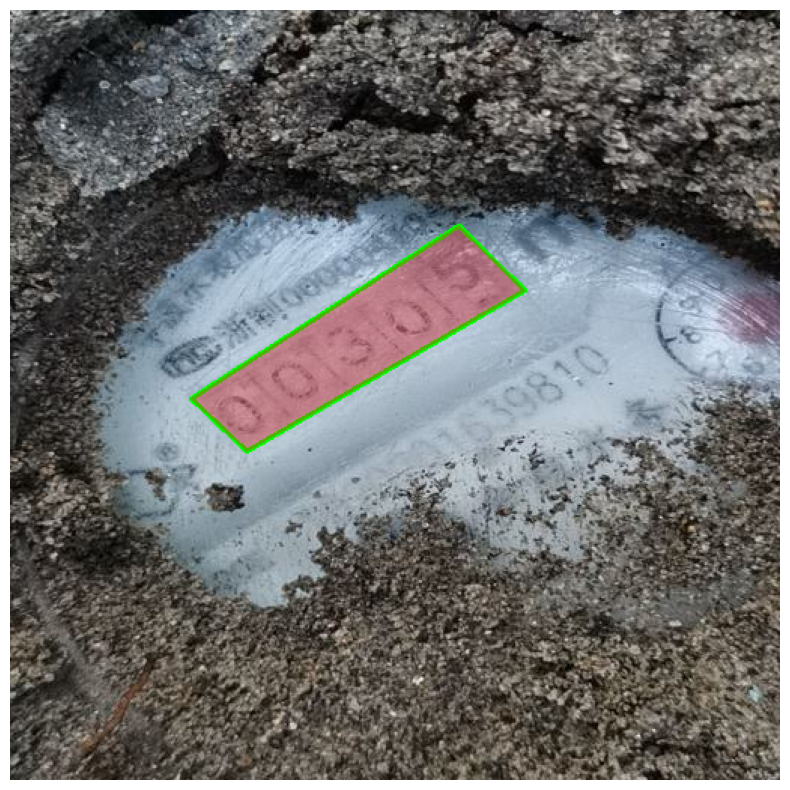

In [4]:
img_path = DATASET_PATH / "images" / "train"
label_path = DATASET_PATH / "labels" / "train"

img_dir = list(img_path.glob("*.*"))

img_file = img_dir[0]
img_0 = cv2.imread(str(img_file))
img_rgb = cv2.cvtColor(img_0, cv2.COLOR_BGR2RGB)
h, w, _ = img_rgb.shape

label_file = label_path / f"{img_file.stem}.txt"
print(label_file)

with open(label_file, "r") as f:
    lines = f.readlines()

for line in lines:
        parts = list(map(float, line.strip().split()))
        if len(parts) > 1:
            class_id = int(parts[0])
            coords = parts[1:]
            
            points = []
            for i in range(0, len(coords), 2):
                x = int(coords[i] * w)
                y = int(coords[i+1] * h)
                points.append([x, y])
            
            pts = np.array(points, np.int32).reshape((-1, 1, 2))
            
            cv2.polylines(img_rgb, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
            
            overlay = img_rgb.copy()
            cv2.fillPoly(overlay, [pts], color=(255, 0, 0)) # Màu đỏ mờ
            img_rgb = cv2.addWeighted(overlay, 0.3, img_rgb, 0.7, 0)

plt.figure(figsize=(10, 10))
plt.imshow(img_rgb)
plt.axis("off")
plt.show()

# 3. Huấn luyện mô hình



# Load lại file weights lưu trạng thái lúc bị ngắt
model = YOLO("/kaggle/input/models/dhkhmt19a/lass/other/default/1/last.pt")


results = model.train(
    data='data.yaml', 
    epochs=62, 
    batch=16, 
    workers=4, 


    # --- Tối ưu hóa lỗi Background (Bkg) ---
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    mosaic=1.0,
    mixup=0.1,   
    
    # --- Phép biến đổi khác ---
    scale=0.3,
    fliplr=0.5,
    flipud=0.5,
    erasing=0.05,
    copy_paste=0,
    close_mosaic=15,
    
    # --- Hyperparameters ---
    warmup_epochs=5,
    weight_decay=0.0005,
    patience=30,
    lr0=0.001,
    lrf=0.1,
    cos_lr=True,
    optimizer="AdamW"
)


In [5]:
# Import đúng class YOLOE
from ultralytics import YOLOE

# 1. Truyền đường dẫn last.pt vào class YOLOE
model = YOLOE("/kaggle/input/models/dhkhmt19a/lass/other/default/1/last.pt")

# 2. Bật chế độ khôi phục
results = model.train(resume=True)

Ultralytics 8.4.135 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=15, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.05, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=/kaggle/input/models/dhkhmt19a/lass/other/default/1/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=False

Overriding model.yaml nc=80 with nc=1



                   from  n    params  module                                       arguments                     


  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 


  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                


  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             


  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               


  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           


  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              


  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           


  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              


  8                  -1  1   1838080  ultralytics.nn.modules.block.C2f             [512, 512, 1, True]           


  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 


 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 12                  -1  1    591360  ultralytics.nn.modules.block.C2f             [768, 256, 1]                 


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 15                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 


 16                  15  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 18                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 


 19                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  1   1969152  ultralytics.nn.modules.block.C2f             [768, 512, 1]                 


 22        [15, 18, 21]  1   6398294  ultralytics.nn.modules.head.YOLOESegment     [1, 32, 128, 512, True, 16, None, [128, 256, 512]]


YOLOe-v8s-seg summary: 187 layers, 15,417,846 parameters, 15,417,830 gradients, 41.3 GFLOPs


Transferred 510/510 items from pretrained weights


Freezing layer 'model.22.dfl.conv.weight'


AMP: running Automatic Mixed Precision (AMP) checks...


AMP: downloading yolo26n.pt for AMP checks (one-time, not used for training)...


AMP: checks passed ✅


WARNING ⚠️ train: Slow image access detected (ping: 0.4±0.2 ms, read: 14.0±5.6 MB/s, size: 44.2 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips


train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30 images, 0 backgrounds, 0 corrupt: 0% ──────────── 30/39704 87.6it/s 0.1s<7:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 65 images, 0 backgrounds, 0 corrupt: 0% ──────────── 65/39704 166.2it/s 0.2s<3:58

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 101 images, 0 backgrounds, 0 corrupt: 0% ──────────── 101/39704 223.5it/s 0.3s<2:57

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 138 images, 0 backgrounds, 0 corrupt: 0% ──────────── 138/39704 266.3it/s 0.4s<2:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 176 images, 0 backgrounds, 0 corrupt: 0% ──────────── 176/39704 298.3it/s 0.5s<2:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 211 images, 0 backgrounds, 0 corrupt: 0% ──────────── 211/39704 312.7it/s 0.6s<2:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 250 images, 0 backgrounds, 0 corrupt: 0% ──────────── 250/39704 331.8it/s 0.7s<1:59

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 289 images, 0 backgrounds, 0 corrupt: 0% ──────────── 289/39704 344.0it/s 0.8s<1:55

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 328 images, 0 backgrounds, 0 corrupt: 0% ──────────── 328/39704 356.2it/s 0.9s<1:51

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 365 images, 0 backgrounds, 0 corrupt: 0% ──────────── 365/39704 358.8it/s 1.0s<1:50

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 404 images, 0 backgrounds, 0 corrupt: 1% ──────────── 404/39704 361.5it/s 1.1s<1:49

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 443 images, 0 backgrounds, 0 corrupt: 1% ──────────── 443/39704 367.8it/s 1.2s<1:47

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 479 images, 0 backgrounds, 0 corrupt: 1% ──────────── 479/39704 362.6it/s 1.3s<1:48

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 516 images, 0 backgrounds, 0 corrupt: 1% ──────────── 516/39704 362.5it/s 1.4s<1:48

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 552 images, 0 backgrounds, 0 corrupt: 1% ──────────── 552/39704 358.4it/s 1.5s<1:49

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 592 images, 0 backgrounds, 0 corrupt: 1% ──────────── 592/39704 363.6it/s 1.6s<1:48

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 631 images, 0 backgrounds, 0 corrupt: 1% ──────────── 631/39704 364.2it/s 1.7s<1:47

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 672 images, 0 backgrounds, 0 corrupt: 1% ──────────── 672/39704 375.7it/s 1.8s<1:44

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 711 images, 0 backgrounds, 0 corrupt: 1% ──────────── 711/39704 379.2it/s 2.0s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 749 images, 0 backgrounds, 0 corrupt: 1% ──────────── 749/39704 374.1it/s 2.1s<1:44

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 788 images, 0 backgrounds, 0 corrupt: 1% ──────────── 788/39704 378.1it/s 2.2s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 826 images, 0 backgrounds, 0 corrupt: 2% ──────────── 826/39704 378.1it/s 2.3s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 865 images, 0 backgrounds, 0 corrupt: 2% ──────────── 865/39704 381.5it/s 2.4s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 902 images, 0 backgrounds, 0 corrupt: 2% ──────────── 902/39704 378.0it/s 2.5s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 941 images, 0 backgrounds, 0 corrupt: 2% ──────────── 941/39704 377.4it/s 2.6s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 979 images, 0 backgrounds, 0 corrupt: 2% ──────────── 979/39704 377.0it/s 2.7s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1020 images, 0 backgrounds, 0 corrupt: 2% ──────────── 1020/39704 385.2it/s 2.8s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1058 images, 0 backgrounds, 0 corrupt: 2% ──────────── 1058/39704 382.2it/s 2.9s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1097 images, 0 backgrounds, 0 corrupt: 2% ──────────── 1097/39704 382.3it/s 3.0s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1137 images, 0 backgrounds, 0 corrupt: 2% ──────────── 1137/39704 383.4it/s 3.1s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1175 images, 0 backgrounds, 0 corrupt: 2% ──────────── 1175/39704 379.8it/s 3.2s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1210 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1210/39704 370.2it/s 3.3s<1:44

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1245 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1245/39704 359.7it/s 3.4s<1:47

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1289 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1289/39704 382.7it/s 3.5s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1328 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1328/39704 380.4it/s 3.6s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1371 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1371/39704 392.0it/s 3.7s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1406 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1406/39704 372.2it/s 3.8s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1447 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1447/39704 383.2it/s 3.9s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1486 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1486/39704 384.3it/s 4.0s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1527 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1527/39704 389.5it/s 4.1s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1555 images, 0 backgrounds, 0 corrupt: 3% ──────────── 1555/39704 355.1it/s 4.2s<1:47

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1591 images, 0 backgrounds, 0 corrupt: 4% ──────────── 1591/39704 349.0it/s 4.3s<1:49

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1636 images, 0 backgrounds, 0 corrupt: 4% ──────────── 1636/39704 374.8it/s 4.4s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1676 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1676/39704 381.5it/s 4.5s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1715 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1715/39704 382.9it/s 4.6s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1756 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1756/39704 380.3it/s 4.7s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1800 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1800/39704 396.3it/s 4.8s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1840 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1840/39704 397.3it/s 4.9s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1880 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1880/39704 391.2it/s 5.0s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1921 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1921/39704 393.9it/s 5.1s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1957 images, 0 backgrounds, 0 corrupt: 4% ╸─────────── 1957/39704 381.7it/s 5.2s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 1992 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 1992/39704 371.0it/s 5.3s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2036 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2036/39704 386.6it/s 5.4s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2070 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2070/39704 369.7it/s 5.5s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2110 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2110/39704 376.1it/s 5.6s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2149 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2149/39704 377.6it/s 5.7s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2190 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2190/39704 386.9it/s 5.8s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2229 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2229/39704 385.5it/s 5.9s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2267 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2267/39704 380.6it/s 6.0s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2308 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2308/39704 388.5it/s 6.2s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2338 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2338/39704 361.9it/s 6.3s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2375 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 2375/39704 363.8it/s 6.4s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2416 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2416/39704 359.6it/s 6.5s<1:44

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2458 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2458/39704 374.0it/s 6.6s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2496 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2496/39704 373.7it/s 6.7s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2534 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2534/39704 375.3it/s 6.8s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2573 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2573/39704 379.4it/s 6.9s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2613 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2613/39704 379.5it/s 7.0s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2650 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2650/39704 376.5it/s 7.1s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2691 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2691/39704 385.0it/s 7.2s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2730 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2730/39704 385.8it/s 7.3s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2765 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 2765/39704 373.0it/s 7.4s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2804 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 2804/39704 374.0it/s 7.5s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2846 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 2846/39704 383.5it/s 7.6s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2881 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 2881/39704 365.8it/s 7.7s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2923 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 2923/39704 380.8it/s 7.8s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 2961 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 2961/39704 379.6it/s 7.9s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3002 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 3002/39704 383.5it/s 8.0s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3043 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 3043/39704 389.2it/s 8.1s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3084 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 3084/39704 392.7it/s 8.2s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3124 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 3124/39704 393.6it/s 8.3s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3164 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 3164/39704 395.4it/s 8.4s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3203 images, 0 backgrounds, 0 corrupt: 8% ╸─────────── 3203/39704 392.2it/s 8.5s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3242 images, 0 backgrounds, 0 corrupt: 8% ╸─────────── 3242/39704 390.8it/s 8.6s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3284 images, 0 backgrounds, 0 corrupt: 8% ╸─────────── 3284/39704 397.8it/s 8.7s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3324 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3324/39704 396.9it/s 8.8s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3363 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3363/39704 393.4it/s 8.9s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3403 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3403/39704 392.3it/s 9.0s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3445 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3445/39704 399.2it/s 9.1s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3483 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3483/39704 370.9it/s 9.2s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3532 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3532/39704 401.4it/s 9.3s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3570 images, 0 backgrounds, 0 corrupt: 8% ━─────────── 3570/39704 393.8it/s 9.4s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3607 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3607/39704 386.0it/s 9.5s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3647 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3647/39704 389.8it/s 9.6s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3688 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3688/39704 394.1it/s 9.8s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3724 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3724/39704 382.0it/s 9.9s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3765 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3765/39704 388.2it/s 10.0s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3805 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3805/39704 391.2it/s 10.1s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3848 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3848/39704 400.9it/s 10.2s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3888 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3888/39704 399.3it/s 10.3s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3931 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 3931/39704 405.2it/s 10.4s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 3973 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 3973/39704 403.9it/s 10.5s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4015 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4015/39704 408.1it/s 10.6s<1:27

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4052 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4052/39704 396.5it/s 10.7s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4089 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4089/39704 386.2it/s 10.8s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4125 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4125/39704 377.3it/s 10.9s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4166 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4166/39704 383.2it/s 11.0s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4208 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4208/39704 391.1it/s 11.1s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4249 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4249/39704 393.4it/s 11.2s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4291 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4291/39704 398.7it/s 11.3s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4325 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4325/39704 366.6it/s 11.4s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4363 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 4363/39704 368.8it/s 11.5s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4401 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4401/39704 372.1it/s 11.6s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4438 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4438/39704 367.5it/s 11.7s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4477 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4477/39704 371.6it/s 11.8s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4516 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4516/39704 374.8it/s 11.9s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4555 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4555/39704 378.6it/s 12.0s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4591 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4591/39704 371.1it/s 12.1s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4631 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4631/39704 377.1it/s 12.2s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4672 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4672/39704 382.2it/s 12.3s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4710 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4710/39704 377.3it/s 12.4s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4748 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 4748/39704 377.8it/s 12.5s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4789 images, 0 backgrounds, 0 corrupt: 12% ━─────────── 4789/39704 384.5it/s 12.6s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4831 images, 0 backgrounds, 0 corrupt: 12% ━─────────── 4831/39704 390.1it/s 12.7s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4867 images, 0 backgrounds, 0 corrupt: 12% ━─────────── 4867/39704 380.5it/s 12.8s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4906 images, 0 backgrounds, 0 corrupt: 12% ━─────────── 4906/39704 379.4it/s 12.9s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4947 images, 0 backgrounds, 0 corrupt: 12% ━─────────── 4947/39704 387.9it/s 13.0s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 4988 images, 0 backgrounds, 0 corrupt: 12% ━╸────────── 4988/39704 392.7it/s 13.1s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5028 images, 0 backgrounds, 0 corrupt: 12% ━╸────────── 5028/39704 391.2it/s 13.2s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5066 images, 0 backgrounds, 0 corrupt: 12% ━╸────────── 5066/39704 387.7it/s 13.3s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5105 images, 0 backgrounds, 0 corrupt: 12% ━╸────────── 5105/39704 386.6it/s 13.4s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5143 images, 0 backgrounds, 0 corrupt: 12% ━╸────────── 5143/39704 380.9it/s 13.5s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5178 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5178/39704 368.8it/s 13.6s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5218 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5218/39704 377.5it/s 13.7s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5257 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5257/39704 381.1it/s 13.8s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5294 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5294/39704 372.9it/s 13.9s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5334 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5334/39704 379.6it/s 14.0s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5371 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5371/39704 375.7it/s 14.1s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5411 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5411/39704 381.7it/s 14.3s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5452 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5452/39704 385.8it/s 14.4s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5493 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5493/39704 390.6it/s 14.5s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5536 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 5536/39704 397.6it/s 14.6s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5580 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5580/39704 403.5it/s 14.7s<1:25

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5620 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5620/39704 397.1it/s 14.8s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5656 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5656/39704 376.1it/s 14.9s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5696 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5696/39704 382.8it/s 15.0s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5736 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5736/39704 387.7it/s 15.1s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5777 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5777/39704 387.4it/s 15.2s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5811 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5811/39704 366.9it/s 15.3s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5854 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5854/39704 385.7it/s 15.4s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5887 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5887/39704 368.4it/s 15.5s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5926 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 5926/39704 372.4it/s 15.6s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 5967 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 5967/39704 378.6it/s 15.7s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6010 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6010/39704 393.4it/s 15.8s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6051 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6051/39704 395.5it/s 15.9s<1:25

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6096 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6096/39704 403.6it/s 16.0s<1:23

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6140 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6140/39704 413.9it/s 16.1s<1:21

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6181 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6181/39704 411.0it/s 16.2s<1:22

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6221 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6221/39704 404.0it/s 16.3s<1:23

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6258 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6258/39704 393.3it/s 16.4s<1:25

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6297 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6297/39704 384.7it/s 16.5s<1:27

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6336 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 6336/39704 362.2it/s 16.6s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6383 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6383/39704 392.3it/s 16.8s<1:25

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6424 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6424/39704 395.0it/s 16.9s<1:24

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6463 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6463/39704 392.0it/s 17.0s<1:25

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6495 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6495/39704 367.2it/s 17.1s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6527 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6527/39704 352.2it/s 17.2s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6562 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6562/39704 340.6it/s 17.3s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6607 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 6607/39704 371.1it/s 17.4s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6644 images, 0 backgrounds, 0 corrupt: 16% ━━────────── 6644/39704 368.1it/s 17.5s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6682 images, 0 backgrounds, 0 corrupt: 16% ━━────────── 6682/39704 366.3it/s 17.6s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6721 images, 0 backgrounds, 0 corrupt: 16% ━━────────── 6721/39704 371.5it/s 17.7s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6761 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6761/39704 374.7it/s 17.8s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6797 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6797/39704 369.5it/s 17.9s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6837 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6837/39704 375.5it/s 18.0s<1:28

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6871 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6871/39704 364.2it/s 18.1s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6904 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6904/39704 351.9it/s 18.2s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6933 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6933/39704 333.3it/s 18.3s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 6972 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 6972/39704 350.2it/s 18.4s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7009 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 7009/39704 355.8it/s 18.5s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7047 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 7047/39704 360.7it/s 18.6s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7087 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 7087/39704 366.5it/s 18.7s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7128 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 7128/39704 379.4it/s 18.8s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7165 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7165/39704 374.8it/s 18.9s<1:27

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7203 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7203/39704 376.1it/s 19.0s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7245 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7245/39704 385.6it/s 19.1s<1:24

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7277 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7277/39704 364.6it/s 19.2s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7309 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7309/39704 350.8it/s 19.3s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7346 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7346/39704 350.2it/s 19.4s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7386 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7386/39704 361.9it/s 19.5s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7422 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7422/39704 356.3it/s 19.6s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7464 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7464/39704 374.3it/s 19.7s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7498 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7498/39704 363.5it/s 19.8s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7531 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 7531/39704 344.8it/s 19.9s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7566 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7566/39704 342.8it/s 20.0s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7603 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7603/39704 348.2it/s 20.1s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7639 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7639/39704 348.1it/s 20.2s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7674 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7674/39704 345.3it/s 20.3s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7708 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7708/39704 340.6it/s 20.4s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7742 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7742/39704 334.8it/s 20.6s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7772 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7772/39704 318.6it/s 20.7s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7810 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7810/39704 333.8it/s 20.8s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7843 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7843/39704 330.7it/s 20.9s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7877 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7877/39704 331.7it/s 21.0s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7912 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 7912/39704 335.2it/s 21.1s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7944 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 7944/39704 321.5it/s 21.2s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 7977 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 7977/39704 319.1it/s 21.3s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8012 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8012/39704 327.0it/s 21.4s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8046 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8046/39704 330.8it/s 21.5s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8079 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8079/39704 324.7it/s 21.6s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8113 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8113/39704 309.5it/s 21.7s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8152 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8152/39704 332.2it/s 21.8s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8186 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8186/39704 332.3it/s 21.9s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8217 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8217/39704 322.2it/s 22.0s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8251 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 8251/39704 325.8it/s 22.1s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8284 images, 0 backgrounds, 0 corrupt: 20% ━━╸───────── 8284/39704 321.3it/s 22.2s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8320 images, 0 backgrounds, 0 corrupt: 20% ━━╸───────── 8320/39704 325.2it/s 22.3s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8356 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8356/39704 321.8it/s 22.5s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8393 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8393/39704 333.2it/s 22.6s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8427 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8427/39704 332.8it/s 22.7s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8459 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8459/39704 326.3it/s 22.8s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8495 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8495/39704 333.1it/s 22.9s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8530 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8530/39704 333.4it/s 23.0s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8567 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8567/39704 329.2it/s 23.1s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8604 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8604/39704 339.8it/s 23.2s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8633 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8633/39704 323.1it/s 23.3s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8667 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8667/39704 322.5it/s 23.4s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8700 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8700/39704 321.3it/s 23.5s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8732 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 8732/39704 318.0it/s 23.6s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8759 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8759/39704 299.7it/s 23.7s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8798 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8798/39704 324.8it/s 23.8s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8834 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8834/39704 334.5it/s 23.9s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8864 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8864/39704 323.9it/s 24.0s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8898 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8898/39704 326.7it/s 24.1s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8934 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8934/39704 333.2it/s 24.2s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 8969 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 8969/39704 335.4it/s 24.3s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9005 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 9005/39704 341.7it/s 24.4s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9040 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 9040/39704 344.2it/s 24.5s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9078 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 9078/39704 351.8it/s 24.6s<1:27

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9118 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 9118/39704 363.6it/s 24.7s<1:24

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9157 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9157/39704 370.4it/s 24.8s<1:22

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9195 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9195/39704 372.4it/s 24.9s<1:22

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9237 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9237/39704 383.6it/s 25.0s<1:19

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9274 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9274/39704 360.2it/s 25.1s<1:24

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9308 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9308/39704 352.7it/s 25.3s<1:26

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9339 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9339/39704 337.3it/s 25.4s<1:30

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9371 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9371/39704 331.9it/s 25.5s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9405 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9405/39704 329.7it/s 25.6s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9434 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9434/39704 304.6it/s 25.7s<1:39

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9462 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9462/39704 293.4it/s 25.8s<1:43

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9494 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 9494/39704 296.6it/s 25.9s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9533 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9533/39704 320.8it/s 26.0s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9564 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9564/39704 312.2it/s 26.1s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9598 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9598/39704 316.3it/s 26.2s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9627 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9627/39704 306.0it/s 26.3s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9655 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9655/39704 295.3it/s 26.4s<1:42

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9682 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9682/39704 286.7it/s 26.5s<1:45

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9722 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9722/39704 315.8it/s 26.6s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9750 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9750/39704 304.1it/s 26.7s<1:38

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9789 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9789/39704 326.7it/s 26.8s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9822 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9822/39704 322.1it/s 26.9s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9855 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9855/39704 322.6it/s 27.0s<1:33

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9890 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9890/39704 327.6it/s 27.1s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9921 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 9921/39704 305.7it/s 27.2s<1:37

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9964 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 9964/39704 335.6it/s 27.4s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 9992 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 9992/39704 311.9it/s 27.5s<1:35

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10025 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10025/39704 297.5it/s 27.6s<1:40

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10064 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10064/39704 322.7it/s 27.7s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10093 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10093/39704 293.3it/s 27.8s<1:41

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10128 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10128/39704 308.4it/s 27.9s<1:36

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10161 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10161/39704 314.6it/s 28.0s<1:34

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10196 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10196/39704 321.8it/s 28.1s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10229 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10229/39704 322.3it/s 28.2s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10261 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10261/39704 320.7it/s 28.3s<1:32

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10296 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 10296/39704 324.8it/s 28.4s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10337 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10337/39704 348.4it/s 28.5s<1:24

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10375 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10375/39704 355.3it/s 28.6s<1:23

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10415 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10415/39704 365.2it/s 28.7s<1:20

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10452 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10452/39704 357.8it/s 28.8s<1:22

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10500 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10500/39704 388.6it/s 29.0s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10540 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10540/39704 386.6it/s 29.1s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10582 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10582/39704 395.2it/s 29.2s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10621 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10621/39704 392.5it/s 29.3s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10661 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10661/39704 391.5it/s 29.4s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10696 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 10696/39704 376.2it/s 29.5s<1:17

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10739 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10739/39704 388.7it/s 29.6s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10780 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10780/39704 391.7it/s 29.7s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10816 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10816/39704 381.3it/s 29.8s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10854 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10854/39704 377.3it/s 29.9s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10894 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10894/39704 381.2it/s 30.0s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10934 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10934/39704 384.8it/s 30.1s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 10972 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 10972/39704 380.8it/s 30.2s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11008 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 11008/39704 370.3it/s 30.3s<1:17

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11050 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 11050/39704 382.7it/s 30.4s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11088 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 11088/39704 380.7it/s 30.5s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11126 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11126/39704 379.5it/s 30.6s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11165 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11165/39704 381.7it/s 30.7s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11205 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11205/39704 379.2it/s 30.8s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11243 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11243/39704 379.1it/s 30.9s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11278 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11278/39704 367.6it/s 31.0s<1:17

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11309 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11309/39704 350.2it/s 31.1s<1:21

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11344 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11344/39704 348.6it/s 31.2s<1:21

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11382 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11382/39704 354.5it/s 31.3s<1:20

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11420 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11420/39704 359.5it/s 31.4s<1:19

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11455 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11455/39704 353.8it/s 31.5s<1:20

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11495 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 11495/39704 367.1it/s 31.6s<1:17

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11533 images, 0 backgrounds, 0 corrupt: 29% ━━━───────── 11533/39704 369.1it/s 31.7s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11571 images, 0 backgrounds, 0 corrupt: 29% ━━━───────── 11571/39704 371.6it/s 31.8s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11605 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11605/39704 362.0it/s 31.9s<1:18

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11647 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11647/39704 377.8it/s 32.0s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11683 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11683/39704 369.9it/s 32.1s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11722 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11722/39704 375.4it/s 32.2s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11761 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11761/39704 378.0it/s 32.3s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11800 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11800/39704 381.0it/s 32.4s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11837 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11837/39704 374.6it/s 32.5s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11875 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 11875/39704 375.2it/s 32.6s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11914 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 11914/39704 379.0it/s 32.7s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11948 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 11948/39704 363.9it/s 32.8s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 11988 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 11988/39704 363.7it/s 32.9s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12028 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12028/39704 372.8it/s 33.0s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12067 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12067/39704 375.2it/s 33.1s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12106 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12106/39704 378.2it/s 33.2s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12139 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12139/39704 363.0it/s 33.3s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12180 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12180/39704 370.8it/s 33.4s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12222 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12222/39704 383.8it/s 33.6s<1:12

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12259 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12259/39704 378.4it/s 33.7s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12297 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 12297/39704 378.8it/s 33.8s<1:12

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12339 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12339/39704 388.7it/s 33.9s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12376 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12376/39704 383.0it/s 34.0s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12410 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12410/39704 366.9it/s 34.1s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12450 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12450/39704 374.9it/s 34.2s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12484 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12484/39704 361.5it/s 34.3s<1:15

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12519 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12519/39704 357.4it/s 34.4s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12549 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12549/39704 338.6it/s 34.5s<1:20

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12587 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12587/39704 339.7it/s 34.6s<1:20

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12626 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12626/39704 352.4it/s 34.7s<1:17

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12648 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12648/39704 303.6it/s 34.8s<1:29

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12704 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 12704/39704 379.1it/s 34.9s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12731 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12731/39704 341.2it/s 35.0s<1:19

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12773 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12773/39704 363.3it/s 35.1s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12813 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12813/39704 369.1it/s 35.2s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12852 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12852/39704 372.8it/s 35.3s<1:12

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12887 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12887/39704 354.8it/s 35.4s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12927 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12927/39704 367.8it/s 35.5s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12965 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12965/39704 370.2it/s 35.6s<1:12

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 12999 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 12999/39704 350.0it/s 35.7s<1:16

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13042 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 13042/39704 373.5it/s 35.8s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13083 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 13083/39704 377.0it/s 35.9s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13123 images, 0 backgrounds, 0 corrupt: 33% ━━━╸──────── 13123/39704 381.6it/s 36.0s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13164 images, 0 backgrounds, 0 corrupt: 33% ━━━╸──────── 13164/39704 388.5it/s 36.1s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13203 images, 0 backgrounds, 0 corrupt: 33% ━━━╸──────── 13203/39704 386.7it/s 36.2s<1:09

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13239 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13239/39704 370.7it/s 36.4s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13276 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13276/39704 367.8it/s 36.5s<1:12

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13316 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13316/39704 375.6it/s 36.6s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13355 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13355/39704 377.6it/s 36.7s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13393 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13393/39704 372.7it/s 36.8s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13433 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13433/39704 377.6it/s 36.9s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13472 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 13472/39704 375.5it/s 37.0s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13513 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13513/39704 384.6it/s 37.1s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13551 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13551/39704 381.6it/s 37.2s<1:09

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13595 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13595/39704 391.1it/s 37.3s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13635 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13635/39704 392.9it/s 37.4s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13676 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13676/39704 392.2it/s 37.5s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13721 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13721/39704 403.3it/s 37.6s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13757 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13757/39704 389.5it/s 37.7s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13796 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13796/39704 387.9it/s 37.8s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13835 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13835/39704 386.3it/s 37.9s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13876 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 13876/39704 387.6it/s 38.0s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13918 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 13918/39704 390.5it/s 38.1s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 13960 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 13960/39704 398.1it/s 38.2s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14001 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14001/39704 400.7it/s 38.3s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14038 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14038/39704 386.7it/s 38.4s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14076 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14076/39704 377.5it/s 38.5s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14119 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14119/39704 392.1it/s 38.6s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14157 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14157/39704 386.0it/s 38.7s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14196 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14196/39704 386.2it/s 38.8s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14235 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14235/39704 384.7it/s 38.9s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14274 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 14274/39704 384.1it/s 39.0s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14315 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14315/39704 390.7it/s 39.1s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14356 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14356/39704 396.4it/s 39.2s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14396 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14396/39704 396.9it/s 39.3s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14434 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14434/39704 388.6it/s 39.4s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14467 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14467/39704 355.5it/s 39.6s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14516 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14516/39704 395.3it/s 39.7s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14552 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14552/39704 381.6it/s 39.8s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14592 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14592/39704 380.9it/s 39.9s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14632 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14632/39704 385.9it/s 40.0s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14673 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 14673/39704 390.7it/s 40.1s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14714 images, 0 backgrounds, 0 corrupt: 37% ━━━━──────── 14714/39704 394.5it/s 40.2s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14754 images, 0 backgrounds, 0 corrupt: 37% ━━━━──────── 14754/39704 395.4it/s 40.3s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14791 images, 0 backgrounds, 0 corrupt: 37% ━━━━──────── 14791/39704 387.2it/s 40.4s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14823 images, 0 backgrounds, 0 corrupt: 37% ━━━━──────── 14823/39704 356.8it/s 40.5s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14866 images, 0 backgrounds, 0 corrupt: 37% ━━━━──────── 14866/39704 378.3it/s 40.6s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14903 images, 0 backgrounds, 0 corrupt: 37% ━━━━╸─────── 14903/39704 373.7it/s 40.7s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14938 images, 0 backgrounds, 0 corrupt: 37% ━━━━╸─────── 14938/39704 365.6it/s 40.8s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 14977 images, 0 backgrounds, 0 corrupt: 37% ━━━━╸─────── 14977/39704 370.5it/s 40.9s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15014 images, 0 backgrounds, 0 corrupt: 37% ━━━━╸─────── 15014/39704 370.1it/s 41.0s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15053 images, 0 backgrounds, 0 corrupt: 37% ━━━━╸─────── 15053/39704 372.5it/s 41.1s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15090 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15090/39704 368.4it/s 41.2s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15122 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15122/39704 351.0it/s 41.3s<1:10

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15159 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15159/39704 356.1it/s 41.4s<1:09

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15202 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15202/39704 377.8it/s 41.5s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15243 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15243/39704 387.2it/s 41.6s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15282 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15282/39704 387.0it/s 41.7s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15324 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15324/39704 393.9it/s 41.8s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15362 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15362/39704 388.9it/s 41.9s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15403 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15403/39704 390.4it/s 42.0s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15441 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15441/39704 385.9it/s 42.1s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15481 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 15481/39704 389.9it/s 42.2s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15519 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15519/39704 381.2it/s 42.3s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15558 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15558/39704 383.7it/s 42.4s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15597 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15597/39704 383.7it/s 42.5s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15639 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15639/39704 391.4it/s 42.6s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15678 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15678/39704 384.6it/s 42.7s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15720 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15720/39704 391.0it/s 42.8s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15755 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15755/39704 377.5it/s 42.9s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15794 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15794/39704 379.7it/s 43.0s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15829 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15829/39704 369.7it/s 43.1s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15865 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 15865/39704 362.0it/s 43.2s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15900 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 15900/39704 357.3it/s 43.3s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15936 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 15936/39704 353.1it/s 43.4s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 15973 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 15973/39704 356.0it/s 43.5s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16009 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16009/39704 354.2it/s 43.6s<1:07

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16042 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16042/39704 345.6it/s 43.7s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16081 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16081/39704 356.8it/s 43.8s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16118 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16118/39704 357.1it/s 43.9s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16155 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16155/39704 356.0it/s 44.1s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16192 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16192/39704 358.3it/s 44.2s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16233 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16233/39704 371.5it/s 44.3s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16269 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 16269/39704 367.2it/s 44.4s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16306 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16306/39704 364.4it/s 44.5s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16344 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16344/39704 359.4it/s 44.6s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16381 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16381/39704 361.8it/s 44.7s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16417 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16417/39704 360.9it/s 44.8s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16452 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16452/39704 353.7it/s 44.9s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16487 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16487/39704 352.2it/s 45.0s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16525 images, 0 backgrounds, 0 corrupt: 41% ━━━━╸─────── 16525/39704 357.0it/s 45.1s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16560 images, 0 backgrounds, 0 corrupt: 41% ━━━━━─────── 16560/39704 352.9it/s 45.2s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16598 images, 0 backgrounds, 0 corrupt: 41% ━━━━━─────── 16598/39704 358.5it/s 45.3s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16636 images, 0 backgrounds, 0 corrupt: 41% ━━━━━─────── 16636/39704 362.0it/s 45.4s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16672 images, 0 backgrounds, 0 corrupt: 41% ━━━━━─────── 16672/39704 357.3it/s 45.5s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16707 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16707/39704 353.5it/s 45.6s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16743 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16743/39704 353.1it/s 45.7s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16778 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16778/39704 351.1it/s 45.8s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16818 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16818/39704 359.1it/s 45.9s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16853 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16853/39704 354.8it/s 46.0s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16889 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16889/39704 351.5it/s 46.1s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16924 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16924/39704 349.9it/s 46.2s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16961 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16961/39704 351.1it/s 46.3s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 16998 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 16998/39704 351.2it/s 46.4s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17034 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 17034/39704 353.6it/s 46.5s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17070 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 17070/39704 353.1it/s 46.6s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17102 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17102/39704 341.8it/s 46.7s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17139 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17139/39704 348.2it/s 46.8s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17174 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17174/39704 347.8it/s 46.9s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17209 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17209/39704 347.8it/s 47.0s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17239 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17239/39704 330.7it/s 47.1s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17276 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17276/39704 338.9it/s 47.2s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17309 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17309/39704 327.5it/s 47.3s<1:08

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17347 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17347/39704 342.0it/s 47.4s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17383 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17383/39704 344.8it/s 47.5s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17412 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17412/39704 324.5it/s 47.6s<1:09

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17449 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 17449/39704 337.3it/s 47.8s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17485 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17485/39704 340.5it/s 47.9s<1:05

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17522 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17522/39704 345.4it/s 48.0s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17560 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17560/39704 351.1it/s 48.1s<1:03

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17598 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17598/39704 356.7it/s 48.2s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17634 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17634/39704 357.2it/s 48.3s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17671 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17671/39704 358.2it/s 48.4s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17707 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17707/39704 358.6it/s 48.5s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17744 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17744/39704 361.7it/s 48.6s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17782 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17782/39704 365.0it/s 48.7s<1:00

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17820 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17820/39704 366.2it/s 48.8s<59.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17858 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 17858/39704 369.0it/s 48.9s<59.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17894 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 17894/39704 364.5it/s 49.0s<59.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17933 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 17933/39704 367.7it/s 49.1s<59.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 17969 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 17969/39704 365.2it/s 49.2s<59.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18010 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 18010/39704 377.8it/s 49.3s<57.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18048 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 18048/39704 373.7it/s 49.4s<58.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18086 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 18086/39704 373.5it/s 49.5s<57.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18123 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 18123/39704 369.1it/s 49.6s<58.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18165 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 18165/39704 374.3it/s 49.7s<57.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18205 images, 0 backgrounds, 0 corrupt: 45% ━━━━━╸────── 18205/39704 370.1it/s 49.8s<58.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18245 images, 0 backgrounds, 0 corrupt: 45% ━━━━━╸────── 18245/39704 362.7it/s 49.9s<59.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18288 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18288/39704 381.5it/s 50.0s<56.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18327 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18327/39704 383.4it/s 50.1s<55.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18364 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18364/39704 373.3it/s 50.2s<57.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18402 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18402/39704 373.4it/s 50.3s<57.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18441 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18441/39704 377.2it/s 50.4s<56.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18478 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18478/39704 373.5it/s 50.5s<56.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18516 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18516/39704 373.7it/s 50.6s<56.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18555 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18555/39704 374.2it/s 50.7s<56.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18587 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18587/39704 354.0it/s 50.8s<59.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18626 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 18626/39704 363.9it/s 50.9s<57.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18663 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18663/39704 361.4it/s 51.1s<58.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18699 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18699/39704 358.3it/s 51.2s<58.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18738 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18738/39704 367.6it/s 51.3s<57.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18771 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18771/39704 353.1it/s 51.4s<59.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18806 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18806/39704 350.3it/s 51.5s<59.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18844 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18844/39704 358.5it/s 51.6s<58.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18880 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18880/39704 355.8it/s 51.7s<58.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18918 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18918/39704 361.9it/s 51.8s<57.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18954 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18954/39704 358.2it/s 51.9s<57.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 18993 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 18993/39704 365.8it/s 52.0s<56.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19029 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 19029/39704 360.5it/s 52.1s<57.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19064 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19064/39704 353.3it/s 52.2s<58.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19096 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19096/39704 340.3it/s 52.3s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19129 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19129/39704 333.4it/s 52.4s<1:02

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19165 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19165/39704 337.7it/s 52.5s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19199 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19199/39704 335.9it/s 52.6s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19227 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19227/39704 319.0it/s 52.7s<1:04

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19267 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19267/39704 337.8it/s 52.8s<1:00

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19307 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19307/39704 355.7it/s 52.9s<57.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19339 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19339/39704 307.0it/s 53.1s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19387 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19387/39704 335.1it/s 53.2s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19405 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19405/39704 284.5it/s 53.3s<1:11

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19432 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19432/39704 278.6it/s 53.4s<1:13

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19451 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 19451/39704 223.4it/s 53.6s<1:31

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19496 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19496/39704 272.2it/s 53.7s<1:14

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19530 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19530/39704 260.5it/s 53.9s<1:17

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19573 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19573/39704 305.0it/s 54.0s<1:06

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19613 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19613/39704 328.3it/s 54.1s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19652 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19652/39704 346.4it/s 54.2s<57.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19690 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19690/39704 325.7it/s 54.3s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19723 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19723/39704 326.0it/s 54.4s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19768 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19768/39704 356.6it/s 54.5s<55.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19799 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19799/39704 340.6it/s 54.6s<58.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19839 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 19839/39704 358.4it/s 54.7s<55.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19873 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 19873/39704 347.9it/s 54.8s<57.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19916 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 19916/39704 370.4it/s 54.9s<53.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19954 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 19954/39704 371.3it/s 55.0s<53.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 19990 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 19990/39704 354.6it/s 55.1s<55.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20026 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 20026/39704 354.7it/s 55.2s<55.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20062 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 20062/39704 329.2it/s 55.4s<59.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20110 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 20110/39704 365.4it/s 55.5s<53.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20149 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 20149/39704 369.2it/s 55.6s<53.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20176 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 20176/39704 320.4it/s 55.7s<1:01

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20217 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 20217/39704 338.0it/s 55.8s<57.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20258 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20258/39704 357.3it/s 55.9s<54.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20296 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20296/39704 361.6it/s 56.0s<53.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20331 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20331/39704 354.1it/s 56.1s<54.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20371 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20371/39704 365.1it/s 56.2s<53.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20408 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20408/39704 363.7it/s 56.3s<53.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20448 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20448/39704 369.3it/s 56.4s<52.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20488 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20488/39704 372.5it/s 56.5s<51.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20526 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20526/39704 373.3it/s 56.6s<51.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20564 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20564/39704 374.3it/s 56.7s<51.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20603 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20603/39704 378.4it/s 56.8s<50.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20634 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 20634/39704 357.7it/s 56.9s<53.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20672 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20672/39704 364.0it/s 57.0s<52.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20712 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20712/39704 373.9it/s 57.1s<50.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20750 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20750/39704 375.5it/s 57.2s<50.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20789 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20789/39704 357.9it/s 57.4s<52.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20834 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20834/39704 383.0it/s 57.5s<49.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20873 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20873/39704 378.3it/s 57.6s<49.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20910 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20910/39704 372.1it/s 57.7s<50.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20948 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20948/39704 372.1it/s 57.8s<50.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 20984 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 20984/39704 368.1it/s 57.9s<50.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21025 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 21025/39704 378.1it/s 58.0s<49.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21067 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21067/39704 385.8it/s 58.1s<48.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21110 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21110/39704 394.9it/s 58.2s<47.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21145 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21145/39704 380.2it/s 58.3s<48.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21184 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21184/39704 383.0it/s 58.4s<48.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21223 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21223/39704 381.2it/s 58.5s<48.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21260 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21260/39704 376.9it/s 58.6s<48.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21299 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21299/39704 380.3it/s 58.7s<48.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21337 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21337/39704 379.7it/s 58.8s<48.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21374 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21374/39704 373.7it/s 58.9s<49.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21414 images, 0 backgrounds, 0 corrupt: 53% ━━━━━━────── 21414/39704 376.1it/s 59.0s<48.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21453 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━────── 21453/39704 379.9it/s 59.1s<48.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21492 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━────── 21492/39704 381.9it/s 59.2s<47.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21531 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21531/39704 382.9it/s 59.3s<47.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21569 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21569/39704 382.1it/s 59.4s<47.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21609 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21609/39704 384.4it/s 59.5s<47.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21648 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21648/39704 385.4it/s 59.6s<46.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21686 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21686/39704 382.6it/s 59.7s<47.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21726 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21726/39704 381.7it/s 59.8s<47.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21767 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21767/39704 387.1it/s 59.9s<46.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21806 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 21806/39704 381.3it/s 1:00<46.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21844 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 21844/39704 378.9it/s 1:00<47.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21885 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 21885/39704 388.0it/s 1:00<45.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21925 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 21925/39704 388.3it/s 1:00<45.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 21963 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 21963/39704 384.5it/s 1:00<46.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22001 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22001/39704 381.2it/s 1:01<46.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22038 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22038/39704 376.8it/s 1:01<46.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22075 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22075/39704 373.7it/s 1:01<47.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22115 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22115/39704 378.2it/s 1:01<46.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22154 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22154/39704 379.4it/s 1:01<46.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22191 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22191/39704 375.6it/s 1:01<46.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22231 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 22231/39704 380.4it/s 1:01<45.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22271 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22271/39704 382.1it/s 1:01<45.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22306 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22306/39704 369.3it/s 1:01<47.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22345 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22345/39704 370.6it/s 1:01<46.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22384 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22384/39704 374.2it/s 1:02<46.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22423 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22423/39704 374.9it/s 1:02<46.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22461 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22461/39704 375.4it/s 1:02<45.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22502 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22502/39704 377.9it/s 1:02<45.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22542 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22542/39704 381.8it/s 1:02<44.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22585 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22585/39704 389.5it/s 1:02<43.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22625 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 22625/39704 392.4it/s 1:02<43.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22665 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22665/39704 393.9it/s 1:02<43.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22706 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22706/39704 398.3it/s 1:02<42.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22745 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22745/39704 395.6it/s 1:02<42.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22783 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22783/39704 389.8it/s 1:03<43.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22825 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22825/39704 391.0it/s 1:03<43.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22866 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22866/39704 390.7it/s 1:03<43.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22905 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22905/39704 389.7it/s 1:03<43.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22944 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22944/39704 386.0it/s 1:03<43.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 22984 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 22984/39704 387.9it/s 1:03<43.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23021 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 23021/39704 379.2it/s 1:03<44.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23062 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━╸───── 23062/39704 386.0it/s 1:03<43.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23102 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━╸───── 23102/39704 387.6it/s 1:03<42.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23141 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━╸───── 23141/39704 387.5it/s 1:04<42.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23181 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23181/39704 389.7it/s 1:04<42.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23218 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23218/39704 374.5it/s 1:04<44.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23259 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23259/39704 381.6it/s 1:04<43.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23290 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23290/39704 345.4it/s 1:04<47.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23340 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23340/39704 365.4it/s 1:04<44.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23385 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23385/39704 388.3it/s 1:04<42.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23424 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 23424/39704 388.4it/s 1:04<41.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23464 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23464/39704 390.6it/s 1:04<41.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23503 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23503/39704 387.5it/s 1:04<41.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23543 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23543/39704 383.2it/s 1:05<42.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23582 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23582/39704 384.7it/s 1:05<41.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23620 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23620/39704 382.8it/s 1:05<42.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23659 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23659/39704 384.1it/s 1:05<41.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23700 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23700/39704 387.9it/s 1:05<41.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23743 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23743/39704 398.4it/s 1:05<40.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23783 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 23783/39704 397.2it/s 1:05<40.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23823 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 23823/39704 398.0it/s 1:05<39.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23862 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 23862/39704 395.6it/s 1:05<40.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23899 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 23899/39704 386.9it/s 1:05<40.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23939 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 23939/39704 389.8it/s 1:06<40.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 23974 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 23974/39704 377.2it/s 1:06<41.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24011 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 24011/39704 369.4it/s 1:06<42.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24052 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 24052/39704 376.8it/s 1:06<41.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24091 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 24091/39704 374.3it/s 1:06<41.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24129 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 24129/39704 373.8it/s 1:06<41.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24170 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 24170/39704 384.5it/s 1:06<40.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24208 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 24208/39704 380.7it/s 1:06<40.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24245 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24245/39704 371.9it/s 1:06<41.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24285 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24285/39704 379.6it/s 1:07<40.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24324 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24324/39704 380.3it/s 1:07<40.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24366 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24366/39704 389.2it/s 1:07<39.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24406 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24406/39704 390.1it/s 1:07<39.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24443 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24443/39704 378.0it/s 1:07<40.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24483 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24483/39704 378.1it/s 1:07<40.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24523 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24523/39704 380.4it/s 1:07<39.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24563 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24563/39704 380.5it/s 1:07<39.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24602 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 24602/39704 376.8it/s 1:07<40.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24639 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━───── 24639/39704 372.3it/s 1:07<40.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24677 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━───── 24677/39704 373.1it/s 1:08<40.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24716 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━───── 24716/39704 372.1it/s 1:08<40.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24758 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━───── 24758/39704 378.1it/s 1:08<39.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24799 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━───── 24799/39704 384.0it/s 1:08<38.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24837 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━╸──── 24837/39704 381.7it/s 1:08<38.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24877 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━╸──── 24877/39704 386.7it/s 1:08<38.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24917 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━╸──── 24917/39704 388.6it/s 1:08<38.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24954 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━╸──── 24954/39704 381.4it/s 1:08<38.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 24985 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━╸──── 24985/39704 359.2it/s 1:08<41.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25027 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25027/39704 373.8it/s 1:08<39.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25065 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25065/39704 375.4it/s 1:09<39.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25102 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25102/39704 356.8it/s 1:09<40.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25144 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25144/39704 374.3it/s 1:09<38.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25175 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25175/39704 351.8it/s 1:09<41.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25213 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25213/39704 357.6it/s 1:09<40.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25251 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25251/39704 361.8it/s 1:09<39.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25291 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25291/39704 365.6it/s 1:09<39.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25330 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25330/39704 369.6it/s 1:09<38.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25370 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25370/39704 375.5it/s 1:09<38.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25403 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 25403/39704 352.1it/s 1:10<40.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25446 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25446/39704 374.5it/s 1:10<38.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25481 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25481/39704 366.5it/s 1:10<38.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25521 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25521/39704 374.4it/s 1:10<37.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25561 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25561/39704 377.7it/s 1:10<37.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25597 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25597/39704 370.7it/s 1:10<38.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25635 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25635/39704 370.7it/s 1:10<38.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25674 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25674/39704 375.9it/s 1:10<37.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25712 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25712/39704 371.5it/s 1:10<37.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25749 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25749/39704 366.4it/s 1:10<38.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25791 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 25791/39704 380.5it/s 1:11<36.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25828 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 25828/39704 377.1it/s 1:11<36.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25863 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 25863/39704 367.9it/s 1:11<37.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25900 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 25900/39704 365.5it/s 1:11<37.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25936 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 25936/39704 359.0it/s 1:11<38.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 25973 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 25973/39704 361.9it/s 1:11<37.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26012 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 26012/39704 365.3it/s 1:11<37.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26047 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 26047/39704 359.3it/s 1:11<38.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26084 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 26084/39704 353.8it/s 1:11<38.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26124 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 26124/39704 365.9it/s 1:11<37.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26162 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 26162/39704 361.6it/s 1:12<37.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26202 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 26202/39704 371.1it/s 1:12<36.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26233 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26233/39704 334.7it/s 1:12<40.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26274 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26274/39704 356.8it/s 1:12<37.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26313 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26313/39704 362.1it/s 1:12<37.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26350 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26350/39704 363.4it/s 1:12<36.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26390 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26390/39704 368.8it/s 1:12<36.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26427 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26427/39704 366.6it/s 1:12<36.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26465 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 26465/39704 370.5it/s 1:12<35.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26503 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━━──── 26503/39704 372.6it/s 1:13<35.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26536 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━━──── 26536/39704 356.8it/s 1:13<36.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26574 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━━──── 26574/39704 361.6it/s 1:13<36.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26612 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26612/39704 362.7it/s 1:13<36.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26648 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26648/39704 354.3it/s 1:13<36.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26687 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26687/39704 363.4it/s 1:13<35.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26723 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26723/39704 358.8it/s 1:13<36.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26759 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26759/39704 358.3it/s 1:13<36.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26797 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26797/39704 363.4it/s 1:13<35.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26833 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26833/39704 358.3it/s 1:13<35.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26870 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26870/39704 360.3it/s 1:14<35.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26910 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26910/39704 368.3it/s 1:14<34.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26951 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26951/39704 379.8it/s 1:14<33.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 26987 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 26987/39704 373.3it/s 1:14<34.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27026 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27026/39704 373.5it/s 1:14<33.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27062 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27062/39704 367.2it/s 1:14<34.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27101 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27101/39704 373.5it/s 1:14<33.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27139 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27139/39704 374.9it/s 1:14<33.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27167 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27167/39704 344.4it/s 1:14<36.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27207 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27207/39704 358.8it/s 1:14<34.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27237 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27237/39704 335.3it/s 1:15<37.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27279 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27279/39704 339.2it/s 1:15<36.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27312 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27312/39704 336.5it/s 1:15<36.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27349 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27349/39704 343.8it/s 1:15<35.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27386 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 27386/39704 350.3it/s 1:15<35.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27425 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27425/39704 361.9it/s 1:15<33.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27460 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27460/39704 357.6it/s 1:15<34.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27498 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27498/39704 361.0it/s 1:15<33.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27535 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27535/39704 362.5it/s 1:15<33.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27573 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27573/39704 367.1it/s 1:15<33.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27612 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27612/39704 368.5it/s 1:16<32.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27651 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27651/39704 372.5it/s 1:16<32.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27687 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27687/39704 368.7it/s 1:16<32.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27723 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27723/39704 364.3it/s 1:16<32.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27759 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 27759/39704 362.3it/s 1:16<33.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27795 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 27795/39704 355.4it/s 1:16<33.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27836 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 27836/39704 371.3it/s 1:16<32.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27874 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 27874/39704 373.0it/s 1:16<31.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27914 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 27914/39704 373.8it/s 1:16<31.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27951 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 27951/39704 371.6it/s 1:17<31.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 27989 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 27989/39704 374.0it/s 1:17<31.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28025 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 28025/39704 369.7it/s 1:17<31.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28062 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 28062/39704 368.9it/s 1:17<31.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28095 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 28095/39704 356.9it/s 1:17<32.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28133 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━╸─── 28133/39704 362.7it/s 1:17<31.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28173 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━╸─── 28173/39704 368.6it/s 1:17<31.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28212 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28212/39704 374.4it/s 1:17<30.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28249 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28249/39704 369.7it/s 1:17<31.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28286 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28286/39704 366.9it/s 1:17<31.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28324 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28324/39704 366.7it/s 1:18<31.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28362 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28362/39704 367.0it/s 1:18<30.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28400 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28400/39704 366.1it/s 1:18<30.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28439 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28439/39704 372.5it/s 1:18<30.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28466 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28466/39704 333.8it/s 1:18<33.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28512 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28512/39704 371.4it/s 1:18<30.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28549 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28549/39704 367.9it/s 1:18<30.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28585 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 28585/39704 363.2it/s 1:18<30.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28622 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28622/39704 364.4it/s 1:18<30.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28661 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28661/39704 366.2it/s 1:18<30.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28700 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28700/39704 367.4it/s 1:19<29.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28740 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28740/39704 373.3it/s 1:19<29.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28776 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28776/39704 367.7it/s 1:19<29.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28814 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28814/39704 368.7it/s 1:19<29.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28851 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28851/39704 365.7it/s 1:19<29.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28891 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28891/39704 374.2it/s 1:19<28.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28928 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28928/39704 370.6it/s 1:19<29.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 28966 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 28966/39704 366.0it/s 1:19<29.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29002 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29002/39704 362.4it/s 1:19<29.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29041 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29041/39704 368.7it/s 1:19<28.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29079 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29079/39704 368.0it/s 1:20<28.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29111 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29111/39704 353.5it/s 1:20<30.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29147 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29147/39704 352.2it/s 1:20<30.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29184 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29184/39704 356.4it/s 1:20<29.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29216 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29216/39704 344.1it/s 1:20<30.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29256 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29256/39704 359.2it/s 1:20<29.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29289 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29289/39704 350.2it/s 1:20<29.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29325 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29325/39704 352.9it/s 1:20<29.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29360 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 29360/39704 349.1it/s 1:20<29.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29399 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29399/39704 360.5it/s 1:21<28.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29436 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29436/39704 362.0it/s 1:21<28.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29474 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29474/39704 363.6it/s 1:21<28.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29512 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29512/39704 367.7it/s 1:21<27.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29547 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29547/39704 357.2it/s 1:21<28.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29587 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29587/39704 367.1it/s 1:21<27.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29622 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29622/39704 360.3it/s 1:21<28.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29662 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29662/39704 369.6it/s 1:21<27.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29698 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29698/39704 361.7it/s 1:21<27.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29738 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29738/39704 371.9it/s 1:21<26.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29777 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 29777/39704 371.2it/s 1:22<26.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29817 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29817/39704 371.7it/s 1:22<26.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29856 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29856/39704 376.1it/s 1:22<26.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29893 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29893/39704 373.2it/s 1:22<26.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29929 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29929/39704 367.2it/s 1:22<26.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29942 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29942/39704 288.2it/s 1:22<33.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29950 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29950/39704 224.4it/s 1:22<43.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29969 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29969/39704 212.5it/s 1:22<45.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 29989 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 29989/39704 205.5it/s 1:22<47.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30008 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 30008/39704 198.6it/s 1:22<48.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30032 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 30032/39704 208.6it/s 1:23<46.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30066 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 30066/39704 245.6it/s 1:23<39.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30104 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 30104/39704 282.6it/s 1:23<34.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30135 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 30135/39704 289.8it/s 1:23<33.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30173 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 30173/39704 316.8it/s 1:23<30.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30209 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30209/39704 324.2it/s 1:23<29.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30244 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30244/39704 331.5it/s 1:23<28.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30281 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30281/39704 337.7it/s 1:23<27.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30317 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30317/39704 344.1it/s 1:23<27.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30352 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30352/39704 343.3it/s 1:24<27.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30392 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30392/39704 346.4it/s 1:24<26.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30434 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30434/39704 361.8it/s 1:24<25.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30473 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30473/39704 370.0it/s 1:24<24.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30506 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30506/39704 352.6it/s 1:24<26.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30548 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 30548/39704 366.7it/s 1:24<25.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30588 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30588/39704 375.2it/s 1:24<24.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30627 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30627/39704 376.3it/s 1:24<24.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30664 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30664/39704 370.7it/s 1:24<24.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30703 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30703/39704 373.9it/s 1:24<24.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30740 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30740/39704 369.2it/s 1:25<24.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30773 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30773/39704 354.2it/s 1:25<25.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30803 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30803/39704 331.3it/s 1:25<26.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30843 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30843/39704 346.9it/s 1:25<25.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30878 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30878/39704 346.0it/s 1:25<25.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30915 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30915/39704 352.0it/s 1:25<25.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30951 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 30951/39704 353.7it/s 1:25<24.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 30987 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 30987/39704 351.7it/s 1:25<24.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31025 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31025/39704 355.7it/s 1:25<24.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31065 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31065/39704 368.6it/s 1:25<23.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31103 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31103/39704 371.0it/s 1:26<23.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31140 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31140/39704 369.4it/s 1:26<23.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31178 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31178/39704 368.7it/s 1:26<23.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31211 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31211/39704 356.1it/s 1:26<23.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31237 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31237/39704 321.3it/s 1:26<26.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31287 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31287/39704 371.6it/s 1:26<22.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31323 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31323/39704 362.8it/s 1:26<23.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31359 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 31359/39704 361.1it/s 1:26<23.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31393 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━─── 31393/39704 354.1it/s 1:26<23.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31425 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━─── 31425/39704 342.1it/s 1:27<24.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31458 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31458/39704 337.0it/s 1:27<24.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31496 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31496/39704 346.6it/s 1:27<23.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31533 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31533/39704 349.4it/s 1:27<23.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31568 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31568/39704 348.3it/s 1:27<23.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31600 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31600/39704 333.9it/s 1:27<24.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31637 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31637/39704 340.0it/s 1:27<23.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31674 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31674/39704 345.9it/s 1:27<23.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31713 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31713/39704 355.3it/s 1:27<22.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31752 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━╸── 31752/39704 360.6it/s 1:27<22.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31790 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 31790/39704 359.3it/s 1:28<22.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31827 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 31827/39704 360.3it/s 1:28<21.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31864 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 31864/39704 358.7it/s 1:28<21.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31900 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 31900/39704 358.7it/s 1:28<21.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31936 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 31936/39704 359.0it/s 1:28<21.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 31974 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 31974/39704 364.6it/s 1:28<21.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32015 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 32015/39704 372.3it/s 1:28<20.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32050 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 32050/39704 359.9it/s 1:28<21.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32085 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 32085/39704 352.0it/s 1:28<21.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32119 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 32119/39704 348.1it/s 1:28<21.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32155 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 32155/39704 349.6it/s 1:29<21.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32191 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32191/39704 352.0it/s 1:29<21.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32224 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32224/39704 339.9it/s 1:29<22.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32260 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32260/39704 343.2it/s 1:29<21.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32298 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32298/39704 354.0it/s 1:29<20.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32331 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32331/39704 341.4it/s 1:29<21.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32371 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32371/39704 357.9it/s 1:29<20.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32408 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32408/39704 359.6it/s 1:29<20.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32428 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32428/39704 308.3it/s 1:29<23.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32473 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32473/39704 350.4it/s 1:30<20.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32509 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32509/39704 344.5it/s 1:30<20.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32541 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 32541/39704 335.3it/s 1:30<21.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32577 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32577/39704 342.3it/s 1:30<20.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32614 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32614/39704 346.8it/s 1:30<20.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32651 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32651/39704 352.4it/s 1:30<20.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32688 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32688/39704 353.2it/s 1:30<19.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32724 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32724/39704 346.7it/s 1:30<20.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32748 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32748/39704 313.2it/s 1:30<22.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32788 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32788/39704 338.4it/s 1:30<20.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32829 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32829/39704 358.4it/s 1:31<19.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32856 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32856/39704 327.6it/s 1:31<20.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32897 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32897/39704 346.9it/s 1:31<19.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32933 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 32933/39704 346.8it/s 1:31<19.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 32969 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━╸── 32969/39704 333.1it/s 1:31<20.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33004 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━╸── 33004/39704 335.6it/s 1:31<20.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33041 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━╸── 33041/39704 342.4it/s 1:31<19.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33083 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━╸── 33083/39704 362.7it/s 1:31<18.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33117 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33117/39704 334.4it/s 1:31<19.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33158 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33158/39704 353.3it/s 1:32<18.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33197 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33197/39704 359.4it/s 1:32<18.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33229 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33229/39704 346.8it/s 1:32<18.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33236 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33236/39704 258.7it/s 1:32<25.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33302 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33302/39704 371.3it/s 1:32<17.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33329 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 33329/39704 340.8it/s 1:32<18.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33364 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33364/39704 340.7it/s 1:32<18.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33400 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33400/39704 345.9it/s 1:32<18.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33440 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33440/39704 359.8it/s 1:32<17.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33473 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33473/39704 348.0it/s 1:32<17.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33513 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33513/39704 363.0it/s 1:33<17.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33550 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33550/39704 357.7it/s 1:33<17.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33589 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33589/39704 364.9it/s 1:33<16.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33628 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33628/39704 371.5it/s 1:33<16.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33658 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33658/39704 336.8it/s 1:33<17.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33701 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33701/39704 351.6it/s 1:33<17.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33742 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 33742/39704 365.6it/s 1:33<16.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33778 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33778/39704 350.2it/s 1:33<16.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33805 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33805/39704 325.3it/s 1:33<18.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33839 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33839/39704 327.3it/s 1:34<17.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33876 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33876/39704 337.5it/s 1:34<17.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33915 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33915/39704 349.1it/s 1:34<16.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33953 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33953/39704 351.1it/s 1:34<16.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 33988 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 33988/39704 345.6it/s 1:34<16.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34026 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 34026/39704 355.9it/s 1:34<16.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34064 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 34064/39704 362.7it/s 1:34<15.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34095 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 34095/39704 344.9it/s 1:34<16.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34133 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 34133/39704 349.9it/s 1:34<15.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34167 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34167/39704 345.6it/s 1:34<16.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34206 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34206/39704 347.9it/s 1:35<15.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34237 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34237/39704 332.6it/s 1:35<16.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34276 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34276/39704 347.2it/s 1:35<15.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34315 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34315/39704 359.6it/s 1:35<15.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34354 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34354/39704 364.9it/s 1:35<14.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34393 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34393/39704 366.0it/s 1:35<14.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34429 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34429/39704 362.6it/s 1:35<14.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34466 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34466/39704 362.3it/s 1:35<14.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34501 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34501/39704 357.0it/s 1:35<14.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34529 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 34529/39704 330.4it/s 1:35<15.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34570 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 34570/39704 351.0it/s 1:36<14.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34607 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 34607/39704 355.4it/s 1:36<14.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34644 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 34644/39704 356.3it/s 1:36<14.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34681 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 34681/39704 359.1it/s 1:36<14.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34719 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 34719/39704 349.0it/s 1:36<14.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34755 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 34755/39704 351.0it/s 1:36<14.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34790 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 34790/39704 349.9it/s 1:36<14.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34825 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 34825/39704 349.8it/s 1:36<13.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34857 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 34857/39704 325.0it/s 1:36<14.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34895 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 34895/39704 338.9it/s 1:37<14.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34934 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 34934/39704 353.8it/s 1:37<13.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 34971 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 34971/39704 355.7it/s 1:37<13.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35004 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35004/39704 329.4it/s 1:37<14.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35048 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35048/39704 361.4it/s 1:37<12.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35088 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35088/39704 369.2it/s 1:37<12.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35131 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35131/39704 378.7it/s 1:37<12.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35168 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35168/39704 375.8it/s 1:37<12.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35210 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35210/39704 388.1it/s 1:37<11.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35251 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35251/39704 391.3it/s 1:37<11.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35292 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35292/39704 390.2it/s 1:38<11.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35328 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 35328/39704 379.2it/s 1:38<11.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35371 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35371/39704 392.7it/s 1:38<11.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35409 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35409/39704 376.6it/s 1:38<11.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35453 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35453/39704 395.0it/s 1:38<10.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35491 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35491/39704 388.3it/s 1:38<10.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35528 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35528/39704 380.4it/s 1:38<11.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35566 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35566/39704 378.3it/s 1:38<10.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35600 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35600/39704 366.7it/s 1:38<11.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35638 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35638/39704 368.7it/s 1:38<11.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35676 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35676/39704 370.5it/s 1:39<10.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35715 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 35715/39704 372.6it/s 1:39<10.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35756 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35756/39704 378.9it/s 1:39<10.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35796 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35796/39704 384.2it/s 1:39<10.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35835 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35835/39704 379.4it/s 1:39<10.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35874 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35874/39704 382.3it/s 1:39<10.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35910 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35910/39704 370.9it/s 1:39<10.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35949 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35949/39704 376.1it/s 1:39<10.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 35990 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 35990/39704 382.3it/s 1:39<9.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36028 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 36028/39704 375.7it/s 1:40<9.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36070 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 36070/39704 386.3it/s 1:40<9.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36110 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 36110/39704 386.1it/s 1:40<9.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36150 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36150/39704 388.4it/s 1:40<9.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36188 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36188/39704 385.0it/s 1:40<9.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36231 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36231/39704 393.2it/s 1:40<8.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36270 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36270/39704 386.0it/s 1:40<8.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36311 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36311/39704 392.5it/s 1:40<8.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36350 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36350/39704 388.7it/s 1:40<8.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36391 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 36391/39704 394.6it/s 1:40<8.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36429 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━━─ 36429/39704 387.1it/s 1:41<8.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36465 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━━─ 36465/39704 373.1it/s 1:41<8.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36508 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━━─ 36508/39704 389.5it/s 1:41<8.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36546 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36546/39704 386.5it/s 1:41<8.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36586 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36586/39704 387.2it/s 1:41<8.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36624 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36624/39704 383.9it/s 1:41<8.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36666 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36666/39704 389.8it/s 1:41<7.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36704 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36704/39704 384.7it/s 1:41<7.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36744 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36744/39704 380.8it/s 1:41<7.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36786 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36786/39704 388.7it/s 1:41<7.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36826 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36826/39704 385.8it/s 1:42<7.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36864 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36864/39704 382.5it/s 1:42<7.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36903 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 36903/39704 380.8it/s 1:42<7.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36944 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 36944/39704 384.2it/s 1:42<7.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 36987 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 36987/39704 394.2it/s 1:42<6.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37028 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37028/39704 398.1it/s 1:42<6.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37069 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37069/39704 400.6it/s 1:42<6.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37103 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37103/39704 377.7it/s 1:42<6.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37144 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37144/39704 383.7it/s 1:42<6.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37182 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37182/39704 380.7it/s 1:43<6.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37223 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37223/39704 385.2it/s 1:43<6.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37264 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37264/39704 391.1it/s 1:43<6.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37305 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 37305/39704 390.2it/s 1:43<6.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37347 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37347/39704 394.5it/s 1:43<6.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37385 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37385/39704 385.0it/s 1:43<6.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37425 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37425/39704 387.6it/s 1:43<5.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37466 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37466/39704 390.4it/s 1:43<5.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37506 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37506/39704 391.0it/s 1:43<5.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37549 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37549/39704 398.3it/s 1:43<5.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37589 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37589/39704 397.3it/s 1:44<5.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37627 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37627/39704 390.0it/s 1:44<5.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37668 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37668/39704 392.1it/s 1:44<5.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37705 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 37705/39704 384.3it/s 1:44<5.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37744 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37744/39704 384.0it/s 1:44<5.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37781 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37781/39704 372.4it/s 1:44<5.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37821 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37821/39704 378.6it/s 1:44<5.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37858 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37858/39704 375.9it/s 1:44<4.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37900 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37900/39704 380.9it/s 1:44<4.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37942 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37942/39704 391.4it/s 1:44<4.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 37985 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 37985/39704 399.9it/s 1:45<4.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38024 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 38024/39704 394.6it/s 1:45<4.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38065 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━╸ 38065/39704 397.7it/s 1:45<4.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38105 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━╸ 38105/39704 397.3it/s 1:45<4.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38143 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38143/39704 389.9it/s 1:45<4.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38181 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38181/39704 386.3it/s 1:45<3.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38219 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38219/39704 381.2it/s 1:45<3.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38259 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38259/39704 382.2it/s 1:45<3.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38298 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38298/39704 384.2it/s 1:45<3.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38337 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38337/39704 384.5it/s 1:45<3.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38378 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38378/39704 388.7it/s 1:46<3.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38419 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38419/39704 394.1it/s 1:46<3.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38457 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38457/39704 387.8it/s 1:46<3.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38499 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 38499/39704 393.9it/s 1:46<3.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38537 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38537/39704 379.3it/s 1:46<3.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38580 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38580/39704 370.3it/s 1:46<3.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38621 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38621/39704 379.4it/s 1:46<2.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38653 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38653/39704 359.4it/s 1:46<2.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38687 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38687/39704 338.6it/s 1:46<3.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38725 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38725/39704 347.8it/s 1:47<2.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38759 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38759/39704 332.7it/s 1:47<2.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38799 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38799/39704 351.7it/s 1:47<2.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38835 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38835/39704 351.3it/s 1:47<2.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38870 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38870/39704 349.0it/s 1:47<2.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38902 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 38902/39704 340.3it/s 1:47<2.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38938 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 38938/39704 336.9it/s 1:47<2.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 38974 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 38974/39704 343.6it/s 1:47<2.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39014 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39014/39704 353.7it/s 1:47<2.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39056 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39056/39704 370.3it/s 1:47<1.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39094 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39094/39704 369.9it/s 1:48<1.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39135 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39135/39704 380.6it/s 1:48<1.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39173 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39173/39704 380.0it/s 1:48<1.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39213 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39213/39704 385.3it/s 1:48<1.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39254 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39254/39704 386.3it/s 1:48<1.2s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39292 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 39292/39704 380.9it/s 1:48<1.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39330 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39330/39704 379.8it/s 1:48<1.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39366 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39366/39704 372.9it/s 1:48<0.9s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39401 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39401/39704 360.7it/s 1:48<0.8s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39440 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39440/39704 367.8it/s 1:49<0.7s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39477 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39477/39704 363.9it/s 1:49<0.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39508 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39508/39704 347.7it/s 1:49<0.6s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39542 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39542/39704 340.5it/s 1:49<0.5s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39577 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39577/39704 343.2it/s 1:49<0.4s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39615 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39615/39704 352.3it/s 1:49<0.3s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39655 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39655/39704 357.3it/s 1:49<0.1s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39693 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 39693/39704 360.5it/s 1:49<0.0s

train: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/train... 39704 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 39704/39704 363.4it/s 1:49

WARNING ⚠️ train: Cache directory /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels is not writable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 0.2±0.2 ms, read: 14.0±4.3 MB/s, size: 45.5 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips


val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 36 images, 0 backgrounds, 0 corrupt: 0% ──────────── 36/4274 106.8it/s 0.1s<39.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 72 images, 0 backgrounds, 0 corrupt: 1% ──────────── 72/4274 181.1it/s 0.2s<23.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 110 images, 0 backgrounds, 0 corrupt: 2% ──────────── 110/4274 239.8it/s 0.3s<17.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 143 images, 0 backgrounds, 0 corrupt: 3% ──────────── 143/4274 265.4it/s 0.4s<15.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 178 images, 0 backgrounds, 0 corrupt: 4% ──────────── 178/4274 288.7it/s 0.5s<14.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 215 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 215/4274 312.9it/s 0.6s<13.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 254 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 254/4274 331.3it/s 0.7s<12.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 270 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 270/4274 274.8it/s 0.8s<14.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 277 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 277/4274 213.2it/s 0.9s<18.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 302 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 302/4274 223.3it/s 1.0s<17.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 328 images, 0 backgrounds, 0 corrupt: 7% ╸─────────── 328/4274 234.0it/s 1.1s<16.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 356 images, 0 backgrounds, 0 corrupt: 8% ╸─────────── 356/4274 246.3it/s 1.2s<15.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 391 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 391/4274 273.2it/s 1.3s<14.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 428 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 428/4274 301.0it/s 1.4s<12.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 467 images, 0 backgrounds, 0 corrupt: 10% ━─────────── 467/4274 326.6it/s 1.5s<11.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 506 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 506/4274 344.6it/s 1.6s<10.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 545 images, 0 backgrounds, 0 corrupt: 12% ━╸────────── 545/4274 354.6it/s 1.7s<10.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 581 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 581/4274 353.4it/s 1.8s<10.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 621 images, 0 backgrounds, 0 corrupt: 14% ━╸────────── 621/4274 363.3it/s 1.9s<10.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 658 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 658/4274 364.5it/s 2.0s<9.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 693 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 693/4274 359.4it/s 2.1s<10.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 729 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 729/4274 357.7it/s 2.2s<9.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 767 images, 0 backgrounds, 0 corrupt: 17% ━━────────── 767/4274 362.8it/s 2.3s<9.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 806 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 806/4274 369.6it/s 2.4s<9.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 843 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 843/4274 362.7it/s 2.6s<9.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 880 images, 0 backgrounds, 0 corrupt: 20% ━━────────── 880/4274 357.3it/s 2.7s<9.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 919 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 919/4274 365.4it/s 2.8s<9.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 953 images, 0 backgrounds, 0 corrupt: 22% ━━╸───────── 953/4274 355.0it/s 2.9s<9.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 985 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 985/4274 343.5it/s 3.0s<9.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1022 images, 0 backgrounds, 0 corrupt: 23% ━━╸───────── 1022/4274 342.4it/s 3.1s<9.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1068 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 1068/4274 374.8it/s 3.2s<8.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1106 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 1106/4274 375.5it/s 3.3s<8.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1144 images, 0 backgrounds, 0 corrupt: 26% ━━━───────── 1144/4274 375.7it/s 3.4s<8.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1186 images, 0 backgrounds, 0 corrupt: 27% ━━━───────── 1186/4274 383.8it/s 3.5s<8.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1226 images, 0 backgrounds, 0 corrupt: 28% ━━━───────── 1226/4274 383.8it/s 3.6s<7.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1266 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 1266/4274 387.0it/s 3.7s<7.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1306 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 1306/4274 388.5it/s 3.8s<7.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1343 images, 0 backgrounds, 0 corrupt: 31% ━━━╸──────── 1343/4274 379.5it/s 3.9s<7.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1385 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 1385/4274 384.1it/s 4.0s<7.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1427 images, 0 backgrounds, 0 corrupt: 33% ━━━━──────── 1427/4274 391.3it/s 4.1s<7.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1465 images, 0 backgrounds, 0 corrupt: 34% ━━━━──────── 1465/4274 386.7it/s 4.2s<7.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1506 images, 0 backgrounds, 0 corrupt: 35% ━━━━──────── 1506/4274 379.1it/s 4.3s<7.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1548 images, 0 backgrounds, 0 corrupt: 36% ━━━━──────── 1548/4274 391.1it/s 4.4s<7.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1588 images, 0 backgrounds, 0 corrupt: 37% ━━━━──────── 1588/4274 389.5it/s 4.5s<6.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1629 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 1629/4274 395.3it/s 4.6s<6.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1662 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 1662/4274 375.6it/s 4.7s<7.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1703 images, 0 backgrounds, 0 corrupt: 39% ━━━━╸─────── 1703/4274 385.6it/s 4.8s<6.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1743 images, 0 backgrounds, 0 corrupt: 40% ━━━━╸─────── 1743/4274 388.7it/s 4.9s<6.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1782 images, 0 backgrounds, 0 corrupt: 41% ━━━━━─────── 1782/4274 388.7it/s 5.0s<6.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1823 images, 0 backgrounds, 0 corrupt: 42% ━━━━━─────── 1823/4274 392.5it/s 5.1s<6.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1865 images, 0 backgrounds, 0 corrupt: 43% ━━━━━─────── 1865/4274 397.7it/s 5.2s<6.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1906 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 1906/4274 401.0it/s 5.3s<5.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1941 images, 0 backgrounds, 0 corrupt: 45% ━━━━━─────── 1941/4274 383.9it/s 5.4s<6.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 1981 images, 0 backgrounds, 0 corrupt: 46% ━━━━━╸────── 1981/4274 384.1it/s 5.5s<6.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2021 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 2021/4274 387.7it/s 5.6s<5.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2061 images, 0 backgrounds, 0 corrupt: 48% ━━━━━╸────── 2061/4274 389.2it/s 5.7s<5.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2101 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 2101/4274 387.7it/s 5.8s<5.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2143 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 2143/4274 392.1it/s 5.9s<5.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2183 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 2183/4274 392.9it/s 6.1s<5.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2223 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 2223/4274 392.5it/s 6.2s<5.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2256 images, 0 backgrounds, 0 corrupt: 52% ━━━━━━────── 2256/4274 342.2it/s 6.3s<5.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2312 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━────── 2312/4274 399.5it/s 6.4s<4.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2342 images, 0 backgrounds, 0 corrupt: 54% ━━━━━━╸───── 2342/4274 353.8it/s 6.5s<5.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2395 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 2395/4274 399.3it/s 6.6s<4.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2429 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 2429/4274 374.1it/s 6.7s<4.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2477 images, 0 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 2477/4274 404.0it/s 6.8s<4.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2516 images, 0 backgrounds, 0 corrupt: 58% ━━━━━━━───── 2516/4274 397.1it/s 6.9s<4.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2543 images, 0 backgrounds, 0 corrupt: 59% ━━━━━━━───── 2543/4274 356.6it/s 7.0s<4.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2578 images, 0 backgrounds, 0 corrupt: 60% ━━━━━━━───── 2578/4274 336.6it/s 7.2s<5.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2617 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 2617/4274 341.6it/s 7.3s<4.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2646 images, 0 backgrounds, 0 corrupt: 61% ━━━━━━━───── 2646/4274 321.2it/s 7.4s<5.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2683 images, 0 backgrounds, 0 corrupt: 62% ━━━━━━━╸──── 2683/4274 332.8it/s 7.5s<4.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2705 images, 0 backgrounds, 0 corrupt: 63% ━━━━━━━╸──── 2705/4274 280.8it/s 7.6s<5.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2747 images, 0 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 2747/4274 319.5it/s 7.7s<4.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2782 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 2782/4274 326.9it/s 7.8s<4.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2811 images, 0 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 2811/4274 314.3it/s 7.9s<4.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2844 images, 0 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 2844/4274 318.9it/s 8.0s<4.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2884 images, 0 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 2884/4274 326.8it/s 8.1s<4.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2930 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 2930/4274 361.8it/s 8.2s<3.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2970 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 2970/4274 368.4it/s 8.4s<3.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 2991 images, 0 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 2991/4274 306.5it/s 8.5s<4.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3034 images, 0 backgrounds, 0 corrupt: 70% ━━━━━━━━╸─── 3034/4274 334.8it/s 8.6s<3.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3076 images, 0 backgrounds, 0 corrupt: 71% ━━━━━━━━╸─── 3076/4274 358.1it/s 8.7s<3.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3107 images, 0 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 3107/4274 331.9it/s 8.8s<3.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3146 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 3146/4274 339.2it/s 8.9s<3.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3189 images, 0 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 3189/4274 364.8it/s 9.0s<3.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3210 images, 0 backgrounds, 0 corrupt: 75% ━━━━━━━━━─── 3210/4274 314.5it/s 9.1s<3.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3262 images, 0 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 3262/4274 374.1it/s 9.2s<2.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3302 images, 0 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 3302/4274 380.3it/s 9.3s<2.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3343 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 3343/4274 387.4it/s 9.4s<2.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3380 images, 0 backgrounds, 0 corrupt: 79% ━━━━━━━━━─── 3380/4274 381.5it/s 9.5s<2.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3423 images, 0 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 3423/4274 392.5it/s 9.6s<2.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3464 images, 0 backgrounds, 0 corrupt: 81% ━━━━━━━━━╸── 3464/4274 395.9it/s 9.7s<2.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3505 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 3505/4274 395.5it/s 9.8s<1.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3544 images, 0 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 3544/4274 391.8it/s 9.9s<1.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3585 images, 0 backgrounds, 0 corrupt: 83% ━━━━━━━━━━── 3585/4274 397.0it/s 10.0s<1.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3627 images, 0 backgrounds, 0 corrupt: 84% ━━━━━━━━━━── 3627/4274 401.6it/s 10.1s<1.6s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3669 images, 0 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 3669/4274 405.1it/s 10.2s<1.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3711 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 3711/4274 408.4it/s 10.3s<1.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3753 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━╸─ 3753/4274 411.8it/s 10.4s<1.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3794 images, 0 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 3794/4274 409.7it/s 10.5s<1.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3836 images, 0 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 3836/4274 412.0it/s 10.6s<1.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3878 images, 0 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 3878/4274 410.9it/s 10.7s<1.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3916 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 3916/4274 398.3it/s 10.9s<0.9s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3954 images, 0 backgrounds, 0 corrupt: 92% ━━━━━━━━━━━─ 3954/4274 390.9it/s 11.0s<0.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 3986 images, 0 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 3986/4274 367.5it/s 11.1s<0.8s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4027 images, 0 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 4027/4274 375.6it/s 11.2s<0.7s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4068 images, 0 backgrounds, 0 corrupt: 95% ━━━━━━━━━━━─ 4068/4274 385.7it/s 11.3s<0.5s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4109 images, 0 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 4109/4274 390.7it/s 11.4s<0.4s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4146 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 4146/4274 375.6it/s 11.5s<0.3s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4187 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 4187/4274 385.2it/s 11.6s<0.2s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4224 images, 0 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 4224/4274 364.9it/s 11.7s<0.1s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4265 images, 0 backgrounds, 0 corrupt: 99% ━━━━━━━━━━━╸ 4265/4274 373.6it/s 11.8s<0.0s

val: Scanning /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels/val... 4274 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4274/4274 361.8it/s 11.8s

WARNING ⚠️ val: Cache directory /kaggle/input/datasets/mementomoriml/merge-dataset/merge_dataset/labels is not writable, cache not saved.


optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 82 weight(decay=0.0), 93 weight(decay=0.0005), 98 bias(decay=0.0)


Plotting labels to /kaggle/working/runs/segment/train/labels.jpg... 


Resuming training /kaggle/input/models/dhkhmt19a/lass/other/default/1/last.pt from epoch 39 to 100 total epochs


Using 39704 train, 4274 val images for fraction=1.0 at imgsz=640
Using 2 dataloader workers
Logging results to /kaggle/working/runs/segment/train
Starting training for 100 epochs...



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     39/100       4.5G      1.123      1.064      4.919     0.9898          0         51        640: 0% ──────────── 0/2482  2.3s

     39/100      4.91G      1.025      1.056      4.976     0.9367          0         58        640: 0% ──────────── 1/2482 1.2s/it 2.6s<49:35

     39/100      4.92G     0.9801     0.9427      4.936     0.9284          0         49        640: 0% ──────────── 2/2482 1.4it/s 3.0s<29:09

     39/100      4.92G     0.8909     0.9466      4.886     0.9183          0         37        640: 0% ──────────── 3/2482 1.8it/s 3.3s<22:49

     39/100      4.92G     0.8784     0.9411       4.91     0.9145          0         49        640: 0% ──────────── 4/2482 2.0it/s 3.7s<20:11

     39/100      4.92G     0.8318     0.9169      4.919     0.9049          0         23        640: 0% ──────────── 5/2482 2.2it/s 4.1s<18:28

     39/100      4.93G     0.8549     0.9409      4.962     0.9179          0         33        640: 0% ──────────── 6/2482 2.4it/s 4.5s<17:14

     39/100      4.93G     0.8333     0.9634      4.945     0.9166          0         37        640: 0% ──────────── 7/2482 2.5it/s 4.8s<16:29

     39/100      4.93G     0.8766     0.9782      4.956     0.9282          0         63        640: 0% ──────────── 8/2482 2.6it/s 5.2s<16:02

     39/100      4.93G     0.8829      1.023      4.981     0.9279          0         53        640: 0% ──────────── 9/2482 2.6it/s 5.5s<15:38

     39/100      4.93G     0.8822      1.013      4.978     0.9268          0         61        640: 0% ──────────── 10/2482 2.7it/s 5.9s<15:15

     39/100      4.93G     0.8665      1.002      4.969     0.9231          0         39        640: 0% ──────────── 11/2482 2.7it/s 6.3s<15:11

     39/100      4.93G     0.8892     0.9945       4.98     0.9247          0         81        640: 0% ──────────── 12/2482 2.7it/s 6.6s<15:15

     39/100      4.93G     0.8821      1.002       4.97     0.9225          0         49        640: 0% ──────────── 13/2482 2.8it/s 7.0s<14:58

     39/100      4.93G     0.9088      1.012      4.963     0.9327          0         70        640: 0% ──────────── 14/2482 2.8it/s 7.3s<14:52

     39/100      4.93G     0.9009      1.019      4.967     0.9315          0         39        640: 0% ──────────── 15/2482 2.8it/s 7.7s<14:43

     39/100      4.93G     0.8979      1.032       4.97     0.9297          0         52        640: 0% ──────────── 16/2482 2.7it/s 8.1s<15:02

     39/100      4.93G     0.8949      1.028      4.965     0.9328          0         62        640: 0% ──────────── 17/2482 2.8it/s 8.4s<14:49

     39/100      4.93G     0.9007      1.023      4.964     0.9383          0         67        640: 0% ──────────── 18/2482 2.8it/s 8.8s<14:41

     39/100      4.93G     0.8913      1.024       4.96     0.9379          0         28        640: 0% ──────────── 19/2482 2.8it/s 9.1s<14:35

     39/100      4.93G     0.8892      1.019      4.953     0.9365          0         51        640: 0% ──────────── 20/2482 2.8it/s 9.5s<14:49

     39/100      4.93G     0.8831      1.009      4.947     0.9349          0         42        640: 0% ──────────── 21/2482 2.8it/s 9.9s<14:46

     39/100      4.93G     0.8897      1.006      4.949      0.937          0         64        640: 0% ──────────── 22/2482 2.8it/s 10.2s<14:46

     39/100      4.93G     0.8916      1.004      4.944     0.9364          0         62        640: 0% ──────────── 23/2482 2.8it/s 10.6s<14:42

     39/100      4.93G     0.8894     0.9977      4.944     0.9338          0         52        640: 0% ──────────── 24/2482 2.7it/s 11.0s<14:58

     39/100      4.93G     0.8934     0.9996      4.947     0.9345          0         52        640: 1% ──────────── 25/2482 2.8it/s 11.3s<14:52

     39/100      4.93G     0.8949      1.007      4.952     0.9337          0         38        640: 1% ──────────── 26/2482 2.8it/s 11.7s<14:42

     39/100      4.93G     0.9033     0.9957      4.951     0.9339          0         87        640: 1% ──────────── 27/2482 2.8it/s 12.0s<14:52

     39/100      4.93G     0.9004      0.999      4.952     0.9334          0         49        640: 1% ──────────── 28/2482 2.7it/s 12.4s<14:56

     39/100      4.93G      0.896      1.002      4.954     0.9317          0         41        640: 1% ──────────── 29/2482 2.8it/s 12.8s<14:49

     39/100      4.93G     0.8884       1.01      4.957     0.9312          0         24        640: 1% ──────────── 30/2482 2.8it/s 13.1s<14:39

     39/100      4.93G     0.8954      1.006      4.954     0.9329          0         66        640: 1% ──────────── 31/2482 2.8it/s 13.5s<14:45

     39/100      4.93G     0.8994      1.003      4.954     0.9338          0         50        640: 1% ──────────── 32/2482 2.7it/s 13.9s<14:59

     39/100      4.93G     0.9019      1.003      4.958     0.9337          0         48        640: 1% ──────────── 33/2482 2.7it/s 14.2s<14:55

     39/100      4.93G     0.9077      1.006      4.958     0.9346          0         66        640: 1% ──────────── 34/2482 2.8it/s 14.6s<14:46

     39/100      4.93G     0.9114      1.004      4.957     0.9349          0         67        640: 1% ──────────── 35/2482 2.8it/s 14.9s<14:47

     39/100      4.93G     0.9124      1.003      4.956     0.9349          0         61        640: 1% ──────────── 36/2482 2.7it/s 15.3s<14:53

     39/100      4.93G     0.9092     0.9979      4.956     0.9337          0         56        640: 1% ──────────── 37/2482 2.7it/s 15.7s<14:51

     39/100      4.93G     0.9078     0.9969      4.957     0.9338          0         44        640: 1% ──────────── 38/2482 2.7it/s 16.1s<15:03

     39/100      4.93G     0.9191     0.9905      4.955     0.9359          0         97        640: 1% ──────────── 39/2482 2.7it/s 16.4s<14:54

     39/100      4.93G      0.921     0.9842      4.951     0.9371          0         64        640: 1% ──────────── 40/2482 2.7it/s 16.8s<14:54

     39/100      4.93G     0.9259     0.9856      4.951     0.9367          0         80        640: 1% ──────────── 41/2482 2.8it/s 17.1s<14:46

     39/100      4.93G     0.9272     0.9853      4.947      0.936          0         56        640: 1% ──────────── 42/2482 2.8it/s 17.5s<14:44

     39/100      4.93G     0.9267       0.99      4.949     0.9351          0         41        640: 1% ──────────── 43/2482 2.7it/s 17.9s<14:54

     39/100      4.93G     0.9227     0.9883      4.942     0.9352          0         39        640: 1% ──────────── 44/2482 2.7it/s 18.2s<14:55

     39/100      4.93G     0.9256      0.991      4.944     0.9368          0         78        640: 1% ──────────── 45/2482 2.8it/s 18.6s<14:46

     39/100      4.93G     0.9252     0.9952      4.945     0.9372          0         38        640: 1% ──────────── 46/2482 2.8it/s 19.0s<14:37

     39/100      4.93G     0.9288     0.9861      4.941     0.9392          0         57        640: 1% ──────────── 47/2482 2.8it/s 19.3s<14:34

     39/100      4.93G     0.9288     0.9847      4.942     0.9385          0         52        640: 1% ──────────── 48/2482 2.8it/s 19.7s<14:43

     39/100      4.93G     0.9261     0.9826      4.939     0.9376          0         44        640: 1% ──────────── 49/2482 2.8it/s 20.0s<14:33

     39/100      4.93G     0.9279     0.9811       4.94     0.9376          0         76        640: 2% ──────────── 50/2482 2.8it/s 20.4s<14:32

     39/100      4.93G     0.9305      0.978      4.938      0.937          0         69        640: 2% ──────────── 51/2482 2.8it/s 20.7s<14:28

     39/100      4.93G     0.9307     0.9789      4.936     0.9368          0         48        640: 2% ──────────── 52/2482 2.7it/s 21.1s<14:46

     39/100      4.93G     0.9307      0.975      4.934     0.9358          0         47        640: 2% ──────────── 53/2482 2.7it/s 21.5s<14:48

     39/100      4.93G     0.9293     0.9759      4.936     0.9351          0         41        640: 2% ──────────── 54/2482 2.8it/s 21.8s<14:40

     39/100      4.93G     0.9295     0.9753      4.935     0.9343          0         63        640: 2% ──────────── 55/2482 2.7it/s 22.2s<14:45

     39/100      4.93G     0.9298      0.976      4.937     0.9331          0         63        640: 2% ──────────── 56/2482 2.7it/s 22.6s<14:54

     39/100      4.93G     0.9265     0.9737      4.934     0.9324          0         49        640: 2% ──────────── 57/2482 2.7it/s 23.0s<14:43

     39/100      4.93G      0.926     0.9715      4.932     0.9321          0         48        640: 2% ──────────── 58/2482 2.8it/s 23.3s<14:38

     39/100      4.93G     0.9252     0.9707      4.933     0.9319          0         66        640: 2% ──────────── 59/2482 2.8it/s 23.7s<14:36

     39/100      4.93G     0.9268      0.971      4.933     0.9318          0         76        640: 2% ──────────── 60/2482 2.7it/s 24.1s<14:52

     39/100      4.93G     0.9264     0.9666      4.935      0.931          0         39        640: 2% ──────────── 61/2482 2.8it/s 24.4s<14:40

     39/100      4.93G     0.9243     0.9674      4.935     0.9313          0         36        640: 2% ──────────── 62/2482 2.7it/s 24.8s<14:43

     39/100      4.93G     0.9217     0.9671      4.934     0.9303          0         31        640: 2% ──────────── 63/2482 2.7it/s 25.1s<14:40

     39/100      4.93G     0.9215     0.9649      4.935     0.9307          0         55        640: 2% ──────────── 64/2482 2.7it/s 25.5s<14:51

     39/100      4.93G     0.9194     0.9649      4.935     0.9303          0         40        640: 2% ──────────── 65/2482 2.7it/s 25.9s<14:45

     39/100      4.93G     0.9174     0.9628      4.936     0.9294          0         52        640: 2% ──────────── 66/2482 2.7it/s 26.2s<14:40

     39/100      4.93G     0.9157     0.9615      4.933     0.9291          0         52        640: 2% ──────────── 67/2482 2.7it/s 26.6s<14:41

     39/100      4.93G     0.9152      0.959      4.934     0.9293          0         36        640: 2% ──────────── 68/2482 2.7it/s 27.0s<14:49

     39/100      4.93G     0.9127     0.9586      4.933     0.9291          0         48        640: 2% ──────────── 69/2482 2.7it/s 27.3s<14:39

     39/100      4.93G     0.9114     0.9605      4.932     0.9282          0         51        640: 2% ──────────── 70/2482 2.8it/s 27.7s<14:34

     39/100      4.93G     0.9107     0.9591      4.934     0.9278          0         42        640: 2% ──────────── 71/2482 2.8it/s 28.1s<14:36

     39/100      4.93G     0.9094     0.9583      4.929     0.9278          0         48        640: 2% ──────────── 72/2482 2.7it/s 28.4s<14:47

     39/100      4.93G     0.9085     0.9577      4.927     0.9278          0         44        640: 2% ──────────── 73/2482 2.7it/s 28.8s<14:36

     39/100      4.93G     0.9099     0.9567      4.926     0.9284          0         53        640: 2% ──────────── 74/2482 2.7it/s 29.2s<14:37

     39/100      4.93G      0.909     0.9539      4.925     0.9283          0         55        640: 3% ──────────── 75/2482 2.7it/s 29.5s<14:37

     39/100      4.93G     0.9087     0.9566      4.928     0.9289          0         30        640: 3% ──────────── 76/2482 2.7it/s 29.9s<14:49

     39/100      4.93G     0.9088     0.9561      4.927     0.9298          0         38        640: 3% ──────────── 77/2482 2.7it/s 30.3s<14:45

     39/100      4.93G     0.9073      0.954      4.927     0.9296          0         44        640: 3% ──────────── 78/2482 2.7it/s 30.6s<14:39

     39/100      4.93G     0.9077     0.9505      4.926     0.9293          0         56        640: 3% ──────────── 79/2482 2.7it/s 31.0s<14:38

     39/100      4.93G     0.9035     0.9501      4.926     0.9283          0         32        640: 3% ──────────── 80/2482 2.7it/s 31.4s<14:44

     39/100      4.93G     0.9047     0.9496      4.926     0.9284          0         82        640: 3% ──────────── 81/2482 2.7it/s 31.7s<14:35

     39/100      4.93G     0.9104     0.9521      4.929     0.9297          0         56        640: 3% ──────────── 82/2482 2.7it/s 32.1s<14:42

     39/100      4.93G     0.9115      0.952      4.928     0.9297          0         68        640: 3% ──────────── 83/2482 2.7it/s 32.5s<14:38

     39/100      4.93G     0.9124     0.9516      4.928     0.9295          0         59        640: 3% ──────────── 84/2482 2.7it/s 32.9s<14:58

     39/100      4.93G     0.9128     0.9506      4.926     0.9293          0         48        640: 3% ──────────── 85/2482 2.7it/s 33.2s<14:55

     39/100      4.93G      0.912     0.9495      4.929     0.9297          0         46        640: 3% ──────────── 86/2482 2.7it/s 33.6s<14:52

     39/100      4.93G      0.914     0.9508       4.93       0.93          0         63        640: 3% ──────────── 87/2482 2.7it/s 34.0s<14:53

     39/100      4.93G     0.9131     0.9492      4.929     0.9309          0         34        640: 3% ──────────── 88/2482 2.7it/s 34.4s<14:59

     39/100      4.93G      0.916     0.9483      4.929     0.9312          0         66        640: 3% ──────────── 89/2482 2.7it/s 34.7s<14:57

     39/100      4.93G     0.9158      0.949       4.93     0.9307          0         41        640: 3% ──────────── 90/2482 2.7it/s 35.1s<14:55

     39/100      4.93G     0.9163     0.9495      4.929     0.9312          0         63        640: 3% ──────────── 91/2482 2.7it/s 35.5s<15:02

     39/100      4.93G     0.9205     0.9508      4.933      0.931          0         60        640: 3% ──────────── 92/2482 2.6it/s 35.9s<15:15

     39/100      4.93G     0.9241     0.9524      4.934     0.9313          0         58        640: 3% ──────────── 93/2482 2.7it/s 36.2s<14:55

     39/100      4.93G     0.9234      0.953      4.934     0.9314          0         40        640: 3% ──────────── 94/2482 2.7it/s 36.6s<14:43

     39/100      4.93G      0.923     0.9531      4.934     0.9315          0         43        640: 3% ──────────── 95/2482 2.7it/s 37.0s<14:45

     39/100      4.93G     0.9238     0.9524      4.934     0.9315          0         63        640: 3% ──────────── 96/2482 2.7it/s 37.3s<14:51

     39/100      4.93G     0.9237     0.9534      4.935     0.9316          0         59        640: 3% ──────────── 97/2482 2.7it/s 37.7s<14:41

     39/100      4.93G     0.9234     0.9539      4.937      0.931          0         59        640: 3% ──────────── 98/2482 2.7it/s 38.1s<14:38

     39/100      4.93G     0.9234     0.9593      4.936     0.9313          0         50        640: 3% ──────────── 99/2482 2.7it/s 38.4s<14:35

     39/100      4.93G     0.9237     0.9575      4.936     0.9314          0         59        640: 4% ──────────── 100/2482 2.7it/s 38.8s<14:45

     39/100      4.93G      0.924     0.9573      4.939     0.9313          0         43        640: 4% ──────────── 101/2482 2.7it/s 39.2s<14:40

     39/100      4.93G      0.925     0.9568      4.938     0.9311          0         71        640: 4% ──────────── 102/2482 2.7it/s 39.6s<14:37

     39/100      4.93G      0.926     0.9576      4.939     0.9312          0         54        640: 4% ──────────── 103/2482 2.7it/s 39.9s<14:35

     39/100      4.93G     0.9264      0.957      4.938     0.9312          0         76        640: 4% ╸─────────── 104/2482 2.7it/s 40.3s<14:44

     39/100      4.93G     0.9245     0.9545      4.937     0.9307          0         48        640: 4% ╸─────────── 105/2482 2.7it/s 40.7s<14:32

     39/100      4.93G     0.9254     0.9538      4.937      0.931          0         64        640: 4% ╸─────────── 106/2482 2.7it/s 41.0s<14:32

     39/100      4.93G     0.9243     0.9535      4.938     0.9308          0         45        640: 4% ╸─────────── 107/2482 2.7it/s 41.4s<14:29

     39/100      4.93G     0.9265     0.9517      4.938      0.931          0         78        640: 4% ╸─────────── 108/2482 2.7it/s 41.8s<14:40

     39/100      4.93G     0.9263     0.9515      4.938     0.9308          0         56        640: 4% ╸─────────── 109/2482 2.7it/s 42.1s<14:32

     39/100      4.93G     0.9263      0.951      4.938     0.9307          0         50        640: 4% ╸─────────── 110/2482 2.7it/s 42.5s<14:27

     39/100      4.93G     0.9242     0.9506      4.938     0.9307          0         31        640: 4% ╸─────────── 111/2482 2.7it/s 42.9s<14:25

     39/100      4.93G     0.9261     0.9515      4.938     0.9307          0         76        640: 4% ╸─────────── 112/2482 2.7it/s 43.2s<14:34

     39/100      4.93G     0.9248      0.951      4.937       0.93          0         36        640: 4% ╸─────────── 113/2482 2.7it/s 43.6s<14:40

     39/100      4.93G     0.9239     0.9489      4.938     0.9299          0         49        640: 4% ╸─────────── 114/2482 2.7it/s 44.0s<14:52

     39/100      4.93G     0.9244     0.9486      4.938     0.9298          0         64        640: 4% ╸─────────── 115/2482 2.7it/s 44.4s<14:42

     39/100      4.93G     0.9256     0.9492       4.94     0.9304          0         59        640: 4% ╸─────────── 116/2482 2.6it/s 44.8s<15:00

     39/100      4.93G      0.926     0.9513      4.939     0.9304          0         55        640: 4% ╸─────────── 117/2482 2.7it/s 45.1s<14:47

     39/100      4.93G     0.9257      0.951      4.938     0.9307          0         42        640: 4% ╸─────────── 118/2482 2.7it/s 45.5s<14:39

     39/100      4.93G     0.9266     0.9518      4.938     0.9306          0         59        640: 4% ╸─────────── 119/2482 2.7it/s 45.9s<14:39

     39/100      4.93G     0.9248     0.9497      4.938       0.93          0         32        640: 4% ╸─────────── 120/2482 2.6it/s 46.3s<14:54

     39/100      4.93G     0.9253     0.9516      4.939     0.9303          0         57        640: 4% ╸─────────── 121/2482 2.7it/s 46.6s<14:46

     39/100      4.93G      0.923     0.9513      4.939     0.9293          0         33        640: 4% ╸─────────── 122/2482 2.7it/s 47.0s<14:44

     39/100      4.93G     0.9235     0.9522      4.938     0.9295          0         60        640: 4% ╸─────────── 123/2482 2.7it/s 47.4s<14:39

     39/100      4.93G     0.9223     0.9514      4.937     0.9288          0         45        640: 4% ╸─────────── 124/2482 2.7it/s 47.8s<14:49

     39/100      4.93G     0.9229     0.9521      4.938     0.9286          0         57        640: 5% ╸─────────── 125/2482 2.7it/s 48.1s<14:47

     39/100      4.93G     0.9238     0.9523      4.938     0.9292          0         67        640: 5% ╸─────────── 126/2482 2.7it/s 48.5s<14:47

     39/100      4.93G     0.9243     0.9509      4.939     0.9294          0         55        640: 5% ╸─────────── 127/2482 2.7it/s 48.9s<14:40

     39/100      4.93G      0.925     0.9501      4.938     0.9293          0         63        640: 5% ╸─────────── 128/2482 2.6it/s 49.3s<14:57

     39/100      4.93G     0.9248     0.9488      4.938     0.9295          0         66        640: 5% ╸─────────── 129/2482 2.6it/s 49.6s<14:50

     39/100      4.93G     0.9234     0.9468      4.936     0.9292          0         47        640: 5% ╸─────────── 130/2482 2.7it/s 50.0s<14:45

     39/100      4.93G     0.9241     0.9469      4.937     0.9292          0         68        640: 5% ╸─────────── 131/2482 2.7it/s 50.4s<14:40

     39/100      4.93G     0.9249     0.9468      4.937      0.929          0         66        640: 5% ╸─────────── 132/2482 2.7it/s 50.8s<14:46

     39/100      4.93G     0.9246     0.9453      4.938     0.9289          0         49        640: 5% ╸─────────── 133/2482 2.7it/s 51.1s<14:38

     39/100      4.93G     0.9246     0.9462      4.938     0.9289          0         49        640: 5% ╸─────────── 134/2482 2.7it/s 51.5s<14:34

     39/100      4.93G     0.9235     0.9469      4.937     0.9288          0         52        640: 5% ╸─────────── 135/2482 2.7it/s 51.9s<14:38

     39/100      4.93G     0.9248     0.9463      4.938     0.9291          0         57        640: 5% ╸─────────── 136/2482 2.6it/s 52.3s<14:50

     39/100      4.93G     0.9246     0.9474      4.938     0.9291          0         48        640: 5% ╸─────────── 137/2482 2.7it/s 52.6s<14:40

     39/100      4.93G     0.9266     0.9476      4.938     0.9294          0         81        640: 5% ╸─────────── 138/2482 2.7it/s 53.0s<14:43

     39/100      4.93G     0.9279     0.9478      4.939     0.9298          0         57        640: 5% ╸─────────── 139/2482 2.7it/s 53.4s<14:37

     39/100      4.93G      0.927     0.9489      4.939     0.9294          0         38        640: 5% ╸─────────── 140/2482 2.6it/s 53.8s<14:52

     39/100      4.93G     0.9275       0.95       4.94     0.9294          0         40        640: 5% ╸─────────── 141/2482 2.6it/s 54.2s<14:53

     39/100      4.93G     0.9285     0.9512       4.94     0.9298          0         53        640: 5% ╸─────────── 142/2482 2.6it/s 54.5s<14:49

     39/100      4.93G     0.9284      0.951       4.94     0.9295          0         52        640: 5% ╸─────────── 143/2482 2.7it/s 54.9s<14:42

     39/100      4.93G      0.929     0.9514      4.941     0.9295          0         59        640: 5% ╸─────────── 144/2482 2.6it/s 55.3s<14:50

     39/100      4.93G     0.9291     0.9517      4.944     0.9296          0         42        640: 5% ╸─────────── 145/2482 2.6it/s 55.7s<14:49

     39/100      4.93G     0.9313     0.9544      4.946     0.9303          0         48        640: 5% ╸─────────── 146/2482 2.6it/s 56.1s<14:42

     39/100      4.93G     0.9307     0.9526      4.946       0.93          0         62        640: 5% ╸─────────── 147/2482 2.6it/s 56.4s<14:48

     39/100      4.93G      0.932     0.9537      4.947     0.9301          0         54        640: 5% ╸─────────── 148/2482 2.6it/s 56.8s<14:59

     39/100      4.93G     0.9322     0.9519      4.948     0.9298          0         64        640: 6% ╸─────────── 149/2482 2.6it/s 57.2s<14:49

     39/100      4.93G     0.9318     0.9533      4.948     0.9303          0         43        640: 6% ╸─────────── 150/2482 2.7it/s 57.6s<14:40

     39/100      4.93G     0.9334     0.9542      4.951     0.9303          0         65        640: 6% ╸─────────── 151/2482 2.6it/s 58.0s<14:44

     39/100      4.93G     0.9334     0.9537      4.951     0.9307          0         58        640: 6% ╸─────────── 152/2482 2.6it/s 58.4s<14:52

     39/100      4.93G     0.9349     0.9545      4.952     0.9313          0         64        640: 6% ╸─────────── 153/2482 2.6it/s 58.7s<14:39

     39/100      4.93G     0.9359     0.9547      4.952     0.9316          0         72        640: 6% ╸─────────── 154/2482 2.7it/s 59.1s<14:37

     39/100      4.93G     0.9354     0.9546      4.953     0.9313          0         57        640: 6% ╸─────────── 155/2482 2.7it/s 59.5s<14:32

     39/100      4.93G     0.9362     0.9559      4.952     0.9316          0         57        640: 6% ╸─────────── 156/2482 2.6it/s 59.9s<14:40

     39/100      4.93G     0.9368     0.9559      4.951     0.9316          0         74        640: 6% ╸─────────── 157/2482 2.6it/s 1:00<14:44

     39/100      4.93G     0.9365     0.9562      4.953     0.9314          0         41        640: 6% ╸─────────── 158/2482 2.6it/s 1:01<14:42

     39/100      4.93G     0.9369     0.9564      4.955     0.9311          0         43        640: 6% ╸─────────── 159/2482 2.7it/s 1:01<14:36

     39/100      4.93G      0.937     0.9578      4.955     0.9311          0         53        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<14:45

     39/100      4.93G     0.9372     0.9586      4.955     0.9307          0         59        640: 6% ╸─────────── 161/2482 2.6it/s 1:02<14:39

     39/100      4.93G     0.9381     0.9591      4.955     0.9313          0         60        640: 6% ╸─────────── 162/2482 2.6it/s 1:02<14:38

     39/100      4.93G     0.9389     0.9631      4.956     0.9311          0         56        640: 6% ╸─────────── 163/2482 2.6it/s 1:03<14:40

     39/100      4.93G     0.9393     0.9642      4.956     0.9314          0         76        640: 6% ╸─────────── 164/2482 2.6it/s 1:03<14:59

     39/100      4.93G     0.9394      0.965      4.957     0.9313          0         59        640: 6% ╸─────────── 165/2482 2.6it/s 1:03<14:46

     39/100      4.93G      0.938     0.9648      4.956      0.931          0         41        640: 6% ╸─────────── 166/2482 2.6it/s 1:04<14:39

     39/100      4.93G     0.9374      0.964      4.954     0.9309          0         45        640: 6% ╸─────────── 167/2482 2.6it/s 1:04<14:35

     39/100      4.93G     0.9375     0.9665      4.956     0.9307          0         42        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:45

     39/100      4.93G     0.9366     0.9661      4.955     0.9303          0         47        640: 6% ╸─────────── 169/2482 2.6it/s 1:05<14:35

     39/100      4.93G     0.9369     0.9659      4.955     0.9301          0         63        640: 6% ╸─────────── 170/2482 2.6it/s 1:05<14:33

     39/100      4.93G     0.9372     0.9694      4.955     0.9304          0         53        640: 6% ╸─────────── 171/2482 2.7it/s 1:06<14:27

     39/100      4.93G     0.9376     0.9691      4.954     0.9303          0         77        640: 6% ╸─────────── 172/2482 2.6it/s 1:06<14:39

     39/100      4.93G      0.938     0.9685      4.953     0.9305          0         59        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:35

     39/100      4.93G     0.9384     0.9682      4.954     0.9305          0         56        640: 7% ╸─────────── 174/2482 2.6it/s 1:07<14:34

     39/100      4.93G     0.9386     0.9685      4.955     0.9306          0         40        640: 7% ╸─────────── 175/2482 2.6it/s 1:07<14:35

     39/100      4.93G     0.9398     0.9704      4.956     0.9307          0         63        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:44

     39/100      4.93G     0.9398     0.9707      4.956     0.9307          0         46        640: 7% ╸─────────── 177/2482 2.6it/s 1:08<14:44

     39/100      4.93G       0.94     0.9704      4.956     0.9305          0         57        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:41

     39/100      4.93G     0.9399     0.9712      4.957     0.9304          0         50        640: 7% ╸─────────── 179/2482 2.6it/s 1:09<14:39

     39/100      4.93G     0.9409     0.9718      4.957     0.9307          0         69        640: 7% ╸─────────── 180/2482 2.6it/s 1:09<14:57

     39/100      4.93G     0.9417      0.973      4.957     0.9311          0         53        640: 7% ╸─────────── 181/2482 2.6it/s 1:09<14:40

     39/100      4.93G     0.9415     0.9727      4.956      0.931          0         51        640: 7% ╸─────────── 182/2482 2.6it/s 1:10<14:34

     39/100      4.93G     0.9412     0.9724      4.955     0.9311          0         57        640: 7% ╸─────────── 183/2482 2.6it/s 1:10<14:32

     39/100      4.93G     0.9418     0.9723      4.955     0.9311          0         73        640: 7% ╸─────────── 184/2482 2.6it/s 1:11<14:35

     39/100      4.93G     0.9427     0.9732      4.956     0.9311          0         58        640: 7% ╸─────────── 185/2482 2.6it/s 1:11<14:33

     39/100      4.93G     0.9421     0.9738      4.956     0.9311          0         41        640: 7% ╸─────────── 186/2482 2.7it/s 1:11<14:23

     39/100      4.93G     0.9425     0.9742      4.956     0.9314          0         51        640: 7% ╸─────────── 187/2482 2.6it/s 1:12<14:28

     39/100      4.93G     0.9422     0.9748      4.956     0.9314          0         47        640: 7% ╸─────────── 188/2482 2.6it/s 1:12<14:33

     39/100      4.93G      0.942     0.9743      4.955     0.9315          0         54        640: 7% ╸─────────── 189/2482 2.6it/s 1:12<14:26

     39/100      4.93G     0.9416     0.9737      4.954     0.9316          0         34        640: 7% ╸─────────── 190/2482 2.7it/s 1:13<14:18

     39/100      4.93G     0.9415     0.9745      4.954     0.9315          0         49        640: 7% ╸─────────── 191/2482 2.7it/s 1:13<14:12

     39/100      4.93G     0.9415      0.975      4.954     0.9317          0         59        640: 7% ╸─────────── 192/2482 2.7it/s 1:14<14:19

     39/100      4.93G     0.9416     0.9754      4.954     0.9318          0         54        640: 7% ╸─────────── 193/2482 2.6it/s 1:14<14:30

     39/100      4.93G     0.9419     0.9754      4.953      0.932          0         65        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:26

     39/100      4.93G     0.9425     0.9754      4.952     0.9322          0         65        640: 7% ╸─────────── 195/2482 2.7it/s 1:15<14:18

     39/100      4.93G     0.9428     0.9749      4.953     0.9327          0         55        640: 7% ╸─────────── 196/2482 2.6it/s 1:15<14:28

     39/100      4.93G     0.9415     0.9747      4.953     0.9323          0         27        640: 7% ╸─────────── 197/2482 2.6it/s 1:15<14:25

     39/100      4.93G     0.9415     0.9758      4.954     0.9324          0         52        640: 7% ╸─────────── 198/2482 2.7it/s 1:16<14:21

     39/100      4.93G     0.9419     0.9774      4.954     0.9325          0         55        640: 8% ╸─────────── 199/2482 2.6it/s 1:16<14:26

     39/100      4.93G     0.9409      0.976      4.955     0.9324          0         24        640: 8% ╸─────────── 200/2482 2.6it/s 1:17<14:23

     39/100      4.93G     0.9413     0.9757      4.955     0.9324          0         51        640: 8% ╸─────────── 201/2482 2.7it/s 1:17<14:19

     39/100      4.93G     0.9416     0.9758      4.955     0.9328          0         62        640: 8% ╸─────────── 202/2482 2.7it/s 1:17<14:19

     39/100      4.93G     0.9414     0.9763      4.955     0.9329          0         57        640: 8% ╸─────────── 203/2482 2.7it/s 1:18<14:12

     39/100      4.93G     0.9409     0.9761      4.954     0.9329          0         59        640: 8% ╸─────────── 204/2482 2.7it/s 1:18<14:16

     39/100      4.93G     0.9412     0.9765      4.955     0.9328          0         56        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:07

     39/100      4.93G     0.9421     0.9773      4.955     0.9334          0         67        640: 8% ╸─────────── 206/2482 2.7it/s 1:19<14:07

     39/100      4.93G     0.9418     0.9774      4.955     0.9331          0         52        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:05

     39/100      4.93G     0.9424     0.9796      4.956     0.9333          0         50        640: 8% ━─────────── 208/2482 2.7it/s 1:20<14:14

     39/100      4.93G     0.9427      0.981      4.956     0.9335          0         57        640: 8% ━─────────── 209/2482 2.7it/s 1:20<14:06

     39/100      4.93G     0.9418     0.9798      4.955     0.9334          0         39        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:12

     39/100      4.93G     0.9416     0.9809      4.956     0.9334          0         48        640: 8% ━─────────── 211/2482 2.7it/s 1:21<14:07

     39/100      4.93G     0.9426     0.9811      4.957     0.9338          0         57        640: 8% ━─────────── 212/2482 2.7it/s 1:21<14:13

     39/100      4.93G      0.943     0.9809      4.958     0.9337          0         57        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:00

     39/100      4.93G     0.9429     0.9827      4.958     0.9337          0         64        640: 8% ━─────────── 214/2482 2.7it/s 1:22<13:53

     39/100      4.93G     0.9437     0.9834      4.958     0.9339          0         69        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:05

     39/100      4.93G     0.9428      0.983      4.957     0.9337          0         33        640: 8% ━─────────── 216/2482 2.6it/s 1:23<14:15

     39/100      4.93G     0.9423     0.9826      4.957     0.9336          0         41        640: 8% ━─────────── 217/2482 2.7it/s 1:23<14:09

     39/100      4.93G     0.9431     0.9838      4.958     0.9337          0         69        640: 8% ━─────────── 218/2482 2.7it/s 1:23<14:08

     39/100      4.93G      0.943     0.9841      4.958     0.9337          0         60        640: 8% ━─────────── 219/2482 2.7it/s 1:24<14:03

     39/100      4.93G     0.9427     0.9845      4.956     0.9337          0         56        640: 8% ━─────────── 220/2482 2.7it/s 1:24<14:10

     39/100      4.93G     0.9422     0.9839      4.956     0.9337          0         56        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:03

     39/100      4.93G     0.9418     0.9841      4.957     0.9334          0         46        640: 8% ━─────────── 222/2482 2.7it/s 1:25<14:01

     39/100      4.93G     0.9424     0.9832      4.957     0.9341          0         56        640: 8% ━─────────── 223/2482 2.7it/s 1:25<13:55

     39/100      4.93G     0.9427     0.9839      4.957     0.9342          0         67        640: 9% ━─────────── 224/2482 2.6it/s 1:26<14:14

     39/100      4.93G     0.9413     0.9841      4.957     0.9339          0         27        640: 9% ━─────────── 225/2482 2.7it/s 1:26<13:55

     39/100      4.93G      0.941     0.9837      4.956     0.9339          0         58        640: 9% ━─────────── 226/2482 2.7it/s 1:26<13:49

     39/100      4.93G     0.9413      0.984      4.956     0.9338          0         49        640: 9% ━─────────── 227/2482 2.7it/s 1:27<13:44

     39/100      4.93G     0.9402     0.9836      4.956     0.9336          0         46        640: 9% ━─────────── 228/2482 2.7it/s 1:27<13:55

     39/100      4.93G     0.9402     0.9831      4.956     0.9337          0         52        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:49

     39/100      4.93G     0.9401      0.983      4.955     0.9336          0         57        640: 9% ━─────────── 230/2482 2.7it/s 1:28<13:51

     39/100      4.93G     0.9399     0.9823      4.955     0.9335          0         49        640: 9% ━─────────── 231/2482 2.7it/s 1:28<13:52

     39/100      4.93G     0.9408     0.9814      4.955     0.9336          0         71        640: 9% ━─────────── 232/2482 2.7it/s 1:28<14:00

     39/100      4.93G     0.9413     0.9824      4.955     0.9337          0         54        640: 9% ━─────────── 233/2482 2.7it/s 1:29<13:50

     39/100      4.93G     0.9415     0.9827      4.956     0.9338          0         57        640: 9% ━─────────── 234/2482 2.7it/s 1:29<13:52

     39/100      4.93G     0.9423     0.9826      4.957      0.934          0         52        640: 9% ━─────────── 235/2482 2.7it/s 1:30<13:48

     39/100      4.93G     0.9426      0.983      4.957     0.9341          0         72        640: 9% ━─────────── 236/2482 2.7it/s 1:30<14:02

     39/100      4.93G     0.9432     0.9831      4.957      0.934          0         76        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:56

     39/100      4.93G     0.9426     0.9844      4.957     0.9341          0         42        640: 9% ━─────────── 238/2482 2.7it/s 1:31<13:47

     39/100      4.93G     0.9431     0.9843      4.957      0.934          0         57        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:48

     39/100      4.93G     0.9437     0.9862      4.958     0.9339          0         51        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:53

     39/100      4.93G     0.9436     0.9862      4.958     0.9339          0         49        640: 9% ━─────────── 241/2482 2.7it/s 1:32<13:51

     39/100      4.93G     0.9431     0.9873      4.957     0.9338          0         42        640: 9% ━─────────── 242/2482 2.7it/s 1:32<13:44

     39/100      4.93G      0.943     0.9868      4.958     0.9337          0         50        640: 9% ━─────────── 243/2482 2.7it/s 1:33<13:59

     39/100      4.93G     0.9435     0.9862      4.957     0.9339          0         33        640: 9% ━─────────── 244/2482 2.7it/s 1:33<13:58

     39/100      4.93G     0.9441     0.9856      4.958     0.9339          0         71        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:56

     39/100      4.93G     0.9438     0.9861      4.957     0.9342          0         54        640: 9% ━─────────── 246/2482 2.7it/s 1:34<13:52

     39/100      4.93G     0.9436     0.9865      4.958     0.9341          0         52        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:49

     39/100      4.93G      0.943     0.9863      4.957     0.9339          0         38        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:51

     39/100      4.93G     0.9433     0.9872      4.957      0.934          0         47        640: 10% ━─────────── 249/2482 2.7it/s 1:35<13:40

     39/100      4.93G     0.9434     0.9873      4.958     0.9339          0         67        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:40

     39/100      4.93G     0.9445     0.9878      4.958      0.934          0         70        640: 10% ━─────────── 251/2482 2.7it/s 1:36<13:42

     39/100      4.93G     0.9437     0.9887      4.958     0.9339          0         41        640: 10% ━─────────── 252/2482 2.7it/s 1:36<13:49

     39/100      4.93G     0.9432     0.9888      4.957     0.9338          0         42        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:35

     39/100      4.93G     0.9426     0.9884      4.956     0.9337          0         43        640: 10% ━─────────── 254/2482 2.7it/s 1:37<13:37

     39/100      4.93G     0.9432     0.9883      4.956     0.9337          0         75        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:36

     39/100      4.93G     0.9422     0.9887      4.955     0.9335          0         30        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:43

     39/100      4.93G     0.9411     0.9889      4.955     0.9331          0         46        640: 10% ━─────────── 257/2482 2.7it/s 1:38<13:33

     39/100      4.93G     0.9415     0.9885      4.954     0.9333          0         63        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:37

     39/100      4.93G     0.9419     0.9887      4.954     0.9332          0         59        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:40

     39/100      4.93G     0.9417      0.989      4.955     0.9332          0         50        640: 10% ━─────────── 260/2482 2.6it/s 1:39<13:60

     39/100      4.93G     0.9423     0.9889      4.954     0.9334          0         82        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:04

     39/100      4.93G     0.9422     0.9879      4.954     0.9333          0         65        640: 10% ━─────────── 262/2482 2.6it/s 1:40<14:04

     39/100      4.93G     0.9422     0.9879      4.953     0.9333          0         63        640: 10% ━─────────── 263/2482 2.7it/s 1:40<13:50

     39/100      4.93G     0.9423     0.9887      4.954     0.9333          0         58        640: 10% ━─────────── 264/2482 2.6it/s 1:40<13:59

     39/100      4.93G     0.9433     0.9877      4.953     0.9335          0         84        640: 10% ━─────────── 265/2482 2.7it/s 1:41<13:46

     39/100      4.93G     0.9437     0.9874      4.954     0.9334          0         73        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:38

     39/100      4.93G     0.9444     0.9865      4.954     0.9336          0         61        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:38

     39/100      4.93G     0.9447     0.9855      4.954     0.9338          0         47        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:47

     39/100      4.93G     0.9455     0.9853      4.954     0.9338          0         91        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:40

     39/100      4.93G     0.9457     0.9845      4.954      0.934          0         42        640: 10% ━─────────── 270/2482 2.7it/s 1:43<13:36

     39/100      4.93G      0.946     0.9845      4.953     0.9342          0         50        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:38

     39/100      4.93G     0.9462     0.9857      4.953     0.9342          0         42        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:49

     39/100      4.93G     0.9457     0.9855      4.953     0.9341          0         35        640: 10% ━─────────── 273/2482 2.7it/s 1:44<13:44

     39/100      4.93G     0.9451     0.9848      4.953     0.9339          0         44        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:46

     39/100      4.93G     0.9457      0.985      4.953     0.9339          0         64        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:51

     39/100      4.93G     0.9462     0.9849      4.954     0.9338          0         43        640: 11% ━─────────── 276/2482 2.7it/s 1:45<13:48

     39/100      4.93G     0.9463     0.9852      4.954     0.9338          0         41        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:35

     39/100      4.93G     0.9469     0.9853      4.954      0.934          0         69        640: 11% ━─────────── 278/2482 2.7it/s 1:46<13:35

     39/100      4.93G     0.9472     0.9852      4.954     0.9338          0         52        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:29

     39/100      4.93G      0.947     0.9845      4.954     0.9338          0         63        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:36

     39/100      4.93G     0.9473     0.9845      4.954     0.9338          0         52        640: 11% ━─────────── 281/2482 2.7it/s 1:47<13:26

     39/100      4.93G     0.9481     0.9849      4.954     0.9339          0         76        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:27

     39/100      4.93G     0.9476     0.9851      4.953     0.9338          0         50        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:30

     39/100      4.93G     0.9474     0.9852      4.953     0.9335          0         42        640: 11% ━─────────── 284/2482 2.7it/s 1:48<13:41

     39/100      4.93G     0.9477     0.9849      4.953     0.9334          0         67        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:33

     39/100      4.93G     0.9467     0.9844      4.953     0.9333          0         31        640: 11% ━─────────── 286/2482 2.7it/s 1:49<13:33

     39/100      4.93G     0.9465     0.9842      4.953     0.9332          0         39        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:29

     39/100      4.93G     0.9465      0.984      4.952     0.9332          0         65        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:38

     39/100      4.93G     0.9465     0.9836      4.952     0.9331          0         54        640: 11% ━─────────── 289/2482 2.7it/s 1:50<13:27

     39/100      4.93G     0.9464     0.9832      4.952     0.9331          0         64        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:23

     39/100      4.93G      0.947     0.9831      4.952     0.9331          0         68        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:30

     39/100      4.93G     0.9472     0.9828      4.952     0.9332          0         50        640: 11% ━─────────── 292/2482 2.7it/s 1:51<13:37

     39/100      4.93G     0.9477     0.9839      4.952     0.9333          0         71        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:34

     39/100      4.93G     0.9479     0.9835      4.952     0.9334          0         55        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:33

     39/100      4.93G     0.9478     0.9837      4.952     0.9335          0         35        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:26

     39/100      4.93G     0.9477     0.9832      4.952     0.9333          0         60        640: 11% ━─────────── 296/2482 2.7it/s 1:52<13:40

     39/100      4.93G     0.9477     0.9838      4.952     0.9334          0         53        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:31

     39/100      4.93G     0.9475     0.9833      4.952     0.9333          0         38        640: 12% ━─────────── 298/2482 2.7it/s 1:53<13:27

     39/100      4.93G     0.9478     0.9836      4.952     0.9333          0         68        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:27

     39/100      4.93G     0.9484     0.9831      4.952     0.9333          0         69        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:44

     39/100      4.93G     0.9478     0.9825      4.951      0.933          0         45        640: 12% ━─────────── 301/2482 2.6it/s 1:54<13:46

     39/100      4.93G     0.9483     0.9827      4.952      0.933          0         51        640: 12% ━─────────── 302/2482 2.6it/s 1:54<13:43

     39/100      4.93G     0.9482     0.9829      4.952     0.9331          0         55        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:31

     39/100      4.93G     0.9478     0.9837      4.952     0.9331          0         37        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:31

     39/100      4.93G     0.9481      0.983      4.951     0.9332          0         57        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:22

     39/100      4.93G     0.9483     0.9819      4.951     0.9331          0         51        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:20

     39/100      4.93G     0.9476     0.9834       4.95     0.9331          0         32        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:18

     39/100      4.93G     0.9473     0.9824       4.95     0.9329          0         49        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:21

     39/100      4.93G     0.9476      0.982       4.95     0.9328          0         53        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:19

     39/100      4.93G     0.9476     0.9828      4.951     0.9327          0         40        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:15

     39/100      4.93G     0.9471     0.9832      4.951     0.9328          0         36        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:17

     39/100      4.93G     0.9477     0.9835      4.951     0.9329          0         79        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:27

     39/100      4.93G     0.9472     0.9848      4.951     0.9327          0         42        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:20

     39/100      4.93G     0.9477     0.9847      4.951     0.9328          0         65        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:26

     39/100      4.93G     0.9479     0.9859      4.951     0.9329          0         53        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:23

     39/100      4.93G     0.9485     0.9862      4.951     0.9329          0         71        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:31

     39/100      4.93G     0.9486      0.986       4.95      0.933          0         64        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:22

     39/100      4.93G      0.949     0.9859      4.951     0.9331          0         70        640: 12% ━╸────────── 318/2482 2.7it/s 2:00<13:24

     39/100      4.93G     0.9491     0.9856       4.95     0.9331          0         50        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:19

     39/100      4.93G     0.9488     0.9862       4.95      0.933          0         31        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:29

     39/100      4.93G     0.9492     0.9857       4.95      0.933          0         85        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:23

     39/100      4.93G     0.9496     0.9857      4.951     0.9331          0         56        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:17

     39/100      4.93G     0.9499     0.9856      4.951     0.9331          0         48        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:19

     39/100      4.93G     0.9506     0.9864      4.951     0.9331          0         75        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:28

     39/100      4.93G     0.9503     0.9854      4.951     0.9331          0         62        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:18

     39/100      4.93G     0.9505     0.9854      4.951     0.9331          0         53        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:11

     39/100      4.93G     0.9497     0.9848       4.95     0.9328          0         37        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:12

     39/100      4.93G     0.9492     0.9849       4.95     0.9327          0         45        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:30

     39/100      4.93G     0.9491     0.9847       4.95     0.9327          0         47        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:24

     39/100      4.93G     0.9491     0.9849      4.951     0.9325          0         47        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:20

     39/100      4.93G       0.95     0.9856      4.951     0.9327          0         74        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:16

     39/100      4.93G     0.9508     0.9853      4.952     0.9329          0         72        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:24

     39/100      4.93G     0.9506     0.9852      4.952     0.9329          0         46        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:12

     39/100      4.93G     0.9512     0.9848      4.952     0.9329          0         81        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:15

     39/100      4.93G      0.952     0.9852      4.953      0.933          0         71        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:14

     39/100      4.93G      0.952     0.9853      4.953      0.933          0         42        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:26

     39/100      4.93G     0.9528     0.9853      4.954     0.9332          0         49        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:15

     39/100      4.93G     0.9527     0.9857      4.954     0.9331          0         50        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:14

     39/100      4.93G     0.9531     0.9852      4.955     0.9332          0         58        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:11

     39/100      4.93G     0.9534     0.9855      4.955     0.9331          0         68        640: 13% ━╸────────── 340/2482 2.7it/s 2:09<13:28

     39/100      4.93G      0.953     0.9858      4.954      0.933          0         51        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:17

     39/100      4.93G     0.9531     0.9858      4.954      0.933          0         57        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:11

     39/100      4.93G     0.9535     0.9858      4.955      0.933          0         67        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:16

     39/100      4.93G     0.9539     0.9863      4.955      0.933          0         52        640: 13% ━╸────────── 344/2482 2.7it/s 2:10<13:21

     39/100      4.93G     0.9537     0.9857      4.955     0.9329          0         53        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:11

     39/100      4.93G     0.9545     0.9858      4.955      0.933          0         54        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:08

     39/100      4.93G     0.9544     0.9858      4.955      0.933          0         47        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:11

     39/100      4.93G     0.9547     0.9854      4.955     0.9331          0         70        640: 14% ━╸────────── 348/2482 2.7it/s 2:12<13:17

     39/100      4.93G     0.9553     0.9853      4.956     0.9331          0         65        640: 14% ━╸────────── 349/2482 2.7it/s 2:12<13:15

     39/100      4.93G     0.9557     0.9859      4.956     0.9332          0         81        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:18

     39/100      4.93G     0.9561     0.9859      4.956     0.9333          0         53        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:10

     39/100      4.93G     0.9556     0.9863      4.956     0.9333          0         43        640: 14% ━╸────────── 352/2482 2.7it/s 2:13<13:12

     39/100      4.93G     0.9561     0.9867      4.957     0.9334          0         83        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:07

     39/100      4.93G     0.9564     0.9866      4.956     0.9335          0         70        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:14

     39/100      4.93G     0.9563     0.9861      4.956     0.9334          0         51        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:09

     39/100      4.93G     0.9564     0.9858      4.956     0.9334          0         75        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:16

     39/100      4.93G     0.9567     0.9863      4.956     0.9335          0         57        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:13

     39/100      4.93G     0.9568     0.9858      4.956     0.9336          0         70        640: 14% ━╸────────── 358/2482 2.7it/s 2:15<13:12

     39/100      4.93G     0.9561     0.9854      4.955     0.9334          0         38        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:06

     39/100      4.93G     0.9561     0.9853      4.956     0.9333          0         51        640: 14% ━╸────────── 360/2482 2.7it/s 2:16<13:15

     39/100      4.93G     0.9565     0.9863      4.956     0.9333          0         71        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:06

     39/100      4.93G     0.9568      0.986      4.957     0.9333          0         55        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:23

     39/100      4.93G     0.9572     0.9861      4.957     0.9333          0         81        640: 14% ━╸────────── 363/2482 2.6it/s 2:17<13:21

     39/100      4.93G     0.9573      0.986      4.958     0.9332          0         51        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:29

     39/100      4.93G     0.9577     0.9869      4.958     0.9332          0         62        640: 14% ━╸────────── 365/2482 2.6it/s 2:18<13:23

     39/100      4.93G     0.9577     0.9867      4.958     0.9331          0         63        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:18

     39/100      4.93G     0.9575     0.9863      4.958     0.9331          0         45        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:09

     39/100      4.93G     0.9582     0.9864      4.958     0.9333          0         69        640: 14% ━╸────────── 368/2482 2.7it/s 2:19<13:17

     39/100      4.93G     0.9586     0.9866      4.958     0.9334          0         76        640: 14% ━╸────────── 369/2482 2.7it/s 2:19<13:12

     39/100      4.93G     0.9587     0.9869      4.958     0.9335          0         54        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:14

     39/100      4.93G     0.9582     0.9871      4.958     0.9334          0         37        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:12

     39/100      4.93G     0.9584     0.9871      4.957     0.9335          0         58        640: 14% ━╸────────── 372/2482 2.6it/s 2:21<13:21

     39/100      4.93G     0.9588     0.9867      4.958     0.9337          0         61        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:11

     39/100      4.93G     0.9588     0.9862      4.957     0.9337          0         50        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:05

     39/100      4.93G     0.9588     0.9863      4.957     0.9338          0         48        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:07

     39/100      4.93G     0.9589     0.9869      4.957     0.9338          0         51        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<13:15

     39/100      4.93G     0.9592     0.9891      4.957     0.9339          0         56        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:10

     39/100      4.93G     0.9596     0.9888      4.957     0.9339          0         76        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:07

     39/100      4.93G     0.9599     0.9893      4.957      0.934          0         61        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:07

     39/100      4.93G     0.9611     0.9892      4.957     0.9344          0         80        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:14

     39/100      4.93G     0.9613     0.9893      4.958     0.9344          0         47        640: 15% ━╸────────── 381/2482 2.6it/s 2:24<13:23

     39/100      4.93G      0.962     0.9899      4.959     0.9346          0         56        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<13:10

     39/100      4.93G     0.9617     0.9904      4.959     0.9346          0         36        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:01

     39/100      4.93G     0.9619     0.9911      4.958     0.9348          0         58        640: 15% ━╸────────── 384/2482 2.6it/s 2:25<13:14

     39/100      4.93G     0.9614     0.9916      4.958     0.9348          0         34        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<13:08

     39/100      4.93G     0.9609     0.9914      4.958     0.9347          0         33        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<12:56

     39/100      4.93G     0.9599     0.9908      4.958     0.9345          0         29        640: 15% ━╸────────── 387/2482 2.7it/s 2:26<12:52

     39/100      4.93G     0.9599     0.9907      4.958     0.9345          0         46        640: 15% ━╸────────── 388/2482 2.7it/s 2:27<13:02

     39/100      4.93G     0.9597     0.9906      4.957     0.9346          0         50        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<12:59

     39/100      4.93G     0.9596     0.9903      4.957     0.9347          0         44        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<12:53

     39/100      4.93G     0.9599     0.9904      4.958     0.9348          0         66        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:50

     39/100      4.93G     0.9596     0.9899      4.957     0.9348          0         43        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<12:60

     39/100      4.93G     0.9594     0.9891      4.956     0.9349          0         52        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:49

     39/100      4.93G     0.9589     0.9896      4.956     0.9349          0         35        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:47

     39/100      4.93G     0.9585       0.99      4.956     0.9348          0         51        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:45

     39/100      4.93G     0.9589     0.9898      4.956      0.935          0         46        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:56

     39/100      4.93G     0.9588     0.9898      4.956      0.935          0         53        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:51

     39/100      4.93G     0.9591     0.9902      4.957     0.9351          0         60        640: 16% ━╸────────── 398/2482 2.7it/s 2:30<12:48

     39/100      4.93G     0.9591       0.99      4.957     0.9352          0         55        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:54

     39/100      4.93G     0.9591       0.99      4.956     0.9351          0         61        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<12:59

     39/100      4.93G     0.9595       0.99      4.957     0.9353          0         59        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:49

     39/100      4.93G     0.9596     0.9901      4.957     0.9352          0         58        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<12:47

     39/100      4.93G     0.9593     0.9893      4.956     0.9352          0         78        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:52

     39/100      4.93G      0.959     0.9889      4.955     0.9352          0         51        640: 16% ━╸────────── 404/2482 2.6it/s 2:32<13:05

     39/100      4.93G     0.9587     0.9889      4.955     0.9351          0         63        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:59

     39/100      4.93G     0.9586     0.9888      4.955     0.9352          0         56        640: 16% ━╸────────── 406/2482 2.7it/s 2:33<12:59

     39/100      4.93G     0.9584     0.9885      4.954     0.9351          0         66        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:58

     39/100      4.93G      0.958     0.9885      4.954     0.9349          0         40        640: 16% ━╸────────── 408/2482 2.6it/s 2:34<13:12

     39/100      4.93G     0.9578     0.9881      4.954     0.9348          0         59        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<13:02

     39/100      4.93G     0.9574     0.9884      4.954     0.9347          0         50        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:59

     39/100      4.93G     0.9572     0.9882      4.953     0.9347          0         74        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:55

     39/100      4.93G     0.9572     0.9881      4.954     0.9348          0         70        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:04

     39/100      4.93G     0.9578     0.9875      4.953     0.9349          0         65        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:53

     39/100      4.93G     0.9577     0.9871      4.953     0.9349          0         50        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:50

     39/100      4.93G     0.9578     0.9871      4.953     0.9348          0         52        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:48

     39/100      4.93G     0.9573     0.9876      4.953     0.9348          0         42        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:54

     39/100      4.93G     0.9569     0.9879      4.953     0.9349          0         39        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:48

     39/100      4.93G     0.9568     0.9875      4.953     0.9349          0         39        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:48

     39/100      4.93G     0.9571     0.9876      4.953     0.9349          0         69        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:47

     39/100      4.93G     0.9574      0.988      4.954      0.935          0         61        640: 16% ━━────────── 420/2482 2.7it/s 2:38<12:54

     39/100      4.93G     0.9574     0.9874      4.954     0.9349          0         67        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:48

     39/100      4.93G     0.9577     0.9869      4.954      0.935          0         64        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:53

     39/100      4.93G     0.9575     0.9871      4.954      0.935          0         36        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:45

     39/100      4.93G     0.9575      0.987      4.954      0.935          0         68        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:57

     39/100      4.93G     0.9579     0.9873      4.954     0.9351          0         59        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:45

     39/100      4.93G      0.958     0.9869      4.954     0.9352          0         58        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:41

     39/100      4.93G     0.9584      0.987      4.954     0.9352          0         74        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:41

     39/100      4.93G     0.9582     0.9869      4.955     0.9353          0         59        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:49

     39/100      4.93G     0.9583     0.9867      4.955     0.9354          0         65        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:42

     39/100      4.93G     0.9583     0.9871      4.955     0.9354          0         39        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:36

     39/100      4.93G     0.9583     0.9869      4.955     0.9355          0         50        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:39

     39/100      4.93G     0.9585     0.9872      4.955     0.9355          0         68        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:53

     39/100      4.93G     0.9585     0.9866      4.955     0.9355          0         47        640: 17% ━━────────── 433/2482 2.7it/s 2:43<12:39

     39/100      4.93G     0.9589     0.9866      4.955     0.9355          0         69        640: 17% ━━────────── 434/2482 2.7it/s 2:44<12:47

     39/100      4.93G     0.9587     0.9863      4.955     0.9355          0         48        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:39

     39/100      4.93G     0.9586     0.9862      4.955     0.9354          0         52        640: 17% ━━────────── 436/2482 2.7it/s 2:44<12:44

     39/100      4.93G     0.9588     0.9865      4.955     0.9354          0         66        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:37

     39/100      4.93G     0.9592     0.9873      4.956     0.9355          0         72        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:37

     39/100      4.93G     0.9597      0.988      4.956     0.9357          0         55        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:33

     39/100      4.93G     0.9602     0.9884      4.956     0.9358          0         42        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:37

     39/100      4.93G     0.9604     0.9883      4.956      0.936          0         64        640: 17% ━━────────── 441/2482 2.7it/s 2:46<12:31

     39/100      4.93G     0.9601     0.9887      4.956     0.9359          0         36        640: 17% ━━────────── 442/2482 2.7it/s 2:47<12:25

     39/100      4.93G     0.9604     0.9892      4.957     0.9359          0         73        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:22

     39/100      4.93G     0.9598     0.9896      4.956     0.9358          0         34        640: 17% ━━────────── 444/2482 2.7it/s 2:47<12:37

     39/100      4.93G       0.96     0.9896      4.956     0.9359          0         66        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:33

     39/100      4.93G     0.9606     0.9906      4.957      0.936          0         63        640: 17% ━━────────── 446/2482 2.7it/s 2:48<12:34

     39/100      4.93G     0.9606     0.9907      4.957     0.9359          0         61        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:35

     39/100      4.93G     0.9609     0.9904      4.957     0.9359          0         49        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:45

     39/100      4.93G     0.9609     0.9908      4.957     0.9359          0         34        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:38

     39/100      4.93G     0.9608     0.9905      4.957     0.9359          0         62        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:32

     39/100      4.93G     0.9606     0.9905      4.957     0.9358          0         50        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:31

     39/100      4.93G     0.9609     0.9905      4.957     0.9358          0         63        640: 18% ━━────────── 452/2482 2.7it/s 2:50<12:36

     39/100      4.93G      0.961     0.9916      4.957     0.9358          0         51        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:32

     39/100      4.93G     0.9613     0.9921      4.957      0.936          0         60        640: 18% ━━────────── 454/2482 2.7it/s 2:51<12:28

     39/100      4.93G     0.9615     0.9921      4.957      0.936          0         48        640: 18% ━━────────── 455/2482 2.7it/s 2:51<12:29

     39/100      4.93G     0.9614     0.9919      4.957     0.9363          0         43        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:39

     39/100      4.93G     0.9618      0.992      4.957     0.9363          0         64        640: 18% ━━────────── 457/2482 2.7it/s 2:52<12:31

     39/100      4.93G     0.9618     0.9917      4.957     0.9366          0         49        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:34

     39/100      4.93G     0.9619     0.9919      4.957     0.9366          0         55        640: 18% ━━────────── 459/2482 2.7it/s 2:53<12:32

     39/100      4.93G     0.9614      0.992      4.957     0.9364          0         39        640: 18% ━━────────── 460/2482 2.7it/s 2:53<12:37

     39/100      4.93G     0.9613     0.9923      4.957     0.9363          0         49        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:29

     39/100      4.93G     0.9615     0.9917      4.957     0.9364          0         75        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:33

     39/100      4.93G     0.9615     0.9924      4.957     0.9364          0         54        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:29

     39/100      4.93G      0.962     0.9924      4.957     0.9365          0         77        640: 18% ━━────────── 464/2482 2.7it/s 2:55<12:39

     39/100      4.93G     0.9614     0.9927      4.957     0.9364          0         28        640: 18% ━━────────── 465/2482 2.7it/s 2:55<12:32

     39/100      4.93G     0.9609     0.9925      4.957     0.9362          0         33        640: 18% ━━────────── 466/2482 2.7it/s 2:56<12:28

     39/100      4.93G     0.9606     0.9929      4.957     0.9361          0         39        640: 18% ━━────────── 467/2482 2.7it/s 2:56<12:27

     39/100      4.93G     0.9609      0.993      4.957     0.9361          0         71        640: 18% ━━────────── 468/2482 2.7it/s 2:56<12:33

     39/100      4.93G     0.9609     0.9937      4.957     0.9362          0         53        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:27

     39/100      4.93G     0.9609     0.9934      4.957     0.9362          0         63        640: 18% ━━────────── 470/2482 2.7it/s 2:57<12:25

     39/100      4.93G     0.9607     0.9937      4.957     0.9361          0         37        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:19

     39/100      4.93G     0.9607     0.9934      4.957     0.9362          0         49        640: 19% ━━────────── 472/2482 2.7it/s 2:58<12:25

     39/100      4.93G     0.9608     0.9936      4.957     0.9361          0         59        640: 19% ━━────────── 473/2482 2.7it/s 2:58<12:18

     39/100      4.93G     0.9605     0.9937      4.957     0.9361          0         34        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:19

     39/100      4.93G     0.9606     0.9936      4.957     0.9361          0         60        640: 19% ━━────────── 475/2482 2.7it/s 2:59<12:28

     39/100      4.93G     0.9605     0.9937      4.957     0.9361          0         57        640: 19% ━━────────── 476/2482 2.7it/s 2:59<12:36

     39/100      4.93G     0.9602     0.9938      4.957      0.936          0         39        640: 19% ━━────────── 477/2482 2.7it/s 2:60<12:24

     39/100      4.93G     0.9601     0.9936      4.957     0.9359          0         40        640: 19% ━━────────── 478/2482 2.7it/s 3:00<12:15

     39/100      4.93G     0.9602     0.9942      4.957      0.936          0         56        640: 19% ━━────────── 479/2482 2.7it/s 3:00<12:11

     39/100      4.93G     0.9601     0.9941      4.957     0.9359          0         70        640: 19% ━━────────── 480/2482 2.7it/s 3:01<12:19

     39/100      4.93G     0.9599     0.9938      4.956     0.9359          0         51        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:13

     39/100      4.93G     0.9598     0.9936      4.956     0.9358          0         59        640: 19% ━━────────── 482/2482 2.7it/s 3:01<12:08

     39/100      4.93G     0.9599     0.9932      4.956     0.9358          0         61        640: 19% ━━────────── 483/2482 2.8it/s 3:02<12:06

     39/100      4.93G     0.9602     0.9928      4.956     0.9358          0         70        640: 19% ━━────────── 484/2482 2.7it/s 3:02<12:15

     39/100      4.93G     0.9605     0.9924      4.956     0.9359          0         63        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:10

     39/100      4.93G     0.9608     0.9923      4.957     0.9359          0         62        640: 19% ━━────────── 486/2482 2.7it/s 3:03<12:09

     39/100      4.93G     0.9606     0.9935      4.956      0.936          0         48        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:14

     39/100      4.93G     0.9609     0.9935      4.957      0.936          0         52        640: 19% ━━────────── 488/2482 2.7it/s 3:04<12:22

     39/100      4.93G     0.9609     0.9934      4.957      0.936          0         44        640: 19% ━━────────── 489/2482 2.7it/s 3:04<12:16

     39/100      4.93G     0.9609      0.993      4.957      0.936          0         39        640: 19% ━━────────── 490/2482 2.7it/s 3:04<12:21

     39/100      4.93G     0.9609      0.993      4.957     0.9359          0         40        640: 19% ━━────────── 491/2482 2.7it/s 3:05<12:15

     39/100      4.93G     0.9608     0.9928      4.957     0.9359          0         61        640: 19% ━━────────── 492/2482 2.7it/s 3:05<12:20

     39/100      4.93G     0.9607     0.9924      4.957     0.9359          0         51        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:17

     39/100      4.93G     0.9609     0.9925      4.957     0.9359          0         39        640: 19% ━━────────── 494/2482 2.7it/s 3:06<12:14

     39/100      4.93G     0.9605     0.9924      4.957     0.9358          0         49        640: 19% ━━────────── 495/2482 2.7it/s 3:06<12:09

     39/100      4.93G     0.9607     0.9926      4.957     0.9358          0         54        640: 19% ━━────────── 496/2482 2.7it/s 3:07<12:21

     39/100      4.93G     0.9609     0.9925      4.957     0.9358          0         65        640: 20% ━━────────── 497/2482 2.7it/s 3:07<12:12

     39/100      4.93G     0.9607     0.9921      4.957     0.9358          0         44        640: 20% ━━────────── 498/2482 2.7it/s 3:07<12:07

     39/100      4.93G     0.9608     0.9921      4.957     0.9358          0         77        640: 20% ━━────────── 499/2482 2.7it/s 3:08<12:08

     39/100      4.93G     0.9604     0.9922      4.957     0.9357          0         42        640: 20% ━━────────── 500/2482 2.7it/s 3:08<12:12

     39/100      4.93G     0.9607     0.9922      4.957     0.9356          0         55        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:05

     39/100      4.93G     0.9606     0.9919      4.957     0.9356          0         43        640: 20% ━━────────── 502/2482 2.7it/s 3:09<12:01

     39/100      4.93G     0.9608     0.9919      4.957     0.9358          0         58        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:01

     39/100      4.93G     0.9611     0.9919      4.958     0.9357          0         66        640: 20% ━━────────── 504/2482 2.7it/s 3:10<12:12

     39/100      4.93G     0.9616     0.9918      4.958     0.9358          0         87        640: 20% ━━────────── 505/2482 2.7it/s 3:10<12:08

     39/100      4.93G     0.9623     0.9918      4.958     0.9359          0         90        640: 20% ━━────────── 506/2482 2.7it/s 3:10<12:11

     39/100      4.93G     0.9621     0.9917      4.958     0.9358          0         58        640: 20% ━━────────── 507/2482 2.7it/s 3:11<12:04

     39/100      4.93G     0.9628     0.9918      4.958     0.9358          0         70        640: 20% ━━────────── 508/2482 2.7it/s 3:11<12:13

     39/100      4.93G     0.9628     0.9917      4.958     0.9358          0         59        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:05

     39/100      4.93G     0.9633     0.9916      4.958     0.9358          0         73        640: 20% ━━────────── 510/2482 2.7it/s 3:12<12:02

     39/100      4.93G     0.9631     0.9916      4.958     0.9358          0         50        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:03

     39/100      4.93G     0.9628     0.9917      4.958     0.9358          0         50        640: 20% ━━────────── 512/2482 2.7it/s 3:13<12:10

     39/100      4.93G     0.9626     0.9916      4.958     0.9357          0         51        640: 20% ━━────────── 513/2482 2.7it/s 3:13<12:09

     39/100      4.93G      0.963     0.9916      4.958     0.9358          0         73        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:08

     39/100      4.93G      0.963     0.9907      4.958     0.9357          0         56        640: 20% ━━────────── 515/2482 2.7it/s 3:14<12:03

     39/100      4.93G     0.9628     0.9905      4.958     0.9358          0         43        640: 20% ━━────────── 516/2482 2.7it/s 3:14<12:19

     39/100      4.93G     0.9629     0.9905      4.958     0.9357          0         46        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:07

     39/100      4.93G     0.9631     0.9905      4.959     0.9357          0         79        640: 20% ━━╸───────── 518/2482 2.7it/s 3:15<12:08

     39/100      4.93G     0.9632      0.991      4.959     0.9357          0         50        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:04

     39/100      4.93G     0.9636     0.9913      4.959     0.9358          0         65        640: 20% ━━╸───────── 520/2482 2.7it/s 3:16<12:19

     39/100      4.93G     0.9637     0.9913      4.959     0.9359          0         56        640: 20% ━━╸───────── 521/2482 2.7it/s 3:16<12:07

     39/100      4.93G     0.9643      0.991      4.959      0.936          0         50        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<12:04

     39/100      4.93G     0.9641     0.9912      4.959     0.9359          0         45        640: 21% ━━╸───────── 523/2482 2.7it/s 3:17<12:04

     39/100      4.93G     0.9642     0.9909      4.959     0.9359          0         52        640: 21% ━━╸───────── 524/2482 2.7it/s 3:17<12:08

     39/100      4.93G     0.9643     0.9906      4.958     0.9359          0         67        640: 21% ━━╸───────── 525/2482 2.7it/s 3:17<12:05

     39/100      4.93G     0.9643     0.9905      4.958      0.936          0         63        640: 21% ━━╸───────── 526/2482 2.7it/s 3:18<12:02

     39/100      4.93G     0.9646     0.9908      4.959      0.936          0         58        640: 21% ━━╸───────── 527/2482 2.7it/s 3:18<11:59

     39/100      4.93G     0.9649     0.9913      4.959     0.9361          0         60        640: 21% ━━╸───────── 528/2482 2.7it/s 3:18<12:13

     39/100      4.93G     0.9647     0.9914      4.959     0.9361          0         46        640: 21% ━━╸───────── 529/2482 2.7it/s 3:19<12:06

     39/100      4.93G     0.9651     0.9911      4.959     0.9362          0         90        640: 21% ━━╸───────── 530/2482 2.7it/s 3:19<12:08

     39/100      4.93G     0.9649     0.9911      4.958     0.9362          0         50        640: 21% ━━╸───────── 531/2482 2.7it/s 3:20<11:60

     39/100      4.93G      0.965     0.9912      4.959     0.9361          0         83        640: 21% ━━╸───────── 532/2482 2.7it/s 3:20<12:10

     39/100      4.93G     0.9649      0.991      4.959     0.9361          0         51        640: 21% ━━╸───────── 533/2482 2.7it/s 3:20<12:02

     39/100      4.93G     0.9649     0.9907      4.959      0.936          0         78        640: 21% ━━╸───────── 534/2482 2.7it/s 3:21<12:06

     39/100      4.93G     0.9648     0.9903      4.958      0.936          0         47        640: 21% ━━╸───────── 535/2482 2.7it/s 3:21<11:57

     39/100      4.93G     0.9651     0.9902      4.959      0.936          0         55        640: 21% ━━╸───────── 536/2482 2.7it/s 3:21<12:06

     39/100      4.93G     0.9649     0.9901      4.959      0.936          0         45        640: 21% ━━╸───────── 537/2482 2.7it/s 3:22<11:57

     39/100      4.93G     0.9648     0.9903      4.959      0.936          0         36        640: 21% ━━╸───────── 538/2482 2.7it/s 3:22<11:51

     39/100      4.93G     0.9645     0.9901      4.959     0.9359          0         71        640: 21% ━━╸───────── 539/2482 2.7it/s 3:23<11:48

     39/100      4.93G     0.9643     0.9902      4.958     0.9358          0         57        640: 21% ━━╸───────── 540/2482 2.7it/s 3:23<12:03

     39/100      4.93G     0.9643     0.9897      4.958     0.9358          0         53        640: 21% ━━╸───────── 541/2482 2.7it/s 3:23<11:54

     39/100      4.93G     0.9642     0.9898      4.958     0.9358          0         48        640: 21% ━━╸───────── 542/2482 2.7it/s 3:24<11:49

     39/100      4.93G     0.9643     0.9902      4.958     0.9359          0         72        640: 21% ━━╸───────── 543/2482 2.7it/s 3:24<12:02

     39/100      4.93G     0.9643       0.99      4.957     0.9359          0         57        640: 21% ━━╸───────── 544/2482 2.7it/s 3:24<12:02

     39/100      4.93G      0.964     0.9895      4.957     0.9359          0         38        640: 21% ━━╸───────── 545/2482 2.7it/s 3:25<11:58

     39/100      4.93G     0.9639     0.9892      4.957     0.9359          0         52        640: 21% ━━╸───────── 546/2482 2.7it/s 3:25<11:53

     39/100      4.93G     0.9639     0.9891      4.957     0.9359          0         45        640: 22% ━━╸───────── 547/2482 2.7it/s 3:26<11:50

     39/100      4.93G     0.9644     0.9892      4.957      0.936          0         60        640: 22% ━━╸───────── 548/2482 2.7it/s 3:26<11:55

     39/100      4.93G     0.9645     0.9891      4.958     0.9361          0         66        640: 22% ━━╸───────── 549/2482 2.7it/s 3:26<11:53

     39/100      4.93G     0.9645     0.9889      4.958     0.9361          0         58        640: 22% ━━╸───────── 550/2482 2.7it/s 3:27<11:52

     39/100      4.93G     0.9644     0.9887      4.958     0.9361          0         59        640: 22% ━━╸───────── 551/2482 2.7it/s 3:27<11:51

     39/100      4.93G     0.9646     0.9892      4.958     0.9361          0         47        640: 22% ━━╸───────── 552/2482 2.7it/s 3:27<12:02

     39/100      4.93G     0.9645     0.9891      4.957     0.9361          0         60        640: 22% ━━╸───────── 553/2482 2.7it/s 3:28<11:52

     39/100      4.93G     0.9647     0.9889      4.958     0.9362          0         37        640: 22% ━━╸───────── 554/2482 2.7it/s 3:28<11:45

     39/100      4.93G     0.9646     0.9895      4.958     0.9361          0         33        640: 22% ━━╸───────── 555/2482 2.8it/s 3:28<11:40

     39/100      4.93G     0.9647     0.9896      4.958     0.9362          0         51        640: 22% ━━╸───────── 556/2482 2.7it/s 3:29<11:57

     39/100      4.93G     0.9649     0.9897      4.958     0.9361          0         79        640: 22% ━━╸───────── 557/2482 2.7it/s 3:29<11:58

     39/100      4.93G      0.965     0.9901      4.958     0.9362          0         67        640: 22% ━━╸───────── 558/2482 2.7it/s 3:30<11:59

     39/100      4.93G      0.965     0.9898      4.958     0.9362          0         60        640: 22% ━━╸───────── 559/2482 2.7it/s 3:30<11:53

     39/100      4.93G     0.9649     0.9905      4.958     0.9362          0         44        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<11:59

     39/100      4.93G     0.9649     0.9906      4.958     0.9361          0         79        640: 22% ━━╸───────── 561/2482 2.7it/s 3:31<12:02

     39/100      4.93G     0.9651     0.9904      4.958     0.9363          0         48        640: 22% ━━╸───────── 562/2482 2.7it/s 3:31<12:03

     39/100      4.93G      0.965     0.9905      4.958     0.9363          0         55        640: 22% ━━╸───────── 563/2482 2.7it/s 3:31<12:00

     39/100      4.93G     0.9649     0.9913      4.958     0.9361          0         54        640: 22% ━━╸───────── 564/2482 2.6it/s 3:32<12:05

     39/100      4.93G     0.9649     0.9909      4.958     0.9361          0         59        640: 22% ━━╸───────── 565/2482 2.7it/s 3:32<11:55

     39/100      4.93G      0.965     0.9913      4.958     0.9361          0         53        640: 22% ━━╸───────── 566/2482 2.7it/s 3:33<11:50

     39/100      4.93G     0.9651     0.9913      4.958     0.9361          0         64        640: 22% ━━╸───────── 567/2482 2.7it/s 3:33<11:46

     39/100      4.93G     0.9654     0.9912      4.959     0.9362          0         55        640: 22% ━━╸───────── 568/2482 2.7it/s 3:33<11:55

     39/100      4.93G     0.9658     0.9913      4.958     0.9363          0         84        640: 22% ━━╸───────── 569/2482 2.7it/s 3:34<11:50

     39/100      4.93G     0.9659     0.9913      4.958     0.9364          0         67        640: 22% ━━╸───────── 570/2482 2.7it/s 3:34<11:44

     39/100      4.93G     0.9661     0.9916      4.958     0.9366          0         45        640: 23% ━━╸───────── 571/2482 2.7it/s 3:34<11:44

     39/100      4.93G      0.966     0.9913      4.959     0.9366          0         63        640: 23% ━━╸───────── 572/2482 2.7it/s 3:35<11:47

     39/100      4.93G     0.9655     0.9915      4.958     0.9367          0         33        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:38

     39/100      4.93G     0.9654     0.9918      4.959     0.9367          0         47        640: 23% ━━╸───────── 574/2482 2.7it/s 3:36<11:45

     39/100      4.93G     0.9654     0.9919      4.959     0.9367          0         47        640: 23% ━━╸───────── 575/2482 2.7it/s 3:36<11:44

     39/100      4.93G     0.9654      0.992      4.959     0.9367          0         54        640: 23% ━━╸───────── 576/2482 2.7it/s 3:36<11:48

     39/100      4.93G     0.9653     0.9921      4.959     0.9366          0         48        640: 23% ━━╸───────── 577/2482 2.7it/s 3:37<11:39

     39/100      4.93G     0.9657     0.9921      4.959     0.9367          0         65        640: 23% ━━╸───────── 578/2482 2.7it/s 3:37<11:36

     39/100      4.93G     0.9653     0.9924      4.959     0.9365          0         43        640: 23% ━━╸───────── 579/2482 2.8it/s 3:37<11:30

     39/100      4.93G     0.9656     0.9921      4.959     0.9365          0         72        640: 23% ━━╸───────── 580/2482 2.7it/s 3:38<11:52

     39/100      4.93G     0.9656     0.9921       4.96     0.9365          0         46        640: 23% ━━╸───────── 581/2482 2.7it/s 3:38<11:43

     39/100      4.93G     0.9654     0.9925       4.96     0.9365          0         34        640: 23% ━━╸───────── 582/2482 2.7it/s 3:38<11:36

     39/100      4.93G     0.9656     0.9922       4.96     0.9365          0         47        640: 23% ━━╸───────── 583/2482 2.7it/s 3:39<11:32

     39/100      4.93G     0.9655     0.9919       4.96     0.9365          0         53        640: 23% ━━╸───────── 584/2482 2.7it/s 3:39<11:39

     39/100      4.93G     0.9656     0.9922       4.96     0.9364          0         54        640: 23% ━━╸───────── 585/2482 2.7it/s 3:40<11:35

     39/100      4.93G     0.9655     0.9923       4.96     0.9366          0         42        640: 23% ━━╸───────── 586/2482 2.7it/s 3:40<11:33

     39/100      4.93G     0.9656     0.9927       4.96     0.9366          0         70        640: 23% ━━╸───────── 587/2482 2.7it/s 3:40<11:32

     39/100      4.93G     0.9655     0.9926       4.96     0.9365          0         47        640: 23% ━━╸───────── 588/2482 2.7it/s 3:41<11:42

     39/100      4.93G     0.9654     0.9929       4.96     0.9365          0         42        640: 23% ━━╸───────── 589/2482 2.7it/s 3:41<11:38

     39/100      4.93G     0.9651     0.9932       4.96     0.9364          0         50        640: 23% ━━╸───────── 590/2482 2.7it/s 3:41<11:39

     39/100      4.93G      0.965      0.993       4.96     0.9365          0         59        640: 23% ━━╸───────── 591/2482 2.7it/s 3:42<11:43

     39/100      4.93G     0.9652     0.9939       4.96     0.9365          0         52        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:48

     39/100      4.93G     0.9649     0.9935       4.96     0.9365          0         41        640: 23% ━━╸───────── 593/2482 2.7it/s 3:43<11:46

     39/100      4.93G     0.9648     0.9933       4.96     0.9365          0         41        640: 23% ━━╸───────── 594/2482 2.7it/s 3:43<11:40

     39/100      4.93G     0.9648     0.9935       4.96     0.9365          0         50        640: 23% ━━╸───────── 595/2482 2.7it/s 3:43<11:41

     39/100      4.93G     0.9646     0.9933       4.96     0.9364          0         53        640: 24% ━━╸───────── 596/2482 2.6it/s 3:44<11:52

     39/100      4.93G     0.9649     0.9936       4.96     0.9365          0         65        640: 24% ━━╸───────── 597/2482 2.6it/s 3:44<11:52

     39/100      4.93G     0.9651     0.9936       4.96     0.9365          0         68        640: 24% ━━╸───────── 598/2482 2.7it/s 3:44<11:47

     39/100      4.93G     0.9647     0.9933       4.96     0.9364          0         48        640: 24% ━━╸───────── 599/2482 2.7it/s 3:45<11:44

     39/100      4.93G     0.9648     0.9935       4.96     0.9364          0         69        640: 24% ━━╸───────── 600/2482 2.7it/s 3:45<11:48

     39/100      4.93G     0.9649      0.994       4.96     0.9364          0         50        640: 24% ━━╸───────── 601/2482 2.7it/s 3:46<11:37

     39/100      4.93G      0.965     0.9938      4.961     0.9363          0         52        640: 24% ━━╸───────── 602/2482 2.7it/s 3:46<11:32

     39/100      4.93G     0.9645      0.994      4.961     0.9362          0         30        640: 24% ━━╸───────── 603/2482 2.7it/s 3:46<11:28

     39/100      4.93G     0.9647     0.9945      4.961     0.9364          0         71        640: 24% ━━╸───────── 604/2482 2.7it/s 3:47<11:37

     39/100      4.93G     0.9645     0.9944       4.96     0.9363          0         44        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:38

     39/100      4.93G     0.9643     0.9947      4.961     0.9362          0         42        640: 24% ━━╸───────── 606/2482 2.7it/s 3:47<11:41

     39/100      4.93G     0.9642     0.9951      4.961     0.9361          0         48        640: 24% ━━╸───────── 607/2482 2.7it/s 3:48<11:40

     39/100      4.93G     0.9643     0.9952      4.961     0.9361          0         68        640: 24% ━━╸───────── 608/2482 2.6it/s 3:48<11:51

     39/100      4.93G     0.9642     0.9953      4.961     0.9361          0         67        640: 24% ━━╸───────── 609/2482 2.7it/s 3:49<11:40

     39/100      4.93G     0.9643     0.9957      4.961     0.9361          0         65        640: 24% ━━╸───────── 610/2482 2.7it/s 3:49<11:39

     39/100      4.93G     0.9644     0.9958      4.961     0.9361          0         59        640: 24% ━━╸───────── 611/2482 2.7it/s 3:49<11:40

     39/100      4.93G     0.9645      0.996      4.961     0.9361          0         67        640: 24% ━━╸───────── 612/2482 2.7it/s 3:50<11:42

     39/100      4.93G     0.9649      0.996      4.961     0.9363          0         69        640: 24% ━━╸───────── 613/2482 2.7it/s 3:50<11:36

     39/100      4.93G     0.9648     0.9956      4.961     0.9363          0         48        640: 24% ━━╸───────── 614/2482 2.7it/s 3:50<11:29

     39/100      4.93G     0.9646     0.9955      4.961     0.9362          0         57        640: 24% ━━╸───────── 615/2482 2.7it/s 3:51<11:27

     39/100      4.93G     0.9648     0.9956      4.961     0.9363          0         43        640: 24% ━━╸───────── 616/2482 2.7it/s 3:51<11:30

     39/100      4.93G      0.965     0.9954      4.961     0.9362          0         57        640: 24% ━━╸───────── 617/2482 2.7it/s 3:51<11:25

     39/100      4.93G     0.9649     0.9955      4.961     0.9362          0         38        640: 24% ━━╸───────── 618/2482 2.7it/s 3:52<11:20

     39/100      4.93G     0.9649     0.9962      4.961     0.9363          0         38        640: 24% ━━╸───────── 619/2482 2.7it/s 3:52<11:20

     39/100      4.93G      0.965     0.9962      4.961     0.9363          0         41        640: 24% ━━╸───────── 620/2482 2.7it/s 3:53<11:25

     39/100      4.93G     0.9652      0.996      4.962     0.9363          0         62        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:20

     39/100      4.93G     0.9651     0.9961      4.961     0.9363          0         34        640: 25% ━━━───────── 622/2482 2.7it/s 3:53<11:17

     39/100      4.93G     0.9655     0.9959      4.962     0.9362          0         60        640: 25% ━━━───────── 623/2482 2.7it/s 3:54<11:24

     39/100      4.93G     0.9652     0.9955      4.961     0.9361          0         56        640: 25% ━━━───────── 624/2482 2.7it/s 3:54<11:34

     39/100      4.93G     0.9654     0.9958      4.962     0.9362          0         67        640: 25% ━━━───────── 625/2482 2.7it/s 3:54<11:27

     39/100      4.93G     0.9653     0.9956      4.961     0.9362          0         54        640: 25% ━━━───────── 626/2482 2.7it/s 3:55<11:28

     39/100      4.93G     0.9655      0.996      4.962     0.9362          0         71        640: 25% ━━━───────── 627/2482 2.7it/s 3:55<11:24

     39/100      4.93G     0.9654     0.9961      4.961     0.9363          0         65        640: 25% ━━━───────── 628/2482 2.7it/s 3:56<11:36

     39/100      4.93G     0.9651     0.9961      4.961     0.9362          0         37        640: 25% ━━━───────── 629/2482 2.7it/s 3:56<11:25

     39/100      4.93G      0.965     0.9963      4.961     0.9362          0         49        640: 25% ━━━───────── 630/2482 2.7it/s 3:56<11:23

     39/100      4.93G      0.965     0.9967      4.961     0.9362          0         43        640: 25% ━━━───────── 631/2482 2.7it/s 3:57<11:21

     39/100      4.93G     0.9652     0.9969      4.961     0.9362          0         70        640: 25% ━━━───────── 632/2482 2.7it/s 3:57<11:37

     39/100      4.93G     0.9652     0.9971      4.961     0.9361          0         73        640: 25% ━━━───────── 633/2482 2.7it/s 3:57<11:30

     39/100      4.93G     0.9651     0.9972       4.96     0.9362          0         41        640: 25% ━━━───────── 634/2482 2.7it/s 3:58<11:24

     39/100      4.93G     0.9652     0.9972       4.96     0.9362          0         75        640: 25% ━━━───────── 635/2482 2.7it/s 3:58<11:21

     39/100      4.93G     0.9656     0.9975      4.961     0.9362          0         65        640: 25% ━━━───────── 636/2482 2.7it/s 3:59<11:32

     39/100      4.93G     0.9654     0.9973       4.96     0.9362          0         49        640: 25% ━━━───────── 637/2482 2.7it/s 3:59<11:28

     39/100      4.93G     0.9654     0.9975       4.96     0.9361          0         60        640: 25% ━━━───────── 638/2482 2.7it/s 3:59<11:23

     39/100      4.93G     0.9655     0.9976       4.96     0.9361          0         50        640: 25% ━━━───────── 639/2482 2.7it/s 3:60<11:25

     39/100      4.93G     0.9655     0.9974       4.96     0.9361          0         48        640: 25% ━━━───────── 640/2482 2.6it/s 4:00<11:36

     39/100      4.93G     0.9653      0.997       4.96     0.9361          0         41        640: 25% ━━━───────── 641/2482 2.7it/s 4:00<11:31

     39/100      4.93G     0.9654     0.9969      4.959     0.9361          0         49        640: 25% ━━━───────── 642/2482 2.7it/s 4:01<11:27

     39/100      4.93G     0.9652     0.9969      4.959     0.9361          0         50        640: 25% ━━━───────── 643/2482 2.7it/s 4:01<11:26

     39/100      4.93G     0.9649     0.9969       4.96     0.9361          0         25        640: 25% ━━━───────── 644/2482 2.7it/s 4:02<11:30

     39/100      4.93G     0.9647     0.9973      4.959     0.9361          0         55        640: 25% ━━━───────── 645/2482 2.7it/s 4:02<11:27

     39/100      4.93G     0.9649     0.9972      4.959     0.9362          0         72        640: 26% ━━━───────── 646/2482 2.7it/s 4:02<11:26

     39/100      4.93G     0.9647     0.9971      4.959     0.9362          0         40        640: 26% ━━━───────── 647/2482 2.7it/s 4:03<11:23

     39/100      4.93G     0.9649     0.9969       4.96     0.9362          0         77        640: 26% ━━━───────── 648/2482 2.6it/s 4:03<11:36

     39/100      4.93G     0.9649     0.9973       4.96     0.9362          0         53        640: 26% ━━━───────── 649/2482 2.7it/s 4:03<11:28

     39/100      4.93G      0.965     0.9979       4.96     0.9362          0         58        640: 26% ━━━───────── 650/2482 2.7it/s 4:04<11:21

     39/100      4.93G     0.9652     0.9978       4.96     0.9362          0         53        640: 26% ━━━───────── 651/2482 2.7it/s 4:04<11:16

     39/100      4.93G     0.9654     0.9978       4.96     0.9363          0         77        640: 26% ━━━───────── 652/2482 2.7it/s 4:05<11:28

     39/100      4.93G     0.9652     0.9978       4.96     0.9363          0         48        640: 26% ━━━───────── 653/2482 2.7it/s 4:05<11:18

     39/100      4.93G     0.9652     0.9981       4.96     0.9363          0         61        640: 26% ━━━───────── 654/2482 2.7it/s 4:05<11:14

     39/100      4.93G     0.9653     0.9981       4.96     0.9363          0         63        640: 26% ━━━───────── 655/2482 2.7it/s 4:06<11:10

     39/100      4.93G     0.9656     0.9978       4.96     0.9363          0         70        640: 26% ━━━───────── 656/2482 2.7it/s 4:06<11:24

     39/100      4.93G     0.9654     0.9976      4.959     0.9362          0         52        640: 26% ━━━───────── 657/2482 2.7it/s 4:06<11:15

     39/100      4.93G     0.9655     0.9976      4.959     0.9362          0         69        640: 26% ━━━───────── 658/2482 2.7it/s 4:07<11:12

     39/100      4.93G     0.9656     0.9977       4.96     0.9363          0         46        640: 26% ━━━───────── 659/2482 2.7it/s 4:07<11:11

     39/100      4.93G     0.9652     0.9973       4.96     0.9362          0         44        640: 26% ━━━───────── 660/2482 2.7it/s 4:07<11:17

     39/100      4.93G     0.9652     0.9973       4.96     0.9361          0         55        640: 26% ━━━───────── 661/2482 2.7it/s 4:08<11:11

     39/100      4.93G     0.9654     0.9973       4.96     0.9362          0         84        640: 26% ━━━───────── 662/2482 2.7it/s 4:08<11:17

     39/100      4.93G     0.9653     0.9972       4.96     0.9361          0         45        640: 26% ━━━───────── 663/2482 2.7it/s 4:09<11:16

     39/100      4.93G     0.9655     0.9973       4.96     0.9362          0         57        640: 26% ━━━───────── 664/2482 2.7it/s 4:09<11:20

     39/100      4.93G     0.9655     0.9974      4.961     0.9361          0         57        640: 26% ━━━───────── 665/2482 2.7it/s 4:09<11:11

     39/100      4.93G     0.9657     0.9978      4.961     0.9361          0         60        640: 26% ━━━───────── 666/2482 2.7it/s 4:10<11:09

     39/100      4.93G     0.9658     0.9976      4.961     0.9361          0         46        640: 26% ━━━───────── 667/2482 2.7it/s 4:10<11:12

     39/100      4.93G      0.966     0.9975      4.961     0.9361          0         56        640: 26% ━━━───────── 668/2482 2.7it/s 4:10<11:15

     39/100      4.93G     0.9661     0.9973       4.96     0.9362          0         72        640: 26% ━━━───────── 669/2482 2.7it/s 4:11<11:07

     39/100      4.93G     0.9662     0.9972       4.96     0.9361          0         59        640: 26% ━━━───────── 670/2482 2.7it/s 4:11<11:04

     39/100      4.93G     0.9658     0.9971       4.96     0.9361          0         42        640: 27% ━━━───────── 671/2482 2.7it/s 4:12<11:06

     39/100      4.93G     0.9654      0.997       4.96      0.936          0         41        640: 27% ━━━───────── 672/2482 2.7it/s 4:12<11:09

     39/100      4.93G     0.9656     0.9971       4.96      0.936          0         62        640: 27% ━━━───────── 673/2482 2.7it/s 4:12<11:15

     39/100      4.93G     0.9657     0.9969       4.96     0.9361          0         71        640: 27% ━━━───────── 674/2482 2.7it/s 4:13<11:22

     39/100      4.93G     0.9657     0.9967      4.961      0.936          0         53        640: 27% ━━━───────── 675/2482 2.6it/s 4:13<11:28

     39/100      4.93G      0.966     0.9965      4.961     0.9361          0         76        640: 27% ━━━───────── 676/2482 2.6it/s 4:13<11:31

     39/100      4.93G     0.9661     0.9965      4.961     0.9361          0         60        640: 27% ━━━───────── 677/2482 2.6it/s 4:14<11:22

     39/100      4.93G     0.9662     0.9967      4.961     0.9362          0         64        640: 27% ━━━───────── 678/2482 2.7it/s 4:14<11:15

     39/100      4.93G     0.9664     0.9969      4.961     0.9363          0         62        640: 27% ━━━───────── 679/2482 2.7it/s 4:15<11:13

     39/100      4.93G     0.9665     0.9972      4.961     0.9364          0         49        640: 27% ━━━───────── 680/2482 2.6it/s 4:15<11:29

     39/100      4.93G     0.9669     0.9972      4.961     0.9365          0         48        640: 27% ━━━───────── 681/2482 2.7it/s 4:15<11:17

     39/100      4.93G     0.9671     0.9971      4.961     0.9365          0         88        640: 27% ━━━───────── 682/2482 2.7it/s 4:16<11:12

     39/100      4.93G     0.9672      0.997      4.961     0.9365          0         73        640: 27% ━━━───────── 683/2482 2.7it/s 4:16<11:08

     39/100      4.93G     0.9673      0.997      4.961     0.9365          0         65        640: 27% ━━━───────── 684/2482 2.7it/s 4:16<11:17

     39/100      4.93G     0.9677     0.9972      4.961     0.9366          0         62        640: 27% ━━━───────── 685/2482 2.7it/s 4:17<11:09

     39/100      4.93G     0.9675     0.9974      4.961     0.9366          0         41        640: 27% ━━━───────── 686/2482 2.7it/s 4:17<11:05

     39/100      4.93G     0.9678     0.9978      4.961     0.9366          0         73        640: 27% ━━━───────── 687/2482 2.7it/s 4:18<11:03

     39/100      4.93G     0.9676     0.9977      4.961     0.9366          0         52        640: 27% ━━━───────── 688/2482 2.7it/s 4:18<11:09

     39/100      4.93G     0.9672     0.9977      4.961     0.9364          0         30        640: 27% ━━━───────── 689/2482 2.7it/s 4:18<11:01

     39/100      4.93G     0.9674     0.9978      4.961     0.9366          0         62        640: 27% ━━━───────── 690/2482 2.7it/s 4:19<11:03

     39/100      4.93G     0.9672     0.9979      4.961     0.9366          0         53        640: 27% ━━━───────── 691/2482 2.7it/s 4:19<11:05

     39/100      4.93G      0.967     0.9978      4.961     0.9365          0         37        640: 27% ━━━───────── 692/2482 2.7it/s 4:19<11:12

     39/100      4.93G     0.9673     0.9979      4.961     0.9366          0         65        640: 27% ━━━───────── 693/2482 2.7it/s 4:20<11:08

     39/100      4.93G     0.9673     0.9978      4.961     0.9365          0         45        640: 27% ━━━───────── 694/2482 2.7it/s 4:20<11:05

     39/100      4.93G     0.9674     0.9979      4.961     0.9366          0         44        640: 28% ━━━───────── 695/2482 2.7it/s 4:21<11:01

     39/100      4.93G     0.9675     0.9978      4.961     0.9366          0         57        640: 28% ━━━───────── 696/2482 2.7it/s 4:21<11:09

     39/100      4.93G     0.9672     0.9976      4.961     0.9365          0         32        640: 28% ━━━───────── 697/2482 2.7it/s 4:21<11:02

     39/100      4.93G     0.9675     0.9978      4.961     0.9366          0         86        640: 28% ━━━───────── 698/2482 2.7it/s 4:22<11:05

     39/100      4.93G     0.9672     0.9983      4.961     0.9366          0         39        640: 28% ━━━───────── 699/2482 2.7it/s 4:22<11:10

     39/100      4.93G     0.9674     0.9983      4.962     0.9366          0         40        640: 28% ━━━───────── 700/2482 2.6it/s 4:22<11:14

     39/100      4.93G     0.9675     0.9983      4.961     0.9366          0         44        640: 28% ━━━───────── 701/2482 2.6it/s 4:23<11:12

     39/100      4.93G     0.9675     0.9981      4.961     0.9366          0         51        640: 28% ━━━───────── 702/2482 2.7it/s 4:23<11:07

     39/100      4.93G     0.9672      0.998      4.961     0.9365          0         35        640: 28% ━━━───────── 703/2482 2.7it/s 4:24<11:03

     39/100      4.93G     0.9673      0.998      4.961     0.9365          0         47        640: 28% ━━━───────── 704/2482 2.6it/s 4:24<11:15

     39/100      4.93G     0.9676     0.9984      4.961     0.9365          0         64        640: 28% ━━━───────── 705/2482 2.6it/s 4:24<11:11

     39/100      4.93G     0.9677     0.9979      4.961     0.9365          0         55        640: 28% ━━━───────── 706/2482 2.7it/s 4:25<11:05

     39/100      4.93G     0.9675     0.9981      4.961     0.9365          0         42        640: 28% ━━━───────── 707/2482 2.7it/s 4:25<11:00

     39/100      4.93G      0.968     0.9983      4.962     0.9366          0         59        640: 28% ━━━───────── 708/2482 2.7it/s 4:25<11:02

     39/100      4.93G     0.9678     0.9979      4.962     0.9366          0         37        640: 28% ━━━───────── 709/2482 2.7it/s 4:26<10:57

     39/100      4.93G     0.9678     0.9976      4.962     0.9366          0         42        640: 28% ━━━───────── 710/2482 2.7it/s 4:26<10:52

     39/100      4.93G     0.9677     0.9974      4.962     0.9365          0         48        640: 28% ━━━───────── 711/2482 2.7it/s 4:26<10:49

     39/100      4.93G     0.9676     0.9977      4.962     0.9366          0         50        640: 28% ━━━───────── 712/2482 2.7it/s 4:27<10:54

     39/100      4.93G     0.9677     0.9974      4.962     0.9367          0         56        640: 28% ━━━───────── 713/2482 2.7it/s 4:27<10:51

     39/100      4.93G     0.9674      0.997      4.962     0.9367          0         37        640: 28% ━━━───────── 714/2482 2.7it/s 4:28<10:48

     39/100      4.93G     0.9675     0.9975      4.962     0.9367          0         68        640: 28% ━━━───────── 715/2482 2.7it/s 4:28<10:48

     39/100      4.93G     0.9675     0.9972      4.962     0.9368          0         50        640: 28% ━━━───────── 716/2482 2.6it/s 4:28<11:08

     39/100      4.93G     0.9676     0.9974      4.962     0.9368          0         57        640: 28% ━━━───────── 717/2482 2.7it/s 4:29<10:58

     39/100      4.93G     0.9676      0.997      4.962     0.9369          0         47        640: 28% ━━━───────── 718/2482 2.7it/s 4:29<10:51

     39/100      4.93G     0.9675     0.9973      4.962     0.9368          0         56        640: 28% ━━━───────── 719/2482 2.7it/s 4:29<10:49

     39/100      4.93G     0.9676     0.9972      4.962     0.9369          0         45        640: 29% ━━━───────── 720/2482 2.7it/s 4:30<10:57

     39/100      4.93G     0.9674     0.9971      4.962     0.9369          0         42        640: 29% ━━━───────── 721/2482 2.7it/s 4:30<10:56

     39/100      4.93G     0.9671     0.9972      4.962     0.9368          0         45        640: 29% ━━━───────── 722/2482 2.7it/s 4:31<10:55

     39/100      4.93G     0.9673     0.9975      4.962     0.9369          0         56        640: 29% ━━━───────── 723/2482 2.7it/s 4:31<10:53

     39/100      4.93G     0.9679      0.998      4.962      0.937          0         70        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:31<11:03

     39/100      4.93G     0.9678     0.9982      4.962     0.9371          0         43        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:32<10:53

     39/100      4.93G     0.9678     0.9982      4.962     0.9371          0         47        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:32<10:54

     39/100      4.93G     0.9679     0.9982      4.962     0.9371          0         55        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:32<10:51

     39/100      4.93G     0.9679     0.9979      4.962     0.9371          0         77        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:33<10:55

     39/100      4.93G     0.9677     0.9978      4.962     0.9371          0         46        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:33<10:47

     39/100      4.93G     0.9681     0.9979      4.962     0.9372          0         89        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:34<10:46

     39/100      4.93G     0.9682      0.998      4.962     0.9371          0         52        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:34<10:58

     39/100      4.93G     0.9683     0.9979      4.962     0.9371          0         64        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:34<11:07

     39/100      4.93G     0.9684     0.9983      4.963     0.9372          0         58        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:35<10:59

     39/100      4.93G     0.9684     0.9984      4.962     0.9371          0         48        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:35<10:52

     39/100      4.93G     0.9687     0.9988      4.962     0.9372          0         59        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:35<10:50

     39/100      4.93G     0.9686     0.9988      4.962     0.9371          0         70        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:36<11:03

     39/100      4.93G     0.9686     0.9984      4.962     0.9371          0         62        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:36<10:53

     39/100      4.93G     0.9686     0.9984      4.962     0.9371          0         47        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:37<10:49

     39/100      4.93G     0.9685     0.9989      4.962     0.9371          0         44        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:37<10:43

     39/100      4.93G     0.9685     0.9988      4.962     0.9372          0         61        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:37<10:50

     39/100      4.93G     0.9685     0.9986      4.962     0.9372          0         66        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:38<10:54

     39/100      4.93G     0.9686     0.9986      4.962     0.9372          0         65        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:38<10:55

     39/100      4.93G     0.9686     0.9985      4.962     0.9372          0         63        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:38<10:48

     39/100      4.93G     0.9687     0.9983      4.962     0.9372          0         58        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:39<10:52

     39/100      4.93G     0.9684     0.9984      4.962     0.9371          0         50        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:39<10:46

     39/100      4.93G     0.9685     0.9984      4.962     0.9372          0         54        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:40<10:44

     39/100      4.93G     0.9686     0.9983      4.962     0.9372          0         55        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:40<10:43

     39/100      4.93G     0.9687     0.9986      4.962     0.9372          0         82        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:40<10:47

     39/100      4.93G     0.9685     0.9987      4.961     0.9372          0         50        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:41<10:40

     39/100      4.93G     0.9686      0.999      4.962     0.9372          0         70        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:41<10:39

     39/100      4.93G     0.9685     0.9987      4.962     0.9372          0         50        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:41<10:40

     39/100      4.93G     0.9685     0.9985      4.962     0.9371          0         53        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:42<10:46

     39/100      4.93G     0.9681     0.9981      4.962     0.9371          0         36        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:42<10:35

     39/100      4.93G      0.968     0.9979      4.962      0.937          0         62        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:43<10:33

     39/100      4.93G     0.9681     0.9978      4.962      0.937          0         69        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:43<10:33

     39/100      4.93G     0.9681     0.9974      4.961     0.9371          0         70        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:43<10:41

     39/100      4.93G     0.9682     0.9975      4.961     0.9371          0         45        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:44<10:43

     39/100      4.93G     0.9682     0.9974      4.961      0.937          0         53        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:44<10:52

     39/100      4.93G      0.968     0.9972      4.961      0.937          0         48        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:44<10:44

     39/100      4.93G      0.968     0.9972      4.961     0.9369          0         46        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:45<10:45

     39/100      4.93G     0.9681      0.997      4.961     0.9369          0         69        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:45<10:43

     39/100      4.93G     0.9682     0.9968      4.961      0.937          0         53        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:46<10:41

     39/100      4.93G     0.9685     0.9969      4.962     0.9372          0         62        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:46<10:40

     39/100      4.93G     0.9683     0.9971      4.961     0.9372          0         33        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:46<10:44

     39/100      4.93G     0.9686     0.9972      4.961     0.9372          0         92        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:47<10:43

     39/100      4.93G     0.9687     0.9975      4.962     0.9372          0         40        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:47<10:46

     39/100      4.93G     0.9689     0.9973      4.962     0.9373          0         61        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:47<10:43

     39/100      4.93G     0.9689     0.9971      4.962     0.9373          0         44        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:48<10:48

     39/100      4.93G     0.9687     0.9968      4.962     0.9373          0         44        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:48<10:45

     39/100      4.93G     0.9686     0.9968      4.962     0.9373          0         51        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:49<10:43

     39/100      4.93G     0.9689     0.9968      4.962     0.9374          0         61        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:49<10:40

     39/100      4.93G     0.9687      0.997      4.962     0.9374          0         53        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:49<10:55

     39/100      4.93G     0.9691      0.997      4.962     0.9375          0         81        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:50<10:44

     39/100      4.93G     0.9689     0.9967      4.962     0.9374          0         49        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:50<10:41

     39/100      4.93G     0.9692     0.9967      4.962     0.9375          0         80        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:50<10:40

     39/100      4.93G     0.9694     0.9966      4.962     0.9375          0         84        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:51<10:44

     39/100      4.93G      0.969     0.9965      4.962     0.9374          0         45        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:51<10:37

     39/100      4.93G      0.969     0.9967      4.962     0.9374          0         53        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:52<10:30

     39/100      4.93G     0.9691      0.997      4.962     0.9375          0         49        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:52<10:26

     39/100      4.93G     0.9692     0.9974      4.962     0.9375          0         59        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:52<10:32

     39/100      4.93G      0.969     0.9971      4.962     0.9374          0         51        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:53<10:30

     39/100      4.93G     0.9688     0.9974      4.962     0.9374          0         39        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:53<10:26

     39/100      4.93G     0.9687     0.9974      4.962     0.9374          0         51        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:53<10:23

     39/100      4.93G     0.9687      0.997      4.962     0.9374          0         64        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:54<10:35

     39/100      4.93G     0.9688      0.997      4.962     0.9374          0         53        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:54<10:29

     39/100      4.93G     0.9689     0.9971      4.962     0.9373          0         63        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:54<10:25

     39/100      4.93G     0.9687      0.997      4.962     0.9373          0         55        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:55<10:25

     39/100      4.93G     0.9687     0.9971      4.962     0.9372          0         56        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:55<10:33

     39/100      4.93G     0.9687     0.9974      4.962     0.9373          0         33        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:56<10:32

     39/100      4.93G      0.969     0.9973      4.962     0.9373          0         50        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:56<10:26

     39/100      4.93G     0.9693     0.9978      4.963     0.9374          0         64        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:56<10:25

     39/100      4.93G     0.9693     0.9978      4.963     0.9374          0         49        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:57<10:41

     39/100      4.93G     0.9691     0.9979      4.963     0.9374          0         32        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:57<10:28

     39/100      4.93G     0.9693     0.9979      4.963     0.9374          0         77        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:57<10:23

     39/100      4.93G     0.9694     0.9977      4.963     0.9374          0         57        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:58<10:25

     39/100      4.93G     0.9695     0.9976      4.963     0.9374          0         51        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:58<10:35

     39/100      4.93G     0.9696     0.9977      4.963     0.9375          0         48        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:59<10:26

     39/100      4.93G     0.9699     0.9974      4.963     0.9375          0         69        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:59<10:27

     39/100      4.93G       0.97     0.9977      4.963     0.9375          0         65        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:59<10:22

     39/100      4.93G     0.9702     0.9975      4.963     0.9376          0         59        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:60<10:29

     39/100      4.93G       0.97     0.9973      4.963     0.9376          0         44        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:00<10:32

     39/100      4.93G     0.9702     0.9976      4.963     0.9377          0         54        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:00<10:25

     39/100      4.93G     0.9699     0.9974      4.962     0.9377          0         38        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:01<10:25

     39/100      4.93G     0.9699     0.9973      4.962     0.9376          0         56        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:01<10:33

     39/100      4.93G     0.9701     0.9975      4.962     0.9377          0         59        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:02<10:30

     39/100      4.93G     0.9701     0.9973      4.963     0.9377          0         67        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:02<10:26

     39/100      4.93G     0.9698     0.9975      4.963     0.9376          0         33        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:02<10:22

     39/100      4.93G     0.9698     0.9975      4.963     0.9376          0         38        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:03<10:36

     39/100      4.93G     0.9699     0.9975      4.963     0.9376          0         71        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:03<10:30

     39/100      4.93G     0.9698     0.9974      4.962     0.9376          0         37        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:03<10:25

     39/100      4.93G     0.9698     0.9973      4.962     0.9376          0         61        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:04<10:24

     39/100      4.93G     0.9699     0.9971      4.962     0.9376          0         75        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:04<10:26

     39/100      4.93G     0.9701     0.9972      4.963     0.9376          0         56        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:05<10:19

     39/100      4.93G     0.9699     0.9975      4.963     0.9376          0         43        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:05<10:15

     39/100      4.93G     0.9701      0.998      4.963     0.9376          0         63        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:05<10:18

     39/100      4.93G     0.9701      0.998      4.963     0.9375          0         57        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:06<10:26

     39/100      4.93G     0.9699      0.998      4.963     0.9375          0         39        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:06<10:21

     39/100      4.93G       0.97     0.9983      4.963     0.9375          0         54        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:06<10:18

     39/100      4.93G     0.9699     0.9984      4.963     0.9375          0         46        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:07<10:15

     39/100      4.93G     0.9697     0.9987      4.963     0.9376          0         45        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:07<10:18

     39/100      4.93G     0.9697     0.9985      4.963     0.9376          0         62        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:08<10:17

     39/100      4.93G     0.9695     0.9988      4.962     0.9376          0         54        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:08<10:14

     39/100      4.93G     0.9694     0.9988      4.962     0.9376          0         60        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:08<10:10

     39/100      4.93G     0.9696     0.9987      4.962     0.9376          0         73        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:09<10:21

     39/100      4.93G     0.9696     0.9989      4.963     0.9376          0         39        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:09<10:17

     39/100      4.93G     0.9696     0.9985      4.962     0.9376          0         51        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:09<10:15

     39/100      4.93G     0.9696     0.9985      4.962     0.9376          0         62        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:10<10:17

     39/100      4.93G     0.9695      0.998      4.963     0.9376          0         45        640: 33% ━━━━──────── 828/2482 2.7it/s 5:10<10:22

     39/100      4.93G     0.9695     0.9985      4.963     0.9376          0         40        640: 33% ━━━━──────── 829/2482 2.7it/s 5:11<10:23

     39/100      4.93G     0.9692     0.9982      4.963     0.9376          0         44        640: 33% ━━━━──────── 830/2482 2.7it/s 5:11<10:15

     39/100      4.93G     0.9693     0.9982      4.963     0.9376          0         66        640: 33% ━━━━──────── 831/2482 2.7it/s 5:11<10:16

     39/100      4.93G     0.9694     0.9983      4.963     0.9375          0         37        640: 33% ━━━━──────── 832/2482 2.7it/s 5:12<10:18

     39/100      4.93G     0.9694     0.9983      4.963     0.9376          0         47        640: 33% ━━━━──────── 833/2482 2.7it/s 5:12<10:12

     39/100      4.93G     0.9693      0.998      4.963     0.9375          0         41        640: 33% ━━━━──────── 834/2482 2.7it/s 5:12<10:08

     39/100      4.93G     0.9692      0.998      4.963     0.9375          0         36        640: 33% ━━━━──────── 835/2482 2.7it/s 5:13<10:09

     39/100      4.93G     0.9695     0.9981      4.963     0.9375          0         64        640: 33% ━━━━──────── 836/2482 2.7it/s 5:13<10:14

     39/100      4.93G     0.9698     0.9986      4.964     0.9375          0         49        640: 33% ━━━━──────── 837/2482 2.7it/s 5:13<10:11

     39/100      4.93G     0.9699     0.9985      4.964     0.9376          0         74        640: 33% ━━━━──────── 838/2482 2.7it/s 5:14<10:12

     39/100      4.93G     0.9699     0.9984      4.964     0.9375          0         57        640: 33% ━━━━──────── 839/2482 2.7it/s 5:14<10:08

     39/100      4.93G     0.9699     0.9982      4.964     0.9375          0         53        640: 33% ━━━━──────── 840/2482 2.7it/s 5:15<10:18

     39/100      4.93G     0.9701     0.9982      4.964     0.9376          0         34        640: 33% ━━━━──────── 841/2482 2.7it/s 5:15<10:11

     39/100      4.93G       0.97     0.9988      4.964     0.9376          0         40        640: 33% ━━━━──────── 842/2482 2.7it/s 5:15<10:04

     39/100      4.93G     0.9701     0.9987      4.964     0.9376          0         50        640: 33% ━━━━──────── 843/2482 2.7it/s 5:16<10:04

     39/100      4.93G     0.9701     0.9985      4.965     0.9376          0         66        640: 34% ━━━━──────── 844/2482 2.7it/s 5:16<10:08

     39/100      4.93G       0.97     0.9985      4.965     0.9376          0         50        640: 34% ━━━━──────── 845/2482 2.7it/s 5:16<10:02

     39/100      4.93G     0.9697     0.9988      4.965     0.9376          0         35        640: 34% ━━━━──────── 846/2482 2.7it/s 5:17<9:59

     39/100      4.93G     0.9699     0.9989      4.965     0.9377          0         47        640: 34% ━━━━──────── 847/2482 2.7it/s 5:17<10:00

     39/100      4.93G     0.9698     0.9989      4.965     0.9377          0         53        640: 34% ━━━━──────── 848/2482 2.7it/s 5:18<10:09

     39/100      4.93G     0.9698     0.9991      4.965     0.9376          0         45        640: 34% ━━━━──────── 849/2482 2.7it/s 5:18<10:06

     39/100      4.93G     0.9699     0.9989      4.965     0.9376          0         50        640: 34% ━━━━──────── 850/2482 2.7it/s 5:18<10:03

     39/100      4.93G     0.9697     0.9988      4.965     0.9376          0         41        640: 34% ━━━━──────── 851/2482 2.7it/s 5:19<9:58

     39/100      4.93G     0.9695     0.9988      4.964     0.9375          0         51        640: 34% ━━━━──────── 852/2482 2.7it/s 5:19<10:04

     39/100      4.93G     0.9692     0.9988      4.964     0.9375          0         39        640: 34% ━━━━──────── 853/2482 2.7it/s 5:19<10:00

     39/100      4.93G     0.9692     0.9987      4.964     0.9375          0         90        640: 34% ━━━━──────── 854/2482 2.7it/s 5:20<10:03

     39/100      4.93G     0.9693     0.9985      4.964     0.9375          0         53        640: 34% ━━━━──────── 855/2482 2.7it/s 5:20<10:04

     39/100      4.93G     0.9692     0.9985      4.964     0.9375          0         47        640: 34% ━━━━──────── 856/2482 2.7it/s 5:21<10:05

     39/100      4.93G     0.9693     0.9985      4.964     0.9375          0         54        640: 34% ━━━━──────── 857/2482 2.7it/s 5:21<10:00

     39/100      4.93G     0.9693     0.9986      4.964     0.9375          0         49        640: 34% ━━━━──────── 858/2482 2.7it/s 5:21<9:56

     39/100      4.93G     0.9693     0.9987      4.964     0.9375          0         57        640: 34% ━━━━──────── 859/2482 2.7it/s 5:22<9:60

     39/100      4.93G     0.9694     0.9985      4.964     0.9375          0         67        640: 34% ━━━━──────── 860/2482 2.7it/s 5:22<10:08

     39/100      4.93G     0.9693     0.9984      4.964     0.9374          0         47        640: 34% ━━━━──────── 861/2482 2.7it/s 5:22<10:01

     39/100      4.93G     0.9695     0.9986      4.964     0.9375          0         61        640: 34% ━━━━──────── 862/2482 2.7it/s 5:23<10:06

     39/100      4.93G     0.9696     0.9986      4.965     0.9375          0         69        640: 34% ━━━━──────── 863/2482 2.7it/s 5:23<10:06

     39/100      4.93G     0.9696     0.9987      4.965     0.9374          0         59        640: 34% ━━━━──────── 864/2482 2.6it/s 5:24<10:15

     39/100      4.93G     0.9694     0.9988      4.964     0.9374          0         49        640: 34% ━━━━──────── 865/2482 2.6it/s 5:24<10:23

     39/100      4.93G     0.9693     0.9989      4.965     0.9373          0         37        640: 34% ━━━━──────── 866/2482 2.6it/s 5:24<10:15

     39/100      4.93G     0.9693     0.9991      4.965     0.9373          0         41        640: 34% ━━━━──────── 867/2482 2.7it/s 5:25<10:05

     39/100      4.93G     0.9693     0.9994      4.965     0.9372          0         46        640: 34% ━━━━──────── 868/2482 2.7it/s 5:25<10:08

     39/100      4.93G     0.9694     0.9995      4.965     0.9372          0         60        640: 35% ━━━━──────── 869/2482 2.7it/s 5:25<10:04

     39/100      4.93G     0.9693     0.9997      4.965     0.9371          0         58        640: 35% ━━━━──────── 870/2482 2.7it/s 5:26<10:03

     39/100      4.93G     0.9693          1      4.965     0.9371          0         62        640: 35% ━━━━──────── 871/2482 2.7it/s 5:26<10:02

     39/100      4.93G     0.9694          1      4.965     0.9371          0         55        640: 35% ━━━━──────── 872/2482 2.7it/s 5:27<10:04

     39/100      4.93G     0.9694          1      4.966     0.9371          0         46        640: 35% ━━━━──────── 873/2482 2.7it/s 5:27<9:60

     39/100      4.93G     0.9692     0.9999      4.966     0.9371          0         46        640: 35% ━━━━──────── 874/2482 2.7it/s 5:27<9:56

     39/100      4.93G     0.9693     0.9996      4.966     0.9371          0         59        640: 35% ━━━━──────── 875/2482 2.7it/s 5:28<9:52

     39/100      4.93G     0.9693     0.9993      4.966     0.9371          0         63        640: 35% ━━━━──────── 876/2482 2.7it/s 5:28<10:03

     39/100      4.93G     0.9693     0.9994      4.966     0.9371          0         61        640: 35% ━━━━──────── 877/2482 2.7it/s 5:28<9:54

     39/100      4.93G     0.9691     0.9994      4.966     0.9371          0         53        640: 35% ━━━━──────── 878/2482 2.7it/s 5:29<9:52

     39/100      4.93G     0.9691     0.9995      4.966     0.9372          0         55        640: 35% ━━━━──────── 879/2482 2.7it/s 5:29<9:51

     39/100      4.93G     0.9689     0.9994      4.966     0.9371          0         31        640: 35% ━━━━──────── 880/2482 2.7it/s 5:30<9:60

     39/100      4.93G     0.9689     0.9994      4.965     0.9371          0         65        640: 35% ━━━━──────── 881/2482 2.7it/s 5:30<9:60

     39/100      4.93G     0.9689     0.9995      4.965     0.9371          0         51        640: 35% ━━━━──────── 882/2482 2.7it/s 5:30<9:55

     39/100      4.93G      0.969     0.9994      4.965     0.9371          0         64        640: 35% ━━━━──────── 883/2482 2.7it/s 5:31<9:53

     39/100      4.93G      0.969     0.9996      4.965     0.9371          0         69        640: 35% ━━━━──────── 884/2482 2.6it/s 5:31<10:06

     39/100      4.93G     0.9691     0.9994      4.965      0.937          0         86        640: 35% ━━━━──────── 885/2482 2.7it/s 5:31<10:02

     39/100      4.93G      0.969     0.9994      4.965     0.9369          0         43        640: 35% ━━━━──────── 886/2482 2.7it/s 5:32<9:57

     39/100      4.93G     0.9693     0.9993      4.965      0.937          0         73        640: 35% ━━━━──────── 887/2482 2.7it/s 5:32<9:55

     39/100      4.93G     0.9693     0.9993      4.965      0.937          0         73        640: 35% ━━━━──────── 888/2482 2.6it/s 5:33<10:04

     39/100      4.93G     0.9691     0.9992      4.965      0.937          0         49        640: 35% ━━━━──────── 889/2482 2.7it/s 5:33<9:55

     39/100      4.93G      0.969     0.9991      4.965     0.9369          0         58        640: 35% ━━━━──────── 890/2482 2.7it/s 5:33<9:55

     39/100      4.93G     0.9692     0.9991      4.965      0.937          0         56        640: 35% ━━━━──────── 891/2482 2.7it/s 5:34<9:54

     39/100      4.93G     0.9691     0.9988      4.965      0.937          0         41        640: 35% ━━━━──────── 892/2482 2.6it/s 5:34<10:01

     39/100      4.93G     0.9692     0.9989      4.965      0.937          0         49        640: 35% ━━━━──────── 893/2482 2.7it/s 5:34<9:52

     39/100      4.93G     0.9693     0.9987      4.965      0.937          0         57        640: 36% ━━━━──────── 894/2482 2.7it/s 5:35<9:49

     39/100      4.93G     0.9695     0.9987      4.965      0.937          0         89        640: 36% ━━━━──────── 895/2482 2.7it/s 5:35<9:49

     39/100      4.93G     0.9698     0.9988      4.965     0.9371          0         48        640: 36% ━━━━──────── 896/2482 2.6it/s 5:36<10:06

     39/100      4.93G     0.9699     0.9986      4.965     0.9371          0         69        640: 36% ━━━━──────── 897/2482 2.6it/s 5:36<9:59

     39/100      4.93G       0.97     0.9986      4.965     0.9371          0         49        640: 36% ━━━━──────── 898/2482 2.7it/s 5:36<9:58

     39/100      4.93G     0.9699     0.9986      4.965     0.9371          0         34        640: 36% ━━━━──────── 899/2482 2.6it/s 5:37<9:59

     39/100      4.93G     0.9698     0.9986      4.965     0.9371          0         44        640: 36% ━━━━──────── 900/2482 2.6it/s 5:37<10:01

     39/100      4.93G     0.9701     0.9989      4.966     0.9371          0         56        640: 36% ━━━━──────── 901/2482 2.7it/s 5:37<9:54

     39/100      4.93G     0.9702     0.9987      4.965     0.9371          0         63        640: 36% ━━━━──────── 902/2482 2.7it/s 5:38<9:52

     39/100      4.93G     0.9702      0.999      4.965     0.9371          0         58        640: 36% ━━━━──────── 903/2482 2.7it/s 5:38<9:46

     39/100      4.93G     0.9702     0.9987      4.965     0.9371          0         50        640: 36% ━━━━──────── 904/2482 2.7it/s 5:39<9:49

     39/100      4.93G     0.9702     0.9987      4.965     0.9371          0         58        640: 36% ━━━━──────── 905/2482 2.7it/s 5:39<9:50

     39/100      4.93G     0.9702     0.9986      4.965     0.9371          0         68        640: 36% ━━━━──────── 906/2482 2.7it/s 5:39<9:48

     39/100      4.93G     0.9699     0.9985      4.965      0.937          0         36        640: 36% ━━━━──────── 907/2482 2.7it/s 5:40<9:51

     39/100      4.93G     0.9699     0.9985      4.965      0.937          0         51        640: 36% ━━━━──────── 908/2482 2.6it/s 5:40<10:01

     39/100      4.93G     0.9702     0.9985      4.965     0.9371          0         86        640: 36% ━━━━──────── 909/2482 2.6it/s 5:40<9:54

     39/100      4.93G     0.9705     0.9984      4.965     0.9371          0         75        640: 36% ━━━━──────── 910/2482 2.7it/s 5:41<9:50

     39/100      4.93G     0.9705     0.9985      4.965     0.9371          0         61        640: 36% ━━━━──────── 911/2482 2.7it/s 5:41<9:45

     39/100      4.93G     0.9705     0.9983      4.965     0.9371          0         55        640: 36% ━━━━──────── 912/2482 2.7it/s 5:42<9:51

     39/100      4.93G     0.9702     0.9983      4.965      0.937          0         26        640: 36% ━━━━──────── 913/2482 2.7it/s 5:42<9:45

     39/100      4.93G     0.9701     0.9983      4.966      0.937          0         40        640: 36% ━━━━──────── 914/2482 2.7it/s 5:42<9:43

     39/100      4.93G     0.9702     0.9981      4.966      0.937          0         63        640: 36% ━━━━──────── 915/2482 2.7it/s 5:43<9:45

     39/100      4.93G     0.9701     0.9983      4.965      0.937          0         48        640: 36% ━━━━──────── 916/2482 2.6it/s 5:43<9:51

     39/100      4.93G     0.9699     0.9986      4.965      0.937          0         38        640: 36% ━━━━──────── 917/2482 2.7it/s 5:43<9:46

     39/100      4.93G     0.9698     0.9986      4.965      0.937          0         36        640: 36% ━━━━──────── 918/2482 2.7it/s 5:44<9:44

     39/100      4.93G     0.9696     0.9987      4.965      0.937          0         40        640: 37% ━━━━──────── 919/2482 2.7it/s 5:44<9:44

     39/100      4.93G     0.9696     0.9985      4.965      0.937          0         66        640: 37% ━━━━──────── 920/2482 2.6it/s 5:45<9:53

     39/100      4.93G     0.9693     0.9989      4.965      0.937          0         36        640: 37% ━━━━──────── 921/2482 2.7it/s 5:45<9:42

     39/100      4.93G     0.9692     0.9986      4.965     0.9369          0         59        640: 37% ━━━━──────── 922/2482 2.7it/s 5:45<9:39

     39/100      4.93G      0.969     0.9987      4.965     0.9368          0         36        640: 37% ━━━━──────── 923/2482 2.7it/s 5:46<9:35

     39/100      4.93G     0.9688     0.9989      4.965     0.9367          0         51        640: 37% ━━━━──────── 924/2482 2.7it/s 5:46<9:46

     39/100      4.93G     0.9688     0.9987      4.965     0.9368          0         38        640: 37% ━━━━──────── 925/2482 2.7it/s 5:46<9:37

     39/100      4.93G     0.9687     0.9985      4.965     0.9367          0         63        640: 37% ━━━━──────── 926/2482 2.7it/s 5:47<9:34

     39/100      4.93G     0.9685     0.9985      4.965     0.9367          0         37        640: 37% ━━━━──────── 927/2482 2.7it/s 5:47<9:31

     39/100      4.93G     0.9684     0.9983      4.964     0.9367          0         50        640: 37% ━━━━──────── 928/2482 2.7it/s 5:47<9:43

     39/100      4.93G     0.9685     0.9983      4.964     0.9367          0         61        640: 37% ━━━━──────── 929/2482 2.7it/s 5:48<9:44

     39/100      4.93G     0.9684     0.9982      4.964     0.9367          0         44        640: 37% ━━━━──────── 930/2482 2.7it/s 5:48<9:42

     39/100      4.93G     0.9684     0.9986      4.964     0.9367          0         74        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:49<9:41

     39/100      4.93G     0.9683     0.9981      4.964     0.9367          0         58        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:49<9:45

     39/100      4.93G     0.9682     0.9981      4.964     0.9367          0         37        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:49<9:40

     39/100      4.93G     0.9685     0.9979      4.964     0.9367          0         59        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:50<9:36

     39/100      4.93G     0.9686     0.9982      4.964     0.9367          0         68        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:50<9:34

     39/100      4.93G     0.9688     0.9981      4.964     0.9368          0         67        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:51<9:44

     39/100      4.93G     0.9689     0.9981      4.964     0.9368          0         51        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:51<9:37

     39/100      4.93G     0.9688     0.9977      4.964     0.9368          0         65        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:51<9:35

     39/100      4.93G     0.9685     0.9976      4.964     0.9368          0         45        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:52<9:31

     39/100      4.93G     0.9688     0.9975      4.964     0.9368          0         73        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:52<9:43

     39/100      4.93G     0.9687     0.9974      4.964     0.9368          0         60        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:52<9:35

     39/100      4.93G     0.9688     0.9974      4.964     0.9368          0         53        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:53<9:31

     39/100      4.93G     0.9689     0.9975      4.964     0.9368          0         68        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:53<9:31

     39/100      4.93G     0.9689     0.9975      4.964     0.9368          0         60        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:53<9:35

     39/100      4.93G     0.9687     0.9972      4.964     0.9367          0         37        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:54<9:29

     39/100      4.93G     0.9689     0.9971      4.964     0.9368          0         76        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:54<9:33

     39/100      4.93G     0.9689      0.997      4.964     0.9368          0         72        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:55<9:31

     39/100      4.93G     0.9687     0.9968      4.964     0.9368          0         39        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:55<9:38

     39/100      4.93G     0.9686     0.9965      4.964     0.9367          0         53        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:55<9:31

     39/100      4.93G     0.9686     0.9965      4.964     0.9367          0         82        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:56<9:37

     39/100      4.93G     0.9688     0.9964      4.964     0.9367          0         61        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:56<9:34

     39/100      4.93G      0.969     0.9964      4.964     0.9368          0         64        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:56<9:38

     39/100      4.93G      0.969     0.9964      4.964     0.9367          0         40        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:57<9:33

     39/100      4.93G     0.9687     0.9965      4.964     0.9367          0         26        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:57<9:30

     39/100      4.93G     0.9688     0.9965      4.964     0.9367          0         81        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:58<9:29

     39/100      4.93G      0.969     0.9965      4.964     0.9368          0         62        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:58<9:33

     39/100      4.93G     0.9688     0.9964      4.964     0.9367          0         30        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:58<9:31

     39/100      4.93G     0.9689     0.9963      4.964     0.9367          0         55        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:59<9:27

     39/100      4.93G     0.9688     0.9962      4.964     0.9367          0         47        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:59<9:28

     39/100      4.93G     0.9687     0.9961      4.964     0.9367          0         43        640: 38% ━━━━╸─────── 960/2482 2.7it/s 5:59<9:34

     39/100      4.93G     0.9686     0.9961      4.964     0.9367          0         43        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:60<9:29

     39/100      4.93G     0.9688     0.9962      4.964     0.9367          0         69        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:00<9:35

     39/100      4.93G     0.9689     0.9963      4.964     0.9368          0         62        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:01<9:33

     39/100      4.93G     0.9688     0.9962      4.964     0.9368          0         58        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:01<9:32

     39/100      4.93G     0.9689     0.9963      4.964     0.9368          0         47        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:01<9:26

     39/100      4.93G      0.969     0.9962      4.965     0.9367          0         39        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:02<9:22

     39/100      4.93G     0.9692     0.9964      4.965     0.9367          0         62        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:02<9:21

     39/100      4.93G     0.9692     0.9961      4.964     0.9368          0         63        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:02<9:27

     39/100      4.93G     0.9692     0.9963      4.964     0.9368          0         63        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:03<9:20

     39/100      4.93G     0.9694     0.9963      4.965     0.9368          0         81        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:03<9:18

     39/100      4.93G     0.9693     0.9962      4.965     0.9367          0         56        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:04<9:15

     39/100      4.93G     0.9693     0.9963      4.965     0.9367          0         47        640: 39% ━━━━╸─────── 972/2482 2.6it/s 6:04<9:32

     39/100      4.93G     0.9694     0.9963      4.965     0.9368          0         49        640: 39% ━━━━╸─────── 973/2482 2.6it/s 6:04<9:31

     39/100      4.93G     0.9695     0.9961      4.965     0.9368          0         58        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:05<9:29

     39/100      4.93G     0.9698     0.9962      4.965     0.9369          0         73        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:05<9:26

     39/100      4.93G     0.9698      0.996      4.966     0.9369          0         28        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:05<9:32

     39/100      4.93G     0.9698     0.9958      4.965     0.9369          0         43        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:06<9:22

     39/100      4.93G     0.9698     0.9957      4.965     0.9368          0         67        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:06<9:23

     39/100      4.93G     0.9698     0.9957      4.965     0.9368          0         71        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:07<9:22

     39/100      4.93G     0.9699     0.9957      4.965     0.9368          0         67        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:07<9:24

     39/100      4.93G     0.9699     0.9958      4.965     0.9368          0         87        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:07<9:21

     39/100      4.93G       0.97      0.996      4.965     0.9368          0         54        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:08<9:16

     39/100      4.93G     0.9701     0.9959      4.965     0.9368          0         60        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:08<9:19

     39/100      4.93G       0.97      0.996      4.965     0.9367          0         44        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:08<9:20

     39/100      4.93G     0.9699     0.9958      4.965     0.9367          0         50        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:09<9:19

     39/100      4.93G       0.97     0.9958      4.965     0.9367          0         87        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:09<9:16

     39/100      4.93G     0.9699     0.9959      4.965     0.9367          0         46        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:10<9:13

     39/100      4.93G     0.9698      0.996      4.965     0.9366          0         52        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:10<9:26

     39/100      4.93G     0.9698     0.9959      4.965     0.9366          0         60        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:10<9:20

     39/100      4.93G     0.9699     0.9962      4.965     0.9366          0         65        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:11<9:15

     39/100      4.93G     0.9697     0.9962      4.965     0.9366          0         50        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:11<9:12

     39/100      4.93G     0.9698     0.9961      4.965     0.9366          0         43        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:11<9:15

     39/100      4.93G     0.9699     0.9965      4.965     0.9366          0         51        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:12<9:10

     39/100      4.93G     0.9697     0.9967      4.965     0.9366          0         50        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:12<9:07

     39/100      4.93G     0.9699     0.9967      4.965     0.9366          0         79        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:13<9:06

     39/100      4.93G     0.9699     0.9969      4.965     0.9367          0         39        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:13<9:19

     39/100      4.93G     0.9697     0.9969      4.965     0.9366          0         45        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:13<9:20

     39/100      4.93G     0.9695      0.997      4.965     0.9366          0         39        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:14<9:13

     39/100      4.93G     0.9695     0.9969      4.965     0.9366          0         48        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:14<9:09

     39/100      4.93G     0.9694     0.9969      4.965     0.9366          0         57        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:14<9:16

     39/100      4.93G     0.9693      0.997      4.965     0.9365          0         52        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:15<9:15

     39/100      4.93G     0.9694     0.9972      4.965     0.9366          0         60        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:15<9:15

     39/100      4.93G     0.9694     0.9971      4.965     0.9366          0         67        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:16<9:11

     39/100      4.93G     0.9696     0.9971      4.965     0.9366          0         80        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:16<9:17

     39/100      4.93G     0.9695     0.9972      4.965     0.9366          0         53        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:16<9:14

     39/100      4.93G     0.9694      0.997      4.965     0.9366          0         36        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:17<9:13

     39/100      4.93G     0.9694     0.9972      4.965     0.9366          0         61        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:17<9:12

     39/100      4.93G     0.9695     0.9972      4.965     0.9366          0         70        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:17<9:19

     39/100      4.93G     0.9693     0.9971      4.964     0.9366          0         46        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:18<9:13

     39/100      4.93G     0.9692     0.9972      4.964     0.9366          0         50        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:18<9:11

     39/100      4.93G     0.9691     0.9971      4.964     0.9366          0         48        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:19<9:06

     39/100      4.93G     0.9692     0.9969      4.964     0.9366          0         71        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:19<9:17

     39/100      4.93G      0.969     0.9967      4.964     0.9365          0         45        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:19<9:10

     39/100      4.93G      0.969     0.9966      4.964     0.9365          0         55        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:20<9:05

     39/100      4.93G      0.969     0.9967      4.964     0.9365          0         46        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:20<9:04

     39/100      4.93G      0.969     0.9966      4.964     0.9365          0         53        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:20<9:06

     39/100      4.93G     0.9691     0.9968      4.964     0.9365          0         57        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:21<9:03

     39/100      4.93G     0.9691     0.9967      4.964     0.9365          0         51        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:21<8:59

     39/100      4.93G     0.9692     0.9965      4.964     0.9365          0         60        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:22<8:56

     39/100      4.93G     0.9692     0.9963      4.964     0.9365          0         52        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:22<9:02

     39/100      4.93G     0.9693     0.9963      4.964     0.9365          0         69        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:22<8:58

     39/100      4.93G     0.9696     0.9963      4.964     0.9366          0         72        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:23<8:60

     39/100      4.93G     0.9697     0.9963      4.964     0.9366          0         58        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:23<8:59

     39/100      4.93G     0.9697     0.9961      4.964     0.9366          0         37        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:23<9:02

     39/100      4.93G     0.9696     0.9959      4.964     0.9365          0         65        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:24<8:56

     39/100      4.93G     0.9695      0.996      4.964     0.9365          0         55        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:24<9:03

     39/100      4.93G     0.9696     0.9962      4.964     0.9366          0         62        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:24<9:01

     39/100      4.93G     0.9696     0.9964      4.964     0.9366          0         69        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:25<9:06

     39/100      4.93G     0.9697     0.9964      4.964     0.9366          0         56        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:25<9:01

     39/100      4.93G     0.9697     0.9964      4.964     0.9366          0         58        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:26<8:59

     39/100      4.93G     0.9699     0.9965      4.964     0.9366          0         73        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:26<9:00

     39/100      4.93G     0.9699     0.9965      4.964     0.9366          0         60        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:26<9:08

     39/100      4.93G     0.9698     0.9966      4.964     0.9366          0         62        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:27<9:02

     39/100      4.93G     0.9699     0.9968      4.964     0.9366          0         60        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:27<9:01

     39/100      4.93G     0.9697     0.9967      4.964     0.9366          0         45        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:27<8:55

     39/100      4.93G     0.9695     0.9967      4.964     0.9366          0         46        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:28<8:59

     39/100      4.93G     0.9694     0.9966      4.964     0.9365          0         60        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:28<8:57

     39/100      4.93G     0.9696      0.997      4.964     0.9366          0         77        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:29<8:54

     39/100      4.93G     0.9696     0.9971      4.964     0.9366          0         65        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:29<8:56

     39/100      4.93G     0.9697     0.9973      4.964     0.9366          0         75        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:29<9:02

     39/100      4.93G     0.9697     0.9975      4.964     0.9367          0         31        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:30<8:55

     39/100      4.93G     0.9698     0.9971      4.964     0.9368          0         52        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:30<8:56

     39/100      4.93G       0.97     0.9974      4.964     0.9368          0         67        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:30<8:55

     39/100      4.93G     0.9697     0.9977      4.964     0.9368          0         35        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:31<8:59

     39/100      4.93G     0.9697     0.9976      4.964     0.9368          0         48        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:31<9:01

     39/100      4.93G     0.9697     0.9977      4.964     0.9369          0         51        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:32<8:57

     39/100      4.93G     0.9697     0.9977      4.964     0.9368          0         56        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:32<8:52

     39/100      4.93G     0.9698     0.9977      4.964     0.9369          0         39        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:32<8:56

     39/100      4.93G       0.97     0.9975      4.964      0.937          0         58        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:33<8:51

     39/100      4.93G     0.9699     0.9974      4.964      0.937          0         44        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:33<8:52

     39/100      4.93G       0.97     0.9973      4.964     0.9371          0         73        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:33<8:51

     39/100      4.93G     0.9702     0.9976      4.964     0.9372          0         70        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:34<9:00

     39/100      4.93G     0.9702     0.9976      4.964     0.9373          0         45        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:34<8:54

     39/100      4.93G       0.97     0.9977      4.964     0.9372          0         43        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:35<8:50

     39/100      4.93G     0.9699     0.9977      4.964     0.9372          0         61        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:35<8:48

     39/100      4.93G       0.97     0.9978      4.964     0.9371          0         62        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:35<8:54

     39/100      4.93G       0.97     0.9979      4.964     0.9372          0         48        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:36<8:52

     39/100      4.93G     0.9699     0.9979      4.964     0.9372          0         42        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:36<8:48

     39/100      4.93G       0.97     0.9979      4.964     0.9372          0         56        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:36<8:47

     39/100      4.93G       0.97      0.998      4.964     0.9372          0         37        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:37<8:52

     39/100      4.93G       0.97     0.9982      4.964     0.9373          0         41        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:37<8:51

     39/100      4.93G     0.9698      0.998      4.964     0.9373          0         49        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:38<8:48

     39/100      4.93G     0.9698     0.9979      4.964     0.9372          0         60        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:38<8:43

     39/100      4.93G     0.9698     0.9981      4.964     0.9373          0         50        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:38<8:47

     39/100      4.93G     0.9698     0.9983      4.964     0.9373          0         37        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:39<8:42

     39/100      4.93G     0.9697     0.9982      4.964     0.9372          0         43        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:39<8:40

     39/100      4.93G     0.9695     0.9981      4.964     0.9372          0         36        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:39<8:40

     39/100      4.93G     0.9695      0.998      4.964     0.9373          0         40        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:40<8:46

     39/100      4.93G     0.9694     0.9978      4.963     0.9373          0         47        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:40<8:40

     39/100      4.93G     0.9695      0.998      4.963     0.9373          0         50        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:40<8:37

     39/100      4.93G     0.9694     0.9983      4.964     0.9372          0         39        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:41<8:36

     39/100      4.93G     0.9692     0.9981      4.963     0.9372          0         39        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:41<8:43

     39/100      4.93G     0.9689     0.9981      4.963     0.9371          0         27        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:42<8:41

     39/100      4.93G      0.969     0.9982      4.963     0.9372          0         70        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:42<8:41

     39/100      4.93G     0.9691      0.998      4.963     0.9372          0         64        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:42<8:40

     39/100      4.93G      0.969     0.9979      4.963     0.9372          0         46        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:43<8:48

     39/100      4.93G     0.9691     0.9977      4.963     0.9372          0         70        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:43<8:43

     39/100      4.93G     0.9691     0.9977      4.963     0.9371          0         62        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:43<8:40

     39/100      4.93G     0.9693     0.9976      4.963     0.9372          0         75        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:44<8:37

     39/100      4.93G     0.9693     0.9977      4.963     0.9372          0         50        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:44<8:43

     39/100      4.93G     0.9693     0.9977      4.963     0.9372          0         68        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:45<8:39

     39/100      4.93G     0.9693     0.9975      4.963     0.9371          0         77        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:45<8:37

     39/100      4.93G     0.9692     0.9975      4.963     0.9372          0         37        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:45<8:34

     39/100      4.93G     0.9693     0.9975      4.963     0.9372          0         84        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:46<8:45

     39/100      4.93G     0.9695     0.9977      4.963     0.9372          0         62        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:46<8:38

     39/100      4.93G     0.9695     0.9979      4.963     0.9372          0         45        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:46<8:34

     39/100      4.93G     0.9695     0.9981      4.963     0.9373          0         41        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:47<8:33

     39/100      4.93G     0.9694     0.9981      4.963     0.9373          0         45        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:47<8:34

     39/100      4.93G     0.9694      0.998      4.963     0.9373          0         49        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:48<8:29

     39/100      4.93G     0.9694     0.9981      4.963     0.9372          0         60        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:48<8:30

     39/100      4.93G     0.9692     0.9981      4.963     0.9371          0         43        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:48<8:29

     39/100      4.93G     0.9693     0.9981      4.963     0.9371          0         74        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:49<8:33

     39/100      4.93G     0.9692      0.998      4.964     0.9371          0         37        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:49<8:29

     39/100      4.93G     0.9694     0.9979      4.964     0.9372          0         80        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:49<8:32

     39/100      4.93G     0.9697     0.9978      4.964     0.9372          0         63        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:50<8:29

     39/100      4.93G     0.9698     0.9979      4.964     0.9372          0         66        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:50<8:42

     39/100      4.93G     0.9699     0.9979      4.964     0.9372          0         67        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:50<8:39

     39/100      4.93G     0.9699     0.9979      4.964     0.9372          0         42        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:51<8:33

     39/100      4.93G     0.9699     0.9978      4.964     0.9371          0         55        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:51<8:35

     39/100      4.93G       0.97     0.9977      4.964     0.9372          0         69        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:52<8:42

     39/100      4.93G     0.9701     0.9979      4.964     0.9372          0         46        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:52<8:35

     39/100      4.93G     0.9701     0.9982      4.964     0.9371          0         60        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:52<8:35

     39/100      4.93G     0.9704     0.9981      4.965     0.9373          0         84        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:53<8:33

     39/100      4.93G     0.9706     0.9981      4.965     0.9373          0         60        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:53<8:35

     39/100      4.93G     0.9706     0.9979      4.964     0.9373          0         64        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:53<8:29

     39/100      4.93G     0.9708     0.9978      4.964     0.9374          0         77        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:54<8:29

     39/100      4.93G     0.9708     0.9981      4.964     0.9374          0         36        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:54<8:28

     39/100      4.93G     0.9708     0.9981      4.964     0.9374          0         44        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:55<8:36

     39/100      4.93G     0.9709     0.9983      4.964     0.9374          0         66        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:55<8:35

     39/100      4.93G     0.9708     0.9983      4.964     0.9374          0         37        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:55<8:33

     39/100      4.93G     0.9709     0.9984      4.964     0.9375          0         58        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:56<8:31

     39/100      4.93G     0.9707     0.9984      4.964     0.9375          0         48        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:56<8:35

     39/100      4.93G     0.9706     0.9985      4.964     0.9374          0         69        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:56<8:33

     39/100      4.93G     0.9707     0.9985      4.964     0.9374          0         48        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:57<8:30

     39/100      4.93G     0.9707     0.9985      4.964     0.9374          0         63        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:57<8:28

     39/100      4.93G     0.9707     0.9985      4.964     0.9373          0         47        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:58<8:35

     39/100      4.93G     0.9706     0.9984      4.964     0.9373          0         52        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:58<8:27

     39/100      4.93G     0.9705     0.9985      4.964     0.9373          0         41        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:58<8:23

     39/100      4.93G     0.9704     0.9983      4.964     0.9372          0         59        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:59<8:22

     39/100      4.93G     0.9705     0.9983      4.964     0.9372          0         68        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:59<8:29

     39/100      4.93G     0.9707     0.9984      4.964     0.9372          0         52        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:59<8:24

     39/100      4.93G     0.9707     0.9983      4.964     0.9372          0         65        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:60<8:22

     39/100      4.93G     0.9708     0.9984      4.964     0.9372          0         65        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:00<8:19

     39/100      4.93G     0.9707     0.9985      4.965     0.9372          0         50        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:01<8:28

     39/100      4.93G     0.9705      0.999      4.965     0.9372          0         36        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:01<8:26

     39/100      4.93G     0.9707      0.999      4.965     0.9372          0         56        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:01<8:24

     39/100      4.93G     0.9707     0.9988      4.965     0.9372          0         57        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:02<8:27

     39/100      4.93G     0.9708      0.999      4.965     0.9372          0         61        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:02<8:28

     39/100      4.93G     0.9707     0.9991      4.965     0.9372          0         37        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:02<8:25

     39/100      4.93G     0.9708     0.9992      4.965     0.9372          0         50        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:03<8:23

     39/100      4.93G     0.9709     0.9991      4.965     0.9372          0         75        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:03<8:25

     39/100      4.93G     0.9708     0.9993      4.965     0.9373          0         37        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:04<8:33

     39/100      4.93G     0.9707     0.9992      4.965     0.9373          0         51        640: 45% ━━━━━─────── 1133/2482 2.6it/s 7:04<8:34

     39/100      4.93G     0.9705     0.9992      4.965     0.9372          0         37        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:04<8:31

     39/100      4.93G     0.9704     0.9993      4.965     0.9372          0         35        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:05<8:24

     39/100      4.93G     0.9703     0.9992      4.965     0.9372          0         39        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:05<8:24

     39/100      4.93G     0.9701     0.9992      4.965     0.9371          0         67        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:05<8:21

     39/100      4.93G     0.9704     0.9993      4.965     0.9372          0         68        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:06<8:17

     39/100      4.93G     0.9705     0.9991      4.965     0.9372          0         64        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:06<8:19

     39/100      4.93G     0.9706     0.9992      4.965     0.9372          0         58        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:07<8:26

     39/100      4.93G     0.9706     0.9994      4.965     0.9372          0         55        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:07<8:19

     39/100      4.93G     0.9705     0.9994      4.965     0.9372          0         41        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:07<8:13

     39/100      4.93G     0.9705     0.9995      4.965     0.9372          0         49        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:08<8:14

     39/100      4.93G     0.9704     0.9996      4.965     0.9372          0         53        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:08<8:16

     39/100      4.93G     0.9704     0.9996      4.965     0.9372          0         47        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:08<8:12

     39/100      4.93G     0.9705     0.9999      4.965     0.9372          0         74        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:09<8:12

     39/100      4.93G     0.9705          1      4.965     0.9372          0         54        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:09<8:10

     39/100      4.93G     0.9704     0.9999      4.965     0.9372          0         41        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:09<8:13

     39/100      4.93G     0.9703     0.9998      4.965     0.9371          0         55        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:10<8:13

     39/100      4.93G     0.9704     0.9997      4.965     0.9372          0         63        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:10<8:11

     39/100      4.93G     0.9705     0.9997      4.965     0.9372          0         71        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:11<8:14

     39/100      4.93G     0.9705     0.9996      4.965     0.9372          0         64        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:11<8:17

     39/100      4.93G     0.9706     0.9996      4.966     0.9372          0         45        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:11<8:10

     39/100      4.93G     0.9707     0.9996      4.966     0.9372          0         62        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:12<8:16

     39/100      4.93G     0.9708     0.9996      4.966     0.9372          0         40        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:12<8:11

     39/100      4.93G     0.9708     0.9994      4.966     0.9372          0         66        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:12<8:14

     39/100      4.93G     0.9708     0.9997      4.966     0.9372          0         38        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:13<8:08

     39/100      4.93G      0.971     0.9996      4.966     0.9373          0         65        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:13<8:08

     39/100      4.93G     0.9709     0.9997      4.966     0.9372          0         45        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:14<8:06

     39/100      4.93G     0.9708     0.9996      4.966     0.9372          0         45        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:14<8:19

     39/100      4.93G      0.971     0.9998      4.966     0.9372          0         61        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:14<8:14

     39/100      4.93G     0.9709          1      4.966     0.9372          0         52        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:15<8:11

     39/100      4.93G     0.9709     0.9999      4.966     0.9372          0         71        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:15<8:08

     39/100      4.93G     0.9709     0.9997      4.966     0.9371          0         58        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:15<8:15

     39/100      4.93G     0.9709     0.9997      4.966     0.9371          0         48        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:16<8:11

     39/100      4.93G      0.971     0.9997      4.966     0.9371          0         45        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:16<8:07

     39/100      4.93G     0.9711     0.9998      4.966     0.9371          0         48        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:17<8:05

     39/100      4.93G     0.9712          1      4.966     0.9371          0         53        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:17<8:12

     39/100      4.93G     0.9712          1      4.967     0.9371          0         57        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:17<8:13

     39/100      4.93G     0.9711          1      4.966     0.9371          0         43        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:18<8:16

     39/100      4.93G     0.9709          1      4.966     0.9371          0         45        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:18<8:17

     39/100      4.93G     0.9708          1      4.966      0.937          0         46        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:18<8:21

     39/100      4.93G     0.9707          1      4.966      0.937          0         43        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:19<8:14

     39/100      4.93G     0.9708      1.001      4.966      0.937          0         55        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:19<8:13

     39/100      4.93G     0.9708      1.001      4.966      0.937          0         51        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:20<8:08

     39/100      4.93G      0.971      1.001      4.966      0.937          0         74        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:20<8:11

     39/100      4.93G      0.971      1.001      4.966      0.937          0         58        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:20<8:08

     39/100      4.93G      0.971      1.001      4.967     0.9369          0         46        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:21<8:04

     39/100      4.93G     0.9712      1.001      4.967     0.9369          0         82        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:21<8:02

     39/100      4.93G     0.9713      1.001      4.967      0.937          0         50        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:21<8:09

     39/100      4.93G     0.9711      1.001      4.967      0.937          0         51        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:22<8:02

     39/100      4.93G     0.9711      1.001      4.967     0.9369          0         52        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:22<8:00

     39/100      4.93G     0.9712      1.001      4.967     0.9369          0         86        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:23<8:02

     39/100      4.93G     0.9711      1.001      4.967      0.937          0         48        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:23<8:08

     39/100      4.93G      0.971      1.001      4.967      0.937          0         51        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:23<8:05

     39/100      4.93G      0.971      1.001      4.967      0.937          0         51        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:24<8:03

     39/100      4.93G     0.9709      1.001      4.967      0.937          0         41        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:24<7:58

     39/100      4.93G      0.971      1.001      4.967     0.9369          0         44        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:24<8:01

     39/100      4.93G     0.9709      1.001      4.967     0.9369          0         47        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:25<7:57

     39/100      4.93G     0.9709      1.002      4.967     0.9369          0         34        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:25<7:55

     39/100      4.93G     0.9709      1.002      4.967     0.9368          0         52        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:25<7:53

     39/100      4.93G     0.9706      1.001      4.967     0.9368          0         31        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:26<7:55

     39/100      4.93G     0.9707      1.001      4.967     0.9368          0         63        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:26<7:57

     39/100      4.93G     0.9707      1.001      4.967     0.9368          0         47        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:27<8:00

     39/100      4.93G     0.9706      1.002      4.967     0.9369          0         42        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:27<8:02

     39/100      4.93G     0.9704      1.002      4.967     0.9368          0         36        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:27<8:13

     39/100      4.93G     0.9704      1.002      4.967     0.9368          0         65        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:28<8:05

     39/100      4.93G     0.9704      1.002      4.967     0.9368          0         70        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:28<8:00

     39/100      4.93G     0.9705      1.002      4.967     0.9368          0         53        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:29<7:57

     39/100      4.93G     0.9707      1.002      4.967     0.9369          0         59        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:29<7:58

     39/100      4.93G     0.9706      1.002      4.967     0.9369          0         39        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:29<7:55

     39/100      4.93G     0.9707      1.002      4.967      0.937          0         57        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:30<7:52

     39/100      4.93G     0.9707      1.002      4.967     0.9369          0         62        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:30<7:54

     39/100      4.93G     0.9707      1.002      4.967     0.9369          0         44        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:30<8:02

     39/100      4.93G     0.9705      1.003      4.967     0.9369          0         31        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:31<7:53

     39/100      4.93G     0.9704      1.003      4.967     0.9368          0         58        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:31<7:54

     39/100      4.93G     0.9705      1.003      4.967     0.9368          0         58        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:31<7:51

     39/100      4.93G     0.9706      1.003      4.967     0.9368          0         55        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:32<7:54

     39/100      4.93G     0.9706      1.003      4.967     0.9367          0         59        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:32<7:49

     39/100      4.93G     0.9707      1.004      4.967     0.9367          0         49        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:33<7:47

     39/100      4.93G     0.9707      1.004      4.967     0.9368          0         48        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:33<7:47

     39/100      4.93G     0.9707      1.004      4.967     0.9368          0         54        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:33<7:55

     39/100      4.93G     0.9707      1.004      4.967     0.9367          0         48        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:34<7:50

     39/100      4.93G     0.9708      1.004      4.967     0.9367          0         49        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:34<7:49

     39/100      4.93G     0.9704      1.004      4.967     0.9367          0         23        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:34<7:45

     39/100      4.93G     0.9704      1.004      4.967     0.9367          0         49        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:35<7:51

     39/100      4.93G     0.9705      1.004      4.967     0.9367          0         45        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:35<7:51

     39/100      4.93G     0.9705      1.004      4.968     0.9367          0         55        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:36<7:52

     39/100      4.93G     0.9705      1.004      4.967     0.9367          0         51        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:36<7:51

     39/100      4.93G     0.9705      1.004      4.967     0.9367          0         46        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:36<7:59

     39/100      4.93G     0.9706      1.004      4.968     0.9368          0         65        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:37<7:53

     39/100      4.93G     0.9705      1.004      4.967     0.9367          0         48        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:37<7:51

     39/100      4.93G     0.9704      1.004      4.967     0.9367          0         41        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:37<7:46

     39/100      4.93G     0.9706      1.004      4.968     0.9367          0         60        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:38<7:49

     39/100      4.93G     0.9704      1.004      4.968     0.9367          0         43        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:38<7:44

     39/100      4.93G     0.9706      1.004      4.968     0.9368          0         65        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:39<7:44

     39/100      4.93G     0.9706      1.004      4.968     0.9368          0         60        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:39<7:48

     39/100      4.93G     0.9704      1.004      4.968     0.9368          0         56        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:39<7:54

     39/100      4.93G     0.9704      1.004      4.968     0.9368          0         47        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:40<7:46

     39/100      4.93G     0.9705      1.004      4.968     0.9369          0         45        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:40<7:44

     39/100      4.93G     0.9707      1.004      4.968     0.9369          0         50        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:40<7:43

     39/100      4.93G     0.9707      1.004      4.968     0.9369          0         43        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:41<7:49

     39/100      4.93G     0.9707      1.004      4.968     0.9369          0         62        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:41<7:42

     39/100      4.93G     0.9708      1.004      4.967      0.937          0         82        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:42<7:45

     39/100      4.93G     0.9708      1.004      4.967      0.937          0         74        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:42<7:42

     39/100      4.93G     0.9709      1.004      4.967      0.937          0         69        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:42<7:44

     39/100      4.93G     0.9708      1.004      4.967      0.937          0         62        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:43<7:48

     39/100      4.93G      0.971      1.004      4.967      0.937          0         68        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:43<7:48

     39/100      4.93G      0.971      1.004      4.967      0.937          0         75        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:43<7:45

     39/100      4.93G     0.9711      1.004      4.967     0.9371          0         49        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:44<7:46

     39/100      4.93G     0.9712      1.004      4.967     0.9372          0         70        640: 50% ━━━━━━────── 1241/2482 2.6it/s 7:44<7:48

     39/100      4.93G     0.9712      1.003      4.967     0.9372          0         54        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:45<7:49

     39/100      4.93G     0.9712      1.003      4.967     0.9372          0         59        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:45<7:43

     39/100      4.93G     0.9713      1.003      4.967     0.9373          0         62        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:45<7:47

     39/100      4.93G     0.9713      1.003      4.967     0.9373          0         51        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:46<7:43

     39/100      4.93G     0.9713      1.003      4.967     0.9373          0         59        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:46<7:41

     39/100      4.93G     0.9713      1.003      4.966     0.9374          0         48        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:46<7:39

     39/100      4.93G     0.9713      1.003      4.966     0.9374          0         62        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:47<7:46

     39/100      4.93G     0.9712      1.003      4.966     0.9374          0         30        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:47<7:38

     39/100      4.93G     0.9713      1.004      4.966     0.9374          0         80        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:48<7:36

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         44        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:48<7:39

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         55        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:48<7:49

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         51        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:49<7:42

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         66        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:49<7:39

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         62        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:49<7:37

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         51        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:50<7:39

     39/100      4.93G     0.9712      1.004      4.966     0.9374          0         50        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:50<7:34

     39/100      4.93G     0.9712      1.003      4.966     0.9374          0         58        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:51<7:38

     39/100      4.93G     0.9711      1.003      4.966     0.9374          0         42        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:51<7:38

     39/100      4.93G     0.9712      1.003      4.966     0.9374          0         65        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:51<7:40

     39/100      4.93G     0.9711      1.003      4.966     0.9374          0         55        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:52<7:38

     39/100      4.93G      0.971      1.003      4.965     0.9374          0         51        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:52<7:36

     39/100      4.93G      0.971      1.003      4.965     0.9374          0         57        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:52<7:35

     39/100      4.93G     0.9708      1.003      4.965     0.9374          0         51        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:53<7:41

     39/100      4.93G     0.9709      1.003      4.965     0.9374          0         74        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:53<7:37

     39/100      4.93G     0.9709      1.003      4.965     0.9375          0         50        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:54<7:36

     39/100      4.93G     0.9709      1.003      4.965     0.9375          0         44        640: 51% ━━━━━━────── 1267/2482 2.6it/s 7:54<7:43

     39/100      4.93G      0.971      1.003      4.965     0.9375          0         58        640: 51% ━━━━━━────── 1268/2482 2.6it/s 7:54<7:46

     39/100      4.93G     0.9712      1.003      4.965     0.9376          0         94        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:55<7:43

     39/100      4.93G     0.9713      1.003      4.966     0.9376          0         50        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:55<7:36

     39/100      4.93G     0.9713      1.003      4.966     0.9376          0         52        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:55<7:35

     39/100      4.93G     0.9713      1.003      4.965     0.9376          0         59        640: 51% ━━━━━━────── 1272/2482 2.6it/s 7:56<7:39

     39/100      4.93G     0.9712      1.003      4.965     0.9375          0         41        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:56<7:33

     39/100      4.93G     0.9712      1.003      4.965     0.9375          0         81        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:57<7:34

     39/100      4.93G     0.9712      1.003      4.965     0.9375          0         67        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:57<7:32

     39/100      4.93G     0.9712      1.003      4.965     0.9375          0         82        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:57<7:34

     39/100      4.93G     0.9712      1.003      4.965     0.9375          0         36        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:58<7:27

     39/100      4.93G     0.9712      1.003      4.965     0.9375          0         54        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:58<7:24

     39/100      4.93G     0.9711      1.003      4.965     0.9375          0         48        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:58<7:22

     39/100      4.93G      0.971      1.003      4.965     0.9374          0         40        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:59<7:24

     39/100      4.93G     0.9711      1.003      4.965     0.9375          0         47        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:59<7:20

     39/100      4.93G     0.9713      1.003      4.965     0.9375          0         93        640: 51% ━━━━━━────── 1282/2482 2.7it/s 7:60<7:24

     39/100      4.93G     0.9713      1.003      4.965     0.9375          0         60        640: 51% ━━━━━━────── 1283/2482 2.7it/s 7:60<7:23

     39/100      4.93G     0.9714      1.003      4.965     0.9375          0         85        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:00<7:30

     39/100      4.93G     0.9714      1.003      4.965     0.9375          0         49        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:01<7:26

     39/100      4.93G     0.9716      1.003      4.965     0.9375          0         59        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:01<7:23

     39/100      4.93G     0.9718      1.003      4.965     0.9375          0         53        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:01<7:22

     39/100      4.93G     0.9719      1.003      4.966     0.9375          0         64        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:02<7:27

     39/100      4.93G     0.9719      1.003      4.966     0.9375          0         65        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:02<7:25

     39/100      4.93G     0.9719      1.003      4.966     0.9376          0         46        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:03<7:28

     39/100      4.93G     0.9718      1.003      4.965     0.9375          0         44        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:03<7:22

     39/100      4.93G     0.9717      1.003      4.965     0.9375          0         50        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:03<7:27

     39/100      4.93G     0.9717      1.003      4.965     0.9375          0         53        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:04<7:28

     39/100      4.93G     0.9716      1.003      4.965     0.9375          0         45        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:04<7:28

     39/100      4.93G     0.9716      1.003      4.965     0.9375          0         52        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:04<7:23

     39/100      4.93G     0.9716      1.003      4.966     0.9375          0         37        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:05<7:27

     39/100      4.93G     0.9716      1.003      4.965     0.9375          0         66        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:05<7:22

     39/100      4.93G     0.9716      1.003      4.965     0.9375          0         45        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:05<7:20

     39/100      4.93G     0.9717      1.003      4.965     0.9375          0         55        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:06<7:21

     39/100      4.93G     0.9718      1.003      4.965     0.9375          0         68        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:06<7:29

     39/100      4.93G     0.9718      1.003      4.965     0.9376          0         59        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:07<7:24

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         59        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:07<7:20

     39/100      4.93G     0.9719      1.003      4.965     0.9376          0         52        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:07<7:19

     39/100      4.93G     0.9719      1.003      4.965     0.9376          0         51        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:08<7:24

     39/100      4.93G      0.972      1.003      4.965     0.9376          0         64        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:08<7:18

     39/100      4.93G      0.972      1.003      4.965     0.9376          0         46        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:08<7:16

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         40        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:09<7:13

     39/100      4.93G     0.9717      1.004      4.965     0.9376          0         35        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:09<7:18

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         54        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:10<7:17

     39/100      4.93G     0.9716      1.004      4.965     0.9376          0         44        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:10<7:16

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         50        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:10<7:14

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         69        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:11<7:19

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         43        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:11<7:14

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         54        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:11<7:15

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         43        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:12<7:11

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         52        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:12<7:20

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         49        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:13<7:13

     39/100      4.93G     0.9714      1.004      4.965     0.9376          0         41        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:13<7:11

     39/100      4.93G     0.9714      1.004      4.965     0.9376          0         63        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:13<7:09

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         47        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:14<7:16

     39/100      4.93G     0.9715      1.004      4.965     0.9377          0         45        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:14<7:13

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         43        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:14<7:11

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         60        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:15<7:10

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         59        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:15<7:14

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         34        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:16<7:13

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         60        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:16<7:09

     39/100      4.93G     0.9716      1.004      4.965     0.9376          0         66        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:16<7:07

     39/100      4.93G     0.9717      1.004      4.965     0.9376          0         62        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:17<7:15

     39/100      4.93G     0.9716      1.004      4.965     0.9376          0         40        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:17<7:11

     39/100      4.93G     0.9716      1.004      4.965     0.9376          0         62        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:17<7:07

     39/100      4.93G     0.9715      1.004      4.965     0.9375          0         41        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:18<7:04

     39/100      4.93G     0.9717      1.004      4.965     0.9376          0         53        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:18<7:08

     39/100      4.93G     0.9715      1.003      4.965     0.9376          0         40        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:19<7:06

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         54        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:19<7:04

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         48        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:19<7:03

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         69        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:20<7:11

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         47        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:20<7:09

     39/100      4.93G     0.9715      1.004      4.965     0.9377          0         36        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:20<7:04

     39/100      4.93G     0.9714      1.004      4.965     0.9377          0         56        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:21<7:01

     39/100      4.93G     0.9712      1.004      4.965     0.9376          0         52        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:21<7:08

     39/100      4.93G     0.9712      1.004      4.965     0.9376          0         58        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:22<7:06

     39/100      4.93G     0.9711      1.004      4.965     0.9376          0         46        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:22<7:02

     39/100      4.93G     0.9711      1.004      4.965     0.9377          0         39        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:22<7:01

     39/100      4.93G      0.971      1.004      4.965     0.9377          0         57        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:23<7:05

     39/100      4.93G     0.9711      1.004      4.965     0.9377          0         66        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:23<7:01

     39/100      4.93G     0.9711      1.004      4.965     0.9376          0         49        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:23<6:59

     39/100      4.93G     0.9711      1.004      4.965     0.9376          0         48        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:24<6:58

     39/100      4.93G     0.9712      1.004      4.965     0.9376          0         70        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:24<7:07

     39/100      4.93G     0.9712      1.004      4.965     0.9376          0         56        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:25<7:06

     39/100      4.93G     0.9712      1.004      4.965     0.9376          0         61        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:25<7:03

     39/100      4.93G     0.9712      1.004      4.965     0.9376          0         64        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:25<6:60

     39/100      4.93G     0.9713      1.004      4.965     0.9376          0         46        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:26<7:07

     39/100      4.93G     0.9714      1.004      4.964     0.9377          0         73        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:26<7:03

     39/100      4.93G     0.9715      1.004      4.965     0.9377          0         53        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:26<6:60

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         55        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:27<6:58

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         63        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:27<7:03

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         49        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:27<6:58

     39/100      4.93G     0.9716      1.004      4.965     0.9377          0         53        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:28<6:59

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         64        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:28<6:57

     39/100      4.93G     0.9715      1.004      4.965     0.9376          0         44        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:29<6:59

     39/100      4.93G     0.9717      1.004      4.965     0.9377          0         66        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:29<6:55

     39/100      4.93G     0.9718      1.004      4.965     0.9377          0         59        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:29<6:53

     39/100      4.93G     0.9719      1.004      4.965     0.9378          0         51        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:30<6:51

     39/100      4.93G     0.9719      1.004      4.965     0.9378          0         44        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:30<6:54

     39/100      4.93G     0.9721      1.004      4.965     0.9378          0         68        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:30<6:52

     39/100      4.93G     0.9722      1.004      4.965     0.9378          0         53        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:31<6:51

     39/100      4.93G     0.9721      1.004      4.965     0.9378          0         45        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:31<6:49

     39/100      4.93G     0.9721      1.004      4.965     0.9378          0         77        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:32<6:54

     39/100      4.93G     0.9721      1.004      4.965     0.9377          0         56        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:32<6:50

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         44        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:32<6:53

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         39        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:33<6:50

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         45        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:33<6:54

     39/100      4.93G      0.972      1.004      4.965     0.9377          0         65        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:33<6:51

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         34        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:34<6:49

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         47        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:34<6:50

     39/100      4.93G     0.9718      1.004      4.965     0.9377          0         39        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:35<6:55

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         55        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:35<6:48

     39/100      4.93G     0.9717      1.004      4.965     0.9376          0         48        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:35<6:46

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         61        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:36<6:44

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         56        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:36<6:50

     39/100      4.93G     0.9717      1.004      4.965     0.9376          0         64        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:36<6:46

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         54        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:37<6:44

     39/100      4.93G     0.9718      1.004      4.965     0.9376          0         70        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:37<6:45

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         42        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:37<6:49

     39/100      4.93G     0.9719      1.004      4.965     0.9377          0         55        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:38<6:44

     39/100      4.93G     0.9718      1.004      4.965     0.9377          0         52        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:38<6:42

     39/100      4.93G     0.9717      1.004      4.964     0.9377          0         43        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:39<6:42

     39/100      4.93G     0.9718      1.004      4.964     0.9378          0         54        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:39<6:45

     39/100      4.93G     0.9717      1.004      4.964     0.9377          0         40        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:39<6:43

     39/100      4.93G     0.9715      1.004      4.964     0.9377          0         31        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:40<6:40

     39/100      4.93G     0.9715      1.004      4.964     0.9376          0         50        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:40<6:43

     39/100      4.93G     0.9714      1.004      4.964     0.9376          0         58        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:40<6:47

     39/100      4.93G     0.9714      1.004      4.964     0.9376          0         41        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:41<6:41

     39/100      4.93G     0.9714      1.004      4.964     0.9376          0         61        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:41<6:39

     39/100      4.93G     0.9714      1.004      4.964     0.9376          0         51        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:42<6:45

     39/100      4.93G     0.9715      1.004      4.964     0.9376          0         46        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:42<6:50

     39/100      4.93G     0.9714      1.004      4.964     0.9377          0         40        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:42<6:44

     39/100      4.93G     0.9713      1.004      4.964     0.9376          0         60        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:43<6:41

     39/100      4.93G     0.9713      1.004      4.964     0.9377          0         51        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:43<6:38

     39/100      4.93G     0.9714      1.004      4.964     0.9377          0         46        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:43<6:48

     39/100      4.93G     0.9715      1.004      4.964     0.9378          0         50        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:44<6:43

     39/100      4.93G     0.9715      1.004      4.964     0.9377          0         58        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:44<6:44

     39/100      4.93G     0.9714      1.004      4.964     0.9378          0         32        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:45<6:40

     39/100      4.93G     0.9714      1.004      4.964     0.9378          0         51        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:45<6:44

     39/100      4.93G     0.9712      1.004      4.964     0.9378          0         30        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:45<6:41

     39/100      4.93G     0.9712      1.004      4.964     0.9378          0         75        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:46<6:40

     39/100      4.93G     0.9712      1.004      4.965     0.9378          0         42        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:46<6:37

     39/100      4.93G     0.9711      1.004      4.965     0.9378          0         45        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:46<6:40

     39/100      4.93G     0.9712      1.004      4.965     0.9378          0         69        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:47<6:37

     39/100      4.93G     0.9712      1.004      4.965     0.9378          0         51        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:47<6:37

     39/100      4.93G     0.9711      1.004      4.965     0.9378          0         36        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:47<6:36

     39/100      4.93G     0.9712      1.004      4.965     0.9378          0         87        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:48<6:43

     39/100      4.93G     0.9711      1.004      4.965     0.9378          0         37        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:48<6:41

     39/100      4.93G     0.9711      1.004      4.965     0.9378          0         58        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:49<6:42

     39/100      4.93G     0.9713      1.004      4.965     0.9379          0         72        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:49<6:39

     39/100      4.93G     0.9714      1.004      4.965     0.9379          0         86        640: 57% ━━━━━━╸───── 1416/2482 2.6it/s 8:49<6:43

     39/100      4.93G     0.9715      1.005      4.965     0.9379          0         74        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:50<6:39

     39/100      4.93G     0.9715      1.005      4.965     0.9379          0         70        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:50<6:38

     39/100      4.93G     0.9715      1.005      4.965     0.9379          0         49        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:51<6:36

     39/100      4.93G     0.9715      1.005      4.965     0.9378          0         66        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:51<6:39

     39/100      4.93G     0.9716      1.005      4.965     0.9379          0         55        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:51<6:35

     39/100      4.93G     0.9715      1.005      4.965     0.9378          0         44        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:52<6:33

     39/100      4.93G     0.9715      1.005      4.965     0.9378          0         55        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:52<6:33

     39/100      4.93G     0.9716      1.005      4.965     0.9379          0         67        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:52<6:37

     39/100      4.93G     0.9717      1.005      4.965     0.9378          0         46        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:53<6:31

     39/100      4.93G     0.9717      1.005      4.965     0.9378          0         42        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:53<6:28

     39/100      4.93G     0.9715      1.006      4.965     0.9378          0         32        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:53<6:28

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         39        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:54<6:34

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         63        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:54<6:32

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         59        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:55<6:31

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         55        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:55<6:30

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         49        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:55<6:33

     39/100      4.93G     0.9714      1.006      4.965     0.9378          0         71        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:56<6:32

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         67        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:56<6:31

     39/100      4.93G     0.9715      1.005      4.965     0.9378          0         59        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:56<6:27

     39/100      4.93G     0.9716      1.006      4.965     0.9378          0         65        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:57<6:34

     39/100      4.93G     0.9715      1.006      4.965     0.9378          0         56        640: 57% ━━━━━━╸───── 1437/2482 2.6it/s 8:57<6:36

     39/100      4.93G     0.9715      1.005      4.965     0.9378          0         46        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 8:58<6:37

     39/100      4.93G     0.9715      1.005      4.965     0.9378          0         58        640: 57% ━━━━━━╸───── 1439/2482 2.6it/s 8:58<6:36

     39/100      4.93G     0.9716      1.005      4.965     0.9378          0         80        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 8:58<6:36

     39/100      4.93G     0.9717      1.005      4.965     0.9378          0         56        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:59<6:29

     39/100      4.93G     0.9717      1.005      4.965     0.9378          0         40        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:59<6:29

     39/100      4.93G     0.9717      1.005      4.965     0.9377          0         61        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:59<6:28

     39/100      4.93G     0.9718      1.005      4.965     0.9378          0         88        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 8:60<6:31

     39/100      4.93G     0.9718      1.005      4.965     0.9378          0         61        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:00<6:28

     39/100      4.93G     0.9718      1.005      4.965     0.9378          0         77        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:01<6:27

     39/100      4.93G     0.9716      1.005      4.965     0.9377          0         33        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:01<6:24

     39/100      4.93G     0.9717      1.005      4.965     0.9378          0         58        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:01<6:29

     39/100      4.93G     0.9717      1.005      4.965     0.9378          0         61        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:02<6:26

     39/100      4.93G     0.9716      1.005      4.965     0.9378          0         36        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:02<6:26

     39/100      4.93G     0.9715      1.005      4.965     0.9379          0         40        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:02<6:24

     39/100      4.93G     0.9715      1.005      4.965     0.9379          0         58        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:03<6:30

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         33        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:03<6:24

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         62        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:04<6:21

     39/100      4.93G     0.9713      1.005      4.965     0.9378          0         35        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:04<6:26

     39/100      4.93G     0.9713      1.005      4.965     0.9378          0         49        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:04<6:32

     39/100      4.93G     0.9713      1.005      4.965     0.9377          0         47        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:05<6:25

     39/100      4.93G     0.9712      1.005      4.965     0.9377          0         44        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:05<6:20

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         73        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:05<6:22

     39/100      4.93G     0.9714      1.005      4.965     0.9378          0         48        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:06<6:28

     39/100      4.93G     0.9713      1.005      4.965     0.9377          0         49        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:06<6:20

     39/100      4.93G     0.9714      1.005      4.965     0.9377          0         52        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:07<6:17

     39/100      4.93G     0.9714      1.006      4.965     0.9378          0         42        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:07<6:15

     39/100      4.93G     0.9713      1.006      4.965     0.9377          0         41        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:07<6:18

     39/100      4.93G     0.9713      1.006      4.965     0.9377          0         40        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:08<6:19

     39/100      4.93G     0.9713      1.006      4.966     0.9377          0         66        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:08<6:19

     39/100      4.93G     0.9713      1.006      4.965     0.9377          0         56        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:08<6:20

     39/100      4.93G     0.9712      1.006      4.965     0.9377          0         38        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:09<6:21

     39/100      4.93G     0.9711      1.006      4.965     0.9377          0         40        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:09<6:21

     39/100      4.93G     0.9712      1.006      4.965     0.9377          0         54        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:10<6:19

     39/100      4.93G     0.9712      1.006      4.965     0.9378          0         59        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:10<6:15

     39/100      4.93G     0.9713      1.006      4.965     0.9379          0         57        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:10<6:19

     39/100      4.93G     0.9713      1.006      4.965     0.9379          0         45        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:11<6:13

     39/100      4.93G     0.9713      1.006      4.965     0.9379          0         57        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:11<6:11

     39/100      4.93G     0.9714      1.006      4.965     0.9379          0         68        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:11<6:14

     39/100      4.93G     0.9714      1.006      4.965     0.9379          0         43        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:12<6:19

     39/100      4.93G     0.9714      1.006      4.965     0.9379          0         59        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:12<6:14

     39/100      4.93G     0.9716      1.006      4.965     0.9379          0         64        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:13<6:13

     39/100      4.93G     0.9717      1.006      4.965     0.9379          0         54        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:13<6:13

     39/100      4.93G     0.9716      1.006      4.965     0.9379          0         56        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:13<6:17

     39/100      4.93G     0.9716      1.006      4.965     0.9379          0         73        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:14<6:15

     39/100      4.93G     0.9716      1.006      4.965      0.938          0         68        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:14<6:14

     39/100      4.93G     0.9716      1.006      4.965      0.938          0         42        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:14<6:11

     39/100      4.93G     0.9717      1.006      4.965      0.938          0         90        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:15<6:15

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         50        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:15<6:09

     39/100      4.93G     0.9719      1.006      4.965      0.938          0         57        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:16<6:07

     39/100      4.93G     0.9717      1.006      4.965      0.938          0         53        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:16<6:06

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         68        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:16<6:14

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         62        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:17<6:08

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         50        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:17<6:08

     39/100      4.93G     0.9717      1.006      4.965      0.938          0         44        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:17<6:08

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         56        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:18<6:13

     39/100      4.93G     0.9717      1.006      4.965      0.938          0         46        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:18<6:07

     39/100      4.93G     0.9717      1.006      4.965      0.938          0         52        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:19<6:07

     39/100      4.93G     0.9716      1.005      4.965      0.938          0         46        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:19<6:05

     39/100      4.93G     0.9716      1.005      4.965      0.938          0         48        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:19<6:11

     39/100      4.93G     0.9716      1.005      4.965      0.938          0         56        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:20<6:04

     39/100      4.93G     0.9716      1.005      4.965      0.938          0         40        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:20<6:05

     39/100      4.93G     0.9717      1.005      4.965      0.938          0         71        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:20<6:03

     39/100      4.93G     0.9718      1.005      4.965      0.938          0         51        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:21<6:09

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         40        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:21<6:03

     39/100      4.93G     0.9719      1.006      4.965      0.938          0         74        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:21<6:01

     39/100      4.93G     0.9718      1.006      4.965      0.938          0         45        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:22<5:60

     39/100      4.93G     0.9719      1.006      4.965      0.938          0         50        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:22<6:05

     39/100      4.93G      0.972      1.006      4.965      0.938          0         58        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:23<6:03

     39/100      4.93G     0.9721      1.006      4.965     0.9381          0         61        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:23<6:01

     39/100      4.93G     0.9721      1.006      4.965     0.9381          0         42        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:23<6:02

     39/100      4.93G     0.9721      1.006      4.965     0.9381          0         45        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:24<6:08

     39/100      4.93G     0.9721      1.006      4.965     0.9381          0         61        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:24<6:03

     39/100      4.93G      0.972      1.006      4.965     0.9381          0         45        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:24<5:59

     39/100      4.93G      0.972      1.006      4.965     0.9381          0         52        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:25<6:00

     39/100      4.93G      0.972      1.006      4.965     0.9381          0         61        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:25<6:13

     39/100      4.93G     0.9719      1.006      4.965     0.9381          0         43        640: 60% ━━━━━━━───── 1513/2482 2.6it/s 9:26<6:08

     39/100      4.93G     0.9717      1.006      4.965     0.9381          0         43        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:26<6:06

     39/100      4.93G     0.9716      1.006      4.965     0.9381          0         42        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:26<6:03

     39/100      4.93G     0.9715      1.006      4.965      0.938          0         45        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:27<6:04

     39/100      4.93G     0.9714      1.006      4.965      0.938          0         43        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:27<6:02

     39/100      4.93G     0.9714      1.006      4.965      0.938          0         61        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:27<6:02

     39/100      4.93G     0.9715      1.006      4.965      0.938          0         70        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:28<6:03

     39/100      4.93G     0.9715      1.006      4.965      0.938          0         60        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:28<6:04

     39/100      4.93G     0.9715      1.006      4.965     0.9381          0         41        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:29<5:59

     39/100      4.93G     0.9715      1.006      4.965     0.9381          0         66        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:29<5:57

     39/100      4.93G     0.9714      1.006      4.965     0.9381          0         52        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:29<5:57

     39/100      4.93G     0.9714      1.006      4.965     0.9381          0         51        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:30<6:02

     39/100      4.93G     0.9715      1.006      4.965     0.9381          0         63        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:30<6:02

     39/100      4.93G     0.9715      1.006      4.965     0.9381          0         49        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:30<5:56

     39/100      4.93G     0.9716      1.006      4.966     0.9381          0         59        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:31<5:53

     39/100      4.93G     0.9715      1.006      4.965     0.9381          0         50        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:31<5:58

     39/100      4.93G     0.9713      1.006      4.965      0.938          0         37        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:32<5:58

     39/100      4.93G     0.9713      1.006      4.965      0.938          0         60        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:32<5:55

     39/100      4.93G     0.9712      1.005      4.965      0.938          0         41        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:32<5:52

     39/100      4.93G     0.9713      1.006      4.966      0.938          0         50        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:33<5:54

     39/100      4.93G     0.9715      1.005      4.966      0.938          0         58        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:33<5:50

     39/100      4.93G     0.9715      1.006      4.966      0.938          0         57        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:33<5:50

     39/100      4.93G     0.9714      1.006      4.966      0.938          0         54        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:34<5:49

     39/100      4.93G     0.9714      1.005      4.966      0.938          0         43        640: 61% ━━━━━━━───── 1536/2482 2.6it/s 9:34<5:58

     39/100      4.93G     0.9714      1.005      4.966      0.938          0         57        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:35<5:53

     39/100      4.93G     0.9714      1.005      4.966      0.938          0         40        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:35<5:49

     39/100      4.93G     0.9712      1.005      4.965     0.9379          0         39        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:35<5:48

     39/100      4.93G     0.9712      1.005      4.965     0.9379          0         64        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:36<5:50

     39/100      4.93G     0.9712      1.005      4.965      0.938          0         53        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:36<5:51

     39/100      4.93G     0.9713      1.005      4.965      0.938          0         71        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:36<5:54

     39/100      4.93G     0.9713      1.005      4.965      0.938          0         51        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:37<5:50

     39/100      4.93G     0.9713      1.005      4.965      0.938          0         64        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:37<5:52

     39/100      4.93G     0.9714      1.005      4.965      0.938          0         63        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:38<5:49

     39/100      4.93G     0.9715      1.005      4.965      0.938          0         78        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:38<5:48

     39/100      4.93G     0.9715      1.005      4.965      0.938          0         75        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:38<5:46

     39/100      4.93G     0.9714      1.005      4.965      0.938          0         45        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:39<5:50

     39/100      4.93G     0.9714      1.005      4.965      0.938          0         44        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:39<5:48

     39/100      4.93G     0.9712      1.005      4.965      0.938          0         54        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:39<5:45

     39/100      4.93G     0.9711      1.005      4.965     0.9379          0         31        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:40<5:44

     39/100      4.93G      0.971      1.005      4.965     0.9379          0         52        640: 62% ━━━━━━━╸──── 1552/2482 2.6it/s 9:40<5:51

     39/100      4.93G      0.971      1.005      4.965     0.9379          0         51        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:41<5:47

     39/100      4.93G     0.9711      1.005      4.965     0.9379          0         66        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:41<5:47

     39/100      4.93G     0.9711      1.005      4.965     0.9379          0         77        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:41<5:46

     39/100      4.93G     0.9711      1.005      4.965     0.9379          0         49        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:42<5:46

     39/100      4.93G     0.9711      1.005      4.965     0.9379          0         70        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:42<5:43

     39/100      4.93G     0.9711      1.005      4.965     0.9379          0         46        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:42<5:41

     39/100      4.93G     0.9712      1.005      4.965     0.9379          0         57        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:43<5:41

     39/100      4.93G     0.9712      1.004      4.965      0.938          0         62        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:43<5:46

     39/100      4.93G     0.9713      1.004      4.965      0.938          0         84        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:44<5:46

     39/100      4.93G     0.9712      1.004      4.965      0.938          0         48        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:44<5:54

     39/100      4.93G     0.9713      1.004      4.965     0.9379          0         64        640: 62% ━━━━━━━╸──── 1563/2482 2.6it/s 9:44<5:53

     39/100      4.93G     0.9712      1.004      4.965     0.9379          0         40        640: 63% ━━━━━━━╸──── 1564/2482 2.6it/s 9:45<5:52

     39/100      4.93G     0.9712      1.004      4.965      0.938          0         71        640: 63% ━━━━━━━╸──── 1565/2482 2.6it/s 9:45<5:47

     39/100      4.93G     0.9713      1.004      4.965      0.938          0         68        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:45<5:43

     39/100      4.93G     0.9713      1.005      4.965      0.938          0         36        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:46<5:40

     39/100      4.93G     0.9714      1.005      4.966      0.938          0         74        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:46<5:43

     39/100      4.93G     0.9715      1.004      4.966      0.938          0         83        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:47<5:40

     39/100      4.93G     0.9715      1.004      4.966     0.9381          0         62        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:47<5:39

     39/100      4.93G     0.9714      1.004      4.966      0.938          0         47        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:47<5:37

     39/100      4.93G     0.9713      1.004      4.966      0.938          0         48        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:48<5:42

     39/100      4.93G     0.9713      1.004      4.966      0.938          0         54        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:48<5:36

     39/100      4.93G     0.9711      1.004      4.966      0.938          0         32        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:48<5:33

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         38        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:49<5:32

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         50        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:49<5:37

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         45        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:50<5:36

     39/100      4.93G      0.971      1.004      4.966     0.9378          0         49        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:50<5:40

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         49        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:50<5:36

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         50        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:51<5:44

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         50        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:51<5:38

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         51        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:51<5:35

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         60        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:52<5:39

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         50        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:52<5:38

     39/100      4.93G     0.9711      1.004      4.966      0.938          0         61        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:53<5:34

     39/100      4.93G     0.9711      1.004      4.966      0.938          0         61        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:53<5:32

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         37        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:53<5:29

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         61        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:54<5:33

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         58        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:54<5:30

     39/100      4.93G     0.9712      1.004      4.966     0.9379          0         76        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:54<5:31

     39/100      4.93G     0.9712      1.004      4.966     0.9379          0         54        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:55<5:31

     39/100      4.93G     0.9713      1.004      4.966     0.9379          0         50        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:55<5:35

     39/100      4.93G     0.9712      1.004      4.966     0.9379          0         49        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:56<5:32

     39/100      4.93G     0.9712      1.004      4.966     0.9379          0         51        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:56<5:30

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         79        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:56<5:30

     39/100      4.93G     0.9712      1.004      4.966     0.9379          0         43        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:57<5:32

     39/100      4.93G     0.9711      1.003      4.966     0.9379          0         40        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:57<5:31

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         41        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:57<5:28

     39/100      4.93G     0.9709      1.004      4.966     0.9379          0         45        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:58<5:27

     39/100      4.93G     0.9709      1.004      4.966     0.9379          0         51        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:58<5:31

     39/100      4.93G      0.971      1.004      4.966      0.938          0         49        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:59<5:30

     39/100      4.93G      0.971      1.004      4.966      0.938          0         54        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 9:59<5:28

     39/100      4.93G      0.971      1.004      4.966      0.938          0         45        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 9:59<5:27

     39/100      4.93G      0.971      1.003      4.966      0.938          0         53        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 9:60<5:30

     39/100      4.93G     0.9711      1.003      4.966      0.938          0         73        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:00<5:28

     39/100      4.93G      0.971      1.003      4.966     0.9379          0         47        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:00<5:26

     39/100      4.93G      0.971      1.003      4.966      0.938          0         60        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:01<5:23

     39/100      4.93G      0.971      1.003      4.966      0.938          0         71        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:01<5:27

     39/100      4.93G     0.9709      1.004      4.966      0.938          0         37        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:01<5:22

     39/100      4.93G     0.9709      1.003      4.966      0.938          0         59        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:02<5:22

     39/100      4.93G     0.9709      1.003      4.966     0.9379          0         61        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:02<5:22

     39/100      4.93G     0.9709      1.003      4.966     0.9379          0         63        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:03<5:28

     39/100      4.93G     0.9709      1.003      4.966     0.9379          0         52        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:03<5:23

     39/100      4.93G     0.9709      1.003      4.966     0.9379          0         62        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:03<5:21

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         78        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:04<5:26

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         47        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:04<5:26

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         48        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:04<5:20

     39/100      4.93G      0.971      1.003      4.966     0.9379          0         67        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:05<5:20

     39/100      4.93G     0.9711      1.003      4.966     0.9379          0         61        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:05<5:19

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         34        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:06<5:22

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         47        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:06<5:21

     39/100      4.93G     0.9711      1.003      4.966     0.9379          0         64        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:06<5:26

     39/100      4.93G     0.9711      1.004      4.966     0.9379          0         48        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:07<5:21

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         39        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:07<5:21

     39/100      4.93G      0.971      1.003      4.966     0.9379          0         53        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:07<5:17

     39/100      4.93G      0.971      1.003      4.966     0.9379          0         56        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:08<5:17

     39/100      4.93G     0.9711      1.003      4.966     0.9379          0         55        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:08<5:16

     39/100      4.93G     0.9711      1.003      4.966     0.9379          0         59        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:09<5:19

     39/100      4.93G     0.9712      1.003      4.966     0.9379          0         75        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:09<5:17

     39/100      4.93G     0.9712      1.003      4.966     0.9379          0         41        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:09<5:14

     39/100      4.93G     0.9711      1.003      4.966     0.9379          0         59        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:10<5:13

     39/100      4.93G      0.971      1.003      4.966     0.9379          0         34        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:10<5:18

     39/100      4.93G     0.9709      1.003      4.966     0.9379          0         35        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:10<5:13

     39/100      4.93G     0.9709      1.003      4.966     0.9379          0         50        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:11<5:11

     39/100      4.93G     0.9708      1.003      4.966     0.9379          0         49        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:11<5:10

     39/100      4.93G     0.9708      1.003      4.966     0.9379          0         56        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:12<5:13

     39/100      4.93G     0.9706      1.003      4.965     0.9379          0         33        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:12<5:09

     39/100      4.93G     0.9706      1.003      4.966     0.9378          0         40        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:12<5:08

     39/100      4.93G     0.9707      1.003      4.965     0.9379          0         55        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:13<5:08

     39/100      4.93G     0.9708      1.003      4.966     0.9379          0         54        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:13<5:13

     39/100      4.93G     0.9708      1.003      4.965     0.9379          0         66        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:13<5:10

     39/100      4.93G      0.971      1.003      4.966     0.9379          0         87        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:14<5:12

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         49        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:14<5:14

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         41        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:14<5:15

     39/100      4.93G     0.9709      1.004      4.966     0.9379          0         46        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:15<5:11

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         48        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:15<5:09

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         51        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:16<5:10

     39/100      4.93G      0.971      1.004      4.966     0.9379          0         56        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:16<5:16

     39/100      4.93G     0.9709      1.004      4.966     0.9378          0         40        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:16<5:13

     39/100      4.93G      0.971      1.004      4.966     0.9378          0         69        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:17<5:09

     39/100      4.93G     0.9709      1.004      4.965     0.9378          0         46        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:17<5:09

     39/100      4.93G     0.9709      1.004      4.965     0.9378          0         63        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:17<5:11

     39/100      4.93G     0.9708      1.004      4.965     0.9378          0         43        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:18<5:05

     39/100      4.93G     0.9707      1.004      4.965     0.9378          0         30        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:18<5:05

     39/100      4.93G     0.9707      1.004      4.965     0.9378          0         58        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:19<5:05

     39/100      4.93G     0.9707      1.004      4.965     0.9378          0         84        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:19<5:10

     39/100      4.93G     0.9707      1.004      4.965     0.9377          0         48        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:19<5:06

     39/100      4.93G     0.9707      1.004      4.965     0.9378          0         61        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:20<5:04

     39/100      4.93G     0.9706      1.004      4.965     0.9377          0         34        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:20<5:02

     39/100      4.93G     0.9706      1.004      4.965     0.9377          0         57        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:20<5:06

     39/100      4.93G     0.9706      1.004      4.965     0.9377          0         51        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:21<5:04

     39/100      4.93G     0.9705      1.004      4.965     0.9377          0         22        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:21<5:04

     39/100      4.93G     0.9705      1.004      4.966     0.9377          0         47        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:22<5:06

     39/100      4.93G     0.9705      1.004      4.965     0.9377          0         40        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:22<5:07

     39/100      4.93G     0.9705      1.004      4.965     0.9376          0         45        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:22<5:04

     39/100      4.93G     0.9704      1.004      4.965     0.9376          0         47        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:23<5:01

     39/100      4.93G     0.9705      1.004      4.965     0.9376          0         60        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:23<5:03

     39/100      4.93G     0.9704      1.004      4.965     0.9376          0         40        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:23<5:08

     39/100      4.93G     0.9703      1.004      4.965     0.9375          0         42        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:24<5:06

     39/100      4.93G     0.9705      1.004      4.965     0.9375          0         77        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:24<5:07

     39/100      4.93G     0.9704      1.004      4.965     0.9375          0         39        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:25<5:02

     39/100      4.93G     0.9705      1.004      4.965     0.9375          0         75        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:25<5:05

     39/100      4.93G     0.9705      1.004      4.965     0.9376          0         56        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:25<5:02

     39/100      4.93G     0.9705      1.004      4.965     0.9376          0         71        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:26<4:60

     39/100      4.93G     0.9706      1.004      4.965     0.9376          0         60        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:26<5:03

     39/100      4.93G     0.9706      1.004      4.965     0.9376          0         59        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:26<5:07

     39/100      4.93G     0.9706      1.004      4.965     0.9376          0         42        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:27<5:01

     39/100      4.93G     0.9706      1.004      4.965     0.9376          0         70        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:27<5:02

     39/100      4.93G     0.9706      1.004      4.965     0.9376          0         44        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:28<4:58

     39/100      4.93G     0.9705      1.004      4.965     0.9376          0         49        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:28<5:03

     39/100      4.93G     0.9705      1.004      4.965     0.9376          0         51        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:28<4:58

     39/100      4.93G     0.9704      1.004      4.965     0.9376          0         41        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:29<4:58

     39/100      4.93G     0.9705      1.004      4.965     0.9377          0         78        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:29<4:56

     39/100      4.93G     0.9705      1.004      4.965     0.9377          0         55        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:29<4:58

     39/100      4.93G     0.9705      1.004      4.965     0.9377          0         50        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:30<4:54

     39/100      4.93G     0.9704      1.004      4.965     0.9376          0         42        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:30<4:53

     39/100      4.93G     0.9704      1.004      4.965     0.9376          0         46        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:31<4:52

     39/100      4.93G     0.9702      1.004      4.965     0.9376          0         40        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:31<4:53

     39/100      4.93G     0.9701      1.004      4.965     0.9376          0         42        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:31<4:50

     39/100      4.93G     0.9702      1.004      4.965     0.9376          0         60        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:32<4:49

     39/100      4.93G     0.9701      1.004      4.965     0.9376          0         43        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:32<4:49

     39/100      4.93G     0.9699      1.004      4.965     0.9375          0         37        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:32<4:56

     39/100      4.93G     0.9698      1.005      4.965     0.9376          0         32        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:33<4:53

     39/100      4.93G     0.9698      1.005      4.965     0.9376          0         58        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:33<4:52

     39/100      4.93G     0.9698      1.005      4.965     0.9376          0         54        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:33<4:50

     39/100      4.93G     0.9696      1.005      4.965     0.9375          0         26        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:34<4:55

     39/100      4.93G     0.9696      1.005      4.965     0.9376          0         31        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:34<4:53

     39/100      4.93G     0.9695      1.005      4.965     0.9375          0         43        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:35<4:51

     39/100      4.93G     0.9695      1.005      4.965     0.9375          0         70        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:35<4:50

     39/100      4.93G     0.9695      1.005      4.965     0.9375          0         51        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:35<4:51

     39/100      4.93G     0.9695      1.005      4.965     0.9375          0         58        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:36<4:49

     39/100      4.93G     0.9696      1.005      4.965     0.9376          0         43        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:36<4:48

     39/100      4.93G     0.9696      1.005      4.965     0.9376          0         43        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:36<4:47

     39/100      4.93G     0.9697      1.005      4.965     0.9376          0         49        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:37<4:50

     39/100      4.93G     0.9696      1.005      4.965     0.9376          0         34        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:37<4:46

     39/100      4.93G     0.9696      1.005      4.965     0.9376          0         66        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:38<4:48

     39/100      4.93G     0.9698      1.005      4.965     0.9376          0         54        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:38<4:45

     39/100      4.93G     0.9698      1.005      4.965     0.9376          0         57        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:38<4:50

     39/100      4.93G     0.9698      1.005      4.965     0.9376          0         68        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:39<4:47

     39/100      4.93G     0.9698      1.005      4.964     0.9376          0         46        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:39<4:45

     39/100      4.93G     0.9699      1.005      4.965     0.9377          0         89        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:39<4:45

     39/100      4.93G     0.9699      1.005      4.964     0.9377          0         44        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:40<4:47

     39/100      4.93G     0.9699      1.005      4.964     0.9377          0         59        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:40<4:47

     39/100      4.93G     0.9698      1.006      4.964     0.9377          0         60        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:41<4:46

     39/100      4.93G     0.9699      1.006      4.964     0.9377          0         69        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:41<4:46

     39/100      4.93G     0.9699      1.006      4.964     0.9377          0         47        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:41<4:49

     39/100      4.93G     0.9699      1.006      4.964     0.9377          0         57        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:42<4:44

     39/100      4.93G     0.9699      1.006      4.965     0.9377          0         37        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:42<4:41

     39/100      4.93G     0.9699      1.006      4.964     0.9377          0         52        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:42<4:42

     39/100      4.93G     0.9698      1.006      4.965     0.9376          0         36        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:43<4:46

     39/100      4.93G     0.9698      1.006      4.965     0.9376          0         62        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:43<4:43

     39/100      4.93G     0.9696      1.006      4.965     0.9376          0         37        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:44<4:42

     39/100      4.93G     0.9697      1.006      4.965     0.9376          0         47        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:44<4:43

     39/100      4.93G     0.9696      1.006      4.964     0.9376          0         55        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:44<4:44

     39/100      4.93G     0.9695      1.006      4.964     0.9376          0         40        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:45<4:40

     39/100      4.93G     0.9695      1.006      4.964     0.9376          0         43        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:45<4:39

     39/100      4.93G     0.9695      1.006      4.964     0.9376          0         60        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:45<4:38

     39/100      4.93G     0.9695      1.006      4.965     0.9376          0         42        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:46<4:40

     39/100      4.93G     0.9696      1.006      4.965     0.9375          0         70        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:46<4:40

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         37        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:46<4:40

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         42        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:47<4:42

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         55        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:47<4:43

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         53        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:48<4:40

     39/100      4.93G     0.9696      1.006      4.965     0.9375          0         60        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:48<4:38

     39/100      4.93G     0.9694      1.006      4.965     0.9375          0         36        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:48<4:37

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         70        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:49<4:39

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         66        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:49<4:36

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         46        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:49<4:36

     39/100      4.93G     0.9696      1.006      4.965     0.9375          0         47        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:50<4:34

     39/100      4.93G     0.9695      1.006      4.965     0.9375          0         75        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:50<4:39

     39/100      4.93G     0.9694      1.006      4.965     0.9374          0         31        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:51<4:36

     39/100      4.93G     0.9694      1.006      4.965     0.9374          0         69        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:51<4:35

     39/100      4.93G     0.9693      1.006      4.965     0.9374          0         39        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:51<4:32

     39/100      4.93G     0.9694      1.006      4.965     0.9374          0         67        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:52<4:36

     39/100      4.93G     0.9694      1.006      4.965     0.9375          0         39        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:52<4:34

     39/100      4.93G     0.9693      1.006      4.965     0.9375          0         44        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:52<4:33

     39/100      4.93G     0.9694      1.006      4.965     0.9375          0         72        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:53<4:33

     39/100      4.93G     0.9693      1.006      4.965     0.9375          0         51        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:53<4:36

     39/100      4.93G     0.9693      1.006      4.965     0.9375          0         53        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:54<4:32

     39/100      4.93G     0.9693      1.006      4.965     0.9374          0         43        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:54<4:41

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         41        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 10:54<4:37

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         52        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 10:55<4:41

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         32        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:55<4:34

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         62        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:55<4:32

     39/100      4.93G      0.969      1.006      4.965     0.9374          0         36        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:56<4:31

     39/100      4.93G      0.969      1.006      4.965     0.9374          0         53        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 10:56<4:34

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         56        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:57<4:30

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         55        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:57<4:30

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         59        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:57<4:29

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         40        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:58<4:31

     39/100      4.93G     0.9692      1.006      4.965     0.9375          0         54        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:58<4:28

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         49        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 10:58<4:26

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         50        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:59<4:24

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         66        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 10:59<4:30

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         61        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 10:60<4:26

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         54        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 10:60<4:25

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         40        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:00<4:25

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         51        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:01<4:27

     39/100      4.93G     0.9692      1.006      4.966     0.9374          0         65        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:01<4:26

     39/100      4.93G     0.9692      1.006      4.965     0.9374          0         53        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:01<4:25

     39/100      4.93G     0.9691      1.006      4.965     0.9374          0         49        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:02<4:26

     39/100      4.93G      0.969      1.006      4.965     0.9374          0         45        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:02<4:30

     39/100      4.93G     0.9689      1.006      4.965     0.9374          0         45        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:03<4:25

     39/100      4.93G     0.9688      1.006      4.965     0.9374          0         41        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:03<4:22

     39/100      4.93G     0.9688      1.006      4.965     0.9374          0         75        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:03<4:22

     39/100      4.93G     0.9688      1.006      4.965     0.9374          0         49        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:04<4:22

     39/100      4.93G     0.9688      1.006      4.965     0.9374          0         56        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:04<4:22

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         43        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:04<4:21

     39/100      4.93G     0.9686      1.006      4.965     0.9373          0         36        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:05<4:19

     39/100      4.93G     0.9686      1.006      4.965     0.9373          0         55        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:05<4:21

     39/100      4.93G     0.9685      1.006      4.965     0.9373          0         46        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:06<4:19

     39/100      4.93G     0.9684      1.006      4.965     0.9373          0         48        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:06<4:22

     39/100      4.93G     0.9685      1.006      4.965     0.9373          0         47        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:06<4:21

     39/100      4.93G     0.9685      1.006      4.965     0.9374          0         65        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:07<4:23

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         43        640: 71% ━━━━━━━━╸─── 1785/2482 2.6it/s 11:07<4:23

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         55        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:07<4:24

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         66        640: 71% ━━━━━━━━╸─── 1787/2482 2.6it/s 11:08<4:23

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         38        640: 72% ━━━━━━━━╸─── 1788/2482 2.6it/s 11:08<4:24

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         67        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:09<4:21

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         42        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:09<4:20

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         59        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:09<4:19

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         57        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:10<4:22

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         46        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:10<4:20

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         55        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:10<4:20

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         52        640: 72% ━━━━━━━━╸─── 1795/2482 2.6it/s 11:11<4:20

     39/100      4.93G     0.9685      1.006      4.965     0.9374          0         58        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:11<4:23

     39/100      4.93G     0.9685      1.006      4.965     0.9374          0         47        640: 72% ━━━━━━━━╸─── 1797/2482 2.6it/s 11:12<4:19

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         41        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:12<4:16

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         57        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:12<4:15

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         50        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:13<4:15

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         42        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:13<4:12

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         63        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:13<4:14

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         45        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:14<4:15

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         58        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:14<4:20

     39/100      4.93G     0.9683      1.006      4.965     0.9375          0         43        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:15<4:14

     39/100      4.93G     0.9682      1.006      4.965     0.9374          0         36        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:15<4:11

     39/100      4.93G     0.9681      1.006      4.965     0.9374          0         46        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:15<4:09

     39/100      4.93G     0.9682      1.006      4.965     0.9375          0         81        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:16<4:11

     39/100      4.93G     0.9684      1.006      4.965     0.9375          0         73        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:16<4:09

     39/100      4.93G     0.9684      1.006      4.965     0.9375          0         56        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:16<4:09

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         46        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:17<4:08

     39/100      4.93G     0.9683      1.006      4.965     0.9375          0         55        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:17<4:11

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         43        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:18<4:09

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         58        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:18<4:08

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         56        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:18<4:06

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         46        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:19<4:09

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         36        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:19<4:07

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         60        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:19<4:07

     39/100      4.93G     0.9683      1.006      4.965     0.9374          0         59        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:20<4:05

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         51        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:20<4:07

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         65        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:21<4:06

     39/100      4.93G     0.9684      1.006      4.965     0.9374          0         68        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:21<4:07

     39/100      4.93G     0.9685      1.006      4.965     0.9374          0         50        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:21<4:06

     39/100      4.93G     0.9685      1.006      4.965     0.9374          0         73        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:22<4:12

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         71        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:22<4:09

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         52        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:22<4:06

     39/100      4.93G     0.9686      1.006      4.965     0.9374          0         59        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:23<4:04

     39/100      4.93G     0.9687      1.006      4.965     0.9375          0         52        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:23<4:05

     39/100      4.93G     0.9687      1.006      4.965     0.9374          0         61        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:24<4:03

     39/100      4.93G     0.9688      1.006      4.965     0.9375          0         63        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:24<4:07

     39/100      4.93G     0.9688      1.006      4.965     0.9375          0         86        640: 73% ━━━━━━━━╸─── 1831/2482 2.6it/s 11:24<4:09

     39/100      4.93G     0.9688      1.006      4.965     0.9375          0         44        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:25<4:08

     39/100      4.93G     0.9689      1.006      4.965     0.9375          0         69        640: 73% ━━━━━━━━╸─── 1833/2482 2.6it/s 11:25<4:07

     39/100      4.93G     0.9689      1.006      4.965     0.9375          0         47        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:25<4:05

     39/100      4.93G      0.969      1.006      4.965     0.9375          0         64        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:26<4:02

     39/100      4.93G      0.969      1.006      4.965     0.9375          0         42        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:26<4:02

     39/100      4.93G     0.9691      1.006      4.965     0.9375          0         71        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:27<3:59

     39/100      4.93G     0.9692      1.006      4.965     0.9375          0         74        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:27<3:60

     39/100      4.93G     0.9692      1.006      4.965     0.9375          0         52        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:27<3:60

     39/100      4.93G     0.9693      1.006      4.965     0.9376          0         86        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:28<4:02

     39/100      4.93G     0.9693      1.006      4.965     0.9376          0         47        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:28<3:59

     39/100      4.93G     0.9693      1.006      4.965     0.9376          0         72        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:28<3:58

     39/100      4.93G     0.9692      1.006      4.965     0.9376          0         51        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:29<3:57

     39/100      4.93G     0.9692      1.006      4.965     0.9376          0         58        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:29<3:60

     39/100      4.93G     0.9691      1.006      4.965     0.9375          0         41        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:30<3:56

     39/100      4.93G     0.9691      1.006      4.965     0.9375          0         58        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:30<3:55

     39/100      4.93G     0.9691      1.006      4.965     0.9375          0         65        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:30<3:53

     39/100      4.93G     0.9692      1.006      4.965     0.9375          0         61        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:31<3:56

     39/100      4.93G     0.9691      1.007      4.965     0.9375          0         51        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:31<3:54

     39/100      4.93G     0.9691      1.007      4.965     0.9375          0         54        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:31<3:54

     39/100      4.93G     0.9691      1.007      4.965     0.9375          0         62        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:32<3:54

     39/100      4.93G     0.9692      1.007      4.965     0.9376          0         56        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:32<3:57

     39/100      4.93G     0.9693      1.007      4.965     0.9376          0         69        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:32<3:55

     39/100      4.93G     0.9693      1.007      4.965     0.9375          0         69        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:33<3:55

     39/100      4.93G     0.9694      1.007      4.965     0.9376          0         75        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:33<3:53

     39/100      4.93G     0.9695      1.007      4.965     0.9376          0         74        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:34<3:56

     39/100      4.93G     0.9696      1.007      4.965     0.9376          0         67        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:34<3:54

     39/100      4.93G     0.9697      1.007      4.965     0.9376          0         74        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:34<3:53

     39/100      4.93G     0.9698      1.007      4.965     0.9377          0         66        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:35<3:53

     39/100      4.93G     0.9699      1.007      4.965     0.9377          0         68        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:35<3:54

     39/100      4.93G     0.9699      1.007      4.965     0.9377          0         46        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:35<3:52

     39/100      4.93G     0.9699      1.007      4.965     0.9378          0         61        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:36<3:50

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         68        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:36<3:50

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         70        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:37<3:52

     39/100      4.93G     0.9699      1.007      4.965     0.9378          0         48        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:37<3:48

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         63        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:37<3:49

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         46        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:38<3:47

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         53        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:38<3:50

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         52        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:38<3:47

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         50        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:39<3:45

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         46        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:39<3:44

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         66        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:40<3:47

     39/100      4.93G     0.9702      1.007      4.965     0.9378          0         63        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:40<3:46

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         50        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:40<3:45

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         57        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:41<3:46

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         53        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:41<3:50

     39/100      4.93G     0.9701      1.007      4.965     0.9378          0         65        640: 75% ━━━━━━━━━─── 1877/2482 2.6it/s 11:41<3:53

     39/100      4.93G     0.9699      1.007      4.965     0.9378          0         26        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:42<3:49

     39/100      4.93G       0.97      1.007      4.965     0.9378          0         68        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:42<3:48

     39/100      4.93G     0.9699      1.007      4.965     0.9378          0         40        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:43<3:47

     39/100      4.93G     0.9698      1.007      4.965     0.9378          0         38        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:43<3:44

     39/100      4.93G     0.9698      1.007      4.965     0.9378          0         61        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:43<3:44

     39/100      4.93G     0.9698      1.007      4.965     0.9378          0         69        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:44<3:43

     39/100      4.93G     0.9698      1.007      4.965     0.9378          0         56        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:44<3:45

     39/100      4.93G     0.9698      1.007      4.965     0.9377          0         55        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:44<3:43

     39/100      4.93G     0.9699      1.007      4.965     0.9378          0         68        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:45<3:43

     39/100      4.93G     0.9698      1.007      4.965     0.9378          0         37        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:45<3:41

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         48        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:46<3:42

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         71        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:46<3:40

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         64        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:46<3:39

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         47        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:47<3:39

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         58        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:47<3:45

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         62        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:47<3:43

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         40        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:48<3:42

     39/100      4.93G     0.9696      1.007      4.965     0.9377          0         42        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:48<3:41

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         57        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:49<3:44

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         38        640: 76% ━━━━━━━━━─── 1897/2482 2.6it/s 11:49<3:41

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         44        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:49<3:39

     39/100      4.93G     0.9697      1.007      4.965     0.9377          0         58        640: 76% ━━━━━━━━━─── 1899/2482 2.6it/s 11:50<3:41

     39/100      4.93G     0.9698      1.007      4.965     0.9377          0         73        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:50<3:41

     39/100      4.93G     0.9698      1.007      4.965     0.9377          0         70        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:50<3:38

     39/100      4.93G     0.9698      1.007      4.965     0.9377          0         63        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:51<3:38

     39/100      4.93G     0.9699      1.007      4.966     0.9377          0         42        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:51<3:37

     39/100      4.93G     0.9699      1.007      4.965     0.9377          0         71        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:52<3:37

     39/100      4.93G     0.9699      1.006      4.966     0.9377          0         47        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:52<3:35

     39/100      4.93G       0.97      1.007      4.966     0.9377          0         77        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:52<3:36

     39/100      4.93G     0.9701      1.007      4.966     0.9377          0         47        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:53<3:33

     39/100      4.93G     0.9701      1.007      4.966     0.9377          0         51        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:53<3:35

     39/100      4.93G     0.9701      1.007      4.966     0.9377          0         51        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:53<3:32

     39/100      4.93G     0.9702      1.007      4.966     0.9377          0         61        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:54<3:31

     39/100      4.93G     0.9702      1.007      4.966     0.9377          0         37        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:54<3:30

     39/100      4.93G     0.9702      1.007      4.966     0.9377          0         66        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:55<3:32

     39/100      4.93G     0.9702      1.006      4.966     0.9377          0         48        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:55<3:30

     39/100      4.93G     0.9703      1.006      4.966     0.9377          0         50        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:55<3:29

     39/100      4.93G     0.9703      1.007      4.966     0.9377          0         48        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:56<3:28

     39/100      4.93G     0.9703      1.007      4.966     0.9377          0         57        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:56<3:31

     39/100      4.93G     0.9704      1.007      4.966     0.9377          0         59        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:56<3:30

     39/100      4.93G     0.9704      1.007      4.966     0.9377          0         47        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:57<3:29

     39/100      4.93G     0.9703      1.007      4.966     0.9377          0         45        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:57<3:27

     39/100      4.93G     0.9704      1.007      4.966     0.9377          0         56        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:58<3:28

     39/100      4.93G     0.9704      1.007      4.966     0.9377          0         51        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:58<3:26

     39/100      4.93G     0.9704      1.007      4.966     0.9377          0         70        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:58<3:26

     39/100      4.93G     0.9705      1.007      4.966     0.9377          0         59        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:59<3:25

     39/100      4.93G     0.9705      1.006      4.966     0.9377          0         64        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:59<3:27

     39/100      4.93G     0.9705      1.006      4.966     0.9377          0         47        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 11:59<3:27

     39/100      4.93G     0.9705      1.006      4.966     0.9377          0         52        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 11:60<3:28

     39/100      4.93G     0.9704      1.006      4.966     0.9377          0         43        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:00<3:27

     39/100      4.93G     0.9704      1.006      4.966     0.9376          0         42        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:01<3:31

     39/100      4.93G     0.9705      1.006      4.966     0.9376          0         44        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:01<3:29

     39/100      4.93G     0.9705      1.006      4.966     0.9376          0         48        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:01<3:26

     39/100      4.93G     0.9705      1.006      4.966     0.9376          0         46        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:02<3:23

     39/100      4.93G     0.9705      1.006      4.966     0.9376          0         59        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:02<3:24

     39/100      4.93G     0.9706      1.006      4.966     0.9376          0         73        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:02<3:23

     39/100      4.93G     0.9707      1.006      4.966     0.9377          0         65        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:03<3:23

     39/100      4.93G     0.9708      1.006      4.966     0.9377          0         80        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:03<3:22

     39/100      4.93G     0.9708      1.006      4.967     0.9377          0         54        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:03<3:25

     39/100      4.93G     0.9708      1.006      4.966     0.9377          0         51        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:04<3:24

     39/100      4.93G     0.9709      1.006      4.966     0.9377          0         57        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:04<3:23

     39/100      4.93G     0.9708      1.006      4.966     0.9377          0         27        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:05<3:23

     39/100      4.93G     0.9707      1.006      4.966     0.9377          0         54        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:05<3:26

     39/100      4.93G     0.9707      1.006      4.966     0.9377          0         46        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:05<3:23

     39/100      4.93G     0.9707      1.006      4.966     0.9377          0         42        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:06<3:20

     39/100      4.93G     0.9708      1.006      4.966     0.9377          0         70        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:06<3:21

     39/100      4.93G     0.9709      1.006      4.966     0.9378          0         56        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:06<3:22

     39/100      4.93G      0.971      1.006      4.966     0.9378          0         66        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:07<3:21

     39/100      4.93G     0.9711      1.006      4.966     0.9378          0         85        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:07<3:21

     39/100      4.93G     0.9713      1.007      4.967     0.9378          0         77        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:08<3:21

     39/100      4.93G     0.9714      1.007      4.967     0.9379          0         39        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:08<3:22

     39/100      4.93G     0.9713      1.007      4.967     0.9379          0         59        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:08<3:19

     39/100      4.93G     0.9715      1.007      4.967     0.9379          0         41        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:09<3:17

     39/100      4.93G     0.9715      1.007      4.967     0.9379          0         63        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:09<3:16

     39/100      4.93G     0.9716      1.007      4.967     0.9379          0         64        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:09<3:19

     39/100      4.93G     0.9716      1.007      4.967     0.9379          0         41        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:10<3:17

     39/100      4.93G     0.9716      1.007      4.967      0.938          0         42        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:10<3:15

     39/100      4.93G     0.9716      1.007      4.967      0.938          0         58        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:11<3:14

     39/100      4.93G     0.9715      1.007      4.967     0.9379          0         46        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:11<3:16

     39/100      4.93G     0.9715      1.007      4.967     0.9379          0         46        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:11<3:14

     39/100      4.93G     0.9715      1.007      4.967     0.9379          0         50        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:12<3:13

     39/100      4.93G     0.9715      1.007      4.967      0.938          0         50        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:12<3:14

     39/100      4.93G     0.9715      1.007      4.967      0.938          0         50        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:12<3:15

     39/100      4.93G     0.9715      1.007      4.967      0.938          0         72        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:13<3:14

     39/100      4.93G     0.9715      1.007      4.967     0.9379          0         46        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:13<3:14

     39/100      4.93G     0.9716      1.006      4.967      0.938          0         54        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:14<3:13

     39/100      4.93G     0.9716      1.007      4.967      0.938          0         71        640: 79% ━━━━━━━━━─── 1964/2482 2.6it/s 12:14<3:19

     39/100      4.93G     0.9717      1.006      4.967      0.938          0         55        640: 79% ━━━━━━━━━╸── 1965/2482 2.6it/s 12:14<3:15

     39/100      4.93G     0.9717      1.006      4.967      0.938          0         46        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:15<3:12

     39/100      4.93G     0.9717      1.006      4.967      0.938          0         56        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:15<3:11

     39/100      4.93G     0.9717      1.006      4.967      0.938          0         60        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:15<3:14

     39/100      4.93G     0.9717      1.006      4.967      0.938          0         54        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:16<3:10

     39/100      4.93G     0.9717      1.006      4.967     0.9381          0         68        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:16<3:10

     39/100      4.93G     0.9716      1.006      4.967      0.938          0         66        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:17<3:09

     39/100      4.93G     0.9716      1.006      4.967      0.938          0         42        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:17<3:11

     39/100      4.93G     0.9716      1.006      4.967      0.938          0         40        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:17<3:09

     39/100      4.93G     0.9717      1.007      4.967     0.9381          0         46        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:18<3:07

     39/100      4.93G     0.9716      1.007      4.967     0.9381          0         52        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:18<3:06

     39/100      4.93G     0.9716      1.006      4.967     0.9381          0         39        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:18<3:07

     39/100      4.93G     0.9716      1.006      4.967     0.9381          0         48        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:19<3:07

     39/100      4.93G     0.9716      1.006      4.967     0.9381          0         61        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:19<3:06

     39/100      4.93G     0.9715      1.006      4.967     0.9381          0         58        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:20<3:06

     39/100      4.93G     0.9715      1.006      4.967     0.9381          0         57        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:20<3:06

     39/100      4.93G     0.9715      1.006      4.967     0.9381          0         43        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:20<3:04

     39/100      4.93G     0.9715      1.006      4.967     0.9381          0         58        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:21<3:04

     39/100      4.93G     0.9713      1.006      4.967      0.938          0         26        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:21<3:04

     39/100      4.93G     0.9712      1.006      4.967      0.938          0         53        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:21<3:04

     39/100      4.93G     0.9712      1.006      4.967      0.938          0         38        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:22<3:03

     39/100      4.93G     0.9712      1.006      4.967      0.938          0         46        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:22<3:02

     39/100      4.93G     0.9712      1.006      4.967     0.9381          0         53        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:22<3:01

     39/100      4.93G     0.9714      1.007      4.967     0.9381          0         68        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:23<3:06

     39/100      4.93G     0.9714      1.007      4.967     0.9381          0         49        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:23<3:02

     39/100      4.93G     0.9713      1.007      4.967     0.9381          0         39        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:24<3:02

     39/100      4.93G     0.9713      1.007      4.967     0.9381          0         51        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:24<3:03

     39/100      4.93G     0.9713      1.007      4.967     0.9381          0         56        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:24<3:04

     39/100      4.93G     0.9713      1.007      4.967     0.9381          0         49        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:25<3:01

     39/100      4.93G     0.9715      1.007      4.967     0.9381          0         78        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:25<3:01

     39/100      4.93G     0.9714      1.007      4.967     0.9381          0         51        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:25<3:01

     39/100      4.93G     0.9713      1.007      4.967     0.9381          0         42        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:26<3:03

     39/100      4.93G     0.9712      1.007      4.967     0.9381          0         39        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:26<3:00

     39/100      4.93G     0.9713      1.007      4.967     0.9381          0         58        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:27<2:60

     39/100      4.93G     0.9712      1.007      4.967     0.9382          0         32        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:27<2:59

     39/100      4.93G     0.9712      1.007      4.967     0.9382          0         55        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:27<3:01

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         47        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:28<3:01

     39/100      4.93G     0.9714      1.007      4.967     0.9382          0         72        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:28<3:01

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         50        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:28<3:01

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         50        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:29<3:02

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         57        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:29<2:60

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         55        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:30<3:00

     39/100      4.93G     0.9712      1.007      4.967     0.9382          0         56        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:30<2:59

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         65        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:30<3:02

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         74        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:31<2:58

     39/100      4.93G     0.9712      1.007      4.967     0.9381          0         32        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:31<2:57

     39/100      4.93G     0.9713      1.007      4.967     0.9382          0         76        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:31<2:56

     39/100      4.93G     0.9712      1.007      4.967     0.9382          0         44        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:32<2:57

     39/100      4.93G     0.9712      1.008      4.967     0.9381          0         68        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:32<2:55

     39/100      4.93G     0.9711      1.007      4.967     0.9381          0         34        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:33<2:54

     39/100      4.93G     0.9711      1.008      4.967     0.9381          0         64        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:33<2:53

     39/100      4.93G      0.971      1.008      4.967     0.9381          0         44        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:33<2:54

     39/100      4.93G      0.971      1.008      4.967     0.9381          0         51        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:34<2:54

     39/100      4.93G     0.9709      1.008      4.967     0.9381          0         38        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:34<2:54

     39/100      4.93G      0.971      1.008      4.967     0.9381          0         64        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:34<2:53

     39/100      4.93G     0.9709      1.008      4.967     0.9381          0         39        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:35<2:57

     39/100      4.93G      0.971      1.008      4.967     0.9381          0         75        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:35<2:53

     39/100      4.93G     0.9708      1.008      4.967     0.9381          0         33        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:36<2:53

     39/100      4.93G     0.9709      1.008      4.967     0.9381          0         51        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:36<2:52

     39/100      4.93G     0.9708      1.008      4.967     0.9381          0         45        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:36<2:55

     39/100      4.93G     0.9708      1.008      4.967     0.9381          0         62        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:37<2:52

     39/100      4.93G     0.9708      1.008      4.967     0.9381          0         44        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:37<2:50

     39/100      4.93G     0.9709      1.008      4.967     0.9381          0         78        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:37<2:49

     39/100      4.93G     0.9707      1.008      4.967     0.9381          0         28        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:38<2:50

     39/100      4.93G     0.9707      1.008      4.966     0.9381          0         70        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:38<2:50

     39/100      4.93G     0.9707      1.008      4.966     0.9381          0         56        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:39<2:48

     39/100      4.93G     0.9708      1.008      4.966     0.9381          0         69        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:39<2:47

     39/100      4.93G     0.9708      1.008      4.966     0.9382          0         48        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:39<2:48

     39/100      4.93G     0.9708      1.008      4.966     0.9381          0         82        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:40<2:48

     39/100      4.93G     0.9708      1.008      4.966     0.9381          0         59        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:40<2:46

     39/100      4.93G      0.971      1.007      4.966     0.9382          0         61        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:40<2:47

     39/100      4.93G      0.971      1.007      4.966     0.9382          0         68        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:41<2:48

     39/100      4.93G     0.9709      1.007      4.966     0.9382          0         46        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:41<2:46

     39/100      4.93G     0.9709      1.007      4.966     0.9382          0         53        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:42<2:44

     39/100      4.93G     0.9709      1.007      4.966     0.9382          0         74        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:42<2:44

     39/100      4.93G     0.9709      1.007      4.966     0.9382          0         47        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:42<2:45

     39/100      4.93G     0.9709      1.008      4.966     0.9382          0         58        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:43<2:44

     39/100      4.93G     0.9709      1.008      4.966     0.9382          0         60        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:43<2:43

     39/100      4.93G     0.9709      1.008      4.966     0.9382          0         52        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:43<2:42

     39/100      4.93G     0.9708      1.008      4.966     0.9382          0         39        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:44<2:44

     39/100      4.93G     0.9708      1.008      4.966     0.9382          0         59        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:44<2:45

     39/100      4.93G     0.9709      1.008      4.966     0.9382          0         74        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:45<2:45

     39/100      4.93G     0.9709      1.008      4.966     0.9382          0         58        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:45<2:44

     39/100      4.93G     0.9709      1.008      4.966     0.9382          0         60        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:45<2:45

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         45        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:46<2:42

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         55        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:46<2:40

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         59        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:46<2:41

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         49        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:47<2:43

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         63        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:47<2:42

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         55        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:48<2:39

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         54        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:48<2:38

     39/100      4.93G     0.9708      1.007      4.966     0.9382          0         45        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:48<2:41

     39/100      4.93G     0.9709      1.007      4.966     0.9383          0         53        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:49<2:41

     39/100      4.93G      0.971      1.007      4.966     0.9383          0         71        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:49<2:39

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         59        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:49<2:38

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         65        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:50<2:39

     39/100      4.93G     0.9712      1.007      4.966     0.9384          0         41        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:50<2:37

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         59        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:51<2:36

     39/100      4.93G     0.9712      1.007      4.966     0.9384          0         55        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:51<2:35

     39/100      4.93G     0.9712      1.007      4.966     0.9384          0         66        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:51<2:36

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         42        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:52<2:34

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         55        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:52<2:35

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         55        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:52<2:34

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         31        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:53<2:34

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         56        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:53<2:33

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         81        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:54<2:33

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         54        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:54<2:35

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         69        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 12:54<2:35

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         45        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:55<2:33

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         82        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:55<2:32

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         49        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:55<2:31

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         64        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:56<2:31

     39/100      4.93G      0.971      1.008      4.966     0.9384          0         30        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:56<2:28

     39/100      4.93G     0.9709      1.008      4.966     0.9384          0         45        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:56<2:27

     39/100      4.93G     0.9708      1.008      4.966     0.9384          0         58        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:57<2:28

     39/100      4.93G     0.9709      1.007      4.966     0.9384          0         61        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:57<2:31

     39/100      4.93G      0.971      1.008      4.966     0.9384          0         85        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:58<2:30

     39/100      4.93G     0.9709      1.008      4.966     0.9384          0         33        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 12:58<2:29

     39/100      4.93G      0.971      1.008      4.966     0.9383          0         56        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 12:58<2:29

     39/100      4.93G      0.971      1.007      4.966     0.9384          0         43        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 12:59<2:30

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         69        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 12:59<2:28

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         38        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 12:59<2:26

     39/100      4.93G     0.9712      1.007      4.966     0.9384          0         84        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 12:60<2:28

     39/100      4.93G     0.9712      1.007      4.966     0.9384          0         47        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:00<2:27

     39/100      4.93G     0.9711      1.007      4.966     0.9384          0         44        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:01<2:25

     39/100      4.93G     0.9712      1.007      4.966     0.9384          0         57        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:01<2:25

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         66        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:01<2:24

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         48        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:02<2:24

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         61        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:02<2:23

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         58        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:02<2:22

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         40        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:03<2:21

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         47        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:03<2:23

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         58        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:04<2:21

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         43        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:04<2:25

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         78        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:04<2:24

     39/100      4.93G     0.9711      1.008      4.966     0.9384          0         56        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:05<2:25

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         67        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:05<2:23

     39/100      4.93G     0.9712      1.008      4.966     0.9384          0         46        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:05<2:21

     39/100      4.93G     0.9713      1.008      4.966     0.9384          0         67        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:06<2:20

     39/100      4.93G     0.9713      1.008      4.966     0.9384          0         38        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:06<2:21

     39/100      4.93G     0.9714      1.008      4.967     0.9384          0         43        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:07<2:19

     39/100      4.93G     0.9715      1.008      4.967     0.9384          0         66        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:07<2:18

     39/100      4.93G     0.9715      1.008      4.967     0.9384          0         50        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:07<2:17

     39/100      4.93G     0.9716      1.008      4.967     0.9384          0         68        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:08<2:21

     39/100      4.93G     0.9715      1.007      4.967     0.9384          0         59        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:08<2:20

     39/100      4.93G     0.9716      1.007      4.967     0.9384          0         75        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:08<2:19

     39/100      4.93G     0.9716      1.007      4.967     0.9384          0         54        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:09<2:17

     39/100      4.93G     0.9716      1.007      4.967     0.9384          0         56        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:09<2:18

     39/100      4.93G     0.9716      1.007      4.967     0.9385          0         47        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:10<2:17

     39/100      4.93G     0.9715      1.007      4.966     0.9384          0         68        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:10<2:17

     39/100      4.93G     0.9715      1.007      4.966     0.9384          0         52        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:10<2:16

     39/100      4.93G     0.9715      1.007      4.966     0.9385          0         59        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:11<2:17

     39/100      4.93G     0.9715      1.007      4.966     0.9385          0         47        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:11<2:15

     39/100      4.93G     0.9715      1.007      4.966     0.9385          0         58        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:11<2:14

     39/100      4.93G     0.9714      1.007      4.966     0.9385          0         64        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:12<2:14

     39/100      4.93G     0.9715      1.007      4.966     0.9385          0         48        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:12<2:16

     39/100      4.93G     0.9715      1.007      4.966     0.9385          0         35        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:12<2:14

     39/100      4.93G     0.9715      1.007      4.966     0.9385          0         43        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:13<2:13

     39/100      4.93G     0.9713      1.007      4.966     0.9385          0         38        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:13<2:12

     39/100      4.93G     0.9713      1.007      4.966     0.9385          0         52        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:14<2:14

     39/100      4.93G     0.9712      1.007      4.966     0.9385          0         48        640: 85% ━━━━━━━━━━── 2125/2482 2.6it/s 13:14<2:15

     39/100      4.93G     0.9713      1.007      4.966     0.9385          0         60        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:14<2:16

     39/100      4.93G     0.9712      1.007      4.966     0.9385          0         42        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:15<2:14

     39/100      4.93G     0.9713      1.007      4.966     0.9385          0         66        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:15<2:14

     39/100      4.93G     0.9713      1.007      4.966     0.9385          0         51        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:16<2:12

     39/100      4.93G     0.9714      1.007      4.966     0.9386          0         71        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:16<2:11

     39/100      4.93G     0.9715      1.007      4.966     0.9386          0         96        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:16<2:12

     39/100      4.93G     0.9716      1.007      4.966     0.9386          0         64        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:17<2:12

     39/100      4.93G     0.9716      1.007      4.966     0.9386          0         49        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:17<2:10

     39/100      4.93G     0.9717      1.007      4.966     0.9386          0         55        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:17<2:09

     39/100      4.93G     0.9716      1.007      4.966     0.9386          0         63        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:18<2:08

     39/100      4.93G     0.9716      1.007      4.966     0.9386          0         42        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:18<2:08

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         38        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:18<2:08

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         60        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:19<2:08

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         37        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:19<2:06

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         75        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:20<2:08

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         58        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:20<2:06

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         57        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:20<2:06

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         59        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:21<2:04

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         58        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:21<2:05

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         50        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:21<2:04

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         35        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:22<2:03

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         63        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:22<2:03

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         59        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:23<2:04

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         54        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:23<2:03

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         45        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:23<2:03

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         61        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:24<2:02

     39/100      4.93G     0.9718      1.007      4.966     0.9387          0         61        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:24<2:04

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         72        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:24<2:02

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         48        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:25<2:01

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         67        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:25<2:01

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         51        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:26<2:02

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         41        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:26<1:60

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         35        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:26<1:59

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         47        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:27<1:59

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         44        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:27<2:01

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         50        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:27<1:59

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         47        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:28<1:58

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         43        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:28<1:57

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         63        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:28<1:59

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         29        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:29<1:58

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         71        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:29<1:57

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         52        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:30<1:57

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         50        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:30<1:58

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         47        640: 87% ━━━━━━━━━━── 2169/2482 2.6it/s 13:30<1:58

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         42        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:31<1:58

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         54        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:31<1:57

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         46        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:31<1:56

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         53        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:32<1:56

     39/100      4.93G     0.9716      1.007      4.966     0.9389          0         46        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:32<1:55

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         74        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:33<1:55

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         72        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:33<1:55

     39/100      4.93G     0.9718      1.007      4.966     0.9389          0         66        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:33<1:54

     39/100      4.93G     0.9716      1.007      4.966     0.9389          0         42        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:34<1:54

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         63        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:34<1:53

     39/100      4.93G     0.9715      1.007      4.966     0.9389          0         30        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:34<1:52

     39/100      4.93G     0.9715      1.007      4.966     0.9389          0         40        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:35<1:51

     39/100      4.93G     0.9716      1.007      4.966     0.9389          0         59        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:35<1:51

     39/100      4.93G     0.9716      1.007      4.966     0.9389          0         66        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:36<1:51

     39/100      4.93G     0.9716      1.007      4.966     0.9389          0         65        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:36<1:52

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         64        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:36<1:51

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         57        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:37<1:50

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         63        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:37<1:50

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         55        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:37<1:51

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         58        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:38<1:50

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         54        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:38<1:49

     39/100      4.93G     0.9717      1.007      4.966     0.9389          0         62        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:39<1:49

     39/100      4.93G     0.9718      1.007      4.966     0.9389          0         67        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:39<1:49

     39/100      4.93G     0.9718      1.007      4.966     0.9389          0         45        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:39<1:48

     39/100      4.93G     0.9718      1.007      4.966     0.9389          0         63        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:40<1:46

     39/100      4.93G     0.9718      1.007      4.966     0.9389          0         61        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:40<1:46

     39/100      4.93G     0.9718      1.007      4.966     0.9389          0         73        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:40<1:46

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         21        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:41<1:45

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         66        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:41<1:44

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         45        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:42<1:44

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         74        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:42<1:45

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         41        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:42<1:44

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         63        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:43<1:44

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         52        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:43<1:43

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         64        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:43<1:46

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         30        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:44<1:45

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         55        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:44<1:44

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         42        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:45<1:43

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         66        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:45<1:43

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         59        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:45<1:42

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         63        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:46<1:41

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         68        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:46<1:41

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         61        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:46<1:42

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         51        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:47<1:41

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         48        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:47<1:40

     39/100      4.93G     0.9714      1.007      4.966     0.9387          0         43        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:48<1:40

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         62        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:48<1:40

     39/100      4.93G     0.9714      1.007      4.966     0.9387          0         43        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:48<1:38

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         58        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:49<1:38

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         83        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:49<1:39

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         65        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:49<1:40

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         80        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:50<1:38

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         43        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:50<1:37

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         69        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:51<1:37

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         55        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:51<1:37

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         69        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:51<1:36

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         62        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:52<1:35

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         53        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:52<1:34

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         75        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:52<1:35

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         51        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:53<1:34

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         53        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:53<1:33

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         84        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:54<1:33

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         48        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 13:54<1:36

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         44        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:54<1:34

     39/100      4.93G     0.9719      1.007      4.966     0.9388          0         56        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:55<1:33

     39/100      4.93G     0.9718      1.007      4.966     0.9387          0         38        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:55<1:32

     39/100      4.93G     0.9718      1.007      4.966     0.9387          0         45        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:55<1:32

     39/100      4.93G     0.9718      1.007      4.966     0.9387          0         50        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:56<1:32

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         58        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:56<1:31

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         63        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:57<1:30

     39/100      4.93G     0.9718      1.007      4.966     0.9388          0         42        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:57<1:29

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         42        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:57<1:28

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         53        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:58<1:29

     39/100      4.93G     0.9717      1.007      4.966     0.9387          0         48        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:58<1:28

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         44        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 13:58<1:29

     39/100      4.93G     0.9716      1.007      4.966     0.9387          0         45        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:59<1:28

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         61        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 13:59<1:28

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         58        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 13:59<1:27

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         85        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 13:60<1:27

     39/100      4.93G     0.9717      1.007      4.967     0.9388          0         71        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:00<1:26

     39/100      4.93G     0.9717      1.007      4.967     0.9388          0         76        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:01<1:26

     39/100      4.93G     0.9717      1.007      4.967     0.9388          0         49        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:01<1:25

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         48        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:01<1:26

     39/100      4.93G     0.9717      1.007      4.967     0.9388          0         70        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:02<1:25

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         38        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:02<1:25

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         61        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:02<1:24

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         55        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:03<1:25

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         51        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:03<1:24

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         47        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:04<1:23

     39/100      4.93G     0.9715      1.007      4.966     0.9388          0         52        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:04<1:24

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         44        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:04<1:23

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         50        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:05<1:22

     39/100      4.93G     0.9717      1.007      4.966     0.9388          0         48        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:05<1:22

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         41        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:05<1:21

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         56        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:06<1:21

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         55        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:06<1:20

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         45        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:07<1:19

     39/100      4.93G     0.9715      1.007      4.966     0.9388          0         44        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:07<1:19

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         67        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:07<1:20

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         59        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:08<1:19

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         61        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:08<1:20

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         55        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:08<1:19

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         41        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:09<1:20

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         65        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:09<1:18

     39/100      4.93G     0.9716      1.007      4.966     0.9388          0         60        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:10<1:18

     39/100      4.93G     0.9715      1.007      4.966     0.9388          0         50        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:10<1:17

     39/100      4.93G     0.9715      1.007      4.966     0.9388          0         47        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:10<1:17

     39/100      4.93G     0.9715      1.007      4.966     0.9388          0         48        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:11<1:17

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         42        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:11<1:16

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         56        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:11<1:15

     39/100      4.93G     0.9715      1.007      4.966     0.9387          0         40        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:12<1:16

     39/100      4.93G     0.9715      1.006      4.966     0.9387          0         49        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:12<1:15

     39/100      4.93G     0.9714      1.007      4.966     0.9387          0         67        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:12<1:14

     39/100      4.93G     0.9714      1.007      4.966     0.9387          0         47        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:13<1:13

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         69        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:13<1:13

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         56        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:14<1:13

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         44        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:14<1:13

     39/100      4.93G     0.9713      1.006      4.966     0.9386          0         53        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:14<1:12

     39/100      4.93G     0.9713      1.006      4.966     0.9386          0         58        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:15<1:13

     39/100      4.93G     0.9713      1.006      4.966     0.9386          0         59        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:15<1:12

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         52        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:15<1:12

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         58        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:16<1:11

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         64        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:16<1:12

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         41        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:17<1:10

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         48        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:17<1:09

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         55        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:17<1:09

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         59        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:18<1:09

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         34        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:18<1:08

     39/100      4.93G     0.9712      1.006      4.966     0.9387          0         52        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:18<1:08

     39/100      4.93G     0.9712      1.006      4.966     0.9387          0         40        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:19<1:07

     39/100      4.93G     0.9712      1.006      4.966     0.9387          0         49        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:19<1:08

     39/100      4.93G     0.9712      1.006      4.966     0.9387          0         53        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:20<1:06

     39/100      4.93G     0.9712      1.006      4.966     0.9387          0         65        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:20<1:06

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         42        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:20<1:05

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         56        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:21<1:06

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         56        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:21<1:05

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         44        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:21<1:04

     39/100      4.93G     0.9713      1.006      4.966     0.9387          0         61        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:22<1:04

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         54        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:22<1:05

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         52        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:22<1:04

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         60        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:23<1:03

     39/100      4.93G     0.9715      1.006      4.966     0.9387          0         71        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:23<1:03

     39/100      4.93G     0.9714      1.006      4.966     0.9387          0         35        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:24<1:03

     39/100      4.93G     0.9715      1.006      4.967     0.9387          0         59        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:24<1:03

     39/100      4.93G     0.9715      1.006      4.967     0.9387          0         43        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:24<1:02

     39/100      4.93G     0.9715      1.006      4.967     0.9387          0         54        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:25<1:02

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         66        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:25<1:02

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         51        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:25<1:01

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         51        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:26<1:00

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         46        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:26<59.9s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         53        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:27<1:00

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         43        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:27<59.4s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         51        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:27<59.2s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         50        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:28<58.5s

     39/100      4.93G     0.9715      1.006      4.967     0.9387          0         55        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:28<58.6s

     39/100      4.93G     0.9715      1.006      4.967     0.9387          0         44        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:28<57.7s

     39/100      4.93G     0.9716      1.007      4.967     0.9388          0         52        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:29<57.1s

     39/100      4.93G     0.9716      1.006      4.967     0.9388          0         47        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:29<56.7s

     39/100      4.93G     0.9716      1.006      4.967     0.9388          0         80        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:30<57.9s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         57        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:30<56.7s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         44        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:30<56.0s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         61        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:31<56.9s

     39/100      4.93G     0.9716      1.006      4.967     0.9387          0         69        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:31<56.7s

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         74        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:31<55.7s

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         36        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:32<55.3s

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         51        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:32<54.7s

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         45        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:33<54.9s

     39/100      4.93G     0.9718      1.006      4.967     0.9387          0         65        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:33<54.1s

     39/100      4.93G      0.972      1.006      4.967     0.9387          0        100        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:33<53.9s

     39/100      4.93G      0.972      1.006      4.967     0.9387          0         44        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:34<53.4s

     39/100      4.93G      0.972      1.006      4.967     0.9387          0         69        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:34<53.5s

     39/100      4.93G      0.972      1.006      4.967     0.9387          0         66        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:34<52.6s

     39/100      4.93G     0.9721      1.006      4.967     0.9388          0         62        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:35<51.8s

     39/100      4.93G     0.9721      1.006      4.967     0.9388          0         43        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:35<51.3s

     39/100      4.93G     0.9721      1.006      4.967     0.9387          0         62        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:36<51.9s

     39/100      4.93G     0.9721      1.006      4.967     0.9387          0         56        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:36<51.2s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         61        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:36<50.4s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         59        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:37<49.8s

     39/100      4.93G     0.9723      1.006      4.967     0.9387          0         71        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:37<49.9s

     39/100      4.93G     0.9721      1.006      4.967     0.9387          0         25        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:37<49.1s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         80        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:38<48.6s

     39/100      4.93G     0.9722      1.006      4.967     0.9388          0         53        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:38<48.1s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         53        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:38<48.1s

     39/100      4.93G     0.9723      1.006      4.967     0.9387          0         52        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:39<47.8s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         79        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:39<47.3s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         47        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:40<47.0s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         54        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:40<47.1s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         48        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:40<46.1s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         50        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:41<45.7s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         64        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:41<45.4s

     39/100      4.93G     0.9725      1.006      4.967     0.9387          0         51        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:41<45.6s

     39/100      4.93G     0.9723      1.006      4.967     0.9387          0         31        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:42<44.8s

     39/100      4.93G     0.9723      1.006      4.967     0.9387          0         50        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:42<44.4s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         64        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:43<43.8s

     39/100      4.93G     0.9724      1.006      4.967     0.9387          0         45        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:43<44.0s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         27        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:43<43.1s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         54        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:44<43.1s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         39        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:44<42.8s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         47        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:44<42.9s

     39/100      4.93G     0.9721      1.006      4.967     0.9387          0         47        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:45<42.6s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         66        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:45<42.0s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         51        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:46<41.1s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         47        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:46<41.1s

     39/100      4.93G     0.9722      1.006      4.967     0.9387          0         39        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:46<40.4s

     39/100      4.93G     0.9721      1.006      4.968     0.9387          0         43        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:47<40.2s

     39/100      4.93G     0.9721      1.006      4.968     0.9387          0         65        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:47<39.8s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         74        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:47<40.1s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         49        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:48<39.1s

     39/100      4.93G     0.9723      1.006      4.968     0.9387          0         63        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:48<38.8s

     39/100      4.93G     0.9723      1.006      4.968     0.9387          0         51        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:48<38.2s

     39/100      4.93G     0.9724      1.006      4.968     0.9387          0         86        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:49<38.4s

     39/100      4.93G     0.9724      1.006      4.968     0.9387          0         58        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:49<37.7s

     39/100      4.93G     0.9725      1.006      4.968     0.9387          0         67        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:50<37.3s

     39/100      4.93G     0.9725      1.006      4.968     0.9387          0         56        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:50<37.1s

     39/100      4.93G     0.9725      1.006      4.968     0.9388          0         42        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:50<36.8s

     39/100      4.93G     0.9725      1.006      4.968     0.9388          0         73        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:51<36.3s

     39/100      4.93G     0.9725      1.006      4.968     0.9388          0         55        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:51<35.8s

     39/100      4.93G     0.9725      1.006      4.968     0.9388          0         82        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:51<35.3s

     39/100      4.93G     0.9726      1.006      4.968     0.9388          0         66        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:52<35.4s

     39/100      4.93G     0.9726      1.006      4.968     0.9388          0         46        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:52<34.6s

     39/100      4.93G     0.9727      1.006      4.968     0.9388          0         82        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:53<34.2s

     39/100      4.93G     0.9727      1.006      4.968     0.9388          0         82        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:53<33.8s

     39/100      4.93G     0.9727      1.006      4.968     0.9388          0         54        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:53<33.6s

     39/100      4.93G     0.9727      1.006      4.968     0.9388          0         73        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:54<33.2s

     39/100      4.93G     0.9727      1.006      4.968     0.9388          0         37        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:54<32.7s

     39/100      4.93G     0.9726      1.006      4.968     0.9387          0         44        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:54<32.1s

     39/100      4.93G     0.9726      1.006      4.968     0.9387          0         51        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:55<32.0s

     39/100      4.93G     0.9726      1.006      4.968     0.9387          0         82        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:55<31.5s

     39/100      4.93G     0.9726      1.006      4.968     0.9387          0         51        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:56<31.1s

     39/100      4.93G     0.9726      1.006      4.968     0.9387          0         53        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:56<30.7s

     39/100      4.93G     0.9725      1.006      4.968     0.9387          0         41        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:56<30.8s

     39/100      4.93G     0.9725      1.006      4.968     0.9387          0         52        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:57<30.1s

     39/100      4.93G     0.9725      1.006      4.968     0.9387          0         37        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:57<29.5s

     39/100      4.93G     0.9724      1.006      4.968     0.9387          0         31        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:57<29.0s

     39/100      4.93G     0.9723      1.006      4.968     0.9387          0         34        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:58<29.2s

     39/100      4.93G     0.9723      1.006      4.968     0.9387          0         48        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:58<28.7s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         38        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:59<28.0s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         47        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 14:59<27.6s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         53        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 14:59<27.5s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         42        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 14:60<27.0s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         46        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:00<26.5s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         67        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:00<26.2s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         91        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:01<26.3s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         50        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:01<25.5s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         59        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:02<25.2s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         48        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:02<24.7s

     39/100      4.93G     0.9723      1.006      4.968     0.9387          0         75        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:02<24.7s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         53        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:03<24.1s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         67        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:03<23.6s

     39/100      4.93G     0.9722      1.006      4.968     0.9387          0         46        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:03<23.4s

     39/100      4.93G     0.9721      1.006      4.968     0.9387          0         37        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:04<23.3s

     39/100      4.93G      0.972      1.006      4.968     0.9387          0         41        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:04<22.7s

     39/100      4.93G      0.972      1.006      4.968     0.9387          0         41        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:04<22.2s

     39/100      4.93G     0.9719      1.006      4.967     0.9387          0         55        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:05<21.7s

     39/100      4.93G      0.972      1.006      4.967     0.9387          0         77        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:05<21.6s

     39/100      4.93G     0.9719      1.006      4.967     0.9387          0         33        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:06<21.1s

     39/100      4.93G      0.972      1.006      4.967     0.9387          0         53        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:06<20.7s

     39/100      4.93G     0.9719      1.006      4.967     0.9387          0         52        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:06<20.2s

     39/100      4.93G     0.9718      1.006      4.967     0.9387          0         37        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:07<20.1s

     39/100      4.93G     0.9718      1.006      4.967     0.9387          0         66        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:07<19.7s

     39/100      4.93G     0.9718      1.006      4.967     0.9387          0         69        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:07<19.4s

     39/100      4.93G     0.9719      1.006      4.967     0.9387          0         57        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:08<19.0s

     39/100      4.93G     0.9718      1.006      4.967     0.9387          0         30        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.6it/s 15:08<19.0s

     39/100      4.93G     0.9718      1.006      4.967     0.9387          0         53        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:09<18.4s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         69        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:09<18.3s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         41        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:09<17.8s

     39/100      4.93G     0.9719      1.006      4.967     0.9386          0         57        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:10<17.4s

     39/100      4.93G     0.9719      1.006      4.967     0.9386          0         59        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:10<16.8s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         61        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:10<16.3s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         48        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:11<16.1s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         51        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:11<15.9s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         56        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:12<15.3s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         53        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:12<14.8s

     39/100      4.93G     0.9718      1.006      4.967     0.9386          0         72        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:12<14.4s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         50        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:13<14.3s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         36        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:13<13.8s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         68        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:13<13.4s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         33        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:14<12.9s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         49        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:14<12.8s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         56        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:15<12.3s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         46        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:15<12.0s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         45        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:15<11.5s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         53        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:16<11.2s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         57        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:16<10.8s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         35        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:16<10.3s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         60        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:17<9.9s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         53        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:17<9.7s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         51        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:18<9.2s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         46        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:18<8.8s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         44        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:18<8.4s

     39/100      4.93G     0.9715      1.006      4.967     0.9386          0         41        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:19<8.2s

     39/100      4.93G     0.9716      1.006      4.967     0.9386          0         44        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:19<7.8s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         75        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:19<7.4s

     39/100      4.93G     0.9717      1.006      4.967     0.9387          0         58        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:20<7.0s

     39/100      4.93G     0.9717      1.006      4.967     0.9386          0         69        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:20<6.7s

     39/100      4.93G     0.9716      1.007      4.967     0.9386          0         37        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:21<6.3s

     39/100      4.93G     0.9716      1.007      4.967     0.9386          0         64        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:21<5.9s

     39/100      4.93G     0.9715      1.007      4.967     0.9386          0         54        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:21<5.5s

     39/100      4.93G     0.9714      1.007      4.967     0.9386          0         47        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:22<5.2s

     39/100      4.93G     0.9714      1.006      4.967     0.9386          0         52        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:22<4.8s

     39/100      4.93G     0.9714      1.006      4.967     0.9386          0         41        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:22<4.4s

     39/100      4.93G     0.9714      1.006      4.967     0.9386          0         50        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:23<4.0s

     39/100      4.93G     0.9714      1.006      4.967     0.9386          0         62        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:23<3.7s

     39/100      4.93G     0.9714      1.006      4.967     0.9386          0         54        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:23<3.3s

     39/100      4.93G     0.9714      1.007      4.967     0.9386          0         58        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:24<3.0s

     39/100      4.93G     0.9714      1.007      4.967     0.9386          0         39        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:24<2.6s

     39/100      4.93G     0.9713      1.007      4.967     0.9386          0         40        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:25<2.2s

     39/100      4.93G     0.9713      1.006      4.967     0.9386          0         58        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:25<1.9s

     39/100      4.93G     0.9713      1.007      4.967     0.9386          0         47        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:25<1.5s

     39/100      4.93G     0.9713      1.007      4.967     0.9386          0         42        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:26<1.1s

     39/100      4.93G     0.9713      1.007      4.967     0.9387          0         48        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:26<0.8s

     39/100      4.93G     0.9713      1.007      4.967     0.9387          0         35        640: 99% ━━━━━━━━━━━╸ 2481/2482 2.4it/s 15:27<0.4s

     39/100      4.93G     0.9713      1.007      4.967     0.9387          0         35        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:27

Validate using the text prompt.


requirements: Ultralytics requirement ['git+https://github.com/ultralytics/CLIP.git'] not found, attempting AutoUpdate...


Using Python 3.12.13 environment at: /usr
Resolved 36 packages in 682ms
   Updating https://github.com/ultralytics/CLIP.git (HEAD)
    Updated https://github.com/ultralytics/CLIP.git (a13192f8cb767260d7dfd98c843b0716593169e7)
   Building clip @ git+https://github.com/ultralytics/CLIP.git@a13192f8cb767260d7dfd98c843b0716593169e7
      Built clip @ git+https://github.com/ultralytics/CLIP.git@a13192f8cb767260d7dfd98c843b0716593169e7
Prepared 2 packages in 2.38s
Installed 2 packages in 2ms
 + clip==1.0 (from git+https://github.com/ultralytics/CLIP.git@a13192f8cb767260d7dfd98c843b0716593169e7)
 + ftfy==6.3.1



requirements: AutoUpdate success ✅ 3.6s


WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.8s/it 0.5s<3:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.0it/s 1.0s<2:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.3it/s 1.5s<1:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 2.0s<1:24

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.5s<1:15

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.9s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.4s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.9s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.8s<59.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.3s<58.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.7s<56.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.2s<56.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.7s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.2s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<54.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.6s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.1s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<52.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 13.0s<51.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.5s<50.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<50.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.9s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.4s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<47.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.3s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.8s<47.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.3s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<46.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.3s<46.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.7s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.2s<45.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.7s<45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.2s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.7s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.0it/s 21.2s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.0it/s 21.7s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.0it/s 22.2s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.0it/s 22.7s<42.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.1s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.6s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.1s<40.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.6s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.0s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.5s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.0it/s 26.0s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.5s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 27.0s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.5s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 28.0s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.5s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.9s<35.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.4s<35.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.9s<34.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.4s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.8s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.3s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.8s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.3s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.8s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 33.3s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.8s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.3s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.8s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 1.9it/s 35.4s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 1.9it/s 35.9s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 1.9it/s 36.4s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 1.9it/s 36.9s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.4s<28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.0it/s 37.9s<28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.0it/s 38.4s<27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.9s<27.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.4s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.9s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.4s<25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.9s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.4s<24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.9s<24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.5s<23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.9s<23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.4s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.9s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.5s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 45.0s<21.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.5s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 46.0s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.5s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 47.0s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.5s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 48.0s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.5s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 49.0s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.5s<16.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 49.9s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.0it/s 50.4s<15.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.9s<14.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.4s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.8s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 52.3s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 53.3s<12.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.8s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.2s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.7s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.2s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.7s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.1s<9.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.6s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 57.1s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.6s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 58.1s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.5s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 59.0s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.5s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 60.0s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:00<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.0it/s 1:01<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:02<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:03<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.2it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.244       0.41      0.187       0.13      0.244       0.41      0.187      0.122



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


     40/100      6.13G     0.9854      1.118      4.865     0.9968          0         40        640: 0% ──────────── 0/2482  0.4s

     40/100      6.13G     0.9518      1.102      4.886     0.9634          0         33        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:21

     40/100      6.13G     0.9303      1.034      4.847     0.9372          0         39        640: 0% ──────────── 2/2482 1.4it/s 1.2s<30:29

     40/100      6.13G     0.9462      1.033       4.84     0.9351          0         65        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:27

     40/100      6.13G     0.9778      1.064      4.912     0.9256          0         74        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:04

     40/100      6.13G     0.9462      1.068        4.9     0.9236          0         59        640: 0% ──────────── 5/2482 2.3it/s 2.3s<18:14

     40/100      6.13G     0.9638      1.084      4.949     0.9216          0         48        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:33

     40/100      6.13G     0.9602      1.092      4.952      0.925          0         47        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:36

     40/100      6.13G     0.9663      1.091      4.965     0.9284          0         63        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:10

     40/100      6.13G     0.9478      1.126      4.979     0.9283          0         40        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:44

     40/100      6.13G     0.9592      1.123      4.976      0.932          0         63        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:39

     40/100      6.13G     0.9615      1.111      4.975     0.9331          0         56        640: 0% ──────────── 11/2482 2.7it/s 4.5s<15:29

     40/100      6.13G     0.9694      1.101      4.989     0.9306          0         53        640: 0% ──────────── 12/2482 2.7it/s 4.8s<15:22

     40/100      6.13G     0.9499      1.124      4.987     0.9245          0         33        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:15

     40/100      6.13G     0.9564      1.128      5.003     0.9251          0         54        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:25

     40/100      6.13G      0.958      1.133      4.988     0.9314          0         36        640: 0% ──────────── 15/2482 2.7it/s 5.9s<15:09

     40/100      6.13G     0.9616      1.126      4.991     0.9334          0         49        640: 0% ──────────── 16/2482 2.7it/s 6.3s<15:03

     40/100      6.13G     0.9593      1.137      4.996     0.9358          0         48        640: 0% ──────────── 17/2482 2.7it/s 6.7s<14:58

     40/100      6.13G     0.9635      1.131      4.996     0.9334          0         64        640: 0% ──────────── 18/2482 2.7it/s 7.0s<15:09

     40/100      6.13G     0.9587      1.129      4.988     0.9355          0         41        640: 0% ──────────── 19/2482 2.7it/s 7.4s<15:04

     40/100      6.13G     0.9621      1.118       4.99     0.9356          0         55        640: 0% ──────────── 20/2482 2.7it/s 7.8s<15:04

     40/100      6.13G     0.9623      1.111      4.993     0.9344          0         52        640: 0% ──────────── 21/2482 2.7it/s 8.1s<15:05

     40/100      6.13G     0.9585      1.111      4.989     0.9359          0         48        640: 0% ──────────── 22/2482 2.7it/s 8.5s<15:09

     40/100      6.13G     0.9541      1.108      4.988     0.9343          0         55        640: 0% ──────────── 23/2482 2.7it/s 8.9s<15:02

     40/100      6.13G      0.962      1.103      4.988     0.9374          0         72        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:06

     40/100      6.13G     0.9591      1.105      4.983     0.9364          0         50        640: 1% ──────────── 25/2482 2.7it/s 9.6s<15:17

     40/100      6.13G     0.9565      1.102      4.978     0.9365          0         52        640: 1% ──────────── 26/2482 2.7it/s 10.0s<15:18

     40/100      6.13G     0.9553      1.103      4.972     0.9371          0         41        640: 1% ──────────── 27/2482 2.7it/s 10.4s<15:08

     40/100      6.13G     0.9569      1.094      4.968     0.9382          0         54        640: 1% ──────────── 28/2482 2.7it/s 10.7s<15:10

     40/100      6.13G     0.9562      1.094      4.972     0.9383          0         34        640: 1% ──────────── 29/2482 2.7it/s 11.1s<15:11

     40/100      6.13G     0.9547      1.094      4.975     0.9368          0         40        640: 1% ──────────── 30/2482 2.7it/s 11.5s<15:17

     40/100      6.13G     0.9503       1.11      4.969     0.9365          0         42        640: 1% ──────────── 31/2482 2.7it/s 11.9s<15:12

     40/100      6.13G     0.9517      1.112      4.972     0.9366          0         76        640: 1% ──────────── 32/2482 2.7it/s 12.2s<15:06

     40/100      6.13G     0.9465      1.106      4.969     0.9355          0         49        640: 1% ──────────── 33/2482 2.7it/s 12.6s<15:05

     40/100      6.13G     0.9501      1.108      4.968     0.9378          0         66        640: 1% ──────────── 34/2482 2.7it/s 13.0s<15:20

     40/100      6.13G     0.9536      1.111      4.969     0.9398          0         57        640: 1% ──────────── 35/2482 2.7it/s 13.4s<15:09

     40/100      6.13G     0.9517      1.106      4.968     0.9385          0         48        640: 1% ──────────── 36/2482 2.7it/s 13.7s<14:59

     40/100      6.13G     0.9536      1.111      4.967     0.9381          0         68        640: 1% ──────────── 37/2482 2.7it/s 14.1s<14:58

     40/100      6.13G     0.9554      1.107       4.97     0.9386          0         51        640: 1% ──────────── 38/2482 2.7it/s 14.5s<15:10

     40/100      6.13G     0.9518      1.108      4.969     0.9372          0         48        640: 1% ──────────── 39/2482 2.7it/s 14.8s<15:04

     40/100      6.13G     0.9501      1.106      4.965     0.9372          0         54        640: 1% ──────────── 40/2482 2.7it/s 15.2s<15:04

     40/100      6.13G     0.9491      1.107      4.964     0.9369          0         59        640: 1% ──────────── 41/2482 2.7it/s 15.6s<15:05

     40/100      6.13G     0.9482      1.101       4.96     0.9372          0         58        640: 1% ──────────── 42/2482 2.7it/s 16.0s<15:18

     40/100      6.13G     0.9493      1.106      4.961     0.9367          0         56        640: 1% ──────────── 43/2482 2.7it/s 16.3s<15:08

     40/100      6.13G     0.9485      1.104      4.961     0.9371          0         54        640: 1% ──────────── 44/2482 2.7it/s 16.7s<15:07

     40/100      6.13G     0.9511      1.103      4.961     0.9374          0         65        640: 1% ──────────── 45/2482 2.7it/s 17.1s<14:60

     40/100      6.13G      0.955      1.103      4.962     0.9383          0         68        640: 1% ──────────── 46/2482 2.7it/s 17.4s<15:06

     40/100      6.13G     0.9573      1.098      4.961     0.9388          0         41        640: 1% ──────────── 47/2482 2.7it/s 17.8s<15:01

     40/100      6.13G      0.958      1.095      4.959      0.939          0         67        640: 1% ──────────── 48/2482 2.7it/s 18.2s<15:04

     40/100      6.13G     0.9584      1.094      4.958      0.939          0         41        640: 1% ──────────── 49/2482 2.7it/s 18.5s<14:60

     40/100      6.13G     0.9636      1.089      4.965     0.9399          0         55        640: 2% ──────────── 50/2482 2.6it/s 18.9s<15:24

     40/100      6.13G     0.9618       1.09      4.969     0.9396          0         52        640: 2% ──────────── 51/2482 2.7it/s 19.3s<15:10

     40/100      6.13G     0.9618      1.087      4.969     0.9404          0         47        640: 2% ──────────── 52/2482 2.7it/s 19.7s<15:03

     40/100      6.13G     0.9653      1.097       4.97     0.9413          0         73        640: 2% ──────────── 53/2482 2.7it/s 20.0s<14:57

     40/100      6.13G     0.9684      1.093      4.971     0.9414          0         67        640: 2% ──────────── 54/2482 2.7it/s 20.4s<15:03

     40/100      6.13G     0.9689      1.092      4.975     0.9408          0         49        640: 2% ──────────── 55/2482 2.7it/s 20.8s<14:56

     40/100      6.13G     0.9693       1.09      4.974     0.9404          0         58        640: 2% ──────────── 56/2482 2.7it/s 21.1s<14:51

     40/100      6.13G     0.9686      1.085      4.974     0.9395          0         57        640: 2% ──────────── 57/2482 2.7it/s 21.5s<14:47

     40/100      6.13G     0.9708      1.085      4.978     0.9396          0         66        640: 2% ──────────── 58/2482 2.7it/s 21.9s<15:07

     40/100      6.13G     0.9681      1.082      4.976     0.9382          0         40        640: 2% ──────────── 59/2482 2.7it/s 22.3s<14:57

     40/100      6.13G     0.9643      1.078      4.974     0.9376          0         34        640: 2% ──────────── 60/2482 2.7it/s 22.6s<14:55

     40/100      6.13G     0.9649      1.074      4.974     0.9378          0         59        640: 2% ──────────── 61/2482 2.7it/s 23.0s<14:52

     40/100      6.13G     0.9631      1.071      4.974     0.9367          0         46        640: 2% ──────────── 62/2482 2.7it/s 23.4s<15:07

     40/100      6.13G     0.9659      1.074      4.978     0.9375          0         53        640: 2% ──────────── 63/2482 2.7it/s 23.8s<15:04

     40/100      6.13G     0.9663      1.078      4.979     0.9379          0         50        640: 2% ──────────── 64/2482 2.7it/s 24.1s<14:60

     40/100      6.13G     0.9632      1.079      4.975     0.9383          0         40        640: 2% ──────────── 65/2482 2.7it/s 24.5s<14:55

     40/100      6.13G     0.9614      1.082      4.975     0.9384          0         30        640: 2% ──────────── 66/2482 2.7it/s 24.9s<15:10

     40/100      6.13G     0.9603       1.08      4.972     0.9388          0         50        640: 2% ──────────── 67/2482 2.7it/s 25.2s<14:60

     40/100      6.13G     0.9595      1.079      4.974     0.9387          0         51        640: 2% ──────────── 68/2482 2.7it/s 25.6s<14:55

     40/100      6.13G     0.9613      1.076      4.974     0.9379          0         69        640: 2% ──────────── 69/2482 2.7it/s 26.0s<14:54

     40/100      6.13G     0.9624      1.076      4.975     0.9379          0         46        640: 2% ──────────── 70/2482 2.7it/s 26.4s<15:02

     40/100      6.13G     0.9658      1.075      4.979     0.9388          0         66        640: 2% ──────────── 71/2482 2.7it/s 26.7s<15:06

     40/100      6.13G     0.9668      1.076      4.979     0.9387          0         53        640: 2% ──────────── 72/2482 2.7it/s 27.1s<15:04

     40/100      6.13G     0.9664      1.076       4.98     0.9384          0         63        640: 2% ──────────── 73/2482 2.7it/s 27.5s<14:58

     40/100      6.13G     0.9662      1.077      4.979     0.9391          0         46        640: 2% ──────────── 74/2482 2.6it/s 27.9s<15:11

     40/100      6.13G     0.9644      1.077      4.975     0.9391          0         36        640: 3% ──────────── 75/2482 2.7it/s 28.2s<15:01

     40/100      6.13G     0.9657      1.076      4.974     0.9394          0         55        640: 3% ──────────── 76/2482 2.7it/s 28.6s<14:58

     40/100      6.13G     0.9669      1.073      4.975      0.939          0         70        640: 3% ──────────── 77/2482 2.7it/s 29.0s<14:54

     40/100      6.13G     0.9692      1.075      4.975     0.9395          0         86        640: 3% ──────────── 78/2482 2.7it/s 29.4s<15:02

     40/100      6.13G      0.969      1.072      4.974     0.9399          0         81        640: 3% ──────────── 79/2482 2.7it/s 29.7s<15:05

     40/100      6.13G     0.9705       1.07      4.974     0.9408          0         61        640: 3% ──────────── 80/2482 2.7it/s 30.1s<14:56

     40/100      6.13G     0.9688       1.07      4.973     0.9408          0         47        640: 3% ──────────── 81/2482 2.7it/s 30.5s<14:50

     40/100      6.13G     0.9676      1.065      4.972     0.9408          0         60        640: 3% ──────────── 82/2482 2.6it/s 30.9s<15:12

     40/100      6.13G     0.9691       1.06       4.97     0.9408          0         70        640: 3% ──────────── 83/2482 2.7it/s 31.2s<14:57

     40/100      6.13G     0.9686      1.056      4.968     0.9409          0         60        640: 3% ──────────── 84/2482 2.7it/s 31.6s<14:56

     40/100      6.13G       0.97      1.056      4.969     0.9411          0         67        640: 3% ──────────── 85/2482 2.7it/s 32.0s<14:55

     40/100      6.13G     0.9711      1.057      4.971      0.941          0         61        640: 3% ──────────── 86/2482 2.7it/s 32.4s<14:59

     40/100      6.13G     0.9699      1.056      4.969     0.9404          0         62        640: 3% ──────────── 87/2482 2.7it/s 32.7s<14:56

     40/100      6.13G     0.9664      1.055      4.967       0.94          0         34        640: 3% ──────────── 88/2482 2.7it/s 33.1s<14:47

     40/100      6.13G     0.9655      1.056      4.967     0.9395          0         43        640: 3% ──────────── 89/2482 2.7it/s 33.5s<14:45

     40/100      6.13G     0.9647      1.053      4.967     0.9396          0         47        640: 3% ──────────── 90/2482 2.7it/s 33.9s<15:02

     40/100      6.13G     0.9638       1.05      4.966     0.9391          0         56        640: 3% ──────────── 91/2482 2.7it/s 34.2s<14:55

     40/100      6.13G     0.9639       1.05      4.968     0.9388          0         50        640: 3% ──────────── 92/2482 2.6it/s 34.6s<15:03

     40/100      6.13G     0.9645      1.048      4.968     0.9387          0         62        640: 3% ──────────── 93/2482 2.7it/s 35.0s<14:59

     40/100      6.13G     0.9628      1.046      4.966     0.9385          0         45        640: 3% ──────────── 94/2482 2.6it/s 35.4s<15:06

     40/100      6.13G     0.9627      1.045      4.965     0.9388          0         46        640: 3% ──────────── 95/2482 2.7it/s 35.7s<14:58

     40/100      6.13G     0.9622      1.047      4.966     0.9388          0         57        640: 3% ──────────── 96/2482 2.7it/s 36.1s<14:56

     40/100      6.13G     0.9623      1.046      4.965     0.9391          0         42        640: 3% ──────────── 97/2482 2.7it/s 36.5s<14:54

     40/100      6.13G     0.9611      1.043      4.964      0.939          0         57        640: 3% ──────────── 98/2482 2.7it/s 36.9s<14:59

     40/100      6.13G     0.9629      1.043      4.965     0.9393          0         78        640: 3% ──────────── 99/2482 2.6it/s 37.3s<15:04

     40/100      6.13G     0.9627      1.043      4.965     0.9389          0         55        640: 4% ──────────── 100/2482 2.6it/s 37.6s<15:00

     40/100      6.13G     0.9628      1.043      4.966     0.9385          0         66        640: 4% ──────────── 101/2482 2.7it/s 38.0s<14:55

     40/100      6.13G     0.9606      1.041      4.965     0.9378          0         46        640: 4% ──────────── 102/2482 2.6it/s 38.4s<15:05

     40/100      6.13G     0.9586      1.042      4.966     0.9374          0         39        640: 4% ──────────── 103/2482 2.6it/s 38.8s<14:58

     40/100      6.13G     0.9575      1.043      4.965     0.9369          0         43        640: 4% ╸─────────── 104/2482 2.7it/s 39.1s<14:49

     40/100      6.13G     0.9584      1.041      4.966     0.9369          0         74        640: 4% ╸─────────── 105/2482 2.7it/s 39.5s<14:48

     40/100      6.13G     0.9577      1.038      4.964     0.9366          0         58        640: 4% ╸─────────── 106/2482 2.7it/s 39.9s<14:55

     40/100      6.13G     0.9597      1.037      4.964     0.9369          0         86        640: 4% ╸─────────── 107/2482 2.7it/s 40.3s<14:48

     40/100      6.13G     0.9604      1.039      4.965     0.9369          0         45        640: 4% ╸─────────── 108/2482 2.7it/s 40.6s<14:46

     40/100      6.13G     0.9607      1.037      4.966     0.9368          0         61        640: 4% ╸─────────── 109/2482 2.7it/s 41.0s<14:47

     40/100      6.13G     0.9613      1.035      4.965     0.9368          0         66        640: 4% ╸─────────── 110/2482 2.6it/s 41.4s<14:59

     40/100      6.13G     0.9622      1.034      4.965      0.937          0         60        640: 4% ╸─────────── 111/2482 2.7it/s 41.8s<14:46

     40/100      6.13G     0.9622      1.033      4.965     0.9368          0         67        640: 4% ╸─────────── 112/2482 2.7it/s 42.1s<14:47

     40/100      6.13G     0.9615      1.032      4.966     0.9364          0         42        640: 4% ╸─────────── 113/2482 2.7it/s 42.5s<14:43

     40/100      6.13G     0.9609      1.031      4.965     0.9362          0         59        640: 4% ╸─────────── 114/2482 2.6it/s 42.9s<15:02

     40/100      6.13G     0.9611      1.031      4.965     0.9365          0         54        640: 4% ╸─────────── 115/2482 2.7it/s 43.3s<14:46

     40/100      6.13G     0.9591      1.029      4.965     0.9356          0         41        640: 4% ╸─────────── 116/2482 2.7it/s 43.6s<14:45

     40/100      6.13G     0.9595      1.029      4.965      0.936          0         68        640: 4% ╸─────────── 117/2482 2.7it/s 44.0s<14:40

     40/100      6.13G     0.9607      1.033      4.967      0.936          0         64        640: 4% ╸─────────── 118/2482 2.7it/s 44.4s<14:47

     40/100      6.13G     0.9617      1.035      4.969     0.9358          0         53        640: 4% ╸─────────── 119/2482 2.7it/s 44.8s<14:42

     40/100      6.13G     0.9624      1.035       4.97     0.9355          0         68        640: 4% ╸─────────── 120/2482 2.7it/s 45.1s<14:40

     40/100      6.13G     0.9628      1.033       4.97     0.9356          0         75        640: 4% ╸─────────── 121/2482 2.7it/s 45.5s<14:42

     40/100      6.13G      0.963      1.033       4.97     0.9355          0         83        640: 4% ╸─────────── 122/2482 2.6it/s 45.9s<14:53

     40/100      6.13G     0.9651      1.035       4.97     0.9358          0         78        640: 4% ╸─────────── 123/2482 2.7it/s 46.3s<14:49

     40/100      6.13G     0.9646      1.035       4.97     0.9355          0         39        640: 4% ╸─────────── 124/2482 2.7it/s 46.6s<14:42

     40/100      6.13G     0.9639      1.034       4.97     0.9353          0         50        640: 5% ╸─────────── 125/2482 2.7it/s 47.0s<14:42

     40/100      6.13G     0.9643      1.032      4.971     0.9352          0         42        640: 5% ╸─────────── 126/2482 2.7it/s 47.4s<14:48

     40/100      6.13G     0.9628      1.034      4.969     0.9354          0         41        640: 5% ╸─────────── 127/2482 2.7it/s 47.8s<14:38

     40/100      6.13G     0.9615      1.033      4.969     0.9348          0         32        640: 5% ╸─────────── 128/2482 2.7it/s 48.1s<14:39

     40/100      6.13G      0.961      1.033      4.968      0.935          0         39        640: 5% ╸─────────── 129/2482 2.7it/s 48.5s<14:36

     40/100      6.13G     0.9617      1.034      4.969     0.9355          0         76        640: 5% ╸─────────── 130/2482 2.7it/s 48.9s<14:44

     40/100      6.13G     0.9604      1.033      4.967     0.9352          0         48        640: 5% ╸─────────── 131/2482 2.7it/s 49.2s<14:32

     40/100      6.13G     0.9619      1.033      4.969     0.9359          0         47        640: 5% ╸─────────── 132/2482 2.7it/s 49.6s<14:32

     40/100      6.13G     0.9608       1.03      4.968     0.9357          0         55        640: 5% ╸─────────── 133/2482 2.7it/s 50.0s<14:29

     40/100      6.13G       0.96       1.03      4.969     0.9351          0         41        640: 5% ╸─────────── 134/2482 2.7it/s 50.4s<14:37

     40/100      6.13G     0.9609      1.029      4.969     0.9357          0         56        640: 5% ╸─────────── 135/2482 2.7it/s 50.7s<14:34

     40/100      6.13G     0.9614      1.027       4.97     0.9354          0         59        640: 5% ╸─────────── 136/2482 2.7it/s 51.1s<14:37

     40/100      6.13G     0.9604      1.026      4.971      0.935          0         38        640: 5% ╸─────────── 137/2482 2.7it/s 51.5s<14:32

     40/100      6.13G     0.9603      1.024      4.971      0.935          0         54        640: 5% ╸─────────── 138/2482 2.7it/s 51.9s<14:40

     40/100      6.13G     0.9594      1.026       4.97     0.9348          0         41        640: 5% ╸─────────── 139/2482 2.7it/s 52.2s<14:31

     40/100      6.13G     0.9586      1.026      4.971     0.9346          0         48        640: 5% ╸─────────── 140/2482 2.7it/s 52.6s<14:31

     40/100      6.13G      0.959      1.025      4.971     0.9346          0         56        640: 5% ╸─────────── 141/2482 2.7it/s 53.0s<14:29

     40/100      6.13G      0.959      1.024      4.972     0.9342          0         47        640: 5% ╸─────────── 142/2482 2.7it/s 53.4s<14:35

     40/100      6.13G     0.9612      1.026      4.972     0.9351          0         78        640: 5% ╸─────────── 143/2482 2.7it/s 53.7s<14:31

     40/100      6.13G     0.9614      1.027      4.973      0.935          0         59        640: 5% ╸─────────── 144/2482 2.7it/s 54.1s<14:29

     40/100      6.13G     0.9625      1.028      4.973     0.9357          0         44        640: 5% ╸─────────── 145/2482 2.7it/s 54.5s<14:21

     40/100      6.13G     0.9617      1.028      4.973     0.9356          0         56        640: 5% ╸─────────── 146/2482 2.7it/s 54.8s<14:32

     40/100      6.13G     0.9627      1.028      4.973     0.9355          0         51        640: 5% ╸─────────── 147/2482 2.7it/s 55.2s<14:28

     40/100      6.13G     0.9627      1.026      4.974     0.9353          0         58        640: 5% ╸─────────── 148/2482 2.7it/s 55.6s<14:27

     40/100      6.13G     0.9613      1.025      4.973     0.9349          0         47        640: 6% ╸─────────── 149/2482 2.7it/s 55.9s<14:26

     40/100      6.13G     0.9633      1.025      4.974     0.9354          0         84        640: 6% ╸─────────── 150/2482 2.6it/s 56.3s<14:41

     40/100      6.13G     0.9637      1.024      4.974     0.9359          0         57        640: 6% ╸─────────── 151/2482 2.7it/s 56.7s<14:28

     40/100      6.13G     0.9633      1.025      4.973     0.9361          0         56        640: 6% ╸─────────── 152/2482 2.7it/s 57.1s<14:23

     40/100      6.13G     0.9627      1.026      4.972     0.9361          0         46        640: 6% ╸─────────── 153/2482 2.7it/s 57.4s<14:17

     40/100      6.13G     0.9641      1.027      4.974     0.9365          0         81        640: 6% ╸─────────── 154/2482 2.7it/s 57.8s<14:27

     40/100      6.13G     0.9635      1.027      4.974     0.9364          0         39        640: 6% ╸─────────── 155/2482 2.7it/s 58.2s<14:33

     40/100      6.13G      0.965      1.028      4.974     0.9369          0         58        640: 6% ╸─────────── 156/2482 2.7it/s 58.6s<14:29

     40/100      6.13G      0.965      1.028      4.973     0.9368          0         52        640: 6% ╸─────────── 157/2482 2.7it/s 58.9s<14:22

     40/100      6.13G     0.9641      1.027      4.972     0.9368          0         46        640: 6% ╸─────────── 158/2482 2.7it/s 59.3s<14:28

     40/100      6.13G     0.9648      1.028      4.973      0.937          0         64        640: 6% ╸─────────── 159/2482 2.7it/s 59.7s<14:20

     40/100      6.13G     0.9653      1.027      4.973     0.9375          0         63        640: 6% ╸─────────── 160/2482 2.7it/s 1:00<14:17

     40/100      6.13G     0.9661      1.026      4.973     0.9374          0         52        640: 6% ╸─────────── 161/2482 2.7it/s 1:00<14:23

     40/100      6.13G     0.9658      1.025      4.973     0.9373          0         64        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:30

     40/100      6.13G     0.9657      1.026      4.973     0.9373          0         47        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:18

     40/100      6.13G     0.9646      1.025      4.973      0.937          0         44        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:17

     40/100      6.13G     0.9656      1.025      4.973     0.9371          0         57        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:14

     40/100      6.13G     0.9667      1.023      4.973     0.9374          0         70        640: 6% ╸─────────── 166/2482 2.7it/s 1:02<14:25

     40/100      6.13G     0.9675      1.024      4.973     0.9374          0         63        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:16

     40/100      6.13G     0.9671      1.024      4.972     0.9374          0         68        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:13

     40/100      6.13G     0.9677      1.024       4.97     0.9378          0         61        640: 6% ╸─────────── 169/2482 2.7it/s 1:03<14:18

     40/100      6.13G     0.9675      1.025      4.971     0.9381          0         45        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:30

     40/100      6.13G     0.9676      1.024      4.971     0.9381          0         56        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:16

     40/100      6.13G      0.968      1.024      4.972     0.9383          0         42        640: 6% ╸─────────── 172/2482 2.7it/s 1:04<14:11

     40/100      6.13G     0.9675      1.023      4.972     0.9382          0         50        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:12

     40/100      6.13G     0.9695      1.026      4.973     0.9382          0         71        640: 7% ╸─────────── 174/2482 2.7it/s 1:05<14:20

     40/100      6.13G     0.9706      1.026      4.973     0.9388          0         52        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:12

     40/100      6.13G     0.9714      1.028      4.973     0.9395          0         81        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:17

     40/100      6.13G     0.9709      1.028      4.972     0.9397          0         49        640: 7% ╸─────────── 177/2482 2.7it/s 1:06<14:13

     40/100      6.13G     0.9696      1.028      4.972     0.9396          0         37        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:24

     40/100      6.13G     0.9691      1.028      4.972     0.9395          0         53        640: 7% ╸─────────── 179/2482 2.7it/s 1:07<14:14

     40/100      6.13G     0.9675      1.027       4.97     0.9389          0         35        640: 7% ╸─────────── 180/2482 2.7it/s 1:07<14:08

     40/100      6.13G     0.9677      1.027       4.97     0.9389          0         59        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:12

     40/100      6.13G     0.9681      1.027       4.97     0.9388          0         57        640: 7% ╸─────────── 182/2482 2.7it/s 1:08<14:24

     40/100      6.13G     0.9684      1.025       4.97     0.9386          0         68        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:14

     40/100      6.13G      0.969      1.024       4.97     0.9387          0         70        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:09

     40/100      6.13G     0.9684      1.022      4.969     0.9387          0         47        640: 7% ╸─────────── 185/2482 2.7it/s 1:09<14:11

     40/100      6.13G     0.9688      1.023      4.969     0.9387          0         72        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:22

     40/100      6.13G     0.9686      1.023      4.968     0.9387          0         57        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:18

     40/100      6.13G     0.9696      1.022      4.968     0.9388          0         64        640: 7% ╸─────────── 188/2482 2.7it/s 1:10<14:17

     40/100      6.13G     0.9703      1.022      4.967     0.9388          0         55        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:13

     40/100      6.13G     0.9714      1.022      4.967     0.9393          0         65        640: 7% ╸─────────── 190/2482 2.6it/s 1:11<14:27

     40/100      6.13G     0.9711      1.021      4.967      0.939          0         47        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:14

     40/100      6.13G     0.9704      1.021      4.967     0.9392          0         34        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:09

     40/100      6.13G     0.9695      1.022      4.967     0.9391          0         41        640: 7% ╸─────────── 193/2482 2.7it/s 1:12<14:05

     40/100      6.13G     0.9694      1.021      4.966     0.9392          0         66        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:10

     40/100      6.13G     0.9689      1.021      4.966      0.939          0         56        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<14:04

     40/100      6.13G     0.9697       1.02      4.966     0.9393          0         62        640: 7% ╸─────────── 196/2482 2.7it/s 1:13<14:00

     40/100      6.13G     0.9686      1.021      4.965     0.9393          0         27        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:03

     40/100      6.13G     0.9696      1.022      4.966     0.9394          0         53        640: 7% ╸─────────── 198/2482 2.7it/s 1:14<14:08

     40/100      6.13G     0.9711      1.023      4.967     0.9394          0         54        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:00

     40/100      6.13G     0.9723      1.023      4.967     0.9396          0         73        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:01

     40/100      6.13G     0.9715      1.021      4.966     0.9394          0         52        640: 8% ╸─────────── 201/2482 2.7it/s 1:15<13:57

     40/100      6.13G     0.9722       1.02      4.966     0.9393          0         54        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:07

     40/100      6.13G     0.9722      1.021      4.967     0.9395          0         34        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<14:05

     40/100      6.13G     0.9725       1.02      4.967     0.9396          0         51        640: 8% ╸─────────── 204/2482 2.7it/s 1:16<14:06

     40/100      6.13G     0.9727       1.02      4.967     0.9394          0         56        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:01

     40/100      6.13G     0.9722      1.019      4.966     0.9391          0         59        640: 8% ╸─────────── 206/2482 2.7it/s 1:17<14:06

     40/100      6.13G     0.9723       1.02      4.966      0.939          0         72        640: 8% ━─────────── 207/2482 2.7it/s 1:17<14:02

     40/100      6.13G     0.9716       1.02      4.966     0.9388          0         40        640: 8% ━─────────── 208/2482 2.7it/s 1:18<13:56

     40/100      6.13G     0.9717       1.02      4.966     0.9389          0         53        640: 8% ━─────────── 209/2482 2.7it/s 1:18<14:03

     40/100      6.13G     0.9715       1.02      4.965     0.9388          0         57        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:13

     40/100      6.13G     0.9719      1.019      4.965     0.9389          0         59        640: 8% ━─────────── 211/2482 2.7it/s 1:19<14:10

     40/100      6.13G      0.972      1.019      4.965     0.9389          0         50        640: 8% ━─────────── 212/2482 2.7it/s 1:19<14:05

     40/100      6.13G     0.9712      1.018      4.965     0.9389          0         37        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:02

     40/100      6.13G     0.9717      1.018      4.966     0.9389          0         51        640: 8% ━─────────── 214/2482 2.7it/s 1:20<14:09

     40/100      6.13G     0.9713      1.019      4.965     0.9389          0         43        640: 8% ━─────────── 215/2482 2.7it/s 1:20<13:55

     40/100      6.13G     0.9707      1.019      4.964     0.9388          0         48        640: 8% ━─────────── 216/2482 2.7it/s 1:21<13:53

     40/100      6.13G     0.9707      1.017      4.963     0.9385          0         83        640: 8% ━─────────── 217/2482 2.7it/s 1:21<13:56

     40/100      6.13G      0.971      1.018      4.963     0.9387          0         76        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:12

     40/100      6.13G     0.9715      1.018      4.963     0.9386          0         62        640: 8% ━─────────── 219/2482 2.7it/s 1:22<14:09

     40/100      6.13G      0.972      1.018      4.963     0.9387          0         67        640: 8% ━─────────── 220/2482 2.7it/s 1:22<13:59

     40/100      6.13G     0.9715      1.018      4.962     0.9384          0         44        640: 8% ━─────────── 221/2482 2.7it/s 1:23<13:60

     40/100      6.13G     0.9713      1.018      4.962     0.9386          0         52        640: 8% ━─────────── 222/2482 2.7it/s 1:23<14:08

     40/100      6.13G     0.9714      1.018      4.962     0.9386          0         43        640: 8% ━─────────── 223/2482 2.7it/s 1:23<13:56

     40/100      6.13G      0.971      1.018      4.963     0.9386          0         41        640: 9% ━─────────── 224/2482 2.7it/s 1:24<13:53

     40/100      6.13G     0.9709      1.019      4.963     0.9388          0         66        640: 9% ━─────────── 225/2482 2.7it/s 1:24<13:49

     40/100      6.13G     0.9705      1.019      4.963     0.9388          0         58        640: 9% ━─────────── 226/2482 2.7it/s 1:25<13:60

     40/100      6.13G     0.9703      1.018      4.963     0.9387          0         56        640: 9% ━─────────── 227/2482 2.7it/s 1:25<13:55

     40/100      6.13G     0.9707      1.017      4.963     0.9386          0         57        640: 9% ━─────────── 228/2482 2.7it/s 1:25<13:49

     40/100      6.13G     0.9713      1.018      4.964     0.9388          0         53        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:44

     40/100      6.13G     0.9709      1.018      4.964     0.9386          0         46        640: 9% ━─────────── 230/2482 2.7it/s 1:26<13:55

     40/100      6.13G     0.9699      1.016      4.963     0.9383          0         46        640: 9% ━─────────── 231/2482 2.7it/s 1:26<13:50

     40/100      6.13G     0.9693      1.016      4.963     0.9383          0         42        640: 9% ━─────────── 232/2482 2.7it/s 1:27<13:44

     40/100      6.13G     0.9696      1.016      4.962     0.9383          0         79        640: 9% ━─────────── 233/2482 2.7it/s 1:27<13:48

     40/100      6.13G     0.9697      1.016      4.962     0.9382          0         44        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:58

     40/100      6.13G     0.9702      1.018      4.963     0.9383          0         47        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:49

     40/100      6.13G     0.9701      1.018      4.962     0.9385          0         40        640: 9% ━─────────── 236/2482 2.7it/s 1:28<13:44

     40/100      6.13G     0.9694      1.018      4.961     0.9383          0         45        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:41

     40/100      6.13G     0.9689      1.018      4.961     0.9381          0         50        640: 9% ━─────────── 238/2482 2.7it/s 1:29<13:50

     40/100      6.13G     0.9691      1.018      4.961     0.9384          0         76        640: 9% ━─────────── 239/2482 2.7it/s 1:29<13:54

     40/100      6.13G      0.969      1.018       4.96     0.9383          0         82        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:53

     40/100      6.13G      0.969      1.018       4.96     0.9383          0         43        640: 9% ━─────────── 241/2482 2.7it/s 1:30<13:46

     40/100      6.13G     0.9695      1.018       4.96     0.9382          0         56        640: 9% ━─────────── 242/2482 2.7it/s 1:30<13:59

     40/100      6.13G     0.9689      1.019       4.96     0.9382          0         50        640: 9% ━─────────── 243/2482 2.7it/s 1:31<13:57

     40/100      6.13G     0.9693      1.018      4.959     0.9385          0         55        640: 9% ━─────────── 244/2482 2.7it/s 1:31<13:54

     40/100      6.13G      0.969       1.02       4.96     0.9383          0         37        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:46

     40/100      6.13G     0.9691       1.02      4.959     0.9384          0         64        640: 9% ━─────────── 246/2482 2.7it/s 1:32<13:60

     40/100      6.13G     0.9697      1.021      4.959     0.9387          0         55        640: 9% ━─────────── 247/2482 2.7it/s 1:32<13:52

     40/100      6.13G     0.9703       1.02      4.959     0.9389          0         56        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:46

     40/100      6.13G     0.9698       1.02      4.959     0.9388          0         45        640: 10% ━─────────── 249/2482 2.7it/s 1:33<13:43

     40/100      6.13G     0.9704      1.019      4.959     0.9391          0         46        640: 10% ━─────────── 250/2482 2.7it/s 1:33<13:51

     40/100      6.13G     0.9705      1.019      4.959     0.9393          0         53        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:43

     40/100      6.13G     0.9701      1.019      4.958     0.9392          0         53        640: 10% ━─────────── 252/2482 2.7it/s 1:34<13:44

     40/100      6.13G     0.9689      1.017      4.957      0.939          0         37        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:47

     40/100      6.13G     0.9688      1.018      4.958      0.939          0         34        640: 10% ━─────────── 254/2482 2.7it/s 1:35<13:52

     40/100      6.13G     0.9693      1.019      4.957     0.9392          0         53        640: 10% ━─────────── 255/2482 2.7it/s 1:35<13:43

     40/100      6.13G     0.9687      1.018      4.958     0.9392          0         46        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:38

     40/100      6.13G     0.9695      1.018      4.957     0.9393          0         59        640: 10% ━─────────── 257/2482 2.7it/s 1:36<13:34

     40/100      6.13G     0.9691      1.017      4.958     0.9393          0         44        640: 10% ━─────────── 258/2482 2.7it/s 1:36<13:49

     40/100      6.13G     0.9695      1.016      4.958     0.9391          0         54        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:36

     40/100      6.13G     0.9702      1.016      4.958     0.9391          0         54        640: 10% ━─────────── 260/2482 2.7it/s 1:37<13:32

     40/100      6.13G     0.9715      1.017      4.959     0.9396          0         66        640: 10% ━─────────── 261/2482 2.7it/s 1:37<13:34

     40/100      6.13G     0.9716      1.017      4.958     0.9393          0         55        640: 10% ━─────────── 262/2482 2.7it/s 1:38<13:50

     40/100      6.13G     0.9714      1.017      4.958     0.9393          0         45        640: 10% ━─────────── 263/2482 2.7it/s 1:38<13:37

     40/100      6.13G      0.971      1.017      4.959     0.9392          0         43        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:32

     40/100      6.13G     0.9708      1.017      4.958      0.939          0         52        640: 10% ━─────────── 265/2482 2.7it/s 1:39<13:30

     40/100      6.13G     0.9709      1.017      4.958      0.939          0         57        640: 10% ━─────────── 266/2482 2.7it/s 1:39<13:39

     40/100      6.13G     0.9708      1.017      4.958      0.939          0         45        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:29

     40/100      6.13G     0.9711      1.017      4.959     0.9389          0         31        640: 10% ━─────────── 268/2482 2.7it/s 1:40<13:33

     40/100      6.13G     0.9709      1.017      4.959     0.9391          0         58        640: 10% ━─────────── 269/2482 2.7it/s 1:40<13:46

     40/100      6.13G     0.9717      1.018       4.96     0.9392          0         54        640: 10% ━─────────── 270/2482 2.6it/s 1:41<14:06

     40/100      6.13G     0.9717      1.017       4.96     0.9391          0         49        640: 10% ━─────────── 271/2482 2.7it/s 1:41<13:53

     40/100      6.13G      0.972      1.019      4.961     0.9391          0         52        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:47

     40/100      6.13G      0.972      1.019      4.961     0.9391          0         61        640: 10% ━─────────── 273/2482 2.7it/s 1:42<13:53

     40/100      6.13G     0.9715      1.019      4.961     0.9393          0         54        640: 11% ━─────────── 274/2482 2.6it/s 1:42<13:57

     40/100      6.13G     0.9719      1.019      4.961     0.9393          0         67        640: 11% ━─────────── 275/2482 2.6it/s 1:43<13:54

     40/100      6.13G     0.9721      1.018       4.96     0.9394          0         68        640: 11% ━─────────── 276/2482 2.6it/s 1:43<13:54

     40/100      6.13G     0.9722      1.018       4.96     0.9394          0         54        640: 11% ━─────────── 277/2482 2.7it/s 1:43<13:52

     40/100      6.13G     0.9722      1.018      4.959     0.9392          0         57        640: 11% ━─────────── 278/2482 2.6it/s 1:44<13:53

     40/100      6.13G     0.9715      1.018      4.959     0.9391          0         45        640: 11% ━─────────── 279/2482 2.7it/s 1:44<13:43

     40/100      6.13G     0.9715      1.017      4.959     0.9391          0         49        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:39

     40/100      6.13G     0.9714      1.017      4.959     0.9392          0         44        640: 11% ━─────────── 281/2482 2.7it/s 1:45<13:44

     40/100      6.13G     0.9718      1.017      4.959     0.9395          0         64        640: 11% ━─────────── 282/2482 2.6it/s 1:45<13:54

     40/100      6.13G     0.9725      1.017      4.959     0.9396          0         79        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:48

     40/100      6.13G     0.9734      1.017       4.96     0.9398          0         74        640: 11% ━─────────── 284/2482 2.7it/s 1:46<13:43

     40/100      6.13G     0.9737      1.016       4.96     0.9399          0         73        640: 11% ━─────────── 285/2482 2.7it/s 1:46<13:37

     40/100      6.13G     0.9736      1.017       4.96     0.9397          0         56        640: 11% ━─────────── 286/2482 2.7it/s 1:47<13:42

     40/100      6.13G     0.9739      1.017      4.961       0.94          0         43        640: 11% ━─────────── 287/2482 2.7it/s 1:47<13:34

     40/100      6.13G      0.974      1.016      4.962     0.9399          0         45        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:31

     40/100      6.13G     0.9745      1.017      4.962       0.94          0         77        640: 11% ━─────────── 289/2482 2.7it/s 1:48<13:28

     40/100      6.13G     0.9741      1.017      4.963     0.9398          0         39        640: 11% ━─────────── 290/2482 2.7it/s 1:48<13:40

     40/100      6.13G      0.974      1.017      4.962     0.9399          0         65        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:33

     40/100      6.13G     0.9738      1.017      4.962       0.94          0         40        640: 11% ━─────────── 292/2482 2.7it/s 1:49<13:25

     40/100      6.13G     0.9739      1.016      4.962       0.94          0         49        640: 11% ━─────────── 293/2482 2.7it/s 1:49<13:29

     40/100      6.13G     0.9744      1.016      4.963     0.9403          0         68        640: 11% ━─────────── 294/2482 2.6it/s 1:50<13:51

     40/100      6.13G      0.974      1.015      4.962     0.9403          0         45        640: 11% ━─────────── 295/2482 2.7it/s 1:50<13:43

     40/100      6.13G     0.9733      1.015      4.962     0.9401          0         32        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:36

     40/100      6.13G     0.9737      1.016      4.962     0.9403          0         60        640: 11% ━─────────── 297/2482 2.7it/s 1:51<13:32

     40/100      6.13G     0.9734      1.015      4.962     0.9403          0         46        640: 12% ━─────────── 298/2482 2.7it/s 1:51<13:43

     40/100      6.13G     0.9732      1.014      4.962     0.9402          0         54        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:35

     40/100      6.13G     0.9735      1.015      4.962     0.9401          0         58        640: 12% ━─────────── 300/2482 2.7it/s 1:52<13:39

     40/100      6.13G     0.9739      1.015      4.962     0.9401          0         63        640: 12% ━─────────── 301/2482 2.7it/s 1:52<13:32

     40/100      6.13G     0.9738      1.015      4.962     0.9402          0         51        640: 12% ━─────────── 302/2482 2.6it/s 1:53<13:51

     40/100      6.13G     0.9735      1.015      4.962     0.9401          0         49        640: 12% ━─────────── 303/2482 2.7it/s 1:53<13:41

     40/100      6.13G     0.9738      1.015      4.962     0.9401          0         63        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:39

     40/100      6.13G     0.9738      1.015      4.962     0.9401          0         40        640: 12% ━─────────── 305/2482 2.7it/s 1:54<13:33

     40/100      6.13G     0.9739      1.015      4.962       0.94          0         50        640: 12% ━─────────── 306/2482 2.7it/s 1:54<13:41

     40/100      6.13G     0.9736      1.015      4.961       0.94          0         47        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:32

     40/100      6.13G     0.9744      1.014      4.962     0.9403          0         72        640: 12% ━─────────── 308/2482 2.7it/s 1:55<13:31

     40/100      6.13G     0.9747      1.013      4.962     0.9404          0         56        640: 12% ━─────────── 309/2482 2.7it/s 1:55<13:24

     40/100      6.13G     0.9746      1.013      4.962     0.9405          0         39        640: 12% ━─────────── 310/2482 2.7it/s 1:56<13:31

     40/100      6.13G      0.975      1.014      4.962     0.9406          0         48        640: 12% ━╸────────── 311/2482 2.7it/s 1:56<13:27

     40/100      6.13G     0.9744      1.013      4.962     0.9405          0         49        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:31

     40/100      6.13G     0.9748      1.014      4.962     0.9405          0         68        640: 12% ━╸────────── 313/2482 2.7it/s 1:57<13:27

     40/100      6.13G     0.9749      1.013      4.962     0.9405          0         60        640: 12% ━╸────────── 314/2482 2.7it/s 1:57<13:31

     40/100      6.13G     0.9744      1.014      4.961     0.9404          0         39        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:26

     40/100      6.13G     0.9733      1.014      4.961     0.9403          0         27        640: 12% ━╸────────── 316/2482 2.7it/s 1:58<13:20

     40/100      6.13G     0.9731      1.014      4.961     0.9404          0         59        640: 12% ━╸────────── 317/2482 2.7it/s 1:58<13:18

     40/100      6.13G     0.9728      1.014      4.962     0.9404          0         42        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:32

     40/100      6.13G     0.9727      1.015      4.962     0.9402          0         48        640: 12% ━╸────────── 319/2482 2.7it/s 1:59<13:34

     40/100      6.13G     0.9732      1.014      4.962     0.9402          0         66        640: 12% ━╸────────── 320/2482 2.7it/s 1:60<13:30

     40/100      6.13G     0.9735      1.014      4.962     0.9402          0         61        640: 12% ━╸────────── 321/2482 2.7it/s 1:60<13:24

     40/100      6.13G     0.9733      1.014      4.961     0.9401          0         45        640: 12% ━╸────────── 322/2482 2.7it/s 2:00<13:30

     40/100      6.13G     0.9747      1.015      4.963     0.9403          0         69        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:29

     40/100      6.13G     0.9755      1.015      4.963     0.9404          0         73        640: 13% ━╸────────── 324/2482 2.7it/s 2:01<13:26

     40/100      6.13G     0.9751      1.014      4.963     0.9401          0         45        640: 13% ━╸────────── 325/2482 2.7it/s 2:01<13:23

     40/100      6.13G      0.975      1.014      4.963     0.9401          0         44        640: 13% ━╸────────── 326/2482 2.6it/s 2:02<13:37

     40/100      6.13G     0.9748      1.014      4.963       0.94          0         50        640: 13% ━╸────────── 327/2482 2.7it/s 2:02<13:22

     40/100      6.13G     0.9752      1.014      4.963     0.9399          0         54        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:22

     40/100      6.13G     0.9748      1.015      4.963     0.9399          0         48        640: 13% ━╸────────── 329/2482 2.7it/s 2:03<13:19

     40/100      6.13G     0.9747      1.014      4.963     0.9399          0         52        640: 13% ━╸────────── 330/2482 2.7it/s 2:03<13:27

     40/100      6.13G     0.9742      1.014      4.963     0.9397          0         37        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:18

     40/100      6.13G     0.9745      1.013      4.963     0.9397          0         62        640: 13% ━╸────────── 332/2482 2.7it/s 2:04<13:17

     40/100      6.13G     0.9741      1.014      4.963     0.9397          0         37        640: 13% ━╸────────── 333/2482 2.7it/s 2:04<13:11

     40/100      6.13G     0.9742      1.014      4.963     0.9396          0         54        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:20

     40/100      6.13G     0.9738      1.014      4.963     0.9395          0         44        640: 13% ━╸────────── 335/2482 2.7it/s 2:05<13:14

     40/100      6.13G     0.9739      1.014      4.963     0.9395          0         68        640: 13% ━╸────────── 336/2482 2.7it/s 2:06<13:18

     40/100      6.13G     0.9739      1.015      4.963     0.9394          0         39        640: 13% ━╸────────── 337/2482 2.7it/s 2:06<13:13

     40/100      6.13G      0.974      1.016      4.964     0.9392          0         46        640: 13% ━╸────────── 338/2482 2.7it/s 2:06<13:29

     40/100      6.13G     0.9732      1.016      4.964     0.9391          0         33        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:27

     40/100      6.13G      0.973      1.016      4.963     0.9391          0         48        640: 13% ━╸────────── 340/2482 2.7it/s 2:07<13:17

     40/100      6.13G     0.9731      1.015      4.963     0.9391          0         51        640: 13% ━╸────────── 341/2482 2.7it/s 2:07<13:11

     40/100      6.13G     0.9726      1.015      4.963      0.939          0         47        640: 13% ━╸────────── 342/2482 2.7it/s 2:08<13:21

     40/100      6.13G     0.9726      1.015      4.963     0.9389          0         50        640: 13% ━╸────────── 343/2482 2.7it/s 2:08<13:17

     40/100      6.13G     0.9718      1.015      4.962     0.9389          0         40        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:13

     40/100      6.13G     0.9716      1.015      4.962     0.9388          0         57        640: 13% ━╸────────── 345/2482 2.7it/s 2:09<13:12

     40/100      6.13G      0.972      1.015      4.962     0.9388          0         52        640: 13% ━╸────────── 346/2482 2.7it/s 2:09<13:18

     40/100      6.13G      0.972      1.015      4.962     0.9387          0         54        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:09

     40/100      6.13G      0.972      1.015      4.962     0.9387          0         31        640: 14% ━╸────────── 348/2482 2.7it/s 2:10<13:04

     40/100      6.13G     0.9716      1.015      4.962     0.9387          0         44        640: 14% ━╸────────── 349/2482 2.7it/s 2:10<13:03

     40/100      6.13G     0.9718      1.015      4.962     0.9387          0         52        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:14

     40/100      6.13G     0.9713      1.015      4.962     0.9386          0         41        640: 14% ━╸────────── 351/2482 2.7it/s 2:11<13:09

     40/100      6.13G     0.9717      1.015      4.963     0.9386          0         54        640: 14% ━╸────────── 352/2482 2.7it/s 2:11<13:10

     40/100      6.13G     0.9715      1.015      4.963     0.9386          0         36        640: 14% ━╸────────── 353/2482 2.7it/s 2:12<13:10

     40/100      6.13G     0.9721      1.015      4.964     0.9385          0         74        640: 14% ━╸────────── 354/2482 2.6it/s 2:12<13:27

     40/100      6.13G     0.9721      1.015      4.964     0.9384          0         47        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:14

     40/100      6.13G      0.972      1.014      4.965     0.9386          0         45        640: 14% ━╸────────── 356/2482 2.7it/s 2:13<13:11

     40/100      6.13G     0.9722      1.015      4.965     0.9387          0         63        640: 14% ━╸────────── 357/2482 2.7it/s 2:13<13:08

     40/100      6.13G     0.9721      1.015      4.964     0.9388          0         55        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:13

     40/100      6.13G      0.972      1.015      4.964     0.9388          0         54        640: 14% ━╸────────── 359/2482 2.7it/s 2:14<13:14

     40/100      6.13G     0.9716      1.014      4.963     0.9386          0         41        640: 14% ━╸────────── 360/2482 2.7it/s 2:14<13:07

     40/100      6.13G     0.9711      1.014      4.963     0.9385          0         45        640: 14% ━╸────────── 361/2482 2.7it/s 2:15<13:08

     40/100      6.13G     0.9713      1.014      4.962     0.9386          0         56        640: 14% ━╸────────── 362/2482 2.7it/s 2:15<13:20

     40/100      6.13G     0.9713      1.014      4.962     0.9386          0         48        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:15

     40/100      6.13G     0.9716      1.014      4.962     0.9387          0         71        640: 14% ━╸────────── 364/2482 2.7it/s 2:16<13:14

     40/100      6.13G     0.9723      1.014      4.962     0.9391          0        103        640: 14% ━╸────────── 365/2482 2.7it/s 2:16<13:12

     40/100      6.13G     0.9723      1.013      4.961     0.9391          0         58        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<13:18

     40/100      6.13G     0.9722      1.013      4.961     0.9392          0         53        640: 14% ━╸────────── 367/2482 2.7it/s 2:17<13:10

     40/100      6.13G     0.9718      1.012       4.96     0.9391          0         50        640: 14% ━╸────────── 368/2482 2.7it/s 2:17<13:03

     40/100      6.13G     0.9722      1.012      4.961     0.9393          0         64        640: 14% ━╸────────── 369/2482 2.7it/s 2:18<12:58

     40/100      6.13G     0.9721      1.011       4.96     0.9394          0         58        640: 14% ━╸────────── 370/2482 2.7it/s 2:18<13:15

     40/100      6.13G     0.9726      1.012      4.961     0.9393          0         64        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<13:08

     40/100      6.13G     0.9725      1.012      4.961     0.9393          0         45        640: 14% ━╸────────── 372/2482 2.7it/s 2:19<13:06

     40/100      6.13G     0.9723      1.013      4.961     0.9392          0         52        640: 15% ━╸────────── 373/2482 2.7it/s 2:19<13:05

     40/100      6.13G     0.9721      1.013      4.961     0.9391          0         53        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<13:13

     40/100      6.13G     0.9726      1.013      4.961     0.9394          0         58        640: 15% ━╸────────── 375/2482 2.7it/s 2:20<13:09

     40/100      6.13G     0.9728      1.013      4.962     0.9395          0         48        640: 15% ━╸────────── 376/2482 2.7it/s 2:20<13:03

     40/100      6.13G     0.9725      1.012      4.961     0.9394          0         55        640: 15% ━╸────────── 377/2482 2.7it/s 2:21<13:11

     40/100      6.13G     0.9725      1.011      4.962     0.9394          0         44        640: 15% ━╸────────── 378/2482 2.6it/s 2:21<13:16

     40/100      6.13G     0.9721      1.011      4.962     0.9394          0         59        640: 15% ━╸────────── 379/2482 2.7it/s 2:22<13:07

     40/100      6.13G     0.9724      1.011      4.962     0.9393          0         71        640: 15% ━╸────────── 380/2482 2.7it/s 2:22<13:08

     40/100      6.13G     0.9723       1.01      4.962     0.9393          0         55        640: 15% ━╸────────── 381/2482 2.6it/s 2:22<13:14

     40/100      6.13G     0.9721      1.011      4.963     0.9393          0         37        640: 15% ━╸────────── 382/2482 2.6it/s 2:23<13:16

     40/100      6.13G     0.9716      1.011      4.962     0.9392          0         51        640: 15% ━╸────────── 383/2482 2.7it/s 2:23<13:11

     40/100      6.13G     0.9718      1.011      4.962     0.9392          0         54        640: 15% ━╸────────── 384/2482 2.7it/s 2:23<13:10

     40/100      6.13G     0.9717      1.011      4.962     0.9392          0         47        640: 15% ━╸────────── 385/2482 2.7it/s 2:24<13:01

     40/100      6.13G     0.9719      1.011      4.961     0.9393          0         51        640: 15% ━╸────────── 386/2482 2.7it/s 2:24<13:05

     40/100      6.13G     0.9717      1.011      4.961     0.9393          0         59        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<13:04

     40/100      6.13G     0.9721      1.011      4.961     0.9393          0         62        640: 15% ━╸────────── 388/2482 2.7it/s 2:25<13:05

     40/100      6.13G     0.9717       1.01      4.961     0.9392          0         39        640: 15% ━╸────────── 389/2482 2.7it/s 2:25<13:04

     40/100      6.13G     0.9722      1.011      4.962     0.9393          0         49        640: 15% ━╸────────── 390/2482 2.6it/s 2:26<13:14

     40/100      6.13G      0.972      1.012      4.962     0.9394          0         48        640: 15% ━╸────────── 391/2482 2.7it/s 2:26<13:01

     40/100      6.13G     0.9719      1.012      4.962     0.9393          0         35        640: 15% ━╸────────── 392/2482 2.7it/s 2:26<12:58

     40/100      6.13G     0.9718      1.012      4.963     0.9393          0         56        640: 15% ━╸────────── 393/2482 2.7it/s 2:27<13:02

     40/100      6.13G      0.972      1.012      4.963     0.9394          0         57        640: 15% ━╸────────── 394/2482 2.6it/s 2:27<13:11

     40/100      6.13G     0.9719      1.011      4.963     0.9394          0         58        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<13:01

     40/100      6.13G     0.9717      1.012      4.963     0.9393          0         51        640: 15% ━╸────────── 396/2482 2.7it/s 2:28<12:55

     40/100      6.13G     0.9712      1.011      4.963     0.9391          0         32        640: 15% ━╸────────── 397/2482 2.7it/s 2:28<12:50

     40/100      6.13G     0.9713      1.011      4.963     0.9391          0         54        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<13:03

     40/100      6.13G     0.9708       1.01      4.963      0.939          0         32        640: 16% ━╸────────── 399/2482 2.7it/s 2:29<12:53

     40/100      6.13G     0.9713       1.01      4.963     0.9392          0         85        640: 16% ━╸────────── 400/2482 2.7it/s 2:29<12:54

     40/100      6.13G     0.9712       1.01      4.964     0.9391          0         39        640: 16% ━╸────────── 401/2482 2.7it/s 2:30<13:02

     40/100      6.13G      0.971       1.01      4.964     0.9391          0         41        640: 16% ━╸────────── 402/2482 2.6it/s 2:30<13:05

     40/100      6.13G     0.9708       1.01      4.964     0.9391          0         44        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<13:02

     40/100      6.13G     0.9707       1.01      4.963     0.9391          0         71        640: 16% ━╸────────── 404/2482 2.6it/s 2:31<13:12

     40/100      6.13G     0.9706       1.01      4.963     0.9392          0         42        640: 16% ━╸────────── 405/2482 2.6it/s 2:31<13:06

     40/100      6.13G      0.971       1.01      4.963     0.9392          0         57        640: 16% ━╸────────── 406/2482 2.6it/s 2:32<13:07

     40/100      6.13G     0.9704      1.009      4.963     0.9391          0         39        640: 16% ━╸────────── 407/2482 2.7it/s 2:32<12:58

     40/100      6.13G     0.9703      1.009      4.963     0.9391          0         56        640: 16% ━╸────────── 408/2482 2.7it/s 2:32<13:01

     40/100      6.13G       0.97      1.009      4.963     0.9391          0         40        640: 16% ━╸────────── 409/2482 2.7it/s 2:33<12:53

     40/100      6.13G       0.97      1.009      4.963     0.9391          0         69        640: 16% ━╸────────── 410/2482 2.7it/s 2:33<12:58

     40/100      6.13G     0.9702      1.009      4.963     0.9392          0         57        640: 16% ━╸────────── 411/2482 2.7it/s 2:34<12:53

     40/100      6.13G     0.9699      1.009      4.962     0.9392          0         52        640: 16% ━╸────────── 412/2482 2.7it/s 2:34<12:49

     40/100      6.13G     0.9697      1.009      4.962     0.9391          0         43        640: 16% ━╸────────── 413/2482 2.7it/s 2:34<12:54

     40/100      6.13G       0.97      1.009      4.962     0.9391          0         56        640: 16% ━━────────── 414/2482 2.7it/s 2:35<12:58

     40/100      6.13G     0.9698      1.009      4.962      0.939          0         56        640: 16% ━━────────── 415/2482 2.7it/s 2:35<12:48

     40/100      6.13G     0.9696      1.009      4.962      0.939          0         56        640: 16% ━━────────── 416/2482 2.7it/s 2:35<12:42

     40/100      6.13G     0.9702      1.009      4.963     0.9392          0         56        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:43

     40/100      6.13G     0.9699      1.009      4.963     0.9391          0         42        640: 16% ━━────────── 418/2482 2.6it/s 2:36<12:59

     40/100      6.13G     0.9697      1.009      4.963     0.9392          0         43        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:48

     40/100      6.13G     0.9698      1.009      4.962     0.9393          0         71        640: 16% ━━────────── 420/2482 2.7it/s 2:37<12:48

     40/100      6.13G     0.9695      1.009      4.962     0.9393          0         41        640: 16% ━━────────── 421/2482 2.7it/s 2:37<12:43

     40/100      6.13G     0.9699      1.009      4.962     0.9393          0         71        640: 17% ━━────────── 422/2482 2.7it/s 2:38<12:52

     40/100      6.13G     0.9701       1.01      4.962     0.9394          0         58        640: 17% ━━────────── 423/2482 2.7it/s 2:38<12:49

     40/100      6.13G       0.97       1.01      4.962     0.9393          0         72        640: 17% ━━────────── 424/2482 2.7it/s 2:38<12:42

     40/100      6.13G       0.97       1.01      4.961     0.9393          0         65        640: 17% ━━────────── 425/2482 2.7it/s 2:39<12:39

     40/100      6.13G     0.9702       1.01      4.961     0.9394          0         61        640: 17% ━━────────── 426/2482 2.7it/s 2:39<12:46

     40/100      6.13G     0.9701      1.009      4.961     0.9394          0         52        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:36

     40/100      6.13G     0.9704       1.01       4.96     0.9396          0         46        640: 17% ━━────────── 428/2482 2.7it/s 2:40<12:33

     40/100      6.13G     0.9707      1.009       4.96     0.9396          0         73        640: 17% ━━────────── 429/2482 2.7it/s 2:40<12:32

     40/100      6.13G     0.9701       1.01       4.96     0.9395          0         35        640: 17% ━━────────── 430/2482 2.7it/s 2:41<12:49

     40/100      6.13G     0.9696      1.009       4.96     0.9394          0         38        640: 17% ━━────────── 431/2482 2.7it/s 2:41<12:39

     40/100      6.13G     0.9694      1.009       4.96     0.9394          0         51        640: 17% ━━────────── 432/2482 2.7it/s 2:41<12:43

     40/100      6.13G     0.9692      1.009       4.96     0.9395          0         43        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:37

     40/100      6.13G     0.9686      1.009      4.959     0.9393          0         31        640: 17% ━━────────── 434/2482 2.7it/s 2:42<12:43

     40/100      6.13G      0.969      1.009       4.96     0.9394          0         83        640: 17% ━━────────── 435/2482 2.7it/s 2:43<12:39

     40/100      6.13G     0.9691      1.009      4.959     0.9394          0         50        640: 17% ━━────────── 436/2482 2.7it/s 2:43<12:33

     40/100      6.13G     0.9692      1.009       4.96     0.9395          0         67        640: 17% ━━────────── 437/2482 2.7it/s 2:43<12:37

     40/100      6.13G      0.969      1.008       4.96     0.9394          0         58        640: 17% ━━────────── 438/2482 2.7it/s 2:44<12:42

     40/100      6.13G     0.9694      1.008      4.959     0.9397          0         71        640: 17% ━━────────── 439/2482 2.7it/s 2:44<12:35

     40/100      6.13G     0.9697       1.01       4.96     0.9397          0         50        640: 17% ━━────────── 440/2482 2.7it/s 2:44<12:31

     40/100      6.13G     0.9697       1.01       4.96     0.9398          0         47        640: 17% ━━────────── 441/2482 2.7it/s 2:45<12:24

     40/100      6.13G     0.9695       1.01       4.96     0.9397          0         41        640: 17% ━━────────── 442/2482 2.7it/s 2:45<12:32

     40/100      6.13G     0.9696       1.01      4.959     0.9397          0         61        640: 17% ━━────────── 443/2482 2.7it/s 2:45<12:27

     40/100      6.13G     0.9698       1.01       4.96     0.9398          0         52        640: 17% ━━────────── 444/2482 2.7it/s 2:46<12:36

     40/100      6.13G     0.9695      1.011       4.96     0.9398          0         39        640: 17% ━━────────── 445/2482 2.7it/s 2:46<12:37

     40/100      6.13G     0.9696       1.01       4.96     0.9399          0         45        640: 17% ━━────────── 446/2482 2.7it/s 2:47<12:43

     40/100      6.13G     0.9698      1.009       4.96       0.94          0         49        640: 18% ━━────────── 447/2482 2.7it/s 2:47<12:36

     40/100      6.13G       0.97      1.009       4.96     0.9399          0         70        640: 18% ━━────────── 448/2482 2.7it/s 2:47<12:30

     40/100      6.13G     0.9701      1.009       4.96       0.94          0         67        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:26

     40/100      6.13G     0.9698      1.009      4.959     0.9399          0         45        640: 18% ━━────────── 450/2482 2.7it/s 2:48<12:31

     40/100      6.13G     0.9701      1.009       4.96       0.94          0         57        640: 18% ━━────────── 451/2482 2.7it/s 2:48<12:32

     40/100      6.13G     0.9702       1.01       4.96       0.94          0         62        640: 18% ━━────────── 452/2482 2.7it/s 2:49<12:28

     40/100      6.13G     0.9698      1.009       4.96     0.9401          0         34        640: 18% ━━────────── 453/2482 2.7it/s 2:49<12:25

     40/100      6.13G     0.9697      1.009       4.96       0.94          0         51        640: 18% ━━────────── 454/2482 2.7it/s 2:50<12:29

     40/100      6.13G     0.9699      1.009       4.96     0.9401          0         62        640: 18% ━━────────── 455/2482 2.7it/s 2:50<12:36

     40/100      6.13G     0.9701      1.009       4.96     0.9401          0         73        640: 18% ━━────────── 456/2482 2.7it/s 2:50<12:42

     40/100      6.13G     0.9704      1.009       4.96     0.9401          0         68        640: 18% ━━────────── 457/2482 2.6it/s 2:51<12:45

     40/100      6.13G       0.97      1.008      4.961       0.94          0         25        640: 18% ━━────────── 458/2482 2.6it/s 2:51<12:56

     40/100      6.13G     0.9704      1.008       4.96     0.9401          0         57        640: 18% ━━────────── 459/2482 2.6it/s 2:51<12:46

     40/100      6.13G     0.9705      1.008       4.96     0.9401          0         50        640: 18% ━━────────── 460/2482 2.6it/s 2:52<12:48

     40/100      6.13G     0.9704      1.007       4.96     0.9403          0         50        640: 18% ━━────────── 461/2482 2.7it/s 2:52<12:40

     40/100      6.13G     0.9708      1.007       4.96     0.9403          0         72        640: 18% ━━────────── 462/2482 2.6it/s 2:53<12:46

     40/100      6.13G     0.9709      1.007       4.96     0.9404          0         41        640: 18% ━━────────── 463/2482 2.7it/s 2:53<12:37

     40/100      6.13G     0.9704      1.007       4.96     0.9403          0         45        640: 18% ━━────────── 464/2482 2.7it/s 2:53<12:29

     40/100      6.13G     0.9708      1.007       4.96     0.9403          0         64        640: 18% ━━────────── 465/2482 2.7it/s 2:54<12:23

     40/100      6.13G     0.9709      1.007       4.96     0.9403          0         71        640: 18% ━━────────── 466/2482 2.7it/s 2:54<12:30

     40/100      6.13G      0.971      1.007       4.96     0.9404          0         46        640: 18% ━━────────── 467/2482 2.7it/s 2:54<12:22

     40/100      6.13G     0.9709      1.007       4.96     0.9405          0         53        640: 18% ━━────────── 468/2482 2.7it/s 2:55<12:25

     40/100      6.13G     0.9708      1.007       4.96     0.9405          0         62        640: 18% ━━────────── 469/2482 2.7it/s 2:55<12:32

     40/100      6.13G     0.9708      1.007       4.96     0.9404          0         51        640: 18% ━━────────── 470/2482 2.6it/s 2:56<12:45

     40/100      6.13G     0.9711      1.007       4.96     0.9403          0         58        640: 18% ━━────────── 471/2482 2.7it/s 2:56<12:31

     40/100      6.13G     0.9714      1.007       4.96     0.9404          0         57        640: 19% ━━────────── 472/2482 2.7it/s 2:56<12:29

     40/100      6.13G     0.9716      1.006       4.96     0.9405          0         59        640: 19% ━━────────── 473/2482 2.7it/s 2:57<12:23

     40/100      6.13G     0.9717      1.006       4.96     0.9405          0         68        640: 19% ━━────────── 474/2482 2.7it/s 2:57<12:34

     40/100      6.13G     0.9723      1.006       4.96     0.9406          0         58        640: 19% ━━────────── 475/2482 2.7it/s 2:57<12:23

     40/100      6.13G     0.9722      1.006       4.96     0.9406          0         54        640: 19% ━━────────── 476/2482 2.7it/s 2:58<12:19

     40/100      6.13G     0.9721      1.006       4.96     0.9406          0         52        640: 19% ━━────────── 477/2482 2.7it/s 2:58<12:20

     40/100      6.13G     0.9718      1.006       4.96     0.9405          0         48        640: 19% ━━────────── 478/2482 2.7it/s 2:59<12:24

     40/100      6.13G     0.9717      1.005       4.96     0.9405          0         57        640: 19% ━━────────── 479/2482 2.7it/s 2:59<12:18

     40/100      6.13G     0.9716      1.005       4.96     0.9405          0         53        640: 19% ━━────────── 480/2482 2.7it/s 2:59<12:11

     40/100      6.13G     0.9717      1.005       4.96     0.9405          0         49        640: 19% ━━────────── 481/2482 2.7it/s 2:60<12:14

     40/100      6.13G     0.9716      1.005       4.96     0.9405          0         36        640: 19% ━━────────── 482/2482 2.7it/s 2:60<12:21

     40/100      6.13G     0.9715      1.005       4.96     0.9405          0         62        640: 19% ━━────────── 483/2482 2.7it/s 3:00<12:18

     40/100      6.13G     0.9718      1.004       4.96     0.9407          0         54        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:16

     40/100      6.13G      0.972      1.005      4.961     0.9407          0         51        640: 19% ━━────────── 485/2482 2.7it/s 3:01<12:21

     40/100      6.13G     0.9721      1.005      4.961     0.9405          0         56        640: 19% ━━────────── 486/2482 2.6it/s 3:01<12:33

     40/100      6.13G     0.9722      1.005      4.961     0.9405          0         56        640: 19% ━━────────── 487/2482 2.7it/s 3:02<12:24

     40/100      6.13G     0.9723      1.006      4.961     0.9406          0         60        640: 19% ━━────────── 488/2482 2.7it/s 3:02<12:20

     40/100      6.13G     0.9725      1.006      4.961     0.9405          0         61        640: 19% ━━────────── 489/2482 2.7it/s 3:03<12:14

     40/100      6.13G     0.9723      1.005      4.961     0.9406          0         50        640: 19% ━━────────── 490/2482 2.7it/s 3:03<12:26

     40/100      6.13G     0.9723      1.006      4.961     0.9406          0         70        640: 19% ━━────────── 491/2482 2.7it/s 3:03<12:23

     40/100      6.13G     0.9722      1.006      4.961     0.9407          0         38        640: 19% ━━────────── 492/2482 2.7it/s 3:04<12:17

     40/100      6.13G     0.9725      1.007      4.961     0.9408          0         74        640: 19% ━━────────── 493/2482 2.7it/s 3:04<12:16

     40/100      6.13G     0.9728      1.007      4.961     0.9408          0         68        640: 19% ━━────────── 494/2482 2.7it/s 3:04<12:25

     40/100      6.13G     0.9727      1.007      4.961     0.9408          0         34        640: 19% ━━────────── 495/2482 2.7it/s 3:05<12:14

     40/100      6.13G     0.9725      1.007       4.96     0.9407          0         51        640: 19% ━━────────── 496/2482 2.7it/s 3:05<12:18

     40/100      6.13G     0.9722      1.007      4.961     0.9406          0         49        640: 20% ━━────────── 497/2482 2.7it/s 3:06<12:17

     40/100      6.13G     0.9721      1.007       4.96     0.9406          0         53        640: 20% ━━────────── 498/2482 2.7it/s 3:06<12:23

     40/100      6.13G     0.9724      1.007      4.961     0.9407          0         54        640: 20% ━━────────── 499/2482 2.7it/s 3:06<12:25

     40/100      6.13G     0.9723      1.007      4.961     0.9407          0         56        640: 20% ━━────────── 500/2482 2.7it/s 3:07<12:19

     40/100      6.13G     0.9724      1.007      4.961     0.9407          0         59        640: 20% ━━────────── 501/2482 2.7it/s 3:07<12:17

     40/100      6.13G     0.9723      1.007      4.961     0.9406          0         61        640: 20% ━━────────── 502/2482 2.7it/s 3:07<12:22

     40/100      6.13G      0.972      1.007       4.96     0.9405          0         49        640: 20% ━━────────── 503/2482 2.7it/s 3:08<12:16

     40/100      6.13G     0.9721      1.007       4.96     0.9406          0         45        640: 20% ━━────────── 504/2482 2.7it/s 3:08<12:13

     40/100      6.13G     0.9722      1.007       4.96     0.9405          0         54        640: 20% ━━────────── 505/2482 2.7it/s 3:09<12:11

     40/100      6.13G     0.9727      1.008       4.96     0.9407          0         68        640: 20% ━━────────── 506/2482 2.7it/s 3:09<12:25

     40/100      6.13G     0.9729      1.008      4.961     0.9408          0         65        640: 20% ━━────────── 507/2482 2.6it/s 3:09<12:27

     40/100      6.13G      0.973      1.008      4.961     0.9407          0         63        640: 20% ━━────────── 508/2482 2.7it/s 3:10<12:18

     40/100      6.13G     0.9732      1.008      4.961     0.9408          0         53        640: 20% ━━────────── 509/2482 2.7it/s 3:10<12:22

     40/100      6.13G     0.9734      1.009      4.961     0.9408          0         62        640: 20% ━━────────── 510/2482 2.6it/s 3:10<12:26

     40/100      6.13G     0.9735      1.009      4.962     0.9408          0         56        640: 20% ━━────────── 511/2482 2.7it/s 3:11<12:20

     40/100      6.13G     0.9733      1.009      4.961     0.9408          0         52        640: 20% ━━────────── 512/2482 2.6it/s 3:11<12:24

     40/100      6.13G     0.9733       1.01      4.961     0.9408          0         64        640: 20% ━━────────── 513/2482 2.7it/s 3:12<12:21

     40/100      6.13G     0.9732      1.009      4.961     0.9407          0         59        640: 20% ━━────────── 514/2482 2.6it/s 3:12<12:27

     40/100      6.13G     0.9734      1.009      4.961     0.9408          0         61        640: 20% ━━────────── 515/2482 2.7it/s 3:12<12:21

     40/100      6.13G     0.9734       1.01      4.961     0.9408          0         66        640: 20% ━━────────── 516/2482 2.7it/s 3:13<12:14

     40/100      6.13G     0.9737       1.01      4.961     0.9408          0         59        640: 20% ━━────────── 517/2482 2.7it/s 3:13<12:17

     40/100      6.13G     0.9737      1.011      4.961     0.9407          0         60        640: 20% ━━╸───────── 518/2482 2.7it/s 3:13<12:17

     40/100      6.13G     0.9742      1.011      4.961     0.9409          0         61        640: 20% ━━╸───────── 519/2482 2.7it/s 3:14<12:09

     40/100      6.13G     0.9737      1.011      4.961     0.9408          0         35        640: 20% ━━╸───────── 520/2482 2.7it/s 3:14<12:09

     40/100      6.13G     0.9744      1.011      4.962     0.9412          0         69        640: 20% ━━╸───────── 521/2482 2.7it/s 3:15<12:06

     40/100      6.13G     0.9745      1.011      4.961     0.9411          0         62        640: 21% ━━╸───────── 522/2482 2.7it/s 3:15<12:19

     40/100      6.13G     0.9746      1.012      4.962     0.9411          0         62        640: 21% ━━╸───────── 523/2482 2.7it/s 3:15<12:15

     40/100      6.13G     0.9749      1.012      4.962     0.9411          0         49        640: 21% ━━╸───────── 524/2482 2.7it/s 3:16<12:12

     40/100      6.13G     0.9748      1.012      4.962     0.9411          0         34        640: 21% ━━╸───────── 525/2482 2.7it/s 3:16<12:10

     40/100      6.13G     0.9745      1.012      4.962      0.941          0         49        640: 21% ━━╸───────── 526/2482 2.7it/s 3:16<12:12

     40/100      6.13G     0.9744      1.012      4.963      0.941          0         33        640: 21% ━━╸───────── 527/2482 2.7it/s 3:17<12:06

     40/100      6.13G     0.9743      1.013      4.963      0.941          0         66        640: 21% ━━╸───────── 528/2482 2.7it/s 3:17<12:06

     40/100      6.13G     0.9742      1.013      4.963      0.941          0         48        640: 21% ━━╸───────── 529/2482 2.7it/s 3:18<12:02

     40/100      6.13G     0.9742      1.013      4.963      0.941          0         42        640: 21% ━━╸───────── 530/2482 2.7it/s 3:18<12:03

     40/100      6.13G     0.9745      1.013      4.963      0.941          0         53        640: 21% ━━╸───────── 531/2482 2.7it/s 3:18<12:01

     40/100      6.13G     0.9744      1.014      4.963      0.941          0         53        640: 21% ━━╸───────── 532/2482 2.7it/s 3:19<11:57

     40/100      6.13G     0.9744      1.014      4.963      0.941          0         61        640: 21% ━━╸───────── 533/2482 2.7it/s 3:19<11:59

     40/100      6.13G     0.9747      1.014      4.963     0.9411          0         59        640: 21% ━━╸───────── 534/2482 2.7it/s 3:19<12:06

     40/100      6.13G     0.9749      1.014      4.964     0.9412          0         54        640: 21% ━━╸───────── 535/2482 2.7it/s 3:20<11:59

     40/100      6.13G     0.9747      1.014      4.963     0.9411          0         51        640: 21% ━━╸───────── 536/2482 2.7it/s 3:20<11:54

     40/100      6.13G     0.9745      1.014      4.963     0.9411          0         44        640: 21% ━━╸───────── 537/2482 2.7it/s 3:20<11:56

     40/100      6.13G     0.9742      1.014      4.963     0.9411          0         47        640: 21% ━━╸───────── 538/2482 2.6it/s 3:21<12:15

     40/100      6.13G     0.9744      1.014      4.963     0.9411          0         56        640: 21% ━━╸───────── 539/2482 2.7it/s 3:21<12:05

     40/100      6.13G     0.9741      1.014      4.962      0.941          0         46        640: 21% ━━╸───────── 540/2482 2.7it/s 3:22<12:00

     40/100      6.13G     0.9748      1.014      4.963     0.9412          0         62        640: 21% ━━╸───────── 541/2482 2.7it/s 3:22<11:59

     40/100      6.13G     0.9746      1.014      4.963     0.9411          0         59        640: 21% ━━╸───────── 542/2482 2.7it/s 3:22<12:07

     40/100      6.13G      0.975      1.014      4.963     0.9412          0         73        640: 21% ━━╸───────── 543/2482 2.7it/s 3:23<12:01

     40/100      6.13G     0.9751      1.015      4.963     0.9412          0         63        640: 21% ━━╸───────── 544/2482 2.7it/s 3:23<11:58

     40/100      6.13G     0.9752      1.015      4.964     0.9411          0         50        640: 21% ━━╸───────── 545/2482 2.7it/s 3:23<11:55

     40/100      6.13G     0.9756      1.015      4.964      0.941          0         51        640: 21% ━━╸───────── 546/2482 2.7it/s 3:24<12:06

     40/100      6.13G     0.9755      1.016      4.964     0.9411          0         43        640: 22% ━━╸───────── 547/2482 2.7it/s 3:24<11:60

     40/100      6.13G     0.9753      1.016      4.964     0.9411          0         45        640: 22% ━━╸───────── 548/2482 2.7it/s 3:25<11:56

     40/100      6.13G     0.9755      1.015      4.964     0.9412          0         59        640: 22% ━━╸───────── 549/2482 2.7it/s 3:25<11:53

     40/100      6.13G     0.9752      1.015      4.964     0.9411          0         39        640: 22% ━━╸───────── 550/2482 2.7it/s 3:25<12:02

     40/100      6.13G      0.975      1.015      4.964      0.941          0         52        640: 22% ━━╸───────── 551/2482 2.7it/s 3:26<11:59

     40/100      6.13G     0.9748      1.015      4.964     0.9409          0         49        640: 22% ━━╸───────── 552/2482 2.7it/s 3:26<11:55

     40/100      6.13G     0.9751      1.015      4.964      0.941          0         77        640: 22% ━━╸───────── 553/2482 2.7it/s 3:26<11:51

     40/100      6.13G     0.9753      1.014      4.965     0.9409          0         73        640: 22% ━━╸───────── 554/2482 2.7it/s 3:27<12:04

     40/100      6.13G     0.9751      1.014      4.965     0.9409          0         34        640: 22% ━━╸───────── 555/2482 2.7it/s 3:27<11:55

     40/100      6.13G     0.9748      1.014      4.964     0.9409          0         57        640: 22% ━━╸───────── 556/2482 2.7it/s 3:28<11:51

     40/100      6.13G     0.9748      1.015      4.965     0.9408          0         51        640: 22% ━━╸───────── 557/2482 2.7it/s 3:28<11:47

     40/100      6.13G     0.9746      1.015      4.965     0.9408          0         43        640: 22% ━━╸───────── 558/2482 2.7it/s 3:28<11:57

     40/100      6.13G     0.9744      1.015      4.964     0.9409          0         42        640: 22% ━━╸───────── 559/2482 2.7it/s 3:29<11:52

     40/100      6.13G     0.9741      1.015      4.964     0.9408          0         48        640: 22% ━━╸───────── 560/2482 2.7it/s 3:29<11:51

     40/100      6.13G     0.9742      1.015      4.965     0.9409          0         59        640: 22% ━━╸───────── 561/2482 2.7it/s 3:29<11:51

     40/100      6.13G     0.9741      1.015      4.964     0.9408          0         54        640: 22% ━━╸───────── 562/2482 2.7it/s 3:30<11:54

     40/100      6.13G     0.9736      1.015      4.964     0.9408          0         37        640: 22% ━━╸───────── 563/2482 2.7it/s 3:30<11:47

     40/100      6.13G     0.9738      1.015      4.965     0.9408          0         70        640: 22% ━━╸───────── 564/2482 2.7it/s 3:31<11:55

     40/100      6.13G     0.9739      1.016      4.965      0.941          0         48        640: 22% ━━╸───────── 565/2482 2.6it/s 3:31<12:09

     40/100      6.13G     0.9735      1.016      4.964     0.9409          0         44        640: 22% ━━╸───────── 566/2482 2.6it/s 3:31<12:17

     40/100      6.13G     0.9732      1.015      4.964     0.9408          0         36        640: 22% ━━╸───────── 567/2482 2.6it/s 3:32<12:05

     40/100      6.13G     0.9734      1.016      4.965     0.9407          0         68        640: 22% ━━╸───────── 568/2482 2.6it/s 3:32<12:05

     40/100      6.13G     0.9735      1.015      4.965     0.9407          0         64        640: 22% ━━╸───────── 569/2482 2.7it/s 3:32<12:01

     40/100      6.13G     0.9737      1.015      4.965     0.9407          0         85        640: 22% ━━╸───────── 570/2482 2.6it/s 3:33<12:03

     40/100      6.13G     0.9736      1.015      4.965     0.9407          0         50        640: 23% ━━╸───────── 571/2482 2.7it/s 3:33<11:52

     40/100      6.13G     0.9735      1.015      4.965     0.9407          0         32        640: 23% ━━╸───────── 572/2482 2.7it/s 3:34<11:49

     40/100      6.13G     0.9736      1.015      4.965     0.9407          0         76        640: 23% ━━╸───────── 573/2482 2.7it/s 3:34<11:58

     40/100      6.13G     0.9738      1.015      4.965     0.9407          0         57        640: 23% ━━╸───────── 574/2482 2.6it/s 3:34<12:02

     40/100      6.13G     0.9737      1.015      4.965     0.9407          0         53        640: 23% ━━╸───────── 575/2482 2.7it/s 3:35<11:50

     40/100      6.13G     0.9735      1.015      4.965     0.9408          0         31        640: 23% ━━╸───────── 576/2482 2.7it/s 3:35<11:50

     40/100      6.13G     0.9733      1.015      4.965     0.9408          0         50        640: 23% ━━╸───────── 577/2482 2.7it/s 3:35<11:46

     40/100      6.13G     0.9733      1.015      4.965     0.9408          0         45        640: 23% ━━╸───────── 578/2482 2.7it/s 3:36<11:52

     40/100      6.13G     0.9732      1.015      4.965     0.9407          0         48        640: 23% ━━╸───────── 579/2482 2.7it/s 3:36<11:48

     40/100      6.13G     0.9736      1.015      4.965     0.9407          0         75        640: 23% ━━╸───────── 580/2482 2.7it/s 3:37<11:47

     40/100      6.13G     0.9736      1.015      4.965     0.9406          0         60        640: 23% ━━╸───────── 581/2482 2.7it/s 3:37<11:49

     40/100      6.13G     0.9742      1.015      4.965     0.9407          0         69        640: 23% ━━╸───────── 582/2482 2.6it/s 3:37<11:58

     40/100      6.13G     0.9742      1.015      4.965     0.9407          0         52        640: 23% ━━╸───────── 583/2482 2.7it/s 3:38<11:51

     40/100      6.13G      0.974      1.015      4.965     0.9406          0         29        640: 23% ━━╸───────── 584/2482 2.7it/s 3:38<11:49

     40/100      6.13G     0.9738      1.015      4.965     0.9406          0         43        640: 23% ━━╸───────── 585/2482 2.7it/s 3:38<11:49

     40/100      6.13G     0.9738      1.015      4.965     0.9406          0         76        640: 23% ━━╸───────── 586/2482 2.7it/s 3:39<11:53

     40/100      6.13G     0.9734      1.014      4.965     0.9405          0         31        640: 23% ━━╸───────── 587/2482 2.7it/s 3:39<11:45

     40/100      6.13G     0.9733      1.014      4.964     0.9405          0         52        640: 23% ━━╸───────── 588/2482 2.7it/s 3:40<11:40

     40/100      6.13G     0.9729      1.014      4.964     0.9403          0         43        640: 23% ━━╸───────── 589/2482 2.7it/s 3:40<11:40

     40/100      6.13G      0.973      1.014      4.964     0.9404          0         44        640: 23% ━━╸───────── 590/2482 2.7it/s 3:40<11:44

     40/100      6.13G      0.973      1.015      4.964     0.9403          0         57        640: 23% ━━╸───────── 591/2482 2.7it/s 3:41<11:47

     40/100      6.13G     0.9733      1.015      4.965     0.9403          0         70        640: 23% ━━╸───────── 592/2482 2.7it/s 3:41<11:45

     40/100      6.13G     0.9734      1.015      4.965     0.9404          0         49        640: 23% ━━╸───────── 593/2482 2.7it/s 3:41<11:39

     40/100      6.13G     0.9732      1.015      4.965     0.9403          0         42        640: 23% ━━╸───────── 594/2482 2.7it/s 3:42<11:48

     40/100      6.13G     0.9731      1.015      4.965     0.9403          0         61        640: 23% ━━╸───────── 595/2482 2.7it/s 3:42<11:49

     40/100      6.13G     0.9731      1.016      4.966     0.9403          0         44        640: 24% ━━╸───────── 596/2482 2.6it/s 3:43<11:55

     40/100      6.13G     0.9729      1.016      4.966     0.9402          0         49        640: 24% ━━╸───────── 597/2482 2.7it/s 3:43<11:49

     40/100      6.13G     0.9733      1.016      4.966     0.9403          0         64        640: 24% ━━╸───────── 598/2482 2.6it/s 3:43<11:57

     40/100      6.13G     0.9734      1.016      4.966     0.9403          0         46        640: 24% ━━╸───────── 599/2482 2.6it/s 3:44<11:55

     40/100      6.13G     0.9734      1.016      4.966     0.9403          0         50        640: 24% ━━╸───────── 600/2482 2.7it/s 3:44<11:50

     40/100      6.13G     0.9738      1.016      4.967     0.9404          0         58        640: 24% ━━╸───────── 601/2482 2.7it/s 3:44<11:44

     40/100      6.13G     0.9735      1.016      4.967     0.9403          0         40        640: 24% ━━╸───────── 602/2482 2.6it/s 3:45<11:52

     40/100      6.13G     0.9736      1.016      4.967     0.9404          0         55        640: 24% ━━╸───────── 603/2482 2.7it/s 3:45<11:41

     40/100      6.13G     0.9739      1.016      4.968     0.9403          0         62        640: 24% ━━╸───────── 604/2482 2.7it/s 3:46<11:41

     40/100      6.13G     0.9739      1.016      4.968     0.9404          0         36        640: 24% ━━╸───────── 605/2482 2.7it/s 3:46<11:42

     40/100      6.13G     0.9739      1.016      4.968     0.9403          0         52        640: 24% ━━╸───────── 606/2482 2.6it/s 3:46<11:49

     40/100      6.13G     0.9742      1.016      4.968     0.9404          0         57        640: 24% ━━╸───────── 607/2482 2.7it/s 3:47<11:40

     40/100      6.13G     0.9739      1.016      4.968     0.9403          0         43        640: 24% ━━╸───────── 608/2482 2.7it/s 3:47<11:33

     40/100      6.13G     0.9737      1.016      4.968     0.9403          0         42        640: 24% ━━╸───────── 609/2482 2.7it/s 3:47<11:28

     40/100      6.13G     0.9735      1.016      4.968     0.9402          0         44        640: 24% ━━╸───────── 610/2482 2.7it/s 3:48<11:38

     40/100      6.13G     0.9736      1.016      4.968     0.9402          0         50        640: 24% ━━╸───────── 611/2482 2.7it/s 3:48<11:28

     40/100      6.13G     0.9733      1.017      4.968     0.9402          0         42        640: 24% ━━╸───────── 612/2482 2.7it/s 3:49<11:30

     40/100      6.13G     0.9732      1.017      4.968     0.9402          0         50        640: 24% ━━╸───────── 613/2482 2.7it/s 3:49<11:37

     40/100      6.13G     0.9728      1.016      4.968     0.9401          0         33        640: 24% ━━╸───────── 614/2482 2.7it/s 3:49<11:38

     40/100      6.13G     0.9726      1.016      4.968     0.9401          0         49        640: 24% ━━╸───────── 615/2482 2.7it/s 3:50<11:31

     40/100      6.13G     0.9724      1.017      4.968       0.94          0         40        640: 24% ━━╸───────── 616/2482 2.7it/s 3:50<11:30

     40/100      6.13G     0.9727      1.017      4.969     0.9401          0         44        640: 24% ━━╸───────── 617/2482 2.7it/s 3:50<11:34

     40/100      6.13G     0.9727      1.017      4.969       0.94          0         56        640: 24% ━━╸───────── 618/2482 2.6it/s 3:51<11:46

     40/100      6.13G     0.9729      1.017      4.969       0.94          0         68        640: 24% ━━╸───────── 619/2482 2.6it/s 3:51<11:43

     40/100      6.13G     0.9732      1.017      4.969     0.9401          0         70        640: 24% ━━╸───────── 620/2482 2.7it/s 3:52<11:38

     40/100      6.13G     0.9734      1.017      4.969     0.9401          0         40        640: 25% ━━━───────── 621/2482 2.7it/s 3:52<11:36

     40/100      6.13G     0.9734      1.017       4.97     0.9401          0         57        640: 25% ━━━───────── 622/2482 2.6it/s 3:52<11:45

     40/100      6.13G     0.9735      1.017       4.97     0.9401          0         71        640: 25% ━━━───────── 623/2482 2.7it/s 3:53<11:38

     40/100      6.13G     0.9734      1.017      4.969     0.9401          0         52        640: 25% ━━━───────── 624/2482 2.7it/s 3:53<11:33

     40/100      6.13G     0.9736      1.017       4.97     0.9401          0         52        640: 25% ━━━───────── 625/2482 2.7it/s 3:53<11:27

     40/100      6.13G     0.9736      1.017       4.97     0.9402          0         73        640: 25% ━━━───────── 626/2482 2.7it/s 3:54<11:32

     40/100      6.13G     0.9734      1.018       4.97     0.9402          0         43        640: 25% ━━━───────── 627/2482 2.7it/s 3:54<11:24

     40/100      6.13G     0.9733      1.018       4.97     0.9402          0         48        640: 25% ━━━───────── 628/2482 2.7it/s 3:54<11:23

     40/100      6.13G     0.9733      1.018       4.97     0.9402          0         58        640: 25% ━━━───────── 629/2482 2.7it/s 3:55<11:31

     40/100      6.13G     0.9735      1.018       4.97     0.9403          0         70        640: 25% ━━━───────── 630/2482 2.6it/s 3:55<11:44

     40/100      6.13G     0.9733      1.019       4.97     0.9402          0         37        640: 25% ━━━───────── 631/2482 2.7it/s 3:56<11:37

     40/100      6.13G     0.9726      1.019       4.97     0.9401          0         21        640: 25% ━━━───────── 632/2482 2.7it/s 3:56<11:29

     40/100      6.13G     0.9726      1.018      4.969       0.94          0         47        640: 25% ━━━───────── 633/2482 2.7it/s 3:56<11:23

     40/100      6.13G     0.9728      1.018      4.969     0.9401          0         78        640: 25% ━━━───────── 634/2482 2.7it/s 3:57<11:37

     40/100      6.13G     0.9728      1.018      4.969     0.9401          0         70        640: 25% ━━━───────── 635/2482 2.7it/s 3:57<11:33

     40/100      6.13G     0.9728      1.018      4.969     0.9403          0         44        640: 25% ━━━───────── 636/2482 2.7it/s 3:57<11:29

     40/100      6.13G     0.9727      1.018      4.969     0.9403          0         43        640: 25% ━━━───────── 637/2482 2.7it/s 3:58<11:23

     40/100      6.13G     0.9729      1.018      4.969     0.9403          0         55        640: 25% ━━━───────── 638/2482 2.7it/s 3:58<11:33

     40/100      6.13G     0.9731      1.018      4.969     0.9403          0         74        640: 25% ━━━───────── 639/2482 2.7it/s 3:59<11:26

     40/100      6.13G     0.9734      1.018      4.969     0.9404          0         80        640: 25% ━━━───────── 640/2482 2.7it/s 3:59<11:26

     40/100      6.13G     0.9732      1.017      4.969     0.9404          0         38        640: 25% ━━━───────── 641/2482 2.7it/s 3:59<11:25

     40/100      6.13G      0.973      1.017      4.969     0.9403          0         48        640: 25% ━━━───────── 642/2482 2.7it/s 3:60<11:32

     40/100      6.13G      0.973      1.017      4.968     0.9403          0         54        640: 25% ━━━───────── 643/2482 2.7it/s 4:00<11:21

     40/100      6.13G     0.9728      1.018      4.968     0.9403          0         42        640: 25% ━━━───────── 644/2482 2.7it/s 4:00<11:22

     40/100      6.13G     0.9728      1.017      4.968     0.9403          0         68        640: 25% ━━━───────── 645/2482 2.7it/s 4:01<11:26

     40/100      6.13G     0.9725      1.018      4.968     0.9402          0         39        640: 26% ━━━───────── 646/2482 2.6it/s 4:01<11:36

     40/100      6.13G     0.9725      1.018      4.968     0.9402          0         55        640: 26% ━━━───────── 647/2482 2.7it/s 4:02<11:25

     40/100      6.13G     0.9727      1.018      4.968     0.9403          0         59        640: 26% ━━━───────── 648/2482 2.7it/s 4:02<11:32

     40/100      6.13G     0.9729      1.018      4.968     0.9402          0         67        640: 26% ━━━───────── 649/2482 2.7it/s 4:02<11:26

     40/100      6.13G     0.9731      1.018      4.969     0.9402          0         56        640: 26% ━━━───────── 650/2482 2.6it/s 4:03<11:34

     40/100      6.13G     0.9733      1.018      4.969     0.9403          0         49        640: 26% ━━━───────── 651/2482 2.7it/s 4:03<11:22

     40/100      6.13G     0.9728      1.018      4.969     0.9402          0         35        640: 26% ━━━───────── 652/2482 2.7it/s 4:03<11:24

     40/100      6.13G     0.9726      1.018      4.969     0.9402          0         45        640: 26% ━━━───────── 653/2482 2.7it/s 4:04<11:23

     40/100      6.13G     0.9726      1.019      4.969     0.9401          0         53        640: 26% ━━━───────── 654/2482 2.7it/s 4:04<11:28

     40/100      6.13G     0.9726      1.019      4.969     0.9401          0         50        640: 26% ━━━───────── 655/2482 2.7it/s 4:05<11:21

     40/100      6.13G     0.9723      1.019      4.969     0.9401          0         50        640: 26% ━━━───────── 656/2482 2.6it/s 4:05<11:34

     40/100      6.13G      0.972      1.019      4.969       0.94          0         56        640: 26% ━━━───────── 657/2482 2.7it/s 4:05<11:28

     40/100      6.13G     0.9722      1.019      4.969       0.94          0         48        640: 26% ━━━───────── 658/2482 2.6it/s 4:06<11:30

     40/100      6.13G     0.9718      1.019      4.969     0.9399          0         36        640: 26% ━━━───────── 659/2482 2.7it/s 4:06<11:21

     40/100      6.13G     0.9721      1.019      4.969     0.9399          0         52        640: 26% ━━━───────── 660/2482 2.7it/s 4:06<11:21

     40/100      6.13G      0.972      1.019      4.969     0.9399          0         41        640: 26% ━━━───────── 661/2482 2.7it/s 4:07<11:17

     40/100      6.13G     0.9721      1.019      4.969     0.9399          0         64        640: 26% ━━━───────── 662/2482 2.6it/s 4:07<11:29

     40/100      6.13G     0.9721      1.019      4.969     0.9398          0         70        640: 26% ━━━───────── 663/2482 2.7it/s 4:08<11:26

     40/100      6.13G     0.9724      1.019       4.97     0.9399          0         53        640: 26% ━━━───────── 664/2482 2.6it/s 4:08<11:27

     40/100      6.13G     0.9718      1.019       4.97     0.9398          0         31        640: 26% ━━━───────── 665/2482 2.7it/s 4:08<11:22

     40/100      6.13G     0.9718      1.019      4.969     0.9398          0         57        640: 26% ━━━───────── 666/2482 2.6it/s 4:09<11:31

     40/100      6.13G     0.9718      1.019       4.97     0.9399          0         40        640: 26% ━━━───────── 667/2482 2.6it/s 4:09<11:25

     40/100      6.13G     0.9718      1.019      4.969     0.9399          0         50        640: 26% ━━━───────── 668/2482 2.7it/s 4:10<11:21

     40/100      6.13G     0.9718      1.019      4.969     0.9399          0         72        640: 26% ━━━───────── 669/2482 2.7it/s 4:10<11:16

     40/100      6.13G     0.9719      1.019      4.969     0.9399          0         61        640: 26% ━━━───────── 670/2482 2.7it/s 4:10<11:22

     40/100      6.13G     0.9721       1.02       4.97     0.9398          0         47        640: 27% ━━━───────── 671/2482 2.7it/s 4:11<11:12

     40/100      6.13G     0.9724       1.02       4.97     0.9399          0         53        640: 27% ━━━───────── 672/2482 2.7it/s 4:11<11:15

     40/100      6.13G     0.9725       1.02       4.97     0.9399          0         65        640: 27% ━━━───────── 673/2482 2.7it/s 4:11<11:11

     40/100      6.13G     0.9725       1.02       4.97     0.9399          0         63        640: 27% ━━━───────── 674/2482 2.7it/s 4:12<11:15

     40/100      6.13G     0.9726      1.021       4.97     0.9399          0         59        640: 27% ━━━───────── 675/2482 2.7it/s 4:12<11:11

     40/100      6.13G     0.9727      1.021       4.97       0.94          0         78        640: 27% ━━━───────── 676/2482 2.7it/s 4:12<11:10

     40/100      6.13G     0.9726      1.021      4.969       0.94          0         43        640: 27% ━━━───────── 677/2482 2.7it/s 4:13<11:09

     40/100      6.13G     0.9725      1.021      4.969       0.94          0         45        640: 27% ━━━───────── 678/2482 2.7it/s 4:13<11:16

     40/100      6.13G     0.9726      1.021      4.969     0.9399          0         57        640: 27% ━━━───────── 679/2482 2.7it/s 4:14<11:09

     40/100      6.13G     0.9723      1.021       4.97     0.9398          0         33        640: 27% ━━━───────── 680/2482 2.7it/s 4:14<11:05

     40/100      6.13G     0.9723      1.021      4.969     0.9398          0         59        640: 27% ━━━───────── 681/2482 2.7it/s 4:14<11:08

     40/100      6.13G     0.9723      1.021      4.969     0.9398          0         60        640: 27% ━━━───────── 682/2482 2.7it/s 4:15<11:16

     40/100      6.13G     0.9723      1.022      4.969     0.9398          0         56        640: 27% ━━━───────── 683/2482 2.7it/s 4:15<11:07

     40/100      6.13G     0.9725      1.022      4.969     0.9397          0         64        640: 27% ━━━───────── 684/2482 2.7it/s 4:15<11:07

     40/100      6.13G     0.9725      1.022      4.969     0.9397          0         54        640: 27% ━━━───────── 685/2482 2.7it/s 4:16<11:07

     40/100      6.13G     0.9727      1.023      4.969     0.9397          0         65        640: 27% ━━━───────── 686/2482 2.6it/s 4:16<11:21

     40/100      6.13G     0.9726      1.023      4.969     0.9397          0         45        640: 27% ━━━───────── 687/2482 2.7it/s 4:17<11:11

     40/100      6.13G     0.9728      1.023       4.97     0.9397          0         47        640: 27% ━━━───────── 688/2482 2.7it/s 4:17<11:05

     40/100      6.13G     0.9729      1.022      4.969     0.9397          0         68        640: 27% ━━━───────── 689/2482 2.7it/s 4:17<11:08

     40/100      6.13G      0.973      1.023      4.969     0.9398          0         51        640: 27% ━━━───────── 690/2482 2.7it/s 4:18<11:12

     40/100      6.13G     0.9732      1.023      4.969     0.9399          0         60        640: 27% ━━━───────── 691/2482 2.7it/s 4:18<11:06

     40/100      6.13G     0.9732      1.023      4.969     0.9398          0         53        640: 27% ━━━───────── 692/2482 2.7it/s 4:18<11:08

     40/100      6.13G     0.9732      1.022      4.969     0.9398          0         48        640: 27% ━━━───────── 693/2482 2.7it/s 4:19<11:02

     40/100      6.13G     0.9733      1.022      4.969     0.9398          0         63        640: 27% ━━━───────── 694/2482 2.7it/s 4:19<11:10

     40/100      6.13G     0.9732      1.022      4.969     0.9397          0         45        640: 28% ━━━───────── 695/2482 2.7it/s 4:20<10:59

     40/100      6.13G     0.9729      1.023      4.969     0.9397          0         29        640: 28% ━━━───────── 696/2482 2.7it/s 4:20<10:54

     40/100      6.13G     0.9729      1.023      4.969     0.9397          0         43        640: 28% ━━━───────── 697/2482 2.7it/s 4:20<10:51

     40/100      6.13G     0.9726      1.023      4.969     0.9396          0         59        640: 28% ━━━───────── 698/2482 2.7it/s 4:21<11:05

     40/100      6.13G     0.9728      1.023      4.969     0.9397          0         61        640: 28% ━━━───────── 699/2482 2.7it/s 4:21<11:03

     40/100      6.13G     0.9729      1.023      4.969     0.9398          0         54        640: 28% ━━━───────── 700/2482 2.7it/s 4:21<11:06

     40/100      6.13G     0.9725      1.023      4.969     0.9397          0         32        640: 28% ━━━───────── 701/2482 2.7it/s 4:22<11:06

     40/100      6.13G     0.9724      1.023      4.969     0.9397          0         49        640: 28% ━━━───────── 702/2482 2.7it/s 4:22<11:11

     40/100      6.13G     0.9723      1.023       4.97     0.9396          0         45        640: 28% ━━━───────── 703/2482 2.7it/s 4:23<11:04

     40/100      6.13G     0.9724      1.023       4.97     0.9396          0         60        640: 28% ━━━───────── 704/2482 2.7it/s 4:23<10:57

     40/100      6.13G     0.9721      1.023       4.97     0.9396          0         45        640: 28% ━━━───────── 705/2482 2.7it/s 4:23<10:52

     40/100      6.13G      0.972      1.023       4.97     0.9395          0         48        640: 28% ━━━───────── 706/2482 2.7it/s 4:24<10:58

     40/100      6.13G     0.9721      1.023       4.97     0.9395          0         48        640: 28% ━━━───────── 707/2482 2.7it/s 4:24<11:02

     40/100      6.13G     0.9722      1.023       4.97     0.9395          0         58        640: 28% ━━━───────── 708/2482 2.7it/s 4:24<10:60

     40/100      6.13G      0.972      1.023       4.97     0.9395          0         47        640: 28% ━━━───────── 709/2482 2.7it/s 4:25<10:58

     40/100      6.13G     0.9723      1.023       4.97     0.9395          0         66        640: 28% ━━━───────── 710/2482 2.6it/s 4:25<11:17

     40/100      6.13G     0.9722      1.023       4.97     0.9394          0         51        640: 28% ━━━───────── 711/2482 2.7it/s 4:26<11:07

     40/100      6.13G      0.972      1.024       4.97     0.9394          0         37        640: 28% ━━━───────── 712/2482 2.7it/s 4:26<10:58

     40/100      6.13G      0.972      1.024       4.97     0.9394          0         37        640: 28% ━━━───────── 713/2482 2.7it/s 4:26<11:00

     40/100      6.13G      0.972      1.024       4.97     0.9394          0         60        640: 28% ━━━───────── 714/2482 2.7it/s 4:27<11:05

     40/100      6.13G     0.9719      1.024       4.97     0.9393          0         50        640: 28% ━━━───────── 715/2482 2.7it/s 4:27<10:57

     40/100      6.13G     0.9719      1.024       4.97     0.9393          0         38        640: 28% ━━━───────── 716/2482 2.7it/s 4:27<10:56

     40/100      6.13G      0.972      1.024       4.97     0.9393          0        100        640: 28% ━━━───────── 717/2482 2.7it/s 4:28<10:56

     40/100      6.13G     0.9719      1.024       4.97     0.9393          0         34        640: 28% ━━━───────── 718/2482 2.7it/s 4:28<10:57

     40/100      6.13G      0.972      1.024       4.97     0.9393          0         55        640: 28% ━━━───────── 719/2482 2.7it/s 4:28<10:49

     40/100      6.13G     0.9721      1.024       4.97     0.9394          0         58        640: 29% ━━━───────── 720/2482 2.7it/s 4:29<10:50

     40/100      6.13G     0.9722      1.024       4.97     0.9394          0         62        640: 29% ━━━───────── 721/2482 2.7it/s 4:29<10:54

     40/100      6.13G     0.9721      1.024       4.97     0.9394          0         49        640: 29% ━━━───────── 722/2482 2.6it/s 4:30<11:06

     40/100      6.13G      0.972      1.024       4.97     0.9394          0         60        640: 29% ━━━───────── 723/2482 2.7it/s 4:30<11:03

     40/100      6.13G     0.9723      1.024      4.971     0.9394          0         51        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:30<10:58

     40/100      6.13G     0.9721      1.023       4.97     0.9394          0         40        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:31<10:57

     40/100      6.13G     0.9721      1.023      4.971     0.9393          0         35        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:31<11:00

     40/100      6.13G     0.9721      1.023      4.971     0.9393          0         62        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:32<10:55

     40/100      6.13G     0.9722      1.023      4.971     0.9394          0         81        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:32<10:59

     40/100      6.13G     0.9725      1.024      4.971     0.9394          0         64        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:32<10:55

     40/100      6.13G     0.9725      1.023      4.971     0.9395          0         34        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:33<11:03

     40/100      6.13G     0.9727      1.024      4.971     0.9396          0         55        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:33<10:55

     40/100      6.13G     0.9728      1.024      4.972     0.9396          0         44        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:33<10:58

     40/100      6.13G     0.9726      1.024      4.972     0.9395          0         38        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:34<10:55

     40/100      6.13G     0.9725      1.023      4.971     0.9395          0         54        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:34<10:59

     40/100      6.13G     0.9724      1.023      4.971     0.9395          0         47        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:35<10:48

     40/100      6.13G     0.9726      1.023      4.971     0.9395          0         60        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:35<10:44

     40/100      6.13G     0.9724      1.023      4.971     0.9395          0         50        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:35<10:43

     40/100      6.13G     0.9727      1.023      4.971     0.9396          0         62        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:36<10:50

     40/100      6.13G     0.9729      1.023      4.972     0.9396          0         76        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:36<10:47

     40/100      6.13G     0.9728      1.023      4.972     0.9396          0         51        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:36<10:44

     40/100      6.13G     0.9727      1.023      4.972     0.9396          0         40        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:37<10:44

     40/100      6.13G      0.973      1.023      4.972     0.9397          0         87        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:37<10:52

     40/100      6.13G     0.9728      1.023      4.972     0.9396          0         63        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:37<10:46

     40/100      6.13G     0.9729      1.023      4.972     0.9396          0         43        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:38<10:43

     40/100      6.13G     0.9726      1.023      4.971     0.9396          0         41        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:38<10:40

     40/100      6.13G     0.9725      1.023      4.971     0.9396          0         56        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:39<10:44

     40/100      6.13G     0.9724      1.023      4.972     0.9396          0         41        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:39<10:41

     40/100      6.13G     0.9724      1.023      4.972     0.9395          0         32        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:39<10:38

     40/100      6.13G     0.9726      1.023      4.972     0.9395          0         70        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:40<10:41

     40/100      6.13G     0.9727      1.023      4.972     0.9394          0         63        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:40<10:50

     40/100      6.13G     0.9724      1.023      4.972     0.9393          0         28        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:40<10:43

     40/100      6.13G     0.9723      1.023      4.972     0.9393          0         77        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:41<10:50

     40/100      6.13G     0.9726      1.023      4.972     0.9393          0         49        640: 30% ━━━╸──────── 753/2482 2.6it/s 4:41<10:53

     40/100      6.13G     0.9727      1.023      4.973     0.9392          0         57        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:42<11:02

     40/100      6.13G     0.9731      1.023      4.973     0.9394          0         59        640: 30% ━━━╸──────── 755/2482 2.6it/s 4:42<10:55

     40/100      6.13G     0.9729      1.023      4.973     0.9393          0         56        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:42<10:54

     40/100      6.13G      0.973      1.023      4.973     0.9393          0         54        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:43<10:45

     40/100      6.13G     0.9729      1.023      4.973     0.9393          0         68        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:43<10:48

     40/100      6.13G     0.9728      1.023      4.973     0.9392          0         51        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:43<10:39

     40/100      6.13G     0.9729      1.023      4.973     0.9392          0         72        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:44<10:43

     40/100      6.13G     0.9733      1.023      4.973     0.9394          0         84        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:44<10:46

     40/100      6.13G      0.973      1.023      4.973     0.9394          0         30        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:45<10:51

     40/100      6.13G     0.9729      1.022      4.972     0.9394          0         47        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:45<10:45

     40/100      6.13G     0.9729      1.023      4.972     0.9395          0         62        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:45<10:45

     40/100      6.13G     0.9733      1.023      4.973     0.9396          0         58        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:46<10:41

     40/100      6.13G     0.9733      1.023      4.973     0.9396          0         47        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:46<10:44

     40/100      6.13G     0.9733      1.023      4.973     0.9396          0         44        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:46<10:35

     40/100      6.13G     0.9731      1.023      4.973     0.9396          0         46        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:47<10:36

     40/100      6.13G      0.973      1.023      4.973     0.9395          0         46        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:47<10:31

     40/100      6.13G      0.973      1.023      4.972     0.9395          0         53        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:48<10:40

     40/100      6.13G     0.9733      1.022      4.972     0.9396          0         75        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:48<10:39

     40/100      6.13G     0.9732      1.022      4.972     0.9396          0         55        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:48<10:35

     40/100      6.13G     0.9732      1.022      4.972     0.9396          0         51        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:49<10:42

     40/100      6.13G     0.9731      1.022      4.972     0.9395          0         40        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:49<10:48

     40/100      6.13G     0.9732      1.022      4.972     0.9396          0         73        640: 31% ━━━╸──────── 775/2482 2.6it/s 4:49<10:47

     40/100      6.13G     0.9731      1.022      4.972     0.9396          0         53        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:50<10:37

     40/100      6.13G     0.9732      1.022      4.972     0.9395          0         56        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:50<10:36

     40/100      6.13G     0.9736      1.022      4.972     0.9395          0         72        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:51<10:45

     40/100      6.13G     0.9736      1.022      4.972     0.9396          0         70        640: 31% ━━━╸──────── 779/2482 2.6it/s 4:51<10:51

     40/100      6.13G     0.9739      1.022      4.972     0.9396          0         71        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:51<10:45

     40/100      6.13G     0.9739      1.023      4.972     0.9395          0         72        640: 31% ━━━╸──────── 781/2482 2.6it/s 4:52<10:44

     40/100      6.13G     0.9741      1.023      4.972     0.9396          0         64        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:52<10:44

     40/100      6.13G     0.9741      1.022      4.972     0.9396          0         59        640: 31% ━━━╸──────── 783/2482 2.6it/s 4:52<10:45

     40/100      6.13G     0.9742      1.022      4.972     0.9396          0         65        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:53<10:44

     40/100      6.13G     0.9742      1.022      4.972     0.9396          0         47        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:53<10:35

     40/100      6.13G     0.9746      1.023      4.973     0.9397          0         71        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:54<10:43

     40/100      6.13G     0.9743      1.022      4.973     0.9396          0         26        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:54<10:37

     40/100      6.13G     0.9745      1.023      4.973     0.9395          0         76        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:54<10:32

     40/100      6.13G     0.9744      1.022      4.973     0.9395          0         36        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:55<10:30

     40/100      6.13G     0.9747      1.022      4.973     0.9396          0         77        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:55<10:44

     40/100      6.13G     0.9748      1.022      4.973     0.9398          0         60        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:55<10:34

     40/100      6.13G     0.9747      1.023      4.973     0.9398          0         44        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:56<10:27

     40/100      6.13G     0.9746      1.023      4.973     0.9397          0         48        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:56<10:25

     40/100      6.13G     0.9748      1.023      4.973     0.9397          0         51        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:57<10:33

     40/100      6.13G     0.9746      1.023      4.973     0.9397          0         40        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:57<10:25

     40/100      6.13G     0.9748      1.023      4.973     0.9397          0         51        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:57<10:22

     40/100      6.13G     0.9749      1.023      4.973     0.9397          0         81        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:58<10:21

     40/100      6.13G     0.9748      1.023      4.973     0.9397          0         55        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:58<10:28

     40/100      6.13G     0.9747      1.023      4.973     0.9397          0         45        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:58<10:22

     40/100      6.13G     0.9749      1.024      4.974     0.9398          0         58        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:59<10:26

     40/100      6.13G     0.9752      1.023      4.974     0.9399          0         58        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:59<10:24

     40/100      6.13G     0.9752      1.024      4.974     0.9399          0         50        640: 32% ━━━╸──────── 802/2482 2.6it/s 4:60<10:36

     40/100      6.13G     0.9751      1.023      4.974     0.9398          0         55        640: 32% ━━━╸──────── 803/2482 2.7it/s 4:60<10:28

     40/100      6.13G     0.9753      1.023      4.974     0.9398          0         59        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:00<10:26

     40/100      6.13G     0.9751      1.023      4.974     0.9397          0         52        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:01<10:24

     40/100      6.13G     0.9748      1.023      4.974     0.9396          0         31        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:01<10:30

     40/100      6.13G     0.9748      1.023      4.974     0.9397          0         58        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:01<10:22

     40/100      6.13G     0.9747      1.023      4.973     0.9396          0         33        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:02<10:17

     40/100      6.13G     0.9744      1.023      4.973     0.9396          0         42        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:02<10:14

     40/100      6.13G     0.9744      1.023      4.973     0.9395          0         54        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:03<10:27

     40/100      6.13G     0.9745      1.023      4.973     0.9396          0         60        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:03<10:29

     40/100      6.13G     0.9744      1.023      4.973     0.9396          0         60        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:03<10:29

     40/100      6.13G     0.9743      1.022      4.973     0.9396          0         41        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:04<10:28

     40/100      6.13G     0.9744      1.022      4.974     0.9396          0         56        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:04<10:29

     40/100      6.13G     0.9744      1.022      4.974     0.9395          0         60        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:04<10:28

     40/100      6.13G     0.9743      1.022      4.974     0.9395          0         44        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:05<10:27

     40/100      6.13G     0.9743      1.022      4.974     0.9395          0         65        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:05<10:28

     40/100      6.13G     0.9743      1.022      4.973     0.9395          0         54        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:06<10:33

     40/100      6.13G     0.9744      1.023      4.974     0.9395          0         64        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:06<10:23

     40/100      6.13G     0.9745      1.023      4.974     0.9395          0         61        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:06<10:18

     40/100      6.13G     0.9745      1.023      4.974     0.9394          0         39        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:07<10:14

     40/100      6.13G     0.9743      1.022      4.974     0.9394          0         55        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:07<10:23

     40/100      6.13G     0.9744      1.023      4.974     0.9394          0         62        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:07<10:18

     40/100      6.13G     0.9747      1.023      4.974     0.9394          0         82        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:08<10:19

     40/100      6.13G     0.9748      1.023      4.974     0.9394          0         68        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:08<10:15

     40/100      6.13G     0.9747      1.023      4.974     0.9394          0         42        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:09<10:21

     40/100      6.13G     0.9745      1.023      4.974     0.9393          0         61        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:09<10:15

     40/100      6.13G     0.9745      1.023      4.974     0.9393          0         49        640: 33% ━━━━──────── 828/2482 2.7it/s 5:09<10:11

     40/100      6.13G     0.9746      1.023      4.974     0.9394          0         59        640: 33% ━━━━──────── 829/2482 2.7it/s 5:10<10:10

     40/100      6.13G     0.9747      1.023      4.974     0.9394          0         48        640: 33% ━━━━──────── 830/2482 2.7it/s 5:10<10:14

     40/100      6.13G     0.9748      1.023      4.974     0.9395          0         68        640: 33% ━━━━──────── 831/2482 2.7it/s 5:10<10:10

     40/100      6.13G     0.9749      1.023      4.974     0.9395          0         45        640: 33% ━━━━──────── 832/2482 2.7it/s 5:11<10:08

     40/100      6.13G     0.9746      1.023      4.974     0.9394          0         35        640: 33% ━━━━──────── 833/2482 2.7it/s 5:11<10:08

     40/100      6.13G     0.9744      1.023      4.974     0.9395          0         44        640: 33% ━━━━──────── 834/2482 2.7it/s 5:12<10:14

     40/100      6.13G     0.9746      1.023      4.974     0.9395          0         91        640: 33% ━━━━──────── 835/2482 2.7it/s 5:12<10:10

     40/100      6.13G     0.9745      1.023      4.974     0.9395          0         42        640: 33% ━━━━──────── 836/2482 2.7it/s 5:12<10:07

     40/100      6.13G     0.9748      1.023      4.975     0.9395          0         57        640: 33% ━━━━──────── 837/2482 2.7it/s 5:13<10:08

     40/100      6.13G     0.9749      1.024      4.975     0.9395          0         56        640: 33% ━━━━──────── 838/2482 2.7it/s 5:13<10:20

     40/100      6.13G      0.975      1.024      4.974     0.9395          0         64        640: 33% ━━━━──────── 839/2482 2.7it/s 5:13<10:14

     40/100      6.13G      0.975      1.023      4.975     0.9395          0         47        640: 33% ━━━━──────── 840/2482 2.7it/s 5:14<10:11

     40/100      6.13G     0.9753      1.023      4.975     0.9395          0         63        640: 33% ━━━━──────── 841/2482 2.7it/s 5:14<10:11

     40/100      6.13G     0.9753      1.023      4.975     0.9396          0         61        640: 33% ━━━━──────── 842/2482 2.7it/s 5:15<10:15

     40/100      6.13G     0.9753      1.023      4.975     0.9395          0         63        640: 33% ━━━━──────── 843/2482 2.7it/s 5:15<10:08

     40/100      6.13G     0.9753      1.024      4.975     0.9395          0         56        640: 34% ━━━━──────── 844/2482 2.7it/s 5:15<10:07

     40/100      6.13G     0.9752      1.024      4.975     0.9395          0         57        640: 34% ━━━━──────── 845/2482 2.7it/s 5:16<10:05

     40/100      6.13G      0.975      1.023      4.975     0.9394          0         41        640: 34% ━━━━──────── 846/2482 2.6it/s 5:16<10:19

     40/100      6.13G     0.9751      1.023      4.975     0.9394          0         68        640: 34% ━━━━──────── 847/2482 2.7it/s 5:16<10:16

     40/100      6.13G     0.9752      1.023      4.975     0.9395          0         54        640: 34% ━━━━──────── 848/2482 2.7it/s 5:17<10:13

     40/100      6.13G     0.9754      1.023      4.975     0.9396          0         68        640: 34% ━━━━──────── 849/2482 2.7it/s 5:17<10:11

     40/100      6.13G     0.9754      1.023      4.975     0.9395          0         43        640: 34% ━━━━──────── 850/2482 2.7it/s 5:18<10:14

     40/100      6.13G     0.9754      1.023      4.975     0.9395          0         50        640: 34% ━━━━──────── 851/2482 2.7it/s 5:18<10:06

     40/100      6.13G     0.9757      1.024      4.976     0.9396          0         75        640: 34% ━━━━──────── 852/2482 2.7it/s 5:18<10:06

     40/100      6.13G     0.9756      1.023      4.976     0.9396          0         50        640: 34% ━━━━──────── 853/2482 2.7it/s 5:19<10:02

     40/100      6.13G     0.9756      1.023      4.976     0.9396          0         41        640: 34% ━━━━──────── 854/2482 2.7it/s 5:19<10:10

     40/100      6.13G     0.9757      1.024      4.976     0.9396          0         50        640: 34% ━━━━──────── 855/2482 2.7it/s 5:19<10:07

     40/100      6.13G     0.9758      1.024      4.976     0.9396          0         67        640: 34% ━━━━──────── 856/2482 2.7it/s 5:20<10:08

     40/100      6.13G     0.9757      1.024      4.976     0.9396          0         42        640: 34% ━━━━──────── 857/2482 2.7it/s 5:20<10:05

     40/100      6.13G     0.9756      1.024      4.976     0.9396          0         57        640: 34% ━━━━──────── 858/2482 2.6it/s 5:20<10:14

     40/100      6.13G     0.9758      1.024      4.976     0.9396          0         66        640: 34% ━━━━──────── 859/2482 2.6it/s 5:21<10:21

     40/100      6.13G     0.9758      1.024      4.976     0.9397          0         51        640: 34% ━━━━──────── 860/2482 2.7it/s 5:21<10:10

     40/100      6.13G     0.9759      1.024      4.976     0.9397          0         69        640: 34% ━━━━──────── 861/2482 2.7it/s 5:22<10:08

     40/100      6.13G     0.9761      1.024      4.976     0.9396          0         76        640: 34% ━━━━──────── 862/2482 2.7it/s 5:22<10:11

     40/100      6.13G     0.9758      1.024      4.976     0.9396          0         41        640: 34% ━━━━──────── 863/2482 2.7it/s 5:22<10:00

     40/100      6.13G     0.9758      1.024      4.976     0.9395          0         56        640: 34% ━━━━──────── 864/2482 2.7it/s 5:23<9:56

     40/100      6.13G     0.9757      1.024      4.976     0.9395          0         47        640: 34% ━━━━──────── 865/2482 2.7it/s 5:23<9:54

     40/100      6.13G     0.9756      1.024      4.976     0.9395          0         52        640: 34% ━━━━──────── 866/2482 2.7it/s 5:23<10:04

     40/100      6.13G      0.976      1.024      4.976     0.9396          0         51        640: 34% ━━━━──────── 867/2482 2.7it/s 5:24<9:56

     40/100      6.13G     0.9761      1.024      4.976     0.9396          0         44        640: 34% ━━━━──────── 868/2482 2.7it/s 5:24<9:55

     40/100      6.13G     0.9759      1.023      4.976     0.9396          0         66        640: 35% ━━━━──────── 869/2482 2.7it/s 5:25<9:54

     40/100      6.13G     0.9759      1.023      4.976     0.9396          0         61        640: 35% ━━━━──────── 870/2482 2.7it/s 5:25<10:05

     40/100      6.13G     0.9757      1.023      4.975     0.9395          0         52        640: 35% ━━━━──────── 871/2482 2.7it/s 5:25<9:60

     40/100      6.13G     0.9757      1.023      4.975     0.9395          0         49        640: 35% ━━━━──────── 872/2482 2.7it/s 5:26<9:59

     40/100      6.13G     0.9756      1.023      4.975     0.9395          0         58        640: 35% ━━━━──────── 873/2482 2.7it/s 5:26<9:59

     40/100      6.13G     0.9758      1.024      4.975     0.9396          0         54        640: 35% ━━━━──────── 874/2482 2.7it/s 5:26<10:05

     40/100      6.13G     0.9756      1.024      4.976     0.9395          0         46        640: 35% ━━━━──────── 875/2482 2.7it/s 5:27<9:54

     40/100      6.13G     0.9756      1.024      4.976     0.9396          0         54        640: 35% ━━━━──────── 876/2482 2.7it/s 5:27<9:54

     40/100      6.13G     0.9757      1.024      4.976     0.9396          0         83        640: 35% ━━━━──────── 877/2482 2.7it/s 5:28<9:54

     40/100      6.13G     0.9759      1.024      4.976     0.9397          0         61        640: 35% ━━━━──────── 878/2482 2.7it/s 5:28<10:00

     40/100      6.13G      0.976      1.024      4.976     0.9397          0         85        640: 35% ━━━━──────── 879/2482 2.7it/s 5:28<10:02

     40/100      6.13G      0.976      1.024      4.976     0.9396          0         49        640: 35% ━━━━──────── 880/2482 2.7it/s 5:29<10:04

     40/100      6.13G     0.9759      1.024      4.976     0.9396          0         46        640: 35% ━━━━──────── 881/2482 2.7it/s 5:29<9:57

     40/100      6.13G      0.976      1.024      4.976     0.9396          0         69        640: 35% ━━━━──────── 882/2482 2.7it/s 5:29<10:01

     40/100      6.13G     0.9761      1.024      4.976     0.9396          0         57        640: 35% ━━━━──────── 883/2482 2.7it/s 5:30<9:55

     40/100      6.13G     0.9759      1.024      4.976     0.9395          0         54        640: 35% ━━━━──────── 884/2482 2.7it/s 5:30<9:56

     40/100      6.13G     0.9758      1.024      4.976     0.9395          0         39        640: 35% ━━━━──────── 885/2482 2.7it/s 5:31<9:52

     40/100      6.13G     0.9759      1.024      4.976     0.9396          0         70        640: 35% ━━━━──────── 886/2482 2.6it/s 5:31<10:04

     40/100      6.13G      0.976      1.024      4.976     0.9396          0         46        640: 35% ━━━━──────── 887/2482 2.6it/s 5:31<10:06

     40/100      6.13G      0.976      1.023      4.976     0.9396          0         40        640: 35% ━━━━──────── 888/2482 2.6it/s 5:32<10:04

     40/100      6.13G     0.9763      1.024      4.976     0.9396          0         54        640: 35% ━━━━──────── 889/2482 2.7it/s 5:32<9:56

     40/100      6.13G     0.9762      1.024      4.976     0.9396          0         57        640: 35% ━━━━──────── 890/2482 2.6it/s 5:32<10:03

     40/100      6.13G     0.9763      1.024      4.976     0.9397          0         66        640: 35% ━━━━──────── 891/2482 2.7it/s 5:33<9:57

     40/100      6.13G     0.9763      1.023      4.976     0.9397          0         85        640: 35% ━━━━──────── 892/2482 2.7it/s 5:33<9:60

     40/100      6.13G     0.9763      1.024      4.976     0.9396          0         56        640: 35% ━━━━──────── 893/2482 2.7it/s 5:34<9:56

     40/100      6.13G     0.9764      1.024      4.976     0.9396          0         58        640: 36% ━━━━──────── 894/2482 2.6it/s 5:34<10:14

     40/100      6.13G     0.9768      1.024      4.976     0.9398          0         66        640: 36% ━━━━──────── 895/2482 2.6it/s 5:34<10:08

     40/100      6.13G     0.9768      1.024      4.976     0.9398          0         49        640: 36% ━━━━──────── 896/2482 2.6it/s 5:35<10:06

     40/100      6.13G     0.9767      1.024      4.976     0.9398          0         57        640: 36% ━━━━──────── 897/2482 2.6it/s 5:35<9:60

     40/100      6.13G     0.9767      1.024      4.976     0.9398          0         53        640: 36% ━━━━──────── 898/2482 2.6it/s 5:36<9:59

     40/100      6.13G     0.9767      1.024      4.976     0.9397          0         67        640: 36% ━━━━──────── 899/2482 2.7it/s 5:36<9:55

     40/100      6.13G     0.9769      1.023      4.976     0.9398          0         62        640: 36% ━━━━──────── 900/2482 2.7it/s 5:36<9:55

     40/100      6.13G     0.9767      1.023      4.976     0.9398          0         39        640: 36% ━━━━──────── 901/2482 2.7it/s 5:37<9:47

     40/100      6.13G     0.9768      1.023      4.976     0.9398          0         58        640: 36% ━━━━──────── 902/2482 2.7it/s 5:37<9:54

     40/100      6.13G     0.9766      1.023      4.976     0.9398          0         61        640: 36% ━━━━──────── 903/2482 2.6it/s 5:37<9:59

     40/100      6.13G     0.9768      1.023      4.976     0.9398          0         60        640: 36% ━━━━──────── 904/2482 2.7it/s 5:38<9:53

     40/100      6.13G     0.9769      1.023      4.976     0.9399          0         59        640: 36% ━━━━──────── 905/2482 2.7it/s 5:38<9:52

     40/100      6.13G     0.9769      1.023      4.976     0.9398          0         56        640: 36% ━━━━──────── 906/2482 2.6it/s 5:39<9:55

     40/100      6.13G      0.977      1.023      4.976     0.9399          0         53        640: 36% ━━━━──────── 907/2482 2.7it/s 5:39<9:47

     40/100      6.13G     0.9771      1.023      4.976     0.9399          0         70        640: 36% ━━━━──────── 908/2482 2.7it/s 5:39<9:49

     40/100      6.13G     0.9773      1.022      4.976     0.9399          0         53        640: 36% ━━━━──────── 909/2482 2.7it/s 5:40<9:44

     40/100      6.13G     0.9775      1.022      4.976     0.9399          0         77        640: 36% ━━━━──────── 910/2482 2.7it/s 5:40<9:50

     40/100      6.13G     0.9776      1.022      4.976     0.9399          0         72        640: 36% ━━━━──────── 911/2482 2.7it/s 5:40<9:48

     40/100      6.13G     0.9775      1.022      4.976     0.9399          0         47        640: 36% ━━━━──────── 912/2482 2.7it/s 5:41<9:42

     40/100      6.13G     0.9774      1.022      4.976       0.94          0         45        640: 36% ━━━━──────── 913/2482 2.7it/s 5:41<9:49

     40/100      6.13G     0.9772      1.022      4.976     0.9399          0         39        640: 36% ━━━━──────── 914/2482 2.6it/s 5:42<10:01

     40/100      6.13G     0.9771      1.022      4.976     0.9399          0         51        640: 36% ━━━━──────── 915/2482 2.7it/s 5:42<9:49

     40/100      6.13G     0.9772      1.022      4.976     0.9399          0         53        640: 36% ━━━━──────── 916/2482 2.7it/s 5:42<9:44

     40/100      6.13G     0.9772      1.022      4.976     0.9399          0         46        640: 36% ━━━━──────── 917/2482 2.7it/s 5:43<9:42

     40/100      6.13G     0.9771      1.022      4.976     0.9398          0         82        640: 36% ━━━━──────── 918/2482 2.7it/s 5:43<9:45

     40/100      6.13G     0.9771      1.022      4.976     0.9398          0         48        640: 37% ━━━━──────── 919/2482 2.7it/s 5:43<9:36

     40/100      6.13G     0.9771      1.022      4.976     0.9398          0         48        640: 37% ━━━━──────── 920/2482 2.7it/s 5:44<9:33

     40/100      6.13G     0.9771      1.021      4.976     0.9398          0         49        640: 37% ━━━━──────── 921/2482 2.7it/s 5:44<9:36

     40/100      6.13G     0.9773      1.022      4.976     0.9399          0         54        640: 37% ━━━━──────── 922/2482 2.7it/s 5:44<9:43

     40/100      6.13G     0.9773      1.022      4.976     0.9399          0         51        640: 37% ━━━━──────── 923/2482 2.7it/s 5:45<9:40

     40/100      6.13G     0.9773      1.022      4.976     0.9399          0         62        640: 37% ━━━━──────── 924/2482 2.7it/s 5:45<9:39

     40/100      6.13G     0.9771      1.021      4.976     0.9399          0         48        640: 37% ━━━━──────── 925/2482 2.7it/s 5:46<9:34

     40/100      6.13G     0.9772      1.022      4.976     0.9399          0         49        640: 37% ━━━━──────── 926/2482 2.7it/s 5:46<9:38

     40/100      6.13G     0.9773      1.022      4.976       0.94          0         49        640: 37% ━━━━──────── 927/2482 2.7it/s 5:46<9:34

     40/100      6.13G     0.9773      1.022      4.976       0.94          0         64        640: 37% ━━━━──────── 928/2482 2.7it/s 5:47<9:33

     40/100      6.13G     0.9771      1.022      4.976     0.9399          0         57        640: 37% ━━━━──────── 929/2482 2.7it/s 5:47<9:31

     40/100      6.13G     0.9771      1.022      4.976     0.9399          0         41        640: 37% ━━━━──────── 930/2482 2.7it/s 5:47<9:36

     40/100      6.13G      0.977      1.022      4.976     0.9399          0         35        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:48<9:33

     40/100      6.13G      0.977      1.022      4.976     0.9399          0         52        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:48<9:37

     40/100      6.13G     0.9769      1.022      4.976     0.9399          0         46        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:49<9:38

     40/100      6.13G     0.9769      1.022      4.975     0.9399          0         65        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:49<9:47

     40/100      6.13G     0.9767      1.022      4.975     0.9399          0         52        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:49<9:37

     40/100      6.13G     0.9763      1.022      4.975     0.9398          0         39        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:50<9:36

     40/100      6.13G     0.9763      1.022      4.975     0.9398          0         54        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:50<9:34

     40/100      6.13G     0.9761      1.022      4.975     0.9397          0         38        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:50<9:45

     40/100      6.13G     0.9757      1.022      4.975     0.9397          0         28        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:51<9:34

     40/100      6.13G      0.976      1.022      4.975     0.9398          0         53        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:51<9:35

     40/100      6.13G      0.976      1.023      4.975     0.9398          0         56        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:52<9:30

     40/100      6.13G     0.9758      1.022      4.975     0.9398          0         43        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:52<9:33

     40/100      6.13G     0.9756      1.022      4.974     0.9398          0         40        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:52<9:27

     40/100      6.13G     0.9755      1.022      4.974     0.9397          0         50        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:53<9:29

     40/100      6.13G     0.9756      1.022      4.974     0.9397          0         52        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:53<9:27

     40/100      6.13G     0.9754      1.022      4.974     0.9397          0         36        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:53<9:31

     40/100      6.13G     0.9754      1.023      4.975     0.9398          0         37        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:54<9:30

     40/100      6.13G     0.9753      1.022      4.974     0.9397          0         54        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:54<9:29

     40/100      6.13G     0.9753      1.023      4.974     0.9397          0         59        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:55<9:34

     40/100      6.13G     0.9751      1.022      4.974     0.9397          0         51        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:55<9:46

     40/100      6.13G     0.9749      1.022      4.974     0.9396          0         44        640: 38% ━━━━╸─────── 951/2482 2.6it/s 5:55<9:39

     40/100      6.13G     0.9747      1.022      4.974     0.9395          0         39        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:56<9:41

     40/100      6.13G     0.9747      1.022      4.974     0.9395          0         43        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:56<9:35

     40/100      6.13G     0.9746      1.022      4.974     0.9395          0         46        640: 38% ━━━━╸─────── 954/2482 2.6it/s 5:56<9:40

     40/100      6.13G     0.9745      1.022      4.973     0.9395          0         40        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:57<9:32

     40/100      6.13G     0.9744      1.022      4.973     0.9394          0         37        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:57<9:26

     40/100      6.13G     0.9747      1.022      4.973     0.9396          0         73        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:58<9:25

     40/100      6.13G     0.9746      1.022      4.973     0.9396          0         37        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:58<9:29

     40/100      6.13G     0.9747      1.022      4.974     0.9396          0         54        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:58<9:27

     40/100      6.13G     0.9746      1.023      4.974     0.9396          0         50        640: 38% ━━━━╸─────── 960/2482 2.7it/s 5:59<9:24

     40/100      6.13G     0.9746      1.022      4.974     0.9396          0         52        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:59<9:21

     40/100      6.13G     0.9747      1.022      4.974     0.9395          0         52        640: 38% ━━━━╸─────── 962/2482 2.7it/s 5:59<9:25

     40/100      6.13G     0.9748      1.022      4.974     0.9395          0         62        640: 38% ━━━━╸─────── 963/2482 2.7it/s 5:60<9:23

     40/100      6.13G     0.9749      1.022      4.974     0.9395          0         72        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:00<9:20

     40/100      6.13G     0.9746      1.022      4.974     0.9395          0         40        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:01<9:28

     40/100      6.13G     0.9748      1.022      4.974     0.9395          0        103        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:01<9:50

     40/100      6.13G     0.9748      1.022      4.974     0.9395          0         48        640: 38% ━━━━╸─────── 967/2482 2.6it/s 6:01<9:44

     40/100      6.13G     0.9748      1.022      4.974     0.9394          0         49        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:02<9:35

     40/100      6.13G     0.9748      1.022      4.974     0.9394          0         41        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:02<9:29

     40/100      6.13G     0.9747      1.022      4.974     0.9394          0         54        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:02<9:33

     40/100      6.13G     0.9747      1.022      4.974     0.9394          0         71        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:03<9:23

     40/100      6.13G      0.975      1.022      4.973     0.9394          0         73        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:03<9:22

     40/100      6.13G     0.9748      1.022      4.974     0.9393          0         36        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:04<9:18

     40/100      6.13G     0.9748      1.022      4.973     0.9393          0         63        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:04<9:24

     40/100      6.13G     0.9748      1.021      4.973     0.9393          0         45        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:04<9:28

     40/100      6.13G     0.9749      1.022      4.973     0.9393          0         63        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:05<9:34

     40/100      6.13G     0.9751      1.021      4.974     0.9393          0         59        640: 39% ━━━━╸─────── 977/2482 2.6it/s 6:05<9:35

     40/100      6.13G      0.975      1.021      4.974     0.9394          0         38        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:05<9:32

     40/100      6.13G     0.9751      1.021      4.974     0.9394          0         60        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:06<9:23

     40/100      6.13G     0.9753      1.022      4.974     0.9394          0         56        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:06<9:19

     40/100      6.13G     0.9756      1.022      4.974     0.9394          0         68        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:07<9:16

     40/100      6.13G     0.9755      1.022      4.974     0.9394          0         44        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:07<9:18

     40/100      6.13G     0.9756      1.022      4.974     0.9395          0         73        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:07<9:15

     40/100      6.13G     0.9755      1.022      4.974     0.9395          0         49        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:08<9:14

     40/100      6.13G     0.9755      1.022      4.973     0.9395          0         51        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:08<9:12

     40/100      6.13G     0.9754      1.022      4.973     0.9395          0         60        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:08<9:23

     40/100      6.13G     0.9755      1.022      4.973     0.9395          0         44        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:09<9:20

     40/100      6.13G     0.9756      1.022      4.974     0.9395          0         67        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:09<9:19

     40/100      6.13G     0.9757      1.022      4.974     0.9396          0         45        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:10<9:16

     40/100      6.13G     0.9758      1.022      4.974     0.9396          0         60        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:10<9:24

     40/100      6.13G      0.976      1.022      4.974     0.9396          0         66        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:10<9:20

     40/100      6.13G     0.9759      1.022      4.974     0.9396          0         55        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:11<9:16

     40/100      6.13G     0.9759      1.022      4.974     0.9396          0         52        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:11<9:18

     40/100      6.13G      0.976      1.022      4.974     0.9396          0         49        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:11<9:19

     40/100      6.13G     0.9761      1.022      4.974     0.9396          0         47        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:12<9:18

     40/100      6.13G     0.9762      1.023      4.974     0.9397          0         56        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:12<9:14

     40/100      6.13G     0.9763      1.023      4.974     0.9397          0         37        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:13<9:12

     40/100      6.13G     0.9762      1.022      4.974     0.9397          0         44        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:13<9:20

     40/100      6.13G     0.9761      1.022      4.974     0.9397          0         40        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:13<9:13

     40/100      6.13G     0.9763      1.022      4.974     0.9397          0         83        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:14<9:15

     40/100      6.13G     0.9761      1.022      4.974     0.9397          0         60        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:14<9:20

     40/100      6.13G     0.9761      1.022      4.974     0.9397          0         42        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:14<9:22

     40/100      6.13G     0.9763      1.022      4.974     0.9398          0         50        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:15<9:13

     40/100      6.13G     0.9763      1.022      4.974     0.9397          0         57        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:15<9:11

     40/100      6.13G     0.9764      1.022      4.974     0.9397          0         61        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:16<9:12

     40/100      6.13G     0.9764      1.022      4.974     0.9397          0         55        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:16<9:18

     40/100      6.13G     0.9764      1.022      4.974     0.9397          0         66        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:16<9:13

     40/100      6.13G     0.9765      1.022      4.974     0.9397          0         62        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:17<9:08

     40/100      6.13G     0.9765      1.022      4.974     0.9397          0         55        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:17<9:10

     40/100      6.13G     0.9766      1.022      4.974     0.9397          0         69        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:17<9:15

     40/100      6.13G     0.9765      1.022      4.974     0.9396          0         58        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:18<9:09

     40/100      6.13G     0.9765      1.022      4.974     0.9396          0         61        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:18<9:08

     40/100      6.13G     0.9763      1.022      4.974     0.9397          0         46        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:19<9:12

     40/100      6.13G     0.9762      1.022      4.974     0.9396          0         50        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:19<9:14

     40/100      6.13G      0.976      1.022      4.974     0.9396          0         40        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:19<9:05

     40/100      6.13G      0.976      1.022      4.974     0.9396          0         70        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:20<9:02

     40/100      6.13G     0.9759      1.022      4.973     0.9396          0         69        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:20<9:04

     40/100      6.13G     0.9756      1.021      4.973     0.9395          0         35        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:20<9:14

     40/100      6.13G     0.9756      1.022      4.973     0.9395          0         64        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:21<9:05

     40/100      6.13G     0.9758      1.022      4.974     0.9395          0         60        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:21<9:01

     40/100      6.13G     0.9757      1.022      4.973     0.9395          0         48        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:22<9:02

     40/100      6.13G     0.9757      1.022      4.973     0.9395          0         61        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:22<9:05

     40/100      6.13G     0.9755      1.022      4.973     0.9395          0         37        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:22<8:57

     40/100      6.13G     0.9755      1.022      4.974     0.9395          0         56        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:23<8:55

     40/100      6.13G     0.9755      1.022      4.973     0.9396          0         42        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:23<8:55

     40/100      6.13G     0.9755      1.022      4.973     0.9396          0         45        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:23<9:04

     40/100      6.13G     0.9753      1.022      4.973     0.9396          0         26        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:24<8:60

     40/100      6.13G     0.9753      1.023      4.973     0.9397          0         58        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:24<8:59

     40/100      6.13G     0.9753      1.023      4.973     0.9396          0         65        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:24<8:59

     40/100      6.13G     0.9754      1.023      4.973     0.9397          0         51        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:25<9:08

     40/100      6.13G     0.9754      1.022      4.973     0.9396          0         68        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:25<9:09

     40/100      6.13G     0.9755      1.022      4.973     0.9396          0         50        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:26<9:02

     40/100      6.13G     0.9755      1.022      4.973     0.9396          0         57        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:26<9:01

     40/100      6.13G     0.9757      1.022      4.973     0.9397          0         66        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:26<9:06

     40/100      6.13G     0.9756      1.023      4.973     0.9397          0         43        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:27<8:59

     40/100      6.13G     0.9756      1.023      4.973     0.9397          0         53        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:27<9:02

     40/100      6.13G     0.9756      1.023      4.973     0.9397          0         67        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:27<9:01

     40/100      6.13G     0.9758      1.023      4.974     0.9397          0         76        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:28<9:09

     40/100      6.13G      0.976      1.023      4.974     0.9397          0         71        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:28<9:01

     40/100      6.13G     0.9762      1.023      4.974     0.9398          0         67        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:29<8:58

     40/100      6.13G     0.9762      1.023      4.974     0.9398          0         49        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:29<8:55

     40/100      6.13G     0.9761      1.023      4.974     0.9398          0         39        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:29<9:01

     40/100      6.13G     0.9763      1.022      4.974     0.9398          0         73        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:30<8:57

     40/100      6.13G      0.976      1.022      4.974     0.9397          0         38        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:30<8:54

     40/100      6.13G     0.9761      1.022      4.973     0.9398          0         86        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:30<8:55

     40/100      6.13G      0.976      1.022      4.973     0.9398          0         44        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:31<9:03

     40/100      6.13G     0.9761      1.022      4.973     0.9398          0         71        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:31<8:59

     40/100      6.13G      0.976      1.022      4.973     0.9398          0         41        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:32<8:55

     40/100      6.13G     0.9762      1.022      4.974     0.9398          0         57        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:32<8:58

     40/100      6.13G     0.9761      1.022      4.973     0.9398          0         47        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:32<9:00

     40/100      6.13G      0.976      1.022      4.973     0.9398          0         40        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:33<8:54

     40/100      6.13G      0.976      1.022      4.973     0.9399          0         35        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:33<8:52

     40/100      6.13G     0.9763      1.022      4.973       0.94          0         55        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:33<8:51

     40/100      6.13G     0.9761      1.022      4.973       0.94          0         48        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:34<9:01

     40/100      6.13G     0.9762      1.022      4.973       0.94          0         45        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:34<8:51

     40/100      6.13G     0.9763      1.022      4.973       0.94          0         64        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:35<9:00

     40/100      6.13G      0.976      1.022      4.973       0.94          0         44        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:35<8:54

     40/100      6.13G     0.9761      1.023      4.973     0.9401          0         60        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:35<9:01

     40/100      6.13G      0.976      1.022      4.973       0.94          0         43        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:36<8:52

     40/100      6.13G     0.9759      1.022      4.973       0.94          0         51        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:36<8:51

     40/100      6.13G      0.976      1.022      4.973       0.94          0         59        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:36<8:49

     40/100      6.13G      0.976      1.022      4.973       0.94          0         42        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:37<8:57

     40/100      6.13G     0.9762      1.022      4.973     0.9401          0         75        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:37<8:50

     40/100      6.13G     0.9761      1.022      4.973     0.9401          0         41        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:38<8:47

     40/100      6.13G     0.9761      1.022      4.973     0.9401          0         43        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:38<8:44

     40/100      6.13G      0.976      1.022      4.973     0.9401          0         54        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:38<8:47

     40/100      6.13G     0.9762      1.023      4.973     0.9402          0         72        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:39<8:43

     40/100      6.13G     0.9764      1.023      4.974     0.9402          0         43        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:39<8:42

     40/100      6.13G     0.9765      1.023      4.974     0.9402          0         57        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:39<8:41

     40/100      6.13G     0.9763      1.023      4.974     0.9402          0         36        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:40<8:47

     40/100      6.13G     0.9764      1.023      4.974     0.9402          0         73        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:40<8:42

     40/100      6.13G     0.9764      1.023      4.974     0.9402          0         54        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:41<8:43

     40/100      6.13G     0.9766      1.023      4.974     0.9402          0         73        640: 43% ━━━━━─────── 1073/2482 2.6it/s 6:41<8:53

     40/100      6.13G     0.9767      1.023      4.974     0.9402          0         61        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:41<8:60

     40/100      6.13G     0.9766      1.023      4.974     0.9402          0         60        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:42<8:50

     40/100      6.13G     0.9768      1.023      4.974     0.9403          0         65        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:42<8:48

     40/100      6.13G     0.9768      1.023      4.974     0.9403          0         54        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:42<8:42

     40/100      6.13G     0.9768      1.023      4.974     0.9403          0         64        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:43<8:49

     40/100      6.13G     0.9766      1.023      4.974     0.9402          0         34        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:43<8:44

     40/100      6.13G     0.9767      1.023      4.973     0.9403          0         76        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:44<8:41

     40/100      6.13G     0.9766      1.024      4.973     0.9403          0         60        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:44<8:37

     40/100      6.13G     0.9765      1.023      4.973     0.9402          0         44        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:44<8:43

     40/100      6.13G     0.9768      1.023      4.973     0.9403          0         68        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:45<8:37

     40/100      6.13G     0.9769      1.023      4.973     0.9402          0         56        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:45<8:37

     40/100      6.13G     0.9771      1.023      4.973     0.9402          0         67        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:45<8:37

     40/100      6.13G     0.9772      1.023      4.974     0.9403          0         63        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:46<8:44

     40/100      6.13G     0.9772      1.023      4.973     0.9402          0         77        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:46<8:43

     40/100      6.13G     0.9772      1.023      4.973     0.9402          0         63        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:47<8:43

     40/100      6.13G     0.9772      1.023      4.973     0.9402          0         60        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:47<8:42

     40/100      6.13G     0.9772      1.023      4.973     0.9401          0         68        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:47<8:45

     40/100      6.13G     0.9772      1.023      4.973     0.9401          0         44        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:48<8:36

     40/100      6.13G     0.9771      1.023      4.973       0.94          0         53        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:48<8:33

     40/100      6.13G     0.9773      1.023      4.973       0.94          0         81        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:48<8:32

     40/100      6.13G     0.9774      1.023      4.973     0.9401          0         57        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:49<8:36

     40/100      6.13G     0.9775      1.022      4.973     0.9401          0         66        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:49<8:33

     40/100      6.13G     0.9776      1.023      4.973     0.9401          0         69        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:50<8:34

     40/100      6.13G     0.9776      1.023      4.973     0.9401          0         62        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:50<8:31

     40/100      6.13G     0.9776      1.023      4.973     0.9401          0         57        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:50<8:40

     40/100      6.13G     0.9776      1.023      4.973     0.9401          0         43        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:51<8:33

     40/100      6.13G     0.9777      1.023      4.973     0.9402          0         65        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:51<8:33

     40/100      6.13G     0.9778      1.023      4.973     0.9403          0         58        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:51<8:32

     40/100      6.13G     0.9778      1.023      4.973     0.9402          0         44        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:52<8:46

     40/100      6.13G     0.9778      1.023      4.973     0.9403          0         48        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:52<8:38

     40/100      6.13G     0.9777      1.023      4.973     0.9403          0         52        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:53<8:35

     40/100      6.13G     0.9776      1.023      4.973     0.9402          0         42        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:53<8:31

     40/100      6.13G     0.9775      1.023      4.973     0.9402          0         49        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:53<8:38

     40/100      6.13G     0.9776      1.023      4.973     0.9402          0         58        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:54<8:32

     40/100      6.13G     0.9776      1.023      4.973     0.9402          0         49        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:54<8:28

     40/100      6.13G     0.9776      1.023      4.973     0.9402          0         61        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:54<8:29

     40/100      6.13G     0.9775      1.023      4.973     0.9402          0         41        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:55<8:38

     40/100      6.13G     0.9773      1.023      4.973     0.9402          0         59        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:55<8:34

     40/100      6.13G     0.9774      1.023      4.972     0.9402          0         56        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:56<8:30

     40/100      6.13G     0.9774      1.023      4.973     0.9402          0         45        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:56<8:30

     40/100      6.13G     0.9773      1.023      4.973     0.9402          0         44        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:56<8:33

     40/100      6.13G     0.9773      1.023      4.973     0.9402          0         48        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:57<8:30

     40/100      6.13G     0.9772      1.023      4.973     0.9403          0         44        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:57<8:26

     40/100      6.13G     0.9774      1.023      4.973     0.9403          0         51        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:57<8:22

     40/100      6.13G     0.9774      1.023      4.973     0.9403          0         48        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:58<8:26

     40/100      6.13G     0.9775      1.023      4.973     0.9403          0         76        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:58<8:23

     40/100      6.13G     0.9773      1.023      4.973     0.9403          0         47        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:58<8:24

     40/100      6.13G     0.9772      1.023      4.973     0.9402          0         42        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:59<8:22

     40/100      6.13G     0.9773      1.023      4.973     0.9403          0         51        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:59<8:28

     40/100      6.13G     0.9772      1.023      4.973     0.9403          0         42        640: 45% ━━━━━─────── 1123/2482 2.7it/s 6:60<8:24

     40/100      6.13G      0.977      1.023      4.972     0.9402          0         40        640: 45% ━━━━━─────── 1124/2482 2.7it/s 6:60<8:20

     40/100      6.13G     0.9771      1.023      4.973     0.9402          0         47        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:00<8:19

     40/100      6.13G      0.977      1.023      4.973     0.9403          0         45        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:01<8:29

     40/100      6.13G     0.9771      1.023      4.972     0.9403          0         44        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:01<8:28

     40/100      6.13G      0.977      1.023      4.972     0.9402          0         68        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:01<8:28

     40/100      6.13G     0.9769      1.023      4.972     0.9402          0         40        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:02<8:23

     40/100      6.13G     0.9767      1.023      4.972     0.9401          0         37        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:02<8:24

     40/100      6.13G     0.9766      1.022      4.972     0.9401          0         37        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:03<8:20

     40/100      6.13G     0.9766      1.022      4.972     0.9401          0         40        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:03<8:25

     40/100      6.13G     0.9764      1.022      4.972     0.9401          0         32        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:03<8:25

     40/100      6.13G     0.9765      1.022      4.972     0.9401          0         62        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:04<8:31

     40/100      6.13G     0.9762      1.022      4.972     0.9401          0         44        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:04<8:24

     40/100      6.13G     0.9761      1.022      4.972     0.9401          0         36        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:04<8:27

     40/100      6.13G      0.976      1.022      4.972     0.9401          0         48        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:05<8:22

     40/100      6.13G      0.976      1.022      4.972     0.9402          0         45        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:05<8:27

     40/100      6.13G     0.9763      1.022      4.972     0.9402          0         72        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:06<8:25

     40/100      6.13G     0.9762      1.022      4.972     0.9402          0         45        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:06<8:23

     40/100      6.13G     0.9764      1.022      4.972     0.9403          0         63        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:06<8:23

     40/100      6.13G     0.9764      1.022      4.972     0.9403          0         59        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:07<8:31

     40/100      6.13G     0.9764      1.022      4.972     0.9403          0         43        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:07<8:20

     40/100      6.13G     0.9762      1.022      4.972     0.9403          0         36        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:07<8:15

     40/100      6.13G     0.9763      1.022      4.972     0.9403          0         55        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:08<8:21

     40/100      6.13G     0.9762      1.022      4.972     0.9403          0         38        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:08<8:32

     40/100      6.13G     0.9762      1.022      4.972     0.9404          0         61        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:09<8:22

     40/100      6.13G     0.9762      1.022      4.972     0.9404          0         49        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:09<8:17

     40/100      6.13G     0.9761      1.022      4.972     0.9404          0         41        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:09<8:12

     40/100      6.13G     0.9759      1.022      4.972     0.9404          0         39        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:10<8:22

     40/100      6.13G      0.976      1.022      4.972     0.9404          0         69        640: 46% ━━━━━╸────── 1151/2482 2.6it/s 7:10<8:22

     40/100      6.13G      0.976      1.022      4.972     0.9404          0         39        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:10<8:17

     40/100      6.13G     0.9762      1.022      4.972     0.9404          0         57        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:11<8:17

     40/100      6.13G      0.976      1.022      4.972     0.9404          0         50        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:11<8:29

     40/100      6.13G      0.976      1.022      4.971     0.9405          0         64        640: 46% ━━━━━╸────── 1155/2482 2.6it/s 7:12<8:21

     40/100      6.13G     0.9758      1.022      4.971     0.9404          0         52        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:12<8:17

     40/100      6.13G      0.976      1.022      4.971     0.9405          0         56        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:12<8:16

     40/100      6.13G     0.9762      1.022      4.971     0.9405          0         60        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:13<8:26

     40/100      6.13G      0.976      1.022      4.971     0.9404          0         39        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:13<8:19

     40/100      6.13G     0.9759      1.022      4.971     0.9404          0         57        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:13<8:14

     40/100      6.13G     0.9761      1.022      4.971     0.9405          0         66        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:14<8:13

     40/100      6.13G      0.976      1.022      4.972     0.9405          0         46        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:14<8:16

     40/100      6.13G     0.9761      1.022      4.972     0.9405          0         77        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:15<8:12

     40/100      6.13G     0.9761      1.022      4.972     0.9405          0         55        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:15<8:09

     40/100      6.13G     0.9761      1.022      4.972     0.9405          0         64        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:15<8:12

     40/100      6.13G     0.9762      1.022      4.972     0.9405          0         44        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:16<8:20

     40/100      6.13G     0.9762      1.022      4.971     0.9404          0         55        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:16<8:11

     40/100      6.13G     0.9761      1.022      4.971     0.9404          0         43        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:16<8:09

     40/100      6.13G     0.9761      1.022      4.971     0.9404          0         48        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:17<8:07

     40/100      6.13G     0.9761      1.022      4.971     0.9404          0         60        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:17<8:13

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         74        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:18<8:07

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         65        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:18<8:07

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         60        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:18<8:04

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         52        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:19<8:09

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         53        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:19<8:03

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         40        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:19<8:00

     40/100      6.13G     0.9764      1.022      4.972     0.9404          0         57        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:20<8:05

     40/100      6.13G     0.9765      1.022      4.972     0.9404          0         61        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:20<8:11

     40/100      6.13G     0.9765      1.022      4.972     0.9404          0         62        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:21<8:07

     40/100      6.13G     0.9765      1.022      4.972     0.9404          0         62        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:21<8:05

     40/100      6.13G     0.9766      1.022      4.972     0.9404          0         58        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:21<8:03

     40/100      6.13G     0.9767      1.022      4.972     0.9404          0         57        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:22<8:05

     40/100      6.13G     0.9766      1.022      4.972     0.9404          0         75        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:22<8:02

     40/100      6.13G     0.9769      1.022      4.972     0.9405          0         59        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:22<8:02

     40/100      6.13G      0.977      1.022      4.972     0.9405          0         46        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:23<7:58

     40/100      6.13G     0.9768      1.022      4.972     0.9405          0         58        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:23<8:09

     40/100      6.13G     0.9766      1.022      4.972     0.9405          0         37        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:24<8:04

     40/100      6.13G     0.9767      1.022      4.972     0.9405          0         73        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:24<8:02

     40/100      6.13G     0.9765      1.022      4.972     0.9405          0         27        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:24<7:59

     40/100      6.13G     0.9765      1.022      4.972     0.9405          0         42        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:25<8:03

     40/100      6.13G     0.9765      1.022      4.972     0.9405          0         55        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:25<8:00

     40/100      6.13G     0.9765      1.022      4.972     0.9405          0         37        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:25<7:57

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         31        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:26<7:54

     40/100      6.13G     0.9763      1.022      4.972     0.9404          0         53        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:26<7:58

     40/100      6.13G     0.9762      1.022      4.972     0.9404          0         51        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:27<7:54

     40/100      6.13G     0.9761      1.022      4.972     0.9404          0         49        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:27<7:53

     40/100      6.13G      0.976      1.022      4.972     0.9404          0         39        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:27<7:55

     40/100      6.13G     0.9759      1.022      4.972     0.9404          0         52        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:28<7:59

     40/100      6.13G     0.9758      1.022      4.972     0.9404          0         47        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:28<7:56

     40/100      6.13G     0.9761      1.022      4.972     0.9405          0         55        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:28<7:54

     40/100      6.13G      0.976      1.022      4.972     0.9404          0         45        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:29<7:52

     40/100      6.13G     0.9762      1.022      4.972     0.9405          0         68        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:29<7:59

     40/100      6.13G     0.9763      1.022      4.972     0.9405          0         58        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:29<7:56

     40/100      6.13G     0.9765      1.022      4.972     0.9405          0         53        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:30<7:53

     40/100      6.13G     0.9767      1.022      4.972     0.9406          0         82        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:30<7:55

     40/100      6.13G     0.9766      1.022      4.972     0.9405          0         47        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:31<8:03

     40/100      6.13G     0.9766      1.021      4.972     0.9406          0         55        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:31<7:60

     40/100      6.13G     0.9768      1.022      4.972     0.9406          0         55        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:31<7:55

     40/100      6.13G     0.9768      1.022      4.972     0.9406          0         62        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:32<7:54

     40/100      6.13G     0.9768      1.021      4.972     0.9406          0         61        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:32<7:55

     40/100      6.13G     0.9768      1.021      4.972     0.9406          0         41        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:32<7:50

     40/100      6.13G     0.9767      1.021      4.972     0.9406          0         54        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:33<7:47

     40/100      6.13G     0.9767      1.021      4.972     0.9406          0         70        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:33<7:50

     40/100      6.13G     0.9767      1.021      4.972     0.9406          0         62        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:34<7:55

     40/100      6.13G     0.9765      1.021      4.972     0.9406          0         58        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:34<7:53

     40/100      6.13G     0.9765      1.021      4.972     0.9405          0         61        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:34<7:51

     40/100      6.13G     0.9765      1.021      4.972     0.9405          0         38        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:35<7:47

     40/100      6.13G     0.9765      1.021      4.972     0.9405          0         40        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:35<7:52

     40/100      6.13G     0.9764      1.021      4.972     0.9405          0         56        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:35<7:47

     40/100      6.13G     0.9761      1.021      4.972     0.9404          0         25        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:36<7:44

     40/100      6.13G      0.976      1.021      4.972     0.9404          0         46        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:36<7:53

     40/100      6.13G     0.9759      1.021      4.971     0.9404          0         38        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:37<7:55

     40/100      6.13G     0.9757      1.021      4.971     0.9404          0         35        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:37<7:50

     40/100      6.13G     0.9757      1.021      4.971     0.9404          0         64        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:37<7:47

     40/100      6.13G     0.9758      1.021      4.971     0.9404          0         65        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:38<7:45

     40/100      6.13G     0.9758      1.021      4.971     0.9404          0         60        640: 49% ━━━━━╸────── 1226/2482 2.6it/s 7:38<7:54

     40/100      6.13G     0.9759      1.021      4.972     0.9404          0         56        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:38<7:50

     40/100      6.13G      0.976      1.021      4.972     0.9404          0         54        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:39<7:47

     40/100      6.13G     0.9759      1.021      4.972     0.9404          0         56        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:39<7:44

     40/100      6.13G     0.9759      1.021      4.972     0.9403          0         56        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:40<7:52

     40/100      6.13G     0.9758      1.021      4.972     0.9403          0         52        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:40<7:46

     40/100      6.13G     0.9756       1.02      4.972     0.9403          0         34        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:40<7:40

     40/100      6.13G     0.9756      1.021      4.972     0.9403          0         49        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:41<7:40

     40/100      6.13G     0.9756       1.02      4.972     0.9403          0         50        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:41<7:49

     40/100      6.13G     0.9756       1.02      4.972     0.9403          0         48        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:41<7:43

     40/100      6.13G     0.9757       1.02      4.972     0.9403          0         53        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:42<7:46

     40/100      6.13G     0.9758       1.02      4.972     0.9403          0         52        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:42<7:42

     40/100      6.13G     0.9757       1.02      4.972     0.9403          0         53        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:43<7:47

     40/100      6.13G     0.9758       1.02      4.972     0.9403          0         52        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:43<7:40

     40/100      6.13G     0.9758       1.02      4.972     0.9403          0         52        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:43<7:41

     40/100      6.13G     0.9757       1.02      4.972     0.9403          0         51        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:44<7:41

     40/100      6.13G     0.9756       1.02      4.972     0.9403          0         40        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:44<7:46

     40/100      6.13G     0.9758       1.02      4.972     0.9403          0         71        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:44<7:42

     40/100      6.13G     0.9758       1.02      4.972     0.9403          0         61        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:45<7:41

     40/100      6.13G     0.9758      1.019      4.971     0.9403          0         62        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:45<7:38

     40/100      6.13G     0.9758      1.019      4.971     0.9403          0         48        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:46<7:42

     40/100      6.13G     0.9759      1.019      4.971     0.9403          0         78        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:46<7:39

     40/100      6.13G     0.9758       1.02      4.971     0.9404          0         34        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:46<7:39

     40/100      6.13G     0.9755       1.02      4.971     0.9403          0         26        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:47<7:37

     40/100      6.13G     0.9755       1.02      4.971     0.9403          0         65        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:47<7:43

     40/100      6.13G     0.9756       1.02      4.971     0.9403          0         60        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:47<7:40

     40/100      6.13G     0.9757       1.02      4.971     0.9403          0         53        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:48<7:38

     40/100      6.13G     0.9757       1.02      4.971     0.9403          0         63        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:48<7:34

     40/100      6.13G     0.9757       1.02      4.971     0.9403          0         55        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:49<7:41

     40/100      6.13G     0.9758      1.021      4.971     0.9403          0         52        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:49<7:33

     40/100      6.13G     0.9757      1.021      4.971     0.9403          0         37        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:49<7:31

     40/100      6.13G     0.9757      1.021      4.971     0.9403          0         50        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:50<7:31

     40/100      6.13G     0.9757      1.021      4.972     0.9403          0         37        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:50<7:36

     40/100      6.13G     0.9756       1.02      4.971     0.9402          0         49        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:50<7:32

     40/100      6.13G     0.9755       1.02      4.971     0.9402          0         53        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:51<7:29

     40/100      6.13G     0.9753       1.02      4.971     0.9401          0         37        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:51<7:32

     40/100      6.13G     0.9753       1.02      4.971     0.9401          0         43        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:51<7:34

     40/100      6.13G     0.9752       1.02      4.971     0.9401          0         50        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:52<7:30

     40/100      6.13G     0.9752       1.02      4.971     0.9401          0         49        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:52<7:27

     40/100      6.13G     0.9752       1.02      4.971     0.9401          0         60        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:53<7:26

     40/100      6.13G      0.975       1.02      4.971     0.9401          0         36        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:53<7:30

     40/100      6.13G     0.9751       1.02      4.971     0.9401          0         48        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:53<7:32

     40/100      6.13G     0.9751       1.02      4.972     0.9401          0         47        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:54<7:28

     40/100      6.13G      0.975       1.02      4.972       0.94          0         41        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:54<7:31

     40/100      6.13G      0.975       1.02      4.972       0.94          0         51        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:54<7:37

     40/100      6.13G     0.9748       1.02      4.972       0.94          0         38        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:55<7:30

     40/100      6.13G     0.9747       1.02      4.972       0.94          0         67        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:55<7:29

     40/100      6.13G     0.9749       1.02      4.972       0.94          0         70        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:56<7:26

     40/100      6.13G     0.9749       1.02      4.972       0.94          0         63        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:56<7:32

     40/100      6.13G     0.9748      1.021      4.972     0.9399          0         33        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:56<7:24

     40/100      6.13G     0.9749      1.021      4.971       0.94          0         69        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:57<7:25

     40/100      6.13G     0.9749      1.021      4.971     0.9399          0         50        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:57<7:29

     40/100      6.13G     0.9749      1.021      4.971     0.9399          0         59        640: 51% ━━━━━━────── 1278/2482 2.6it/s 7:57<7:39

     40/100      6.13G     0.9748      1.021      4.971     0.9399          0         56        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:58<7:33

     40/100      6.13G     0.9748      1.021      4.971     0.9399          0         64        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:58<7:32

     40/100      6.13G     0.9751      1.021      4.971       0.94          0         53        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:59<7:32

     40/100      6.13G     0.9751       1.02      4.972       0.94          0         59        640: 51% ━━━━━━────── 1282/2482 2.6it/s 7:59<7:36

     40/100      6.13G     0.9752       1.02      4.972       0.94          0         51        640: 51% ━━━━━━────── 1283/2482 2.7it/s 7:59<7:29

     40/100      6.13G     0.9754       1.02      4.972     0.9401          0         68        640: 51% ━━━━━━────── 1284/2482 2.7it/s 7:60<7:26

     40/100      6.13G     0.9753      1.021      4.972       0.94          0         64        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:00<7:27

     40/100      6.13G     0.9754      1.021      4.972     0.9401          0         54        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:00<7:32

     40/100      6.13G     0.9752       1.02      4.972     0.9401          0         36        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:01<7:27

     40/100      6.13G     0.9754       1.02      4.972       0.94          0         57        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:01<7:25

     40/100      6.13G     0.9755       1.02      4.972     0.9401          0         74        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:02<7:30

     40/100      6.13G     0.9755       1.02      4.972     0.9401          0         53        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:02<7:31

     40/100      6.13G     0.9755       1.02      4.972     0.9401          0         62        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:02<7:28

     40/100      6.13G     0.9756       1.02      4.972     0.9401          0         68        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:03<7:31

     40/100      6.13G     0.9757       1.02      4.972     0.9402          0         49        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:03<7:25

     40/100      6.13G     0.9757       1.02      4.972     0.9402          0         59        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:03<7:28

     40/100      6.13G     0.9756       1.02      4.972     0.9401          0         37        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:04<7:20

     40/100      6.13G     0.9757       1.02      4.972     0.9402          0         71        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:04<7:22

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         47        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:05<7:24

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         58        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:05<7:26

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         54        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:05<7:21

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         60        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:06<7:20

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         50        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:06<7:19

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         62        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:06<7:30

     40/100      6.13G     0.9757       1.02      4.972       0.94          0         38        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:07<7:25

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         63        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:07<7:24

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         68        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:08<7:22

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         49        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:08<7:25

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         67        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:08<7:20

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         42        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:09<7:15

     40/100      6.13G      0.976      1.019      4.972     0.9401          0         68        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:09<7:15

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         36        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:09<7:20

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         55        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:10<7:16

     40/100      6.13G     0.9758      1.019      4.972       0.94          0         57        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:10<7:16

     40/100      6.13G     0.9757      1.019      4.972     0.9401          0         41        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:11<7:15

     40/100      6.13G     0.9758      1.019      4.972     0.9401          0         50        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:11<7:22

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         60        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:11<7:16

     40/100      6.13G      0.976      1.019      4.972     0.9401          0         56        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:12<7:12

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         43        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:12<7:14

     40/100      6.13G     0.9759      1.019      4.972     0.9401          0         55        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:12<7:18

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         64        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:13<7:12

     40/100      6.13G     0.9759       1.02      4.972       0.94          0         48        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:13<7:12

     40/100      6.13G     0.9759       1.02      4.972       0.94          0         48        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:14<7:12

     40/100      6.13G      0.976      1.019      4.972       0.94          0         60        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:14<7:16

     40/100      6.13G     0.9761      1.019      4.972     0.9401          0         61        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:14<7:11

     40/100      6.13G     0.9758      1.019      4.972       0.94          0         25        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:15<7:09

     40/100      6.13G     0.9759      1.019      4.972       0.94          0         60        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:15<7:08

     40/100      6.13G     0.9759      1.019      4.972       0.94          0         57        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:15<7:10

     40/100      6.13G     0.9759      1.019      4.972     0.9399          0         44        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:16<7:07

     40/100      6.13G     0.9757      1.019      4.972       0.94          0         41        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:16<7:06

     40/100      6.13G     0.9757      1.019      4.972       0.94          0         46        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:16<7:06

     40/100      6.13G     0.9757      1.019      4.972       0.94          0         52        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:17<7:12

     40/100      6.13G     0.9757      1.019      4.972       0.94          0         69        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:17<7:09

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         64        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:18<7:11

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         76        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:18<7:13

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         68        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:18<7:22

     40/100      6.13G     0.9759       1.02      4.972     0.9401          0         49        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:19<7:13

     40/100      6.13G     0.9758       1.02      4.972     0.9401          0         58        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:19<7:10

     40/100      6.13G     0.9758       1.02      4.972     0.9402          0         37        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:20<7:07

     40/100      6.13G     0.9757       1.02      4.972     0.9401          0         57        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:20<7:11

     40/100      6.13G     0.9757      1.019      4.972     0.9401          0         49        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:20<7:05

     40/100      6.13G     0.9757      1.019      4.972     0.9401          0         49        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:21<7:05

     40/100      6.13G     0.9757      1.019      4.972     0.9401          0         57        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:21<7:03

     40/100      6.13G     0.9756      1.019      4.972     0.9401          0         38        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:21<7:07

     40/100      6.13G     0.9756      1.019      4.972     0.9401          0         43        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:22<7:03

     40/100      6.13G     0.9757      1.019      4.972     0.9401          0         58        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:22<7:03

     40/100      6.13G     0.9757      1.019      4.972     0.9401          0         63        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:23<7:04

     40/100      6.13G     0.9757      1.019      4.973     0.9401          0         40        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:23<7:09

     40/100      6.13G     0.9756      1.019      4.972       0.94          0         54        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:23<7:04

     40/100      6.13G     0.9754      1.019      4.972       0.94          0         39        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:24<7:01

     40/100      6.13G     0.9754      1.019      4.972       0.94          0         45        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:24<6:59

     40/100      6.13G     0.9753      1.019      4.972       0.94          0         53        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:24<7:08

     40/100      6.13G     0.9752      1.019      4.972       0.94          0         65        640: 54% ━━━━━━╸───── 1351/2482 2.6it/s 8:25<7:08

     40/100      6.13G     0.9751      1.019      4.972       0.94          0         63        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:25<7:05

     40/100      6.13G     0.9752      1.019      4.972       0.94          0         55        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:26<7:00

     40/100      6.13G     0.9752      1.019      4.972       0.94          0         69        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:26<7:05

     40/100      6.13G     0.9752      1.019      4.972       0.94          0         48        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:26<6:58

     40/100      6.13G     0.9753      1.019      4.972       0.94          0         58        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:27<6:58

     40/100      6.13G     0.9753      1.018      4.972       0.94          0         65        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:27<6:56

     40/100      6.13G     0.9755      1.019      4.972     0.9401          0         77        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:27<7:01

     40/100      6.13G     0.9754      1.018      4.972       0.94          0         60        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:28<6:59

     40/100      6.13G     0.9753      1.019      4.972       0.94          0         39        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:28<6:55

     40/100      6.13G     0.9754      1.018      4.972     0.9401          0         56        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:28<6:54

     40/100      6.13G     0.9754      1.018      4.971     0.9401          0         50        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:29<7:03

     40/100      6.13G     0.9755      1.018      4.971     0.9401          0         63        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:29<6:56

     40/100      6.13G     0.9755      1.018      4.972     0.9402          0         62        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:30<7:00

     40/100      6.13G     0.9755      1.018      4.972     0.9402          0         40        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:30<6:55

     40/100      6.13G     0.9754      1.018      4.972     0.9402          0         51        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:30<7:05

     40/100      6.13G     0.9753      1.018      4.971     0.9402          0         58        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:31<6:60

     40/100      6.13G     0.9752      1.019      4.971     0.9402          0         45        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:31<6:57

     40/100      6.13G     0.9752      1.019      4.971     0.9401          0         57        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:31<6:56

     40/100      6.13G     0.9752      1.018      4.972     0.9402          0         50        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:32<6:60

     40/100      6.13G     0.9753      1.019      4.972     0.9403          0         68        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:32<6:57

     40/100      6.13G     0.9753      1.019      4.971     0.9402          0         62        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:33<6:56

     40/100      6.13G     0.9754      1.019      4.972     0.9402          0         52        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:33<6:51

     40/100      6.13G     0.9755      1.018      4.972     0.9403          0         49        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:33<6:55

     40/100      6.13G     0.9755      1.019      4.972     0.9402          0         43        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:34<6:50

     40/100      6.13G     0.9754      1.018      4.972     0.9403          0         51        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:34<6:50

     40/100      6.13G     0.9756      1.018      4.972     0.9403          0         63        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:34<6:49

     40/100      6.13G     0.9755      1.018      4.972     0.9403          0         52        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:35<6:53

     40/100      6.13G     0.9755      1.018      4.972     0.9402          0         54        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:35<6:47

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         55        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:36<6:49

     40/100      6.13G     0.9756      1.019      4.972     0.9403          0         53        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:36<6:47

     40/100      6.13G     0.9756      1.019      4.972     0.9402          0         61        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:36<6:52

     40/100      6.13G     0.9757      1.019      4.972     0.9403          0         74        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:37<6:52

     40/100      6.13G     0.9757      1.019      4.972     0.9403          0         49        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:37<6:57

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         42        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:37<6:52

     40/100      6.13G     0.9755      1.019      4.972     0.9402          0         72        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:38<6:59

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         57        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:38<6:51

     40/100      6.13G     0.9754      1.019      4.972     0.9403          0         49        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:39<6:47

     40/100      6.13G     0.9754      1.019      4.972     0.9402          0         50        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:39<6:50

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         63        640: 56% ━━━━━━╸───── 1390/2482 2.6it/s 8:39<6:55

     40/100      6.13G     0.9755      1.019      4.972     0.9402          0         45        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:40<6:47

     40/100      6.13G     0.9755      1.019      4.972     0.9402          0         59        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:40<6:44

     40/100      6.13G     0.9756      1.019      4.972     0.9402          0         74        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:40<6:42

     40/100      6.13G     0.9755      1.019      4.972     0.9402          0         53        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:41<6:47

     40/100      6.13G     0.9756      1.019      4.972     0.9403          0         42        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:41<6:44

     40/100      6.13G     0.9755      1.019      4.972     0.9402          0         34        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:42<6:41

     40/100      6.13G     0.9754      1.019      4.972     0.9402          0         39        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:42<6:40

     40/100      6.13G     0.9753      1.019      4.972     0.9402          0         54        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:42<6:42

     40/100      6.13G     0.9752      1.019      4.972     0.9402          0         46        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:43<6:40

     40/100      6.13G     0.9752      1.019      4.972     0.9402          0         56        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:43<6:38

     40/100      6.13G     0.9752      1.019      4.972     0.9402          0         67        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:43<6:37

     40/100      6.13G     0.9753      1.019      4.972     0.9402          0         49        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:44<6:42

     40/100      6.13G     0.9752      1.019      4.972     0.9402          0         37        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:44<6:37

     40/100      6.13G     0.9753      1.019      4.972     0.9402          0         74        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:45<6:40

     40/100      6.13G     0.9754      1.019      4.972     0.9402          0         65        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:45<6:44

     40/100      6.13G     0.9754      1.019      4.972     0.9403          0         58        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:45<6:47

     40/100      6.13G     0.9754      1.019      4.972     0.9403          0         43        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:46<6:42

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         63        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:46<6:41

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         56        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:46<6:38

     40/100      6.13G     0.9754      1.019      4.972     0.9403          0         36        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:47<6:39

     40/100      6.13G     0.9754      1.019      4.972     0.9402          0         51        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:47<6:37

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         67        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:48<6:40

     40/100      6.13G     0.9755      1.019      4.972     0.9403          0         61        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:48<6:39

     40/100      6.13G     0.9755      1.019      4.973     0.9403          0         42        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:48<6:43

     40/100      6.13G     0.9755       1.02      4.973     0.9403          0         39        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:49<6:37

     40/100      6.13G     0.9754      1.019      4.973     0.9402          0         35        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:49<6:35

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         41        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:49<6:34

     40/100      6.13G     0.9752      1.019      4.972     0.9402          0         44        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:50<6:37

     40/100      6.13G     0.9753      1.019      4.972     0.9402          0         82        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:50<6:35

     40/100      6.13G     0.9753      1.019      4.972     0.9402          0         47        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:51<6:34

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         58        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:51<6:42

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         59        640: 57% ━━━━━━╸───── 1422/2482 2.6it/s 8:51<6:44

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         53        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:52<6:37

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         46        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:52<6:33

     40/100      6.13G     0.9754      1.019      4.973     0.9402          0         55        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:52<6:34

     40/100      6.13G     0.9752      1.019      4.973     0.9402          0         39        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:53<6:41

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         46        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:53<6:33

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         63        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:54<6:30

     40/100      6.13G     0.9752      1.019      4.973     0.9402          0         44        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:54<6:35

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         48        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 8:54<6:40

     40/100      6.13G     0.9753      1.019      4.973     0.9402          0         59        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:55<6:32

     40/100      6.13G     0.9753      1.019      4.973     0.9401          0         71        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:55<6:33

     40/100      6.13G     0.9754      1.018      4.973     0.9402          0         74        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:55<6:33

     40/100      6.13G     0.9753      1.018      4.973     0.9402          0         50        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 8:56<6:41

     40/100      6.13G     0.9754      1.018      4.973     0.9402          0         89        640: 57% ━━━━━━╸───── 1435/2482 2.6it/s 8:56<6:40

     40/100      6.13G     0.9754      1.018      4.973     0.9402          0         59        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 8:57<6:36

     40/100      6.13G     0.9755      1.019      4.973     0.9402          0         65        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:57<6:32

     40/100      6.13G     0.9755      1.018      4.973     0.9403          0         45        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 8:57<6:34

     40/100      6.13G     0.9755      1.018      4.973     0.9403          0         79        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:58<6:31

     40/100      6.13G     0.9754      1.018      4.973     0.9402          0         57        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:58<6:29

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         91        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:58<6:28

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         56        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:59<6:30

     40/100      6.13G     0.9757      1.018      4.973     0.9403          0         52        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:59<6:30

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         48        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 8:60<6:25

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         51        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 8:60<6:22

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         53        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:00<6:25

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         66        640: 58% ━━━━━━╸───── 1447/2482 2.6it/s 9:01<6:34

     40/100      6.13G     0.9756      1.018      4.973     0.9403          0         50        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:01<6:35

     40/100      6.13G     0.9755      1.018      4.973     0.9403          0         38        640: 58% ━━━━━━━───── 1449/2482 2.6it/s 9:01<6:35

     40/100      6.13G     0.9757      1.018      4.973     0.9403          0         75        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:02<6:43

     40/100      6.13G     0.9757      1.018      4.972     0.9403          0         49        640: 58% ━━━━━━━───── 1451/2482 2.6it/s 9:02<6:38

     40/100      6.13G     0.9758      1.018      4.972     0.9403          0         66        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:03<6:33

     40/100      6.13G     0.9758      1.018      4.972     0.9403          0         49        640: 58% ━━━━━━━───── 1453/2482 2.6it/s 9:03<6:30

     40/100      6.13G     0.9759      1.018      4.972     0.9403          0         76        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:03<6:34

     40/100      6.13G     0.9759      1.018      4.972     0.9403          0         48        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:04<6:26

     40/100      6.13G     0.9758      1.018      4.972     0.9402          0         33        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:04<6:20

     40/100      6.13G     0.9758      1.018      4.972     0.9402          0         55        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:04<6:18

     40/100      6.13G     0.9758      1.018      4.972     0.9402          0         65        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:05<6:25

     40/100      6.13G     0.9757      1.018      4.972     0.9403          0         35        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:05<6:22

     40/100      6.13G     0.9757      1.018      4.972     0.9403          0         57        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:06<6:21

     40/100      6.13G     0.9758      1.018      4.972     0.9403          0         62        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:06<6:20

     40/100      6.13G     0.9756      1.018      4.972     0.9403          0         51        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:06<6:24

     40/100      6.13G     0.9756      1.018      4.972     0.9402          0         38        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:07<6:18

     40/100      6.13G     0.9755      1.018      4.972     0.9402          0         63        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:07<6:18

     40/100      6.13G     0.9756      1.017      4.972     0.9402          0         76        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:07<6:16

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         58        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:08<6:20

     40/100      6.13G     0.9755      1.017      4.972     0.9401          0         60        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:08<6:18

     40/100      6.13G     0.9753      1.017      4.972     0.9401          0         40        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:09<6:17

     40/100      6.13G     0.9754      1.017      4.972     0.9401          0         71        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:09<6:17

     40/100      6.13G     0.9755      1.017      4.972     0.9401          0         82        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:09<6:21

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         71        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:10<6:17

     40/100      6.13G     0.9755      1.017      4.972     0.9401          0         67        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:10<6:18

     40/100      6.13G     0.9756      1.017      4.972     0.9401          0         60        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:10<6:15

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         51        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:11<6:18

     40/100      6.13G     0.9755      1.017      4.972     0.9401          0         53        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:11<6:15

     40/100      6.13G     0.9754      1.017      4.972     0.9401          0         49        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:12<6:11

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         59        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:12<6:09

     40/100      6.13G     0.9754      1.017      4.972     0.9402          0         42        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:12<6:17

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         63        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:13<6:12

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         49        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:13<6:10

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         52        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:13<6:08

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         64        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:14<6:14

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         51        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:14<6:12

     40/100      6.13G     0.9756      1.017      4.972     0.9402          0         65        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:15<6:13

     40/100      6.13G     0.9755      1.017      4.972     0.9402          0         38        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:15<6:11

     40/100      6.13G     0.9756      1.017      4.972     0.9402          0         79        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:15<6:15

     40/100      6.13G     0.9758      1.017      4.972     0.9402          0         63        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:16<6:14

     40/100      6.13G     0.9758      1.017      4.972     0.9402          0         73        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:16<6:15

     40/100      6.13G     0.9758      1.017      4.972     0.9402          0         58        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:16<6:16

     40/100      6.13G     0.9759      1.017      4.972     0.9402          0         74        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:17<6:19

     40/100      6.13G     0.9759      1.017      4.972     0.9402          0         49        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:17<6:15

     40/100      6.13G     0.9758      1.017      4.972     0.9402          0         40        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:18<6:14

     40/100      6.13G     0.9758      1.016      4.972     0.9402          0         82        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:18<6:14

     40/100      6.13G     0.9759      1.016      4.972     0.9402          0         86        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:18<6:19

     40/100      6.13G     0.9759      1.016      4.972     0.9402          0         57        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:19<6:12

     40/100      6.13G      0.976      1.016      4.972     0.9402          0         71        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:19<6:10

     40/100      6.13G     0.9758      1.016      4.972     0.9402          0         35        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:19<6:08

     40/100      6.13G     0.9759      1.016      4.972     0.9402          0         70        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:20<6:14

     40/100      6.13G     0.9759      1.016      4.972     0.9402          0         55        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:20<6:10

     40/100      6.13G     0.9758      1.016      4.972     0.9402          0         53        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:21<6:08

     40/100      6.13G     0.9759      1.016      4.972     0.9403          0         57        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:21<6:09

     40/100      6.13G     0.9759      1.016      4.972     0.9403          0         46        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:21<6:11

     40/100      6.13G      0.976      1.016      4.972     0.9402          0         49        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:22<6:04

     40/100      6.13G      0.976      1.016      4.972     0.9403          0         46        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:22<6:01

     40/100      6.13G     0.9759      1.016      4.972     0.9403          0         34        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:22<5:59

     40/100      6.13G     0.9758      1.016      4.972     0.9403          0         44        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:23<5:60

     40/100      6.13G     0.9759      1.016      4.972     0.9403          0         78        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:23<5:58

     40/100      6.13G     0.9759      1.016      4.972     0.9402          0         72        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:24<5:58

     40/100      6.13G     0.9758      1.016      4.972     0.9402          0         58        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:24<5:56

     40/100      6.13G     0.9757      1.016      4.972     0.9402          0         58        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:24<6:01

     40/100      6.13G     0.9757      1.016      4.972     0.9402          0         43        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:25<5:56

     40/100      6.13G     0.9757      1.016      4.972     0.9402          0         45        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:25<5:57

     40/100      6.13G     0.9756      1.015      4.972     0.9402          0         57        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:25<5:58

     40/100      6.13G     0.9756      1.015      4.972     0.9402          0         59        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:26<6:04

     40/100      6.13G     0.9757      1.015      4.972     0.9402          0         47        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:26<5:59

     40/100      6.13G     0.9756      1.015      4.972     0.9401          0         47        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:26<5:56

     40/100      6.13G     0.9756      1.016      4.972     0.9402          0         37        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:27<5:54

     40/100      6.13G     0.9756      1.016      4.972     0.9402          0         44        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:27<5:59

     40/100      6.13G     0.9757      1.016      4.972     0.9402          0         35        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:28<5:55

     40/100      6.13G     0.9757      1.016      4.972     0.9402          0         56        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:28<5:57

     40/100      6.13G     0.9758      1.016      4.972     0.9403          0         55        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:28<5:58

     40/100      6.13G     0.9757      1.016      4.972     0.9402          0         65        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:29<6:03

     40/100      6.13G     0.9756      1.016      4.972     0.9402          0         51        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:29<6:02

     40/100      6.13G     0.9755      1.016      4.972     0.9402          0         40        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:29<6:02

     40/100      6.13G     0.9754      1.016      4.972     0.9402          0         38        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:30<5:60

     40/100      6.13G     0.9755      1.016      4.972     0.9403          0         68        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:30<6:04

     40/100      6.13G     0.9755      1.016      4.972     0.9402          0         77        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:31<5:59

     40/100      6.13G     0.9755      1.016      4.972     0.9402          0         58        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:31<5:57

     40/100      6.13G     0.9756      1.016      4.972     0.9402          0         63        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:31<5:59

     40/100      6.13G     0.9755      1.016      4.972     0.9402          0         59        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:32<6:02

     40/100      6.13G     0.9756      1.016      4.972     0.9402          0         77        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:32<5:58

     40/100      6.13G     0.9754      1.016      4.972     0.9402          0         49        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:32<5:56

     40/100      6.13G     0.9754      1.016      4.972     0.9402          0         41        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:33<5:52

     40/100      6.13G     0.9753      1.016      4.972     0.9402          0         39        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:33<5:54

     40/100      6.13G     0.9754      1.016      4.972     0.9402          0         57        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:34<5:50

     40/100      6.13G     0.9754      1.016      4.972     0.9401          0         69        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:34<5:51

     40/100      6.13G     0.9753      1.016      4.972     0.9401          0         44        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:34<5:48

     40/100      6.13G     0.9754      1.016      4.972     0.9401          0         63        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:35<5:55

     40/100      6.13G     0.9753      1.016      4.972     0.9401          0         40        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:35<5:50

     40/100      6.13G     0.9752      1.016      4.972     0.9401          0         36        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:35<5:51

     40/100      6.13G     0.9753      1.016      4.972     0.9401          0         64        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:36<5:52

     40/100      6.13G     0.9752      1.016      4.972     0.9401          0         35        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:36<5:57

     40/100      6.13G     0.9751      1.016      4.972       0.94          0         63        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:37<5:51

     40/100      6.13G      0.975      1.016      4.972       0.94          0         46        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:37<5:48

     40/100      6.13G     0.9751      1.016      4.972       0.94          0         56        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:37<5:46

     40/100      6.13G     0.9751      1.016      4.972       0.94          0         63        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:38<5:49

     40/100      6.13G     0.9752      1.016      4.973       0.94          0         53        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:38<5:45

     40/100      6.13G     0.9754      1.016      4.973       0.94          0         70        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:38<5:48

     40/100      6.13G     0.9752      1.016      4.973       0.94          0         50        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:39<5:48

     40/100      6.13G     0.9751      1.016      4.973     0.9399          0         58        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:39<5:51

     40/100      6.13G     0.9753      1.016      4.973       0.94          0         82        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:40<5:49

     40/100      6.13G     0.9753      1.016      4.973     0.9399          0         53        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:40<5:47

     40/100      6.13G     0.9753      1.016      4.973       0.94          0         31        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:40<5:47

     40/100      6.13G     0.9752      1.016      4.973       0.94          0         34        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:41<5:54

     40/100      6.13G     0.9751      1.016      4.973     0.9399          0         49        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:41<5:48

     40/100      6.13G     0.9751      1.016      4.973     0.9399          0         63        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:41<5:47

     40/100      6.13G     0.9752      1.016      4.973     0.9399          0         77        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:42<5:48

     40/100      6.13G     0.9752      1.016      4.973     0.9399          0         55        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:42<5:52

     40/100      6.13G     0.9752      1.016      4.973     0.9399          0         67        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:43<5:47

     40/100      6.13G     0.9752      1.016      4.973     0.9399          0         57        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:43<5:45

     40/100      6.13G     0.9753      1.017      4.973     0.9399          0         37        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:43<5:46

     40/100      6.13G     0.9753      1.017      4.973     0.9399          0         63        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:44<5:51

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         45        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:44<5:44

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         41        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:44<5:41

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         62        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:45<5:41

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         57        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:45<5:49

     40/100      6.13G      0.975      1.016      4.973     0.9398          0         37        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:46<5:44

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         79        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:46<5:41

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         77        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:46<5:43

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         44        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:47<5:45

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         51        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:47<5:42

     40/100      6.13G     0.9752      1.017      4.973     0.9398          0         47        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:47<5:37

     40/100      6.13G     0.9752      1.017      4.973     0.9398          0         40        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:48<5:34

     40/100      6.13G     0.9752      1.017      4.973     0.9399          0         52        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:48<5:36

     40/100      6.13G     0.9753      1.017      4.973     0.9399          0         52        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:49<5:33

     40/100      6.13G     0.9754      1.017      4.973     0.9399          0         77        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:49<5:32

     40/100      6.13G     0.9754      1.017      4.973     0.9399          0         52        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:49<5:32

     40/100      6.13G     0.9752      1.018      4.973     0.9399          0         30        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:50<5:39

     40/100      6.13G     0.9751      1.018      4.973     0.9399          0         36        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:50<5:38

     40/100      6.13G     0.9751      1.018      4.973     0.9399          0         55        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:50<5:38

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         64        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:51<5:39

     40/100      6.13G     0.9752      1.017      4.973     0.9399          0         67        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:51<5:45

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         44        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:52<5:39

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         55        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:52<5:38

     40/100      6.13G      0.975      1.017      4.973     0.9398          0         45        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:52<5:36

     40/100      6.13G      0.975      1.017      4.973     0.9398          0         66        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:53<5:40

     40/100      6.13G     0.9751      1.017      4.973     0.9398          0         51        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:53<5:36

     40/100      6.13G     0.9752      1.017      4.973     0.9398          0         72        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:53<5:34

     40/100      6.13G     0.9752      1.017      4.973     0.9398          0         64        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:54<5:31

     40/100      6.13G     0.9754      1.017      4.974     0.9399          0         70        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:54<5:35

     40/100      6.13G     0.9755      1.017      4.974     0.9399          0         66        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:55<5:31

     40/100      6.13G     0.9755      1.017      4.974     0.9399          0         49        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:55<5:30

     40/100      6.13G     0.9754      1.017      4.974     0.9399          0         52        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:55<5:29

     40/100      6.13G     0.9754      1.017      4.974     0.9399          0         56        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:56<5:32

     40/100      6.13G     0.9756      1.017      4.974     0.9399          0         75        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:56<5:29

     40/100      6.13G     0.9755      1.017      4.974     0.9399          0         34        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:56<5:25

     40/100      6.13G     0.9755      1.017      4.974     0.9399          0         51        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:57<5:24

     40/100      6.13G     0.9754      1.018      4.974     0.9399          0         39        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:57<5:28

     40/100      6.13G     0.9754      1.018      4.974     0.9399          0         62        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:58<5:25

     40/100      6.13G     0.9754      1.018      4.974     0.9399          0         62        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:58<5:24

     40/100      6.13G     0.9755      1.018      4.974     0.9399          0         47        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:58<5:22

     40/100      6.13G     0.9755      1.018      4.974     0.9399          0         64        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 9:59<5:27

     40/100      6.13G     0.9757      1.018      4.974       0.94          0         41        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 9:59<5:24

     40/100      6.13G     0.9756      1.018      4.974       0.94          0         58        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 9:59<5:22

     40/100      6.13G     0.9757      1.018      4.974     0.9401          0         53        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 9:60<5:20

     40/100      6.13G     0.9757      1.018      4.974     0.9401          0         50        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:00<5:25

     40/100      6.13G     0.9756      1.018      4.974     0.9401          0         46        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:00<5:22

     40/100      6.13G     0.9756      1.018      4.974     0.9401          0         42        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:01<5:27

     40/100      6.13G     0.9756      1.018      4.974       0.94          0         75        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:01<5:26

     40/100      6.13G     0.9755      1.018      4.974       0.94          0         47        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:02<5:29

     40/100      6.13G     0.9755      1.018      4.974       0.94          0         40        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:02<5:23

     40/100      6.13G     0.9753      1.018      4.974     0.9399          0         38        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:02<5:21

     40/100      6.13G     0.9754      1.018      4.974     0.9399          0         48        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:03<5:21

     40/100      6.13G     0.9754      1.018      4.974     0.9399          0         46        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:03<5:22

     40/100      6.13G     0.9753      1.018      4.974     0.9399          0         47        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:03<5:20

     40/100      6.13G     0.9751      1.018      4.974     0.9399          0         32        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:04<5:20

     40/100      6.13G      0.975      1.018      4.974     0.9399          0         41        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:04<5:20

     40/100      6.13G     0.9751      1.018      4.974     0.9399          0         67        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:05<5:23

     40/100      6.13G     0.9751      1.018      4.973     0.9399          0         51        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:05<5:19

     40/100      6.13G      0.975      1.018      4.973     0.9399          0         67        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:05<5:21

     40/100      6.13G     0.9752      1.018      4.973     0.9399          0         62        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:06<5:23

     40/100      6.13G     0.9752      1.018      4.974     0.9399          0         57        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:06<5:24

     40/100      6.13G     0.9751      1.018      4.974     0.9399          0         41        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:06<5:18

     40/100      6.13G      0.975      1.018      4.973     0.9399          0         57        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:07<5:17

     40/100      6.13G     0.9749      1.018      4.973     0.9399          0         43        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:07<5:15

     40/100      6.13G      0.975      1.018      4.974     0.9399          0         65        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:08<5:18

     40/100      6.13G     0.9751      1.018      4.974     0.9399          0         62        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:08<5:15

     40/100      6.13G      0.975      1.018      4.974     0.9399          0         58        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:08<5:13

     40/100      6.13G      0.975      1.018      4.974     0.9399          0         60        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:09<5:19

     40/100      6.13G     0.9751      1.018      4.974     0.9399          0         39        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:09<5:21

     40/100      6.13G     0.9751      1.019      4.974     0.9399          0         46        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:09<5:17

     40/100      6.13G     0.9751      1.018      4.974     0.9399          0         52        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:10<5:15

     40/100      6.13G     0.9752      1.018      4.974     0.9399          0         53        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:10<5:13

     40/100      6.13G     0.9751      1.019      4.974     0.9398          0         30        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:11<5:16

     40/100      6.13G      0.975      1.018      4.974     0.9398          0         32        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:11<5:21

     40/100      6.13G     0.9749      1.018      4.974     0.9398          0         43        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:11<5:21

     40/100      6.13G     0.9749      1.018      4.974     0.9398          0         38        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:12<5:18

     40/100      6.13G     0.9749      1.018      4.974     0.9398          0         50        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:12<5:20

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         44        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:12<5:15

     40/100      6.13G     0.9747      1.018      4.974     0.9398          0         30        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:13<5:11

     40/100      6.13G     0.9745      1.019      4.974     0.9398          0         35        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:13<5:11

     40/100      6.13G     0.9744      1.019      4.974     0.9398          0         39        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:14<5:14

     40/100      6.13G     0.9745      1.019      4.974     0.9398          0         59        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:14<5:13

     40/100      6.13G     0.9745      1.018      4.974     0.9398          0         72        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:14<5:11

     40/100      6.13G     0.9744      1.019      4.974     0.9397          0         61        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:15<5:09

     40/100      6.13G     0.9744      1.019      4.974     0.9397          0         30        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:15<5:15

     40/100      6.13G     0.9744      1.019      4.974     0.9397          0         40        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:15<5:13

     40/100      6.13G     0.9744      1.019      4.974     0.9397          0         61        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:16<5:11

     40/100      6.13G     0.9744      1.018      4.974     0.9397          0         59        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:16<5:10

     40/100      6.13G     0.9745      1.019      4.974     0.9398          0         39        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:17<5:15

     40/100      6.13G     0.9745      1.018      4.974     0.9397          0         65        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:17<5:11

     40/100      6.13G     0.9746      1.018      4.974     0.9398          0         53        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:17<5:07

     40/100      6.13G     0.9747      1.018      4.974     0.9398          0         69        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:18<5:05

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         63        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:18<5:08

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         49        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:18<5:06

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         56        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:19<5:04

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         57        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:19<5:04

     40/100      6.13G     0.9749      1.018      4.974     0.9398          0         39        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:19<5:06

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         29        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:20<5:06

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         74        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:20<5:05

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         49        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:21<5:04

     40/100      6.13G     0.9747      1.018      4.974     0.9397          0         48        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:21<5:12

     40/100      6.13G     0.9746      1.018      4.974     0.9397          0         41        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:21<5:08

     40/100      6.13G     0.9747      1.018      4.974     0.9397          0         63        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:22<5:07

     40/100      6.13G     0.9746      1.018      4.974     0.9397          0         52        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:22<5:05

     40/100      6.13G     0.9747      1.018      4.974     0.9398          0         42        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:22<5:06

     40/100      6.13G     0.9747      1.018      4.974     0.9398          0         59        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:23<5:03

     40/100      6.13G     0.9746      1.018      4.974     0.9398          0         64        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:23<5:02

     40/100      6.13G     0.9747      1.018      4.974     0.9398          0         92        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:24<5:02

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         62        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:24<5:04

     40/100      6.13G     0.9748      1.018      4.974     0.9398          0         52        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:24<5:05

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         37        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:25<5:04

     40/100      6.13G     0.9749      1.018      4.974     0.9399          0         77        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:25<5:04

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         47        640: 67% ━━━━━━━━──── 1674/2482 2.6it/s 10:25<5:07

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         51        640: 67% ━━━━━━━━──── 1675/2482 2.6it/s 10:26<5:07

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         62        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:26<5:08

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         42        640: 67% ━━━━━━━━──── 1677/2482 2.6it/s 10:27<5:05

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         65        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:27<5:05

     40/100      6.13G     0.9748      1.018      4.974     0.9399          0         53        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:27<5:01

     40/100      6.13G     0.9748      1.018      4.973     0.9399          0         47        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:28<4:58

     40/100      6.13G     0.9749      1.018      4.973       0.94          0         70        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:28<4:56

     40/100      6.13G     0.9749      1.018      4.973       0.94          0         54        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:28<4:57

     40/100      6.13G     0.9749      1.018      4.973       0.94          0         58        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:29<4:54

     40/100      6.13G      0.975      1.018      4.973       0.94          0         59        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:29<4:53

     40/100      6.13G     0.9749      1.018      4.973     0.9399          0         37        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:30<4:51

     40/100      6.13G     0.9749      1.018      4.973     0.9399          0         66        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:30<4:56

     40/100      6.13G     0.9747      1.018      4.973     0.9399          0         44        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:30<4:54

     40/100      6.13G     0.9749      1.018      4.973     0.9399          0         70        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:31<4:55

     40/100      6.13G     0.9749      1.017      4.973     0.9399          0         59        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:31<4:57

     40/100      6.13G      0.975      1.017      4.973     0.9399          0         63        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:31<4:57

     40/100      6.13G      0.975      1.017      4.973     0.9399          0         52        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:32<4:53

     40/100      6.13G     0.9751      1.017      4.973     0.9399          0         51        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:32<4:51

     40/100      6.13G     0.9751      1.017      4.973     0.9399          0         69        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:33<4:50

     40/100      6.13G      0.975      1.017      4.973     0.9399          0         57        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:33<4:53

     40/100      6.13G     0.9751      1.017      4.973     0.9399          0         62        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:33<4:52

     40/100      6.13G     0.9751      1.018      4.973     0.9399          0         35        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:34<4:52

     40/100      6.13G     0.9751      1.018      4.973     0.9399          0         40        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:34<4:53

     40/100      6.13G     0.9751      1.018      4.973     0.9399          0         66        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:34<5:00

     40/100      6.13G     0.9752      1.018      4.973       0.94          0         52        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:35<4:55

     40/100      6.13G     0.9751      1.018      4.974       0.94          0         34        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:35<4:51

     40/100      6.13G     0.9752      1.018      4.974       0.94          0         61        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:36<4:49

     40/100      6.13G     0.9753      1.018      4.974       0.94          0         74        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:36<4:54

     40/100      6.13G     0.9753      1.018      4.974       0.94          0         52        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:36<4:51

     40/100      6.13G     0.9754      1.018      4.974       0.94          0         68        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:37<4:51

     40/100      6.13G     0.9755      1.018      4.974     0.9401          0         59        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:37<4:52

     40/100      6.13G     0.9755      1.018      4.974       0.94          0         37        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:37<4:55

     40/100      6.13G     0.9753      1.018      4.974       0.94          0         52        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:38<4:51

     40/100      6.13G     0.9753      1.018      4.974       0.94          0         56        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:38<4:50

     40/100      6.13G     0.9753      1.018      4.974       0.94          0         49        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:39<4:46

     40/100      6.13G     0.9752      1.018      4.974       0.94          0         34        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:39<4:48

     40/100      6.13G     0.9752      1.018      4.974       0.94          0         59        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:39<4:50

     40/100      6.13G     0.9752      1.018      4.974       0.94          0         51        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:40<4:49

     40/100      6.13G     0.9751      1.018      4.974       0.94          0         53        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:40<4:47

     40/100      6.13G     0.9752      1.018      4.974       0.94          0         36        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:40<4:48

     40/100      6.13G     0.9751      1.018      4.974       0.94          0         32        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:41<4:45

     40/100      6.13G      0.975      1.018      4.974       0.94          0         55        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:41<4:45

     40/100      6.13G      0.975      1.018      4.974     0.9401          0         51        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:42<4:44

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         55        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:42<4:47

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         40        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:42<4:44

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         60        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:43<4:43

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         49        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:43<4:42

     40/100      6.13G     0.9752      1.018      4.974     0.9401          0         70        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:43<4:43

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         41        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:44<4:40

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         65        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:44<4:39

     40/100      6.13G     0.9752      1.018      4.974     0.9401          0         78        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:44<4:39

     40/100      6.13G     0.9752      1.018      4.974     0.9401          0         65        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:45<4:43

     40/100      6.13G     0.9751      1.018      4.974     0.9401          0         42        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:45<4:40

     40/100      6.13G     0.9749      1.018      4.974     0.9401          0         35        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:46<4:40

     40/100      6.13G     0.9748      1.018      4.974       0.94          0         49        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:46<4:40

     40/100      6.13G     0.9747      1.018      4.974       0.94          0         54        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:46<4:46

     40/100      6.13G     0.9747      1.018      4.974       0.94          0         34        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:47<4:42

     40/100      6.13G     0.9746      1.018      4.974       0.94          0         37        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:47<4:40

     40/100      6.13G     0.9745      1.018      4.974       0.94          0         39        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:47<4:38

     40/100      6.13G     0.9744      1.018      4.974       0.94          0         63        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:48<4:42

     40/100      6.13G     0.9744      1.018      4.974       0.94          0         60        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:48<4:40

     40/100      6.13G     0.9744      1.018      4.974       0.94          0         48        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:49<4:38

     40/100      6.13G     0.9743      1.018      4.973       0.94          0         65        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:49<4:39

     40/100      6.13G     0.9742      1.018      4.973       0.94          0         44        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 10:49<4:44

     40/100      6.13G     0.9742      1.018      4.973       0.94          0         47        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:50<4:40

     40/100      6.13G     0.9742      1.018      4.973       0.94          0         43        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:50<4:40

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         36        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:51<4:37

     40/100      6.13G      0.974      1.018      4.973     0.9399          0         44        640: 70% ━━━━━━━━──── 1742/2482 2.5it/s 10:51<4:51

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         73        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:51<4:48

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         72        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:52<4:43

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         73        640: 70% ━━━━━━━━──── 1745/2482 2.6it/s 10:52<4:40

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         36        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:52<4:41

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         76        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:53<4:36

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         38        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:53<4:36

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0        101        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:54<4:34

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         47        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:54<4:38

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         47        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:54<4:35

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         63        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:55<4:33

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         58        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:55<4:33

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         38        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 10:55<4:37

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         65        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:56<4:32

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         74        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:56<4:32

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         63        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:57<4:30

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         48        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:57<4:32

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         59        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:57<4:29

     40/100      6.13G     0.9742      1.018      4.973     0.9399          0         46        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:58<4:26

     40/100      6.13G     0.9741      1.018      4.973     0.9399          0         42        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:58<4:27

     40/100      6.13G     0.9741      1.017      4.973     0.9399          0         54        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 10:58<4:32

     40/100      6.13G     0.9741      1.017      4.973       0.94          0         52        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:59<4:28

     40/100      6.13G      0.974      1.017      4.973     0.9399          0         38        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 10:59<4:27

     40/100      6.13G     0.9741      1.017      4.973     0.9399          0         61        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 10:60<4:25

     40/100      6.13G      0.974      1.017      4.973     0.9399          0         29        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 10:60<4:26

     40/100      6.13G     0.9738      1.017      4.973     0.9399          0         47        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:00<4:24

     40/100      6.13G     0.9738      1.017      4.973     0.9399          0         62        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:01<4:25

     40/100      6.13G     0.9737      1.017      4.973     0.9398          0         50        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:01<4:26

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         53        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:01<4:28

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         39        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:02<4:27

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         44        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:02<4:27

     40/100      6.13G     0.9734      1.017      4.973     0.9398          0         59        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:03<4:24

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         58        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:03<4:27

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         69        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:03<4:23

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         68        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:04<4:23

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         34        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:04<4:23

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         62        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:04<4:30

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         54        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:05<4:24

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         43        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:05<4:21

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         72        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:06<4:19

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         63        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:06<4:23

     40/100      6.13G     0.9734      1.017      4.973     0.9398          0         48        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:06<4:20

     40/100      6.13G     0.9734      1.017      4.973     0.9397          0         61        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:07<4:20

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         62        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:07<4:20

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         50        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:07<4:24

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         52        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:08<4:21

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         51        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:08<4:20

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         62        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:09<4:18

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         41        640: 72% ━━━━━━━━╸─── 1790/2482 2.6it/s 11:09<4:21

     40/100      6.13G     0.9734      1.017      4.973     0.9397          0         51        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:09<4:17

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         47        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:10<4:18

     40/100      6.13G     0.9734      1.017      4.973     0.9397          0         37        640: 72% ━━━━━━━━╸─── 1793/2482 2.6it/s 11:10<4:21

     40/100      6.13G     0.9734      1.017      4.973     0.9398          0         57        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:10<4:23

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         65        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:11<4:17

     40/100      6.13G     0.9734      1.017      4.973     0.9398          0         37        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:11<4:16

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         61        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:12<4:17

     40/100      6.13G     0.9734      1.017      4.973     0.9398          0         65        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:12<4:18

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         80        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:12<4:16

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0        101        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:13<4:15

     40/100      6.13G     0.9734      1.017      4.973     0.9398          0         43        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:13<4:13

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         58        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:13<4:15

     40/100      6.13G     0.9735      1.017      4.973     0.9398          0         57        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:14<4:14

     40/100      6.13G     0.9737      1.017      4.973     0.9398          0         87        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:14<4:14

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         56        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:15<4:10

     40/100      6.13G     0.9737      1.017      4.973     0.9398          0         65        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:15<4:11

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         40        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:15<4:11

     40/100      6.13G     0.9737      1.017      4.973     0.9398          0         59        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:16<4:09

     40/100      6.13G     0.9736      1.017      4.973     0.9397          0         48        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:16<4:09

     40/100      6.13G     0.9735      1.017      4.973     0.9397          0         68        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:16<4:13

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         55        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:17<4:11

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         49        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:17<4:09

     40/100      6.13G     0.9736      1.017      4.973     0.9398          0         69        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:18<4:07

     40/100      6.13G     0.9738      1.017      4.973     0.9398          0         89        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:18<4:11

     40/100      6.13G     0.9737      1.017      4.973     0.9398          0         51        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:18<4:07

     40/100      6.13G     0.9737      1.017      4.972     0.9398          0         45        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:19<4:07

     40/100      6.13G     0.9736      1.017      4.972     0.9398          0         62        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:19<4:05

     40/100      6.13G     0.9736      1.017      4.972     0.9398          0         57        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:19<4:10

     40/100      6.13G     0.9736      1.017      4.972     0.9398          0         56        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:20<4:07

     40/100      6.13G     0.9736      1.017      4.972     0.9398          0         41        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:20<4:06

     40/100      6.13G     0.9735      1.017      4.972     0.9397          0         43        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:20<4:06

     40/100      6.13G     0.9735      1.017      4.972     0.9397          0         38        640: 73% ━━━━━━━━╸─── 1822/2482 2.6it/s 11:21<4:11

     40/100      6.13G     0.9734      1.017      4.972     0.9397          0         45        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:21<4:06

     40/100      6.13G     0.9733      1.016      4.972     0.9397          0         39        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:22<4:04

     40/100      6.13G     0.9733      1.016      4.972     0.9397          0         67        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:22<4:04

     40/100      6.13G     0.9734      1.017      4.972     0.9397          0         67        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:22<4:07

     40/100      6.13G     0.9734      1.016      4.972     0.9397          0         52        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:23<4:05

     40/100      6.13G     0.9734      1.016      4.972     0.9397          0         69        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:23<4:03

     40/100      6.13G     0.9734      1.016      4.972     0.9397          0         60        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:23<4:01

     40/100      6.13G     0.9733      1.016      4.972     0.9397          0         44        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:24<4:03

     40/100      6.13G     0.9734      1.017      4.972     0.9397          0         64        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:24<4:02

     40/100      6.13G     0.9735      1.017      4.972     0.9397          0         58        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:25<4:02

     40/100      6.13G     0.9734      1.017      4.972     0.9397          0         42        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:25<3:60

     40/100      6.13G     0.9734      1.016      4.972     0.9397          0         41        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:25<4:04

     40/100      6.13G     0.9734      1.016      4.972     0.9397          0         58        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:26<4:00

     40/100      6.13G     0.9734      1.016      4.972     0.9397          0         51        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:26<3:58

     40/100      6.13G     0.9733      1.016      4.972     0.9397          0         38        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:26<3:57

     40/100      6.13G     0.9732      1.016      4.972     0.9397          0         40        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:27<3:58

     40/100      6.13G     0.9731      1.016      4.972     0.9397          0         54        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:27<3:57

     40/100      6.13G     0.9731      1.016      4.972     0.9397          0         60        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:28<3:55

     40/100      6.13G      0.973      1.016      4.972     0.9397          0         36        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:28<3:54

     40/100      6.13G      0.973      1.016      4.972     0.9397          0         58        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:28<3:60

     40/100      6.13G      0.973      1.016      4.972     0.9397          0         57        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:29<3:58

     40/100      6.13G      0.973      1.016      4.972     0.9397          0         46        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:29<3:55

     40/100      6.13G      0.973      1.016      4.972     0.9396          0         60        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:29<3:55

     40/100      6.13G     0.9729      1.016      4.972     0.9396          0         36        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:30<3:57

     40/100      6.13G     0.9728      1.016      4.972     0.9396          0         50        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:30<3:56

     40/100      6.13G     0.9728      1.016      4.972     0.9397          0         41        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:31<3:54

     40/100      6.13G     0.9728      1.016      4.972     0.9396          0         48        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:31<3:59

     40/100      6.13G     0.9728      1.016      4.972     0.9396          0         56        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:31<4:01

     40/100      6.13G     0.9728      1.016      4.972     0.9396          0         70        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:32<3:58

     40/100      6.13G     0.9726      1.016      4.972     0.9396          0         27        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:32<3:54

     40/100      6.13G     0.9726      1.016      4.972     0.9396          0         63        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:32<3:54

     40/100      6.13G     0.9726      1.016      4.972     0.9396          0         48        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:33<3:55

     40/100      6.13G     0.9726      1.016      4.972     0.9397          0         49        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:33<3:54

     40/100      6.13G     0.9725      1.016      4.972     0.9396          0         50        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:34<3:54

     40/100      6.13G     0.9725      1.016      4.972     0.9396          0         58        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:34<3:53

     40/100      6.13G     0.9726      1.016      4.972     0.9396          0         57        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:34<3:56

     40/100      6.13G     0.9726      1.016      4.972     0.9396          0         62        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:35<3:54

     40/100      6.13G     0.9727      1.016      4.972     0.9396          0         71        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:35<3:54

     40/100      6.13G     0.9727      1.016      4.972     0.9396          0         67        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:35<3:52

     40/100      6.13G     0.9727      1.016      4.972     0.9396          0         78        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:36<3:55

     40/100      6.13G     0.9728      1.016      4.972     0.9396          0         39        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:36<3:51

     40/100      6.13G     0.9727      1.016      4.972     0.9396          0         42        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:37<3:49

     40/100      6.13G     0.9727      1.016      4.972     0.9396          0         40        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:37<3:49

     40/100      6.13G     0.9726      1.016      4.972     0.9396          0         43        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:37<3:51

     40/100      6.13G     0.9727      1.015      4.972     0.9396          0         83        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:38<3:50

     40/100      6.13G     0.9727      1.015      4.972     0.9396          0         64        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:38<3:49

     40/100      6.13G     0.9727      1.015      4.972     0.9396          0         63        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:38<3:47

     40/100      6.13G     0.9727      1.015      4.972     0.9395          0         50        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:39<3:47

     40/100      6.13G     0.9727      1.015      4.972     0.9395          0         70        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:39<3:45

     40/100      6.13G     0.9726      1.015      4.972     0.9395          0         52        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:39<3:46

     40/100      6.13G     0.9726      1.015      4.972     0.9395          0         49        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:40<3:45

     40/100      6.13G     0.9725      1.015      4.972     0.9395          0         32        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:40<3:46

     40/100      6.13G     0.9724      1.015      4.971     0.9395          0         39        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:41<3:47

     40/100      6.13G     0.9724      1.015      4.971     0.9395          0         47        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:41<3:47

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         56        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:41<3:46

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         49        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:42<3:49

     40/100      6.13G     0.9722      1.015      4.971     0.9395          0         50        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:42<3:45

     40/100      6.13G     0.9721      1.015      4.971     0.9395          0         38        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:42<3:43

     40/100      6.13G     0.9721      1.015      4.971     0.9395          0         74        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:43<3:41

     40/100      6.13G     0.9722      1.015      4.971     0.9395          0         49        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:43<3:43

     40/100      6.13G     0.9722      1.015      4.972     0.9395          0         65        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:44<3:41

     40/100      6.13G     0.9722      1.015      4.971     0.9395          0         45        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:44<3:39

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         58        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:44<3:39

     40/100      6.13G     0.9722      1.015      4.971     0.9395          0         43        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:45<3:40

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         67        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:45<3:38

     40/100      6.13G     0.9724      1.015      4.972     0.9395          0         49        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:45<3:39

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         47        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:46<3:38

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         51        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:46<3:41

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         57        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:47<3:39

     40/100      6.13G     0.9723      1.014      4.971     0.9395          0         46        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:47<3:38

     40/100      6.13G     0.9723      1.014      4.971     0.9395          0         72        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:47<3:39

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         55        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:48<3:40

     40/100      6.13G     0.9723      1.015      4.971     0.9395          0         43        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:48<3:38

     40/100      6.13G     0.9724      1.015      4.971     0.9395          0         55        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:48<3:37

     40/100      6.13G     0.9724      1.015      4.972     0.9395          0         72        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:49<3:37

     40/100      6.13G     0.9723      1.015      4.972     0.9395          0         40        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:49<3:39

     40/100      6.13G     0.9724      1.015      4.972     0.9395          0         70        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:50<3:39

     40/100      6.13G     0.9724      1.015      4.972     0.9395          0         58        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:50<3:37

     40/100      6.13G     0.9724      1.014      4.972     0.9394          0         51        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:50<3:36

     40/100      6.13G     0.9723      1.014      4.972     0.9394          0         48        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:51<3:39

     40/100      6.13G     0.9724      1.014      4.972     0.9394          0         57        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:51<3:35

     40/100      6.13G     0.9723      1.015      4.972     0.9394          0         38        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:51<3:34

     40/100      6.13G     0.9723      1.014      4.972     0.9394          0         47        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:52<3:33

     40/100      6.13G     0.9723      1.014      4.972     0.9394          0         67        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:52<3:34

     40/100      6.13G     0.9723      1.014      4.972     0.9394          0         56        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:52<3:32

     40/100      6.13G     0.9723      1.014      4.972     0.9394          0         67        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:53<3:33

     40/100      6.13G     0.9722      1.014      4.972     0.9394          0         51        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:53<3:31

     40/100      6.13G     0.9722      1.014      4.971     0.9394          0         59        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:54<3:36

     40/100      6.13G     0.9722      1.014      4.971     0.9394          0         50        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:54<3:33

     40/100      6.13G     0.9722      1.014      4.971     0.9394          0         42        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:54<3:33

     40/100      6.13G     0.9723      1.014      4.971     0.9394          0         80        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:55<3:31

     40/100      6.13G     0.9723      1.014      4.971     0.9394          0         68        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:55<3:33

     40/100      6.13G     0.9723      1.014      4.971     0.9394          0         68        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:55<3:30

     40/100      6.13G     0.9723      1.014      4.971     0.9394          0         45        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:56<3:28

     40/100      6.13G     0.9724      1.014      4.971     0.9394          0         68        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:56<3:27

     40/100      6.13G     0.9724      1.014      4.971     0.9394          0         47        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:57<3:31

     40/100      6.13G     0.9724      1.014      4.971     0.9394          0         50        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:57<3:28

     40/100      6.13G     0.9723      1.014      4.971     0.9394          0         36        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:57<3:27

     40/100      6.13G     0.9723      1.015      4.971     0.9394          0         51        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:58<3:25

     40/100      6.13G     0.9723      1.015      4.971     0.9394          0         45        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:58<3:28

     40/100      6.13G     0.9723      1.015      4.971     0.9394          0         54        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:58<3:25

     40/100      6.13G     0.9723      1.015      4.971     0.9394          0         60        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:59<3:25

     40/100      6.13G     0.9723      1.014      4.971     0.9394          0         58        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 11:59<3:25

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         40        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 11:60<3:26

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         44        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 11:60<3:24

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         52        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:00<3:25

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         68        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:01<3:25

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         52        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:01<3:27

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         55        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:01<3:25

     40/100      6.13G     0.9722      1.014      4.971     0.9393          0         52        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:02<3:24

     40/100      6.13G     0.9721      1.014      4.971     0.9393          0         52        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:02<3:24

     40/100      6.13G     0.9721      1.014      4.971     0.9393          0         52        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:03<3:26

     40/100      6.13G     0.9722      1.015      4.971     0.9393          0         65        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:03<3:24

     40/100      6.13G     0.9723      1.015      4.971     0.9393          0         59        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:03<3:23

     40/100      6.13G     0.9723      1.015      4.971     0.9393          0         67        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:04<3:23

     40/100      6.13G     0.9723      1.015      4.971     0.9393          0         73        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:04<3:26

     40/100      6.13G     0.9725      1.014      4.971     0.9394          0         63        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:04<3:24

     40/100      6.13G     0.9726      1.014      4.971     0.9394          0         73        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:05<3:23

     40/100      6.13G     0.9726      1.015      4.971     0.9393          0         64        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:05<3:20

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         84        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:06<3:21

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         39        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:06<3:18

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         62        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:06<3:19

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         53        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:07<3:18

     40/100      6.13G     0.9727      1.014      4.971     0.9393          0         73        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:07<3:21

     40/100      6.13G     0.9727      1.014      4.971     0.9393          0         58        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:07<3:20

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         63        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:08<3:20

     40/100      6.13G     0.9727      1.014      4.971     0.9393          0         69        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:08<3:19

     40/100      6.13G     0.9727      1.014      4.971     0.9393          0         73        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:09<3:22

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         45        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:09<3:19

     40/100      6.13G     0.9727      1.014      4.971     0.9393          0         53        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:09<3:20

     40/100      6.13G     0.9727      1.014      4.971     0.9393          0         74        640: 78% ━━━━━━━━━─── 1953/2482 2.6it/s 12:10<3:21

     40/100      6.13G     0.9726      1.014      4.971     0.9393          0         41        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:10<3:21

     40/100      6.13G     0.9725      1.014      4.971     0.9393          0         49        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:10<3:16

     40/100      6.13G     0.9725      1.014      4.971     0.9393          0         49        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:11<3:16

     40/100      6.13G     0.9724      1.014      4.971     0.9393          0         44        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:11<3:17

     40/100      6.13G     0.9723      1.014      4.971     0.9392          0         51        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:12<3:17

     40/100      6.13G     0.9724      1.014      4.971     0.9393          0         51        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:12<3:14

     40/100      6.13G     0.9723      1.014      4.971     0.9393          0         50        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:12<3:14

     40/100      6.13G     0.9724      1.013      4.971     0.9393          0         68        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:13<3:13

     40/100      6.13G     0.9724      1.013      4.971     0.9393          0         38        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:13<3:14

     40/100      6.13G     0.9724      1.013      4.971     0.9393          0         58        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:13<3:13

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         34        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:14<3:11

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         56        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:14<3:12

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         43        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:14<3:12

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         62        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:15<3:10

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         39        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:15<3:10

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         23        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:16<3:09

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         45        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:16<3:10

     40/100      6.13G      0.972      1.014      4.971     0.9392          0         46        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:16<3:08

     40/100      6.13G      0.972      1.014      4.971     0.9392          0         51        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:17<3:09

     40/100      6.13G      0.972      1.013      4.971     0.9392          0         71        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:17<3:08

     40/100      6.13G      0.972      1.014      4.971     0.9392          0         68        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:17<3:10

     40/100      6.13G      0.972      1.013      4.971     0.9392          0         76        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:18<3:09

     40/100      6.13G      0.972      1.013      4.971     0.9393          0         47        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:18<3:09

     40/100      6.13G     0.9721      1.014      4.971     0.9393          0         71        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:19<3:08

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         62        640: 79% ━━━━━━━━━╸── 1978/2482 2.6it/s 12:19<3:11

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         74        640: 79% ━━━━━━━━━╸── 1979/2482 2.6it/s 12:19<3:10

     40/100      6.13G     0.9719      1.013      4.971     0.9392          0         32        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:20<3:09

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         79        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:20<3:07

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         51        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:20<3:12

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         77        640: 79% ━━━━━━━━━╸── 1983/2482 2.6it/s 12:21<3:12

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         57        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:21<3:10

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         55        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:22<3:07

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         52        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:22<3:08

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         65        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:22<3:05

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         35        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:23<3:04

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         69        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:23<3:05

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         57        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:23<3:06

     40/100      6.13G     0.9723      1.013      4.971     0.9393          0         51        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:24<3:05

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         50        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:24<3:03

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         41        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:25<3:01

     40/100      6.13G     0.9722      1.013      4.971     0.9392          0         54        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:25<3:03

     40/100      6.13G     0.9723      1.013      4.971     0.9392          0         91        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:25<3:02

     40/100      6.13G     0.9722      1.013      4.971     0.9393          0         38        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:26<2:60

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         32        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:26<2:58

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         55        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:26<3:02

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         44        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:27<2:60

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         58        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:27<2:58

     40/100      6.13G     0.9721      1.013      4.971     0.9392          0         44        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:28<2:57

     40/100      6.13G      0.972      1.013      4.971     0.9392          0         53        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:28<3:00

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         59        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:28<2:58

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         64        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:29<2:57

     40/100      6.13G     0.9721      1.013      4.971     0.9393          0         55        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:29<2:55

     40/100      6.13G      0.972      1.013      4.971     0.9392          0         50        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:29<2:56

     40/100      6.13G     0.9719      1.013      4.971     0.9393          0         34        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:30<2:55

     40/100      6.13G     0.9719      1.013      4.971     0.9393          0         48        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:30<2:55

     40/100      6.13G     0.9719      1.013      4.971     0.9393          0         54        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:31<2:54

     40/100      6.13G      0.972      1.013      4.971     0.9393          0         62        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:31<2:60

     40/100      6.13G     0.9719      1.014      4.971     0.9393          0         41        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:31<2:56

     40/100      6.13G     0.9719      1.014      4.971     0.9393          0         52        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:32<2:54

     40/100      6.13G     0.9718      1.014      4.971     0.9392          0         45        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:32<2:53

     40/100      6.13G     0.9719      1.014      4.971     0.9392          0         73        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:32<2:53

     40/100      6.13G     0.9718      1.014      4.971     0.9392          0         45        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:33<2:52

     40/100      6.13G     0.9718      1.014      4.971     0.9392          0         57        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:33<2:51

     40/100      6.13G     0.9718      1.014      4.971     0.9392          0         35        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:33<2:50

     40/100      6.13G     0.9718      1.014      4.971     0.9392          0         60        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:34<2:52

     40/100      6.13G     0.9717      1.014      4.971     0.9392          0         38        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:34<2:50

     40/100      6.13G     0.9717      1.014      4.971     0.9392          0         49        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:35<2:50

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         33        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:35<2:49

     40/100      6.13G     0.9716      1.014      4.971     0.9392          0         46        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:35<2:51

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         60        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:36<2:50

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         38        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:36<2:50

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         49        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:36<2:49

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         72        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:37<2:50

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         59        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:37<2:49

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         41        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:38<2:47

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         43        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:38<2:46

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         49        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:38<2:48

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         41        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:39<2:47

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         45        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:39<2:48

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         42        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:39<2:47

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         52        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:40<2:49

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         64        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:40<2:46

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         45        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:41<2:45

     40/100      6.13G     0.9717      1.015      4.971     0.9394          0         43        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:41<2:47

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         71        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:41<2:49

     40/100      6.13G     0.9718      1.015      4.971     0.9394          0         68        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:42<2:48

     40/100      6.13G     0.9717      1.015      4.971     0.9394          0         43        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:42<2:46

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         45        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:42<2:44

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         50        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:43<2:45

     40/100      6.13G     0.9716      1.015      4.971     0.9394          0         49        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:43<2:43

     40/100      6.13G     0.9715      1.015      4.971     0.9394          0         59        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:44<2:42

     40/100      6.13G     0.9715      1.014      4.971     0.9394          0         48        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:44<2:40

     40/100      6.13G     0.9715      1.014      4.971     0.9394          0         63        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:44<2:41

     40/100      6.13G     0.9715      1.014      4.971     0.9394          0         55        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:45<2:40

     40/100      6.13G     0.9715      1.014      4.971     0.9394          0         44        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:45<2:39

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         68        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:45<2:39

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         42        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:46<2:39

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         42        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:46<2:39

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         53        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:46<2:38

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         52        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:47<2:38

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         67        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:47<2:40

     40/100      6.13G     0.9719      1.015      4.971     0.9394          0         62        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:48<2:39

     40/100      6.13G     0.9719      1.015      4.971     0.9393          0         53        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:48<2:37

     40/100      6.13G     0.9718      1.015      4.971     0.9393          0         48        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:48<2:37

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         58        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:49<2:40

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         55        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:49<2:38

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         53        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:49<2:36

     40/100      6.13G     0.9718      1.014      4.971     0.9393          0         70        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:50<2:37

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         49        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:50<2:39

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         63        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:51<2:37

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         43        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:51<2:36

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         62        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:51<2:36

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         66        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:52<2:37

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         67        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:52<2:35

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         55        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:52<2:34

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         86        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:53<2:33

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         33        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:53<2:33

     40/100      6.13G     0.9716      1.014      4.971     0.9392          0         57        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:54<2:32

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         38        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:54<2:30

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         53        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:54<2:30

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         39        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:55<2:31

     40/100      6.13G     0.9716      1.014      4.971     0.9392          0         81        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:55<2:31

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         61        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:55<2:31

     40/100      6.13G     0.9716      1.014      4.971     0.9392          0         67        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:56<2:30

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         35        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 12:56<2:33

     40/100      6.13G     0.9715      1.014      4.971     0.9392          0         45        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:57<2:30

     40/100      6.13G     0.9714      1.014      4.971     0.9392          0         50        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:57<2:29

     40/100      6.13G     0.9715      1.014      4.971     0.9393          0         54        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:57<2:28

     40/100      6.13G     0.9715      1.014      4.971     0.9393          0         66        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 12:58<2:29

     40/100      6.13G     0.9717      1.014      4.971     0.9393          0         77        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 12:58<2:29

     40/100      6.13G     0.9716      1.014      4.971     0.9393          0         36        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 12:58<2:27

     40/100      6.13G     0.9715      1.014      4.971     0.9393          0         42        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 12:59<2:27

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         33        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 12:59<2:27

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         44        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 12:60<2:25

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         40        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 12:60<2:26

     40/100      6.13G     0.9712      1.014      4.971     0.9393          0         32        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:00<2:26

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         67        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:01<2:29

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         50        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:01<2:26

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         52        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:01<2:24

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         46        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:02<2:24

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         62        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:02<2:28

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         43        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:03<2:26

     40/100      6.13G     0.9714      1.014      4.971     0.9393          0         65        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:03<2:24

     40/100      6.13G     0.9713      1.014      4.971     0.9393          0         50        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:03<2:23

     40/100      6.13G     0.9714      1.014      4.971     0.9394          0         55        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:04<2:25

     40/100      6.13G     0.9714      1.014       4.97     0.9393          0         53        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:04<2:25

     40/100      6.13G     0.9714      1.014       4.97     0.9394          0         68        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:04<2:23

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         63        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:05<2:23

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         80        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:05<2:24

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         55        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:06<2:21

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         65        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:06<2:20

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         40        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:06<2:19

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         42        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:07<2:22

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         62        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:07<2:21

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         47        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:07<2:20

     40/100      6.13G     0.9716      1.014      4.971     0.9394          0         55        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:08<2:19

     40/100      6.13G     0.9717      1.014      4.971     0.9395          0         83        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:08<2:20

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         65        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:09<2:19

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         49        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:09<2:18

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         60        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:09<2:19

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         50        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:10<2:20

     40/100      6.13G     0.9718      1.014       4.97     0.9395          0         52        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:10<2:18

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         59        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:10<2:17

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         51        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:11<2:17

     40/100      6.13G     0.9719      1.014      4.971     0.9395          0         80        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:11<2:20

     40/100      6.13G     0.9719      1.014      4.971     0.9396          0         55        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:12<2:16

     40/100      6.13G      0.972      1.014      4.971     0.9396          0         79        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:12<2:15

     40/100      6.13G      0.972      1.014      4.971     0.9396          0         56        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:12<2:15

     40/100      6.13G     0.9721      1.014      4.971     0.9396          0         66        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:13<2:18

     40/100      6.13G     0.9721      1.014      4.971     0.9396          0         56        640: 85% ━━━━━━━━━━── 2123/2482 2.6it/s 13:13<2:16

     40/100      6.13G     0.9721      1.014      4.971     0.9396          0         60        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:13<2:15

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         49        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:14<2:14

     40/100      6.13G      0.972      1.014      4.971     0.9395          0         40        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:14<2:14

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         80        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:15<2:12

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         66        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:15<2:11

     40/100      6.13G     0.9719      1.014      4.971     0.9395          0         23        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:15<2:10

     40/100      6.13G      0.972      1.014      4.971     0.9395          0         54        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:16<2:11

     40/100      6.13G     0.9719      1.014      4.971     0.9395          0         52        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:16<2:10

     40/100      6.13G     0.9719      1.014      4.971     0.9395          0         46        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:16<2:09

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         37        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:17<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9395          0         49        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:17<2:10

     40/100      6.13G     0.9717      1.014      4.971     0.9394          0         37        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:17<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         53        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:18<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         55        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:18<2:07

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         56        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:19<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         38        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:19<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         83        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:19<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         44        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:20<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         53        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:20<2:08

     40/100      6.13G     0.9718      1.014      4.971     0.9394          0         55        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:20<2:07

     40/100      6.13G     0.9719      1.014      4.971     0.9394          0         72        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:21<2:08

     40/100      6.13G      0.972      1.014      4.971     0.9395          0         74        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:21<2:06

     40/100      6.13G      0.972      1.014      4.971     0.9394          0         65        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:22<2:07

     40/100      6.13G      0.972      1.014      4.971     0.9395          0         79        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:22<2:06

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         48        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:22<2:04

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         65        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:23<2:04

     40/100      6.13G     0.9722      1.014      4.971     0.9395          0         57        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:23<2:06

     40/100      6.13G     0.9722      1.014      4.971     0.9395          0         55        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:23<2:04

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         45        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:24<2:02

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         50        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:24<2:02

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         52        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:25<2:03

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         59        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:25<2:02

     40/100      6.13G     0.9721      1.014      4.971     0.9395          0         56        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:25<2:01

     40/100      6.13G     0.9722      1.014      4.971     0.9395          0         69        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:26<1:60

     40/100      6.13G     0.9722      1.014      4.971     0.9395          0         67        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:26<2:01

     40/100      6.13G     0.9724      1.014      4.971     0.9396          0         83        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:26<2:01

     40/100      6.13G     0.9725      1.015      4.971     0.9396          0         43        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:27<1:59

     40/100      6.13G     0.9726      1.015      4.971     0.9396          0         61        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:27<1:59

     40/100      6.13G     0.9726      1.015      4.971     0.9396          0         62        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:28<1:59

     40/100      6.13G     0.9728      1.015      4.971     0.9397          0         81        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:28<1:59

     40/100      6.13G     0.9727      1.015      4.971     0.9397          0         36        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:28<1:59

     40/100      6.13G     0.9727      1.015      4.971     0.9397          0         50        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:29<1:58

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         60        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:29<1:59

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         42        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:29<1:57

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         44        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:30<1:55

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         43        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:30<1:55

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         59        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:31<1:57

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         70        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:31<1:57

     40/100      6.13G     0.9727      1.015      4.971     0.9397          0         54        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:31<1:56

     40/100      6.13G     0.9727      1.015      4.971     0.9397          0         37        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:32<1:55

     40/100      6.13G     0.9727      1.015      4.971     0.9397          0         35        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:32<1:55

     40/100      6.13G     0.9726      1.015      4.971     0.9397          0         37        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:32<1:54

     40/100      6.13G     0.9727      1.015      4.971     0.9397          0         56        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:33<1:53

     40/100      6.13G     0.9726      1.014      4.971     0.9397          0         57        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:33<1:53

     40/100      6.13G     0.9726      1.014      4.971     0.9397          0         49        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:34<1:55

     40/100      6.13G     0.9725      1.014      4.971     0.9397          0         58        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:34<1:53

     40/100      6.13G     0.9725      1.014      4.971     0.9397          0         46        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:34<1:51

     40/100      6.13G     0.9725      1.014      4.971     0.9397          0         59        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:35<1:51

     40/100      6.13G     0.9725      1.014      4.971     0.9397          0         50        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:35<1:53

     40/100      6.13G     0.9724      1.014      4.971     0.9397          0         48        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:35<1:51

     40/100      6.13G     0.9724      1.014      4.971     0.9397          0         70        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:36<1:51

     40/100      6.13G     0.9724      1.014      4.971     0.9397          0         41        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:36<1:50

     40/100      6.13G     0.9723      1.014      4.971     0.9397          0         42        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:37<1:51

     40/100      6.13G     0.9724      1.014      4.971     0.9397          0         58        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:37<1:50

     40/100      6.13G     0.9724      1.014      4.971     0.9397          0         56        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:37<1:50

     40/100      6.13G     0.9723      1.014      4.971     0.9397          0         51        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:38<1:49

     40/100      6.13G     0.9723      1.014      4.971     0.9398          0         45        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:38<1:49

     40/100      6.13G     0.9723      1.014      4.971     0.9398          0         50        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:38<1:48

     40/100      6.13G     0.9723      1.014      4.971     0.9397          0         57        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:39<1:48

     40/100      6.13G     0.9723      1.014      4.971     0.9398          0         48        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:39<1:47

     40/100      6.13G     0.9724      1.014      4.971     0.9398          0         67        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:40<1:48

     40/100      6.13G     0.9723      1.014      4.971     0.9398          0         31        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:40<1:46

     40/100      6.13G     0.9724      1.014      4.971     0.9398          0         72        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:40<1:46

     40/100      6.13G     0.9724      1.014      4.971     0.9398          0         70        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:41<1:46

     40/100      6.13G     0.9725      1.014      4.971     0.9398          0         76        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:41<1:47

     40/100      6.13G     0.9725      1.014      4.971     0.9398          0         59        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:41<1:46

     40/100      6.13G     0.9726      1.014      4.971     0.9398          0         45        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:42<1:45

     40/100      6.13G     0.9726      1.014      4.971     0.9398          0         52        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:42<1:44

     40/100      6.13G     0.9725      1.015      4.971     0.9398          0         33        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:42<1:45

     40/100      6.13G     0.9725      1.015      4.972     0.9398          0         53        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:43<1:43

     40/100      6.13G     0.9725      1.015      4.972     0.9398          0         45        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:43<1:43

     40/100      6.13G     0.9725      1.015      4.972     0.9398          0         58        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:44<1:44

     40/100      6.13G     0.9725      1.015      4.972     0.9398          0         45        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:44<1:45

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         33        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:44<1:43

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         35        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:45<1:43

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         51        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:45<1:43

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         51        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:46<1:43

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         43        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:46<1:41

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         64        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:46<1:41

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         48        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:47<1:41

     40/100      6.13G     0.9724      1.015      4.972     0.9398          0         52        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:47<1:41

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         47        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:47<1:39

     40/100      6.13G     0.9723      1.015      4.972     0.9398          0         59        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:48<1:38

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         35        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:48<1:38

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         53        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:48<1:39

     40/100      6.13G     0.9721      1.015      4.971     0.9398          0         37        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:49<1:37

     40/100      6.13G     0.9721      1.015      4.971     0.9398          0         77        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:49<1:37

     40/100      6.13G     0.9721      1.015      4.971     0.9398          0         34        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:50<1:37

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         56        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:50<1:38

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         59        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:50<1:37

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         50        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:51<1:36

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         48        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:51<1:35

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         58        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:51<1:36

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         56        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:52<1:35

     40/100      6.13G     0.9722      1.015      4.971     0.9399          0         48        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:52<1:34

     40/100      6.13G     0.9722      1.015      4.971     0.9399          0         72        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:53<1:34

     40/100      6.13G     0.9721      1.015      4.971     0.9398          0         49        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:53<1:34

     40/100      6.13G     0.9721      1.016      4.971     0.9398          0         50        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:53<1:33

     40/100      6.13G     0.9721      1.016      4.971     0.9398          0         53        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:54<1:32

     40/100      6.13G     0.9721      1.016      4.971     0.9398          0         36        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:54<1:31

     40/100      6.13G     0.9721      1.015      4.971     0.9398          0         45        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:54<1:33

     40/100      6.13G      0.972      1.016      4.971     0.9399          0         29        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:55<1:31

     40/100      6.13G      0.972      1.016      4.971     0.9398          0         42        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:55<1:31

     40/100      6.13G      0.972      1.016      4.971     0.9398          0         68        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:56<1:31

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         56        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:56<1:32

     40/100      6.13G      0.972      1.016      4.971     0.9399          0         51        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:56<1:30

     40/100      6.13G      0.972      1.016      4.971     0.9399          0         61        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:57<1:30

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         58        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:57<1:29

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         53        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:57<1:30

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         47        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:58<1:29

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         50        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 13:58<1:28

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         78        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:59<1:27

     40/100      6.13G     0.9722      1.015      4.971     0.9399          0         46        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 13:59<1:29

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         46        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 13:59<1:27

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         46        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 13:60<1:27

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         52        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:00<1:26

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         46        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:00<1:27

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         39        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:01<1:26

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         47        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:01<1:27

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         47        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:02<1:25

     40/100      6.13G     0.9721      1.015      4.971     0.9399          0         69        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:02<1:26

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         45        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:02<1:25

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         33        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:03<1:24

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         68        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:03<1:24

     40/100      6.13G     0.9721      1.016      4.971     0.9399          0         55        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:03<1:25

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         89        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.6it/s 14:04<1:24

     40/100      6.13G     0.9722      1.015      4.971     0.9399          0         49        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:04<1:23

     40/100      6.13G     0.9722      1.015      4.971     0.9399          0         36        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:05<1:22

     40/100      6.13G     0.9722      1.015      4.971       0.94          0         58        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:05<1:23

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         60        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:05<1:22

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         74        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:06<1:21

     40/100      6.13G     0.9723      1.015      4.971       0.94          0         75        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:06<1:20

     40/100      6.13G     0.9724      1.015      4.971       0.94          0         62        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:06<1:21

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         62        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:07<1:20

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         71        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:07<1:19

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         53        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:07<1:19

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         56        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:08<1:19

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         59        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:08<1:18

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         50        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:09<1:17

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         69        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:09<1:17

     40/100      6.13G     0.9726      1.015      4.971       0.94          0         56        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:09<1:18

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         69        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:10<1:17

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         42        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:10<1:17

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         42        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:10<1:16

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         46        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:11<1:16

     40/100      6.13G     0.9727      1.015      4.971     0.9401          0         54        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:11<1:15

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         49        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:12<1:15

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         55        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:12<1:15

     40/100      6.13G     0.9726      1.014      4.971     0.9401          0         47        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:12<1:15

     40/100      6.13G     0.9726      1.014      4.971     0.9401          0         53        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:13<1:14

     40/100      6.13G     0.9725      1.014      4.971     0.9401          0         52        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:13<1:13

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         65        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:13<1:14

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         61        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:14<1:15

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         62        640: 92% ━━━━━━━━━━━─ 2287/2482 2.6it/s 14:14<1:15

     40/100      6.13G     0.9727      1.015      4.971     0.9401          0         57        640: 92% ━━━━━━━━━━━─ 2288/2482 2.6it/s 14:15<1:13

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         31        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:15<1:12

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         45        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:15<1:13

     40/100      6.13G     0.9726      1.015      4.971     0.9401          0         48        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:16<1:11

     40/100      6.13G     0.9726      1.015      4.971       0.94          0         70        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:16<1:11

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         74        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:16<1:11

     40/100      6.13G     0.9727      1.015      4.971     0.9401          0         70        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:17<1:11

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         49        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:17<1:09

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         46        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:18<1:09

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         46        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:18<1:08

     40/100      6.13G     0.9728      1.015      4.971       0.94          0         55        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:18<1:09

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         32        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:19<1:07

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         58        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:19<1:07

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         56        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:19<1:07

     40/100      6.13G     0.9727      1.015      4.971       0.94          0         69        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:20<1:07

     40/100      6.13G     0.9727      1.015      4.971     0.9399          0         69        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:20<1:06

     40/100      6.13G     0.9726      1.015      4.971     0.9399          0         66        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:21<1:06

     40/100      6.13G     0.9726      1.015      4.971     0.9399          0         32        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:21<1:06

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         42        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:21<1:07

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         58        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:22<1:05

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         42        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:22<1:04

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         50        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:22<1:04

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         38        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:23<1:05

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         65        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:23<1:05

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         48        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:24<1:04

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         54        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:24<1:03

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         35        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:24<1:03

     40/100      6.13G     0.9723      1.015      4.972     0.9399          0         40        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:25<1:02

     40/100      6.13G     0.9723      1.016      4.972       0.94          0         70        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:25<1:01

     40/100      6.13G     0.9723      1.016      4.971     0.9399          0         72        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:25<1:01

     40/100      6.13G     0.9723      1.016      4.971     0.9399          0         32        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:26<1:01

     40/100      6.13G     0.9722      1.016      4.971     0.9399          0         31        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:26<1:01

     40/100      6.13G     0.9723      1.015      4.971       0.94          0         73        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:27<1:01

     40/100      6.13G     0.9724      1.016      4.972       0.94          0         59        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:27<1:00

     40/100      6.13G     0.9724      1.016      4.972       0.94          0         49        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:27<1:01

     40/100      6.13G     0.9723      1.015      4.971       0.94          0         50        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:28<59.4s

     40/100      6.13G     0.9723      1.015      4.971       0.94          0         57        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:28<58.7s

     40/100      6.13G     0.9724      1.015      4.971       0.94          0         74        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:28<58.3s

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         73        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:29<59.3s

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         42        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:29<58.0s

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         39        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:30<57.0s

     40/100      6.13G     0.9724      1.015      4.971       0.94          0         30        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:30<56.3s

     40/100      6.13G     0.9724      1.015      4.971       0.94          0         70        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:30<57.0s

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         69        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:31<56.2s

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         53        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:31<55.6s

     40/100      6.13G     0.9724      1.015      4.971       0.94          0         52        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:31<55.7s

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         67        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:32<55.8s

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         61        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:32<54.9s

     40/100      6.13G     0.9725      1.015      4.971     0.9401          0         71        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:33<54.5s

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         52        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:33<53.7s

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         44        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:33<53.7s

     40/100      6.13G     0.9725      1.015      4.971       0.94          0         60        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:34<53.0s

     40/100      6.13G     0.9726      1.015      4.971       0.94          0         53        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:34<52.8s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         60        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:34<52.5s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         34        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:35<53.0s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         66        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:35<52.1s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         68        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:36<51.4s

     40/100      6.13G     0.9725      1.015      4.972       0.94          0         50        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:36<50.6s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         61        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:36<51.3s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         62        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:37<50.6s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         51        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:37<50.1s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         50        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:37<49.5s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         50        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:38<49.5s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         62        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:38<48.8s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         62        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:38<48.3s

     40/100      6.13G     0.9725      1.015      4.972       0.94          0         48        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:39<48.1s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         35        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:39<47.9s

     40/100      6.13G     0.9724      1.015      4.972     0.9399          0         43        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:40<47.0s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         52        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:40<46.5s

     40/100      6.13G     0.9724      1.015      4.971       0.94          0         58        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:40<46.1s

     40/100      6.13G     0.9724      1.016      4.972     0.9399          0         36        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:41<46.3s

     40/100      6.13G     0.9724      1.016      4.972     0.9399          0         39        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:41<45.9s

     40/100      6.13G     0.9724      1.016      4.972     0.9399          0         73        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:41<45.5s

     40/100      6.13G     0.9724      1.016      4.972     0.9399          0         63        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:42<44.7s

     40/100      6.13G     0.9724      1.016      4.972     0.9399          0         43        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:42<44.7s

     40/100      6.13G     0.9725      1.016      4.972     0.9399          0         62        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:43<44.2s

     40/100      6.13G     0.9724      1.016      4.972     0.9399          0         43        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:43<43.6s

     40/100      6.13G     0.9724      1.015      4.972     0.9399          0         50        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:43<43.0s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         72        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:44<43.0s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         60        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:44<43.0s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         44        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:44<42.2s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         68        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:45<41.6s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         39        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:45<41.6s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         50        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:46<40.9s

     40/100      6.13G     0.9726      1.015      4.972       0.94          0         44        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:46<40.4s

     40/100      6.13G     0.9727      1.015      4.972     0.9399          0         63        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:46<40.3s

     40/100      6.13G     0.9727      1.015      4.972     0.9399          0         53        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:47<40.4s

     40/100      6.13G     0.9727      1.015      4.972       0.94          0         58        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:47<39.7s

     40/100      6.13G     0.9727      1.015      4.972     0.9399          0         42        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:47<39.0s

     40/100      6.13G     0.9727      1.015      4.972       0.94          0         65        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:48<38.7s

     40/100      6.13G     0.9727      1.015      4.972     0.9399          0         57        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:48<39.0s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         43        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:49<38.6s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         64        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:49<38.3s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         61        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:49<37.6s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         45        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:50<37.6s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         51        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:50<36.8s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         41        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:50<36.2s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         68        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:51<35.8s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         67        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:51<35.8s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         56        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:51<35.1s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         58        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:52<34.6s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         51        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:52<34.4s

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         40        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:53<34.6s

     40/100      6.13G     0.9722      1.015      4.971     0.9399          0         44        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:53<33.8s

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         63        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:53<33.4s

     40/100      6.13G     0.9722      1.015      4.971     0.9398          0         48        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:54<32.9s

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         57        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:54<33.0s

     40/100      6.13G     0.9723      1.015      4.971     0.9399          0         66        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:54<32.5s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         67        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:55<31.9s

     40/100      6.13G     0.9724      1.015      4.971     0.9399          0         44        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:55<31.6s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         50        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:56<31.7s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         52        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:56<31.0s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         62        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:56<30.5s

     40/100      6.13G     0.9726      1.015      4.971     0.9399          0         49        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:57<30.1s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         46        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:57<29.9s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         46        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:57<29.1s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         43        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:58<28.6s

     40/100      6.13G     0.9725      1.015      4.971     0.9399          0         47        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:58<28.4s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         63        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:59<28.4s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         47        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 14:59<28.0s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         42        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 14:59<27.9s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         62        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.6it/s 14:60<27.6s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         64        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:00<27.6s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         41        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:00<26.7s

     40/100      6.13G     0.9725      1.015      4.972     0.9398          0         45        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:01<26.4s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         44        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:01<25.7s

     40/100      6.13G     0.9725      1.015      4.972     0.9399          0         44        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:02<25.5s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         73        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:02<25.0s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         50        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:02<24.7s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         57        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:03<24.1s

     40/100      6.13G     0.9727      1.015      4.972     0.9399          0         61        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:03<24.0s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         47        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:03<23.4s

     40/100      6.13G     0.9726      1.015      4.972     0.9399          0         44        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:04<22.9s

     40/100      6.13G     0.9726      1.016      4.972     0.9399          0         79        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:04<22.6s

     40/100      6.13G     0.9727      1.016      4.972     0.9399          0         90        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:05<22.4s

     40/100      6.13G     0.9727      1.016      4.972     0.9399          0         90        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:05<22.0s

     40/100      6.13G     0.9727      1.016      4.972     0.9399          0         41        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:05<21.6s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         60        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:06<21.3s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         65        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:06<21.4s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         52        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:06<20.8s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         59        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:07<20.2s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         46        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:07<19.6s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         61        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:08<19.6s

     40/100      6.13G      0.973      1.016      4.972     0.9401          0         47        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:08<18.9s

     40/100      6.13G      0.973      1.016      4.972     0.9401          0         73        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:08<18.6s

     40/100      6.13G      0.973      1.016      4.972     0.9401          0         58        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:09<18.2s

     40/100      6.13G      0.973      1.016      4.972     0.9401          0         68        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:09<18.1s

     40/100      6.13G     0.9731      1.016      4.972     0.9401          0         68        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:09<17.6s

     40/100      6.13G      0.973      1.016      4.972     0.9401          0         52        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:10<17.1s

     40/100      6.13G     0.9732      1.016      4.972     0.9401          0         74        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:10<16.6s

     40/100      6.13G     0.9731      1.016      4.972     0.9401          0         48        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:11<16.4s

     40/100      6.13G     0.9732      1.016      4.972     0.9401          0         58        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:11<16.2s

     40/100      6.13G     0.9731      1.016      4.972     0.9401          0         41        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:11<15.7s

     40/100      6.13G     0.9732      1.016      4.972     0.9401          0         70        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:12<15.3s

     40/100      6.13G     0.9731      1.016      4.972     0.9401          0         63        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:12<15.0s

     40/100      6.13G     0.9731      1.016      4.972     0.9401          0         51        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:12<14.5s

     40/100      6.13G      0.973      1.016      4.972     0.9401          0         49        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:13<14.0s

     40/100      6.13G     0.9731      1.016      4.972     0.9401          0         66        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:13<13.7s

     40/100      6.13G     0.9731      1.016      4.971     0.9401          0         52        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:14<13.4s

     40/100      6.13G      0.973      1.016      4.972       0.94          0         52        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:14<13.1s

     40/100      6.13G      0.973      1.016      4.972       0.94          0         55        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:14<12.6s

     40/100      6.13G     0.9729      1.016      4.971       0.94          0         55        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:15<12.5s

     40/100      6.13G     0.9729      1.016      4.971       0.94          0         57        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:15<12.2s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         40        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:15<11.6s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         50        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:16<11.1s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         61        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:16<10.8s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         32        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:17<10.5s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         53        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:17<10.0s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         70        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:17<9.6s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         59        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:18<9.2s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         36        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:18<8.9s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         56        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:18<8.5s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         70        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:19<8.2s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         48        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:19<7.8s

     40/100      6.13G     0.9728      1.016      4.972       0.94          0         43        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:20<7.5s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         67        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:20<7.1s

     40/100      6.13G     0.9729      1.016      4.972       0.94          0         83        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:20<6.7s

     40/100      6.13G      0.973      1.016      4.972       0.94          0         50        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:21<6.4s

     40/100      6.13G      0.973      1.016      4.972       0.94          0         59        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:21<6.1s

     40/100      6.13G      0.973      1.016      4.972       0.94          0         50        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:21<5.6s

     40/100      6.13G      0.973      1.016      4.972       0.94          0         74        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:22<5.2s

     40/100      6.13G     0.9731      1.016      4.972       0.94          0         61        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:22<4.9s

     40/100      6.13G     0.9732      1.016      4.972       0.94          0         65        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:23<4.5s

     40/100      6.13G     0.9732      1.016      4.972       0.94          0         74        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:23<4.1s

     40/100      6.13G     0.9733      1.016      4.972       0.94          0         77        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:23<3.8s

     40/100      6.13G     0.9733      1.016      4.972       0.94          0         59        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:24<3.4s

     40/100      6.13G     0.9733      1.016      4.972       0.94          0         47        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:24<3.1s

     40/100      6.13G     0.9734      1.016      4.972       0.94          0         52        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:24<2.6s

     40/100      6.13G     0.9734      1.016      4.972       0.94          0         76        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:25<2.3s

     40/100      6.13G     0.9734      1.016      4.972       0.94          0         58        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:25<1.9s

     40/100      6.13G     0.9734      1.016      4.972       0.94          0         52        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:26<1.5s

     40/100      6.13G     0.9734      1.016      4.972       0.94          0         37        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:26<1.1s

     40/100      6.13G     0.9735      1.016      4.972     0.9401          0         50        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:26<0.7s

     40/100      6.13G     0.9736      1.016      4.972       0.94          0         32        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:26<0.3s

     40/100      6.13G     0.9736      1.016      4.972       0.94          0         32        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:26

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:32

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<59.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<54.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<51.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.3s<50.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.2s<48.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.6s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.1s<45.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<45.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.5s<44.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.0s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.4s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.4s<42.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.9s<41.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.3s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.3s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.8s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.2s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.7s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.2s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.6s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.1s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.6s<36.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.0s<36.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.5s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.0s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.5s<35.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.0s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.4s<34.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.9s<33.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.4s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.9s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.4s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.8s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.3s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 32.8s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.3s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 33.8s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.4s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.8s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.4s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.9s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.3s<28.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.8s<27.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.3s<26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.7s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.2s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.8s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.3s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.8s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.3s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.8s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.3s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.8s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.3s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.8s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.3s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.8s<21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.3s<21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.8s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.3s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.8s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.3s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.8s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.8s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.3s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.7s<16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.2s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.7s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.2s<14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.6s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.1s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.6s<12.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.0s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.5s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.0s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.5s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.9s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.4s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.9s<9.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.3s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.8s<8.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.3s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.8s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.7s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.2s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.6s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.6s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.247      0.407      0.188      0.131      0.247      0.407      0.188      0.123



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     41/100      6.13G     0.7914      1.017      4.867     0.9606          0         36        640: 0% ──────────── 0/2482  0.4s

     41/100      6.13G     0.9455     0.9102      5.035     0.9666          0         53        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:17

     41/100      6.13G      1.003     0.9376      5.016       0.98          0         75        640: 0% ──────────── 2/2482 1.4it/s 1.2s<29:38

     41/100      6.13G      1.001     0.9805      5.013     0.9712          0         53        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:53

     41/100      6.13G     0.9779     0.9935      4.981     0.9586          0         52        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:03

     41/100      6.13G      1.026      1.037      5.017     0.9697          0         69        640: 0% ──────────── 5/2482 2.3it/s 2.3s<18:10

     41/100      6.13G      1.033      1.033      5.013      0.969          0         50        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:04

     41/100      6.13G      1.043      1.016      5.013     0.9646          0         82        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:33

     41/100      6.13G      1.043     0.9871      4.991     0.9591          0         58        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:14

     41/100      6.13G      1.037     0.9764      4.998     0.9577          0         49        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:43

     41/100      6.13G      1.049      1.005      5.001     0.9655          0         52        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:35

     41/100      6.13G      1.038      1.011      5.007     0.9654          0         33        640: 0% ──────────── 11/2482 2.7it/s 4.5s<15:24

     41/100      6.13G      1.039      1.049      5.006     0.9672          0         49        640: 0% ──────────── 12/2482 2.7it/s 4.8s<15:30

     41/100      6.13G      1.037       1.03       5.01     0.9656          0         61        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:16

     41/100      6.13G      1.037      1.024      5.012     0.9647          0         55        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:19

     41/100      6.13G      1.023      1.029      5.004     0.9611          0         56        640: 0% ──────────── 15/2482 2.7it/s 5.9s<15:13

     41/100      6.13G      1.015      1.019      4.996       0.96          0         40        640: 0% ──────────── 16/2482 2.7it/s 6.3s<15:17

     41/100      6.13G      1.011       1.01      4.988     0.9598          0         56        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:08

     41/100      6.13G      1.011     0.9962      4.985     0.9575          0         58        640: 0% ──────────── 18/2482 2.7it/s 7.1s<15:10

     41/100      6.13G          1      1.008       4.98      0.955          0         44        640: 0% ──────────── 19/2482 2.7it/s 7.4s<15:03

     41/100      6.13G     0.9943      1.005      4.982     0.9544          0         38        640: 0% ──────────── 20/2482 2.7it/s 7.8s<15:12

     41/100      6.13G     0.9828     0.9974       4.99     0.9528          0         28        640: 0% ──────────── 21/2482 2.7it/s 8.2s<15:04

     41/100      6.13G     0.9825     0.9971      4.999     0.9503          0         53        640: 0% ──────────── 22/2482 2.7it/s 8.5s<15:06

     41/100      6.13G     0.9783      0.994      4.994     0.9499          0         60        640: 0% ──────────── 23/2482 2.7it/s 8.9s<15:10

     41/100      6.13G     0.9727      1.001      4.991     0.9517          0         45        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:19

     41/100      6.13G     0.9774      1.002      4.992     0.9509          0         58        640: 1% ──────────── 25/2482 2.7it/s 9.6s<15:11

     41/100      6.13G     0.9783      1.005       4.99     0.9513          0         59        640: 1% ──────────── 26/2482 2.7it/s 10.0s<15:08

     41/100      6.13G      0.974     0.9982       4.99     0.9492          0         49        640: 1% ──────────── 27/2482 2.7it/s 10.4s<15:07

     41/100      6.13G     0.9699     0.9971      4.986     0.9484          0         49        640: 1% ──────────── 28/2482 2.7it/s 10.8s<15:22

     41/100      6.13G     0.9694     0.9888      4.983     0.9477          0         42        640: 1% ──────────── 29/2482 2.7it/s 11.1s<15:08

     41/100      6.13G     0.9655     0.9891      4.983     0.9475          0         41        640: 1% ──────────── 30/2482 2.7it/s 11.5s<15:03

     41/100      6.13G     0.9717          1       4.99     0.9492          0         41        640: 1% ──────────── 31/2482 2.7it/s 11.9s<14:59

     41/100      6.13G     0.9693     0.9997      4.986     0.9468          0         51        640: 1% ──────────── 32/2482 2.7it/s 12.2s<15:15

     41/100      6.13G     0.9707      1.009      4.985     0.9463          0         55        640: 1% ──────────── 33/2482 2.7it/s 12.6s<15:10

     41/100      6.13G      0.967      1.009      4.984     0.9468          0         36        640: 1% ──────────── 34/2482 2.7it/s 13.0s<15:12

     41/100      6.13G     0.9677      1.007      4.981     0.9474          0         72        640: 1% ──────────── 35/2482 2.7it/s 13.4s<15:20

     41/100      6.13G     0.9681      1.011       4.98     0.9474          0         61        640: 1% ──────────── 36/2482 2.6it/s 13.8s<15:27

     41/100      6.13G     0.9707      1.006      4.976      0.947          0         62        640: 1% ──────────── 37/2482 2.7it/s 14.1s<15:16

     41/100      6.13G     0.9669      1.008      4.976     0.9458          0         41        640: 1% ──────────── 38/2482 2.7it/s 14.5s<15:08

     41/100      6.13G     0.9686      1.012      4.978     0.9446          0         55        640: 1% ──────────── 39/2482 2.7it/s 14.9s<15:02

     41/100      6.13G     0.9689      1.009      4.979     0.9448          0         57        640: 1% ──────────── 40/2482 2.7it/s 15.2s<15:07

     41/100      6.13G     0.9659      1.006      4.978     0.9437          0         56        640: 1% ──────────── 41/2482 2.7it/s 15.6s<15:02

     41/100      6.13G     0.9674      1.008      4.977     0.9446          0         65        640: 1% ──────────── 42/2482 2.7it/s 16.0s<14:59

     41/100      6.13G     0.9681      1.014      4.976      0.945          0         50        640: 1% ──────────── 43/2482 2.7it/s 16.3s<14:56

     41/100      6.13G     0.9688      1.011      4.973     0.9458          0         59        640: 1% ──────────── 44/2482 2.7it/s 16.7s<15:17

     41/100      6.13G     0.9683      1.009      4.973      0.945          0         55        640: 1% ──────────── 45/2482 2.7it/s 17.1s<15:14

     41/100      6.13G     0.9692      1.018      4.983     0.9445          0         36        640: 1% ──────────── 46/2482 2.7it/s 17.5s<15:06

     41/100      6.13G     0.9706       1.02      4.985     0.9461          0         42        640: 1% ──────────── 47/2482 2.7it/s 17.8s<15:03

     41/100      6.13G     0.9665      1.014      4.983     0.9459          0         42        640: 1% ──────────── 48/2482 2.7it/s 18.2s<15:10

     41/100      6.13G     0.9685      1.015      4.983     0.9461          0         63        640: 1% ──────────── 49/2482 2.7it/s 18.6s<14:59

     41/100      6.13G     0.9659      1.009      4.978     0.9451          0         52        640: 2% ──────────── 50/2482 2.7it/s 18.9s<15:01

     41/100      6.13G     0.9662      1.008      4.975     0.9449          0         91        640: 2% ──────────── 51/2482 2.7it/s 19.3s<15:05

     41/100      6.13G     0.9639       1.01      4.974     0.9444          0         39        640: 2% ──────────── 52/2482 2.7it/s 19.7s<15:06

     41/100      6.13G     0.9666      1.015      4.979     0.9439          0         51        640: 2% ──────────── 53/2482 2.7it/s 20.1s<15:07

     41/100      6.13G      0.967      1.014      4.979     0.9443          0         44        640: 2% ──────────── 54/2482 2.7it/s 20.4s<15:08

     41/100      6.13G     0.9642      1.013      4.979     0.9439          0         57        640: 2% ──────────── 55/2482 2.7it/s 20.8s<15:03

     41/100      6.13G     0.9644      1.017      4.979     0.9439          0         54        640: 2% ──────────── 56/2482 2.6it/s 21.2s<15:16

     41/100      6.13G     0.9675      1.019      4.982     0.9441          0         65        640: 2% ──────────── 57/2482 2.7it/s 21.6s<15:05

     41/100      6.13G     0.9647      1.017      4.981     0.9428          0         49        640: 2% ──────────── 58/2482 2.7it/s 21.9s<14:59

     41/100      6.13G      0.967      1.014      4.982     0.9427          0         76        640: 2% ──────────── 59/2482 2.7it/s 22.3s<14:58

     41/100      6.13G     0.9679      1.015      4.977     0.9425          0         71        640: 2% ──────────── 60/2482 2.7it/s 22.7s<15:13

     41/100      6.13G     0.9735      1.018      4.978     0.9448          0         76        640: 2% ──────────── 61/2482 2.7it/s 23.1s<15:06

     41/100      6.13G     0.9711      1.017      4.976     0.9436          0         39        640: 2% ──────────── 62/2482 2.7it/s 23.4s<15:02

     41/100      6.13G     0.9727       1.02      4.977     0.9444          0         48        640: 2% ──────────── 63/2482 2.7it/s 23.8s<15:04

     41/100      6.13G     0.9739       1.02      4.977      0.944          0         58        640: 2% ──────────── 64/2482 2.6it/s 24.2s<15:29

     41/100      6.13G     0.9732      1.016      4.978     0.9432          0         52        640: 2% ──────────── 65/2482 2.6it/s 24.6s<15:13

     41/100      6.13G     0.9765      1.019      4.979     0.9443          0         44        640: 2% ──────────── 66/2482 2.7it/s 25.0s<15:08

     41/100      6.13G     0.9763      1.022       4.98     0.9443          0         46        640: 2% ──────────── 67/2482 2.7it/s 25.3s<14:56

     41/100      6.13G     0.9758      1.023      4.983     0.9435          0         65        640: 2% ──────────── 68/2482 2.7it/s 25.7s<15:01

     41/100      6.13G     0.9726      1.024      4.981     0.9432          0         32        640: 2% ──────────── 69/2482 2.7it/s 26.1s<14:52

     41/100      6.13G     0.9701      1.021      4.979     0.9429          0         49        640: 2% ──────────── 70/2482 2.7it/s 26.4s<14:47

     41/100      6.13G     0.9717      1.021       4.98     0.9427          0         75        640: 2% ──────────── 71/2482 2.7it/s 26.8s<14:55

     41/100      6.13G     0.9716      1.018      4.979      0.943          0         63        640: 2% ──────────── 72/2482 2.7it/s 27.2s<15:02

     41/100      6.13G     0.9693      1.018      4.978     0.9426          0         46        640: 2% ──────────── 73/2482 2.7it/s 27.5s<14:50

     41/100      6.13G     0.9701      1.015      4.978     0.9438          0         54        640: 2% ──────────── 74/2482 2.7it/s 27.9s<14:51

     41/100      6.13G       0.97      1.012      4.975     0.9446          0         65        640: 3% ──────────── 75/2482 2.7it/s 28.3s<14:56

     41/100      6.13G     0.9661      1.011      4.975      0.944          0         29        640: 3% ──────────── 76/2482 2.7it/s 28.7s<14:60

     41/100      6.13G     0.9654      1.013      4.973      0.944          0         38        640: 3% ──────────── 77/2482 2.7it/s 29.0s<14:53

     41/100      6.13G      0.966      1.009      4.973     0.9438          0         66        640: 3% ──────────── 78/2482 2.7it/s 29.4s<14:51

     41/100      6.13G      0.967       1.01      4.976     0.9432          0         44        640: 3% ──────────── 79/2482 2.7it/s 29.8s<14:52

     41/100      6.13G     0.9697      1.009      4.976     0.9449          0         68        640: 3% ──────────── 80/2482 2.7it/s 30.2s<15:06

     41/100      6.13G     0.9689       1.01      4.976     0.9448          0         62        640: 3% ──────────── 81/2482 2.7it/s 30.5s<14:58

     41/100      6.13G     0.9693      1.011      4.976     0.9451          0         72        640: 3% ──────────── 82/2482 2.7it/s 30.9s<14:54

     41/100      6.13G     0.9689      1.011      4.977      0.945          0         49        640: 3% ──────────── 83/2482 2.7it/s 31.3s<14:48

     41/100      6.13G     0.9694      1.009      4.976     0.9451          0         77        640: 3% ──────────── 84/2482 2.7it/s 31.6s<14:58

     41/100      6.13G     0.9696      1.006      4.975     0.9451          0         56        640: 3% ──────────── 85/2482 2.7it/s 32.0s<14:48

     41/100      6.13G     0.9672      1.006      4.972     0.9448          0         37        640: 3% ──────────── 86/2482 2.7it/s 32.4s<14:52

     41/100      6.13G     0.9685      1.006      4.972     0.9455          0         67        640: 3% ──────────── 87/2482 2.7it/s 32.8s<14:50

     41/100      6.13G     0.9691      1.007      4.974     0.9459          0         72        640: 3% ──────────── 88/2482 2.7it/s 33.1s<14:57

     41/100      6.13G     0.9705      1.007      4.974     0.9462          0         50        640: 3% ──────────── 89/2482 2.7it/s 33.5s<14:47

     41/100      6.13G     0.9681      1.005      4.971     0.9456          0         42        640: 3% ──────────── 90/2482 2.7it/s 33.9s<14:41

     41/100      6.13G     0.9664      1.006      4.973     0.9461          0         41        640: 3% ──────────── 91/2482 2.7it/s 34.2s<14:40

     41/100      6.13G     0.9656      1.006      4.972     0.9462          0         52        640: 3% ──────────── 92/2482 2.7it/s 34.6s<14:47

     41/100      6.13G      0.965      1.005      4.972     0.9456          0         47        640: 3% ──────────── 93/2482 2.7it/s 35.0s<14:39

     41/100      6.13G     0.9664      1.006      4.972     0.9459          0         59        640: 3% ──────────── 94/2482 2.7it/s 35.3s<14:40

     41/100      6.13G     0.9662      1.006      4.971      0.946          0         53        640: 3% ──────────── 95/2482 2.7it/s 35.7s<14:41

     41/100      6.13G     0.9662      1.006       4.97     0.9461          0         65        640: 3% ──────────── 96/2482 2.7it/s 36.1s<14:59

     41/100      6.13G     0.9676      1.007      4.973     0.9456          0         58        640: 3% ──────────── 97/2482 2.7it/s 36.5s<14:45

     41/100      6.13G     0.9663      1.006      4.972     0.9457          0         39        640: 3% ──────────── 98/2482 2.7it/s 36.8s<14:40

     41/100      6.13G     0.9665      1.006      4.974     0.9455          0         40        640: 3% ──────────── 99/2482 2.7it/s 37.2s<14:34

     41/100      6.13G     0.9666      1.011      4.975     0.9461          0         54        640: 4% ──────────── 100/2482 2.7it/s 37.6s<14:50

     41/100      6.13G     0.9658       1.01      4.975     0.9461          0         65        640: 4% ──────────── 101/2482 2.7it/s 37.9s<14:42

     41/100      6.13G     0.9663      1.009      4.974     0.9463          0         45        640: 4% ──────────── 102/2482 2.7it/s 38.3s<14:36

     41/100      6.13G     0.9662      1.009      4.973     0.9464          0         67        640: 4% ──────────── 103/2482 2.7it/s 38.7s<14:38

     41/100      6.13G     0.9665      1.008      4.973     0.9458          0         54        640: 4% ╸─────────── 104/2482 2.7it/s 39.1s<14:46

     41/100      6.13G     0.9638      1.007      4.973     0.9453          0         41        640: 4% ╸─────────── 105/2482 2.7it/s 39.4s<14:36

     41/100      6.13G     0.9636      1.006      4.973     0.9452          0         40        640: 4% ╸─────────── 106/2482 2.7it/s 39.8s<14:31

     41/100      6.13G     0.9668       1.01      4.976     0.9457          0         52        640: 4% ╸─────────── 107/2482 2.7it/s 40.1s<14:31

     41/100      6.13G     0.9658       1.01      4.976     0.9454          0         45        640: 4% ╸─────────── 108/2482 2.7it/s 40.5s<14:44

     41/100      6.13G     0.9661       1.01      4.976      0.945          0         72        640: 4% ╸─────────── 109/2482 2.7it/s 40.9s<14:45

     41/100      6.13G     0.9658      1.009      4.975     0.9442          0         57        640: 4% ╸─────────── 110/2482 2.7it/s 41.3s<14:41

     41/100      6.13G     0.9667      1.012      4.977     0.9445          0         64        640: 4% ╸─────────── 111/2482 2.7it/s 41.7s<14:42

     41/100      6.13G     0.9668      1.012      4.975     0.9443          0         57        640: 4% ╸─────────── 112/2482 2.7it/s 42.0s<14:46

     41/100      6.13G      0.968      1.011      4.976     0.9444          0         53        640: 4% ╸─────────── 113/2482 2.7it/s 42.4s<14:35

     41/100      6.13G     0.9679      1.011      4.975     0.9448          0         52        640: 4% ╸─────────── 114/2482 2.7it/s 42.8s<14:32

     41/100      6.13G     0.9678      1.011      4.974     0.9445          0         62        640: 4% ╸─────────── 115/2482 2.7it/s 43.1s<14:31

     41/100      6.13G     0.9679      1.013      4.975     0.9441          0         41        640: 4% ╸─────────── 116/2482 2.7it/s 43.5s<14:38

     41/100      6.13G      0.968      1.013      4.975     0.9442          0         52        640: 4% ╸─────────── 117/2482 2.7it/s 43.9s<14:29

     41/100      6.13G     0.9662      1.012      4.974     0.9438          0         30        640: 4% ╸─────────── 118/2482 2.7it/s 44.2s<14:42

     41/100      6.13G      0.967      1.012      4.973     0.9437          0         65        640: 4% ╸─────────── 119/2482 2.7it/s 44.6s<14:40

     41/100      6.13G     0.9674      1.012      4.972     0.9436          0         73        640: 4% ╸─────────── 120/2482 2.7it/s 45.0s<14:47

     41/100      6.13G     0.9668      1.012      4.972     0.9439          0         41        640: 4% ╸─────────── 121/2482 2.7it/s 45.4s<14:33

     41/100      6.13G     0.9658      1.011      4.974     0.9437          0         45        640: 4% ╸─────────── 122/2482 2.7it/s 45.7s<14:39

     41/100      6.13G     0.9641       1.01      4.974     0.9433          0         37        640: 4% ╸─────────── 123/2482 2.7it/s 46.1s<14:34

     41/100      6.13G     0.9634      1.012      4.976     0.9431          0         35        640: 4% ╸─────────── 124/2482 2.7it/s 46.5s<14:38

     41/100      6.13G     0.9643      1.011      4.976     0.9434          0         67        640: 5% ╸─────────── 125/2482 2.7it/s 46.8s<14:28

     41/100      6.13G      0.965       1.01      4.975     0.9436          0         61        640: 5% ╸─────────── 126/2482 2.7it/s 47.2s<14:26

     41/100      6.13G     0.9671      1.013      4.977     0.9442          0         47        640: 5% ╸─────────── 127/2482 2.7it/s 47.6s<14:25

     41/100      6.13G     0.9677      1.012      4.976     0.9441          0         68        640: 5% ╸─────────── 128/2482 2.7it/s 48.0s<14:43

     41/100      6.13G     0.9697      1.011      4.977     0.9443          0         76        640: 5% ╸─────────── 129/2482 2.7it/s 48.3s<14:33

     41/100      6.13G     0.9699      1.013      4.977     0.9446          0         44        640: 5% ╸─────────── 130/2482 2.7it/s 48.7s<14:38

     41/100      6.13G     0.9705      1.014      4.979     0.9447          0         57        640: 5% ╸─────────── 131/2482 2.6it/s 49.1s<14:54

     41/100      6.13G     0.9691      1.013      4.977     0.9442          0         32        640: 5% ╸─────────── 132/2482 2.6it/s 49.5s<14:59

     41/100      6.13G     0.9677      1.013      4.977     0.9437          0         47        640: 5% ╸─────────── 133/2482 2.7it/s 49.9s<14:43

     41/100      6.13G     0.9696      1.015      4.978     0.9441          0         53        640: 5% ╸─────────── 134/2482 2.7it/s 50.2s<14:43

     41/100      6.13G     0.9691      1.014      4.978     0.9434          0         67        640: 5% ╸─────────── 135/2482 2.7it/s 50.6s<14:39

     41/100      6.13G     0.9681      1.013      4.977     0.9432          0         44        640: 5% ╸─────────── 136/2482 2.6it/s 51.0s<14:46

     41/100      6.13G      0.969      1.014      4.977     0.9441          0         62        640: 5% ╸─────────── 137/2482 2.7it/s 51.4s<14:40

     41/100      6.13G     0.9705      1.013      4.976     0.9444          0         77        640: 5% ╸─────────── 138/2482 2.7it/s 51.7s<14:33

     41/100      6.13G     0.9702      1.012      4.976     0.9444          0         61        640: 5% ╸─────────── 139/2482 2.7it/s 52.1s<14:34

     41/100      6.13G     0.9716      1.012      4.977     0.9445          0         79        640: 5% ╸─────────── 140/2482 2.7it/s 52.5s<14:39

     41/100      6.13G     0.9721      1.011      4.977     0.9444          0         67        640: 5% ╸─────────── 141/2482 2.7it/s 52.8s<14:28

     41/100      6.13G     0.9733      1.011      4.978     0.9453          0         55        640: 5% ╸─────────── 142/2482 2.7it/s 53.2s<14:30

     41/100      6.13G      0.974       1.01      4.978     0.9454          0         76        640: 5% ╸─────────── 143/2482 2.7it/s 53.6s<14:29

     41/100      6.13G     0.9738      1.009      4.978     0.9452          0         46        640: 5% ╸─────────── 144/2482 2.7it/s 54.0s<14:37

     41/100      6.13G      0.975      1.009      4.978     0.9453          0         67        640: 5% ╸─────────── 145/2482 2.7it/s 54.3s<14:32

     41/100      6.13G     0.9745       1.01      4.979     0.9452          0         31        640: 5% ╸─────────── 146/2482 2.7it/s 54.7s<14:34

     41/100      6.13G     0.9742      1.009      4.979     0.9448          0         62        640: 5% ╸─────────── 147/2482 2.7it/s 55.1s<14:37

     41/100      6.13G     0.9739      1.009      4.981      0.945          0         36        640: 5% ╸─────────── 148/2482 2.6it/s 55.5s<14:45

     41/100      6.13G     0.9738      1.008       4.98     0.9448          0         53        640: 6% ╸─────────── 149/2482 2.7it/s 55.8s<14:36

     41/100      6.13G      0.974      1.007      4.979     0.9448          0         54        640: 6% ╸─────────── 150/2482 2.7it/s 56.2s<14:30

     41/100      6.13G     0.9744      1.009      4.979      0.945          0         58        640: 6% ╸─────────── 151/2482 2.7it/s 56.6s<14:27

     41/100      6.13G     0.9749      1.009      4.979     0.9454          0         60        640: 6% ╸─────────── 152/2482 2.7it/s 57.0s<14:33

     41/100      6.13G     0.9753      1.008       4.98     0.9453          0         79        640: 6% ╸─────────── 153/2482 2.6it/s 57.3s<14:41

     41/100      6.13G     0.9757      1.008      4.979     0.9454          0         68        640: 6% ╸─────────── 154/2482 2.7it/s 57.7s<14:33

     41/100      6.13G     0.9765      1.008       4.98     0.9461          0         37        640: 6% ╸─────────── 155/2482 2.7it/s 58.1s<14:22

     41/100      6.13G     0.9759      1.007       4.98     0.9457          0         57        640: 6% ╸─────────── 156/2482 2.6it/s 58.5s<14:39

     41/100      6.13G      0.977      1.008       4.98      0.946          0         62        640: 6% ╸─────────── 157/2482 2.7it/s 58.8s<14:34

     41/100      6.13G     0.9761      1.007      4.979     0.9455          0         38        640: 6% ╸─────────── 158/2482 2.7it/s 59.2s<14:26

     41/100      6.13G     0.9756      1.006      4.979     0.9455          0         39        640: 6% ╸─────────── 159/2482 2.7it/s 59.6s<14:19

     41/100      6.13G      0.977      1.008      4.981     0.9456          0         57        640: 6% ╸─────────── 160/2482 2.7it/s 60.0s<14:32

     41/100      6.13G     0.9773      1.007      4.981     0.9452          0         52        640: 6% ╸─────────── 161/2482 2.7it/s 1:00<14:18

     41/100      6.13G     0.9763      1.006       4.98      0.945          0         54        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:12

     41/100      6.13G     0.9774      1.005       4.98     0.9448          0         96        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:17

     41/100      6.13G     0.9768      1.007      4.981     0.9444          0         44        640: 6% ╸─────────── 164/2482 2.7it/s 1:01<14:23

     41/100      6.13G     0.9777      1.006      4.981     0.9443          0         65        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:12

     41/100      6.13G     0.9775      1.006      4.981     0.9441          0         58        640: 6% ╸─────────── 166/2482 2.7it/s 1:02<14:09

     41/100      6.13G     0.9769      1.007       4.98     0.9441          0         45        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:05

     41/100      6.13G     0.9753      1.007      4.979     0.9439          0         32        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:14

     41/100      6.13G     0.9754      1.006      4.979     0.9441          0         60        640: 6% ╸─────────── 169/2482 2.7it/s 1:03<14:12

     41/100      6.13G     0.9747      1.006      4.978     0.9441          0         40        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:16

     41/100      6.13G     0.9748      1.005      4.978     0.9441          0         61        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:11

     41/100      6.13G     0.9743      1.006      4.978      0.944          0         46        640: 6% ╸─────────── 172/2482 2.7it/s 1:04<14:19

     41/100      6.13G     0.9741      1.006      4.978     0.9442          0         35        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:11

     41/100      6.13G      0.972      1.007      4.978     0.9442          0         27        640: 7% ╸─────────── 174/2482 2.7it/s 1:05<14:13

     41/100      6.13G      0.973      1.007      4.978     0.9441          0         74        640: 7% ╸─────────── 175/2482 2.7it/s 1:05<14:12

     41/100      6.13G     0.9724      1.007      4.979     0.9438          0         64        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:23

     41/100      6.13G     0.9721      1.007      4.979     0.9436          0         42        640: 7% ╸─────────── 177/2482 2.7it/s 1:06<14:14

     41/100      6.13G     0.9717      1.005      4.979     0.9434          0         50        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:13

     41/100      6.13G     0.9728      1.006       4.98     0.9436          0         63        640: 7% ╸─────────── 179/2482 2.7it/s 1:07<14:11

     41/100      6.13G     0.9732      1.009       4.98     0.9434          0         51        640: 7% ╸─────────── 180/2482 2.6it/s 1:07<14:31

     41/100      6.13G     0.9732      1.008      4.979     0.9436          0         49        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:23

     41/100      6.13G     0.9728      1.008      4.978     0.9434          0         66        640: 7% ╸─────────── 182/2482 2.7it/s 1:08<14:19

     41/100      6.13G     0.9719      1.009       4.98     0.9433          0         27        640: 7% ╸─────────── 183/2482 2.7it/s 1:08<14:08

     41/100      6.13G     0.9722      1.009       4.98     0.9435          0         58        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:15

     41/100      6.13G     0.9717      1.007       4.98     0.9432          0         35        640: 7% ╸─────────── 185/2482 2.7it/s 1:09<14:07

     41/100      6.13G     0.9717      1.008      4.981     0.9431          0         76        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:03

     41/100      6.13G     0.9725      1.008      4.981     0.9431          0         66        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:06

     41/100      6.13G     0.9733      1.008      4.981     0.9433          0         70        640: 7% ╸─────────── 188/2482 2.7it/s 1:10<14:25

     41/100      6.13G     0.9748      1.008      4.983     0.9436          0         65        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:14

     41/100      6.13G     0.9756      1.008      4.984     0.9438          0         42        640: 7% ╸─────────── 190/2482 2.7it/s 1:11<14:06

     41/100      6.13G     0.9758      1.008      4.984     0.9438          0         47        640: 7% ╸─────────── 191/2482 2.7it/s 1:11<14:00

     41/100      6.13G     0.9753      1.009      4.984     0.9434          0         38        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:08

     41/100      6.13G     0.9755      1.007      4.984     0.9436          0         56        640: 7% ╸─────────── 193/2482 2.7it/s 1:12<14:06

     41/100      6.13G     0.9764      1.007      4.984     0.9437          0         95        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:06

     41/100      6.13G     0.9763      1.007      4.983     0.9436          0         68        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<14:02

     41/100      6.13G      0.977      1.008      4.984     0.9435          0         64        640: 7% ╸─────────── 196/2482 2.7it/s 1:13<14:15

     41/100      6.13G     0.9762      1.007      4.983     0.9433          0         47        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:03

     41/100      6.13G     0.9759      1.009      4.984      0.943          0         49        640: 7% ╸─────────── 198/2482 2.7it/s 1:14<13:59

     41/100      6.13G     0.9765      1.008      4.983     0.9435          0         56        640: 8% ╸─────────── 199/2482 2.7it/s 1:14<13:57

     41/100      6.13G     0.9763      1.008      4.983     0.9434          0         39        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:16

     41/100      6.13G     0.9753      1.008      4.983     0.9433          0         36        640: 8% ╸─────────── 201/2482 2.7it/s 1:15<14:08

     41/100      6.13G     0.9755      1.009      4.983     0.9432          0         55        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:07

     41/100      6.13G     0.9751      1.009      4.982     0.9432          0         40        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<14:07

     41/100      6.13G     0.9738      1.009      4.982      0.943          0         37        640: 8% ╸─────────── 204/2482 2.6it/s 1:16<14:22

     41/100      6.13G     0.9734      1.009      4.981     0.9431          0         46        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:15

     41/100      6.13G     0.9736      1.011      4.981     0.9436          0         45        640: 8% ╸─────────── 206/2482 2.7it/s 1:17<14:11

     41/100      6.13G     0.9738      1.012      4.981     0.9435          0         60        640: 8% ━─────────── 207/2482 2.7it/s 1:17<14:07

     41/100      6.13G     0.9727      1.011       4.98     0.9433          0         51        640: 8% ━─────────── 208/2482 2.6it/s 1:18<14:22

     41/100      6.13G     0.9715      1.011       4.98     0.9433          0         35        640: 8% ━─────────── 209/2482 2.7it/s 1:18<14:06

     41/100      6.13G     0.9724      1.011       4.98     0.9438          0         63        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:09

     41/100      6.13G     0.9718      1.011       4.98     0.9437          0         64        640: 8% ━─────────── 211/2482 2.7it/s 1:19<14:01

     41/100      6.13G     0.9725      1.012       4.98     0.9444          0         46        640: 8% ━─────────── 212/2482 2.7it/s 1:19<14:04

     41/100      6.13G     0.9715      1.011       4.98     0.9443          0         40        640: 8% ━─────────── 213/2482 2.7it/s 1:20<13:57

     41/100      6.13G     0.9719       1.01      4.981     0.9443          0         47        640: 8% ━─────────── 214/2482 2.7it/s 1:20<13:57

     41/100      6.13G     0.9715      1.011      4.981     0.9443          0         43        640: 8% ━─────────── 215/2482 2.7it/s 1:20<13:55

     41/100      6.13G      0.973      1.012      4.983     0.9441          0         71        640: 8% ━─────────── 216/2482 2.7it/s 1:21<14:05

     41/100      6.13G     0.9714       1.01      4.983     0.9438          0         38        640: 8% ━─────────── 217/2482 2.7it/s 1:21<13:55

     41/100      6.13G     0.9712       1.01      4.982      0.944          0         42        640: 8% ━─────────── 218/2482 2.7it/s 1:21<13:55

     41/100      6.13G     0.9714       1.01      4.982      0.944          0         65        640: 8% ━─────────── 219/2482 2.7it/s 1:22<13:53

     41/100      6.13G     0.9709       1.01      4.981     0.9439          0         52        640: 8% ━─────────── 220/2482 2.7it/s 1:22<14:09

     41/100      6.13G      0.971      1.009      4.981     0.9438          0         58        640: 8% ━─────────── 221/2482 2.7it/s 1:23<14:03

     41/100      6.13G     0.9715      1.008      4.981     0.9439          0         58        640: 8% ━─────────── 222/2482 2.7it/s 1:23<14:02

     41/100      6.13G     0.9711      1.009      4.981     0.9439          0         47        640: 8% ━─────────── 223/2482 2.7it/s 1:23<14:04

     41/100      6.13G     0.9709      1.009       4.98     0.9441          0         45        640: 9% ━─────────── 224/2482 2.7it/s 1:24<14:05

     41/100      6.13G     0.9712       1.01       4.98     0.9443          0         44        640: 9% ━─────────── 225/2482 2.7it/s 1:24<13:56

     41/100      6.13G     0.9707      1.009      4.979     0.9442          0         53        640: 9% ━─────────── 226/2482 2.7it/s 1:24<13:57

     41/100      6.13G     0.9715      1.008      4.979     0.9442          0         68        640: 9% ━─────────── 227/2482 2.7it/s 1:25<13:52

     41/100      6.13G     0.9713      1.007      4.979     0.9442          0         49        640: 9% ━─────────── 228/2482 2.7it/s 1:25<13:59

     41/100      6.13G     0.9705      1.006      4.979     0.9439          0         37        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:54

     41/100      6.13G     0.9704      1.007      4.979     0.9439          0         64        640: 9% ━─────────── 230/2482 2.7it/s 1:26<13:54

     41/100      6.13G       0.97      1.006      4.978     0.9438          0         46        640: 9% ━─────────── 231/2482 2.7it/s 1:26<13:54

     41/100      6.13G     0.9712      1.007      4.978      0.944          0         72        640: 9% ━─────────── 232/2482 2.7it/s 1:27<13:58

     41/100      6.13G     0.9703      1.006      4.978     0.9437          0         33        640: 9% ━─────────── 233/2482 2.7it/s 1:27<13:59

     41/100      6.13G     0.9712      1.006      4.978     0.9439          0         61        640: 9% ━─────────── 234/2482 2.7it/s 1:27<13:52

     41/100      6.13G     0.9709      1.007      4.978      0.944          0         49        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:50

     41/100      6.13G     0.9712      1.008      4.979     0.9441          0         50        640: 9% ━─────────── 236/2482 2.7it/s 1:28<13:56

     41/100      6.13G     0.9706      1.009       4.98     0.9439          0         35        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:53

     41/100      6.13G     0.9709      1.008       4.98     0.9439          0         40        640: 9% ━─────────── 238/2482 2.7it/s 1:29<13:46

     41/100      6.13G     0.9705      1.007       4.98     0.9439          0         50        640: 9% ━─────────── 239/2482 2.7it/s 1:29<13:48

     41/100      6.13G     0.9702      1.007      4.979      0.944          0         52        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:59

     41/100      6.13G     0.9693      1.007      4.978     0.9437          0         43        640: 9% ━─────────── 241/2482 2.7it/s 1:30<13:59

     41/100      6.13G     0.9695      1.007      4.979     0.9437          0         49        640: 9% ━─────────── 242/2482 2.7it/s 1:30<13:55

     41/100      6.13G     0.9692      1.008      4.978     0.9435          0         54        640: 9% ━─────────── 243/2482 2.7it/s 1:31<13:50

     41/100      6.13G     0.9702      1.008      4.978     0.9441          0         75        640: 9% ━─────────── 244/2482 2.7it/s 1:31<14:01

     41/100      6.13G     0.9706      1.008      4.979     0.9442          0         38        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:49

     41/100      6.13G      0.971      1.009      4.979     0.9442          0         65        640: 9% ━─────────── 246/2482 2.7it/s 1:32<13:51

     41/100      6.13G     0.9711      1.009      4.979      0.944          0         72        640: 9% ━─────────── 247/2482 2.7it/s 1:32<13:49

     41/100      6.13G     0.9714      1.008      4.979     0.9439          0         60        640: 9% ━─────────── 248/2482 2.7it/s 1:33<14:02

     41/100      6.13G     0.9703      1.008      4.978     0.9435          0         36        640: 10% ━─────────── 249/2482 2.7it/s 1:33<13:48

     41/100      6.13G      0.971      1.008      4.979     0.9435          0        116        640: 10% ━─────────── 250/2482 2.7it/s 1:33<13:54

     41/100      6.13G     0.9712      1.009       4.98     0.9435          0         65        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:50

     41/100      6.13G     0.9705      1.009      4.979     0.9435          0         43        640: 10% ━─────────── 252/2482 2.7it/s 1:34<13:55

     41/100      6.13G     0.9705      1.009      4.979     0.9435          0         57        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:51

     41/100      6.13G     0.9697      1.008      4.979     0.9432          0         42        640: 10% ━─────────── 254/2482 2.7it/s 1:35<13:47

     41/100      6.13G       0.97      1.008      4.978     0.9432          0         50        640: 10% ━─────────── 255/2482 2.7it/s 1:35<13:50

     41/100      6.13G     0.9701      1.009      4.978     0.9432          0         45        640: 10% ━─────────── 256/2482 2.6it/s 1:36<14:03

     41/100      6.13G     0.9693      1.009      4.978     0.9432          0         30        640: 10% ━─────────── 257/2482 2.7it/s 1:36<13:54

     41/100      6.13G     0.9692      1.008      4.978      0.943          0         46        640: 10% ━─────────── 258/2482 2.7it/s 1:36<13:49

     41/100      6.13G     0.9691      1.009      4.977      0.943          0         62        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:46

     41/100      6.13G      0.969      1.009      4.977     0.9428          0         37        640: 10% ━─────────── 260/2482 2.7it/s 1:37<13:58

     41/100      6.13G     0.9694      1.009      4.978     0.9428          0         42        640: 10% ━─────────── 261/2482 2.7it/s 1:37<13:50

     41/100      6.13G     0.9697       1.01      4.977     0.9431          0         55        640: 10% ━─────────── 262/2482 2.7it/s 1:38<13:47

     41/100      6.13G     0.9701       1.01      4.977     0.9432          0         42        640: 10% ━─────────── 263/2482 2.7it/s 1:38<13:41

     41/100      6.13G     0.9708       1.01      4.977     0.9433          0         62        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:57

     41/100      6.13G     0.9709      1.009      4.977     0.9432          0         54        640: 10% ━─────────── 265/2482 2.7it/s 1:39<13:42

     41/100      6.13G     0.9709      1.009      4.977     0.9431          0         72        640: 10% ━─────────── 266/2482 2.7it/s 1:39<13:38

     41/100      6.13G     0.9703      1.008      4.976      0.943          0         43        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:33

     41/100      6.13G     0.9716      1.007      4.977     0.9432          0         89        640: 10% ━─────────── 268/2482 2.6it/s 1:40<14:00

     41/100      6.13G     0.9709      1.007      4.977     0.9431          0         36        640: 10% ━─────────── 269/2482 2.7it/s 1:40<13:51

     41/100      6.13G     0.9708      1.008      4.978      0.943          0         58        640: 10% ━─────────── 270/2482 2.7it/s 1:41<13:48

     41/100      6.13G     0.9701      1.008      4.977     0.9429          0         34        640: 10% ━─────────── 271/2482 2.7it/s 1:41<13:42

     41/100      6.13G     0.9706      1.008      4.979     0.9428          0         62        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:49

     41/100      6.13G     0.9706      1.008      4.978     0.9427          0         68        640: 10% ━─────────── 273/2482 2.7it/s 1:42<13:44

     41/100      6.13G     0.9704      1.007      4.978     0.9424          0         46        640: 11% ━─────────── 274/2482 2.7it/s 1:42<13:40

     41/100      6.13G     0.9707      1.007      4.979     0.9424          0         48        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:33

     41/100      6.13G     0.9707      1.008      4.979     0.9423          0         50        640: 11% ━─────────── 276/2482 2.7it/s 1:43<13:42

     41/100      6.13G     0.9707      1.009      4.979     0.9425          0         39        640: 11% ━─────────── 277/2482 2.7it/s 1:43<13:36

     41/100      6.13G     0.9709       1.01      4.979     0.9423          0         55        640: 11% ━─────────── 278/2482 2.7it/s 1:44<13:36

     41/100      6.13G     0.9704       1.01      4.979     0.9423          0         47        640: 11% ━─────────── 279/2482 2.7it/s 1:44<13:34

     41/100      6.13G     0.9696      1.009      4.978     0.9422          0         46        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:43

     41/100      6.13G     0.9698      1.009      4.978     0.9422          0         54        640: 11% ━─────────── 281/2482 2.7it/s 1:45<13:44

     41/100      6.13G     0.9697       1.01      4.978     0.9422          0         51        640: 11% ━─────────── 282/2482 2.6it/s 1:45<13:51

     41/100      6.13G     0.9692       1.01      4.978     0.9421          0         60        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:41

     41/100      6.13G     0.9695       1.01      4.978      0.942          0         62        640: 11% ━─────────── 284/2482 2.6it/s 1:46<13:52

     41/100      6.13G      0.969      1.011      4.978     0.9418          0         42        640: 11% ━─────────── 285/2482 2.7it/s 1:46<13:37

     41/100      6.13G     0.9687      1.011      4.978     0.9418          0         50        640: 11% ━─────────── 286/2482 2.7it/s 1:47<13:31

     41/100      6.13G      0.969       1.01      4.978     0.9417          0         56        640: 11% ━─────────── 287/2482 2.7it/s 1:47<13:30

     41/100      6.13G      0.969       1.01      4.978     0.9416          0         49        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:36

     41/100      6.13G     0.9692      1.011      4.978     0.9416          0         68        640: 11% ━─────────── 289/2482 2.7it/s 1:48<13:37

     41/100      6.13G     0.9693      1.011      4.977     0.9416          0         63        640: 11% ━─────────── 290/2482 2.7it/s 1:48<13:36

     41/100      6.13G     0.9694      1.012      4.978     0.9416          0         44        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:30

     41/100      6.13G     0.9698      1.013      4.978     0.9416          0         60        640: 11% ━─────────── 292/2482 2.7it/s 1:49<13:42

     41/100      6.13G     0.9698      1.013      4.977     0.9416          0         81        640: 11% ━─────────── 293/2482 2.7it/s 1:49<13:38

     41/100      6.13G     0.9694      1.013      4.977     0.9414          0         43        640: 11% ━─────────── 294/2482 2.7it/s 1:50<13:36

     41/100      6.13G     0.9686      1.014      4.977     0.9413          0         34        640: 11% ━─────────── 295/2482 2.7it/s 1:50<13:36

     41/100      6.13G     0.9686      1.013      4.977     0.9413          0         60        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:41

     41/100      6.13G     0.9682      1.013      4.976     0.9412          0         40        640: 11% ━─────────── 297/2482 2.7it/s 1:51<13:34

     41/100      6.13G     0.9675      1.013      4.975     0.9411          0         50        640: 12% ━─────────── 298/2482 2.7it/s 1:51<13:30

     41/100      6.13G     0.9677      1.013      4.975     0.9411          0         65        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:31

     41/100      6.13G     0.9675      1.013      4.975     0.9412          0         48        640: 12% ━─────────── 300/2482 2.6it/s 1:52<13:48

     41/100      6.13G     0.9681      1.013      4.975     0.9412          0         62        640: 12% ━─────────── 301/2482 2.7it/s 1:52<13:36

     41/100      6.13G     0.9686      1.012      4.975     0.9413          0         60        640: 12% ━─────────── 302/2482 2.7it/s 1:53<13:35

     41/100      6.13G     0.9696      1.014      4.977     0.9413          0         73        640: 12% ━─────────── 303/2482 2.7it/s 1:53<13:30

     41/100      6.13G     0.9701      1.015      4.976     0.9415          0         58        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:40

     41/100      6.13G       0.97      1.014      4.976     0.9415          0         49        640: 12% ━─────────── 305/2482 2.7it/s 1:54<13:29

     41/100      6.13G     0.9696      1.013      4.976     0.9413          0         52        640: 12% ━─────────── 306/2482 2.7it/s 1:54<13:24

     41/100      6.13G     0.9697      1.013      4.975     0.9414          0         73        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:23

     41/100      6.13G     0.9695      1.012      4.975     0.9414          0         50        640: 12% ━─────────── 308/2482 2.7it/s 1:55<13:33

     41/100      6.13G     0.9701      1.013      4.975     0.9414          0         78        640: 12% ━─────────── 309/2482 2.7it/s 1:55<13:24

     41/100      6.13G     0.9704      1.013      4.974     0.9413          0         61        640: 12% ━─────────── 310/2482 2.7it/s 1:56<13:20

     41/100      6.13G     0.9699      1.013      4.974     0.9412          0         46        640: 12% ━╸────────── 311/2482 2.7it/s 1:56<13:21

     41/100      6.13G     0.9698      1.014      4.974     0.9413          0         38        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:27

     41/100      6.13G     0.9699      1.014      4.973     0.9414          0         49        640: 12% ━╸────────── 313/2482 2.7it/s 1:57<13:22

     41/100      6.13G     0.9696      1.014      4.974     0.9413          0         48        640: 12% ━╸────────── 314/2482 2.7it/s 1:57<13:24

     41/100      6.13G     0.9693      1.014      4.974     0.9412          0         54        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:22

     41/100      6.13G     0.9686      1.015      4.974      0.941          0         31        640: 12% ━╸────────── 316/2482 2.7it/s 1:58<13:36

     41/100      6.13G     0.9693      1.015      4.974      0.941          0         65        640: 12% ━╸────────── 317/2482 2.7it/s 1:58<13:25

     41/100      6.13G     0.9692      1.016      4.975     0.9412          0         56        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:20

     41/100      6.13G     0.9695      1.015      4.975     0.9412          0         50        640: 12% ━╸────────── 319/2482 2.7it/s 1:59<13:17

     41/100      6.13G     0.9694      1.016      4.975     0.9412          0         49        640: 12% ━╸────────── 320/2482 2.7it/s 1:59<13:34

     41/100      6.13G     0.9693      1.017      4.975     0.9411          0         50        640: 12% ━╸────────── 321/2482 2.7it/s 1:60<13:23

     41/100      6.13G     0.9697      1.017      4.976     0.9412          0         38        640: 12% ━╸────────── 322/2482 2.7it/s 2:00<13:16

     41/100      6.13G     0.9691      1.017      4.976     0.9412          0         41        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:19

     41/100      6.13G     0.9695      1.016      4.976     0.9413          0         49        640: 13% ━╸────────── 324/2482 2.7it/s 2:01<13:26

     41/100      6.13G     0.9701      1.017      4.977     0.9414          0         80        640: 13% ━╸────────── 325/2482 2.7it/s 2:01<13:21

     41/100      6.13G       0.97      1.017      4.978     0.9415          0         38        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:15

     41/100      6.13G     0.9699      1.016      4.978     0.9414          0         34        640: 13% ━╸────────── 327/2482 2.7it/s 2:02<13:12

     41/100      6.13G     0.9702      1.016      4.979     0.9413          0         61        640: 13% ━╸────────── 328/2482 2.7it/s 2:02<13:21

     41/100      6.13G     0.9702      1.016      4.979     0.9412          0         46        640: 13% ━╸────────── 329/2482 2.7it/s 2:03<13:16

     41/100      6.13G     0.9702      1.018       4.98     0.9413          0         44        640: 13% ━╸────────── 330/2482 2.7it/s 2:03<13:13

     41/100      6.13G     0.9704      1.019       4.98     0.9413          0         54        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:10

     41/100      6.13G     0.9702      1.019       4.98     0.9412          0         60        640: 13% ━╸────────── 332/2482 2.7it/s 2:04<13:25

     41/100      6.13G     0.9695      1.018       4.98     0.9409          0         45        640: 13% ━╸────────── 333/2482 2.7it/s 2:04<13:17

     41/100      6.13G     0.9694      1.018       4.98     0.9409          0         44        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:12

     41/100      6.13G     0.9686      1.018       4.98     0.9408          0         30        640: 13% ━╸────────── 335/2482 2.7it/s 2:05<13:12

     41/100      6.13G     0.9687      1.018       4.98     0.9407          0         57        640: 13% ━╸────────── 336/2482 2.7it/s 2:05<13:28

     41/100      6.13G     0.9686      1.017      4.979     0.9405          0         73        640: 13% ━╸────────── 337/2482 2.7it/s 2:06<13:25

     41/100      6.13G     0.9691      1.017       4.98     0.9405          0         57        640: 13% ━╸────────── 338/2482 2.7it/s 2:06<13:17

     41/100      6.13G     0.9694      1.018       4.98     0.9405          0         47        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:11

     41/100      6.13G     0.9696      1.019       4.98     0.9406          0         49        640: 13% ━╸────────── 340/2482 2.7it/s 2:07<13:21

     41/100      6.13G     0.9697      1.019      4.979     0.9406          0         51        640: 13% ━╸────────── 341/2482 2.7it/s 2:07<13:24

     41/100      6.13G     0.9699      1.019      4.979     0.9406          0         79        640: 13% ━╸────────── 342/2482 2.7it/s 2:08<13:22

     41/100      6.13G     0.9701      1.019      4.978     0.9408          0         56        640: 13% ━╸────────── 343/2482 2.7it/s 2:08<13:21

     41/100      6.13G     0.9704      1.019      4.979     0.9412          0         49        640: 13% ━╸────────── 344/2482 2.6it/s 2:08<13:27

     41/100      6.13G     0.9704      1.019      4.978     0.9415          0         43        640: 13% ━╸────────── 345/2482 2.7it/s 2:09<13:20

     41/100      6.13G     0.9702      1.018      4.978     0.9415          0         65        640: 13% ━╸────────── 346/2482 2.7it/s 2:09<13:13

     41/100      6.13G     0.9697      1.017      4.977     0.9415          0         42        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:07

     41/100      6.13G     0.9698      1.017      4.977     0.9414          0         52        640: 14% ━╸────────── 348/2482 2.7it/s 2:10<13:22

     41/100      6.13G     0.9696      1.017      4.977     0.9414          0         35        640: 14% ━╸────────── 349/2482 2.7it/s 2:10<13:09

     41/100      6.13G     0.9696      1.017      4.977     0.9415          0         42        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:07

     41/100      6.13G     0.9699      1.017      4.977     0.9417          0         61        640: 14% ━╸────────── 351/2482 2.7it/s 2:11<13:07

     41/100      6.13G     0.9697      1.017      4.977     0.9415          0         48        640: 14% ━╸────────── 352/2482 2.7it/s 2:11<13:13

     41/100      6.13G     0.9699      1.017      4.977     0.9416          0         46        640: 14% ━╸────────── 353/2482 2.7it/s 2:12<13:04

     41/100      6.13G     0.9702      1.018      4.978     0.9416          0         44        640: 14% ━╸────────── 354/2482 2.7it/s 2:12<13:02

     41/100      6.13G     0.9701      1.018      4.978     0.9416          0         69        640: 14% ━╸────────── 355/2482 2.7it/s 2:12<13:04

     41/100      6.13G     0.9697      1.017      4.977     0.9415          0         44        640: 14% ━╸────────── 356/2482 2.7it/s 2:13<13:22

     41/100      6.13G     0.9699      1.017      4.977     0.9416          0         49        640: 14% ━╸────────── 357/2482 2.6it/s 2:13<13:22

     41/100      6.13G     0.9698      1.016      4.977     0.9417          0         46        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:17

     41/100      6.13G     0.9699      1.015      4.977     0.9417          0         50        640: 14% ━╸────────── 359/2482 2.7it/s 2:14<13:19

     41/100      6.13G     0.9698      1.015      4.976     0.9416          0         49        640: 14% ━╸────────── 360/2482 2.6it/s 2:14<13:27

     41/100      6.13G     0.9699      1.015      4.976     0.9415          0         65        640: 14% ━╸────────── 361/2482 2.7it/s 2:15<13:14

     41/100      6.13G     0.9695      1.015      4.976     0.9414          0         43        640: 14% ━╸────────── 362/2482 2.7it/s 2:15<13:06

     41/100      6.13G     0.9693      1.014      4.976     0.9413          0         49        640: 14% ━╸────────── 363/2482 2.7it/s 2:15<13:05

     41/100      6.13G     0.9689      1.014      4.975     0.9412          0         50        640: 14% ━╸────────── 364/2482 2.7it/s 2:16<13:15

     41/100      6.13G     0.9693      1.015      4.976     0.9413          0         43        640: 14% ━╸────────── 365/2482 2.6it/s 2:16<13:20

     41/100      6.13G     0.9687      1.015      4.976     0.9412          0         37        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<13:15

     41/100      6.13G     0.9687      1.015      4.975     0.9413          0         45        640: 14% ━╸────────── 367/2482 2.7it/s 2:17<13:13

     41/100      6.13G     0.9685      1.017      4.976     0.9412          0         53        640: 14% ━╸────────── 368/2482 2.6it/s 2:17<13:24

     41/100      6.13G     0.9688      1.018      4.976     0.9412          0         55        640: 14% ━╸────────── 369/2482 2.7it/s 2:18<13:16

     41/100      6.13G     0.9687      1.018      4.976     0.9413          0         55        640: 14% ━╸────────── 370/2482 2.7it/s 2:18<13:07

     41/100      6.13G     0.9692      1.018      4.976     0.9414          0         54        640: 14% ━╸────────── 371/2482 2.7it/s 2:18<12:60

     41/100      6.13G     0.9692      1.018      4.976     0.9415          0         52        640: 14% ━╸────────── 372/2482 2.7it/s 2:19<13:13

     41/100      6.13G      0.969      1.018      4.977     0.9414          0         44        640: 15% ━╸────────── 373/2482 2.7it/s 2:19<13:01

     41/100      6.13G     0.9685      1.019      4.976     0.9413          0         34        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<12:58

     41/100      6.13G     0.9685      1.019      4.976     0.9413          0         49        640: 15% ━╸────────── 375/2482 2.7it/s 2:20<13:02

     41/100      6.13G     0.9681      1.019      4.976     0.9412          0         45        640: 15% ━╸────────── 376/2482 2.7it/s 2:20<13:12

     41/100      6.13G     0.9676      1.018      4.975     0.9411          0         45        640: 15% ━╸────────── 377/2482 2.7it/s 2:21<13:00

     41/100      6.13G     0.9672      1.019      4.976      0.941          0         27        640: 15% ━╸────────── 378/2482 2.7it/s 2:21<12:53

     41/100      6.13G      0.967      1.018      4.975      0.941          0         52        640: 15% ━╸────────── 379/2482 2.7it/s 2:21<12:57

     41/100      6.13G     0.9664       1.02      4.975     0.9411          0         36        640: 15% ━╸────────── 380/2482 2.7it/s 2:22<13:12

     41/100      6.13G     0.9665       1.02      4.975     0.9411          0         42        640: 15% ━╸────────── 381/2482 2.7it/s 2:22<13:04

     41/100      6.13G     0.9667       1.02      4.975     0.9412          0         68        640: 15% ━╸────────── 382/2482 2.7it/s 2:23<13:00

     41/100      6.13G     0.9668      1.019      4.975     0.9411          0         58        640: 15% ━╸────────── 383/2482 2.7it/s 2:23<12:55

     41/100      6.13G     0.9668      1.019      4.975     0.9412          0         42        640: 15% ━╸────────── 384/2482 2.7it/s 2:23<12:57

     41/100      6.13G     0.9676      1.019      4.976     0.9412          0         62        640: 15% ━╸────────── 385/2482 2.7it/s 2:24<12:58

     41/100      6.13G     0.9677      1.019      4.976     0.9412          0         68        640: 15% ━╸────────── 386/2482 2.7it/s 2:24<12:58

     41/100      6.13G     0.9675      1.018      4.976     0.9412          0         34        640: 15% ━╸────────── 387/2482 2.7it/s 2:24<12:58

     41/100      6.13G     0.9674      1.018      4.976     0.9411          0         55        640: 15% ━╸────────── 388/2482 2.6it/s 2:25<13:15

     41/100      6.13G     0.9675      1.018      4.976     0.9411          0         56        640: 15% ━╸────────── 389/2482 2.7it/s 2:25<12:58

     41/100      6.13G     0.9676      1.018      4.976     0.9411          0         54        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<12:56

     41/100      6.13G     0.9682      1.017      4.977     0.9411          0         57        640: 15% ━╸────────── 391/2482 2.7it/s 2:26<12:57

     41/100      6.13G     0.9686      1.018      4.978     0.9411          0         61        640: 15% ━╸────────── 392/2482 2.6it/s 2:26<13:13

     41/100      6.13G      0.969      1.017      4.978     0.9411          0         65        640: 15% ━╸────────── 393/2482 2.7it/s 2:27<13:00

     41/100      6.13G     0.9691      1.017      4.978      0.941          0         50        640: 15% ━╸────────── 394/2482 2.7it/s 2:27<13:02

     41/100      6.13G      0.969      1.017      4.978      0.941          0         49        640: 15% ━╸────────── 395/2482 2.7it/s 2:27<13:06

     41/100      6.13G     0.9688      1.017      4.978     0.9409          0         60        640: 15% ━╸────────── 396/2482 2.6it/s 2:28<13:16

     41/100      6.13G     0.9688      1.018      4.978      0.941          0         47        640: 15% ━╸────────── 397/2482 2.7it/s 2:28<12:58

     41/100      6.13G     0.9693      1.018      4.979      0.941          0         80        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<12:59

     41/100      6.13G     0.9688      1.018      4.978     0.9408          0         46        640: 16% ━╸────────── 399/2482 2.7it/s 2:29<12:54

     41/100      6.13G     0.9686      1.018      4.978     0.9409          0         38        640: 16% ━╸────────── 400/2482 2.7it/s 2:29<12:55

     41/100      6.13G     0.9688      1.019      4.979     0.9409          0         60        640: 16% ━╸────────── 401/2482 2.7it/s 2:30<12:49

     41/100      6.13G     0.9693      1.019      4.979      0.941          0         78        640: 16% ━╸────────── 402/2482 2.7it/s 2:30<12:49

     41/100      6.13G     0.9693      1.018      4.978      0.941          0         55        640: 16% ━╸────────── 403/2482 2.7it/s 2:30<12:47

     41/100      6.13G     0.9692      1.019      4.979      0.941          0         46        640: 16% ━╸────────── 404/2482 2.7it/s 2:31<12:59

     41/100      6.13G     0.9694      1.018      4.979     0.9411          0         53        640: 16% ━╸────────── 405/2482 2.7it/s 2:31<12:49

     41/100      6.13G     0.9695      1.018      4.979     0.9412          0         48        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<12:48

     41/100      6.13G     0.9696      1.018      4.979      0.941          0         65        640: 16% ━╸────────── 407/2482 2.7it/s 2:32<12:49

     41/100      6.13G     0.9697      1.017      4.979     0.9411          0         76        640: 16% ━╸────────── 408/2482 2.7it/s 2:32<12:55

     41/100      6.13G     0.9698      1.018      4.978     0.9411          0         43        640: 16% ━╸────────── 409/2482 2.7it/s 2:33<12:50

     41/100      6.13G     0.9701      1.018      4.979     0.9411          0         67        640: 16% ━╸────────── 410/2482 2.7it/s 2:33<12:46

     41/100      6.13G     0.9699      1.017      4.979     0.9411          0         54        640: 16% ━╸────────── 411/2482 2.7it/s 2:33<12:41

     41/100      6.13G       0.97      1.017      4.979     0.9411          0         57        640: 16% ━╸────────── 412/2482 2.7it/s 2:34<12:47

     41/100      6.13G     0.9704      1.018      4.979     0.9411          0         84        640: 16% ━╸────────── 413/2482 2.7it/s 2:34<12:44

     41/100      6.13G     0.9705      1.019      4.979     0.9411          0         59        640: 16% ━━────────── 414/2482 2.7it/s 2:34<12:36

     41/100      6.13G     0.9702      1.019      4.979      0.941          0         46        640: 16% ━━────────── 415/2482 2.7it/s 2:35<12:35

     41/100      6.13G     0.9702      1.019      4.979      0.941          0         38        640: 16% ━━────────── 416/2482 2.7it/s 2:35<12:40

     41/100      6.13G     0.9702      1.019      4.979     0.9412          0         38        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:34

     41/100      6.13G     0.9697      1.018      4.979     0.9411          0         27        640: 16% ━━────────── 418/2482 2.7it/s 2:36<12:31

     41/100      6.13G     0.9699      1.019      4.979     0.9411          0         65        640: 16% ━━────────── 419/2482 2.7it/s 2:36<12:35

     41/100      6.13G     0.9703      1.019      4.979     0.9413          0         63        640: 16% ━━────────── 420/2482 2.7it/s 2:37<12:44

     41/100      6.13G     0.9702      1.019      4.979     0.9412          0         51        640: 16% ━━────────── 421/2482 2.7it/s 2:37<12:38

     41/100      6.13G     0.9704      1.019      4.979     0.9412          0         64        640: 17% ━━────────── 422/2482 2.7it/s 2:37<12:45

     41/100      6.13G     0.9704      1.019      4.979     0.9412          0         62        640: 17% ━━────────── 423/2482 2.7it/s 2:38<12:49

     41/100      6.13G     0.9705      1.019      4.979     0.9412          0         68        640: 17% ━━────────── 424/2482 2.7it/s 2:38<12:53

     41/100      6.13G     0.9704      1.018      4.979     0.9412          0         58        640: 17% ━━────────── 425/2482 2.7it/s 2:39<12:48

     41/100      6.13G       0.97      1.018      4.978     0.9413          0         36        640: 17% ━━────────── 426/2482 2.7it/s 2:39<12:45

     41/100      6.13G     0.9703      1.018      4.979     0.9412          0         56        640: 17% ━━────────── 427/2482 2.7it/s 2:39<12:38

     41/100      6.13G     0.9701      1.018      4.979     0.9412          0         65        640: 17% ━━────────── 428/2482 2.7it/s 2:40<12:49

     41/100      6.13G     0.9706      1.018      4.979     0.9413          0         77        640: 17% ━━────────── 429/2482 2.7it/s 2:40<12:47

     41/100      6.13G     0.9706      1.018       4.98     0.9412          0         37        640: 17% ━━────────── 430/2482 2.7it/s 2:40<12:39

     41/100      6.13G     0.9709      1.018       4.98     0.9412          0         61        640: 17% ━━────────── 431/2482 2.7it/s 2:41<12:38

     41/100      6.13G     0.9715      1.018       4.98     0.9413          0         55        640: 17% ━━────────── 432/2482 2.7it/s 2:41<12:43

     41/100      6.13G     0.9712      1.018      4.981     0.9412          0         33        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:36

     41/100      6.13G     0.9714      1.018       4.98     0.9412          0         59        640: 17% ━━────────── 434/2482 2.7it/s 2:42<12:33

     41/100      6.13G     0.9714      1.018      4.981     0.9411          0         56        640: 17% ━━────────── 435/2482 2.7it/s 2:42<12:31

     41/100      6.13G      0.971      1.018       4.98      0.941          0         47        640: 17% ━━────────── 436/2482 2.7it/s 2:43<12:37

     41/100      6.13G     0.9712      1.018      4.981     0.9409          0         51        640: 17% ━━────────── 437/2482 2.7it/s 2:43<12:29

     41/100      6.13G     0.9712      1.018      4.981      0.941          0         44        640: 17% ━━────────── 438/2482 2.7it/s 2:43<12:28

     41/100      6.13G     0.9715      1.018      4.981     0.9409          0         72        640: 17% ━━────────── 439/2482 2.7it/s 2:44<12:30

     41/100      6.13G     0.9716      1.017      4.981      0.941          0         60        640: 17% ━━────────── 440/2482 2.7it/s 2:44<12:37

     41/100      6.13G     0.9717      1.018      4.981      0.941          0         47        640: 17% ━━────────── 441/2482 2.7it/s 2:44<12:30

     41/100      6.13G     0.9715      1.018      4.981      0.941          0         44        640: 17% ━━────────── 442/2482 2.7it/s 2:45<12:37

     41/100      6.13G     0.9717      1.017      4.981     0.9409          0         51        640: 17% ━━────────── 443/2482 2.7it/s 2:45<12:30

     41/100      6.13G     0.9714      1.018      4.981     0.9409          0         44        640: 17% ━━────────── 444/2482 2.7it/s 2:46<12:35

     41/100      6.13G     0.9714      1.018      4.981     0.9409          0         82        640: 17% ━━────────── 445/2482 2.7it/s 2:46<12:37

     41/100      6.13G     0.9712      1.018      4.981     0.9408          0         59        640: 17% ━━────────── 446/2482 2.7it/s 2:46<12:37

     41/100      6.13G     0.9716      1.018      4.981     0.9408          0         64        640: 18% ━━────────── 447/2482 2.7it/s 2:47<12:45

     41/100      6.13G     0.9711      1.019      4.981     0.9407          0         33        640: 18% ━━────────── 448/2482 2.6it/s 2:47<12:55

     41/100      6.13G     0.9716      1.019      4.981     0.9407          0         77        640: 18% ━━────────── 449/2482 2.7it/s 2:47<12:44

     41/100      6.13G     0.9714      1.019      4.982     0.9407          0         32        640: 18% ━━────────── 450/2482 2.7it/s 2:48<12:38

     41/100      6.13G     0.9716      1.019      4.982     0.9407          0         70        640: 18% ━━────────── 451/2482 2.7it/s 2:48<12:33

     41/100      6.13G     0.9714      1.018      4.981     0.9407          0         49        640: 18% ━━────────── 452/2482 2.7it/s 2:49<12:36

     41/100      6.13G     0.9713      1.018      4.981     0.9407          0         38        640: 18% ━━────────── 453/2482 2.7it/s 2:49<12:28

     41/100      6.13G     0.9715      1.018      4.981     0.9408          0         57        640: 18% ━━────────── 454/2482 2.7it/s 2:49<12:24

     41/100      6.13G     0.9718      1.018      4.981      0.941          0         44        640: 18% ━━────────── 455/2482 2.7it/s 2:50<12:20

     41/100      6.13G     0.9718      1.018      4.981     0.9409          0         42        640: 18% ━━────────── 456/2482 2.7it/s 2:50<12:30

     41/100      6.13G     0.9718      1.017      4.981     0.9409          0         50        640: 18% ━━────────── 457/2482 2.7it/s 2:50<12:23

     41/100      6.13G      0.972      1.017      4.981     0.9409          0         47        640: 18% ━━────────── 458/2482 2.7it/s 2:51<12:22

     41/100      6.13G     0.9727      1.018      4.981     0.9411          0         63        640: 18% ━━────────── 459/2482 2.7it/s 2:51<12:26

     41/100      6.13G      0.973      1.018      4.981     0.9411          0         49        640: 18% ━━────────── 460/2482 2.7it/s 2:52<12:32

     41/100      6.13G     0.9729      1.018      4.981     0.9411          0         40        640: 18% ━━────────── 461/2482 2.7it/s 2:52<12:25

     41/100      6.13G     0.9725      1.018      4.981      0.941          0         40        640: 18% ━━────────── 462/2482 2.7it/s 2:52<12:20

     41/100      6.13G      0.973      1.018      4.982     0.9411          0         74        640: 18% ━━────────── 463/2482 2.7it/s 2:53<12:26

     41/100      6.13G     0.9728      1.018      4.982      0.941          0         48        640: 18% ━━────────── 464/2482 2.7it/s 2:53<12:32

     41/100      6.13G      0.973      1.018      4.982      0.941          0         63        640: 18% ━━────────── 465/2482 2.7it/s 2:53<12:25

     41/100      6.13G     0.9731      1.017      4.981     0.9411          0         55        640: 18% ━━────────── 466/2482 2.7it/s 2:54<12:24

     41/100      6.13G     0.9736      1.018      4.982     0.9411          0         57        640: 18% ━━────────── 467/2482 2.7it/s 2:54<12:23

     41/100      6.13G     0.9734      1.018      4.982      0.941          0         45        640: 18% ━━────────── 468/2482 2.7it/s 2:55<12:36

     41/100      6.13G     0.9737      1.018      4.982     0.9412          0         64        640: 18% ━━────────── 469/2482 2.7it/s 2:55<12:27

     41/100      6.13G      0.974      1.018      4.982     0.9413          0         59        640: 18% ━━────────── 470/2482 2.7it/s 2:55<12:29

     41/100      6.13G     0.9741      1.018      4.982     0.9412          0         46        640: 18% ━━────────── 471/2482 2.7it/s 2:56<12:24

     41/100      6.13G     0.9737      1.018      4.981     0.9412          0         38        640: 19% ━━────────── 472/2482 2.7it/s 2:56<12:29

     41/100      6.13G     0.9736      1.017      4.981     0.9412          0         54        640: 19% ━━────────── 473/2482 2.7it/s 2:56<12:26

     41/100      6.13G     0.9742      1.018      4.981     0.9414          0         70        640: 19% ━━────────── 474/2482 2.7it/s 2:57<12:22

     41/100      6.13G     0.9744      1.017      4.982     0.9415          0         65        640: 19% ━━────────── 475/2482 2.7it/s 2:57<12:21

     41/100      6.13G     0.9745      1.017      4.981     0.9415          0         56        640: 19% ━━────────── 476/2482 2.6it/s 2:57<12:43

     41/100      6.13G     0.9745      1.017      4.982     0.9415          0         49        640: 19% ━━────────── 477/2482 2.7it/s 2:58<12:31

     41/100      6.13G     0.9742      1.017      4.981     0.9414          0         36        640: 19% ━━────────── 478/2482 2.7it/s 2:58<12:25

     41/100      6.13G     0.9745      1.017      4.981     0.9415          0         52        640: 19% ━━────────── 479/2482 2.7it/s 2:59<12:25

     41/100      6.13G     0.9739      1.017      4.981     0.9414          0         38        640: 19% ━━────────── 480/2482 2.7it/s 2:59<12:33

     41/100      6.13G     0.9739      1.017      4.981     0.9412          0         63        640: 19% ━━────────── 481/2482 2.7it/s 2:59<12:28

     41/100      6.13G     0.9742      1.017      4.982     0.9412          0         77        640: 19% ━━────────── 482/2482 2.7it/s 2:60<12:31

     41/100      6.13G     0.9744      1.017      4.982     0.9413          0         60        640: 19% ━━────────── 483/2482 2.7it/s 3:00<12:29

     41/100      6.13G     0.9742      1.017      4.982     0.9413          0         54        640: 19% ━━────────── 484/2482 2.6it/s 3:00<12:35

     41/100      6.13G     0.9742      1.016      4.982     0.9412          0         51        640: 19% ━━────────── 485/2482 2.7it/s 3:01<12:29

     41/100      6.13G     0.9742      1.017      4.982     0.9412          0         51        640: 19% ━━────────── 486/2482 2.7it/s 3:01<12:24

     41/100      6.13G     0.9742      1.018      4.982     0.9411          0         70        640: 19% ━━────────── 487/2482 2.7it/s 3:02<12:19

     41/100      6.13G     0.9741      1.018      4.982     0.9412          0         44        640: 19% ━━────────── 488/2482 2.7it/s 3:02<12:22

     41/100      6.13G     0.9742      1.018      4.982     0.9412          0         94        640: 19% ━━────────── 489/2482 2.7it/s 3:02<12:23

     41/100      6.13G     0.9738      1.018      4.981     0.9411          0         60        640: 19% ━━────────── 490/2482 2.7it/s 3:03<12:17

     41/100      6.13G     0.9739      1.018      4.981     0.9412          0         55        640: 19% ━━────────── 491/2482 2.7it/s 3:03<12:14

     41/100      6.13G     0.9739      1.018      4.982     0.9411          0         65        640: 19% ━━────────── 492/2482 2.7it/s 3:03<12:22

     41/100      6.13G     0.9734      1.019      4.982     0.9411          0         35        640: 19% ━━────────── 493/2482 2.7it/s 3:04<12:10

     41/100      6.13G     0.9733      1.018      4.982     0.9409          0         55        640: 19% ━━────────── 494/2482 2.7it/s 3:04<12:10

     41/100      6.13G     0.9734      1.019      4.982     0.9409          0         47        640: 19% ━━────────── 495/2482 2.7it/s 3:05<12:08

     41/100      6.13G     0.9731      1.019      4.982      0.941          0         38        640: 19% ━━────────── 496/2482 2.7it/s 3:05<12:12

     41/100      6.13G     0.9729      1.019      4.982     0.9409          0         37        640: 20% ━━────────── 497/2482 2.7it/s 3:05<12:05

     41/100      6.13G      0.973      1.018      4.983     0.9408          0         56        640: 20% ━━────────── 498/2482 2.7it/s 3:06<12:05

     41/100      6.13G      0.973      1.019      4.984     0.9407          0         55        640: 20% ━━────────── 499/2482 2.7it/s 3:06<12:15

     41/100      6.13G     0.9731       1.02      4.984     0.9407          0         63        640: 20% ━━────────── 500/2482 2.7it/s 3:06<12:22

     41/100      6.13G     0.9728       1.02      4.984     0.9406          0         46        640: 20% ━━────────── 501/2482 2.7it/s 3:07<12:11

     41/100      6.13G      0.973       1.02      4.984     0.9406          0         65        640: 20% ━━────────── 502/2482 2.7it/s 3:07<12:15

     41/100      6.13G     0.9727       1.02      4.984     0.9405          0         53        640: 20% ━━────────── 503/2482 2.7it/s 3:08<12:14

     41/100      6.13G     0.9728       1.02      4.984     0.9405          0         83        640: 20% ━━────────── 504/2482 2.7it/s 3:08<12:23

     41/100      6.13G     0.9729       1.02      4.984     0.9405          0         71        640: 20% ━━────────── 505/2482 2.7it/s 3:08<12:17

     41/100      6.13G     0.9726       1.02      4.984     0.9404          0         51        640: 20% ━━────────── 506/2482 2.7it/s 3:09<12:12

     41/100      6.13G     0.9729      1.019      4.984     0.9405          0         59        640: 20% ━━────────── 507/2482 2.7it/s 3:09<12:10

     41/100      6.13G      0.973      1.019      4.984     0.9404          0         73        640: 20% ━━────────── 508/2482 2.7it/s 3:09<12:22

     41/100      6.13G     0.9728      1.019      4.984     0.9404          0         30        640: 20% ━━────────── 509/2482 2.7it/s 3:10<12:15

     41/100      6.13G     0.9727      1.019      4.984     0.9404          0         50        640: 20% ━━────────── 510/2482 2.7it/s 3:10<12:07

     41/100      6.13G     0.9725      1.019      4.984     0.9403          0         41        640: 20% ━━────────── 511/2482 2.7it/s 3:10<12:08

     41/100      6.13G     0.9724      1.019      4.984     0.9403          0         71        640: 20% ━━────────── 512/2482 2.7it/s 3:11<12:21

     41/100      6.13G     0.9726      1.019      4.984     0.9403          0         57        640: 20% ━━────────── 513/2482 2.7it/s 3:11<12:14

     41/100      6.13G     0.9728      1.019      4.984     0.9404          0         76        640: 20% ━━────────── 514/2482 2.7it/s 3:12<12:10

     41/100      6.13G     0.9725      1.019      4.984     0.9403          0         33        640: 20% ━━────────── 515/2482 2.7it/s 3:12<12:09

     41/100      6.13G     0.9728      1.019      4.985     0.9402          0         70        640: 20% ━━────────── 516/2482 2.7it/s 3:12<12:12

     41/100      6.13G     0.9731      1.019      4.985     0.9402          0         66        640: 20% ━━────────── 517/2482 2.7it/s 3:13<12:07

     41/100      6.13G     0.9732      1.019      4.985     0.9403          0         63        640: 20% ━━╸───────── 518/2482 2.7it/s 3:13<12:09

     41/100      6.13G     0.9734      1.019      4.985     0.9404          0         53        640: 20% ━━╸───────── 519/2482 2.7it/s 3:13<12:07

     41/100      6.13G     0.9736      1.019      4.985     0.9403          0         69        640: 20% ━━╸───────── 520/2482 2.7it/s 3:14<12:18

     41/100      6.13G     0.9736       1.02      4.986     0.9403          0         55        640: 20% ━━╸───────── 521/2482 2.7it/s 3:14<12:09

     41/100      6.13G     0.9733      1.019      4.986     0.9402          0         48        640: 21% ━━╸───────── 522/2482 2.7it/s 3:15<12:06

     41/100      6.13G     0.9732      1.019      4.986     0.9402          0         51        640: 21% ━━╸───────── 523/2482 2.7it/s 3:15<12:02

     41/100      6.13G     0.9731      1.018      4.986     0.9401          0         53        640: 21% ━━╸───────── 524/2482 2.7it/s 3:15<12:12

     41/100      6.13G      0.973      1.018      4.985     0.9401          0         46        640: 21% ━━╸───────── 525/2482 2.7it/s 3:16<12:01

     41/100      6.13G     0.9728      1.018      4.985     0.9402          0         53        640: 21% ━━╸───────── 526/2482 2.7it/s 3:16<12:02

     41/100      6.13G     0.9734      1.018      4.985     0.9404          0         60        640: 21% ━━╸───────── 527/2482 2.7it/s 3:16<12:10

     41/100      6.13G     0.9729      1.018      4.985     0.9403          0         48        640: 21% ━━╸───────── 528/2482 2.6it/s 3:17<12:18

     41/100      6.13G     0.9732      1.017      4.985     0.9404          0         64        640: 21% ━━╸───────── 529/2482 2.7it/s 3:17<12:09

     41/100      6.13G     0.9728      1.017      4.985     0.9403          0         56        640: 21% ━━╸───────── 530/2482 2.7it/s 3:18<12:15

     41/100      6.13G     0.9732      1.016      4.985     0.9405          0         56        640: 21% ━━╸───────── 531/2482 2.7it/s 3:18<12:12

     41/100      6.13G     0.9731      1.016      4.985     0.9405          0         60        640: 21% ━━╸───────── 532/2482 2.7it/s 3:18<12:14

     41/100      6.13G     0.9734      1.016      4.985     0.9405          0         70        640: 21% ━━╸───────── 533/2482 2.7it/s 3:19<12:06

     41/100      6.13G     0.9738      1.016      4.985     0.9406          0         67        640: 21% ━━╸───────── 534/2482 2.7it/s 3:19<12:04

     41/100      6.13G     0.9736      1.016      4.985     0.9406          0         52        640: 21% ━━╸───────── 535/2482 2.7it/s 3:19<12:01

     41/100      6.13G      0.973      1.016      4.985     0.9404          0         40        640: 21% ━━╸───────── 536/2482 2.7it/s 3:20<12:06

     41/100      6.13G     0.9733      1.016      4.985     0.9404          0         82        640: 21% ━━╸───────── 537/2482 2.7it/s 3:20<12:05

     41/100      6.13G     0.9731      1.016      4.985     0.9403          0         62        640: 21% ━━╸───────── 538/2482 2.7it/s 3:21<12:06

     41/100      6.13G     0.9727      1.015      4.985     0.9403          0         33        640: 21% ━━╸───────── 539/2482 2.7it/s 3:21<12:02

     41/100      6.13G     0.9726      1.016      4.985     0.9403          0         51        640: 21% ━━╸───────── 540/2482 2.7it/s 3:21<12:06

     41/100      6.13G     0.9727      1.016      4.985     0.9404          0         66        640: 21% ━━╸───────── 541/2482 2.7it/s 3:22<11:60

     41/100      6.13G      0.973      1.016      4.985     0.9405          0         56        640: 21% ━━╸───────── 542/2482 2.7it/s 3:22<11:57

     41/100      6.13G     0.9727      1.016      4.985     0.9405          0         50        640: 21% ━━╸───────── 543/2482 2.7it/s 3:22<11:55

     41/100      6.13G     0.9725      1.016      4.985     0.9405          0         45        640: 21% ━━╸───────── 544/2482 2.7it/s 3:23<12:00

     41/100      6.13G      0.972      1.016      4.985     0.9404          0         34        640: 21% ━━╸───────── 545/2482 2.7it/s 3:23<11:53

     41/100      6.13G      0.972      1.015      4.985     0.9405          0         54        640: 21% ━━╸───────── 546/2482 2.7it/s 3:24<11:57

     41/100      6.13G     0.9719      1.016      4.985     0.9404          0         62        640: 22% ━━╸───────── 547/2482 2.7it/s 3:24<11:53

     41/100      6.13G     0.9715      1.015      4.984     0.9403          0         43        640: 22% ━━╸───────── 548/2482 2.7it/s 3:24<11:60

     41/100      6.13G     0.9714      1.016      4.984     0.9404          0         34        640: 22% ━━╸───────── 549/2482 2.7it/s 3:25<11:51

     41/100      6.13G     0.9715      1.015      4.984     0.9405          0         55        640: 22% ━━╸───────── 550/2482 2.7it/s 3:25<11:51

     41/100      6.13G     0.9712      1.015      4.984     0.9405          0         62        640: 22% ━━╸───────── 551/2482 2.7it/s 3:25<11:56

     41/100      6.13G     0.9711      1.015      4.984     0.9404          0         56        640: 22% ━━╸───────── 552/2482 2.7it/s 3:26<12:03

     41/100      6.13G     0.9708      1.015      4.984     0.9404          0         49        640: 22% ━━╸───────── 553/2482 2.7it/s 3:26<11:59

     41/100      6.13G     0.9705      1.014      4.984     0.9403          0         46        640: 22% ━━╸───────── 554/2482 2.7it/s 3:26<11:56

     41/100      6.13G     0.9706      1.015      4.983     0.9404          0         76        640: 22% ━━╸───────── 555/2482 2.7it/s 3:27<11:56

     41/100      6.13G     0.9707      1.015      4.983     0.9404          0         60        640: 22% ━━╸───────── 556/2482 2.6it/s 3:27<12:11

     41/100      6.13G     0.9708      1.015      4.983     0.9404          0         57        640: 22% ━━╸───────── 557/2482 2.7it/s 3:28<12:04

     41/100      6.13G     0.9706      1.014      4.983     0.9404          0         37        640: 22% ━━╸───────── 558/2482 2.7it/s 3:28<12:05

     41/100      6.13G     0.9705      1.014      4.982     0.9403          0         53        640: 22% ━━╸───────── 559/2482 2.7it/s 3:28<11:58

     41/100      6.13G     0.9702      1.015      4.982     0.9402          0         33        640: 22% ━━╸───────── 560/2482 2.7it/s 3:29<12:01

     41/100      6.13G     0.9699      1.015      4.982     0.9402          0         41        640: 22% ━━╸───────── 561/2482 2.7it/s 3:29<11:57

     41/100      6.13G     0.9699      1.015      4.982     0.9402          0         60        640: 22% ━━╸───────── 562/2482 2.7it/s 3:29<11:54

     41/100      6.13G     0.9701      1.014      4.982     0.9402          0         63        640: 22% ━━╸───────── 563/2482 2.7it/s 3:30<11:52

     41/100      6.13G       0.97      1.014      4.981     0.9402          0         63        640: 22% ━━╸───────── 564/2482 2.6it/s 3:30<12:07

     41/100      6.13G     0.9697      1.014      4.981     0.9401          0         62        640: 22% ━━╸───────── 565/2482 2.7it/s 3:31<12:01

     41/100      6.13G     0.9699      1.013       4.98     0.9401          0         49        640: 22% ━━╸───────── 566/2482 2.7it/s 3:31<11:53

     41/100      6.13G     0.9697      1.013       4.98     0.9401          0         58        640: 22% ━━╸───────── 567/2482 2.7it/s 3:31<11:55

     41/100      6.13G     0.9697      1.013       4.98     0.9401          0         41        640: 22% ━━╸───────── 568/2482 2.7it/s 3:32<11:57

     41/100      6.13G     0.9693      1.013       4.98       0.94          0         52        640: 22% ━━╸───────── 569/2482 2.7it/s 3:32<11:57

     41/100      6.13G     0.9694      1.013       4.98     0.9401          0         51        640: 22% ━━╸───────── 570/2482 2.7it/s 3:32<11:54

     41/100      6.13G     0.9695      1.013      4.979     0.9401          0         74        640: 23% ━━╸───────── 571/2482 2.7it/s 3:33<11:53

     41/100      6.13G     0.9694      1.012      4.979     0.9401          0         47        640: 23% ━━╸───────── 572/2482 2.7it/s 3:33<11:55

     41/100      6.13G     0.9694      1.012      4.979     0.9401          0         68        640: 23% ━━╸───────── 573/2482 2.7it/s 3:34<11:48

     41/100      6.13G     0.9697      1.012      4.979     0.9403          0         61        640: 23% ━━╸───────── 574/2482 2.7it/s 3:34<11:52

     41/100      6.13G     0.9698      1.012      4.979     0.9403          0         47        640: 23% ━━╸───────── 575/2482 2.7it/s 3:34<11:51

     41/100      6.13G     0.9699      1.012      4.979     0.9403          0         56        640: 23% ━━╸───────── 576/2482 2.7it/s 3:35<11:52

     41/100      6.13G     0.9698      1.012      4.979     0.9402          0         55        640: 23% ━━╸───────── 577/2482 2.7it/s 3:35<11:45

     41/100      6.13G     0.9696      1.012      4.979     0.9402          0         50        640: 23% ━━╸───────── 578/2482 2.7it/s 3:35<11:40

     41/100      6.13G     0.9696      1.012      4.979     0.9402          0         43        640: 23% ━━╸───────── 579/2482 2.7it/s 3:36<11:36

     41/100      6.13G     0.9693      1.012      4.979     0.9401          0         44        640: 23% ━━╸───────── 580/2482 2.7it/s 3:36<11:54

     41/100      6.13G     0.9692      1.012      4.978       0.94          0         61        640: 23% ━━╸───────── 581/2482 2.7it/s 3:37<11:47

     41/100      6.13G     0.9692      1.011      4.979     0.9401          0         48        640: 23% ━━╸───────── 582/2482 2.7it/s 3:37<11:46

     41/100      6.13G     0.9694      1.012      4.979     0.9401          0         59        640: 23% ━━╸───────── 583/2482 2.6it/s 3:37<11:57

     41/100      6.13G     0.9695      1.012      4.979     0.9401          0         72        640: 23% ━━╸───────── 584/2482 2.6it/s 3:38<12:12

     41/100      6.13G     0.9694      1.012      4.979     0.9401          0         47        640: 23% ━━╸───────── 585/2482 2.6it/s 3:38<11:59

     41/100      6.13G     0.9693      1.013      4.979       0.94          0         47        640: 23% ━━╸───────── 586/2482 2.6it/s 3:38<11:60

     41/100      6.13G     0.9694      1.013      4.979     0.9401          0         46        640: 23% ━━╸───────── 587/2482 2.7it/s 3:39<11:51

     41/100      6.13G     0.9693      1.013      4.979     0.9401          0         55        640: 23% ━━╸───────── 588/2482 2.7it/s 3:39<11:55

     41/100      6.13G     0.9695      1.012       4.98     0.9401          0         58        640: 23% ━━╸───────── 589/2482 2.7it/s 3:40<11:44

     41/100      6.13G     0.9692      1.013       4.98     0.9401          0         30        640: 23% ━━╸───────── 590/2482 2.7it/s 3:40<11:41

     41/100      6.13G     0.9693      1.013       4.98     0.9402          0         57        640: 23% ━━╸───────── 591/2482 2.7it/s 3:40<11:41

     41/100      6.13G     0.9692      1.013      4.979     0.9401          0         58        640: 23% ━━╸───────── 592/2482 2.7it/s 3:41<11:50

     41/100      6.13G     0.9693      1.013      4.979     0.9401          0         65        640: 23% ━━╸───────── 593/2482 2.7it/s 3:41<11:42

     41/100      6.13G     0.9691      1.013       4.98     0.9401          0         45        640: 23% ━━╸───────── 594/2482 2.7it/s 3:41<11:38

     41/100      6.13G      0.969      1.013       4.98     0.9401          0         52        640: 23% ━━╸───────── 595/2482 2.7it/s 3:42<11:34

     41/100      6.13G     0.9687      1.013       4.98       0.94          0         48        640: 24% ━━╸───────── 596/2482 2.7it/s 3:42<11:44

     41/100      6.13G     0.9686      1.014       4.98     0.9401          0         52        640: 24% ━━╸───────── 597/2482 2.7it/s 3:43<11:38

     41/100      6.13G     0.9683      1.014      4.979       0.94          0         50        640: 24% ━━╸───────── 598/2482 2.7it/s 3:43<11:34

     41/100      6.13G     0.9683      1.014      4.979     0.9401          0         44        640: 24% ━━╸───────── 599/2482 2.7it/s 3:43<11:32

     41/100      6.13G     0.9683      1.014      4.979     0.9401          0         53        640: 24% ━━╸───────── 600/2482 2.7it/s 3:44<11:38

     41/100      6.13G     0.9685      1.013      4.979     0.9402          0         72        640: 24% ━━╸───────── 601/2482 2.7it/s 3:44<11:37

     41/100      6.13G     0.9681      1.013      4.979       0.94          0         30        640: 24% ━━╸───────── 602/2482 2.7it/s 3:44<11:36

     41/100      6.13G      0.968      1.013      4.979       0.94          0         41        640: 24% ━━╸───────── 603/2482 2.7it/s 3:45<11:40

     41/100      6.13G     0.9683      1.014      4.979     0.9401          0         45        640: 24% ━━╸───────── 604/2482 2.6it/s 3:45<11:51

     41/100      6.13G     0.9679      1.014      4.979     0.9401          0         39        640: 24% ━━╸───────── 605/2482 2.7it/s 3:46<11:42

     41/100      6.13G     0.9676      1.014      4.979       0.94          0         45        640: 24% ━━╸───────── 606/2482 2.7it/s 3:46<11:38

     41/100      6.13G     0.9681      1.013      4.979     0.9401          0         81        640: 24% ━━╸───────── 607/2482 2.7it/s 3:46<11:37

     41/100      6.13G     0.9678      1.013      4.979       0.94          0         43        640: 24% ━━╸───────── 608/2482 2.7it/s 3:47<11:42

     41/100      6.13G     0.9682      1.014      4.979     0.9401          0         53        640: 24% ━━╸───────── 609/2482 2.7it/s 3:47<11:38

     41/100      6.13G     0.9682      1.014      4.979     0.9402          0         47        640: 24% ━━╸───────── 610/2482 2.7it/s 3:47<11:39

     41/100      6.13G     0.9682      1.013      4.979     0.9401          0         62        640: 24% ━━╸───────── 611/2482 2.6it/s 3:48<11:47

     41/100      6.13G     0.9681      1.013      4.979     0.9402          0         49        640: 24% ━━╸───────── 612/2482 2.6it/s 3:48<11:52

     41/100      6.13G     0.9683      1.013      4.979     0.9402          0         64        640: 24% ━━╸───────── 613/2482 2.6it/s 3:49<11:51

     41/100      6.13G     0.9683      1.014      4.979     0.9402          0         50        640: 24% ━━╸───────── 614/2482 2.7it/s 3:49<11:42

     41/100      6.13G     0.9688      1.014       4.98     0.9402          0         62        640: 24% ━━╸───────── 615/2482 2.7it/s 3:49<11:36

     41/100      6.13G     0.9687      1.014      4.979     0.9402          0         39        640: 24% ━━╸───────── 616/2482 2.7it/s 3:50<11:39

     41/100      6.13G     0.9687      1.014      4.979     0.9402          0         34        640: 24% ━━╸───────── 617/2482 2.7it/s 3:50<11:30

     41/100      6.13G     0.9686      1.015       4.98     0.9402          0         46        640: 24% ━━╸───────── 618/2482 2.7it/s 3:50<11:30

     41/100      6.13G     0.9687      1.015       4.98     0.9401          0         50        640: 24% ━━╸───────── 619/2482 2.7it/s 3:51<11:28

     41/100      6.13G     0.9688      1.015       4.98     0.9401          0         70        640: 24% ━━╸───────── 620/2482 2.7it/s 3:51<11:39

     41/100      6.13G     0.9689      1.015       4.98     0.9401          0         42        640: 25% ━━━───────── 621/2482 2.7it/s 3:52<11:33

     41/100      6.13G     0.9689      1.015       4.98       0.94          0         51        640: 25% ━━━───────── 622/2482 2.7it/s 3:52<11:31

     41/100      6.13G     0.9689      1.015       4.98       0.94          0         33        640: 25% ━━━───────── 623/2482 2.7it/s 3:52<11:28

     41/100      6.13G     0.9689      1.015       4.98       0.94          0         60        640: 25% ━━━───────── 624/2482 2.7it/s 3:53<11:35

     41/100      6.13G      0.969      1.015      4.981       0.94          0         76        640: 25% ━━━───────── 625/2482 2.7it/s 3:53<11:30

     41/100      6.13G     0.9694      1.015      4.981     0.9402          0         65        640: 25% ━━━───────── 626/2482 2.7it/s 3:53<11:29

     41/100      6.13G     0.9696      1.015      4.981     0.9402          0         46        640: 25% ━━━───────── 627/2482 2.7it/s 3:54<11:23

     41/100      6.13G     0.9701      1.015      4.981     0.9403          0         77        640: 25% ━━━───────── 628/2482 2.7it/s 3:54<11:32

     41/100      6.13G     0.9699      1.015      4.981     0.9403          0         44        640: 25% ━━━───────── 629/2482 2.7it/s 3:54<11:26

     41/100      6.13G     0.9707      1.015      4.982     0.9404          0         54        640: 25% ━━━───────── 630/2482 2.7it/s 3:55<11:29

     41/100      6.13G     0.9705      1.015      4.982     0.9403          0         37        640: 25% ━━━───────── 631/2482 2.7it/s 3:55<11:24

     41/100      6.13G     0.9701      1.015      4.981     0.9402          0         55        640: 25% ━━━───────── 632/2482 2.7it/s 3:56<11:30

     41/100      6.13G       0.97      1.015      4.981     0.9402          0         61        640: 25% ━━━───────── 633/2482 2.7it/s 3:56<11:31

     41/100      6.13G     0.9702      1.015      4.981     0.9402          0         56        640: 25% ━━━───────── 634/2482 2.7it/s 3:56<11:28

     41/100      6.13G     0.9701      1.014      4.981     0.9402          0         76        640: 25% ━━━───────── 635/2482 2.7it/s 3:57<11:24

     41/100      6.13G     0.9698      1.014       4.98     0.9402          0         60        640: 25% ━━━───────── 636/2482 2.7it/s 3:57<11:36

     41/100      6.13G     0.9702      1.014       4.98     0.9403          0         72        640: 25% ━━━───────── 637/2482 2.7it/s 3:57<11:30

     41/100      6.13G     0.9704      1.014       4.98     0.9402          0         52        640: 25% ━━━───────── 638/2482 2.7it/s 3:58<11:29

     41/100      6.13G     0.9705      1.014       4.98     0.9403          0         66        640: 25% ━━━───────── 639/2482 2.7it/s 3:58<11:27

     41/100      6.13G     0.9706      1.015       4.98     0.9403          0         56        640: 25% ━━━───────── 640/2482 2.7it/s 3:59<11:30

     41/100      6.13G     0.9707      1.015       4.98     0.9404          0         47        640: 25% ━━━───────── 641/2482 2.7it/s 3:59<11:32

     41/100      6.13G     0.9709      1.014       4.98     0.9404          0         50        640: 25% ━━━───────── 642/2482 2.7it/s 3:59<11:28

     41/100      6.13G      0.971      1.015       4.98     0.9403          0         59        640: 25% ━━━───────── 643/2482 2.7it/s 3:60<11:22

     41/100      6.13G     0.9711      1.014      4.981     0.9402          0         41        640: 25% ━━━───────── 644/2482 2.7it/s 4:00<11:31

     41/100      6.13G     0.9711      1.015      4.981     0.9403          0         52        640: 25% ━━━───────── 645/2482 2.7it/s 4:00<11:27

     41/100      6.13G     0.9713      1.014       4.98     0.9403          0         65        640: 26% ━━━───────── 646/2482 2.7it/s 4:01<11:25

     41/100      6.13G     0.9714      1.014       4.98     0.9403          0         63        640: 26% ━━━───────── 647/2482 2.7it/s 4:01<11:20

     41/100      6.13G     0.9716      1.014       4.98     0.9404          0         71        640: 26% ━━━───────── 648/2482 2.7it/s 4:02<11:26

     41/100      6.13G     0.9714      1.014       4.98     0.9403          0         45        640: 26% ━━━───────── 649/2482 2.7it/s 4:02<11:17

     41/100      6.13G     0.9715      1.014       4.98     0.9403          0         56        640: 26% ━━━───────── 650/2482 2.7it/s 4:02<11:15

     41/100      6.13G     0.9713      1.014       4.98     0.9403          0         43        640: 26% ━━━───────── 651/2482 2.7it/s 4:03<11:12

     41/100      6.13G     0.9715      1.015       4.98     0.9403          0         51        640: 26% ━━━───────── 652/2482 2.7it/s 4:03<11:28

     41/100      6.13G     0.9716      1.015      4.981     0.9403          0         65        640: 26% ━━━───────── 653/2482 2.7it/s 4:03<11:29

     41/100      6.13G     0.9716      1.014      4.981     0.9403          0         56        640: 26% ━━━───────── 654/2482 2.7it/s 4:04<11:23

     41/100      6.13G     0.9717      1.014      4.981     0.9403          0         72        640: 26% ━━━───────── 655/2482 2.7it/s 4:04<11:17

     41/100      6.13G     0.9721      1.014      4.981     0.9404          0         67        640: 26% ━━━───────── 656/2482 2.7it/s 4:05<11:21

     41/100      6.13G     0.9724      1.013      4.981     0.9405          0         64        640: 26% ━━━───────── 657/2482 2.7it/s 4:05<11:19

     41/100      6.13G     0.9723      1.013      4.981     0.9405          0         67        640: 26% ━━━───────── 658/2482 2.7it/s 4:05<11:16

     41/100      6.13G     0.9725      1.013       4.98     0.9405          0         77        640: 26% ━━━───────── 659/2482 2.7it/s 4:06<11:16

     41/100      6.13G     0.9727      1.014      4.981     0.9405          0         73        640: 26% ━━━───────── 660/2482 2.7it/s 4:06<11:25

     41/100      6.13G     0.9729      1.014      4.981     0.9405          0         50        640: 26% ━━━───────── 661/2482 2.7it/s 4:06<11:20

     41/100      6.13G     0.9728      1.014      4.981     0.9405          0         57        640: 26% ━━━───────── 662/2482 2.7it/s 4:07<11:14

     41/100      6.13G      0.973      1.014      4.981     0.9405          0         69        640: 26% ━━━───────── 663/2482 2.7it/s 4:07<11:17

     41/100      6.13G     0.9727      1.014       4.98     0.9404          0         45        640: 26% ━━━───────── 664/2482 2.6it/s 4:08<11:27

     41/100      6.13G     0.9727      1.014       4.98     0.9404          0         62        640: 26% ━━━───────── 665/2482 2.7it/s 4:08<11:20

     41/100      6.13G     0.9721      1.014       4.98     0.9404          0         29        640: 26% ━━━───────── 666/2482 2.7it/s 4:08<11:18

     41/100      6.13G     0.9723      1.014       4.98     0.9405          0         67        640: 26% ━━━───────── 667/2482 2.7it/s 4:09<11:19

     41/100      6.13G     0.9726      1.014       4.98     0.9407          0         46        640: 26% ━━━───────── 668/2482 2.7it/s 4:09<11:23

     41/100      6.13G     0.9726      1.014       4.98     0.9406          0         80        640: 26% ━━━───────── 669/2482 2.7it/s 4:09<11:17

     41/100      6.13G     0.9722      1.014       4.98     0.9405          0         26        640: 26% ━━━───────── 670/2482 2.7it/s 4:10<11:09

     41/100      6.13G     0.9721      1.013       4.98     0.9404          0         71        640: 27% ━━━───────── 671/2482 2.7it/s 4:10<11:06

     41/100      6.13G     0.9719      1.013       4.98     0.9404          0         46        640: 27% ━━━───────── 672/2482 2.7it/s 4:11<11:14

     41/100      6.13G     0.9718      1.014       4.98     0.9404          0         45        640: 27% ━━━───────── 673/2482 2.7it/s 4:11<11:12

     41/100      6.13G     0.9717      1.013       4.98     0.9404          0         69        640: 27% ━━━───────── 674/2482 2.7it/s 4:11<11:13

     41/100      6.13G     0.9715      1.014       4.98     0.9403          0         50        640: 27% ━━━───────── 675/2482 2.7it/s 4:12<11:07

     41/100      6.13G     0.9715      1.014       4.98     0.9403          0         57        640: 27% ━━━───────── 676/2482 2.7it/s 4:12<11:18

     41/100      6.13G     0.9715      1.014       4.98     0.9403          0         55        640: 27% ━━━───────── 677/2482 2.7it/s 4:12<11:10

     41/100      6.13G     0.9716      1.014      4.979     0.9404          0         61        640: 27% ━━━───────── 678/2482 2.7it/s 4:13<11:13

     41/100      6.13G     0.9713      1.014      4.979     0.9403          0         49        640: 27% ━━━───────── 679/2482 2.7it/s 4:13<11:08

     41/100      6.13G     0.9714      1.014       4.98     0.9403          0         62        640: 27% ━━━───────── 680/2482 2.6it/s 4:14<11:22

     41/100      6.13G     0.9713      1.014       4.98     0.9403          0         43        640: 27% ━━━───────── 681/2482 2.7it/s 4:14<11:12

     41/100      6.13G     0.9715      1.014       4.98     0.9403          0         67        640: 27% ━━━───────── 682/2482 2.7it/s 4:14<11:13

     41/100      6.13G     0.9714      1.014       4.98     0.9404          0         48        640: 27% ━━━───────── 683/2482 2.7it/s 4:15<11:10

     41/100      6.13G     0.9711      1.013       4.98     0.9403          0         39        640: 27% ━━━───────── 684/2482 2.6it/s 4:15<11:19

     41/100      6.13G     0.9707      1.013      4.979     0.9402          0         41        640: 27% ━━━───────── 685/2482 2.7it/s 4:15<11:09

     41/100      6.13G     0.9708      1.013       4.98     0.9403          0         49        640: 27% ━━━───────── 686/2482 2.7it/s 4:16<11:06

     41/100      6.13G     0.9705      1.014       4.98     0.9402          0         48        640: 27% ━━━───────── 687/2482 2.7it/s 4:16<11:03

     41/100      6.13G     0.9706      1.014       4.98     0.9401          0         63        640: 27% ━━━───────── 688/2482 2.6it/s 4:17<11:19

     41/100      6.13G     0.9708      1.014       4.98     0.9402          0         77        640: 27% ━━━───────── 689/2482 2.7it/s 4:17<11:14

     41/100      6.13G     0.9709      1.014       4.98     0.9402          0         72        640: 27% ━━━───────── 690/2482 2.6it/s 4:17<11:17

     41/100      6.13G     0.9709      1.014       4.98     0.9401          0         52        640: 27% ━━━───────── 691/2482 2.7it/s 4:18<11:08

     41/100      6.13G     0.9713      1.014       4.98     0.9402          0         66        640: 27% ━━━───────── 692/2482 2.7it/s 4:18<11:12

     41/100      6.13G      0.971      1.014       4.98     0.9402          0         46        640: 27% ━━━───────── 693/2482 2.7it/s 4:18<11:15

     41/100      6.13G      0.971      1.014       4.98     0.9401          0         44        640: 27% ━━━───────── 694/2482 2.7it/s 4:19<11:14

     41/100      6.13G     0.9712      1.014       4.98     0.9402          0         45        640: 28% ━━━───────── 695/2482 2.7it/s 4:19<11:06

     41/100      6.13G     0.9713      1.014       4.98     0.9402          0         59        640: 28% ━━━───────── 696/2482 2.6it/s 4:20<11:16

     41/100      6.13G     0.9712      1.015       4.98     0.9402          0         36        640: 28% ━━━───────── 697/2482 2.7it/s 4:20<11:07

     41/100      6.13G     0.9711      1.015       4.98     0.9401          0         49        640: 28% ━━━───────── 698/2482 2.7it/s 4:20<11:03

     41/100      6.13G     0.9713      1.015       4.98     0.9402          0         78        640: 28% ━━━───────── 699/2482 2.7it/s 4:21<10:59

     41/100      6.13G     0.9715      1.015       4.98     0.9402          0         76        640: 28% ━━━───────── 700/2482 2.7it/s 4:21<11:10

     41/100      6.13G     0.9716      1.015      4.981     0.9402          0         45        640: 28% ━━━───────── 701/2482 2.7it/s 4:21<11:03

     41/100      6.13G     0.9717      1.015      4.981     0.9404          0         51        640: 28% ━━━───────── 702/2482 2.7it/s 4:22<10:59

     41/100      6.13G     0.9716      1.015       4.98     0.9405          0         58        640: 28% ━━━───────── 703/2482 2.7it/s 4:22<10:56

     41/100      6.13G     0.9719      1.015       4.98     0.9405          0         49        640: 28% ━━━───────── 704/2482 2.7it/s 4:22<10:60

     41/100      6.13G     0.9718      1.015       4.98     0.9405          0         46        640: 28% ━━━───────── 705/2482 2.7it/s 4:23<10:56

     41/100      6.13G     0.9719      1.015      4.981     0.9405          0         70        640: 28% ━━━───────── 706/2482 2.7it/s 4:23<10:53

     41/100      6.13G     0.9719      1.015      4.981     0.9404          0         53        640: 28% ━━━───────── 707/2482 2.7it/s 4:24<10:55

     41/100      6.13G      0.972      1.015      4.981     0.9404          0         76        640: 28% ━━━───────── 708/2482 2.7it/s 4:24<11:02

     41/100      6.13G      0.972      1.015      4.981     0.9403          0         49        640: 28% ━━━───────── 709/2482 2.7it/s 4:24<10:58

     41/100      6.13G     0.9719      1.015      4.981     0.9403          0         52        640: 28% ━━━───────── 710/2482 2.7it/s 4:25<10:60

     41/100      6.13G     0.9722      1.015      4.981     0.9403          0         67        640: 28% ━━━───────── 711/2482 2.7it/s 4:25<10:59

     41/100      6.13G     0.9722      1.015      4.981     0.9403          0         46        640: 28% ━━━───────── 712/2482 2.6it/s 4:25<11:09

     41/100      6.13G     0.9726      1.015      4.981     0.9404          0         65        640: 28% ━━━───────── 713/2482 2.7it/s 4:26<10:58

     41/100      6.13G     0.9726      1.015      4.981     0.9404          0         70        640: 28% ━━━───────── 714/2482 2.7it/s 4:26<10:56

     41/100      6.13G     0.9727      1.015      4.981     0.9405          0         56        640: 28% ━━━───────── 715/2482 2.7it/s 4:27<10:52

     41/100      6.13G     0.9725      1.015      4.981     0.9404          0         41        640: 28% ━━━───────── 716/2482 2.7it/s 4:27<11:04

     41/100      6.13G     0.9722      1.015      4.981     0.9404          0         54        640: 28% ━━━───────── 717/2482 2.6it/s 4:27<11:07

     41/100      6.13G     0.9722      1.015      4.981     0.9404          0         54        640: 28% ━━━───────── 718/2482 2.7it/s 4:28<11:01

     41/100      6.13G     0.9724      1.014      4.981     0.9405          0         46        640: 28% ━━━───────── 719/2482 2.7it/s 4:28<10:56

     41/100      6.13G     0.9724      1.014      4.981     0.9405          0         62        640: 29% ━━━───────── 720/2482 2.7it/s 4:28<11:02

     41/100      6.13G     0.9724      1.014      4.981     0.9405          0         50        640: 29% ━━━───────── 721/2482 2.7it/s 4:29<10:54

     41/100      6.13G     0.9726      1.014      4.981     0.9405          0         58        640: 29% ━━━───────── 722/2482 2.7it/s 4:29<10:53

     41/100      6.13G     0.9727      1.014      4.981     0.9406          0         77        640: 29% ━━━───────── 723/2482 2.7it/s 4:30<10:56

     41/100      6.13G     0.9726      1.014      4.981     0.9407          0         47        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:30<11:00

     41/100      6.13G     0.9728      1.014      4.981     0.9407          0         53        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:30<10:55

     41/100      6.13G     0.9729      1.014      4.981     0.9408          0         50        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:31<10:49

     41/100      6.13G     0.9727      1.015      4.981     0.9407          0         36        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:31<10:51

     41/100      6.13G     0.9729      1.014      4.981     0.9408          0         70        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:31<10:57

     41/100      6.13G     0.9729      1.014      4.981     0.9407          0         54        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:32<10:49

     41/100      6.13G      0.973      1.014      4.981     0.9408          0         49        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:32<10:45

     41/100      6.13G     0.9729      1.014      4.981     0.9407          0         54        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:33<10:43

     41/100      6.13G     0.9727      1.015      4.981     0.9407          0         40        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:33<10:56

     41/100      6.13G     0.9727      1.015      4.981     0.9407          0         54        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:33<10:50

     41/100      6.13G     0.9725      1.015      4.981     0.9407          0         48        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:34<10:48

     41/100      6.13G     0.9726      1.015      4.981     0.9408          0         56        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:34<10:51

     41/100      6.13G     0.9723      1.015      4.981     0.9409          0         32        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:34<10:51

     41/100      6.13G     0.9721      1.015      4.981     0.9409          0         52        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:35<10:47

     41/100      6.13G      0.972      1.015       4.98     0.9409          0         40        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:35<10:40

     41/100      6.13G      0.972      1.015       4.98      0.941          0         60        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:36<10:39

     41/100      6.13G     0.9721      1.015       4.98      0.941          0         49        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:36<10:47

     41/100      6.13G     0.9722      1.015       4.98      0.941          0         74        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:36<10:44

     41/100      6.13G     0.9722      1.015       4.98      0.941          0         52        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:37<10:43

     41/100      6.13G     0.9723      1.016      4.981      0.941          0         50        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:37<10:47

     41/100      6.13G     0.9722      1.016      4.981      0.941          0         49        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:37<11:01

     41/100      6.13G     0.9723      1.016      4.981      0.941          0         62        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:38<10:55

     41/100      6.13G      0.972      1.016      4.981     0.9408          0         32        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:38<10:48

     41/100      6.13G     0.9719      1.016      4.981     0.9408          0         53        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:39<10:48

     41/100      6.13G     0.9716      1.016       4.98     0.9408          0         36        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:39<10:51

     41/100      6.13G     0.9721      1.016      4.981     0.9409          0         70        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:39<10:45

     41/100      6.13G      0.972      1.016      4.981     0.9409          0         39        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:40<10:39

     41/100      6.13G     0.9719      1.016      4.981     0.9408          0         54        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:40<10:44

     41/100      6.13G     0.9717      1.016      4.981     0.9408          0         37        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:40<10:46

     41/100      6.13G     0.9719      1.016      4.981     0.9408          0         54        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:41<10:40

     41/100      6.13G     0.9717      1.016      4.981     0.9407          0         42        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:41<10:36

     41/100      6.13G     0.9717      1.015      4.981     0.9407          0         47        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:41<10:36

     41/100      6.13G     0.9719      1.016      4.981     0.9407          0         68        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:42<10:44

     41/100      6.13G     0.9715      1.016      4.981     0.9407          0         32        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:42<10:35

     41/100      6.13G     0.9714      1.016       4.98     0.9407          0         55        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:43<10:34

     41/100      6.13G     0.9713      1.016       4.98     0.9407          0         48        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:43<10:35

     41/100      6.13G     0.9715      1.016      4.981     0.9408          0         59        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:43<10:45

     41/100      6.13G     0.9714      1.016      4.981     0.9409          0         30        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:44<10:41

     41/100      6.13G     0.9713      1.016      4.981     0.9409          0         41        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:44<10:38

     41/100      6.13G     0.9711      1.016       4.98     0.9409          0         50        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:44<10:35

     41/100      6.13G      0.971      1.016       4.98     0.9408          0         44        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:45<10:45

     41/100      6.13G     0.9709      1.016       4.98     0.9408          0         44        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:45<10:35

     41/100      6.13G      0.971      1.016       4.98     0.9408          0         65        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:46<10:33

     41/100      6.13G     0.9714      1.016       4.98     0.9409          0         71        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:46<10:32

     41/100      6.13G     0.9715      1.016       4.98     0.9409          0         62        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:46<10:39

     41/100      6.13G     0.9715      1.016       4.98     0.9409          0         55        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:47<10:32

     41/100      6.13G     0.9716      1.016       4.98     0.9409          0         66        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:47<10:34

     41/100      6.13G     0.9719      1.015       4.98     0.9411          0         65        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:47<10:34

     41/100      6.13G     0.9718      1.016       4.98     0.9411          0         52        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:48<10:41

     41/100      6.13G     0.9719      1.016       4.98     0.9411          0         51        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:48<10:36

     41/100      6.13G     0.9719      1.015       4.98     0.9411          0         52        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:49<10:31

     41/100      6.13G     0.9718      1.015       4.98      0.941          0         50        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:49<10:42

     41/100      6.13G     0.9717      1.015       4.98     0.9409          0         49        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:49<10:51

     41/100      6.13G     0.9717      1.016       4.98     0.9409          0         40        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:50<10:41

     41/100      6.13G     0.9714      1.015       4.98     0.9408          0         48        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:50<10:36

     41/100      6.13G     0.9712      1.016      4.979     0.9408          0         47        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:50<10:31

     41/100      6.13G     0.9709      1.015      4.979     0.9407          0         35        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:51<10:41

     41/100      6.13G     0.9708      1.015      4.979     0.9407          0         38        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:51<10:31

     41/100      6.13G     0.9709      1.015      4.979     0.9406          0         90        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:52<10:30

     41/100      6.13G      0.971      1.015      4.979     0.9406          0         33        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:52<10:27

     41/100      6.13G     0.9711      1.015      4.979     0.9406          0         50        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:52<10:37

     41/100      6.13G     0.9711      1.015      4.979     0.9407          0         61        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:53<10:38

     41/100      6.13G     0.9709      1.015      4.979     0.9406          0         50        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:53<10:31

     41/100      6.13G     0.9709      1.015      4.979     0.9405          0         56        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:53<10:25

     41/100      6.13G      0.971      1.015      4.979     0.9405          0         72        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:54<10:40

     41/100      6.13G     0.9707      1.016      4.979     0.9404          0         41        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:54<10:34

     41/100      6.13G     0.9709      1.016      4.979     0.9405          0         50        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:55<10:34

     41/100      6.13G      0.971      1.016      4.979     0.9405          0         61        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:55<10:27

     41/100      6.13G     0.9713      1.016      4.979     0.9406          0         93        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:55<10:38

     41/100      6.13G     0.9712      1.016      4.979     0.9406          0         41        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:56<10:28

     41/100      6.13G     0.9712      1.016      4.979     0.9406          0         59        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:56<10:28

     41/100      6.13G      0.971      1.016      4.979     0.9405          0         48        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:56<10:26

     41/100      6.13G     0.9713      1.016      4.979     0.9406          0         63        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:57<10:34

     41/100      6.13G     0.9713      1.016      4.979     0.9406          0         47        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:57<10:29

     41/100      6.13G     0.9711      1.016      4.979     0.9405          0         44        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:58<10:26

     41/100      6.13G     0.9711      1.016      4.979     0.9405          0         63        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:58<10:26

     41/100      6.13G      0.971      1.016      4.979     0.9405          0         56        640: 32% ━━━╸──────── 800/2482 2.6it/s 4:58<10:36

     41/100      6.13G     0.9711      1.015      4.979     0.9405          0         53        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:59<10:26

     41/100      6.13G      0.971      1.015      4.979     0.9405          0         56        640: 32% ━━━╸──────── 802/2482 2.7it/s 4:59<10:21

     41/100      6.13G      0.971      1.016      4.979     0.9405          0         65        640: 32% ━━━╸──────── 803/2482 2.7it/s 4:59<10:20

     41/100      6.13G     0.9712      1.016      4.979     0.9405          0         61        640: 32% ━━━╸──────── 804/2482 2.7it/s 4:60<10:32

     41/100      6.13G     0.9711      1.016      4.979     0.9405          0         63        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:00<10:30

     41/100      6.13G     0.9712      1.016      4.979     0.9405          0         41        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:01<10:25

     41/100      6.13G     0.9713      1.016      4.979     0.9405          0         66        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:01<10:28

     41/100      6.13G     0.9715      1.016      4.979     0.9406          0         50        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:01<10:31

     41/100      6.13G     0.9715      1.016      4.979     0.9406          0         56        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:02<10:23

     41/100      6.13G     0.9716      1.016      4.979     0.9406          0         47        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:02<10:19

     41/100      6.13G     0.9717      1.016      4.979     0.9406          0         66        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:02<10:18

     41/100      6.13G     0.9717      1.016      4.979     0.9406          0         74        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:03<10:31

     41/100      6.13G     0.9716      1.016      4.979     0.9405          0         58        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:03<10:23

     41/100      6.13G     0.9717      1.016      4.979     0.9405          0         84        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:03<10:24

     41/100      6.13G     0.9716      1.016      4.979     0.9405          0         46        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:04<10:24

     41/100      6.13G     0.9717      1.016      4.979     0.9404          0         75        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:04<10:29

     41/100      6.13G     0.9719      1.016      4.979     0.9405          0         64        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:05<10:26

     41/100      6.13G     0.9719      1.016      4.979     0.9405          0         53        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:05<10:21

     41/100      6.13G     0.9721      1.016       4.98     0.9405          0         63        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:05<10:17

     41/100      6.13G     0.9721      1.016      4.979     0.9404          0         64        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:06<10:21

     41/100      6.13G     0.9723      1.016      4.979     0.9405          0         56        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:06<10:13

     41/100      6.13G     0.9726      1.016       4.98     0.9405          0         55        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:06<10:16

     41/100      6.13G     0.9725      1.016       4.98     0.9405          0         53        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:07<10:13

     41/100      6.13G     0.9724      1.016       4.98     0.9405          0         43        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:07<10:21

     41/100      6.13G     0.9724      1.016       4.98     0.9405          0         56        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:08<10:14

     41/100      6.13G     0.9725      1.016       4.98     0.9405          0         69        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:08<10:11

     41/100      6.13G     0.9726      1.016       4.98     0.9405          0         39        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:08<10:09

     41/100      6.13G     0.9726      1.016       4.98     0.9406          0         35        640: 33% ━━━━──────── 828/2482 2.7it/s 5:09<10:14

     41/100      6.13G     0.9724      1.016       4.98     0.9406          0         42        640: 33% ━━━━──────── 829/2482 2.7it/s 5:09<10:10

     41/100      6.13G     0.9725      1.016      4.981     0.9406          0         50        640: 33% ━━━━──────── 830/2482 2.7it/s 5:09<10:10

     41/100      6.13G     0.9726      1.016      4.981     0.9406          0         57        640: 33% ━━━━──────── 831/2482 2.7it/s 5:10<10:10

     41/100      6.13G     0.9725      1.016      4.981     0.9406          0         54        640: 33% ━━━━──────── 832/2482 2.6it/s 5:10<10:25

     41/100      6.13G     0.9725      1.016      4.981     0.9406          0         58        640: 33% ━━━━──────── 833/2482 2.7it/s 5:11<10:17

     41/100      6.13G     0.9724      1.016      4.981     0.9406          0         54        640: 33% ━━━━──────── 834/2482 2.7it/s 5:11<10:13

     41/100      6.13G     0.9727      1.017      4.981     0.9406          0         66        640: 33% ━━━━──────── 835/2482 2.7it/s 5:11<10:14

     41/100      6.13G     0.9727      1.017      4.981     0.9406          0         54        640: 33% ━━━━──────── 836/2482 2.7it/s 5:12<10:16

     41/100      6.13G     0.9724      1.017      4.981     0.9405          0         33        640: 33% ━━━━──────── 837/2482 2.7it/s 5:12<10:08

     41/100      6.13G     0.9723      1.017      4.981     0.9405          0         48        640: 33% ━━━━──────── 838/2482 2.7it/s 5:12<10:09

     41/100      6.13G     0.9724      1.017      4.981     0.9405          0         70        640: 33% ━━━━──────── 839/2482 2.7it/s 5:13<10:09

     41/100      6.13G     0.9726      1.017      4.981     0.9406          0         57        640: 33% ━━━━──────── 840/2482 2.7it/s 5:13<10:17

     41/100      6.13G     0.9727      1.017      4.981     0.9405          0         51        640: 33% ━━━━──────── 841/2482 2.7it/s 5:14<10:09

     41/100      6.13G     0.9727      1.016      4.981     0.9405          0         57        640: 33% ━━━━──────── 842/2482 2.7it/s 5:14<10:06

     41/100      6.13G     0.9728      1.016      4.981     0.9406          0         55        640: 33% ━━━━──────── 843/2482 2.7it/s 5:14<10:06

     41/100      6.13G     0.9726      1.016      4.981     0.9405          0         35        640: 34% ━━━━──────── 844/2482 2.7it/s 5:15<10:12

     41/100      6.13G     0.9727      1.016      4.981     0.9405          0         48        640: 34% ━━━━──────── 845/2482 2.7it/s 5:15<10:10

     41/100      6.13G     0.9727      1.016       4.98     0.9406          0         55        640: 34% ━━━━──────── 846/2482 2.7it/s 5:15<10:05

     41/100      6.13G     0.9727      1.016       4.98     0.9405          0         56        640: 34% ━━━━──────── 847/2482 2.7it/s 5:16<10:02

     41/100      6.13G     0.9728      1.016       4.98     0.9406          0         50        640: 34% ━━━━──────── 848/2482 2.7it/s 5:16<10:10

     41/100      6.13G     0.9729      1.015       4.98     0.9406          0         71        640: 34% ━━━━──────── 849/2482 2.7it/s 5:17<10:05

     41/100      6.13G      0.973      1.015       4.98     0.9406          0         60        640: 34% ━━━━──────── 850/2482 2.7it/s 5:17<10:08

     41/100      6.13G     0.9731      1.015       4.98     0.9407          0         38        640: 34% ━━━━──────── 851/2482 2.7it/s 5:17<10:05

     41/100      6.13G     0.9734      1.015       4.98     0.9407          0         83        640: 34% ━━━━──────── 852/2482 2.7it/s 5:18<10:09

     41/100      6.13G     0.9735      1.015       4.98     0.9407          0         62        640: 34% ━━━━──────── 853/2482 2.7it/s 5:18<10:07

     41/100      6.13G     0.9738      1.015       4.98      0.941          0         59        640: 34% ━━━━──────── 854/2482 2.7it/s 5:18<10:06

     41/100      6.13G     0.9738      1.015       4.98     0.9409          0         46        640: 34% ━━━━──────── 855/2482 2.7it/s 5:19<9:60

     41/100      6.13G     0.9737      1.015       4.98     0.9409          0         51        640: 34% ━━━━──────── 856/2482 2.7it/s 5:19<10:02

     41/100      6.13G      0.974      1.015       4.98      0.941          0         68        640: 34% ━━━━──────── 857/2482 2.7it/s 5:19<9:59

     41/100      6.13G      0.974      1.015       4.98     0.9409          0         36        640: 34% ━━━━──────── 858/2482 2.6it/s 5:20<10:13

     41/100      6.13G      0.974      1.015      4.979     0.9409          0         49        640: 34% ━━━━──────── 859/2482 2.7it/s 5:20<10:10

     41/100      6.13G     0.9742      1.015       4.98     0.9409          0         78        640: 34% ━━━━──────── 860/2482 2.7it/s 5:21<10:11

     41/100      6.13G     0.9743      1.015      4.979      0.941          0         75        640: 34% ━━━━──────── 861/2482 2.7it/s 5:21<10:06

     41/100      6.13G     0.9741      1.015      4.979      0.941          0         46        640: 34% ━━━━──────── 862/2482 2.7it/s 5:21<10:01

     41/100      6.13G      0.974      1.015      4.979      0.941          0         70        640: 34% ━━━━──────── 863/2482 2.7it/s 5:22<9:60

     41/100      6.13G     0.9741      1.014      4.979      0.941          0         70        640: 34% ━━━━──────── 864/2482 2.7it/s 5:22<10:03

     41/100      6.13G     0.9742      1.014      4.979     0.9411          0         55        640: 34% ━━━━──────── 865/2482 2.7it/s 5:22<9:57

     41/100      6.13G     0.9741      1.014      4.979     0.9411          0         66        640: 34% ━━━━──────── 866/2482 2.7it/s 5:23<9:54

     41/100      6.13G      0.974      1.015      4.979      0.941          0         42        640: 34% ━━━━──────── 867/2482 2.7it/s 5:23<9:57

     41/100      6.13G     0.9741      1.015      4.979     0.9411          0         76        640: 34% ━━━━──────── 868/2482 2.7it/s 5:24<10:08

     41/100      6.13G      0.974      1.015      4.979     0.9411          0         52        640: 35% ━━━━──────── 869/2482 2.7it/s 5:24<9:60

     41/100      6.13G     0.9742      1.015      4.979     0.9412          0         75        640: 35% ━━━━──────── 870/2482 2.7it/s 5:24<9:58

     41/100      6.13G     0.9742      1.015      4.979     0.9411          0         44        640: 35% ━━━━──────── 871/2482 2.7it/s 5:25<9:58

     41/100      6.13G     0.9743      1.015      4.979     0.9411          0         50        640: 35% ━━━━──────── 872/2482 2.7it/s 5:25<10:02

     41/100      6.13G     0.9744      1.015      4.979     0.9411          0         59        640: 35% ━━━━──────── 873/2482 2.7it/s 5:25<10:01

     41/100      6.13G     0.9743      1.015      4.979     0.9411          0         47        640: 35% ━━━━──────── 874/2482 2.7it/s 5:26<9:57

     41/100      6.13G     0.9743      1.015      4.979     0.9411          0         32        640: 35% ━━━━──────── 875/2482 2.7it/s 5:26<9:51

     41/100      6.13G     0.9742      1.014      4.979     0.9411          0         57        640: 35% ━━━━──────── 876/2482 2.7it/s 5:27<9:55

     41/100      6.13G     0.9743      1.014      4.979     0.9411          0         62        640: 35% ━━━━──────── 877/2482 2.7it/s 5:27<9:51

     41/100      6.13G     0.9744      1.014      4.979     0.9411          0         89        640: 35% ━━━━──────── 878/2482 2.7it/s 5:27<10:02

     41/100      6.13G     0.9741      1.014      4.979      0.941          0         36        640: 35% ━━━━──────── 879/2482 2.7it/s 5:28<9:57

     41/100      6.13G     0.9739      1.014      4.979     0.9409          0         42        640: 35% ━━━━──────── 880/2482 2.6it/s 5:28<10:05

     41/100      6.13G     0.9738      1.014      4.979      0.941          0         40        640: 35% ━━━━──────── 881/2482 2.7it/s 5:28<10:03

     41/100      6.13G      0.974      1.014      4.979      0.941          0         98        640: 35% ━━━━──────── 882/2482 2.7it/s 5:29<10:02

     41/100      6.13G      0.974      1.014      4.979      0.941          0         52        640: 35% ━━━━──────── 883/2482 2.7it/s 5:29<9:55

     41/100      6.13G     0.9741      1.014      4.979      0.941          0         61        640: 35% ━━━━──────── 884/2482 2.7it/s 5:30<10:03

     41/100      6.13G     0.9739      1.014      4.979     0.9409          0         39        640: 35% ━━━━──────── 885/2482 2.7it/s 5:30<9:53

     41/100      6.13G     0.9741      1.014      4.979     0.9409          0         67        640: 35% ━━━━──────── 886/2482 2.7it/s 5:30<9:50

     41/100      6.13G     0.9738      1.014      4.979     0.9409          0         30        640: 35% ━━━━──────── 887/2482 2.7it/s 5:31<9:47

     41/100      6.13G     0.9741      1.014      4.979     0.9409          0         51        640: 35% ━━━━──────── 888/2482 2.7it/s 5:31<9:53

     41/100      6.13G     0.9742      1.014       4.98     0.9409          0         56        640: 35% ━━━━──────── 889/2482 2.7it/s 5:31<9:49

     41/100      6.13G      0.974      1.014      4.979     0.9409          0         43        640: 35% ━━━━──────── 890/2482 2.7it/s 5:32<9:46

     41/100      6.13G     0.9738      1.014      4.979     0.9409          0         38        640: 35% ━━━━──────── 891/2482 2.7it/s 5:32<9:44

     41/100      6.13G      0.974      1.014      4.979     0.9409          0         77        640: 35% ━━━━──────── 892/2482 2.7it/s 5:33<9:52

     41/100      6.13G     0.9741      1.014      4.979     0.9409          0         58        640: 35% ━━━━──────── 893/2482 2.7it/s 5:33<9:48

     41/100      6.13G     0.9742      1.014      4.979     0.9409          0         56        640: 36% ━━━━──────── 894/2482 2.7it/s 5:33<9:47

     41/100      6.13G     0.9742      1.014      4.979     0.9408          0         47        640: 36% ━━━━──────── 895/2482 2.7it/s 5:34<9:45

     41/100      6.13G     0.9741      1.014       4.98     0.9408          0         45        640: 36% ━━━━──────── 896/2482 2.7it/s 5:34<9:52

     41/100      6.13G     0.9741      1.014      4.979     0.9408          0         55        640: 36% ━━━━──────── 897/2482 2.7it/s 5:34<9:46

     41/100      6.13G     0.9741      1.015       4.98     0.9408          0         36        640: 36% ━━━━──────── 898/2482 2.7it/s 5:35<9:45

     41/100      6.13G     0.9742      1.015       4.98     0.9408          0         64        640: 36% ━━━━──────── 899/2482 2.7it/s 5:35<9:43

     41/100      6.13G     0.9742      1.015       4.98     0.9408          0         68        640: 36% ━━━━──────── 900/2482 2.7it/s 5:35<9:52

     41/100      6.13G     0.9742      1.015      4.979     0.9408          0         53        640: 36% ━━━━──────── 901/2482 2.7it/s 5:36<9:45

     41/100      6.13G     0.9742      1.015       4.98     0.9408          0         49        640: 36% ━━━━──────── 902/2482 2.7it/s 5:36<9:41

     41/100      6.13G     0.9742      1.015      4.979     0.9408          0         67        640: 36% ━━━━──────── 903/2482 2.7it/s 5:37<9:40

     41/100      6.13G     0.9743      1.015      4.979     0.9408          0         69        640: 36% ━━━━──────── 904/2482 2.7it/s 5:37<9:46

     41/100      6.13G     0.9742      1.015      4.979     0.9408          0         42        640: 36% ━━━━──────── 905/2482 2.6it/s 5:37<9:58

     41/100      6.13G     0.9742      1.015      4.979     0.9408          0         55        640: 36% ━━━━──────── 906/2482 2.7it/s 5:38<9:55

     41/100      6.13G     0.9741      1.015      4.979     0.9409          0         39        640: 36% ━━━━──────── 907/2482 2.7it/s 5:38<9:50

     41/100      6.13G     0.9741      1.015      4.979     0.9409          0         52        640: 36% ━━━━──────── 908/2482 2.6it/s 5:38<9:56

     41/100      6.13G     0.9742      1.015       4.98     0.9408          0         72        640: 36% ━━━━──────── 909/2482 2.7it/s 5:39<9:49

     41/100      6.13G     0.9743      1.015       4.98     0.9409          0         57        640: 36% ━━━━──────── 910/2482 2.7it/s 5:39<9:42

     41/100      6.13G     0.9743      1.015       4.98     0.9408          0         59        640: 36% ━━━━──────── 911/2482 2.7it/s 5:40<9:41

     41/100      6.13G     0.9743      1.015       4.98     0.9409          0         58        640: 36% ━━━━──────── 912/2482 2.7it/s 5:40<9:50

     41/100      6.13G     0.9744      1.015       4.98     0.9409          0         64        640: 36% ━━━━──────── 913/2482 2.7it/s 5:40<9:47

     41/100      6.13G     0.9745      1.015       4.98     0.9409          0         44        640: 36% ━━━━──────── 914/2482 2.7it/s 5:41<9:42

     41/100      6.13G     0.9746      1.015       4.98     0.9409          0         54        640: 36% ━━━━──────── 915/2482 2.7it/s 5:41<9:38

     41/100      6.13G     0.9746      1.015       4.98     0.9409          0         42        640: 36% ━━━━──────── 916/2482 2.7it/s 5:41<9:44

     41/100      6.13G     0.9746      1.014       4.98     0.9409          0         46        640: 36% ━━━━──────── 917/2482 2.7it/s 5:42<9:36

     41/100      6.13G     0.9745      1.014       4.98     0.9408          0         49        640: 36% ━━━━──────── 918/2482 2.7it/s 5:42<9:34

     41/100      6.13G     0.9745      1.014       4.98     0.9408          0         49        640: 37% ━━━━──────── 919/2482 2.7it/s 5:43<9:34

     41/100      6.13G     0.9745      1.014       4.98     0.9408          0         50        640: 37% ━━━━──────── 920/2482 2.7it/s 5:43<9:40

     41/100      6.13G     0.9744      1.014       4.98     0.9407          0         63        640: 37% ━━━━──────── 921/2482 2.7it/s 5:43<9:37

     41/100      6.13G     0.9745      1.014       4.98     0.9407          0         63        640: 37% ━━━━──────── 922/2482 2.7it/s 5:44<9:36

     41/100      6.13G     0.9744      1.014       4.98     0.9407          0         44        640: 37% ━━━━──────── 923/2482 2.7it/s 5:44<9:33

     41/100      6.13G     0.9744      1.014       4.98     0.9407          0         47        640: 37% ━━━━──────── 924/2482 2.7it/s 5:44<9:42

     41/100      6.13G     0.9744      1.015       4.98     0.9408          0         44        640: 37% ━━━━──────── 925/2482 2.7it/s 5:45<9:33

     41/100      6.13G     0.9744      1.015       4.98     0.9408          0         46        640: 37% ━━━━──────── 926/2482 2.7it/s 5:45<9:30

     41/100      6.13G     0.9742      1.015       4.98     0.9407          0         37        640: 37% ━━━━──────── 927/2482 2.7it/s 5:45<9:26

     41/100      6.13G     0.9742      1.015       4.98     0.9407          0         43        640: 37% ━━━━──────── 928/2482 2.7it/s 5:46<9:38

     41/100      6.13G     0.9744      1.015       4.98     0.9408          0         74        640: 37% ━━━━──────── 929/2482 2.7it/s 5:46<9:36

     41/100      6.13G     0.9744      1.015       4.98     0.9408          0         42        640: 37% ━━━━──────── 930/2482 2.7it/s 5:47<9:35

     41/100      6.13G     0.9745      1.014       4.98     0.9408          0         55        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:47<9:32

     41/100      6.13G     0.9744      1.015       4.98     0.9408          0         45        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:47<9:45

     41/100      6.13G     0.9746      1.015       4.98     0.9408          0         59        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:48<9:37

     41/100      6.13G     0.9747      1.015      4.981     0.9408          0         47        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:48<9:37

     41/100      6.13G     0.9746      1.015      4.981     0.9408          0         54        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:48<9:37

     41/100      6.13G     0.9746      1.015       4.98     0.9408          0         59        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:49<9:37

     41/100      6.13G     0.9748      1.016      4.981     0.9408          0         63        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:49<9:36

     41/100      6.13G     0.9747      1.016      4.981     0.9408          0         39        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:50<9:33

     41/100      6.13G     0.9747      1.016      4.981     0.9407          0         63        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:50<9:32

     41/100      6.13G     0.9746      1.015      4.981     0.9407          0         32        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:50<9:38

     41/100      6.13G     0.9745      1.016       4.98     0.9407          0         55        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:51<9:44

     41/100      6.13G     0.9744      1.016       4.98     0.9407          0         39        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:51<9:34

     41/100      6.13G     0.9745      1.016       4.98     0.9408          0         45        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:51<9:32

     41/100      6.13G     0.9744      1.016       4.98     0.9408          0         56        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:52<9:36

     41/100      6.13G     0.9744      1.016       4.98     0.9408          0         61        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:52<9:41

     41/100      6.13G     0.9745      1.016       4.98     0.9408          0         56        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:53<9:38

     41/100      6.13G     0.9743      1.016       4.98     0.9408          0         29        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:53<9:32

     41/100      6.13G     0.9747      1.016      4.981     0.9408          0         71        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:53<9:42

     41/100      6.13G     0.9747      1.016      4.981     0.9408          0         45        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:54<9:32

     41/100      6.13G     0.9745      1.016      4.981     0.9408          0         35        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:54<9:27

     41/100      6.13G     0.9746      1.016      4.981     0.9408          0         56        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:54<9:30

     41/100      6.13G     0.9747      1.016       4.98     0.9408          0         81        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:55<9:40

     41/100      6.13G     0.9749      1.015       4.98     0.9409          0         61        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:55<9:30

     41/100      6.13G      0.975      1.016       4.98     0.9409          0         48        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:56<9:26

     41/100      6.13G     0.9751      1.015       4.98     0.9409          0         59        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:56<9:23

     41/100      6.13G     0.9751      1.015       4.98      0.941          0         58        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:56<9:25

     41/100      6.13G     0.9755      1.015       4.98      0.941          0         56        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:57<9:20

     41/100      6.13G     0.9757      1.015       4.98      0.941          0         67        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:57<9:25

     41/100      6.13G     0.9756      1.015       4.98      0.941          0         37        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:57<9:24

     41/100      6.13G     0.9755      1.015       4.98      0.941          0         50        640: 38% ━━━━╸─────── 960/2482 2.7it/s 5:58<9:28

     41/100      6.13G     0.9756      1.015       4.98      0.941          0         82        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:58<9:26

     41/100      6.13G     0.9756      1.015       4.98      0.941          0         44        640: 38% ━━━━╸─────── 962/2482 2.7it/s 5:59<9:24

     41/100      6.13G     0.9756      1.015       4.98      0.941          0         67        640: 38% ━━━━╸─────── 963/2482 2.7it/s 5:59<9:23

     41/100      6.13G     0.9755      1.015      4.981      0.941          0         40        640: 38% ━━━━╸─────── 964/2482 2.7it/s 5:59<9:28

     41/100      6.13G     0.9756      1.015       4.98     0.9411          0         80        640: 38% ━━━━╸─────── 965/2482 2.7it/s 5:60<9:24

     41/100      6.13G     0.9754      1.016       4.98      0.941          0         41        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:00<9:22

     41/100      6.13G     0.9755      1.016       4.98     0.9411          0         57        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:00<9:21

     41/100      6.13G     0.9756      1.016       4.98     0.9411          0         82        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:01<9:31

     41/100      6.13G     0.9755      1.016       4.98     0.9411          0         62        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:01<9:27

     41/100      6.13G     0.9754      1.016       4.98      0.941          0         58        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:02<9:27

     41/100      6.13G     0.9755      1.016      4.981      0.941          0         59        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:02<9:22

     41/100      6.13G     0.9755      1.016      4.981      0.941          0         52        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:02<9:29

     41/100      6.13G     0.9755      1.016      4.981      0.941          0         56        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:03<9:21

     41/100      6.13G     0.9757      1.016      4.981     0.9411          0         47        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:03<9:16

     41/100      6.13G     0.9759      1.016      4.981     0.9411          0         52        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:03<9:14

     41/100      6.13G     0.9759      1.016      4.981     0.9411          0         84        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:04<9:23

     41/100      6.13G      0.976      1.016      4.981     0.9411          0         66        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:04<9:19

     41/100      6.13G     0.9759      1.016      4.981      0.941          0         54        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:05<9:16

     41/100      6.13G     0.9758      1.016      4.981      0.941          0         47        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:05<9:16

     41/100      6.13G     0.9758      1.016      4.981      0.941          0         55        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:05<9:22

     41/100      6.13G     0.9757      1.016       4.98     0.9409          0         47        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:06<9:20

     41/100      6.13G     0.9757      1.016       4.98     0.9409          0         55        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:06<9:24

     41/100      6.13G     0.9756      1.016       4.98     0.9409          0         45        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:06<9:17

     41/100      6.13G     0.9753      1.015       4.98     0.9408          0         47        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:07<9:23

     41/100      6.13G     0.9753      1.015       4.98     0.9408          0         50        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:07<9:17

     41/100      6.13G     0.9753      1.015       4.98     0.9407          0         53        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:07<9:13

     41/100      6.13G     0.9754      1.015       4.98     0.9407          0         65        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:08<9:12

     41/100      6.13G     0.9754      1.015       4.98     0.9407          0         57        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:08<9:21

     41/100      6.13G     0.9753      1.015       4.98     0.9408          0         43        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:09<9:18

     41/100      6.13G     0.9753      1.015       4.98     0.9408          0         50        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:09<9:15

     41/100      6.13G     0.9753      1.015       4.98     0.9408          0         43        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:09<9:15

     41/100      6.13G     0.9753      1.015      4.979     0.9408          0         51        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:10<9:21

     41/100      6.13G     0.9751      1.015      4.979     0.9408          0         46        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:10<9:12

     41/100      6.13G     0.9749      1.015      4.979     0.9407          0         40        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:10<9:08

     41/100      6.13G     0.9749      1.015      4.979     0.9407          0         59        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:11<9:09

     41/100      6.13G     0.9746      1.014      4.979     0.9406          0         49        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:11<9:18

     41/100      6.13G     0.9744      1.014      4.979     0.9406          0         34        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:12<9:07

     41/100      6.13G     0.9745      1.014      4.979     0.9406          0         55        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:12<9:06

     41/100      6.13G     0.9746      1.014      4.979     0.9406          0         58        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:12<9:07

     41/100      6.13G     0.9746      1.014      4.979     0.9406          0         43        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:13<9:13

     41/100      6.13G     0.9744      1.014      4.979     0.9406          0         41        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:13<9:05

     41/100      6.13G     0.9745      1.015      4.979     0.9406          0         52        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:13<9:03

     41/100      6.13G     0.9743      1.014      4.979     0.9406          0         46        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:14<8:60

     41/100      6.13G     0.9744      1.015      4.979     0.9406          0         63        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:14<9:11

     41/100      6.13G     0.9746      1.015       4.98     0.9406          0         61        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:15<9:06

     41/100      6.13G     0.9748      1.015       4.98     0.9407          0         57        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:15<9:06

     41/100      6.13G     0.9748      1.015       4.98     0.9407          0         68        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:15<9:04

     41/100      6.13G     0.9749      1.014       4.98     0.9406          0         52        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:16<9:12

     41/100      6.13G     0.9751      1.014       4.98     0.9407          0         71        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:16<9:12

     41/100      6.13G     0.9752      1.014       4.98     0.9408          0         42        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:16<9:07

     41/100      6.13G     0.9752      1.014      4.979     0.9408          0         60        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:17<9:11

     41/100      6.13G     0.9753      1.014      4.979     0.9408          0         76        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:17<9:15

     41/100      6.13G     0.9756      1.014      4.979     0.9409          0         69        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:18<9:07

     41/100      6.13G     0.9758      1.014       4.98     0.9409          0         45        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:18<9:01

     41/100      6.13G     0.9759      1.014       4.98      0.941          0         62        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:18<9:00

     41/100      6.13G     0.9761      1.014       4.98      0.941          0        113        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:19<9:09

     41/100      6.13G      0.976      1.014      4.979      0.941          0         52        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:19<9:01

     41/100      6.13G     0.9759      1.014      4.979     0.9409          0         40        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:19<8:57

     41/100      6.13G     0.9759      1.014       4.98      0.941          0         46        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:20<8:57

     41/100      6.13G     0.9758      1.014      4.979     0.9409          0         44        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:20<9:03

     41/100      6.13G     0.9757      1.014      4.979     0.9409          0         45        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:20<9:01

     41/100      6.13G     0.9757      1.014      4.979     0.9408          0         56        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:21<8:59

     41/100      6.13G     0.9756      1.014      4.979     0.9408          0         46        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:21<9:01

     41/100      6.13G     0.9754      1.014      4.979     0.9408          0         33        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:22<9:09

     41/100      6.13G     0.9755      1.014      4.979     0.9408          0         52        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:22<9:04

     41/100      6.13G     0.9756      1.014      4.979     0.9408          0         75        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:22<9:03

     41/100      6.13G     0.9757      1.014      4.979     0.9408          0         72        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:23<9:01

     41/100      6.13G     0.9757      1.014      4.979     0.9408          0         50        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:23<9:06

     41/100      6.13G     0.9757      1.014      4.979     0.9408          0         53        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:23<8:59

     41/100      6.13G     0.9755      1.014      4.979     0.9407          0         59        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:24<8:55

     41/100      6.13G     0.9756      1.014      4.979     0.9408          0         51        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:24<8:56

     41/100      6.13G     0.9755      1.014      4.979     0.9408          0         33        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:25<9:02

     41/100      6.13G     0.9755      1.014      4.979     0.9408          0         57        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:25<8:60

     41/100      6.13G     0.9753      1.015      4.979     0.9407          0         43        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:25<8:56

     41/100      6.13G     0.9753      1.014      4.979     0.9407          0         43        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:26<8:55

     41/100      6.13G     0.9751      1.015      4.979     0.9406          0         43        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:26<8:57

     41/100      6.13G     0.9753      1.015      4.979     0.9407          0         72        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:26<8:54

     41/100      6.13G     0.9755      1.015      4.979     0.9407          0         76        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:27<8:53

     41/100      6.13G     0.9756      1.015      4.979     0.9407          0         58        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:27<9:01

     41/100      6.13G     0.9756      1.014       4.98     0.9408          0         55        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:28<9:11

     41/100      6.13G     0.9757      1.014       4.98     0.9407          0         55        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:28<9:02

     41/100      6.13G     0.9756      1.015       4.98     0.9407          0         37        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:28<8:55

     41/100      6.13G     0.9756      1.014       4.98     0.9407          0         62        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:29<8:56

     41/100      6.13G     0.9756      1.015       4.98     0.9407          0         41        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:29<8:58

     41/100      6.13G     0.9758      1.015       4.98     0.9407          0         72        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:29<8:58

     41/100      6.13G     0.9757      1.015       4.98     0.9407          0         60        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:30<8:58

     41/100      6.13G     0.9758      1.015       4.98     0.9407          0         52        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:30<8:59

     41/100      6.13G     0.9759      1.015       4.98     0.9407          0         69        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:31<9:04

     41/100      6.13G     0.9759      1.015       4.98     0.9407          0         48        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:31<8:56

     41/100      6.13G      0.976      1.014       4.98     0.9407          0         68        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:31<9:05

     41/100      6.13G     0.9759      1.014       4.98     0.9407          0         46        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:32<8:59

     41/100      6.13G     0.9761      1.014       4.98     0.9407          0         62        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:32<9:01

     41/100      6.13G      0.976      1.014       4.98     0.9407          0         42        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:32<8:54

     41/100      6.13G     0.9761      1.014       4.98     0.9407          0         65        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:33<8:51

     41/100      6.13G     0.9762      1.014       4.98     0.9407          0         51        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:33<8:46

     41/100      6.13G     0.9762      1.015       4.98     0.9407          0         55        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:34<8:55

     41/100      6.13G     0.9763      1.015       4.98     0.9407          0         57        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:34<8:49

     41/100      6.13G     0.9763      1.015       4.98     0.9407          0         61        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:34<8:54

     41/100      6.13G     0.9764      1.015       4.98     0.9407          0         48        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:35<8:50

     41/100      6.13G     0.9764      1.015       4.98     0.9407          0         57        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:35<8:53

     41/100      6.13G     0.9765      1.014       4.98     0.9407          0         54        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:35<8:47

     41/100      6.13G     0.9766      1.014       4.98     0.9407          0         47        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:36<8:44

     41/100      6.13G     0.9765      1.015       4.98     0.9407          0         48        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:36<8:41

     41/100      6.13G     0.9766      1.015      4.981     0.9406          0         69        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:37<8:52

     41/100      6.13G     0.9764      1.015      4.981     0.9406          0         27        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:37<8:44

     41/100      6.13G     0.9762      1.015      4.981     0.9406          0         34        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:37<8:51

     41/100      6.13G      0.976      1.015       4.98     0.9406          0         52        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:38<8:46

     41/100      6.13G     0.9762      1.015      4.981     0.9407          0         63        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:38<8:49

     41/100      6.13G     0.9762      1.015      4.981     0.9406          0         47        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:38<8:42

     41/100      6.13G     0.9762      1.015      4.981     0.9407          0         57        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:39<8:39

     41/100      6.13G     0.9761      1.015       4.98     0.9407          0         55        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:39<8:36

     41/100      6.13G     0.9761      1.015       4.98     0.9407          0         53        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:40<8:43

     41/100      6.13G     0.9761      1.015       4.98     0.9407          0         48        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:40<8:38

     41/100      6.13G     0.9761      1.015       4.98     0.9407          0         66        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:40<8:39

     41/100      6.13G     0.9761      1.015       4.98     0.9408          0         49        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:41<8:39

     41/100      6.13G     0.9762      1.015       4.98     0.9408          0         54        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:41<8:44

     41/100      6.13G     0.9761      1.015       4.98     0.9408          0         35        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:41<8:45

     41/100      6.13G      0.976      1.016       4.98     0.9408          0         37        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:42<8:43

     41/100      6.13G     0.9761      1.016       4.98     0.9408          0         53        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:42<8:44

     41/100      6.13G     0.9762      1.015      4.981     0.9408          0         63        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:42<8:45

     41/100      6.13G     0.9762      1.015      4.981     0.9408          0         61        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:43<8:44

     41/100      6.13G     0.9764      1.015      4.981     0.9408          0         50        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:43<8:40

     41/100      6.13G     0.9766      1.015      4.981     0.9408          0         80        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:44<8:38

     41/100      6.13G     0.9766      1.016      4.981     0.9408          0         39        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:44<8:40

     41/100      6.13G     0.9767      1.015      4.981     0.9408          0         61        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:44<8:39

     41/100      6.13G     0.9769      1.016      4.981     0.9408          0         78        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:45<8:41

     41/100      6.13G      0.977      1.016      4.981     0.9409          0         52        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:45<8:39

     41/100      6.13G     0.9771      1.016      4.981     0.9409          0         56        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:45<8:42

     41/100      6.13G     0.9772      1.016      4.981     0.9409          0         63        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:46<8:35

     41/100      6.13G     0.9773      1.016      4.981     0.9409          0         55        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:46<8:35

     41/100      6.13G     0.9774      1.016      4.981     0.9409          0         68        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:47<8:37

     41/100      6.13G     0.9775      1.016      4.981     0.9409          0         67        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:47<8:43

     41/100      6.13G     0.9777      1.016      4.981      0.941          0         71        640: 44% ━━━━━─────── 1093/2482 2.6it/s 6:47<8:48

     41/100      6.13G     0.9776      1.016       4.98      0.941          0         49        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:48<8:52

     41/100      6.13G     0.9778      1.016       4.98     0.9411          0         89        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:48<8:50

     41/100      6.13G     0.9776      1.016       4.98      0.941          0         32        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:49<8:52

     41/100      6.13G     0.9775      1.016       4.98      0.941          0         30        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:49<8:44

     41/100      6.13G     0.9775      1.016       4.98      0.941          0         55        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:49<8:35

     41/100      6.13G     0.9775      1.016       4.98      0.941          0         46        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:50<8:32

     41/100      6.13G     0.9776      1.016       4.98      0.941          0         32        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:50<8:35

     41/100      6.13G     0.9778      1.016       4.98      0.941          0         71        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:50<8:31

     41/100      6.13G     0.9779      1.017      4.981      0.941          0         62        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:51<8:29

     41/100      6.13G     0.9779      1.017      4.981      0.941          0         51        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:51<8:26

     41/100      6.13G     0.9777      1.016      4.981     0.9409          0         44        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:51<8:34

     41/100      6.13G     0.9776      1.016       4.98     0.9409          0         42        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:52<8:36

     41/100      6.13G     0.9775      1.016      4.981     0.9409          0         39        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:52<8:30

     41/100      6.13G     0.9775      1.017      4.981     0.9409          0         36        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:53<8:29

     41/100      6.13G     0.9772      1.017      4.981     0.9408          0         32        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:53<8:33

     41/100      6.13G     0.9773      1.017      4.981     0.9409          0         46        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:53<8:27

     41/100      6.13G     0.9774      1.017      4.981     0.9409          0         41        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:54<8:23

     41/100      6.13G     0.9775      1.017      4.981      0.941          0         66        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:54<8:23

     41/100      6.13G     0.9776      1.017      4.981      0.941          0         73        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:54<8:33

     41/100      6.13G     0.9774      1.017      4.981     0.9409          0         49        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:55<8:28

     41/100      6.13G     0.9775      1.017      4.981      0.941          0         60        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:55<8:25

     41/100      6.13G     0.9777      1.017      4.981     0.9411          0         74        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:56<8:26

     41/100      6.13G     0.9778      1.017      4.981     0.9411          0         47        640: 44% ━━━━━─────── 1116/2482 2.6it/s 6:56<8:37

     41/100      6.13G     0.9779      1.017      4.981     0.9411          0         63        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:56<8:35

     41/100      6.13G     0.9779      1.017      4.981     0.9411          0         53        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:57<8:29

     41/100      6.13G     0.9778      1.017      4.981     0.9411          0         52        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:57<8:29

     41/100      6.13G     0.9778      1.017      4.981     0.9411          0         49        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:57<8:30

     41/100      6.13G     0.9777      1.017      4.981      0.941          0         55        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:58<8:29

     41/100      6.13G     0.9777      1.017      4.981     0.9411          0         47        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:58<8:29

     41/100      6.13G     0.9774      1.017      4.981      0.941          0         42        640: 45% ━━━━━─────── 1123/2482 2.7it/s 6:59<8:28

     41/100      6.13G     0.9773      1.017      4.981      0.941          0         53        640: 45% ━━━━━─────── 1124/2482 2.6it/s 6:59<8:35

     41/100      6.13G     0.9773      1.017      4.981      0.941          0         53        640: 45% ━━━━━─────── 1125/2482 2.7it/s 6:59<8:28

     41/100      6.13G     0.9774      1.017      4.981      0.941          0         75        640: 45% ━━━━━─────── 1126/2482 2.7it/s 6:60<8:27

     41/100      6.13G     0.9773      1.017      4.981      0.941          0         43        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:00<8:26

     41/100      6.13G     0.9776      1.017      4.981      0.941          0         93        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:00<8:30

     41/100      6.13G     0.9774      1.016      4.981      0.941          0         49        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:01<8:25

     41/100      6.13G     0.9774      1.016      4.981      0.941          0         60        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:01<8:26

     41/100      6.13G     0.9774      1.017      4.981      0.941          0         53        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:02<8:28

     41/100      6.13G     0.9775      1.017      4.981     0.9411          0         57        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:02<8:33

     41/100      6.13G     0.9775      1.017      4.981     0.9412          0         59        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:02<8:26

     41/100      6.13G     0.9776      1.017       4.98     0.9412          0         84        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:03<8:24

     41/100      6.13G     0.9774      1.017       4.98     0.9411          0         37        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:03<8:21

     41/100      6.13G     0.9774      1.017      4.981     0.9411          0         46        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:03<8:33

     41/100      6.13G     0.9774      1.017      4.981     0.9411          0         50        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:04<8:26

     41/100      6.13G     0.9774      1.016       4.98     0.9411          0         52        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:04<8:21

     41/100      6.13G     0.9773      1.017       4.98     0.9411          0         47        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:05<8:16

     41/100      6.13G     0.9772      1.017      4.981     0.9411          0         41        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:05<8:23

     41/100      6.13G      0.977      1.017      4.981      0.941          0         40        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:05<8:16

     41/100      6.13G      0.977      1.017      4.981      0.941          0         70        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:06<8:17

     41/100      6.13G     0.9769      1.017      4.981      0.941          0         54        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:06<8:20

     41/100      6.13G      0.977      1.017      4.981      0.941          0         52        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:06<8:26

     41/100      6.13G     0.9772      1.017      4.981      0.941          0         77        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:07<8:20

     41/100      6.13G     0.9772      1.016      4.981      0.941          0         46        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:07<8:15

     41/100      6.13G      0.977      1.016      4.981      0.941          0         44        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:08<8:19

     41/100      6.13G     0.9769      1.016      4.981     0.9409          0         49        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:08<8:21

     41/100      6.13G      0.977      1.016      4.981      0.941          0         62        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:08<8:18

     41/100      6.13G     0.9772      1.016      4.981      0.941          0         72        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:09<8:17

     41/100      6.13G     0.9773      1.016      4.981      0.941          0         58        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:09<8:14

     41/100      6.13G     0.9774      1.016      4.981      0.941          0         59        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:09<8:21

     41/100      6.13G     0.9773      1.016      4.981      0.941          0         59        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:10<8:14

     41/100      6.13G     0.9773      1.016      4.981      0.941          0         63        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:10<8:11

     41/100      6.13G     0.9772      1.016       4.98      0.941          0         51        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:11<8:09

     41/100      6.13G     0.9772      1.016      4.981      0.941          0         44        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:11<8:16

     41/100      6.13G     0.9773      1.016       4.98      0.941          0         56        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:11<8:11

     41/100      6.13G     0.9773      1.016      4.981      0.941          0         35        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:12<8:07

     41/100      6.13G     0.9772      1.016      4.981      0.941          0         47        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:12<8:06

     41/100      6.13G     0.9774      1.016      4.981      0.941          0         57        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:12<8:10

     41/100      6.13G     0.9774      1.016      4.981      0.941          0         50        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:13<8:05

     41/100      6.13G     0.9773      1.016      4.981      0.941          0         42        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:13<8:03

     41/100      6.13G     0.9773      1.017      4.981      0.941          0         48        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:13<8:02

     41/100      6.13G     0.9773      1.017      4.981      0.941          0         56        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:14<8:06

     41/100      6.13G     0.9772      1.017      4.981      0.941          0         49        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:14<8:02

     41/100      6.13G     0.9774      1.017      4.981      0.941          0         55        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:15<7:60

     41/100      6.13G     0.9774      1.017      4.981      0.941          0         57        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:15<8:02

     41/100      6.13G     0.9774      1.017      4.981     0.9409          0         52        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:15<8:06

     41/100      6.13G     0.9772      1.016      4.981     0.9409          0         49        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:16<8:01

     41/100      6.13G     0.9773      1.016      4.981     0.9409          0         67        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:16<8:01

     41/100      6.13G      0.977      1.016      4.981     0.9409          0         40        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:16<8:01

     41/100      6.13G     0.9771      1.016      4.981     0.9409          0         36        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:17<8:05

     41/100      6.13G     0.9769      1.016       4.98     0.9409          0         49        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:17<8:05

     41/100      6.13G     0.9768      1.016       4.98     0.9408          0         64        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:18<8:04

     41/100      6.13G     0.9768      1.016       4.98     0.9408          0         60        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:18<8:03

     41/100      6.13G     0.9768      1.016       4.98     0.9408          0         47        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:18<8:09

     41/100      6.13G     0.9766      1.016       4.98     0.9408          0         49        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:19<8:06

     41/100      6.13G     0.9767      1.015       4.98     0.9408          0         69        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:19<8:12

     41/100      6.13G     0.9767      1.015       4.98     0.9407          0         67        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:19<8:08

     41/100      6.13G     0.9768      1.015       4.98     0.9407          0         89        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:20<8:15

     41/100      6.13G     0.9766      1.015       4.98     0.9407          0         42        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:20<8:07

     41/100      6.13G     0.9767      1.015       4.98     0.9407          0         53        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:21<8:05

     41/100      6.13G     0.9768      1.015       4.98     0.9408          0         63        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:21<8:02

     41/100      6.13G      0.977      1.015       4.98     0.9408          0         73        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:21<8:12

     41/100      6.13G     0.9771      1.015       4.98     0.9409          0         83        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:22<8:04

     41/100      6.13G      0.977      1.015       4.98     0.9408          0         45        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:22<8:04

     41/100      6.13G     0.9771      1.015       4.98     0.9408          0         69        640: 47% ━━━━━╸────── 1187/2482 2.6it/s 7:22<8:09

     41/100      6.13G     0.9769      1.015       4.98     0.9408          0         30        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:23<8:15

     41/100      6.13G     0.9768      1.015       4.98     0.9408          0         34        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:23<8:05

     41/100      6.13G     0.9769      1.015       4.98     0.9408          0         53        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:24<7:60

     41/100      6.13G     0.9768      1.016       4.98     0.9408          0         71        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:24<8:02

     41/100      6.13G     0.9768      1.015       4.98     0.9407          0         48        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:24<8:06

     41/100      6.13G     0.9768      1.016       4.98     0.9408          0         50        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:25<7:60

     41/100      6.13G      0.977      1.016       4.98     0.9408          0         40        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:25<7:55

     41/100      6.13G     0.9769      1.016       4.98     0.9408          0         52        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:25<7:55

     41/100      6.13G     0.9769      1.015       4.98     0.9408          0         43        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:26<8:00

     41/100      6.13G     0.9769      1.015       4.98     0.9408          0         70        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:26<7:59

     41/100      6.13G     0.9767      1.015       4.98     0.9407          0         52        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:27<7:56

     41/100      6.13G     0.9769      1.016       4.98     0.9408          0         53        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:27<7:54

     41/100      6.13G      0.977      1.016       4.98     0.9408          0         60        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:27<8:01

     41/100      6.13G     0.9769      1.016       4.98     0.9408          0         46        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:28<7:55

     41/100      6.13G      0.977      1.016       4.98     0.9408          0         65        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:28<7:55

     41/100      6.13G     0.9771      1.016       4.98     0.9409          0         51        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:28<7:56

     41/100      6.13G     0.9769      1.016       4.98      0.941          0         31        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:29<7:58

     41/100      6.13G     0.9769      1.015       4.98      0.941          0         60        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:29<7:54

     41/100      6.13G     0.9768      1.016       4.98     0.9409          0         39        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:29<7:54

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         53        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:30<7:52

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         49        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:30<7:54

     41/100      6.13G     0.9768      1.016       4.98     0.9409          0         58        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:31<7:51

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         55        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:31<7:50

     41/100      6.13G     0.9766      1.015       4.98     0.9409          0         43        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:31<7:49

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         53        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:32<7:54

     41/100      6.13G     0.9768      1.016       4.98     0.9409          0         57        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:32<7:55

     41/100      6.13G     0.9768      1.015       4.98     0.9409          0         61        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:32<7:53

     41/100      6.13G     0.9768      1.015       4.98     0.9409          0         61        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:33<7:49

     41/100      6.13G     0.9769      1.015       4.98     0.9409          0         61        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:33<7:56

     41/100      6.13G     0.9769      1.015       4.98     0.9409          0         54        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:34<7:52

     41/100      6.13G     0.9769      1.015       4.98     0.9409          0         59        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:34<7:54

     41/100      6.13G     0.9771      1.015       4.98      0.941          0         72        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:34<7:52

     41/100      6.13G     0.9769      1.015       4.98     0.9409          0         39        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:35<7:54

     41/100      6.13G     0.9769      1.015       4.98     0.9409          0         52        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:35<7:49

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         25        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:35<7:44

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         65        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:36<7:43

     41/100      6.13G     0.9768      1.015       4.98     0.9409          0         54        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:36<7:46

     41/100      6.13G     0.9767      1.015       4.98     0.9409          0         52        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:37<7:42

     41/100      6.13G     0.9764      1.015       4.98     0.9408          0         28        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:37<7:41

     41/100      6.13G     0.9765      1.015       4.98     0.9408          0         76        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:37<7:47

     41/100      6.13G     0.9763      1.015       4.98     0.9407          0         41        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:38<7:51

     41/100      6.13G     0.9764      1.015       4.98     0.9407          0         49        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:38<7:43

     41/100      6.13G     0.9763      1.015       4.98     0.9407          0         67        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:38<7:43

     41/100      6.13G     0.9764      1.015       4.98     0.9406          0         83        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:39<7:42

     41/100      6.13G     0.9763      1.015       4.98     0.9406          0         57        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:39<7:44

     41/100      6.13G     0.9765      1.015       4.98     0.9406          0         60        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:40<7:41

     41/100      6.13G     0.9765      1.015       4.98     0.9406          0         49        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:40<7:42

     41/100      6.13G     0.9763      1.015       4.98     0.9406          0         43        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:40<7:42

     41/100      6.13G      0.976      1.015       4.98     0.9406          0         39        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:41<7:44

     41/100      6.13G      0.976      1.015       4.98     0.9405          0         59        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:41<7:41

     41/100      6.13G      0.976      1.015       4.98     0.9405          0         58        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:41<7:40

     41/100      6.13G     0.9759      1.015       4.98     0.9405          0         61        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:42<7:39

     41/100      6.13G     0.9758      1.015       4.98     0.9405          0         49        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:42<7:45

     41/100      6.13G     0.9759      1.015       4.98     0.9405          0         52        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:42<7:42

     41/100      6.13G     0.9758      1.015       4.98     0.9405          0         45        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:43<7:44

     41/100      6.13G     0.9757      1.015       4.98     0.9405          0         51        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:43<7:43

     41/100      6.13G     0.9756      1.015       4.98     0.9405          0         45        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:44<7:47

     41/100      6.13G     0.9755      1.015       4.98     0.9404          0         41        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:44<7:43

     41/100      6.13G     0.9755      1.015       4.98     0.9405          0         66        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:44<7:39

     41/100      6.13G     0.9755      1.015       4.98     0.9404          0         63        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:45<7:36

     41/100      6.13G     0.9755      1.015       4.98     0.9404          0         53        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:45<7:41

     41/100      6.13G     0.9754      1.015       4.98     0.9404          0         67        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:45<7:42

     41/100      6.13G     0.9755      1.015       4.98     0.9404          0         64        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:46<7:42

     41/100      6.13G     0.9753      1.015       4.98     0.9404          0         43        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:46<7:40

     41/100      6.13G     0.9753      1.015       4.98     0.9404          0         58        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:47<7:44

     41/100      6.13G     0.9753      1.015       4.98     0.9404          0         55        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:47<7:43

     41/100      6.13G     0.9754      1.015       4.98     0.9404          0         72        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:47<7:43

     41/100      6.13G     0.9753      1.015       4.98     0.9403          0         73        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:48<7:41

     41/100      6.13G     0.9753      1.015      4.979     0.9403          0         67        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:48<7:45

     41/100      6.13G     0.9753      1.014      4.979     0.9403          0         57        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:48<7:38

     41/100      6.13G     0.9753      1.015      4.979     0.9403          0         45        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:49<7:34

     41/100      6.13G     0.9754      1.015       4.98     0.9403          0         55        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:49<7:31

     41/100      6.13G     0.9754      1.015      4.979     0.9404          0         60        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:50<7:35

     41/100      6.13G     0.9754      1.015       4.98     0.9404          0         58        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:50<7:36

     41/100      6.13G     0.9756      1.015       4.98     0.9404          0         64        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:50<7:38

     41/100      6.13G     0.9756      1.015       4.98     0.9404          0         53        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:51<7:32

     41/100      6.13G     0.9756      1.015       4.98     0.9404          0         68        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:51<7:38

     41/100      6.13G     0.9756      1.016       4.98     0.9404          0         55        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:51<7:30

     41/100      6.13G     0.9758      1.016       4.98     0.9404          0         72        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:52<7:30

     41/100      6.13G     0.9758      1.016       4.98     0.9404          0         67        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:52<7:35

     41/100      6.13G     0.9759      1.016       4.98     0.9405          0         78        640: 51% ━━━━━━────── 1268/2482 2.6it/s 7:53<7:40

     41/100      6.13G     0.9757      1.016       4.98     0.9404          0         49        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:53<7:40

     41/100      6.13G     0.9758      1.016       4.98     0.9404          0         50        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:53<7:37

     41/100      6.13G     0.9758      1.016       4.98     0.9405          0         72        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:54<7:35

     41/100      6.13G     0.9757      1.016       4.98     0.9404          0         55        640: 51% ━━━━━━────── 1272/2482 2.6it/s 7:54<7:42

     41/100      6.13G     0.9755      1.016      4.979     0.9404          0         54        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:54<7:32

     41/100      6.13G     0.9756      1.016      4.979     0.9404          0         92        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:55<7:31

     41/100      6.13G     0.9756      1.015      4.979     0.9403          0         55        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:55<7:28

     41/100      6.13G     0.9756      1.015      4.979     0.9403          0         50        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:56<7:33

     41/100      6.13G     0.9755      1.015      4.979     0.9403          0         57        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:56<7:26

     41/100      6.13G     0.9755      1.015      4.979     0.9403          0         47        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:56<7:27

     41/100      6.13G     0.9755      1.015      4.979     0.9403          0         65        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:57<7:27

     41/100      6.13G     0.9756      1.015      4.979     0.9403          0         47        640: 51% ━━━━━━────── 1280/2482 2.6it/s 7:57<7:38

     41/100      6.13G     0.9755      1.016      4.979     0.9403          0         47        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:57<7:30

     41/100      6.13G     0.9756      1.016      4.979     0.9402          0         58        640: 51% ━━━━━━────── 1282/2482 2.7it/s 7:58<7:30

     41/100      6.13G     0.9756      1.015      4.979     0.9402          0         59        640: 51% ━━━━━━────── 1283/2482 2.7it/s 7:58<7:26

     41/100      6.13G     0.9756      1.015      4.979     0.9402          0         45        640: 51% ━━━━━━────── 1284/2482 2.7it/s 7:59<7:29

     41/100      6.13G     0.9754      1.015      4.979     0.9402          0         44        640: 51% ━━━━━━────── 1285/2482 2.7it/s 7:59<7:23

     41/100      6.13G     0.9755      1.016      4.979     0.9402          0         47        640: 51% ━━━━━━────── 1286/2482 2.7it/s 7:59<7:22

     41/100      6.13G     0.9756      1.016      4.979     0.9402          0         69        640: 51% ━━━━━━────── 1287/2482 2.7it/s 7:60<7:21

     41/100      6.13G     0.9755      1.016      4.979     0.9402          0         43        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:00<7:27

     41/100      6.13G     0.9755      1.015      4.979     0.9402          0         43        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:00<7:21

     41/100      6.13G     0.9754      1.015      4.979     0.9402          0         41        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:01<7:21

     41/100      6.13G     0.9752      1.015      4.979     0.9401          0         48        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:01<7:20

     41/100      6.13G     0.9752      1.015      4.979     0.9401          0         67        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:02<7:27

     41/100      6.13G     0.9751      1.015      4.979     0.9401          0         47        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:02<7:21

     41/100      6.13G      0.975      1.015      4.979     0.9401          0         44        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:02<7:19

     41/100      6.13G     0.9749      1.015      4.979     0.9401          0         44        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:03<7:16

     41/100      6.13G      0.975      1.015      4.979     0.9401          0         57        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:03<7:22

     41/100      6.13G      0.975      1.015      4.979     0.9401          0         64        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:03<7:19

     41/100      6.13G      0.975      1.015      4.979       0.94          0         49        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:04<7:18

     41/100      6.13G     0.9749      1.015      4.979       0.94          0         34        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:04<7:15

     41/100      6.13G     0.9749      1.015      4.979       0.94          0         51        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:05<7:23

     41/100      6.13G     0.9748      1.015      4.979       0.94          0         51        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:05<7:16

     41/100      6.13G     0.9749      1.015      4.979       0.94          0         60        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:05<7:15

     41/100      6.13G     0.9748      1.015      4.979     0.9399          0         36        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:06<7:12

     41/100      6.13G     0.9748      1.015      4.979       0.94          0         48        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:06<7:18

     41/100      6.13G     0.9745      1.015      4.979       0.94          0         38        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:06<7:16

     41/100      6.13G     0.9746      1.015      4.979       0.94          0         76        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:07<7:16

     41/100      6.13G     0.9746      1.015      4.979       0.94          0         58        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:07<7:14

     41/100      6.13G     0.9745      1.015      4.979       0.94          0         43        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:07<7:19

     41/100      6.13G     0.9745      1.015      4.979       0.94          0         48        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:08<7:13

     41/100      6.13G     0.9744      1.015      4.979       0.94          0         63        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:08<7:12

     41/100      6.13G     0.9744      1.015      4.979       0.94          0         67        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:09<7:14

     41/100      6.13G     0.9743      1.015      4.978       0.94          0         46        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:09<7:16

     41/100      6.13G     0.9742      1.015      4.978       0.94          0         47        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:09<7:12

     41/100      6.13G     0.9741      1.015      4.978     0.9399          0         46        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:10<7:12

     41/100      6.13G     0.9742      1.015      4.979       0.94          0         51        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:10<7:13

     41/100      6.13G     0.9742      1.015      4.979     0.9399          0         67        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:10<7:16

     41/100      6.13G     0.9743      1.015      4.979     0.9399          0         57        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:11<7:14

     41/100      6.13G     0.9743      1.015      4.979     0.9399          0         56        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:11<7:13

     41/100      6.13G     0.9741      1.015      4.979     0.9399          0         39        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:12<7:10

     41/100      6.13G      0.974      1.015      4.979     0.9398          0         55        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:12<7:13

     41/100      6.13G     0.9741      1.015      4.978     0.9399          0         53        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:12<7:10

     41/100      6.13G     0.9741      1.015      4.978     0.9399          0         44        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:13<7:10

     41/100      6.13G     0.9743      1.015      4.978     0.9399          0         74        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:13<7:09

     41/100      6.13G     0.9744      1.015      4.978       0.94          0         72        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:13<7:11

     41/100      6.13G     0.9744      1.015      4.978     0.9399          0         59        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:14<7:10

     41/100      6.13G     0.9743      1.015      4.978     0.9399          0         41        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:14<7:07

     41/100      6.13G     0.9744      1.015      4.978     0.9399          0         71        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:15<7:08

     41/100      6.13G     0.9744      1.015      4.978     0.9399          0         52        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:15<7:12

     41/100      6.13G     0.9743      1.015      4.978     0.9399          0         42        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:15<7:08

     41/100      6.13G     0.9741      1.015      4.978     0.9398          0         31        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:16<7:07

     41/100      6.13G     0.9741      1.015      4.978     0.9398          0         41        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:16<7:08

     41/100      6.13G     0.9741      1.015      4.978     0.9398          0         59        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:16<7:13

     41/100      6.13G     0.9739      1.015      4.978     0.9398          0         34        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:17<7:06

     41/100      6.13G     0.9739      1.015      4.978     0.9398          0         54        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:17<7:05

     41/100      6.13G      0.974      1.015      4.978     0.9398          0         54        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:18<7:08

     41/100      6.13G     0.9738      1.015      4.978     0.9398          0         41        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:18<7:11

     41/100      6.13G     0.9737      1.015      4.978     0.9398          0         34        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:18<7:04

     41/100      6.13G     0.9736      1.015      4.978     0.9397          0         56        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:19<7:05

     41/100      6.13G     0.9737      1.015      4.978     0.9397          0         53        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:19<7:07

     41/100      6.13G     0.9738      1.015      4.978     0.9398          0         71        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:19<7:08

     41/100      6.13G     0.9738      1.015      4.978     0.9398          0         39        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:20<7:04

     41/100      6.13G     0.9739      1.015      4.978     0.9398          0         48        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:20<7:03

     41/100      6.13G      0.974      1.015      4.978     0.9399          0         49        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:20<7:00

     41/100      6.13G      0.974      1.015      4.978     0.9399          0         51        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:21<7:04

     41/100      6.13G      0.974      1.015      4.978     0.9399          0         47        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:21<6:58

     41/100      6.13G      0.974      1.015      4.978     0.9399          0         85        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:22<6:57

     41/100      6.13G      0.974      1.015      4.978     0.9399          0         43        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:22<6:56

     41/100      6.13G     0.9742      1.015      4.978     0.9399          0         66        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:22<7:03

     41/100      6.13G     0.9743      1.015      4.978     0.9399          0         71        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:23<6:59

     41/100      6.13G     0.9744      1.016      4.978     0.9399          0         51        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:23<6:60

     41/100      6.13G     0.9742      1.016      4.978     0.9399          0         40        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:23<7:03

     41/100      6.13G     0.9743      1.015      4.978     0.9399          0         71        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:24<7:05

     41/100      6.13G     0.9742      1.015      4.978     0.9399          0         58        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:24<7:01

     41/100      6.13G     0.9743      1.015      4.978     0.9399          0         62        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:25<6:59

     41/100      6.13G     0.9744      1.015      4.978     0.9399          0         56        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:25<6:57

     41/100      6.13G     0.9746      1.015      4.978     0.9399          0         79        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:25<7:01

     41/100      6.13G     0.9746      1.015      4.978     0.9399          0         57        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:26<6:56

     41/100      6.13G     0.9746      1.015      4.978     0.9399          0         51        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:26<6:55

     41/100      6.13G     0.9745      1.015      4.978     0.9399          0         44        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:26<6:53

     41/100      6.13G     0.9746      1.016      4.978     0.9399          0         76        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:27<7:02

     41/100      6.13G     0.9746      1.016      4.978       0.94          0         50        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:27<6:56

     41/100      6.13G     0.9745      1.016      4.978       0.94          0         40        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:28<6:57

     41/100      6.13G     0.9745      1.016      4.978       0.94          0         47        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:28<6:54

     41/100      6.13G     0.9744      1.016      4.978     0.9399          0         36        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:28<6:58

     41/100      6.13G     0.9743      1.016      4.978     0.9399          0         57        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:29<6:52

     41/100      6.13G     0.9743      1.016      4.978     0.9399          0         46        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:29<6:49

     41/100      6.13G     0.9743      1.016      4.978     0.9399          0         38        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:29<6:47

     41/100      6.13G     0.9742      1.016      4.978     0.9399          0         65        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:30<6:51

     41/100      6.13G     0.9742      1.016      4.978       0.94          0         50        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:30<6:48

     41/100      6.13G     0.9741      1.016      4.978     0.9399          0         45        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:30<6:47

     41/100      6.13G     0.9739      1.016      4.978     0.9399          0         41        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:31<6:47

     41/100      6.13G      0.974      1.017      4.978     0.9399          0         44        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:31<6:52

     41/100      6.13G     0.9739      1.017      4.978     0.9399          0         43        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:32<6:48

     41/100      6.13G     0.9739      1.017      4.978     0.9399          0         57        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:32<6:50

     41/100      6.13G     0.9739      1.017      4.978     0.9399          0         41        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:32<6:50

     41/100      6.13G     0.9737      1.017      4.978     0.9399          0         43        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:33<6:55

     41/100      6.13G     0.9737      1.017      4.978     0.9399          0         52        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:33<6:54

     41/100      6.13G     0.9738      1.017      4.978     0.9399          0         63        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:33<6:51

     41/100      6.13G     0.9739      1.017      4.978     0.9399          0         40        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:34<6:48

     41/100      6.13G     0.9739      1.017      4.978     0.9399          0         62        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:34<6:50

     41/100      6.13G     0.9738      1.017      4.978     0.9399          0         49        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:35<6:46

     41/100      6.13G     0.9737      1.017      4.978     0.9399          0         44        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:35<6:46

     41/100      6.13G     0.9737      1.017      4.978     0.9398          0         76        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:35<6:44

     41/100      6.13G     0.9737      1.017      4.978     0.9398          0         58        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:36<6:48

     41/100      6.13G     0.9736      1.017      4.978     0.9398          0         40        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:36<6:44

     41/100      6.13G     0.9735      1.017      4.977     0.9398          0         46        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:36<6:45

     41/100      6.13G     0.9735      1.017      4.977     0.9399          0         46        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:37<6:41

     41/100      6.13G     0.9734      1.017      4.977     0.9398          0         42        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:37<6:46

     41/100      6.13G     0.9735      1.017      4.977     0.9398          0         66        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:38<6:42

     41/100      6.13G     0.9735      1.016      4.977     0.9398          0         50        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:38<6:40

     41/100      6.13G     0.9736      1.017      4.977     0.9398          0         53        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:38<6:40

     41/100      6.13G     0.9737      1.017      4.977     0.9398          0         61        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:39<6:44

     41/100      6.13G     0.9738      1.017      4.978     0.9398          0         47        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:39<6:40

     41/100      6.13G     0.9738      1.016      4.978     0.9398          0         55        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:39<6:40

     41/100      6.13G     0.9737      1.016      4.978     0.9398          0         58        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:40<6:41

     41/100      6.13G     0.9736      1.017      4.978     0.9397          0         45        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:40<6:44

     41/100      6.13G     0.9736      1.017      4.978     0.9397          0         63        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:40<6:42

     41/100      6.13G     0.9736      1.017      4.978     0.9397          0         72        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:41<6:41

     41/100      6.13G     0.9737      1.017      4.978     0.9397          0         56        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:41<6:38

     41/100      6.13G     0.9736      1.017      4.978     0.9396          0         44        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:42<6:42

     41/100      6.13G     0.9736      1.016      4.978     0.9396          0         45        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:42<6:39

     41/100      6.13G     0.9737      1.016      4.978     0.9397          0         55        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:42<6:39

     41/100      6.13G     0.9738      1.017      4.978     0.9397          0         61        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:43<6:38

     41/100      6.13G     0.9739      1.017      4.978     0.9397          0         66        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:43<6:46

     41/100      6.13G     0.9739      1.016      4.978     0.9398          0         41        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:43<6:39

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         84        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:44<6:38

     41/100      6.13G     0.9741      1.016      4.978     0.9398          0         51        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:44<6:35

     41/100      6.13G     0.9742      1.016      4.978     0.9398          0         68        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:45<6:38

     41/100      6.13G     0.9741      1.016      4.978     0.9398          0         58        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:45<6:34

     41/100      6.13G     0.9742      1.016      4.978     0.9398          0         72        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:45<6:34

     41/100      6.13G     0.9741      1.016      4.978     0.9398          0         46        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:46<6:35

     41/100      6.13G     0.9739      1.016      4.978     0.9398          0         42        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:46<6:40

     41/100      6.13G     0.9739      1.016      4.978     0.9398          0         49        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:46<6:35

     41/100      6.13G     0.9736      1.016      4.978     0.9398          0         32        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:47<6:31

     41/100      6.13G     0.9737      1.016      4.978     0.9398          0         41        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:47<6:30

     41/100      6.13G     0.9735      1.016      4.978     0.9398          0         38        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:48<6:35

     41/100      6.13G     0.9736      1.016      4.978     0.9397          0         56        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:48<6:33

     41/100      6.13G     0.9736      1.016      4.978     0.9397          0         80        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:48<6:35

     41/100      6.13G     0.9737      1.016      4.978     0.9397          0         58        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:49<6:35

     41/100      6.13G     0.9738      1.016      4.978     0.9397          0         71        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:49<6:43

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         69        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:49<6:40

     41/100      6.13G     0.9739      1.016      4.978     0.9397          0         50        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:50<6:35

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         52        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:50<6:34

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         66        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:51<6:36

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         60        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:51<6:32

     41/100      6.13G     0.9741      1.016      4.978     0.9398          0         68        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:51<6:30

     41/100      6.13G     0.9739      1.016      4.978     0.9398          0         31        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:52<6:28

     41/100      6.13G     0.9738      1.016      4.978     0.9397          0         44        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:52<6:35

     41/100      6.13G     0.9739      1.016      4.978     0.9397          0         37        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:52<6:29

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         74        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:53<6:28

     41/100      6.13G      0.974      1.016      4.978     0.9398          0         64        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:53<6:27

     41/100      6.13G     0.9742      1.016      4.979     0.9398          0         77        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:53<6:30

     41/100      6.13G     0.9744      1.016      4.979     0.9398          0         62        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:54<6:35

     41/100      6.13G     0.9745      1.016      4.979     0.9398          0         57        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:54<6:35

     41/100      6.13G     0.9746      1.016      4.979     0.9398          0         70        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:55<6:31

     41/100      6.13G     0.9747      1.016      4.979     0.9398          0         74        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 8:55<6:39

     41/100      6.13G     0.9746      1.016      4.979     0.9398          0         51        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:55<6:34

     41/100      6.13G     0.9747      1.016      4.979     0.9397          0         46        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:56<6:31

     41/100      6.13G     0.9746      1.016      4.979     0.9397          0         43        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:56<6:26

     41/100      6.13G     0.9746      1.016      4.979     0.9397          0         77        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:56<6:30

     41/100      6.13G     0.9747      1.016       4.98     0.9397          0         52        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:57<6:26

     41/100      6.13G     0.9746      1.016      4.979     0.9397          0         51        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:57<6:26

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         58        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:58<6:24

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         62        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 8:58<6:26

     41/100      6.13G     0.9747      1.016       4.98     0.9396          0         50        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 8:58<6:24

     41/100      6.13G     0.9747      1.016      4.979     0.9396          0         48        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 8:59<6:23

     41/100      6.13G     0.9747      1.016      4.979     0.9396          0         65        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 8:59<6:24

     41/100      6.13G     0.9746      1.016      4.979     0.9395          0         43        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 8:59<6:32

     41/100      6.13G     0.9746      1.016      4.979     0.9395          0         45        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 8:60<6:29

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         37        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:00<6:27

     41/100      6.13G     0.9745      1.016      4.979     0.9396          0         30        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:01<6:23

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         73        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:01<6:26

     41/100      6.13G     0.9747      1.016      4.979     0.9396          0         42        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:01<6:22

     41/100      6.13G     0.9747      1.016       4.98     0.9396          0         68        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:02<6:23

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         48        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:02<6:20

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         60        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:02<6:24

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         55        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:03<6:20

     41/100      6.13G     0.9745      1.016      4.979     0.9396          0         36        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:03<6:17

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         61        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:04<6:17

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         52        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:04<6:25

     41/100      6.13G     0.9746      1.016      4.979     0.9396          0         48        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:04<6:22

     41/100      6.13G     0.9745      1.017      4.979     0.9396          0         51        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:05<6:19

     41/100      6.13G     0.9747      1.016      4.979     0.9396          0         72        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:05<6:17

     41/100      6.13G     0.9748      1.017      4.979     0.9396          0         73        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:05<6:21

     41/100      6.13G     0.9749      1.017      4.979     0.9396          0         64        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:06<6:17

     41/100      6.13G     0.9749      1.017      4.979     0.9397          0         48        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:06<6:13

     41/100      6.13G     0.9748      1.016      4.979     0.9396          0         31        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:06<6:11

     41/100      6.13G     0.9749      1.017       4.98     0.9396          0         47        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:07<6:15

     41/100      6.13G     0.9749      1.017       4.98     0.9396          0         41        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:07<6:14

     41/100      6.13G     0.9749      1.017       4.98     0.9396          0         69        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:08<6:14

     41/100      6.13G     0.9749      1.017       4.98     0.9396          0         54        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:08<6:15

     41/100      6.13G     0.9749      1.016       4.98     0.9396          0         47        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:08<6:23

     41/100      6.13G     0.9749      1.016       4.98     0.9396          0         71        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:09<6:18

     41/100      6.13G     0.9748      1.016       4.98     0.9395          0         50        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:09<6:15

     41/100      6.13G     0.9749      1.016       4.98     0.9396          0         69        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:09<6:13

     41/100      6.13G     0.9747      1.016       4.98     0.9395          0         25        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:10<6:16

     41/100      6.13G     0.9747      1.016       4.98     0.9395          0         33        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:10<6:13

     41/100      6.13G     0.9748      1.016       4.98     0.9395          0         58        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:11<6:11

     41/100      6.13G     0.9751      1.016       4.98     0.9395          0         53        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:11<6:11

     41/100      6.13G     0.9752      1.016       4.98     0.9396          0         51        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:11<6:14

     41/100      6.13G     0.9753      1.016       4.98     0.9395          0         56        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:12<6:09

     41/100      6.13G     0.9754      1.016       4.98     0.9396          0         81        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:12<6:09

     41/100      6.13G     0.9755      1.016       4.98     0.9396          0         60        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:12<6:07

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         62        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:13<6:12

     41/100      6.13G     0.9757      1.016       4.98     0.9396          0         68        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:13<6:10

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         60        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:14<6:12

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         37        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:14<6:10

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         83        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:14<6:14

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         50        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:15<6:10

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         42        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:15<6:10

     41/100      6.13G     0.9757      1.016       4.98     0.9396          0         62        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:15<6:09

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         43        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:16<6:14

     41/100      6.13G     0.9755      1.016       4.98     0.9395          0         54        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:16<6:07

     41/100      6.13G     0.9755      1.016       4.98     0.9396          0         48        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:17<6:05

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         68        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:17<6:04

     41/100      6.13G     0.9755      1.016       4.98     0.9396          0         69        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:17<6:16

     41/100      6.13G     0.9755      1.017       4.98     0.9396          0         54        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:18<6:11

     41/100      6.13G     0.9754      1.017       4.98     0.9396          0         39        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:18<6:08

     41/100      6.13G     0.9754      1.017       4.98     0.9395          0         40        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:18<6:03

     41/100      6.13G     0.9754      1.017       4.98     0.9395          0         59        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:19<6:08

     41/100      6.13G     0.9753      1.017       4.98     0.9395          0         40        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:19<6:04

     41/100      6.13G     0.9753      1.017       4.98     0.9396          0         47        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:20<6:01

     41/100      6.13G     0.9752      1.017       4.98     0.9396          0         47        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:20<6:01

     41/100      6.13G     0.9752      1.016       4.98     0.9396          0         62        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:20<6:03

     41/100      6.13G     0.9752      1.016       4.98     0.9396          0         80        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:21<6:02

     41/100      6.13G     0.9752      1.016       4.98     0.9396          0         71        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:21<6:01

     41/100      6.13G     0.9752      1.016       4.98     0.9396          0         54        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:21<5:59

     41/100      6.13G     0.9753      1.016       4.98     0.9397          0         74        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:22<6:03

     41/100      6.13G     0.9752      1.016      4.979     0.9397          0         43        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:22<5:59

     41/100      6.13G     0.9753      1.016       4.98     0.9397          0         82        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:23<6:00

     41/100      6.13G     0.9754      1.016       4.98     0.9397          0         54        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:23<5:60

     41/100      6.13G     0.9754      1.016       4.98     0.9397          0         52        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:23<6:11

     41/100      6.13G     0.9753      1.017      4.979     0.9396          0         51        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:24<6:05

     41/100      6.13G     0.9754      1.016       4.98     0.9396          0         56        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:24<6:05

     41/100      6.13G     0.9753      1.016      4.979     0.9396          0         41        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:24<5:60

     41/100      6.13G     0.9753      1.016      4.979     0.9396          0         61        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:25<6:10

     41/100      6.13G     0.9753      1.016      4.979     0.9396          0         59        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:25<6:05

     41/100      6.13G     0.9751      1.016      4.979     0.9395          0         61        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:26<6:00

     41/100      6.13G     0.9751      1.016      4.979     0.9395          0         50        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:26<5:58

     41/100      6.13G     0.9751      1.016      4.979     0.9395          0         39        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:26<6:04

     41/100      6.13G      0.975      1.016      4.979     0.9395          0         48        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:27<6:02

     41/100      6.13G     0.9751      1.016      4.979     0.9395          0         63        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:27<6:08

     41/100      6.13G     0.9751      1.016      4.979     0.9395          0         52        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:27<6:02

     41/100      6.13G     0.9751      1.016      4.979     0.9395          0         45        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:28<6:01

     41/100      6.13G      0.975      1.016      4.979     0.9395          0         48        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:28<5:58

     41/100      6.13G     0.9749      1.016      4.979     0.9394          0         42        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:29<5:56

     41/100      6.13G      0.975      1.016      4.979     0.9395          0         67        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:29<5:53

     41/100      6.13G      0.975      1.016       4.98     0.9395          0         50        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:29<5:57

     41/100      6.13G     0.9751      1.016       4.98     0.9395          0         60        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:30<5:52

     41/100      6.13G     0.9752      1.016       4.98     0.9395          0         63        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:30<5:52

     41/100      6.13G     0.9751      1.016       4.98     0.9395          0         55        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:30<5:54

     41/100      6.13G     0.9753      1.016       4.98     0.9395          0         50        640: 61% ━━━━━━━───── 1532/2482 2.6it/s 9:31<5:60

     41/100      6.13G     0.9753      1.017       4.98     0.9395          0         52        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:31<5:53

     41/100      6.13G     0.9754      1.017       4.98     0.9395          0         69        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:32<5:52

     41/100      6.13G     0.9754      1.017       4.98     0.9395          0         40        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:32<5:52

     41/100      6.13G     0.9755      1.017       4.98     0.9396          0         55        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:32<5:57

     41/100      6.13G     0.9755      1.017       4.98     0.9396          0         61        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:33<5:51

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         40        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:33<5:51

     41/100      6.13G     0.9756      1.016       4.98     0.9396          0         64        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:33<5:50

     41/100      6.13G     0.9756      1.017       4.98     0.9396          0         55        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:34<5:52

     41/100      6.13G     0.9755      1.017       4.98     0.9396          0         55        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:34<5:47

     41/100      6.13G     0.9756      1.017       4.98     0.9396          0         59        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:34<5:45

     41/100      6.13G     0.9756      1.017      4.981     0.9396          0         71        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:35<5:44

     41/100      6.13G     0.9756      1.017      4.981     0.9396          0         36        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:35<5:47

     41/100      6.13G     0.9757      1.017      4.981     0.9396          0         73        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:36<5:49

     41/100      6.13G     0.9758      1.017      4.981     0.9396          0         70        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:36<5:47

     41/100      6.13G     0.9758      1.017      4.981     0.9396          0         51        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:36<5:44

     41/100      6.13G     0.9759      1.017      4.981     0.9396          0         64        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:37<5:49

     41/100      6.13G     0.9758      1.017      4.981     0.9397          0         47        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:37<5:46

     41/100      6.13G     0.9759      1.017      4.981     0.9397          0         59        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:37<5:46

     41/100      6.13G     0.9759      1.017      4.981     0.9397          0         57        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:38<5:46

     41/100      6.13G     0.9759      1.017      4.981     0.9397          0         49        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:38<5:49

     41/100      6.13G      0.976      1.017      4.981     0.9397          0         46        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:39<5:49

     41/100      6.13G     0.9761      1.017      4.981     0.9397          0         54        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:39<5:46

     41/100      6.13G      0.976      1.017      4.981     0.9397          0         34        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:39<5:45

     41/100      6.13G      0.976      1.017      4.981     0.9397          0         42        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:40<5:49

     41/100      6.13G     0.9759      1.017      4.981     0.9396          0         49        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:40<5:46

     41/100      6.13G      0.976      1.017      4.982     0.9397          0         72        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:40<5:45

     41/100      6.13G      0.976      1.017      4.982     0.9396          0         56        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:41<5:43

     41/100      6.13G      0.976      1.017      4.982     0.9396          0         63        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:41<5:47

     41/100      6.13G      0.976      1.017      4.981     0.9396          0         76        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:42<5:43

     41/100      6.13G     0.9761      1.017      4.981     0.9396          0         70        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:42<5:45

     41/100      6.13G     0.9761      1.017      4.981     0.9396          0         79        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:42<5:43

     41/100      6.13G     0.9763      1.017      4.981     0.9398          0         56        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:43<5:43

     41/100      6.13G     0.9762      1.017      4.981     0.9397          0         49        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:43<5:38

     41/100      6.13G     0.9763      1.017      4.981     0.9398          0         52        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:43<5:38

     41/100      6.13G     0.9762      1.017      4.981     0.9398          0         51        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:44<5:36

     41/100      6.13G      0.976      1.017      4.981     0.9398          0         31        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:44<5:44

     41/100      6.13G     0.9759      1.017      4.981     0.9397          0         42        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:45<5:40

     41/100      6.13G     0.9758      1.017      4.981     0.9397          0         38        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:45<5:36

     41/100      6.13G     0.9758      1.016      4.981     0.9397          0         64        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:45<5:35

     41/100      6.13G     0.9756      1.017      4.981     0.9397          0         45        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:46<5:38

     41/100      6.13G     0.9756      1.017      4.981     0.9397          0         50        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:46<5:37

     41/100      6.13G     0.9755      1.017      4.981     0.9397          0         54        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:46<5:35

     41/100      6.13G     0.9753      1.016      4.981     0.9396          0         46        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:47<5:34

     41/100      6.13G     0.9754      1.016      4.981     0.9397          0         45        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:47<5:41

     41/100      6.13G     0.9753      1.016      4.981     0.9396          0         57        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:48<5:39

     41/100      6.13G     0.9752      1.016      4.981     0.9397          0         34        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:48<5:35

     41/100      6.13G     0.9752      1.016      4.981     0.9396          0         74        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:48<5:35

     41/100      6.13G      0.975      1.016       4.98     0.9396          0         40        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:49<5:41

     41/100      6.13G      0.975      1.016       4.98     0.9397          0         60        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:49<5:37

     41/100      6.13G      0.975      1.016       4.98     0.9397          0         54        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:49<5:35

     41/100      6.13G      0.975      1.016       4.98     0.9398          0         55        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:50<5:33

     41/100      6.13G     0.9748      1.016       4.98     0.9397          0         40        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:50<5:39

     41/100      6.13G     0.9748      1.016       4.98     0.9397          0         44        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:51<5:35

     41/100      6.13G     0.9746      1.016       4.98     0.9397          0         49        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:51<5:36

     41/100      6.13G     0.9747      1.016       4.98     0.9397          0         53        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:51<5:33

     41/100      6.13G     0.9746      1.016       4.98     0.9397          0         48        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:52<5:35

     41/100      6.13G     0.9745      1.016       4.98     0.9396          0         57        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:52<5:32

     41/100      6.13G     0.9745      1.016       4.98     0.9396          0         59        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:52<5:29

     41/100      6.13G     0.9744      1.016       4.98     0.9396          0         44        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:53<5:27

     41/100      6.13G     0.9743      1.016       4.98     0.9396          0         53        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:53<5:34

     41/100      6.13G     0.9744      1.016       4.98     0.9396          0         45        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:54<5:31

     41/100      6.13G     0.9743      1.016       4.98     0.9396          0         42        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:54<5:29

     41/100      6.13G     0.9741      1.016       4.98     0.9396          0         33        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:54<5:26

     41/100      6.13G     0.9741      1.016       4.98     0.9395          0         49        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:55<5:32

     41/100      6.13G      0.974      1.016       4.98     0.9395          0         37        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:55<5:29

     41/100      6.13G      0.974      1.016       4.98     0.9395          0         59        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:55<5:28

     41/100      6.13G      0.974      1.016       4.98     0.9395          0         63        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:56<5:31

     41/100      6.13G     0.9741      1.016       4.98     0.9395          0         66        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 9:56<5:35

     41/100      6.13G     0.9741      1.016       4.98     0.9395          0         45        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:56<5:30

     41/100      6.13G     0.9741      1.016       4.98     0.9395          0         60        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 9:57<5:27

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         56        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 9:57<5:26

     41/100      6.13G      0.974      1.016       4.98     0.9394          0         54        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 9:58<5:30

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         42        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 9:58<5:26

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         52        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 9:58<5:24

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         52        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 9:59<5:22

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         43        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 9:59<5:24

     41/100      6.13G     0.9737      1.016       4.98     0.9394          0         44        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 9:59<5:22

     41/100      6.13G     0.9737      1.016       4.98     0.9394          0         56        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 9:60<5:21

     41/100      6.13G     0.9738      1.016       4.98     0.9394          0         49        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:00<5:19

     41/100      6.13G     0.9738      1.017       4.98     0.9394          0         48        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:01<5:21

     41/100      6.13G     0.9738      1.017       4.98     0.9395          0         51        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:01<5:18

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         56        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:01<5:20

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         47        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:02<5:18

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         59        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:02<5:22

     41/100      6.13G     0.9736      1.017       4.98     0.9395          0         36        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:02<5:20

     41/100      6.13G     0.9736      1.017       4.98     0.9395          0         51        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:03<5:23

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         46        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:03<5:22

     41/100      6.13G     0.9738      1.017       4.98     0.9395          0         76        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:04<5:25

     41/100      6.13G     0.9738      1.017       4.98     0.9395          0         60        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:04<5:22

     41/100      6.13G     0.9738      1.017       4.98     0.9395          0         51        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:04<5:20

     41/100      6.13G     0.9738      1.017       4.98     0.9395          0         78        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:05<5:21

     41/100      6.13G     0.9738      1.017       4.98     0.9395          0         56        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:05<5:22

     41/100      6.13G     0.9739      1.017       4.98     0.9395          0         47        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:05<5:20

     41/100      6.13G     0.9739      1.017       4.98     0.9396          0         49        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:06<5:18

     41/100      6.13G     0.9738      1.017       4.98     0.9396          0         45        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:06<5:16

     41/100      6.13G     0.9739      1.017       4.98     0.9396          0         59        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:07<5:20

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         51        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:07<5:17

     41/100      6.13G     0.9737      1.017       4.98     0.9396          0         41        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:07<5:14

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         50        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:08<5:12

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         65        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:08<5:18

     41/100      6.13G     0.9737      1.017       4.98     0.9395          0         57        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:08<5:18

     41/100      6.13G     0.9736      1.017       4.98     0.9395          0         42        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:09<5:14

     41/100      6.13G     0.9735      1.017       4.98     0.9395          0         47        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:09<5:13

     41/100      6.13G     0.9735      1.017       4.98     0.9395          0         55        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:09<5:16

     41/100      6.13G     0.9736      1.017       4.98     0.9394          0         40        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:10<5:11

     41/100      6.13G     0.9736      1.017       4.98     0.9394          0         58        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:10<5:10

     41/100      6.13G     0.9736      1.017       4.98     0.9394          0         70        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:11<5:09

     41/100      6.13G     0.9735      1.017       4.98     0.9394          0         46        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:11<5:13

     41/100      6.13G     0.9736      1.017       4.98     0.9395          0         54        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:11<5:11

     41/100      6.13G     0.9736      1.017       4.98     0.9394          0         53        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:12<5:09

     41/100      6.13G     0.9735      1.016       4.98     0.9394          0         58        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:12<5:10

     41/100      6.13G     0.9736      1.016       4.98     0.9394          0         53        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:12<5:14

     41/100      6.13G     0.9736      1.016       4.98     0.9394          0         57        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:13<5:09

     41/100      6.13G     0.9736      1.016       4.98     0.9394          0         48        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:13<5:07

     41/100      6.13G     0.9735      1.016       4.98     0.9394          0         51        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:14<5:07

     41/100      6.13G     0.9736      1.016       4.98     0.9394          0         66        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:14<5:10

     41/100      6.13G     0.9737      1.016       4.98     0.9394          0         80        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:14<5:09

     41/100      6.13G     0.9737      1.017       4.98     0.9394          0         62        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:15<5:08

     41/100      6.13G     0.9737      1.016       4.98     0.9394          0         61        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:15<5:06

     41/100      6.13G     0.9738      1.016       4.98     0.9394          0         68        640: 66% ━━━━━━━╸──── 1652/2482 2.6it/s 10:15<5:15

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         56        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:16<5:11

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         71        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:16<5:10

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         80        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:17<5:10

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         59        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:17<5:12

     41/100      6.13G     0.9743      1.016       4.98     0.9395          0         59        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:17<5:14

     41/100      6.13G     0.9742      1.016       4.98     0.9394          0         47        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:18<5:10

     41/100      6.13G     0.9742      1.016       4.98     0.9394          0         67        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:18<5:08

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         43        640: 66% ━━━━━━━━──── 1660/2482 2.6it/s 10:18<5:11

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         56        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:19<5:07

     41/100      6.13G      0.974      1.016       4.98     0.9394          0         38        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:19<5:04

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         56        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:20<5:02

     41/100      6.13G     0.9738      1.016       4.98     0.9393          0         50        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:20<5:06

     41/100      6.13G     0.9738      1.016       4.98     0.9393          0         56        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:20<5:04

     41/100      6.13G     0.9736      1.016       4.98     0.9393          0         47        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:21<5:01

     41/100      6.13G     0.9736      1.016       4.98     0.9393          0         50        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:21<5:01

     41/100      6.13G     0.9735      1.016       4.98     0.9393          0         59        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:21<5:07

     41/100      6.13G     0.9735      1.016       4.98     0.9393          0         59        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:22<5:02

     41/100      6.13G     0.9735      1.016       4.98     0.9393          0         34        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:22<4:59

     41/100      6.13G     0.9735      1.016       4.98     0.9393          0         56        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:23<4:58

     41/100      6.13G     0.9735      1.016       4.98     0.9393          0         59        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:23<5:04

     41/100      6.13G     0.9734      1.016       4.98     0.9393          0         41        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:23<4:60

     41/100      6.13G     0.9733      1.016       4.98     0.9392          0         40        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:24<4:58

     41/100      6.13G     0.9734      1.016       4.98     0.9392          0         50        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:24<4:56

     41/100      6.13G     0.9735      1.016       4.98     0.9392          0         57        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:24<4:60

     41/100      6.13G     0.9734      1.016       4.98     0.9393          0         45        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:25<4:56

     41/100      6.13G     0.9734      1.016       4.98     0.9393          0         54        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:25<4:55

     41/100      6.13G     0.9734      1.016       4.98     0.9393          0         51        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:25<4:56

     41/100      6.13G     0.9734      1.016       4.98     0.9393          0         63        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:26<4:59

     41/100      6.13G     0.9733      1.016      4.979     0.9392          0         69        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:26<4:56

     41/100      6.13G     0.9734      1.016       4.98     0.9392          0         64        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:27<5:02

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         58        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:27<5:03

     41/100      6.13G     0.9735      1.015      4.979     0.9392          0         55        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:27<5:09

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         56        640: 67% ━━━━━━━━──── 1685/2482 2.6it/s 10:28<5:03

     41/100      6.13G     0.9736      1.015      4.979     0.9392          0         57        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:28<4:58

     41/100      6.13G     0.9735      1.015      4.979     0.9392          0         42        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:29<4:57

     41/100      6.13G     0.9735      1.015      4.979     0.9392          0         52        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:29<4:59

     41/100      6.13G     0.9735      1.015      4.979     0.9392          0         40        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:29<4:56

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         58        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:30<4:56

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         71        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:30<4:57

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         37        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:30<5:02

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         44        640: 68% ━━━━━━━━──── 1693/2482 2.6it/s 10:31<4:58

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         53        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:31<4:55

     41/100      6.13G     0.9734      1.015      4.979     0.9392          0         53        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:32<4:53

     41/100      6.13G     0.9735      1.015      4.979     0.9392          0         79        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:32<4:56

     41/100      6.13G     0.9736      1.016      4.979     0.9392          0         39        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:32<4:52

     41/100      6.13G     0.9736      1.016      4.979     0.9393          0         64        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:33<4:53

     41/100      6.13G     0.9737      1.016      4.979     0.9393          0         50        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:33<4:51

     41/100      6.13G     0.9737      1.016      4.979     0.9393          0         48        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:33<4:54

     41/100      6.13G     0.9737      1.016      4.979     0.9393          0         56        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:34<4:53

     41/100      6.13G     0.9738      1.016      4.979     0.9393          0         57        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:34<4:53

     41/100      6.13G     0.9738      1.016      4.979     0.9393          0         60        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:35<4:51

     41/100      6.13G     0.9738      1.016      4.979     0.9393          0         39        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:35<4:56

     41/100      6.13G     0.9739      1.016      4.979     0.9393          0         67        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:35<4:51

     41/100      6.13G     0.9739      1.016      4.979     0.9393          0         41        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:36<4:49

     41/100      6.13G      0.974      1.016      4.979     0.9393          0         58        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:36<4:47

     41/100      6.13G      0.974      1.016      4.979     0.9394          0         70        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:36<4:50

     41/100      6.13G     0.9741      1.016       4.98     0.9394          0         39        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:37<4:46

     41/100      6.13G      0.974      1.016       4.98     0.9394          0         43        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:37<4:47

     41/100      6.13G      0.974      1.016       4.98     0.9394          0         55        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:37<4:48

     41/100      6.13G      0.974      1.016       4.98     0.9394          0         35        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:38<4:48

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         41        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:38<4:47

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         48        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:39<4:46

     41/100      6.13G     0.9738      1.016       4.98     0.9394          0         71        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:39<4:47

     41/100      6.13G     0.9739      1.016      4.979     0.9394          0         76        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:39<4:50

     41/100      6.13G     0.9739      1.016       4.98     0.9394          0         61        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:40<4:46

     41/100      6.13G     0.9739      1.016      4.979     0.9394          0         68        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:40<4:46

     41/100      6.13G     0.9738      1.016      4.979     0.9394          0         52        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:40<4:44

     41/100      6.13G     0.9738      1.016      4.979     0.9394          0         63        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:41<4:47

     41/100      6.13G     0.9739      1.016      4.979     0.9394          0         63        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:41<4:43

     41/100      6.13G     0.9741      1.016      4.979     0.9394          0         85        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:42<4:43

     41/100      6.13G      0.974      1.016      4.979     0.9394          0         34        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:42<4:41

     41/100      6.13G     0.9739      1.016      4.979     0.9394          0         71        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:42<4:44

     41/100      6.13G     0.9739      1.016      4.979     0.9394          0         36        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:43<4:40

     41/100      6.13G     0.9737      1.016      4.979     0.9394          0         36        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:43<4:41

     41/100      6.13G     0.9737      1.016      4.979     0.9393          0         61        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:43<4:40

     41/100      6.13G     0.9736      1.016      4.979     0.9393          0         39        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:44<4:40

     41/100      6.13G     0.9736      1.016      4.979     0.9393          0         51        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:44<4:41

     41/100      6.13G     0.9737      1.016      4.979     0.9394          0         62        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:45<4:41

     41/100      6.13G     0.9737      1.016      4.979     0.9394          0         72        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:45<4:40

     41/100      6.13G     0.9737      1.016      4.979     0.9395          0         53        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:45<4:43

     41/100      6.13G     0.9738      1.016      4.979     0.9395          0         64        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:46<4:40

     41/100      6.13G     0.9737      1.016      4.979     0.9395          0         41        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:46<4:40

     41/100      6.13G     0.9737      1.016      4.979     0.9395          0         48        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:46<4:40

     41/100      6.13G     0.9736      1.016      4.979     0.9395          0         68        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:47<4:43

     41/100      6.13G     0.9735      1.016      4.979     0.9395          0         39        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:47<4:39

     41/100      6.13G     0.9735      1.016      4.979     0.9395          0         48        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:48<4:39

     41/100      6.13G     0.9735      1.016      4.979     0.9395          0         32        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:48<4:38

     41/100      6.13G     0.9735      1.016      4.979     0.9395          0         47        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:48<4:40

     41/100      6.13G     0.9736      1.016      4.979     0.9395          0         62        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:49<4:37

     41/100      6.13G     0.9737      1.016      4.979     0.9396          0         66        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:49<4:41

     41/100      6.13G     0.9737      1.016      4.979     0.9396          0         73        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:49<4:41

     41/100      6.13G     0.9736      1.016      4.979     0.9395          0         43        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:50<4:40

     41/100      6.13G     0.9738      1.016      4.979     0.9396          0         64        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:50<4:36

     41/100      6.13G     0.9738      1.015      4.979     0.9396          0         60        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:51<4:34

     41/100      6.13G     0.9738      1.016      4.979     0.9396          0         48        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:51<4:32

     41/100      6.13G     0.9738      1.016      4.979     0.9396          0         50        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:51<4:36

     41/100      6.13G     0.9739      1.016      4.979     0.9396          0         64        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:52<4:32

     41/100      6.13G     0.9741      1.016      4.979     0.9396          0         69        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:52<4:32

     41/100      6.13G     0.9742      1.016      4.979     0.9397          0         53        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:52<4:30

     41/100      6.13G     0.9742      1.016      4.979     0.9396          0         57        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:53<4:32

     41/100      6.13G     0.9742      1.016      4.979     0.9396          0         63        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:53<4:29

     41/100      6.13G     0.9741      1.016      4.979     0.9396          0         74        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:54<4:28

     41/100      6.13G     0.9742      1.016      4.979     0.9396          0         57        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:54<4:28

     41/100      6.13G     0.9742      1.016      4.979     0.9396          0         60        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:54<4:31

     41/100      6.13G     0.9741      1.016      4.979     0.9396          0         41        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:55<4:28

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         64        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:55<4:30

     41/100      6.13G      0.974      1.015      4.979     0.9396          0         49        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:55<4:29

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         54        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 10:56<4:35

     41/100      6.13G      0.974      1.015      4.979     0.9396          0         46        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:56<4:29

     41/100      6.13G      0.974      1.015      4.979     0.9396          0         57        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 10:57<4:28

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         54        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:57<4:30

     41/100      6.13G      0.974      1.015      4.979     0.9396          0         49        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 10:57<4:37

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         69        640: 71% ━━━━━━━━╸─── 1765/2482 2.6it/s 10:58<4:33

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         49        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 10:58<4:31

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         52        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 10:58<4:29

     41/100      6.13G      0.974      1.015      4.979     0.9395          0         60        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 10:59<4:30

     41/100      6.13G      0.974      1.015      4.979     0.9395          0         55        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 10:59<4:25

     41/100      6.13G     0.9742      1.015      4.979     0.9395          0         59        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 10:60<4:24

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         52        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 10:60<4:22

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         46        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:00<4:24

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         50        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:01<4:23

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         52        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:01<4:23

     41/100      6.13G     0.9741      1.015       4.98     0.9395          0         47        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:01<4:21

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         40        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:02<4:24

     41/100      6.13G     0.9741      1.015       4.98     0.9396          0         52        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:02<4:22

     41/100      6.13G     0.9742      1.015       4.98     0.9396          0         63        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:03<4:21

     41/100      6.13G     0.9741      1.015       4.98     0.9395          0         41        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:03<4:19

     41/100      6.13G     0.9742      1.015       4.98     0.9396          0         62        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:03<4:22

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         63        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:04<4:20

     41/100      6.13G      0.974      1.015      4.979     0.9395          0         36        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:04<4:18

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         74        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:04<4:18

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         56        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:05<4:21

     41/100      6.13G     0.9741      1.015      4.979     0.9395          0         51        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:05<4:19

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         51        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:06<4:19

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         70        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:06<4:17

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         53        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:06<4:20

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         67        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:07<4:18

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         50        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:07<4:18

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         40        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:07<4:17

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         64        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:08<4:18

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         45        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:08<4:17

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         46        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:08<4:15

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         52        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:09<4:16

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         61        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:09<4:17

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         62        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:10<4:17

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         55        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:10<4:16

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         51        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:10<4:13

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         41        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:11<4:15

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         61        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:11<4:13

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         59        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:11<4:12

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         33        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:12<4:11

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         46        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:12<4:13

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         67        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:13<4:12

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         62        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:13<4:12

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         49        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:13<4:10

     41/100      6.13G     0.9741      1.014      4.979     0.9396          0         60        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:14<4:14

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         61        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:14<4:13

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         52        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:14<4:10

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         65        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:15<4:08

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         56        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:15<4:12

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         46        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:16<4:08

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         61        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:16<4:08

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         61        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:16<4:07

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         62        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:17<4:10

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         46        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:17<4:06

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         41        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:17<4:05

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         73        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:18<4:04

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         53        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:18<4:08

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         68        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:19<4:07

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         71        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:19<4:05

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         47        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:19<4:04

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         40        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:20<4:06

     41/100      6.13G     0.9741      1.015      4.979     0.9396          0         62        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:20<4:04

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         51        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:20<4:02

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         90        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:21<4:01

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         45        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:21<4:02

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         44        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:21<3:60

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         59        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:22<3:59

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         50        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:22<3:59

     41/100      6.13G     0.9742      1.014      4.979     0.9396          0         53        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:23<4:02

     41/100      6.13G     0.9743      1.014      4.979     0.9396          0         73        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:23<4:00

     41/100      6.13G     0.9743      1.014      4.979     0.9396          0         64        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:23<3:60

     41/100      6.13G     0.9743      1.014      4.979     0.9396          0         73        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:24<3:58

     41/100      6.13G     0.9742      1.014      4.979     0.9396          0         41        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:24<3:59

     41/100      6.13G     0.9742      1.014      4.979     0.9396          0         55        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:24<3:57

     41/100      6.13G     0.9743      1.014      4.979     0.9396          0         68        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:25<3:57

     41/100      6.13G     0.9743      1.014      4.979     0.9396          0         57        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:25<3:56

     41/100      6.13G     0.9744      1.014      4.979     0.9396          0         60        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:26<3:58

     41/100      6.13G     0.9745      1.014      4.979     0.9396          0         74        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:26<3:59

     41/100      6.13G     0.9744      1.014      4.979     0.9396          0         33        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:26<3:57

     41/100      6.13G     0.9745      1.015      4.979     0.9396          0         56        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:27<3:56

     41/100      6.13G     0.9745      1.014      4.979     0.9396          0         38        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:27<4:01

     41/100      6.13G     0.9745      1.015      4.979     0.9395          0         85        640: 74% ━━━━━━━━╸─── 1845/2482 2.6it/s 11:27<4:02

     41/100      6.13G     0.9745      1.015      4.979     0.9395          0         44        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:28<4:02

     41/100      6.13G     0.9744      1.015      4.979     0.9395          0         45        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:28<3:59

     41/100      6.13G     0.9744      1.015      4.979     0.9396          0         55        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:29<4:01

     41/100      6.13G     0.9744      1.015      4.979     0.9396          0         58        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:29<3:57

     41/100      6.13G     0.9744      1.015      4.979     0.9396          0         57        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:29<3:57

     41/100      6.13G     0.9744      1.015      4.979     0.9396          0         48        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:30<3:56

     41/100      6.13G     0.9744      1.015      4.979     0.9396          0         39        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:30<3:56

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         42        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:30<3:53

     41/100      6.13G     0.9742      1.015      4.979     0.9396          0         51        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:31<3:54

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         57        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:31<3:52

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         64        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:32<3:53

     41/100      6.13G     0.9744      1.015      4.979     0.9396          0         60        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:32<3:52

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         36        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:32<3:49

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         55        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:33<3:51

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         50        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:33<3:53

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         48        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:33<3:51

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         62        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:34<3:51

     41/100      6.13G     0.9742      1.015      4.979     0.9397          0         53        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:34<3:48

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         73        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:35<3:51

     41/100      6.13G     0.9744      1.015      4.979     0.9397          0         77        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:35<3:49

     41/100      6.13G     0.9742      1.015      4.979     0.9397          0         39        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:35<3:48

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         46        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:36<3:46

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         66        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:36<3:49

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         47        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:36<3:47

     41/100      6.13G     0.9742      1.015      4.979     0.9397          0         47        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:37<3:46

     41/100      6.13G     0.9743      1.015      4.979     0.9397          0         60        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:37<3:45

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         66        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:38<3:49

     41/100      6.13G     0.9743      1.015      4.979     0.9396          0         66        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:38<3:47

     41/100      6.13G     0.9745      1.015      4.979     0.9397          0         69        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:38<3:47

     41/100      6.13G     0.9745      1.015      4.979     0.9397          0         51        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:39<3:46

     41/100      6.13G     0.9745      1.015      4.979     0.9397          0         56        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:39<3:47

     41/100      6.13G     0.9745      1.015      4.979     0.9397          0         47        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:39<3:44

     41/100      6.13G     0.9744      1.014      4.979     0.9397          0         53        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:40<3:44

     41/100      6.13G     0.9745      1.015      4.979     0.9397          0         78        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:40<3:43

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         64        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:40<3:46

     41/100      6.13G     0.9746      1.014      4.979     0.9398          0         36        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:41<3:44

     41/100      6.13G     0.9747      1.015      4.979     0.9397          0         55        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:41<3:43

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         71        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:42<3:42

     41/100      6.13G     0.9747      1.014      4.979     0.9398          0         67        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:42<3:45

     41/100      6.13G     0.9748      1.015      4.979     0.9398          0         66        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:42<3:42

     41/100      6.13G     0.9749      1.015      4.979     0.9398          0         66        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:43<3:41

     41/100      6.13G     0.9747      1.014      4.979     0.9397          0         28        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:43<3:39

     41/100      6.13G     0.9749      1.014      4.979     0.9398          0         78        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:43<3:42

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         34        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:44<3:39

     41/100      6.13G     0.9748      1.015      4.979     0.9398          0         62        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:44<3:38

     41/100      6.13G     0.9748      1.015      4.979     0.9398          0         63        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:45<3:37

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         57        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:45<3:39

     41/100      6.13G     0.9748      1.014      4.979     0.9397          0         61        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:45<3:37

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         39        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:46<3:36

     41/100      6.13G     0.9747      1.015      4.979     0.9397          0         58        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:46<3:36

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         44        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:46<3:39

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         54        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:47<3:36

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         57        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:47<3:35

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         78        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:48<3:35

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         43        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:48<3:38

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         51        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:48<3:36

     41/100      6.13G     0.9745      1.014      4.979     0.9397          0         50        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:49<3:36

     41/100      6.13G     0.9745      1.014      4.979     0.9397          0         62        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:49<3:34

     41/100      6.13G     0.9745      1.014      4.979     0.9397          0         55        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:49<3:35

     41/100      6.13G     0.9745      1.014      4.978     0.9397          0         55        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:50<3:33

     41/100      6.13G     0.9744      1.014      4.978     0.9397          0         45        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:50<3:32

     41/100      6.13G     0.9745      1.014      4.978     0.9397          0         82        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:50<3:32

     41/100      6.13G     0.9746      1.014      4.978     0.9397          0         58        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:51<3:36

     41/100      6.13G     0.9745      1.014      4.978     0.9397          0         38        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:51<3:35

     41/100      6.13G     0.9745      1.014      4.978     0.9397          0         56        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:52<3:33

     41/100      6.13G     0.9745      1.014      4.979     0.9397          0         52        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:52<3:32

     41/100      6.13G     0.9745      1.014      4.978     0.9397          0         58        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:52<3:33

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         86        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:53<3:32

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         62        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:53<3:32

     41/100      6.13G     0.9746      1.014      4.979     0.9397          0         59        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:53<3:32

     41/100      6.13G     0.9747      1.014      4.979     0.9397          0         50        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:54<3:32

     41/100      6.13G     0.9747      1.014      4.979     0.9397          0         66        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:54<3:31

     41/100      6.13G     0.9747      1.014      4.979     0.9397          0         53        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:55<3:30

     41/100      6.13G     0.9746      1.014      4.979     0.9396          0         49        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:55<3:29

     41/100      6.13G     0.9747      1.014      4.979     0.9397          0         68        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:55<3:31

     41/100      6.13G     0.9748      1.014      4.979     0.9397          0         48        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:56<3:28

     41/100      6.13G     0.9748      1.014      4.979     0.9397          0         32        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:56<3:28

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         51        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:56<3:26

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         49        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:57<3:27

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         76        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 11:57<3:26

     41/100      6.13G     0.9749      1.014      4.979     0.9398          0         58        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 11:58<3:26

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         50        640: 77% ━━━━━━━━━─── 1927/2482 2.6it/s 11:58<3:29

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         48        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 11:58<3:33

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         42        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 11:59<3:30

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         54        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 11:59<3:27

     41/100      6.13G     0.9748      1.014      4.979     0.9398          0         53        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 11:59<3:25

     41/100      6.13G     0.9749      1.014      4.979     0.9398          0         67        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 11:60<3:27

     41/100      6.13G      0.975      1.014      4.979     0.9398          0         87        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:00<3:24

     41/100      6.13G      0.975      1.014      4.979     0.9398          0         44        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:01<3:23

     41/100      6.13G     0.9751      1.014      4.979     0.9398          0         78        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:01<3:23

     41/100      6.13G      0.975      1.014      4.979     0.9398          0         36        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:01<3:24

     41/100      6.13G      0.975      1.014      4.979     0.9398          0         36        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:02<3:23

     41/100      6.13G     0.9751      1.014      4.979     0.9398          0         71        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:02<3:22

     41/100      6.13G      0.975      1.014      4.979     0.9398          0         50        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:02<3:21

     41/100      6.13G     0.9751      1.014      4.979     0.9398          0         72        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:03<3:22

     41/100      6.13G     0.9751      1.014      4.979     0.9398          0         61        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:03<3:21

     41/100      6.13G     0.9752      1.014      4.979     0.9398          0         55        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:04<3:21

     41/100      6.13G     0.9752      1.014      4.979     0.9398          0         87        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:04<3:20

     41/100      6.13G     0.9752      1.014      4.979     0.9398          0         42        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:04<3:23

     41/100      6.13G     0.9752      1.014      4.979     0.9398          0         49        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:05<3:22

     41/100      6.13G     0.9753      1.014      4.979     0.9398          0         62        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:05<3:21

     41/100      6.13G     0.9752      1.014      4.979     0.9397          0         53        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:05<3:19

     41/100      6.13G     0.9753      1.014      4.979     0.9397          0         73        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:06<3:20

     41/100      6.13G     0.9754      1.014      4.979     0.9397          0         55        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:06<3:19

     41/100      6.13G     0.9753      1.014      4.979     0.9397          0         44        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:07<3:17

     41/100      6.13G     0.9753      1.014      4.979     0.9397          0         53        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:07<3:16

     41/100      6.13G     0.9754      1.014      4.979     0.9397          0         57        640: 78% ━━━━━━━━━─── 1952/2482 2.6it/s 12:07<3:22

     41/100      6.13G     0.9754      1.014      4.979     0.9397          0         57        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:08<3:19

     41/100      6.13G     0.9754      1.014      4.979     0.9397          0         54        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:08<3:18

     41/100      6.13G     0.9753      1.014      4.979     0.9397          0         39        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:08<3:15

     41/100      6.13G     0.9753      1.014      4.979     0.9397          0         70        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:09<3:18

     41/100      6.13G     0.9753      1.014      4.979     0.9397          0         59        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:09<3:15

     41/100      6.13G     0.9752      1.014      4.979     0.9397          0         51        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:10<3:14

     41/100      6.13G     0.9753      1.013      4.979     0.9397          0         67        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:10<3:13

     41/100      6.13G     0.9753      1.013      4.979     0.9397          0         61        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:10<3:16

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         64        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:11<3:14

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         59        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:11<3:13

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         45        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:11<3:13

     41/100      6.13G     0.9755      1.013      4.979     0.9397          0         59        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:12<3:15

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         42        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:12<3:12

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         78        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:13<3:13

     41/100      6.13G     0.9755      1.013      4.979     0.9397          0         67        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:13<3:12

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         39        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:13<3:13

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         62        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:14<3:11

     41/100      6.13G     0.9755      1.013      4.979     0.9398          0         60        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:14<3:09

     41/100      6.13G     0.9755      1.013      4.979     0.9397          0         62        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:14<3:08

     41/100      6.13G     0.9755      1.013      4.979     0.9397          0         50        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:15<3:09

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         47        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:15<3:07

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         44        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:15<3:07

     41/100      6.13G     0.9753      1.013      4.979     0.9397          0         42        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:16<3:06

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         59        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:16<3:07

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         42        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:17<3:05

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         53        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:17<3:05

     41/100      6.13G     0.9754      1.013      4.979     0.9397          0         52        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:17<3:09

     41/100      6.13G     0.9755      1.013      4.979     0.9397          0        106        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:18<3:12

     41/100      6.13G     0.9755      1.013      4.979     0.9397          0         53        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:18<3:10

     41/100      6.13G     0.9756      1.013      4.979     0.9397          0         52        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:18<3:08

     41/100      6.13G     0.9756      1.013      4.979     0.9397          0         66        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:19<3:06

     41/100      6.13G     0.9757      1.013      4.979     0.9397          0         54        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:19<3:08

     41/100      6.13G     0.9756      1.014      4.979     0.9397          0         46        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:20<3:05

     41/100      6.13G     0.9757      1.014      4.979     0.9397          0         73        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:20<3:05

     41/100      6.13G     0.9756      1.014      4.979     0.9398          0         59        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:20<3:03

     41/100      6.13G     0.9756      1.014      4.979     0.9398          0         52        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:21<3:04

     41/100      6.13G     0.9756      1.014      4.979     0.9398          0         56        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:21<3:02

     41/100      6.13G     0.9756      1.014      4.979     0.9398          0         58        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:21<3:00

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         57        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:22<3:01

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         54        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:22<3:04

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         39        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:23<3:03

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         51        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:23<3:01

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         41        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:23<2:60

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         63        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:24<3:01

     41/100      6.13G     0.9757      1.014      4.979     0.9398          0         80        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:24<2:59

     41/100      6.13G     0.9758      1.014      4.979     0.9398          0         72        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:24<2:59

     41/100      6.13G     0.9759      1.014      4.979     0.9398          0         45        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:25<2:58

     41/100      6.13G     0.9758      1.014      4.979     0.9399          0         48        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:25<2:59

     41/100      6.13G     0.9758      1.014      4.979     0.9398          0         59        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:26<2:58

     41/100      6.13G     0.9758      1.014      4.979     0.9398          0         46        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:26<2:58

     41/100      6.13G     0.9758      1.014      4.979     0.9398          0         48        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:26<2:58

     41/100      6.13G      0.976      1.014       4.98     0.9399          0         78        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:27<3:02

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         62        640: 80% ━━━━━━━━━╸── 2005/2482 2.6it/s 12:27<3:01

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         56        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:27<3:01

     41/100      6.13G      0.976      1.014       4.98     0.9399          0         45        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:28<2:59

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         61        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:28<2:59

     41/100      6.13G     0.9762      1.014       4.98     0.9399          0         72        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:29<2:57

     41/100      6.13G     0.9763      1.014       4.98     0.9399          0         63        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:29<2:58

     41/100      6.13G     0.9763      1.014       4.98     0.9399          0         67        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:29<2:57

     41/100      6.13G     0.9762      1.014       4.98     0.9399          0         30        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:30<2:57

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         61        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:30<2:55

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         43        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:30<2:55

     41/100      6.13G     0.9761      1.014       4.98       0.94          0         61        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:31<2:53

     41/100      6.13G     0.9762      1.014       4.98       0.94          0         72        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:31<2:54

     41/100      6.13G     0.9762      1.014       4.98       0.94          0         44        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:32<2:52

     41/100      6.13G     0.9762      1.014       4.98       0.94          0         43        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:32<2:52

     41/100      6.13G     0.9762      1.014       4.98       0.94          0         30        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:32<2:50

     41/100      6.13G     0.9762      1.014       4.98       0.94          0         52        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:33<2:51

     41/100      6.13G     0.9762      1.014       4.98       0.94          0         67        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:33<2:51

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         49        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:33<2:49

     41/100      6.13G     0.9763      1.014       4.98     0.9401          0         43        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:34<2:50

     41/100      6.13G     0.9762      1.014       4.98     0.9401          0         45        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:34<2:53

     41/100      6.13G     0.9763      1.014       4.98     0.9401          0         58        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:35<2:55

     41/100      6.13G     0.9764      1.014       4.98     0.9401          0         81        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:35<2:55

     41/100      6.13G     0.9763      1.014       4.98     0.9401          0         47        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:35<2:54

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         28        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:36<2:53

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         81        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:36<2:50

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         57        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:36<2:49

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         61        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:37<2:48

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         71        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:37<2:50

     41/100      6.13G     0.9765      1.014       4.98       0.94          0         64        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:38<2:49

     41/100      6.13G     0.9765      1.014       4.98     0.9401          0         59        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:38<2:48

     41/100      6.13G     0.9765      1.014       4.98     0.9401          0         47        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:38<2:46

     41/100      6.13G     0.9765      1.014       4.98     0.9401          0         33        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:39<2:47

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         57        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:39<2:46

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         56        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:39<2:45

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         68        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:40<2:44

     41/100      6.13G     0.9765      1.014       4.98       0.94          0         53        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:40<2:45

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         55        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:41<2:43

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         37        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:41<2:41

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         45        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:41<2:40

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         41        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:42<2:42

     41/100      6.13G     0.9764      1.014       4.98       0.94          0         73        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:42<2:41

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         52        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:42<2:41

     41/100      6.13G     0.9763      1.014       4.98       0.94          0         55        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:43<2:40

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         40        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:43<2:41

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         44        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:43<2:40

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         65        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:44<2:40

     41/100      6.13G     0.9762      1.014       4.98     0.9399          0         60        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:44<2:39

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         55        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:45<2:39

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         78        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:45<2:38

     41/100      6.13G     0.9761      1.014       4.98     0.9399          0         53        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:45<2:40

     41/100      6.13G      0.976      1.014       4.98     0.9399          0         61        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:46<2:38

     41/100      6.13G      0.976      1.014       4.98     0.9398          0         46        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:46<2:38

     41/100      6.13G     0.9759      1.014       4.98     0.9398          0         35        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:46<2:37

     41/100      6.13G     0.9759      1.014       4.98     0.9398          0         60        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:47<2:37

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         52        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:47<2:36

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         50        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:48<2:39

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         56        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:48<2:37

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         42        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:48<2:35

     41/100      6.13G     0.9756      1.014       4.98     0.9398          0         31        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:49<2:33

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         66        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:49<2:36

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         40        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:49<2:34

     41/100      6.13G     0.9759      1.014       4.98     0.9398          0         39        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:50<2:33

     41/100      6.13G     0.9759      1.014       4.98     0.9398          0         85        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:50<2:32

     41/100      6.13G     0.9759      1.014       4.98     0.9398          0         55        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:51<2:34

     41/100      6.13G     0.9757      1.014       4.98     0.9398          0         34        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:51<2:31

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         51        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:51<2:31

     41/100      6.13G     0.9758      1.014       4.98     0.9398          0         43        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:52<2:33

     41/100      6.13G     0.9757      1.014       4.98     0.9397          0         41        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:52<2:34

     41/100      6.13G     0.9757      1.013       4.98     0.9397          0         70        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:52<2:31

     41/100      6.13G     0.9757      1.013       4.98     0.9397          0         57        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:53<2:30

     41/100      6.13G     0.9757      1.013       4.98     0.9398          0         49        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:53<2:29

     41/100      6.13G     0.9757      1.013       4.98     0.9398          0         54        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:53<2:31

     41/100      6.13G     0.9758      1.013       4.98     0.9398          0         66        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:54<2:29

     41/100      6.13G     0.9758      1.013       4.98     0.9398          0         56        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:54<2:29

     41/100      6.13G     0.9758      1.013       4.98     0.9398          0         51        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:55<2:28

     41/100      6.13G     0.9758      1.013       4.98     0.9398          0         50        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:55<2:30

     41/100      6.13G     0.9756      1.013       4.98     0.9397          0         46        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:55<2:28

     41/100      6.13G     0.9756      1.013       4.98     0.9397          0         29        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 12:56<2:28

     41/100      6.13G     0.9757      1.013       4.98     0.9398          0         57        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 12:56<2:27

     41/100      6.13G     0.9756      1.013       4.98     0.9397          0         48        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 12:56<2:28

     41/100      6.13G     0.9756      1.013       4.98     0.9397          0         64        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 12:57<2:26

     41/100      6.13G     0.9755      1.013       4.98     0.9397          0         43        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 12:57<2:26

     41/100      6.13G     0.9754      1.013       4.98     0.9397          0         49        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 12:58<2:25

     41/100      6.13G     0.9753      1.013       4.98     0.9397          0         47        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 12:58<2:28

     41/100      6.13G     0.9754      1.013       4.98     0.9397          0         57        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 12:58<2:26

     41/100      6.13G     0.9752      1.013       4.98     0.9397          0         36        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 12:59<2:25

     41/100      6.13G     0.9752      1.013       4.98     0.9396          0         61        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 12:59<2:24

     41/100      6.13G     0.9751      1.013       4.98     0.9396          0         45        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 12:59<2:25

     41/100      6.13G     0.9752      1.013       4.98     0.9396          0         42        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 12:60<2:26

     41/100      6.13G     0.9751      1.013       4.98     0.9396          0         46        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:00<2:25

     41/100      6.13G     0.9753      1.013       4.98     0.9396          0         49        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:01<2:24

     41/100      6.13G     0.9753      1.013       4.98     0.9396          0         47        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:01<2:27

     41/100      6.13G     0.9752      1.013       4.98     0.9396          0         57        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:01<2:24

     41/100      6.13G     0.9752      1.013       4.98     0.9396          0         54        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:02<2:23

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         35        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:02<2:22

     41/100      6.13G      0.975      1.013       4.98     0.9395          0         43        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:02<2:22

     41/100      6.13G     0.9751      1.013       4.98     0.9396          0         55        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:03<2:20

     41/100      6.13G     0.9751      1.013       4.98     0.9396          0         33        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:03<2:19

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         54        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:03<2:18

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         49        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:04<2:20

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         65        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:04<2:18

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         60        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:05<2:18

     41/100      6.13G     0.9752      1.013       4.98     0.9395          0         73        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:05<2:18

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         41        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:05<2:20

     41/100      6.13G     0.9752      1.013       4.98     0.9395          0         63        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:06<2:19

     41/100      6.13G      0.975      1.013       4.98     0.9395          0         25        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:06<2:18

     41/100      6.13G     0.9752      1.013       4.98     0.9396          0         68        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:06<2:18

     41/100      6.13G     0.9751      1.013       4.98     0.9395          0         60        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:07<2:19

     41/100      6.13G      0.975      1.013       4.98     0.9395          0         29        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:07<2:16

     41/100      6.13G      0.975      1.013       4.98     0.9395          0         63        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:08<2:15

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         30        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:08<2:15

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         44        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:08<2:16

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         64        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:09<2:15

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         51        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:09<2:16

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         41        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:09<2:14

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         44        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:10<2:15

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         72        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:10<2:13

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         69        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:11<2:14

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         32        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:11<2:13

     41/100      6.13G     0.9747      1.013       4.98     0.9395          0         46        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:11<2:13

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         73        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:12<2:12

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         53        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:12<2:11

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         60        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:12<2:11

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         52        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:13<2:12

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         67        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:13<2:12

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         60        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:14<2:12

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         42        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:14<2:10

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         75        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:14<2:11

     41/100      6.13G     0.9748      1.013       4.98     0.9395          0         47        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:15<2:09

     41/100      6.13G     0.9749      1.013       4.98     0.9395          0         61        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:15<2:08

     41/100      6.13G      0.975      1.013       4.98     0.9396          0         68        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:15<2:08

     41/100      6.13G     0.9751      1.013       4.98     0.9396          0         70        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:16<2:09

     41/100      6.13G      0.975      1.013       4.98     0.9396          0         41        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:16<2:07

     41/100      6.13G      0.975      1.013       4.98     0.9396          0         50        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:16<2:07

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         35        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:17<2:07

     41/100      6.13G     0.9748      1.013       4.98     0.9396          0         41        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:17<2:09

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         76        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:18<2:07

     41/100      6.13G     0.9748      1.013       4.98     0.9396          0         44        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:18<2:06

     41/100      6.13G     0.9747      1.013       4.98     0.9396          0         38        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:18<2:05

     41/100      6.13G     0.9748      1.013       4.98     0.9396          0         58        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:19<2:06

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         48        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:19<2:05

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         63        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:19<2:05

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         59        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:20<2:04

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         46        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:20<2:07

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         42        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:21<2:05

     41/100      6.13G      0.975      1.013       4.98     0.9396          0         60        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:21<2:04

     41/100      6.13G      0.975      1.013       4.98     0.9396          0         59        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:21<2:03

     41/100      6.13G      0.975      1.013       4.98     0.9396          0         65        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:22<2:04

     41/100      6.13G     0.9749      1.013       4.98     0.9396          0         45        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:22<2:03

     41/100      6.13G     0.9748      1.013       4.98     0.9397          0         36        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:22<2:02

     41/100      6.13G     0.9748      1.013       4.98     0.9396          0         44        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:23<2:01

     41/100      6.13G     0.9748      1.013       4.98     0.9396          0         61        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:23<2:01

     41/100      6.13G     0.9748      1.013       4.98     0.9396          0         57        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:24<1:60

     41/100      6.13G     0.9748      1.013       4.98     0.9397          0         40        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:24<1:59

     41/100      6.13G     0.9747      1.013       4.98     0.9397          0         53        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:24<1:59

     41/100      6.13G     0.9748      1.013      4.979     0.9397          0         60        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:25<2:01

     41/100      6.13G     0.9747      1.012      4.979     0.9397          0         41        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:25<1:59

     41/100      6.13G     0.9747      1.012      4.979     0.9397          0         40        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:25<1:58

     41/100      6.13G     0.9746      1.012      4.979     0.9397          0         69        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:26<1:57

     41/100      6.13G     0.9747      1.012      4.979     0.9397          0         62        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:26<1:58

     41/100      6.13G     0.9747      1.012      4.979     0.9397          0         44        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:26<1:57

     41/100      6.13G     0.9748      1.013      4.979     0.9397          0         73        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:27<1:56

     41/100      6.13G     0.9748      1.013      4.979     0.9397          0         67        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:27<1:57

     41/100      6.13G     0.9749      1.013      4.979     0.9397          0         70        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:28<1:59

     41/100      6.13G     0.9749      1.013      4.979     0.9397          0         57        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:28<1:57

     41/100      6.13G     0.9749      1.012      4.979     0.9397          0         59        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:28<1:57

     41/100      6.13G     0.9749      1.012      4.979     0.9397          0         55        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:29<1:56

     41/100      6.13G     0.9751      1.012      4.979     0.9398          0         87        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:29<1:58

     41/100      6.13G     0.9751      1.012      4.979     0.9398          0         72        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.6it/s 13:30<1:57

     41/100      6.13G     0.9752      1.012      4.979     0.9398          0         58        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:30<1:55

     41/100      6.13G     0.9752      1.012      4.979     0.9398          0         58        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:30<1:54

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         63        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:31<1:57

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         54        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:31<1:57

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         71        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:31<1:55

     41/100      6.13G     0.9754      1.012       4.98     0.9398          0         83        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.6it/s 13:32<1:55

     41/100      6.13G     0.9754      1.012       4.98     0.9398          0         64        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:32<1:55

     41/100      6.13G     0.9755      1.012       4.98     0.9399          0         60        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:33<1:54

     41/100      6.13G     0.9756      1.012       4.98     0.9399          0         52        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:33<1:52

     41/100      6.13G     0.9756      1.012       4.98     0.9399          0         58        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:33<1:51

     41/100      6.13G     0.9757      1.012       4.98     0.9399          0         63        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:34<1:52

     41/100      6.13G     0.9757      1.012       4.98     0.9399          0         37        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:34<1:50

     41/100      6.13G     0.9756      1.012       4.98     0.9398          0         51        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:34<1:50

     41/100      6.13G     0.9756      1.012       4.98     0.9398          0         43        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:35<1:49

     41/100      6.13G     0.9756      1.012       4.98     0.9398          0         58        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:35<1:53

     41/100      6.13G     0.9756      1.012       4.98     0.9398          0         65        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:36<1:51

     41/100      6.13G     0.9756      1.012       4.98     0.9398          0         44        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:36<1:49

     41/100      6.13G     0.9756      1.012       4.98     0.9398          0         48        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:36<1:48

     41/100      6.13G     0.9756      1.012       4.98     0.9399          0         67        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:37<1:50

     41/100      6.13G     0.9756      1.012       4.98     0.9399          0         56        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:37<1:48

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         42        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:37<1:48

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         61        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:38<1:46

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         42        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:38<1:47

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         62        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:39<1:45

     41/100      6.13G     0.9757      1.012      4.979     0.9399          0         58        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:39<1:45

     41/100      6.13G     0.9757      1.012      4.979     0.9399          0         52        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:39<1:44

     41/100      6.13G     0.9757      1.012      4.979     0.9399          0         62        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:40<1:45

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         31        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:40<1:43

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         52        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:40<1:43

     41/100      6.13G     0.9757      1.012       4.98     0.9399          0         62        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:41<1:43

     41/100      6.13G     0.9757      1.012      4.979     0.9399          0         43        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:41<1:45

     41/100      6.13G     0.9757      1.012      4.979     0.9399          0         53        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:41<1:43

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         58        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:42<1:42

     41/100      6.13G     0.9757      1.012      4.979     0.9399          0         73        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:42<1:43

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         37        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.6it/s 13:43<1:44

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         58        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.6it/s 13:43<1:43

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         53        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:43<1:42

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         63        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:44<1:41

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         65        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:44<1:42

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         54        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:44<1:41

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         47        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:45<1:40

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         59        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:45<1:39

     41/100      6.13G     0.9755      1.012      4.979     0.9399          0         57        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:46<1:40

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         65        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:46<1:40

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         38        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:46<1:39

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         57        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:47<1:38

     41/100      6.13G     0.9755      1.012      4.979     0.9399          0         60        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:47<1:39

     41/100      6.13G     0.9755      1.012      4.979     0.9399          0         61        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:47<1:37

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         58        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:48<1:37

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         46        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:48<1:36

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         64        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:49<1:36

     41/100      6.13G     0.9756      1.012      4.978       0.94          0         67        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:49<1:36

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         50        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:49<1:36

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         64        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:50<1:35

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         47        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:50<1:35

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         55        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:50<1:34

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         57        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:51<1:34

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         48        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:51<1:33

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         76        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:52<1:34

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         41        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:52<1:33

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         72        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:52<1:32

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         67        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:53<1:32

     41/100      6.13G     0.9756      1.012      4.979     0.9399          0         57        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:53<1:32

     41/100      6.13G     0.9756      1.012      4.979       0.94          0         49        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:53<1:31

     41/100      6.13G     0.9757      1.012      4.979       0.94          0         66        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:54<1:30

     41/100      6.13G     0.9756      1.012      4.979       0.94          0         39        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:54<1:29

     41/100      6.13G     0.9756      1.012      4.979       0.94          0         62        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:55<1:30

     41/100      6.13G     0.9755      1.012      4.979       0.94          0         35        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:55<1:29

     41/100      6.13G     0.9756      1.012      4.979       0.94          0         51        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:55<1:28

     41/100      6.13G     0.9755      1.012      4.978       0.94          0         44        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:56<1:28

     41/100      6.13G     0.9755      1.012      4.978       0.94          0         43        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 13:56<1:29

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         40        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:56<1:28

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         44        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 13:57<1:27

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         46        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 13:57<1:27

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         77        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 13:58<1:29

     41/100      6.13G     0.9755      1.012      4.978     0.9399          0         36        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 13:58<1:27

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         49        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 13:58<1:27

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         46        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 13:59<1:26

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         41        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 13:59<1:26

     41/100      6.13G     0.9754      1.012      4.978     0.9399          0         59        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 13:59<1:25

     41/100      6.13G     0.9753      1.012      4.978     0.9398          0         43        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 13:60<1:25

     41/100      6.13G     0.9752      1.012      4.978     0.9398          0         44        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:00<1:24

     41/100      6.13G     0.9753      1.012      4.978     0.9399          0         57        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:01<1:25

     41/100      6.13G     0.9752      1.012      4.978     0.9398          0         56        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:01<1:24

     41/100      6.13G     0.9751      1.012      4.978     0.9398          0         38        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:01<1:24

     41/100      6.13G     0.9751      1.012      4.978     0.9398          0         43        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:02<1:23

     41/100      6.13G     0.9751      1.012      4.978     0.9398          0         61        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:02<1:25

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         61        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:02<1:23

     41/100      6.13G     0.9752      1.012      4.979     0.9398          0         51        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:03<1:22

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         61        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:03<1:21

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         55        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:04<1:22

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         74        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:04<1:21

     41/100      6.13G     0.9753      1.012      4.979     0.9397          0         99        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:04<1:21

     41/100      6.13G     0.9754      1.012      4.979     0.9397          0         72        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:05<1:21

     41/100      6.13G     0.9753      1.012      4.979     0.9397          0         57        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:05<1:22

     41/100      6.13G     0.9753      1.012      4.979     0.9397          0         58        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:05<1:20

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         37        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:06<1:20

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         58        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:06<1:19

     41/100      6.13G     0.9751      1.011      4.979     0.9396          0         43        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:07<1:20

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         85        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:07<1:18

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         74        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:07<1:19

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         51        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:08<1:18

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         40        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:08<1:17

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         57        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:08<1:16

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         47        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:09<1:16

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         55        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:09<1:15

     41/100      6.13G     0.9752      1.011      4.979     0.9397          0         54        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:10<1:15

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         64        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:10<1:15

     41/100      6.13G     0.9751      1.012      4.979     0.9397          0         31        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:10<1:14

     41/100      6.13G      0.975      1.012      4.979     0.9397          0         54        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:11<1:14

     41/100      6.13G      0.975      1.012      4.979     0.9397          0         42        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:11<1:14

     41/100      6.13G     0.9751      1.012      4.978     0.9398          0         48        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:11<1:13

     41/100      6.13G      0.975      1.012      4.978     0.9398          0         32        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:12<1:12

     41/100      6.13G      0.975      1.012      4.979     0.9398          0         64        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:12<1:12

     41/100      6.13G     0.9749      1.012      4.978     0.9398          0         50        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:12<1:12

     41/100      6.13G     0.9748      1.012      4.978     0.9398          0         42        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:13<1:12

     41/100      6.13G     0.9748      1.012      4.978     0.9398          0         47        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:13<1:12

     41/100      6.13G     0.9748      1.012      4.978     0.9398          0         53        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:14<1:11

     41/100      6.13G     0.9749      1.012      4.978     0.9398          0         67        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:14<1:12

     41/100      6.13G     0.9749      1.012      4.978     0.9398          0         72        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:14<1:11

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         54        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:15<1:10

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         45        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:15<1:09

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         37        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:15<1:09

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         53        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:16<1:08

     41/100      6.13G     0.9747      1.012      4.978     0.9397          0         30        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:16<1:07

     41/100      6.13G     0.9747      1.012      4.978     0.9397          0         83        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:17<1:08

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         81        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:17<1:09

     41/100      6.13G     0.9748      1.011      4.978     0.9398          0         52        640: 92% ━━━━━━━━━━━─ 2301/2482 2.6it/s 14:17<1:09

     41/100      6.13G     0.9749      1.011      4.978     0.9398          0         60        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:18<1:08

     41/100      6.13G     0.9749      1.011      4.978     0.9398          0         57        640: 92% ━━━━━━━━━━━─ 2303/2482 2.6it/s 14:18<1:08

     41/100      6.13G     0.9749      1.012      4.978     0.9398          0         66        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:18<1:08

     41/100      6.13G     0.9748      1.012      4.979     0.9398          0         31        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:19<1:06

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         48        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:19<1:05

     41/100      6.13G     0.9747      1.012      4.979     0.9397          0         43        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:20<1:05

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         58        640: 92% ━━━━━━━━━━━─ 2308/2482 2.6it/s 14:20<1:06

     41/100      6.13G     0.9748      1.012      4.978     0.9397          0         69        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:20<1:04

     41/100      6.13G     0.9749      1.012      4.978     0.9397          0         73        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:21<1:04

     41/100      6.13G     0.9749      1.012      4.978     0.9397          0         66        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:21<1:04

     41/100      6.13G     0.9749      1.012      4.978     0.9397          0         37        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:21<1:04

     41/100      6.13G      0.975      1.012      4.978     0.9398          0         63        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:22<1:03

     41/100      6.13G      0.975      1.012      4.978     0.9398          0         62        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:22<1:03

     41/100      6.13G      0.975      1.012      4.978     0.9397          0         39        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:23<1:02

     41/100      6.13G     0.9749      1.012      4.978     0.9397          0         60        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:23<1:02

     41/100      6.13G      0.975      1.012      4.978     0.9398          0         88        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:23<1:02

     41/100      6.13G     0.9751      1.012      4.978     0.9398          0         64        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:24<1:01

     41/100      6.13G     0.9752      1.012      4.979     0.9398          0         45        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:24<1:00

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         73        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:24<1:01

     41/100      6.13G     0.9754      1.012      4.979     0.9398          0         60        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:25<1:00

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         30        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:25<59.1s

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         61        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:26<58.7s

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         43        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:26<59.2s

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         53        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:26<58.2s

     41/100      6.13G     0.9754      1.012      4.979     0.9398          0         63        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:27<57.7s

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         48        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:27<58.0s

     41/100      6.13G     0.9753      1.012      4.979     0.9398          0         65        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:27<58.0s

     41/100      6.13G     0.9754      1.012      4.979     0.9397          0         57        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:28<57.5s

     41/100      6.13G     0.9753      1.012      4.979     0.9397          0         38        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:28<57.0s

     41/100      6.13G     0.9753      1.012      4.979     0.9397          0         43        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:29<56.2s

     41/100      6.13G     0.9753      1.012      4.979     0.9397          0         56        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:29<56.5s

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         39        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:29<55.2s

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         43        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:30<54.4s

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         72        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:30<54.1s

     41/100      6.13G     0.9752      1.012      4.979     0.9397          0         67        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:30<54.9s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         37        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:31<54.1s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         46        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:31<53.7s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         72        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:32<53.3s

     41/100      6.13G      0.975      1.012      4.979     0.9396          0         43        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:32<53.2s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         70        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:32<53.1s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         56        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:33<53.1s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         64        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:33<52.3s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         41        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:33<52.2s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         49        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:34<51.3s

     41/100      6.13G      0.975      1.012      4.979     0.9396          0         35        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:34<50.6s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         66        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:35<50.0s

     41/100      6.13G      0.975      1.012      4.979     0.9396          0         58        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:35<50.0s

     41/100      6.13G     0.9749      1.012      4.979     0.9396          0         54        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:35<49.4s

     41/100      6.13G     0.9749      1.012      4.979     0.9396          0         60        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:36<48.8s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         61        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:36<48.7s

     41/100      6.13G      0.975      1.012      4.978     0.9396          0         74        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:36<49.0s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         48        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:37<48.0s

     41/100      6.13G      0.975      1.012      4.978     0.9396          0         68        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:37<47.4s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         55        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:37<46.8s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         48        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:38<47.1s

     41/100      6.13G     0.9751      1.012      4.979     0.9396          0         42        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:38<46.7s

     41/100      6.13G      0.975      1.012      4.979     0.9396          0         40        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:39<46.2s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         54        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:39<45.7s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         73        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:39<46.4s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         57        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:40<45.3s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         66        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:40<44.6s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         46        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:40<43.9s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         55        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:41<44.2s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         55        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:41<43.6s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         60        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:42<43.0s

     41/100      6.13G     0.9748      1.012      4.978     0.9395          0         44        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:42<42.5s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         70        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:42<42.6s

     41/100      6.13G     0.9749      1.012      4.978     0.9396          0         52        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:43<41.8s

     41/100      6.13G     0.9748      1.012      4.978     0.9395          0         41        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:43<41.2s

     41/100      6.13G     0.9747      1.012      4.978     0.9395          0         49        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:43<40.7s

     41/100      6.13G     0.9748      1.012      4.978     0.9395          0         56        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:44<40.8s

     41/100      6.13G     0.9747      1.012      4.978     0.9395          0         61        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:44<40.4s

     41/100      6.13G     0.9747      1.012      4.978     0.9395          0         52        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:45<39.8s

     41/100      6.13G     0.9746      1.011      4.978     0.9395          0         44        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:45<39.2s

     41/100      6.13G     0.9746      1.011      4.978     0.9395          0         46        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:45<39.2s

     41/100      6.13G     0.9745      1.011      4.978     0.9395          0         39        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:46<38.9s

     41/100      6.13G     0.9745      1.012      4.978     0.9395          0         46        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:46<38.6s

     41/100      6.13G     0.9745      1.012      4.978     0.9394          0         52        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:46<38.1s

     41/100      6.13G     0.9744      1.012      4.978     0.9394          0         39        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:47<38.1s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         54        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:47<37.4s

     41/100      6.13G     0.9743      1.012      4.978     0.9394          0         44        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:48<37.1s

     41/100      6.13G     0.9743      1.012      4.978     0.9394          0         39        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:48<36.8s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         47        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 14:48<37.1s

     41/100      6.13G     0.9743      1.012      4.978     0.9394          0         69        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:49<36.2s

     41/100      6.13G     0.9744      1.011      4.978     0.9394          0         52        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:49<35.9s

     41/100      6.13G     0.9744      1.012      4.978     0.9394          0         56        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:49<35.4s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         42        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:50<35.5s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         62        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.6it/s 14:50<35.2s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         47        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:51<34.4s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         73        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:51<34.0s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         49        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:51<33.9s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         67        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:52<33.3s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         54        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:52<32.8s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         53        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:52<32.3s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         44        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:53<32.2s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         64        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:53<31.8s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         52        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:54<31.6s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         48        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:54<30.9s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         52        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:54<30.9s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         37        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:55<30.2s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         70        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:55<29.7s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         55        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:55<29.3s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         49        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 14:56<29.6s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         65        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:56<28.8s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         62        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:57<28.4s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         85        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 14:57<28.0s

     41/100      6.13G     0.9745      1.011      4.978     0.9395          0         69        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 14:57<28.3s

     41/100      6.13G     0.9745      1.011      4.978     0.9395          0         58        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 14:58<27.5s

     41/100      6.13G     0.9745      1.011      4.978     0.9395          0         56        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 14:58<27.1s

     41/100      6.13G     0.9745      1.011      4.978     0.9395          0         43        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 14:58<26.5s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         42        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 14:59<26.4s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         32        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 14:59<25.9s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         54        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 14:60<25.4s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         59        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 14:60<25.0s

     41/100      6.13G     0.9743      1.011      4.978     0.9394          0         48        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:00<24.8s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         57        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:01<24.2s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         39        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:01<23.7s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         55        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:01<23.3s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         64        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:02<23.2s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         40        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:02<22.6s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         57        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:03<22.2s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         66        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:03<21.9s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         77        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:03<22.2s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         47        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:04<21.4s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         47        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:04<21.0s

     41/100      6.13G     0.9742      1.011      4.978     0.9394          0         20        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:04<20.5s

     41/100      6.13G     0.9743      1.011      4.978     0.9395          0         63        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:05<20.4s

     41/100      6.13G     0.9744      1.011      4.978     0.9395          0         53        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:05<19.7s

     41/100      6.13G     0.9745      1.011      4.978     0.9395          0         63        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:06<19.5s

     41/100      6.13G     0.9745      1.012      4.978     0.9395          0         37        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:06<19.0s

     41/100      6.13G     0.9745      1.012      4.978     0.9395          0         68        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:06<18.8s

     41/100      6.13G     0.9744      1.012      4.978     0.9395          0         38        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:07<18.2s

     41/100      6.13G     0.9745      1.012      4.978     0.9395          0         71        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:07<17.8s

     41/100      6.13G     0.9746      1.012      4.978     0.9395          0         68        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:07<17.6s

     41/100      6.13G     0.9747      1.012      4.978     0.9395          0         43        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:08<17.4s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         64        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:08<16.9s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         56        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:09<16.4s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         58        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:09<16.0s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         43        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:09<15.8s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         35        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:10<15.2s

     41/100      6.13G     0.9748      1.012      4.979     0.9396          0         57        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:10<14.8s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         47        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:10<14.5s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         62        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:11<14.2s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         38        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:11<13.7s

     41/100      6.13G     0.9746      1.012      4.979     0.9395          0         51        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:11<13.2s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         79        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:12<12.9s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         48        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:12<12.6s

     41/100      6.13G     0.9746      1.011      4.979     0.9395          0         32        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:13<12.2s

     41/100      6.13G     0.9746      1.012      4.979     0.9395          0         50        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:13<11.9s

     41/100      6.13G     0.9746      1.011      4.979     0.9395          0         52        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:13<11.5s

     41/100      6.13G     0.9747      1.011      4.979     0.9395          0         67        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:14<11.2s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         80        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:14<10.9s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         54        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:14<10.5s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         43        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:15<10.0s

     41/100      6.13G     0.9747      1.012      4.979     0.9395          0         53        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:15<9.7s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         55        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:16<9.3s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         59        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:16<8.9s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         64        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:16<8.5s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         82        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:17<8.3s

     41/100      6.13G     0.9749      1.012      4.979     0.9395          0         64        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:17<7.9s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         35        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:17<7.5s

     41/100      6.13G     0.9749      1.012      4.979     0.9395          0         59        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:18<7.1s

     41/100      6.13G     0.9748      1.011      4.979     0.9395          0         53        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:18<6.8s

     41/100      6.13G     0.9748      1.011      4.979     0.9395          0         37        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:19<6.3s

     41/100      6.13G     0.9748      1.011      4.979     0.9395          0         68        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:19<5.9s

     41/100      6.13G     0.9748      1.011      4.979     0.9395          0         54        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:19<5.5s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         50        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:20<5.2s

     41/100      6.13G     0.9748      1.012      4.979     0.9395          0         27        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:20<4.8s

     41/100      6.13G     0.9746      1.012      4.979     0.9395          0         25        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:20<4.4s

     41/100      6.13G     0.9745      1.012      4.979     0.9395          0         52        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:21<4.0s

     41/100      6.13G     0.9744      1.011      4.979     0.9394          0         34        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:21<3.7s

     41/100      6.13G     0.9745      1.011      4.979     0.9394          0         67        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:22<3.3s

     41/100      6.13G     0.9744      1.011      4.979     0.9394          0         54        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:22<3.0s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         38        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:22<2.6s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         55        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:23<2.3s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         35        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:23<1.9s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         75        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:23<1.5s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         51        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:24<1.1s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         66        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:24<0.7s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         31        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:24<0.3s

     41/100      6.13G     0.9743      1.011      4.979     0.9394          0         31        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:24

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.5s/it 0.5s<3:24

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:15

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.8s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<55.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<51.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<51.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<51.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<50.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<49.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<48.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.7s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.6s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.1s<44.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<44.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.5s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.9s<42.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.4s<42.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.3s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.8s<41.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.3s<41.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<40.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.2s<40.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.7s<39.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.2s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.7s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.1s<38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.6s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.1s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.5s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.0s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.2it/s 27.4s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.2it/s 27.9s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.4s<34.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.9s<34.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.3s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.8s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.3s<32.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.7s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.2s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.7s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.2s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.7s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.2s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 33.7s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.2s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.7s<30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.2s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.7s<29.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 36.1s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.6s<27.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.1s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.0it/s 37.6s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.1s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.6s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.1s<25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.6s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.1s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.6s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.0s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.6s<23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.0s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.5s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.0s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.6s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.1s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.6s<20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.0s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.5s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.0s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.5s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.0s<17.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.5s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.0s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.4s<16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 48.9s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.4s<14.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 49.9s<14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.3s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.8s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.3s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.3s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.7s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.2s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.7s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.2s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.6s<9.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.1s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.6s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.0s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.5s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.0s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.5s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 57.9s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.4s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 58.9s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.4s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 59.9s<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:03<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.247      0.409      0.189      0.131      0.247      0.409      0.189      0.123



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     42/100      6.13G      1.054     0.7446      4.782     0.9062          0         94        640: 0% ──────────── 0/2482  0.4s

     42/100      6.13G      1.043     0.9645       4.88     0.9075          0         51        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:39

     42/100      6.13G      1.032     0.8952      4.926     0.9153          0         68        640: 0% ──────────── 2/2482 1.4it/s 1.1s<30:19

     42/100      6.13G      1.056     0.9106       4.93     0.9204          0         67        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:21

     42/100      6.13G      1.027      0.902       4.91     0.9292          0         60        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:25

     42/100      6.13G     0.9936     0.9179      4.892     0.9316          0         44        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:31

     42/100      6.13G     0.9978     0.9245        4.9     0.9383          0         67        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:39

     42/100      6.13G      0.981     0.9293      4.897      0.936          0         49        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:42

     42/100      6.13G     0.9983     0.9284      4.902     0.9425          0         61        640: 0% ──────────── 8/2482 2.6it/s 3.4s<16:10

     42/100      6.13G     0.9974     0.9359      4.912     0.9415          0         77        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:52

     42/100      6.13G     0.9936     0.9403      4.904     0.9455          0         57        640: 0% ──────────── 10/2482 2.6it/s 4.1s<16:05

     42/100      6.13G     0.9876     0.9506      4.903     0.9443          0         54        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:56

     42/100      6.13G     0.9867     0.9479      4.908     0.9396          0         68        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:48

     42/100      6.13G     0.9938     0.9507      4.918      0.938          0         55        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:33

     42/100      6.13G          1     0.9671      4.925     0.9429          0         55        640: 0% ──────────── 14/2482 2.6it/s 5.7s<15:38

     42/100      6.13G      1.012     0.9691      4.921      0.945          0         54        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:29

     42/100      6.13G      1.009     0.9708      4.919     0.9483          0         56        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:33

     42/100      6.13G      1.004     0.9647       4.92       0.95          0         45        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:27

     42/100      6.13G      1.003     0.9564      4.915     0.9483          0         64        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:40

     42/100      6.13G      1.002      0.953      4.914     0.9471          0         65        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:26

     42/100      6.13G      1.011     0.9633      4.916      0.948          0         72        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:18

     42/100      6.13G      1.017     0.9579      4.918      0.949          0         56        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:12

     42/100      6.13G      1.019     0.9554      4.923     0.9484          0         64        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:18

     42/100      6.13G      1.014     0.9485      4.928     0.9465          0         43        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:12

     42/100      6.13G      1.012     0.9532      4.934     0.9447          0         38        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:10

     42/100      6.13G      1.006       0.97      4.936     0.9434          0         45        640: 1% ──────────── 25/2482 2.7it/s 9.7s<15:07

     42/100      6.13G      1.008     0.9726      4.938     0.9426          0         67        640: 1% ──────────── 26/2482 2.7it/s 10.1s<15:23

     42/100      6.13G      1.005     0.9769      4.938     0.9431          0         46        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:11

     42/100      6.13G          1     0.9712      4.937     0.9417          0         51        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:08

     42/100      6.13G      0.995     0.9674      4.931     0.9419          0         49        640: 1% ──────────── 29/2482 2.7it/s 11.2s<15:06

     42/100      6.13G     0.9919     0.9636      4.937       0.94          0         57        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:15

     42/100      6.13G     0.9907     0.9692      4.939     0.9402          0         35        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:03

     42/100      6.13G     0.9886     0.9637      4.935       0.94          0         51        640: 1% ──────────── 32/2482 2.7it/s 12.3s<15:04

     42/100      6.13G       0.99     0.9631      4.929     0.9398          0         70        640: 1% ──────────── 33/2482 2.7it/s 12.7s<15:04

     42/100      6.13G     0.9877     0.9578      4.932     0.9389          0         56        640: 1% ──────────── 34/2482 2.7it/s 13.1s<15:10

     42/100      6.13G     0.9884     0.9529      4.937     0.9379          0         41        640: 1% ──────────── 35/2482 2.7it/s 13.4s<14:59

     42/100      6.13G     0.9898     0.9548      4.941     0.9387          0         50        640: 1% ──────────── 36/2482 2.7it/s 13.8s<14:58

     42/100      6.13G     0.9878     0.9526      4.938     0.9385          0         42        640: 1% ──────────── 37/2482 2.7it/s 14.2s<14:55

     42/100      6.13G     0.9831     0.9511      4.944     0.9371          0         43        640: 1% ──────────── 38/2482 2.7it/s 14.6s<15:04

     42/100      6.13G     0.9832     0.9602      4.943     0.9383          0         61        640: 1% ──────────── 39/2482 2.7it/s 14.9s<15:02

     42/100      6.13G     0.9784     0.9544      4.942     0.9371          0         54        640: 1% ──────────── 40/2482 2.7it/s 15.3s<15:01

     42/100      6.13G     0.9794      0.955      4.946     0.9374          0         42        640: 1% ──────────── 41/2482 2.7it/s 15.7s<14:56

     42/100      6.13G     0.9764      0.954      4.945      0.937          0         41        640: 1% ──────────── 42/2482 2.7it/s 16.1s<15:20

     42/100      6.13G     0.9777     0.9576      4.948     0.9376          0         39        640: 1% ──────────── 43/2482 2.7it/s 16.4s<15:06

     42/100      6.13G      0.971     0.9592      4.945     0.9369          0         39        640: 1% ──────────── 44/2482 2.7it/s 16.8s<15:00

     42/100      6.13G       0.97     0.9551      4.944      0.937          0         59        640: 1% ──────────── 45/2482 2.7it/s 17.2s<15:03

     42/100      6.13G     0.9673     0.9578      4.945     0.9361          0         53        640: 1% ──────────── 46/2482 2.7it/s 17.5s<15:15

     42/100      6.13G     0.9656     0.9596      4.943      0.936          0         64        640: 1% ──────────── 47/2482 2.7it/s 17.9s<15:06

     42/100      6.13G     0.9659      0.956      4.946     0.9352          0         54        640: 1% ──────────── 48/2482 2.7it/s 18.3s<15:01

     42/100      6.13G     0.9624     0.9585      4.941     0.9351          0         46        640: 1% ──────────── 49/2482 2.7it/s 18.6s<14:54

     42/100      6.13G     0.9603     0.9521      4.942     0.9341          0         63        640: 2% ──────────── 50/2482 2.7it/s 19.0s<15:07

     42/100      6.13G     0.9617      0.955      4.947     0.9331          0         55        640: 2% ──────────── 51/2482 2.7it/s 19.4s<15:06

     42/100      6.13G     0.9613     0.9534      4.948     0.9329          0         67        640: 2% ──────────── 52/2482 2.7it/s 19.8s<15:03

     42/100      6.13G     0.9582     0.9554      4.945     0.9325          0         43        640: 2% ──────────── 53/2482 2.7it/s 20.1s<14:57

     42/100      6.13G     0.9565     0.9523       4.94     0.9321          0         51        640: 2% ──────────── 54/2482 2.7it/s 20.5s<15:11

     42/100      6.13G     0.9572     0.9534      4.941     0.9319          0         43        640: 2% ──────────── 55/2482 2.7it/s 20.9s<15:01

     42/100      6.13G     0.9593     0.9566      4.943     0.9323          0         63        640: 2% ──────────── 56/2482 2.7it/s 21.2s<14:58

     42/100      6.13G     0.9618     0.9572      4.943     0.9336          0         56        640: 2% ──────────── 57/2482 2.7it/s 21.6s<15:00

     42/100      6.13G     0.9626      0.959      4.944     0.9336          0         59        640: 2% ──────────── 58/2482 2.7it/s 22.0s<15:10

     42/100      6.13G     0.9606     0.9589      4.944     0.9333          0         42        640: 2% ──────────── 59/2482 2.7it/s 22.4s<15:00

     42/100      6.13G     0.9595     0.9576      4.945     0.9333          0         44        640: 2% ──────────── 60/2482 2.7it/s 22.7s<14:57

     42/100      6.13G     0.9567     0.9592      4.945     0.9324          0         40        640: 2% ──────────── 61/2482 2.7it/s 23.1s<14:55

     42/100      6.13G     0.9526     0.9623      4.946     0.9316          0         31        640: 2% ──────────── 62/2482 2.7it/s 23.5s<15:09

     42/100      6.13G     0.9534     0.9589      4.945     0.9323          0         68        640: 2% ──────────── 63/2482 2.7it/s 23.9s<15:01

     42/100      6.13G     0.9536      0.959      4.945     0.9325          0         59        640: 2% ──────────── 64/2482 2.7it/s 24.2s<14:57

     42/100      6.13G     0.9569     0.9578      4.947     0.9327          0         64        640: 2% ──────────── 65/2482 2.7it/s 24.6s<14:56

     42/100      6.13G     0.9535      0.958      4.948     0.9319          0         25        640: 2% ──────────── 66/2482 2.7it/s 25.0s<15:04

     42/100      6.13G     0.9563     0.9634      4.952     0.9318          0         68        640: 2% ──────────── 67/2482 2.7it/s 25.4s<15:02

     42/100      6.13G     0.9561     0.9653       4.95     0.9313          0         45        640: 2% ──────────── 68/2482 2.7it/s 25.7s<15:03

     42/100      6.13G     0.9526     0.9632      4.949     0.9307          0         37        640: 2% ──────────── 69/2482 2.7it/s 26.1s<14:58

     42/100      6.13G     0.9558     0.9631      4.951      0.931          0         85        640: 2% ──────────── 70/2482 2.6it/s 26.5s<15:22

     42/100      6.13G     0.9555     0.9692      4.951     0.9304          0         42        640: 2% ──────────── 71/2482 2.7it/s 26.9s<15:08

     42/100      6.13G     0.9562     0.9699      4.951     0.9303          0         54        640: 2% ──────────── 72/2482 2.7it/s 27.2s<15:08

     42/100      6.13G      0.955     0.9695       4.95       0.93          0         41        640: 2% ──────────── 73/2482 2.7it/s 27.6s<15:08

     42/100      6.13G     0.9572     0.9711       4.95     0.9319          0         62        640: 2% ──────────── 74/2482 2.6it/s 28.0s<15:21

     42/100      6.13G     0.9563     0.9756      4.954     0.9318          0         38        640: 3% ──────────── 75/2482 2.7it/s 28.4s<15:08

     42/100      6.13G     0.9568     0.9782      4.951     0.9327          0         68        640: 3% ──────────── 76/2482 2.7it/s 28.8s<15:01

     42/100      6.13G     0.9552     0.9781      4.951     0.9322          0         60        640: 3% ──────────── 77/2482 2.7it/s 29.1s<14:58

     42/100      6.13G     0.9591     0.9777      4.952     0.9331          0         85        640: 3% ──────────── 78/2482 2.7it/s 29.5s<15:07

     42/100      6.13G     0.9588     0.9823      4.954     0.9328          0         48        640: 3% ──────────── 79/2482 2.7it/s 29.9s<14:58

     42/100      6.13G     0.9588      0.983      4.955     0.9323          0         50        640: 3% ──────────── 80/2482 2.7it/s 30.2s<14:54

     42/100      6.13G     0.9612     0.9812      4.955     0.9326          0         64        640: 3% ──────────── 81/2482 2.7it/s 30.6s<14:52

     42/100      6.13G     0.9623     0.9818      4.957     0.9326          0         81        640: 3% ──────────── 82/2482 2.7it/s 31.0s<15:04

     42/100      6.13G      0.963     0.9825      4.957     0.9334          0         63        640: 3% ──────────── 83/2482 2.7it/s 31.4s<15:02

     42/100      6.13G     0.9629     0.9813      4.958     0.9342          0         53        640: 3% ──────────── 84/2482 2.7it/s 31.7s<14:53

     42/100      6.13G     0.9642     0.9815      4.959     0.9346          0         64        640: 3% ──────────── 85/2482 2.7it/s 32.1s<14:55

     42/100      6.13G     0.9633     0.9794      4.956      0.935          0         55        640: 3% ──────────── 86/2482 2.6it/s 32.5s<15:11

     42/100      6.13G     0.9642     0.9782      4.955     0.9359          0         59        640: 3% ──────────── 87/2482 2.7it/s 32.9s<15:01

     42/100      6.13G     0.9644     0.9773      4.955      0.936          0         56        640: 3% ──────────── 88/2482 2.7it/s 33.3s<15:01

     42/100      6.13G     0.9649     0.9754      4.955     0.9358          0         68        640: 3% ──────────── 89/2482 2.7it/s 33.6s<14:56

     42/100      6.13G     0.9637     0.9751      4.955     0.9354          0         43        640: 3% ──────────── 90/2482 2.7it/s 34.0s<14:59

     42/100      6.13G     0.9636      0.974      4.956     0.9348          0         69        640: 3% ──────────── 91/2482 2.7it/s 34.4s<14:57

     42/100      6.13G     0.9631     0.9749      4.957     0.9342          0         53        640: 3% ──────────── 92/2482 2.6it/s 34.8s<15:15

     42/100      6.13G      0.965     0.9751      4.957     0.9346          0         75        640: 3% ──────────── 93/2482 2.6it/s 35.2s<15:16

     42/100      6.13G     0.9647     0.9757      4.957     0.9348          0         49        640: 3% ──────────── 94/2482 2.6it/s 35.6s<15:20

     42/100      6.13G     0.9651     0.9732      4.958     0.9347          0         48        640: 3% ──────────── 95/2482 2.6it/s 35.9s<15:08

     42/100      6.13G     0.9656     0.9712       4.96     0.9342          0         56        640: 3% ──────────── 96/2482 2.6it/s 36.3s<15:03

     42/100      6.13G     0.9684     0.9721      4.963     0.9344          0         74        640: 3% ──────────── 97/2482 2.6it/s 36.7s<15:01

     42/100      6.13G     0.9673     0.9739      4.962     0.9348          0         43        640: 3% ──────────── 98/2482 2.6it/s 37.1s<15:09

     42/100      6.13G     0.9678     0.9743      4.963     0.9345          0         67        640: 3% ──────────── 99/2482 2.7it/s 37.4s<14:54

     42/100      6.13G     0.9673      0.976      4.962     0.9346          0         51        640: 4% ──────────── 100/2482 2.7it/s 37.8s<14:45

     42/100      6.13G     0.9687     0.9764      4.963     0.9349          0         74        640: 4% ──────────── 101/2482 2.7it/s 38.2s<14:43

     42/100      6.13G     0.9659     0.9768      4.962     0.9349          0         28        640: 4% ──────────── 102/2482 2.7it/s 38.6s<14:55

     42/100      6.13G     0.9656     0.9773      4.962     0.9352          0         56        640: 4% ──────────── 103/2482 2.7it/s 38.9s<14:45

     42/100      6.13G     0.9652     0.9771      4.962     0.9351          0         53        640: 4% ╸─────────── 104/2482 2.7it/s 39.3s<14:44

     42/100      6.13G     0.9654     0.9782      4.961     0.9346          0         66        640: 4% ╸─────────── 105/2482 2.7it/s 39.7s<14:40

     42/100      6.13G     0.9648      0.976      4.962     0.9343          0         47        640: 4% ╸─────────── 106/2482 2.7it/s 40.0s<14:46

     42/100      6.13G     0.9646     0.9754      4.961     0.9346          0         69        640: 4% ╸─────────── 107/2482 2.7it/s 40.4s<14:42

     42/100      6.13G     0.9661     0.9759      4.964     0.9349          0         45        640: 4% ╸─────────── 108/2482 2.7it/s 40.8s<14:37

     42/100      6.13G      0.966     0.9757      4.965     0.9352          0         54        640: 4% ╸─────────── 109/2482 2.7it/s 41.1s<14:34

     42/100      6.13G     0.9673      0.975      4.965     0.9357          0         63        640: 4% ╸─────────── 110/2482 2.7it/s 41.5s<14:42

     42/100      6.13G     0.9671     0.9773      4.966     0.9356          0         54        640: 4% ╸─────────── 111/2482 2.7it/s 41.9s<14:38

     42/100      6.13G     0.9675     0.9805      4.968     0.9354          0         61        640: 4% ╸─────────── 112/2482 2.7it/s 42.2s<14:38

     42/100      6.13G     0.9675     0.9777      4.967     0.9353          0         51        640: 4% ╸─────────── 113/2482 2.7it/s 42.6s<14:37

     42/100      6.13G     0.9692     0.9785      4.968     0.9354          0         76        640: 4% ╸─────────── 114/2482 2.7it/s 43.0s<14:48

     42/100      6.13G     0.9701     0.9773      4.967     0.9357          0         78        640: 4% ╸─────────── 115/2482 2.7it/s 43.4s<14:41

     42/100      6.13G     0.9705     0.9773      4.967     0.9359          0         41        640: 4% ╸─────────── 116/2482 2.7it/s 43.7s<14:39

     42/100      6.13G     0.9718     0.9789      4.968     0.9358          0         54        640: 4% ╸─────────── 117/2482 2.7it/s 44.1s<14:34

     42/100      6.13G     0.9717     0.9799      4.967     0.9358          0         56        640: 4% ╸─────────── 118/2482 2.7it/s 44.5s<14:43

     42/100      6.13G     0.9727     0.9804      4.967      0.936          0         71        640: 4% ╸─────────── 119/2482 2.7it/s 44.9s<14:43

     42/100      6.13G     0.9728     0.9798      4.967     0.9364          0         66        640: 4% ╸─────────── 120/2482 2.7it/s 45.2s<14:44

     42/100      6.13G     0.9732     0.9817      4.969     0.9365          0         44        640: 4% ╸─────────── 121/2482 2.7it/s 45.6s<14:38

     42/100      6.13G     0.9743     0.9809      4.969     0.9366          0         54        640: 4% ╸─────────── 122/2482 2.7it/s 46.0s<14:49

     42/100      6.13G     0.9747     0.9811      4.969     0.9367          0         77        640: 4% ╸─────────── 123/2482 2.7it/s 46.4s<14:43

     42/100      6.13G     0.9731     0.9829      4.972      0.936          0         35        640: 4% ╸─────────── 124/2482 2.7it/s 46.7s<14:37

     42/100      6.13G     0.9728     0.9823      4.972     0.9355          0         56        640: 5% ╸─────────── 125/2482 2.7it/s 47.1s<14:30

     42/100      6.13G     0.9745     0.9831      4.975     0.9356          0         74        640: 5% ╸─────────── 126/2482 2.7it/s 47.5s<14:42

     42/100      6.13G     0.9742     0.9849      4.975     0.9358          0         50        640: 5% ╸─────────── 127/2482 2.7it/s 47.8s<14:35

     42/100      6.13G     0.9731     0.9845      4.974     0.9357          0         38        640: 5% ╸─────────── 128/2482 2.7it/s 48.2s<14:29

     42/100      6.13G     0.9719      0.988      4.974     0.9357          0         33        640: 5% ╸─────────── 129/2482 2.7it/s 48.6s<14:23

     42/100      6.13G     0.9738     0.9883      4.975     0.9359          0         72        640: 5% ╸─────────── 130/2482 2.7it/s 49.0s<14:34

     42/100      6.13G     0.9747     0.9859      4.974     0.9357          0         64        640: 5% ╸─────────── 131/2482 2.7it/s 49.3s<14:26

     42/100      6.13G     0.9726     0.9847      4.974     0.9358          0         26        640: 5% ╸─────────── 132/2482 2.7it/s 49.7s<14:40

     42/100      6.13G     0.9726     0.9842      4.975     0.9362          0         43        640: 5% ╸─────────── 133/2482 2.7it/s 50.1s<14:35

     42/100      6.13G     0.9714     0.9831      4.975     0.9359          0         42        640: 5% ╸─────────── 134/2482 2.7it/s 50.4s<14:37

     42/100      6.13G     0.9729     0.9825      4.975     0.9361          0         65        640: 5% ╸─────────── 135/2482 2.7it/s 50.8s<14:34

     42/100      6.13G     0.9722      0.983      4.975     0.9356          0         48        640: 5% ╸─────────── 136/2482 2.7it/s 51.2s<14:26

     42/100      6.13G      0.972     0.9848      4.975     0.9355          0         56        640: 5% ╸─────────── 137/2482 2.7it/s 51.5s<14:23

     42/100      6.13G     0.9729     0.9872      4.975     0.9358          0         65        640: 5% ╸─────────── 138/2482 2.7it/s 51.9s<14:35

     42/100      6.13G     0.9734     0.9888      4.975     0.9357          0         76        640: 5% ╸─────────── 139/2482 2.7it/s 52.3s<14:28

     42/100      6.13G     0.9735     0.9879      4.974     0.9357          0         49        640: 5% ╸─────────── 140/2482 2.7it/s 52.7s<14:22

     42/100      6.13G     0.9725      0.989      4.974     0.9352          0         48        640: 5% ╸─────────── 141/2482 2.7it/s 53.0s<14:25

     42/100      6.13G     0.9731     0.9894      4.974     0.9357          0         74        640: 5% ╸─────────── 142/2482 2.6it/s 53.4s<14:44

     42/100      6.13G     0.9736     0.9885      4.974     0.9356          0         77        640: 5% ╸─────────── 143/2482 2.7it/s 53.8s<14:31

     42/100      6.13G     0.9729     0.9878      4.974     0.9356          0         53        640: 5% ╸─────────── 144/2482 2.7it/s 54.2s<14:24

     42/100      6.13G     0.9725     0.9882      4.973     0.9356          0         56        640: 5% ╸─────────── 145/2482 2.7it/s 54.5s<14:28

     42/100      6.13G     0.9729     0.9873      4.973     0.9355          0         64        640: 5% ╸─────────── 146/2482 2.7it/s 54.9s<14:39

     42/100      6.13G     0.9727     0.9871      4.972     0.9355          0         58        640: 5% ╸─────────── 147/2482 2.7it/s 55.3s<14:31

     42/100      6.13G     0.9729     0.9867      4.972     0.9356          0         72        640: 5% ╸─────────── 148/2482 2.7it/s 55.6s<14:26

     42/100      6.13G     0.9735     0.9858      4.972     0.9352          0         75        640: 6% ╸─────────── 149/2482 2.7it/s 56.0s<14:23

     42/100      6.13G     0.9743     0.9873      4.972     0.9355          0         57        640: 6% ╸─────────── 150/2482 2.7it/s 56.4s<14:29

     42/100      6.13G     0.9746      0.986      4.972     0.9353          0         63        640: 6% ╸─────────── 151/2482 2.7it/s 56.8s<14:22

     42/100      6.13G      0.975     0.9848      4.971     0.9353          0         64        640: 6% ╸─────────── 152/2482 2.7it/s 57.1s<14:25

     42/100      6.13G     0.9743     0.9851      4.972     0.9348          0         37        640: 6% ╸─────────── 153/2482 2.7it/s 57.5s<14:18

     42/100      6.13G     0.9751     0.9844      4.972     0.9349          0         54        640: 6% ╸─────────── 154/2482 2.7it/s 57.9s<14:30

     42/100      6.13G     0.9757     0.9852      4.973     0.9348          0         45        640: 6% ╸─────────── 155/2482 2.7it/s 58.2s<14:20

     42/100      6.13G     0.9755     0.9855      4.973     0.9345          0         55        640: 6% ╸─────────── 156/2482 2.7it/s 58.6s<14:15

     42/100      6.13G     0.9753     0.9848      4.973     0.9343          0         41        640: 6% ╸─────────── 157/2482 2.7it/s 59.0s<14:16

     42/100      6.13G     0.9758     0.9843      4.973     0.9342          0         66        640: 6% ╸─────────── 158/2482 2.7it/s 59.4s<14:31

     42/100      6.13G     0.9754     0.9895      4.974     0.9345          0         37        640: 6% ╸─────────── 159/2482 2.7it/s 59.7s<14:26

     42/100      6.13G     0.9752     0.9908      4.974     0.9343          0         45        640: 6% ╸─────────── 160/2482 2.7it/s 1:00<14:21

     42/100      6.13G     0.9751     0.9926      4.973     0.9345          0         60        640: 6% ╸─────────── 161/2482 2.7it/s 1:00<14:21

     42/100      6.13G     0.9759      0.996      4.974     0.9345          0         55        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:29

     42/100      6.13G     0.9748     0.9946      4.973     0.9342          0         43        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:17

     42/100      6.13G     0.9746     0.9967      4.974     0.9343          0         44        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:13

     42/100      6.13G     0.9753     0.9959      4.975     0.9342          0         64        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:10

     42/100      6.13G     0.9749     0.9964      4.974      0.934          0         55        640: 6% ╸─────────── 166/2482 2.7it/s 1:02<14:16

     42/100      6.13G     0.9752     0.9951      4.973     0.9341          0         79        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:17

     42/100      6.13G      0.975     0.9946      4.973     0.9341          0         62        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:15

     42/100      6.13G     0.9743     0.9932      4.972     0.9344          0         41        640: 6% ╸─────────── 169/2482 2.7it/s 1:03<14:13

     42/100      6.13G     0.9745     0.9945      4.972     0.9346          0         67        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:21

     42/100      6.13G      0.974     0.9946      4.972     0.9347          0         32        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:10

     42/100      6.13G     0.9743     0.9929      4.972      0.935          0         50        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:04

     42/100      6.13G     0.9746     0.9927      4.972     0.9354          0         37        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:07

     42/100      6.13G     0.9731     0.9917      4.971     0.9352          0         47        640: 7% ╸─────────── 174/2482 2.7it/s 1:05<14:14

     42/100      6.13G     0.9729     0.9903       4.97     0.9352          0         49        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:20

     42/100      6.13G     0.9734     0.9904       4.97     0.9352          0         70        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:17

     42/100      6.13G     0.9744     0.9918       4.97     0.9359          0         51        640: 7% ╸─────────── 177/2482 2.7it/s 1:06<14:20

     42/100      6.13G     0.9749     0.9925       4.97     0.9357          0         53        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:29

     42/100      6.13G     0.9742     0.9918      4.969     0.9355          0         41        640: 7% ╸─────────── 179/2482 2.7it/s 1:07<14:12

     42/100      6.13G     0.9736     0.9909      4.969     0.9352          0         60        640: 7% ╸─────────── 180/2482 2.7it/s 1:07<14:05

     42/100      6.13G      0.974     0.9906       4.97     0.9351          0         45        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:04

     42/100      6.13G     0.9734     0.9907       4.97     0.9352          0         46        640: 7% ╸─────────── 182/2482 2.7it/s 1:08<14:10

     42/100      6.13G     0.9731     0.9908      4.969     0.9352          0         63        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:09

     42/100      6.13G     0.9726     0.9911      4.968     0.9351          0         56        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:05

     42/100      6.13G     0.9726      0.991      4.969     0.9351          0         60        640: 7% ╸─────────── 185/2482 2.7it/s 1:09<14:09

     42/100      6.13G     0.9721     0.9907      4.969      0.935          0         56        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:21

     42/100      6.13G     0.9721     0.9904      4.968     0.9353          0         47        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:11

     42/100      6.13G     0.9714     0.9898      4.967     0.9348          0         39        640: 7% ╸─────────── 188/2482 2.7it/s 1:10<14:10

     42/100      6.13G     0.9705     0.9918      4.967     0.9347          0         40        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:12

     42/100      6.13G     0.9701      0.994      4.967     0.9347          0         39        640: 7% ╸─────────── 190/2482 2.7it/s 1:11<14:13

     42/100      6.13G     0.9695     0.9943      4.966     0.9345          0         40        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:02

     42/100      6.13G     0.9691     0.9939      4.965     0.9343          0         45        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:02

     42/100      6.13G     0.9701     0.9946      4.966     0.9345          0         61        640: 7% ╸─────────── 193/2482 2.7it/s 1:12<14:03

     42/100      6.13G     0.9695     0.9942      4.965     0.9345          0         53        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:11

     42/100      6.13G     0.9681     0.9939      4.964     0.9343          0         44        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<14:01

     42/100      6.13G     0.9685     0.9953      4.965     0.9345          0         60        640: 7% ╸─────────── 196/2482 2.7it/s 1:13<14:00

     42/100      6.13G     0.9684     0.9944      4.965     0.9344          0         68        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:02

     42/100      6.13G     0.9684      0.994      4.964     0.9345          0         52        640: 7% ╸─────────── 198/2482 2.7it/s 1:14<14:09

     42/100      6.13G     0.9697      0.995      4.966     0.9348          0         69        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:01

     42/100      6.13G     0.9692     0.9956      4.966     0.9348          0         56        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<13:58

     42/100      6.13G     0.9697     0.9964      4.966     0.9349          0         67        640: 8% ╸─────────── 201/2482 2.7it/s 1:15<13:56

     42/100      6.13G     0.9688     0.9964      4.965     0.9347          0         43        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:02

     42/100      6.13G     0.9696     0.9959      4.965      0.935          0         64        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<14:01

     42/100      6.13G     0.9697     0.9966      4.965     0.9348          0         56        640: 8% ╸─────────── 204/2482 2.7it/s 1:16<14:01

     42/100      6.13G     0.9686     0.9981      4.965     0.9352          0         36        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:08

     42/100      6.13G     0.9683     0.9976      4.963     0.9351          0         49        640: 8% ╸─────────── 206/2482 2.7it/s 1:17<14:16

     42/100      6.13G     0.9676     0.9967      4.963     0.9349          0         35        640: 8% ━─────────── 207/2482 2.7it/s 1:17<13:59

     42/100      6.13G     0.9678     0.9956      4.963     0.9349          0         70        640: 8% ━─────────── 208/2482 2.7it/s 1:18<13:59

     42/100      6.13G     0.9675     0.9946      4.962     0.9349          0         36        640: 8% ━─────────── 209/2482 2.7it/s 1:18<13:53

     42/100      6.13G     0.9674     0.9938      4.963     0.9348          0         63        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:05

     42/100      6.13G     0.9676     0.9937      4.964     0.9349          0         49        640: 8% ━─────────── 211/2482 2.7it/s 1:19<13:55

     42/100      6.13G     0.9685      0.994      4.966      0.935          0         61        640: 8% ━─────────── 212/2482 2.7it/s 1:19<13:57

     42/100      6.13G     0.9681      0.993      4.965     0.9349          0         58        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:03

     42/100      6.13G     0.9685     0.9922      4.965     0.9347          0         53        640: 8% ━─────────── 214/2482 2.7it/s 1:20<14:12

     42/100      6.13G     0.9681     0.9919      4.964     0.9345          0         49        640: 8% ━─────────── 215/2482 2.7it/s 1:20<14:02

     42/100      6.13G      0.968     0.9911      4.963     0.9346          0         55        640: 8% ━─────────── 216/2482 2.7it/s 1:21<13:60

     42/100      6.13G     0.9686     0.9913      4.963     0.9345          0         67        640: 8% ━─────────── 217/2482 2.7it/s 1:21<13:58

     42/100      6.13G     0.9683     0.9905      4.963     0.9343          0         59        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:08

     42/100      6.13G     0.9685     0.9896      4.963     0.9344          0         65        640: 8% ━─────────── 219/2482 2.7it/s 1:22<14:02

     42/100      6.13G     0.9677     0.9887      4.962     0.9344          0         56        640: 8% ━─────────── 220/2482 2.7it/s 1:22<14:04

     42/100      6.13G     0.9676     0.9884      4.961     0.9343          0         56        640: 8% ━─────────── 221/2482 2.7it/s 1:23<14:06

     42/100      6.13G     0.9672     0.9885      4.961     0.9342          0         49        640: 8% ━─────────── 222/2482 2.6it/s 1:23<14:15

     42/100      6.13G     0.9665     0.9885      4.962      0.934          0         41        640: 8% ━─────────── 223/2482 2.7it/s 1:23<13:57

     42/100      6.13G     0.9673     0.9881      4.962     0.9342          0         74        640: 9% ━─────────── 224/2482 2.7it/s 1:24<13:57

     42/100      6.13G     0.9673     0.9882      4.963     0.9339          0         52        640: 9% ━─────────── 225/2482 2.7it/s 1:24<13:56

     42/100      6.13G     0.9678     0.9889      4.962     0.9342          0         77        640: 9% ━─────────── 226/2482 2.6it/s 1:25<14:13

     42/100      6.13G     0.9693     0.9896      4.964     0.9344          0         62        640: 9% ━─────────── 227/2482 2.7it/s 1:25<14:03

     42/100      6.13G     0.9687     0.9888      4.963     0.9344          0         61        640: 9% ━─────────── 228/2482 2.7it/s 1:25<14:03

     42/100      6.13G     0.9682      0.988      4.963     0.9344          0         60        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:57

     42/100      6.13G     0.9678     0.9882      4.963     0.9343          0         56        640: 9% ━─────────── 230/2482 2.7it/s 1:26<14:06

     42/100      6.13G     0.9679     0.9877      4.963     0.9341          0         56        640: 9% ━─────────── 231/2482 2.7it/s 1:26<13:51

     42/100      6.13G     0.9672     0.9873      4.962     0.9341          0         38        640: 9% ━─────────── 232/2482 2.7it/s 1:27<13:48

     42/100      6.13G     0.9671     0.9867      4.961      0.934          0         74        640: 9% ━─────────── 233/2482 2.7it/s 1:27<13:47

     42/100      6.13G      0.967     0.9867      4.962     0.9339          0         51        640: 9% ━─────────── 234/2482 2.7it/s 1:28<14:03

     42/100      6.13G     0.9666     0.9861      4.961     0.9339          0         40        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:48

     42/100      6.13G     0.9668     0.9873      4.961      0.934          0         53        640: 9% ━─────────── 236/2482 2.7it/s 1:28<13:45

     42/100      6.13G     0.9667     0.9868      4.961     0.9339          0         50        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:49

     42/100      6.13G     0.9672     0.9869      4.961      0.934          0         77        640: 9% ━─────────── 238/2482 2.7it/s 1:29<14:04

     42/100      6.13G     0.9667     0.9879      4.961     0.9341          0         48        640: 9% ━─────────── 239/2482 2.7it/s 1:29<13:54

     42/100      6.13G     0.9659     0.9871       4.96      0.934          0         45        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:45

     42/100      6.13G     0.9665     0.9873      4.961      0.934          0         90        640: 9% ━─────────── 241/2482 2.7it/s 1:30<13:45

     42/100      6.13G      0.967     0.9871      4.962     0.9341          0         64        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:51

     42/100      6.13G     0.9671     0.9865      4.962     0.9343          0         65        640: 9% ━─────────── 243/2482 2.7it/s 1:31<13:42

     42/100      6.13G     0.9673     0.9865      4.962     0.9342          0         58        640: 9% ━─────────── 244/2482 2.7it/s 1:31<13:38

     42/100      6.13G     0.9671     0.9874      4.962     0.9342          0         67        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:42

     42/100      6.13G     0.9669      0.987      4.961      0.934          0         44        640: 9% ━─────────── 246/2482 2.7it/s 1:32<13:56

     42/100      6.13G     0.9678     0.9877      4.962     0.9341          0         54        640: 9% ━─────────── 247/2482 2.7it/s 1:32<13:47

     42/100      6.13G     0.9679     0.9867      4.962      0.934          0         58        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:45

     42/100      6.13G     0.9675     0.9865      4.962     0.9339          0         50        640: 10% ━─────────── 249/2482 2.7it/s 1:33<13:43

     42/100      6.13G     0.9675     0.9875      4.963     0.9338          0         45        640: 10% ━─────────── 250/2482 2.7it/s 1:33<13:55

     42/100      6.13G     0.9681     0.9876      4.962     0.9341          0         47        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:45

     42/100      6.13G     0.9681     0.9881      4.962      0.934          0         64        640: 10% ━─────────── 252/2482 2.7it/s 1:34<13:41

     42/100      6.13G     0.9684     0.9873      4.961     0.9341          0         69        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:40

     42/100      6.13G     0.9687      0.988      4.962     0.9342          0         60        640: 10% ━─────────── 254/2482 2.7it/s 1:35<13:52

     42/100      6.13G     0.9692     0.9873      4.962     0.9344          0         56        640: 10% ━─────────── 255/2482 2.7it/s 1:35<13:42

     42/100      6.13G     0.9695      0.987      4.962     0.9343          0         66        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:39

     42/100      6.13G       0.97     0.9877      4.962     0.9344          0         50        640: 10% ━─────────── 257/2482 2.7it/s 1:36<13:33

     42/100      6.13G     0.9705     0.9888      4.962      0.935          0         50        640: 10% ━─────────── 258/2482 2.6it/s 1:36<14:01

     42/100      6.13G       0.97     0.9897      4.962      0.935          0         41        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:56

     42/100      6.13G     0.9707     0.9899      4.961      0.935          0         76        640: 10% ━─────────── 260/2482 2.7it/s 1:37<13:49

     42/100      6.13G     0.9714     0.9912      4.962     0.9351          0         78        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:46

     42/100      6.13G     0.9716     0.9909      4.962      0.935          0         61        640: 10% ━─────────── 262/2482 2.7it/s 1:38<13:54

     42/100      6.13G     0.9711     0.9914      4.962     0.9349          0         41        640: 10% ━─────────── 263/2482 2.7it/s 1:38<13:40

     42/100      6.13G     0.9706     0.9911      4.961     0.9348          0         44        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:33

     42/100      6.13G     0.9696     0.9906       4.96     0.9347          0         36        640: 10% ━─────────── 265/2482 2.7it/s 1:39<13:34

     42/100      6.13G     0.9694     0.9912       4.96     0.9345          0         45        640: 10% ━─────────── 266/2482 2.7it/s 1:39<13:43

     42/100      6.13G      0.969     0.9904       4.96     0.9344          0         55        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:34

     42/100      6.13G     0.9691     0.9907       4.96     0.9344          0         67        640: 10% ━─────────── 268/2482 2.7it/s 1:40<13:32

     42/100      6.13G     0.9688     0.9903       4.96     0.9343          0         39        640: 10% ━─────────── 269/2482 2.7it/s 1:40<13:37

     42/100      6.13G     0.9694     0.9908      4.961     0.9343          0         59        640: 10% ━─────────── 270/2482 2.7it/s 1:41<13:46

     42/100      6.13G     0.9694      0.991       4.96     0.9342          0         74        640: 10% ━─────────── 271/2482 2.7it/s 1:41<13:48

     42/100      6.13G     0.9695     0.9907       4.96     0.9342          0         67        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:42

     42/100      6.13G     0.9699     0.9903       4.96     0.9343          0         74        640: 10% ━─────────── 273/2482 2.7it/s 1:42<13:37

     42/100      6.13G     0.9696     0.9916      4.959     0.9343          0         45        640: 11% ━─────────── 274/2482 2.7it/s 1:42<13:41

     42/100      6.13G     0.9695     0.9915      4.959     0.9342          0         50        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:35

     42/100      6.13G     0.9689     0.9916      4.959      0.934          0         42        640: 11% ━─────────── 276/2482 2.7it/s 1:43<13:30

     42/100      6.13G     0.9692      0.992       4.96      0.934          0         51        640: 11% ━─────────── 277/2482 2.7it/s 1:43<13:28

     42/100      6.13G     0.9694     0.9922      4.959      0.934          0         93        640: 11% ━─────────── 278/2482 2.7it/s 1:44<13:47

     42/100      6.13G     0.9696      0.993       4.96     0.9339          0         63        640: 11% ━─────────── 279/2482 2.7it/s 1:44<13:36

     42/100      6.13G     0.9694     0.9927       4.96      0.934          0         43        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:31

     42/100      6.13G     0.9694     0.9929      4.961     0.9339          0         43        640: 11% ━─────────── 281/2482 2.7it/s 1:45<13:29

     42/100      6.13G     0.9695      0.993      4.961     0.9338          0         63        640: 11% ━─────────── 282/2482 2.7it/s 1:45<13:37

     42/100      6.13G     0.9692     0.9934       4.96     0.9338          0         45        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:39

     42/100      6.13G     0.9694      0.994       4.96     0.9337          0         65        640: 11% ━─────────── 284/2482 2.7it/s 1:46<13:37

     42/100      6.13G     0.9693     0.9942       4.96     0.9339          0         60        640: 11% ━─────────── 285/2482 2.7it/s 1:46<13:30

     42/100      6.13G     0.9697     0.9937       4.96     0.9338          0         66        640: 11% ━─────────── 286/2482 2.7it/s 1:47<13:44

     42/100      6.13G     0.9695     0.9935      4.959      0.934          0         52        640: 11% ━─────────── 287/2482 2.7it/s 1:47<13:32

     42/100      6.13G     0.9696     0.9928      4.959     0.9341          0         59        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:31

     42/100      6.13G     0.9698     0.9934      4.959     0.9342          0         70        640: 11% ━─────────── 289/2482 2.7it/s 1:48<13:27

     42/100      6.13G     0.9705     0.9936      4.959     0.9342          0         95        640: 11% ━─────────── 290/2482 2.7it/s 1:48<13:38

     42/100      6.13G     0.9711     0.9931       4.96     0.9343          0         60        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:35

     42/100      6.13G     0.9713     0.9935      4.959     0.9343          0         66        640: 11% ━─────────── 292/2482 2.7it/s 1:49<13:33

     42/100      6.13G     0.9709     0.9937      4.958     0.9343          0         53        640: 11% ━─────────── 293/2482 2.7it/s 1:49<13:29

     42/100      6.13G     0.9712     0.9939      4.958     0.9345          0         59        640: 11% ━─────────── 294/2482 2.7it/s 1:50<13:45

     42/100      6.13G     0.9707     0.9935      4.958     0.9345          0         44        640: 11% ━─────────── 295/2482 2.7it/s 1:50<13:34

     42/100      6.13G     0.9706     0.9932      4.957     0.9345          0         59        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:33

     42/100      6.13G     0.9704     0.9926      4.957     0.9345          0         39        640: 11% ━─────────── 297/2482 2.7it/s 1:51<13:28

     42/100      6.13G     0.9694     0.9923      4.957     0.9343          0         30        640: 12% ━─────────── 298/2482 2.7it/s 1:51<13:36

     42/100      6.13G     0.9695     0.9916      4.956     0.9343          0         61        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:30

     42/100      6.13G     0.9697     0.9916      4.956     0.9343          0         68        640: 12% ━─────────── 300/2482 2.7it/s 1:52<13:28

     42/100      6.13G     0.9698     0.9908      4.956     0.9344          0         61        640: 12% ━─────────── 301/2482 2.7it/s 1:52<13:26

     42/100      6.13G     0.9698     0.9917      4.956     0.9343          0         52        640: 12% ━─────────── 302/2482 2.7it/s 1:53<13:32

     42/100      6.13G     0.9695     0.9911      4.957     0.9342          0         47        640: 12% ━─────────── 303/2482 2.7it/s 1:53<13:26

     42/100      6.13G     0.9693     0.9919      4.956     0.9344          0         49        640: 12% ━─────────── 304/2482 2.7it/s 1:53<13:22

     42/100      6.13G     0.9691     0.9922      4.956     0.9346          0         45        640: 12% ━─────────── 305/2482 2.7it/s 1:54<13:21

     42/100      6.13G     0.9686     0.9923      4.956     0.9346          0         44        640: 12% ━─────────── 306/2482 2.7it/s 1:54<13:27

     42/100      6.13G     0.9685     0.9916      4.956     0.9345          0         56        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:24

     42/100      6.13G     0.9689     0.9919      4.956     0.9346          0         68        640: 12% ━─────────── 308/2482 2.7it/s 1:55<13:25

     42/100      6.13G     0.9692     0.9915      4.956     0.9347          0         33        640: 12% ━─────────── 309/2482 2.7it/s 1:55<13:22

     42/100      6.13G     0.9686     0.9912      4.956     0.9344          0         61        640: 12% ━─────────── 310/2482 2.7it/s 1:56<13:32

     42/100      6.13G     0.9696     0.9917      4.957     0.9346          0         63        640: 12% ━╸────────── 311/2482 2.7it/s 1:56<13:24

     42/100      6.13G     0.9692     0.9922      4.956     0.9347          0         48        640: 12% ━╸────────── 312/2482 2.7it/s 1:56<13:24

     42/100      6.13G     0.9696      0.993      4.956     0.9349          0         57        640: 12% ━╸────────── 313/2482 2.7it/s 1:57<13:23

     42/100      6.13G     0.9695     0.9926      4.957     0.9349          0         53        640: 12% ━╸────────── 314/2482 2.7it/s 1:57<13:33

     42/100      6.13G     0.9694     0.9924      4.956      0.935          0         59        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:31

     42/100      6.13G     0.9687     0.9923      4.956     0.9348          0         42        640: 12% ━╸────────── 316/2482 2.7it/s 1:58<13:28

     42/100      6.13G     0.9693     0.9919      4.956     0.9349          0         71        640: 12% ━╸────────── 317/2482 2.7it/s 1:58<13:28

     42/100      6.13G     0.9698      0.992      4.957      0.935          0         41        640: 12% ━╸────────── 318/2482 2.6it/s 1:59<13:42

     42/100      6.13G     0.9694     0.9923      4.957     0.9349          0         44        640: 12% ━╸────────── 319/2482 2.7it/s 1:59<13:32

     42/100      6.13G     0.9692     0.9923      4.957     0.9349          0         40        640: 12% ━╸────────── 320/2482 2.7it/s 1:59<13:24

     42/100      6.13G     0.9693     0.9923      4.957     0.9349          0         45        640: 12% ━╸────────── 321/2482 2.7it/s 1:60<13:20

     42/100      6.13G     0.9688     0.9936      4.957     0.9348          0         56        640: 12% ━╸────────── 322/2482 2.6it/s 2:00<13:36

     42/100      6.13G     0.9688     0.9933      4.957     0.9346          0         54        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:24

     42/100      6.13G     0.9685     0.9931      4.957     0.9345          0         44        640: 13% ━╸────────── 324/2482 2.7it/s 2:01<13:17

     42/100      6.13G     0.9681     0.9933      4.957     0.9343          0         52        640: 13% ━╸────────── 325/2482 2.7it/s 2:01<13:18

     42/100      6.13G     0.9686     0.9949      4.958     0.9344          0         61        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:30

     42/100      6.13G     0.9693     0.9957      4.959     0.9347          0         52        640: 13% ━╸────────── 327/2482 2.7it/s 2:02<13:23

     42/100      6.13G     0.9691     0.9953      4.958     0.9347          0         52        640: 13% ━╸────────── 328/2482 2.7it/s 2:02<13:19

     42/100      6.13G     0.9689     0.9954      4.958     0.9347          0         43        640: 13% ━╸────────── 329/2482 2.7it/s 2:03<13:13

     42/100      6.13G     0.9689     0.9947      4.958     0.9349          0         47        640: 13% ━╸────────── 330/2482 2.7it/s 2:03<13:19

     42/100      6.13G     0.9695     0.9944      4.958      0.935          0         69        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:15

     42/100      6.13G     0.9694     0.9935      4.958     0.9349          0         64        640: 13% ━╸────────── 332/2482 2.7it/s 2:04<13:17

     42/100      6.13G     0.9693     0.9936      4.958     0.9349          0         54        640: 13% ━╸────────── 333/2482 2.7it/s 2:04<13:13

     42/100      6.13G     0.9693     0.9935      4.958     0.9349          0         55        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:23

     42/100      6.13G     0.9692     0.9938      4.959     0.9349          0         58        640: 13% ━╸────────── 335/2482 2.7it/s 2:05<13:16

     42/100      6.13G     0.9687     0.9935      4.958     0.9347          0         49        640: 13% ━╸────────── 336/2482 2.7it/s 2:05<13:12

     42/100      6.13G     0.9689      0.994      4.959     0.9349          0         50        640: 13% ━╸────────── 337/2482 2.7it/s 2:06<13:08

     42/100      6.13G     0.9682     0.9945      4.959     0.9345          0         24        640: 13% ━╸────────── 338/2482 2.7it/s 2:06<13:19

     42/100      6.13G     0.9675      0.994      4.959     0.9344          0         43        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:13

     42/100      6.13G      0.968     0.9936      4.959     0.9346          0         54        640: 13% ━╸────────── 340/2482 2.7it/s 2:07<13:10

     42/100      6.13G     0.9675     0.9936      4.959     0.9344          0         55        640: 13% ━╸────────── 341/2482 2.7it/s 2:07<13:21

     42/100      6.13G     0.9679     0.9935      4.959     0.9347          0         47        640: 13% ━╸────────── 342/2482 2.6it/s 2:08<13:33

     42/100      6.13G     0.9676     0.9948      4.958     0.9348          0         36        640: 13% ━╸────────── 343/2482 2.7it/s 2:08<13:23

     42/100      6.13G     0.9668     0.9952      4.958     0.9348          0         37        640: 13% ━╸────────── 344/2482 2.7it/s 2:08<13:20

     42/100      6.13G      0.967     0.9952      4.958     0.9349          0         70        640: 13% ━╸────────── 345/2482 2.7it/s 2:09<13:17

     42/100      6.13G     0.9666     0.9961      4.958      0.935          0         33        640: 13% ━╸────────── 346/2482 2.7it/s 2:09<13:24

     42/100      6.13G     0.9665     0.9962      4.958     0.9351          0         45        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:19

     42/100      6.13G     0.9663     0.9956      4.958      0.935          0         49        640: 14% ━╸────────── 348/2482 2.7it/s 2:10<13:14

     42/100      6.13G     0.9668     0.9968      4.958     0.9353          0         54        640: 14% ━╸────────── 349/2482 2.7it/s 2:10<13:08

     42/100      6.13G     0.9667     0.9977      4.958     0.9353          0         47        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:24

     42/100      6.13G     0.9667     0.9977      4.958     0.9352          0         53        640: 14% ━╸────────── 351/2482 2.7it/s 2:11<13:12

     42/100      6.13G     0.9664     0.9981      4.958     0.9352          0         46        640: 14% ━╸────────── 352/2482 2.7it/s 2:11<13:09

     42/100      6.13G     0.9662     0.9988      4.959     0.9351          0         48        640: 14% ━╸────────── 353/2482 2.7it/s 2:12<13:05

     42/100      6.13G     0.9659     0.9992      4.958      0.935          0         38        640: 14% ━╸────────── 354/2482 2.7it/s 2:12<13:14

     42/100      6.13G     0.9656     0.9988      4.958     0.9349          0         50        640: 14% ━╸────────── 355/2482 2.7it/s 2:12<13:19

     42/100      6.13G     0.9646     0.9981      4.957     0.9348          0         39        640: 14% ━╸────────── 356/2482 2.7it/s 2:13<13:16

     42/100      6.13G     0.9645     0.9972      4.957     0.9349          0         61        640: 14% ━╸────────── 357/2482 2.7it/s 2:13<13:14

     42/100      6.13G     0.9647     0.9974      4.957     0.9348          0         61        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:20

     42/100      6.13G     0.9644     0.9971      4.957     0.9347          0         52        640: 14% ━╸────────── 359/2482 2.7it/s 2:14<13:13

     42/100      6.13G     0.9643     0.9978      4.957     0.9348          0         38        640: 14% ━╸────────── 360/2482 2.7it/s 2:14<13:09

     42/100      6.13G     0.9641     0.9974      4.958     0.9348          0         42        640: 14% ━╸────────── 361/2482 2.7it/s 2:15<13:07

     42/100      6.13G     0.9641      0.997      4.958     0.9348          0         61        640: 14% ━╸────────── 362/2482 2.7it/s 2:15<13:17

     42/100      6.13G     0.9642     0.9971      4.958     0.9349          0         55        640: 14% ━╸────────── 363/2482 2.7it/s 2:15<13:09

     42/100      6.13G     0.9642     0.9976      4.958      0.935          0         53        640: 14% ━╸────────── 364/2482 2.7it/s 2:16<13:05

     42/100      6.13G     0.9638     0.9967      4.958     0.9348          0         47        640: 14% ━╸────────── 365/2482 2.6it/s 2:16<13:20

     42/100      6.13G     0.9635      0.996      4.958     0.9346          0         57        640: 14% ━╸────────── 366/2482 2.6it/s 2:17<13:23

     42/100      6.13G     0.9633     0.9961      4.958     0.9346          0         52        640: 14% ━╸────────── 367/2482 2.7it/s 2:17<13:14

     42/100      6.13G     0.9634     0.9962      4.958     0.9348          0         49        640: 14% ━╸────────── 368/2482 2.7it/s 2:17<13:10

     42/100      6.13G     0.9635     0.9965      4.958     0.9348          0         59        640: 14% ━╸────────── 369/2482 2.7it/s 2:18<13:05

     42/100      6.13G     0.9638     0.9963      4.958     0.9348          0         47        640: 14% ━╸────────── 370/2482 2.6it/s 2:18<13:20

     42/100      6.13G     0.9637     0.9964      4.958     0.9349          0         61        640: 14% ━╸────────── 371/2482 2.7it/s 2:18<13:08

     42/100      6.13G     0.9642      0.997      4.959      0.935          0         47        640: 14% ━╸────────── 372/2482 2.7it/s 2:19<13:02

     42/100      6.13G     0.9644     0.9973      4.959      0.935          0         75        640: 15% ━╸────────── 373/2482 2.7it/s 2:19<13:04

     42/100      6.13G     0.9649     0.9978      4.959      0.935          0         59        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<13:10

     42/100      6.13G     0.9647     0.9979      4.959      0.935          0         68        640: 15% ━╸────────── 375/2482 2.7it/s 2:20<13:06

     42/100      6.13G     0.9642     0.9982      4.959     0.9348          0         37        640: 15% ━╸────────── 376/2482 2.7it/s 2:20<13:05

     42/100      6.13G     0.9641     0.9977      4.959     0.9347          0         44        640: 15% ━╸────────── 377/2482 2.7it/s 2:21<12:57

     42/100      6.13G     0.9637     0.9976      4.958     0.9346          0         57        640: 15% ━╸────────── 378/2482 2.7it/s 2:21<13:11

     42/100      6.13G     0.9637     0.9976      4.958     0.9344          0         54        640: 15% ━╸────────── 379/2482 2.7it/s 2:21<13:04

     42/100      6.13G     0.9635      0.997      4.957     0.9343          0         56        640: 15% ━╸────────── 380/2482 2.7it/s 2:22<13:01

     42/100      6.13G     0.9629     0.9985      4.957     0.9343          0         34        640: 15% ━╸────────── 381/2482 2.7it/s 2:22<12:58

     42/100      6.13G     0.9625      0.999      4.957     0.9342          0         33        640: 15% ━╸────────── 382/2482 2.7it/s 2:23<13:03

     42/100      6.13G     0.9621     0.9995      4.957     0.9341          0         42        640: 15% ━╸────────── 383/2482 2.7it/s 2:23<12:60

     42/100      6.13G     0.9623     0.9988      4.958     0.9343          0         46        640: 15% ━╸────────── 384/2482 2.7it/s 2:23<12:56

     42/100      6.13G     0.9623     0.9987      4.958     0.9341          0         65        640: 15% ━╸────────── 385/2482 2.7it/s 2:24<12:56

     42/100      6.13G     0.9621     0.9983      4.958      0.934          0         58        640: 15% ━╸────────── 386/2482 2.7it/s 2:24<13:11

     42/100      6.13G     0.9617     0.9985      4.958     0.9341          0         31        640: 15% ━╸────────── 387/2482 2.7it/s 2:24<13:03

     42/100      6.13G     0.9613     0.9979      4.958     0.9339          0         48        640: 15% ━╸────────── 388/2482 2.7it/s 2:25<13:01

     42/100      6.13G      0.961     0.9985      4.959      0.934          0         23        640: 15% ━╸────────── 389/2482 2.7it/s 2:25<12:56

     42/100      6.13G     0.9611      0.999      4.959      0.934          0         58        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<13:03

     42/100      6.13G     0.9616     0.9985      4.959     0.9341          0         93        640: 15% ━╸────────── 391/2482 2.7it/s 2:26<13:04

     42/100      6.13G     0.9612     0.9983      4.959      0.934          0         40        640: 15% ━╸────────── 392/2482 2.7it/s 2:26<12:55

     42/100      6.13G     0.9611     0.9998      4.959     0.9339          0         33        640: 15% ━╸────────── 393/2482 2.7it/s 2:27<12:52

     42/100      6.13G     0.9603     0.9998      4.959     0.9338          0         25        640: 15% ━╸────────── 394/2482 2.7it/s 2:27<12:56

     42/100      6.13G     0.9599     0.9998      4.959     0.9337          0         50        640: 15% ━╸────────── 395/2482 2.7it/s 2:27<12:48

     42/100      6.13G     0.9603     0.9996      4.959     0.9339          0         67        640: 15% ━╸────────── 396/2482 2.7it/s 2:28<12:49

     42/100      6.13G     0.9605     0.9994      4.959     0.9339          0         72        640: 15% ━╸────────── 397/2482 2.7it/s 2:28<12:53

     42/100      6.13G     0.9604     0.9998      4.958     0.9339          0         52        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<13:05

     42/100      6.13G       0.96     0.9997      4.958     0.9338          0         52        640: 16% ━╸────────── 399/2482 2.7it/s 2:29<12:54

     42/100      6.13G     0.9598     0.9996      4.958     0.9339          0         54        640: 16% ━╸────────── 400/2482 2.7it/s 2:29<12:48

     42/100      6.13G       0.96     0.9999      4.958      0.934          0         57        640: 16% ━╸────────── 401/2482 2.7it/s 2:30<12:45

     42/100      6.13G     0.9597     0.9995      4.958     0.9338          0         38        640: 16% ━╸────────── 402/2482 2.7it/s 2:30<12:57

     42/100      6.13G     0.9602     0.9993      4.958     0.9341          0         47        640: 16% ━╸────────── 403/2482 2.7it/s 2:30<12:53

     42/100      6.13G     0.9609     0.9991      4.958     0.9342          0         62        640: 16% ━╸────────── 404/2482 2.7it/s 2:31<12:53

     42/100      6.13G     0.9601     0.9986      4.958     0.9341          0         32        640: 16% ━╸────────── 405/2482 2.7it/s 2:31<12:56

     42/100      6.13G     0.9601     0.9982      4.958     0.9341          0         42        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<12:58

     42/100      6.13G     0.9596     0.9983      4.958     0.9339          0         36        640: 16% ━╸────────── 407/2482 2.7it/s 2:32<12:48

     42/100      6.13G     0.9596     0.9982      4.958     0.9338          0         52        640: 16% ━╸────────── 408/2482 2.7it/s 2:32<12:45

     42/100      6.13G     0.9591     0.9977      4.957     0.9337          0         41        640: 16% ━╸────────── 409/2482 2.7it/s 2:33<12:42

     42/100      6.13G     0.9591     0.9978      4.957     0.9337          0         44        640: 16% ━╸────────── 410/2482 2.7it/s 2:33<12:53

     42/100      6.13G     0.9588     0.9979      4.957     0.9337          0         51        640: 16% ━╸────────── 411/2482 2.7it/s 2:33<12:44

     42/100      6.13G     0.9591     0.9982      4.957     0.9338          0         71        640: 16% ━╸────────── 412/2482 2.7it/s 2:34<12:47

     42/100      6.13G     0.9591     0.9984      4.957      0.934          0         62        640: 16% ━╸────────── 413/2482 2.7it/s 2:34<12:48

     42/100      6.13G     0.9597     0.9982      4.957     0.9342          0         82        640: 16% ━━────────── 414/2482 2.7it/s 2:34<12:59

     42/100      6.13G     0.9597     0.9985      4.957     0.9341          0         51        640: 16% ━━────────── 415/2482 2.7it/s 2:35<12:56

     42/100      6.13G       0.96     0.9987      4.958     0.9342          0         65        640: 16% ━━────────── 416/2482 2.7it/s 2:35<12:49

     42/100      6.13G     0.9597     0.9983      4.958     0.9341          0         57        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:43

     42/100      6.13G     0.9595     0.9989      4.958     0.9342          0         36        640: 16% ━━────────── 418/2482 2.7it/s 2:36<12:46

     42/100      6.13G       0.96     0.9992      4.958     0.9344          0         55        640: 16% ━━────────── 419/2482 2.7it/s 2:36<12:48

     42/100      6.13G     0.9595     0.9993      4.958     0.9343          0         37        640: 16% ━━────────── 420/2482 2.7it/s 2:37<12:46

     42/100      6.13G     0.9594     0.9992      4.958     0.9341          0         46        640: 16% ━━────────── 421/2482 2.7it/s 2:37<12:50

     42/100      6.13G     0.9597     0.9987      4.959     0.9341          0         65        640: 17% ━━────────── 422/2482 2.7it/s 2:37<12:56

     42/100      6.13G     0.9593     0.9985      4.958      0.934          0         50        640: 17% ━━────────── 423/2482 2.6it/s 2:38<13:04

     42/100      6.13G     0.9595     0.9986      4.959     0.9339          0         62        640: 17% ━━────────── 424/2482 2.6it/s 2:38<13:02

     42/100      6.13G     0.9595      0.999      4.959      0.934          0         48        640: 17% ━━────────── 425/2482 2.7it/s 2:39<12:54

     42/100      6.13G     0.9589     0.9991      4.959      0.934          0         29        640: 17% ━━────────── 426/2482 2.6it/s 2:39<12:60

     42/100      6.13G     0.9586     0.9988      4.959     0.9338          0         47        640: 17% ━━────────── 427/2482 2.7it/s 2:39<12:50

     42/100      6.13G     0.9589     0.9985      4.959     0.9338          0         79        640: 17% ━━────────── 428/2482 2.7it/s 2:40<12:50

     42/100      6.13G     0.9585     0.9984      4.959     0.9337          0         37        640: 17% ━━────────── 429/2482 2.7it/s 2:40<12:45

     42/100      6.13G     0.9587     0.9981      4.958     0.9339          0         58        640: 17% ━━────────── 430/2482 2.7it/s 2:40<12:51

     42/100      6.13G      0.959     0.9981      4.959     0.9339          0         76        640: 17% ━━────────── 431/2482 2.7it/s 2:41<12:46

     42/100      6.13G     0.9588      0.998      4.959     0.9339          0         42        640: 17% ━━────────── 432/2482 2.7it/s 2:41<12:40

     42/100      6.13G     0.9589      0.998      4.959     0.9338          0         43        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:38

     42/100      6.13G     0.9586     0.9978      4.959     0.9336          0         54        640: 17% ━━────────── 434/2482 2.7it/s 2:42<12:44

     42/100      6.13G     0.9587     0.9977      4.959     0.9336          0         67        640: 17% ━━────────── 435/2482 2.7it/s 2:42<12:38

     42/100      6.13G     0.9581     0.9973      4.958     0.9335          0         33        640: 17% ━━────────── 436/2482 2.7it/s 2:43<12:37

     42/100      6.13G     0.9581     0.9974      4.958     0.9334          0         65        640: 17% ━━────────── 437/2482 2.7it/s 2:43<12:42

     42/100      6.13G     0.9579     0.9974      4.958     0.9335          0         29        640: 17% ━━────────── 438/2482 2.7it/s 2:43<12:47

     42/100      6.13G     0.9585     0.9975      4.958     0.9336          0         79        640: 17% ━━────────── 439/2482 2.7it/s 2:44<12:42

     42/100      6.13G     0.9581     0.9973      4.958     0.9336          0         35        640: 17% ━━────────── 440/2482 2.7it/s 2:44<12:35

     42/100      6.13G     0.9585     0.9974      4.959     0.9336          0         82        640: 17% ━━────────── 441/2482 2.7it/s 2:45<12:38

     42/100      6.13G     0.9578     0.9978      4.959     0.9334          0         30        640: 17% ━━────────── 442/2482 2.7it/s 2:45<12:40

     42/100      6.13G     0.9576     0.9976      4.959     0.9333          0         48        640: 17% ━━────────── 443/2482 2.7it/s 2:45<12:31

     42/100      6.13G     0.9572     0.9974      4.958     0.9332          0         41        640: 17% ━━────────── 444/2482 2.7it/s 2:46<12:34

     42/100      6.13G     0.9573     0.9983      4.959     0.9332          0         47        640: 17% ━━────────── 445/2482 2.7it/s 2:46<12:30

     42/100      6.13G      0.957     0.9981      4.958     0.9332          0         43        640: 17% ━━────────── 446/2482 2.7it/s 2:46<12:47

     42/100      6.13G      0.957     0.9979      4.959     0.9333          0         47        640: 18% ━━────────── 447/2482 2.7it/s 2:47<12:36

     42/100      6.13G     0.9567     0.9977      4.958     0.9332          0         33        640: 18% ━━────────── 448/2482 2.7it/s 2:47<12:31

     42/100      6.13G     0.9572     0.9972      4.959     0.9333          0         63        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:32

     42/100      6.13G      0.957     0.9978      4.959     0.9333          0         40        640: 18% ━━────────── 450/2482 2.7it/s 2:48<12:38

     42/100      6.13G     0.9576     0.9979      4.959     0.9333          0         71        640: 18% ━━────────── 451/2482 2.7it/s 2:48<12:33

     42/100      6.13G     0.9572     0.9981      4.958     0.9333          0         59        640: 18% ━━────────── 452/2482 2.7it/s 2:49<12:30

     42/100      6.13G     0.9568      0.998      4.958     0.9332          0         35        640: 18% ━━────────── 453/2482 2.7it/s 2:49<12:30

     42/100      6.13G     0.9568     0.9987      4.958     0.9332          0         50        640: 18% ━━────────── 454/2482 2.7it/s 2:49<12:39

     42/100      6.13G      0.957     0.9985      4.958     0.9332          0         58        640: 18% ━━────────── 455/2482 2.7it/s 2:50<12:32

     42/100      6.13G     0.9569     0.9979      4.958     0.9332          0         46        640: 18% ━━────────── 456/2482 2.7it/s 2:50<12:30

     42/100      6.13G     0.9567     0.9974      4.958     0.9331          0         55        640: 18% ━━────────── 457/2482 2.7it/s 2:50<12:26

     42/100      6.13G     0.9568     0.9982      4.959     0.9332          0         44        640: 18% ━━────────── 458/2482 2.7it/s 2:51<12:34

     42/100      6.13G      0.957     0.9982      4.959     0.9332          0         45        640: 18% ━━────────── 459/2482 2.7it/s 2:51<12:26

     42/100      6.13G     0.9568     0.9984      4.959     0.9331          0         40        640: 18% ━━────────── 460/2482 2.7it/s 2:52<12:36

     42/100      6.13G     0.9575     0.9989      4.959     0.9332          0         71        640: 18% ━━────────── 461/2482 2.7it/s 2:52<12:30

     42/100      6.13G     0.9573     0.9995       4.96     0.9331          0         40        640: 18% ━━────────── 462/2482 2.7it/s 2:52<12:35

     42/100      6.13G     0.9568     0.9993      4.959      0.933          0         30        640: 18% ━━────────── 463/2482 2.7it/s 2:53<12:24

     42/100      6.13G     0.9565     0.9988      4.959      0.933          0         37        640: 18% ━━────────── 464/2482 2.7it/s 2:53<12:21

     42/100      6.13G     0.9563     0.9988      4.959     0.9329          0         74        640: 18% ━━────────── 465/2482 2.7it/s 2:53<12:20

     42/100      6.13G     0.9561     0.9988      4.959     0.9328          0         42        640: 18% ━━────────── 466/2482 2.7it/s 2:54<12:32

     42/100      6.13G     0.9566     0.9989      4.959     0.9329          0        103        640: 18% ━━────────── 467/2482 2.7it/s 2:54<12:30

     42/100      6.13G     0.9562     0.9984      4.959     0.9328          0         45        640: 18% ━━────────── 468/2482 2.7it/s 2:55<12:24

     42/100      6.13G     0.9564     0.9989      4.959     0.9329          0         56        640: 18% ━━────────── 469/2482 2.7it/s 2:55<12:25

     42/100      6.13G     0.9567     0.9991      4.959     0.9328          0         59        640: 18% ━━────────── 470/2482 2.7it/s 2:55<12:29

     42/100      6.13G     0.9564     0.9991      4.959     0.9329          0         48        640: 18% ━━────────── 471/2482 2.7it/s 2:56<12:21

     42/100      6.13G     0.9564     0.9996      4.959     0.9329          0         42        640: 19% ━━────────── 472/2482 2.7it/s 2:56<12:19

     42/100      6.13G     0.9569          1      4.959     0.9329          0         76        640: 19% ━━────────── 473/2482 2.7it/s 2:56<12:18

     42/100      6.13G     0.9569     0.9997      4.959     0.9328          0         45        640: 19% ━━────────── 474/2482 2.7it/s 2:57<12:31

     42/100      6.13G      0.957     0.9995      4.959     0.9329          0         52        640: 19% ━━────────── 475/2482 2.7it/s 2:57<12:20

     42/100      6.13G      0.957     0.9993      4.959     0.9329          0         52        640: 19% ━━────────── 476/2482 2.7it/s 2:58<12:14

     42/100      6.13G     0.9572     0.9991      4.959     0.9329          0         58        640: 19% ━━────────── 477/2482 2.7it/s 2:58<12:18

     42/100      6.13G     0.9565     0.9987      4.959     0.9329          0         26        640: 19% ━━────────── 478/2482 2.7it/s 2:58<12:26

     42/100      6.13G     0.9564     0.9985      4.959     0.9329          0         57        640: 19% ━━────────── 479/2482 2.7it/s 2:59<12:22

     42/100      6.13G     0.9564     0.9986       4.96     0.9329          0         50        640: 19% ━━────────── 480/2482 2.7it/s 2:59<12:29

     42/100      6.13G     0.9568     0.9987      4.959      0.933          0         67        640: 19% ━━────────── 481/2482 2.7it/s 2:59<12:24

     42/100      6.13G     0.9568     0.9992      4.959      0.933          0         55        640: 19% ━━────────── 482/2482 2.7it/s 2:60<12:31

     42/100      6.13G     0.9569     0.9989      4.959      0.933          0         78        640: 19% ━━────────── 483/2482 2.7it/s 3:00<12:21

     42/100      6.13G     0.9569     0.9985      4.959      0.933          0         58        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:22

     42/100      6.13G     0.9567     0.9983      4.959     0.9329          0         53        640: 19% ━━────────── 485/2482 2.7it/s 3:01<12:21

     42/100      6.13G     0.9572     0.9984      4.959     0.9331          0         53        640: 19% ━━────────── 486/2482 2.7it/s 3:01<12:30

     42/100      6.13G     0.9575     0.9986       4.96     0.9332          0         70        640: 19% ━━────────── 487/2482 2.7it/s 3:02<12:25

     42/100      6.13G     0.9578     0.9989       4.96     0.9332          0         71        640: 19% ━━────────── 488/2482 2.7it/s 3:02<12:25

     42/100      6.13G     0.9576     0.9987       4.96     0.9331          0         38        640: 19% ━━────────── 489/2482 2.7it/s 3:02<12:21

     42/100      6.13G     0.9577     0.9988       4.96     0.9331          0         70        640: 19% ━━────────── 490/2482 2.6it/s 3:03<12:35

     42/100      6.13G      0.958     0.9989       4.96     0.9331          0         62        640: 19% ━━────────── 491/2482 2.7it/s 3:03<12:25

     42/100      6.13G     0.9579     0.9991       4.96     0.9331          0         39        640: 19% ━━────────── 492/2482 2.7it/s 3:04<12:18

     42/100      6.13G     0.9581          1      4.961     0.9332          0         40        640: 19% ━━────────── 493/2482 2.7it/s 3:04<12:16

     42/100      6.13G     0.9585      1.001      4.961     0.9333          0         39        640: 19% ━━────────── 494/2482 2.7it/s 3:04<12:16

     42/100      6.13G     0.9586      1.001      4.961     0.9334          0         67        640: 19% ━━────────── 495/2482 2.7it/s 3:05<12:11

     42/100      6.13G     0.9584      1.001      4.961     0.9333          0         38        640: 19% ━━────────── 496/2482 2.7it/s 3:05<12:09

     42/100      6.13G     0.9586      1.001      4.961     0.9333          0         75        640: 20% ━━────────── 497/2482 2.7it/s 3:05<12:10

     42/100      6.13G     0.9585      1.001      4.961     0.9332          0         66        640: 20% ━━────────── 498/2482 2.7it/s 3:06<12:18

     42/100      6.13G     0.9586      1.002      4.961     0.9333          0         54        640: 20% ━━────────── 499/2482 2.7it/s 3:06<12:12

     42/100      6.13G     0.9589      1.002      4.961     0.9333          0         59        640: 20% ━━────────── 500/2482 2.7it/s 3:06<12:12

     42/100      6.13G     0.9586      1.002      4.961     0.9333          0         44        640: 20% ━━────────── 501/2482 2.7it/s 3:07<12:12

     42/100      6.13G     0.9584      1.001      4.962     0.9332          0         40        640: 20% ━━────────── 502/2482 2.7it/s 3:07<12:19

     42/100      6.13G     0.9584      1.001      4.961     0.9332          0         59        640: 20% ━━────────── 503/2482 2.7it/s 3:08<12:14

     42/100      6.13G     0.9586      1.001      4.961     0.9332          0         58        640: 20% ━━────────── 504/2482 2.7it/s 3:08<12:18

     42/100      6.13G     0.9584      1.001      4.961     0.9332          0         50        640: 20% ━━────────── 505/2482 2.7it/s 3:08<12:17

     42/100      6.13G     0.9586      1.001      4.962     0.9334          0         47        640: 20% ━━────────── 506/2482 2.7it/s 3:09<12:23

     42/100      6.13G     0.9584      1.001      4.962     0.9334          0         43        640: 20% ━━────────── 507/2482 2.6it/s 3:09<12:37

     42/100      6.13G      0.958      1.001      4.961     0.9333          0         40        640: 20% ━━────────── 508/2482 2.6it/s 3:09<12:28

     42/100      6.13G     0.9579      1.001      4.961     0.9333          0         42        640: 20% ━━────────── 509/2482 2.6it/s 3:10<12:28

     42/100      6.13G      0.958      1.001      4.961     0.9333          0         76        640: 20% ━━────────── 510/2482 2.6it/s 3:10<12:32

     42/100      6.13G     0.9581      1.001      4.961     0.9333          0         65        640: 20% ━━────────── 511/2482 2.7it/s 3:11<12:22

     42/100      6.13G     0.9582      1.001      4.961     0.9333          0         43        640: 20% ━━────────── 512/2482 2.7it/s 3:11<12:15

     42/100      6.13G     0.9582      1.001      4.961     0.9334          0         48        640: 20% ━━────────── 513/2482 2.7it/s 3:11<12:07

     42/100      6.13G     0.9581      1.001      4.961     0.9334          0         47        640: 20% ━━────────── 514/2482 2.7it/s 3:12<12:15

     42/100      6.13G     0.9582      1.001      4.961     0.9334          0         75        640: 20% ━━────────── 515/2482 2.7it/s 3:12<12:09

     42/100      6.13G     0.9583      1.001      4.961     0.9335          0         63        640: 20% ━━────────── 516/2482 2.7it/s 3:12<12:09

     42/100      6.13G     0.9585      1.001      4.961     0.9335          0         57        640: 20% ━━────────── 517/2482 2.7it/s 3:13<12:03

     42/100      6.13G     0.9588      1.001      4.961     0.9335          0         79        640: 20% ━━╸───────── 518/2482 2.7it/s 3:13<12:10

     42/100      6.13G     0.9584          1      4.961     0.9334          0         41        640: 20% ━━╸───────── 519/2482 2.7it/s 3:14<12:04

     42/100      6.13G     0.9584      1.001      4.961     0.9335          0         52        640: 20% ━━╸───────── 520/2482 2.7it/s 3:14<12:00

     42/100      6.13G     0.9588          1      4.961     0.9335          0         64        640: 20% ━━╸───────── 521/2482 2.7it/s 3:14<11:59

     42/100      6.13G     0.9586      1.001      4.961     0.9337          0         43        640: 21% ━━╸───────── 522/2482 2.7it/s 3:15<12:09

     42/100      6.13G     0.9592      1.002      4.962     0.9338          0         90        640: 21% ━━╸───────── 523/2482 2.7it/s 3:15<12:06

     42/100      6.13G     0.9592      1.002      4.962     0.9338          0         61        640: 21% ━━╸───────── 524/2482 2.7it/s 3:15<12:06

     42/100      6.13G     0.9593      1.002      4.961     0.9338          0         59        640: 21% ━━╸───────── 525/2482 2.7it/s 3:16<12:03

     42/100      6.13G     0.9594      1.002      4.961     0.9338          0         60        640: 21% ━━╸───────── 526/2482 2.7it/s 3:16<12:10

     42/100      6.13G     0.9592      1.003      4.961     0.9338          0         46        640: 21% ━━╸───────── 527/2482 2.7it/s 3:17<12:04

     42/100      6.13G     0.9594      1.003      4.961     0.9338          0         50        640: 21% ━━╸───────── 528/2482 2.7it/s 3:17<12:01

     42/100      6.13G     0.9596      1.003      4.961     0.9338          0         56        640: 21% ━━╸───────── 529/2482 2.7it/s 3:17<11:60

     42/100      6.13G     0.9595      1.003      4.961     0.9338          0         50        640: 21% ━━╸───────── 530/2482 2.7it/s 3:18<12:10

     42/100      6.13G     0.9596      1.004      4.961     0.9338          0         53        640: 21% ━━╸───────── 531/2482 2.7it/s 3:18<12:01

     42/100      6.13G     0.9595      1.004      4.961     0.9338          0         50        640: 21% ━━╸───────── 532/2482 2.7it/s 3:18<11:59

     42/100      6.13G     0.9595      1.004      4.961     0.9339          0         46        640: 21% ━━╸───────── 533/2482 2.7it/s 3:19<11:59

     42/100      6.13G     0.9596      1.004      4.961     0.9339          0         93        640: 21% ━━╸───────── 534/2482 2.7it/s 3:19<12:09

     42/100      6.13G     0.9594      1.004      4.961     0.9338          0         42        640: 21% ━━╸───────── 535/2482 2.7it/s 3:19<12:03

     42/100      6.13G     0.9597      1.004      4.961     0.9338          0         86        640: 21% ━━╸───────── 536/2482 2.7it/s 3:20<12:01

     42/100      6.13G       0.96      1.004      4.961     0.9339          0         72        640: 21% ━━╸───────── 537/2482 2.7it/s 3:20<11:56

     42/100      6.13G     0.9599      1.004      4.961      0.934          0         43        640: 21% ━━╸───────── 538/2482 2.7it/s 3:21<12:03

     42/100      6.13G     0.9598      1.004      4.961     0.9339          0         41        640: 21% ━━╸───────── 539/2482 2.7it/s 3:21<11:54

     42/100      6.13G     0.9598      1.004      4.961     0.9339          0         63        640: 21% ━━╸───────── 540/2482 2.7it/s 3:21<11:56

     42/100      6.13G     0.9602      1.004      4.961      0.934          0         50        640: 21% ━━╸───────── 541/2482 2.7it/s 3:22<11:57

     42/100      6.13G     0.9603      1.005      4.961     0.9341          0         54        640: 21% ━━╸───────── 542/2482 2.7it/s 3:22<12:00

     42/100      6.13G     0.9606      1.005      4.961     0.9341          0         71        640: 21% ━━╸───────── 543/2482 2.7it/s 3:22<11:54

     42/100      6.13G     0.9608      1.005      4.961     0.9342          0         64        640: 21% ━━╸───────── 544/2482 2.7it/s 3:23<11:54

     42/100      6.13G     0.9611      1.005      4.961     0.9341          0         42        640: 21% ━━╸───────── 545/2482 2.7it/s 3:23<11:49

     42/100      6.13G     0.9609      1.005      4.961     0.9341          0         32        640: 21% ━━╸───────── 546/2482 2.7it/s 3:24<11:58

     42/100      6.13G     0.9607      1.005      4.961     0.9341          0         39        640: 22% ━━╸───────── 547/2482 2.7it/s 3:24<11:56

     42/100      6.13G     0.9605      1.005      4.961     0.9341          0         41        640: 22% ━━╸───────── 548/2482 2.7it/s 3:24<11:51

     42/100      6.13G     0.9601      1.005      4.961     0.9342          0         38        640: 22% ━━╸───────── 549/2482 2.7it/s 3:25<11:46

     42/100      6.13G     0.9598      1.005      4.961     0.9341          0         44        640: 22% ━━╸───────── 550/2482 2.7it/s 3:25<11:58

     42/100      6.13G     0.9603      1.005      4.962     0.9342          0         72        640: 22% ━━╸───────── 551/2482 2.7it/s 3:25<11:54

     42/100      6.13G     0.9603      1.005      4.962     0.9342          0         45        640: 22% ━━╸───────── 552/2482 2.7it/s 3:26<11:49

     42/100      6.13G       0.96      1.005      4.962      0.934          0         34        640: 22% ━━╸───────── 553/2482 2.7it/s 3:26<11:48

     42/100      6.13G     0.9596      1.005      4.962      0.934          0         38        640: 22% ━━╸───────── 554/2482 2.7it/s 3:27<12:02

     42/100      6.13G     0.9592      1.005      4.962     0.9339          0         27        640: 22% ━━╸───────── 555/2482 2.7it/s 3:27<11:56

     42/100      6.13G     0.9591      1.005      4.962     0.9339          0         45        640: 22% ━━╸───────── 556/2482 2.7it/s 3:27<11:56

     42/100      6.13G      0.959      1.005      4.962     0.9339          0         58        640: 22% ━━╸───────── 557/2482 2.7it/s 3:28<11:51

     42/100      6.13G     0.9588      1.004      4.961     0.9339          0         48        640: 22% ━━╸───────── 558/2482 2.7it/s 3:28<11:58

     42/100      6.13G     0.9589      1.004      4.962      0.934          0         62        640: 22% ━━╸───────── 559/2482 2.7it/s 3:28<11:48

     42/100      6.13G     0.9586      1.004      4.961     0.9339          0         56        640: 22% ━━╸───────── 560/2482 2.7it/s 3:29<11:52

     42/100      6.13G     0.9583      1.003      4.961     0.9337          0         41        640: 22% ━━╸───────── 561/2482 2.7it/s 3:29<11:48

     42/100      6.13G     0.9582      1.002      4.961     0.9337          0         52        640: 22% ━━╸───────── 562/2482 2.7it/s 3:29<11:51

     42/100      6.13G     0.9582      1.003      4.961     0.9337          0         44        640: 22% ━━╸───────── 563/2482 2.7it/s 3:30<11:42

     42/100      6.13G      0.958      1.003      4.961     0.9337          0         44        640: 22% ━━╸───────── 564/2482 2.7it/s 3:30<11:40

     42/100      6.13G     0.9582      1.002      4.961     0.9337          0         57        640: 22% ━━╸───────── 565/2482 2.7it/s 3:31<11:44

     42/100      6.13G      0.958      1.003      4.961     0.9337          0         50        640: 22% ━━╸───────── 566/2482 2.7it/s 3:31<11:49

     42/100      6.13G     0.9581      1.003      4.961     0.9338          0         57        640: 22% ━━╸───────── 567/2482 2.7it/s 3:31<11:43

     42/100      6.13G     0.9581      1.003      4.961     0.9337          0         49        640: 22% ━━╸───────── 568/2482 2.7it/s 3:32<11:40

     42/100      6.13G     0.9584      1.003      4.961     0.9338          0         73        640: 22% ━━╸───────── 569/2482 2.7it/s 3:32<11:42

     42/100      6.13G     0.9583      1.003       4.96     0.9337          0         46        640: 22% ━━╸───────── 570/2482 2.7it/s 3:32<11:50

     42/100      6.13G     0.9587      1.003      4.961     0.9338          0         72        640: 23% ━━╸───────── 571/2482 2.7it/s 3:33<11:45

     42/100      6.13G     0.9585      1.002       4.96     0.9337          0         50        640: 23% ━━╸───────── 572/2482 2.7it/s 3:33<11:43

     42/100      6.13G     0.9588      1.003      4.961     0.9337          0         71        640: 23% ━━╸───────── 573/2482 2.7it/s 3:34<11:42

     42/100      6.13G     0.9587      1.003      4.961     0.9337          0         52        640: 23% ━━╸───────── 574/2482 2.7it/s 3:34<11:53

     42/100      6.13G     0.9587      1.003      4.961     0.9337          0         42        640: 23% ━━╸───────── 575/2482 2.7it/s 3:34<11:45

     42/100      6.13G     0.9586      1.003      4.961     0.9338          0         48        640: 23% ━━╸───────── 576/2482 2.7it/s 3:35<11:45

     42/100      6.13G     0.9587      1.003      4.961     0.9338          0         57        640: 23% ━━╸───────── 577/2482 2.7it/s 3:35<11:46

     42/100      6.13G     0.9587      1.003      4.961     0.9337          0         51        640: 23% ━━╸───────── 578/2482 2.7it/s 3:35<11:50

     42/100      6.13G     0.9587      1.003      4.961     0.9337          0         50        640: 23% ━━╸───────── 579/2482 2.7it/s 3:36<11:46

     42/100      6.13G     0.9592      1.003      4.961     0.9338          0         56        640: 23% ━━╸───────── 580/2482 2.7it/s 3:36<11:43

     42/100      6.13G     0.9595      1.003      4.962     0.9339          0         64        640: 23% ━━╸───────── 581/2482 2.7it/s 3:36<11:48

     42/100      6.13G     0.9594      1.003      4.961     0.9339          0         59        640: 23% ━━╸───────── 582/2482 2.7it/s 3:37<11:57

     42/100      6.13G     0.9594      1.003      4.961     0.9338          0         66        640: 23% ━━╸───────── 583/2482 2.7it/s 3:37<11:51

     42/100      6.13G     0.9596      1.003      4.961     0.9339          0         67        640: 23% ━━╸───────── 584/2482 2.7it/s 3:38<11:47

     42/100      6.13G     0.9597      1.003      4.961     0.9338          0         59        640: 23% ━━╸───────── 585/2482 2.7it/s 3:38<11:42

     42/100      6.13G     0.9597      1.003      4.961     0.9339          0         43        640: 23% ━━╸───────── 586/2482 2.7it/s 3:38<11:45

     42/100      6.13G     0.9598      1.003      4.962     0.9339          0         61        640: 23% ━━╸───────── 587/2482 2.7it/s 3:39<11:40

     42/100      6.13G     0.9599      1.003      4.962     0.9339          0         55        640: 23% ━━╸───────── 588/2482 2.7it/s 3:39<11:39

     42/100      6.13G     0.9598      1.003      4.962     0.9339          0         56        640: 23% ━━╸───────── 589/2482 2.7it/s 3:39<11:36

     42/100      6.13G       0.96      1.003      4.962     0.9339          0         61        640: 23% ━━╸───────── 590/2482 2.6it/s 3:40<11:59

     42/100      6.13G     0.9601      1.004      4.962     0.9339          0         50        640: 23% ━━╸───────── 591/2482 2.6it/s 3:40<12:01

     42/100      6.13G     0.9599      1.003      4.962     0.9339          0         46        640: 23% ━━╸───────── 592/2482 2.7it/s 3:41<11:53

     42/100      6.13G     0.9598      1.003      4.962     0.9338          0         45        640: 23% ━━╸───────── 593/2482 2.7it/s 3:41<11:45

     42/100      6.13G     0.9598      1.003      4.962     0.9338          0         46        640: 23% ━━╸───────── 594/2482 2.7it/s 3:41<11:52

     42/100      6.13G       0.96      1.003      4.962     0.9339          0         52        640: 23% ━━╸───────── 595/2482 2.7it/s 3:42<11:41

     42/100      6.13G     0.9602      1.004      4.962     0.9339          0         51        640: 24% ━━╸───────── 596/2482 2.7it/s 3:42<11:41

     42/100      6.13G     0.9602      1.004      4.962      0.934          0         55        640: 24% ━━╸───────── 597/2482 2.7it/s 3:42<11:39

     42/100      6.13G     0.9603      1.004      4.962      0.934          0         52        640: 24% ━━╸───────── 598/2482 2.7it/s 3:43<11:48

     42/100      6.13G     0.9599      1.004      4.962     0.9338          0         41        640: 24% ━━╸───────── 599/2482 2.7it/s 3:43<11:41

     42/100      6.13G     0.9597      1.004      4.962     0.9339          0         41        640: 24% ━━╸───────── 600/2482 2.7it/s 3:44<11:40

     42/100      6.13G     0.9593      1.005      4.961     0.9339          0         40        640: 24% ━━╸───────── 601/2482 2.7it/s 3:44<11:37

     42/100      6.13G     0.9593      1.005      4.961     0.9339          0         58        640: 24% ━━╸───────── 602/2482 2.7it/s 3:44<11:45

     42/100      6.13G      0.959      1.005      4.961     0.9338          0         42        640: 24% ━━╸───────── 603/2482 2.7it/s 3:45<11:40

     42/100      6.13G      0.959      1.005      4.962     0.9338          0         49        640: 24% ━━╸───────── 604/2482 2.7it/s 3:45<11:33

     42/100      6.13G     0.9589      1.005      4.962     0.9337          0         55        640: 24% ━━╸───────── 605/2482 2.7it/s 3:45<11:32

     42/100      6.13G     0.9589      1.005      4.962     0.9338          0         45        640: 24% ━━╸───────── 606/2482 2.7it/s 3:46<11:36

     42/100      6.13G     0.9589      1.004      4.962     0.9337          0         57        640: 24% ━━╸───────── 607/2482 2.7it/s 3:46<11:39

     42/100      6.13G     0.9591      1.004      4.962     0.9338          0         61        640: 24% ━━╸───────── 608/2482 2.7it/s 3:47<11:34

     42/100      6.13G     0.9589      1.004      4.962     0.9338          0         46        640: 24% ━━╸───────── 609/2482 2.7it/s 3:47<11:33

     42/100      6.13G      0.959      1.004      4.962     0.9339          0         37        640: 24% ━━╸───────── 610/2482 2.7it/s 3:47<11:45

     42/100      6.13G     0.9589      1.004      4.962     0.9338          0         47        640: 24% ━━╸───────── 611/2482 2.7it/s 3:48<11:40

     42/100      6.13G     0.9587      1.004      4.962     0.9337          0         40        640: 24% ━━╸───────── 612/2482 2.7it/s 3:48<11:37

     42/100      6.13G     0.9589      1.004      4.963     0.9337          0         39        640: 24% ━━╸───────── 613/2482 2.7it/s 3:48<11:35

     42/100      6.13G     0.9588      1.005      4.963     0.9338          0         52        640: 24% ━━╸───────── 614/2482 2.7it/s 3:49<11:39

     42/100      6.13G     0.9589      1.005      4.963     0.9337          0         66        640: 24% ━━╸───────── 615/2482 2.7it/s 3:49<11:32

     42/100      6.13G     0.9586      1.005      4.963     0.9337          0         36        640: 24% ━━╸───────── 616/2482 2.7it/s 3:50<11:26

     42/100      6.13G     0.9587      1.005      4.963     0.9338          0         57        640: 24% ━━╸───────── 617/2482 2.7it/s 3:50<11:24

     42/100      6.13G     0.9589      1.004      4.963     0.9338          0         70        640: 24% ━━╸───────── 618/2482 2.7it/s 3:50<11:42

     42/100      6.13G      0.959      1.004      4.963     0.9339          0         71        640: 24% ━━╸───────── 619/2482 2.7it/s 3:51<11:34

     42/100      6.13G     0.9588      1.004      4.963     0.9339          0         57        640: 24% ━━╸───────── 620/2482 2.7it/s 3:51<11:29

     42/100      6.13G      0.959      1.004      4.963     0.9339          0         50        640: 25% ━━━───────── 621/2482 2.7it/s 3:51<11:25

     42/100      6.13G     0.9587      1.004      4.963     0.9338          0         34        640: 25% ━━━───────── 622/2482 2.7it/s 3:52<11:28

     42/100      6.13G     0.9594      1.005      4.963     0.9339          0         81        640: 25% ━━━───────── 623/2482 2.7it/s 3:52<11:27

     42/100      6.13G     0.9594      1.005      4.963     0.9339          0         52        640: 25% ━━━───────── 624/2482 2.7it/s 3:53<11:25

     42/100      6.13G       0.96      1.005      4.964      0.934          0         66        640: 25% ━━━───────── 625/2482 2.7it/s 3:53<11:30

     42/100      6.13G     0.9604      1.004      4.964      0.934          0         65        640: 25% ━━━───────── 626/2482 2.7it/s 3:53<11:35

     42/100      6.13G     0.9608      1.005      4.964      0.934          0         69        640: 25% ━━━───────── 627/2482 2.7it/s 3:54<11:31

     42/100      6.13G     0.9608      1.005      4.964     0.9341          0         45        640: 25% ━━━───────── 628/2482 2.7it/s 3:54<11:30

     42/100      6.13G     0.9609      1.006      4.965     0.9342          0         59        640: 25% ━━━───────── 629/2482 2.7it/s 3:54<11:30

     42/100      6.13G     0.9611      1.006      4.965     0.9342          0         72        640: 25% ━━━───────── 630/2482 2.7it/s 3:55<11:36

     42/100      6.13G     0.9611      1.006      4.965     0.9341          0         57        640: 25% ━━━───────── 631/2482 2.7it/s 3:55<11:29

     42/100      6.13G     0.9613      1.006      4.965     0.9342          0         72        640: 25% ━━━───────── 632/2482 2.7it/s 3:55<11:26

     42/100      6.13G     0.9613      1.007      4.965     0.9342          0         53        640: 25% ━━━───────── 633/2482 2.7it/s 3:56<11:23

     42/100      6.13G     0.9613      1.007      4.966     0.9341          0         55        640: 25% ━━━───────── 634/2482 2.6it/s 3:56<11:42

     42/100      6.13G     0.9611      1.008      4.965     0.9342          0         45        640: 25% ━━━───────── 635/2482 2.7it/s 3:57<11:36

     42/100      6.13G      0.961      1.007      4.965     0.9341          0         39        640: 25% ━━━───────── 636/2482 2.7it/s 3:57<11:34

     42/100      6.13G     0.9608      1.007      4.965     0.9342          0         52        640: 25% ━━━───────── 637/2482 2.7it/s 3:57<11:29

     42/100      6.13G     0.9606      1.007      4.965     0.9342          0         56        640: 25% ━━━───────── 638/2482 2.7it/s 3:58<11:32

     42/100      6.13G     0.9607      1.008      4.965     0.9342          0         65        640: 25% ━━━───────── 639/2482 2.7it/s 3:58<11:28

     42/100      6.13G     0.9608      1.008      4.965     0.9341          0         60        640: 25% ━━━───────── 640/2482 2.7it/s 3:58<11:24

     42/100      6.13G     0.9607      1.008      4.965     0.9341          0         51        640: 25% ━━━───────── 641/2482 2.7it/s 3:59<11:20

     42/100      6.13G     0.9608      1.008      4.965     0.9341          0         61        640: 25% ━━━───────── 642/2482 2.7it/s 3:59<11:24

     42/100      6.13G     0.9608      1.007      4.965     0.9341          0         55        640: 25% ━━━───────── 643/2482 2.7it/s 3:60<11:22

     42/100      6.13G     0.9611      1.007      4.965     0.9341          0         69        640: 25% ━━━───────── 644/2482 2.7it/s 3:60<11:31

     42/100      6.13G     0.9614      1.007      4.966     0.9342          0         82        640: 25% ━━━───────── 645/2482 2.7it/s 4:00<11:26

     42/100      6.13G     0.9618      1.007      4.966     0.9342          0         65        640: 26% ━━━───────── 646/2482 2.6it/s 4:01<11:39

     42/100      6.13G     0.9616      1.007      4.966     0.9343          0         46        640: 26% ━━━───────── 647/2482 2.7it/s 4:01<11:30

     42/100      6.13G     0.9616      1.007      4.966     0.9342          0         59        640: 26% ━━━───────── 648/2482 2.7it/s 4:01<11:24

     42/100      6.13G     0.9616      1.007      4.966     0.9342          0         60        640: 26% ━━━───────── 649/2482 2.7it/s 4:02<11:23

     42/100      6.13G     0.9616      1.007      4.966     0.9343          0         52        640: 26% ━━━───────── 650/2482 2.7it/s 4:02<11:26

     42/100      6.13G     0.9619      1.008      4.966     0.9343          0         71        640: 26% ━━━───────── 651/2482 2.7it/s 4:03<11:21

     42/100      6.13G     0.9622      1.008      4.966     0.9344          0         60        640: 26% ━━━───────── 652/2482 2.7it/s 4:03<11:19

     42/100      6.13G     0.9623      1.008      4.966     0.9344          0         48        640: 26% ━━━───────── 653/2482 2.7it/s 4:03<11:15

     42/100      6.13G     0.9626      1.008      4.966     0.9345          0         63        640: 26% ━━━───────── 654/2482 2.7it/s 4:04<11:21

     42/100      6.13G     0.9625      1.008      4.967     0.9345          0         42        640: 26% ━━━───────── 655/2482 2.7it/s 4:04<11:16

     42/100      6.13G     0.9631      1.008      4.967     0.9346          0         78        640: 26% ━━━───────── 656/2482 2.7it/s 4:04<11:18

     42/100      6.13G     0.9633      1.009      4.967     0.9346          0         51        640: 26% ━━━───────── 657/2482 2.7it/s 4:05<11:20

     42/100      6.13G     0.9632      1.009      4.967     0.9346          0         47        640: 26% ━━━───────── 658/2482 2.7it/s 4:05<11:26

     42/100      6.13G     0.9631      1.009      4.967     0.9347          0         36        640: 26% ━━━───────── 659/2482 2.7it/s 4:06<11:19

     42/100      6.13G     0.9632      1.009      4.967     0.9347          0         42        640: 26% ━━━───────── 660/2482 2.7it/s 4:06<11:15

     42/100      6.13G     0.9633       1.01      4.967     0.9347          0         63        640: 26% ━━━───────── 661/2482 2.7it/s 4:06<11:23

     42/100      6.13G     0.9637       1.01      4.967     0.9347          0         81        640: 26% ━━━───────── 662/2482 2.6it/s 4:07<11:31

     42/100      6.13G     0.9634       1.01      4.967     0.9348          0         36        640: 26% ━━━───────── 663/2482 2.7it/s 4:07<11:22

     42/100      6.13G     0.9635       1.01      4.967     0.9349          0         63        640: 26% ━━━───────── 664/2482 2.7it/s 4:07<11:23

     42/100      6.13G     0.9637       1.01      4.968     0.9349          0         48        640: 26% ━━━───────── 665/2482 2.7it/s 4:08<11:20

     42/100      6.13G     0.9637       1.01      4.967     0.9348          0         78        640: 26% ━━━───────── 666/2482 2.6it/s 4:08<11:26

     42/100      6.13G     0.9637       1.01      4.967     0.9347          0         54        640: 26% ━━━───────── 667/2482 2.7it/s 4:09<11:21

     42/100      6.13G     0.9641       1.01      4.968     0.9348          0         67        640: 26% ━━━───────── 668/2482 2.7it/s 4:09<11:17

     42/100      6.13G     0.9637       1.01      4.968     0.9348          0         43        640: 26% ━━━───────── 669/2482 2.7it/s 4:09<11:14

     42/100      6.13G     0.9636       1.01      4.968     0.9348          0         39        640: 26% ━━━───────── 670/2482 2.7it/s 4:10<11:18

     42/100      6.13G     0.9637       1.01      4.968     0.9348          0         48        640: 27% ━━━───────── 671/2482 2.7it/s 4:10<11:11

     42/100      6.13G     0.9636       1.01      4.968     0.9348          0         50        640: 27% ━━━───────── 672/2482 2.7it/s 4:10<11:07

     42/100      6.13G     0.9634       1.01      4.968     0.9347          0         31        640: 27% ━━━───────── 673/2482 2.7it/s 4:11<11:22

     42/100      6.13G     0.9633       1.01      4.968     0.9347          0         68        640: 27% ━━━───────── 674/2482 2.6it/s 4:11<11:35

     42/100      6.13G     0.9631       1.01      4.968     0.9347          0         42        640: 27% ━━━───────── 675/2482 2.7it/s 4:12<11:21

     42/100      6.13G     0.9629       1.01      4.968     0.9346          0         54        640: 27% ━━━───────── 676/2482 2.7it/s 4:12<11:18

     42/100      6.13G     0.9633       1.01      4.968     0.9347          0         65        640: 27% ━━━───────── 677/2482 2.7it/s 4:12<11:13

     42/100      6.13G     0.9631       1.01      4.968     0.9348          0         37        640: 27% ━━━───────── 678/2482 2.7it/s 4:13<11:16

     42/100      6.13G     0.9632       1.01      4.968     0.9348          0         49        640: 27% ━━━───────── 679/2482 2.7it/s 4:13<11:10

     42/100      6.13G      0.963       1.01      4.968     0.9347          0         48        640: 27% ━━━───────── 680/2482 2.7it/s 4:13<11:07

     42/100      6.13G      0.963       1.01      4.968     0.9347          0         54        640: 27% ━━━───────── 681/2482 2.7it/s 4:14<11:02

     42/100      6.13G      0.963       1.01      4.968     0.9347          0         51        640: 27% ━━━───────── 682/2482 2.7it/s 4:14<11:09

     42/100      6.13G      0.963      1.011      4.968     0.9347          0         46        640: 27% ━━━───────── 683/2482 2.7it/s 4:15<11:02

     42/100      6.13G      0.963       1.01      4.968     0.9348          0         43        640: 27% ━━━───────── 684/2482 2.7it/s 4:15<11:02

     42/100      6.13G     0.9631       1.01      4.968     0.9347          0         54        640: 27% ━━━───────── 685/2482 2.7it/s 4:15<11:01

     42/100      6.13G     0.9631       1.01      4.969     0.9348          0         44        640: 27% ━━━───────── 686/2482 2.7it/s 4:16<11:11

     42/100      6.13G     0.9632       1.01      4.969     0.9348          0         47        640: 27% ━━━───────── 687/2482 2.7it/s 4:16<11:06

     42/100      6.13G     0.9629       1.01      4.969     0.9347          0         33        640: 27% ━━━───────── 688/2482 2.7it/s 4:16<11:04

     42/100      6.13G     0.9631       1.01      4.969     0.9348          0         67        640: 27% ━━━───────── 689/2482 2.7it/s 4:17<11:01

     42/100      6.13G     0.9633       1.01      4.969     0.9349          0         56        640: 27% ━━━───────── 690/2482 2.7it/s 4:17<11:06

     42/100      6.13G     0.9631       1.01      4.968     0.9349          0         52        640: 27% ━━━───────── 691/2482 2.7it/s 4:18<11:02

     42/100      6.13G     0.9635       1.01      4.968      0.935          0         60        640: 27% ━━━───────── 692/2482 2.7it/s 4:18<11:02

     42/100      6.13G     0.9633       1.01      4.968      0.935          0         35        640: 27% ━━━───────── 693/2482 2.7it/s 4:18<10:57

     42/100      6.13G     0.9633       1.01      4.968      0.935          0         58        640: 27% ━━━───────── 694/2482 2.7it/s 4:19<11:05

     42/100      6.13G     0.9631       1.01      4.968      0.935          0         55        640: 28% ━━━───────── 695/2482 2.7it/s 4:19<11:05

     42/100      6.13G      0.963      1.011      4.968     0.9349          0         46        640: 28% ━━━───────── 696/2482 2.7it/s 4:19<11:01

     42/100      6.13G     0.9629      1.011      4.968      0.935          0         39        640: 28% ━━━───────── 697/2482 2.7it/s 4:20<10:55

     42/100      6.13G      0.963      1.011      4.968     0.9351          0         48        640: 28% ━━━───────── 698/2482 2.7it/s 4:20<11:06

     42/100      6.13G     0.9629      1.011      4.968     0.9351          0         53        640: 28% ━━━───────── 699/2482 2.7it/s 4:20<11:01

     42/100      6.13G     0.9628      1.011      4.968      0.935          0         54        640: 28% ━━━───────── 700/2482 2.7it/s 4:21<10:57

     42/100      6.13G     0.9627      1.011      4.968     0.9351          0         37        640: 28% ━━━───────── 701/2482 2.7it/s 4:21<10:54

     42/100      6.13G     0.9626      1.011      4.968     0.9351          0         62        640: 28% ━━━───────── 702/2482 2.7it/s 4:22<11:06

     42/100      6.13G     0.9623      1.011      4.968      0.935          0         34        640: 28% ━━━───────── 703/2482 2.7it/s 4:22<10:59

     42/100      6.13G     0.9622      1.011      4.968      0.935          0         65        640: 28% ━━━───────── 704/2482 2.7it/s 4:22<10:58

     42/100      6.13G     0.9622      1.011      4.968      0.935          0         48        640: 28% ━━━───────── 705/2482 2.7it/s 4:23<10:55

     42/100      6.13G     0.9623      1.011      4.967     0.9351          0         62        640: 28% ━━━───────── 706/2482 2.7it/s 4:23<11:04

     42/100      6.13G     0.9627      1.012      4.968     0.9351          0         50        640: 28% ━━━───────── 707/2482 2.7it/s 4:23<10:57

     42/100      6.13G     0.9628      1.012      4.968     0.9351          0         66        640: 28% ━━━───────── 708/2482 2.7it/s 4:24<11:01

     42/100      6.13G     0.9624      1.012      4.968      0.935          0         38        640: 28% ━━━───────── 709/2482 2.7it/s 4:24<11:03

     42/100      6.13G     0.9624      1.011      4.968      0.935          0         68        640: 28% ━━━───────── 710/2482 2.6it/s 4:25<11:17

     42/100      6.13G     0.9624      1.012      4.968      0.935          0         47        640: 28% ━━━───────── 711/2482 2.6it/s 4:25<11:10

     42/100      6.13G     0.9623      1.013      4.968     0.9349          0         53        640: 28% ━━━───────── 712/2482 2.7it/s 4:25<11:07

     42/100      6.13G     0.9622      1.013      4.968      0.935          0         42        640: 28% ━━━───────── 713/2482 2.7it/s 4:26<11:03

     42/100      6.13G     0.9625      1.013      4.968      0.935          0         60        640: 28% ━━━───────── 714/2482 2.6it/s 4:26<11:10

     42/100      6.13G     0.9625      1.013      4.968     0.9349          0         43        640: 28% ━━━───────── 715/2482 2.6it/s 4:26<11:08

     42/100      6.13G     0.9624      1.013      4.968     0.9349          0         60        640: 28% ━━━───────── 716/2482 2.6it/s 4:27<11:07

     42/100      6.13G     0.9624      1.012      4.968     0.9349          0         51        640: 28% ━━━───────── 717/2482 2.7it/s 4:27<11:05

     42/100      6.13G     0.9624      1.012      4.968     0.9349          0         54        640: 28% ━━━───────── 718/2482 2.6it/s 4:28<11:11

     42/100      6.13G     0.9625      1.012      4.968      0.935          0         50        640: 28% ━━━───────── 719/2482 2.7it/s 4:28<11:05

     42/100      6.13G     0.9627      1.012      4.968      0.935          0         48        640: 29% ━━━───────── 720/2482 2.7it/s 4:28<11:00

     42/100      6.13G     0.9627      1.012      4.967     0.9351          0         52        640: 29% ━━━───────── 721/2482 2.7it/s 4:29<10:55

     42/100      6.13G     0.9628      1.012      4.967     0.9351          0         73        640: 29% ━━━───────── 722/2482 2.7it/s 4:29<10:59

     42/100      6.13G     0.9629      1.012      4.968     0.9352          0         62        640: 29% ━━━───────── 723/2482 2.7it/s 4:29<10:53

     42/100      6.13G     0.9632      1.012      4.968     0.9353          0         54        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:30<10:49

     42/100      6.13G     0.9632      1.012      4.968     0.9353          0         44        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:30<10:49

     42/100      6.13G     0.9634      1.012      4.968     0.9353          0         58        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:31<10:57

     42/100      6.13G     0.9634      1.012      4.968     0.9353          0         68        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:31<10:55

     42/100      6.13G     0.9634      1.012      4.968     0.9353          0         62        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:31<10:54

     42/100      6.13G     0.9635      1.012      4.968     0.9353          0         77        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:32<10:52

     42/100      6.13G     0.9636      1.012      4.968     0.9354          0         64        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:32<11:02

     42/100      6.13G     0.9635      1.012      4.968     0.9353          0         49        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:32<10:54

     42/100      6.13G     0.9637      1.013      4.968     0.9353          0         56        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:33<10:49

     42/100      6.13G     0.9639      1.013      4.969     0.9354          0         60        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:33<10:50

     42/100      6.13G     0.9639      1.012      4.969     0.9355          0         49        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:34<10:52

     42/100      6.13G     0.9643      1.012      4.968     0.9355          0         70        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:34<10:48

     42/100      6.13G     0.9641      1.012      4.968     0.9354          0         43        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:34<10:44

     42/100      6.13G      0.964      1.012      4.968     0.9354          0         57        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:35<10:41

     42/100      6.13G     0.9639      1.012      4.969     0.9353          0         52        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:35<10:46

     42/100      6.13G     0.9643      1.012      4.969     0.9354          0         67        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:35<10:44

     42/100      6.13G     0.9641      1.012      4.969     0.9354          0         42        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:36<10:42

     42/100      6.13G     0.9645      1.012      4.969     0.9354          0         72        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:36<10:44

     42/100      6.13G     0.9647      1.012      4.969     0.9355          0         48        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:37<10:54

     42/100      6.13G     0.9648      1.012      4.969     0.9355          0         72        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:37<10:44

     42/100      6.13G      0.965      1.012      4.969     0.9355          0         45        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:37<10:44

     42/100      6.13G      0.965      1.012      4.969     0.9355          0         63        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:38<10:42

     42/100      6.13G     0.9648      1.012      4.969     0.9355          0         33        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:38<10:44

     42/100      6.13G     0.9647      1.012      4.969     0.9355          0         41        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:38<10:42

     42/100      6.13G     0.9646      1.012      4.969     0.9354          0         40        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:39<10:40

     42/100      6.13G     0.9647      1.012       4.97     0.9354          0         62        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:39<10:39

     42/100      6.13G     0.9647      1.012       4.97     0.9354          0         64        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:40<10:44

     42/100      6.13G     0.9649      1.012       4.97     0.9355          0         71        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:40<10:40

     42/100      6.13G     0.9647      1.012       4.97     0.9355          0         50        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:40<10:39

     42/100      6.13G     0.9649      1.012       4.97     0.9355          0         58        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:41<10:38

     42/100      6.13G      0.965      1.013       4.97     0.9356          0         40        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:41<10:46

     42/100      6.13G     0.9651      1.013      4.971     0.9356          0         59        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:41<10:39

     42/100      6.13G     0.9651      1.014      4.971     0.9356          0         41        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:42<10:50

     42/100      6.13G     0.9652      1.014      4.971     0.9357          0         51        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:42<10:44

     42/100      6.13G     0.9653      1.014      4.971     0.9357          0         63        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:42<10:50

     42/100      6.13G     0.9654      1.014      4.971     0.9358          0         44        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:43<10:40

     42/100      6.13G     0.9655      1.014      4.971     0.9359          0         47        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:43<10:37

     42/100      6.13G     0.9651      1.014      4.971     0.9358          0         24        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:44<10:34

     42/100      6.13G     0.9651      1.014      4.971     0.9358          0         51        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:44<10:43

     42/100      6.13G     0.9652      1.014      4.971     0.9358          0         67        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:44<10:36

     42/100      6.13G     0.9651      1.014      4.971     0.9358          0         46        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:45<10:33

     42/100      6.13G     0.9648      1.014      4.971     0.9357          0         43        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:45<10:29

     42/100      6.13G     0.9649      1.015      4.971     0.9358          0         45        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:45<10:39

     42/100      6.13G     0.9649      1.015      4.971     0.9357          0         70        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:46<10:33

     42/100      6.13G     0.9648      1.014      4.971     0.9357          0         66        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:46<10:38

     42/100      6.13G     0.9645      1.014      4.971     0.9357          0         38        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:47<10:29

     42/100      6.13G     0.9645      1.015      4.971     0.9357          0         53        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:47<10:33

     42/100      6.13G     0.9646      1.015      4.971     0.9357          0         49        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:47<10:27

     42/100      6.13G     0.9646      1.015       4.97     0.9358          0         64        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:48<10:25

     42/100      6.13G     0.9643      1.014       4.97     0.9358          0         38        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:48<10:22

     42/100      6.13G     0.9645      1.014       4.97     0.9358          0         61        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:48<10:32

     42/100      6.13G     0.9644      1.014       4.97     0.9357          0         49        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:49<10:31

     42/100      6.13G     0.9645      1.014       4.97     0.9358          0         57        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:49<10:28

     42/100      6.13G     0.9645      1.014       4.97     0.9358          0         49        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:49<10:30

     42/100      6.13G     0.9643      1.014       4.97     0.9357          0         60        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:50<10:42

     42/100      6.13G     0.9644      1.014       4.97     0.9357          0         50        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:50<10:32

     42/100      6.13G     0.9644      1.013       4.97     0.9357          0         53        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:51<10:29

     42/100      6.13G     0.9641      1.013       4.97     0.9357          0         46        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:51<10:25

     42/100      6.13G     0.9641      1.014       4.97     0.9356          0         58        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:51<10:36

     42/100      6.13G     0.9641      1.013       4.97     0.9356          0         58        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:52<10:32

     42/100      6.13G      0.964      1.013       4.97     0.9356          0         36        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:52<10:29

     42/100      6.13G     0.9639      1.013       4.97     0.9356          0         58        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:52<10:32

     42/100      6.13G     0.9642      1.013       4.97     0.9358          0         41        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:53<10:38

     42/100      6.13G     0.9641      1.013       4.97     0.9357          0         43        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:53<10:30

     42/100      6.13G     0.9641      1.012       4.97     0.9358          0         52        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:54<10:26

     42/100      6.13G     0.9641      1.013       4.97     0.9358          0         50        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:54<10:25

     42/100      6.13G      0.964      1.013       4.97     0.9359          0         48        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:54<10:33

     42/100      6.13G     0.9642      1.013       4.97     0.9359          0         42        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:55<10:29

     42/100      6.13G     0.9642      1.013       4.97     0.9359          0         52        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:55<10:24

     42/100      6.13G     0.9643      1.013       4.97      0.936          0         52        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:55<10:23

     42/100      6.13G     0.9645      1.013       4.97      0.936          0         67        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:56<10:37

     42/100      6.13G     0.9645      1.013       4.97      0.936          0         37        640: 32% ━━━╸──────── 795/2482 2.6it/s 4:56<10:38

     42/100      6.13G     0.9643      1.013       4.97      0.936          0         48        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:57<10:29

     42/100      6.13G     0.9644      1.013       4.97      0.936          0         60        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:57<10:24

     42/100      6.13G     0.9643      1.013       4.97     0.9359          0         50        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:57<10:33

     42/100      6.13G     0.9645      1.013       4.97     0.9359          0         69        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:58<10:26

     42/100      6.13G     0.9646      1.012       4.97      0.936          0         67        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:58<10:31

     42/100      6.13G      0.965      1.012       4.97      0.936          0         53        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:58<10:28

     42/100      6.13G      0.965      1.012       4.97     0.9361          0         44        640: 32% ━━━╸──────── 802/2482 2.7it/s 4:59<10:33

     42/100      6.13G     0.9652      1.012       4.97     0.9361          0         69        640: 32% ━━━╸──────── 803/2482 2.7it/s 4:59<10:24

     42/100      6.13G     0.9652      1.013       4.97     0.9361          0         51        640: 32% ━━━╸──────── 804/2482 2.7it/s 4:60<10:25

     42/100      6.13G     0.9652      1.013       4.97      0.936          0         76        640: 32% ━━━╸──────── 805/2482 2.7it/s 4:60<10:29

     42/100      6.13G     0.9653      1.013       4.97      0.936          0         72        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:00<10:37

     42/100      6.13G     0.9654      1.014       4.97     0.9361          0         61        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:01<10:28

     42/100      6.13G     0.9654      1.014       4.97     0.9361          0         64        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:01<10:21

     42/100      6.13G     0.9653      1.014       4.97      0.936          0         64        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:01<10:18

     42/100      6.13G     0.9653      1.014       4.97      0.936          0         54        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:02<10:24

     42/100      6.13G     0.9654      1.014       4.97      0.936          0         57        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:02<10:15

     42/100      6.13G     0.9654      1.014       4.97      0.936          0         42        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:03<10:17

     42/100      6.13G     0.9653      1.014       4.97      0.936          0         38        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:03<10:11

     42/100      6.13G     0.9655      1.014      4.971      0.936          0         63        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:03<10:17

     42/100      6.13G     0.9655      1.014       4.97     0.9361          0         50        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:04<10:12

     42/100      6.13G     0.9653      1.014      4.971     0.9361          0         41        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:04<10:12

     42/100      6.13G     0.9652      1.014       4.97      0.936          0         52        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:04<10:10

     42/100      6.13G     0.9651      1.013      4.971      0.936          0         49        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:05<10:27

     42/100      6.13G     0.9651      1.013      4.971     0.9361          0         37        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:05<10:21

     42/100      6.13G      0.965      1.013       4.97     0.9361          0         48        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:06<10:19

     42/100      6.13G     0.9651      1.014       4.97     0.9361          0         60        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:06<10:14

     42/100      6.13G     0.9653      1.014       4.97     0.9361          0         82        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:06<10:34

     42/100      6.13G     0.9652      1.014       4.97     0.9362          0         49        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:07<10:21

     42/100      6.13G      0.965      1.013       4.97      0.936          0         49        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:07<10:16

     42/100      6.13G     0.9651      1.013      4.971      0.936          0         49        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:07<10:10

     42/100      6.13G     0.9651      1.013      4.971      0.936          0         50        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:08<10:20

     42/100      6.13G     0.9651      1.013       4.97      0.936          0         49        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:08<10:17

     42/100      6.13G      0.965      1.013       4.97      0.936          0         47        640: 33% ━━━━──────── 828/2482 2.7it/s 5:09<10:15

     42/100      6.13G      0.965      1.013       4.97      0.936          0         46        640: 33% ━━━━──────── 829/2482 2.7it/s 5:09<10:10

     42/100      6.13G     0.9651      1.013       4.97      0.936          0         61        640: 33% ━━━━──────── 830/2482 2.7it/s 5:09<10:14

     42/100      6.13G     0.9653      1.013       4.97     0.9361          0         74        640: 33% ━━━━──────── 831/2482 2.7it/s 5:10<10:10

     42/100      6.13G     0.9652      1.014       4.97     0.9362          0         35        640: 33% ━━━━──────── 832/2482 2.7it/s 5:10<10:08

     42/100      6.13G     0.9653      1.014       4.97     0.9362          0         53        640: 33% ━━━━──────── 833/2482 2.7it/s 5:10<10:05

     42/100      6.13G     0.9655      1.014       4.97     0.9363          0         56        640: 33% ━━━━──────── 834/2482 2.7it/s 5:11<10:13

     42/100      6.13G     0.9654      1.014       4.97     0.9363          0         51        640: 33% ━━━━──────── 835/2482 2.7it/s 5:11<10:09

     42/100      6.13G     0.9654      1.014       4.97     0.9363          0         71        640: 33% ━━━━──────── 836/2482 2.7it/s 5:11<10:06

     42/100      6.13G     0.9653      1.014       4.97     0.9363          0         55        640: 33% ━━━━──────── 837/2482 2.7it/s 5:12<10:06

     42/100      6.13G     0.9654      1.014       4.97     0.9362          0         67        640: 33% ━━━━──────── 838/2482 2.6it/s 5:12<10:24

     42/100      6.13G     0.9653      1.013       4.97     0.9361          0         42        640: 33% ━━━━──────── 839/2482 2.7it/s 5:13<10:20

     42/100      6.13G     0.9653      1.013       4.97     0.9361          0         45        640: 33% ━━━━──────── 840/2482 2.7it/s 5:13<10:15

     42/100      6.13G     0.9654      1.013       4.97     0.9362          0         43        640: 33% ━━━━──────── 841/2482 2.7it/s 5:13<10:10

     42/100      6.13G     0.9655      1.013       4.97     0.9362          0         48        640: 33% ━━━━──────── 842/2482 2.7it/s 5:14<10:13

     42/100      6.13G     0.9654      1.013       4.97     0.9361          0         48        640: 33% ━━━━──────── 843/2482 2.7it/s 5:14<10:09

     42/100      6.13G     0.9657      1.014       4.97     0.9362          0         94        640: 34% ━━━━──────── 844/2482 2.7it/s 5:14<10:10

     42/100      6.13G     0.9656      1.014       4.97     0.9361          0         42        640: 34% ━━━━──────── 845/2482 2.7it/s 5:15<10:03

     42/100      6.13G     0.9655      1.013       4.97     0.9362          0         58        640: 34% ━━━━──────── 846/2482 2.7it/s 5:15<10:16

     42/100      6.13G     0.9654      1.013       4.97     0.9361          0         38        640: 34% ━━━━──────── 847/2482 2.7it/s 5:16<10:03

     42/100      6.13G     0.9654      1.014       4.97     0.9361          0         57        640: 34% ━━━━──────── 848/2482 2.7it/s 5:16<10:03

     42/100      6.13G     0.9653      1.014       4.97      0.936          0         54        640: 34% ━━━━──────── 849/2482 2.7it/s 5:16<10:00

     42/100      6.13G     0.9655      1.014       4.97      0.936          0         87        640: 34% ━━━━──────── 850/2482 2.7it/s 5:17<10:14

     42/100      6.13G     0.9652      1.014       4.97     0.9361          0         32        640: 34% ━━━━──────── 851/2482 2.7it/s 5:17<10:06

     42/100      6.13G     0.9653      1.014       4.97      0.936          0         60        640: 34% ━━━━──────── 852/2482 2.7it/s 5:17<10:02

     42/100      6.13G     0.9654      1.013       4.97      0.936          0         65        640: 34% ━━━━──────── 853/2482 2.7it/s 5:18<10:05

     42/100      6.13G     0.9656      1.013       4.97     0.9362          0         61        640: 34% ━━━━──────── 854/2482 2.7it/s 5:18<10:09

     42/100      6.13G     0.9656      1.013       4.97     0.9363          0         36        640: 34% ━━━━──────── 855/2482 2.7it/s 5:19<10:04

     42/100      6.13G     0.9656      1.013       4.97     0.9363          0         46        640: 34% ━━━━──────── 856/2482 2.7it/s 5:19<9:59

     42/100      6.13G     0.9657      1.013       4.97     0.9364          0         64        640: 34% ━━━━──────── 857/2482 2.7it/s 5:19<9:56

     42/100      6.13G     0.9657      1.013       4.97     0.9363          0         50        640: 34% ━━━━──────── 858/2482 2.7it/s 5:20<10:04

     42/100      6.13G     0.9658      1.013       4.97     0.9364          0         55        640: 34% ━━━━──────── 859/2482 2.7it/s 5:20<9:60

     42/100      6.13G      0.966      1.014       4.97     0.9364          0         50        640: 34% ━━━━──────── 860/2482 2.7it/s 5:20<9:57

     42/100      6.13G     0.9659      1.014       4.97     0.9364          0         39        640: 34% ━━━━──────── 861/2482 2.7it/s 5:21<9:54

     42/100      6.13G     0.9661      1.014       4.97     0.9364          0         58        640: 34% ━━━━──────── 862/2482 2.7it/s 5:21<10:04

     42/100      6.13G      0.966      1.014       4.97     0.9364          0         70        640: 34% ━━━━──────── 863/2482 2.7it/s 5:22<10:06

     42/100      6.13G     0.9663      1.014       4.97     0.9364          0         70        640: 34% ━━━━──────── 864/2482 2.7it/s 5:22<10:01

     42/100      6.13G     0.9662      1.014       4.97     0.9364          0         59        640: 34% ━━━━──────── 865/2482 2.7it/s 5:22<10:01

     42/100      6.13G     0.9661      1.014       4.97     0.9363          0         40        640: 34% ━━━━──────── 866/2482 2.7it/s 5:23<10:05

     42/100      6.13G     0.9661      1.014       4.97     0.9363          0         41        640: 34% ━━━━──────── 867/2482 2.7it/s 5:23<10:00

     42/100      6.13G     0.9661      1.014       4.97     0.9363          0         71        640: 34% ━━━━──────── 868/2482 2.7it/s 5:23<9:58

     42/100      6.13G     0.9661      1.015       4.97     0.9363          0         60        640: 35% ━━━━──────── 869/2482 2.7it/s 5:24<9:58

     42/100      6.13G     0.9663      1.015       4.97     0.9364          0         54        640: 35% ━━━━──────── 870/2482 2.7it/s 5:24<9:59

     42/100      6.13G     0.9661      1.015       4.97     0.9363          0         40        640: 35% ━━━━──────── 871/2482 2.7it/s 5:24<9:58

     42/100      6.13G      0.966      1.015       4.97     0.9364          0         55        640: 35% ━━━━──────── 872/2482 2.7it/s 5:25<9:54

     42/100      6.13G     0.9661      1.015       4.97     0.9364          0         65        640: 35% ━━━━──────── 873/2482 2.7it/s 5:25<9:59

     42/100      6.13G      0.966      1.015       4.97     0.9363          0         55        640: 35% ━━━━──────── 874/2482 2.7it/s 5:26<10:02

     42/100      6.13G     0.9658      1.015       4.97     0.9363          0         44        640: 35% ━━━━──────── 875/2482 2.7it/s 5:26<9:52

     42/100      6.13G      0.966      1.015       4.97     0.9363          0         90        640: 35% ━━━━──────── 876/2482 2.7it/s 5:26<9:59

     42/100      6.13G     0.9658      1.015      4.969     0.9364          0         43        640: 35% ━━━━──────── 877/2482 2.7it/s 5:27<9:58

     42/100      6.13G      0.966      1.015      4.969     0.9364          0         82        640: 35% ━━━━──────── 878/2482 2.6it/s 5:27<10:05

     42/100      6.13G     0.9659      1.015      4.969     0.9364          0         56        640: 35% ━━━━──────── 879/2482 2.7it/s 5:27<9:54

     42/100      6.13G     0.9662      1.015      4.969     0.9364          0         95        640: 35% ━━━━──────── 880/2482 2.7it/s 5:28<9:57

     42/100      6.13G     0.9661      1.015      4.969     0.9365          0         41        640: 35% ━━━━──────── 881/2482 2.7it/s 5:28<9:51

     42/100      6.13G     0.9662      1.015      4.969     0.9366          0         52        640: 35% ━━━━──────── 882/2482 2.7it/s 5:29<9:58

     42/100      6.13G     0.9664      1.015      4.969     0.9366          0         67        640: 35% ━━━━──────── 883/2482 2.7it/s 5:29<9:52

     42/100      6.13G     0.9662      1.014      4.969     0.9366          0         44        640: 35% ━━━━──────── 884/2482 2.7it/s 5:29<9:51

     42/100      6.13G     0.9662      1.014      4.969     0.9365          0         56        640: 35% ━━━━──────── 885/2482 2.7it/s 5:30<9:47

     42/100      6.13G     0.9661      1.014      4.969     0.9365          0         48        640: 35% ━━━━──────── 886/2482 2.7it/s 5:30<9:53

     42/100      6.13G     0.9658      1.014      4.969     0.9364          0         41        640: 35% ━━━━──────── 887/2482 2.7it/s 5:30<9:45

     42/100      6.13G     0.9658      1.014      4.969     0.9364          0         53        640: 35% ━━━━──────── 888/2482 2.7it/s 5:31<9:44

     42/100      6.13G     0.9658      1.014      4.969     0.9364          0         58        640: 35% ━━━━──────── 889/2482 2.7it/s 5:31<9:47

     42/100      6.13G     0.9656      1.015      4.969     0.9364          0         42        640: 35% ━━━━──────── 890/2482 2.6it/s 5:32<10:01

     42/100      6.13G     0.9654      1.015      4.969     0.9363          0         48        640: 35% ━━━━──────── 891/2482 2.7it/s 5:32<9:52

     42/100      6.13G     0.9653      1.015      4.968     0.9363          0         62        640: 35% ━━━━──────── 892/2482 2.7it/s 5:32<9:53

     42/100      6.13G     0.9654      1.014      4.968     0.9363          0         93        640: 35% ━━━━──────── 893/2482 2.7it/s 5:33<9:57

     42/100      6.13G     0.9655      1.015      4.969     0.9363          0         64        640: 36% ━━━━──────── 894/2482 2.7it/s 5:33<9:58

     42/100      6.13G     0.9655      1.014      4.968     0.9363          0         57        640: 36% ━━━━──────── 895/2482 2.7it/s 5:33<9:53

     42/100      6.13G     0.9651      1.014      4.968     0.9362          0         29        640: 36% ━━━━──────── 896/2482 2.7it/s 5:34<9:48

     42/100      6.13G     0.9653      1.014      4.969     0.9362          0         83        640: 36% ━━━━──────── 897/2482 2.7it/s 5:34<9:51

     42/100      6.13G     0.9653      1.014      4.969     0.9363          0         59        640: 36% ━━━━──────── 898/2482 2.7it/s 5:35<9:55

     42/100      6.13G     0.9651      1.014      4.969     0.9362          0         35        640: 36% ━━━━──────── 899/2482 2.7it/s 5:35<9:46

     42/100      6.13G     0.9651      1.014      4.969     0.9361          0         52        640: 36% ━━━━──────── 900/2482 2.7it/s 5:35<9:46

     42/100      6.13G      0.965      1.014      4.969     0.9361          0         60        640: 36% ━━━━──────── 901/2482 2.7it/s 5:36<9:42

     42/100      6.13G     0.9647      1.014      4.969     0.9361          0         40        640: 36% ━━━━──────── 902/2482 2.7it/s 5:36<9:48

     42/100      6.13G     0.9647      1.014      4.969      0.936          0         55        640: 36% ━━━━──────── 903/2482 2.7it/s 5:36<9:43

     42/100      6.13G     0.9646      1.013      4.969     0.9361          0         53        640: 36% ━━━━──────── 904/2482 2.7it/s 5:37<9:43

     42/100      6.13G     0.9646      1.013      4.969     0.9361          0         58        640: 36% ━━━━──────── 905/2482 2.7it/s 5:37<9:39

     42/100      6.13G     0.9648      1.013      4.969     0.9361          0         71        640: 36% ━━━━──────── 906/2482 2.7it/s 5:37<9:46

     42/100      6.13G     0.9648      1.013      4.969     0.9361          0         49        640: 36% ━━━━──────── 907/2482 2.7it/s 5:38<9:43

     42/100      6.13G     0.9648      1.013      4.969     0.9361          0         56        640: 36% ━━━━──────── 908/2482 2.7it/s 5:38<9:42

     42/100      6.13G     0.9647      1.013      4.969     0.9361          0         51        640: 36% ━━━━──────── 909/2482 2.7it/s 5:39<9:43

     42/100      6.13G     0.9646      1.013      4.969      0.936          0         40        640: 36% ━━━━──────── 910/2482 2.7it/s 5:39<9:51

     42/100      6.13G     0.9645      1.013      4.969      0.936          0         44        640: 36% ━━━━──────── 911/2482 2.7it/s 5:39<9:50

     42/100      6.13G     0.9643      1.013      4.969      0.936          0         35        640: 36% ━━━━──────── 912/2482 2.7it/s 5:40<9:44

     42/100      6.13G     0.9642      1.013      4.969      0.936          0         49        640: 36% ━━━━──────── 913/2482 2.7it/s 5:40<9:39

     42/100      6.13G     0.9641      1.013      4.969      0.936          0         39        640: 36% ━━━━──────── 914/2482 2.7it/s 5:40<9:45

     42/100      6.13G     0.9639      1.013      4.969      0.936          0         45        640: 36% ━━━━──────── 915/2482 2.7it/s 5:41<9:43

     42/100      6.13G     0.9639      1.013      4.969      0.936          0         58        640: 36% ━━━━──────── 916/2482 2.7it/s 5:41<9:41

     42/100      6.13G     0.9638      1.013      4.969      0.936          0         57        640: 36% ━━━━──────── 917/2482 2.7it/s 5:42<9:41

     42/100      6.13G     0.9639      1.012      4.969     0.9361          0         57        640: 36% ━━━━──────── 918/2482 2.7it/s 5:42<9:45

     42/100      6.13G     0.9639      1.012      4.968     0.9361          0         41        640: 37% ━━━━──────── 919/2482 2.7it/s 5:42<9:39

     42/100      6.13G      0.964      1.012      4.968     0.9361          0         53        640: 37% ━━━━──────── 920/2482 2.7it/s 5:43<9:35

     42/100      6.13G     0.9637      1.012      4.968     0.9361          0         38        640: 37% ━━━━──────── 921/2482 2.7it/s 5:43<9:32

     42/100      6.13G     0.9636      1.012      4.969     0.9361          0         40        640: 37% ━━━━──────── 922/2482 2.7it/s 5:43<9:47

     42/100      6.13G     0.9636      1.012      4.969     0.9361          0         57        640: 37% ━━━━──────── 923/2482 2.7it/s 5:44<9:47

     42/100      6.13G     0.9637      1.012      4.969     0.9361          0         63        640: 37% ━━━━──────── 924/2482 2.7it/s 5:44<9:43

     42/100      6.13G     0.9635      1.012      4.969     0.9361          0         37        640: 37% ━━━━──────── 925/2482 2.7it/s 5:45<9:36

     42/100      6.13G     0.9636      1.012      4.969     0.9361          0         45        640: 37% ━━━━──────── 926/2482 2.7it/s 5:45<9:39

     42/100      6.13G     0.9638      1.012      4.969     0.9361          0         82        640: 37% ━━━━──────── 927/2482 2.7it/s 5:45<9:35

     42/100      6.13G     0.9636      1.012      4.969     0.9361          0         41        640: 37% ━━━━──────── 928/2482 2.7it/s 5:46<9:32

     42/100      6.13G     0.9635      1.012      4.969      0.936          0         41        640: 37% ━━━━──────── 929/2482 2.7it/s 5:46<9:33

     42/100      6.13G     0.9636      1.012      4.969      0.936          0         54        640: 37% ━━━━──────── 930/2482 2.7it/s 5:46<9:36

     42/100      6.13G     0.9637      1.012      4.969     0.9361          0         66        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:47<9:35

     42/100      6.13G     0.9637      1.012      4.969     0.9361          0         58        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:47<9:33

     42/100      6.13G     0.9636      1.012      4.969     0.9361          0         58        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:48<9:30

     42/100      6.13G     0.9634      1.012      4.969     0.9361          0         33        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:48<9:38

     42/100      6.13G     0.9636      1.012      4.969     0.9362          0         58        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:48<9:34

     42/100      6.13G     0.9637      1.012      4.969     0.9363          0         41        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:49<9:33

     42/100      6.13G     0.9639      1.012      4.969     0.9363          0         61        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:49<9:33

     42/100      6.13G     0.9639      1.012      4.969     0.9363          0         42        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:49<9:38

     42/100      6.13G     0.9639      1.012      4.969     0.9363          0         47        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:50<9:31

     42/100      6.13G     0.9639      1.012      4.969     0.9363          0         43        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:50<9:30

     42/100      6.13G     0.9642      1.012      4.969     0.9364          0         72        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:50<9:29

     42/100      6.13G      0.964      1.012      4.969     0.9363          0         47        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:51<9:35

     42/100      6.13G     0.9639      1.012      4.969     0.9363          0         32        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:51<9:30

     42/100      6.13G     0.9638      1.012      4.969     0.9363          0         37        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:52<9:30

     42/100      6.13G     0.9638      1.011      4.969     0.9363          0         56        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:52<9:27

     42/100      6.13G     0.9639      1.011      4.969     0.9364          0         69        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:52<9:35

     42/100      6.13G     0.9639      1.012      4.969     0.9364          0         66        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:53<9:29

     42/100      6.13G      0.964      1.012      4.969     0.9364          0         52        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:53<9:25

     42/100      6.13G     0.9643      1.012       4.97     0.9365          0         78        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:53<9:25

     42/100      6.13G      0.964      1.012      4.969     0.9364          0         45        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:54<9:31

     42/100      6.13G     0.9641      1.012      4.969     0.9365          0         53        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:54<9:28

     42/100      6.13G     0.9643      1.012       4.97     0.9365          0         55        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:55<9:29

     42/100      6.13G     0.9644      1.012       4.97     0.9365          0         74        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:55<9:27

     42/100      6.13G     0.9645      1.012       4.97     0.9365          0         58        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:55<9:30

     42/100      6.13G     0.9646      1.012       4.97     0.9365          0         46        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:56<9:29

     42/100      6.13G     0.9645      1.013       4.97     0.9365          0         43        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:56<9:27

     42/100      6.13G     0.9644      1.013       4.97     0.9364          0         52        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:56<9:26

     42/100      6.13G     0.9645      1.013       4.97     0.9365          0         53        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:57<9:31

     42/100      6.13G     0.9644      1.012      4.969     0.9365          0         49        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:57<9:24

     42/100      6.13G     0.9645      1.013      4.969     0.9365          0         46        640: 38% ━━━━╸─────── 960/2482 2.7it/s 5:58<9:25

     42/100      6.13G     0.9646      1.012      4.969     0.9366          0         61        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:58<9:26

     42/100      6.13G     0.9648      1.013       4.97     0.9366          0         51        640: 38% ━━━━╸─────── 962/2482 2.6it/s 5:58<9:34

     42/100      6.13G      0.965      1.013       4.97     0.9367          0         65        640: 38% ━━━━╸─────── 963/2482 2.7it/s 5:59<9:31

     42/100      6.13G     0.9649      1.012       4.97     0.9366          0         52        640: 38% ━━━━╸─────── 964/2482 2.7it/s 5:59<9:31

     42/100      6.13G     0.9649      1.012      4.969     0.9367          0         60        640: 38% ━━━━╸─────── 965/2482 2.7it/s 5:59<9:30

     42/100      6.13G     0.9648      1.012      4.969     0.9367          0         59        640: 38% ━━━━╸─────── 966/2482 2.6it/s 5:60<9:37

     42/100      6.13G     0.9646      1.012      4.969     0.9367          0         36        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:00<9:26

     42/100      6.13G     0.9646      1.012      4.969     0.9366          0         60        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:01<9:26

     42/100      6.13G     0.9647      1.012      4.969     0.9367          0         66        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:01<9:26

     42/100      6.13G     0.9648      1.012      4.969     0.9367          0         55        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:01<9:29

     42/100      6.13G     0.9649      1.012      4.969     0.9368          0         69        640: 39% ━━━━╸─────── 971/2482 2.6it/s 6:02<9:32

     42/100      6.13G      0.965      1.012      4.969     0.9368          0         49        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:02<9:30

     42/100      6.13G     0.9649      1.012      4.969     0.9369          0         53        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:02<9:25

     42/100      6.13G      0.965      1.012      4.969     0.9369          0         48        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:03<9:33

     42/100      6.13G     0.9653      1.012      4.969      0.937          0         65        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:03<9:32

     42/100      6.13G     0.9655      1.012      4.969      0.937          0         64        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:04<9:29

     42/100      6.13G     0.9655      1.012      4.969     0.9371          0         54        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:04<9:22

     42/100      6.13G     0.9658      1.012       4.97     0.9371          0        105        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:04<9:32

     42/100      6.13G     0.9658      1.012       4.97      0.937          0         44        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:05<9:24

     42/100      6.13G      0.966      1.012       4.97     0.9371          0         70        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:05<9:21

     42/100      6.13G     0.9662      1.012       4.97     0.9372          0         73        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:05<9:18

     42/100      6.13G     0.9663      1.012       4.97     0.9373          0         49        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:06<9:28

     42/100      6.13G     0.9663      1.012      4.969     0.9372          0         46        640: 39% ━━━━╸─────── 983/2482 2.6it/s 6:06<9:31

     42/100      6.13G     0.9663      1.012      4.969     0.9373          0         50        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:07<9:24

     42/100      6.13G     0.9666      1.012       4.97     0.9373          0         60        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:07<9:18

     42/100      6.13G     0.9665      1.012       4.97     0.9374          0         41        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:07<9:27

     42/100      6.13G     0.9667      1.012       4.97     0.9374          0         45        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:08<9:26

     42/100      6.13G     0.9667      1.012       4.97     0.9374          0         47        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:08<9:21

     42/100      6.13G     0.9667      1.012       4.97     0.9374          0         59        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:08<9:16

     42/100      6.13G     0.9668      1.012       4.97     0.9374          0         41        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:09<9:23

     42/100      6.13G     0.9668      1.012       4.97     0.9374          0         47        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:09<9:15

     42/100      6.13G     0.9667      1.012       4.97     0.9373          0         48        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:10<9:15

     42/100      6.13G     0.9666      1.012       4.97     0.9373          0         53        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:10<9:15

     42/100      6.13G     0.9664      1.012       4.97     0.9373          0         46        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:10<9:20

     42/100      6.13G     0.9666      1.012       4.97     0.9374          0         62        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:11<9:13

     42/100      6.13G     0.9667      1.012       4.97     0.9374          0         47        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:11<9:08

     42/100      6.13G     0.9667      1.012       4.97     0.9374          0         54        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:11<9:08

     42/100      6.13G     0.9666      1.012       4.97     0.9374          0         38        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:12<9:17

     42/100      6.13G     0.9666      1.012       4.97     0.9373          0         52        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:12<9:10

     42/100      6.13G     0.9665      1.012       4.97     0.9373          0         53        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:13<9:11

     42/100      6.13G     0.9667      1.012       4.97     0.9373          0         56        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:13<9:12

     42/100      6.13G     0.9668      1.012       4.97     0.9374          0         66        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:13<9:17

     42/100      6.13G     0.9668      1.012       4.97     0.9374          0         62        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:14<9:11

     42/100      6.13G     0.9669      1.012       4.97     0.9374          0         80        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:14<9:10

     42/100      6.13G      0.967      1.012       4.97     0.9374          0         57        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:14<9:16

     42/100      6.13G     0.9671      1.012       4.97     0.9374          0         61        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:15<9:18

     42/100      6.13G      0.967      1.012       4.97     0.9374          0         58        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:15<9:12

     42/100      6.13G     0.9668      1.012       4.97     0.9374          0         43        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:16<9:08

     42/100      6.13G     0.9668      1.012       4.97     0.9373          0         51        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:16<9:09

     42/100      6.13G      0.967      1.012       4.97     0.9373          0         60        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:16<9:15

     42/100      6.13G      0.967      1.012       4.97     0.9374          0         42        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:17<9:07

     42/100      6.13G     0.9672      1.012       4.97     0.9375          0         65        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:17<9:04

     42/100      6.13G     0.9671      1.012       4.97     0.9375          0         33        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:17<9:02

     42/100      6.13G     0.9671      1.012       4.97     0.9375          0         48        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:18<9:07

     42/100      6.13G     0.9671      1.012       4.97     0.9375          0         59        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:18<9:01

     42/100      6.13G     0.9673      1.013      4.971     0.9375          0         78        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:19<9:02

     42/100      6.13G     0.9671      1.013      4.971     0.9375          0         39        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:19<9:01

     42/100      6.13G     0.9671      1.013      4.971     0.9374          0         66        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:19<9:06

     42/100      6.13G     0.9672      1.013      4.971     0.9374          0         59        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:20<9:03

     42/100      6.13G     0.9673      1.013      4.971     0.9375          0         85        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:20<9:01

     42/100      6.13G     0.9673      1.013      4.971     0.9375          0         55        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:20<9:07

     42/100      6.13G     0.9676      1.013      4.971     0.9375          0         58        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:21<9:11

     42/100      6.13G     0.9677      1.013      4.971     0.9376          0         64        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:21<9:03

     42/100      6.13G     0.9676      1.013      4.971     0.9376          0         56        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:22<9:02

     42/100      6.13G     0.9675      1.013      4.971     0.9375          0         48        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:22<9:01

     42/100      6.13G     0.9676      1.013      4.972     0.9376          0         45        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:22<9:07

     42/100      6.13G     0.9675      1.013      4.972     0.9376          0         47        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:23<9:02

     42/100      6.13G     0.9676      1.013      4.972     0.9376          0         77        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:23<9:03

     42/100      6.13G     0.9676      1.013      4.971     0.9376          0         48        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:23<8:60

     42/100      6.13G     0.9675      1.013      4.971     0.9376          0         49        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:24<9:05

     42/100      6.13G     0.9674      1.013      4.971     0.9376          0         55        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:24<8:60

     42/100      6.13G     0.9674      1.013      4.971     0.9376          0         77        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:25<8:59

     42/100      6.13G     0.9673      1.013      4.971     0.9375          0         37        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:25<8:57

     42/100      6.13G     0.9674      1.013      4.971     0.9376          0         48        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:25<9:06

     42/100      6.13G     0.9673      1.013      4.971     0.9376          0         48        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:26<8:60

     42/100      6.13G     0.9673      1.012      4.971     0.9376          0         67        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:26<8:59

     42/100      6.13G     0.9675      1.013      4.971     0.9376          0         65        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:26<8:57

     42/100      6.13G     0.9677      1.013      4.971     0.9376          0         67        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:27<9:01

     42/100      6.13G     0.9675      1.013      4.971     0.9376          0         52        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:27<8:59

     42/100      6.13G     0.9676      1.013      4.971     0.9376          0         79        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:27<8:56

     42/100      6.13G     0.9677      1.013      4.971     0.9376          0         80        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:28<8:55

     42/100      6.13G     0.9678      1.013      4.971     0.9376          0         61        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:28<9:00

     42/100      6.13G     0.9675      1.013       4.97     0.9376          0         41        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:29<8:57

     42/100      6.13G     0.9677      1.012      4.971     0.9376          0         64        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:29<8:54

     42/100      6.13G     0.9677      1.012      4.971     0.9375          0         50        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:29<8:54

     42/100      6.13G     0.9678      1.012      4.971     0.9375          0         74        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:30<9:01

     42/100      6.13G     0.9677      1.012      4.971     0.9376          0         50        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:30<8:59

     42/100      6.13G     0.9677      1.012      4.971     0.9376          0         42        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:30<8:55

     42/100      6.13G     0.9677      1.012      4.971     0.9376          0         34        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:31<8:53

     42/100      6.13G     0.9679      1.012      4.971     0.9377          0         81        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:31<9:00

     42/100      6.13G     0.9678      1.013      4.971     0.9377          0         46        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:32<8:51

     42/100      6.13G     0.9679      1.012      4.971     0.9377          0         90        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:32<8:51

     42/100      6.13G     0.9681      1.013      4.972     0.9377          0         62        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:32<8:47

     42/100      6.13G     0.9682      1.013      4.972     0.9377          0         80        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:33<8:54

     42/100      6.13G     0.9682      1.013      4.972     0.9377          0         43        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:33<8:52

     42/100      6.13G     0.9681      1.013      4.972     0.9376          0         57        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:33<8:49

     42/100      6.13G     0.9682      1.013      4.972     0.9377          0         52        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:34<8:46

     42/100      6.13G     0.9683      1.013      4.972     0.9377          0         60        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:34<8:50

     42/100      6.13G     0.9684      1.013      4.972     0.9377          0         61        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:35<8:46

     42/100      6.13G     0.9685      1.012      4.972     0.9378          0         62        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:35<8:45

     42/100      6.13G     0.9685      1.012      4.972     0.9378          0         64        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:35<8:46

     42/100      6.13G     0.9686      1.012      4.972     0.9378          0         61        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:36<8:53

     42/100      6.13G     0.9687      1.012      4.972     0.9378          0         56        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:36<8:48

     42/100      6.13G     0.9687      1.013      4.972     0.9378          0         66        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:36<8:46

     42/100      6.13G     0.9684      1.013      4.972     0.9379          0         30        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:37<8:42

     42/100      6.13G     0.9685      1.013      4.972     0.9379          0         58        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:37<8:48

     42/100      6.13G     0.9685      1.013      4.972      0.938          0         32        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:38<8:43

     42/100      6.13G     0.9686      1.012      4.972      0.938          0         67        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:38<8:42

     42/100      6.13G     0.9685      1.012      4.972      0.938          0         50        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:38<8:38

     42/100      6.13G     0.9685      1.012      4.972     0.9381          0         55        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:39<8:43

     42/100      6.13G     0.9684      1.012      4.972      0.938          0         58        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:39<8:38

     42/100      6.13G     0.9685      1.012      4.972      0.938          0         73        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:39<8:37

     42/100      6.13G     0.9684      1.013      4.972     0.9381          0         39        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:40<8:36

     42/100      6.13G     0.9683      1.013      4.972      0.938          0         41        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:40<8:39

     42/100      6.13G     0.9684      1.013      4.972     0.9382          0         52        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:40<8:34

     42/100      6.13G     0.9684      1.013      4.972     0.9381          0         48        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:41<8:35

     42/100      6.13G     0.9683      1.013      4.972     0.9382          0         32        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:41<8:33

     42/100      6.13G     0.9684      1.013      4.972     0.9382          0         46        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:42<8:44

     42/100      6.13G     0.9683      1.014      4.972     0.9382          0         37        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:42<8:36

     42/100      6.13G     0.9683      1.014      4.972     0.9382          0         56        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:42<8:35

     42/100      6.13G     0.9682      1.013      4.972     0.9382          0         42        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:43<8:34

     42/100      6.13G     0.9682      1.013      4.973     0.9382          0         41        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:43<8:44

     42/100      6.13G      0.968      1.014      4.973     0.9382          0         43        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:43<8:36

     42/100      6.13G      0.968      1.014      4.972     0.9382          0         50        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:44<8:38

     42/100      6.13G     0.9682      1.014      4.973     0.9383          0         59        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:44<8:36

     42/100      6.13G     0.9682      1.014      4.973     0.9383          0         48        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:45<8:39

     42/100      6.13G     0.9684      1.014      4.973     0.9384          0         59        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:45<8:42

     42/100      6.13G     0.9684      1.014      4.973     0.9384          0         49        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:45<8:41

     42/100      6.13G     0.9684      1.014      4.973     0.9384          0         58        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:46<8:39

     42/100      6.13G     0.9681      1.014      4.972     0.9384          0         34        640: 43% ━━━━━─────── 1090/2482 2.6it/s 6:46<8:46

     42/100      6.13G      0.968      1.014      4.972     0.9383          0         56        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:46<8:39

     42/100      6.13G     0.9681      1.014      4.972     0.9383          0         63        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:47<8:39

     42/100      6.13G     0.9681      1.014      4.972     0.9383          0         53        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:47<8:38

     42/100      6.13G      0.968      1.014      4.972     0.9382          0         47        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:48<8:40

     42/100      6.13G      0.968      1.014      4.972     0.9383          0         31        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:48<8:34

     42/100      6.13G     0.9679      1.014      4.972     0.9383          0         41        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:48<8:34

     42/100      6.13G      0.968      1.015      4.972     0.9383          0         50        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:49<8:34

     42/100      6.13G     0.9679      1.015      4.972     0.9383          0         54        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:49<8:37

     42/100      6.13G     0.9679      1.014      4.972     0.9383          0         59        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:49<8:33

     42/100      6.13G     0.9677      1.014      4.972     0.9382          0         49        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:50<8:31

     42/100      6.13G     0.9677      1.014      4.972     0.9382          0         46        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:50<8:29

     42/100      6.13G     0.9675      1.014      4.972     0.9383          0         44        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:51<8:37

     42/100      6.13G     0.9676      1.014      4.972     0.9383          0         60        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:51<8:31

     42/100      6.13G     0.9675      1.014      4.972     0.9382          0         53        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:51<8:29

     42/100      6.13G     0.9676      1.014      4.972     0.9383          0         74        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:52<8:27

     42/100      6.13G     0.9676      1.014      4.972     0.9383          0         46        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:52<8:37

     42/100      6.13G     0.9676      1.014      4.971     0.9383          0         70        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:52<8:35

     42/100      6.13G     0.9675      1.014      4.971     0.9384          0         40        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:53<8:31

     42/100      6.13G     0.9675      1.014      4.971     0.9384          0         49        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:53<8:29

     42/100      6.13G     0.9674      1.014      4.971     0.9383          0         51        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:54<8:36

     42/100      6.13G     0.9674      1.014      4.971     0.9384          0         70        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:54<8:33

     42/100      6.13G     0.9675      1.014      4.971     0.9384          0         66        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:54<8:30

     42/100      6.13G     0.9677      1.014      4.971     0.9384          0         46        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:55<8:27

     42/100      6.13G     0.9679      1.014      4.972     0.9385          0         54        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:55<8:33

     42/100      6.13G     0.9682      1.014      4.972     0.9385          0         79        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:55<8:30

     42/100      6.13G     0.9682      1.014      4.972     0.9386          0         51        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:56<8:26

     42/100      6.13G     0.9683      1.014      4.972     0.9386          0         48        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:56<8:22

     42/100      6.13G     0.9684      1.014      4.972     0.9386          0         56        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:56<8:28

     42/100      6.13G     0.9683      1.014      4.972     0.9386          0         49        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:57<8:23

     42/100      6.13G     0.9683      1.014      4.972     0.9386          0         34        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:57<8:19

     42/100      6.13G     0.9685      1.014      4.972     0.9386          0         73        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:58<8:18

     42/100      6.13G     0.9686      1.014      4.972     0.9387          0         64        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:58<8:22

     42/100      6.13G     0.9688      1.014      4.972     0.9387          0         76        640: 45% ━━━━━─────── 1123/2482 2.7it/s 6:58<8:19

     42/100      6.13G     0.9687      1.014      4.972     0.9387          0         53        640: 45% ━━━━━─────── 1124/2482 2.7it/s 6:59<8:18

     42/100      6.13G     0.9686      1.014      4.972     0.9387          0         43        640: 45% ━━━━━─────── 1125/2482 2.7it/s 6:59<8:20

     42/100      6.13G     0.9686      1.014      4.972     0.9387          0         48        640: 45% ━━━━━─────── 1126/2482 2.7it/s 6:59<8:28

     42/100      6.13G     0.9685      1.014      4.972     0.9387          0         54        640: 45% ━━━━━─────── 1127/2482 2.7it/s 6:60<8:22

     42/100      6.13G     0.9685      1.014      4.972     0.9387          0         43        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:00<8:19

     42/100      6.13G     0.9687      1.014      4.972     0.9387          0         76        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:01<8:17

     42/100      6.13G     0.9687      1.014      4.972     0.9387          0         53        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:01<8:21

     42/100      6.13G     0.9685      1.014      4.972     0.9387          0         46        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:01<8:17

     42/100      6.13G     0.9687      1.014      4.972     0.9387          0         51        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:02<8:16

     42/100      6.13G     0.9688      1.014      4.972     0.9387          0         79        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:02<8:15

     42/100      6.13G     0.9688      1.013      4.972     0.9388          0         54        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:02<8:20

     42/100      6.13G     0.9688      1.014      4.972     0.9388          0         57        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:03<8:17

     42/100      6.13G     0.9687      1.014      4.972     0.9388          0         44        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:03<8:15

     42/100      6.13G     0.9688      1.014      4.972     0.9389          0         72        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:03<8:19

     42/100      6.13G     0.9689      1.014      4.972     0.9389          0         76        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:04<8:23

     42/100      6.13G     0.9689      1.014      4.972     0.9389          0         59        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:04<8:22

     42/100      6.13G     0.9689      1.014      4.972     0.9389          0         62        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:05<8:17

     42/100      6.13G      0.969      1.014      4.972     0.9389          0         75        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:05<8:18

     42/100      6.13G      0.969      1.014      4.972     0.9389          0         49        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:05<8:23

     42/100      6.13G      0.969      1.014      4.972      0.939          0         54        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:06<8:19

     42/100      6.13G     0.9692      1.014      4.972      0.939          0         81        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:06<8:20

     42/100      6.13G     0.9692      1.014      4.972      0.939          0         53        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:06<8:16

     42/100      6.13G     0.9693      1.014      4.972      0.939          0         62        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:07<8:24

     42/100      6.13G     0.9692      1.014      4.972      0.939          0         55        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:07<8:16

     42/100      6.13G     0.9693      1.014      4.972     0.9391          0         44        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:08<8:18

     42/100      6.13G     0.9692      1.014      4.972     0.9391          0         34        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:08<8:16

     42/100      6.13G     0.9694      1.014      4.972     0.9391          0         50        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:08<8:27

     42/100      6.13G     0.9692      1.014      4.972     0.9391          0         38        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:09<8:16

     42/100      6.13G     0.9693      1.014      4.972     0.9391          0         67        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:09<8:14

     42/100      6.13G     0.9695      1.014      4.972     0.9392          0         95        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:09<8:14

     42/100      6.13G     0.9693      1.014      4.972     0.9392          0         36        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:10<8:17

     42/100      6.13G     0.9692      1.014      4.972     0.9392          0         57        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:10<8:10

     42/100      6.13G     0.9694      1.014      4.972     0.9392          0         63        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:11<8:07

     42/100      6.13G     0.9693      1.014      4.972     0.9392          0         61        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:11<8:05

     42/100      6.13G     0.9691      1.014      4.972     0.9391          0         53        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:11<8:11

     42/100      6.13G      0.969      1.014      4.972     0.9391          0         57        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:12<8:07

     42/100      6.13G      0.969      1.014      4.972     0.9391          0         59        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:12<8:09

     42/100      6.13G     0.9691      1.014      4.972     0.9391          0         67        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:12<8:06

     42/100      6.13G      0.969      1.014      4.972     0.9391          0         33        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:13<8:11

     42/100      6.13G     0.9691      1.014      4.972     0.9392          0         67        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:13<8:09

     42/100      6.13G     0.9691      1.014      4.972     0.9392          0         54        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:14<8:08

     42/100      6.13G     0.9691      1.014      4.972     0.9392          0         60        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:14<8:06

     42/100      6.13G     0.9693      1.014      4.972     0.9392          0         71        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:14<8:09

     42/100      6.13G     0.9694      1.014      4.972     0.9392          0         52        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:15<8:05

     42/100      6.13G     0.9693      1.014      4.972     0.9392          0         37        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:15<8:01

     42/100      6.13G     0.9691      1.014      4.972     0.9392          0         29        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:15<7:59

     42/100      6.13G     0.9692      1.014      4.972     0.9392          0         56        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:16<8:17

     42/100      6.13G     0.9692      1.014      4.972     0.9392          0         60        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:16<8:16

     42/100      6.13G     0.9692      1.014      4.972     0.9392          0         51        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:17<8:16

     42/100      6.13G     0.9691      1.014      4.972     0.9392          0         50        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:17<8:12

     42/100      6.13G     0.9691      1.014      4.972     0.9392          0         46        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:17<8:15

     42/100      6.13G      0.969      1.014      4.972     0.9391          0         54        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:18<8:08

     42/100      6.13G      0.969      1.014      4.972     0.9391          0         44        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:18<8:06

     42/100      6.13G     0.9689      1.014      4.972     0.9391          0         46        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:18<8:05

     42/100      6.13G     0.9688      1.014      4.972     0.9391          0         53        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:19<8:09

     42/100      6.13G     0.9689      1.014      4.972     0.9391          0         72        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:19<8:07

     42/100      6.13G     0.9691      1.014      4.972     0.9391          0         73        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:19<8:03

     42/100      6.13G     0.9691      1.014      4.972     0.9391          0         53        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:20<8:01

     42/100      6.13G     0.9692      1.014      4.972     0.9391          0         52        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:20<8:11

     42/100      6.13G     0.9692      1.014      4.972     0.9391          0         47        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:21<8:05

     42/100      6.13G     0.9694      1.014      4.973     0.9392          0         64        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:21<8:03

     42/100      6.13G     0.9695      1.014      4.973     0.9391          0         50        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:21<7:59

     42/100      6.13G     0.9696      1.014      4.973     0.9392          0         60        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:22<8:04

     42/100      6.13G     0.9696      1.014      4.972     0.9392          0         52        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:22<7:59

     42/100      6.13G     0.9696      1.014      4.972     0.9392          0         67        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:22<7:56

     42/100      6.13G     0.9697      1.014      4.972     0.9392          0         57        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:23<7:55

     42/100      6.13G     0.9697      1.014      4.972     0.9392          0         53        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:23<7:58

     42/100      6.13G     0.9696      1.014      4.972     0.9392          0         52        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:24<7:56

     42/100      6.13G     0.9698      1.014      4.972     0.9393          0         52        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:24<7:54

     42/100      6.13G     0.9699      1.014      4.972     0.9393          0         80        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:24<7:55

     42/100      6.13G     0.9699      1.014      4.972     0.9392          0         52        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:25<8:01

     42/100      6.13G     0.9699      1.014      4.972     0.9392          0         36        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:25<7:59

     42/100      6.13G     0.9701      1.013      4.972     0.9393          0         64        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:25<7:58

     42/100      6.13G     0.9702      1.014      4.972     0.9393          0         68        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:26<7:57

     42/100      6.13G     0.9701      1.013      4.972     0.9393          0         57        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:26<7:60

     42/100      6.13G     0.9699      1.013      4.972     0.9392          0         45        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:27<7:55

     42/100      6.13G     0.9699      1.013      4.972     0.9391          0         58        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:27<7:58

     42/100      6.13G     0.9698      1.013      4.972     0.9392          0         68        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:27<7:56

     42/100      6.13G     0.9698      1.013      4.972     0.9392          0         46        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:28<7:59

     42/100      6.13G     0.9697      1.013      4.972     0.9391          0         49        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:28<7:53

     42/100      6.13G     0.9697      1.013      4.972     0.9392          0         44        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:28<7:52

     42/100      6.13G     0.9697      1.013      4.972     0.9392          0         57        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:29<7:49

     42/100      6.13G     0.9697      1.013      4.972     0.9393          0         39        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:29<7:53

     42/100      6.13G     0.9697      1.013      4.972     0.9393          0         51        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:30<7:50

     42/100      6.13G     0.9696      1.013      4.971     0.9393          0         55        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:30<7:47

     42/100      6.13G     0.9697      1.013      4.971     0.9393          0         59        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:30<7:46

     42/100      6.13G     0.9697      1.013      4.971     0.9393          0         56        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:31<7:50

     42/100      6.13G     0.9697      1.013      4.971     0.9393          0         52        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:31<7:47

     42/100      6.13G     0.9696      1.013      4.971     0.9392          0         54        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:31<7:50

     42/100      6.13G     0.9695      1.013      4.971     0.9392          0         41        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:32<7:50

     42/100      6.13G     0.9697      1.013      4.971     0.9393          0         68        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:32<7:59

     42/100      6.13G     0.9696      1.013      4.971     0.9392          0         41        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:32<7:51

     42/100      6.13G     0.9697      1.013      4.971     0.9392          0         65        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:33<7:49

     42/100      6.13G     0.9696      1.013      4.971     0.9392          0         49        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:33<7:45

     42/100      6.13G     0.9698      1.013      4.972     0.9392          0         76        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:34<7:50

     42/100      6.13G     0.9698      1.013      4.972     0.9392          0         74        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:34<7:49

     42/100      6.13G     0.9699      1.013      4.972     0.9392          0         60        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:34<7:47

     42/100      6.13G     0.9699      1.013      4.972     0.9392          0         53        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:35<7:44

     42/100      6.13G     0.9698      1.013      4.972     0.9392          0         50        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:35<7:47

     42/100      6.13G     0.9697      1.013      4.972     0.9392          0         34        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:35<7:41

     42/100      6.13G     0.9696      1.013      4.972     0.9392          0         56        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:36<7:42

     42/100      6.13G     0.9695      1.013      4.972     0.9391          0         40        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:36<7:43

     42/100      6.13G     0.9698      1.013      4.972     0.9392          0         58        640: 49% ━━━━━╸────── 1226/2482 2.6it/s 7:37<7:56

     42/100      6.13G     0.9697      1.013      4.972     0.9392          0         47        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:37<7:47

     42/100      6.13G     0.9697      1.013      4.972     0.9392          0         70        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:37<7:45

     42/100      6.13G     0.9696      1.013      4.972     0.9391          0         62        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:38<7:46

     42/100      6.13G     0.9694      1.013      4.972     0.9391          0         41        640: 49% ━━━━━╸────── 1230/2482 2.6it/s 7:38<7:53

     42/100      6.13G     0.9694      1.013      4.972     0.9392          0         38        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:38<7:48

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         65        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:39<7:47

     42/100      6.13G     0.9695      1.013      4.971     0.9392          0         78        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:39<7:45

     42/100      6.13G     0.9694      1.013      4.972     0.9392          0         47        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:40<7:50

     42/100      6.13G     0.9694      1.013      4.971     0.9392          0         49        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:40<7:43

     42/100      6.13G     0.9695      1.013      4.971     0.9393          0         50        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:40<7:41

     42/100      6.13G     0.9694      1.013      4.971     0.9392          0         53        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:41<7:38

     42/100      6.13G     0.9696      1.013      4.971     0.9392          0         79        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:41<7:44

     42/100      6.13G     0.9694      1.013      4.971     0.9392          0         45        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:41<7:40

     42/100      6.13G     0.9692      1.013      4.971     0.9392          0         44        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:42<7:39

     42/100      6.13G     0.9693      1.013      4.971     0.9392          0         73        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:42<7:41

     42/100      6.13G     0.9691      1.013      4.971     0.9392          0         37        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:43<7:46

     42/100      6.13G     0.9691      1.014      4.971     0.9392          0         69        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:43<7:45

     42/100      6.13G     0.9693      1.014      4.971     0.9392          0         68        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:43<7:44

     42/100      6.13G     0.9692      1.014      4.971     0.9392          0         53        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:44<7:40

     42/100      6.13G     0.9693      1.014      4.971     0.9393          0         54        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:44<7:45

     42/100      6.13G     0.9691      1.014      4.971     0.9392          0         59        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:44<7:41

     42/100      6.13G      0.969      1.014      4.971     0.9392          0         39        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:45<7:36

     42/100      6.13G      0.969      1.013      4.971     0.9392          0         58        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:45<7:37

     42/100      6.13G      0.969      1.013      4.971     0.9392          0         60        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:46<7:43

     42/100      6.13G      0.969      1.013      4.971     0.9392          0         52        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:46<7:38

     42/100      6.13G     0.9689      1.014      4.971     0.9392          0         56        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:46<7:44

     42/100      6.13G     0.9688      1.014      4.971     0.9391          0         37        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:47<7:39

     42/100      6.13G     0.9688      1.013      4.971     0.9391          0         47        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:47<7:44

     42/100      6.13G     0.9689      1.013      4.971     0.9391          0         47        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:47<7:43

     42/100      6.13G     0.9689      1.013      4.971     0.9391          0         53        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:48<7:43

     42/100      6.13G     0.9689      1.013      4.971     0.9391          0         48        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:48<7:38

     42/100      6.13G     0.9689      1.013      4.971     0.9391          0         58        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:49<7:42

     42/100      6.13G     0.9689      1.014      4.971     0.9391          0         57        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:49<7:40

     42/100      6.13G      0.969      1.014      4.971     0.9392          0         68        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:49<7:37

     42/100      6.13G     0.9689      1.014      4.971     0.9391          0         35        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:50<7:33

     42/100      6.13G     0.9691      1.013      4.971     0.9392          0         70        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:50<7:38

     42/100      6.13G     0.9692      1.013      4.971     0.9392          0         51        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:50<7:33

     42/100      6.13G     0.9692      1.013      4.971     0.9392          0         61        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:51<7:31

     42/100      6.13G     0.9694      1.013      4.971     0.9392          0         88        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:51<7:31

     42/100      6.13G     0.9695      1.013      4.971     0.9393          0         73        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:52<7:35

     42/100      6.13G     0.9694      1.013      4.971     0.9393          0         43        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:52<7:30

     42/100      6.13G     0.9693      1.013      4.971     0.9392          0         42        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:52<7:28

     42/100      6.13G     0.9695      1.013      4.971     0.9392          0         85        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:53<7:31

     42/100      6.13G     0.9696      1.013      4.971     0.9392          0         65        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:53<7:35

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         30        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:53<7:30

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         44        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:54<7:27

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         48        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:54<7:27

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         44        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:54<7:32

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         63        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:55<7:28

     42/100      6.13G     0.9696      1.013      4.972     0.9392          0         74        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:55<7:28

     42/100      6.13G     0.9695      1.013      4.972     0.9392          0         51        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:56<7:25

     42/100      6.13G     0.9695      1.014      4.972     0.9392          0         52        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:56<7:33

     42/100      6.13G     0.9695      1.014      4.972     0.9392          0         45        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:56<7:27

     42/100      6.13G     0.9697      1.014      4.972     0.9392          0         71        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:57<7:30

     42/100      6.13G     0.9697      1.014      4.972     0.9392          0         53        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:57<7:32

     42/100      6.13G     0.9695      1.014      4.971     0.9392          0         44        640: 51% ━━━━━━────── 1282/2482 2.6it/s 7:57<7:36

     42/100      6.13G     0.9695      1.014      4.972     0.9393          0         44        640: 51% ━━━━━━────── 1283/2482 2.7it/s 7:58<7:30

     42/100      6.13G     0.9696      1.014      4.972     0.9393          0         64        640: 51% ━━━━━━────── 1284/2482 2.7it/s 7:58<7:27

     42/100      6.13G     0.9696      1.014      4.972     0.9393          0         45        640: 51% ━━━━━━────── 1285/2482 2.7it/s 7:59<7:28

     42/100      6.13G     0.9699      1.014      4.972     0.9393          0         52        640: 51% ━━━━━━────── 1286/2482 2.7it/s 7:59<7:30

     42/100      6.13G     0.9699      1.015      4.972     0.9394          0         66        640: 51% ━━━━━━────── 1287/2482 2.7it/s 7:59<7:26

     42/100      6.13G     0.9701      1.014      4.972     0.9395          0         62        640: 51% ━━━━━━────── 1288/2482 2.7it/s 7:60<7:28

     42/100      6.13G     0.9701      1.014      4.972     0.9394          0         53        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:00<7:24

     42/100      6.13G     0.9701      1.014      4.972     0.9394          0         39        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:00<7:26

     42/100      6.13G     0.9701      1.015      4.972     0.9394          0         37        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:01<7:24

     42/100      6.13G       0.97      1.014      4.972     0.9394          0         68        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:01<7:27

     42/100      6.13G     0.9699      1.014      4.972     0.9393          0         49        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:02<7:23

     42/100      6.13G     0.9699      1.015      4.972     0.9394          0         56        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:02<7:24

     42/100      6.13G       0.97      1.015      4.972     0.9394          0         64        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:02<7:23

     42/100      6.13G     0.9699      1.015      4.972     0.9394          0         46        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:03<7:20

     42/100      6.13G     0.9699      1.015      4.972     0.9394          0         45        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:03<7:19

     42/100      6.13G       0.97      1.015      4.972     0.9394          0         57        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:03<7:23

     42/100      6.13G       0.97      1.015      4.972     0.9395          0         39        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:04<7:20

     42/100      6.13G     0.9701      1.015      4.972     0.9395          0         52        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:04<7:20

     42/100      6.13G     0.9701      1.015      4.972     0.9395          0         57        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:05<7:17

     42/100      6.13G     0.9701      1.015      4.972     0.9394          0         51        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:05<7:21

     42/100      6.13G     0.9701      1.015      4.972     0.9394          0         59        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:05<7:19

     42/100      6.13G     0.9702      1.015      4.972     0.9394          0         54        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:06<7:19

     42/100      6.13G     0.9701      1.015      4.972     0.9394          0         45        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:06<7:22

     42/100      6.13G     0.9702      1.015      4.972     0.9394          0         63        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:06<7:29

     42/100      6.13G     0.9701      1.014      4.972     0.9393          0         41        640: 52% ━━━━━━────── 1307/2482 2.6it/s 8:07<7:27

     42/100      6.13G       0.97      1.014      4.972     0.9393          0         50        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:07<7:26

     42/100      6.13G       0.97      1.014      4.972     0.9393          0         45        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:08<7:20

     42/100      6.13G       0.97      1.014      4.972     0.9393          0         49        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:08<7:21

     42/100      6.13G       0.97      1.014      4.972     0.9393          0         59        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:08<7:19

     42/100      6.13G     0.9701      1.014      4.972     0.9393          0         59        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:09<7:19

     42/100      6.13G     0.9701      1.014      4.972     0.9393          0         56        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:09<7:16

     42/100      6.13G       0.97      1.014      4.972     0.9392          0         52        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:09<7:22

     42/100      6.13G       0.97      1.014      4.972     0.9392          0         69        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:10<7:17

     42/100      6.13G     0.9699      1.014      4.972     0.9392          0         35        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:10<7:17

     42/100      6.13G     0.9699      1.014      4.972     0.9392          0         60        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:11<7:16

     42/100      6.13G     0.9698      1.014      4.972     0.9392          0         30        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:11<7:18

     42/100      6.13G     0.9699      1.014      4.972     0.9392          0         35        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:11<7:13

     42/100      6.13G     0.9699      1.014      4.972     0.9391          0         71        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:12<7:14

     42/100      6.13G     0.9698      1.014      4.972     0.9391          0         58        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:12<7:12

     42/100      6.13G     0.9696      1.014      4.972     0.9391          0         40        640: 53% ━━━━━━────── 1322/2482 2.6it/s 8:12<7:19

     42/100      6.13G     0.9695      1.014      4.972     0.9391          0         52        640: 53% ━━━━━━────── 1323/2482 2.6it/s 8:13<7:18

     42/100      6.13G     0.9694      1.014      4.972     0.9391          0         49        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:13<7:15

     42/100      6.13G     0.9694      1.014      4.972      0.939          0         44        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:14<7:11

     42/100      6.13G     0.9695      1.014      4.972     0.9391          0         68        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:14<7:14

     42/100      6.13G     0.9694      1.014      4.972     0.9391          0         36        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:14<7:08

     42/100      6.13G     0.9694      1.014      4.972      0.939          0         59        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:15<7:07

     42/100      6.13G     0.9693      1.014      4.972      0.939          0         38        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:15<7:04

     42/100      6.13G     0.9693      1.014      4.972     0.9391          0         43        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:15<7:08

     42/100      6.13G     0.9693      1.014      4.972      0.939          0         44        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:16<7:04

     42/100      6.13G     0.9693      1.014      4.972      0.939          0         56        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:16<7:05

     42/100      6.13G     0.9692      1.014      4.972      0.939          0         45        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:17<7:05

     42/100      6.13G     0.9691      1.014      4.972      0.939          0         45        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:17<7:09

     42/100      6.13G     0.9691      1.014      4.972     0.9389          0         64        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:17<7:08

     42/100      6.13G     0.9691      1.014      4.972     0.9389          0         75        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:18<7:14

     42/100      6.13G     0.9691      1.014      4.972     0.9389          0         39        640: 53% ━━━━━━────── 1337/2482 2.6it/s 8:18<7:12

     42/100      6.13G     0.9692      1.014      4.972      0.939          0         63        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:18<7:16

     42/100      6.13G     0.9691      1.014      4.972     0.9389          0         36        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:19<7:10

     42/100      6.13G     0.9692      1.014      4.972      0.939          0         57        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:19<7:07

     42/100      6.13G     0.9691      1.014      4.972      0.939          0         48        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:20<7:06

     42/100      6.13G     0.9692      1.014      4.973      0.939          0         49        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:20<7:08

     42/100      6.13G     0.9693      1.014      4.973     0.9389          0         64        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:20<7:07

     42/100      6.13G     0.9693      1.014      4.973      0.939          0         56        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:21<7:04

     42/100      6.13G     0.9693      1.014      4.973      0.939          0         64        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:21<7:01

     42/100      6.13G     0.9694      1.015      4.973     0.9391          0         40        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:21<7:09

     42/100      6.13G     0.9695      1.015      4.973     0.9391          0         60        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:22<7:05

     42/100      6.13G     0.9694      1.015      4.973     0.9391          0         46        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:22<7:00

     42/100      6.13G     0.9692      1.014      4.973     0.9391          0         50        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:23<6:60

     42/100      6.13G     0.9694      1.014      4.973     0.9391          0         74        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:23<7:08

     42/100      6.13G     0.9693      1.014      4.973     0.9391          0         38        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:23<7:01

     42/100      6.13G     0.9693      1.014      4.973     0.9391          0         50        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:24<6:60

     42/100      6.13G     0.9693      1.014      4.973     0.9391          0         58        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:24<6:57

     42/100      6.13G     0.9692      1.014      4.973     0.9391          0         53        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:24<7:00

     42/100      6.13G     0.9692      1.014      4.973      0.939          0         67        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:25<7:00

     42/100      6.13G     0.9692      1.014      4.973      0.939          0         51        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:25<6:58

     42/100      6.13G     0.9692      1.014      4.973      0.939          0         43        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:26<6:55

     42/100      6.13G     0.9691      1.014      4.973      0.939          0         61        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:26<6:60

     42/100      6.13G      0.969      1.014      4.973      0.939          0         48        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:26<7:04

     42/100      6.13G     0.9689      1.014      4.972      0.939          0         50        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:27<7:03

     42/100      6.13G     0.9691      1.014      4.973      0.939          0         47        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:27<7:01

     42/100      6.13G     0.9689      1.014      4.972      0.939          0         33        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:27<7:04

     42/100      6.13G     0.9689      1.014      4.973      0.939          0         54        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:28<6:57

     42/100      6.13G     0.9688      1.014      4.973      0.939          0         42        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:28<6:55

     42/100      6.13G     0.9689      1.014      4.973      0.939          0         66        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:29<6:55

     42/100      6.13G      0.969      1.014      4.973      0.939          0         69        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:29<6:58

     42/100      6.13G      0.969      1.014      4.973     0.9391          0         41        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:29<6:52

     42/100      6.13G     0.9691      1.014      4.973     0.9391          0         63        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:30<6:49

     42/100      6.13G     0.9689      1.014      4.973      0.939          0         32        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:30<6:50

     42/100      6.13G     0.9687      1.014      4.972      0.939          0         42        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:30<6:54

     42/100      6.13G     0.9687      1.014      4.972      0.939          0         49        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:31<6:48

     42/100      6.13G     0.9687      1.014      4.972      0.939          0         58        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:31<6:52

     42/100      6.13G     0.9687      1.014      4.972      0.939          0         40        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:31<6:49

     42/100      6.13G     0.9688      1.014      4.972      0.939          0         55        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:32<6:55

     42/100      6.13G     0.9686      1.014      4.972      0.939          0         34        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:32<6:51

     42/100      6.13G     0.9686      1.014      4.972      0.939          0         50        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:33<6:51

     42/100      6.13G     0.9684      1.014      4.972      0.939          0         57        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:33<6:50

     42/100      6.13G     0.9684      1.014      4.972      0.939          0         51        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:33<6:51

     42/100      6.13G     0.9686      1.014      4.972      0.939          0         80        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:34<6:50

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         49        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:34<6:49

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         59        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:34<6:47

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         46        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:35<6:52

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         53        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:35<6:49

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         42        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:36<6:47

     42/100      6.13G     0.9684      1.014      4.972     0.9389          0         54        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:36<6:47

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         87        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:36<6:55

     42/100      6.13G     0.9684      1.014      4.972     0.9389          0         67        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:37<6:51

     42/100      6.13G     0.9685      1.014      4.972      0.939          0         56        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:37<6:46

     42/100      6.13G     0.9686      1.014      4.972      0.939          0         71        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:37<6:47

     42/100      6.13G     0.9686      1.014      4.972      0.939          0         81        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:38<6:52

     42/100      6.13G     0.9687      1.014      4.971      0.939          0         67        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:38<6:48

     42/100      6.13G     0.9686      1.014      4.971      0.939          0         44        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:39<6:47

     42/100      6.13G     0.9688      1.014      4.971      0.939          0         83        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:39<6:47

     42/100      6.13G     0.9687      1.014      4.971      0.939          0         35        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:39<6:49

     42/100      6.13G     0.9688      1.014      4.972      0.939          0         51        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:40<6:46

     42/100      6.13G     0.9687      1.014      4.971      0.939          0         49        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:40<6:42

     42/100      6.13G     0.9689      1.014      4.971      0.939          0         84        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:40<6:40

     42/100      6.13G     0.9689      1.014      4.971      0.939          0         44        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:41<6:44

     42/100      6.13G     0.9689      1.014      4.971     0.9391          0         40        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:41<6:39

     42/100      6.13G     0.9688      1.013      4.971     0.9391          0         45        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:42<6:39

     42/100      6.13G     0.9687      1.013      4.971     0.9391          0         46        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:42<6:39

     42/100      6.13G     0.9687      1.013      4.971     0.9391          0         54        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:42<6:44

     42/100      6.13G     0.9688      1.013      4.971     0.9391          0        100        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:43<6:44

     42/100      6.13G     0.9687      1.013      4.971      0.939          0         55        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:43<6:39

     42/100      6.13G     0.9688      1.013      4.971     0.9391          0         48        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:43<6:36

     42/100      6.13G     0.9689      1.013      4.971     0.9391          0         65        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:44<6:39

     42/100      6.13G      0.969      1.013      4.971     0.9391          0         67        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:44<6:36

     42/100      6.13G      0.969      1.013      4.971     0.9391          0         69        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:44<6:37

     42/100      6.13G     0.9691      1.013      4.971     0.9391          0         55        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:45<6:36

     42/100      6.13G      0.969      1.013      4.971     0.9391          0         37        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:45<6:41

     42/100      6.13G     0.9691      1.013      4.971     0.9392          0         51        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:46<6:41

     42/100      6.13G     0.9691      1.013      4.971     0.9391          0         51        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:46<6:37

     42/100      6.13G     0.9692      1.013      4.971     0.9391          0         58        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:46<6:35

     42/100      6.13G     0.9692      1.013      4.971     0.9391          0         50        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:47<6:36

     42/100      6.13G     0.9692      1.013      4.971     0.9392          0         60        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:47<6:32

     42/100      6.13G     0.9692      1.013      4.971     0.9392          0         51        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:47<6:34

     42/100      6.13G     0.9693      1.013      4.971     0.9392          0         62        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:48<6:31

     42/100      6.13G     0.9693      1.013      4.971     0.9392          0         50        640: 57% ━━━━━━╸───── 1418/2482 2.6it/s 8:48<6:42

     42/100      6.13G     0.9694      1.013      4.971     0.9392          0         79        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:49<6:41

     42/100      6.13G     0.9695      1.013      4.971     0.9392          0         48        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:49<6:37

     42/100      6.13G     0.9696      1.013      4.971     0.9392          0         56        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:49<6:35

     42/100      6.13G     0.9697      1.013      4.971     0.9393          0         62        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:50<6:39

     42/100      6.13G     0.9699      1.013      4.971     0.9393          0        104        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:50<6:37

     42/100      6.13G     0.9699      1.013      4.971     0.9392          0         58        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:50<6:34

     42/100      6.13G     0.9701      1.013      4.971     0.9393          0         64        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:51<6:32

     42/100      6.13G     0.9699      1.013      4.971     0.9393          0         34        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:51<6:33

     42/100      6.13G       0.97      1.013      4.972     0.9393          0         51        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:52<6:29

     42/100      6.13G     0.9701      1.013      4.972     0.9393          0         53        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:52<6:26

     42/100      6.13G     0.9701      1.012      4.972     0.9393          0         46        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:52<6:25

     42/100      6.13G     0.9701      1.012      4.971     0.9393          0         55        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:53<6:29

     42/100      6.13G     0.9702      1.012      4.972     0.9393          0         60        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:53<6:25

     42/100      6.13G     0.9703      1.012      4.972     0.9393          0         78        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:53<6:25

     42/100      6.13G     0.9703      1.012      4.971     0.9393          0         43        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:54<6:23

     42/100      6.13G     0.9702      1.012      4.971     0.9393          0         43        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:54<6:27

     42/100      6.13G     0.9701      1.012      4.971     0.9392          0         53        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:55<6:26

     42/100      6.13G     0.9701      1.012      4.971     0.9392          0         67        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:55<6:25

     42/100      6.13G     0.9701      1.012      4.971     0.9392          0         57        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:55<6:24

     42/100      6.13G     0.9701      1.012      4.971     0.9392          0         44        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:56<6:30

     42/100      6.13G     0.9701      1.012      4.971     0.9393          0         52        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:56<6:27

     42/100      6.13G     0.9702      1.012      4.972     0.9393          0         65        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:56<6:24

     42/100      6.13G     0.9703      1.012      4.972     0.9393          0         55        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:57<6:27

     42/100      6.13G     0.9703      1.012      4.972     0.9393          0         70        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 8:57<6:33

     42/100      6.13G     0.9703      1.012      4.972     0.9393          0         45        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:57<6:28

     42/100      6.13G     0.9703      1.013      4.971     0.9393          0         31        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 8:58<6:23

     42/100      6.13G     0.9702      1.013      4.971     0.9392          0         60        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 8:58<6:21

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         72        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 8:59<6:26

     42/100      6.13G     0.9703      1.013      4.971     0.9392          0         61        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 8:59<6:25

     42/100      6.13G     0.9704      1.012      4.972     0.9392          0         71        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 8:59<6:24

     42/100      6.13G     0.9704      1.012      4.972     0.9392          0         54        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 8:60<6:21

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         45        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:00<6:22

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         39        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:00<6:17

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         45        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:01<6:17

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         62        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:01<6:17

     42/100      6.13G     0.9704      1.012      4.972     0.9392          0         87        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:02<6:23

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         51        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:02<6:20

     42/100      6.13G     0.9705      1.012      4.972     0.9392          0         51        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:02<6:21

     42/100      6.13G     0.9705      1.012      4.972     0.9392          0         46        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:03<6:23

     42/100      6.13G     0.9704      1.012      4.972     0.9392          0         53        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:03<6:27

     42/100      6.13G     0.9703      1.013      4.972     0.9392          0         41        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:03<6:22

     42/100      6.13G     0.9704      1.012      4.972     0.9393          0         67        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:04<6:22

     42/100      6.13G     0.9702      1.012      4.972     0.9392          0         36        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:04<6:19

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         67        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:05<6:25

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         45        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:05<6:21

     42/100      6.13G     0.9702      1.012      4.972     0.9392          0         32        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:05<6:16

     42/100      6.13G     0.9702      1.013      4.972     0.9392          0         48        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:06<6:19

     42/100      6.13G     0.9703      1.012      4.972     0.9392          0         45        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:06<6:26

     42/100      6.13G     0.9703      1.013      4.972     0.9392          0         61        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:06<6:19

     42/100      6.13G     0.9703      1.013      4.972     0.9392          0         55        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:07<6:15

     42/100      6.13G     0.9703      1.013      4.972     0.9392          0         51        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:07<6:13

     42/100      6.13G     0.9706      1.013      4.972     0.9393          0         56        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:08<6:20

     42/100      6.13G     0.9706      1.013      4.972     0.9393          0         40        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:08<6:13

     42/100      6.13G     0.9707      1.012      4.972     0.9393          0         65        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:08<6:14

     42/100      6.13G     0.9705      1.012      4.972     0.9392          0         39        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:09<6:12

     42/100      6.13G     0.9706      1.013      4.972     0.9393          0         64        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:09<6:17

     42/100      6.13G     0.9706      1.013      4.972     0.9393          0         32        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:09<6:11

     42/100      6.13G     0.9706      1.013      4.972     0.9393          0         34        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:10<6:12

     42/100      6.13G     0.9706      1.013      4.972     0.9393          0         38        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:10<6:10

     42/100      6.13G     0.9706      1.013      4.972     0.9392          0         57        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:11<6:18

     42/100      6.13G     0.9706      1.013      4.972     0.9392          0         69        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:11<6:13

     42/100      6.13G     0.9705      1.013      4.972     0.9392          0         54        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:11<6:12

     42/100      6.13G     0.9706      1.013      4.972     0.9392          0         60        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:12<6:10

     42/100      6.13G     0.9704      1.013      4.972     0.9391          0         32        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:12<6:10

     42/100      6.13G     0.9704      1.012      4.972     0.9391          0         40        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:12<6:06

     42/100      6.13G     0.9703      1.012      4.972     0.9391          0         59        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:13<6:05

     42/100      6.13G     0.9704      1.013      4.972     0.9391          0         53        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:13<6:04

     42/100      6.13G     0.9703      1.012      4.972     0.9391          0         47        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:13<6:11

     42/100      6.13G     0.9702      1.012      4.972      0.939          0         40        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:14<6:06

     42/100      6.13G     0.9702      1.012      4.972      0.939          0         71        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:14<6:08

     42/100      6.13G     0.9702      1.013      4.972      0.939          0         54        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:15<6:07

     42/100      6.13G     0.9701      1.012      4.972      0.939          0         42        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:15<6:09

     42/100      6.13G     0.9702      1.012      4.972      0.939          0         67        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:15<6:06

     42/100      6.13G     0.9703      1.012      4.972     0.9391          0         52        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:16<6:03

     42/100      6.13G     0.9704      1.012      4.972     0.9391          0         58        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:16<6:01

     42/100      6.13G     0.9705      1.012      4.972     0.9391          0         43        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:16<6:06

     42/100      6.13G     0.9706      1.012      4.972     0.9391          0         54        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:17<6:03

     42/100      6.13G     0.9707      1.012      4.972     0.9391          0         53        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:17<6:03

     42/100      6.13G     0.9707      1.012      4.972     0.9391          0         52        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:17<6:03

     42/100      6.13G     0.9705      1.013      4.972     0.9391          0         32        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:18<6:05

     42/100      6.13G     0.9704      1.012      4.972      0.939          0         37        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:18<6:07

     42/100      6.13G     0.9702      1.012      4.972      0.939          0         40        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:19<6:05

     42/100      6.13G     0.9702      1.013      4.972      0.939          0         59        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:19<6:02

     42/100      6.13G     0.9703      1.013      4.972      0.939          0         50        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:19<6:13

     42/100      6.13G     0.9702      1.013      4.972      0.939          0         54        640: 60% ━━━━━━━───── 1503/2482 2.6it/s 9:20<6:14

     42/100      6.13G     0.9701      1.013      4.972      0.939          0         50        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:20<6:09

     42/100      6.13G     0.9701      1.013      4.972      0.939          0         57        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:21<6:07

     42/100      6.13G     0.9701      1.013      4.972      0.939          0         81        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:21<6:11

     42/100      6.13G     0.9701      1.013      4.972     0.9389          0         42        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:21<6:05

     42/100      6.13G     0.9702      1.012      4.972     0.9389          0         51        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:22<6:04

     42/100      6.13G     0.9701      1.013      4.972     0.9389          0         44        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:22<6:02

     42/100      6.13G     0.9701      1.012      4.972     0.9389          0         65        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:22<6:04

     42/100      6.13G     0.9701      1.013      4.972     0.9389          0         41        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:23<6:00

     42/100      6.13G       0.97      1.012      4.971     0.9389          0         60        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:23<5:58

     42/100      6.13G       0.97      1.012      4.971     0.9389          0         44        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:23<5:56

     42/100      6.13G     0.9699      1.012      4.971     0.9388          0         46        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:24<5:58

     42/100      6.13G     0.9701      1.012      4.971     0.9389          0         76        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:24<5:55

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         49        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:25<5:55

     42/100      6.13G     0.9699      1.012      4.971     0.9388          0         35        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:25<5:54

     42/100      6.13G     0.9698      1.012      4.971     0.9388          0         54        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:25<5:57

     42/100      6.13G     0.9699      1.012      4.971     0.9388          0         56        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:26<5:56

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         70        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:26<5:54

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         66        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:26<5:54

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         41        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:27<5:55

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         62        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:27<5:54

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         55        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:28<5:54

     42/100      6.13G     0.9701      1.012      4.971     0.9388          0         63        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:28<5:54

     42/100      6.13G     0.9701      1.012      4.971     0.9388          0         52        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:28<5:57

     42/100      6.13G       0.97      1.012      4.971     0.9388          0         56        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:29<5:53

     42/100      6.13G     0.9699      1.012      4.971     0.9387          0         48        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:29<5:51

     42/100      6.13G     0.9699      1.012      4.971     0.9388          0         35        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:29<5:50

     42/100      6.13G     0.9698      1.012      4.971     0.9388          0         38        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:30<5:53

     42/100      6.13G     0.9698      1.012      4.971     0.9388          0         57        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:30<5:50

     42/100      6.13G     0.9697      1.012      4.971     0.9388          0         45        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:30<5:48

     42/100      6.13G     0.9696      1.012      4.971     0.9387          0         41        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:31<5:48

     42/100      6.13G     0.9696      1.012      4.971     0.9388          0         45        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:31<5:50

     42/100      6.13G     0.9695      1.012      4.971     0.9388          0         51        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:32<5:47

     42/100      6.13G     0.9695      1.012      4.971     0.9388          0         46        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:32<5:47

     42/100      6.13G     0.9695      1.012      4.971     0.9388          0         54        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:32<5:45

     42/100      6.13G     0.9696      1.012      4.971     0.9388          0         65        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:33<5:51

     42/100      6.13G     0.9695      1.012      4.971     0.9388          0         65        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:33<5:49

     42/100      6.13G     0.9698      1.012      4.971     0.9388          0         94        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:33<5:52

     42/100      6.13G     0.9697      1.012      4.971     0.9388          0         47        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:34<5:50

     42/100      6.13G     0.9698      1.012      4.972     0.9388          0         51        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:34<5:53

     42/100      6.13G     0.9696      1.012      4.971     0.9388          0         36        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:35<5:49

     42/100      6.13G     0.9696      1.012      4.972     0.9388          0         43        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:35<5:49

     42/100      6.13G     0.9695      1.012      4.972     0.9388          0         55        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:35<5:47

     42/100      6.13G     0.9696      1.012      4.972     0.9388          0         54        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:36<5:51

     42/100      6.13G     0.9697      1.012      4.972     0.9388          0         45        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:36<5:47

     42/100      6.13G     0.9697      1.012      4.972     0.9388          0         60        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:36<5:44

     42/100      6.13G     0.9696      1.012      4.972     0.9388          0         33        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:37<5:42

     42/100      6.13G     0.9697      1.012      4.972     0.9388          0         77        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:37<5:47

     42/100      6.13G     0.9694      1.012      4.972     0.9388          0         33        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:38<5:45

     42/100      6.13G     0.9694      1.012      4.972     0.9387          0         42        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:38<5:42

     42/100      6.13G     0.9694      1.012      4.972     0.9387          0         53        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:38<5:41

     42/100      6.13G     0.9694      1.012      4.972     0.9387          0         57        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:39<5:45

     42/100      6.13G     0.9693      1.012      4.972     0.9387          0         53        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:39<5:42

     42/100      6.13G     0.9692      1.012      4.972     0.9387          0         57        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:39<5:41

     42/100      6.13G     0.9692      1.012      4.972     0.9387          0         43        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:40<5:40

     42/100      6.13G     0.9692      1.012      4.972     0.9386          0         77        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:40<5:45

     42/100      6.13G     0.9693      1.012      4.972     0.9386          0         40        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:40<5:41

     42/100      6.13G     0.9692      1.012      4.972     0.9386          0         42        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:41<5:42

     42/100      6.13G     0.9692      1.012      4.972     0.9386          0         39        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:41<5:41

     42/100      6.13G     0.9692      1.012      4.972     0.9386          0         47        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:42<5:42

     42/100      6.13G      0.969      1.012      4.972     0.9386          0         37        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:42<5:39

     42/100      6.13G     0.9689      1.012      4.972     0.9386          0         49        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:42<5:38

     42/100      6.13G     0.9688      1.012      4.971     0.9385          0         59        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:43<5:39

     42/100      6.13G     0.9688      1.012      4.971     0.9386          0         38        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:43<5:40

     42/100      6.13G     0.9688      1.012      4.971     0.9386          0         65        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:43<5:39

     42/100      6.13G     0.9688      1.012      4.971     0.9386          0         56        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:44<5:40

     42/100      6.13G     0.9687      1.012      4.971     0.9385          0         46        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:44<5:39

     42/100      6.13G     0.9686      1.012      4.971     0.9385          0         39        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:45<5:41

     42/100      6.13G     0.9685      1.011      4.971     0.9385          0         36        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:45<5:38

     42/100      6.13G     0.9684      1.011      4.971     0.9385          0         49        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:45<5:38

     42/100      6.13G     0.9685      1.011      4.971     0.9385          0         40        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:46<5:40

     42/100      6.13G     0.9684      1.011      4.971     0.9385          0         40        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:46<5:42

     42/100      6.13G     0.9684      1.011      4.971     0.9384          0         49        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:46<5:38

     42/100      6.13G     0.9684      1.011      4.971     0.9384          0         49        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:47<5:39

     42/100      6.13G     0.9683      1.011      4.971     0.9384          0         57        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:47<5:39

     42/100      6.13G     0.9681      1.011      4.971     0.9384          0         31        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:48<5:42

     42/100      6.13G     0.9682      1.011      4.971     0.9384          0         63        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:48<5:40

     42/100      6.13G     0.9681      1.011      4.971     0.9384          0         48        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:48<5:37

     42/100      6.13G     0.9682      1.011      4.971     0.9384          0         42        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:49<5:35

     42/100      6.13G     0.9682      1.011      4.971     0.9385          0         52        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:49<5:37

     42/100      6.13G     0.9681      1.011      4.971     0.9385          0         37        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:49<5:33

     42/100      6.13G     0.9681      1.011      4.971     0.9385          0         53        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:50<5:32

     42/100      6.13G      0.968      1.011      4.971     0.9384          0         42        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:50<5:37

     42/100      6.13G     0.9682      1.011      4.971     0.9385          0         78        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:51<5:42

     42/100      6.13G     0.9682      1.011      4.971     0.9385          0         52        640: 63% ━━━━━━━╸──── 1587/2482 2.6it/s 9:51<5:38

     42/100      6.13G     0.9682      1.011      4.971     0.9384          0         63        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:51<5:36

     42/100      6.13G     0.9683      1.011      4.971     0.9384          0         51        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:52<5:34

     42/100      6.13G     0.9683      1.012      4.971     0.9384          0         55        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 9:52<5:38

     42/100      6.13G     0.9683      1.012      4.971     0.9384          0         51        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:52<5:34

     42/100      6.13G     0.9683      1.012      4.971     0.9384          0         39        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:53<5:32

     42/100      6.13G     0.9683      1.012      4.971     0.9384          0         56        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:53<5:30

     42/100      6.13G     0.9683      1.012      4.971     0.9384          0         64        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:54<5:32

     42/100      6.13G     0.9682      1.012      4.971     0.9384          0         49        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:54<5:30

     42/100      6.13G     0.9682      1.012      4.971     0.9384          0         63        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:54<5:29

     42/100      6.13G     0.9682      1.012      4.971     0.9384          0         55        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:55<5:28

     42/100      6.13G     0.9682      1.012      4.971     0.9384          0         72        640: 64% ━━━━━━━╸──── 1598/2482 2.6it/s 9:55<5:37

     42/100      6.13G     0.9681      1.012      4.971     0.9383          0         43        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:55<5:33

     42/100      6.13G      0.968      1.012      4.971     0.9383          0         48        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:56<5:30

     42/100      6.13G      0.968      1.012      4.971     0.9383          0         58        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:56<5:32

     42/100      6.13G     0.9681      1.012      4.971     0.9383          0         46        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 9:57<5:34

     42/100      6.13G      0.968      1.012      4.971     0.9383          0         47        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 9:57<5:29

     42/100      6.13G     0.9681      1.012      4.971     0.9384          0         67        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 9:57<5:27

     42/100      6.13G     0.9681      1.012      4.971     0.9383          0         58        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 9:58<5:25

     42/100      6.13G     0.9681      1.012      4.971     0.9383          0         59        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 9:58<5:28

     42/100      6.13G     0.9681      1.012      4.971     0.9384          0         44        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 9:58<5:25

     42/100      6.13G     0.9681      1.012      4.971     0.9383          0         76        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 9:59<5:24

     42/100      6.13G      0.968      1.012      4.971     0.9383          0         41        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 9:59<5:22

     42/100      6.13G      0.968      1.012      4.971     0.9384          0         52        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 9:60<5:27

     42/100      6.13G      0.968      1.012      4.971     0.9384          0         56        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 9:60<5:23

     42/100      6.13G     0.9681      1.012      4.971     0.9384          0         60        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:00<5:25

     42/100      6.13G      0.968      1.012      4.971     0.9383          0         36        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:01<5:26

     42/100      6.13G     0.9679      1.012      4.971     0.9383          0         43        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:01<5:29

     42/100      6.13G     0.9679      1.012      4.971     0.9383          0         60        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:01<5:26

     42/100      6.13G     0.9679      1.012      4.971     0.9383          0         80        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:02<5:28

     42/100      6.13G      0.968      1.012      4.971     0.9383          0         52        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:02<5:26

     42/100      6.13G     0.9681      1.012      4.971     0.9383          0         91        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:03<5:30

     42/100      6.13G     0.9682      1.012      4.971     0.9383          0         69        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:03<5:25

     42/100      6.13G     0.9683      1.012      4.971     0.9384          0         58        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:03<5:24

     42/100      6.13G     0.9682      1.012      4.971     0.9384          0         54        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:04<5:21

     42/100      6.13G     0.9683      1.011      4.971     0.9384          0         51        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:04<5:25

     42/100      6.13G     0.9683      1.011      4.971     0.9384          0         56        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:04<5:23

     42/100      6.13G     0.9683      1.011      4.971     0.9384          0         53        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:05<5:21

     42/100      6.13G     0.9682      1.011      4.971     0.9383          0         34        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:05<5:19

     42/100      6.13G     0.9681      1.011      4.971     0.9383          0         38        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:06<5:21

     42/100      6.13G     0.9681      1.011      4.971     0.9383          0         46        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:06<5:20

     42/100      6.13G     0.9681      1.011      4.971     0.9383          0         59        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:06<5:23

     42/100      6.13G     0.9682      1.011      4.971     0.9383          0         72        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:07<5:20

     42/100      6.13G     0.9682      1.011      4.971     0.9382          0         65        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:07<5:22

     42/100      6.13G     0.9683      1.011      4.971     0.9382          0         76        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:07<5:19

     42/100      6.13G     0.9684      1.011      4.971     0.9382          0         81        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:08<5:18

     42/100      6.13G     0.9684      1.011      4.971     0.9382          0         44        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:08<5:19

     42/100      6.13G     0.9685      1.011      4.971     0.9382          0         54        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:09<5:20

     42/100      6.13G     0.9685      1.011      4.971     0.9382          0         62        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:09<5:19

     42/100      6.13G     0.9684      1.011      4.971     0.9382          0         43        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:09<5:17

     42/100      6.13G     0.9684      1.011      4.971     0.9382          0         58        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:10<5:16

     42/100      6.13G     0.9683      1.011      4.971     0.9382          0         47        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:10<5:19

     42/100      6.13G     0.9684      1.011      4.971     0.9382          0         87        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:10<5:15

     42/100      6.13G     0.9685      1.011      4.971     0.9382          0         60        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:11<5:15

     42/100      6.13G     0.9684       1.01      4.971     0.9382          0         52        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:11<5:12

     42/100      6.13G     0.9684       1.01      4.971     0.9382          0         49        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:12<5:19

     42/100      6.13G     0.9683       1.01      4.971     0.9382          0         44        640: 66% ━━━━━━━╸──── 1643/2482 2.6it/s 10:12<5:19

     42/100      6.13G     0.9683       1.01      4.971     0.9382          0         57        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:12<5:17

     42/100      6.13G     0.9685       1.01      4.971     0.9382          0         65        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:13<5:18

     42/100      6.13G     0.9686       1.01      4.971     0.9382          0         64        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:13<5:21

     42/100      6.13G     0.9687       1.01      4.971     0.9382          0         72        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:14<5:17

     42/100      6.13G     0.9687      1.011      4.971     0.9382          0         55        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:14<5:13

     42/100      6.13G     0.9689      1.011      4.972     0.9382          0         71        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:14<5:11

     42/100      6.13G      0.969      1.011      4.972     0.9383          0         73        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:15<5:12

     42/100      6.13G      0.969      1.011      4.972     0.9383          0         57        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:15<5:10

     42/100      6.13G      0.969      1.011      4.972     0.9383          0         64        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:15<5:07

     42/100      6.13G     0.9691      1.011      4.972     0.9383          0         53        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:16<5:06

     42/100      6.13G     0.9692      1.011      4.972     0.9383          0         56        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:16<5:09

     42/100      6.13G     0.9693      1.011      4.972     0.9383          0         70        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:16<5:08

     42/100      6.13G     0.9691      1.011      4.972     0.9383          0         47        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:17<5:05

     42/100      6.13G     0.9691       1.01      4.972     0.9383          0         63        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:17<5:04

     42/100      6.13G     0.9691      1.011      4.972     0.9383          0         64        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:18<5:06

     42/100      6.13G     0.9691       1.01      4.972     0.9383          0         52        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:18<5:04

     42/100      6.13G     0.9691       1.01      4.972     0.9383          0         62        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:18<5:03

     42/100      6.13G     0.9692       1.01      4.972     0.9383          0         66        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:19<5:05

     42/100      6.13G     0.9692       1.01      4.972     0.9383          0         84        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:19<5:11

     42/100      6.13G     0.9693       1.01      4.972     0.9383          0         45        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:19<5:05

     42/100      6.13G     0.9694      1.011      4.972     0.9383          0         64        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:20<5:02

     42/100      6.13G     0.9693       1.01      4.972     0.9383          0         36        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:20<5:01

     42/100      6.13G     0.9694       1.01      4.972     0.9383          0         87        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:21<5:04

     42/100      6.13G     0.9694       1.01      4.972     0.9383          0         43        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:21<5:05

     42/100      6.13G     0.9695       1.01      4.972     0.9383          0         90        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:21<5:04

     42/100      6.13G     0.9696       1.01      4.972     0.9383          0         84        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:22<5:02

     42/100      6.13G     0.9696       1.01      4.973     0.9383          0         67        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:22<5:06

     42/100      6.13G     0.9698       1.01      4.973     0.9382          0         74        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:22<5:03

     42/100      6.13G     0.9699       1.01      4.973     0.9382          0         67        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:23<4:60

     42/100      6.13G     0.9698       1.01      4.973     0.9382          0         35        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:23<4:57

     42/100      6.13G     0.9697       1.01      4.973     0.9382          0         45        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:24<4:60

     42/100      6.13G     0.9697       1.01      4.973     0.9382          0         40        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:24<4:56

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         71        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:24<4:55

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         50        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:25<4:55

     42/100      6.13G     0.9699      1.011      4.973     0.9383          0         51        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:25<4:60

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         36        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:25<4:55

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         56        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:26<4:56

     42/100      6.13G     0.9699      1.011      4.973     0.9382          0         46        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:26<4:54

     42/100      6.13G     0.9696      1.011      4.973     0.9382          0         23        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:26<4:57

     42/100      6.13G     0.9695      1.011      4.973     0.9381          0         41        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:27<4:53

     42/100      6.13G     0.9695      1.011      4.973     0.9382          0         57        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:27<4:52

     42/100      6.13G     0.9696      1.011      4.973     0.9382          0         72        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:28<4:53

     42/100      6.13G     0.9695       1.01      4.972     0.9382          0         47        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:28<4:57

     42/100      6.13G     0.9697       1.01      4.973     0.9382          0         73        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:28<4:54

     42/100      6.13G     0.9697       1.01      4.973     0.9382          0         76        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:29<4:53

     42/100      6.13G     0.9696       1.01      4.973     0.9381          0         48        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:29<4:52

     42/100      6.13G     0.9696       1.01      4.973     0.9381          0         58        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:29<4:57

     42/100      6.13G     0.9696       1.01      4.973     0.9381          0         39        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:30<4:52

     42/100      6.13G     0.9695       1.01      4.972     0.9381          0         50        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:30<4:50

     42/100      6.13G     0.9693       1.01      4.972      0.938          0         28        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:31<4:49

     42/100      6.13G     0.9692       1.01      4.972      0.938          0         47        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:31<4:52

     42/100      6.13G     0.9692       1.01      4.972      0.938          0         35        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:31<4:49

     42/100      6.13G     0.9691       1.01      4.972     0.9381          0         55        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:32<4:48

     42/100      6.13G     0.9691      1.011      4.972     0.9381          0         63        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:32<4:47

     42/100      6.13G     0.9692      1.011      4.972      0.938          0         68        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:32<4:51

     42/100      6.13G     0.9692      1.011      4.972      0.938          0         68        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:33<4:50

     42/100      6.13G     0.9692      1.011      4.972      0.938          0         74        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:33<4:49

     42/100      6.13G     0.9691      1.011      4.972      0.938          0         44        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:33<4:47

     42/100      6.13G      0.969      1.011      4.972     0.9379          0         50        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:34<4:48

     42/100      6.13G      0.969      1.011      4.972      0.938          0         70        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:34<4:48

     42/100      6.13G     0.9689      1.011      4.972      0.938          0         49        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:35<4:47

     42/100      6.13G      0.969      1.011      4.972      0.938          0         65        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:35<4:46

     42/100      6.13G     0.9689      1.011      4.972     0.9379          0         46        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:35<4:48

     42/100      6.13G     0.9688      1.011      4.972     0.9379          0         49        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:36<4:46

     42/100      6.13G     0.9688      1.011      4.972     0.9379          0         42        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:36<4:44

     42/100      6.13G     0.9688      1.011      4.972     0.9379          0         61        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:36<4:44

     42/100      6.13G     0.9687       1.01      4.972     0.9379          0         35        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:37<4:46

     42/100      6.13G     0.9688      1.011      4.972     0.9379          0         63        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:37<4:44

     42/100      6.13G     0.9688       1.01      4.972     0.9378          0         65        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:38<4:43

     42/100      6.13G     0.9688      1.011      4.972     0.9378          0         58        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:38<4:43

     42/100      6.13G     0.9687      1.011      4.972     0.9378          0         33        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:38<4:47

     42/100      6.13G     0.9687      1.011      4.972     0.9378          0         54        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:39<4:43

     42/100      6.13G     0.9687      1.011      4.972     0.9378          0         59        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:39<4:42

     42/100      6.13G     0.9688      1.011      4.973     0.9379          0         54        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:39<4:41

     42/100      6.13G     0.9689      1.011      4.972     0.9379          0         63        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:40<4:44

     42/100      6.13G      0.969      1.011      4.972     0.9379          0         45        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:40<4:42

     42/100      6.13G     0.9689      1.011      4.972     0.9379          0         50        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:41<4:41

     42/100      6.13G     0.9689      1.011      4.972     0.9379          0         42        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:41<4:39

     42/100      6.13G      0.969      1.011      4.972     0.9379          0         41        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:41<4:40

     42/100      6.13G      0.969      1.011      4.972      0.938          0         69        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:42<4:39

     42/100      6.13G     0.9691      1.011      4.972      0.938          0         81        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:42<4:41

     42/100      6.13G     0.9691      1.011      4.972      0.938          0         60        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:42<4:39

     42/100      6.13G     0.9692      1.011      4.972     0.9381          0         46        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:43<4:41

     42/100      6.13G     0.9692      1.011      4.972     0.9381          0         55        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:43<4:39

     42/100      6.13G     0.9693      1.011      4.972     0.9381          0         55        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:43<4:41

     42/100      6.13G     0.9694      1.011      4.972     0.9381          0         78        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:44<4:38

     42/100      6.13G     0.9695      1.011      4.972     0.9381          0         54        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:44<4:40

     42/100      6.13G     0.9696      1.011      4.972     0.9381          0         74        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:45<4:37

     42/100      6.13G     0.9695      1.011      4.972     0.9381          0         57        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:45<4:36

     42/100      6.13G     0.9695      1.011      4.972     0.9381          0         45        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:45<4:36

     42/100      6.13G     0.9697      1.011      4.972     0.9382          0         53        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:46<4:39

     42/100      6.13G     0.9697      1.011      4.972     0.9382          0         64        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:46<4:36

     42/100      6.13G     0.9698      1.011      4.972     0.9382          0         65        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:46<4:34

     42/100      6.13G     0.9697      1.011      4.972     0.9382          0         52        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:47<4:32

     42/100      6.13G     0.9697      1.011      4.972     0.9382          0         44        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:47<4:37

     42/100      6.13G     0.9698      1.011      4.972     0.9382          0         54        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:48<4:35

     42/100      6.13G     0.9698      1.011      4.972     0.9382          0         44        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:48<4:35

     42/100      6.13G     0.9698      1.011      4.972     0.9382          0         45        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:48<4:34

     42/100      6.13G     0.9698      1.011      4.972     0.9383          0         52        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:49<4:37

     42/100      6.13G     0.9698      1.011      4.972     0.9383          0         44        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:49<4:34

     42/100      6.13G     0.9698      1.011      4.972     0.9382          0         43        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:49<4:34

     42/100      6.13G     0.9699      1.011      4.972     0.9383          0         93        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:50<4:34

     42/100      6.13G       0.97      1.011      4.972     0.9384          0         69        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:50<4:34

     42/100      6.13G     0.9701      1.011      4.972     0.9384          0         54        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:50<4:32

     42/100      6.13G       0.97      1.011      4.972     0.9384          0         43        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:51<4:30

     42/100      6.13G       0.97      1.011      4.972     0.9384          0         60        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:51<4:29

     42/100      6.13G       0.97      1.011      4.972     0.9384          0         55        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:52<4:32

     42/100      6.13G       0.97      1.011      4.972     0.9383          0         60        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:52<4:33

     42/100      6.13G       0.97      1.011      4.972     0.9383          0         82        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:52<4:31

     42/100      6.13G       0.97      1.011      4.972     0.9383          0         63        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:53<4:33

     42/100      6.13G       0.97      1.011      4.972     0.9383          0         57        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:53<4:35

     42/100      6.13G       0.97      1.011      4.972     0.9383          0         67        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:53<4:33

     42/100      6.13G     0.9701      1.011      4.972     0.9383          0         66        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:54<4:33

     42/100      6.13G     0.9701      1.011      4.972     0.9383          0         66        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:54<4:32

     42/100      6.13G     0.9702      1.011      4.972     0.9383          0         57        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 10:55<4:37

     42/100      6.13G     0.9701      1.011      4.972     0.9383          0         45        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:55<4:32

     42/100      6.13G     0.9701      1.011      4.972     0.9383          0         52        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:55<4:31

     42/100      6.13G     0.9703      1.011      4.972     0.9383          0         73        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:56<4:28

     42/100      6.13G     0.9702      1.011      4.972     0.9383          0         68        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 10:56<4:32

     42/100      6.13G     0.9703      1.011      4.972     0.9383          0         82        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:56<4:28

     42/100      6.13G     0.9703      1.011      4.972     0.9383          0         47        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 10:57<4:26

     42/100      6.13G     0.9704      1.011      4.972     0.9383          0         66        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 10:57<4:24

     42/100      6.13G     0.9704      1.011      4.972     0.9383          0         59        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 10:58<4:30

     42/100      6.13G     0.9705      1.011      4.972     0.9383          0         90        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 10:58<4:28

     42/100      6.13G     0.9706      1.011      4.972     0.9383          0         67        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 10:58<4:27

     42/100      6.13G     0.9706      1.011      4.972     0.9383          0         60        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 10:59<4:26

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         44        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 10:59<4:29

     42/100      6.13G     0.9707      1.011      4.973     0.9383          0         35        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 10:59<4:24

     42/100      6.13G     0.9707      1.011      4.973     0.9383          0         51        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 10:60<4:22

     42/100      6.13G     0.9708      1.011      4.973     0.9383          0         57        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:00<4:21

     42/100      6.13G     0.9709      1.011      4.973     0.9384          0         64        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:01<4:24

     42/100      6.13G     0.9708      1.011      4.973     0.9384          0         49        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:01<4:22

     42/100      6.13G     0.9708      1.011      4.973     0.9383          0         55        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:01<4:20

     42/100      6.13G     0.9707      1.011      4.973     0.9383          0         58        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:02<4:21

     42/100      6.13G     0.9707      1.011      4.973     0.9383          0         63        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:02<4:23

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         59        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:02<4:20

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         45        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:03<4:19

     42/100      6.13G     0.9705       1.01      4.973     0.9383          0         36        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:03<4:17

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         79        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:04<4:22

     42/100      6.13G     0.9707      1.011      4.973     0.9383          0         65        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:04<4:21

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         26        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:04<4:18

     42/100      6.13G     0.9705      1.011      4.973     0.9383          0         47        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:05<4:16

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         52        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:05<4:17

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         58        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:05<4:14

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         59        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:06<4:14

     42/100      6.13G     0.9706      1.011      4.973     0.9383          0         52        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:06<4:14

     42/100      6.13G     0.9706      1.011      4.973     0.9384          0         61        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:07<4:16

     42/100      6.13G     0.9707      1.011      4.973     0.9384          0         75        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:07<4:15

     42/100      6.13G     0.9706      1.011      4.973     0.9384          0         35        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:07<4:13

     42/100      6.13G     0.9706      1.011      4.973     0.9384          0         51        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:08<4:12

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         35        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:08<4:18

     42/100      6.13G     0.9704      1.011      4.973     0.9384          0         37        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:08<4:13

     42/100      6.13G     0.9704      1.011      4.973     0.9384          0         67        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:09<4:13

     42/100      6.13G     0.9704      1.011      4.973     0.9384          0         55        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:09<4:12

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         60        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:09<4:15

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         48        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:10<4:15

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         57        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:10<4:13

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         59        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:11<4:12

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         49        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:11<4:16

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         74        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:11<4:12

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         73        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:12<4:12

     42/100      6.13G     0.9706      1.011      4.973     0.9384          0         55        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:12<4:11

     42/100      6.13G     0.9706      1.011      4.973     0.9384          0         86        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:12<4:14

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         65        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:13<4:11

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         64        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:13<4:11

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         65        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:14<4:09

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         53        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:14<4:10

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         60        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:14<4:08

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         44        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:15<4:08

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         37        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:15<4:08

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         66        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:15<4:09

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         36        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:16<4:06

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         46        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:16<4:06

     42/100      6.13G     0.9709      1.011      4.973     0.9385          0         90        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:17<4:07

     42/100      6.13G      0.971      1.011      4.973     0.9386          0         57        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:17<4:09

     42/100      6.13G     0.9709      1.011      4.973     0.9386          0         47        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:17<4:06

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         53        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:18<4:06

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         38        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:18<4:07

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         68        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:18<4:08

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         34        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:19<4:06

     42/100      6.13G     0.9705      1.011      4.973     0.9385          0         44        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:19<4:05

     42/100      6.13G     0.9705      1.011      4.973     0.9385          0         49        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:20<4:02

     42/100      6.13G     0.9706      1.011      4.973     0.9386          0         72        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:20<4:06

     42/100      6.13G     0.9706      1.011      4.973     0.9386          0         54        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:20<4:03

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         44        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:21<4:02

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         65        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:21<4:02

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         76        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:21<4:08

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         55        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:22<4:04

     42/100      6.13G     0.9709      1.011      4.973     0.9386          0         69        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:22<4:02

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         55        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:22<4:00

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         59        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:23<4:01

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         51        640: 73% ━━━━━━━━╸─── 1835/2482 2.6it/s 11:23<4:04

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         33        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:24<4:03

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         75        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:24<4:01

     42/100      6.13G     0.9708      1.011      4.973     0.9385          0         64        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:24<4:02

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         34        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:25<3:58

     42/100      6.13G     0.9707      1.011      4.973     0.9385          0         62        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:25<3:56

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         57        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:25<3:56

     42/100      6.13G     0.9706      1.011      4.973     0.9385          0         49        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:26<3:60

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         55        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:26<4:03

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         58        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:27<3:59

     42/100      6.13G     0.9705      1.011      4.973     0.9384          0         61        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:27<3:58

     42/100      6.13G     0.9704      1.011      4.973     0.9384          0         38        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:27<3:59

     42/100      6.13G     0.9703      1.011      4.973     0.9384          0         44        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:28<3:57

     42/100      6.13G     0.9702      1.011      4.973     0.9383          0         35        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:28<3:55

     42/100      6.13G     0.9702       1.01      4.973     0.9383          0         68        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:28<3:55

     42/100      6.13G     0.9702      1.011      4.973     0.9383          0         45        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:29<3:58

     42/100      6.13G       0.97       1.01      4.973     0.9383          0         29        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:29<3:53

     42/100      6.13G       0.97      1.011      4.973     0.9383          0         52        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:30<3:52

     42/100      6.13G       0.97      1.011      4.973     0.9383          0         44        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:30<3:53

     42/100      6.13G       0.97      1.011      4.973     0.9383          0         46        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:30<3:57

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         45        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:31<3:54

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         48        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:31<3:52

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         53        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:31<3:50

     42/100      6.13G     0.9698      1.011      4.973     0.9382          0         61        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:32<3:52

     42/100      6.13G     0.9697      1.011      4.973     0.9382          0         31        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:32<3:49

     42/100      6.13G     0.9696      1.011      4.973     0.9382          0         46        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:33<3:48

     42/100      6.13G     0.9696      1.011      4.973     0.9382          0         66        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:33<3:48

     42/100      6.13G     0.9695      1.011      4.973     0.9382          0         54        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:33<3:51

     42/100      6.13G     0.9695      1.011      4.972     0.9382          0         49        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:34<3:48

     42/100      6.13G     0.9694      1.011      4.972     0.9382          0         62        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:34<3:47

     42/100      6.13G     0.9694       1.01      4.972     0.9382          0         37        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:34<3:48

     42/100      6.13G     0.9693       1.01      4.972     0.9382          0         44        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:35<3:49

     42/100      6.13G     0.9693       1.01      4.972     0.9382          0         44        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:35<3:46

     42/100      6.13G     0.9692       1.01      4.972     0.9382          0         52        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:36<3:46

     42/100      6.13G     0.9692       1.01      4.972     0.9381          0         42        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:36<3:46

     42/100      6.13G     0.9692       1.01      4.972     0.9382          0         70        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:36<3:51

     42/100      6.13G     0.9691       1.01      4.972     0.9381          0         45        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:37<3:48

     42/100      6.13G      0.969       1.01      4.972     0.9381          0         30        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:37<3:46

     42/100      6.13G     0.9691       1.01      4.972     0.9382          0         56        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:37<3:46

     42/100      6.13G      0.969       1.01      4.972     0.9382          0         42        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:38<3:47

     42/100      6.13G     0.9691       1.01      4.972     0.9382          0         55        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:38<3:45

     42/100      6.13G     0.9692       1.01      4.972     0.9382          0         60        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:38<3:45

     42/100      6.13G     0.9693       1.01      4.972     0.9382          0         54        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:39<3:45

     42/100      6.13G     0.9692       1.01      4.972     0.9382          0         43        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:39<3:47

     42/100      6.13G     0.9691       1.01      4.972     0.9382          0         59        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:40<3:44

     42/100      6.13G     0.9692       1.01      4.972     0.9382          0         98        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:40<3:44

     42/100      6.13G     0.9691       1.01      4.972     0.9382          0         42        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:40<3:42

     42/100      6.13G      0.969       1.01      4.972     0.9382          0         40        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:41<3:43

     42/100      6.13G     0.9689       1.01      4.972     0.9382          0         52        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:41<3:41

     42/100      6.13G     0.9689       1.01      4.972     0.9382          0         72        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:41<3:41

     42/100      6.13G     0.9689       1.01      4.972     0.9382          0         48        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:42<3:41

     42/100      6.13G     0.9689       1.01      4.972     0.9382          0         41        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:42<3:42

     42/100      6.13G     0.9688       1.01      4.972     0.9381          0         56        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:43<3:40

     42/100      6.13G     0.9688       1.01      4.972     0.9381          0         54        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:43<3:39

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         41        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:43<3:38

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         49        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:44<3:40

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         70        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:44<3:38

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         64        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:44<3:38

     42/100      6.13G     0.9688       1.01      4.972     0.9381          0         59        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:45<3:37

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         36        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:45<3:39

     42/100      6.13G     0.9688       1.01      4.972     0.9381          0         79        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:46<3:39

     42/100      6.13G     0.9688       1.01      4.972     0.9381          0         66        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:46<3:40

     42/100      6.13G     0.9688       1.01      4.972     0.9382          0         57        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:46<3:40

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         49        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:47<3:41

     42/100      6.13G     0.9686       1.01      4.972     0.9382          0         46        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:47<3:38

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         67        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:47<3:36

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         47        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:48<3:36

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         58        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:48<3:38

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         53        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:49<3:36

     42/100      6.13G     0.9686       1.01      4.972     0.9381          0         51        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:49<3:36

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         57        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:49<3:35

     42/100      6.13G     0.9687       1.01      4.972     0.9381          0         62        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:50<3:36

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         61        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:50<3:34

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         37        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:50<3:33

     42/100      6.13G     0.9688       1.01      4.972     0.9382          0         52        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:51<3:32

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         52        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:51<3:36

     42/100      6.13G     0.9687       1.01      4.972     0.9382          0         58        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:52<3:34

     42/100      6.13G     0.9688       1.01      4.972     0.9383          0         60        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:52<3:33

     42/100      6.13G     0.9688       1.01      4.972     0.9383          0         61        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:52<3:33

     42/100      6.13G     0.9689       1.01      4.972     0.9383          0         65        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:53<3:34

     42/100      6.13G      0.969       1.01      4.972     0.9384          0         66        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:53<3:32

     42/100      6.13G      0.969       1.01      4.972     0.9384          0         65        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:53<3:32

     42/100      6.13G      0.969       1.01      4.972     0.9384          0         37        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 11:54<3:34

     42/100      6.13G      0.969       1.01      4.972     0.9384          0         45        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 11:54<3:38

     42/100      6.13G     0.9689       1.01      4.972     0.9384          0         64        640: 77% ━━━━━━━━━─── 1919/2482 2.6it/s 11:55<3:35

     42/100      6.13G     0.9688       1.01      4.972     0.9384          0         49        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:55<3:32

     42/100      6.13G     0.9688       1.01      4.972     0.9383          0         52        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:55<3:30

     42/100      6.13G     0.9689       1.01      4.972     0.9384          0         54        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 11:56<3:31

     42/100      6.13G     0.9689       1.01      4.972     0.9384          0         51        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:56<3:28

     42/100      6.13G     0.9689       1.01      4.972     0.9383          0         47        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:56<3:30

     42/100      6.13G     0.9689       1.01      4.972     0.9383          0         71        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 11:57<3:30

     42/100      6.13G      0.969       1.01      4.972     0.9383          0         42        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 11:57<3:31

     42/100      6.13G     0.9689       1.01      4.972     0.9383          0         53        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 11:58<3:29

     42/100      6.13G      0.969       1.01      4.972     0.9384          0         58        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 11:58<3:27

     42/100      6.13G      0.969       1.01      4.972     0.9384          0         55        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 11:58<3:27

     42/100      6.13G     0.9689       1.01      4.972     0.9384          0         59        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 11:59<3:32

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         89        640: 77% ━━━━━━━━━─── 1931/2482 2.6it/s 11:59<3:28

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         73        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 11:59<3:26

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         70        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 11:60<3:25

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         57        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:00<3:28

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         54        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:01<3:25

     42/100      6.13G     0.9692       1.01      4.972     0.9384          0         80        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:01<3:24

     42/100      6.13G     0.9692       1.01      4.972     0.9384          0         81        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:01<3:25

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         59        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:02<3:28

     42/100      6.13G     0.9692       1.01      4.972     0.9384          0         71        640: 78% ━━━━━━━━━─── 1939/2482 2.6it/s 12:02<3:25

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         39        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:02<3:24

     42/100      6.13G     0.9691       1.01      4.972     0.9384          0         65        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:03<3:22

     42/100      6.13G     0.9692       1.01      4.972     0.9384          0         55        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:03<3:25

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         44        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:04<3:22

     42/100      6.13G     0.9692      1.009      4.972     0.9385          0         80        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:04<3:21

     42/100      6.13G     0.9691      1.009      4.972     0.9385          0         40        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:04<3:20

     42/100      6.13G     0.9692      1.009      4.972     0.9385          0         51        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:05<3:22

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         42        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:05<3:20

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         64        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:05<3:19

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         46        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:06<3:18

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         64        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:06<3:21

     42/100      6.13G     0.9692      1.009      4.972     0.9385          0         47        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:07<3:19

     42/100      6.13G     0.9694      1.009      4.972     0.9385          0         77        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:07<3:17

     42/100      6.13G     0.9693      1.009      4.972     0.9385          0         43        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:07<3:16

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         67        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:08<3:18

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         53        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:08<3:16

     42/100      6.13G     0.9692      1.009      4.971     0.9385          0         36        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:08<3:15

     42/100      6.13G     0.9692      1.009      4.971     0.9385          0         37        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:09<3:14

     42/100      6.13G     0.9692      1.009      4.971     0.9385          0         67        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:09<3:15

     42/100      6.13G     0.9692      1.009      4.971     0.9385          0         66        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:10<3:15

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         59        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:10<3:14

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         45        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:10<3:13

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         72        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:11<3:15

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         72        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:11<3:14

     42/100      6.13G     0.9693      1.009      4.971     0.9385          0         36        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:11<3:14

     42/100      6.13G     0.9693      1.009      4.972     0.9385          0         49        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:12<3:13

     42/100      6.13G     0.9693      1.009      4.972     0.9385          0         49        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:12<3:14

     42/100      6.13G     0.9693      1.009      4.971     0.9384          0         59        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:13<3:13

     42/100      6.13G     0.9692      1.009      4.972     0.9384          0         34        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:13<3:11

     42/100      6.13G     0.9693      1.009      4.972     0.9385          0         40        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:13<3:09

     42/100      6.13G     0.9692      1.009      4.972     0.9384          0         37        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:14<3:11

     42/100      6.13G     0.9692      1.009      4.972     0.9385          0         58        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:14<3:09

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         29        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:14<3:08

     42/100      6.13G     0.9691      1.009      4.972     0.9384          0         52        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:15<3:09

     42/100      6.13G     0.9689      1.009      4.972     0.9384          0         33        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:15<3:10

     42/100      6.13G     0.9689      1.009      4.972     0.9385          0         40        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:16<3:08

     42/100      6.13G     0.9689      1.009      4.972     0.9385          0         53        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:16<3:09

     42/100      6.13G      0.969      1.009      4.972     0.9385          0         53        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:16<3:08

     42/100      6.13G     0.9689      1.009      4.972     0.9384          0         48        640: 79% ━━━━━━━━━╸── 1978/2482 2.6it/s 12:17<3:11

     42/100      6.13G     0.9688      1.009      4.972     0.9384          0         52        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:17<3:09

     42/100      6.13G     0.9687      1.009      4.971     0.9384          0         36        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:17<3:08

     42/100      6.13G     0.9686      1.009      4.971     0.9384          0         47        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:18<3:07

     42/100      6.13G     0.9685      1.009      4.971     0.9384          0         38        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:18<3:07

     42/100      6.13G     0.9684      1.009      4.971     0.9383          0         36        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:19<3:05

     42/100      6.13G     0.9684      1.009      4.971     0.9384          0         60        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:19<3:05

     42/100      6.13G     0.9683      1.009      4.971     0.9384          0         35        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:19<3:04

     42/100      6.13G     0.9683      1.009      4.971     0.9383          0         55        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:20<3:07

     42/100      6.13G     0.9683      1.009      4.971     0.9383          0         41        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:20<3:04

     42/100      6.13G     0.9683      1.009      4.971     0.9383          0         56        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:20<3:03

     42/100      6.13G     0.9682      1.009      4.971     0.9383          0         48        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:21<3:02

     42/100      6.13G      0.968      1.009      4.971     0.9383          0         23        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:21<3:02

     42/100      6.13G      0.968      1.009      4.971     0.9383          0         66        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:21<3:01

     42/100      6.13G      0.968      1.009      4.971     0.9383          0         65        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:22<3:00

     42/100      6.13G     0.9679      1.009      4.971     0.9382          0         37        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:22<2:60

     42/100      6.13G      0.968      1.009      4.971     0.9383          0         57        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:23<3:02

     42/100      6.13G     0.9679      1.009      4.971     0.9383          0         53        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:23<2:60

     42/100      6.13G      0.968      1.009      4.971     0.9383          0         65        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:23<2:59

     42/100      6.13G      0.968      1.009      4.971     0.9383          0         49        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:24<2:57

     42/100      6.13G      0.968      1.009      4.971     0.9382          0         50        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:24<2:59

     42/100      6.13G     0.9679      1.009      4.971     0.9382          0         43        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:24<3:00

     42/100      6.13G     0.9678      1.008      4.971     0.9382          0         56        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:25<3:02

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         49        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:25<3:01

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         67        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:26<3:02

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         61        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:26<2:60

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         53        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:26<2:58

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         61        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:27<2:58

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         57        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:27<3:01

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         66        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:27<2:58

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         69        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:28<2:56

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         45        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:28<2:55

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         42        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:29<2:55

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         53        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:29<2:54

     42/100      6.13G     0.9676      1.009      4.971     0.9382          0         58        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:29<2:53

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         64        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:30<2:53

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         55        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:30<2:54

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         51        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:30<2:52

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         48        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:31<2:52

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         48        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:31<2:52

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         59        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:32<2:53

     42/100      6.13G     0.9678      1.009      4.971     0.9382          0         42        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:32<2:52

     42/100      6.13G     0.9677      1.009      4.971     0.9382          0         67        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:32<2:51

     42/100      6.13G     0.9677      1.008      4.971     0.9382          0         58        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:33<2:50

     42/100      6.13G     0.9677      1.008      4.971     0.9382          0         54        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:33<2:52

     42/100      6.13G     0.9677      1.008       4.97     0.9382          0         62        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:33<2:50

     42/100      6.13G     0.9677      1.008      4.971     0.9382          0         69        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:34<2:50

     42/100      6.13G     0.9677      1.008      4.971     0.9382          0         49        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:34<2:49

     42/100      6.13G     0.9677      1.008      4.971     0.9382          0         65        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:35<2:51

     42/100      6.13G     0.9677      1.008      4.971     0.9382          0         52        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:35<2:49

     42/100      6.13G     0.9678      1.008      4.971     0.9382          0         52        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:35<2:48

     42/100      6.13G     0.9678      1.008      4.971     0.9382          0         55        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:36<2:47

     42/100      6.13G     0.9678      1.008      4.971     0.9382          0         59        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:36<2:50

     42/100      6.13G     0.9678      1.008      4.971     0.9381          0         54        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:36<2:49

     42/100      6.13G     0.9678      1.008      4.971     0.9381          0         53        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:37<2:47

     42/100      6.13G     0.9678      1.008      4.971     0.9381          0         60        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:37<2:46

     42/100      6.13G     0.9678      1.008       4.97     0.9382          0         45        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:37<2:47

     42/100      6.13G     0.9678      1.008       4.97     0.9382          0         57        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:38<2:45

     42/100      6.13G     0.9677      1.008       4.97     0.9382          0         48        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:38<2:43

     42/100      6.13G     0.9677      1.008       4.97     0.9382          0         75        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:39<2:45

     42/100      6.13G     0.9677      1.008       4.97     0.9382          0         55        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:39<2:47

     42/100      6.13G     0.9678      1.008       4.97     0.9381          0         52        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:39<2:46

     42/100      6.13G     0.9678      1.008       4.97     0.9381          0         59        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:40<2:45

     42/100      6.13G     0.9678      1.008       4.97     0.9382          0         38        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:40<2:43

     42/100      6.13G     0.9678      1.008       4.97     0.9381          0         84        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:40<2:45

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         59        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:41<2:44

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         65        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:41<2:42

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         57        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:42<2:40

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         59        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:42<2:42

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         45        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:42<2:40

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         62        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:43<2:39

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         60        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:43<2:38

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         56        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:43<2:41

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         42        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:44<2:39

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         61        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:44<2:39

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         61        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:45<2:38

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         83        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:45<2:39

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         35        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:45<2:38

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         35        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:46<2:37

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         40        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:46<2:37

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         54        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:46<2:38

     42/100      6.13G      0.968      1.008       4.97     0.9382          0         59        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:47<2:37

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         38        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:47<2:35

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         62        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:47<2:35

     42/100      6.13G     0.9682      1.008       4.97     0.9382          0         60        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:48<2:36

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         44        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:48<2:34

     42/100      6.13G     0.9682      1.008       4.97     0.9382          0         67        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:49<2:34

     42/100      6.13G     0.9682      1.008       4.97     0.9382          0         47        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:49<2:34

     42/100      6.13G     0.9681      1.008       4.97     0.9382          0         43        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:49<2:37

     42/100      6.13G     0.9682      1.008       4.97     0.9382          0         58        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:50<2:34

     42/100      6.13G     0.9682      1.008       4.97     0.9381          0         61        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:50<2:33

     42/100      6.13G     0.9681      1.008       4.97     0.9381          0         30        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:50<2:32

     42/100      6.13G     0.9681      1.008       4.97     0.9381          0         58        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:51<2:34

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         46        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:51<2:32

     42/100      6.13G     0.9682      1.009       4.97     0.9382          0         62        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:52<2:31

     42/100      6.13G     0.9683      1.009       4.97     0.9381          0         65        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:52<2:30

     42/100      6.13G     0.9682      1.009       4.97     0.9381          0         41        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:52<2:32

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         38        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:53<2:30

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         46        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:53<2:28

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         49        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:53<2:28

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         41        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:54<2:29

     42/100      6.13G      0.968      1.009       4.97     0.9381          0         45        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:54<2:27

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         41        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:54<2:27

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         65        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:55<2:26

     42/100      6.13G      0.968      1.009       4.97     0.9381          0         47        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 12:55<2:31

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         64        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 12:56<2:32

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         59        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 12:56<2:30

     42/100      6.13G     0.9681      1.009       4.97     0.9381          0         62        640: 84% ━━━━━━━━━━── 2085/2482 2.6it/s 12:56<2:30

     42/100      6.13G      0.968      1.009       4.97     0.9381          0         41        640: 84% ━━━━━━━━━━── 2086/2482 2.6it/s 12:57<2:30

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         44        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 12:57<2:28

     42/100      6.13G     0.9678      1.009       4.97     0.9381          0         47        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 12:58<2:28

     42/100      6.13G      0.968      1.009       4.97      0.938          0         85        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 12:58<2:26

     42/100      6.13G      0.968      1.009       4.97     0.9381          0         52        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 12:58<2:28

     42/100      6.13G     0.9678      1.009       4.97      0.938          0         29        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 12:59<2:24

     42/100      6.13G     0.9678      1.009       4.97      0.938          0         52        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 12:59<2:24

     42/100      6.13G     0.9678      1.009       4.97      0.938          0         48        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 12:59<2:23

     42/100      6.13G     0.9678      1.009       4.97      0.938          0         60        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 12:60<2:24

     42/100      6.13G     0.9677      1.009       4.97      0.938          0         34        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:00<2:23

     42/100      6.13G     0.9678      1.009       4.97      0.938          0         59        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:00<2:22

     42/100      6.13G     0.9677      1.009       4.97      0.938          0         42        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:01<2:21

     42/100      6.13G     0.9678      1.009       4.97      0.938          0         68        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:01<2:22

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         64        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:02<2:22

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         78        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:02<2:22

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         40        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:02<2:20

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         92        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:03<2:22

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         52        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:03<2:21

     42/100      6.13G     0.9679      1.009       4.97     0.9381          0         80        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:03<2:20

     42/100      6.13G      0.968      1.009       4.97     0.9381          0         54        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:04<2:20

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         44        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:04<2:22

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         50        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:05<2:20

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         70        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:05<2:19

     42/100      6.13G     0.9678      1.008      4.969      0.938          0         37        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:05<2:18

     42/100      6.13G     0.9677      1.008      4.969      0.938          0         59        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:06<2:20

     42/100      6.13G     0.9679      1.008      4.969      0.938          0         62        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:06<2:19

     42/100      6.13G     0.9678      1.008      4.969      0.938          0         50        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:06<2:18

     42/100      6.13G     0.9678      1.008      4.969     0.9381          0         60        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:07<2:17

     42/100      6.13G     0.9677      1.008      4.969      0.938          0         43        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:07<2:18

     42/100      6.13G     0.9678      1.008      4.969      0.938          0         68        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:08<2:17

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         70        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:08<2:16

     42/100      6.13G     0.9678      1.008      4.969      0.938          0         34        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:08<2:15

     42/100      6.13G     0.9678      1.009      4.969     0.9381          0         42        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:09<2:16

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         56        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:09<2:15

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         52        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:09<2:15

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         75        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:10<2:14

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         63        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:10<2:15

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         56        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:11<2:14

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         52        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:11<2:13

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         46        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:11<2:12

     42/100      6.13G     0.9678      1.009      4.969     0.9381          0         44        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:12<2:12

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         57        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:12<2:11

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         48        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:12<2:11

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         61        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:13<2:11

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         57        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:13<2:13

     42/100      6.13G     0.9679      1.008      4.969     0.9381          0         50        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:14<2:11

     42/100      6.13G     0.9678      1.008      4.969     0.9381          0         40        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:14<2:09

     42/100      6.13G     0.9678      1.009      4.969     0.9381          0         37        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:14<2:09

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         51        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:15<2:12

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         46        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:15<2:10

     42/100      6.13G     0.9679      1.009      4.969      0.938          0         55        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:15<2:09

     42/100      6.13G     0.9679      1.009      4.969      0.938          0         84        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:16<2:09

     42/100      6.13G      0.968      1.009      4.969      0.938          0         72        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:16<2:10

     42/100      6.13G     0.9679      1.009      4.969      0.938          0         47        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:17<2:08

     42/100      6.13G      0.968      1.009      4.969      0.938          0         68        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:17<2:07

     42/100      6.13G      0.968      1.009      4.969      0.938          0         47        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:17<2:05

     42/100      6.13G     0.9679      1.009      4.969      0.938          0         46        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:18<2:06

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         32        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:18<2:04

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         50        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:18<2:03

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         37        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:19<2:03

     42/100      6.13G     0.9675      1.009      4.969      0.938          0         30        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:19<2:05

     42/100      6.13G     0.9675      1.009      4.969     0.9379          0         49        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:19<2:03

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         69        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:20<2:03

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         70        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:20<2:03

     42/100      6.13G     0.9677      1.009      4.969     0.9379          0         37        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:21<2:03

     42/100      6.13G     0.9676      1.009      4.969     0.9379          0         58        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:21<2:02

     42/100      6.13G     0.9675      1.009      4.969     0.9379          0         42        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:21<2:01

     42/100      6.13G     0.9675      1.009      4.969     0.9379          0         72        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:22<2:00

     42/100      6.13G     0.9675      1.009      4.969     0.9379          0         44        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:22<2:01

     42/100      6.13G     0.9676      1.009      4.969     0.9379          0         73        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:22<2:00

     42/100      6.13G     0.9676      1.009      4.969     0.9379          0         42        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:23<1:59

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         56        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:23<1:59

     42/100      6.13G     0.9676      1.009      4.969     0.9379          0         39        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:23<1:59

     42/100      6.13G     0.9675      1.009      4.969      0.938          0         51        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:24<1:59

     42/100      6.13G     0.9675      1.009      4.969      0.938          0         39        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:24<1:58

     42/100      6.13G     0.9675      1.009      4.969      0.938          0         55        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:25<1:58

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         47        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:25<1:59

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         55        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:25<1:58

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         38        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:26<1:57

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         65        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:26<1:57

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         58        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:26<2:01

     42/100      6.13G     0.9678      1.009      4.969     0.9381          0         73        640: 87% ━━━━━━━━━━── 2167/2482 2.6it/s 13:27<1:59

     42/100      6.13G     0.9678      1.009      4.969     0.9381          0         66        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:27<1:58

     42/100      6.13G     0.9678      1.009      4.969     0.9381          0         47        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:28<1:57

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         84        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:28<1:57

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         62        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:28<1:56

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         55        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:29<1:55

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         51        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:29<1:55

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         46        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:29<1:55

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         62        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:30<1:54

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         58        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:30<1:53

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         56        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:31<1:52

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         63        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:31<1:53

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         63        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:31<1:52

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         46        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:32<1:51

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         82        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:32<1:51

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         75        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:32<1:52

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         74        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:33<1:51

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         71        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:33<1:51

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         72        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:34<1:50

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         61        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:34<1:51

     42/100      6.13G     0.9681      1.009      4.969     0.9382          0         43        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:34<1:50

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         52        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:35<1:49

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         52        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:35<1:48

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         74        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:35<1:49

     42/100      6.13G     0.9681      1.009      4.969     0.9382          0         56        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:36<1:49

     42/100      6.13G     0.9681      1.009      4.969     0.9382          0         63        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:36<1:49

     42/100      6.13G     0.9681      1.009      4.969     0.9382          0         62        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:37<1:48

     42/100      6.13G     0.9681      1.009      4.969     0.9382          0         61        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:37<1:48

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         39        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:37<1:47

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         61        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:38<1:46

     42/100      6.13G     0.9681      1.009      4.969     0.9381          0         42        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:38<1:46

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         51        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:38<1:47

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         50        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:39<1:46

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         47        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:39<1:45

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         61        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:40<1:44

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         53        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:40<1:45

     42/100      6.13G      0.968      1.009      4.969     0.9381          0         70        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:40<1:43

     42/100      6.13G     0.9679      1.009      4.969     0.9381          0         35        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:41<1:43

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         44        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:41<1:42

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         65        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:41<1:43

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         64        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:42<1:42

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         75        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:42<1:42

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         61        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:42<1:42

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         36        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:43<1:42

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         70        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:43<1:41

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         45        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:44<1:41

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         60        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:44<1:40

     42/100      6.13G     0.9675      1.008      4.969     0.9379          0         45        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:44<1:41

     42/100      6.13G     0.9676      1.008      4.969      0.938          0         78        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:45<1:40

     42/100      6.13G     0.9675      1.008      4.969     0.9379          0         61        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:45<1:40

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         66        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:45<1:40

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         54        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:46<1:41

     42/100      6.13G     0.9678      1.008      4.969      0.938          0         79        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 13:46<1:41

     42/100      6.13G     0.9677      1.008      4.969      0.938          0         57        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:47<1:39

     42/100      6.13G     0.9677      1.008      4.969      0.938          0         58        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.6it/s 13:47<1:39

     42/100      6.13G     0.9678      1.008      4.969      0.938          0         47        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 13:47<1:40

     42/100      6.13G     0.9677      1.009      4.969      0.938          0         38        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.6it/s 13:48<1:38

     42/100      6.13G     0.9677      1.008      4.969      0.938          0         27        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:48<1:36

     42/100      6.13G     0.9676      1.009      4.969      0.938          0         40        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:49<1:36

     42/100      6.13G     0.9676      1.008      4.969      0.938          0         66        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:49<1:38

     42/100      6.13G     0.9677      1.008      4.969      0.938          0         67        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:49<1:36

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         48        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:50<1:35

     42/100      6.13G     0.9677      1.008      4.969     0.9379          0         48        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:50<1:35

     42/100      6.13G     0.9678      1.009      4.969      0.938          0         47        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 13:50<1:36

     42/100      6.13G     0.9678      1.009      4.969     0.9379          0         65        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:51<1:34

     42/100      6.13G     0.9678      1.009      4.969     0.9379          0         57        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:51<1:33

     42/100      6.13G     0.9678      1.009      4.969     0.9379          0         54        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:52<1:33

     42/100      6.13G     0.9679      1.008      4.969     0.9379          0         76        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:52<1:33

     42/100      6.13G     0.9679      1.008      4.969     0.9379          0         57        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:52<1:32

     42/100      6.13G     0.9679      1.008      4.969     0.9379          0         49        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:53<1:31

     42/100      6.13G     0.9678      1.008      4.969     0.9379          0         41        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:53<1:30

     42/100      6.13G     0.9677      1.008      4.969     0.9379          0         53        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:53<1:31

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         29        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:54<1:30

     42/100      6.13G     0.9675      1.008      4.969     0.9378          0         38        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:54<1:30

     42/100      6.13G     0.9675      1.008      4.969     0.9378          0         41        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:54<1:29

     42/100      6.13G     0.9674      1.008      4.969     0.9378          0         35        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:55<1:29

     42/100      6.13G     0.9675      1.008      4.969     0.9378          0         64        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:55<1:28

     42/100      6.13G     0.9675      1.008      4.969     0.9379          0         45        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 13:56<1:28

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         81        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:56<1:28

     42/100      6.13G     0.9676      1.008      4.969     0.9379          0         40        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 13:56<1:28

     42/100      6.13G     0.9675      1.008      4.969     0.9378          0         44        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 13:57<1:27

     42/100      6.13G     0.9675      1.008      4.969     0.9378          0         58        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 13:57<1:28

     42/100      6.13G     0.9674      1.008      4.969     0.9379          0         40        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.6it/s 13:58<1:29

     42/100      6.13G     0.9674      1.008      4.969     0.9379          0         53        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 13:58<1:29

     42/100      6.13G     0.9673      1.008      4.969     0.9379          0         28        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.6it/s 13:58<1:28

     42/100      6.13G     0.9673      1.008      4.969     0.9379          0         45        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 13:59<1:27

     42/100      6.13G     0.9672      1.008      4.969     0.9378          0         38        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 13:59<1:26

     42/100      6.13G     0.9671      1.008      4.969     0.9378          0         54        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 13:59<1:26

     42/100      6.13G     0.9671      1.008      4.969     0.9378          0         37        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 13:60<1:26

     42/100      6.13G      0.967      1.008      4.969     0.9378          0         62        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:00<1:25

     42/100      6.13G     0.9669      1.008      4.969     0.9378          0         42        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.6it/s 14:01<1:25

     42/100      6.13G     0.9669      1.008      4.969     0.9377          0         47        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:01<1:25

     42/100      6.13G     0.9667      1.008      4.969     0.9377          0         29        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:01<1:24

     42/100      6.13G     0.9667      1.008      4.969     0.9377          0         58        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:02<1:23

     42/100      6.13G     0.9667      1.008      4.968     0.9377          0         42        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:02<1:22

     42/100      6.13G     0.9667      1.008      4.968     0.9377          0         71        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:02<1:23

     42/100      6.13G     0.9666      1.008      4.968     0.9378          0         30        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:03<1:21

     42/100      6.13G     0.9666      1.008      4.968     0.9378          0         72        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:03<1:22

     42/100      6.13G     0.9665      1.008      4.968     0.9378          0         42        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:04<1:21

     42/100      6.13G     0.9665      1.008      4.968     0.9378          0         69        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:04<1:22

     42/100      6.13G     0.9664      1.008      4.968     0.9377          0         34        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.6it/s 14:04<1:21

     42/100      6.13G     0.9664      1.008      4.968     0.9377          0         40        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:05<1:20

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         52        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:05<1:19

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         56        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:05<1:20

     42/100      6.13G     0.9665      1.008      4.968     0.9377          0         74        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.6it/s 14:06<1:20

     42/100      6.13G     0.9664      1.008      4.968     0.9377          0         40        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:06<1:19

     42/100      6.13G     0.9664      1.008      4.968     0.9377          0         58        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.6it/s 14:07<1:19

     42/100      6.13G     0.9664      1.008      4.968     0.9377          0         45        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:07<1:19

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         54        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:07<1:17

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         55        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:08<1:17

     42/100      6.13G     0.9662      1.008      4.968     0.9376          0         49        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:08<1:17

     42/100      6.13G     0.9662      1.008      4.968     0.9376          0         50        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:08<1:17

     42/100      6.13G     0.9663      1.007      4.968     0.9376          0         68        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:09<1:16

     42/100      6.13G     0.9663      1.007      4.968     0.9376          0         77        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:09<1:16

     42/100      6.13G     0.9664      1.007      4.968     0.9376          0         65        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:10<1:15

     42/100      6.13G     0.9664      1.007      4.968     0.9377          0         55        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:10<1:15

     42/100      6.13G     0.9665      1.007      4.968     0.9377          0         45        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:10<1:15

     42/100      6.13G     0.9665      1.007      4.968     0.9377          0         75        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:11<1:14

     42/100      6.13G     0.9664      1.007      4.968     0.9376          0         24        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:11<1:13

     42/100      6.13G     0.9664      1.007      4.969     0.9376          0         46        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:11<1:14

     42/100      6.13G     0.9664      1.008      4.968     0.9376          0         70        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:12<1:13

     42/100      6.13G     0.9664      1.008      4.968     0.9376          0         65        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:12<1:13

     42/100      6.13G     0.9664      1.007      4.968     0.9376          0         76        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:13<1:12

     42/100      6.13G     0.9664      1.008      4.968     0.9376          0         68        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:13<1:13

     42/100      6.13G     0.9664      1.007      4.968     0.9376          0         88        640: 92% ━━━━━━━━━━━─ 2291/2482 2.6it/s 14:13<1:13

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         34        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:14<1:11

     42/100      6.13G     0.9663      1.008      4.968     0.9376          0         49        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:14<1:11

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         60        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:14<1:11

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         50        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:15<1:10

     42/100      6.13G     0.9663      1.008      4.968     0.9377          0         51        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:15<1:09

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         44        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:16<1:08

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         38        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:16<1:09

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         68        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:16<1:08

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         38        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:17<1:07

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         48        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:17<1:07

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         50        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:17<1:08

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         48        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:18<1:07

     42/100      6.13G     0.9664      1.007      4.968     0.9377          0         78        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:18<1:07

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         35        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:19<1:06

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         37        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:19<1:06

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         57        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:19<1:05

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         44        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:20<1:04

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         58        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:20<1:04

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         48        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:20<1:05

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         50        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:21<1:04

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         37        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:21<1:03

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         45        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:22<1:03

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         43        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:22<1:03

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         66        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:22<1:02

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         46        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:23<1:02

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         36        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:23<1:01

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         43        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:23<1:01

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         39        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:24<1:00

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         66        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:24<59.5s

     42/100      6.13G     0.9659      1.008      4.968     0.9377          0         33        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:24<59.4s

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         63        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:25<59.8s

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         57        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:25<58.9s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         60        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:26<58.7s

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         43        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:26<58.0s

     42/100      6.13G     0.9659      1.008      4.968     0.9377          0         43        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:26<58.0s

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         48        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:27<57.3s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         74        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:27<57.1s

     42/100      6.13G     0.9659      1.007      4.968     0.9377          0         57        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:27<56.5s

     42/100      6.13G     0.9659      1.007      4.968     0.9377          0         32        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:28<57.8s

     42/100      6.13G     0.9659      1.007      4.968     0.9377          0         62        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:28<57.3s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         51        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:29<56.5s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         54        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:29<55.6s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         68        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:29<55.5s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         50        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:30<55.2s

     42/100      6.13G     0.9659      1.007      4.968     0.9377          0         45        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:30<54.6s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         50        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:30<53.8s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         53        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:31<53.9s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         56        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:31<52.8s

     42/100      6.13G      0.966      1.008      4.968     0.9376          0         40        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:32<52.1s

     42/100      6.13G      0.966      1.008      4.968     0.9376          0         58        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:32<52.0s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         49        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:32<53.0s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         41        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:33<52.0s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         63        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:33<51.7s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         44        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:33<50.7s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         63        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:34<51.1s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         57        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:34<50.1s

     42/100      6.13G     0.9662      1.008      4.968     0.9377          0         69        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:35<49.6s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         57        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:35<49.0s

     42/100      6.13G     0.9661      1.008      4.968     0.9377          0         43        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:35<49.0s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         56        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:36<48.3s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         59        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:36<48.1s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         40        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:36<47.6s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         75        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:37<48.2s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         36        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:37<47.6s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         61        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:38<47.1s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         56        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:38<46.9s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         59        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:38<46.8s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         66        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:39<46.1s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         68        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:39<45.6s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         50        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:39<45.0s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         59        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:40<44.8s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         58        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:40<43.9s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         43        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:41<43.6s

     42/100      6.13G      0.966      1.007      4.968     0.9376          0         31        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:41<42.8s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         64        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:41<42.8s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         72        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:42<42.2s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         47        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:42<42.0s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         69        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:42<41.9s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         27        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:43<41.8s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         60        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:43<41.0s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         81        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:43<40.7s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         60        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:44<40.3s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         45        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:44<40.2s

     42/100      6.13G     0.9661      1.007      4.968     0.9376          0         47        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:45<39.4s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         58        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:45<38.9s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         43        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:45<38.5s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         50        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:46<39.2s

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         75        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:46<38.3s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         56        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:46<37.9s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         66        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:47<37.3s

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         75        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:47<37.4s

     42/100      6.13G     0.9663      1.007      4.968     0.9377          0         58        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:48<36.7s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         37        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:48<36.4s

     42/100      6.13G     0.9662      1.008      4.968     0.9377          0         50        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:48<35.7s

     42/100      6.13G     0.9662      1.007      4.968     0.9377          0         53        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:49<35.7s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         69        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:49<35.0s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         61        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:49<34.7s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         60        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:50<34.2s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         66        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:50<34.6s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         41        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:51<33.7s

     42/100      6.13G     0.9661      1.007      4.968     0.9377          0         52        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:51<33.1s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         44        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:51<32.6s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         39        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:52<32.6s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         49        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:52<32.0s

     42/100      6.13G      0.966      1.008      4.968     0.9377          0         45        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:52<31.7s

     42/100      6.13G      0.966      1.007      4.968     0.9377          0         47        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:53<31.1s

     42/100      6.13G     0.9659      1.007      4.968     0.9377          0         37        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:53<31.0s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         45        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:53<30.3s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         54        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:54<29.9s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         36        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.8it/s 14:54<29.4s

     42/100      6.13G     0.9658      1.008      4.968     0.9376          0         61        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:55<29.7s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         67        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:55<29.1s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         72        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:55<28.9s

     42/100      6.13G     0.9659      1.007      4.968     0.9376          0         55        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:56<28.5s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         46        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:56<28.5s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         43        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 14:56<27.8s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         38        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 14:57<27.2s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         77        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 14:57<26.8s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         66        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 14:58<26.8s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         65        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 14:58<26.3s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         83        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 14:58<26.1s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         39        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 14:59<25.9s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         59        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 14:59<25.8s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         54        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 14:59<25.1s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         44        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 14:60<24.4s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         64        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:00<24.0s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         53        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:01<23.9s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         38        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:01<23.4s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         37        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:01<22.9s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         42        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:02<22.6s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         61        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:02<22.5s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         47        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:02<22.1s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         42        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:03<21.6s

     42/100      6.13G     0.9657      1.007      4.968     0.9376          0         47        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:03<21.0s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         72        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:04<21.0s

     42/100      6.13G     0.9658      1.007      4.968     0.9376          0         52        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:04<20.6s

     42/100      6.13G     0.9658      1.006      4.968     0.9376          0         67        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:04<20.0s

     42/100      6.13G     0.9658      1.006      4.969     0.9376          0         37        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:05<19.6s

     42/100      6.13G      0.966      1.006      4.969     0.9376          0         73        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:05<19.4s

     42/100      6.13G     0.9659      1.006      4.969     0.9376          0         50        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:05<19.0s

     42/100      6.13G     0.9659      1.006      4.969     0.9376          0         42        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:06<18.5s

     42/100      6.13G      0.966      1.007      4.969     0.9377          0         60        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:06<18.1s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         38        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:06<17.9s

     42/100      6.13G     0.9659      1.006      4.969     0.9377          0         42        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:07<17.5s

     42/100      6.13G     0.9657      1.006      4.968     0.9377          0         25        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:07<16.9s

     42/100      6.13G     0.9657      1.006      4.969     0.9376          0         38        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:08<16.4s

     42/100      6.13G     0.9658      1.006      4.969     0.9376          0         75        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:08<16.3s

     42/100      6.13G     0.9657      1.006      4.969     0.9376          0         29        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:08<15.9s

     42/100      6.13G     0.9657      1.006      4.969     0.9376          0         45        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:09<15.6s

     42/100      6.13G     0.9656      1.006      4.969     0.9376          0         40        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:09<15.2s

     42/100      6.13G     0.9656      1.006      4.969     0.9376          0         44        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:09<15.0s

     42/100      6.13G     0.9656      1.006      4.969     0.9376          0         57        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:10<14.6s

     42/100      6.13G     0.9656      1.006      4.969     0.9376          0         49        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:10<14.2s

     42/100      6.13G     0.9656      1.006      4.969     0.9376          0         60        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:11<13.8s

     42/100      6.13G     0.9657      1.006      4.969     0.9376          0         58        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:11<13.5s

     42/100      6.13G     0.9656      1.007      4.968     0.9376          0         49        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:11<13.1s

     42/100      6.13G     0.9655      1.006      4.968     0.9376          0         31        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:12<12.6s

     42/100      6.13G     0.9655      1.006      4.968     0.9376          0         48        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:12<12.2s

     42/100      6.13G     0.9654      1.006      4.969     0.9376          0         44        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:12<12.0s

     42/100      6.13G     0.9654      1.006      4.969     0.9376          0         51        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:13<11.5s

     42/100      6.13G     0.9655      1.006      4.968     0.9376          0         66        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:13<11.1s

     42/100      6.13G     0.9654      1.006      4.969     0.9376          0         47        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:14<10.7s

     42/100      6.13G     0.9655      1.007      4.968     0.9377          0         57        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:14<10.6s

     42/100      6.13G     0.9655      1.007      4.969     0.9377          0         57        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:14<10.0s

     42/100      6.13G     0.9655      1.007      4.969     0.9377          0         48        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:15<9.6s

     42/100      6.13G     0.9655      1.007      4.969     0.9377          0         62        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:15<9.2s

     42/100      6.13G     0.9655      1.007      4.969     0.9377          0         49        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:15<9.0s

     42/100      6.13G     0.9655      1.007      4.969     0.9377          0         53        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:16<8.6s

     42/100      6.13G     0.9656      1.007      4.969     0.9377          0         57        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:16<8.1s

     42/100      6.13G     0.9656      1.007      4.969     0.9377          0         51        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:17<7.8s

     42/100      6.13G     0.9655      1.007      4.969     0.9377          0         53        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:17<7.6s

     42/100      6.13G     0.9656      1.007      4.969     0.9377          0         83        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:17<7.1s

     42/100      6.13G     0.9656      1.007      4.969     0.9377          0         50        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:18<6.7s

     42/100      6.13G     0.9656      1.007      4.969     0.9377          0         38        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:18<6.3s

     42/100      6.13G     0.9657      1.007      4.969     0.9377          0         67        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:18<6.0s

     42/100      6.13G     0.9657      1.007      4.969     0.9377          0         68        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:19<5.5s

     42/100      6.13G     0.9657      1.007      4.969     0.9377          0         71        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:19<5.2s

     42/100      6.13G     0.9658      1.007      4.969     0.9377          0         51        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:19<4.8s

     42/100      6.13G     0.9658      1.007      4.969     0.9377          0         67        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:20<4.5s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         45        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:20<4.1s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         50        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:21<3.7s

     42/100      6.13G     0.9658      1.007      4.969     0.9377          0         42        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:21<3.3s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         85        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:21<3.0s

     42/100      6.13G     0.9659      1.007      4.969     0.9376          0         47        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:22<2.6s

     42/100      6.13G     0.9659      1.007      4.969     0.9376          0         52        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:22<2.2s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         38        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:22<1.8s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         61        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:23<1.5s

     42/100      6.13G      0.966      1.007      4.969     0.9377          0         48        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:23<1.1s

     42/100      6.13G      0.966      1.007      4.969     0.9377          0         48        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:24<0.7s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         18        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.5it/s 15:24<0.3s

     42/100      6.13G     0.9659      1.007      4.969     0.9377          0         18        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:24

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.5s/it 0.5s<3:24

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<1:60

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.2s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.7s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.2s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<59.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<57.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<53.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<53.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<51.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.3s<50.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.2s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.7s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.2s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.1s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.0s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.5s<45.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.0s<45.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.4s<44.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 18.9s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.4s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.8s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.3s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.8s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.3s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.8s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.2s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.7s<40.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.2s<40.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.6s<39.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.1s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.6s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.1s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.5s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.0s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.5s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.0s<36.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.4s<36.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 27.9s<35.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.4s<35.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.9s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.3s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.8s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.3s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.8s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.3s<32.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.7s<32.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.2s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 32.7s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.2s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.1it/s 33.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.2s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.7s<30.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.2s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.7s<29.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.3s<29.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 36.7s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.2s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.6s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.1s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.6s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.6s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.2s<25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.7s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.2s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 1.9it/s 41.7s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.2s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.7s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.2s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.7s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.2s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.7s<20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.2s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.7s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.2s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.7s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.2s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.6s<17.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 48.1s<16.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.6s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.0s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.5s<14.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.0s<14.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.4s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.9s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.4s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.9s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.4s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.8s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.3s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.8s<10.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.2s<9.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.7s<9.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.2s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.6s<8.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.1s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.6s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.0s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.5s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.0s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.4s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 58.9s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.4s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 59.9s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:03<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.247      0.406      0.187       0.13      0.247      0.406      0.187      0.122



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     43/100      6.13G     0.9909      1.303      4.848     0.9578          0         56        640: 0% ──────────── 0/2482  0.4s

     43/100      6.13G      1.077      1.286      4.949     0.9547          0         69        640: 0% ──────────── 1/2482 1.3s/it 0.8s<53:12

     43/100      6.13G      1.005      1.132       4.87     0.9425          0         47        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:42

     43/100      6.13G     0.9453      1.058      4.926     0.9218          0         43        640: 0% ──────────── 3/2482 1.7it/s 1.6s<23:48

     43/100      6.13G     0.9193      1.034      4.905     0.9159          0         49        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:41

     43/100      6.13G     0.9327     0.9904      4.942     0.9131          0         47        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:37

     43/100      6.13G     0.9416      1.025      4.965      0.924          0         44        640: 0% ──────────── 6/2482 2.4it/s 2.7s<17:21

     43/100      6.13G     0.9659      1.077      4.982     0.9265          0         61        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:31

     43/100      6.13G     0.9575      1.043      4.966     0.9247          0         51        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:11

     43/100      6.13G     0.9603      1.063      4.976     0.9329          0         47        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:42

     43/100      6.13G     0.9626      1.069       4.98     0.9363          0         52        640: 0% ──────────── 10/2482 2.7it/s 4.1s<15:30

     43/100      6.13G     0.9493      1.058      4.968     0.9361          0         39        640: 0% ──────────── 11/2482 2.7it/s 4.5s<15:23

     43/100      6.13G     0.9688      1.071      4.968     0.9423          0         59        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:34

     43/100      6.13G      0.967      1.062      4.954     0.9394          0         55        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:16

     43/100      6.13G     0.9664      1.046      4.951     0.9416          0         66        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:09

     43/100      6.13G     0.9786      1.041      4.964     0.9439          0         48        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:04

     43/100      6.13G     0.9827      1.036      4.965     0.9421          0         72        640: 0% ──────────── 16/2482 2.7it/s 6.3s<15:14

     43/100      6.13G      0.971      1.026      4.961       0.94          0         37        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:11

     43/100      6.13G     0.9819      1.031      4.964     0.9395          0         91        640: 0% ──────────── 18/2482 2.7it/s 7.1s<15:11

     43/100      6.13G     0.9817      1.032       4.96     0.9409          0         49        640: 0% ──────────── 19/2482 2.7it/s 7.4s<15:04

     43/100      6.13G     0.9841      1.039      4.966     0.9398          0         46        640: 0% ──────────── 20/2482 2.7it/s 7.8s<15:19

     43/100      6.13G     0.9814      1.033      4.965     0.9406          0         38        640: 0% ──────────── 21/2482 2.7it/s 8.2s<15:15

     43/100      6.13G     0.9905      1.053       4.98     0.9407          0         66        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:10

     43/100      6.13G     0.9891      1.042      4.977     0.9387          0         64        640: 0% ──────────── 23/2482 2.7it/s 8.9s<15:14

     43/100      6.13G     0.9835      1.037      4.966     0.9372          0         63        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:26

     43/100      6.13G     0.9877      1.034      4.969     0.9404          0         46        640: 1% ──────────── 25/2482 2.7it/s 9.7s<15:14

     43/100      6.13G     0.9927      1.026      4.974     0.9407          0         46        640: 1% ──────────── 26/2482 2.7it/s 10.0s<15:05

     43/100      6.13G     0.9842      1.025      4.968     0.9379          0         56        640: 1% ──────────── 27/2482 2.7it/s 10.4s<15:09

     43/100      6.13G      0.977      1.025      4.965     0.9359          0         41        640: 1% ──────────── 28/2482 2.7it/s 10.8s<15:16

     43/100      6.13G     0.9749      1.031      4.964     0.9351          0         53        640: 1% ──────────── 29/2482 2.7it/s 11.2s<15:11

     43/100      6.13G     0.9721      1.023      4.963     0.9356          0         51        640: 1% ──────────── 30/2482 2.7it/s 11.5s<15:10

     43/100      6.13G     0.9701       1.02      4.954     0.9353          0         62        640: 1% ──────────── 31/2482 2.7it/s 11.9s<15:07

     43/100      6.13G     0.9667      1.021      4.955     0.9351          0         50        640: 1% ──────────── 32/2482 2.7it/s 12.3s<15:20

     43/100      6.13G     0.9688      1.025      4.956     0.9365          0         57        640: 1% ──────────── 33/2482 2.7it/s 12.7s<15:15

     43/100      6.13G     0.9683      1.027      4.964     0.9372          0         42        640: 1% ──────────── 34/2482 2.7it/s 13.0s<15:06

     43/100      6.13G      0.961      1.027      4.961     0.9375          0         28        640: 1% ──────────── 35/2482 2.7it/s 13.4s<15:07

     43/100      6.13G     0.9573      1.023      4.956     0.9362          0         40        640: 1% ──────────── 36/2482 2.7it/s 13.8s<15:20

     43/100      6.13G     0.9564      1.022      4.955     0.9363          0         60        640: 1% ──────────── 37/2482 2.7it/s 14.2s<15:15

     43/100      6.13G     0.9511      1.015      4.948     0.9353          0         64        640: 1% ──────────── 38/2482 2.7it/s 14.5s<15:07

     43/100      6.13G     0.9449      1.012      4.944     0.9364          0         39        640: 1% ──────────── 39/2482 2.7it/s 14.9s<15:03

     43/100      6.13G     0.9447      1.008      4.939     0.9353          0         76        640: 1% ──────────── 40/2482 2.6it/s 15.3s<15:22

     43/100      6.13G     0.9441      1.008      4.938     0.9348          0         52        640: 1% ──────────── 41/2482 2.7it/s 15.7s<15:16

     43/100      6.13G     0.9381      1.008      4.937     0.9332          0         33        640: 1% ──────────── 42/2482 2.7it/s 16.0s<15:12

     43/100      6.13G     0.9396      1.009      4.933     0.9349          0         51        640: 1% ──────────── 43/2482 2.7it/s 16.4s<15:13

     43/100      6.13G     0.9378      1.006      4.934     0.9349          0         43        640: 1% ──────────── 44/2482 2.7it/s 16.8s<15:10

     43/100      6.13G     0.9435      1.007       4.94     0.9363          0         58        640: 1% ──────────── 45/2482 2.7it/s 17.1s<15:06

     43/100      6.13G     0.9395      1.006      4.937     0.9361          0         47        640: 1% ──────────── 46/2482 2.7it/s 17.5s<15:01

     43/100      6.13G     0.9391      1.005      4.937     0.9361          0         43        640: 1% ──────────── 47/2482 2.7it/s 17.9s<14:55

     43/100      6.13G     0.9359      1.003      4.937     0.9352          0         47        640: 1% ──────────── 48/2482 2.7it/s 18.3s<15:13

     43/100      6.13G     0.9317     0.9984      4.934     0.9346          0         40        640: 1% ──────────── 49/2482 2.7it/s 18.6s<15:03

     43/100      6.13G     0.9315     0.9981      4.932     0.9342          0         58        640: 2% ──────────── 50/2482 2.7it/s 19.0s<14:57

     43/100      6.13G     0.9332      1.003      4.936     0.9352          0         41        640: 2% ──────────── 51/2482 2.7it/s 19.3s<14:51

     43/100      6.13G     0.9283      1.007      4.937     0.9347          0         26        640: 2% ──────────── 52/2482 2.7it/s 19.7s<15:04

     43/100      6.13G     0.9265      1.007      4.938     0.9339          0         46        640: 2% ──────────── 53/2482 2.7it/s 20.1s<14:57

     43/100      6.13G     0.9264      1.006      4.942     0.9338          0         46        640: 2% ──────────── 54/2482 2.7it/s 20.5s<14:51

     43/100      6.13G     0.9283      1.006      4.943     0.9334          0         52        640: 2% ──────────── 55/2482 2.7it/s 20.8s<14:46

     43/100      6.13G     0.9257      1.008       4.94     0.9341          0         47        640: 2% ──────────── 56/2482 2.7it/s 21.2s<15:06

     43/100      6.13G      0.926      1.008      4.941     0.9338          0         57        640: 2% ──────────── 57/2482 2.7it/s 21.6s<14:59

     43/100      6.13G     0.9272       1.01       4.94     0.9337          0         58        640: 2% ──────────── 58/2482 2.7it/s 21.9s<14:54

     43/100      6.13G     0.9278       1.01       4.94      0.934          0         53        640: 2% ──────────── 59/2482 2.7it/s 22.3s<14:49

     43/100      6.13G     0.9283      1.007      4.939     0.9334          0         53        640: 2% ──────────── 60/2482 2.7it/s 22.7s<15:05

     43/100      6.13G     0.9309      1.007      4.943     0.9344          0         54        640: 2% ──────────── 61/2482 2.7it/s 23.1s<14:56

     43/100      6.13G      0.935       1.01      4.948     0.9341          0         71        640: 2% ──────────── 62/2482 2.7it/s 23.4s<14:54

     43/100      6.13G     0.9354      1.008      4.953     0.9344          0         32        640: 2% ──────────── 63/2482 2.7it/s 23.8s<14:45

     43/100      6.13G      0.939       1.01      4.956     0.9354          0         61        640: 2% ──────────── 64/2482 2.7it/s 24.2s<15:07

     43/100      6.13G     0.9375      1.007      4.955     0.9346          0         46        640: 2% ──────────── 65/2482 2.7it/s 24.5s<14:53

     43/100      6.13G     0.9415      1.007      4.959     0.9348          0         74        640: 2% ──────────── 66/2482 2.7it/s 24.9s<14:51

     43/100      6.13G     0.9423      1.008       4.96     0.9356          0         50        640: 2% ──────────── 67/2482 2.7it/s 25.3s<14:49

     43/100      6.13G     0.9444      1.007       4.96     0.9357          0         59        640: 2% ──────────── 68/2482 2.7it/s 25.7s<15:08

     43/100      6.13G     0.9457      1.006      4.961     0.9373          0         52        640: 2% ──────────── 69/2482 2.7it/s 26.0s<14:58

     43/100      6.13G     0.9447      1.005      4.958     0.9375          0         41        640: 2% ──────────── 70/2482 2.7it/s 26.4s<14:54

     43/100      6.13G     0.9434      1.004      4.956      0.937          0         56        640: 2% ──────────── 71/2482 2.7it/s 26.8s<14:53

     43/100      6.13G     0.9448      1.001      4.958     0.9368          0         65        640: 2% ──────────── 72/2482 2.7it/s 27.2s<15:04

     43/100      6.13G     0.9438      1.002      4.956     0.9367          0         37        640: 2% ──────────── 73/2482 2.7it/s 27.5s<14:55

     43/100      6.13G     0.9433      1.005       4.96     0.9369          0         39        640: 2% ──────────── 74/2482 2.7it/s 27.9s<14:47

     43/100      6.13G      0.944      1.004      4.959     0.9373          0         78        640: 3% ──────────── 75/2482 2.7it/s 28.3s<14:49

     43/100      6.13G     0.9438          1      4.957     0.9371          0         52        640: 3% ──────────── 76/2482 2.7it/s 28.6s<14:55

     43/100      6.13G      0.943      1.001      4.957     0.9364          0         49        640: 3% ──────────── 77/2482 2.7it/s 29.0s<14:45

     43/100      6.13G     0.9447     0.9982      4.957     0.9366          0         55        640: 3% ──────────── 78/2482 2.7it/s 29.4s<14:41

     43/100      6.13G     0.9443     0.9955      4.956     0.9365          0         70        640: 3% ──────────── 79/2482 2.7it/s 29.7s<14:44

     43/100      6.13G     0.9466      1.004      4.959     0.9371          0         49        640: 3% ──────────── 80/2482 2.7it/s 30.1s<14:59

     43/100      6.13G     0.9486      1.007      4.961     0.9379          0         63        640: 3% ──────────── 81/2482 2.7it/s 30.5s<14:50

     43/100      6.13G     0.9499       1.01      4.962      0.938          0         63        640: 3% ──────────── 82/2482 2.7it/s 30.8s<14:46

     43/100      6.13G     0.9487      1.013       4.96      0.939          0         47        640: 3% ──────────── 83/2482 2.7it/s 31.2s<14:53

     43/100      6.13G     0.9506      1.012      4.961      0.939          0         55        640: 3% ──────────── 84/2482 2.6it/s 31.6s<15:08

     43/100      6.13G     0.9516      1.009      4.962     0.9393          0         58        640: 3% ──────────── 85/2482 2.6it/s 32.0s<15:11

     43/100      6.13G     0.9527      1.012      4.962     0.9394          0         61        640: 3% ──────────── 86/2482 2.6it/s 32.4s<15:16

     43/100      6.13G     0.9527      1.011       4.96     0.9394          0         77        640: 3% ──────────── 87/2482 2.6it/s 32.8s<15:06

     43/100      6.13G      0.953      1.011       4.96     0.9395          0         56        640: 3% ──────────── 88/2482 2.6it/s 33.1s<15:10

     43/100      6.13G     0.9523      1.013      4.957     0.9397          0         42        640: 3% ──────────── 89/2482 2.7it/s 33.5s<14:55

     43/100      6.13G     0.9516      1.012      4.957     0.9395          0         46        640: 3% ──────────── 90/2482 2.7it/s 33.9s<14:50

     43/100      6.13G     0.9492       1.01      4.956      0.939          0         34        640: 3% ──────────── 91/2482 2.7it/s 34.2s<14:42

     43/100      6.13G     0.9501      1.013      4.955      0.939          0         55        640: 3% ──────────── 92/2482 2.7it/s 34.6s<14:50

     43/100      6.13G       0.95      1.011      4.954      0.939          0         51        640: 3% ──────────── 93/2482 2.7it/s 35.0s<14:41

     43/100      6.13G     0.9495       1.01      4.954     0.9387          0         58        640: 3% ──────────── 94/2482 2.7it/s 35.3s<14:42

     43/100      6.13G     0.9485       1.01      4.954     0.9382          0         42        640: 3% ──────────── 95/2482 2.7it/s 35.7s<14:58

     43/100      6.13G     0.9494      1.011      4.957     0.9379          0         50        640: 3% ──────────── 96/2482 2.7it/s 36.1s<14:56

     43/100      6.13G     0.9511      1.011      4.958     0.9384          0         74        640: 3% ──────────── 97/2482 2.7it/s 36.5s<14:51

     43/100      6.13G     0.9506      1.013      4.957     0.9389          0         44        640: 3% ──────────── 98/2482 2.7it/s 36.8s<14:43

     43/100      6.13G      0.952      1.013      4.958     0.9394          0         69        640: 3% ──────────── 99/2482 2.7it/s 37.2s<14:45

     43/100      6.13G     0.9524      1.011      4.957     0.9397          0         52        640: 4% ──────────── 100/2482 2.7it/s 37.6s<14:58

     43/100      6.13G     0.9529      1.008      4.957     0.9398          0         46        640: 4% ──────────── 101/2482 2.7it/s 38.0s<14:43

     43/100      6.13G     0.9515      1.008      4.956     0.9394          0         40        640: 4% ──────────── 102/2482 2.7it/s 38.3s<14:39

     43/100      6.13G     0.9517      1.006      4.955     0.9393          0         62        640: 4% ──────────── 103/2482 2.7it/s 38.7s<14:36

     43/100      6.13G     0.9517      1.006      4.953     0.9392          0         53        640: 4% ╸─────────── 104/2482 2.7it/s 39.1s<14:51

     43/100      6.13G     0.9502      1.005      4.952     0.9393          0         37        640: 4% ╸─────────── 105/2482 2.7it/s 39.4s<14:35

     43/100      6.13G     0.9502      1.005      4.951     0.9394          0         58        640: 4% ╸─────────── 106/2482 2.7it/s 39.8s<14:34

     43/100      6.13G      0.951      1.002      4.952     0.9392          0         59        640: 4% ╸─────────── 107/2482 2.7it/s 40.2s<14:32

     43/100      6.13G     0.9526      1.001      4.953     0.9397          0         59        640: 4% ╸─────────── 108/2482 2.7it/s 40.6s<14:39

     43/100      6.13G     0.9534      1.004      4.954     0.9398          0         49        640: 4% ╸─────────── 109/2482 2.7it/s 40.9s<14:42

     43/100      6.13G     0.9553      1.004      4.956     0.9405          0         60        640: 4% ╸─────────── 110/2482 2.7it/s 41.3s<14:36

     43/100      6.13G      0.956      1.002      4.953     0.9408          0         61        640: 4% ╸─────────── 111/2482 2.7it/s 41.7s<14:34

     43/100      6.13G      0.956     0.9997      4.953     0.9408          0         49        640: 4% ╸─────────── 112/2482 2.7it/s 42.0s<14:41

     43/100      6.13G     0.9561     0.9989      4.953     0.9406          0         54        640: 4% ╸─────────── 113/2482 2.7it/s 42.4s<14:39

     43/100      6.13G     0.9568     0.9971      4.954     0.9409          0         39        640: 4% ╸─────────── 114/2482 2.7it/s 42.8s<14:38

     43/100      6.13G     0.9575      1.001      4.953     0.9407          0         60        640: 4% ╸─────────── 115/2482 2.7it/s 43.2s<14:41

     43/100      6.13G      0.959      1.001      4.954     0.9407          0         70        640: 4% ╸─────────── 116/2482 2.6it/s 43.5s<14:55

     43/100      6.13G     0.9579     0.9995      4.953     0.9402          0         43        640: 4% ╸─────────── 117/2482 2.7it/s 43.9s<14:47

     43/100      6.13G     0.9579      1.001      4.953     0.9405          0         42        640: 4% ╸─────────── 118/2482 2.7it/s 44.3s<14:40

     43/100      6.13G     0.9573          1      4.953     0.9402          0         48        640: 4% ╸─────────── 119/2482 2.7it/s 44.6s<14:36

     43/100      6.13G     0.9578      1.003      4.953       0.94          0         62        640: 4% ╸─────────── 120/2482 2.7it/s 45.0s<14:45

     43/100      6.13G     0.9582      1.007      4.955     0.9403          0         55        640: 4% ╸─────────── 121/2482 2.7it/s 45.4s<14:40

     43/100      6.13G     0.9565      1.008      4.956     0.9397          0         19        640: 4% ╸─────────── 122/2482 2.7it/s 45.8s<14:44

     43/100      6.13G     0.9576      1.008      4.957     0.9398          0         64        640: 4% ╸─────────── 123/2482 2.7it/s 46.2s<14:44

     43/100      6.13G     0.9571      1.008      4.957     0.9397          0         50        640: 4% ╸─────────── 124/2482 2.6it/s 46.5s<14:57

     43/100      6.13G     0.9595      1.009      4.958     0.9402          0         69        640: 5% ╸─────────── 125/2482 2.7it/s 46.9s<14:45

     43/100      6.13G     0.9586      1.007      4.957     0.9399          0         51        640: 5% ╸─────────── 126/2482 2.7it/s 47.3s<14:43

     43/100      6.13G     0.9586      1.004      4.957     0.9401          0         56        640: 5% ╸─────────── 127/2482 2.7it/s 47.6s<14:34

     43/100      6.13G     0.9588      1.004      4.957     0.9401          0         68        640: 5% ╸─────────── 128/2482 2.7it/s 48.0s<14:43

     43/100      6.13G     0.9585      1.004      4.958     0.9397          0         49        640: 5% ╸─────────── 129/2482 2.7it/s 48.4s<14:37

     43/100      6.13G     0.9592      1.003      4.957     0.9405          0         56        640: 5% ╸─────────── 130/2482 2.7it/s 48.8s<14:30

     43/100      6.13G     0.9596      1.004      4.958     0.9404          0         59        640: 5% ╸─────────── 131/2482 2.7it/s 49.1s<14:23

     43/100      6.13G     0.9594      1.004      4.958       0.94          0         59        640: 5% ╸─────────── 132/2482 2.7it/s 49.5s<14:31

     43/100      6.13G     0.9574      1.003      4.957     0.9398          0         35        640: 5% ╸─────────── 133/2482 2.7it/s 49.9s<14:26

     43/100      6.13G     0.9575      1.001      4.957       0.94          0         55        640: 5% ╸─────────── 134/2482 2.7it/s 50.2s<14:27

     43/100      6.13G     0.9585      1.002      4.957     0.9404          0         62        640: 5% ╸─────────── 135/2482 2.7it/s 50.6s<14:24

     43/100      6.13G       0.96      1.004      4.958     0.9411          0         78        640: 5% ╸─────────── 136/2482 2.7it/s 51.0s<14:37

     43/100      6.13G     0.9611      1.004      4.957     0.9412          0         53        640: 5% ╸─────────── 137/2482 2.7it/s 51.4s<14:30

     43/100      6.13G     0.9625      1.002      4.958     0.9412          0         80        640: 5% ╸─────────── 138/2482 2.7it/s 51.7s<14:29

     43/100      6.13G     0.9616      1.004      4.959     0.9409          0         36        640: 5% ╸─────────── 139/2482 2.7it/s 52.1s<14:28

     43/100      6.13G     0.9629      1.003      4.958      0.941          0        100        640: 5% ╸─────────── 140/2482 2.7it/s 52.5s<14:40

     43/100      6.13G     0.9632      1.003      4.958     0.9407          0         59        640: 5% ╸─────────── 141/2482 2.7it/s 52.9s<14:35

     43/100      6.13G     0.9639      1.001      4.957      0.941          0         71        640: 5% ╸─────────── 142/2482 2.7it/s 53.2s<14:29

     43/100      6.13G     0.9633      1.002      4.956     0.9413          0         62        640: 5% ╸─────────── 143/2482 2.7it/s 53.6s<14:30

     43/100      6.13G     0.9633      1.003      4.956     0.9415          0         73        640: 5% ╸─────────── 144/2482 2.7it/s 54.0s<14:41

     43/100      6.13G     0.9626      1.002      4.957     0.9412          0         39        640: 5% ╸─────────── 145/2482 2.7it/s 54.3s<14:33

     43/100      6.13G     0.9611      1.006      4.956      0.941          0         45        640: 5% ╸─────────── 146/2482 2.7it/s 54.7s<14:26

     43/100      6.13G     0.9612      1.005      4.955     0.9405          0         59        640: 5% ╸─────────── 147/2482 2.7it/s 55.1s<14:23

     43/100      6.13G     0.9614      1.003      4.955     0.9407          0         54        640: 5% ╸─────────── 148/2482 2.7it/s 55.5s<14:34

     43/100      6.13G     0.9607      1.001      4.955     0.9402          0         47        640: 6% ╸─────────── 149/2482 2.7it/s 55.8s<14:24

     43/100      6.13G     0.9608      1.001      4.954     0.9403          0         54        640: 6% ╸─────────── 150/2482 2.7it/s 56.2s<14:29

     43/100      6.13G     0.9603     0.9993      4.954     0.9404          0         47        640: 6% ╸─────────── 151/2482 2.7it/s 56.6s<14:24

     43/100      6.13G     0.9595          1      4.953       0.94          0         35        640: 6% ╸─────────── 152/2482 2.7it/s 57.0s<14:34

     43/100      6.13G     0.9585      1.001      4.953     0.9398          0         39        640: 6% ╸─────────── 153/2482 2.7it/s 57.3s<14:21

     43/100      6.13G      0.958     0.9992      4.952     0.9397          0         51        640: 6% ╸─────────── 154/2482 2.7it/s 57.7s<14:22

     43/100      6.13G     0.9564      1.001      4.951     0.9395          0         25        640: 6% ╸─────────── 155/2482 2.7it/s 58.1s<14:25

     43/100      6.13G     0.9567      1.002      4.952     0.9394          0         51        640: 6% ╸─────────── 156/2482 2.6it/s 58.5s<14:40

     43/100      6.13G     0.9557      1.002      4.952     0.9393          0         52        640: 6% ╸─────────── 157/2482 2.7it/s 58.8s<14:31

     43/100      6.13G     0.9552      1.003      4.953      0.939          0         48        640: 6% ╸─────────── 158/2482 2.7it/s 59.2s<14:23

     43/100      6.13G     0.9548      1.003      4.953     0.9387          0         65        640: 6% ╸─────────── 159/2482 2.7it/s 59.6s<14:24

     43/100      6.13G     0.9549      1.003      4.952      0.939          0         48        640: 6% ╸─────────── 160/2482 2.7it/s 59.9s<14:32

     43/100      6.13G     0.9558      1.002      4.951     0.9392          0         65        640: 6% ╸─────────── 161/2482 2.7it/s 1:00<14:26

     43/100      6.13G     0.9555      1.001      4.951     0.9392          0         46        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:24

     43/100      6.13G     0.9544          1       4.95      0.939          0         37        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:28

     43/100      6.13G     0.9544     0.9993      4.949      0.939          0         60        640: 6% ╸─────────── 164/2482 2.6it/s 1:01<14:42

     43/100      6.13G     0.9537     0.9995       4.95     0.9386          0         30        640: 6% ╸─────────── 165/2482 2.6it/s 1:02<14:36

     43/100      6.13G     0.9547          1      4.951     0.9393          0         36        640: 6% ╸─────────── 166/2482 2.6it/s 1:02<14:39

     43/100      6.13G     0.9535      1.002      4.952     0.9393          0         34        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:32

     43/100      6.13G     0.9533      1.001      4.952     0.9392          0         47        640: 6% ╸─────────── 168/2482 2.6it/s 1:03<14:55

     43/100      6.13G     0.9528      1.001      4.953      0.939          0         52        640: 6% ╸─────────── 169/2482 2.6it/s 1:03<14:38

     43/100      6.13G     0.9529      1.001      4.952     0.9393          0         57        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:27

     43/100      6.13G     0.9529      1.001      4.952     0.9392          0         59        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:26

     43/100      6.13G     0.9524      1.001      4.952     0.9392          0         46        640: 6% ╸─────────── 172/2482 2.6it/s 1:04<14:34

     43/100      6.13G      0.953      1.002      4.951     0.9394          0         59        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:29

     43/100      6.13G     0.9524          1       4.95     0.9394          0         38        640: 7% ╸─────────── 174/2482 2.7it/s 1:05<14:23

     43/100      6.13G     0.9514          1       4.95     0.9389          0         44        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:24

     43/100      6.13G     0.9515     0.9998       4.95      0.939          0         42        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:27

     43/100      6.13G     0.9513     0.9992       4.95     0.9388          0         44        640: 7% ╸─────────── 177/2482 2.7it/s 1:06<14:26

     43/100      6.13G     0.9514     0.9987      4.951     0.9385          0         50        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:23

     43/100      6.13G     0.9517     0.9989      4.952     0.9389          0         48        640: 7% ╸─────────── 179/2482 2.7it/s 1:07<14:25

     43/100      6.13G     0.9512     0.9977      4.952     0.9387          0         51        640: 7% ╸─────────── 180/2482 2.6it/s 1:07<14:39

     43/100      6.13G     0.9511     0.9975      4.952     0.9386          0         52        640: 7% ╸─────────── 181/2482 2.6it/s 1:08<14:31

     43/100      6.13G     0.9505     0.9969      4.952     0.9385          0         46        640: 7% ╸─────────── 182/2482 2.7it/s 1:08<14:25

     43/100      6.13G     0.9505      0.998      4.951     0.9387          0         48        640: 7% ╸─────────── 183/2482 2.6it/s 1:09<14:29

     43/100      6.13G     0.9516     0.9986      4.952     0.9388          0         74        640: 7% ╸─────────── 184/2482 2.6it/s 1:09<14:40

     43/100      6.13G     0.9516     0.9984      4.952     0.9389          0         48        640: 7% ╸─────────── 185/2482 2.7it/s 1:09<14:23

     43/100      6.13G     0.9515      0.998      4.952     0.9388          0         61        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:22

     43/100      6.13G     0.9522     0.9979      4.953      0.939          0         54        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:24

     43/100      6.13G     0.9515     0.9979      4.955     0.9389          0         32        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:30

     43/100      6.13G     0.9508     0.9972      4.955     0.9386          0         39        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:12

     43/100      6.13G     0.9512     0.9967      4.955     0.9387          0         87        640: 7% ╸─────────── 190/2482 2.7it/s 1:11<14:17

     43/100      6.13G     0.9512     0.9954      4.955     0.9387          0         62        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:14

     43/100      6.13G     0.9501     0.9941      4.954     0.9384          0         49        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:21

     43/100      6.13G     0.9508     0.9944      4.954     0.9384          0         62        640: 7% ╸─────────── 193/2482 2.7it/s 1:12<14:13

     43/100      6.13G     0.9507     0.9947      4.954     0.9383          0         59        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:08

     43/100      6.13G     0.9499     0.9946      4.954      0.938          0         48        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<14:08

     43/100      6.13G     0.9502     0.9953      4.955     0.9379          0         51        640: 7% ╸─────────── 196/2482 2.7it/s 1:13<14:16

     43/100      6.13G     0.9505     0.9949      4.956     0.9377          0         75        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:09

     43/100      6.13G     0.9502     0.9951      4.955     0.9376          0         74        640: 7% ╸─────────── 198/2482 2.7it/s 1:14<14:11

     43/100      6.13G     0.9505      0.995      4.956     0.9373          0         81        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:10

     43/100      6.13G     0.9492      0.995      4.956     0.9372          0         35        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:15

     43/100      6.13G     0.9487     0.9944      4.955     0.9368          0         47        640: 8% ╸─────────── 201/2482 2.7it/s 1:15<14:07

     43/100      6.13G     0.9492     0.9938      4.954     0.9369          0         52        640: 8% ╸─────────── 202/2482 2.6it/s 1:16<14:21

     43/100      6.13G     0.9492     0.9942      4.954     0.9367          0         52        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<14:18

     43/100      6.13G     0.9481     0.9944      4.954     0.9366          0         36        640: 8% ╸─────────── 204/2482 2.6it/s 1:17<14:30

     43/100      6.13G     0.9476     0.9941      4.954     0.9363          0         35        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:16

     43/100      6.13G     0.9479     0.9933      4.954     0.9362          0         59        640: 8% ╸─────────── 206/2482 2.7it/s 1:17<14:13

     43/100      6.13G     0.9475     0.9927      4.954     0.9358          0         52        640: 8% ━─────────── 207/2482 2.6it/s 1:18<14:19

     43/100      6.13G      0.947     0.9935      4.953     0.9361          0         54        640: 8% ━─────────── 208/2482 2.6it/s 1:18<14:28

     43/100      6.13G      0.947     0.9934      4.954     0.9362          0         54        640: 8% ━─────────── 209/2482 2.7it/s 1:18<14:17

     43/100      6.13G      0.947     0.9924      4.953     0.9363          0         55        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:14

     43/100      6.13G     0.9467     0.9925      4.953     0.9362          0         56        640: 8% ━─────────── 211/2482 2.7it/s 1:19<14:11

     43/100      6.13G     0.9464     0.9915      4.953     0.9362          0         42        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:13

     43/100      6.13G     0.9458     0.9919      4.953     0.9363          0         39        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:06

     43/100      6.13G     0.9471     0.9919      4.954     0.9364          0         97        640: 8% ━─────────── 214/2482 2.7it/s 1:20<14:06

     43/100      6.13G     0.9455     0.9912      4.954     0.9363          0         25        640: 8% ━─────────── 215/2482 2.7it/s 1:21<13:59

     43/100      6.13G     0.9464     0.9924      4.953     0.9362          0         73        640: 8% ━─────────── 216/2482 2.6it/s 1:21<14:15

     43/100      6.13G     0.9458      0.993      4.953     0.9362          0         38        640: 8% ━─────────── 217/2482 2.7it/s 1:21<14:04

     43/100      6.13G     0.9465     0.9935      4.954     0.9363          0         64        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:03

     43/100      6.13G     0.9463     0.9938      4.954     0.9363          0         53        640: 8% ━─────────── 219/2482 2.7it/s 1:22<14:02

     43/100      6.13G     0.9475      0.994      4.955     0.9364          0        110        640: 8% ━─────────── 220/2482 2.7it/s 1:23<14:13

     43/100      6.13G     0.9464     0.9937      4.955      0.936          0         38        640: 8% ━─────────── 221/2482 2.7it/s 1:23<14:02

     43/100      6.13G     0.9472     0.9934      4.956     0.9359          0        101        640: 8% ━─────────── 222/2482 2.7it/s 1:23<14:03

     43/100      6.13G     0.9473     0.9951      4.956     0.9359          0         52        640: 8% ━─────────── 223/2482 2.7it/s 1:24<13:60

     43/100      6.13G     0.9469     0.9949      4.956     0.9359          0         49        640: 9% ━─────────── 224/2482 2.6it/s 1:24<14:17

     43/100      6.13G     0.9471     0.9938      4.956     0.9356          0         64        640: 9% ━─────────── 225/2482 2.7it/s 1:24<14:11

     43/100      6.13G     0.9475     0.9936      4.955     0.9356          0         65        640: 9% ━─────────── 226/2482 2.7it/s 1:25<14:07

     43/100      6.13G     0.9473     0.9936      4.955     0.9354          0         56        640: 9% ━─────────── 227/2482 2.7it/s 1:25<14:02

     43/100      6.13G     0.9474     0.9926      4.955     0.9353          0         68        640: 9% ━─────────── 228/2482 2.6it/s 1:26<14:18

     43/100      6.13G     0.9487     0.9922      4.955     0.9356          0        103        640: 9% ━─────────── 229/2482 2.6it/s 1:26<14:12

     43/100      6.13G     0.9485     0.9915      4.954     0.9355          0         69        640: 9% ━─────────── 230/2482 2.7it/s 1:26<14:06

     43/100      6.13G     0.9485     0.9931      4.954     0.9356          0         45        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:57

     43/100      6.13G     0.9492     0.9927      4.953     0.9357          0         63        640: 9% ━─────────── 232/2482 2.6it/s 1:27<14:09

     43/100      6.13G     0.9491     0.9923      4.954     0.9357          0         53        640: 9% ━─────────── 233/2482 2.7it/s 1:27<14:04

     43/100      6.13G     0.9488     0.9916      4.953     0.9357          0         47        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:58

     43/100      6.13G     0.9492     0.9909      4.953     0.9359          0         63        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:56

     43/100      6.13G      0.949     0.9894      4.953     0.9356          0         59        640: 9% ━─────────── 236/2482 2.7it/s 1:28<13:58

     43/100      6.13G     0.9486     0.9894      4.954     0.9357          0         35        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:55

     43/100      6.13G     0.9486      0.989      4.954     0.9356          0         50        640: 9% ━─────────── 238/2482 2.7it/s 1:29<13:53

     43/100      6.13G     0.9486     0.9898      4.954     0.9355          0         56        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:48

     43/100      6.13G     0.9481     0.9888      4.953     0.9354          0         44        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:53

     43/100      6.13G     0.9478     0.9876      4.953     0.9352          0         44        640: 9% ━─────────── 241/2482 2.7it/s 1:30<13:59

     43/100      6.13G      0.948      0.988      4.953     0.9353          0         46        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:56

     43/100      6.13G     0.9477     0.9888      4.953     0.9354          0         43        640: 9% ━─────────── 243/2482 2.7it/s 1:31<13:52

     43/100      6.13G     0.9484     0.9898      4.954     0.9355          0         42        640: 9% ━─────────── 244/2482 2.6it/s 1:31<14:05

     43/100      6.13G     0.9479     0.9893      4.954     0.9353          0         41        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:53

     43/100      6.13G     0.9478     0.9893      4.954     0.9351          0         40        640: 9% ━─────────── 246/2482 2.7it/s 1:32<13:47

     43/100      6.13G     0.9478      0.989      4.954     0.9352          0         56        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:42

     43/100      6.13G     0.9475     0.9901      4.954     0.9349          0         42        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:50

     43/100      6.13G     0.9471     0.9903      4.953     0.9348          0         53        640: 10% ━─────────── 249/2482 2.7it/s 1:33<13:45

     43/100      6.13G     0.9474     0.9902      4.954     0.9347          0         72        640: 10% ━─────────── 250/2482 2.7it/s 1:34<14:02

     43/100      6.13G     0.9466     0.9902      4.953     0.9346          0         41        640: 10% ━─────────── 251/2482 2.6it/s 1:34<14:13

     43/100      6.13G     0.9459     0.9899      4.953     0.9345          0         55        640: 10% ━─────────── 252/2482 2.6it/s 1:35<14:16

     43/100      6.13G     0.9462     0.9891      4.953     0.9346          0         52        640: 10% ━─────────── 253/2482 2.6it/s 1:35<14:06

     43/100      6.13G     0.9454     0.9894      4.953     0.9344          0         30        640: 10% ━─────────── 254/2482 2.7it/s 1:35<13:52

     43/100      6.13G     0.9454     0.9888      4.953     0.9345          0         37        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:48

     43/100      6.13G     0.9453     0.9882      4.953     0.9344          0         55        640: 10% ━─────────── 256/2482 2.6it/s 1:36<14:04

     43/100      6.13G     0.9459     0.9885      4.953     0.9346          0         50        640: 10% ━─────────── 257/2482 2.7it/s 1:36<13:53

     43/100      6.13G     0.9462     0.9875      4.953     0.9344          0         57        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:55

     43/100      6.13G     0.9461     0.9884      4.954     0.9345          0         58        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:50

     43/100      6.13G     0.9461     0.9884      4.954     0.9347          0         39        640: 10% ━─────────── 260/2482 2.6it/s 1:37<13:59

     43/100      6.13G     0.9461     0.9895      4.955     0.9347          0         48        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:45

     43/100      6.13G      0.947     0.9911      4.955     0.9348          0         71        640: 10% ━─────────── 262/2482 2.7it/s 1:38<13:46

     43/100      6.13G      0.947     0.9909      4.955     0.9348          0         45        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:50

     43/100      6.13G     0.9466     0.9908      4.955     0.9347          0         46        640: 10% ━─────────── 264/2482 2.6it/s 1:39<14:02

     43/100      6.13G     0.9479     0.9906      4.956     0.9349          0         61        640: 10% ━─────────── 265/2482 2.7it/s 1:39<13:48

     43/100      6.13G     0.9475     0.9892      4.955     0.9348          0         46        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:47

     43/100      6.13G     0.9476     0.9892      4.955     0.9346          0         67        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:44

     43/100      6.13G     0.9477     0.9884      4.955     0.9346          0         51        640: 10% ━─────────── 268/2482 2.7it/s 1:40<13:47

     43/100      6.13G     0.9476     0.9877      4.955     0.9345          0         52        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:38

     43/100      6.13G     0.9473     0.9876      4.954     0.9344          0         60        640: 10% ━─────────── 270/2482 2.7it/s 1:41<13:34

     43/100      6.13G     0.9474     0.9872      4.954     0.9344          0         51        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:32

     43/100      6.13G     0.9482      0.989      4.955     0.9347          0         61        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:48

     43/100      6.13G     0.9479     0.9889      4.955     0.9344          0         47        640: 10% ━─────────── 273/2482 2.7it/s 1:42<13:45

     43/100      6.13G     0.9479     0.9882      4.956     0.9345          0         59        640: 11% ━─────────── 274/2482 2.7it/s 1:43<13:49

     43/100      6.13G      0.948     0.9872      4.955     0.9346          0         57        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:45

     43/100      6.13G     0.9472     0.9863      4.955     0.9345          0         37        640: 11% ━─────────── 276/2482 2.6it/s 1:43<13:53

     43/100      6.13G     0.9483     0.9868      4.955     0.9348          0         58        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:47

     43/100      6.13G     0.9486     0.9868      4.956     0.9348          0         55        640: 11% ━─────────── 278/2482 2.7it/s 1:44<13:40

     43/100      6.13G     0.9489     0.9867      4.956     0.9347          0         55        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:37

     43/100      6.13G     0.9497     0.9865      4.956      0.935          0         66        640: 11% ━─────────── 280/2482 2.6it/s 1:45<13:52

     43/100      6.13G     0.9505     0.9867      4.956      0.935          0         73        640: 11% ━─────────── 281/2482 2.7it/s 1:45<13:42

     43/100      6.13G     0.9507     0.9875      4.956     0.9351          0         42        640: 11% ━─────────── 282/2482 2.6it/s 1:46<13:51

     43/100      6.13G     0.9515     0.9878      4.957     0.9352          0         72        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:44

     43/100      6.13G     0.9515     0.9892      4.957     0.9351          0         61        640: 11% ━─────────── 284/2482 2.7it/s 1:46<13:46

     43/100      6.13G     0.9524     0.9911      4.957     0.9352          0         71        640: 11% ━─────────── 285/2482 2.7it/s 1:47<13:39

     43/100      6.13G     0.9524     0.9905      4.957     0.9353          0         54        640: 11% ━─────────── 286/2482 2.7it/s 1:47<13:36

     43/100      6.13G     0.9523     0.9903      4.957     0.9352          0         50        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:34

     43/100      6.13G     0.9519     0.9897      4.959     0.9353          0         38        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:41

     43/100      6.13G     0.9522     0.9896      4.959     0.9352          0         61        640: 11% ━─────────── 289/2482 2.7it/s 1:48<13:38

     43/100      6.13G     0.9526     0.9905      4.958     0.9354          0         55        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:35

     43/100      6.13G     0.9533     0.9907      4.959     0.9354          0         55        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:29

     43/100      6.13G     0.9531     0.9907       4.96     0.9353          0         42        640: 11% ━─────────── 292/2482 2.7it/s 1:49<13:33

     43/100      6.13G     0.9523     0.9902      4.959     0.9351          0         51        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:30

     43/100      6.13G     0.9526     0.9905       4.96     0.9349          0         55        640: 11% ━─────────── 294/2482 2.7it/s 1:50<13:25

     43/100      6.13G     0.9525     0.9912       4.96     0.9351          0         47        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:25

     43/100      6.13G      0.952     0.9905      4.961      0.935          0         38        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:37

     43/100      6.13G     0.9514     0.9914       4.96     0.9349          0         40        640: 11% ━─────────── 297/2482 2.7it/s 1:51<13:30

     43/100      6.13G     0.9517     0.9911       4.96      0.935          0         37        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:24

     43/100      6.13G     0.9516      0.991       4.96     0.9352          0         50        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:18

     43/100      6.13G     0.9522     0.9909      4.961     0.9351          0         57        640: 12% ━─────────── 300/2482 2.7it/s 1:52<13:30

     43/100      6.13G     0.9521     0.9904      4.961     0.9351          0         51        640: 12% ━─────────── 301/2482 2.7it/s 1:53<13:23

     43/100      6.13G     0.9525     0.9905      4.961     0.9351          0         57        640: 12% ━─────────── 302/2482 2.7it/s 1:53<13:22

     43/100      6.13G      0.953     0.9906      4.961     0.9351          0         68        640: 12% ━─────────── 303/2482 2.7it/s 1:53<13:19

     43/100      6.13G     0.9531     0.9903      4.961     0.9349          0         53        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:26

     43/100      6.13G     0.9531     0.9897      4.961      0.935          0         47        640: 12% ━─────────── 305/2482 2.7it/s 1:54<13:22

     43/100      6.13G     0.9532     0.9907      4.961     0.9349          0         47        640: 12% ━─────────── 306/2482 2.7it/s 1:55<13:24

     43/100      6.13G     0.9528     0.9903      4.961     0.9349          0         49        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:18

     43/100      6.13G      0.953     0.9909      4.961     0.9349          0         39        640: 12% ━─────────── 308/2482 2.7it/s 1:55<13:25

     43/100      6.13G     0.9531     0.9905      4.962     0.9348          0         59        640: 12% ━─────────── 309/2482 2.6it/s 1:56<13:43

     43/100      6.13G      0.953     0.9916      4.962     0.9348          0         43        640: 12% ━─────────── 310/2482 2.7it/s 1:56<13:33

     43/100      6.13G     0.9531     0.9915      4.962     0.9347          0         42        640: 12% ━╸────────── 311/2482 2.7it/s 1:56<13:27

     43/100      6.13G     0.9532      0.991      4.962     0.9348          0         46        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:29

     43/100      6.13G     0.9528     0.9915      4.962     0.9346          0         61        640: 12% ━╸────────── 313/2482 2.7it/s 1:57<13:23

     43/100      6.13G     0.9528     0.9911      4.961     0.9346          0         71        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:22

     43/100      6.13G     0.9529     0.9908      4.961     0.9348          0         49        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:20

     43/100      6.13G     0.9541     0.9916      4.962     0.9353          0         62        640: 12% ━╸────────── 316/2482 2.7it/s 1:58<13:34

     43/100      6.13G     0.9541     0.9913      4.962     0.9354          0         69        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:24

     43/100      6.13G     0.9541     0.9908      4.961     0.9353          0         50        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:17

     43/100      6.13G     0.9535     0.9905      4.961     0.9352          0         43        640: 12% ━╸────────── 319/2482 2.7it/s 1:59<13:12

     43/100      6.13G     0.9537     0.9905      4.961     0.9353          0         67        640: 12% ━╸────────── 320/2482 2.7it/s 1:60<13:21

     43/100      6.13G     0.9542     0.9903      4.961     0.9354          0         68        640: 12% ━╸────────── 321/2482 2.7it/s 2:00<13:21

     43/100      6.13G     0.9548     0.9907       4.96     0.9355          0         91        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:22

     43/100      6.13G     0.9551     0.9914       4.96     0.9357          0         76        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:21

     43/100      6.13G     0.9553     0.9911       4.96     0.9358          0         46        640: 13% ━╸────────── 324/2482 2.7it/s 2:01<13:29

     43/100      6.13G     0.9557      0.991      4.961     0.9357          0         72        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:20

     43/100      6.13G     0.9556     0.9898       4.96     0.9358          0         57        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:21

     43/100      6.13G     0.9558     0.9899      4.961     0.9358          0         55        640: 13% ━╸────────── 327/2482 2.7it/s 2:02<13:21

     43/100      6.13G      0.956      0.989       4.96     0.9359          0         56        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:31

     43/100      6.13G     0.9564     0.9896      4.961     0.9359          0         70        640: 13% ━╸────────── 329/2482 2.7it/s 2:03<13:27

     43/100      6.13G     0.9565     0.9901       4.96     0.9361          0         65        640: 13% ━╸────────── 330/2482 2.7it/s 2:04<13:18

     43/100      6.13G     0.9568     0.9901       4.96     0.9361          0         65        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:13

     43/100      6.13G     0.9565     0.9902       4.96     0.9362          0         53        640: 13% ━╸────────── 332/2482 2.7it/s 2:04<13:21

     43/100      6.13G     0.9564     0.9897       4.96     0.9361          0         71        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:14

     43/100      6.13G     0.9562      0.989      4.959     0.9361          0         52        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:23

     43/100      6.13G     0.9561     0.9892      4.959     0.9363          0         39        640: 13% ━╸────────── 335/2482 2.7it/s 2:05<13:22

     43/100      6.13G     0.9566     0.9884      4.958     0.9364          0         73        640: 13% ━╸────────── 336/2482 2.6it/s 2:06<13:42

     43/100      6.13G     0.9573     0.9888      4.959     0.9364          0         55        640: 13% ━╸────────── 337/2482 2.7it/s 2:06<13:26

     43/100      6.13G     0.9577     0.9889      4.959     0.9364          0         70        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:22

     43/100      6.13G     0.9576     0.9884       4.96     0.9363          0         73        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:17

     43/100      6.13G     0.9578     0.9886       4.96     0.9366          0         55        640: 13% ━╸────────── 340/2482 2.7it/s 2:07<13:26

     43/100      6.13G     0.9576     0.9889      4.959     0.9367          0         43        640: 13% ━╸────────── 341/2482 2.7it/s 2:08<13:19

     43/100      6.13G     0.9571     0.9891      4.959     0.9365          0         46        640: 13% ━╸────────── 342/2482 2.7it/s 2:08<13:17

     43/100      6.13G     0.9575     0.9898      4.959     0.9366          0         70        640: 13% ━╸────────── 343/2482 2.7it/s 2:08<13:12

     43/100      6.13G     0.9574     0.9897      4.959     0.9367          0         56        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:18

     43/100      6.13G     0.9573     0.9895      4.959     0.9366          0         53        640: 13% ━╸────────── 345/2482 2.7it/s 2:09<13:13

     43/100      6.13G     0.9573     0.9893      4.958     0.9368          0         59        640: 13% ━╸────────── 346/2482 2.7it/s 2:10<13:14

     43/100      6.13G     0.9574     0.9892      4.959     0.9368          0         64        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:15

     43/100      6.13G     0.9576      0.989      4.959     0.9368          0         55        640: 14% ━╸────────── 348/2482 2.7it/s 2:10<13:24

     43/100      6.13G     0.9574     0.9893      4.958     0.9368          0         82        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:17

     43/100      6.13G     0.9574     0.9891      4.958     0.9369          0         46        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:12

     43/100      6.13G     0.9571     0.9888      4.958     0.9369          0         59        640: 14% ━╸────────── 351/2482 2.7it/s 2:11<13:15

     43/100      6.13G     0.9572     0.9885      4.958      0.937          0         52        640: 14% ━╸────────── 352/2482 2.7it/s 2:12<13:20

     43/100      6.13G     0.9581     0.9891      4.958     0.9372          0         76        640: 14% ━╸────────── 353/2482 2.7it/s 2:12<13:11

     43/100      6.13G     0.9578     0.9895      4.958     0.9374          0         43        640: 14% ━╸────────── 354/2482 2.7it/s 2:12<13:04

     43/100      6.13G     0.9582     0.9893      4.959     0.9373          0         77        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:01

     43/100      6.13G     0.9584     0.9895      4.959     0.9374          0         66        640: 14% ━╸────────── 356/2482 2.7it/s 2:13<13:07

     43/100      6.13G     0.9578     0.9894      4.959     0.9372          0         46        640: 14% ━╸────────── 357/2482 2.7it/s 2:14<13:01

     43/100      6.13G     0.9585     0.9892      4.959     0.9373          0         82        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:01

     43/100      6.13G     0.9586     0.9894      4.959     0.9373          0         61        640: 14% ━╸────────── 359/2482 2.7it/s 2:14<13:02

     43/100      6.13G     0.9586     0.9893      4.959     0.9373          0         73        640: 14% ━╸────────── 360/2482 2.7it/s 2:15<13:11

     43/100      6.13G     0.9588      0.989       4.96     0.9372          0         66        640: 14% ━╸────────── 361/2482 2.7it/s 2:15<13:05

     43/100      6.13G     0.9591     0.9888      4.959     0.9373          0         80        640: 14% ━╸────────── 362/2482 2.7it/s 2:15<13:07

     43/100      6.13G     0.9593     0.9894      4.959     0.9373          0         57        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:07

     43/100      6.13G     0.9592     0.9902       4.96     0.9373          0         59        640: 14% ━╸────────── 364/2482 2.7it/s 2:16<13:12

     43/100      6.13G     0.9592     0.9904      4.959     0.9374          0         54        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<13:03

     43/100      6.13G      0.959     0.9898      4.958     0.9375          0         56        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<12:59

     43/100      6.13G     0.9588     0.9895      4.959     0.9374          0         47        640: 14% ━╸────────── 367/2482 2.7it/s 2:17<12:54

     43/100      6.13G     0.9593     0.9891      4.959     0.9374          0         84        640: 14% ━╸────────── 368/2482 2.7it/s 2:18<13:12

     43/100      6.13G     0.9596     0.9887      4.959     0.9374          0         60        640: 14% ━╸────────── 369/2482 2.7it/s 2:18<13:03

     43/100      6.13G     0.9596     0.9879      4.959     0.9373          0         66        640: 14% ━╸────────── 370/2482 2.7it/s 2:18<13:06

     43/100      6.13G     0.9598     0.9879       4.96     0.9374          0         50        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<12:59

     43/100      6.13G     0.9598     0.9874       4.96     0.9374          0         56        640: 14% ━╸────────── 372/2482 2.7it/s 2:19<13:06

     43/100      6.13G     0.9601     0.9873       4.96     0.9374          0         59        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<13:05

     43/100      6.13G     0.9599      0.987       4.96     0.9373          0         44        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<13:00

     43/100      6.13G     0.9599     0.9869       4.96     0.9372          0         48        640: 15% ━╸────────── 375/2482 2.7it/s 2:20<12:55

     43/100      6.13G     0.9597     0.9878       4.96     0.9371          0         48        640: 15% ━╸────────── 376/2482 2.7it/s 2:21<12:60

     43/100      6.13G     0.9598     0.9874       4.96      0.937          0         63        640: 15% ━╸────────── 377/2482 2.7it/s 2:21<12:58

     43/100      6.13G     0.9598     0.9869       4.96      0.937          0         48        640: 15% ━╸────────── 378/2482 2.7it/s 2:21<12:53

     43/100      6.13G     0.9597     0.9867      4.959      0.937          0         66        640: 15% ━╸────────── 379/2482 2.7it/s 2:22<12:50

     43/100      6.13G     0.9598     0.9866      4.959      0.937          0         50        640: 15% ━╸────────── 380/2482 2.7it/s 2:22<12:54

     43/100      6.13G       0.96     0.9873      4.959     0.9369          0         53        640: 15% ━╸────────── 381/2482 2.7it/s 2:22<12:50

     43/100      6.13G     0.9603     0.9868      4.959      0.937          0         86        640: 15% ━╸────────── 382/2482 2.7it/s 2:23<12:57

     43/100      6.13G     0.9603     0.9867      4.959     0.9369          0         50        640: 15% ━╸────────── 383/2482 2.7it/s 2:23<12:54

     43/100      6.13G     0.9603     0.9867      4.959      0.937          0         42        640: 15% ━╸────────── 384/2482 2.7it/s 2:24<13:02

     43/100      6.13G     0.9595     0.9862      4.959     0.9369          0         34        640: 15% ━╸────────── 385/2482 2.7it/s 2:24<12:56

     43/100      6.13G     0.9598     0.9869       4.96     0.9369          0         43        640: 15% ━╸────────── 386/2482 2.7it/s 2:24<12:51

     43/100      6.13G     0.9595     0.9866       4.96     0.9368          0         50        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<12:53

     43/100      6.13G     0.9599     0.9865       4.96     0.9368          0         62        640: 15% ━╸────────── 388/2482 2.7it/s 2:25<13:01

     43/100      6.13G       0.96     0.9874      4.961      0.937          0         48        640: 15% ━╸────────── 389/2482 2.7it/s 2:25<13:01

     43/100      6.13G     0.9603     0.9871       4.96     0.9371          0         61        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<12:55

     43/100      6.13G     0.9603      0.987       4.96     0.9371          0         61        640: 15% ━╸────────── 391/2482 2.7it/s 2:26<12:49

     43/100      6.13G     0.9599     0.9873       4.96     0.9371          0         34        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<13:02

     43/100      6.13G     0.9598     0.9874       4.96      0.937          0         49        640: 15% ━╸────────── 393/2482 2.7it/s 2:27<12:52

     43/100      6.13G     0.9599     0.9879       4.96     0.9371          0         51        640: 15% ━╸────────── 394/2482 2.7it/s 2:27<12:51

     43/100      6.13G     0.9603     0.9885       4.96     0.9374          0         62        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<12:46

     43/100      6.13G     0.9605     0.9886       4.96     0.9373          0         49        640: 15% ━╸────────── 396/2482 2.7it/s 2:28<12:53

     43/100      6.13G     0.9604     0.9886      4.959     0.9373          0         52        640: 15% ━╸────────── 397/2482 2.7it/s 2:28<12:44

     43/100      6.13G     0.9605     0.9883      4.959     0.9373          0         45        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<12:42

     43/100      6.13G     0.9612     0.9883      4.959     0.9375          0         67        640: 16% ━╸────────── 399/2482 2.7it/s 2:29<12:42

     43/100      6.13G     0.9614     0.9893      4.959     0.9376          0         37        640: 16% ━╸────────── 400/2482 2.7it/s 2:29<12:45

     43/100      6.13G      0.962      0.989       4.96     0.9377          0         84        640: 16% ━╸────────── 401/2482 2.7it/s 2:30<12:42

     43/100      6.13G     0.9621     0.9889      4.961     0.9377          0         45        640: 16% ━╸────────── 402/2482 2.7it/s 2:30<12:38

     43/100      6.13G     0.9617     0.9885      4.961     0.9377          0         43        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<12:36

     43/100      6.13G     0.9619     0.9887      4.961     0.9376          0         66        640: 16% ━╸────────── 404/2482 2.7it/s 2:31<12:56

     43/100      6.13G     0.9619     0.9888      4.961     0.9376          0         53        640: 16% ━╸────────── 405/2482 2.7it/s 2:31<12:48

     43/100      6.13G     0.9616     0.9884      4.961     0.9375          0         32        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<12:43

     43/100      6.13G     0.9613     0.9885      4.961     0.9374          0         36        640: 16% ━╸────────── 407/2482 2.7it/s 2:32<12:40

     43/100      6.13G     0.9612     0.9875      4.961     0.9374          0         40        640: 16% ━╸────────── 408/2482 2.7it/s 2:32<12:49

     43/100      6.13G     0.9613     0.9875      4.961     0.9374          0         69        640: 16% ━╸────────── 409/2482 2.7it/s 2:33<12:46

     43/100      6.13G     0.9615     0.9882      4.961     0.9374          0         56        640: 16% ━╸────────── 410/2482 2.7it/s 2:33<12:43

     43/100      6.13G     0.9614     0.9877      4.961     0.9375          0         52        640: 16% ━╸────────── 411/2482 2.7it/s 2:34<12:45

     43/100      6.13G     0.9612     0.9874      4.961     0.9374          0         46        640: 16% ━╸────────── 412/2482 2.7it/s 2:34<12:54

     43/100      6.13G     0.9614     0.9875      4.961     0.9374          0         48        640: 16% ━╸────────── 413/2482 2.7it/s 2:34<12:42

     43/100      6.13G     0.9617     0.9881      4.961     0.9373          0         66        640: 16% ━━────────── 414/2482 2.7it/s 2:35<12:42

     43/100      6.13G     0.9623     0.9885      4.961     0.9375          0         55        640: 16% ━━────────── 415/2482 2.7it/s 2:35<12:38

     43/100      6.13G      0.962     0.9882      4.962     0.9374          0         62        640: 16% ━━────────── 416/2482 2.7it/s 2:35<12:50

     43/100      6.13G      0.962      0.988      4.962     0.9373          0         57        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:58

     43/100      6.13G     0.9624     0.9889      4.963     0.9373          0         77        640: 16% ━━────────── 418/2482 2.7it/s 2:36<12:51

     43/100      6.13G     0.9629     0.9895      4.963     0.9374          0         68        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:57

     43/100      6.13G     0.9629     0.9898      4.963     0.9375          0         51        640: 16% ━━────────── 420/2482 2.7it/s 2:37<12:58

     43/100      6.13G     0.9627     0.9899      4.963     0.9376          0         38        640: 16% ━━────────── 421/2482 2.7it/s 2:37<12:49

     43/100      6.13G     0.9628     0.9899      4.963     0.9375          0         70        640: 17% ━━────────── 422/2482 2.7it/s 2:38<12:47

     43/100      6.13G     0.9624     0.9896      4.963     0.9375          0         49        640: 17% ━━────────── 423/2482 2.7it/s 2:38<12:42

     43/100      6.13G     0.9624     0.9893      4.963     0.9374          0         56        640: 17% ━━────────── 424/2482 2.7it/s 2:38<12:46

     43/100      6.13G      0.962     0.9901      4.963     0.9373          0         36        640: 17% ━━────────── 425/2482 2.7it/s 2:39<12:38

     43/100      6.13G      0.962     0.9905      4.963     0.9373          0         42        640: 17% ━━────────── 426/2482 2.7it/s 2:39<12:36

     43/100      6.13G     0.9619     0.9908      4.963     0.9372          0         41        640: 17% ━━────────── 427/2482 2.7it/s 2:39<12:37

     43/100      6.13G     0.9618     0.9904      4.963     0.9371          0         71        640: 17% ━━────────── 428/2482 2.7it/s 2:40<12:48

     43/100      6.13G     0.9612     0.9903      4.962      0.937          0         52        640: 17% ━━────────── 429/2482 2.7it/s 2:40<12:42

     43/100      6.13G     0.9613     0.9904      4.962     0.9371          0         51        640: 17% ━━────────── 430/2482 2.7it/s 2:41<12:46

     43/100      6.13G     0.9614     0.9903      4.962     0.9371          0         68        640: 17% ━━────────── 431/2482 2.7it/s 2:41<12:40

     43/100      6.13G     0.9614     0.9903      4.961     0.9371          0         55        640: 17% ━━────────── 432/2482 2.7it/s 2:41<12:45

     43/100      6.13G     0.9612     0.9909      4.961     0.9371          0         41        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:35

     43/100      6.13G      0.961     0.9912      4.962     0.9371          0         42        640: 17% ━━────────── 434/2482 2.7it/s 2:42<12:31

     43/100      6.13G     0.9609     0.9919      4.961     0.9371          0         58        640: 17% ━━────────── 435/2482 2.7it/s 2:42<12:28

     43/100      6.13G     0.9612     0.9924      4.962     0.9371          0         55        640: 17% ━━────────── 436/2482 2.7it/s 2:43<12:35

     43/100      6.13G     0.9608      0.993      4.962      0.937          0         34        640: 17% ━━────────── 437/2482 2.7it/s 2:43<12:28

     43/100      6.13G     0.9608     0.9932      4.962      0.937          0         54        640: 17% ━━────────── 438/2482 2.7it/s 2:44<12:27

     43/100      6.13G     0.9603     0.9927      4.962      0.937          0         39        640: 17% ━━────────── 439/2482 2.7it/s 2:44<12:23

     43/100      6.13G     0.9602     0.9926      4.962      0.937          0         34        640: 17% ━━────────── 440/2482 2.7it/s 2:44<12:31

     43/100      6.13G     0.9604     0.9931      4.962      0.937          0         48        640: 17% ━━────────── 441/2482 2.7it/s 2:45<12:30

     43/100      6.13G     0.9602     0.9932      4.962     0.9369          0         54        640: 17% ━━────────── 442/2482 2.7it/s 2:45<12:29

     43/100      6.13G     0.9601     0.9934      4.962      0.937          0         48        640: 17% ━━────────── 443/2482 2.7it/s 2:45<12:33

     43/100      6.13G     0.9598     0.9936      4.961     0.9369          0         50        640: 17% ━━────────── 444/2482 2.7it/s 2:46<12:46

     43/100      6.13G     0.9602      0.994      4.962     0.9369          0         46        640: 17% ━━────────── 445/2482 2.7it/s 2:46<12:40

     43/100      6.13G     0.9604      0.994      4.962     0.9372          0         55        640: 17% ━━────────── 446/2482 2.7it/s 2:47<12:39

     43/100      6.13G     0.9607     0.9938      4.962     0.9373          0         69        640: 18% ━━────────── 447/2482 2.7it/s 2:47<12:38

     43/100      6.13G     0.9604     0.9938      4.962     0.9372          0         38        640: 18% ━━────────── 448/2482 2.7it/s 2:47<12:42

     43/100      6.13G     0.9605     0.9936      4.962     0.9372          0         57        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:34

     43/100      6.13G     0.9602     0.9936      4.962     0.9371          0         40        640: 18% ━━────────── 450/2482 2.7it/s 2:48<12:43

     43/100      6.13G     0.9605     0.9932      4.962     0.9373          0         57        640: 18% ━━────────── 451/2482 2.7it/s 2:48<12:35

     43/100      6.13G     0.9607     0.9935      4.962     0.9373          0         42        640: 18% ━━────────── 452/2482 2.7it/s 2:49<12:38

     43/100      6.13G     0.9607     0.9932      4.962     0.9372          0         54        640: 18% ━━────────── 453/2482 2.7it/s 2:49<12:33

     43/100      6.13G     0.9606     0.9934      4.962     0.9372          0         57        640: 18% ━━────────── 454/2482 2.7it/s 2:50<12:35

     43/100      6.13G     0.9608     0.9931      4.963     0.9371          0         62        640: 18% ━━────────── 455/2482 2.7it/s 2:50<12:29

     43/100      6.13G      0.961     0.9932      4.963     0.9371          0         62        640: 18% ━━────────── 456/2482 2.7it/s 2:50<12:33

     43/100      6.13G     0.9612      0.993      4.963     0.9371          0         53        640: 18% ━━────────── 457/2482 2.7it/s 2:51<12:28

     43/100      6.13G     0.9613      0.993      4.963     0.9371          0         40        640: 18% ━━────────── 458/2482 2.7it/s 2:51<12:25

     43/100      6.13G     0.9614     0.9931      4.963     0.9371          0         53        640: 18% ━━────────── 459/2482 2.7it/s 2:51<12:26

     43/100      6.13G     0.9614     0.9931      4.963      0.937          0         47        640: 18% ━━────────── 460/2482 2.7it/s 2:52<12:31

     43/100      6.13G     0.9613     0.9934      4.964     0.9371          0         50        640: 18% ━━────────── 461/2482 2.7it/s 2:52<12:22

     43/100      6.13G     0.9614     0.9936      4.964      0.937          0         64        640: 18% ━━────────── 462/2482 2.7it/s 2:52<12:20

     43/100      6.13G     0.9614     0.9929      4.964      0.937          0         55        640: 18% ━━────────── 463/2482 2.7it/s 2:53<12:18

     43/100      6.13G      0.961     0.9932      4.963      0.937          0         55        640: 18% ━━────────── 464/2482 2.7it/s 2:53<12:30

     43/100      6.13G     0.9612     0.9933      4.963      0.937          0         69        640: 18% ━━────────── 465/2482 2.7it/s 2:54<12:30

     43/100      6.13G     0.9613     0.9928      4.963     0.9369          0         56        640: 18% ━━────────── 466/2482 2.7it/s 2:54<12:31

     43/100      6.13G     0.9615     0.9929      4.963      0.937          0         54        640: 18% ━━────────── 467/2482 2.7it/s 2:54<12:25

     43/100      6.13G     0.9615     0.9932      4.963     0.9369          0         51        640: 18% ━━────────── 468/2482 2.7it/s 2:55<12:32

     43/100      6.13G     0.9617     0.9931      4.962      0.937          0         69        640: 18% ━━────────── 469/2482 2.7it/s 2:55<12:29

     43/100      6.13G     0.9617     0.9926      4.962      0.937          0         54        640: 18% ━━────────── 470/2482 2.7it/s 2:55<12:28

     43/100      6.13G     0.9617     0.9925      4.962     0.9371          0         52        640: 18% ━━────────── 471/2482 2.7it/s 2:56<12:25

     43/100      6.13G     0.9614     0.9923      4.962     0.9371          0         36        640: 19% ━━────────── 472/2482 2.7it/s 2:56<12:29

     43/100      6.13G     0.9613     0.9927      4.962      0.937          0         50        640: 19% ━━────────── 473/2482 2.7it/s 2:57<12:23

     43/100      6.13G     0.9612     0.9928      4.962      0.937          0         48        640: 19% ━━────────── 474/2482 2.7it/s 2:57<12:21

     43/100      6.13G     0.9615     0.9936      4.962     0.9372          0         56        640: 19% ━━────────── 475/2482 2.7it/s 2:57<12:21

     43/100      6.13G     0.9618     0.9937      4.962     0.9374          0         52        640: 19% ━━────────── 476/2482 2.7it/s 2:58<12:32

     43/100      6.13G     0.9618     0.9935      4.962     0.9374          0         60        640: 19% ━━────────── 477/2482 2.7it/s 2:58<12:32

     43/100      6.13G     0.9617     0.9933      4.962     0.9374          0         44        640: 19% ━━────────── 478/2482 2.7it/s 2:58<12:28

     43/100      6.13G     0.9619     0.9933      4.962     0.9373          0         55        640: 19% ━━────────── 479/2482 2.7it/s 2:59<12:28

     43/100      6.13G     0.9622     0.9935      4.963     0.9375          0         44        640: 19% ━━────────── 480/2482 2.7it/s 2:59<12:33

     43/100      6.13G     0.9616     0.9935      4.963     0.9374          0         31        640: 19% ━━────────── 481/2482 2.7it/s 2:60<12:23

     43/100      6.13G     0.9615     0.9931      4.962     0.9373          0         59        640: 19% ━━────────── 482/2482 2.7it/s 2:60<12:24

     43/100      6.13G     0.9618     0.9936      4.962     0.9373          0         72        640: 19% ━━────────── 483/2482 2.7it/s 3:00<12:20

     43/100      6.13G     0.9616     0.9933      4.962     0.9373          0         53        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:29

     43/100      6.13G     0.9613     0.9931      4.962     0.9373          0         30        640: 19% ━━────────── 485/2482 2.7it/s 3:01<12:22

     43/100      6.13G     0.9613     0.9931      4.962     0.9372          0         69        640: 19% ━━────────── 486/2482 2.7it/s 3:01<12:20

     43/100      6.13G     0.9617     0.9928      4.962     0.9373          0         83        640: 19% ━━────────── 487/2482 2.7it/s 3:02<12:20

     43/100      6.13G      0.962     0.9937      4.962     0.9374          0         46        640: 19% ━━────────── 488/2482 2.6it/s 3:02<12:39

     43/100      6.13G     0.9618     0.9934      4.962     0.9373          0         46        640: 19% ━━────────── 489/2482 2.7it/s 3:03<12:26

     43/100      6.13G     0.9619     0.9937      4.962     0.9374          0         63        640: 19% ━━────────── 490/2482 2.7it/s 3:03<12:25

     43/100      6.13G     0.9618     0.9939      4.962     0.9373          0         46        640: 19% ━━────────── 491/2482 2.7it/s 3:03<12:19

     43/100      6.13G     0.9617     0.9938      4.962     0.9372          0         45        640: 19% ━━────────── 492/2482 2.7it/s 3:04<12:28

     43/100      6.13G     0.9617     0.9938      4.962     0.9372          0         34        640: 19% ━━────────── 493/2482 2.7it/s 3:04<12:24

     43/100      6.13G     0.9616     0.9931      4.962     0.9371          0         63        640: 19% ━━────────── 494/2482 2.7it/s 3:04<12:22

     43/100      6.13G     0.9614      0.993      4.962     0.9371          0         46        640: 19% ━━────────── 495/2482 2.7it/s 3:05<12:17

     43/100      6.13G     0.9616     0.9928      4.962     0.9371          0         68        640: 19% ━━────────── 496/2482 2.6it/s 3:05<12:33

     43/100      6.13G     0.9616      0.993      4.962     0.9371          0         68        640: 20% ━━────────── 497/2482 2.7it/s 3:06<12:22

     43/100      6.13G     0.9616     0.9931      4.962      0.937          0         61        640: 20% ━━────────── 498/2482 2.7it/s 3:06<12:24

     43/100      6.13G     0.9617     0.9928      4.962      0.937          0         58        640: 20% ━━────────── 499/2482 2.7it/s 3:06<12:23

     43/100      6.13G     0.9618     0.9931      4.962      0.937          0         63        640: 20% ━━────────── 500/2482 2.6it/s 3:07<12:49

     43/100      6.13G     0.9616     0.9929      4.962      0.937          0         49        640: 20% ━━────────── 501/2482 2.6it/s 3:07<12:51

     43/100      6.13G     0.9617     0.9932      4.962      0.937          0         61        640: 20% ━━────────── 502/2482 2.6it/s 3:07<12:53

     43/100      6.13G     0.9617     0.9929      4.962      0.937          0         34        640: 20% ━━────────── 503/2482 2.6it/s 3:08<12:50

     43/100      6.13G     0.9614      0.993      4.963     0.9371          0         48        640: 20% ━━────────── 504/2482 2.6it/s 3:08<12:48

     43/100      6.13G     0.9618     0.9925      4.963     0.9372          0         53        640: 20% ━━────────── 505/2482 2.6it/s 3:09<12:36

     43/100      6.13G     0.9617     0.9925      4.962     0.9371          0         56        640: 20% ━━────────── 506/2482 2.6it/s 3:09<12:31

     43/100      6.13G     0.9621     0.9928      4.963     0.9373          0         60        640: 20% ━━────────── 507/2482 2.7it/s 3:09<12:24

     43/100      6.13G     0.9626     0.9928      4.963     0.9374          0         87        640: 20% ━━────────── 508/2482 2.6it/s 3:10<12:31

     43/100      6.13G     0.9627     0.9927      4.962     0.9376          0         60        640: 20% ━━────────── 509/2482 2.7it/s 3:10<12:22

     43/100      6.13G     0.9627     0.9935      4.962     0.9377          0         56        640: 20% ━━────────── 510/2482 2.7it/s 3:10<12:19

     43/100      6.13G     0.9627     0.9937      4.962     0.9377          0         39        640: 20% ━━────────── 511/2482 2.7it/s 3:11<12:18

     43/100      6.13G     0.9629     0.9941      4.963     0.9377          0         51        640: 20% ━━────────── 512/2482 2.6it/s 3:11<12:25

     43/100      6.13G      0.963     0.9939      4.963     0.9377          0         70        640: 20% ━━────────── 513/2482 2.6it/s 3:12<12:24

     43/100      6.13G     0.9631     0.9942      4.963     0.9377          0         46        640: 20% ━━────────── 514/2482 2.7it/s 3:12<12:22

     43/100      6.13G      0.963     0.9939      4.962     0.9378          0         66        640: 20% ━━────────── 515/2482 2.7it/s 3:12<12:18

     43/100      6.13G     0.9627     0.9945      4.962     0.9377          0         25        640: 20% ━━────────── 516/2482 2.7it/s 3:13<12:20

     43/100      6.13G     0.9631     0.9946      4.963     0.9379          0         53        640: 20% ━━────────── 517/2482 2.7it/s 3:13<12:14

     43/100      6.13G     0.9627     0.9948      4.962     0.9378          0         46        640: 20% ━━╸───────── 518/2482 2.7it/s 3:13<12:07

     43/100      6.13G     0.9631     0.9949      4.963      0.938          0         64        640: 20% ━━╸───────── 519/2482 2.7it/s 3:14<12:05

     43/100      6.13G     0.9631     0.9951      4.963      0.938          0         59        640: 20% ━━╸───────── 520/2482 2.7it/s 3:14<12:14

     43/100      6.13G     0.9632     0.9946      4.963      0.938          0         72        640: 20% ━━╸───────── 521/2482 2.7it/s 3:15<12:12

     43/100      6.13G     0.9633     0.9945      4.963      0.938          0         59        640: 21% ━━╸───────── 522/2482 2.7it/s 3:15<12:10

     43/100      6.13G     0.9635     0.9947      4.963     0.9381          0         64        640: 21% ━━╸───────── 523/2482 2.7it/s 3:15<12:14

     43/100      6.13G     0.9637     0.9947      4.963     0.9381          0         81        640: 21% ━━╸───────── 524/2482 2.6it/s 3:16<12:33

     43/100      6.13G     0.9633     0.9945      4.963     0.9381          0         39        640: 21% ━━╸───────── 525/2482 2.6it/s 3:16<12:22

     43/100      6.13G     0.9634     0.9954      4.963     0.9381          0         53        640: 21% ━━╸───────── 526/2482 2.7it/s 3:17<12:15

     43/100      6.13G     0.9629     0.9955      4.963      0.938          0         41        640: 21% ━━╸───────── 527/2482 2.7it/s 3:17<12:12

     43/100      6.13G     0.9629     0.9952      4.963     0.9381          0         42        640: 21% ━━╸───────── 528/2482 2.7it/s 3:17<12:15

     43/100      6.13G     0.9628     0.9949      4.963     0.9381          0         62        640: 21% ━━╸───────── 529/2482 2.7it/s 3:18<12:08

     43/100      6.13G     0.9629     0.9955      4.963     0.9382          0         46        640: 21% ━━╸───────── 530/2482 2.7it/s 3:18<12:04

     43/100      6.13G     0.9628     0.9952      4.963     0.9382          0         55        640: 21% ━━╸───────── 531/2482 2.7it/s 3:18<12:02

     43/100      6.13G     0.9629     0.9949      4.963     0.9381          0         82        640: 21% ━━╸───────── 532/2482 2.6it/s 3:19<12:20

     43/100      6.13G     0.9628     0.9949      4.963     0.9381          0         53        640: 21% ━━╸───────── 533/2482 2.7it/s 3:19<12:12

     43/100      6.13G     0.9626     0.9949      4.962      0.938          0         41        640: 21% ━━╸───────── 534/2482 2.7it/s 3:19<12:09

     43/100      6.13G     0.9622     0.9948      4.962     0.9379          0         35        640: 21% ━━╸───────── 535/2482 2.7it/s 3:20<12:03

     43/100      6.13G     0.9626     0.9946      4.962     0.9379          0         48        640: 21% ━━╸───────── 536/2482 2.7it/s 3:20<12:12

     43/100      6.13G     0.9625     0.9944      4.962      0.938          0         44        640: 21% ━━╸───────── 537/2482 2.7it/s 3:21<12:06

     43/100      6.13G      0.963     0.9941      4.962     0.9383          0         59        640: 21% ━━╸───────── 538/2482 2.7it/s 3:21<12:06

     43/100      6.13G      0.963     0.9939      4.962     0.9384          0         51        640: 21% ━━╸───────── 539/2482 2.7it/s 3:21<12:04

     43/100      6.13G     0.9629     0.9937      4.962     0.9384          0         48        640: 21% ━━╸───────── 540/2482 2.6it/s 3:22<12:15

     43/100      6.13G     0.9632     0.9938      4.962     0.9385          0         81        640: 21% ━━╸───────── 541/2482 2.7it/s 3:22<12:12

     43/100      6.13G     0.9633     0.9938      4.962     0.9386          0         59        640: 21% ━━╸───────── 542/2482 2.7it/s 3:23<12:12

     43/100      6.13G     0.9631     0.9934      4.962     0.9386          0         54        640: 21% ━━╸───────── 543/2482 2.7it/s 3:23<12:10

     43/100      6.13G     0.9628     0.9938      4.961     0.9386          0         38        640: 21% ━━╸───────── 544/2482 2.6it/s 3:23<12:14

     43/100      6.13G     0.9628     0.9934      4.961     0.9386          0         63        640: 21% ━━╸───────── 545/2482 2.7it/s 3:24<12:05

     43/100      6.13G     0.9626     0.9928      4.961     0.9386          0         44        640: 21% ━━╸───────── 546/2482 2.7it/s 3:24<11:59

     43/100      6.13G     0.9626     0.9925      4.961     0.9385          0         53        640: 22% ━━╸───────── 547/2482 2.7it/s 3:24<11:56

     43/100      6.13G     0.9627     0.9932      4.961     0.9386          0         66        640: 22% ━━╸───────── 548/2482 2.7it/s 3:25<12:00

     43/100      6.13G     0.9626     0.9932      4.961     0.9385          0         66        640: 22% ━━╸───────── 549/2482 2.7it/s 3:25<11:54

     43/100      6.13G     0.9626     0.9932      4.961     0.9385          0         44        640: 22% ━━╸───────── 550/2482 2.7it/s 3:25<11:52

     43/100      6.13G     0.9625      0.993      4.961     0.9384          0         59        640: 22% ━━╸───────── 551/2482 2.7it/s 3:26<11:52

     43/100      6.13G     0.9626     0.9927      4.962     0.9385          0         51        640: 22% ━━╸───────── 552/2482 2.7it/s 3:26<12:02

     43/100      6.13G     0.9627     0.9929      4.962     0.9385          0         72        640: 22% ━━╸───────── 553/2482 2.7it/s 3:27<11:57

     43/100      6.13G     0.9631      0.993      4.962     0.9386          0         74        640: 22% ━━╸───────── 554/2482 2.7it/s 3:27<11:58

     43/100      6.13G     0.9632     0.9927      4.962     0.9385          0         55        640: 22% ━━╸───────── 555/2482 2.7it/s 3:27<12:01

     43/100      6.13G     0.9635     0.9929      4.961     0.9386          0         74        640: 22% ━━╸───────── 556/2482 2.7it/s 3:28<12:05

     43/100      6.13G      0.963     0.9926      4.961     0.9385          0         44        640: 22% ━━╸───────── 557/2482 2.7it/s 3:28<11:56

     43/100      6.13G     0.9632     0.9933      4.961     0.9385          0         56        640: 22% ━━╸───────── 558/2482 2.7it/s 3:28<11:52

     43/100      6.13G     0.9635      0.994      4.961     0.9386          0         62        640: 22% ━━╸───────── 559/2482 2.7it/s 3:29<11:52

     43/100      6.13G     0.9636     0.9946      4.961     0.9387          0         55        640: 22% ━━╸───────── 560/2482 2.7it/s 3:29<11:58

     43/100      6.13G     0.9632     0.9945      4.961     0.9386          0         37        640: 22% ━━╸───────── 561/2482 2.7it/s 3:30<11:50

     43/100      6.13G      0.963     0.9943      4.961     0.9385          0         46        640: 22% ━━╸───────── 562/2482 2.7it/s 3:30<11:52

     43/100      6.13G      0.963     0.9941      4.961     0.9385          0         45        640: 22% ━━╸───────── 563/2482 2.7it/s 3:30<11:46

     43/100      6.13G     0.9625     0.9943      4.961     0.9385          0         32        640: 22% ━━╸───────── 564/2482 2.7it/s 3:31<11:55

     43/100      6.13G     0.9623     0.9944      4.961     0.9384          0         48        640: 22% ━━╸───────── 565/2482 2.7it/s 3:31<11:48

     43/100      6.13G     0.9622     0.9949       4.96     0.9384          0         58        640: 22% ━━╸───────── 566/2482 2.7it/s 3:31<11:47

     43/100      6.13G     0.9624     0.9949      4.961     0.9384          0         58        640: 22% ━━╸───────── 567/2482 2.7it/s 3:32<11:50

     43/100      6.13G     0.9624     0.9949      4.961     0.9383          0         41        640: 22% ━━╸───────── 568/2482 2.7it/s 3:32<11:56

     43/100      6.13G     0.9621     0.9953      4.961     0.9384          0         41        640: 22% ━━╸───────── 569/2482 2.7it/s 3:33<11:49

     43/100      6.13G     0.9619     0.9951      4.961     0.9383          0         45        640: 22% ━━╸───────── 570/2482 2.7it/s 3:33<11:49

     43/100      6.13G     0.9618     0.9958      4.961     0.9383          0         37        640: 23% ━━╸───────── 571/2482 2.7it/s 3:33<11:48

     43/100      6.13G     0.9615     0.9959      4.961     0.9383          0         42        640: 23% ━━╸───────── 572/2482 2.7it/s 3:34<11:60

     43/100      6.13G     0.9617      0.996      4.961     0.9383          0         69        640: 23% ━━╸───────── 573/2482 2.7it/s 3:34<11:51

     43/100      6.13G     0.9618     0.9963      4.962     0.9383          0         45        640: 23% ━━╸───────── 574/2482 2.7it/s 3:34<11:44

     43/100      6.13G     0.9621     0.9964      4.962     0.9383          0         69        640: 23% ━━╸───────── 575/2482 2.7it/s 3:35<11:45

     43/100      6.13G     0.9614     0.9961      4.962     0.9381          0         38        640: 23% ━━╸───────── 576/2482 2.7it/s 3:35<11:48

     43/100      6.13G     0.9614      0.996      4.962     0.9381          0         64        640: 23% ━━╸───────── 577/2482 2.7it/s 3:36<11:48

     43/100      6.13G     0.9616      0.996      4.962     0.9382          0         65        640: 23% ━━╸───────── 578/2482 2.7it/s 3:36<11:46

     43/100      6.13G     0.9618     0.9962      4.962     0.9381          0         75        640: 23% ━━╸───────── 579/2482 2.7it/s 3:36<11:45

     43/100      6.13G     0.9618     0.9961      4.962     0.9381          0         52        640: 23% ━━╸───────── 580/2482 2.7it/s 3:37<11:54

     43/100      6.13G     0.9619     0.9964      4.962      0.938          0         65        640: 23% ━━╸───────── 581/2482 2.7it/s 3:37<11:47

     43/100      6.13G     0.9619     0.9962      4.962     0.9381          0         56        640: 23% ━━╸───────── 582/2482 2.7it/s 3:37<11:42

     43/100      6.13G      0.962     0.9958      4.962      0.938          0         51        640: 23% ━━╸───────── 583/2482 2.7it/s 3:38<11:39

     43/100      6.13G     0.9624     0.9961      4.962     0.9381          0         70        640: 23% ━━╸───────── 584/2482 2.6it/s 3:38<12:03

     43/100      6.13G     0.9628     0.9964      4.962     0.9381          0         54        640: 23% ━━╸───────── 585/2482 2.6it/s 3:39<11:60

     43/100      6.13G     0.9626     0.9967      4.962     0.9381          0         46        640: 23% ━━╸───────── 586/2482 2.7it/s 3:39<11:52

     43/100      6.13G     0.9629     0.9967      4.962     0.9381          0         79        640: 23% ━━╸───────── 587/2482 2.7it/s 3:39<11:55

     43/100      6.13G      0.963     0.9965      4.962     0.9381          0         65        640: 23% ━━╸───────── 588/2482 2.6it/s 3:40<12:04

     43/100      6.13G     0.9629     0.9969      4.962     0.9381          0         36        640: 23% ━━╸───────── 589/2482 2.7it/s 3:40<11:51

     43/100      6.13G     0.9628     0.9975      4.962     0.9382          0         46        640: 23% ━━╸───────── 590/2482 2.7it/s 3:40<11:46

     43/100      6.13G     0.9632     0.9977      4.962     0.9383          0         58        640: 23% ━━╸───────── 591/2482 2.7it/s 3:41<11:41

     43/100      6.13G     0.9631     0.9973      4.962     0.9384          0         61        640: 23% ━━╸───────── 592/2482 2.7it/s 3:41<11:50

     43/100      6.13G     0.9632     0.9976      4.962     0.9383          0         37        640: 23% ━━╸───────── 593/2482 2.7it/s 3:42<11:44

     43/100      6.13G     0.9633     0.9976      4.962     0.9383          0         83        640: 23% ━━╸───────── 594/2482 2.7it/s 3:42<11:50

     43/100      6.13G     0.9634     0.9987      4.962     0.9385          0         40        640: 23% ━━╸───────── 595/2482 2.7it/s 3:42<11:48

     43/100      6.13G     0.9635     0.9988      4.962     0.9384          0         64        640: 24% ━━╸───────── 596/2482 2.6it/s 3:43<11:59

     43/100      6.13G     0.9634     0.9987      4.962     0.9384          0         69        640: 24% ━━╸───────── 597/2482 2.7it/s 3:43<11:48

     43/100      6.13G     0.9633     0.9983      4.962     0.9383          0         49        640: 24% ━━╸───────── 598/2482 2.7it/s 3:43<11:43

     43/100      6.13G     0.9634     0.9986      4.962     0.9383          0         73        640: 24% ━━╸───────── 599/2482 2.7it/s 3:44<11:41

     43/100      6.13G     0.9632     0.9988      4.962     0.9381          0         48        640: 24% ━━╸───────── 600/2482 2.7it/s 3:44<11:46

     43/100      6.13G     0.9632     0.9989      4.962     0.9381          0         62        640: 24% ━━╸───────── 601/2482 2.7it/s 3:45<11:38

     43/100      6.13G     0.9634     0.9984      4.962     0.9381          0         45        640: 24% ━━╸───────── 602/2482 2.7it/s 3:45<11:37

     43/100      6.13G     0.9637     0.9983      4.962     0.9382          0         67        640: 24% ━━╸───────── 603/2482 2.7it/s 3:45<11:36

     43/100      6.13G     0.9638     0.9983      4.962     0.9384          0         36        640: 24% ━━╸───────── 604/2482 2.7it/s 3:46<11:42

     43/100      6.13G     0.9639     0.9988      4.962     0.9384          0         55        640: 24% ━━╸───────── 605/2482 2.7it/s 3:46<11:40

     43/100      6.13G     0.9641     0.9995      4.963     0.9384          0         55        640: 24% ━━╸───────── 606/2482 2.7it/s 3:46<11:34

     43/100      6.13G     0.9643     0.9996      4.963     0.9386          0         49        640: 24% ━━╸───────── 607/2482 2.7it/s 3:47<11:29

     43/100      6.13G     0.9642     0.9995      4.963     0.9385          0         50        640: 24% ━━╸───────── 608/2482 2.7it/s 3:47<11:35

     43/100      6.13G     0.9642     0.9995      4.963     0.9384          0         44        640: 24% ━━╸───────── 609/2482 2.7it/s 3:47<11:33

     43/100      6.13G     0.9646     0.9997      4.964     0.9385          0         59        640: 24% ━━╸───────── 610/2482 2.7it/s 3:48<11:33

     43/100      6.13G     0.9649     0.9996      4.963     0.9385          0         78        640: 24% ━━╸───────── 611/2482 2.7it/s 3:48<11:33

     43/100      6.13G     0.9653     0.9999      4.964     0.9385          0         84        640: 24% ━━╸───────── 612/2482 2.7it/s 3:49<11:39

     43/100      6.13G     0.9652     0.9998      4.964     0.9385          0         44        640: 24% ━━╸───────── 613/2482 2.7it/s 3:49<11:32

     43/100      6.13G     0.9652     0.9999      4.964     0.9385          0         52        640: 24% ━━╸───────── 614/2482 2.7it/s 3:49<11:28

     43/100      6.13G     0.9647     0.9998      4.964     0.9384          0         35        640: 24% ━━╸───────── 615/2482 2.7it/s 3:50<11:25

     43/100      6.13G     0.9649     0.9999      4.964     0.9385          0         59        640: 24% ━━╸───────── 616/2482 2.7it/s 3:50<11:33

     43/100      6.13G     0.9649     0.9999      4.964     0.9385          0         43        640: 24% ━━╸───────── 617/2482 2.7it/s 3:50<11:26

     43/100      6.13G     0.9649          1      4.964     0.9386          0         58        640: 24% ━━╸───────── 618/2482 2.7it/s 3:51<11:24

     43/100      6.13G     0.9649      1.001      4.964     0.9386          0         61        640: 24% ━━╸───────── 619/2482 2.7it/s 3:51<11:22

     43/100      6.13G      0.965      1.001      4.964     0.9387          0         69        640: 24% ━━╸───────── 620/2482 2.7it/s 3:52<11:31

     43/100      6.13G     0.9648      1.001      4.964     0.9387          0         46        640: 25% ━━━───────── 621/2482 2.7it/s 3:52<11:25

     43/100      6.13G     0.9645      1.001      4.964     0.9387          0         48        640: 25% ━━━───────── 622/2482 2.7it/s 3:52<11:22

     43/100      6.13G     0.9643      1.001      4.964     0.9386          0         30        640: 25% ━━━───────── 623/2482 2.7it/s 3:53<11:24

     43/100      6.13G     0.9643      1.001      4.964     0.9387          0         62        640: 25% ━━━───────── 624/2482 2.7it/s 3:53<11:40

     43/100      6.13G     0.9642      1.001      4.964     0.9386          0         50        640: 25% ━━━───────── 625/2482 2.7it/s 3:53<11:30

     43/100      6.13G     0.9642          1      4.964     0.9386          0         67        640: 25% ━━━───────── 626/2482 2.7it/s 3:54<11:27

     43/100      6.13G     0.9643          1      4.964     0.9386          0         55        640: 25% ━━━───────── 627/2482 2.7it/s 3:54<11:27

     43/100      6.13G     0.9643          1      4.964     0.9386          0         63        640: 25% ━━━───────── 628/2482 2.7it/s 3:55<11:35

     43/100      6.13G     0.9644      1.001      4.964     0.9386          0         47        640: 25% ━━━───────── 629/2482 2.7it/s 3:55<11:29

     43/100      6.13G     0.9643          1      4.964     0.9386          0         39        640: 25% ━━━───────── 630/2482 2.7it/s 3:55<11:23

     43/100      6.13G     0.9643      1.001      4.964     0.9386          0         56        640: 25% ━━━───────── 631/2482 2.7it/s 3:56<11:20

     43/100      6.13G     0.9647      1.001      4.964     0.9386          0         61        640: 25% ━━━───────── 632/2482 2.7it/s 3:56<11:35

     43/100      6.13G     0.9647      1.001      4.964     0.9386          0         51        640: 25% ━━━───────── 633/2482 2.7it/s 3:56<11:28

     43/100      6.13G     0.9645      1.001      4.964     0.9386          0         30        640: 25% ━━━───────── 634/2482 2.7it/s 3:57<11:24

     43/100      6.13G     0.9641      1.001      4.964     0.9385          0         37        640: 25% ━━━───────── 635/2482 2.7it/s 3:57<11:18

     43/100      6.13G     0.9639      1.001      4.963     0.9385          0         44        640: 25% ━━━───────── 636/2482 2.7it/s 3:57<11:26

     43/100      6.13G     0.9638          1      4.963     0.9384          0         37        640: 25% ━━━───────── 637/2482 2.7it/s 3:58<11:17

     43/100      6.13G     0.9641          1      4.963     0.9384          0         72        640: 25% ━━━───────── 638/2482 2.7it/s 3:58<11:18

     43/100      6.13G      0.964          1      4.963     0.9383          0         55        640: 25% ━━━───────── 639/2482 2.7it/s 3:59<11:19

     43/100      6.13G     0.9643      1.001      4.964     0.9383          0         56        640: 25% ━━━───────── 640/2482 2.7it/s 3:59<11:30

     43/100      6.13G     0.9644          1      4.964     0.9383          0         48        640: 25% ━━━───────── 641/2482 2.7it/s 3:59<11:20

     43/100      6.13G     0.9646      1.001      4.964     0.9383          0         39        640: 25% ━━━───────── 642/2482 2.7it/s 3:60<11:16

     43/100      6.13G     0.9649      1.001      4.965     0.9383          0         70        640: 25% ━━━───────── 643/2482 2.7it/s 4:00<11:14

     43/100      6.13G     0.9648      1.001      4.965     0.9382          0         43        640: 25% ━━━───────── 644/2482 2.7it/s 4:00<11:18

     43/100      6.13G     0.9651      1.001      4.965     0.9383          0         67        640: 25% ━━━───────── 645/2482 2.7it/s 4:01<11:15

     43/100      6.13G     0.9655      1.001      4.965     0.9383          0         47        640: 26% ━━━───────── 646/2482 2.7it/s 4:01<11:11

     43/100      6.13G     0.9657      1.001      4.965     0.9384          0         58        640: 26% ━━━───────── 647/2482 2.7it/s 4:02<11:15

     43/100      6.13G     0.9658      1.002      4.965     0.9384          0         63        640: 26% ━━━───────── 648/2482 2.7it/s 4:02<11:32

     43/100      6.13G      0.966      1.002      4.966     0.9386          0         58        640: 26% ━━━───────── 649/2482 2.7it/s 4:02<11:19

     43/100      6.13G      0.966      1.002      4.966     0.9385          0         58        640: 26% ━━━───────── 650/2482 2.7it/s 4:03<11:20

     43/100      6.13G     0.9663      1.001      4.966     0.9386          0         69        640: 26% ━━━───────── 651/2482 2.7it/s 4:03<11:14

     43/100      6.13G      0.966      1.001      4.966     0.9385          0         29        640: 26% ━━━───────── 652/2482 2.7it/s 4:03<11:23

     43/100      6.13G      0.966      1.001      4.966     0.9386          0         62        640: 26% ━━━───────── 653/2482 2.7it/s 4:04<11:19

     43/100      6.13G     0.9658      1.001      4.966     0.9385          0         60        640: 26% ━━━───────── 654/2482 2.7it/s 4:04<11:13

     43/100      6.13G     0.9659      1.001      4.966     0.9385          0         59        640: 26% ━━━───────── 655/2482 2.7it/s 4:04<11:11

     43/100      6.13G     0.9659      1.001      4.966     0.9386          0         49        640: 26% ━━━───────── 656/2482 2.7it/s 4:05<11:18

     43/100      6.13G     0.9659      1.001      4.966     0.9386          0         44        640: 26% ━━━───────── 657/2482 2.7it/s 4:05<11:13

     43/100      6.13G     0.9659      1.002      4.966     0.9386          0         66        640: 26% ━━━───────── 658/2482 2.7it/s 4:06<11:10

     43/100      6.13G      0.966      1.002      4.966     0.9385          0         57        640: 26% ━━━───────── 659/2482 2.7it/s 4:06<11:08

     43/100      6.13G     0.9662      1.002      4.966     0.9386          0         49        640: 26% ━━━───────── 660/2482 2.7it/s 4:06<11:16

     43/100      6.13G     0.9661      1.002      4.967     0.9387          0         36        640: 26% ━━━───────── 661/2482 2.7it/s 4:07<11:08

     43/100      6.13G     0.9658      1.002      4.966     0.9386          0         40        640: 26% ━━━───────── 662/2482 2.7it/s 4:07<11:07

     43/100      6.13G     0.9659      1.002      4.966     0.9386          0         64        640: 26% ━━━───────── 663/2482 2.7it/s 4:07<11:09

     43/100      6.13G     0.9655      1.001      4.966     0.9385          0         31        640: 26% ━━━───────── 664/2482 2.7it/s 4:08<11:21

     43/100      6.13G     0.9655      1.001      4.966     0.9384          0         61        640: 26% ━━━───────── 665/2482 2.7it/s 4:08<11:17

     43/100      6.13G     0.9656      1.002      4.966     0.9385          0         50        640: 26% ━━━───────── 666/2482 2.7it/s 4:09<11:14

     43/100      6.13G     0.9659      1.002      4.967     0.9386          0         73        640: 26% ━━━───────── 667/2482 2.7it/s 4:09<11:15

     43/100      6.13G     0.9659      1.002      4.966     0.9385          0         55        640: 26% ━━━───────── 668/2482 2.6it/s 4:09<11:27

     43/100      6.13G     0.9657      1.002      4.966     0.9386          0         37        640: 26% ━━━───────── 669/2482 2.7it/s 4:10<11:15

     43/100      6.13G     0.9656      1.002      4.966     0.9386          0         48        640: 26% ━━━───────── 670/2482 2.7it/s 4:10<11:13

     43/100      6.13G      0.966      1.003      4.967     0.9387          0         56        640: 27% ━━━───────── 671/2482 2.7it/s 4:10<11:07

     43/100      6.13G     0.9663      1.003      4.967     0.9388          0         54        640: 27% ━━━───────── 672/2482 2.7it/s 4:11<11:18

     43/100      6.13G     0.9662      1.003      4.967     0.9387          0         43        640: 27% ━━━───────── 673/2482 2.7it/s 4:11<11:08

     43/100      6.13G     0.9661      1.003      4.967     0.9386          0         52        640: 27% ━━━───────── 674/2482 2.7it/s 4:12<11:07

     43/100      6.13G     0.9658      1.003      4.967     0.9386          0         37        640: 27% ━━━───────── 675/2482 2.7it/s 4:12<11:06

     43/100      6.13G     0.9662      1.003      4.967     0.9386          0         84        640: 27% ━━━───────── 676/2482 2.7it/s 4:12<11:12

     43/100      6.13G     0.9661      1.003      4.967     0.9386          0         55        640: 27% ━━━───────── 677/2482 2.7it/s 4:13<11:04

     43/100      6.13G     0.9663      1.003      4.967     0.9386          0         71        640: 27% ━━━───────── 678/2482 2.7it/s 4:13<11:06

     43/100      6.13G     0.9664      1.003      4.967     0.9386          0         59        640: 27% ━━━───────── 679/2482 2.7it/s 4:13<11:04

     43/100      6.13G     0.9666      1.002      4.967     0.9386          0         59        640: 27% ━━━───────── 680/2482 2.7it/s 4:14<11:08

     43/100      6.13G     0.9664      1.003      4.967     0.9385          0         39        640: 27% ━━━───────── 681/2482 2.7it/s 4:14<11:04

     43/100      6.13G     0.9665      1.003      4.967     0.9385          0         60        640: 27% ━━━───────── 682/2482 2.7it/s 4:14<11:05

     43/100      6.13G     0.9663      1.003      4.967     0.9385          0         52        640: 27% ━━━───────── 683/2482 2.7it/s 4:15<11:06

     43/100      6.13G     0.9665      1.002      4.967     0.9385          0         59        640: 27% ━━━───────── 684/2482 2.7it/s 4:15<11:13

     43/100      6.13G     0.9665      1.003      4.967     0.9385          0         66        640: 27% ━━━───────── 685/2482 2.7it/s 4:16<11:10

     43/100      6.13G     0.9666      1.003      4.967     0.9384          0         39        640: 27% ━━━───────── 686/2482 2.7it/s 4:16<11:13

     43/100      6.13G     0.9664      1.003      4.967     0.9384          0         61        640: 27% ━━━───────── 687/2482 2.7it/s 4:16<11:17

     43/100      6.13G     0.9667      1.003      4.967     0.9384          0         56        640: 27% ━━━───────── 688/2482 2.6it/s 4:17<11:21

     43/100      6.13G     0.9664      1.002      4.967     0.9383          0         50        640: 27% ━━━───────── 689/2482 2.7it/s 4:17<11:12

     43/100      6.13G     0.9667      1.002      4.967     0.9384          0         49        640: 27% ━━━───────── 690/2482 2.7it/s 4:18<11:11

     43/100      6.13G     0.9666      1.002      4.968     0.9383          0         45        640: 27% ━━━───────── 691/2482 2.7it/s 4:18<11:08

     43/100      6.13G     0.9667      1.002      4.967     0.9384          0         41        640: 27% ━━━───────── 692/2482 2.7it/s 4:18<11:13

     43/100      6.13G      0.967      1.002      4.967     0.9385          0         86        640: 27% ━━━───────── 693/2482 2.7it/s 4:19<11:08

     43/100      6.13G     0.9672      1.002      4.968     0.9386          0         59        640: 27% ━━━───────── 694/2482 2.7it/s 4:19<11:03

     43/100      6.13G     0.9675      1.002      4.968     0.9388          0         51        640: 28% ━━━───────── 695/2482 2.7it/s 4:19<11:02

     43/100      6.13G     0.9674      1.003      4.968     0.9388          0         44        640: 28% ━━━───────── 696/2482 2.7it/s 4:20<11:09

     43/100      6.13G     0.9673      1.003      4.968     0.9387          0         57        640: 28% ━━━───────── 697/2482 2.7it/s 4:20<11:03

     43/100      6.13G     0.9674      1.003      4.968     0.9388          0         64        640: 28% ━━━───────── 698/2482 2.7it/s 4:20<10:59

     43/100      6.13G     0.9675      1.003      4.968     0.9388          0         56        640: 28% ━━━───────── 699/2482 2.7it/s 4:21<10:54

     43/100      6.13G     0.9674      1.002      4.968     0.9388          0         63        640: 28% ━━━───────── 700/2482 2.7it/s 4:21<10:59

     43/100      6.13G     0.9673      1.002      4.968     0.9387          0         34        640: 28% ━━━───────── 701/2482 2.7it/s 4:22<10:54

     43/100      6.13G     0.9672      1.002      4.968     0.9387          0         45        640: 28% ━━━───────── 702/2482 2.7it/s 4:22<10:53

     43/100      6.13G     0.9672      1.002      4.968     0.9387          0         43        640: 28% ━━━───────── 703/2482 2.7it/s 4:22<10:49

     43/100      6.13G     0.9669      1.002      4.968     0.9387          0         52        640: 28% ━━━───────── 704/2482 2.7it/s 4:23<10:55

     43/100      6.13G     0.9671      1.002      4.968     0.9388          0         60        640: 28% ━━━───────── 705/2482 2.7it/s 4:23<10:56

     43/100      6.13G      0.967      1.002      4.968     0.9388          0         49        640: 28% ━━━───────── 706/2482 2.7it/s 4:23<10:55

     43/100      6.13G     0.9671      1.002      4.968     0.9389          0         52        640: 28% ━━━───────── 707/2482 2.7it/s 4:24<10:56

     43/100      6.13G     0.9669      1.001      4.968     0.9388          0         38        640: 28% ━━━───────── 708/2482 2.7it/s 4:24<11:04

     43/100      6.13G      0.967      1.002      4.968     0.9388          0         73        640: 28% ━━━───────── 709/2482 2.7it/s 4:25<10:56

     43/100      6.13G     0.9669      1.001      4.967     0.9387          0         53        640: 28% ━━━───────── 710/2482 2.7it/s 4:25<10:56

     43/100      6.13G     0.9669      1.001      4.967     0.9387          0         47        640: 28% ━━━───────── 711/2482 2.7it/s 4:25<10:50

     43/100      6.13G     0.9666      1.001      4.968     0.9387          0         37        640: 28% ━━━───────── 712/2482 2.7it/s 4:26<10:58

     43/100      6.13G     0.9664      1.001      4.968     0.9387          0         44        640: 28% ━━━───────── 713/2482 2.7it/s 4:26<10:54

     43/100      6.13G     0.9664      1.001      4.968     0.9387          0         58        640: 28% ━━━───────── 714/2482 2.7it/s 4:26<10:53

     43/100      6.13G     0.9664      1.001      4.968     0.9387          0         53        640: 28% ━━━───────── 715/2482 2.7it/s 4:27<10:54

     43/100      6.13G     0.9665      1.001      4.967     0.9388          0         72        640: 28% ━━━───────── 716/2482 2.6it/s 4:27<11:07

     43/100      6.13G     0.9664      1.001      4.967     0.9387          0         42        640: 28% ━━━───────── 717/2482 2.7it/s 4:28<11:02

     43/100      6.13G     0.9664      1.001      4.967     0.9387          0         54        640: 28% ━━━───────── 718/2482 2.7it/s 4:28<10:58

     43/100      6.13G     0.9662      1.001      4.967     0.9387          0         66        640: 28% ━━━───────── 719/2482 2.7it/s 4:28<10:53

     43/100      6.13G     0.9661      1.001      4.967     0.9386          0         36        640: 29% ━━━───────── 720/2482 2.7it/s 4:29<11:02

     43/100      6.13G     0.9663      1.001      4.967     0.9387          0         81        640: 29% ━━━───────── 721/2482 2.7it/s 4:29<10:59

     43/100      6.13G     0.9663      1.001      4.967     0.9387          0         58        640: 29% ━━━───────── 722/2482 2.7it/s 4:29<10:56

     43/100      6.13G     0.9663      1.001      4.967     0.9386          0         55        640: 29% ━━━───────── 723/2482 2.7it/s 4:30<10:48

     43/100      6.13G     0.9666      1.001      4.968     0.9386          0         87        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:30<10:56

     43/100      6.13G     0.9665      1.001      4.968     0.9386          0         48        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:30<10:50

     43/100      6.13G     0.9666          1      4.968     0.9386          0         50        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:31<10:48

     43/100      6.13G     0.9666          1      4.968     0.9386          0         65        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:31<10:45

     43/100      6.13G     0.9664          1      4.968     0.9386          0         60        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:32<10:57

     43/100      6.13G     0.9666          1      4.968     0.9385          0         63        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:32<10:51

     43/100      6.13G     0.9665     0.9999      4.968     0.9386          0         37        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:32<10:49

     43/100      6.13G     0.9668     0.9998      4.968     0.9387          0         83        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:33<10:51

     43/100      6.13G      0.967          1      4.968     0.9389          0         50        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:33<10:56

     43/100      6.13G      0.967     0.9999      4.968      0.939          0         48        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:33<10:51

     43/100      6.13G     0.9668     0.9999      4.968     0.9389          0         58        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:34<10:50

     43/100      6.13G     0.9664          1      4.968     0.9388          0         30        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:34<10:46

     43/100      6.13G     0.9665     0.9999      4.968     0.9389          0         60        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:35<10:49

     43/100      6.13G     0.9666          1      4.967     0.9389          0         55        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:35<10:43

     43/100      6.13G     0.9667      1.001      4.968     0.9389          0         42        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:35<10:46

     43/100      6.13G     0.9665      1.001      4.967      0.939          0         41        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:36<10:53

     43/100      6.13G     0.9667      1.001      4.968      0.939          0         54        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:36<10:57

     43/100      6.13G     0.9666      1.001      4.968     0.9389          0         48        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:36<10:50

     43/100      6.13G     0.9666      1.001      4.968     0.9389          0         69        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:37<10:46

     43/100      6.13G     0.9667      1.001      4.968     0.9388          0         54        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:37<10:43

     43/100      6.13G     0.9669      1.001      4.968     0.9389          0         62        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:38<10:48

     43/100      6.13G      0.967      1.001      4.968     0.9389          0         57        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:38<10:45

     43/100      6.13G     0.9673      1.001      4.968     0.9389          0         51        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:38<10:39

     43/100      6.13G     0.9674      1.001      4.969     0.9389          0         51        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:39<10:34

     43/100      6.13G     0.9677      1.002      4.969      0.939          0         56        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:39<10:44

     43/100      6.13G     0.9675      1.002      4.969      0.939          0         41        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:39<10:38

     43/100      6.13G     0.9676      1.002      4.968      0.939          0         69        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:40<10:49

     43/100      6.13G     0.9677      1.001      4.969      0.939          0         44        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:40<10:42

     43/100      6.13G     0.9676      1.001      4.969      0.939          0         30        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:41<11:01

     43/100      6.13G     0.9676      1.001      4.969      0.939          0         56        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:41<10:51

     43/100      6.13G     0.9674      1.001      4.969     0.9389          0         37        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:41<10:47

     43/100      6.13G     0.9674      1.001      4.969     0.9389          0         58        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:42<10:46

     43/100      6.13G     0.9675      1.001      4.969     0.9389          0         56        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:42<10:52

     43/100      6.13G     0.9671      1.001      4.969     0.9389          0         35        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:42<10:40

     43/100      6.13G      0.967      1.001      4.969     0.9388          0         54        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:43<10:39

     43/100      6.13G     0.9671      1.001      4.969     0.9388          0         47        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:43<10:34

     43/100      6.13G      0.967      1.001      4.968     0.9388          0         46        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:44<10:42

     43/100      6.13G     0.9671      1.001      4.968     0.9388          0         68        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:44<10:37

     43/100      6.13G     0.9673      1.001      4.968     0.9387          0         34        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:44<10:31

     43/100      6.13G     0.9671      1.001      4.968     0.9387          0         50        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:45<10:30

     43/100      6.13G      0.967      1.001      4.968     0.9387          0         57        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:45<10:35

     43/100      6.13G      0.967      1.001      4.968     0.9387          0         34        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:45<10:28

     43/100      6.13G     0.9666      1.001      4.968     0.9388          0         34        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:46<10:40

     43/100      6.13G     0.9665      1.001      4.968     0.9388          0         40        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:46<10:35

     43/100      6.13G     0.9664          1      4.968     0.9388          0         55        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:46<10:41

     43/100      6.13G     0.9664      1.001      4.968     0.9388          0         54        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:47<10:37

     43/100      6.13G     0.9663      1.001      4.968     0.9387          0         49        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:47<10:38

     43/100      6.13G     0.9663          1      4.968     0.9387          0         80        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:48<10:37

     43/100      6.13G     0.9662          1      4.968     0.9386          0         39        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:48<10:39

     43/100      6.13G     0.9665      1.001      4.968     0.9387          0         64        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:48<10:32

     43/100      6.13G     0.9665          1      4.968     0.9386          0         52        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:49<10:33

     43/100      6.13G     0.9665          1      4.968     0.9386          0         48        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:49<10:31

     43/100      6.13G     0.9667          1      4.969     0.9386          0         42        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:49<10:46

     43/100      6.13G     0.9668          1      4.969     0.9387          0         51        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:50<10:37

     43/100      6.13G     0.9667          1      4.968     0.9387          0         58        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:50<10:33

     43/100      6.13G     0.9669      1.001      4.969     0.9388          0         45        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:51<10:39

     43/100      6.13G     0.9669          1      4.969     0.9389          0         72        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:51<10:42

     43/100      6.13G      0.967          1      4.969     0.9389          0         75        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:51<10:39

     43/100      6.13G     0.9669          1      4.969     0.9388          0         47        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:52<10:35

     43/100      6.13G     0.9667      1.001      4.968     0.9389          0         49        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:52<10:34

     43/100      6.13G     0.9667          1      4.969     0.9388          0         43        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:52<10:38

     43/100      6.13G     0.9667          1      4.969     0.9388          0         41        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:53<10:29

     43/100      6.13G     0.9666          1      4.969     0.9388          0         53        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:53<10:24

     43/100      6.13G     0.9663          1      4.969     0.9386          0         32        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:54<10:23

     43/100      6.13G     0.9663          1      4.969     0.9386          0         79        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:54<10:31

     43/100      6.13G     0.9664      1.001      4.969     0.9387          0         58        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:54<10:26

     43/100      6.13G     0.9664          1      4.969     0.9386          0         37        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:55<10:27

     43/100      6.13G      0.966          1      4.969     0.9386          0         33        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:55<10:27

     43/100      6.13G     0.9658          1      4.968     0.9386          0         43        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:55<10:38

     43/100      6.13G     0.9658     0.9999      4.968     0.9386          0         54        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:56<10:36

     43/100      6.13G     0.9659     0.9996      4.968     0.9386          0         53        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:56<10:32

     43/100      6.13G     0.9659          1      4.968     0.9387          0         56        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:57<10:28

     43/100      6.13G     0.9658     0.9999      4.968     0.9388          0         31        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:57<10:32

     43/100      6.13G     0.9657     0.9999      4.968     0.9388          0         58        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:57<10:25

     43/100      6.13G      0.966          1      4.968     0.9389          0         62        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:58<10:29

     43/100      6.13G     0.9659     0.9999      4.968     0.9389          0         68        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:58<10:30

     43/100      6.13G     0.9659          1      4.968     0.9388          0         50        640: 32% ━━━╸──────── 800/2482 2.6it/s 4:58<10:36

     43/100      6.13G     0.9658     0.9998      4.968     0.9388          0         57        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:59<10:27

     43/100      6.13G     0.9658     0.9998      4.967     0.9388          0         62        640: 32% ━━━╸──────── 802/2482 2.7it/s 4:59<10:25

     43/100      6.13G     0.9657     0.9998      4.967     0.9387          0         57        640: 32% ━━━╸──────── 803/2482 2.7it/s 4:60<10:23

     43/100      6.13G     0.9659     0.9999      4.967     0.9387          0         51        640: 32% ━━━╸──────── 804/2482 2.7it/s 4:60<10:31

     43/100      6.13G     0.9655          1      4.967     0.9387          0         40        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:00<10:26

     43/100      6.13G     0.9656          1      4.967     0.9387          0         63        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:01<10:24

     43/100      6.13G     0.9656          1      4.967     0.9386          0         51        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:01<10:29

     43/100      6.13G     0.9656          1      4.967     0.9386          0         66        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:01<10:42

     43/100      6.13G     0.9654      1.001      4.967     0.9385          0         42        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:02<10:30

     43/100      6.13G     0.9654      1.001      4.967     0.9385          0         48        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:02<10:25

     43/100      6.13G     0.9656          1      4.967     0.9386          0         52        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:03<10:23

     43/100      6.13G     0.9655          1      4.967     0.9386          0         44        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:03<10:28

     43/100      6.13G     0.9655     0.9998      4.967     0.9386          0         42        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:03<10:20

     43/100      6.13G     0.9654     0.9999      4.967     0.9386          0         59        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:04<10:22

     43/100      6.13G     0.9654          1      4.967     0.9386          0         50        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:04<10:19

     43/100      6.13G     0.9652          1      4.967     0.9386          0         50        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:04<10:29

     43/100      6.13G     0.9652          1      4.967     0.9385          0         62        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:05<10:23

     43/100      6.13G     0.9653          1      4.967     0.9386          0         58        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:05<10:20

     43/100      6.13G     0.9657          1      4.967     0.9386          0         47        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:06<10:17

     43/100      6.13G      0.966          1      4.968     0.9386          0         65        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:06<10:28

     43/100      6.13G     0.9663      1.001      4.968     0.9387          0         67        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:06<10:24

     43/100      6.13G     0.9664      1.001      4.968     0.9387          0         52        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:07<10:22

     43/100      6.13G     0.9663      1.001      4.968     0.9386          0         46        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:07<10:21

     43/100      6.13G     0.9663      1.001      4.968     0.9386          0         45        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:07<10:27

     43/100      6.13G     0.9661      1.001      4.969     0.9386          0         40        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:08<10:18

     43/100      6.13G     0.9661      1.001      4.968     0.9385          0         48        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:08<10:17

     43/100      6.13G     0.9661      1.001      4.969     0.9385          0         56        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:09<10:16

     43/100      6.13G     0.9661      1.001      4.969     0.9385          0         53        640: 33% ━━━━──────── 828/2482 2.7it/s 5:09<10:24

     43/100      6.13G     0.9663      1.001      4.969     0.9385          0         51        640: 33% ━━━━──────── 829/2482 2.7it/s 5:09<10:16

     43/100      6.13G     0.9663      1.002      4.969     0.9386          0         56        640: 33% ━━━━──────── 830/2482 2.7it/s 5:10<10:15

     43/100      6.13G     0.9663      1.001      4.969     0.9386          0         55        640: 33% ━━━━──────── 831/2482 2.7it/s 5:10<10:15

     43/100      6.13G     0.9663      1.002      4.969     0.9385          0         40        640: 33% ━━━━──────── 832/2482 2.7it/s 5:10<10:21

     43/100      6.13G     0.9664      1.002      4.969     0.9385          0         71        640: 33% ━━━━──────── 833/2482 2.7it/s 5:11<10:17

     43/100      6.13G     0.9665      1.001      4.969     0.9385          0         41        640: 33% ━━━━──────── 834/2482 2.6it/s 5:11<10:22

     43/100      6.13G     0.9665      1.001      4.969     0.9385          0         44        640: 33% ━━━━──────── 835/2482 2.6it/s 5:12<10:22

     43/100      6.13G     0.9664      1.001      4.969     0.9384          0         48        640: 33% ━━━━──────── 836/2482 2.6it/s 5:12<10:29

     43/100      6.13G     0.9666      1.001      4.969     0.9385          0         58        640: 33% ━━━━──────── 837/2482 2.6it/s 5:12<10:24

     43/100      6.13G     0.9666      1.001      4.969     0.9385          0         59        640: 33% ━━━━──────── 838/2482 2.7it/s 5:13<10:19

     43/100      6.13G     0.9669      1.001      4.969     0.9386          0         74        640: 33% ━━━━──────── 839/2482 2.7it/s 5:13<10:17

     43/100      6.13G     0.9667      1.001      4.968     0.9386          0         42        640: 33% ━━━━──────── 840/2482 2.6it/s 5:13<10:25

     43/100      6.13G     0.9668      1.001      4.968     0.9386          0         73        640: 33% ━━━━──────── 841/2482 2.6it/s 5:14<10:19

     43/100      6.13G     0.9668      1.001      4.968     0.9385          0         44        640: 33% ━━━━──────── 842/2482 2.7it/s 5:14<10:15

     43/100      6.13G     0.9668      1.001      4.968     0.9385          0         57        640: 33% ━━━━──────── 843/2482 2.7it/s 5:15<10:11

     43/100      6.13G     0.9666      1.001      4.968     0.9385          0         39        640: 34% ━━━━──────── 844/2482 2.6it/s 5:15<10:19

     43/100      6.13G     0.9666          1      4.968     0.9384          0         51        640: 34% ━━━━──────── 845/2482 2.7it/s 5:15<10:12

     43/100      6.13G     0.9666      1.001      4.968     0.9385          0         53        640: 34% ━━━━──────── 846/2482 2.6it/s 5:16<10:19

     43/100      6.13G     0.9669          1      4.968     0.9385          0         57        640: 34% ━━━━──────── 847/2482 2.7it/s 5:16<10:13

     43/100      6.13G     0.9669      1.001      4.968     0.9385          0         42        640: 34% ━━━━──────── 848/2482 2.7it/s 5:16<10:14

     43/100      6.13G     0.9669      1.001      4.968     0.9385          0         42        640: 34% ━━━━──────── 849/2482 2.7it/s 5:17<10:10

     43/100      6.13G     0.9667      1.001      4.968     0.9385          0         39        640: 34% ━━━━──────── 850/2482 2.7it/s 5:17<10:08

     43/100      6.13G     0.9663      1.001      4.968     0.9384          0         51        640: 34% ━━━━──────── 851/2482 2.7it/s 5:18<10:03

     43/100      6.13G     0.9661      1.001      4.968     0.9383          0         32        640: 34% ━━━━──────── 852/2482 2.7it/s 5:18<10:11

     43/100      6.13G      0.966      1.001      4.967     0.9382          0         54        640: 34% ━━━━──────── 853/2482 2.7it/s 5:18<10:05

     43/100      6.13G     0.9657      1.001      4.967     0.9382          0         30        640: 34% ━━━━──────── 854/2482 2.7it/s 5:19<10:03

     43/100      6.13G     0.9657      1.001      4.967     0.9383          0         52        640: 34% ━━━━──────── 855/2482 2.7it/s 5:19<10:01

     43/100      6.13G     0.9656      1.001      4.967     0.9382          0         39        640: 34% ━━━━──────── 856/2482 2.7it/s 5:19<10:13

     43/100      6.13G     0.9656      1.001      4.967     0.9382          0         80        640: 34% ━━━━──────── 857/2482 2.7it/s 5:20<10:10

     43/100      6.13G     0.9659      1.001      4.967     0.9383          0         51        640: 34% ━━━━──────── 858/2482 2.7it/s 5:20<10:08

     43/100      6.13G     0.9659      1.001      4.967     0.9383          0         64        640: 34% ━━━━──────── 859/2482 2.7it/s 5:21<10:09

     43/100      6.13G      0.966      1.001      4.967     0.9383          0         44        640: 34% ━━━━──────── 860/2482 2.6it/s 5:21<10:15

     43/100      6.13G      0.966      1.001      4.967     0.9383          0         59        640: 34% ━━━━──────── 861/2482 2.7it/s 5:21<10:07

     43/100      6.13G     0.9658      1.001      4.967     0.9383          0         45        640: 34% ━━━━──────── 862/2482 2.7it/s 5:22<10:02

     43/100      6.13G     0.9661      1.001      4.967     0.9384          0         54        640: 34% ━━━━──────── 863/2482 2.7it/s 5:22<9:59

     43/100      6.13G      0.966      1.001      4.967     0.9385          0         43        640: 34% ━━━━──────── 864/2482 2.6it/s 5:22<10:12

     43/100      6.13G     0.9661      1.001      4.967     0.9384          0         67        640: 34% ━━━━──────── 865/2482 2.7it/s 5:23<10:04

     43/100      6.13G      0.966      1.001      4.967     0.9384          0         58        640: 34% ━━━━──────── 866/2482 2.7it/s 5:23<10:01

     43/100      6.13G      0.966          1      4.967     0.9384          0         60        640: 34% ━━━━──────── 867/2482 2.7it/s 5:24<9:59

     43/100      6.13G     0.9659          1      4.967     0.9384          0         45        640: 34% ━━━━──────── 868/2482 2.6it/s 5:24<10:11

     43/100      6.13G     0.9659      1.001      4.967     0.9384          0         48        640: 35% ━━━━──────── 869/2482 2.7it/s 5:24<10:05

     43/100      6.13G     0.9657      1.001      4.967     0.9384          0         34        640: 35% ━━━━──────── 870/2482 2.7it/s 5:25<9:59

     43/100      6.13G     0.9656      1.001      4.967     0.9384          0         42        640: 35% ━━━━──────── 871/2482 2.7it/s 5:25<9:53

     43/100      6.13G     0.9654      1.001      4.967     0.9384          0         38        640: 35% ━━━━──────── 872/2482 2.6it/s 5:25<10:08

     43/100      6.13G     0.9655      1.001      4.967     0.9384          0         59        640: 35% ━━━━──────── 873/2482 2.7it/s 5:26<10:01

     43/100      6.13G     0.9655      1.002      4.967     0.9384          0         52        640: 35% ━━━━──────── 874/2482 2.7it/s 5:26<9:58

     43/100      6.13G     0.9657      1.002      4.967     0.9384          0         51        640: 35% ━━━━──────── 875/2482 2.7it/s 5:27<9:58

     43/100      6.13G      0.966      1.002      4.968     0.9384          0         53        640: 35% ━━━━──────── 876/2482 2.7it/s 5:27<10:03

     43/100      6.13G     0.9661      1.002      4.968     0.9385          0         54        640: 35% ━━━━──────── 877/2482 2.7it/s 5:27<9:59

     43/100      6.13G     0.9662      1.002      4.968     0.9385          0         63        640: 35% ━━━━──────── 878/2482 2.7it/s 5:28<10:02

     43/100      6.13G     0.9665      1.002      4.968     0.9386          0         71        640: 35% ━━━━──────── 879/2482 2.7it/s 5:28<10:00

     43/100      6.13G     0.9663      1.002      4.968     0.9385          0         33        640: 35% ━━━━──────── 880/2482 2.7it/s 5:28<10:01

     43/100      6.13G     0.9663      1.002      4.968     0.9385          0         38        640: 35% ━━━━──────── 881/2482 2.7it/s 5:29<9:52

     43/100      6.13G     0.9661      1.002      4.967     0.9384          0         50        640: 35% ━━━━──────── 882/2482 2.7it/s 5:29<9:50

     43/100      6.13G     0.9662      1.002      4.968     0.9385          0         63        640: 35% ━━━━──────── 883/2482 2.7it/s 5:30<9:49

     43/100      6.13G     0.9662      1.002      4.968     0.9385          0         75        640: 35% ━━━━──────── 884/2482 2.7it/s 5:30<9:59

     43/100      6.13G     0.9662      1.002      4.967     0.9385          0         46        640: 35% ━━━━──────── 885/2482 2.7it/s 5:30<9:55

     43/100      6.13G     0.9662      1.002      4.967     0.9385          0         66        640: 35% ━━━━──────── 886/2482 2.7it/s 5:31<9:54

     43/100      6.13G     0.9661      1.002      4.967     0.9384          0         54        640: 35% ━━━━──────── 887/2482 2.7it/s 5:31<9:55

     43/100      6.13G     0.9661      1.002      4.967     0.9385          0         42        640: 35% ━━━━──────── 888/2482 2.7it/s 5:31<9:58

     43/100      6.13G     0.9661      1.002      4.967     0.9385          0         52        640: 35% ━━━━──────── 889/2482 2.7it/s 5:32<9:51

     43/100      6.13G     0.9661      1.002      4.967     0.9385          0         56        640: 35% ━━━━──────── 890/2482 2.7it/s 5:32<9:47

     43/100      6.13G     0.9662      1.002      4.967     0.9385          0         58        640: 35% ━━━━──────── 891/2482 2.7it/s 5:32<9:45

     43/100      6.13G     0.9662      1.002      4.967     0.9385          0         56        640: 35% ━━━━──────── 892/2482 2.7it/s 5:33<9:53

     43/100      6.13G     0.9661      1.001      4.967     0.9384          0         44        640: 35% ━━━━──────── 893/2482 2.7it/s 5:33<9:45

     43/100      6.13G     0.9659      1.001      4.967     0.9383          0         46        640: 36% ━━━━──────── 894/2482 2.7it/s 5:34<9:42

     43/100      6.13G     0.9656      1.001      4.967     0.9382          0         41        640: 36% ━━━━──────── 895/2482 2.7it/s 5:34<9:40

     43/100      6.13G     0.9655      1.001      4.967     0.9382          0         48        640: 36% ━━━━──────── 896/2482 2.7it/s 5:34<9:49

     43/100      6.13G     0.9655      1.001      4.967     0.9382          0         28        640: 36% ━━━━──────── 897/2482 2.7it/s 5:35<9:44

     43/100      6.13G     0.9656      1.001      4.967     0.9382          0         62        640: 36% ━━━━──────── 898/2482 2.7it/s 5:35<9:44

     43/100      6.13G     0.9654      1.001      4.967     0.9382          0         39        640: 36% ━━━━──────── 899/2482 2.7it/s 5:35<9:45

     43/100      6.13G     0.9654      1.001      4.967     0.9382          0         43        640: 36% ━━━━──────── 900/2482 2.7it/s 5:36<9:46

     43/100      6.13G     0.9654      1.001      4.967     0.9381          0         41        640: 36% ━━━━──────── 901/2482 2.7it/s 5:36<9:47

     43/100      6.13G     0.9653      1.001      4.967     0.9381          0         60        640: 36% ━━━━──────── 902/2482 2.7it/s 5:37<9:44

     43/100      6.13G     0.9655      1.001      4.967      0.938          0         55        640: 36% ━━━━──────── 903/2482 2.7it/s 5:37<9:42

     43/100      6.13G     0.9653      1.001      4.967      0.938          0         45        640: 36% ━━━━──────── 904/2482 2.7it/s 5:37<9:47

     43/100      6.13G     0.9655      1.001      4.967      0.938          0         78        640: 36% ━━━━──────── 905/2482 2.7it/s 5:38<9:45

     43/100      6.13G     0.9655      1.001      4.967      0.938          0         57        640: 36% ━━━━──────── 906/2482 2.7it/s 5:38<9:46

     43/100      6.13G     0.9654      1.001      4.968      0.938          0         44        640: 36% ━━━━──────── 907/2482 2.7it/s 5:38<9:44

     43/100      6.13G     0.9656      1.001      4.968      0.938          0         98        640: 36% ━━━━──────── 908/2482 2.6it/s 5:39<9:54

     43/100      6.13G     0.9656      1.001      4.968      0.938          0         46        640: 36% ━━━━──────── 909/2482 2.7it/s 5:39<9:46

     43/100      6.13G     0.9656          1      4.968      0.938          0         74        640: 36% ━━━━──────── 910/2482 2.7it/s 5:40<9:46

     43/100      6.13G     0.9655          1      4.968      0.938          0         52        640: 36% ━━━━──────── 911/2482 2.7it/s 5:40<9:41

     43/100      6.13G     0.9657          1      4.968      0.938          0         57        640: 36% ━━━━──────── 912/2482 2.7it/s 5:40<9:44

     43/100      6.13G     0.9659          1      4.968      0.938          0         52        640: 36% ━━━━──────── 913/2482 2.7it/s 5:41<9:39

     43/100      6.13G     0.9662          1      4.968     0.9381          0         88        640: 36% ━━━━──────── 914/2482 2.7it/s 5:41<9:38

     43/100      6.13G     0.9663          1      4.968     0.9381          0         60        640: 36% ━━━━──────── 915/2482 2.7it/s 5:41<9:36

     43/100      6.13G     0.9663          1      4.968     0.9381          0         44        640: 36% ━━━━──────── 916/2482 2.7it/s 5:42<9:48

     43/100      6.13G     0.9661      1.001      4.969      0.938          0         45        640: 36% ━━━━──────── 917/2482 2.7it/s 5:42<9:50

     43/100      6.13G     0.9661      1.001      4.969     0.9381          0         51        640: 36% ━━━━──────── 918/2482 2.7it/s 5:43<9:49

     43/100      6.13G     0.9663      1.001      4.969     0.9381          0         74        640: 37% ━━━━──────── 919/2482 2.7it/s 5:43<9:48

     43/100      6.13G     0.9661      1.001      4.969      0.938          0         46        640: 37% ━━━━──────── 920/2482 2.6it/s 5:43<9:53

     43/100      6.13G     0.9662      1.001      4.969      0.938          0         62        640: 37% ━━━━──────── 921/2482 2.7it/s 5:44<9:45

     43/100      6.13G     0.9664      1.001      4.969      0.938          0         60        640: 37% ━━━━──────── 922/2482 2.7it/s 5:44<9:42

     43/100      6.13G     0.9664      1.001      4.969      0.938          0         56        640: 37% ━━━━──────── 923/2482 2.7it/s 5:44<9:38

     43/100      6.13G     0.9662      1.001      4.969      0.938          0         41        640: 37% ━━━━──────── 924/2482 2.7it/s 5:45<9:43

     43/100      6.13G     0.9664      1.001      4.969      0.938          0         79        640: 37% ━━━━──────── 925/2482 2.7it/s 5:45<9:37

     43/100      6.13G     0.9661      1.001      4.969      0.938          0         42        640: 37% ━━━━──────── 926/2482 2.7it/s 5:45<9:32

     43/100      6.13G     0.9659      1.001      4.969      0.938          0         45        640: 37% ━━━━──────── 927/2482 2.7it/s 5:46<9:38

     43/100      6.13G      0.966      1.001      4.969     0.9379          0         51        640: 37% ━━━━──────── 928/2482 2.7it/s 5:46<9:44

     43/100      6.13G      0.966      1.001      4.969     0.9379          0         63        640: 37% ━━━━──────── 929/2482 2.7it/s 5:47<9:34

     43/100      6.13G      0.966      1.001      4.969     0.9379          0         58        640: 37% ━━━━──────── 930/2482 2.7it/s 5:47<9:32

     43/100      6.13G     0.9661      1.002      4.969     0.9379          0         60        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:47<9:33

     43/100      6.13G     0.9661      1.002      4.969     0.9379          0         54        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:48<9:39

     43/100      6.13G     0.9663      1.002      4.969     0.9379          0         62        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:48<9:38

     43/100      6.13G     0.9663      1.002      4.969      0.938          0         55        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:48<9:36

     43/100      6.13G     0.9664      1.002      4.969      0.938          0         83        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:49<9:39

     43/100      6.13G     0.9664      1.001      4.969      0.938          0         56        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:49<9:45

     43/100      6.13G     0.9666      1.001       4.97      0.938          0         81        640: 37% ━━━━╸─────── 937/2482 2.6it/s 5:50<9:50

     43/100      6.13G     0.9667      1.002      4.969      0.938          0         62        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:50<9:43

     43/100      6.13G     0.9668      1.002       4.97      0.938          0         80        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:50<9:41

     43/100      6.13G     0.9669      1.002       4.97      0.938          0         59        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:51<9:48

     43/100      6.13G      0.967      1.002       4.97      0.938          0         60        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:51<9:45

     43/100      6.13G      0.967      1.001       4.97      0.938          0         64        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:52<9:39

     43/100      6.13G     0.9672      1.001       4.97      0.938          0         91        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:52<9:36

     43/100      6.13G     0.9675      1.001       4.97      0.938          0         88        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:52<9:38

     43/100      6.13G     0.9675      1.001       4.97     0.9381          0         54        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:53<9:32

     43/100      6.13G     0.9678      1.002       4.97     0.9382          0         68        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:53<9:32

     43/100      6.13G     0.9677      1.002       4.97     0.9382          0         47        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:53<9:31

     43/100      6.13G     0.9677      1.002       4.97     0.9382          0         50        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:54<9:34

     43/100      6.13G     0.9676      1.002       4.97     0.9381          0         59        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:54<9:29

     43/100      6.13G     0.9678      1.001       4.97     0.9381          0         68        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:54<9:27

     43/100      6.13G     0.9677      1.001       4.97     0.9381          0         49        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:55<9:23

     43/100      6.13G     0.9676      1.002       4.97     0.9381          0         39        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:55<9:32

     43/100      6.13G     0.9677      1.002       4.97     0.9381          0         61        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:56<9:24

     43/100      6.13G     0.9677      1.002       4.97      0.938          0         52        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:56<9:22

     43/100      6.13G     0.9677      1.002       4.97      0.938          0         47        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:56<9:18

     43/100      6.13G     0.9676      1.002       4.97      0.938          0         44        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:57<9:26

     43/100      6.13G     0.9677      1.001       4.97      0.938          0         54        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:57<9:20

     43/100      6.13G     0.9679      1.002       4.97      0.938          0         65        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:57<9:18

     43/100      6.13G     0.9679      1.002       4.97      0.938          0         55        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:58<9:20

     43/100      6.13G     0.9678      1.002      4.971     0.9381          0         42        640: 38% ━━━━╸─────── 960/2482 2.7it/s 5:58<9:31

     43/100      6.13G     0.9678      1.001      4.971      0.938          0         33        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:59<9:27

     43/100      6.13G     0.9678      1.001      4.971      0.938          0         66        640: 38% ━━━━╸─────── 962/2482 2.7it/s 5:59<9:25

     43/100      6.13G     0.9678      1.001      4.971      0.938          0         47        640: 38% ━━━━╸─────── 963/2482 2.7it/s 5:59<9:25

     43/100      6.13G     0.9681      1.001      4.971      0.938          0         43        640: 38% ━━━━╸─────── 964/2482 2.7it/s 5:60<9:25

     43/100      6.13G     0.9682      1.002      4.971     0.9381          0         60        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:00<9:19

     43/100      6.13G     0.9684      1.002      4.971     0.9381          0         76        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:00<9:19

     43/100      6.13G     0.9684      1.002      4.971     0.9381          0         75        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:01<9:17

     43/100      6.13G     0.9688      1.002      4.972     0.9381          0         74        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:01<9:22

     43/100      6.13G     0.9687      1.002      4.971     0.9381          0         38        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:02<9:22

     43/100      6.13G     0.9689      1.002      4.972     0.9381          0         73        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:02<9:20

     43/100      6.13G      0.969      1.002      4.971     0.9381          0         63        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:02<9:18

     43/100      6.13G     0.9691      1.002      4.971     0.9382          0         53        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:03<9:21

     43/100      6.13G     0.9691      1.002      4.971     0.9382          0         69        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:03<9:17

     43/100      6.13G     0.9694      1.002      4.972     0.9382          0         63        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:03<9:16

     43/100      6.13G     0.9695      1.002      4.972     0.9382          0         59        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:04<9:16

     43/100      6.13G     0.9697      1.002      4.972     0.9382          0         94        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:04<9:22

     43/100      6.13G     0.9696      1.003      4.972     0.9382          0         51        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:04<9:18

     43/100      6.13G     0.9696      1.003      4.972     0.9382          0         61        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:05<9:16

     43/100      6.13G     0.9693      1.002      4.972     0.9382          0         37        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:05<9:20

     43/100      6.13G     0.9693      1.002      4.972     0.9383          0         37        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:06<9:21

     43/100      6.13G     0.9694      1.002      4.971     0.9383          0         66        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:06<9:15

     43/100      6.13G     0.9692      1.002      4.971     0.9383          0         46        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:06<9:14

     43/100      6.13G     0.9691      1.002      4.971     0.9382          0         55        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:07<9:10

     43/100      6.13G      0.969      1.002      4.971     0.9383          0         42        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:07<9:17

     43/100      6.13G     0.9691      1.002      4.971     0.9383          0         76        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:07<9:11

     43/100      6.13G     0.9692      1.003      4.971     0.9383          0         68        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:08<9:08

     43/100      6.13G     0.9693      1.003      4.971     0.9383          0         72        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:08<9:07

     43/100      6.13G     0.9693      1.003      4.971     0.9383          0         46        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:09<9:12

     43/100      6.13G     0.9694      1.003      4.971     0.9383          0         58        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:09<9:07

     43/100      6.13G     0.9694      1.003      4.971     0.9383          0         38        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:09<9:06

     43/100      6.13G     0.9693      1.003      4.971     0.9383          0         50        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:10<9:06

     43/100      6.13G     0.9694      1.003      4.972     0.9383          0         45        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:10<9:13

     43/100      6.13G     0.9695      1.002      4.972     0.9383          0         65        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:10<9:09

     43/100      6.13G     0.9696      1.002      4.972     0.9384          0         54        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:11<9:08

     43/100      6.13G     0.9697      1.002      4.972     0.9384          0         59        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:11<9:06

     43/100      6.13G     0.9699      1.002      4.972     0.9384          0         63        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:11<9:11

     43/100      6.13G     0.9699      1.002      4.972     0.9384          0         63        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:12<9:13

     43/100      6.13G     0.9699      1.002      4.972     0.9386          0         55        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:12<9:10

     43/100      6.13G     0.9699      1.002      4.972     0.9385          0         66        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:13<9:16

     43/100      6.13G     0.9699      1.001      4.972     0.9385          0         66        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:13<9:32

     43/100      6.13G     0.9698      1.002      4.972     0.9384          0         32        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:13<9:20

     43/100      6.13G     0.9697      1.002      4.972     0.9385          0         41        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:14<9:13

     43/100      6.13G     0.9697      1.002      4.972     0.9384          0         56        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:14<9:13

     43/100      6.13G     0.9698      1.002      4.972     0.9385          0         83        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:15<9:23

     43/100      6.13G     0.9699      1.001      4.972     0.9385          0         61        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:15<9:17

     43/100      6.13G     0.9698      1.001      4.972     0.9384          0         44        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:15<9:16

     43/100      6.13G     0.9697      1.001      4.972     0.9384          0         47        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:16<9:13

     43/100      6.13G     0.9697      1.001      4.971     0.9386          0         58        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:16<9:16

     43/100      6.13G     0.9697      1.001      4.971     0.9386          0         61        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:16<9:14

     43/100      6.13G     0.9695      1.002      4.972     0.9385          0         33        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:17<9:12

     43/100      6.13G     0.9695      1.002      4.972     0.9385          0         52        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:17<9:05

     43/100      6.13G     0.9695      1.002      4.972     0.9385          0         46        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:18<9:17

     43/100      6.13G     0.9695      1.002      4.972     0.9385          0         51        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:18<9:10

     43/100      6.13G     0.9696      1.002      4.972     0.9385          0         62        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:18<9:07

     43/100      6.13G     0.9695      1.002      4.972     0.9385          0         29        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:19<9:01

     43/100      6.13G     0.9698      1.002      4.972     0.9385          0         69        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:19<9:04

     43/100      6.13G       0.97      1.002      4.972     0.9386          0         61        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:19<8:59

     43/100      6.13G       0.97      1.002      4.972     0.9386          0         52        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:20<8:55

     43/100      6.13G     0.9701      1.002      4.972     0.9386          0         76        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:20<8:54

     43/100      6.13G       0.97      1.002      4.972     0.9386          0         71        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:20<9:01

     43/100      6.13G       0.97      1.002      4.973     0.9385          0         43        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:21<8:56

     43/100      6.13G       0.97      1.002      4.972     0.9385          0         68        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:21<8:57

     43/100      6.13G     0.9699      1.002      4.972     0.9385          0         63        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:22<8:55

     43/100      6.13G     0.9698      1.002      4.972     0.9384          0         47        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:22<9:03

     43/100      6.13G     0.9698      1.002      4.972     0.9384          0         56        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:22<8:60

     43/100      6.13G     0.9697      1.002      4.972     0.9384          0         54        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:23<8:59

     43/100      6.13G     0.9698      1.002      4.972     0.9384          0         60        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:23<8:59

     43/100      6.13G     0.9699      1.002      4.972     0.9384          0         61        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:23<9:08

     43/100      6.13G     0.9699      1.002      4.973     0.9383          0         51        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:24<9:01

     43/100      6.13G     0.9696      1.002      4.972     0.9383          0         50        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:24<8:57

     43/100      6.13G     0.9694      1.002      4.972     0.9383          0         55        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:25<8:55

     43/100      6.13G     0.9694      1.002      4.972     0.9383          0         35        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:25<9:03

     43/100      6.13G     0.9692      1.002      4.972     0.9383          0         65        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:25<8:59

     43/100      6.13G     0.9693      1.001      4.972     0.9384          0         59        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:26<9:07

     43/100      6.13G     0.9692      1.002      4.972     0.9384          0         50        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:26<9:02

     43/100      6.13G     0.9691      1.001      4.972     0.9383          0         52        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:26<9:04

     43/100      6.13G     0.9691      1.001      4.972     0.9384          0         54        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:27<9:00

     43/100      6.13G     0.9691      1.002      4.972     0.9384          0         56        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:27<8:58

     43/100      6.13G     0.9693      1.002      4.972     0.9384          0         71        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:28<8:57

     43/100      6.13G     0.9691      1.002      4.972     0.9384          0         38        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:28<8:60

     43/100      6.13G     0.9691      1.002      4.972     0.9384          0         62        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:28<8:53

     43/100      6.13G      0.969      1.002      4.971     0.9383          0         37        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:29<8:52

     43/100      6.13G     0.9689      1.002      4.971     0.9383          0         53        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:29<8:51

     43/100      6.13G     0.9687      1.002      4.971     0.9383          0         63        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:29<8:54

     43/100      6.13G     0.9687      1.002      4.971     0.9383          0         56        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:30<8:55

     43/100      6.13G     0.9686      1.002      4.971     0.9383          0         40        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:30<8:52

     43/100      6.13G     0.9683      1.002      4.971     0.9382          0         42        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:31<8:49

     43/100      6.13G     0.9682      1.002      4.971     0.9382          0         37        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:31<8:57

     43/100      6.13G     0.9683      1.002      4.971     0.9382          0         63        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:31<8:52

     43/100      6.13G     0.9685      1.002      4.971     0.9382          0         66        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:32<8:48

     43/100      6.13G     0.9684      1.002      4.971     0.9382          0         61        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:32<8:45

     43/100      6.13G     0.9685      1.002      4.971     0.9382          0         79        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:32<8:50

     43/100      6.13G     0.9684      1.002      4.971     0.9382          0         37        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:33<8:45

     43/100      6.13G     0.9685      1.002      4.971     0.9382          0         77        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:33<8:46

     43/100      6.13G     0.9686      1.002      4.971     0.9382          0         64        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:33<8:48

     43/100      6.13G     0.9685      1.002      4.971     0.9382          0         63        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:34<8:57

     43/100      6.13G     0.9684      1.002      4.971     0.9381          0         53        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:34<8:49

     43/100      6.13G     0.9684      1.002      4.971     0.9381          0         42        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:35<8:47

     43/100      6.13G     0.9682      1.002      4.971     0.9381          0         40        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:35<8:45

     43/100      6.13G     0.9683      1.002      4.971     0.9381          0         51        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:35<8:52

     43/100      6.13G     0.9682      1.002      4.971      0.938          0         52        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:36<8:58

     43/100      6.13G     0.9679      1.002      4.971      0.938          0         29        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:36<8:52

     43/100      6.13G     0.9679      1.002      4.971      0.938          0         40        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:36<8:47

     43/100      6.13G      0.968      1.002      4.971     0.9381          0         54        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:37<8:55

     43/100      6.13G     0.9679      1.002      4.971     0.9381          0         48        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:37<8:44

     43/100      6.13G     0.9677      1.001      4.971     0.9381          0         40        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:38<8:45

     43/100      6.13G     0.9677      1.001      4.971     0.9381          0         61        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:38<8:44

     43/100      6.13G     0.9675      1.001      4.971     0.9381          0         44        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:38<8:50

     43/100      6.13G     0.9675      1.001      4.971     0.9381          0         60        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:39<8:45

     43/100      6.13G     0.9674      1.001       4.97     0.9381          0         56        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:39<8:50

     43/100      6.13G     0.9672      1.001       4.97      0.938          0         32        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:39<8:44

     43/100      6.13G     0.9672      1.002       4.97     0.9381          0         49        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:40<8:47

     43/100      6.13G      0.967      1.002       4.97      0.938          0         30        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:40<8:38

     43/100      6.13G      0.967      1.001       4.97     0.9381          0         37        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:41<8:39

     43/100      6.13G     0.9672      1.002       4.97     0.9382          0         78        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:41<8:38

     43/100      6.13G     0.9673      1.002       4.97     0.9382          0         61        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:41<8:41

     43/100      6.13G     0.9677      1.002       4.97     0.9383          0         74        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:42<8:37

     43/100      6.13G     0.9679      1.002      4.971     0.9384          0         52        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:42<8:36

     43/100      6.13G      0.968      1.002      4.971     0.9384          0         56        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:42<8:37

     43/100      6.13G     0.9679      1.002      4.971     0.9384          0         51        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:43<8:40

     43/100      6.13G     0.9681      1.002      4.971     0.9384          0         53        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:43<8:36

     43/100      6.13G      0.968      1.002      4.971     0.9384          0         56        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:43<8:33

     43/100      6.13G     0.9678      1.002      4.971     0.9383          0         33        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:44<8:40

     43/100      6.13G     0.9677      1.002       4.97     0.9383          0         54        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:44<8:49

     43/100      6.13G     0.9677      1.002       4.97     0.9383          0         57        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:45<8:42

     43/100      6.13G     0.9677      1.002       4.97     0.9383          0         49        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:45<8:41

     43/100      6.13G     0.9677      1.002       4.97     0.9383          0         51        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:45<8:44

     43/100      6.13G     0.9677      1.002       4.97     0.9383          0         55        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:46<8:49

     43/100      6.13G     0.9678      1.002       4.97     0.9383          0         76        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:46<8:43

     43/100      6.13G      0.968      1.002       4.97     0.9383          0         59        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:47<8:41

     43/100      6.13G     0.9676      1.002       4.97     0.9382          0         37        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:47<8:35

     43/100      6.13G     0.9676      1.002       4.97     0.9382          0         37        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:47<8:36

     43/100      6.13G     0.9675      1.002       4.97     0.9382          0         33        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:48<8:30

     43/100      6.13G     0.9675      1.001       4.97     0.9382          0         76        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:48<8:36

     43/100      6.13G     0.9674      1.001       4.97     0.9381          0         45        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:48<8:34

     43/100      6.13G     0.9675      1.001       4.97     0.9382          0         67        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:49<8:39

     43/100      6.13G     0.9674      1.001       4.97     0.9382          0         50        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:49<8:36

     43/100      6.13G     0.9674      1.001       4.97     0.9381          0         55        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:49<8:32

     43/100      6.13G     0.9676      1.001       4.97     0.9381          0         84        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:50<8:31

     43/100      6.13G     0.9677      1.001      4.971     0.9382          0         58        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:50<8:37

     43/100      6.13G     0.9676      1.001       4.97     0.9381          0         57        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:51<8:35

     43/100      6.13G     0.9678      1.001       4.97     0.9381          0         60        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:51<8:35

     43/100      6.13G     0.9677      1.001       4.97     0.9381          0         42        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:51<8:33

     43/100      6.13G     0.9675      1.001       4.97      0.938          0         48        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:52<8:40

     43/100      6.13G     0.9674      1.001       4.97      0.938          0         41        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:52<8:35

     43/100      6.13G     0.9675      1.001       4.97      0.938          0         51        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:52<8:33

     43/100      6.13G     0.9675      1.001      4.971     0.9379          0         41        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:53<8:31

     43/100      6.13G     0.9676      1.001      4.971     0.9379          0         60        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:53<8:35

     43/100      6.13G     0.9676      1.001      4.971     0.9379          0         67        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:54<8:32

     43/100      6.13G     0.9677      1.001      4.971     0.9379          0         76        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:54<8:32

     43/100      6.13G     0.9677      1.001      4.971     0.9379          0         43        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:54<8:30

     43/100      6.13G     0.9677      1.001      4.971     0.9379          0         62        640: 44% ━━━━━─────── 1112/2482 2.6it/s 6:55<8:37

     43/100      6.13G     0.9677      1.001      4.971     0.9379          0         47        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:55<8:31

     43/100      6.13G     0.9678      1.001      4.971     0.9379          0         55        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:55<8:27

     43/100      6.13G     0.9677      1.001      4.971     0.9379          0         37        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:56<8:29

     43/100      6.13G     0.9678      1.001      4.971      0.938          0         54        640: 44% ━━━━━─────── 1116/2482 2.6it/s 6:56<8:37

     43/100      6.13G     0.9677      1.001      4.971      0.938          0         42        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:57<8:32

     43/100      6.13G     0.9678      1.001      4.971      0.938          0         72        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:57<8:30

     43/100      6.13G     0.9676      1.001      4.971      0.938          0         42        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:57<8:26

     43/100      6.13G     0.9673      1.001      4.971      0.938          0         23        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:58<8:29

     43/100      6.13G     0.9675      1.002      4.971      0.938          0         66        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:58<8:24

     43/100      6.13G     0.9675      1.001      4.971      0.938          0         48        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:58<8:25

     43/100      6.13G     0.9674      1.001      4.971      0.938          0         57        640: 45% ━━━━━─────── 1123/2482 2.7it/s 6:59<8:28

     43/100      6.13G     0.9676      1.001      4.971     0.9381          0         80        640: 45% ━━━━━─────── 1124/2482 2.6it/s 6:59<8:36

     43/100      6.13G     0.9676      1.001      4.971     0.9381          0         61        640: 45% ━━━━━─────── 1125/2482 2.7it/s 6:60<8:31

     43/100      6.13G     0.9677      1.001      4.971     0.9381          0         69        640: 45% ━━━━━─────── 1126/2482 2.6it/s 6:60<8:33

     43/100      6.13G     0.9676      1.001      4.971     0.9381          0         54        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:00<8:30

     43/100      6.13G     0.9674      1.001      4.971     0.9381          0         51        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:01<8:33

     43/100      6.13G     0.9672      1.001      4.971      0.938          0         36        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:01<8:29

     43/100      6.13G     0.9673      1.001      4.971     0.9381          0         58        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:01<8:30

     43/100      6.13G     0.9672      1.001      4.971     0.9381          0         48        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:02<8:25

     43/100      6.13G     0.9673      1.001      4.971     0.9381          0         45        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:02<8:31

     43/100      6.13G     0.9674      1.001      4.971     0.9381          0         59        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:03<8:27

     43/100      6.13G     0.9675      1.001      4.971     0.9381          0         64        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:03<8:23

     43/100      6.13G     0.9676      1.001      4.971     0.9381          0         64        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:03<8:21

     43/100      6.13G     0.9677      1.001      4.971     0.9381          0         68        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:04<8:30

     43/100      6.13G     0.9677      1.001      4.971     0.9381          0         68        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:04<8:25

     43/100      6.13G     0.9679      1.001      4.971     0.9381          0         78        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:04<8:26

     43/100      6.13G     0.9679          1      4.971     0.9381          0         65        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:05<8:22

     43/100      6.13G     0.9681          1      4.971     0.9382          0         61        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:05<8:29

     43/100      6.13G     0.9682          1      4.971     0.9383          0         58        640: 45% ━━━━━╸────── 1141/2482 2.6it/s 7:06<8:27

     43/100      6.13G     0.9683          1      4.971     0.9383          0         63        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:06<8:23

     43/100      6.13G     0.9682          1      4.971     0.9383          0         42        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:06<8:19

     43/100      6.13G     0.9683          1      4.971     0.9383          0         62        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:07<8:27

     43/100      6.13G     0.9685          1      4.972     0.9383          0         67        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:07<8:23

     43/100      6.13G     0.9685          1      4.972     0.9383          0         65        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:07<8:21

     43/100      6.13G     0.9687          1      4.972     0.9383          0         75        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:08<8:19

     43/100      6.13G     0.9686      1.001      4.972     0.9383          0         56        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:08<8:29

     43/100      6.13G     0.9685      1.001      4.972     0.9383          0         36        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:09<8:22

     43/100      6.13G     0.9685      1.001      4.972     0.9383          0         48        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:09<8:16

     43/100      6.13G     0.9684      1.001      4.972     0.9383          0         42        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:09<8:13

     43/100      6.13G     0.9685      1.001      4.972     0.9383          0         45        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:10<8:18

     43/100      6.13G     0.9684      1.001      4.972     0.9383          0         46        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:10<8:15

     43/100      6.13G     0.9685      1.001      4.972     0.9383          0         76        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:10<8:13

     43/100      6.13G     0.9687      1.001      4.972     0.9383          0         48        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:11<8:14

     43/100      6.13G     0.9687      1.001      4.972     0.9384          0         61        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:11<8:19

     43/100      6.13G     0.9685      1.001      4.972     0.9384          0         43        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:12<8:12

     43/100      6.13G     0.9685      1.001      4.972     0.9384          0         55        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:12<8:08

     43/100      6.13G     0.9686      1.001      4.972     0.9384          0         49        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:12<8:06

     43/100      6.13G     0.9687      1.001      4.972     0.9384          0         59        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:13<8:14

     43/100      6.13G     0.9687      1.001      4.972     0.9385          0         52        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:13<8:10

     43/100      6.13G     0.9689      1.001      4.972     0.9385          0         73        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:13<8:10

     43/100      6.13G     0.9688      1.002      4.972     0.9385          0         36        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:14<8:10

     43/100      6.13G     0.9688      1.002      4.972     0.9385          0         70        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:14<8:13

     43/100      6.13G     0.9689      1.002      4.972     0.9386          0         43        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:15<8:06

     43/100      6.13G      0.969      1.002      4.972     0.9385          0         74        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:15<8:18

     43/100      6.13G      0.969      1.002      4.972     0.9385          0         55        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:15<8:20

     43/100      6.13G      0.969      1.002      4.972     0.9385          0         72        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:16<8:30

     43/100      6.13G      0.969      1.002      4.972     0.9385          0         63        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:16<8:22

     43/100      6.13G     0.9689      1.002      4.972     0.9385          0         48        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:16<8:15

     43/100      6.13G     0.9689      1.002      4.972     0.9385          0         55        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:17<8:10

     43/100      6.13G      0.969      1.002      4.972     0.9385          0         95        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:17<8:14

     43/100      6.13G     0.9691      1.002      4.972     0.9385          0         57        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:18<8:07

     43/100      6.13G     0.9691      1.002      4.972     0.9385          0         64        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:18<8:05

     43/100      6.13G     0.9691      1.002      4.972     0.9385          0         42        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:18<8:06

     43/100      6.13G     0.9692      1.002      4.972     0.9385          0         59        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:19<8:13

     43/100      6.13G     0.9691      1.002      4.972     0.9385          0         42        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:19<8:12

     43/100      6.13G     0.9692      1.002      4.972     0.9385          0         76        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:19<8:10

     43/100      6.13G     0.9693      1.003      4.972     0.9385          0         66        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:20<8:05

     43/100      6.13G     0.9694      1.002      4.972     0.9385          0         52        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:20<8:09

     43/100      6.13G     0.9695      1.003      4.972     0.9385          0         62        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:21<8:05

     43/100      6.13G     0.9696      1.003      4.972     0.9385          0         59        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:21<8:05

     43/100      6.13G     0.9696      1.003      4.972     0.9385          0         66        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:21<8:04

     43/100      6.13G     0.9699      1.003      4.972     0.9386          0         75        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:22<8:13

     43/100      6.13G     0.9698      1.002      4.972     0.9386          0         42        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:22<8:08

     43/100      6.13G     0.9698      1.002      4.972     0.9387          0         51        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:22<8:05

     43/100      6.13G     0.9699      1.002      4.972     0.9387          0         53        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:23<8:01

     43/100      6.13G     0.9698      1.002      4.972     0.9387          0         46        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:23<8:02

     43/100      6.13G     0.9698      1.002      4.972     0.9387          0         53        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:24<8:02

     43/100      6.13G       0.97      1.002      4.973     0.9387          0         56        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:24<7:59

     43/100      6.13G     0.9701      1.002      4.973     0.9388          0         49        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:24<7:57

     43/100      6.13G       0.97      1.002      4.973     0.9387          0         43        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:25<8:01

     43/100      6.13G     0.9699      1.002      4.973     0.9387          0         52        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:25<7:57

     43/100      6.13G       0.97      1.002      4.973     0.9387          0         55        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:25<8:02

     43/100      6.13G     0.9701      1.002      4.973     0.9387          0         55        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:26<8:00

     43/100      6.13G     0.9699      1.002      4.972     0.9387          0         52        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:26<8:09

     43/100      6.13G       0.97      1.002      4.973     0.9387          0         45        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:27<8:04

     43/100      6.13G       0.97      1.002      4.972     0.9387          0         53        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:27<8:00

     43/100      6.13G     0.9699      1.001      4.972     0.9387          0         44        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:27<7:59

     43/100      6.13G     0.9699      1.001      4.972     0.9387          0         48        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:28<8:02

     43/100      6.13G     0.9699      1.001      4.972     0.9387          0         40        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:28<7:56

     43/100      6.13G     0.9698      1.001      4.972     0.9386          0         41        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:28<7:51

     43/100      6.13G     0.9699      1.001      4.972     0.9387          0         73        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:29<7:52

     43/100      6.13G     0.9699      1.001      4.972     0.9387          0         54        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:29<8:01

     43/100      6.13G       0.97      1.001      4.972     0.9387          0         47        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:30<7:54

     43/100      6.13G     0.9699      1.001      4.972     0.9387          0         42        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:30<7:51

     43/100      6.13G     0.9698      1.001      4.972     0.9387          0         75        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:30<7:49

     43/100      6.13G     0.9698      1.001      4.972     0.9387          0         52        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:31<7:52

     43/100      6.13G     0.9697      1.001      4.972     0.9387          0         42        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:31<7:52

     43/100      6.13G     0.9697      1.002      4.972     0.9387          0         58        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:31<7:51

     43/100      6.13G     0.9695      1.002      4.972     0.9386          0         33        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:32<7:50

     43/100      6.13G     0.9694      1.002      4.972     0.9386          0         40        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:32<7:55

     43/100      6.13G     0.9695      1.002      4.972     0.9386          0         62        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:33<7:51

     43/100      6.13G     0.9696      1.002      4.972     0.9386          0         46        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:33<7:50

     43/100      6.13G     0.9695      1.002      4.972     0.9386          0         60        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:33<7:49

     43/100      6.13G     0.9697      1.002      4.972     0.9386          0         64        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:34<7:58

     43/100      6.13G     0.9695      1.002      4.972     0.9386          0         35        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:34<7:55

     43/100      6.13G     0.9696      1.002      4.972     0.9386          0         62        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:34<7:51

     43/100      6.13G     0.9698      1.002      4.972     0.9386          0         62        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:35<7:49

     43/100      6.13G     0.9697      1.002      4.972     0.9387          0         28        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:35<7:52

     43/100      6.13G     0.9697      1.002      4.972     0.9386          0         45        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:36<7:46

     43/100      6.13G     0.9698      1.002      4.972     0.9386          0         51        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:36<7:45

     43/100      6.13G     0.9699      1.002      4.972     0.9386          0         61        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:36<7:46

     43/100      6.13G     0.9698      1.002      4.972     0.9386          0         56        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:37<7:52

     43/100      6.13G     0.9698      1.002      4.972     0.9386          0         45        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:37<7:52

     43/100      6.13G     0.9697      1.002      4.972     0.9386          0         61        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:37<7:50

     43/100      6.13G     0.9698      1.002      4.972     0.9386          0         45        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:38<7:46

     43/100      6.13G     0.9699      1.002      4.972     0.9386          0         54        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:38<7:54

     43/100      6.13G     0.9699      1.002      4.972     0.9387          0         50        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:38<7:46

     43/100      6.13G     0.9697      1.002      4.972     0.9386          0         42        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:39<7:42

     43/100      6.13G     0.9698      1.002      4.972     0.9387          0         84        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:39<7:44

     43/100      6.13G     0.9698      1.002      4.972     0.9387          0         47        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:40<7:48

     43/100      6.13G     0.9697      1.001      4.972     0.9386          0         77        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:40<7:45

     43/100      6.13G     0.9697      1.001      4.972     0.9387          0         63        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:40<7:42

     43/100      6.13G     0.9697      1.001      4.972     0.9386          0         40        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:41<7:41

     43/100      6.13G     0.9695      1.001      4.972     0.9386          0         40        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:41<7:42

     43/100      6.13G     0.9696      1.001      4.972     0.9386          0         52        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:41<7:42

     43/100      6.13G     0.9695      1.001      4.972     0.9386          0         39        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:42<7:38

     43/100      6.13G     0.9696      1.001      4.972     0.9387          0         64        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:42<7:38

     43/100      6.13G     0.9698      1.002      4.972     0.9387          0         63        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:43<7:44

     43/100      6.13G     0.9697      1.002      4.972     0.9387          0         41        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:43<7:43

     43/100      6.13G     0.9697      1.002      4.972     0.9387          0         52        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:43<7:42

     43/100      6.13G     0.9695      1.002      4.972     0.9387          0         49        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:44<7:41

     43/100      6.13G     0.9695      1.002      4.972     0.9387          0         64        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:44<7:44

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         31        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:44<7:36

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         43        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:45<7:37

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         51        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:45<7:35

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         65        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:46<7:43

     43/100      6.13G     0.9694      1.001      4.972     0.9388          0         56        640: 50% ━━━━━━────── 1249/2482 2.6it/s 7:46<7:48

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         49        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:46<7:42

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         63        640: 50% ━━━━━━────── 1251/2482 2.6it/s 7:47<7:45

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         38        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:47<7:50

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         46        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:47<7:40

     43/100      6.13G     0.9691      1.001      4.972     0.9387          0         33        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:48<7:34

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         52        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:48<7:31

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         60        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:49<7:35

     43/100      6.13G     0.9691      1.001      4.972     0.9387          0         45        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:49<7:30

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         49        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:49<7:31

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         49        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:50<7:29

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         52        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:50<7:31

     43/100      6.13G     0.9693      1.001      4.972     0.9387          0         43        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:50<7:26

     43/100      6.13G     0.9694      1.001      4.972     0.9388          0         58        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:51<7:26

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         49        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:51<7:25

     43/100      6.13G     0.9691      1.001      4.972     0.9387          0         44        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:51<7:30

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         76        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:52<7:28

     43/100      6.13G     0.9692      1.001      4.972     0.9387          0         60        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:52<7:27

     43/100      6.13G     0.9693      1.001      4.972     0.9386          0         61        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:53<7:30

     43/100      6.13G     0.9693      1.001      4.972     0.9386          0         54        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:53<7:35

     43/100      6.13G     0.9693      1.001      4.972     0.9386          0         63        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:53<7:29

     43/100      6.13G     0.9694      1.001      4.972     0.9387          0         57        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:54<7:26

     43/100      6.13G     0.9695      1.001      4.972     0.9387          0         76        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:54<7:27

     43/100      6.13G     0.9695      1.001      4.972     0.9387          0         53        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:54<7:31

     43/100      6.13G     0.9694      1.001      4.972     0.9387          0         61        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:55<7:28

     43/100      6.13G     0.9693      1.001      4.971     0.9388          0         39        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:55<7:27

     43/100      6.13G     0.9694      1.001      4.971     0.9388          0         71        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:56<7:26

     43/100      6.13G     0.9692      1.001      4.971     0.9389          0         29        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:56<7:33

     43/100      6.13G     0.9692      1.001      4.971     0.9389          0         50        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:56<7:24

     43/100      6.13G     0.9691      1.001      4.971     0.9388          0         35        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:57<7:21

     43/100      6.13G     0.9689      1.001      4.971     0.9388          0         44        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:57<7:19

     43/100      6.13G     0.9689      1.001      4.971     0.9388          0         53        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:57<7:28

     43/100      6.13G     0.9688      1.001      4.971     0.9389          0         38        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:58<7:24

     43/100      6.13G     0.9687      1.001      4.971     0.9389          0         47        640: 51% ━━━━━━────── 1282/2482 2.7it/s 7:58<7:20

     43/100      6.13G     0.9687      1.001      4.971     0.9389          0         58        640: 51% ━━━━━━────── 1283/2482 2.7it/s 7:59<7:21

     43/100      6.13G     0.9687      1.001      4.971     0.9389          0         59        640: 51% ━━━━━━────── 1284/2482 2.7it/s 7:59<7:26

     43/100      6.13G     0.9686      1.001      4.971     0.9389          0         54        640: 51% ━━━━━━────── 1285/2482 2.7it/s 7:59<7:21

     43/100      6.13G     0.9687          1      4.971      0.939          0         57        640: 51% ━━━━━━────── 1286/2482 2.7it/s 7:60<7:21

     43/100      6.13G     0.9686          1      4.971     0.9389          0         45        640: 51% ━━━━━━────── 1287/2482 2.7it/s 7:60<7:18

     43/100      6.13G     0.9687          1      4.971      0.939          0         54        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:00<7:21

     43/100      6.13G     0.9685          1      4.971     0.9389          0         38        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:01<7:18

     43/100      6.13G     0.9685          1      4.971     0.9389          0         60        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:01<7:16

     43/100      6.13G     0.9685          1      4.971     0.9389          0         56        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:01<7:19

     43/100      6.13G     0.9685          1      4.971     0.9389          0         58        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:02<7:28

     43/100      6.13G     0.9685          1      4.971     0.9389          0         70        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:02<7:22

     43/100      6.13G     0.9683          1      4.971     0.9388          0         45        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:03<7:19

     43/100      6.13G     0.9685          1      4.971     0.9388          0         52        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:03<7:20

     43/100      6.13G     0.9685      1.001      4.971     0.9388          0         56        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:03<7:24

     43/100      6.13G     0.9685      1.001      4.971     0.9389          0         51        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:04<7:21

     43/100      6.13G     0.9683      1.001      4.971     0.9389          0         35        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:04<7:18

     43/100      6.13G     0.9683      1.001      4.971     0.9389          0         52        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:04<7:18

     43/100      6.13G     0.9683      1.001      4.971     0.9389          0         51        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:05<7:22

     43/100      6.13G     0.9683      1.001      4.971     0.9389          0         45        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:05<7:16

     43/100      6.13G     0.9683      1.001      4.971     0.9389          0         59        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:06<7:13

     43/100      6.13G     0.9683      1.001      4.971     0.9388          0         46        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:06<7:11

     43/100      6.13G     0.9683      1.001      4.971     0.9388          0         53        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:06<7:14

     43/100      6.13G     0.9684      1.001      4.971     0.9389          0         52        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:07<7:11

     43/100      6.13G     0.9684      1.001      4.971     0.9389          0         67        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:07<7:14

     43/100      6.13G     0.9685      1.001      4.971     0.9389          0         64        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:07<7:19

     43/100      6.13G     0.9685      1.001      4.971     0.9389          0         48        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:08<7:22

     43/100      6.13G     0.9685      1.001      4.971     0.9389          0         42        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:08<7:16

     43/100      6.13G     0.9687      1.001      4.971     0.9389          0         59        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:09<7:15

     43/100      6.13G     0.9686      1.001      4.971     0.9388          0         46        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:09<7:13

     43/100      6.13G     0.9685      1.001      4.971     0.9388          0         50        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:09<7:17

     43/100      6.13G     0.9684      1.001      4.971     0.9388          0         49        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:10<7:12

     43/100      6.13G     0.9685      1.001      4.971     0.9388          0         64        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:10<7:11

     43/100      6.13G     0.9686      1.001      4.971     0.9389          0         79        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:10<7:09

     43/100      6.13G     0.9686      1.001      4.971     0.9388          0         56        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:11<7:12

     43/100      6.13G     0.9687      1.001      4.971     0.9389          0         44        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:11<7:07

     43/100      6.13G     0.9686      1.001      4.971     0.9389          0         54        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:11<7:06

     43/100      6.13G     0.9688      1.001      4.971     0.9389          0         59        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:12<7:05

     43/100      6.13G     0.9687      1.001      4.971     0.9389          0         51        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:12<7:10

     43/100      6.13G     0.9689      1.001      4.971     0.9389          0         76        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:13<7:08

     43/100      6.13G     0.9688      1.001      4.971      0.939          0         40        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:13<7:04

     43/100      6.13G      0.969      1.001      4.971      0.939          0         77        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:13<7:05

     43/100      6.13G     0.9691      1.001      4.971      0.939          0         51        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:14<7:14

     43/100      6.13G     0.9692      1.002      4.971      0.939          0         58        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:14<7:13

     43/100      6.13G     0.9693      1.001      4.971      0.939          0         78        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:14<7:12

     43/100      6.13G     0.9692      1.001      4.971      0.939          0         49        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:15<7:08

     43/100      6.13G     0.9691      1.001      4.971      0.939          0         46        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:15<7:15

     43/100      6.13G     0.9691      1.001      4.971      0.939          0         53        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:16<7:09

     43/100      6.13G     0.9692      1.001      4.971      0.939          0         69        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:16<7:08

     43/100      6.13G     0.9693      1.001      4.971      0.939          0         52        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:16<7:07

     43/100      6.13G     0.9694      1.001      4.971      0.939          0         68        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:17<7:20

     43/100      6.13G     0.9694      1.001      4.971      0.939          0         48        640: 53% ━━━━━━────── 1333/2482 2.6it/s 8:17<7:18

     43/100      6.13G     0.9694      1.001      4.971      0.939          0         60        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:17<7:12

     43/100      6.13G     0.9694      1.001      4.971      0.939          0         45        640: 53% ━━━━━━────── 1335/2482 2.6it/s 8:18<7:13

     43/100      6.13G     0.9693      1.001      4.971      0.939          0         59        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:18<7:19

     43/100      6.13G     0.9693      1.001      4.971      0.939          0         66        640: 53% ━━━━━━────── 1337/2482 2.6it/s 8:19<7:14

     43/100      6.13G     0.9693      1.001      4.971      0.939          0         44        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:19<7:09

     43/100      6.13G     0.9692      1.001      4.971      0.939          0         42        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:19<7:03

     43/100      6.13G      0.969      1.001      4.971      0.939          0         32        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:20<7:11

     43/100      6.13G      0.969      1.001      4.971      0.939          0         59        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:20<7:03

     43/100      6.13G     0.9692      1.001      4.971     0.9391          0        102        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:20<7:04

     43/100      6.13G     0.9693      1.001      4.971     0.9391          0         54        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:21<7:00

     43/100      6.13G     0.9692      1.001      4.971     0.9391          0         51        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:21<7:07

     43/100      6.13G     0.9693      1.001      4.971     0.9391          0         71        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:22<7:06

     43/100      6.13G     0.9693      1.001      4.971     0.9392          0         74        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:22<7:03

     43/100      6.13G     0.9692      1.001      4.971     0.9392          0         41        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:22<6:58

     43/100      6.13G     0.9691      1.001      4.971     0.9392          0         56        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:23<7:04

     43/100      6.13G      0.969      1.001      4.971     0.9391          0         51        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:23<7:01

     43/100      6.13G      0.969      1.001      4.971     0.9391          0         49        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:23<6:57

     43/100      6.13G      0.969      1.001      4.971     0.9392          0         55        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:24<6:56

     43/100      6.13G      0.969      1.001      4.971     0.9392          0         74        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:24<7:03

     43/100      6.13G      0.969      1.001      4.971     0.9392          0         67        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:25<6:59

     43/100      6.13G     0.9689      1.001      4.971     0.9392          0         51        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:25<6:58

     43/100      6.13G      0.969      1.001       4.97     0.9392          0         74        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:25<6:58

     43/100      6.13G     0.9689      1.001       4.97     0.9391          0         41        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:26<6:59

     43/100      6.13G     0.9689      1.001       4.97     0.9391          0         53        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:26<6:54

     43/100      6.13G     0.9689      1.001       4.97     0.9391          0         53        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:26<6:54

     43/100      6.13G     0.9689      1.001       4.97     0.9391          0         44        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:27<6:51

     43/100      6.13G      0.969      1.001       4.97     0.9391          0         59        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:27<6:53

     43/100      6.13G      0.969      1.001       4.97     0.9391          0         53        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:27<6:49

     43/100      6.13G     0.9692      1.001      4.971     0.9392          0         47        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:28<6:50

     43/100      6.13G     0.9691      1.001       4.97     0.9392          0         48        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:28<6:48

     43/100      6.13G     0.9691      1.001       4.97     0.9391          0         55        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:29<6:53

     43/100      6.13G     0.9692      1.001       4.97     0.9392          0         63        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:29<6:52

     43/100      6.13G     0.9692      1.001       4.97     0.9392          0         57        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:29<6:53

     43/100      6.13G     0.9691      1.001       4.97     0.9392          0         37        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:30<6:52

     43/100      6.13G     0.9691      1.001       4.97     0.9392          0         42        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:30<6:56

     43/100      6.13G     0.9689      1.001       4.97     0.9392          0         35        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:30<6:53

     43/100      6.13G     0.9689      1.001       4.97     0.9391          0         61        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:31<6:50

     43/100      6.13G      0.969      1.001       4.97     0.9391          0         55        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:31<6:49

     43/100      6.13G     0.9688      1.001       4.97     0.9391          0         43        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:32<6:55

     43/100      6.13G     0.9688      1.001       4.97     0.9391          0         51        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:32<6:49

     43/100      6.13G     0.9687      1.001       4.97     0.9391          0         48        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:32<6:50

     43/100      6.13G     0.9685      1.001       4.97      0.939          0         28        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:33<6:48

     43/100      6.13G     0.9686      1.001       4.97      0.939          0         61        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:33<6:54

     43/100      6.13G     0.9686      1.001       4.97      0.939          0         58        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:33<6:49

     43/100      6.13G     0.9685      1.001       4.97      0.939          0         45        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:34<6:46

     43/100      6.13G     0.9685      1.001       4.97      0.939          0         29        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:34<6:42

     43/100      6.13G     0.9684      1.001       4.97     0.9389          0         47        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:35<6:48

     43/100      6.13G     0.9682      1.001       4.97     0.9389          0         32        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:35<6:45

     43/100      6.13G     0.9683      1.001       4.97     0.9389          0         70        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:35<6:46

     43/100      6.13G     0.9682      1.001       4.97     0.9389          0         37        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:36<6:44

     43/100      6.13G     0.9682      1.001       4.97     0.9389          0         65        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:36<6:48

     43/100      6.13G     0.9682      1.001       4.97     0.9389          0         53        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:36<6:48

     43/100      6.13G     0.9683      1.001       4.97     0.9389          0         61        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:37<6:47

     43/100      6.13G     0.9684          1       4.97     0.9389          0         55        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:37<6:44

     43/100      6.13G     0.9682          1       4.97     0.9388          0         34        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:37<6:46

     43/100      6.13G     0.9683          1       4.97     0.9388          0         60        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:38<6:42

     43/100      6.13G     0.9681          1       4.97     0.9388          0         43        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:38<6:41

     43/100      6.13G     0.9682          1       4.97     0.9388          0         49        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:39<6:41

     43/100      6.13G     0.9681          1       4.97     0.9388          0         39        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:39<6:43

     43/100      6.13G     0.9681          1       4.97     0.9388          0         57        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:39<6:39

     43/100      6.13G     0.9682          1       4.97     0.9388          0         83        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:40<6:40

     43/100      6.13G     0.9682          1       4.97     0.9388          0         56        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:40<6:39

     43/100      6.13G     0.9684      1.001       4.97     0.9388          0         72        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:40<6:49

     43/100      6.13G     0.9683      1.001       4.97     0.9388          0         47        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:41<6:43

     43/100      6.13G     0.9684      1.001       4.97     0.9389          0         59        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:41<6:43

     43/100      6.13G     0.9685      1.001       4.97     0.9389          0         68        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:42<6:43

     43/100      6.13G     0.9685      1.001       4.97     0.9388          0         55        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:42<6:46

     43/100      6.13G     0.9686      1.001       4.97     0.9388          0         61        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:42<6:40

     43/100      6.13G     0.9686      1.001       4.97     0.9388          0         70        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:43<6:39

     43/100      6.13G     0.9687      1.001       4.97     0.9388          0         62        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:43<6:39

     43/100      6.13G     0.9686      1.001       4.97     0.9388          0         50        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:43<6:49

     43/100      6.13G     0.9687          1       4.97     0.9388          0         66        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:44<6:44

     43/100      6.13G     0.9688          1       4.97     0.9388          0         66        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:44<6:41

     43/100      6.13G     0.9688          1       4.97     0.9388          0         49        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:45<6:38

     43/100      6.13G     0.9688          1       4.97     0.9388          0         45        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:45<6:42

     43/100      6.13G     0.9688          1       4.97     0.9388          0         41        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:45<6:36

     43/100      6.13G     0.9687      1.001       4.97     0.9388          0         42        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:46<6:36

     43/100      6.13G     0.9686      1.001       4.97     0.9388          0         37        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:46<6:38

     43/100      6.13G     0.9685      1.001       4.97     0.9388          0         38        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:46<6:42

     43/100      6.13G     0.9685      1.001       4.97     0.9388          0         36        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:47<6:37

     43/100      6.13G     0.9685      1.001       4.97     0.9388          0         62        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:47<6:37

     43/100      6.13G     0.9685      1.001       4.97     0.9388          0         64        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:48<6:42

     43/100      6.13G     0.9684      1.001       4.97     0.9388          0         46        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:48<6:42

     43/100      6.13G     0.9684      1.001       4.97     0.9388          0         48        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:48<6:41

     43/100      6.13G     0.9683      1.001       4.97     0.9388          0         44        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:49<6:40

     43/100      6.13G     0.9683      1.001       4.97     0.9388          0         50        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:49<6:38

     43/100      6.13G     0.9682      1.001       4.97     0.9388          0         54        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:49<6:43

     43/100      6.13G     0.9683      1.001       4.97     0.9388          0         44        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:50<6:41

     43/100      6.13G     0.9682      1.001       4.97     0.9387          0         51        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:50<6:36

     43/100      6.13G     0.9681      1.001       4.97     0.9387          0         54        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:51<6:33

     43/100      6.13G     0.9683      1.001       4.97     0.9387          0         61        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:51<6:38

     43/100      6.13G     0.9682      1.002       4.97     0.9387          0         47        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:51<6:33

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         50        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:52<6:31

     43/100      6.13G     0.9681      1.002       4.97     0.9387          0         47        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:52<6:29

     43/100      6.13G     0.9682      1.002       4.97     0.9387          0         50        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:52<6:34

     43/100      6.13G     0.9682      1.002       4.97     0.9387          0         56        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:53<6:30

     43/100      6.13G     0.9682      1.002       4.97     0.9387          0         50        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:53<6:31

     43/100      6.13G      0.968      1.002       4.97     0.9387          0         42        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:53<6:32

     43/100      6.13G      0.968      1.002       4.97     0.9387          0         49        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 8:54<6:40

     43/100      6.13G      0.968      1.002       4.97     0.9387          0         53        640: 57% ━━━━━━╸───── 1433/2482 2.6it/s 8:54<6:39

     43/100      6.13G      0.968      1.002       4.97     0.9387          0         45        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 8:55<6:36

     43/100      6.13G     0.9679      1.002      4.969     0.9387          0         57        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:55<6:34

     43/100      6.13G     0.9679      1.002      4.969     0.9387          0         48        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 8:55<6:37

     43/100      6.13G      0.968      1.002       4.97     0.9387          0         60        640: 57% ━━━━━━╸───── 1437/2482 2.6it/s 8:56<6:36

     43/100      6.13G     0.9678      1.002      4.969     0.9387          0         41        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 8:56<6:37

     43/100      6.13G     0.9679      1.002      4.969     0.9388          0         78        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:57<6:33

     43/100      6.13G     0.9677      1.002      4.969     0.9388          0         41        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 8:57<6:34

     43/100      6.13G     0.9678      1.002      4.969     0.9388          0         78        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:57<6:33

     43/100      6.13G     0.9678      1.002      4.969     0.9387          0         45        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:58<6:30

     43/100      6.13G     0.9678      1.002      4.969     0.9388          0         88        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:58<6:29

     43/100      6.13G     0.9679      1.002      4.969     0.9388          0         63        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 8:58<6:33

     43/100      6.13G      0.968      1.002      4.969     0.9388          0         60        640: 58% ━━━━━━╸───── 1445/2482 2.6it/s 8:59<6:32

     43/100      6.13G      0.968      1.002      4.969     0.9388          0         53        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 8:59<6:27

     43/100      6.13G      0.968      1.002      4.969     0.9388          0         77        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 8:60<6:26

     43/100      6.13G     0.9679      1.002      4.969     0.9388          0         59        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 8:60<6:30

     43/100      6.13G     0.9679      1.002      4.969     0.9388          0         61        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:00<6:28

     43/100      6.13G      0.968      1.002      4.969     0.9388          0         80        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:01<6:28

     43/100      6.13G     0.9681      1.002      4.969     0.9388          0         75        640: 58% ━━━━━━━───── 1451/2482 2.6it/s 9:01<6:29

     43/100      6.13G     0.9682      1.001      4.969     0.9388          0         94        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:01<6:31

     43/100      6.13G     0.9682      1.001      4.969     0.9387          0         37        640: 58% ━━━━━━━───── 1453/2482 2.6it/s 9:02<6:28

     43/100      6.13G     0.9682      1.001      4.969     0.9388          0         54        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:02<6:25

     43/100      6.13G     0.9681      1.001      4.969     0.9387          0         38        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:03<6:25

     43/100      6.13G     0.9683      1.001      4.969     0.9388          0         79        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:03<6:28

     43/100      6.13G     0.9682      1.001       4.97     0.9387          0         39        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:03<6:24

     43/100      6.13G     0.9681      1.001       4.97     0.9387          0         47        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:04<6:23

     43/100      6.13G     0.9681      1.002      4.969     0.9387          0         60        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:04<6:21

     43/100      6.13G      0.968      1.002       4.97     0.9387          0         35        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:04<6:23

     43/100      6.13G      0.968      1.002      4.969     0.9387          0         50        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:05<6:22

     43/100      6.13G     0.9679      1.002       4.97     0.9387          0         57        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:05<6:19

     43/100      6.13G     0.9679      1.002       4.97     0.9387          0         53        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:06<6:18

     43/100      6.13G     0.9682      1.002       4.97     0.9388          0         65        640: 58% ━━━━━━━───── 1464/2482 2.6it/s 9:06<6:25

     43/100      6.13G     0.9681      1.002       4.97     0.9388          0         38        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:06<6:19

     43/100      6.13G     0.9681      1.002       4.97     0.9388          0         53        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:07<6:18

     43/100      6.13G      0.968      1.002      4.969     0.9388          0         52        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:07<6:17

     43/100      6.13G      0.968      1.002      4.969     0.9387          0         62        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:07<6:22

     43/100      6.13G     0.9679      1.002      4.969     0.9387          0         35        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:08<6:17

     43/100      6.13G      0.968      1.002      4.969     0.9387          0         76        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:08<6:17

     43/100      6.13G     0.9681      1.002       4.97     0.9387          0         50        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:09<6:15

     43/100      6.13G     0.9681      1.002      4.969     0.9387          0         54        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:09<6:22

     43/100      6.13G     0.9681      1.002       4.97     0.9387          0         39        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:09<6:15

     43/100      6.13G     0.9681      1.002       4.97     0.9387          0         71        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:10<6:14

     43/100      6.13G     0.9682      1.002       4.97     0.9387          0         66        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:10<6:15

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         51        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:10<6:23

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         45        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:11<6:17

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         54        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:11<6:16

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         68        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:12<6:14

     43/100      6.13G     0.9683      1.002       4.97     0.9388          0         39        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:12<6:21

     43/100      6.13G     0.9684      1.002       4.97     0.9388          0         61        640: 59% ━━━━━━━───── 1481/2482 2.6it/s 9:12<6:20

     43/100      6.13G     0.9684      1.002       4.97     0.9388          0         44        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:13<6:14

     43/100      6.13G     0.9684      1.002       4.97     0.9388          0         56        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:13<6:11

     43/100      6.13G     0.9685      1.002       4.97     0.9388          0         73        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:13<6:16

     43/100      6.13G     0.9685      1.002       4.97     0.9388          0         43        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:14<6:11

     43/100      6.13G     0.9684      1.002       4.97     0.9388          0         36        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:14<6:08

     43/100      6.13G     0.9684      1.002       4.97     0.9388          0         51        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:15<6:07

     43/100      6.13G     0.9685      1.002       4.97     0.9389          0         47        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:15<6:15

     43/100      6.13G     0.9685      1.002       4.97     0.9388          0         40        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:15<6:15

     43/100      6.13G     0.9685      1.002       4.97     0.9388          0         58        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:16<6:15

     43/100      6.13G     0.9685      1.002       4.97     0.9388          0         62        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:16<6:14

     43/100      6.13G     0.9685      1.002       4.97     0.9388          0         63        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:16<6:23

     43/100      6.13G     0.9684      1.002       4.97     0.9387          0         50        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:17<6:15

     43/100      6.13G     0.9685      1.002       4.97     0.9387          0         63        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:17<6:11

     43/100      6.13G     0.9684      1.002       4.97     0.9387          0         36        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:18<6:07

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         61        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:18<6:15

     43/100      6.13G     0.9683      1.002       4.97     0.9387          0         54        640: 60% ━━━━━━━───── 1497/2482 2.6it/s 9:18<6:15

     43/100      6.13G     0.9684      1.002       4.97     0.9387          0         47        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:19<6:17

     43/100      6.13G     0.9685      1.003       4.97     0.9387          0         66        640: 60% ━━━━━━━───── 1499/2482 2.6it/s 9:19<6:12

     43/100      6.13G     0.9686      1.003       4.97     0.9387          0         56        640: 60% ━━━━━━━───── 1500/2482 2.6it/s 9:19<6:12

     43/100      6.13G     0.9686      1.003       4.97     0.9387          0         50        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:20<6:08

     43/100      6.13G     0.9685      1.003       4.97     0.9387          0         51        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:20<6:05

     43/100      6.13G     0.9685      1.003       4.97     0.9387          0         53        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:21<6:02

     43/100      6.13G     0.9685      1.003       4.97     0.9387          0         48        640: 60% ━━━━━━━───── 1504/2482 2.6it/s 9:21<6:09

     43/100      6.13G     0.9686      1.003       4.97     0.9387          0         53        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:21<6:05

     43/100      6.13G     0.9686      1.003       4.97     0.9387          0         59        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:22<6:03

     43/100      6.13G     0.9686      1.003       4.97     0.9387          0         58        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:22<6:02

     43/100      6.13G     0.9687      1.003      4.971     0.9387          0         47        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:22<6:08

     43/100      6.13G     0.9686      1.003       4.97     0.9387          0         41        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:23<6:02

     43/100      6.13G     0.9685      1.003       4.97     0.9387          0         39        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:23<6:01

     43/100      6.13G     0.9685      1.003      4.971     0.9387          0         60        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:24<5:59

     43/100      6.13G     0.9686      1.003      4.971     0.9387          0         63        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:24<6:06

     43/100      6.13G     0.9688      1.003      4.971     0.9387          0         51        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:24<5:59

     43/100      6.13G     0.9689      1.003      4.971     0.9387          0         74        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:25<5:58

     43/100      6.13G      0.969      1.003      4.971     0.9388          0         58        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:25<5:56

     43/100      6.13G     0.9689      1.003      4.971     0.9388          0         39        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:25<6:06

     43/100      6.13G     0.9689      1.003      4.971     0.9388          0         74        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:26<6:03

     43/100      6.13G     0.9689      1.003       4.97     0.9387          0         51        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:26<5:60

     43/100      6.13G     0.9689      1.003       4.97     0.9387          0         63        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:27<5:57

     43/100      6.13G     0.9689      1.003       4.97     0.9387          0         50        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:27<6:00

     43/100      6.13G     0.9687      1.003       4.97     0.9387          0         37        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:27<5:57

     43/100      6.13G     0.9688      1.003       4.97     0.9387          0         73        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:28<5:55

     43/100      6.13G     0.9689      1.004       4.97     0.9387          0         53        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:28<5:55

     43/100      6.13G      0.969      1.004       4.97     0.9387          0         76        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:28<5:57

     43/100      6.13G     0.9689      1.004       4.97     0.9387          0         32        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:29<5:55

     43/100      6.13G      0.969      1.004      4.971     0.9388          0         46        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:29<5:57

     43/100      6.13G      0.969      1.004       4.97     0.9387          0         62        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:30<5:54

     43/100      6.13G     0.9691      1.004       4.97     0.9388          0         51        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:30<5:57

     43/100      6.13G     0.9692      1.004       4.97     0.9388          0         68        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:30<5:54

     43/100      6.13G     0.9692      1.004      4.971     0.9388          0         66        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:31<5:52

     43/100      6.13G     0.9692      1.004      4.971     0.9388          0         51        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:31<5:50

     43/100      6.13G     0.9692      1.004      4.971     0.9388          0         43        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:31<5:54

     43/100      6.13G     0.9692      1.004       4.97     0.9388          0         54        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:32<5:52

     43/100      6.13G     0.9693      1.004      4.971     0.9388          0         72        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:32<5:50

     43/100      6.13G     0.9694      1.004      4.971     0.9388          0         80        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:32<5:49

     43/100      6.13G     0.9695      1.004      4.971     0.9388          0         62        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:33<5:54

     43/100      6.13G     0.9693      1.004      4.971     0.9388          0         31        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:33<5:51

     43/100      6.13G     0.9694      1.004      4.971     0.9388          0         67        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:34<5:49

     43/100      6.13G     0.9693      1.004      4.971     0.9388          0         41        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:34<5:49

     43/100      6.13G     0.9693      1.004      4.971     0.9388          0         55        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:34<5:56

     43/100      6.13G     0.9691      1.004      4.971     0.9387          0         29        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:35<5:49

     43/100      6.13G     0.9691      1.004      4.971     0.9387          0         51        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:35<5:47

     43/100      6.13G      0.969      1.004      4.971     0.9387          0         48        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:35<5:47

     43/100      6.13G      0.969      1.004      4.971     0.9387          0         78        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:36<5:49

     43/100      6.13G      0.969      1.004      4.971     0.9387          0         52        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:36<5:46

     43/100      6.13G     0.9691      1.004      4.971     0.9387          0         68        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:37<5:45

     43/100      6.13G     0.9691      1.004      4.971     0.9387          0         60        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:37<5:43

     43/100      6.13G     0.9692      1.004      4.971     0.9387          0         45        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:37<5:47

     43/100      6.13G     0.9693      1.003      4.971     0.9387          0         74        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:38<5:43

     43/100      6.13G     0.9694      1.004      4.971     0.9387          0         65        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:38<5:42

     43/100      6.13G     0.9694      1.004      4.971     0.9387          0         74        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:38<5:45

     43/100      6.13G     0.9695      1.004      4.971     0.9387          0         61        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:39<5:47

     43/100      6.13G     0.9696      1.004      4.971     0.9387          0         75        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:39<5:44

     43/100      6.13G     0.9696      1.003      4.971     0.9387          0         60        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:40<5:42

     43/100      6.13G     0.9697      1.003      4.971     0.9387          0         70        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:40<5:41

     43/100      6.13G     0.9698      1.003      4.971     0.9387          0         57        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:40<5:46

     43/100      6.13G     0.9698      1.003      4.971     0.9387          0         70        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:41<5:42

     43/100      6.13G     0.9698      1.003      4.971     0.9387          0         49        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:41<5:40

     43/100      6.13G     0.9698      1.003      4.971     0.9387          0         47        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:41<5:38

     43/100      6.13G     0.9698      1.003      4.971     0.9386          0         61        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:42<5:40

     43/100      6.13G     0.9699      1.003      4.971     0.9387          0         44        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:42<5:37

     43/100      6.13G     0.9698      1.003      4.971     0.9386          0         52        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:42<5:36

     43/100      6.13G     0.9697      1.003      4.971     0.9386          0         43        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:43<5:36

     43/100      6.13G     0.9697      1.003      4.971     0.9386          0         58        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:43<5:43

     43/100      6.13G     0.9698      1.003      4.971     0.9386          0         68        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:44<5:39

     43/100      6.13G     0.9698      1.003      4.971     0.9386          0         43        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:44<5:39

     43/100      6.13G     0.9698      1.003      4.971     0.9386          0         62        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:44<5:38

     43/100      6.13G     0.9699      1.003      4.971     0.9387          0         61        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:45<5:49

     43/100      6.13G     0.9699      1.003      4.971     0.9387          0         49        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:45<5:43

     43/100      6.13G     0.9698      1.003      4.971     0.9387          0         53        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:45<5:39

     43/100      6.13G     0.9699      1.003      4.971     0.9387          0         76        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:46<5:37

     43/100      6.13G     0.9699      1.004      4.971     0.9387          0         46        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:46<5:43

     43/100      6.13G     0.9699      1.004      4.971     0.9387          0         50        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:47<5:38

     43/100      6.13G     0.9699      1.004      4.971     0.9387          0         38        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:47<5:37

     43/100      6.13G       0.97      1.004      4.971     0.9387          0         70        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:47<5:34

     43/100      6.13G       0.97      1.004      4.971     0.9386          0         56        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:48<5:38

     43/100      6.13G     0.9698      1.004      4.971     0.9386          0         34        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:48<5:33

     43/100      6.13G     0.9697      1.003      4.971     0.9386          0         40        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:48<5:31

     43/100      6.13G     0.9696      1.003      4.971     0.9386          0         48        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:49<5:31

     43/100      6.13G     0.9696      1.003      4.971     0.9386          0         50        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:49<5:40

     43/100      6.13G     0.9696      1.003      4.971     0.9386          0         69        640: 63% ━━━━━━━╸──── 1581/2482 2.6it/s 9:50<5:40

     43/100      6.13G     0.9697      1.004      4.971     0.9387          0         69        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:50<5:39

     43/100      6.13G     0.9697      1.004      4.971     0.9387          0         53        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:50<5:34

     43/100      6.13G     0.9697      1.004      4.971     0.9387          0         47        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:51<5:37

     43/100      6.13G     0.9696      1.004      4.971     0.9387          0         37        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:51<5:32

     43/100      6.13G     0.9696      1.004      4.971     0.9387          0         53        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:51<5:32

     43/100      6.13G     0.9694      1.004      4.971     0.9387          0         34        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:52<5:31

     43/100      6.13G     0.9695      1.004      4.971     0.9387          0         71        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:52<5:34

     43/100      6.13G     0.9695      1.004      4.971     0.9387          0         50        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:53<5:30

     43/100      6.13G     0.9694      1.004      4.971     0.9387          0         36        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:53<5:27

     43/100      6.13G     0.9694      1.004      4.971     0.9387          0         52        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:53<5:27

     43/100      6.13G     0.9693      1.004      4.971     0.9386          0         46        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:54<5:33

     43/100      6.13G     0.9693      1.003      4.971     0.9386          0         82        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:54<5:34

     43/100      6.13G     0.9694      1.003      4.971     0.9386          0         55        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:54<5:32

     43/100      6.13G     0.9692      1.003      4.971     0.9386          0         33        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:55<5:30

     43/100      6.13G     0.9692      1.003      4.971     0.9386          0         52        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 9:55<5:35

     43/100      6.13G     0.9691      1.004      4.971     0.9386          0         46        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:56<5:29

     43/100      6.13G     0.9691      1.004      4.971     0.9387          0         56        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:56<5:27

     43/100      6.13G     0.9692      1.004      4.971     0.9387          0         57        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:56<5:25

     43/100      6.13G     0.9692      1.004      4.971     0.9387          0         64        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:57<5:28

     43/100      6.13G      0.969      1.004      4.971     0.9387          0         49        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:57<5:26

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         46        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 9:57<5:27

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         55        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 9:58<5:25

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         61        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 9:58<5:28

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         54        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 9:58<5:24

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         63        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 9:59<5:21

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         52        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 9:59<5:20

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         47        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 9:60<5:25

     43/100      6.13G      0.969      1.004      4.971     0.9386          0         51        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 9:60<5:21

     43/100      6.13G     0.9692      1.004      4.971     0.9386          0         74        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:00<5:21

     43/100      6.13G     0.9691      1.004      4.971     0.9386          0         54        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:01<5:20

     43/100      6.13G      0.969      1.004      4.971     0.9385          0         55        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:01<5:23

     43/100      6.13G      0.969      1.003      4.971     0.9386          0         42        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:01<5:19

     43/100      6.13G     0.9689      1.004      4.971     0.9386          0         42        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:02<5:19

     43/100      6.13G     0.9689      1.003      4.971     0.9385          0         50        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:02<5:21

     43/100      6.13G     0.9689      1.004      4.971     0.9385          0         62        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:03<5:25

     43/100      6.13G      0.969      1.003      4.971     0.9385          0         59        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:03<5:21

     43/100      6.13G      0.969      1.003      4.971     0.9385          0         63        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:03<5:18

     43/100      6.13G      0.969      1.003      4.971     0.9385          0         53        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:04<5:18

     43/100      6.13G      0.969      1.003      4.971     0.9385          0         50        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:04<5:20

     43/100      6.13G     0.9688      1.003      4.971     0.9384          0         27        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:04<5:15

     43/100      6.13G     0.9688      1.003      4.971     0.9384          0         48        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:05<5:16

     43/100      6.13G     0.9689      1.003      4.971     0.9384          0         69        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:05<5:15

     43/100      6.13G     0.9689      1.003      4.971     0.9384          0         45        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:05<5:18

     43/100      6.13G      0.969      1.003      4.971     0.9384          0         64        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:06<5:19

     43/100      6.13G     0.9689      1.004      4.971     0.9384          0         30        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:06<5:18

     43/100      6.13G      0.969      1.004      4.971     0.9384          0         63        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:07<5:17

     43/100      6.13G     0.9691      1.004      4.971     0.9384          0         61        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:07<5:18

     43/100      6.13G      0.969      1.004      4.971     0.9384          0         60        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:07<5:15

     43/100      6.13G     0.9691      1.004      4.971     0.9384          0         58        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:08<5:15

     43/100      6.13G     0.9692      1.004      4.971     0.9384          0         45        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:08<5:14

     43/100      6.13G     0.9692      1.004      4.971     0.9384          0         38        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:08<5:15

     43/100      6.13G     0.9693      1.004      4.971     0.9385          0         44        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:09<5:12

     43/100      6.13G     0.9692      1.004      4.971     0.9384          0         43        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:09<5:10

     43/100      6.13G     0.9691      1.004      4.971     0.9384          0         42        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:10<5:09

     43/100      6.13G     0.9692      1.004      4.971     0.9384          0         46        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:10<5:12

     43/100      6.13G     0.9692      1.004      4.971     0.9384          0         62        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:10<5:11

     43/100      6.13G     0.9692      1.004      4.971     0.9384          0         52        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:11<5:10

     43/100      6.13G     0.9694      1.004      4.971     0.9384          0         81        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:11<5:11

     43/100      6.13G     0.9696      1.004      4.972     0.9384          0         85        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:11<5:15

     43/100      6.13G     0.9697      1.005      4.972     0.9385          0         50        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:12<5:11

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         42        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:12<5:09

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         60        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:13<5:07

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         51        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:13<5:09

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         52        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:13<5:06

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         45        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:14<5:07

     43/100      6.13G     0.9697      1.005      4.972     0.9384          0         38        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:14<5:06

     43/100      6.13G     0.9698      1.005      4.972     0.9384          0         59        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:14<5:10

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         63        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:15<5:07

     43/100      6.13G     0.9699      1.005      4.972     0.9385          0         67        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:15<5:06

     43/100      6.13G     0.9699      1.005      4.972     0.9385          0         41        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:15<5:06

     43/100      6.13G     0.9699      1.005      4.972     0.9385          0         62        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:16<5:12

     43/100      6.13G     0.9698      1.005      4.972     0.9385          0         51        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:16<5:08

     43/100      6.13G     0.9697      1.005      4.972     0.9385          0         54        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:17<5:06

     43/100      6.13G     0.9697      1.005      4.972     0.9385          0         44        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:17<5:04

     43/100      6.13G     0.9696      1.005      4.972     0.9385          0         36        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:17<5:05

     43/100      6.13G     0.9697      1.006      4.972     0.9385          0         57        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:18<5:04

     43/100      6.13G     0.9696      1.006      4.972     0.9384          0         53        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:18<5:02

     43/100      6.13G     0.9697      1.006      4.972     0.9384          0         68        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:18<5:01

     43/100      6.13G     0.9697      1.006      4.972     0.9384          0         54        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:19<5:04

     43/100      6.13G     0.9697      1.006      4.972     0.9384          0         47        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:19<5:01

     43/100      6.13G     0.9696      1.006      4.972     0.9384          0         44        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:20<5:00

     43/100      6.13G     0.9696      1.005      4.972     0.9384          0         49        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:20<4:59

     43/100      6.13G     0.9697      1.005      4.972     0.9385          0         60        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:20<5:05

     43/100      6.13G     0.9697      1.005      4.972     0.9384          0         60        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:21<5:06

     43/100      6.13G     0.9699      1.006      4.972     0.9385          0         66        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:21<5:04

     43/100      6.13G     0.9698      1.006      4.972     0.9385          0         38        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:21<5:01

     43/100      6.13G     0.9697      1.006      4.972     0.9384          0         37        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:22<5:02

     43/100      6.13G     0.9696      1.005      4.972     0.9384          0         41        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:22<5:00

     43/100      6.13G     0.9697      1.005      4.972     0.9384          0         54        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:22<4:58

     43/100      6.13G     0.9696      1.005      4.972     0.9384          0         29        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:23<4:57

     43/100      6.13G     0.9695      1.005      4.972     0.9384          0         57        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:23<4:60

     43/100      6.13G     0.9695      1.005      4.972     0.9383          0         45        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:24<4:59

     43/100      6.13G     0.9695      1.005      4.972     0.9384          0         59        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:24<4:57

     43/100      6.13G     0.9694      1.005      4.972     0.9384          0         37        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:24<4:55

     43/100      6.13G     0.9694      1.005      4.972     0.9384          0         54        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:25<4:60

     43/100      6.13G     0.9694      1.005      4.972     0.9384          0         74        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:25<4:58

     43/100      6.13G     0.9695      1.005      4.972     0.9384          0         41        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:25<4:59

     43/100      6.13G     0.9695      1.005      4.972     0.9384          0         50        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:26<4:59

     43/100      6.13G     0.9695      1.005      4.972     0.9384          0         52        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:26<5:06

     43/100      6.13G     0.9694      1.005      4.972     0.9385          0         45        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:27<5:00

     43/100      6.13G     0.9693      1.005      4.972     0.9384          0         42        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:27<4:58

     43/100      6.13G     0.9692      1.005      4.972     0.9384          0         44        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:27<4:55

     43/100      6.13G     0.9692      1.005      4.972     0.9384          0         48        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:28<4:57

     43/100      6.13G     0.9692      1.005      4.972     0.9384          0         51        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:28<4:53

     43/100      6.13G     0.9691      1.005      4.972     0.9384          0         37        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:28<4:54

     43/100      6.13G     0.9691      1.005      4.972     0.9384          0         60        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:29<4:52

     43/100      6.13G      0.969      1.005      4.972     0.9384          0         41        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:29<4:57

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         40        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:30<4:55

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         57        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:30<4:53

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         54        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:30<4:53

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         40        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:31<4:55

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         39        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:31<4:50

     43/100      6.13G     0.9691      1.005      4.972     0.9385          0         84        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:31<4:52

     43/100      6.13G      0.969      1.005      4.972     0.9385          0         51        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:32<4:50

     43/100      6.13G      0.969      1.005      4.972     0.9385          0         64        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:32<4:54

     43/100      6.13G     0.9689      1.005      4.972     0.9385          0         31        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:32<4:51

     43/100      6.13G     0.9688      1.005      4.972     0.9385          0         42        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:33<4:50

     43/100      6.13G     0.9687      1.005      4.971     0.9385          0         45        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:33<4:48

     43/100      6.13G     0.9687      1.005      4.971     0.9385          0         61        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:34<4:54

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         49        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:34<4:51

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         55        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:34<4:48

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         51        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:35<4:46

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         67        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:35<4:48

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         55        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:35<4:46

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         49        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:36<4:46

     43/100      6.13G     0.9687      1.005      4.971     0.9384          0         59        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:36<4:48

     43/100      6.13G     0.9687      1.005      4.971     0.9384          0         57        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:37<4:50

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         49        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:37<4:47

     43/100      6.13G     0.9686      1.005      4.971     0.9384          0         53        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:37<4:45

     43/100      6.13G     0.9685      1.005      4.971     0.9384          0         50        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:38<4:45

     43/100      6.13G     0.9685      1.005      4.971     0.9383          0         37        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:38<4:47

     43/100      6.13G     0.9684      1.005      4.971     0.9383          0         56        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:38<4:43

     43/100      6.13G     0.9685      1.005      4.971     0.9383          0         81        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:39<4:43

     43/100      6.13G     0.9683      1.005      4.971     0.9383          0         26        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:39<4:43

     43/100      6.13G     0.9682      1.005      4.971     0.9383          0         44        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:40<4:44

     43/100      6.13G     0.9682      1.005      4.971     0.9382          0         48        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:40<4:41

     43/100      6.13G     0.9682      1.005      4.971     0.9382          0         58        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:40<4:41

     43/100      6.13G     0.9682      1.005      4.971     0.9382          0         61        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:41<4:42

     43/100      6.13G     0.9683      1.005      4.971     0.9382          0         62        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:41<4:46

     43/100      6.13G     0.9682      1.005      4.971     0.9382          0         43        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:41<4:42

     43/100      6.13G     0.9682      1.005      4.971     0.9382          0         75        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:42<4:41

     43/100      6.13G     0.9683      1.005      4.971     0.9383          0         70        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:42<4:41

     43/100      6.13G     0.9684      1.005      4.971     0.9383          0         79        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:43<4:46

     43/100      6.13G     0.9684      1.005      4.971     0.9382          0         69        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:43<4:42

     43/100      6.13G     0.9683      1.005      4.971     0.9382          0         56        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:43<4:43

     43/100      6.13G     0.9683      1.005      4.971     0.9382          0         47        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:44<4:41

     43/100      6.13G     0.9683      1.005      4.971     0.9382          0         71        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:44<4:44

     43/100      6.13G     0.9683      1.005      4.971     0.9382          0         54        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:44<4:42

     43/100      6.13G     0.9684      1.005      4.971     0.9382          0         54        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:45<4:41

     43/100      6.13G     0.9684      1.005      4.971     0.9382          0         52        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:45<4:40

     43/100      6.13G     0.9684      1.005      4.971     0.9382          0         59        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:46<4:45

     43/100      6.13G     0.9683      1.005      4.971     0.9382          0         51        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:46<4:40

     43/100      6.13G     0.9684      1.005      4.971     0.9382          0         65        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:46<4:39

     43/100      6.13G     0.9684      1.005      4.971     0.9383          0         47        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:47<4:36

     43/100      6.13G     0.9685      1.005      4.971     0.9382          0         58        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:47<4:41

     43/100      6.13G     0.9685      1.005      4.971     0.9382          0         58        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:47<4:40

     43/100      6.13G     0.9686      1.005      4.971     0.9383          0         87        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:48<4:40

     43/100      6.13G     0.9688      1.005      4.972     0.9383          0         57        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:48<4:38

     43/100      6.13G     0.9687      1.005      4.972     0.9382          0         35        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:49<4:42

     43/100      6.13G     0.9687      1.005      4.972     0.9382          0         49        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:49<4:38

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         73        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:49<4:36

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         44        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:50<4:34

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         49        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:50<4:37

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         58        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:50<4:35

     43/100      6.13G     0.9688      1.005      4.972     0.9383          0         53        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:51<4:34

     43/100      6.13G      0.969      1.005      4.972     0.9383          0         84        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:51<4:36

     43/100      6.13G      0.969      1.005      4.972     0.9383          0         47        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:52<4:37

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         43        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:52<4:34

     43/100      6.13G      0.969      1.005      4.972     0.9383          0         87        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:52<4:39

     43/100      6.13G      0.969      1.005      4.972     0.9383          0         50        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 10:53<4:36

     43/100      6.13G     0.9691      1.006      4.972     0.9383          0         60        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 10:53<4:39

     43/100      6.13G     0.9691      1.006      4.972     0.9383          0         61        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:53<4:35

     43/100      6.13G      0.969      1.005      4.972     0.9383          0         39        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:54<4:32

     43/100      6.13G     0.9691      1.005      4.972     0.9383          0         65        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:54<4:31

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         40        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:55<4:32

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         56        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:55<4:29

     43/100      6.13G     0.9688      1.005      4.972     0.9383          0         44        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:55<4:28

     43/100      6.13G     0.9689      1.005      4.972     0.9383          0         51        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:56<4:29

     43/100      6.13G     0.9688      1.005      4.972     0.9383          0         62        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 10:56<4:34

     43/100      6.13G     0.9688      1.006      4.972     0.9383          0         28        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:56<4:29

     43/100      6.13G     0.9689      1.006      4.972     0.9383          0         56        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 10:57<4:29

     43/100      6.13G      0.969      1.006      4.972     0.9383          0         63        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:57<4:29

     43/100      6.13G     0.9689      1.006      4.972     0.9383          0         43        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 10:58<4:30

     43/100      6.13G     0.9689      1.006      4.972     0.9383          0         52        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 10:58<4:28

     43/100      6.13G     0.9689      1.006      4.972     0.9383          0         48        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 10:58<4:27

     43/100      6.13G     0.9688      1.005      4.972     0.9383          0         49        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 10:59<4:29

     43/100      6.13G     0.9688      1.006      4.972     0.9383          0         57        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 10:59<4:35

     43/100      6.13G     0.9688      1.005      4.972     0.9384          0         43        640: 71% ━━━━━━━━╸─── 1769/2482 2.6it/s 10:59<4:29

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         55        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 10:60<4:26

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         51        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:00<4:25

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         65        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:01<4:27

     43/100      6.13G      0.969      1.005      4.972     0.9384          0         62        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:01<4:25

     43/100      6.13G      0.969      1.005      4.972     0.9384          0         62        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:01<4:23

     43/100      6.13G     0.9691      1.005      4.972     0.9384          0         97        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:02<4:23

     43/100      6.13G      0.969      1.005      4.972     0.9384          0         36        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:02<4:25

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         54        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:02<4:24

     43/100      6.13G     0.9688      1.005      4.972     0.9383          0         55        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:03<4:23

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         80        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:03<4:24

     43/100      6.13G     0.9688      1.005      4.972     0.9384          0         47        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:04<4:24

     43/100      6.13G     0.9688      1.005      4.972     0.9384          0         47        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:04<4:22

     43/100      6.13G      0.969      1.005      4.972     0.9384          0         51        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:04<4:20

     43/100      6.13G     0.9688      1.005      4.972     0.9384          0         41        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:05<4:18

     43/100      6.13G     0.9689      1.005      4.972     0.9384          0         63        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:05<4:20

     43/100      6.13G     0.9688      1.005      4.972     0.9384          0         42        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:05<4:19

     43/100      6.13G     0.9686      1.005      4.972     0.9384          0         32        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:06<4:20

     43/100      6.13G     0.9685      1.005      4.972     0.9384          0         50        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:06<4:18

     43/100      6.13G     0.9685      1.005      4.972     0.9384          0         58        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:07<4:21

     43/100      6.13G     0.9684      1.005      4.972     0.9384          0         49        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:07<4:17

     43/100      6.13G     0.9683      1.005      4.972     0.9384          0         53        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:07<4:17

     43/100      6.13G     0.9683      1.005      4.972     0.9384          0         55        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:08<4:17

     43/100      6.13G     0.9681      1.005      4.972     0.9384          0         31        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:08<4:21

     43/100      6.13G      0.968      1.005      4.972     0.9383          0         49        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:08<4:17

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         45        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:09<4:17

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         58        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:09<4:17

     43/100      6.13G     0.9679      1.005      4.972     0.9384          0         49        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:09<4:18

     43/100      6.13G      0.968      1.005      4.972     0.9384          0         53        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:10<4:15

     43/100      6.13G      0.968      1.005      4.972     0.9384          0         53        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:10<4:13

     43/100      6.13G      0.968      1.005      4.972     0.9384          0         42        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:11<4:13

     43/100      6.13G      0.968      1.005      4.972     0.9384          0         47        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:11<4:16

     43/100      6.13G      0.968      1.005      4.972     0.9384          0         42        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:11<4:14

     43/100      6.13G      0.968      1.005      4.972     0.9383          0         67        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:12<4:14

     43/100      6.13G      0.968      1.005      4.972     0.9383          0         54        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:12<4:13

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         47        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:12<4:15

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         50        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:13<4:11

     43/100      6.13G     0.9678      1.005      4.972     0.9383          0         53        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:13<4:10

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         67        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:14<4:10

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         80        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:14<4:13

     43/100      6.13G      0.968      1.005      4.972     0.9383          0         55        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:14<4:11

     43/100      6.13G     0.9679      1.005      4.972     0.9383          0         58        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:15<4:09

     43/100      6.13G      0.968      1.005      4.972     0.9383          0         63        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:15<4:09

     43/100      6.13G     0.9679      1.004      4.972     0.9383          0         33        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:15<4:11

     43/100      6.13G     0.9679      1.004      4.972     0.9383          0         43        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:16<4:10

     43/100      6.13G     0.9679      1.004      4.972     0.9383          0         49        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:16<4:10

     43/100      6.13G     0.9679      1.004      4.972     0.9383          0         68        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:17<4:10

     43/100      6.13G     0.9678      1.004      4.972     0.9383          0         38        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:17<4:10

     43/100      6.13G     0.9677      1.004      4.972     0.9383          0         38        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:17<4:06

     43/100      6.13G     0.9676      1.004      4.972     0.9383          0         42        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:18<4:06

     43/100      6.13G     0.9676      1.004      4.972     0.9383          0         59        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:18<4:06

     43/100      6.13G     0.9676      1.004      4.972     0.9383          0         66        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:18<4:07

     43/100      6.13G     0.9675      1.004      4.972     0.9383          0         47        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:19<4:05

     43/100      6.13G     0.9675      1.004      4.972     0.9382          0         62        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:19<4:04

     43/100      6.13G     0.9674      1.004      4.972     0.9382          0         47        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:20<4:04

     43/100      6.13G     0.9675      1.004      4.972     0.9383          0         56        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:20<4:06

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         42        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:20<4:02

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         46        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:21<4:01

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         60        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:21<4:00

     43/100      6.13G     0.9672      1.004      4.971     0.9383          0         64        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:21<4:05

     43/100      6.13G     0.9672      1.004      4.971     0.9382          0         47        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:22<4:02

     43/100      6.13G     0.9672      1.004      4.971     0.9382          0         49        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:22<4:02

     43/100      6.13G     0.9672      1.004      4.971     0.9382          0         53        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:23<4:03

     43/100      6.13G     0.9672      1.004      4.971     0.9382          0         62        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:23<4:07

     43/100      6.13G     0.9673      1.003      4.972     0.9383          0         48        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:23<4:03

     43/100      6.13G     0.9674      1.004      4.972     0.9383          0         65        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:24<4:02

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         41        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:24<4:01

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         47        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:24<4:02

     43/100      6.13G     0.9672      1.003      4.971     0.9383          0         64        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:25<3:60

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         63        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:25<3:58

     43/100      6.13G     0.9673      1.003      4.971     0.9383          0         57        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:26<4:03

     43/100      6.13G     0.9673      1.003      4.971     0.9383          0         61        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:26<4:07

     43/100      6.13G     0.9672      1.004      4.971     0.9382          0         31        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:26<4:01

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         75        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:27<3:59

     43/100      6.13G     0.9671      1.004      4.971     0.9382          0         37        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:27<3:56

     43/100      6.13G     0.9672      1.004      4.971     0.9383          0         51        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:27<3:57

     43/100      6.13G     0.9672      1.004      4.971     0.9383          0         41        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:28<3:55

     43/100      6.13G     0.9674      1.004      4.971     0.9383          0         69        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:28<3:53

     43/100      6.13G     0.9673      1.004      4.971     0.9384          0         46        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:28<3:52

     43/100      6.13G     0.9673      1.004      4.971     0.9383          0         46        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:29<3:53

     43/100      6.13G     0.9674      1.004      4.971     0.9383          0         62        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:29<3:52

     43/100      6.13G     0.9674      1.004      4.971     0.9383          0         51        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:30<3:51

     43/100      6.13G     0.9674      1.004      4.971     0.9383          0         39        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:30<3:50

     43/100      6.13G     0.9675      1.004      4.971     0.9384          0         68        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:30<3:52

     43/100      6.13G     0.9676      1.004      4.971     0.9383          0         54        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:31<3:50

     43/100      6.13G     0.9676      1.004      4.971     0.9384          0         52        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:31<3:51

     43/100      6.13G     0.9676      1.004      4.972     0.9384          0         47        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:31<3:50

     43/100      6.13G     0.9678      1.005      4.972     0.9384          0         61        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:32<3:52

     43/100      6.13G     0.9677      1.005      4.972     0.9384          0         39        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:32<3:49

     43/100      6.13G     0.9676      1.004      4.972     0.9384          0         45        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:33<3:49

     43/100      6.13G     0.9676      1.004      4.972     0.9384          0         54        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:33<3:48

     43/100      6.13G     0.9676      1.004      4.972     0.9384          0         55        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:33<3:49

     43/100      6.13G     0.9675      1.005      4.972     0.9384          0         41        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:34<3:49

     43/100      6.13G     0.9674      1.004      4.972     0.9384          0         29        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:34<3:47

     43/100      6.13G     0.9675      1.004      4.972     0.9384          0         55        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:34<3:46

     43/100      6.13G     0.9675      1.005      4.972     0.9385          0         37        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:35<3:49

     43/100      6.13G     0.9675      1.005      4.972     0.9385          0         55        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:35<3:46

     43/100      6.13G     0.9675      1.005      4.972     0.9385          0         54        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:35<3:49

     43/100      6.13G     0.9675      1.005      4.972     0.9385          0         35        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:36<3:49

     43/100      6.13G     0.9674      1.005      4.972     0.9385          0         32        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:36<3:51

     43/100      6.13G     0.9673      1.005      4.972     0.9385          0         46        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:37<3:49

     43/100      6.13G     0.9673      1.005      4.972     0.9385          0         55        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:37<3:47

     43/100      6.13G     0.9672      1.005      4.972     0.9386          0         30        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:37<3:47

     43/100      6.13G     0.9671      1.005      4.972     0.9385          0         38        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:38<3:50

     43/100      6.13G     0.9672      1.005      4.972     0.9386          0         85        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:38<3:48

     43/100      6.13G     0.9673      1.005      4.972     0.9386          0         61        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:38<3:46

     43/100      6.13G     0.9674      1.006      4.972     0.9386          0         65        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:39<3:46

     43/100      6.13G     0.9673      1.005      4.972     0.9386          0         65        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:39<3:47

     43/100      6.13G     0.9674      1.006      4.972     0.9386          0         72        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:40<3:44

     43/100      6.13G     0.9676      1.006      4.972     0.9386          0         98        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:40<3:44

     43/100      6.13G     0.9676      1.006      4.972     0.9386          0         74        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:40<3:43

     43/100      6.13G     0.9677      1.006      4.972     0.9386          0         58        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:41<3:45

     43/100      6.13G     0.9676      1.006      4.972     0.9386          0         50        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:41<3:42

     43/100      6.13G     0.9675      1.006      4.972     0.9386          0         35        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:41<3:41

     43/100      6.13G     0.9676      1.006      4.972     0.9386          0         58        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:42<3:39

     43/100      6.13G     0.9676      1.005      4.972     0.9386          0         40        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:42<3:41

     43/100      6.13G     0.9676      1.005      4.972     0.9386          0         54        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:43<3:40

     43/100      6.13G     0.9676      1.005      4.972     0.9386          0         69        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:43<3:39

     43/100      6.13G     0.9677      1.005      4.972     0.9386          0         49        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:43<3:38

     43/100      6.13G     0.9677      1.005      4.972     0.9386          0         78        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:44<3:40

     43/100      6.13G      0.968      1.005      4.973     0.9387          0         78        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:44<3:39

     43/100      6.13G     0.9679      1.005      4.973     0.9387          0         55        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:44<3:38

     43/100      6.13G      0.968      1.006      4.973     0.9387          0         44        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:45<3:37

     43/100      6.13G     0.9679      1.006      4.973     0.9386          0         46        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:45<3:39

     43/100      6.13G     0.9679      1.006      4.973     0.9387          0         63        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:45<3:38

     43/100      6.13G     0.9679      1.006      4.973     0.9386          0         53        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:46<3:37

     43/100      6.13G      0.968      1.006      4.973     0.9386          0         51        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:46<3:35

     43/100      6.13G     0.9679      1.006      4.973     0.9386          0         69        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:47<3:39

     43/100      6.13G     0.9679      1.006      4.973     0.9386          0         51        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:47<3:36

     43/100      6.13G     0.9679      1.006      4.973     0.9387          0         46        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:47<3:34

     43/100      6.13G     0.9679      1.006      4.973     0.9386          0         47        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:48<3:32

     43/100      6.13G     0.9678      1.006      4.973     0.9386          0         37        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:48<3:34

     43/100      6.13G     0.9677      1.006      4.973     0.9386          0         46        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:48<3:32

     43/100      6.13G     0.9677      1.005      4.973     0.9386          0         57        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:49<3:34

     43/100      6.13G     0.9676      1.005      4.973     0.9386          0         47        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:49<3:32

     43/100      6.13G     0.9676      1.005      4.973     0.9386          0         47        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:50<3:34

     43/100      6.13G     0.9678      1.005      4.972     0.9387          0         48        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:50<3:32

     43/100      6.13G     0.9678      1.005      4.972     0.9387          0         42        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:50<3:31

     43/100      6.13G     0.9677      1.005      4.972     0.9387          0         50        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:51<3:32

     43/100      6.13G     0.9677      1.005      4.972     0.9387          0         67        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:51<3:34

     43/100      6.13G     0.9677      1.005      4.972     0.9387          0         64        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:51<3:31

     43/100      6.13G     0.9678      1.005      4.972     0.9387          0         61        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:52<3:30

     43/100      6.13G     0.9679      1.005      4.972     0.9387          0         64        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:52<3:31

     43/100      6.13G      0.968      1.005      4.972     0.9387          0         78        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:53<3:33

     43/100      6.13G     0.9679      1.005      4.972     0.9387          0         58        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:53<3:30

     43/100      6.13G      0.968      1.005      4.972     0.9387          0         65        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:53<3:29

     43/100      6.13G      0.968      1.005      4.972     0.9387          0         47        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:54<3:28

     43/100      6.13G     0.9682      1.005      4.972     0.9388          0         70        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 11:54<3:34

     43/100      6.13G     0.9682      1.005      4.972     0.9388          0         57        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 11:54<3:34

     43/100      6.13G     0.9682      1.005      4.972     0.9388          0         81        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:55<3:32

     43/100      6.13G     0.9682      1.005      4.972     0.9388          0         44        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:55<3:29

     43/100      6.13G     0.9681      1.005      4.972     0.9387          0         52        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 11:56<3:34

     43/100      6.13G     0.9682      1.005      4.972     0.9388          0         42        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:56<3:29

     43/100      6.13G     0.9682      1.005      4.972     0.9388          0         69        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:56<3:28

     43/100      6.13G     0.9683      1.005      4.972     0.9388          0         58        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:57<3:27

     43/100      6.13G     0.9683      1.005      4.973     0.9388          0         49        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:57<3:30

     43/100      6.13G     0.9683      1.005      4.972     0.9388          0         77        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 11:57<3:28

     43/100      6.13G     0.9684      1.005      4.973     0.9388          0         52        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 11:58<3:25

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         80        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 11:58<3:26

     43/100      6.13G     0.9684      1.005      4.973     0.9387          0         51        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 11:58<3:28

     43/100      6.13G     0.9684      1.005      4.973     0.9387          0         52        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 11:59<3:25

     43/100      6.13G     0.9684      1.005      4.973     0.9387          0         58        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 11:59<3:23

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         69        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 11:60<3:23

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         69        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 11:60<3:26

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         64        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:00<3:23

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         49        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:01<3:21

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         66        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:01<3:22

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         73        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:01<3:23

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         64        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:02<3:21

     43/100      6.13G     0.9686      1.005      4.973     0.9387          0         72        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:02<3:20

     43/100      6.13G     0.9685      1.005      4.973     0.9387          0         41        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:03<3:19

     43/100      6.13G     0.9686      1.005      4.973     0.9387          0         71        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:03<3:21

     43/100      6.13G     0.9687      1.005      4.973     0.9387          0         64        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:03<3:19

     43/100      6.13G     0.9688      1.005      4.973     0.9387          0         56        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:04<3:18

     43/100      6.13G     0.9688      1.005      4.973     0.9387          0         47        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:04<3:17

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         90        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:04<3:19

     43/100      6.13G     0.9688      1.005      4.973     0.9387          0         40        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:05<3:19

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         42        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:05<3:18

     43/100      6.13G     0.9688      1.005      4.973     0.9387          0         51        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:05<3:17

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         79        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:06<3:20

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         40        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:06<3:19

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         54        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:07<3:19

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         64        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:07<3:17

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         56        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:07<3:18

     43/100      6.13G     0.9689      1.005      4.973     0.9387          0         58        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:08<3:16

     43/100      6.13G      0.969      1.005      4.973     0.9387          0         58        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:08<3:15

     43/100      6.13G      0.969      1.005      4.973     0.9387          0         54        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:08<3:14

     43/100      6.13G     0.9691      1.005      4.973     0.9387          0         57        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:09<3:17

     43/100      6.13G      0.969      1.005      4.973     0.9387          0         55        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:09<3:13

     43/100      6.13G     0.9691      1.005      4.973     0.9387          0         70        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:10<3:13

     43/100      6.13G     0.9691      1.005      4.973     0.9387          0         49        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:10<3:13

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         76        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:10<3:16

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         61        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:11<3:14

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         49        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:11<3:12

     43/100      6.13G     0.9689      1.005      4.973     0.9386          0         40        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:11<3:11

     43/100      6.13G      0.969      1.005      4.973     0.9386          0         56        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:12<3:13

     43/100      6.13G      0.969      1.005      4.973     0.9386          0         54        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:12<3:12

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         51        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:13<3:10

     43/100      6.13G      0.969      1.005      4.973     0.9386          0         57        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:13<3:09

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         58        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:13<3:11

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         59        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:14<3:09

     43/100      6.13G      0.969      1.005      4.973     0.9386          0         36        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:14<3:07

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         56        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:14<3:07

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         60        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:15<3:09

     43/100      6.13G     0.9691      1.005      4.973     0.9386          0         43        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:15<3:09

     43/100      6.13G     0.9689      1.005      4.973     0.9385          0         28        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:15<3:08

     43/100      6.13G     0.9689      1.005      4.973     0.9385          0         67        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:16<3:08

     43/100      6.13G     0.9689      1.005      4.973     0.9385          0         44        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:16<3:10

     43/100      6.13G     0.9689      1.005      4.973     0.9385          0         52        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:17<3:08

     43/100      6.13G     0.9688      1.005      4.973     0.9384          0         34        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:17<3:07

     43/100      6.13G     0.9688      1.004      4.973     0.9384          0         44        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:17<3:07

     43/100      6.13G     0.9688      1.004      4.973     0.9385          0         56        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:18<3:08

     43/100      6.13G     0.9688      1.004      4.973     0.9385          0         48        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:18<3:06

     43/100      6.13G     0.9689      1.004      4.973     0.9385          0         55        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:18<3:05

     43/100      6.13G     0.9689      1.004      4.973     0.9385          0         52        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:19<3:05

     43/100      6.13G     0.9689      1.004      4.973     0.9384          0         38        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:19<3:06

     43/100      6.13G     0.9689      1.004      4.973     0.9384          0         58        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:20<3:04

     43/100      6.13G     0.9689      1.004      4.973     0.9385          0         48        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:20<3:02

     43/100      6.13G     0.9689      1.004      4.973     0.9385          0         58        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:20<3:01

     43/100      6.13G     0.9688      1.004      4.973     0.9384          0         32        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:21<3:03

     43/100      6.13G     0.9689      1.004      4.973     0.9384          0         83        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:21<3:02

     43/100      6.13G      0.969      1.004      4.973     0.9385          0         83        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:21<3:03

     43/100      6.13G     0.9689      1.004      4.973     0.9384          0         47        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:22<3:02

     43/100      6.13G     0.9689      1.004      4.973     0.9385          0         48        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:22<3:02

     43/100      6.13G     0.9689      1.004      4.973     0.9385          0         59        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:23<3:00

     43/100      6.13G      0.969      1.004      4.973     0.9385          0         58        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:23<2:60

     43/100      6.13G     0.9691      1.004      4.973     0.9385          0         85        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:23<2:59

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         55        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:24<3:02

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         63        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:24<3:00

     43/100      6.13G     0.9693      1.004      4.973     0.9385          0         50        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:24<2:60

     43/100      6.13G     0.9693      1.004      4.973     0.9385          0         73        640: 80% ━━━━━━━━━╸── 1999/2482 2.6it/s 12:25<3:04

     43/100      6.13G     0.9694      1.004      4.973     0.9385          0         81        640: 80% ━━━━━━━━━╸── 2000/2482 2.5it/s 12:25<3:10

     43/100      6.13G     0.9694      1.004      4.973     0.9386          0         67        640: 80% ━━━━━━━━━╸── 2001/2482 2.5it/s 12:26<3:09

     43/100      6.13G     0.9694      1.004      4.973     0.9386          0         63        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:26<3:06

     43/100      6.13G     0.9695      1.004      4.973     0.9386          0         39        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:26<3:03

     43/100      6.13G     0.9694      1.004      4.973     0.9386          0         47        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:27<3:04

     43/100      6.13G     0.9694      1.004      4.973     0.9386          0         50        640: 80% ━━━━━━━━━╸── 2005/2482 2.6it/s 12:27<3:01

     43/100      6.13G     0.9693      1.004      4.973     0.9386          0         52        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:27<2:58

     43/100      6.13G     0.9693      1.004      4.973     0.9385          0         44        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:28<2:56

     43/100      6.13G     0.9693      1.004      4.973     0.9385          0         40        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:28<2:57

     43/100      6.13G     0.9693      1.004      4.973     0.9386          0         35        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:29<2:56

     43/100      6.13G     0.9694      1.004      4.973     0.9386          0         62        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:29<2:55

     43/100      6.13G     0.9693      1.005      4.973     0.9386          0         34        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:29<2:56

     43/100      6.13G     0.9694      1.004      4.973     0.9386          0         68        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:30<2:57

     43/100      6.13G     0.9694      1.005      4.973     0.9386          0         72        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:30<2:56

     43/100      6.13G     0.9694      1.005      4.973     0.9386          0         60        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:30<2:54

     43/100      6.13G     0.9693      1.005      4.973     0.9386          0         48        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:31<2:52

     43/100      6.13G     0.9694      1.005      4.974     0.9386          0         59        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:31<2:54

     43/100      6.13G     0.9693      1.005      4.973     0.9386          0         51        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:32<2:52

     43/100      6.13G     0.9693      1.005      4.974     0.9386          0         68        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:32<2:51

     43/100      6.13G     0.9693      1.005      4.973     0.9386          0         42        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:32<2:51

     43/100      6.13G     0.9693      1.004      4.973     0.9386          0         42        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:33<2:52

     43/100      6.13G     0.9694      1.004      4.973     0.9385          0         52        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:33<2:50

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         44        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:33<2:51

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         48        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:34<2:49

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         32        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:34<2:51

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         92        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:35<2:51

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         31        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:35<2:49

     43/100      6.13G     0.9691      1.004      4.973     0.9385          0         53        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:35<2:49

     43/100      6.13G     0.9691      1.004      4.973     0.9385          0         48        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:36<2:52

     43/100      6.13G     0.9692      1.004      4.973     0.9385          0         71        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:36<2:49

     43/100      6.13G     0.9693      1.004      4.974     0.9385          0         60        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:36<2:48

     43/100      6.13G     0.9693      1.004      4.974     0.9385          0         52        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:37<2:47

     43/100      6.13G     0.9693      1.004      4.974     0.9385          0         54        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:37<2:48

     43/100      6.13G     0.9694      1.004      4.974     0.9385          0         62        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:38<2:46

     43/100      6.13G     0.9694      1.004      4.974     0.9385          0         50        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:38<2:45

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         96        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:38<2:46

     43/100      6.13G     0.9694      1.004      4.974     0.9385          0         31        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:39<2:48

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         46        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:39<2:45

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         55        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:39<2:45

     43/100      6.13G     0.9696      1.004      4.974     0.9385          0         58        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:40<2:44

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         53        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:40<2:46

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         50        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:41<2:46

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         39        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:41<2:45

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         73        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:41<2:44

     43/100      6.13G     0.9696      1.004      4.974     0.9385          0         64        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:42<2:46

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         33        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:42<2:43

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         48        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:42<2:42

     43/100      6.13G     0.9696      1.004      4.974     0.9385          0         57        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:43<2:42

     43/100      6.13G     0.9696      1.004      4.974     0.9385          0         50        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:43<2:45

     43/100      6.13G     0.9696      1.004      4.974     0.9386          0         54        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:44<2:42

     43/100      6.13G     0.9696      1.004      4.974     0.9386          0         51        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:44<2:41

     43/100      6.13G     0.9696      1.004      4.974     0.9385          0         51        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:44<2:40

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         49        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:45<2:41

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         74        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:45<2:39

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         60        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:45<2:41

     43/100      6.13G     0.9695      1.004      4.974     0.9385          0         73        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:46<2:41

     43/100      6.13G     0.9695      1.004      4.973     0.9385          0         47        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:46<2:43

     43/100      6.13G     0.9695      1.004      4.973     0.9385          0         84        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:47<2:41

     43/100      6.13G     0.9695      1.004      4.973     0.9385          0         64        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:47<2:40

     43/100      6.13G     0.9695      1.004      4.973     0.9385          0         52        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:47<2:39

     43/100      6.13G     0.9696      1.004      4.973     0.9385          0         77        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 12:48<2:40

     43/100      6.13G     0.9696      1.004      4.973     0.9385          0         48        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:48<2:38

     43/100      6.13G     0.9696      1.003      4.973     0.9385          0         46        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:48<2:37

     43/100      6.13G     0.9696      1.003      4.973     0.9385          0         59        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:49<2:36

     43/100      6.13G     0.9696      1.003      4.973     0.9385          0         62        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:49<2:37

     43/100      6.13G     0.9695      1.003      4.973     0.9385          0         57        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:50<2:35

     43/100      6.13G     0.9695      1.003      4.973     0.9385          0         61        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:50<2:35

     43/100      6.13G     0.9695      1.003      4.973     0.9385          0         70        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:50<2:34

     43/100      6.13G     0.9694      1.003      4.973     0.9384          0         39        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:51<2:35

     43/100      6.13G     0.9694      1.003      4.973     0.9384          0         62        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:51<2:33

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         40        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:51<2:33

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         50        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:52<2:33

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         35        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:52<2:34

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         54        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:53<2:33

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         63        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:53<2:32

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         38        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:53<2:31

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         62        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:54<2:32

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         33        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:54<2:30

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         58        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:54<2:30

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         51        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:55<2:29

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         55        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:55<2:31

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         46        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:55<2:30

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         48        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 12:56<2:31

     43/100      6.13G     0.9692      1.003      4.973     0.9384          0         52        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 12:56<2:31

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         63        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 12:57<2:32

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         52        640: 84% ━━━━━━━━━━── 2085/2482 2.6it/s 12:57<2:30

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         52        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 12:57<2:29

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         51        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 12:58<2:28

     43/100      6.13G     0.9693      1.003      4.973     0.9384          0         56        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 12:58<2:29

     43/100      6.13G     0.9694      1.003      4.973     0.9384          0         58        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 12:59<2:28

     43/100      6.13G     0.9694      1.003      4.973     0.9384          0         54        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 12:59<2:28

     43/100      6.13G     0.9694      1.003      4.973     0.9384          0         50        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 12:59<2:27

     43/100      6.13G     0.9694      1.003      4.973     0.9384          0         64        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 12:60<2:28

     43/100      6.13G     0.9694      1.003      4.973     0.9383          0         43        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:00<2:25

     43/100      6.13G     0.9694      1.003      4.973     0.9383          0         62        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:00<2:25

     43/100      6.13G     0.9694      1.003      4.973     0.9383          0         58        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:01<2:23

     43/100      6.13G     0.9695      1.003      4.973     0.9383          0         78        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:01<2:27

     43/100      6.13G     0.9694      1.003      4.973     0.9383          0         56        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:02<2:25

     43/100      6.13G     0.9695      1.003      4.973     0.9383          0         68        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:02<2:24

     43/100      6.13G     0.9695      1.003      4.973     0.9383          0         59        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:02<2:24

     43/100      6.13G     0.9696      1.003      4.973     0.9383          0         65        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:03<2:24

     43/100      6.13G     0.9696      1.003      4.973     0.9383          0         52        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:03<2:22

     43/100      6.13G     0.9696      1.003      4.973     0.9383          0         75        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:03<2:22

     43/100      6.13G     0.9696      1.003      4.973     0.9383          0         53        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:04<2:22

     43/100      6.13G     0.9696      1.003      4.973     0.9383          0         47        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:04<2:22

     43/100      6.13G     0.9697      1.003      4.973     0.9383          0         52        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:05<2:20

     43/100      6.13G     0.9697      1.003      4.973     0.9383          0         48        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:05<2:19

     43/100      6.13G     0.9697      1.003      4.973     0.9383          0         56        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:05<2:19

     43/100      6.13G     0.9697      1.003      4.973     0.9383          0         57        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:06<2:21

     43/100      6.13G     0.9697      1.003      4.973     0.9383          0         52        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:06<2:19

     43/100      6.13G     0.9698      1.003      4.973     0.9383          0         42        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:06<2:19

     43/100      6.13G     0.9698      1.003      4.973     0.9383          0         55        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:07<2:18

     43/100      6.13G     0.9698      1.003      4.973     0.9383          0         53        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:07<2:19

     43/100      6.13G     0.9698      1.003      4.973     0.9383          0         50        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:08<2:17

     43/100      6.13G     0.9698      1.003      4.973     0.9382          0         42        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:08<2:17

     43/100      6.13G     0.9697      1.003      4.973     0.9382          0         57        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:08<2:16

     43/100      6.13G     0.9697      1.003      4.973     0.9382          0         44        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:09<2:16

     43/100      6.13G     0.9697      1.003      4.973     0.9382          0         41        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:09<2:14

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         35        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:09<2:14

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         46        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:10<2:15

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         48        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:10<2:17

     43/100      6.13G     0.9697      1.003      4.973     0.9382          0         63        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:10<2:16

     43/100      6.13G     0.9697      1.003      4.973     0.9382          0         51        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:11<2:15

     43/100      6.13G     0.9697      1.003      4.974     0.9382          0         56        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:11<2:14

     43/100      6.13G     0.9696      1.003      4.974     0.9382          0         33        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:12<2:14

     43/100      6.13G     0.9697      1.003      4.974     0.9382          0         53        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:12<2:12

     43/100      6.13G     0.9697      1.003      4.974     0.9382          0         71        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:12<2:12

     43/100      6.13G     0.9698      1.003      4.974     0.9382          0         72        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:13<2:11

     43/100      6.13G     0.9698      1.003      4.974     0.9382          0         53        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:13<2:12

     43/100      6.13G     0.9699      1.003      4.974     0.9382          0         58        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:13<2:11

     43/100      6.13G     0.9697      1.003      4.974     0.9382          0         44        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:14<2:10

     43/100      6.13G     0.9698      1.003      4.974     0.9382          0         57        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:14<2:10

     43/100      6.13G     0.9698      1.003      4.974     0.9382          0         76        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:15<2:12

     43/100      6.13G     0.9698      1.003      4.974     0.9382          0         44        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:15<2:10

     43/100      6.13G     0.9697      1.003      4.974     0.9382          0         41        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:15<2:09

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         44        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:16<2:10

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         63        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:16<2:12

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         41        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:16<2:10

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         59        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:17<2:10

     43/100      6.13G     0.9697      1.003      4.973     0.9382          0         57        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:17<2:08

     43/100      6.13G     0.9696      1.003      4.973     0.9382          0         49        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:18<2:09

     43/100      6.13G     0.9695      1.003      4.973     0.9382          0         40        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:18<2:07

     43/100      6.13G     0.9694      1.003      4.973     0.9381          0         36        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:18<2:05

     43/100      6.13G     0.9695      1.003      4.973     0.9381          0         45        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:19<2:04

     43/100      6.13G     0.9695      1.003      4.973     0.9381          0         55        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:19<2:06

     43/100      6.13G     0.9694      1.003      4.973     0.9381          0         31        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:19<2:05

     43/100      6.13G     0.9693      1.003      4.973     0.9381          0         39        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:20<2:04

     43/100      6.13G     0.9693      1.003      4.973     0.9381          0         41        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:20<2:03

     43/100      6.13G     0.9692      1.003      4.973     0.9381          0         39        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:21<2:04

     43/100      6.13G     0.9692      1.003      4.973     0.9381          0         41        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:21<2:02

     43/100      6.13G     0.9691      1.003      4.973      0.938          0         44        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:21<2:01

     43/100      6.13G     0.9691      1.003      4.973      0.938          0         72        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:22<2:01

     43/100      6.13G      0.969      1.003      4.973      0.938          0         47        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:22<2:02

     43/100      6.13G     0.9691      1.003      4.973      0.938          0         76        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:22<2:01

     43/100      6.13G      0.969      1.003      4.973      0.938          0         47        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:23<2:01

     43/100      6.13G      0.969      1.003      4.973      0.938          0         38        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:23<1:59

     43/100      6.13G      0.969      1.003      4.973      0.938          0         35        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:23<2:00

     43/100      6.13G      0.969      1.003      4.973      0.938          0         45        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:24<1:60

     43/100      6.13G      0.969      1.003      4.973      0.938          0         48        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:24<1:59

     43/100      6.13G      0.969      1.003      4.973      0.938          0         51        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:25<1:59

     43/100      6.13G      0.969      1.003      4.973      0.938          0         38        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:25<1:59

     43/100      6.13G      0.969      1.003      4.973      0.938          0         67        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:25<1:58

     43/100      6.13G     0.9689      1.003      4.973      0.938          0         34        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:26<1:59

     43/100      6.13G     0.9688      1.003      4.973      0.938          0         58        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:26<1:58

     43/100      6.13G     0.9689      1.003      4.973      0.938          0         68        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:26<1:59

     43/100      6.13G     0.9689      1.003      4.973      0.938          0         53        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:27<1:60

     43/100      6.13G     0.9688      1.003      4.973      0.938          0         73        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:27<1:60

     43/100      6.13G     0.9687      1.003      4.973      0.938          0         32        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:28<1:58

     43/100      6.13G     0.9687      1.003      4.973      0.938          0         64        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:28<1:58

     43/100      6.13G     0.9686      1.003      4.973     0.9379          0         51        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:28<1:56

     43/100      6.13G     0.9688      1.003      4.973     0.9379          0         76        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:29<1:56

     43/100      6.13G     0.9688      1.003      4.973     0.9379          0         72        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:29<1:55

     43/100      6.13G     0.9688      1.003      4.973     0.9379          0         60        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:29<1:55

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         38        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:30<1:54

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         56        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:30<1:54

     43/100      6.13G     0.9687      1.002      4.973     0.9379          0         42        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:31<1:53

     43/100      6.13G     0.9687      1.002      4.973     0.9379          0         46        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:31<1:55

     43/100      6.13G     0.9689      1.003      4.973     0.9379          0         54        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:31<1:53

     43/100      6.13G      0.969      1.003      4.973     0.9379          0         64        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:32<1:52

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         50        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:32<1:51

     43/100      6.13G      0.969      1.003      4.973     0.9379          0         38        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:32<1:51

     43/100      6.13G     0.9691      1.003      4.973     0.9379          0         73        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:33<1:50

     43/100      6.13G     0.9692      1.003      4.973      0.938          0         70        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:33<1:50

     43/100      6.13G     0.9692      1.003      4.973      0.938          0         49        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:33<1:50

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         46        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:34<1:52

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         57        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:34<1:50

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         44        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:35<1:49

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         53        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:35<1:48

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         50        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:35<1:49

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         47        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:36<1:50

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         74        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:36<1:50

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         60        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:36<1:48

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         62        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:37<1:49

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         46        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:37<1:47

     43/100      6.13G     0.9693      1.002      4.973      0.938          0         68        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:38<1:47

     43/100      6.13G     0.9692      1.003      4.973      0.938          0         40        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:38<1:46

     43/100      6.13G     0.9693      1.003      4.973      0.938          0         41        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:38<1:46

     43/100      6.13G     0.9692      1.003      4.973      0.938          0         43        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:39<1:44

     43/100      6.13G     0.9693      1.003      4.973      0.938          0         55        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:39<1:45

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         55        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:39<1:45

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         70        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:40<1:46

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         24        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:40<1:44

     43/100      6.13G      0.969      1.002      4.973      0.938          0         65        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:41<1:44

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         55        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:41<1:43

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         54        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:41<1:44

     43/100      6.13G     0.9691      1.002      4.973     0.9379          0         50        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:42<1:43

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         47        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:42<1:41

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         47        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:42<1:40

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         62        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:43<1:42

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         67        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:43<1:40

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         36        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:43<1:39

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         63        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:44<1:39

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         80        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:44<1:40

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         47        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:45<1:39

     43/100      6.13G     0.9691      1.002      4.973     0.9379          0         63        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:45<1:39

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         24        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:45<1:38

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         62        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:46<1:41

     43/100      6.13G     0.9691      1.002      4.973     0.9379          0         73        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:46<1:40

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         39        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:46<1:39

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         49        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:47<1:37

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         45        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:47<1:38

     43/100      6.13G      0.969      1.002      4.973     0.9379          0         67        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:48<1:36

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         87        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:48<1:36

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         60        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:48<1:36

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         53        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:49<1:37

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         61        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:49<1:36

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         54        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:49<1:34

     43/100      6.13G     0.9692      1.002      4.973      0.938          0         79        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:50<1:34

     43/100      6.13G     0.9691      1.002      4.973      0.938          0         41        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:50<1:35

     43/100      6.13G     0.9691      1.002      4.973     0.9379          0         63        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:51<1:34

     43/100      6.13G      0.969      1.002      4.973      0.938          0         45        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:51<1:33

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         32        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:51<1:31

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         64        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:52<1:32

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         35        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:52<1:31

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         74        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:52<1:31

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         51        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:53<1:30

     43/100      6.13G     0.9689      1.002      4.973     0.9379          0         57        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:53<1:31

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         30        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:53<1:29

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         47        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.8it/s 13:54<1:29

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         48        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:54<1:29

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         54        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:55<1:30

     43/100      6.13G     0.9688      1.002      4.973     0.9379          0         45        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:55<1:29

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         29        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:55<1:28

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         27        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:56<1:29

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         59        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 13:56<1:30

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         43        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:56<1:28

     43/100      6.13G     0.9685      1.002      4.973     0.9379          0         47        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 13:57<1:27

     43/100      6.13G     0.9685      1.002      4.973     0.9379          0         74        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 13:57<1:26

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         43        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 13:58<1:27

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         46        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 13:58<1:27

     43/100      6.13G     0.9686      1.002      4.973     0.9379          0         52        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 13:58<1:26

     43/100      6.13G     0.9685      1.003      4.973      0.938          0         32        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 13:59<1:26

     43/100      6.13G     0.9685      1.003      4.973      0.938          0         61        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 13:59<1:26

     43/100      6.13G     0.9685      1.003      4.973      0.938          0         58        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 13:59<1:25

     43/100      6.13G     0.9684      1.003      4.973      0.938          0         41        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 13:60<1:24

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         62        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:00<1:24

     43/100      6.13G     0.9684      1.002      4.973     0.9379          0         69        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:01<1:25

     43/100      6.13G     0.9684      1.002      4.973     0.9379          0         47        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:01<1:23

     43/100      6.13G     0.9684      1.002      4.973     0.9379          0         43        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:01<1:23

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         40        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:02<1:22

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         82        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:02<1:23

     43/100      6.13G     0.9684      1.002      4.973     0.9379          0         63        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:02<1:22

     43/100      6.13G     0.9684      1.002      4.973     0.9379          0         50        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:03<1:21

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         45        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:03<1:20

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         47        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:04<1:21

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         71        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:04<1:21

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         54        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:04<1:22

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         54        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:05<1:20

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         40        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:05<1:20

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         55        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:05<1:20

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         56        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:06<1:19

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         59        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:06<1:18

     43/100      6.13G     0.9683      1.003      4.972     0.9379          0         64        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:07<1:19

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         86        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:07<1:18

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         47        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:07<1:17

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         54        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:08<1:16

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         39        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:08<1:17

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         52        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:08<1:16

     43/100      6.13G     0.9683      1.003      4.973     0.9378          0         59        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:09<1:16

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         54        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:09<1:15

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         51        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:09<1:15

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         65        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:10<1:15

     43/100      6.13G     0.9682      1.003      4.973     0.9379          0         54        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:10<1:14

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         67        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:11<1:14

     43/100      6.13G     0.9682      1.003      4.973     0.9379          0         47        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:11<1:14

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         72        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:11<1:13

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         66        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:12<1:12

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         67        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:12<1:12

     43/100      6.13G     0.9683      1.003      4.973     0.9379          0         46        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:12<1:12

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         73        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:13<1:12

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         50        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:13<1:11

     43/100      6.13G     0.9684      1.002      4.973     0.9379          0         56        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:14<1:10

     43/100      6.13G     0.9683      1.002      4.973     0.9379          0         41        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:14<1:11

     43/100      6.13G     0.9683      1.002      4.973     0.9379          0         58        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:14<1:10

     43/100      6.13G     0.9684      1.003      4.973     0.9379          0         62        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:15<1:09

     43/100      6.13G     0.9684      1.003      4.973     0.9378          0         47        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:15<1:09

     43/100      6.13G     0.9683      1.002      4.973     0.9378          0         53        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:15<1:11

     43/100      6.13G     0.9683      1.002      4.973     0.9378          0         52        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:16<1:09

     43/100      6.13G     0.9683      1.002      4.973     0.9378          0         50        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:16<1:09

     43/100      6.13G     0.9682      1.002      4.973     0.9378          0         40        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:17<1:09

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         31        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:17<1:09

     43/100      6.13G     0.9681      1.002      4.973     0.9378          0         61        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:17<1:08

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         52        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:18<1:07

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         51        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:18<1:06

     43/100      6.13G     0.9681      1.003      4.973     0.9377          0         59        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:18<1:06

     43/100      6.13G     0.9681      1.003      4.973     0.9377          0         39        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:19<1:05

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         83        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:19<1:05

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         58        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:20<1:04

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         33        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:20<1:05

     43/100      6.13G     0.9679      1.003      4.973     0.9377          0         45        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:20<1:03

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         64        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:21<1:03

     43/100      6.13G     0.9679      1.003      4.973     0.9376          0         71        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:21<1:03

     43/100      6.13G     0.9679      1.003      4.973     0.9377          0         42        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:21<1:04

     43/100      6.13G     0.9679      1.002      4.973     0.9376          0         49        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:22<1:03

     43/100      6.13G     0.9679      1.002      4.973     0.9376          0         69        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:22<1:02

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         40        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:22<1:02

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         50        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:23<1:02

     43/100      6.13G     0.9679      1.002      4.973     0.9376          0         90        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:23<1:02

     43/100      6.13G      0.968      1.002      4.973     0.9376          0         43        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:24<1:01

     43/100      6.13G     0.9681      1.002      4.973     0.9376          0         68        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:24<1:00

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         57        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:24<1:01

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         51        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:25<60.0s

     43/100      6.13G     0.9682      1.002      4.973     0.9377          0         59        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:25<59.8s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         31        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:25<59.3s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         65        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:26<1:00

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         49        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:26<59.0s

     43/100      6.13G     0.9682      1.002      4.973     0.9377          0         40        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:27<58.0s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         47        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:27<57.9s

     43/100      6.13G     0.9682      1.002      4.973     0.9377          0         67        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:27<58.2s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         62        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:28<57.4s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         43        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:28<56.3s

     43/100      6.13G     0.9682      1.002      4.973     0.9377          0         66        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:28<55.7s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         52        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:29<55.8s

     43/100      6.13G      0.968      1.002      4.973     0.9376          0         54        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:29<56.3s

     43/100      6.13G     0.9679      1.002      4.973     0.9376          0         24        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:30<55.9s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         57        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:30<55.3s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         33        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:30<55.3s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         55        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:31<54.1s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         59        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:31<53.5s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         41        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:31<53.0s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         54        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:32<53.9s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         61        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:32<53.4s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         50        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:33<53.1s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         36        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:33<52.3s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         50        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:33<51.9s

     43/100      6.13G     0.9678      1.002      4.974     0.9376          0         39        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:34<50.8s

     43/100      6.13G     0.9678      1.002      4.973     0.9376          0         96        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:34<50.6s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         82        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:34<50.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         69        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:35<50.8s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         73        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:35<49.9s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         63        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:36<49.3s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         81        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:36<48.8s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         47        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:36<48.8s

     43/100      6.13G     0.9681      1.002      4.973     0.9377          0         54        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:37<48.1s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         43        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:37<47.7s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         35        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:37<47.5s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         52        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:38<47.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         72        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:38<47.0s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         81        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:39<46.6s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         54        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:39<46.2s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         46        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:39<46.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         62        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:40<45.5s

     43/100      6.13G     0.9679      1.002      4.973     0.9376          0         61        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:40<45.2s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         63        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:40<44.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         45        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:41<44.5s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         60        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:41<43.6s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         50        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:42<43.0s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         43        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:42<42.8s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         61        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:42<42.9s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         65        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:43<42.3s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         62        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:43<41.8s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         54        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:43<41.4s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         58        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:44<41.3s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         56        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:44<40.6s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         61        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:45<40.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         40        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:45<39.7s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         70        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:45<40.0s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         68        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:46<40.0s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         61        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:46<39.3s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         52        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:46<38.7s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         41        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:47<39.1s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         66        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:47<38.1s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         36        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:48<37.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         65        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:48<36.9s

     43/100      6.13G     0.9678      1.002      4.973     0.9377          0         38        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:48<36.8s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         76        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:49<36.2s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         50        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:49<35.9s

     43/100      6.13G     0.9678      1.002      4.973     0.9377          0         40        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:49<35.2s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         53        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:50<35.2s

     43/100      6.13G      0.968      1.002      4.973     0.9377          0         59        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:50<34.6s

     43/100      6.13G      0.968      1.002      4.973     0.9378          0         49        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:51<34.5s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         40        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:51<34.0s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         41        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 14:51<34.1s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         47        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:52<33.4s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         48        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:52<32.8s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         61        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:52<32.3s

     43/100      6.13G     0.9679      1.002      4.973     0.9377          0         57        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:53<32.2s

     43/100      6.13G     0.9678      1.002      4.973     0.9377          0         31        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:53<31.4s

     43/100      6.13G     0.9678      1.002      4.973     0.9378          0         39        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:54<31.0s

     43/100      6.13G     0.9678      1.002      4.973     0.9378          0         48        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:54<30.7s

     43/100      6.13G     0.9678      1.002      4.973     0.9378          0         62        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:54<30.8s

     43/100      6.13G     0.9679      1.002      4.973     0.9378          0         34        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:55<30.1s

     43/100      6.13G     0.9678      1.002      4.973     0.9378          0         52        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:55<29.6s

     43/100      6.13G     0.9677      1.002      4.973     0.9378          0         37        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:55<29.3s

     43/100      6.13G     0.9678      1.002      4.973     0.9378          0         48        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:56<29.2s

     43/100      6.13G     0.9678      1.002      4.973     0.9377          0         69        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:56<29.0s

     43/100      6.13G     0.9678      1.002      4.973     0.9378          0         48        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:57<28.5s

     43/100      6.13G     0.9677      1.003      4.973     0.9377          0         35        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 14:57<28.1s

     43/100      6.13G     0.9677      1.003      4.973     0.9377          0         49        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 14:57<28.1s

     43/100      6.13G     0.9677      1.003      4.973     0.9378          0         54        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 14:58<27.4s

     43/100      6.13G     0.9677      1.003      4.973     0.9378          0         78        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 14:58<27.1s

     43/100      6.13G     0.9677      1.003      4.973     0.9378          0         62        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 14:58<26.7s

     43/100      6.13G     0.9677      1.003      4.973     0.9378          0         61        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.6it/s 14:59<26.6s

     43/100      6.13G     0.9677      1.003      4.973     0.9378          0         45        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 14:59<25.7s

     43/100      6.13G     0.9676      1.003      4.973     0.9378          0         36        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 14:60<25.2s

     43/100      6.13G     0.9676      1.003      4.973     0.9378          0         61        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 14:60<25.0s

     43/100      6.13G     0.9675      1.003      4.973     0.9377          0         42        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:00<24.9s

     43/100      6.13G     0.9675      1.003      4.973     0.9377          0         72        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.6it/s 15:01<24.8s

     43/100      6.13G     0.9675      1.003      4.973     0.9377          0         50        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:01<24.3s

     43/100      6.13G     0.9675      1.003      4.973     0.9377          0         37        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:01<23.6s

     43/100      6.13G     0.9675      1.003      4.973     0.9377          0         68        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:02<23.6s

     43/100      6.13G     0.9676      1.003      4.973     0.9377          0         65        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:02<22.9s

     43/100      6.13G     0.9675      1.003      4.973     0.9377          0         50        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:03<22.6s

     43/100      6.13G     0.9676      1.003      4.973     0.9377          0         58        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:03<22.1s

     43/100      6.13G     0.9676      1.002      4.973     0.9377          0         52        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:03<21.9s

     43/100      6.13G     0.9676      1.002      4.973     0.9377          0         67        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:04<21.3s

     43/100      6.13G     0.9675      1.002      4.973     0.9377          0         47        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:04<20.8s

     43/100      6.13G     0.9675      1.002      4.973     0.9377          0         39        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:04<20.4s

     43/100      6.13G     0.9675      1.002      4.973     0.9377          0         87        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:05<20.3s

     43/100      6.13G     0.9675      1.002      4.973     0.9377          0         54        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:05<19.7s

     43/100      6.13G     0.9674      1.002      4.972     0.9377          0         50        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:06<19.2s

     43/100      6.13G     0.9675      1.002      4.972     0.9377          0         67        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:06<18.8s

     43/100      6.13G     0.9674      1.002      4.972     0.9377          0         41        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:06<18.6s

     43/100      6.13G     0.9674      1.002      4.972     0.9377          0         45        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:07<18.1s

     43/100      6.13G     0.9674      1.002      4.972     0.9377          0         70        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:07<17.8s

     43/100      6.13G     0.9674      1.002      4.972     0.9377          0         48        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:07<17.5s

     43/100      6.13G     0.9673      1.002      4.972     0.9377          0         45        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:08<17.3s

     43/100      6.13G     0.9672      1.002      4.972     0.9377          0         38        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:08<16.7s

     43/100      6.13G     0.9672      1.002      4.972     0.9377          0         43        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:09<16.2s

     43/100      6.13G     0.9672      1.002      4.972     0.9377          0         54        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:09<15.9s

     43/100      6.13G     0.9671      1.002      4.972     0.9377          0         35        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:09<15.6s

     43/100      6.13G     0.9671      1.002      4.972     0.9377          0         38        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:10<15.1s

     43/100      6.13G     0.9671      1.002      4.972     0.9378          0         72        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:10<14.7s

     43/100      6.13G     0.9672      1.002      4.972     0.9378          0         61        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:10<14.4s

     43/100      6.13G     0.9672      1.002      4.972     0.9378          0         46        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:11<14.2s

     43/100      6.13G      0.967      1.002      4.972     0.9377          0         29        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:11<13.7s

     43/100      6.13G      0.967      1.002      4.972     0.9377          0         58        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:12<13.3s

     43/100      6.13G      0.967      1.002      4.972     0.9377          0         55        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:12<13.0s

     43/100      6.13G     0.9669      1.002      4.972     0.9378          0         26        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:12<12.8s

     43/100      6.13G      0.967      1.002      4.972     0.9378          0         75        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:13<12.4s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         54        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:13<12.0s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         72        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:13<11.6s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         53        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:14<11.3s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         55        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:14<10.9s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         49        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:15<10.4s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         48        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:15<10.0s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         56        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:15<9.7s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         46        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:16<9.3s

     43/100      6.13G     0.9671      1.003      4.972     0.9378          0         57        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:16<8.9s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         40        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:16<8.4s

     43/100      6.13G      0.967      1.002      4.972     0.9378          0         46        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:17<8.2s

     43/100      6.13G      0.967      1.002      4.972     0.9378          0         27        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:17<7.8s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         58        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:17<7.4s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         47        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:18<7.0s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         56        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:18<6.7s

     43/100      6.13G      0.967      1.003      4.972     0.9378          0         73        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:19<6.3s

     43/100      6.13G     0.9671      1.002      4.972     0.9378          0         50        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:19<5.9s

     43/100      6.13G      0.967      1.002      4.972     0.9378          0         53        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:19<5.6s

     43/100      6.13G     0.9671      1.002      4.972     0.9378          0         59        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:20<5.3s

     43/100      6.13G     0.9672      1.002      4.972     0.9378          0         57        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:20<4.8s

     43/100      6.13G     0.9673      1.002      4.973     0.9379          0         57        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:20<4.4s

     43/100      6.13G     0.9673      1.002      4.973     0.9379          0         72        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:21<4.1s

     43/100      6.13G     0.9674      1.002      4.973     0.9379          0         74        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:21<3.7s

     43/100      6.13G     0.9675      1.002      4.973     0.9379          0         72        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:22<3.3s

     43/100      6.13G     0.9675      1.002      4.973     0.9379          0         58        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:22<3.0s

     43/100      6.13G     0.9675      1.002      4.973     0.9379          0         63        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:22<2.6s

     43/100      6.13G     0.9675      1.002      4.972     0.9379          0         68        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:23<2.2s

     43/100      6.13G     0.9675      1.002      4.972     0.9379          0         45        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:23<1.8s

     43/100      6.13G     0.9675      1.002      4.972     0.9379          0         53        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:23<1.5s

     43/100      6.13G     0.9675      1.002      4.973     0.9379          0         61        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:24<1.1s

     43/100      6.13G     0.9675      1.002      4.973     0.9378          0         63        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:24<0.7s

     43/100      6.13G     0.9676      1.002      4.973     0.9379          0         33        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.5it/s 15:24<0.3s

     43/100      6.13G     0.9676      1.002      4.973     0.9379          0         33        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:24

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:26

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.3s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.7s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.1it/s 4.2s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.7s<59.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.1s<58.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.6s<57.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.1s<56.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<57.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.0s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.5s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.2it/s 7.9s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.2it/s 8.4s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.2it/s 8.9s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.2it/s 9.3s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.2it/s 9.8s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.2it/s 10.2s<51.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.7s<52.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.2s<51.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.7s<50.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.1s<50.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.6s<50.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.1s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.2it/s 13.5s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.2it/s 14.0s<48.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.2it/s 14.4s<47.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.2it/s 14.9s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.2it/s 15.4s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.2it/s 15.8s<46.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.3s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 16.8s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.3s<45.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 17.7s<44.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.2s<44.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.2it/s 18.6s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.2it/s 19.1s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.6s<42.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.1s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.5s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.0s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.5s<41.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.0s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.4s<40.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 22.9s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.4s<39.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 23.8s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.3s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 24.7s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.2it/s 25.2s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.2it/s 25.7s<36.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.1s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 26.6s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.1s<35.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 27.5s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.0s<34.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.5s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.0s<33.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.4s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 29.9s<32.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.3s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.2it/s 30.8s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.2it/s 31.3s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 31.8s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.2s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 32.8s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.1it/s 33.2s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.1it/s 33.7s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.2s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 34.7s<29.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.2s<29.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 35.7s<28.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 36.2s<28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.0it/s 36.7s<27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.1s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 37.7s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.2s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 38.7s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.2s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 39.7s<24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.2s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 40.7s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.2s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 41.7s<23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.2s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 42.7s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.2s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 43.7s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.2s<20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 44.7s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.1s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 45.6s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.1it/s 46.1s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.1it/s 46.6s<17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.1it/s 47.1s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 47.5s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.0s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 48.5s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 48.9s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.2it/s 49.4s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.2it/s 49.8s<13.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.3s<13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 50.8s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.3s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 51.7s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.2s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 52.7s<10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.1s<10.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 53.6s<9.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.1s<9.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.2it/s 54.5s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.2it/s 55.0s<8.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 55.5s<7.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 55.9s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.2it/s 56.4s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.2it/s 56.9s<6.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.2it/s 57.3s<6.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.2it/s 57.8s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 58.3s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 58.7s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 59.2s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.2it/s 59.6s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:00<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:01<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:02<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.3it/s 1:02<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.4it/s 1:03<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:03

                   all       4274       8835      0.243      0.407      0.187       0.13      0.246      0.404      0.187      0.122



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     44/100      6.13G     0.8821     0.9754      4.988     0.9009          0         40        640: 0% ──────────── 0/2482  0.4s

     44/100      6.13G     0.7845     0.9637      4.982     0.8797          0         42        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:42

     44/100      6.13G     0.7116      1.066      4.953     0.8706          0         26        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:47

     44/100      6.13G     0.7884     0.9793      4.989     0.8922          0         44        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:47

     44/100      6.13G     0.8126      1.031      4.999     0.8954          0         49        640: 0% ──────────── 4/2482 2.1it/s 1.9s<19:43

     44/100      6.13G     0.8414       1.01      4.983     0.9123          0         60        640: 0% ──────────── 5/2482 2.3it/s 2.2s<17:59

     44/100      6.13G     0.8496     0.9766      4.968     0.9097          0         50        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:18

     44/100      6.13G     0.8444     0.9932      4.964     0.9076          0         40        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:45

     44/100      6.13G      0.876      1.001      4.969     0.9144          0         66        640: 0% ──────────── 8/2482 2.5it/s 3.3s<16:15

     44/100      6.13G     0.8953     0.9876      4.982     0.9158          0         63        640: 0% ──────────── 9/2482 2.6it/s 3.7s<16:09

     44/100      6.13G     0.9167     0.9822      4.976     0.9215          0         81        640: 0% ──────────── 10/2482 2.5it/s 4.1s<16:11

     44/100      6.13G     0.8981      1.023      4.962     0.9208          0         43        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:43

     44/100      6.13G     0.9057      1.022      4.968     0.9239          0         43        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:35

     44/100      6.13G     0.8925      1.027      4.961     0.9225          0         43        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:27

     44/100      6.13G     0.8949      1.022       4.95     0.9236          0         44        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:41

     44/100      6.13G     0.8938      1.025      4.947     0.9218          0         53        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:31

     44/100      6.13G     0.8899      1.022      4.942     0.9183          0         50        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:30

     44/100      6.13G     0.8955      1.012      4.946     0.9179          0         53        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:21

     44/100      6.13G     0.9095      1.017      4.955     0.9211          0         55        640: 0% ──────────── 18/2482 2.7it/s 7.1s<15:28

     44/100      6.13G     0.9122      1.013      4.949     0.9214          0         62        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:26

     44/100      6.13G     0.9235      1.011      4.967     0.9239          0         53        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:26

     44/100      6.13G     0.9395      1.014      4.966     0.9307          0         68        640: 0% ──────────── 21/2482 2.7it/s 8.2s<15:23

     44/100      6.13G     0.9367      1.028      4.954     0.9313          0         54        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:26

     44/100      6.13G      0.946      1.019      4.966     0.9334          0         63        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:16

     44/100      6.13G     0.9532       1.02      4.965     0.9386          0         56        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:08

     44/100      6.13G     0.9585       1.02      4.964      0.938          0         74        640: 1% ──────────── 25/2482 2.7it/s 9.7s<15:10

     44/100      6.13G     0.9502      1.025      4.959     0.9375          0         36        640: 1% ──────────── 26/2482 2.7it/s 10.1s<15:15

     44/100      6.13G     0.9557      1.019      4.959      0.937          0         72        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:14

     44/100      6.13G     0.9475      1.014      4.953     0.9374          0         49        640: 1% ──────────── 28/2482 2.7it/s 10.8s<15:12

     44/100      6.13G     0.9519      1.018      4.955     0.9372          0         50        640: 1% ──────────── 29/2482 2.7it/s 11.2s<15:07

     44/100      6.13G     0.9512      1.013      4.955     0.9379          0         60        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:17

     44/100      6.13G     0.9495      1.013      4.954     0.9378          0         43        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:18

     44/100      6.13G     0.9509      1.019      4.949     0.9374          0         59        640: 1% ──────────── 32/2482 2.7it/s 12.3s<15:14

     44/100      6.13G     0.9471      1.011      4.944     0.9365          0         47        640: 1% ──────────── 33/2482 2.7it/s 12.7s<15:07

     44/100      6.13G     0.9459      1.008      4.943     0.9365          0         46        640: 1% ──────────── 34/2482 2.7it/s 13.1s<15:11

     44/100      6.13G     0.9425      1.005      4.943      0.936          0         36        640: 1% ──────────── 35/2482 2.7it/s 13.4s<15:04

     44/100      6.13G     0.9422      1.006      4.949     0.9348          0         48        640: 1% ──────────── 36/2482 2.7it/s 13.8s<14:59

     44/100      6.13G     0.9443      1.001      4.949     0.9351          0         68        640: 1% ──────────── 37/2482 2.7it/s 14.2s<15:04

     44/100      6.13G     0.9408      1.003      4.949     0.9345          0         53        640: 1% ──────────── 38/2482 2.7it/s 14.6s<15:16

     44/100      6.13G     0.9427      1.009      4.946     0.9349          0         48        640: 1% ──────────── 39/2482 2.7it/s 14.9s<15:06

     44/100      6.13G     0.9431      1.008      4.945     0.9358          0         43        640: 1% ──────────── 40/2482 2.7it/s 15.3s<15:11

     44/100      6.13G     0.9409      1.008      4.948     0.9357          0         27        640: 1% ──────────── 41/2482 2.7it/s 15.7s<15:10

     44/100      6.13G      0.945      1.007      4.954     0.9351          0         63        640: 1% ──────────── 42/2482 2.7it/s 16.1s<15:17

     44/100      6.13G       0.94      1.004      4.952     0.9337          0         33        640: 1% ──────────── 43/2482 2.7it/s 16.4s<15:08

     44/100      6.13G     0.9361      1.012      4.948     0.9338          0         38        640: 1% ──────────── 44/2482 2.7it/s 16.8s<15:11

     44/100      6.13G     0.9395      1.011      4.947     0.9343          0         60        640: 1% ──────────── 45/2482 2.7it/s 17.2s<15:09

     44/100      6.13G     0.9445      1.017      4.951     0.9354          0         49        640: 1% ──────────── 46/2482 2.7it/s 17.5s<15:14

     44/100      6.13G     0.9406      1.019      4.951     0.9356          0         34        640: 1% ──────────── 47/2482 2.7it/s 17.9s<15:03

     44/100      6.13G     0.9445      1.027      4.952     0.9373          0         76        640: 1% ──────────── 48/2482 2.7it/s 18.3s<15:09

     44/100      6.13G     0.9442      1.029      4.952     0.9375          0         47        640: 1% ──────────── 49/2482 2.7it/s 18.7s<15:07

     44/100      6.13G     0.9436      1.024      4.952     0.9379          0         40        640: 2% ──────────── 50/2482 2.6it/s 19.1s<15:18

     44/100      6.13G     0.9447      1.023      4.954     0.9371          0         44        640: 2% ──────────── 51/2482 2.7it/s 19.4s<15:01

     44/100      6.13G     0.9403      1.018      4.955     0.9355          0         31        640: 2% ──────────── 52/2482 2.7it/s 19.8s<15:03

     44/100      6.13G     0.9442      1.018      4.955     0.9369          0         54        640: 2% ──────────── 53/2482 2.7it/s 20.1s<15:00

     44/100      6.13G     0.9407      1.017      4.954     0.9365          0         47        640: 2% ──────────── 54/2482 2.6it/s 20.5s<15:16

     44/100      6.13G     0.9384      1.013      4.955     0.9359          0         33        640: 2% ──────────── 55/2482 2.7it/s 20.9s<15:05

     44/100      6.13G     0.9423      1.015      4.959     0.9379          0         38        640: 2% ──────────── 56/2482 2.7it/s 21.3s<15:03

     44/100      6.13G     0.9448      1.012      4.959     0.9384          0         57        640: 2% ──────────── 57/2482 2.7it/s 21.6s<15:01

     44/100      6.13G      0.946      1.012      4.959     0.9391          0         54        640: 2% ──────────── 58/2482 2.7it/s 22.0s<15:07

     44/100      6.13G     0.9461      1.011      4.958     0.9387          0         63        640: 2% ──────────── 59/2482 2.7it/s 22.4s<15:03

     44/100      6.13G     0.9482      1.015       4.96     0.9387          0         58        640: 2% ──────────── 60/2482 2.7it/s 22.8s<14:60

     44/100      6.13G     0.9482      1.011      4.958     0.9383          0         65        640: 2% ──────────── 61/2482 2.7it/s 23.1s<14:55

     44/100      6.13G     0.9478      1.015      4.961     0.9387          0         52        640: 2% ──────────── 62/2482 2.7it/s 23.5s<15:04

     44/100      6.13G     0.9482      1.018      4.963     0.9383          0         46        640: 2% ──────────── 63/2482 2.7it/s 23.9s<15:01

     44/100      6.13G     0.9511      1.018      4.963     0.9388          0         73        640: 2% ──────────── 64/2482 2.7it/s 24.3s<14:59

     44/100      6.13G     0.9509      1.018      4.963     0.9385          0         59        640: 2% ──────────── 65/2482 2.7it/s 24.6s<14:60

     44/100      6.13G     0.9533       1.02      4.963     0.9399          0         41        640: 2% ──────────── 66/2482 2.7it/s 25.0s<15:09

     44/100      6.13G      0.954       1.02      4.963     0.9399          0         58        640: 2% ──────────── 67/2482 2.6it/s 25.4s<15:23

     44/100      6.13G     0.9521      1.019       4.96     0.9403          0         40        640: 2% ──────────── 68/2482 2.6it/s 25.8s<15:13

     44/100      6.13G      0.954      1.016      4.962     0.9398          0         52        640: 2% ──────────── 69/2482 2.7it/s 26.1s<15:04

     44/100      6.13G     0.9541      1.018      4.963     0.9398          0         35        640: 2% ──────────── 70/2482 2.7it/s 26.5s<15:05

     44/100      6.13G     0.9531      1.019      4.963     0.9396          0         43        640: 2% ──────────── 71/2482 2.7it/s 26.9s<14:53

     44/100      6.13G     0.9545      1.023      4.965     0.9394          0         63        640: 2% ──────────── 72/2482 2.7it/s 27.3s<14:59

     44/100      6.13G     0.9546      1.022      4.966     0.9388          0         57        640: 2% ──────────── 73/2482 2.7it/s 27.6s<14:55

     44/100      6.13G     0.9533      1.023      4.967     0.9387          0         38        640: 2% ──────────── 74/2482 2.7it/s 28.0s<15:04

     44/100      6.13G     0.9521      1.021      4.965     0.9385          0         53        640: 3% ──────────── 75/2482 2.7it/s 28.4s<14:58

     44/100      6.13G      0.952      1.027      4.966     0.9389          0         42        640: 3% ──────────── 76/2482 2.7it/s 28.8s<14:58

     44/100      6.13G     0.9538      1.029      4.967     0.9398          0         54        640: 3% ──────────── 77/2482 2.7it/s 29.1s<14:54

     44/100      6.13G     0.9544       1.03      4.972     0.9394          0         49        640: 3% ──────────── 78/2482 2.7it/s 29.5s<15:02

     44/100      6.13G      0.955       1.03      4.971     0.9396          0         54        640: 3% ──────────── 79/2482 2.7it/s 29.9s<15:02

     44/100      6.13G     0.9554      1.031       4.97     0.9391          0         56        640: 3% ──────────── 80/2482 2.7it/s 30.2s<14:55

     44/100      6.13G     0.9561      1.032      4.971     0.9391          0         43        640: 3% ──────────── 81/2482 2.7it/s 30.6s<14:53

     44/100      6.13G      0.955      1.031      4.971     0.9387          0         57        640: 3% ──────────── 82/2482 2.6it/s 31.0s<15:07

     44/100      6.13G     0.9538       1.03      4.969     0.9389          0         47        640: 3% ──────────── 83/2482 2.7it/s 31.4s<14:55

     44/100      6.13G     0.9532      1.029       4.97     0.9384          0         47        640: 3% ──────────── 84/2482 2.7it/s 31.7s<14:53

     44/100      6.13G     0.9554      1.031      4.972     0.9383          0         48        640: 3% ──────────── 85/2482 2.7it/s 32.1s<14:54

     44/100      6.13G     0.9568      1.036      4.973     0.9388          0         54        640: 3% ──────────── 86/2482 2.6it/s 32.5s<15:12

     44/100      6.13G     0.9559      1.034      4.971     0.9387          0         46        640: 3% ──────────── 87/2482 2.7it/s 32.9s<14:59

     44/100      6.13G     0.9567      1.034      4.971     0.9384          0         60        640: 3% ──────────── 88/2482 2.7it/s 33.2s<14:53

     44/100      6.13G     0.9586      1.034      4.972     0.9386          0         49        640: 3% ──────────── 89/2482 2.7it/s 33.6s<14:48

     44/100      6.13G     0.9612      1.035      4.973     0.9387          0         66        640: 3% ──────────── 90/2482 2.6it/s 34.0s<15:15

     44/100      6.13G     0.9596      1.033      4.974     0.9383          0         35        640: 3% ──────────── 91/2482 2.7it/s 34.4s<14:57

     44/100      6.13G     0.9582       1.03      4.971     0.9383          0         41        640: 3% ──────────── 92/2482 2.7it/s 34.8s<15:01

     44/100      6.13G     0.9591      1.029      4.971     0.9382          0         74        640: 3% ──────────── 93/2482 2.7it/s 35.1s<14:57

     44/100      6.13G     0.9579      1.027       4.97     0.9379          0         51        640: 3% ──────────── 94/2482 2.6it/s 35.5s<15:11

     44/100      6.13G     0.9575      1.026      4.968     0.9378          0         51        640: 3% ──────────── 95/2482 2.7it/s 35.9s<14:59

     44/100      6.13G     0.9576      1.024      4.968     0.9383          0         60        640: 3% ──────────── 96/2482 2.7it/s 36.3s<14:51

     44/100      6.13G     0.9594      1.023      4.968     0.9388          0         81        640: 3% ──────────── 97/2482 2.7it/s 36.6s<14:48

     44/100      6.13G     0.9597      1.024       4.97     0.9384          0         49        640: 3% ──────────── 98/2482 2.6it/s 37.0s<15:02

     44/100      6.13G     0.9607      1.024      4.971      0.939          0         44        640: 3% ──────────── 99/2482 2.7it/s 37.4s<14:49

     44/100      6.13G     0.9602      1.025      4.971     0.9383          0         43        640: 4% ──────────── 100/2482 2.7it/s 37.8s<14:46

     44/100      6.13G     0.9604      1.026      4.971     0.9381          0         63        640: 4% ──────────── 101/2482 2.7it/s 38.1s<14:47

     44/100      6.13G     0.9596      1.022      4.971     0.9379          0         37        640: 4% ──────────── 102/2482 2.7it/s 38.5s<14:51

     44/100      6.13G      0.958       1.02      4.969      0.938          0         39        640: 4% ──────────── 103/2482 2.7it/s 38.9s<14:40

     44/100      6.13G     0.9567      1.019      4.968     0.9376          0         44        640: 4% ╸─────────── 104/2482 2.7it/s 39.2s<14:36

     44/100      6.13G     0.9542      1.019      4.968     0.9371          0         26        640: 4% ╸─────────── 105/2482 2.7it/s 39.6s<14:35

     44/100      6.13G     0.9554       1.02      4.968      0.937          0         60        640: 4% ╸─────────── 106/2482 2.7it/s 40.0s<14:44

     44/100      6.13G     0.9546      1.018      4.968     0.9367          0         50        640: 4% ╸─────────── 107/2482 2.7it/s 40.3s<14:35

     44/100      6.13G     0.9548      1.018      4.968     0.9368          0         49        640: 4% ╸─────────── 108/2482 2.7it/s 40.7s<14:36

     44/100      6.13G     0.9553      1.015       4.97     0.9368          0         47        640: 4% ╸─────────── 109/2482 2.7it/s 41.1s<14:31

     44/100      6.13G     0.9555      1.013      4.969     0.9368          0         55        640: 4% ╸─────────── 110/2482 2.7it/s 41.5s<14:39

     44/100      6.13G     0.9552      1.013      4.969     0.9366          0         49        640: 4% ╸─────────── 111/2482 2.7it/s 41.8s<14:33

     44/100      6.13G     0.9558      1.012      4.969      0.936          0         57        640: 4% ╸─────────── 112/2482 2.7it/s 42.2s<14:34

     44/100      6.13G     0.9547      1.011      4.969     0.9359          0         50        640: 4% ╸─────────── 113/2482 2.7it/s 42.6s<14:30

     44/100      6.13G     0.9544       1.01      4.969     0.9359          0         46        640: 4% ╸─────────── 114/2482 2.7it/s 42.9s<14:37

     44/100      6.13G     0.9531      1.009      4.968     0.9356          0         39        640: 4% ╸─────────── 115/2482 2.7it/s 43.3s<14:26

     44/100      6.13G     0.9527       1.01      4.968     0.9351          0         45        640: 4% ╸─────────── 116/2482 2.7it/s 43.7s<14:31

     44/100      6.13G     0.9539      1.009      4.969     0.9353          0         77        640: 4% ╸─────────── 117/2482 2.7it/s 44.0s<14:31

     44/100      6.13G     0.9543      1.007       4.97     0.9352          0         74        640: 4% ╸─────────── 118/2482 2.7it/s 44.4s<14:48

     44/100      6.13G     0.9536      1.006      4.969     0.9349          0         49        640: 4% ╸─────────── 119/2482 2.7it/s 44.8s<14:35

     44/100      6.13G     0.9514      1.004      4.971     0.9347          0         27        640: 4% ╸─────────── 120/2482 2.7it/s 45.2s<14:31

     44/100      6.13G     0.9527      1.004      4.969     0.9354          0         67        640: 4% ╸─────────── 121/2482 2.7it/s 45.5s<14:31

     44/100      6.13G     0.9522      1.003       4.97     0.9351          0         49        640: 4% ╸─────────── 122/2482 2.7it/s 45.9s<14:48

     44/100      6.13G     0.9552      1.004      4.971     0.9355          0         92        640: 4% ╸─────────── 123/2482 2.7it/s 46.3s<14:40

     44/100      6.13G     0.9575      1.004      4.972     0.9357          0         77        640: 4% ╸─────────── 124/2482 2.7it/s 46.7s<14:44

     44/100      6.13G      0.957      1.004      4.971     0.9353          0         52        640: 5% ╸─────────── 125/2482 2.7it/s 47.0s<14:39

     44/100      6.13G     0.9593      1.005      4.972     0.9358          0         83        640: 5% ╸─────────── 126/2482 2.7it/s 47.4s<14:48

     44/100      6.13G     0.9598      1.006      4.972     0.9363          0         68        640: 5% ╸─────────── 127/2482 2.7it/s 47.8s<14:37

     44/100      6.13G     0.9585      1.007      4.971     0.9359          0         42        640: 5% ╸─────────── 128/2482 2.7it/s 48.1s<14:26

     44/100      6.13G     0.9587      1.005      4.972     0.9357          0         51        640: 5% ╸─────────── 129/2482 2.7it/s 48.5s<14:27

     44/100      6.13G     0.9575      1.006      4.971     0.9357          0         40        640: 5% ╸─────────── 130/2482 2.7it/s 48.9s<14:34

     44/100      6.13G     0.9577      1.004       4.97     0.9363          0         55        640: 5% ╸─────────── 131/2482 2.7it/s 49.2s<14:25

     44/100      6.13G      0.957      1.002      4.969     0.9357          0         43        640: 5% ╸─────────── 132/2482 2.7it/s 49.6s<14:23

     44/100      6.13G     0.9575      1.002       4.97     0.9356          0         57        640: 5% ╸─────────── 133/2482 2.7it/s 50.0s<14:21

     44/100      6.13G     0.9592      1.002      4.969     0.9359          0         86        640: 5% ╸─────────── 134/2482 2.7it/s 50.4s<14:33

     44/100      6.13G     0.9592      1.001       4.97     0.9356          0         52        640: 5% ╸─────────── 135/2482 2.7it/s 50.7s<14:27

     44/100      6.13G     0.9603          1      4.968     0.9358          0         64        640: 5% ╸─────────── 136/2482 2.7it/s 51.1s<14:26

     44/100      6.13G     0.9603     0.9992       4.97     0.9358          0         51        640: 5% ╸─────────── 137/2482 2.7it/s 51.5s<14:25

     44/100      6.13G     0.9592     0.9988       4.97     0.9355          0         33        640: 5% ╸─────────── 138/2482 2.7it/s 51.8s<14:30

     44/100      6.13G     0.9588      0.999       4.97     0.9356          0         57        640: 5% ╸─────────── 139/2482 2.7it/s 52.2s<14:19

     44/100      6.13G     0.9585     0.9973       4.97     0.9355          0         54        640: 5% ╸─────────── 140/2482 2.7it/s 52.6s<14:17

     44/100      6.13G     0.9598     0.9978      4.973     0.9354          0         70        640: 5% ╸─────────── 141/2482 2.7it/s 52.9s<14:16

     44/100      6.13G     0.9594     0.9971      4.974     0.9353          0         49        640: 5% ╸─────────── 142/2482 2.7it/s 53.3s<14:28

     44/100      6.13G     0.9591     0.9958      4.973     0.9355          0         55        640: 5% ╸─────────── 143/2482 2.7it/s 53.7s<14:20

     44/100      6.13G     0.9595     0.9959      4.973     0.9359          0         49        640: 5% ╸─────────── 144/2482 2.7it/s 54.0s<14:18

     44/100      6.13G     0.9599     0.9954      4.972     0.9359          0         70        640: 5% ╸─────────── 145/2482 2.7it/s 54.4s<14:16

     44/100      6.13G     0.9612     0.9962      4.972     0.9363          0         55        640: 5% ╸─────────── 146/2482 2.7it/s 54.8s<14:25

     44/100      6.13G     0.9617     0.9961      4.974     0.9364          0         63        640: 5% ╸─────────── 147/2482 2.7it/s 55.1s<14:24

     44/100      6.13G     0.9617     0.9979      4.974     0.9367          0         53        640: 5% ╸─────────── 148/2482 2.7it/s 55.5s<14:24

     44/100      6.13G     0.9618     0.9975      4.975     0.9365          0         55        640: 6% ╸─────────── 149/2482 2.7it/s 55.9s<14:22

     44/100      6.13G       0.96     0.9975      4.973     0.9363          0         40        640: 6% ╸─────────── 150/2482 2.7it/s 56.3s<14:24

     44/100      6.13G     0.9598      0.999      4.973     0.9365          0         67        640: 6% ╸─────────── 151/2482 2.7it/s 56.6s<14:17

     44/100      6.13G       0.96     0.9987      4.972     0.9365          0         72        640: 6% ╸─────────── 152/2482 2.7it/s 57.0s<14:15

     44/100      6.13G     0.9599     0.9974      4.971     0.9366          0         51        640: 6% ╸─────────── 153/2482 2.7it/s 57.3s<14:12

     44/100      6.13G     0.9611     0.9972      4.972     0.9368          0         60        640: 6% ╸─────────── 154/2482 2.7it/s 57.7s<14:21

     44/100      6.13G      0.961     0.9985      4.972     0.9372          0         44        640: 6% ╸─────────── 155/2482 2.7it/s 58.1s<14:12

     44/100      6.13G     0.9596     0.9975      4.972     0.9367          0         48        640: 6% ╸─────────── 156/2482 2.7it/s 58.4s<14:10

     44/100      6.13G     0.9589     0.9972      4.972     0.9367          0         47        640: 6% ╸─────────── 157/2482 2.7it/s 58.8s<14:12

     44/100      6.13G     0.9603     0.9966      4.974     0.9374          0         50        640: 6% ╸─────────── 158/2482 2.7it/s 59.2s<14:26

     44/100      6.13G     0.9589     0.9959      4.973     0.9372          0         48        640: 6% ╸─────────── 159/2482 2.7it/s 59.6s<14:28

     44/100      6.13G     0.9577     0.9957      4.972     0.9368          0         44        640: 6% ╸─────────── 160/2482 2.7it/s 59.9s<14:20

     44/100      6.13G     0.9565      0.998      4.971     0.9367          0         35        640: 6% ╸─────────── 161/2482 2.7it/s 1:00<14:14

     44/100      6.13G     0.9564     0.9974      4.971     0.9369          0         54        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:20

     44/100      6.13G     0.9565     0.9986      4.971     0.9371          0         58        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:13

     44/100      6.13G     0.9562     0.9976      4.971     0.9367          0         72        640: 6% ╸─────────── 164/2482 2.7it/s 1:01<14:10

     44/100      6.13G     0.9557     0.9978      4.971     0.9369          0         39        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:11

     44/100      6.13G     0.9563     0.9963       4.97     0.9369          0         93        640: 6% ╸─────────── 166/2482 2.7it/s 1:02<14:20

     44/100      6.13G     0.9569     0.9951      4.971      0.937          0         44        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:12

     44/100      6.13G      0.957     0.9952      4.971     0.9369          0         57        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:07

     44/100      6.13G     0.9567     0.9945       4.97     0.9367          0         38        640: 6% ╸─────────── 169/2482 2.7it/s 1:03<14:01

     44/100      6.13G     0.9572     0.9946       4.97     0.9368          0         43        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:08

     44/100      6.13G     0.9581     0.9952       4.97     0.9371          0         59        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:02

     44/100      6.13G      0.958     0.9956       4.97     0.9374          0         59        640: 6% ╸─────────── 172/2482 2.7it/s 1:04<14:00

     44/100      6.13G     0.9581      0.997      4.969     0.9377          0         41        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:11

     44/100      6.13G     0.9585     0.9967      4.969     0.9377          0         51        640: 7% ╸─────────── 174/2482 2.6it/s 1:05<14:38

     44/100      6.13G     0.9589     0.9988       4.97     0.9378          0         54        640: 7% ╸─────────── 175/2482 2.6it/s 1:06<14:37

     44/100      6.13G     0.9605     0.9983       4.97     0.9379          0         72        640: 7% ╸─────────── 176/2482 2.6it/s 1:06<14:31

     44/100      6.13G     0.9611     0.9981      4.971     0.9377          0         52        640: 7% ╸─────────── 177/2482 2.7it/s 1:06<14:21

     44/100      6.13G     0.9614     0.9992      4.971      0.938          0         64        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:24

     44/100      6.13G     0.9614      0.999      4.971      0.938          0         47        640: 7% ╸─────────── 179/2482 2.7it/s 1:07<14:15

     44/100      6.13G      0.963     0.9991       4.97     0.9383          0         82        640: 7% ╸─────────── 180/2482 2.7it/s 1:07<14:13

     44/100      6.13G     0.9639          1      4.971     0.9386          0         84        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:07

     44/100      6.13G     0.9633          1       4.97     0.9384          0         64        640: 7% ╸─────────── 182/2482 2.7it/s 1:08<14:17

     44/100      6.13G     0.9629      1.001      4.971      0.938          0         40        640: 7% ╸─────────── 183/2482 2.7it/s 1:08<14:05

     44/100      6.13G     0.9636      1.001      4.971     0.9382          0         66        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:03

     44/100      6.13G     0.9638      1.002      4.971     0.9383          0         43        640: 7% ╸─────────── 185/2482 2.7it/s 1:09<14:03

     44/100      6.13G     0.9646      1.003       4.97     0.9384          0         55        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:22

     44/100      6.13G     0.9658      1.004      4.971     0.9385          0         58        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:15

     44/100      6.13G     0.9666      1.006      4.971     0.9386          0         65        640: 7% ╸─────────── 188/2482 2.7it/s 1:10<14:09

     44/100      6.13G     0.9677      1.006       4.97     0.9389          0         79        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:04

     44/100      6.13G     0.9677      1.006      4.971     0.9389          0         41        640: 7% ╸─────────── 190/2482 2.7it/s 1:11<14:10

     44/100      6.13G     0.9678      1.006      4.972     0.9389          0         66        640: 7% ╸─────────── 191/2482 2.7it/s 1:11<14:06

     44/100      6.13G     0.9684      1.005      4.971     0.9391          0         67        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:02

     44/100      6.13G     0.9677      1.005       4.97      0.939          0         47        640: 7% ╸─────────── 193/2482 2.7it/s 1:12<13:59

     44/100      6.13G     0.9678      1.005       4.97     0.9391          0         64        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:08

     44/100      6.13G     0.9677      1.005       4.97     0.9392          0         37        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<13:58

     44/100      6.13G     0.9689      1.004       4.97     0.9396          0         79        640: 7% ╸─────────── 196/2482 2.7it/s 1:13<14:01

     44/100      6.13G     0.9688      1.004       4.97     0.9398          0         60        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<13:56

     44/100      6.13G     0.9684      1.004       4.97     0.9399          0         45        640: 7% ╸─────────── 198/2482 2.7it/s 1:14<14:07

     44/100      6.13G     0.9692      1.004      4.971       0.94          0         58        640: 8% ╸─────────── 199/2482 2.7it/s 1:14<13:58

     44/100      6.13G     0.9696      1.003      4.972     0.9399          0         71        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<13:55

     44/100      6.13G     0.9698      1.005      4.972       0.94          0         63        640: 8% ╸─────────── 201/2482 2.7it/s 1:15<13:51

     44/100      6.13G     0.9691      1.006      4.972     0.9397          0         46        640: 8% ╸─────────── 202/2482 2.7it/s 1:15<14:02

     44/100      6.13G      0.969      1.005      4.972     0.9395          0         59        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<13:53

     44/100      6.13G     0.9688      1.006      4.971     0.9396          0         53        640: 8% ╸─────────── 204/2482 2.7it/s 1:16<13:50

     44/100      6.13G     0.9694      1.006      4.972     0.9396          0         55        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<13:48

     44/100      6.13G     0.9688      1.006      4.971     0.9395          0         49        640: 8% ╸─────────── 206/2482 2.7it/s 1:17<13:53

     44/100      6.13G     0.9684      1.008      4.971     0.9394          0         32        640: 8% ━─────────── 207/2482 2.7it/s 1:17<13:52

     44/100      6.13G     0.9695      1.008      4.972     0.9397          0         77        640: 8% ━─────────── 208/2482 2.7it/s 1:18<13:53

     44/100      6.13G     0.9693      1.007      4.972     0.9394          0         50        640: 8% ━─────────── 209/2482 2.7it/s 1:18<13:49

     44/100      6.13G     0.9693      1.006      4.972     0.9394          0         43        640: 8% ━─────────── 210/2482 2.7it/s 1:18<13:56

     44/100      6.13G     0.9692      1.007      4.972     0.9394          0         63        640: 8% ━─────────── 211/2482 2.7it/s 1:19<13:48

     44/100      6.13G     0.9684      1.008      4.972     0.9393          0         33        640: 8% ━─────────── 212/2482 2.7it/s 1:19<13:47

     44/100      6.13G     0.9677      1.008      4.972      0.939          0         40        640: 8% ━─────────── 213/2482 2.8it/s 1:19<13:43

     44/100      6.13G     0.9677      1.009      4.973     0.9388          0         48        640: 8% ━─────────── 214/2482 2.7it/s 1:20<14:03

     44/100      6.13G     0.9677      1.009      4.972     0.9389          0         51        640: 8% ━─────────── 215/2482 2.7it/s 1:20<13:51

     44/100      6.13G     0.9682      1.009      4.972     0.9389          0         67        640: 8% ━─────────── 216/2482 2.7it/s 1:21<13:52

     44/100      6.13G     0.9667      1.008      4.971     0.9387          0         36        640: 8% ━─────────── 217/2482 2.7it/s 1:21<13:48

     44/100      6.13G     0.9663      1.008      4.971     0.9385          0         52        640: 8% ━─────────── 218/2482 2.7it/s 1:21<14:07

     44/100      6.13G     0.9662      1.007      4.971     0.9383          0         60        640: 8% ━─────────── 219/2482 2.7it/s 1:22<13:52

     44/100      6.13G     0.9653      1.005      4.971      0.938          0         40        640: 8% ━─────────── 220/2482 2.7it/s 1:22<13:46

     44/100      6.13G     0.9649      1.006       4.97     0.9382          0         39        640: 8% ━─────────── 221/2482 2.8it/s 1:22<13:40

     44/100      6.13G     0.9652      1.004       4.97     0.9384          0         53        640: 8% ━─────────── 222/2482 2.7it/s 1:23<13:48

     44/100      6.13G     0.9649      1.003       4.97     0.9382          0         49        640: 8% ━─────────── 223/2482 2.7it/s 1:23<13:42

     44/100      6.13G      0.965      1.004       4.97     0.9381          0         53        640: 9% ━─────────── 224/2482 2.7it/s 1:24<13:42

     44/100      6.13G     0.9653      1.004       4.97     0.9381          0         60        640: 9% ━─────────── 225/2482 2.8it/s 1:24<13:40

     44/100      6.13G      0.966      1.004      4.971     0.9385          0         56        640: 9% ━─────────── 226/2482 2.7it/s 1:24<13:55

     44/100      6.13G     0.9653      1.006      4.971     0.9384          0         34        640: 9% ━─────────── 227/2482 2.7it/s 1:25<13:44

     44/100      6.13G     0.9649      1.007      4.971     0.9383          0         53        640: 9% ━─────────── 228/2482 2.7it/s 1:25<13:45

     44/100      6.13G     0.9648      1.008      4.971     0.9382          0         51        640: 9% ━─────────── 229/2482 2.7it/s 1:25<14:01

     44/100      6.13G      0.964      1.006      4.971      0.938          0         51        640: 9% ━─────────── 230/2482 2.6it/s 1:26<14:15

     44/100      6.13G     0.9641      1.005      4.971      0.938          0         47        640: 9% ━─────────── 231/2482 2.7it/s 1:26<13:59

     44/100      6.13G     0.9653      1.005      4.974     0.9381          0         67        640: 9% ━─────────── 232/2482 2.7it/s 1:26<13:56

     44/100      6.13G     0.9648      1.005      4.974      0.938          0         42        640: 9% ━─────────── 233/2482 2.7it/s 1:27<13:53

     44/100      6.13G     0.9645      1.006      4.974      0.938          0         57        640: 9% ━─────────── 234/2482 2.7it/s 1:27<14:05

     44/100      6.13G     0.9642      1.005      4.974     0.9379          0         66        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:53

     44/100      6.13G     0.9645      1.005      4.973      0.938          0         64        640: 9% ━─────────── 236/2482 2.7it/s 1:28<13:47

     44/100      6.13G     0.9646      1.005      4.974     0.9381          0         63        640: 9% ━─────────── 237/2482 2.7it/s 1:28<13:44

     44/100      6.13G     0.9652      1.004      4.974     0.9381          0         67        640: 9% ━─────────── 238/2482 2.7it/s 1:29<13:55

     44/100      6.13G     0.9652      1.004      4.975     0.9379          0         54        640: 9% ━─────────── 239/2482 2.7it/s 1:29<13:46

     44/100      6.13G     0.9647      1.004      4.976      0.938          0         33        640: 9% ━─────────── 240/2482 2.7it/s 1:29<13:44

     44/100      6.13G      0.965      1.004      4.977     0.9378          0         68        640: 9% ━─────────── 241/2482 2.7it/s 1:30<13:40

     44/100      6.13G     0.9649      1.003      4.977     0.9376          0         81        640: 9% ━─────────── 242/2482 2.7it/s 1:30<13:53

     44/100      6.13G     0.9643      1.003      4.977     0.9374          0         43        640: 9% ━─────────── 243/2482 2.7it/s 1:31<13:42

     44/100      6.13G     0.9645      1.003      4.978     0.9374          0         70        640: 9% ━─────────── 244/2482 2.7it/s 1:31<13:39

     44/100      6.13G     0.9646      1.003      4.978     0.9378          0         49        640: 9% ━─────────── 245/2482 2.7it/s 1:31<13:38

     44/100      6.13G     0.9651      1.002      4.979     0.9377          0         82        640: 9% ━─────────── 246/2482 2.7it/s 1:32<13:57

     44/100      6.13G     0.9656      1.002      4.979     0.9379          0         69        640: 9% ━─────────── 247/2482 2.7it/s 1:32<13:47

     44/100      6.13G     0.9651      1.001      4.978     0.9379          0         40        640: 9% ━─────────── 248/2482 2.7it/s 1:32<13:38

     44/100      6.13G     0.9649      1.001      4.979     0.9377          0         51        640: 10% ━─────────── 249/2482 2.7it/s 1:33<13:37

     44/100      6.13G     0.9651      1.002      4.979     0.9381          0         45        640: 10% ━─────────── 250/2482 2.7it/s 1:33<13:54

     44/100      6.13G     0.9642      1.002       4.98     0.9379          0         32        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:40

     44/100      6.13G      0.964      1.002      4.979     0.9379          0         52        640: 10% ━─────────── 252/2482 2.7it/s 1:34<13:38

     44/100      6.13G     0.9643      1.003       4.98     0.9379          0         42        640: 10% ━─────────── 253/2482 2.7it/s 1:34<13:33

     44/100      6.13G     0.9631      1.003      4.979     0.9377          0         28        640: 10% ━─────────── 254/2482 2.7it/s 1:35<13:40

     44/100      6.13G     0.9629      1.003      4.979     0.9376          0         39        640: 10% ━─────────── 255/2482 2.7it/s 1:35<13:36

     44/100      6.13G      0.963      1.004       4.98     0.9376          0         46        640: 10% ━─────────── 256/2482 2.7it/s 1:35<13:53

     44/100      6.13G     0.9631      1.005       4.98     0.9378          0         55        640: 10% ━─────────── 257/2482 2.7it/s 1:36<13:59

     44/100      6.13G     0.9627      1.005       4.98     0.9376          0         51        640: 10% ━─────────── 258/2482 2.6it/s 1:36<14:19

     44/100      6.13G     0.9622      1.005      4.979     0.9378          0         45        640: 10% ━─────────── 259/2482 2.6it/s 1:37<14:02

     44/100      6.13G      0.963      1.005      4.979     0.9379          0         55        640: 10% ━─────────── 260/2482 2.7it/s 1:37<13:53

     44/100      6.13G     0.9626      1.005       4.98     0.9376          0         33        640: 10% ━─────────── 261/2482 2.7it/s 1:37<13:48

     44/100      6.13G     0.9628      1.006      4.979      0.938          0         59        640: 10% ━─────────── 262/2482 2.7it/s 1:38<13:57

     44/100      6.13G     0.9627      1.004      4.979     0.9382          0         48        640: 10% ━─────────── 263/2482 2.7it/s 1:38<13:50

     44/100      6.13G     0.9633      1.004      4.979     0.9384          0         68        640: 10% ━─────────── 264/2482 2.7it/s 1:38<13:48

     44/100      6.13G     0.9626      1.003      4.979     0.9382          0         37        640: 10% ━─────────── 265/2482 2.7it/s 1:39<13:41

     44/100      6.13G     0.9624      1.003      4.978     0.9382          0         65        640: 10% ━─────────── 266/2482 2.7it/s 1:39<13:48

     44/100      6.13G     0.9624      1.004      4.978     0.9381          0         44        640: 10% ━─────────── 267/2482 2.7it/s 1:39<13:47

     44/100      6.13G     0.9625      1.004      4.978     0.9381          0         56        640: 10% ━─────────── 268/2482 2.7it/s 1:40<13:41

     44/100      6.13G     0.9617      1.004      4.977     0.9379          0         44        640: 10% ━─────────── 269/2482 2.7it/s 1:40<13:38

     44/100      6.13G     0.9621      1.004      4.977     0.9379          0         56        640: 10% ━─────────── 270/2482 2.7it/s 1:41<13:46

     44/100      6.13G     0.9617      1.004      4.977      0.938          0         33        640: 10% ━─────────── 271/2482 2.7it/s 1:41<13:33

     44/100      6.13G     0.9619      1.004      4.977     0.9378          0         76        640: 10% ━─────────── 272/2482 2.7it/s 1:41<13:33

     44/100      6.13G     0.9614      1.004      4.977     0.9378          0         53        640: 10% ━─────────── 273/2482 2.7it/s 1:42<13:29

     44/100      6.13G      0.962      1.004      4.977     0.9379          0         97        640: 11% ━─────────── 274/2482 2.7it/s 1:42<13:39

     44/100      6.13G      0.963      1.004      4.978     0.9381          0         75        640: 11% ━─────────── 275/2482 2.7it/s 1:42<13:39

     44/100      6.13G     0.9624      1.003      4.978      0.938          0         44        640: 11% ━─────────── 276/2482 2.7it/s 1:43<13:38

     44/100      6.13G     0.9627      1.003      4.978     0.9379          0         54        640: 11% ━─────────── 277/2482 2.7it/s 1:43<13:38

     44/100      6.13G     0.9632      1.003      4.978     0.9379          0         67        640: 11% ━─────────── 278/2482 2.7it/s 1:44<13:47

     44/100      6.13G     0.9636      1.002      4.978     0.9382          0         58        640: 11% ━─────────── 279/2482 2.7it/s 1:44<13:38

     44/100      6.13G      0.964      1.003      4.978     0.9385          0         77        640: 11% ━─────────── 280/2482 2.7it/s 1:44<13:36

     44/100      6.13G     0.9642      1.003      4.978     0.9388          0         56        640: 11% ━─────────── 281/2482 2.7it/s 1:45<13:32

     44/100      6.13G     0.9643      1.003      4.978     0.9387          0         58        640: 11% ━─────────── 282/2482 2.6it/s 1:45<13:52

     44/100      6.13G     0.9647      1.003      4.978     0.9386          0         73        640: 11% ━─────────── 283/2482 2.7it/s 1:45<13:44

     44/100      6.13G      0.965      1.003      4.979     0.9386          0         47        640: 11% ━─────────── 284/2482 2.7it/s 1:46<13:36

     44/100      6.13G     0.9654      1.004       4.98     0.9385          0         62        640: 11% ━─────────── 285/2482 2.7it/s 1:46<13:33

     44/100      6.13G     0.9651      1.003       4.98     0.9383          0         46        640: 11% ━─────────── 286/2482 2.7it/s 1:47<13:37

     44/100      6.13G     0.9656      1.005       4.98     0.9385          0         59        640: 11% ━─────────── 287/2482 2.7it/s 1:47<13:30

     44/100      6.13G      0.966      1.004      4.981     0.9386          0         58        640: 11% ━─────────── 288/2482 2.7it/s 1:47<13:26

     44/100      6.13G     0.9669      1.004       4.98     0.9388          0         93        640: 11% ━─────────── 289/2482 2.7it/s 1:48<13:27

     44/100      6.13G     0.9661      1.004       4.98     0.9386          0         42        640: 11% ━─────────── 290/2482 2.7it/s 1:48<13:32

     44/100      6.13G     0.9663      1.004       4.98     0.9386          0         44        640: 11% ━─────────── 291/2482 2.7it/s 1:48<13:27

     44/100      6.13G     0.9656      1.004      4.979     0.9386          0         38        640: 11% ━─────────── 292/2482 2.7it/s 1:49<13:22

     44/100      6.13G     0.9653      1.003      4.979     0.9385          0         49        640: 11% ━─────────── 293/2482 2.7it/s 1:49<13:19

     44/100      6.13G     0.9643      1.003      4.978     0.9382          0         35        640: 11% ━─────────── 294/2482 2.7it/s 1:49<13:32

     44/100      6.13G     0.9643      1.002      4.978     0.9383          0         52        640: 11% ━─────────── 295/2482 2.7it/s 1:50<13:31

     44/100      6.13G     0.9639      1.004      4.978     0.9384          0         48        640: 11% ━─────────── 296/2482 2.7it/s 1:50<13:30

     44/100      6.13G     0.9637      1.003      4.978     0.9383          0         49        640: 11% ━─────────── 297/2482 2.7it/s 1:51<13:26

     44/100      6.13G     0.9633      1.004      4.979     0.9381          0         40        640: 12% ━─────────── 298/2482 2.7it/s 1:51<13:36

     44/100      6.13G     0.9643      1.005      4.979     0.9382          0         82        640: 12% ━─────────── 299/2482 2.7it/s 1:51<13:29

     44/100      6.13G     0.9641      1.007       4.98     0.9381          0         51        640: 12% ━─────────── 300/2482 2.7it/s 1:52<13:38

     44/100      6.13G     0.9649      1.007       4.98     0.9382          0         81        640: 12% ━─────────── 301/2482 2.7it/s 1:52<13:41

     44/100      6.13G     0.9649      1.006       4.98     0.9381          0         59        640: 12% ━─────────── 302/2482 2.6it/s 1:53<13:49

     44/100      6.13G     0.9654      1.005       4.98     0.9384          0         42        640: 12% ━─────────── 303/2482 2.7it/s 1:53<13:34

     44/100      6.13G     0.9654      1.006       4.98     0.9384          0         68        640: 12% ━─────────── 304/2482 2.7it/s 1:53<13:34

     44/100      6.13G     0.9653      1.006       4.98     0.9383          0         45        640: 12% ━─────────── 305/2482 2.7it/s 1:54<13:31

     44/100      6.13G     0.9659      1.007      4.981     0.9383          0         66        640: 12% ━─────────── 306/2482 2.7it/s 1:54<13:41

     44/100      6.13G      0.966      1.006      4.982     0.9382          0         66        640: 12% ━─────────── 307/2482 2.7it/s 1:54<13:34

     44/100      6.13G      0.966      1.006      4.982      0.938          0         61        640: 12% ━─────────── 308/2482 2.6it/s 1:55<13:43

     44/100      6.13G     0.9659      1.006      4.981     0.9381          0         63        640: 12% ━─────────── 309/2482 2.7it/s 1:55<13:40

     44/100      6.13G     0.9653      1.006      4.981     0.9379          0         47        640: 12% ━─────────── 310/2482 2.6it/s 1:56<13:54

     44/100      6.13G      0.965      1.006      4.981     0.9377          0         63        640: 12% ━╸────────── 311/2482 2.6it/s 1:56<13:40

     44/100      6.13G     0.9656      1.006      4.981     0.9381          0         60        640: 12% ━╸────────── 312/2482 2.7it/s 1:56<13:36

     44/100      6.13G     0.9657      1.005      4.981     0.9381          0         83        640: 12% ━╸────────── 313/2482 2.7it/s 1:57<13:35

     44/100      6.13G     0.9657      1.005      4.982      0.938          0         65        640: 12% ━╸────────── 314/2482 2.6it/s 1:57<13:42

     44/100      6.13G      0.966      1.005      4.982      0.938          0         72        640: 12% ━╸────────── 315/2482 2.7it/s 1:57<13:33

     44/100      6.13G     0.9664      1.006      4.983     0.9379          0         75        640: 12% ━╸────────── 316/2482 2.7it/s 1:58<13:26

     44/100      6.13G     0.9662      1.005      4.983     0.9378          0         57        640: 12% ━╸────────── 317/2482 2.7it/s 1:58<13:21

     44/100      6.13G     0.9661      1.005      4.983     0.9378          0         51        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:29

     44/100      6.13G     0.9669      1.005      4.984     0.9382          0         69        640: 12% ━╸────────── 319/2482 2.7it/s 1:59<13:23

     44/100      6.13G     0.9668      1.004      4.984     0.9382          0         42        640: 12% ━╸────────── 320/2482 2.7it/s 1:59<13:22

     44/100      6.13G     0.9663      1.004      4.983     0.9382          0         61        640: 12% ━╸────────── 321/2482 2.7it/s 1:60<13:20

     44/100      6.13G      0.966      1.004      4.983     0.9382          0         55        640: 12% ━╸────────── 322/2482 2.6it/s 2:00<13:37

     44/100      6.13G     0.9653      1.003      4.984      0.938          0         39        640: 13% ━╸────────── 323/2482 2.7it/s 2:00<13:30

     44/100      6.13G     0.9644      1.004      4.983      0.938          0         37        640: 13% ━╸────────── 324/2482 2.7it/s 2:01<13:20

     44/100      6.13G     0.9646      1.004      4.983      0.938          0         66        640: 13% ━╸────────── 325/2482 2.7it/s 2:01<13:27

     44/100      6.13G     0.9648      1.004      4.983     0.9381          0         69        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:30

     44/100      6.13G     0.9648      1.003      4.983     0.9381          0         62        640: 13% ━╸────────── 327/2482 2.7it/s 2:02<13:26

     44/100      6.13G     0.9644      1.004      4.983      0.938          0         37        640: 13% ━╸────────── 328/2482 2.7it/s 2:02<13:27

     44/100      6.13G     0.9643      1.004      4.983     0.9381          0         48        640: 13% ━╸────────── 329/2482 2.7it/s 2:03<13:24

     44/100      6.13G     0.9649      1.003      4.984     0.9381          0         66        640: 13% ━╸────────── 330/2482 2.6it/s 2:03<13:34

     44/100      6.13G     0.9648      1.003      4.983     0.9381          0         61        640: 13% ━╸────────── 331/2482 2.7it/s 2:03<13:31

     44/100      6.13G      0.965      1.003      4.983      0.938          0         54        640: 13% ━╸────────── 332/2482 2.6it/s 2:04<13:34

     44/100      6.13G     0.9648      1.003      4.982      0.938          0         54        640: 13% ━╸────────── 333/2482 2.7it/s 2:04<13:27

     44/100      6.13G     0.9642      1.003      4.982     0.9379          0         41        640: 13% ━╸────────── 334/2482 2.6it/s 2:05<13:33

     44/100      6.13G     0.9644      1.003      4.982     0.9381          0         59        640: 13% ━╸────────── 335/2482 2.7it/s 2:05<13:22

     44/100      6.13G     0.9648      1.003      4.982      0.938          0         76        640: 13% ━╸────────── 336/2482 2.7it/s 2:05<13:25

     44/100      6.13G     0.9645      1.004      4.982     0.9379          0         45        640: 13% ━╸────────── 337/2482 2.7it/s 2:06<13:25

     44/100      6.13G     0.9646      1.003      4.982      0.938          0         62        640: 13% ━╸────────── 338/2482 2.6it/s 2:06<13:33

     44/100      6.13G      0.965      1.003      4.982      0.938          0        111        640: 13% ━╸────────── 339/2482 2.7it/s 2:06<13:28

     44/100      6.13G     0.9657      1.003      4.983      0.938          0         73        640: 13% ━╸────────── 340/2482 2.6it/s 2:07<13:35

     44/100      6.13G     0.9654      1.003      4.982     0.9378          0         59        640: 13% ━╸────────── 341/2482 2.6it/s 2:07<13:33

     44/100      6.13G     0.9654      1.003      4.983     0.9379          0         48        640: 13% ━╸────────── 342/2482 2.6it/s 2:08<13:46

     44/100      6.13G     0.9653      1.003      4.982     0.9379          0         59        640: 13% ━╸────────── 343/2482 2.6it/s 2:08<13:28

     44/100      6.13G     0.9652      1.003      4.982      0.938          0         58        640: 13% ━╸────────── 344/2482 2.6it/s 2:08<13:28

     44/100      6.13G      0.965      1.002      4.981      0.938          0         64        640: 13% ━╸────────── 345/2482 2.7it/s 2:09<13:22

     44/100      6.13G     0.9652      1.002      4.981      0.938          0         59        640: 13% ━╸────────── 346/2482 2.6it/s 2:09<13:31

     44/100      6.13G     0.9647      1.003      4.981      0.938          0         43        640: 13% ━╸────────── 347/2482 2.7it/s 2:09<13:20

     44/100      6.13G     0.9649      1.003      4.981      0.938          0         48        640: 14% ━╸────────── 348/2482 2.7it/s 2:10<13:15

     44/100      6.13G      0.965      1.003      4.981     0.9379          0         68        640: 14% ━╸────────── 349/2482 2.7it/s 2:10<13:15

     44/100      6.13G     0.9647      1.003      4.981     0.9379          0         62        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:22

     44/100      6.13G     0.9651      1.002      4.981     0.9379          0         88        640: 14% ━╸────────── 351/2482 2.7it/s 2:11<13:23

     44/100      6.13G     0.9651      1.002      4.981     0.9378          0         50        640: 14% ━╸────────── 352/2482 2.7it/s 2:11<13:19

     44/100      6.13G     0.9651      1.002      4.981     0.9379          0         47        640: 14% ━╸────────── 353/2482 2.7it/s 2:12<13:17

     44/100      6.13G     0.9647      1.002      4.982     0.9378          0         36        640: 14% ━╸────────── 354/2482 2.7it/s 2:12<13:19

     44/100      6.13G     0.9643      1.001      4.981     0.9377          0         43        640: 14% ━╸────────── 355/2482 2.7it/s 2:12<13:10

     44/100      6.13G     0.9644      1.001      4.981     0.9377          0         56        640: 14% ━╸────────── 356/2482 2.7it/s 2:13<13:09

     44/100      6.13G     0.9648      1.001      4.981     0.9377          0         74        640: 14% ━╸────────── 357/2482 2.7it/s 2:13<13:10

     44/100      6.13G     0.9648      1.002      4.981     0.9377          0         46        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:16

     44/100      6.13G     0.9649      1.002      4.981     0.9377          0         54        640: 14% ━╸────────── 359/2482 2.7it/s 2:14<13:11

     44/100      6.13G     0.9651      1.003      4.981     0.9376          0         80        640: 14% ━╸────────── 360/2482 2.7it/s 2:14<13:13

     44/100      6.13G     0.9652      1.002      4.982     0.9376          0         55        640: 14% ━╸────────── 361/2482 2.7it/s 2:15<13:12

     44/100      6.13G     0.9655      1.003      4.982     0.9376          0         58        640: 14% ━╸────────── 362/2482 2.6it/s 2:15<13:23

     44/100      6.13G     0.9662      1.003      4.983     0.9377          0         66        640: 14% ━╸────────── 363/2482 2.6it/s 2:15<13:23

     44/100      6.13G     0.9657      1.003      4.983     0.9375          0         44        640: 14% ━╸────────── 364/2482 2.7it/s 2:16<13:16

     44/100      6.13G     0.9653      1.003      4.983     0.9374          0         39        640: 14% ━╸────────── 365/2482 2.7it/s 2:16<13:15

     44/100      6.13G     0.9652      1.002      4.983     0.9374          0         45        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<13:17

     44/100      6.13G     0.9652      1.002      4.983     0.9374          0         49        640: 14% ━╸────────── 367/2482 2.7it/s 2:17<13:08

     44/100      6.13G     0.9653      1.003      4.984     0.9375          0         36        640: 14% ━╸────────── 368/2482 2.7it/s 2:17<13:02

     44/100      6.13G     0.9658      1.003      4.984     0.9376          0         54        640: 14% ━╸────────── 369/2482 2.7it/s 2:18<13:02

     44/100      6.13G     0.9655      1.003      4.985     0.9374          0         57        640: 14% ━╸────────── 370/2482 2.7it/s 2:18<13:10

     44/100      6.13G     0.9652      1.003      4.985     0.9372          0         28        640: 14% ━╸────────── 371/2482 2.7it/s 2:18<13:06

     44/100      6.13G     0.9653      1.002      4.985     0.9371          0         71        640: 14% ━╸────────── 372/2482 2.7it/s 2:19<13:01

     44/100      6.13G      0.966      1.003      4.986     0.9373          0         85        640: 15% ━╸────────── 373/2482 2.7it/s 2:19<13:01

     44/100      6.13G     0.9665      1.002      4.986     0.9373          0         72        640: 15% ━╸────────── 374/2482 2.6it/s 2:20<13:24

     44/100      6.13G     0.9665      1.003      4.986     0.9372          0         53        640: 15% ━╸────────── 375/2482 2.6it/s 2:20<13:17

     44/100      6.13G     0.9665      1.003      4.986     0.9373          0         62        640: 15% ━╸────────── 376/2482 2.7it/s 2:20<13:13

     44/100      6.13G     0.9669      1.003      4.986     0.9374          0         66        640: 15% ━╸────────── 377/2482 2.7it/s 2:21<13:13

     44/100      6.13G     0.9662      1.003      4.986     0.9372          0         28        640: 15% ━╸────────── 378/2482 2.6it/s 2:21<13:16

     44/100      6.13G     0.9656      1.003      4.986     0.9371          0         36        640: 15% ━╸────────── 379/2482 2.7it/s 2:21<13:03

     44/100      6.13G     0.9652      1.003      4.985      0.937          0         57        640: 15% ━╸────────── 380/2482 2.7it/s 2:22<13:06

     44/100      6.13G     0.9653      1.002      4.985      0.937          0         48        640: 15% ━╸────────── 381/2482 2.7it/s 2:22<13:03

     44/100      6.13G     0.9652      1.003      4.985      0.937          0         39        640: 15% ━╸────────── 382/2482 2.7it/s 2:23<13:08

     44/100      6.13G     0.9647      1.002      4.984      0.937          0         53        640: 15% ━╸────────── 383/2482 2.7it/s 2:23<13:04

     44/100      6.13G     0.9649      1.003      4.985     0.9371          0         48        640: 15% ━╸────────── 384/2482 2.7it/s 2:23<13:01

     44/100      6.13G      0.965      1.004      4.985     0.9371          0         56        640: 15% ━╸────────── 385/2482 2.7it/s 2:24<12:57

     44/100      6.13G     0.9652      1.004      4.985     0.9372          0         62        640: 15% ━╸────────── 386/2482 2.6it/s 2:24<13:14

     44/100      6.13G     0.9654      1.004      4.984     0.9373          0         75        640: 15% ━╸────────── 387/2482 2.7it/s 2:24<13:06

     44/100      6.13G     0.9653      1.004      4.984     0.9372          0         54        640: 15% ━╸────────── 388/2482 2.7it/s 2:25<12:58

     44/100      6.13G     0.9652      1.004      4.984      0.937          0         53        640: 15% ━╸────────── 389/2482 2.7it/s 2:25<13:02

     44/100      6.13G     0.9647      1.004      4.984     0.9369          0         40        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<13:04

     44/100      6.13G      0.965      1.004      4.984     0.9369          0         57        640: 15% ━╸────────── 391/2482 2.7it/s 2:26<12:58

     44/100      6.13G     0.9651      1.004      4.984     0.9369          0         60        640: 15% ━╸────────── 392/2482 2.7it/s 2:26<12:60

     44/100      6.13G     0.9645      1.004      4.984     0.9368          0         32        640: 15% ━╸────────── 393/2482 2.7it/s 2:27<12:54

     44/100      6.13G     0.9649      1.004      4.985     0.9368          0         53        640: 15% ━╸────────── 394/2482 2.7it/s 2:27<13:01

     44/100      6.13G     0.9652      1.004      4.985      0.937          0         53        640: 15% ━╸────────── 395/2482 2.7it/s 2:27<12:53

     44/100      6.13G     0.9645      1.004      4.985     0.9369          0         38        640: 15% ━╸────────── 396/2482 2.7it/s 2:28<12:48

     44/100      6.13G     0.9648      1.004      4.985     0.9371          0         51        640: 15% ━╸────────── 397/2482 2.7it/s 2:28<12:45

     44/100      6.13G     0.9653      1.004      4.985     0.9373          0         50        640: 16% ━╸────────── 398/2482 2.7it/s 2:28<12:60

     44/100      6.13G     0.9648      1.004      4.985     0.9371          0         45        640: 16% ━╸────────── 399/2482 2.7it/s 2:29<12:49

     44/100      6.13G     0.9641      1.003      4.984      0.937          0         33        640: 16% ━╸────────── 400/2482 2.7it/s 2:29<12:49

     44/100      6.13G     0.9639      1.003      4.984      0.937          0         43        640: 16% ━╸────────── 401/2482 2.7it/s 2:30<12:56

     44/100      6.13G     0.9636      1.003      4.984     0.9368          0         42        640: 16% ━╸────────── 402/2482 2.7it/s 2:30<13:00

     44/100      6.13G     0.9639      1.003      4.985      0.937          0         50        640: 16% ━╸────────── 403/2482 2.7it/s 2:30<12:56

     44/100      6.13G     0.9637      1.003      4.984      0.937          0         37        640: 16% ━╸────────── 404/2482 2.7it/s 2:31<12:52

     44/100      6.13G     0.9639      1.003      4.985      0.937          0         55        640: 16% ━╸────────── 405/2482 2.7it/s 2:31<12:47

     44/100      6.13G      0.964      1.003      4.985     0.9369          0         51        640: 16% ━╸────────── 406/2482 2.7it/s 2:31<12:51

     44/100      6.13G     0.9634      1.005      4.985     0.9369          0         26        640: 16% ━╸────────── 407/2482 2.7it/s 2:32<12:41

     44/100      6.13G     0.9635      1.004      4.985      0.937          0         80        640: 16% ━╸────────── 408/2482 2.7it/s 2:32<12:42

     44/100      6.13G     0.9636      1.005      4.985      0.937          0         55        640: 16% ━╸────────── 409/2482 2.7it/s 2:33<12:45

     44/100      6.13G     0.9638      1.005      4.985     0.9371          0         71        640: 16% ━╸────────── 410/2482 2.7it/s 2:33<13:00

     44/100      6.13G     0.9644      1.005      4.986     0.9371          0         49        640: 16% ━╸────────── 411/2482 2.7it/s 2:33<12:51

     44/100      6.13G     0.9644      1.006      4.985     0.9371          0         42        640: 16% ━╸────────── 412/2482 2.7it/s 2:34<12:48

     44/100      6.13G     0.9646      1.006      4.985      0.937          0         87        640: 16% ━╸────────── 413/2482 2.7it/s 2:34<12:49

     44/100      6.13G      0.965      1.006      4.986     0.9371          0         81        640: 16% ━━────────── 414/2482 2.6it/s 2:34<13:00

     44/100      6.13G     0.9655      1.005      4.986     0.9371          0         73        640: 16% ━━────────── 415/2482 2.6it/s 2:35<13:02

     44/100      6.13G     0.9656      1.005      4.985     0.9371          0         74        640: 16% ━━────────── 416/2482 2.7it/s 2:35<12:58

     44/100      6.13G     0.9656      1.005      4.985      0.937          0         49        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:51

     44/100      6.13G     0.9651      1.005      4.985      0.937          0         55        640: 16% ━━────────── 418/2482 2.7it/s 2:36<12:57

     44/100      6.13G     0.9655      1.005      4.985      0.937          0         66        640: 16% ━━────────── 419/2482 2.7it/s 2:36<12:54

     44/100      6.13G     0.9655      1.005      4.984      0.937          0         57        640: 16% ━━────────── 420/2482 2.6it/s 2:37<13:03

     44/100      6.13G     0.9656      1.004      4.984      0.937          0         58        640: 16% ━━────────── 421/2482 2.7it/s 2:37<12:53

     44/100      6.13G     0.9657      1.004      4.984     0.9371          0         60        640: 17% ━━────────── 422/2482 2.6it/s 2:37<12:60

     44/100      6.13G      0.966      1.004      4.985     0.9371          0         52        640: 17% ━━────────── 423/2482 2.7it/s 2:38<12:55

     44/100      6.13G     0.9665      1.004      4.984     0.9372          0         84        640: 17% ━━────────── 424/2482 2.6it/s 2:38<13:03

     44/100      6.13G      0.967      1.004      4.984     0.9373          0         49        640: 17% ━━────────── 425/2482 2.6it/s 2:39<13:08

     44/100      6.13G     0.9663      1.003      4.984     0.9371          0         36        640: 17% ━━────────── 426/2482 2.6it/s 2:39<13:13

     44/100      6.13G     0.9667      1.003      4.983     0.9372          0         76        640: 17% ━━────────── 427/2482 2.6it/s 2:39<12:59

     44/100      6.13G     0.9669      1.003      4.984     0.9372          0         58        640: 17% ━━────────── 428/2482 2.7it/s 2:40<12:50

     44/100      6.13G     0.9669      1.003      4.984     0.9372          0         61        640: 17% ━━────────── 429/2482 2.7it/s 2:40<12:46

     44/100      6.13G     0.9668      1.003      4.984     0.9371          0         47        640: 17% ━━────────── 430/2482 2.7it/s 2:40<12:47

     44/100      6.13G     0.9672      1.003      4.984     0.9372          0         76        640: 17% ━━────────── 431/2482 2.7it/s 2:41<12:41

     44/100      6.13G      0.967      1.003      4.983     0.9371          0         56        640: 17% ━━────────── 432/2482 2.7it/s 2:41<12:37

     44/100      6.13G     0.9675      1.003      4.983     0.9373          0         77        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:36

     44/100      6.13G      0.968      1.003      4.983     0.9374          0         58        640: 17% ━━────────── 434/2482 2.7it/s 2:42<12:42

     44/100      6.13G     0.9679      1.003      4.983     0.9374          0         54        640: 17% ━━────────── 435/2482 2.7it/s 2:42<12:35

     44/100      6.13G     0.9679      1.003      4.983     0.9375          0         55        640: 17% ━━────────── 436/2482 2.7it/s 2:43<12:35

     44/100      6.13G     0.9682      1.003      4.983     0.9377          0         55        640: 17% ━━────────── 437/2482 2.7it/s 2:43<12:37

     44/100      6.13G     0.9682      1.003      4.983     0.9378          0         47        640: 17% ━━────────── 438/2482 2.7it/s 2:43<12:40

     44/100      6.13G      0.968      1.003      4.983     0.9377          0         51        640: 17% ━━────────── 439/2482 2.7it/s 2:44<12:33

     44/100      6.13G     0.9677      1.003      4.984     0.9377          0         25        640: 17% ━━────────── 440/2482 2.7it/s 2:44<12:27

     44/100      6.13G     0.9676      1.003      4.984     0.9376          0         60        640: 17% ━━────────── 441/2482 2.7it/s 2:45<12:29

     44/100      6.13G     0.9675      1.003      4.984     0.9376          0         51        640: 17% ━━────────── 442/2482 2.7it/s 2:45<12:42

     44/100      6.13G     0.9677      1.003      4.984     0.9377          0         57        640: 17% ━━────────── 443/2482 2.7it/s 2:45<12:41

     44/100      6.13G     0.9673      1.003      4.983     0.9377          0         45        640: 17% ━━────────── 444/2482 2.7it/s 2:46<12:37

     44/100      6.13G      0.968      1.003      4.984     0.9377          0         62        640: 17% ━━────────── 445/2482 2.7it/s 2:46<12:35

     44/100      6.13G     0.9681      1.003      4.984     0.9377          0         38        640: 17% ━━────────── 446/2482 2.7it/s 2:46<12:45

     44/100      6.13G     0.9683      1.003      4.983     0.9378          0         68        640: 18% ━━────────── 447/2482 2.7it/s 2:47<12:40

     44/100      6.13G     0.9684      1.003      4.983     0.9378          0         56        640: 18% ━━────────── 448/2482 2.7it/s 2:47<12:37

     44/100      6.13G     0.9686      1.003      4.984     0.9377          0         61        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:38

     44/100      6.13G     0.9686      1.003      4.984     0.9378          0         52        640: 18% ━━────────── 450/2482 2.7it/s 2:48<12:44

     44/100      6.13G     0.9688      1.003      4.983     0.9378          0         62        640: 18% ━━────────── 451/2482 2.7it/s 2:48<12:38

     44/100      6.13G     0.9688      1.003      4.983     0.9377          0         50        640: 18% ━━────────── 452/2482 2.7it/s 2:49<12:34

     44/100      6.13G     0.9688      1.002      4.983     0.9377          0         66        640: 18% ━━────────── 453/2482 2.7it/s 2:49<12:34

     44/100      6.13G     0.9688      1.002      4.983     0.9376          0         60        640: 18% ━━────────── 454/2482 2.7it/s 2:49<12:42

     44/100      6.13G     0.9684      1.002      4.983     0.9375          0         36        640: 18% ━━────────── 455/2482 2.7it/s 2:50<12:34

     44/100      6.13G     0.9687      1.002      4.983     0.9376          0         44        640: 18% ━━────────── 456/2482 2.7it/s 2:50<12:30

     44/100      6.13G     0.9689      1.003      4.983     0.9376          0         46        640: 18% ━━────────── 457/2482 2.7it/s 2:51<12:24

     44/100      6.13G      0.969      1.003      4.984     0.9378          0         57        640: 18% ━━────────── 458/2482 2.7it/s 2:51<12:36

     44/100      6.13G     0.9692      1.003      4.984      0.938          0         62        640: 18% ━━────────── 459/2482 2.7it/s 2:51<12:29

     44/100      6.13G     0.9695      1.003      4.984     0.9381          0         47        640: 18% ━━────────── 460/2482 2.7it/s 2:52<12:27

     44/100      6.13G       0.97      1.003      4.984     0.9381          0         69        640: 18% ━━────────── 461/2482 2.7it/s 2:52<12:27

     44/100      6.13G     0.9708      1.003      4.984     0.9383          0         83        640: 18% ━━────────── 462/2482 2.7it/s 2:52<12:41

     44/100      6.13G     0.9705      1.002      4.984     0.9382          0         43        640: 18% ━━────────── 463/2482 2.7it/s 2:53<12:27

     44/100      6.13G     0.9708      1.002      4.984     0.9382          0         71        640: 18% ━━────────── 464/2482 2.7it/s 2:53<12:24

     44/100      6.13G     0.9711      1.002      4.984     0.9382          0         72        640: 18% ━━────────── 465/2482 2.7it/s 2:53<12:22

     44/100      6.13G     0.9711      1.001      4.984     0.9382          0         54        640: 18% ━━────────── 466/2482 2.7it/s 2:54<12:31

     44/100      6.13G     0.9707      1.002      4.983     0.9381          0         37        640: 18% ━━────────── 467/2482 2.7it/s 2:54<12:23

     44/100      6.13G     0.9705      1.001      4.983     0.9381          0         62        640: 18% ━━────────── 468/2482 2.7it/s 2:55<12:20

     44/100      6.13G     0.9707      1.001      4.983     0.9381          0         57        640: 18% ━━────────── 469/2482 2.7it/s 2:55<12:25

     44/100      6.13G     0.9708      1.001      4.983     0.9382          0         64        640: 18% ━━────────── 470/2482 2.6it/s 2:55<12:43

     44/100      6.13G     0.9707      1.001      4.983     0.9381          0         44        640: 18% ━━────────── 471/2482 2.7it/s 2:56<12:34

     44/100      6.13G     0.9704      1.001      4.983     0.9381          0         35        640: 19% ━━────────── 472/2482 2.7it/s 2:56<12:24

     44/100      6.13G     0.9708      1.001      4.984     0.9382          0         58        640: 19% ━━────────── 473/2482 2.7it/s 2:56<12:25

     44/100      6.13G     0.9711      1.002      4.984     0.9383          0         66        640: 19% ━━────────── 474/2482 2.7it/s 2:57<12:30

     44/100      6.13G     0.9711      1.002      4.983     0.9383          0         46        640: 19% ━━────────── 475/2482 2.7it/s 2:57<12:19

     44/100      6.13G     0.9712      1.002      4.983     0.9383          0         55        640: 19% ━━────────── 476/2482 2.7it/s 2:58<12:18

     44/100      6.13G     0.9715      1.003      4.984     0.9384          0         58        640: 19% ━━────────── 477/2482 2.7it/s 2:58<12:16

     44/100      6.13G     0.9716      1.003      4.984     0.9386          0         59        640: 19% ━━────────── 478/2482 2.7it/s 2:58<12:26

     44/100      6.13G     0.9713      1.003      4.983     0.9385          0         41        640: 19% ━━────────── 479/2482 2.7it/s 2:59<12:18

     44/100      6.13G     0.9712      1.003      4.983     0.9385          0         58        640: 19% ━━────────── 480/2482 2.7it/s 2:59<12:12

     44/100      6.13G     0.9706      1.003      4.983     0.9385          0         36        640: 19% ━━────────── 481/2482 2.7it/s 2:59<12:21

     44/100      6.13G     0.9705      1.002      4.983     0.9385          0         60        640: 19% ━━────────── 482/2482 2.6it/s 2:60<12:36

     44/100      6.13G     0.9699      1.002      4.983     0.9384          0         41        640: 19% ━━────────── 483/2482 2.7it/s 3:00<12:20

     44/100      6.13G     0.9699      1.002      4.983     0.9384          0         69        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:16

     44/100      6.13G     0.9694      1.002      4.982     0.9383          0         32        640: 19% ━━────────── 485/2482 2.7it/s 3:01<12:15

     44/100      6.13G     0.9696      1.002      4.982     0.9385          0         57        640: 19% ━━────────── 486/2482 2.7it/s 3:01<12:25

     44/100      6.13G     0.9692      1.002      4.983     0.9385          0         32        640: 19% ━━────────── 487/2482 2.7it/s 3:02<12:18

     44/100      6.13G     0.9698      1.002      4.983     0.9387          0         59        640: 19% ━━────────── 488/2482 2.7it/s 3:02<12:18

     44/100      6.13G     0.9694      1.002      4.983     0.9387          0         33        640: 19% ━━────────── 489/2482 2.7it/s 3:02<12:12

     44/100      6.13G     0.9698      1.003      4.983     0.9387          0         57        640: 19% ━━────────── 490/2482 2.7it/s 3:03<12:23

     44/100      6.13G     0.9695      1.002      4.983     0.9386          0         57        640: 19% ━━────────── 491/2482 2.7it/s 3:03<12:15

     44/100      6.13G     0.9699      1.002      4.983     0.9388          0         75        640: 19% ━━────────── 492/2482 2.7it/s 3:03<12:15

     44/100      6.13G     0.9698      1.003      4.983     0.9387          0         46        640: 19% ━━────────── 493/2482 2.7it/s 3:04<12:10

     44/100      6.13G     0.9703      1.003      4.983     0.9389          0         77        640: 19% ━━────────── 494/2482 2.7it/s 3:04<12:23

     44/100      6.13G     0.9704      1.003      4.983     0.9389          0         77        640: 19% ━━────────── 495/2482 2.7it/s 3:05<12:19

     44/100      6.13G       0.97      1.003      4.983     0.9388          0         42        640: 19% ━━────────── 496/2482 2.7it/s 3:05<12:15

     44/100      6.13G       0.97      1.003      4.983     0.9387          0         56        640: 20% ━━────────── 497/2482 2.7it/s 3:05<12:29

     44/100      6.13G     0.9701      1.003      4.983     0.9387          0         72        640: 20% ━━────────── 498/2482 2.6it/s 3:06<12:44

     44/100      6.13G     0.9701      1.002      4.983     0.9388          0         59        640: 20% ━━────────── 499/2482 2.7it/s 3:06<12:25

     44/100      6.13G     0.9707      1.002      4.983     0.9388          0         70        640: 20% ━━────────── 500/2482 2.7it/s 3:06<12:19

     44/100      6.13G     0.9712      1.002      4.983     0.9388          0         69        640: 20% ━━────────── 501/2482 2.7it/s 3:07<12:14

     44/100      6.13G     0.9712      1.002      4.983     0.9388          0         61        640: 20% ━━────────── 502/2482 2.7it/s 3:07<12:27

     44/100      6.13G      0.971      1.002      4.983     0.9387          0         50        640: 20% ━━────────── 503/2482 2.7it/s 3:08<12:13

     44/100      6.13G     0.9715      1.002      4.983     0.9388          0         70        640: 20% ━━────────── 504/2482 2.7it/s 3:08<12:13

     44/100      6.13G     0.9716      1.002      4.982     0.9389          0         67        640: 20% ━━────────── 505/2482 2.7it/s 3:08<12:08

     44/100      6.13G     0.9719      1.001      4.982     0.9389          0         45        640: 20% ━━────────── 506/2482 2.7it/s 3:09<12:16

     44/100      6.13G     0.9716      1.001      4.981     0.9389          0         51        640: 20% ━━────────── 507/2482 2.7it/s 3:09<12:20

     44/100      6.13G     0.9718      1.001      4.981      0.939          0         66        640: 20% ━━────────── 508/2482 2.7it/s 3:09<12:17

     44/100      6.13G     0.9721      1.002      4.981     0.9391          0         98        640: 20% ━━────────── 509/2482 2.6it/s 3:10<12:28

     44/100      6.13G     0.9722      1.002      4.982     0.9392          0         57        640: 20% ━━────────── 510/2482 2.6it/s 3:10<12:41

     44/100      6.13G     0.9723      1.001      4.981     0.9392          0         70        640: 20% ━━────────── 511/2482 2.6it/s 3:11<12:26

     44/100      6.13G     0.9723      1.002      4.981     0.9392          0         46        640: 20% ━━────────── 512/2482 2.7it/s 3:11<12:14

     44/100      6.13G     0.9725      1.002      4.981     0.9392          0         76        640: 20% ━━────────── 513/2482 2.7it/s 3:11<12:07

     44/100      6.13G     0.9724      1.001      4.981     0.9391          0         60        640: 20% ━━────────── 514/2482 2.7it/s 3:12<12:10

     44/100      6.13G     0.9722      1.001      4.981      0.939          0         55        640: 20% ━━────────── 515/2482 2.7it/s 3:12<12:10

     44/100      6.13G     0.9719      1.001      4.981     0.9392          0         46        640: 20% ━━────────── 516/2482 2.7it/s 3:12<12:12

     44/100      6.13G      0.972      1.001       4.98     0.9392          0         52        640: 20% ━━────────── 517/2482 2.7it/s 3:13<12:07

     44/100      6.13G     0.9717      1.001       4.98     0.9391          0         55        640: 20% ━━╸───────── 518/2482 2.7it/s 3:13<12:09

     44/100      6.13G     0.9715      1.001       4.98     0.9391          0         42        640: 20% ━━╸───────── 519/2482 2.7it/s 3:14<12:03

     44/100      6.13G     0.9715      1.001       4.98     0.9391          0         48        640: 20% ━━╸───────── 520/2482 2.7it/s 3:14<11:59

     44/100      6.13G     0.9715      1.001       4.98      0.939          0         63        640: 20% ━━╸───────── 521/2482 2.7it/s 3:14<12:01

     44/100      6.13G     0.9716          1       4.98      0.939          0         53        640: 21% ━━╸───────── 522/2482 2.7it/s 3:15<12:11

     44/100      6.13G     0.9716      1.001       4.98      0.939          0         65        640: 21% ━━╸───────── 523/2482 2.7it/s 3:15<12:06

     44/100      6.13G     0.9716      1.001      4.979      0.939          0         58        640: 21% ━━╸───────── 524/2482 2.7it/s 3:15<12:07

     44/100      6.13G     0.9716      1.001      4.979     0.9392          0         58        640: 21% ━━╸───────── 525/2482 2.7it/s 3:16<12:04

     44/100      6.13G     0.9718          1      4.979     0.9392          0         73        640: 21% ━━╸───────── 526/2482 2.6it/s 3:16<12:19

     44/100      6.13G     0.9721      1.001      4.979     0.9392          0         73        640: 21% ━━╸───────── 527/2482 2.7it/s 3:17<12:10

     44/100      6.13G     0.9722          1      4.979     0.9392          0         59        640: 21% ━━╸───────── 528/2482 2.7it/s 3:17<12:03

     44/100      6.13G     0.9722          1      4.979     0.9392          0         62        640: 21% ━━╸───────── 529/2482 2.7it/s 3:17<12:02

     44/100      6.13G     0.9723      1.001      4.979     0.9392          0         56        640: 21% ━━╸───────── 530/2482 2.7it/s 3:18<12:04

     44/100      6.13G      0.972      1.001      4.979     0.9392          0         36        640: 21% ━━╸───────── 531/2482 2.7it/s 3:18<11:56

     44/100      6.13G     0.9721      1.001      4.979     0.9393          0         53        640: 21% ━━╸───────── 532/2482 2.7it/s 3:18<11:53

     44/100      6.13G     0.9721      1.001      4.979     0.9392          0         55        640: 21% ━━╸───────── 533/2482 2.7it/s 3:19<11:59

     44/100      6.13G     0.9725      1.001      4.979     0.9392          0         64        640: 21% ━━╸───────── 534/2482 2.7it/s 3:19<12:09

     44/100      6.13G     0.9722          1      4.979     0.9392          0         44        640: 21% ━━╸───────── 535/2482 2.7it/s 3:20<12:03

     44/100      6.13G     0.9722          1       4.98     0.9392          0         52        640: 21% ━━╸───────── 536/2482 2.7it/s 3:20<11:57

     44/100      6.13G     0.9718          1       4.98     0.9391          0         47        640: 21% ━━╸───────── 537/2482 2.7it/s 3:20<11:58

     44/100      6.13G     0.9715          1      4.979     0.9392          0         35        640: 21% ━━╸───────── 538/2482 2.7it/s 3:21<12:11

     44/100      6.13G     0.9713          1       4.98     0.9391          0         45        640: 21% ━━╸───────── 539/2482 2.7it/s 3:21<12:03

     44/100      6.13G     0.9718      1.001       4.98     0.9392          0         74        640: 21% ━━╸───────── 540/2482 2.7it/s 3:21<11:59

     44/100      6.13G     0.9719      1.001       4.98     0.9393          0         49        640: 21% ━━╸───────── 541/2482 2.7it/s 3:22<11:59

     44/100      6.13G     0.9717      1.001       4.98     0.9392          0         63        640: 21% ━━╸───────── 542/2482 2.7it/s 3:22<12:10

     44/100      6.13G      0.972      1.001      4.981     0.9392          0         51        640: 21% ━━╸───────── 543/2482 2.7it/s 3:23<12:02

     44/100      6.13G     0.9716      1.001       4.98     0.9392          0         44        640: 21% ━━╸───────── 544/2482 2.7it/s 3:23<11:55

     44/100      6.13G     0.9714      1.001       4.98     0.9391          0         69        640: 21% ━━╸───────── 545/2482 2.7it/s 3:23<11:52

     44/100      6.13G     0.9713          1      4.979     0.9392          0         54        640: 21% ━━╸───────── 546/2482 2.7it/s 3:24<11:58

     44/100      6.13G     0.9711     0.9998      4.979     0.9391          0         61        640: 22% ━━╸───────── 547/2482 2.7it/s 3:24<11:56

     44/100      6.13G     0.9711     0.9996      4.979     0.9391          0         63        640: 22% ━━╸───────── 548/2482 2.7it/s 3:24<11:56

     44/100      6.13G      0.971     0.9995      4.979      0.939          0         38        640: 22% ━━╸───────── 549/2482 2.7it/s 3:25<11:53

     44/100      6.13G     0.9711     0.9993      4.979      0.939          0         70        640: 22% ━━╸───────── 550/2482 2.7it/s 3:25<12:03

     44/100      6.13G     0.9711          1       4.98      0.939          0         36        640: 22% ━━╸───────── 551/2482 2.7it/s 3:25<11:60

     44/100      6.13G      0.971     0.9999       4.98      0.939          0         60        640: 22% ━━╸───────── 552/2482 2.7it/s 3:26<11:58

     44/100      6.13G     0.9711          1       4.98     0.9389          0         60        640: 22% ━━╸───────── 553/2482 2.7it/s 3:26<11:54

     44/100      6.13G     0.9714          1       4.98     0.9389          0         85        640: 22% ━━╸───────── 554/2482 2.7it/s 3:27<11:60

     44/100      6.13G     0.9714          1       4.98     0.9388          0         48        640: 22% ━━╸───────── 555/2482 2.7it/s 3:27<11:60

     44/100      6.13G     0.9711          1       4.98     0.9387          0         53        640: 22% ━━╸───────── 556/2482 2.7it/s 3:27<11:58

     44/100      6.13G     0.9713          1      4.979     0.9387          0         64        640: 22% ━━╸───────── 557/2482 2.7it/s 3:28<11:57

     44/100      6.13G     0.9709     0.9998      4.979     0.9386          0         38        640: 22% ━━╸───────── 558/2482 2.7it/s 3:28<11:60

     44/100      6.13G      0.971     0.9998      4.979     0.9386          0         77        640: 22% ━━╸───────── 559/2482 2.7it/s 3:28<11:57

     44/100      6.13G      0.971      1.001      4.979     0.9386          0         46        640: 22% ━━╸───────── 560/2482 2.7it/s 3:29<11:53

     44/100      6.13G     0.9711          1      4.979     0.9386          0         76        640: 22% ━━╸───────── 561/2482 2.7it/s 3:29<11:54

     44/100      6.13G     0.9714          1      4.979     0.9387          0         96        640: 22% ━━╸───────── 562/2482 2.6it/s 3:30<12:10

     44/100      6.13G     0.9714          1      4.979     0.9387          0         68        640: 22% ━━╸───────── 563/2482 2.7it/s 3:30<11:59

     44/100      6.13G     0.9713      1.001      4.979     0.9388          0         39        640: 22% ━━╸───────── 564/2482 2.7it/s 3:30<11:56

     44/100      6.13G     0.9716      1.001      4.979      0.939          0         55        640: 22% ━━╸───────── 565/2482 2.7it/s 3:31<11:54

     44/100      6.13G     0.9719      1.001      4.979     0.9391          0         65        640: 22% ━━╸───────── 566/2482 2.6it/s 3:31<12:04

     44/100      6.13G     0.9719      1.001      4.979      0.939          0         70        640: 22% ━━╸───────── 567/2482 2.7it/s 3:31<11:55

     44/100      6.13G     0.9721      1.002      4.979     0.9391          0         63        640: 22% ━━╸───────── 568/2482 2.7it/s 3:32<11:54

     44/100      6.13G     0.9725      1.002      4.979     0.9392          0         83        640: 22% ━━╸───────── 569/2482 2.7it/s 3:32<11:54

     44/100      6.13G     0.9721      1.002      4.979      0.939          0         34        640: 22% ━━╸───────── 570/2482 2.6it/s 3:33<12:03

     44/100      6.13G     0.9722      1.002      4.978     0.9389          0         51        640: 23% ━━╸───────── 571/2482 2.7it/s 3:33<11:50

     44/100      6.13G     0.9721      1.002      4.979     0.9389          0         58        640: 23% ━━╸───────── 572/2482 2.7it/s 3:33<11:44

     44/100      6.13G     0.9721      1.001      4.978     0.9389          0         53        640: 23% ━━╸───────── 573/2482 2.7it/s 3:34<11:43

     44/100      6.13G      0.972      1.001      4.979     0.9389          0         38        640: 23% ━━╸───────── 574/2482 2.7it/s 3:34<11:47

     44/100      6.13G     0.9719      1.001      4.978     0.9389          0         46        640: 23% ━━╸───────── 575/2482 2.7it/s 3:34<11:44

     44/100      6.13G      0.972      1.001      4.979     0.9389          0         51        640: 23% ━━╸───────── 576/2482 2.7it/s 3:35<11:42

     44/100      6.13G     0.9721      1.001      4.978     0.9389          0         61        640: 23% ━━╸───────── 577/2482 2.7it/s 3:35<11:40

     44/100      6.13G     0.9719      1.001      4.978     0.9388          0         51        640: 23% ━━╸───────── 578/2482 2.7it/s 3:36<11:45

     44/100      6.13G      0.972      1.001      4.978     0.9389          0         50        640: 23% ━━╸───────── 579/2482 2.7it/s 3:36<11:38

     44/100      6.13G     0.9721      1.001      4.978     0.9389          0         76        640: 23% ━━╸───────── 580/2482 2.7it/s 3:36<11:37

     44/100      6.13G     0.9723      1.002      4.979     0.9389          0         50        640: 23% ━━╸───────── 581/2482 2.7it/s 3:37<11:35

     44/100      6.13G     0.9722      1.002      4.979     0.9388          0         34        640: 23% ━━╸───────── 582/2482 2.7it/s 3:37<11:40

     44/100      6.13G     0.9721      1.003      4.979     0.9388          0         67        640: 23% ━━╸───────── 583/2482 2.7it/s 3:37<11:39

     44/100      6.13G     0.9721      1.003      4.979     0.9388          0         47        640: 23% ━━╸───────── 584/2482 2.7it/s 3:38<11:36

     44/100      6.13G     0.9721      1.003      4.979     0.9387          0         59        640: 23% ━━╸───────── 585/2482 2.7it/s 3:38<11:34

     44/100      6.13G     0.9718      1.003      4.979     0.9386          0         31        640: 23% ━━╸───────── 586/2482 2.7it/s 3:38<11:38

     44/100      6.13G     0.9723      1.003       4.98     0.9387          0         69        640: 23% ━━╸───────── 587/2482 2.7it/s 3:39<11:36

     44/100      6.13G     0.9721      1.003       4.98     0.9387          0         51        640: 23% ━━╸───────── 588/2482 2.7it/s 3:39<11:34

     44/100      6.13G     0.9723      1.003       4.98     0.9387          0         70        640: 23% ━━╸───────── 589/2482 2.7it/s 3:40<11:33

     44/100      6.13G     0.9723      1.003       4.98     0.9387          0         47        640: 23% ━━╸───────── 590/2482 2.7it/s 3:40<11:39

     44/100      6.13G     0.9723      1.003       4.98     0.9389          0         61        640: 23% ━━╸───────── 591/2482 2.7it/s 3:40<11:45

     44/100      6.13G     0.9724      1.003       4.98      0.939          0         75        640: 23% ━━╸───────── 592/2482 2.7it/s 3:41<11:47

     44/100      6.13G     0.9727      1.003       4.98      0.939          0         80        640: 23% ━━╸───────── 593/2482 2.7it/s 3:41<11:50

     44/100      6.13G     0.9728      1.003       4.98      0.939          0         77        640: 23% ━━╸───────── 594/2482 2.6it/s 3:41<11:59

     44/100      6.13G     0.9728      1.003       4.98     0.9391          0         38        640: 23% ━━╸───────── 595/2482 2.7it/s 3:42<11:50

     44/100      6.13G     0.9733      1.003      4.981     0.9392          0         60        640: 24% ━━╸───────── 596/2482 2.7it/s 3:42<11:48

     44/100      6.13G     0.9734      1.004       4.98     0.9393          0         50        640: 24% ━━╸───────── 597/2482 2.7it/s 3:43<11:40

     44/100      6.13G     0.9736      1.004       4.98     0.9394          0         62        640: 24% ━━╸───────── 598/2482 2.7it/s 3:43<11:46

     44/100      6.13G     0.9738      1.004      4.981     0.9394          0         56        640: 24% ━━╸───────── 599/2482 2.7it/s 3:43<11:38

     44/100      6.13G     0.9741      1.004      4.981     0.9395          0         64        640: 24% ━━╸───────── 600/2482 2.7it/s 3:44<11:39

     44/100      6.13G     0.9743      1.004      4.981     0.9395          0         71        640: 24% ━━╸───────── 601/2482 2.7it/s 3:44<11:39

     44/100      6.13G     0.9745      1.003      4.981     0.9396          0         66        640: 24% ━━╸───────── 602/2482 2.7it/s 3:44<11:42

     44/100      6.13G      0.975      1.004      4.981     0.9398          0         76        640: 24% ━━╸───────── 603/2482 2.7it/s 3:45<11:37

     44/100      6.13G      0.975      1.004      4.981     0.9398          0         57        640: 24% ━━╸───────── 604/2482 2.7it/s 3:45<11:40

     44/100      6.13G      0.975      1.004      4.981     0.9398          0         59        640: 24% ━━╸───────── 605/2482 2.7it/s 3:46<11:35

     44/100      6.13G     0.9748      1.004      4.981     0.9397          0         41        640: 24% ━━╸───────── 606/2482 2.7it/s 3:46<11:40

     44/100      6.13G     0.9748      1.004      4.981     0.9396          0         56        640: 24% ━━╸───────── 607/2482 2.7it/s 3:46<11:32

     44/100      6.13G      0.975      1.004      4.982     0.9396          0         65        640: 24% ━━╸───────── 608/2482 2.7it/s 3:47<11:33

     44/100      6.13G     0.9752      1.005      4.982     0.9397          0         52        640: 24% ━━╸───────── 609/2482 2.7it/s 3:47<11:36

     44/100      6.13G     0.9755      1.005      4.983     0.9397          0         58        640: 24% ━━╸───────── 610/2482 2.7it/s 3:47<11:40

     44/100      6.13G     0.9754      1.005      4.983     0.9397          0         65        640: 24% ━━╸───────── 611/2482 2.7it/s 3:48<11:31

     44/100      6.13G     0.9751      1.005      4.983     0.9397          0         33        640: 24% ━━╸───────── 612/2482 2.7it/s 3:48<11:28

     44/100      6.13G      0.975      1.005      4.982     0.9396          0         60        640: 24% ━━╸───────── 613/2482 2.7it/s 3:48<11:23

     44/100      6.13G     0.9749      1.005      4.983     0.9397          0         41        640: 24% ━━╸───────── 614/2482 2.7it/s 3:49<11:35

     44/100      6.13G      0.975      1.005      4.983     0.9398          0         62        640: 24% ━━╸───────── 615/2482 2.7it/s 3:49<11:31

     44/100      6.13G     0.9751      1.005      4.983     0.9398          0         80        640: 24% ━━╸───────── 616/2482 2.7it/s 3:50<11:29

     44/100      6.13G     0.9754      1.005      4.983       0.94          0         52        640: 24% ━━╸───────── 617/2482 2.7it/s 3:50<11:25

     44/100      6.13G     0.9753      1.005      4.983     0.9398          0         59        640: 24% ━━╸───────── 618/2482 2.7it/s 3:50<11:33

     44/100      6.13G     0.9753      1.005      4.983     0.9399          0         71        640: 24% ━━╸───────── 619/2482 2.7it/s 3:51<11:27

     44/100      6.13G     0.9753      1.005      4.983     0.9398          0         62        640: 24% ━━╸───────── 620/2482 2.7it/s 3:51<11:27

     44/100      6.13G     0.9752      1.005      4.983     0.9398          0         42        640: 25% ━━━───────── 621/2482 2.7it/s 3:51<11:24

     44/100      6.13G     0.9755      1.005      4.984     0.9398          0         63        640: 25% ━━━───────── 622/2482 2.7it/s 3:52<11:30

     44/100      6.13G     0.9752      1.005      4.984     0.9398          0         57        640: 25% ━━━───────── 623/2482 2.7it/s 3:52<11:31

     44/100      6.13G      0.975      1.005      4.984     0.9397          0         37        640: 25% ━━━───────── 624/2482 2.7it/s 3:53<11:29

     44/100      6.13G     0.9753      1.005      4.984     0.9399          0         52        640: 25% ━━━───────── 625/2482 2.7it/s 3:53<11:30

     44/100      6.13G     0.9752      1.005      4.984     0.9399          0         59        640: 25% ━━━───────── 626/2482 2.6it/s 3:53<11:46

     44/100      6.13G     0.9751      1.005      4.984     0.9399          0         47        640: 25% ━━━───────── 627/2482 2.7it/s 3:54<11:36

     44/100      6.13G      0.975      1.005      4.984     0.9398          0         44        640: 25% ━━━───────── 628/2482 2.7it/s 3:54<11:29

     44/100      6.13G      0.975      1.005      4.984     0.9399          0         57        640: 25% ━━━───────── 629/2482 2.7it/s 3:54<11:29

     44/100      6.13G     0.9746      1.005      4.984     0.9398          0         42        640: 25% ━━━───────── 630/2482 2.6it/s 3:55<11:44

     44/100      6.13G     0.9743      1.005      4.984     0.9398          0         39        640: 25% ━━━───────── 631/2482 2.7it/s 3:55<11:32

     44/100      6.13G     0.9741      1.005      4.984     0.9397          0         50        640: 25% ━━━───────── 632/2482 2.7it/s 3:56<11:27

     44/100      6.13G     0.9744      1.005      4.984     0.9398          0         71        640: 25% ━━━───────── 633/2482 2.7it/s 3:56<11:23

     44/100      6.13G     0.9744      1.005      4.984     0.9398          0         54        640: 25% ━━━───────── 634/2482 2.7it/s 3:56<11:35

     44/100      6.13G     0.9744      1.006      4.984     0.9397          0         53        640: 25% ━━━───────── 635/2482 2.7it/s 3:57<11:29

     44/100      6.13G     0.9744      1.006      4.984     0.9398          0         66        640: 25% ━━━───────── 636/2482 2.7it/s 3:57<11:30

     44/100      6.13G     0.9747      1.006      4.984     0.9398          0         77        640: 25% ━━━───────── 637/2482 2.7it/s 3:57<11:29

     44/100      6.13G     0.9749      1.006      4.984     0.9398          0         60        640: 25% ━━━───────── 638/2482 2.6it/s 3:58<11:36

     44/100      6.13G     0.9747      1.007      4.984     0.9397          0         33        640: 25% ━━━───────── 639/2482 2.7it/s 3:58<11:26

     44/100      6.13G     0.9747      1.007      4.984     0.9397          0         59        640: 25% ━━━───────── 640/2482 2.7it/s 3:59<11:21

     44/100      6.13G     0.9744      1.007      4.984     0.9397          0         54        640: 25% ━━━───────── 641/2482 2.7it/s 3:59<11:18

     44/100      6.13G     0.9744      1.007      4.984     0.9397          0         57        640: 25% ━━━───────── 642/2482 2.7it/s 3:59<11:28

     44/100      6.13G     0.9744      1.007      4.984     0.9398          0         49        640: 25% ━━━───────── 643/2482 2.7it/s 3:60<11:21

     44/100      6.13G      0.975      1.007      4.984     0.9399          0         82        640: 25% ━━━───────── 644/2482 2.7it/s 4:00<11:22

     44/100      6.13G     0.9749      1.007      4.984     0.9399          0         58        640: 25% ━━━───────── 645/2482 2.7it/s 4:00<11:24

     44/100      6.13G     0.9746      1.007      4.983     0.9398          0         41        640: 26% ━━━───────── 646/2482 2.6it/s 4:01<11:34

     44/100      6.13G     0.9746      1.007      4.983     0.9398          0         64        640: 26% ━━━───────── 647/2482 2.7it/s 4:01<11:28

     44/100      6.13G     0.9745      1.007      4.983     0.9399          0         45        640: 26% ━━━───────── 648/2482 2.7it/s 4:02<11:25

     44/100      6.13G     0.9745      1.007      4.983       0.94          0         52        640: 26% ━━━───────── 649/2482 2.7it/s 4:02<11:23

     44/100      6.13G     0.9746      1.007      4.983     0.9401          0         71        640: 26% ━━━───────── 650/2482 2.7it/s 4:02<11:27

     44/100      6.13G     0.9747      1.007      4.983       0.94          0         55        640: 26% ━━━───────── 651/2482 2.7it/s 4:03<11:19

     44/100      6.13G     0.9747      1.007      4.983       0.94          0         58        640: 26% ━━━───────── 652/2482 2.7it/s 4:03<11:18

     44/100      6.13G     0.9745      1.007      4.984       0.94          0         47        640: 26% ━━━───────── 653/2482 2.7it/s 4:03<11:15

     44/100      6.13G     0.9747      1.007      4.984       0.94          0         76        640: 26% ━━━───────── 654/2482 2.7it/s 4:04<11:27

     44/100      6.13G     0.9747      1.007      4.984       0.94          0         51        640: 26% ━━━───────── 655/2482 2.7it/s 4:04<11:18

     44/100      6.13G     0.9744      1.007      4.984     0.9399          0         32        640: 26% ━━━───────── 656/2482 2.7it/s 4:05<11:16

     44/100      6.13G     0.9746      1.007      4.984     0.9399          0         39        640: 26% ━━━───────── 657/2482 2.7it/s 4:05<11:13

     44/100      6.13G     0.9744      1.007      4.984     0.9398          0         52        640: 26% ━━━───────── 658/2482 2.6it/s 4:05<11:29

     44/100      6.13G     0.9741      1.007      4.984     0.9398          0         44        640: 26% ━━━───────── 659/2482 2.7it/s 4:06<11:18

     44/100      6.13G     0.9744      1.007      4.984     0.9398          0         76        640: 26% ━━━───────── 660/2482 2.7it/s 4:06<11:15

     44/100      6.13G     0.9746      1.007      4.984     0.9399          0         78        640: 26% ━━━───────── 661/2482 2.7it/s 4:06<11:16

     44/100      6.13G     0.9745      1.007      4.983     0.9399          0         55        640: 26% ━━━───────── 662/2482 2.7it/s 4:07<11:26

     44/100      6.13G     0.9747      1.006      4.983     0.9399          0         60        640: 26% ━━━───────── 663/2482 2.7it/s 4:07<11:22

     44/100      6.13G     0.9748      1.006      4.983     0.9399          0         41        640: 26% ━━━───────── 664/2482 2.7it/s 4:08<11:19

     44/100      6.13G     0.9748      1.007      4.983     0.9399          0         54        640: 26% ━━━───────── 665/2482 2.7it/s 4:08<11:20

     44/100      6.13G     0.9745      1.007      4.983     0.9399          0         53        640: 26% ━━━───────── 666/2482 2.6it/s 4:08<11:28

     44/100      6.13G     0.9746      1.007      4.983       0.94          0         57        640: 26% ━━━───────── 667/2482 2.7it/s 4:09<11:18

     44/100      6.13G     0.9744      1.006      4.983     0.9399          0         47        640: 26% ━━━───────── 668/2482 2.7it/s 4:09<11:18

     44/100      6.13G     0.9742      1.006      4.983     0.9398          0         49        640: 26% ━━━───────── 669/2482 2.7it/s 4:09<11:24

     44/100      6.13G     0.9743      1.006      4.983     0.9399          0         42        640: 26% ━━━───────── 670/2482 2.6it/s 4:10<11:25

     44/100      6.13G     0.9742      1.005      4.982     0.9399          0         50        640: 27% ━━━───────── 671/2482 2.7it/s 4:10<11:18

     44/100      6.13G     0.9741      1.005      4.982     0.9399          0         47        640: 27% ━━━───────── 672/2482 2.7it/s 4:11<11:14

     44/100      6.13G      0.974      1.005      4.982     0.9398          0         56        640: 27% ━━━───────── 673/2482 2.7it/s 4:11<11:15

     44/100      6.13G     0.9743      1.005      4.982     0.9399          0         57        640: 27% ━━━───────── 674/2482 2.7it/s 4:11<11:20

     44/100      6.13G     0.9743      1.005      4.982     0.9399          0         72        640: 27% ━━━───────── 675/2482 2.6it/s 4:12<11:30

     44/100      6.13G     0.9743      1.005      4.982     0.9399          0         66        640: 27% ━━━───────── 676/2482 2.6it/s 4:12<11:23

     44/100      6.13G     0.9741      1.005      4.981     0.9399          0         40        640: 27% ━━━───────── 677/2482 2.7it/s 4:12<11:17

     44/100      6.13G      0.974      1.005      4.981     0.9399          0         38        640: 27% ━━━───────── 678/2482 2.7it/s 4:13<11:20

     44/100      6.13G     0.9741      1.005      4.981       0.94          0         61        640: 27% ━━━───────── 679/2482 2.6it/s 4:13<11:22

     44/100      6.13G      0.974      1.005      4.981       0.94          0         59        640: 27% ━━━───────── 680/2482 2.7it/s 4:14<11:18

     44/100      6.13G     0.9745      1.005      4.982     0.9399          0         56        640: 27% ━━━───────── 681/2482 2.7it/s 4:14<11:13

     44/100      6.13G     0.9744      1.005      4.981     0.9399          0         46        640: 27% ━━━───────── 682/2482 2.6it/s 4:14<11:19

     44/100      6.13G     0.9746      1.005      4.982     0.9399          0         53        640: 27% ━━━───────── 683/2482 2.7it/s 4:15<11:11

     44/100      6.13G     0.9746      1.005      4.981     0.9399          0         49        640: 27% ━━━───────── 684/2482 2.7it/s 4:15<11:13

     44/100      6.13G     0.9748      1.005      4.981       0.94          0         48        640: 27% ━━━───────── 685/2482 2.7it/s 4:15<11:12

     44/100      6.13G     0.9748      1.006      4.982     0.9399          0         50        640: 27% ━━━───────── 686/2482 2.6it/s 4:16<11:18

     44/100      6.13G     0.9745      1.006      4.982     0.9398          0         42        640: 27% ━━━───────── 687/2482 2.7it/s 4:16<11:08

     44/100      6.13G     0.9747      1.005      4.982     0.9399          0         61        640: 27% ━━━───────── 688/2482 2.7it/s 4:17<11:04

     44/100      6.13G     0.9746      1.005      4.982     0.9399          0         67        640: 27% ━━━───────── 689/2482 2.7it/s 4:17<11:08

     44/100      6.13G     0.9747      1.005      4.982     0.9399          0         53        640: 27% ━━━───────── 690/2482 2.7it/s 4:17<11:10

     44/100      6.13G     0.9746      1.005      4.982       0.94          0         44        640: 27% ━━━───────── 691/2482 2.7it/s 4:18<11:04

     44/100      6.13G     0.9742      1.005      4.982     0.9399          0         46        640: 27% ━━━───────── 692/2482 2.7it/s 4:18<11:05

     44/100      6.13G     0.9746      1.005      4.982       0.94          0         71        640: 27% ━━━───────── 693/2482 2.7it/s 4:18<11:05

     44/100      6.13G     0.9747      1.005      4.982       0.94          0         57        640: 27% ━━━───────── 694/2482 2.7it/s 4:19<11:12

     44/100      6.13G     0.9747      1.005      4.982     0.9401          0         33        640: 28% ━━━───────── 695/2482 2.7it/s 4:19<11:05

     44/100      6.13G     0.9747      1.005      4.982     0.9401          0         39        640: 28% ━━━───────── 696/2482 2.7it/s 4:19<11:00

     44/100      6.13G     0.9748      1.004      4.982     0.9402          0         61        640: 28% ━━━───────── 697/2482 2.7it/s 4:20<11:00

     44/100      6.13G     0.9748      1.004      4.982     0.9402          0         57        640: 28% ━━━───────── 698/2482 2.7it/s 4:20<11:05

     44/100      6.13G     0.9749      1.005      4.982     0.9401          0         83        640: 28% ━━━───────── 699/2482 2.7it/s 4:21<11:02

     44/100      6.13G      0.975      1.005      4.982     0.9402          0         58        640: 28% ━━━───────── 700/2482 2.7it/s 4:21<10:58

     44/100      6.13G      0.975      1.005      4.982     0.9402          0         44        640: 28% ━━━───────── 701/2482 2.7it/s 4:21<10:56

     44/100      6.13G     0.9751      1.005      4.982     0.9402          0         73        640: 28% ━━━───────── 702/2482 2.7it/s 4:22<11:09

     44/100      6.13G     0.9749      1.005      4.982     0.9401          0         44        640: 28% ━━━───────── 703/2482 2.7it/s 4:22<10:60

     44/100      6.13G      0.975      1.005      4.982     0.9402          0         71        640: 28% ━━━───────── 704/2482 2.7it/s 4:22<10:58

     44/100      6.13G     0.9748      1.005      4.982     0.9402          0         45        640: 28% ━━━───────── 705/2482 2.7it/s 4:23<10:57

     44/100      6.13G     0.9747      1.005      4.982     0.9402          0         43        640: 28% ━━━───────── 706/2482 2.7it/s 4:23<11:08

     44/100      6.13G     0.9745      1.005      4.982     0.9401          0         48        640: 28% ━━━───────── 707/2482 2.7it/s 4:24<11:00

     44/100      6.13G     0.9747      1.005      4.982     0.9402          0         81        640: 28% ━━━───────── 708/2482 2.7it/s 4:24<10:59

     44/100      6.13G     0.9748      1.005      4.982     0.9402          0         62        640: 28% ━━━───────── 709/2482 2.7it/s 4:24<11:05

     44/100      6.13G     0.9746      1.005      4.982     0.9402          0         61        640: 28% ━━━───────── 710/2482 2.6it/s 4:25<11:10

     44/100      6.13G     0.9747      1.005      4.982     0.9401          0         63        640: 28% ━━━───────── 711/2482 2.7it/s 4:25<11:05

     44/100      6.13G     0.9746      1.005      4.982       0.94          0         35        640: 28% ━━━───────── 712/2482 2.7it/s 4:25<11:05

     44/100      6.13G     0.9745      1.005      4.982     0.9401          0         43        640: 28% ━━━───────── 713/2482 2.7it/s 4:26<11:06

     44/100      6.13G     0.9747      1.005      4.982     0.9402          0         61        640: 28% ━━━───────── 714/2482 2.6it/s 4:26<11:12

     44/100      6.13G     0.9747      1.005      4.982     0.9401          0         58        640: 28% ━━━───────── 715/2482 2.7it/s 4:27<11:04

     44/100      6.13G     0.9746      1.005      4.982     0.9402          0         35        640: 28% ━━━───────── 716/2482 2.7it/s 4:27<10:56

     44/100      6.13G     0.9747      1.005      4.982     0.9401          0         75        640: 28% ━━━───────── 717/2482 2.7it/s 4:27<10:56

     44/100      6.13G     0.9748      1.005      4.982     0.9402          0         60        640: 28% ━━━───────── 718/2482 2.7it/s 4:28<11:05

     44/100      6.13G     0.9748      1.005      4.982     0.9402          0         69        640: 28% ━━━───────── 719/2482 2.7it/s 4:28<11:03

     44/100      6.13G     0.9751      1.005      4.982     0.9403          0         70        640: 29% ━━━───────── 720/2482 2.7it/s 4:28<10:60

     44/100      6.13G     0.9753      1.005      4.982     0.9403          0         81        640: 29% ━━━───────── 721/2482 2.7it/s 4:29<10:59

     44/100      6.13G     0.9753      1.005      4.981     0.9403          0         64        640: 29% ━━━───────── 722/2482 2.6it/s 4:29<11:09

     44/100      6.13G     0.9754      1.005      4.981     0.9403          0         65        640: 29% ━━━───────── 723/2482 2.7it/s 4:30<11:03

     44/100      6.13G     0.9754      1.005      4.981     0.9404          0         50        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:30<10:55

     44/100      6.13G     0.9752      1.005      4.981     0.9404          0         57        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:30<10:55

     44/100      6.13G     0.9752      1.005      4.981     0.9404          0         56        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:31<11:02

     44/100      6.13G     0.9752      1.004      4.981     0.9405          0         44        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:31<10:53

     44/100      6.13G     0.9754      1.004      4.981     0.9405          0         65        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:31<10:53

     44/100      6.13G     0.9754      1.004      4.981     0.9405          0         67        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:32<10:54

     44/100      6.13G     0.9755      1.004      4.981     0.9405          0         50        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:32<11:00

     44/100      6.13G     0.9756      1.004      4.981     0.9405          0         75        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:33<10:56

     44/100      6.13G     0.9758      1.004      4.981     0.9405          0         63        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:33<10:53

     44/100      6.13G     0.9758      1.004      4.981     0.9405          0         65        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:33<10:49

     44/100      6.13G     0.9759      1.004      4.981     0.9406          0         64        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:34<10:54

     44/100      6.13G      0.976      1.003      4.981     0.9406          0         56        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:34<10:51

     44/100      6.13G      0.976      1.003      4.981     0.9406          0         54        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:34<10:46

     44/100      6.13G     0.9761      1.003      4.981     0.9406          0         50        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:35<10:43

     44/100      6.13G     0.9764      1.004      4.981     0.9406          0         69        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:35<10:52

     44/100      6.13G     0.9763      1.004      4.981     0.9406          0         55        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:36<10:45

     44/100      6.13G     0.9765      1.004      4.981     0.9406          0         52        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:36<10:43

     44/100      6.13G     0.9764      1.004      4.981     0.9406          0         54        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:36<10:40

     44/100      6.13G     0.9762      1.004      4.981     0.9406          0         56        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:37<10:45

     44/100      6.13G      0.976      1.003      4.981     0.9405          0         33        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:37<10:39

     44/100      6.13G      0.976      1.004      4.981     0.9405          0         61        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:37<10:45

     44/100      6.13G      0.976      1.004      4.981     0.9405          0         46        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:38<10:39

     44/100      6.13G     0.9759      1.004      4.981     0.9405          0         72        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:38<10:52

     44/100      6.13G     0.9759      1.004      4.981     0.9405          0         46        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:39<10:47

     44/100      6.13G     0.9759      1.004      4.981     0.9405          0         34        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:39<10:45

     44/100      6.13G     0.9757      1.004      4.981     0.9405          0         52        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:39<10:42

     44/100      6.13G     0.9759      1.004       4.98     0.9406          0         48        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:40<10:58

     44/100      6.13G     0.9758      1.004      4.981     0.9406          0         52        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:40<10:50

     44/100      6.13G     0.9755      1.004       4.98     0.9406          0         60        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:40<10:44

     44/100      6.13G     0.9758      1.003       4.98     0.9407          0         76        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:41<10:44

     44/100      6.13G     0.9758      1.003       4.98     0.9407          0         61        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:41<10:47

     44/100      6.13G     0.9758      1.003       4.98     0.9408          0         51        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:42<10:40

     44/100      6.13G     0.9759      1.003       4.98     0.9409          0         65        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:42<10:43

     44/100      6.13G     0.9762      1.003       4.98     0.9409          0         58        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:42<10:40

     44/100      6.13G     0.9763      1.004       4.98     0.9409          0         58        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:43<10:59

     44/100      6.13G     0.9763      1.004       4.98      0.941          0         46        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:43<10:59

     44/100      6.13G      0.976      1.004       4.98      0.941          0         48        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:43<10:52

     44/100      6.13G     0.9761      1.004       4.98     0.9411          0         62        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:44<10:46

     44/100      6.13G     0.9759      1.004       4.98      0.941          0         49        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:44<10:46

     44/100      6.13G     0.9758      1.004      4.979      0.941          0         61        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:45<10:44

     44/100      6.13G     0.9755      1.004      4.979     0.9409          0         29        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:45<10:41

     44/100      6.13G     0.9752      1.004      4.979     0.9408          0         42        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:45<10:34

     44/100      6.13G     0.9751      1.004      4.979     0.9408          0         48        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:46<10:51

     44/100      6.13G     0.9752      1.004      4.979     0.9407          0         65        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:46<10:39

     44/100      6.13G      0.975      1.004      4.979     0.9407          0         44        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:46<10:37

     44/100      6.13G     0.9749      1.004      4.979     0.9406          0         50        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:47<10:35

     44/100      6.13G      0.975      1.004      4.979     0.9406          0         57        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:47<10:39

     44/100      6.13G     0.9751      1.005      4.979     0.9407          0         60        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:48<10:42

     44/100      6.13G     0.9752      1.004      4.979     0.9407          0         51        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:48<10:37

     44/100      6.13G     0.9753      1.005      4.979     0.9408          0         66        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:48<10:36

     44/100      6.13G     0.9754      1.005      4.978     0.9408          0         56        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:49<10:44

     44/100      6.13G     0.9756      1.004      4.978     0.9408          0         60        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:49<10:34

     44/100      6.13G     0.9757      1.004      4.978     0.9408          0         73        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:49<10:34

     44/100      6.13G     0.9759      1.004      4.978     0.9408          0         54        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:50<10:32

     44/100      6.13G     0.9763      1.004      4.978     0.9409          0         93        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:50<10:40

     44/100      6.13G     0.9763      1.004      4.978     0.9409          0         68        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:51<10:36

     44/100      6.13G      0.976      1.004      4.978     0.9409          0         54        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:51<10:31

     44/100      6.13G      0.976      1.004      4.977     0.9408          0         60        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:51<10:27

     44/100      6.13G     0.9761      1.004      4.978     0.9408          0         61        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:52<10:36

     44/100      6.13G      0.976      1.004      4.978     0.9408          0         45        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:52<10:27

     44/100      6.13G      0.976      1.004      4.977     0.9408          0         68        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:52<10:25

     44/100      6.13G     0.9759      1.004      4.977     0.9408          0         44        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:53<10:20

     44/100      6.13G     0.9759      1.003      4.977     0.9407          0         53        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:53<10:27

     44/100      6.13G      0.976      1.003      4.977     0.9409          0         62        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:53<10:25

     44/100      6.13G     0.9757      1.003      4.977     0.9408          0         44        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:54<10:21

     44/100      6.13G     0.9756      1.003      4.977     0.9408          0         51        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:54<10:20

     44/100      6.13G     0.9758      1.003      4.977     0.9408          0         69        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:55<10:30

     44/100      6.13G     0.9756      1.003      4.976     0.9408          0         36        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:55<10:25

     44/100      6.13G     0.9755      1.003      4.977     0.9408          0         48        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:55<10:29

     44/100      6.13G     0.9753      1.003      4.976     0.9409          0         39        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:56<10:23

     44/100      6.13G     0.9753      1.002      4.976     0.9408          0         55        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:56<10:27

     44/100      6.13G     0.9752      1.002      4.976     0.9408          0         53        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:56<10:21

     44/100      6.13G     0.9754      1.002      4.976     0.9408          0         56        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:57<10:21

     44/100      6.13G     0.9752      1.003      4.976     0.9408          0         44        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:57<10:17

     44/100      6.13G     0.9751      1.002      4.976     0.9407          0         36        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:58<10:23

     44/100      6.13G     0.9752      1.003      4.976     0.9407          0         49        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:58<10:21

     44/100      6.13G     0.9753      1.003      4.976     0.9407          0         64        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:58<10:18

     44/100      6.13G     0.9755      1.003      4.976     0.9408          0         69        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:59<10:22

     44/100      6.13G     0.9755      1.003      4.976     0.9408          0         47        640: 32% ━━━╸──────── 802/2482 2.7it/s 4:59<10:31

     44/100      6.13G     0.9756      1.003      4.976     0.9408          0         49        640: 32% ━━━╸──────── 803/2482 2.7it/s 4:59<10:24

     44/100      6.13G     0.9756      1.003      4.977     0.9408          0         51        640: 32% ━━━╸──────── 804/2482 2.7it/s 4:60<10:23

     44/100      6.13G     0.9754      1.003      4.976     0.9408          0         44        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:00<10:23

     44/100      6.13G     0.9756      1.003      4.976     0.9408          0         61        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:01<10:27

     44/100      6.13G     0.9757      1.003      4.976     0.9409          0         61        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:01<10:20

     44/100      6.13G     0.9759      1.003      4.976     0.9409          0         59        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:01<10:16

     44/100      6.13G      0.976      1.003      4.976     0.9409          0         83        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:02<10:16

     44/100      6.13G     0.9758      1.003      4.976     0.9409          0         37        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:02<10:31

     44/100      6.13G     0.9758      1.003      4.976     0.9409          0         52        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:02<10:23

     44/100      6.13G     0.9756      1.003      4.976     0.9409          0         48        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:03<10:19

     44/100      6.13G     0.9754      1.002      4.975     0.9408          0         45        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:03<10:17

     44/100      6.13G     0.9753      1.002      4.975     0.9408          0         55        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:03<10:22

     44/100      6.13G     0.9751      1.002      4.975     0.9408          0         47        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:04<10:13

     44/100      6.13G      0.975      1.003      4.975     0.9408          0         43        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:04<10:14

     44/100      6.13G     0.9752      1.003      4.975     0.9408          0         71        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:05<10:11

     44/100      6.13G      0.975      1.003      4.975     0.9408          0         43        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:05<10:20

     44/100      6.13G     0.9752      1.003      4.975     0.9408          0         84        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:05<10:24

     44/100      6.13G     0.9751      1.003      4.975     0.9408          0         48        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:06<10:18

     44/100      6.13G     0.9749      1.003      4.975     0.9408          0         35        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:06<10:11

     44/100      6.13G     0.9749      1.003      4.975     0.9408          0         46        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:06<10:26

     44/100      6.13G     0.9751      1.003      4.975     0.9408          0         75        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:07<10:16

     44/100      6.13G     0.9748      1.003      4.975     0.9408          0         26        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:07<10:11

     44/100      6.13G      0.975      1.004      4.976     0.9409          0         48        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:08<10:07

     44/100      6.13G      0.975      1.004      4.976     0.9409          0         48        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:08<10:12

     44/100      6.13G     0.9749      1.004      4.975     0.9409          0         58        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:08<10:06

     44/100      6.13G     0.9748      1.004      4.975     0.9408          0         35        640: 33% ━━━━──────── 828/2482 2.7it/s 5:09<10:11

     44/100      6.13G     0.9748      1.005      4.975     0.9408          0         56        640: 33% ━━━━──────── 829/2482 2.7it/s 5:09<10:10

     44/100      6.13G     0.9747      1.004      4.976     0.9408          0         50        640: 33% ━━━━──────── 830/2482 2.7it/s 5:09<10:22

     44/100      6.13G     0.9746      1.004      4.976     0.9409          0         54        640: 33% ━━━━──────── 831/2482 2.7it/s 5:10<10:20

     44/100      6.13G     0.9747      1.005      4.976     0.9408          0         56        640: 33% ━━━━──────── 832/2482 2.7it/s 5:10<10:16

     44/100      6.13G     0.9745      1.005      4.975     0.9408          0         49        640: 33% ━━━━──────── 833/2482 2.7it/s 5:11<10:17

     44/100      6.13G     0.9746      1.005      4.976     0.9408          0         63        640: 33% ━━━━──────── 834/2482 2.6it/s 5:11<10:23

     44/100      6.13G     0.9748      1.005      4.976     0.9408          0         78        640: 33% ━━━━──────── 835/2482 2.7it/s 5:11<10:18

     44/100      6.13G     0.9748      1.005      4.976     0.9408          0         67        640: 33% ━━━━──────── 836/2482 2.7it/s 5:12<10:12

     44/100      6.13G     0.9748      1.005      4.976     0.9408          0         47        640: 33% ━━━━──────── 837/2482 2.7it/s 5:12<10:10

     44/100      6.13G     0.9751      1.006      4.976     0.9409          0         70        640: 33% ━━━━──────── 838/2482 2.6it/s 5:12<10:22

     44/100      6.13G      0.975      1.006      4.976     0.9409          0         54        640: 33% ━━━━──────── 839/2482 2.7it/s 5:13<10:14

     44/100      6.13G     0.9752      1.006      4.976     0.9409          0         49        640: 33% ━━━━──────── 840/2482 2.7it/s 5:13<10:07

     44/100      6.13G     0.9752      1.006      4.976     0.9409          0         43        640: 33% ━━━━──────── 841/2482 2.7it/s 5:14<10:12

     44/100      6.13G     0.9755      1.006      4.976     0.9409          0         75        640: 33% ━━━━──────── 842/2482 2.6it/s 5:14<10:30

     44/100      6.13G     0.9756      1.006      4.976     0.9409          0         61        640: 33% ━━━━──────── 843/2482 2.6it/s 5:14<10:23

     44/100      6.13G     0.9755      1.006      4.976      0.941          0         60        640: 34% ━━━━──────── 844/2482 2.7it/s 5:15<10:17

     44/100      6.13G     0.9755      1.006      4.976     0.9409          0         60        640: 34% ━━━━──────── 845/2482 2.7it/s 5:15<10:16

     44/100      6.13G     0.9754      1.006      4.976     0.9409          0         43        640: 34% ━━━━──────── 846/2482 2.6it/s 5:15<10:21

     44/100      6.13G     0.9754      1.006      4.976     0.9408          0         55        640: 34% ━━━━──────── 847/2482 2.7it/s 5:16<10:10

     44/100      6.13G     0.9751      1.006      4.976     0.9408          0         43        640: 34% ━━━━──────── 848/2482 2.7it/s 5:16<10:04

     44/100      6.13G     0.9753      1.005      4.976     0.9408          0         65        640: 34% ━━━━──────── 849/2482 2.7it/s 5:17<10:05

     44/100      6.13G     0.9753      1.005      4.976     0.9408          0         65        640: 34% ━━━━──────── 850/2482 2.7it/s 5:17<10:10

     44/100      6.13G     0.9751      1.005      4.975     0.9409          0         57        640: 34% ━━━━──────── 851/2482 2.7it/s 5:17<10:06

     44/100      6.13G     0.9752      1.005      4.976     0.9409          0         71        640: 34% ━━━━──────── 852/2482 2.7it/s 5:18<10:06

     44/100      6.13G     0.9753      1.005      4.976     0.9409          0         62        640: 34% ━━━━──────── 853/2482 2.7it/s 5:18<10:03

     44/100      6.13G     0.9754      1.005      4.976     0.9409          0         62        640: 34% ━━━━──────── 854/2482 2.7it/s 5:18<10:05

     44/100      6.13G     0.9754      1.005      4.976     0.9409          0         58        640: 34% ━━━━──────── 855/2482 2.7it/s 5:19<10:03

     44/100      6.13G     0.9753      1.004      4.976     0.9408          0         62        640: 34% ━━━━──────── 856/2482 2.7it/s 5:19<10:02

     44/100      6.13G     0.9754      1.004      4.976     0.9409          0         55        640: 34% ━━━━──────── 857/2482 2.7it/s 5:20<10:01

     44/100      6.13G     0.9752      1.004      4.976     0.9408          0         42        640: 34% ━━━━──────── 858/2482 2.7it/s 5:20<10:03

     44/100      6.13G     0.9751      1.004      4.975     0.9408          0         80        640: 34% ━━━━──────── 859/2482 2.7it/s 5:20<9:59

     44/100      6.13G     0.9752      1.004      4.975     0.9408          0         62        640: 34% ━━━━──────── 860/2482 2.7it/s 5:21<9:57

     44/100      6.13G     0.9751      1.004      4.975     0.9408          0         52        640: 34% ━━━━──────── 861/2482 2.7it/s 5:21<9:53

     44/100      6.13G      0.975      1.004      4.975     0.9408          0         77        640: 34% ━━━━──────── 862/2482 2.7it/s 5:21<10:03

     44/100      6.13G      0.975      1.004      4.975     0.9408          0         63        640: 34% ━━━━──────── 863/2482 2.7it/s 5:22<10:04

     44/100      6.13G      0.975      1.004      4.975     0.9408          0         48        640: 34% ━━━━──────── 864/2482 2.7it/s 5:22<10:06

     44/100      6.13G     0.9747      1.004      4.975     0.9408          0         37        640: 34% ━━━━──────── 865/2482 2.7it/s 5:22<10:01

     44/100      6.13G     0.9748      1.004      4.975     0.9407          0         51        640: 34% ━━━━──────── 866/2482 2.7it/s 5:23<10:04

     44/100      6.13G     0.9746      1.004      4.975     0.9407          0         48        640: 34% ━━━━──────── 867/2482 2.7it/s 5:23<9:55

     44/100      6.13G     0.9745      1.004      4.975     0.9406          0         56        640: 34% ━━━━──────── 868/2482 2.7it/s 5:24<9:51

     44/100      6.13G     0.9747      1.004      4.975     0.9406          0         58        640: 35% ━━━━──────── 869/2482 2.7it/s 5:24<9:53

     44/100      6.13G     0.9748      1.004      4.975     0.9406          0         60        640: 35% ━━━━──────── 870/2482 2.7it/s 5:24<10:01

     44/100      6.13G     0.9746      1.004      4.975     0.9406          0         54        640: 35% ━━━━──────── 871/2482 2.7it/s 5:25<9:57

     44/100      6.13G     0.9747      1.005      4.975     0.9406          0         58        640: 35% ━━━━──────── 872/2482 2.7it/s 5:25<10:03

     44/100      6.13G     0.9745      1.005      4.975     0.9406          0         46        640: 35% ━━━━──────── 873/2482 2.7it/s 5:25<9:57

     44/100      6.13G     0.9746      1.004      4.975     0.9406          0         60        640: 35% ━━━━──────── 874/2482 2.7it/s 5:26<10:01

     44/100      6.13G     0.9745      1.005      4.975     0.9405          0         53        640: 35% ━━━━──────── 875/2482 2.7it/s 5:26<9:55

     44/100      6.13G     0.9745      1.005      4.975     0.9405          0         50        640: 35% ━━━━──────── 876/2482 2.7it/s 5:27<9:50

     44/100      6.13G     0.9746      1.004      4.975     0.9405          0         63        640: 35% ━━━━──────── 877/2482 2.7it/s 5:27<9:47

     44/100      6.13G     0.9745      1.004      4.975     0.9405          0         43        640: 35% ━━━━──────── 878/2482 2.7it/s 5:27<9:58

     44/100      6.13G     0.9748      1.005      4.975     0.9407          0         71        640: 35% ━━━━──────── 879/2482 2.7it/s 5:28<9:53

     44/100      6.13G     0.9749      1.005      4.975     0.9408          0         53        640: 35% ━━━━──────── 880/2482 2.7it/s 5:28<9:49

     44/100      6.13G     0.9744      1.005      4.975     0.9407          0         22        640: 35% ━━━━──────── 881/2482 2.7it/s 5:28<9:47

     44/100      6.13G     0.9744      1.005      4.975     0.9407          0         46        640: 35% ━━━━──────── 882/2482 2.7it/s 5:29<9:54

     44/100      6.13G     0.9744      1.005      4.975     0.9407          0         49        640: 35% ━━━━──────── 883/2482 2.7it/s 5:29<9:50

     44/100      6.13G     0.9741      1.005      4.975     0.9406          0         31        640: 35% ━━━━──────── 884/2482 2.7it/s 5:29<9:46

     44/100      6.13G     0.9743      1.005      4.975     0.9406          0         87        640: 35% ━━━━──────── 885/2482 2.7it/s 5:30<9:50

     44/100      6.13G     0.9744      1.005      4.975     0.9407          0         51        640: 35% ━━━━──────── 886/2482 2.7it/s 5:30<10:00

     44/100      6.13G     0.9746      1.005      4.975     0.9407          0         67        640: 35% ━━━━──────── 887/2482 2.7it/s 5:31<9:52

     44/100      6.13G     0.9748      1.005      4.975     0.9408          0         68        640: 35% ━━━━──────── 888/2482 2.7it/s 5:31<9:53

     44/100      6.13G     0.9748      1.005      4.975     0.9407          0         64        640: 35% ━━━━──────── 889/2482 2.7it/s 5:31<9:50

     44/100      6.13G     0.9748      1.005      4.975     0.9407          0         47        640: 35% ━━━━──────── 890/2482 2.6it/s 5:32<10:06

     44/100      6.13G     0.9746      1.005      4.975     0.9406          0         49        640: 35% ━━━━──────── 891/2482 2.7it/s 5:32<9:55

     44/100      6.13G     0.9747      1.005      4.975     0.9407          0         54        640: 35% ━━━━──────── 892/2482 2.7it/s 5:33<9:55

     44/100      6.13G     0.9748      1.005      4.975     0.9407          0         86        640: 35% ━━━━──────── 893/2482 2.7it/s 5:33<9:55

     44/100      6.13G     0.9748      1.004      4.975     0.9406          0         53        640: 36% ━━━━──────── 894/2482 2.6it/s 5:33<10:05

     44/100      6.13G     0.9749      1.004      4.975     0.9407          0        110        640: 36% ━━━━──────── 895/2482 2.6it/s 5:34<10:00

     44/100      6.13G     0.9751      1.004      4.975     0.9407          0         48        640: 36% ━━━━──────── 896/2482 2.7it/s 5:34<9:55

     44/100      6.13G     0.9753      1.004      4.975     0.9407          0         77        640: 36% ━━━━──────── 897/2482 2.7it/s 5:34<9:53

     44/100      6.13G     0.9753      1.005      4.975     0.9407          0         49        640: 36% ━━━━──────── 898/2482 2.7it/s 5:35<9:52

     44/100      6.13G     0.9756      1.005      4.976     0.9407          0         75        640: 36% ━━━━──────── 899/2482 2.7it/s 5:35<9:53

     44/100      6.13G     0.9757      1.004      4.976     0.9407          0         62        640: 36% ━━━━──────── 900/2482 2.7it/s 5:36<9:52

     44/100      6.13G     0.9755      1.004      4.976     0.9406          0         51        640: 36% ━━━━──────── 901/2482 2.7it/s 5:36<9:47

     44/100      6.13G     0.9759      1.004      4.976     0.9406          0         83        640: 36% ━━━━──────── 902/2482 2.6it/s 5:36<9:57

     44/100      6.13G     0.9761      1.004      4.976     0.9406          0         63        640: 36% ━━━━──────── 903/2482 2.7it/s 5:37<9:51

     44/100      6.13G     0.9764      1.004      4.977     0.9407          0         48        640: 36% ━━━━──────── 904/2482 2.7it/s 5:37<9:45

     44/100      6.13G     0.9765      1.004      4.976     0.9407          0         69        640: 36% ━━━━──────── 905/2482 2.7it/s 5:37<9:43

     44/100      6.13G     0.9768      1.004      4.977     0.9407          0         80        640: 36% ━━━━──────── 906/2482 2.7it/s 5:38<9:53

     44/100      6.13G     0.9767      1.004      4.977     0.9407          0         51        640: 36% ━━━━──────── 907/2482 2.7it/s 5:38<9:43

     44/100      6.13G     0.9766      1.004      4.977     0.9406          0         60        640: 36% ━━━━──────── 908/2482 2.7it/s 5:38<9:38

     44/100      6.13G     0.9764      1.004      4.977     0.9406          0         43        640: 36% ━━━━──────── 909/2482 2.7it/s 5:39<9:35

     44/100      6.13G     0.9764      1.004      4.977     0.9405          0         57        640: 36% ━━━━──────── 910/2482 2.7it/s 5:39<9:44

     44/100      6.13G     0.9765      1.004      4.977     0.9405          0         49        640: 36% ━━━━──────── 911/2482 2.7it/s 5:40<9:36

     44/100      6.13G     0.9766      1.004      4.977     0.9405          0         60        640: 36% ━━━━──────── 912/2482 2.7it/s 5:40<9:35

     44/100      6.13G     0.9768      1.004      4.977     0.9407          0         80        640: 36% ━━━━──────── 913/2482 2.7it/s 5:40<9:39

     44/100      6.13G     0.9769      1.004      4.977     0.9407          0         57        640: 36% ━━━━──────── 914/2482 2.7it/s 5:41<9:47

     44/100      6.13G     0.9768      1.003      4.977     0.9406          0         53        640: 36% ━━━━──────── 915/2482 2.7it/s 5:41<9:41

     44/100      6.13G     0.9768      1.004      4.977     0.9406          0         56        640: 36% ━━━━──────── 916/2482 2.7it/s 5:41<9:38

     44/100      6.13G     0.9768      1.004      4.977     0.9406          0         68        640: 36% ━━━━──────── 917/2482 2.7it/s 5:42<9:35

     44/100      6.13G     0.9767      1.003      4.977     0.9405          0         46        640: 36% ━━━━──────── 918/2482 2.7it/s 5:42<9:43

     44/100      6.13G     0.9767      1.003      4.977     0.9406          0         37        640: 37% ━━━━──────── 919/2482 2.7it/s 5:43<9:41

     44/100      6.13G     0.9766      1.003      4.977     0.9405          0         69        640: 37% ━━━━──────── 920/2482 2.7it/s 5:43<9:44

     44/100      6.13G     0.9767      1.004      4.977     0.9406          0         60        640: 37% ━━━━──────── 921/2482 2.7it/s 5:43<9:38

     44/100      6.13G     0.9769      1.004      4.978     0.9407          0         68        640: 37% ━━━━──────── 922/2482 2.7it/s 5:44<9:42

     44/100      6.13G     0.9771      1.004      4.978     0.9407          0         79        640: 37% ━━━━──────── 923/2482 2.7it/s 5:44<9:39

     44/100      6.13G     0.9768      1.004      4.978     0.9407          0         36        640: 37% ━━━━──────── 924/2482 2.7it/s 5:44<9:38

     44/100      6.13G     0.9769      1.004      4.978     0.9407          0         58        640: 37% ━━━━──────── 925/2482 2.7it/s 5:45<9:44

     44/100      6.13G     0.9767      1.004      4.977     0.9407          0         42        640: 37% ━━━━──────── 926/2482 2.6it/s 5:45<10:00

     44/100      6.13G     0.9769      1.003      4.977     0.9407          0         66        640: 37% ━━━━──────── 927/2482 2.6it/s 5:46<9:58

     44/100      6.13G     0.9766      1.004      4.977     0.9407          0         32        640: 37% ━━━━──────── 928/2482 2.6it/s 5:46<9:50

     44/100      6.13G     0.9766      1.004      4.977     0.9406          0         63        640: 37% ━━━━──────── 929/2482 2.6it/s 5:46<9:47

     44/100      6.13G     0.9767      1.004      4.977     0.9407          0         53        640: 37% ━━━━──────── 930/2482 2.6it/s 5:47<9:46

     44/100      6.13G     0.9767      1.004      4.977     0.9407          0         50        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:47<9:37

     44/100      6.13G     0.9765      1.004      4.977     0.9406          0         39        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:47<9:35

     44/100      6.13G     0.9764      1.004      4.977     0.9406          0         46        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:48<9:33

     44/100      6.13G     0.9764      1.004      4.977     0.9406          0         78        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:48<9:40

     44/100      6.13G     0.9762      1.004      4.977     0.9405          0         39        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:49<9:35

     44/100      6.13G     0.9762      1.004      4.977     0.9406          0         35        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:49<9:32

     44/100      6.13G     0.9762      1.004      4.977     0.9407          0         58        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:49<9:30

     44/100      6.13G      0.976      1.004      4.977     0.9407          0         53        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:50<9:34

     44/100      6.13G     0.9759      1.004      4.977     0.9406          0         52        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:50<9:31

     44/100      6.13G     0.9758      1.004      4.977     0.9406          0         34        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:50<9:34

     44/100      6.13G     0.9756      1.004      4.977     0.9405          0         50        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:51<9:31

     44/100      6.13G     0.9755      1.004      4.977     0.9404          0         49        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:51<9:34

     44/100      6.13G     0.9754      1.004      4.977     0.9405          0         42        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:52<9:27

     44/100      6.13G     0.9755      1.004      4.977     0.9406          0         60        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:52<9:25

     44/100      6.13G     0.9756      1.004      4.977     0.9406          0         57        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:52<9:29

     44/100      6.13G     0.9754      1.004      4.977     0.9406          0         41        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:53<9:34

     44/100      6.13G     0.9753      1.004      4.977     0.9406          0         51        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:53<9:29

     44/100      6.13G     0.9752      1.003      4.976     0.9406          0         44        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:53<9:28

     44/100      6.13G     0.9753      1.003      4.976     0.9406          0         59        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:54<9:24

     44/100      6.13G      0.975      1.003      4.976     0.9405          0         48        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:54<9:33

     44/100      6.13G      0.975      1.003      4.976     0.9405          0         65        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:54<9:29

     44/100      6.13G     0.9751      1.003      4.976     0.9405          0         51        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:55<9:28

     44/100      6.13G     0.9749      1.003      4.976     0.9405          0         36        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:55<9:28

     44/100      6.13G     0.9749      1.003      4.976     0.9405          0         39        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:56<9:34

     44/100      6.13G     0.9749      1.003      4.976     0.9406          0         70        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:56<9:33

     44/100      6.13G     0.9747      1.003      4.976     0.9406          0         32        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:56<9:27

     44/100      6.13G     0.9747      1.003      4.976     0.9407          0         57        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:57<9:24

     44/100      6.13G     0.9746      1.003      4.976     0.9407          0         46        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:57<9:33

     44/100      6.13G     0.9744      1.004      4.976     0.9407          0         33        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:57<9:25

     44/100      6.13G     0.9745      1.004      4.976     0.9407          0         60        640: 38% ━━━━╸─────── 960/2482 2.7it/s 5:58<9:25

     44/100      6.13G     0.9745      1.004      4.976     0.9407          0         52        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:58<9:24

     44/100      6.13G     0.9745      1.004      4.976     0.9407          0         46        640: 38% ━━━━╸─────── 962/2482 2.7it/s 5:59<9:32

     44/100      6.13G     0.9743      1.004      4.976     0.9407          0         49        640: 38% ━━━━╸─────── 963/2482 2.7it/s 5:59<9:26

     44/100      6.13G     0.9742      1.004      4.976     0.9406          0         58        640: 38% ━━━━╸─────── 964/2482 2.7it/s 5:59<9:23

     44/100      6.13G     0.9744      1.004      4.976     0.9407          0         65        640: 38% ━━━━╸─────── 965/2482 2.7it/s 5:60<9:22

     44/100      6.13G     0.9744      1.004      4.976     0.9407          0         60        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:00<9:30

     44/100      6.13G     0.9744      1.004      4.975     0.9407          0         46        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:00<9:26

     44/100      6.13G     0.9744      1.004      4.975     0.9407          0         65        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:01<9:23

     44/100      6.13G     0.9742      1.004      4.975     0.9406          0         48        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:01<9:20

     44/100      6.13G     0.9742      1.004      4.975     0.9406          0         58        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:02<9:26

     44/100      6.13G     0.9743      1.004      4.975     0.9406          0         40        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:02<9:22

     44/100      6.13G     0.9744      1.004      4.976     0.9405          0         46        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:02<9:22

     44/100      6.13G     0.9742      1.005      4.975     0.9405          0         53        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:03<9:20

     44/100      6.13G     0.9743      1.005      4.975     0.9405          0         76        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:03<9:28

     44/100      6.13G     0.9744      1.004      4.975     0.9406          0         53        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:03<9:23

     44/100      6.13G     0.9744      1.004      4.975     0.9405          0         55        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:04<9:20

     44/100      6.13G     0.9743      1.004      4.975     0.9405          0         63        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:04<9:19

     44/100      6.13G     0.9743      1.004      4.975     0.9405          0         57        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:05<9:24

     44/100      6.13G     0.9743      1.004      4.975     0.9405          0         42        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:05<9:19

     44/100      6.13G     0.9743      1.004      4.975     0.9406          0         43        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:05<9:24

     44/100      6.13G      0.974      1.004      4.975     0.9405          0         34        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:06<9:17

     44/100      6.13G     0.9737      1.004      4.975     0.9405          0         34        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:06<9:26

     44/100      6.13G     0.9736      1.004      4.975     0.9404          0         38        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:06<9:17

     44/100      6.13G     0.9736      1.004      4.975     0.9404          0         47        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:07<9:18

     44/100      6.13G     0.9736      1.004      4.975     0.9404          0         75        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:07<9:18

     44/100      6.13G     0.9733      1.004      4.975     0.9403          0         43        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:08<9:26

     44/100      6.13G     0.9732      1.004      4.975     0.9403          0         47        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:08<9:18

     44/100      6.13G      0.973      1.004      4.975     0.9402          0         32        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:08<9:21

     44/100      6.13G     0.9729      1.003      4.975     0.9402          0         49        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:09<9:17

     44/100      6.13G      0.973      1.003      4.975     0.9403          0         64        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:09<9:23

     44/100      6.13G     0.9729      1.003      4.975     0.9402          0         57        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:09<9:16

     44/100      6.13G      0.973      1.003      4.975     0.9403          0         53        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:10<9:19

     44/100      6.13G      0.973      1.003      4.975     0.9403          0         61        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:10<9:17

     44/100      6.13G     0.9728      1.003      4.974     0.9403          0         49        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:11<9:27

     44/100      6.13G     0.9731      1.003      4.974     0.9403          0         65        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:11<9:21

     44/100      6.13G     0.9731      1.003      4.974     0.9403          0         56        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:11<9:20

     44/100      6.13G      0.973      1.002      4.974     0.9403          0         53        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:12<9:18

     44/100      6.13G     0.9731      1.002      4.974     0.9403          0         83        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:12<9:26

     44/100      6.13G     0.9731      1.002      4.974     0.9403          0         57        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:12<9:19

     44/100      6.13G     0.9732      1.002      4.974     0.9403          0         63        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:13<9:14

     44/100      6.13G     0.9731      1.002      4.974     0.9402          0         64        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:13<9:10

     44/100      6.13G     0.9731      1.002      4.975     0.9402          0         61        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:14<9:17

     44/100      6.13G     0.9732      1.002      4.975     0.9402          0         52        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:14<9:13

     44/100      6.13G     0.9733      1.002      4.975     0.9402          0         44        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:14<9:09

     44/100      6.13G     0.9734      1.002      4.975     0.9402          0         55        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:15<9:08

     44/100      6.13G     0.9734      1.002      4.975     0.9402          0         53        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:15<9:20

     44/100      6.13G     0.9733      1.002      4.975     0.9402          0         48        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:15<9:21

     44/100      6.13G     0.9733      1.002      4.975     0.9401          0         55        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:16<9:17

     44/100      6.13G     0.9734      1.002      4.974     0.9401          0         61        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:16<9:22

     44/100      6.13G     0.9734      1.002      4.974     0.9401          0         54        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:17<9:22

     44/100      6.13G     0.9731      1.002      4.975     0.9401          0         26        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:17<9:11

     44/100      6.13G      0.973      1.002      4.975     0.9401          0         39        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:17<9:09

     44/100      6.13G     0.9729      1.002      4.975       0.94          0         67        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:18<9:10

     44/100      6.13G     0.9731      1.002      4.975     0.9401          0         62        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:18<9:16

     44/100      6.13G     0.9731      1.001      4.975     0.9401          0         41        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:18<9:12

     44/100      6.13G     0.9732      1.001      4.975     0.9401          0         79        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:19<9:08

     44/100      6.13G     0.9728      1.001      4.974       0.94          0         34        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:19<9:05

     44/100      6.13G     0.9728      1.001      4.974       0.94          0         86        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:20<9:11

     44/100      6.13G     0.9727      1.001      4.974     0.9399          0         43        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:20<9:04

     44/100      6.13G     0.9727      1.001      4.974     0.9399          0         53        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:20<9:05

     44/100      6.13G     0.9725      1.001      4.974     0.9399          0         49        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:21<9:03

     44/100      6.13G     0.9725      1.001      4.974     0.9398          0         60        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:21<9:10

     44/100      6.13G     0.9723      1.001      4.974     0.9397          0         26        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:21<9:01

     44/100      6.13G     0.9724      1.001      4.974     0.9398          0         57        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:22<9:05

     44/100      6.13G     0.9723      1.001      4.974     0.9398          0         47        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:22<9:05

     44/100      6.13G     0.9721      1.001      4.974     0.9398          0         42        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:23<9:11

     44/100      6.13G     0.9719      1.001      4.974     0.9397          0         43        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:23<9:03

     44/100      6.13G     0.9719      1.001      4.974     0.9397          0         61        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:23<9:04

     44/100      6.13G      0.972      1.001      4.974     0.9397          0         43        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:24<9:02

     44/100      6.13G      0.972      1.001      4.974     0.9397          0         57        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:24<9:14

     44/100      6.13G     0.9721      1.001      4.975     0.9397          0         48        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:24<9:11

     44/100      6.13G     0.9721      1.001      4.974     0.9398          0         48        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:25<9:06

     44/100      6.13G     0.9721      1.001      4.974     0.9398          0         52        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:25<8:59

     44/100      6.13G     0.9723      1.001      4.974     0.9399          0         61        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:26<9:06

     44/100      6.13G     0.9724      1.001      4.974     0.9401          0         41        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:26<8:57

     44/100      6.13G     0.9724      1.001      4.974     0.9401          0         51        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:26<8:55

     44/100      6.13G     0.9723      1.001      4.974       0.94          0         56        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:27<8:55

     44/100      6.13G     0.9724      1.001      4.974     0.9401          0         44        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:27<9:02

     44/100      6.13G     0.9725      1.001      4.975       0.94          0         61        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:27<8:58

     44/100      6.13G     0.9726      1.001      4.975       0.94          0         46        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:28<8:58

     44/100      6.13G     0.9727      1.001      4.975       0.94          0         71        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:28<8:56

     44/100      6.13G     0.9728      1.001      4.975     0.9401          0         56        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:29<9:08

     44/100      6.13G     0.9729      1.001      4.975     0.9401          0         62        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:29<8:59

     44/100      6.13G     0.9728          1      4.974       0.94          0         50        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:29<8:60

     44/100      6.13G     0.9728          1      4.974     0.9401          0         60        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:30<8:56

     44/100      6.13G     0.9728          1      4.974     0.9401          0         42        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:30<9:04

     44/100      6.13G     0.9728          1      4.974     0.9401          0         50        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:30<8:55

     44/100      6.13G     0.9729          1      4.974     0.9402          0         49        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:31<8:56

     44/100      6.13G     0.9728      1.001      4.974     0.9402          0         54        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:31<8:56

     44/100      6.13G     0.9726          1      4.974     0.9401          0         29        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:32<8:56

     44/100      6.13G     0.9725          1      4.974     0.9401          0         39        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:32<8:51

     44/100      6.13G     0.9723     0.9998      4.974     0.9401          0         50        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:32<8:50

     44/100      6.13G     0.9724     0.9995      4.974     0.9401          0         59        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:33<8:52

     44/100      6.13G     0.9722     0.9994      4.974     0.9401          0         33        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:33<8:54

     44/100      6.13G     0.9723     0.9992      4.973     0.9401          0         53        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:33<8:49

     44/100      6.13G     0.9724     0.9991      4.974     0.9402          0         62        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:34<8:46

     44/100      6.13G     0.9724     0.9989      4.973     0.9402          0         63        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:34<8:46

     44/100      6.13G     0.9723     0.9988      4.973     0.9402          0         56        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:35<8:49

     44/100      6.13G     0.9724     0.9988      4.974     0.9402          0         81        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:35<8:48

     44/100      6.13G     0.9724     0.9991      4.974     0.9402          0         52        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:35<8:49

     44/100      6.13G     0.9725     0.9989      4.974     0.9402          0         63        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:36<8:48

     44/100      6.13G     0.9723     0.9989      4.973     0.9402          0         42        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:36<8:54

     44/100      6.13G     0.9722     0.9989      4.973     0.9402          0         57        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:36<8:51

     44/100      6.13G     0.9722     0.9987      4.973     0.9402          0         54        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:37<8:46

     44/100      6.13G     0.9723     0.9988      4.973     0.9402          0         67        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:37<8:43

     44/100      6.13G     0.9724     0.9987      4.973     0.9402          0         76        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:38<8:49

     44/100      6.13G     0.9723     0.9989      4.973     0.9401          0         49        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:38<8:45

     44/100      6.13G     0.9724      0.999      4.974     0.9401          0         58        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:38<8:42

     44/100      6.13G     0.9725     0.9989      4.974     0.9402          0         56        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:39<8:39

     44/100      6.13G     0.9727     0.9991      4.974     0.9402          0         51        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:39<8:43

     44/100      6.13G     0.9728     0.9993      4.974     0.9402          0         48        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:39<8:39

     44/100      6.13G     0.9729     0.9993      4.974     0.9402          0         54        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:40<8:39

     44/100      6.13G     0.9729     0.9989      4.974     0.9401          0         76        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:40<8:40

     44/100      6.13G     0.9728     0.9989      4.974     0.9401          0         51        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:40<8:46

     44/100      6.13G     0.9728     0.9989      4.974     0.9401          0         61        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:41<8:42

     44/100      6.13G     0.9729      0.999      4.974     0.9401          0         66        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:41<8:40

     44/100      6.13G     0.9726     0.9988      4.974     0.9401          0         35        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:42<8:35

     44/100      6.13G     0.9725     0.9988      4.974       0.94          0         43        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:42<8:38

     44/100      6.13G     0.9725     0.9989      4.974       0.94          0         47        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:42<8:33

     44/100      6.13G     0.9724      0.999      4.974       0.94          0         43        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:43<8:32

     44/100      6.13G     0.9724     0.9992      4.974       0.94          0         61        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:43<8:34

     44/100      6.13G     0.9725     0.9996      4.974       0.94          0         53        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:43<8:38

     44/100      6.13G     0.9726     0.9997      4.974       0.94          0         80        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:44<8:35

     44/100      6.13G     0.9726          1      4.974       0.94          0         60        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:44<8:33

     44/100      6.13G     0.9725          1      4.974       0.94          0         42        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:45<8:32

     44/100      6.13G     0.9722          1      4.974       0.94          0         33        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:45<8:40

     44/100      6.13G     0.9723          1      4.974     0.9399          0         61        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:45<8:34

     44/100      6.13G     0.9723          1      4.974       0.94          0         52        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:46<8:37

     44/100      6.13G     0.9723          1      4.974       0.94          0         53        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:46<8:37

     44/100      6.13G      0.972          1      4.974       0.94          0         27        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:46<8:41

     44/100      6.13G     0.9719          1      4.973       0.94          0         46        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:47<8:33

     44/100      6.13G     0.9717          1      4.973       0.94          0         34        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:47<8:45

     44/100      6.13G     0.9718          1      4.973       0.94          0         73        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:48<8:44

     44/100      6.13G     0.9717          1      4.973       0.94          0         37        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:48<8:44

     44/100      6.13G     0.9716      1.001      4.973     0.9399          0         43        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:48<8:38

     44/100      6.13G     0.9713      1.001      4.973     0.9398          0         42        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:49<8:35

     44/100      6.13G     0.9713          1      4.973     0.9398          0         46        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:49<8:35

     44/100      6.13G     0.9713          1      4.973     0.9398          0         52        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:49<8:42

     44/100      6.13G     0.9712          1      4.973     0.9398          0         38        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:50<8:33

     44/100      6.13G     0.9712      1.001      4.973     0.9398          0         56        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:50<8:30

     44/100      6.13G     0.9712      1.001      4.973     0.9397          0         45        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:50<8:29

     44/100      6.13G     0.9712      1.001      4.973     0.9398          0         30        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:51<8:34

     44/100      6.13G     0.9712      1.001      4.973     0.9398          0         46        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:51<8:30

     44/100      6.13G      0.971          1      4.973     0.9397          0         51        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:52<8:30

     44/100      6.13G     0.9709      1.001      4.973     0.9397          0         37        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:52<8:31

     44/100      6.13G      0.971      1.001      4.973     0.9397          0         49        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:52<8:37

     44/100      6.13G     0.9708      1.001      4.973     0.9396          0         42        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:53<8:33

     44/100      6.13G     0.9707      1.001      4.973     0.9396          0         47        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:53<8:27

     44/100      6.13G     0.9706      1.001      4.973     0.9396          0         43        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:53<8:27

     44/100      6.13G     0.9707      1.001      4.973     0.9396          0         53        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:54<8:33

     44/100      6.13G     0.9707      1.001      4.973     0.9396          0         42        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:54<8:27

     44/100      6.13G     0.9706      1.001      4.973     0.9396          0         52        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:55<8:26

     44/100      6.13G     0.9705          1      4.972     0.9396          0         43        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:55<8:29

     44/100      6.13G     0.9703      1.001      4.973     0.9395          0         38        640: 44% ━━━━━─────── 1114/2482 2.6it/s 6:55<8:52

     44/100      6.13G     0.9704      1.001      4.972     0.9396          0         42        640: 44% ━━━━━─────── 1115/2482 2.6it/s 6:56<8:39

     44/100      6.13G     0.9704          1      4.972     0.9396          0         49        640: 44% ━━━━━─────── 1116/2482 2.6it/s 6:56<8:37

     44/100      6.13G     0.9702          1      4.972     0.9396          0         46        640: 45% ━━━━━─────── 1117/2482 2.6it/s 6:57<8:37

     44/100      6.13G       0.97          1      4.972     0.9395          0         42        640: 45% ━━━━━─────── 1118/2482 2.6it/s 6:57<8:39

     44/100      6.13G     0.9702          1      4.973     0.9395          0         58        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:57<8:31

     44/100      6.13G     0.9701          1      4.973     0.9395          0         50        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:58<8:28

     44/100      6.13G     0.9702          1      4.973     0.9395          0         82        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:58<8:27

     44/100      6.13G     0.9701          1      4.973     0.9395          0         48        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:58<8:32

     44/100      6.13G     0.9703          1      4.973     0.9395          0         71        640: 45% ━━━━━─────── 1123/2482 2.7it/s 6:59<8:25

     44/100      6.13G     0.9703          1      4.973     0.9395          0         58        640: 45% ━━━━━─────── 1124/2482 2.7it/s 6:59<8:22

     44/100      6.13G     0.9703          1      4.973     0.9395          0         61        640: 45% ━━━━━─────── 1125/2482 2.7it/s 6:59<8:20

     44/100      6.13G     0.9701          1      4.973     0.9394          0         62        640: 45% ━━━━━─────── 1126/2482 2.7it/s 6:60<8:28

     44/100      6.13G     0.9701          1      4.973     0.9394          0         48        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:00<8:23

     44/100      6.13G     0.9703          1      4.973     0.9394          0         78        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:01<8:23

     44/100      6.13G     0.9705          1      4.973     0.9394          0         63        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:01<8:20

     44/100      6.13G     0.9706          1      4.973     0.9394          0         64        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:01<8:27

     44/100      6.13G     0.9706          1      4.973     0.9394          0         47        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:02<8:21

     44/100      6.13G     0.9707          1      4.973     0.9394          0         80        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:02<8:19

     44/100      6.13G     0.9705          1      4.973     0.9394          0         45        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:02<8:17

     44/100      6.13G     0.9706          1      4.973     0.9394          0         74        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:03<8:22

     44/100      6.13G     0.9706          1      4.973     0.9394          0         46        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:03<8:17

     44/100      6.13G     0.9707          1      4.973     0.9394          0         52        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:04<8:17

     44/100      6.13G     0.9707          1      4.973     0.9394          0         89        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:04<8:18

     44/100      6.13G     0.9707          1      4.973     0.9394          0         50        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:04<8:23

     44/100      6.13G     0.9708      1.001      4.973     0.9394          0         61        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:05<8:16

     44/100      6.13G     0.9709          1      4.973     0.9394          0         68        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:05<8:17

     44/100      6.13G     0.9708          1      4.973     0.9394          0         49        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:05<8:15

     44/100      6.13G     0.9709      1.001      4.973     0.9394          0         63        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:06<8:17

     44/100      6.13G     0.9708      1.001      4.973     0.9394          0         32        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:06<8:14

     44/100      6.13G     0.9708      1.001      4.973     0.9395          0         55        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:07<8:12

     44/100      6.13G     0.9709          1      4.973     0.9394          0         52        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:07<8:09

     44/100      6.13G     0.9708          1      4.973     0.9394          0         42        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:07<8:14

     44/100      6.13G      0.971      1.001      4.973     0.9395          0         64        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:08<8:11

     44/100      6.13G     0.9709          1      4.973     0.9394          0         47        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:08<8:08

     44/100      6.13G     0.9708          1      4.973     0.9394          0         51        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:08<8:06

     44/100      6.13G     0.9707          1      4.973     0.9394          0         39        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:09<8:09

     44/100      6.13G     0.9709      1.001      4.973     0.9394          0         69        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:09<8:06

     44/100      6.13G     0.9709      1.001      4.973     0.9394          0         46        640: 46% ━━━━━╸────── 1152/2482 2.8it/s 7:09<8:04

     44/100      6.13G     0.9711      1.001      4.973     0.9394          0         65        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:10<8:04

     44/100      6.13G     0.9712      1.001      4.973     0.9394          0         61        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:10<8:13

     44/100      6.13G     0.9712      1.001      4.973     0.9394          0         56        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:11<8:07

     44/100      6.13G     0.9713      1.001      4.973     0.9395          0         65        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:11<8:07

     44/100      6.13G     0.9713      1.001      4.973     0.9395          0         50        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:11<8:09

     44/100      6.13G     0.9713      1.001      4.973     0.9395          0         50        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:12<8:15

     44/100      6.13G     0.9713      1.001      4.973     0.9395          0         41        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:12<8:09

     44/100      6.13G     0.9714      1.001      4.973     0.9395          0         64        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:12<8:09

     44/100      6.13G     0.9713      1.001      4.973     0.9395          0         41        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:13<8:08

     44/100      6.13G     0.9713      1.001      4.973     0.9394          0         48        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:13<8:13

     44/100      6.13G     0.9712      1.001      4.973     0.9394          0         59        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:14<8:09

     44/100      6.13G     0.9713      1.001      4.973     0.9394          0         64        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:14<8:08

     44/100      6.13G     0.9714      1.001      4.973     0.9394          0         81        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:14<8:09

     44/100      6.13G     0.9716      1.001      4.973     0.9395          0         56        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:15<8:11

     44/100      6.13G     0.9717      1.001      4.973     0.9395          0         61        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:15<8:08

     44/100      6.13G     0.9716      1.001      4.973     0.9395          0         43        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:15<8:14

     44/100      6.13G     0.9719      1.002      4.973     0.9395          0         68        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:16<8:10

     44/100      6.13G     0.9721      1.002      4.973     0.9396          0         81        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:16<8:12

     44/100      6.13G     0.9724      1.002      4.974     0.9396          0         63        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:17<8:06

     44/100      6.13G     0.9726      1.002      4.973     0.9396          0         69        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:17<8:04

     44/100      6.13G     0.9727      1.002      4.974     0.9396          0         66        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:17<8:03

     44/100      6.13G     0.9728      1.002      4.974     0.9397          0         71        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:18<8:13

     44/100      6.13G     0.9728      1.002      4.974     0.9397          0         63        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:18<8:06

     44/100      6.13G     0.9727      1.002      4.974     0.9396          0         32        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:18<8:12

     44/100      6.13G     0.9729      1.002      4.974     0.9397          0         78        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:19<8:20

     44/100      6.13G     0.9727      1.002      4.974     0.9397          0         50        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:19<8:21

     44/100      6.13G     0.9728      1.002      4.974     0.9397          0         53        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:20<8:14

     44/100      6.13G     0.9725      1.003      4.974     0.9396          0         32        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:20<8:09

     44/100      6.13G     0.9725      1.003      4.974     0.9396          0         59        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:20<8:04

     44/100      6.13G     0.9728      1.003      4.974     0.9396          0         55        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:21<8:07

     44/100      6.13G     0.9728      1.003      4.974     0.9396          0         71        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:21<8:03

     44/100      6.13G     0.9729      1.003      4.974     0.9397          0         43        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:21<7:60

     44/100      6.13G      0.973      1.003      4.974     0.9397          0         66        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:22<8:01

     44/100      6.13G     0.9731      1.003      4.974     0.9398          0         49        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:22<8:05

     44/100      6.13G     0.9734      1.003      4.975     0.9399          0         65        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:22<7:58

     44/100      6.13G     0.9733      1.003      4.975     0.9399          0         44        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:23<7:56

     44/100      6.13G     0.9735      1.003      4.975     0.9399          0         63        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:23<7:57

     44/100      6.13G     0.9737      1.003      4.975     0.9399          0         70        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:24<8:01

     44/100      6.13G     0.9737      1.003      4.975     0.9399          0         42        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:24<7:54

     44/100      6.13G     0.9739      1.003      4.975       0.94          0         87        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:24<7:57

     44/100      6.13G     0.9741      1.003      4.975       0.94          0         49        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:25<7:54

     44/100      6.13G      0.974      1.003      4.975       0.94          0         51        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:25<7:56

     44/100      6.13G     0.9739      1.003      4.975       0.94          0         55        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:25<7:55

     44/100      6.13G     0.9738      1.003      4.975     0.9401          0         36        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:26<7:53

     44/100      6.13G     0.9738      1.003      4.975       0.94          0         61        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:26<7:58

     44/100      6.13G     0.9739      1.003      4.975     0.9401          0         70        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:27<8:00

     44/100      6.13G     0.9738      1.003      4.975     0.9401          0         55        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:27<7:57

     44/100      6.13G     0.9738      1.003      4.975     0.9401          0         47        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:27<7:55

     44/100      6.13G     0.9739      1.003      4.975     0.9401          0         65        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:28<7:56

     44/100      6.13G     0.9741      1.004      4.975     0.9401          0         70        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:28<8:02

     44/100      6.13G     0.9741      1.004      4.975     0.9401          0         53        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:28<7:55

     44/100      6.13G     0.9742      1.004      4.975       0.94          0         69        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:29<7:55

     44/100      6.13G      0.974      1.004      4.975     0.9401          0         25        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:29<7:53

     44/100      6.13G     0.9741      1.004      4.976     0.9401          0         54        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:30<7:59

     44/100      6.13G     0.9742      1.004      4.976     0.9401          0         61        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:30<7:52

     44/100      6.13G     0.9741      1.004      4.976     0.9401          0         39        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:30<7:48

     44/100      6.13G     0.9741      1.004      4.976     0.9401          0         49        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:31<7:49

     44/100      6.13G     0.9741      1.004      4.976     0.9401          0         46        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:31<7:56

     44/100      6.13G     0.9742      1.004      4.976     0.9401          0         59        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:31<7:56

     44/100      6.13G     0.9741      1.004      4.975       0.94          0         51        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:32<7:53

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         41        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:32<7:50

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         47        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:33<7:52

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         50        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:33<7:48

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         56        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:33<7:46

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         61        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:34<7:47

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         65        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:34<7:51

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         49        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:34<7:46

     44/100      6.13G      0.974      1.004      4.976       0.94          0         47        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:35<7:46

     44/100      6.13G     0.9741      1.004      4.976       0.94          0         46        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:35<7:43

     44/100      6.13G     0.9743      1.004      4.976       0.94          0         87        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:35<7:49

     44/100      6.13G      0.974      1.004      4.976       0.94          0         32        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:36<7:45

     44/100      6.13G      0.974      1.004      4.976       0.94          0         57        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:36<7:43

     44/100      6.13G      0.974      1.005      4.976       0.94          0         55        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:37<7:42

     44/100      6.13G     0.9739      1.004      4.976       0.94          0         46        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:37<7:48

     44/100      6.13G     0.9741      1.004      4.976     0.9402          0         53        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:37<7:41

     44/100      6.13G     0.9741      1.004      4.976     0.9402          0         51        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:38<7:43

     44/100      6.13G      0.974      1.005      4.976     0.9401          0         43        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:38<7:45

     44/100      6.13G      0.974      1.004      4.976     0.9401          0         60        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:38<7:47

     44/100      6.13G      0.974      1.004      4.976     0.9402          0         66        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:39<7:46

     44/100      6.13G     0.9739      1.004      4.976     0.9402          0         43        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:39<7:43

     44/100      6.13G     0.9739      1.004      4.976     0.9402          0         66        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:40<7:41

     44/100      6.13G     0.9738      1.004      4.976     0.9402          0         65        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:40<7:49

     44/100      6.13G      0.974      1.004      4.976     0.9402          0         85        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:40<7:50

     44/100      6.13G     0.9741      1.004      4.976     0.9402          0         55        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:41<7:48

     44/100      6.13G      0.974      1.004      4.976     0.9402          0         35        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:41<7:43

     44/100      6.13G      0.974      1.004      4.976     0.9402          0         44        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:41<7:45

     44/100      6.13G      0.974      1.004      4.976     0.9402          0         63        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:42<7:42

     44/100      6.13G     0.9739      1.004      4.976     0.9402          0         39        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:42<7:41

     44/100      6.13G     0.9738      1.004      4.976     0.9402          0         41        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:43<7:37

     44/100      6.13G     0.9739      1.004      4.976     0.9402          0         64        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:43<7:46

     44/100      6.13G     0.9741      1.004      4.976     0.9402          0         59        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:43<7:40

     44/100      6.13G     0.9743      1.004      4.976     0.9402          0         53        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:44<7:39

     44/100      6.13G     0.9743      1.004      4.976     0.9402          0         58        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:44<7:39

     44/100      6.13G     0.9741      1.004      4.976     0.9402          0         51        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:44<7:41

     44/100      6.13G     0.9743      1.004      4.976     0.9402          0         74        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:45<7:38

     44/100      6.13G     0.9743      1.004      4.975     0.9402          0         58        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:45<7:36

     44/100      6.13G     0.9743      1.004      4.975     0.9402          0         56        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:46<7:38

     44/100      6.13G     0.9742      1.004      4.975     0.9402          0         46        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:46<7:47

     44/100      6.13G     0.9743      1.004      4.975     0.9402          0         69        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:46<7:43

     44/100      6.13G     0.9742      1.004      4.975     0.9403          0         39        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:47<7:38

     44/100      6.13G     0.9741      1.004      4.975     0.9402          0         59        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:47<7:35

     44/100      6.13G     0.9741      1.003      4.975     0.9402          0         44        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:47<7:40

     44/100      6.13G      0.974      1.003      4.975     0.9402          0         60        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:48<7:37

     44/100      6.13G     0.9739      1.003      4.975     0.9402          0         45        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:48<7:35

     44/100      6.13G      0.974      1.003      4.975     0.9402          0         76        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:49<7:37

     44/100      6.13G      0.974      1.003      4.975     0.9402          0         58        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:49<7:42

     44/100      6.13G      0.974      1.003      4.975     0.9401          0         65        640: 50% ━━━━━━────── 1259/2482 2.6it/s 7:49<7:44

     44/100      6.13G     0.9739      1.003      4.975     0.9401          0         46        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:50<7:46

     44/100      6.13G      0.974      1.003      4.975     0.9401          0         65        640: 50% ━━━━━━────── 1261/2482 2.6it/s 7:50<7:47

     44/100      6.13G     0.9741      1.003      4.975     0.9401          0         75        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:50<7:46

     44/100      6.13G     0.9742      1.003      4.975     0.9401          0         38        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:51<7:39

     44/100      6.13G     0.9739      1.003      4.975     0.9401          0         36        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:51<7:36

     44/100      6.13G     0.9739      1.003      4.975       0.94          0         46        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:52<7:35

     44/100      6.13G     0.9737      1.003      4.975       0.94          0         43        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:52<7:40

     44/100      6.13G     0.9736      1.003      4.975       0.94          0         50        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:52<7:33

     44/100      6.13G     0.9736      1.003      4.975     0.9399          0         60        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:53<7:31

     44/100      6.13G     0.9736      1.003      4.975     0.9399          0         57        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:53<7:29

     44/100      6.13G     0.9736      1.002      4.975     0.9399          0         43        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:53<7:32

     44/100      6.13G     0.9734      1.003      4.975     0.9399          0         40        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:54<7:30

     44/100      6.13G     0.9735      1.003      4.975     0.9399          0         64        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:54<7:30

     44/100      6.13G     0.9734      1.003      4.975     0.9399          0         39        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:55<7:27

     44/100      6.13G     0.9735      1.003      4.975     0.9399          0         43        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:55<7:32

     44/100      6.13G     0.9733      1.003      4.975     0.9399          0         49        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:55<7:26

     44/100      6.13G     0.9733      1.003      4.975     0.9399          0         57        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:56<7:24

     44/100      6.13G     0.9734      1.003      4.975     0.9399          0         48        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:56<7:24

     44/100      6.13G     0.9731      1.003      4.975     0.9398          0         37        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:56<7:28

     44/100      6.13G     0.9731      1.003      4.975     0.9398          0         57        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:57<7:26

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         61        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:57<7:26

     44/100      6.13G     0.9733      1.003      4.975     0.9398          0         65        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:57<7:26

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         43        640: 51% ━━━━━━────── 1282/2482 2.7it/s 7:58<7:31

     44/100      6.13G     0.9733      1.003      4.975     0.9398          0         29        640: 51% ━━━━━━────── 1283/2482 2.7it/s 7:58<7:26

     44/100      6.13G     0.9731      1.003      4.975     0.9399          0         42        640: 51% ━━━━━━────── 1284/2482 2.7it/s 7:59<7:24

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         55        640: 51% ━━━━━━────── 1285/2482 2.7it/s 7:59<7:22

     44/100      6.13G     0.9731      1.003      4.975     0.9398          0         33        640: 51% ━━━━━━────── 1286/2482 2.7it/s 7:59<7:27

     44/100      6.13G     0.9733      1.003      4.975     0.9399          0         72        640: 51% ━━━━━━────── 1287/2482 2.7it/s 7:60<7:26

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         52        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:00<7:23

     44/100      6.13G     0.9733      1.003      4.975     0.9398          0         64        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:00<7:22

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         49        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:01<7:33

     44/100      6.13G     0.9733      1.003      4.976     0.9399          0         54        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:01<7:26

     44/100      6.13G     0.9733      1.003      4.975     0.9399          0         65        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:02<7:24

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         50        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:02<7:23

     44/100      6.13G     0.9732      1.003      4.975     0.9398          0         57        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:02<7:29

     44/100      6.13G     0.9732      1.003      4.976     0.9398          0         56        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:03<7:24

     44/100      6.13G      0.973      1.003      4.976     0.9398          0         41        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:03<7:21

     44/100      6.13G     0.9731      1.003      4.976     0.9398          0         61        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:03<7:20

     44/100      6.13G      0.973      1.003      4.976     0.9398          0         50        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:04<7:22

     44/100      6.13G     0.9729      1.003      4.976     0.9397          0         41        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:04<7:18

     44/100      6.13G     0.9729      1.003      4.976     0.9397          0         71        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:05<7:17

     44/100      6.13G      0.973      1.003      4.976     0.9397          0         70        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:05<7:17

     44/100      6.13G      0.973      1.004      4.976     0.9397          0         61        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:05<7:34

     44/100      6.13G      0.973      1.004      4.976     0.9397          0         55        640: 52% ━━━━━━────── 1303/2482 2.6it/s 8:06<7:27

     44/100      6.13G      0.973      1.003      4.976     0.9397          0         54        640: 52% ━━━━━━────── 1304/2482 2.6it/s 8:06<7:25

     44/100      6.13G     0.9731      1.004      4.976     0.9397          0         64        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:06<7:24

     44/100      6.13G     0.9732      1.003      4.976     0.9397          0         62        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:07<7:31

     44/100      6.13G     0.9732      1.003      4.976     0.9397          0         62        640: 52% ━━━━━━────── 1307/2482 2.6it/s 8:07<7:28

     44/100      6.13G     0.9731      1.003      4.976     0.9397          0         53        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:08<7:24

     44/100      6.13G     0.9731      1.003      4.976     0.9397          0         59        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:08<7:22

     44/100      6.13G     0.9731      1.003      4.977     0.9397          0         55        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:08<7:24

     44/100      6.13G     0.9729      1.003      4.977     0.9397          0         39        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:09<7:16

     44/100      6.13G     0.9728      1.003      4.977     0.9396          0         46        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:09<7:13

     44/100      6.13G      0.973      1.003      4.977     0.9396          0         55        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:09<7:12

     44/100      6.13G     0.9729      1.003      4.977     0.9396          0         40        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:10<7:17

     44/100      6.13G     0.9729      1.003      4.977     0.9396          0         66        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:10<7:15

     44/100      6.13G     0.9729      1.003      4.977     0.9396          0         67        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:11<7:15

     44/100      6.13G     0.9729      1.003      4.977     0.9396          0         66        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:11<7:14

     44/100      6.13G     0.9729      1.003      4.977     0.9395          0         38        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:11<7:25

     44/100      6.13G     0.9728      1.003      4.977     0.9395          0         54        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:12<7:17

     44/100      6.13G     0.9728      1.003      4.977     0.9394          0         56        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:12<7:17

     44/100      6.13G     0.9727      1.003      4.977     0.9394          0         40        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:12<7:11

     44/100      6.13G     0.9726      1.003      4.977     0.9394          0         47        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:13<7:16

     44/100      6.13G     0.9726      1.003      4.976     0.9394          0         77        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:13<7:13

     44/100      6.13G     0.9727      1.003      4.977     0.9394          0         64        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:14<7:12

     44/100      6.13G     0.9728      1.003      4.977     0.9395          0         70        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:14<7:12

     44/100      6.13G     0.9727      1.003      4.976     0.9395          0         45        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:14<7:15

     44/100      6.13G     0.9728      1.003      4.976     0.9395          0         64        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:15<7:13

     44/100      6.13G     0.9729      1.003      4.976     0.9395          0         52        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:15<7:09

     44/100      6.13G     0.9729      1.003      4.976     0.9395          0         57        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:15<7:12

     44/100      6.13G      0.973      1.003      4.976     0.9395          0         65        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:16<7:14

     44/100      6.13G     0.9729      1.003      4.976     0.9395          0         30        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:16<7:08

     44/100      6.13G     0.9729      1.003      4.977     0.9395          0         55        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:17<7:06

     44/100      6.13G     0.9729      1.003      4.977     0.9395          0         50        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:17<7:05

     44/100      6.13G      0.973      1.003      4.976     0.9395          0         71        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:17<7:07

     44/100      6.13G     0.9732      1.003      4.977     0.9396          0         86        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:18<7:06

     44/100      6.13G     0.9732      1.003      4.977     0.9395          0         58        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:18<7:07

     44/100      6.13G     0.9731      1.003      4.977     0.9395          0         44        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:18<7:05

     44/100      6.13G      0.973      1.003      4.977     0.9395          0         57        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:19<7:09

     44/100      6.13G     0.9729      1.003      4.976     0.9394          0         53        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:19<7:04

     44/100      6.13G      0.973      1.003      4.977     0.9394          0         54        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:20<7:01

     44/100      6.13G      0.973      1.003      4.977     0.9394          0         76        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:20<7:03

     44/100      6.13G     0.9731      1.003      4.977     0.9395          0         58        640: 54% ━━━━━━────── 1342/2482 2.6it/s 8:20<7:17

     44/100      6.13G     0.9731      1.002      4.977     0.9395          0         38        640: 54% ━━━━━━────── 1343/2482 2.6it/s 8:21<7:16

     44/100      6.13G     0.9731      1.002      4.977     0.9395          0         62        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:21<7:16

     44/100      6.13G     0.9732      1.002      4.977     0.9395          0         65        640: 54% ━━━━━━╸───── 1345/2482 2.6it/s 8:21<7:10

     44/100      6.13G     0.9731      1.002      4.977     0.9395          0         35        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:22<7:10

     44/100      6.13G     0.9731      1.002      4.977     0.9395          0         60        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:22<7:06

     44/100      6.13G     0.9732      1.002      4.977     0.9395          0         89        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:23<7:04

     44/100      6.13G     0.9733      1.002      4.977     0.9395          0         52        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:23<7:04

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         55        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:23<7:07

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         64        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:24<7:06

     44/100      6.13G     0.9733      1.002      4.977     0.9395          0         44        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:24<7:03

     44/100      6.13G     0.9733      1.002      4.977     0.9395          0         59        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:24<6:59

     44/100      6.13G     0.9734      1.002      4.977     0.9394          0         69        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:25<7:04

     44/100      6.13G     0.9734      1.002      4.977     0.9394          0         57        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:25<6:57

     44/100      6.13G     0.9734      1.002      4.977     0.9394          0         46        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:26<6:54

     44/100      6.13G     0.9734      1.002      4.977     0.9394          0         65        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:26<6:57

     44/100      6.13G     0.9735      1.002      4.977     0.9395          0         68        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:26<6:59

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         56        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:27<6:55

     44/100      6.13G     0.9735      1.002      4.977     0.9395          0         58        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:27<6:53

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         48        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:27<6:51

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         50        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:28<6:58

     44/100      6.13G     0.9733      1.002      4.977     0.9395          0         40        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:28<6:56

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         72        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:29<6:55

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         43        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:29<6:53

     44/100      6.13G     0.9734      1.002      4.977     0.9395          0         43        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:29<6:54

     44/100      6.13G     0.9735      1.002      4.977     0.9396          0         52        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:30<6:52

     44/100      6.13G     0.9734      1.002      4.978     0.9395          0         31        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:30<6:50

     44/100      6.13G     0.9734      1.002      4.977     0.9396          0         56        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:30<6:48

     44/100      6.13G     0.9734      1.002      4.977     0.9396          0         56        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:31<6:56

     44/100      6.13G     0.9733      1.002      4.977     0.9396          0         57        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:31<6:53

     44/100      6.13G     0.9733      1.002      4.977     0.9396          0         58        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:32<6:49

     44/100      6.13G     0.9732      1.002      4.977     0.9396          0         55        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:32<6:48

     44/100      6.13G     0.9733      1.002      4.977     0.9396          0         64        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:32<6:53

     44/100      6.13G     0.9733      1.002      4.977     0.9396          0         53        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:33<6:49

     44/100      6.13G     0.9733      1.002      4.977     0.9397          0         45        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:33<6:46

     44/100      6.13G     0.9733      1.002      4.977     0.9397          0         58        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:33<6:45

     44/100      6.13G     0.9733      1.002      4.977     0.9397          0         57        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:34<6:50

     44/100      6.13G     0.9732      1.002      4.977     0.9396          0         42        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:34<6:45

     44/100      6.13G     0.9732      1.002      4.977     0.9396          0         59        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:34<6:47

     44/100      6.13G     0.9731      1.002      4.977     0.9396          0         63        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:35<6:47

     44/100      6.13G      0.973      1.002      4.977     0.9396          0         36        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:35<6:52

     44/100      6.13G      0.973      1.002      4.977     0.9396          0         51        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:36<6:49

     44/100      6.13G     0.9729      1.002      4.977     0.9396          0         42        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:36<6:45

     44/100      6.13G     0.9729      1.002      4.977     0.9396          0         66        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:36<6:43

     44/100      6.13G     0.9728      1.002      4.977     0.9395          0         39        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:37<6:47

     44/100      6.13G     0.9727      1.002      4.976     0.9395          0         41        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:37<6:43

     44/100      6.13G     0.9726      1.002      4.976     0.9395          0         43        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:37<6:43

     44/100      6.13G     0.9725      1.002      4.976     0.9395          0         54        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:38<6:43

     44/100      6.13G     0.9724      1.002      4.976     0.9395          0         46        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:38<6:46

     44/100      6.13G     0.9724      1.002      4.976     0.9395          0         44        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:39<6:41

     44/100      6.13G     0.9724      1.002      4.976     0.9395          0         42        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:39<6:41

     44/100      6.13G     0.9723      1.002      4.976     0.9395          0         44        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:39<6:41

     44/100      6.13G     0.9722      1.002      4.976     0.9395          0         49        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:40<6:46

     44/100      6.13G     0.9721      1.002      4.976     0.9394          0         38        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:40<6:39

     44/100      6.13G     0.9722      1.002      4.976     0.9394          0         47        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:40<6:37

     44/100      6.13G     0.9722      1.002      4.976     0.9394          0         56        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:41<6:39

     44/100      6.13G     0.9722      1.002      4.976     0.9394          0         43        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:41<6:41

     44/100      6.13G     0.9721      1.002      4.976     0.9394          0         36        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:41<6:38

     44/100      6.13G     0.9722      1.002      4.976     0.9394          0         72        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:42<6:37

     44/100      6.13G     0.9722      1.002      4.976     0.9394          0         44        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:42<6:36

     44/100      6.13G     0.9721      1.002      4.976     0.9394          0         53        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:43<6:39

     44/100      6.13G      0.972      1.002      4.976     0.9394          0         52        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:43<6:38

     44/100      6.13G     0.9721      1.002      4.976     0.9394          0         60        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:43<6:36

     44/100      6.13G     0.9719      1.002      4.976     0.9394          0         48        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:44<6:35

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         48        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:44<6:38

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         69        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:44<6:35

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         54        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:45<6:34

     44/100      6.13G     0.9716      1.001      4.976     0.9394          0         45        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:45<6:33

     44/100      6.13G     0.9718      1.001      4.976     0.9394          0         72        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:46<6:41

     44/100      6.13G     0.9716      1.001      4.976     0.9394          0         28        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:46<6:36

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         70        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:46<6:40

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         59        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:47<6:39

     44/100      6.13G     0.9718      1.001      4.976     0.9394          0         68        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:47<6:44

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         38        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:47<6:38

     44/100      6.13G     0.9717      1.001      4.976     0.9394          0         60        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:48<6:36

     44/100      6.13G     0.9718      1.002      4.976     0.9394          0         63        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:48<6:37

     44/100      6.13G     0.9717      1.001      4.976     0.9393          0         37        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:49<6:39

     44/100      6.13G     0.9718      1.001      4.976     0.9393          0         80        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:49<6:36

     44/100      6.13G     0.9718      1.001      4.976     0.9393          0         54        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:49<6:33

     44/100      6.13G     0.9717      1.001      4.976     0.9393          0         53        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:50<6:31

     44/100      6.13G     0.9717      1.001      4.976     0.9393          0         42        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:50<6:32

     44/100      6.13G     0.9716      1.001      4.976     0.9393          0         41        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:50<6:30

     44/100      6.13G     0.9715      1.001      4.976     0.9393          0         45        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:51<6:29

     44/100      6.13G     0.9714      1.001      4.976     0.9392          0         40        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:51<6:27

     44/100      6.13G     0.9714      1.002      4.976     0.9393          0         40        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:52<6:40

     44/100      6.13G     0.9714      1.002      4.976     0.9393          0         55        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:52<6:32

     44/100      6.13G     0.9715      1.002      4.976     0.9393          0         50        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:52<6:37

     44/100      6.13G     0.9714      1.002      4.976     0.9393          0         45        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:53<6:35

     44/100      6.13G     0.9713      1.002      4.976     0.9393          0         48        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:53<6:34

     44/100      6.13G     0.9713      1.002      4.976     0.9393          0         66        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:53<6:31

     44/100      6.13G     0.9713      1.002      4.976     0.9393          0         52        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:54<6:27

     44/100      6.13G     0.9713      1.002      4.976     0.9392          0         52        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:54<6:26

     44/100      6.13G     0.9711      1.002      4.976     0.9392          0         29        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:54<6:28

     44/100      6.13G     0.9711      1.002      4.976     0.9393          0         72        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:55<6:24

     44/100      6.13G     0.9711      1.002      4.976     0.9392          0         81        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:55<6:23

     44/100      6.13G     0.9712      1.002      4.976     0.9392          0         72        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:56<6:23

     44/100      6.13G     0.9711      1.002      4.976     0.9392          0         62        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:56<6:30

     44/100      6.13G     0.9711      1.002      4.976     0.9393          0         60        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:56<6:27

     44/100      6.13G     0.9711      1.002      4.976     0.9393          0         44        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:57<6:23

     44/100      6.13G      0.971      1.002      4.976     0.9393          0         61        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:57<6:23

     44/100      6.13G     0.9709      1.002      4.976     0.9392          0         44        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:57<6:26

     44/100      6.13G     0.9709      1.002      4.976     0.9392          0         53        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:58<6:22

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         62        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 8:58<6:23

     44/100      6.13G     0.9707      1.002      4.976     0.9392          0         40        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 8:59<6:24

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         43        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 8:59<6:27

     44/100      6.13G     0.9707      1.002      4.976     0.9392          0         55        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 8:59<6:26

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         62        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 8:60<6:26

     44/100      6.13G     0.9707      1.002      4.975     0.9392          0         48        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:00<6:25

     44/100      6.13G     0.9709      1.002      4.976     0.9393          0         49        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:00<6:26

     44/100      6.13G     0.9708      1.002      4.976     0.9393          0         51        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:01<6:21

     44/100      6.13G     0.9709      1.002      4.975     0.9393          0         90        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:01<6:22

     44/100      6.13G     0.9708      1.002      4.975     0.9392          0         47        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:02<6:21

     44/100      6.13G     0.9707      1.001      4.975     0.9392          0         60        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:02<6:26

     44/100      6.13G     0.9709      1.002      4.975     0.9392          0         67        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:02<6:21

     44/100      6.13G     0.9707      1.002      4.975     0.9392          0         48        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:03<6:18

     44/100      6.13G     0.9707      1.002      4.975     0.9392          0         46        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:03<6:15

     44/100      6.13G     0.9707      1.002      4.975     0.9392          0         55        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:03<6:18

     44/100      6.13G     0.9708      1.002      4.975     0.9392          0         55        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:04<6:19

     44/100      6.13G     0.9709      1.002      4.975     0.9392          0         48        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:04<6:17

     44/100      6.13G     0.9709      1.002      4.975     0.9393          0         44        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:04<6:18

     44/100      6.13G     0.9708      1.002      4.975     0.9393          0         48        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:05<6:21

     44/100      6.13G     0.9708      1.002      4.975     0.9393          0         44        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:05<6:18

     44/100      6.13G     0.9708      1.002      4.975     0.9392          0         44        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:06<6:21

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         59        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:06<6:17

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         57        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:06<6:21

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         53        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:07<6:16

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         53        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:07<6:14

     44/100      6.13G     0.9707      1.002      4.976     0.9392          0         36        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:07<6:12

     44/100      6.13G     0.9707      1.002      4.976     0.9392          0         45        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:08<6:19

     44/100      6.13G     0.9707      1.002      4.976     0.9391          0         48        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:08<6:15

     44/100      6.13G     0.9708      1.002      4.976     0.9392          0         51        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:09<6:14

     44/100      6.13G     0.9707      1.002      4.976     0.9391          0         58        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:09<6:13

     44/100      6.13G     0.9707      1.002      4.976     0.9391          0         54        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:09<6:15

     44/100      6.13G     0.9707      1.002      4.976     0.9391          0         53        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:10<6:10

     44/100      6.13G     0.9706      1.002      4.976     0.9391          0         48        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:10<6:08

     44/100      6.13G     0.9704      1.002      4.976     0.9391          0         34        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:10<6:09

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         57        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:11<6:14

     44/100      6.13G     0.9704      1.002      4.976     0.9391          0         53        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:11<6:12

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         54        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:12<6:10

     44/100      6.13G     0.9706      1.002      4.976     0.9391          0         67        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:12<6:08

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         49        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:12<6:15

     44/100      6.13G     0.9705      1.002      4.976      0.939          0         57        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:13<6:10

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         58        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:13<6:07

     44/100      6.13G     0.9705      1.002      4.976      0.939          0         62        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:13<6:07

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         41        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:14<6:13

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         54        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:14<6:08

     44/100      6.13G     0.9705      1.002      4.976      0.939          0         54        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:14<6:05

     44/100      6.13G     0.9705      1.002      4.976      0.939          0         57        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:15<6:04

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         54        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:15<6:09

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         38        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:16<6:07

     44/100      6.13G     0.9705      1.002      4.976      0.939          0         50        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:16<6:06

     44/100      6.13G     0.9703      1.002      4.976      0.939          0         47        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:16<6:04

     44/100      6.13G     0.9703      1.002      4.976      0.939          0         57        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:17<6:06

     44/100      6.13G     0.9705      1.002      4.976      0.939          0         62        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:17<6:03

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         49        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:17<6:06

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         60        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:18<6:03

     44/100      6.13G     0.9704      1.002      4.976     0.9389          0         41        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:18<6:05

     44/100      6.13G     0.9704      1.002      4.976     0.9389          0         43        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:19<6:05

     44/100      6.13G     0.9703      1.002      4.976     0.9389          0         37        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:19<6:01

     44/100      6.13G     0.9703      1.002      4.976     0.9389          0         46        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:19<5:59

     44/100      6.13G     0.9703      1.002      4.976     0.9389          0         41        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:20<6:01

     44/100      6.13G     0.9703      1.001      4.976     0.9389          0         75        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:20<6:01

     44/100      6.13G     0.9703      1.001      4.976     0.9389          0         53        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:20<6:01

     44/100      6.13G     0.9702      1.001      4.975     0.9389          0         52        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:21<5:59

     44/100      6.13G     0.9702      1.001      4.975     0.9389          0         49        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:21<6:04

     44/100      6.13G     0.9703      1.002      4.975     0.9389          0         70        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:22<5:60

     44/100      6.13G     0.9702      1.001      4.975     0.9389          0         40        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:22<5:59

     44/100      6.13G     0.9703      1.002      4.975     0.9389          0         53        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:22<5:57

     44/100      6.13G     0.9702      1.002      4.975     0.9389          0         48        640: 60% ━━━━━━━───── 1510/2482 2.6it/s 9:23<6:07

     44/100      6.13G     0.9702      1.002      4.976     0.9389          0         44        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:23<6:04

     44/100      6.13G     0.9703      1.001      4.976     0.9389          0         51        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:23<6:06

     44/100      6.13G     0.9704      1.002      4.976     0.9389          0         44        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:24<6:03

     44/100      6.13G     0.9703      1.002      4.975     0.9389          0         47        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:24<6:04

     44/100      6.13G     0.9704      1.002      4.975      0.939          0         72        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:25<5:60

     44/100      6.13G     0.9703      1.002      4.975     0.9389          0         46        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:25<5:58

     44/100      6.13G     0.9703      1.002      4.975      0.939          0         35        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:25<5:56

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         70        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:26<6:01

     44/100      6.13G     0.9704      1.002      4.976      0.939          0         44        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:26<5:57

     44/100      6.13G     0.9702      1.002      4.976     0.9389          0         31        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:26<5:56

     44/100      6.13G     0.9703      1.002      4.976      0.939          0         53        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:27<5:53

     44/100      6.13G     0.9702      1.002      4.976      0.939          0         44        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:27<5:58

     44/100      6.13G     0.9701      1.002      4.975     0.9389          0         54        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:27<5:58

     44/100      6.13G     0.9701      1.002      4.975     0.9389          0         66        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:28<5:55

     44/100      6.13G     0.9702      1.002      4.975     0.9389          0         71        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:28<5:54

     44/100      6.13G     0.9703      1.002      4.975      0.939          0         63        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:29<5:58

     44/100      6.13G     0.9702      1.002      4.975     0.9389          0         53        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:29<5:55

     44/100      6.13G     0.9703      1.002      4.976     0.9389          0         61        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:29<5:54

     44/100      6.13G     0.9702      1.002      4.976     0.9389          0         33        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:30<5:58

     44/100      6.13G     0.9703      1.002      4.976     0.9389          0         74        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:30<5:59

     44/100      6.13G     0.9702      1.002      4.976     0.9389          0         38        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:30<5:52

     44/100      6.13G     0.9703      1.002      4.976     0.9389          0         51        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:31<5:51

     44/100      6.13G     0.9702      1.002      4.976     0.9389          0         37        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:31<5:49

     44/100      6.13G     0.9705      1.002      4.976     0.9389          0         68        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:32<5:54

     44/100      6.13G     0.9705      1.002      4.976     0.9389          0         61        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:32<5:53

     44/100      6.13G     0.9704      1.002      4.975     0.9389          0         67        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:32<5:52

     44/100      6.13G     0.9703      1.002      4.975     0.9389          0         62        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:33<5:50

     44/100      6.13G     0.9705      1.002      4.975     0.9389          0         89        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:33<5:53

     44/100      6.13G     0.9705      1.002      4.975     0.9388          0         54        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:33<5:52

     44/100      6.13G     0.9704      1.002      4.975     0.9388          0         50        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:34<5:51

     44/100      6.13G     0.9704      1.002      4.975     0.9388          0         43        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:34<5:48

     44/100      6.13G     0.9703      1.002      4.975     0.9388          0         34        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:35<5:51

     44/100      6.13G     0.9703      1.002      4.975     0.9387          0         42        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:35<5:50

     44/100      6.13G     0.9703      1.002      4.975     0.9387          0         59        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:35<5:48

     44/100      6.13G     0.9704      1.002      4.975     0.9387          0         53        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:36<5:51

     44/100      6.13G     0.9705      1.002      4.976     0.9388          0         53        640: 62% ━━━━━━━───── 1546/2482 2.6it/s 9:36<5:55

     44/100      6.13G     0.9705      1.002      4.976     0.9388          0         62        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:36<5:51

     44/100      6.13G     0.9704      1.002      4.975     0.9388          0         63        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:37<5:48

     44/100      6.13G     0.9706      1.002      4.975     0.9388          0         58        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:37<5:46

     44/100      6.13G     0.9706      1.002      4.975     0.9389          0         76        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:38<5:48

     44/100      6.13G     0.9706      1.002      4.975     0.9389          0         54        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:38<5:44

     44/100      6.13G     0.9706      1.002      4.975     0.9389          0         64        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:38<5:44

     44/100      6.13G     0.9707      1.002      4.975     0.9389          0         42        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:39<5:44

     44/100      6.13G     0.9706      1.002      4.975     0.9389          0         47        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:39<5:47

     44/100      6.13G     0.9706      1.002      4.975     0.9389          0         52        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:39<5:43

     44/100      6.13G     0.9705      1.002      4.975     0.9389          0         36        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:40<5:41

     44/100      6.13G     0.9705      1.002      4.975     0.9389          0         42        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:40<5:40

     44/100      6.13G     0.9704      1.002      4.975     0.9389          0         34        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:40<5:44

     44/100      6.13G     0.9704      1.002      4.975     0.9388          0         61        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:41<5:41

     44/100      6.13G     0.9703      1.002      4.975     0.9388          0         45        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:41<5:40

     44/100      6.13G     0.9703      1.002      4.975     0.9388          0         41        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:42<5:41

     44/100      6.13G     0.9702      1.002      4.975     0.9388          0         51        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:42<5:44

     44/100      6.13G     0.9701      1.002      4.975     0.9388          0         43        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:42<5:40

     44/100      6.13G       0.97      1.002      4.975     0.9388          0         50        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:43<5:39

     44/100      6.13G     0.9699      1.002      4.975     0.9387          0         47        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:43<5:38

     44/100      6.13G     0.9699      1.002      4.975     0.9387          0         55        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:43<5:42

     44/100      6.13G     0.9699      1.002      4.975     0.9387          0         46        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:44<5:38

     44/100      6.13G     0.9698      1.002      4.975     0.9387          0         58        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:44<5:38

     44/100      6.13G     0.9699      1.002      4.975     0.9388          0         55        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:45<5:36

     44/100      6.13G     0.9699      1.002      4.975     0.9388          0         59        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:45<5:43

     44/100      6.13G     0.9698      1.002      4.975     0.9387          0         54        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:45<5:47

     44/100      6.13G     0.9697      1.001      4.975     0.9387          0         43        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:46<5:43

     44/100      6.13G     0.9697      1.002      4.975     0.9387          0         38        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:46<5:41

     44/100      6.13G     0.9696      1.002      4.975     0.9386          0         41        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:46<5:46

     44/100      6.13G     0.9696      1.002      4.975     0.9387          0         55        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:47<5:42

     44/100      6.13G     0.9696      1.001      4.975     0.9386          0         47        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:47<5:40

     44/100      6.13G     0.9696      1.001      4.975     0.9387          0         77        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:48<5:39

     44/100      6.13G     0.9694      1.001      4.975     0.9386          0         37        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:48<5:43

     44/100      6.13G     0.9694      1.001      4.975     0.9386          0         65        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:48<5:40

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         49        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:49<5:37

     44/100      6.13G     0.9693      1.002      4.975     0.9386          0         55        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:49<5:38

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         63        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:49<5:41

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         52        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:50<5:36

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         60        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:50<5:36

     44/100      6.13G     0.9693      1.002      4.975     0.9386          0         75        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:51<5:36

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         62        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:51<5:38

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         52        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:51<5:34

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         54        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:52<5:33

     44/100      6.13G     0.9694      1.002      4.975     0.9386          0         44        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:52<5:32

     44/100      6.13G     0.9695      1.002      4.975     0.9386          0         56        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:52<5:35

     44/100      6.13G     0.9693      1.002      4.975     0.9385          0         45        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:53<5:32

     44/100      6.13G     0.9693      1.002      4.975     0.9385          0         51        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:53<5:34

     44/100      6.13G     0.9692      1.002      4.975     0.9385          0         43        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 9:54<5:36

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         82        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 9:54<5:47

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         56        640: 64% ━━━━━━━╸──── 1595/2482 2.5it/s 9:54<5:52

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         69        640: 64% ━━━━━━━╸──── 1596/2482 2.5it/s 9:55<5:51

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         43        640: 64% ━━━━━━━╸──── 1597/2482 2.5it/s 9:55<5:50

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         66        640: 64% ━━━━━━━╸──── 1598/2482 2.5it/s 9:56<5:52

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         50        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 9:56<5:43

     44/100      6.13G     0.9694      1.002      4.975     0.9385          0         60        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 9:56<5:39

     44/100      6.13G     0.9695      1.002      4.975     0.9385          0         61        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 9:57<5:37

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         58        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 9:57<5:36

     44/100      6.13G     0.9695      1.002      4.975     0.9385          0         53        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 9:58<5:32

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         74        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 9:58<5:30

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         48        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 9:58<5:31

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         41        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 9:59<5:34

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         44        640: 64% ━━━━━━━╸──── 1607/2482 2.6it/s 9:59<5:31

     44/100      6.13G     0.9695      1.002      4.975     0.9385          0         42        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 9:59<5:31

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         47        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 9:60<5:30

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         65        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:00<5:32

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         69        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:01<5:28

     44/100      6.13G     0.9696      1.002      4.975     0.9385          0         41        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:01<5:27

     44/100      6.13G     0.9697      1.002      4.975     0.9386          0         67        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:01<5:27

     44/100      6.13G     0.9697      1.002      4.975     0.9386          0         46        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:02<5:34

     44/100      6.13G     0.9697      1.002      4.975     0.9386          0         70        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:02<5:28

     44/100      6.13G     0.9697      1.002      4.975     0.9386          0         76        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:02<5:27

     44/100      6.13G     0.9697      1.003      4.975     0.9386          0         39        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:03<5:23

     44/100      6.13G     0.9697      1.003      4.975     0.9386          0         70        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:03<5:25

     44/100      6.13G     0.9697      1.002      4.975     0.9387          0         64        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:04<5:22

     44/100      6.13G     0.9697      1.003      4.975     0.9387          0         23        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:04<5:22

     44/100      6.13G     0.9697      1.003      4.975     0.9387          0         72        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:04<5:21

     44/100      6.13G     0.9696      1.003      4.975     0.9387          0         53        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:05<5:25

     44/100      6.13G     0.9694      1.003      4.975     0.9386          0         36        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:05<5:26

     44/100      6.13G     0.9693      1.003      4.975     0.9386          0         42        640: 65% ━━━━━━━╸──── 1624/2482 2.6it/s 10:05<5:27

     44/100      6.13G     0.9691      1.003      4.975     0.9386          0         50        640: 65% ━━━━━━━╸──── 1625/2482 2.6it/s 10:06<5:26

     44/100      6.13G     0.9691      1.003      4.974     0.9386          0         65        640: 65% ━━━━━━━╸──── 1626/2482 2.6it/s 10:06<5:30

     44/100      6.13G     0.9692      1.003      4.974     0.9386          0         70        640: 65% ━━━━━━━╸──── 1627/2482 2.6it/s 10:07<5:25

     44/100      6.13G     0.9691      1.003      4.974     0.9386          0         38        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:07<5:23

     44/100      6.13G     0.9689      1.003      4.974     0.9385          0         46        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:07<5:19

     44/100      6.13G      0.969      1.003      4.974     0.9385          0         42        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:08<5:20

     44/100      6.13G     0.9688      1.003      4.974     0.9385          0         31        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:08<5:16

     44/100      6.13G     0.9688      1.003      4.974     0.9385          0         59        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:08<5:17

     44/100      6.13G     0.9687      1.003      4.974     0.9385          0         46        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:09<5:14

     44/100      6.13G     0.9687      1.003      4.974     0.9385          0         39        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:09<5:16

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         50        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:10<5:15

     44/100      6.13G     0.9687      1.003      4.974     0.9385          0         64        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:10<5:15

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         45        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:10<5:12

     44/100      6.13G     0.9685      1.003      4.974     0.9385          0         43        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:11<5:14

     44/100      6.13G     0.9685      1.003      4.974     0.9385          0         39        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:11<5:13

     44/100      6.13G     0.9685      1.003      4.974     0.9385          0         43        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:11<5:12

     44/100      6.13G     0.9685      1.003      4.974     0.9385          0         41        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:12<5:10

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         91        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:12<5:14

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         50        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:13<5:10

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         71        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:13<5:11

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         47        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:13<5:11

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         70        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:14<5:18

     44/100      6.13G     0.9685      1.003      4.974     0.9385          0         43        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:14<5:12

     44/100      6.13G     0.9686      1.003      4.974     0.9385          0         79        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:14<5:11

     44/100      6.13G     0.9685      1.003      4.974     0.9385          0         40        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:15<5:12

     44/100      6.13G     0.9684      1.003      4.974     0.9385          0         38        640: 66% ━━━━━━━╸──── 1650/2482 2.5it/s 10:15<5:32

     44/100      6.13G     0.9684      1.003      4.974     0.9385          0         41        640: 66% ━━━━━━━╸──── 1651/2482 2.6it/s 10:16<5:23

     44/100      6.13G     0.9683      1.003      4.974     0.9385          0         56        640: 66% ━━━━━━━╸──── 1652/2482 2.6it/s 10:16<5:18

     44/100      6.13G     0.9684      1.003      4.974     0.9385          0         52        640: 66% ━━━━━━━╸──── 1653/2482 2.6it/s 10:16<5:13

     44/100      6.13G     0.9684      1.003      4.974     0.9385          0         52        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:17<5:13

     44/100      6.13G     0.9682      1.003      4.974     0.9385          0         33        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:17<5:08

     44/100      6.13G     0.9683      1.003      4.974     0.9385          0         82        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:17<5:09

     44/100      6.13G     0.9682      1.003      4.974     0.9385          0         49        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:18<5:07

     44/100      6.13G     0.9682      1.003      4.974     0.9385          0         47        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:18<5:13

     44/100      6.13G     0.9682      1.003      4.974     0.9384          0         49        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:19<5:09

     44/100      6.13G     0.9681      1.002      4.974     0.9385          0         33        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:19<5:07

     44/100      6.13G      0.968      1.002      4.974     0.9385          0         52        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:19<5:07

     44/100      6.13G      0.968      1.002      4.974     0.9384          0         61        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:20<5:11

     44/100      6.13G     0.9679      1.002      4.974     0.9384          0         59        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:20<5:07

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         39        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:20<5:06

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         62        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:21<5:05

     44/100      6.13G     0.9679      1.002      4.973     0.9385          0         46        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:21<5:08

     44/100      6.13G     0.9679      1.002      4.974     0.9385          0         55        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:22<5:03

     44/100      6.13G     0.9679      1.002      4.974     0.9385          0         52        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:22<5:00

     44/100      6.13G     0.9679      1.002      4.974     0.9385          0         63        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:22<4:59

     44/100      6.13G     0.9679      1.002      4.974     0.9385          0         51        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:23<5:04

     44/100      6.13G     0.9679      1.002      4.974     0.9385          0         47        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:23<5:00

     44/100      6.13G     0.9678      1.002      4.974     0.9385          0         46        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:23<4:58

     44/100      6.13G     0.9677      1.002      4.974     0.9385          0         46        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:24<4:58

     44/100      6.13G     0.9676      1.002      4.973     0.9384          0         37        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:24<5:03

     44/100      6.13G     0.9676      1.002      4.973     0.9384          0         55        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:25<4:59

     44/100      6.13G     0.9676      1.002      4.974     0.9384          0         38        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:25<5:04

     44/100      6.13G     0.9676      1.002      4.974     0.9384          0         39        640: 67% ━━━━━━━━──── 1677/2482 2.6it/s 10:25<5:13

     44/100      6.13G     0.9676      1.002      4.974     0.9384          0         52        640: 67% ━━━━━━━━──── 1678/2482 2.5it/s 10:26<5:17

     44/100      6.13G     0.9675      1.002      4.974     0.9384          0         38        640: 67% ━━━━━━━━──── 1679/2482 2.6it/s 10:26<5:08

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         78        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:27<5:07

     44/100      6.13G     0.9676      1.002      4.974     0.9384          0         70        640: 67% ━━━━━━━━──── 1681/2482 2.6it/s 10:27<5:04

     44/100      6.13G     0.9676      1.002      4.974     0.9384          0         56        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:27<5:09

     44/100      6.13G     0.9677      1.002      4.974     0.9384          0         91        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:28<5:04

     44/100      6.13G     0.9677      1.002      4.973     0.9384          0         55        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:28<5:05

     44/100      6.13G     0.9676      1.002      4.973     0.9384          0         41        640: 67% ━━━━━━━━──── 1685/2482 2.6it/s 10:28<5:01

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         40        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:29<5:02

     44/100      6.13G     0.9676      1.002      4.973     0.9384          0         66        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:29<4:58

     44/100      6.13G     0.9676      1.002      4.973     0.9383          0         51        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:30<4:54

     44/100      6.13G     0.9677      1.003      4.973     0.9384          0         85        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:30<4:54

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         49        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:30<4:57

     44/100      6.13G     0.9676      1.003      4.973     0.9385          0         69        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:31<4:54

     44/100      6.13G     0.9677      1.003      4.973     0.9385          0         62        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:31<4:54

     44/100      6.13G     0.9677      1.002      4.973     0.9385          0         56        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:31<4:52

     44/100      6.13G     0.9676      1.002      4.973     0.9385          0         55        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:32<4:54

     44/100      6.13G     0.9675      1.002      4.973     0.9385          0         39        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:32<4:52

     44/100      6.13G     0.9676      1.002      4.973     0.9385          0         48        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:33<4:53

     44/100      6.13G     0.9675      1.002      4.973     0.9385          0         46        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:33<4:54

     44/100      6.13G     0.9675      1.002      4.973     0.9385          0         68        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:33<4:55

     44/100      6.13G     0.9676      1.002      4.973     0.9385          0         54        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:34<4:51

     44/100      6.13G     0.9675      1.002      4.973     0.9385          0         35        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:34<4:48

     44/100      6.13G     0.9675      1.002      4.973     0.9386          0         39        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:34<4:47

     44/100      6.13G     0.9676      1.002      4.973     0.9386          0         65        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:35<4:52

     44/100      6.13G     0.9675      1.002      4.973     0.9385          0         45        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:35<4:48

     44/100      6.13G     0.9677      1.002      4.973     0.9386          0         85        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:35<4:48

     44/100      6.13G     0.9677      1.002      4.973     0.9386          0         39        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:36<4:49

     44/100      6.13G     0.9679      1.002      4.973     0.9386          0         53        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:36<4:50

     44/100      6.13G     0.9679      1.002      4.973     0.9386          0         46        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:37<4:47

     44/100      6.13G     0.9679      1.002      4.973     0.9386          0         44        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:37<4:50

     44/100      6.13G     0.9678      1.003      4.973     0.9386          0         55        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:37<4:48

     44/100      6.13G     0.9678      1.003      4.973     0.9386          0         38        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:38<4:51

     44/100      6.13G     0.9678      1.002      4.973     0.9385          0         51        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:38<4:47

     44/100      6.13G     0.9677      1.003      4.973     0.9385          0         35        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:38<4:44

     44/100      6.13G     0.9678      1.002      4.973     0.9385          0         66        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:39<4:43

     44/100      6.13G      0.968      1.002      4.973     0.9386          0         59        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:39<4:45

     44/100      6.13G      0.968      1.002      4.973     0.9386          0         53        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:40<4:42

     44/100      6.13G     0.9681      1.002      4.973     0.9386          0         56        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:40<4:41

     44/100      6.13G     0.9681      1.002      4.973     0.9386          0         58        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:40<4:41

     44/100      6.13G     0.9681      1.002      4.973     0.9386          0         52        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:41<4:49

     44/100      6.13G     0.9682      1.002      4.973     0.9386          0         67        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:41<4:46

     44/100      6.13G     0.9681      1.002      4.973     0.9386          0         47        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:41<4:42

     44/100      6.13G     0.9681      1.002      4.973     0.9386          0         66        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:42<4:43

     44/100      6.13G     0.9681      1.002      4.973     0.9386          0         44        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:42<4:45

     44/100      6.13G     0.9682      1.002      4.973     0.9386          0         41        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:43<4:40

     44/100      6.13G     0.9682      1.002      4.973     0.9386          0         52        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:43<4:40

     44/100      6.13G     0.9682      1.002      4.973     0.9386          0         69        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:43<4:38

     44/100      6.13G     0.9682      1.002      4.973     0.9386          0         38        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:44<4:40

     44/100      6.13G     0.9682      1.002      4.973     0.9386          0         51        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:44<4:37

     44/100      6.13G     0.9681      1.002      4.973     0.9385          0         43        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:44<4:38

     44/100      6.13G     0.9682      1.002      4.973     0.9385          0         79        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:45<4:38

     44/100      6.13G      0.968      1.002      4.973     0.9385          0         48        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:45<4:42

     44/100      6.13G      0.968      1.002      4.973     0.9385          0         47        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:46<4:40

     44/100      6.13G     0.9679      1.002      4.973     0.9385          0         39        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:46<4:38

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         72        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:46<4:37

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         42        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:47<4:41

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         68        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:47<4:40

     44/100      6.13G     0.9678      1.002      4.973     0.9384          0         32        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:47<4:38

     44/100      6.13G     0.9678      1.002      4.973     0.9384          0         52        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:48<4:36

     44/100      6.13G      0.968      1.002      4.973     0.9385          0         57        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:48<4:39

     44/100      6.13G      0.968      1.002      4.973     0.9385          0         46        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:48<4:35

     44/100      6.13G      0.968      1.002      4.973     0.9385          0         40        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:49<4:33

     44/100      6.13G      0.968      1.002      4.973     0.9385          0         69        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:49<4:32

     44/100      6.13G     0.9679      1.002      4.973     0.9385          0         46        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:50<4:36

     44/100      6.13G     0.9679      1.002      4.973     0.9385          0         51        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:50<4:37

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         36        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:50<4:35

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         62        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:51<4:32

     44/100      6.13G      0.968      1.002      4.973     0.9384          0         62        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:51<4:37

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         61        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:51<4:34

     44/100      6.13G     0.9679      1.002      4.973     0.9384          0         58        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:52<4:33

     44/100      6.13G     0.9678      1.002      4.973     0.9384          0         45        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:52<4:29

     44/100      6.13G     0.9677      1.002      4.973     0.9384          0         49        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:53<4:31

     44/100      6.13G     0.9677      1.002      4.973     0.9384          0         48        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:53<4:30

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         32        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:53<4:27

     44/100      6.13G     0.9674      1.002      4.973     0.9384          0         35        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:54<4:27

     44/100      6.13G     0.9676      1.002      4.973     0.9385          0         65        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:54<4:29

     44/100      6.13G     0.9677      1.002      4.973     0.9385          0         75        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:54<4:27

     44/100      6.13G     0.9677      1.002      4.973     0.9385          0         59        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:55<4:26

     44/100      6.13G     0.9677      1.002      4.973     0.9385          0         57        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:55<4:27

     44/100      6.13G     0.9677      1.002      4.973     0.9385          0         56        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:56<4:33

     44/100      6.13G     0.9678      1.002      4.973     0.9385          0         61        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:56<4:31

     44/100      6.13G     0.9677      1.002      4.973     0.9384          0         39        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 10:56<4:34

     44/100      6.13G     0.9676      1.002      4.973     0.9384          0         51        640: 70% ━━━━━━━━╸─── 1761/2482 2.6it/s 10:57<4:36

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         32        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 10:57<4:37

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         60        640: 71% ━━━━━━━━╸─── 1763/2482 2.6it/s 10:57<4:34

     44/100      6.13G     0.9676      1.002      4.973     0.9384          0         58        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 10:58<4:31

     44/100      6.13G     0.9674      1.002      4.973     0.9384          0         37        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 10:58<4:28

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         62        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 10:59<4:31

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         72        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 10:59<4:28

     44/100      6.13G     0.9674      1.002      4.973     0.9384          0         31        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 10:59<4:25

     44/100      6.13G     0.9674      1.002      4.973     0.9384          0         51        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 10:60<4:23

     44/100      6.13G     0.9675      1.002      4.973     0.9383          0         62        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:00<4:26

     44/100      6.13G     0.9675      1.002      4.973     0.9384          0         60        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:00<4:22

     44/100      6.13G     0.9674      1.002      4.973     0.9384          0         30        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:01<4:21

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         46        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:01<4:20

     44/100      6.13G     0.9674      1.002      4.973     0.9383          0         65        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:02<4:23

     44/100      6.13G     0.9675      1.002      4.973     0.9383          0         56        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:02<4:22

     44/100      6.13G     0.9675      1.002      4.973     0.9383          0         47        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:02<4:21

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         28        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:03<4:20

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         46        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:03<4:21

     44/100      6.13G     0.9672      1.002      4.973     0.9383          0         41        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:03<4:18

     44/100      6.13G     0.9672      1.002      4.973     0.9383          0         41        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:04<4:18

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         79        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:04<4:18

     44/100      6.13G     0.9672      1.002      4.973     0.9383          0         42        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:04<4:19

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         52        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:05<4:20

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         56        640: 71% ━━━━━━━━╸─── 1784/2482 2.6it/s 11:05<4:24

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         47        640: 71% ━━━━━━━━╸─── 1785/2482 2.6it/s 11:06<4:27

     44/100      6.13G     0.9674      1.002      4.973     0.9383          0         45        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:06<4:29

     44/100      6.13G     0.9673      1.002      4.973     0.9383          0         40        640: 71% ━━━━━━━━╸─── 1787/2482 2.6it/s 11:06<4:23

     44/100      6.13G     0.9673      1.003      4.973     0.9383          0         47        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:07<4:20

     44/100      6.13G     0.9672      1.002      4.973     0.9383          0         35        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:07<4:17

     44/100      6.13G     0.9671      1.002      4.973     0.9383          0         47        640: 72% ━━━━━━━━╸─── 1790/2482 2.6it/s 11:08<4:23

     44/100      6.13G     0.9671      1.002      4.973     0.9383          0         49        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:08<4:20

     44/100      6.13G     0.9673      1.003      4.973     0.9383          0         73        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:08<4:22

     44/100      6.13G     0.9673      1.003      4.973     0.9384          0         44        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:09<4:20

     44/100      6.13G     0.9671      1.003      4.973     0.9383          0         48        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:09<4:20

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         68        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:09<4:19

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         62        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:10<4:18

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         64        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:10<4:17

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         62        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:11<4:18

     44/100      6.13G     0.9673      1.003      4.973     0.9384          0         63        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:11<4:14

     44/100      6.13G     0.9673      1.003      4.974     0.9383          0         43        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:11<4:15

     44/100      6.13G     0.9674      1.003      4.973     0.9384          0         64        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:12<4:14

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         37        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:12<4:15

     44/100      6.13G     0.9672      1.003      4.974     0.9383          0         39        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:12<4:11

     44/100      6.13G     0.9671      1.003      4.973     0.9383          0         45        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:13<4:11

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         52        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:13<4:10

     44/100      6.13G     0.9671      1.003      4.973     0.9383          0         48        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:14<4:14

     44/100      6.13G      0.967      1.003      4.973     0.9383          0         55        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:14<4:13

     44/100      6.13G     0.9671      1.003      4.973     0.9384          0         53        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:14<4:12

     44/100      6.13G     0.9672      1.003      4.974     0.9384          0         50        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:15<4:11

     44/100      6.13G     0.9671      1.003      4.974     0.9383          0         48        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:15<4:14

     44/100      6.13G     0.9671      1.003      4.974     0.9383          0         68        640: 72% ━━━━━━━━╸─── 1811/2482 2.6it/s 11:15<4:15

     44/100      6.13G     0.9672      1.003      4.974     0.9383          0         63        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:16<4:12

     44/100      6.13G     0.9673      1.003      4.974     0.9384          0         73        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:16<4:11

     44/100      6.13G     0.9672      1.003      4.974     0.9383          0         63        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:17<4:14

     44/100      6.13G     0.9671      1.003      4.974     0.9383          0         38        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:17<4:10

     44/100      6.13G     0.9672      1.003      4.974     0.9383          0         54        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:17<4:10

     44/100      6.13G     0.9672      1.003      4.974     0.9383          0         59        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:18<4:08

     44/100      6.13G     0.9671      1.002      4.973     0.9383          0         43        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:18<4:10

     44/100      6.13G     0.9672      1.003      4.973     0.9383          0         50        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:18<4:07

     44/100      6.13G     0.9671      1.003      4.973     0.9383          0         32        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:19<4:05

     44/100      6.13G      0.967      1.003      4.973     0.9383          0         42        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:19<4:04

     44/100      6.13G     0.9669      1.003      4.973     0.9383          0         33        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:20<4:07

     44/100      6.13G     0.9669      1.003      4.973     0.9382          0         48        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:20<4:09

     44/100      6.13G     0.9669      1.003      4.973     0.9382          0         70        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:20<4:10

     44/100      6.13G      0.967      1.002      4.974     0.9382          0         47        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:21<4:10

     44/100      6.13G      0.967      1.002      4.974     0.9382          0         54        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:21<4:11

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         41        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:21<4:09

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         53        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:22<4:07

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         58        640: 73% ━━━━━━━━╸─── 1829/2482 2.6it/s 11:22<4:06

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         70        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:23<4:09

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         45        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:23<4:05

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         70        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:23<4:03

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         53        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:24<4:03

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         54        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:24<4:08

     44/100      6.13G     0.9668      1.002      4.973     0.9382          0         36        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:24<4:03

     44/100      6.13G     0.9668      1.002      4.973     0.9382          0         64        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:25<4:03

     44/100      6.13G     0.9669      1.002      4.973     0.9382          0         70        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:25<4:03

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         58        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:26<4:04

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         62        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:26<4:01

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         72        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:26<3:60

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         46        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:27<4:01

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         42        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:27<4:03

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         50        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:27<4:04

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         68        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:28<4:08

     44/100      6.13G     0.9667      1.002      4.973     0.9381          0         43        640: 74% ━━━━━━━━╸─── 1845/2482 2.6it/s 11:28<4:06

     44/100      6.13G     0.9667      1.002      4.973     0.9381          0         60        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:29<4:06

     44/100      6.13G     0.9666      1.002      4.973     0.9381          0         57        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:29<4:04

     44/100      6.13G     0.9666      1.002      4.973      0.938          0         50        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:29<4:02

     44/100      6.13G     0.9667      1.002      4.973      0.938          0         76        640: 74% ━━━━━━━━╸─── 1849/2482 2.6it/s 11:30<3:60

     44/100      6.13G     0.9667      1.002      4.973      0.938          0         72        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:30<4:02

     44/100      6.13G     0.9667      1.002      4.973      0.938          0         57        640: 74% ━━━━━━━━╸─── 1851/2482 2.6it/s 11:31<4:00

     44/100      6.13G     0.9667      1.002      4.973      0.938          0         48        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:31<3:57

     44/100      6.13G     0.9667      1.002      4.973     0.9381          0         42        640: 74% ━━━━━━━━╸─── 1853/2482 2.6it/s 11:31<3:58

     44/100      6.13G     0.9667      1.002      4.973      0.938          0         79        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:32<4:01

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         68        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:32<3:59

     44/100      6.13G     0.9667      1.002      4.973     0.9381          0         72        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:32<3:59

     44/100      6.13G     0.9667      1.002      4.973     0.9381          0         38        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:33<3:57

     44/100      6.13G     0.9667      1.002      4.973     0.9381          0         65        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:33<3:57

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         83        640: 74% ━━━━━━━━╸─── 1859/2482 2.6it/s 11:34<3:57

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         59        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:34<3:54

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         62        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:34<3:52

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         40        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:35<3:56

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         63        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:35<3:53

     44/100      6.13G     0.9669      1.002      4.973      0.938          0         41        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:35<3:53

     44/100      6.13G     0.9668      1.002      4.973      0.938          0         57        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:36<3:54

     44/100      6.13G     0.9669      1.002      4.973      0.938          0         59        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:36<3:59

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         54        640: 75% ━━━━━━━━━─── 1867/2482 2.6it/s 11:37<3:56

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         33        640: 75% ━━━━━━━━━─── 1868/2482 2.6it/s 11:37<3:54

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         62        640: 75% ━━━━━━━━━─── 1869/2482 2.6it/s 11:37<3:51

     44/100      6.13G     0.9668      1.002      4.973     0.9381          0         49        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:38<3:53

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         75        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:38<3:50

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         51        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:39<3:49

     44/100      6.13G      0.967      1.002      4.973     0.9381          0         70        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:39<3:49

     44/100      6.13G     0.9669      1.002      4.973     0.9381          0         51        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:39<3:50

     44/100      6.13G     0.9671      1.002      4.973     0.9381          0         76        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:40<3:49

     44/100      6.13G      0.967      1.002      4.973      0.938          0         33        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:40<3:48

     44/100      6.13G     0.9671      1.002      4.974     0.9381          0         48        640: 75% ━━━━━━━━━─── 1877/2482 2.6it/s 11:40<3:48

     44/100      6.13G     0.9671      1.002      4.973      0.938          0         60        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:41<3:50

     44/100      6.13G      0.967      1.002      4.973      0.938          0         50        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:41<3:47

     44/100      6.13G      0.967      1.002      4.973      0.938          0         58        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:42<3:48

     44/100      6.13G      0.967      1.002      4.973      0.938          0         45        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:42<3:46

     44/100      6.13G      0.967      1.002      4.973      0.938          0         69        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:42<3:50

     44/100      6.13G     0.9671      1.002      4.974      0.938          0         40        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:43<3:45

     44/100      6.13G      0.967      1.002      4.974      0.938          0         42        640: 75% ━━━━━━━━━─── 1884/2482 2.6it/s 11:43<3:46

     44/100      6.13G      0.967      1.002      4.973      0.938          0         65        640: 75% ━━━━━━━━━─── 1885/2482 2.6it/s 11:43<3:46

     44/100      6.13G     0.9672      1.002      4.973      0.938          0         69        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:44<3:48

     44/100      6.13G     0.9671      1.002      4.973      0.938          0         48        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:44<3:43

     44/100      6.13G     0.9671      1.002      4.973     0.9379          0         50        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:45<3:44

     44/100      6.13G     0.9671      1.002      4.974      0.938          0         53        640: 76% ━━━━━━━━━─── 1889/2482 2.6it/s 11:45<3:44

     44/100      6.13G     0.9671      1.002      4.974      0.938          0         42        640: 76% ━━━━━━━━━─── 1890/2482 2.6it/s 11:45<3:49

     44/100      6.13G     0.9671      1.002      4.974      0.938          0         86        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:46<3:45

     44/100      6.13G     0.9671      1.002      4.974      0.938          0         49        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:46<3:42

     44/100      6.13G     0.9672      1.002      4.974      0.938          0         68        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:46<3:41

     44/100      6.13G     0.9672      1.002      4.974      0.938          0         63        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:47<3:44

     44/100      6.13G     0.9673      1.002      4.974      0.938          0         83        640: 76% ━━━━━━━━━─── 1895/2482 2.6it/s 11:47<3:42

     44/100      6.13G     0.9674      1.002      4.973      0.938          0         78        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:48<3:41

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         61        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:48<3:41

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         69        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:48<3:44

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         56        640: 76% ━━━━━━━━━─── 1899/2482 2.6it/s 11:49<3:41

     44/100      6.13G     0.9676      1.001      4.973     0.9381          0         59        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:49<3:41

     44/100      6.13G     0.9676      1.001      4.973     0.9381          0         65        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:50<3:39

     44/100      6.13G     0.9676      1.001      4.974     0.9381          0         59        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 11:50<3:42

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         54        640: 76% ━━━━━━━━━─── 1903/2482 2.6it/s 11:50<3:39

     44/100      6.13G     0.9676      1.001      4.973     0.9381          0         53        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:51<3:38

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         39        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:51<3:36

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         55        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:51<3:37

     44/100      6.13G     0.9674      1.002      4.973     0.9381          0         50        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:52<3:34

     44/100      6.13G     0.9675      1.002      4.973     0.9381          0         55        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:52<3:34

     44/100      6.13G     0.9675      1.002      4.973     0.9381          0         44        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:53<3:33

     44/100      6.13G     0.9675      1.002      4.973     0.9381          0         49        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:53<3:36

     44/100      6.13G     0.9674      1.002      4.973     0.9381          0         40        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:53<3:34

     44/100      6.13G     0.9674      1.002      4.973     0.9381          0         46        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:54<3:32

     44/100      6.13G     0.9674      1.002      4.973     0.9381          0         53        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:54<3:33

     44/100      6.13G     0.9674      1.002      4.973     0.9381          0         63        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:54<3:33

     44/100      6.13G     0.9674      1.001      4.973     0.9381          0         62        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:55<3:32

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         55        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 11:55<3:34

     44/100      6.13G     0.9675      1.001      4.973     0.9381          0         64        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 11:56<3:36

     44/100      6.13G     0.9675      1.001      4.973     0.9382          0         49        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 11:56<3:35

     44/100      6.13G     0.9675      1.001      4.973     0.9382          0         65        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:56<3:31

     44/100      6.13G     0.9674      1.001      4.973     0.9382          0         63        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:57<3:30

     44/100      6.13G     0.9674      1.001      4.973     0.9382          0         46        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:57<3:29

     44/100      6.13G     0.9674      1.001      4.973     0.9382          0         68        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 11:57<3:33

     44/100      6.13G     0.9675      1.001      4.973     0.9382          0         58        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 11:58<3:31

     44/100      6.13G     0.9675      1.001      4.973     0.9382          0         68        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:58<3:29

     44/100      6.13G     0.9675      1.001      4.973     0.9382          0         52        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 11:59<3:29

     44/100      6.13G     0.9675      1.001      4.973     0.9382          0         79        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 11:59<3:36

     44/100      6.13G     0.9676      1.001      4.973     0.9382          0         52        640: 77% ━━━━━━━━━─── 1927/2482 2.6it/s 11:59<3:37

     44/100      6.13G     0.9674      1.002      4.973     0.9382          0         27        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 11:60<3:35

     44/100      6.13G     0.9674      1.002      4.973     0.9382          0         59        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:00<3:30

     44/100      6.13G     0.9674      1.002      4.973     0.9382          0         63        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:01<3:33

     44/100      6.13G     0.9674      1.002      4.973     0.9382          0         44        640: 77% ━━━━━━━━━─── 1931/2482 2.6it/s 12:01<3:30

     44/100      6.13G     0.9675      1.002      4.973     0.9382          0         68        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:01<3:29

     44/100      6.13G     0.9676      1.002      4.973     0.9382          0         72        640: 77% ━━━━━━━━━─── 1933/2482 2.6it/s 12:02<3:28

     44/100      6.13G     0.9677      1.002      4.973     0.9383          0         67        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:02<3:28

     44/100      6.13G     0.9678      1.002      4.973     0.9383          0         67        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:02<3:26

     44/100      6.13G     0.9678      1.002      4.973     0.9383          0         46        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:03<3:24

     44/100      6.13G     0.9678      1.002      4.973     0.9383          0         75        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:03<3:24

     44/100      6.13G      0.968      1.002      4.973     0.9383          0         63        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:04<3:26

     44/100      6.13G      0.968      1.002      4.973     0.9383          0         51        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:04<3:23

     44/100      6.13G      0.968      1.002      4.973     0.9383          0         42        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:04<3:22

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         63        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:05<3:20

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         71        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:05<3:22

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         54        640: 78% ━━━━━━━━━─── 1943/2482 2.6it/s 12:05<3:24

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         33        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:06<3:22

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         57        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:06<3:22

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         74        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:07<3:26

     44/100      6.13G     0.9681      1.002      4.973     0.9383          0         43        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:07<3:21

     44/100      6.13G     0.9682      1.002      4.973     0.9383          0         60        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:07<3:21

     44/100      6.13G     0.9683      1.002      4.973     0.9383          0         50        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:08<3:18

     44/100      6.13G     0.9682      1.002      4.973     0.9383          0         46        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:08<3:21

     44/100      6.13G     0.9681      1.002      4.973     0.9382          0         35        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:08<3:17

     44/100      6.13G     0.9681      1.002      4.974     0.9382          0         42        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:09<3:16

     44/100      6.13G     0.9681      1.002      4.974     0.9382          0         39        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:09<3:14

     44/100      6.13G     0.9679      1.002      4.974     0.9382          0         35        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:09<3:19

     44/100      6.13G     0.9679      1.002      4.974     0.9382          0         34        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:10<3:15

     44/100      6.13G     0.9679      1.002      4.974     0.9382          0         43        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:10<3:14

     44/100      6.13G     0.9679      1.002      4.974     0.9382          0         52        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:11<3:14

     44/100      6.13G     0.9679      1.002      4.974     0.9381          0         56        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:11<3:17

     44/100      6.13G     0.9679      1.002      4.974     0.9381          0         51        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:11<3:14

     44/100      6.13G     0.9679      1.002      4.974     0.9381          0         51        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:12<3:16

     44/100      6.13G     0.9679      1.002      4.974     0.9381          0         35        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:12<3:13

     44/100      6.13G      0.968      1.002      4.974     0.9381          0         40        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:12<3:14

     44/100      6.13G      0.968      1.002      4.974     0.9381          0         64        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:13<3:12

     44/100      6.13G     0.9679      1.002      4.974     0.9381          0         36        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:13<3:12

     44/100      6.13G     0.9679      1.002      4.974     0.9381          0         58        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:14<3:11

     44/100      6.13G      0.968      1.003      4.974     0.9381          0         72        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:14<3:12

     44/100      6.13G      0.968      1.003      4.974     0.9381          0         37        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:14<3:11

     44/100      6.13G     0.9679      1.003      4.974     0.9381          0         53        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:15<3:13

     44/100      6.13G      0.968      1.003      4.974     0.9381          0         52        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:15<3:13

     44/100      6.13G      0.968      1.003      4.974     0.9381          0         77        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:15<3:15

     44/100      6.13G     0.9679      1.003      4.974     0.9381          0         40        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:16<3:11

     44/100      6.13G     0.9679      1.003      4.974     0.9381          0         41        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:16<3:10

     44/100      6.13G     0.9677      1.003      4.973     0.9381          0         41        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:17<3:09

     44/100      6.13G     0.9677      1.003      4.973     0.9381          0         49        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:17<3:10

     44/100      6.13G     0.9678      1.003      4.973     0.9381          0         79        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:17<3:09

     44/100      6.13G     0.9677      1.003      4.974     0.9381          0         41        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:18<3:09

     44/100      6.13G     0.9677      1.003      4.974     0.9381          0         53        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:18<3:08

     44/100      6.13G     0.9676      1.003      4.974     0.9382          0         25        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:18<3:09

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         71        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:19<3:07

     44/100      6.13G     0.9676      1.003      4.973     0.9382          0         45        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:19<3:06

     44/100      6.13G     0.9676      1.003      4.974     0.9382          0         48        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:20<3:04

     44/100      6.13G     0.9676      1.003      4.973     0.9382          0         76        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:20<3:06

     44/100      6.13G     0.9676      1.003      4.973     0.9382          0         65        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:20<3:06

     44/100      6.13G     0.9676      1.003      4.973     0.9382          0         52        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:21<3:06

     44/100      6.13G     0.9676      1.003      4.973     0.9382          0         57        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:21<3:05

     44/100      6.13G     0.9675      1.003      4.973     0.9382          0         48        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:21<3:06

     44/100      6.13G     0.9675      1.003      4.973     0.9382          0         45        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:22<3:03

     44/100      6.13G     0.9675      1.003      4.973     0.9382          0         74        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:22<3:02

     44/100      6.13G     0.9674      1.003      4.973     0.9382          0         45        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:23<3:01

     44/100      6.13G     0.9675      1.003      4.973     0.9382          0         58        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:23<3:03

     44/100      6.13G     0.9676      1.003      4.973     0.9382          0         84        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:23<3:03

     44/100      6.13G     0.9677      1.003      4.973     0.9382          0         52        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:24<3:01

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         58        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:24<3:01

     44/100      6.13G     0.9678      1.003      4.974     0.9382          0         62        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:24<3:02

     44/100      6.13G     0.9678      1.003      4.974     0.9383          0         54        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:25<2:59

     44/100      6.13G     0.9678      1.003      4.974     0.9382          0         67        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:25<2:59

     44/100      6.13G     0.9678      1.003      4.974     0.9382          0         67        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:25<2:59

     44/100      6.13G     0.9678      1.003      4.974     0.9382          0         45        640: 80% ━━━━━━━━━╸── 1998/2482 2.6it/s 12:26<3:04

     44/100      6.13G     0.9678      1.003      4.974     0.9382          0         47        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:26<3:02

     44/100      6.13G     0.9678      1.003      4.974     0.9382          0         51        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:27<3:01

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         31        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:27<2:58

     44/100      6.13G     0.9676      1.003      4.974     0.9382          0         39        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:27<2:59

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         62        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:28<2:57

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         62        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:28<2:56

     44/100      6.13G     0.9677      1.003      4.974     0.9381          0         51        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:28<2:55

     44/100      6.13G     0.9676      1.003      4.974     0.9381          0         52        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:29<2:56

     44/100      6.13G     0.9676      1.003      4.974     0.9381          0         41        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:29<2:55

     44/100      6.13G     0.9676      1.003      4.974     0.9381          0         69        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:30<2:54

     44/100      6.13G     0.9677      1.003      4.974     0.9381          0         36        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:30<2:55

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         41        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:30<2:58

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         33        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:31<2:58

     44/100      6.13G     0.9677      1.003      4.974     0.9382          0         52        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:31<2:56

     44/100      6.13G     0.9676      1.003      4.974     0.9381          0         38        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:31<2:54

     44/100      6.13G     0.9676      1.003      4.974     0.9381          0         32        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:32<2:54

     44/100      6.13G     0.9675      1.003      4.974     0.9381          0         43        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:32<2:52

     44/100      6.13G     0.9676      1.003      4.974     0.9381          0         44        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:33<2:51

     44/100      6.13G     0.9675      1.003      4.974     0.9381          0         39        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:33<2:51

     44/100      6.13G     0.9675      1.003      4.974     0.9381          0         55        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:33<2:52

     44/100      6.13G     0.9674      1.004      4.974     0.9381          0         40        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:34<2:50

     44/100      6.13G     0.9673      1.004      4.974     0.9381          0         38        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:34<2:50

     44/100      6.13G     0.9672      1.004      4.974     0.9381          0         33        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:34<2:50

     44/100      6.13G     0.9672      1.004      4.974     0.9381          0         64        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:35<2:51

     44/100      6.13G     0.9673      1.004      4.974     0.9381          0         50        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:35<2:49

     44/100      6.13G     0.9673      1.003      4.974     0.9381          0         77        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:35<2:49

     44/100      6.13G     0.9673      1.003      4.974     0.9381          0         51        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:36<2:49

     44/100      6.13G     0.9673      1.003      4.974     0.9381          0         53        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:36<2:52

     44/100      6.13G     0.9674      1.003      4.974     0.9381          0         55        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:37<2:50

     44/100      6.13G     0.9673      1.003      4.974     0.9381          0         51        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:37<2:48

     44/100      6.13G     0.9673      1.003      4.974     0.9381          0         65        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:37<2:49

     44/100      6.13G     0.9672      1.003      4.974     0.9381          0         39        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:38<2:50

     44/100      6.13G     0.9672      1.003      4.974     0.9381          0         44        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:38<2:50

     44/100      6.13G     0.9671      1.003      4.974     0.9381          0         38        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:39<2:49

     44/100      6.13G     0.9672      1.003      4.974     0.9381          0         53        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:39<2:48

     44/100      6.13G      0.967      1.003      4.974      0.938          0         43        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:39<2:50

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         76        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:40<2:47

     44/100      6.13G      0.967      1.003      4.974      0.938          0         30        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:40<2:45

     44/100      6.13G      0.967      1.003      4.974      0.938          0         65        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:40<2:45

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         69        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:41<2:46

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         46        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:41<2:44

     44/100      6.13G     0.9671      1.003      4.974     0.9381          0         52        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:41<2:43

     44/100      6.13G     0.9672      1.003      4.974     0.9381          0         57        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:42<2:44

     44/100      6.13G     0.9671      1.003      4.974     0.9381          0         43        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:42<2:44

     44/100      6.13G     0.9671      1.003      4.974     0.9381          0         61        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:43<2:44

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         59        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:43<2:43

     44/100      6.13G     0.9672      1.003      4.974     0.9381          0         62        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:43<2:42

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         30        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:44<2:42

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         51        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:44<2:41

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         63        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:44<2:40

     44/100      6.13G     0.9671      1.004      4.974     0.9381          0         41        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:45<2:39

     44/100      6.13G     0.9671      1.003      4.974      0.938          0         68        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:45<2:41

     44/100      6.13G      0.967      1.003      4.973     0.9381          0         48        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:46<2:39

     44/100      6.13G     0.9671      1.003      4.973     0.9381          0         60        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:46<2:38

     44/100      6.13G     0.9671      1.003      4.973     0.9381          0         65        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:46<2:38

     44/100      6.13G      0.967      1.003      4.973     0.9381          0         54        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:47<2:40

     44/100      6.13G     0.9671      1.004      4.973     0.9381          0         44        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:47<2:38

     44/100      6.13G     0.9671      1.004      4.973     0.9381          0         58        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:47<2:37

     44/100      6.13G     0.9671      1.003      4.973     0.9381          0         48        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:48<2:36

     44/100      6.13G      0.967      1.004      4.973     0.9381          0         46        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:48<2:38

     44/100      6.13G     0.9671      1.004      4.973     0.9381          0         60        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:49<2:36

     44/100      6.13G      0.967      1.003      4.973     0.9381          0         47        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:49<2:37

     44/100      6.13G     0.9668      1.003      4.973     0.9381          0         41        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:49<2:35

     44/100      6.13G     0.9667      1.003      4.973      0.938          0         48        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:50<2:38

     44/100      6.13G     0.9667      1.003      4.973      0.938          0         48        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:50<2:36

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         40        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:50<2:36

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         37        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:51<2:35

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         67        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:51<2:36

     44/100      6.13G     0.9667      1.003      4.973      0.938          0         72        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:52<2:35

     44/100      6.13G     0.9667      1.003      4.973      0.938          0         50        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:52<2:34

     44/100      6.13G     0.9667      1.003      4.973      0.938          0         54        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:52<2:33

     44/100      6.13G     0.9667      1.003      4.973      0.938          0         57        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:53<2:34

     44/100      6.13G     0.9668      1.003      4.973      0.938          0         55        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:53<2:32

     44/100      6.13G     0.9668      1.003      4.973     0.9381          0         41        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:53<2:32

     44/100      6.13G     0.9668      1.003      4.973     0.9381          0         54        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:54<2:32

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         42        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 12:54<2:34

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         66        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:55<2:33

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         28        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:55<2:31

     44/100      6.13G     0.9664      1.003      4.973      0.938          0         42        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:55<2:32

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         52        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 12:56<2:34

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         63        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:56<2:31

     44/100      6.13G     0.9664      1.003      4.973      0.938          0         39        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:56<2:31

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         68        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 12:57<2:32

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         52        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 12:57<2:33

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         42        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 12:58<2:31

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         64        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 12:58<2:30

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         35        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 12:58<2:29

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         33        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 12:59<2:29

     44/100      6.13G     0.9663      1.003      4.973      0.938          0         39        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 12:59<2:27

     44/100      6.13G     0.9664      1.003      4.973      0.938          0         63        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 12:59<2:26

     44/100      6.13G     0.9663      1.003      4.973     0.9379          0         49        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 12:60<2:25

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         75        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:00<2:27

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         62        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:01<2:26

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         42        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:01<2:24

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         48        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:01<2:24

     44/100      6.13G     0.9663      1.003      4.973     0.9379          0         42        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:02<2:29

     44/100      6.13G     0.9662      1.003      4.973     0.9379          0         37        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:02<2:29

     44/100      6.13G     0.9663      1.003      4.973     0.9379          0         56        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:02<2:29

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         81        640: 84% ━━━━━━━━━━── 2097/2482 2.6it/s 13:03<2:29

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         46        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:03<2:28

     44/100      6.13G     0.9663      1.003      4.973     0.9379          0         44        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:04<2:27

     44/100      6.13G     0.9664      1.003      4.973     0.9379          0         41        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:04<2:24

     44/100      6.13G     0.9663      1.003      4.973     0.9379          0         38        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:04<2:24

     44/100      6.13G     0.9663      1.003      4.973     0.9379          0         58        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:05<2:24

     44/100      6.13G     0.9663      1.003      4.973      0.938          0         47        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:05<2:22

     44/100      6.13G     0.9664      1.003      4.973      0.938          0         81        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:05<2:22

     44/100      6.13G     0.9664      1.003      4.973      0.938          0         50        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:06<2:22

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         65        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:06<2:23

     44/100      6.13G     0.9665      1.003      4.973      0.938          0         47        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:07<2:21

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         54        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:07<2:21

     44/100      6.13G     0.9666      1.004      4.974      0.938          0         43        640: 84% ━━━━━━━━━━── 2109/2482 2.6it/s 13:07<2:21

     44/100      6.13G     0.9666      1.004      4.974      0.938          0         79        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:08<2:21

     44/100      6.13G     0.9666      1.003      4.973      0.938          0         54        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:08<2:19

     44/100      6.13G     0.9666      1.003      4.973     0.9379          0         64        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:08<2:18

     44/100      6.13G     0.9666      1.003      4.973     0.9379          0         56        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:09<2:16

     44/100      6.13G     0.9667      1.003      4.973     0.9379          0         66        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:09<2:18

     44/100      6.13G     0.9667      1.003      4.973     0.9379          0         84        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:10<2:18

     44/100      6.13G     0.9668      1.003      4.973     0.9379          0         54        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:10<2:17

     44/100      6.13G     0.9667      1.003      4.973     0.9379          0         54        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:10<2:16

     44/100      6.13G     0.9667      1.003      4.973     0.9378          0         48        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:11<2:16

     44/100      6.13G     0.9667      1.003      4.973     0.9378          0         50        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:11<2:15

     44/100      6.13G     0.9667      1.003      4.973     0.9378          0         36        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:11<2:14

     44/100      6.13G     0.9667      1.003      4.974     0.9378          0         53        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:12<2:14

     44/100      6.13G     0.9668      1.003      4.974     0.9378          0         64        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:12<2:17

     44/100      6.13G     0.9669      1.003      4.974     0.9378          0         62        640: 85% ━━━━━━━━━━── 2123/2482 2.6it/s 13:13<2:16

     44/100      6.13G     0.9669      1.003      4.974     0.9378          0         69        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:13<2:14

     44/100      6.13G     0.9668      1.003      4.974     0.9378          0         45        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:13<2:13

     44/100      6.13G     0.9669      1.003      4.974     0.9378          0         64        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:14<2:15

     44/100      6.13G     0.9668      1.003      4.974     0.9378          0         61        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:14<2:14

     44/100      6.13G     0.9669      1.003      4.974     0.9378          0         57        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:14<2:15

     44/100      6.13G     0.9669      1.003      4.974     0.9378          0         57        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:15<2:13

     44/100      6.13G     0.9669      1.003      4.974     0.9378          0         65        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:15<2:13

     44/100      6.13G     0.9669      1.003      4.974     0.9377          0         49        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:16<2:12

     44/100      6.13G     0.9668      1.003      4.974     0.9378          0         33        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:16<2:10

     44/100      6.13G     0.9668      1.003      4.974     0.9377          0         57        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:16<2:09

     44/100      6.13G     0.9669      1.003      4.974     0.9377          0         57        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:17<2:09

     44/100      6.13G     0.9668      1.003      4.974     0.9377          0         45        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:17<2:08

     44/100      6.13G     0.9668      1.003      4.974     0.9377          0         40        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:17<2:08

     44/100      6.13G     0.9668      1.003      4.973     0.9378          0         67        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:18<2:08

     44/100      6.13G     0.9668      1.003      4.973     0.9378          0         52        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:18<2:09

     44/100      6.13G     0.9668      1.003      4.973     0.9377          0         71        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:19<2:08

     44/100      6.13G     0.9669      1.003      4.973     0.9378          0         76        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:19<2:07

     44/100      6.13G     0.9669      1.003      4.973     0.9378          0         81        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:19<2:06

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         52        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:20<2:07

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         52        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:20<2:06

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         46        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:20<2:06

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         41        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:21<2:06

     44/100      6.13G     0.9669      1.003      4.973     0.9378          0         42        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:21<2:07

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         66        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:22<2:06

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         42        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:22<2:06

     44/100      6.13G     0.9669      1.003      4.973     0.9378          0         61        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:22<2:04

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         57        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:23<2:04

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         63        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:23<2:03

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         40        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:23<2:02

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         56        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:24<2:02

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         70        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:24<2:03

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         54        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:25<2:01

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         40        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:25<2:00

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         66        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:25<2:00

     44/100      6.13G     0.9672      1.003      4.973     0.9379          0         51        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:26<2:02

     44/100      6.13G     0.9672      1.003      4.973     0.9379          0         61        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:26<2:01

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         50        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:26<2:01

     44/100      6.13G      0.967      1.003      4.973      0.938          0         52        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:27<1:60

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         49        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:27<2:01

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         54        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:28<1:60

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         56        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:28<1:59

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         51        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:28<1:59

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         52        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:29<1:59

     44/100      6.13G     0.9668      1.003      4.973     0.9379          0         42        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:29<1:57

     44/100      6.13G     0.9668      1.003      4.973     0.9379          0         44        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:29<1:57

     44/100      6.13G     0.9668      1.002      4.973     0.9379          0         60        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:30<1:57

     44/100      6.13G     0.9669      1.002      4.973     0.9379          0         63        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:30<1:58

     44/100      6.13G     0.9668      1.002      4.973     0.9379          0         37        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:31<1:56

     44/100      6.13G     0.9668      1.002      4.973     0.9379          0         54        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:31<1:56

     44/100      6.13G     0.9668      1.003      4.973     0.9379          0         39        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:31<1:55

     44/100      6.13G     0.9668      1.003      4.973     0.9379          0         55        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:32<1:55

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         78        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:32<1:54

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         49        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:32<1:57

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         76        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:33<1:57

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         58        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.5it/s 13:33<1:59

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         63        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.6it/s 13:34<1:58

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         54        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:34<1:56

     44/100      6.13G     0.9671      1.002      4.973     0.9379          0         68        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:34<1:55

     44/100      6.13G     0.9671      1.002      4.973     0.9379          0         81        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:35<1:55

     44/100      6.13G     0.9672      1.002      4.973     0.9379          0         86        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:35<1:54

     44/100      6.13G     0.9672      1.002      4.973     0.9379          0         74        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:35<1:53

     44/100      6.13G     0.9672      1.002      4.973     0.9379          0         50        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:36<1:51

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         55        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:36<1:53

     44/100      6.13G     0.9673      1.003      4.973      0.938          0         64        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:37<1:51

     44/100      6.13G     0.9672      1.002      4.973      0.938          0         39        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:37<1:50

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         63        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:37<1:51

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         68        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:38<1:51

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         47        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:38<1:49

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         64        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:38<1:48

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         47        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:39<1:47

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         74        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:39<1:48

     44/100      6.13G     0.9673      1.002      4.973      0.938          0         71        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:40<1:48

     44/100      6.13G     0.9675      1.003      4.973      0.938          0         77        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:40<1:47

     44/100      6.13G     0.9675      1.003      4.973     0.9381          0         44        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:40<1:48

     44/100      6.13G     0.9675      1.003      4.972     0.9381          0         70        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:41<1:48

     44/100      6.13G     0.9675      1.003      4.973     0.9381          0         56        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:41<1:47

     44/100      6.13G     0.9674      1.003      4.972     0.9381          0         32        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:42<1:46

     44/100      6.13G     0.9674      1.003      4.973     0.9381          0         61        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:42<1:46

     44/100      6.13G     0.9673      1.003      4.972     0.9381          0         37        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:42<1:46

     44/100      6.13G     0.9673      1.003      4.972     0.9381          0         52        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:43<1:44

     44/100      6.13G     0.9673      1.003      4.972     0.9381          0         50        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:43<1:43

     44/100      6.13G     0.9673      1.003      4.972      0.938          0         46        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:43<1:42

     44/100      6.13G     0.9672      1.003      4.972      0.938          0         59        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:44<1:44

     44/100      6.13G     0.9672      1.003      4.972     0.9381          0         36        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:44<1:43

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         34        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:45<1:42

     44/100      6.13G      0.967      1.003      4.973      0.938          0         33        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:45<1:42

     44/100      6.13G      0.967      1.003      4.973      0.938          0         77        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:45<1:42

     44/100      6.13G      0.967      1.003      4.973      0.938          0         39        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:46<1:41

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         56        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:46<1:41

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         64        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:46<1:40

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         53        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:47<1:41

     44/100      6.13G     0.9671      1.003      4.973      0.938          0         44        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:47<1:39

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         52        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:47<1:39

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         34        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:48<1:38

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         52        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:48<1:39

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         67        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:49<1:38

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         51        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:49<1:37

     44/100      6.13G     0.9673      1.003      4.973      0.938          0         52        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:49<1:36

     44/100      6.13G     0.9674      1.003      4.973      0.938          0         61        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:50<1:37

     44/100      6.13G     0.9673      1.003      4.973      0.938          0         61        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:50<1:36

     44/100      6.13G     0.9673      1.003      4.973      0.938          0         64        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:50<1:35

     44/100      6.13G     0.9673      1.003      4.973      0.938          0         57        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:51<1:35

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         47        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:51<1:35

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         40        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:52<1:34

     44/100      6.13G     0.9673      1.003      4.973      0.938          0         56        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:52<1:33

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         58        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:52<1:33

     44/100      6.13G     0.9672      1.003      4.973      0.938          0         35        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:53<1:34

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         40        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:53<1:33

     44/100      6.13G     0.9671      1.003      4.973     0.9379          0         48        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:53<1:33

     44/100      6.13G      0.967      1.003      4.973     0.9379          0         36        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:54<1:32

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         49        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:54<1:32

     44/100      6.13G     0.9669      1.003      4.973     0.9379          0         47        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:55<1:31

     44/100      6.13G     0.9669      1.003      4.972     0.9379          0         54        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:55<1:30

     44/100      6.13G     0.9669      1.003      4.972     0.9379          0         33        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:55<1:30

     44/100      6.13G     0.9669      1.003      4.972     0.9379          0         57        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:56<1:31

     44/100      6.13G     0.9668      1.003      4.972     0.9379          0         36        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:56<1:31

     44/100      6.13G     0.9668      1.003      4.972     0.9379          0         63        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:56<1:30

     44/100      6.13G     0.9667      1.003      4.972     0.9379          0         33        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:57<1:30

     44/100      6.13G     0.9668      1.003      4.972     0.9379          0         67        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 13:57<1:31

     44/100      6.13G     0.9669      1.003      4.972     0.9379          0         71        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:58<1:30

     44/100      6.13G      0.967      1.003      4.972     0.9379          0         66        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 13:58<1:30

     44/100      6.13G      0.967      1.003      4.972     0.9379          0         52        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:58<1:29

     44/100      6.13G      0.967      1.003      4.972     0.9379          0         66        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 13:59<1:30

     44/100      6.13G      0.967      1.003      4.972     0.9379          0         48        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 13:59<1:29

     44/100      6.13G     0.9669      1.003      4.972     0.9379          0         43        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 13:59<1:28

     44/100      6.13G     0.9668      1.003      4.972     0.9378          0         30        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 13:60<1:27

     44/100      6.13G     0.9668      1.003      4.972     0.9378          0         54        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:00<1:28

     44/100      6.13G     0.9668      1.003      4.972     0.9378          0         44        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:01<1:26

     44/100      6.13G     0.9667      1.003      4.972     0.9378          0         42        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:01<1:26

     44/100      6.13G     0.9667      1.003      4.972     0.9378          0         44        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:01<1:25

     44/100      6.13G     0.9666      1.003      4.972     0.9378          0         46        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:02<1:25

     44/100      6.13G     0.9666      1.003      4.972     0.9378          0         37        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:02<1:24

     44/100      6.13G     0.9665      1.003      4.972     0.9378          0         46        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:02<1:24

     44/100      6.13G     0.9665      1.003      4.972     0.9378          0         51        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:03<1:23

     44/100      6.13G     0.9664      1.003      4.972     0.9378          0         22        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:03<1:24

     44/100      6.13G     0.9663      1.003      4.972     0.9377          0         46        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:04<1:24

     44/100      6.13G     0.9663      1.004      4.972     0.9377          0         35        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:04<1:25

     44/100      6.13G     0.9664      1.004      4.972     0.9377          0         58        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:04<1:24

     44/100      6.13G     0.9664      1.004      4.972     0.9377          0         41        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:05<1:25

     44/100      6.13G     0.9664      1.004      4.972     0.9377          0         51        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.6it/s 14:05<1:23

     44/100      6.13G     0.9663      1.003      4.972     0.9377          0         48        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:05<1:22

     44/100      6.13G     0.9663      1.003      4.972     0.9377          0         51        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:06<1:22

     44/100      6.13G     0.9664      1.003      4.972     0.9377          0         65        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:06<1:22

     44/100      6.13G     0.9663      1.003      4.972     0.9377          0         57        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:07<1:20

     44/100      6.13G     0.9662      1.003      4.972     0.9377          0         33        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:07<1:20

     44/100      6.13G     0.9661      1.003      4.972     0.9376          0         41        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:07<1:19

     44/100      6.13G     0.9661      1.003      4.972     0.9376          0         47        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:08<1:19

     44/100      6.13G      0.966      1.003      4.972     0.9376          0         44        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:08<1:18

     44/100      6.13G      0.966      1.003      4.972     0.9376          0         64        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:08<1:18

     44/100      6.13G      0.966      1.003      4.972     0.9376          0         43        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:09<1:18

     44/100      6.13G      0.966      1.003      4.972     0.9376          0         73        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:09<1:18

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         38        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:10<1:17

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         53        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:10<1:17

     44/100      6.13G     0.9658      1.003      4.972     0.9376          0         39        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:10<1:16

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         35        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:11<1:16

     44/100      6.13G     0.9658      1.003      4.972     0.9376          0         43        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:11<1:15

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         69        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:11<1:15

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         54        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:12<1:14

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         57        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:12<1:14

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         52        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:13<1:14

     44/100      6.13G     0.9659      1.003      4.972     0.9376          0         70        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:13<1:13

     44/100      6.13G     0.9658      1.003      4.972     0.9376          0         47        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:13<1:13

     44/100      6.13G     0.9658      1.003      4.972     0.9376          0         47        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:14<1:13

     44/100      6.13G     0.9658      1.003      4.972     0.9376          0         47        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:14<1:12

     44/100      6.13G     0.9657      1.003      4.972     0.9375          0         47        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:14<1:11

     44/100      6.13G     0.9657      1.003      4.972     0.9375          0         39        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:15<1:11

     44/100      6.13G     0.9657      1.003      4.972     0.9375          0         69        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:15<1:12

     44/100      6.13G     0.9657      1.003      4.972     0.9375          0         34        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:15<1:12

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         41        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:16<1:11

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         43        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:16<1:11

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         59        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:17<1:11

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         42        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:17<1:10

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         40        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:17<1:09

     44/100      6.13G     0.9656      1.003      4.972     0.9376          0         38        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:18<1:08

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         77        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:18<1:09

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         73        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:18<1:08

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         69        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:19<1:07

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         68        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:19<1:07

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         65        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:20<1:08

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         36        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:20<1:06

     44/100      6.13G     0.9656      1.003      4.972     0.9376          0         63        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:20<1:06

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         84        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:21<1:06

     44/100      6.13G     0.9657      1.003      4.972     0.9376          0         50        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:21<1:06

     44/100      6.13G     0.9656      1.003      4.972     0.9376          0         50        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:21<1:05

     44/100      6.13G     0.9656      1.003      4.972     0.9376          0         42        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:22<1:05

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         36        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:22<1:05

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         61        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:23<1:06

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         43        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:23<1:04

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         62        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:23<1:04

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         61        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:24<1:04

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         38        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:24<1:04

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         38        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:24<1:02

     44/100      6.13G     0.9653      1.003      4.972     0.9376          0         59        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:25<1:02

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         46        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:25<1:01

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         88        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:26<1:02

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         50        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:26<1:01

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         73        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:26<1:00

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         42        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:27<59.5s

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         47        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:27<1:00

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         49        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:27<59.3s

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         44        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:28<58.8s

     44/100      6.13G     0.9653      1.003      4.972     0.9376          0         57        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:28<58.7s

     44/100      6.13G     0.9652      1.003      4.972     0.9375          0         49        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:29<58.5s

     44/100      6.13G     0.9652      1.003      4.972     0.9375          0         42        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:29<57.4s

     44/100      6.13G     0.9652      1.003      4.972     0.9375          0         57        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:29<56.9s

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         53        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:30<56.8s

     44/100      6.13G     0.9653      1.003      4.972     0.9375          0         59        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:30<56.7s

     44/100      6.13G     0.9654      1.003      4.972     0.9375          0         39        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:30<55.7s

     44/100      6.13G     0.9655      1.003      4.972     0.9375          0         78        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:31<56.1s

     44/100      6.13G     0.9655      1.003      4.972     0.9375          0         67        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:31<55.5s

     44/100      6.13G     0.9654      1.003      4.972     0.9375          0         30        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:32<55.8s

     44/100      6.13G     0.9654      1.003      4.972     0.9375          0         63        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:32<54.7s

     44/100      6.13G     0.9655      1.003      4.972     0.9375          0         62        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:32<54.0s

     44/100      6.13G     0.9656      1.003      4.972     0.9376          0         64        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:33<53.5s

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         48        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:33<53.7s

     44/100      6.13G     0.9656      1.003      4.972     0.9376          0         81        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:33<53.1s

     44/100      6.13G     0.9655      1.003      4.972     0.9375          0         46        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:34<52.8s

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         54        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:34<52.4s

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         41        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:35<52.4s

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         43        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:35<52.4s

     44/100      6.13G     0.9655      1.003      4.972     0.9377          0         56        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:35<51.8s

     44/100      6.13G     0.9655      1.003      4.972     0.9377          0         69        640: 94% ━━━━━━━━━━━─ 2345/2482 2.6it/s 14:36<52.4s

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         63        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:36<52.6s

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         72        640: 94% ━━━━━━━━━━━─ 2347/2482 2.6it/s 14:36<51.9s

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         40        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:37<51.0s

     44/100      6.13G     0.9655      1.003      4.972     0.9376          0         63        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:37<50.5s

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         33        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:38<50.1s

     44/100      6.13G     0.9654      1.003      4.972     0.9377          0         40        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:38<48.8s

     44/100      6.13G     0.9654      1.003      4.972     0.9377          0         66        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:38<48.4s

     44/100      6.13G     0.9654      1.003      4.972     0.9377          0         49        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:39<47.9s

     44/100      6.13G     0.9654      1.003      4.972     0.9376          0         66        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:39<47.8s

     44/100      6.13G     0.9653      1.003      4.972     0.9376          0         48        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:39<47.3s

     44/100      6.13G     0.9653      1.003      4.972     0.9376          0         60        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:40<46.8s

     44/100      6.13G     0.9653      1.003      4.972     0.9376          0         43        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:40<46.2s

     44/100      6.13G     0.9653      1.003      4.972     0.9376          0         51        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:41<46.6s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         35        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:41<45.6s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         43        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:41<45.1s

     44/100      6.13G     0.9651      1.003      4.972     0.9376          0         49        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:42<44.6s

     44/100      6.13G      0.965      1.003      4.972     0.9376          0         37        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:42<44.5s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         40        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:42<43.8s

     44/100      6.13G     0.9648      1.003      4.972     0.9376          0         48        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:43<43.5s

     44/100      6.13G     0.9648      1.003      4.972     0.9376          0         50        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:43<43.1s

     44/100      6.13G     0.9648      1.003      4.972     0.9376          0         49        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:44<43.2s

     44/100      6.13G     0.9648      1.003      4.972     0.9376          0         43        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:44<42.6s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         70        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:44<42.3s

     44/100      6.13G     0.9648      1.003      4.972     0.9375          0         48        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:45<42.0s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         70        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:45<42.3s

     44/100      6.13G     0.9649      1.003      4.972     0.9375          0         41        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:45<41.7s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         57        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:46<41.4s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         50        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:46<41.1s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         55        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 14:47<41.0s

     44/100      6.13G     0.9649      1.003      4.972     0.9376          0         59        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:47<40.1s

     44/100      6.13G      0.965      1.003      4.972     0.9376          0         41        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:47<39.3s

     44/100      6.13G      0.965      1.003      4.972     0.9376          0         42        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:48<39.0s

     44/100      6.13G     0.9651      1.003      4.972     0.9376          0         65        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:48<39.0s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         56        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:48<38.2s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         53        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:49<37.8s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         81        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:49<37.6s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         62        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:50<37.6s

     44/100      6.13G     0.9652      1.003      4.972     0.9376          0         42        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:50<36.8s

     44/100      6.13G     0.9652      1.003      4.973     0.9376          0         61        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:50<36.5s

     44/100      6.13G     0.9653      1.003      4.973     0.9377          0         57        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:51<35.9s

     44/100      6.13G     0.9654      1.003      4.973     0.9377          0         61        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:51<35.9s

     44/100      6.13G     0.9655      1.003      4.973     0.9377          0         68        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:51<35.5s

     44/100      6.13G     0.9655      1.003      4.973     0.9377          0         76        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:52<35.2s

     44/100      6.13G     0.9655      1.003      4.973     0.9377          0         57        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:52<34.5s

     44/100      6.13G     0.9654      1.003      4.972     0.9377          0         47        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:52<34.3s

     44/100      6.13G     0.9655      1.003      4.973     0.9377          0         62        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:53<33.6s

     44/100      6.13G     0.9655      1.003      4.972     0.9377          0         58        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:53<33.2s

     44/100      6.13G     0.9656      1.003      4.973     0.9377          0         66        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:54<32.8s

     44/100      6.13G     0.9656      1.003      4.973     0.9377          0         78        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:54<32.7s

     44/100      6.13G     0.9658      1.003      4.973     0.9377          0         78        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:54<32.3s

     44/100      6.13G     0.9658      1.003      4.973     0.9378          0         58        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:55<32.1s

     44/100      6.13G     0.9658      1.003      4.973     0.9377          0         55        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:55<32.0s

     44/100      6.13G     0.9657      1.003      4.973     0.9377          0         51        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.6it/s 14:55<31.9s

     44/100      6.13G     0.9658      1.003      4.973     0.9377          0         60        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.6it/s 14:56<31.5s

     44/100      6.13G     0.9657      1.003      4.973     0.9378          0         31        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:56<30.6s

     44/100      6.13G     0.9657      1.003      4.973     0.9378          0         42        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:57<30.0s

     44/100      6.13G     0.9656      1.003      4.973     0.9378          0         56        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:57<30.0s

     44/100      6.13G     0.9656      1.003      4.973     0.9377          0         45        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:57<29.4s

     44/100      6.13G     0.9656      1.003      4.973     0.9377          0         32        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:58<28.8s

     44/100      6.13G     0.9656      1.002      4.973     0.9377          0         44        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:58<28.5s

     44/100      6.13G     0.9656      1.002      4.973     0.9377          0         51        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:58<28.2s

     44/100      6.13G     0.9656      1.002      4.973     0.9377          0         61        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 14:59<27.7s

     44/100      6.13G     0.9655      1.002      4.973     0.9377          0         41        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 14:59<27.2s

     44/100      6.13G     0.9655      1.003      4.973     0.9377          0         37        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 14:60<26.8s

     44/100      6.13G     0.9655      1.002      4.973     0.9377          0         41        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 14:60<26.9s

     44/100      6.13G     0.9654      1.002      4.973     0.9377          0         68        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:00<26.2s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         34        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:01<25.7s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         43        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:01<25.2s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         45        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:01<25.3s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         75        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:02<25.0s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         32        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:02<24.4s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         51        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:03<24.1s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         66        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:03<24.2s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         60        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:03<23.8s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         53        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:04<23.5s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         50        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:04<23.0s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         37        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:04<22.6s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         76        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:05<22.0s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         44        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:05<21.6s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         80        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:06<21.2s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         68        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:06<21.2s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         66        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:06<21.1s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         52        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:07<20.6s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         58        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:07<20.3s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         71        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:07<20.1s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         71        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.6it/s 15:08<19.5s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         53        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.6it/s 15:08<18.9s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         56        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:09<18.3s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         59        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:09<18.1s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         41        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:09<17.5s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         77        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:10<17.2s

     44/100      6.13G     0.9654      1.002      4.973     0.9377          0         56        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:10<16.7s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         53        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:10<16.4s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         49        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:11<16.1s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         69        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:11<15.7s

     44/100      6.13G     0.9653      1.002      4.973     0.9376          0         43        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:12<15.2s

     44/100      6.13G     0.9652      1.002      4.973     0.9376          0         58        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:12<15.0s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         44        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:12<14.5s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         46        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:13<14.1s

     44/100      6.13G     0.9653      1.002      4.973     0.9377          0         44        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:13<13.6s

     44/100      6.13G     0.9652      1.002      4.973     0.9377          0         47        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:13<13.5s

     44/100      6.13G     0.9652      1.002      4.972     0.9377          0         44        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:14<12.9s

     44/100      6.13G     0.9652      1.002      4.972     0.9376          0         70        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:14<12.5s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         58        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:15<12.2s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         64        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:15<12.0s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         73        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:15<11.5s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         47        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:16<11.1s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         37        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:16<10.7s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         71        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:16<10.4s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         77        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:17<10.0s

     44/100      6.13G     0.9654      1.002      4.972     0.9376          0         70        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:17<9.6s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         37        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:17<9.3s

     44/100      6.13G     0.9655      1.002      4.972     0.9377          0         69        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:18<9.0s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         46        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:18<8.5s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         45        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:19<8.1s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         45        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:19<7.7s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         67        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:19<7.4s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         44        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:20<7.1s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         58        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:20<6.7s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         52        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:20<6.3s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         45        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:21<6.0s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         69        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:21<5.6s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         45        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:22<5.2s

     44/100      6.13G     0.9652      1.002      4.972     0.9376          0         56        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:22<4.9s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         81        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:22<4.6s

     44/100      6.13G     0.9652      1.002      4.972     0.9376          0         58        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.6it/s 15:23<4.2s

     44/100      6.13G     0.9653      1.002      4.972     0.9376          0         57        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:23<3.8s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         56        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:23<3.4s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         36        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:24<3.0s

     44/100      6.13G     0.9653      1.002      4.972     0.9377          0         77        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:24<2.6s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         68        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:25<2.2s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         69        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:25<1.9s

     44/100      6.13G     0.9654      1.002      4.972     0.9377          0         58        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:25<1.5s

     44/100      6.13G     0.9655      1.002      4.972     0.9377          0         71        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:26<1.1s

     44/100      6.13G     0.9655      1.001      4.972     0.9377          0         49        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:26<0.8s

     44/100      6.13G     0.9656      1.001      4.972     0.9377          0         59        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:26<0.3s

     44/100      6.13G     0.9656      1.001      4.972     0.9377          0         59        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:26

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:35

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.7s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.1s<57.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<56.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.0s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 9.9s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<53.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<53.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<52.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.3s<50.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.7s<48.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.2s<48.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.6s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.1s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<45.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<44.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.5s<45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.0s<44.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.5s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.4s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.9s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.4s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<41.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.3s<40.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.8s<39.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.2s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.7s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.2s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.7s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.1s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.6s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.1s<36.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.6s<36.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.0s<35.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.5s<35.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.0s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.5s<34.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.9s<33.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.4s<33.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.9s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.3s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.8s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.3s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.8s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.3s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 33.8s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.3s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.8s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.3s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.8s<29.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.3s<28.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.7s<27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.2s<26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.6s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.2s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.7s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.2s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.7s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.2s<24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.7s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.2s<23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.7s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.2s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.7s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.2s<21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.7s<21.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.2s<20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.7s<20.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.2s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.7s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.2s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.7s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.2s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.7s<17.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.2s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 48.7s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 49.1s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.6s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.1s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.6s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.0s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.5s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.0s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.4s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.9s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.4s<10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.8s<10.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.3s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.8s<9.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.3s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.7s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.2s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.7s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.1s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.6s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.1s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.6s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.5s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 60.0s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.244      0.403      0.187       0.13      0.244      0.404      0.187      0.122



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     45/100      6.13G      1.047     0.5825      4.858       1.01          0         43        640: 0% ──────────── 0/2482  0.4s

     45/100      6.13G      1.068     0.8118      4.919     0.9764          0         61        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:58

     45/100      6.13G     0.9618     0.9386      4.879     0.9575          0         38        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:26

     45/100      6.13G     0.9786      1.001      4.912     0.9695          0         66        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:08

     45/100      6.13G      1.001      0.997      4.927     0.9693          0         79        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:43

     45/100      6.13G       1.03          1      4.977     0.9627          0         68        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:31

     45/100      6.13G      1.028     0.9833      4.942     0.9581          0         54        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:26

     45/100      6.13G      1.011     0.9889       4.95      0.957          0         32        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:44

     45/100      6.13G      1.012     0.9962      4.943     0.9647          0         55        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:27

     45/100      6.13G      1.034      1.021      4.961     0.9621          0         74        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:00

     45/100      6.13G      1.035      1.036      4.953     0.9647          0         58        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:46

     45/100      6.13G      1.024      1.041       4.96     0.9648          0         53        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:35

     45/100      6.13G      1.004      1.049       4.96     0.9632          0         40        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:43

     45/100      6.13G      1.009      1.042      4.953     0.9687          0         63        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:32

     45/100      6.13G       1.02      1.032      4.964     0.9678          0         59        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:25

     45/100      6.13G      1.019      1.045      4.971     0.9641          0         50        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:18

     45/100      6.13G      1.009      1.052      4.964     0.9645          0         38        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:42

     45/100      6.13G     0.9927      1.046      4.954     0.9619          0         38        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:28

     45/100      6.13G     0.9975      1.048      4.962     0.9617          0         61        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:35

     45/100      6.13G     0.9925      1.031      4.951     0.9583          0         69        640: 0% ──────────── 19/2482 2.6it/s 7.5s<15:33

     45/100      6.13G      1.001      1.031      4.959     0.9568          0         78        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:45

     45/100      6.13G     0.9877       1.05      4.952     0.9527          0         38        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:26

     45/100      6.13G     0.9921      1.049      4.959     0.9535          0         54        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:22

     45/100      6.13G     0.9848      1.057      4.954     0.9524          0         56        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:19

     45/100      6.13G     0.9858      1.067       4.95     0.9529          0         57        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:23

     45/100      6.13G     0.9874      1.061       4.95     0.9526          0         62        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:16

     45/100      6.13G     0.9808      1.062      4.947     0.9511          0         51        640: 1% ──────────── 26/2482 2.7it/s 10.1s<15:14

     45/100      6.13G     0.9771      1.057      4.943     0.9508          0         50        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:07

     45/100      6.13G     0.9825      1.051      4.947     0.9496          0         76        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:18

     45/100      6.13G     0.9722      1.043      4.943     0.9486          0         35        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:08

     45/100      6.13G     0.9758      1.059      4.947      0.949          0         72        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:06

     45/100      6.13G     0.9742      1.067      4.945     0.9472          0         50        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:07

     45/100      6.13G     0.9727       1.06      4.946     0.9472          0         56        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:19

     45/100      6.13G     0.9712       1.05      4.943     0.9461          0         68        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:12

     45/100      6.13G     0.9734      1.042      4.944     0.9468          0         57        640: 1% ──────────── 34/2482 2.7it/s 13.1s<15:08

     45/100      6.13G     0.9723      1.042      4.949     0.9458          0         37        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:10

     45/100      6.13G     0.9688      1.047      4.951     0.9453          0         41        640: 1% ──────────── 36/2482 2.6it/s 13.9s<15:30

     45/100      6.13G     0.9618      1.047      4.949     0.9437          0         38        640: 1% ──────────── 37/2482 2.7it/s 14.3s<15:15

     45/100      6.13G     0.9626      1.049      4.949     0.9436          0         71        640: 1% ──────────── 38/2482 2.7it/s 14.6s<15:11

     45/100      6.13G     0.9639      1.058      4.954     0.9439          0         38        640: 1% ──────────── 39/2482 2.7it/s 15.0s<15:14

     45/100      6.13G     0.9698      1.056       4.96     0.9443          0         89        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:21

     45/100      6.13G     0.9692      1.053      4.962     0.9434          0         62        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:20

     45/100      6.13G      0.971      1.051      4.964     0.9432          0         57        640: 1% ──────────── 42/2482 2.7it/s 16.1s<15:10

     45/100      6.13G     0.9702      1.047      4.963     0.9428          0         56        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:06

     45/100      6.13G     0.9709      1.051      4.965     0.9431          0         40        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:20

     45/100      6.13G     0.9685      1.045      4.959     0.9425          0         73        640: 1% ──────────── 45/2482 2.7it/s 17.2s<15:09

     45/100      6.13G      0.965      1.044      4.957     0.9417          0         58        640: 1% ──────────── 46/2482 2.7it/s 17.6s<15:08

     45/100      6.13G     0.9653      1.039      4.957     0.9408          0         72        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:08

     45/100      6.13G     0.9672      1.038      4.961     0.9404          0         74        640: 1% ──────────── 48/2482 2.6it/s 18.4s<15:24

     45/100      6.13G     0.9667      1.036      4.959     0.9399          0         55        640: 1% ──────────── 49/2482 2.6it/s 18.8s<15:18

     45/100      6.13G     0.9684      1.036      4.964     0.9391          0         38        640: 2% ──────────── 50/2482 2.7it/s 19.1s<15:08

     45/100      6.13G     0.9684      1.031      4.966     0.9394          0         49        640: 2% ──────────── 51/2482 2.7it/s 19.5s<15:03

     45/100      6.13G     0.9701      1.029      4.967     0.9396          0         66        640: 2% ──────────── 52/2482 2.6it/s 19.9s<15:19

     45/100      6.13G     0.9691      1.026      4.964     0.9389          0         60        640: 2% ──────────── 53/2482 2.7it/s 20.2s<15:04

     45/100      6.13G      0.971      1.026      4.962     0.9398          0         57        640: 2% ──────────── 54/2482 2.7it/s 20.6s<15:00

     45/100      6.13G     0.9709      1.023      4.962     0.9399          0         68        640: 2% ──────────── 55/2482 2.7it/s 21.0s<15:05

     45/100      6.13G     0.9706      1.018      4.961     0.9406          0         57        640: 2% ──────────── 56/2482 2.7it/s 21.4s<15:13

     45/100      6.13G     0.9694      1.019       4.96     0.9404          0         50        640: 2% ──────────── 57/2482 2.7it/s 21.8s<15:14

     45/100      6.13G     0.9731       1.02      4.966     0.9407          0         49        640: 2% ──────────── 58/2482 2.7it/s 22.1s<15:10

     45/100      6.13G     0.9729      1.024      4.967     0.9403          0         48        640: 2% ──────────── 59/2482 2.7it/s 22.5s<15:01

     45/100      6.13G     0.9746      1.023      4.968     0.9406          0         41        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:10

     45/100      6.13G     0.9741       1.02      4.968     0.9406          0         58        640: 2% ──────────── 61/2482 2.7it/s 23.2s<15:06

     45/100      6.13G     0.9743      1.017      4.965     0.9407          0         59        640: 2% ──────────── 62/2482 2.7it/s 23.6s<15:01

     45/100      6.13G     0.9763      1.014      4.967     0.9411          0         49        640: 2% ──────────── 63/2482 2.7it/s 24.0s<14:55

     45/100      6.13G     0.9738      1.015      4.968     0.9411          0         39        640: 2% ──────────── 64/2482 2.7it/s 24.4s<15:08

     45/100      6.13G     0.9719      1.014      4.968     0.9406          0         43        640: 2% ──────────── 65/2482 2.7it/s 24.7s<14:59

     45/100      6.13G     0.9727      1.012      4.965     0.9406          0         59        640: 2% ──────────── 66/2482 2.7it/s 25.1s<15:04

     45/100      6.13G     0.9713      1.016      4.966     0.9406          0         35        640: 2% ──────────── 67/2482 2.6it/s 25.5s<15:14

     45/100      6.13G     0.9717      1.018      4.965      0.941          0         62        640: 2% ──────────── 68/2482 2.6it/s 25.9s<15:17

     45/100      6.13G      0.975      1.016      4.969     0.9407          0         51        640: 2% ──────────── 69/2482 2.7it/s 26.3s<15:10

     45/100      6.13G     0.9764      1.017      4.968     0.9409          0         49        640: 2% ──────────── 70/2482 2.7it/s 26.6s<15:00

     45/100      6.13G     0.9764      1.015       4.97      0.942          0         52        640: 2% ──────────── 71/2482 2.7it/s 27.0s<14:56

     45/100      6.13G     0.9751      1.012      4.972     0.9408          0         56        640: 2% ──────────── 72/2482 2.7it/s 27.4s<15:05

     45/100      6.13G     0.9743      1.009      4.968     0.9402          0         64        640: 2% ──────────── 73/2482 2.7it/s 27.7s<15:00

     45/100      6.13G     0.9741       1.01      4.967       0.94          0         55        640: 2% ──────────── 74/2482 2.7it/s 28.1s<14:58

     45/100      6.13G     0.9738       1.01      4.968     0.9401          0         48        640: 3% ──────────── 75/2482 2.7it/s 28.5s<14:60

     45/100      6.13G     0.9739      1.009      4.967     0.9405          0         63        640: 3% ──────────── 76/2482 2.6it/s 28.9s<15:13

     45/100      6.13G      0.977      1.008      4.967      0.941          0         73        640: 3% ──────────── 77/2482 2.7it/s 29.3s<15:05

     45/100      6.13G      0.978      1.007      4.969     0.9413          0         68        640: 3% ──────────── 78/2482 2.7it/s 29.6s<15:04

     45/100      6.13G     0.9782      1.008      4.969      0.942          0         45        640: 3% ──────────── 79/2482 2.7it/s 30.0s<14:58

     45/100      6.13G     0.9772       1.01      4.969     0.9423          0         46        640: 3% ──────────── 80/2482 2.6it/s 30.4s<15:07

     45/100      6.13G     0.9777      1.007      4.969     0.9416          0         46        640: 3% ──────────── 81/2482 2.7it/s 30.8s<14:59

     45/100      6.13G      0.979      1.004      4.967     0.9422          0         69        640: 3% ──────────── 82/2482 2.7it/s 31.1s<14:57

     45/100      6.13G     0.9777      1.007      4.966     0.9421          0         54        640: 3% ──────────── 83/2482 2.7it/s 31.5s<15:04

     45/100      6.13G     0.9767      1.005      4.964     0.9414          0         48        640: 3% ──────────── 84/2482 2.6it/s 31.9s<15:20

     45/100      6.13G     0.9749      1.004      4.963     0.9413          0         49        640: 3% ──────────── 85/2482 2.6it/s 32.3s<15:11

     45/100      6.13G     0.9755      1.004      4.965     0.9412          0         60        640: 3% ──────────── 86/2482 2.6it/s 32.7s<15:05

     45/100      6.13G      0.973      1.004      4.963     0.9406          0         35        640: 3% ──────────── 87/2482 2.7it/s 33.0s<14:54

     45/100      6.13G     0.9739      1.007      4.964     0.9409          0         66        640: 3% ──────────── 88/2482 2.6it/s 33.4s<15:05

     45/100      6.13G     0.9743      1.008      4.963     0.9412          0         50        640: 3% ──────────── 89/2482 2.7it/s 33.8s<14:57

     45/100      6.13G     0.9748      1.009      4.963     0.9411          0         64        640: 3% ──────────── 90/2482 2.7it/s 34.1s<14:58

     45/100      6.13G     0.9771      1.008      4.963     0.9419          0         71        640: 3% ──────────── 91/2482 2.7it/s 34.5s<15:01

     45/100      6.13G     0.9782      1.008      4.965     0.9422          0         62        640: 3% ──────────── 92/2482 2.6it/s 34.9s<15:04

     45/100      6.13G     0.9771      1.009      4.965     0.9429          0         46        640: 3% ──────────── 93/2482 2.7it/s 35.3s<14:57

     45/100      6.13G     0.9758      1.008      4.967     0.9432          0         36        640: 3% ──────────── 94/2482 2.7it/s 35.6s<14:51

     45/100      6.13G     0.9762      1.013      4.969      0.944          0         57        640: 3% ──────────── 95/2482 2.7it/s 36.0s<14:46

     45/100      6.13G     0.9751      1.013      4.968     0.9439          0         47        640: 3% ──────────── 96/2482 2.7it/s 36.4s<14:59

     45/100      6.13G     0.9761      1.014      4.967      0.944          0         66        640: 3% ──────────── 97/2482 2.7it/s 36.8s<14:52

     45/100      6.13G      0.978      1.014       4.97     0.9441          0         93        640: 3% ──────────── 98/2482 2.7it/s 37.2s<14:56

     45/100      6.13G     0.9776      1.012      4.969     0.9443          0         52        640: 3% ──────────── 99/2482 2.6it/s 37.6s<15:11

     45/100      6.13G      0.977      1.012      4.971     0.9441          0         36        640: 4% ──────────── 100/2482 2.6it/s 37.9s<15:20

     45/100      6.13G     0.9771      1.011       4.97     0.9437          0         58        640: 4% ──────────── 101/2482 2.6it/s 38.3s<15:20

     45/100      6.13G     0.9782       1.01      4.969     0.9434          0         66        640: 4% ──────────── 102/2482 2.6it/s 38.7s<15:10

     45/100      6.13G     0.9781       1.01      4.969     0.9428          0         51        640: 4% ──────────── 103/2482 2.7it/s 39.1s<14:57

     45/100      6.13G     0.9794      1.011       4.97     0.9428          0         66        640: 4% ╸─────────── 104/2482 2.6it/s 39.5s<15:02

     45/100      6.13G     0.9794       1.01       4.97      0.943          0         67        640: 4% ╸─────────── 105/2482 2.7it/s 39.8s<14:52

     45/100      6.13G     0.9803      1.006      4.967     0.9436          0         74        640: 4% ╸─────────── 106/2482 2.7it/s 40.2s<14:49

     45/100      6.13G     0.9797      1.006      4.967     0.9436          0         43        640: 4% ╸─────────── 107/2482 2.7it/s 40.6s<14:42

     45/100      6.13G     0.9818      1.006      4.968     0.9441          0         72        640: 4% ╸─────────── 108/2482 2.7it/s 40.9s<14:50

     45/100      6.13G     0.9818      1.005      4.969     0.9437          0         51        640: 4% ╸─────────── 109/2482 2.7it/s 41.3s<14:40

     45/100      6.13G     0.9825      1.004      4.969     0.9441          0         48        640: 4% ╸─────────── 110/2482 2.7it/s 41.7s<14:35

     45/100      6.13G     0.9799      1.005      4.968     0.9437          0         31        640: 4% ╸─────────── 111/2482 2.7it/s 42.1s<14:52

     45/100      6.13G     0.9787      1.005      4.968     0.9435          0         43        640: 4% ╸─────────── 112/2482 2.7it/s 42.4s<14:53

     45/100      6.13G      0.979      1.003      4.968     0.9437          0         61        640: 4% ╸─────────── 113/2482 2.7it/s 42.8s<14:42

     45/100      6.13G     0.9785      1.001       4.97     0.9432          0         50        640: 4% ╸─────────── 114/2482 2.7it/s 43.2s<14:46

     45/100      6.13G     0.9797      1.001      4.973     0.9435          0         40        640: 4% ╸─────────── 115/2482 2.7it/s 43.6s<14:48

     45/100      6.13G     0.9783     0.9999      4.972     0.9433          0         42        640: 4% ╸─────────── 116/2482 2.6it/s 44.0s<15:08

     45/100      6.13G     0.9803      1.001      4.974     0.9442          0         43        640: 4% ╸─────────── 117/2482 2.6it/s 44.3s<15:04

     45/100      6.13G     0.9821      1.001      4.975     0.9448          0         56        640: 4% ╸─────────── 118/2482 2.6it/s 44.7s<15:06

     45/100      6.13G     0.9795      1.001      4.974      0.944          0         38        640: 4% ╸─────────── 119/2482 2.6it/s 45.1s<15:04

     45/100      6.13G     0.9804      1.002      4.976     0.9438          0         54        640: 4% ╸─────────── 120/2482 2.6it/s 45.5s<15:07

     45/100      6.13G     0.9826      1.005      4.977     0.9441          0         64        640: 4% ╸─────────── 121/2482 2.6it/s 45.9s<15:07

     45/100      6.13G     0.9832      1.007      4.977     0.9448          0         62        640: 4% ╸─────────── 122/2482 2.6it/s 46.3s<14:60

     45/100      6.13G     0.9843      1.007      4.979     0.9448          0         55        640: 4% ╸─────────── 123/2482 2.6it/s 46.6s<15:07

     45/100      6.13G     0.9827      1.008      4.977     0.9448          0         54        640: 4% ╸─────────── 124/2482 2.6it/s 47.0s<15:06

     45/100      6.13G     0.9835      1.008      4.977     0.9456          0         45        640: 5% ╸─────────── 125/2482 2.6it/s 47.4s<14:58

     45/100      6.13G     0.9835      1.008      4.976     0.9456          0         62        640: 5% ╸─────────── 126/2482 2.6it/s 47.8s<15:05

     45/100      6.13G     0.9849      1.008      4.978     0.9454          0         61        640: 5% ╸─────────── 127/2482 2.6it/s 48.2s<14:59

     45/100      6.13G     0.9846      1.008      4.977     0.9455          0         59        640: 5% ╸─────────── 128/2482 2.6it/s 48.6s<15:14

     45/100      6.13G     0.9849      1.011      4.978     0.9457          0         50        640: 5% ╸─────────── 129/2482 2.6it/s 48.9s<14:58

     45/100      6.13G     0.9849       1.01      4.977     0.9458          0         62        640: 5% ╸─────────── 130/2482 2.7it/s 49.3s<14:47

     45/100      6.13G     0.9843      1.012      4.978     0.9456          0         40        640: 5% ╸─────────── 131/2482 2.7it/s 49.7s<14:43

     45/100      6.13G     0.9838      1.013      4.976     0.9455          0         52        640: 5% ╸─────────── 132/2482 2.6it/s 50.1s<15:01

     45/100      6.13G     0.9859      1.014      4.978     0.9458          0         73        640: 5% ╸─────────── 133/2482 2.6it/s 50.5s<14:47

     45/100      6.13G     0.9851      1.013      4.978     0.9454          0         41        640: 5% ╸─────────── 134/2482 2.7it/s 50.8s<14:35

     45/100      6.13G     0.9858      1.015      4.978     0.9457          0         61        640: 5% ╸─────────── 135/2482 2.7it/s 51.2s<14:30

     45/100      6.13G     0.9849      1.013      4.978     0.9457          0         44        640: 5% ╸─────────── 136/2482 2.7it/s 51.6s<14:41

     45/100      6.13G     0.9838      1.013      4.978     0.9457          0         41        640: 5% ╸─────────── 137/2482 2.7it/s 51.9s<14:32

     45/100      6.13G     0.9837      1.013      4.979     0.9458          0         71        640: 5% ╸─────────── 138/2482 2.7it/s 52.3s<14:38

     45/100      6.13G      0.984      1.012      4.978     0.9462          0         74        640: 5% ╸─────────── 139/2482 2.7it/s 52.7s<14:36

     45/100      6.13G     0.9833      1.012      4.977     0.9463          0         41        640: 5% ╸─────────── 140/2482 2.6it/s 53.1s<14:53

     45/100      6.13G     0.9848      1.012      4.977     0.9464          0         65        640: 5% ╸─────────── 141/2482 2.7it/s 53.4s<14:39

     45/100      6.13G     0.9841      1.013      4.977     0.9462          0         40        640: 5% ╸─────────── 142/2482 2.7it/s 53.8s<14:39

     45/100      6.13G     0.9837      1.013      4.977     0.9459          0         42        640: 5% ╸─────────── 143/2482 2.7it/s 54.2s<14:38

     45/100      6.13G      0.983      1.015      4.976     0.9456          0         44        640: 5% ╸─────────── 144/2482 2.6it/s 54.6s<14:45

     45/100      6.13G     0.9836      1.017      4.977     0.9458          0         56        640: 5% ╸─────────── 145/2482 2.7it/s 54.9s<14:33

     45/100      6.13G     0.9835      1.016      4.976     0.9458          0         55        640: 5% ╸─────────── 146/2482 2.7it/s 55.3s<14:37

     45/100      6.13G     0.9827      1.018      4.975     0.9458          0         59        640: 5% ╸─────────── 147/2482 2.7it/s 55.7s<14:31

     45/100      6.13G      0.982      1.019      4.974     0.9456          0         51        640: 5% ╸─────────── 148/2482 2.7it/s 56.1s<14:38

     45/100      6.13G     0.9818      1.018      4.974     0.9459          0         48        640: 6% ╸─────────── 149/2482 2.7it/s 56.4s<14:28

     45/100      6.13G     0.9823      1.017      4.973     0.9459          0         67        640: 6% ╸─────────── 150/2482 2.7it/s 56.8s<14:25

     45/100      6.13G     0.9818      1.018      4.976     0.9454          0         25        640: 6% ╸─────────── 151/2482 2.7it/s 57.2s<14:23

     45/100      6.13G     0.9811      1.018      4.977     0.9451          0         46        640: 6% ╸─────────── 152/2482 2.7it/s 57.6s<14:31

     45/100      6.13G     0.9815      1.019      4.976      0.945          0         88        640: 6% ╸─────────── 153/2482 2.7it/s 57.9s<14:30

     45/100      6.13G     0.9808       1.02      4.975     0.9445          0         47        640: 6% ╸─────────── 154/2482 2.7it/s 58.3s<14:28

     45/100      6.13G     0.9806       1.02      4.974     0.9445          0         51        640: 6% ╸─────────── 155/2482 2.7it/s 58.7s<14:30

     45/100      6.13G     0.9814      1.019      4.974     0.9447          0         80        640: 6% ╸─────────── 156/2482 2.7it/s 59.1s<14:35

     45/100      6.13G     0.9812      1.019      4.974     0.9446          0         58        640: 6% ╸─────────── 157/2482 2.7it/s 59.4s<14:29

     45/100      6.13G     0.9815      1.021      4.974     0.9447          0         65        640: 6% ╸─────────── 158/2482 2.7it/s 59.8s<14:29

     45/100      6.13G     0.9807      1.021      4.975     0.9444          0         49        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:27

     45/100      6.13G     0.9803       1.02      4.974     0.9438          0         39        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<14:39

     45/100      6.13G     0.9793      1.021      4.974     0.9435          0         36        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:28

     45/100      6.13G     0.9792       1.02      4.973     0.9435          0         45        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:21

     45/100      6.13G     0.9786       1.02      4.972     0.9435          0         52        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:16

     45/100      6.13G     0.9784      1.019      4.971     0.9432          0         51        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:36

     45/100      6.13G     0.9779      1.018       4.97     0.9431          0         63        640: 6% ╸─────────── 165/2482 2.6it/s 1:02<14:39

     45/100      6.13G     0.9798      1.018      4.972     0.9434          0         65        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:29

     45/100      6.13G     0.9784      1.018      4.972     0.9427          0         29        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:21

     45/100      6.13G     0.9785      1.017      4.973     0.9427          0         42        640: 6% ╸─────────── 168/2482 2.7it/s 1:04<14:33

     45/100      6.13G     0.9782      1.016      4.972     0.9425          0         52        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:24

     45/100      6.13G     0.9785      1.016      4.972     0.9424          0         62        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:24

     45/100      6.13G     0.9773      1.016      4.971     0.9424          0         39        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:23

     45/100      6.13G     0.9781      1.017      4.972     0.9424          0         60        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:35

     45/100      6.13G     0.9774      1.015      4.971      0.942          0         63        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:21

     45/100      6.13G     0.9776      1.014      4.972     0.9418          0         67        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:19

     45/100      6.13G     0.9766      1.016      4.972      0.942          0         30        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:15

     45/100      6.13G     0.9772      1.015      4.971     0.9422          0         65        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:29

     45/100      6.13G     0.9759      1.016      4.971     0.9417          0         23        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:22

     45/100      6.13G     0.9767      1.016      4.971     0.9417          0         64        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:27

     45/100      6.13G     0.9768      1.016      4.971     0.9417          0         61        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:23

     45/100      6.13G     0.9775      1.016      4.973     0.9416          0         49        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:38

     45/100      6.13G      0.977      1.016      4.972     0.9415          0         45        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:23

     45/100      6.13G      0.978      1.017      4.974     0.9414          0         60        640: 7% ╸─────────── 182/2482 2.6it/s 1:09<14:37

     45/100      6.13G     0.9784      1.017      4.973     0.9415          0         79        640: 7% ╸─────────── 183/2482 2.6it/s 1:09<14:38

     45/100      6.13G      0.977      1.018      4.973     0.9411          0         30        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:58

     45/100      6.13G     0.9775      1.018      4.972     0.9414          0         50        640: 7% ╸─────────── 185/2482 2.5it/s 1:10<15:03

     45/100      6.13G     0.9774      1.018      4.971     0.9414          0         66        640: 7% ╸─────────── 186/2482 2.6it/s 1:10<14:43

     45/100      6.13G     0.9783      1.018      4.972     0.9415          0         62        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:35

     45/100      6.13G     0.9782      1.017      4.973     0.9413          0         51        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:41

     45/100      6.13G     0.9789      1.016      4.972      0.941          0         65        640: 7% ╸─────────── 189/2482 2.6it/s 1:12<14:26

     45/100      6.13G     0.9795      1.016      4.973     0.9411          0         55        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:16

     45/100      6.13G     0.9797      1.016      4.974     0.9411          0         51        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:19

     45/100      6.13G     0.9803      1.015      4.973     0.9413          0         55        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:22

     45/100      6.13G     0.9795      1.014      4.973     0.9411          0         39        640: 7% ╸─────────── 193/2482 2.6it/s 1:13<14:28

     45/100      6.13G     0.9781      1.014      4.972     0.9409          0         32        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:20

     45/100      6.13G     0.9777      1.013      4.971     0.9408          0         59        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:25

     45/100      6.13G     0.9777      1.012       4.97     0.9409          0         47        640: 7% ╸─────────── 196/2482 2.6it/s 1:14<14:30

     45/100      6.13G     0.9779      1.011      4.971     0.9409          0         47        640: 7% ╸─────────── 197/2482 2.6it/s 1:15<14:30

     45/100      6.13G     0.9786      1.011      4.971     0.9408          0         71        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:39

     45/100      6.13G     0.9792      1.011      4.971     0.9409          0         65        640: 8% ╸─────────── 199/2482 2.6it/s 1:15<14:36

     45/100      6.13G     0.9794      1.011       4.97     0.9409          0         65        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:42

     45/100      6.13G     0.9799      1.011       4.97      0.941          0         81        640: 8% ╸─────────── 201/2482 2.6it/s 1:16<14:27

     45/100      6.13G     0.9798      1.011       4.97     0.9409          0         52        640: 8% ╸─────────── 202/2482 2.6it/s 1:16<14:27

     45/100      6.13G     0.9793      1.012       4.97      0.941          0         50        640: 8% ╸─────────── 203/2482 2.6it/s 1:17<14:25

     45/100      6.13G     0.9802      1.012       4.97     0.9409          0         65        640: 8% ╸─────────── 204/2482 2.6it/s 1:17<14:29

     45/100      6.13G     0.9812      1.013      4.971     0.9414          0         72        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:17

     45/100      6.13G     0.9813      1.012      4.971     0.9413          0         87        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:16

     45/100      6.13G      0.981      1.012       4.97     0.9411          0         61        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:09

     45/100      6.13G      0.982      1.012      4.971     0.9413          0         65        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:16

     45/100      6.13G     0.9811      1.013      4.971     0.9411          0         51        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:09

     45/100      6.13G     0.9812      1.012       4.97     0.9414          0         64        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:04

     45/100      6.13G     0.9809      1.011      4.969     0.9412          0         48        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:02

     45/100      6.13G     0.9818      1.011       4.97     0.9414          0         89        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:14

     45/100      6.13G     0.9823      1.013      4.969     0.9413          0         62        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:10

     45/100      6.13G     0.9817      1.014      4.969     0.9412          0         42        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:15

     45/100      6.13G     0.9812      1.013      4.968     0.9411          0         41        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:12

     45/100      6.13G     0.9804      1.012      4.968      0.941          0         58        640: 8% ━─────────── 216/2482 2.6it/s 1:22<14:19

     45/100      6.13G     0.9794       1.01      4.967     0.9408          0         50        640: 8% ━─────────── 217/2482 2.6it/s 1:22<14:29

     45/100      6.13G     0.9786       1.01      4.967     0.9407          0         49        640: 8% ━─────────── 218/2482 2.6it/s 1:22<14:21

     45/100      6.13G     0.9789       1.01      4.967     0.9409          0         57        640: 8% ━─────────── 219/2482 2.6it/s 1:23<14:16

     45/100      6.13G     0.9792      1.012      4.968      0.941          0         44        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:28

     45/100      6.13G     0.9789      1.012      4.968     0.9409          0         56        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:12

     45/100      6.13G     0.9789      1.012      4.967     0.9407          0         47        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:13

     45/100      6.13G     0.9787      1.012      4.967     0.9408          0         50        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:04

     45/100      6.13G     0.9794      1.013      4.967     0.9409          0         65        640: 9% ━─────────── 224/2482 2.6it/s 1:25<14:16

     45/100      6.13G       0.98      1.011      4.968     0.9409          0         74        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:11

     45/100      6.13G     0.9808       1.01      4.969     0.9411          0         66        640: 9% ━─────────── 226/2482 2.7it/s 1:26<14:07

     45/100      6.13G      0.981       1.01       4.97     0.9413          0         59        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:04

     45/100      6.13G     0.9804      1.011       4.97     0.9412          0         48        640: 9% ━─────────── 228/2482 2.7it/s 1:26<14:05

     45/100      6.13G     0.9807      1.013      4.971     0.9414          0         57        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:57

     45/100      6.13G     0.9805      1.013      4.971     0.9413          0         38        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:59

     45/100      6.13G      0.981      1.013      4.972     0.9414          0         71        640: 9% ━─────────── 231/2482 2.7it/s 1:27<14:04

     45/100      6.13G     0.9821      1.013      4.972     0.9416          0         93        640: 9% ━─────────── 232/2482 2.6it/s 1:28<14:11

     45/100      6.13G     0.9821      1.013      4.972     0.9415          0         50        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:57

     45/100      6.13G     0.9819      1.013      4.972     0.9414          0         56        640: 9% ━─────────── 234/2482 2.7it/s 1:29<14:04

     45/100      6.13G      0.982      1.013      4.972     0.9418          0         52        640: 9% ━─────────── 235/2482 2.7it/s 1:29<14:02

     45/100      6.13G     0.9824      1.012      4.972      0.942          0         50        640: 9% ━─────────── 236/2482 2.6it/s 1:29<14:09

     45/100      6.13G      0.982      1.011      4.972      0.942          0         62        640: 9% ━─────────── 237/2482 2.7it/s 1:30<14:02

     45/100      6.13G     0.9822      1.011      4.971     0.9421          0         63        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:56

     45/100      6.13G     0.9815      1.011      4.971     0.9419          0         45        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:54

     45/100      6.13G     0.9817       1.01      4.971      0.942          0         51        640: 9% ━─────────── 240/2482 2.7it/s 1:31<14:05

     45/100      6.13G     0.9816       1.01      4.971     0.9418          0         70        640: 9% ━─────────── 241/2482 2.6it/s 1:31<14:06

     45/100      6.13G     0.9802      1.012       4.97     0.9417          0         39        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:56

     45/100      6.13G     0.9798      1.011       4.97     0.9416          0         65        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:09

     45/100      6.13G     0.9796       1.01      4.969     0.9416          0         62        640: 9% ━─────────── 244/2482 2.6it/s 1:32<14:13

     45/100      6.13G     0.9792      1.012      4.969     0.9415          0         51        640: 9% ━─────────── 245/2482 2.7it/s 1:33<14:03

     45/100      6.13G     0.9789      1.013      4.969     0.9417          0         41        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:55

     45/100      6.13G     0.9792      1.012      4.969     0.9417          0         57        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:53

     45/100      6.13G     0.9799      1.012       4.97     0.9417          0         64        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:58

     45/100      6.13G     0.9803      1.012       4.97     0.9419          0         41        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:49

     45/100      6.13G     0.9804      1.013       4.97      0.942          0         53        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:45

     45/100      6.13G     0.9802      1.013      4.971     0.9419          0         49        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:50

     45/100      6.13G     0.9791      1.012       4.97     0.9416          0         44        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:59

     45/100      6.13G      0.979      1.012       4.97     0.9417          0         43        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:49

     45/100      6.13G     0.9787      1.012       4.97     0.9417          0         57        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:50

     45/100      6.13G      0.979      1.011       4.97     0.9417          0         52        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:46

     45/100      6.13G     0.9786      1.011       4.97     0.9416          0         60        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:55

     45/100      6.13G     0.9791      1.011       4.97     0.9417          0         62        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:49

     45/100      6.13G     0.9789       1.01       4.97     0.9416          0         55        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:57

     45/100      6.13G     0.9794      1.009      4.969     0.9416          0         84        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:52

     45/100      6.13G     0.9778      1.009      4.969     0.9414          0         33        640: 10% ━─────────── 260/2482 2.6it/s 1:38<14:07

     45/100      6.13G     0.9778      1.008       4.97     0.9414          0         52        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:57

     45/100      6.13G     0.9776       1.01       4.97     0.9411          0         41        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:54

     45/100      6.13G     0.9776       1.01       4.97     0.9413          0         51        640: 10% ━─────────── 263/2482 2.6it/s 1:39<14:05

     45/100      6.13G     0.9774      1.011       4.97     0.9412          0         54        640: 10% ━─────────── 264/2482 2.6it/s 1:40<14:19

     45/100      6.13G     0.9777       1.01       4.97     0.9413          0         57        640: 10% ━─────────── 265/2482 2.6it/s 1:40<14:13

     45/100      6.13G     0.9778      1.011      4.971     0.9412          0         44        640: 10% ━─────────── 266/2482 2.6it/s 1:41<14:21

     45/100      6.13G     0.9777       1.01       4.97     0.9413          0         49        640: 10% ━─────────── 267/2482 2.5it/s 1:41<14:29

     45/100      6.13G     0.9774       1.01      4.969     0.9412          0         55        640: 10% ━─────────── 268/2482 2.5it/s 1:41<14:47

     45/100      6.13G     0.9771       1.01      4.969     0.9411          0         53        640: 10% ━─────────── 269/2482 2.5it/s 1:42<14:45

     45/100      6.13G     0.9772      1.009      4.969     0.9412          0         70        640: 10% ━─────────── 270/2482 2.5it/s 1:42<14:35

     45/100      6.13G     0.9765      1.008      4.969     0.9412          0         54        640: 10% ━─────────── 271/2482 2.5it/s 1:43<14:29

     45/100      6.13G     0.9769      1.009      4.969     0.9411          0         59        640: 10% ━─────────── 272/2482 2.5it/s 1:43<14:32

     45/100      6.13G     0.9762      1.009       4.97     0.9409          0         37        640: 10% ━─────────── 273/2482 2.6it/s 1:43<14:10

     45/100      6.13G     0.9765      1.008       4.97     0.9409          0         61        640: 11% ━─────────── 274/2482 2.6it/s 1:44<14:10

     45/100      6.13G     0.9761      1.007       4.97     0.9409          0         49        640: 11% ━─────────── 275/2482 2.6it/s 1:44<14:10

     45/100      6.13G     0.9764      1.008       4.97     0.9411          0         55        640: 11% ━─────────── 276/2482 2.5it/s 1:45<14:27

     45/100      6.13G     0.9765      1.008       4.97     0.9409          0         54        640: 11% ━─────────── 277/2482 2.6it/s 1:45<14:16

     45/100      6.13G     0.9765      1.008      4.971     0.9409          0         49        640: 11% ━─────────── 278/2482 2.6it/s 1:45<14:15

     45/100      6.13G     0.9769      1.007      4.971     0.9409          0         84        640: 11% ━─────────── 279/2482 2.6it/s 1:46<14:16

     45/100      6.13G      0.977      1.007       4.97     0.9409          0         75        640: 11% ━─────────── 280/2482 2.6it/s 1:46<14:23

     45/100      6.13G     0.9771      1.007       4.97     0.9409          0         59        640: 11% ━─────────── 281/2482 2.6it/s 1:46<14:06

     45/100      6.13G      0.977      1.006       4.97     0.9409          0         81        640: 11% ━─────────── 282/2482 2.6it/s 1:47<14:19

     45/100      6.13G     0.9775      1.005      4.972     0.9409          0         68        640: 11% ━─────────── 283/2482 2.6it/s 1:47<14:13

     45/100      6.13G     0.9779      1.006      4.971     0.9407          0         62        640: 11% ━─────────── 284/2482 2.6it/s 1:48<14:15

     45/100      6.13G     0.9776      1.006      4.971     0.9406          0         48        640: 11% ━─────────── 285/2482 2.6it/s 1:48<14:01

     45/100      6.13G     0.9782      1.006      4.971     0.9408          0         68        640: 11% ━─────────── 286/2482 2.6it/s 1:48<14:09

     45/100      6.13G     0.9789      1.007      4.972     0.9408          0         60        640: 11% ━─────────── 287/2482 2.6it/s 1:49<14:15

     45/100      6.13G     0.9786      1.006      4.971     0.9406          0         42        640: 11% ━─────────── 288/2482 2.5it/s 1:49<14:33

     45/100      6.13G     0.9791      1.007      4.971     0.9407          0         73        640: 11% ━─────────── 289/2482 2.6it/s 1:50<14:13

     45/100      6.13G      0.979      1.007      4.971     0.9406          0         58        640: 11% ━─────────── 290/2482 2.6it/s 1:50<14:10

     45/100      6.13G     0.9789      1.009      4.971     0.9406          0         40        640: 11% ━─────────── 291/2482 2.6it/s 1:50<14:02

     45/100      6.13G     0.9786      1.009       4.97     0.9407          0         63        640: 11% ━─────────── 292/2482 2.5it/s 1:51<14:21

     45/100      6.13G     0.9787      1.009       4.97     0.9408          0         69        640: 11% ━─────────── 293/2482 2.6it/s 1:51<14:07

     45/100      6.13G     0.9795      1.009       4.97      0.941          0         77        640: 11% ━─────────── 294/2482 2.6it/s 1:51<14:01

     45/100      6.13G     0.9798      1.008       4.97     0.9411          0         85        640: 11% ━─────────── 295/2482 2.6it/s 1:52<13:58

     45/100      6.13G     0.9792      1.009       4.97     0.9409          0         40        640: 11% ━─────────── 296/2482 2.6it/s 1:52<13:58

     45/100      6.13G      0.979      1.008      4.971     0.9408          0         47        640: 11% ━─────────── 297/2482 2.6it/s 1:53<13:48

     45/100      6.13G     0.9784      1.009       4.97     0.9406          0         47        640: 12% ━─────────── 298/2482 2.6it/s 1:53<13:50

     45/100      6.13G     0.9779      1.009       4.97     0.9408          0         46        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:40

     45/100      6.13G      0.978       1.01       4.97     0.9407          0         44        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:49

     45/100      6.13G     0.9773      1.009       4.97     0.9408          0         48        640: 12% ━─────────── 301/2482 2.6it/s 1:54<13:56

     45/100      6.13G     0.9778      1.009       4.97     0.9407          0         55        640: 12% ━─────────── 302/2482 2.6it/s 1:55<13:55

     45/100      6.13G     0.9771      1.009      4.971     0.9406          0         28        640: 12% ━─────────── 303/2482 2.6it/s 1:55<13:50

     45/100      6.13G     0.9766      1.009       4.97     0.9405          0         35        640: 12% ━─────────── 304/2482 2.6it/s 1:55<13:54

     45/100      6.13G     0.9764       1.01      4.969     0.9404          0         48        640: 12% ━─────────── 305/2482 2.6it/s 1:56<13:58

     45/100      6.13G     0.9763      1.009      4.969     0.9403          0         52        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:48

     45/100      6.13G     0.9767      1.009      4.969     0.9403          0         74        640: 12% ━─────────── 307/2482 2.6it/s 1:56<13:49

     45/100      6.13G      0.977      1.009      4.968     0.9405          0         66        640: 12% ━─────────── 308/2482 2.6it/s 1:57<13:59

     45/100      6.13G     0.9765      1.008      4.968     0.9403          0         34        640: 12% ━─────────── 309/2482 2.6it/s 1:57<13:42

     45/100      6.13G     0.9767      1.009      4.969     0.9402          0         63        640: 12% ━─────────── 310/2482 2.6it/s 1:58<13:45

     45/100      6.13G     0.9765       1.01      4.969     0.9401          0         39        640: 12% ━╸────────── 311/2482 2.6it/s 1:58<13:51

     45/100      6.13G     0.9769      1.009      4.969     0.9401          0         81        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<14:06

     45/100      6.13G     0.9761       1.01      4.969     0.9398          0         33        640: 12% ━╸────────── 313/2482 2.6it/s 1:59<13:56

     45/100      6.13G     0.9767      1.011       4.97     0.9399          0         64        640: 12% ━╸────────── 314/2482 2.6it/s 1:59<13:50

     45/100      6.13G     0.9764       1.01       4.97     0.9398          0         50        640: 12% ━╸────────── 315/2482 2.6it/s 1:60<13:42

     45/100      6.13G     0.9767      1.011       4.97     0.9399          0         42        640: 12% ━╸────────── 316/2482 2.6it/s 1:60<13:45

     45/100      6.13G     0.9763      1.011       4.97     0.9399          0         49        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:35

     45/100      6.13G     0.9766       1.01       4.97       0.94          0         65        640: 12% ━╸────────── 318/2482 2.7it/s 2:01<13:35

     45/100      6.13G     0.9763       1.01       4.97     0.9398          0         53        640: 12% ━╸────────── 319/2482 2.6it/s 2:01<13:37

     45/100      6.13G     0.9761       1.01       4.97     0.9397          0         45        640: 12% ━╸────────── 320/2482 2.6it/s 2:01<13:42

     45/100      6.13G     0.9755       1.01       4.97     0.9396          0         33        640: 12% ━╸────────── 321/2482 2.6it/s 2:02<13:43

     45/100      6.13G     0.9752       1.01       4.97     0.9395          0         57        640: 12% ━╸────────── 322/2482 2.6it/s 2:02<13:45

     45/100      6.13G     0.9748       1.01       4.97     0.9394          0         25        640: 13% ━╸────────── 323/2482 2.7it/s 2:03<13:35

     45/100      6.13G     0.9753       1.01      4.971     0.9393          0         43        640: 13% ━╸────────── 324/2482 2.6it/s 2:03<13:38

     45/100      6.13G     0.9749       1.01      4.971     0.9392          0         59        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:30

     45/100      6.13G     0.9749       1.01      4.971     0.9392          0         73        640: 13% ━╸────────── 326/2482 2.6it/s 2:04<13:34

     45/100      6.13G     0.9748      1.009      4.971     0.9391          0         57        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:28

     45/100      6.13G     0.9742      1.009      4.971      0.939          0         43        640: 13% ━╸────────── 328/2482 2.6it/s 2:04<13:43

     45/100      6.13G     0.9743      1.009      4.971      0.939          0         56        640: 13% ━╸────────── 329/2482 2.6it/s 2:05<13:41

     45/100      6.13G     0.9738      1.009      4.971     0.9389          0         43        640: 13% ━╸────────── 330/2482 2.6it/s 2:05<13:37

     45/100      6.13G     0.9733      1.009      4.971     0.9388          0         39        640: 13% ━╸────────── 331/2482 2.6it/s 2:06<13:40

     45/100      6.13G     0.9734      1.009      4.971     0.9387          0         55        640: 13% ━╸────────── 332/2482 2.6it/s 2:06<13:48

     45/100      6.13G     0.9733      1.008      4.971     0.9387          0         36        640: 13% ━╸────────── 333/2482 2.6it/s 2:06<13:34

     45/100      6.13G      0.973       1.01      4.971     0.9386          0         38        640: 13% ━╸────────── 334/2482 2.6it/s 2:07<13:34

     45/100      6.13G     0.9734       1.01      4.972     0.9386          0         68        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:26

     45/100      6.13G     0.9736       1.01      4.972     0.9386          0         83        640: 13% ━╸────────── 336/2482 2.6it/s 2:07<13:33

     45/100      6.13G     0.9736       1.01      4.973     0.9387          0         39        640: 13% ━╸────────── 337/2482 2.7it/s 2:08<13:22

     45/100      6.13G     0.9732       1.01      4.973     0.9385          0         54        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:25

     45/100      6.13G     0.9727      1.009      4.972     0.9384          0         41        640: 13% ━╸────────── 339/2482 2.7it/s 2:09<13:19

     45/100      6.13G     0.9728      1.009      4.972     0.9383          0         60        640: 13% ━╸────────── 340/2482 2.6it/s 2:09<13:32

     45/100      6.13G     0.9734      1.009      4.972     0.9384          0         56        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:23

     45/100      6.13G     0.9732       1.01      4.972     0.9383          0         50        640: 13% ━╸────────── 342/2482 2.7it/s 2:10<13:27

     45/100      6.13G     0.9729      1.009      4.972     0.9383          0         34        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:20

     45/100      6.13G     0.9736      1.009      4.971     0.9385          0         62        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:27

     45/100      6.13G     0.9735      1.009      4.971     0.9386          0         50        640: 13% ━╸────────── 345/2482 2.7it/s 2:11<13:21

     45/100      6.13G     0.9728      1.009       4.97     0.9385          0         35        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:16

     45/100      6.13G     0.9738      1.009      4.971     0.9387          0         82        640: 13% ━╸────────── 347/2482 2.7it/s 2:12<13:17

     45/100      6.13G     0.9734      1.009       4.97     0.9385          0         43        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:51

     45/100      6.13G     0.9733      1.009       4.97     0.9384          0         57        640: 14% ━╸────────── 349/2482 2.5it/s 2:12<13:57

     45/100      6.13G     0.9725      1.009       4.97     0.9383          0         28        640: 14% ━╸────────── 350/2482 2.5it/s 2:13<13:59

     45/100      6.13G     0.9728      1.009      4.971     0.9383          0         41        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:54

     45/100      6.13G     0.9725      1.009       4.97     0.9383          0         48        640: 14% ━╸────────── 352/2482 2.6it/s 2:14<13:53

     45/100      6.13G     0.9723      1.008      4.971     0.9382          0         39        640: 14% ━╸────────── 353/2482 2.6it/s 2:14<13:44

     45/100      6.13G     0.9718      1.008      4.971     0.9382          0         35        640: 14% ━╸────────── 354/2482 2.6it/s 2:14<13:37

     45/100      6.13G     0.9724      1.009      4.971     0.9383          0         62        640: 14% ━╸────────── 355/2482 2.6it/s 2:15<13:33

     45/100      6.13G      0.972      1.009       4.97     0.9382          0         50        640: 14% ━╸────────── 356/2482 2.6it/s 2:15<13:41

     45/100      6.13G     0.9723      1.009      4.971     0.9384          0         61        640: 14% ━╸────────── 357/2482 2.6it/s 2:16<13:34

     45/100      6.13G     0.9725       1.01       4.97     0.9384          0         74        640: 14% ━╸────────── 358/2482 2.6it/s 2:16<13:27

     45/100      6.13G      0.972      1.009       4.97     0.9384          0         42        640: 14% ━╸────────── 359/2482 2.6it/s 2:16<13:27

     45/100      6.13G     0.9719       1.01       4.97     0.9384          0         72        640: 14% ━╸────────── 360/2482 2.6it/s 2:17<13:43

     45/100      6.13G      0.972      1.009       4.97     0.9385          0         73        640: 14% ━╸────────── 361/2482 2.6it/s 2:17<13:33

     45/100      6.13G     0.9718      1.009       4.97     0.9383          0         48        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:35

     45/100      6.13G     0.9726      1.008       4.97     0.9385          0         63        640: 14% ━╸────────── 363/2482 2.6it/s 2:18<13:41

     45/100      6.13G     0.9725      1.008       4.97     0.9385          0         65        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:44

     45/100      6.13G     0.9727      1.008       4.97     0.9386          0         45        640: 14% ━╸────────── 365/2482 2.6it/s 2:19<13:33

     45/100      6.13G      0.973      1.007       4.97     0.9388          0         62        640: 14% ━╸────────── 366/2482 2.6it/s 2:19<13:31

     45/100      6.13G     0.9731      1.007       4.97     0.9388          0         55        640: 14% ━╸────────── 367/2482 2.6it/s 2:19<13:26

     45/100      6.13G     0.9727      1.006       4.97     0.9387          0         35        640: 14% ━╸────────── 368/2482 2.6it/s 2:20<13:38

     45/100      6.13G     0.9725      1.006       4.97     0.9387          0         58        640: 14% ━╸────────── 369/2482 2.6it/s 2:20<13:28

     45/100      6.13G     0.9725      1.006      4.971     0.9386          0         61        640: 14% ━╸────────── 370/2482 2.6it/s 2:20<13:24

     45/100      6.13G     0.9725      1.006       4.97     0.9385          0         58        640: 14% ━╸────────── 371/2482 2.6it/s 2:21<13:38

     45/100      6.13G     0.9726      1.005       4.97     0.9385          0         57        640: 14% ━╸────────── 372/2482 2.6it/s 2:21<13:37

     45/100      6.13G     0.9728      1.005      4.971     0.9384          0         53        640: 15% ━╸────────── 373/2482 2.6it/s 2:22<13:20

     45/100      6.13G     0.9725      1.004      4.971     0.9384          0         34        640: 15% ━╸────────── 374/2482 2.6it/s 2:22<13:20

     45/100      6.13G     0.9721      1.004      4.971     0.9383          0         45        640: 15% ━╸────────── 375/2482 2.6it/s 2:22<13:25

     45/100      6.13G     0.9719      1.004      4.971     0.9383          0         34        640: 15% ━╸────────── 376/2482 2.6it/s 2:23<13:30

     45/100      6.13G     0.9714      1.004      4.971     0.9383          0         41        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:29

     45/100      6.13G     0.9713      1.004      4.971     0.9383          0         51        640: 15% ━╸────────── 378/2482 2.6it/s 2:24<13:26

     45/100      6.13G     0.9713      1.004      4.971     0.9381          0         50        640: 15% ━╸────────── 379/2482 2.6it/s 2:24<13:14

     45/100      6.13G     0.9706      1.004      4.971     0.9379          0         49        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:30

     45/100      6.13G     0.9707      1.005      4.971     0.9378          0         53        640: 15% ━╸────────── 381/2482 2.6it/s 2:25<13:21

     45/100      6.13G     0.9707      1.005      4.971     0.9377          0         72        640: 15% ━╸────────── 382/2482 2.6it/s 2:25<13:16

     45/100      6.13G     0.9708      1.005      4.971     0.9376          0         58        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:12

     45/100      6.13G     0.9706      1.005      4.971     0.9376          0         75        640: 15% ━╸────────── 384/2482 2.6it/s 2:26<13:23

     45/100      6.13G     0.9704      1.005       4.97     0.9377          0         56        640: 15% ━╸────────── 385/2482 2.6it/s 2:26<13:18

     45/100      6.13G     0.9702      1.004       4.97     0.9378          0         40        640: 15% ━╸────────── 386/2482 2.7it/s 2:27<13:10

     45/100      6.13G     0.9696      1.004      4.969     0.9377          0         51        640: 15% ━╸────────── 387/2482 2.6it/s 2:27<13:14

     45/100      6.13G     0.9693      1.004      4.969     0.9376          0         42        640: 15% ━╸────────── 388/2482 2.6it/s 2:27<13:24

     45/100      6.13G     0.9692      1.004       4.97     0.9376          0         49        640: 15% ━╸────────── 389/2482 2.6it/s 2:28<13:11

     45/100      6.13G     0.9696      1.004      4.971     0.9375          0         61        640: 15% ━╸────────── 390/2482 2.7it/s 2:28<13:03

     45/100      6.13G     0.9696      1.004       4.97     0.9377          0         59        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:60

     45/100      6.13G     0.9697      1.004       4.97     0.9377          0         72        640: 15% ━╸────────── 392/2482 2.7it/s 2:29<13:08

     45/100      6.13G     0.9697      1.003       4.97     0.9377          0         51        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<13:04

     45/100      6.13G     0.9698      1.003       4.97     0.9376          0         85        640: 15% ━╸────────── 394/2482 2.7it/s 2:30<13:04

     45/100      6.13G     0.9695      1.003      4.969     0.9376          0         46        640: 15% ━╸────────── 395/2482 2.7it/s 2:30<13:05

     45/100      6.13G     0.9692      1.003       4.97     0.9376          0         45        640: 15% ━╸────────── 396/2482 2.6it/s 2:30<13:18

     45/100      6.13G     0.9685      1.003      4.969     0.9374          0         33        640: 15% ━╸────────── 397/2482 2.6it/s 2:31<13:20

     45/100      6.13G     0.9685      1.003      4.969     0.9375          0         45        640: 16% ━╸────────── 398/2482 2.6it/s 2:31<13:09

     45/100      6.13G     0.9685      1.003       4.97     0.9377          0         50        640: 16% ━╸────────── 399/2482 2.7it/s 2:32<13:03

     45/100      6.13G     0.9685      1.004       4.97     0.9377          0         70        640: 16% ━╸────────── 400/2482 2.6it/s 2:32<13:17

     45/100      6.13G     0.9684      1.003       4.97     0.9377          0         37        640: 16% ━╸────────── 401/2482 2.6it/s 2:32<13:08

     45/100      6.13G     0.9687      1.003       4.97     0.9378          0         74        640: 16% ━╸────────── 402/2482 2.6it/s 2:33<13:06

     45/100      6.13G     0.9684      1.003      4.969     0.9378          0         44        640: 16% ━╸────────── 403/2482 2.7it/s 2:33<12:59

     45/100      6.13G     0.9689      1.003      4.969     0.9379          0         85        640: 16% ━╸────────── 404/2482 2.6it/s 2:33<13:05

     45/100      6.13G     0.9685      1.003      4.969     0.9379          0         40        640: 16% ━╸────────── 405/2482 2.6it/s 2:34<13:05

     45/100      6.13G     0.9685      1.003      4.969     0.9377          0         56        640: 16% ━╸────────── 406/2482 2.6it/s 2:34<13:09

     45/100      6.13G      0.968      1.003      4.968     0.9375          0         54        640: 16% ━╸────────── 407/2482 2.6it/s 2:35<13:14

     45/100      6.13G     0.9682      1.003      4.969     0.9376          0         56        640: 16% ━╸────────── 408/2482 2.6it/s 2:35<13:19

     45/100      6.13G     0.9684      1.003      4.969     0.9376          0         50        640: 16% ━╸────────── 409/2482 2.6it/s 2:35<13:22

     45/100      6.13G     0.9685      1.003      4.968     0.9378          0         56        640: 16% ━╸────────── 410/2482 2.6it/s 2:36<13:13

     45/100      6.13G      0.968      1.003      4.968     0.9377          0         47        640: 16% ━╸────────── 411/2482 2.6it/s 2:36<13:08

     45/100      6.13G     0.9685      1.002      4.968     0.9379          0         65        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:13

     45/100      6.13G     0.9688      1.002      4.967      0.938          0         62        640: 16% ━╸────────── 413/2482 2.6it/s 2:37<13:06

     45/100      6.13G     0.9687      1.002      4.967     0.9379          0         64        640: 16% ━━────────── 414/2482 2.7it/s 2:37<12:59

     45/100      6.13G     0.9689      1.002      4.968     0.9379          0         67        640: 16% ━━────────── 415/2482 2.6it/s 2:38<13:09

     45/100      6.13G     0.9691      1.003      4.968      0.938          0         58        640: 16% ━━────────── 416/2482 2.6it/s 2:38<13:18

     45/100      6.13G     0.9691      1.003      4.968     0.9379          0         54        640: 16% ━━────────── 417/2482 2.6it/s 2:38<13:03

     45/100      6.13G     0.9686      1.003      4.968     0.9378          0         59        640: 16% ━━────────── 418/2482 2.7it/s 2:39<12:58

     45/100      6.13G     0.9682      1.003      4.968     0.9377          0         34        640: 16% ━━────────── 419/2482 2.7it/s 2:39<12:55

     45/100      6.13G     0.9677      1.003      4.968     0.9375          0         35        640: 16% ━━────────── 420/2482 2.6it/s 2:40<13:00

     45/100      6.13G      0.968      1.003      4.969     0.9375          0         57        640: 16% ━━────────── 421/2482 2.7it/s 2:40<12:57

     45/100      6.13G     0.9687      1.003       4.97     0.9377          0         75        640: 17% ━━────────── 422/2482 2.7it/s 2:40<12:56

     45/100      6.13G     0.9684      1.003       4.97     0.9377          0         37        640: 17% ━━────────── 423/2482 2.7it/s 2:41<12:55

     45/100      6.13G     0.9684      1.003       4.97     0.9378          0         35        640: 17% ━━────────── 424/2482 2.6it/s 2:41<13:04

     45/100      6.13G     0.9685      1.003       4.97     0.9378          0         45        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:55

     45/100      6.13G      0.969      1.003       4.97      0.938          0         82        640: 17% ━━────────── 426/2482 2.7it/s 2:42<12:55

     45/100      6.13G      0.969      1.004       4.97      0.938          0         37        640: 17% ━━────────── 427/2482 2.6it/s 2:42<13:01

     45/100      6.13G     0.9683      1.004       4.97      0.938          0         30        640: 17% ━━────────── 428/2482 2.6it/s 2:43<13:02

     45/100      6.13G     0.9681      1.004       4.97     0.9378          0         39        640: 17% ━━────────── 429/2482 2.6it/s 2:43<12:56

     45/100      6.13G     0.9684      1.003       4.97     0.9379          0         51        640: 17% ━━────────── 430/2482 2.7it/s 2:43<12:49

     45/100      6.13G     0.9683      1.004       4.97     0.9378          0         50        640: 17% ━━────────── 431/2482 2.6it/s 2:44<12:58

     45/100      6.13G      0.968      1.004       4.97     0.9378          0         51        640: 17% ━━────────── 432/2482 2.5it/s 2:44<13:26

     45/100      6.13G     0.9682      1.003      4.969     0.9379          0         56        640: 17% ━━────────── 433/2482 2.6it/s 2:44<13:23

     45/100      6.13G     0.9683      1.003      4.969     0.9378          0         61        640: 17% ━━────────── 434/2482 2.6it/s 2:45<13:07

     45/100      6.13G      0.968      1.003      4.969     0.9378          0         53        640: 17% ━━────────── 435/2482 2.6it/s 2:45<12:57

     45/100      6.13G     0.9683      1.002      4.969     0.9378          0         53        640: 17% ━━────────── 436/2482 2.6it/s 2:46<12:58

     45/100      6.13G     0.9681      1.002      4.969     0.9379          0         39        640: 17% ━━────────── 437/2482 2.7it/s 2:46<12:46

     45/100      6.13G     0.9679      1.002      4.969     0.9379          0         50        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:45

     45/100      6.13G      0.968      1.003      4.969      0.938          0         60        640: 17% ━━────────── 439/2482 2.7it/s 2:47<12:45

     45/100      6.13G     0.9677      1.002      4.969     0.9379          0         56        640: 17% ━━────────── 440/2482 2.6it/s 2:47<12:53

     45/100      6.13G     0.9673      1.003      4.968     0.9378          0         50        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:47

     45/100      6.13G     0.9674      1.003      4.968     0.9379          0         38        640: 17% ━━────────── 442/2482 2.7it/s 2:48<12:47

     45/100      6.13G     0.9677      1.003      4.968      0.938          0         40        640: 17% ━━────────── 443/2482 2.7it/s 2:48<12:40

     45/100      6.13G     0.9681      1.003      4.969      0.938          0         55        640: 17% ━━────────── 444/2482 2.7it/s 2:49<12:46

     45/100      6.13G     0.9681      1.003      4.969     0.9381          0         54        640: 17% ━━────────── 445/2482 2.7it/s 2:49<12:36

     45/100      6.13G     0.9678      1.003      4.969      0.938          0         43        640: 17% ━━────────── 446/2482 2.7it/s 2:49<12:42

     45/100      6.13G     0.9676      1.003      4.968      0.938          0         55        640: 18% ━━────────── 447/2482 2.7it/s 2:50<12:43

     45/100      6.13G      0.968      1.003      4.969      0.938          0         64        640: 18% ━━────────── 448/2482 2.6it/s 2:50<12:58

     45/100      6.13G     0.9676      1.003      4.968      0.938          0         58        640: 18% ━━────────── 449/2482 2.6it/s 2:50<12:49

     45/100      6.13G     0.9674      1.003      4.968     0.9379          0         47        640: 18% ━━────────── 450/2482 2.7it/s 2:51<12:43

     45/100      6.13G     0.9672      1.004      4.968     0.9378          0         55        640: 18% ━━────────── 451/2482 2.6it/s 2:51<12:49

     45/100      6.13G     0.9668      1.003      4.968     0.9376          0         59        640: 18% ━━────────── 452/2482 2.6it/s 2:52<12:51

     45/100      6.13G     0.9668      1.003      4.967     0.9377          0         62        640: 18% ━━────────── 453/2482 2.7it/s 2:52<12:42

     45/100      6.13G     0.9669      1.003      4.967     0.9376          0         76        640: 18% ━━────────── 454/2482 2.7it/s 2:52<12:38

     45/100      6.13G      0.967      1.003      4.967     0.9376          0         76        640: 18% ━━────────── 455/2482 2.7it/s 2:53<12:39

     45/100      6.13G     0.9672      1.004      4.968     0.9376          0         54        640: 18% ━━────────── 456/2482 2.6it/s 2:53<12:46

     45/100      6.13G     0.9673      1.004      4.967     0.9375          0         53        640: 18% ━━────────── 457/2482 2.7it/s 2:53<12:36

     45/100      6.13G     0.9676      1.004      4.967     0.9374          0         65        640: 18% ━━────────── 458/2482 2.7it/s 2:54<12:34

     45/100      6.13G     0.9676      1.004      4.968     0.9373          0         63        640: 18% ━━────────── 459/2482 2.7it/s 2:54<12:34

     45/100      6.13G     0.9676      1.005      4.968     0.9374          0         42        640: 18% ━━────────── 460/2482 2.6it/s 2:55<12:44

     45/100      6.13G     0.9673      1.004      4.968     0.9374          0         46        640: 18% ━━────────── 461/2482 2.7it/s 2:55<12:42

     45/100      6.13G     0.9674      1.004      4.968     0.9373          0         65        640: 18% ━━────────── 462/2482 2.6it/s 2:55<12:45

     45/100      6.13G     0.9674      1.004      4.967     0.9373          0         52        640: 18% ━━────────── 463/2482 2.7it/s 2:56<12:35

     45/100      6.13G     0.9672      1.003      4.967     0.9373          0         52        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:48

     45/100      6.13G      0.967      1.003      4.967     0.9373          0         55        640: 18% ━━────────── 465/2482 2.7it/s 2:57<12:38

     45/100      6.13G     0.9665      1.003      4.967     0.9373          0         44        640: 18% ━━────────── 466/2482 2.7it/s 2:57<12:30

     45/100      6.13G     0.9664      1.004      4.967     0.9372          0         42        640: 18% ━━────────── 467/2482 2.7it/s 2:57<12:25

     45/100      6.13G     0.9662      1.003      4.967     0.9371          0         54        640: 18% ━━────────── 468/2482 2.7it/s 2:58<12:39

     45/100      6.13G     0.9664      1.003      4.966     0.9371          0         68        640: 18% ━━────────── 469/2482 2.6it/s 2:58<12:41

     45/100      6.13G     0.9661      1.004      4.966     0.9371          0         42        640: 18% ━━────────── 470/2482 2.7it/s 2:58<12:37

     45/100      6.13G     0.9664      1.004      4.966     0.9371          0         59        640: 18% ━━────────── 471/2482 2.6it/s 2:59<12:42

     45/100      6.13G     0.9662      1.004      4.966     0.9371          0         60        640: 19% ━━────────── 472/2482 2.6it/s 2:59<12:50

     45/100      6.13G     0.9663      1.004      4.966     0.9371          0         50        640: 19% ━━────────── 473/2482 2.6it/s 2:60<12:42

     45/100      6.13G     0.9664      1.004      4.966     0.9371          0         64        640: 19% ━━────────── 474/2482 2.7it/s 2:60<12:34

     45/100      6.13G     0.9666      1.004      4.966     0.9372          0         71        640: 19% ━━────────── 475/2482 2.7it/s 3:00<12:29

     45/100      6.13G     0.9667      1.003      4.966     0.9371          0         75        640: 19% ━━────────── 476/2482 2.6it/s 3:01<12:39

     45/100      6.13G     0.9666      1.003      4.966     0.9371          0         44        640: 19% ━━────────── 477/2482 2.7it/s 3:01<12:27

     45/100      6.13G     0.9666      1.004      4.966     0.9372          0         53        640: 19% ━━────────── 478/2482 2.7it/s 3:01<12:25

     45/100      6.13G     0.9663      1.003      4.966     0.9372          0         44        640: 19% ━━────────── 479/2482 2.7it/s 3:02<12:26

     45/100      6.13G     0.9665      1.003      4.966     0.9373          0         69        640: 19% ━━────────── 480/2482 2.7it/s 3:02<12:33

     45/100      6.13G     0.9667      1.003      4.966     0.9373          0         59        640: 19% ━━────────── 481/2482 2.7it/s 3:03<12:23

     45/100      6.13G      0.967      1.003      4.966     0.9373          0         63        640: 19% ━━────────── 482/2482 2.7it/s 3:03<12:20

     45/100      6.13G     0.9673      1.003      4.966     0.9376          0         46        640: 19% ━━────────── 483/2482 2.7it/s 3:03<12:17

     45/100      6.13G     0.9672      1.002      4.967     0.9376          0         51        640: 19% ━━────────── 484/2482 2.7it/s 3:04<12:24

     45/100      6.13G     0.9671      1.002      4.966     0.9375          0         50        640: 19% ━━────────── 485/2482 2.7it/s 3:04<12:16

     45/100      6.13G      0.967      1.002      4.967     0.9374          0         49        640: 19% ━━────────── 486/2482 2.7it/s 3:04<12:15

     45/100      6.13G      0.967      1.002      4.966     0.9375          0         63        640: 19% ━━────────── 487/2482 2.7it/s 3:05<12:20

     45/100      6.13G      0.967      1.002      4.967     0.9375          0         47        640: 19% ━━────────── 488/2482 2.7it/s 3:05<12:24

     45/100      6.13G      0.967      1.002      4.967     0.9375          0         52        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:20

     45/100      6.13G     0.9668      1.002      4.967     0.9374          0         44        640: 19% ━━────────── 490/2482 2.7it/s 3:06<12:16

     45/100      6.13G      0.967      1.002      4.967     0.9375          0         62        640: 19% ━━────────── 491/2482 2.7it/s 3:06<12:24

     45/100      6.13G     0.9672      1.002      4.967     0.9375          0         61        640: 19% ━━────────── 492/2482 2.6it/s 3:07<12:37

     45/100      6.13G     0.9673      1.001      4.966     0.9375          0         52        640: 19% ━━────────── 493/2482 2.6it/s 3:07<12:33

     45/100      6.13G     0.9674      1.001      4.966     0.9375          0         69        640: 19% ━━────────── 494/2482 2.7it/s 3:07<12:28

     45/100      6.13G     0.9671      1.001      4.966     0.9374          0         45        640: 19% ━━────────── 495/2482 2.7it/s 3:08<12:27

     45/100      6.13G     0.9667      1.001      4.966     0.9373          0         43        640: 19% ━━────────── 496/2482 2.6it/s 3:08<12:30

     45/100      6.13G     0.9668      1.001      4.966     0.9373          0         52        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:22

     45/100      6.13G     0.9672      1.001      4.966     0.9374          0         65        640: 20% ━━────────── 498/2482 2.7it/s 3:09<12:21

     45/100      6.13G     0.9677      1.001      4.966     0.9376          0         65        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:21

     45/100      6.13G     0.9676      1.001      4.966     0.9377          0         37        640: 20% ━━────────── 500/2482 2.7it/s 3:10<12:27

     45/100      6.13G     0.9676      1.001      4.966     0.9377          0         55        640: 20% ━━────────── 501/2482 2.6it/s 3:10<12:29

     45/100      6.13G     0.9676      1.001      4.966     0.9377          0         53        640: 20% ━━────────── 502/2482 2.7it/s 3:10<12:25

     45/100      6.13G     0.9674          1      4.966     0.9377          0         55        640: 20% ━━────────── 503/2482 2.7it/s 3:11<12:26

     45/100      6.13G     0.9673      1.001      4.966     0.9376          0         36        640: 20% ━━────────── 504/2482 2.6it/s 3:11<12:38

     45/100      6.13G     0.9675          1      4.966     0.9377          0         55        640: 20% ━━────────── 505/2482 2.7it/s 3:12<12:25

     45/100      6.13G     0.9676          1      4.966     0.9377          0         58        640: 20% ━━────────── 506/2482 2.7it/s 3:12<12:20

     45/100      6.13G     0.9675     0.9998      4.966     0.9377          0         53        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:21

     45/100      6.13G     0.9681          1      4.966     0.9378          0         81        640: 20% ━━────────── 508/2482 2.6it/s 3:13<12:33

     45/100      6.13G     0.9682     0.9997      4.966     0.9378          0         68        640: 20% ━━────────── 509/2482 2.7it/s 3:13<12:23

     45/100      6.13G     0.9684          1      4.965     0.9379          0         55        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:22

     45/100      6.13G     0.9685     0.9999      4.965     0.9379          0         61        640: 20% ━━────────── 511/2482 2.7it/s 3:14<12:15

     45/100      6.13G     0.9683          1      4.965     0.9378          0         49        640: 20% ━━────────── 512/2482 2.6it/s 3:14<12:24

     45/100      6.13G     0.9685     0.9995      4.965     0.9378          0         84        640: 20% ━━────────── 513/2482 2.7it/s 3:15<12:15

     45/100      6.13G     0.9686     0.9994      4.965     0.9378          0         70        640: 20% ━━────────── 514/2482 2.6it/s 3:15<12:26

     45/100      6.13G     0.9689     0.9993      4.965     0.9378          0         65        640: 20% ━━────────── 515/2482 2.6it/s 3:15<12:25

     45/100      6.13G     0.9688      0.999      4.965     0.9378          0         34        640: 20% ━━────────── 516/2482 2.6it/s 3:16<12:42

     45/100      6.13G     0.9687     0.9994      4.965     0.9378          0         47        640: 20% ━━────────── 517/2482 2.6it/s 3:16<12:26

     45/100      6.13G     0.9683     0.9988      4.965     0.9378          0         33        640: 20% ━━╸───────── 518/2482 2.7it/s 3:16<12:15

     45/100      6.13G     0.9681     0.9984      4.965     0.9377          0         62        640: 20% ━━╸───────── 519/2482 2.7it/s 3:17<12:10

     45/100      6.13G     0.9678      0.998      4.965     0.9376          0         47        640: 20% ━━╸───────── 520/2482 2.6it/s 3:17<12:20

     45/100      6.13G     0.9679     0.9981      4.965     0.9376          0         50        640: 20% ━━╸───────── 521/2482 2.7it/s 3:18<12:11

     45/100      6.13G      0.968     0.9984      4.965     0.9376          0         56        640: 21% ━━╸───────── 522/2482 2.7it/s 3:18<12:07

     45/100      6.13G     0.9679     0.9986      4.965     0.9377          0         53        640: 21% ━━╸───────── 523/2482 2.7it/s 3:18<12:07

     45/100      6.13G     0.9675     0.9984      4.965     0.9376          0         48        640: 21% ━━╸───────── 524/2482 2.7it/s 3:19<12:16

     45/100      6.13G     0.9673     0.9989      4.965     0.9376          0         39        640: 21% ━━╸───────── 525/2482 2.7it/s 3:19<12:08

     45/100      6.13G     0.9673     0.9987      4.965     0.9375          0         37        640: 21% ━━╸───────── 526/2482 2.7it/s 3:19<12:08

     45/100      6.13G     0.9679      0.999      4.966     0.9376          0         80        640: 21% ━━╸───────── 527/2482 2.7it/s 3:20<12:06

     45/100      6.13G     0.9679      0.999      4.966     0.9375          0         59        640: 21% ━━╸───────── 528/2482 2.7it/s 3:20<12:10

     45/100      6.13G     0.9677     0.9987      4.966     0.9374          0         42        640: 21% ━━╸───────── 529/2482 2.7it/s 3:21<12:00

     45/100      6.13G     0.9675     0.9986      4.966     0.9373          0         36        640: 21% ━━╸───────── 530/2482 2.7it/s 3:21<12:01

     45/100      6.13G     0.9675     0.9987      4.966     0.9373          0         50        640: 21% ━━╸───────── 531/2482 2.7it/s 3:21<11:58

     45/100      6.13G     0.9681     0.9987      4.966     0.9374          0         55        640: 21% ━━╸───────── 532/2482 2.7it/s 3:22<12:11

     45/100      6.13G     0.9678     0.9985      4.966     0.9373          0         43        640: 21% ━━╸───────── 533/2482 2.7it/s 3:22<12:06

     45/100      6.13G     0.9678     0.9985      4.966     0.9373          0         66        640: 21% ━━╸───────── 534/2482 2.6it/s 3:22<12:17

     45/100      6.13G     0.9674     0.9979      4.966     0.9372          0         54        640: 21% ━━╸───────── 535/2482 2.7it/s 3:23<12:10

     45/100      6.13G     0.9675     0.9978      4.966     0.9372          0         65        640: 21% ━━╸───────── 536/2482 2.6it/s 3:23<12:17

     45/100      6.13G     0.9675     0.9978      4.966     0.9372          0         57        640: 21% ━━╸───────── 537/2482 2.7it/s 3:24<12:10

     45/100      6.13G     0.9677     0.9981      4.966     0.9372          0         49        640: 21% ━━╸───────── 538/2482 2.7it/s 3:24<12:06

     45/100      6.13G      0.968      0.998      4.966     0.9372          0         80        640: 21% ━━╸───────── 539/2482 2.7it/s 3:24<12:03

     45/100      6.13G      0.968     0.9977      4.966     0.9371          0         55        640: 21% ━━╸───────── 540/2482 2.7it/s 3:25<12:10

     45/100      6.13G     0.9681     0.9974      4.966     0.9372          0         67        640: 21% ━━╸───────── 541/2482 2.7it/s 3:25<12:04

     45/100      6.13G     0.9682     0.9974      4.966     0.9371          0         50        640: 21% ━━╸───────── 542/2482 2.7it/s 3:25<12:00

     45/100      6.13G     0.9686     0.9979      4.967     0.9372          0         62        640: 21% ━━╸───────── 543/2482 2.7it/s 3:26<12:02

     45/100      6.13G     0.9692     0.9984      4.967     0.9375          0         67        640: 21% ━━╸───────── 544/2482 2.7it/s 3:26<12:11

     45/100      6.13G     0.9692     0.9983      4.967     0.9375          0         63        640: 21% ━━╸───────── 545/2482 2.7it/s 3:27<12:05

     45/100      6.13G     0.9694     0.9983      4.967     0.9374          0         58        640: 21% ━━╸───────── 546/2482 2.7it/s 3:27<12:06

     45/100      6.13G     0.9697     0.9982      4.967     0.9375          0         74        640: 22% ━━╸───────── 547/2482 2.7it/s 3:27<12:02

     45/100      6.13G     0.9697     0.9979      4.967     0.9375          0         56        640: 22% ━━╸───────── 548/2482 2.6it/s 3:28<12:11

     45/100      6.13G     0.9694     0.9975      4.967     0.9374          0         37        640: 22% ━━╸───────── 549/2482 2.7it/s 3:28<11:59

     45/100      6.13G     0.9696     0.9974      4.967     0.9375          0         76        640: 22% ━━╸───────── 550/2482 2.7it/s 3:28<12:03

     45/100      6.13G     0.9697     0.9971      4.967     0.9375          0         47        640: 22% ━━╸───────── 551/2482 2.7it/s 3:29<12:01

     45/100      6.13G     0.9694     0.9974      4.967     0.9374          0         37        640: 22% ━━╸───────── 552/2482 2.7it/s 3:29<12:06

     45/100      6.13G     0.9696      0.997      4.967     0.9374          0         64        640: 22% ━━╸───────── 553/2482 2.7it/s 3:30<12:03

     45/100      6.13G     0.9696     0.9965      4.967     0.9374          0         51        640: 22% ━━╸───────── 554/2482 2.7it/s 3:30<12:00

     45/100      6.13G     0.9697     0.9969      4.967     0.9373          0         64        640: 22% ━━╸───────── 555/2482 2.7it/s 3:30<12:01

     45/100      6.13G     0.9696     0.9964      4.967     0.9373          0         52        640: 22% ━━╸───────── 556/2482 2.6it/s 3:31<12:08

     45/100      6.13G     0.9696     0.9966      4.967     0.9373          0         53        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<11:60

     45/100      6.13G     0.9696     0.9967      4.967     0.9372          0         71        640: 22% ━━╸───────── 558/2482 2.7it/s 3:31<12:04

     45/100      6.13G     0.9694     0.9968      4.967     0.9372          0         60        640: 22% ━━╸───────── 559/2482 2.6it/s 3:32<12:10

     45/100      6.13G     0.9693     0.9969      4.967     0.9371          0         51        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:22

     45/100      6.13G     0.9696     0.9969      4.967     0.9372          0         51        640: 22% ━━╸───────── 561/2482 2.6it/s 3:33<12:08

     45/100      6.13G     0.9692      0.997      4.967     0.9371          0         45        640: 22% ━━╸───────── 562/2482 2.7it/s 3:33<12:02

     45/100      6.13G     0.9691     0.9967      4.966     0.9371          0         52        640: 22% ━━╸───────── 563/2482 2.6it/s 3:33<12:06

     45/100      6.13G     0.9693      0.997      4.967     0.9372          0         61        640: 22% ━━╸───────── 564/2482 2.6it/s 3:34<12:16

     45/100      6.13G     0.9692      0.997      4.967     0.9373          0         63        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<12:02

     45/100      6.13G     0.9696     0.9972      4.967     0.9373          0         79        640: 22% ━━╸───────── 566/2482 2.7it/s 3:34<11:56

     45/100      6.13G     0.9694     0.9972      4.967     0.9372          0         58        640: 22% ━━╸───────── 567/2482 2.7it/s 3:35<11:54

     45/100      6.13G     0.9691     0.9971      4.967     0.9372          0         41        640: 22% ━━╸───────── 568/2482 2.7it/s 3:35<11:58

     45/100      6.13G     0.9694      0.998      4.967     0.9372          0         75        640: 22% ━━╸───────── 569/2482 2.7it/s 3:36<11:51

     45/100      6.13G     0.9696     0.9982      4.967     0.9372          0         73        640: 22% ━━╸───────── 570/2482 2.7it/s 3:36<11:50

     45/100      6.13G     0.9692     0.9982      4.967     0.9371          0         46        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:47

     45/100      6.13G     0.9692     0.9977      4.967     0.9371          0         54        640: 23% ━━╸───────── 572/2482 2.7it/s 3:37<11:57

     45/100      6.13G     0.9691     0.9975      4.967     0.9371          0         44        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:57

     45/100      6.13G     0.9693     0.9973      4.967     0.9371          0         60        640: 23% ━━╸───────── 574/2482 2.6it/s 3:37<12:01

     45/100      6.13G     0.9689     0.9972      4.967     0.9371          0         30        640: 23% ━━╸───────── 575/2482 2.7it/s 3:38<11:57

     45/100      6.13G     0.9686     0.9982      4.967      0.937          0         29        640: 23% ━━╸───────── 576/2482 2.6it/s 3:38<12:03

     45/100      6.13G     0.9686     0.9989      4.967     0.9371          0         43        640: 23% ━━╸───────── 577/2482 2.7it/s 3:39<11:52

     45/100      6.13G     0.9685     0.9987      4.967     0.9371          0         59        640: 23% ━━╸───────── 578/2482 2.7it/s 3:39<11:52

     45/100      6.13G     0.9686     0.9982      4.967     0.9372          0         71        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:53

     45/100      6.13G     0.9685     0.9984      4.967     0.9372          0         66        640: 23% ━━╸───────── 580/2482 2.6it/s 3:40<12:00

     45/100      6.13G     0.9687     0.9985      4.967     0.9374          0         66        640: 23% ━━╸───────── 581/2482 2.7it/s 3:40<11:55

     45/100      6.13G     0.9688     0.9986      4.967     0.9373          0         46        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:47

     45/100      6.13G     0.9688     0.9982      4.966     0.9374          0         62        640: 23% ━━╸───────── 583/2482 2.7it/s 3:41<11:54

     45/100      6.13G     0.9689      0.998      4.966     0.9374          0         55        640: 23% ━━╸───────── 584/2482 2.7it/s 3:41<11:56

     45/100      6.13G     0.9693      0.998      4.966     0.9377          0         62        640: 23% ━━╸───────── 585/2482 2.7it/s 3:42<11:45

     45/100      6.13G      0.969     0.9976      4.966     0.9378          0         29        640: 23% ━━╸───────── 586/2482 2.7it/s 3:42<11:39

     45/100      6.13G      0.969     0.9978      4.966     0.9378          0         45        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:46

     45/100      6.13G     0.9686      0.998      4.966     0.9379          0         32        640: 23% ━━╸───────── 588/2482 2.7it/s 3:43<11:53

     45/100      6.13G     0.9687     0.9977      4.966     0.9379          0         74        640: 23% ━━╸───────── 589/2482 2.7it/s 3:43<11:54

     45/100      6.13G     0.9689     0.9978      4.966     0.9378          0         56        640: 23% ━━╸───────── 590/2482 2.6it/s 3:43<11:54

     45/100      6.13G     0.9691     0.9975      4.966     0.9378          0         69        640: 23% ━━╸───────── 591/2482 2.7it/s 3:44<11:52

     45/100      6.13G     0.9691     0.9975      4.966     0.9379          0         55        640: 23% ━━╸───────── 592/2482 2.6it/s 3:44<12:02

     45/100      6.13G     0.9689     0.9977      4.966     0.9378          0         56        640: 23% ━━╸───────── 593/2482 2.6it/s 3:45<11:54

     45/100      6.13G      0.969      0.998      4.966     0.9378          0         59        640: 23% ━━╸───────── 594/2482 2.6it/s 3:45<11:53

     45/100      6.13G     0.9691     0.9982      4.967     0.9377          0         59        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:49

     45/100      6.13G     0.9691     0.9981      4.966     0.9378          0         61        640: 24% ━━╸───────── 596/2482 2.7it/s 3:46<11:51

     45/100      6.13G     0.9689     0.9979      4.966     0.9377          0         49        640: 24% ━━╸───────── 597/2482 2.6it/s 3:46<11:54

     45/100      6.13G     0.9692      0.998      4.966     0.9377          0         65        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:47

     45/100      6.13G     0.9689     0.9976      4.967     0.9375          0         39        640: 24% ━━╸───────── 599/2482 2.6it/s 3:47<11:55

     45/100      6.13G      0.969     0.9972      4.966     0.9375          0         65        640: 24% ━━╸───────── 600/2482 2.6it/s 3:47<12:09

     45/100      6.13G     0.9692     0.9971      4.966     0.9377          0         51        640: 24% ━━╸───────── 601/2482 2.6it/s 3:48<11:53

     45/100      6.13G     0.9695     0.9972      4.967     0.9376          0         72        640: 24% ━━╸───────── 602/2482 2.7it/s 3:48<11:46

     45/100      6.13G     0.9697     0.9972      4.967     0.9376          0         68        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:44

     45/100      6.13G     0.9699     0.9975      4.967     0.9376          0         64        640: 24% ━━╸───────── 604/2482 2.6it/s 3:49<11:53

     45/100      6.13G     0.9693     0.9972      4.967     0.9375          0         27        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:40

     45/100      6.13G     0.9696     0.9971      4.967     0.9375          0         85        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:43

     45/100      6.13G     0.9694      0.997      4.967     0.9374          0         46        640: 24% ━━╸───────── 607/2482 2.7it/s 3:50<11:37

     45/100      6.13G     0.9696      0.997      4.968     0.9375          0         42        640: 24% ━━╸───────── 608/2482 2.7it/s 3:50<11:46

     45/100      6.13G     0.9698     0.9973      4.968     0.9375          0         64        640: 24% ━━╸───────── 609/2482 2.7it/s 3:51<11:37

     45/100      6.13G     0.9699     0.9977      4.968     0.9375          0         43        640: 24% ━━╸───────── 610/2482 2.7it/s 3:51<11:32

     45/100      6.13G     0.9698     0.9978      4.968     0.9374          0         57        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:31

     45/100      6.13G     0.9697     0.9979      4.968     0.9374          0         48        640: 24% ━━╸───────── 612/2482 2.7it/s 3:52<11:36

     45/100      6.13G     0.9698     0.9979      4.968     0.9374          0         55        640: 24% ━━╸───────── 613/2482 2.6it/s 3:52<11:52

     45/100      6.13G     0.9698      0.998      4.968     0.9374          0         72        640: 24% ━━╸───────── 614/2482 2.6it/s 3:52<11:50

     45/100      6.13G     0.9695     0.9976      4.968     0.9373          0         35        640: 24% ━━╸───────── 615/2482 2.7it/s 3:53<11:39

     45/100      6.13G     0.9693     0.9977      4.968     0.9373          0         53        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:45

     45/100      6.13G     0.9696     0.9973      4.968     0.9373          0         75        640: 24% ━━╸───────── 617/2482 2.7it/s 3:54<11:41

     45/100      6.13G     0.9697     0.9974      4.968     0.9373          0         75        640: 24% ━━╸───────── 618/2482 2.7it/s 3:54<11:40

     45/100      6.13G     0.9697     0.9972      4.968     0.9373          0         58        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:40

     45/100      6.13G     0.9696     0.9971      4.968     0.9373          0         54        640: 24% ━━╸───────── 620/2482 2.6it/s 3:55<11:51

     45/100      6.13G     0.9697      0.997      4.968     0.9373          0         44        640: 25% ━━━───────── 621/2482 2.7it/s 3:55<11:37

     45/100      6.13G     0.9699     0.9974      4.968     0.9373          0         57        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:38

     45/100      6.13G     0.9702     0.9968      4.968     0.9373          0         52        640: 25% ━━━───────── 623/2482 2.7it/s 3:56<11:39

     45/100      6.13G     0.9701     0.9971      4.968     0.9373          0         30        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:39

     45/100      6.13G     0.9699     0.9968      4.968     0.9372          0         45        640: 25% ━━━───────── 625/2482 2.7it/s 3:57<11:34

     45/100      6.13G     0.9698     0.9972      4.968     0.9371          0         59        640: 25% ━━━───────── 626/2482 2.7it/s 3:57<11:31

     45/100      6.13G     0.9697     0.9969      4.968      0.937          0         67        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:29

     45/100      6.13G     0.9699     0.9972      4.968     0.9371          0         65        640: 25% ━━━───────── 628/2482 2.6it/s 3:58<11:40

     45/100      6.13G     0.9699     0.9968      4.968      0.937          0         64        640: 25% ━━━───────── 629/2482 2.7it/s 3:58<11:32

     45/100      6.13G     0.9696     0.9967      4.968      0.937          0         44        640: 25% ━━━───────── 630/2482 2.7it/s 3:58<11:27

     45/100      6.13G     0.9693     0.9966      4.968     0.9369          0         48        640: 25% ━━━───────── 631/2482 2.7it/s 3:59<11:23

     45/100      6.13G     0.9692     0.9963      4.968     0.9369          0         62        640: 25% ━━━───────── 632/2482 2.7it/s 3:59<11:32

     45/100      6.13G     0.9693      0.996      4.968     0.9369          0         53        640: 25% ━━━───────── 633/2482 2.7it/s 3:60<11:29

     45/100      6.13G     0.9691     0.9957      4.968     0.9368          0         54        640: 25% ━━━───────── 634/2482 2.7it/s 3:60<11:24

     45/100      6.13G     0.9693     0.9955      4.968     0.9368          0         66        640: 25% ━━━───────── 635/2482 2.7it/s 4:00<11:21

     45/100      6.13G     0.9694     0.9954      4.968     0.9368          0         73        640: 25% ━━━───────── 636/2482 2.7it/s 4:01<11:28

     45/100      6.13G     0.9693     0.9955      4.968     0.9367          0         47        640: 25% ━━━───────── 637/2482 2.7it/s 4:01<11:22

     45/100      6.13G     0.9691     0.9956      4.967     0.9367          0         44        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:20

     45/100      6.13G      0.969      0.996      4.968     0.9367          0         42        640: 25% ━━━───────── 639/2482 2.7it/s 4:02<11:19

     45/100      6.13G     0.9692     0.9965      4.968     0.9367          0         64        640: 25% ━━━───────── 640/2482 2.7it/s 4:02<11:29

     45/100      6.13G     0.9693     0.9965      4.968     0.9367          0         52        640: 25% ━━━───────── 641/2482 2.7it/s 4:03<11:21

     45/100      6.13G     0.9693     0.9963      4.968     0.9366          0         40        640: 25% ━━━───────── 642/2482 2.7it/s 4:03<11:22

     45/100      6.13G     0.9691     0.9963      4.968     0.9366          0         38        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:18

     45/100      6.13G      0.969     0.9962      4.968     0.9366          0         56        640: 25% ━━━───────── 644/2482 2.7it/s 4:04<11:28

     45/100      6.13G     0.9691     0.9962      4.968     0.9367          0         47        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:16

     45/100      6.13G     0.9692     0.9969      4.968     0.9367          0         48        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:13

     45/100      6.13G     0.9695     0.9971      4.968     0.9368          0         57        640: 26% ━━━───────── 647/2482 2.7it/s 4:05<11:19

     45/100      6.13G     0.9697     0.9977      4.968     0.9368          0         53        640: 26% ━━━───────── 648/2482 2.7it/s 4:05<11:31

     45/100      6.13G     0.9698     0.9979      4.969     0.9368          0         51        640: 26% ━━━───────── 649/2482 2.7it/s 4:06<11:23

     45/100      6.13G     0.9698     0.9984      4.969     0.9368          0         39        640: 26% ━━━───────── 650/2482 2.7it/s 4:06<11:22

     45/100      6.13G     0.9698     0.9982      4.969     0.9368          0         62        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:17

     45/100      6.13G     0.9699     0.9983      4.969     0.9368          0         50        640: 26% ━━━───────── 652/2482 2.7it/s 4:07<11:22

     45/100      6.13G     0.9696     0.9981      4.969     0.9367          0         50        640: 26% ━━━───────── 653/2482 2.7it/s 4:07<11:15

     45/100      6.13G     0.9695     0.9979      4.969     0.9367          0         50        640: 26% ━━━───────── 654/2482 2.7it/s 4:07<11:13

     45/100      6.13G     0.9697     0.9981      4.969     0.9368          0         70        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:15

     45/100      6.13G     0.9695     0.9981      4.969     0.9367          0         45        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:30

     45/100      6.13G     0.9694     0.9981      4.969     0.9367          0         52        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:27

     45/100      6.13G     0.9691     0.9979      4.969     0.9366          0         29        640: 26% ━━━───────── 658/2482 2.6it/s 4:09<11:36

     45/100      6.13G     0.9692     0.9979      4.969     0.9366          0         51        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:26

     45/100      6.13G     0.9692     0.9983      4.969     0.9365          0         58        640: 26% ━━━───────── 660/2482 2.6it/s 4:10<11:32

     45/100      6.13G     0.9691     0.9977      4.969     0.9366          0         44        640: 26% ━━━───────── 661/2482 2.7it/s 4:10<11:23

     45/100      6.13G     0.9693     0.9976      4.969     0.9367          0         40        640: 26% ━━━───────── 662/2482 2.7it/s 4:10<11:19

     45/100      6.13G     0.9694     0.9978      4.969     0.9366          0         57        640: 26% ━━━───────── 663/2482 2.7it/s 4:11<11:17

     45/100      6.13G     0.9693     0.9973      4.969     0.9366          0         42        640: 26% ━━━───────── 664/2482 2.6it/s 4:11<11:29

     45/100      6.13G     0.9693     0.9974      4.969     0.9366          0         66        640: 26% ━━━───────── 665/2482 2.7it/s 4:12<11:19

     45/100      6.13G     0.9693     0.9969      4.969     0.9366          0         53        640: 26% ━━━───────── 666/2482 2.7it/s 4:12<11:16

     45/100      6.13G     0.9693     0.9967      4.969     0.9366          0         52        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:19

     45/100      6.13G     0.9692     0.9964      4.969     0.9366          0         43        640: 26% ━━━───────── 668/2482 2.6it/s 4:13<11:28

     45/100      6.13G      0.969     0.9963      4.969     0.9366          0         41        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:17

     45/100      6.13G     0.9689     0.9966      4.969     0.9366          0         37        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:15

     45/100      6.13G     0.9692     0.9966      4.969     0.9367          0         51        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:12

     45/100      6.13G     0.9691     0.9965      4.969     0.9367          0         27        640: 27% ━━━───────── 672/2482 2.7it/s 4:14<11:19

     45/100      6.13G     0.9692     0.9964      4.969     0.9366          0         64        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:13

     45/100      6.13G     0.9693     0.9968       4.97     0.9367          0         42        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:10

     45/100      6.13G     0.9692      0.997       4.97     0.9367          0         42        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:06

     45/100      6.13G     0.9691     0.9967       4.97     0.9367          0         62        640: 27% ━━━───────── 676/2482 2.7it/s 4:16<11:14

     45/100      6.13G     0.9693     0.9966       4.97     0.9367          0         67        640: 27% ━━━───────── 677/2482 2.7it/s 4:16<11:13

     45/100      6.13G     0.9694     0.9967      4.969     0.9367          0         64        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:15

     45/100      6.13G     0.9694     0.9968      4.969     0.9367          0         45        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:20

     45/100      6.13G     0.9695     0.9967       4.97     0.9367          0         61        640: 27% ━━━───────── 680/2482 2.6it/s 4:17<11:25

     45/100      6.13G     0.9697     0.9967       4.97     0.9367          0         74        640: 27% ━━━───────── 681/2482 2.6it/s 4:18<11:31

     45/100      6.13G     0.9692     0.9967       4.97     0.9366          0         32        640: 27% ━━━───────── 682/2482 2.6it/s 4:18<11:27

     45/100      6.13G     0.9691     0.9967       4.97     0.9366          0         60        640: 27% ━━━───────── 683/2482 2.6it/s 4:18<11:33

     45/100      6.13G     0.9691     0.9967       4.97     0.9366          0         42        640: 27% ━━━───────── 684/2482 2.6it/s 4:19<11:38

     45/100      6.13G     0.9691     0.9967       4.97     0.9365          0         71        640: 27% ━━━───────── 685/2482 2.6it/s 4:19<11:33

     45/100      6.13G     0.9692     0.9966       4.97     0.9366          0         61        640: 27% ━━━───────── 686/2482 2.6it/s 4:19<11:26

     45/100      6.13G     0.9693     0.9967       4.97     0.9365          0         67        640: 27% ━━━───────── 687/2482 2.6it/s 4:20<11:21

     45/100      6.13G     0.9693     0.9966       4.97     0.9365          0         49        640: 27% ━━━───────── 688/2482 2.6it/s 4:20<11:24

     45/100      6.13G     0.9694     0.9966       4.97     0.9365          0         68        640: 27% ━━━───────── 689/2482 2.7it/s 4:21<11:16

     45/100      6.13G     0.9693     0.9964       4.97     0.9364          0         51        640: 27% ━━━───────── 690/2482 2.7it/s 4:21<11:10

     45/100      6.13G     0.9693     0.9965       4.97     0.9365          0         53        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:06

     45/100      6.13G     0.9693     0.9965       4.97     0.9365          0         63        640: 27% ━━━───────── 692/2482 2.6it/s 4:22<11:20

     45/100      6.13G     0.9691     0.9966       4.97     0.9365          0         47        640: 27% ━━━───────── 693/2482 2.6it/s 4:22<11:25

     45/100      6.13G      0.969     0.9967       4.97     0.9365          0         39        640: 27% ━━━───────── 694/2482 2.6it/s 4:22<11:23

     45/100      6.13G     0.9689     0.9969      4.969     0.9364          0         49        640: 28% ━━━───────── 695/2482 2.6it/s 4:23<11:16

     45/100      6.13G     0.9691     0.9969      4.969     0.9365          0         57        640: 28% ━━━───────── 696/2482 2.6it/s 4:23<11:17

     45/100      6.13G     0.9695     0.9969       4.97     0.9366          0         63        640: 28% ━━━───────── 697/2482 2.7it/s 4:24<11:11

     45/100      6.13G     0.9696     0.9966       4.97     0.9365          0         61        640: 28% ━━━───────── 698/2482 2.7it/s 4:24<11:10

     45/100      6.13G     0.9695     0.9964       4.97     0.9365          0         46        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:03

     45/100      6.13G     0.9699     0.9969       4.97     0.9365          0         80        640: 28% ━━━───────── 700/2482 2.6it/s 4:25<11:20

     45/100      6.13G       0.97     0.9968       4.97     0.9366          0         61        640: 28% ━━━───────── 701/2482 2.6it/s 4:25<11:16

     45/100      6.13G     0.9699     0.9964       4.97     0.9365          0         46        640: 28% ━━━───────── 702/2482 2.6it/s 4:25<11:12

     45/100      6.13G     0.9699     0.9961       4.97     0.9365          0         67        640: 28% ━━━───────── 703/2482 2.6it/s 4:26<11:15

     45/100      6.13G     0.9698      0.996       4.97     0.9365          0         57        640: 28% ━━━───────── 704/2482 2.6it/s 4:26<11:22

     45/100      6.13G     0.9699     0.9961       4.97     0.9364          0         63        640: 28% ━━━───────── 705/2482 2.6it/s 4:27<11:12

     45/100      6.13G       0.97     0.9959       4.97     0.9365          0         48        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:07

     45/100      6.13G     0.9698     0.9968       4.97     0.9364          0         37        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<10:58

     45/100      6.13G     0.9699      0.997      4.971     0.9364          0         49        640: 28% ━━━───────── 708/2482 2.7it/s 4:28<11:03

     45/100      6.13G     0.9699      0.997      4.971     0.9364          0         63        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<11:01

     45/100      6.13G       0.97     0.9976      4.971     0.9365          0         48        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<10:59

     45/100      6.13G     0.9699     0.9976      4.971     0.9365          0         46        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<10:55

     45/100      6.13G     0.9698     0.9973      4.971     0.9364          0         43        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:16

     45/100      6.13G       0.97     0.9974      4.971     0.9364          0         51        640: 28% ━━━───────── 713/2482 2.7it/s 4:30<11:05

     45/100      6.13G       0.97     0.9972      4.971     0.9364          0         58        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<11:05

     45/100      6.13G       0.97     0.9972      4.971     0.9364          0         48        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<11:03

     45/100      6.13G     0.9701     0.9969      4.971     0.9364          0         43        640: 28% ━━━───────── 716/2482 2.6it/s 4:31<11:10

     45/100      6.13G     0.9698     0.9965      4.971     0.9363          0         51        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<10:60

     45/100      6.13G     0.9696     0.9968      4.971     0.9363          0         35        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<11:02

     45/100      6.13G     0.9692     0.9966      4.971     0.9362          0         35        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<10:56

     45/100      6.13G     0.9691     0.9964      4.971     0.9361          0         44        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<11:04

     45/100      6.13G     0.9688     0.9964      4.971      0.936          0         45        640: 29% ━━━───────── 721/2482 2.7it/s 4:33<11:04

     45/100      6.13G     0.9685     0.9962      4.971     0.9359          0         40        640: 29% ━━━───────── 722/2482 2.7it/s 4:33<11:01

     45/100      6.13G     0.9682     0.9962      4.971     0.9358          0         34        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<10:55

     45/100      6.13G     0.9677     0.9963      4.971     0.9358          0         41        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:34<11:09

     45/100      6.13G     0.9674     0.9964       4.97     0.9358          0         30        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:34<10:58

     45/100      6.13G     0.9674     0.9966      4.971     0.9358          0         41        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:35<10:57

     45/100      6.13G      0.967     0.9969       4.97     0.9358          0         27        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:35<10:58

     45/100      6.13G     0.9669     0.9968       4.97     0.9358          0         51        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:02

     45/100      6.13G     0.9666     0.9969       4.97     0.9357          0         34        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:36<10:55

     45/100      6.13G     0.9665     0.9968       4.97     0.9356          0         54        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:36<10:50

     45/100      6.13G     0.9662     0.9965       4.97     0.9356          0         31        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:49

     45/100      6.13G     0.9659     0.9964       4.97     0.9356          0         39        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:37<10:60

     45/100      6.13G     0.9658     0.9962       4.97     0.9356          0         53        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:53

     45/100      6.13G     0.9658     0.9959      4.969     0.9356          0         58        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:37<10:54

     45/100      6.13G     0.9657     0.9962      4.969     0.9355          0         54        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:38<10:49

     45/100      6.13G     0.9657     0.9959      4.969     0.9355          0         49        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:38<10:56

     45/100      6.13G     0.9656     0.9959      4.969     0.9354          0         55        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:39<10:52

     45/100      6.13G     0.9656     0.9959      4.969     0.9355          0         54        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:39<10:45

     45/100      6.13G     0.9656     0.9961      4.969     0.9355          0         45        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:43

     45/100      6.13G     0.9656     0.9959      4.969     0.9355          0         57        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:40<10:56

     45/100      6.13G     0.9655     0.9961      4.969     0.9354          0         63        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:52

     45/100      6.13G     0.9653     0.9965      4.969     0.9354          0         43        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:46

     45/100      6.13G     0.9654     0.9966      4.969     0.9354          0         43        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:48

     45/100      6.13G     0.9656     0.9963      4.969     0.9355          0         75        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<10:57

     45/100      6.13G     0.9656     0.9962      4.969     0.9355          0         37        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:42<10:51

     45/100      6.13G     0.9654     0.9963      4.969     0.9354          0         42        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:42<10:51

     45/100      6.13G     0.9649     0.9965      4.969     0.9353          0         24        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:42<10:56

     45/100      6.13G     0.9649     0.9962      4.969     0.9353          0         58        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:43<11:02

     45/100      6.13G     0.9648      0.996      4.969     0.9353          0         44        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:43<10:54

     45/100      6.13G     0.9649     0.9961      4.969     0.9354          0         48        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:51

     45/100      6.13G     0.9648      0.996      4.969     0.9354          0         43        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:43

     45/100      6.13G     0.9646     0.9963      4.969     0.9354          0         30        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:52

     45/100      6.13G     0.9643     0.9964      4.969     0.9354          0         41        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:45<10:41

     45/100      6.13G     0.9644     0.9965      4.969     0.9354          0        105        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:45<10:47

     45/100      6.13G     0.9643     0.9965      4.969     0.9353          0         64        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:52

     45/100      6.13G     0.9644     0.9964      4.969     0.9353          0         84        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:46<10:57

     45/100      6.13G     0.9641     0.9968      4.969     0.9353          0         32        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:44

     45/100      6.13G     0.9638     0.9971      4.969     0.9352          0         34        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:40

     45/100      6.13G     0.9638     0.9969      4.969     0.9352          0         55        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:35

     45/100      6.13G     0.9636     0.9973      4.969     0.9351          0         46        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:45

     45/100      6.13G     0.9636     0.9973      4.969     0.9351          0         59        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:48<10:40

     45/100      6.13G     0.9637     0.9973       4.97     0.9351          0         56        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:38

     45/100      6.13G     0.9635     0.9974       4.97     0.9351          0         38        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:39

     45/100      6.13G     0.9637     0.9977       4.97      0.935          0         59        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:49<11:00

     45/100      6.13G      0.964      0.998       4.97     0.9351          0         71        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:49<10:54

     45/100      6.13G     0.9641     0.9979       4.97     0.9351          0         46        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:50<11:06

     45/100      6.13G     0.9642     0.9978       4.97     0.9351          0         51        640: 30% ━━━╸──────── 767/2482 2.6it/s 4:50<10:59

     45/100      6.13G     0.9641     0.9977       4.97     0.9351          0         55        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:50<10:56

     45/100      6.13G     0.9638     0.9978       4.97     0.9351          0         38        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:51<10:43

     45/100      6.13G      0.964     0.9979       4.97     0.9351          0         71        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:40

     45/100      6.13G      0.964     0.9981       4.97     0.9352          0         54        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:44

     45/100      6.13G     0.9642     0.9982      4.971     0.9352          0         49        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:52<10:50

     45/100      6.13G     0.9642     0.9982      4.971     0.9352          0         48        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:41

     45/100      6.13G     0.9641     0.9983       4.97     0.9352          0         66        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:53<10:44

     45/100      6.13G     0.9642     0.9983       4.97     0.9351          0         60        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:38

     45/100      6.13G     0.9638     0.9984       4.97     0.9351          0         33        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:41

     45/100      6.13G      0.964     0.9983       4.97     0.9352          0         62        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:54<10:35

     45/100      6.13G     0.9642     0.9984       4.97     0.9352          0         66        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:40

     45/100      6.13G     0.9642     0.9982       4.97     0.9352          0         44        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:39

     45/100      6.13G      0.964     0.9981       4.97     0.9352          0         36        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:55<10:42

     45/100      6.13G     0.9642     0.9983       4.97     0.9351          0         68        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:38

     45/100      6.13G     0.9641     0.9984       4.97     0.9351          0         35        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:56<10:37

     45/100      6.13G     0.9641     0.9985      4.971     0.9351          0         60        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:32

     45/100      6.13G     0.9641     0.9986      4.971     0.9352          0         59        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:35

     45/100      6.13G     0.9641     0.9984       4.97     0.9352          0         70        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:57<10:31

     45/100      6.13G     0.9641     0.9983       4.97     0.9352          0         58        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:29

     45/100      6.13G     0.9643     0.9984       4.97     0.9352          0         71        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:28

     45/100      6.13G     0.9642     0.9984       4.97     0.9352          0         50        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:32

     45/100      6.13G     0.9645     0.9986       4.97     0.9353          0         75        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:28

     45/100      6.13G     0.9646     0.9988       4.97     0.9353          0         74        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:59<10:31

     45/100      6.13G     0.9644     0.9987       4.97     0.9352          0         51        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:29

     45/100      6.13G     0.9643     0.9987      4.971     0.9352          0         35        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:36

     45/100      6.13G     0.9646     0.9986      4.971     0.9352          0         72        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:60<10:31

     45/100      6.13G     0.9642     0.9989      4.971     0.9351          0         32        640: 31% ━━━╸──────── 794/2482 2.7it/s 5:00<10:29

     45/100      6.13G     0.9642     0.9989      4.971     0.9351          0         55        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:00<10:31

     45/100      6.13G     0.9642     0.9989      4.971     0.9351          0         56        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:01<10:32

     45/100      6.13G     0.9644     0.9992      4.971     0.9352          0         78        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:29

     45/100      6.13G     0.9645     0.9992      4.971     0.9352          0         58        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:24

     45/100      6.13G     0.9646     0.9991      4.972     0.9353          0         62        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:02<10:25

     45/100      6.13G     0.9647     0.9989      4.972     0.9353          0         75        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:33

     45/100      6.13G     0.9647     0.9991      4.972     0.9353          0         64        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:03<10:26

     45/100      6.13G     0.9649      0.999      4.972     0.9353          0         62        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:23

     45/100      6.13G     0.9648     0.9995      4.972     0.9352          0         37        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:21

     45/100      6.13G     0.9645     0.9996      4.972     0.9352          0         44        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:04<10:26

     45/100      6.13G     0.9646     0.9998      4.972     0.9352          0         58        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:04<10:23

     45/100      6.13G     0.9643     0.9996      4.972     0.9352          0         56        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:24

     45/100      6.13G     0.9645     0.9995      4.972     0.9352          0         58        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:05<10:18

     45/100      6.13G     0.9645          1      4.972     0.9352          0         36        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:05<10:25

     45/100      6.13G     0.9649          1      4.972     0.9353          0         65        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:06<10:25

     45/100      6.13G     0.9649      1.001      4.972     0.9352          0         45        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:06<10:23

     45/100      6.13G     0.9651      1.001      4.972     0.9352          0         61        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:21

     45/100      6.13G      0.965      1.001      4.972     0.9352          0         37        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:07<10:27

     45/100      6.13G      0.965      1.001      4.973     0.9352          0         57        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:24

     45/100      6.13G      0.965      1.001      4.973     0.9353          0         43        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:07<10:16

     45/100      6.13G     0.9652      1.001      4.973     0.9353          0         71        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:08<10:14

     45/100      6.13G     0.9652      1.001      4.972     0.9352          0         54        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:08<10:29

     45/100      6.13G     0.9652      1.001      4.973     0.9353          0         50        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:09<10:21

     45/100      6.13G     0.9654      1.001      4.973     0.9352          0         59        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:09<10:23

     45/100      6.13G     0.9655      1.001      4.973     0.9353          0         60        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:09<10:17

     45/100      6.13G     0.9656      1.002      4.973     0.9352          0         58        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:10<10:24

     45/100      6.13G     0.9658      1.002      4.973     0.9353          0         60        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:22

     45/100      6.13G     0.9658      1.002      4.973     0.9353          0         40        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:10<10:20

     45/100      6.13G     0.9661      1.002      4.973     0.9353          0         76        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:11<10:18

     45/100      6.13G      0.966      1.002      4.973     0.9352          0         56        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:11<10:26

     45/100      6.13G      0.966      1.003      4.974     0.9352          0         36        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:12<10:15

     45/100      6.13G     0.9659      1.002      4.973     0.9352          0         43        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:12<10:11

     45/100      6.13G     0.9659      1.002      4.973     0.9352          0         41        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:15

     45/100      6.13G     0.9656      1.003      4.973     0.9352          0         26        640: 33% ━━━━──────── 828/2482 2.7it/s 5:13<10:16

     45/100      6.13G     0.9656      1.003      4.973     0.9352          0         42        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:09

     45/100      6.13G     0.9658      1.003      4.973     0.9353          0         56        640: 33% ━━━━──────── 830/2482 2.7it/s 5:13<10:10

     45/100      6.13G      0.966      1.003      4.974     0.9352          0         53        640: 33% ━━━━──────── 831/2482 2.7it/s 5:14<10:07

     45/100      6.13G      0.966      1.003      4.974     0.9352          0         60        640: 33% ━━━━──────── 832/2482 2.7it/s 5:14<10:12

     45/100      6.13G     0.9661      1.003      4.974     0.9352          0         65        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:08

     45/100      6.13G     0.9663      1.003      4.974     0.9353          0         68        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:08

     45/100      6.13G     0.9663      1.003      4.974     0.9352          0         50        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:10

     45/100      6.13G     0.9663      1.003      4.974     0.9352          0         47        640: 33% ━━━━──────── 836/2482 2.7it/s 5:16<10:16

     45/100      6.13G     0.9665      1.003      4.974     0.9352          0         86        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:11

     45/100      6.13G     0.9666      1.003      4.974     0.9352          0         74        640: 33% ━━━━──────── 838/2482 2.7it/s 5:16<10:10

     45/100      6.13G     0.9671      1.002      4.974     0.9353          0         77        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:14

     45/100      6.13G     0.9673      1.002      4.974     0.9353          0         56        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:17

     45/100      6.13G     0.9673      1.002      4.974     0.9353          0         59        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:14

     45/100      6.13G     0.9673      1.002      4.974     0.9354          0         51        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:16

     45/100      6.13G     0.9674      1.003      4.974     0.9355          0         55        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:15

     45/100      6.13G     0.9676      1.003      4.974     0.9355          0         64        640: 34% ━━━━──────── 844/2482 2.6it/s 5:19<10:18

     45/100      6.13G     0.9679      1.003      4.974     0.9356          0         66        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:11

     45/100      6.13G     0.9679      1.003      4.974     0.9356          0         45        640: 34% ━━━━──────── 846/2482 2.7it/s 5:19<10:05

     45/100      6.13G      0.968      1.003      4.975     0.9356          0         57        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:06

     45/100      6.13G     0.9681      1.003      4.975     0.9356          0         57        640: 34% ━━━━──────── 848/2482 2.6it/s 5:20<10:32

     45/100      6.13G     0.9681      1.003      4.974     0.9356          0         70        640: 34% ━━━━──────── 849/2482 2.6it/s 5:21<10:33

     45/100      6.13G     0.9682      1.003      4.974     0.9357          0         46        640: 34% ━━━━──────── 850/2482 2.6it/s 5:21<10:33

     45/100      6.13G     0.9684      1.003      4.975     0.9357          0         59        640: 34% ━━━━──────── 851/2482 2.6it/s 5:21<10:27

     45/100      6.13G     0.9685      1.003      4.975     0.9357          0         52        640: 34% ━━━━──────── 852/2482 2.6it/s 5:22<10:24

     45/100      6.13G     0.9686      1.003      4.975     0.9357          0         53        640: 34% ━━━━──────── 853/2482 2.6it/s 5:22<10:25

     45/100      6.13G     0.9685      1.003      4.975     0.9357          0         52        640: 34% ━━━━──────── 854/2482 2.6it/s 5:22<10:15

     45/100      6.13G     0.9684      1.003      4.975     0.9356          0         60        640: 34% ━━━━──────── 855/2482 2.6it/s 5:23<10:15

     45/100      6.13G     0.9683      1.003      4.975     0.9357          0         47        640: 34% ━━━━──────── 856/2482 2.6it/s 5:23<10:15

     45/100      6.13G     0.9684      1.003      4.975     0.9357          0         52        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:11

     45/100      6.13G     0.9684      1.003      4.975     0.9357          0         49        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<10:04

     45/100      6.13G     0.9685      1.003      4.975     0.9357          0         47        640: 34% ━━━━──────── 859/2482 2.7it/s 5:24<10:03

     45/100      6.13G     0.9687      1.003      4.975     0.9358          0         70        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<10:10

     45/100      6.13G     0.9686      1.003      4.975     0.9358          0         52        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:03

     45/100      6.13G     0.9686      1.004      4.975     0.9358          0         47        640: 34% ━━━━──────── 862/2482 2.7it/s 5:25<9:60

     45/100      6.13G     0.9685      1.004      4.975     0.9357          0         37        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<9:60

     45/100      6.13G     0.9685      1.004      4.975     0.9358          0         63        640: 34% ━━━━──────── 864/2482 2.7it/s 5:26<10:05

     45/100      6.13G     0.9685      1.004      4.975     0.9358          0         49        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<9:58

     45/100      6.13G     0.9686      1.004      4.975     0.9358          0         37        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<9:54

     45/100      6.13G     0.9685      1.004      4.975     0.9358          0         36        640: 34% ━━━━──────── 867/2482 2.7it/s 5:27<9:51

     45/100      6.13G     0.9683      1.004      4.975     0.9358          0         30        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<9:58

     45/100      6.13G     0.9683      1.004      4.975     0.9358          0         61        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<9:56

     45/100      6.13G     0.9685      1.004      4.975     0.9358          0         93        640: 35% ━━━━──────── 870/2482 2.7it/s 5:28<10:01

     45/100      6.13G     0.9683      1.004      4.975     0.9358          0         46        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<9:58

     45/100      6.13G     0.9685      1.004      4.976     0.9358          0         78        640: 35% ━━━━──────── 872/2482 2.7it/s 5:29<10:06

     45/100      6.13G     0.9686      1.004      4.976     0.9358          0         63        640: 35% ━━━━──────── 873/2482 2.6it/s 5:30<10:08

     45/100      6.13G     0.9685      1.003      4.975     0.9358          0         43        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<10:05

     45/100      6.13G     0.9684      1.003      4.975     0.9359          0         46        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<9:57

     45/100      6.13G     0.9685      1.003      4.976     0.9359          0         44        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:04

     45/100      6.13G     0.9685      1.003      4.976     0.9358          0         48        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:59

     45/100      6.13G     0.9686      1.003      4.976     0.9359          0         60        640: 35% ━━━━──────── 878/2482 2.7it/s 5:31<10:02

     45/100      6.13G     0.9688      1.003      4.976     0.9358          0         60        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:59

     45/100      6.13G     0.9686      1.003      4.976     0.9358          0         51        640: 35% ━━━━──────── 880/2482 2.6it/s 5:32<10:12

     45/100      6.13G     0.9689      1.003      4.976     0.9359          0         75        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<10:03

     45/100      6.13G     0.9689      1.003      4.976      0.936          0         48        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<10:01

     45/100      6.13G      0.969      1.003      4.976      0.936          0         54        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:60

     45/100      6.13G      0.969      1.003      4.976      0.936          0         57        640: 35% ━━━━──────── 884/2482 2.7it/s 5:34<10:02

     45/100      6.13G     0.9691      1.003      4.976     0.9361          0         55        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:56

     45/100      6.13G     0.9691      1.003      4.976      0.936          0         56        640: 35% ━━━━──────── 886/2482 2.7it/s 5:34<9:54

     45/100      6.13G     0.9693      1.003      4.976     0.9361          0         72        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:56

     45/100      6.13G     0.9695      1.003      4.976     0.9361          0         49        640: 35% ━━━━──────── 888/2482 2.7it/s 5:35<9:57

     45/100      6.13G     0.9694      1.003      4.976     0.9361          0         54        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:57

     45/100      6.13G     0.9693      1.003      4.976     0.9361          0         38        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:53

     45/100      6.13G     0.9694      1.003      4.976     0.9361          0         67        640: 35% ━━━━──────── 891/2482 2.7it/s 5:36<9:51

     45/100      6.13G     0.9693      1.003      4.976     0.9361          0         45        640: 35% ━━━━──────── 892/2482 2.7it/s 5:37<9:58

     45/100      6.13G     0.9696      1.003      4.976     0.9363          0         66        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:51

     45/100      6.13G     0.9693      1.004      4.976     0.9362          0         47        640: 36% ━━━━──────── 894/2482 2.7it/s 5:37<9:51

     45/100      6.13G     0.9693      1.004      4.975     0.9362          0         47        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:50

     45/100      6.13G     0.9694      1.003      4.976     0.9362          0         60        640: 36% ━━━━──────── 896/2482 2.7it/s 5:38<9:56

     45/100      6.13G     0.9694      1.004      4.976     0.9362          0         56        640: 36% ━━━━──────── 897/2482 2.7it/s 5:39<9:53

     45/100      6.13G     0.9697      1.004      4.976     0.9362          0         69        640: 36% ━━━━──────── 898/2482 2.7it/s 5:39<9:49

     45/100      6.13G     0.9698      1.004      4.976     0.9362          0         53        640: 36% ━━━━──────── 899/2482 2.7it/s 5:39<9:45

     45/100      6.13G     0.9698      1.004      4.976     0.9362          0         43        640: 36% ━━━━──────── 900/2482 2.7it/s 5:40<9:55

     45/100      6.13G     0.9696      1.004      4.976     0.9361          0         27        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:46

     45/100      6.13G     0.9697      1.004      4.976     0.9361          0         60        640: 36% ━━━━──────── 902/2482 2.7it/s 5:40<9:43

     45/100      6.13G     0.9698      1.004      4.976     0.9362          0         44        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:40

     45/100      6.13G     0.9697      1.004      4.976     0.9362          0         43        640: 36% ━━━━──────── 904/2482 2.7it/s 5:41<9:53

     45/100      6.13G     0.9695      1.004      4.976     0.9361          0         36        640: 36% ━━━━──────── 905/2482 2.7it/s 5:42<9:45

     45/100      6.13G     0.9694      1.004      4.976     0.9361          0         47        640: 36% ━━━━──────── 906/2482 2.7it/s 5:42<9:41

     45/100      6.13G     0.9697      1.004      4.976     0.9361          0         84        640: 36% ━━━━──────── 907/2482 2.7it/s 5:42<9:41

     45/100      6.13G     0.9697      1.004      4.976     0.9361          0         58        640: 36% ━━━━──────── 908/2482 2.7it/s 5:43<9:44

     45/100      6.13G     0.9696      1.004      4.976     0.9361          0         48        640: 36% ━━━━──────── 909/2482 2.7it/s 5:43<9:43

     45/100      6.13G     0.9698      1.004      4.976     0.9361          0         56        640: 36% ━━━━──────── 910/2482 2.7it/s 5:43<9:46

     45/100      6.13G     0.9699      1.004      4.976     0.9362          0         47        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:47

     45/100      6.13G     0.9697      1.005      4.976     0.9361          0         60        640: 36% ━━━━──────── 912/2482 2.7it/s 5:44<9:50

     45/100      6.13G     0.9697      1.005      4.976     0.9361          0         35        640: 36% ━━━━──────── 913/2482 2.7it/s 5:44<9:40

     45/100      6.13G     0.9696      1.004      4.976     0.9361          0         43        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:38

     45/100      6.13G     0.9696      1.004      4.976     0.9362          0         57        640: 36% ━━━━──────── 915/2482 2.7it/s 5:45<9:37

     45/100      6.13G     0.9697      1.004      4.976     0.9362          0         46        640: 36% ━━━━──────── 916/2482 2.7it/s 5:46<9:46

     45/100      6.13G     0.9697      1.005      4.976     0.9362          0         54        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:41

     45/100      6.13G     0.9695      1.004      4.976     0.9361          0         40        640: 36% ━━━━──────── 918/2482 2.7it/s 5:46<9:37

     45/100      6.13G     0.9694      1.005      4.976     0.9361          0         37        640: 37% ━━━━──────── 919/2482 2.7it/s 5:47<9:34

     45/100      6.13G     0.9694      1.005      4.976     0.9361          0         48        640: 37% ━━━━──────── 920/2482 2.6it/s 5:47<9:51

     45/100      6.13G     0.9695      1.005      4.976     0.9361          0         72        640: 37% ━━━━──────── 921/2482 2.7it/s 5:47<9:40

     45/100      6.13G     0.9697      1.005      4.976     0.9362          0         71        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:43

     45/100      6.13G     0.9695      1.005      4.976     0.9361          0         41        640: 37% ━━━━──────── 923/2482 2.7it/s 5:48<9:43

     45/100      6.13G     0.9694      1.005      4.976      0.936          0         58        640: 37% ━━━━──────── 924/2482 2.6it/s 5:49<9:59

     45/100      6.13G     0.9693      1.005      4.976      0.936          0         57        640: 37% ━━━━──────── 925/2482 2.6it/s 5:49<9:54

     45/100      6.13G     0.9695      1.005      4.976     0.9361          0         65        640: 37% ━━━━──────── 926/2482 2.6it/s 5:49<9:49

     45/100      6.13G     0.9695      1.006      4.977     0.9361          0         71        640: 37% ━━━━──────── 927/2482 2.6it/s 5:50<9:47

     45/100      6.13G     0.9695      1.005      4.976      0.936          0         49        640: 37% ━━━━──────── 928/2482 2.6it/s 5:50<9:49

     45/100      6.13G     0.9695      1.005      4.976      0.936          0         65        640: 37% ━━━━──────── 929/2482 2.7it/s 5:50<9:44

     45/100      6.13G     0.9697      1.005      4.977      0.936          0         76        640: 37% ━━━━──────── 930/2482 2.7it/s 5:51<9:44

     45/100      6.13G       0.97      1.005      4.977     0.9361          0        102        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:51<9:42

     45/100      6.13G     0.9699      1.005      4.977      0.936          0         66        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:44

     45/100      6.13G     0.9697      1.005      4.976      0.936          0         52        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:52<9:42

     45/100      6.13G     0.9697      1.005      4.976     0.9359          0         80        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:52<9:51

     45/100      6.13G     0.9698      1.005      4.976     0.9359          0         88        640: 37% ━━━━╸─────── 935/2482 2.6it/s 5:53<9:54

     45/100      6.13G       0.97      1.005      4.976      0.936          0         71        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:53<9:55

     45/100      6.13G     0.9701      1.005      4.976      0.936          0         56        640: 37% ━━━━╸─────── 937/2482 2.6it/s 5:54<9:45

     45/100      6.13G     0.9701      1.005      4.977      0.936          0         58        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:54<9:40

     45/100      6.13G     0.9701      1.005      4.976      0.936          0         55        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:54<9:39

     45/100      6.13G       0.97      1.005      4.976      0.936          0         42        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:55<9:43

     45/100      6.13G       0.97      1.005      4.976      0.936          0         48        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:55<9:38

     45/100      6.13G     0.9702      1.005      4.976     0.9359          0         61        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:55<9:40

     45/100      6.13G       0.97      1.005      4.976     0.9359          0         33        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:56<9:41

     45/100      6.13G       0.97      1.005      4.976     0.9359          0         50        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:56<9:51

     45/100      6.13G     0.9699      1.005      4.976     0.9359          0         57        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:38

     45/100      6.13G     0.9699      1.005      4.976     0.9359          0         55        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:57<9:39

     45/100      6.13G     0.9699      1.005      4.976     0.9359          0         53        640: 38% ━━━━╸─────── 947/2482 2.6it/s 5:57<9:42

     45/100      6.13G     0.9697      1.005      4.976     0.9359          0         33        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:58<9:42

     45/100      6.13G     0.9698      1.005      4.976      0.936          0         66        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:58<9:36

     45/100      6.13G       0.97      1.005      4.976     0.9361          0         47        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:58<9:38

     45/100      6.13G       0.97      1.005      4.976     0.9361          0         68        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:35

     45/100      6.13G     0.9703      1.005      4.976     0.9362          0         58        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:59<9:36

     45/100      6.13G     0.9702      1.005      4.976     0.9362          0         59        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:60<9:29

     45/100      6.13G     0.9702      1.005      4.976     0.9362          0         70        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:60<9:30

     45/100      6.13G     0.9701      1.005      4.976     0.9361          0         33        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:00<9:26

     45/100      6.13G       0.97      1.005      4.976     0.9361          0         61        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:01<9:32

     45/100      6.13G       0.97      1.005      4.976     0.9362          0         57        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:01<9:29

     45/100      6.13G     0.9697      1.005      4.975     0.9361          0         39        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:01<9:25

     45/100      6.13G     0.9696      1.005      4.975     0.9361          0         51        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:23

     45/100      6.13G     0.9695      1.005      4.975     0.9361          0         55        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:02<9:27

     45/100      6.13G     0.9694      1.005      4.975      0.936          0         56        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:22

     45/100      6.13G     0.9696      1.005      4.975      0.936          0         65        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:03<9:31

     45/100      6.13G     0.9695      1.005      4.975      0.936          0         46        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:03<9:24

     45/100      6.13G     0.9696      1.005      4.975      0.936          0         76        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:04<9:31

     45/100      6.13G     0.9698      1.005      4.975      0.936          0         68        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:04<9:30

     45/100      6.13G     0.9698      1.005      4.975      0.936          0         48        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:04<9:26

     45/100      6.13G     0.9699      1.005      4.975      0.936          0         51        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:23

     45/100      6.13G     0.9696      1.005      4.975      0.936          0         37        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:05<9:25

     45/100      6.13G     0.9698      1.005      4.975      0.936          0         92        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:23

     45/100      6.13G     0.9698      1.005      4.975      0.936          0         56        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:23

     45/100      6.13G     0.9699      1.005      4.975      0.936          0         44        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:06<9:20

     45/100      6.13G     0.9697      1.005      4.975     0.9359          0         49        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:27

     45/100      6.13G     0.9695      1.005      4.975     0.9359          0         41        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:07<9:21

     45/100      6.13G     0.9693      1.005      4.975     0.9358          0         34        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:07<9:21

     45/100      6.13G     0.9693      1.005      4.975     0.9358          0         54        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:21

     45/100      6.13G     0.9692      1.005      4.975     0.9359          0         42        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:08<9:23

     45/100      6.13G     0.9693      1.005      4.975     0.9358          0         75        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:08<9:16

     45/100      6.13G     0.9693      1.005      4.975     0.9359          0         52        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:09<9:15

     45/100      6.13G     0.9693      1.005      4.975     0.9359          0         58        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:09<9:13

     45/100      6.13G     0.9694      1.005      4.975     0.9359          0         50        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:10<9:21

     45/100      6.13G     0.9693      1.005      4.975     0.9359          0         44        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:10<9:17

     45/100      6.13G     0.9693      1.005      4.975     0.9359          0         63        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:10<9:18

     45/100      6.13G     0.9693      1.005      4.975     0.9359          0         56        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:13

     45/100      6.13G     0.9693      1.005      4.975     0.9359          0         41        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:11<9:23

     45/100      6.13G     0.9691      1.005      4.975     0.9359          0         45        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:11<9:17

     45/100      6.13G     0.9692      1.005      4.976     0.9359          0         68        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:14

     45/100      6.13G     0.9692      1.005      4.975     0.9359          0         58        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:12<9:11

     45/100      6.13G     0.9693      1.004      4.975     0.9359          0         67        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:13<9:18

     45/100      6.13G     0.9693      1.005      4.976     0.9359          0         23        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:13<9:13

     45/100      6.13G     0.9694      1.005      4.976     0.9359          0         53        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:13<9:13

     45/100      6.13G     0.9692      1.005      4.976     0.9358          0         61        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:14<9:10

     45/100      6.13G     0.9693      1.005      4.976     0.9358          0         68        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:14<9:17

     45/100      6.13G     0.9689      1.004      4.976     0.9358          0         39        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:14<9:15

     45/100      6.13G     0.9688      1.004      4.976     0.9358          0         30        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:15<9:10

     45/100      6.13G     0.9688      1.004      4.975     0.9358          0         67        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:15<9:13

     45/100      6.13G     0.9687      1.004      4.975     0.9357          0         65        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:16<9:19

     45/100      6.13G     0.9688      1.004      4.975     0.9358          0         48        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:16<9:18

     45/100      6.13G     0.9687      1.004      4.975     0.9358          0         60        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:16<9:14

     45/100      6.13G     0.9688      1.003      4.975     0.9358          0         69        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:17<9:11

     45/100      6.13G      0.969      1.003      4.975     0.9358          0         90        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:17<9:19

     45/100      6.13G      0.969      1.003      4.975     0.9359          0         42        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:17<9:13

     45/100      6.13G     0.9689      1.003      4.975     0.9358          0         67        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:18<9:13

     45/100      6.13G     0.9687      1.003      4.975     0.9358          0         55        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:18<9:12

     45/100      6.13G     0.9689      1.003      4.975     0.9358          0         57        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:19<9:18

     45/100      6.13G     0.9688      1.003      4.975     0.9358          0         64        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:19<9:09

     45/100      6.13G     0.9688      1.003      4.975     0.9358          0         57        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:19<9:10

     45/100      6.13G     0.9687      1.003      4.975     0.9357          0         58        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:20<9:09

     45/100      6.13G     0.9689      1.003      4.975     0.9358          0         77        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:20<9:20

     45/100      6.13G     0.9686      1.003      4.975     0.9358          0         42        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:20<9:13

     45/100      6.13G     0.9687      1.003      4.975     0.9358          0         50        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:21<9:19

     45/100      6.13G     0.9688      1.002      4.975     0.9358          0         36        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:21<9:14

     45/100      6.13G     0.9686      1.003      4.975     0.9358          0         42        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:22<9:24

     45/100      6.13G     0.9686      1.003      4.975     0.9358          0         43        640: 40% ━━━━╸─────── 1013/2482 2.6it/s 6:22<9:18

     45/100      6.13G     0.9685      1.003      4.975     0.9358          0         41        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:22<9:13

     45/100      6.13G     0.9685      1.003      4.975     0.9358          0         54        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:23<9:10

     45/100      6.13G     0.9684      1.002      4.974     0.9358          0         52        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:23<9:29

     45/100      6.13G     0.9684      1.002      4.975     0.9358          0         47        640: 40% ━━━━╸─────── 1017/2482 2.6it/s 6:24<9:24

     45/100      6.13G     0.9684      1.002      4.974     0.9358          0         42        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:24<9:19

     45/100      6.13G     0.9683      1.002      4.974     0.9358          0         36        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:24<9:10

     45/100      6.13G     0.9681      1.002      4.974     0.9358          0         52        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:25<9:20

     45/100      6.13G     0.9681      1.002      4.974     0.9358          0         53        640: 41% ━━━━╸─────── 1021/2482 2.6it/s 6:25<9:14

     45/100      6.13G     0.9681      1.002      4.974     0.9358          0         72        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:25<9:10

     45/100      6.13G     0.9679      1.002      4.974     0.9358          0         50        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:08

     45/100      6.13G     0.9676      1.002      4.973     0.9357          0         46        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:26<9:09

     45/100      6.13G     0.9676      1.002      4.973     0.9357          0         54        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:02

     45/100      6.13G     0.9677      1.002      4.973     0.9357          0         68        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:27<9:07

     45/100      6.13G     0.9678      1.002      4.973     0.9357          0         48        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:27<9:02

     45/100      6.13G     0.9677      1.002      4.973     0.9357          0         51        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:28<9:06

     45/100      6.13G     0.9676      1.002      4.973     0.9357          0         43        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:28<9:03

     45/100      6.13G     0.9677      1.002      4.973     0.9357          0         69        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:28<9:09

     45/100      6.13G     0.9677      1.002      4.973     0.9357          0         50        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:29<9:07

     45/100      6.13G     0.9677      1.002      4.973     0.9357          0         66        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:29<9:08

     45/100      6.13G     0.9676      1.003      4.973     0.9358          0         51        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<9:04

     45/100      6.13G     0.9673      1.003      4.973     0.9357          0         30        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:30<8:60

     45/100      6.13G     0.9672      1.003      4.973     0.9357          0         59        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:30<8:57

     45/100      6.13G     0.9669      1.002      4.972     0.9356          0         46        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:31<9:02

     45/100      6.13G      0.967      1.003      4.973     0.9356          0         59        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:31<9:02

     45/100      6.13G     0.9667      1.002      4.972     0.9356          0         46        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:31<8:58

     45/100      6.13G     0.9668      1.002      4.972     0.9356          0         65        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:32<9:01

     45/100      6.13G     0.9669      1.002      4.972     0.9356          0         53        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:32<9:14

     45/100      6.13G     0.9668      1.002      4.972     0.9356          0         54        640: 41% ━━━━━─────── 1041/2482 2.6it/s 6:33<9:05

     45/100      6.13G     0.9667      1.002      4.972     0.9355          0         57        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:33<8:58

     45/100      6.13G     0.9666      1.002      4.972     0.9355          0         72        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:33<8:56

     45/100      6.13G     0.9667      1.002      4.972     0.9355          0         68        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:34<9:05

     45/100      6.13G     0.9668      1.002      4.972     0.9355          0         57        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:34<8:58

     45/100      6.13G     0.9669      1.002      4.972     0.9355          0         67        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:34<8:54

     45/100      6.13G     0.9669      1.002      4.972     0.9355          0         62        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:49

     45/100      6.13G     0.9669      1.002      4.972     0.9355          0         82        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:35<8:55

     45/100      6.13G     0.9669      1.003      4.972     0.9355          0         61        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:51

     45/100      6.13G      0.967      1.003      4.972     0.9354          0         84        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:36<8:50

     45/100      6.13G     0.9668      1.003      4.972     0.9355          0         26        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:36<8:47

     45/100      6.13G     0.9668      1.003      4.972     0.9355          0         49        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:37<8:52

     45/100      6.13G     0.9668      1.003      4.972     0.9355          0         55        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:37<8:47

     45/100      6.13G      0.967      1.003      4.972     0.9356          0         79        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:37<8:51

     45/100      6.13G     0.9669      1.003      4.972     0.9355          0         50        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:48

     45/100      6.13G     0.9668      1.002      4.972     0.9355          0         46        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:38<8:58

     45/100      6.13G     0.9668      1.003      4.972     0.9355          0         42        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:38<8:51

     45/100      6.13G     0.9668      1.002      4.972     0.9355          0         44        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:39<8:47

     45/100      6.13G     0.9668      1.002      4.972     0.9356          0         58        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:39<8:45

     45/100      6.13G     0.9667      1.002      4.972     0.9356          0         50        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:53

     45/100      6.13G     0.9667      1.002      4.972     0.9356          0         81        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:40<8:48

     45/100      6.13G     0.9667      1.002      4.971     0.9356          0         52        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:40<8:47

     45/100      6.13G     0.9666      1.002      4.971     0.9356          0         52        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:46

     45/100      6.13G     0.9666      1.002      4.971     0.9357          0         43        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:41<8:48

     45/100      6.13G     0.9666      1.002      4.971     0.9357          0         56        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:41<8:44

     45/100      6.13G     0.9664      1.002      4.971     0.9356          0         52        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:42<8:41

     45/100      6.13G     0.9665      1.002      4.971     0.9357          0         61        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:42<8:52

     45/100      6.13G     0.9666      1.002      4.971     0.9357          0         62        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:43<8:59

     45/100      6.13G     0.9667      1.002      4.971     0.9357          0         73        640: 43% ━━━━━─────── 1069/2482 2.6it/s 6:43<8:54

     45/100      6.13G     0.9667      1.002      4.971     0.9357          0         40        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:43<8:45

     45/100      6.13G     0.9666      1.002      4.971     0.9356          0         46        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:44<8:46

     45/100      6.13G     0.9664      1.002      4.971     0.9356          0         41        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:44<8:51

     45/100      6.13G     0.9663      1.002      4.971     0.9356          0         37        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:44<8:42

     45/100      6.13G     0.9663      1.002      4.971     0.9357          0         58        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:45<8:40

     45/100      6.13G     0.9663      1.002      4.971     0.9357          0         46        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:45<8:46

     45/100      6.13G     0.9662      1.003      4.971     0.9356          0         45        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:47

     45/100      6.13G     0.9661      1.002      4.971     0.9357          0         31        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:46<8:40

     45/100      6.13G      0.966      1.003      4.971     0.9356          0         54        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:46<8:42

     45/100      6.13G      0.966      1.002      4.971     0.9356          0         54        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:47<8:40

     45/100      6.13G     0.9661      1.002      4.971     0.9356          0         72        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:47<8:50

     45/100      6.13G     0.9662      1.003      4.971     0.9356          0         58        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:47<8:43

     45/100      6.13G     0.9665      1.003      4.972     0.9357          0         72        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:48<8:44

     45/100      6.13G     0.9664      1.003      4.972     0.9357          0         61        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:48<8:43

     45/100      6.13G     0.9665      1.003      4.971     0.9357          0         67        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:49<8:49

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         40        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:49<8:49

     45/100      6.13G     0.9664      1.003      4.971     0.9358          0         53        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:49<8:52

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         74        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:50<8:46

     45/100      6.13G     0.9663      1.003      4.971     0.9357          0         50        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:50<8:48

     45/100      6.13G     0.9662      1.003      4.971     0.9357          0         56        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:50<8:40

     45/100      6.13G     0.9664      1.003      4.971     0.9358          0         51        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:51<8:36

     45/100      6.13G     0.9666      1.003      4.971     0.9358          0         68        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:51<8:36

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         45        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:52<8:44

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         63        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:52<8:41

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         44        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:52<8:42

     45/100      6.13G     0.9665      1.003      4.971     0.9357          0         67        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:53<8:41

     45/100      6.13G     0.9663      1.003      4.971     0.9357          0         56        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:53<8:48

     45/100      6.13G     0.9663      1.003      4.971     0.9357          0         50        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:53<8:39

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         57        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:54<8:37

     45/100      6.13G     0.9664      1.003      4.971     0.9357          0         43        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:54<8:33

     45/100      6.13G     0.9666      1.003      4.971     0.9358          0         61        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:55<8:46

     45/100      6.13G     0.9668      1.002      4.971     0.9358          0         73        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:55<8:46

     45/100      6.13G     0.9669      1.002      4.971     0.9358          0         60        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:55<8:43

     45/100      6.13G      0.967      1.002      4.971     0.9358          0         57        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:56<8:37

     45/100      6.13G      0.967      1.002      4.971     0.9358          0         41        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:56<8:39

     45/100      6.13G     0.9672      1.003      4.971     0.9359          0         78        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:56<8:36

     45/100      6.13G     0.9672      1.002      4.971     0.9359          0         62        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:57<8:34

     45/100      6.13G     0.9672      1.002      4.971     0.9359          0         77        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:57<8:34

     45/100      6.13G     0.9672      1.002      4.971     0.9359          0         35        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:58<8:41

     45/100      6.13G     0.9675      1.002      4.972     0.9359          0         67        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:58<8:34

     45/100      6.13G     0.9676      1.002      4.972     0.9359          0         62        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:58<8:33

     45/100      6.13G     0.9677      1.002      4.972      0.936          0         57        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:59<8:30

     45/100      6.13G     0.9676      1.002      4.972     0.9359          0         69        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:59<8:33

     45/100      6.13G     0.9675      1.002      4.972     0.9359          0         49        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:59<8:33

     45/100      6.13G     0.9675      1.002      4.972     0.9359          0         41        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:60<8:30

     45/100      6.13G     0.9674      1.002      4.972     0.9359          0         58        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:00<8:26

     45/100      6.13G     0.9674      1.002      4.972     0.9359          0         48        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:01<8:33

     45/100      6.13G     0.9674      1.002      4.972     0.9359          0         49        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:01<8:26

     45/100      6.13G     0.9673      1.002      4.972     0.9359          0         48        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:01<8:25

     45/100      6.13G     0.9674      1.001      4.971     0.9359          0         55        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:02<8:24

     45/100      6.13G     0.9672      1.001      4.971     0.9358          0         37        640: 45% ━━━━━─────── 1120/2482 2.6it/s 7:02<8:42

     45/100      6.13G     0.9671      1.001      4.972     0.9358          0         39        640: 45% ━━━━━─────── 1121/2482 2.6it/s 7:02<8:36

     45/100      6.13G      0.967      1.001      4.971     0.9358          0         44        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:03<8:29

     45/100      6.13G     0.9668      1.001      4.971     0.9358          0         32        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:03<8:27

     45/100      6.13G     0.9668      1.001      4.971     0.9357          0         60        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:04<8:34

     45/100      6.13G     0.9668      1.001      4.971     0.9357          0         59        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:04<8:28

     45/100      6.13G     0.9666      1.001      4.971     0.9357          0         44        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:04<8:23

     45/100      6.13G     0.9665      1.001      4.971     0.9356          0         40        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:05<8:23

     45/100      6.13G     0.9663      1.001      4.971     0.9356          0         49        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:05<8:29

     45/100      6.13G     0.9663      1.001      4.971     0.9357          0         55        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:05<8:23

     45/100      6.13G     0.9662      1.001      4.971     0.9356          0         53        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:06<8:20

     45/100      6.13G     0.9662      1.001      4.971     0.9356          0         44        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:06<8:18

     45/100      6.13G     0.9663      1.001      4.971     0.9356          0         65        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:07<8:29

     45/100      6.13G     0.9664      1.001      4.971     0.9357          0         61        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:07<8:23

     45/100      6.13G     0.9662      1.001      4.971     0.9356          0         37        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:07<8:19

     45/100      6.13G     0.9664      1.001      4.971     0.9357          0         69        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:08<8:19

     45/100      6.13G     0.9664      1.001      4.971     0.9356          0         55        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:08<8:24

     45/100      6.13G     0.9663      1.001      4.971     0.9356          0         46        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:08<8:19

     45/100      6.13G     0.9664      1.001      4.971     0.9357          0         46        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:09<8:15

     45/100      6.13G     0.9664      1.001      4.971     0.9357          0         37        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:09<8:15

     45/100      6.13G     0.9665      1.001      4.971     0.9357          0         64        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:10<8:25

     45/100      6.13G     0.9665      1.001      4.971     0.9357          0         53        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:10<8:20

     45/100      6.13G     0.9665      1.001      4.971     0.9357          0         60        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:10<8:17

     45/100      6.13G     0.9666      1.001      4.971     0.9357          0         44        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:11<8:13

     45/100      6.13G     0.9667      1.001      4.971     0.9358          0         37        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:11<8:17

     45/100      6.13G     0.9667      1.001      4.971     0.9358          0         56        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:11<8:13

     45/100      6.13G     0.9666      1.001      4.971     0.9358          0         48        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:12<8:14

     45/100      6.13G     0.9667      1.001      4.971     0.9359          0         35        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:12<8:15

     45/100      6.13G     0.9669      1.001      4.971     0.9359          0         71        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:13<8:22

     45/100      6.13G     0.9667      1.001      4.971      0.936          0         31        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:13<8:15

     45/100      6.13G     0.9668      1.001      4.971      0.936          0         42        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:13<8:13

     45/100      6.13G     0.9667      1.001      4.971      0.936          0         62        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:14<8:13

     45/100      6.13G     0.9666      1.001      4.971      0.936          0         51        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:14<8:18

     45/100      6.13G     0.9667      1.001      4.971      0.936          0         76        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:14<8:13

     45/100      6.13G     0.9666      1.001      4.971      0.936          0         39        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:15<8:10

     45/100      6.13G     0.9666      1.001      4.971      0.936          0         51        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:15<8:11

     45/100      6.13G     0.9665      1.001      4.971      0.936          0         43        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:15<8:15

     45/100      6.13G     0.9664      1.002      4.971      0.936          0         30        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:16<8:14

     45/100      6.13G     0.9666      1.002      4.971      0.936          0         66        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:16<8:19

     45/100      6.13G     0.9665      1.002      4.971      0.936          0         38        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:17<8:17

     45/100      6.13G     0.9663      1.002      4.971     0.9359          0         46        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:17<8:23

     45/100      6.13G     0.9664      1.002      4.971     0.9359          0         56        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:17<8:17

     45/100      6.13G     0.9663      1.002      4.971     0.9359          0         49        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:18<8:12

     45/100      6.13G     0.9663      1.002      4.971     0.9359          0         65        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:18<8:10

     45/100      6.13G     0.9662      1.002      4.971     0.9358          0         35        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:19<8:16

     45/100      6.13G     0.9662      1.002      4.971     0.9359          0         65        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:19<8:14

     45/100      6.13G     0.9663      1.002      4.971     0.9358          0         64        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:19<8:10

     45/100      6.13G     0.9661      1.002      4.971     0.9358          0         30        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:20<8:08

     45/100      6.13G     0.9661      1.003      4.971     0.9358          0         62        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:20<8:12

     45/100      6.13G     0.9662      1.002      4.971     0.9357          0         41        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:20<8:08

     45/100      6.13G     0.9661      1.003      4.971     0.9357          0         44        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:21<8:07

     45/100      6.13G      0.966      1.003      4.971     0.9357          0         46        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:21<8:06

     45/100      6.13G      0.966      1.002      4.971     0.9358          0         53        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:21<8:14

     45/100      6.13G      0.966      1.003      4.971     0.9357          0         53        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:22<8:06

     45/100      6.13G     0.9658      1.003      4.971     0.9358          0         41        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:22<8:08

     45/100      6.13G     0.9658      1.003      4.971     0.9358          0         56        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:23<8:04

     45/100      6.13G     0.9656      1.003      4.971     0.9358          0         30        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:23<8:06

     45/100      6.13G     0.9657      1.003      4.971     0.9358          0         56        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:23<8:04

     45/100      6.13G     0.9656      1.003      4.971     0.9358          0         44        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:24<8:07

     45/100      6.13G     0.9656      1.003      4.971     0.9358          0         47        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:24<8:03

     45/100      6.13G     0.9656      1.003      4.971     0.9358          0         50        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:24<8:07

     45/100      6.13G     0.9655      1.003      4.971     0.9358          0         55        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:25<8:01

     45/100      6.13G     0.9653      1.003      4.971     0.9358          0         32        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:25<7:57

     45/100      6.13G     0.9652      1.003      4.971     0.9358          0         42        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:26<7:56

     45/100      6.13G     0.9651      1.003      4.971     0.9357          0         38        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:26<8:11

     45/100      6.13G     0.9652      1.003      4.971     0.9358          0         48        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:26<8:13

     45/100      6.13G     0.9651      1.003      4.971     0.9358          0         41        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:27<8:07

     45/100      6.13G     0.9652      1.003      4.971     0.9358          0         67        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:27<8:05

     45/100      6.13G     0.9652      1.003      4.971     0.9358          0         50        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:27<8:09

     45/100      6.13G     0.9653      1.003      4.971     0.9358          0         47        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:28<8:02

     45/100      6.13G     0.9651      1.003      4.971     0.9357          0         28        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:28<7:57

     45/100      6.13G     0.9652      1.003      4.971     0.9357          0         51        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:29<7:56

     45/100      6.13G     0.9651      1.003      4.971     0.9357          0         53        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:29<7:59

     45/100      6.13G     0.9651      1.003      4.971     0.9357          0         46        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:29<7:55

     45/100      6.13G     0.9648      1.003      4.971     0.9357          0         42        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:30<7:55

     45/100      6.13G     0.9648      1.003      4.971     0.9356          0         43        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:30<7:55

     45/100      6.13G     0.9648      1.003      4.971     0.9356          0         52        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:30<8:04

     45/100      6.13G     0.9649      1.003      4.971     0.9357          0         50        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:31<7:58

     45/100      6.13G     0.9648      1.003      4.971     0.9356          0         49        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:31<7:55

     45/100      6.13G     0.9648      1.003      4.971     0.9356          0         58        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:32<7:52

     45/100      6.13G     0.9647      1.003       4.97     0.9356          0         40        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:32<7:58

     45/100      6.13G     0.9647      1.003       4.97     0.9356          0         53        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:32<7:53

     45/100      6.13G     0.9648      1.002       4.97     0.9356          0         75        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:33<7:55

     45/100      6.13G     0.9647      1.002       4.97     0.9356          0         36        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:33<7:51

     45/100      6.13G     0.9645      1.002       4.97     0.9356          0         45        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:33<8:00

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         35        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:34<7:52

     45/100      6.13G     0.9645      1.002       4.97     0.9356          0         66        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:34<7:51

     45/100      6.13G     0.9645      1.002       4.97     0.9356          0         47        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:34<7:53

     45/100      6.13G     0.9643      1.002       4.97     0.9355          0         42        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:35<8:02

     45/100      6.13G     0.9644      1.002       4.97     0.9356          0         60        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:35<7:55

     45/100      6.13G     0.9643      1.002       4.97     0.9356          0         40        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:36<7:53

     45/100      6.13G     0.9645      1.002       4.97     0.9355          0         76        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:36<7:55

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         51        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:36<8:06

     45/100      6.13G     0.9645      1.002       4.97     0.9355          0         49        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:37<8:02

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         61        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:37<7:58

     45/100      6.13G     0.9643      1.002       4.97     0.9355          0         57        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:38<7:54

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         46        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:38<7:56

     45/100      6.13G     0.9643      1.002       4.97     0.9355          0         55        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:38<7:52

     45/100      6.13G     0.9642      1.002       4.97     0.9354          0         57        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:39<7:48

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         86        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:39<7:47

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         63        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:39<7:55

     45/100      6.13G     0.9644      1.002       4.97     0.9354          0         54        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:40<7:47

     45/100      6.13G     0.9643      1.002       4.97     0.9355          0         41        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:40<7:44

     45/100      6.13G     0.9643      1.002       4.97     0.9355          0         54        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:40<7:43

     45/100      6.13G     0.9644      1.002       4.97     0.9355          0         45        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:41<7:47

     45/100      6.13G     0.9643      1.002       4.97     0.9355          0         57        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:41<7:46

     45/100      6.13G     0.9645      1.001       4.97     0.9355          0         49        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:42<7:45

     45/100      6.13G     0.9646      1.001       4.97     0.9355          0         50        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:42<7:45

     45/100      6.13G     0.9645      1.002       4.97     0.9355          0         47        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:42<7:53

     45/100      6.13G     0.9645      1.001       4.97     0.9355          0         62        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:43<7:45

     45/100      6.13G     0.9645      1.001       4.97     0.9355          0         35        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:43<7:40

     45/100      6.13G     0.9645      1.001       4.97     0.9355          0         69        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:43<7:42

     45/100      6.13G     0.9644      1.001       4.97     0.9355          0         33        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:44<7:44

     45/100      6.13G     0.9644      1.001       4.97     0.9355          0         53        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:44<7:41

     45/100      6.13G     0.9644      1.001       4.97     0.9355          0         50        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:45<7:40

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         38        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:45<7:41

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         43        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:45<7:47

     45/100      6.13G     0.9642      1.001       4.97     0.9355          0         53        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:46<7:42

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         57        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:46<7:40

     45/100      6.13G     0.9642      1.001       4.97     0.9355          0         32        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:46<7:40

     45/100      6.13G     0.9642      1.001       4.97     0.9355          0         55        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:47<7:45

     45/100      6.13G     0.9642      1.001       4.97     0.9355          0         47        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:47<7:41

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         54        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:48<7:40

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         56        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:48<7:38

     45/100      6.13G     0.9642      1.001       4.97     0.9355          0         52        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:48<7:46

     45/100      6.13G      0.964      1.001      4.969     0.9355          0         34        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:49<7:38

     45/100      6.13G     0.9642      1.001      4.969     0.9356          0         66        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:49<7:40

     45/100      6.13G     0.9641      1.001      4.969     0.9356          0         45        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:49<7:40

     45/100      6.13G     0.9642      1.001      4.969     0.9355          0         55        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:50<7:46

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         70        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:50<7:44

     45/100      6.13G     0.9643      1.001       4.97     0.9355          0         51        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:51<7:42

     45/100      6.13G     0.9642      1.001       4.97     0.9356          0         44        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:51<7:42

     45/100      6.13G     0.9643      1.001      4.969     0.9356          0         55        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:51<7:48

     45/100      6.13G     0.9642      1.001      4.969     0.9356          0         49        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:52<7:41

     45/100      6.13G     0.9643      1.001      4.969     0.9356          0         52        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:52<7:48

     45/100      6.13G     0.9645      1.001      4.969     0.9357          0         74        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:52<7:46

     45/100      6.13G     0.9644      1.001      4.969     0.9357          0         52        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:53<7:48

     45/100      6.13G     0.9645      1.001      4.969     0.9357          0         62        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:53<7:42

     45/100      6.13G     0.9643      1.001      4.969     0.9356          0         37        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:54<7:37

     45/100      6.13G     0.9644      1.001      4.969     0.9356          0         59        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:54<7:40

     45/100      6.13G     0.9643      1.001      4.969     0.9356          0         45        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:54<7:46

     45/100      6.13G     0.9644      1.001      4.969     0.9357          0         63        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:55<7:39

     45/100      6.13G     0.9643      1.001      4.969     0.9357          0         41        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:55<7:40

     45/100      6.13G     0.9642      1.001      4.969     0.9356          0         43        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:55<7:35

     45/100      6.13G     0.9642      1.001      4.969     0.9356          0         58        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:56<7:43

     45/100      6.13G     0.9641      1.001      4.969     0.9356          0         47        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:56<7:35

     45/100      6.13G      0.964      1.001      4.969     0.9356          0         62        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:57<7:39

     45/100      6.13G     0.9641      1.001      4.969     0.9356          0         48        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:57<7:35

     45/100      6.13G     0.9639          1      4.969     0.9356          0         47        640: 51% ━━━━━━────── 1268/2482 2.6it/s 7:57<7:48

     45/100      6.13G      0.964          1      4.969     0.9356          0         52        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:58<7:53

     45/100      6.13G     0.9639          1      4.968     0.9356          0         56        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:58<7:49

     45/100      6.13G      0.964          1      4.968     0.9357          0         54        640: 51% ━━━━━━────── 1271/2482 2.6it/s 7:59<7:40

     45/100      6.13G      0.964          1      4.969     0.9357          0         37        640: 51% ━━━━━━────── 1272/2482 2.6it/s 7:59<7:44

     45/100      6.13G     0.9642          1      4.968     0.9357          0         79        640: 51% ━━━━━━────── 1273/2482 2.6it/s 7:59<7:38

     45/100      6.13G      0.964          1      4.968     0.9357          0         47        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:60<7:35

     45/100      6.13G     0.9642          1      4.968     0.9357          0         57        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:00<7:30

     45/100      6.13G     0.9642          1      4.968     0.9357          0         57        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:00<7:37

     45/100      6.13G     0.9642          1      4.968     0.9357          0         59        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:01<7:33

     45/100      6.13G     0.9642          1      4.968     0.9357          0         43        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:01<7:31

     45/100      6.13G     0.9641          1      4.968     0.9357          0         66        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:02<7:33

     45/100      6.13G     0.9639          1      4.968     0.9356          0         41        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:02<7:39

     45/100      6.13G     0.9638     0.9999      4.968     0.9356          0         55        640: 51% ━━━━━━────── 1281/2482 2.6it/s 8:02<7:34

     45/100      6.13G     0.9639          1      4.968     0.9356          0         64        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:03<7:30

     45/100      6.13G     0.9638     0.9999      4.968     0.9356          0         55        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:03<7:29

     45/100      6.13G     0.9638     0.9999      4.968     0.9356          0         48        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:03<7:30

     45/100      6.13G     0.9639          1      4.968     0.9356          0         87        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:04<7:26

     45/100      6.13G      0.964          1      4.968     0.9357          0         66        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:04<7:27

     45/100      6.13G     0.9638     0.9999      4.968     0.9356          0         35        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:05<7:26

     45/100      6.13G     0.9637     0.9998      4.968     0.9356          0         47        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:05<7:32

     45/100      6.13G     0.9637     0.9999      4.967     0.9356          0         44        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:05<7:29

     45/100      6.13G     0.9636          1      4.967     0.9356          0         32        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:06<7:26

     45/100      6.13G     0.9636          1      4.967     0.9357          0         49        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:06<7:25

     45/100      6.13G     0.9636     0.9999      4.967     0.9357          0         63        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:06<7:34

     45/100      6.13G     0.9637     0.9999      4.967     0.9357          0         91        640: 52% ━━━━━━────── 1293/2482 2.6it/s 8:07<7:31

     45/100      6.13G     0.9638     0.9999      4.967     0.9357          0         51        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:07<7:27

     45/100      6.13G     0.9637     0.9997      4.967     0.9357          0         49        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:08<7:26

     45/100      6.13G     0.9637     0.9995      4.967     0.9357          0         69        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:08<7:30

     45/100      6.13G     0.9638     0.9997      4.967     0.9357          0         63        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:08<7:24

     45/100      6.13G     0.9637     0.9995      4.967     0.9357          0         42        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:09<7:22

     45/100      6.13G     0.9636     0.9993      4.967     0.9356          0         56        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:09<7:19

     45/100      6.13G     0.9635     0.9992      4.967     0.9356          0         57        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:09<7:25

     45/100      6.13G     0.9635     0.9993      4.967     0.9356          0         38        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:10<7:21

     45/100      6.13G     0.9633      0.999      4.967     0.9356          0         32        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:10<7:18

     45/100      6.13G     0.9632     0.9991      4.967     0.9356          0         49        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:11<7:20

     45/100      6.13G     0.9633      0.999      4.967     0.9356          0         52        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:11<7:24

     45/100      6.13G     0.9634     0.9991      4.967     0.9356          0         57        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:11<7:19

     45/100      6.13G     0.9634     0.9995      4.967     0.9357          0         43        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:12<7:17

     45/100      6.13G     0.9634     0.9997      4.967     0.9356          0         71        640: 52% ━━━━━━────── 1307/2482 2.6it/s 8:12<7:28

     45/100      6.13G     0.9633     0.9996      4.967     0.9356          0         39        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:12<7:26

     45/100      6.13G     0.9633     0.9996      4.967     0.9356          0         66        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:13<7:22

     45/100      6.13G     0.9632     0.9994      4.967     0.9356          0         68        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:13<7:20

     45/100      6.13G     0.9631     0.9995      4.967     0.9356          0         35        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:14<7:15

     45/100      6.13G     0.9629     0.9998      4.967     0.9355          0         48        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:14<7:21

     45/100      6.13G     0.9629     0.9999      4.967     0.9355          0         44        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:14<7:17

     45/100      6.13G     0.9629     0.9997      4.967     0.9355          0         68        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:15<7:16

     45/100      6.13G     0.9628     0.9996      4.967     0.9355          0         57        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:15<7:14

     45/100      6.13G     0.9629     0.9997      4.967     0.9355          0         81        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:15<7:19

     45/100      6.13G      0.963     0.9995      4.967     0.9355          0         57        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:16<7:17

     45/100      6.13G     0.9629     0.9995      4.966     0.9355          0         52        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:16<7:14

     45/100      6.13G     0.9628     0.9994      4.966     0.9355          0         44        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:17<7:14

     45/100      6.13G     0.9629     0.9993      4.967     0.9355          0         61        640: 53% ━━━━━━────── 1320/2482 2.6it/s 8:17<7:21

     45/100      6.13G     0.9626     0.9993      4.966     0.9355          0         32        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:17<7:16

     45/100      6.13G     0.9625     0.9993      4.966     0.9354          0         37        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:18<7:11

     45/100      6.13G     0.9626     0.9993      4.966     0.9355          0         52        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:18<7:08

     45/100      6.13G     0.9627     0.9992      4.967     0.9355          0         62        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:18<7:17

     45/100      6.13G     0.9627     0.9991      4.967     0.9355          0         39        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:19<7:12

     45/100      6.13G     0.9627      0.999      4.967     0.9355          0         57        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:19<7:14

     45/100      6.13G     0.9627     0.9989      4.967     0.9354          0         59        640: 53% ━━━━━━────── 1327/2482 2.6it/s 8:20<7:21

     45/100      6.13G     0.9628     0.9991      4.967     0.9354          0         75        640: 53% ━━━━━━────── 1328/2482 2.6it/s 8:20<7:27

     45/100      6.13G     0.9628      0.999      4.967     0.9354          0         54        640: 53% ━━━━━━────── 1329/2482 2.6it/s 8:20<7:19

     45/100      6.13G     0.9627     0.9991      4.967     0.9353          0         39        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:21<7:13

     45/100      6.13G     0.9627     0.9989      4.967     0.9353          0         72        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:21<7:11

     45/100      6.13G     0.9629      0.999      4.967     0.9354          0         67        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:21<7:13

     45/100      6.13G      0.963     0.9991      4.967     0.9354          0         78        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:22<7:11

     45/100      6.13G     0.9631     0.9989      4.967     0.9355          0         74        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:22<7:15

     45/100      6.13G     0.9632     0.9988      4.967     0.9354          0         66        640: 53% ━━━━━━────── 1335/2482 2.6it/s 8:23<7:13

     45/100      6.13G     0.9632     0.9988      4.967     0.9354          0         61        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:23<7:13

     45/100      6.13G     0.9634      0.999      4.967     0.9354          0         71        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:23<7:10

     45/100      6.13G     0.9635     0.9989      4.967     0.9355          0         49        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:24<7:06

     45/100      6.13G     0.9635     0.9991      4.967     0.9355          0         58        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:24<7:03

     45/100      6.13G     0.9636      0.999      4.967     0.9355          0         74        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:24<7:10

     45/100      6.13G     0.9637      0.999      4.967     0.9355          0         62        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:25<7:06

     45/100      6.13G     0.9637     0.9989      4.968     0.9355          0         58        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:25<7:06

     45/100      6.13G     0.9635     0.9988      4.968     0.9354          0         38        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:26<7:02

     45/100      6.13G     0.9636     0.9989      4.968     0.9354          0         67        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:26<7:08

     45/100      6.13G     0.9636     0.9988      4.968     0.9355          0         61        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:26<7:06

     45/100      6.13G     0.9636     0.9989      4.968     0.9355          0         54        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:27<7:03

     45/100      6.13G     0.9635     0.9987      4.968     0.9354          0         64        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:27<7:00

     45/100      6.13G     0.9635     0.9988      4.968     0.9354          0         52        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:27<7:05

     45/100      6.13G     0.9634     0.9987      4.967     0.9354          0         38        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:28<7:04

     45/100      6.13G     0.9634     0.9988      4.967     0.9354          0         69        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:28<7:02

     45/100      6.13G     0.9632     0.9987      4.967     0.9354          0         35        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:29<6:57

     45/100      6.13G     0.9632     0.9988      4.967     0.9354          0         50        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:29<7:10

     45/100      6.13G     0.9631     0.9987      4.967     0.9353          0         47        640: 54% ━━━━━━╸───── 1353/2482 2.6it/s 8:29<7:12

     45/100      6.13G     0.9632     0.9986      4.967     0.9354          0         84        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:30<7:15

     45/100      6.13G     0.9633     0.9986      4.967     0.9353          0         82        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:30<7:11

     45/100      6.13G     0.9633     0.9987      4.967     0.9353          0         69        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:30<7:11

     45/100      6.13G     0.9633     0.9986      4.967     0.9353          0         61        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:31<7:05

     45/100      6.13G     0.9634     0.9986      4.967     0.9353          0         56        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:31<7:00

     45/100      6.13G     0.9633     0.9986      4.967     0.9353          0         59        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:32<6:59

     45/100      6.13G     0.9633     0.9986      4.967     0.9353          0         62        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:32<7:02

     45/100      6.13G     0.9635     0.9985      4.967     0.9353          0         69        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:32<7:02

     45/100      6.13G     0.9635     0.9985      4.967     0.9354          0         61        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:33<7:00

     45/100      6.13G     0.9637     0.9989      4.968     0.9354          0         45        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:33<6:59

     45/100      6.13G     0.9637     0.9988      4.968     0.9354          0         43        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:33<7:01

     45/100      6.13G     0.9638     0.9988      4.968     0.9354          0         65        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:34<7:05

     45/100      6.13G     0.9636     0.9988      4.968     0.9354          0         40        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:34<7:02

     45/100      6.13G     0.9637     0.9988      4.968     0.9354          0         56        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:35<6:59

     45/100      6.13G     0.9637     0.9989      4.968     0.9354          0         50        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:35<7:01

     45/100      6.13G     0.9637     0.9992      4.968     0.9354          0         53        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:35<6:55

     45/100      6.13G     0.9637     0.9992      4.968     0.9354          0         51        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:36<6:52

     45/100      6.13G     0.9636     0.9992      4.968     0.9354          0         62        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:36<6:51

     45/100      6.13G     0.9635     0.9992      4.968     0.9353          0         68        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:36<6:58

     45/100      6.13G     0.9636     0.9993      4.968     0.9354          0         65        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:37<6:56

     45/100      6.13G     0.9635     0.9992      4.968     0.9354          0         37        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:37<6:52

     45/100      6.13G     0.9634     0.9993      4.968     0.9354          0         43        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:38<6:51

     45/100      6.13G     0.9634     0.9993      4.968     0.9354          0         41        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:38<6:52

     45/100      6.13G     0.9633     0.9994      4.968     0.9353          0         45        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:38<6:50

     45/100      6.13G     0.9634     0.9994      4.967     0.9354          0         72        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:39<6:51

     45/100      6.13G     0.9634     0.9995      4.967     0.9355          0         40        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:39<6:53

     45/100      6.13G     0.9634     0.9997      4.967     0.9355          0         49        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:39<6:54

     45/100      6.13G     0.9632     0.9996      4.967     0.9355          0         36        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:40<6:52

     45/100      6.13G     0.9631     0.9996      4.967     0.9355          0         41        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:40<6:48

     45/100      6.13G     0.9631     0.9995      4.967     0.9355          0         59        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:41<6:47

     45/100      6.13G      0.963     0.9997      4.967     0.9355          0         45        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:41<6:51

     45/100      6.13G     0.9631     0.9999      4.967     0.9355          0         40        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:41<6:50

     45/100      6.13G     0.9631          1      4.967     0.9355          0         49        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:42<6:50

     45/100      6.13G      0.963          1      4.967     0.9355          0         48        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:42<6:52

     45/100      6.13G     0.9631          1      4.967     0.9355          0         44        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:42<6:58

     45/100      6.13G     0.9632          1      4.967     0.9355          0         65        640: 55% ━━━━━━╸───── 1389/2482 2.6it/s 8:43<6:54

     45/100      6.13G     0.9632          1      4.968     0.9355          0         59        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:43<6:48

     45/100      6.13G     0.9631          1      4.967     0.9355          0         50        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:44<6:46

     45/100      6.13G      0.963          1      4.967     0.9354          0         46        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:44<6:50

     45/100      6.13G      0.963          1      4.967     0.9354          0         55        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:44<6:48

     45/100      6.13G      0.963          1      4.968     0.9354          0         49        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:45<6:47

     45/100      6.13G      0.963      1.001      4.968     0.9354          0         58        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:45<6:44

     45/100      6.13G     0.9631      1.001      4.968     0.9355          0         55        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:45<6:48

     45/100      6.13G     0.9633      1.001      4.968     0.9355          0         55        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:46<6:41

     45/100      6.13G     0.9633      1.001      4.968     0.9356          0         51        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:46<6:40

     45/100      6.13G     0.9633      1.001      4.968     0.9355          0         45        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:47<6:38

     45/100      6.13G     0.9634      1.001      4.968     0.9355          0         49        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:47<6:42

     45/100      6.13G     0.9634      1.001      4.968     0.9355          0         56        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:47<6:39

     45/100      6.13G     0.9634      1.001      4.968     0.9356          0         62        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:48<6:39

     45/100      6.13G     0.9635      1.001      4.968     0.9355          0         61        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:48<6:39

     45/100      6.13G     0.9634      1.001      4.968     0.9355          0         46        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:48<6:45

     45/100      6.13G     0.9633      1.001      4.968     0.9355          0         51        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:49<6:39

     45/100      6.13G     0.9633      1.001      4.968     0.9355          0         60        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:49<6:40

     45/100      6.13G     0.9632      1.001      4.968     0.9355          0         40        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:50<6:41

     45/100      6.13G     0.9633      1.001      4.968     0.9355          0        103        640: 56% ━━━━━━╸───── 1408/2482 2.6it/s 8:50<6:49

     45/100      6.13G     0.9633      1.001      4.968     0.9355          0         42        640: 56% ━━━━━━╸───── 1409/2482 2.6it/s 8:50<6:51

     45/100      6.13G     0.9634      1.001      4.968     0.9355          0         58        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:51<6:43

     45/100      6.13G     0.9634      1.002      4.968     0.9355          0         41        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:51<6:42

     45/100      6.13G     0.9635      1.002      4.968     0.9355          0         49        640: 56% ━━━━━━╸───── 1412/2482 2.6it/s 8:51<6:48

     45/100      6.13G     0.9635      1.002      4.968     0.9355          0         44        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:52<6:40

     45/100      6.13G     0.9635      1.001      4.968     0.9355          0         56        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:52<6:37

     45/100      6.13G     0.9636      1.002      4.968     0.9355          0         79        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:53<6:36

     45/100      6.13G     0.9636      1.002      4.968     0.9355          0         72        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:53<6:39

     45/100      6.13G     0.9635      1.002      4.968     0.9355          0         38        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:53<6:35

     45/100      6.13G     0.9635      1.002      4.968     0.9355          0         50        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:54<6:34

     45/100      6.13G     0.9634      1.002      4.968     0.9355          0         51        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:54<6:32

     45/100      6.13G     0.9634      1.002      4.968     0.9355          0         53        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:54<6:43

     45/100      6.13G     0.9634      1.002      4.968     0.9355          0         48        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:55<6:37

     45/100      6.13G     0.9633      1.002      4.968     0.9354          0         38        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:55<6:34

     45/100      6.13G     0.9634      1.002      4.968     0.9354          0         46        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:56<6:33

     45/100      6.13G     0.9633      1.002      4.968     0.9354          0         41        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:56<6:36

     45/100      6.13G     0.9634      1.002      4.968     0.9355          0         57        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:56<6:33

     45/100      6.13G     0.9634      1.002      4.968     0.9355          0         49        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:57<6:36

     45/100      6.13G     0.9634      1.002      4.968     0.9356          0         58        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:57<6:33

     45/100      6.13G     0.9634      1.002      4.968     0.9356          0         44        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:57<6:36

     45/100      6.13G     0.9633      1.002      4.969     0.9355          0         42        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:58<6:30

     45/100      6.13G     0.9632      1.002      4.968     0.9355          0         46        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:58<6:29

     45/100      6.13G     0.9632      1.002      4.968     0.9355          0         56        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:59<6:27

     45/100      6.13G     0.9631      1.002      4.968     0.9355          0         50        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:59<6:35

     45/100      6.13G     0.9632      1.002      4.968     0.9355          0         76        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:59<6:33

     45/100      6.13G      0.963      1.002      4.968     0.9355          0         33        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:60<6:30

     45/100      6.13G      0.963      1.002      4.969     0.9355          0         45        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:00<6:35

     45/100      6.13G     0.9631      1.002      4.969     0.9354          0         55        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:00<6:42

     45/100      6.13G     0.9631      1.002      4.969     0.9354          0         54        640: 57% ━━━━━━╸───── 1437/2482 2.6it/s 9:01<6:44

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         56        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:01<6:38

     45/100      6.13G     0.9629      1.002      4.969     0.9354          0         45        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:02<6:33

     45/100      6.13G     0.9629      1.002      4.969     0.9354          0         65        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:02<6:36

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         44        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:02<6:29

     45/100      6.13G     0.9631      1.002      4.969     0.9354          0         57        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:03<6:26

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         43        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:03<6:23

     45/100      6.13G     0.9631      1.002      4.969     0.9354          0         51        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:03<6:30

     45/100      6.13G     0.9631      1.002      4.969     0.9355          0         40        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:04<6:23

     45/100      6.13G     0.9631      1.002      4.969     0.9355          0         75        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:04<6:22

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         46        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:05<6:22

     45/100      6.13G     0.9629      1.002      4.969     0.9354          0         54        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:05<6:28

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         72        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:05<6:25

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         48        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:06<6:23

     45/100      6.13G     0.9632      1.002      4.969     0.9354          0         73        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:06<6:23

     45/100      6.13G     0.9632      1.002      4.969     0.9354          0         66        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:06<6:27

     45/100      6.13G     0.9632      1.002      4.969     0.9354          0         83        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:07<6:24

     45/100      6.13G     0.9633      1.002      4.969     0.9354          0         57        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:07<6:21

     45/100      6.13G     0.9633      1.002      4.969     0.9353          0         42        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:08<6:18

     45/100      6.13G     0.9632      1.002      4.969     0.9353          0         48        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:08<6:22

     45/100      6.13G     0.9632      1.002      4.969     0.9353          0         66        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:08<6:19

     45/100      6.13G     0.9631      1.002      4.969     0.9353          0         65        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:09<6:20

     45/100      6.13G     0.9631      1.003      4.969     0.9354          0         51        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:09<6:19

     45/100      6.13G     0.9634      1.003      4.969     0.9355          0         64        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:09<6:26

     45/100      6.13G     0.9634      1.003      4.969     0.9355          0         64        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:10<6:20

     45/100      6.13G     0.9634      1.003      4.969     0.9355          0         60        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:10<6:20

     45/100      6.13G     0.9634      1.003      4.969     0.9355          0         60        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:11<6:22

     45/100      6.13G     0.9632      1.003      4.969     0.9354          0         27        640: 58% ━━━━━━━───── 1464/2482 2.6it/s 9:11<6:25

     45/100      6.13G     0.9631      1.003      4.969     0.9354          0         33        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:11<6:21

     45/100      6.13G     0.9632      1.003      4.969     0.9354          0         62        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:12<6:19

     45/100      6.13G     0.9632      1.003      4.969     0.9355          0         63        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:12<6:19

     45/100      6.13G     0.9632      1.003      4.969     0.9355          0         32        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:12<6:22

     45/100      6.13G     0.9632      1.003      4.969     0.9355          0         65        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:13<6:19

     45/100      6.13G     0.9632      1.003      4.969     0.9355          0         47        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:13<6:17

     45/100      6.13G     0.9632      1.003      4.969     0.9355          0         60        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:14<6:22

     45/100      6.13G     0.9632      1.003      4.969     0.9355          0         54        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:14<6:21

     45/100      6.13G      0.963      1.003      4.969     0.9355          0         45        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:14<6:15

     45/100      6.13G     0.9631      1.003      4.969     0.9355          0         47        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:15<6:12

     45/100      6.13G     0.9629      1.003      4.969     0.9355          0         48        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:15<6:15

     45/100      6.13G     0.9629      1.003      4.969     0.9355          0         39        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:15<6:19

     45/100      6.13G     0.9628      1.003      4.968     0.9354          0         65        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:16<6:17

     45/100      6.13G     0.9629      1.003      4.968     0.9355          0         69        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:16<6:15

     45/100      6.13G     0.9629      1.003      4.968     0.9354          0         72        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:16<6:13

     45/100      6.13G     0.9628      1.003      4.968     0.9354          0         41        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:17<6:16

     45/100      6.13G     0.9629      1.003      4.968     0.9354          0         58        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:17<6:14

     45/100      6.13G      0.963      1.003      4.968     0.9354          0         64        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:18<6:12

     45/100      6.13G     0.9629      1.003      4.968     0.9354          0         70        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:18<6:10

     45/100      6.13G      0.963      1.003      4.969     0.9354          0         58        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:18<6:12

     45/100      6.13G     0.9629      1.003      4.969     0.9353          0         48        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:19<6:07

     45/100      6.13G     0.9629      1.003      4.969     0.9353          0         45        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:19<6:06

     45/100      6.13G     0.9629      1.003      4.969     0.9353          0         60        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:19<6:06

     45/100      6.13G      0.963      1.002      4.969     0.9354          0         56        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:20<6:08

     45/100      6.13G      0.963      1.003      4.969     0.9354          0         50        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:20<6:04

     45/100      6.13G     0.9631      1.003      4.969     0.9354          0         65        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:21<6:08

     45/100      6.13G     0.9631      1.003      4.969     0.9354          0         49        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:21<6:04

     45/100      6.13G     0.9631      1.002      4.969     0.9354          0         67        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:21<6:10

     45/100      6.13G     0.9631      1.003      4.969     0.9354          0         52        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:22<6:09

     45/100      6.13G     0.9629      1.002      4.968     0.9353          0         44        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:22<6:17

     45/100      6.13G     0.9627      1.002      4.968     0.9353          0         21        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:22<6:10

     45/100      6.13G     0.9628      1.002      4.968     0.9353          0         78        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:23<6:11

     45/100      6.13G     0.9629      1.002      4.969     0.9353          0         60        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:23<6:05

     45/100      6.13G     0.9629      1.002      4.969     0.9353          0         61        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:24<6:06

     45/100      6.13G     0.9629      1.003      4.969     0.9353          0         69        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:24<6:04

     45/100      6.13G     0.9629      1.003      4.969     0.9353          0         44        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:24<6:08

     45/100      6.13G     0.9627      1.002      4.968     0.9353          0         39        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:25<6:06

     45/100      6.13G     0.9626      1.002      4.969     0.9353          0         45        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:25<6:06

     45/100      6.13G     0.9625      1.002      4.969     0.9353          0         37        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:25<6:05

     45/100      6.13G     0.9625      1.002      4.969     0.9353          0         47        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:26<6:07

     45/100      6.13G     0.9624      1.002      4.968     0.9352          0         37        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:26<6:02

     45/100      6.13G     0.9624      1.002      4.968     0.9353          0         63        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:27<6:02

     45/100      6.13G     0.9622      1.002      4.968     0.9352          0         44        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:27<6:01

     45/100      6.13G     0.9621      1.002      4.968     0.9352          0         34        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:27<6:05

     45/100      6.13G      0.962      1.003      4.968     0.9352          0         40        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:28<5:59

     45/100      6.13G     0.9621      1.003      4.968     0.9352          0         79        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:28<5:59

     45/100      6.13G      0.962      1.003      4.968     0.9352          0         38        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:28<5:56

     45/100      6.13G     0.9619      1.003      4.968     0.9352          0         35        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:29<5:59

     45/100      6.13G      0.962      1.003      4.968     0.9353          0         34        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:29<5:54

     45/100      6.13G     0.9621      1.003      4.968     0.9353          0         70        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:29<5:55

     45/100      6.13G     0.9621      1.003      4.968     0.9354          0         55        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:30<5:54

     45/100      6.13G     0.9621      1.003      4.968     0.9354          0         45        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:30<5:57

     45/100      6.13G     0.9618      1.003      4.968     0.9354          0         30        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:31<5:54

     45/100      6.13G     0.9618      1.004      4.968     0.9354          0         44        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:31<5:54

     45/100      6.13G     0.9618      1.003      4.968     0.9354          0         61        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:31<6:00

     45/100      6.13G     0.9619      1.004      4.968     0.9354          0         67        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:32<6:06

     45/100      6.13G      0.962      1.004      4.968     0.9354          0         53        640: 61% ━━━━━━━───── 1521/2482 2.6it/s 9:32<6:15

     45/100      6.13G     0.9621      1.004      4.968     0.9355          0         62        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:33<6:14

     45/100      6.13G     0.9622      1.004      4.969     0.9355          0         40        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:33<6:07

     45/100      6.13G     0.9623      1.004      4.969     0.9355          0         67        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:33<6:07

     45/100      6.13G     0.9624      1.004      4.969     0.9356          0         75        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:34<6:02

     45/100      6.13G     0.9625      1.004      4.969     0.9356          0         65        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:34<5:58

     45/100      6.13G     0.9623      1.004      4.969     0.9356          0         42        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:34<5:53

     45/100      6.13G     0.9623      1.004      4.969     0.9355          0         55        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:35<5:56

     45/100      6.13G     0.9622      1.004      4.969     0.9355          0         69        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:35<5:52

     45/100      6.13G     0.9622      1.004      4.969     0.9355          0         59        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:36<5:51

     45/100      6.13G     0.9623      1.003      4.969     0.9355          0         50        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:36<5:52

     45/100      6.13G     0.9623      1.003      4.969     0.9355          0         53        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:36<5:56

     45/100      6.13G     0.9624      1.003      4.969     0.9355          0         51        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:37<5:53

     45/100      6.13G     0.9625      1.003      4.969     0.9356          0         48        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:37<5:49

     45/100      6.13G     0.9624      1.003      4.969     0.9355          0         36        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:37<5:46

     45/100      6.13G     0.9622      1.003      4.969     0.9355          0         46        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:38<5:51

     45/100      6.13G     0.9622      1.003      4.969     0.9355          0         61        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:38<5:48

     45/100      6.13G     0.9622      1.003      4.969     0.9355          0         43        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:38<5:46

     45/100      6.13G     0.9622      1.003      4.969     0.9355          0         56        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:39<5:45

     45/100      6.13G     0.9622      1.003      4.969     0.9355          0         46        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:39<5:51

     45/100      6.13G     0.9621      1.003      4.969     0.9355          0         46        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:40<5:47

     45/100      6.13G     0.9621      1.003      4.969     0.9354          0         45        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:40<5:47

     45/100      6.13G     0.9622      1.003      4.969     0.9354          0         62        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:40<5:45

     45/100      6.13G     0.9621      1.003      4.969     0.9354          0         63        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:41<5:51

     45/100      6.13G      0.962      1.003      4.969     0.9354          0         55        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:41<5:47

     45/100      6.13G      0.962      1.003      4.969     0.9354          0         48        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:41<5:47

     45/100      6.13G     0.9619      1.003      4.969     0.9354          0         40        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:42<5:44

     45/100      6.13G     0.9619      1.003      4.969     0.9354          0         52        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:42<5:53

     45/100      6.13G     0.9619      1.003      4.969     0.9353          0         53        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:43<5:48

     45/100      6.13G      0.962      1.003      4.969     0.9353          0         68        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:43<5:46

     45/100      6.13G      0.962      1.003      4.969     0.9353          0         69        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:43<5:44

     45/100      6.13G     0.9619      1.003      4.969     0.9353          0         54        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:44<5:46

     45/100      6.13G     0.9618      1.003      4.969     0.9353          0         32        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:44<5:44

     45/100      6.13G     0.9617      1.003      4.969     0.9353          0         46        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:44<5:41

     45/100      6.13G     0.9618      1.003      4.969     0.9353          0         93        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:45<5:43

     45/100      6.13G     0.9618      1.003      4.969     0.9353          0         40        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:45<5:47

     45/100      6.13G     0.9618      1.004      4.969     0.9353          0         41        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:46<5:43

     45/100      6.13G     0.9618      1.004      4.969     0.9353          0         57        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:46<5:44

     45/100      6.13G     0.9616      1.004      4.969     0.9352          0         40        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:46<5:42

     45/100      6.13G     0.9616      1.004      4.969     0.9352          0         34        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:47<5:45

     45/100      6.13G     0.9615      1.004      4.969     0.9352          0         56        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:47<5:43

     45/100      6.13G     0.9614      1.004      4.969     0.9352          0         44        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:47<5:40

     45/100      6.13G     0.9613      1.004      4.969     0.9352          0         36        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:48<5:38

     45/100      6.13G     0.9613      1.004      4.969     0.9352          0         55        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:48<5:40

     45/100      6.13G     0.9615      1.004      4.969     0.9353          0         86        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:48<5:38

     45/100      6.13G     0.9616      1.004      4.969     0.9353          0         51        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:49<5:42

     45/100      6.13G     0.9615      1.004      4.969     0.9353          0         61        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:49<5:45

     45/100      6.13G     0.9616      1.004      4.969     0.9353          0         48        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:50<5:48

     45/100      6.13G     0.9616      1.004      4.969     0.9353          0         37        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:50<5:42

     45/100      6.13G     0.9618      1.005      4.969     0.9354          0         57        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:50<5:40

     45/100      6.13G     0.9618      1.005      4.969     0.9354          0         65        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:51<5:41

     45/100      6.13G     0.9617      1.005      4.969     0.9353          0         34        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:51<5:41

     45/100      6.13G     0.9617      1.005      4.969     0.9353          0         43        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:51<5:36

     45/100      6.13G     0.9618      1.005      4.969     0.9353          0         55        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:52<5:36

     45/100      6.13G     0.9618      1.005       4.97     0.9353          0         43        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:52<5:36

     45/100      6.13G     0.9619      1.005       4.97     0.9353          0         68        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:53<5:40

     45/100      6.13G      0.962      1.005       4.97     0.9353          0         67        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:53<5:38

     45/100      6.13G     0.9621      1.005       4.97     0.9353          0         67        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:53<5:36

     45/100      6.13G     0.9622      1.005       4.97     0.9353          0         64        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:54<5:37

     45/100      6.13G     0.9621      1.005       4.97     0.9353          0         38        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:54<5:38

     45/100      6.13G     0.9622      1.005       4.97     0.9353          0         65        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:54<5:37

     45/100      6.13G     0.9623      1.005       4.97     0.9353          0         74        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:55<5:40

     45/100      6.13G     0.9624      1.005       4.97     0.9353          0         63        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:55<5:37

     45/100      6.13G     0.9623      1.005       4.97     0.9353          0         43        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:56<5:40

     45/100      6.13G     0.9622      1.005       4.97     0.9353          0         48        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:56<5:35

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         63        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:56<5:34

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         45        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:57<5:31

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         60        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:57<5:33

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         43        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:57<5:30

     45/100      6.13G     0.9622      1.005       4.97     0.9352          0         70        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:58<5:29

     45/100      6.13G     0.9622      1.005       4.97     0.9352          0         67        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:58<5:29

     45/100      6.13G      0.962      1.005       4.97     0.9352          0         35        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:59<5:35

     45/100      6.13G     0.9619      1.005       4.97     0.9352          0         42        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:59<5:32

     45/100      6.13G      0.962      1.005       4.97     0.9352          0         52        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:59<5:34

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         75        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:60<5:32

     45/100      6.13G      0.962      1.005       4.97     0.9352          0         27        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:00<5:34

     45/100      6.13G      0.962      1.005       4.97     0.9352          0         45        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:00<5:30

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         54        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:01<5:30

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         87        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:01<5:28

     45/100      6.13G     0.9621      1.005       4.97     0.9352          0         54        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:02<5:32

     45/100      6.13G      0.962      1.005       4.97     0.9352          0         64        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:02<5:29

     45/100      6.13G     0.9619      1.005       4.97     0.9352          0         37        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:02<5:26

     45/100      6.13G     0.9619      1.005       4.97     0.9352          0         81        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:03<5:26

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         34        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:03<5:38

     45/100      6.13G     0.9617      1.005       4.97     0.9351          0         46        640: 64% ━━━━━━━╸──── 1605/2482 2.6it/s 10:03<5:39

     45/100      6.13G     0.9617      1.005       4.97     0.9351          0         49        640: 64% ━━━━━━━╸──── 1606/2482 2.5it/s 10:04<5:44

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         65        640: 64% ━━━━━━━╸──── 1607/2482 2.6it/s 10:04<5:38

     45/100      6.13G     0.9617      1.005       4.97     0.9351          0         51        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:05<5:37

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         62        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 10:05<5:31

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         57        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:05<5:30

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         66        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:06<5:28

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         46        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:06<5:32

     45/100      6.13G     0.9618      1.005       4.97     0.9351          0         66        640: 64% ━━━━━━━╸──── 1613/2482 2.6it/s 10:07<5:29

     45/100      6.13G     0.9617      1.005       4.97     0.9351          0         35        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:07<5:28

     45/100      6.13G     0.9617      1.005       4.97     0.9351          0         64        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:07<5:27

     45/100      6.13G     0.9616      1.005       4.97      0.935          0         48        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:08<5:28

     45/100      6.13G     0.9616      1.005       4.97      0.935          0         53        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:08<5:24

     45/100      6.13G     0.9615      1.005       4.97      0.935          0         61        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:08<5:23

     45/100      6.13G     0.9614      1.005      4.971      0.935          0         36        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:09<5:22

     45/100      6.13G     0.9614      1.005      4.971     0.9349          0         54        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:09<5:23

     45/100      6.13G     0.9613      1.005      4.971     0.9349          0         33        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:10<5:19

     45/100      6.13G     0.9613      1.005      4.971     0.9349          0         68        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:10<5:18

     45/100      6.13G     0.9612      1.005      4.971     0.9349          0         52        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:10<5:17

     45/100      6.13G     0.9612      1.005      4.971     0.9348          0         37        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:11<5:23

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         39        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:11<5:17

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         43        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:11<5:19

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         49        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:12<5:22

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         47        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:12<5:25

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         42        640: 65% ━━━━━━━╸──── 1629/2482 2.6it/s 10:13<5:22

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         41        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:13<5:22

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         50        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:13<5:22

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         62        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:14<5:28

     45/100      6.13G     0.9607      1.005      4.971     0.9348          0         49        640: 65% ━━━━━━━╸──── 1633/2482 2.6it/s 10:14<5:22

     45/100      6.13G     0.9607      1.005      4.971     0.9347          0         59        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:14<5:21

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         44        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:15<5:18

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         62        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:15<5:21

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         54        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:16<5:20

     45/100      6.13G     0.9607      1.006      4.971     0.9348          0         70        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:16<5:20

     45/100      6.13G     0.9607      1.006      4.971     0.9348          0         63        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:16<5:17

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         43        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:17<5:20

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         73        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:17<5:16

     45/100      6.13G     0.9606      1.006      4.971     0.9348          0         53        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:17<5:15

     45/100      6.13G     0.9605      1.006      4.971     0.9347          0         55        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:18<5:14

     45/100      6.13G     0.9605      1.006      4.971     0.9347          0         60        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:18<5:18

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         78        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:19<5:22

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         63        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:19<5:20

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         45        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:19<5:16

     45/100      6.13G     0.9606      1.006      4.971     0.9347          0         34        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:20<5:21

     45/100      6.13G     0.9607      1.005      4.971     0.9348          0         63        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:20<5:15

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         81        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:20<5:11

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         55        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:21<5:09

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         63        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:21<5:11

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         65        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:22<5:10

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         68        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:22<5:12

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         39        640: 66% ━━━━━━━━──── 1655/2482 2.6it/s 10:22<5:14

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         48        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:23<5:17

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         72        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:23<5:14

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         38        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:24<5:11

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         59        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:24<5:08

     45/100      6.13G     0.9612      1.005      4.971     0.9348          0         64        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:24<5:10

     45/100      6.13G     0.9613      1.005      4.971     0.9349          0         78        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:25<5:08

     45/100      6.13G     0.9613      1.005      4.971     0.9349          0         58        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:25<5:06

     45/100      6.13G     0.9612      1.005      4.971     0.9349          0         54        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:25<5:05

     45/100      6.13G     0.9612      1.005      4.971     0.9348          0         52        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:26<5:10

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         46        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:26<5:07

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         49        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:27<5:05

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         42        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:27<5:03

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         64        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:27<5:06

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         62        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:28<5:03

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         54        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:28<5:02

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         49        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:28<5:02

     45/100      6.13G     0.9607      1.005      4.971     0.9348          0         44        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:29<5:07

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         53        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:29<5:03

     45/100      6.13G     0.9606      1.006      4.971     0.9348          0         49        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:30<5:03

     45/100      6.13G     0.9606      1.005      4.971     0.9348          0         57        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:30<5:01

     45/100      6.13G     0.9608      1.005      4.971     0.9348          0         84        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:30<5:04

     45/100      6.13G     0.9608      1.006      4.971     0.9348          0         43        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:31<5:02

     45/100      6.13G     0.9608      1.006      4.971     0.9348          0         52        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:31<5:05

     45/100      6.13G     0.9608      1.006      4.971     0.9348          0         67        640: 67% ━━━━━━━━──── 1679/2482 2.6it/s 10:31<5:06

     45/100      6.13G     0.9609      1.006      4.971     0.9348          0         72        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:32<5:09

     45/100      6.13G     0.9608      1.006      4.971     0.9348          0         42        640: 67% ━━━━━━━━──── 1681/2482 2.6it/s 10:32<5:08

     45/100      6.13G     0.9607      1.005      4.971     0.9348          0         53        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:33<5:06

     45/100      6.13G     0.9609      1.006      4.971     0.9348          0         61        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:33<5:04

     45/100      6.13G     0.9609      1.005      4.971     0.9348          0         80        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:33<5:07

     45/100      6.13G      0.961      1.005      4.971     0.9349          0         52        640: 67% ━━━━━━━━──── 1685/2482 2.6it/s 10:34<5:02

     45/100      6.13G     0.9611      1.005      4.971     0.9349          0         68        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:34<5:00

     45/100      6.13G     0.9612      1.005      4.971     0.9349          0         77        640: 67% ━━━━━━━━──── 1687/2482 2.6it/s 10:34<5:03

     45/100      6.13G     0.9612      1.005      4.971     0.9349          0         65        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:35<5:07

     45/100      6.13G     0.9611      1.005      4.971     0.9349          0         45        640: 68% ━━━━━━━━──── 1689/2482 2.6it/s 10:35<5:08

     45/100      6.13G     0.9612      1.006      4.971     0.9349          0         78        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:36<5:05

     45/100      6.13G     0.9612      1.005      4.971     0.9349          0         51        640: 68% ━━━━━━━━──── 1691/2482 2.6it/s 10:36<5:01

     45/100      6.13G      0.961      1.005      4.971     0.9349          0         39        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:36<5:01

     45/100      6.13G      0.961      1.005      4.971     0.9349          0         59        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:37<4:58

     45/100      6.13G      0.961      1.005      4.971     0.9349          0         60        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:37<4:56

     45/100      6.13G     0.9611      1.005      4.971     0.9349          0         52        640: 68% ━━━━━━━━──── 1695/2482 2.6it/s 10:38<4:59

     45/100      6.13G     0.9611      1.005      4.971     0.9349          0         63        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:38<5:01

     45/100      6.13G     0.9611      1.005      4.971     0.9349          0         54        640: 68% ━━━━━━━━──── 1697/2482 2.6it/s 10:38<4:58

     45/100      6.13G     0.9611      1.005       4.97     0.9349          0         54        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:39<4:56

     45/100      6.13G     0.9612      1.006       4.97     0.9349          0         50        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:39<4:54

     45/100      6.13G     0.9613      1.006      4.971      0.935          0         59        640: 68% ━━━━━━━━──── 1700/2482 2.6it/s 10:39<4:56

     45/100      6.13G     0.9613      1.006       4.97     0.9349          0         38        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:40<4:51

     45/100      6.13G     0.9614      1.006       4.97      0.935          0         80        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:40<4:51

     45/100      6.13G     0.9614      1.006       4.97      0.935          0         56        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:41<4:50

     45/100      6.13G     0.9613      1.006       4.97     0.9349          0         35        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:41<4:52

     45/100      6.13G     0.9612      1.006       4.97     0.9349          0         40        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:41<4:50

     45/100      6.13G     0.9612      1.006       4.97     0.9349          0         77        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:42<4:51

     45/100      6.13G     0.9612      1.006       4.97     0.9349          0         57        640: 68% ━━━━━━━━──── 1707/2482 2.6it/s 10:42<4:54

     45/100      6.13G     0.9612      1.006       4.97     0.9349          0         44        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:42<4:54

     45/100      6.13G     0.9612      1.006       4.97     0.9349          0         79        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:43<4:50

     45/100      6.13G     0.9613      1.006      4.971     0.9349          0         50        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:43<4:47

     45/100      6.13G     0.9613      1.006      4.971     0.9349          0         62        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:44<4:49

     45/100      6.13G     0.9612      1.006      4.971     0.9349          0         41        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:44<4:49

     45/100      6.13G     0.9611      1.005       4.97     0.9349          0         42        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:44<4:45

     45/100      6.13G     0.9611      1.006      4.971     0.9348          0         43        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:45<4:43

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         59        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:45<4:42

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         69        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:45<4:46

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         52        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:46<4:44

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         83        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:46<4:44

     45/100      6.13G     0.9611      1.005      4.971     0.9348          0         35        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:46<4:42

     45/100      6.13G     0.9611      1.005      4.971     0.9349          0         44        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:47<4:47

     45/100      6.13G      0.961      1.005      4.971     0.9348          0         45        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:47<4:46

     45/100      6.13G     0.9609      1.005      4.971     0.9349          0         40        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:48<4:43

     45/100      6.13G     0.9609      1.005      4.971     0.9349          0         41        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:48<4:41

     45/100      6.13G     0.9608      1.005      4.971     0.9349          0         52        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:48<4:46

     45/100      6.13G     0.9608      1.005      4.971     0.9349          0         51        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:49<4:42

     45/100      6.13G     0.9608      1.005      4.971     0.9349          0         51        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:49<4:43

     45/100      6.13G     0.9608      1.005      4.971     0.9349          0         43        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:49<4:42

     45/100      6.13G     0.9608      1.005      4.971     0.9349          0         52        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:50<4:46

     45/100      6.13G     0.9609      1.005      4.971      0.935          0         55        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:50<4:43

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         31        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:51<4:39

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         45        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:51<4:37

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         52        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:51<4:41

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         77        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:52<4:40

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         52        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:52<4:41

     45/100      6.13G     0.9608      1.005      4.971      0.935          0         53        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:52<4:38

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         36        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:53<4:39

     45/100      6.13G     0.9607      1.005      4.971     0.9349          0         43        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:53<4:35

     45/100      6.13G     0.9606      1.005      4.971     0.9349          0         44        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:54<4:33

     45/100      6.13G     0.9605      1.005      4.971     0.9349          0         45        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:54<4:31

     45/100      6.13G     0.9604      1.005      4.971     0.9349          0         43        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:54<4:33

     45/100      6.13G     0.9605      1.005      4.971     0.9349          0         52        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:55<4:31

     45/100      6.13G     0.9604      1.005      4.971     0.9349          0         41        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:55<4:31

     45/100      6.13G     0.9603      1.005      4.971     0.9348          0         50        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:55<4:30

     45/100      6.13G     0.9602      1.005      4.971     0.9348          0         36        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:56<4:32

     45/100      6.13G     0.9603      1.005      4.971     0.9348          0         72        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:56<4:31

     45/100      6.13G     0.9602      1.005      4.971     0.9348          0         51        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:57<4:29

     45/100      6.13G     0.9602      1.005      4.971     0.9348          0         58        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:57<4:30

     45/100      6.13G     0.9603      1.005      4.971     0.9348          0         57        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:57<4:33

     45/100      6.13G     0.9601      1.005      4.971     0.9348          0         25        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:58<4:29

     45/100      6.13G     0.9601      1.005      4.971     0.9348          0         29        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:58<4:28

     45/100      6.13G     0.9601      1.005      4.971     0.9348          0         42        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:58<4:29

     45/100      6.13G     0.9601      1.005      4.971     0.9347          0         34        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:59<4:33

     45/100      6.13G       0.96      1.005      4.971     0.9347          0         27        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:59<4:29

     45/100      6.13G     0.9599      1.005      4.971     0.9347          0         32        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:59<4:27

     45/100      6.13G     0.9599      1.005      4.971     0.9347          0         49        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:60<4:26

     45/100      6.13G     0.9598      1.005      4.971     0.9346          0         63        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:00<4:31

     45/100      6.13G     0.9596      1.005      4.971     0.9346          0         30        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:01<4:27

     45/100      6.13G     0.9597      1.005      4.971     0.9346          0         64        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:01<4:26

     45/100      6.13G     0.9597      1.005      4.971     0.9346          0         60        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:01<4:26

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         60        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:02<4:29

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         59        640: 70% ━━━━━━━━╸─── 1761/2482 2.6it/s 11:02<4:33

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         28        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:02<4:32

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         55        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:03<4:28

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         55        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:03<4:30

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         68        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:04<4:27

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         38        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:04<4:25

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         60        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:04<4:26

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         72        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:05<4:27

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         46        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:05<4:25

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         35        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:05<4:23

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         51        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:06<4:22

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         54        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:06<4:31

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         40        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:07<4:30

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         53        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:07<4:30

     45/100      6.13G     0.9598      1.005      4.971     0.9347          0         72        640: 71% ━━━━━━━━╸─── 1775/2482 2.6it/s 11:07<4:29

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         31        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:08<4:28

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         52        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:08<4:23

     45/100      6.13G     0.9597      1.005      4.971     0.9347          0         44        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:08<4:20

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         39        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:09<4:19

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         72        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:09<4:23

     45/100      6.13G     0.9595      1.005      4.971     0.9347          0         45        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:10<4:20

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         82        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:10<4:19

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         65        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:10<4:18

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         54        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:11<4:21

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         59        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:11<4:19

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         48        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:11<4:18

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         59        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:12<4:20

     45/100      6.13G     0.9596      1.005      4.971     0.9347          0         61        640: 72% ━━━━━━━━╸─── 1788/2482 2.6it/s 11:12<4:22

     45/100      6.13G     0.9595      1.005      4.971     0.9347          0         34        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:13<4:17

     45/100      6.13G     0.9594      1.005      4.971     0.9347          0         55        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:13<4:17

     45/100      6.13G     0.9594      1.005      4.971     0.9347          0         55        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:13<4:16

     45/100      6.13G     0.9594      1.005      4.971     0.9346          0         75        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:14<4:20

     45/100      6.13G     0.9595      1.005      4.971     0.9347          0         70        640: 72% ━━━━━━━━╸─── 1793/2482 2.6it/s 11:14<4:21

     45/100      6.13G     0.9595      1.005      4.971     0.9347          0         68        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:14<4:20

     45/100      6.13G     0.9594      1.005      4.971     0.9346          0         63        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:15<4:18

     45/100      6.13G     0.9594      1.004      4.971     0.9346          0         40        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:15<4:18

     45/100      6.13G     0.9592      1.004       4.97     0.9346          0         48        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:16<4:14

     45/100      6.13G     0.9592      1.004       4.97     0.9346          0         65        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:16<4:13

     45/100      6.13G     0.9592      1.004       4.97     0.9346          0         75        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:16<4:13

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         78        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:17<4:15

     45/100      6.13G     0.9592      1.004       4.97     0.9346          0         33        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:17<4:11

     45/100      6.13G     0.9592      1.004       4.97     0.9346          0         79        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:17<4:12

     45/100      6.13G     0.9592      1.004       4.97     0.9346          0         62        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:18<4:11

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         65        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:18<4:15

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         63        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:19<4:13

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         50        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:19<4:12

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         33        640: 72% ━━━━━━━━╸─── 1807/2482 2.6it/s 11:19<4:16

     45/100      6.13G     0.9594      1.004       4.97     0.9346          0         67        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:20<4:16

     45/100      6.13G     0.9594      1.004       4.97     0.9347          0         69        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:20<4:12

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         46        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:20<4:10

     45/100      6.13G     0.9593      1.004       4.97     0.9346          0         57        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:21<4:12

     45/100      6.13G     0.9595      1.004       4.97     0.9347          0         74        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:21<4:15

     45/100      6.13G     0.9595      1.004       4.97     0.9347          0         80        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:22<4:13

     45/100      6.13G     0.9596      1.004       4.97     0.9347          0         99        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:22<4:12

     45/100      6.13G     0.9597      1.004       4.97     0.9347          0         66        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:22<4:12

     45/100      6.13G     0.9599      1.004       4.97     0.9348          0         56        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:23<4:15

     45/100      6.13G       0.96      1.004       4.97     0.9348          0         48        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:23<4:12

     45/100      6.13G       0.96      1.004       4.97     0.9349          0         87        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:23<4:11

     45/100      6.13G     0.9601      1.004       4.97     0.9349          0         51        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:24<4:09

     45/100      6.13G     0.9603      1.004      4.971     0.9349          0         65        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:24<4:10

     45/100      6.13G     0.9602      1.004      4.971     0.9349          0         35        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:25<4:05

     45/100      6.13G     0.9603      1.004      4.971     0.9349          0         76        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:25<4:04

     45/100      6.13G     0.9604      1.004      4.971     0.9349          0         47        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:25<4:06

     45/100      6.13G     0.9605      1.004      4.971      0.935          0         81        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:26<4:09

     45/100      6.13G     0.9606      1.004      4.971      0.935          0         40        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:26<4:05

     45/100      6.13G     0.9606      1.004      4.971      0.935          0         64        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:26<4:04

     45/100      6.13G     0.9606      1.004      4.971      0.935          0         55        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:27<4:02

     45/100      6.13G     0.9607      1.004      4.971     0.9351          0         46        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:27<4:06

     45/100      6.13G     0.9606      1.004      4.971     0.9351          0         45        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:28<4:03

     45/100      6.13G     0.9606      1.004       4.97     0.9351          0         45        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:28<4:01

     45/100      6.13G     0.9606      1.004       4.97     0.9351          0         54        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:28<4:02

     45/100      6.13G     0.9607      1.004      4.971     0.9351          0         64        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:29<4:03

     45/100      6.13G     0.9607      1.004      4.971     0.9351          0         58        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:29<4:01

     45/100      6.13G     0.9607      1.004      4.971     0.9352          0         41        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:29<3:59

     45/100      6.13G     0.9608      1.004      4.971     0.9352          0         70        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:30<4:00

     45/100      6.13G     0.9608      1.004      4.971     0.9352          0         49        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:30<4:04

     45/100      6.13G     0.9606      1.004       4.97     0.9352          0         32        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:31<4:01

     45/100      6.13G     0.9605      1.004       4.97     0.9351          0         39        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:31<4:00

     45/100      6.13G     0.9606      1.004       4.97     0.9351          0         65        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:31<3:58

     45/100      6.13G     0.9605      1.004       4.97     0.9351          0         39        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:32<4:01

     45/100      6.13G     0.9606      1.004       4.97     0.9351          0         56        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:32<4:01

     45/100      6.13G     0.9605      1.004       4.97     0.9351          0         39        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:32<3:60

     45/100      6.13G     0.9606      1.004       4.97     0.9352          0         43        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:33<3:58

     45/100      6.13G     0.9606      1.004      4.971     0.9353          0         34        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:33<3:59

     45/100      6.13G     0.9607      1.004      4.971     0.9353          0         65        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:34<3:57

     45/100      6.13G     0.9606      1.004      4.971     0.9352          0         48        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:34<3:56

     45/100      6.13G     0.9606      1.004       4.97     0.9352          0         53        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:34<3:55

     45/100      6.13G     0.9605      1.004       4.97     0.9352          0         47        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:35<3:58

     45/100      6.13G     0.9607      1.004       4.97     0.9352          0         68        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:35<3:57

     45/100      6.13G     0.9607      1.003       4.97     0.9352          0         71        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:35<3:56

     45/100      6.13G     0.9607      1.003       4.97     0.9352          0         59        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:36<3:54

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         41        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:36<3:58

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         88        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:37<3:55

     45/100      6.13G     0.9607      1.003       4.97     0.9352          0         66        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:37<3:53

     45/100      6.13G     0.9607      1.003       4.97     0.9352          0         57        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:37<3:55

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         38        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:38<3:56

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         48        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:38<3:58

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         66        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:38<3:58

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         73        640: 74% ━━━━━━━━╸─── 1859/2482 2.6it/s 11:39<3:57

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         42        640: 74% ━━━━━━━━╸─── 1860/2482 2.6it/s 11:39<3:57

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         41        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:40<3:52

     45/100      6.13G     0.9604      1.003       4.97      0.935          0         33        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:40<3:50

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         27        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:40<3:49

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         61        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:41<3:52

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         63        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:41<3:50

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         54        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:41<3:48

     45/100      6.13G     0.9603      1.003      4.971      0.935          0         58        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:42<3:50

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         36        640: 75% ━━━━━━━━━─── 1868/2482 2.6it/s 11:42<3:52

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         54        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:43<3:51

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         69        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:43<3:50

     45/100      6.13G     0.9601      1.002      4.971      0.935          0         60        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:43<3:49

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         63        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:44<3:52

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         43        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:44<3:48

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         64        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:44<3:47

     45/100      6.13G     0.9602      1.002      4.971      0.935          0         56        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:45<3:45

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         65        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:45<3:47

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         57        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:46<3:48

     45/100      6.13G     0.9601      1.002       4.97     0.9349          0         45        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:46<3:45

     45/100      6.13G     0.9601      1.002       4.97     0.9349          0         49        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:46<3:43

     45/100      6.13G       0.96      1.002       4.97     0.9349          0         59        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:47<3:44

     45/100      6.13G     0.9601      1.002       4.97     0.9349          0         51        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:47<3:42

     45/100      6.13G     0.9601      1.002       4.97      0.935          0         50        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:47<3:42

     45/100      6.13G       0.96      1.003       4.97      0.935          0         48        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:48<3:42

     45/100      6.13G     0.9601      1.003       4.97      0.935          0         83        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:48<3:45

     45/100      6.13G     0.9602      1.003       4.97      0.935          0         46        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:48<3:42

     45/100      6.13G     0.9602      1.003       4.97      0.935          0         42        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:49<3:42

     45/100      6.13G     0.9601      1.003       4.97      0.935          0         60        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:49<3:42

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         64        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:50<3:44

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         48        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:50<3:41

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         53        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:50<3:41

     45/100      6.13G     0.9602      1.002       4.97      0.935          0         43        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:51<3:41

     45/100      6.13G     0.9603      1.002       4.97     0.9351          0         57        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:51<3:41

     45/100      6.13G     0.9603      1.002       4.97     0.9351          0         42        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:51<3:39

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         42        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:52<3:37

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         55        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:52<3:40

     45/100      6.13G     0.9604      1.002       4.97      0.935          0         68        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:53<3:41

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         41        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:53<3:38

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         56        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:53<3:38

     45/100      6.13G     0.9604      1.002       4.97      0.935          0         51        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:54<3:36

     45/100      6.13G     0.9604      1.003      4.971      0.935          0         40        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:54<3:38

     45/100      6.13G     0.9605      1.003      4.971      0.935          0         59        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:54<3:37

     45/100      6.13G     0.9606      1.003      4.971      0.935          0         87        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:55<3:38

     45/100      6.13G     0.9606      1.003      4.971      0.935          0         60        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:55<3:38

     45/100      6.13G     0.9606      1.003      4.971      0.935          0         49        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:56<3:39

     45/100      6.13G     0.9606      1.003      4.971      0.935          0         43        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:56<3:36

     45/100      6.13G     0.9605      1.003      4.971      0.935          0         41        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:56<3:35

     45/100      6.13G     0.9605      1.003      4.971      0.935          0         76        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:57<3:34

     45/100      6.13G     0.9607      1.003      4.971     0.9351          0        109        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:57<3:36

     45/100      6.13G     0.9607      1.003      4.971      0.935          0         46        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:57<3:34

     45/100      6.13G     0.9606      1.003      4.971     0.9351          0         56        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:58<3:32

     45/100      6.13G     0.9606      1.003      4.971     0.9351          0         67        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:58<3:31

     45/100      6.13G     0.9605      1.003      4.971      0.935          0         41        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:59<3:32

     45/100      6.13G     0.9606      1.003      4.971     0.9351          0         57        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:59<3:31

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         44        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:59<3:30

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         56        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:60<3:29

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         67        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:00<3:32

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         54        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:00<3:30

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         69        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:01<3:28

     45/100      6.13G     0.9608      1.003       4.97     0.9351          0         67        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:01<3:28

     45/100      6.13G     0.9608      1.003       4.97     0.9351          0         46        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:02<3:31

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         47        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:02<3:30

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         42        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:02<3:30

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         52        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:03<3:28

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         91        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:03<3:32

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         67        640: 77% ━━━━━━━━━─── 1925/2482 2.6it/s 12:03<3:31

     45/100      6.13G     0.9605      1.002       4.97      0.935          0         24        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:04<3:28

     45/100      6.13G     0.9606      1.002       4.97     0.9351          0         60        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:04<3:26

     45/100      6.13G     0.9605      1.002       4.97     0.9351          0         50        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:05<3:30

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         76        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:05<3:26

     45/100      6.13G     0.9606      1.002       4.97     0.9351          0         59        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:05<3:26

     45/100      6.13G     0.9606      1.003       4.97     0.9351          0         60        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:06<3:26

     45/100      6.13G     0.9606      1.002       4.97     0.9351          0         38        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:06<3:26

     45/100      6.13G     0.9606      1.002       4.97     0.9351          0         64        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:06<3:23

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         61        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:07<3:23

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         56        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:07<3:23

     45/100      6.13G     0.9608      1.003       4.97     0.9351          0         53        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:08<3:24

     45/100      6.13G     0.9608      1.003       4.97     0.9351          0         61        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:08<3:22

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         32        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:08<3:22

     45/100      6.13G     0.9607      1.003       4.97     0.9351          0         51        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:09<3:24

     45/100      6.13G     0.9607      1.003       4.97      0.935          0         53        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:09<3:24

     45/100      6.13G     0.9606      1.003       4.97      0.935          0         46        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:09<3:25

     45/100      6.13G     0.9607      1.003       4.97      0.935          0         50        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:10<3:22

     45/100      6.13G     0.9607      1.003       4.97      0.935          0         40        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:10<3:22

     45/100      6.13G     0.9606      1.003       4.97      0.935          0         47        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:11<3:24

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         51        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:11<3:20

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         52        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:11<3:20

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         56        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:12<3:21

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         48        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:12<3:24

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         60        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:12<3:23

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         71        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:13<3:21

     45/100      6.13G     0.9604      1.003       4.97     0.9349          0         54        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:13<3:19

     45/100      6.13G     0.9604      1.003       4.97     0.9349          0         48        640: 78% ━━━━━━━━━─── 1952/2482 2.6it/s 12:14<3:23

     45/100      6.13G     0.9605      1.003       4.97     0.9349          0         33        640: 78% ━━━━━━━━━─── 1953/2482 2.6it/s 12:14<3:20

     45/100      6.13G     0.9605      1.003       4.97     0.9349          0         60        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:14<3:22

     45/100      6.13G     0.9604      1.003       4.97     0.9349          0         40        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:15<3:19

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         73        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:15<3:21

     45/100      6.13G     0.9604      1.003       4.97     0.9349          0         36        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:15<3:17

     45/100      6.13G     0.9604      1.003       4.97      0.935          0         58        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:16<3:16

     45/100      6.13G     0.9604      1.003       4.97      0.935          0         44        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:16<3:15

     45/100      6.13G     0.9604      1.003       4.97      0.935          0         46        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:17<3:15

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         86        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:17<3:14

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         53        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:17<3:14

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         51        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:18<3:12

     45/100      6.13G     0.9605      1.003       4.97      0.935          0         62        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:18<3:14

     45/100      6.13G     0.9604      1.003       4.97      0.935          0         39        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:18<3:11

     45/100      6.13G     0.9604      1.003       4.97     0.9351          0         39        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:19<3:10

     45/100      6.13G     0.9604      1.003       4.97      0.935          0         48        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:19<3:10

     45/100      6.13G     0.9605      1.003       4.97     0.9351          0         74        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:20<3:13

     45/100      6.13G     0.9605      1.003       4.97     0.9351          0         58        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:20<3:11

     45/100      6.13G     0.9604      1.003       4.97     0.9351          0         59        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:20<3:09

     45/100      6.13G     0.9604      1.003       4.97     0.9351          0         60        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:21<3:10

     45/100      6.13G     0.9603      1.003       4.97      0.935          0         57        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:21<3:10

     45/100      6.13G     0.9603      1.003       4.97      0.935          0         51        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:21<3:08

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         57        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:22<3:10

     45/100      6.13G     0.9603      1.002       4.97      0.935          0         56        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:22<3:09

     45/100      6.13G     0.9603      1.002       4.97     0.9351          0         33        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:23<3:11

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         67        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:23<3:08

     45/100      6.13G     0.9603      1.003       4.97     0.9351          0         51        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:23<3:08

     45/100      6.13G     0.9603      1.003      4.969     0.9352          0         40        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:24<3:07

     45/100      6.13G     0.9604      1.003      4.969     0.9352          0         89        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:24<3:10

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         38        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:24<3:07

     45/100      6.13G     0.9604      1.002      4.969     0.9352          0         53        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:25<3:06

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         58        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:25<3:06

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         38        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:26<3:07

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         50        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:26<3:05

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         75        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:26<3:04

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         58        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:27<3:02

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         57        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:27<3:03

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         75        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:27<3:02

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         54        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:28<3:02

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         52        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:28<3:02

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         36        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:29<3:04

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         54        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:29<3:02

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         49        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:29<3:01

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         64        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:30<3:01

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         39        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:30<3:03

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         56        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:30<3:00

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         53        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:31<2:60

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         88        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:31<2:60

     45/100      6.13G     0.9603      1.002      4.969     0.9351          0         42        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:31<3:01

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         52        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:32<2:58

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         55        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:32<3:00

     45/100      6.13G     0.9605      1.002      4.969     0.9351          0         67        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:33<3:01

     45/100      6.13G     0.9604      1.002      4.969     0.9351          0         54        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:33<3:02

     45/100      6.13G     0.9605      1.002      4.969     0.9351          0         67        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:33<2:60

     45/100      6.13G     0.9605      1.002      4.969     0.9352          0         48        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:34<2:60

     45/100      6.13G     0.9606      1.002      4.969     0.9352          0         50        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:34<2:58

     45/100      6.13G     0.9605      1.001      4.969     0.9351          0         52        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:34<2:58

     45/100      6.13G     0.9606      1.001      4.969     0.9352          0         65        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:35<2:56

     45/100      6.13G     0.9606      1.002      4.969     0.9352          0         58        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:35<2:54

     45/100      6.13G     0.9607      1.002      4.969     0.9352          0         56        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:36<2:54

     45/100      6.13G     0.9607      1.001      4.969     0.9352          0         49        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:36<2:55

     45/100      6.13G     0.9608      1.001      4.969     0.9353          0         68        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:36<2:54

     45/100      6.13G     0.9609      1.002      4.969     0.9353          0         60        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:37<2:54

     45/100      6.13G     0.9609      1.002      4.969     0.9353          0         37        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:37<2:53

     45/100      6.13G     0.9608      1.002      4.969     0.9354          0         41        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:37<2:54

     45/100      6.13G     0.9609      1.002      4.969     0.9354          0         55        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:38<2:53

     45/100      6.13G     0.9609      1.002      4.969     0.9354          0         66        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:38<2:52

     45/100      6.13G      0.961      1.002      4.969     0.9354          0         63        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:39<2:53

     45/100      6.13G      0.961      1.002      4.969     0.9354          0         40        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:39<2:56

     45/100      6.13G      0.961      1.002      4.969     0.9354          0         48        640: 81% ━━━━━━━━━╸── 2021/2482 2.6it/s 12:39<2:54

     45/100      6.13G      0.961      1.002      4.969     0.9354          0         44        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:40<2:55

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         45        640: 81% ━━━━━━━━━╸── 2023/2482 2.6it/s 12:40<2:56

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         51        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:41<2:55

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         41        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:41<2:55

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         44        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:41<2:54

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         56        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:42<2:52

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         75        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:42<2:54

     45/100      6.13G     0.9611      1.002      4.969     0.9356          0         77        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:42<2:54

     45/100      6.13G     0.9612      1.002      4.969     0.9356          0         66        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:43<2:52

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         39        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:43<2:50

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         51        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:44<2:51

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         37        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:44<2:49

     45/100      6.13G     0.9612      1.002      4.969     0.9356          0         58        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:44<2:48

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         69        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:45<2:46

     45/100      6.13G     0.9613      1.002      4.969     0.9357          0         57        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:45<2:47

     45/100      6.13G     0.9613      1.002      4.969     0.9357          0         44        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:45<2:45

     45/100      6.13G     0.9614      1.002      4.969     0.9357          0         49        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:46<2:45

     45/100      6.13G     0.9614      1.002      4.969     0.9357          0         71        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:46<2:44

     45/100      6.13G     0.9614      1.002      4.969     0.9357          0         74        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:47<2:46

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         33        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:47<2:43

     45/100      6.13G     0.9613      1.002      4.969     0.9357          0         54        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:47<2:42

     45/100      6.13G     0.9614      1.002      4.969     0.9357          0         63        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:48<2:42

     45/100      6.13G     0.9614      1.002      4.969     0.9357          0         42        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:48<2:42

     45/100      6.13G     0.9614      1.002      4.969     0.9357          0         51        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:48<2:41

     45/100      6.13G     0.9614      1.002       4.97     0.9357          0         50        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:49<2:40

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         64        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:49<2:40

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         54        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:49<2:43

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         54        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:50<2:41

     45/100      6.13G     0.9615      1.002      4.969     0.9356          0         61        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:50<2:40

     45/100      6.13G     0.9616      1.002      4.969     0.9356          0         56        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:51<2:39

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         34        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:51<2:42

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         43        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:51<2:39

     45/100      6.13G     0.9612      1.002      4.969     0.9356          0         46        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:52<2:40

     45/100      6.13G     0.9612      1.002      4.969     0.9356          0         74        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:52<2:42

     45/100      6.13G     0.9611      1.002      4.969     0.9355          0         49        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:52<2:42

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         50        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:53<2:41

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         56        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:53<2:40

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         64        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:54<2:39

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         47        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:54<2:39

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         71        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:54<2:37

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         54        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:55<2:36

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         58        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:55<2:37

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         81        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:55<2:39

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         45        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 12:56<2:38

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         45        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:56<2:36

     45/100      6.13G     0.9613      1.002      4.969     0.9356          0         38        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:57<2:35

     45/100      6.13G     0.9612      1.002      4.969     0.9355          0         49        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:57<2:35

     45/100      6.13G     0.9612      1.002      4.969     0.9355          0         41        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:57<2:34

     45/100      6.13G     0.9612      1.002      4.969     0.9355          0         43        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:58<2:33

     45/100      6.13G     0.9612      1.002      4.969     0.9355          0         77        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:58<2:33

     45/100      6.13G     0.9612      1.002      4.969     0.9355          0         86        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:58<2:35

     45/100      6.13G     0.9612      1.002      4.969     0.9355          0         36        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:59<2:32

     45/100      6.13G     0.9611      1.002      4.969     0.9355          0         33        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:59<2:30

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         45        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:60<2:30

     45/100      6.13G      0.961      1.002      4.968     0.9355          0         63        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:60<2:32

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         38        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:00<2:30

     45/100      6.13G     0.9609      1.002      4.968     0.9355          0         44        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:01<2:29

     45/100      6.13G     0.9609      1.002      4.968     0.9355          0         51        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:01<2:28

     45/100      6.13G     0.9609      1.002      4.969     0.9355          0         43        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:01<2:30

     45/100      6.13G     0.9608      1.002      4.968     0.9355          0         40        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:02<2:30

     45/100      6.13G     0.9608      1.002      4.968     0.9355          0         60        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:02<2:28

     45/100      6.13G     0.9609      1.002      4.968     0.9355          0         72        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:03<2:27

     45/100      6.13G     0.9608      1.002      4.968     0.9355          0         35        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:03<2:28

     45/100      6.13G     0.9609      1.002      4.968     0.9355          0         76        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:03<2:28

     45/100      6.13G     0.9609      1.002      4.968     0.9355          0         65        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:04<2:27

     45/100      6.13G     0.9609      1.002      4.968     0.9355          0         46        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:04<2:26

     45/100      6.13G     0.9609      1.001      4.968     0.9355          0         65        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:04<2:28

     45/100      6.13G     0.9609      1.001      4.968     0.9355          0         56        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:05<2:27

     45/100      6.13G     0.9608      1.001      4.968     0.9354          0         51        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:05<2:26

     45/100      6.13G     0.9607      1.001      4.968     0.9354          0         38        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:06<2:24

     45/100      6.13G     0.9607      1.001      4.968     0.9354          0         73        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:06<2:26

     45/100      6.13G     0.9608      1.001      4.968     0.9354          0         60        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:06<2:24

     45/100      6.13G     0.9607      1.001      4.968     0.9354          0         39        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:07<2:22

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         41        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:07<2:21

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         51        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:07<2:24

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         50        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:08<2:22

     45/100      6.13G     0.9606      1.001      4.968     0.9354          0         40        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:08<2:21

     45/100      6.13G     0.9606      1.001      4.968     0.9354          0         52        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:08<2:20

     45/100      6.13G     0.9605      1.001      4.968     0.9354          0         29        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:09<2:21

     45/100      6.13G     0.9605      1.001      4.968     0.9354          0         46        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:09<2:20

     45/100      6.13G     0.9605      1.001      4.968     0.9354          0         65        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:10<2:21

     45/100      6.13G     0.9604      1.001      4.968     0.9354          0         50        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:10<2:22

     45/100      6.13G     0.9604      1.001      4.968     0.9354          0         64        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:10<2:22

     45/100      6.13G     0.9604      1.001      4.968     0.9354          0         49        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:11<2:21

     45/100      6.13G     0.9603          1      4.968     0.9353          0         43        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:11<2:20

     45/100      6.13G     0.9604      1.001      4.968     0.9354          0         79        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:11<2:20

     45/100      6.13G     0.9604      1.001      4.968     0.9354          0         65        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:12<2:25

     45/100      6.13G     0.9604      1.001      4.968     0.9354          0         47        640: 84% ━━━━━━━━━━── 2109/2482 2.6it/s 13:12<2:25

     45/100      6.13G     0.9604          1      4.968     0.9354          0         81        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:13<2:24

     45/100      6.13G     0.9606          1      4.968     0.9354          0         59        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:13<2:22

     45/100      6.13G     0.9606      1.001      4.968     0.9355          0         57        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:13<2:21

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         59        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:14<2:20

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         61        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:14<2:18

     45/100      6.13G     0.9605          1      4.968     0.9355          0         43        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:15<2:17

     45/100      6.13G     0.9606          1      4.968     0.9355          0         69        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:15<2:18

     45/100      6.13G     0.9605          1      4.968     0.9355          0         37        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:15<2:16

     45/100      6.13G     0.9605          1      4.968     0.9355          0         58        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:16<2:15

     45/100      6.13G     0.9605          1      4.968     0.9355          0         73        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:16<2:14

     45/100      6.13G     0.9605          1      4.968     0.9355          0         51        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:16<2:17

     45/100      6.13G     0.9605          1      4.968     0.9355          0         51        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:17<2:16

     45/100      6.13G     0.9606          1      4.968     0.9355          0         52        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:17<2:15

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         75        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:18<2:13

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         43        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:18<2:15

     45/100      6.13G     0.9607      1.001      4.969     0.9355          0         46        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:18<2:12

     45/100      6.13G     0.9606      1.001      4.969     0.9355          0         41        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:19<2:11

     45/100      6.13G     0.9606      1.001      4.968     0.9355          0         42        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:19<2:10

     45/100      6.13G     0.9607      1.001      4.968     0.9355          0         58        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:19<2:12

     45/100      6.13G     0.9606      1.001      4.968     0.9355          0         37        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:20<2:10

     45/100      6.13G     0.9605      1.001      4.968     0.9355          0         47        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:20<2:10

     45/100      6.13G     0.9606      1.001      4.968     0.9355          0         72        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:20<2:10

     45/100      6.13G     0.9605      1.001      4.969     0.9354          0         63        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:21<2:11

     45/100      6.13G     0.9606      1.001      4.969     0.9354          0         47        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:21<2:10

     45/100      6.13G     0.9606      1.001      4.969     0.9354          0         51        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:22<2:09

     45/100      6.13G     0.9607      1.001      4.969     0.9354          0         52        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:22<2:08

     45/100      6.13G     0.9607      1.001      4.969     0.9354          0         49        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:22<2:10

     45/100      6.13G     0.9607      1.001      4.969     0.9354          0         42        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:23<2:07

     45/100      6.13G     0.9606      1.001      4.969     0.9354          0         43        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:23<2:06

     45/100      6.13G     0.9607      1.001      4.969     0.9354          0         65        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:23<2:05

     45/100      6.13G     0.9608      1.001      4.969     0.9355          0         64        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:24<2:09

     45/100      6.13G     0.9608      1.001      4.969     0.9355          0         49        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:24<2:06

     45/100      6.13G     0.9608      1.001      4.969     0.9355          0         48        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:25<2:06

     45/100      6.13G     0.9609      1.001      4.969     0.9355          0         91        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:25<2:06

     45/100      6.13G     0.9609      1.001      4.969     0.9355          0         57        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:25<2:07

     45/100      6.13G      0.961      1.001      4.969     0.9355          0         65        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:26<2:06

     45/100      6.13G      0.961      1.002      4.969     0.9355          0         39        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:26<2:05

     45/100      6.13G     0.9611      1.002      4.969     0.9355          0         82        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:26<2:04

     45/100      6.13G     0.9613      1.002      4.969     0.9355          0         58        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:27<2:05

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         72        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:27<2:03

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         36        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:28<2:02

     45/100      6.13G     0.9614      1.002      4.969     0.9356          0         58        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:28<2:01

     45/100      6.13G     0.9615      1.002      4.969     0.9356          0         55        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:28<2:02

     45/100      6.13G     0.9617      1.002      4.969     0.9356          0         63        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:29<2:00

     45/100      6.13G     0.9617      1.002      4.969     0.9356          0         47        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:29<1:60

     45/100      6.13G     0.9617      1.002      4.969     0.9357          0         78        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:29<2:00

     45/100      6.13G     0.9617      1.002      4.969     0.9357          0         45        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:30<2:01

     45/100      6.13G     0.9617      1.002      4.969     0.9357          0         73        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:30<1:60

     45/100      6.13G     0.9618      1.002      4.969     0.9357          0         50        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:30<1:59

     45/100      6.13G     0.9618      1.002      4.969     0.9357          0         56        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:31<1:59

     45/100      6.13G     0.9618      1.002      4.969     0.9357          0         75        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:31<2:00

     45/100      6.13G     0.9618      1.002      4.969     0.9357          0         67        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:32<1:60

     45/100      6.13G     0.9619      1.002      4.969     0.9357          0         61        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:32<1:59

     45/100      6.13G     0.9619      1.002      4.969     0.9357          0         67        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:32<1:59

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         63        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:33<2:00

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         40        640: 87% ━━━━━━━━━━── 2165/2482 2.6it/s 13:33<2:00

     45/100      6.13G     0.9619      1.002      4.969     0.9357          0         55        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:33<1:59

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         39        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:34<1:58

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         67        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:34<1:58

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         58        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:35<1:57

     45/100      6.13G     0.9619      1.002      4.969     0.9356          0         56        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:35<1:56

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         63        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:35<1:56

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         62        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:36<1:56

     45/100      6.13G      0.962      1.002      4.969     0.9357          0         43        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:36<1:55

     45/100      6.13G     0.9622      1.002      4.969     0.9357          0         79        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:36<1:54

     45/100      6.13G     0.9622      1.002      4.969     0.9358          0         57        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:37<1:55

     45/100      6.13G     0.9623      1.002      4.969     0.9358          0         82        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:37<1:56

     45/100      6.13G     0.9624      1.002      4.969     0.9358          0         76        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:38<1:54

     45/100      6.13G     0.9624      1.002      4.969     0.9358          0         75        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:38<1:55

     45/100      6.13G     0.9625      1.002      4.969     0.9358          0         47        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:38<1:54

     45/100      6.13G     0.9625      1.002      4.969     0.9359          0         52        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:39<1:55

     45/100      6.13G     0.9626      1.002      4.969     0.9359          0         58        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:39<1:53

     45/100      6.13G     0.9625      1.002      4.969     0.9359          0         43        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:39<1:52

     45/100      6.13G     0.9626      1.002      4.969     0.9359          0         66        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:40<1:51

     45/100      6.13G     0.9626      1.002      4.969     0.9359          0         55        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:40<1:52

     45/100      6.13G     0.9628      1.002      4.969      0.936          0         81        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:41<1:51

     45/100      6.13G     0.9627      1.002      4.969     0.9359          0         38        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:41<1:50

     45/100      6.13G     0.9628      1.002      4.969      0.936          0         66        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:41<1:50

     45/100      6.13G     0.9629      1.002      4.969      0.936          0         57        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:42<1:51

     45/100      6.13G      0.963      1.002      4.969      0.936          0         64        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:42<1:52

     45/100      6.13G     0.9629      1.002      4.969      0.936          0         56        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:42<1:51

     45/100      6.13G     0.9629      1.002      4.969      0.936          0         62        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:43<1:52

     45/100      6.13G     0.9629      1.002      4.969      0.936          0         54        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:43<1:53

     45/100      6.13G      0.963      1.002      4.969     0.9361          0         72        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:44<1:53

     45/100      6.13G     0.9632      1.002      4.969     0.9361          0         68        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:44<1:51

     45/100      6.13G     0.9632      1.002      4.969     0.9361          0         72        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:44<1:49

     45/100      6.13G     0.9633      1.002      4.969     0.9361          0         76        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:45<1:49

     45/100      6.13G     0.9634      1.002      4.969     0.9361          0         67        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:45<1:47

     45/100      6.13G     0.9635      1.002      4.969     0.9361          0         81        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:46<1:46

     45/100      6.13G     0.9636      1.002      4.969     0.9362          0         74        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:46<1:45

     45/100      6.13G     0.9635      1.002      4.969     0.9362          0         54        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:46<1:46

     45/100      6.13G     0.9636      1.002      4.969     0.9362          0         69        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:47<1:45

     45/100      6.13G     0.9636      1.002      4.969     0.9362          0         40        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:47<1:44

     45/100      6.13G     0.9637      1.002      4.969     0.9362          0         70        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:47<1:43

     45/100      6.13G     0.9637      1.002      4.969     0.9362          0         60        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:48<1:44

     45/100      6.13G     0.9636      1.002      4.969     0.9362          0         36        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:48<1:44

     45/100      6.13G     0.9636      1.002      4.969     0.9362          0         33        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:49<1:44

     45/100      6.13G     0.9635      1.002      4.969     0.9362          0         48        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:49<1:43

     45/100      6.13G     0.9635      1.002      4.969     0.9362          0         66        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.6it/s 13:49<1:44

     45/100      6.13G     0.9635      1.002      4.969     0.9362          0         35        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:50<1:42

     45/100      6.13G     0.9634      1.002      4.969     0.9362          0         58        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:50<1:41

     45/100      6.13G     0.9634      1.002      4.969     0.9362          0         40        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:50<1:41

     45/100      6.13G     0.9634      1.002      4.969     0.9362          0         39        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:51<1:42

     45/100      6.13G     0.9633      1.002      4.969     0.9362          0         32        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:51<1:40

     45/100      6.13G     0.9633      1.002      4.969     0.9362          0         56        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:52<1:41

     45/100      6.13G     0.9632      1.002      4.969     0.9362          0         50        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:52<1:41

     45/100      6.13G     0.9632      1.002      4.969     0.9362          0         51        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:52<1:42

     45/100      6.13G     0.9631      1.002      4.969     0.9362          0         37        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:53<1:41

     45/100      6.13G     0.9631      1.002      4.969     0.9362          0         66        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:53<1:40

     45/100      6.13G     0.9632      1.002      4.969     0.9362          0         53        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:53<1:39

     45/100      6.13G     0.9632      1.002      4.969     0.9362          0         62        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:54<1:40

     45/100      6.13G     0.9631      1.002      4.969     0.9362          0         35        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:54<1:37

     45/100      6.13G     0.9632      1.002      4.969     0.9362          0         79        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:55<1:37

     45/100      6.13G     0.9632      1.002      4.969     0.9363          0         36        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:55<1:37

     45/100      6.13G     0.9632      1.002      4.969     0.9363          0         46        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:55<1:38

     45/100      6.13G     0.9632      1.002      4.969     0.9363          0         36        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:56<1:37

     45/100      6.13G     0.9631      1.002      4.969     0.9363          0         46        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:56<1:37

     45/100      6.13G     0.9631      1.002      4.969     0.9362          0         47        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.6it/s 13:56<1:37

     45/100      6.13G      0.963      1.002      4.969     0.9362          0         53        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 13:57<1:37

     45/100      6.13G      0.963      1.002      4.969     0.9363          0         47        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.6it/s 13:57<1:36

     45/100      6.13G     0.9631      1.002      4.969     0.9363          0         67        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 13:58<1:36

     45/100      6.13G     0.9631      1.002      4.969     0.9363          0         54        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:58<1:35

     45/100      6.13G     0.9632      1.002      4.969     0.9363          0         80        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 13:58<1:36

     45/100      6.13G     0.9632      1.002      4.968     0.9363          0         58        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.6it/s 13:59<1:35

     45/100      6.13G     0.9632      1.002      4.969     0.9363          0         67        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.6it/s 13:59<1:34

     45/100      6.13G     0.9633      1.002      4.969     0.9363          0         73        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:59<1:33

     45/100      6.13G     0.9632      1.001      4.968     0.9363          0         45        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 13:60<1:33

     45/100      6.13G     0.9633      1.002      4.968     0.9363          0         62        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:00<1:32

     45/100      6.13G     0.9633      1.002      4.968     0.9363          0         59        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:01<1:32

     45/100      6.13G     0.9632      1.002      4.968     0.9363          0         67        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.6it/s 14:01<1:32

     45/100      6.13G     0.9633      1.001      4.968     0.9363          0         54        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:01<1:32

     45/100      6.13G     0.9633      1.002      4.968     0.9363          0         60        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:02<1:32

     45/100      6.13G     0.9632      1.001      4.968     0.9363          0         33        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:02<1:31

     45/100      6.13G     0.9632      1.001      4.968     0.9364          0         52        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:03<1:30

     45/100      6.13G     0.9634      1.001      4.968     0.9364          0         82        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:03<1:31

     45/100      6.13G     0.9635      1.001      4.968     0.9364          0         63        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:03<1:30

     45/100      6.13G     0.9634      1.001      4.968     0.9364          0         51        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:04<1:29

     45/100      6.13G     0.9634      1.001      4.968     0.9364          0         49        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:04<1:28

     45/100      6.13G     0.9634      1.001      4.968     0.9364          0         55        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:04<1:29

     45/100      6.13G     0.9634      1.002      4.968     0.9364          0         54        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:05<1:27

     45/100      6.13G     0.9634      1.002      4.968     0.9364          0         58        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:05<1:27

     45/100      6.13G     0.9635      1.002      4.968     0.9365          0         70        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:06<1:27

     45/100      6.13G     0.9636      1.002      4.968     0.9365          0         52        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:06<1:28

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         62        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:06<1:26

     45/100      6.13G     0.9635      1.002      4.968     0.9365          0         48        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:07<1:25

     45/100      6.13G     0.9635      1.001      4.968     0.9365          0         61        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:07<1:25

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         68        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:07<1:25

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         65        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:08<1:24

     45/100      6.13G     0.9638      1.002      4.969     0.9365          0         66        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:08<1:24

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         56        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:09<1:24

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         50        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:09<1:25

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         54        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:09<1:23

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         45        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:10<1:23

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         44        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:10<1:23

     45/100      6.13G     0.9638      1.002      4.969     0.9366          0         49        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:10<1:24

     45/100      6.13G     0.9638      1.002      4.969     0.9366          0         50        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:11<1:22

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         68        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:11<1:21

     45/100      6.13G     0.9639      1.002      4.969     0.9365          0         63        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:12<1:21

     45/100      6.13G      0.964      1.002      4.969     0.9366          0         40        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:12<1:21

     45/100      6.13G     0.9639      1.002      4.969     0.9366          0         43        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:12<1:19

     45/100      6.13G     0.9638      1.002      4.969     0.9365          0         38        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:13<1:19

     45/100      6.13G     0.9638      1.002      4.969     0.9365          0         60        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:13<1:19

     45/100      6.13G     0.9638      1.002      4.969     0.9365          0         52        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:13<1:20

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         46        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:14<1:18

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         59        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:14<1:19

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         42        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.6it/s 14:15<1:19

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         67        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:15<1:20

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         60        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:15<1:19

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         64        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:16<1:18

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         36        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:16<1:17

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         46        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:17<1:17

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         30        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:17<1:16

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         63        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:17<1:15

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         52        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:18<1:14

     45/100      6.13G     0.9637      1.002      4.969     0.9366          0         58        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:18<1:15

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         40        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:18<1:14

     45/100      6.13G     0.9635      1.002      4.969     0.9366          0         41        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:19<1:13

     45/100      6.13G     0.9635      1.002      4.969     0.9365          0         52        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:19<1:13

     45/100      6.13G     0.9636      1.001      4.969     0.9366          0         56        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:20<1:13

     45/100      6.13G     0.9637      1.001      4.969     0.9366          0         52        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:20<1:12

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         63        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:20<1:12

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         47        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:21<1:11

     45/100      6.13G     0.9638      1.002      4.969     0.9365          0         66        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:21<1:12

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         37        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:21<1:11

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         52        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:22<1:11

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         52        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:22<1:11

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         51        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:23<1:11

     45/100      6.13G     0.9637      1.001      4.969     0.9366          0         55        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:23<1:09

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         30        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:23<1:09

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         83        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:24<1:08

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         43        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:24<1:08

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         55        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:24<1:07

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         45        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:25<1:07

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         56        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:25<1:06

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         43        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:26<1:08

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         67        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:26<1:07

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         42        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:26<1:06

     45/100      6.13G     0.9637      1.001      4.969     0.9365          0         67        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:27<1:06

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         45        640: 92% ━━━━━━━━━━━─ 2308/2482 2.6it/s 14:27<1:06

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         49        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:27<1:05

     45/100      6.13G     0.9635      1.002      4.969     0.9365          0         65        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:28<1:04

     45/100      6.13G     0.9635      1.002      4.969     0.9365          0         63        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:28<1:04

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         62        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:29<1:05

     45/100      6.13G     0.9635      1.001      4.969     0.9365          0         59        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:29<1:03

     45/100      6.13G     0.9635      1.002      4.969     0.9365          0         42        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:29<1:03

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         78        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:30<1:02

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         76        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:30<1:02

     45/100      6.13G     0.9636      1.001      4.969     0.9365          0         63        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:30<1:02

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         31        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:31<1:02

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         59        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:31<1:02

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         56        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:32<1:02

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         68        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:32<1:01

     45/100      6.13G     0.9637      1.002      4.969     0.9365          0         56        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:32<1:00

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         43        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:33<59.2s

     45/100      6.13G     0.9635      1.002      4.969     0.9364          0         50        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:33<59.6s

     45/100      6.13G     0.9635      1.002      4.969     0.9364          0         34        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:33<58.5s

     45/100      6.13G     0.9636      1.002      4.969     0.9365          0         61        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:34<58.4s

     45/100      6.13G     0.9635      1.002      4.969     0.9365          0         54        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:34<58.1s

     45/100      6.13G     0.9635      1.002      4.969     0.9365          0         58        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:35<58.3s

     45/100      6.13G     0.9634      1.001      4.969     0.9365          0         37        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:35<57.4s

     45/100      6.13G     0.9633      1.001      4.969     0.9365          0         35        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:35<56.4s

     45/100      6.13G     0.9633      1.001      4.969     0.9365          0         70        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:36<55.7s

     45/100      6.13G     0.9632      1.001      4.969     0.9365          0         33        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:36<55.6s

     45/100      6.13G     0.9632      1.001      4.969     0.9365          0         71        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:36<54.8s

     45/100      6.13G     0.9632      1.001      4.969     0.9364          0         58        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:37<54.3s

     45/100      6.13G     0.9631      1.001      4.969     0.9364          0         48        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:37<54.1s

     45/100      6.13G     0.9632      1.001      4.969     0.9365          0         58        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:38<54.4s

     45/100      6.13G      0.963      1.001      4.968     0.9364          0         40        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:38<53.3s

     45/100      6.13G      0.963      1.001      4.968     0.9365          0         61        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:38<53.2s

     45/100      6.13G      0.963      1.001      4.968     0.9365          0         50        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:39<52.5s

     45/100      6.13G      0.963      1.001      4.968     0.9364          0         56        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:39<52.8s

     45/100      6.13G     0.9629      1.001      4.968     0.9364          0         53        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:39<52.1s

     45/100      6.13G     0.9629      1.001      4.968     0.9364          0         54        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:40<51.6s

     45/100      6.13G     0.9628      1.001      4.968     0.9364          0         43        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:40<51.1s

     45/100      6.13G     0.9629      1.001      4.968     0.9364          0         72        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:40<51.4s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         36        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:41<50.8s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         88        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:41<50.4s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         51        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:42<49.9s

     45/100      6.13G     0.9629      1.001      4.968     0.9365          0         75        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:42<50.3s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         49        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:42<50.4s

     45/100      6.13G     0.9629      1.001      4.968     0.9365          0         83        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:43<50.1s

     45/100      6.13G      0.963      1.001      4.968     0.9365          0         47        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:43<49.2s

     45/100      6.13G     0.9629      1.001      4.968     0.9365          0         42        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:44<49.4s

     45/100      6.13G     0.9629      1.001      4.968     0.9365          0         42        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:44<48.1s

     45/100      6.13G     0.9629      1.001      4.968     0.9365          0         64        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:44<47.8s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         56        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:45<47.5s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         73        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:45<48.2s

     45/100      6.13G     0.9628      1.001      4.968     0.9365          0         69        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:45<48.0s

     45/100      6.13G     0.9627      1.001      4.968     0.9364          0         44        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:46<48.2s

     45/100      6.13G     0.9627      1.001      4.968     0.9365          0         49        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:46<47.9s

     45/100      6.13G     0.9627      1.001      4.968     0.9364          0         78        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:47<47.2s

     45/100      6.13G     0.9626      1.001      4.968     0.9364          0         44        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:47<46.1s

     45/100      6.13G     0.9625      1.001      4.968     0.9364          0         43        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:47<45.5s

     45/100      6.13G     0.9625      1.001      4.968     0.9365          0         55        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:48<44.6s

     45/100      6.13G     0.9625      1.001      4.968     0.9365          0         49        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:48<44.2s

     45/100      6.13G     0.9624      1.001      4.968     0.9365          0         69        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:48<43.6s

     45/100      6.13G     0.9624      1.001      4.968     0.9364          0         62        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:49<43.0s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         38        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:49<42.5s

     45/100      6.13G     0.9624      1.001      4.968     0.9364          0         78        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:50<42.6s

     45/100      6.13G     0.9624      1.001      4.968     0.9364          0         66        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:50<42.2s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         59        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:50<41.8s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         58        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:51<41.3s

     45/100      6.13G     0.9624      1.001      4.968     0.9364          0         83        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:51<41.6s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         42        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:51<40.9s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         61        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:52<40.4s

     45/100      6.13G     0.9622      1.001      4.968     0.9364          0         48        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:52<40.0s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         69        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:53<40.3s

     45/100      6.13G     0.9622      1.001      4.968     0.9364          0         77        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:53<39.7s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         59        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:53<39.1s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         59        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:54<38.4s

     45/100      6.13G     0.9623      1.001      4.968     0.9364          0         66        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:54<38.4s

     45/100      6.13G     0.9622      1.001      4.968     0.9364          0         40        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:54<37.8s

     45/100      6.13G     0.9622      1.001      4.968     0.9364          0         52        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:55<37.1s

     45/100      6.13G     0.9622      1.001      4.968     0.9364          0         44        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:55<36.5s

     45/100      6.13G     0.9622          1      4.968     0.9363          0         40        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:56<36.4s

     45/100      6.13G     0.9621          1      4.968     0.9363          0         57        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:56<35.9s

     45/100      6.13G     0.9622          1      4.968     0.9364          0         71        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:56<35.4s

     45/100      6.13G     0.9622          1      4.968     0.9364          0         35        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:57<35.0s

     45/100      6.13G     0.9623          1      4.968     0.9364          0         70        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:57<35.4s

     45/100      6.13G     0.9623          1      4.967     0.9364          0         45        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:57<34.7s

     45/100      6.13G     0.9623          1      4.967     0.9364          0         61        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:58<34.2s

     45/100      6.13G     0.9622          1      4.967     0.9364          0         42        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:58<33.6s

     45/100      6.13G     0.9622          1      4.967     0.9364          0         57        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 14:59<34.3s

     45/100      6.13G     0.9622          1      4.967     0.9364          0         52        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:59<33.3s

     45/100      6.13G     0.9622          1      4.967     0.9364          0         41        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:59<32.9s

     45/100      6.13G     0.9622          1      4.967     0.9364          0         61        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:60<32.4s

     45/100      6.13G     0.9622          1      4.967     0.9364          0         48        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:00<32.4s

     45/100      6.13G     0.9621          1      4.967     0.9364          0         63        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:00<31.7s

     45/100      6.13G     0.9623          1      4.967     0.9365          0         59        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:01<31.3s

     45/100      6.13G     0.9623          1      4.967     0.9365          0         63        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:01<30.8s

     45/100      6.13G     0.9623          1      4.967     0.9365          0         35        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:02<30.6s

     45/100      6.13G     0.9624          1      4.967     0.9365          0         51        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:02<30.0s

     45/100      6.13G     0.9623          1      4.967     0.9365          0         34        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:02<29.6s

     45/100      6.13G     0.9623          1      4.967     0.9365          0         60        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:03<29.2s

     45/100      6.13G     0.9625          1      4.967     0.9365          0         59        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:03<29.2s

     45/100      6.13G     0.9625      1.001      4.968     0.9365          0         52        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:03<28.8s

     45/100      6.13G     0.9625      1.001      4.968     0.9365          0         43        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:04<28.2s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         55        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:04<27.7s

     45/100      6.13G     0.9625          1      4.968     0.9366          0         47        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:04<27.7s

     45/100      6.13G     0.9625          1      4.968     0.9366          0         63        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:05<27.1s

     45/100      6.13G     0.9624          1      4.968     0.9366          0         54        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:05<26.6s

     45/100      6.13G     0.9624      1.001      4.968     0.9366          0         40        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:06<26.3s

     45/100      6.13G     0.9624      1.001      4.968     0.9366          0         55        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:06<26.3s

     45/100      6.13G     0.9624          1      4.968     0.9365          0         71        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:06<26.0s

     45/100      6.13G     0.9624          1      4.968     0.9365          0         50        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:07<25.4s

     45/100      6.13G     0.9623          1      4.968     0.9365          0         41        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:07<24.8s

     45/100      6.13G     0.9623          1      4.968     0.9365          0         42        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:07<24.7s

     45/100      6.13G     0.9622          1      4.968     0.9365          0         29        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:08<24.1s

     45/100      6.13G     0.9623          1      4.968     0.9365          0         67        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:08<23.8s

     45/100      6.13G     0.9624          1      4.968     0.9365          0         41        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:09<23.5s

     45/100      6.13G     0.9624          1      4.968     0.9366          0         43        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:09<23.5s

     45/100      6.13G     0.9624      1.001      4.968     0.9366          0         41        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:09<22.7s

     45/100      6.13G     0.9624          1      4.968     0.9366          0         51        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:10<22.2s

     45/100      6.13G     0.9625          1      4.968     0.9366          0         52        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:10<21.9s

     45/100      6.13G     0.9625          1      4.968     0.9366          0         52        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:10<21.9s

     45/100      6.13G     0.9625      1.001      4.968     0.9366          0         56        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:11<21.3s

     45/100      6.13G     0.9625      1.001      4.968     0.9366          0         56        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:11<20.9s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         65        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:12<20.5s

     45/100      6.13G     0.9625          1      4.968     0.9366          0         57        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:12<20.3s

     45/100      6.13G     0.9625      1.001      4.968     0.9366          0         44        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:12<19.8s

     45/100      6.13G     0.9624      1.001      4.968     0.9366          0         43        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:13<19.3s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         69        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:13<19.1s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         50        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:13<18.8s

     45/100      6.13G     0.9627      1.001      4.968     0.9367          0         59        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:14<18.2s

     45/100      6.13G     0.9627      1.001      4.968     0.9367          0         48        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:14<17.7s

     45/100      6.13G     0.9628      1.001      4.968     0.9367          0         46        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:15<17.4s

     45/100      6.13G     0.9628      1.001      4.968     0.9367          0         57        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:15<17.3s

     45/100      6.13G     0.9626      1.001      4.968     0.9367          0         35        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:15<16.9s

     45/100      6.13G     0.9626      1.001      4.968     0.9367          0         70        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:16<16.6s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         46        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:16<16.2s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         47        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:16<16.0s

     45/100      6.13G     0.9626      1.001      4.968     0.9366          0         60        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:17<15.3s

     45/100      6.13G     0.9627      1.001      4.968     0.9367          0         58        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:17<15.1s

     45/100      6.13G     0.9627      1.001      4.968     0.9366          0         52        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.6it/s 15:18<14.9s

     45/100      6.13G     0.9629      1.001      4.968     0.9367          0         64        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:18<14.8s

     45/100      6.13G      0.963      1.001      4.968     0.9367          0         62        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.6it/s 15:18<14.3s

     45/100      6.13G     0.9629      1.001      4.968     0.9367          0         34        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:19<13.8s

     45/100      6.13G     0.9629      1.001      4.968     0.9367          0         57        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:19<13.2s

     45/100      6.13G      0.963      1.001      4.968     0.9367          0         50        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:20<12.9s

     45/100      6.13G      0.963      1.001      4.968     0.9367          0         53        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:20<12.4s

     45/100      6.13G     0.9631      1.001      4.968     0.9367          0         80        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:20<12.1s

     45/100      6.13G     0.9632      1.001      4.968     0.9367          0         72        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.6it/s 15:21<11.7s

     45/100      6.13G     0.9632      1.001      4.968     0.9367          0         55        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:21<11.5s

     45/100      6.13G     0.9632      1.001      4.968     0.9366          0         58        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.6it/s 15:21<11.0s

     45/100      6.13G     0.9633      1.001      4.968     0.9367          0         55        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:22<10.7s

     45/100      6.13G     0.9633      1.001      4.968     0.9366          0         65        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.6it/s 15:22<10.4s

     45/100      6.13G     0.9633      1.001      4.968     0.9366          0         56        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.6it/s 15:23<9.9s

     45/100      6.13G     0.9634      1.001      4.968     0.9366          0         45        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:23<9.4s

     45/100      6.13G     0.9633      1.001      4.968     0.9366          0         44        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:23<9.0s

     45/100      6.13G     0.9633      1.001      4.968     0.9366          0         37        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:24<8.5s

     45/100      6.13G     0.9634      1.001      4.968     0.9367          0         47        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:24<8.2s

     45/100      6.13G     0.9634          1      4.968     0.9367          0         53        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:24<7.8s

     45/100      6.13G     0.9634      1.001      4.968     0.9367          0         47        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:25<7.5s

     45/100      6.13G     0.9634          1      4.968     0.9367          0         50        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:25<7.0s

     45/100      6.13G     0.9634          1      4.968     0.9367          0         36        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:26<6.8s

     45/100      6.13G     0.9634          1      4.968     0.9367          0         56        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:26<6.3s

     45/100      6.13G     0.9634          1      4.968     0.9367          0         65        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:26<5.9s

     45/100      6.13G     0.9635          1      4.968     0.9367          0         54        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:27<5.6s

     45/100      6.13G     0.9635          1      4.968     0.9367          0         71        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:27<5.2s

     45/100      6.13G     0.9636          1      4.968     0.9367          0         59        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:27<4.8s

     45/100      6.13G     0.9635          1      4.968     0.9367          0         35        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:28<4.5s

     45/100      6.13G     0.9635          1      4.968     0.9367          0         56        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:28<4.1s

     45/100      6.13G     0.9634      1.001      4.968     0.9367          0         44        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.6it/s 15:29<3.8s

     45/100      6.13G     0.9635      1.001      4.968     0.9367          0         51        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:29<3.4s

     45/100      6.13G     0.9635      1.001      4.968     0.9367          0         59        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:29<3.0s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         74        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:30<2.6s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         61        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:30<2.3s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         42        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:30<1.9s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         68        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:31<1.5s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         57        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:31<1.1s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         72        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:32<0.8s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         30        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:32<0.3s

     45/100      6.13G     0.9636      1.001      4.968     0.9368          0         30        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:32

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:28

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.7s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.2s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<59.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<55.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.0it/s 10.0s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<51.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<48.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<47.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.7s<47.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.2s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<46.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.1s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.6s<45.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.1s<44.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.6s<45.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.0s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.5s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.0s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.5s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.0s<42.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.5s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.0s<41.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.5s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.9s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.4s<39.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.9s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.4s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.8s<38.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.3s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.8s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.2s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.7s<35.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.2s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.7s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.1s<34.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.6s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.1s<33.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.6s<33.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.0s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.5s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.0s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.5s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.0s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.5s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.0s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.5s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.0s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.5s<30.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.0s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.5s<28.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.0s<27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.4s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.9s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.4s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.9s<26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.4s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.9s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.4s<24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.9s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.4s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.9s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.4s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.9s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.4s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.9s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.4s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.9s<20.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.4s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.9s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.4s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.9s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.4s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.9s<17.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.4s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.9s<16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.4s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.8s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.3s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.8s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.2s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.7s<12.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.2s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.7s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.1s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.6s<10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.1s<10.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.5s<9.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.0s<9.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.5s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.0s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.4s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.9s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.4s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.8s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.3s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.8s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.3s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.8s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.246      0.399      0.187       0.13      0.246      0.399      0.187      0.123



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     46/100      6.13G      1.023      1.058      4.888     0.9662          0         55        640: 0% ──────────── 0/2482  0.4s

     46/100      6.13G      1.068     0.9469      4.922     0.9533          0         63        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:49

     46/100      6.13G      1.044     0.9373      4.911     0.9439          0         56        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:60

     46/100      6.13G      1.037     0.9651      4.906     0.9391          0         51        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:12

     46/100      6.13G      1.001     0.9397      4.924     0.9368          0         43        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:11

     46/100      6.13G      1.036     0.9329      4.979     0.9471          0         58        640: 0% ──────────── 5/2482 2.3it/s 2.3s<18:15

     46/100      6.13G       1.01     0.9229      4.988     0.9408          0         46        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:43

     46/100      6.13G     0.9801     0.9413      4.972      0.933          0         36        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:46

     46/100      6.13G     0.9556     0.9425       4.96     0.9308          0         39        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:21

     46/100      6.13G     0.9369     0.9444      4.959     0.9284          0         48        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:57

     46/100      6.13G     0.9427     0.9534      4.965      0.926          0         54        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:52

     46/100      6.13G     0.9371     0.9508      4.944      0.925          0         55        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:33

     46/100      6.13G     0.9277     0.9667      4.942      0.926          0         46        640: 0% ──────────── 12/2482 2.7it/s 4.9s<15:21

     46/100      6.13G     0.9328     0.9727      4.942     0.9274          0         54        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:25

     46/100      6.13G     0.9345     0.9699      4.935     0.9257          0         63        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:45

     46/100      6.13G     0.9487     0.9532       4.94      0.924          0         57        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:26

     46/100      6.13G     0.9603     0.9466      4.943     0.9255          0         68        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:22

     46/100      6.13G     0.9545     0.9633      4.946      0.926          0         37        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:11

     46/100      6.13G     0.9562     0.9712       4.96     0.9293          0         38        640: 0% ──────────── 18/2482 2.7it/s 7.1s<15:14

     46/100      6.13G     0.9546     0.9878       4.96     0.9302          0         54        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:10

     46/100      6.13G     0.9631     0.9929      4.954      0.933          0         79        640: 0% ──────────── 20/2482 2.7it/s 7.8s<15:12

     46/100      6.13G     0.9622      1.003      4.956      0.931          0         56        640: 0% ──────────── 21/2482 2.7it/s 8.2s<15:13

     46/100      6.13G     0.9651     0.9891       4.95     0.9327          0         52        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:22

     46/100      6.13G     0.9674     0.9919      4.951     0.9332          0         51        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:06

     46/100      6.13G     0.9686     0.9883      4.958     0.9329          0         56        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:06

     46/100      6.13G     0.9643     0.9889      4.957     0.9309          0         39        640: 1% ──────────── 25/2482 2.7it/s 9.7s<14:59

     46/100      6.13G     0.9642     0.9928      4.953     0.9297          0         74        640: 1% ──────────── 26/2482 2.7it/s 10.1s<15:15

     46/100      6.13G     0.9622     0.9944      4.952     0.9282          0         62        640: 1% ──────────── 27/2482 2.7it/s 10.4s<15:05

     46/100      6.13G     0.9624     0.9907      4.952     0.9266          0         87        640: 1% ──────────── 28/2482 2.7it/s 10.8s<15:07

     46/100      6.13G     0.9617     0.9884      4.958     0.9265          0         60        640: 1% ──────────── 29/2482 2.7it/s 11.2s<15:04

     46/100      6.13G     0.9707     0.9805      4.964     0.9266          0         83        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:18

     46/100      6.13G     0.9721     0.9771      4.961      0.928          0         58        640: 1% ──────────── 31/2482 2.6it/s 11.9s<15:26

     46/100      6.13G     0.9733     0.9728      4.961     0.9289          0         57        640: 1% ──────────── 32/2482 2.6it/s 12.3s<15:41

     46/100      6.13G     0.9608     0.9681      4.956     0.9274          0         32        640: 1% ──────────── 33/2482 2.6it/s 12.7s<15:31

     46/100      6.13G     0.9643     0.9638      4.961     0.9277          0         72        640: 1% ──────────── 34/2482 2.5it/s 13.1s<16:02

     46/100      6.13G     0.9659     0.9598       4.96     0.9282          0         53        640: 1% ──────────── 35/2482 2.6it/s 13.5s<15:40

     46/100      6.13G     0.9644      0.957      4.951      0.929          0         50        640: 1% ──────────── 36/2482 2.6it/s 13.9s<15:25

     46/100      6.13G     0.9625      0.961      4.951     0.9292          0         35        640: 1% ──────────── 37/2482 2.7it/s 14.2s<15:20

     46/100      6.13G     0.9613     0.9606      4.944     0.9297          0         59        640: 1% ──────────── 38/2482 2.6it/s 14.6s<15:38

     46/100      6.13G     0.9638      0.959      4.946     0.9309          0         55        640: 1% ──────────── 39/2482 2.6it/s 15.0s<15:23

     46/100      6.13G     0.9641     0.9555      4.947     0.9312          0         75        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:20

     46/100      6.13G     0.9574      0.963      4.945       0.93          0         30        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:11

     46/100      6.13G     0.9575     0.9658      4.949     0.9311          0         41        640: 1% ──────────── 42/2482 2.7it/s 16.1s<15:17

     46/100      6.13G     0.9538     0.9697      4.945     0.9306          0         46        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:12

     46/100      6.13G      0.957     0.9691      4.943     0.9313          0         73        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:07

     46/100      6.13G       0.96     0.9638      4.939     0.9315          0         55        640: 1% ──────────── 45/2482 2.7it/s 17.2s<15:06

     46/100      6.13G     0.9625     0.9579      4.938     0.9321          0         60        640: 1% ──────────── 46/2482 2.6it/s 17.6s<15:20

     46/100      6.13G     0.9573       0.96      4.936     0.9311          0         35        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:07

     46/100      6.13G     0.9543     0.9544      4.934     0.9303          0         36        640: 1% ──────────── 48/2482 2.7it/s 18.4s<14:60

     46/100      6.13G     0.9556     0.9532      4.934     0.9314          0         52        640: 1% ──────────── 49/2482 2.7it/s 18.7s<14:57

     46/100      6.13G     0.9597      0.955      4.935     0.9322          0         99        640: 2% ──────────── 50/2482 2.6it/s 19.1s<15:24

     46/100      6.13G     0.9623      0.954      4.939     0.9323          0         54        640: 2% ──────────── 51/2482 2.7it/s 19.5s<15:15

     46/100      6.13G     0.9646     0.9602      4.942     0.9324          0         56        640: 2% ──────────── 52/2482 2.6it/s 19.9s<15:23

     46/100      6.13G     0.9654     0.9626      4.943     0.9331          0         49        640: 2% ──────────── 53/2482 2.6it/s 20.3s<15:23

     46/100      6.13G      0.966      0.961      4.946     0.9339          0         47        640: 2% ──────────── 54/2482 2.6it/s 20.6s<15:20

     46/100      6.13G     0.9661     0.9614      4.943     0.9338          0         51        640: 2% ──────────── 55/2482 2.7it/s 21.0s<15:07

     46/100      6.13G     0.9628     0.9601      4.942     0.9337          0         49        640: 2% ──────────── 56/2482 2.7it/s 21.4s<15:05

     46/100      6.13G     0.9576     0.9575      4.943     0.9329          0         26        640: 2% ──────────── 57/2482 2.7it/s 21.7s<15:00

     46/100      6.13G     0.9572     0.9606      4.944     0.9327          0         46        640: 2% ──────────── 58/2482 2.7it/s 22.1s<15:10

     46/100      6.13G     0.9598      0.963      4.945     0.9334          0         72        640: 2% ──────────── 59/2482 2.7it/s 22.5s<15:06

     46/100      6.13G      0.958     0.9613      4.943     0.9339          0         41        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:01

     46/100      6.13G     0.9574     0.9663      4.944     0.9334          0         40        640: 2% ──────────── 61/2482 2.7it/s 23.2s<14:54

     46/100      6.13G     0.9559     0.9644      4.941     0.9328          0         50        640: 2% ──────────── 62/2482 2.7it/s 23.6s<15:08

     46/100      6.13G     0.9589      0.962      4.943     0.9335          0         80        640: 2% ──────────── 63/2482 2.7it/s 24.0s<15:01

     46/100      6.13G     0.9606     0.9633      4.941     0.9344          0         55        640: 2% ──────────── 64/2482 2.7it/s 24.4s<15:02

     46/100      6.13G     0.9603     0.9661       4.94     0.9339          0         61        640: 2% ──────────── 65/2482 2.7it/s 24.7s<15:00

     46/100      6.13G     0.9589     0.9628       4.94     0.9341          0         47        640: 2% ──────────── 66/2482 2.7it/s 25.1s<15:08

     46/100      6.13G     0.9556     0.9633      4.937     0.9333          0         40        640: 2% ──────────── 67/2482 2.7it/s 25.5s<14:58

     46/100      6.13G      0.955     0.9669       4.94     0.9335          0         41        640: 2% ──────────── 68/2482 2.7it/s 25.9s<15:03

     46/100      6.13G     0.9565     0.9659      4.939     0.9338          0         40        640: 2% ──────────── 69/2482 2.7it/s 26.2s<14:59

     46/100      6.13G     0.9553     0.9665      4.937     0.9349          0         39        640: 2% ──────────── 70/2482 2.7it/s 26.6s<15:10

     46/100      6.13G     0.9549     0.9684      4.939     0.9339          0         44        640: 2% ──────────── 71/2482 2.7it/s 27.0s<15:07

     46/100      6.13G     0.9572     0.9701      4.937     0.9349          0         60        640: 2% ──────────── 72/2482 2.7it/s 27.4s<15:08

     46/100      6.13G     0.9569     0.9746      4.936     0.9343          0         63        640: 2% ──────────── 73/2482 2.7it/s 27.7s<15:05

     46/100      6.13G     0.9538     0.9717      4.936     0.9336          0         44        640: 2% ──────────── 74/2482 2.6it/s 28.1s<15:12

     46/100      6.13G     0.9511      0.973      4.937     0.9332          0         30        640: 3% ──────────── 75/2482 2.7it/s 28.5s<15:06

     46/100      6.13G     0.9471     0.9712      4.935     0.9325          0         39        640: 3% ──────────── 76/2482 2.7it/s 28.9s<15:02

     46/100      6.13G     0.9467     0.9721      4.939     0.9318          0         45        640: 3% ──────────── 77/2482 2.7it/s 29.2s<14:56

     46/100      6.13G     0.9499     0.9741      4.941     0.9334          0         53        640: 3% ──────────── 78/2482 2.6it/s 29.6s<15:10

     46/100      6.13G     0.9532     0.9787      4.942     0.9348          0         72        640: 3% ──────────── 79/2482 2.6it/s 30.0s<15:10

     46/100      6.13G     0.9529     0.9796      4.941     0.9351          0         48        640: 3% ──────────── 80/2482 2.6it/s 30.4s<15:07

     46/100      6.13G     0.9552     0.9793      4.943      0.935          0         48        640: 3% ──────────── 81/2482 2.7it/s 30.8s<15:06

     46/100      6.13G     0.9528     0.9802      4.943     0.9342          0         32        640: 3% ──────────── 82/2482 2.6it/s 31.1s<15:09

     46/100      6.13G     0.9541      0.983      4.945     0.9345          0         49        640: 3% ──────────── 83/2482 2.7it/s 31.5s<14:57

     46/100      6.13G     0.9538     0.9842      4.944     0.9339          0         52        640: 3% ──────────── 84/2482 2.7it/s 31.9s<14:52

     46/100      6.13G     0.9514     0.9865      4.944     0.9337          0         42        640: 3% ──────────── 85/2482 2.7it/s 32.2s<14:48

     46/100      6.13G     0.9519     0.9875      4.943     0.9333          0         46        640: 3% ──────────── 86/2482 2.7it/s 32.6s<15:03

     46/100      6.13G     0.9509     0.9857       4.94     0.9332          0         59        640: 3% ──────────── 87/2482 2.7it/s 33.0s<14:55

     46/100      6.13G     0.9504     0.9878      4.944     0.9334          0         55        640: 3% ──────────── 88/2482 2.7it/s 33.4s<14:56

     46/100      6.13G     0.9496     0.9908      4.944     0.9333          0         35        640: 3% ──────────── 89/2482 2.7it/s 33.7s<14:50

     46/100      6.13G      0.947     0.9901      4.945     0.9327          0         31        640: 3% ──────────── 90/2482 2.7it/s 34.1s<14:60

     46/100      6.13G     0.9472     0.9939      4.946     0.9332          0         39        640: 3% ──────────── 91/2482 2.7it/s 34.5s<14:51

     46/100      6.13G     0.9483     0.9941      4.948     0.9332          0         50        640: 3% ──────────── 92/2482 2.7it/s 34.9s<14:51

     46/100      6.13G     0.9476     0.9931      4.948     0.9329          0         51        640: 3% ──────────── 93/2482 2.7it/s 35.2s<14:49

     46/100      6.13G     0.9472     0.9937      4.949     0.9325          0         49        640: 3% ──────────── 94/2482 2.7it/s 35.6s<15:01

     46/100      6.13G     0.9483     0.9923       4.95     0.9327          0         52        640: 3% ──────────── 95/2482 2.7it/s 36.0s<14:54

     46/100      6.13G     0.9475     0.9926       4.95      0.933          0         45        640: 3% ──────────── 96/2482 2.7it/s 36.4s<14:50

     46/100      6.13G     0.9473     0.9941      4.951     0.9333          0         43        640: 3% ──────────── 97/2482 2.7it/s 36.7s<14:48

     46/100      6.13G     0.9468     0.9936      4.951     0.9336          0         45        640: 3% ──────────── 98/2482 2.7it/s 37.1s<14:57

     46/100      6.13G      0.946     0.9953      4.951     0.9332          0         42        640: 3% ──────────── 99/2482 2.7it/s 37.5s<14:47

     46/100      6.13G      0.947     0.9953       4.95     0.9337          0         61        640: 4% ──────────── 100/2482 2.7it/s 37.9s<14:46

     46/100      6.13G     0.9479     0.9945       4.95     0.9336          0         55        640: 4% ──────────── 101/2482 2.7it/s 38.2s<14:46

     46/100      6.13G     0.9486     0.9937      4.949      0.934          0         61        640: 4% ──────────── 102/2482 2.7it/s 38.6s<14:54

     46/100      6.13G     0.9494     0.9922      4.949     0.9339          0         53        640: 4% ──────────── 103/2482 2.7it/s 39.0s<14:53

     46/100      6.13G     0.9509     0.9933      4.952     0.9342          0         54        640: 4% ╸─────────── 104/2482 2.7it/s 39.4s<14:52

     46/100      6.13G     0.9489     0.9935      4.951      0.934          0         41        640: 4% ╸─────────── 105/2482 2.7it/s 39.7s<14:49

     46/100      6.13G     0.9476       0.99       4.95     0.9337          0         45        640: 4% ╸─────────── 106/2482 2.6it/s 40.1s<15:03

     46/100      6.13G     0.9491     0.9917      4.952     0.9336          0         62        640: 4% ╸─────────── 107/2482 2.7it/s 40.5s<14:46

     46/100      6.13G      0.951     0.9936      4.953     0.9343          0         60        640: 4% ╸─────────── 108/2482 2.7it/s 40.9s<14:47

     46/100      6.13G     0.9509     0.9915      4.954     0.9341          0         65        640: 4% ╸─────────── 109/2482 2.7it/s 41.2s<14:45

     46/100      6.13G     0.9512     0.9917      4.955     0.9338          0         61        640: 4% ╸─────────── 110/2482 2.6it/s 41.6s<14:57

     46/100      6.13G     0.9524     0.9927      4.956      0.934          0         56        640: 4% ╸─────────── 111/2482 2.7it/s 42.0s<14:47

     46/100      6.13G     0.9516     0.9932      4.955      0.934          0         40        640: 4% ╸─────────── 112/2482 2.7it/s 42.4s<14:45

     46/100      6.13G     0.9514     0.9947      4.955     0.9342          0         53        640: 4% ╸─────────── 113/2482 2.7it/s 42.7s<14:44

     46/100      6.13G     0.9519      0.993      4.955     0.9343          0         59        640: 4% ╸─────────── 114/2482 2.6it/s 43.1s<15:05

     46/100      6.13G     0.9534     0.9943      4.957     0.9344          0         65        640: 4% ╸─────────── 115/2482 2.6it/s 43.5s<15:07

     46/100      6.13G     0.9527     0.9955      4.956     0.9345          0         46        640: 4% ╸─────────── 116/2482 2.6it/s 43.9s<14:55

     46/100      6.13G      0.953     0.9937      4.955     0.9345          0         75        640: 4% ╸─────────── 117/2482 2.6it/s 44.3s<15:13

     46/100      6.13G     0.9541     0.9936      4.955     0.9354          0         54        640: 4% ╸─────────── 118/2482 2.6it/s 44.7s<15:18

     46/100      6.13G     0.9547     0.9932      4.954     0.9357          0         91        640: 4% ╸─────────── 119/2482 2.6it/s 45.1s<15:07

     46/100      6.13G     0.9567     0.9932      4.954     0.9362          0         75        640: 4% ╸─────────── 120/2482 2.6it/s 45.4s<14:58

     46/100      6.13G     0.9562     0.9918      4.954     0.9356          0         64        640: 4% ╸─────────── 121/2482 2.6it/s 45.8s<14:52

     46/100      6.13G     0.9561     0.9947      4.954     0.9356          0         59        640: 4% ╸─────────── 122/2482 2.6it/s 46.2s<15:00

     46/100      6.13G     0.9555     0.9949      4.954     0.9355          0         54        640: 4% ╸─────────── 123/2482 2.6it/s 46.6s<14:52

     46/100      6.13G     0.9553     0.9934      4.953     0.9353          0         49        640: 4% ╸─────────── 124/2482 2.7it/s 46.9s<14:43

     46/100      6.13G     0.9538      0.993      4.952     0.9351          0         47        640: 5% ╸─────────── 125/2482 2.7it/s 47.3s<14:41

     46/100      6.13G     0.9527     0.9955      4.952     0.9353          0         46        640: 5% ╸─────────── 126/2482 2.6it/s 47.7s<14:57

     46/100      6.13G     0.9537     0.9973      4.954     0.9358          0         58        640: 5% ╸─────────── 127/2482 2.7it/s 48.1s<14:47

     46/100      6.13G     0.9537     0.9967      4.955     0.9362          0         45        640: 5% ╸─────────── 128/2482 2.7it/s 48.5s<14:47

     46/100      6.13G     0.9556     0.9946      4.955     0.9366          0         86        640: 5% ╸─────────── 129/2482 2.7it/s 48.8s<14:47

     46/100      6.13G     0.9565     0.9958      4.956     0.9369          0         65        640: 5% ╸─────────── 130/2482 2.6it/s 49.2s<14:53

     46/100      6.13G     0.9558     0.9956      4.958     0.9364          0         41        640: 5% ╸─────────── 131/2482 2.7it/s 49.6s<14:44

     46/100      6.13G     0.9561     0.9956      4.957     0.9366          0         73        640: 5% ╸─────────── 132/2482 2.6it/s 50.0s<14:49

     46/100      6.13G     0.9571     0.9961      4.957      0.937          0         80        640: 5% ╸─────────── 133/2482 2.6it/s 50.4s<14:53

     46/100      6.13G     0.9574     0.9978      4.958     0.9369          0         61        640: 5% ╸─────────── 134/2482 2.6it/s 50.7s<14:57

     46/100      6.13G      0.956     0.9967      4.957     0.9366          0         45        640: 5% ╸─────────── 135/2482 2.6it/s 51.1s<14:46

     46/100      6.13G      0.956     0.9962      4.957     0.9365          0         54        640: 5% ╸─────────── 136/2482 2.7it/s 51.5s<14:45

     46/100      6.13G     0.9559     0.9959      4.957     0.9365          0         67        640: 5% ╸─────────── 137/2482 2.6it/s 51.9s<14:50

     46/100      6.13G     0.9569     0.9971      4.959      0.937          0         40        640: 5% ╸─────────── 138/2482 2.6it/s 52.3s<14:58

     46/100      6.13G     0.9582     0.9971      4.959     0.9373          0         70        640: 5% ╸─────────── 139/2482 2.6it/s 52.6s<14:51

     46/100      6.13G     0.9583     0.9971       4.96     0.9369          0         51        640: 5% ╸─────────── 140/2482 2.6it/s 53.0s<14:47

     46/100      6.13G     0.9577     0.9955       4.96     0.9365          0         68        640: 5% ╸─────────── 141/2482 2.7it/s 53.4s<14:40

     46/100      6.13G     0.9579     0.9955      4.959     0.9368          0         50        640: 5% ╸─────────── 142/2482 2.7it/s 53.8s<14:43

     46/100      6.13G     0.9588     0.9953       4.96     0.9369          0         45        640: 5% ╸─────────── 143/2482 2.7it/s 54.1s<14:36

     46/100      6.13G     0.9594     0.9952       4.96     0.9368          0         82        640: 5% ╸─────────── 144/2482 2.7it/s 54.5s<14:32

     46/100      6.13G     0.9597      0.995       4.96      0.937          0         56        640: 5% ╸─────────── 145/2482 2.7it/s 54.9s<14:32

     46/100      6.13G     0.9581     0.9952      4.959     0.9369          0         43        640: 5% ╸─────────── 146/2482 2.6it/s 55.3s<14:43

     46/100      6.13G     0.9588     0.9955       4.96      0.937          0         52        640: 5% ╸─────────── 147/2482 2.7it/s 55.6s<14:37

     46/100      6.13G     0.9596      0.997       4.96     0.9375          0         63        640: 5% ╸─────────── 148/2482 2.7it/s 56.0s<14:35

     46/100      6.13G     0.9599     0.9968      4.961     0.9373          0         97        640: 6% ╸─────────── 149/2482 2.7it/s 56.4s<14:34

     46/100      6.13G     0.9596     0.9968      4.961     0.9371          0         49        640: 6% ╸─────────── 150/2482 2.6it/s 56.8s<14:43

     46/100      6.13G     0.9591     0.9964      4.961     0.9368          0         58        640: 6% ╸─────────── 151/2482 2.7it/s 57.1s<14:38

     46/100      6.13G     0.9589     0.9993      4.961     0.9367          0         50        640: 6% ╸─────────── 152/2482 2.6it/s 57.5s<14:42

     46/100      6.13G     0.9587     0.9979      4.961     0.9366          0         61        640: 6% ╸─────────── 153/2482 2.6it/s 57.9s<14:41

     46/100      6.13G     0.9572     0.9972       4.96     0.9363          0         38        640: 6% ╸─────────── 154/2482 2.6it/s 58.3s<14:49

     46/100      6.13G     0.9574     0.9967       4.96     0.9363          0         70        640: 6% ╸─────────── 155/2482 2.7it/s 58.7s<14:35

     46/100      6.13G     0.9573     0.9992      4.961     0.9373          0         34        640: 6% ╸─────────── 156/2482 2.7it/s 59.0s<14:34

     46/100      6.13G     0.9569     0.9999       4.96     0.9371          0         59        640: 6% ╸─────────── 157/2482 2.7it/s 59.4s<14:28

     46/100      6.13G     0.9567      1.001      4.961     0.9368          0         43        640: 6% ╸─────────── 158/2482 2.6it/s 59.8s<14:42

     46/100      6.13G     0.9582      1.001      4.961      0.937          0         89        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:35

     46/100      6.13G     0.9584      1.001      4.962     0.9368          0         61        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:31

     46/100      6.13G      0.958          1      4.962     0.9368          0         44        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:27

     46/100      6.13G     0.9573      1.001      4.961     0.9366          0         46        640: 6% ╸─────────── 162/2482 2.6it/s 1:01<14:40

     46/100      6.13G     0.9586      1.001      4.961     0.9369          0         72        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:36

     46/100      6.13G     0.9583      1.001       4.96     0.9367          0         64        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:37

     46/100      6.13G     0.9585      1.002       4.96     0.9365          0         57        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:31

     46/100      6.13G     0.9578      1.001      4.959     0.9365          0         41        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:42

     46/100      6.13G     0.9578      1.001      4.959     0.9362          0         45        640: 6% ╸─────────── 167/2482 2.6it/s 1:03<14:49

     46/100      6.13G      0.958     0.9995      4.958     0.9363          0         69        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:44

     46/100      6.13G     0.9586     0.9993      4.958     0.9364          0         64        640: 6% ╸─────────── 169/2482 2.6it/s 1:04<14:41

     46/100      6.13G     0.9592     0.9991      4.959     0.9365          0         56        640: 6% ╸─────────── 170/2482 2.6it/s 1:04<14:51

     46/100      6.13G     0.9599      0.999      4.959     0.9372          0         60        640: 6% ╸─────────── 171/2482 2.6it/s 1:05<14:33

     46/100      6.13G     0.9605     0.9988      4.959     0.9371          0         55        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:24

     46/100      6.13G     0.9601     0.9996      4.959     0.9371          0         52        640: 6% ╸─────────── 173/2482 2.6it/s 1:05<14:32

     46/100      6.13G     0.9606     0.9991       4.96     0.9373          0         60        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:33

     46/100      6.13G     0.9612          1      4.961     0.9371          0         70        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:28

     46/100      6.13G     0.9614      1.001       4.96     0.9375          0         54        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:19

     46/100      6.13G      0.961          1       4.96     0.9374          0         46        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:16

     46/100      6.13G     0.9624      1.002      4.961     0.9377          0         70        640: 7% ╸─────────── 178/2482 2.6it/s 1:07<14:30

     46/100      6.13G     0.9621      1.001      4.961     0.9375          0         61        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:17

     46/100      6.13G     0.9622      1.002       4.96     0.9375          0         71        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:17

     46/100      6.13G     0.9612      1.002      4.959     0.9371          0         38        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:15

     46/100      6.13G     0.9613      1.003      4.958     0.9375          0         59        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:26

     46/100      6.13G     0.9607      1.003      4.958     0.9374          0         45        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:11

     46/100      6.13G     0.9601      1.004      4.957     0.9374          0         42        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:06

     46/100      6.13G     0.9611      1.004      4.959     0.9376          0         62        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:09

     46/100      6.13G     0.9619      1.004      4.959     0.9379          0         56        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:26

     46/100      6.13G     0.9616      1.003       4.96     0.9376          0         45        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:17

     46/100      6.13G     0.9631      1.004      4.961     0.9377          0         53        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:12

     46/100      6.13G     0.9636      1.004      4.961      0.938          0         61        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:18

     46/100      6.13G     0.9644      1.005      4.962     0.9383          0         56        640: 7% ╸─────────── 190/2482 2.6it/s 1:12<14:27

     46/100      6.13G     0.9648      1.005      4.963     0.9381          0         62        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:17

     46/100      6.13G     0.9639      1.006      4.963     0.9377          0         40        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:10

     46/100      6.13G     0.9636      1.006      4.964     0.9377          0         33        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:02

     46/100      6.13G     0.9651      1.006      4.966     0.9381          0         53        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:18

     46/100      6.13G      0.964      1.005      4.967     0.9379          0         41        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:04

     46/100      6.13G     0.9634      1.005      4.966     0.9379          0         51        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:02

     46/100      6.13G     0.9633      1.005      4.966     0.9379          0         48        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:00

     46/100      6.13G     0.9634      1.006      4.967     0.9378          0         46        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:27

     46/100      6.13G     0.9632      1.005      4.967     0.9379          0         55        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:18

     46/100      6.13G     0.9626      1.005      4.966     0.9378          0         42        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:29

     46/100      6.13G     0.9623      1.005      4.967     0.9375          0         53        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:19

     46/100      6.13G     0.9614      1.006      4.967     0.9374          0         44        640: 8% ╸─────────── 202/2482 2.6it/s 1:16<14:40

     46/100      6.13G     0.9618      1.006      4.968     0.9374          0         72        640: 8% ╸─────────── 203/2482 2.6it/s 1:17<14:22

     46/100      6.13G     0.9614      1.008      4.968     0.9374          0         28        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:19

     46/100      6.13G     0.9616      1.008      4.968     0.9374          0         81        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:15

     46/100      6.13G     0.9606      1.006      4.967     0.9371          0         38        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:15

     46/100      6.13G       0.96      1.007      4.967     0.9367          0         39        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:03

     46/100      6.13G     0.9597      1.006      4.967     0.9365          0         52        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:02

     46/100      6.13G     0.9602      1.005      4.967     0.9366          0         85        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:02

     46/100      6.13G     0.9596      1.004      4.966     0.9365          0         47        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:13

     46/100      6.13G     0.9595      1.003      4.966     0.9364          0         67        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:07

     46/100      6.13G     0.9602      1.003      4.966     0.9366          0         56        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:08

     46/100      6.13G       0.96      1.003      4.966     0.9364          0         78        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:09

     46/100      6.13G       0.96      1.003      4.966     0.9362          0         65        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:19

     46/100      6.13G     0.9594      1.002      4.966     0.9361          0         45        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:08

     46/100      6.13G     0.9595      1.002      4.966     0.9359          0         43        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:00

     46/100      6.13G       0.96      1.001      4.966     0.9357          0         79        640: 8% ━─────────── 217/2482 2.7it/s 1:22<13:54

     46/100      6.13G     0.9609      1.001      4.966     0.9362          0         76        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:12

     46/100      6.13G     0.9613      1.002      4.966     0.9362          0         60        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:06

     46/100      6.13G     0.9614      1.002      4.966      0.936          0         57        640: 8% ━─────────── 220/2482 2.7it/s 1:23<13:59

     46/100      6.13G     0.9613      1.002      4.966     0.9362          0         42        640: 8% ━─────────── 221/2482 2.7it/s 1:23<13:57

     46/100      6.13G     0.9613      1.004      4.965     0.9361          0         61        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:03

     46/100      6.13G     0.9611      1.004      4.965      0.936          0         59        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:00

     46/100      6.13G     0.9613      1.005      4.965     0.9357          0         47        640: 9% ━─────────── 224/2482 2.7it/s 1:25<13:55

     46/100      6.13G     0.9605      1.005      4.965     0.9354          0         31        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:47

     46/100      6.13G     0.9605      1.006      4.966     0.9355          0         49        640: 9% ━─────────── 226/2482 2.7it/s 1:25<13:57

     46/100      6.13G     0.9614      1.006      4.966     0.9354          0         57        640: 9% ━─────────── 227/2482 2.7it/s 1:26<13:50

     46/100      6.13G      0.962      1.006      4.967     0.9354          0         54        640: 9% ━─────────── 228/2482 2.7it/s 1:26<13:48

     46/100      6.13G     0.9625      1.007      4.968     0.9357          0         41        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:44

     46/100      6.13G     0.9623      1.006      4.968     0.9354          0         40        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:52

     46/100      6.13G     0.9615      1.006      4.968     0.9355          0         34        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:42

     46/100      6.13G     0.9608      1.007      4.968     0.9355          0         43        640: 9% ━─────────── 232/2482 2.7it/s 1:27<13:40

     46/100      6.13G     0.9613      1.007      4.969     0.9356          0         52        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:41

     46/100      6.13G     0.9619      1.006      4.969     0.9357          0         41        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:53

     46/100      6.13G     0.9627      1.006      4.969     0.9359          0         78        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:56

     46/100      6.13G     0.9624      1.005      4.968     0.9361          0         52        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:50

     46/100      6.13G     0.9625      1.005      4.968     0.9362          0         76        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:55

     46/100      6.13G     0.9627      1.005      4.969     0.9362          0         36        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:57

     46/100      6.13G     0.9633      1.006      4.969     0.9363          0         59        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:48

     46/100      6.13G     0.9636      1.006      4.969     0.9365          0         61        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:47

     46/100      6.13G     0.9635      1.005      4.969     0.9363          0         54        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:54

     46/100      6.13G     0.9635      1.006      4.969     0.9364          0         51        640: 9% ━─────────── 242/2482 2.6it/s 1:31<14:07

     46/100      6.13G     0.9632      1.005      4.968     0.9363          0         35        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:58

     46/100      6.13G     0.9641      1.004      4.969     0.9366          0         67        640: 9% ━─────────── 244/2482 2.7it/s 1:32<13:54

     46/100      6.13G     0.9643      1.005      4.969     0.9365          0         63        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:49

     46/100      6.13G     0.9644      1.004      4.969     0.9363          0         69        640: 9% ━─────────── 246/2482 2.7it/s 1:33<14:01

     46/100      6.13G     0.9637      1.004       4.97     0.9362          0         40        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:50

     46/100      6.13G     0.9635      1.004       4.97     0.9362          0         65        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:56

     46/100      6.13G     0.9642      1.005      4.971     0.9363          0         60        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:59

     46/100      6.13G     0.9639      1.005      4.971     0.9362          0         40        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:58

     46/100      6.13G     0.9632      1.005      4.972     0.9361          0         53        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:51

     46/100      6.13G      0.964      1.005      4.973     0.9361          0         55        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:45

     46/100      6.13G     0.9632      1.004      4.972     0.9359          0         32        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:46

     46/100      6.13G     0.9629      1.003      4.973     0.9358          0         46        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:56

     46/100      6.13G     0.9638      1.004      4.973     0.9361          0         62        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:49

     46/100      6.13G     0.9635      1.004      4.972     0.9361          0         64        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:46

     46/100      6.13G     0.9638      1.004      4.971     0.9361          0         52        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:46

     46/100      6.13G     0.9645      1.004      4.972     0.9363          0         60        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:56

     46/100      6.13G     0.9652      1.004      4.972     0.9363          0         70        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:56

     46/100      6.13G     0.9653      1.003      4.972     0.9365          0         54        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:49

     46/100      6.13G     0.9653      1.003      4.972     0.9366          0         55        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:51

     46/100      6.13G      0.965      1.002      4.971     0.9363          0         52        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:53

     46/100      6.13G      0.965      1.001      4.971     0.9365          0         48        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:45

     46/100      6.13G     0.9653      1.001      4.972     0.9366          0         52        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:44

     46/100      6.13G     0.9658      1.002      4.972     0.9367          0         68        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:40

     46/100      6.13G     0.9659      1.001      4.972     0.9368          0         73        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:47

     46/100      6.13G     0.9657      1.001      4.972     0.9368          0         53        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:41

     46/100      6.13G     0.9661      1.002      4.972     0.9367          0         65        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:36

     46/100      6.13G      0.966      1.002      4.972     0.9367          0         59        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:33

     46/100      6.13G      0.966      1.001      4.971     0.9366          0         54        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:38

     46/100      6.13G     0.9654      1.001      4.972     0.9363          0         37        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:28

     46/100      6.13G     0.9646      1.001      4.971     0.9361          0         55        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:25

     46/100      6.13G     0.9647      1.001      4.971     0.9361          0         58        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:29

     46/100      6.13G     0.9649      1.001      4.971      0.936          0         74        640: 11% ━─────────── 274/2482 2.7it/s 1:43<13:50

     46/100      6.13G     0.9651          1      4.972     0.9358          0         63        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:38

     46/100      6.13G     0.9655     0.9998      4.973     0.9357          0         70        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:40

     46/100      6.13G     0.9647      1.001      4.973     0.9357          0         36        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:37

     46/100      6.13G     0.9644          1      4.973     0.9355          0         42        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:48

     46/100      6.13G     0.9638      1.001      4.973     0.9354          0         38        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:34

     46/100      6.13G     0.9649      1.001      4.974     0.9356          0         78        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:31

     46/100      6.13G     0.9657      1.002      4.974     0.9358          0         74        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:28

     46/100      6.13G     0.9662      1.002      4.974     0.9357          0         80        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:37

     46/100      6.13G     0.9658      1.002      4.974     0.9357          0         39        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:40

     46/100      6.13G     0.9661      1.001      4.974     0.9357          0         59        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:48

     46/100      6.13G     0.9661      1.002      4.975     0.9356          0         39        640: 11% ━─────────── 285/2482 2.6it/s 1:47<13:54

     46/100      6.13G     0.9662      1.001      4.974     0.9357          0         67        640: 11% ━─────────── 286/2482 2.6it/s 1:48<14:02

     46/100      6.13G     0.9662      1.001      4.975     0.9357          0         40        640: 11% ━─────────── 287/2482 2.6it/s 1:48<13:50

     46/100      6.13G     0.9662      1.003      4.975     0.9358          0         45        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:42

     46/100      6.13G     0.9663      1.002      4.974     0.9358          0         55        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:37

     46/100      6.13G     0.9667      1.002      4.975     0.9359          0         63        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:42

     46/100      6.13G     0.9665      1.002      4.975     0.9359          0         49        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:35

     46/100      6.13G     0.9663      1.002      4.975     0.9358          0         41        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:34

     46/100      6.13G     0.9664      1.002      4.976     0.9359          0         62        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:32

     46/100      6.13G     0.9668      1.002      4.976     0.9359          0         54        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:38

     46/100      6.13G     0.9664      1.001      4.977     0.9357          0         54        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:27

     46/100      6.13G     0.9655      1.002      4.976     0.9355          0         41        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:25

     46/100      6.13G     0.9657      1.002      4.976     0.9357          0         54        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:22

     46/100      6.13G     0.9653      1.002      4.975     0.9356          0         58        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:35

     46/100      6.13G     0.9649      1.001      4.975     0.9355          0         49        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:35

     46/100      6.13G     0.9638      1.001      4.975     0.9352          0         43        640: 12% ━─────────── 300/2482 2.7it/s 1:53<13:28

     46/100      6.13G      0.964      1.001      4.975     0.9352          0         56        640: 12% ━─────────── 301/2482 2.6it/s 1:53<13:46

     46/100      6.13G     0.9642      1.002      4.975     0.9353          0         41        640: 12% ━─────────── 302/2482 2.6it/s 1:54<13:57

     46/100      6.13G     0.9645      1.002      4.975     0.9353          0         56        640: 12% ━─────────── 303/2482 2.6it/s 1:54<13:43

     46/100      6.13G     0.9647      1.003      4.976     0.9353          0         37        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:33

     46/100      6.13G     0.9644      1.003      4.975     0.9352          0         62        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:27

     46/100      6.13G     0.9638      1.003      4.976     0.9349          0         40        640: 12% ━─────────── 306/2482 2.7it/s 1:55<13:29

     46/100      6.13G     0.9646      1.004      4.976     0.9351          0         69        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:24

     46/100      6.13G     0.9648      1.003      4.977     0.9351          0         54        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:18

     46/100      6.13G     0.9656      1.004      4.977     0.9353          0         79        640: 12% ━─────────── 309/2482 2.7it/s 1:56<13:17

     46/100      6.13G     0.9655      1.003      4.977     0.9351          0         88        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:31

     46/100      6.13G      0.966      1.003      4.976     0.9353          0         61        640: 12% ━╸────────── 311/2482 2.7it/s 1:57<13:21

     46/100      6.13G     0.9663      1.002      4.976     0.9354          0         65        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:18

     46/100      6.13G     0.9669      1.002      4.977     0.9355          0         66        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:18

     46/100      6.13G     0.9673      1.001      4.977     0.9356          0         59        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:34

     46/100      6.13G     0.9667      1.001      4.977     0.9355          0         44        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:29

     46/100      6.13G     0.9668      1.003      4.977     0.9356          0         49        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:28

     46/100      6.13G     0.9662      1.002      4.977     0.9355          0         32        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:22

     46/100      6.13G      0.967      1.004      4.978     0.9355          0         72        640: 12% ━╸────────── 318/2482 2.7it/s 1:60<13:31

     46/100      6.13G     0.9668      1.003      4.978     0.9353          0         50        640: 12% ━╸────────── 319/2482 2.7it/s 1:60<13:22

     46/100      6.13G     0.9663      1.004      4.978     0.9351          0         47        640: 12% ━╸────────── 320/2482 2.7it/s 2:00<13:19

     46/100      6.13G     0.9659      1.004      4.978     0.9352          0         49        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:17

     46/100      6.13G     0.9654      1.005      4.977     0.9353          0         46        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:20

     46/100      6.13G     0.9657      1.004      4.978     0.9353          0         64        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:17

     46/100      6.13G     0.9654      1.005      4.977     0.9356          0         36        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:19

     46/100      6.13G     0.9653      1.005      4.977     0.9356          0         44        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:17

     46/100      6.13G     0.9651      1.005      4.978     0.9356          0         37        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:25

     46/100      6.13G     0.9649      1.005      4.977     0.9358          0         44        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:23

     46/100      6.13G     0.9648      1.006      4.978     0.9357          0         47        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:22

     46/100      6.13G     0.9649      1.006      4.978     0.9358          0         68        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:18

     46/100      6.13G     0.9643      1.007      4.978     0.9358          0         43        640: 13% ━╸────────── 330/2482 2.7it/s 2:04<13:25

     46/100      6.13G     0.9636      1.007      4.977     0.9358          0         32        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:13

     46/100      6.13G     0.9632      1.008      4.977     0.9356          0         50        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:10

     46/100      6.13G      0.963      1.007      4.976     0.9356          0         50        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:12

     46/100      6.13G     0.9626      1.007      4.976     0.9356          0         53        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:23

     46/100      6.13G     0.9624      1.007      4.975     0.9355          0         59        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:13

     46/100      6.13G     0.9622      1.008      4.975     0.9354          0         46        640: 13% ━╸────────── 336/2482 2.7it/s 2:06<13:09

     46/100      6.13G     0.9631      1.008      4.975     0.9355          0         62        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:12

     46/100      6.13G     0.9625      1.009      4.975     0.9354          0         53        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:24

     46/100      6.13G     0.9622      1.008      4.975     0.9354          0         35        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:21

     46/100      6.13G     0.9617      1.008      4.975     0.9351          0         59        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:25

     46/100      6.13G     0.9613      1.007      4.974     0.9351          0         71        640: 13% ━╸────────── 341/2482 2.6it/s 2:08<13:32

     46/100      6.13G     0.9614      1.007      4.974     0.9349          0         61        640: 13% ━╸────────── 342/2482 2.6it/s 2:08<13:45

     46/100      6.13G     0.9622      1.007      4.975     0.9351          0         65        640: 13% ━╸────────── 343/2482 2.6it/s 2:09<13:31

     46/100      6.13G     0.9623      1.008      4.975      0.935          0         48        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:23

     46/100      6.13G     0.9623      1.008      4.974      0.935          0         58        640: 13% ━╸────────── 345/2482 2.6it/s 2:10<13:27

     46/100      6.13G     0.9624      1.008      4.974     0.9351          0         59        640: 13% ━╸────────── 346/2482 2.6it/s 2:10<13:31

     46/100      6.13G     0.9626      1.007      4.974     0.9351          0         61        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:23

     46/100      6.13G     0.9626      1.007      4.974     0.9352          0         54        640: 14% ━╸────────── 348/2482 2.7it/s 2:11<13:21

     46/100      6.13G     0.9619      1.007      4.974      0.935          0         32        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:12

     46/100      6.13G     0.9609      1.006      4.973     0.9348          0         36        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:14

     46/100      6.13G     0.9607      1.006      4.972     0.9348          0         68        640: 14% ━╸────────── 351/2482 2.7it/s 2:12<13:15

     46/100      6.13G     0.9606      1.006      4.972     0.9348          0         65        640: 14% ━╸────────── 352/2482 2.7it/s 2:12<13:09

     46/100      6.13G     0.9606      1.006      4.971     0.9351          0         50        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:09

     46/100      6.13G     0.9605      1.006      4.972     0.9349          0         63        640: 14% ━╸────────── 354/2482 2.7it/s 2:13<13:22

     46/100      6.13G     0.9606      1.007      4.972     0.9349          0         57        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:10

     46/100      6.13G     0.9601      1.007      4.972     0.9348          0         47        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:06

     46/100      6.13G     0.9593      1.006      4.972     0.9346          0         38        640: 14% ━╸────────── 357/2482 2.7it/s 2:14<13:01

     46/100      6.13G     0.9594      1.006      4.971     0.9347          0         66        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:16

     46/100      6.13G     0.9596      1.006      4.971     0.9348          0         61        640: 14% ━╸────────── 359/2482 2.7it/s 2:15<13:12

     46/100      6.13G     0.9593      1.005       4.97     0.9347          0         52        640: 14% ━╸────────── 360/2482 2.7it/s 2:15<13:12

     46/100      6.13G     0.9588      1.005      4.971     0.9347          0         32        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:09

     46/100      6.13G      0.959      1.006      4.971     0.9347          0         51        640: 14% ━╸────────── 362/2482 2.7it/s 2:16<13:15

     46/100      6.13G     0.9587      1.006      4.971     0.9347          0         61        640: 14% ━╸────────── 363/2482 2.6it/s 2:16<13:20

     46/100      6.13G     0.9588      1.006      4.971     0.9347          0         52        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<13:15

     46/100      6.13G     0.9586      1.007      4.971     0.9347          0         57        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<13:16

     46/100      6.13G      0.959      1.007      4.971     0.9348          0         54        640: 14% ━╸────────── 366/2482 2.6it/s 2:17<13:21

     46/100      6.13G     0.9585      1.007      4.971     0.9345          0         30        640: 14% ━╸────────── 367/2482 2.7it/s 2:18<13:13

     46/100      6.13G     0.9592      1.007      4.972     0.9345          0         63        640: 14% ━╸────────── 368/2482 2.6it/s 2:18<13:31

     46/100      6.13G     0.9592      1.007      4.972     0.9344          0         54        640: 14% ━╸────────── 369/2482 2.6it/s 2:19<13:43

     46/100      6.13G     0.9596      1.007      4.972     0.9345          0         55        640: 14% ━╸────────── 370/2482 2.6it/s 2:19<13:44

     46/100      6.13G      0.959      1.006      4.972     0.9344          0         43        640: 14% ━╸────────── 371/2482 2.6it/s 2:19<13:26

     46/100      6.13G      0.959      1.006      4.972     0.9344          0         51        640: 14% ━╸────────── 372/2482 2.6it/s 2:20<13:17

     46/100      6.13G     0.9592      1.007      4.972     0.9344          0         52        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<13:08

     46/100      6.13G     0.9589      1.007      4.972     0.9344          0         44        640: 15% ━╸────────── 374/2482 2.6it/s 2:20<13:23

     46/100      6.13G     0.9592      1.007      4.973     0.9345          0         41        640: 15% ━╸────────── 375/2482 2.7it/s 2:21<13:15

     46/100      6.13G     0.9597      1.008      4.973     0.9346          0         65        640: 15% ━╸────────── 376/2482 2.6it/s 2:21<13:17

     46/100      6.13G     0.9593      1.008      4.973     0.9344          0         32        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:07

     46/100      6.13G     0.9597      1.007      4.973     0.9344          0         72        640: 15% ━╸────────── 378/2482 2.6it/s 2:22<13:21

     46/100      6.13G     0.9599      1.008      4.973     0.9346          0         50        640: 15% ━╸────────── 379/2482 2.7it/s 2:22<13:08

     46/100      6.13G     0.9597      1.008      4.973     0.9345          0         47        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:02

     46/100      6.13G     0.9594      1.009      4.973     0.9345          0         37        640: 15% ━╸────────── 381/2482 2.7it/s 2:23<13:02

     46/100      6.13G     0.9593      1.008      4.972     0.9347          0         45        640: 15% ━╸────────── 382/2482 2.6it/s 2:24<13:19

     46/100      6.13G     0.9592      1.009      4.972     0.9346          0         56        640: 15% ━╸────────── 383/2482 2.7it/s 2:24<13:05

     46/100      6.13G     0.9594      1.009      4.973     0.9345          0         48        640: 15% ━╸────────── 384/2482 2.7it/s 2:24<13:11

     46/100      6.13G     0.9594      1.008      4.973     0.9345          0         53        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<13:03

     46/100      6.13G     0.9592      1.008      4.973     0.9344          0         53        640: 15% ━╸────────── 386/2482 2.6it/s 2:25<13:11

     46/100      6.13G     0.9594      1.008      4.972     0.9345          0         45        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<13:04

     46/100      6.13G     0.9585      1.008      4.972     0.9343          0         30        640: 15% ━╸────────── 388/2482 2.7it/s 2:26<12:57

     46/100      6.13G     0.9589      1.008      4.972     0.9343          0         62        640: 15% ━╸────────── 389/2482 2.7it/s 2:26<12:52

     46/100      6.13G     0.9592      1.008      4.972     0.9344          0         43        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<13:04

     46/100      6.13G     0.9593      1.008      4.972     0.9343          0         98        640: 15% ━╸────────── 391/2482 2.7it/s 2:27<13:01

     46/100      6.13G     0.9595      1.008      4.971     0.9344          0         65        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<12:58

     46/100      6.13G     0.9597      1.007      4.971     0.9345          0         57        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:55

     46/100      6.13G     0.9599      1.007      4.971     0.9346          0         35        640: 15% ━╸────────── 394/2482 2.7it/s 2:28<12:60

     46/100      6.13G     0.9602      1.007      4.971     0.9348          0         66        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<12:53

     46/100      6.13G     0.9608      1.007      4.971     0.9348          0         60        640: 15% ━╸────────── 396/2482 2.7it/s 2:29<12:53

     46/100      6.13G     0.9614      1.007      4.972     0.9348          0         62        640: 15% ━╸────────── 397/2482 2.7it/s 2:29<12:54

     46/100      6.13G     0.9613      1.006      4.971     0.9349          0         50        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<12:57

     46/100      6.13G     0.9618      1.006      4.972      0.935          0         53        640: 16% ━╸────────── 399/2482 2.7it/s 2:30<12:49

     46/100      6.13G     0.9617      1.006      4.972      0.935          0         45        640: 16% ━╸────────── 400/2482 2.7it/s 2:30<12:46

     46/100      6.13G     0.9613      1.005      4.972     0.9349          0         43        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:44

     46/100      6.13G     0.9614      1.004      4.972      0.935          0         52        640: 16% ━╸────────── 402/2482 2.7it/s 2:31<12:55

     46/100      6.13G     0.9617      1.004      4.972     0.9351          0         56        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<12:50

     46/100      6.13G      0.962      1.004      4.972      0.935          0         89        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<12:48

     46/100      6.13G     0.9615      1.004      4.972      0.935          0         44        640: 16% ━╸────────── 405/2482 2.7it/s 2:32<12:49

     46/100      6.13G     0.9613      1.003      4.972     0.9349          0         52        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<12:58

     46/100      6.13G     0.9612      1.003      4.972     0.9348          0         73        640: 16% ━╸────────── 407/2482 2.7it/s 2:33<12:51

     46/100      6.13G      0.961      1.003      4.972     0.9347          0         53        640: 16% ━╸────────── 408/2482 2.6it/s 2:33<13:03

     46/100      6.13G     0.9608      1.003      4.971     0.9346          0         52        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:51

     46/100      6.13G     0.9607      1.003      4.971     0.9345          0         50        640: 16% ━╸────────── 410/2482 2.7it/s 2:34<13:02

     46/100      6.13G     0.9608      1.004      4.972     0.9345          0         43        640: 16% ━╸────────── 411/2482 2.7it/s 2:34<12:51

     46/100      6.13G     0.9613      1.004      4.972     0.9345          0         67        640: 16% ━╸────────── 412/2482 2.7it/s 2:35<12:50

     46/100      6.13G     0.9618      1.004      4.972     0.9345          0         75        640: 16% ━╸────────── 413/2482 2.7it/s 2:35<12:49

     46/100      6.13G     0.9619      1.003      4.972     0.9345          0         61        640: 16% ━━────────── 414/2482 2.7it/s 2:35<12:53

     46/100      6.13G      0.962      1.003      4.972     0.9345          0         66        640: 16% ━━────────── 415/2482 2.7it/s 2:36<12:46

     46/100      6.13G     0.9619      1.003      4.972     0.9346          0         45        640: 16% ━━────────── 416/2482 2.7it/s 2:36<12:46

     46/100      6.13G     0.9617      1.003      4.971     0.9345          0         54        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:40

     46/100      6.13G     0.9618      1.003      4.971     0.9344          0         66        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:51

     46/100      6.13G     0.9619      1.003      4.972     0.9343          0         55        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:42

     46/100      6.13G     0.9615      1.003      4.971     0.9344          0         42        640: 16% ━━────────── 420/2482 2.7it/s 2:38<12:41

     46/100      6.13G     0.9614      1.002      4.971     0.9343          0         54        640: 16% ━━────────── 421/2482 2.7it/s 2:38<12:43

     46/100      6.13G     0.9614      1.002      4.971     0.9343          0         72        640: 17% ━━────────── 422/2482 2.7it/s 2:38<12:56

     46/100      6.13G     0.9613      1.002      4.971     0.9343          0         54        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:49

     46/100      6.13G     0.9613      1.002      4.971     0.9343          0         65        640: 17% ━━────────── 424/2482 2.7it/s 2:39<12:53

     46/100      6.13G      0.961      1.002       4.97     0.9341          0         59        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:48

     46/100      6.13G     0.9605      1.003       4.97     0.9341          0         44        640: 17% ━━────────── 426/2482 2.7it/s 2:40<12:50

     46/100      6.13G     0.9602      1.003      4.969     0.9341          0         44        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:41

     46/100      6.13G     0.9598      1.002      4.969     0.9341          0         40        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:34

     46/100      6.13G     0.9602      1.002      4.969     0.9342          0         59        640: 17% ━━────────── 429/2482 2.7it/s 2:41<12:36

     46/100      6.13G     0.9595      1.002      4.968     0.9342          0         36        640: 17% ━━────────── 430/2482 2.7it/s 2:41<12:39

     46/100      6.13G     0.9591      1.002      4.968      0.934          0         52        640: 17% ━━────────── 431/2482 2.7it/s 2:42<12:31

     46/100      6.13G     0.9587      1.001      4.968     0.9339          0         37        640: 17% ━━────────── 432/2482 2.7it/s 2:42<12:26

     46/100      6.13G     0.9587      1.001      4.969     0.9338          0         36        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:31

     46/100      6.13G     0.9584      1.001      4.969     0.9336          0         40        640: 17% ━━────────── 434/2482 2.7it/s 2:43<12:36

     46/100      6.13G     0.9592      1.002       4.97     0.9337          0         57        640: 17% ━━────────── 435/2482 2.7it/s 2:43<12:42

     46/100      6.13G     0.9589      1.002       4.97     0.9336          0         41        640: 17% ━━────────── 436/2482 2.7it/s 2:44<12:36

     46/100      6.13G     0.9595      1.003       4.97     0.9337          0         48        640: 17% ━━────────── 437/2482 2.7it/s 2:44<12:34

     46/100      6.13G     0.9598      1.003      4.971     0.9337          0         75        640: 17% ━━────────── 438/2482 2.7it/s 2:44<12:40

     46/100      6.13G     0.9602      1.003      4.971     0.9338          0         61        640: 17% ━━────────── 439/2482 2.7it/s 2:45<12:34

     46/100      6.13G     0.9599      1.002      4.971     0.9336          0         68        640: 17% ━━────────── 440/2482 2.7it/s 2:45<12:37

     46/100      6.13G       0.96      1.002      4.971     0.9338          0         53        640: 17% ━━────────── 441/2482 2.7it/s 2:45<12:34

     46/100      6.13G     0.9602      1.002       4.97     0.9339          0         74        640: 17% ━━────────── 442/2482 2.7it/s 2:46<12:45

     46/100      6.13G     0.9604      1.002       4.97     0.9338          0         70        640: 17% ━━────────── 443/2482 2.7it/s 2:46<12:41

     46/100      6.13G     0.9607      1.002       4.97     0.9339          0         61        640: 17% ━━────────── 444/2482 2.7it/s 2:47<12:36

     46/100      6.13G     0.9608      1.003      4.971     0.9339          0         67        640: 17% ━━────────── 445/2482 2.7it/s 2:47<12:36

     46/100      6.13G     0.9612      1.003      4.971     0.9339          0         65        640: 17% ━━────────── 446/2482 2.7it/s 2:47<12:46

     46/100      6.13G     0.9614      1.003      4.971      0.934          0         47        640: 18% ━━────────── 447/2482 2.7it/s 2:48<12:43

     46/100      6.13G     0.9612      1.004      4.971     0.9341          0         48        640: 18% ━━────────── 448/2482 2.7it/s 2:48<12:40

     46/100      6.13G     0.9617      1.004      4.971     0.9342          0         65        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:40

     46/100      6.13G     0.9613      1.004      4.971     0.9342          0         39        640: 18% ━━────────── 450/2482 2.6it/s 2:49<12:54

     46/100      6.13G     0.9616      1.004      4.971     0.9342          0         56        640: 18% ━━────────── 451/2482 2.6it/s 2:49<12:53

     46/100      6.13G     0.9618      1.004      4.972     0.9342          0         59        640: 18% ━━────────── 452/2482 2.6it/s 2:50<12:51

     46/100      6.13G      0.962      1.004      4.972     0.9343          0         49        640: 18% ━━────────── 453/2482 2.6it/s 2:50<12:54

     46/100      6.13G     0.9626      1.005      4.973     0.9343          0         81        640: 18% ━━────────── 454/2482 2.6it/s 2:50<12:60

     46/100      6.13G     0.9626      1.005      4.972     0.9343          0         43        640: 18% ━━────────── 455/2482 2.6it/s 2:51<12:48

     46/100      6.13G     0.9622      1.005      4.973     0.9342          0         34        640: 18% ━━────────── 456/2482 2.7it/s 2:51<12:36

     46/100      6.13G     0.9625      1.004      4.973     0.9343          0         79        640: 18% ━━────────── 457/2482 2.7it/s 2:51<12:31

     46/100      6.13G     0.9623      1.005      4.974     0.9342          0         27        640: 18% ━━────────── 458/2482 2.6it/s 2:52<12:47

     46/100      6.13G     0.9626      1.005      4.973     0.9342          0         73        640: 18% ━━────────── 459/2482 2.7it/s 2:52<12:34

     46/100      6.13G     0.9632      1.006      4.974     0.9344          0         92        640: 18% ━━────────── 460/2482 2.7it/s 2:53<12:32

     46/100      6.13G     0.9631      1.006      4.974     0.9343          0         47        640: 18% ━━────────── 461/2482 2.7it/s 2:53<12:31

     46/100      6.13G     0.9633      1.006      4.974     0.9342          0         73        640: 18% ━━────────── 462/2482 2.6it/s 2:53<12:47

     46/100      6.13G     0.9633      1.006      4.974     0.9342          0         52        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:36

     46/100      6.13G      0.963      1.006      4.975     0.9341          0         30        640: 18% ━━────────── 464/2482 2.7it/s 2:54<12:31

     46/100      6.13G      0.963      1.006      4.975      0.934          0         55        640: 18% ━━────────── 465/2482 2.7it/s 2:54<12:29

     46/100      6.13G     0.9633      1.007      4.975      0.934          0         49        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:32

     46/100      6.13G     0.9635      1.007      4.975      0.934          0         46        640: 18% ━━────────── 467/2482 2.7it/s 2:55<12:28

     46/100      6.13G     0.9635      1.007      4.975      0.934          0         55        640: 18% ━━────────── 468/2482 2.7it/s 2:56<12:24

     46/100      6.13G     0.9637      1.007      4.975      0.934          0         77        640: 18% ━━────────── 469/2482 2.7it/s 2:56<12:26

     46/100      6.13G     0.9639      1.007      4.975     0.9341          0         49        640: 18% ━━────────── 470/2482 2.7it/s 2:56<12:32

     46/100      6.13G     0.9638      1.007      4.974      0.934          0         46        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:28

     46/100      6.13G     0.9636      1.007      4.974      0.934          0         48        640: 19% ━━────────── 472/2482 2.7it/s 2:57<12:21

     46/100      6.13G     0.9638      1.007      4.974      0.934          0         59        640: 19% ━━────────── 473/2482 2.7it/s 2:57<12:19

     46/100      6.13G     0.9637      1.006      4.974     0.9339          0         38        640: 19% ━━────────── 474/2482 2.7it/s 2:58<12:24

     46/100      6.13G     0.9637      1.006      4.973      0.934          0         34        640: 19% ━━────────── 475/2482 2.7it/s 2:58<12:15

     46/100      6.13G     0.9633      1.006      4.973     0.9339          0         48        640: 19% ━━────────── 476/2482 2.7it/s 2:58<12:15

     46/100      6.13G     0.9633      1.006      4.973     0.9339          0         64        640: 19% ━━────────── 477/2482 2.7it/s 2:59<12:13

     46/100      6.13G     0.9633      1.006      4.972     0.9338          0         48        640: 19% ━━────────── 478/2482 2.7it/s 2:59<12:19

     46/100      6.13G     0.9628      1.006      4.972     0.9337          0         46        640: 19% ━━────────── 479/2482 2.7it/s 2:60<12:17

     46/100      6.13G     0.9623      1.005      4.972     0.9336          0         40        640: 19% ━━────────── 480/2482 2.7it/s 2:60<12:18

     46/100      6.13G     0.9622      1.005      4.972     0.9336          0         49        640: 19% ━━────────── 481/2482 2.7it/s 3:00<12:11

     46/100      6.13G     0.9619      1.005      4.972     0.9334          0         44        640: 19% ━━────────── 482/2482 2.7it/s 3:01<12:18

     46/100      6.13G     0.9616      1.005      4.972     0.9333          0         44        640: 19% ━━────────── 483/2482 2.7it/s 3:01<12:12

     46/100      6.13G     0.9612      1.005      4.971     0.9333          0         51        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:08

     46/100      6.13G     0.9611      1.005      4.971     0.9331          0         62        640: 19% ━━────────── 485/2482 2.7it/s 3:02<12:08

     46/100      6.13G     0.9611      1.005      4.971     0.9331          0         61        640: 19% ━━────────── 486/2482 2.7it/s 3:02<12:18

     46/100      6.13G     0.9612      1.006      4.971     0.9333          0         45        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:11

     46/100      6.13G     0.9612      1.006      4.971     0.9332          0         66        640: 19% ━━────────── 488/2482 2.7it/s 3:03<12:16

     46/100      6.13G     0.9614      1.006      4.972     0.9333          0         59        640: 19% ━━────────── 489/2482 2.7it/s 3:03<12:11

     46/100      6.13G     0.9616      1.006      4.972     0.9334          0         74        640: 19% ━━────────── 490/2482 2.7it/s 3:04<12:21

     46/100      6.13G     0.9614      1.005      4.972     0.9333          0         42        640: 19% ━━────────── 491/2482 2.7it/s 3:04<12:13

     46/100      6.13G     0.9613      1.005      4.972     0.9331          0         48        640: 19% ━━────────── 492/2482 2.7it/s 3:04<12:07

     46/100      6.13G     0.9615      1.005      4.972     0.9331          0         59        640: 19% ━━────────── 493/2482 2.7it/s 3:05<12:11

     46/100      6.13G     0.9619      1.005      4.972     0.9332          0         51        640: 19% ━━────────── 494/2482 2.7it/s 3:05<12:16

     46/100      6.13G     0.9621      1.005      4.972     0.9333          0         53        640: 19% ━━────────── 495/2482 2.7it/s 3:05<12:09

     46/100      6.13G     0.9621      1.005      4.972     0.9332          0         55        640: 19% ━━────────── 496/2482 2.7it/s 3:06<12:06

     46/100      6.13G     0.9621      1.006      4.972     0.9333          0         63        640: 20% ━━────────── 497/2482 2.7it/s 3:06<12:07

     46/100      6.13G     0.9623      1.006      4.972     0.9333          0         63        640: 20% ━━────────── 498/2482 2.7it/s 3:07<12:20

     46/100      6.13G     0.9621      1.006      4.972     0.9333          0         48        640: 20% ━━────────── 499/2482 2.7it/s 3:07<12:13

     46/100      6.13G     0.9622      1.006      4.972     0.9332          0         86        640: 20% ━━────────── 500/2482 2.7it/s 3:07<12:14

     46/100      6.13G     0.9621      1.006      4.972     0.9334          0         47        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:14

     46/100      6.13G      0.962      1.006      4.972     0.9336          0         40        640: 20% ━━────────── 502/2482 2.7it/s 3:08<12:18

     46/100      6.13G     0.9618      1.005      4.971     0.9335          0         57        640: 20% ━━────────── 503/2482 2.7it/s 3:08<12:15

     46/100      6.13G     0.9617      1.005      4.971     0.9335          0         60        640: 20% ━━────────── 504/2482 2.7it/s 3:09<12:11

     46/100      6.13G     0.9617      1.005      4.971     0.9334          0         54        640: 20% ━━────────── 505/2482 2.7it/s 3:09<12:09

     46/100      6.13G     0.9615      1.004       4.97     0.9333          0         53        640: 20% ━━────────── 506/2482 2.7it/s 3:10<12:18

     46/100      6.13G     0.9613      1.004      4.971     0.9332          0         48        640: 20% ━━────────── 507/2482 2.7it/s 3:10<12:15

     46/100      6.13G     0.9611      1.004       4.97     0.9331          0         49        640: 20% ━━────────── 508/2482 2.7it/s 3:10<12:09

     46/100      6.13G     0.9609      1.003       4.97      0.933          0         43        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:04

     46/100      6.13G     0.9609      1.003       4.97      0.933          0         47        640: 20% ━━────────── 510/2482 2.7it/s 3:11<12:12

     46/100      6.13G     0.9604      1.003       4.97      0.933          0         37        640: 20% ━━────────── 511/2482 2.7it/s 3:11<12:05

     46/100      6.13G     0.9604      1.003       4.97     0.9329          0         34        640: 20% ━━────────── 512/2482 2.7it/s 3:12<12:02

     46/100      6.13G     0.9602      1.003       4.97     0.9328          0         35        640: 20% ━━────────── 513/2482 2.7it/s 3:12<12:00

     46/100      6.13G     0.9603      1.003       4.97     0.9328          0         60        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:08

     46/100      6.13G     0.9596      1.003       4.97     0.9326          0         26        640: 20% ━━────────── 515/2482 2.7it/s 3:13<12:03

     46/100      6.13G     0.9596      1.003       4.97     0.9326          0         45        640: 20% ━━────────── 516/2482 2.7it/s 3:13<12:09

     46/100      6.13G     0.9595      1.003       4.97     0.9325          0         60        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:10

     46/100      6.13G     0.9595      1.003      4.971     0.9326          0         57        640: 20% ━━╸───────── 518/2482 2.6it/s 3:14<12:28

     46/100      6.13G     0.9595      1.002      4.971     0.9325          0         30        640: 20% ━━╸───────── 519/2482 2.7it/s 3:14<12:19

     46/100      6.13G       0.96      1.003      4.972     0.9326          0         72        640: 20% ━━╸───────── 520/2482 2.7it/s 3:15<12:18

     46/100      6.13G     0.9598      1.002      4.972     0.9325          0         51        640: 20% ━━╸───────── 521/2482 2.7it/s 3:15<12:12

     46/100      6.13G     0.9599      1.002      4.972     0.9325          0         52        640: 21% ━━╸───────── 522/2482 2.6it/s 3:16<12:20

     46/100      6.13G     0.9598      1.002      4.972     0.9326          0         59        640: 21% ━━╸───────── 523/2482 2.7it/s 3:16<12:11

     46/100      6.13G       0.96      1.002      4.972     0.9326          0         82        640: 21% ━━╸───────── 524/2482 2.7it/s 3:16<12:09

     46/100      6.13G     0.9599      1.002      4.972     0.9326          0         48        640: 21% ━━╸───────── 525/2482 2.7it/s 3:17<12:08

     46/100      6.13G       0.96      1.002      4.972     0.9326          0         56        640: 21% ━━╸───────── 526/2482 2.7it/s 3:17<12:18

     46/100      6.13G       0.96      1.002      4.972     0.9326          0         52        640: 21% ━━╸───────── 527/2482 2.7it/s 3:17<12:10

     46/100      6.13G     0.9597      1.003      4.972     0.9326          0         42        640: 21% ━━╸───────── 528/2482 2.7it/s 3:18<12:07

     46/100      6.13G     0.9599      1.003      4.972     0.9326          0         63        640: 21% ━━╸───────── 529/2482 2.7it/s 3:18<12:07

     46/100      6.13G     0.9599      1.003      4.973     0.9326          0         52        640: 21% ━━╸───────── 530/2482 2.6it/s 3:19<12:20

     46/100      6.13G     0.9602      1.003      4.973     0.9328          0         54        640: 21% ━━╸───────── 531/2482 2.7it/s 3:19<12:12

     46/100      6.13G     0.9601      1.003      4.973     0.9327          0         46        640: 21% ━━╸───────── 532/2482 2.7it/s 3:19<12:11

     46/100      6.13G     0.9601      1.004      4.973     0.9328          0         66        640: 21% ━━╸───────── 533/2482 2.7it/s 3:20<12:15

     46/100      6.13G     0.9599      1.003      4.973     0.9327          0         43        640: 21% ━━╸───────── 534/2482 2.6it/s 3:20<12:26

     46/100      6.13G       0.96      1.004      4.973     0.9328          0         42        640: 21% ━━╸───────── 535/2482 2.7it/s 3:20<12:12

     46/100      6.13G     0.9597      1.004      4.973     0.9328          0         43        640: 21% ━━╸───────── 536/2482 2.6it/s 3:21<12:19

     46/100      6.13G     0.9598      1.004      4.973     0.9329          0         68        640: 21% ━━╸───────── 537/2482 2.6it/s 3:21<12:26

     46/100      6.13G     0.9599      1.004      4.973     0.9331          0         73        640: 21% ━━╸───────── 538/2482 2.5it/s 3:22<12:50

     46/100      6.13G       0.96      1.003      4.973     0.9331          0         43        640: 21% ━━╸───────── 539/2482 2.6it/s 3:22<12:27

     46/100      6.13G     0.9601      1.003      4.973     0.9332          0         62        640: 21% ━━╸───────── 540/2482 2.6it/s 3:22<12:18

     46/100      6.13G     0.9601      1.003      4.973     0.9332          0         49        640: 21% ━━╸───────── 541/2482 2.7it/s 3:23<12:11

     46/100      6.13G     0.9602      1.003      4.973     0.9332          0         59        640: 21% ━━╸───────── 542/2482 2.7it/s 3:23<12:11

     46/100      6.13G       0.96      1.003      4.973     0.9331          0         44        640: 21% ━━╸───────── 543/2482 2.7it/s 3:23<12:10

     46/100      6.13G     0.9599      1.003      4.972     0.9331          0         57        640: 21% ━━╸───────── 544/2482 2.6it/s 3:24<12:15

     46/100      6.13G     0.9601      1.004      4.972     0.9332          0         68        640: 21% ━━╸───────── 545/2482 2.7it/s 3:24<12:10

     46/100      6.13G     0.9598      1.004      4.973     0.9331          0         38        640: 21% ━━╸───────── 546/2482 2.6it/s 3:25<12:13

     46/100      6.13G     0.9601      1.004      4.973     0.9332          0         75        640: 22% ━━╸───────── 547/2482 2.7it/s 3:25<12:07

     46/100      6.13G       0.96      1.005      4.973     0.9332          0         46        640: 22% ━━╸───────── 548/2482 2.7it/s 3:25<12:06

     46/100      6.13G       0.96      1.005      4.973     0.9332          0         42        640: 22% ━━╸───────── 549/2482 2.7it/s 3:26<12:03

     46/100      6.13G     0.9598      1.004      4.973     0.9332          0         53        640: 22% ━━╸───────── 550/2482 2.6it/s 3:26<12:12

     46/100      6.13G     0.9599      1.005      4.973     0.9332          0         47        640: 22% ━━╸───────── 551/2482 2.7it/s 3:26<12:04

     46/100      6.13G     0.9593      1.004      4.972     0.9332          0         58        640: 22% ━━╸───────── 552/2482 2.7it/s 3:27<11:60

     46/100      6.13G     0.9595      1.005      4.972     0.9333          0         51        640: 22% ━━╸───────── 553/2482 2.7it/s 3:27<11:54

     46/100      6.13G     0.9595      1.005      4.972     0.9333          0         68        640: 22% ━━╸───────── 554/2482 2.7it/s 3:28<12:00

     46/100      6.13G     0.9591      1.005      4.972     0.9332          0         46        640: 22% ━━╸───────── 555/2482 2.7it/s 3:28<11:55

     46/100      6.13G     0.9589      1.004      4.972     0.9331          0         45        640: 22% ━━╸───────── 556/2482 2.7it/s 3:28<11:58

     46/100      6.13G     0.9588      1.004      4.972     0.9331          0         73        640: 22% ━━╸───────── 557/2482 2.7it/s 3:29<11:56

     46/100      6.13G     0.9587      1.005      4.972     0.9331          0         52        640: 22% ━━╸───────── 558/2482 2.7it/s 3:29<12:01

     46/100      6.13G     0.9586      1.004      4.971     0.9332          0         65        640: 22% ━━╸───────── 559/2482 2.7it/s 3:29<11:56

     46/100      6.13G     0.9586      1.004      4.971     0.9332          0         51        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<11:57

     46/100      6.13G     0.9584      1.004      4.971     0.9331          0         61        640: 22% ━━╸───────── 561/2482 2.7it/s 3:30<11:57

     46/100      6.13G      0.958      1.004      4.971      0.933          0         34        640: 22% ━━╸───────── 562/2482 2.7it/s 3:31<11:60

     46/100      6.13G     0.9578      1.003      4.971     0.9329          0         58        640: 22% ━━╸───────── 563/2482 2.7it/s 3:31<11:52

     46/100      6.13G     0.9578      1.003      4.971      0.933          0         56        640: 22% ━━╸───────── 564/2482 2.7it/s 3:31<11:49

     46/100      6.13G     0.9581      1.003      4.971     0.9331          0         51        640: 22% ━━╸───────── 565/2482 2.7it/s 3:32<11:46

     46/100      6.13G     0.9583      1.003      4.971     0.9331          0         47        640: 22% ━━╸───────── 566/2482 2.7it/s 3:32<11:52

     46/100      6.13G     0.9583      1.003      4.971      0.933          0         52        640: 22% ━━╸───────── 567/2482 2.7it/s 3:32<11:51

     46/100      6.13G     0.9584      1.004      4.971     0.9331          0         60        640: 22% ━━╸───────── 568/2482 2.7it/s 3:33<11:49

     46/100      6.13G      0.958      1.004      4.971     0.9331          0         48        640: 22% ━━╸───────── 569/2482 2.6it/s 3:33<12:02

     46/100      6.13G      0.958      1.003      4.971      0.933          0         50        640: 22% ━━╸───────── 570/2482 2.6it/s 3:34<12:14

     46/100      6.13G      0.958      1.003      4.971      0.933          0         61        640: 23% ━━╸───────── 571/2482 2.6it/s 3:34<12:08

     46/100      6.13G     0.9583      1.003      4.971      0.933          0         65        640: 23% ━━╸───────── 572/2482 2.6it/s 3:34<12:04

     46/100      6.13G     0.9584      1.003      4.971      0.933          0         61        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:58

     46/100      6.13G     0.9588      1.003      4.971      0.933          0         75        640: 23% ━━╸───────── 574/2482 2.6it/s 3:35<12:05

     46/100      6.13G     0.9585      1.003       4.97      0.933          0         44        640: 23% ━━╸───────── 575/2482 2.7it/s 3:35<11:57

     46/100      6.13G     0.9587      1.003       4.97      0.933          0         42        640: 23% ━━╸───────── 576/2482 2.7it/s 3:36<11:57

     46/100      6.13G     0.9589      1.003       4.97      0.933          0         67        640: 23% ━━╸───────── 577/2482 2.7it/s 3:36<11:59

     46/100      6.13G     0.9592      1.002       4.97     0.9331          0         58        640: 23% ━━╸───────── 578/2482 2.6it/s 3:37<12:03

     46/100      6.13G     0.9591      1.002       4.97     0.9331          0         55        640: 23% ━━╸───────── 579/2482 2.7it/s 3:37<11:55

     46/100      6.13G     0.9592      1.002       4.97     0.9331          0         68        640: 23% ━━╸───────── 580/2482 2.7it/s 3:37<11:56

     46/100      6.13G     0.9594      1.002      4.971     0.9331          0         53        640: 23% ━━╸───────── 581/2482 2.7it/s 3:38<11:53

     46/100      6.13G     0.9597      1.003      4.971     0.9332          0         56        640: 23% ━━╸───────── 582/2482 2.6it/s 3:38<12:04

     46/100      6.13G     0.9599      1.003      4.972     0.9332          0         47        640: 23% ━━╸───────── 583/2482 2.6it/s 3:38<11:57

     46/100      6.13G       0.96      1.003      4.972     0.9332          0         38        640: 23% ━━╸───────── 584/2482 2.7it/s 3:39<11:56

     46/100      6.13G     0.9597      1.003      4.972     0.9331          0         59        640: 23% ━━╸───────── 585/2482 2.6it/s 3:39<11:59

     46/100      6.13G     0.9596      1.003      4.972     0.9331          0         48        640: 23% ━━╸───────── 586/2482 2.6it/s 3:40<11:57

     46/100      6.13G     0.9595      1.004      4.972     0.9331          0         46        640: 23% ━━╸───────── 587/2482 2.6it/s 3:40<11:56

     46/100      6.13G     0.9593      1.004      4.972      0.933          0         72        640: 23% ━━╸───────── 588/2482 2.7it/s 3:40<11:52

     46/100      6.13G     0.9593      1.004      4.972     0.9331          0         40        640: 23% ━━╸───────── 589/2482 2.7it/s 3:41<11:46

     46/100      6.13G     0.9592      1.004      4.972     0.9331          0         48        640: 23% ━━╸───────── 590/2482 2.7it/s 3:41<11:53

     46/100      6.13G     0.9597      1.004      4.972     0.9332          0         86        640: 23% ━━╸───────── 591/2482 2.7it/s 3:41<11:50

     46/100      6.13G     0.9595      1.005      4.972     0.9331          0         60        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:47

     46/100      6.13G     0.9596      1.005      4.972     0.9331          0         65        640: 23% ━━╸───────── 593/2482 2.7it/s 3:42<11:43

     46/100      6.13G     0.9598      1.004      4.972     0.9331          0         67        640: 23% ━━╸───────── 594/2482 2.6it/s 3:43<11:53

     46/100      6.13G     0.9597      1.004      4.972     0.9331          0         33        640: 23% ━━╸───────── 595/2482 2.7it/s 3:43<11:43

     46/100      6.13G     0.9596      1.005      4.972     0.9331          0         38        640: 24% ━━╸───────── 596/2482 2.7it/s 3:43<11:43

     46/100      6.13G     0.9597      1.004      4.972     0.9331          0         44        640: 24% ━━╸───────── 597/2482 2.7it/s 3:44<11:42

     46/100      6.13G     0.9601      1.005      4.972     0.9331          0         65        640: 24% ━━╸───────── 598/2482 2.7it/s 3:44<11:50

     46/100      6.13G       0.96      1.004      4.972     0.9331          0         64        640: 24% ━━╸───────── 599/2482 2.7it/s 3:44<11:44

     46/100      6.13G     0.9603      1.004      4.972     0.9331          0         48        640: 24% ━━╸───────── 600/2482 2.7it/s 3:45<11:41

     46/100      6.13G     0.9605      1.004      4.972     0.9332          0         60        640: 24% ━━╸───────── 601/2482 2.7it/s 3:45<11:42

     46/100      6.13G     0.9605      1.004      4.972     0.9332          0         55        640: 24% ━━╸───────── 602/2482 2.7it/s 3:46<11:48

     46/100      6.13G     0.9607      1.004      4.972     0.9332          0         83        640: 24% ━━╸───────── 603/2482 2.7it/s 3:46<11:43

     46/100      6.13G     0.9605      1.004      4.972     0.9332          0         40        640: 24% ━━╸───────── 604/2482 2.7it/s 3:46<11:37

     46/100      6.13G     0.9602      1.003      4.972     0.9331          0         44        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:33

     46/100      6.13G     0.9603      1.003      4.971     0.9331          0         65        640: 24% ━━╸───────── 606/2482 2.7it/s 3:47<11:40

     46/100      6.13G     0.9606      1.003      4.972     0.9331          0         67        640: 24% ━━╸───────── 607/2482 2.7it/s 3:47<11:41

     46/100      6.13G     0.9605      1.003      4.972     0.9331          0         49        640: 24% ━━╸───────── 608/2482 2.7it/s 3:48<11:37

     46/100      6.13G     0.9608      1.003      4.972     0.9331          0         53        640: 24% ━━╸───────── 609/2482 2.7it/s 3:48<11:36

     46/100      6.13G     0.9608      1.003      4.972     0.9331          0         56        640: 24% ━━╸───────── 610/2482 2.7it/s 3:49<11:44

     46/100      6.13G     0.9612      1.004      4.973     0.9331          0         66        640: 24% ━━╸───────── 611/2482 2.7it/s 3:49<11:44

     46/100      6.13G     0.9613      1.004      4.973     0.9331          0         41        640: 24% ━━╸───────── 612/2482 2.7it/s 3:49<11:37

     46/100      6.13G     0.9617      1.004      4.973     0.9331          0         68        640: 24% ━━╸───────── 613/2482 2.7it/s 3:50<11:36

     46/100      6.13G     0.9616      1.004      4.973     0.9332          0         52        640: 24% ━━╸───────── 614/2482 2.7it/s 3:50<11:39

     46/100      6.13G     0.9616      1.004      4.972     0.9332          0         65        640: 24% ━━╸───────── 615/2482 2.7it/s 3:50<11:38

     46/100      6.13G     0.9615      1.004      4.973     0.9331          0         45        640: 24% ━━╸───────── 616/2482 2.7it/s 3:51<11:37

     46/100      6.13G     0.9614      1.005      4.972     0.9331          0         50        640: 24% ━━╸───────── 617/2482 2.7it/s 3:51<11:30

     46/100      6.13G     0.9616      1.005      4.973     0.9331          0         73        640: 24% ━━╸───────── 618/2482 2.7it/s 3:52<11:37

     46/100      6.13G     0.9615      1.005      4.973     0.9331          0         55        640: 24% ━━╸───────── 619/2482 2.7it/s 3:52<11:31

     46/100      6.13G     0.9613      1.005      4.973      0.933          0         40        640: 24% ━━╸───────── 620/2482 2.7it/s 3:52<11:29

     46/100      6.13G     0.9614      1.005      4.972     0.9329          0         63        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:34

     46/100      6.13G     0.9615      1.005      4.973      0.933          0         45        640: 25% ━━━───────── 622/2482 2.6it/s 3:53<11:53

     46/100      6.13G     0.9615      1.005      4.973      0.933          0         46        640: 25% ━━━───────── 623/2482 2.6it/s 3:53<11:52

     46/100      6.13G     0.9616      1.005      4.973      0.933          0         45        640: 25% ━━━───────── 624/2482 2.6it/s 3:54<11:55

     46/100      6.13G     0.9614      1.005      4.973     0.9328          0         43        640: 25% ━━━───────── 625/2482 2.6it/s 3:54<11:46

     46/100      6.13G     0.9611      1.005      4.972     0.9328          0         50        640: 25% ━━━───────── 626/2482 2.6it/s 3:55<11:48

     46/100      6.13G     0.9611      1.005      4.972     0.9328          0         48        640: 25% ━━━───────── 627/2482 2.7it/s 3:55<11:37

     46/100      6.13G     0.9608      1.005      4.972     0.9328          0         49        640: 25% ━━━───────── 628/2482 2.7it/s 3:55<11:30

     46/100      6.13G     0.9607      1.004      4.972     0.9327          0         52        640: 25% ━━━───────── 629/2482 2.7it/s 3:56<11:28

     46/100      6.13G     0.9609      1.005      4.972     0.9328          0         74        640: 25% ━━━───────── 630/2482 2.7it/s 3:56<11:37

     46/100      6.13G     0.9606      1.005      4.972     0.9328          0         42        640: 25% ━━━───────── 631/2482 2.7it/s 3:56<11:30

     46/100      6.13G     0.9603      1.005      4.972     0.9328          0         36        640: 25% ━━━───────── 632/2482 2.7it/s 3:57<11:29

     46/100      6.13G     0.9604      1.005      4.972     0.9327          0         67        640: 25% ━━━───────── 633/2482 2.7it/s 3:57<11:27

     46/100      6.13G     0.9604      1.005      4.972     0.9326          0         82        640: 25% ━━━───────── 634/2482 2.7it/s 3:58<11:37

     46/100      6.13G     0.9601      1.004      4.971     0.9326          0         47        640: 25% ━━━───────── 635/2482 2.7it/s 3:58<11:28

     46/100      6.13G     0.9602      1.005      4.971     0.9326          0         66        640: 25% ━━━───────── 636/2482 2.7it/s 3:58<11:27

     46/100      6.13G       0.96      1.005      4.971     0.9326          0         38        640: 25% ━━━───────── 637/2482 2.7it/s 3:59<11:27

     46/100      6.13G     0.9601      1.005      4.972     0.9326          0         70        640: 25% ━━━───────── 638/2482 2.7it/s 3:59<11:35

     46/100      6.13G     0.9597      1.005      4.971     0.9324          0         43        640: 25% ━━━───────── 639/2482 2.7it/s 3:59<11:25

     46/100      6.13G     0.9596      1.005      4.971     0.9324          0         52        640: 25% ━━━───────── 640/2482 2.7it/s 3:60<11:27

     46/100      6.13G     0.9598      1.005      4.972     0.9324          0         43        640: 25% ━━━───────── 641/2482 2.7it/s 4:00<11:24

     46/100      6.13G     0.9597      1.005      4.972     0.9323          0         48        640: 25% ━━━───────── 642/2482 2.7it/s 4:01<11:26

     46/100      6.13G     0.9598      1.005      4.971     0.9323          0         56        640: 25% ━━━───────── 643/2482 2.7it/s 4:01<11:24

     46/100      6.13G       0.96      1.005      4.971     0.9324          0         51        640: 25% ━━━───────── 644/2482 2.7it/s 4:01<11:31

     46/100      6.13G     0.9601      1.005      4.972     0.9323          0         54        640: 25% ━━━───────── 645/2482 2.7it/s 4:02<11:25

     46/100      6.13G     0.9603      1.005      4.972     0.9324          0         52        640: 26% ━━━───────── 646/2482 2.7it/s 4:02<11:29

     46/100      6.13G     0.9604      1.005      4.972     0.9324          0         51        640: 26% ━━━───────── 647/2482 2.7it/s 4:02<11:25

     46/100      6.13G     0.9602      1.005      4.971     0.9324          0         57        640: 26% ━━━───────── 648/2482 2.7it/s 4:03<11:25

     46/100      6.13G     0.9601      1.005      4.971     0.9324          0         39        640: 26% ━━━───────── 649/2482 2.7it/s 4:03<11:31

     46/100      6.13G     0.9604      1.005      4.971     0.9324          0         71        640: 26% ━━━───────── 650/2482 2.6it/s 4:04<11:39

     46/100      6.13G     0.9602      1.005      4.971     0.9324          0         59        640: 26% ━━━───────── 651/2482 2.7it/s 4:04<11:31

     46/100      6.13G     0.9602      1.004      4.971     0.9323          0         61        640: 26% ━━━───────── 652/2482 2.7it/s 4:04<11:25

     46/100      6.13G     0.9597      1.004      4.971     0.9323          0         42        640: 26% ━━━───────── 653/2482 2.7it/s 4:05<11:19

     46/100      6.13G     0.9598      1.004       4.97     0.9323          0         52        640: 26% ━━━───────── 654/2482 2.7it/s 4:05<11:26

     46/100      6.13G     0.9598      1.004       4.97     0.9324          0         52        640: 26% ━━━───────── 655/2482 2.7it/s 4:05<11:22

     46/100      6.13G       0.96      1.004      4.971     0.9324          0         69        640: 26% ━━━───────── 656/2482 2.7it/s 4:06<11:27

     46/100      6.13G     0.9598      1.004      4.971     0.9324          0         41        640: 26% ━━━───────── 657/2482 2.7it/s 4:06<11:21

     46/100      6.13G     0.9601      1.004      4.971     0.9325          0         60        640: 26% ━━━───────── 658/2482 2.6it/s 4:07<11:33

     46/100      6.13G     0.9602      1.005      4.971     0.9325          0         74        640: 26% ━━━───────── 659/2482 2.7it/s 4:07<11:28

     46/100      6.13G       0.96      1.005      4.971     0.9324          0         41        640: 26% ━━━───────── 660/2482 2.7it/s 4:07<11:19

     46/100      6.13G       0.96      1.005      4.971     0.9324          0         53        640: 26% ━━━───────── 661/2482 2.7it/s 4:08<11:15

     46/100      6.13G       0.96      1.005      4.971     0.9324          0         61        640: 26% ━━━───────── 662/2482 2.7it/s 4:08<11:20

     46/100      6.13G     0.9603      1.005      4.971     0.9324          0         68        640: 26% ━━━───────── 663/2482 2.7it/s 4:08<11:15

     46/100      6.13G     0.9599      1.004      4.972     0.9324          0         28        640: 26% ━━━───────── 664/2482 2.7it/s 4:09<11:17

     46/100      6.13G     0.9599      1.005      4.972     0.9324          0         64        640: 26% ━━━───────── 665/2482 2.7it/s 4:09<11:18

     46/100      6.13G     0.9599      1.005      4.972     0.9323          0         60        640: 26% ━━━───────── 666/2482 2.7it/s 4:10<11:19

     46/100      6.13G     0.9599      1.005      4.972     0.9323          0         56        640: 26% ━━━───────── 667/2482 2.7it/s 4:10<11:17

     46/100      6.13G     0.9596      1.005      4.972     0.9322          0         52        640: 26% ━━━───────── 668/2482 2.7it/s 4:10<11:19

     46/100      6.13G     0.9595      1.005      4.972     0.9323          0         48        640: 26% ━━━───────── 669/2482 2.7it/s 4:11<11:24

     46/100      6.13G     0.9594      1.006      4.972     0.9322          0         45        640: 26% ━━━───────── 670/2482 2.6it/s 4:11<11:25

     46/100      6.13G     0.9594      1.006      4.972     0.9322          0         34        640: 27% ━━━───────── 671/2482 2.7it/s 4:11<11:14

     46/100      6.13G     0.9596      1.006      4.972     0.9322          0         69        640: 27% ━━━───────── 672/2482 2.7it/s 4:12<11:13

     46/100      6.13G     0.9598      1.005      4.973     0.9323          0         62        640: 27% ━━━───────── 673/2482 2.7it/s 4:12<11:16

     46/100      6.13G     0.9595      1.005      4.972     0.9322          0         44        640: 27% ━━━───────── 674/2482 2.7it/s 4:13<11:22

     46/100      6.13G     0.9599      1.006      4.973     0.9322          0         74        640: 27% ━━━───────── 675/2482 2.7it/s 4:13<11:18

     46/100      6.13G     0.9599      1.006      4.973     0.9322          0         66        640: 27% ━━━───────── 676/2482 2.6it/s 4:13<11:24

     46/100      6.13G     0.9597      1.005      4.973     0.9321          0         36        640: 27% ━━━───────── 677/2482 2.7it/s 4:14<11:14

     46/100      6.13G     0.9595      1.005      4.973      0.932          0         40        640: 27% ━━━───────── 678/2482 2.6it/s 4:14<11:29

     46/100      6.13G     0.9596      1.006      4.973     0.9321          0         40        640: 27% ━━━───────── 679/2482 2.7it/s 4:14<11:14

     46/100      6.13G     0.9597      1.006      4.973     0.9321          0         84        640: 27% ━━━───────── 680/2482 2.7it/s 4:15<11:11

     46/100      6.13G     0.9598      1.005      4.973     0.9321          0         54        640: 27% ━━━───────── 681/2482 2.7it/s 4:15<11:08

     46/100      6.13G     0.9596      1.005      4.973     0.9321          0         41        640: 27% ━━━───────── 682/2482 2.7it/s 4:16<11:11

     46/100      6.13G     0.9598      1.005      4.973     0.9321          0         74        640: 27% ━━━───────── 683/2482 2.7it/s 4:16<11:18

     46/100      6.13G     0.9599      1.005      4.973     0.9321          0         63        640: 27% ━━━───────── 684/2482 2.6it/s 4:16<11:20

     46/100      6.13G       0.96      1.005      4.972     0.9321          0         68        640: 27% ━━━───────── 685/2482 2.6it/s 4:17<11:18

     46/100      6.13G     0.9597      1.004      4.972     0.9321          0         39        640: 27% ━━━───────── 686/2482 2.6it/s 4:17<11:20

     46/100      6.13G     0.9596      1.004      4.973     0.9321          0         37        640: 27% ━━━───────── 687/2482 2.7it/s 4:17<11:11

     46/100      6.13G     0.9597      1.004      4.973     0.9321          0         53        640: 27% ━━━───────── 688/2482 2.7it/s 4:18<11:04

     46/100      6.13G     0.9597      1.004      4.973     0.9321          0         49        640: 27% ━━━───────── 689/2482 2.7it/s 4:18<10:59

     46/100      6.13G     0.9599      1.004      4.973     0.9321          0         64        640: 27% ━━━───────── 690/2482 2.7it/s 4:19<11:08

     46/100      6.13G     0.9602      1.004      4.973     0.9321          0         84        640: 27% ━━━───────── 691/2482 2.7it/s 4:19<11:03

     46/100      6.13G     0.9602      1.004      4.973     0.9322          0         49        640: 27% ━━━───────── 692/2482 2.7it/s 4:19<11:01

     46/100      6.13G     0.9601      1.004      4.972     0.9322          0         59        640: 27% ━━━───────── 693/2482 2.7it/s 4:20<10:58

     46/100      6.13G     0.9601      1.004      4.972     0.9322          0         60        640: 27% ━━━───────── 694/2482 2.7it/s 4:20<11:08

     46/100      6.13G     0.9603      1.004      4.972     0.9322          0         64        640: 28% ━━━───────── 695/2482 2.7it/s 4:20<11:01

     46/100      6.13G     0.9603      1.004      4.972     0.9322          0         39        640: 28% ━━━───────── 696/2482 2.7it/s 4:21<10:59

     46/100      6.13G     0.9605      1.004      4.973     0.9324          0         43        640: 28% ━━━───────── 697/2482 2.7it/s 4:21<10:55

     46/100      6.13G     0.9605      1.004      4.973     0.9324          0         41        640: 28% ━━━───────── 698/2482 2.7it/s 4:22<11:04

     46/100      6.13G     0.9606      1.004      4.973     0.9324          0         57        640: 28% ━━━───────── 699/2482 2.7it/s 4:22<10:58

     46/100      6.13G     0.9604      1.004      4.973     0.9324          0         42        640: 28% ━━━───────── 700/2482 2.7it/s 4:22<10:54

     46/100      6.13G     0.9601      1.004      4.973     0.9324          0         37        640: 28% ━━━───────── 701/2482 2.7it/s 4:23<10:54

     46/100      6.13G     0.9602      1.004      4.973     0.9323          0         57        640: 28% ━━━───────── 702/2482 2.7it/s 4:23<11:06

     46/100      6.13G     0.9601      1.004      4.973     0.9323          0         48        640: 28% ━━━───────── 703/2482 2.7it/s 4:23<10:60

     46/100      6.13G       0.96      1.004      4.973     0.9322          0         46        640: 28% ━━━───────── 704/2482 2.7it/s 4:24<11:04

     46/100      6.13G       0.96      1.004      4.973     0.9323          0         54        640: 28% ━━━───────── 705/2482 2.7it/s 4:24<11:09

     46/100      6.13G     0.9597      1.004      4.973     0.9322          0         34        640: 28% ━━━───────── 706/2482 2.6it/s 4:25<11:24

     46/100      6.13G     0.9595      1.004      4.973     0.9322          0         43        640: 28% ━━━───────── 707/2482 2.6it/s 4:25<11:27

     46/100      6.13G     0.9593      1.004      4.972     0.9323          0         43        640: 28% ━━━───────── 708/2482 2.6it/s 4:25<11:13

     46/100      6.13G     0.9593      1.004      4.972     0.9323          0         58        640: 28% ━━━───────── 709/2482 2.6it/s 4:26<11:11

     46/100      6.13G     0.9591      1.004      4.972     0.9322          0         34        640: 28% ━━━───────── 710/2482 2.6it/s 4:26<11:09

     46/100      6.13G     0.9588      1.004      4.972     0.9322          0         36        640: 28% ━━━───────── 711/2482 2.7it/s 4:26<10:56

     46/100      6.13G     0.9586      1.004      4.972     0.9322          0         35        640: 28% ━━━───────── 712/2482 2.7it/s 4:27<10:51

     46/100      6.13G     0.9586      1.004      4.972     0.9322          0         53        640: 28% ━━━───────── 713/2482 2.7it/s 4:27<10:57

     46/100      6.13G     0.9587      1.004      4.972     0.9321          0         58        640: 28% ━━━───────── 714/2482 2.7it/s 4:28<10:60

     46/100      6.13G     0.9586      1.004      4.972     0.9322          0         56        640: 28% ━━━───────── 715/2482 2.7it/s 4:28<10:56

     46/100      6.13G     0.9586      1.005      4.972     0.9322          0         58        640: 28% ━━━───────── 716/2482 2.7it/s 4:28<10:55

     46/100      6.13G     0.9587      1.004      4.971     0.9322          0         72        640: 28% ━━━───────── 717/2482 2.7it/s 4:29<10:60

     46/100      6.13G     0.9586      1.004      4.972     0.9322          0         37        640: 28% ━━━───────── 718/2482 2.6it/s 4:29<11:10

     46/100      6.13G     0.9587      1.004      4.972     0.9322          0         60        640: 28% ━━━───────── 719/2482 2.6it/s 4:29<11:10

     46/100      6.13G     0.9585      1.004      4.972     0.9322          0         40        640: 29% ━━━───────── 720/2482 2.7it/s 4:30<11:04

     46/100      6.13G     0.9586      1.005      4.972     0.9323          0         52        640: 29% ━━━───────── 721/2482 2.7it/s 4:30<11:01

     46/100      6.13G     0.9591      1.005      4.972     0.9324          0         81        640: 29% ━━━───────── 722/2482 2.6it/s 4:31<11:11

     46/100      6.13G     0.9589      1.005      4.972     0.9324          0         50        640: 29% ━━━───────── 723/2482 2.7it/s 4:31<11:00

     46/100      6.13G      0.959      1.005      4.972     0.9325          0         53        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:31<10:53

     46/100      6.13G     0.9593      1.005      4.972     0.9325          0         71        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:32<10:53

     46/100      6.13G     0.9597      1.005      4.972     0.9326          0         86        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:32<11:03

     46/100      6.13G     0.9599      1.005      4.972     0.9325          0         69        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:32<10:58

     46/100      6.13G       0.96      1.005      4.972     0.9326          0         56        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:33<11:00

     46/100      6.13G       0.96      1.005      4.972     0.9326          0         45        640: 29% ━━━╸──────── 729/2482 2.6it/s 4:33<11:13

     46/100      6.13G     0.9598      1.005      4.972     0.9326          0         41        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:34<11:10

     46/100      6.13G     0.9599      1.005      4.972     0.9326          0         64        640: 29% ━━━╸──────── 731/2482 2.6it/s 4:34<11:02

     46/100      6.13G     0.9599      1.005      4.972     0.9326          0         57        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:34<10:55

     46/100      6.13G     0.9597      1.005      4.972     0.9326          0         41        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:35<10:47

     46/100      6.13G     0.9598      1.005      4.972     0.9326          0         59        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:35<10:56

     46/100      6.13G       0.96      1.005      4.972     0.9326          0         81        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:35<10:53

     46/100      6.13G     0.9603      1.005      4.971     0.9327          0         94        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:36<10:48

     46/100      6.13G     0.9605      1.005      4.972     0.9327          0         51        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:36<10:42

     46/100      6.13G     0.9608      1.005      4.972     0.9328          0         50        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:37<10:47

     46/100      6.13G     0.9606      1.005      4.972     0.9328          0         37        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:37<10:41

     46/100      6.13G     0.9607      1.005      4.972     0.9328          0         57        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:37<10:40

     46/100      6.13G     0.9608      1.006      4.972     0.9329          0         44        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:38<10:37

     46/100      6.13G      0.961      1.006      4.972     0.9329          0         64        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:38<10:52

     46/100      6.13G     0.9607      1.006      4.972     0.9328          0         44        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:38<10:39

     46/100      6.13G     0.9607      1.006      4.972     0.9327          0         53        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:39<10:34

     46/100      6.13G     0.9604      1.006      4.972     0.9326          0         33        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:39<10:32

     46/100      6.13G     0.9604      1.006      4.972     0.9326          0         52        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:39<10:38

     46/100      6.13G     0.9605      1.006      4.972     0.9326          0         77        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:40<10:35

     46/100      6.13G     0.9605      1.006      4.972     0.9326          0         65        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:40<10:33

     46/100      6.13G     0.9605      1.006      4.972     0.9326          0         40        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:41<10:35

     46/100      6.13G     0.9605      1.005      4.972     0.9326          0         44        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:41<10:43

     46/100      6.13G     0.9605      1.005      4.972     0.9326          0         69        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:41<10:44

     46/100      6.13G     0.9601      1.005      4.972     0.9326          0         32        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:42<10:39

     46/100      6.13G     0.9603      1.005      4.972     0.9326          0         66        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:42<10:35

     46/100      6.13G     0.9602      1.005      4.972     0.9325          0         48        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:42<10:45

     46/100      6.13G     0.9603      1.005      4.971     0.9326          0         60        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:43<10:37

     46/100      6.13G     0.9603      1.005      4.972     0.9326          0         33        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:43<10:49

     46/100      6.13G     0.9604      1.005      4.971     0.9326          0         64        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:44<10:49

     46/100      6.13G     0.9603      1.005      4.972     0.9326          0         40        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:44<10:50

     46/100      6.13G     0.9604      1.005      4.972     0.9326          0         39        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:44<10:40

     46/100      6.13G     0.9602      1.005      4.972     0.9325          0         55        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:45<10:35

     46/100      6.13G     0.9602      1.005      4.971     0.9325          0         42        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:45<10:34

     46/100      6.13G     0.9602      1.005      4.971     0.9324          0         67        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:45<10:43

     46/100      6.13G     0.9604      1.005      4.971     0.9324          0         66        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:46<10:39

     46/100      6.13G     0.9603      1.005      4.971     0.9325          0         60        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:46<10:39

     46/100      6.13G     0.9603      1.005      4.971     0.9324          0         39        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:47<10:33

     46/100      6.13G     0.9603      1.005      4.971     0.9324          0         67        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:47<10:41

     46/100      6.13G     0.9602      1.005      4.971     0.9324          0         48        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:47<10:33

     46/100      6.13G     0.9602      1.005      4.971     0.9323          0         58        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:48<10:29

     46/100      6.13G     0.9604      1.005      4.971     0.9323          0         60        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:48<10:28

     46/100      6.13G     0.9603      1.005      4.971     0.9323          0         47        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:48<10:33

     46/100      6.13G     0.9602      1.005      4.971     0.9323          0         49        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:49<10:27

     46/100      6.13G     0.9603      1.004      4.971     0.9323          0         62        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:49<10:25

     46/100      6.13G     0.9603      1.004      4.971     0.9323          0         60        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:49<10:24

     46/100      6.13G     0.9604      1.004      4.971     0.9323          0         62        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:50<10:40

     46/100      6.13G     0.9604      1.004      4.971     0.9323          0         49        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:50<10:39

     46/100      6.13G     0.9605      1.004      4.971     0.9323          0         57        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:51<10:31

     46/100      6.13G     0.9605      1.005      4.971     0.9323          0         49        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:51<10:31

     46/100      6.13G     0.9607      1.005      4.971     0.9324          0         56        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:51<10:40

     46/100      6.13G     0.9605      1.005      4.971     0.9324          0         38        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:52<10:31

     46/100      6.13G     0.9604      1.005      4.971     0.9324          0         50        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:52<10:30

     46/100      6.13G     0.9604      1.005      4.971     0.9324          0         73        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:52<10:27

     46/100      6.13G     0.9604      1.005      4.971     0.9325          0         60        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:53<10:38

     46/100      6.13G     0.9603      1.005       4.97     0.9325          0         42        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:53<10:35

     46/100      6.13G       0.96      1.005       4.97     0.9324          0         34        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:54<10:29

     46/100      6.13G     0.9602      1.005       4.97     0.9324          0         63        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:54<10:26

     46/100      6.13G       0.96      1.005       4.97     0.9324          0         35        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:54<10:35

     46/100      6.13G       0.96      1.005      4.971     0.9324          0         48        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:55<10:28

     46/100      6.13G     0.9598      1.005      4.971     0.9323          0         35        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:55<10:28

     46/100      6.13G     0.9597      1.005      4.971     0.9322          0         40        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:55<10:31

     46/100      6.13G     0.9596      1.005      4.971     0.9323          0         41        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:56<10:51

     46/100      6.13G     0.9594      1.005      4.971     0.9323          0         42        640: 31% ━━━╸──────── 791/2482 2.6it/s 4:56<10:51

     46/100      6.13G     0.9596      1.005       4.97     0.9324          0         57        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:57<10:44

     46/100      6.13G     0.9594      1.005       4.97     0.9324          0         33        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:57<10:36

     46/100      6.13G     0.9594      1.005       4.97     0.9325          0         54        640: 31% ━━━╸──────── 794/2482 2.6it/s 4:57<10:41

     46/100      6.13G     0.9594      1.005       4.97     0.9325          0         47        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:58<10:28

     46/100      6.13G     0.9593      1.005       4.97     0.9325          0         47        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:58<10:25

     46/100      6.13G     0.9593      1.005       4.97     0.9325          0         51        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:58<10:23

     46/100      6.13G     0.9592      1.005       4.97     0.9325          0         34        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:59<10:29

     46/100      6.13G     0.9589      1.005       4.97     0.9325          0         41        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:59<10:22

     46/100      6.13G     0.9588      1.005       4.97     0.9324          0         55        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:60<10:23

     46/100      6.13G     0.9586      1.004       4.97     0.9323          0         37        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:60<10:23

     46/100      6.13G     0.9585      1.004       4.97     0.9323          0         44        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:00<10:33

     46/100      6.13G     0.9585      1.005       4.97     0.9323          0         55        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:01<10:22

     46/100      6.13G     0.9583      1.005       4.97     0.9322          0         42        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:01<10:27

     46/100      6.13G     0.9585      1.005       4.97     0.9322          0         49        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:01<10:28

     46/100      6.13G     0.9583      1.005       4.97     0.9321          0         56        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:02<10:34

     46/100      6.13G     0.9582      1.005       4.97      0.932          0         46        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:02<10:25

     46/100      6.13G     0.9578      1.005       4.97      0.932          0         36        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:03<10:19

     46/100      6.13G     0.9579      1.005       4.97      0.932          0         52        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:03<10:21

     46/100      6.13G     0.9578      1.005       4.97      0.932          0         52        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:03<10:28

     46/100      6.13G      0.958      1.005       4.97      0.932          0         70        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:04<10:21

     46/100      6.13G     0.9581      1.005       4.97      0.932          0         48        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:04<10:18

     46/100      6.13G      0.958      1.005       4.97      0.932          0         55        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:04<10:17

     46/100      6.13G     0.9584      1.005       4.97     0.9323          0         52        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:05<10:24

     46/100      6.13G     0.9586      1.005       4.97     0.9323          0         54        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:05<10:17

     46/100      6.13G     0.9583      1.005       4.97     0.9323          0         33        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:06<10:13

     46/100      6.13G     0.9583      1.005       4.97     0.9323          0         51        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:06<10:12

     46/100      6.13G     0.9582      1.005       4.97     0.9323          0         63        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:06<10:17

     46/100      6.13G     0.9581      1.005       4.97     0.9323          0         49        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:07<10:11

     46/100      6.13G      0.958      1.005       4.97     0.9322          0         43        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:07<10:08

     46/100      6.13G     0.9584      1.005       4.97     0.9323          0         81        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:07<10:09

     46/100      6.13G     0.9584      1.006       4.97     0.9323          0         47        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:08<10:13

     46/100      6.13G     0.9585      1.005       4.97     0.9324          0         49        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:08<10:14

     46/100      6.13G     0.9586      1.006      4.971     0.9325          0         48        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:08<10:13

     46/100      6.13G     0.9588      1.006      4.971     0.9324          0         48        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:09<10:10

     46/100      6.13G     0.9587      1.006      4.971     0.9324          0         30        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:09<10:16

     46/100      6.13G     0.9588      1.006      4.972     0.9325          0         48        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:10<10:14

     46/100      6.13G     0.9587      1.006      4.971     0.9325          0         36        640: 33% ━━━━──────── 828/2482 2.7it/s 5:10<10:16

     46/100      6.13G     0.9585      1.006      4.971     0.9324          0         39        640: 33% ━━━━──────── 829/2482 2.7it/s 5:10<10:12

     46/100      6.13G     0.9586      1.006      4.972     0.9326          0         49        640: 33% ━━━━──────── 830/2482 2.7it/s 5:11<10:16

     46/100      6.13G     0.9588      1.006      4.972     0.9326          0         67        640: 33% ━━━━──────── 831/2482 2.7it/s 5:11<10:11

     46/100      6.13G      0.959      1.006      4.972     0.9327          0         81        640: 33% ━━━━──────── 832/2482 2.7it/s 5:11<10:10

     46/100      6.13G     0.9588      1.006      4.972     0.9326          0         54        640: 33% ━━━━──────── 833/2482 2.7it/s 5:12<10:12

     46/100      6.13G     0.9589      1.006      4.972     0.9326          0         56        640: 33% ━━━━──────── 834/2482 2.7it/s 5:12<10:16

     46/100      6.13G      0.959      1.006      4.972     0.9326          0         86        640: 33% ━━━━──────── 835/2482 2.7it/s 5:13<10:16

     46/100      6.13G     0.9589      1.005      4.972     0.9325          0         62        640: 33% ━━━━──────── 836/2482 2.7it/s 5:13<10:18

     46/100      6.13G     0.9588      1.006      4.971     0.9324          0         49        640: 33% ━━━━──────── 837/2482 2.7it/s 5:13<10:14

     46/100      6.13G     0.9588      1.006      4.971     0.9324          0         61        640: 33% ━━━━──────── 838/2482 2.7it/s 5:14<10:16

     46/100      6.13G     0.9587      1.005      4.972     0.9324          0         59        640: 33% ━━━━──────── 839/2482 2.7it/s 5:14<10:16

     46/100      6.13G     0.9589      1.005      4.972     0.9325          0         80        640: 33% ━━━━──────── 840/2482 2.7it/s 5:14<10:14

     46/100      6.13G      0.959      1.005      4.972     0.9325          0         60        640: 33% ━━━━──────── 841/2482 2.7it/s 5:15<10:12

     46/100      6.13G     0.9592      1.005      4.972     0.9325          0         65        640: 33% ━━━━──────── 842/2482 2.7it/s 5:15<10:18

     46/100      6.13G     0.9593      1.005      4.972     0.9325          0         86        640: 33% ━━━━──────── 843/2482 2.7it/s 5:16<10:16

     46/100      6.13G     0.9596      1.005      4.972     0.9325          0         70        640: 34% ━━━━──────── 844/2482 2.7it/s 5:16<10:15

     46/100      6.13G     0.9596      1.005      4.972     0.9325          0         58        640: 34% ━━━━──────── 845/2482 2.7it/s 5:16<10:12

     46/100      6.13G     0.9598      1.005      4.972     0.9325          0         93        640: 34% ━━━━──────── 846/2482 2.6it/s 5:17<10:25

     46/100      6.13G     0.9599      1.005      4.972     0.9325          0         44        640: 34% ━━━━──────── 847/2482 2.6it/s 5:17<10:17

     46/100      6.13G     0.9601      1.005      4.972     0.9326          0         58        640: 34% ━━━━──────── 848/2482 2.6it/s 5:17<10:17

     46/100      6.13G     0.9602      1.005      4.972     0.9325          0         73        640: 34% ━━━━──────── 849/2482 2.7it/s 5:18<10:14

     46/100      6.13G     0.9601      1.005      4.972     0.9325          0         62        640: 34% ━━━━──────── 850/2482 2.6it/s 5:18<10:19

     46/100      6.13G     0.9598      1.005      4.972     0.9324          0         42        640: 34% ━━━━──────── 851/2482 2.7it/s 5:19<10:12

     46/100      6.13G       0.96      1.005      4.972     0.9325          0         66        640: 34% ━━━━──────── 852/2482 2.6it/s 5:19<10:16

     46/100      6.13G       0.96      1.005      4.972     0.9325          0         77        640: 34% ━━━━──────── 853/2482 2.7it/s 5:19<10:10

     46/100      6.13G     0.9601      1.006      4.973     0.9325          0         46        640: 34% ━━━━──────── 854/2482 2.6it/s 5:20<10:18

     46/100      6.13G     0.9603      1.006      4.973     0.9325          0         51        640: 34% ━━━━──────── 855/2482 2.7it/s 5:20<10:08

     46/100      6.13G     0.9606      1.006      4.973     0.9325          0         64        640: 34% ━━━━──────── 856/2482 2.7it/s 5:20<10:09

     46/100      6.13G     0.9609      1.006      4.973     0.9326          0         63        640: 34% ━━━━──────── 857/2482 2.7it/s 5:21<10:12

     46/100      6.13G      0.961      1.006      4.973     0.9326          0         46        640: 34% ━━━━──────── 858/2482 2.6it/s 5:21<10:15

     46/100      6.13G     0.9612      1.006      4.973     0.9325          0         66        640: 34% ━━━━──────── 859/2482 2.7it/s 5:22<10:10

     46/100      6.13G      0.961      1.006      4.973     0.9325          0         48        640: 34% ━━━━──────── 860/2482 2.7it/s 5:22<10:08

     46/100      6.13G     0.9609      1.006      4.973     0.9325          0         41        640: 34% ━━━━──────── 861/2482 2.7it/s 5:22<10:05

     46/100      6.13G     0.9608      1.005      4.973     0.9324          0         54        640: 34% ━━━━──────── 862/2482 2.6it/s 5:23<10:15

     46/100      6.13G     0.9606      1.005      4.973     0.9324          0         43        640: 34% ━━━━──────── 863/2482 2.6it/s 5:23<10:12

     46/100      6.13G     0.9604      1.006      4.973     0.9324          0         42        640: 34% ━━━━──────── 864/2482 2.7it/s 5:23<10:07

     46/100      6.13G     0.9604      1.006      4.973     0.9324          0         52        640: 34% ━━━━──────── 865/2482 2.7it/s 5:24<10:03

     46/100      6.13G     0.9603      1.005      4.973     0.9324          0         46        640: 34% ━━━━──────── 866/2482 2.7it/s 5:24<10:09

     46/100      6.13G     0.9604      1.005      4.973     0.9324          0         37        640: 34% ━━━━──────── 867/2482 2.7it/s 5:25<10:03

     46/100      6.13G     0.9606      1.005      4.974     0.9325          0         45        640: 34% ━━━━──────── 868/2482 2.7it/s 5:25<10:03

     46/100      6.13G     0.9603      1.006      4.973     0.9325          0         38        640: 35% ━━━━──────── 869/2482 2.7it/s 5:25<10:03

     46/100      6.13G     0.9603      1.006      4.973     0.9325          0         38        640: 35% ━━━━──────── 870/2482 2.7it/s 5:26<10:06

     46/100      6.13G     0.9603      1.006      4.973     0.9325          0         46        640: 35% ━━━━──────── 871/2482 2.7it/s 5:26<10:00

     46/100      6.13G     0.9601      1.006      4.973     0.9325          0         36        640: 35% ━━━━──────── 872/2482 2.7it/s 5:26<10:02

     46/100      6.13G     0.9602      1.006      4.973     0.9325          0         67        640: 35% ━━━━──────── 873/2482 2.6it/s 5:27<10:11

     46/100      6.13G     0.9599      1.006      4.973     0.9324          0         37        640: 35% ━━━━──────── 874/2482 2.6it/s 5:27<10:21

     46/100      6.13G     0.9597      1.006      4.973     0.9323          0         44        640: 35% ━━━━──────── 875/2482 2.6it/s 5:28<10:24

     46/100      6.13G     0.9595      1.006      4.973     0.9324          0         39        640: 35% ━━━━──────── 876/2482 2.6it/s 5:28<10:17

     46/100      6.13G     0.9595      1.006      4.973     0.9324          0         51        640: 35% ━━━━──────── 877/2482 2.6it/s 5:28<10:12

     46/100      6.13G     0.9595      1.006      4.973     0.9325          0         49        640: 35% ━━━━──────── 878/2482 2.6it/s 5:29<10:16

     46/100      6.13G     0.9595      1.005      4.972     0.9325          0         75        640: 35% ━━━━──────── 879/2482 2.6it/s 5:29<10:09

     46/100      6.13G     0.9594      1.005      4.972     0.9325          0         41        640: 35% ━━━━──────── 880/2482 2.6it/s 5:30<10:05

     46/100      6.13G     0.9594      1.005      4.972     0.9326          0         49        640: 35% ━━━━──────── 881/2482 2.7it/s 5:30<10:02

     46/100      6.13G     0.9593      1.005      4.972     0.9326          0         52        640: 35% ━━━━──────── 882/2482 2.6it/s 5:30<10:06

     46/100      6.13G     0.9594      1.005      4.972     0.9326          0         75        640: 35% ━━━━──────── 883/2482 2.7it/s 5:31<10:00

     46/100      6.13G     0.9594      1.005      4.972     0.9326          0         41        640: 35% ━━━━──────── 884/2482 2.7it/s 5:31<9:58

     46/100      6.13G     0.9594      1.005      4.972     0.9326          0         52        640: 35% ━━━━──────── 885/2482 2.7it/s 5:31<9:55

     46/100      6.13G     0.9592      1.005      4.972     0.9325          0         31        640: 35% ━━━━──────── 886/2482 2.7it/s 5:32<9:60

     46/100      6.13G     0.9595      1.005      4.973     0.9325          0         83        640: 35% ━━━━──────── 887/2482 2.7it/s 5:32<9:56

     46/100      6.13G     0.9597      1.005      4.973     0.9326          0         51        640: 35% ━━━━──────── 888/2482 2.7it/s 5:33<9:56

     46/100      6.13G     0.9598      1.005      4.973     0.9326          0         57        640: 35% ━━━━──────── 889/2482 2.7it/s 5:33<9:60

     46/100      6.13G     0.9597      1.005      4.973     0.9326          0         38        640: 35% ━━━━──────── 890/2482 2.6it/s 5:33<10:06

     46/100      6.13G     0.9598      1.005      4.973     0.9326          0         64        640: 35% ━━━━──────── 891/2482 2.7it/s 5:34<9:59

     46/100      6.13G     0.9597      1.005      4.973     0.9326          0         41        640: 35% ━━━━──────── 892/2482 2.6it/s 5:34<10:00

     46/100      6.13G     0.9596      1.005      4.973     0.9326          0         46        640: 35% ━━━━──────── 893/2482 2.7it/s 5:34<9:57

     46/100      6.13G     0.9597      1.005      4.973     0.9326          0         40        640: 36% ━━━━──────── 894/2482 2.6it/s 5:35<10:07

     46/100      6.13G     0.9597      1.005      4.972     0.9326          0         75        640: 36% ━━━━──────── 895/2482 2.6it/s 5:35<10:03

     46/100      6.13G     0.9595      1.005      4.972     0.9326          0         43        640: 36% ━━━━──────── 896/2482 2.7it/s 5:36<9:57

     46/100      6.13G     0.9598      1.005      4.972     0.9326          0         64        640: 36% ━━━━──────── 897/2482 2.7it/s 5:36<9:53

     46/100      6.13G     0.9599      1.005      4.972     0.9327          0         53        640: 36% ━━━━──────── 898/2482 2.6it/s 5:36<9:59

     46/100      6.13G     0.9599      1.005      4.972     0.9327          0         41        640: 36% ━━━━──────── 899/2482 2.7it/s 5:37<9:51

     46/100      6.13G     0.9597      1.004      4.972     0.9327          0         50        640: 36% ━━━━──────── 900/2482 2.7it/s 5:37<9:51

     46/100      6.13G     0.9594      1.004      4.972     0.9327          0         49        640: 36% ━━━━──────── 901/2482 2.7it/s 5:37<9:47

     46/100      6.13G     0.9596      1.004      4.972     0.9327          0         69        640: 36% ━━━━──────── 902/2482 2.6it/s 5:38<9:59

     46/100      6.13G     0.9596      1.004      4.972     0.9327          0         68        640: 36% ━━━━──────── 903/2482 2.7it/s 5:38<9:53

     46/100      6.13G     0.9594      1.003      4.971     0.9327          0         46        640: 36% ━━━━──────── 904/2482 2.7it/s 5:39<9:50

     46/100      6.13G     0.9592      1.003      4.972     0.9327          0         37        640: 36% ━━━━──────── 905/2482 2.7it/s 5:39<9:45

     46/100      6.13G      0.959      1.003      4.971     0.9326          0         43        640: 36% ━━━━──────── 906/2482 2.7it/s 5:39<9:48

     46/100      6.13G     0.9591      1.003      4.971     0.9326          0         42        640: 36% ━━━━──────── 907/2482 2.7it/s 5:40<9:45

     46/100      6.13G      0.959      1.003      4.971     0.9326          0         60        640: 36% ━━━━──────── 908/2482 2.7it/s 5:40<9:46

     46/100      6.13G     0.9591      1.003      4.971     0.9326          0         69        640: 36% ━━━━──────── 909/2482 2.7it/s 5:40<9:48

     46/100      6.13G      0.959      1.003      4.971     0.9326          0         51        640: 36% ━━━━──────── 910/2482 2.7it/s 5:41<9:51

     46/100      6.13G     0.9592      1.003      4.971     0.9326          0         50        640: 36% ━━━━──────── 911/2482 2.7it/s 5:41<9:44

     46/100      6.13G     0.9588      1.003      4.971     0.9326          0         31        640: 36% ━━━━──────── 912/2482 2.7it/s 5:42<9:43

     46/100      6.13G      0.959      1.003      4.971     0.9326          0         56        640: 36% ━━━━──────── 913/2482 2.7it/s 5:42<9:48

     46/100      6.13G      0.959      1.003      4.971     0.9327          0         38        640: 36% ━━━━──────── 914/2482 2.6it/s 5:42<9:57

     46/100      6.13G     0.9592      1.003      4.971     0.9326          0         59        640: 36% ━━━━──────── 915/2482 2.7it/s 5:43<9:49

     46/100      6.13G      0.959      1.003      4.971     0.9327          0         39        640: 36% ━━━━──────── 916/2482 2.7it/s 5:43<9:49

     46/100      6.13G     0.9588      1.003       4.97     0.9327          0         37        640: 36% ━━━━──────── 917/2482 2.6it/s 5:43<9:51

     46/100      6.13G     0.9588      1.002      4.971     0.9327          0         47        640: 36% ━━━━──────── 918/2482 2.6it/s 5:44<9:52

     46/100      6.13G     0.9589      1.002       4.97     0.9327          0         77        640: 37% ━━━━──────── 919/2482 2.7it/s 5:44<9:47

     46/100      6.13G     0.9588      1.002       4.97     0.9327          0         60        640: 37% ━━━━──────── 920/2482 2.7it/s 5:45<9:48

     46/100      6.13G     0.9588      1.002       4.97     0.9327          0         57        640: 37% ━━━━──────── 921/2482 2.7it/s 5:45<9:46

     46/100      6.13G     0.9588      1.002       4.97     0.9327          0         56        640: 37% ━━━━──────── 922/2482 2.6it/s 5:45<9:52

     46/100      6.13G     0.9588      1.002       4.97     0.9327          0         69        640: 37% ━━━━──────── 923/2482 2.7it/s 5:46<9:44

     46/100      6.13G     0.9586      1.002       4.97     0.9327          0         48        640: 37% ━━━━──────── 924/2482 2.7it/s 5:46<9:40

     46/100      6.13G     0.9585      1.001       4.97     0.9327          0         46        640: 37% ━━━━──────── 925/2482 2.7it/s 5:46<9:36

     46/100      6.13G     0.9588      1.001       4.97     0.9328          0         78        640: 37% ━━━━──────── 926/2482 2.6it/s 5:47<9:49

     46/100      6.13G     0.9587      1.001       4.97     0.9328          0         55        640: 37% ━━━━──────── 927/2482 2.7it/s 5:47<9:44

     46/100      6.13G     0.9586      1.001       4.97     0.9328          0         49        640: 37% ━━━━──────── 928/2482 2.7it/s 5:48<9:41

     46/100      6.13G     0.9584      1.001       4.97     0.9327          0         44        640: 37% ━━━━──────── 929/2482 2.7it/s 5:48<9:40

     46/100      6.13G     0.9584      1.001       4.97     0.9327          0         51        640: 37% ━━━━──────── 930/2482 2.6it/s 5:48<9:47

     46/100      6.13G     0.9584      1.001       4.97     0.9327          0         56        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:49<9:41

     46/100      6.13G     0.9583      1.001       4.97     0.9327          0         53        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:49<9:42

     46/100      6.13G     0.9581      1.001       4.97     0.9326          0         46        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:49<9:38

     46/100      6.13G     0.9581      1.001       4.97     0.9326          0         64        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:50<9:50

     46/100      6.13G     0.9581      1.001       4.97     0.9326          0         50        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:50<9:42

     46/100      6.13G     0.9579      1.001      4.969     0.9326          0         46        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:51<9:36

     46/100      6.13G     0.9581      1.001       4.97     0.9326          0         56        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:51<9:32

     46/100      6.13G     0.9582      1.001       4.97     0.9327          0         67        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:51<9:38

     46/100      6.13G      0.958      1.001       4.97     0.9326          0         33        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:52<9:35

     46/100      6.13G      0.958          1       4.97     0.9326          0         64        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:52<9:35

     46/100      6.13G     0.9578          1       4.97     0.9326          0         37        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:52<9:35

     46/100      6.13G     0.9579          1       4.97     0.9326          0         71        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:53<9:43

     46/100      6.13G     0.9577          1      4.969     0.9325          0         45        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:53<9:43

     46/100      6.13G     0.9576          1      4.969     0.9325          0         48        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:54<9:40

     46/100      6.13G     0.9575          1       4.97     0.9325          0         40        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:54<9:35

     46/100      6.13G     0.9574          1       4.97     0.9324          0         44        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:54<9:41

     46/100      6.13G     0.9578      1.001       4.97     0.9325          0         56        640: 38% ━━━━╸─────── 947/2482 2.6it/s 5:55<9:42

     46/100      6.13G     0.9579          1       4.97     0.9325          0         77        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:55<9:36

     46/100      6.13G      0.958      1.001       4.97     0.9325          0         60        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:55<9:36

     46/100      6.13G     0.9581      1.001       4.97     0.9326          0         55        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:56<9:41

     46/100      6.13G      0.958      1.001       4.97     0.9325          0         41        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:56<9:35

     46/100      6.13G      0.958          1       4.97     0.9325          0         49        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:57<9:31

     46/100      6.13G     0.9583          1       4.97     0.9326          0         61        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:57<9:26

     46/100      6.13G     0.9584          1       4.97     0.9325          0         58        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:57<9:32

     46/100      6.13G     0.9583          1       4.97     0.9326          0         47        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:58<9:28

     46/100      6.13G     0.9583          1       4.97     0.9325          0         51        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:58<9:33

     46/100      6.13G     0.9582          1       4.97     0.9325          0         42        640: 38% ━━━━╸─────── 957/2482 2.6it/s 5:58<9:40

     46/100      6.13G     0.9583          1       4.97     0.9325          0         59        640: 38% ━━━━╸─────── 958/2482 2.6it/s 5:59<9:55

     46/100      6.13G     0.9583          1       4.97     0.9325          0         43        640: 38% ━━━━╸─────── 959/2482 2.6it/s 5:59<9:41

     46/100      6.13G     0.9582          1       4.97     0.9325          0         47        640: 38% ━━━━╸─────── 960/2482 2.6it/s 5:60<9:35

     46/100      6.13G     0.9581          1       4.97     0.9325          0         46        640: 38% ━━━━╸─────── 961/2482 2.7it/s 5:60<9:32

     46/100      6.13G     0.9578          1       4.97     0.9324          0         43        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:00<9:35

     46/100      6.13G     0.9578          1       4.97     0.9324          0         60        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:01<9:32

     46/100      6.13G     0.9577          1       4.97     0.9323          0         47        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:01<9:29

     46/100      6.13G     0.9577          1       4.97     0.9323          0         58        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:01<9:25

     46/100      6.13G     0.9576          1       4.97     0.9323          0         43        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:02<9:28

     46/100      6.13G     0.9577          1       4.97     0.9324          0         64        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:02<9:21

     46/100      6.13G     0.9578          1       4.97     0.9325          0         46        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:03<9:17

     46/100      6.13G     0.9576          1       4.97     0.9325          0         40        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:03<9:16

     46/100      6.13G     0.9577          1       4.97     0.9325          0         77        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:03<9:26

     46/100      6.13G     0.9577      1.001       4.97     0.9325          0         42        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:04<9:21

     46/100      6.13G     0.9577      1.001       4.97     0.9325          0         67        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:04<9:17

     46/100      6.13G     0.9574      1.001       4.97     0.9324          0         39        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:04<9:12

     46/100      6.13G     0.9574          1       4.97     0.9324          0         52        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:05<9:20

     46/100      6.13G     0.9575      1.001       4.97     0.9325          0         52        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:05<9:16

     46/100      6.13G     0.9574      1.001       4.97     0.9325          0         58        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:06<9:19

     46/100      6.13G     0.9576      1.001       4.97     0.9325          0         48        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:06<9:16

     46/100      6.13G     0.9577      1.001       4.97     0.9326          0         66        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:06<9:20

     46/100      6.13G     0.9577      1.001       4.97     0.9326          0         51        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:07<9:12

     46/100      6.13G     0.9577      1.001       4.97     0.9326          0         51        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:07<9:10

     46/100      6.13G      0.958      1.001       4.97     0.9327          0         69        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:07<9:09

     46/100      6.13G     0.9578      1.001       4.97     0.9326          0         42        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:08<9:17

     46/100      6.13G     0.9576      1.001       4.97     0.9327          0         28        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:08<9:10

     46/100      6.13G     0.9576      1.001       4.97     0.9327          0         59        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:09<9:11

     46/100      6.13G     0.9575      1.001      4.969     0.9327          0         54        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:09<9:13

     46/100      6.13G     0.9576      1.001      4.969     0.9327          0         63        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:09<9:16

     46/100      6.13G     0.9578          1      4.969     0.9328          0         43        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:10<9:12

     46/100      6.13G     0.9577          1      4.969     0.9328          0         55        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:10<9:08

     46/100      6.13G     0.9574          1      4.969     0.9327          0         38        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:10<9:08

     46/100      6.13G     0.9573          1      4.969     0.9327          0         55        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:11<9:19

     46/100      6.13G     0.9573          1      4.969     0.9327          0         50        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:11<9:09

     46/100      6.13G     0.9574          1      4.969     0.9327          0         66        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:11<9:09

     46/100      6.13G     0.9574          1      4.969     0.9328          0         49        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:12<9:05

     46/100      6.13G     0.9574     0.9999      4.969     0.9327          0         81        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:12<9:15

     46/100      6.13G     0.9575          1      4.969     0.9327          0         67        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:13<9:11

     46/100      6.13G     0.9575     0.9998      4.969     0.9328          0         86        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:13<9:12

     46/100      6.13G     0.9575     0.9998      4.969     0.9328          0         55        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:13<9:12

     46/100      6.13G     0.9576     0.9995      4.969     0.9327          0         60        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:14<9:17

     46/100      6.13G     0.9575     0.9995      4.969     0.9327          0         51        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:14<9:11

     46/100      6.13G     0.9573     0.9994      4.969     0.9327          0         30        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:14<9:09

     46/100      6.13G      0.957     0.9993      4.969     0.9327          0         44        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:15<9:06

     46/100      6.13G      0.957     0.9991      4.969     0.9327          0         59        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:15<9:19

     46/100      6.13G      0.957     0.9991      4.969     0.9327          0         53        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:16<9:10

     46/100      6.13G     0.9572     0.9992      4.969     0.9327          0         69        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:16<9:07

     46/100      6.13G     0.9574     0.9991      4.969     0.9328          0         52        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:16<9:04

     46/100      6.13G     0.9575     0.9989      4.969     0.9328          0         62        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:17<9:12

     46/100      6.13G     0.9576     0.9988      4.969     0.9329          0         65        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:17<9:09

     46/100      6.13G     0.9578     0.9988      4.969     0.9329          0         66        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:17<9:08

     46/100      6.13G     0.9579     0.9987      4.969      0.933          0         51        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:18<9:03

     46/100      6.13G     0.9579     0.9986      4.969      0.933          0         70        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:18<9:08

     46/100      6.13G      0.958      0.999      4.969     0.9331          0         57        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:19<9:03

     46/100      6.13G     0.9579      0.999      4.969     0.9331          0         60        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:19<9:01

     46/100      6.13G      0.958     0.9989      4.969     0.9331          0         84        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:19<9:02

     46/100      6.13G     0.9579     0.9992      4.969     0.9331          0         52        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:20<9:12

     46/100      6.13G     0.9581     0.9994      4.969     0.9331          0         65        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:20<9:04

     46/100      6.13G     0.9582     0.9995      4.969     0.9332          0         78        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:20<9:06

     46/100      6.13G     0.9581     0.9992      4.969     0.9331          0         56        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:21<9:04

     46/100      6.13G     0.9581     0.9991      4.969     0.9331          0         47        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:21<9:07

     46/100      6.13G      0.958      0.999      4.969     0.9331          0         64        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:22<9:00

     46/100      6.13G     0.9581     0.9987      4.968     0.9331          0         81        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:22<8:60

     46/100      6.13G     0.9582     0.9986      4.968     0.9331          0         76        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:22<8:59

     46/100      6.13G     0.9581     0.9986      4.968     0.9331          0         55        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:23<9:04

     46/100      6.13G      0.958     0.9987      4.968     0.9331          0         43        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:23<9:00

     46/100      6.13G     0.9581     0.9988      4.969     0.9331          0         41        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:23<8:59

     46/100      6.13G     0.9582     0.9985      4.969     0.9331          0         71        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:24<8:59

     46/100      6.13G     0.9581     0.9982      4.968     0.9331          0         38        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:24<9:00

     46/100      6.13G     0.9581     0.9982      4.968     0.9332          0         59        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:24<8:57

     46/100      6.13G      0.958     0.9982      4.968     0.9331          0         47        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:25<8:59

     46/100      6.13G     0.9579     0.9981      4.968     0.9331          0         46        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:25<8:58

     46/100      6.13G     0.9581     0.9982      4.968     0.9332          0         62        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:26<9:02

     46/100      6.13G     0.9579     0.9987      4.969     0.9332          0         39        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:26<8:53

     46/100      6.13G     0.9581     0.9987      4.969     0.9332          0         58        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:26<8:55

     46/100      6.13G     0.9582     0.9989      4.969     0.9332          0         57        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:27<8:56

     46/100      6.13G     0.9582     0.9988      4.969     0.9332          0         48        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:27<9:03

     46/100      6.13G     0.9582     0.9987      4.969     0.9332          0         51        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:27<8:56

     46/100      6.13G     0.9582     0.9987      4.969     0.9333          0         41        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:28<8:56

     46/100      6.13G     0.9582     0.9988      4.969     0.9332          0         65        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:28<8:56

     46/100      6.13G     0.9584     0.9989      4.969     0.9333          0         62        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:29<8:58

     46/100      6.13G     0.9584     0.9989      4.969     0.9334          0         70        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:29<8:55

     46/100      6.13G     0.9584      0.999      4.969     0.9334          0         57        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:29<8:52

     46/100      6.13G     0.9586      0.999      4.969     0.9333          0         84        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:30<8:50

     46/100      6.13G     0.9586     0.9992      4.969     0.9333          0         49        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:30<9:09

     46/100      6.13G     0.9587     0.9992      4.969     0.9333          0         45        640: 42% ━━━━━─────── 1043/2482 2.6it/s 6:30<9:13

     46/100      6.13G     0.9587     0.9991      4.969     0.9333          0         69        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:31<9:16

     46/100      6.13G     0.9585      0.999      4.969     0.9333          0         34        640: 42% ━━━━━─────── 1045/2482 2.6it/s 6:31<9:07

     46/100      6.13G     0.9585     0.9991      4.969     0.9333          0         44        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:32<9:12

     46/100      6.13G     0.9585     0.9992       4.97     0.9333          0         44        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:32<9:03

     46/100      6.13G     0.9585     0.9991       4.97     0.9333          0         67        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:32<8:57

     46/100      6.13G     0.9584     0.9991       4.97     0.9333          0         47        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:33<8:55

     46/100      6.13G     0.9586     0.9989       4.97     0.9334          0         77        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:33<9:07

     46/100      6.13G     0.9585     0.9991       4.97     0.9334          0         46        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:33<8:57

     46/100      6.13G     0.9584     0.9992       4.97     0.9334          0         44        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:34<8:49

     46/100      6.13G     0.9584     0.9991       4.97     0.9334          0         53        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:34<8:46

     46/100      6.13G     0.9584     0.9993       4.97     0.9334          0         56        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:35<9:02

     46/100      6.13G     0.9583     0.9993       4.97     0.9333          0         78        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:35<8:53

     46/100      6.13G     0.9583     0.9992       4.97     0.9333          0         51        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:35<8:50

     46/100      6.13G     0.9584     0.9992       4.97     0.9334          0         67        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:36<8:48

     46/100      6.13G     0.9584     0.9989       4.97     0.9333          0         51        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:36<8:51

     46/100      6.13G     0.9581     0.9987       4.97     0.9333          0         44        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:36<8:44

     46/100      6.13G     0.9582     0.9989       4.97     0.9333          0         60        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:37<8:42

     46/100      6.13G     0.9583     0.9989       4.97     0.9334          0         75        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:37<8:40

     46/100      6.13G     0.9585      0.999       4.97     0.9334          0         43        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:38<8:47

     46/100      6.13G     0.9584     0.9992       4.97     0.9334          0         43        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:38<8:46

     46/100      6.13G     0.9583     0.9994       4.97     0.9334          0         47        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:38<8:52

     46/100      6.13G     0.9582     0.9993       4.97     0.9334          0         49        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:39<8:44

     46/100      6.13G      0.958     0.9991       4.97     0.9334          0         53        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:39<8:49

     46/100      6.13G     0.9584     0.9994       4.97     0.9334          0         70        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:39<8:46

     46/100      6.13G     0.9585     0.9993       4.97     0.9334          0         63        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:40<8:46

     46/100      6.13G     0.9584     0.9994       4.97     0.9335          0         38        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:40<8:45

     46/100      6.13G     0.9583     0.9996       4.97     0.9335          0         47        640: 43% ━━━━━─────── 1070/2482 2.6it/s 6:41<9:01

     46/100      6.13G     0.9584     0.9997       4.97     0.9335          0         78        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:41<8:52

     46/100      6.13G     0.9587     0.9998       4.97     0.9336          0         77        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:41<8:46

     46/100      6.13G     0.9586     0.9996       4.97     0.9336          0         46        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:42<8:42

     46/100      6.13G     0.9586     0.9995       4.97     0.9336          0         62        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:42<8:50

     46/100      6.13G     0.9585     0.9995       4.97     0.9336          0         52        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:42<8:43

     46/100      6.13G     0.9584     0.9993       4.97     0.9336          0         56        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:43<8:43

     46/100      6.13G     0.9584     0.9993       4.97     0.9336          0         54        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:43<8:55

     46/100      6.13G     0.9583     0.9992       4.97     0.9336          0         34        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:44<8:56

     46/100      6.13G     0.9583     0.9991       4.97     0.9335          0         55        640: 43% ━━━━━─────── 1079/2482 2.6it/s 6:44<8:50

     46/100      6.13G     0.9581      0.999       4.97     0.9335          0         55        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:44<8:51

     46/100      6.13G     0.9583     0.9988       4.97     0.9335          0         55        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:45<8:48

     46/100      6.13G     0.9582     0.9986       4.97     0.9334          0         53        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:45<8:50

     46/100      6.13G     0.9581     0.9985       4.97     0.9334          0         51        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:45<8:42

     46/100      6.13G     0.9581     0.9985       4.97     0.9334          0         71        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:46<8:38

     46/100      6.13G     0.9582     0.9985       4.97     0.9334          0         58        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:46<8:36

     46/100      6.13G     0.9582     0.9986       4.97     0.9335          0         42        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:47<8:40

     46/100      6.13G     0.9583     0.9989       4.97     0.9335          0         58        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:47<8:36

     46/100      6.13G     0.9583     0.9989       4.97     0.9334          0         47        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:47<8:35

     46/100      6.13G     0.9583     0.9988       4.97     0.9334          0         71        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:48<8:36

     46/100      6.13G     0.9582     0.9992       4.97     0.9334          0         43        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:48<8:41

     46/100      6.13G     0.9583     0.9994       4.97     0.9334          0         70        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:48<8:42

     46/100      6.13G     0.9584     0.9992       4.97     0.9334          0         43        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:49<8:43

     46/100      6.13G     0.9583     0.9991      4.971     0.9333          0         50        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:49<8:38

     46/100      6.13G     0.9583      0.999      4.971     0.9333          0         52        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:50<8:41

     46/100      6.13G     0.9584     0.9992      4.971     0.9333          0         63        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:50<8:34

     46/100      6.13G     0.9584     0.9991      4.971     0.9333          0         41        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:50<8:32

     46/100      6.13G     0.9583      0.999      4.971     0.9332          0         47        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:51<8:32

     46/100      6.13G     0.9583      0.999      4.971     0.9332          0         61        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:51<8:35

     46/100      6.13G     0.9582      0.999      4.971     0.9332          0         57        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:51<8:30

     46/100      6.13G     0.9583     0.9991      4.971     0.9332          0         39        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:52<8:27

     46/100      6.13G     0.9583      0.999      4.971     0.9333          0         49        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:52<8:26

     46/100      6.13G     0.9584     0.9988      4.971     0.9333          0         52        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:52<8:32

     46/100      6.13G     0.9583     0.9987      4.971     0.9333          0         49        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:53<8:29

     46/100      6.13G     0.9583     0.9988      4.971     0.9333          0         43        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:53<8:31

     46/100      6.13G     0.9586     0.9991      4.971     0.9334          0         62        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:54<8:30

     46/100      6.13G     0.9585      0.999      4.971     0.9333          0         45        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:54<8:33

     46/100      6.13G     0.9583     0.9992      4.971     0.9333          0         40        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:54<8:31

     46/100      6.13G     0.9582     0.9994      4.971     0.9333          0         38        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:55<8:29

     46/100      6.13G     0.9582     0.9995       4.97     0.9333          0         61        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:55<8:27

     46/100      6.13G      0.958     0.9993       4.97     0.9333          0         58        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:55<8:30

     46/100      6.13G     0.9579     0.9994       4.97     0.9333          0         43        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:56<8:27

     46/100      6.13G      0.958     0.9993       4.97     0.9332          0         44        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:56<8:26

     46/100      6.13G      0.958     0.9992       4.97     0.9332          0         73        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:57<8:28

     46/100      6.13G     0.9583     0.9994      4.971     0.9333          0         85        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:57<8:35

     46/100      6.13G     0.9584     0.9994      4.971     0.9333          0         63        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:57<8:32

     46/100      6.13G     0.9584     0.9993      4.971     0.9333          0         61        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:58<8:30

     46/100      6.13G     0.9584     0.9994      4.971     0.9333          0         44        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:58<8:25

     46/100      6.13G     0.9584     0.9995      4.971     0.9333          0         55        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:58<8:30

     46/100      6.13G     0.9584     0.9997      4.971     0.9333          0         47        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:59<8:24

     46/100      6.13G     0.9584     0.9996      4.971     0.9334          0         55        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:59<8:21

     46/100      6.13G     0.9585     0.9996      4.971     0.9334          0         61        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:60<8:21

     46/100      6.13G     0.9586     0.9998      4.971     0.9334          0         48        640: 45% ━━━━━─────── 1122/2482 2.7it/s 6:60<8:30

     46/100      6.13G     0.9587     0.9998      4.971     0.9334          0         57        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:00<8:26

     46/100      6.13G     0.9588     0.9997      4.971     0.9334          0         83        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:01<8:24

     46/100      6.13G     0.9589     0.9997      4.971     0.9334          0         68        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:01<8:29

     46/100      6.13G      0.959     0.9995      4.971     0.9334          0         65        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:01<8:42

     46/100      6.13G      0.959     0.9995      4.971     0.9334          0         50        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:02<8:35

     46/100      6.13G     0.9591     0.9994      4.971     0.9334          0         89        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:02<8:45

     46/100      6.13G     0.9592     0.9994      4.971     0.9334          0         58        640: 45% ━━━━━─────── 1129/2482 2.6it/s 7:03<8:34

     46/100      6.13G     0.9595     0.9998      4.971     0.9334          0         70        640: 45% ━━━━━─────── 1130/2482 2.6it/s 7:03<8:40

     46/100      6.13G     0.9594     0.9996      4.971     0.9333          0         64        640: 45% ━━━━━─────── 1131/2482 2.6it/s 7:03<8:37

     46/100      6.13G     0.9595     0.9997      4.971     0.9334          0         68        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:04<8:30

     46/100      6.13G     0.9594     0.9996      4.971     0.9334          0         39        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:04<8:23

     46/100      6.13G     0.9593     0.9995      4.971     0.9334          0         67        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:04<8:30

     46/100      6.13G     0.9594     0.9994      4.971     0.9334          0         54        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:05<8:21

     46/100      6.13G     0.9594     0.9994      4.972     0.9334          0         63        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:05<8:18

     46/100      6.13G     0.9593     0.9994      4.972     0.9334          0         43        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:06<8:17

     46/100      6.13G     0.9595     0.9996      4.971     0.9335          0         81        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:06<8:26

     46/100      6.13G     0.9594     0.9995      4.972     0.9334          0         47        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:06<8:21

     46/100      6.13G     0.9594     0.9994      4.971     0.9334          0         89        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:07<8:23

     46/100      6.13G     0.9592     0.9993      4.971     0.9334          0         38        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:07<8:26

     46/100      6.13G     0.9593     0.9993      4.971     0.9334          0         65        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:07<8:30

     46/100      6.13G     0.9593     0.9991      4.971     0.9334          0         43        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:08<8:20

     46/100      6.13G     0.9594     0.9989      4.971     0.9334          0         71        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:08<8:17

     46/100      6.13G     0.9592     0.9991      4.971     0.9334          0         42        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:09<8:18

     46/100      6.13G     0.9593     0.9994      4.971     0.9334          0         52        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:09<8:24

     46/100      6.13G     0.9594     0.9994      4.971     0.9334          0         49        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:09<8:21

     46/100      6.13G     0.9596     0.9995      4.972     0.9335          0         76        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:10<8:17

     46/100      6.13G     0.9596     0.9995      4.972     0.9334          0         48        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:10<8:19

     46/100      6.13G     0.9597     0.9994      4.972     0.9334          0         51        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:10<8:29

     46/100      6.13G     0.9597     0.9993      4.972     0.9335          0         48        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:11<8:21

     46/100      6.13G     0.9598     0.9991      4.972     0.9336          0         59        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:11<8:22

     46/100      6.13G     0.9598     0.9989      4.971     0.9336          0         80        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:12<8:20

     46/100      6.13G     0.9597      0.999      4.971     0.9336          0         53        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:12<8:23

     46/100      6.13G     0.9598     0.9989      4.971     0.9336          0         53        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:12<8:17

     46/100      6.13G     0.9598     0.9992      4.971     0.9336          0         49        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:13<8:16

     46/100      6.13G     0.9598      0.999      4.971     0.9336          0         48        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:13<8:16

     46/100      6.13G     0.9596      0.999      4.971     0.9336          0         37        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:13<8:18

     46/100      6.13G     0.9594      0.999      4.971     0.9336          0         37        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:14<8:11

     46/100      6.13G     0.9596      0.999      4.972     0.9336          0         60        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:14<8:11

     46/100      6.13G     0.9594     0.9988      4.971     0.9336          0         40        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:15<8:07

     46/100      6.13G     0.9593     0.9989      4.971     0.9335          0         57        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:15<8:13

     46/100      6.13G     0.9592     0.9989      4.971     0.9335          0         37        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:15<8:12

     46/100      6.13G     0.9592      0.999      4.971     0.9335          0         46        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:16<8:09

     46/100      6.13G     0.9591     0.9992      4.971     0.9335          0         40        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:16<8:08

     46/100      6.13G     0.9591     0.9994      4.971     0.9335          0         48        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:16<8:16

     46/100      6.13G     0.9589     0.9995      4.971     0.9334          0         32        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:17<8:11

     46/100      6.13G     0.9591     0.9995      4.971     0.9335          0         66        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:17<8:11

     46/100      6.13G     0.9591     0.9996      4.972     0.9335          0         33        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:18<8:08

     46/100      6.13G     0.9591     0.9997      4.972     0.9334          0         64        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:18<8:15

     46/100      6.13G     0.9591          1      4.972     0.9334          0         45        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:18<8:09

     46/100      6.13G     0.9592          1      4.972     0.9334          0         71        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:19<8:08

     46/100      6.13G     0.9593          1      4.972     0.9334          0         59        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:19<8:05

     46/100      6.13G     0.9593      1.001      4.972     0.9335          0         30        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:19<8:16

     46/100      6.13G     0.9591          1      4.972     0.9334          0         41        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:20<8:10

     46/100      6.13G     0.9592      1.001      4.972     0.9334          0         52        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:20<8:06

     46/100      6.13G     0.9593      1.001      4.972     0.9334          0         47        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:21<8:05

     46/100      6.13G     0.9594      1.001      4.972     0.9334          0         68        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:21<8:13

     46/100      6.13G     0.9595      1.001      4.972     0.9334          0         84        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:21<8:10

     46/100      6.13G     0.9596      1.001      4.973     0.9334          0         55        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:22<8:06

     46/100      6.13G     0.9597      1.001      4.973     0.9334          0         74        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:22<8:06

     46/100      6.13G     0.9596      1.001      4.973     0.9334          0         45        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:22<8:12

     46/100      6.13G     0.9598      1.001      4.973     0.9335          0         64        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:23<8:11

     46/100      6.13G     0.9599      1.001      4.973     0.9335          0         65        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:23<8:13

     46/100      6.13G     0.9599      1.001      4.973     0.9335          0         39        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:24<8:10

     46/100      6.13G     0.9599      1.001      4.973     0.9335          0         59        640: 47% ━━━━━╸────── 1186/2482 2.6it/s 7:24<8:15

     46/100      6.13G       0.96      1.001      4.973     0.9335          0         62        640: 47% ━━━━━╸────── 1187/2482 2.6it/s 7:24<8:13

     46/100      6.13G     0.9599      1.001      4.973     0.9335          0         52        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:25<8:12

     46/100      6.13G       0.96      1.001      4.973     0.9336          0         74        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:25<8:07

     46/100      6.13G     0.9601      1.001      4.973     0.9335          0         54        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:26<8:13

     46/100      6.13G     0.9601      1.001      4.973     0.9336          0         56        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:26<8:07

     46/100      6.13G     0.9603      1.001      4.973     0.9336          0         91        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:26<8:10

     46/100      6.13G     0.9604      1.001      4.973     0.9335          0         59        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:27<8:06

     46/100      6.13G     0.9604      1.002      4.973     0.9336          0         49        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:27<8:11

     46/100      6.13G     0.9605      1.002      4.973     0.9336          0         66        640: 48% ━━━━━╸────── 1195/2482 2.6it/s 7:27<8:06

     46/100      6.13G     0.9604      1.001      4.973     0.9336          0         48        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:28<8:03

     46/100      6.13G     0.9604      1.001      4.973     0.9335          0         50        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:28<7:59

     46/100      6.13G     0.9606      1.001      4.973     0.9336          0         64        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:29<8:04

     46/100      6.13G     0.9607      1.001      4.973     0.9337          0         77        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:29<8:04

     46/100      6.13G     0.9607      1.001      4.973     0.9337          0         79        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:29<8:02

     46/100      6.13G     0.9607      1.001      4.973     0.9337          0         58        640: 48% ━━━━━╸────── 1201/2482 2.6it/s 7:30<8:06

     46/100      6.13G     0.9608      1.001      4.973     0.9337          0         55        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:30<8:14

     46/100      6.13G     0.9607      1.001      4.973     0.9337          0         43        640: 48% ━━━━━╸────── 1203/2482 2.6it/s 7:30<8:05

     46/100      6.13G     0.9607      1.001      4.973     0.9337          0         69        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:31<8:01

     46/100      6.13G     0.9608      1.001      4.973     0.9337          0         50        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:31<7:56

     46/100      6.13G      0.961      1.001      4.973     0.9339          0         65        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:32<8:01

     46/100      6.13G     0.9607      1.001      4.973     0.9338          0         35        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:32<7:56

     46/100      6.13G     0.9608      1.001      4.973     0.9338          0         79        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:32<7:54

     46/100      6.13G      0.961      1.001      4.973     0.9339          0         69        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:33<8:02

     46/100      6.13G      0.961      1.001      4.973     0.9338          0         43        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:33<8:16

     46/100      6.13G     0.9611      1.001      4.973     0.9338          0         76        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:33<8:14

     46/100      6.13G      0.961      1.001      4.973     0.9338          0         29        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:34<8:06

     46/100      6.13G     0.9611      1.001      4.973     0.9338          0         52        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:34<8:01

     46/100      6.13G     0.9612      1.001      4.973     0.9338          0         78        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:35<8:04

     46/100      6.13G     0.9611      1.001      4.973     0.9338          0         44        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:35<7:59

     46/100      6.13G     0.9612      1.001      4.973     0.9339          0         41        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:35<7:54

     46/100      6.13G     0.9614      1.001      4.973     0.9339          0         65        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:36<7:54

     46/100      6.13G     0.9613      1.001      4.973     0.9339          0         27        640: 49% ━━━━━╸────── 1218/2482 2.6it/s 7:36<7:58

     46/100      6.13G     0.9612      1.001      4.973     0.9339          0         59        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:36<7:53

     46/100      6.13G     0.9611      1.001      4.973     0.9339          0         56        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:37<7:54

     46/100      6.13G     0.9612      1.001      4.973      0.934          0         59        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:37<7:53

     46/100      6.13G     0.9612      1.001      4.973      0.934          0         57        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:38<7:58

     46/100      6.13G     0.9614      1.001      4.973     0.9341          0         52        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:38<7:53

     46/100      6.13G     0.9614      1.001      4.973     0.9341          0         47        640: 49% ━━━━━╸────── 1224/2482 2.6it/s 7:38<7:55

     46/100      6.13G     0.9616      1.001      4.973     0.9342          0         55        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:39<7:52

     46/100      6.13G     0.9615      1.001      4.973     0.9342          0         41        640: 49% ━━━━━╸────── 1226/2482 2.6it/s 7:39<7:54

     46/100      6.13G     0.9615      1.001      4.973     0.9342          0         47        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:39<7:51

     46/100      6.13G     0.9614      1.001      4.973     0.9342          0         46        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:40<7:48

     46/100      6.13G     0.9614      1.001      4.973     0.9342          0         51        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:40<7:47

     46/100      6.13G     0.9613      1.001      4.973     0.9341          0         46        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:41<7:48

     46/100      6.13G     0.9614      1.001      4.973     0.9341          0         67        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:41<7:44

     46/100      6.13G     0.9614      1.001      4.973     0.9341          0         63        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:41<7:43

     46/100      6.13G     0.9616      1.001      4.973     0.9341          0         49        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:42<7:41

     46/100      6.13G     0.9617      1.001      4.973     0.9341          0         67        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:42<7:45

     46/100      6.13G     0.9618      1.001      4.973     0.9342          0         67        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:42<7:42

     46/100      6.13G     0.9618      1.001      4.973     0.9341          0         37        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:43<7:39

     46/100      6.13G     0.9619      1.001      4.973     0.9341          0         53        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:43<7:44

     46/100      6.13G      0.962      1.001      4.973     0.9342          0         61        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:44<7:53

     46/100      6.13G     0.9621      1.001      4.973     0.9342          0         70        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:44<7:48

     46/100      6.13G     0.9618      1.001      4.973     0.9342          0         36        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:44<7:43

     46/100      6.13G     0.9618      1.001      4.973     0.9342          0         67        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:45<7:42

     46/100      6.13G     0.9618      1.001      4.973     0.9342          0         55        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:45<7:46

     46/100      6.13G     0.9618      1.001      4.973     0.9341          0         57        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:45<7:41

     46/100      6.13G     0.9617      1.001      4.973     0.9341          0         51        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:46<7:39

     46/100      6.13G     0.9618      1.001      4.973     0.9341          0         48        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:46<7:40

     46/100      6.13G     0.9618      1.001      4.973     0.9341          0         40        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:47<7:45

     46/100      6.13G      0.962      1.001      4.973     0.9342          0         66        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:47<7:42

     46/100      6.13G      0.962      1.001      4.973     0.9342          0         63        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:47<7:40

     46/100      6.13G     0.9622          1      4.973     0.9342          0         70        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:48<7:39

     46/100      6.13G     0.9622          1      4.973     0.9342          0         54        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:48<7:44

     46/100      6.13G     0.9622          1      4.972     0.9342          0         65        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:48<7:39

     46/100      6.13G     0.9622          1      4.972     0.9342          0         54        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:49<7:36

     46/100      6.13G     0.9621          1      4.972     0.9343          0         38        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:49<7:32

     46/100      6.13G     0.9622     0.9999      4.972     0.9343          0         91        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:50<7:41

     46/100      6.13G     0.9622     0.9998      4.972     0.9343          0         41        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:50<7:36

     46/100      6.13G     0.9624     0.9998      4.973     0.9343          0         92        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:50<7:36

     46/100      6.13G     0.9622     0.9997      4.973     0.9343          0         31        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:51<7:30

     46/100      6.13G     0.9623     0.9999      4.973     0.9343          0         55        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:51<7:37

     46/100      6.13G     0.9622     0.9999      4.973     0.9343          0         40        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:51<7:33

     46/100      6.13G     0.9621     0.9997      4.973     0.9342          0         45        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:52<7:33

     46/100      6.13G     0.9621     0.9996      4.973     0.9342          0         50        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:52<7:29

     46/100      6.13G     0.9621     0.9999      4.973     0.9342          0         60        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:53<7:36

     46/100      6.13G      0.962          1      4.973     0.9342          0         50        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:53<7:31

     46/100      6.13G     0.9622          1      4.973     0.9342          0         67        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:53<7:32

     46/100      6.13G     0.9622          1      4.973     0.9343          0         55        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:54<7:31

     46/100      6.13G     0.9622          1      4.972     0.9343          0         48        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:54<7:36

     46/100      6.13G     0.9622          1      4.972     0.9343          0         57        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:54<7:30

     46/100      6.13G     0.9621          1      4.972     0.9342          0         38        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:55<7:30

     46/100      6.13G     0.9621          1      4.972     0.9343          0         80        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:55<7:28

     46/100      6.13G     0.9622          1      4.972     0.9343          0         67        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:55<7:30

     46/100      6.13G     0.9621          1      4.972     0.9343          0         59        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:56<7:28

     46/100      6.13G     0.9622          1      4.972     0.9343          0         63        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:56<7:26

     46/100      6.13G     0.9624      1.001      4.972     0.9343          0         67        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:57<7:26

     46/100      6.13G     0.9624      1.001      4.972     0.9343          0         52        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:57<7:28

     46/100      6.13G     0.9624      1.001      4.972     0.9343          0         62        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:57<7:26

     46/100      6.13G     0.9626          1      4.972     0.9343          0         80        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:58<7:26

     46/100      6.13G     0.9624          1      4.972     0.9343          0         37        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:58<7:25

     46/100      6.13G     0.9624          1      4.972     0.9343          0         48        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:58<7:30

     46/100      6.13G     0.9623          1      4.972     0.9343          0         58        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:59<7:25

     46/100      6.13G     0.9624          1      4.972     0.9343          0         45        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:59<7:23

     46/100      6.13G     0.9623          1      4.972     0.9343          0         58        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:60<7:21

     46/100      6.13G     0.9623          1      4.972     0.9344          0         55        640: 51% ━━━━━━────── 1282/2482 2.7it/s 7:60<7:29

     46/100      6.13G     0.9623     0.9999      4.972     0.9343          0         70        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:00<7:25

     46/100      6.13G     0.9621     0.9999      4.972     0.9343          0         45        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:01<7:25

     46/100      6.13G      0.962     0.9999      4.972     0.9342          0         37        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:01<7:23

     46/100      6.13G      0.962     0.9998      4.972     0.9343          0         47        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:01<7:30

     46/100      6.13G     0.9621     0.9999      4.972     0.9343          0         69        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:02<7:25

     46/100      6.13G     0.9621     0.9998      4.972     0.9343          0         64        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:02<7:24

     46/100      6.13G     0.9621     0.9999      4.972     0.9343          0         42        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:03<7:20

     46/100      6.13G      0.962     0.9999      4.972     0.9343          0         42        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:03<7:28

     46/100      6.13G     0.9621     0.9999      4.972     0.9343          0         60        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:03<7:22

     46/100      6.13G      0.962          1      4.972     0.9342          0         41        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:04<7:27

     46/100      6.13G     0.9621          1      4.972     0.9342          0         59        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:04<7:27

     46/100      6.13G     0.9621          1      4.972     0.9343          0         49        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:04<7:28

     46/100      6.13G      0.962          1      4.972     0.9343          0         38        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:05<7:32

     46/100      6.13G     0.9619          1      4.972     0.9343          0         28        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:05<7:24

     46/100      6.13G     0.9617          1      4.972     0.9343          0         38        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:06<7:30

     46/100      6.13G     0.9616      1.001      4.972     0.9343          0         47        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:06<7:39

     46/100      6.13G     0.9616          1      4.972     0.9343          0         73        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:06<7:31

     46/100      6.13G     0.9616      1.001      4.972     0.9343          0         57        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:07<7:33

     46/100      6.13G     0.9617      1.001      4.971     0.9343          0         73        640: 52% ━━━━━━────── 1301/2482 2.6it/s 8:07<7:28

     46/100      6.13G     0.9616      1.001      4.971     0.9342          0         49        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:07<7:29

     46/100      6.13G     0.9615      1.001      4.971     0.9343          0         37        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:08<7:20

     46/100      6.13G     0.9617      1.001      4.971     0.9343          0         57        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:08<7:22

     46/100      6.13G     0.9619      1.001      4.972     0.9343          0         54        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:09<7:21

     46/100      6.13G     0.9621      1.001      4.972     0.9343          0         66        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:09<7:26

     46/100      6.13G     0.9623      1.001      4.972     0.9344          0         88        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:09<7:19

     46/100      6.13G     0.9623      1.001      4.972     0.9344          0         64        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:10<7:16

     46/100      6.13G     0.9623      1.001      4.971     0.9344          0         74        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:10<7:18

     46/100      6.13G     0.9623      1.001      4.971     0.9344          0         51        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:10<7:19

     46/100      6.13G     0.9625      1.001      4.971     0.9344          0         76        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:11<7:15

     46/100      6.13G     0.9626      1.001      4.971     0.9345          0         54        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:11<7:17

     46/100      6.13G     0.9626      1.001      4.971     0.9345          0         55        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:12<7:14

     46/100      6.13G     0.9627      1.001      4.971     0.9346          0         42        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:12<7:19

     46/100      6.13G     0.9627      1.001      4.971     0.9346          0         56        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:12<7:12

     46/100      6.13G     0.9628          1      4.971     0.9346          0         79        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:13<7:10

     46/100      6.13G     0.9627      1.001      4.971     0.9346          0         43        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:13<7:07

     46/100      6.13G     0.9627          1      4.971     0.9346          0         71        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:13<7:17

     46/100      6.13G     0.9627      1.001      4.971     0.9346          0         63        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:14<7:13

     46/100      6.13G     0.9627      1.001      4.971     0.9347          0         49        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:14<7:12

     46/100      6.13G     0.9626          1      4.971     0.9346          0         54        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:15<7:12

     46/100      6.13G     0.9626          1      4.971     0.9346          0         49        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:15<7:15

     46/100      6.13G     0.9624          1      4.971     0.9346          0         37        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:15<7:08

     46/100      6.13G     0.9626          1      4.971     0.9346          0         70        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:16<7:12

     46/100      6.13G     0.9628          1      4.971     0.9346          0         97        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:16<7:12

     46/100      6.13G     0.9629          1      4.971     0.9346          0         58        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:16<7:19

     46/100      6.13G      0.963          1      4.971     0.9347          0         55        640: 53% ━━━━━━────── 1327/2482 2.6it/s 8:17<7:18

     46/100      6.13G      0.963          1      4.971     0.9347          0         55        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:17<7:11

     46/100      6.13G     0.9631          1      4.971     0.9347          0         60        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:18<7:07

     46/100      6.13G     0.9631          1      4.971     0.9347          0         79        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:18<7:13

     46/100      6.13G     0.9631          1      4.971     0.9347          0         59        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:18<7:06

     46/100      6.13G     0.9631          1      4.971     0.9347          0         49        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:19<7:04

     46/100      6.13G     0.9632          1      4.971     0.9347          0         79        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:19<7:02

     46/100      6.13G     0.9631          1      4.971     0.9347          0         58        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:19<7:06

     46/100      6.13G     0.9631          1      4.971     0.9347          0         44        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:20<7:02

     46/100      6.13G     0.9631          1      4.971     0.9347          0         68        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:20<7:04

     46/100      6.13G     0.9631          1      4.971     0.9347          0         49        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:21<7:01

     46/100      6.13G     0.9628     0.9999      4.971     0.9346          0         33        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:21<7:09

     46/100      6.13G     0.9629     0.9997      4.971     0.9346          0         54        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:21<7:06

     46/100      6.13G     0.9629     0.9996      4.971     0.9346          0         53        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:22<7:02

     46/100      6.13G     0.9631     0.9999      4.971     0.9346          0         65        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:22<7:01

     46/100      6.13G     0.9629     0.9999      4.971     0.9346          0         29        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:22<7:08

     46/100      6.13G      0.963     0.9999      4.972     0.9346          0         82        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:23<7:03

     46/100      6.13G     0.9631     0.9997      4.971     0.9346          0         64        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:23<7:08

     46/100      6.13G     0.9632          1      4.971     0.9347          0         65        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:24<7:04

     46/100      6.13G     0.9633          1      4.971     0.9347          0         68        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:24<7:09

     46/100      6.13G     0.9632     0.9999      4.971     0.9347          0         43        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:24<7:03

     46/100      6.13G     0.9633     0.9999      4.971     0.9347          0         74        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:25<7:03

     46/100      6.13G     0.9632     0.9996      4.971     0.9346          0         53        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:25<7:01

     46/100      6.13G     0.9633     0.9995      4.971     0.9346          0         64        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:25<7:06

     46/100      6.13G     0.9633     0.9994      4.971     0.9346          0         57        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:26<7:02

     46/100      6.13G     0.9633     0.9997      4.971     0.9346          0         61        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:26<6:59

     46/100      6.13G     0.9634     0.9996      4.971     0.9347          0         44        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:26<6:59

     46/100      6.13G     0.9633     0.9997      4.971     0.9347          0         50        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:27<7:05

     46/100      6.13G     0.9633     0.9996      4.971     0.9346          0         48        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:27<6:59

     46/100      6.13G     0.9635     0.9997      4.971     0.9348          0         63        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:28<6:56

     46/100      6.13G     0.9635     0.9996      4.971     0.9348          0         45        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:28<6:54

     46/100      6.13G     0.9636     0.9995      4.971     0.9348          0         68        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:28<6:57

     46/100      6.13G     0.9636     0.9994      4.971     0.9348          0         61        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:29<6:55

     46/100      6.13G     0.9636     0.9995      4.971     0.9348          0         59        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:29<6:54

     46/100      6.13G     0.9636     0.9995      4.971     0.9348          0         75        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:29<6:55

     46/100      6.13G     0.9636     0.9995      4.971     0.9347          0         40        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:30<7:00

     46/100      6.13G     0.9636     0.9995      4.971     0.9347          0         41        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:30<6:57

     46/100      6.13G     0.9636     0.9994      4.971     0.9347          0         65        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:31<6:53

     46/100      6.13G     0.9636     0.9992      4.971     0.9347          0         49        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:31<6:50

     46/100      6.13G     0.9637     0.9991      4.971     0.9347          0         66        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:31<6:54

     46/100      6.13G     0.9637      0.999      4.971     0.9347          0         60        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:32<6:53

     46/100      6.13G     0.9639     0.9992      4.971     0.9347          0         73        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:32<6:55

     46/100      6.13G     0.9638      0.999      4.971     0.9347          0         47        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:32<6:53

     46/100      6.13G     0.9638     0.9991      4.971     0.9347          0         53        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:33<6:55

     46/100      6.13G     0.9639     0.9991      4.971     0.9347          0         57        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:33<6:57

     46/100      6.13G     0.9639     0.9991      4.971     0.9347          0         54        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:34<6:52

     46/100      6.13G     0.9637     0.9992      4.971     0.9346          0         50        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:34<6:48

     46/100      6.13G     0.9638     0.9991      4.971     0.9346          0         96        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:34<6:57

     46/100      6.13G     0.9638     0.9991      4.971     0.9346          0         61        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:35<6:53

     46/100      6.13G     0.9637     0.9989      4.971     0.9346          0         44        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:35<6:48

     46/100      6.13G     0.9637     0.9989      4.971     0.9346          0         48        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:35<6:48

     46/100      6.13G     0.9635     0.9988      4.971     0.9346          0         34        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:36<6:52

     46/100      6.13G     0.9636     0.9988      4.971     0.9346          0         58        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:36<6:54

     46/100      6.13G     0.9634     0.9988      4.971     0.9345          0         51        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:37<6:54

     46/100      6.13G     0.9633     0.9988      4.971     0.9346          0         32        640: 55% ━━━━━━╸───── 1381/2482 2.6it/s 8:37<6:59

     46/100      6.13G     0.9634     0.9988      4.971     0.9346          0         79        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:37<7:02

     46/100      6.13G     0.9634     0.9989      4.971     0.9345          0         42        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:38<6:54

     46/100      6.13G     0.9634     0.9987      4.971     0.9345          0         57        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:38<6:50

     46/100      6.13G     0.9635      0.999      4.971     0.9345          0         54        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:38<6:45

     46/100      6.13G     0.9635      0.999      4.971     0.9345          0         48        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:39<6:48

     46/100      6.13G     0.9635     0.9991      4.971     0.9344          0         53        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:39<6:44

     46/100      6.13G     0.9633     0.9989      4.971     0.9344          0         44        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:40<6:44

     46/100      6.13G     0.9633     0.9989      4.971     0.9344          0         55        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:40<6:42

     46/100      6.13G     0.9632     0.9991      4.971     0.9344          0         62        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:40<6:44

     46/100      6.13G      0.963      0.999      4.971     0.9344          0         33        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:41<6:39

     46/100      6.13G     0.9631      0.999      4.971     0.9344          0         53        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:41<6:42

     46/100      6.13G     0.9631     0.9992      4.971     0.9344          0         59        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:41<6:43

     46/100      6.13G     0.9629      0.999      4.971     0.9344          0         40        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:42<6:45

     46/100      6.13G     0.9629      0.999      4.971     0.9343          0         73        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:42<6:41

     46/100      6.13G     0.9629     0.9987      4.971     0.9343          0         76        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:42<6:39

     46/100      6.13G     0.9628     0.9987      4.971     0.9343          0         37        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:43<6:46

     46/100      6.13G     0.9626     0.9988      4.971     0.9343          0         28        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:43<6:52

     46/100      6.13G     0.9625     0.9988      4.971     0.9342          0         49        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:44<6:47

     46/100      6.13G     0.9625     0.9988      4.971     0.9342          0         61        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:44<6:45

     46/100      6.13G     0.9626     0.9989      4.971     0.9342          0         77        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:44<6:41

     46/100      6.13G     0.9626     0.9988      4.971     0.9342          0         69        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:45<6:45

     46/100      6.13G     0.9626     0.9988      4.971     0.9342          0         59        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:45<6:40

     46/100      6.13G     0.9627     0.9988      4.971     0.9342          0         61        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:45<6:37

     46/100      6.13G     0.9628     0.9988      4.971     0.9343          0         44        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:46<6:36

     46/100      6.13G     0.9627     0.9991      4.971     0.9343          0         35        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:46<6:42

     46/100      6.13G     0.9628      0.999      4.971     0.9343          0         68        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:47<6:40

     46/100      6.13G     0.9628      0.999      4.971     0.9343          0         66        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:47<6:43

     46/100      6.13G     0.9628     0.9988      4.971     0.9343          0         51        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:47<6:38

     46/100      6.13G     0.9627     0.9988      4.971     0.9343          0         48        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:48<6:43

     46/100      6.13G      0.963     0.9987      4.971     0.9344          0         65        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:48<6:41

     46/100      6.13G     0.9631     0.9989      4.971     0.9343          0         50        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:48<6:39

     46/100      6.13G      0.963     0.9988      4.971     0.9343          0         66        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:49<6:38

     46/100      6.13G     0.9631     0.9986      4.971     0.9343          0         73        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:49<6:44

     46/100      6.13G     0.9632     0.9986      4.971     0.9343          0         79        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:50<6:37

     46/100      6.13G     0.9632     0.9985      4.971     0.9343          0         54        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:50<6:36

     46/100      6.13G     0.9633     0.9986      4.971     0.9343          0         64        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:50<6:33

     46/100      6.13G     0.9634     0.9985      4.971     0.9343          0         61        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:51<6:38

     46/100      6.13G     0.9634     0.9983      4.971     0.9343          0         53        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:51<6:35

     46/100      6.13G     0.9634     0.9983      4.972     0.9343          0         41        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:51<6:32

     46/100      6.13G     0.9632     0.9981      4.971     0.9342          0         41        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:52<6:33

     46/100      6.13G     0.9631     0.9982      4.971     0.9342          0         49        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:52<6:34

     46/100      6.13G      0.963     0.9981      4.971     0.9342          0         43        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:53<6:29

     46/100      6.13G     0.9629      0.998      4.971     0.9342          0         55        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:53<6:30

     46/100      6.13G     0.9629     0.9981      4.971     0.9342          0         37        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:53<6:26

     46/100      6.13G     0.9629     0.9984      4.971     0.9342          0         56        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:54<6:34

     46/100      6.13G      0.963     0.9985      4.971     0.9342          0         72        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:54<6:30

     46/100      6.13G      0.963     0.9986      4.971     0.9342          0         72        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:54<6:29

     46/100      6.13G     0.9631     0.9986      4.972     0.9342          0         59        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:55<6:29

     46/100      6.13G     0.9629     0.9987      4.972     0.9341          0         42        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:55<6:33

     46/100      6.13G      0.963     0.9987      4.971     0.9341          0         52        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:55<6:27

     46/100      6.13G     0.9628     0.9987      4.972     0.9341          0         33        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:56<6:24

     46/100      6.13G     0.9628     0.9986      4.972     0.9341          0         50        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:56<6:23

     46/100      6.13G     0.9629     0.9988      4.972     0.9341          0         51        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:57<6:31

     46/100      6.13G     0.9629     0.9987      4.971     0.9341          0         60        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:57<6:28

     46/100      6.13G     0.9629     0.9987      4.971     0.9341          0         64        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:57<6:28

     46/100      6.13G     0.9627     0.9985      4.971     0.9341          0         31        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:58<6:26

     46/100      6.13G     0.9628     0.9984      4.971     0.9341          0         72        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:58<6:31

     46/100      6.13G     0.9629     0.9984      4.971     0.9341          0         56        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:58<6:27

     46/100      6.13G     0.9629     0.9983      4.971     0.9341          0         53        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:59<6:26

     46/100      6.13G      0.963     0.9982      4.972     0.9341          0         74        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:59<6:24

     46/100      6.13G      0.963     0.9983      4.972     0.9341          0         56        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:60<6:27

     46/100      6.13G      0.963     0.9982      4.972     0.9341          0         55        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 8:60<6:24

     46/100      6.13G     0.9629     0.9982      4.971     0.9341          0         48        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:00<6:24

     46/100      6.13G     0.9631      0.998      4.972     0.9341          0         72        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:01<6:25

     46/100      6.13G     0.9629     0.9978      4.971     0.9341          0         54        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:01<6:28

     46/100      6.13G     0.9629     0.9978      4.971     0.9341          0         65        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:01<6:24

     46/100      6.13G     0.9629     0.9979      4.971      0.934          0         48        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:02<6:22

     46/100      6.13G     0.9629      0.998      4.971      0.934          0         52        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:02<6:21

     46/100      6.13G     0.9629     0.9979      4.971      0.934          0         61        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:03<6:26

     46/100      6.13G     0.9629     0.9979      4.971      0.934          0         54        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:03<6:25

     46/100      6.13G     0.9629     0.9978      4.971      0.934          0         44        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:03<6:25

     46/100      6.13G     0.9629     0.9977      4.971      0.934          0         63        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:04<6:23

     46/100      6.13G     0.9628     0.9976      4.971      0.934          0         39        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:04<6:26

     46/100      6.13G     0.9628     0.9977      4.971      0.934          0         68        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:04<6:23

     46/100      6.13G      0.963     0.9978      4.971      0.934          0         49        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:05<6:24

     46/100      6.13G      0.963     0.9976      4.971      0.934          0         84        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:05<6:24

     46/100      6.13G      0.963     0.9976      4.971      0.934          0         56        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:06<6:27

     46/100      6.13G     0.9629     0.9975      4.971      0.934          0         34        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:06<6:19

     46/100      6.13G     0.9628     0.9974      4.971      0.934          0         55        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:06<6:19

     46/100      6.13G     0.9627     0.9974      4.971     0.9339          0         43        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:07<6:17

     46/100      6.13G     0.9626     0.9974      4.971     0.9339          0         39        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:07<6:24

     46/100      6.13G     0.9627     0.9974      4.971      0.934          0         64        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:07<6:19

     46/100      6.13G     0.9627     0.9975      4.971     0.9339          0         47        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:08<6:16

     46/100      6.13G     0.9624     0.9974      4.971     0.9339          0         31        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:08<6:19

     46/100      6.13G     0.9624     0.9975      4.971     0.9339          0         51        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:09<6:30

     46/100      6.13G     0.9624     0.9976      4.971     0.9339          0         43        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:09<6:26

     46/100      6.13G     0.9625     0.9974      4.971     0.9339          0         60        640: 59% ━━━━━━━───── 1468/2482 2.6it/s 9:09<6:30

     46/100      6.13G     0.9624     0.9973      4.971     0.9339          0         40        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:10<6:27

     46/100      6.13G     0.9624     0.9971      4.971     0.9339          0         45        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:10<6:29

     46/100      6.13G     0.9625      0.997      4.971     0.9339          0         54        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:10<6:24

     46/100      6.13G     0.9625     0.9972      4.971     0.9339          0         64        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:11<6:21

     46/100      6.13G     0.9626     0.9972      4.971     0.9339          0         57        640: 59% ━━━━━━━───── 1473/2482 2.6it/s 9:11<6:22

     46/100      6.13G     0.9626     0.9972      4.971     0.9339          0         60        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:12<6:26

     46/100      6.13G     0.9626     0.9972      4.971      0.934          0         62        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:12<6:22

     46/100      6.13G     0.9625     0.9973      4.971      0.934          0         44        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:12<6:19

     46/100      6.13G     0.9626     0.9973      4.971      0.934          0         57        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:13<6:18

     46/100      6.13G     0.9626     0.9972      4.971      0.934          0         61        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:13<6:23

     46/100      6.13G     0.9627     0.9972      4.971      0.934          0         69        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:14<6:24

     46/100      6.13G     0.9627     0.9972      4.971      0.934          0         61        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:14<6:23

     46/100      6.13G     0.9628     0.9974      4.971      0.934          0         45        640: 59% ━━━━━━━───── 1481/2482 2.6it/s 9:14<6:21

     46/100      6.13G     0.9628     0.9973      4.971      0.934          0         65        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:15<6:23

     46/100      6.13G     0.9628     0.9976      4.971      0.934          0         45        640: 59% ━━━━━━━───── 1483/2482 2.6it/s 9:15<6:17

     46/100      6.13G     0.9629     0.9976      4.971      0.934          0         70        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:15<6:15

     46/100      6.13G     0.9627     0.9977      4.971      0.934          0         45        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:16<6:14

     46/100      6.13G     0.9628     0.9975      4.971      0.934          0         83        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:16<6:16

     46/100      6.13G     0.9628     0.9975      4.971      0.934          0         64        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:17<6:11

     46/100      6.13G     0.9629     0.9974      4.971      0.934          0         80        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:17<6:12

     46/100      6.13G     0.9629     0.9975      4.971      0.934          0         66        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:17<6:12

     46/100      6.13G      0.963     0.9975      4.971     0.9341          0         65        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:18<6:16

     46/100      6.13G      0.963     0.9974      4.971     0.9341          0         57        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:18<6:11

     46/100      6.13G      0.963     0.9973      4.971     0.9341          0         61        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:18<6:12

     46/100      6.13G     0.9629     0.9972      4.971     0.9341          0         50        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:19<6:09

     46/100      6.13G     0.9629     0.9971      4.971     0.9341          0         47        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:19<6:12

     46/100      6.13G      0.963     0.9969      4.971     0.9342          0         50        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:20<6:09

     46/100      6.13G      0.963     0.9969      4.971     0.9342          0         64        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:20<6:11

     46/100      6.13G     0.9629      0.997      4.971     0.9342          0         29        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:20<6:11

     46/100      6.13G     0.9631     0.9971      4.971     0.9342          0         78        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:21<6:16

     46/100      6.13G     0.9631      0.997      4.971     0.9342          0         71        640: 60% ━━━━━━━───── 1499/2482 2.6it/s 9:21<6:14

     46/100      6.13G      0.963     0.9969      4.971     0.9342          0         58        640: 60% ━━━━━━━───── 1500/2482 2.6it/s 9:21<6:14

     46/100      6.13G     0.9628     0.9967      4.971     0.9341          0         27        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:22<6:08

     46/100      6.13G     0.9628     0.9968      4.971     0.9342          0         55        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:22<6:17

     46/100      6.13G     0.9626     0.9966      4.971     0.9341          0         36        640: 60% ━━━━━━━───── 1503/2482 2.6it/s 9:23<6:10

     46/100      6.13G     0.9626     0.9964      4.971     0.9341          0         48        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:23<6:06

     46/100      6.13G     0.9627     0.9964      4.971     0.9341          0         58        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:23<6:07

     46/100      6.13G     0.9626     0.9965      4.971     0.9341          0         40        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:24<6:10

     46/100      6.13G     0.9624     0.9965       4.97     0.9341          0         46        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:24<6:05

     46/100      6.13G     0.9624     0.9965       4.97     0.9341          0         49        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:24<6:03

     46/100      6.13G     0.9625     0.9966       4.97     0.9341          0         89        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:25<6:03

     46/100      6.13G     0.9624     0.9967       4.97     0.9341          0         42        640: 60% ━━━━━━━───── 1510/2482 2.6it/s 9:25<6:12

     46/100      6.13G     0.9625     0.9965       4.97      0.934          0         67        640: 60% ━━━━━━━───── 1511/2482 2.6it/s 9:26<6:09

     46/100      6.13G     0.9624     0.9964       4.97      0.934          0         53        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:26<6:05

     46/100      6.13G     0.9624     0.9964       4.97      0.934          0         38        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:26<6:01

     46/100      6.13G     0.9624     0.9964       4.97      0.934          0         68        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:27<6:06

     46/100      6.13G     0.9624     0.9963       4.97      0.934          0         50        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:27<6:02

     46/100      6.13G     0.9624     0.9963       4.97     0.9339          0         62        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:27<6:02

     46/100      6.13G     0.9624     0.9962       4.97     0.9339          0         51        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:28<5:59

     46/100      6.13G     0.9623     0.9958       4.97     0.9339          0         48        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:28<6:01

     46/100      6.13G     0.9622     0.9958       4.97     0.9339          0         46        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:29<5:59

     46/100      6.13G     0.9622     0.9958       4.97     0.9339          0         50        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:29<5:56

     46/100      6.13G     0.9621     0.9956       4.97     0.9339          0         65        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:29<5:57

     46/100      6.13G      0.962     0.9955       4.97     0.9339          0         36        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:30<6:03

     46/100      6.13G     0.9619     0.9953       4.97     0.9339          0         63        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:30<6:00

     46/100      6.13G     0.9618     0.9952       4.97     0.9339          0         44        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:30<6:01

     46/100      6.13G     0.9618      0.995      4.969     0.9339          0         43        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:31<5:57

     46/100      6.13G     0.9617     0.9949      4.969     0.9339          0         64        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:31<6:01

     46/100      6.13G     0.9619      0.995      4.969     0.9339          0         83        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:32<5:60

     46/100      6.13G      0.962      0.995      4.969     0.9339          0         68        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:32<5:60

     46/100      6.13G      0.962     0.9948      4.969     0.9339          0         52        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:32<5:58

     46/100      6.13G      0.962     0.9947      4.969     0.9339          0         68        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:33<6:02

     46/100      6.13G     0.9622     0.9946       4.97     0.9339          0         83        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:33<5:57

     46/100      6.13G     0.9623     0.9945      4.969      0.934          0         65        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:33<5:56

     46/100      6.13G     0.9623     0.9945       4.97      0.934          0         55        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:34<5:55

     46/100      6.13G     0.9623     0.9943      4.969      0.934          0         65        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:34<6:00

     46/100      6.13G     0.9623     0.9942      4.969      0.934          0         49        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:35<5:54

     46/100      6.13G     0.9623     0.9942      4.969      0.934          0         54        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:35<5:53

     46/100      6.13G     0.9623     0.9941      4.969      0.934          0         64        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:35<5:53

     46/100      6.13G     0.9624     0.9941      4.969      0.934          0         72        640: 61% ━━━━━━━───── 1538/2482 2.6it/s 9:36<6:02

     46/100      6.13G     0.9622     0.9939      4.969     0.9341          0         33        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:36<5:54

     46/100      6.13G     0.9624     0.9938       4.97     0.9341          0         61        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:36<5:52

     46/100      6.13G     0.9625     0.9937       4.97     0.9341          0         59        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:37<5:50

     46/100      6.13G     0.9625     0.9936       4.97     0.9341          0         46        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:37<5:54

     46/100      6.13G     0.9624     0.9935       4.97      0.934          0         52        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:38<5:52

     46/100      6.13G     0.9624     0.9936      4.969      0.934          0         41        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:38<5:51

     46/100      6.13G     0.9622     0.9935      4.969      0.934          0         41        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:38<5:48

     46/100      6.13G     0.9622     0.9934      4.969      0.934          0         71        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:39<5:51

     46/100      6.13G     0.9622     0.9932      4.969      0.934          0         52        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:39<5:49

     46/100      6.13G     0.9623     0.9933      4.969      0.934          0         68        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:39<5:53

     46/100      6.13G     0.9622     0.9934      4.969     0.9341          0         61        640: 62% ━━━━━━━───── 1549/2482 2.6it/s 9:40<5:56

     46/100      6.13G     0.9623     0.9936      4.969     0.9341          0         58        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:40<6:01

     46/100      6.13G     0.9622     0.9935      4.969     0.9341          0         55        640: 62% ━━━━━━━───── 1551/2482 2.6it/s 9:41<5:56

     46/100      6.13G     0.9622     0.9935      4.969     0.9341          0         46        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:41<5:50

     46/100      6.13G     0.9621     0.9933      4.969     0.9341          0         47        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:41<5:48

     46/100      6.13G      0.962     0.9933      4.969      0.934          0         32        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:42<5:48

     46/100      6.13G      0.962     0.9934      4.969      0.934          0         50        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:42<5:45

     46/100      6.13G      0.962     0.9935      4.969      0.934          0         62        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:42<5:44

     46/100      6.13G      0.962     0.9935      4.969      0.934          0         49        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:43<5:47

     46/100      6.13G      0.962     0.9933      4.969      0.934          0         82        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:43<5:52

     46/100      6.13G     0.9621     0.9934      4.969     0.9339          0         74        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:44<5:46

     46/100      6.13G     0.9621     0.9934      4.969     0.9339          0         54        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:44<5:43

     46/100      6.13G     0.9621     0.9936      4.969     0.9339          0         49        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:44<5:43

     46/100      6.13G     0.9622     0.9936      4.969     0.9339          0         70        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:45<5:45

     46/100      6.13G     0.9621     0.9935      4.969     0.9339          0         32        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:45<5:41

     46/100      6.13G     0.9621     0.9935      4.969     0.9339          0         50        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:45<5:38

     46/100      6.13G      0.962     0.9934      4.969     0.9339          0         56        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:46<5:40

     46/100      6.13G      0.962     0.9934      4.969     0.9339          0         50        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:46<5:43

     46/100      6.13G     0.9619     0.9935      4.969     0.9338          0         38        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:47<5:38

     46/100      6.13G     0.9619     0.9936      4.969     0.9338          0         65        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:47<5:37

     46/100      6.13G      0.962     0.9935      4.969     0.9338          0         56        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:47<5:36

     46/100      6.13G     0.9619     0.9934      4.969     0.9338          0         43        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:48<5:38

     46/100      6.13G     0.9618     0.9933      4.969     0.9338          0         31        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:48<5:36

     46/100      6.13G     0.9618     0.9933      4.969     0.9338          0         67        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:48<5:35

     46/100      6.13G     0.9617     0.9933      4.969     0.9338          0         50        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:49<5:35

     46/100      6.13G     0.9619     0.9935      4.969     0.9339          0         69        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:49<5:38

     46/100      6.13G     0.9619     0.9934      4.969     0.9339          0         45        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:50<5:37

     46/100      6.13G     0.9619     0.9934      4.969     0.9339          0         52        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:50<5:38

     46/100      6.13G     0.9619     0.9933      4.969     0.9339          0         43        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:50<5:35

     46/100      6.13G      0.962     0.9934      4.969     0.9339          0         65        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:51<5:37

     46/100      6.13G     0.9619     0.9934      4.969     0.9339          0         57        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:51<5:34

     46/100      6.13G     0.9618     0.9936      4.969     0.9339          0         28        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:51<5:32

     46/100      6.13G     0.9617     0.9935      4.969     0.9338          0         40        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:52<5:32

     46/100      6.13G     0.9618     0.9934      4.969     0.9338          0         63        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:52<5:35

     46/100      6.13G     0.9618     0.9936      4.969     0.9339          0         67        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:53<5:33

     46/100      6.13G     0.9617     0.9935      4.969     0.9338          0         51        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:53<5:34

     46/100      6.13G     0.9617     0.9937      4.969     0.9339          0         45        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:53<5:31

     46/100      6.13G     0.9617     0.9938      4.969     0.9339          0         49        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:54<5:33

     46/100      6.13G     0.9616     0.9938      4.969     0.9339          0         45        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:54<5:31

     46/100      6.13G     0.9616     0.9938      4.969     0.9339          0         56        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:54<5:29

     46/100      6.13G     0.9615     0.9938      4.969     0.9339          0         27        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:55<5:30

     46/100      6.13G     0.9615     0.9936      4.969     0.9339          0         51        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:55<5:33

     46/100      6.13G     0.9615     0.9938      4.969     0.9339          0         28        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:55<5:28

     46/100      6.13G     0.9615     0.9937      4.969     0.9339          0         53        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:56<5:28

     46/100      6.13G     0.9613     0.9937      4.969     0.9339          0         27        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:56<5:27

     46/100      6.13G     0.9614     0.9936      4.969     0.9339          0         66        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:57<5:30

     46/100      6.13G     0.9614     0.9936      4.969     0.9339          0         61        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:57<5:27

     46/100      6.13G     0.9614     0.9936      4.969     0.9339          0         35        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:57<5:27

     46/100      6.13G     0.9613     0.9939      4.969     0.9339          0         46        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:58<5:28

     46/100      6.13G     0.9614     0.9941      4.969      0.934          0         69        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:58<5:33

     46/100      6.13G     0.9613     0.9941      4.969      0.934          0         57        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:58<5:31

     46/100      6.13G     0.9613      0.994      4.969      0.934          0         82        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:59<5:29

     46/100      6.13G     0.9613      0.994      4.969     0.9339          0         53        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:59<5:32

     46/100      6.13G     0.9614      0.994      4.969     0.9339          0         63        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 9:60<5:37

     46/100      6.13G     0.9613      0.994      4.969     0.9339          0         45        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 9:60<5:32

     46/100      6.13G     0.9611     0.9939      4.969     0.9339          0         38        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:00<5:29

     46/100      6.13G     0.9611     0.9938      4.969     0.9338          0         39        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:01<5:26

     46/100      6.13G      0.961     0.9938      4.969     0.9338          0         46        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:01<5:28

     46/100      6.13G     0.9609      0.994      4.969     0.9338          0         51        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:01<5:23

     46/100      6.13G      0.961     0.9939      4.969     0.9339          0         65        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:02<5:25

     46/100      6.13G      0.961     0.9941      4.969     0.9339          0         54        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:02<5:24

     46/100      6.13G     0.9609      0.994      4.969     0.9339          0         44        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:03<5:27

     46/100      6.13G     0.9609     0.9939      4.969     0.9338          0         63        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:03<5:25

     46/100      6.13G      0.961      0.994      4.969     0.9338          0         59        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:03<5:27

     46/100      6.13G      0.961      0.994      4.969     0.9338          0         72        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:04<5:24

     46/100      6.13G     0.9607     0.9939      4.969     0.9338          0         23        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:04<5:25

     46/100      6.13G     0.9607      0.994      4.969     0.9337          0         62        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:04<5:21

     46/100      6.13G     0.9608     0.9941      4.969     0.9337          0         42        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:05<5:21

     46/100      6.13G     0.9608     0.9942      4.969     0.9338          0         57        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:05<5:19

     46/100      6.13G     0.9608     0.9944      4.969     0.9338          0         41        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:06<5:24

     46/100      6.13G      0.961     0.9944      4.969     0.9338          0         73        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:06<5:22

     46/100      6.13G     0.9609     0.9944      4.969     0.9338          0         40        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:06<5:19

     46/100      6.13G      0.961     0.9945      4.969     0.9338          0         60        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:07<5:17

     46/100      6.13G     0.9611     0.9944      4.969     0.9338          0         78        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:07<5:21

     46/100      6.13G     0.9612     0.9944      4.969     0.9338          0         79        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:07<5:19

     46/100      6.13G     0.9612     0.9943      4.969     0.9338          0         56        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:08<5:17

     46/100      6.13G     0.9613     0.9943      4.969     0.9338          0         75        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:08<5:15

     46/100      6.13G     0.9612     0.9943      4.969     0.9338          0         41        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:09<5:18

     46/100      6.13G     0.9612     0.9942      4.969     0.9338          0         50        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:09<5:17

     46/100      6.13G      0.961     0.9941      4.969     0.9338          0         26        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:09<5:15

     46/100      6.13G      0.961      0.994      4.969     0.9338          0         70        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:10<5:16

     46/100      6.13G     0.9609     0.9941      4.969     0.9338          0         24        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:10<5:19

     46/100      6.13G     0.9609     0.9942      4.969     0.9338          0         67        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:10<5:14

     46/100      6.13G      0.961     0.9942      4.969     0.9338          0         68        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:11<5:18

     46/100      6.13G      0.961     0.9942      4.969     0.9338          0         69        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:11<5:20

     46/100      6.13G      0.961     0.9941      4.969     0.9338          0         48        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:12<5:25

     46/100      6.13G      0.961      0.994      4.969     0.9338          0         49        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:12<5:22

     46/100      6.13G     0.9609     0.9941      4.969     0.9338          0         51        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:12<5:16

     46/100      6.13G      0.961      0.994      4.969     0.9339          0         67        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:13<5:13

     46/100      6.13G      0.961      0.994      4.969     0.9339          0         63        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:13<5:16

     46/100      6.13G     0.9609     0.9938      4.969     0.9338          0         37        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:13<5:11

     46/100      6.13G     0.9607     0.9937      4.969     0.9338          0         38        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:14<5:09

     46/100      6.13G     0.9607     0.9938      4.969     0.9338          0         53        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:14<5:09

     46/100      6.13G     0.9606     0.9936      4.969     0.9337          0         59        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:14<5:11

     46/100      6.13G     0.9605     0.9939      4.969     0.9337          0         42        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:15<5:08

     46/100      6.13G     0.9604     0.9938      4.969     0.9336          0         40        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:15<5:08

     46/100      6.13G     0.9603     0.9939      4.969     0.9336          0         29        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:16<5:06

     46/100      6.13G     0.9602     0.9941      4.969     0.9336          0         48        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:16<5:11

     46/100      6.13G     0.9602     0.9941      4.969     0.9337          0         40        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:16<5:08

     46/100      6.13G     0.9603     0.9941      4.969     0.9337          0         63        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:17<5:09

     46/100      6.13G     0.9603      0.994      4.969     0.9337          0         46        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:17<5:06

     46/100      6.13G     0.9604     0.9942      4.969     0.9337          0         49        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:17<5:08

     46/100      6.13G     0.9603     0.9942      4.969     0.9337          0         53        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:18<5:06

     46/100      6.13G     0.9603     0.9941      4.969     0.9337          0         40        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:18<5:03

     46/100      6.13G     0.9604     0.9943      4.969     0.9337          0         47        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:19<5:02

     46/100      6.13G     0.9605     0.9943      4.969     0.9337          0         50        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:19<5:06

     46/100      6.13G     0.9605     0.9943      4.969     0.9338          0         41        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:19<5:02

     46/100      6.13G     0.9605     0.9945      4.969     0.9337          0         41        640: 66% ━━━━━━━━──── 1656/2482 2.8it/s 10:20<4:60

     46/100      6.13G     0.9606     0.9944      4.969     0.9337          0         73        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:20<5:02

     46/100      6.13G     0.9606     0.9943      4.969     0.9337          0         36        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:20<5:03

     46/100      6.13G     0.9604     0.9943      4.969     0.9337          0         36        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:21<4:60

     46/100      6.13G     0.9605     0.9945      4.969     0.9337          0         62        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:21<5:01

     46/100      6.13G     0.9606     0.9946      4.969     0.9338          0         63        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:21<4:59

     46/100      6.13G     0.9607     0.9948      4.969     0.9338          0         52        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:22<5:05

     46/100      6.13G     0.9607      0.995      4.969     0.9338          0         53        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:22<5:02

     46/100      6.13G     0.9606     0.9949      4.969     0.9337          0         52        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:23<5:01

     46/100      6.13G     0.9606     0.9949      4.969     0.9337          0         52        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:23<4:59

     46/100      6.13G     0.9604     0.9949      4.969     0.9337          0         40        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:23<5:02

     46/100      6.13G     0.9604     0.9949      4.969     0.9337          0         45        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:24<4:58

     46/100      6.13G     0.9605     0.9949      4.969     0.9338          0         56        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:24<4:58

     46/100      6.13G     0.9605      0.995      4.969     0.9338          0         62        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:24<4:56

     46/100      6.13G     0.9604      0.995      4.969     0.9338          0         53        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:25<5:01

     46/100      6.13G     0.9604      0.995      4.969     0.9337          0         44        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:25<4:58

     46/100      6.13G     0.9603      0.995      4.969     0.9337          0         50        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:25<4:56

     46/100      6.13G     0.9602     0.9949      4.969     0.9337          0         37        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:26<4:55

     46/100      6.13G     0.9602      0.995      4.969     0.9337          0         42        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:26<5:01

     46/100      6.13G     0.9602      0.995      4.969     0.9337          0         62        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:27<4:58

     46/100      6.13G     0.9602      0.995      4.969     0.9337          0         50        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:27<4:56

     46/100      6.13G     0.9603      0.995      4.969     0.9337          0         79        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:27<4:55

     46/100      6.13G     0.9603      0.995      4.969     0.9337          0         50        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:28<4:57

     46/100      6.13G     0.9603      0.995      4.969     0.9338          0         60        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:28<4:56

     46/100      6.13G     0.9604     0.9951      4.969     0.9338          0         68        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:28<4:56

     46/100      6.13G     0.9603      0.995      4.969     0.9337          0         49        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:29<4:58

     46/100      6.13G     0.9604      0.995      4.969     0.9337          0         64        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:29<5:01

     46/100      6.13G     0.9603      0.995      4.969     0.9337          0         58        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:30<4:59

     46/100      6.13G     0.9604      0.995      4.969     0.9337          0         60        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:30<4:57

     46/100      6.13G     0.9605      0.995      4.969     0.9337          0         68        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:30<4:56

     46/100      6.13G     0.9607     0.9951      4.969     0.9338          0         95        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:31<4:59

     46/100      6.13G     0.9606     0.9952      4.969     0.9338          0         45        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:31<4:54

     46/100      6.13G     0.9606     0.9956      4.969     0.9338          0         42        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:31<4:52

     46/100      6.13G     0.9606     0.9955      4.969     0.9338          0         41        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:32<4:51

     46/100      6.13G     0.9606     0.9955      4.969     0.9338          0         50        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:32<4:54

     46/100      6.13G     0.9604     0.9954      4.969     0.9337          0         40        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:33<4:50

     46/100      6.13G     0.9603     0.9953      4.969     0.9337          0         45        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:33<4:49

     46/100      6.13G     0.9602     0.9953      4.969     0.9337          0         42        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:33<4:47

     46/100      6.13G     0.9603     0.9954      4.969     0.9337          0         79        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:34<4:53

     46/100      6.13G     0.9603     0.9953      4.969     0.9337          0         54        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:34<4:55

     46/100      6.13G     0.9602     0.9953      4.969     0.9337          0         44        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:34<4:52

     46/100      6.13G     0.9602     0.9952      4.969     0.9337          0         62        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:35<4:50

     46/100      6.13G     0.9602     0.9954      4.969     0.9337          0         39        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:35<4:51

     46/100      6.13G     0.9601     0.9954      4.969     0.9337          0         43        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:35<4:48

     46/100      6.13G     0.9602     0.9954      4.969     0.9337          0         55        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:36<4:47

     46/100      6.13G     0.9603     0.9955      4.969     0.9338          0         44        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:36<4:48

     46/100      6.13G     0.9604     0.9956      4.969     0.9338          0         69        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:37<4:53

     46/100      6.13G     0.9605     0.9956      4.969     0.9338          0         67        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:37<4:49

     46/100      6.13G     0.9606     0.9955      4.969     0.9338          0         54        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:37<4:48

     46/100      6.13G     0.9607     0.9955      4.969     0.9338          0         57        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:38<4:49

     46/100      6.13G     0.9608     0.9957       4.97     0.9338          0         67        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:38<4:55

     46/100      6.13G     0.9607     0.9957       4.97     0.9338          0         44        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:38<4:49

     46/100      6.13G     0.9608     0.9957       4.97     0.9338          0         47        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:39<4:48

     46/100      6.13G     0.9608     0.9957       4.97     0.9338          0         79        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:39<4:48

     46/100      6.13G     0.9608     0.9957       4.97     0.9338          0         50        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:40<4:52

     46/100      6.13G     0.9609     0.9956       4.97     0.9338          0         65        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:40<4:47

     46/100      6.13G      0.961     0.9956       4.97     0.9338          0         57        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:40<4:46

     46/100      6.13G      0.961     0.9955       4.97     0.9338          0         75        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:41<4:45

     46/100      6.13G     0.9609     0.9955       4.97     0.9338          0         43        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:41<4:49

     46/100      6.13G     0.9609     0.9955       4.97     0.9338          0         60        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:41<4:46

     46/100      6.13G     0.9609     0.9956       4.97     0.9338          0         40        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:42<4:43

     46/100      6.13G     0.9608     0.9956       4.97     0.9338          0         52        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:42<4:47

     46/100      6.13G     0.9608     0.9957       4.97     0.9338          0         47        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:43<4:58

     46/100      6.13G     0.9607     0.9956       4.97     0.9338          0         54        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:43<4:51

     46/100      6.13G     0.9607     0.9956       4.97     0.9338          0         49        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:43<4:49

     46/100      6.13G     0.9606     0.9955       4.97     0.9338          0         34        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:44<4:45

     46/100      6.13G     0.9607     0.9957       4.97     0.9338          0         50        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:44<4:49

     46/100      6.13G     0.9608     0.9957       4.97     0.9338          0         85        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:45<4:46

     46/100      6.13G     0.9607     0.9959       4.97     0.9338          0         48        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:45<4:42

     46/100      6.13G     0.9607     0.9958       4.97     0.9338          0         49        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:45<4:40

     46/100      6.13G     0.9607     0.9959       4.97     0.9338          0         58        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:46<4:42

     46/100      6.13G     0.9607     0.9958       4.97     0.9338          0         38        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:46<4:40

     46/100      6.13G     0.9607      0.996       4.97     0.9338          0         65        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:46<4:38

     46/100      6.13G     0.9607     0.9958       4.97     0.9338          0         64        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:47<4:37

     46/100      6.13G     0.9606     0.9958       4.97     0.9337          0         44        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:47<4:40

     46/100      6.13G     0.9606     0.9957       4.97     0.9338          0         62        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:47<4:38

     46/100      6.13G     0.9606     0.9958       4.97     0.9337          0         39        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:48<4:35

     46/100      6.13G     0.9606     0.9958       4.97     0.9337          0         45        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:48<4:34

     46/100      6.13G     0.9605     0.9959       4.97     0.9337          0         42        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:49<4:37

     46/100      6.13G     0.9603      0.996       4.97     0.9337          0         33        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:49<4:35

     46/100      6.13G     0.9603     0.9959       4.97     0.9337          0         42        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:49<4:34

     46/100      6.13G     0.9602     0.9958       4.97     0.9337          0         42        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:50<4:33

     46/100      6.13G     0.9603     0.9957       4.97     0.9337          0         60        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:50<4:35

     46/100      6.13G     0.9603     0.9957       4.97     0.9337          0         57        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:50<4:33

     46/100      6.13G     0.9604     0.9958       4.97     0.9337          0         72        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:51<4:35

     46/100      6.13G     0.9604     0.9957       4.97     0.9337          0         59        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:51<4:35

     46/100      6.13G     0.9605     0.9956       4.97     0.9337          0         85        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:52<4:38

     46/100      6.13G     0.9604     0.9956       4.97     0.9337          0         48        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:52<4:34

     46/100      6.13G     0.9604     0.9957      4.969     0.9337          0         69        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:52<4:34

     46/100      6.13G     0.9604     0.9957       4.97     0.9337          0         59        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:53<4:33

     46/100      6.13G     0.9603     0.9957       4.97     0.9337          0         47        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:53<4:34

     46/100      6.13G     0.9604     0.9957       4.97     0.9337          0         86        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:53<4:35

     46/100      6.13G     0.9603     0.9957       4.97     0.9337          0         53        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:54<4:33

     46/100      6.13G     0.9603     0.9957      4.969     0.9337          0         59        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:54<4:32

     46/100      6.13G     0.9602     0.9956       4.97     0.9336          0         38        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:55<4:34

     46/100      6.13G     0.9602     0.9955       4.97     0.9336          0         60        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:55<4:31

     46/100      6.13G     0.9604     0.9955       4.97     0.9336          0         77        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:55<4:31

     46/100      6.13G     0.9605     0.9955       4.97     0.9337          0         80        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:56<4:30

     46/100      6.13G     0.9605     0.9955       4.97     0.9337          0         55        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:56<4:33

     46/100      6.13G     0.9606     0.9954       4.97     0.9337          0         50        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:56<4:31

     46/100      6.13G     0.9607     0.9952       4.97     0.9337          0         62        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:57<4:32

     46/100      6.13G     0.9606     0.9951       4.97     0.9337          0         51        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:57<4:30

     46/100      6.13G     0.9605      0.995      4.969     0.9337          0         42        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:58<4:32

     46/100      6.13G     0.9605     0.9949      4.969     0.9337          0         44        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:58<4:29

     46/100      6.13G     0.9605     0.9949      4.969     0.9337          0         58        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:58<4:29

     46/100      6.13G     0.9604      0.995      4.969     0.9337          0         38        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:59<4:27

     46/100      6.13G     0.9604     0.9951      4.969     0.9337          0         53        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 10:59<4:31

     46/100      6.13G     0.9604     0.9951      4.969     0.9336          0         56        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:59<4:27

     46/100      6.13G     0.9604     0.9951      4.969     0.9336          0         54        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 10:60<4:27

     46/100      6.13G     0.9604      0.995      4.969     0.9336          0         55        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:00<4:30

     46/100      6.13G     0.9604     0.9949      4.969     0.9336          0         48        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:01<4:31

     46/100      6.13G     0.9603     0.9952      4.969     0.9336          0         51        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:01<4:28

     46/100      6.13G     0.9604     0.9951      4.969     0.9336          0         51        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:01<4:27

     46/100      6.13G     0.9604     0.9952      4.969     0.9336          0         58        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:02<4:25

     46/100      6.13G     0.9604     0.9951      4.969     0.9336          0         46        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:02<4:27

     46/100      6.13G     0.9604     0.9951      4.969     0.9336          0         56        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:02<4:27

     46/100      6.13G     0.9604      0.995      4.969     0.9336          0         61        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:03<4:24

     46/100      6.13G     0.9603      0.995      4.969     0.9335          0         44        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:03<4:24

     46/100      6.13G     0.9602     0.9951      4.969     0.9335          0         30        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:03<4:26

     46/100      6.13G     0.9602     0.9951      4.969     0.9335          0         71        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:04<4:24

     46/100      6.13G     0.9602      0.995      4.969     0.9335          0         59        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:04<4:22

     46/100      6.13G     0.9603     0.9951      4.969     0.9335          0         61        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:05<4:24

     46/100      6.13G     0.9602     0.9951      4.969     0.9335          0         61        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:05<4:27

     46/100      6.13G     0.9603     0.9951      4.969     0.9335          0         58        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:05<4:25

     46/100      6.13G     0.9603     0.9953      4.969     0.9336          0         55        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:06<4:23

     46/100      6.13G     0.9603     0.9952      4.969     0.9335          0         52        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:06<4:22

     46/100      6.13G     0.9604     0.9952      4.969     0.9335          0         85        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:07<4:25

     46/100      6.13G     0.9604     0.9953      4.969     0.9335          0         69        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:07<4:22

     46/100      6.13G     0.9603     0.9951      4.969     0.9335          0         46        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:07<4:21

     46/100      6.13G     0.9604     0.9951      4.969     0.9335          0         60        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:08<4:19

     46/100      6.13G     0.9603     0.9951      4.969     0.9335          0         57        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:08<4:21

     46/100      6.13G     0.9604     0.9952       4.97     0.9335          0         45        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:08<4:20

     46/100      6.13G     0.9605     0.9951       4.97     0.9335          0         58        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:09<4:18

     46/100      6.13G     0.9605     0.9953      4.969     0.9335          0         50        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:09<4:17

     46/100      6.13G     0.9604     0.9953      4.969     0.9335          0         41        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:09<4:21

     46/100      6.13G     0.9605     0.9952      4.969     0.9335          0         80        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:10<4:19

     46/100      6.13G     0.9605     0.9952      4.969     0.9335          0         60        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:10<4:17

     46/100      6.13G     0.9606     0.9952      4.969     0.9335          0         67        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:11<4:16

     46/100      6.13G     0.9605     0.9951      4.969     0.9335          0         40        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:11<4:18

     46/100      6.13G     0.9605      0.995      4.969     0.9335          0         72        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:11<4:16

     46/100      6.13G     0.9604     0.9951      4.969     0.9335          0         35        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:12<4:15

     46/100      6.13G     0.9605     0.9951      4.969     0.9335          0         68        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:12<4:15

     46/100      6.13G     0.9604     0.9951      4.969     0.9335          0         39        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:12<4:16

     46/100      6.13G     0.9606     0.9952       4.97     0.9335          0         77        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:13<4:16

     46/100      6.13G     0.9606     0.9952       4.97     0.9336          0         49        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:13<4:17

     46/100      6.13G     0.9606     0.9953       4.97     0.9336          0         74        640: 72% ━━━━━━━━╸─── 1801/2482 2.6it/s 11:14<4:20

     46/100      6.13G     0.9608     0.9955       4.97     0.9336          0         88        640: 72% ━━━━━━━━╸─── 1802/2482 2.5it/s 11:14<4:28

     46/100      6.13G     0.9607     0.9955       4.97     0.9336          0         39        640: 72% ━━━━━━━━╸─── 1803/2482 2.6it/s 11:14<4:26

     46/100      6.13G     0.9607     0.9956       4.97     0.9336          0         37        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:15<4:19

     46/100      6.13G     0.9607     0.9956       4.97     0.9336          0         48        640: 72% ━━━━━━━━╸─── 1805/2482 2.6it/s 11:15<4:17

     46/100      6.13G     0.9607     0.9956       4.97     0.9336          0         63        640: 72% ━━━━━━━━╸─── 1806/2482 2.6it/s 11:16<4:16

     46/100      6.13G     0.9607     0.9955       4.97     0.9336          0         49        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:16<4:12

     46/100      6.13G     0.9608     0.9955       4.97     0.9336          0         59        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:16<4:14

     46/100      6.13G     0.9608     0.9956       4.97     0.9336          0         65        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:17<4:14

     46/100      6.13G     0.9609     0.9956       4.97     0.9337          0         53        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:17<4:14

     46/100      6.13G     0.9608     0.9957       4.97     0.9336          0         31        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:17<4:11

     46/100      6.13G      0.961     0.9957       4.97     0.9337          0         68        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:18<4:11

     46/100      6.13G      0.961     0.9957       4.97     0.9337          0         60        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:18<4:12

     46/100      6.13G     0.9612     0.9955       4.97     0.9337          0         56        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:19<4:13

     46/100      6.13G     0.9611     0.9954       4.97     0.9337          0         43        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:19<4:11

     46/100      6.13G     0.9611     0.9954       4.97     0.9337          0         44        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:19<4:08

     46/100      6.13G     0.9612     0.9954       4.97     0.9337          0         53        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:20<4:08

     46/100      6.13G     0.9612     0.9954       4.97     0.9337          0         63        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:20<4:09

     46/100      6.13G     0.9612     0.9954       4.97     0.9337          0         36        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:20<4:08

     46/100      6.13G     0.9611     0.9954       4.97     0.9337          0         60        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:21<4:06

     46/100      6.13G      0.961     0.9954       4.97     0.9337          0         31        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:21<4:04

     46/100      6.13G      0.961     0.9952       4.97     0.9336          0         56        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:22<4:06

     46/100      6.13G     0.9609     0.9951       4.97     0.9336          0         76        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:22<4:04

     46/100      6.13G      0.961     0.9953       4.97     0.9336          0         43        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:22<4:05

     46/100      6.13G      0.961     0.9953       4.97     0.9337          0         68        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:23<4:06

     46/100      6.13G      0.961     0.9952       4.97     0.9336          0         53        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:23<4:08

     46/100      6.13G     0.9611     0.9952       4.97     0.9336          0         59        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:23<4:07

     46/100      6.13G     0.9611     0.9955       4.97     0.9336          0         66        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:24<4:07

     46/100      6.13G      0.961     0.9954       4.97     0.9336          0         35        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:24<4:05

     46/100      6.13G      0.961     0.9954       4.97     0.9336          0         49        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:25<4:05

     46/100      6.13G     0.9611     0.9954       4.97     0.9336          0         65        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:25<4:03

     46/100      6.13G      0.961     0.9955       4.97     0.9337          0         49        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:25<4:01

     46/100      6.13G      0.961     0.9956       4.97     0.9337          0         52        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:26<4:00

     46/100      6.13G      0.961     0.9955       4.97     0.9337          0         36        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:26<4:03

     46/100      6.13G     0.9609     0.9956       4.97     0.9336          0         39        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:26<3:59

     46/100      6.13G     0.9609     0.9956       4.97     0.9336          0         46        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:27<3:59

     46/100      6.13G      0.961     0.9955       4.97     0.9336          0         53        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:27<3:59

     46/100      6.13G      0.961     0.9956       4.97     0.9336          0         47        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:28<4:00

     46/100      6.13G      0.961     0.9955       4.97     0.9336          0         45        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:28<3:60

     46/100      6.13G      0.961     0.9956       4.97     0.9336          0         55        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:28<3:59

     46/100      6.13G      0.961     0.9955       4.97     0.9336          0         56        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:29<3:59

     46/100      6.13G      0.961     0.9955       4.97     0.9336          0         53        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:29<4:01

     46/100      6.13G     0.9611     0.9956       4.97     0.9337          0         51        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:29<3:59

     46/100      6.13G     0.9611     0.9956       4.97     0.9337          0         47        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:30<3:57

     46/100      6.13G     0.9611     0.9957       4.97     0.9337          0         38        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:30<3:57

     46/100      6.13G     0.9612     0.9957       4.97     0.9337          0         77        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:31<4:01

     46/100      6.13G     0.9613     0.9957       4.97     0.9337          0         53        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:31<3:60

     46/100      6.13G     0.9613     0.9959       4.97     0.9337          0         51        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:31<4:03

     46/100      6.13G     0.9612     0.9959       4.97     0.9337          0         34        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:32<3:59

     46/100      6.13G     0.9612     0.9961       4.97     0.9337          0         57        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:32<4:02

     46/100      6.13G     0.9612      0.996       4.97     0.9337          0         42        640: 74% ━━━━━━━━╸─── 1851/2482 2.6it/s 11:32<3:59

     46/100      6.13G     0.9612     0.9959       4.97     0.9336          0         60        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:33<3:59

     46/100      6.13G     0.9612     0.9962       4.97     0.9337          0         48        640: 74% ━━━━━━━━╸─── 1853/2482 2.6it/s 11:33<4:02

     46/100      6.13G     0.9611     0.9961       4.97     0.9336          0         32        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:34<4:03

     46/100      6.13G     0.9613     0.9961       4.97     0.9337          0         79        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:34<3:60

     46/100      6.13G     0.9613     0.9961       4.97     0.9336          0         34        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:34<3:56

     46/100      6.13G     0.9615     0.9963       4.97     0.9337          0         65        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:35<3:54

     46/100      6.13G     0.9615     0.9963       4.97     0.9337          0         56        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:35<3:54

     46/100      6.13G     0.9615     0.9962       4.97     0.9337          0         75        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:35<3:52

     46/100      6.13G     0.9615     0.9963       4.97     0.9337          0         38        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:36<3:54

     46/100      6.13G     0.9616     0.9963       4.97     0.9337          0         60        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:36<3:52

     46/100      6.13G     0.9617     0.9963      4.971     0.9337          0         55        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:37<3:53

     46/100      6.13G     0.9617     0.9963      4.971     0.9337          0         83        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:37<3:50

     46/100      6.13G     0.9617     0.9964      4.971     0.9337          0         51        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:37<3:48

     46/100      6.13G     0.9617     0.9964      4.971     0.9336          0         43        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:38<3:50

     46/100      6.13G     0.9615     0.9963      4.971     0.9336          0         29        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:38<3:50

     46/100      6.13G     0.9616     0.9963      4.971     0.9336          0         78        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:38<3:48

     46/100      6.13G     0.9616     0.9963      4.971     0.9337          0         52        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:39<3:47

     46/100      6.13G     0.9616     0.9964      4.971     0.9336          0         55        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:39<3:47

     46/100      6.13G     0.9617     0.9965      4.971     0.9337          0         62        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:40<3:50

     46/100      6.13G     0.9617     0.9965      4.971     0.9337          0         71        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:40<3:47

     46/100      6.13G     0.9618     0.9965      4.971     0.9337          0         59        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:40<3:46

     46/100      6.13G     0.9618     0.9964      4.971     0.9337          0         50        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:41<3:45

     46/100      6.13G     0.9618     0.9964      4.971     0.9337          0         83        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:41<3:48

     46/100      6.13G     0.9618     0.9962      4.971     0.9337          0         36        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:41<3:44

     46/100      6.13G      0.962     0.9963      4.971     0.9337          0         57        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:42<3:43

     46/100      6.13G      0.962     0.9961      4.971     0.9337          0         58        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:42<3:42

     46/100      6.13G      0.962     0.9962      4.971     0.9337          0         64        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:43<3:45

     46/100      6.13G      0.962     0.9962      4.971     0.9337          0         64        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:43<3:46

     46/100      6.13G      0.962     0.9961      4.971     0.9337          0         74        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:43<3:49

     46/100      6.13G     0.9619     0.9962      4.971     0.9337          0         31        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:44<3:48

     46/100      6.13G     0.9619     0.9964      4.971     0.9336          0         63        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:44<3:51

     46/100      6.13G     0.9619     0.9964      4.971     0.9336          0         52        640: 75% ━━━━━━━━━─── 1883/2482 2.6it/s 11:44<3:49

     46/100      6.13G     0.9619     0.9963      4.971     0.9336          0         67        640: 75% ━━━━━━━━━─── 1884/2482 2.6it/s 11:45<3:47

     46/100      6.13G     0.9618     0.9963      4.971     0.9336          0         50        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:45<3:43

     46/100      6.13G     0.9618     0.9962      4.971     0.9336          0         57        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:46<3:50

     46/100      6.13G     0.9619     0.9962      4.971     0.9336          0         67        640: 76% ━━━━━━━━━─── 1887/2482 2.6it/s 11:46<3:47

     46/100      6.13G     0.9618     0.9963      4.971     0.9336          0         51        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:46<3:49

     46/100      6.13G     0.9619     0.9963      4.971     0.9336          0         78        640: 76% ━━━━━━━━━─── 1889/2482 2.6it/s 11:47<3:46

     46/100      6.13G     0.9618     0.9962       4.97     0.9336          0         38        640: 76% ━━━━━━━━━─── 1890/2482 2.6it/s 11:47<3:48

     46/100      6.13G     0.9617     0.9961       4.97     0.9335          0         38        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:47<3:44

     46/100      6.13G     0.9617     0.9961      4.971     0.9335          0         52        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:48<3:42

     46/100      6.13G     0.9616     0.9961      4.971     0.9335          0         58        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:48<3:40

     46/100      6.13G     0.9615     0.9961       4.97     0.9335          0         48        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:49<3:40

     46/100      6.13G     0.9615     0.9961       4.97     0.9335          0         40        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:49<3:37

     46/100      6.13G     0.9615     0.9961       4.97     0.9335          0         47        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:49<3:37

     46/100      6.13G     0.9615     0.9961       4.97     0.9335          0         52        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:50<3:35

     46/100      6.13G     0.9615     0.9962       4.97     0.9335          0         35        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:50<3:37

     46/100      6.13G     0.9614     0.9963       4.97     0.9335          0         43        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:50<3:34

     46/100      6.13G     0.9614     0.9963       4.97     0.9335          0         57        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:51<3:34

     46/100      6.13G     0.9614     0.9962       4.97     0.9335          0         43        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:51<3:34

     46/100      6.13G     0.9614     0.9962       4.97     0.9335          0         33        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:52<3:36

     46/100      6.13G     0.9612     0.9961       4.97     0.9335          0         44        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:52<3:34

     46/100      6.13G     0.9613     0.9962       4.97     0.9335          0         53        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:52<3:33

     46/100      6.13G     0.9613     0.9962       4.97     0.9335          0         57        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:53<3:33

     46/100      6.13G     0.9614     0.9961       4.97     0.9335          0         63        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:53<3:36

     46/100      6.13G     0.9614     0.9962       4.97     0.9335          0         58        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:53<3:35

     46/100      6.13G     0.9614     0.9961       4.97     0.9335          0         46        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:54<3:33

     46/100      6.13G     0.9614     0.9962       4.97     0.9335          0         50        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:54<3:31

     46/100      6.13G     0.9615     0.9962       4.97     0.9335          0         84        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:55<3:35

     46/100      6.13G     0.9614     0.9961       4.97     0.9335          0         58        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:55<3:33

     46/100      6.13G     0.9613      0.996       4.97     0.9335          0         58        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:55<3:32

     46/100      6.13G     0.9614      0.996       4.97     0.9335          0         59        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:56<3:31

     46/100      6.13G     0.9613      0.996       4.97     0.9335          0         46        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:56<3:33

     46/100      6.13G     0.9612      0.996       4.97     0.9335          0         33        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:56<3:34

     46/100      6.13G     0.9612     0.9959       4.97     0.9335          0         42        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:57<3:31

     46/100      6.13G     0.9611      0.996       4.97     0.9335          0         31        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:57<3:29

     46/100      6.13G      0.961     0.9959       4.97     0.9335          0         54        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:58<3:31

     46/100      6.13G     0.9611     0.9958       4.97     0.9335          0         66        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:58<3:28

     46/100      6.13G     0.9612     0.9958       4.97     0.9335          0         94        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:58<3:27

     46/100      6.13G     0.9611     0.9959       4.97     0.9335          0         45        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:59<3:25

     46/100      6.13G      0.961     0.9959       4.97     0.9335          0         43        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:59<3:27

     46/100      6.13G      0.961      0.996       4.97     0.9335          0         46        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:59<3:25

     46/100      6.13G     0.9611     0.9961       4.97     0.9335          0         55        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 11:60<3:25

     46/100      6.13G     0.9611     0.9962       4.97     0.9335          0         62        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:00<3:24

     46/100      6.13G     0.9611     0.9963       4.97     0.9335          0         47        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:00<3:27

     46/100      6.13G     0.9611     0.9963       4.97     0.9335          0         49        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:01<3:25

     46/100      6.13G     0.9611     0.9963       4.97     0.9335          0         44        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:01<3:25

     46/100      6.13G     0.9609     0.9961       4.97     0.9335          0         45        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:02<3:23

     46/100      6.13G     0.9611      0.996       4.97     0.9335          0         59        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:02<3:25

     46/100      6.13G     0.9612     0.9961       4.97     0.9335          0         44        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:02<3:22

     46/100      6.13G     0.9612     0.9961       4.97     0.9335          0         65        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:03<3:21

     46/100      6.13G     0.9613     0.9961       4.97     0.9335          0         77        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:03<3:21

     46/100      6.13G     0.9614     0.9961       4.97     0.9336          0         67        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:03<3:24

     46/100      6.13G     0.9614      0.996       4.97     0.9336          0         72        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:04<3:24

     46/100      6.13G     0.9614      0.996       4.97     0.9336          0         39        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:04<3:23

     46/100      6.13G     0.9614     0.9959       4.97     0.9336          0         69        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:05<3:22

     46/100      6.13G     0.9614     0.9961       4.97     0.9336          0         41        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:05<3:23

     46/100      6.13G     0.9613      0.996       4.97     0.9336          0         40        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:05<3:20

     46/100      6.13G     0.9612     0.9959       4.97     0.9335          0         57        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:06<3:19

     46/100      6.13G     0.9613      0.996       4.97     0.9336          0         58        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:06<3:18

     46/100      6.13G     0.9613     0.9961       4.97     0.9336          0         42        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:06<3:21

     46/100      6.13G     0.9613      0.996       4.97     0.9336          0         40        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:07<3:18

     46/100      6.13G     0.9612      0.996       4.97     0.9336          0         50        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:07<3:17

     46/100      6.13G     0.9611      0.996       4.97     0.9336          0         35        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:07<3:16

     46/100      6.13G      0.961      0.996       4.97     0.9336          0         47        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:08<3:17

     46/100      6.13G      0.961      0.996       4.97     0.9336          0         42        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:08<3:16

     46/100      6.13G     0.9611     0.9959       4.97     0.9336          0         59        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:09<3:15

     46/100      6.13G     0.9611     0.9959       4.97     0.9336          0         49        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:09<3:14

     46/100      6.13G      0.961     0.9958       4.97     0.9336          0         53        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:09<3:17

     46/100      6.13G     0.9609     0.9958       4.97     0.9336          0         47        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:10<3:16

     46/100      6.13G     0.9609     0.9959       4.97     0.9335          0         36        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:10<3:18

     46/100      6.13G     0.9608     0.9959       4.97     0.9336          0         31        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:10<3:15

     46/100      6.13G     0.9608      0.996       4.97     0.9336          0         46        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:11<3:17

     46/100      6.13G     0.9608     0.9959       4.97     0.9335          0         48        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:11<3:14

     46/100      6.13G     0.9609     0.9959       4.97     0.9336          0         63        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:12<3:13

     46/100      6.13G     0.9609     0.9958       4.97     0.9336          0         55        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:12<3:12

     46/100      6.13G     0.9608     0.9957       4.97     0.9336          0         53        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:12<3:14

     46/100      6.13G     0.9608     0.9957       4.97     0.9336          0         48        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:13<3:12

     46/100      6.13G     0.9609     0.9957       4.97     0.9336          0         46        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:13<3:11

     46/100      6.13G     0.9608     0.9956       4.97     0.9336          0         51        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:13<3:11

     46/100      6.13G     0.9608     0.9955       4.97     0.9336          0         50        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:14<3:15

     46/100      6.13G     0.9609     0.9956       4.97     0.9336          0         53        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:14<3:12

     46/100      6.13G     0.9608     0.9956       4.97     0.9336          0         38        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:14<3:10

     46/100      6.13G     0.9608     0.9955       4.97     0.9336          0         46        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:15<3:11

     46/100      6.13G     0.9607     0.9955       4.97     0.9336          0         57        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:15<3:12

     46/100      6.13G     0.9607     0.9955       4.97     0.9336          0         59        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:16<3:09

     46/100      6.13G     0.9607     0.9955       4.97     0.9336          0         42        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:16<3:08

     46/100      6.13G     0.9608     0.9955       4.97     0.9336          0         41        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:16<3:08

     46/100      6.13G     0.9608     0.9955       4.97     0.9336          0         56        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:17<3:13

     46/100      6.13G     0.9609     0.9954       4.97     0.9336          0         58        640: 79% ━━━━━━━━━╸── 1971/2482 2.6it/s 12:17<3:13

     46/100      6.13G     0.9608     0.9953       4.97     0.9336          0         46        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:17<3:13

     46/100      6.13G     0.9608     0.9953       4.97     0.9336          0         49        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:18<3:13

     46/100      6.13G     0.9607     0.9954       4.97     0.9336          0         31        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:18<3:13

     46/100      6.13G     0.9607     0.9954       4.97     0.9336          0         50        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:19<3:10

     46/100      6.13G     0.9607     0.9952       4.97     0.9336          0         43        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:19<3:09

     46/100      6.13G     0.9606     0.9952       4.97     0.9336          0         48        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:19<3:07

     46/100      6.13G     0.9606     0.9954       4.97     0.9336          0         42        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:20<3:10

     46/100      6.13G     0.9607     0.9952       4.97     0.9336          0         69        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:20<3:08

     46/100      6.13G     0.9607     0.9952       4.97     0.9336          0         58        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:20<3:06

     46/100      6.13G     0.9608     0.9952       4.97     0.9337          0         75        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:21<3:05

     46/100      6.13G     0.9607     0.9952      4.969     0.9337          0         42        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:21<3:07

     46/100      6.13G     0.9607     0.9952       4.97     0.9337          0         51        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:22<3:04

     46/100      6.13G     0.9607     0.9951      4.969     0.9337          0         59        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:22<3:03

     46/100      6.13G     0.9608     0.9951      4.969     0.9337          0         69        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:22<3:02

     46/100      6.13G     0.9608      0.995      4.969     0.9337          0         48        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:23<3:03

     46/100      6.13G     0.9607     0.9949      4.969     0.9338          0         59        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:23<3:02

     46/100      6.13G     0.9607     0.9951      4.969     0.9338          0         54        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:23<3:02

     46/100      6.13G     0.9608     0.9951      4.969     0.9338          0         57        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:24<3:00

     46/100      6.13G     0.9609     0.9951      4.969     0.9338          0         60        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:24<3:03

     46/100      6.13G     0.9608     0.9954      4.969     0.9338          0         42        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:25<3:02

     46/100      6.13G     0.9608     0.9955      4.969     0.9338          0         53        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:25<3:02

     46/100      6.13G     0.9608     0.9956      4.969     0.9338          0         62        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:25<3:01

     46/100      6.13G     0.9608     0.9956      4.969     0.9338          0         58        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:26<3:04

     46/100      6.13G     0.9609     0.9957      4.969     0.9338          0         50        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:26<3:00

     46/100      6.13G     0.9609     0.9957      4.969     0.9338          0         50        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:26<3:00

     46/100      6.13G     0.9608     0.9956      4.969     0.9339          0         34        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:27<2:60

     46/100      6.13G     0.9609     0.9957      4.969     0.9339          0         64        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:27<3:02

     46/100      6.13G     0.9609     0.9958      4.969     0.9339          0         62        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:27<2:59

     46/100      6.13G     0.9608     0.9958      4.969     0.9339          0         43        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:28<2:58

     46/100      6.13G     0.9609     0.9958      4.969      0.934          0         55        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:28<2:57

     46/100      6.13G     0.9609     0.9958      4.969     0.9339          0         51        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:29<3:00

     46/100      6.13G      0.961     0.9958      4.969      0.934          0         60        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:29<2:59

     46/100      6.13G     0.9609     0.9959      4.969      0.934          0         44        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:29<2:59

     46/100      6.13G     0.9608     0.9958      4.969     0.9339          0         67        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:30<2:59

     46/100      6.13G     0.9609     0.9958      4.969     0.9339          0         58        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:30<2:59

     46/100      6.13G     0.9608     0.9957      4.969     0.9339          0         49        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:30<2:57

     46/100      6.13G     0.9609     0.9957      4.969     0.9339          0         64        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:31<2:56

     46/100      6.13G      0.961     0.9957      4.969     0.9339          0         65        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:31<2:56

     46/100      6.13G      0.961     0.9956      4.969     0.9339          0         81        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:32<2:58

     46/100      6.13G     0.9611     0.9955      4.969     0.9339          0         65        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:32<2:56

     46/100      6.13G     0.9611     0.9955      4.969     0.9339          0         63        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:32<2:55

     46/100      6.13G     0.9611     0.9955      4.969     0.9339          0         59        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:33<2:54

     46/100      6.13G     0.9611     0.9955      4.969     0.9339          0         66        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:33<2:56

     46/100      6.13G     0.9611     0.9955      4.969     0.9339          0         66        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:33<2:54

     46/100      6.13G     0.9611     0.9957      4.969      0.934          0         58        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:34<2:54

     46/100      6.13G     0.9611     0.9958      4.969      0.934          0         43        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:34<2:53

     46/100      6.13G     0.9613     0.9959      4.969      0.934          0         72        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:35<2:55

     46/100      6.13G     0.9612     0.9958      4.969      0.934          0         55        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:35<2:52

     46/100      6.13G     0.9613     0.9958      4.969     0.9341          0         46        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:35<2:50

     46/100      6.13G     0.9613     0.9957      4.969     0.9341          0         71        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:36<2:50

     46/100      6.13G     0.9614     0.9956      4.969     0.9341          0         71        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:36<2:53

     46/100      6.13G     0.9614     0.9957      4.969     0.9341          0         58        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:36<2:51

     46/100      6.13G     0.9615     0.9957      4.969     0.9341          0         62        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:37<2:50

     46/100      6.13G     0.9616     0.9958      4.969     0.9342          0         58        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:37<2:49

     46/100      6.13G     0.9616     0.9959      4.969     0.9342          0         56        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:38<2:52

     46/100      6.13G     0.9615     0.9958      4.969     0.9341          0         51        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:38<2:50

     46/100      6.13G     0.9615     0.9957      4.969     0.9341          0         56        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:38<2:49

     46/100      6.13G     0.9615     0.9957      4.969     0.9341          0         52        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:39<2:47

     46/100      6.13G     0.9616     0.9957      4.969     0.9341          0         55        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:39<2:50

     46/100      6.13G     0.9615     0.9957       4.97     0.9341          0         59        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:39<2:48

     46/100      6.13G     0.9616     0.9957       4.97     0.9341          0         56        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:40<2:47

     46/100      6.13G     0.9615     0.9958       4.97     0.9341          0         56        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:40<2:46

     46/100      6.13G     0.9616     0.9959       4.97     0.9341          0         59        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:41<2:49

     46/100      6.13G     0.9617     0.9958       4.97     0.9341          0         72        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:41<2:48

     46/100      6.13G     0.9617     0.9958       4.97     0.9341          0         47        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:41<2:48

     46/100      6.13G     0.9617     0.9957       4.97     0.9341          0         63        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:42<2:47

     46/100      6.13G     0.9617     0.9958       4.97     0.9341          0         53        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:42<2:49

     46/100      6.13G     0.9616     0.9959       4.97     0.9341          0         35        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:42<2:46

     46/100      6.13G     0.9616     0.9958       4.97     0.9341          0         59        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:43<2:44

     46/100      6.13G     0.9616     0.9958       4.97     0.9341          0         44        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:43<2:45

     46/100      6.13G     0.9615     0.9957       4.97     0.9341          0         66        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:44<2:47

     46/100      6.13G     0.9615     0.9957       4.97     0.9341          0         56        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:44<2:44

     46/100      6.13G     0.9616     0.9958       4.97     0.9341          0         47        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:44<2:43

     46/100      6.13G     0.9615     0.9957       4.97     0.9341          0         48        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:45<2:43

     46/100      6.13G     0.9616     0.9958       4.97     0.9341          0         76        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:45<2:45

     46/100      6.13G     0.9614     0.9958       4.97     0.9341          0         33        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:45<2:42

     46/100      6.13G     0.9614     0.9957       4.97     0.9341          0         48        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:46<2:43

     46/100      6.13G     0.9614     0.9959       4.97     0.9341          0         64        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:46<2:43

     46/100      6.13G     0.9615     0.9958       4.97     0.9341          0         65        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:47<2:44

     46/100      6.13G     0.9615     0.9958       4.97     0.9341          0         67        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:47<2:42

     46/100      6.13G     0.9615     0.9956       4.97     0.9341          0         54        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:47<2:41

     46/100      6.13G     0.9614     0.9957       4.97     0.9341          0         46        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:48<2:41

     46/100      6.13G     0.9614     0.9956       4.97     0.9341          0         61        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:48<2:45

     46/100      6.13G     0.9614     0.9955       4.97     0.9341          0         60        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:48<2:42

     46/100      6.13G     0.9614     0.9956       4.97     0.9341          0         52        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:49<2:43

     46/100      6.13G     0.9614     0.9955      4.969     0.9341          0         58        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:49<2:42

     46/100      6.13G     0.9613     0.9954      4.969     0.9341          0         40        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:50<2:42

     46/100      6.13G     0.9614     0.9955       4.97     0.9341          0         71        640: 82% ━━━━━━━━━╸── 2059/2482 2.6it/s 12:50<2:40

     46/100      6.13G     0.9614     0.9955      4.969     0.9341          0         56        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:50<2:38

     46/100      6.13G     0.9614     0.9954      4.969     0.9341          0         63        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:51<2:36

     46/100      6.13G     0.9614     0.9956      4.969     0.9341          0         48        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:51<2:37

     46/100      6.13G     0.9614     0.9956      4.969     0.9341          0         99        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:51<2:37

     46/100      6.13G     0.9614     0.9954      4.969     0.9341          0         59        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:52<2:36

     46/100      6.13G     0.9614     0.9955      4.969     0.9341          0         53        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:52<2:34

     46/100      6.13G     0.9613     0.9954      4.969     0.9341          0         41        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:53<2:35

     46/100      6.13G     0.9614     0.9954      4.969     0.9341          0         65        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:53<2:34

     46/100      6.13G     0.9614     0.9953      4.969     0.9341          0         50        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:53<2:34

     46/100      6.13G     0.9614     0.9954      4.969     0.9341          0         72        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:54<2:34

     46/100      6.13G     0.9615     0.9954      4.969     0.9342          0         75        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:54<2:35

     46/100      6.13G     0.9617     0.9955      4.969     0.9342          0         89        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:54<2:34

     46/100      6.13G     0.9616     0.9955      4.969     0.9342          0         33        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:55<2:33

     46/100      6.13G     0.9616     0.9955      4.969     0.9342          0         55        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:55<2:33

     46/100      6.13G     0.9618     0.9955       4.97     0.9342          0         64        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 12:56<2:35

     46/100      6.13G     0.9619     0.9956       4.97     0.9342          0         65        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:56<2:33

     46/100      6.13G     0.9619     0.9955       4.97     0.9342          0         46        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:56<2:32

     46/100      6.13G      0.962     0.9956       4.97     0.9342          0         60        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:57<2:31

     46/100      6.13G     0.9621     0.9956       4.97     0.9342          0         47        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:57<2:32

     46/100      6.13G      0.962     0.9955       4.97     0.9342          0         39        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:57<2:31

     46/100      6.13G      0.962     0.9955       4.97     0.9342          0         54        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:58<2:31

     46/100      6.13G      0.962     0.9955       4.97     0.9342          0         61        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:58<2:30

     46/100      6.13G      0.962     0.9955       4.97     0.9342          0         49        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 12:59<2:31

     46/100      6.13G     0.9621     0.9955       4.97     0.9342          0         65        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 12:59<2:28

     46/100      6.13G      0.962     0.9955       4.97     0.9342          0         38        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 12:59<2:27

     46/100      6.13G      0.962     0.9956       4.97     0.9342          0         44        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 12:60<2:26

     46/100      6.13G      0.962     0.9957       4.97     0.9342          0         56        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:00<2:28

     46/100      6.13G      0.962     0.9957       4.97     0.9342          0         56        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:00<2:27

     46/100      6.13G     0.9622     0.9958       4.97     0.9342          0         75        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:01<2:26

     46/100      6.13G     0.9622     0.9957       4.97     0.9342          0         60        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:01<2:26

     46/100      6.13G     0.9622     0.9957       4.97     0.9342          0         57        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:02<2:28

     46/100      6.13G     0.9621     0.9956       4.97     0.9342          0         38        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:02<2:26

     46/100      6.13G     0.9621     0.9956       4.97     0.9342          0         43        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:02<2:25

     46/100      6.13G     0.9621     0.9955       4.97     0.9342          0         68        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:03<2:24

     46/100      6.13G     0.9621     0.9955       4.97     0.9342          0         38        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:03<2:24

     46/100      6.13G      0.962     0.9955       4.97     0.9341          0         40        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:03<2:22

     46/100      6.13G     0.9619     0.9955       4.97     0.9341          0         53        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:04<2:22

     46/100      6.13G     0.9618     0.9956       4.97     0.9341          0         31        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:04<2:22

     46/100      6.13G     0.9619     0.9955       4.97     0.9342          0         64        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:05<2:24

     46/100      6.13G     0.9617     0.9955       4.97     0.9342          0         39        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:05<2:22

     46/100      6.13G     0.9617     0.9955       4.97     0.9342          0         69        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:05<2:22

     46/100      6.13G     0.9617     0.9954       4.97     0.9342          0         45        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:06<2:21

     46/100      6.13G     0.9617     0.9954       4.97     0.9342          0         64        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:06<2:22

     46/100      6.13G     0.9616     0.9954      4.969     0.9342          0         45        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:06<2:20

     46/100      6.13G     0.9616     0.9953      4.969     0.9342          0         63        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:07<2:19

     46/100      6.13G     0.9616     0.9952       4.97     0.9342          0         43        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:07<2:19

     46/100      6.13G     0.9616     0.9952       4.97     0.9342          0         61        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:08<2:21

     46/100      6.13G     0.9616     0.9951       4.97     0.9342          0         50        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:08<2:19

     46/100      6.13G     0.9616      0.995      4.969     0.9342          0         48        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:08<2:18

     46/100      6.13G     0.9615      0.995      4.969     0.9342          0         49        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:09<2:18

     46/100      6.13G     0.9616     0.9949      4.969     0.9342          0         66        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:09<2:19

     46/100      6.13G     0.9616     0.9948      4.969     0.9342          0         52        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:09<2:18

     46/100      6.13G     0.9617     0.9947      4.969     0.9342          0         60        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:10<2:18

     46/100      6.13G     0.9616     0.9947      4.969     0.9342          0         44        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:10<2:16

     46/100      6.13G     0.9616     0.9948      4.969     0.9342          0         52        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:10<2:19

     46/100      6.13G     0.9616     0.9947      4.969     0.9343          0         49        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:11<2:16

     46/100      6.13G     0.9616     0.9947      4.969     0.9343          0         40        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:11<2:16

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         70        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:12<2:16

     46/100      6.13G     0.9617     0.9948      4.969     0.9344          0         46        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:12<2:17

     46/100      6.13G     0.9616     0.9948      4.969     0.9344          0         43        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:12<2:15

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         61        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:13<2:14

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         59        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:13<2:15

     46/100      6.13G     0.9617     0.9945      4.969     0.9344          0         71        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:13<2:16

     46/100      6.13G     0.9616     0.9946      4.969     0.9344          0         49        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:14<2:14

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         52        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:14<2:14

     46/100      6.13G     0.9618     0.9947      4.969     0.9344          0         91        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:15<2:14

     46/100      6.13G     0.9618     0.9947      4.969     0.9344          0         42        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:15<2:16

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         50        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:15<2:14

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         47        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:16<2:13

     46/100      6.13G     0.9617     0.9945      4.969     0.9344          0         56        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:16<2:12

     46/100      6.13G     0.9616     0.9945      4.969     0.9343          0         41        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:17<2:13

     46/100      6.13G     0.9615     0.9944      4.969     0.9343          0         56        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:17<2:12

     46/100      6.13G     0.9615     0.9945      4.969     0.9343          0         55        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:17<2:10

     46/100      6.13G     0.9616     0.9947      4.969     0.9343          0         72        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:18<2:11

     46/100      6.13G     0.9616     0.9946      4.969     0.9343          0         44        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:18<2:13

     46/100      6.13G     0.9616     0.9947      4.969     0.9343          0         37        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:18<2:10

     46/100      6.13G     0.9616     0.9947      4.969     0.9343          0         35        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:19<2:09

     46/100      6.13G     0.9616     0.9946      4.969     0.9343          0         49        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:19<2:09

     46/100      6.13G     0.9617     0.9946      4.969     0.9344          0         47        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:20<2:11

     46/100      6.13G     0.9618     0.9947      4.969     0.9344          0         61        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:20<2:09

     46/100      6.13G     0.9617     0.9947      4.969     0.9344          0         49        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:20<2:10

     46/100      6.13G     0.9618     0.9948      4.969     0.9344          0         43        640: 86% ━━━━━━━━━━── 2141/2482 2.6it/s 13:21<2:10

     46/100      6.13G     0.9618     0.9948       4.97     0.9343          0         46        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:21<2:13

     46/100      6.13G     0.9618     0.9948       4.97     0.9343          0         65        640: 86% ━━━━━━━━━━── 2143/2482 2.6it/s 13:21<2:13

     46/100      6.13G     0.9619     0.9948       4.97     0.9343          0         73        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:22<2:10

     46/100      6.13G     0.9619     0.9948       4.97     0.9343          0         85        640: 86% ━━━━━━━━━━── 2145/2482 2.6it/s 13:22<2:09

     46/100      6.13G     0.9619     0.9949       4.97     0.9343          0         50        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:23<2:09

     46/100      6.13G     0.9619     0.9949       4.97     0.9344          0         48        640: 86% ━━━━━━━━━━── 2147/2482 2.6it/s 13:23<2:07

     46/100      6.13G      0.962     0.9951       4.97     0.9344          0         60        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:23<2:06

     46/100      6.13G      0.962     0.9951       4.97     0.9344          0         63        640: 86% ━━━━━━━━━━── 2149/2482 2.6it/s 13:24<2:06

     46/100      6.13G     0.9621     0.9952       4.97     0.9343          0         87        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:24<2:06

     46/100      6.13G      0.962     0.9953       4.97     0.9343          0         41        640: 86% ━━━━━━━━━━── 2151/2482 2.6it/s 13:24<2:05

     46/100      6.13G      0.962     0.9951       4.97     0.9343          0         46        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:25<2:04

     46/100      6.13G     0.9619     0.9951       4.97     0.9343          0         31        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:25<2:02

     46/100      6.13G      0.962      0.995       4.97     0.9343          0         89        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:26<2:05

     46/100      6.13G      0.962     0.9951       4.97     0.9343          0         43        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:26<2:03

     46/100      6.13G      0.962     0.9951       4.97     0.9343          0         62        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:26<2:02

     46/100      6.13G     0.9621     0.9952       4.97     0.9344          0         58        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:27<2:01

     46/100      6.13G     0.9622     0.9952       4.97     0.9344          0         80        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:27<2:04

     46/100      6.13G     0.9623     0.9952       4.97     0.9344          0         57        640: 86% ━━━━━━━━━━── 2159/2482 2.6it/s 13:27<2:02

     46/100      6.13G     0.9623     0.9952       4.97     0.9344          0         93        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:28<2:01

     46/100      6.13G     0.9624     0.9952       4.97     0.9344          0         71        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:28<2:00

     46/100      6.13G     0.9623     0.9951       4.97     0.9344          0         56        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:29<2:01

     46/100      6.13G     0.9623     0.9951       4.97     0.9344          0         48        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:29<2:00

     46/100      6.13G     0.9624     0.9951       4.97     0.9344          0         73        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:29<1:59

     46/100      6.13G     0.9624     0.9952       4.97     0.9344          0         43        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:30<1:58

     46/100      6.13G     0.9625     0.9952       4.97     0.9344          0         61        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:30<1:60

     46/100      6.13G     0.9625     0.9951       4.97     0.9344          0         77        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:31<1:58

     46/100      6.13G     0.9625     0.9951       4.97     0.9344          0         71        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:31<1:58

     46/100      6.13G     0.9625     0.9951       4.97     0.9344          0         69        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:31<1:57

     46/100      6.13G     0.9626     0.9951       4.97     0.9344          0         81        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:32<1:58

     46/100      6.13G     0.9625     0.9951       4.97     0.9344          0         49        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:32<1:57

     46/100      6.13G     0.9625     0.9951       4.97     0.9344          0         67        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:32<1:56

     46/100      6.13G     0.9625      0.995       4.97     0.9344          0         56        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:33<1:55

     46/100      6.13G     0.9625     0.9948       4.97     0.9344          0         68        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:33<1:58

     46/100      6.13G     0.9626     0.9948       4.97     0.9344          0         92        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.6it/s 13:34<1:56

     46/100      6.13G     0.9627     0.9948       4.97     0.9344          0         75        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:34<1:55

     46/100      6.13G     0.9627     0.9947       4.97     0.9344          0         49        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:34<1:54

     46/100      6.13G     0.9628     0.9947       4.97     0.9344          0         86        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:35<1:57

     46/100      6.13G     0.9627     0.9947       4.97     0.9344          0         45        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:35<1:54

     46/100      6.13G     0.9628     0.9947       4.97     0.9343          0         58        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:35<1:53

     46/100      6.13G     0.9627     0.9948       4.97     0.9343          0         50        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:36<1:52

     46/100      6.13G     0.9628     0.9947       4.97     0.9344          0         46        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:36<1:52

     46/100      6.13G     0.9628     0.9947       4.97     0.9344          0         61        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:37<1:51

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         52        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:37<1:50

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         51        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:37<1:49

     46/100      6.13G      0.963     0.9946       4.97     0.9345          0         44        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:38<1:51

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         43        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:38<1:50

     46/100      6.13G     0.9629     0.9945       4.97     0.9344          0         65        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:38<1:49

     46/100      6.13G     0.9629     0.9945       4.97     0.9344          0         68        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:39<1:49

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         52        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:39<1:51

     46/100      6.13G     0.9629     0.9945       4.97     0.9344          0         65        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:40<1:50

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         55        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:40<1:48

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         64        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:40<1:47

     46/100      6.13G     0.9629     0.9945       4.97     0.9344          0         73        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:41<1:49

     46/100      6.13G     0.9629     0.9946       4.97     0.9344          0         55        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:41<1:48

     46/100      6.13G     0.9631     0.9946       4.97     0.9344          0         78        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:41<1:48

     46/100      6.13G     0.9631     0.9946       4.97     0.9344          0         59        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:42<1:48

     46/100      6.13G     0.9631     0.9945       4.97     0.9345          0         70        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:42<1:49

     46/100      6.13G     0.9631     0.9945       4.97     0.9345          0         51        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:43<1:46

     46/100      6.13G     0.9632     0.9945       4.97     0.9345          0         46        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:43<1:46

     46/100      6.13G     0.9633     0.9944       4.97     0.9345          0         75        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:43<1:46

     46/100      6.13G     0.9633     0.9943       4.97     0.9345          0         83        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:44<1:46

     46/100      6.13G     0.9633     0.9943       4.97     0.9345          0         62        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:44<1:45

     46/100      6.13G     0.9633     0.9943       4.97     0.9345          0         58        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:44<1:44

     46/100      6.13G     0.9633     0.9942       4.97     0.9345          0         40        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:45<1:43

     46/100      6.13G     0.9633     0.9941       4.97     0.9345          0         54        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:45<1:44

     46/100      6.13G     0.9634     0.9942       4.97     0.9345          0         51        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:46<1:44

     46/100      6.13G     0.9633      0.994       4.97     0.9345          0         62        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:46<1:43

     46/100      6.13G     0.9634      0.994       4.97     0.9345          0         46        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:46<1:42

     46/100      6.13G     0.9634     0.9941       4.97     0.9346          0         80        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:47<1:43

     46/100      6.13G     0.9635      0.994       4.97     0.9346          0         54        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:47<1:41

     46/100      6.13G     0.9636      0.994       4.97     0.9346          0         72        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:47<1:40

     46/100      6.13G     0.9637     0.9941       4.97     0.9347          0         54        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:48<1:40

     46/100      6.13G     0.9637     0.9941       4.97     0.9347          0         37        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:48<1:41

     46/100      6.13G     0.9637     0.9939       4.97     0.9347          0         40        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:49<1:40

     46/100      6.13G     0.9637     0.9939       4.97     0.9347          0         45        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:49<1:39

     46/100      6.13G     0.9636      0.994       4.97     0.9347          0         46        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:49<1:38

     46/100      6.13G     0.9637     0.9939       4.97     0.9347          0         65        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:50<1:39

     46/100      6.13G     0.9637     0.9939       4.97     0.9347          0         65        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:50<1:38

     46/100      6.13G     0.9638      0.994       4.97     0.9347          0         68        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:50<1:37

     46/100      6.13G     0.9639     0.9941       4.97     0.9348          0         65        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:51<1:37

     46/100      6.13G     0.9638      0.994       4.97     0.9348          0         55        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:51<1:37

     46/100      6.13G     0.9639     0.9941       4.97     0.9347          0         55        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:51<1:36

     46/100      6.13G     0.9638      0.994       4.97     0.9347          0         57        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:52<1:36

     46/100      6.13G     0.9638     0.9939       4.97     0.9347          0         46        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:52<1:37

     46/100      6.13G     0.9637     0.9939       4.97     0.9347          0         25        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:53<1:38

     46/100      6.13G     0.9638     0.9939       4.97     0.9347          0         58        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.6it/s 13:53<1:37

     46/100      6.13G     0.9638     0.9939       4.97     0.9348          0         54        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 13:53<1:37

     46/100      6.13G     0.9638     0.9939       4.97     0.9348          0         60        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.6it/s 13:54<1:36

     46/100      6.13G     0.9638     0.9938       4.97     0.9348          0         57        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 13:54<1:35

     46/100      6.13G     0.9637     0.9937       4.97     0.9347          0         38        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:55<1:33

     46/100      6.13G     0.9636     0.9937       4.97     0.9347          0         49        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:55<1:33

     46/100      6.13G     0.9636     0.9938       4.97     0.9347          0         57        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:55<1:32

     46/100      6.13G     0.9635     0.9937       4.97     0.9347          0         59        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:56<1:32

     46/100      6.13G     0.9635     0.9939       4.97     0.9347          0         49        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:56<1:31

     46/100      6.13G     0.9636     0.9939       4.97     0.9348          0         70        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:56<1:31

     46/100      6.13G     0.9635     0.9938       4.97     0.9348          0         52        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:57<1:31

     46/100      6.13G     0.9636     0.9938       4.97     0.9348          0         58        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:57<1:32

     46/100      6.13G     0.9635     0.9937       4.97     0.9348          0         64        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:58<1:32

     46/100      6.13G     0.9636     0.9937       4.97     0.9348          0         65        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:58<1:31

     46/100      6.13G     0.9635     0.9937       4.97     0.9348          0         41        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:58<1:30

     46/100      6.13G     0.9636     0.9936       4.97     0.9348          0         71        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:59<1:30

     46/100      6.13G     0.9636     0.9936       4.97     0.9348          0         58        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:59<1:29

     46/100      6.13G     0.9637     0.9936       4.97     0.9348          0         57        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 13:59<1:29

     46/100      6.13G     0.9637     0.9936       4.97     0.9348          0         39        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 13:60<1:28

     46/100      6.13G     0.9636     0.9934       4.97     0.9347          0         47        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:00<1:28

     46/100      6.13G     0.9635     0.9933       4.97     0.9347          0         44        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:00<1:27

     46/100      6.13G     0.9637     0.9934       4.97     0.9347          0         70        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:01<1:27

     46/100      6.13G     0.9637     0.9936       4.97     0.9347          0         40        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:01<1:27

     46/100      6.13G     0.9639     0.9937       4.97     0.9348          0         77        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:02<1:27

     46/100      6.13G     0.9639     0.9937       4.97     0.9348          0         78        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:02<1:26

     46/100      6.13G     0.9639     0.9938       4.97     0.9348          0         46        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:02<1:25

     46/100      6.13G     0.9639     0.9937       4.97     0.9348          0         77        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:03<1:25

     46/100      6.13G     0.9639     0.9937       4.97     0.9348          0         71        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:03<1:27

     46/100      6.13G     0.9639     0.9939       4.97     0.9348          0         42        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:03<1:25

     46/100      6.13G     0.9639      0.994       4.97     0.9348          0         57        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:04<1:24

     46/100      6.13G     0.9639     0.9939       4.97     0.9348          0         56        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:04<1:24

     46/100      6.13G      0.964     0.9939       4.97     0.9348          0         69        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:05<1:25

     46/100      6.13G     0.9641      0.994       4.97     0.9349          0         61        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:05<1:24

     46/100      6.13G     0.9641     0.9941       4.97     0.9348          0         46        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:05<1:22

     46/100      6.13G      0.964      0.994       4.97     0.9348          0         55        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:06<1:22

     46/100      6.13G     0.9641     0.9939       4.97     0.9349          0         54        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:06<1:24

     46/100      6.13G      0.964     0.9939       4.97     0.9349          0         46        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:07<1:22

     46/100      6.13G      0.964     0.9939       4.97     0.9349          0         62        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:07<1:21

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         46        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:07<1:20

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         48        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:08<1:21

     46/100      6.13G     0.9638     0.9938       4.97     0.9348          0         48        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:08<1:20

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         83        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:08<1:20

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         63        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:09<1:20

     46/100      6.13G     0.9638      0.994       4.97     0.9349          0         48        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:09<1:20

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         46        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:09<1:18

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         66        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:10<1:18

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         61        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:10<1:17

     46/100      6.13G     0.9639     0.9939       4.97     0.9349          0         66        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:11<1:17

     46/100      6.13G     0.9639      0.994       4.97     0.9349          0         66        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:11<1:16

     46/100      6.13G     0.9638     0.9941       4.97     0.9349          0         30        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:11<1:16

     46/100      6.13G     0.9638     0.9942       4.97     0.9349          0         52        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:12<1:16

     46/100      6.13G     0.9637     0.9943       4.97     0.9349          0         34        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:12<1:16

     46/100      6.13G     0.9637     0.9944       4.97     0.9349          0         53        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:12<1:15

     46/100      6.13G     0.9638     0.9944       4.97     0.9349          0         75        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:13<1:15

     46/100      6.13G     0.9639     0.9945       4.97      0.935          0         60        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:13<1:15

     46/100      6.13G     0.9639     0.9944       4.97      0.935          0         55        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:14<1:16

     46/100      6.13G     0.9638     0.9944      4.971      0.935          0         37        640: 91% ━━━━━━━━━━━─ 2283/2482 2.6it/s 14:14<1:15

     46/100      6.13G     0.9638     0.9944       4.97      0.935          0         53        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:14<1:15

     46/100      6.13G     0.9638     0.9943      4.971      0.935          0         52        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:15<1:14

     46/100      6.13G     0.9638     0.9943      4.971      0.935          0         48        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:15<1:14

     46/100      6.13G     0.9638     0.9943      4.971      0.935          0         66        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:15<1:12

     46/100      6.13G     0.9638     0.9944      4.971      0.935          0         28        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:16<1:12

     46/100      6.13G     0.9639     0.9944      4.971      0.935          0         63        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:16<1:12

     46/100      6.13G     0.9639     0.9945      4.971      0.935          0         67        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:17<1:13

     46/100      6.13G      0.964     0.9945      4.971      0.935          0         55        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:17<1:12

     46/100      6.13G     0.9641     0.9945      4.971      0.935          0         64        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:17<1:11

     46/100      6.13G     0.9641     0.9947      4.971      0.935          0         39        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:18<1:10

     46/100      6.13G      0.964     0.9947      4.971      0.935          0         43        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:18<1:10

     46/100      6.13G      0.964     0.9946      4.971      0.935          0         68        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:18<1:09

     46/100      6.13G      0.964     0.9945      4.971      0.935          0         48        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:19<1:08

     46/100      6.13G      0.964     0.9946      4.971      0.935          0         66        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:19<1:08

     46/100      6.13G      0.964     0.9945      4.971      0.935          0         47        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:20<1:08

     46/100      6.13G      0.964     0.9944      4.971      0.935          0         53        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:20<1:07

     46/100      6.13G      0.964     0.9944      4.971      0.935          0         42        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:20<1:07

     46/100      6.13G      0.964     0.9945      4.971      0.935          0         39        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:21<1:06

     46/100      6.13G     0.9639     0.9944      4.971     0.9349          0         46        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:21<1:07

     46/100      6.13G     0.9638     0.9943      4.971     0.9349          0         42        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:21<1:06

     46/100      6.13G     0.9638     0.9943      4.971     0.9349          0         67        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:22<1:05

     46/100      6.13G     0.9637     0.9942       4.97     0.9349          0         52        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:22<1:05

     46/100      6.13G     0.9637     0.9942      4.971     0.9349          0         47        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:22<1:05

     46/100      6.13G     0.9637     0.9941       4.97     0.9348          0         64        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:23<1:05

     46/100      6.13G     0.9636     0.9941      4.971     0.9348          0         35        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:23<1:05

     46/100      6.13G     0.9636     0.9941      4.971     0.9348          0         48        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:24<1:04

     46/100      6.13G     0.9636      0.994      4.971     0.9348          0         59        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:24<1:06

     46/100      6.13G     0.9636     0.9939       4.97     0.9348          0         56        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:24<1:05

     46/100      6.13G     0.9636      0.994      4.971     0.9348          0         46        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:25<1:04

     46/100      6.13G     0.9635      0.994       4.97     0.9348          0         62        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:25<1:03

     46/100      6.13G     0.9635     0.9939       4.97     0.9348          0         47        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:26<1:04

     46/100      6.13G     0.9635     0.9939       4.97     0.9348          0         42        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:26<1:03

     46/100      6.13G     0.9633     0.9939       4.97     0.9348          0         43        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:26<1:02

     46/100      6.13G     0.9633     0.9939      4.971     0.9348          0         47        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:27<1:01

     46/100      6.13G     0.9633     0.9938      4.971     0.9348          0         49        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:27<1:02

     46/100      6.13G     0.9633     0.9939      4.971     0.9348          0         58        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:27<1:01

     46/100      6.13G     0.9634     0.9939      4.971     0.9348          0         74        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:28<1:00

     46/100      6.13G     0.9634     0.9939       4.97     0.9348          0         63        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:28<59.3s

     46/100      6.13G     0.9635     0.9939       4.97     0.9348          0         62        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:29<60.0s

     46/100      6.13G     0.9634     0.9939      4.971     0.9348          0         34        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:29<58.6s

     46/100      6.13G     0.9635     0.9939      4.971     0.9348          0         57        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:29<57.9s

     46/100      6.13G     0.9635     0.9939      4.971     0.9348          0         63        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:30<57.5s

     46/100      6.13G     0.9635     0.9938      4.971     0.9348          0         60        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:30<58.4s

     46/100      6.13G     0.9634     0.9939      4.971     0.9348          0         43        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:30<57.9s

     46/100      6.13G     0.9634     0.9938      4.971     0.9348          0         51        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:31<57.3s

     46/100      6.13G     0.9634     0.9938       4.97     0.9349          0         49        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:31<56.5s

     46/100      6.13G     0.9633     0.9938       4.97     0.9349          0         46        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:31<56.9s

     46/100      6.13G     0.9633      0.994       4.97     0.9348          0         53        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:32<55.8s

     46/100      6.13G     0.9633     0.9939      4.971     0.9349          0         56        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:32<55.1s

     46/100      6.13G     0.9632      0.994       4.97     0.9348          0         43        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:33<54.4s

     46/100      6.13G     0.9632      0.994       4.97     0.9348          0         73        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:33<55.0s

     46/100      6.13G     0.9632      0.994       4.97     0.9348          0         41        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:33<54.5s

     46/100      6.13G     0.9631     0.9939       4.97     0.9348          0         47        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:34<53.8s

     46/100      6.13G     0.9631     0.9939       4.97     0.9348          0         65        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:34<53.4s

     46/100      6.13G     0.9631     0.9939       4.97     0.9348          0         67        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:34<53.7s

     46/100      6.13G      0.963     0.9939       4.97     0.9348          0         39        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:35<52.9s

     46/100      6.13G     0.9631     0.9939       4.97     0.9348          0         53        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:35<52.4s

     46/100      6.13G      0.963     0.9939       4.97     0.9348          0         40        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:36<51.9s

     46/100      6.13G     0.9631     0.9938       4.97     0.9348          0         51        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:36<52.0s

     46/100      6.13G      0.963     0.9939       4.97     0.9348          0         41        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:36<50.9s

     46/100      6.13G      0.963     0.9938       4.97     0.9348          0         41        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:37<50.4s

     46/100      6.13G      0.963     0.9937       4.97     0.9348          0         44        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:37<50.0s

     46/100      6.13G      0.963     0.9937       4.97     0.9348          0         43        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:37<50.1s

     46/100      6.13G      0.963     0.9936       4.97     0.9348          0         30        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:38<49.3s

     46/100      6.13G      0.963     0.9936       4.97     0.9348          0         73        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:38<49.1s

     46/100      6.13G      0.963     0.9937       4.97     0.9348          0         60        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:38<49.1s

     46/100      6.13G     0.9629     0.9936       4.97     0.9348          0         43        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:39<49.5s

     46/100      6.13G     0.9629     0.9938       4.97     0.9348          0         40        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:39<48.5s

     46/100      6.13G     0.9627     0.9938       4.97     0.9348          0         28        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:40<48.1s

     46/100      6.13G     0.9628     0.9938       4.97     0.9348          0         53        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:40<47.5s

     46/100      6.13G     0.9628     0.9937       4.97     0.9348          0         50        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:40<47.4s

     46/100      6.13G     0.9628     0.9938       4.97     0.9348          0         53        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:41<46.8s

     46/100      6.13G     0.9628     0.9938       4.97     0.9348          0         49        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:41<47.0s

     46/100      6.13G     0.9628     0.9937       4.97     0.9348          0         62        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:41<46.7s

     46/100      6.13G     0.9628     0.9936       4.97     0.9348          0         62        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:42<47.0s

     46/100      6.13G     0.9627     0.9936       4.97     0.9348          0         40        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:42<46.1s

     46/100      6.13G     0.9627     0.9936       4.97     0.9348          0         64        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:43<45.3s

     46/100      6.13G     0.9627     0.9935       4.97     0.9348          0         42        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:43<44.7s

     46/100      6.13G     0.9627     0.9935       4.97     0.9348          0         47        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:43<45.5s

     46/100      6.13G     0.9627     0.9934       4.97     0.9348          0         89        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:44<44.6s

     46/100      6.13G     0.9628     0.9934       4.97     0.9348          0         66        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:44<43.9s

     46/100      6.13G     0.9627     0.9933       4.97     0.9348          0         54        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:44<43.3s

     46/100      6.13G     0.9628     0.9934       4.97     0.9348          0         61        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:45<43.7s

     46/100      6.13G     0.9627     0.9934       4.97     0.9348          0         44        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:45<42.8s

     46/100      6.13G     0.9626     0.9934       4.97     0.9347          0         33        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:46<42.4s

     46/100      6.13G     0.9626     0.9933       4.97     0.9348          0         55        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:46<41.9s

     46/100      6.13G     0.9625     0.9934       4.97     0.9347          0         48        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:46<42.2s

     46/100      6.13G     0.9624     0.9934       4.97     0.9347          0         37        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:47<41.5s

     46/100      6.13G     0.9624     0.9935       4.97     0.9347          0         58        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:47<40.8s

     46/100      6.13G     0.9625     0.9937       4.97     0.9347          0         51        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:47<40.5s

     46/100      6.13G     0.9624     0.9937       4.97     0.9347          0         49        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:48<40.7s

     46/100      6.13G     0.9625     0.9937       4.97     0.9347          0         47        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:48<39.9s

     46/100      6.13G     0.9624     0.9937       4.97     0.9347          0         53        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:49<39.8s

     46/100      6.13G     0.9624     0.9937       4.97     0.9347          0         49        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:49<39.8s

     46/100      6.13G     0.9625     0.9936       4.97     0.9347          0         72        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:49<40.3s

     46/100      6.13G     0.9626     0.9937       4.97     0.9347          0         58        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:50<39.6s

     46/100      6.13G     0.9626     0.9937       4.97     0.9347          0         66        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:50<38.6s

     46/100      6.13G     0.9626     0.9937       4.97     0.9347          0         50        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:50<38.0s

     46/100      6.13G     0.9625     0.9937       4.97     0.9347          0         49        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:51<37.7s

     46/100      6.13G     0.9625     0.9938       4.97     0.9347          0         64        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:51<37.0s

     46/100      6.13G     0.9625     0.9938       4.97     0.9347          0         37        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:52<36.4s

     46/100      6.13G     0.9625     0.9938       4.97     0.9347          0         59        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:52<35.8s

     46/100      6.13G     0.9626     0.9938       4.97     0.9347          0         77        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:52<35.8s

     46/100      6.13G     0.9626     0.9939       4.97     0.9347          0         48        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:53<35.1s

     46/100      6.13G     0.9626     0.9939       4.97     0.9347          0         63        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:53<34.8s

     46/100      6.13G     0.9626     0.9938       4.97     0.9347          0         54        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:53<34.7s

     46/100      6.13G     0.9626     0.9938       4.97     0.9348          0         50        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:54<34.4s

     46/100      6.13G     0.9626     0.9938       4.97     0.9347          0         50        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:54<33.7s

     46/100      6.13G     0.9626      0.994       4.97     0.9348          0         50        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:55<33.5s

     46/100      6.13G     0.9626     0.9939       4.97     0.9348          0         48        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:55<33.0s

     46/100      6.13G     0.9627     0.9939       4.97     0.9348          0         80        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 14:55<33.8s

     46/100      6.13G     0.9627     0.9938       4.97     0.9348          0         62        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.6it/s 14:56<33.3s

     46/100      6.13G     0.9628      0.994       4.97     0.9348          0         71        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 14:56<33.1s

     46/100      6.13G     0.9629     0.9939       4.97     0.9348          0         69        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 14:56<32.4s

     46/100      6.13G     0.9628     0.9939       4.97     0.9348          0         27        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.6it/s 14:57<31.9s

     46/100      6.13G     0.9629     0.9939       4.97     0.9348          0         77        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.6it/s 14:57<31.4s

     46/100      6.13G     0.9629     0.9939       4.97     0.9348          0         50        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:58<30.9s

     46/100      6.13G     0.9629      0.994       4.97     0.9348          0         47        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:58<30.4s

     46/100      6.13G     0.9629      0.994       4.97     0.9348          0         42        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 14:58<30.5s

     46/100      6.13G     0.9629      0.994       4.97     0.9348          0         56        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:59<29.6s

     46/100      6.13G     0.9628      0.994       4.97     0.9348          0         17        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:59<29.0s

     46/100      6.13G     0.9628     0.9941       4.97     0.9348          0         65        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 14:59<28.6s

     46/100      6.13G     0.9627     0.9941       4.97     0.9348          0         42        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 14:60<28.5s

     46/100      6.13G     0.9627     0.9941       4.97     0.9348          0         55        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:00<28.0s

     46/100      6.13G     0.9627     0.9942       4.97     0.9347          0         55        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:01<27.6s

     46/100      6.13G     0.9627     0.9941       4.97     0.9347          0         74        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:01<27.1s

     46/100      6.13G     0.9627     0.9942       4.97     0.9348          0         38        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:01<27.1s

     46/100      6.13G     0.9627     0.9942       4.97     0.9348          0         73        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:02<26.5s

     46/100      6.13G     0.9627     0.9941       4.97     0.9348          0         57        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:02<26.0s

     46/100      6.13G     0.9626      0.994       4.97     0.9347          0         49        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:02<25.5s

     46/100      6.13G     0.9627      0.994       4.97     0.9348          0         44        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:03<25.6s

     46/100      6.13G     0.9626     0.9941       4.97     0.9348          0         43        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.6it/s 15:03<25.4s

     46/100      6.13G     0.9626     0.9942       4.97     0.9348          0         55        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:04<25.0s

     46/100      6.13G     0.9626     0.9943       4.97     0.9348          0         56        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:04<24.4s

     46/100      6.13G     0.9626     0.9942       4.97     0.9348          0         53        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:04<24.3s

     46/100      6.13G     0.9626     0.9942       4.97     0.9348          0         65        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:05<23.6s

     46/100      6.13G     0.9627     0.9942       4.97     0.9348          0         88        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:05<23.2s

     46/100      6.13G     0.9627     0.9942       4.97     0.9348          0         80        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:05<22.9s

     46/100      6.13G     0.9628     0.9944       4.97     0.9348          0         62        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:06<22.8s

     46/100      6.13G     0.9627     0.9945       4.97     0.9348          0         60        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:06<22.4s

     46/100      6.13G     0.9627     0.9946       4.97     0.9348          0         58        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:07<21.9s

     46/100      6.13G     0.9627     0.9945       4.97     0.9348          0         73        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:07<21.6s

     46/100      6.13G     0.9628     0.9947       4.97     0.9348          0         84        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:07<21.3s

     46/100      6.13G     0.9629     0.9947       4.97     0.9349          0         56        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:08<20.6s

     46/100      6.13G     0.9629     0.9948       4.97     0.9349          0         60        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:08<20.1s

     46/100      6.13G     0.9629     0.9949       4.97     0.9348          0         49        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:08<19.6s

     46/100      6.13G     0.9629     0.9948       4.97     0.9349          0         81        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:09<19.5s

     46/100      6.13G     0.9629     0.9948       4.97     0.9348          0         42        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:09<19.1s

     46/100      6.13G     0.9628     0.9948       4.97     0.9348          0         67        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:10<18.8s

     46/100      6.13G     0.9628     0.9948       4.97     0.9348          0         49        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:10<18.5s

     46/100      6.13G     0.9629     0.9948       4.97     0.9349          0         66        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:10<18.2s

     46/100      6.13G     0.9628     0.9948       4.97     0.9348          0         58        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:11<17.7s

     46/100      6.13G     0.9629     0.9948       4.97     0.9348          0         77        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:11<17.2s

     46/100      6.13G     0.9629     0.9949       4.97     0.9349          0         59        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:12<16.8s

     46/100      6.13G     0.9629     0.9948       4.97     0.9349          0         64        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:12<16.6s

     46/100      6.13G     0.9629     0.9949       4.97     0.9349          0         62        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:12<16.1s

     46/100      6.13G     0.9629      0.995       4.97     0.9349          0         52        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:13<15.7s

     46/100      6.13G     0.9629      0.995       4.97     0.9349          0         45        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:13<15.3s

     46/100      6.13G     0.9629      0.995       4.97     0.9349          0         48        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:13<15.2s

     46/100      6.13G     0.9628      0.995       4.97     0.9348          0         42        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:14<14.6s

     46/100      6.13G     0.9629      0.995       4.97     0.9348          0         76        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:14<14.3s

     46/100      6.13G     0.9629      0.995       4.97     0.9349          0         36        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:15<13.9s

     46/100      6.13G      0.963     0.9949       4.97     0.9349          0         39        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:15<13.5s

     46/100      6.13G      0.963     0.9949       4.97     0.9349          0         38        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:15<13.1s

     46/100      6.13G     0.9629     0.9949       4.97     0.9349          0         43        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:16<12.7s

     46/100      6.13G     0.9629      0.995       4.97     0.9349          0         47        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:16<12.3s

     46/100      6.13G     0.9628     0.9949       4.97     0.9349          0         35        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:16<12.1s

     46/100      6.13G     0.9628     0.9951       4.97     0.9349          0         48        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:17<11.6s

     46/100      6.13G     0.9628      0.995       4.97     0.9349          0         59        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:17<11.2s

     46/100      6.13G     0.9628     0.9949       4.97     0.9349          0         45        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:18<10.8s

     46/100      6.13G     0.9628     0.9951       4.97     0.9349          0         35        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:18<10.5s

     46/100      6.13G     0.9626      0.995       4.97     0.9349          0         29        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:18<10.0s

     46/100      6.13G     0.9626      0.995       4.97     0.9349          0         45        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:19<9.6s

     46/100      6.13G     0.9626      0.995       4.97     0.9349          0         40        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:19<9.3s

     46/100      6.13G     0.9625     0.9951       4.97     0.9348          0         45        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:19<9.0s

     46/100      6.13G     0.9626      0.995       4.97     0.9348          0         47        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:20<8.6s

     46/100      6.13G     0.9627     0.9951       4.97     0.9348          0         61        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:20<8.2s

     46/100      6.13G     0.9627     0.9952       4.97     0.9349          0         46        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:20<7.8s

     46/100      6.13G     0.9627     0.9951       4.97     0.9349          0         64        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:21<7.5s

     46/100      6.13G     0.9626     0.9951       4.97     0.9349          0         46        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:21<7.1s

     46/100      6.13G     0.9626     0.9951       4.97     0.9349          0         52        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:22<6.7s

     46/100      6.13G     0.9627      0.995       4.97     0.9349          0         61        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:22<6.3s

     46/100      6.13G     0.9627      0.995       4.97     0.9349          0         62        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:22<6.0s

     46/100      6.13G     0.9626      0.995       4.97     0.9349          0         48        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:23<5.6s

     46/100      6.13G     0.9628     0.9951       4.97     0.9349          0         71        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:23<5.2s

     46/100      6.13G     0.9626      0.995       4.97     0.9349          0         42        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:23<4.8s

     46/100      6.13G     0.9627     0.9949       4.97     0.9349          0         72        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:24<4.6s

     46/100      6.13G     0.9627      0.995       4.97     0.9349          0         55        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:24<4.1s

     46/100      6.13G     0.9626     0.9949       4.97     0.9349          0         40        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:25<3.7s

     46/100      6.13G     0.9626     0.9949       4.97     0.9349          0         44        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:25<3.3s

     46/100      6.13G     0.9626     0.9948       4.97     0.9349          0         46        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:25<3.0s

     46/100      6.13G     0.9626     0.9949       4.97     0.9349          0         43        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:26<2.6s

     46/100      6.13G     0.9625     0.9948       4.97     0.9349          0         46        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:26<2.2s

     46/100      6.13G     0.9624     0.9949       4.97     0.9349          0         43        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:26<1.9s

     46/100      6.13G     0.9625     0.9949       4.97     0.9349          0         44        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:27<1.5s

     46/100      6.13G     0.9625      0.995       4.97     0.9349          0         42        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:27<1.1s

     46/100      6.13G     0.9624     0.9949       4.97     0.9349          0         47        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:28<0.8s

     46/100      6.13G     0.9625     0.9951       4.97     0.9349          0         36        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:28<0.3s

     46/100      6.13G     0.9625     0.9951       4.97     0.9349          0         36        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:28

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:32

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.9s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<56.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<57.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<53.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<52.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<51.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.8s<51.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.3s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<50.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.2s<49.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.7s<49.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.2s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.7s<49.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.2s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.1s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.5s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.0s<45.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.4s<44.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.9s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.4s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.3s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.8s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.3s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<40.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.2s<40.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.7s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.1s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.6s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.1s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.6s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.0s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.5s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.0s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.5s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 27.9s<35.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.4s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.9s<34.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.0it/s 29.4s<35.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.0it/s 29.9s<35.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.0it/s 30.4s<34.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.9s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.3s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.8s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.3s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.8s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.3s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.1it/s 33.8s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.3s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.8s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.3s<29.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.8s<28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 36.2s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.7s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.1s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.6s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.1it/s 38.6s<25.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.1it/s 39.1s<25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.1it/s 39.6s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.1it/s 40.0s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.1it/s 40.5s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.1it/s 41.0s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.1it/s 41.5s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.1it/s 42.0s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.1it/s 42.5s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.1it/s 43.0s<21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.5s<21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.0s<20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.5s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.0s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.5s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.0s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 46.9s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.4s<17.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 47.9s<16.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.4s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 48.8s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.3s<14.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 49.8s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.3s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.8s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.2s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.7s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.2s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.7s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.1s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.6s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.1s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.6s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.0s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.5s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.0s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.5s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 56.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.4s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 57.9s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.3s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 58.8s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.3s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 59.7s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:03<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.248      0.399       0.19      0.132      0.248      0.399       0.19      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     47/100      6.13G     0.8897     0.8578      4.956     0.8998          0         66        640: 0% ──────────── 0/2482  0.4s

     47/100      6.13G     0.8084     0.8159      4.851     0.8946          0         40        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:00

     47/100      6.13G     0.8375     0.8592      4.807     0.8951          0         44        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:16

     47/100      6.13G     0.8957     0.9401      4.866     0.9114          0         59        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:46

     47/100      6.13G     0.8632     0.9045      4.824     0.9011          0         40        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:05

     47/100      6.13G     0.8877     0.9268      4.829     0.9126          0         66        640: 0% ──────────── 5/2482 2.3it/s 2.2s<18:08

     47/100      6.13G     0.9057     0.9131      4.837     0.9203          0         65        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:11

     47/100      6.13G     0.8883     0.9203      4.853      0.914          0         46        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:33

     47/100      6.13G     0.8718     0.9197      4.854     0.9158          0         36        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:16

     47/100      6.13G     0.8874     0.9364      4.867     0.9189          0         72        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:52

     47/100      6.13G     0.8744     0.9367      4.892     0.9176          0         29        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:34

     47/100      6.13G      0.855     0.9204      4.871     0.9136          0         51        640: 0% ──────────── 11/2482 2.7it/s 4.5s<15:22

     47/100      6.13G     0.8691     0.9219      4.895     0.9184          0         49        640: 0% ──────────── 12/2482 2.7it/s 4.8s<15:23

     47/100      6.13G     0.8615     0.9087      4.886     0.9161          0         55        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:11

     47/100      6.13G      0.857     0.9077      4.885     0.9201          0         37        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:12

     47/100      6.13G     0.8548     0.9135      4.878     0.9242          0         45        640: 0% ──────────── 15/2482 2.7it/s 5.9s<15:06

     47/100      6.13G     0.8462      0.928      4.871     0.9226          0         47        640: 0% ──────────── 16/2482 2.7it/s 6.3s<15:19

     47/100      6.13G     0.8507       0.93       4.87     0.9217          0         43        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:08

     47/100      6.13G     0.8526     0.9444      4.882     0.9228          0         51        640: 0% ──────────── 18/2482 2.7it/s 7.0s<15:03

     47/100      6.13G     0.8514     0.9351       4.88     0.9207          0         41        640: 0% ──────────── 19/2482 2.7it/s 7.4s<15:03

     47/100      6.13G     0.8449     0.9314      4.878     0.9194          0         42        640: 0% ──────────── 20/2482 2.7it/s 7.8s<15:14

     47/100      6.13G     0.8449     0.9399       4.88     0.9183          0         47        640: 0% ──────────── 21/2482 2.7it/s 8.1s<15:07

     47/100      6.13G     0.8457     0.9486      4.877     0.9193          0         61        640: 0% ──────────── 22/2482 2.7it/s 8.5s<15:02

     47/100      6.13G     0.8515     0.9531      4.885     0.9234          0         57        640: 0% ──────────── 23/2482 2.7it/s 8.9s<15:06

     47/100      6.13G     0.8583     0.9589      4.884     0.9265          0         72        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:14

     47/100      6.13G     0.8701      0.959      4.882     0.9286          0         69        640: 1% ──────────── 25/2482 2.7it/s 9.6s<15:10

     47/100      6.13G     0.8758     0.9564      4.884     0.9292          0         76        640: 1% ──────────── 26/2482 2.7it/s 10.0s<15:09

     47/100      6.13G     0.8822     0.9633      4.891     0.9308          0         40        640: 1% ──────────── 27/2482 2.7it/s 10.4s<15:03

     47/100      6.13G     0.8879      0.972      4.892       0.93          0         56        640: 1% ──────────── 28/2482 2.7it/s 10.7s<15:12

     47/100      6.13G     0.8919     0.9646      4.889     0.9307          0         57        640: 1% ──────────── 29/2482 2.7it/s 11.1s<15:06

     47/100      6.13G     0.8934     0.9589      4.888     0.9294          0         57        640: 1% ──────────── 30/2482 2.7it/s 11.5s<15:05

     47/100      6.13G     0.8982     0.9592      4.897     0.9314          0         54        640: 1% ──────────── 31/2482 2.7it/s 11.8s<15:07

     47/100      6.13G     0.9023     0.9579      4.902     0.9327          0         45        640: 1% ──────────── 32/2482 2.7it/s 12.2s<15:11

     47/100      6.13G     0.9118     0.9596       4.91     0.9343          0         75        640: 1% ──────────── 33/2482 2.7it/s 12.6s<15:07

     47/100      6.13G     0.9164     0.9654      4.912     0.9357          0         63        640: 1% ──────────── 34/2482 2.7it/s 13.0s<15:08

     47/100      6.13G     0.9143     0.9699      4.911     0.9359          0         53        640: 1% ──────────── 35/2482 2.7it/s 13.3s<15:11

     47/100      6.13G     0.9158     0.9713      4.915     0.9353          0         62        640: 1% ──────────── 36/2482 2.6it/s 13.7s<15:30

     47/100      6.13G     0.9185     0.9738      4.914     0.9357          0         52        640: 1% ──────────── 37/2482 2.7it/s 14.1s<15:12

     47/100      6.13G     0.9159     0.9734      4.916     0.9356          0         28        640: 1% ──────────── 38/2482 2.7it/s 14.5s<15:12

     47/100      6.13G     0.9204     0.9761       4.92     0.9374          0         42        640: 1% ──────────── 39/2482 2.7it/s 14.8s<15:12

     47/100      6.13G     0.9229     0.9752      4.924     0.9379          0         49        640: 1% ──────────── 40/2482 2.7it/s 15.2s<15:20

     47/100      6.13G      0.925     0.9728      4.923     0.9384          0         64        640: 1% ──────────── 41/2482 2.7it/s 15.6s<15:12

     47/100      6.13G     0.9271     0.9776      4.925     0.9382          0         56        640: 1% ──────────── 42/2482 2.7it/s 16.0s<15:07

     47/100      6.13G     0.9266     0.9744      4.925      0.938          0         56        640: 1% ──────────── 43/2482 2.7it/s 16.3s<15:10

     47/100      6.13G     0.9268     0.9776      4.923     0.9398          0         45        640: 1% ──────────── 44/2482 2.7it/s 16.7s<15:13

     47/100      6.13G     0.9297     0.9783      4.925     0.9407          0         66        640: 1% ──────────── 45/2482 2.7it/s 17.1s<15:04

     47/100      6.13G     0.9282     0.9769      4.923     0.9402          0         47        640: 1% ──────────── 46/2482 2.7it/s 17.4s<14:59

     47/100      6.13G     0.9279     0.9745      4.925     0.9389          0         58        640: 1% ──────────── 47/2482 2.7it/s 17.8s<14:58

     47/100      6.13G     0.9327      0.974      4.924      0.939          0         58        640: 1% ──────────── 48/2482 2.7it/s 18.2s<15:08

     47/100      6.13G     0.9315     0.9749      4.928     0.9385          0         35        640: 1% ──────────── 49/2482 2.7it/s 18.5s<14:58

     47/100      6.13G      0.933     0.9818       4.93     0.9397          0         53        640: 2% ──────────── 50/2482 2.7it/s 18.9s<15:00

     47/100      6.13G     0.9327     0.9858       4.93     0.9392          0         46        640: 2% ──────────── 51/2482 2.7it/s 19.3s<15:01

     47/100      6.13G      0.935     0.9849      4.932     0.9389          0         89        640: 2% ──────────── 52/2482 2.6it/s 19.7s<15:19

     47/100      6.13G      0.936     0.9849      4.933     0.9384          0         66        640: 2% ──────────── 53/2482 2.7it/s 20.1s<15:09

     47/100      6.13G     0.9351     0.9848      4.931     0.9394          0         42        640: 2% ──────────── 54/2482 2.7it/s 20.4s<15:02

     47/100      6.13G     0.9351     0.9829      4.933     0.9392          0         57        640: 2% ──────────── 55/2482 2.7it/s 20.8s<15:02

     47/100      6.13G     0.9376     0.9811      4.932     0.9406          0         53        640: 2% ──────────── 56/2482 2.7it/s 21.2s<15:08

     47/100      6.13G     0.9358     0.9833      4.931     0.9397          0         53        640: 2% ──────────── 57/2482 2.7it/s 21.5s<14:55

     47/100      6.13G     0.9369     0.9826      4.931     0.9399          0         41        640: 2% ──────────── 58/2482 2.7it/s 21.9s<14:57

     47/100      6.13G     0.9397     0.9829      4.932     0.9407          0         69        640: 2% ──────────── 59/2482 2.7it/s 22.3s<14:57

     47/100      6.13G     0.9402     0.9828      4.933     0.9404          0         63        640: 2% ──────────── 60/2482 2.7it/s 22.7s<15:12

     47/100      6.13G     0.9426     0.9811      4.932     0.9409          0         61        640: 2% ──────────── 61/2482 2.7it/s 23.0s<15:09

     47/100      6.13G     0.9422     0.9752      4.932     0.9412          0         51        640: 2% ──────────── 62/2482 2.7it/s 23.4s<15:02

     47/100      6.13G     0.9416     0.9788      4.931     0.9416          0         50        640: 2% ──────────── 63/2482 2.7it/s 23.8s<14:56

     47/100      6.13G     0.9445     0.9824      4.935     0.9415          0         54        640: 2% ──────────── 64/2482 2.7it/s 24.2s<15:05

     47/100      6.13G     0.9453     0.9833      4.937     0.9418          0         52        640: 2% ──────────── 65/2482 2.7it/s 24.5s<14:57

     47/100      6.13G     0.9451     0.9844      4.936      0.943          0         51        640: 2% ──────────── 66/2482 2.7it/s 24.9s<14:56

     47/100      6.13G     0.9466     0.9832      4.938     0.9423          0         51        640: 2% ──────────── 67/2482 2.7it/s 25.3s<14:56

     47/100      6.13G     0.9482     0.9845      4.939      0.942          0         65        640: 2% ──────────── 68/2482 2.6it/s 25.7s<15:11

     47/100      6.13G     0.9438     0.9836      4.938     0.9417          0         31        640: 2% ──────────── 69/2482 2.6it/s 26.0s<15:14

     47/100      6.13G     0.9479     0.9847      4.943     0.9428          0         59        640: 2% ──────────── 70/2482 2.7it/s 26.4s<15:04

     47/100      6.13G     0.9475     0.9866      4.941     0.9423          0         48        640: 2% ──────────── 71/2482 2.6it/s 26.8s<15:26

     47/100      6.13G      0.947     0.9839      4.942     0.9423          0         47        640: 2% ──────────── 72/2482 2.6it/s 27.2s<15:43

     47/100      6.13G     0.9479     0.9834      4.943     0.9427          0         54        640: 2% ──────────── 73/2482 2.6it/s 27.6s<15:24

     47/100      6.13G     0.9479     0.9846      4.943     0.9423          0         57        640: 2% ──────────── 74/2482 2.6it/s 28.0s<15:21

     47/100      6.13G     0.9495     0.9841      4.941     0.9427          0         64        640: 3% ──────────── 75/2482 2.6it/s 28.3s<15:19

     47/100      6.13G     0.9501     0.9833      4.941     0.9425          0         66        640: 3% ──────────── 76/2482 2.6it/s 28.7s<15:29

     47/100      6.13G     0.9503     0.9844      4.939      0.943          0         52        640: 3% ──────────── 77/2482 2.6it/s 29.1s<15:14

     47/100      6.13G     0.9508     0.9854      4.939     0.9437          0         73        640: 3% ──────────── 78/2482 2.6it/s 29.5s<15:12

     47/100      6.13G     0.9508      0.984       4.94     0.9439          0         43        640: 3% ──────────── 79/2482 2.7it/s 29.9s<15:02

     47/100      6.13G     0.9504     0.9834      4.942     0.9435          0         43        640: 3% ──────────── 80/2482 2.6it/s 30.2s<15:09

     47/100      6.13G      0.952     0.9863      4.946     0.9435          0         50        640: 3% ──────────── 81/2482 2.7it/s 30.6s<14:58

     47/100      6.13G     0.9522     0.9865      4.946      0.943          0         49        640: 3% ──────────── 82/2482 2.7it/s 31.0s<14:56

     47/100      6.13G     0.9538     0.9843      4.946     0.9427          0         58        640: 3% ──────────── 83/2482 2.7it/s 31.3s<14:52

     47/100      6.13G     0.9544     0.9846      4.945     0.9426          0         60        640: 3% ──────────── 84/2482 2.7it/s 31.7s<15:00

     47/100      6.13G     0.9562     0.9852      4.944     0.9427          0         61        640: 3% ──────────── 85/2482 2.7it/s 32.1s<14:52

     47/100      6.13G     0.9539     0.9855      4.944     0.9423          0         44        640: 3% ──────────── 86/2482 2.7it/s 32.5s<14:52

     47/100      6.13G      0.955     0.9837      4.944     0.9425          0         75        640: 3% ──────────── 87/2482 2.7it/s 32.8s<14:59

     47/100      6.13G     0.9555     0.9843      4.948     0.9418          0         50        640: 3% ──────────── 88/2482 2.7it/s 33.2s<15:03

     47/100      6.13G     0.9572     0.9832       4.95     0.9422          0         52        640: 3% ──────────── 89/2482 2.7it/s 33.6s<14:55

     47/100      6.13G     0.9535     0.9849      4.949     0.9412          0         43        640: 3% ──────────── 90/2482 2.7it/s 34.0s<14:52

     47/100      6.13G      0.955     0.9869       4.95      0.941          0         58        640: 3% ──────────── 91/2482 2.7it/s 34.3s<14:50

     47/100      6.13G     0.9533     0.9853      4.948     0.9407          0         53        640: 3% ──────────── 92/2482 2.7it/s 34.7s<14:56

     47/100      6.13G     0.9528     0.9848      4.947     0.9403          0         51        640: 3% ──────────── 93/2482 2.7it/s 35.1s<14:54

     47/100      6.13G     0.9505     0.9831      4.944     0.9395          0         46        640: 3% ──────────── 94/2482 2.7it/s 35.5s<14:50

     47/100      6.13G     0.9488     0.9813      4.944      0.939          0         53        640: 3% ──────────── 95/2482 2.7it/s 35.8s<14:47

     47/100      6.13G     0.9494     0.9837      4.944     0.9386          0         67        640: 3% ──────────── 96/2482 2.6it/s 36.2s<15:02

     47/100      6.13G     0.9516     0.9825      4.945     0.9389          0         94        640: 3% ──────────── 97/2482 2.7it/s 36.6s<14:56

     47/100      6.13G       0.95     0.9813      4.943     0.9385          0         56        640: 3% ──────────── 98/2482 2.7it/s 37.0s<14:58

     47/100      6.13G      0.951     0.9849      4.944     0.9393          0         47        640: 3% ──────────── 99/2482 2.7it/s 37.3s<14:53

     47/100      6.13G     0.9505     0.9875      4.945     0.9391          0         58        640: 4% ──────────── 100/2482 2.6it/s 37.7s<15:06

     47/100      6.13G     0.9485     0.9858      4.948     0.9386          0         29        640: 4% ──────────── 101/2482 2.7it/s 38.1s<14:50

     47/100      6.13G     0.9494     0.9863       4.95     0.9388          0         41        640: 4% ──────────── 102/2482 2.7it/s 38.5s<14:53

     47/100      6.13G     0.9501     0.9876       4.95     0.9387          0         65        640: 4% ──────────── 103/2482 2.7it/s 38.9s<14:56

     47/100      6.13G     0.9505      0.986      4.949     0.9384          0         50        640: 4% ╸─────────── 104/2482 2.6it/s 39.3s<15:14

     47/100      6.13G     0.9505     0.9876       4.95     0.9384          0         50        640: 4% ╸─────────── 105/2482 2.6it/s 39.6s<14:60

     47/100      6.13G     0.9505     0.9893      4.949     0.9393          0         46        640: 4% ╸─────────── 106/2482 2.7it/s 40.0s<14:51

     47/100      6.13G     0.9518     0.9906      4.951     0.9395          0         47        640: 4% ╸─────────── 107/2482 2.7it/s 40.4s<14:54

     47/100      6.13G     0.9511     0.9914      4.952     0.9392          0         44        640: 4% ╸─────────── 108/2482 2.6it/s 40.8s<14:59

     47/100      6.13G     0.9518     0.9911      4.952     0.9394          0         64        640: 4% ╸─────────── 109/2482 2.7it/s 41.1s<14:49

     47/100      6.13G     0.9513     0.9908      4.952     0.9391          0         49        640: 4% ╸─────────── 110/2482 2.7it/s 41.5s<14:46

     47/100      6.13G     0.9522     0.9888      4.951     0.9392          0         58        640: 4% ╸─────────── 111/2482 2.7it/s 41.9s<14:53

     47/100      6.13G     0.9519      0.987      4.952     0.9385          0         67        640: 4% ╸─────────── 112/2482 2.6it/s 42.3s<15:07

     47/100      6.13G      0.953     0.9852      4.951     0.9389          0         53        640: 4% ╸─────────── 113/2482 2.6it/s 42.6s<14:55

     47/100      6.13G     0.9551     0.9857      4.953      0.939          0         81        640: 4% ╸─────────── 114/2482 2.7it/s 43.0s<14:50

     47/100      6.13G     0.9556     0.9853      4.953      0.939          0         63        640: 4% ╸─────────── 115/2482 2.7it/s 43.4s<14:45

     47/100      6.13G     0.9574     0.9863      4.954     0.9396          0         51        640: 4% ╸─────────── 116/2482 2.7it/s 43.8s<14:51

     47/100      6.13G     0.9575     0.9907      4.954     0.9393          0         54        640: 4% ╸─────────── 117/2482 2.7it/s 44.1s<14:45

     47/100      6.13G     0.9585     0.9933      4.954     0.9398          0         83        640: 4% ╸─────────── 118/2482 2.7it/s 44.5s<14:43

     47/100      6.13G     0.9606     0.9936      4.954       0.94          0         83        640: 4% ╸─────────── 119/2482 2.7it/s 44.9s<14:46

     47/100      6.13G     0.9606     0.9924      4.955     0.9399          0         55        640: 4% ╸─────────── 120/2482 2.6it/s 45.3s<14:59

     47/100      6.13G     0.9601     0.9935      4.955     0.9403          0         45        640: 4% ╸─────────── 121/2482 2.7it/s 45.6s<14:49

     47/100      6.13G     0.9588     0.9935      4.955     0.9402          0         35        640: 4% ╸─────────── 122/2482 2.7it/s 46.0s<14:43

     47/100      6.13G     0.9578     0.9936      4.954     0.9401          0         57        640: 4% ╸─────────── 123/2482 2.7it/s 46.4s<14:43

     47/100      6.13G      0.957     0.9928      4.953     0.9397          0         53        640: 4% ╸─────────── 124/2482 2.7it/s 46.8s<14:45

     47/100      6.13G     0.9562     0.9966      4.954     0.9392          0         31        640: 5% ╸─────────── 125/2482 2.7it/s 47.1s<14:36

     47/100      6.13G     0.9564     0.9965      4.955     0.9393          0         58        640: 5% ╸─────────── 126/2482 2.7it/s 47.5s<14:33

     47/100      6.13G     0.9566     0.9952      4.955     0.9399          0         31        640: 5% ╸─────────── 127/2482 2.7it/s 47.9s<14:35

     47/100      6.13G     0.9574     0.9959      4.955     0.9402          0         68        640: 5% ╸─────────── 128/2482 2.7it/s 48.3s<14:46

     47/100      6.13G      0.958     0.9962      4.955     0.9405          0         50        640: 5% ╸─────────── 129/2482 2.6it/s 48.6s<14:52

     47/100      6.13G     0.9582     0.9969      4.956     0.9406          0         58        640: 5% ╸─────────── 130/2482 2.7it/s 49.0s<14:45

     47/100      6.13G     0.9585     0.9954      4.955     0.9403          0         59        640: 5% ╸─────────── 131/2482 2.7it/s 49.4s<14:41

     47/100      6.13G     0.9588     0.9948      4.955     0.9402          0         50        640: 5% ╸─────────── 132/2482 2.6it/s 49.8s<14:52

     47/100      6.13G     0.9585     0.9953      4.956     0.9404          0         39        640: 5% ╸─────────── 133/2482 2.7it/s 50.1s<14:42

     47/100      6.13G     0.9581      0.999      4.958     0.9401          0         39        640: 5% ╸─────────── 134/2482 2.7it/s 50.5s<14:37

     47/100      6.13G     0.9583     0.9996       4.96     0.9404          0         35        640: 5% ╸─────────── 135/2482 2.7it/s 50.9s<14:31

     47/100      6.13G     0.9564     0.9999      4.959     0.9402          0         32        640: 5% ╸─────────── 136/2482 2.7it/s 51.3s<14:44

     47/100      6.13G     0.9567     0.9993      4.958     0.9403          0         54        640: 5% ╸─────────── 137/2482 2.7it/s 51.6s<14:34

     47/100      6.13G     0.9572     0.9968      4.957     0.9404          0         59        640: 5% ╸─────────── 138/2482 2.7it/s 52.0s<14:31

     47/100      6.13G     0.9568     0.9965      4.957     0.9404          0         48        640: 5% ╸─────────── 139/2482 2.7it/s 52.4s<14:28

     47/100      6.13G     0.9563     0.9966      4.957     0.9407          0         39        640: 5% ╸─────────── 140/2482 2.7it/s 52.7s<14:36

     47/100      6.13G      0.956     0.9967      4.958     0.9407          0         52        640: 5% ╸─────────── 141/2482 2.7it/s 53.1s<14:30

     47/100      6.13G     0.9545     0.9965      4.956       0.94          0         41        640: 5% ╸─────────── 142/2482 2.7it/s 53.5s<14:26

     47/100      6.13G     0.9546     0.9957      4.956     0.9398          0         79        640: 5% ╸─────────── 143/2482 2.7it/s 53.9s<14:24

     47/100      6.13G     0.9541     0.9958      4.956       0.94          0         39        640: 5% ╸─────────── 144/2482 2.7it/s 54.2s<14:30

     47/100      6.13G     0.9542     0.9952      4.957     0.9398          0         61        640: 5% ╸─────────── 145/2482 2.7it/s 54.6s<14:25

     47/100      6.13G     0.9548     0.9955      4.957     0.9404          0         45        640: 5% ╸─────────── 146/2482 2.7it/s 55.0s<14:25

     47/100      6.13G     0.9543     0.9952      4.956     0.9402          0         79        640: 5% ╸─────────── 147/2482 2.7it/s 55.3s<14:28

     47/100      6.13G      0.955     0.9959      4.956     0.9401          0         52        640: 5% ╸─────────── 148/2482 2.7it/s 55.7s<14:31

     47/100      6.13G     0.9548     0.9942      4.955       0.94          0         67        640: 6% ╸─────────── 149/2482 2.7it/s 56.1s<14:23

     47/100      6.13G     0.9544     0.9942      4.953     0.9402          0         42        640: 6% ╸─────────── 150/2482 2.7it/s 56.4s<14:22

     47/100      6.13G     0.9543      0.994      4.953     0.9403          0         70        640: 6% ╸─────────── 151/2482 2.7it/s 56.8s<14:23

     47/100      6.13G      0.955     0.9944      4.952     0.9404          0         67        640: 6% ╸─────────── 152/2482 2.7it/s 57.2s<14:32

     47/100      6.13G     0.9555     0.9958      4.953     0.9409          0         58        640: 6% ╸─────────── 153/2482 2.6it/s 57.6s<14:41

     47/100      6.13G     0.9561     0.9966      4.954     0.9411          0         44        640: 6% ╸─────────── 154/2482 2.6it/s 58.0s<14:43

     47/100      6.13G     0.9557     0.9972      4.954     0.9408          0         60        640: 6% ╸─────────── 155/2482 2.6it/s 58.4s<14:52

     47/100      6.13G     0.9552     0.9961      4.954     0.9405          0         46        640: 6% ╸─────────── 156/2482 2.5it/s 58.8s<15:17

     47/100      6.13G     0.9554     0.9967      4.954      0.941          0         62        640: 6% ╸─────────── 157/2482 2.6it/s 59.2s<14:60

     47/100      6.13G     0.9545     0.9962      4.954     0.9408          0         35        640: 6% ╸─────────── 158/2482 2.6it/s 59.5s<14:43

     47/100      6.13G     0.9553     0.9963      4.956     0.9407          0         59        640: 6% ╸─────────── 159/2482 2.7it/s 59.9s<14:31

     47/100      6.13G     0.9551     0.9969      4.957     0.9406          0         48        640: 6% ╸─────────── 160/2482 2.6it/s 1:00<14:39

     47/100      6.13G     0.9555     0.9955      4.957     0.9408          0         57        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:24

     47/100      6.13G     0.9565      0.995      4.957     0.9408          0         56        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:23

     47/100      6.13G     0.9555     0.9944      4.957     0.9405          0         40        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:15

     47/100      6.13G     0.9552     0.9946      4.958     0.9403          0         37        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:30

     47/100      6.13G      0.955     0.9945      4.957      0.941          0         45        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:22

     47/100      6.13G     0.9559     0.9971      4.958     0.9412          0         35        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:26

     47/100      6.13G     0.9562     0.9969      4.959      0.941          0         60        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:30

     47/100      6.13G     0.9555     0.9982      4.959     0.9409          0         48        640: 6% ╸─────────── 168/2482 2.6it/s 1:03<14:33

     47/100      6.13G     0.9552     0.9979      4.958     0.9407          0         51        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:21

     47/100      6.13G     0.9561     0.9993      4.959     0.9405          0         49        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:15

     47/100      6.13G     0.9556     0.9997      4.959     0.9403          0         56        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:17

     47/100      6.13G     0.9555     0.9991      4.959     0.9402          0         52        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:19

     47/100      6.13G     0.9552     0.9983      4.959     0.9402          0         60        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:26

     47/100      6.13G     0.9559          1      4.959     0.9405          0         82        640: 7% ╸─────────── 174/2482 2.7it/s 1:05<14:25

     47/100      6.13G     0.9558          1      4.959     0.9405          0         63        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:27

     47/100      6.13G      0.956      1.001      4.959     0.9406          0         45        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:29

     47/100      6.13G     0.9557      1.002      4.959     0.9405          0         44        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:17

     47/100      6.13G     0.9556      1.004      4.959     0.9408          0         54        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:20

     47/100      6.13G     0.9556      1.004       4.96     0.9407          0         56        640: 7% ╸─────────── 179/2482 2.7it/s 1:07<14:23

     47/100      6.13G     0.9556      1.004      4.959     0.9409          0         75        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:33

     47/100      6.13G     0.9557      1.003      4.958     0.9405          0         61        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:23

     47/100      6.13G     0.9562      1.004      4.958     0.9405          0         91        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:27

     47/100      6.13G     0.9558      1.004      4.959     0.9401          0         47        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:15

     47/100      6.13G     0.9556      1.004      4.958     0.9399          0         46        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:25

     47/100      6.13G     0.9551      1.003      4.958     0.9397          0         50        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:15

     47/100      6.13G     0.9558      1.005      4.958       0.94          0         55        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:13

     47/100      6.13G     0.9556      1.005      4.959     0.9398          0         44        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:11

     47/100      6.13G     0.9553      1.005      4.958     0.9398          0         47        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:22

     47/100      6.13G     0.9552      1.004      4.958     0.9396          0         58        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:14

     47/100      6.13G     0.9555      1.004      4.958     0.9398          0         67        640: 7% ╸─────────── 190/2482 2.7it/s 1:11<14:10

     47/100      6.13G     0.9568      1.003      4.959     0.9398          0         84        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:11

     47/100      6.13G     0.9567      1.004      4.961     0.9399          0         35        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:16

     47/100      6.13G     0.9578      1.004      4.961     0.9402          0         53        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:06

     47/100      6.13G     0.9586      1.004      4.961     0.9403          0         67        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:05

     47/100      6.13G     0.9593      1.005      4.963     0.9402          0         68        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<14:05

     47/100      6.13G     0.9591      1.004      4.963     0.9401          0         51        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:17

     47/100      6.13G     0.9591      1.005      4.963     0.9402          0         34        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:10

     47/100      6.13G     0.9596      1.006      4.963     0.9405          0         52        640: 7% ╸─────────── 198/2482 2.7it/s 1:14<14:03

     47/100      6.13G     0.9582      1.005      4.963     0.9403          0         31        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:05

     47/100      6.13G     0.9578      1.004      4.963     0.9404          0         51        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:12

     47/100      6.13G     0.9574      1.002      4.963     0.9401          0         41        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:07

     47/100      6.13G     0.9585      1.002      4.963     0.9402          0         70        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:04

     47/100      6.13G     0.9576      1.001      4.964     0.9399          0         31        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<13:58

     47/100      6.13G     0.9577          1      4.964     0.9399          0         60        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:09

     47/100      6.13G     0.9573          1      4.963     0.9397          0         59        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:05

     47/100      6.13G     0.9564      1.001      4.963     0.9395          0         40        640: 8% ╸─────────── 206/2482 2.7it/s 1:17<13:58

     47/100      6.13G     0.9562      1.002      4.963     0.9394          0         55        640: 8% ━─────────── 207/2482 2.7it/s 1:18<13:57

     47/100      6.13G     0.9553      1.002      4.962     0.9393          0         40        640: 8% ━─────────── 208/2482 2.7it/s 1:18<14:03

     47/100      6.13G     0.9552      1.002      4.961     0.9394          0         63        640: 8% ━─────────── 209/2482 2.7it/s 1:19<13:60

     47/100      6.13G     0.9547      1.003      4.961     0.9393          0         33        640: 8% ━─────────── 210/2482 2.7it/s 1:19<13:56

     47/100      6.13G      0.955      1.002      4.961     0.9393          0         55        640: 8% ━─────────── 211/2482 2.7it/s 1:19<13:56

     47/100      6.13G     0.9563      1.002      4.962     0.9395          0         74        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:07

     47/100      6.13G     0.9553      1.001      4.964     0.9392          0         25        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:03

     47/100      6.13G     0.9546      1.001      4.963     0.9391          0         45        640: 8% ━─────────── 214/2482 2.7it/s 1:20<14:05

     47/100      6.13G     0.9552      1.002      4.964      0.939          0         66        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:13

     47/100      6.13G     0.9543      1.001      4.963     0.9387          0         47        640: 8% ━─────────── 216/2482 2.6it/s 1:21<14:17

     47/100      6.13G     0.9547      1.002      4.963      0.939          0         48        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:09

     47/100      6.13G     0.9543      1.003      4.963     0.9389          0         50        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:07

     47/100      6.13G     0.9546      1.003      4.964     0.9388          0         63        640: 8% ━─────────── 219/2482 2.7it/s 1:22<14:05

     47/100      6.13G     0.9547      1.003      4.964     0.9389          0         46        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:15

     47/100      6.13G     0.9549      1.004      4.965     0.9389          0         53        640: 8% ━─────────── 221/2482 2.7it/s 1:23<14:02

     47/100      6.13G     0.9553      1.004      4.964     0.9391          0         66        640: 8% ━─────────── 222/2482 2.7it/s 1:23<13:58

     47/100      6.13G     0.9544      1.005      4.963     0.9391          0         36        640: 8% ━─────────── 223/2482 2.7it/s 1:24<13:49

     47/100      6.13G     0.9558      1.005      4.964     0.9394          0         42        640: 9% ━─────────── 224/2482 2.7it/s 1:24<13:55

     47/100      6.13G     0.9561      1.005      4.966     0.9393          0         54        640: 9% ━─────────── 225/2482 2.7it/s 1:24<13:59

     47/100      6.13G     0.9569      1.006      4.966     0.9398          0         54        640: 9% ━─────────── 226/2482 2.7it/s 1:25<13:52

     47/100      6.13G     0.9571      1.005      4.965     0.9399          0         80        640: 9% ━─────────── 227/2482 2.7it/s 1:25<13:54

     47/100      6.13G     0.9569      1.005      4.965     0.9399          0         55        640: 9% ━─────────── 228/2482 2.7it/s 1:26<14:06

     47/100      6.13G     0.9573      1.004      4.966       0.94          0         44        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:60

     47/100      6.13G     0.9573      1.005      4.966     0.9405          0         48        640: 9% ━─────────── 230/2482 2.7it/s 1:26<13:55

     47/100      6.13G     0.9575      1.006      4.966     0.9406          0         59        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:55

     47/100      6.13G     0.9583      1.006      4.966      0.941          0         69        640: 9% ━─────────── 232/2482 2.7it/s 1:27<14:02

     47/100      6.13G     0.9583      1.006      4.966     0.9408          0         48        640: 9% ━─────────── 233/2482 2.7it/s 1:27<13:56

     47/100      6.13G     0.9592      1.006      4.966     0.9408          0         58        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:52

     47/100      6.13G     0.9599      1.005      4.966     0.9408          0         89        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:54

     47/100      6.13G     0.9599      1.005      4.965     0.9409          0         53        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:01

     47/100      6.13G       0.96      1.004      4.965     0.9408          0         43        640: 9% ━─────────── 237/2482 2.6it/s 1:29<14:07

     47/100      6.13G     0.9599      1.004      4.965     0.9405          0         54        640: 9% ━─────────── 238/2482 2.6it/s 1:29<14:13

     47/100      6.13G     0.9605      1.007      4.966     0.9404          0         62        640: 9% ━─────────── 239/2482 2.6it/s 1:30<14:21

     47/100      6.13G     0.9609      1.008      4.966     0.9407          0         75        640: 9% ━─────────── 240/2482 2.5it/s 1:30<14:43

     47/100      6.13G     0.9613      1.008      4.965     0.9407          0         59        640: 9% ━─────────── 241/2482 2.6it/s 1:31<14:35

     47/100      6.13G     0.9608      1.007      4.965     0.9407          0         40        640: 9% ━─────────── 242/2482 2.6it/s 1:31<14:16

     47/100      6.13G     0.9609      1.007      4.965     0.9408          0         57        640: 9% ━─────────── 243/2482 2.6it/s 1:31<14:09

     47/100      6.13G     0.9612      1.007      4.965     0.9409          0         74        640: 9% ━─────────── 244/2482 2.6it/s 1:32<14:10

     47/100      6.13G     0.9616      1.007      4.965      0.941          0         53        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:59

     47/100      6.13G     0.9616      1.007      4.965      0.941          0         46        640: 9% ━─────────── 246/2482 2.6it/s 1:32<14:08

     47/100      6.13G     0.9623      1.007      4.964      0.941          0         73        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:58

     47/100      6.13G     0.9616      1.007      4.964     0.9407          0         47        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:55

     47/100      6.13G     0.9622      1.007      4.964     0.9407          0         59        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:50

     47/100      6.13G      0.962      1.006      4.963     0.9406          0         62        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:43

     47/100      6.13G     0.9622      1.007      4.963     0.9407          0         50        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:43

     47/100      6.13G     0.9617      1.008      4.963     0.9406          0         56        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:48

     47/100      6.13G     0.9628      1.008      4.963     0.9411          0         74        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:43

     47/100      6.13G     0.9623      1.009      4.962      0.941          0         56        640: 10% ━─────────── 254/2482 2.7it/s 1:35<13:45

     47/100      6.13G     0.9623      1.008      4.962     0.9409          0         46        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:42

     47/100      6.13G     0.9616      1.009      4.963     0.9405          0         31        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:47

     47/100      6.13G     0.9625      1.009      4.962     0.9405          0         74        640: 10% ━─────────── 257/2482 2.7it/s 1:36<13:40

     47/100      6.13G     0.9623      1.009      4.962     0.9408          0         54        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:35

     47/100      6.13G      0.963      1.009      4.961     0.9409          0         67        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:33

     47/100      6.13G     0.9622      1.008       4.96     0.9408          0         41        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:50

     47/100      6.13G     0.9618      1.008       4.96     0.9408          0         60        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:51

     47/100      6.13G     0.9617      1.008       4.96      0.941          0         51        640: 10% ━─────────── 262/2482 2.7it/s 1:38<13:56

     47/100      6.13G     0.9622      1.008       4.96      0.941          0         65        640: 10% ━─────────── 263/2482 2.6it/s 1:39<13:59

     47/100      6.13G      0.962      1.008      4.959     0.9412          0         66        640: 10% ━─────────── 264/2482 2.6it/s 1:39<14:06

     47/100      6.13G     0.9614      1.007      4.959     0.9412          0         46        640: 10% ━─────────── 265/2482 2.7it/s 1:39<13:49

     47/100      6.13G     0.9612      1.007      4.959     0.9413          0         50        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:44

     47/100      6.13G     0.9619      1.007      4.959     0.9413          0         79        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:44

     47/100      6.13G     0.9621      1.007      4.959     0.9415          0         71        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:51

     47/100      6.13G     0.9627      1.007       4.96     0.9416          0         72        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:44

     47/100      6.13G     0.9626      1.006       4.96     0.9416          0         66        640: 10% ━─────────── 270/2482 2.7it/s 1:41<13:38

     47/100      6.13G     0.9627      1.006       4.96     0.9417          0         45        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:30

     47/100      6.13G      0.962      1.006      4.959     0.9415          0         57        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:40

     47/100      6.13G     0.9621      1.006       4.96     0.9415          0         54        640: 10% ━─────────── 273/2482 2.7it/s 1:42<13:31

     47/100      6.13G     0.9619      1.006       4.96     0.9414          0         58        640: 11% ━─────────── 274/2482 2.7it/s 1:43<13:30

     47/100      6.13G     0.9614      1.005      4.959     0.9412          0         47        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:26

     47/100      6.13G     0.9613      1.005      4.959     0.9413          0         53        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:35

     47/100      6.13G     0.9611      1.005      4.959     0.9413          0         56        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:31

     47/100      6.13G     0.9602      1.005      4.959     0.9413          0         32        640: 11% ━─────────── 278/2482 2.7it/s 1:44<13:29

     47/100      6.13G     0.9597      1.006      4.959     0.9412          0         49        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:25

     47/100      6.13G     0.9598      1.005      4.959     0.9412          0         62        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:32

     47/100      6.13G     0.9596      1.004      4.959     0.9412          0         58        640: 11% ━─────────── 281/2482 2.7it/s 1:45<13:26

     47/100      6.13G     0.9599      1.004      4.959     0.9412          0         76        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:25

     47/100      6.13G       0.96      1.004      4.959     0.9413          0         52        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:21

     47/100      6.13G     0.9596      1.004      4.959     0.9413          0         47        640: 11% ━─────────── 284/2482 2.7it/s 1:46<13:29

     47/100      6.13G     0.9592      1.003      4.959     0.9411          0         47        640: 11% ━─────────── 285/2482 2.7it/s 1:47<13:21

     47/100      6.13G     0.9596      1.003       4.96     0.9412          0         56        640: 11% ━─────────── 286/2482 2.7it/s 1:47<13:23

     47/100      6.13G     0.9598      1.004       4.96     0.9412          0         47        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:29

     47/100      6.13G     0.9598      1.004       4.96     0.9411          0         60        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:47

     47/100      6.13G     0.9607      1.003       4.96     0.9412          0         65        640: 11% ━─────────── 289/2482 2.7it/s 1:48<13:42

     47/100      6.13G     0.9609      1.003       4.96     0.9412          0         62        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:41

     47/100      6.13G     0.9616      1.002       4.96     0.9415          0         46        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:38

     47/100      6.13G     0.9618      1.002       4.96     0.9415          0         55        640: 11% ━─────────── 292/2482 2.7it/s 1:49<13:38

     47/100      6.13G     0.9621      1.001      4.961     0.9415          0         49        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:27

     47/100      6.13G     0.9621      1.002      4.961     0.9416          0         39        640: 11% ━─────────── 294/2482 2.7it/s 1:50<13:23

     47/100      6.13G     0.9621      1.001      4.961     0.9416          0         59        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:28

     47/100      6.13G     0.9619      1.002       4.96     0.9415          0         48        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:32

     47/100      6.13G      0.962      1.001       4.96     0.9415          0         69        640: 11% ━─────────── 297/2482 2.7it/s 1:51<13:27

     47/100      6.13G     0.9621      1.002       4.96     0.9416          0         70        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:35

     47/100      6.13G     0.9619      1.002       4.96     0.9415          0         55        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:30

     47/100      6.13G     0.9612      1.002       4.96     0.9415          0         39        640: 12% ━─────────── 300/2482 2.7it/s 1:52<13:33

     47/100      6.13G     0.9609      1.002       4.96     0.9413          0         57        640: 12% ━─────────── 301/2482 2.7it/s 1:53<13:22

     47/100      6.13G     0.9604      1.001      4.959     0.9412          0         48        640: 12% ━─────────── 302/2482 2.7it/s 1:53<13:19

     47/100      6.13G     0.9604      1.002      4.959     0.9412          0         59        640: 12% ━─────────── 303/2482 2.7it/s 1:54<13:17

     47/100      6.13G     0.9602      1.001       4.96      0.941          0         37        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:32

     47/100      6.13G     0.9606      1.001       4.96     0.9415          0         62        640: 12% ━─────────── 305/2482 2.7it/s 1:54<13:22

     47/100      6.13G     0.9608      1.001       4.96     0.9415          0         35        640: 12% ━─────────── 306/2482 2.7it/s 1:55<13:16

     47/100      6.13G     0.9607      1.001      4.961     0.9414          0         57        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:18

     47/100      6.13G     0.9605      1.001      4.961     0.9412          0         52        640: 12% ━─────────── 308/2482 2.7it/s 1:55<13:24

     47/100      6.13G     0.9606      1.001       4.96     0.9413          0         65        640: 12% ━─────────── 309/2482 2.7it/s 1:56<13:24

     47/100      6.13G     0.9605          1       4.96     0.9412          0         56        640: 12% ━─────────── 310/2482 2.7it/s 1:56<13:23

     47/100      6.13G     0.9606      1.001       4.96     0.9413          0         51        640: 12% ━╸────────── 311/2482 2.7it/s 1:56<13:20

     47/100      6.13G     0.9612          1       4.96     0.9414          0         61        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:36

     47/100      6.13G     0.9613     0.9997       4.96     0.9413          0         62        640: 12% ━╸────────── 313/2482 2.7it/s 1:57<13:30

     47/100      6.13G     0.9609     0.9988       4.96     0.9412          0         39        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:26

     47/100      6.13G     0.9603     0.9984       4.96      0.941          0         57        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:23

     47/100      6.13G     0.9597     0.9979       4.96     0.9408          0         42        640: 12% ━╸────────── 316/2482 2.7it/s 1:58<13:30

     47/100      6.13G     0.9598     0.9983       4.96     0.9406          0         45        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:23

     47/100      6.13G     0.9594      0.999      4.961     0.9406          0         33        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:16

     47/100      6.13G     0.9604     0.9992      4.961     0.9413          0         52        640: 12% ━╸────────── 319/2482 2.7it/s 1:59<13:15

     47/100      6.13G     0.9605     0.9995      4.961     0.9413          0         52        640: 12% ━╸────────── 320/2482 2.7it/s 1:60<13:26

     47/100      6.13G     0.9603     0.9993      4.961     0.9415          0         34        640: 12% ━╸────────── 321/2482 2.7it/s 2:00<13:16

     47/100      6.13G     0.9604     0.9989      4.961     0.9414          0         58        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:17

     47/100      6.13G     0.9607     0.9983      4.961     0.9416          0         46        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:33

     47/100      6.13G     0.9603     0.9979      4.961     0.9415          0         58        640: 13% ━╸────────── 324/2482 2.7it/s 2:01<13:31

     47/100      6.13G      0.961      0.998      4.961     0.9418          0         60        640: 13% ━╸────────── 325/2482 2.6it/s 2:02<13:43

     47/100      6.13G     0.9617      0.998      4.962     0.9417          0         88        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:33

     47/100      6.13G     0.9614     0.9973      4.962     0.9418          0         62        640: 13% ━╸────────── 327/2482 2.6it/s 2:02<13:41

     47/100      6.13G     0.9616     0.9968      4.962     0.9418          0         55        640: 13% ━╸────────── 328/2482 2.6it/s 2:03<13:38

     47/100      6.13G     0.9613     0.9964      4.962     0.9416          0         52        640: 13% ━╸────────── 329/2482 2.7it/s 2:03<13:25

     47/100      6.13G     0.9617     0.9961      4.962     0.9416          0         75        640: 13% ━╸────────── 330/2482 2.7it/s 2:04<13:20

     47/100      6.13G     0.9623      0.996      4.963     0.9417          0         45        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:15

     47/100      6.13G     0.9623     0.9957      4.962     0.9415          0         64        640: 13% ━╸────────── 332/2482 2.7it/s 2:04<13:27

     47/100      6.13G     0.9618     0.9957      4.962     0.9414          0         42        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:17

     47/100      6.13G     0.9617     0.9961      4.963     0.9414          0         52        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:14

     47/100      6.13G     0.9617     0.9962      4.963     0.9412          0         45        640: 13% ━╸────────── 335/2482 2.7it/s 2:05<13:08

     47/100      6.13G     0.9618     0.9962      4.964      0.941          0         67        640: 13% ━╸────────── 336/2482 2.7it/s 2:06<13:20

     47/100      6.13G     0.9614     0.9959      4.964     0.9408          0         45        640: 13% ━╸────────── 337/2482 2.7it/s 2:06<13:09

     47/100      6.13G     0.9613     0.9977      4.965      0.941          0         34        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:12

     47/100      6.13G     0.9616     0.9972      4.965     0.9411          0         55        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:19

     47/100      6.13G     0.9621     0.9978      4.965     0.9411          0         79        640: 13% ━╸────────── 340/2482 2.6it/s 2:07<13:35

     47/100      6.13G     0.9616     0.9977      4.965      0.941          0         34        640: 13% ━╸────────── 341/2482 2.7it/s 2:08<13:21

     47/100      6.13G     0.9616     0.9986      4.965     0.9409          0         46        640: 13% ━╸────────── 342/2482 2.7it/s 2:08<13:17

     47/100      6.13G     0.9613     0.9982      4.965     0.9411          0         48        640: 13% ━╸────────── 343/2482 2.7it/s 2:08<13:17

     47/100      6.13G     0.9608     0.9985      4.966     0.9409          0         27        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:21

     47/100      6.13G     0.9605     0.9979      4.965     0.9408          0         65        640: 13% ━╸────────── 345/2482 2.7it/s 2:09<13:22

     47/100      6.13G     0.9601     0.9981      4.965     0.9407          0         55        640: 13% ━╸────────── 346/2482 2.7it/s 2:10<13:23

     47/100      6.13G     0.9601     0.9979      4.966     0.9406          0         42        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:16

     47/100      6.13G     0.9607      0.998      4.966     0.9407          0         56        640: 14% ━╸────────── 348/2482 2.7it/s 2:10<13:24

     47/100      6.13G     0.9612     0.9983      4.967     0.9406          0         58        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:20

     47/100      6.13G     0.9618     0.9978      4.967     0.9407          0         79        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:22

     47/100      6.13G     0.9617     0.9972      4.967     0.9407          0         47        640: 14% ━╸────────── 351/2482 2.7it/s 2:11<13:14

     47/100      6.13G     0.9619     0.9968      4.967     0.9408          0         57        640: 14% ━╸────────── 352/2482 2.7it/s 2:12<13:21

     47/100      6.13G     0.9622     0.9962      4.968     0.9409          0         59        640: 14% ━╸────────── 353/2482 2.7it/s 2:12<13:13

     47/100      6.13G     0.9624     0.9974      4.968      0.941          0         59        640: 14% ━╸────────── 354/2482 2.7it/s 2:13<13:09

     47/100      6.13G      0.962     0.9973      4.968     0.9409          0         52        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:07

     47/100      6.13G     0.9621     0.9966      4.967     0.9409          0         86        640: 14% ━╸────────── 356/2482 2.6it/s 2:13<13:26

     47/100      6.13G     0.9627     0.9969      4.967      0.941          0         73        640: 14% ━╸────────── 357/2482 2.7it/s 2:14<13:18

     47/100      6.13G     0.9627     0.9974      4.967     0.9411          0         41        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:10

     47/100      6.13G     0.9625     0.9977      4.967     0.9409          0         43        640: 14% ━╸────────── 359/2482 2.7it/s 2:14<13:05

     47/100      6.13G     0.9628     0.9976      4.967     0.9409          0         61        640: 14% ━╸────────── 360/2482 2.7it/s 2:15<13:12

     47/100      6.13G     0.9628     0.9969      4.967     0.9408          0         59        640: 14% ━╸────────── 361/2482 2.7it/s 2:15<13:07

     47/100      6.13G     0.9626     0.9966      4.967     0.9408          0         55        640: 14% ━╸────────── 362/2482 2.7it/s 2:16<13:04

     47/100      6.13G     0.9635     0.9969      4.968     0.9411          0         80        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:06

     47/100      6.13G     0.9636     0.9966      4.968     0.9412          0         51        640: 14% ━╸────────── 364/2482 2.7it/s 2:16<13:12

     47/100      6.13G     0.9635     0.9968      4.967     0.9411          0         56        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<13:04

     47/100      6.13G     0.9641     0.9969      4.968     0.9413          0         68        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<13:03

     47/100      6.13G     0.9646     0.9971      4.968     0.9413          0         82        640: 14% ━╸────────── 367/2482 2.7it/s 2:17<13:03

     47/100      6.13G     0.9646     0.9972      4.969     0.9413          0         46        640: 14% ━╸────────── 368/2482 2.7it/s 2:18<13:09

     47/100      6.13G     0.9654     0.9971       4.97     0.9415          0         72        640: 14% ━╸────────── 369/2482 2.7it/s 2:18<13:06

     47/100      6.13G     0.9663      0.997       4.97     0.9418          0         44        640: 14% ━╸────────── 370/2482 2.7it/s 2:18<13:03

     47/100      6.13G     0.9665     0.9981       4.97     0.9417          0         68        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<13:12

     47/100      6.13G     0.9668     0.9985       4.97     0.9418          0         69        640: 14% ━╸────────── 372/2482 2.6it/s 2:19<13:17

     47/100      6.13G     0.9672      0.999       4.97      0.942          0         56        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<13:11

     47/100      6.13G     0.9673     0.9989       4.97      0.942          0         57        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<13:09

     47/100      6.13G     0.9664     0.9994       4.97     0.9419          0         34        640: 15% ━╸────────── 375/2482 2.7it/s 2:20<13:03

     47/100      6.13G      0.966      0.999      4.969     0.9419          0         68        640: 15% ━╸────────── 376/2482 2.7it/s 2:21<13:14

     47/100      6.13G     0.9659     0.9994      4.969     0.9419          0         38        640: 15% ━╸────────── 377/2482 2.7it/s 2:21<13:08

     47/100      6.13G     0.9662      0.999      4.969     0.9419          0         85        640: 15% ━╸────────── 378/2482 2.7it/s 2:21<13:07

     47/100      6.13G     0.9659      0.999      4.969     0.9418          0         46        640: 15% ━╸────────── 379/2482 2.6it/s 2:22<13:14

     47/100      6.13G     0.9658     0.9988      4.969     0.9416          0         45        640: 15% ━╸────────── 380/2482 2.6it/s 2:22<13:17

     47/100      6.13G     0.9659     0.9991      4.969     0.9416          0         56        640: 15% ━╸────────── 381/2482 2.7it/s 2:23<13:08

     47/100      6.13G     0.9663     0.9992       4.97     0.9418          0         42        640: 15% ━╸────────── 382/2482 2.7it/s 2:23<13:03

     47/100      6.13G      0.966          1      4.969     0.9419          0         36        640: 15% ━╸────────── 383/2482 2.7it/s 2:23<12:56

     47/100      6.13G     0.9664          1       4.97      0.942          0         75        640: 15% ━╸────────── 384/2482 2.6it/s 2:24<13:13

     47/100      6.13G     0.9662     0.9999       4.97     0.9419          0         51        640: 15% ━╸────────── 385/2482 2.7it/s 2:24<13:04

     47/100      6.13G     0.9662     0.9996       4.97     0.9418          0         63        640: 15% ━╸────────── 386/2482 2.7it/s 2:24<12:59

     47/100      6.13G     0.9661     0.9998      4.969     0.9417          0         47        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<13:03

     47/100      6.13G     0.9658          1      4.969     0.9417          0         50        640: 15% ━╸────────── 388/2482 2.7it/s 2:25<13:09

     47/100      6.13G     0.9657     0.9997      4.969     0.9415          0         51        640: 15% ━╸────────── 389/2482 2.7it/s 2:26<12:59

     47/100      6.13G     0.9654     0.9991      4.969     0.9414          0         33        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<12:55

     47/100      6.13G      0.966     0.9993      4.969     0.9415          0         71        640: 15% ━╸────────── 391/2482 2.7it/s 2:26<13:03

     47/100      6.13G     0.9661     0.9993      4.969     0.9415          0         52        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<13:08

     47/100      6.13G     0.9659     0.9999       4.97     0.9415          0         44        640: 15% ━╸────────── 393/2482 2.7it/s 2:27<13:04

     47/100      6.13G     0.9667          1       4.97     0.9417          0         85        640: 15% ━╸────────── 394/2482 2.7it/s 2:28<13:08

     47/100      6.13G     0.9663     0.9998       4.97     0.9416          0         60        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<13:05

     47/100      6.13G     0.9667      1.001       4.97     0.9417          0         62        640: 15% ━╸────────── 396/2482 2.6it/s 2:28<13:15

     47/100      6.13G     0.9666          1      4.969     0.9416          0         67        640: 15% ━╸────────── 397/2482 2.6it/s 2:29<13:23

     47/100      6.13G     0.9666     0.9996      4.969     0.9415          0         58        640: 16% ━╸────────── 398/2482 2.6it/s 2:29<13:12

     47/100      6.13G     0.9667     0.9991      4.969     0.9414          0         73        640: 16% ━╸────────── 399/2482 2.7it/s 2:29<13:05

     47/100      6.13G     0.9669     0.9989      4.969     0.9415          0         59        640: 16% ━╸────────── 400/2482 2.6it/s 2:30<13:11

     47/100      6.13G     0.9667     0.9991      4.969     0.9414          0         46        640: 16% ━╸────────── 401/2482 2.7it/s 2:30<13:01

     47/100      6.13G     0.9665     0.9992      4.969     0.9414          0         50        640: 16% ━╸────────── 402/2482 2.7it/s 2:31<12:58

     47/100      6.13G     0.9662     0.9992      4.969     0.9415          0         49        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<13:01

     47/100      6.13G     0.9662     0.9998      4.969     0.9415          0         41        640: 16% ━╸────────── 404/2482 2.6it/s 2:31<13:12

     47/100      6.13G     0.9664     0.9996      4.968     0.9415          0         83        640: 16% ━╸────────── 405/2482 2.6it/s 2:32<13:09

     47/100      6.13G     0.9669     0.9998      4.969     0.9416          0         63        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<13:02

     47/100      6.13G     0.9675          1      4.969     0.9416          0         78        640: 16% ━╸────────── 407/2482 2.7it/s 2:32<12:59

     47/100      6.13G     0.9679     0.9999      4.969     0.9417          0         61        640: 16% ━╸────────── 408/2482 2.6it/s 2:33<13:19

     47/100      6.13G     0.9681     0.9998      4.969     0.9416          0         74        640: 16% ━╸────────── 409/2482 2.6it/s 2:33<13:21

     47/100      6.13G     0.9681     0.9994      4.968     0.9416          0         72        640: 16% ━╸────────── 410/2482 2.6it/s 2:34<13:16

     47/100      6.13G     0.9679     0.9995      4.968     0.9416          0         61        640: 16% ━╸────────── 411/2482 2.6it/s 2:34<13:23

     47/100      6.13G     0.9682     0.9998      4.968     0.9417          0         60        640: 16% ━╸────────── 412/2482 2.6it/s 2:34<13:19

     47/100      6.13G     0.9682      1.001      4.969     0.9417          0         39        640: 16% ━╸────────── 413/2482 2.6it/s 2:35<13:10

     47/100      6.13G      0.968      1.001      4.969     0.9416          0         51        640: 16% ━━────────── 414/2482 2.6it/s 2:35<13:01

     47/100      6.13G     0.9681      1.001      4.969     0.9416          0         59        640: 16% ━━────────── 415/2482 2.7it/s 2:35<12:54

     47/100      6.13G     0.9678      1.001      4.969     0.9416          0         46        640: 16% ━━────────── 416/2482 2.6it/s 2:36<13:09

     47/100      6.13G     0.9675      1.002      4.968     0.9415          0         44        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:58

     47/100      6.13G     0.9676      1.002      4.968     0.9415          0         58        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:55

     47/100      6.13G     0.9671      1.001      4.969     0.9414          0         41        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:55

     47/100      6.13G     0.9672      1.001      4.969     0.9414          0         61        640: 16% ━━────────── 420/2482 2.6it/s 2:37<13:09

     47/100      6.13G     0.9674      1.001      4.969     0.9414          0         59        640: 16% ━━────────── 421/2482 2.7it/s 2:38<12:57

     47/100      6.13G     0.9672      1.002      4.968     0.9414          0         55        640: 17% ━━────────── 422/2482 2.7it/s 2:38<12:51

     47/100      6.13G      0.967      1.002      4.968     0.9413          0         46        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:49

     47/100      6.13G     0.9674      1.002      4.968     0.9415          0         50        640: 17% ━━────────── 424/2482 2.6it/s 2:39<12:57

     47/100      6.13G     0.9673      1.002      4.968     0.9414          0         56        640: 17% ━━────────── 425/2482 2.7it/s 2:39<12:51

     47/100      6.13G     0.9675      1.002      4.968     0.9413          0         65        640: 17% ━━────────── 426/2482 2.7it/s 2:40<12:48

     47/100      6.13G     0.9672      1.002      4.968     0.9413          0         37        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:46

     47/100      6.13G     0.9671      1.002      4.968     0.9413          0         52        640: 17% ━━────────── 428/2482 2.7it/s 2:40<12:51

     47/100      6.13G     0.9667      1.002      4.969     0.9412          0         29        640: 17% ━━────────── 429/2482 2.7it/s 2:41<12:47

     47/100      6.13G      0.967      1.003      4.969     0.9411          0         61        640: 17% ━━────────── 430/2482 2.7it/s 2:41<12:47

     47/100      6.13G     0.9668      1.002      4.969     0.9411          0         41        640: 17% ━━────────── 431/2482 2.7it/s 2:42<12:51

     47/100      6.13G     0.9668      1.002      4.969     0.9411          0         48        640: 17% ━━────────── 432/2482 2.6it/s 2:42<13:00

     47/100      6.13G     0.9664      1.002      4.969      0.941          0         28        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:52

     47/100      6.13G     0.9665      1.001      4.969      0.941          0         49        640: 17% ━━────────── 434/2482 2.7it/s 2:43<12:47

     47/100      6.13G     0.9658      1.001      4.969     0.9409          0         42        640: 17% ━━────────── 435/2482 2.6it/s 2:43<12:53

     47/100      6.13G     0.9663      1.001      4.969      0.941          0         82        640: 17% ━━────────── 436/2482 2.6it/s 2:43<12:59

     47/100      6.13G     0.9659      1.001      4.969     0.9409          0         38        640: 17% ━━────────── 437/2482 2.7it/s 2:44<12:51

     47/100      6.13G     0.9666      1.001      4.969      0.941          0         85        640: 17% ━━────────── 438/2482 2.6it/s 2:44<12:59

     47/100      6.13G     0.9658      1.001      4.969     0.9409          0         27        640: 17% ━━────────── 439/2482 2.6it/s 2:45<12:54

     47/100      6.13G      0.966      1.001       4.97     0.9409          0         55        640: 17% ━━────────── 440/2482 2.6it/s 2:45<12:55

     47/100      6.13G     0.9654      1.001      4.969     0.9409          0         39        640: 17% ━━────────── 441/2482 2.7it/s 2:45<12:44

     47/100      6.13G     0.9652      1.001      4.969     0.9408          0         60        640: 17% ━━────────── 442/2482 2.7it/s 2:46<12:45

     47/100      6.13G     0.9649      1.001      4.969     0.9409          0         42        640: 17% ━━────────── 443/2482 2.7it/s 2:46<12:41

     47/100      6.13G      0.965      1.001      4.969     0.9409          0         66        640: 17% ━━────────── 444/2482 2.6it/s 2:46<12:50

     47/100      6.13G     0.9647      1.001      4.969     0.9409          0         53        640: 17% ━━────────── 445/2482 2.7it/s 2:47<12:40

     47/100      6.13G      0.965      1.001      4.969     0.9409          0         68        640: 17% ━━────────── 446/2482 2.7it/s 2:47<12:38

     47/100      6.13G     0.9652      1.001      4.969     0.9409          0         91        640: 18% ━━────────── 447/2482 2.7it/s 2:48<12:36

     47/100      6.13G     0.9653      1.001      4.969     0.9408          0         56        640: 18% ━━────────── 448/2482 2.7it/s 2:48<12:46

     47/100      6.13G     0.9653      1.001      4.969     0.9407          0         48        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:45

     47/100      6.13G     0.9649          1      4.968     0.9408          0         31        640: 18% ━━────────── 450/2482 2.6it/s 2:49<12:52

     47/100      6.13G     0.9647          1      4.968     0.9408          0         47        640: 18% ━━────────── 451/2482 2.6it/s 2:49<12:51

     47/100      6.13G     0.9641          1      4.968     0.9407          0         35        640: 18% ━━────────── 452/2482 2.6it/s 2:49<13:05

     47/100      6.13G     0.9641          1      4.968     0.9408          0         59        640: 18% ━━────────── 453/2482 2.6it/s 2:50<12:59

     47/100      6.13G     0.9643      1.001      4.968     0.9409          0         42        640: 18% ━━────────── 454/2482 2.6it/s 2:50<12:50

     47/100      6.13G     0.9644      1.002      4.968     0.9409          0         54        640: 18% ━━────────── 455/2482 2.7it/s 2:51<12:41

     47/100      6.13G     0.9644      1.001      4.967     0.9409          0         46        640: 18% ━━────────── 456/2482 2.7it/s 2:51<12:42

     47/100      6.13G     0.9641      1.001      4.967     0.9409          0         48        640: 18% ━━────────── 457/2482 2.7it/s 2:51<12:33

     47/100      6.13G      0.964      1.001      4.968     0.9409          0         52        640: 18% ━━────────── 458/2482 2.7it/s 2:52<12:30

     47/100      6.13G     0.9643      1.001      4.968      0.941          0         81        640: 18% ━━────────── 459/2482 2.7it/s 2:52<12:30

     47/100      6.13G     0.9638      1.001      4.968      0.941          0         44        640: 18% ━━────────── 460/2482 2.7it/s 2:52<12:36

     47/100      6.13G     0.9638      1.001      4.967      0.941          0         68        640: 18% ━━────────── 461/2482 2.7it/s 2:53<12:30

     47/100      6.13G     0.9636      1.001      4.967      0.941          0         52        640: 18% ━━────────── 462/2482 2.7it/s 2:53<12:29

     47/100      6.13G     0.9635      1.001      4.967     0.9411          0         36        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:28

     47/100      6.13G     0.9637      1.001      4.968      0.941          0         46        640: 18% ━━────────── 464/2482 2.7it/s 2:54<12:38

     47/100      6.13G      0.964      1.002      4.968      0.941          0         59        640: 18% ━━────────── 465/2482 2.7it/s 2:54<12:32

     47/100      6.13G     0.9646      1.002      4.968     0.9411          0         59        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:34

     47/100      6.13G     0.9646      1.002      4.968     0.9411          0         66        640: 18% ━━────────── 467/2482 2.7it/s 2:55<12:32

     47/100      6.13G     0.9648      1.003      4.969      0.941          0         63        640: 18% ━━────────── 468/2482 2.6it/s 2:55<12:44

     47/100      6.13G     0.9648      1.003      4.969      0.941          0         62        640: 18% ━━────────── 469/2482 2.7it/s 2:56<12:37

     47/100      6.13G     0.9651      1.003      4.969      0.941          0         75        640: 18% ━━────────── 470/2482 2.7it/s 2:56<12:37

     47/100      6.13G     0.9651      1.003      4.969      0.941          0         65        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:34

     47/100      6.13G     0.9654      1.003      4.969      0.941          0         70        640: 19% ━━────────── 472/2482 2.6it/s 2:57<12:39

     47/100      6.13G     0.9652      1.003      4.969     0.9409          0         29        640: 19% ━━────────── 473/2482 2.7it/s 2:57<12:31

     47/100      6.13G     0.9657      1.003       4.97      0.941          0         56        640: 19% ━━────────── 474/2482 2.7it/s 2:58<12:29

     47/100      6.13G     0.9658      1.004       4.97     0.9411          0         53        640: 19% ━━────────── 475/2482 2.7it/s 2:58<12:24

     47/100      6.13G     0.9658      1.004       4.97     0.9411          0         48        640: 19% ━━────────── 476/2482 2.6it/s 2:58<12:40

     47/100      6.13G      0.966      1.005       4.97     0.9412          0         50        640: 19% ━━────────── 477/2482 2.7it/s 2:59<12:27

     47/100      6.13G     0.9657      1.005       4.97     0.9411          0         65        640: 19% ━━────────── 478/2482 2.7it/s 2:59<12:30

     47/100      6.13G      0.966      1.005       4.97     0.9413          0         48        640: 19% ━━────────── 479/2482 2.7it/s 2:60<12:26

     47/100      6.13G     0.9659      1.005       4.97     0.9413          0         52        640: 19% ━━────────── 480/2482 2.7it/s 2:60<12:35

     47/100      6.13G     0.9659      1.004       4.97     0.9413          0         51        640: 19% ━━────────── 481/2482 2.7it/s 3:00<12:30

     47/100      6.13G     0.9658      1.004       4.97     0.9413          0         68        640: 19% ━━────────── 482/2482 2.7it/s 3:01<12:23

     47/100      6.13G     0.9656      1.005       4.97     0.9413          0         54        640: 19% ━━────────── 483/2482 2.7it/s 3:01<12:23

     47/100      6.13G     0.9656      1.005       4.97     0.9413          0         48        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:30

     47/100      6.13G     0.9653      1.006       4.97     0.9412          0         48        640: 19% ━━────────── 485/2482 2.7it/s 3:02<12:23

     47/100      6.13G     0.9653      1.005       4.97     0.9412          0         69        640: 19% ━━────────── 486/2482 2.7it/s 3:02<12:21

     47/100      6.13G     0.9657      1.006       4.97     0.9413          0         56        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:25

     47/100      6.13G     0.9654      1.006       4.97     0.9412          0         51        640: 19% ━━────────── 488/2482 2.6it/s 3:03<12:41

     47/100      6.13G     0.9657      1.006       4.97     0.9413          0         57        640: 19% ━━────────── 489/2482 2.7it/s 3:03<12:28

     47/100      6.13G      0.966      1.006       4.97     0.9413          0         64        640: 19% ━━────────── 490/2482 2.7it/s 3:04<12:23

     47/100      6.13G     0.9658      1.006       4.97     0.9413          0         43        640: 19% ━━────────── 491/2482 2.7it/s 3:04<12:17

     47/100      6.13G     0.9657      1.006       4.97     0.9412          0         61        640: 19% ━━────────── 492/2482 2.7it/s 3:04<12:25

     47/100      6.13G     0.9654      1.006       4.97     0.9413          0         43        640: 19% ━━────────── 493/2482 2.6it/s 3:05<12:31

     47/100      6.13G     0.9647      1.005      4.969     0.9412          0         34        640: 19% ━━────────── 494/2482 2.6it/s 3:05<12:42

     47/100      6.13G     0.9652      1.006       4.97     0.9413          0         49        640: 19% ━━────────── 495/2482 2.6it/s 3:06<12:39

     47/100      6.13G     0.9646      1.006       4.97     0.9411          0         45        640: 19% ━━────────── 496/2482 2.6it/s 3:06<12:50

     47/100      6.13G     0.9642      1.005      4.969     0.9412          0         34        640: 20% ━━────────── 497/2482 2.6it/s 3:06<12:43

     47/100      6.13G     0.9641      1.005      4.969     0.9412          0         64        640: 20% ━━────────── 498/2482 2.6it/s 3:07<12:33

     47/100      6.13G     0.9641      1.005      4.969     0.9412          0         50        640: 20% ━━────────── 499/2482 2.7it/s 3:07<12:23

     47/100      6.13G      0.964      1.004      4.969     0.9411          0         59        640: 20% ━━────────── 500/2482 2.6it/s 3:07<12:34

     47/100      6.13G      0.964      1.004      4.969     0.9411          0         77        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:27

     47/100      6.13G     0.9639      1.004      4.969      0.941          0         45        640: 20% ━━────────── 502/2482 2.7it/s 3:08<12:21

     47/100      6.13G     0.9636      1.004      4.969     0.9409          0         63        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:23

     47/100      6.13G     0.9635      1.004      4.969      0.941          0         49        640: 20% ━━────────── 504/2482 2.7it/s 3:09<12:24

     47/100      6.13G     0.9635      1.003      4.968     0.9412          0         46        640: 20% ━━────────── 505/2482 2.7it/s 3:09<12:15

     47/100      6.13G     0.9635      1.004      4.969     0.9412          0         45        640: 20% ━━────────── 506/2482 2.7it/s 3:10<12:10

     47/100      6.13G     0.9634      1.003      4.969     0.9411          0         51        640: 20% ━━────────── 507/2482 2.7it/s 3:10<12:10

     47/100      6.13G     0.9633      1.003      4.969     0.9411          0         44        640: 20% ━━────────── 508/2482 2.7it/s 3:10<12:11

     47/100      6.13G     0.9632      1.002      4.969      0.941          0         49        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:04

     47/100      6.13G     0.9631      1.002      4.969      0.941          0         53        640: 20% ━━────────── 510/2482 2.7it/s 3:11<12:09

     47/100      6.13G     0.9632      1.002      4.969     0.9411          0         45        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:05

     47/100      6.13G     0.9629      1.002      4.969     0.9409          0         43        640: 20% ━━────────── 512/2482 2.7it/s 3:12<12:11

     47/100      6.13G     0.9625      1.002      4.969     0.9409          0         41        640: 20% ━━────────── 513/2482 2.7it/s 3:12<12:06

     47/100      6.13G     0.9627      1.002      4.969     0.9408          0         56        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:04

     47/100      6.13G     0.9627      1.002      4.969     0.9407          0         52        640: 20% ━━────────── 515/2482 2.7it/s 3:13<12:00

     47/100      6.13G     0.9631      1.002      4.969     0.9407          0         71        640: 20% ━━────────── 516/2482 2.7it/s 3:13<12:21

     47/100      6.13G     0.9633      1.002      4.969     0.9407          0         65        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:13

     47/100      6.13G     0.9633      1.001      4.969     0.9406          0         48        640: 20% ━━╸───────── 518/2482 2.7it/s 3:14<12:05

     47/100      6.13G     0.9629      1.002      4.969     0.9405          0         40        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:07

     47/100      6.13G     0.9631      1.001      4.969     0.9405          0         66        640: 20% ━━╸───────── 520/2482 2.7it/s 3:15<12:14

     47/100      6.13G     0.9631      1.001      4.969     0.9405          0         62        640: 20% ━━╸───────── 521/2482 2.7it/s 3:15<12:05

     47/100      6.13G     0.9629      1.001      4.969     0.9404          0         44        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<11:59

     47/100      6.13G     0.9624      1.001      4.968     0.9403          0         46        640: 21% ━━╸───────── 523/2482 2.7it/s 3:16<11:58

     47/100      6.13G     0.9624          1      4.968     0.9402          0         65        640: 21% ━━╸───────── 524/2482 2.7it/s 3:16<12:16

     47/100      6.13G     0.9624     0.9998      4.968     0.9402          0         67        640: 21% ━━╸───────── 525/2482 2.7it/s 3:17<12:05

     47/100      6.13G     0.9627     0.9996      4.968     0.9402          0         76        640: 21% ━━╸───────── 526/2482 2.7it/s 3:17<12:16

     47/100      6.13G     0.9623     0.9998      4.968       0.94          0         37        640: 21% ━━╸───────── 527/2482 2.7it/s 3:17<12:06

     47/100      6.13G     0.9621     0.9994      4.968     0.9399          0         53        640: 21% ━━╸───────── 528/2482 2.7it/s 3:18<12:12

     47/100      6.13G      0.962     0.9997      4.968     0.9399          0         59        640: 21% ━━╸───────── 529/2482 2.7it/s 3:18<12:07

     47/100      6.13G     0.9621     0.9998      4.968     0.9398          0         72        640: 21% ━━╸───────── 530/2482 2.6it/s 3:19<12:23

     47/100      6.13G     0.9622          1      4.968     0.9397          0         71        640: 21% ━━╸───────── 531/2482 2.6it/s 3:19<12:24

     47/100      6.13G     0.9622     0.9997      4.968     0.9396          0         57        640: 21% ━━╸───────── 532/2482 2.6it/s 3:19<12:25

     47/100      6.13G     0.9622     0.9995      4.968     0.9396          0         82        640: 21% ━━╸───────── 533/2482 2.7it/s 3:20<12:14

     47/100      6.13G     0.9621     0.9992      4.968     0.9395          0         63        640: 21% ━━╸───────── 534/2482 2.7it/s 3:20<12:07

     47/100      6.13G      0.962     0.9989      4.968     0.9394          0         59        640: 21% ━━╸───────── 535/2482 2.7it/s 3:21<12:04

     47/100      6.13G      0.962     0.9996      4.968     0.9393          0         71        640: 21% ━━╸───────── 536/2482 2.7it/s 3:21<12:10

     47/100      6.13G     0.9621     0.9997      4.968     0.9393          0         73        640: 21% ━━╸───────── 537/2482 2.7it/s 3:21<12:03

     47/100      6.13G     0.9624     0.9996      4.968     0.9393          0         82        640: 21% ━━╸───────── 538/2482 2.7it/s 3:22<11:59

     47/100      6.13G     0.9622     0.9998      4.968     0.9392          0         34        640: 21% ━━╸───────── 539/2482 2.7it/s 3:22<11:55

     47/100      6.13G     0.9626          1      4.968     0.9391          0         64        640: 21% ━━╸───────── 540/2482 2.7it/s 3:22<12:06

     47/100      6.13G     0.9626          1      4.969      0.939          0         58        640: 21% ━━╸───────── 541/2482 2.7it/s 3:23<11:59

     47/100      6.13G     0.9624          1      4.968      0.939          0         58        640: 21% ━━╸───────── 542/2482 2.7it/s 3:23<11:55

     47/100      6.13G     0.9626          1      4.969     0.9389          0         49        640: 21% ━━╸───────── 543/2482 2.7it/s 3:23<11:54

     47/100      6.13G     0.9625          1      4.969     0.9389          0         39        640: 21% ━━╸───────── 544/2482 2.7it/s 3:24<12:02

     47/100      6.13G     0.9623          1      4.969     0.9388          0         56        640: 21% ━━╸───────── 545/2482 2.7it/s 3:24<11:56

     47/100      6.13G      0.962          1      4.969     0.9387          0         48        640: 21% ━━╸───────── 546/2482 2.7it/s 3:25<11:50

     47/100      6.13G     0.9621          1      4.969     0.9387          0         50        640: 22% ━━╸───────── 547/2482 2.7it/s 3:25<11:48

     47/100      6.13G     0.9623          1      4.969     0.9388          0         43        640: 22% ━━╸───────── 548/2482 2.7it/s 3:25<11:60

     47/100      6.13G     0.9623          1      4.969     0.9388          0         48        640: 22% ━━╸───────── 549/2482 2.7it/s 3:26<11:50

     47/100      6.13G     0.9622     0.9999      4.969     0.9387          0         59        640: 22% ━━╸───────── 550/2482 2.7it/s 3:26<11:48

     47/100      6.13G     0.9616          1      4.969     0.9386          0         24        640: 22% ━━╸───────── 551/2482 2.7it/s 3:26<11:45

     47/100      6.13G     0.9616          1      4.969     0.9386          0         49        640: 22% ━━╸───────── 552/2482 2.7it/s 3:27<11:53

     47/100      6.13G     0.9618          1      4.969     0.9386          0         56        640: 22% ━━╸───────── 553/2482 2.7it/s 3:27<11:46

     47/100      6.13G     0.9619          1      4.969     0.9386          0         72        640: 22% ━━╸───────── 554/2482 2.7it/s 3:28<11:47

     47/100      6.13G      0.962     0.9998       4.97     0.9386          0         60        640: 22% ━━╸───────── 555/2482 2.7it/s 3:28<11:45

     47/100      6.13G     0.9622          1       4.97     0.9387          0         70        640: 22% ━━╸───────── 556/2482 2.7it/s 3:28<11:56

     47/100      6.13G      0.962          1      4.969     0.9387          0         55        640: 22% ━━╸───────── 557/2482 2.7it/s 3:29<11:59

     47/100      6.13G      0.962          1      4.969     0.9386          0         58        640: 22% ━━╸───────── 558/2482 2.7it/s 3:29<11:58

     47/100      6.13G     0.9618          1      4.969     0.9386          0         35        640: 22% ━━╸───────── 559/2482 2.7it/s 3:29<11:50

     47/100      6.13G     0.9614          1      4.969     0.9385          0         42        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<11:53

     47/100      6.13G     0.9617          1      4.969     0.9385          0         62        640: 22% ━━╸───────── 561/2482 2.7it/s 3:30<11:47

     47/100      6.13G     0.9617          1      4.969     0.9385          0         65        640: 22% ━━╸───────── 562/2482 2.7it/s 3:30<11:47

     47/100      6.13G     0.9617          1      4.969     0.9385          0         50        640: 22% ━━╸───────── 563/2482 2.7it/s 3:31<11:45

     47/100      6.13G     0.9616          1      4.969     0.9384          0         42        640: 22% ━━╸───────── 564/2482 2.7it/s 3:31<11:57

     47/100      6.13G     0.9614          1      4.969     0.9384          0         45        640: 22% ━━╸───────── 565/2482 2.7it/s 3:32<11:46

     47/100      6.13G     0.9614          1      4.969     0.9383          0         52        640: 22% ━━╸───────── 566/2482 2.7it/s 3:32<11:42

     47/100      6.13G     0.9613          1      4.969     0.9382          0         52        640: 22% ━━╸───────── 567/2482 2.7it/s 3:32<11:43

     47/100      6.13G     0.9614      1.001      4.969     0.9382          0         52        640: 22% ━━╸───────── 568/2482 2.7it/s 3:33<11:56

     47/100      6.13G     0.9614      1.001      4.969     0.9382          0         36        640: 22% ━━╸───────── 569/2482 2.7it/s 3:33<11:49

     47/100      6.13G     0.9609      1.001      4.969     0.9381          0         36        640: 22% ━━╸───────── 570/2482 2.7it/s 3:33<11:46

     47/100      6.13G      0.961      1.001      4.969     0.9381          0         63        640: 23% ━━╸───────── 571/2482 2.7it/s 3:34<11:45

     47/100      6.13G      0.961      1.002      4.969      0.938          0         53        640: 23% ━━╸───────── 572/2482 2.7it/s 3:34<11:54

     47/100      6.13G     0.9608      1.001      4.969      0.938          0         37        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:43

     47/100      6.13G     0.9609      1.001      4.969      0.938          0         60        640: 23% ━━╸───────── 574/2482 2.7it/s 3:35<11:40

     47/100      6.13G     0.9607      1.002      4.969      0.938          0         31        640: 23% ━━╸───────── 575/2482 2.7it/s 3:35<11:36

     47/100      6.13G     0.9608      1.002      4.969     0.9379          0         49        640: 23% ━━╸───────── 576/2482 2.7it/s 3:36<11:44

     47/100      6.13G     0.9611      1.002      4.969      0.938          0         58        640: 23% ━━╸───────── 577/2482 2.7it/s 3:36<11:51

     47/100      6.13G     0.9611      1.002      4.969      0.938          0         68        640: 23% ━━╸───────── 578/2482 2.6it/s 3:36<12:00

     47/100      6.13G     0.9613      1.003      4.969      0.938          0         64        640: 23% ━━╸───────── 579/2482 2.6it/s 3:37<12:03

     47/100      6.13G      0.961      1.002      4.969     0.9379          0         45        640: 23% ━━╸───────── 580/2482 2.6it/s 3:37<12:13

     47/100      6.13G     0.9609      1.002      4.969     0.9379          0         51        640: 23% ━━╸───────── 581/2482 2.6it/s 3:38<11:59

     47/100      6.13G     0.9608      1.002      4.968     0.9378          0         46        640: 23% ━━╸───────── 582/2482 2.7it/s 3:38<11:49

     47/100      6.13G     0.9608      1.002      4.968     0.9379          0         48        640: 23% ━━╸───────── 583/2482 2.7it/s 3:38<11:48

     47/100      6.13G     0.9611      1.002      4.968     0.9379          0         56        640: 23% ━━╸───────── 584/2482 2.6it/s 3:39<12:07

     47/100      6.13G      0.961      1.001      4.968     0.9381          0         45        640: 23% ━━╸───────── 585/2482 2.7it/s 3:39<11:51

     47/100      6.13G      0.961      1.001      4.968     0.9381          0         53        640: 23% ━━╸───────── 586/2482 2.7it/s 3:39<11:45

     47/100      6.13G     0.9614      1.002      4.969     0.9382          0         68        640: 23% ━━╸───────── 587/2482 2.7it/s 3:40<11:43

     47/100      6.13G     0.9615      1.002      4.968     0.9382          0         59        640: 23% ━━╸───────── 588/2482 2.7it/s 3:40<11:47

     47/100      6.13G     0.9615      1.002      4.969     0.9382          0         50        640: 23% ━━╸───────── 589/2482 2.7it/s 3:41<11:41

     47/100      6.13G     0.9615      1.001      4.968     0.9383          0         65        640: 23% ━━╸───────── 590/2482 2.7it/s 3:41<11:38

     47/100      6.13G     0.9617      1.002      4.969     0.9385          0         47        640: 23% ━━╸───────── 591/2482 2.7it/s 3:41<11:35

     47/100      6.13G     0.9616      1.002      4.969     0.9384          0         42        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:39

     47/100      6.13G     0.9613      1.001      4.968     0.9384          0         43        640: 23% ━━╸───────── 593/2482 2.7it/s 3:42<11:42

     47/100      6.13G     0.9614      1.001      4.968     0.9384          0         46        640: 23% ━━╸───────── 594/2482 2.7it/s 3:42<11:39

     47/100      6.13G     0.9614      1.001      4.968     0.9384          0         59        640: 23% ━━╸───────── 595/2482 2.7it/s 3:43<11:43

     47/100      6.13G     0.9615      1.001      4.968     0.9385          0         66        640: 24% ━━╸───────── 596/2482 2.7it/s 3:43<11:49

     47/100      6.13G     0.9617      1.002      4.969     0.9384          0         71        640: 24% ━━╸───────── 597/2482 2.7it/s 3:44<11:39

     47/100      6.13G     0.9617      1.001      4.968     0.9385          0         80        640: 24% ━━╸───────── 598/2482 2.7it/s 3:44<11:36

     47/100      6.13G     0.9615      1.001      4.968     0.9384          0         55        640: 24% ━━╸───────── 599/2482 2.7it/s 3:44<11:43

     47/100      6.13G      0.962      1.001      4.968     0.9385          0         86        640: 24% ━━╸───────── 600/2482 2.6it/s 3:45<11:52

     47/100      6.13G     0.9622      1.001      4.969     0.9385          0         66        640: 24% ━━╸───────── 601/2482 2.7it/s 3:45<11:44

     47/100      6.13G     0.9623      1.001      4.968     0.9385          0         63        640: 24% ━━╸───────── 602/2482 2.7it/s 3:45<11:49

     47/100      6.13G     0.9619      1.001      4.968     0.9384          0         35        640: 24% ━━╸───────── 603/2482 2.7it/s 3:46<11:44

     47/100      6.13G     0.9619      1.001      4.968     0.9383          0         58        640: 24% ━━╸───────── 604/2482 2.6it/s 3:46<11:60

     47/100      6.13G     0.9621      1.001      4.968     0.9385          0         47        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:43

     47/100      6.13G     0.9621          1      4.968     0.9385          0         48        640: 24% ━━╸───────── 606/2482 2.7it/s 3:47<11:39

     47/100      6.13G     0.9618     0.9998      4.968     0.9385          0         47        640: 24% ━━╸───────── 607/2482 2.7it/s 3:47<11:42

     47/100      6.13G     0.9622          1      4.968     0.9385          0         85        640: 24% ━━╸───────── 608/2482 2.6it/s 3:48<11:56

     47/100      6.13G     0.9621          1      4.968     0.9385          0         62        640: 24% ━━╸───────── 609/2482 2.7it/s 3:48<11:43

     47/100      6.13G     0.9623          1      4.968     0.9385          0         65        640: 24% ━━╸───────── 610/2482 2.7it/s 3:48<11:42

     47/100      6.13G     0.9623      1.001      4.968     0.9386          0         54        640: 24% ━━╸───────── 611/2482 2.7it/s 3:49<11:35

     47/100      6.13G     0.9624          1      4.968     0.9387          0         56        640: 24% ━━╸───────── 612/2482 2.7it/s 3:49<11:39

     47/100      6.13G     0.9623          1      4.968     0.9386          0         63        640: 24% ━━╸───────── 613/2482 2.7it/s 3:50<11:33

     47/100      6.13G     0.9624      1.001      4.968     0.9387          0         51        640: 24% ━━╸───────── 614/2482 2.7it/s 3:50<11:34

     47/100      6.13G     0.9628      1.001      4.968     0.9387          0         74        640: 24% ━━╸───────── 615/2482 2.7it/s 3:50<11:35

     47/100      6.13G     0.9625      1.001      4.968     0.9386          0         33        640: 24% ━━╸───────── 616/2482 2.7it/s 3:51<11:41

     47/100      6.13G     0.9626      1.001      4.968     0.9386          0         60        640: 24% ━━╸───────── 617/2482 2.7it/s 3:51<11:35

     47/100      6.13G     0.9627      1.001      4.968     0.9387          0         47        640: 24% ━━╸───────── 618/2482 2.7it/s 3:51<11:36

     47/100      6.13G     0.9631      1.001      4.968     0.9386          0         71        640: 24% ━━╸───────── 619/2482 2.7it/s 3:52<11:31

     47/100      6.13G     0.9626      1.001      4.968     0.9386          0         49        640: 24% ━━╸───────── 620/2482 2.7it/s 3:52<11:38

     47/100      6.13G     0.9626      1.001      4.968     0.9386          0         41        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:29

     47/100      6.13G     0.9626      1.001      4.968     0.9386          0         58        640: 25% ━━━───────── 622/2482 2.7it/s 3:53<11:25

     47/100      6.13G     0.9624          1      4.968     0.9385          0         54        640: 25% ━━━───────── 623/2482 2.7it/s 3:53<11:28

     47/100      6.13G     0.9623      1.001      4.968     0.9386          0         33        640: 25% ━━━───────── 624/2482 2.7it/s 3:54<11:31

     47/100      6.13G     0.9623          1      4.968     0.9386          0         54        640: 25% ━━━───────── 625/2482 2.7it/s 3:54<11:22

     47/100      6.13G     0.9621          1      4.968     0.9386          0         42        640: 25% ━━━───────── 626/2482 2.7it/s 3:54<11:25

     47/100      6.13G     0.9619          1      4.968     0.9385          0         42        640: 25% ━━━───────── 627/2482 2.7it/s 3:55<11:27

     47/100      6.13G     0.9619          1      4.968     0.9384          0         54        640: 25% ━━━───────── 628/2482 2.7it/s 3:55<11:29

     47/100      6.13G     0.9619          1      4.967     0.9384          0         46        640: 25% ━━━───────── 629/2482 2.6it/s 3:56<11:42

     47/100      6.13G     0.9619          1      4.967     0.9384          0         60        640: 25% ━━━───────── 630/2482 2.6it/s 3:56<11:42

     47/100      6.13G     0.9617          1      4.967     0.9382          0         54        640: 25% ━━━───────── 631/2482 2.6it/s 3:56<11:41

     47/100      6.13G     0.9615          1      4.967     0.9382          0         37        640: 25% ━━━───────── 632/2482 2.6it/s 3:57<11:45

     47/100      6.13G     0.9617          1      4.967     0.9383          0         52        640: 25% ━━━───────── 633/2482 2.7it/s 3:57<11:34

     47/100      6.13G     0.9618     0.9999      4.967     0.9383          0         63        640: 25% ━━━───────── 634/2482 2.7it/s 3:57<11:29

     47/100      6.13G      0.962          1      4.967     0.9383          0         76        640: 25% ━━━───────── 635/2482 2.7it/s 3:58<11:26

     47/100      6.13G     0.9622          1      4.968     0.9383          0         61        640: 25% ━━━───────── 636/2482 2.7it/s 3:58<11:33

     47/100      6.13G     0.9626          1      4.968     0.9383          0         78        640: 25% ━━━───────── 637/2482 2.7it/s 3:58<11:28

     47/100      6.13G     0.9628          1      4.968     0.9383          0         85        640: 25% ━━━───────── 638/2482 2.6it/s 3:59<11:37

     47/100      6.13G     0.9631          1      4.968     0.9385          0         46        640: 25% ━━━───────── 639/2482 2.7it/s 3:59<11:30

     47/100      6.13G      0.963     0.9998      4.968     0.9385          0         74        640: 25% ━━━───────── 640/2482 2.6it/s 3:60<11:40

     47/100      6.13G      0.963     0.9999      4.968     0.9385          0         40        640: 25% ━━━───────── 641/2482 2.7it/s 4:00<11:26

     47/100      6.13G     0.9631     0.9998      4.968     0.9385          0         56        640: 25% ━━━───────── 642/2482 2.7it/s 4:00<11:24

     47/100      6.13G     0.9632     0.9996      4.968     0.9384          0         65        640: 25% ━━━───────── 643/2482 2.7it/s 4:01<11:19

     47/100      6.13G     0.9631     0.9995      4.968     0.9384          0         53        640: 25% ━━━───────── 644/2482 2.7it/s 4:01<11:23

     47/100      6.13G     0.9632     0.9992      4.968     0.9384          0         61        640: 25% ━━━───────── 645/2482 2.7it/s 4:01<11:19

     47/100      6.13G      0.963     0.9987      4.967     0.9384          0         45        640: 26% ━━━───────── 646/2482 2.7it/s 4:02<11:17

     47/100      6.13G     0.9631     0.9985      4.967     0.9384          0         79        640: 26% ━━━───────── 647/2482 2.7it/s 4:02<11:14

     47/100      6.13G     0.9632     0.9982      4.967     0.9384          0         76        640: 26% ━━━───────── 648/2482 2.7it/s 4:03<11:26

     47/100      6.13G     0.9632     0.9983      4.967     0.9384          0         49        640: 26% ━━━───────── 649/2482 2.7it/s 4:03<11:19

     47/100      6.13G     0.9632     0.9986      4.967     0.9383          0         58        640: 26% ━━━───────── 650/2482 2.7it/s 4:03<11:23

     47/100      6.13G      0.963     0.9983      4.967     0.9383          0         47        640: 26% ━━━───────── 651/2482 2.7it/s 4:04<11:21

     47/100      6.13G     0.9628     0.9981      4.967     0.9383          0         58        640: 26% ━━━───────── 652/2482 2.7it/s 4:04<11:28

     47/100      6.13G     0.9629      0.998      4.967     0.9383          0         64        640: 26% ━━━───────── 653/2482 2.7it/s 4:04<11:19

     47/100      6.13G     0.9631     0.9984      4.967     0.9382          0         64        640: 26% ━━━───────── 654/2482 2.7it/s 4:05<11:20

     47/100      6.13G     0.9632     0.9982      4.967     0.9382          0         68        640: 26% ━━━───────── 655/2482 2.7it/s 4:05<11:20

     47/100      6.13G      0.963     0.9983      4.967     0.9382          0         45        640: 26% ━━━───────── 656/2482 2.7it/s 4:06<11:23

     47/100      6.13G     0.9633     0.9981      4.967     0.9382          0         65        640: 26% ━━━───────── 657/2482 2.7it/s 4:06<11:27

     47/100      6.13G     0.9635     0.9985      4.967     0.9383          0         54        640: 26% ━━━───────── 658/2482 2.7it/s 4:06<11:21

     47/100      6.13G     0.9638     0.9983      4.967     0.9383          0         54        640: 26% ━━━───────── 659/2482 2.7it/s 4:07<11:15

     47/100      6.13G     0.9637      0.998      4.967     0.9383          0         52        640: 26% ━━━───────── 660/2482 2.7it/s 4:07<11:23

     47/100      6.13G     0.9637     0.9982      4.967     0.9382          0         60        640: 26% ━━━───────── 661/2482 2.7it/s 4:07<11:14

     47/100      6.13G     0.9635     0.9981      4.967     0.9382          0         50        640: 26% ━━━───────── 662/2482 2.7it/s 4:08<11:25

     47/100      6.13G     0.9634     0.9983      4.967     0.9382          0         47        640: 26% ━━━───────── 663/2482 2.7it/s 4:08<11:18

     47/100      6.13G     0.9634     0.9981      4.967     0.9382          0         54        640: 26% ━━━───────── 664/2482 2.6it/s 4:09<11:38

     47/100      6.13G     0.9633     0.9984      4.967     0.9382          0         51        640: 26% ━━━───────── 665/2482 2.6it/s 4:09<11:39

     47/100      6.13G     0.9636     0.9982      4.967     0.9383          0         60        640: 26% ━━━───────── 666/2482 2.6it/s 4:09<11:40

     47/100      6.13G     0.9637     0.9983      4.967     0.9384          0         50        640: 26% ━━━───────── 667/2482 2.6it/s 4:10<11:31

     47/100      6.13G      0.964     0.9984      4.967     0.9384          0         60        640: 26% ━━━───────── 668/2482 2.6it/s 4:10<11:31

     47/100      6.13G      0.964     0.9984      4.967     0.9383          0         65        640: 26% ━━━───────── 669/2482 2.7it/s 4:10<11:19

     47/100      6.13G     0.9641     0.9985      4.967     0.9383          0         38        640: 26% ━━━───────── 670/2482 2.7it/s 4:11<11:15

     47/100      6.13G     0.9644     0.9985      4.968     0.9383          0         71        640: 27% ━━━───────── 671/2482 2.7it/s 4:11<11:13

     47/100      6.13G     0.9644     0.9986      4.968     0.9383          0         51        640: 27% ━━━───────── 672/2482 2.7it/s 4:12<11:21

     47/100      6.13G     0.9644     0.9984      4.968     0.9383          0         60        640: 27% ━━━───────── 673/2482 2.7it/s 4:12<11:13

     47/100      6.13G     0.9644     0.9987      4.968     0.9383          0         43        640: 27% ━━━───────── 674/2482 2.7it/s 4:12<11:10

     47/100      6.13G     0.9645     0.9987      4.968     0.9383          0         61        640: 27% ━━━───────── 675/2482 2.7it/s 4:13<11:12

     47/100      6.13G     0.9644     0.9988      4.968     0.9384          0         44        640: 27% ━━━───────── 676/2482 2.7it/s 4:13<11:16

     47/100      6.13G     0.9643     0.9986      4.967     0.9383          0         59        640: 27% ━━━───────── 677/2482 2.7it/s 4:13<11:12

     47/100      6.13G     0.9644     0.9986      4.968     0.9383          0         43        640: 27% ━━━───────── 678/2482 2.7it/s 4:14<11:06

     47/100      6.13G     0.9646     0.9988      4.968     0.9383          0         77        640: 27% ━━━───────── 679/2482 2.7it/s 4:14<11:09

     47/100      6.13G     0.9642     0.9989      4.968     0.9383          0         38        640: 27% ━━━───────── 680/2482 2.6it/s 4:15<11:24

     47/100      6.13G     0.9642     0.9991      4.968     0.9384          0         44        640: 27% ━━━───────── 681/2482 2.7it/s 4:15<11:13

     47/100      6.13G     0.9641     0.9991      4.968     0.9383          0         56        640: 27% ━━━───────── 682/2482 2.7it/s 4:15<11:12

     47/100      6.13G     0.9643     0.9988      4.968     0.9383          0         66        640: 27% ━━━───────── 683/2482 2.7it/s 4:16<11:10

     47/100      6.13G      0.964     0.9988      4.967     0.9381          0         45        640: 27% ━━━───────── 684/2482 2.7it/s 4:16<11:16

     47/100      6.13G     0.9639      0.999      4.968     0.9381          0         47        640: 27% ━━━───────── 685/2482 2.7it/s 4:16<11:13

     47/100      6.13G     0.9639     0.9993      4.968     0.9381          0         45        640: 27% ━━━───────── 686/2482 2.7it/s 4:17<11:08

     47/100      6.13G     0.9643     0.9995      4.968     0.9382          0         93        640: 27% ━━━───────── 687/2482 2.7it/s 4:17<11:08

     47/100      6.13G     0.9644     0.9999      4.968     0.9382          0         68        640: 27% ━━━───────── 688/2482 2.6it/s 4:18<11:18

     47/100      6.13G     0.9645     0.9999      4.968     0.9382          0         60        640: 27% ━━━───────── 689/2482 2.7it/s 4:18<11:10

     47/100      6.13G     0.9643      1.001      4.968     0.9381          0         49        640: 27% ━━━───────── 690/2482 2.7it/s 4:18<11:10

     47/100      6.13G     0.9646      1.001      4.969     0.9381          0         62        640: 27% ━━━───────── 691/2482 2.7it/s 4:19<11:12

     47/100      6.13G     0.9645      1.001      4.969     0.9381          0         53        640: 27% ━━━───────── 692/2482 2.6it/s 4:19<11:19

     47/100      6.13G     0.9643      1.001      4.969     0.9381          0         33        640: 27% ━━━───────── 693/2482 2.7it/s 4:19<11:09

     47/100      6.13G     0.9643      1.001      4.969      0.938          0         59        640: 27% ━━━───────── 694/2482 2.7it/s 4:20<11:09

     47/100      6.13G     0.9643      1.001      4.969      0.938          0         55        640: 28% ━━━───────── 695/2482 2.7it/s 4:20<11:06

     47/100      6.13G     0.9641      1.001      4.969      0.938          0         56        640: 28% ━━━───────── 696/2482 2.7it/s 4:21<11:13

     47/100      6.13G     0.9645      1.001      4.969     0.9381          0         70        640: 28% ━━━───────── 697/2482 2.6it/s 4:21<11:14

     47/100      6.13G     0.9645      1.001      4.969      0.938          0         58        640: 28% ━━━───────── 698/2482 2.6it/s 4:21<11:19

     47/100      6.13G     0.9647      1.001      4.969     0.9382          0         50        640: 28% ━━━───────── 699/2482 2.7it/s 4:22<11:13

     47/100      6.13G     0.9649      1.001      4.969     0.9382          0         56        640: 28% ━━━───────── 700/2482 2.6it/s 4:22<11:22

     47/100      6.13G     0.9648          1      4.969     0.9381          0         36        640: 28% ━━━───────── 701/2482 2.7it/s 4:22<11:11

     47/100      6.13G     0.9646          1      4.969     0.9382          0         37        640: 28% ━━━───────── 702/2482 2.7it/s 4:23<11:07

     47/100      6.13G     0.9651          1      4.969     0.9382          0         79        640: 28% ━━━───────── 703/2482 2.7it/s 4:23<11:05

     47/100      6.13G     0.9653      1.001      4.969     0.9383          0         66        640: 28% ━━━───────── 704/2482 2.6it/s 4:24<11:14

     47/100      6.13G     0.9657      1.001      4.969     0.9383          0         91        640: 28% ━━━───────── 705/2482 2.7it/s 4:24<11:10

     47/100      6.13G     0.9659      1.001      4.969     0.9384          0         44        640: 28% ━━━───────── 706/2482 2.7it/s 4:24<11:06

     47/100      6.13G     0.9661          1      4.969     0.9384          0         71        640: 28% ━━━───────── 707/2482 2.7it/s 4:25<11:02

     47/100      6.13G     0.9663      1.001      4.969     0.9384          0         64        640: 28% ━━━───────── 708/2482 2.7it/s 4:25<11:05

     47/100      6.13G     0.9665          1      4.969     0.9384          0         63        640: 28% ━━━───────── 709/2482 2.7it/s 4:25<11:06

     47/100      6.13G     0.9667          1      4.969     0.9385          0         68        640: 28% ━━━───────── 710/2482 2.7it/s 4:26<11:04

     47/100      6.13G     0.9667          1      4.969     0.9384          0         58        640: 28% ━━━───────── 711/2482 2.7it/s 4:26<10:59

     47/100      6.13G     0.9667          1       4.97     0.9384          0         50        640: 28% ━━━───────── 712/2482 2.7it/s 4:27<11:03

     47/100      6.13G     0.9668      1.001       4.97     0.9383          0         41        640: 28% ━━━───────── 713/2482 2.7it/s 4:27<10:55

     47/100      6.13G      0.967      1.001       4.97     0.9384          0         45        640: 28% ━━━───────── 714/2482 2.7it/s 4:27<10:52

     47/100      6.13G     0.9669      1.001       4.97     0.9384          0         47        640: 28% ━━━───────── 715/2482 2.7it/s 4:28<10:54

     47/100      6.13G      0.967      1.001       4.97     0.9385          0         82        640: 28% ━━━───────── 716/2482 2.7it/s 4:28<11:06

     47/100      6.13G     0.9671      1.001       4.97     0.9384          0         60        640: 28% ━━━───────── 717/2482 2.7it/s 4:28<10:59

     47/100      6.13G     0.9672      1.001       4.97     0.9385          0         47        640: 28% ━━━───────── 718/2482 2.7it/s 4:29<11:04

     47/100      6.13G     0.9671      1.001       4.97     0.9386          0         47        640: 28% ━━━───────── 719/2482 2.7it/s 4:29<10:59

     47/100      6.13G     0.9672      1.001       4.97     0.9385          0         64        640: 29% ━━━───────── 720/2482 2.6it/s 4:30<11:09

     47/100      6.13G     0.9673      1.001       4.97     0.9386          0         58        640: 29% ━━━───────── 721/2482 2.7it/s 4:30<11:00

     47/100      6.13G     0.9671      1.001       4.97     0.9386          0         46        640: 29% ━━━───────── 722/2482 2.7it/s 4:30<10:56

     47/100      6.13G     0.9668      1.001      4.969     0.9385          0         44        640: 29% ━━━───────── 723/2482 2.7it/s 4:31<10:55

     47/100      6.13G      0.967      1.001      4.969     0.9386          0         57        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:31<11:02

     47/100      6.13G      0.967      1.001      4.969     0.9386          0         45        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:31<10:52

     47/100      6.13G     0.9668      1.001      4.969     0.9386          0         35        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:32<10:52

     47/100      6.13G     0.9669      1.001      4.969     0.9386          0         68        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:32<10:55

     47/100      6.13G     0.9668      1.001      4.969     0.9385          0         44        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:33<11:03

     47/100      6.13G     0.9669      1.001      4.969     0.9385          0         51        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:33<10:58

     47/100      6.13G     0.9669      1.001      4.969     0.9385          0         49        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:33<10:54

     47/100      6.13G     0.9671      1.001      4.969     0.9385          0         71        640: 29% ━━━╸──────── 731/2482 2.6it/s 4:34<11:01

     47/100      6.13G     0.9674      1.001       4.97     0.9386          0         55        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:34<11:05

     47/100      6.13G      0.967      1.001      4.969     0.9385          0         44        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:34<10:54

     47/100      6.13G     0.9671      1.001      4.969     0.9385          0         62        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:35<10:51

     47/100      6.13G     0.9671      1.001      4.969     0.9385          0         68        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:35<10:50

     47/100      6.13G     0.9671      1.001      4.969     0.9385          0         63        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:36<10:55

     47/100      6.13G     0.9671      1.001      4.969     0.9385          0         67        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:36<10:53

     47/100      6.13G      0.967      1.001      4.969     0.9384          0         49        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:36<10:48

     47/100      6.13G     0.9669      1.001      4.969     0.9384          0         50        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:37<10:44

     47/100      6.13G      0.967      1.001      4.969     0.9383          0         72        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:37<10:50

     47/100      6.13G      0.967      1.001      4.969     0.9383          0         53        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:37<10:43

     47/100      6.13G     0.9668          1      4.968     0.9383          0         53        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:38<10:43

     47/100      6.13G      0.967          1      4.968     0.9383          0         52        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:38<10:41

     47/100      6.13G      0.967          1      4.968     0.9383          0         54        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:39<10:46

     47/100      6.13G     0.9671          1      4.968     0.9384          0         37        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:39<10:40

     47/100      6.13G     0.9669          1      4.968     0.9383          0         38        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:39<10:49

     47/100      6.13G     0.9668          1      4.969     0.9382          0         45        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:40<11:02

     47/100      6.13G     0.9669          1      4.969     0.9382          0         74        640: 30% ━━━╸──────── 748/2482 2.5it/s 4:40<11:24

     47/100      6.13G     0.9668      1.001      4.969     0.9382          0         60        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:41<11:14

     47/100      6.13G     0.9668      1.001      4.969     0.9382          0         62        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:41<11:08

     47/100      6.13G      0.967          1      4.969     0.9382          0         48        640: 30% ━━━╸──────── 751/2482 2.6it/s 4:41<10:58

     47/100      6.13G     0.9671          1      4.969     0.9383          0         64        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:42<11:02

     47/100      6.13G     0.9669      1.001      4.969     0.9383          0         38        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:42<10:50

     47/100      6.13G     0.9668          1      4.969     0.9382          0         48        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:42<10:46

     47/100      6.13G      0.967      1.001      4.969     0.9383          0         62        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:43<10:51

     47/100      6.13G     0.9671      1.001      4.969     0.9382          0         68        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:43<10:59

     47/100      6.13G     0.9671          1      4.969     0.9383          0         55        640: 30% ━━━╸──────── 757/2482 2.6it/s 4:44<10:52

     47/100      6.13G     0.9671      1.001      4.969     0.9383          0         37        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:44<10:54

     47/100      6.13G     0.9673          1      4.969     0.9385          0         69        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:44<10:48

     47/100      6.13G      0.967          1      4.969     0.9384          0         51        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:45<10:50

     47/100      6.13G     0.9671      1.001      4.969     0.9384          0         64        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:45<10:43

     47/100      6.13G     0.9671      1.001      4.969     0.9384          0         42        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:45<10:43

     47/100      6.13G      0.967      1.001      4.969     0.9384          0         54        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:46<10:39

     47/100      6.13G      0.967      1.001      4.969     0.9384          0         47        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:46<10:44

     47/100      6.13G     0.9672      1.001      4.969     0.9384          0         69        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:47<10:42

     47/100      6.13G     0.9671      1.001      4.969     0.9384          0         50        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:47<10:40

     47/100      6.13G     0.9671      1.001      4.969     0.9384          0         53        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:47<10:35

     47/100      6.13G      0.967      1.001      4.969     0.9384          0         53        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:48<10:43

     47/100      6.13G     0.9673      1.002      4.969     0.9384          0         68        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:48<10:38

     47/100      6.13G     0.9674      1.001       4.97     0.9384          0         53        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:48<10:37

     47/100      6.13G     0.9674      1.001       4.97     0.9384          0         49        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:49<10:34

     47/100      6.13G     0.9674      1.001      4.969     0.9383          0         63        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:49<10:39

     47/100      6.13G     0.9675      1.001      4.969     0.9384          0         62        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:49<10:36

     47/100      6.13G     0.9676      1.001      4.969     0.9384          0         59        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:50<10:35

     47/100      6.13G     0.9672      1.001      4.969     0.9384          0         38        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:50<10:38

     47/100      6.13G     0.9672      1.001      4.969     0.9383          0         51        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:51<10:48

     47/100      6.13G     0.9672      1.001      4.969     0.9383          0         51        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:51<10:38

     47/100      6.13G     0.9673      1.001      4.969     0.9382          0         73        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:51<10:34

     47/100      6.13G     0.9668          1      4.969     0.9381          0         28        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:52<10:33

     47/100      6.13G     0.9672      1.001      4.969     0.9381          0         73        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:52<10:44

     47/100      6.13G     0.9669      1.001      4.969      0.938          0         43        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:53<10:40

     47/100      6.13G      0.967      1.001      4.969      0.938          0         53        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:53<10:37

     47/100      6.13G      0.967      1.001      4.969     0.9381          0         43        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:53<10:33

     47/100      6.13G     0.9671          1      4.969      0.938          0         47        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:54<10:42

     47/100      6.13G     0.9673          1      4.969      0.938          0         68        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:54<10:34

     47/100      6.13G     0.9675          1      4.969     0.9381          0         92        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:54<10:33

     47/100      6.13G     0.9675          1      4.969      0.938          0         54        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:55<10:34

     47/100      6.13G     0.9678      1.001      4.969     0.9381          0         74        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:55<10:49

     47/100      6.13G     0.9678      1.001      4.969     0.9381          0         54        640: 31% ━━━╸──────── 789/2482 2.6it/s 4:56<10:41

     47/100      6.13G     0.9683      1.001      4.969     0.9382          0         78        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:56<10:37

     47/100      6.13G     0.9683      1.001       4.97     0.9382          0         72        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:56<10:35

     47/100      6.13G     0.9684          1       4.97     0.9382          0         51        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:57<10:37

     47/100      6.13G     0.9683          1      4.969     0.9381          0         52        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:57<10:29

     47/100      6.13G     0.9684          1      4.969     0.9381          0         67        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:57<10:27

     47/100      6.13G     0.9683          1      4.969     0.9381          0         39        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:58<10:27

     47/100      6.13G     0.9683     0.9999      4.969     0.9381          0         56        640: 32% ━━━╸──────── 796/2482 2.6it/s 4:58<10:41

     47/100      6.13G     0.9683     0.9998      4.969     0.9381          0         51        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:59<10:35

     47/100      6.13G     0.9682          1      4.969     0.9382          0         40        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:59<10:28

     47/100      6.13G     0.9679          1      4.969     0.9382          0         40        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:59<10:21

     47/100      6.13G     0.9682          1      4.969     0.9382          0         66        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:60<10:26

     47/100      6.13G      0.968          1      4.969     0.9382          0         50        640: 32% ━━━╸──────── 801/2482 2.7it/s 4:60<10:21

     47/100      6.13G      0.968          1      4.969     0.9381          0         56        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:00<10:25

     47/100      6.13G     0.9679          1      4.969     0.9381          0         46        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:01<10:19

     47/100      6.13G     0.9677          1      4.969     0.9381          0         61        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:01<10:24

     47/100      6.13G     0.9675          1      4.969      0.938          0         37        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:01<10:20

     47/100      6.13G     0.9674          1      4.969      0.938          0         50        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:02<10:17

     47/100      6.13G     0.9674     0.9998      4.969     0.9381          0         44        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:02<10:13

     47/100      6.13G     0.9674     0.9997      4.969      0.938          0         51        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:03<10:17

     47/100      6.13G     0.9676     0.9997      4.969      0.938          0         59        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:03<10:13

     47/100      6.13G     0.9678     0.9997      4.969      0.938          0         80        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:03<10:17

     47/100      6.13G     0.9677     0.9997      4.969      0.938          0         34        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:04<10:14

     47/100      6.13G     0.9675          1      4.969      0.938          0         51        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:04<10:18

     47/100      6.13G     0.9677          1       4.97     0.9381          0         52        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:04<10:13

     47/100      6.13G     0.9675          1      4.969      0.938          0         59        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:05<10:17

     47/100      6.13G     0.9674     0.9998      4.969      0.938          0         40        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:05<10:17

     47/100      6.13G     0.9674          1      4.969      0.938          0         50        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:06<10:23

     47/100      6.13G     0.9674          1      4.969      0.938          0         48        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:06<10:13

     47/100      6.13G     0.9674          1      4.969     0.9379          0         34        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:06<10:09

     47/100      6.13G     0.9678          1       4.97      0.938          0         85        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:07<10:13

     47/100      6.13G     0.9678          1       4.97      0.938          0         59        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:07<10:21

     47/100      6.13G     0.9676          1      4.969      0.938          0         41        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:07<10:13

     47/100      6.13G     0.9677          1      4.969      0.938          0         75        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:08<10:12

     47/100      6.13G     0.9677     0.9998      4.969     0.9379          0         71        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:08<10:16

     47/100      6.13G     0.9679     0.9999      4.969      0.938          0         70        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:09<10:24

     47/100      6.13G     0.9679     0.9998      4.969      0.938          0         74        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:09<10:23

     47/100      6.13G      0.968     0.9997      4.969      0.938          0         65        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:09<10:16

     47/100      6.13G     0.9679     0.9997      4.969     0.9379          0         34        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:10<10:11

     47/100      6.13G     0.9678     0.9994      4.969      0.938          0         46        640: 33% ━━━━──────── 828/2482 2.7it/s 5:10<10:19

     47/100      6.13G     0.9678     0.9993      4.969      0.938          0         66        640: 33% ━━━━──────── 829/2482 2.7it/s 5:10<10:15

     47/100      6.13G     0.9677     0.9995      4.969      0.938          0         39        640: 33% ━━━━──────── 830/2482 2.7it/s 5:11<10:11

     47/100      6.13G     0.9675     0.9995      4.969     0.9379          0         43        640: 33% ━━━━──────── 831/2482 2.7it/s 5:11<10:22

     47/100      6.13G     0.9673     0.9996      4.968     0.9379          0         55        640: 33% ━━━━──────── 832/2482 2.6it/s 5:12<10:35

     47/100      6.13G     0.9671     0.9994      4.968     0.9379          0         51        640: 33% ━━━━──────── 833/2482 2.6it/s 5:12<10:33

     47/100      6.13G      0.967     0.9993      4.968     0.9378          0         53        640: 33% ━━━━──────── 834/2482 2.6it/s 5:12<10:32

     47/100      6.13G     0.9669     0.9992      4.968     0.9377          0         55        640: 33% ━━━━──────── 835/2482 2.6it/s 5:13<10:25

     47/100      6.13G     0.9671     0.9989      4.968     0.9377          0         56        640: 33% ━━━━──────── 836/2482 2.6it/s 5:13<10:32

     47/100      6.13G     0.9671     0.9989      4.968     0.9378          0         52        640: 33% ━━━━──────── 837/2482 2.7it/s 5:13<10:19

     47/100      6.13G     0.9672     0.9984      4.968     0.9378          0         55        640: 33% ━━━━──────── 838/2482 2.7it/s 5:14<10:14

     47/100      6.13G      0.967     0.9986      4.968     0.9377          0         45        640: 33% ━━━━──────── 839/2482 2.7it/s 5:14<10:12

     47/100      6.13G     0.9671     0.9985      4.968     0.9378          0         53        640: 33% ━━━━──────── 840/2482 2.7it/s 5:15<10:14

     47/100      6.13G     0.9673      0.999      4.968     0.9379          0         58        640: 33% ━━━━──────── 841/2482 2.7it/s 5:15<10:12

     47/100      6.13G     0.9673     0.9988      4.968     0.9379          0         66        640: 33% ━━━━──────── 842/2482 2.7it/s 5:15<10:12

     47/100      6.13G     0.9673     0.9986      4.968      0.938          0         65        640: 33% ━━━━──────── 843/2482 2.7it/s 5:16<10:10

     47/100      6.13G     0.9673     0.9987      4.968      0.938          0         51        640: 34% ━━━━──────── 844/2482 2.7it/s 5:16<10:13

     47/100      6.13G     0.9675     0.9987      4.968      0.938          0         73        640: 34% ━━━━──────── 845/2482 2.7it/s 5:16<10:08

     47/100      6.13G     0.9675     0.9988      4.968      0.938          0         57        640: 34% ━━━━──────── 846/2482 2.7it/s 5:17<10:05

     47/100      6.13G     0.9673     0.9989      4.968      0.938          0         45        640: 34% ━━━━──────── 847/2482 2.7it/s 5:17<9:60

     47/100      6.13G     0.9673     0.9986      4.968     0.9381          0         46        640: 34% ━━━━──────── 848/2482 2.7it/s 5:18<10:06

     47/100      6.13G     0.9671     0.9986      4.968      0.938          0         55        640: 34% ━━━━──────── 849/2482 2.7it/s 5:18<10:01

     47/100      6.13G     0.9673     0.9983      4.968      0.938          0         75        640: 34% ━━━━──────── 850/2482 2.7it/s 5:18<10:02

     47/100      6.13G     0.9671     0.9983      4.968     0.9379          0         49        640: 34% ━━━━──────── 851/2482 2.7it/s 5:19<10:07

     47/100      6.13G     0.9669     0.9981      4.968     0.9379          0         47        640: 34% ━━━━──────── 852/2482 2.6it/s 5:19<10:23

     47/100      6.13G     0.9671     0.9982      4.968     0.9379          0         76        640: 34% ━━━━──────── 853/2482 2.7it/s 5:19<10:13

     47/100      6.13G      0.967     0.9981      4.968     0.9379          0         52        640: 34% ━━━━──────── 854/2482 2.7it/s 5:20<10:12

     47/100      6.13G     0.9668      0.998      4.968     0.9378          0         34        640: 34% ━━━━──────── 855/2482 2.7it/s 5:20<10:09

     47/100      6.13G     0.9667     0.9981      4.968     0.9378          0         43        640: 34% ━━━━──────── 856/2482 2.6it/s 5:21<10:18

     47/100      6.13G     0.9668     0.9981      4.968     0.9378          0         60        640: 34% ━━━━──────── 857/2482 2.7it/s 5:21<10:10

     47/100      6.13G     0.9666     0.9981      4.968     0.9377          0         40        640: 34% ━━━━──────── 858/2482 2.7it/s 5:21<10:04

     47/100      6.13G     0.9667      0.998      4.968     0.9377          0         67        640: 34% ━━━━──────── 859/2482 2.7it/s 5:22<9:59

     47/100      6.13G     0.9666     0.9979      4.968     0.9377          0         45        640: 34% ━━━━──────── 860/2482 2.7it/s 5:22<10:00

     47/100      6.13G     0.9668     0.9979      4.968     0.9376          0         78        640: 34% ━━━━──────── 861/2482 2.7it/s 5:22<9:55

     47/100      6.13G     0.9667     0.9981      4.968     0.9376          0         35        640: 34% ━━━━──────── 862/2482 2.7it/s 5:23<9:52

     47/100      6.13G     0.9666     0.9982      4.968     0.9376          0         66        640: 34% ━━━━──────── 863/2482 2.7it/s 5:23<9:49

     47/100      6.13G     0.9666      0.998      4.968     0.9376          0         53        640: 34% ━━━━──────── 864/2482 2.7it/s 5:23<9:58

     47/100      6.13G     0.9665     0.9977      4.968     0.9375          0         52        640: 34% ━━━━──────── 865/2482 2.7it/s 5:24<9:52

     47/100      6.13G     0.9665     0.9977      4.968     0.9375          0         55        640: 34% ━━━━──────── 866/2482 2.7it/s 5:24<9:50

     47/100      6.13G     0.9666     0.9979      4.968     0.9376          0         66        640: 34% ━━━━──────── 867/2482 2.7it/s 5:25<9:52

     47/100      6.13G     0.9668     0.9978      4.968     0.9376          0         57        640: 34% ━━━━──────── 868/2482 2.7it/s 5:25<9:59

     47/100      6.13G     0.9667      0.998      4.968     0.9376          0         51        640: 35% ━━━━──────── 869/2482 2.7it/s 5:25<9:56

     47/100      6.13G     0.9665     0.9981      4.968     0.9375          0         33        640: 35% ━━━━──────── 870/2482 2.7it/s 5:26<9:52

     47/100      6.13G     0.9667     0.9981      4.968     0.9375          0         80        640: 35% ━━━━──────── 871/2482 2.7it/s 5:26<9:56

     47/100      6.13G     0.9665      0.998      4.968     0.9374          0         35        640: 35% ━━━━──────── 872/2482 2.7it/s 5:26<10:04

     47/100      6.13G     0.9666     0.9978      4.968     0.9375          0         74        640: 35% ━━━━──────── 873/2482 2.7it/s 5:27<9:57

     47/100      6.13G     0.9667     0.9976      4.968     0.9375          0         55        640: 35% ━━━━──────── 874/2482 2.7it/s 5:27<9:58

     47/100      6.13G     0.9665     0.9973      4.968     0.9374          0         50        640: 35% ━━━━──────── 875/2482 2.7it/s 5:28<9:55

     47/100      6.13G     0.9665     0.9972      4.968     0.9374          0         37        640: 35% ━━━━──────── 876/2482 2.7it/s 5:28<10:03

     47/100      6.13G     0.9665     0.9973      4.968     0.9374          0         57        640: 35% ━━━━──────── 877/2482 2.7it/s 5:28<9:57

     47/100      6.13G     0.9665     0.9973      4.968     0.9373          0         54        640: 35% ━━━━──────── 878/2482 2.6it/s 5:29<10:06

     47/100      6.13G     0.9667     0.9972      4.968     0.9375          0         35        640: 35% ━━━━──────── 879/2482 2.7it/s 5:29<9:58

     47/100      6.13G     0.9668     0.9973      4.968     0.9375          0         60        640: 35% ━━━━──────── 880/2482 2.6it/s 5:29<10:07

     47/100      6.13G      0.967     0.9971      4.968     0.9375          0         52        640: 35% ━━━━──────── 881/2482 2.7it/s 5:30<9:57

     47/100      6.13G      0.967     0.9968      4.968     0.9376          0         50        640: 35% ━━━━──────── 882/2482 2.7it/s 5:30<9:53

     47/100      6.13G     0.9669      0.997      4.968     0.9375          0         39        640: 35% ━━━━──────── 883/2482 2.7it/s 5:31<9:49

     47/100      6.13G      0.967     0.9968      4.968     0.9375          0         64        640: 35% ━━━━──────── 884/2482 2.7it/s 5:31<9:56

     47/100      6.13G      0.967     0.9968      4.968     0.9376          0         74        640: 35% ━━━━──────── 885/2482 2.7it/s 5:31<9:52

     47/100      6.13G     0.9671     0.9968      4.968     0.9376          0         48        640: 35% ━━━━──────── 886/2482 2.7it/s 5:32<9:50

     47/100      6.13G     0.9674      0.997      4.968     0.9376          0         96        640: 35% ━━━━──────── 887/2482 2.7it/s 5:32<9:55

     47/100      6.13G     0.9673     0.9971      4.967     0.9376          0         70        640: 35% ━━━━──────── 888/2482 2.7it/s 5:32<10:01

     47/100      6.13G     0.9672     0.9969      4.967     0.9375          0         47        640: 35% ━━━━──────── 889/2482 2.7it/s 5:33<9:56

     47/100      6.13G     0.9669     0.9968      4.967     0.9375          0         33        640: 35% ━━━━──────── 890/2482 2.7it/s 5:33<9:48

     47/100      6.13G     0.9669     0.9971      4.967     0.9376          0         46        640: 35% ━━━━──────── 891/2482 2.7it/s 5:33<9:45

     47/100      6.13G     0.9668     0.9968      4.967     0.9375          0         51        640: 35% ━━━━──────── 892/2482 2.7it/s 5:34<9:54

     47/100      6.13G     0.9668     0.9968      4.967     0.9375          0         60        640: 35% ━━━━──────── 893/2482 2.7it/s 5:34<9:48

     47/100      6.13G     0.9667     0.9968      4.967     0.9375          0         57        640: 36% ━━━━──────── 894/2482 2.7it/s 5:35<9:46

     47/100      6.13G     0.9666     0.9968      4.967     0.9374          0         53        640: 36% ━━━━──────── 895/2482 2.7it/s 5:35<9:43

     47/100      6.13G     0.9668     0.9969      4.967     0.9375          0         64        640: 36% ━━━━──────── 896/2482 2.7it/s 5:35<9:48

     47/100      6.13G     0.9666     0.9967      4.967     0.9375          0         50        640: 36% ━━━━──────── 897/2482 2.7it/s 5:36<9:45

     47/100      6.13G     0.9669     0.9968      4.967     0.9376          0         79        640: 36% ━━━━──────── 898/2482 2.7it/s 5:36<9:43

     47/100      6.13G     0.9668     0.9966      4.967     0.9376          0         49        640: 36% ━━━━──────── 899/2482 2.7it/s 5:36<9:40

     47/100      6.13G     0.9668     0.9967      4.967     0.9375          0         50        640: 36% ━━━━──────── 900/2482 2.7it/s 5:37<9:46

     47/100      6.13G     0.9667     0.9967      4.967     0.9375          0         48        640: 36% ━━━━──────── 901/2482 2.7it/s 5:37<9:39

     47/100      6.13G     0.9666     0.9964      4.967     0.9375          0         44        640: 36% ━━━━──────── 902/2482 2.7it/s 5:38<9:42

     47/100      6.13G     0.9666     0.9962      4.967     0.9375          0         54        640: 36% ━━━━──────── 903/2482 2.7it/s 5:38<9:37

     47/100      6.13G     0.9663      0.996      4.967     0.9374          0         27        640: 36% ━━━━──────── 904/2482 2.7it/s 5:38<9:41

     47/100      6.13G     0.9661      0.996      4.967     0.9374          0         48        640: 36% ━━━━──────── 905/2482 2.6it/s 5:39<9:56

     47/100      6.13G     0.9661     0.9958      4.967     0.9374          0         57        640: 36% ━━━━──────── 906/2482 2.7it/s 5:39<9:50

     47/100      6.13G      0.966     0.9958      4.967     0.9374          0         51        640: 36% ━━━━──────── 907/2482 2.7it/s 5:39<9:43

     47/100      6.13G     0.9661     0.9956      4.967     0.9374          0         52        640: 36% ━━━━──────── 908/2482 2.7it/s 5:40<9:52

     47/100      6.13G     0.9662     0.9959      4.967     0.9374          0         73        640: 36% ━━━━──────── 909/2482 2.7it/s 5:40<9:47

     47/100      6.13G     0.9661     0.9959      4.967     0.9374          0         54        640: 36% ━━━━──────── 910/2482 2.7it/s 5:41<9:41

     47/100      6.13G     0.9661     0.9958      4.967     0.9374          0         68        640: 36% ━━━━──────── 911/2482 2.7it/s 5:41<9:43

     47/100      6.13G     0.9664      0.996      4.967     0.9375          0         66        640: 36% ━━━━──────── 912/2482 2.7it/s 5:41<9:48

     47/100      6.13G     0.9663     0.9959      4.967     0.9374          0         60        640: 36% ━━━━──────── 913/2482 2.7it/s 5:42<9:40

     47/100      6.13G     0.9662     0.9958      4.967     0.9374          0         39        640: 36% ━━━━──────── 914/2482 2.7it/s 5:42<9:35

     47/100      6.13G     0.9662     0.9958      4.967     0.9373          0         48        640: 36% ━━━━──────── 915/2482 2.7it/s 5:42<9:33

     47/100      6.13G      0.966     0.9956      4.966     0.9373          0         56        640: 36% ━━━━──────── 916/2482 2.6it/s 5:43<9:59

     47/100      6.13G     0.9659     0.9957      4.966     0.9373          0         47        640: 36% ━━━━──────── 917/2482 2.7it/s 5:43<9:48

     47/100      6.13G     0.9659     0.9955      4.966     0.9373          0         78        640: 36% ━━━━──────── 918/2482 2.6it/s 5:44<9:56

     47/100      6.13G     0.9661     0.9954      4.966     0.9373          0         62        640: 37% ━━━━──────── 919/2482 2.7it/s 5:44<9:46

     47/100      6.13G     0.9662     0.9953      4.966     0.9374          0         56        640: 37% ━━━━──────── 920/2482 2.6it/s 5:44<9:52

     47/100      6.13G     0.9663     0.9953      4.966     0.9374          0         45        640: 37% ━━━━──────── 921/2482 2.7it/s 5:45<9:48

     47/100      6.13G     0.9662     0.9952      4.966     0.9374          0         50        640: 37% ━━━━──────── 922/2482 2.7it/s 5:45<9:44

     47/100      6.13G     0.9664     0.9953      4.966     0.9375          0         66        640: 37% ━━━━──────── 923/2482 2.7it/s 5:45<9:45

     47/100      6.13G      0.966     0.9952      4.966     0.9374          0         26        640: 37% ━━━━──────── 924/2482 2.6it/s 5:46<9:56

     47/100      6.13G     0.9661     0.9952      4.966     0.9374          0         62        640: 37% ━━━━──────── 925/2482 2.7it/s 5:46<9:45

     47/100      6.13G     0.9661     0.9952      4.966     0.9374          0         75        640: 37% ━━━━──────── 926/2482 2.7it/s 5:47<9:43

     47/100      6.13G     0.9663     0.9952      4.966     0.9374          0         62        640: 37% ━━━━──────── 927/2482 2.7it/s 5:47<9:36

     47/100      6.13G     0.9664     0.9951      4.966     0.9374          0         79        640: 37% ━━━━──────── 928/2482 2.7it/s 5:47<9:43

     47/100      6.13G     0.9661     0.9948      4.966     0.9373          0         55        640: 37% ━━━━──────── 929/2482 2.7it/s 5:48<9:38

     47/100      6.13G     0.9662     0.9947      4.966     0.9373          0         50        640: 37% ━━━━──────── 930/2482 2.7it/s 5:48<9:31

     47/100      6.13G     0.9662     0.9945      4.966     0.9373          0         50        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:48<9:34

     47/100      6.13G     0.9661     0.9943      4.966     0.9373          0         50        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:49<9:39

     47/100      6.13G      0.966     0.9941      4.966     0.9373          0         55        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:49<9:32

     47/100      6.13G     0.9659     0.9938      4.966     0.9373          0         48        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:50<9:31

     47/100      6.13G     0.9659      0.994      4.966     0.9373          0         43        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:50<9:29

     47/100      6.13G     0.9661     0.9941      4.966     0.9374          0         67        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:50<9:38

     47/100      6.13G     0.9658     0.9944      4.966     0.9374          0         44        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:51<9:31

     47/100      6.13G     0.9657     0.9941      4.965     0.9374          0         38        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:51<9:26

     47/100      6.13G     0.9656     0.9942      4.965     0.9373          0         55        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:51<9:24

     47/100      6.13G     0.9655     0.9942      4.965     0.9373          0         40        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:52<9:31

     47/100      6.13G     0.9655     0.9941      4.965     0.9373          0         57        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:52<9:26

     47/100      6.13G     0.9654     0.9938      4.965     0.9374          0         59        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:52<9:24

     47/100      6.13G     0.9655     0.9937      4.965     0.9374          0         69        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:53<9:26

     47/100      6.13G     0.9656     0.9937      4.965     0.9374          0         56        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:53<9:39

     47/100      6.13G     0.9655     0.9936      4.965     0.9373          0         37        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:54<9:28

     47/100      6.13G     0.9657     0.9934      4.965     0.9373          0         62        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:54<9:26

     47/100      6.13G     0.9656     0.9932      4.965     0.9373          0         48        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:54<9:25

     47/100      6.13G     0.9655      0.993      4.965     0.9374          0         35        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:55<9:33

     47/100      6.13G     0.9654     0.9929      4.964     0.9373          0         49        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:55<9:23

     47/100      6.13G     0.9654     0.9929      4.964     0.9373          0         48        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:55<9:21

     47/100      6.13G     0.9656     0.9929      4.965     0.9374          0         82        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:56<9:28

     47/100      6.13G     0.9657     0.9927      4.965     0.9373          0         71        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:56<9:40

     47/100      6.13G     0.9656     0.9925      4.965     0.9374          0         49        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:57<9:32

     47/100      6.13G     0.9657     0.9925      4.965     0.9375          0         49        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:57<9:25

     47/100      6.13G     0.9659     0.9926      4.965     0.9377          0         57        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:57<9:26

     47/100      6.13G     0.9661     0.9926      4.965     0.9377          0         74        640: 38% ━━━━╸─────── 956/2482 2.6it/s 5:58<9:36

     47/100      6.13G     0.9661     0.9928      4.965     0.9377          0         45        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:58<9:31

     47/100      6.13G     0.9662     0.9926      4.965     0.9377          0         62        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:58<9:29

     47/100      6.13G     0.9663     0.9925      4.965     0.9377          0         78        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:59<9:29

     47/100      6.13G     0.9661     0.9925      4.965     0.9376          0         54        640: 38% ━━━━╸─────── 960/2482 2.6it/s 5:59<9:44

     47/100      6.13G     0.9662     0.9929      4.965     0.9376          0         48        640: 38% ━━━━╸─────── 961/2482 2.6it/s 5:60<9:38

     47/100      6.13G     0.9661     0.9929      4.964     0.9377          0         52        640: 38% ━━━━╸─────── 962/2482 2.6it/s 5:60<9:34

     47/100      6.13G     0.9663     0.9929      4.965     0.9378          0         74        640: 38% ━━━━╸─────── 963/2482 2.6it/s 6:00<9:37

     47/100      6.13G     0.9662     0.9929      4.965     0.9377          0         50        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:01<9:36

     47/100      6.13G     0.9663      0.993      4.964     0.9377          0         64        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:01<9:26

     47/100      6.13G     0.9662     0.9929      4.965     0.9377          0         49        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:01<9:27

     47/100      6.13G     0.9665     0.9929      4.965     0.9378          0         71        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:02<9:24

     47/100      6.13G     0.9668      0.993      4.965     0.9378          0         65        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:02<9:32

     47/100      6.13G     0.9667     0.9929      4.965     0.9378          0         51        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:03<9:23

     47/100      6.13G     0.9668     0.9931      4.965     0.9379          0         79        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:03<9:21

     47/100      6.13G     0.9668     0.9931      4.965     0.9379          0         60        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:03<9:19

     47/100      6.13G     0.9667      0.993      4.965     0.9378          0         44        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:04<9:24

     47/100      6.13G     0.9668     0.9931      4.965     0.9378          0         51        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:04<9:21

     47/100      6.13G      0.967     0.9933      4.965     0.9378          0         48        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:04<9:15

     47/100      6.13G     0.9669      0.993      4.965     0.9378          0         58        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:05<9:16

     47/100      6.13G     0.9668     0.9929      4.965     0.9377          0         54        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:05<9:23

     47/100      6.13G     0.9669     0.9929      4.965     0.9378          0         75        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:06<9:21

     47/100      6.13G     0.9668      0.993      4.965     0.9377          0         50        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:06<9:20

     47/100      6.13G     0.9669     0.9929      4.965     0.9378          0         77        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:06<9:23

     47/100      6.13G     0.9668     0.9928      4.965     0.9377          0         52        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:07<9:31

     47/100      6.13G     0.9667     0.9928      4.965     0.9377          0         36        640: 39% ━━━━╸─────── 981/2482 2.6it/s 6:07<9:26

     47/100      6.13G     0.9668      0.993      4.965     0.9378          0         68        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:07<9:22

     47/100      6.13G     0.9669     0.9927      4.965     0.9378          0         58        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:08<9:17

     47/100      6.13G     0.9668     0.9926      4.964     0.9378          0         33        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:08<9:25

     47/100      6.13G     0.9667     0.9927      4.964     0.9377          0         38        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:09<9:21

     47/100      6.13G     0.9666     0.9926      4.965     0.9377          0         48        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:09<9:19

     47/100      6.13G     0.9663     0.9924      4.964     0.9377          0         38        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:09<9:13

     47/100      6.13G     0.9664     0.9923      4.965     0.9377          0         59        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:10<9:19

     47/100      6.13G     0.9662     0.9922      4.964     0.9377          0         47        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:10<9:12

     47/100      6.13G     0.9661     0.9922      4.964     0.9377          0         67        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:10<9:15

     47/100      6.13G     0.9661     0.9922      4.964     0.9377          0         61        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:11<9:19

     47/100      6.13G     0.9662     0.9922      4.964     0.9377          0         64        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:11<9:20

     47/100      6.13G     0.9662     0.9919      4.964     0.9378          0         41        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:12<9:18

     47/100      6.13G     0.9665     0.9918      4.964     0.9378          0         59        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:12<9:15

     47/100      6.13G     0.9665     0.9917      4.964     0.9378          0         70        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:12<9:13

     47/100      6.13G     0.9667     0.9918      4.964     0.9378          0         73        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:13<9:23

     47/100      6.13G     0.9667     0.9919      4.964     0.9378          0         45        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:13<9:13

     47/100      6.13G     0.9667     0.9918      4.964     0.9378          0         56        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:13<9:11

     47/100      6.13G     0.9666     0.9919      4.964     0.9378          0         46        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:14<9:17

     47/100      6.13G     0.9667     0.9919      4.964     0.9378          0         71        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:14<9:20

     47/100      6.13G     0.9668     0.9919      4.964     0.9378          0         49        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:15<9:24

     47/100      6.13G     0.9666     0.9917      4.965     0.9377          0         41        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:15<9:33

     47/100      6.13G     0.9667     0.9916      4.965     0.9378          0         70        640: 40% ━━━━╸─────── 1003/2482 2.6it/s 6:15<9:31

     47/100      6.13G     0.9666     0.9916      4.965     0.9377          0         39        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:16<9:35

     47/100      6.13G     0.9666     0.9916      4.964     0.9377          0         65        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:16<9:25

     47/100      6.13G     0.9667     0.9915      4.964     0.9377          0         81        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:17<9:28

     47/100      6.13G     0.9666     0.9915      4.964     0.9377          0         49        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:17<9:23

     47/100      6.13G     0.9666     0.9916      4.964     0.9377          0         62        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:17<9:25

     47/100      6.13G     0.9668     0.9915      4.964     0.9378          0         69        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:18<9:18

     47/100      6.13G     0.9669     0.9917      4.965     0.9378          0         68        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:18<9:18

     47/100      6.13G     0.9668     0.9918      4.965     0.9378          0         46        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:18<9:13

     47/100      6.13G     0.9666     0.9918      4.964     0.9378          0         49        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:19<9:19

     47/100      6.13G     0.9664     0.9917      4.964     0.9377          0         41        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:19<9:14

     47/100      6.13G     0.9666     0.9916      4.965     0.9378          0         47        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:20<9:09

     47/100      6.13G     0.9663     0.9917      4.964     0.9378          0         41        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:20<9:08

     47/100      6.13G     0.9664     0.9918      4.964     0.9378          0         84        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:20<9:14

     47/100      6.13G     0.9664     0.9917      4.964     0.9378          0         53        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:21<9:07

     47/100      6.13G     0.9663     0.9918      4.964     0.9378          0         40        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:21<9:04

     47/100      6.13G     0.9663     0.9918      4.964     0.9378          0         69        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:21<9:07

     47/100      6.13G     0.9662     0.9917      4.964     0.9378          0         44        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:22<9:15

     47/100      6.13G     0.9662     0.9914      4.964     0.9378          0         59        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:22<9:08

     47/100      6.13G     0.9663     0.9914      4.964     0.9378          0         92        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:23<9:12

     47/100      6.13G     0.9666     0.9916      4.964     0.9379          0         48        640: 41% ━━━━╸─────── 1023/2482 2.6it/s 6:23<9:12

     47/100      6.13G     0.9665     0.9914      4.964     0.9378          0         69        640: 41% ━━━━╸─────── 1024/2482 2.6it/s 6:23<9:14

     47/100      6.13G     0.9666     0.9915      4.964     0.9379          0         50        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:24<9:07

     47/100      6.13G     0.9665     0.9914      4.964     0.9378          0         45        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:24<9:03

     47/100      6.13G     0.9665     0.9918      4.964     0.9378          0         59        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:24<9:00

     47/100      6.13G     0.9666     0.9917      4.964     0.9379          0         44        640: 41% ━━━━╸─────── 1028/2482 2.6it/s 6:25<9:11

     47/100      6.13G     0.9667     0.9917      4.964     0.9379          0         65        640: 41% ━━━━╸─────── 1029/2482 2.6it/s 6:25<9:13

     47/100      6.13G     0.9664     0.9917      4.964     0.9379          0         35        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:26<9:06

     47/100      6.13G     0.9663     0.9917      4.964     0.9378          0         61        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:26<9:12

     47/100      6.13G     0.9664     0.9916      4.964     0.9378          0         69        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:26<9:18

     47/100      6.13G      0.966     0.9916      4.964     0.9378          0         38        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:27<9:10

     47/100      6.13G     0.9661     0.9916      4.964     0.9379          0         63        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:27<9:07

     47/100      6.13G     0.9663     0.9915      4.964     0.9379          0         49        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:27<9:04

     47/100      6.13G     0.9666     0.9917      4.964      0.938          0         78        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:28<9:10

     47/100      6.13G     0.9665     0.9915      4.964      0.938          0         62        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:28<9:05

     47/100      6.13G     0.9665     0.9915      4.964     0.9381          0         55        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:29<9:01

     47/100      6.13G     0.9666     0.9914      4.964     0.9381          0         65        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:29<8:58

     47/100      6.13G     0.9665     0.9913      4.964      0.938          0         72        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:29<9:06

     47/100      6.13G     0.9667     0.9911      4.964      0.938          0         70        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:30<9:03

     47/100      6.13G     0.9666     0.9911      4.964      0.938          0         43        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:30<8:59

     47/100      6.13G     0.9665     0.9912      4.964      0.938          0         47        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:30<8:56

     47/100      6.13G     0.9665     0.9911      4.964      0.938          0         57        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:31<9:02

     47/100      6.13G     0.9665     0.9909      4.964      0.938          0         55        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:31<8:57

     47/100      6.13G     0.9663     0.9909      4.964     0.9379          0         52        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:32<9:01

     47/100      6.13G     0.9662      0.991      4.964     0.9379          0         60        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:32<9:03

     47/100      6.13G     0.9662     0.9909      4.964     0.9379          0         74        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:32<9:04

     47/100      6.13G      0.966     0.9908      4.964     0.9379          0         40        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:33<8:58

     47/100      6.13G      0.966     0.9908      4.964     0.9379          0         64        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:33<8:58

     47/100      6.13G     0.9658     0.9907      4.964     0.9378          0         44        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:33<8:53

     47/100      6.13G     0.9657     0.9905      4.964     0.9378          0         51        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:34<9:00

     47/100      6.13G     0.9656     0.9904      4.964     0.9377          0         52        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:34<8:57

     47/100      6.13G     0.9658     0.9902      4.964     0.9378          0         90        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:35<8:57

     47/100      6.13G     0.9658     0.9901      4.964     0.9378          0         63        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:35<8:58

     47/100      6.13G     0.9659       0.99      4.964     0.9378          0         52        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:35<9:00

     47/100      6.13G      0.966     0.9901      4.964     0.9378          0         71        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:36<8:57

     47/100      6.13G      0.966     0.9902      4.964     0.9378          0         57        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:36<8:53

     47/100      6.13G     0.9662     0.9901      4.964     0.9378          0         88        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:36<8:53

     47/100      6.13G     0.9663     0.9903      4.964     0.9379          0         86        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:37<9:05

     47/100      6.13G     0.9663     0.9903      4.964     0.9379          0         75        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:37<8:56

     47/100      6.13G     0.9662     0.9903      4.964     0.9379          0         72        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:38<8:54

     47/100      6.13G     0.9663     0.9903      4.964     0.9379          0         65        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:38<8:52

     47/100      6.13G     0.9665     0.9903      4.964     0.9379          0         73        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:38<8:57

     47/100      6.13G     0.9666     0.9904      4.964     0.9379          0         69        640: 42% ━━━━━─────── 1065/2482 2.6it/s 6:39<8:59

     47/100      6.13G     0.9665     0.9903      4.964     0.9379          0         65        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:39<8:53

     47/100      6.13G     0.9667     0.9901      4.964      0.938          0         71        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:39<8:51

     47/100      6.13G     0.9667     0.9901      4.964      0.938          0         57        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:40<8:58

     47/100      6.13G     0.9669     0.9899      4.964      0.938          0         69        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:40<8:52

     47/100      6.13G     0.9668     0.9897      4.964      0.938          0         67        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:41<8:49

     47/100      6.13G     0.9669     0.9896      4.964      0.938          0         67        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:41<8:45

     47/100      6.13G     0.9669     0.9894      4.964      0.938          0         64        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:41<8:53

     47/100      6.13G     0.9668     0.9893      4.964      0.938          0         46        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:42<8:51

     47/100      6.13G     0.9668     0.9894      4.964      0.938          0         67        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:42<8:51

     47/100      6.13G     0.9669     0.9891      4.964     0.9381          0         70        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:43<8:51

     47/100      6.13G     0.9669     0.9891      4.964     0.9381          0         57        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:43<8:55

     47/100      6.13G      0.967     0.9891      4.964     0.9381          0         71        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:43<8:47

     47/100      6.13G     0.9671     0.9888      4.964     0.9381          0         90        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:44<8:49

     47/100      6.13G     0.9672     0.9887      4.964     0.9382          0         80        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:44<8:48

     47/100      6.13G     0.9671     0.9887      4.964     0.9382          0         51        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:44<8:53

     47/100      6.13G     0.9672     0.9885      4.964     0.9382          0         60        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:45<8:44

     47/100      6.13G     0.9673     0.9884      4.964     0.9382          0         59        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:45<8:43

     47/100      6.13G     0.9674     0.9882      4.964     0.9382          0         56        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:46<8:38

     47/100      6.13G     0.9673     0.9879      4.964     0.9383          0         43        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:46<8:57

     47/100      6.13G     0.9675      0.988      4.964     0.9383          0         70        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:46<8:49

     47/100      6.13G     0.9673      0.988      4.964     0.9382          0         45        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:47<8:54

     47/100      6.13G     0.9674     0.9878      4.964     0.9383          0         66        640: 43% ━━━━━─────── 1087/2482 2.6it/s 6:47<8:58

     47/100      6.13G     0.9674     0.9879      4.964     0.9383          0         62        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:47<8:60

     47/100      6.13G     0.9675     0.9878      4.963     0.9384          0         59        640: 43% ━━━━━─────── 1089/2482 2.6it/s 6:48<8:52

     47/100      6.13G     0.9675     0.9876      4.964     0.9383          0         50        640: 43% ━━━━━─────── 1090/2482 2.6it/s 6:48<8:49

     47/100      6.13G     0.9675     0.9875      4.964     0.9383          0         37        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:49<8:42

     47/100      6.13G     0.9675     0.9879      4.964     0.9383          0         49        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:49<8:48

     47/100      6.13G     0.9676     0.9878      4.964     0.9383          0         56        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:49<8:42

     47/100      6.13G     0.9677     0.9877      4.964     0.9384          0         45        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:50<8:39

     47/100      6.13G     0.9677     0.9879      4.964     0.9384          0         59        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:50<8:35

     47/100      6.13G     0.9677      0.988      4.964     0.9384          0         52        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:50<8:39

     47/100      6.13G     0.9678     0.9878      4.964     0.9384          0         53        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:51<8:35

     47/100      6.13G     0.9676     0.9879      4.964     0.9383          0         53        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:51<8:35

     47/100      6.13G     0.9675     0.9878      4.963     0.9382          0         60        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:52<8:32

     47/100      6.13G     0.9674      0.988      4.963     0.9382          0         46        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:52<8:39

     47/100      6.13G     0.9673     0.9878      4.963     0.9382          0         63        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:52<8:34

     47/100      6.13G     0.9674     0.9878      4.964     0.9381          0         51        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:53<8:33

     47/100      6.13G     0.9673     0.9879      4.964     0.9381          0         38        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:53<8:31

     47/100      6.13G     0.9672     0.9877      4.964     0.9381          0         36        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:53<8:36

     47/100      6.13G     0.9671     0.9875      4.963     0.9381          0         56        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:54<8:34

     47/100      6.13G     0.9671     0.9875      4.964      0.938          0         59        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:54<8:36

     47/100      6.13G     0.9671     0.9875      4.964      0.938          0         67        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:55<8:34

     47/100      6.13G      0.967     0.9874      4.964      0.938          0         43        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:55<8:39

     47/100      6.13G     0.9669     0.9872      4.963      0.938          0         63        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:55<8:36

     47/100      6.13G     0.9669     0.9873      4.963      0.938          0         56        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:56<8:34

     47/100      6.13G     0.9667     0.9872      4.963     0.9379          0         44        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:56<8:31

     47/100      6.13G     0.9666     0.9871      4.963     0.9379          0         36        640: 44% ━━━━━─────── 1112/2482 2.6it/s 6:56<8:38

     47/100      6.13G     0.9667      0.987      4.963     0.9379          0         67        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:57<8:33

     47/100      6.13G     0.9668     0.9869      4.963     0.9379          0         62        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:57<8:33

     47/100      6.13G     0.9669     0.9868      4.963     0.9379          0         73        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:58<8:35

     47/100      6.13G     0.9668     0.9867      4.963     0.9379          0         37        640: 44% ━━━━━─────── 1116/2482 2.6it/s 6:58<8:38

     47/100      6.13G     0.9668     0.9866      4.963     0.9379          0         51        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:58<8:32

     47/100      6.13G     0.9667     0.9864      4.963     0.9379          0         53        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:59<8:34

     47/100      6.13G     0.9667     0.9864      4.963     0.9379          0         67        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:59<8:33

     47/100      6.13G     0.9668     0.9865      4.963     0.9379          0         57        640: 45% ━━━━━─────── 1120/2482 2.6it/s 6:59<8:40

     47/100      6.13G     0.9668     0.9867      4.963     0.9379          0         56        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:60<8:31

     47/100      6.13G     0.9669     0.9867      4.964     0.9379          0         66        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:00<8:26

     47/100      6.13G      0.967     0.9868      4.963     0.9379          0         71        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:01<8:25

     47/100      6.13G     0.9672     0.9869      4.964      0.938          0        102        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:01<8:31

     47/100      6.13G     0.9672      0.987      4.964     0.9379          0         51        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:01<8:26

     47/100      6.13G     0.9672     0.9871      4.964     0.9379          0         48        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:02<8:21

     47/100      6.13G     0.9673     0.9871      4.964      0.938          0         52        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:02<8:18

     47/100      6.13G     0.9672      0.987      4.964      0.938          0         54        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:02<8:23

     47/100      6.13G      0.967      0.987      4.964     0.9379          0         45        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:03<8:17

     47/100      6.13G     0.9671     0.9869      4.964     0.9379          0         58        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:03<8:17

     47/100      6.13G     0.9672     0.9869      4.964     0.9379          0         63        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:04<8:14

     47/100      6.13G     0.9669     0.9867      4.964     0.9379          0         33        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:04<8:20

     47/100      6.13G     0.9668     0.9867      4.964     0.9379          0         45        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:04<8:16

     47/100      6.13G     0.9669     0.9868      4.964     0.9379          0         63        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:05<8:17

     47/100      6.13G     0.9669     0.9868      4.964     0.9379          0         61        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:05<8:16

     47/100      6.13G     0.9668     0.9868      4.964     0.9379          0         56        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:05<8:26

     47/100      6.13G     0.9669     0.9868      4.964     0.9379          0         42        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:06<8:18

     47/100      6.13G      0.967     0.9868      4.964     0.9379          0         71        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:06<8:20

     47/100      6.13G     0.9669     0.9869      4.964     0.9379          0         52        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:07<8:24

     47/100      6.13G      0.967     0.9868      4.964     0.9379          0         65        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:07<8:27

     47/100      6.13G      0.967     0.9868      4.964     0.9378          0         64        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:07<8:22

     47/100      6.13G      0.967     0.9866      4.963     0.9379          0         45        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:08<8:21

     47/100      6.13G     0.9669     0.9866      4.963     0.9379          0         53        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:08<8:19

     47/100      6.13G     0.9668     0.9872      4.963     0.9379          0         51        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:08<8:28

     47/100      6.13G     0.9667     0.9873      4.963     0.9378          0         44        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:09<8:28

     47/100      6.13G     0.9666     0.9872      4.963     0.9378          0         50        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:09<8:33

     47/100      6.13G     0.9665     0.9875      4.963     0.9378          0         42        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:10<8:23

     47/100      6.13G     0.9667     0.9876      4.963     0.9378          0         78        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:10<8:33

     47/100      6.13G     0.9667     0.9876      4.963     0.9379          0         70        640: 46% ━━━━━╸────── 1149/2482 2.6it/s 7:10<8:24

     47/100      6.13G     0.9666     0.9876      4.963     0.9378          0         43        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:11<8:20

     47/100      6.13G     0.9665     0.9876      4.963     0.9378          0         52        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:11<8:15

     47/100      6.13G     0.9666     0.9878      4.963     0.9377          0         72        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:11<8:19

     47/100      6.13G     0.9667     0.9879      4.963     0.9378          0         82        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:12<8:14

     47/100      6.13G     0.9669     0.9878      4.963     0.9378          0         52        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:12<8:12

     47/100      6.13G     0.9669     0.9876      4.963     0.9378          0         74        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:13<8:10

     47/100      6.13G     0.9669     0.9878      4.963     0.9378          0         57        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:13<8:17

     47/100      6.13G     0.9671     0.9882      4.963     0.9378          0         65        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:13<8:13

     47/100      6.13G     0.9672     0.9882      4.963     0.9379          0         61        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:14<8:12

     47/100      6.13G     0.9672     0.9881      4.963     0.9379          0         66        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:14<8:10

     47/100      6.13G     0.9673     0.9883      4.963     0.9379          0         61        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:14<8:19

     47/100      6.13G     0.9673     0.9882      4.963     0.9379          0         75        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:15<8:11

     47/100      6.13G     0.9671      0.988      4.963     0.9379          0         35        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:15<8:07

     47/100      6.13G     0.9671     0.9879      4.963     0.9379          0         76        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:15<8:07

     47/100      6.13G      0.967     0.9878      4.963     0.9379          0         43        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:16<8:09

     47/100      6.13G     0.9671     0.9879      4.963     0.9379          0         74        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:16<8:07

     47/100      6.13G     0.9672     0.9882      4.963     0.9379          0         50        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:17<8:05

     47/100      6.13G     0.9675     0.9884      4.964      0.938          0         67        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:17<8:09

     47/100      6.13G     0.9675     0.9884      4.964      0.938          0         63        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:17<8:10

     47/100      6.13G     0.9674     0.9883      4.964     0.9379          0         47        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:18<8:12

     47/100      6.13G     0.9674     0.9883      4.963     0.9379          0         37        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:18<8:11

     47/100      6.13G     0.9673     0.9886      4.963     0.9379          0         58        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:19<8:19

     47/100      6.13G     0.9675     0.9886      4.963      0.938          0         71        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:19<8:32

     47/100      6.13G     0.9674     0.9885      4.963      0.938          0         45        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:19<8:24

     47/100      6.13G     0.9675     0.9885      4.963      0.938          0         74        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:20<8:17

     47/100      6.13G     0.9677     0.9885      4.964      0.938          0         80        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:20<8:18

     47/100      6.13G     0.9677     0.9887      4.963      0.938          0         76        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:20<8:19

     47/100      6.13G     0.9677     0.9887      4.964      0.938          0         38        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:21<8:10

     47/100      6.13G     0.9675     0.9887      4.964     0.9379          0         54        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:21<8:07

     47/100      6.13G     0.9675     0.9887      4.963     0.9379          0         50        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:22<8:02

     47/100      6.13G     0.9676      0.989      4.964      0.938          0         58        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:22<8:09

     47/100      6.13G     0.9675     0.9887      4.963      0.938          0         52        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:22<8:03

     47/100      6.13G     0.9676     0.9888      4.963     0.9379          0         68        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:23<7:59

     47/100      6.13G     0.9675     0.9887      4.963     0.9379          0         61        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:23<7:57

     47/100      6.13G     0.9676     0.9887      4.963     0.9379          0         57        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:23<8:01

     47/100      6.13G     0.9677     0.9887      4.964     0.9379          0         63        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:24<7:57

     47/100      6.13G     0.9675     0.9886      4.964     0.9379          0         47        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:24<7:54

     47/100      6.13G     0.9674     0.9886      4.964     0.9378          0         52        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:24<7:55

     47/100      6.13G     0.9675     0.9888      4.964     0.9378          0         88        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:25<8:07

     47/100      6.13G     0.9675     0.9888      4.964     0.9378          0         42        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:25<8:03

     47/100      6.13G     0.9675     0.9886      4.964     0.9378          0         50        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:26<7:58

     47/100      6.13G     0.9673     0.9885      4.964     0.9378          0         37        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:26<7:55

     47/100      6.13G     0.9673     0.9885      4.964     0.9378          0         48        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:26<8:04

     47/100      6.13G     0.9674     0.9886      4.964     0.9378          0         63        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:27<8:01

     47/100      6.13G     0.9674     0.9883      4.964     0.9378          0         57        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:27<8:01

     47/100      6.13G     0.9672     0.9881      4.964     0.9377          0         47        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:27<7:58

     47/100      6.13G     0.9673     0.9882      4.963     0.9377          0         56        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:28<8:06

     47/100      6.13G     0.9674     0.9881      4.963     0.9378          0         77        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:28<8:01

     47/100      6.13G     0.9674     0.9883      4.964     0.9378          0         53        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:29<8:01

     47/100      6.13G     0.9673     0.9883      4.964     0.9378          0         42        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:29<7:57

     47/100      6.13G     0.9673     0.9883      4.964     0.9378          0         48        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:29<8:01

     47/100      6.13G     0.9672     0.9882      4.964     0.9377          0         41        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:30<7:54

     47/100      6.13G      0.967     0.9883      4.964     0.9377          0         30        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:30<7:51

     47/100      6.13G     0.9671     0.9882      4.964     0.9377          0         56        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:30<7:53

     47/100      6.13G     0.9671     0.9882      4.964     0.9376          0         47        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:31<7:58

     47/100      6.13G      0.967     0.9884      4.964     0.9376          0         38        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:31<7:51

     47/100      6.13G      0.967     0.9886      4.964     0.9376          0         52        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:32<7:51

     47/100      6.13G      0.967     0.9886      4.964     0.9376          0         65        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:32<7:53

     47/100      6.13G      0.967     0.9885      4.964     0.9376          0         52        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:32<7:58

     47/100      6.13G     0.9669     0.9883      4.964     0.9376          0         50        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:33<7:53

     47/100      6.13G      0.967     0.9883      4.964     0.9376          0         70        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:33<7:51

     47/100      6.13G      0.967     0.9883      4.964     0.9376          0         56        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:33<7:48

     47/100      6.13G     0.9671     0.9883      4.964     0.9376          0         53        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:34<7:52

     47/100      6.13G      0.967     0.9884      4.964     0.9376          0         47        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:34<7:48

     47/100      6.13G     0.9673     0.9888      4.964     0.9376          0         60        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:35<7:49

     47/100      6.13G     0.9672     0.9886      4.964     0.9376          0         44        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:35<7:48

     47/100      6.13G     0.9672     0.9886      4.964     0.9375          0         58        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:35<7:51

     47/100      6.13G     0.9672     0.9885      4.964     0.9376          0         64        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:36<7:48

     47/100      6.13G     0.9672     0.9882      4.964     0.9375          0         34        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:36<7:46

     47/100      6.13G     0.9671     0.9882      4.964     0.9375          0         48        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:36<7:46

     47/100      6.13G     0.9671     0.9884      4.964     0.9375          0         41        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:37<7:47

     47/100      6.13G     0.9671     0.9883      4.964     0.9376          0         42        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:37<7:42

     47/100      6.13G     0.9671     0.9883      4.964     0.9376          0         62        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:37<7:44

     47/100      6.13G     0.9671     0.9886      4.964     0.9376          0         49        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:38<7:42

     47/100      6.13G      0.967     0.9885      4.964     0.9376          0         45        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:38<7:47

     47/100      6.13G      0.967     0.9886      4.964     0.9375          0         40        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:39<7:48

     47/100      6.13G      0.967     0.9887      4.964     0.9375          0         51        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:39<7:46

     47/100      6.13G     0.9667     0.9887      4.964     0.9374          0         32        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:39<7:48

     47/100      6.13G     0.9667     0.9885      4.964     0.9374          0         51        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:40<7:54

     47/100      6.13G     0.9666     0.9884      4.964     0.9374          0         51        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:40<7:48

     47/100      6.13G     0.9667     0.9885      4.964     0.9375          0         60        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:40<7:48

     47/100      6.13G     0.9665     0.9884      4.964     0.9374          0         35        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:41<7:43

     47/100      6.13G     0.9665     0.9883      4.964     0.9374          0         60        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:41<7:45

     47/100      6.13G     0.9664     0.9883      4.964     0.9374          0         49        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:42<7:41

     47/100      6.13G     0.9664     0.9881      4.964     0.9374          0         54        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:42<7:38

     47/100      6.13G     0.9663     0.9881      4.964     0.9374          0         70        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:42<7:38

     47/100      6.13G     0.9662      0.988      4.964     0.9374          0         47        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:43<7:46

     47/100      6.13G     0.9663     0.9883      4.964     0.9374          0         55        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:43<7:47

     47/100      6.13G     0.9665     0.9883      4.964     0.9375          0         61        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:43<7:44

     47/100      6.13G     0.9664     0.9883      4.964     0.9374          0         45        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:44<7:40

     47/100      6.13G     0.9663     0.9882      4.964     0.9375          0         32        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:44<7:43

     47/100      6.13G     0.9666     0.9885      4.964     0.9375          0         48        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:45<7:36

     47/100      6.13G     0.9668     0.9886      4.965     0.9375          0         78        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:45<7:39

     47/100      6.13G     0.9671     0.9886      4.965     0.9376          0         98        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:45<7:41

     47/100      6.13G     0.9672     0.9886      4.965     0.9376          0         86        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:46<7:43

     47/100      6.13G     0.9671     0.9888      4.965     0.9376          0         46        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:46<7:40

     47/100      6.13G      0.967     0.9887      4.965     0.9376          0         40        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:46<7:40

     47/100      6.13G     0.9669     0.9888      4.965     0.9375          0         32        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:47<7:34

     47/100      6.13G     0.9669     0.9887      4.965     0.9375          0         57        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:47<7:37

     47/100      6.13G      0.967      0.989      4.965     0.9376          0         58        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:48<7:33

     47/100      6.13G     0.9669     0.9889      4.965     0.9375          0         56        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:48<7:34

     47/100      6.13G      0.967     0.9888      4.965     0.9376          0         77        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:48<7:36

     47/100      6.13G     0.9669     0.9889      4.965     0.9375          0         46        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:49<7:46

     47/100      6.13G     0.9669     0.9887      4.965     0.9375          0         51        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:49<7:43

     47/100      6.13G     0.9669     0.9886      4.965     0.9375          0         44        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:49<7:46

     47/100      6.13G     0.9667     0.9886      4.965     0.9375          0         41        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:50<7:51

     47/100      6.13G     0.9669     0.9886      4.965     0.9376          0         62        640: 50% ━━━━━━────── 1256/2482 2.5it/s 7:50<8:02

     47/100      6.13G      0.967     0.9886      4.965     0.9376          0         68        640: 50% ━━━━━━────── 1257/2482 2.6it/s 7:51<7:54

     47/100      6.13G     0.9669     0.9887      4.965     0.9375          0         62        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:51<7:48

     47/100      6.13G     0.9669     0.9886      4.965     0.9376          0         47        640: 50% ━━━━━━────── 1259/2482 2.6it/s 7:51<7:42

     47/100      6.13G      0.967     0.9888      4.965     0.9376          0         64        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:52<7:45

     47/100      6.13G     0.9668     0.9888      4.965     0.9376          0         34        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:52<7:39

     47/100      6.13G     0.9669     0.9888      4.965     0.9376          0         60        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:52<7:35

     47/100      6.13G      0.967     0.9891      4.965     0.9377          0         50        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:53<7:35

     47/100      6.13G      0.967     0.9891      4.966     0.9377          0         44        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:53<7:38

     47/100      6.13G     0.9668      0.989      4.965     0.9376          0         49        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:54<7:36

     47/100      6.13G     0.9669     0.9891      4.965     0.9376          0         64        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:54<7:32

     47/100      6.13G     0.9669     0.9892      4.965     0.9377          0         43        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:54<7:30

     47/100      6.13G      0.967     0.9891      4.965     0.9377          0         65        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:55<7:37

     47/100      6.13G     0.9669     0.9891      4.965     0.9377          0         41        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:55<7:31

     47/100      6.13G     0.9669     0.9892      4.965     0.9377          0         56        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:55<7:28

     47/100      6.13G      0.967     0.9891      4.965     0.9377          0         56        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:56<7:26

     47/100      6.13G     0.9669      0.989      4.965     0.9377          0         54        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:56<7:34

     47/100      6.13G     0.9669     0.9889      4.965     0.9377          0         51        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:57<7:28

     47/100      6.13G     0.9668      0.989      4.965     0.9377          0         34        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:57<7:28

     47/100      6.13G     0.9668     0.9888      4.965     0.9378          0         43        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:57<7:25

     47/100      6.13G     0.9666     0.9888      4.965     0.9377          0         61        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:58<7:28

     47/100      6.13G     0.9666      0.989      4.965     0.9377          0         50        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:58<7:24

     47/100      6.13G     0.9665     0.9894      4.965     0.9377          0         52        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:58<7:22

     47/100      6.13G     0.9666     0.9893      4.965     0.9377          0         74        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:59<7:26

     47/100      6.13G     0.9666     0.9893      4.965     0.9377          0         74        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:59<7:30

     47/100      6.13G     0.9666     0.9893      4.965     0.9377          0         54        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:60<7:24

     47/100      6.13G     0.9667     0.9893      4.965     0.9377          0         59        640: 51% ━━━━━━────── 1282/2482 2.7it/s 7:60<7:23

     47/100      6.13G     0.9667     0.9893      4.965     0.9377          0         58        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:00<7:22

     47/100      6.13G     0.9667     0.9895      4.965     0.9377          0         42        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:01<7:33

     47/100      6.13G     0.9668     0.9897      4.965     0.9377          0         65        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:01<7:31

     47/100      6.13G     0.9668     0.9896      4.965     0.9377          0         57        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:01<7:29

     47/100      6.13G     0.9667     0.9899      4.965     0.9377          0         46        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:02<7:27

     47/100      6.13G     0.9669     0.9901      4.965     0.9378          0         66        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:02<7:32

     47/100      6.13G     0.9667     0.9901      4.965     0.9378          0         45        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:03<7:24

     47/100      6.13G     0.9665     0.9901      4.965     0.9377          0         52        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:03<7:22

     47/100      6.13G     0.9665       0.99      4.965     0.9377          0         63        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:03<7:21

     47/100      6.13G     0.9667       0.99      4.965     0.9378          0         51        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:04<7:24

     47/100      6.13G     0.9667     0.9899      4.965     0.9378          0         69        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:04<7:23

     47/100      6.13G     0.9666     0.9899      4.965     0.9377          0         49        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:04<7:22

     47/100      6.13G     0.9665     0.9899      4.964     0.9377          0         54        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:05<7:19

     47/100      6.13G     0.9665     0.9898      4.964     0.9378          0         63        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:05<7:24

     47/100      6.13G     0.9664     0.9899      4.964     0.9378          0         43        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:05<7:21

     47/100      6.13G     0.9664       0.99      4.964     0.9378          0         61        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:06<7:18

     47/100      6.13G     0.9662     0.9901      4.964     0.9377          0         41        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:06<7:15

     47/100      6.13G     0.9661     0.9905      4.964     0.9377          0         31        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:07<7:19

     47/100      6.13G     0.9661     0.9903      4.964     0.9377          0         59        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:07<7:18

     47/100      6.13G     0.9661     0.9903      4.964     0.9378          0         58        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:07<7:17

     47/100      6.13G      0.966     0.9901      4.964     0.9377          0         52        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:08<7:20

     47/100      6.13G     0.9658     0.9901      4.964     0.9377          0         37        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:08<7:22

     47/100      6.13G     0.9658       0.99      4.964     0.9377          0         67        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:08<7:20

     47/100      6.13G     0.9656     0.9901      4.964     0.9377          0         37        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:09<7:20

     47/100      6.13G     0.9656     0.9901      4.963     0.9377          0         46        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:09<7:16

     47/100      6.13G     0.9654       0.99      4.963     0.9376          0         25        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:10<7:20

     47/100      6.13G     0.9656     0.9901      4.963     0.9377          0         69        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:10<7:15

     47/100      6.13G     0.9656     0.9906      4.963     0.9377          0         76        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:10<7:17

     47/100      6.13G     0.9656     0.9905      4.964     0.9378          0         71        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:11<7:17

     47/100      6.13G     0.9656     0.9902      4.964     0.9378          0         57        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:11<7:24

     47/100      6.13G     0.9655       0.99      4.963     0.9378          0         51        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:11<7:20

     47/100      6.13G     0.9655       0.99      4.964     0.9378          0         48        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:12<7:18

     47/100      6.13G     0.9655     0.9899      4.964     0.9377          0         59        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:12<7:16

     47/100      6.13G     0.9655       0.99      4.964     0.9377          0         55        640: 53% ━━━━━━────── 1316/2482 2.6it/s 8:13<7:23

     47/100      6.13G     0.9654     0.9899      4.964     0.9376          0         51        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:13<7:18

     47/100      6.13G     0.9654     0.9899      4.964     0.9376          0         63        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:13<7:20

     47/100      6.13G     0.9655     0.9898      4.964     0.9376          0         69        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:14<7:15

     47/100      6.13G     0.9654     0.9896      4.964     0.9376          0         50        640: 53% ━━━━━━────── 1320/2482 2.6it/s 8:14<7:21

     47/100      6.13G     0.9655     0.9897      4.964     0.9375          0         46        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:14<7:13

     47/100      6.13G     0.9655     0.9898      4.964     0.9375          0         47        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:15<7:15

     47/100      6.13G     0.9655     0.9897      4.964     0.9375          0         63        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:15<7:13

     47/100      6.13G     0.9654     0.9897      4.963     0.9374          0         59        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:16<7:16

     47/100      6.13G     0.9654     0.9897      4.963     0.9374          0         46        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:16<7:12

     47/100      6.13G     0.9651     0.9897      4.963     0.9374          0         30        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:16<7:10

     47/100      6.13G     0.9651     0.9897      4.963     0.9374          0         47        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:17<7:10

     47/100      6.13G      0.965     0.9895      4.963     0.9374          0         61        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:17<7:15

     47/100      6.13G     0.9651     0.9896      4.963     0.9374          0         80        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:17<7:12

     47/100      6.13G      0.965     0.9895      4.963     0.9374          0         54        640: 53% ━━━━━━────── 1330/2482 2.6it/s 8:18<7:16

     47/100      6.13G     0.9652     0.9897      4.963     0.9374          0         68        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:18<7:13

     47/100      6.13G     0.9653     0.9897      4.963     0.9374          0         62        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:19<7:19

     47/100      6.13G     0.9653     0.9899      4.963     0.9374          0         53        640: 53% ━━━━━━────── 1333/2482 2.6it/s 8:19<7:15

     47/100      6.13G     0.9652     0.9898      4.963     0.9374          0         50        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:19<7:17

     47/100      6.13G      0.965     0.9897      4.963     0.9374          0         38        640: 53% ━━━━━━────── 1335/2482 2.6it/s 8:20<7:15

     47/100      6.13G     0.9651     0.9898      4.963     0.9374          0         76        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:20<7:17

     47/100      6.13G     0.9652     0.9897      4.963     0.9374          0         77        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:21<7:11

     47/100      6.13G     0.9651     0.9897      4.963     0.9374          0         49        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:21<7:18

     47/100      6.13G     0.9653     0.9898      4.963     0.9374          0         57        640: 53% ━━━━━━────── 1339/2482 2.6it/s 8:21<7:13

     47/100      6.13G     0.9654     0.9898      4.963     0.9374          0         62        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:22<7:24

     47/100      6.13G     0.9654     0.9897      4.964     0.9374          0         62        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:22<7:16

     47/100      6.13G     0.9654     0.9897      4.964     0.9374          0         62        640: 54% ━━━━━━────── 1342/2482 2.6it/s 8:22<7:20

     47/100      6.13G     0.9653     0.9897      4.964     0.9374          0         40        640: 54% ━━━━━━────── 1343/2482 2.6it/s 8:23<7:15

     47/100      6.13G     0.9652     0.9896      4.964     0.9373          0         41        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:23<7:16

     47/100      6.13G     0.9652     0.9895      4.964     0.9374          0         44        640: 54% ━━━━━━╸───── 1345/2482 2.6it/s 8:24<7:09

     47/100      6.13G     0.9651     0.9895      4.964     0.9374          0         34        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:24<7:05

     47/100      6.13G     0.9651     0.9895      4.964     0.9374          0         69        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:24<7:08

     47/100      6.13G      0.965     0.9895      4.964     0.9374          0         36        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:25<7:08

     47/100      6.13G     0.9649     0.9895      4.964     0.9373          0         47        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:25<7:05

     47/100      6.13G     0.9648     0.9894      4.964     0.9373          0         68        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:25<7:05

     47/100      6.13G     0.9648     0.9894      4.964     0.9373          0         62        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:26<7:03

     47/100      6.13G     0.9647     0.9895      4.964     0.9373          0         44        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:26<7:07

     47/100      6.13G     0.9647     0.9894      4.964     0.9373          0         61        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:27<7:04

     47/100      6.13G     0.9647     0.9894      4.964     0.9373          0         73        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:27<7:02

     47/100      6.13G     0.9647     0.9895      4.964     0.9373          0         52        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:27<7:03

     47/100      6.13G     0.9648     0.9896      4.963     0.9373          0         65        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:28<7:10

     47/100      6.13G     0.9648     0.9896      4.963     0.9373          0         73        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:28<7:06

     47/100      6.13G     0.9647     0.9897      4.963     0.9372          0         37        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:28<7:06

     47/100      6.13G     0.9649       0.99      4.963     0.9373          0         57        640: 54% ━━━━━━╸───── 1359/2482 2.6it/s 8:29<7:06

     47/100      6.13G     0.9649     0.9899      4.964     0.9373          0         38        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:29<7:08

     47/100      6.13G     0.9649     0.9899      4.964     0.9373          0         57        640: 54% ━━━━━━╸───── 1361/2482 2.6it/s 8:30<7:04

     47/100      6.13G      0.965       0.99      4.964     0.9374          0         78        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:30<7:04

     47/100      6.13G     0.9651     0.9899      4.964     0.9374          0         56        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:30<7:02

     47/100      6.13G     0.9652     0.9899      4.963     0.9374          0         71        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:31<7:08

     47/100      6.13G     0.9653     0.9899      4.963     0.9374          0         56        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:31<7:01

     47/100      6.13G     0.9653     0.9899      4.963     0.9374          0         86        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:32<6:59

     47/100      6.13G     0.9653     0.9898      4.964     0.9374          0         68        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:32<6:57

     47/100      6.13G     0.9656     0.9899      4.964     0.9375          0         63        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:32<7:01

     47/100      6.13G     0.9658     0.9899      4.964     0.9375          0         64        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:33<6:59

     47/100      6.13G     0.9659     0.9898      4.964     0.9375          0         69        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:33<6:57

     47/100      6.13G     0.9659     0.9899      4.964     0.9375          0         48        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:33<6:53

     47/100      6.13G     0.9659     0.9898      4.964     0.9375          0         80        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:34<6:57

     47/100      6.13G     0.9658     0.9897      4.964     0.9375          0         40        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:34<6:51

     47/100      6.13G     0.9659     0.9897      4.964     0.9375          0         65        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:34<6:50

     47/100      6.13G      0.966     0.9897      4.964     0.9375          0         67        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:35<6:48

     47/100      6.13G     0.9661     0.9897      4.964     0.9376          0         45        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:35<6:52

     47/100      6.13G     0.9662     0.9899      4.964     0.9376          0         73        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:36<6:51

     47/100      6.13G     0.9661       0.99      4.964     0.9376          0         35        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:36<6:49

     47/100      6.13G     0.9661     0.9901      4.964     0.9376          0         46        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:36<6:48

     47/100      6.13G      0.966     0.9902      4.964     0.9376          0         33        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:37<6:54

     47/100      6.13G     0.9659     0.9901      4.964     0.9376          0         42        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:37<6:51

     47/100      6.13G     0.9658     0.9901      4.964     0.9375          0         33        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:37<6:51

     47/100      6.13G     0.9658       0.99      4.964     0.9375          0         62        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:38<6:48

     47/100      6.13G     0.9657     0.9899      4.964     0.9375          0         39        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:38<6:54

     47/100      6.13G     0.9658     0.9901      4.964     0.9375          0         76        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:39<6:52

     47/100      6.13G     0.9657     0.9899      4.964     0.9374          0         35        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:39<6:49

     47/100      6.13G     0.9659       0.99      4.964     0.9375          0         89        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:39<6:49

     47/100      6.13G     0.9658     0.9898      4.964     0.9375          0         43        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:40<6:51

     47/100      6.13G     0.9657     0.9898      4.964     0.9375          0         65        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:40<6:50

     47/100      6.13G     0.9657       0.99      4.965     0.9375          0         36        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:40<6:49

     47/100      6.13G     0.9656     0.9899      4.964     0.9375          0         56        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:41<6:45

     47/100      6.13G     0.9656     0.9899      4.965     0.9375          0         56        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:41<6:51

     47/100      6.13G     0.9656     0.9898      4.965     0.9375          0         56        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:42<6:49

     47/100      6.13G     0.9655     0.9898      4.965     0.9374          0         36        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:42<6:46

     47/100      6.13G     0.9656     0.9898      4.965     0.9374          0         73        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:42<6:47

     47/100      6.13G     0.9655     0.9898      4.965     0.9374          0         51        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:43<6:52

     47/100      6.13G     0.9655     0.9899      4.965     0.9375          0         72        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:43<6:46

     47/100      6.13G     0.9656     0.9901      4.964     0.9375          0         71        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:43<6:42

     47/100      6.13G     0.9656     0.9902      4.964     0.9375          0         54        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:44<6:40

     47/100      6.13G     0.9656     0.9901      4.964     0.9375          0         65        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:44<6:48

     47/100      6.13G     0.9657     0.9901      4.964     0.9375          0         54        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:45<6:41

     47/100      6.13G     0.9657     0.9901      4.964     0.9375          0         71        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:45<6:42

     47/100      6.13G     0.9656     0.9901      4.964     0.9375          0         41        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:45<6:38

     47/100      6.13G     0.9656     0.9901      4.964     0.9375          0         59        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:46<6:43

     47/100      6.13G     0.9655       0.99      4.964     0.9375          0         53        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:46<6:41

     47/100      6.13G     0.9655     0.9902      4.964     0.9375          0         62        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:46<6:38

     47/100      6.13G     0.9653       0.99      4.964     0.9375          0         34        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:47<6:35

     47/100      6.13G     0.9653     0.9899      4.964     0.9375          0         51        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:47<6:38

     47/100      6.13G     0.9651     0.9898      4.964     0.9374          0         32        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:48<6:38

     47/100      6.13G     0.9651     0.9899      4.964     0.9374          0         66        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:48<6:38

     47/100      6.13G     0.9649     0.9897      4.964     0.9374          0         41        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:48<6:37

     47/100      6.13G     0.9648     0.9897      4.964     0.9375          0         44        640: 56% ━━━━━━╸───── 1412/2482 2.6it/s 8:49<6:47

     47/100      6.13G     0.9647     0.9896      4.964     0.9375          0         51        640: 56% ━━━━━━╸───── 1413/2482 2.6it/s 8:49<6:44

     47/100      6.13G     0.9646     0.9894      4.964     0.9374          0         52        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:49<6:43

     47/100      6.13G     0.9645     0.9896      4.964     0.9374          0         44        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:50<6:40

     47/100      6.13G     0.9645     0.9896      4.964     0.9375          0         45        640: 57% ━━━━━━╸───── 1416/2482 2.6it/s 8:50<6:44

     47/100      6.13G     0.9645     0.9897      4.964     0.9375          0         57        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:51<6:40

     47/100      6.13G     0.9645     0.9897      4.964     0.9375          0         58        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:51<6:36

     47/100      6.13G     0.9645     0.9897      4.964     0.9375          0         69        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:51<6:34

     47/100      6.13G     0.9646     0.9898      4.964     0.9375          0         56        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:52<6:37

     47/100      6.13G     0.9646     0.9897      4.964     0.9375          0         51        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:52<6:31

     47/100      6.13G     0.9645     0.9897      4.964     0.9375          0         33        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:52<6:30

     47/100      6.13G     0.9645     0.9896      4.964     0.9375          0         59        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:53<6:33

     47/100      6.13G     0.9646     0.9895      4.964     0.9375          0         68        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:53<6:41

     47/100      6.13G     0.9646     0.9894      4.964     0.9375          0         56        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:54<6:35

     47/100      6.13G     0.9645     0.9894      4.964     0.9375          0         54        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:54<6:40

     47/100      6.13G     0.9646     0.9894      4.964     0.9375          0         75        640: 57% ━━━━━━╸───── 1427/2482 2.6it/s 8:54<6:47

     47/100      6.13G     0.9647     0.9893      4.964     0.9375          0         84        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:55<6:47

     47/100      6.13G     0.9648     0.9894      4.964     0.9375          0         92        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 8:55<6:40

     47/100      6.13G     0.9647     0.9893      4.964     0.9375          0         44        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 8:55<6:38

     47/100      6.13G     0.9648     0.9893      4.964     0.9375          0         83        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:56<6:35

     47/100      6.13G     0.9646     0.9892      4.964     0.9375          0         51        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:56<6:35

     47/100      6.13G     0.9646     0.9892      4.964     0.9375          0         59        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:57<6:33

     47/100      6.13G     0.9646     0.9894      4.964     0.9375          0         73        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:57<6:31

     47/100      6.13G     0.9647     0.9892      4.964     0.9375          0         61        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:57<6:30

     47/100      6.13G     0.9647     0.9891      4.964     0.9375          0         79        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 8:58<6:36

     47/100      6.13G     0.9645      0.989      4.963     0.9374          0         48        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:58<6:30

     47/100      6.13G     0.9644      0.989      4.963     0.9374          0         58        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:58<6:30

     47/100      6.13G     0.9644      0.989      4.963     0.9374          0         45        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:59<6:29

     47/100      6.13G     0.9644     0.9889      4.963     0.9373          0         80        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 8:59<6:36

     47/100      6.13G     0.9643     0.9888      4.963     0.9373          0         45        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:60<6:30

     47/100      6.13G     0.9643     0.9886      4.963     0.9373          0         45        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:60<6:27

     47/100      6.13G     0.9642     0.9886      4.963     0.9373          0         43        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:00<6:27

     47/100      6.13G     0.9642     0.9885      4.963     0.9373          0         39        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:01<6:26

     47/100      6.13G     0.9641     0.9884      4.963     0.9373          0         42        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:01<6:21

     47/100      6.13G      0.964     0.9883      4.963     0.9373          0         46        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:01<6:24

     47/100      6.13G     0.9639     0.9884      4.963     0.9373          0         44        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:02<6:24

     47/100      6.13G     0.9639     0.9882      4.963     0.9372          0         44        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:02<6:27

     47/100      6.13G     0.9639      0.988      4.963     0.9372          0         53        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:03<6:27

     47/100      6.13G     0.9639      0.988      4.963     0.9372          0         75        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:03<6:24

     47/100      6.13G     0.9638     0.9879      4.963     0.9372          0         50        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:03<6:22

     47/100      6.13G     0.9641      0.988      4.963     0.9373          0         71        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:04<6:30

     47/100      6.13G      0.964      0.988      4.963     0.9372          0         53        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:04<6:25

     47/100      6.13G      0.964      0.988      4.963     0.9372          0         54        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:04<6:26

     47/100      6.13G     0.9639     0.9878      4.963     0.9372          0         40        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:05<6:23

     47/100      6.13G      0.964     0.9881      4.963     0.9372          0         75        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:05<6:34

     47/100      6.13G      0.964      0.988      4.963     0.9372          0         44        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:06<6:24

     47/100      6.13G     0.9641     0.9879      4.963     0.9372          0         69        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:06<6:20

     47/100      6.13G     0.9641     0.9877      4.963     0.9372          0         45        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:06<6:20

     47/100      6.13G      0.964     0.9875      4.963     0.9372          0         43        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:07<6:21

     47/100      6.13G      0.964     0.9875      4.963     0.9372          0         53        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:07<6:17

     47/100      6.13G      0.964     0.9875      4.963     0.9372          0         53        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:07<6:16

     47/100      6.13G     0.9641     0.9873      4.963     0.9372          0         60        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:08<6:16

     47/100      6.13G      0.964     0.9873      4.963     0.9373          0         48        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:08<6:22

     47/100      6.13G     0.9642     0.9874      4.963     0.9373          0         65        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:09<6:20

     47/100      6.13G     0.9643     0.9873      4.963     0.9373          0         61        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:09<6:20

     47/100      6.13G     0.9645     0.9873      4.963     0.9373          0         52        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:09<6:18

     47/100      6.13G     0.9646     0.9874      4.963     0.9373          0         52        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:10<6:20

     47/100      6.13G     0.9648     0.9875      4.964     0.9374          0         78        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:10<6:16

     47/100      6.13G     0.9648     0.9875      4.964     0.9374          0         71        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:10<6:15

     47/100      6.13G     0.9649     0.9876      4.964     0.9374          0         54        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:11<6:14

     47/100      6.13G     0.9648     0.9876      4.964     0.9374          0         51        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:11<6:19

     47/100      6.13G     0.9649     0.9877      4.964     0.9374          0         67        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:12<6:14

     47/100      6.13G     0.9648     0.9879      4.964     0.9374          0         41        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:12<6:13

     47/100      6.13G     0.9649     0.9879      4.964     0.9374          0         44        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:12<6:11

     47/100      6.13G     0.9649      0.988      4.964     0.9374          0         64        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:13<6:13

     47/100      6.13G     0.9649     0.9881      4.964     0.9374          0         54        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:13<6:13

     47/100      6.13G     0.9647      0.988      4.964     0.9373          0         33        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:13<6:11

     47/100      6.13G     0.9647      0.988      4.964     0.9373          0         41        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:14<6:09

     47/100      6.13G     0.9647      0.988      4.964     0.9373          0         87        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:14<6:15

     47/100      6.13G     0.9647     0.9881      4.964     0.9373          0         48        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:14<6:09

     47/100      6.13G     0.9649      0.988      4.964     0.9374          0         80        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:15<6:08

     47/100      6.13G     0.9651     0.9881      4.964     0.9374          0         89        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:15<6:12

     47/100      6.13G     0.9652     0.9881      4.964     0.9374          0         68        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:16<6:18

     47/100      6.13G     0.9651     0.9881      4.964     0.9374          0         47        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:16<6:12

     47/100      6.13G     0.9651     0.9885      4.964     0.9374          0         38        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:16<6:07

     47/100      6.13G     0.9651     0.9885      4.964     0.9374          0         64        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:17<6:06

     47/100      6.13G      0.965     0.9885      4.964     0.9374          0         45        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:17<6:08

     47/100      6.13G      0.965     0.9885      4.964     0.9374          0         46        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:17<6:04

     47/100      6.13G     0.9651     0.9885      4.964     0.9374          0         63        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:18<6:04

     47/100      6.13G     0.9652     0.9885      4.964     0.9374          0         82        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:18<6:04

     47/100      6.13G     0.9651     0.9885      4.964     0.9374          0         50        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:19<6:11

     47/100      6.13G     0.9653     0.9884      4.964     0.9374          0         54        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:19<6:06

     47/100      6.13G     0.9653     0.9885      4.964     0.9374          0         75        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:19<6:07

     47/100      6.13G     0.9653     0.9885      4.964     0.9374          0         69        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:20<6:04

     47/100      6.13G     0.9652     0.9885      4.964     0.9374          0         74        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:20<6:06

     47/100      6.13G     0.9651     0.9887      4.964     0.9374          0         54        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:20<6:05

     47/100      6.13G     0.9651     0.9886      4.964     0.9374          0         35        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:21<6:03

     47/100      6.13G      0.965     0.9885      4.964     0.9374          0         58        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:21<6:01

     47/100      6.13G     0.9649     0.9887      4.964     0.9374          0         49        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:22<6:06

     47/100      6.13G     0.9648     0.9889      4.964     0.9374          0         38        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:22<6:00

     47/100      6.13G     0.9647     0.9889      4.964     0.9374          0         40        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:22<5:59

     47/100      6.13G     0.9647      0.989      4.964     0.9373          0         41        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:23<5:58

     47/100      6.13G     0.9647      0.989      4.964     0.9374          0         55        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:23<6:02

     47/100      6.13G     0.9646     0.9888      4.964     0.9373          0         31        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:23<5:59

     47/100      6.13G     0.9646     0.9888      4.964     0.9373          0         47        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:24<5:59

     47/100      6.13G     0.9646     0.9889      4.964     0.9373          0         50        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:24<5:57

     47/100      6.13G     0.9645      0.989      4.964     0.9373          0         34        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:24<6:01

     47/100      6.13G     0.9645     0.9889      4.964     0.9374          0         62        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:25<5:58

     47/100      6.13G     0.9644     0.9889      4.964     0.9374          0         58        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:25<6:05

     47/100      6.13G     0.9643     0.9888      4.963     0.9374          0         36        640: 60% ━━━━━━━───── 1511/2482 2.6it/s 9:26<6:10

     47/100      6.13G     0.9643     0.9888      4.963     0.9374          0         54        640: 60% ━━━━━━━───── 1512/2482 2.5it/s 9:26<6:20

     47/100      6.13G     0.9641      0.989      4.963     0.9374          0         54        640: 60% ━━━━━━━───── 1513/2482 2.6it/s 9:26<6:13

     47/100      6.13G     0.9641      0.989      4.963     0.9374          0         43        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:27<6:06

     47/100      6.13G     0.9641     0.9888      4.963     0.9374          0         72        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:27<6:05

     47/100      6.13G      0.964     0.9889      4.963     0.9373          0         47        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:28<6:13

     47/100      6.13G     0.9639     0.9888      4.963     0.9373          0         49        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:28<6:08

     47/100      6.13G     0.9639     0.9887      4.963     0.9373          0         39        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:28<6:03

     47/100      6.13G     0.9639     0.9885      4.963     0.9373          0         74        640: 61% ━━━━━━━───── 1519/2482 2.6it/s 9:29<6:05

     47/100      6.13G      0.964     0.9885      4.963     0.9374          0         48        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:29<6:08

     47/100      6.13G     0.9641     0.9887      4.963     0.9373          0         72        640: 61% ━━━━━━━───── 1521/2482 2.6it/s 9:29<6:04

     47/100      6.13G     0.9641      0.989      4.963     0.9374          0         69        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:30<6:03

     47/100      6.13G     0.9641     0.9889      4.963     0.9373          0         51        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:30<5:59

     47/100      6.13G      0.964     0.9891      4.963     0.9373          0         37        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:31<6:02

     47/100      6.13G     0.9639     0.9893      4.963     0.9373          0         44        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:31<5:56

     47/100      6.13G     0.9639     0.9893      4.963     0.9373          0         47        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:31<5:53

     47/100      6.13G     0.9638     0.9892      4.963     0.9373          0         45        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:32<5:52

     47/100      6.13G     0.9638     0.9891      4.963     0.9373          0         68        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:32<5:55

     47/100      6.13G     0.9638     0.9894      4.963     0.9373          0         63        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:32<5:52

     47/100      6.13G     0.9637     0.9894      4.963     0.9373          0         44        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:33<5:49

     47/100      6.13G     0.9638     0.9893      4.963     0.9373          0         62        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:33<5:49

     47/100      6.13G     0.9638     0.9892      4.963     0.9373          0         55        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:33<5:51

     47/100      6.13G     0.9638     0.9892      4.963     0.9373          0         62        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:34<5:52

     47/100      6.13G     0.9637     0.9893      4.963     0.9372          0         29        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:34<5:49

     47/100      6.13G     0.9637     0.9892      4.963     0.9373          0         60        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:35<5:49

     47/100      6.13G     0.9637     0.9891      4.963     0.9372          0         55        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:35<5:53

     47/100      6.13G     0.9638     0.9889      4.963     0.9372          0         62        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:35<5:51

     47/100      6.13G     0.9638      0.989      4.963     0.9372          0         66        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:36<5:54

     47/100      6.13G     0.9638     0.9891      4.963     0.9372          0         43        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:36<5:50

     47/100      6.13G     0.9637     0.9892      4.963     0.9372          0         62        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:36<5:55

     47/100      6.13G     0.9636     0.9891      4.963     0.9372          0         50        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:37<5:49

     47/100      6.13G     0.9635      0.989      4.963     0.9372          0         39        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:37<5:48

     47/100      6.13G     0.9633     0.9889      4.963     0.9372          0         39        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:38<5:48

     47/100      6.13G     0.9633      0.989      4.963     0.9372          0         54        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:38<5:51

     47/100      6.13G     0.9635      0.989      4.963     0.9372          0         83        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:38<5:50

     47/100      6.13G     0.9634      0.989      4.963     0.9372          0         40        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:39<5:49

     47/100      6.13G     0.9634     0.9888      4.963     0.9372          0         52        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:39<5:47

     47/100      6.13G     0.9634     0.9888      4.963     0.9372          0         71        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:39<5:51

     47/100      6.13G     0.9633     0.9888      4.963     0.9372          0         34        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:40<5:48

     47/100      6.13G     0.9633     0.9888      4.963     0.9372          0         57        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:40<5:45

     47/100      6.13G     0.9633     0.9888      4.963     0.9372          0         45        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:41<5:43

     47/100      6.13G     0.9632     0.9888      4.963     0.9372          0         31        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:41<5:45

     47/100      6.13G     0.9632     0.9887      4.963     0.9372          0         62        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:41<5:42

     47/100      6.13G     0.9632     0.9887      4.963     0.9372          0         42        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:42<5:41

     47/100      6.13G     0.9632     0.9887      4.963     0.9372          0         51        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:42<5:44

     47/100      6.13G     0.9632     0.9891      4.963     0.9372          0         66        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:42<5:50

     47/100      6.13G     0.9631      0.989      4.963     0.9372          0         40        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:43<5:47

     47/100      6.13G     0.9631     0.9889      4.963     0.9372          0         43        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:43<5:44

     47/100      6.13G     0.9632     0.9891      4.963     0.9372          0         62        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:44<5:42

     47/100      6.13G     0.9632     0.9892      4.963     0.9372          0         48        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:44<5:45

     47/100      6.13G     0.9631      0.989      4.963     0.9372          0         54        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:44<5:40

     47/100      6.13G     0.9631     0.9891      4.963     0.9372          0         36        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:45<5:37

     47/100      6.13G      0.963     0.9891      4.963     0.9371          0         46        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:45<5:35

     47/100      6.13G     0.9631     0.9892      4.963     0.9371          0         52        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:45<5:39

     47/100      6.13G     0.9631     0.9891      4.963     0.9371          0         49        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:46<5:35

     47/100      6.13G     0.9631     0.9891      4.963     0.9371          0         50        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:46<5:35

     47/100      6.13G     0.9631      0.989      4.963     0.9371          0         61        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:46<5:34

     47/100      6.13G      0.963     0.9891      4.963     0.9371          0         50        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:47<5:41

     47/100      6.13G     0.9631     0.9892      4.963      0.937          0         73        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:47<5:39

     47/100      6.13G     0.9631     0.9891      4.963      0.937          0         48        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:48<5:39

     47/100      6.13G     0.9631     0.9893      4.963      0.937          0         43        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:48<5:41

     47/100      6.13G     0.9629     0.9892      4.963      0.937          0         38        640: 63% ━━━━━━━╸──── 1572/2482 2.6it/s 9:48<5:47

     47/100      6.13G      0.963     0.9892      4.963      0.937          0         56        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:49<5:46

     47/100      6.13G      0.963     0.9892      4.963      0.937          0         52        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:49<5:44

     47/100      6.13G     0.9631     0.9893      4.963      0.937          0         56        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:50<5:42

     47/100      6.13G     0.9631     0.9892      4.963     0.9369          0         67        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:50<5:43

     47/100      6.13G     0.9632     0.9892      4.963     0.9369          0         73        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:50<5:40

     47/100      6.13G     0.9632     0.9892      4.963     0.9369          0         64        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:51<5:37

     47/100      6.13G     0.9632     0.9892      4.963     0.9369          0         57        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:51<5:39

     47/100      6.13G     0.9633     0.9892      4.963     0.9369          0         75        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:51<5:41

     47/100      6.13G     0.9634     0.9893      4.963      0.937          0         75        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:52<5:37

     47/100      6.13G     0.9635     0.9892      4.963      0.937          0         47        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:52<5:34

     47/100      6.13G     0.9636     0.9892      4.963      0.937          0         40        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:52<5:33

     47/100      6.13G     0.9637     0.9891      4.963      0.937          0         75        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:53<5:39

     47/100      6.13G     0.9638     0.9892      4.963     0.9369          0         83        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:53<5:35

     47/100      6.13G     0.9637     0.9891      4.963     0.9369          0         50        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:54<5:31

     47/100      6.13G     0.9637     0.9889      4.963     0.9369          0         56        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:54<5:29

     47/100      6.13G     0.9637     0.9888      4.963     0.9369          0         84        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:54<5:34

     47/100      6.13G     0.9636     0.9888      4.963     0.9369          0         33        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:55<5:32

     47/100      6.13G     0.9638     0.9887      4.963     0.9369          0         74        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:55<5:34

     47/100      6.13G     0.9636     0.9887      4.963     0.9369          0         35        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:55<5:31

     47/100      6.13G     0.9636     0.9889      4.963     0.9368          0         52        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 9:56<5:37

     47/100      6.13G     0.9636      0.989      4.963     0.9369          0         39        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:56<5:33

     47/100      6.13G     0.9636     0.9889      4.963     0.9368          0         61        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 9:57<5:38

     47/100      6.13G     0.9636     0.9889      4.963     0.9368          0         57        640: 64% ━━━━━━━╸──── 1595/2482 2.6it/s 9:57<5:37

     47/100      6.13G     0.9636     0.9888      4.963     0.9368          0         56        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 9:57<5:46

     47/100      6.13G     0.9637     0.9886      4.963     0.9369          0         74        640: 64% ━━━━━━━╸──── 1597/2482 2.6it/s 9:58<5:47

     47/100      6.13G     0.9637     0.9887      4.963     0.9368          0         56        640: 64% ━━━━━━━╸──── 1598/2482 2.5it/s 9:58<5:47

     47/100      6.13G     0.9638     0.9887      4.963     0.9368          0         71        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 9:59<5:44

     47/100      6.13G     0.9637     0.9886      4.963     0.9368          0         60        640: 64% ━━━━━━━╸──── 1600/2482 2.5it/s 9:59<5:47

     47/100      6.13G     0.9637     0.9886      4.963     0.9368          0         45        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 9:59<5:37

     47/100      6.13G     0.9637     0.9886      4.963     0.9368          0         57        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 9:60<5:34

     47/100      6.13G     0.9637     0.9888      4.963     0.9368          0         58        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 10:00<5:33

     47/100      6.13G     0.9639     0.9888      4.963     0.9368          0         84        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:01<5:34

     47/100      6.13G     0.9638     0.9889      4.963     0.9368          0         54        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:01<5:28

     47/100      6.13G      0.964      0.989      4.963     0.9368          0         81        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:01<5:28

     47/100      6.13G      0.964      0.989      4.963     0.9368          0         69        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:02<5:29

     47/100      6.13G      0.964      0.989      4.963     0.9368          0         76        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:02<5:31

     47/100      6.13G     0.9639     0.9891      4.963     0.9367          0         53        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:02<5:26

     47/100      6.13G     0.9639     0.9891      4.963     0.9367          0         60        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:03<5:26

     47/100      6.13G     0.9637     0.9891      4.963     0.9367          0         47        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:03<5:23

     47/100      6.13G     0.9639      0.989      4.963     0.9368          0         56        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:03<5:26

     47/100      6.13G     0.9638      0.989      4.963     0.9368          0         51        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:04<5:22

     47/100      6.13G     0.9637     0.9892      4.963     0.9367          0         39        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:04<5:21

     47/100      6.13G     0.9636     0.9894      4.963     0.9367          0         61        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:05<5:20

     47/100      6.13G     0.9637     0.9894      4.963     0.9367          0         66        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:05<5:26

     47/100      6.13G     0.9637     0.9896      4.963     0.9367          0         69        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:05<5:22

     47/100      6.13G     0.9636     0.9895      4.963     0.9367          0         58        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:06<5:22

     47/100      6.13G     0.9636     0.9896      4.963     0.9367          0         56        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:06<5:24

     47/100      6.13G     0.9635     0.9896      4.963     0.9367          0         37        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:07<5:32

     47/100      6.13G     0.9635     0.9894      4.963     0.9367          0         52        640: 65% ━━━━━━━╸──── 1621/2482 2.6it/s 10:07<5:27

     47/100      6.13G     0.9634     0.9894      4.963     0.9367          0         44        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:07<5:23

     47/100      6.13G     0.9634     0.9896      4.963     0.9366          0         62        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:08<5:21

     47/100      6.13G     0.9635     0.9896      4.963     0.9367          0         63        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:08<5:22

     47/100      6.13G     0.9637     0.9896      4.963     0.9367          0         68        640: 65% ━━━━━━━╸──── 1625/2482 2.6it/s 10:08<5:26

     47/100      6.13G     0.9638     0.9896      4.963     0.9367          0         62        640: 65% ━━━━━━━╸──── 1626/2482 2.6it/s 10:09<5:23

     47/100      6.13G     0.9639     0.9895      4.963     0.9367          0         62        640: 65% ━━━━━━━╸──── 1627/2482 2.6it/s 10:09<5:24

     47/100      6.13G     0.9639     0.9895      4.963     0.9367          0         59        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:10<5:30

     47/100      6.13G     0.9639     0.9896      4.963     0.9368          0         54        640: 65% ━━━━━━━╸──── 1629/2482 2.6it/s 10:10<5:24

     47/100      6.13G     0.9639     0.9895      4.963     0.9368          0         44        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:10<5:24

     47/100      6.13G     0.9639     0.9894      4.963     0.9367          0         61        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:11<5:20

     47/100      6.13G     0.9638     0.9893      4.963     0.9367          0         52        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:11<5:24

     47/100      6.13G     0.9638     0.9893      4.963     0.9367          0         55        640: 65% ━━━━━━━╸──── 1633/2482 2.6it/s 10:11<5:23

     47/100      6.13G     0.9638     0.9893      4.963     0.9367          0         56        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:12<5:22

     47/100      6.13G     0.9639     0.9891      4.963     0.9366          0         68        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:12<5:18

     47/100      6.13G     0.9638     0.9891      4.963     0.9366          0         43        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:13<5:21

     47/100      6.13G     0.9638     0.9892      4.963     0.9366          0         47        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:13<5:18

     47/100      6.13G     0.9638     0.9891      4.963     0.9366          0         51        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:13<5:19

     47/100      6.13G     0.9638     0.9891      4.963     0.9366          0         38        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:14<5:17

     47/100      6.13G     0.9639      0.989      4.963     0.9366          0         62        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:14<5:23

     47/100      6.13G     0.9638     0.9891      4.963     0.9365          0         67        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:14<5:17

     47/100      6.13G     0.9637     0.9891      4.963     0.9365          0         35        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:15<5:16

     47/100      6.13G     0.9638     0.9893      4.963     0.9365          0         61        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:15<5:15

     47/100      6.13G     0.9637     0.9894      4.963     0.9365          0         49        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:16<5:16

     47/100      6.13G     0.9639     0.9896      4.963     0.9365          0         73        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:16<5:15

     47/100      6.13G     0.9638     0.9895      4.963     0.9365          0         56        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:16<5:15

     47/100      6.13G     0.9639     0.9894      4.963     0.9365          0         58        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:17<5:18

     47/100      6.13G     0.9639     0.9896      4.963     0.9365          0         60        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:17<5:20

     47/100      6.13G     0.9639     0.9896      4.963     0.9365          0         56        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:17<5:15

     47/100      6.13G     0.9638     0.9895      4.963     0.9364          0         54        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:18<5:15

     47/100      6.13G     0.9638     0.9895      4.963     0.9364          0         55        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:18<5:11

     47/100      6.13G     0.9638     0.9894      4.963     0.9364          0         54        640: 66% ━━━━━━━╸──── 1652/2482 2.6it/s 10:19<5:15

     47/100      6.13G     0.9638     0.9895      4.963     0.9364          0         52        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:19<5:11

     47/100      6.13G     0.9638     0.9896      4.963     0.9364          0         67        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:19<5:09

     47/100      6.13G     0.9637     0.9896      4.963     0.9363          0         36        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:20<5:07

     47/100      6.13G     0.9637     0.9895      4.963     0.9363          0         69        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:20<5:13

     47/100      6.13G     0.9638     0.9895      4.963     0.9363          0         48        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:20<5:09

     47/100      6.13G     0.9636     0.9894      4.963     0.9363          0         44        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:21<5:08

     47/100      6.13G     0.9635     0.9894      4.963     0.9363          0         32        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:21<5:06

     47/100      6.13G     0.9634     0.9894      4.963     0.9363          0         56        640: 66% ━━━━━━━━──── 1660/2482 2.6it/s 10:22<5:11

     47/100      6.13G     0.9634     0.9893      4.963     0.9362          0         39        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:22<5:07

     47/100      6.13G     0.9633     0.9892      4.963     0.9362          0         62        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:22<5:07

     47/100      6.13G     0.9634     0.9892      4.963     0.9362          0         59        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:23<5:04

     47/100      6.13G     0.9635     0.9891      4.963     0.9362          0         53        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:23<5:08

     47/100      6.13G     0.9635     0.9892      4.963     0.9362          0         58        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:23<5:04

     47/100      6.13G     0.9636     0.9896      4.963     0.9362          0         75        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:24<5:04

     47/100      6.13G     0.9636     0.9896      4.963     0.9362          0         46        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:24<5:02

     47/100      6.13G     0.9637     0.9895      4.963     0.9362          0         57        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:25<5:05

     47/100      6.13G     0.9637     0.9893      4.963     0.9362          0         54        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:25<5:02

     47/100      6.13G     0.9638     0.9894      4.963     0.9363          0         78        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:25<5:03

     47/100      6.13G     0.9638     0.9894      4.963     0.9363          0         74        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:26<5:04

     47/100      6.13G     0.9637     0.9895      4.963     0.9362          0         46        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:26<5:08

     47/100      6.13G     0.9637     0.9896      4.963     0.9363          0         56        640: 67% ━━━━━━━━──── 1673/2482 2.6it/s 10:26<5:07

     47/100      6.13G     0.9637     0.9895      4.963     0.9362          0         64        640: 67% ━━━━━━━━──── 1674/2482 2.6it/s 10:27<5:05

     47/100      6.13G     0.9637     0.9896      4.963     0.9363          0         50        640: 67% ━━━━━━━━──── 1675/2482 2.6it/s 10:27<5:05

     47/100      6.13G     0.9637     0.9895      4.963     0.9362          0         63        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:28<5:08

     47/100      6.13G     0.9636     0.9895      4.963     0.9362          0         69        640: 67% ━━━━━━━━──── 1677/2482 2.6it/s 10:28<5:04

     47/100      6.13G     0.9636     0.9895      4.963     0.9362          0         38        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:28<5:07

     47/100      6.13G     0.9638     0.9897      4.963     0.9363          0         77        640: 67% ━━━━━━━━──── 1679/2482 2.6it/s 10:29<5:11

     47/100      6.13G     0.9638     0.9896      4.963     0.9363          0         54        640: 67% ━━━━━━━━──── 1680/2482 2.5it/s 10:29<5:18

     47/100      6.13G     0.9638     0.9896      4.963     0.9362          0         48        640: 67% ━━━━━━━━──── 1681/2482 2.6it/s 10:30<5:12

     47/100      6.13G     0.9637     0.9895      4.963     0.9363          0         69        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:30<5:12

     47/100      6.13G     0.9638     0.9894      4.963     0.9362          0         77        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:30<5:06

     47/100      6.13G     0.9637     0.9894      4.963     0.9362          0         35        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:31<5:05

     47/100      6.13G     0.9637     0.9893      4.963     0.9362          0         67        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:31<5:01

     47/100      6.13G     0.9638     0.9893      4.963     0.9362          0         69        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:31<4:58

     47/100      6.13G     0.9637     0.9892      4.963     0.9362          0         57        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:32<4:57

     47/100      6.13G     0.9638     0.9892      4.963     0.9362          0         70        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:32<5:00

     47/100      6.13G     0.9638     0.9893      4.963     0.9362          0         68        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:33<4:56

     47/100      6.13G     0.9638     0.9892      4.963     0.9362          0         53        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:33<4:55

     47/100      6.13G     0.9638     0.9896      4.963     0.9362          0         47        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:33<4:54

     47/100      6.13G     0.9638     0.9896      4.963     0.9362          0         55        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:34<4:57

     47/100      6.13G     0.9639     0.9896      4.963     0.9362          0         67        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:34<4:53

     47/100      6.13G      0.964     0.9897      4.964     0.9363          0         64        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:34<4:53

     47/100      6.13G     0.9638     0.9896      4.963     0.9363          0         36        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:35<4:50

     47/100      6.13G     0.9638     0.9896      4.964     0.9362          0         33        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:35<4:51

     47/100      6.13G     0.9637     0.9895      4.963     0.9362          0         67        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:36<4:51

     47/100      6.13G     0.9636     0.9897      4.963     0.9362          0         54        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:36<4:51

     47/100      6.13G     0.9635     0.9897      4.963     0.9362          0         56        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:36<4:53

     47/100      6.13G     0.9636     0.9896      4.963     0.9362          0         56        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:37<4:54

     47/100      6.13G     0.9635     0.9897      4.963     0.9362          0         43        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:37<4:51

     47/100      6.13G     0.9635     0.9896      4.963     0.9362          0         39        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:37<4:50

     47/100      6.13G     0.9635     0.9895      4.963     0.9362          0         48        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:38<4:49

     47/100      6.13G     0.9634     0.9896      4.963     0.9361          0         32        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:38<4:53

     47/100      6.13G     0.9634     0.9898      4.963     0.9361          0         68        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:39<4:49

     47/100      6.13G     0.9635     0.9898      4.963     0.9361          0         48        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:39<4:50

     47/100      6.13G     0.9635       0.99      4.963     0.9362          0         47        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:39<4:47

     47/100      6.13G     0.9634     0.9899      4.963     0.9362          0         67        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:40<4:50

     47/100      6.13G     0.9634       0.99      4.963     0.9362          0         57        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:40<4:47

     47/100      6.13G     0.9634     0.9902      4.963     0.9362          0         61        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:40<4:46

     47/100      6.13G     0.9634     0.9902      4.963     0.9362          0         74        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:41<4:45

     47/100      6.13G     0.9633     0.9904      4.963     0.9361          0         57        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:41<4:48

     47/100      6.13G     0.9633     0.9903      4.963     0.9361          0         65        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:42<4:45

     47/100      6.13G     0.9633     0.9903      4.963     0.9361          0         47        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:42<4:47

     47/100      6.13G     0.9633     0.9902      4.963     0.9362          0         51        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:42<4:45

     47/100      6.13G     0.9633     0.9902      4.963     0.9362          0         47        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:43<4:46

     47/100      6.13G     0.9634     0.9902      4.964     0.9362          0         49        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:43<4:45

     47/100      6.13G     0.9634     0.9902      4.964     0.9362          0         41        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:43<4:42

     47/100      6.13G     0.9636     0.9903      4.964     0.9363          0         57        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:44<4:44

     47/100      6.13G     0.9637     0.9903      4.964     0.9363          0         76        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:44<4:45

     47/100      6.13G     0.9637     0.9904      4.964     0.9363          0         50        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:44<4:42

     47/100      6.13G      0.964     0.9906      4.964     0.9363          0         92        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:45<4:42

     47/100      6.13G     0.9641     0.9905      4.964     0.9363          0         55        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:45<4:41

     47/100      6.13G     0.9643     0.9908      4.964     0.9364          0         82        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:46<4:45

     47/100      6.13G     0.9643     0.9908      4.964     0.9364          0         47        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:46<4:42

     47/100      6.13G     0.9645     0.9908      4.965     0.9364          0         92        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:46<4:41

     47/100      6.13G     0.9645     0.9908      4.965     0.9364          0         48        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:47<4:40

     47/100      6.13G     0.9646     0.9906      4.965     0.9364          0         61        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:47<4:44

     47/100      6.13G     0.9648     0.9907      4.965     0.9364          0         52        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:47<4:40

     47/100      6.13G     0.9648     0.9906      4.965     0.9364          0         56        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:48<4:40

     47/100      6.13G     0.9648     0.9906      4.965     0.9364          0         43        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:48<4:39

     47/100      6.13G     0.9648     0.9908      4.965     0.9364          0         52        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:49<4:40

     47/100      6.13G     0.9649     0.9909      4.965     0.9364          0         53        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:49<4:38

     47/100      6.13G     0.9648     0.9908      4.965     0.9364          0         56        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:49<4:37

     47/100      6.13G      0.965     0.9909      4.965     0.9365          0         61        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:50<4:38

     47/100      6.13G     0.9651      0.991      4.965     0.9366          0         55        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:50<4:43

     47/100      6.13G      0.965     0.9912      4.965     0.9366          0         43        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:50<4:40

     47/100      6.13G     0.9651     0.9911      4.965     0.9366          0         54        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:51<4:38

     47/100      6.13G      0.965     0.9914      4.965     0.9366          0         60        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:51<4:38

     47/100      6.13G     0.9651     0.9917      4.965     0.9366          0         49        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:52<4:38

     47/100      6.13G      0.965     0.9918      4.965     0.9366          0         34        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:52<4:36

     47/100      6.13G      0.965     0.9918      4.965     0.9365          0         54        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:52<4:37

     47/100      6.13G      0.965     0.9919      4.965     0.9365          0         54        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:53<4:35

     47/100      6.13G     0.9649     0.9917      4.965     0.9365          0         49        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:53<4:39

     47/100      6.13G     0.9649     0.9918      4.965     0.9365          0         61        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:53<4:35

     47/100      6.13G     0.9649     0.9918      4.965     0.9365          0         53        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:54<4:35

     47/100      6.13G     0.9648     0.9918      4.965     0.9365          0         51        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:54<4:35

     47/100      6.13G     0.9648     0.9918      4.965     0.9365          0         56        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 10:55<4:37

     47/100      6.13G      0.965     0.9918      4.965     0.9365          0         65        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:55<4:33

     47/100      6.13G     0.9649     0.9917      4.965     0.9365          0         34        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:55<4:31

     47/100      6.13G     0.9649     0.9917      4.965     0.9366          0         39        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:56<4:29

     47/100      6.13G     0.9649     0.9916      4.965     0.9366          0         47        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:56<4:32

     47/100      6.13G     0.9649     0.9915      4.965     0.9366          0         38        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:56<4:28

     47/100      6.13G     0.9649     0.9916      4.965     0.9366          0         47        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:57<4:28

     47/100      6.13G     0.9649     0.9916      4.965     0.9366          0         48        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:57<4:28

     47/100      6.13G     0.9649     0.9916      4.965     0.9366          0         50        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:58<4:32

     47/100      6.13G     0.9649     0.9916      4.965     0.9366          0         62        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:58<4:29

     47/100      6.13G     0.9648     0.9916      4.965     0.9366          0         39        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:58<4:26

     47/100      6.13G     0.9649     0.9917      4.965     0.9366          0         63        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:59<4:33

     47/100      6.13G     0.9648     0.9917      4.965     0.9365          0         39        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:59<4:32

     47/100      6.13G     0.9649     0.9918      4.965     0.9365          0         45        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:59<4:27

     47/100      6.13G     0.9649     0.9919      4.965     0.9366          0         58        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 10:60<4:29

     47/100      6.13G     0.9649     0.9919      4.965     0.9366          0         64        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:00<4:31

     47/100      6.13G     0.9648      0.992      4.965     0.9366          0         32        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:01<4:37

     47/100      6.13G     0.9648      0.992      4.965     0.9365          0         53        640: 71% ━━━━━━━━╸─── 1765/2482 2.6it/s 11:01<4:36

     47/100      6.13G     0.9647      0.992      4.965     0.9366          0         37        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:01<4:36

     47/100      6.13G     0.9645     0.9921      4.965     0.9365          0         41        640: 71% ━━━━━━━━╸─── 1767/2482 2.6it/s 11:02<4:31

     47/100      6.13G     0.9645     0.9922      4.965     0.9365          0         38        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:02<4:31

     47/100      6.13G     0.9646     0.9921      4.965     0.9365          0         62        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:02<4:27

     47/100      6.13G     0.9645      0.992      4.965     0.9365          0         46        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:03<4:25

     47/100      6.13G     0.9646      0.992      4.965     0.9365          0         56        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:03<4:26

     47/100      6.13G     0.9645      0.992      4.965     0.9365          0         34        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:04<4:26

     47/100      6.13G     0.9645      0.992      4.965     0.9365          0         52        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:04<4:25

     47/100      6.13G     0.9644     0.9921      4.965     0.9365          0         54        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:04<4:24

     47/100      6.13G     0.9644      0.992      4.965     0.9365          0         53        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:05<4:22

     47/100      6.13G     0.9644     0.9921      4.965     0.9365          0         59        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:05<4:25

     47/100      6.13G     0.9644     0.9919      4.965     0.9365          0         61        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:05<4:23

     47/100      6.13G     0.9644     0.9919      4.965     0.9365          0         59        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:06<4:21

     47/100      6.13G     0.9643     0.9918      4.964     0.9364          0         49        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:06<4:20

     47/100      6.13G     0.9644     0.9919      4.964     0.9365          0         54        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:07<4:22

     47/100      6.13G     0.9644     0.9919      4.965     0.9365          0         50        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:07<4:19

     47/100      6.13G     0.9644      0.992      4.965     0.9365          0         49        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:07<4:18

     47/100      6.13G     0.9644      0.992      4.964     0.9365          0         54        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:08<4:17

     47/100      6.13G     0.9645     0.9921      4.964     0.9365          0         63        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:08<4:20

     47/100      6.13G     0.9644     0.9919      4.964     0.9365          0         36        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:08<4:20

     47/100      6.13G     0.9645     0.9919      4.964     0.9365          0         60        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:09<4:18

     47/100      6.13G     0.9645     0.9918      4.964     0.9365          0         48        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:09<4:18

     47/100      6.13G     0.9646     0.9918      4.964     0.9365          0         57        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:10<4:20

     47/100      6.13G     0.9646     0.9918      4.965     0.9365          0         55        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:10<4:19

     47/100      6.13G     0.9647     0.9918      4.964     0.9366          0         68        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:10<4:18

     47/100      6.13G     0.9646     0.9918      4.964     0.9365          0         39        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:11<4:15

     47/100      6.13G     0.9646     0.9918      4.964     0.9365          0         48        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:11<4:16

     47/100      6.13G     0.9645     0.9917      4.964     0.9365          0         50        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:11<4:13

     47/100      6.13G     0.9646     0.9915      4.964     0.9365          0         67        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:12<4:12

     47/100      6.13G     0.9644     0.9914      4.964     0.9365          0         30        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:12<4:10

     47/100      6.13G     0.9645     0.9916      4.964     0.9365          0         58        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:12<4:14

     47/100      6.13G     0.9645     0.9916      4.964     0.9365          0         61        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:13<4:11

     47/100      6.13G     0.9645     0.9916      4.964     0.9365          0         49        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:13<4:11

     47/100      6.13G     0.9644     0.9916      4.964     0.9365          0         48        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:14<4:11

     47/100      6.13G     0.9644     0.9915      4.964     0.9365          0         52        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:14<4:15

     47/100      6.13G     0.9644     0.9915      4.964     0.9365          0         49        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:14<4:12

     47/100      6.13G     0.9643     0.9916      4.964     0.9365          0         31        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:15<4:10

     47/100      6.13G     0.9643     0.9916      4.964     0.9366          0         48        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:15<4:11

     47/100      6.13G     0.9642     0.9917      4.964     0.9366          0         41        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:15<4:11

     47/100      6.13G     0.9642     0.9917      4.964     0.9366          0         53        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:16<4:13

     47/100      6.13G     0.9642     0.9917      4.964     0.9366          0         43        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:16<4:12

     47/100      6.13G     0.9643     0.9918      4.964     0.9366          0         47        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:17<4:09

     47/100      6.13G     0.9643     0.9917      4.964     0.9366          0         48        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:17<4:12

     47/100      6.13G     0.9642     0.9917      4.964     0.9366          0         52        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:17<4:09

     47/100      6.13G     0.9643     0.9918      4.964     0.9366          0         57        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:18<4:07

     47/100      6.13G     0.9642     0.9919      4.964     0.9366          0         43        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:18<4:07

     47/100      6.13G     0.9643      0.992      4.964     0.9367          0         78        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:18<4:13

     47/100      6.13G     0.9642      0.992      4.964     0.9367          0         40        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:19<4:13

     47/100      6.13G      0.964     0.9919      4.964     0.9366          0         36        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:19<4:15

     47/100      6.13G     0.9641     0.9917      4.964     0.9367          0         62        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:20<4:15

     47/100      6.13G      0.964     0.9918      4.964     0.9367          0         30        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:20<4:13

     47/100      6.13G      0.964     0.9918      4.964     0.9367          0         45        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:20<4:08

     47/100      6.13G     0.9639     0.9918      4.964     0.9367          0         36        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:21<4:05

     47/100      6.13G     0.9639     0.9917      4.964     0.9367          0         50        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:21<4:05

     47/100      6.13G     0.9638     0.9917      4.964     0.9367          0         40        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:21<4:08

     47/100      6.13G     0.9639     0.9917      4.965     0.9367          0         50        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:22<4:05

     47/100      6.13G     0.9639     0.9917      4.965     0.9367          0         53        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:22<4:04

     47/100      6.13G     0.9639     0.9916      4.965     0.9367          0         69        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:23<4:02

     47/100      6.13G     0.9638     0.9916      4.965     0.9367          0         42        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:23<4:03

     47/100      6.13G     0.9639     0.9916      4.965     0.9367          0         54        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:23<4:01

     47/100      6.13G      0.964     0.9917      4.965     0.9368          0         57        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:24<3:59

     47/100      6.13G      0.964     0.9917      4.965     0.9368          0         76        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:24<3:59

     47/100      6.13G      0.964     0.9917      4.964     0.9368          0         87        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:24<4:02

     47/100      6.13G      0.964     0.9918      4.964     0.9367          0         42        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:25<4:00

     47/100      6.13G      0.964     0.9919      4.964     0.9367          0         54        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:25<4:00

     47/100      6.13G     0.9641     0.9919      4.964     0.9368          0         82        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:25<3:60

     47/100      6.13G     0.9642     0.9919      4.965     0.9368          0         63        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:26<4:01

     47/100      6.13G     0.9642     0.9919      4.965     0.9368          0         52        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:26<3:59

     47/100      6.13G     0.9641     0.9919      4.965     0.9367          0         45        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:27<4:02

     47/100      6.13G     0.9641     0.9919      4.964     0.9367          0         63        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:27<4:01

     47/100      6.13G     0.9641     0.9919      4.964     0.9367          0         41        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:27<4:03

     47/100      6.13G     0.9641     0.9919      4.964     0.9367          0         43        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:28<3:59

     47/100      6.13G      0.964      0.992      4.964     0.9367          0         42        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:28<3:56

     47/100      6.13G     0.9642     0.9921      4.965     0.9367          0         61        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:28<3:57

     47/100      6.13G     0.9644     0.9922      4.965     0.9367          0         76        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:29<4:04

     47/100      6.13G     0.9644     0.9923      4.965     0.9367          0         54        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:29<3:59

     47/100      6.13G     0.9644     0.9923      4.965     0.9367          0         65        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:30<3:57

     47/100      6.13G     0.9643     0.9924      4.964     0.9367          0         41        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:30<3:58

     47/100      6.13G     0.9644     0.9925      4.964     0.9367          0         50        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:30<3:59

     47/100      6.13G     0.9643     0.9924      4.964     0.9367          0         46        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:31<3:57

     47/100      6.13G     0.9643     0.9925      4.964     0.9367          0         66        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:31<3:56

     47/100      6.13G     0.9643     0.9925      4.964     0.9367          0         64        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:31<3:55

     47/100      6.13G     0.9643     0.9925      4.964     0.9367          0         60        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:32<4:01

     47/100      6.13G     0.9644     0.9924      4.964     0.9366          0         63        640: 74% ━━━━━━━━╸─── 1849/2482 2.6it/s 11:32<4:03

     47/100      6.13G     0.9645     0.9926      4.964     0.9367          0         66        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:33<4:05

     47/100      6.13G     0.9645     0.9925      4.964     0.9367          0         69        640: 74% ━━━━━━━━╸─── 1851/2482 2.6it/s 11:33<4:02

     47/100      6.13G     0.9647     0.9926      4.964     0.9367          0         71        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:33<4:02

     47/100      6.13G     0.9646     0.9925      4.964     0.9368          0         53        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:34<3:56

     47/100      6.13G     0.9646     0.9924      4.964     0.9368          0         50        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:34<3:54

     47/100      6.13G     0.9647     0.9923      4.964     0.9368          0         55        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:34<3:53

     47/100      6.13G     0.9648     0.9923      4.964     0.9368          0         68        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:35<3:55

     47/100      6.13G     0.9648     0.9923      4.964     0.9368          0         56        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:35<3:52

     47/100      6.13G     0.9649     0.9925      4.965     0.9368          0         40        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:36<3:50

     47/100      6.13G     0.9649     0.9926      4.965     0.9368          0         54        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:36<3:52

     47/100      6.13G     0.9649     0.9926      4.965     0.9368          0         45        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:36<3:53

     47/100      6.13G      0.965     0.9925      4.965     0.9369          0         60        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:37<3:50

     47/100      6.13G     0.9649     0.9925      4.965     0.9368          0         29        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:37<3:47

     47/100      6.13G     0.9649     0.9926      4.965     0.9369          0         67        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:37<3:48

     47/100      6.13G      0.965     0.9926      4.965     0.9369          0         54        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:38<3:52

     47/100      6.13G     0.9651     0.9928      4.965     0.9369          0         59        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:38<3:50

     47/100      6.13G     0.9653     0.9929      4.965     0.9369          0         90        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:39<3:50

     47/100      6.13G     0.9652     0.9929      4.965     0.9369          0         55        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:39<3:50

     47/100      6.13G     0.9652     0.9931      4.965     0.9369          0         43        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:39<3:51

     47/100      6.13G     0.9653     0.9931      4.965     0.9369          0         62        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:40<3:49

     47/100      6.13G     0.9652      0.993      4.965     0.9369          0         63        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:40<3:49

     47/100      6.13G     0.9653     0.9931      4.965     0.9369          0         71        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:40<3:48

     47/100      6.13G     0.9653     0.9931      4.965     0.9369          0         64        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:41<3:52

     47/100      6.13G     0.9652     0.9932      4.965     0.9369          0         47        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:41<3:47

     47/100      6.13G     0.9651     0.9931      4.965     0.9368          0         55        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:42<3:45

     47/100      6.13G     0.9651     0.9931      4.965     0.9368          0         58        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:42<3:46

     47/100      6.13G     0.9652     0.9932      4.965     0.9368          0         64        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:42<3:48

     47/100      6.13G     0.9651     0.9931      4.965     0.9368          0         46        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:43<3:45

     47/100      6.13G     0.9651     0.9932      4.965     0.9368          0         55        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:43<3:43

     47/100      6.13G     0.9651     0.9933      4.965     0.9368          0         58        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:43<3:42

     47/100      6.13G     0.9651     0.9932      4.965     0.9368          0         50        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:44<3:43

     47/100      6.13G     0.9649     0.9932      4.965     0.9368          0         32        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:44<3:41

     47/100      6.13G      0.965     0.9931      4.965     0.9368          0         76        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:45<3:41

     47/100      6.13G      0.965     0.9932      4.965     0.9368          0         45        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:45<3:40

     47/100      6.13G      0.965     0.9931      4.965     0.9368          0         35        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:45<3:43

     47/100      6.13G      0.965     0.9932      4.965     0.9368          0         53        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:46<3:44

     47/100      6.13G     0.9651     0.9931      4.965     0.9368          0         64        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:46<3:43

     47/100      6.13G      0.965     0.9931      4.965     0.9368          0         43        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:46<3:42

     47/100      6.13G      0.965     0.9931      4.965     0.9368          0         59        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:47<3:45

     47/100      6.13G      0.965     0.9931      4.965     0.9368          0         51        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:47<3:41

     47/100      6.13G     0.9651     0.9931      4.966     0.9368          0         79        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:48<3:40

     47/100      6.13G      0.965     0.9932      4.965     0.9368          0         46        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:48<3:37

     47/100      6.13G     0.9651     0.9932      4.965     0.9368          0         66        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:48<3:40

     47/100      6.13G     0.9651     0.9932      4.965     0.9368          0         47        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:49<3:43

     47/100      6.13G     0.9651     0.9931      4.965     0.9368          0         48        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:49<3:43

     47/100      6.13G     0.9651      0.993      4.965     0.9367          0         69        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:49<3:41

     47/100      6.13G     0.9651      0.993      4.965     0.9368          0         57        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:50<3:42

     47/100      6.13G     0.9651      0.993      4.966     0.9368          0         63        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:50<3:38

     47/100      6.13G     0.9652      0.993      4.966     0.9368          0         64        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:51<3:42

     47/100      6.13G     0.9652     0.9929      4.966     0.9368          0         57        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:51<3:39

     47/100      6.13G     0.9653      0.993      4.966     0.9368          0         63        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:51<3:39

     47/100      6.13G     0.9653     0.9929      4.966     0.9368          0         70        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:52<3:37

     47/100      6.13G     0.9652     0.9929      4.966     0.9368          0         49        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:52<3:35

     47/100      6.13G     0.9652     0.9929      4.965     0.9368          0         56        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:52<3:35

     47/100      6.13G     0.9652     0.9928      4.965     0.9368          0         59        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:53<3:38

     47/100      6.13G     0.9652     0.9927      4.965     0.9368          0         75        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:53<3:36

     47/100      6.13G     0.9653     0.9928      4.965     0.9368          0         69        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:54<3:38

     47/100      6.13G     0.9653     0.9928      4.965     0.9368          0         63        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:54<3:35

     47/100      6.13G     0.9653     0.9928      4.966     0.9368          0         58        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 11:54<3:37

     47/100      6.13G     0.9652     0.9926      4.965     0.9368          0         56        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:55<3:34

     47/100      6.13G     0.9653     0.9926      4.965     0.9368          0         57        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:55<3:35

     47/100      6.13G     0.9652     0.9926      4.965     0.9368          0         34        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:55<3:32

     47/100      6.13G     0.9651     0.9925      4.966     0.9368          0         47        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:56<3:33

     47/100      6.13G     0.9651     0.9926      4.966     0.9368          0         69        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:56<3:32

     47/100      6.13G     0.9651     0.9925      4.966     0.9368          0         51        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:57<3:33

     47/100      6.13G      0.965     0.9924      4.966     0.9368          0         52        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:57<3:31

     47/100      6.13G     0.9651     0.9926      4.966     0.9368          0         61        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:57<3:33

     47/100      6.13G      0.965     0.9925      4.966     0.9367          0         51        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:58<3:31

     47/100      6.13G      0.965     0.9924      4.966     0.9367          0         39        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:58<3:30

     47/100      6.13G      0.965     0.9924      4.966     0.9367          0         49        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:58<3:30

     47/100      6.13G      0.965     0.9924      4.966     0.9367          0         80        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:59<3:32

     47/100      6.13G     0.9651     0.9925      4.966     0.9367          0         78        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:59<3:31

     47/100      6.13G     0.9651     0.9927      4.966     0.9367          0         57        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:60<3:29

     47/100      6.13G     0.9652     0.9927      4.966     0.9367          0         70        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:60<3:28

     47/100      6.13G     0.9653     0.9926      4.966     0.9367          0         68        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:00<3:28

     47/100      6.13G     0.9653     0.9925      4.966     0.9367          0         70        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:01<3:28

     47/100      6.13G     0.9652     0.9926      4.966     0.9367          0         46        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:01<3:29

     47/100      6.13G     0.9652     0.9928      4.966     0.9367          0         37        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:01<3:27

     47/100      6.13G     0.9653     0.9927      4.966     0.9367          0         71        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:02<3:29

     47/100      6.13G     0.9652     0.9927      4.966     0.9367          0         53        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:02<3:26

     47/100      6.13G     0.9652     0.9927      4.966     0.9367          0         53        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:02<3:25

     47/100      6.13G     0.9652     0.9927      4.966     0.9367          0         52        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:03<3:24

     47/100      6.13G     0.9652     0.9927      4.966     0.9367          0         39        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:03<3:27

     47/100      6.13G     0.9652     0.9927      4.966     0.9367          0         84        640: 77% ━━━━━━━━━─── 1933/2482 2.6it/s 12:04<3:29

     47/100      6.13G     0.9652     0.9926      4.966     0.9367          0         41        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:04<3:29

     47/100      6.13G     0.9652     0.9927      4.966     0.9366          0         48        640: 77% ━━━━━━━━━─── 1935/2482 2.6it/s 12:04<3:30

     47/100      6.13G     0.9651     0.9926      4.966     0.9366          0         54        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:05<3:33

     47/100      6.13G     0.9651     0.9926      4.966     0.9366          0         54        640: 78% ━━━━━━━━━─── 1937/2482 2.6it/s 12:05<3:29

     47/100      6.13G     0.9651     0.9926      4.966     0.9366          0         60        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:06<3:27

     47/100      6.13G     0.9651     0.9925      4.966     0.9366          0         61        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:06<3:25

     47/100      6.13G     0.9651     0.9926      4.966     0.9366          0         50        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:06<3:26

     47/100      6.13G      0.965     0.9925      4.966     0.9365          0         43        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:07<3:23

     47/100      6.13G      0.965     0.9924      4.966     0.9365          0         54        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:07<3:23

     47/100      6.13G     0.9651     0.9925      4.966     0.9366          0         71        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:07<3:23

     47/100      6.13G      0.965     0.9925      4.966     0.9365          0         48        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:08<3:24

     47/100      6.13G      0.965     0.9927      4.966     0.9365          0         52        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:08<3:22

     47/100      6.13G      0.965     0.9927      4.966     0.9365          0         44        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:09<3:21

     47/100      6.13G     0.9648     0.9927      4.966     0.9365          0         44        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:09<3:22

     47/100      6.13G     0.9648     0.9927      4.966     0.9365          0         52        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:09<3:23

     47/100      6.13G     0.9648     0.9927      4.966     0.9365          0         85        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:10<3:23

     47/100      6.13G     0.9648     0.9927      4.966     0.9364          0         68        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:10<3:22

     47/100      6.13G     0.9648     0.9927      4.966     0.9364          0         58        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:10<3:20

     47/100      6.13G     0.9648     0.9926      4.966     0.9364          0         62        640: 78% ━━━━━━━━━─── 1952/2482 2.6it/s 12:11<3:24

     47/100      6.13G     0.9649     0.9925      4.966     0.9364          0         54        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:11<3:19

     47/100      6.13G      0.965     0.9927      4.966     0.9365          0         49        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:12<3:20

     47/100      6.13G      0.965     0.9927      4.966     0.9365          0         67        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:12<3:19

     47/100      6.13G     0.9649     0.9926      4.966     0.9365          0         72        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:12<3:19

     47/100      6.13G     0.9649     0.9928      4.966     0.9365          0         56        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:13<3:17

     47/100      6.13G      0.965     0.9927      4.966     0.9365          0         89        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:13<3:16

     47/100      6.13G      0.965     0.9926      4.966     0.9365          0         52        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:13<3:17

     47/100      6.13G     0.9649     0.9926      4.966     0.9365          0         38        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:14<3:18

     47/100      6.13G      0.965     0.9927      4.966     0.9365          0         77        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:14<3:16

     47/100      6.13G     0.9649     0.9927      4.966     0.9365          0         55        640: 79% ━━━━━━━━━─── 1962/2482 2.6it/s 12:15<3:16

     47/100      6.13G     0.9649     0.9925      4.966     0.9365          0         54        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:15<3:14

     47/100      6.13G     0.9648     0.9925      4.966     0.9364          0         49        640: 79% ━━━━━━━━━─── 1964/2482 2.6it/s 12:15<3:16

     47/100      6.13G     0.9648     0.9925      4.966     0.9364          0         59        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:16<3:13

     47/100      6.13G     0.9649     0.9925      4.966     0.9364          0         93        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:16<3:14

     47/100      6.13G     0.9649     0.9926      4.966     0.9364          0         66        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:16<3:13

     47/100      6.13G      0.965     0.9927      4.966     0.9364          0         71        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:17<3:16

     47/100      6.13G      0.965     0.9929      4.966     0.9364          0         63        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:17<3:13

     47/100      6.13G      0.965     0.9928      4.966     0.9364          0         60        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:18<3:11

     47/100      6.13G     0.9651     0.9928      4.966     0.9364          0         74        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:18<3:11

     47/100      6.13G     0.9651     0.9927      4.966     0.9364          0         46        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:18<3:13

     47/100      6.13G     0.9651     0.9928      4.966     0.9364          0         64        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:19<3:13

     47/100      6.13G      0.965     0.9928      4.966     0.9364          0         41        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:19<3:10

     47/100      6.13G      0.965     0.9929      4.966     0.9364          0         44        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:20<3:08

     47/100      6.13G     0.9649     0.9929      4.966     0.9363          0         67        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:20<3:10

     47/100      6.13G     0.9648     0.9928      4.966     0.9363          0         51        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:20<3:08

     47/100      6.13G     0.9647     0.9929      4.966     0.9363          0         43        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:21<3:06

     47/100      6.13G     0.9647      0.993      4.966     0.9363          0         41        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:21<3:06

     47/100      6.13G     0.9646     0.9928      4.966     0.9362          0         36        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:21<3:08

     47/100      6.13G     0.9647     0.9928      4.966     0.9363          0         67        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:22<3:07

     47/100      6.13G     0.9646     0.9928      4.966     0.9363          0         32        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:22<3:05

     47/100      6.13G     0.9648      0.993      4.966     0.9363          0         71        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:22<3:05

     47/100      6.13G     0.9646      0.993      4.966     0.9363          0         17        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:23<3:05

     47/100      6.13G     0.9647      0.993      4.966     0.9363          0         66        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:23<3:04

     47/100      6.13G     0.9646     0.9929      4.966     0.9363          0         29        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:24<3:03

     47/100      6.13G     0.9645     0.9929      4.966     0.9363          0         43        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:24<3:02

     47/100      6.13G     0.9645     0.9928      4.966     0.9363          0         52        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:24<3:04

     47/100      6.13G     0.9646     0.9929      4.966     0.9363          0         43        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:25<3:04

     47/100      6.13G     0.9645     0.9928      4.966     0.9363          0         41        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:25<3:03

     47/100      6.13G     0.9645     0.9929      4.966     0.9363          0         42        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:25<3:02

     47/100      6.13G     0.9644     0.9929      4.966     0.9363          0         35        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:26<3:03

     47/100      6.13G     0.9643     0.9929      4.966     0.9363          0         44        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:26<3:01

     47/100      6.13G     0.9643     0.9928      4.966     0.9363          0         59        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:27<3:00

     47/100      6.13G     0.9642     0.9928      4.966     0.9363          0         38        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:27<3:00

     47/100      6.13G     0.9643     0.9927      4.966     0.9363          0         67        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:27<3:02

     47/100      6.13G     0.9643     0.9927      4.966     0.9363          0         51        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:28<3:02

     47/100      6.13G     0.9644     0.9926      4.966     0.9363          0         53        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:28<3:02

     47/100      6.13G     0.9643     0.9926      4.966     0.9363          0         29        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:28<2:60

     47/100      6.13G     0.9642     0.9926      4.966     0.9362          0         58        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:29<3:02

     47/100      6.13G     0.9642     0.9927      4.966     0.9362          0         57        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:29<3:01

     47/100      6.13G     0.9643     0.9929      4.966     0.9363          0         60        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:30<2:59

     47/100      6.13G     0.9642      0.993      4.966     0.9363          0         48        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:30<2:58

     47/100      6.13G     0.9642     0.9928      4.966     0.9363          0         67        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:30<3:00

     47/100      6.13G     0.9642     0.9927      4.966     0.9363          0         73        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:31<2:58

     47/100      6.13G     0.9643     0.9928      4.966     0.9364          0         45        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:31<2:56

     47/100      6.13G     0.9643     0.9927      4.966     0.9364          0         71        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:31<2:57

     47/100      6.13G     0.9643     0.9926      4.966     0.9364          0         53        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:32<3:01

     47/100      6.13G     0.9643     0.9925      4.966     0.9364          0         60        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:32<2:58

     47/100      6.13G     0.9643     0.9926      4.966     0.9364          0         52        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:33<2:57

     47/100      6.13G     0.9644     0.9927      4.966     0.9364          0         54        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:33<2:55

     47/100      6.13G     0.9644     0.9927      4.966     0.9364          0         51        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:33<2:57

     47/100      6.13G     0.9644     0.9926      4.966     0.9364          0         47        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:34<2:55

     47/100      6.13G     0.9645     0.9926      4.966     0.9364          0         76        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:34<2:58

     47/100      6.13G     0.9646     0.9926      4.966     0.9364          0         80        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:34<2:56

     47/100      6.13G     0.9645     0.9925      4.966     0.9364          0         51        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:35<2:59

     47/100      6.13G     0.9645     0.9925      4.966     0.9364          0         57        640: 81% ━━━━━━━━━╸── 2017/2482 2.6it/s 12:35<2:56

     47/100      6.13G     0.9645     0.9925      4.966     0.9364          0         64        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:36<2:58

     47/100      6.13G     0.9645     0.9925      4.966     0.9365          0         57        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:36<3:00

     47/100      6.13G     0.9645     0.9924      4.966     0.9365          0         74        640: 81% ━━━━━━━━━╸── 2020/2482 2.5it/s 12:36<3:03

     47/100      6.13G     0.9646     0.9925      4.966     0.9365          0         78        640: 81% ━━━━━━━━━╸── 2021/2482 2.6it/s 12:37<3:00

     47/100      6.13G     0.9647     0.9925      4.966     0.9365          0         72        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:37<2:59

     47/100      6.13G     0.9648     0.9925      4.966     0.9365          0         79        640: 81% ━━━━━━━━━╸── 2023/2482 2.6it/s 12:38<2:57

     47/100      6.13G     0.9649     0.9924      4.966     0.9366          0         45        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:38<2:57

     47/100      6.13G     0.9649     0.9925      4.966     0.9366          0         56        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:38<2:56

     47/100      6.13G      0.965     0.9928      4.966     0.9366          0         40        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:39<2:54

     47/100      6.13G     0.9651     0.9929      4.966     0.9366          0         71        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:39<2:52

     47/100      6.13G     0.9652      0.993      4.966     0.9366          0         64        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:39<2:54

     47/100      6.13G     0.9652     0.9931      4.966     0.9367          0         48        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:40<2:52

     47/100      6.13G     0.9651     0.9931      4.966     0.9366          0         46        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:40<2:51

     47/100      6.13G     0.9651      0.993      4.966     0.9366          0         68        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:41<2:49

     47/100      6.13G     0.9652     0.9932      4.966     0.9366          0         62        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:41<2:50

     47/100      6.13G     0.9651      0.993      4.966     0.9366          0         54        640: 81% ━━━━━━━━━╸── 2033/2482 2.6it/s 12:41<2:50

     47/100      6.13G     0.9652      0.993      4.966     0.9366          0         62        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:42<2:49

     47/100      6.13G     0.9652      0.993      4.966     0.9366          0         55        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:42<2:47

     47/100      6.13G     0.9652     0.9929      4.966     0.9366          0         51        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:42<2:48

     47/100      6.13G     0.9653     0.9929      4.966     0.9366          0         72        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:43<2:47

     47/100      6.13G     0.9654     0.9928      4.966     0.9366          0         60        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:43<2:46

     47/100      6.13G     0.9655     0.9929      4.966     0.9366          0         65        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:44<2:45

     47/100      6.13G     0.9655     0.9929      4.966     0.9367          0         83        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:44<2:48

     47/100      6.13G     0.9655      0.993      4.966     0.9367          0         50        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:44<2:46

     47/100      6.13G     0.9655     0.9931      4.966     0.9367          0         58        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:45<2:44

     47/100      6.13G     0.9656     0.9931      4.966     0.9366          0         62        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:45<2:43

     47/100      6.13G     0.9657     0.9931      4.966     0.9367          0         74        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:45<2:45

     47/100      6.13G     0.9656     0.9932      4.966     0.9366          0         57        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:46<2:44

     47/100      6.13G     0.9657     0.9932      4.966     0.9366          0         56        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:46<2:44

     47/100      6.13G     0.9657     0.9931      4.967     0.9367          0         44        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:47<2:42

     47/100      6.13G     0.9656     0.9931      4.966     0.9366          0         34        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:47<2:43

     47/100      6.13G     0.9655     0.9931      4.966     0.9366          0         35        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:47<2:42

     47/100      6.13G     0.9655     0.9931      4.966     0.9366          0         36        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:48<2:40

     47/100      6.13G     0.9654     0.9931      4.966     0.9366          0         32        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:48<2:39

     47/100      6.13G     0.9654      0.993      4.966     0.9366          0         69        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:48<2:41

     47/100      6.13G     0.9653     0.9931      4.966     0.9366          0         33        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:49<2:40

     47/100      6.13G     0.9653     0.9931      4.966     0.9366          0         50        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:49<2:39

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         55        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:50<2:39

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         72        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:50<2:41

     47/100      6.13G     0.9652     0.9932      4.966     0.9366          0         51        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:50<2:39

     47/100      6.13G     0.9652     0.9933      4.966     0.9366          0         42        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:51<2:38

     47/100      6.13G     0.9651     0.9933      4.966     0.9366          0         32        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:51<2:38

     47/100      6.13G     0.9649     0.9932      4.966     0.9366          0         35        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:51<2:38

     47/100      6.13G     0.9649     0.9932      4.966     0.9366          0         51        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:52<2:36

     47/100      6.13G     0.9648     0.9934      4.966     0.9365          0         47        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:52<2:34

     47/100      6.13G     0.9649     0.9934      4.966     0.9365          0         49        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:53<2:33

     47/100      6.13G      0.965     0.9934      4.966     0.9365          0         59        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:53<2:35

     47/100      6.13G     0.9649     0.9933      4.966     0.9365          0         37        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:53<2:33

     47/100      6.13G      0.965     0.9934      4.966     0.9365          0         61        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:54<2:32

     47/100      6.13G      0.965     0.9933      4.966     0.9365          0         42        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:54<2:32

     47/100      6.13G      0.965     0.9933      4.966     0.9366          0         74        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:54<2:33

     47/100      6.13G     0.9649     0.9933      4.966     0.9365          0         44        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:55<2:32

     47/100      6.13G     0.9649     0.9932      4.966     0.9365          0         55        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:55<2:32

     47/100      6.13G     0.9649     0.9932      4.966     0.9365          0         46        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:55<2:32

     47/100      6.13G     0.9648     0.9933      4.966     0.9365          0         45        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:56<2:33

     47/100      6.13G     0.9648     0.9932      4.966     0.9366          0         53        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:56<2:34

     47/100      6.13G     0.9647     0.9933      4.966     0.9365          0         40        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:57<2:32

     47/100      6.13G     0.9646     0.9932      4.966     0.9365          0         53        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:57<2:31

     47/100      6.13G     0.9646     0.9931      4.966     0.9365          0         65        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:57<2:33

     47/100      6.13G     0.9647     0.9931      4.966     0.9366          0         61        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:58<2:31

     47/100      6.13G     0.9648     0.9932      4.966     0.9366          0         59        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:58<2:29

     47/100      6.13G     0.9648     0.9932      4.966     0.9366          0         39        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:58<2:31

     47/100      6.13G     0.9648     0.9931      4.966     0.9366          0         53        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 12:59<2:32

     47/100      6.13G     0.9648      0.993      4.966     0.9366          0         40        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:59<2:30

     47/100      6.13G     0.9648      0.993      4.966     0.9366          0         56        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 12:60<2:28

     47/100      6.13G     0.9648     0.9929      4.966     0.9366          0         71        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 12:60<2:28

     47/100      6.13G     0.9649      0.993      4.966     0.9366          0         63        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:00<2:29

     47/100      6.13G     0.9649     0.9929      4.966     0.9366          0         53        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:01<2:27

     47/100      6.13G      0.965     0.9928      4.966     0.9366          0         66        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:01<2:27

     47/100      6.13G      0.965     0.9928      4.966     0.9366          0         53        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:01<2:26

     47/100      6.13G     0.9651     0.9928      4.966     0.9366          0         59        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:02<2:27

     47/100      6.13G     0.9651     0.9929      4.965     0.9366          0         32        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:02<2:26

     47/100      6.13G     0.9651     0.9929      4.966     0.9367          0         60        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:03<2:26

     47/100      6.13G     0.9651     0.9929      4.966     0.9366          0         39        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:03<2:25

     47/100      6.13G     0.9651     0.9929      4.966     0.9367          0         53        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:03<2:28

     47/100      6.13G     0.9651      0.993      4.966     0.9366          0         47        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:04<2:25

     47/100      6.13G     0.9652      0.993      4.966     0.9367          0         66        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:04<2:25

     47/100      6.13G     0.9651     0.9931      4.966     0.9366          0         29        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:04<2:24

     47/100      6.13G     0.9651     0.9932      4.966     0.9366          0         45        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:05<2:24

     47/100      6.13G     0.9651     0.9933      4.966     0.9366          0         38        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:05<2:22

     47/100      6.13G     0.9651     0.9932      4.966     0.9367          0         44        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:06<2:22

     47/100      6.13G     0.9652     0.9933      4.966     0.9367          0         79        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:06<2:22

     47/100      6.13G     0.9652     0.9934      4.966     0.9366          0         45        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:06<2:24

     47/100      6.13G     0.9653     0.9933      4.966     0.9367          0         62        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:07<2:23

     47/100      6.13G     0.9652     0.9932      4.966     0.9366          0         45        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:07<2:21

     47/100      6.13G     0.9652     0.9933      4.966     0.9366          0         44        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:07<2:23

     47/100      6.13G     0.9652     0.9934      4.966     0.9366          0         56        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:08<2:26

     47/100      6.13G     0.9653     0.9934      4.966     0.9366          0         74        640: 84% ━━━━━━━━━━── 2105/2482 2.6it/s 13:08<2:25

     47/100      6.13G     0.9653     0.9934      4.966     0.9366          0         56        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:09<2:27

     47/100      6.13G     0.9654     0.9933      4.966     0.9366          0         62        640: 84% ━━━━━━━━━━── 2107/2482 2.6it/s 13:09<2:23

     47/100      6.13G     0.9654     0.9933      4.966     0.9367          0         43        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:09<2:23

     47/100      6.13G     0.9654     0.9934      4.966     0.9367          0         49        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:10<2:21

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         47        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:10<2:18

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         55        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:10<2:19

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         51        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:11<2:20

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         60        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:11<2:18

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         44        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:12<2:17

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         57        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:12<2:16

     47/100      6.13G     0.9652     0.9931      4.966     0.9366          0         53        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:12<2:17

     47/100      6.13G     0.9652     0.9931      4.966     0.9366          0         57        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:13<2:18

     47/100      6.13G     0.9652     0.9931      4.966     0.9366          0         52        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:13<2:15

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         79        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:13<2:15

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         58        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:14<2:16

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         54        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:14<2:14

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         64        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:15<2:14

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         70        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:15<2:14

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         65        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:15<2:16

     47/100      6.13G     0.9652      0.993      4.966     0.9365          0         48        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:16<2:13

     47/100      6.13G     0.9652      0.993      4.966     0.9365          0         74        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:16<2:13

     47/100      6.13G     0.9653      0.993      4.966     0.9365          0         65        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:16<2:12

     47/100      6.13G     0.9652      0.993      4.966     0.9365          0         56        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:17<2:12

     47/100      6.13G     0.9653     0.9932      4.966     0.9365          0         74        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:17<2:10

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         46        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:18<2:10

     47/100      6.13G     0.9654     0.9935      4.966     0.9366          0         44        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:18<2:08

     47/100      6.13G     0.9654     0.9935      4.966     0.9366          0         40        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:18<2:09

     47/100      6.13G     0.9654     0.9936      4.967     0.9366          0         50        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:19<2:10

     47/100      6.13G     0.9654     0.9935      4.966     0.9366          0         46        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:19<2:08

     47/100      6.13G     0.9653     0.9935      4.966     0.9366          0         52        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:19<2:08

     47/100      6.13G     0.9654     0.9935      4.966     0.9366          0         78        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:20<2:09

     47/100      6.13G     0.9653     0.9936      4.966     0.9366          0         40        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:20<2:07

     47/100      6.13G     0.9652     0.9935      4.966     0.9366          0         53        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:21<2:06

     47/100      6.13G     0.9652     0.9934      4.966     0.9366          0         50        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:21<2:07

     47/100      6.13G     0.9652     0.9934      4.966     0.9366          0         64        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:21<2:09

     47/100      6.13G     0.9652     0.9933      4.966     0.9366          0         45        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:22<2:07

     47/100      6.13G     0.9652     0.9934      4.966     0.9366          0         61        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:22<2:07

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         60        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:22<2:06

     47/100      6.13G     0.9652     0.9932      4.966     0.9366          0         35        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:23<2:06

     47/100      6.13G     0.9652     0.9931      4.966     0.9366          0         54        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:23<2:04

     47/100      6.13G     0.9652     0.9932      4.966     0.9366          0         76        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:24<2:04

     47/100      6.13G     0.9654     0.9931      4.966     0.9366          0         70        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:24<2:04

     47/100      6.13G     0.9653     0.9931      4.966     0.9366          0         37        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:24<2:06

     47/100      6.13G     0.9654     0.9929      4.966     0.9366          0         72        640: 86% ━━━━━━━━━━── 2149/2482 2.6it/s 13:25<2:06

     47/100      6.13G     0.9654     0.9931      4.966     0.9366          0         53        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:25<2:04

     47/100      6.13G     0.9654     0.9931      4.966     0.9366          0         54        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:25<2:03

     47/100      6.13G     0.9654     0.9932      4.966     0.9366          0         43        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:26<2:04

     47/100      6.13G     0.9654     0.9931      4.966     0.9366          0         44        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:26<2:01

     47/100      6.13G     0.9655     0.9931      4.966     0.9366          0         71        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:26<2:01

     47/100      6.13G     0.9654     0.9931      4.966     0.9366          0         44        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:27<1:60

     47/100      6.13G     0.9654     0.9932      4.966     0.9366          0         57        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:27<2:01

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         51        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:28<2:00

     47/100      6.13G     0.9654     0.9933      4.966     0.9366          0         55        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:28<2:00

     47/100      6.13G     0.9655     0.9932      4.966     0.9366          0         64        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:28<1:60

     47/100      6.13G     0.9656     0.9934      4.966     0.9367          0         76        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:29<2:02

     47/100      6.13G     0.9656     0.9933      4.966     0.9367          0         56        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:29<2:01

     47/100      6.13G     0.9656     0.9933      4.966     0.9367          0         65        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:29<1:60

     47/100      6.13G     0.9654     0.9932      4.966     0.9366          0         41        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:30<1:58

     47/100      6.13G     0.9656     0.9933      4.966     0.9366          0         82        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:30<1:59

     47/100      6.13G     0.9655     0.9933      4.966     0.9366          0         30        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:31<1:58

     47/100      6.13G     0.9654     0.9932      4.966     0.9366          0         44        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:31<1:56

     47/100      6.13G     0.9654     0.9932      4.966     0.9366          0         67        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:31<1:57

     47/100      6.13G     0.9653     0.9932      4.966     0.9366          0         44        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:32<1:58

     47/100      6.13G     0.9653     0.9931      4.966     0.9366          0         48        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:32<1:57

     47/100      6.13G     0.9653     0.9933      4.966     0.9366          0         53        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:32<1:56

     47/100      6.13G     0.9653     0.9934      4.966     0.9366          0         42        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:33<1:55

     47/100      6.13G     0.9654     0.9935      4.966     0.9366          0         82        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:33<1:58

     47/100      6.13G     0.9654     0.9934      4.966     0.9366          0         51        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:34<1:56

     47/100      6.13G     0.9656     0.9935      4.966     0.9366          0         68        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:34<1:55

     47/100      6.13G     0.9655     0.9935      4.966     0.9366          0         43        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:34<1:53

     47/100      6.13G     0.9655     0.9935      4.967     0.9366          0         68        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:35<1:55

     47/100      6.13G     0.9655     0.9934      4.966     0.9366          0         46        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:35<1:53

     47/100      6.13G     0.9655     0.9934      4.966     0.9365          0         72        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:35<1:53

     47/100      6.13G     0.9656     0.9934      4.966     0.9366          0         67        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:36<1:52

     47/100      6.13G     0.9656     0.9934      4.967     0.9365          0         45        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:36<1:53

     47/100      6.13G     0.9656     0.9934      4.967     0.9365          0         63        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:37<1:51

     47/100      6.13G     0.9657     0.9934      4.967     0.9365          0         59        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:37<1:50

     47/100      6.13G     0.9658     0.9935      4.967     0.9365          0         79        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:37<1:50

     47/100      6.13G     0.9659     0.9935      4.967     0.9365          0         46        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:38<1:53

     47/100      6.13G     0.9659     0.9935      4.967     0.9365          0         64        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:38<1:50

     47/100      6.13G     0.9658     0.9934      4.967     0.9365          0         48        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:38<1:50

     47/100      6.13G     0.9657     0.9934      4.967     0.9365          0         31        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:39<1:51

     47/100      6.13G     0.9657     0.9933      4.967     0.9365          0         57        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:39<1:54

     47/100      6.13G     0.9657     0.9934      4.967     0.9366          0         72        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:40<1:51

     47/100      6.13G     0.9658     0.9933      4.967     0.9366          0         67        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:40<1:51

     47/100      6.13G     0.9658     0.9932      4.967     0.9366          0         66        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:40<1:51

     47/100      6.13G     0.9658     0.9933      4.967     0.9366          0         40        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:41<1:51

     47/100      6.13G     0.9658     0.9933      4.967     0.9366          0         67        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:41<1:49

     47/100      6.13G     0.9658     0.9933      4.967     0.9366          0         40        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:41<1:47

     47/100      6.13G     0.9658     0.9933      4.967     0.9366          0         45        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:42<1:46

     47/100      6.13G     0.9657     0.9933      4.967     0.9366          0         41        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:42<1:46

     47/100      6.13G     0.9658     0.9933      4.967     0.9366          0         81        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:43<1:46

     47/100      6.13G     0.9658     0.9932      4.967     0.9366          0         55        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:43<1:46

     47/100      6.13G     0.9658      0.993      4.967     0.9366          0         46        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:43<1:45

     47/100      6.13G     0.9658      0.993      4.967     0.9366          0         40        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:44<1:45

     47/100      6.13G     0.9658      0.993      4.967     0.9366          0         66        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:44<1:44

     47/100      6.13G     0.9658      0.993      4.967     0.9366          0         47        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:44<1:43

     47/100      6.13G     0.9659     0.9929      4.967     0.9366          0         86        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:45<1:43

     47/100      6.13G     0.9659     0.9929      4.967     0.9366          0         44        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:45<1:43

     47/100      6.13G     0.9658     0.9929      4.967     0.9366          0         39        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:46<1:43

     47/100      6.13G     0.9658     0.9928      4.967     0.9366          0         56        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:46<1:42

     47/100      6.13G     0.9659     0.9928      4.967     0.9366          0         68        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:46<1:41

     47/100      6.13G     0.9659     0.9929      4.967     0.9366          0         66        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:47<1:42

     47/100      6.13G      0.966     0.9929      4.967     0.9366          0         75        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:47<1:41

     47/100      6.13G     0.9659     0.9929      4.967     0.9366          0         39        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:47<1:40

     47/100      6.13G     0.9659     0.9928      4.967     0.9366          0         64        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:48<1:40

     47/100      6.13G     0.9659     0.9928      4.967     0.9366          0         63        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:48<1:41

     47/100      6.13G     0.9659     0.9929      4.967     0.9366          0         62        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:48<1:39

     47/100      6.13G      0.966     0.9928      4.967     0.9366          0         43        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:49<1:38

     47/100      6.13G     0.9659     0.9928      4.967     0.9366          0         39        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:49<1:38

     47/100      6.13G     0.9659     0.9928      4.967     0.9366          0         61        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:50<1:39

     47/100      6.13G      0.966     0.9929      4.967     0.9365          0         55        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:50<1:39

     47/100      6.13G      0.966     0.9928      4.967     0.9365          0         57        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:50<1:38

     47/100      6.13G     0.9661     0.9929      4.967     0.9366          0         45        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:51<1:38

     47/100      6.13G     0.9661     0.9929      4.968     0.9365          0         44        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:51<1:39

     47/100      6.13G      0.966     0.9929      4.968     0.9365          0         38        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:51<1:36

     47/100      6.13G      0.966     0.9929      4.968     0.9365          0         56        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:52<1:36

     47/100      6.13G      0.966     0.9928      4.968     0.9365          0         41        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:52<1:35

     47/100      6.13G     0.9659     0.9927      4.968     0.9365          0         38        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:53<1:38

     47/100      6.13G     0.9659     0.9926      4.968     0.9365          0         37        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:53<1:36

     47/100      6.13G     0.9659     0.9927      4.968     0.9365          0         47        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:53<1:35

     47/100      6.13G     0.9659     0.9927      4.968     0.9365          0         58        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:54<1:34

     47/100      6.13G      0.966     0.9928      4.968     0.9365          0         59        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:54<1:35

     47/100      6.13G      0.966      0.993      4.968     0.9365          0         41        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:54<1:34

     47/100      6.13G      0.966      0.993      4.968     0.9365          0         58        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:55<1:34

     47/100      6.13G      0.966     0.9929      4.968     0.9365          0         80        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:55<1:33

     47/100      6.13G      0.966     0.9928      4.968     0.9365          0         45        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 13:56<1:34

     47/100      6.13G     0.9658     0.9929      4.968     0.9365          0         31        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:56<1:32

     47/100      6.13G     0.9658     0.9932      4.968     0.9365          0         40        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:56<1:31

     47/100      6.13G     0.9657     0.9932      4.968     0.9365          0         38        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:57<1:31

     47/100      6.13G     0.9656     0.9931      4.968     0.9364          0         37        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:57<1:32

     47/100      6.13G     0.9656     0.9931      4.968     0.9364          0         63        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:57<1:32

     47/100      6.13G     0.9656     0.9932      4.968     0.9364          0         47        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:58<1:31

     47/100      6.13G     0.9656     0.9932      4.968     0.9364          0         51        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:58<1:31

     47/100      6.13G     0.9656     0.9932      4.968     0.9364          0         63        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:59<1:31

     47/100      6.13G     0.9656     0.9931      4.967     0.9365          0         71        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:59<1:30

     47/100      6.13G     0.9656     0.9931      4.967     0.9364          0         68        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:59<1:29

     47/100      6.13G     0.9656      0.993      4.967     0.9364          0         66        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:60<1:29

     47/100      6.13G     0.9656      0.993      4.967     0.9364          0         47        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:00<1:30

     47/100      6.13G     0.9657      0.993      4.968     0.9365          0         54        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:00<1:29

     47/100      6.13G     0.9656      0.993      4.968     0.9364          0         42        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:01<1:28

     47/100      6.13G     0.9656      0.993      4.968     0.9364          0         66        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:01<1:27

     47/100      6.13G     0.9657      0.993      4.968     0.9365          0         69        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:02<1:29

     47/100      6.13G     0.9657     0.9929      4.968     0.9365          0         43        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:02<1:27

     47/100      6.13G     0.9657     0.9929      4.968     0.9364          0         50        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:02<1:27

     47/100      6.13G     0.9656     0.9931      4.968     0.9364          0         46        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:03<1:27

     47/100      6.13G     0.9657      0.993      4.968     0.9364          0         51        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:03<1:27

     47/100      6.13G     0.9657     0.9929      4.968     0.9364          0         50        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:03<1:27

     47/100      6.13G     0.9657     0.9929      4.968     0.9364          0         60        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:04<1:26

     47/100      6.13G     0.9657     0.9929      4.968     0.9364          0         73        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:04<1:26

     47/100      6.13G     0.9657     0.9929      4.967     0.9364          0         72        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:05<1:27

     47/100      6.13G     0.9657      0.993      4.968     0.9364          0         34        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:05<1:25

     47/100      6.13G     0.9657     0.9929      4.967     0.9364          0         50        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:05<1:24

     47/100      6.13G     0.9658      0.993      4.968     0.9364          0         52        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:06<1:23

     47/100      6.13G     0.9657      0.993      4.968     0.9364          0         60        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:06<1:24

     47/100      6.13G     0.9657     0.9931      4.968     0.9365          0         23        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:06<1:23

     47/100      6.13G     0.9657     0.9931      4.968     0.9365          0         75        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:07<1:22

     47/100      6.13G     0.9658     0.9931      4.968     0.9365          0         65        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:07<1:22

     47/100      6.13G     0.9658     0.9931      4.968     0.9365          0         51        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:08<1:23

     47/100      6.13G     0.9658     0.9931      4.968     0.9365          0         40        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:08<1:21

     47/100      6.13G     0.9657      0.993      4.968     0.9365          0         50        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:08<1:22

     47/100      6.13G     0.9658     0.9929      4.968     0.9365          0         64        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.6it/s 14:09<1:22

     47/100      6.13G     0.9658     0.9928      4.968     0.9365          0         62        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:09<1:22

     47/100      6.13G     0.9658     0.9927      4.968     0.9364          0         71        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.6it/s 14:10<1:21

     47/100      6.13G     0.9658     0.9927      4.968     0.9364          0         46        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:10<1:20

     47/100      6.13G     0.9657     0.9926      4.968     0.9364          0         48        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:10<1:19

     47/100      6.13G     0.9657     0.9927      4.968     0.9364          0         46        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:11<1:22

     47/100      6.13G     0.9657     0.9927      4.968     0.9364          0         51        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.6it/s 14:11<1:21

     47/100      6.13G     0.9658     0.9927      4.968     0.9364          0         64        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:11<1:22

     47/100      6.13G     0.9657     0.9927      4.968     0.9364          0         35        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.6it/s 14:12<1:21

     47/100      6.13G     0.9657     0.9928      4.968     0.9364          0         82        640: 91% ━━━━━━━━━━━─ 2276/2482 2.5it/s 14:12<1:21

     47/100      6.13G     0.9658     0.9929      4.968     0.9364          0         74        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:13<1:19

     47/100      6.13G     0.9658     0.9928      4.968     0.9364          0         47        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:13<1:17

     47/100      6.13G     0.9659      0.993      4.968     0.9364          0         85        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:13<1:17

     47/100      6.13G      0.966      0.993      4.968     0.9365          0         46        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:14<1:17

     47/100      6.13G      0.966     0.9929      4.968     0.9365          0         54        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:14<1:15

     47/100      6.13G      0.966      0.993      4.968     0.9365          0         40        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:14<1:14

     47/100      6.13G      0.966      0.993      4.968     0.9365          0         37        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:15<1:14

     47/100      6.13G     0.9659      0.993      4.968     0.9364          0         49        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:15<1:15

     47/100      6.13G     0.9659     0.9929      4.968     0.9364          0         44        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:16<1:13

     47/100      6.13G      0.966     0.9931      4.968     0.9365          0         59        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:16<1:13

     47/100      6.13G     0.9661     0.9931      4.968     0.9365          0         68        640: 92% ━━━━━━━━━━━─ 2287/2482 2.6it/s 14:16<1:14

     47/100      6.13G     0.9661     0.9931      4.968     0.9365          0         65        640: 92% ━━━━━━━━━━━─ 2288/2482 2.6it/s 14:17<1:14

     47/100      6.13G     0.9661     0.9931      4.968     0.9364          0         40        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:17<1:13

     47/100      6.13G     0.9661      0.993      4.968     0.9364          0         60        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:18<1:13

     47/100      6.13G     0.9661      0.993      4.968     0.9364          0         67        640: 92% ━━━━━━━━━━━─ 2291/2482 2.6it/s 14:18<1:13

     47/100      6.13G     0.9662     0.9931      4.968     0.9364          0         56        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:18<1:14

     47/100      6.13G     0.9661     0.9931      4.968     0.9364          0         44        640: 92% ━━━━━━━━━━━─ 2293/2482 2.6it/s 14:19<1:14

     47/100      6.13G     0.9662     0.9931      4.968     0.9364          0         88        640: 92% ━━━━━━━━━━━─ 2294/2482 2.5it/s 14:19<1:14

     47/100      6.13G     0.9662     0.9931      4.968     0.9364          0         56        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:19<1:12

     47/100      6.13G     0.9661     0.9931      4.968     0.9364          0         37        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:20<1:12

     47/100      6.13G     0.9661      0.993      4.968     0.9364          0         67        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:20<1:11

     47/100      6.13G     0.9662      0.993      4.968     0.9364          0         69        640: 92% ━━━━━━━━━━━─ 2298/2482 2.6it/s 14:21<1:10

     47/100      6.13G     0.9663     0.9931      4.968     0.9365          0         61        640: 92% ━━━━━━━━━━━─ 2299/2482 2.6it/s 14:21<1:09

     47/100      6.13G     0.9662     0.9932      4.968     0.9365          0         37        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:21<1:09

     47/100      6.13G     0.9663     0.9932      4.968     0.9365          0         78        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:22<1:08

     47/100      6.13G     0.9662     0.9932      4.968     0.9365          0         49        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:22<1:07

     47/100      6.13G     0.9663     0.9932      4.968     0.9365          0         45        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:22<1:07

     47/100      6.13G     0.9664     0.9932      4.968     0.9366          0         58        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:23<1:07

     47/100      6.13G     0.9664     0.9933      4.968     0.9366          0         43        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:23<1:06

     47/100      6.13G     0.9664     0.9933      4.968     0.9366          0         50        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:24<1:05

     47/100      6.13G     0.9664     0.9932      4.968     0.9366          0         37        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:24<1:05

     47/100      6.13G     0.9664      0.993      4.968     0.9366          0         56        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:24<1:05

     47/100      6.13G     0.9664      0.993      4.968     0.9365          0         44        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:25<1:04

     47/100      6.13G     0.9665      0.993      4.968     0.9366          0         86        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:25<1:04

     47/100      6.13G     0.9664      0.993      4.968     0.9366          0         43        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:25<1:04

     47/100      6.13G     0.9664      0.993      4.968     0.9366          0         30        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:26<1:04

     47/100      6.13G     0.9664      0.993      4.968     0.9365          0         52        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:26<1:03

     47/100      6.13G     0.9664     0.9931      4.968     0.9366          0         65        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:27<1:02

     47/100      6.13G     0.9665     0.9932      4.968     0.9366          0         45        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:27<1:02

     47/100      6.13G     0.9666     0.9934      4.969     0.9366          0         45        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:27<1:02

     47/100      6.13G     0.9666     0.9934      4.969     0.9366          0         55        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:28<1:01

     47/100      6.13G     0.9666     0.9934      4.968     0.9366          0         57        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:28<1:01

     47/100      6.13G     0.9666     0.9934      4.968     0.9366          0         61        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:28<1:01

     47/100      6.13G     0.9666     0.9933      4.968     0.9366          0         76        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:29<1:01

     47/100      6.13G     0.9666     0.9933      4.968     0.9366          0         38        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:29<59.6s

     47/100      6.13G     0.9666     0.9933      4.968     0.9366          0         97        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:30<59.4s

     47/100      6.13G     0.9665     0.9934      4.968     0.9366          0         45        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:30<59.2s

     47/100      6.13G     0.9666     0.9934      4.969     0.9366          0         56        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:30<59.6s

     47/100      6.13G     0.9665     0.9935      4.968     0.9366          0         60        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:31<58.7s

     47/100      6.13G     0.9665     0.9934      4.969     0.9366          0         41        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:31<58.7s

     47/100      6.13G     0.9665     0.9934      4.969     0.9366          0         44        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:31<57.7s

     47/100      6.13G     0.9665     0.9934      4.969     0.9366          0         47        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:32<58.1s

     47/100      6.13G     0.9664     0.9935      4.969     0.9366          0         34        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:32<57.0s

     47/100      6.13G     0.9664     0.9934      4.969     0.9366          0         60        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:33<56.7s

     47/100      6.13G     0.9664     0.9935      4.969     0.9365          0         54        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:33<56.3s

     47/100      6.13G     0.9664     0.9935      4.969     0.9365          0         58        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:33<56.2s

     47/100      6.13G     0.9664     0.9935      4.969     0.9365          0         44        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:34<55.8s

     47/100      6.13G     0.9664     0.9934      4.969     0.9365          0         59        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:34<55.2s

     47/100      6.13G     0.9664     0.9934      4.969     0.9365          0         46        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:34<55.0s

     47/100      6.13G     0.9663     0.9933      4.969     0.9365          0         62        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:35<55.1s

     47/100      6.13G     0.9663     0.9933      4.969     0.9365          0         43        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:35<54.3s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         75        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:36<53.8s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         53        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:36<53.1s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         65        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:36<53.1s

     47/100      6.13G     0.9665     0.9933      4.969     0.9364          0         59        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:37<52.1s

     47/100      6.13G     0.9665     0.9933      4.969     0.9364          0         40        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:37<51.8s

     47/100      6.13G     0.9664     0.9934      4.969     0.9365          0         56        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:37<51.4s

     47/100      6.13G     0.9665     0.9935      4.969     0.9365          0         54        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:38<51.8s

     47/100      6.13G     0.9664     0.9934      4.969     0.9365          0         37        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:38<51.6s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         71        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:39<51.3s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         56        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:39<50.6s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         34        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:39<50.9s

     47/100      6.13G     0.9663     0.9935      4.969     0.9365          0         38        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:40<50.1s

     47/100      6.13G     0.9664     0.9934      4.969     0.9365          0         50        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:40<49.7s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         57        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:40<49.4s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         69        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:41<49.5s

     47/100      6.13G     0.9664     0.9931      4.969     0.9365          0         46        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:41<48.4s

     47/100      6.13G     0.9664     0.9932      4.969     0.9365          0         33        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:42<47.9s

     47/100      6.13G     0.9664     0.9932      4.969     0.9365          0         42        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:42<47.6s

     47/100      6.13G     0.9664     0.9933      4.969     0.9365          0         50        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:42<48.2s

     47/100      6.13G     0.9663     0.9934      4.969     0.9365          0         64        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:43<48.1s

     47/100      6.13G     0.9663     0.9934      4.968     0.9366          0         59        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:43<48.6s

     47/100      6.13G     0.9663     0.9933      4.968     0.9366          0         48        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:43<47.3s

     47/100      6.13G     0.9663     0.9934      4.968     0.9366          0         56        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:44<47.6s

     47/100      6.13G     0.9663     0.9936      4.968     0.9366          0         54        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:44<46.2s

     47/100      6.13G     0.9662     0.9936      4.968     0.9366          0         49        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:45<45.8s

     47/100      6.13G     0.9662     0.9937      4.968     0.9366          0         49        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:45<44.8s

     47/100      6.13G     0.9662     0.9939      4.968     0.9366          0         76        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:45<44.8s

     47/100      6.13G     0.9663     0.9939      4.968     0.9366          0         56        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:46<43.8s

     47/100      6.13G     0.9662     0.9938      4.968     0.9366          0         42        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:46<43.3s

     47/100      6.13G     0.9663     0.9938      4.968     0.9366          0         89        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:46<43.0s

     47/100      6.13G     0.9662     0.9939      4.968     0.9366          0         47        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:47<43.4s

     47/100      6.13G     0.9663     0.9939      4.968     0.9366          0         73        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:47<42.4s

     47/100      6.13G     0.9663     0.9938      4.968     0.9366          0         51        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:48<41.9s

     47/100      6.13G     0.9663     0.9939      4.968     0.9366          0         62        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:48<41.4s

     47/100      6.13G     0.9663      0.994      4.968     0.9367          0         35        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:48<41.4s

     47/100      6.13G     0.9663     0.9939      4.968     0.9367          0         71        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:49<40.6s

     47/100      6.13G     0.9662      0.994      4.968     0.9367          0         34        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:49<40.0s

     47/100      6.13G     0.9662     0.9939      4.968     0.9367          0         46        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:49<39.3s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         58        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:50<40.2s

     47/100      6.13G     0.9662     0.9939      4.968     0.9367          0         33        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:50<39.4s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         47        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:51<38.8s

     47/100      6.13G     0.9663     0.9939      4.968     0.9367          0         69        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:51<38.1s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         31        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:51<38.2s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         76        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:52<37.5s

     47/100      6.13G     0.9662     0.9937      4.968     0.9367          0         57        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:52<37.0s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         38        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:52<36.6s

     47/100      6.13G     0.9662     0.9939      4.968     0.9367          0         64        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:53<36.8s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         46        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:53<36.0s

     47/100      6.13G     0.9662     0.9938      4.968     0.9367          0         60        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:54<35.5s

     47/100      6.13G     0.9662      0.994      4.968     0.9367          0         60        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:54<35.1s

     47/100      6.13G     0.9662     0.9941      4.968     0.9367          0         66        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:54<35.3s

     47/100      6.13G     0.9662     0.9941      4.968     0.9367          0         39        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:55<34.6s

     47/100      6.13G     0.9664     0.9942      4.968     0.9367          0         87        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:55<34.3s

     47/100      6.13G     0.9663     0.9941      4.968     0.9367          0         40        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:55<33.6s

     47/100      6.13G     0.9664      0.994      4.969     0.9367          0         47        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:56<33.6s

     47/100      6.13G     0.9665     0.9939      4.969     0.9367          0         78        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:56<33.0s

     47/100      6.13G     0.9666     0.9939      4.969     0.9368          0         65        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:57<32.6s

     47/100      6.13G     0.9667     0.9939      4.969     0.9368          0         48        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:57<32.2s

     47/100      6.13G     0.9667      0.994      4.969     0.9368          0         64        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:57<32.4s

     47/100      6.13G     0.9667     0.9939      4.969     0.9368          0         53        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:58<31.7s

     47/100      6.13G     0.9666      0.994      4.969     0.9368          0         57        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:58<31.2s

     47/100      6.13G     0.9667      0.994      4.969     0.9368          0         41        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:58<31.0s

     47/100      6.13G     0.9667      0.994      4.969     0.9368          0         59        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:59<30.8s

     47/100      6.13G     0.9667     0.9939      4.969     0.9368          0         61        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:59<30.4s

     47/100      6.13G     0.9667     0.9939      4.969     0.9368          0         49        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:60<29.7s

     47/100      6.13G     0.9667      0.994      4.969     0.9368          0         52        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:60<29.1s

     47/100      6.13G     0.9667     0.9941      4.969     0.9368          0         52        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:00<29.0s

     47/100      6.13G     0.9668     0.9942      4.969     0.9368          0         83        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:01<28.6s

     47/100      6.13G     0.9668     0.9941      4.969     0.9368          0         51        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:01<28.3s

     47/100      6.13G     0.9667     0.9941      4.969     0.9368          0         43        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:01<27.7s

     47/100      6.13G     0.9666     0.9942      4.969     0.9368          0         43        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:02<27.7s

     47/100      6.13G     0.9666     0.9942      4.969     0.9368          0         46        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:02<27.4s

     47/100      6.13G     0.9665     0.9942      4.969     0.9368          0         35        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:03<26.8s

     47/100      6.13G     0.9665     0.9941      4.969     0.9368          0         44        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:03<26.2s

     47/100      6.13G     0.9665     0.9941      4.969     0.9368          0         80        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:03<26.2s

     47/100      6.13G     0.9664      0.994      4.969     0.9367          0         54        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:04<25.6s

     47/100      6.13G     0.9664     0.9939      4.969     0.9367          0         37        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:04<25.0s

     47/100      6.13G     0.9663      0.994      4.969     0.9367          0         56        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:04<24.5s

     47/100      6.13G     0.9663      0.994      4.968     0.9367          0         55        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:05<24.6s

     47/100      6.13G     0.9663     0.9939      4.968     0.9367          0         52        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:05<24.0s

     47/100      6.13G     0.9663     0.9939      4.969     0.9367          0         46        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:05<23.9s

     47/100      6.13G     0.9663     0.9938      4.969     0.9367          0         35        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:06<23.4s

     47/100      6.13G     0.9663      0.994      4.969     0.9367          0         46        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:06<23.2s

     47/100      6.13G     0.9663      0.994      4.968     0.9367          0         63        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:07<22.6s

     47/100      6.13G     0.9663     0.9941      4.969     0.9367          0         40        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:07<22.0s

     47/100      6.13G     0.9663     0.9941      4.969     0.9367          0         56        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:07<21.5s

     47/100      6.13G     0.9662     0.9941      4.969     0.9367          0         53        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:08<21.6s

     47/100      6.13G     0.9663     0.9941      4.969     0.9367          0         59        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:08<21.1s

     47/100      6.13G     0.9663     0.9941      4.969     0.9366          0         73        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:08<20.8s

     47/100      6.13G     0.9662     0.9942      4.969     0.9366          0         31        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:09<20.6s

     47/100      6.13G     0.9662     0.9941      4.968     0.9366          0         40        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:09<20.3s

     47/100      6.13G     0.9661     0.9942      4.968     0.9366          0         44        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:10<19.8s

     47/100      6.13G     0.9661     0.9942      4.969     0.9366          0         50        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:10<19.4s

     47/100      6.13G     0.9662     0.9942      4.969     0.9366          0         65        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:10<18.9s

     47/100      6.13G     0.9662     0.9942      4.969     0.9366          0         37        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:11<18.7s

     47/100      6.13G     0.9662     0.9942      4.969     0.9366          0         49        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:11<18.1s

     47/100      6.13G     0.9661     0.9942      4.969     0.9366          0         61        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:11<17.6s

     47/100      6.13G     0.9662     0.9941      4.969     0.9366          0         72        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:12<17.2s

     47/100      6.13G     0.9662      0.994      4.969     0.9366          0         52        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:12<17.2s

     47/100      6.13G     0.9662     0.9939      4.969     0.9366          0         41        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:13<16.7s

     47/100      6.13G     0.9662     0.9939      4.969     0.9366          0         65        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:13<16.2s

     47/100      6.13G     0.9662      0.994      4.969     0.9366          0         44        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:13<15.8s

     47/100      6.13G     0.9662      0.994      4.969     0.9366          0         57        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:14<15.6s

     47/100      6.13G     0.9661      0.994      4.969     0.9365          0         32        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:14<15.3s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         60        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:14<15.3s

     47/100      6.13G     0.9661     0.9938      4.969     0.9365          0         67        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.6it/s 15:15<14.9s

     47/100      6.13G     0.9661     0.9939      4.969     0.9365          0         38        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:15<14.7s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         57        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.6it/s 15:16<14.1s

     47/100      6.13G     0.9662     0.9938      4.969     0.9365          0         62        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:16<13.7s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         51        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.6it/s 15:16<13.3s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         54        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:17<12.8s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         55        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:17<12.3s

     47/100      6.13G     0.9661     0.9939      4.969     0.9365          0         38        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:17<11.9s

     47/100      6.13G      0.966     0.9937      4.969     0.9364          0         34        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:18<11.5s

     47/100      6.13G      0.966     0.9937      4.969     0.9364          0         46        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:18<11.2s

     47/100      6.13G     0.9661     0.9938      4.969     0.9364          0         81        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:19<10.9s

     47/100      6.13G      0.966     0.9939      4.969     0.9364          0         42        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:19<10.6s

     47/100      6.13G      0.966     0.9938      4.969     0.9364          0         51        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.6it/s 15:19<10.3s

     47/100      6.13G      0.966     0.9938      4.969     0.9364          0         57        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.6it/s 15:20<9.9s

     47/100      6.13G      0.966     0.9937      4.969     0.9364          0         42        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:20<9.4s

     47/100      6.13G     0.9659     0.9939      4.969     0.9364          0         38        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:20<9.0s

     47/100      6.13G      0.966     0.9939      4.969     0.9364          0         65        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:21<8.6s

     47/100      6.13G      0.966     0.9941      4.969     0.9364          0         52        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:21<8.2s

     47/100      6.13G      0.966      0.994      4.969     0.9364          0         49        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:22<7.8s

     47/100      6.13G     0.9661     0.9941      4.969     0.9364          0         52        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:22<7.5s

     47/100      6.13G     0.9661      0.994      4.969     0.9365          0         59        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:22<7.1s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         56        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:23<6.8s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         91        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:23<6.4s

     47/100      6.13G     0.9663     0.9939      4.969     0.9365          0         61        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:23<6.0s

     47/100      6.13G     0.9662     0.9939      4.969     0.9365          0         35        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:24<5.6s

     47/100      6.13G     0.9664     0.9938      4.969     0.9365          0         66        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:24<5.3s

     47/100      6.13G     0.9664      0.994      4.969     0.9365          0         67        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:25<4.9s

     47/100      6.13G     0.9665     0.9942      4.969     0.9365          0         76        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:25<4.5s

     47/100      6.13G     0.9665     0.9942      4.969     0.9366          0         49        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:25<4.1s

     47/100      6.13G     0.9666     0.9942      4.969     0.9366          0         68        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:26<3.8s

     47/100      6.13G     0.9666     0.9942      4.969     0.9366          0         43        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:26<3.3s

     47/100      6.13G     0.9667     0.9942      4.969     0.9366          0         63        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:26<3.0s

     47/100      6.13G     0.9666     0.9943      4.969     0.9366          0         51        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:27<2.6s

     47/100      6.13G     0.9667     0.9944       4.97     0.9366          0         62        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:27<2.3s

     47/100      6.13G     0.9667     0.9944      4.969     0.9366          0         61        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:28<1.9s

     47/100      6.13G     0.9667     0.9943      4.969     0.9366          0         76        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:28<1.5s

     47/100      6.13G     0.9667     0.9943       4.97     0.9366          0         38        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:28<1.1s

     47/100      6.13G     0.9667     0.9943       4.97     0.9366          0         60        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:29<0.8s

     47/100      6.13G     0.9667     0.9944       4.97     0.9366          0         17        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:29<0.3s

     47/100      6.13G     0.9667     0.9944       4.97     0.9366          0         17        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:29

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.5s/it 0.5s<3:25

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.2s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.7s<59.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<58.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.6s<58.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.1s<57.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.5s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.0s<55.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<54.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<55.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.4s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 9.9s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<52.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.3s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.8s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.3s<51.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<50.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.2s<50.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.7s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.2s<49.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.6s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.1s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.1s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<47.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.5s<46.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.0s<45.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<45.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.4s<44.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.9s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.4s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.8s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.3s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.8s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.3s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.3s<40.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.7s<40.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.2s<39.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.7s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.1s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.6s<38.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.1s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.6s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.1s<36.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.5s<36.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.0s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.5s<35.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.0s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.5s<34.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.9s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.4s<33.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.9s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.3s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.8s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.3s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.8s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.3s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 33.8s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.3s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.8s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.3s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.9s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.3s<28.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 36.8s<27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.3s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.8s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.3s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.8s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.3s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.8s<25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.3s<25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.8s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.3s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.8s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.3s<23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.8s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.3s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.8s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.3s<21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.8s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.3s<20.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.8s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.4s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.9s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.9s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.4s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 1.9it/s 48.9s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 49.4s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.0it/s 49.9s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.0it/s 50.3s<14.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.8s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.3s<13.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.8s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.3s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.7s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.2s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.7s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.6s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.1s<9.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.6s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.0s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.5s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.0s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.5s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.9s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.4s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.9s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.4s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.8s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.246      0.398       0.19      0.133      0.246      0.398       0.19      0.125



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     48/100      6.13G       1.18     0.6339      5.003     0.9746          0         73        640: 0% ──────────── 0/2482  0.4s

     48/100      6.13G          1     0.9382      4.888     0.9267          0         41        640: 0% ──────────── 1/2482 1.3s/it 0.8s<52:13

     48/100      6.13G      1.013     0.9709      4.931     0.9387          0         49        640: 0% ──────────── 2/2482 1.3it/s 1.2s<31:54

     48/100      6.13G     0.9441      1.037      4.934     0.9393          0         25        640: 0% ──────────── 3/2482 1.7it/s 1.5s<23:49

     48/100      6.13G     0.9405      1.016      4.932     0.9378          0         51        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:50

     48/100      6.13G     0.9268      1.039      4.926     0.9385          0         42        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:47

     48/100      6.13G     0.9363      1.026      4.915     0.9327          0         70        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:53

     48/100      6.13G     0.9409      1.015      4.917     0.9297          0         48        640: 0% ──────────── 7/2482 2.4it/s 3.1s<16:52

     48/100      6.13G     0.9578      1.044      4.927     0.9333          0         58        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:19

     48/100      6.13G     0.9904      1.082      4.953     0.9318          0         61        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:55

     48/100      6.13G     0.9903      1.048      4.944     0.9318          0         52        640: 0% ──────────── 10/2482 2.6it/s 4.2s<15:60

     48/100      6.13G     0.9902      1.053      4.937     0.9379          0         63        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:39

     48/100      6.13G     0.9818      1.055      4.943     0.9357          0         52        640: 0% ──────────── 12/2482 2.7it/s 4.9s<15:27

     48/100      6.13G     0.9823      1.067      4.942     0.9379          0         46        640: 0% ──────────── 13/2482 2.7it/s 5.3s<15:17

     48/100      6.13G      0.977      1.076      4.947     0.9384          0         59        640: 0% ──────────── 14/2482 2.7it/s 5.7s<15:29

     48/100      6.13G     0.9921       1.08      4.948     0.9421          0         73        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:26

     48/100      6.13G     0.9861      1.069      4.948      0.941          0         43        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:24

     48/100      6.13G     0.9944      1.068      4.944     0.9419          0         72        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:23

     48/100      6.13G      1.003      1.053      4.959     0.9425          0         83        640: 0% ──────────── 18/2482 2.7it/s 7.2s<15:30

     48/100      6.13G      1.009      1.052      4.963     0.9408          0         81        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:27

     48/100      6.13G      1.001      1.048      4.962     0.9404          0         31        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:21

     48/100      6.13G      1.016      1.048      4.974     0.9419          0         63        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:21

     48/100      6.13G       1.01       1.04      4.975     0.9396          0         48        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:26

     48/100      6.13G      1.009      1.038      4.977     0.9379          0         49        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:13

     48/100      6.13G      1.013      1.045      4.976     0.9385          0         50        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:07

     48/100      6.13G      1.015      1.031      4.975     0.9391          0         56        640: 1% ──────────── 25/2482 2.7it/s 9.7s<15:00

     48/100      6.13G      1.022       1.03      4.974      0.942          0         99        640: 1% ──────────── 26/2482 2.7it/s 10.1s<15:22

     48/100      6.13G      1.016      1.031      4.973     0.9412          0         55        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:09

     48/100      6.13G      1.022      1.027      4.974     0.9423          0         78        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:11

     48/100      6.13G      1.025      1.029      4.985     0.9431          0         57        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:12

     48/100      6.13G      1.028      1.023      4.985     0.9427          0         66        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:15

     48/100      6.13G      1.021      1.017      4.984     0.9411          0         33        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:16

     48/100      6.13G      1.015      1.015      4.979     0.9401          0         47        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:11

     48/100      6.13G      1.012      1.013      4.975     0.9389          0         44        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:21

     48/100      6.13G      1.012      1.019      4.975      0.942          0         52        640: 1% ──────────── 34/2482 2.6it/s 13.2s<15:42

     48/100      6.13G       1.01      1.012      4.974     0.9402          0         54        640: 1% ──────────── 35/2482 2.6it/s 13.6s<15:46

     48/100      6.13G      1.004      1.013      4.968     0.9386          0         37        640: 1% ──────────── 36/2482 2.6it/s 13.9s<15:37

     48/100      6.13G      1.006      1.011      4.967     0.9383          0         79        640: 1% ──────────── 37/2482 2.6it/s 14.3s<15:37

     48/100      6.13G      1.004       1.01      4.968      0.937          0         43        640: 1% ──────────── 38/2482 2.6it/s 14.7s<15:38

     48/100      6.13G      1.009      1.006      4.967     0.9376          0         66        640: 1% ──────────── 39/2482 2.6it/s 15.1s<15:22

     48/100      6.13G      1.002      1.005      4.965     0.9369          0         37        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:13

     48/100      6.13G      1.003      1.004      4.968     0.9359          0         66        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:12

     48/100      6.13G      1.004      1.002      4.964     0.9376          0         70        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:20

     48/100      6.13G          1      1.001      4.962     0.9367          0         49        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:09

     48/100      6.13G     0.9984      1.011      4.969     0.9372          0         30        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:04

     48/100      6.13G     0.9989       1.01      4.968     0.9364          0         64        640: 1% ──────────── 45/2482 2.7it/s 17.3s<15:06

     48/100      6.13G      1.001      1.007      4.965     0.9371          0         63        640: 1% ──────────── 46/2482 2.7it/s 17.7s<15:11

     48/100      6.13G     0.9963      1.008      4.963     0.9382          0         46        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:06

     48/100      6.13G     0.9967      1.005      4.961     0.9379          0         76        640: 1% ──────────── 48/2482 2.7it/s 18.4s<15:12

     48/100      6.13G     0.9941      1.002      4.963     0.9378          0         49        640: 1% ──────────── 49/2482 2.7it/s 18.8s<15:13

     48/100      6.13G     0.9887     0.9977      4.961     0.9362          0         43        640: 2% ──────────── 50/2482 2.6it/s 19.2s<15:28

     48/100      6.13G     0.9858     0.9961      4.959     0.9362          0         41        640: 2% ──────────── 51/2482 2.7it/s 19.5s<15:09

     48/100      6.13G      0.988     0.9971      4.959     0.9362          0         55        640: 2% ──────────── 52/2482 2.7it/s 19.9s<15:05

     48/100      6.13G     0.9827     0.9997      4.958     0.9348          0         38        640: 2% ──────────── 53/2482 2.6it/s 20.3s<15:27

     48/100      6.13G       0.98      0.996      4.954     0.9338          0         60        640: 2% ──────────── 54/2482 2.6it/s 20.7s<15:34

     48/100      6.13G     0.9772     0.9998      4.952     0.9335          0         56        640: 2% ──────────── 55/2482 2.6it/s 21.1s<15:26

     48/100      6.13G     0.9809      1.001      4.953      0.934          0         60        640: 2% ──────────── 56/2482 2.7it/s 21.5s<15:13

     48/100      6.13G     0.9754     0.9996      4.954     0.9324          0         31        640: 2% ──────────── 57/2482 2.7it/s 21.8s<15:05

     48/100      6.13G     0.9754     0.9994      4.954      0.933          0         45        640: 2% ──────────── 58/2482 2.7it/s 22.2s<15:10

     48/100      6.13G     0.9754     0.9991      4.951      0.933          0         72        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:07

     48/100      6.13G     0.9755     0.9958      4.948     0.9334          0         58        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:00

     48/100      6.13G     0.9733     0.9943      4.946     0.9326          0         52        640: 2% ──────────── 61/2482 2.7it/s 23.3s<15:06

     48/100      6.13G     0.9731     0.9979      4.946     0.9323          0         66        640: 2% ──────────── 62/2482 2.6it/s 23.7s<15:22

     48/100      6.13G     0.9727     0.9972      4.945     0.9318          0         54        640: 2% ──────────── 63/2482 2.6it/s 24.1s<15:16

     48/100      6.13G     0.9746      0.995      4.945     0.9317          0         72        640: 2% ──────────── 64/2482 2.7it/s 24.5s<15:07

     48/100      6.13G      0.973     0.9937      4.945     0.9308          0         47        640: 2% ──────────── 65/2482 2.7it/s 24.8s<15:05

     48/100      6.13G      0.976      0.992      4.946     0.9322          0         74        640: 2% ──────────── 66/2482 2.6it/s 25.2s<15:18

     48/100      6.13G     0.9752      0.991      4.943     0.9324          0         55        640: 2% ──────────── 67/2482 2.6it/s 25.6s<15:19

     48/100      6.13G     0.9778      0.991      4.945      0.933          0         91        640: 2% ──────────── 68/2482 2.6it/s 26.0s<15:15

     48/100      6.13G     0.9764      0.991      4.943     0.9328          0         42        640: 2% ──────────── 69/2482 2.7it/s 26.3s<15:02

     48/100      6.13G     0.9768     0.9892      4.943     0.9325          0         60        640: 2% ──────────── 70/2482 2.6it/s 26.7s<15:11

     48/100      6.13G     0.9761     0.9885      4.942     0.9321          0         50        640: 2% ──────────── 71/2482 2.7it/s 27.1s<14:57

     48/100      6.13G     0.9796     0.9923      4.945     0.9335          0         72        640: 2% ──────────── 72/2482 2.7it/s 27.5s<14:56

     48/100      6.13G       0.98     0.9916      4.945     0.9336          0         89        640: 2% ──────────── 73/2482 2.7it/s 27.8s<15:07

     48/100      6.13G     0.9794     0.9908      4.944     0.9337          0         57        640: 2% ──────────── 74/2482 2.7it/s 28.2s<15:08

     48/100      6.13G     0.9771     0.9894      4.942     0.9333          0         42        640: 3% ──────────── 75/2482 2.7it/s 28.6s<14:54

     48/100      6.13G     0.9772     0.9895      4.939     0.9335          0         61        640: 3% ──────────── 76/2482 2.7it/s 28.9s<14:49

     48/100      6.13G     0.9773     0.9863      4.938     0.9334          0         64        640: 3% ──────────── 77/2482 2.7it/s 29.3s<14:45

     48/100      6.13G     0.9771      0.986      4.936     0.9331          0         55        640: 3% ──────────── 78/2482 2.7it/s 29.7s<14:54

     48/100      6.13G     0.9783     0.9848      4.937     0.9331          0         66        640: 3% ──────────── 79/2482 2.7it/s 30.1s<14:53

     48/100      6.13G     0.9757     0.9867      4.936     0.9328          0         44        640: 3% ──────────── 80/2482 2.7it/s 30.4s<14:44

     48/100      6.13G     0.9756     0.9854      4.936     0.9329          0         53        640: 3% ──────────── 81/2482 2.7it/s 30.8s<14:45

     48/100      6.13G     0.9746     0.9826      4.935     0.9326          0         60        640: 3% ──────────── 82/2482 2.7it/s 31.2s<14:55

     48/100      6.13G     0.9776     0.9818      4.936     0.9332          0         59        640: 3% ──────────── 83/2482 2.7it/s 31.5s<14:46

     48/100      6.13G     0.9763      0.983      4.937     0.9331          0         44        640: 3% ──────────── 84/2482 2.7it/s 31.9s<14:46

     48/100      6.13G      0.975     0.9808      4.937     0.9328          0         35        640: 3% ──────────── 85/2482 2.7it/s 32.3s<14:49

     48/100      6.13G     0.9746     0.9792      4.936     0.9324          0         59        640: 3% ──────────── 86/2482 2.6it/s 32.7s<15:15

     48/100      6.13G      0.973     0.9766      4.936     0.9318          0         48        640: 3% ──────────── 87/2482 2.7it/s 33.1s<14:58

     48/100      6.13G     0.9744     0.9776      4.936     0.9322          0         67        640: 3% ──────────── 88/2482 2.7it/s 33.4s<14:48

     48/100      6.13G     0.9743     0.9754      4.936      0.932          0         45        640: 3% ──────────── 89/2482 2.7it/s 33.8s<14:39

     48/100      6.13G     0.9748      0.975      4.939      0.932          0         55        640: 3% ──────────── 90/2482 2.7it/s 34.2s<14:53

     48/100      6.13G     0.9758     0.9759      4.941      0.932          0         50        640: 3% ──────────── 91/2482 2.7it/s 34.5s<14:48

     48/100      6.13G     0.9735     0.9753      4.941     0.9319          0         35        640: 3% ──────────── 92/2482 2.7it/s 34.9s<14:43

     48/100      6.13G     0.9758     0.9747      4.943     0.9326          0         71        640: 3% ──────────── 93/2482 2.7it/s 35.3s<14:43

     48/100      6.13G     0.9743     0.9741      4.945     0.9322          0         44        640: 3% ──────────── 94/2482 2.7it/s 35.6s<14:47

     48/100      6.13G     0.9754     0.9711      4.946     0.9336          0         44        640: 3% ──────────── 95/2482 2.7it/s 36.0s<14:39

     48/100      6.13G     0.9757     0.9714      4.947     0.9334          0         58        640: 3% ──────────── 96/2482 2.7it/s 36.4s<14:38

     48/100      6.13G     0.9761     0.9696      4.947     0.9333          0         82        640: 3% ──────────── 97/2482 2.7it/s 36.7s<14:42

     48/100      6.13G     0.9739     0.9718      4.946     0.9333          0         36        640: 3% ──────────── 98/2482 2.7it/s 37.1s<14:45

     48/100      6.13G     0.9741     0.9725      4.946     0.9332          0         61        640: 3% ──────────── 99/2482 2.7it/s 37.5s<14:43

     48/100      6.13G      0.973     0.9753      4.945     0.9334          0         57        640: 4% ──────────── 100/2482 2.7it/s 37.9s<14:41

     48/100      6.13G     0.9713     0.9733      4.944      0.933          0         50        640: 4% ──────────── 101/2482 2.7it/s 38.2s<14:40

     48/100      6.13G     0.9698     0.9735      4.945     0.9329          0         36        640: 4% ──────────── 102/2482 2.7it/s 38.6s<14:45

     48/100      6.13G     0.9692     0.9734      4.947     0.9332          0         53        640: 4% ──────────── 103/2482 2.7it/s 39.0s<14:35

     48/100      6.13G      0.971     0.9726      4.948      0.934          0         46        640: 4% ╸─────────── 104/2482 2.7it/s 39.3s<14:33

     48/100      6.13G     0.9711     0.9728      4.949     0.9339          0         46        640: 4% ╸─────────── 105/2482 2.7it/s 39.7s<14:30

     48/100      6.13G      0.971     0.9756      4.949     0.9341          0         52        640: 4% ╸─────────── 106/2482 2.7it/s 40.1s<14:42

     48/100      6.13G     0.9708     0.9771      4.949     0.9347          0         42        640: 4% ╸─────────── 107/2482 2.7it/s 40.4s<14:31

     48/100      6.13G     0.9704     0.9759      4.949     0.9348          0         54        640: 4% ╸─────────── 108/2482 2.7it/s 40.8s<14:28

     48/100      6.13G     0.9708     0.9788       4.95     0.9351          0         52        640: 4% ╸─────────── 109/2482 2.7it/s 41.2s<14:25

     48/100      6.13G     0.9706     0.9835      4.951     0.9363          0         30        640: 4% ╸─────────── 110/2482 2.7it/s 41.5s<14:33

     48/100      6.13G     0.9693     0.9838      4.951     0.9362          0         52        640: 4% ╸─────────── 111/2482 2.7it/s 41.9s<14:27

     48/100      6.13G     0.9709     0.9851      4.952     0.9371          0         55        640: 4% ╸─────────── 112/2482 2.7it/s 42.3s<14:28

     48/100      6.13G     0.9735     0.9838      4.951     0.9373          0         97        640: 4% ╸─────────── 113/2482 2.7it/s 42.6s<14:31

     48/100      6.13G     0.9732     0.9851      4.952     0.9374          0         54        640: 4% ╸─────────── 114/2482 2.7it/s 43.0s<14:42

     48/100      6.13G     0.9729     0.9885      4.952     0.9372          0         52        640: 4% ╸─────────── 115/2482 2.7it/s 43.4s<14:37

     48/100      6.13G     0.9719     0.9894       4.95     0.9373          0         57        640: 4% ╸─────────── 116/2482 2.7it/s 43.7s<14:34

     48/100      6.13G     0.9706     0.9907       4.95     0.9374          0         45        640: 4% ╸─────────── 117/2482 2.7it/s 44.1s<14:37

     48/100      6.13G     0.9677     0.9885       4.95     0.9369          0         31        640: 4% ╸─────────── 118/2482 2.6it/s 44.5s<15:03

     48/100      6.13G     0.9691      0.991      4.949      0.937          0         63        640: 4% ╸─────────── 119/2482 2.6it/s 44.9s<15:05

     48/100      6.13G     0.9688     0.9917      4.949     0.9369          0         56        640: 4% ╸─────────── 120/2482 2.6it/s 45.3s<14:55

     48/100      6.13G     0.9688      0.992       4.95     0.9366          0         55        640: 4% ╸─────────── 121/2482 2.6it/s 45.7s<15:02

     48/100      6.13G     0.9678     0.9919      4.948     0.9368          0         54        640: 4% ╸─────────── 122/2482 2.6it/s 46.1s<15:25

     48/100      6.13G     0.9682     0.9924      4.948     0.9367          0         72        640: 4% ╸─────────── 123/2482 2.6it/s 46.5s<15:14

     48/100      6.13G     0.9658      0.992      4.946     0.9362          0         45        640: 4% ╸─────────── 124/2482 2.6it/s 46.9s<15:09

     48/100      6.13G     0.9666     0.9915      4.946     0.9362          0         65        640: 5% ╸─────────── 125/2482 2.6it/s 47.2s<15:13

     48/100      6.13G     0.9669     0.9911      4.947     0.9362          0         75        640: 5% ╸─────────── 126/2482 2.6it/s 47.6s<15:15

     48/100      6.13G     0.9682     0.9931      4.949     0.9362          0         54        640: 5% ╸─────────── 127/2482 2.6it/s 48.0s<15:00

     48/100      6.13G     0.9673     0.9925      4.948     0.9361          0         56        640: 5% ╸─────────── 128/2482 2.6it/s 48.4s<14:54

     48/100      6.13G      0.967     0.9908      4.948     0.9356          0         58        640: 5% ╸─────────── 129/2482 2.6it/s 48.7s<14:48

     48/100      6.13G     0.9667     0.9903      4.948     0.9357          0         61        640: 5% ╸─────────── 130/2482 2.6it/s 49.2s<15:04

     48/100      6.13G      0.967     0.9923      4.947     0.9358          0         68        640: 5% ╸─────────── 131/2482 2.6it/s 49.5s<14:47

     48/100      6.13G     0.9676      0.992      4.949     0.9357          0         91        640: 5% ╸─────────── 132/2482 2.7it/s 49.9s<14:43

     48/100      6.13G     0.9662     0.9932       4.95     0.9354          0         33        640: 5% ╸─────────── 133/2482 2.6it/s 50.3s<14:48

     48/100      6.13G      0.967     0.9952      4.951     0.9355          0         60        640: 5% ╸─────────── 134/2482 2.6it/s 50.6s<14:50

     48/100      6.13G     0.9679     0.9952      4.951     0.9357          0         63        640: 5% ╸─────────── 135/2482 2.7it/s 51.0s<14:36

     48/100      6.13G      0.968     0.9945      4.952     0.9354          0         62        640: 5% ╸─────────── 136/2482 2.7it/s 51.4s<14:34

     48/100      6.13G     0.9691     0.9972      4.953     0.9356          0         59        640: 5% ╸─────────── 137/2482 2.7it/s 51.8s<14:34

     48/100      6.13G     0.9684     0.9988      4.953     0.9358          0         48        640: 5% ╸─────────── 138/2482 2.7it/s 52.1s<14:40

     48/100      6.13G     0.9683      1.003      4.954      0.936          0         51        640: 5% ╸─────────── 139/2482 2.7it/s 52.5s<14:37

     48/100      6.13G     0.9684      1.001      4.954      0.936          0         54        640: 5% ╸─────────── 140/2482 2.7it/s 52.9s<14:32

     48/100      6.13G     0.9672     0.9998      4.954     0.9356          0         47        640: 5% ╸─────────── 141/2482 2.7it/s 53.2s<14:30

     48/100      6.13G     0.9685      1.001      4.955     0.9363          0         47        640: 5% ╸─────────── 142/2482 2.6it/s 53.6s<14:45

     48/100      6.13G     0.9676      1.002      4.954     0.9362          0         48        640: 5% ╸─────────── 143/2482 2.7it/s 54.0s<14:33

     48/100      6.13G     0.9666      1.002      4.954     0.9356          0         31        640: 5% ╸─────────── 144/2482 2.7it/s 54.4s<14:28

     48/100      6.13G     0.9656      1.004      4.954     0.9359          0         33        640: 5% ╸─────────── 145/2482 2.7it/s 54.7s<14:25

     48/100      6.13G     0.9646      1.004      4.954     0.9357          0         48        640: 5% ╸─────────── 146/2482 2.7it/s 55.1s<14:31

     48/100      6.13G     0.9634      1.004      4.954     0.9355          0         40        640: 5% ╸─────────── 147/2482 2.7it/s 55.5s<14:25

     48/100      6.13G     0.9627      1.005      4.954     0.9355          0         39        640: 5% ╸─────────── 148/2482 2.7it/s 55.9s<14:27

     48/100      6.13G     0.9622      1.005      4.954     0.9353          0         56        640: 6% ╸─────────── 149/2482 2.7it/s 56.2s<14:26

     48/100      6.13G     0.9624      1.005      4.953     0.9353          0         54        640: 6% ╸─────────── 150/2482 2.7it/s 56.6s<14:35

     48/100      6.13G     0.9607      1.006      4.952     0.9353          0         30        640: 6% ╸─────────── 151/2482 2.7it/s 57.0s<14:39

     48/100      6.13G     0.9606      1.008      4.953     0.9349          0         66        640: 6% ╸─────────── 152/2482 2.6it/s 57.4s<14:48

     48/100      6.13G     0.9604      1.007      4.954     0.9349          0         33        640: 6% ╸─────────── 153/2482 2.6it/s 57.8s<14:41

     48/100      6.13G      0.962      1.008      4.956     0.9352          0         52        640: 6% ╸─────────── 154/2482 2.6it/s 58.1s<14:43

     48/100      6.13G     0.9631      1.008      4.957     0.9351          0         70        640: 6% ╸─────────── 155/2482 2.6it/s 58.5s<14:40

     48/100      6.13G     0.9626      1.008      4.956     0.9351          0         44        640: 6% ╸─────────── 156/2482 2.6it/s 58.9s<14:43

     48/100      6.13G     0.9624      1.009      4.956      0.935          0         58        640: 6% ╸─────────── 157/2482 2.6it/s 59.3s<14:39

     48/100      6.13G     0.9631       1.01      4.957     0.9348          0         70        640: 6% ╸─────────── 158/2482 2.6it/s 59.7s<14:48

     48/100      6.13G     0.9635       1.01      4.957     0.9347          0         64        640: 6% ╸─────────── 159/2482 2.6it/s 1:00<14:38

     48/100      6.13G     0.9629      1.009      4.957     0.9344          0         39        640: 6% ╸─────────── 160/2482 2.6it/s 1:00<14:38

     48/100      6.13G     0.9623      1.009      4.956     0.9345          0         51        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:32

     48/100      6.13G      0.964       1.01      4.957     0.9351          0         71        640: 6% ╸─────────── 162/2482 2.6it/s 1:01<14:49

     48/100      6.13G     0.9634      1.011      4.956     0.9349          0         63        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:32

     48/100      6.13G     0.9636      1.012      4.956     0.9347          0         63        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:25

     48/100      6.13G      0.964      1.012      4.957     0.9348          0         50        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:23

     48/100      6.13G     0.9641      1.012      4.957     0.9346          0         53        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:37

     48/100      6.13G     0.9632      1.012      4.956     0.9345          0         49        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:25

     48/100      6.13G     0.9626       1.01      4.956     0.9343          0         55        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:23

     48/100      6.13G     0.9634      1.012      4.957     0.9347          0         48        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:16

     48/100      6.13G     0.9623       1.01      4.956     0.9342          0         43        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:25

     48/100      6.13G     0.9627       1.01      4.956     0.9344          0         55        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:16

     48/100      6.13G     0.9617      1.011      4.955     0.9345          0         44        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:16

     48/100      6.13G     0.9606       1.01      4.954     0.9343          0         51        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:13

     48/100      6.13G     0.9609       1.01      4.954     0.9341          0         52        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:24

     48/100      6.13G     0.9614       1.01      4.954     0.9339          0         58        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:20

     48/100      6.13G     0.9616      1.012      4.954     0.9339          0         50        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:20

     48/100      6.13G     0.9615      1.011      4.955     0.9338          0         43        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:20

     48/100      6.13G     0.9621      1.012      4.955     0.9337          0         60        640: 7% ╸─────────── 178/2482 2.6it/s 1:07<14:35

     48/100      6.13G     0.9622      1.011      4.955     0.9336          0         56        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:21

     48/100      6.13G     0.9622      1.012      4.955     0.9338          0         31        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:20

     48/100      6.13G     0.9612      1.012      4.955     0.9337          0         43        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:15

     48/100      6.13G     0.9613      1.014      4.956     0.9336          0         57        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:21

     48/100      6.13G     0.9618      1.013      4.955     0.9341          0         49        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:14

     48/100      6.13G     0.9619      1.013      4.954     0.9339          0         66        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:09

     48/100      6.13G      0.961      1.012      4.955     0.9336          0         40        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:05

     48/100      6.13G     0.9605      1.012      4.956     0.9334          0         41        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:16

     48/100      6.13G     0.9602      1.012      4.955     0.9332          0         63        640: 7% ╸─────────── 187/2482 2.7it/s 1:10<14:22

     48/100      6.13G     0.9601      1.013      4.955     0.9333          0         49        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:11

     48/100      6.13G       0.96      1.012      4.954     0.9332          0         46        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:04

     48/100      6.13G      0.959      1.011      4.953     0.9332          0         39        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:13

     48/100      6.13G     0.9588       1.01      4.953      0.933          0         67        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:08

     48/100      6.13G     0.9585       1.01      4.953     0.9327          0         55        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:03

     48/100      6.13G     0.9588       1.01      4.954     0.9328          0         59        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:08

     48/100      6.13G     0.9592       1.01      4.955     0.9327          0         68        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:17

     48/100      6.13G     0.9589      1.009      4.954     0.9327          0         35        640: 7% ╸─────────── 195/2482 2.7it/s 1:13<14:07

     48/100      6.13G     0.9578      1.009      4.954     0.9324          0         43        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:04

     48/100      6.13G     0.9575      1.009      4.954     0.9325          0         65        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<13:58

     48/100      6.13G     0.9578      1.009      4.953     0.9325          0         67        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:13

     48/100      6.13G     0.9569      1.009      4.952     0.9323          0         52        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:03

     48/100      6.13G     0.9573      1.008      4.952     0.9321          0         62        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:02

     48/100      6.13G     0.9567      1.006      4.952     0.9321          0         39        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<13:59

     48/100      6.13G     0.9563      1.006      4.953     0.9318          0         56        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:16

     48/100      6.13G      0.956      1.005      4.953     0.9317          0         47        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<14:04

     48/100      6.13G     0.9563      1.005      4.954     0.9315          0         49        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:16

     48/100      6.13G     0.9567      1.004      4.954     0.9316          0         49        640: 8% ╸─────────── 205/2482 2.6it/s 1:17<14:30

     48/100      6.13G      0.957      1.007      4.954     0.9317          0         59        640: 8% ╸─────────── 206/2482 2.6it/s 1:18<14:48

     48/100      6.13G     0.9563      1.006      4.954     0.9316          0         45        640: 8% ━─────────── 207/2482 2.6it/s 1:18<14:46

     48/100      6.13G     0.9566      1.007      4.955     0.9315          0         48        640: 8% ━─────────── 208/2482 2.6it/s 1:18<14:32

     48/100      6.13G     0.9555      1.009      4.955     0.9315          0         36        640: 8% ━─────────── 209/2482 2.6it/s 1:19<14:18

     48/100      6.13G      0.956      1.008      4.955     0.9316          0         78        640: 8% ━─────────── 210/2482 2.6it/s 1:19<14:29

     48/100      6.13G     0.9562      1.008      4.954     0.9319          0         87        640: 8% ━─────────── 211/2482 2.6it/s 1:20<14:24

     48/100      6.13G      0.957      1.009      4.956     0.9319          0         73        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:16

     48/100      6.13G     0.9566       1.01      4.956     0.9318          0         44        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:05

     48/100      6.13G      0.957      1.009      4.956     0.9318          0         56        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:16

     48/100      6.13G     0.9574      1.009      4.956     0.9322          0         50        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:05

     48/100      6.13G     0.9574      1.009      4.957     0.9321          0         47        640: 8% ━─────────── 216/2482 2.7it/s 1:21<14:04

     48/100      6.13G     0.9574       1.01      4.957      0.932          0         53        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:01

     48/100      6.13G     0.9573       1.01      4.957     0.9319          0         46        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:10

     48/100      6.13G     0.9565      1.009      4.958     0.9319          0         31        640: 8% ━─────────── 219/2482 2.6it/s 1:22<14:17

     48/100      6.13G     0.9565      1.008      4.958      0.932          0         63        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:18

     48/100      6.13G      0.957      1.009      4.959     0.9321          0         45        640: 8% ━─────────── 221/2482 2.7it/s 1:23<14:09

     48/100      6.13G     0.9567      1.009      4.959     0.9321          0         47        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:22

     48/100      6.13G     0.9566      1.007      4.957     0.9322          0         73        640: 8% ━─────────── 223/2482 2.6it/s 1:24<14:14

     48/100      6.13G     0.9566      1.007      4.958     0.9321          0         57        640: 9% ━─────────── 224/2482 2.7it/s 1:24<14:11

     48/100      6.13G     0.9559      1.009      4.958     0.9322          0         52        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:04

     48/100      6.13G     0.9562      1.009      4.958     0.9322          0         53        640: 9% ━─────────── 226/2482 2.7it/s 1:25<14:11

     48/100      6.13G     0.9557      1.009      4.957     0.9324          0         49        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:00

     48/100      6.13G     0.9553      1.009      4.957     0.9321          0         47        640: 9% ━─────────── 228/2482 2.7it/s 1:26<13:59

     48/100      6.13G      0.956       1.01      4.957     0.9324          0         69        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:59

     48/100      6.13G     0.9567      1.009      4.958     0.9324          0         88        640: 9% ━─────────── 230/2482 2.6it/s 1:27<14:13

     48/100      6.13G     0.9564      1.008      4.957     0.9322          0         51        640: 9% ━─────────── 231/2482 2.7it/s 1:27<14:04

     48/100      6.13G      0.956      1.007      4.957     0.9322          0         42        640: 9% ━─────────── 232/2482 2.7it/s 1:27<14:00

     48/100      6.13G     0.9569      1.006      4.957     0.9327          0         62        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:57

     48/100      6.13G     0.9569      1.007      4.957     0.9326          0         80        640: 9% ━─────────── 234/2482 2.6it/s 1:28<14:13

     48/100      6.13G      0.957      1.007      4.958     0.9325          0         76        640: 9% ━─────────── 235/2482 2.6it/s 1:29<14:09

     48/100      6.13G     0.9577      1.006      4.958     0.9328          0         87        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:03

     48/100      6.13G     0.9586      1.007      4.958     0.9331          0         58        640: 9% ━─────────── 237/2482 2.7it/s 1:29<14:03

     48/100      6.13G     0.9587      1.006      4.959     0.9331          0         52        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:11

     48/100      6.13G     0.9584      1.006      4.959      0.933          0         46        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:58

     48/100      6.13G     0.9581      1.004      4.958     0.9332          0         53        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:59

     48/100      6.13G     0.9578      1.004      4.958     0.9333          0         40        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:57

     48/100      6.13G     0.9575      1.004      4.958     0.9334          0         54        640: 9% ━─────────── 242/2482 2.7it/s 1:31<14:02

     48/100      6.13G      0.958      1.004      4.959     0.9334          0         66        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:53

     48/100      6.13G     0.9589      1.004      4.958     0.9336          0         89        640: 9% ━─────────── 244/2482 2.7it/s 1:32<13:55

     48/100      6.13G     0.9582      1.004      4.958     0.9335          0         50        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:55

     48/100      6.13G     0.9589      1.003      4.957     0.9336          0         85        640: 9% ━─────────── 246/2482 2.6it/s 1:33<14:15

     48/100      6.13G     0.9587      1.002      4.957     0.9335          0         46        640: 9% ━─────────── 247/2482 2.7it/s 1:33<14:02

     48/100      6.13G     0.9595      1.004      4.957     0.9339          0         81        640: 9% ━─────────── 248/2482 2.7it/s 1:33<14:01

     48/100      6.13G     0.9598      1.003      4.958      0.934          0         55        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:54

     48/100      6.13G     0.9591      1.003      4.958     0.9338          0         47        640: 10% ━─────────── 250/2482 2.6it/s 1:34<14:02

     48/100      6.13G     0.9581      1.004      4.958     0.9336          0         55        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:50

     48/100      6.13G     0.9583      1.004      4.958     0.9335          0         60        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:48

     48/100      6.13G     0.9575      1.004      4.958     0.9334          0         29        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:49

     48/100      6.13G      0.957      1.003      4.958     0.9336          0         43        640: 10% ━─────────── 254/2482 2.6it/s 1:36<14:01

     48/100      6.13G     0.9557      1.004      4.958     0.9333          0         31        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:49

     48/100      6.13G     0.9548      1.003      4.957     0.9331          0         41        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:51

     48/100      6.13G     0.9553      1.003      4.957     0.9333          0         64        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:53

     48/100      6.13G     0.9549      1.003      4.956     0.9332          0         40        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:58

     48/100      6.13G     0.9533      1.003      4.956     0.9329          0         25        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:50

     48/100      6.13G     0.9532      1.003      4.956     0.9329          0         52        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:47

     48/100      6.13G     0.9529      1.004      4.957     0.9328          0         40        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:42

     48/100      6.13G     0.9521      1.004      4.956     0.9327          0         44        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:46

     48/100      6.13G     0.9516      1.003      4.956     0.9326          0         41        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:40

     48/100      6.13G     0.9514      1.002      4.955     0.9327          0         54        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:37

     48/100      6.13G     0.9517      1.003      4.954     0.9328          0         58        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:37

     48/100      6.13G      0.951      1.003      4.954     0.9326          0         52        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:45

     48/100      6.13G     0.9509      1.002      4.954     0.9326          0         68        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:44

     48/100      6.13G     0.9504      1.002      4.954     0.9324          0         52        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:44

     48/100      6.13G       0.95      1.002      4.953     0.9325          0         48        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:41

     48/100      6.13G     0.9498      1.003      4.953     0.9325          0         65        640: 10% ━─────────── 270/2482 2.6it/s 1:42<13:56

     48/100      6.13G       0.95      1.003      4.953     0.9328          0         60        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:50

     48/100      6.13G     0.9494      1.002      4.953     0.9327          0         40        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:47

     48/100      6.13G     0.9495      1.003      4.953     0.9326          0         68        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:51

     48/100      6.13G     0.9498      1.003      4.952     0.9327          0         54        640: 11% ━─────────── 274/2482 2.6it/s 1:43<13:59

     48/100      6.13G     0.9492      1.003      4.952     0.9325          0         46        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:49

     48/100      6.13G     0.9485      1.004      4.952     0.9323          0         46        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:41

     48/100      6.13G      0.948      1.003      4.952     0.9323          0         34        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:34

     48/100      6.13G     0.9482      1.003      4.951     0.9325          0         55        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:41

     48/100      6.13G     0.9477      1.003      4.951     0.9324          0         64        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:38

     48/100      6.13G     0.9476      1.004      4.951     0.9324          0         57        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:36

     48/100      6.13G     0.9478      1.005      4.951     0.9323          0         59        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:38

     48/100      6.13G     0.9482      1.005      4.952     0.9323          0         50        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:47

     48/100      6.13G     0.9486      1.005      4.951     0.9324          0         46        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:48

     48/100      6.13G     0.9473      1.004      4.951     0.9323          0         26        640: 11% ━─────────── 284/2482 2.6it/s 1:47<13:53

     48/100      6.13G     0.9463      1.005       4.95     0.9321          0         42        640: 11% ━─────────── 285/2482 2.7it/s 1:47<13:38

     48/100      6.13G      0.946      1.005       4.95     0.9321          0         40        640: 11% ━─────────── 286/2482 2.6it/s 1:48<13:49

     48/100      6.13G     0.9456      1.005      4.951      0.932          0         36        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:39

     48/100      6.13G     0.9456      1.005      4.951     0.9319          0         53        640: 11% ━─────────── 288/2482 2.6it/s 1:48<13:50

     48/100      6.13G     0.9454      1.006      4.951     0.9318          0         64        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:41

     48/100      6.13G     0.9463      1.007      4.951      0.932          0         62        640: 11% ━─────────── 290/2482 2.6it/s 1:49<14:11

     48/100      6.13G     0.9463      1.009      4.951      0.932          0         62        640: 11% ━─────────── 291/2482 2.6it/s 1:50<14:02

     48/100      6.13G     0.9463      1.009      4.951     0.9321          0         56        640: 11% ━─────────── 292/2482 2.6it/s 1:50<14:11

     48/100      6.13G     0.9468      1.008      4.951     0.9322          0         61        640: 11% ━─────────── 293/2482 2.6it/s 1:50<13:58

     48/100      6.13G     0.9472      1.008      4.952     0.9323          0         47        640: 11% ━─────────── 294/2482 2.6it/s 1:51<13:58

     48/100      6.13G     0.9467      1.008      4.952     0.9324          0         34        640: 11% ━─────────── 295/2482 2.6it/s 1:51<13:46

     48/100      6.13G     0.9463      1.008      4.952     0.9323          0         43        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:37

     48/100      6.13G     0.9463      1.007      4.952     0.9324          0         39        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:31

     48/100      6.13G     0.9462      1.007      4.951     0.9325          0         44        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:39

     48/100      6.13G     0.9461      1.007      4.951     0.9325          0         56        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:42

     48/100      6.13G     0.9459      1.006      4.951     0.9324          0         53        640: 12% ━─────────── 300/2482 2.7it/s 1:53<13:41

     48/100      6.13G     0.9458      1.006      4.951     0.9324          0         45        640: 12% ━─────────── 301/2482 2.7it/s 1:53<13:36

     48/100      6.13G     0.9461      1.006       4.95     0.9324          0         77        640: 12% ━─────────── 302/2482 2.6it/s 1:54<13:49

     48/100      6.13G     0.9464      1.006      4.951     0.9325          0         48        640: 12% ━─────────── 303/2482 2.7it/s 1:54<13:39

     48/100      6.13G     0.9468      1.006       4.95     0.9326          0         55        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:34

     48/100      6.13G     0.9464      1.007      4.951     0.9324          0         41        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:31

     48/100      6.13G     0.9466      1.007      4.951     0.9325          0         59        640: 12% ━─────────── 306/2482 2.6it/s 1:55<13:44

     48/100      6.13G     0.9467      1.007      4.951     0.9325          0         50        640: 12% ━─────────── 307/2482 2.6it/s 1:56<13:41

     48/100      6.13G     0.9469      1.006      4.951     0.9327          0         43        640: 12% ━─────────── 308/2482 2.6it/s 1:56<13:42

     48/100      6.13G     0.9472      1.007      4.951     0.9327          0         66        640: 12% ━─────────── 309/2482 2.6it/s 1:56<13:41

     48/100      6.13G     0.9476      1.008      4.952     0.9327          0         48        640: 12% ━─────────── 310/2482 2.6it/s 1:57<13:49

     48/100      6.13G     0.9475      1.008      4.951     0.9326          0         51        640: 12% ━╸────────── 311/2482 2.7it/s 1:57<13:36

     48/100      6.13G     0.9478      1.008      4.951     0.9327          0         58        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:29

     48/100      6.13G     0.9485      1.008      4.952     0.9328          0         63        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:25

     48/100      6.13G     0.9484      1.008      4.951     0.9327          0         71        640: 12% ━╸────────── 314/2482 2.6it/s 1:58<13:40

     48/100      6.13G     0.9486      1.008      4.951     0.9329          0         60        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:29

     48/100      6.13G     0.9485      1.008      4.951     0.9328          0         51        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:23

     48/100      6.13G     0.9485      1.008      4.952      0.933          0         44        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:23

     48/100      6.13G      0.948      1.008      4.952     0.9331          0         35        640: 12% ━╸────────── 318/2482 2.6it/s 1:60<13:40

     48/100      6.13G     0.9474      1.007      4.952     0.9328          0         31        640: 12% ━╸────────── 319/2482 2.7it/s 2:00<13:26

     48/100      6.13G     0.9478      1.007      4.952     0.9329          0         51        640: 12% ━╸────────── 320/2482 2.7it/s 2:00<13:20

     48/100      6.13G     0.9483      1.007      4.952     0.9328          0         59        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:16

     48/100      6.13G     0.9473      1.006      4.951     0.9325          0         53        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:22

     48/100      6.13G     0.9473      1.006      4.951     0.9325          0         46        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:17

     48/100      6.13G     0.9474      1.006      4.951     0.9324          0         58        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:14

     48/100      6.13G     0.9474      1.007      4.951     0.9324          0         62        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:14

     48/100      6.13G     0.9473      1.007      4.951     0.9324          0         59        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:29

     48/100      6.13G     0.9469      1.007      4.952     0.9324          0         30        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:18

     48/100      6.13G     0.9468      1.006      4.951     0.9324          0         66        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:19

     48/100      6.13G     0.9471      1.007      4.951     0.9324          0         47        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:22

     48/100      6.13G     0.9471      1.007      4.951     0.9324          0         56        640: 13% ━╸────────── 330/2482 2.7it/s 2:04<13:26

     48/100      6.13G     0.9474      1.007      4.951     0.9324          0         61        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:17

     48/100      6.13G     0.9472      1.007      4.951     0.9323          0         42        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:14

     48/100      6.13G     0.9473      1.007      4.951     0.9324          0         44        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:11

     48/100      6.13G     0.9471      1.006       4.95     0.9323          0         54        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:17

     48/100      6.13G      0.947      1.007      4.951     0.9323          0         53        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:11

     48/100      6.13G     0.9467      1.006       4.95     0.9321          0         68        640: 13% ━╸────────── 336/2482 2.7it/s 2:06<13:11

     48/100      6.13G     0.9468      1.008      4.951     0.9322          0         52        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:10

     48/100      6.13G     0.9466      1.008      4.951     0.9321          0         48        640: 13% ━╸────────── 338/2482 2.6it/s 2:07<13:35

     48/100      6.13G     0.9464      1.008       4.95      0.932          0         61        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:22

     48/100      6.13G     0.9463      1.008       4.95     0.9319          0         68        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:18

     48/100      6.13G     0.9463      1.007      4.949     0.9319          0         70        640: 13% ━╸────────── 341/2482 2.7it/s 2:08<13:10

     48/100      6.13G     0.9456      1.007       4.95     0.9319          0         36        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:13

     48/100      6.13G     0.9458      1.006      4.949     0.9319          0         53        640: 13% ━╸────────── 343/2482 2.7it/s 2:09<13:08

     48/100      6.13G     0.9453      1.007      4.949     0.9319          0         57        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:13

     48/100      6.13G     0.9454      1.006      4.949      0.932          0         74        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:07

     48/100      6.13G     0.9452      1.006      4.949     0.9318          0         50        640: 13% ━╸────────── 346/2482 2.7it/s 2:10<13:14

     48/100      6.13G      0.945      1.005      4.949     0.9318          0         59        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:15

     48/100      6.13G     0.9454      1.005       4.95     0.9318          0         64        640: 14% ━╸────────── 348/2482 2.7it/s 2:11<13:14

     48/100      6.13G     0.9452      1.004      4.949     0.9319          0         59        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:16

     48/100      6.13G     0.9456      1.004      4.949      0.932          0         59        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:22

     48/100      6.13G     0.9461      1.004       4.95      0.932          0         74        640: 14% ━╸────────── 351/2482 2.7it/s 2:12<13:13

     48/100      6.13G     0.9452      1.004      4.949     0.9318          0         44        640: 14% ━╸────────── 352/2482 2.7it/s 2:12<13:08

     48/100      6.13G     0.9454      1.004      4.949     0.9319          0         53        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:13

     48/100      6.13G     0.9451      1.005       4.95     0.9318          0         38        640: 14% ━╸────────── 354/2482 2.7it/s 2:13<13:16

     48/100      6.13G     0.9454      1.004       4.95     0.9318          0         63        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:10

     48/100      6.13G     0.9458      1.004      4.951     0.9317          0         54        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:10

     48/100      6.13G     0.9468      1.004      4.951     0.9318          0         71        640: 14% ━╸────────── 357/2482 2.7it/s 2:14<13:09

     48/100      6.13G     0.9468      1.004      4.951     0.9317          0         57        640: 14% ━╸────────── 358/2482 2.7it/s 2:15<13:15

     48/100      6.13G     0.9472      1.004       4.95     0.9318          0         63        640: 14% ━╸────────── 359/2482 2.7it/s 2:15<13:09

     48/100      6.13G     0.9475      1.004       4.95      0.932          0         63        640: 14% ━╸────────── 360/2482 2.7it/s 2:15<13:05

     48/100      6.13G     0.9474      1.004       4.95     0.9321          0         48        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:02

     48/100      6.13G     0.9471      1.005       4.95     0.9323          0         45        640: 14% ━╸────────── 362/2482 2.7it/s 2:16<13:08

     48/100      6.13G     0.9472      1.006       4.95     0.9323          0         54        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:02

     48/100      6.13G     0.9477      1.006      4.951     0.9324          0         46        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<12:59

     48/100      6.13G     0.9475      1.005      4.951     0.9323          0         47        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<12:56

     48/100      6.13G     0.9474      1.005      4.951     0.9322          0         54        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<13:12

     48/100      6.13G     0.9474      1.006       4.95     0.9323          0         57        640: 14% ━╸────────── 367/2482 2.7it/s 2:18<13:08

     48/100      6.13G     0.9478      1.007       4.95     0.9323          0         47        640: 14% ━╸────────── 368/2482 2.7it/s 2:18<13:08

     48/100      6.13G     0.9482      1.007       4.95     0.9325          0         61        640: 14% ━╸────────── 369/2482 2.7it/s 2:19<13:01

     48/100      6.13G     0.9483      1.007       4.95     0.9326          0         53        640: 14% ━╸────────── 370/2482 2.7it/s 2:19<13:04

     48/100      6.13G     0.9488      1.007      4.951     0.9326          0         64        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<12:58

     48/100      6.13G     0.9486      1.007       4.95     0.9327          0         58        640: 14% ━╸────────── 372/2482 2.7it/s 2:20<12:59

     48/100      6.13G     0.9489      1.007       4.95     0.9326          0         56        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<12:56

     48/100      6.13G     0.9494      1.007      4.951     0.9325          0         54        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<13:14

     48/100      6.13G     0.9488      1.007       4.95     0.9325          0         44        640: 15% ━╸────────── 375/2482 2.6it/s 2:21<13:20

     48/100      6.13G     0.9493      1.007       4.95     0.9324          0         84        640: 15% ━╸────────── 376/2482 2.6it/s 2:21<13:23

     48/100      6.13G     0.9488      1.007       4.95     0.9323          0         31        640: 15% ━╸────────── 377/2482 2.6it/s 2:22<13:28

     48/100      6.13G     0.9489      1.006       4.95     0.9323          0         57        640: 15% ━╸────────── 378/2482 2.6it/s 2:22<13:25

     48/100      6.13G      0.949      1.007       4.95     0.9325          0         39        640: 15% ━╸────────── 379/2482 2.6it/s 2:22<13:21

     48/100      6.13G     0.9489      1.008       4.95     0.9326          0         50        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:08

     48/100      6.13G     0.9493      1.008       4.95     0.9327          0         54        640: 15% ━╸────────── 381/2482 2.6it/s 2:23<13:15

     48/100      6.13G     0.9493      1.008      4.951     0.9326          0         47        640: 15% ━╸────────── 382/2482 2.6it/s 2:24<13:15

     48/100      6.13G     0.9488      1.008       4.95     0.9325          0         45        640: 15% ━╸────────── 383/2482 2.7it/s 2:24<13:02

     48/100      6.13G      0.949      1.009       4.95     0.9327          0         58        640: 15% ━╸────────── 384/2482 2.7it/s 2:24<12:58

     48/100      6.13G     0.9486      1.009       4.95     0.9327          0         40        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<12:51

     48/100      6.13G     0.9487      1.009       4.95     0.9327          0         53        640: 15% ━╸────────── 386/2482 2.7it/s 2:25<12:59

     48/100      6.13G     0.9492      1.009       4.95     0.9328          0         48        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<12:53

     48/100      6.13G     0.9491      1.008       4.95     0.9327          0         69        640: 15% ━╸────────── 388/2482 2.7it/s 2:26<12:52

     48/100      6.13G      0.949      1.009       4.95     0.9327          0         45        640: 15% ━╸────────── 389/2482 2.7it/s 2:26<12:49

     48/100      6.13G     0.9491       1.01      4.951      0.933          0         33        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<12:54

     48/100      6.13G     0.9495       1.01      4.951     0.9332          0         59        640: 15% ━╸────────── 391/2482 2.7it/s 2:27<12:50

     48/100      6.13G     0.9494       1.01      4.951     0.9333          0         42        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<12:47

     48/100      6.13G     0.9496       1.01      4.951     0.9333          0         61        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:42

     48/100      6.13G     0.9498      1.011      4.952     0.9333          0         66        640: 15% ━╸────────── 394/2482 2.7it/s 2:28<12:52

     48/100      6.13G     0.9496      1.011      4.952     0.9333          0         49        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<12:50

     48/100      6.13G     0.9494       1.01      4.952     0.9332          0         55        640: 15% ━╸────────── 396/2482 2.7it/s 2:29<12:51

     48/100      6.13G     0.9497       1.01      4.952     0.9333          0         58        640: 15% ━╸────────── 397/2482 2.7it/s 2:29<12:48

     48/100      6.13G     0.9491       1.01      4.952     0.9332          0         39        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<13:00

     48/100      6.13G     0.9489       1.01      4.953     0.9332          0         44        640: 16% ━╸────────── 399/2482 2.7it/s 2:30<12:52

     48/100      6.13G     0.9491       1.01      4.953     0.9333          0         53        640: 16% ━╸────────── 400/2482 2.7it/s 2:30<12:54

     48/100      6.13G     0.9487       1.01      4.952     0.9333          0         52        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:53

     48/100      6.13G     0.9483       1.01      4.952     0.9334          0         37        640: 16% ━╸────────── 402/2482 2.7it/s 2:31<13:03

     48/100      6.13G     0.9485       1.01      4.952     0.9335          0         47        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<12:59

     48/100      6.13G     0.9482       1.01      4.952     0.9335          0         47        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<12:59

     48/100      6.13G     0.9486       1.01      4.952     0.9335          0         77        640: 16% ━╸────────── 405/2482 2.7it/s 2:32<12:57

     48/100      6.13G     0.9485       1.01      4.952     0.9335          0         58        640: 16% ━╸────────── 406/2482 2.6it/s 2:32<13:05

     48/100      6.13G     0.9487       1.01      4.952     0.9334          0         58        640: 16% ━╸────────── 407/2482 2.7it/s 2:33<12:55

     48/100      6.13G     0.9486       1.01      4.952     0.9335          0         45        640: 16% ━╸────────── 408/2482 2.7it/s 2:33<12:51

     48/100      6.13G     0.9487       1.01      4.953     0.9334          0         54        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:49

     48/100      6.13G     0.9489       1.01      4.953     0.9335          0         62        640: 16% ━╸────────── 410/2482 2.6it/s 2:34<13:09

     48/100      6.13G     0.9497       1.01      4.953     0.9337          0         79        640: 16% ━╸────────── 411/2482 2.6it/s 2:34<13:02

     48/100      6.13G     0.9493       1.01      4.953     0.9338          0         28        640: 16% ━╸────────── 412/2482 2.7it/s 2:35<12:53

     48/100      6.13G     0.9494       1.01      4.954     0.9337          0         40        640: 16% ━╸────────── 413/2482 2.7it/s 2:35<12:44

     48/100      6.13G     0.9496      1.011      4.954     0.9339          0         29        640: 16% ━━────────── 414/2482 2.7it/s 2:35<12:60

     48/100      6.13G     0.9497      1.011      4.955     0.9338          0         65        640: 16% ━━────────── 415/2482 2.7it/s 2:36<12:52

     48/100      6.13G     0.9497      1.011      4.954     0.9338          0         47        640: 16% ━━────────── 416/2482 2.7it/s 2:36<12:52

     48/100      6.13G     0.9502      1.011      4.954      0.934          0         70        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:52

     48/100      6.13G       0.95      1.011      4.954     0.9339          0         43        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:59

     48/100      6.13G     0.9506      1.011      4.954     0.9339          0         80        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:52

     48/100      6.13G     0.9503       1.01      4.954     0.9337          0         36        640: 16% ━━────────── 420/2482 2.7it/s 2:38<12:43

     48/100      6.13G     0.9508       1.01      4.954     0.9338          0         79        640: 16% ━━────────── 421/2482 2.7it/s 2:38<12:43

     48/100      6.13G     0.9509      1.011      4.954     0.9338          0         51        640: 17% ━━────────── 422/2482 2.6it/s 2:38<12:58

     48/100      6.13G     0.9512      1.011      4.954     0.9338          0         89        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:46

     48/100      6.13G     0.9514      1.011      4.954     0.9341          0         59        640: 17% ━━────────── 424/2482 2.7it/s 2:39<12:43

     48/100      6.13G     0.9518      1.011      4.955     0.9341          0         86        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:41

     48/100      6.13G     0.9509       1.01      4.954     0.9339          0         26        640: 17% ━━────────── 426/2482 2.7it/s 2:40<12:51

     48/100      6.13G     0.9509       1.01      4.954     0.9338          0         63        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:50

     48/100      6.13G     0.9513       1.01      4.955     0.9339          0         54        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:46

     48/100      6.13G     0.9515      1.011      4.955     0.9339          0         54        640: 17% ━━────────── 429/2482 2.7it/s 2:41<12:43

     48/100      6.13G     0.9518      1.011      4.956     0.9338          0         43        640: 17% ━━────────── 430/2482 2.6it/s 2:41<12:55

     48/100      6.13G     0.9518       1.01      4.955     0.9338          0         72        640: 17% ━━────────── 431/2482 2.7it/s 2:42<12:46

     48/100      6.13G     0.9521       1.01      4.955     0.9339          0         50        640: 17% ━━────────── 432/2482 2.6it/s 2:42<12:58

     48/100      6.13G      0.952       1.01      4.956     0.9338          0         48        640: 17% ━━────────── 433/2482 2.6it/s 2:43<12:56

     48/100      6.13G      0.952       1.01      4.956     0.9338          0         63        640: 17% ━━────────── 434/2482 2.6it/s 2:43<13:07

     48/100      6.13G     0.9522       1.01      4.956     0.9338          0         76        640: 17% ━━────────── 435/2482 2.6it/s 2:43<12:59

     48/100      6.13G      0.952       1.01      4.956     0.9337          0         35        640: 17% ━━────────── 436/2482 2.7it/s 2:44<12:46

     48/100      6.13G     0.9524       1.01      4.956     0.9337          0         60        640: 17% ━━────────── 437/2482 2.7it/s 2:44<12:49

     48/100      6.13G      0.953       1.01      4.957     0.9337          0         67        640: 17% ━━────────── 438/2482 2.6it/s 2:44<13:04

     48/100      6.13G     0.9535       1.01      4.957     0.9338          0         84        640: 17% ━━────────── 439/2482 2.6it/s 2:45<12:57

     48/100      6.13G     0.9532      1.009      4.957     0.9339          0         37        640: 17% ━━────────── 440/2482 2.7it/s 2:45<12:45

     48/100      6.13G     0.9532      1.009      4.957     0.9338          0         59        640: 17% ━━────────── 441/2482 2.7it/s 2:46<12:38

     48/100      6.13G     0.9537      1.009      4.958     0.9338          0         44        640: 17% ━━────────── 442/2482 2.6it/s 2:46<12:51

     48/100      6.13G     0.9543       1.01      4.958     0.9339          0         64        640: 17% ━━────────── 443/2482 2.7it/s 2:46<12:40

     48/100      6.13G     0.9542      1.009      4.958     0.9337          0         52        640: 17% ━━────────── 444/2482 2.7it/s 2:47<12:46

     48/100      6.13G     0.9544      1.009      4.958     0.9337          0         63        640: 17% ━━────────── 445/2482 2.7it/s 2:47<12:48

     48/100      6.13G     0.9547      1.009      4.958     0.9337          0         57        640: 17% ━━────────── 446/2482 2.6it/s 2:47<13:03

     48/100      6.13G     0.9549      1.009      4.959     0.9337          0         47        640: 18% ━━────────── 447/2482 2.7it/s 2:48<12:47

     48/100      6.13G     0.9547       1.01      4.958     0.9336          0         51        640: 18% ━━────────── 448/2482 2.7it/s 2:48<12:42

     48/100      6.13G     0.9551      1.009      4.958     0.9338          0         60        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:40

     48/100      6.13G     0.9554       1.01      4.959     0.9337          0         47        640: 18% ━━────────── 450/2482 2.7it/s 2:49<12:43

     48/100      6.13G     0.9554       1.01      4.959     0.9337          0         55        640: 18% ━━────────── 451/2482 2.7it/s 2:49<12:46

     48/100      6.13G     0.9555       1.01      4.959     0.9338          0         61        640: 18% ━━────────── 452/2482 2.7it/s 2:50<12:37

     48/100      6.13G     0.9555       1.01      4.959     0.9337          0         40        640: 18% ━━────────── 453/2482 2.7it/s 2:50<12:30

     48/100      6.13G     0.9552       1.01      4.959     0.9337          0         36        640: 18% ━━────────── 454/2482 2.7it/s 2:50<12:44

     48/100      6.13G     0.9551       1.01      4.959     0.9338          0         42        640: 18% ━━────────── 455/2482 2.7it/s 2:51<12:33

     48/100      6.13G      0.955       1.01      4.959     0.9338          0         39        640: 18% ━━────────── 456/2482 2.7it/s 2:51<12:27

     48/100      6.13G     0.9547       1.01      4.959     0.9338          0         51        640: 18% ━━────────── 457/2482 2.7it/s 2:52<12:29

     48/100      6.13G     0.9542       1.01      4.959     0.9336          0         30        640: 18% ━━────────── 458/2482 2.7it/s 2:52<12:32

     48/100      6.13G     0.9539      1.011      4.959     0.9336          0         44        640: 18% ━━────────── 459/2482 2.7it/s 2:52<12:34

     48/100      6.13G     0.9543      1.011       4.96     0.9336          0         73        640: 18% ━━────────── 460/2482 2.6it/s 2:53<12:46

     48/100      6.13G      0.954       1.01      4.959     0.9337          0         47        640: 18% ━━────────── 461/2482 2.6it/s 2:53<12:51

     48/100      6.13G     0.9538       1.01      4.959     0.9337          0         50        640: 18% ━━────────── 462/2482 2.6it/s 2:53<12:56

     48/100      6.13G     0.9538       1.01      4.959     0.9336          0         60        640: 18% ━━────────── 463/2482 2.6it/s 2:54<12:59

     48/100      6.13G     0.9539       1.01      4.959     0.9336          0         54        640: 18% ━━────────── 464/2482 2.6it/s 2:54<12:45

     48/100      6.13G     0.9539       1.01      4.959     0.9335          0         54        640: 18% ━━────────── 465/2482 2.7it/s 2:55<12:37

     48/100      6.13G     0.9537      1.009      4.959     0.9335          0         54        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:38

     48/100      6.13G     0.9536      1.009      4.959     0.9334          0         58        640: 18% ━━────────── 467/2482 2.7it/s 2:55<12:31

     48/100      6.13G     0.9535      1.009      4.959     0.9333          0         51        640: 18% ━━────────── 468/2482 2.7it/s 2:56<12:26

     48/100      6.13G     0.9536      1.009      4.959     0.9332          0         64        640: 18% ━━────────── 469/2482 2.7it/s 2:56<12:23

     48/100      6.13G     0.9537      1.009      4.959     0.9333          0         55        640: 18% ━━────────── 470/2482 2.7it/s 2:56<12:28

     48/100      6.13G     0.9536      1.008      4.959     0.9332          0         46        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:31

     48/100      6.13G     0.9541      1.009      4.959     0.9333          0         52        640: 19% ━━────────── 472/2482 2.7it/s 2:57<12:27

     48/100      6.13G     0.9539      1.008      4.959     0.9332          0         47        640: 19% ━━────────── 473/2482 2.7it/s 2:58<12:24

     48/100      6.13G     0.9535      1.008      4.959     0.9331          0         44        640: 19% ━━────────── 474/2482 2.7it/s 2:58<12:32

     48/100      6.13G     0.9535      1.009       4.96      0.933          0         32        640: 19% ━━────────── 475/2482 2.7it/s 2:58<12:22

     48/100      6.13G     0.9535      1.008       4.96     0.9329          0         46        640: 19% ━━────────── 476/2482 2.7it/s 2:59<12:22

     48/100      6.13G     0.9537      1.008       4.96     0.9329          0         60        640: 19% ━━────────── 477/2482 2.7it/s 2:59<12:18

     48/100      6.13G      0.954      1.008       4.96      0.933          0         82        640: 19% ━━────────── 478/2482 2.7it/s 2:59<12:30

     48/100      6.13G      0.954      1.008      4.961      0.933          0         52        640: 19% ━━────────── 479/2482 2.7it/s 2:60<12:24

     48/100      6.13G     0.9538      1.007      4.961      0.933          0         46        640: 19% ━━────────── 480/2482 2.7it/s 3:00<12:28

     48/100      6.13G     0.9536      1.007      4.961     0.9329          0         43        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:27

     48/100      6.13G     0.9536      1.007       4.96     0.9329          0         52        640: 19% ━━────────── 482/2482 2.7it/s 3:01<12:32

     48/100      6.13G     0.9532      1.006       4.96     0.9329          0         41        640: 19% ━━────────── 483/2482 2.7it/s 3:01<12:26

     48/100      6.13G     0.9524      1.007       4.96     0.9328          0         25        640: 19% ━━────────── 484/2482 2.7it/s 3:02<12:18

     48/100      6.13G     0.9525      1.007       4.96     0.9328          0         65        640: 19% ━━────────── 485/2482 2.7it/s 3:02<12:26

     48/100      6.13G     0.9521      1.007       4.96     0.9327          0         38        640: 19% ━━────────── 486/2482 2.7it/s 3:02<12:29

     48/100      6.13G     0.9524      1.007      4.961     0.9326          0         52        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:25

     48/100      6.13G     0.9521      1.006      4.961     0.9326          0         53        640: 19% ━━────────── 488/2482 2.7it/s 3:03<12:31

     48/100      6.13G      0.952      1.006       4.96     0.9326          0         70        640: 19% ━━────────── 489/2482 2.7it/s 3:04<12:31

     48/100      6.13G      0.952      1.006      4.961     0.9326          0         38        640: 19% ━━────────── 490/2482 2.6it/s 3:04<12:44

     48/100      6.13G     0.9521      1.006      4.961     0.9326          0         61        640: 19% ━━────────── 491/2482 2.7it/s 3:04<12:29

     48/100      6.13G     0.9526      1.006      4.961     0.9326          0        104        640: 19% ━━────────── 492/2482 2.7it/s 3:05<12:28

     48/100      6.13G     0.9528      1.006      4.962     0.9325          0         57        640: 19% ━━────────── 493/2482 2.7it/s 3:05<12:28

     48/100      6.13G     0.9529      1.007      4.962     0.9325          0         49        640: 19% ━━────────── 494/2482 2.6it/s 3:05<12:33

     48/100      6.13G     0.9534      1.007      4.963     0.9326          0         73        640: 19% ━━────────── 495/2482 2.7it/s 3:06<12:23

     48/100      6.13G     0.9534      1.007      4.963     0.9325          0         46        640: 19% ━━────────── 496/2482 2.7it/s 3:06<12:18

     48/100      6.13G     0.9538      1.007      4.963     0.9326          0         74        640: 20% ━━────────── 497/2482 2.7it/s 3:07<12:21

     48/100      6.13G     0.9538      1.006      4.963     0.9325          0         40        640: 20% ━━────────── 498/2482 2.6it/s 3:07<12:30

     48/100      6.13G     0.9539      1.006      4.963     0.9325          0         66        640: 20% ━━────────── 499/2482 2.7it/s 3:07<12:22

     48/100      6.13G     0.9543      1.006      4.963     0.9326          0         72        640: 20% ━━────────── 500/2482 2.7it/s 3:08<12:20

     48/100      6.13G     0.9549      1.006      4.963     0.9327          0         79        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:19

     48/100      6.13G     0.9549      1.005      4.963     0.9326          0         72        640: 20% ━━────────── 502/2482 2.7it/s 3:08<12:26

     48/100      6.13G     0.9554      1.005      4.963     0.9328          0         64        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:24

     48/100      6.13G     0.9556      1.006      4.963     0.9328          0         80        640: 20% ━━────────── 504/2482 2.7it/s 3:09<12:23

     48/100      6.13G     0.9558      1.006      4.964     0.9328          0         56        640: 20% ━━────────── 505/2482 2.7it/s 3:10<12:18

     48/100      6.13G     0.9556      1.005      4.963     0.9328          0         55        640: 20% ━━────────── 506/2482 2.6it/s 3:10<12:29

     48/100      6.13G     0.9557      1.006      4.963     0.9328          0         53        640: 20% ━━────────── 507/2482 2.7it/s 3:10<12:21

     48/100      6.13G     0.9558      1.006      4.964     0.9328          0         61        640: 20% ━━────────── 508/2482 2.7it/s 3:11<12:22

     48/100      6.13G      0.956      1.006      4.964     0.9329          0         51        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:23

     48/100      6.13G     0.9564      1.007      4.964     0.9329          0         93        640: 20% ━━────────── 510/2482 2.6it/s 3:11<12:31

     48/100      6.13G     0.9565      1.006      4.964     0.9329          0         62        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:21

     48/100      6.13G     0.9564      1.006      4.964     0.9329          0         50        640: 20% ━━────────── 512/2482 2.7it/s 3:12<12:16

     48/100      6.13G     0.9565      1.006      4.963     0.9329          0         58        640: 20% ━━────────── 513/2482 2.7it/s 3:13<12:16

     48/100      6.13G     0.9562      1.006      4.963     0.9328          0         56        640: 20% ━━────────── 514/2482 2.6it/s 3:13<12:29

     48/100      6.13G     0.9556      1.006      4.963     0.9327          0         32        640: 20% ━━────────── 515/2482 2.7it/s 3:13<12:22

     48/100      6.13G     0.9556      1.006      4.963     0.9326          0         56        640: 20% ━━────────── 516/2482 2.6it/s 3:14<12:26

     48/100      6.13G     0.9555      1.006      4.963     0.9326          0         38        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:15

     48/100      6.13G     0.9561      1.006      4.963     0.9329          0         69        640: 20% ━━╸───────── 518/2482 2.6it/s 3:14<12:23

     48/100      6.13G     0.9555      1.006      4.963     0.9328          0         35        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:12

     48/100      6.13G     0.9553      1.006      4.963     0.9328          0         40        640: 20% ━━╸───────── 520/2482 2.7it/s 3:15<12:15

     48/100      6.13G     0.9555      1.007      4.963      0.933          0         61        640: 20% ━━╸───────── 521/2482 2.7it/s 3:16<12:11

     48/100      6.13G     0.9557      1.007      4.963     0.9331          0         72        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<12:17

     48/100      6.13G     0.9553      1.007      4.962      0.933          0         38        640: 21% ━━╸───────── 523/2482 2.7it/s 3:16<12:07

     48/100      6.13G     0.9557      1.007      4.963     0.9331          0         64        640: 21% ━━╸───────── 524/2482 2.7it/s 3:17<12:09

     48/100      6.13G     0.9556      1.007      4.962     0.9331          0         48        640: 21% ━━╸───────── 525/2482 2.7it/s 3:17<12:12

     48/100      6.13G     0.9555      1.006      4.962      0.933          0         51        640: 21% ━━╸───────── 526/2482 2.6it/s 3:17<12:22

     48/100      6.13G     0.9556      1.006      4.962     0.9331          0         70        640: 21% ━━╸───────── 527/2482 2.7it/s 3:18<12:16

     48/100      6.13G     0.9556      1.006      4.962     0.9331          0         31        640: 21% ━━╸───────── 528/2482 2.7it/s 3:18<12:10

     48/100      6.13G     0.9558      1.006      4.963     0.9332          0         54        640: 21% ━━╸───────── 529/2482 2.7it/s 3:19<12:09

     48/100      6.13G     0.9558      1.006      4.962     0.9331          0         53        640: 21% ━━╸───────── 530/2482 2.7it/s 3:19<12:13

     48/100      6.13G     0.9562      1.005      4.962     0.9332          0         75        640: 21% ━━╸───────── 531/2482 2.7it/s 3:19<12:08

     48/100      6.13G     0.9562      1.005      4.963     0.9332          0         37        640: 21% ━━╸───────── 532/2482 2.7it/s 3:20<12:06

     48/100      6.13G     0.9559      1.006      4.963     0.9332          0         33        640: 21% ━━╸───────── 533/2482 2.7it/s 3:20<12:01

     48/100      6.13G     0.9563      1.006      4.963     0.9333          0         91        640: 21% ━━╸───────── 534/2482 2.7it/s 3:20<12:12

     48/100      6.13G     0.9567      1.005      4.963     0.9334          0         77        640: 21% ━━╸───────── 535/2482 2.7it/s 3:21<12:09

     48/100      6.13G     0.9567      1.005      4.963     0.9334          0         58        640: 21% ━━╸───────── 536/2482 2.7it/s 3:21<12:11

     48/100      6.13G      0.957      1.006      4.963     0.9333          0         49        640: 21% ━━╸───────── 537/2482 2.7it/s 3:22<12:10

     48/100      6.13G     0.9571      1.006      4.963     0.9334          0         67        640: 21% ━━╸───────── 538/2482 2.6it/s 3:22<12:21

     48/100      6.13G     0.9569      1.006      4.963     0.9333          0         48        640: 21% ━━╸───────── 539/2482 2.6it/s 3:22<12:16

     48/100      6.13G     0.9566      1.006      4.963     0.9333          0         39        640: 21% ━━╸───────── 540/2482 2.6it/s 3:23<12:14

     48/100      6.13G     0.9565      1.006      4.963     0.9334          0         37        640: 21% ━━╸───────── 541/2482 2.7it/s 3:23<12:12

     48/100      6.13G     0.9563      1.006      4.963     0.9333          0         45        640: 21% ━━╸───────── 542/2482 2.6it/s 3:23<12:20

     48/100      6.13G     0.9567      1.006      4.963     0.9333          0         66        640: 21% ━━╸───────── 543/2482 2.6it/s 3:24<12:22

     48/100      6.13G      0.957      1.006      4.963     0.9335          0         60        640: 21% ━━╸───────── 544/2482 2.6it/s 3:24<12:33

     48/100      6.13G     0.9567      1.006      4.963     0.9335          0         39        640: 21% ━━╸───────── 545/2482 2.6it/s 3:25<12:35

     48/100      6.13G     0.9567      1.006      4.963     0.9335          0         56        640: 21% ━━╸───────── 546/2482 2.6it/s 3:25<12:37

     48/100      6.13G     0.9566      1.005      4.963     0.9335          0         57        640: 22% ━━╸───────── 547/2482 2.5it/s 3:25<12:41

     48/100      6.13G     0.9567      1.006      4.963     0.9335          0         54        640: 22% ━━╸───────── 548/2482 2.6it/s 3:26<12:26

     48/100      6.13G     0.9564      1.006      4.963     0.9335          0         31        640: 22% ━━╸───────── 549/2482 2.6it/s 3:26<12:19

     48/100      6.13G     0.9565      1.006      4.963     0.9335          0         67        640: 22% ━━╸───────── 550/2482 2.6it/s 3:27<12:25

     48/100      6.13G     0.9568      1.006      4.963     0.9336          0         58        640: 22% ━━╸───────── 551/2482 2.6it/s 3:27<12:11

     48/100      6.13G      0.957      1.006      4.963     0.9336          0         60        640: 22% ━━╸───────── 552/2482 2.7it/s 3:27<12:07

     48/100      6.13G      0.957      1.006      4.963     0.9336          0         65        640: 22% ━━╸───────── 553/2482 2.7it/s 3:28<12:03

     48/100      6.13G     0.9568      1.006      4.963     0.9335          0         42        640: 22% ━━╸───────── 554/2482 2.7it/s 3:28<12:05

     48/100      6.13G     0.9567      1.006      4.962     0.9336          0         40        640: 22% ━━╸───────── 555/2482 2.7it/s 3:28<11:58

     48/100      6.13G     0.9566      1.005      4.962     0.9336          0         36        640: 22% ━━╸───────── 556/2482 2.7it/s 3:29<11:53

     48/100      6.13G     0.9564      1.005      4.962     0.9336          0         48        640: 22% ━━╸───────── 557/2482 2.7it/s 3:29<11:53

     48/100      6.13G     0.9564      1.006      4.962     0.9338          0         47        640: 22% ━━╸───────── 558/2482 2.7it/s 3:30<12:02

     48/100      6.13G     0.9563      1.006      4.962     0.9337          0         48        640: 22% ━━╸───────── 559/2482 2.7it/s 3:30<11:52

     48/100      6.13G     0.9561      1.006      4.962     0.9338          0         33        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<11:54

     48/100      6.13G     0.9558      1.005      4.962     0.9338          0         42        640: 22% ━━╸───────── 561/2482 2.7it/s 3:31<11:52

     48/100      6.13G     0.9558      1.005      4.962     0.9338          0         39        640: 22% ━━╸───────── 562/2482 2.7it/s 3:31<12:02

     48/100      6.13G     0.9556      1.005      4.962     0.9339          0         48        640: 22% ━━╸───────── 563/2482 2.7it/s 3:31<11:59

     48/100      6.13G     0.9555      1.006      4.962     0.9339          0         45        640: 22% ━━╸───────── 564/2482 2.7it/s 3:32<11:59

     48/100      6.13G     0.9555      1.005      4.962     0.9338          0         70        640: 22% ━━╸───────── 565/2482 2.6it/s 3:32<12:07

     48/100      6.13G     0.9557      1.006      4.962     0.9338          0         62        640: 22% ━━╸───────── 566/2482 2.6it/s 3:33<12:12

     48/100      6.13G     0.9558      1.006      4.962     0.9338          0         50        640: 22% ━━╸───────── 567/2482 2.7it/s 3:33<12:02

     48/100      6.13G     0.9558      1.006      4.962     0.9337          0         48        640: 22% ━━╸───────── 568/2482 2.6it/s 3:33<12:03

     48/100      6.13G     0.9558      1.006      4.962     0.9338          0         50        640: 22% ━━╸───────── 569/2482 2.7it/s 3:34<12:01

     48/100      6.13G     0.9563      1.006      4.962     0.9338          0         58        640: 22% ━━╸───────── 570/2482 2.6it/s 3:34<12:05

     48/100      6.13G     0.9564      1.006      4.962     0.9337          0         70        640: 23% ━━╸───────── 571/2482 2.7it/s 3:34<11:59

     48/100      6.13G     0.9563      1.006      4.962     0.9337          0         43        640: 23% ━━╸───────── 572/2482 2.7it/s 3:35<11:56

     48/100      6.13G     0.9563      1.006      4.962     0.9337          0         61        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:53

     48/100      6.13G     0.9566      1.006      4.962     0.9336          0         84        640: 23% ━━╸───────── 574/2482 2.6it/s 3:36<12:01

     48/100      6.13G     0.9565      1.005      4.962     0.9336          0         49        640: 23% ━━╸───────── 575/2482 2.7it/s 3:36<11:57

     48/100      6.13G     0.9565      1.006      4.962     0.9336          0         48        640: 23% ━━╸───────── 576/2482 2.7it/s 3:36<11:52

     48/100      6.13G     0.9563      1.005      4.962     0.9336          0         39        640: 23% ━━╸───────── 577/2482 2.7it/s 3:37<11:47

     48/100      6.13G     0.9566      1.005      4.962     0.9336          0         58        640: 23% ━━╸───────── 578/2482 2.7it/s 3:37<11:55

     48/100      6.13G     0.9567      1.005      4.962     0.9337          0         59        640: 23% ━━╸───────── 579/2482 2.7it/s 3:37<11:51

     48/100      6.13G     0.9569      1.005      4.962     0.9338          0         57        640: 23% ━━╸───────── 580/2482 2.7it/s 3:38<11:50

     48/100      6.13G     0.9568      1.005      4.962     0.9338          0         64        640: 23% ━━╸───────── 581/2482 2.7it/s 3:38<11:45

     48/100      6.13G     0.9571      1.005      4.962     0.9338          0         72        640: 23% ━━╸───────── 582/2482 2.7it/s 3:39<11:52

     48/100      6.13G     0.9569      1.005      4.961     0.9338          0         51        640: 23% ━━╸───────── 583/2482 2.7it/s 3:39<11:43

     48/100      6.13G      0.957      1.004      4.962     0.9338          0         55        640: 23% ━━╸───────── 584/2482 2.7it/s 3:39<11:42

     48/100      6.13G      0.957      1.004      4.961     0.9338          0         59        640: 23% ━━╸───────── 585/2482 2.7it/s 3:40<11:44

     48/100      6.13G     0.9573      1.005      4.961     0.9338          0         64        640: 23% ━━╸───────── 586/2482 2.7it/s 3:40<11:52

     48/100      6.13G     0.9572      1.004      4.961     0.9338          0         50        640: 23% ━━╸───────── 587/2482 2.7it/s 3:40<11:50

     48/100      6.13G     0.9571      1.004      4.961     0.9337          0         59        640: 23% ━━╸───────── 588/2482 2.7it/s 3:41<11:50

     48/100      6.13G     0.9571      1.005      4.961     0.9338          0         54        640: 23% ━━╸───────── 589/2482 2.6it/s 3:41<11:54

     48/100      6.13G     0.9574      1.005      4.962     0.9339          0         62        640: 23% ━━╸───────── 590/2482 2.6it/s 3:42<11:58

     48/100      6.13G     0.9571      1.005      4.961     0.9339          0         50        640: 23% ━━╸───────── 591/2482 2.7it/s 3:42<11:51

     48/100      6.13G     0.9571      1.005      4.962     0.9338          0         56        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:50

     48/100      6.13G     0.9569      1.005      4.961     0.9338          0         42        640: 23% ━━╸───────── 593/2482 2.7it/s 3:43<11:45

     48/100      6.13G     0.9573      1.005      4.961     0.9338          0         85        640: 23% ━━╸───────── 594/2482 2.6it/s 3:43<12:01

     48/100      6.13G     0.9572      1.005      4.961     0.9338          0         53        640: 23% ━━╸───────── 595/2482 2.7it/s 3:43<11:49

     48/100      6.13G     0.9573      1.005      4.961     0.9337          0         58        640: 24% ━━╸───────── 596/2482 2.7it/s 3:44<11:43

     48/100      6.13G     0.9575      1.005      4.961     0.9338          0         61        640: 24% ━━╸───────── 597/2482 2.7it/s 3:44<11:38

     48/100      6.13G      0.958      1.005      4.962     0.9338          0         96        640: 24% ━━╸───────── 598/2482 2.7it/s 3:45<11:49

     48/100      6.13G     0.9578      1.004      4.961     0.9338          0         46        640: 24% ━━╸───────── 599/2482 2.7it/s 3:45<11:42

     48/100      6.13G     0.9584      1.004      4.962     0.9338          0         70        640: 24% ━━╸───────── 600/2482 2.7it/s 3:45<11:40

     48/100      6.13G     0.9584      1.004      4.962     0.9339          0         35        640: 24% ━━╸───────── 601/2482 2.7it/s 3:46<11:37

     48/100      6.13G     0.9586      1.004      4.962     0.9339          0         62        640: 24% ━━╸───────── 602/2482 2.6it/s 3:46<11:52

     48/100      6.13G     0.9585      1.005      4.962      0.934          0         37        640: 24% ━━╸───────── 603/2482 2.7it/s 3:46<11:40

     48/100      6.13G     0.9588      1.005      4.963      0.934          0         53        640: 24% ━━╸───────── 604/2482 2.7it/s 3:47<11:34

     48/100      6.13G      0.959      1.004      4.963     0.9341          0         78        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:34

     48/100      6.13G     0.9595      1.004      4.963     0.9342          0         77        640: 24% ━━╸───────── 606/2482 2.7it/s 3:48<11:47

     48/100      6.13G     0.9597      1.005      4.963     0.9343          0         52        640: 24% ━━╸───────── 607/2482 2.7it/s 3:48<11:43

     48/100      6.13G     0.9601      1.005      4.963     0.9342          0         63        640: 24% ━━╸───────── 608/2482 2.7it/s 3:48<11:38

     48/100      6.13G     0.9602      1.005      4.963     0.9343          0         71        640: 24% ━━╸───────── 609/2482 2.7it/s 3:49<11:45

     48/100      6.13G     0.9599      1.005      4.963     0.9342          0         35        640: 24% ━━╸───────── 610/2482 2.6it/s 3:49<11:58

     48/100      6.13G     0.9599      1.004      4.963     0.9342          0         63        640: 24% ━━╸───────── 611/2482 2.6it/s 3:49<11:52

     48/100      6.13G     0.9601      1.005      4.963     0.9342          0         63        640: 24% ━━╸───────── 612/2482 2.6it/s 3:50<11:48

     48/100      6.13G     0.9601      1.005      4.963     0.9343          0         45        640: 24% ━━╸───────── 613/2482 2.7it/s 3:50<11:36

     48/100      6.13G     0.9602      1.004      4.963     0.9343          0         60        640: 24% ━━╸───────── 614/2482 2.6it/s 3:51<11:45

     48/100      6.13G     0.9605      1.004      4.963     0.9343          0         66        640: 24% ━━╸───────── 615/2482 2.7it/s 3:51<11:38

     48/100      6.13G     0.9607      1.004      4.963     0.9345          0         52        640: 24% ━━╸───────── 616/2482 2.7it/s 3:51<11:31

     48/100      6.13G     0.9608      1.005      4.963     0.9346          0         68        640: 24% ━━╸───────── 617/2482 2.7it/s 3:52<11:26

     48/100      6.13G     0.9607      1.005      4.963     0.9346          0         39        640: 24% ━━╸───────── 618/2482 2.7it/s 3:52<11:36

     48/100      6.13G     0.9608      1.005      4.963     0.9346          0         59        640: 24% ━━╸───────── 619/2482 2.7it/s 3:52<11:34

     48/100      6.13G     0.9608      1.005      4.964     0.9345          0         55        640: 24% ━━╸───────── 620/2482 2.7it/s 3:53<11:29

     48/100      6.13G     0.9608      1.004      4.964     0.9345          0         50        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:24

     48/100      6.13G     0.9606      1.004      4.964     0.9344          0         55        640: 25% ━━━───────── 622/2482 2.7it/s 3:54<11:37

     48/100      6.13G     0.9605      1.004      4.964     0.9343          0         49        640: 25% ━━━───────── 623/2482 2.7it/s 3:54<11:29

     48/100      6.13G     0.9606      1.004      4.964     0.9343          0         74        640: 25% ━━━───────── 624/2482 2.7it/s 3:54<11:28

     48/100      6.13G     0.9605      1.004      4.964     0.9343          0         53        640: 25% ━━━───────── 625/2482 2.7it/s 3:55<11:26

     48/100      6.13G     0.9604      1.004      4.964     0.9342          0         56        640: 25% ━━━───────── 626/2482 2.7it/s 3:55<11:36

     48/100      6.13G       0.96      1.004      4.964     0.9342          0         47        640: 25% ━━━───────── 627/2482 2.7it/s 3:55<11:34

     48/100      6.13G     0.9599      1.004      4.964     0.9342          0         43        640: 25% ━━━───────── 628/2482 2.6it/s 3:56<11:42

     48/100      6.13G     0.9599      1.004      4.964     0.9342          0         43        640: 25% ━━━───────── 629/2482 2.6it/s 3:56<11:50

     48/100      6.13G     0.9597      1.004      4.964     0.9341          0         44        640: 25% ━━━───────── 630/2482 2.6it/s 3:57<12:03

     48/100      6.13G     0.9596      1.004      4.964      0.934          0         58        640: 25% ━━━───────── 631/2482 2.5it/s 3:57<12:07

     48/100      6.13G     0.9597      1.004      4.964      0.934          0         76        640: 25% ━━━───────── 632/2482 2.6it/s 3:57<11:51

     48/100      6.13G     0.9596      1.004      4.964     0.9339          0         44        640: 25% ━━━───────── 633/2482 2.7it/s 3:58<11:36

     48/100      6.13G     0.9596      1.004      4.964     0.9338          0         61        640: 25% ━━━───────── 634/2482 2.6it/s 3:58<11:39

     48/100      6.13G       0.96      1.004      4.964     0.9338          0         58        640: 25% ━━━───────── 635/2482 2.7it/s 3:58<11:32

     48/100      6.13G       0.96      1.003      4.964     0.9338          0         66        640: 25% ━━━───────── 636/2482 2.7it/s 3:59<11:31

     48/100      6.13G     0.9603      1.003      4.963     0.9338          0         76        640: 25% ━━━───────── 637/2482 2.7it/s 3:59<11:23

     48/100      6.13G     0.9604      1.003      4.963     0.9339          0         52        640: 25% ━━━───────── 638/2482 2.7it/s 3:60<11:25

     48/100      6.13G     0.9601      1.004      4.963     0.9338          0         45        640: 25% ━━━───────── 639/2482 2.7it/s 3:60<11:19

     48/100      6.13G     0.9601      1.003      4.964     0.9339          0         45        640: 25% ━━━───────── 640/2482 2.7it/s 4:00<11:20

     48/100      6.13G     0.9602      1.003      4.964     0.9339          0         66        640: 25% ━━━───────── 641/2482 2.7it/s 4:01<11:25

     48/100      6.13G     0.9602      1.003      4.964     0.9339          0         50        640: 25% ━━━───────── 642/2482 2.6it/s 4:01<11:39

     48/100      6.13G     0.9603      1.003      4.963     0.9339          0         57        640: 25% ━━━───────── 643/2482 2.7it/s 4:01<11:31

     48/100      6.13G     0.9605      1.004      4.964      0.934          0         56        640: 25% ━━━───────── 644/2482 2.7it/s 4:02<11:27

     48/100      6.13G     0.9606      1.004      4.964     0.9341          0         46        640: 25% ━━━───────── 645/2482 2.7it/s 4:02<11:24

     48/100      6.13G     0.9605      1.004      4.964     0.9341          0         47        640: 26% ━━━───────── 646/2482 2.6it/s 4:03<11:40

     48/100      6.13G     0.9603      1.003      4.963      0.934          0         34        640: 26% ━━━───────── 647/2482 2.7it/s 4:03<11:24

     48/100      6.13G     0.9601      1.003      4.963     0.9339          0         38        640: 26% ━━━───────── 648/2482 2.7it/s 4:03<11:20

     48/100      6.13G     0.9601      1.003      4.963     0.9339          0         58        640: 26% ━━━───────── 649/2482 2.7it/s 4:04<11:21

     48/100      6.13G     0.9603      1.003      4.963     0.9339          0         51        640: 26% ━━━───────── 650/2482 2.7it/s 4:04<11:27

     48/100      6.13G     0.9603      1.003      4.964     0.9339          0         55        640: 26% ━━━───────── 651/2482 2.7it/s 4:04<11:16

     48/100      6.13G     0.9604      1.003      4.963     0.9339          0         62        640: 26% ━━━───────── 652/2482 2.7it/s 4:05<11:13

     48/100      6.13G     0.9605      1.002      4.963     0.9339          0         52        640: 26% ━━━───────── 653/2482 2.7it/s 4:05<11:15

     48/100      6.13G     0.9606      1.002      4.964     0.9338          0         48        640: 26% ━━━───────── 654/2482 2.7it/s 4:06<11:18

     48/100      6.13G     0.9603      1.002      4.963     0.9339          0         34        640: 26% ━━━───────── 655/2482 2.7it/s 4:06<11:14

     48/100      6.13G     0.9602      1.002      4.963     0.9338          0         40        640: 26% ━━━───────── 656/2482 2.7it/s 4:06<11:21

     48/100      6.13G     0.9602      1.002      4.963     0.9338          0         78        640: 26% ━━━───────── 657/2482 2.7it/s 4:07<11:19

     48/100      6.13G     0.9603      1.002      4.963     0.9338          0         73        640: 26% ━━━───────── 658/2482 2.6it/s 4:07<11:30

     48/100      6.13G     0.9602      1.002      4.963     0.9337          0         59        640: 26% ━━━───────── 659/2482 2.7it/s 4:07<11:25

     48/100      6.13G     0.9603      1.002      4.963     0.9338          0         52        640: 26% ━━━───────── 660/2482 2.7it/s 4:08<11:18

     48/100      6.13G     0.9601      1.002      4.963     0.9338          0         46        640: 26% ━━━───────── 661/2482 2.7it/s 4:08<11:15

     48/100      6.13G     0.9602      1.002      4.963     0.9338          0         57        640: 26% ━━━───────── 662/2482 2.7it/s 4:09<11:26

     48/100      6.13G     0.9606      1.002      4.963     0.9338          0         83        640: 26% ━━━───────── 663/2482 2.7it/s 4:09<11:18

     48/100      6.13G     0.9608      1.002      4.963     0.9339          0         66        640: 26% ━━━───────── 664/2482 2.7it/s 4:09<11:19

     48/100      6.13G     0.9608      1.002      4.962     0.9338          0         62        640: 26% ━━━───────── 665/2482 2.7it/s 4:10<11:14

     48/100      6.13G     0.9606      1.001      4.962     0.9338          0         35        640: 26% ━━━───────── 666/2482 2.7it/s 4:10<11:17

     48/100      6.13G     0.9605      1.001      4.962     0.9337          0         63        640: 26% ━━━───────── 667/2482 2.7it/s 4:10<11:11

     48/100      6.13G     0.9604      1.001      4.962     0.9336          0         57        640: 26% ━━━───────── 668/2482 2.7it/s 4:11<11:06

     48/100      6.13G     0.9603      1.001      4.962     0.9336          0         44        640: 26% ━━━───────── 669/2482 2.7it/s 4:11<11:06

     48/100      6.13G     0.9603      1.001      4.962     0.9335          0         50        640: 26% ━━━───────── 670/2482 2.7it/s 4:12<11:11

     48/100      6.13G     0.9605      1.001      4.963     0.9335          0         56        640: 27% ━━━───────── 671/2482 2.7it/s 4:12<11:05

     48/100      6.13G     0.9599      1.001      4.963     0.9335          0         26        640: 27% ━━━───────── 672/2482 2.7it/s 4:12<10:59

     48/100      6.13G       0.96      1.001      4.963     0.9335          0         45        640: 27% ━━━───────── 673/2482 2.7it/s 4:13<10:59

     48/100      6.13G     0.9602      1.001      4.963     0.9336          0         58        640: 27% ━━━───────── 674/2482 2.7it/s 4:13<11:06

     48/100      6.13G     0.9601      1.001      4.963     0.9336          0         52        640: 27% ━━━───────── 675/2482 2.7it/s 4:13<11:02

     48/100      6.13G     0.9603      1.001      4.963     0.9335          0         43        640: 27% ━━━───────── 676/2482 2.7it/s 4:14<10:57

     48/100      6.13G       0.96      1.001      4.963     0.9335          0         46        640: 27% ━━━───────── 677/2482 2.8it/s 4:14<10:56

     48/100      6.13G     0.9599      1.001      4.963     0.9334          0         44        640: 27% ━━━───────── 678/2482 2.7it/s 4:14<11:09

     48/100      6.13G     0.9596      1.001      4.963     0.9333          0         48        640: 27% ━━━───────── 679/2482 2.7it/s 4:15<11:02

     48/100      6.13G     0.9598          1      4.963     0.9333          0         68        640: 27% ━━━───────── 680/2482 2.7it/s 4:15<11:05

     48/100      6.13G     0.9599          1      4.963     0.9333          0         54        640: 27% ━━━───────── 681/2482 2.7it/s 4:16<11:05

     48/100      6.13G       0.96          1      4.963     0.9333          0         54        640: 27% ━━━───────── 682/2482 2.7it/s 4:16<11:17

     48/100      6.13G     0.9601          1      4.963     0.9332          0         65        640: 27% ━━━───────── 683/2482 2.7it/s 4:16<11:11

     48/100      6.13G     0.9599     0.9998      4.962     0.9332          0         47        640: 27% ━━━───────── 684/2482 2.7it/s 4:17<11:14

     48/100      6.13G     0.9598          1      4.963     0.9332          0         38        640: 27% ━━━───────── 685/2482 2.7it/s 4:17<11:11

     48/100      6.13G     0.9597          1      4.962     0.9332          0         48        640: 27% ━━━───────── 686/2482 2.6it/s 4:17<11:19

     48/100      6.13G     0.9597      1.001      4.962     0.9333          0         49        640: 27% ━━━───────── 687/2482 2.7it/s 4:18<11:09

     48/100      6.13G       0.96      1.001      4.963     0.9333          0         55        640: 27% ━━━───────── 688/2482 2.7it/s 4:18<11:10

     48/100      6.13G     0.9602      1.001      4.963     0.9334          0         62        640: 27% ━━━───────── 689/2482 2.7it/s 4:19<11:15

     48/100      6.13G     0.9602      1.001      4.963     0.9334          0         41        640: 27% ━━━───────── 690/2482 2.6it/s 4:19<11:29

     48/100      6.13G     0.9605      1.001      4.963     0.9335          0         82        640: 27% ━━━───────── 691/2482 2.6it/s 4:19<11:17

     48/100      6.13G     0.9603          1      4.963     0.9334          0         37        640: 27% ━━━───────── 692/2482 2.7it/s 4:20<11:11

     48/100      6.13G     0.9603          1      4.963     0.9334          0         62        640: 27% ━━━───────── 693/2482 2.7it/s 4:20<11:05

     48/100      6.13G       0.96          1      4.963     0.9334          0         38        640: 27% ━━━───────── 694/2482 2.7it/s 4:20<11:12

     48/100      6.13G     0.9597          1      4.963     0.9334          0         37        640: 28% ━━━───────── 695/2482 2.7it/s 4:21<11:01

     48/100      6.13G     0.9596          1      4.962     0.9334          0         56        640: 28% ━━━───────── 696/2482 2.7it/s 4:21<11:00

     48/100      6.13G     0.9595          1      4.962     0.9334          0         48        640: 28% ━━━───────── 697/2482 2.7it/s 4:22<10:57

     48/100      6.13G      0.959     0.9999      4.963     0.9334          0         29        640: 28% ━━━───────── 698/2482 2.7it/s 4:22<11:03

     48/100      6.13G     0.9591     0.9995      4.963     0.9334          0         54        640: 28% ━━━───────── 699/2482 2.7it/s 4:22<11:02

     48/100      6.13G     0.9591     0.9994      4.962     0.9333          0         56        640: 28% ━━━───────── 700/2482 2.7it/s 4:23<11:07

     48/100      6.13G     0.9589      0.999      4.963     0.9333          0         52        640: 28% ━━━───────── 701/2482 2.7it/s 4:23<11:01

     48/100      6.13G     0.9589      0.999      4.963     0.9333          0         53        640: 28% ━━━───────── 702/2482 2.7it/s 4:23<11:08

     48/100      6.13G     0.9586     0.9997      4.963     0.9333          0         30        640: 28% ━━━───────── 703/2482 2.7it/s 4:24<10:57

     48/100      6.13G     0.9586     0.9997      4.963     0.9333          0         77        640: 28% ━━━───────── 704/2482 2.7it/s 4:24<10:57

     48/100      6.13G     0.9586     0.9999      4.963     0.9333          0         49        640: 28% ━━━───────── 705/2482 2.7it/s 4:25<10:54

     48/100      6.13G     0.9585          1      4.963     0.9332          0         55        640: 28% ━━━───────── 706/2482 2.7it/s 4:25<10:60

     48/100      6.13G     0.9589          1      4.963     0.9333          0         74        640: 28% ━━━───────── 707/2482 2.7it/s 4:25<10:55

     48/100      6.13G     0.9587          1      4.963     0.9332          0         45        640: 28% ━━━───────── 708/2482 2.7it/s 4:26<10:54

     48/100      6.13G     0.9587     0.9999      4.963     0.9332          0         39        640: 28% ━━━───────── 709/2482 2.7it/s 4:26<10:50

     48/100      6.13G     0.9588     0.9998      4.963     0.9332          0         62        640: 28% ━━━───────── 710/2482 2.7it/s 4:26<10:56

     48/100      6.13G      0.959     0.9998      4.963     0.9333          0         73        640: 28% ━━━───────── 711/2482 2.7it/s 4:27<10:55

     48/100      6.13G     0.9591     0.9999      4.964     0.9334          0         44        640: 28% ━━━───────── 712/2482 2.7it/s 4:27<10:53

     48/100      6.13G     0.9591          1      4.964     0.9334          0         47        640: 28% ━━━───────── 713/2482 2.7it/s 4:27<10:59

     48/100      6.13G     0.9587          1      4.963     0.9333          0         32        640: 28% ━━━───────── 714/2482 2.6it/s 4:28<11:08

     48/100      6.13G     0.9587          1      4.963     0.9333          0         49        640: 28% ━━━───────── 715/2482 2.6it/s 4:28<11:14

     48/100      6.13G     0.9589          1      4.964     0.9333          0         64        640: 28% ━━━───────── 716/2482 2.7it/s 4:29<11:03

     48/100      6.13G     0.9589          1      4.964     0.9333          0         46        640: 28% ━━━───────── 717/2482 2.6it/s 4:29<11:11

     48/100      6.13G     0.9591     0.9997      4.964     0.9333          0         67        640: 28% ━━━───────── 718/2482 2.6it/s 4:29<11:15

     48/100      6.13G     0.9591     0.9995      4.964     0.9333          0         55        640: 28% ━━━───────── 719/2482 2.7it/s 4:30<11:03

     48/100      6.13G      0.959     0.9997      4.964     0.9332          0         56        640: 29% ━━━───────── 720/2482 2.7it/s 4:30<10:57

     48/100      6.13G     0.9594     0.9997      4.964     0.9333          0         56        640: 29% ━━━───────── 721/2482 2.7it/s 4:30<10:52

     48/100      6.13G     0.9595     0.9997      4.964     0.9333          0         65        640: 29% ━━━───────── 722/2482 2.7it/s 4:31<11:03

     48/100      6.13G     0.9595     0.9998      4.964     0.9333          0         53        640: 29% ━━━───────── 723/2482 2.7it/s 4:31<10:51

     48/100      6.13G     0.9594     0.9997      4.964     0.9332          0         51        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:32<10:46

     48/100      6.13G     0.9595     0.9998      4.964     0.9332          0         52        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:32<10:45

     48/100      6.13G     0.9594     0.9997      4.964     0.9332          0         40        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:32<10:57

     48/100      6.13G     0.9596     0.9995      4.964     0.9333          0         68        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:33<10:50

     48/100      6.13G     0.9596     0.9994      4.964     0.9332          0         60        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:33<10:54

     48/100      6.13G     0.9596     0.9994      4.964     0.9333          0         46        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:33<10:49

     48/100      6.13G     0.9596     0.9992      4.964     0.9332          0         48        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:34<10:54

     48/100      6.13G     0.9598      0.999      4.964     0.9333          0         68        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:34<10:47

     48/100      6.13G     0.9595     0.9989      4.964     0.9332          0         33        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:35<10:46

     48/100      6.13G     0.9597     0.9987      4.964     0.9332          0         84        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:35<10:44

     48/100      6.13G     0.9599     0.9988      4.964     0.9333          0         66        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:35<10:58

     48/100      6.13G     0.9601     0.9987      4.964     0.9333          0         74        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:36<10:54

     48/100      6.13G     0.9599     0.9986      4.963     0.9333          0         58        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:36<10:54

     48/100      6.13G     0.9598     0.9982      4.963     0.9333          0         51        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:36<10:59

     48/100      6.13G     0.9598     0.9979      4.963     0.9333          0         68        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:37<11:03

     48/100      6.13G     0.9597     0.9976      4.963     0.9333          0         43        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:37<10:50

     48/100      6.13G     0.9599     0.9975      4.963     0.9332          0         56        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:38<10:44

     48/100      6.13G       0.96     0.9972      4.963     0.9332          0         60        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:38<10:40

     48/100      6.13G     0.9598     0.9971      4.963     0.9333          0         33        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:38<10:41

     48/100      6.13G     0.9598     0.9972      4.963     0.9334          0         44        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:39<10:39

     48/100      6.13G     0.9597     0.9974      4.962     0.9334          0         59        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:39<10:37

     48/100      6.13G     0.9597     0.9973      4.962     0.9333          0         48        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:39<10:37

     48/100      6.13G     0.9596     0.9973      4.962     0.9333          0         58        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:40<10:49

     48/100      6.13G     0.9596     0.9971      4.962     0.9333          0         64        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:40<10:40

     48/100      6.13G     0.9596     0.9973      4.963     0.9333          0         55        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:41<10:44

     48/100      6.13G     0.9598     0.9971      4.963     0.9333          0         60        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:41<10:42

     48/100      6.13G       0.96     0.9974      4.963     0.9335          0         68        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:41<10:47

     48/100      6.13G       0.96     0.9974      4.963     0.9335          0         56        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:42<10:41

     48/100      6.13G     0.9597     0.9975      4.963     0.9334          0         40        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:42<10:41

     48/100      6.13G     0.9596     0.9976      4.963     0.9333          0         46        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:42<10:37

     48/100      6.13G     0.9594     0.9974      4.962     0.9333          0         58        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:43<10:50

     48/100      6.13G     0.9597     0.9974      4.962     0.9334          0         88        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:43<10:46

     48/100      6.13G     0.9598     0.9974      4.962     0.9334          0         56        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:43<10:37

     48/100      6.13G     0.9598     0.9975      4.962     0.9334          0         46        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:44<10:36

     48/100      6.13G     0.9596     0.9975      4.962     0.9334          0         43        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:44<10:45

     48/100      6.13G     0.9594     0.9972      4.962     0.9333          0         45        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:45<10:38

     48/100      6.13G     0.9594     0.9972      4.962     0.9334          0         56        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:45<10:40

     48/100      6.13G     0.9595     0.9974      4.962     0.9334          0         47        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:45<10:38

     48/100      6.13G     0.9595     0.9973      4.962     0.9334          0         42        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:46<10:55

     48/100      6.13G     0.9595     0.9971      4.962     0.9334          0         63        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:46<10:45

     48/100      6.13G     0.9594      0.997      4.962     0.9333          0         42        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:46<10:38

     48/100      6.13G     0.9593     0.9968      4.962     0.9333          0         45        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:47<10:36

     48/100      6.13G     0.9594     0.9965      4.962     0.9334          0         47        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:47<10:48

     48/100      6.13G     0.9594     0.9964      4.962     0.9334          0         59        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:48<10:40

     48/100      6.13G     0.9594     0.9962      4.962     0.9334          0         51        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:48<10:39

     48/100      6.13G     0.9594     0.9967      4.962     0.9334          0         50        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:48<10:34

     48/100      6.13G     0.9596      0.997      4.962     0.9335          0         59        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:49<10:38

     48/100      6.13G     0.9597     0.9973      4.962     0.9336          0         58        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:49<10:35

     48/100      6.13G     0.9603     0.9977      4.962     0.9337          0         74        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:49<10:35

     48/100      6.13G     0.9604     0.9978      4.962     0.9337          0         61        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:50<10:33

     48/100      6.13G     0.9606     0.9982      4.963     0.9337          0         53        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:50<10:38

     48/100      6.13G     0.9606      0.998      4.962     0.9337          0         75        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:51<10:39

     48/100      6.13G     0.9606     0.9979      4.963     0.9336          0         55        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:51<10:35

     48/100      6.13G     0.9606     0.9977      4.962     0.9336          0         60        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:51<10:33

     48/100      6.13G     0.9608     0.9981      4.962     0.9336          0         54        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:52<10:44

     48/100      6.13G     0.9605     0.9981      4.962     0.9336          0         35        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:52<10:30

     48/100      6.13G     0.9605     0.9981      4.962     0.9336          0         49        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:52<10:44

     48/100      6.13G     0.9604     0.9978      4.962     0.9335          0         35        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:53<10:37

     48/100      6.13G     0.9608     0.9979      4.963     0.9336          0         81        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:53<10:45

     48/100      6.13G     0.9608     0.9979      4.963     0.9336          0         65        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:54<10:36

     48/100      6.13G     0.9607     0.9983      4.963     0.9336          0         59        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:54<10:31

     48/100      6.13G     0.9607     0.9981      4.962     0.9336          0         62        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:54<10:29

     48/100      6.13G     0.9608     0.9986      4.963     0.9336          0         62        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:55<10:34

     48/100      6.13G     0.9607     0.9985      4.963     0.9336          0         38        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:55<10:31

     48/100      6.13G     0.9607     0.9984      4.963     0.9336          0         50        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:55<10:27

     48/100      6.13G     0.9607     0.9986      4.963     0.9336          0         73        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:56<10:32

     48/100      6.13G     0.9608     0.9985      4.963     0.9336          0         55        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:56<10:36

     48/100      6.13G     0.9608     0.9984      4.963     0.9337          0         50        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:57<10:32

     48/100      6.13G     0.9609     0.9985      4.963     0.9337          0         50        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:57<10:31

     48/100      6.13G      0.961     0.9982      4.963     0.9337          0         64        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:57<10:31

     48/100      6.13G     0.9611     0.9981      4.963     0.9336          0         87        640: 31% ━━━╸──────── 794/2482 2.6it/s 4:58<10:44

     48/100      6.13G     0.9609      0.998      4.963     0.9336          0         50        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:58<10:31

     48/100      6.13G     0.9612     0.9981      4.963     0.9336          0         76        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:58<10:29

     48/100      6.13G     0.9611     0.9981      4.963     0.9335          0         66        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:59<10:27

     48/100      6.13G     0.9611     0.9982      4.962     0.9336          0         73        640: 32% ━━━╸──────── 798/2482 2.6it/s 4:59<10:38

     48/100      6.13G     0.9611      0.998      4.963     0.9335          0         32        640: 32% ━━━╸──────── 799/2482 2.6it/s 4:60<10:38

     48/100      6.13G      0.961     0.9983      4.963     0.9336          0         39        640: 32% ━━━╸──────── 800/2482 2.6it/s 4:60<10:44

     48/100      6.13G     0.9612     0.9985      4.963     0.9337          0         57        640: 32% ━━━╸──────── 801/2482 2.6it/s 5:00<10:48

     48/100      6.13G     0.9612     0.9986      4.963     0.9337          0         37        640: 32% ━━━╸──────── 802/2482 2.5it/s 5:01<11:01

     48/100      6.13G     0.9611     0.9987      4.963     0.9336          0         50        640: 32% ━━━╸──────── 803/2482 2.6it/s 5:01<10:47

     48/100      6.13G     0.9611     0.9986      4.963     0.9336          0         74        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:02<10:43

     48/100      6.13G      0.961     0.9987      4.963     0.9336          0         53        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:02<10:36

     48/100      6.13G     0.9611     0.9985      4.962     0.9336          0         76        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:02<10:45

     48/100      6.13G     0.9614     0.9985      4.962     0.9337          0         63        640: 32% ━━━╸──────── 807/2482 2.6it/s 5:03<10:34

     48/100      6.13G     0.9617     0.9984      4.963     0.9338          0         80        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:03<10:29

     48/100      6.13G     0.9615     0.9982      4.963     0.9338          0         51        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:03<10:22

     48/100      6.13G     0.9616     0.9981      4.963     0.9338          0         46        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:04<10:26

     48/100      6.13G     0.9616     0.9981      4.963     0.9338          0         59        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:04<10:22

     48/100      6.13G     0.9613     0.9978      4.962     0.9338          0         48        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:05<10:20

     48/100      6.13G     0.9612     0.9977      4.963     0.9337          0         45        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:05<10:17

     48/100      6.13G     0.9613     0.9977      4.962     0.9338          0         66        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:05<10:25

     48/100      6.13G     0.9612     0.9978      4.962     0.9337          0         59        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:06<10:23

     48/100      6.13G     0.9614     0.9975      4.962     0.9338          0         80        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:06<10:20

     48/100      6.13G     0.9616     0.9975      4.963     0.9338          0         67        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:06<10:23

     48/100      6.13G     0.9616     0.9977      4.963     0.9338          0         49        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:07<10:32

     48/100      6.13G     0.9613     0.9973      4.963     0.9338          0         37        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:07<10:23

     48/100      6.13G     0.9612     0.9976      4.963     0.9338          0         53        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:08<10:20

     48/100      6.13G     0.9613     0.9975      4.963     0.9338          0         64        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:08<10:23

     48/100      6.13G     0.9614     0.9975      4.963     0.9339          0         78        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:08<10:28

     48/100      6.13G     0.9616     0.9976      4.962     0.9339          0         89        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:09<10:25

     48/100      6.13G     0.9616     0.9973      4.962     0.9338          0         55        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:09<10:23

     48/100      6.13G     0.9614      0.997      4.962     0.9337          0         44        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:09<10:16

     48/100      6.13G     0.9614     0.9967      4.962     0.9337          0         51        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:10<10:21

     48/100      6.13G     0.9613     0.9966      4.962     0.9337          0         42        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:10<10:17

     48/100      6.13G     0.9612     0.9965      4.962     0.9337          0         51        640: 33% ━━━━──────── 828/2482 2.7it/s 5:11<10:14

     48/100      6.13G     0.9608     0.9965      4.962     0.9337          0         33        640: 33% ━━━━──────── 829/2482 2.7it/s 5:11<10:10

     48/100      6.13G     0.9607     0.9962      4.962     0.9337          0         54        640: 33% ━━━━──────── 830/2482 2.6it/s 5:11<10:25

     48/100      6.13G     0.9606      0.996      4.961     0.9337          0         47        640: 33% ━━━━──────── 831/2482 2.7it/s 5:12<10:18

     48/100      6.13G     0.9607     0.9961      4.961     0.9337          0         48        640: 33% ━━━━──────── 832/2482 2.7it/s 5:12<10:13

     48/100      6.13G     0.9604      0.996      4.961     0.9337          0         46        640: 33% ━━━━──────── 833/2482 2.7it/s 5:12<10:13

     48/100      6.13G     0.9606     0.9961      4.961     0.9337          0         72        640: 33% ━━━━──────── 834/2482 2.7it/s 5:13<10:19

     48/100      6.13G     0.9607     0.9958      4.961     0.9336          0         59        640: 33% ━━━━──────── 835/2482 2.7it/s 5:13<10:14

     48/100      6.13G     0.9604     0.9956      4.961     0.9336          0         34        640: 33% ━━━━──────── 836/2482 2.7it/s 5:14<10:14

     48/100      6.13G     0.9604     0.9959      4.961     0.9336          0         53        640: 33% ━━━━──────── 837/2482 2.7it/s 5:14<10:12

     48/100      6.13G     0.9604     0.9957      4.961     0.9337          0         47        640: 33% ━━━━──────── 838/2482 2.6it/s 5:14<10:26

     48/100      6.13G     0.9604      0.996      4.961     0.9336          0         47        640: 33% ━━━━──────── 839/2482 2.7it/s 5:15<10:18

     48/100      6.13G     0.9604      0.996      4.961     0.9337          0         54        640: 33% ━━━━──────── 840/2482 2.7it/s 5:15<10:14

     48/100      6.13G     0.9602     0.9959      4.961     0.9337          0         49        640: 33% ━━━━──────── 841/2482 2.7it/s 5:15<10:11

     48/100      6.13G     0.9601     0.9959      4.961     0.9336          0         48        640: 33% ━━━━──────── 842/2482 2.7it/s 5:16<10:15

     48/100      6.13G     0.9601     0.9959      4.961     0.9337          0         51        640: 33% ━━━━──────── 843/2482 2.7it/s 5:16<10:10

     48/100      6.13G     0.9599     0.9957      4.961     0.9336          0         56        640: 34% ━━━━──────── 844/2482 2.7it/s 5:17<10:10

     48/100      6.13G     0.9601     0.9955      4.961     0.9336          0         72        640: 34% ━━━━──────── 845/2482 2.7it/s 5:17<10:08

     48/100      6.13G     0.9601     0.9956      4.961     0.9336          0         48        640: 34% ━━━━──────── 846/2482 2.7it/s 5:17<10:16

     48/100      6.13G     0.9603     0.9954      4.961     0.9336          0         73        640: 34% ━━━━──────── 847/2482 2.7it/s 5:18<10:11

     48/100      6.13G     0.9603     0.9956      4.961     0.9337          0         67        640: 34% ━━━━──────── 848/2482 2.7it/s 5:18<10:11

     48/100      6.13G     0.9601     0.9958      4.961     0.9337          0         53        640: 34% ━━━━──────── 849/2482 2.7it/s 5:18<10:09

     48/100      6.13G       0.96     0.9959      4.961     0.9336          0         42        640: 34% ━━━━──────── 850/2482 2.6it/s 5:19<10:16

     48/100      6.13G     0.9599     0.9958      4.961     0.9336          0         66        640: 34% ━━━━──────── 851/2482 2.7it/s 5:19<10:12

     48/100      6.13G       0.96     0.9961      4.961     0.9337          0         62        640: 34% ━━━━──────── 852/2482 2.7it/s 5:20<10:09

     48/100      6.13G     0.9601      0.996      4.961     0.9337          0         57        640: 34% ━━━━──────── 853/2482 2.7it/s 5:20<10:05

     48/100      6.13G     0.9602     0.9961      4.961     0.9337          0         71        640: 34% ━━━━──────── 854/2482 2.6it/s 5:20<10:16

     48/100      6.13G     0.9601     0.9961      4.961     0.9338          0         57        640: 34% ━━━━──────── 855/2482 2.7it/s 5:21<10:10

     48/100      6.13G       0.96     0.9957      4.961     0.9337          0         35        640: 34% ━━━━──────── 856/2482 2.7it/s 5:21<10:04

     48/100      6.13G     0.9599     0.9961      4.961     0.9337          0         35        640: 34% ━━━━──────── 857/2482 2.7it/s 5:21<10:01

     48/100      6.13G     0.9599      0.996      4.961     0.9337          0         65        640: 34% ━━━━──────── 858/2482 2.7it/s 5:22<10:11

     48/100      6.13G     0.9599     0.9958      4.961     0.9337          0         46        640: 34% ━━━━──────── 859/2482 2.7it/s 5:22<10:05

     48/100      6.13G     0.9597     0.9957      4.961     0.9336          0         33        640: 34% ━━━━──────── 860/2482 2.7it/s 5:22<10:08

     48/100      6.13G     0.9599     0.9959      4.961     0.9336          0         60        640: 34% ━━━━──────── 861/2482 2.7it/s 5:23<10:05

     48/100      6.13G       0.96     0.9955      4.961     0.9336          0         67        640: 34% ━━━━──────── 862/2482 2.6it/s 5:23<10:14

     48/100      6.13G     0.9601     0.9954      4.962     0.9336          0         74        640: 34% ━━━━──────── 863/2482 2.7it/s 5:24<10:07

     48/100      6.13G     0.9599     0.9953      4.961     0.9336          0         53        640: 34% ━━━━──────── 864/2482 2.7it/s 5:24<10:10

     48/100      6.13G     0.9602     0.9955      4.962     0.9337          0         77        640: 34% ━━━━──────── 865/2482 2.6it/s 5:24<10:11

     48/100      6.13G     0.9601     0.9955      4.962     0.9336          0         68        640: 34% ━━━━──────── 866/2482 2.6it/s 5:25<10:19

     48/100      6.13G     0.9604     0.9955      4.962     0.9337          0         67        640: 34% ━━━━──────── 867/2482 2.6it/s 5:25<10:16

     48/100      6.13G     0.9605     0.9957      4.962     0.9337          0         71        640: 34% ━━━━──────── 868/2482 2.6it/s 5:26<10:09

     48/100      6.13G     0.9605     0.9957      4.962     0.9337          0         40        640: 35% ━━━━──────── 869/2482 2.6it/s 5:26<10:12

     48/100      6.13G     0.9605     0.9955      4.962     0.9336          0         69        640: 35% ━━━━──────── 870/2482 2.6it/s 5:26<10:13

     48/100      6.13G     0.9604     0.9957      4.962     0.9336          0         59        640: 35% ━━━━──────── 871/2482 2.7it/s 5:27<10:05

     48/100      6.13G     0.9605     0.9956      4.962     0.9336          0         56        640: 35% ━━━━──────── 872/2482 2.7it/s 5:27<10:01

     48/100      6.13G     0.9605     0.9956      4.962     0.9336          0         51        640: 35% ━━━━──────── 873/2482 2.7it/s 5:27<10:06

     48/100      6.13G     0.9607     0.9956      4.962     0.9337          0         70        640: 35% ━━━━──────── 874/2482 2.6it/s 5:28<10:15

     48/100      6.13G     0.9605     0.9956      4.962     0.9336          0         56        640: 35% ━━━━──────── 875/2482 2.6it/s 5:28<10:09

     48/100      6.13G     0.9606     0.9955      4.962     0.9336          0         76        640: 35% ━━━━──────── 876/2482 2.6it/s 5:29<10:08

     48/100      6.13G     0.9605     0.9955      4.962     0.9335          0         62        640: 35% ━━━━──────── 877/2482 2.7it/s 5:29<10:02

     48/100      6.13G     0.9606     0.9953      4.962     0.9336          0         45        640: 35% ━━━━──────── 878/2482 2.7it/s 5:29<10:04

     48/100      6.13G     0.9605     0.9951      4.962     0.9336          0         62        640: 35% ━━━━──────── 879/2482 2.7it/s 5:30<10:00

     48/100      6.13G     0.9605     0.9949      4.962     0.9336          0         80        640: 35% ━━━━──────── 880/2482 2.7it/s 5:30<10:02

     48/100      6.13G     0.9604      0.995      4.962     0.9336          0         54        640: 35% ━━━━──────── 881/2482 2.7it/s 5:30<10:00

     48/100      6.13G     0.9606     0.9947      4.962     0.9336          0         58        640: 35% ━━━━──────── 882/2482 2.6it/s 5:31<10:13

     48/100      6.13G     0.9608     0.9949      4.963     0.9336          0         86        640: 35% ━━━━──────── 883/2482 2.6it/s 5:31<10:17

     48/100      6.13G     0.9607     0.9947      4.963     0.9335          0         48        640: 35% ━━━━──────── 884/2482 2.6it/s 5:32<10:16

     48/100      6.13G     0.9607     0.9947      4.963     0.9335          0         47        640: 35% ━━━━──────── 885/2482 2.6it/s 5:32<10:07

     48/100      6.13G      0.961     0.9946      4.963     0.9336          0         63        640: 35% ━━━━──────── 886/2482 2.6it/s 5:32<10:20

     48/100      6.13G     0.9609     0.9945      4.963     0.9336          0         53        640: 35% ━━━━──────── 887/2482 2.6it/s 5:33<10:18

     48/100      6.13G     0.9609     0.9945      4.963     0.9336          0         56        640: 35% ━━━━──────── 888/2482 2.6it/s 5:33<10:18

     48/100      6.13G     0.9611     0.9947      4.963     0.9336          0         80        640: 35% ━━━━──────── 889/2482 2.6it/s 5:34<10:11

     48/100      6.13G     0.9613     0.9946      4.963     0.9337          0         63        640: 35% ━━━━──────── 890/2482 2.6it/s 5:34<10:19

     48/100      6.13G     0.9613     0.9947      4.963     0.9337          0         54        640: 35% ━━━━──────── 891/2482 2.6it/s 5:34<10:06

     48/100      6.13G     0.9612     0.9946      4.963     0.9336          0         52        640: 35% ━━━━──────── 892/2482 2.6it/s 5:35<10:00

     48/100      6.13G     0.9612     0.9945      4.963     0.9337          0         45        640: 35% ━━━━──────── 893/2482 2.7it/s 5:35<9:56

     48/100      6.13G     0.9611     0.9946      4.963     0.9337          0         49        640: 36% ━━━━──────── 894/2482 2.6it/s 5:35<10:01

     48/100      6.13G     0.9613     0.9945      4.963     0.9337          0         64        640: 36% ━━━━──────── 895/2482 2.7it/s 5:36<9:55

     48/100      6.13G     0.9611     0.9943      4.963     0.9336          0         47        640: 36% ━━━━──────── 896/2482 2.7it/s 5:36<9:52

     48/100      6.13G     0.9614     0.9942      4.963     0.9337          0         77        640: 36% ━━━━──────── 897/2482 2.7it/s 5:37<9:52

     48/100      6.13G     0.9614     0.9945      4.963     0.9337          0         36        640: 36% ━━━━──────── 898/2482 2.7it/s 5:37<9:52

     48/100      6.13G     0.9612     0.9944      4.963     0.9336          0         43        640: 36% ━━━━──────── 899/2482 2.7it/s 5:37<9:46

     48/100      6.13G     0.9611     0.9944      4.963     0.9336          0         33        640: 36% ━━━━──────── 900/2482 2.7it/s 5:38<9:46

     48/100      6.13G     0.9611     0.9944      4.963     0.9337          0         56        640: 36% ━━━━──────── 901/2482 2.7it/s 5:38<9:47

     48/100      6.13G     0.9611     0.9943      4.963     0.9337          0         58        640: 36% ━━━━──────── 902/2482 2.7it/s 5:38<9:54

     48/100      6.13G     0.9613     0.9945      4.964     0.9337          0         68        640: 36% ━━━━──────── 903/2482 2.7it/s 5:39<9:50

     48/100      6.13G     0.9612     0.9942      4.964     0.9337          0         42        640: 36% ━━━━──────── 904/2482 2.7it/s 5:39<9:46

     48/100      6.13G     0.9614     0.9943      4.964     0.9337          0         88        640: 36% ━━━━──────── 905/2482 2.7it/s 5:40<9:48

     48/100      6.13G     0.9615     0.9943      4.964     0.9337          0         73        640: 36% ━━━━──────── 906/2482 2.6it/s 5:40<9:59

     48/100      6.13G     0.9613     0.9941      4.964     0.9337          0         35        640: 36% ━━━━──────── 907/2482 2.7it/s 5:40<9:48

     48/100      6.13G     0.9614     0.9944      4.964     0.9337          0         50        640: 36% ━━━━──────── 908/2482 2.7it/s 5:41<9:43

     48/100      6.13G     0.9613     0.9943      4.964     0.9336          0         51        640: 36% ━━━━──────── 909/2482 2.7it/s 5:41<9:41

     48/100      6.13G     0.9614     0.9945      4.964     0.9336          0         45        640: 36% ━━━━──────── 910/2482 2.7it/s 5:41<9:44

     48/100      6.13G     0.9614     0.9943      4.964     0.9336          0         49        640: 36% ━━━━──────── 911/2482 2.7it/s 5:42<9:38

     48/100      6.13G     0.9612     0.9942      4.964     0.9335          0         39        640: 36% ━━━━──────── 912/2482 2.7it/s 5:42<9:38

     48/100      6.13G     0.9612     0.9944      4.964     0.9336          0         39        640: 36% ━━━━──────── 913/2482 2.7it/s 5:42<9:47

     48/100      6.13G     0.9612     0.9944      4.965     0.9336          0         29        640: 36% ━━━━──────── 914/2482 2.7it/s 5:43<9:47

     48/100      6.13G     0.9613     0.9944      4.965     0.9336          0         46        640: 36% ━━━━──────── 915/2482 2.7it/s 5:43<9:40

     48/100      6.13G     0.9613     0.9942      4.965     0.9336          0         54        640: 36% ━━━━──────── 916/2482 2.7it/s 5:44<9:40

     48/100      6.13G     0.9611      0.994      4.965     0.9335          0         38        640: 36% ━━━━──────── 917/2482 2.7it/s 5:44<9:39

     48/100      6.13G      0.961      0.994      4.965     0.9335          0         40        640: 36% ━━━━──────── 918/2482 2.7it/s 5:44<9:48

     48/100      6.13G     0.9611     0.9938      4.965     0.9335          0         53        640: 37% ━━━━──────── 919/2482 2.7it/s 5:45<9:40

     48/100      6.13G      0.961     0.9938      4.965     0.9334          0         48        640: 37% ━━━━──────── 920/2482 2.7it/s 5:45<9:38

     48/100      6.13G     0.9611     0.9939      4.965     0.9334          0         65        640: 37% ━━━━──────── 921/2482 2.7it/s 5:45<9:40

     48/100      6.13G     0.9611      0.994      4.965     0.9334          0         71        640: 37% ━━━━──────── 922/2482 2.6it/s 5:46<9:51

     48/100      6.13G     0.9612      0.994      4.965     0.9334          0         67        640: 37% ━━━━──────── 923/2482 2.7it/s 5:46<9:44

     48/100      6.13G     0.9612     0.9943      4.965     0.9334          0         48        640: 37% ━━━━──────── 924/2482 2.7it/s 5:47<9:42

     48/100      6.13G     0.9612     0.9943      4.965     0.9334          0         49        640: 37% ━━━━──────── 925/2482 2.7it/s 5:47<9:37

     48/100      6.13G     0.9613     0.9943      4.965     0.9334          0         83        640: 37% ━━━━──────── 926/2482 2.7it/s 5:47<9:46

     48/100      6.13G     0.9613     0.9942      4.965     0.9334          0         56        640: 37% ━━━━──────── 927/2482 2.7it/s 5:48<9:41

     48/100      6.13G     0.9612      0.994      4.965     0.9334          0         55        640: 37% ━━━━──────── 928/2482 2.7it/s 5:48<9:42

     48/100      6.13G     0.9613     0.9939      4.965     0.9334          0         53        640: 37% ━━━━──────── 929/2482 2.7it/s 5:48<9:36

     48/100      6.13G     0.9613      0.994      4.965     0.9335          0         57        640: 37% ━━━━──────── 930/2482 2.7it/s 5:49<9:39

     48/100      6.13G     0.9614     0.9939      4.965     0.9335          0         60        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:49<9:40

     48/100      6.13G     0.9615     0.9938      4.965     0.9335          0         63        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:50<9:42

     48/100      6.13G     0.9617     0.9939      4.965     0.9335          0         62        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:50<9:41

     48/100      6.13G     0.9617     0.9939      4.965     0.9336          0         53        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:50<9:48

     48/100      6.13G     0.9616     0.9939      4.965     0.9336          0         45        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:51<9:42

     48/100      6.13G     0.9617     0.9941      4.965     0.9335          0         44        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:51<9:37

     48/100      6.13G     0.9617     0.9939      4.965     0.9335          0         67        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:51<9:33

     48/100      6.13G     0.9618     0.9938      4.965     0.9336          0         47        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:52<9:41

     48/100      6.13G     0.9617     0.9937      4.965     0.9336          0         47        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:52<9:39

     48/100      6.13G     0.9616     0.9937      4.965     0.9336          0         46        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:53<9:37

     48/100      6.13G     0.9616     0.9936      4.965     0.9337          0         64        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:53<9:36

     48/100      6.13G     0.9615     0.9936      4.965     0.9336          0         63        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:53<9:51

     48/100      6.13G     0.9614     0.9936      4.965     0.9337          0         47        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:54<9:39

     48/100      6.13G     0.9613     0.9936      4.965     0.9337          0         49        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:54<9:32

     48/100      6.13G     0.9614     0.9937      4.965     0.9337          0         56        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:54<9:31

     48/100      6.13G     0.9612     0.9937      4.965     0.9336          0         40        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:55<9:36

     48/100      6.13G     0.9609     0.9935      4.965     0.9336          0         39        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:55<9:26

     48/100      6.13G     0.9609     0.9934      4.965     0.9336          0         44        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:56<9:30

     48/100      6.13G     0.9611     0.9938      4.965     0.9336          0         60        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:56<9:25

     48/100      6.13G     0.9609     0.9936      4.965     0.9336          0         41        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:56<9:39

     48/100      6.13G      0.961     0.9934      4.965     0.9337          0         58        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:57<9:30

     48/100      6.13G     0.9608     0.9932      4.965     0.9337          0         47        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:57<9:28

     48/100      6.13G     0.9608     0.9935      4.965     0.9337          0         43        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:57<9:25

     48/100      6.13G     0.9607     0.9935      4.965     0.9337          0         54        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:58<9:36

     48/100      6.13G     0.9607     0.9933      4.965     0.9337          0         82        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:58<9:33

     48/100      6.13G     0.9607     0.9934      4.965     0.9337          0         44        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:59<9:33

     48/100      6.13G      0.961     0.9937      4.965     0.9338          0         67        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:59<9:28

     48/100      6.13G     0.9609     0.9937      4.965     0.9338          0         43        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:59<9:33

     48/100      6.13G     0.9609     0.9936      4.965     0.9337          0         72        640: 38% ━━━━╸─────── 959/2482 2.7it/s 5:60<9:31

     48/100      6.13G     0.9608     0.9935      4.965     0.9337          0         48        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:00<9:24

     48/100      6.13G     0.9609     0.9934      4.965     0.9338          0         79        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:00<9:25

     48/100      6.13G      0.961     0.9934      4.965     0.9338          0         57        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:01<9:27

     48/100      6.13G     0.9609     0.9933      4.964     0.9338          0         56        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:01<9:25

     48/100      6.13G     0.9611      0.993      4.964     0.9338          0         60        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:02<9:25

     48/100      6.13G     0.9609     0.9928      4.964     0.9338          0         58        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:02<9:20

     48/100      6.13G     0.9611      0.993      4.964     0.9339          0         53        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:02<9:28

     48/100      6.13G     0.9611     0.9928      4.964     0.9339          0         63        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:03<9:27

     48/100      6.13G     0.9612     0.9928      4.964     0.9339          0         75        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:03<9:24

     48/100      6.13G      0.961     0.9927      4.964     0.9339          0         37        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:03<9:24

     48/100      6.13G     0.9611     0.9925      4.964     0.9339          0         50        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:04<9:31

     48/100      6.13G     0.9611     0.9927      4.964     0.9339          0         43        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:04<9:22

     48/100      6.13G      0.961     0.9925      4.964     0.9339          0         62        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:05<9:27

     48/100      6.13G     0.9611     0.9926      4.964      0.934          0         67        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:05<9:28

     48/100      6.13G     0.9613     0.9928      4.964      0.934          0         59        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:05<9:34

     48/100      6.13G     0.9611     0.9925      4.964      0.934          0         50        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:06<9:28

     48/100      6.13G      0.961     0.9926      4.964     0.9339          0         47        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:06<9:22

     48/100      6.13G      0.961     0.9924      4.964     0.9339          0         45        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:06<9:20

     48/100      6.13G     0.9611     0.9924      4.964      0.934          0         46        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:07<9:22

     48/100      6.13G     0.9611     0.9925      4.964     0.9339          0         57        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:07<9:17

     48/100      6.13G     0.9611     0.9925      4.964      0.934          0         50        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:08<9:13

     48/100      6.13G     0.9611     0.9924      4.964      0.934          0         41        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:08<9:11

     48/100      6.13G      0.961     0.9923      4.964      0.934          0         76        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:08<9:22

     48/100      6.13G     0.9611     0.9923      4.964     0.9339          0         46        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:09<9:14

     48/100      6.13G     0.9613     0.9924      4.964      0.934          0         58        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:09<9:14

     48/100      6.13G     0.9614     0.9923      4.964      0.934          0         68        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:09<9:12

     48/100      6.13G     0.9612     0.9933      4.964      0.934          0         31        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:10<9:19

     48/100      6.13G     0.9614     0.9932      4.964      0.934          0         56        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:10<9:11

     48/100      6.13G     0.9613     0.9931      4.964      0.934          0         63        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:11<9:14

     48/100      6.13G     0.9614     0.9932      4.964      0.934          0         46        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:11<9:10

     48/100      6.13G     0.9614     0.9931      4.964      0.934          0         66        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:11<9:15

     48/100      6.13G     0.9614     0.9932      4.964     0.9341          0         47        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:12<9:10

     48/100      6.13G     0.9615     0.9932      4.964     0.9341          0         60        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:12<9:09

     48/100      6.13G     0.9614     0.9934      4.964     0.9342          0         44        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:12<9:08

     48/100      6.13G     0.9613     0.9935      4.964     0.9341          0         44        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:13<9:17

     48/100      6.13G     0.9615     0.9937      4.964     0.9341          0         55        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:13<9:09

     48/100      6.13G     0.9615     0.9935      4.964     0.9341          0         44        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:13<9:07

     48/100      6.13G     0.9613     0.9933      4.964     0.9341          0         47        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:14<9:06

     48/100      6.13G     0.9614     0.9932      4.964     0.9341          0         66        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:14<9:18

     48/100      6.13G     0.9613     0.9932      4.963     0.9341          0         71        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:15<9:11

     48/100      6.13G     0.9613     0.9932      4.963     0.9342          0         50        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:15<9:05

     48/100      6.13G     0.9614     0.9934      4.964     0.9342          0         66        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:15<9:04

     48/100      6.13G     0.9613     0.9932      4.963     0.9342          0         48        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:16<9:06

     48/100      6.13G     0.9613      0.993      4.963     0.9342          0         45        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:16<8:59

     48/100      6.13G     0.9614     0.9932      4.963     0.9343          0         66        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:16<8:59

     48/100      6.13G     0.9615     0.9931      4.963     0.9343          0         75        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:17<9:03

     48/100      6.13G     0.9615     0.9932      4.963     0.9343          0         46        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:17<9:10

     48/100      6.13G     0.9615      0.993      4.963     0.9343          0         61        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:18<9:02

     48/100      6.13G     0.9618     0.9935      4.963     0.9344          0         61        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:18<9:01

     48/100      6.13G     0.9618     0.9936      4.963     0.9344          0         59        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:18<9:00

     48/100      6.13G     0.9617     0.9937      4.963     0.9344          0         38        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:19<9:08

     48/100      6.13G     0.9617     0.9935      4.963     0.9344          0         64        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:19<9:06

     48/100      6.13G     0.9618     0.9936      4.963     0.9344          0         62        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:19<9:02

     48/100      6.13G     0.9618     0.9937      4.963     0.9345          0         43        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:20<8:59

     48/100      6.13G     0.9617     0.9938      4.963     0.9344          0         43        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:20<9:09

     48/100      6.13G     0.9619     0.9939      4.963     0.9345          0         65        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:20<9:04

     48/100      6.13G     0.9617      0.994      4.963     0.9344          0         39        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:21<8:58

     48/100      6.13G     0.9617     0.9938      4.963     0.9344          0         64        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:21<8:56

     48/100      6.13G     0.9617     0.9936      4.963     0.9344          0         59        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:22<9:04

     48/100      6.13G     0.9619     0.9936      4.963     0.9344          0         56        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:22<9:00

     48/100      6.13G     0.9617     0.9934      4.963     0.9344          0         43        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:22<8:59

     48/100      6.13G     0.9617     0.9934      4.963     0.9344          0         55        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:23<8:60

     48/100      6.13G     0.9618     0.9936      4.963     0.9344          0         60        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:23<9:06

     48/100      6.13G     0.9616     0.9935      4.963     0.9343          0         43        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:23<9:06

     48/100      6.13G     0.9616     0.9934      4.962     0.9343          0         62        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:24<9:01

     48/100      6.13G     0.9616     0.9935      4.962     0.9343          0         62        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:24<8:58

     48/100      6.13G     0.9618     0.9937      4.963     0.9344          0         58        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:25<9:03

     48/100      6.13G     0.9617     0.9936      4.962     0.9344          0         44        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:25<8:56

     48/100      6.13G     0.9618     0.9935      4.963     0.9343          0         54        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:25<8:57

     48/100      6.13G     0.9619     0.9932      4.963     0.9344          0         44        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:26<8:55

     48/100      6.13G      0.962     0.9932      4.963     0.9344          0         87        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:26<9:06

     48/100      6.13G     0.9621     0.9932      4.963     0.9345          0         64        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:26<9:02

     48/100      6.13G     0.9621     0.9932      4.963     0.9345          0         47        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:27<8:56

     48/100      6.13G     0.9621     0.9932      4.963     0.9345          0         57        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:27<8:53

     48/100      6.13G     0.9623     0.9932      4.963     0.9345          0         58        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:28<9:01

     48/100      6.13G     0.9623     0.9932      4.963     0.9345          0         62        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:28<8:53

     48/100      6.13G     0.9624     0.9934      4.963     0.9345          0         62        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:28<8:51

     48/100      6.13G     0.9625     0.9933      4.963     0.9345          0         57        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:29<8:50

     48/100      6.13G     0.9625     0.9932      4.963     0.9345          0         56        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:29<8:56

     48/100      6.13G     0.9624     0.9931      4.963     0.9345          0         48        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:29<8:53

     48/100      6.13G     0.9625     0.9931      4.963     0.9345          0         75        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:30<8:54

     48/100      6.13G     0.9623     0.9931      4.963     0.9344          0         34        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:30<8:49

     48/100      6.13G     0.9623     0.9931      4.963     0.9344          0         57        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:30<8:54

     48/100      6.13G     0.9624     0.9931      4.963     0.9344          0         53        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:31<8:50

     48/100      6.13G     0.9623     0.9932      4.963     0.9344          0         45        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:31<8:46

     48/100      6.13G     0.9622      0.993      4.963     0.9344          0         43        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:32<8:44

     48/100      6.13G      0.962     0.9929      4.963     0.9344          0         44        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:32<8:59

     48/100      6.13G     0.9621     0.9929      4.963     0.9344          0         66        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:32<8:55

     48/100      6.13G      0.962     0.9928      4.963     0.9344          0         53        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:33<8:58

     48/100      6.13G     0.9619     0.9928      4.963     0.9344          0         32        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:33<8:56

     48/100      6.13G     0.9621     0.9925      4.963     0.9344          0         43        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:33<8:59

     48/100      6.13G      0.962     0.9925      4.963     0.9344          0         51        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:34<8:50

     48/100      6.13G      0.962     0.9924      4.963     0.9344          0         41        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:34<8:51

     48/100      6.13G      0.962     0.9924      4.963     0.9344          0         46        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:35<8:49

     48/100      6.13G     0.9619     0.9924      4.962     0.9345          0         61        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:35<8:58

     48/100      6.13G     0.9618     0.9922      4.963     0.9344          0         40        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:35<8:49

     48/100      6.13G     0.9619     0.9923      4.963     0.9344          0         51        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:36<8:55

     48/100      6.13G     0.9619     0.9921      4.963     0.9344          0         53        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:36<8:50

     48/100      6.13G     0.9618     0.9919      4.963     0.9345          0         53        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:36<9:07

     48/100      6.13G      0.962     0.9916      4.963     0.9345          0         69        640: 42% ━━━━━─────── 1059/2482 2.6it/s 6:37<9:03

     48/100      6.13G     0.9623     0.9917      4.963     0.9345          0         50        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:37<8:54

     48/100      6.13G     0.9624     0.9918      4.963     0.9345          0         72        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:38<8:53

     48/100      6.13G     0.9623     0.9917      4.963     0.9345          0         56        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:38<8:58

     48/100      6.13G     0.9624     0.9917      4.963     0.9345          0         58        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:38<8:50

     48/100      6.13G     0.9623     0.9916      4.963     0.9345          0         57        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:39<8:51

     48/100      6.13G     0.9625     0.9918      4.963     0.9346          0         54        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:39<8:47

     48/100      6.13G     0.9625     0.9918      4.963     0.9346          0         43        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:39<8:49

     48/100      6.13G     0.9625     0.9917      4.963     0.9346          0         45        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:40<8:43

     48/100      6.13G     0.9625     0.9917      4.963     0.9346          0         80        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:40<8:42

     48/100      6.13G     0.9628     0.9919      4.963     0.9346          0         62        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:41<8:44

     48/100      6.13G     0.9628      0.992      4.963     0.9346          0         44        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:41<8:51

     48/100      6.13G     0.9627      0.992      4.963     0.9346          0         43        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:41<8:46

     48/100      6.13G     0.9627     0.9923      4.963     0.9346          0         50        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:42<8:42

     48/100      6.13G     0.9628     0.9922      4.963     0.9347          0         69        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:42<8:40

     48/100      6.13G     0.9627     0.9923      4.963     0.9347          0         45        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:42<8:53

     48/100      6.13G     0.9628     0.9922      4.963     0.9347          0         65        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:43<8:46

     48/100      6.13G     0.9628     0.9921      4.963     0.9347          0         49        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:43<8:41

     48/100      6.13G     0.9629     0.9921      4.963     0.9347          0         61        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:44<8:43

     48/100      6.13G      0.963     0.9921      4.963     0.9348          0         67        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:44<8:46

     48/100      6.13G     0.9629     0.9921      4.963     0.9347          0         45        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:44<8:40

     48/100      6.13G     0.9628     0.9919      4.963     0.9347          0         44        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:45<8:36

     48/100      6.13G     0.9629     0.9919      4.963     0.9347          0         46        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:45<8:37

     48/100      6.13G     0.9629     0.9917      4.963     0.9348          0         59        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:45<8:42

     48/100      6.13G     0.9626     0.9915      4.963     0.9348          0         38        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:46<8:36

     48/100      6.13G     0.9628     0.9914      4.963     0.9348          0         80        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:46<8:35

     48/100      6.13G     0.9628     0.9913      4.963     0.9348          0         50        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:47<8:36

     48/100      6.13G     0.9627     0.9913      4.962     0.9348          0         62        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:47<8:45

     48/100      6.13G     0.9626     0.9911      4.962     0.9347          0         43        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:47<8:40

     48/100      6.13G     0.9626     0.9911      4.963     0.9347          0         69        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:48<8:37

     48/100      6.13G     0.9627      0.991      4.963     0.9347          0         60        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:48<8:37

     48/100      6.13G     0.9626     0.9908      4.963     0.9347          0         38        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:48<8:42

     48/100      6.13G     0.9625     0.9908      4.962     0.9347          0         62        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:49<8:37

     48/100      6.13G     0.9628     0.9907      4.963     0.9348          0         54        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:49<8:34

     48/100      6.13G      0.963     0.9907      4.963     0.9348          0         49        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:49<8:30

     48/100      6.13G     0.9631     0.9904      4.963     0.9348          0         63        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:50<8:35

     48/100      6.13G     0.9629     0.9904      4.962     0.9348          0         47        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:50<8:29

     48/100      6.13G      0.963     0.9901      4.962     0.9348          0         66        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:51<8:30

     48/100      6.13G     0.9631     0.9901      4.962     0.9348          0         89        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:51<8:33

     48/100      6.13G     0.9632     0.9904      4.962     0.9348          0         62        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:51<8:38

     48/100      6.13G     0.9632     0.9904      4.962     0.9349          0         72        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:52<8:37

     48/100      6.13G     0.9633     0.9902      4.962     0.9349          0         69        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:52<8:33

     48/100      6.13G     0.9633     0.9906      4.962     0.9349          0         52        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:52<8:41

     48/100      6.13G     0.9634     0.9905      4.962      0.935          0         66        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:53<8:44

     48/100      6.13G     0.9634     0.9905      4.962     0.9349          0         54        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:53<8:40

     48/100      6.13G     0.9633     0.9903      4.962     0.9349          0         52        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:54<8:35

     48/100      6.13G     0.9633     0.9901      4.962     0.9348          0         67        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:54<8:30

     48/100      6.13G     0.9634     0.9901      4.962     0.9349          0         57        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:54<8:36

     48/100      6.13G     0.9634     0.9899      4.962     0.9349          0         64        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:55<8:31

     48/100      6.13G     0.9635     0.9897      4.962     0.9349          0         80        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:55<8:28

     48/100      6.13G     0.9634     0.9896      4.961     0.9349          0         44        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:55<8:25

     48/100      6.13G     0.9634     0.9897      4.962     0.9349          0         56        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:56<8:33

     48/100      6.13G     0.9633     0.9894      4.961      0.935          0         45        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:56<8:27

     48/100      6.13G     0.9632     0.9898      4.961     0.9349          0         49        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:57<8:25

     48/100      6.13G     0.9632     0.9897      4.961     0.9349          0         57        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:57<8:23

     48/100      6.13G     0.9633     0.9897      4.961     0.9349          0         83        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:57<8:28

     48/100      6.13G     0.9632     0.9896      4.961     0.9348          0         31        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:58<8:24

     48/100      6.13G     0.9629     0.9896      4.961     0.9348          0         46        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:58<8:24

     48/100      6.13G     0.9629       0.99      4.961     0.9349          0         39        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:58<8:21

     48/100      6.13G      0.963     0.9902      4.961     0.9349          0         60        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:59<8:30

     48/100      6.13G      0.963     0.9902      4.961     0.9348          0         36        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:59<8:24

     48/100      6.13G     0.9629     0.9899      4.961     0.9348          0         55        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:60<8:23

     48/100      6.13G     0.9631     0.9901      4.962     0.9348          0         68        640: 45% ━━━━━─────── 1121/2482 2.7it/s 6:60<8:23

     48/100      6.13G     0.9631     0.9899      4.961     0.9348          0         56        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:00<8:29

     48/100      6.13G     0.9633       0.99      4.962     0.9349          0         63        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:01<8:30

     48/100      6.13G     0.9631     0.9899      4.961     0.9349          0         46        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:01<8:30

     48/100      6.13G     0.9632     0.9897      4.962     0.9348          0         71        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:01<8:26

     48/100      6.13G      0.963     0.9898      4.961     0.9348          0         47        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:02<8:30

     48/100      6.13G     0.9631     0.9895      4.962     0.9348          0         64        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:02<8:28

     48/100      6.13G     0.9631     0.9895      4.962     0.9348          0         60        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:03<8:29

     48/100      6.13G     0.9628     0.9894      4.961     0.9348          0         43        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:03<8:26

     48/100      6.13G     0.9628     0.9895      4.961     0.9348          0         58        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:03<8:29

     48/100      6.13G     0.9625     0.9894      4.961     0.9347          0         30        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:04<8:22

     48/100      6.13G     0.9625     0.9894      4.961     0.9346          0         55        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:04<8:21

     48/100      6.13G     0.9624     0.9893      4.961     0.9346          0         54        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:04<8:18

     48/100      6.13G     0.9622     0.9895      4.961     0.9346          0         25        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:05<8:24

     48/100      6.13G     0.9624     0.9898      4.961     0.9347          0         70        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:05<8:20

     48/100      6.13G     0.9621     0.9902      4.961     0.9346          0         35        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:06<8:20

     48/100      6.13G     0.9621     0.9901      4.961     0.9346          0         62        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:06<8:22

     48/100      6.13G     0.9621       0.99      4.961     0.9346          0         51        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:06<8:25

     48/100      6.13G     0.9621       0.99      4.961     0.9346          0         53        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:07<8:21

     48/100      6.13G      0.962       0.99      4.961     0.9346          0         41        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:07<8:18

     48/100      6.13G     0.9621     0.9899      4.961     0.9347          0         40        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:07<8:25

     48/100      6.13G      0.962     0.9898      4.961     0.9346          0         49        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:08<8:29

     48/100      6.13G     0.9622     0.9899      4.961     0.9347          0         81        640: 46% ━━━━━╸────── 1143/2482 2.6it/s 7:08<8:36

     48/100      6.13G     0.9622     0.9901      4.961     0.9347          0         59        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:09<8:40

     48/100      6.13G      0.962     0.9903      4.961     0.9347          0         39        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:09<8:42

     48/100      6.13G      0.962     0.9904      4.961     0.9346          0         50        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:09<8:43

     48/100      6.13G     0.9621     0.9905      4.962     0.9346          0         40        640: 46% ━━━━━╸────── 1147/2482 2.6it/s 7:10<8:37

     48/100      6.13G      0.962     0.9902      4.962     0.9346          0         39        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:10<8:40

     48/100      6.13G      0.962       0.99      4.962     0.9346          0         41        640: 46% ━━━━━╸────── 1149/2482 2.6it/s 7:11<8:33

     48/100      6.13G     0.9621       0.99      4.962     0.9346          0         75        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:11<8:38

     48/100      6.13G     0.9623       0.99      4.962     0.9347          0         66        640: 46% ━━━━━╸────── 1151/2482 2.6it/s 7:11<8:28

     48/100      6.13G     0.9623     0.9899      4.962     0.9347          0         53        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:12<8:26

     48/100      6.13G     0.9622     0.9897      4.962     0.9346          0         44        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:12<8:19

     48/100      6.13G     0.9621     0.9898      4.962     0.9346          0         49        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:12<8:25

     48/100      6.13G     0.9624     0.9898      4.962     0.9347          0         60        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:13<8:18

     48/100      6.13G     0.9624     0.9899      4.962     0.9347          0         67        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:13<8:19

     48/100      6.13G     0.9622     0.9901      4.962     0.9347          0         29        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:14<8:17

     48/100      6.13G     0.9624     0.9899      4.962     0.9347          0         77        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:14<8:20

     48/100      6.13G     0.9624     0.9899      4.962     0.9348          0         56        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:14<8:14

     48/100      6.13G     0.9623       0.99      4.962     0.9347          0         40        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:15<8:13

     48/100      6.13G     0.9622       0.99      4.961     0.9347          0         58        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:15<8:10

     48/100      6.13G     0.9622       0.99      4.961     0.9347          0         49        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:15<8:14

     48/100      6.13G     0.9621       0.99      4.961     0.9347          0         49        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:16<8:13

     48/100      6.13G     0.9622     0.9902      4.961     0.9347          0         59        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:16<8:10

     48/100      6.13G     0.9622     0.9902      4.961     0.9347          0         61        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:17<8:09

     48/100      6.13G     0.9622     0.9902      4.961     0.9347          0         57        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:17<8:16

     48/100      6.13G     0.9621     0.9903      4.961     0.9347          0         47        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:17<8:11

     48/100      6.13G     0.9619     0.9903      4.961     0.9347          0         40        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:18<8:10

     48/100      6.13G      0.962     0.9901      4.961     0.9347          0         86        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:18<8:08

     48/100      6.13G     0.9619     0.9901      4.961     0.9347          0         52        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:18<8:13

     48/100      6.13G     0.9618     0.9902      4.961     0.9347          0         54        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:19<8:08

     48/100      6.13G     0.9618     0.9902      4.961     0.9347          0         56        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:19<8:07

     48/100      6.13G     0.9617     0.9901      4.961     0.9347          0         47        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:19<8:04

     48/100      6.13G     0.9617     0.9901      4.961     0.9347          0         50        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:20<8:12

     48/100      6.13G     0.9619     0.9901      4.961     0.9347          0         78        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:20<8:10

     48/100      6.13G      0.962     0.9899      4.961     0.9347          0         72        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:21<8:10

     48/100      6.13G     0.9622     0.9898      4.961     0.9348          0         67        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:21<8:09

     48/100      6.13G     0.9624     0.9897      4.962     0.9349          0         56        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:21<8:13

     48/100      6.13G     0.9623     0.9895      4.962     0.9348          0         35        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:22<8:08

     48/100      6.13G     0.9622     0.9895      4.962     0.9348          0         47        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:22<8:06

     48/100      6.13G     0.9621     0.9894      4.962     0.9348          0         45        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:23<8:07

     48/100      6.13G     0.9622     0.9895      4.962     0.9348          0         70        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:23<8:12

     48/100      6.13G     0.9623     0.9895      4.962     0.9349          0         55        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:23<8:05

     48/100      6.13G     0.9623     0.9892      4.962     0.9349          0         49        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:24<8:02

     48/100      6.13G     0.9625     0.9892      4.962     0.9349          0         41        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:24<7:59

     48/100      6.13G     0.9625     0.9891      4.962     0.9349          0         59        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:24<8:05

     48/100      6.13G     0.9627     0.9891      4.962      0.935          0         54        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:25<8:05

     48/100      6.13G     0.9625     0.9891      4.962      0.935          0         41        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:25<8:02

     48/100      6.13G     0.9626      0.989      4.962      0.935          0         55        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:25<8:02

     48/100      6.13G     0.9625     0.9889      4.962      0.935          0         31        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:26<8:12

     48/100      6.13G     0.9624      0.989      4.962      0.935          0         25        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:26<8:05

     48/100      6.13G     0.9622     0.9889      4.962      0.935          0         37        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:27<8:01

     48/100      6.13G     0.9621      0.989      4.962      0.935          0         49        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:27<8:04

     48/100      6.13G     0.9621      0.989      4.962      0.935          0         59        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:27<8:08

     48/100      6.13G      0.962     0.9888      4.962     0.9349          0         41        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:28<8:04

     48/100      6.13G      0.962     0.9888      4.962     0.9349          0         80        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:28<8:06

     48/100      6.13G      0.962     0.9886      4.962     0.9349          0         75        640: 48% ━━━━━╸────── 1197/2482 2.6it/s 7:29<8:05

     48/100      6.13G     0.9621     0.9885      4.962      0.935          0         69        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:29<8:06

     48/100      6.13G     0.9621     0.9886      4.962      0.935          0         50        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:29<7:59

     48/100      6.13G      0.962     0.9886      4.961      0.935          0         47        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:30<7:59

     48/100      6.13G     0.9621     0.9886      4.961      0.935          0         64        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:30<7:57

     48/100      6.13G      0.962     0.9886      4.961      0.935          0         50        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:30<8:02

     48/100      6.13G      0.962     0.9884      4.961      0.935          0         73        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:31<7:58

     48/100      6.13G      0.962     0.9883      4.961      0.935          0         39        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:31<7:58

     48/100      6.13G     0.9619     0.9884      4.961      0.935          0         55        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:31<7:56

     48/100      6.13G     0.9619     0.9884      4.961      0.935          0         38        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:32<8:04

     48/100      6.13G     0.9619     0.9884      4.961      0.935          0         64        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:32<8:03

     48/100      6.13G     0.9619     0.9883      4.961      0.935          0         58        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:33<8:02

     48/100      6.13G     0.9619     0.9883      4.961      0.935          0         59        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:33<8:04

     48/100      6.13G     0.9619     0.9884      4.961      0.935          0         55        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:33<8:04

     48/100      6.13G     0.9621     0.9884      4.961      0.935          0         82        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:34<8:03

     48/100      6.13G     0.9621     0.9884      4.961      0.935          0         57        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:34<8:02

     48/100      6.13G     0.9621     0.9883      4.961      0.935          0         59        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:35<8:01

     48/100      6.13G     0.9622     0.9881      4.962      0.935          0         56        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:35<8:06

     48/100      6.13G     0.9622     0.9881      4.962      0.935          0         37        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:35<7:58

     48/100      6.13G     0.9622      0.988      4.961      0.935          0         57        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:36<7:56

     48/100      6.13G     0.9622     0.9878      4.961      0.935          0         58        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:36<7:55

     48/100      6.13G     0.9622     0.9879      4.961      0.935          0         81        640: 49% ━━━━━╸────── 1218/2482 2.6it/s 7:36<8:01

     48/100      6.13G     0.9621     0.9881      4.961     0.9351          0         50        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:37<7:53

     48/100      6.13G     0.9622     0.9881      4.962     0.9351          0         91        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:37<7:51

     48/100      6.13G     0.9622      0.988      4.961      0.935          0         70        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:38<7:53

     48/100      6.13G     0.9622     0.9881      4.961      0.935          0         52        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:38<7:54

     48/100      6.13G     0.9622     0.9879      4.961      0.935          0         57        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:38<7:49

     48/100      6.13G     0.9622     0.9883      4.962     0.9351          0         48        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:39<7:47

     48/100      6.13G     0.9623     0.9887      4.962     0.9351          0         62        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:39<7:46

     48/100      6.13G     0.9623     0.9885      4.962     0.9351          0         59        640: 49% ━━━━━╸────── 1226/2482 2.6it/s 7:39<7:58

     48/100      6.13G     0.9624     0.9885      4.962     0.9351          0         71        640: 49% ━━━━━╸────── 1227/2482 2.6it/s 7:40<8:01

     48/100      6.13G     0.9625     0.9884      4.962     0.9351          0         65        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:40<8:02

     48/100      6.13G     0.9626     0.9883      4.962     0.9351          0         48        640: 49% ━━━━━╸────── 1229/2482 2.6it/s 7:41<7:56

     48/100      6.13G     0.9625     0.9884      4.962     0.9351          0         45        640: 49% ━━━━━╸────── 1230/2482 2.6it/s 7:41<8:02

     48/100      6.13G     0.9626     0.9882      4.962     0.9351          0         65        640: 49% ━━━━━╸────── 1231/2482 2.6it/s 7:41<7:58

     48/100      6.13G     0.9626     0.9885      4.962     0.9351          0         51        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:42<7:52

     48/100      6.13G     0.9627     0.9884      4.962     0.9351          0         48        640: 49% ━━━━━╸────── 1233/2482 2.6it/s 7:42<7:52

     48/100      6.13G     0.9629     0.9885      4.962     0.9352          0         63        640: 49% ━━━━━╸────── 1234/2482 2.6it/s 7:43<8:01

     48/100      6.13G     0.9628     0.9886      4.962     0.9352          0         38        640: 49% ━━━━━╸────── 1235/2482 2.6it/s 7:43<7:55

     48/100      6.13G     0.9629     0.9887      4.962     0.9352          0         55        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:43<7:55

     48/100      6.13G     0.9631     0.9887      4.962     0.9352          0         52        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:44<7:47

     48/100      6.13G     0.9631     0.9888      4.962     0.9353          0         60        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:44<7:56

     48/100      6.13G      0.963     0.9888      4.962     0.9353          0         33        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:44<7:45

     48/100      6.13G     0.9629     0.9888      4.962     0.9352          0         60        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:45<7:45

     48/100      6.13G      0.963     0.9887      4.962     0.9353          0         62        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:45<7:41

     48/100      6.13G      0.963     0.9887      4.962     0.9353          0         47        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:46<7:44

     48/100      6.13G      0.963     0.9884      4.962     0.9354          0         32        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:46<7:41

     48/100      6.13G     0.9628     0.9884      4.962     0.9353          0         52        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:46<7:46

     48/100      6.13G     0.9628     0.9884      4.962     0.9354          0         57        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:47<7:42

     48/100      6.13G     0.9629     0.9885      4.962     0.9354          0         65        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:47<7:45

     48/100      6.13G     0.9631     0.9885      4.962     0.9354          0         47        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:47<7:39

     48/100      6.13G     0.9631     0.9884      4.962     0.9355          0         51        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:48<7:37

     48/100      6.13G     0.9632     0.9886      4.962     0.9355          0         69        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:48<7:39

     48/100      6.13G     0.9631     0.9887      4.962     0.9355          0         52        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:49<7:46

     48/100      6.13G     0.9631     0.9887      4.962     0.9355          0         70        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:49<7:40

     48/100      6.13G     0.9631     0.9887      4.962     0.9355          0         48        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:49<7:39

     48/100      6.13G      0.963     0.9887      4.962     0.9355          0         32        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:50<7:39

     48/100      6.13G     0.9631     0.9887      4.962     0.9355          0         51        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:50<7:41

     48/100      6.13G     0.9629     0.9886      4.962     0.9355          0         46        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:50<7:37

     48/100      6.13G     0.9628     0.9884      4.962     0.9354          0         46        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:51<7:38

     48/100      6.13G     0.9628     0.9886      4.962     0.9354          0         50        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:51<7:40

     48/100      6.13G     0.9629     0.9887      4.962     0.9355          0         63        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:52<7:43

     48/100      6.13G     0.9629     0.9886      4.962     0.9355          0         60        640: 50% ━━━━━━────── 1259/2482 2.6it/s 7:52<7:42

     48/100      6.13G     0.9631     0.9887      4.963     0.9354          0         57        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:52<7:37

     48/100      6.13G     0.9631     0.9886      4.963     0.9355          0         66        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:53<7:34

     48/100      6.13G     0.9632     0.9887      4.963     0.9355          0         73        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:53<7:42

     48/100      6.13G     0.9631     0.9885      4.963     0.9354          0         46        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:53<7:36

     48/100      6.13G     0.9632     0.9885      4.963     0.9355          0         74        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:54<7:33

     48/100      6.13G      0.963     0.9885      4.963     0.9354          0         48        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:54<7:30

     48/100      6.13G      0.963     0.9887      4.963     0.9354          0         46        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:54<7:37

     48/100      6.13G     0.9629     0.9886      4.962     0.9355          0         61        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:55<7:35

     48/100      6.13G     0.9629     0.9885      4.962     0.9355          0         46        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:55<7:29

     48/100      6.13G      0.963     0.9886      4.962     0.9355          0         67        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:56<7:26

     48/100      6.13G     0.9631     0.9889      4.963     0.9355          0         64        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:56<7:32

     48/100      6.13G     0.9631      0.989      4.963     0.9355          0         43        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:56<7:28

     48/100      6.13G      0.963      0.989      4.963     0.9355          0         41        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:57<7:27

     48/100      6.13G      0.963     0.9891      4.963     0.9355          0         40        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:57<7:25

     48/100      6.13G      0.963     0.9891      4.963     0.9355          0         62        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:57<7:31

     48/100      6.13G      0.963     0.9892      4.963     0.9354          0         42        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:58<7:25

     48/100      6.13G      0.963     0.9891      4.963     0.9354          0         58        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:58<7:23

     48/100      6.13G      0.963     0.9893      4.963     0.9354          0         43        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:59<7:22

     48/100      6.13G     0.9631     0.9893      4.963     0.9355          0         56        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:59<7:28

     48/100      6.13G      0.963     0.9894      4.963     0.9355          0         51        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:59<7:27

     48/100      6.13G      0.963     0.9895      4.963     0.9354          0         53        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:60<7:26

     48/100      6.13G     0.9628     0.9895      4.963     0.9354          0         38        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:00<7:23

     48/100      6.13G     0.9628     0.9894      4.963     0.9354          0         34        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:00<7:26

     48/100      6.13G     0.9629     0.9895      4.964     0.9354          0         64        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:01<7:24

     48/100      6.13G     0.9629     0.9895      4.963     0.9354          0         84        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:01<7:23

     48/100      6.13G     0.9629     0.9895      4.963     0.9354          0         57        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:02<7:26

     48/100      6.13G      0.963     0.9895      4.963     0.9353          0         68        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:02<7:35

     48/100      6.13G     0.9631     0.9895      4.964     0.9354          0         75        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:02<7:30

     48/100      6.13G     0.9631     0.9896      4.964     0.9353          0         49        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:03<7:32

     48/100      6.13G     0.9633     0.9896      4.964     0.9353          0         53        640: 51% ━━━━━━────── 1289/2482 2.6it/s 8:03<7:30

     48/100      6.13G     0.9633     0.9897      4.964     0.9353          0         57        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:03<7:34

     48/100      6.13G     0.9632     0.9895      4.964     0.9353          0         58        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:04<7:27

     48/100      6.13G     0.9632     0.9895      4.964     0.9352          0         56        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:04<7:24

     48/100      6.13G     0.9634     0.9897      4.964     0.9353          0         67        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:05<7:26

     48/100      6.13G     0.9633       0.99      4.964     0.9352          0         47        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:05<7:27

     48/100      6.13G     0.9634     0.9899      4.964     0.9352          0         65        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:05<7:21

     48/100      6.13G     0.9637       0.99      4.964     0.9353          0         92        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:06<7:23

     48/100      6.13G     0.9636     0.9898      4.964     0.9353          0         43        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:06<7:21

     48/100      6.13G     0.9635     0.9897      4.964     0.9352          0         54        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:06<7:30

     48/100      6.13G     0.9634     0.9897      4.964     0.9352          0         53        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:07<7:22

     48/100      6.13G     0.9634     0.9897      4.964     0.9352          0         69        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:07<7:18

     48/100      6.13G     0.9632     0.9901      4.964     0.9352          0         25        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:08<7:14

     48/100      6.13G     0.9632     0.9901      4.964     0.9352          0         61        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:08<7:17

     48/100      6.13G     0.9632     0.9903      4.964     0.9352          0         60        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:08<7:15

     48/100      6.13G     0.9631     0.9902      4.964     0.9352          0         45        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:09<7:13

     48/100      6.13G     0.9633     0.9902      4.964     0.9352          0         84        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:09<7:16

     48/100      6.13G     0.9632     0.9904      4.964     0.9352          0         42        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:09<7:22

     48/100      6.13G     0.9633     0.9903      4.964     0.9352          0         61        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:10<7:19

     48/100      6.13G     0.9632     0.9903      4.964     0.9352          0         47        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:10<7:17

     48/100      6.13G     0.9631     0.9902      4.963     0.9352          0         45        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:11<7:18

     48/100      6.13G      0.963     0.9902      4.963     0.9351          0         63        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:11<7:20

     48/100      6.13G     0.9629     0.9902      4.963     0.9351          0         44        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:11<7:21

     48/100      6.13G     0.9626     0.9903      4.963      0.935          0         28        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:12<7:26

     48/100      6.13G     0.9625     0.9902      4.963      0.935          0         45        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:12<7:21

     48/100      6.13G     0.9625     0.9902      4.963      0.935          0         70        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:12<7:33

     48/100      6.13G     0.9624     0.9901      4.963      0.935          0         45        640: 52% ━━━━━━────── 1315/2482 2.6it/s 8:13<7:21

     48/100      6.13G     0.9625       0.99      4.963      0.935          0         62        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:13<7:19

     48/100      6.13G     0.9624       0.99      4.963      0.935          0         44        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:14<7:12

     48/100      6.13G     0.9626     0.9899      4.963      0.935          0         81        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:14<7:16

     48/100      6.13G     0.9626       0.99      4.963      0.935          0         64        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:14<7:10

     48/100      6.13G     0.9625       0.99      4.963     0.9349          0         44        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:15<7:12

     48/100      6.13G     0.9625       0.99      4.963      0.935          0         77        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:15<7:10

     48/100      6.13G     0.9627     0.9899      4.963      0.935          0         60        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:15<7:13

     48/100      6.13G     0.9626     0.9899      4.963      0.935          0         41        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:16<7:08

     48/100      6.13G     0.9627     0.9903      4.963     0.9351          0         56        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:16<7:06

     48/100      6.13G     0.9626     0.9902      4.963     0.9351          0         43        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:16<7:04

     48/100      6.13G     0.9626     0.9902      4.963     0.9351          0         53        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:17<7:09

     48/100      6.13G     0.9627       0.99      4.963     0.9351          0         54        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:17<7:07

     48/100      6.13G     0.9627     0.9898      4.963     0.9352          0         50        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:18<7:06

     48/100      6.13G     0.9628     0.9897      4.963     0.9352          0         44        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:18<7:03

     48/100      6.13G      0.963     0.9897      4.963     0.9353          0         64        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:18<7:08

     48/100      6.13G     0.9631     0.9898      4.963     0.9353          0         71        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:19<7:06

     48/100      6.13G     0.9633     0.9898      4.963     0.9354          0         61        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:19<7:07

     48/100      6.13G     0.9633     0.9897      4.964     0.9354          0         45        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:19<7:06

     48/100      6.13G     0.9633     0.9897      4.964     0.9354          0         44        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:20<7:12

     48/100      6.13G     0.9633     0.9898      4.964     0.9354          0         35        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:20<7:07

     48/100      6.13G     0.9633     0.9897      4.964     0.9354          0         51        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:21<7:05

     48/100      6.13G     0.9633     0.9896      4.964     0.9353          0         67        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:21<7:11

     48/100      6.13G     0.9632     0.9895      4.964     0.9353          0         42        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:21<7:15

     48/100      6.13G     0.9633     0.9892      4.964     0.9353          0         57        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:22<7:09

     48/100      6.13G     0.9635     0.9891      4.964     0.9354          0         73        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:22<7:06

     48/100      6.13G     0.9635     0.9891      4.964     0.9354          0         61        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:22<7:13

     48/100      6.13G     0.9633      0.989      4.963     0.9353          0         49        640: 54% ━━━━━━────── 1342/2482 2.6it/s 8:23<7:11

     48/100      6.13G     0.9632     0.9891      4.963     0.9353          0         39        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:23<7:06

     48/100      6.13G     0.9631     0.9891      4.963     0.9353          0         63        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:24<7:07

     48/100      6.13G     0.9632      0.989      4.963     0.9353          0         59        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:24<7:04

     48/100      6.13G     0.9632     0.9891      4.963     0.9353          0         55        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:24<7:08

     48/100      6.13G     0.9632     0.9891      4.963     0.9353          0         55        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:25<7:01

     48/100      6.13G      0.963      0.989      4.963     0.9352          0         34        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:25<7:02

     48/100      6.13G      0.963      0.989      4.963     0.9352          0         40        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:25<6:58

     48/100      6.13G      0.963      0.989      4.963     0.9352          0         52        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:26<7:01

     48/100      6.13G     0.9631     0.9889      4.963     0.9353          0         87        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:26<6:59

     48/100      6.13G     0.9633      0.989      4.964     0.9353          0         44        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:27<6:56

     48/100      6.13G     0.9633     0.9888      4.964     0.9353          0         44        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:27<6:53

     48/100      6.13G     0.9634     0.9887      4.964     0.9354          0         60        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:27<6:60

     48/100      6.13G     0.9634     0.9887      4.964     0.9354          0         78        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:28<6:58

     48/100      6.13G     0.9635     0.9886      4.964     0.9354          0         53        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:28<6:57

     48/100      6.13G     0.9636     0.9885      4.964     0.9354          0         61        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:28<6:54

     48/100      6.13G     0.9634     0.9884      4.964     0.9354          0         33        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:29<6:55

     48/100      6.13G     0.9635     0.9883      4.964     0.9354          0         74        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:29<6:54

     48/100      6.13G     0.9633     0.9884      4.964     0.9353          0         55        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:30<6:53

     48/100      6.13G     0.9635     0.9883      4.964     0.9354          0         70        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:30<6:55

     48/100      6.13G     0.9635     0.9882      4.964     0.9353          0         63        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:30<6:57

     48/100      6.13G     0.9635      0.988      4.964     0.9353          0         62        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:31<6:54

     48/100      6.13G     0.9634     0.9885      4.964     0.9354          0         44        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:31<6:53

     48/100      6.13G     0.9635     0.9886      4.964     0.9354          0         40        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:31<6:51

     48/100      6.13G     0.9635     0.9889      4.964     0.9353          0         33        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:32<6:55

     48/100      6.13G     0.9634      0.989      4.964     0.9353          0         52        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:32<6:52

     48/100      6.13G     0.9632     0.9889      4.964     0.9353          0         40        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:32<6:56

     48/100      6.13G     0.9632     0.9887      4.964     0.9353          0         57        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:33<6:59

     48/100      6.13G     0.9632      0.989      4.964     0.9352          0         38        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:33<6:58

     48/100      6.13G     0.9632     0.9893      4.965     0.9352          0         67        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:34<6:54

     48/100      6.13G     0.9632     0.9893      4.965     0.9352          0         44        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:34<6:51

     48/100      6.13G     0.9632      0.989      4.965     0.9352          0         83        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:34<6:52

     48/100      6.13G      0.963      0.989      4.965     0.9352          0         35        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:35<6:54

     48/100      6.13G      0.963     0.9891      4.965     0.9351          0         40        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:35<6:47

     48/100      6.13G     0.9632     0.9892      4.965     0.9352          0         69        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:35<6:48

     48/100      6.13G     0.9632     0.9891      4.965     0.9352          0         66        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:36<6:49

     48/100      6.13G      0.963     0.9895      4.965     0.9352          0         34        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:36<6:56

     48/100      6.13G      0.963     0.9895      4.965     0.9352          0         63        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:37<6:50

     48/100      6.13G      0.963     0.9895      4.965     0.9352          0         59        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:37<6:50

     48/100      6.13G     0.9631     0.9894      4.965     0.9352          0         52        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:37<6:49

     48/100      6.13G      0.963     0.9894      4.965     0.9352          0         49        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:38<6:53

     48/100      6.13G      0.963     0.9894      4.965     0.9352          0         50        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:38<6:54

     48/100      6.13G      0.963     0.9895      4.965     0.9352          0         48        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:38<6:51

     48/100      6.13G     0.9631     0.9897      4.965     0.9352          0         65        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:39<6:50

     48/100      6.13G     0.9629     0.9898      4.965     0.9352          0         66        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:39<6:54

     48/100      6.13G      0.963     0.9897      4.965     0.9352          0         69        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:40<6:50

     48/100      6.13G     0.9629     0.9897      4.965     0.9352          0         36        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:40<6:46

     48/100      6.13G     0.9627     0.9897      4.965     0.9352          0         40        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:40<6:44

     48/100      6.13G     0.9628     0.9898      4.965     0.9352          0         54        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:41<6:48

     48/100      6.13G     0.9628     0.9899      4.964     0.9352          0         44        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:41<6:43

     48/100      6.13G     0.9627     0.9899      4.965     0.9353          0         47        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:41<6:42

     48/100      6.13G     0.9626     0.9899      4.965     0.9352          0         40        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:42<6:40

     48/100      6.13G     0.9627     0.9898      4.965     0.9353          0         62        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:42<6:49

     48/100      6.13G     0.9626     0.9898      4.965     0.9352          0         49        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:43<6:43

     48/100      6.13G     0.9625     0.9897      4.965     0.9352          0         47        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:43<6:46

     48/100      6.13G     0.9624     0.9897      4.965     0.9352          0         40        640: 56% ━━━━━━╸───── 1397/2482 2.6it/s 8:43<6:54

     48/100      6.13G     0.9626     0.9898      4.965     0.9353          0         73        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:44<6:55

     48/100      6.13G     0.9625     0.9898      4.965     0.9352          0         39        640: 56% ━━━━━━╸───── 1399/2482 2.6it/s 8:44<6:57

     48/100      6.13G     0.9625     0.9898      4.965     0.9352          0         48        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:45<6:58

     48/100      6.13G     0.9624     0.9899      4.965     0.9352          0         47        640: 56% ━━━━━━╸───── 1401/2482 2.6it/s 8:45<6:49

     48/100      6.13G     0.9625     0.9899      4.965     0.9353          0         39        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:45<6:49

     48/100      6.13G     0.9626       0.99      4.965     0.9353          0         51        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:46<6:44

     48/100      6.13G     0.9627     0.9901      4.965     0.9354          0         81        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:46<6:41

     48/100      6.13G     0.9627       0.99      4.965     0.9354          0         65        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:46<6:39

     48/100      6.13G     0.9628     0.9901      4.965     0.9354          0         39        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:47<6:40

     48/100      6.13G     0.9629     0.9901      4.965     0.9354          0         54        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:47<6:35

     48/100      6.13G     0.9631     0.9901      4.965     0.9355          0         63        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:47<6:38

     48/100      6.13G     0.9632       0.99      4.965     0.9355          0         62        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:48<6:39

     48/100      6.13G     0.9632       0.99      4.965     0.9355          0         47        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:48<6:44

     48/100      6.13G     0.9632       0.99      4.965     0.9355          0         42        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:49<6:40

     48/100      6.13G     0.9631     0.9898      4.965     0.9355          0         37        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:49<6:40

     48/100      6.13G     0.9632     0.9898      4.965     0.9355          0         86        640: 56% ━━━━━━╸───── 1413/2482 2.6it/s 8:49<6:44

     48/100      6.13G     0.9632     0.9898      4.965     0.9354          0         57        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:50<6:48

     48/100      6.13G     0.9633       0.99      4.966     0.9354          0         71        640: 57% ━━━━━━╸───── 1415/2482 2.6it/s 8:50<6:44

     48/100      6.13G     0.9632     0.9899      4.966     0.9354          0         41        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:50<6:40

     48/100      6.13G     0.9632     0.9899      4.966     0.9354          0         46        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:51<6:37

     48/100      6.13G     0.9631     0.9898      4.965     0.9354          0         63        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:51<6:40

     48/100      6.13G     0.9632     0.9898      4.965     0.9354          0         69        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:52<6:39

     48/100      6.13G     0.9632     0.9899      4.965     0.9354          0         63        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:52<6:38

     48/100      6.13G     0.9633     0.9899      4.965     0.9354          0         58        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:52<6:38

     48/100      6.13G     0.9633       0.99      4.965     0.9355          0         78        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:53<6:39

     48/100      6.13G     0.9633     0.9901      4.965     0.9355          0         58        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:53<6:38

     48/100      6.13G     0.9633     0.9901      4.965     0.9355          0         50        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:53<6:34

     48/100      6.13G     0.9634     0.9901      4.965     0.9355          0         93        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:54<6:34

     48/100      6.13G     0.9635     0.9898      4.965     0.9355          0         67        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:54<6:37

     48/100      6.13G     0.9633     0.9899      4.965     0.9355          0         41        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:55<6:32

     48/100      6.13G     0.9634     0.9899      4.965     0.9355          0         46        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:55<6:29

     48/100      6.13G     0.9631     0.9897      4.965     0.9355          0         24        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:55<6:26

     48/100      6.13G     0.9633     0.9897      4.965     0.9355          0         83        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:56<6:32

     48/100      6.13G     0.9632     0.9896      4.965     0.9355          0         66        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:56<6:32

     48/100      6.13G     0.9632     0.9896      4.965     0.9354          0         34        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:56<6:29

     48/100      6.13G     0.9632     0.9897      4.966     0.9355          0         52        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:57<6:27

     48/100      6.13G     0.9633     0.9898      4.965     0.9355          0         77        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:57<6:30

     48/100      6.13G     0.9633     0.9897      4.965     0.9355          0         59        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:58<6:27

     48/100      6.13G     0.9633     0.9896      4.965     0.9355          0         66        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:58<6:26

     48/100      6.13G     0.9632     0.9893      4.965     0.9355          0         33        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:58<6:24

     48/100      6.13G     0.9633     0.9895      4.965     0.9354          0         51        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:59<6:31

     48/100      6.13G     0.9631     0.9894      4.965     0.9354          0         45        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:59<6:26

     48/100      6.13G     0.9631     0.9895      4.965     0.9354          0         50        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:59<6:28

     48/100      6.13G      0.963     0.9894      4.965     0.9354          0         43        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:60<6:30

     48/100      6.13G      0.963     0.9895      4.965     0.9354          0         60        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:00<6:33

     48/100      6.13G     0.9628     0.9895      4.965     0.9353          0         40        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:01<6:28

     48/100      6.13G     0.9629     0.9897      4.965     0.9354          0         45        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:01<6:25

     48/100      6.13G     0.9627       0.99      4.965     0.9354          0         22        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:01<6:26

     48/100      6.13G     0.9628       0.99      4.965     0.9354          0         48        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:02<6:29

     48/100      6.13G     0.9627     0.9902      4.965     0.9354          0         34        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:02<6:26

     48/100      6.13G     0.9628     0.9903      4.965     0.9354          0         66        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:02<6:25

     48/100      6.13G     0.9628     0.9904      4.966     0.9354          0         32        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:03<6:24

     48/100      6.13G     0.9627     0.9903      4.965     0.9354          0         54        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:03<6:26

     48/100      6.13G     0.9625     0.9903      4.966     0.9354          0         30        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:04<6:24

     48/100      6.13G     0.9626     0.9903      4.966     0.9354          0         42        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:04<6:24

     48/100      6.13G     0.9626     0.9904      4.966     0.9354          0         57        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:04<6:22

     48/100      6.13G     0.9624     0.9905      4.966     0.9354          0         27        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:05<6:24

     48/100      6.13G     0.9624     0.9905      4.966     0.9354          0         62        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:05<6:22

     48/100      6.13G     0.9625     0.9906      4.966     0.9353          0         41        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:05<6:22

     48/100      6.13G     0.9626     0.9907      4.966     0.9354          0         52        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:06<6:20

     48/100      6.13G     0.9627     0.9908      4.966     0.9354          0         54        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:06<6:22

     48/100      6.13G     0.9626     0.9909      4.966     0.9354          0         48        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:06<6:21

     48/100      6.13G     0.9626     0.9911      4.966     0.9353          0         44        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:07<6:22

     48/100      6.13G     0.9626      0.991      4.966     0.9353          0         65        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:07<6:21

     48/100      6.13G     0.9628     0.9911      4.966     0.9354          0         59        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:08<6:26

     48/100      6.13G     0.9629      0.991      4.966     0.9354          0         62        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:08<6:21

     48/100      6.13G     0.9629     0.9911      4.966     0.9354          0         32        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:08<6:19

     48/100      6.13G     0.9629      0.991      4.966     0.9354          0         66        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:09<6:21

     48/100      6.13G     0.9628     0.9911      4.966     0.9354          0         33        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:09<6:23

     48/100      6.13G     0.9629     0.9911      4.966     0.9354          0         67        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:10<6:20

     48/100      6.13G     0.9628      0.991      4.966     0.9354          0         44        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:10<6:17

     48/100      6.13G     0.9629      0.991      4.966     0.9354          0         55        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:10<6:17

     48/100      6.13G     0.9629      0.991      4.966     0.9354          0         48        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:11<6:20

     48/100      6.13G      0.963      0.991      4.966     0.9354          0         72        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:11<6:19

     48/100      6.13G      0.963      0.991      4.966     0.9354          0         48        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:11<6:16

     48/100      6.13G      0.963     0.9913      4.966     0.9354          0         51        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:12<6:15

     48/100      6.13G     0.9629     0.9915      4.966     0.9354          0         38        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:12<6:22

     48/100      6.13G      0.963     0.9915      4.966     0.9354          0         37        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:13<6:21

     48/100      6.13G      0.963     0.9916      4.966     0.9354          0         52        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:13<6:19

     48/100      6.13G     0.9629     0.9917      4.966     0.9354          0         54        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:13<6:18

     48/100      6.13G     0.9628     0.9917      4.966     0.9354          0         32        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:14<6:20

     48/100      6.13G     0.9628     0.9916      4.966     0.9354          0         48        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:14<6:17

     48/100      6.13G     0.9628     0.9915      4.966     0.9354          0         49        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:14<6:14

     48/100      6.13G     0.9628     0.9915      4.966     0.9353          0         65        640: 59% ━━━━━━━───── 1481/2482 2.6it/s 9:15<6:19

     48/100      6.13G     0.9628     0.9915      4.966     0.9354          0         54        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:15<6:27

     48/100      6.13G     0.9627     0.9916      4.966     0.9354          0         68        640: 59% ━━━━━━━───── 1483/2482 2.6it/s 9:16<6:28

     48/100      6.13G     0.9627     0.9916      4.966     0.9355          0         50        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:16<6:30

     48/100      6.13G     0.9628     0.9918      4.966     0.9355          0         62        640: 59% ━━━━━━━───── 1485/2482 2.6it/s 9:16<6:24

     48/100      6.13G     0.9628     0.9916      4.966     0.9355          0         47        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:17<6:25

     48/100      6.13G     0.9627     0.9914      4.966     0.9355          0         40        640: 59% ━━━━━━━───── 1487/2482 2.6it/s 9:17<6:18

     48/100      6.13G     0.9627     0.9912      4.966     0.9355          0         71        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:17<6:19

     48/100      6.13G     0.9625     0.9913      4.966     0.9354          0         41        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:18<6:16

     48/100      6.13G     0.9626     0.9914      4.966     0.9355          0         53        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:18<6:17

     48/100      6.13G     0.9627     0.9915      4.966     0.9355          0         64        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:19<6:12

     48/100      6.13G     0.9625     0.9916      4.966     0.9354          0         46        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:19<6:09

     48/100      6.13G     0.9626     0.9917      4.966     0.9355          0         45        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:19<6:10

     48/100      6.13G     0.9627     0.9916      4.966     0.9355          0         58        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:20<6:20

     48/100      6.13G     0.9629     0.9916      4.966     0.9355          0         65        640: 60% ━━━━━━━───── 1495/2482 2.6it/s 9:20<6:13

     48/100      6.13G     0.9627     0.9916      4.966     0.9354          0         45        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:20<6:09

     48/100      6.13G     0.9627     0.9916      4.966     0.9354          0         78        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:21<6:10

     48/100      6.13G     0.9627     0.9914      4.966     0.9354          0         45        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:21<6:16

     48/100      6.13G     0.9626     0.9915      4.966     0.9354          0         56        640: 60% ━━━━━━━───── 1499/2482 2.6it/s 9:22<6:12

     48/100      6.13G     0.9625     0.9914      4.966     0.9355          0         51        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:22<6:08

     48/100      6.13G     0.9625     0.9914      4.966     0.9355          0         57        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:22<6:09

     48/100      6.13G     0.9623     0.9912      4.965     0.9354          0         47        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:23<6:14

     48/100      6.13G     0.9622     0.9913      4.966     0.9354          0         31        640: 60% ━━━━━━━───── 1503/2482 2.6it/s 9:23<6:11

     48/100      6.13G     0.9622     0.9912      4.966     0.9354          0         62        640: 60% ━━━━━━━───── 1504/2482 2.6it/s 9:24<6:11

     48/100      6.13G      0.962     0.9911      4.966     0.9353          0         39        640: 60% ━━━━━━━───── 1505/2482 2.6it/s 9:24<6:09

     48/100      6.13G      0.962     0.9911      4.965     0.9353          0         59        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:24<6:14

     48/100      6.13G      0.962     0.9912      4.966     0.9353          0         59        640: 60% ━━━━━━━───── 1507/2482 2.6it/s 9:25<6:08

     48/100      6.13G      0.962     0.9912      4.966     0.9352          0         35        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:25<6:03

     48/100      6.13G      0.962     0.9914      4.966     0.9352          0         50        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:25<6:01

     48/100      6.13G      0.962     0.9915      4.966     0.9352          0         41        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:26<6:04

     48/100      6.13G     0.9618     0.9914      4.966     0.9351          0         36        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:26<6:00

     48/100      6.13G     0.9618     0.9916      4.966     0.9351          0         44        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:27<6:00

     48/100      6.13G     0.9619     0.9917      4.966     0.9351          0         65        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:27<5:59

     48/100      6.13G     0.9619     0.9918      4.966     0.9351          0         48        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:27<6:05

     48/100      6.13G     0.9619     0.9918      4.966     0.9351          0         37        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:28<6:01

     48/100      6.13G     0.9618     0.9919      4.966     0.9351          0         42        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:28<5:60

     48/100      6.13G     0.9618     0.9921      4.966     0.9351          0         55        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:28<5:59

     48/100      6.13G     0.9617     0.9924      4.966     0.9351          0         28        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:29<6:01

     48/100      6.13G     0.9616     0.9923      4.966     0.9351          0         57        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:29<6:00

     48/100      6.13G     0.9615     0.9921      4.966     0.9351          0         38        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:30<5:59

     48/100      6.13G     0.9614      0.992      4.966      0.935          0         49        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:30<5:57

     48/100      6.13G     0.9613      0.992      4.966     0.9351          0         50        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:30<6:02

     48/100      6.13G     0.9613     0.9919      4.966      0.935          0         53        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:31<5:57

     48/100      6.13G     0.9612     0.9918      4.966      0.935          0         55        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:31<5:56

     48/100      6.13G     0.9612      0.992      4.966      0.935          0         47        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:31<5:55

     48/100      6.13G     0.9613      0.992      4.966     0.9351          0         48        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:32<6:02

     48/100      6.13G     0.9613     0.9919      4.966     0.9351          0         68        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:32<5:56

     48/100      6.13G     0.9613     0.9919      4.966     0.9351          0         53        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:33<6:03

     48/100      6.13G     0.9612      0.992      4.966     0.9351          0         48        640: 61% ━━━━━━━───── 1529/2482 2.6it/s 9:33<5:60

     48/100      6.13G     0.9611     0.9919      4.966      0.935          0         55        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:33<6:02

     48/100      6.13G     0.9611     0.9919      4.966      0.935          0         61        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:34<5:58

     48/100      6.13G     0.9611     0.9919      4.966      0.935          0         61        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:34<5:57

     48/100      6.13G     0.9612     0.9922      4.966     0.9351          0         78        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:34<5:55

     48/100      6.13G     0.9611     0.9921      4.966     0.9351          0         41        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:35<5:57

     48/100      6.13G      0.961     0.9924      4.966     0.9351          0         40        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:35<5:54

     48/100      6.13G      0.961     0.9925      4.966      0.935          0         52        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:36<5:53

     48/100      6.13G     0.9609     0.9925      4.966      0.935          0         55        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:36<5:52

     48/100      6.13G     0.9608     0.9926      4.966      0.935          0         31        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:36<5:54

     48/100      6.13G     0.9609     0.9927      4.966      0.935          0         63        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:37<5:51

     48/100      6.13G     0.9609     0.9925      4.966     0.9351          0         60        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:37<5:52

     48/100      6.13G     0.9611     0.9926      4.966     0.9351          0         74        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:37<5:51

     48/100      6.13G     0.9611     0.9925      4.966     0.9351          0         50        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:38<5:54

     48/100      6.13G     0.9611     0.9925      4.967      0.935          0         49        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:38<5:52

     48/100      6.13G     0.9611     0.9926      4.967     0.9351          0         64        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:39<5:51

     48/100      6.13G      0.961     0.9925      4.966     0.9351          0         56        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:39<5:48

     48/100      6.13G      0.961     0.9925      4.967     0.9351          0         63        640: 62% ━━━━━━━───── 1546/2482 2.6it/s 9:39<5:55

     48/100      6.13G      0.961     0.9925      4.967     0.9351          0         58        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:40<5:51

     48/100      6.13G      0.961     0.9926      4.967     0.9351          0         64        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:40<5:47

     48/100      6.13G      0.961     0.9925      4.967     0.9351          0         58        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:40<5:46

     48/100      6.13G     0.9609     0.9925      4.967     0.9351          0         41        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:41<5:49

     48/100      6.13G      0.961     0.9925      4.967     0.9351          0         77        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:41<5:45

     48/100      6.13G     0.9611     0.9926      4.967     0.9352          0         58        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:41<5:45

     48/100      6.13G     0.9611     0.9928      4.967     0.9352          0         65        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:42<5:45

     48/100      6.13G     0.9612     0.9929      4.967     0.9352          0         71        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:42<5:51

     48/100      6.13G      0.961      0.993      4.966     0.9352          0         49        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:43<5:47

     48/100      6.13G     0.9611     0.9931      4.966     0.9352          0         68        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:43<5:45

     48/100      6.13G     0.9611     0.9932      4.967     0.9352          0         54        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:43<5:41

     48/100      6.13G     0.9611     0.9932      4.967     0.9352          0         60        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:44<5:43

     48/100      6.13G     0.9612     0.9933      4.967     0.9352          0         69        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:44<5:40

     48/100      6.13G     0.9613     0.9934      4.967     0.9352          0         47        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:44<5:38

     48/100      6.13G     0.9612     0.9933      4.967     0.9352          0         50        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:45<5:37

     48/100      6.13G     0.9613     0.9933      4.966     0.9353          0         62        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:45<5:40

     48/100      6.13G     0.9614     0.9935      4.967     0.9353          0         61        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:46<5:38

     48/100      6.13G     0.9613     0.9935      4.967     0.9353          0         44        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:46<5:37

     48/100      6.13G     0.9612     0.9934      4.966     0.9352          0         49        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:46<5:41

     48/100      6.13G     0.9613     0.9934      4.967     0.9352          0         50        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:47<5:49

     48/100      6.13G     0.9613     0.9934      4.966     0.9352          0         53        640: 63% ━━━━━━━╸──── 1567/2482 2.6it/s 9:47<5:52

     48/100      6.13G     0.9613     0.9939      4.967     0.9352          0         35        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:47<5:50

     48/100      6.13G     0.9612     0.9937      4.967     0.9352          0         32        640: 63% ━━━━━━━╸──── 1569/2482 2.6it/s 9:48<5:51

     48/100      6.13G     0.9611     0.9938      4.966     0.9352          0         59        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:48<5:54

     48/100      6.13G     0.9611     0.9937      4.966     0.9352          0         48        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:49<5:47

     48/100      6.13G      0.961     0.9938      4.966     0.9352          0         55        640: 63% ━━━━━━━╸──── 1572/2482 2.6it/s 9:49<5:48

     48/100      6.13G     0.9608     0.9936      4.966     0.9352          0         35        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:49<5:44

     48/100      6.13G     0.9609     0.9935      4.966     0.9352          0         61        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:50<5:46

     48/100      6.13G      0.961     0.9935      4.966     0.9352          0         70        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:50<5:42

     48/100      6.13G     0.9612     0.9936      4.966     0.9352          0         78        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:51<5:41

     48/100      6.13G     0.9613     0.9939      4.967     0.9352          0         66        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:51<5:40

     48/100      6.13G     0.9612      0.994      4.967     0.9352          0         53        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:51<5:41

     48/100      6.13G     0.9614     0.9938      4.967     0.9353          0         86        640: 63% ━━━━━━━╸──── 1579/2482 2.6it/s 9:52<5:41

     48/100      6.13G     0.9613     0.9936      4.967     0.9352          0         66        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:52<5:39

     48/100      6.13G     0.9613     0.9937      4.967     0.9353          0         38        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:52<5:35

     48/100      6.13G     0.9611     0.9936      4.966     0.9352          0         45        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:53<5:40

     48/100      6.13G      0.961     0.9934      4.966     0.9353          0         54        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:53<5:35

     48/100      6.13G     0.9611     0.9933      4.966     0.9352          0         60        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:54<5:33

     48/100      6.13G     0.9611     0.9933      4.966     0.9353          0         53        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:54<5:32

     48/100      6.13G     0.9611     0.9934      4.966     0.9353          0         73        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:54<5:40

     48/100      6.13G      0.961     0.9936      4.966     0.9352          0         48        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:55<5:36

     48/100      6.13G      0.961     0.9936      4.966     0.9352          0         53        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:55<5:31

     48/100      6.13G     0.9609     0.9935      4.966     0.9352          0         42        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:55<5:29

     48/100      6.13G     0.9609     0.9934      4.966     0.9352          0         37        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:56<5:32

     48/100      6.13G     0.9608     0.9935      4.966     0.9352          0         37        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:56<5:28

     48/100      6.13G     0.9607     0.9934      4.966     0.9351          0         63        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:56<5:27

     48/100      6.13G     0.9607     0.9932      4.966     0.9351          0         44        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:57<5:27

     48/100      6.13G     0.9606     0.9932      4.966     0.9351          0         51        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:57<5:31

     48/100      6.13G     0.9606     0.9932      4.966     0.9351          0         50        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:58<5:28

     48/100      6.13G     0.9606     0.9932      4.966     0.9351          0         73        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:58<5:28

     48/100      6.13G     0.9607     0.9931      4.966     0.9352          0         59        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:58<5:27

     48/100      6.13G     0.9607      0.993      4.966     0.9352          0         72        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:59<5:33

     48/100      6.13G     0.9607     0.9932      4.966     0.9352          0         37        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:59<5:28

     48/100      6.13G     0.9607     0.9932      4.966     0.9353          0         52        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:59<5:26

     48/100      6.13G     0.9606     0.9933      4.966     0.9353          0         49        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:60<5:26

     48/100      6.13G     0.9606     0.9932      4.966     0.9353          0         45        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:00<5:29

     48/100      6.13G     0.9606     0.9931      4.966     0.9353          0         39        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:01<5:24

     48/100      6.13G     0.9606      0.993      4.966     0.9352          0         71        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:01<5:24

     48/100      6.13G     0.9607      0.993      4.966     0.9352          0         72        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:01<5:23

     48/100      6.13G     0.9606      0.993      4.966     0.9352          0         47        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:02<5:32

     48/100      6.13G     0.9606     0.9931      4.965     0.9353          0         50        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:02<5:25

     48/100      6.13G     0.9606      0.993      4.966     0.9353          0         67        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:02<5:28

     48/100      6.13G     0.9607      0.993      4.965     0.9353          0         59        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:03<5:26

     48/100      6.13G     0.9607      0.993      4.965     0.9353          0         51        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:03<5:26

     48/100      6.13G     0.9607     0.9931      4.965     0.9353          0         60        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:04<5:25

     48/100      6.13G     0.9607     0.9929      4.965     0.9353          0         60        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:04<5:22

     48/100      6.13G     0.9607     0.9929      4.965     0.9353          0         71        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:04<5:21

     48/100      6.13G     0.9604     0.9929      4.965     0.9353          0         25        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:05<5:23

     48/100      6.13G     0.9605     0.9928      4.965     0.9353          0         55        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:05<5:19

     48/100      6.13G     0.9603     0.9927      4.965     0.9353          0         26        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:05<5:17

     48/100      6.13G     0.9603     0.9927      4.965     0.9353          0         52        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:06<5:17

     48/100      6.13G     0.9603     0.9926      4.965     0.9353          0         62        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:06<5:19

     48/100      6.13G     0.9604     0.9925      4.965     0.9353          0         61        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:06<5:17

     48/100      6.13G     0.9604     0.9924      4.965     0.9353          0         48        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:07<5:15

     48/100      6.13G     0.9604     0.9924      4.965     0.9353          0         59        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:07<5:14

     48/100      6.13G     0.9603     0.9924      4.965     0.9353          0         55        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:08<5:16

     48/100      6.13G     0.9603     0.9924      4.965     0.9353          0         46        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:08<5:18

     48/100      6.13G     0.9603     0.9923      4.965     0.9353          0         71        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:08<5:18

     48/100      6.13G     0.9604     0.9922      4.965     0.9353          0         59        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:09<5:16

     48/100      6.13G     0.9605     0.9922      4.965     0.9353          0         75        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:09<5:18

     48/100      6.13G     0.9606     0.9922      4.965     0.9353          0         97        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:09<5:16

     48/100      6.13G     0.9607     0.9921      4.965     0.9354          0         54        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:10<5:14

     48/100      6.13G     0.9607      0.992      4.965     0.9353          0         64        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:10<5:14

     48/100      6.13G     0.9608     0.9919      4.965     0.9353          0        112        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:11<5:20

     48/100      6.13G     0.9608     0.9919      4.965     0.9354          0         65        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:11<5:18

     48/100      6.13G     0.9607     0.9921      4.965     0.9354          0         42        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:11<5:13

     48/100      6.13G     0.9606     0.9923      4.965     0.9353          0         49        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:12<5:12

     48/100      6.13G     0.9606     0.9922      4.965     0.9353          0         40        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:12<5:16

     48/100      6.13G     0.9606      0.992      4.965     0.9353          0         58        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:12<5:21

     48/100      6.13G     0.9607     0.9922      4.966     0.9353          0         55        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:13<5:22

     48/100      6.13G     0.9606     0.9921      4.965     0.9352          0         41        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:13<5:21

     48/100      6.13G     0.9607      0.992      4.965     0.9352          0         73        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:14<5:21

     48/100      6.13G     0.9607      0.992      4.965     0.9352          0         56        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:14<5:14

     48/100      6.13G     0.9607     0.9922      4.966     0.9352          0         53        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:14<5:12

     48/100      6.13G     0.9606     0.9921      4.966     0.9352          0         37        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:15<5:10

     48/100      6.13G     0.9607     0.9921      4.966     0.9352          0         77        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:15<5:16

     48/100      6.13G     0.9607     0.9921      4.966     0.9352          0         51        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:15<5:11

     48/100      6.13G     0.9607     0.9921      4.966     0.9352          0         60        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:16<5:09

     48/100      6.13G     0.9606      0.992      4.966     0.9352          0         44        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:16<5:07

     48/100      6.13G     0.9607      0.992      4.966     0.9352          0         64        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:17<5:12

     48/100      6.13G     0.9606     0.9921      4.966     0.9352          0         44        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:17<5:08

     48/100      6.13G     0.9607     0.9921      4.966     0.9352          0         57        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:17<5:07

     48/100      6.13G     0.9606     0.9921      4.966     0.9352          0         47        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:18<5:06

     48/100      6.13G     0.9605      0.992      4.965     0.9352          0         56        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:18<5:15

     48/100      6.13G     0.9605      0.992      4.966     0.9352          0         65        640: 66% ━━━━━━━╸──── 1651/2482 2.6it/s 10:18<5:18

     48/100      6.13G     0.9605     0.9918      4.965     0.9351          0         47        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:19<5:13

     48/100      6.13G     0.9604     0.9918      4.965     0.9351          0         40        640: 66% ━━━━━━━╸──── 1653/2482 2.6it/s 10:19<5:15

     48/100      6.13G     0.9604     0.9918      4.965     0.9351          0         63        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:20<5:17

     48/100      6.13G     0.9604     0.9919      4.965     0.9352          0         57        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:20<5:12

     48/100      6.13G     0.9604     0.9917      4.965     0.9352          0         79        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:20<5:12

     48/100      6.13G     0.9604     0.9916      4.965     0.9352          0         52        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:21<5:09

     48/100      6.13G     0.9605     0.9916      4.965     0.9352          0         55        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:21<5:10

     48/100      6.13G     0.9604     0.9916      4.965     0.9352          0         42        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:21<5:05

     48/100      6.13G     0.9605     0.9917      4.966     0.9352          0         69        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:22<5:04

     48/100      6.13G     0.9605     0.9917      4.965     0.9352          0         46        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:22<5:03

     48/100      6.13G     0.9605     0.9917      4.965     0.9352          0         63        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:23<5:07

     48/100      6.13G     0.9605     0.9917      4.965     0.9352          0         56        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:23<5:03

     48/100      6.13G     0.9605     0.9917      4.965     0.9352          0         61        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:23<5:01

     48/100      6.13G     0.9605     0.9917      4.965     0.9352          0         56        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:24<5:02

     48/100      6.13G     0.9604     0.9916      4.965     0.9352          0         41        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:24<5:08

     48/100      6.13G     0.9606     0.9915      4.965     0.9352          0         82        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:24<5:05

     48/100      6.13G     0.9606     0.9914      4.966     0.9352          0         50        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:25<5:02

     48/100      6.13G     0.9605     0.9913      4.965     0.9352          0         57        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:25<4:60

     48/100      6.13G     0.9606     0.9913      4.966     0.9353          0         51        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:26<5:03

     48/100      6.13G     0.9607     0.9913      4.966     0.9353          0         66        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:26<4:60

     48/100      6.13G     0.9609     0.9915      4.966     0.9354          0         58        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:26<4:58

     48/100      6.13G      0.961     0.9916      4.966     0.9354          0         50        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:27<4:57

     48/100      6.13G      0.961     0.9917      4.966     0.9354          0         46        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:27<4:59

     48/100      6.13G     0.9612     0.9917      4.966     0.9354          0         65        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:27<4:57

     48/100      6.13G     0.9611     0.9917      4.966     0.9354          0         52        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:28<4:58

     48/100      6.13G     0.9611     0.9917      4.966     0.9355          0         37        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:28<4:56

     48/100      6.13G     0.9611     0.9917      4.966     0.9355          0         64        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:28<4:60

     48/100      6.13G     0.9613     0.9917      4.966     0.9355          0         74        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:29<4:59

     48/100      6.13G     0.9613     0.9916      4.966     0.9355          0         60        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:29<4:56

     48/100      6.13G     0.9615     0.9917      4.966     0.9355          0         56        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:30<4:57

     48/100      6.13G     0.9615     0.9916      4.966     0.9355          0         56        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:30<5:01

     48/100      6.13G     0.9615     0.9916      4.966     0.9355          0         72        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:30<5:01

     48/100      6.13G     0.9616     0.9916      4.966     0.9355          0         44        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:31<4:58

     48/100      6.13G     0.9615     0.9916      4.966     0.9355          0         52        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:31<4:56

     48/100      6.13G     0.9615     0.9915      4.966     0.9355          0         48        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:31<5:00

     48/100      6.13G     0.9616     0.9916      4.966     0.9355          0         60        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:32<4:57

     48/100      6.13G     0.9617     0.9916      4.966     0.9355          0         44        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:32<4:55

     48/100      6.13G     0.9616     0.9915      4.966     0.9355          0         30        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:33<4:54

     48/100      6.13G     0.9616     0.9915      4.966     0.9355          0         44        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:33<4:59

     48/100      6.13G     0.9616     0.9914      4.966     0.9355          0         74        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:33<4:56

     48/100      6.13G     0.9615     0.9915      4.966     0.9354          0         45        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:34<4:53

     48/100      6.13G     0.9615     0.9915      4.966     0.9354          0         72        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:34<4:53

     48/100      6.13G     0.9614     0.9915      4.966     0.9354          0         46        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:34<4:54

     48/100      6.13G     0.9614     0.9915      4.966     0.9354          0         62        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:35<4:54

     48/100      6.13G     0.9613     0.9915      4.966     0.9354          0         45        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:35<4:52

     48/100      6.13G     0.9613     0.9914      4.966     0.9354          0         50        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:36<4:51

     48/100      6.13G     0.9613     0.9914      4.966     0.9354          0         68        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:36<4:54

     48/100      6.13G     0.9613     0.9915      4.966     0.9354          0         46        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:36<4:50

     48/100      6.13G     0.9612     0.9914      4.966     0.9353          0         50        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:37<4:49

     48/100      6.13G     0.9611     0.9914      4.966     0.9353          0         41        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:37<4:48

     48/100      6.13G     0.9612     0.9914      4.966     0.9353          0         88        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:37<4:52

     48/100      6.13G     0.9613     0.9913      4.966     0.9353          0         83        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:38<4:50

     48/100      6.13G     0.9613     0.9913      4.966     0.9353          0         61        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:38<4:48

     48/100      6.13G     0.9614     0.9912      4.966     0.9354          0         64        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:39<4:47

     48/100      6.13G     0.9615     0.9911      4.966     0.9354          0         65        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:39<4:48

     48/100      6.13G     0.9616     0.9911      4.966     0.9354          0         65        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:39<4:46

     48/100      6.13G     0.9616     0.9912      4.966     0.9354          0         36        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:40<4:44

     48/100      6.13G     0.9616     0.9913      4.966     0.9354          0         49        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:40<4:48

     48/100      6.13G     0.9616     0.9911      4.966     0.9354          0         70        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:40<4:53

     48/100      6.13G     0.9615     0.9912      4.966     0.9354          0         54        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:41<4:49

     48/100      6.13G     0.9615     0.9912      4.966     0.9353          0         65        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:41<4:49

     48/100      6.13G     0.9617     0.9912      4.966     0.9353          0         60        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:42<4:47

     48/100      6.13G     0.9617     0.9912      4.966     0.9354          0         56        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:42<4:49

     48/100      6.13G     0.9617     0.9911      4.966     0.9354          0         61        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:42<4:47

     48/100      6.13G     0.9618      0.991      4.966     0.9354          0         77        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:43<4:47

     48/100      6.13G     0.9619     0.9909      4.966     0.9354          0         58        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:43<4:49

     48/100      6.13G     0.9621      0.991      4.966     0.9354          0         70        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:43<4:52

     48/100      6.13G     0.9622     0.9909      4.966     0.9354          0         76        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:44<4:50

     48/100      6.13G     0.9622     0.9909      4.966     0.9354          0         75        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:44<4:50

     48/100      6.13G     0.9622     0.9907      4.966     0.9354          0         57        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:45<4:50

     48/100      6.13G     0.9623     0.9907      4.966     0.9354          0         74        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:45<4:51

     48/100      6.13G     0.9623     0.9907      4.966     0.9355          0         70        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:45<4:46

     48/100      6.13G     0.9624     0.9906      4.966     0.9355          0         85        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:46<4:48

     48/100      6.13G     0.9624     0.9907      4.966     0.9355          0         51        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:46<4:44

     48/100      6.13G     0.9625     0.9908      4.966     0.9355          0         72        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:46<4:49

     48/100      6.13G     0.9626     0.9908      4.966     0.9355          0         92        640: 69% ━━━━━━━━──── 1727/2482 2.6it/s 10:47<4:47

     48/100      6.13G     0.9627     0.9907      4.966     0.9355          0         76        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:47<4:44

     48/100      6.13G     0.9626     0.9907      4.966     0.9355          0         49        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:48<4:43

     48/100      6.13G     0.9625     0.9908      4.966     0.9354          0         26        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:48<4:42

     48/100      6.13G     0.9627     0.9909      4.966     0.9354          0         76        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:48<4:42

     48/100      6.13G     0.9625     0.9908      4.966     0.9354          0         35        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:49<4:41

     48/100      6.13G     0.9626     0.9909      4.966     0.9354          0         55        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:49<4:40

     48/100      6.13G     0.9625      0.991      4.966     0.9354          0         47        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:49<4:42

     48/100      6.13G     0.9626     0.9912      4.966     0.9354          0         74        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:50<4:43

     48/100      6.13G     0.9627     0.9912      4.966     0.9354          0         69        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:50<4:41

     48/100      6.13G     0.9627     0.9912      4.967     0.9354          0         50        640: 69% ━━━━━━━━──── 1737/2482 2.6it/s 10:51<4:45

     48/100      6.13G     0.9627     0.9914      4.966     0.9354          0         64        640: 70% ━━━━━━━━──── 1738/2482 2.5it/s 10:51<4:53

     48/100      6.13G     0.9627     0.9915      4.966     0.9354          0         44        640: 70% ━━━━━━━━──── 1739/2482 2.6it/s 10:51<4:47

     48/100      6.13G     0.9627     0.9914      4.966     0.9354          0         48        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:52<4:45

     48/100      6.13G     0.9626     0.9916      4.966     0.9354          0         45        640: 70% ━━━━━━━━──── 1741/2482 2.6it/s 10:52<4:43

     48/100      6.13G     0.9626     0.9916      4.966     0.9354          0         50        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:53<4:43

     48/100      6.13G     0.9627     0.9916      4.966     0.9354          0         63        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:53<4:41

     48/100      6.13G     0.9627     0.9916      4.966     0.9355          0         58        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:53<4:39

     48/100      6.13G     0.9627     0.9918      4.966     0.9355          0         70        640: 70% ━━━━━━━━──── 1745/2482 2.6it/s 10:54<4:39

     48/100      6.13G     0.9628     0.9917      4.966     0.9354          0         65        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:54<4:40

     48/100      6.13G     0.9627     0.9916      4.966     0.9354          0         56        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:54<4:36

     48/100      6.13G     0.9627     0.9916      4.966     0.9354          0         58        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:55<4:34

     48/100      6.13G     0.9627     0.9917      4.967     0.9354          0         54        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:55<4:33

     48/100      6.13G     0.9628     0.9918      4.966     0.9355          0         50        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:56<4:36

     48/100      6.13G     0.9628     0.9918      4.966     0.9355          0         79        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:56<4:34

     48/100      6.13G     0.9628     0.9918      4.966     0.9355          0         54        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:56<4:34

     48/100      6.13G     0.9627     0.9917      4.966     0.9355          0         42        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:57<4:31

     48/100      6.13G     0.9627     0.9916      4.966     0.9355          0         52        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:57<4:32

     48/100      6.13G     0.9627     0.9915      4.966     0.9354          0         59        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:57<4:29

     48/100      6.13G     0.9627     0.9915      4.966     0.9355          0         45        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:58<4:28

     48/100      6.13G     0.9627     0.9915      4.966     0.9355          0         62        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:58<4:30

     48/100      6.13G     0.9627     0.9916      4.966     0.9355          0         53        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 10:59<4:33

     48/100      6.13G     0.9627     0.9915      4.966     0.9355          0         62        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:59<4:31

     48/100      6.13G     0.9626     0.9915      4.966     0.9355          0         37        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:59<4:28

     48/100      6.13G     0.9626     0.9915      4.966     0.9355          0         44        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:60<4:26

     48/100      6.13G     0.9624     0.9916      4.966     0.9354          0         37        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:00<4:29

     48/100      6.13G     0.9624     0.9916      4.966     0.9354          0         62        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:00<4:27

     48/100      6.13G     0.9624     0.9916      4.966     0.9354          0         42        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:01<4:27

     48/100      6.13G     0.9623     0.9916      4.966     0.9354          0         60        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:01<4:27

     48/100      6.13G     0.9623     0.9917      4.966     0.9354          0         49        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:02<4:31

     48/100      6.13G     0.9622     0.9919      4.966     0.9354          0         42        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:02<4:29

     48/100      6.13G     0.9622     0.9918      4.966     0.9354          0         55        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:02<4:29

     48/100      6.13G     0.9622     0.9919      4.967     0.9354          0         55        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:03<4:27

     48/100      6.13G     0.9623     0.9921      4.967     0.9354          0         59        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:03<4:29

     48/100      6.13G     0.9623     0.9921      4.967     0.9354          0         58        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:03<4:28

     48/100      6.13G     0.9622     0.9922      4.967     0.9353          0         45        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:04<4:26

     48/100      6.13G     0.9623     0.9923      4.967     0.9353          0         71        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:04<4:29

     48/100      6.13G     0.9623     0.9923      4.967     0.9353          0         55        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:05<4:30

     48/100      6.13G     0.9624     0.9923      4.967     0.9353          0         62        640: 71% ━━━━━━━━╸─── 1775/2482 2.6it/s 11:05<4:27

     48/100      6.13G     0.9624     0.9921      4.967     0.9353          0         48        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:05<4:27

     48/100      6.13G     0.9624     0.9922      4.967     0.9353          0         62        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:06<4:26

     48/100      6.13G     0.9624     0.9921      4.967     0.9354          0         64        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:06<4:26

     48/100      6.13G     0.9624     0.9924      4.967     0.9354          0         39        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:06<4:22

     48/100      6.13G     0.9624     0.9923      4.967     0.9354          0         63        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:07<4:21

     48/100      6.13G     0.9623     0.9923      4.967     0.9354          0         26        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:07<4:20

     48/100      6.13G     0.9622     0.9923      4.967     0.9354          0         75        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:08<4:25

     48/100      6.13G     0.9622     0.9922      4.967     0.9353          0         53        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:08<4:22

     48/100      6.13G     0.9621     0.9924      4.967     0.9353          0         35        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:08<4:20

     48/100      6.13G     0.9621     0.9923      4.967     0.9353          0         63        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:09<4:19

     48/100      6.13G     0.9621     0.9925      4.967     0.9353          0         63        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:09<4:21

     48/100      6.13G     0.9621     0.9925      4.967     0.9353          0         50        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:09<4:21

     48/100      6.13G     0.9622     0.9926      4.967     0.9353          0         43        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:10<4:20

     48/100      6.13G     0.9622     0.9926      4.967     0.9353          0         38        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:10<4:20

     48/100      6.13G     0.9623     0.9926      4.967     0.9353          0         70        640: 72% ━━━━━━━━╸─── 1790/2482 2.6it/s 11:11<4:25

     48/100      6.13G     0.9623     0.9926      4.967     0.9353          0         51        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:11<4:20

     48/100      6.13G     0.9623     0.9926      4.967     0.9353          0         71        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:11<4:19

     48/100      6.13G     0.9623     0.9926      4.967     0.9353          0         51        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:12<4:18

     48/100      6.13G     0.9621     0.9925      4.967     0.9353          0         32        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:12<4:19

     48/100      6.13G      0.962     0.9924      4.967     0.9353          0         46        640: 72% ━━━━━━━━╸─── 1795/2482 2.6it/s 11:12<4:20

     48/100      6.13G     0.9621     0.9924      4.967     0.9353          0         53        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:13<4:22

     48/100      6.13G     0.9622     0.9925      4.967     0.9353          0         44        640: 72% ━━━━━━━━╸─── 1797/2482 2.6it/s 11:13<4:19

     48/100      6.13G     0.9623     0.9924      4.967     0.9353          0         69        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:14<4:19

     48/100      6.13G     0.9622     0.9924      4.967     0.9353          0         49        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:14<4:17

     48/100      6.13G     0.9621     0.9923      4.967     0.9353          0         36        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:14<4:14

     48/100      6.13G     0.9622     0.9923      4.967     0.9354          0         57        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:15<4:13

     48/100      6.13G     0.9622     0.9923      4.967     0.9353          0         59        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:15<4:17

     48/100      6.13G     0.9622     0.9924      4.967     0.9353          0         47        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:15<4:14

     48/100      6.13G     0.9621     0.9925      4.967     0.9353          0         47        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:16<4:11

     48/100      6.13G     0.9622     0.9926      4.967     0.9353          0         62        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:16<4:13

     48/100      6.13G     0.9622     0.9926      4.967     0.9354          0         41        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:17<4:14

     48/100      6.13G     0.9622     0.9926      4.967     0.9354          0         43        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:17<4:12

     48/100      6.13G     0.9622     0.9927      4.967     0.9354          0         58        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:17<4:11

     48/100      6.13G     0.9623     0.9927      4.967     0.9354          0         58        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:18<4:12

     48/100      6.13G     0.9623     0.9927      4.967     0.9354          0         58        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:18<4:14

     48/100      6.13G     0.9624     0.9928      4.967     0.9354          0         41        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:18<4:10

     48/100      6.13G     0.9625     0.9926      4.967     0.9354          0         49        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:19<4:10

     48/100      6.13G     0.9627     0.9928      4.967     0.9355          0         60        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:19<4:10

     48/100      6.13G     0.9626     0.9927      4.967     0.9355          0         50        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:20<4:12

     48/100      6.13G     0.9626     0.9928      4.967     0.9355          0         45        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:20<4:09

     48/100      6.13G     0.9626     0.9928      4.967     0.9355          0         66        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:20<4:09

     48/100      6.13G     0.9627     0.9928      4.967     0.9355          0         72        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:21<4:09

     48/100      6.13G     0.9626     0.9928      4.967     0.9355          0         48        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:21<4:11

     48/100      6.13G     0.9627     0.9929      4.967     0.9355          0         76        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:21<4:09

     48/100      6.13G     0.9626     0.9929      4.967     0.9355          0         34        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:22<4:07

     48/100      6.13G     0.9627     0.9928      4.967     0.9356          0         64        640: 73% ━━━━━━━━╸─── 1821/2482 2.6it/s 11:22<4:11

     48/100      6.13G     0.9627     0.9927      4.967     0.9356          0         40        640: 73% ━━━━━━━━╸─── 1822/2482 2.5it/s 11:23<4:19

     48/100      6.13G     0.9628     0.9928      4.967     0.9356          0         72        640: 73% ━━━━━━━━╸─── 1823/2482 2.5it/s 11:23<4:20

     48/100      6.13G     0.9629     0.9928      4.967     0.9357          0         46        640: 73% ━━━━━━━━╸─── 1824/2482 2.5it/s 11:23<4:18

     48/100      6.13G     0.9629     0.9927      4.967     0.9357          0         49        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:24<4:17

     48/100      6.13G     0.9628     0.9928      4.967     0.9357          0         49        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:24<4:15

     48/100      6.13G     0.9628     0.9927      4.967     0.9357          0         60        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:25<4:11

     48/100      6.13G     0.9629     0.9928      4.967     0.9357          0         70        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:25<4:09

     48/100      6.13G     0.9628     0.9927      4.967     0.9357          0         42        640: 73% ━━━━━━━━╸─── 1829/2482 2.6it/s 11:25<4:07

     48/100      6.13G     0.9626     0.9926      4.967     0.9357          0         29        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:26<4:07

     48/100      6.13G     0.9625     0.9925      4.967     0.9356          0         56        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:26<4:04

     48/100      6.13G     0.9624     0.9926      4.967     0.9356          0         45        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:26<4:02

     48/100      6.13G     0.9624     0.9926      4.967     0.9357          0         56        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:27<4:01

     48/100      6.13G     0.9623     0.9925      4.966     0.9356          0         52        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:27<4:03

     48/100      6.13G     0.9622     0.9925      4.966     0.9356          0         63        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:28<4:02

     48/100      6.13G     0.9621     0.9925      4.966     0.9356          0         51        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:28<4:01

     48/100      6.13G     0.9621     0.9926      4.966     0.9356          0         51        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:28<3:60

     48/100      6.13G     0.9621     0.9926      4.966     0.9356          0         48        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:29<4:02

     48/100      6.13G      0.962     0.9927      4.966     0.9356          0         44        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:29<3:60

     48/100      6.13G     0.9619     0.9927      4.966     0.9356          0         34        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:29<3:59

     48/100      6.13G      0.962     0.9926      4.966     0.9356          0         55        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:30<3:58

     48/100      6.13G     0.9618     0.9926      4.966     0.9356          0         44        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:30<3:60

     48/100      6.13G     0.9617     0.9926      4.966     0.9356          0         57        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:31<3:57

     48/100      6.13G     0.9616     0.9925      4.966     0.9355          0         37        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:31<3:55

     48/100      6.13G     0.9615     0.9925      4.966     0.9355          0         33        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:31<3:55

     48/100      6.13G     0.9614     0.9924      4.966     0.9355          0         38        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:32<3:56

     48/100      6.13G     0.9614     0.9924      4.966     0.9355          0         58        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:32<3:56

     48/100      6.13G     0.9614     0.9924      4.966     0.9355          0         61        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:32<3:55

     48/100      6.13G     0.9613     0.9925      4.966     0.9355          0         28        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:33<3:54

     48/100      6.13G     0.9612     0.9925      4.966     0.9355          0         57        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:33<3:59

     48/100      6.13G     0.9612     0.9925      4.966     0.9354          0         56        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:33<3:56

     48/100      6.13G      0.961     0.9926      4.966     0.9354          0         26        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:34<3:52

     48/100      6.13G      0.961     0.9926      4.966     0.9354          0         56        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:34<3:52

     48/100      6.13G     0.9611     0.9928      4.966     0.9354          0         53        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:35<3:55

     48/100      6.13G     0.9611     0.9928      4.966     0.9354          0         42        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:35<3:52

     48/100      6.13G      0.961     0.9928      4.966     0.9354          0         45        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:35<3:53

     48/100      6.13G     0.9611     0.9929      4.966     0.9354          0         67        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:36<3:53

     48/100      6.13G     0.9611      0.993      4.966     0.9354          0         41        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:36<3:53

     48/100      6.13G     0.9611     0.9931      4.967     0.9354          0         73        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:36<3:53

     48/100      6.13G     0.9612     0.9932      4.967     0.9354          0         64        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:37<3:51

     48/100      6.13G     0.9612     0.9932      4.967     0.9354          0         59        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:37<3:51

     48/100      6.13G     0.9612     0.9934      4.967     0.9354          0         46        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:38<3:54

     48/100      6.13G     0.9612     0.9934      4.967     0.9354          0         44        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:38<3:50

     48/100      6.13G     0.9611     0.9935      4.967     0.9354          0         31        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:38<3:48

     48/100      6.13G      0.961     0.9936      4.967     0.9354          0         41        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:39<3:46

     48/100      6.13G      0.961     0.9936      4.967     0.9354          0         65        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:39<3:51

     48/100      6.13G     0.9611     0.9936      4.967     0.9354          0         70        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:39<3:48

     48/100      6.13G      0.961     0.9936      4.967     0.9354          0         57        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:40<3:48

     48/100      6.13G      0.961     0.9935      4.967     0.9353          0         66        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:40<3:47

     48/100      6.13G     0.9609     0.9934      4.966     0.9353          0         54        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:41<3:48

     48/100      6.13G      0.961     0.9934      4.967     0.9353          0         49        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:41<3:46

     48/100      6.13G      0.961     0.9934      4.967     0.9353          0         71        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:41<3:45

     48/100      6.13G      0.961     0.9934      4.967     0.9353          0         55        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:42<3:45

     48/100      6.13G      0.961     0.9935      4.967     0.9353          0         54        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:42<3:50

     48/100      6.13G      0.961     0.9934      4.966     0.9354          0         62        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:42<3:48

     48/100      6.13G      0.961     0.9935      4.967     0.9354          0         38        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:43<3:45

     48/100      6.13G     0.9611     0.9936      4.967     0.9354          0         62        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:43<3:44

     48/100      6.13G     0.9611     0.9937      4.967     0.9354          0         45        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:44<3:46

     48/100      6.13G     0.9612      0.994      4.967     0.9354          0         57        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:44<3:45

     48/100      6.13G     0.9613     0.9939      4.967     0.9354          0         54        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:44<3:46

     48/100      6.13G     0.9613      0.994      4.967     0.9354          0         50        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:45<3:44

     48/100      6.13G     0.9612      0.994      4.967     0.9353          0         51        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:45<3:48

     48/100      6.13G     0.9612      0.994      4.967     0.9354          0         56        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:45<3:44

     48/100      6.13G     0.9612     0.9939      4.967     0.9354          0         50        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:46<3:43

     48/100      6.13G     0.9612      0.994      4.967     0.9354          0         45        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:46<3:42

     48/100      6.13G     0.9613     0.9939      4.967     0.9354          0         77        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:47<3:46

     48/100      6.13G     0.9613     0.9939      4.967     0.9354          0         82        640: 76% ━━━━━━━━━─── 1887/2482 2.6it/s 11:47<3:46

     48/100      6.13G     0.9613     0.9938      4.967     0.9354          0         56        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:47<3:43

     48/100      6.13G     0.9613     0.9938      4.967     0.9354          0         49        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:48<3:40

     48/100      6.13G     0.9613     0.9938      4.967     0.9354          0         50        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:48<3:41

     48/100      6.13G     0.9612     0.9938      4.967     0.9354          0         55        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:48<3:38

     48/100      6.13G     0.9612     0.9937      4.966     0.9354          0         55        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:49<3:39

     48/100      6.13G     0.9612     0.9935      4.966     0.9354          0         58        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:49<3:37

     48/100      6.13G     0.9613     0.9935      4.966     0.9354          0         61        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:50<3:42

     48/100      6.13G     0.9612     0.9934      4.966     0.9354          0         54        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:50<3:39

     48/100      6.13G     0.9611     0.9934      4.966     0.9354          0         53        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:50<3:36

     48/100      6.13G     0.9612     0.9933      4.966     0.9354          0         58        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:51<3:35

     48/100      6.13G     0.9611     0.9932      4.966     0.9354          0         39        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:51<3:36

     48/100      6.13G     0.9611     0.9932      4.966     0.9354          0         50        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:51<3:34

     48/100      6.13G     0.9611     0.9931      4.966     0.9354          0         47        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:52<3:33

     48/100      6.13G     0.9612     0.9932      4.966     0.9354          0        111        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:52<3:35

     48/100      6.13G     0.9612     0.9931      4.966     0.9354          0         60        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 11:53<3:44

     48/100      6.13G     0.9612     0.9931      4.966     0.9354          0         57        640: 76% ━━━━━━━━━─── 1903/2482 2.6it/s 11:53<3:39

     48/100      6.13G      0.961     0.9931      4.966     0.9354          0         31        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:53<3:35

     48/100      6.13G     0.9612      0.993      4.966     0.9355          0         67        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:54<3:34

     48/100      6.13G     0.9611     0.9929      4.966     0.9354          0         37        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:54<3:35

     48/100      6.13G     0.9611      0.993      4.966     0.9354          0         63        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 11:54<3:37

     48/100      6.13G      0.961     0.9931      4.966     0.9354          0         47        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 11:55<3:39

     48/100      6.13G      0.961     0.9931      4.966     0.9354          0         66        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 11:55<3:41

     48/100      6.13G     0.9609     0.9931      4.966     0.9354          0         52        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:56<3:42

     48/100      6.13G     0.9609      0.993      4.966     0.9354          0         46        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 11:56<3:37

     48/100      6.13G      0.961      0.993      4.966     0.9354          0         57        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:56<3:33

     48/100      6.13G      0.961      0.993      4.966     0.9354          0         49        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:57<3:32

     48/100      6.13G     0.9609      0.993      4.966     0.9354          0         36        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:57<3:32

     48/100      6.13G     0.9609     0.9929      4.966     0.9354          0         41        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:57<3:29

     48/100      6.13G     0.9608     0.9929      4.966     0.9353          0         46        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:58<3:29

     48/100      6.13G     0.9609     0.9928      4.966     0.9353          0         75        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:58<3:29

     48/100      6.13G     0.9608     0.9928      4.966     0.9353          0         46        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:59<3:29

     48/100      6.13G     0.9607     0.9927      4.966     0.9353          0         47        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:59<3:26

     48/100      6.13G     0.9606     0.9928      4.966     0.9353          0         54        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:59<3:25

     48/100      6.13G     0.9606     0.9927      4.966     0.9353          0         58        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:60<3:24

     48/100      6.13G     0.9607     0.9928      4.966     0.9353          0         57        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 11:60<3:29

     48/100      6.13G     0.9607     0.9927      4.966     0.9353          0         40        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:00<3:25

     48/100      6.13G     0.9607     0.9927      4.966     0.9353          0         52        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:01<3:24

     48/100      6.13G     0.9606     0.9927      4.966     0.9353          0         41        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:01<3:23

     48/100      6.13G     0.9606     0.9927      4.966     0.9353          0         54        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:01<3:27

     48/100      6.13G     0.9606     0.9928      4.966     0.9353          0         52        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:02<3:25

     48/100      6.13G     0.9607     0.9927      4.966     0.9353          0         66        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:02<3:25

     48/100      6.13G     0.9608     0.9927      4.966     0.9353          0         58        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:03<3:24

     48/100      6.13G     0.9608     0.9926      4.966     0.9353          0         64        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:03<3:26

     48/100      6.13G     0.9608     0.9926      4.966     0.9353          0         56        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:03<3:23

     48/100      6.13G     0.9609     0.9926      4.966     0.9353          0         53        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:04<3:21

     48/100      6.13G     0.9608     0.9926      4.966     0.9353          0         52        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:04<3:21

     48/100      6.13G     0.9609     0.9927      4.966     0.9353          0         69        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:04<3:25

     48/100      6.13G     0.9608     0.9928      4.966     0.9353          0         46        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:05<3:23

     48/100      6.13G     0.9607      0.993      4.966     0.9353          0         35        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:05<3:22

     48/100      6.13G     0.9608      0.993      4.967     0.9353          0         51        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:06<3:20

     48/100      6.13G     0.9608     0.9931      4.967     0.9353          0         66        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:06<3:23

     48/100      6.13G     0.9608     0.9932      4.967     0.9353          0         59        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:06<3:20

     48/100      6.13G     0.9608     0.9932      4.967     0.9353          0         58        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:07<3:19

     48/100      6.13G     0.9609     0.9932      4.967     0.9353          0         52        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:07<3:18

     48/100      6.13G     0.9609     0.9933      4.967     0.9353          0         44        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:07<3:24

     48/100      6.13G     0.9609     0.9933      4.967     0.9353          0         46        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:08<3:22

     48/100      6.13G     0.9608     0.9934      4.967     0.9353          0         29        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:08<3:20

     48/100      6.13G     0.9609     0.9935      4.967     0.9353          0         72        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:08<3:19

     48/100      6.13G     0.9608     0.9934      4.967     0.9353          0         32        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:09<3:20

     48/100      6.13G     0.9608     0.9932      4.967     0.9353          0         58        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:09<3:17

     48/100      6.13G     0.9609     0.9933      4.967     0.9353          0         74        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:10<3:16

     48/100      6.13G      0.961     0.9932      4.967     0.9353          0         77        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:10<3:17

     48/100      6.13G      0.961     0.9932      4.967     0.9353          0         56        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:10<3:20

     48/100      6.13G     0.9609     0.9932      4.967     0.9353          0         49        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:11<3:18

     48/100      6.13G     0.9609     0.9931      4.967     0.9353          0         51        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:11<3:17

     48/100      6.13G      0.961     0.9931      4.967     0.9353          0         76        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:11<3:16

     48/100      6.13G      0.961     0.9929      4.967     0.9353          0         69        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:12<3:17

     48/100      6.13G      0.961     0.9929      4.967     0.9353          0         51        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:12<3:16

     48/100      6.13G     0.9611     0.9928      4.967     0.9353          0         53        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:13<3:16

     48/100      6.13G     0.9611     0.9929      4.967     0.9353          0         60        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:13<3:15

     48/100      6.13G     0.9611     0.9928      4.967     0.9353          0         51        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:13<3:16

     48/100      6.13G      0.961     0.9928      4.967     0.9353          0         41        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:14<3:14

     48/100      6.13G     0.9609     0.9926      4.967     0.9352          0         57        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:14<3:13

     48/100      6.13G      0.961     0.9925      4.967     0.9352          0         59        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:14<3:13

     48/100      6.13G     0.9611     0.9925      4.967     0.9353          0         93        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:15<3:14

     48/100      6.13G     0.9611     0.9925      4.967     0.9352          0         64        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:15<3:14

     48/100      6.13G     0.9611     0.9925      4.967     0.9352          0         50        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:16<3:12

     48/100      6.13G      0.961     0.9925      4.967     0.9352          0         52        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:16<3:10

     48/100      6.13G      0.961     0.9925      4.967     0.9352          0         52        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:16<3:13

     48/100      6.13G      0.961     0.9924      4.967     0.9353          0         37        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:17<3:11

     48/100      6.13G     0.9611     0.9924      4.967     0.9353          0         48        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:17<3:09

     48/100      6.13G      0.961     0.9923      4.967     0.9353          0         45        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:17<3:07

     48/100      6.13G      0.961     0.9922      4.967     0.9353          0         70        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:18<3:10

     48/100      6.13G     0.9609     0.9922      4.967     0.9353          0         37        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:18<3:09

     48/100      6.13G      0.961     0.9922      4.967     0.9354          0         48        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:19<3:08

     48/100      6.13G      0.961     0.9921      4.967     0.9353          0         52        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:19<3:07

     48/100      6.13G      0.961      0.992      4.967     0.9353          0         60        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:19<3:09

     48/100      6.13G     0.9611     0.9921      4.967     0.9354          0         64        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:20<3:08

     48/100      6.13G     0.9612     0.9921      4.967     0.9353          0         61        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:20<3:07

     48/100      6.13G     0.9611     0.9921      4.967     0.9354          0         49        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:20<3:06

     48/100      6.13G     0.9611     0.9924      4.967     0.9354          0         48        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:21<3:07

     48/100      6.13G      0.961     0.9924      4.967     0.9354          0         64        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:21<3:05

     48/100      6.13G     0.9609     0.9923      4.967     0.9353          0         36        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:21<3:04

     48/100      6.13G     0.9609     0.9924      4.967     0.9353          0         57        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:22<3:04

     48/100      6.13G     0.9608     0.9924      4.967     0.9353          0         48        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:22<3:06

     48/100      6.13G     0.9608     0.9925      4.967     0.9353          0         40        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:23<3:05

     48/100      6.13G     0.9607     0.9924      4.967     0.9353          0         40        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:23<3:04

     48/100      6.13G     0.9607     0.9925      4.967     0.9353          0         52        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:23<3:03

     48/100      6.13G     0.9607     0.9924      4.967     0.9353          0         68        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:24<3:07

     48/100      6.13G     0.9606     0.9924      4.967     0.9353          0         28        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:24<3:04

     48/100      6.13G     0.9606     0.9924      4.967     0.9353          0         65        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:24<3:04

     48/100      6.13G     0.9605     0.9923      4.967     0.9353          0         35        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:25<3:02

     48/100      6.13G     0.9604     0.9923      4.967     0.9353          0         54        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:25<3:04

     48/100      6.13G     0.9604     0.9922      4.967     0.9353          0         47        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:26<3:01

     48/100      6.13G     0.9604     0.9924      4.967     0.9353          0         58        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:26<3:03

     48/100      6.13G     0.9604     0.9925      4.967     0.9353          0         56        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:26<3:05

     48/100      6.13G     0.9603     0.9924      4.967     0.9353          0         64        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:27<3:09

     48/100      6.13G     0.9603     0.9924      4.967     0.9352          0         62        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:27<3:04

     48/100      6.13G     0.9602     0.9924      4.967     0.9352          0         38        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:27<3:03

     48/100      6.13G     0.9602     0.9924      4.967     0.9352          0         69        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:28<3:01

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         41        640: 80% ━━━━━━━━━╸── 1998/2482 2.6it/s 12:28<3:03

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         79        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:29<3:01

     48/100      6.13G     0.9601     0.9923      4.967     0.9352          0         50        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:29<3:00

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         49        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:29<3:01

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         50        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:30<3:01

     48/100      6.13G     0.9601     0.9923      4.967     0.9352          0         63        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:30<2:58

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         43        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:30<2:56

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         55        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:31<2:55

     48/100      6.13G     0.9601     0.9924      4.967     0.9352          0         53        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:31<2:57

     48/100      6.13G       0.96     0.9924      4.967     0.9351          0         44        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:32<2:56

     48/100      6.13G       0.96     0.9926      4.967     0.9351          0         60        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:32<2:58

     48/100      6.13G     0.9599     0.9926      4.967     0.9351          0         56        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:32<2:56

     48/100      6.13G     0.9599     0.9926      4.967     0.9351          0         45        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:33<2:60

     48/100      6.13G     0.9599     0.9926      4.967     0.9351          0         55        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:33<2:57

     48/100      6.13G     0.9599     0.9924      4.967     0.9351          0         64        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:33<2:55

     48/100      6.13G       0.96     0.9925      4.967     0.9352          0         42        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:34<2:55

     48/100      6.13G       0.96     0.9924      4.967     0.9352          0         62        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:34<2:56

     48/100      6.13G       0.96     0.9923      4.967     0.9351          0         77        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:35<2:55

     48/100      6.13G       0.96     0.9922      4.967     0.9351          0         48        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:35<2:53

     48/100      6.13G       0.96     0.9921      4.967     0.9351          0         66        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:35<2:52

     48/100      6.13G     0.9601      0.992      4.967     0.9352          0         35        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:36<2:54

     48/100      6.13G     0.9602      0.992      4.967     0.9352          0         70        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:36<2:51

     48/100      6.13G     0.9602     0.9921      4.967     0.9352          0         64        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:36<2:51

     48/100      6.13G     0.9601     0.9919      4.967     0.9352          0         42        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:37<2:50

     48/100      6.13G     0.9602      0.992      4.967     0.9352          0         53        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:37<2:53

     48/100      6.13G     0.9602     0.9919      4.967     0.9352          0         45        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:38<2:50

     48/100      6.13G     0.9602      0.992      4.967     0.9352          0         49        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:38<2:49

     48/100      6.13G     0.9602     0.9921      4.967     0.9352          0         52        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:38<2:48

     48/100      6.13G     0.9603      0.992      4.967     0.9352          0         74        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:39<2:50

     48/100      6.13G     0.9604      0.992      4.967     0.9352          0         59        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:39<2:48

     48/100      6.13G     0.9604      0.992      4.967     0.9352          0         54        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:39<2:48

     48/100      6.13G     0.9605      0.992      4.967     0.9352          0         52        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:40<2:47

     48/100      6.13G     0.9606      0.992      4.967     0.9352          0         48        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:40<2:50

     48/100      6.13G     0.9606     0.9921      4.967     0.9353          0         56        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:41<2:47

     48/100      6.13G     0.9606     0.9921      4.967     0.9353          0         49        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:41<2:49

     48/100      6.13G     0.9607     0.9921      4.967     0.9353          0         85        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:41<2:48

     48/100      6.13G     0.9605     0.9921      4.967     0.9353          0         29        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:42<2:49

     48/100      6.13G     0.9606     0.9921      4.967     0.9353          0         66        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:42<2:47

     48/100      6.13G     0.9605     0.9922      4.967     0.9352          0         40        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:42<2:46

     48/100      6.13G     0.9604     0.9922      4.967     0.9352          0         42        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:43<2:47

     48/100      6.13G     0.9605     0.9924      4.967     0.9353          0         74        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:43<2:49

     48/100      6.13G     0.9605     0.9924      4.967     0.9353          0         70        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:44<2:46

     48/100      6.13G     0.9606     0.9924      4.967     0.9353          0         79        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:44<2:45

     48/100      6.13G     0.9607     0.9924      4.967     0.9353          0         53        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:44<2:44

     48/100      6.13G     0.9607     0.9924      4.967     0.9353          0         68        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:45<2:45

     48/100      6.13G     0.9607     0.9923      4.967     0.9353          0         67        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:45<2:44

     48/100      6.13G     0.9608     0.9925      4.967     0.9353          0         67        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:45<2:44

     48/100      6.13G     0.9608     0.9925      4.967     0.9353          0         51        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:46<2:43

     48/100      6.13G     0.9608     0.9924      4.967     0.9353          0         59        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:46<2:45

     48/100      6.13G     0.9608     0.9923      4.967     0.9353          0         60        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:47<2:43

     48/100      6.13G     0.9608     0.9924      4.967     0.9353          0         54        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:47<2:42

     48/100      6.13G     0.9608     0.9925      4.967     0.9353          0         61        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:47<2:43

     48/100      6.13G     0.9608     0.9924      4.967     0.9353          0         74        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:48<2:44

     48/100      6.13G     0.9609     0.9925      4.967     0.9353          0         61        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:48<2:42

     48/100      6.13G     0.9609     0.9926      4.967     0.9353          0         66        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:48<2:42

     48/100      6.13G      0.961     0.9927      4.967     0.9353          0         59        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:49<2:42

     48/100      6.13G      0.961     0.9926      4.967     0.9353          0         62        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:49<2:43

     48/100      6.13G     0.9611     0.9926      4.967     0.9353          0         44        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:50<2:41

     48/100      6.13G     0.9611     0.9928      4.967     0.9353          0         62        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:50<2:39

     48/100      6.13G     0.9612     0.9928      4.967     0.9353          0         57        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:50<2:38

     48/100      6.13G     0.9612     0.9928      4.967     0.9354          0         57        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:51<2:39

     48/100      6.13G     0.9611     0.9928      4.967     0.9353          0         43        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:51<2:37

     48/100      6.13G     0.9612     0.9928      4.967     0.9353          0         50        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:51<2:37

     48/100      6.13G     0.9612     0.9927      4.967     0.9354          0         48        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:52<2:36

     48/100      6.13G     0.9612     0.9928      4.967     0.9354          0         49        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:52<2:38

     48/100      6.13G     0.9611     0.9927      4.967     0.9354          0         39        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:53<2:38

     48/100      6.13G      0.961     0.9927      4.967     0.9354          0         22        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:53<2:36

     48/100      6.13G     0.9609     0.9926      4.967     0.9354          0         41        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:53<2:35

     48/100      6.13G     0.9609     0.9925      4.967     0.9354          0         46        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:54<2:38

     48/100      6.13G     0.9609     0.9924      4.967     0.9354          0         70        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:54<2:36

     48/100      6.13G      0.961     0.9923      4.967     0.9354          0         66        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:54<2:35

     48/100      6.13G      0.961     0.9922      4.967     0.9354          0         60        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:55<2:34

     48/100      6.13G     0.9609     0.9924      4.967     0.9354          0         33        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 12:55<2:38

     48/100      6.13G     0.9609     0.9924      4.967     0.9354          0         52        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:56<2:35

     48/100      6.13G     0.9609     0.9924      4.967     0.9354          0         55        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 12:56<2:36

     48/100      6.13G     0.9609     0.9925      4.967     0.9354          0         49        640: 83% ━━━━━━━━━━── 2073/2482 2.6it/s 12:56<2:36

     48/100      6.13G     0.9609     0.9924      4.967     0.9354          0         40        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 12:57<2:37

     48/100      6.13G     0.9608     0.9924      4.967     0.9354          0         41        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:57<2:34

     48/100      6.13G     0.9608     0.9924      4.967     0.9354          0         41        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:57<2:33

     48/100      6.13G     0.9607     0.9925      4.967     0.9354          0         40        640: 83% ━━━━━━━━━━── 2077/2482 2.6it/s 12:58<2:35

     48/100      6.13G     0.9606     0.9926      4.966     0.9354          0         43        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 12:58<2:38

     48/100      6.13G     0.9606     0.9926      4.966     0.9354          0         56        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 12:59<2:37

     48/100      6.13G     0.9606     0.9927      4.966     0.9354          0         57        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 12:59<2:34

     48/100      6.13G     0.9606     0.9926      4.966     0.9354          0         56        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 12:59<2:35

     48/100      6.13G     0.9604     0.9926      4.966     0.9354          0         48        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 12:60<2:37

     48/100      6.13G     0.9604     0.9926      4.966     0.9354          0         65        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 13:00<2:33

     48/100      6.13G     0.9604     0.9925      4.966     0.9354          0         45        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:01<2:31

     48/100      6.13G     0.9603     0.9927      4.966     0.9354          0         25        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:01<2:30

     48/100      6.13G     0.9603     0.9927      4.966     0.9354          0         58        640: 84% ━━━━━━━━━━── 2086/2482 2.6it/s 13:01<2:32

     48/100      6.13G     0.9604     0.9927      4.966     0.9354          0         73        640: 84% ━━━━━━━━━━── 2087/2482 2.6it/s 13:02<2:30

     48/100      6.13G     0.9605     0.9928      4.966     0.9354          0         72        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:02<2:29

     48/100      6.13G     0.9605     0.9929      4.966     0.9354          0         57        640: 84% ━━━━━━━━━━── 2089/2482 2.6it/s 13:02<2:29

     48/100      6.13G     0.9605     0.9929      4.966     0.9354          0         38        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:03<2:29

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         65        640: 84% ━━━━━━━━━━── 2091/2482 2.6it/s 13:03<2:28

     48/100      6.13G     0.9605     0.9928      4.966     0.9354          0         44        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:04<2:26

     48/100      6.13G     0.9605      0.993      4.966     0.9354          0         47        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:04<2:26

     48/100      6.13G     0.9605      0.993      4.966     0.9354          0         66        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:04<2:28

     48/100      6.13G     0.9605      0.993      4.966     0.9354          0         58        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:05<2:26

     48/100      6.13G     0.9605     0.9929      4.966     0.9353          0         42        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:05<2:25

     48/100      6.13G     0.9605     0.9929      4.967     0.9354          0         43        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:05<2:24

     48/100      6.13G     0.9604      0.993      4.967     0.9353          0         30        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:06<2:27

     48/100      6.13G     0.9604      0.993      4.967     0.9354          0         64        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:06<2:25

     48/100      6.13G     0.9604      0.993      4.967     0.9354          0         39        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:07<2:23

     48/100      6.13G     0.9604     0.9929      4.967     0.9354          0         60        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:07<2:23

     48/100      6.13G     0.9604      0.993      4.967     0.9354          0         48        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:07<2:25

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         63        640: 84% ━━━━━━━━━━── 2103/2482 2.6it/s 13:08<2:23

     48/100      6.13G     0.9605     0.9929      4.967     0.9354          0         59        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:08<2:22

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         40        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:08<2:21

     48/100      6.13G     0.9605     0.9929      4.967     0.9354          0         59        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:09<2:24

     48/100      6.13G     0.9605     0.9929      4.967     0.9354          0         56        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:09<2:21

     48/100      6.13G     0.9606     0.9929      4.967     0.9354          0        102        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:10<2:21

     48/100      6.13G     0.9606      0.993      4.966     0.9354          0         55        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:10<2:20

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         47        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:10<2:20

     48/100      6.13G     0.9604      0.993      4.967     0.9354          0         53        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:11<2:19

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         61        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:11<2:20

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         72        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:11<2:19

     48/100      6.13G     0.9604     0.9929      4.966     0.9354          0         56        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:12<2:20

     48/100      6.13G     0.9604     0.9929      4.966     0.9354          0         53        640: 85% ━━━━━━━━━━── 2115/2482 2.6it/s 13:12<2:19

     48/100      6.13G     0.9604     0.9928      4.966     0.9355          0         79        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:13<2:18

     48/100      6.13G     0.9605     0.9928      4.966     0.9355          0         62        640: 85% ━━━━━━━━━━── 2117/2482 2.6it/s 13:13<2:18

     48/100      6.13G     0.9606     0.9928      4.967     0.9355          0         65        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:13<2:19

     48/100      6.13G     0.9605     0.9928      4.966     0.9355          0         42        640: 85% ━━━━━━━━━━── 2119/2482 2.6it/s 13:14<2:17

     48/100      6.13G     0.9606     0.9927      4.966     0.9355          0         51        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:14<2:16

     48/100      6.13G     0.9607     0.9927      4.966     0.9355          0         53        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:15<2:15

     48/100      6.13G     0.9607     0.9928      4.966     0.9355          0         53        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:15<2:17

     48/100      6.13G     0.9606     0.9929      4.966     0.9355          0         41        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:15<2:15

     48/100      6.13G     0.9606     0.9928      4.966     0.9355          0         55        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:16<2:14

     48/100      6.13G     0.9606     0.9928      4.966     0.9355          0         55        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:16<2:13

     48/100      6.13G     0.9605     0.9928      4.966     0.9354          0         38        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:16<2:14

     48/100      6.13G     0.9605     0.9928      4.966     0.9355          0         52        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:17<2:13

     48/100      6.13G     0.9604     0.9927      4.966     0.9354          0         38        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:17<2:13

     48/100      6.13G     0.9604     0.9927      4.966     0.9354          0         46        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:18<2:12

     48/100      6.13G     0.9604     0.9926      4.966     0.9354          0         44        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:18<2:13

     48/100      6.13G     0.9605     0.9927      4.966     0.9354          0         58        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:18<2:11

     48/100      6.13G     0.9604     0.9927      4.966     0.9354          0         36        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:19<2:11

     48/100      6.13G     0.9604     0.9927      4.966     0.9354          0         47        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:19<2:09

     48/100      6.13G     0.9605     0.9927      4.966     0.9355          0         71        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:19<2:10

     48/100      6.13G     0.9605      0.993      4.966     0.9354          0         54        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:20<2:09

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         42        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:20<2:08

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         54        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:20<2:07

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         45        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:21<2:09

     48/100      6.13G     0.9605      0.993      4.967     0.9354          0         58        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:21<2:08

     48/100      6.13G     0.9605     0.9929      4.966     0.9354          0         63        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:22<2:08

     48/100      6.13G     0.9605     0.9929      4.966     0.9354          0         52        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:22<2:07

     48/100      6.13G     0.9606     0.9929      4.966     0.9354          0         58        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:22<2:10

     48/100      6.13G     0.9606     0.9929      4.966     0.9354          0         61        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:23<2:08

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         50        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:23<2:06

     48/100      6.13G     0.9606     0.9927      4.966     0.9354          0         95        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:24<2:07

     48/100      6.13G     0.9605     0.9927      4.966     0.9354          0         47        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:24<2:08

     48/100      6.13G     0.9605     0.9927      4.966     0.9354          0         76        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:24<2:06

     48/100      6.13G     0.9604     0.9927      4.966     0.9354          0         29        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:25<2:05

     48/100      6.13G     0.9605     0.9926      4.966     0.9354          0         91        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:25<2:05

     48/100      6.13G     0.9605     0.9926      4.966     0.9354          0         46        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:25<2:06

     48/100      6.13G     0.9605     0.9928      4.967     0.9354          0         53        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:26<2:04

     48/100      6.13G     0.9605     0.9928      4.966     0.9354          0         72        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:26<2:04

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         50        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:27<2:03

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         58        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:27<2:05

     48/100      6.13G     0.9607     0.9929      4.967     0.9354          0         69        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:27<2:03

     48/100      6.13G     0.9607     0.9929      4.967     0.9354          0         32        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:28<2:01

     48/100      6.13G     0.9607     0.9929      4.967     0.9354          0         54        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:28<2:00

     48/100      6.13G     0.9608      0.993      4.967     0.9354          0         70        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:28<2:01

     48/100      6.13G     0.9608     0.9928      4.967     0.9354          0         69        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:29<2:00

     48/100      6.13G     0.9608     0.9929      4.967     0.9354          0         49        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:29<2:01

     48/100      6.13G     0.9607     0.9928      4.966     0.9354          0         57        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:30<1:60

     48/100      6.13G     0.9607     0.9929      4.966     0.9354          0         45        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:30<1:60

     48/100      6.13G     0.9608     0.9929      4.966     0.9355          0         64        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:30<2:01

     48/100      6.13G     0.9608     0.9928      4.966     0.9355          0         49        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:31<2:02

     48/100      6.13G     0.9608     0.9928      4.967     0.9355          0         85        640: 87% ━━━━━━━━━━── 2165/2482 2.6it/s 13:31<2:03

     48/100      6.13G     0.9608     0.9928      4.966     0.9355          0         57        640: 87% ━━━━━━━━━━── 2166/2482 2.5it/s 13:31<2:05

     48/100      6.13G     0.9608     0.9928      4.967     0.9355          0         55        640: 87% ━━━━━━━━━━── 2167/2482 2.6it/s 13:32<2:01

     48/100      6.13G     0.9609     0.9928      4.967     0.9355          0         76        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:32<1:60

     48/100      6.13G     0.9609     0.9928      4.967     0.9354          0         49        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:33<1:58

     48/100      6.13G     0.9608     0.9927      4.967     0.9354          0         46        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:33<1:58

     48/100      6.13G     0.9608     0.9927      4.967     0.9354          0         53        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:33<1:57

     48/100      6.13G     0.9608     0.9927      4.967     0.9354          0         56        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:34<1:55

     48/100      6.13G     0.9608     0.9926      4.967     0.9354          0         81        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:34<1:55

     48/100      6.13G     0.9608     0.9925      4.967     0.9354          0         46        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:34<1:55

     48/100      6.13G     0.9607     0.9925      4.967     0.9354          0         48        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:35<1:54

     48/100      6.13G     0.9607     0.9924      4.967     0.9354          0         39        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:35<1:54

     48/100      6.13G     0.9607     0.9924      4.967     0.9354          0         46        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:36<1:53

     48/100      6.13G     0.9607     0.9924      4.967     0.9354          0         76        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:36<1:55

     48/100      6.13G     0.9606     0.9924      4.966     0.9353          0         38        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:36<1:53

     48/100      6.13G     0.9606     0.9925      4.966     0.9354          0         39        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:37<1:52

     48/100      6.13G     0.9606     0.9925      4.966     0.9354          0         34        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:37<1:51

     48/100      6.13G     0.9605     0.9925      4.966     0.9354          0         49        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:37<1:51

     48/100      6.13G     0.9605     0.9925      4.966     0.9354          0         31        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:38<1:51

     48/100      6.13G     0.9605     0.9925      4.966     0.9354          0         56        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:38<1:50

     48/100      6.13G     0.9604     0.9924      4.966     0.9354          0         35        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:39<1:49

     48/100      6.13G     0.9605     0.9923      4.966     0.9354          0         72        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:39<1:51

     48/100      6.13G     0.9605     0.9925      4.966     0.9354          0         39        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:39<1:49

     48/100      6.13G     0.9605     0.9925      4.966     0.9354          0         47        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:40<1:48

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         50        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:40<1:47

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         72        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:40<1:48

     48/100      6.13G     0.9606     0.9928      4.966     0.9354          0         46        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:41<1:47

     48/100      6.13G     0.9605     0.9929      4.966     0.9354          0         32        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:41<1:47

     48/100      6.13G     0.9605     0.9929      4.966     0.9354          0         51        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:41<1:46

     48/100      6.13G     0.9606     0.9929      4.966     0.9354          0         61        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:42<1:48

     48/100      6.13G     0.9607     0.9928      4.966     0.9355          0         67        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:42<1:46

     48/100      6.13G     0.9606     0.9928      4.966     0.9355          0         42        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:43<1:46

     48/100      6.13G     0.9606     0.9928      4.966     0.9355          0         54        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:43<1:45

     48/100      6.13G     0.9606     0.9927      4.966     0.9355          0         45        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:43<1:46

     48/100      6.13G     0.9607     0.9926      4.966     0.9355          0         53        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:44<1:45

     48/100      6.13G     0.9606     0.9926      4.966     0.9355          0         42        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:44<1:45

     48/100      6.13G     0.9605     0.9926      4.966     0.9354          0         40        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:44<1:44

     48/100      6.13G     0.9605     0.9925      4.966     0.9354          0         60        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:45<1:45

     48/100      6.13G     0.9604     0.9924      4.966     0.9354          0         52        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:45<1:44

     48/100      6.13G     0.9603     0.9925      4.966     0.9354          0         28        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:46<1:43

     48/100      6.13G     0.9604     0.9926      4.966     0.9354          0         64        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:46<1:43

     48/100      6.13G     0.9604     0.9926      4.966     0.9354          0         44        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:46<1:43

     48/100      6.13G     0.9604     0.9926      4.966     0.9354          0         91        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:47<1:42

     48/100      6.13G     0.9604     0.9925      4.966     0.9354          0         41        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:47<1:41

     48/100      6.13G     0.9604     0.9924      4.966     0.9354          0         50        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:47<1:41

     48/100      6.13G     0.9603     0.9925      4.966     0.9354          0         41        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:48<1:42

     48/100      6.13G     0.9602     0.9925      4.966     0.9354          0         42        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:48<1:41

     48/100      6.13G     0.9602     0.9925      4.966     0.9354          0         59        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:49<1:41

     48/100      6.13G     0.9603     0.9925      4.966     0.9354          0         63        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:49<1:40

     48/100      6.13G     0.9602     0.9928      4.966     0.9354          0         53        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:49<1:42

     48/100      6.13G     0.9602     0.9927      4.966     0.9354          0         49        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:50<1:40

     48/100      6.13G     0.9601     0.9926      4.966     0.9354          0         37        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:50<1:38

     48/100      6.13G     0.9601     0.9925      4.966     0.9354          0         48        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:50<1:37

     48/100      6.13G     0.9601     0.9924      4.966     0.9353          0         68        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:51<1:39

     48/100      6.13G     0.9602     0.9924      4.966     0.9353          0         84        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:51<1:38

     48/100      6.13G     0.9602     0.9926      4.966     0.9353          0         54        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:52<1:37

     48/100      6.13G     0.9603     0.9926      4.966     0.9353          0         73        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:52<1:36

     48/100      6.13G     0.9603     0.9925      4.966     0.9353          0         78        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:52<1:38

     48/100      6.13G     0.9602     0.9923      4.966     0.9353          0         37        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:53<1:36

     48/100      6.13G     0.9602     0.9923      4.965     0.9353          0         74        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:53<1:35

     48/100      6.13G     0.9601     0.9922      4.965     0.9353          0         32        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:53<1:34

     48/100      6.13G     0.9601     0.9921      4.965     0.9353          0         36        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:54<1:35

     48/100      6.13G     0.9601     0.9921      4.965     0.9353          0         44        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:54<1:34

     48/100      6.13G     0.9601     0.9919      4.966     0.9353          0         77        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:54<1:33

     48/100      6.13G     0.9601     0.9919      4.965     0.9353          0         46        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:55<1:33

     48/100      6.13G     0.9601     0.9919      4.966     0.9353          0         64        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:55<1:33

     48/100      6.13G     0.9601     0.9919      4.966     0.9353          0         56        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:56<1:33

     48/100      6.13G     0.9601      0.992      4.966     0.9353          0         48        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:56<1:32

     48/100      6.13G     0.9599     0.9919      4.966     0.9353          0         38        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:56<1:31

     48/100      6.13G       0.96      0.992      4.966     0.9353          0         69        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:57<1:32

     48/100      6.13G       0.96     0.9921      4.966     0.9353          0         57        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:57<1:31

     48/100      6.13G       0.96     0.9921      4.966     0.9353          0         82        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:57<1:31

     48/100      6.13G       0.96     0.9921      4.966     0.9353          0         42        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:58<1:30

     48/100      6.13G       0.96     0.9921      4.966     0.9353          0         62        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:58<1:31

     48/100      6.13G     0.9599     0.9922      4.965     0.9353          0         37        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:59<1:30

     48/100      6.13G     0.9599     0.9922      4.966     0.9353          0         55        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:59<1:30

     48/100      6.13G     0.9599     0.9923      4.966     0.9353          0         51        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:59<1:29

     48/100      6.13G     0.9599     0.9922      4.965     0.9353          0         57        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:60<1:30

     48/100      6.13G     0.9599     0.9922      4.965     0.9353          0         53        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:00<1:29

     48/100      6.13G     0.9599     0.9921      4.965     0.9352          0         65        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:00<1:28

     48/100      6.13G     0.9598     0.9922      4.965     0.9352          0         46        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:01<1:27

     48/100      6.13G     0.9599     0.9922      4.965     0.9353          0         52        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:01<1:28

     48/100      6.13G     0.9598     0.9921      4.965     0.9353          0         47        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:02<1:27

     48/100      6.13G     0.9598      0.992      4.965     0.9353          0         39        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:02<1:27

     48/100      6.13G     0.9596     0.9921      4.965     0.9352          0         30        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:02<1:28

     48/100      6.13G     0.9596     0.9921      4.965     0.9352          0         65        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:03<1:30

     48/100      6.13G     0.9596      0.992      4.965     0.9353          0         56        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.6it/s 14:03<1:30

     48/100      6.13G     0.9595      0.992      4.965     0.9353          0         41        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:03<1:28

     48/100      6.13G     0.9595     0.9919      4.965     0.9352          0         51        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:04<1:26

     48/100      6.13G     0.9595     0.9919      4.965     0.9352          0         62        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:04<1:26

     48/100      6.13G     0.9595     0.9918      4.965     0.9352          0         48        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:05<1:24

     48/100      6.13G     0.9596     0.9919      4.965     0.9353          0         89        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:05<1:24

     48/100      6.13G     0.9596     0.9919      4.965     0.9353          0         58        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:05<1:23

     48/100      6.13G     0.9596     0.9918      4.965     0.9353          0         50        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:06<1:24

     48/100      6.13G     0.9595     0.9917      4.965     0.9353          0         45        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:06<1:23

     48/100      6.13G     0.9594     0.9916      4.964     0.9353          0         56        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:06<1:23

     48/100      6.13G     0.9595     0.9916      4.964     0.9353          0         38        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:07<1:22

     48/100      6.13G     0.9596     0.9916      4.964     0.9353          0         81        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:07<1:23

     48/100      6.13G     0.9596     0.9916      4.964     0.9353          0         45        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:08<1:22

     48/100      6.13G     0.9596     0.9914      4.964     0.9353          0         49        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:08<1:21

     48/100      6.13G     0.9596     0.9916      4.964     0.9353          0         56        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:08<1:20

     48/100      6.13G     0.9596     0.9916      4.964     0.9353          0         57        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:09<1:21

     48/100      6.13G     0.9596     0.9916      4.964     0.9354          0         36        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:09<1:20

     48/100      6.13G     0.9597     0.9918      4.965     0.9353          0         48        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:09<1:19

     48/100      6.13G     0.9596     0.9917      4.965     0.9353          0         45        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:10<1:18

     48/100      6.13G     0.9597     0.9918      4.965     0.9353          0         88        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:10<1:19

     48/100      6.13G     0.9598     0.9918      4.965     0.9353          0         42        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:11<1:17

     48/100      6.13G     0.9597     0.9918      4.965     0.9353          0         47        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:11<1:18

     48/100      6.13G     0.9597     0.9917      4.965     0.9353          0         88        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:11<1:18

     48/100      6.13G     0.9598     0.9918      4.965     0.9353          0         70        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:12<1:18

     48/100      6.13G     0.9598     0.9917      4.965     0.9353          0         47        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:12<1:17

     48/100      6.13G     0.9597     0.9917      4.965     0.9353          0         41        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:12<1:16

     48/100      6.13G     0.9598     0.9918      4.965     0.9353          0         69        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:13<1:16

     48/100      6.13G     0.9598     0.9919      4.965     0.9353          0         75        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:13<1:17

     48/100      6.13G     0.9599     0.9919      4.965     0.9353          0         65        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:14<1:16

     48/100      6.13G     0.9599     0.9919      4.965     0.9353          0         64        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:14<1:16

     48/100      6.13G     0.9598      0.992      4.965     0.9353          0         39        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:14<1:15

     48/100      6.13G     0.9599      0.992      4.965     0.9353          0         74        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:15<1:15

     48/100      6.13G     0.9599     0.9921      4.965     0.9353          0         50        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:15<1:14

     48/100      6.13G       0.96      0.992      4.965     0.9353          0         67        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:15<1:14

     48/100      6.13G     0.9599      0.992      4.965     0.9353          0         41        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:16<1:13

     48/100      6.13G       0.96      0.992      4.965     0.9353          0         40        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:16<1:14

     48/100      6.13G     0.9601      0.992      4.965     0.9353          0         80        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:17<1:13

     48/100      6.13G       0.96      0.992      4.965     0.9353          0         69        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:17<1:12

     48/100      6.13G       0.96     0.9921      4.965     0.9353          0         41        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:17<1:12

     48/100      6.13G       0.96     0.9921      4.965     0.9353          0         45        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:18<1:11

     48/100      6.13G       0.96     0.9922      4.965     0.9353          0         47        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:18<1:11

     48/100      6.13G       0.96     0.9922      4.965     0.9353          0         59        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:18<1:10

     48/100      6.13G       0.96     0.9921      4.965     0.9353          0         78        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:19<1:10

     48/100      6.13G     0.9601     0.9921      4.965     0.9353          0         46        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:19<1:10

     48/100      6.13G       0.96     0.9921      4.965     0.9353          0         51        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:19<1:09

     48/100      6.13G       0.96     0.9919      4.965     0.9353          0         52        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:20<1:08

     48/100      6.13G       0.96      0.992      4.965     0.9353          0         43        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:20<1:08

     48/100      6.13G     0.9599     0.9919      4.965     0.9353          0         54        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:21<1:08

     48/100      6.13G       0.96     0.9919      4.965     0.9353          0         57        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:21<1:08

     48/100      6.13G     0.9599     0.9919      4.965     0.9353          0         64        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:21<1:07

     48/100      6.13G     0.9599     0.9918      4.965     0.9353          0         41        640: 92% ━━━━━━━━━━━─ 2301/2482 2.6it/s 14:22<1:08

     48/100      6.13G     0.9599     0.9918      4.965     0.9353          0         54        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:22<1:08

     48/100      6.13G     0.9599      0.992      4.965     0.9353          0         45        640: 92% ━━━━━━━━━━━─ 2303/2482 2.6it/s 14:22<1:09

     48/100      6.13G     0.9599     0.9919      4.965     0.9353          0         64        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:23<1:08

     48/100      6.13G       0.96     0.9919      4.965     0.9353          0         61        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:23<1:07

     48/100      6.13G       0.96     0.9919      4.965     0.9353          0         77        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:24<1:07

     48/100      6.13G       0.96     0.9919      4.965     0.9354          0         55        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:24<1:06

     48/100      6.13G     0.9601      0.992      4.965     0.9354          0         59        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:24<1:05

     48/100      6.13G       0.96      0.992      4.965     0.9353          0         28        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:25<1:05

     48/100      6.13G       0.96     0.9919      4.965     0.9353          0         93        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:25<1:06

     48/100      6.13G       0.96     0.9919      4.965     0.9353          0         56        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:25<1:04

     48/100      6.13G     0.9599     0.9919      4.965     0.9353          0         44        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:26<1:03

     48/100      6.13G     0.9598     0.9919      4.965     0.9353          0         26        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:26<1:02

     48/100      6.13G     0.9598      0.992      4.965     0.9353          0         55        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:27<1:02

     48/100      6.13G     0.9598      0.992      4.965     0.9353          0         49        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:27<1:02

     48/100      6.13G     0.9598     0.9919      4.965     0.9353          0         68        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:27<1:01

     48/100      6.13G     0.9598     0.9918      4.965     0.9353          0         58        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:28<1:00

     48/100      6.13G     0.9597     0.9918      4.965     0.9352          0         56        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:28<1:02

     48/100      6.13G     0.9597     0.9918      4.965     0.9352          0         36        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:28<1:01

     48/100      6.13G     0.9598     0.9918      4.965     0.9353          0         69        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:29<1:00

     48/100      6.13G     0.9596     0.9918      4.965     0.9353          0         39        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:29<59.6s

     48/100      6.13G     0.9597     0.9917      4.965     0.9353          0         67        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:30<60.0s

     48/100      6.13G     0.9596     0.9917      4.965     0.9353          0         41        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:30<59.0s

     48/100      6.13G     0.9596     0.9918      4.965     0.9353          0         64        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:30<58.4s

     48/100      6.13G     0.9596     0.9917      4.965     0.9353          0         64        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:31<57.9s

     48/100      6.13G     0.9596     0.9916      4.965     0.9353          0         51        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:31<58.5s

     48/100      6.13G     0.9595     0.9916      4.965     0.9352          0         81        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:31<57.8s

     48/100      6.13G     0.9596     0.9916      4.965     0.9353          0         60        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:32<57.2s

     48/100      6.13G     0.9595     0.9915      4.965     0.9353          0         47        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:32<57.3s

     48/100      6.13G     0.9594     0.9914      4.965     0.9352          0         42        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:33<57.2s

     48/100      6.13G     0.9594     0.9914      4.965     0.9352          0         67        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:33<56.1s

     48/100      6.13G     0.9594     0.9912      4.965     0.9353          0         68        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:33<55.7s

     48/100      6.13G     0.9594     0.9911      4.965     0.9353          0         58        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:34<56.0s

     48/100      6.13G     0.9593     0.9912      4.965     0.9353          0         42        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:34<57.0s

     48/100      6.13G     0.9592     0.9911      4.964     0.9352          0         35        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:34<56.2s

     48/100      6.13G     0.9592     0.9911      4.965     0.9352          0         75        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:35<56.2s

     48/100      6.13G     0.9592     0.9911      4.965     0.9353          0         44        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:35<54.9s

     48/100      6.13G     0.9593     0.9911      4.964     0.9353          0         72        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:36<55.6s

     48/100      6.13G     0.9593     0.9912      4.964     0.9353          0         44        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:36<54.4s

     48/100      6.13G     0.9593     0.9911      4.965     0.9353          0         57        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:36<54.1s

     48/100      6.13G     0.9591     0.9912      4.965     0.9353          0         22        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:37<52.9s

     48/100      6.13G     0.9591     0.9912      4.965     0.9353          0         46        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:37<52.9s

     48/100      6.13G     0.9591     0.9914      4.965     0.9354          0         37        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:37<51.7s

     48/100      6.13G     0.9591     0.9914      4.965     0.9353          0         63        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:38<51.6s

     48/100      6.13G     0.9591     0.9914      4.965     0.9353          0         42        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:38<51.1s

     48/100      6.13G     0.9591     0.9914      4.965     0.9353          0         63        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:39<51.4s

     48/100      6.13G     0.9591     0.9914      4.965     0.9354          0         60        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:39<50.4s

     48/100      6.13G     0.9591     0.9914      4.964     0.9354          0         52        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:39<49.7s

     48/100      6.13G     0.9591     0.9913      4.964     0.9354          0         50        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:40<49.1s

     48/100      6.13G     0.9591     0.9913      4.964     0.9354          0         48        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:40<49.1s

     48/100      6.13G      0.959     0.9913      4.964     0.9354          0         39        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:40<48.5s

     48/100      6.13G      0.959     0.9913      4.964     0.9354          0         40        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:41<48.2s

     48/100      6.13G     0.9589     0.9913      4.964     0.9354          0         48        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:41<47.9s

     48/100      6.13G      0.959     0.9913      4.964     0.9354          0         57        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:42<48.1s

     48/100      6.13G      0.959     0.9913      4.964     0.9354          0         44        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:42<47.4s

     48/100      6.13G      0.959     0.9912      4.964     0.9353          0         53        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:42<47.0s

     48/100      6.13G      0.959     0.9912      4.964     0.9353          0         60        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:43<46.5s

     48/100      6.13G     0.9589     0.9913      4.964     0.9353          0         33        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:43<46.8s

     48/100      6.13G     0.9589     0.9913      4.964     0.9353          0         43        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:43<45.9s

     48/100      6.13G      0.959     0.9913      4.964     0.9353          0         53        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:44<45.5s

     48/100      6.13G      0.959     0.9913      4.964     0.9354          0         80        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:44<45.5s

     48/100      6.13G      0.959     0.9913      4.964     0.9353          0         47        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:45<45.3s

     48/100      6.13G     0.9591     0.9913      4.964     0.9353          0         60        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:45<44.3s

     48/100      6.13G      0.959     0.9913      4.964     0.9353          0         48        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:45<43.9s

     48/100      6.13G      0.959     0.9914      4.964     0.9353          0         66        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:46<43.7s

     48/100      6.13G      0.959     0.9915      4.964     0.9353          0         48        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:46<43.9s

     48/100      6.13G      0.959     0.9914      4.964     0.9353          0         48        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:46<43.0s

     48/100      6.13G     0.9589     0.9914      4.964     0.9353          0         47        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:47<42.6s

     48/100      6.13G     0.9589     0.9913      4.964     0.9353          0         61        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:47<42.0s

     48/100      6.13G     0.9589     0.9913      4.964     0.9353          0         67        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:48<42.0s

     48/100      6.13G     0.9589     0.9912      4.964     0.9353          0         48        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:48<41.3s

     48/100      6.13G     0.9589     0.9912      4.964     0.9353          0         62        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:48<41.0s

     48/100      6.13G      0.959     0.9912      4.964     0.9353          0         62        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:49<40.6s

     48/100      6.13G      0.959     0.9911      4.964     0.9353          0         59        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 14:49<40.8s

     48/100      6.13G      0.959     0.9911      4.964     0.9353          0         40        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:49<39.8s

     48/100      6.13G     0.9589     0.9911      4.964     0.9353          0         51        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:50<39.5s

     48/100      6.13G      0.959      0.991      4.964     0.9353          0         89        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:50<38.9s

     48/100      6.13G      0.959     0.9909      4.964     0.9353          0         54        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:51<39.0s

     48/100      6.13G      0.959     0.9909      4.964     0.9353          0         74        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:51<38.7s

     48/100      6.13G      0.959     0.9909      4.964     0.9353          0         50        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:51<38.2s

     48/100      6.13G     0.9591     0.9909      4.964     0.9353          0         46        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:52<37.5s

     48/100      6.13G     0.9591     0.9909      4.964     0.9353          0         59        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.6it/s 14:52<38.1s

     48/100      6.13G      0.959     0.9909      4.964     0.9353          0         49        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.6it/s 14:52<37.7s

     48/100      6.13G      0.959     0.9909      4.964     0.9353          0         52        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:53<36.9s

     48/100      6.13G      0.959      0.991      4.964     0.9353          0         41        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:53<36.3s

     48/100      6.13G      0.959      0.991      4.964     0.9353          0         50        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 14:54<36.3s

     48/100      6.13G     0.9592     0.9911      4.964     0.9354          0         73        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:54<35.8s

     48/100      6.13G     0.9592      0.991      4.964     0.9354          0         63        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:54<35.3s

     48/100      6.13G     0.9593     0.9911      4.964     0.9354          0         74        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:55<34.8s

     48/100      6.13G     0.9593     0.9911      4.964     0.9354          0         47        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 14:55<34.9s

     48/100      6.13G     0.9594      0.991      4.964     0.9354          0         59        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:55<34.2s

     48/100      6.13G     0.9594     0.9911      4.964     0.9354          0         60        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:56<33.8s

     48/100      6.13G     0.9594      0.991      4.964     0.9355          0         61        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:56<33.5s

     48/100      6.13G     0.9594      0.991      4.964     0.9354          0         55        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 14:57<33.5s

     48/100      6.13G     0.9595      0.991      4.964     0.9354          0         70        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:57<32.8s

     48/100      6.13G     0.9596     0.9909      4.964     0.9355          0         91        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:57<32.3s

     48/100      6.13G     0.9596     0.9909      4.964     0.9355          0         49        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:58<31.9s

     48/100      6.13G     0.9596      0.991      4.964     0.9354          0         48        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.6it/s 14:58<31.9s

     48/100      6.13G     0.9596      0.991      4.964     0.9354          0         51        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:58<31.2s

     48/100      6.13G     0.9595      0.991      4.964     0.9354          0         33        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:59<30.7s

     48/100      6.13G     0.9596      0.991      4.964     0.9354          0         68        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:59<30.2s

     48/100      6.13G     0.9595     0.9911      4.964     0.9354          0         45        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:60<30.0s

     48/100      6.13G     0.9596     0.9909      4.964     0.9354          0         72        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:60<29.6s

     48/100      6.13G     0.9596     0.9909      4.964     0.9354          0         53        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:00<29.2s

     48/100      6.13G     0.9596     0.9909      4.964     0.9354          0         56        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:01<28.7s

     48/100      6.13G     0.9595     0.9909      4.964     0.9354          0         36        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:01<28.4s

     48/100      6.13G     0.9594     0.9908      4.964     0.9354          0         56        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:01<27.9s

     48/100      6.13G     0.9593     0.9907      4.964     0.9354          0         23        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:02<27.4s

     48/100      6.13G     0.9593     0.9907      4.964     0.9354          0         57        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:02<27.1s

     48/100      6.13G     0.9594     0.9907      4.964     0.9354          0         61        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:03<27.1s

     48/100      6.13G     0.9593     0.9907      4.964     0.9354          0         40        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:03<26.5s

     48/100      6.13G     0.9593     0.9909      4.964     0.9354          0         53        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:03<26.2s

     48/100      6.13G     0.9593     0.9908      4.964     0.9354          0         56        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:04<25.7s

     48/100      6.13G     0.9592     0.9908      4.964     0.9353          0         31        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:04<25.9s

     48/100      6.13G     0.9591     0.9908      4.964     0.9353          0         47        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:04<25.2s

     48/100      6.13G      0.959     0.9908      4.964     0.9353          0         27        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:05<24.7s

     48/100      6.13G     0.9591     0.9908      4.964     0.9353          0         87        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:05<24.3s

     48/100      6.13G     0.9591     0.9909      4.964     0.9353          0         64        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:06<24.6s

     48/100      6.13G     0.9591     0.9909      4.964     0.9353          0         58        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:06<24.2s

     48/100      6.13G     0.9591     0.9908      4.964     0.9353          0         57        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:06<24.0s

     48/100      6.13G     0.9591     0.9907      4.964     0.9353          0         56        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:07<23.6s

     48/100      6.13G      0.959     0.9907      4.964     0.9352          0         36        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:07<23.3s

     48/100      6.13G      0.959     0.9907      4.964     0.9352          0         51        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:08<22.4s

     48/100      6.13G      0.959     0.9906      4.964     0.9352          0         60        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:08<21.9s

     48/100      6.13G     0.9589     0.9906      4.964     0.9352          0         34        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:08<21.4s

     48/100      6.13G     0.9589     0.9905      4.964     0.9352          0         58        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:09<21.2s

     48/100      6.13G     0.9589     0.9904      4.964     0.9352          0         59        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:09<20.6s

     48/100      6.13G     0.9588     0.9903      4.963     0.9352          0         52        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:09<20.1s

     48/100      6.13G     0.9588     0.9903      4.963     0.9352          0         48        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:10<19.6s

     48/100      6.13G     0.9587     0.9902      4.963     0.9351          0         41        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:10<19.6s

     48/100      6.13G     0.9588     0.9902      4.964     0.9352          0         51        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:11<19.0s

     48/100      6.13G     0.9587     0.9902      4.963     0.9352          0         48        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:11<18.5s

     48/100      6.13G     0.9587     0.9902      4.963     0.9352          0         32        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:11<18.1s

     48/100      6.13G     0.9587     0.9901      4.963     0.9352          0         58        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:12<17.9s

     48/100      6.13G     0.9586       0.99      4.963     0.9352          0         59        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:12<17.5s

     48/100      6.13G     0.9585       0.99      4.963     0.9352          0         46        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:12<17.1s

     48/100      6.13G     0.9586       0.99      4.963     0.9352          0         54        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:13<16.8s

     48/100      6.13G     0.9586       0.99      4.963     0.9352          0         73        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:13<16.6s

     48/100      6.13G     0.9586       0.99      4.963     0.9352          0         40        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:14<16.1s

     48/100      6.13G     0.9586     0.9899      4.963     0.9351          0         61        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:14<15.8s

     48/100      6.13G     0.9585     0.9899      4.963     0.9351          0         28        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:14<15.3s

     48/100      6.13G     0.9585     0.9899      4.963     0.9352          0         54        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:15<15.1s

     48/100      6.13G     0.9585       0.99      4.963     0.9352          0         31        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:15<14.5s

     48/100      6.13G     0.9585       0.99      4.963     0.9352          0         44        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:15<14.1s

     48/100      6.13G     0.9584     0.9899      4.963     0.9352          0         45        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:16<13.8s

     48/100      6.13G     0.9585       0.99      4.963     0.9352          0         40        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:16<13.5s

     48/100      6.13G     0.9585     0.9899      4.963     0.9352          0         55        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:16<13.0s

     48/100      6.13G     0.9584     0.9898      4.963     0.9352          0         37        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:17<12.6s

     48/100      6.13G     0.9585     0.9897      4.963     0.9352          0         74        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:17<12.2s

     48/100      6.13G     0.9584     0.9897      4.963     0.9352          0         48        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:18<12.0s

     48/100      6.13G     0.9584     0.9896      4.963     0.9352          0         45        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:18<11.5s

     48/100      6.13G     0.9584     0.9897      4.963     0.9352          0         44        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:18<11.1s

     48/100      6.13G     0.9584     0.9897      4.963     0.9352          0         43        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:19<10.8s

     48/100      6.13G     0.9584     0.9896      4.963     0.9352          0         42        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:19<10.5s

     48/100      6.13G     0.9583     0.9894      4.963     0.9352          0         55        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:19<10.0s

     48/100      6.13G     0.9583     0.9894      4.963     0.9352          0         69        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:20<9.7s

     48/100      6.13G     0.9584     0.9894      4.963     0.9351          0         69        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:20<9.3s

     48/100      6.13G     0.9585     0.9894      4.963     0.9352          0         69        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:21<9.2s

     48/100      6.13G     0.9584     0.9895      4.963     0.9352          0         52        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.6it/s 15:21<8.7s

     48/100      6.13G     0.9585     0.9896      4.963     0.9352          0         76        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:21<8.3s

     48/100      6.13G     0.9586     0.9897      4.964     0.9352          0         72        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:22<7.9s

     48/100      6.13G     0.9586     0.9897      4.964     0.9352          0         49        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:22<7.6s

     48/100      6.13G     0.9586     0.9898      4.964     0.9352          0         64        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:23<7.2s

     48/100      6.13G     0.9587     0.9899      4.964     0.9352          0         57        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:23<6.8s

     48/100      6.13G     0.9588     0.9899      4.964     0.9352          0        114        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:23<6.4s

     48/100      6.13G     0.9588     0.9899      4.964     0.9352          0         68        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:24<6.1s

     48/100      6.13G     0.9589       0.99      4.964     0.9352          0         79        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.6it/s 15:24<5.7s

     48/100      6.13G     0.9589       0.99      4.964     0.9352          0         41        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:24<5.3s

     48/100      6.13G      0.959     0.9901      4.964     0.9352          0         57        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:25<4.9s

     48/100      6.13G      0.959     0.9901      4.964     0.9352          0         53        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:25<4.5s

     48/100      6.13G      0.959     0.9902      4.964     0.9352          0         60        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:26<4.1s

     48/100      6.13G      0.959     0.9903      4.964     0.9352          0         47        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:26<3.7s

     48/100      6.13G      0.959     0.9903      4.964     0.9352          0         32        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:26<3.3s

     48/100      6.13G      0.959     0.9902      4.964     0.9351          0         65        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:27<3.0s

     48/100      6.13G      0.959     0.9903      4.964     0.9351          0         47        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:27<2.6s

     48/100      6.13G      0.959     0.9903      4.964     0.9351          0         67        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:27<2.2s

     48/100      6.13G     0.9589     0.9902      4.964     0.9351          0         42        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:28<1.8s

     48/100      6.13G     0.9589     0.9903      4.964     0.9351          0         42        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:28<1.5s

     48/100      6.13G     0.9589     0.9904      4.964     0.9351          0         39        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:28<1.1s

     48/100      6.13G     0.9588     0.9903      4.964     0.9351          0         46        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:29<0.7s

     48/100      6.13G     0.9588     0.9903      4.964     0.9351          0         28        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:29<0.3s

     48/100      6.13G     0.9588     0.9903      4.964     0.9351          0         28        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:29

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:29

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:20

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.2s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.7s<59.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.6s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.1s<57.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.5s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.0s<55.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<56.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<55.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 9.9s<53.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.8s<51.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.3s<51.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.8s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.2s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.7s<50.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.2s<49.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.7s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.1s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.6s<48.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.1s<48.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.5s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.2it/s 16.0s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.2it/s 16.5s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 16.9s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.4s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 17.9s<45.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.4s<44.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 18.8s<44.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.3s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.7s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.2s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.2it/s 20.7s<41.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.1s<41.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.6s<41.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.1s<40.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.5s<40.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.0s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.5s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 23.9s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.4s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 24.9s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.4s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 25.8s<37.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.3s<36.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 26.8s<36.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.2s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 27.7s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.2s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.6s<34.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.1s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.6s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.0s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.5s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.0s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.4s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 31.9s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.4s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 32.9s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.1it/s 33.4s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 33.9s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.4s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 34.9s<30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.5s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 35.9s<28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 36.4s<28.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 36.9s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.4s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 37.9s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.4s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 38.8s<25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.4s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 1.9it/s 39.9s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 1.9it/s 40.4s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 40.9s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.4s<23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 41.9s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.5s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 42.9s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.5s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.0s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.4s<20.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 44.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.4s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 45.9s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 46.9s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.4s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 47.9s<16.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.3s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 48.8s<15.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.2s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 49.7s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.2s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.7s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.1s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.1s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.6s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.1s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.5s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.0s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.5s<9.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.0s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.4s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 55.9s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.4s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 56.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.3s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 57.8s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.2s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 58.7s<5.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.2s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 59.6s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:02<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:03<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.251      0.397      0.193      0.135      0.251      0.397      0.193      0.127



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     49/100      6.13G      0.924      1.074      5.088     0.8812          0         42        640: 0% ──────────── 0/2482  0.4s

     49/100      6.13G     0.9298      1.082      5.052      0.908          0         52        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:36

     49/100      6.13G     0.8789      1.011      5.006     0.8972          0         41        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:12

     49/100      6.13G     0.8826      1.135      5.007     0.8995          0         48        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:45

     49/100      6.13G     0.9035      1.117      5.004     0.8993          0         65        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:09

     49/100      6.13G     0.8534      1.073      4.983     0.8927          0         30        640: 0% ──────────── 5/2482 2.3it/s 2.2s<18:11

     49/100      6.13G      0.883      1.081      4.993     0.8994          0         46        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:12

     49/100      6.13G     0.8746      1.078      4.987     0.9021          0         43        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:30

     49/100      6.13G     0.9094      1.115      4.995     0.9112          0         79        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:16

     49/100      6.13G     0.9117      1.105      4.982     0.9113          0         65        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:55

     49/100      6.13G     0.9228      1.084      4.994     0.9186          0         54        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:43

     49/100      6.13G     0.9432      1.102      5.007     0.9229          0         76        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:33

     49/100      6.13G     0.9519      1.094      5.006     0.9272          0         63        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:52

     49/100      6.13G     0.9568      1.092      4.994     0.9303          0         45        640: 0% ──────────── 13/2482 2.6it/s 5.2s<15:43

     49/100      6.13G     0.9564      1.083      5.006     0.9264          0         50        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:55

     49/100      6.13G     0.9596      1.079      5.006     0.9293          0         66        640: 0% ──────────── 15/2482 2.6it/s 6.0s<15:42

     49/100      6.13G     0.9738      1.086      5.007     0.9316          0         68        640: 0% ──────────── 16/2482 2.6it/s 6.4s<16:04

     49/100      6.13G     0.9739      1.089      5.016     0.9304          0         53        640: 0% ──────────── 17/2482 2.5it/s 6.8s<16:10

     49/100      6.13G     0.9762       1.09      5.026     0.9321          0         60        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:53

     49/100      6.13G      0.975      1.078      5.019     0.9336          0         71        640: 0% ──────────── 19/2482 2.6it/s 7.6s<15:47

     49/100      6.13G     0.9789      1.069       5.02     0.9327          0         69        640: 0% ──────────── 20/2482 2.6it/s 8.0s<15:50

     49/100      6.13G     0.9738      1.067      5.007     0.9324          0         66        640: 0% ──────────── 21/2482 2.6it/s 8.3s<15:35

     49/100      6.13G      0.969      1.065      5.006      0.931          0         47        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:23

     49/100      6.13G      0.961      1.065      5.002     0.9281          0         40        640: 0% ──────────── 23/2482 2.7it/s 9.1s<15:15

     49/100      6.13G     0.9629      1.054       5.01     0.9271          0         46        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:24

     49/100      6.13G     0.9613      1.055      5.019     0.9254          0         41        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:19

     49/100      6.13G     0.9628      1.049      5.013     0.9277          0         56        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:23

     49/100      6.13G     0.9656      1.052      5.015     0.9298          0         58        640: 1% ──────────── 27/2482 2.6it/s 10.6s<15:41

     49/100      6.13G     0.9672      1.049      5.021     0.9283          0         41        640: 1% ──────────── 28/2482 2.6it/s 11.0s<15:49

     49/100      6.13G      0.969      1.043      5.021      0.929          0         61        640: 1% ──────────── 29/2482 2.6it/s 11.4s<15:31

     49/100      6.13G     0.9718      1.036      5.021     0.9319          0         56        640: 1% ──────────── 30/2482 2.7it/s 11.7s<15:21

     49/100      6.13G     0.9707      1.035      5.019     0.9309          0         71        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:21

     49/100      6.13G     0.9709      1.029      5.015     0.9311          0         69        640: 1% ──────────── 32/2482 2.6it/s 12.5s<15:36

     49/100      6.13G     0.9725      1.023       5.01     0.9305          0         61        640: 1% ──────────── 33/2482 2.6it/s 12.9s<15:25

     49/100      6.13G     0.9713      1.017      5.006     0.9301          0         54        640: 1% ──────────── 34/2482 2.7it/s 13.2s<15:17

     49/100      6.13G     0.9699      1.028      5.002     0.9311          0         55        640: 1% ──────────── 35/2482 2.7it/s 13.6s<15:23

     49/100      6.13G     0.9713      1.027      4.999     0.9315          0         46        640: 1% ──────────── 36/2482 2.6it/s 14.0s<15:27

     49/100      6.13G     0.9719      1.024      4.994     0.9319          0         58        640: 1% ──────────── 37/2482 2.6it/s 14.4s<15:44

     49/100      6.13G     0.9733       1.02      4.998     0.9314          0         54        640: 1% ──────────── 38/2482 2.6it/s 14.8s<15:42

     49/100      6.13G     0.9733      1.016      4.998     0.9313          0         44        640: 1% ──────────── 39/2482 2.6it/s 15.2s<15:28

     49/100      6.13G     0.9738      1.016      4.999     0.9317          0         40        640: 1% ──────────── 40/2482 2.6it/s 15.5s<15:27

     49/100      6.13G     0.9725      1.011      4.998     0.9308          0         40        640: 1% ──────────── 41/2482 2.7it/s 15.9s<15:16

     49/100      6.13G     0.9747      1.007          5     0.9304          0         68        640: 1% ──────────── 42/2482 2.7it/s 16.3s<15:09

     49/100      6.13G     0.9791      1.004      4.998     0.9309          0         76        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:13

     49/100      6.13G     0.9847      1.001      4.999     0.9325          0         86        640: 1% ──────────── 44/2482 2.6it/s 17.0s<15:25

     49/100      6.13G     0.9877      1.002      4.997     0.9339          0         58        640: 1% ──────────── 45/2482 2.7it/s 17.4s<15:16

     49/100      6.13G     0.9875          1      4.996     0.9338          0         66        640: 1% ──────────── 46/2482 2.6it/s 17.8s<15:25

     49/100      6.13G       0.99      1.006      4.998     0.9343          0         73        640: 1% ──────────── 47/2482 2.6it/s 18.2s<15:24

     49/100      6.13G     0.9884      1.001      4.996     0.9336          0         42        640: 1% ──────────── 48/2482 2.6it/s 18.6s<15:23

     49/100      6.13G     0.9845     0.9966      4.994     0.9335          0         48        640: 1% ──────────── 49/2482 2.7it/s 18.9s<15:18

     49/100      6.13G     0.9856     0.9971      4.995     0.9341          0         46        640: 2% ──────────── 50/2482 2.7it/s 19.3s<15:10

     49/100      6.13G     0.9809     0.9943      4.995     0.9328          0         36        640: 2% ──────────── 51/2482 2.7it/s 19.7s<15:11

     49/100      6.13G     0.9867     0.9965      4.997     0.9338          0         67        640: 2% ──────────── 52/2482 2.6it/s 20.1s<15:27

     49/100      6.13G     0.9862     0.9987      4.995     0.9333          0         64        640: 2% ──────────── 53/2482 2.7it/s 20.4s<15:14

     49/100      6.13G      0.985      0.998      4.993     0.9328          0         48        640: 2% ──────────── 54/2482 2.7it/s 20.8s<15:12

     49/100      6.13G     0.9833     0.9967      4.993      0.932          0         62        640: 2% ──────────── 55/2482 2.7it/s 21.2s<15:07

     49/100      6.13G     0.9784     0.9998      4.992     0.9314          0         38        640: 2% ──────────── 56/2482 2.7it/s 21.6s<15:14

     49/100      6.13G     0.9798     0.9984      4.993     0.9317          0         59        640: 2% ──────────── 57/2482 2.7it/s 21.9s<15:08

     49/100      6.13G      0.978     0.9984       4.99     0.9313          0         55        640: 2% ──────────── 58/2482 2.7it/s 22.3s<15:11

     49/100      6.13G     0.9795     0.9963      4.989     0.9318          0         69        640: 2% ──────────── 59/2482 2.7it/s 22.7s<15:09

     49/100      6.13G     0.9783     0.9972      4.987     0.9334          0         40        640: 2% ──────────── 60/2482 2.6it/s 23.1s<15:22

     49/100      6.13G     0.9764     0.9947      4.988     0.9334          0         43        640: 2% ──────────── 61/2482 2.6it/s 23.4s<15:18

     49/100      6.13G     0.9816     0.9958      4.994     0.9338          0         48        640: 2% ──────────── 62/2482 2.7it/s 23.8s<15:11

     49/100      6.13G     0.9782     0.9975      4.993     0.9332          0         39        640: 2% ──────────── 63/2482 2.7it/s 24.2s<15:02

     49/100      6.13G     0.9742     0.9924       4.99     0.9327          0         37        640: 2% ──────────── 64/2482 2.7it/s 24.6s<15:08

     49/100      6.13G     0.9752     0.9903      4.988     0.9327          0         60        640: 2% ──────────── 65/2482 2.7it/s 24.9s<15:05

     49/100      6.13G      0.973     0.9904      4.989     0.9323          0         39        640: 2% ──────────── 66/2482 2.7it/s 25.3s<15:02

     49/100      6.13G     0.9749     0.9894      4.993     0.9335          0         58        640: 2% ──────────── 67/2482 2.7it/s 25.7s<15:07

     49/100      6.13G     0.9749     0.9876      4.993     0.9337          0         43        640: 2% ──────────── 68/2482 2.6it/s 26.1s<15:11

     49/100      6.13G     0.9739     0.9892       4.99     0.9342          0         58        640: 2% ──────────── 69/2482 2.7it/s 26.4s<15:06

     49/100      6.13G      0.972      0.991      4.989     0.9345          0         37        640: 2% ──────────── 70/2482 2.6it/s 26.9s<15:30

     49/100      6.13G     0.9682     0.9906      4.988     0.9339          0         39        640: 2% ──────────── 71/2482 2.6it/s 27.2s<15:22

     49/100      6.13G     0.9671      0.991      4.987     0.9338          0         33        640: 2% ──────────── 72/2482 2.6it/s 27.6s<15:30

     49/100      6.13G     0.9668     0.9891      4.985     0.9335          0         55        640: 2% ──────────── 73/2482 2.6it/s 28.0s<15:15

     49/100      6.13G     0.9678     0.9882      4.985     0.9331          0         54        640: 2% ──────────── 74/2482 2.6it/s 28.4s<15:13

     49/100      6.13G     0.9652     0.9867      4.984     0.9324          0         48        640: 3% ──────────── 75/2482 2.6it/s 28.7s<15:14

     49/100      6.13G     0.9659     0.9892      4.987     0.9325          0         54        640: 3% ──────────── 76/2482 2.6it/s 29.1s<15:22

     49/100      6.13G     0.9667     0.9917      4.987      0.933          0         79        640: 3% ──────────── 77/2482 2.6it/s 29.5s<15:08

     49/100      6.13G     0.9672     0.9939      4.988     0.9331          0         52        640: 3% ──────────── 78/2482 2.6it/s 29.9s<15:08

     49/100      6.13G     0.9656     0.9924      4.987     0.9329          0         59        640: 3% ──────────── 79/2482 2.6it/s 30.3s<15:07

     49/100      6.13G     0.9644     0.9996      4.985     0.9336          0         41        640: 3% ──────────── 80/2482 2.6it/s 30.6s<15:12

     49/100      6.13G     0.9662     0.9988      4.986     0.9331          0         79        640: 3% ──────────── 81/2482 2.7it/s 31.0s<15:04

     49/100      6.13G     0.9659      1.007      4.986     0.9338          0         46        640: 3% ──────────── 82/2482 2.7it/s 31.4s<15:01

     49/100      6.13G     0.9647      1.009      4.988     0.9334          0         39        640: 3% ──────────── 83/2482 2.7it/s 31.8s<14:59

     49/100      6.13G     0.9642       1.01      4.986     0.9335          0         60        640: 3% ──────────── 84/2482 2.7it/s 32.1s<15:04

     49/100      6.13G     0.9621       1.01      4.984     0.9331          0         44        640: 3% ──────────── 85/2482 2.7it/s 32.5s<14:57

     49/100      6.13G     0.9608      1.011      4.983     0.9327          0         48        640: 3% ──────────── 86/2482 2.7it/s 32.9s<14:58

     49/100      6.13G     0.9606      1.008      4.981     0.9328          0         55        640: 3% ──────────── 87/2482 2.7it/s 33.3s<14:57

     49/100      6.13G     0.9591      1.013      4.981     0.9324          0         42        640: 3% ──────────── 88/2482 2.6it/s 33.7s<15:09

     49/100      6.13G     0.9589      1.014      4.981     0.9321          0         65        640: 3% ──────────── 89/2482 2.7it/s 34.0s<15:01

     49/100      6.13G     0.9584      1.012       4.98     0.9321          0         48        640: 3% ──────────── 90/2482 2.7it/s 34.4s<14:56

     49/100      6.13G     0.9579       1.01       4.98     0.9321          0         48        640: 3% ──────────── 91/2482 2.7it/s 34.8s<14:52

     49/100      6.13G     0.9583      1.012      4.979     0.9323          0         57        640: 3% ──────────── 92/2482 2.6it/s 35.2s<15:04

     49/100      6.13G     0.9589      1.013       4.98     0.9325          0         45        640: 3% ──────────── 93/2482 2.7it/s 35.5s<14:60

     49/100      6.13G     0.9596      1.012      4.981     0.9323          0         75        640: 3% ──────────── 94/2482 2.7it/s 35.9s<14:60

     49/100      6.13G     0.9609      1.013      4.983      0.932          0         59        640: 3% ──────────── 95/2482 2.6it/s 36.3s<15:02

     49/100      6.13G     0.9603      1.014      4.983     0.9321          0         33        640: 3% ──────────── 96/2482 2.6it/s 36.7s<15:02

     49/100      6.13G     0.9605      1.013      4.982     0.9319          0         56        640: 3% ──────────── 97/2482 2.7it/s 37.0s<14:50

     49/100      6.13G       0.96      1.012      4.982     0.9318          0         62        640: 3% ──────────── 98/2482 2.6it/s 37.4s<15:02

     49/100      6.13G     0.9601       1.01      4.983     0.9314          0         51        640: 3% ──────────── 99/2482 2.6it/s 37.8s<15:14

     49/100      6.13G     0.9618      1.006      4.984     0.9316          0         71        640: 4% ──────────── 100/2482 2.6it/s 38.2s<15:25

     49/100      6.13G      0.964      1.008      4.985      0.932          0         73        640: 4% ──────────── 101/2482 2.6it/s 38.6s<15:28

     49/100      6.13G      0.964      1.005      4.983      0.932          0         66        640: 4% ──────────── 102/2482 2.6it/s 39.0s<15:19

     49/100      6.13G     0.9639      1.006      4.984     0.9318          0         44        640: 4% ──────────── 103/2482 2.6it/s 39.4s<15:17

     49/100      6.13G      0.964      1.004      4.983     0.9319          0         44        640: 4% ╸─────────── 104/2482 2.6it/s 39.8s<15:20

     49/100      6.13G     0.9631      1.003      4.981     0.9317          0         43        640: 4% ╸─────────── 105/2482 2.6it/s 40.1s<14:58

     49/100      6.13G     0.9636      1.003      4.979     0.9318          0         81        640: 4% ╸─────────── 106/2482 2.6it/s 40.5s<15:01

     49/100      6.13G     0.9611      1.001      4.978     0.9314          0         43        640: 4% ╸─────────── 107/2482 2.7it/s 40.9s<14:50

     49/100      6.13G     0.9619          1      4.979     0.9314          0         94        640: 4% ╸─────────── 108/2482 2.6it/s 41.3s<15:00

     49/100      6.13G     0.9626     0.9983      4.979     0.9312          0         69        640: 4% ╸─────────── 109/2482 2.7it/s 41.6s<14:53

     49/100      6.13G     0.9633     0.9975      4.979     0.9314          0         59        640: 4% ╸─────────── 110/2482 2.7it/s 42.0s<14:51

     49/100      6.13G     0.9636      1.001      4.982     0.9314          0         40        640: 4% ╸─────────── 111/2482 2.7it/s 42.4s<14:43

     49/100      6.13G     0.9641      1.001       4.98     0.9318          0         53        640: 4% ╸─────────── 112/2482 2.7it/s 42.7s<14:54

     49/100      6.13G     0.9652      1.003      4.979      0.932          0         66        640: 4% ╸─────────── 113/2482 2.7it/s 43.1s<14:48

     49/100      6.13G     0.9663      1.003      4.979     0.9319          0         62        640: 4% ╸─────────── 114/2482 2.7it/s 43.5s<14:40

     49/100      6.13G      0.968      1.003       4.98     0.9323          0         53        640: 4% ╸─────────── 115/2482 2.7it/s 43.9s<14:44

     49/100      6.13G     0.9683      1.002      4.979     0.9324          0         70        640: 4% ╸─────────── 116/2482 2.6it/s 44.3s<14:58

     49/100      6.13G     0.9684     0.9993      4.979     0.9322          0         60        640: 4% ╸─────────── 117/2482 2.7it/s 44.6s<14:46

     49/100      6.13G     0.9681      1.001      4.978     0.9325          0         47        640: 4% ╸─────────── 118/2482 2.7it/s 45.0s<14:38

     49/100      6.13G     0.9686          1      4.978     0.9329          0         46        640: 4% ╸─────────── 119/2482 2.7it/s 45.4s<14:41

     49/100      6.13G     0.9694      1.002      4.979     0.9328          0         61        640: 4% ╸─────────── 120/2482 2.6it/s 45.8s<14:57

     49/100      6.13G     0.9688      1.002      4.978      0.933          0         43        640: 4% ╸─────────── 121/2482 2.7it/s 46.1s<14:45

     49/100      6.13G     0.9694      1.001      4.978     0.9325          0         56        640: 4% ╸─────────── 122/2482 2.7it/s 46.5s<14:45

     49/100      6.13G     0.9694      1.001      4.977      0.932          0         79        640: 4% ╸─────────── 123/2482 2.7it/s 46.9s<14:48

     49/100      6.13G     0.9695      1.002      4.978     0.9322          0         51        640: 4% ╸─────────── 124/2482 2.6it/s 47.3s<14:52

     49/100      6.13G     0.9702      1.003      4.978     0.9326          0         62        640: 5% ╸─────────── 125/2482 2.7it/s 47.6s<14:47

     49/100      6.13G     0.9717      1.002      4.979      0.933          0         65        640: 5% ╸─────────── 126/2482 2.7it/s 48.0s<14:44

     49/100      6.13G      0.972      1.003      4.979     0.9329          0         67        640: 5% ╸─────────── 127/2482 2.7it/s 48.4s<14:40

     49/100      6.13G      0.973      1.004      4.977      0.933          0         66        640: 5% ╸─────────── 128/2482 2.7it/s 48.8s<14:46

     49/100      6.13G     0.9722      1.003      4.978      0.933          0         61        640: 5% ╸─────────── 129/2482 2.7it/s 49.1s<14:38

     49/100      6.13G     0.9706      1.003      4.978     0.9327          0         42        640: 5% ╸─────────── 130/2482 2.7it/s 49.5s<14:38

     49/100      6.13G     0.9705      1.003      4.979     0.9324          0         36        640: 5% ╸─────────── 131/2482 2.7it/s 49.9s<14:31

     49/100      6.13G     0.9718      1.002       4.98     0.9333          0         65        640: 5% ╸─────────── 132/2482 2.7it/s 50.2s<14:43

     49/100      6.13G     0.9716      1.002      4.978     0.9333          0         54        640: 5% ╸─────────── 133/2482 2.7it/s 50.6s<14:33

     49/100      6.13G     0.9707          1      4.976     0.9331          0         42        640: 5% ╸─────────── 134/2482 2.7it/s 51.0s<14:28

     49/100      6.13G     0.9711          1      4.975     0.9331          0         56        640: 5% ╸─────────── 135/2482 2.7it/s 51.3s<14:23

     49/100      6.13G     0.9697     0.9995      4.976     0.9328          0         33        640: 5% ╸─────────── 136/2482 2.7it/s 51.7s<14:28

     49/100      6.13G     0.9707     0.9991      4.978     0.9328          0         52        640: 5% ╸─────────── 137/2482 2.7it/s 52.1s<14:25

     49/100      6.13G      0.969     0.9974      4.978     0.9326          0         33        640: 5% ╸─────────── 138/2482 2.7it/s 52.4s<14:23

     49/100      6.13G     0.9697     0.9984       4.98     0.9326          0         54        640: 5% ╸─────────── 139/2482 2.7it/s 52.8s<14:27

     49/100      6.13G     0.9695     0.9993       4.98     0.9325          0         41        640: 5% ╸─────────── 140/2482 2.7it/s 53.2s<14:42

     49/100      6.13G     0.9685     0.9978      4.981     0.9325          0         40        640: 5% ╸─────────── 141/2482 2.7it/s 53.6s<14:35

     49/100      6.13G     0.9674     0.9979       4.98      0.932          0         41        640: 5% ╸─────────── 142/2482 2.6it/s 54.0s<14:44

     49/100      6.13G     0.9663     0.9998      4.979      0.932          0         38        640: 5% ╸─────────── 143/2482 2.7it/s 54.3s<14:35

     49/100      6.13G     0.9656     0.9996      4.979     0.9321          0         35        640: 5% ╸─────────── 144/2482 2.7it/s 54.7s<14:38

     49/100      6.13G      0.964     0.9979      4.978     0.9318          0         44        640: 5% ╸─────────── 145/2482 2.7it/s 55.1s<14:34

     49/100      6.13G     0.9644      0.998      4.979     0.9316          0         51        640: 5% ╸─────────── 146/2482 2.7it/s 55.5s<14:34

     49/100      6.13G     0.9647     0.9985      4.978     0.9315          0         57        640: 5% ╸─────────── 147/2482 2.7it/s 55.8s<14:25

     49/100      6.13G     0.9648     0.9974      4.977     0.9321          0         51        640: 5% ╸─────────── 148/2482 2.7it/s 56.2s<14:37

     49/100      6.13G     0.9642     0.9972      4.976     0.9319          0         64        640: 6% ╸─────────── 149/2482 2.7it/s 56.6s<14:25

     49/100      6.13G     0.9638     0.9975      4.975     0.9318          0         52        640: 6% ╸─────────── 150/2482 2.7it/s 56.9s<14:31

     49/100      6.13G     0.9634      0.997      4.975     0.9313          0         58        640: 6% ╸─────────── 151/2482 2.7it/s 57.3s<14:32

     49/100      6.13G     0.9645     0.9979      4.975     0.9315          0         78        640: 6% ╸─────────── 152/2482 2.7it/s 57.7s<14:37

     49/100      6.13G     0.9635     0.9975      4.974     0.9317          0         58        640: 6% ╸─────────── 153/2482 2.7it/s 58.1s<14:26

     49/100      6.13G     0.9632     0.9993      4.974     0.9316          0         68        640: 6% ╸─────────── 154/2482 2.7it/s 58.4s<14:28

     49/100      6.13G     0.9619      1.001      4.974     0.9313          0         46        640: 6% ╸─────────── 155/2482 2.7it/s 58.8s<14:28

     49/100      6.13G     0.9618      1.001      4.974     0.9315          0         40        640: 6% ╸─────────── 156/2482 2.7it/s 59.2s<14:31

     49/100      6.13G     0.9614      1.001      4.974     0.9312          0         58        640: 6% ╸─────────── 157/2482 2.7it/s 59.6s<14:26

     49/100      6.13G     0.9616     0.9998      4.975     0.9313          0         48        640: 6% ╸─────────── 158/2482 2.7it/s 59.9s<14:22

     49/100      6.13G     0.9616     0.9995      4.975     0.9311          0         54        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:17

     49/100      6.13G     0.9619          1      4.975     0.9312          0         55        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:23

     49/100      6.13G     0.9624          1      4.974     0.9319          0         60        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:14

     49/100      6.13G     0.9619     0.9994      4.975     0.9317          0         75        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:27

     49/100      6.13G      0.963     0.9996      4.976     0.9315          0         55        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:21

     49/100      6.13G     0.9628     0.9993      4.976     0.9315          0         75        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:43

     49/100      6.13G     0.9635          1      4.976     0.9316          0         63        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:33

     49/100      6.13G     0.9622      0.999      4.975     0.9316          0         42        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:28

     49/100      6.13G     0.9628     0.9987      4.975     0.9314          0         68        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:31

     49/100      6.13G     0.9635     0.9993      4.976     0.9316          0         70        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:42

     49/100      6.13G     0.9636     0.9992      4.975     0.9314          0         76        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:29

     49/100      6.13G     0.9627     0.9983      4.976     0.9312          0         48        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:29

     49/100      6.13G     0.9631     0.9976      4.975     0.9312          0         75        640: 6% ╸─────────── 171/2482 2.6it/s 1:05<14:37

     49/100      6.13G     0.9629     0.9977      4.975     0.9313          0         39        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:44

     49/100      6.13G     0.9628     0.9972      4.976     0.9308          0         40        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:27

     49/100      6.13G     0.9626     0.9972      4.976     0.9307          0         64        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:19

     49/100      6.13G     0.9627     0.9969      4.976      0.931          0         74        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:20

     49/100      6.13G     0.9623     0.9959      4.976      0.931          0         41        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:26

     49/100      6.13G     0.9627      0.997      4.977     0.9308          0         71        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:23

     49/100      6.13G     0.9625     0.9973      4.976     0.9308          0         70        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:19

     49/100      6.13G     0.9628     0.9973      4.976     0.9308          0         70        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:20

     49/100      6.13G     0.9628     0.9969      4.978     0.9308          0         51        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:22

     49/100      6.13G     0.9631     0.9972      4.978     0.9308          0         49        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:13

     49/100      6.13G     0.9635     0.9973      4.978     0.9305          0         56        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:15

     49/100      6.13G     0.9638     0.9976      4.978     0.9305          0         81        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:23

     49/100      6.13G     0.9646     0.9977      4.978     0.9311          0         66        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:42

     49/100      6.13G     0.9643     0.9988      4.979     0.9312          0         53        640: 7% ╸─────────── 185/2482 2.6it/s 1:10<14:32

     49/100      6.13G     0.9644     0.9984      4.979     0.9311          0         70        640: 7% ╸─────────── 186/2482 2.6it/s 1:10<14:39

     49/100      6.13G     0.9648     0.9994      4.978     0.9317          0         64        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:43

     49/100      6.13G      0.965      1.001      4.977     0.9317          0         50        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:42

     49/100      6.13G      0.966      1.001      4.978     0.9319          0         58        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:23

     49/100      6.13G     0.9663      1.001      4.977      0.932          0         69        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:18

     49/100      6.13G     0.9645      1.001      4.976     0.9317          0         35        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:20

     49/100      6.13G     0.9652          1      4.977     0.9315          0         66        640: 7% ╸─────────── 192/2482 2.6it/s 1:13<14:41

     49/100      6.13G     0.9656     0.9993      4.977     0.9315          0         54        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:20

     49/100      6.13G     0.9651      1.001      4.977     0.9316          0         47        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:18

     49/100      6.13G     0.9646      1.001      4.976     0.9314          0         61        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:16

     49/100      6.13G     0.9645          1      4.976     0.9312          0         61        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:22

     49/100      6.13G     0.9643      1.001      4.976     0.9313          0         52        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:11

     49/100      6.13G     0.9644          1      4.976     0.9313          0         71        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:06

     49/100      6.13G     0.9656     0.9992      4.976     0.9316          0         65        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<13:57

     49/100      6.13G     0.9656     0.9983      4.975     0.9317          0         45        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:12

     49/100      6.13G     0.9658     0.9989      4.975      0.932          0         52        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:06

     49/100      6.13G     0.9663     0.9983      4.974     0.9321          0         60        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:08

     49/100      6.13G     0.9657     0.9977      4.975     0.9322          0         35        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:12

     49/100      6.13G     0.9674     0.9974      4.975     0.9324          0         68        640: 8% ╸─────────── 204/2482 2.6it/s 1:17<14:24

     49/100      6.13G     0.9656      0.997      4.974     0.9322          0         32        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:09

     49/100      6.13G     0.9663     0.9969      4.974     0.9322          0         64        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:06

     49/100      6.13G     0.9649     0.9974      4.973     0.9319          0         37        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:06

     49/100      6.13G     0.9656     0.9977      4.973     0.9321          0         65        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:13

     49/100      6.13G     0.9664     0.9991      4.974     0.9325          0         68        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:04

     49/100      6.13G     0.9653     0.9983      4.974     0.9322          0         43        640: 8% ━─────────── 210/2482 2.7it/s 1:19<13:57

     49/100      6.13G     0.9658     0.9984      4.974     0.9319          0         65        640: 8% ━─────────── 211/2482 2.7it/s 1:20<13:53

     49/100      6.13G     0.9648     0.9984      4.973     0.9319          0         39        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:02

     49/100      6.13G     0.9647     0.9987      4.974     0.9316          0         66        640: 8% ━─────────── 213/2482 2.7it/s 1:21<13:57

     49/100      6.13G     0.9651     0.9981      4.974     0.9318          0         77        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:04

     49/100      6.13G     0.9647     0.9984      4.974     0.9319          0         50        640: 8% ━─────────── 215/2482 2.7it/s 1:21<13:59

     49/100      6.13G     0.9655     0.9985      4.974     0.9321          0         66        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:02

     49/100      6.13G     0.9649     0.9979      4.974     0.9321          0         34        640: 8% ━─────────── 217/2482 2.7it/s 1:22<13:54

     49/100      6.13G     0.9656      0.997      4.975     0.9323          0         64        640: 8% ━─────────── 218/2482 2.7it/s 1:22<13:56

     49/100      6.13G     0.9662     0.9965      4.976     0.9322          0         79        640: 8% ━─────────── 219/2482 2.7it/s 1:23<13:54

     49/100      6.13G     0.9661     0.9961      4.975     0.9324          0         59        640: 8% ━─────────── 220/2482 2.7it/s 1:23<14:02

     49/100      6.13G     0.9668     0.9956      4.976     0.9328          0         96        640: 8% ━─────────── 221/2482 2.7it/s 1:24<13:58

     49/100      6.13G     0.9663     0.9942      4.975     0.9326          0         60        640: 8% ━─────────── 222/2482 2.7it/s 1:24<13:51

     49/100      6.13G     0.9667     0.9941      4.974     0.9329          0         58        640: 8% ━─────────── 223/2482 2.7it/s 1:24<13:51

     49/100      6.13G     0.9668     0.9932      4.975     0.9328          0         62        640: 9% ━─────────── 224/2482 2.7it/s 1:25<13:59

     49/100      6.13G      0.967     0.9927      4.975     0.9329          0         80        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:56

     49/100      6.13G     0.9667     0.9926      4.975     0.9333          0         60        640: 9% ━─────────── 226/2482 2.7it/s 1:25<13:58

     49/100      6.13G      0.967     0.9923      4.975     0.9335          0         51        640: 9% ━─────────── 227/2482 2.7it/s 1:26<13:51

     49/100      6.13G      0.967     0.9926      4.975     0.9333          0         62        640: 9% ━─────────── 228/2482 2.7it/s 1:26<13:57

     49/100      6.13G     0.9672     0.9928      4.974     0.9333          0         54        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:58

     49/100      6.13G     0.9676     0.9931      4.974     0.9335          0         51        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:58

     49/100      6.13G     0.9671     0.9924      4.974     0.9334          0         36        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:51

     49/100      6.13G     0.9674     0.9927      4.974     0.9334          0         57        640: 9% ━─────────── 232/2482 2.7it/s 1:28<14:01

     49/100      6.13G     0.9676      0.992      4.973     0.9339          0         47        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:49

     49/100      6.13G     0.9666     0.9918      4.973     0.9336          0         40        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:45

     49/100      6.13G     0.9667      0.991      4.973     0.9335          0         65        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:45

     49/100      6.13G      0.966     0.9912      4.973     0.9332          0         44        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:56

     49/100      6.13G     0.9663     0.9913      4.973     0.9333          0         58        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:48

     49/100      6.13G     0.9662     0.9904      4.972     0.9332          0         57        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:43

     49/100      6.13G     0.9665     0.9911      4.972     0.9336          0         56        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:45

     49/100      6.13G     0.9655     0.9905      4.971     0.9333          0         38        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:58

     49/100      6.13G     0.9648     0.9903      4.972     0.9332          0         39        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:42

     49/100      6.13G     0.9651     0.9903      4.972     0.9333          0         45        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:44

     49/100      6.13G     0.9657     0.9908      4.973     0.9334          0         45        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:40

     49/100      6.13G      0.966     0.9912      4.973     0.9335          0         46        640: 9% ━─────────── 244/2482 2.6it/s 1:32<14:06

     49/100      6.13G     0.9656     0.9908      4.972     0.9334          0         46        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:56

     49/100      6.13G     0.9656     0.9909      4.973     0.9333          0         56        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:49

     49/100      6.13G     0.9659     0.9917      4.972     0.9334          0         70        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:50

     49/100      6.13G     0.9655     0.9924      4.972     0.9333          0         69        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:59

     49/100      6.13G     0.9654     0.9926      4.972     0.9333          0         38        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:47

     49/100      6.13G     0.9649     0.9925      4.973     0.9332          0         38        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:41

     49/100      6.13G      0.965     0.9929      4.972     0.9333          0         70        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:43

     49/100      6.13G     0.9647     0.9934      4.973     0.9331          0         43        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:54

     49/100      6.13G     0.9656     0.9934      4.974     0.9332          0         55        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:45

     49/100      6.13G     0.9646     0.9953      4.973      0.933          0         37        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:43

     49/100      6.13G      0.965     0.9949      4.973     0.9331          0         49        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:37

     49/100      6.13G      0.965     0.9949      4.974     0.9332          0         63        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:49

     49/100      6.13G      0.965     0.9955      4.974     0.9332          0         44        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:42

     49/100      6.13G     0.9649     0.9957      4.974     0.9331          0         44        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:37

     49/100      6.13G     0.9644     0.9947      4.974      0.933          0         40        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:40

     49/100      6.13G     0.9653     0.9937      4.974      0.933          0         58        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:49

     49/100      6.13G     0.9654     0.9942      4.974     0.9331          0         51        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:42

     49/100      6.13G     0.9658     0.9942      4.975      0.933          0         43        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:40

     49/100      6.13G     0.9653      0.994      4.975     0.9329          0         48        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:37

     49/100      6.13G     0.9648     0.9947      4.976     0.9328          0         27        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:41

     49/100      6.13G     0.9649      0.994      4.976     0.9329          0         33        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:34

     49/100      6.13G     0.9655     0.9937      4.976     0.9331          0         73        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:39

     49/100      6.13G     0.9657     0.9929      4.976     0.9333          0         45        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:34

     49/100      6.13G     0.9657      0.993      4.976     0.9331          0         43        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:41

     49/100      6.13G     0.9658     0.9934      4.975     0.9332          0         55        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:48

     49/100      6.13G     0.9652     0.9932      4.974     0.9332          0         49        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:42

     49/100      6.13G      0.965     0.9928      4.974      0.933          0         47        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:51

     49/100      6.13G     0.9651     0.9931      4.974     0.9331          0         50        640: 10% ━─────────── 272/2482 2.6it/s 1:42<14:07

     49/100      6.13G     0.9639     0.9926      4.974     0.9331          0         27        640: 10% ━─────────── 273/2482 2.6it/s 1:43<13:60

     49/100      6.13G     0.9637     0.9917      4.974     0.9331          0         41        640: 11% ━─────────── 274/2482 2.6it/s 1:43<13:57

     49/100      6.13G     0.9629     0.9904      4.973      0.933          0         42        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:47

     49/100      6.13G     0.9628     0.9902      4.973     0.9329          0         44        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:47

     49/100      6.13G     0.9624     0.9899      4.974     0.9327          0         34        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:34

     49/100      6.13G     0.9632     0.9904      4.975     0.9327          0         98        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:35

     49/100      6.13G     0.9634     0.9909      4.976     0.9327          0         71        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:40

     49/100      6.13G     0.9635     0.9908      4.976     0.9327          0         56        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:51

     49/100      6.13G     0.9632      0.991      4.976     0.9326          0         40        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:42

     49/100      6.13G     0.9628     0.9911      4.976     0.9325          0         41        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:43

     49/100      6.13G     0.9621     0.9907      4.975     0.9324          0         47        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:41

     49/100      6.13G     0.9617     0.9911      4.975     0.9322          0         40        640: 11% ━─────────── 284/2482 2.6it/s 1:47<13:54

     49/100      6.13G     0.9622     0.9919      4.977     0.9324          0         49        640: 11% ━─────────── 285/2482 2.7it/s 1:47<13:46

     49/100      6.13G     0.9621     0.9914      4.977     0.9325          0         34        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:36

     49/100      6.13G      0.962     0.9908      4.977     0.9325          0         52        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:36

     49/100      6.13G     0.9616     0.9911      4.977     0.9325          0         46        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:39

     49/100      6.13G     0.9619     0.9916      4.977     0.9327          0         48        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:36

     49/100      6.13G     0.9614     0.9913      4.978     0.9326          0         35        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:29

     49/100      6.13G     0.9614      0.992      4.978     0.9326          0         59        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:27

     49/100      6.13G     0.9609     0.9925      4.978     0.9324          0         49        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:42

     49/100      6.13G     0.9604     0.9931      4.978     0.9325          0         48        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:31

     49/100      6.13G     0.9609     0.9933      4.978     0.9326          0         55        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:28

     49/100      6.13G     0.9616     0.9932      4.979     0.9328          0         54        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:34

     49/100      6.13G     0.9612     0.9921       4.98     0.9328          0         25        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:39

     49/100      6.13G     0.9613     0.9929      4.979      0.933          0         53        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:37

     49/100      6.13G     0.9614     0.9935      4.979      0.933          0         61        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:35

     49/100      6.13G     0.9613     0.9935      4.979      0.933          0         62        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:36

     49/100      6.13G     0.9616     0.9931       4.98     0.9329          0         44        640: 12% ━─────────── 300/2482 2.7it/s 1:53<13:38

     49/100      6.13G      0.962     0.9925      4.979      0.933          0         67        640: 12% ━─────────── 301/2482 2.7it/s 1:53<13:31

     49/100      6.13G     0.9622     0.9929       4.98     0.9333          0         66        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:32

     49/100      6.13G     0.9619     0.9935       4.98     0.9333          0         33        640: 12% ━─────────── 303/2482 2.7it/s 1:54<13:25

     49/100      6.13G     0.9613     0.9929      4.979     0.9331          0         63        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:35

     49/100      6.13G     0.9615     0.9941       4.98     0.9332          0         37        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:28

     49/100      6.13G      0.962      0.994       4.98     0.9333          0         73        640: 12% ━─────────── 306/2482 2.7it/s 1:55<13:33

     49/100      6.13G     0.9619     0.9948      4.981     0.9333          0         49        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:28

     49/100      6.13G     0.9622     0.9954      4.981     0.9332          0         49        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:38

     49/100      6.13G     0.9623     0.9951       4.98     0.9333          0         63        640: 12% ━─────────── 309/2482 2.7it/s 1:56<13:34

     49/100      6.13G     0.9632     0.9976      4.981     0.9335          0         47        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:28

     49/100      6.13G     0.9636     0.9974      4.982     0.9335          0         54        640: 12% ━╸────────── 311/2482 2.7it/s 1:57<13:32

     49/100      6.13G     0.9639      0.997      4.982     0.9336          0         70        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:37

     49/100      6.13G     0.9643     0.9965      4.982     0.9338          0         84        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:32

     49/100      6.13G     0.9639     0.9965      4.981     0.9336          0         48        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:27

     49/100      6.13G     0.9645     0.9963      4.981     0.9338          0         65        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:23

     49/100      6.13G     0.9647     0.9964      4.982     0.9337          0         61        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:31

     49/100      6.13G     0.9646     0.9971      4.982     0.9335          0         45        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:27

     49/100      6.13G     0.9645     0.9987      4.982     0.9336          0         43        640: 12% ━╸────────── 318/2482 2.7it/s 1:60<13:20

     49/100      6.13G     0.9645     0.9985      4.983     0.9336          0         43        640: 12% ━╸────────── 319/2482 2.7it/s 1:60<13:19

     49/100      6.13G     0.9646          1      4.983     0.9337          0         37        640: 12% ━╸────────── 320/2482 2.7it/s 2:00<13:23

     49/100      6.13G     0.9648          1      4.984     0.9336          0         66        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:21

     49/100      6.13G      0.965     0.9994      4.984     0.9336          0         48        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:17

     49/100      6.13G     0.9642     0.9995      4.983     0.9336          0         35        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:18

     49/100      6.13G     0.9643          1      4.983     0.9337          0         42        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:23

     49/100      6.13G     0.9648      1.001      4.983      0.934          0         56        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:21

     49/100      6.13G     0.9645      1.002      4.983      0.934          0         39        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:22

     49/100      6.13G     0.9652      1.001      4.983     0.9341          0         57        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:18

     49/100      6.13G     0.9652          1      4.983     0.9342          0         57        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:24

     49/100      6.13G      0.965          1      4.982     0.9341          0         72        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:21

     49/100      6.13G     0.9653      1.001      4.982     0.9343          0         78        640: 13% ━╸────────── 330/2482 2.7it/s 2:04<13:24

     49/100      6.13G     0.9654      1.002      4.982     0.9343          0         63        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:21

     49/100      6.13G     0.9646      1.002      4.981     0.9341          0         38        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:23

     49/100      6.13G     0.9646      1.003      4.981     0.9341          0         48        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:15

     49/100      6.13G     0.9644      1.003      4.981     0.9341          0         57        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:14

     49/100      6.13G     0.9651      1.004      4.982     0.9341          0         66        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:13

     49/100      6.13G     0.9653      1.004      4.982     0.9342          0         68        640: 13% ━╸────────── 336/2482 2.7it/s 2:06<13:23

     49/100      6.13G     0.9658      1.005      4.982     0.9341          0         65        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:18

     49/100      6.13G      0.966      1.004      4.982     0.9343          0         51        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:13

     49/100      6.13G     0.9663      1.004      4.982     0.9343          0         43        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:10

     49/100      6.13G     0.9656      1.004      4.981      0.934          0         42        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:15

     49/100      6.13G     0.9663      1.004      4.982     0.9341          0         82        640: 13% ━╸────────── 341/2482 2.7it/s 2:08<13:15

     49/100      6.13G     0.9665      1.004      4.982      0.934          0         81        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:17

     49/100      6.13G     0.9668      1.004      4.982     0.9339          0         69        640: 13% ━╸────────── 343/2482 2.7it/s 2:09<13:17

     49/100      6.13G      0.967      1.004      4.982     0.9339          0         49        640: 13% ━╸────────── 344/2482 2.6it/s 2:09<13:38

     49/100      6.13G     0.9668      1.004      4.982     0.9338          0         71        640: 13% ━╸────────── 345/2482 2.6it/s 2:10<13:30

     49/100      6.13G     0.9669      1.004      4.982     0.9338          0         60        640: 13% ━╸────────── 346/2482 2.6it/s 2:10<13:29

     49/100      6.13G     0.9671      1.004      4.981     0.9339          0         64        640: 13% ━╸────────── 347/2482 2.6it/s 2:10<13:29

     49/100      6.13G     0.9674      1.003      4.982     0.9339          0         43        640: 14% ━╸────────── 348/2482 2.6it/s 2:11<13:35

     49/100      6.13G     0.9672      1.003      4.982     0.9339          0         52        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:23

     49/100      6.13G     0.9674      1.003      4.982     0.9339          0         35        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:14

     49/100      6.13G     0.9678      1.003      4.982     0.9339          0         68        640: 14% ━╸────────── 351/2482 2.7it/s 2:12<13:19

     49/100      6.13G     0.9679      1.003      4.982     0.9338          0         79        640: 14% ━╸────────── 352/2482 2.6it/s 2:12<13:30

     49/100      6.13G     0.9675      1.003      4.982     0.9338          0         43        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:20

     49/100      6.13G     0.9678      1.003      4.981     0.9338          0         55        640: 14% ━╸────────── 354/2482 2.7it/s 2:13<13:15

     49/100      6.13G     0.9677      1.002      4.981     0.9336          0         53        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:11

     49/100      6.13G     0.9686      1.002      4.982     0.9338          0         91        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:20

     49/100      6.13G     0.9684      1.002      4.981     0.9337          0         38        640: 14% ━╸────────── 357/2482 2.7it/s 2:14<13:18

     49/100      6.13G     0.9683      1.003      4.982     0.9335          0         52        640: 14% ━╸────────── 358/2482 2.6it/s 2:15<13:25

     49/100      6.13G     0.9684      1.003      4.982     0.9335          0         45        640: 14% ━╸────────── 359/2482 2.6it/s 2:15<13:37

     49/100      6.13G     0.9684      1.002      4.982     0.9335          0         85        640: 14% ━╸────────── 360/2482 2.6it/s 2:15<13:42

     49/100      6.13G     0.9678      1.003      4.982     0.9332          0         34        640: 14% ━╸────────── 361/2482 2.6it/s 2:16<13:27

     49/100      6.13G     0.9678      1.003      4.983     0.9332          0         48        640: 14% ━╸────────── 362/2482 2.6it/s 2:16<13:20

     49/100      6.13G     0.9671      1.003      4.983      0.933          0         31        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:17

     49/100      6.13G     0.9669      1.003      4.983     0.9331          0         52        640: 14% ━╸────────── 364/2482 2.6it/s 2:17<13:30

     49/100      6.13G      0.967      1.004      4.983     0.9331          0         43        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<13:19

     49/100      6.13G     0.9666      1.003      4.982      0.933          0         43        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:15

     49/100      6.13G     0.9664      1.003      4.982     0.9329          0         57        640: 14% ━╸────────── 367/2482 2.7it/s 2:18<13:17

     49/100      6.13G     0.9661      1.003      4.982     0.9328          0         53        640: 14% ━╸────────── 368/2482 2.6it/s 2:18<13:24

     49/100      6.13G     0.9659      1.003      4.982     0.9327          0         53        640: 14% ━╸────────── 369/2482 2.6it/s 2:19<13:18

     49/100      6.13G     0.9657      1.003      4.982     0.9325          0         50        640: 14% ━╸────────── 370/2482 2.7it/s 2:19<13:16

     49/100      6.13G     0.9657      1.003      4.982     0.9324          0         47        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<13:13

     49/100      6.13G     0.9655      1.003      4.983     0.9324          0         55        640: 14% ━╸────────── 372/2482 2.6it/s 2:20<13:22

     49/100      6.13G     0.9654      1.004      4.983     0.9325          0         43        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<13:10

     49/100      6.13G     0.9655      1.004      4.983     0.9324          0         70        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:13

     49/100      6.13G     0.9653      1.004      4.982     0.9326          0         50        640: 15% ━╸────────── 375/2482 2.7it/s 2:21<13:08

     49/100      6.13G     0.9654      1.004      4.982     0.9325          0         58        640: 15% ━╸────────── 376/2482 2.6it/s 2:21<13:15

     49/100      6.13G     0.9653      1.004      4.982     0.9324          0         39        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:06

     49/100      6.13G      0.965      1.004      4.982     0.9324          0         64        640: 15% ━╸────────── 378/2482 2.7it/s 2:22<13:03

     49/100      6.13G     0.9652      1.004      4.982     0.9324          0         46        640: 15% ━╸────────── 379/2482 2.7it/s 2:22<13:02

     49/100      6.13G     0.9655      1.004      4.982     0.9324          0         58        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:12

     49/100      6.13G     0.9656      1.004      4.982     0.9325          0         54        640: 15% ━╸────────── 381/2482 2.7it/s 2:23<13:06

     49/100      6.13G     0.9657      1.004      4.982     0.9325          0         47        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<13:07

     49/100      6.13G     0.9656      1.004      4.982     0.9325          0         63        640: 15% ━╸────────── 383/2482 2.7it/s 2:24<13:09

     49/100      6.13G     0.9651      1.004      4.982     0.9324          0         49        640: 15% ━╸────────── 384/2482 2.6it/s 2:24<13:19

     49/100      6.13G     0.9648      1.004      4.982     0.9324          0         53        640: 15% ━╸────────── 385/2482 2.6it/s 2:25<13:16

     49/100      6.13G     0.9646      1.004      4.982     0.9324          0         47        640: 15% ━╸────────── 386/2482 2.6it/s 2:25<13:17

     49/100      6.13G      0.965      1.004      4.982     0.9324          0         72        640: 15% ━╸────────── 387/2482 2.6it/s 2:26<13:15

     49/100      6.13G     0.9651      1.004      4.983     0.9324          0         56        640: 15% ━╸────────── 388/2482 2.6it/s 2:26<13:19

     49/100      6.13G      0.965      1.004      4.983     0.9324          0         50        640: 15% ━╸────────── 389/2482 2.6it/s 2:26<13:12

     49/100      6.13G     0.9648      1.003      4.983     0.9324          0         54        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<13:04

     49/100      6.13G      0.965      1.004      4.983     0.9325          0         42        640: 15% ━╸────────── 391/2482 2.7it/s 2:27<12:59

     49/100      6.13G     0.9652      1.004      4.983     0.9325          0         69        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<13:06

     49/100      6.13G     0.9654      1.004      4.982     0.9326          0         77        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<13:08

     49/100      6.13G     0.9651      1.003      4.982     0.9326          0         43        640: 15% ━╸────────── 394/2482 2.7it/s 2:28<12:59

     49/100      6.13G     0.9655      1.003      4.983     0.9326          0         76        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:56

     49/100      6.13G     0.9651      1.004      4.983     0.9325          0         40        640: 15% ━╸────────── 396/2482 2.7it/s 2:29<12:58

     49/100      6.13G      0.965      1.003      4.983     0.9324          0         61        640: 15% ━╸────────── 397/2482 2.7it/s 2:29<12:57

     49/100      6.13G     0.9648      1.003      4.982     0.9325          0         55        640: 16% ━╸────────── 398/2482 2.7it/s 2:30<12:56

     49/100      6.13G     0.9645      1.003      4.982     0.9325          0         37        640: 16% ━╸────────── 399/2482 2.7it/s 2:30<12:54

     49/100      6.13G     0.9648      1.003      4.982     0.9326          0         83        640: 16% ━╸────────── 400/2482 2.6it/s 2:30<13:08

     49/100      6.13G     0.9648      1.003      4.982     0.9325          0         44        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:57

     49/100      6.13G     0.9645      1.003      4.982     0.9324          0         40        640: 16% ━╸────────── 402/2482 2.7it/s 2:31<12:51

     49/100      6.13G     0.9644      1.003      4.982     0.9325          0         48        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<12:46

     49/100      6.13G     0.9641      1.003      4.982     0.9325          0         58        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<12:57

     49/100      6.13G     0.9639      1.003      4.982     0.9325          0         41        640: 16% ━╸────────── 405/2482 2.7it/s 2:32<12:52

     49/100      6.13G     0.9641      1.003      4.982     0.9327          0         56        640: 16% ━╸────────── 406/2482 2.7it/s 2:33<12:49

     49/100      6.13G     0.9639      1.002      4.982     0.9326          0         58        640: 16% ━╸────────── 407/2482 2.7it/s 2:33<12:46

     49/100      6.13G      0.964      1.003      4.982     0.9328          0         63        640: 16% ━╸────────── 408/2482 2.6it/s 2:33<13:04

     49/100      6.13G     0.9641      1.003      4.982     0.9327          0         46        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:54

     49/100      6.13G     0.9642      1.003      4.982     0.9328          0         63        640: 16% ━╸────────── 410/2482 2.7it/s 2:34<12:54

     49/100      6.13G      0.964      1.002      4.982     0.9327          0         49        640: 16% ━╸────────── 411/2482 2.7it/s 2:34<12:52

     49/100      6.13G     0.9636      1.002      4.982     0.9326          0         43        640: 16% ━╸────────── 412/2482 2.7it/s 2:35<12:58

     49/100      6.13G     0.9638      1.002      4.982     0.9328          0         55        640: 16% ━╸────────── 413/2482 2.7it/s 2:35<12:50

     49/100      6.13G     0.9643      1.001      4.981     0.9329          0         70        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:49

     49/100      6.13G     0.9645      1.001      4.982     0.9329          0         63        640: 16% ━━────────── 415/2482 2.7it/s 2:36<12:49

     49/100      6.13G     0.9648      1.001      4.982     0.9329          0         59        640: 16% ━━────────── 416/2482 2.7it/s 2:36<12:58

     49/100      6.13G     0.9647      1.001      4.982     0.9329          0         58        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:56

     49/100      6.13G     0.9644          1      4.981     0.9328          0         47        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:57

     49/100      6.13G     0.9642          1      4.981     0.9326          0         65        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:57

     49/100      6.13G     0.9642          1      4.981     0.9326          0         58        640: 16% ━━────────── 420/2482 2.6it/s 2:38<13:04

     49/100      6.13G     0.9646          1      4.982     0.9327          0         70        640: 16% ━━────────── 421/2482 2.7it/s 2:38<12:52

     49/100      6.13G     0.9644          1      4.982     0.9327          0         40        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:47

     49/100      6.13G      0.965     0.9998      4.982     0.9328          0         73        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:45

     49/100      6.13G     0.9649     0.9999      4.981     0.9329          0         38        640: 17% ━━────────── 424/2482 2.7it/s 2:39<12:47

     49/100      6.13G     0.9655     0.9998      4.982     0.9331          0         90        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:44

     49/100      6.13G     0.9654          1      4.982     0.9328          0         61        640: 17% ━━────────── 426/2482 2.7it/s 2:40<12:44

     49/100      6.13G     0.9651     0.9999      4.982     0.9329          0         42        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:40

     49/100      6.13G     0.9647     0.9998      4.982     0.9327          0         52        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:46

     49/100      6.13G     0.9648          1      4.981     0.9328          0         52        640: 17% ━━────────── 429/2482 2.7it/s 2:41<12:39

     49/100      6.13G     0.9649     0.9997      4.981     0.9328          0         58        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:42

     49/100      6.13G     0.9651     0.9996      4.981      0.933          0         60        640: 17% ━━────────── 431/2482 2.7it/s 2:42<12:39

     49/100      6.13G      0.965     0.9993      4.982      0.933          0         38        640: 17% ━━────────── 432/2482 2.7it/s 2:42<12:46

     49/100      6.13G     0.9653      0.999      4.982      0.933          0         59        640: 17% ━━────────── 433/2482 2.7it/s 2:43<12:46

     49/100      6.13G     0.9653     0.9998      4.982     0.9329          0         49        640: 17% ━━────────── 434/2482 2.7it/s 2:43<12:47

     49/100      6.13G     0.9649     0.9995      4.981     0.9329          0         29        640: 17% ━━────────── 435/2482 2.7it/s 2:43<12:44

     49/100      6.13G     0.9651     0.9996      4.982     0.9328          0         41        640: 17% ━━────────── 436/2482 2.6it/s 2:44<12:55

     49/100      6.13G     0.9654          1      4.982     0.9328          0         42        640: 17% ━━────────── 437/2482 2.7it/s 2:44<12:46

     49/100      6.13G      0.965          1      4.982     0.9326          0         39        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:38

     49/100      6.13G     0.9652          1      4.982     0.9328          0         45        640: 17% ━━────────── 439/2482 2.7it/s 2:45<12:31

     49/100      6.13G     0.9654      1.001      4.982     0.9328          0         39        640: 17% ━━────────── 440/2482 2.7it/s 2:45<12:48

     49/100      6.13G     0.9654          1      4.982     0.9327          0         68        640: 17% ━━────────── 441/2482 2.6it/s 2:46<12:59

     49/100      6.13G     0.9653     0.9998      4.982     0.9327          0         45        640: 17% ━━────────── 442/2482 2.7it/s 2:46<12:48

     49/100      6.13G     0.9653     0.9996      4.982     0.9327          0         77        640: 17% ━━────────── 443/2482 2.6it/s 2:47<13:06

     49/100      6.13G     0.9656     0.9994      4.981     0.9327          0         69        640: 17% ━━────────── 444/2482 2.6it/s 2:47<13:17

     49/100      6.13G     0.9654      0.999      4.981     0.9327          0         65        640: 17% ━━────────── 445/2482 2.6it/s 2:47<13:12

     49/100      6.13G     0.9653     0.9989      4.981     0.9327          0         52        640: 17% ━━────────── 446/2482 2.6it/s 2:48<13:04

     49/100      6.13G     0.9654     0.9991      4.981     0.9327          0         61        640: 18% ━━────────── 447/2482 2.6it/s 2:48<12:58

     49/100      6.13G     0.9648     0.9988       4.98     0.9327          0         52        640: 18% ━━────────── 448/2482 2.6it/s 2:48<12:59

     49/100      6.13G     0.9648     0.9983       4.98     0.9327          0         42        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:46

     49/100      6.13G      0.965      0.999      4.981     0.9328          0         46        640: 18% ━━────────── 450/2482 2.7it/s 2:49<12:39

     49/100      6.13G     0.9651     0.9989       4.98     0.9327          0         79        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:38

     49/100      6.13G     0.9653     0.9987       4.98     0.9328          0         78        640: 18% ━━────────── 452/2482 2.6it/s 2:50<12:53

     49/100      6.13G     0.9654     0.9982       4.98     0.9327          0         43        640: 18% ━━────────── 453/2482 2.7it/s 2:50<12:43

     49/100      6.13G     0.9656     0.9979       4.98     0.9329          0         70        640: 18% ━━────────── 454/2482 2.7it/s 2:51<12:43

     49/100      6.13G     0.9654     0.9982       4.98     0.9328          0         39        640: 18% ━━────────── 455/2482 2.7it/s 2:51<12:35

     49/100      6.13G     0.9657     0.9982       4.98     0.9328          0         53        640: 18% ━━────────── 456/2482 2.7it/s 2:51<12:36

     49/100      6.13G     0.9656     0.9978      4.979     0.9328          0         51        640: 18% ━━────────── 457/2482 2.7it/s 2:52<12:27

     49/100      6.13G      0.966     0.9975      4.979     0.9328          0         61        640: 18% ━━────────── 458/2482 2.7it/s 2:52<12:25

     49/100      6.13G     0.9657     0.9971      4.979     0.9328          0         46        640: 18% ━━────────── 459/2482 2.7it/s 2:52<12:23

     49/100      6.13G     0.9661      0.997       4.98     0.9328          0         57        640: 18% ━━────────── 460/2482 2.7it/s 2:53<12:40

     49/100      6.13G     0.9661     0.9968       4.98     0.9329          0         43        640: 18% ━━────────── 461/2482 2.7it/s 2:53<12:31

     49/100      6.13G      0.966     0.9969       4.98     0.9329          0         45        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:33

     49/100      6.13G     0.9655      0.997       4.98     0.9329          0         33        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:32

     49/100      6.13G     0.9652      0.997      4.979     0.9329          0         31        640: 18% ━━────────── 464/2482 2.7it/s 2:54<12:34

     49/100      6.13G     0.9652      0.997      4.979     0.9329          0         57        640: 18% ━━────────── 465/2482 2.7it/s 2:55<12:27

     49/100      6.13G     0.9655     0.9978      4.979      0.933          0         60        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:25

     49/100      6.13G     0.9656     0.9976      4.979     0.9329          0         51        640: 18% ━━────────── 467/2482 2.7it/s 2:55<12:26

     49/100      6.13G     0.9652     0.9979      4.979     0.9329          0         40        640: 18% ━━────────── 468/2482 2.7it/s 2:56<12:36

     49/100      6.13G     0.9649     0.9977      4.978     0.9329          0         49        640: 18% ━━────────── 469/2482 2.7it/s 2:56<12:28

     49/100      6.13G     0.9647     0.9975      4.978      0.933          0         33        640: 18% ━━────────── 470/2482 2.7it/s 2:57<12:20

     49/100      6.13G     0.9644     0.9974      4.978      0.933          0         39        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:23

     49/100      6.13G     0.9642     0.9974      4.978     0.9329          0         43        640: 19% ━━────────── 472/2482 2.7it/s 2:57<12:33

     49/100      6.13G     0.9637     0.9972      4.978     0.9327          0         38        640: 19% ━━────────── 473/2482 2.7it/s 2:58<12:25

     49/100      6.13G     0.9638     0.9971      4.979     0.9326          0         55        640: 19% ━━────────── 474/2482 2.7it/s 2:58<12:21

     49/100      6.13G     0.9638     0.9968      4.979     0.9327          0         47        640: 19% ━━────────── 475/2482 2.7it/s 2:58<12:22

     49/100      6.13G     0.9639     0.9966      4.979     0.9327          0         64        640: 19% ━━────────── 476/2482 2.7it/s 2:59<12:27

     49/100      6.13G     0.9634     0.9967      4.979     0.9326          0         25        640: 19% ━━────────── 477/2482 2.7it/s 2:59<12:27

     49/100      6.13G     0.9636     0.9966      4.979     0.9327          0         65        640: 19% ━━────────── 478/2482 2.7it/s 2:60<12:22

     49/100      6.13G     0.9639     0.9964      4.979     0.9328          0         63        640: 19% ━━────────── 479/2482 2.7it/s 2:60<12:18

     49/100      6.13G     0.9639     0.9962      4.979     0.9328          0         61        640: 19% ━━────────── 480/2482 2.7it/s 3:00<12:24

     49/100      6.13G     0.9641      0.996      4.979     0.9328          0         52        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:17

     49/100      6.13G     0.9648     0.9964       4.98      0.933          0         81        640: 19% ━━────────── 482/2482 2.7it/s 3:01<12:15

     49/100      6.13G     0.9646     0.9958      4.979     0.9329          0         55        640: 19% ━━────────── 483/2482 2.7it/s 3:01<12:13

     49/100      6.13G     0.9649     0.9959      4.979      0.933          0         75        640: 19% ━━────────── 484/2482 2.7it/s 3:02<12:25

     49/100      6.13G     0.9648     0.9962      4.979     0.9329          0         63        640: 19% ━━────────── 485/2482 2.7it/s 3:02<12:18

     49/100      6.13G      0.965     0.9964      4.979      0.933          0         50        640: 19% ━━────────── 486/2482 2.7it/s 3:03<12:14

     49/100      6.13G     0.9652     0.9971      4.979     0.9331          0         64        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:16

     49/100      6.13G     0.9655     0.9969       4.98     0.9331          0         65        640: 19% ━━────────── 488/2482 2.7it/s 3:03<12:25

     49/100      6.13G     0.9656     0.9983       4.98     0.9332          0         59        640: 19% ━━────────── 489/2482 2.7it/s 3:04<12:16

     49/100      6.13G     0.9654     0.9987       4.98     0.9331          0         37        640: 19% ━━────────── 490/2482 2.7it/s 3:04<12:17

     49/100      6.13G     0.9655     0.9986       4.98     0.9331          0         55        640: 19% ━━────────── 491/2482 2.7it/s 3:04<12:16

     49/100      6.13G     0.9654     0.9986       4.98     0.9332          0         30        640: 19% ━━────────── 492/2482 2.7it/s 3:05<12:20

     49/100      6.13G     0.9661      0.999       4.98     0.9333          0         49        640: 19% ━━────────── 493/2482 2.7it/s 3:05<12:16

     49/100      6.13G     0.9659     0.9987       4.98     0.9332          0         51        640: 19% ━━────────── 494/2482 2.7it/s 3:05<12:18

     49/100      6.13G     0.9656     0.9986       4.98     0.9332          0         49        640: 19% ━━────────── 495/2482 2.7it/s 3:06<12:12

     49/100      6.13G     0.9652     0.9985       4.98     0.9332          0         45        640: 19% ━━────────── 496/2482 2.7it/s 3:06<12:13

     49/100      6.13G     0.9647     0.9988       4.98     0.9332          0         37        640: 20% ━━────────── 497/2482 2.7it/s 3:07<12:06

     49/100      6.13G     0.9645     0.9992      4.979     0.9332          0         44        640: 20% ━━────────── 498/2482 2.7it/s 3:07<12:10

     49/100      6.13G     0.9647     0.9991      4.979     0.9332          0         81        640: 20% ━━────────── 499/2482 2.7it/s 3:07<12:16

     49/100      6.13G     0.9647      0.999       4.98     0.9333          0         46        640: 20% ━━────────── 500/2482 2.7it/s 3:08<12:24

     49/100      6.13G     0.9651     0.9992      4.979     0.9334          0         62        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:11

     49/100      6.13G     0.9655     0.9996       4.98     0.9334          0         62        640: 20% ━━────────── 502/2482 2.7it/s 3:08<12:15

     49/100      6.13G     0.9658     0.9999       4.98     0.9334          0         52        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:12

     49/100      6.13G     0.9656     0.9998       4.98     0.9334          0         48        640: 20% ━━────────── 504/2482 2.7it/s 3:09<12:18

     49/100      6.13G     0.9657     0.9996       4.98     0.9334          0         76        640: 20% ━━────────── 505/2482 2.7it/s 3:10<12:11

     49/100      6.13G     0.9653          1      4.979     0.9335          0         41        640: 20% ━━────────── 506/2482 2.7it/s 3:10<12:06

     49/100      6.13G     0.9652          1      4.979     0.9334          0         44        640: 20% ━━────────── 507/2482 2.7it/s 3:10<12:02

     49/100      6.13G     0.9648     0.9997      4.979     0.9333          0         40        640: 20% ━━────────── 508/2482 2.7it/s 3:11<12:11

     49/100      6.13G     0.9647          1      4.979     0.9333          0         60        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:09

     49/100      6.13G     0.9645     0.9994      4.979     0.9333          0         41        640: 20% ━━────────── 510/2482 2.7it/s 3:11<12:10

     49/100      6.13G     0.9644     0.9997      4.979     0.9333          0         50        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:09

     49/100      6.13G     0.9643          1      4.979     0.9333          0         55        640: 20% ━━────────── 512/2482 2.7it/s 3:12<12:12

     49/100      6.13G     0.9643     0.9997      4.979     0.9333          0         61        640: 20% ━━────────── 513/2482 2.7it/s 3:13<12:06

     49/100      6.13G     0.9648     0.9999       4.98     0.9332          0         63        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:02

     49/100      6.13G     0.9645     0.9998       4.98     0.9332          0         37        640: 20% ━━────────── 515/2482 2.7it/s 3:13<11:59

     49/100      6.13G     0.9644     0.9996       4.98     0.9332          0         50        640: 20% ━━────────── 516/2482 2.7it/s 3:14<12:08

     49/100      6.13G     0.9645          1      4.979     0.9331          0         57        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:02

     49/100      6.13G     0.9645          1       4.98     0.9331          0         48        640: 20% ━━╸───────── 518/2482 2.7it/s 3:14<12:03

     49/100      6.13G     0.9648          1       4.98     0.9331          0         89        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:06

     49/100      6.13G     0.9647     0.9997       4.98      0.933          0         66        640: 20% ━━╸───────── 520/2482 2.7it/s 3:15<12:16

     49/100      6.13G     0.9644     0.9993       4.98     0.9329          0         49        640: 20% ━━╸───────── 521/2482 2.7it/s 3:15<12:06

     49/100      6.13G     0.9642     0.9994       4.98     0.9329          0         45        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<12:02

     49/100      6.13G     0.9644     0.9992       4.98      0.933          0         67        640: 21% ━━╸───────── 523/2482 2.7it/s 3:16<11:59

     49/100      6.13G     0.9642     0.9991       4.98     0.9329          0         59        640: 21% ━━╸───────── 524/2482 2.7it/s 3:17<12:08

     49/100      6.13G     0.9642     0.9992      4.979     0.9329          0         70        640: 21% ━━╸───────── 525/2482 2.7it/s 3:17<12:01

     49/100      6.13G     0.9639     0.9994      4.979     0.9328          0         35        640: 21% ━━╸───────── 526/2482 2.7it/s 3:17<11:55

     49/100      6.13G     0.9637     0.9993      4.979     0.9328          0         41        640: 21% ━━╸───────── 527/2482 2.7it/s 3:18<12:04

     49/100      6.13G     0.9637      0.999       4.98     0.9327          0         42        640: 21% ━━╸───────── 528/2482 2.6it/s 3:18<12:24

     49/100      6.13G     0.9641     0.9994       4.98     0.9327          0         75        640: 21% ━━╸───────── 529/2482 2.6it/s 3:18<12:26

     49/100      6.13G     0.9639     0.9996       4.98     0.9327          0         51        640: 21% ━━╸───────── 530/2482 2.6it/s 3:19<12:23

     49/100      6.13G     0.9643     0.9991      4.979     0.9328          0         85        640: 21% ━━╸───────── 531/2482 2.6it/s 3:19<12:20

     49/100      6.13G      0.964     0.9986      4.979     0.9327          0         61        640: 21% ━━╸───────── 532/2482 2.6it/s 3:20<12:18

     49/100      6.13G     0.9641     0.9982      4.978     0.9327          0         74        640: 21% ━━╸───────── 533/2482 2.7it/s 3:20<12:09

     49/100      6.13G     0.9637     0.9986      4.978     0.9327          0         31        640: 21% ━━╸───────── 534/2482 2.7it/s 3:20<11:59

     49/100      6.13G     0.9639     0.9989      4.978     0.9328          0         53        640: 21% ━━╸───────── 535/2482 2.7it/s 3:21<11:59

     49/100      6.13G     0.9635     0.9989      4.978     0.9328          0         31        640: 21% ━━╸───────── 536/2482 2.7it/s 3:21<12:01

     49/100      6.13G     0.9634     0.9987      4.978     0.9328          0         62        640: 21% ━━╸───────── 537/2482 2.7it/s 3:21<11:58

     49/100      6.13G     0.9633     0.9987      4.978     0.9328          0         48        640: 21% ━━╸───────── 538/2482 2.7it/s 3:22<11:57

     49/100      6.13G     0.9633     0.9988      4.977     0.9329          0         48        640: 21% ━━╸───────── 539/2482 2.7it/s 3:22<11:57

     49/100      6.13G     0.9628     0.9989      4.977     0.9329          0         42        640: 21% ━━╸───────── 540/2482 2.7it/s 3:23<12:10

     49/100      6.13G     0.9628     0.9987      4.977     0.9329          0         68        640: 21% ━━╸───────── 541/2482 2.7it/s 3:23<12:04

     49/100      6.13G     0.9625     0.9988      4.977     0.9328          0         39        640: 21% ━━╸───────── 542/2482 2.7it/s 3:23<11:60

     49/100      6.13G     0.9624     0.9986      4.977     0.9328          0         62        640: 21% ━━╸───────── 543/2482 2.7it/s 3:24<11:58

     49/100      6.13G     0.9625     0.9988      4.977     0.9328          0         74        640: 21% ━━╸───────── 544/2482 2.7it/s 3:24<12:05

     49/100      6.13G     0.9625     0.9993      4.977     0.9327          0         42        640: 21% ━━╸───────── 545/2482 2.7it/s 3:24<11:55

     49/100      6.13G     0.9626     0.9996      4.977     0.9327          0         72        640: 21% ━━╸───────── 546/2482 2.7it/s 3:25<11:56

     49/100      6.13G     0.9626     0.9996      4.977     0.9328          0         55        640: 22% ━━╸───────── 547/2482 2.7it/s 3:25<11:57

     49/100      6.13G     0.9626     0.9994      4.977     0.9327          0         59        640: 22% ━━╸───────── 548/2482 2.7it/s 3:26<12:01

     49/100      6.13G     0.9624     0.9991      4.977     0.9327          0         65        640: 22% ━━╸───────── 549/2482 2.7it/s 3:26<11:59

     49/100      6.13G     0.9621      0.999      4.976     0.9326          0         47        640: 22% ━━╸───────── 550/2482 2.7it/s 3:26<11:59

     49/100      6.13G     0.9619     0.9993      4.976     0.9325          0         49        640: 22% ━━╸───────── 551/2482 2.7it/s 3:27<11:54

     49/100      6.13G     0.9618     0.9992      4.976     0.9325          0         56        640: 22% ━━╸───────── 552/2482 2.7it/s 3:27<12:00

     49/100      6.13G     0.9615     0.9991      4.976     0.9325          0         47        640: 22% ━━╸───────── 553/2482 2.7it/s 3:27<11:51

     49/100      6.13G     0.9615     0.9988      4.976     0.9324          0         62        640: 22% ━━╸───────── 554/2482 2.7it/s 3:28<11:50

     49/100      6.13G     0.9614     0.9997      4.976     0.9324          0         40        640: 22% ━━╸───────── 555/2482 2.7it/s 3:28<11:47

     49/100      6.13G     0.9618          1      4.976     0.9325          0         89        640: 22% ━━╸───────── 556/2482 2.6it/s 3:29<12:08

     49/100      6.13G     0.9616          1      4.976     0.9324          0         54        640: 22% ━━╸───────── 557/2482 2.7it/s 3:29<12:01

     49/100      6.13G     0.9615          1      4.976     0.9325          0         60        640: 22% ━━╸───────── 558/2482 2.7it/s 3:29<11:58

     49/100      6.13G      0.961     0.9997      4.975     0.9324          0         30        640: 22% ━━╸───────── 559/2482 2.7it/s 3:30<11:53

     49/100      6.13G      0.961     0.9997      4.975     0.9324          0         70        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<11:59

     49/100      6.13G      0.961     0.9998      4.976     0.9324          0         52        640: 22% ━━╸───────── 561/2482 2.7it/s 3:30<11:50

     49/100      6.13G      0.961     0.9995      4.976     0.9324          0         61        640: 22% ━━╸───────── 562/2482 2.7it/s 3:31<11:46

     49/100      6.13G     0.9612     0.9997      4.975     0.9324          0         63        640: 22% ━━╸───────── 563/2482 2.7it/s 3:31<11:48

     49/100      6.13G     0.9613     0.9998      4.976     0.9324          0         49        640: 22% ━━╸───────── 564/2482 2.7it/s 3:31<11:54

     49/100      6.13G     0.9613     0.9996      4.975     0.9324          0         55        640: 22% ━━╸───────── 565/2482 2.7it/s 3:32<11:51

     49/100      6.13G     0.9612          1      4.976     0.9323          0         29        640: 22% ━━╸───────── 566/2482 2.7it/s 3:32<11:48

     49/100      6.13G      0.961     0.9999      4.975     0.9323          0         55        640: 22% ━━╸───────── 567/2482 2.7it/s 3:33<11:46

     49/100      6.13G      0.961          1      4.975     0.9322          0         35        640: 22% ━━╸───────── 568/2482 2.7it/s 3:33<11:56

     49/100      6.13G     0.9614     0.9999      4.975     0.9323          0         65        640: 22% ━━╸───────── 569/2482 2.7it/s 3:33<11:55

     49/100      6.13G      0.961     0.9998      4.975     0.9323          0         50        640: 22% ━━╸───────── 570/2482 2.7it/s 3:34<11:47

     49/100      6.13G      0.961     0.9997      4.975     0.9324          0         47        640: 23% ━━╸───────── 571/2482 2.7it/s 3:34<11:47

     49/100      6.13G      0.961     0.9994      4.975     0.9324          0         59        640: 23% ━━╸───────── 572/2482 2.7it/s 3:34<11:54

     49/100      6.13G     0.9607     0.9991      4.974     0.9324          0         44        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:50

     49/100      6.13G     0.9608      0.999      4.975     0.9325          0         61        640: 23% ━━╸───────── 574/2482 2.7it/s 3:35<11:45

     49/100      6.13G     0.9606      0.999      4.974     0.9324          0         56        640: 23% ━━╸───────── 575/2482 2.7it/s 3:36<11:42

     49/100      6.13G     0.9606     0.9985      4.974     0.9323          0         79        640: 23% ━━╸───────── 576/2482 2.7it/s 3:36<11:59

     49/100      6.13G     0.9608     0.9988      4.974     0.9324          0         55        640: 23% ━━╸───────── 577/2482 2.7it/s 3:36<11:48

     49/100      6.13G      0.961     0.9991      4.975     0.9324          0         79        640: 23% ━━╸───────── 578/2482 2.7it/s 3:37<11:51

     49/100      6.13G     0.9613     0.9996      4.975     0.9324          0         48        640: 23% ━━╸───────── 579/2482 2.7it/s 3:37<11:56

     49/100      6.13G      0.961     0.9997      4.975     0.9324          0         59        640: 23% ━━╸───────── 580/2482 2.6it/s 3:37<11:58

     49/100      6.13G     0.9608          1      4.975     0.9323          0         41        640: 23% ━━╸───────── 581/2482 2.7it/s 3:38<11:50

     49/100      6.13G      0.961      1.001      4.975     0.9325          0         56        640: 23% ━━╸───────── 582/2482 2.7it/s 3:38<11:44

     49/100      6.13G     0.9607          1      4.975     0.9324          0         44        640: 23% ━━╸───────── 583/2482 2.7it/s 3:39<11:40

     49/100      6.13G     0.9604     0.9998      4.975     0.9324          0         40        640: 23% ━━╸───────── 584/2482 2.7it/s 3:39<11:43

     49/100      6.13G     0.9607     0.9993      4.974     0.9325          0         69        640: 23% ━━╸───────── 585/2482 2.7it/s 3:39<11:40

     49/100      6.13G     0.9609      0.999      4.974     0.9325          0         56        640: 23% ━━╸───────── 586/2482 2.7it/s 3:40<11:48

     49/100      6.13G     0.9611     0.9989      4.974     0.9326          0         51        640: 23% ━━╸───────── 587/2482 2.7it/s 3:40<11:42

     49/100      6.13G      0.961     0.9992      4.974     0.9326          0         41        640: 23% ━━╸───────── 588/2482 2.7it/s 3:40<11:46

     49/100      6.13G      0.961     0.9991      4.974     0.9327          0         64        640: 23% ━━╸───────── 589/2482 2.7it/s 3:41<11:41

     49/100      6.13G     0.9612     0.9987      4.974     0.9327          0         56        640: 23% ━━╸───────── 590/2482 2.7it/s 3:41<11:40

     49/100      6.13G     0.9614     0.9986      4.974     0.9327          0         72        640: 23% ━━╸───────── 591/2482 2.7it/s 3:42<11:37

     49/100      6.13G     0.9616     0.9986      4.974     0.9327          0         87        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:52

     49/100      6.13G     0.9619     0.9989      4.974     0.9327          0         75        640: 23% ━━╸───────── 593/2482 2.7it/s 3:42<11:46

     49/100      6.13G     0.9617     0.9992      4.974     0.9328          0         40        640: 23% ━━╸───────── 594/2482 2.7it/s 3:43<11:45

     49/100      6.13G     0.9616     0.9998      4.974     0.9328          0         46        640: 23% ━━╸───────── 595/2482 2.7it/s 3:43<11:41

     49/100      6.13G     0.9613     0.9999      4.974     0.9327          0         49        640: 24% ━━╸───────── 596/2482 2.7it/s 3:43<11:47

     49/100      6.13G     0.9612     0.9996      4.973     0.9329          0         42        640: 24% ━━╸───────── 597/2482 2.7it/s 3:44<11:37

     49/100      6.13G     0.9614     0.9998      4.973     0.9329          0         61        640: 24% ━━╸───────── 598/2482 2.7it/s 3:44<11:36

     49/100      6.13G     0.9613     0.9991      4.973     0.9329          0         61        640: 24% ━━╸───────── 599/2482 2.7it/s 3:44<11:32

     49/100      6.13G     0.9615     0.9988      4.973     0.9329          0         74        640: 24% ━━╸───────── 600/2482 2.7it/s 3:45<11:43

     49/100      6.13G     0.9616     0.9988      4.973      0.933          0         58        640: 24% ━━╸───────── 601/2482 2.7it/s 3:45<11:38

     49/100      6.13G     0.9616     0.9985      4.973      0.933          0         64        640: 24% ━━╸───────── 602/2482 2.7it/s 3:46<11:38

     49/100      6.13G     0.9615     0.9986      4.973      0.933          0         61        640: 24% ━━╸───────── 603/2482 2.7it/s 3:46<11:42

     49/100      6.13G     0.9618     0.9997      4.973     0.9331          0         58        640: 24% ━━╸───────── 604/2482 2.6it/s 3:46<11:50

     49/100      6.13G     0.9618     0.9996      4.973     0.9331          0         35        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:48

     49/100      6.13G     0.9619          1      4.974      0.933          0         58        640: 24% ━━╸───────── 606/2482 2.7it/s 3:47<11:43

     49/100      6.13G     0.9617          1      4.974      0.933          0         44        640: 24% ━━╸───────── 607/2482 2.7it/s 3:47<11:37

     49/100      6.13G     0.9615          1      4.974     0.9331          0         36        640: 24% ━━╸───────── 608/2482 2.6it/s 3:48<11:48

     49/100      6.13G     0.9614          1      4.974      0.933          0         41        640: 24% ━━╸───────── 609/2482 2.7it/s 3:48<11:39

     49/100      6.13G     0.9613          1      4.974      0.933          0         50        640: 24% ━━╸───────── 610/2482 2.7it/s 3:49<11:34

     49/100      6.13G     0.9617          1      4.974      0.933          0         51        640: 24% ━━╸───────── 611/2482 2.7it/s 3:49<11:34

     49/100      6.13G     0.9615     0.9997      4.975     0.9329          0         55        640: 24% ━━╸───────── 612/2482 2.6it/s 3:49<11:53

     49/100      6.13G     0.9617     0.9996      4.975     0.9329          0         40        640: 24% ━━╸───────── 613/2482 2.6it/s 3:50<11:48

     49/100      6.13G     0.9615     0.9999      4.974     0.9329          0         50        640: 24% ━━╸───────── 614/2482 2.6it/s 3:50<11:56

     49/100      6.13G     0.9616     0.9995      4.974     0.9329          0         51        640: 24% ━━╸───────── 615/2482 2.6it/s 3:51<11:46

     49/100      6.13G     0.9614     0.9993      4.974     0.9329          0         49        640: 24% ━━╸───────── 616/2482 2.6it/s 3:51<11:58

     49/100      6.13G     0.9613     0.9992      4.974      0.933          0         57        640: 24% ━━╸───────── 617/2482 2.6it/s 3:51<11:48

     49/100      6.13G     0.9613     0.9991      4.974      0.933          0         67        640: 24% ━━╸───────── 618/2482 2.6it/s 3:52<11:46

     49/100      6.13G     0.9611     0.9986      4.973     0.9329          0         46        640: 24% ━━╸───────── 619/2482 2.7it/s 3:52<11:41

     49/100      6.13G     0.9612     0.9984      4.973      0.933          0         77        640: 24% ━━╸───────── 620/2482 2.6it/s 3:52<11:52

     49/100      6.13G     0.9609     0.9983      4.973     0.9331          0         41        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:41

     49/100      6.13G     0.9611     0.9986      4.973      0.933          0         58        640: 25% ━━━───────── 622/2482 2.7it/s 3:53<11:36

     49/100      6.13G     0.9607     0.9979      4.973     0.9329          0         35        640: 25% ━━━───────── 623/2482 2.7it/s 3:54<11:36

     49/100      6.13G     0.9606     0.9977      4.973     0.9329          0         55        640: 25% ━━━───────── 624/2482 2.6it/s 3:54<11:41

     49/100      6.13G     0.9604     0.9972      4.973     0.9328          0         44        640: 25% ━━━───────── 625/2482 2.7it/s 3:54<11:40

     49/100      6.13G     0.9602      0.997      4.973     0.9328          0         44        640: 25% ━━━───────── 626/2482 2.7it/s 3:55<11:37

     49/100      6.13G     0.9603      0.997      4.973     0.9328          0         68        640: 25% ━━━───────── 627/2482 2.7it/s 3:55<11:32

     49/100      6.13G     0.9602     0.9969      4.973     0.9327          0         45        640: 25% ━━━───────── 628/2482 2.7it/s 3:55<11:36

     49/100      6.13G     0.9603     0.9971      4.973     0.9327          0         45        640: 25% ━━━───────── 629/2482 2.7it/s 3:56<11:35

     49/100      6.13G     0.9603      0.997      4.973     0.9328          0         65        640: 25% ━━━───────── 630/2482 2.7it/s 3:56<11:35

     49/100      6.13G     0.9599     0.9969      4.972     0.9327          0         47        640: 25% ━━━───────── 631/2482 2.7it/s 3:57<11:30

     49/100      6.13G     0.9599     0.9971      4.972     0.9327          0         50        640: 25% ━━━───────── 632/2482 2.7it/s 3:57<11:32

     49/100      6.13G     0.9596      0.997      4.972     0.9326          0         40        640: 25% ━━━───────── 633/2482 2.7it/s 3:57<11:23

     49/100      6.13G     0.9597     0.9969      4.972     0.9326          0         65        640: 25% ━━━───────── 634/2482 2.7it/s 3:58<11:24

     49/100      6.13G     0.9598     0.9973      4.973     0.9326          0         39        640: 25% ━━━───────── 635/2482 2.7it/s 3:58<11:25

     49/100      6.13G     0.9602      0.997      4.972     0.9328          0         68        640: 25% ━━━───────── 636/2482 2.7it/s 3:58<11:32

     49/100      6.13G       0.96     0.9973      4.972     0.9328          0         72        640: 25% ━━━───────── 637/2482 2.7it/s 3:59<11:30

     49/100      6.13G       0.96     0.9976      4.972     0.9328          0         51        640: 25% ━━━───────── 638/2482 2.7it/s 3:59<11:31

     49/100      6.13G     0.9596     0.9986      4.972     0.9328          0         36        640: 25% ━━━───────── 639/2482 2.7it/s 3:60<11:31

     49/100      6.13G     0.9598     0.9987      4.972     0.9329          0         56        640: 25% ━━━───────── 640/2482 2.6it/s 3:60<11:36

     49/100      6.13G     0.9598     0.9994      4.973     0.9328          0         40        640: 25% ━━━───────── 641/2482 2.7it/s 4:00<11:29

     49/100      6.13G     0.9595      0.999      4.972     0.9327          0         58        640: 25% ━━━───────── 642/2482 2.7it/s 4:01<11:27

     49/100      6.13G     0.9598     0.9989      4.972     0.9328          0         68        640: 25% ━━━───────── 643/2482 2.7it/s 4:01<11:27

     49/100      6.13G     0.9594     0.9996      4.972     0.9328          0         36        640: 25% ━━━───────── 644/2482 2.6it/s 4:01<11:34

     49/100      6.13G     0.9596     0.9996      4.972     0.9328          0         58        640: 25% ━━━───────── 645/2482 2.7it/s 4:02<11:25

     49/100      6.13G       0.96     0.9993      4.973     0.9329          0         63        640: 26% ━━━───────── 646/2482 2.7it/s 4:02<11:22

     49/100      6.13G     0.9599     0.9994      4.973     0.9328          0         62        640: 26% ━━━───────── 647/2482 2.7it/s 4:03<11:20

     49/100      6.13G     0.9599     0.9998      4.973     0.9328          0         59        640: 26% ━━━───────── 648/2482 2.7it/s 4:03<11:32

     49/100      6.13G     0.9604     0.9998      4.973     0.9329          0         71        640: 26% ━━━───────── 649/2482 2.7it/s 4:03<11:26

     49/100      6.13G     0.9603     0.9996      4.973     0.9328          0         54        640: 26% ━━━───────── 650/2482 2.7it/s 4:04<11:21

     49/100      6.13G     0.9602     0.9994      4.973     0.9328          0         53        640: 26% ━━━───────── 651/2482 2.7it/s 4:04<11:20

     49/100      6.13G     0.9604     0.9992      4.973      0.933          0         96        640: 26% ━━━───────── 652/2482 2.6it/s 4:04<11:39

     49/100      6.13G     0.9604     0.9987      4.972      0.933          0         77        640: 26% ━━━───────── 653/2482 2.6it/s 4:05<11:33

     49/100      6.13G     0.9605     0.9985      4.972      0.933          0         51        640: 26% ━━━───────── 654/2482 2.7it/s 4:05<11:25

     49/100      6.13G     0.9607     0.9981      4.972     0.9331          0         37        640: 26% ━━━───────── 655/2482 2.7it/s 4:06<11:23

     49/100      6.13G     0.9607     0.9981      4.973     0.9332          0         47        640: 26% ━━━───────── 656/2482 2.7it/s 4:06<11:25

     49/100      6.13G     0.9608     0.9984      4.972     0.9332          0         68        640: 26% ━━━───────── 657/2482 2.7it/s 4:06<11:18

     49/100      6.13G     0.9608     0.9987      4.972     0.9332          0         43        640: 26% ━━━───────── 658/2482 2.7it/s 4:07<11:18

     49/100      6.13G     0.9609     0.9983      4.972     0.9332          0         65        640: 26% ━━━───────── 659/2482 2.7it/s 4:07<11:17

     49/100      6.13G     0.9607     0.9981      4.972     0.9332          0         56        640: 26% ━━━───────── 660/2482 2.7it/s 4:07<11:26

     49/100      6.13G     0.9609     0.9978      4.972     0.9332          0         64        640: 26% ━━━───────── 661/2482 2.7it/s 4:08<11:24

     49/100      6.13G     0.9608     0.9974      4.972     0.9331          0         63        640: 26% ━━━───────── 662/2482 2.7it/s 4:08<11:17

     49/100      6.13G     0.9608     0.9976      4.972     0.9331          0         65        640: 26% ━━━───────── 663/2482 2.7it/s 4:09<11:16

     49/100      6.13G     0.9607     0.9973      4.972     0.9331          0         45        640: 26% ━━━───────── 664/2482 2.7it/s 4:09<11:21

     49/100      6.13G     0.9605      0.997      4.972      0.933          0         52        640: 26% ━━━───────── 665/2482 2.7it/s 4:09<11:14

     49/100      6.13G     0.9606     0.9965      4.972     0.9331          0         76        640: 26% ━━━───────── 666/2482 2.7it/s 4:10<11:15

     49/100      6.13G     0.9606     0.9961      4.972     0.9331          0         56        640: 26% ━━━───────── 667/2482 2.7it/s 4:10<11:11

     49/100      6.13G     0.9605     0.9959      4.971      0.933          0         49        640: 26% ━━━───────── 668/2482 2.7it/s 4:10<11:22

     49/100      6.13G     0.9608     0.9958      4.972     0.9331          0         49        640: 26% ━━━───────── 669/2482 2.7it/s 4:11<11:18

     49/100      6.13G     0.9607     0.9957      4.971     0.9331          0         58        640: 26% ━━━───────── 670/2482 2.7it/s 4:11<11:15

     49/100      6.13G     0.9605     0.9953      4.972     0.9331          0         45        640: 27% ━━━───────── 671/2482 2.7it/s 4:11<11:09

     49/100      6.13G     0.9604     0.9952      4.971     0.9331          0         52        640: 27% ━━━───────── 672/2482 2.7it/s 4:12<11:22

     49/100      6.13G     0.9605     0.9953      4.972     0.9331          0         54        640: 27% ━━━───────── 673/2482 2.7it/s 4:12<11:13

     49/100      6.13G     0.9609     0.9951      4.972     0.9331          0         72        640: 27% ━━━───────── 674/2482 2.7it/s 4:13<11:10

     49/100      6.13G     0.9613     0.9952      4.972     0.9332          0         65        640: 27% ━━━───────── 675/2482 2.7it/s 4:13<11:13

     49/100      6.13G     0.9615     0.9952      4.973     0.9332          0         80        640: 27% ━━━───────── 676/2482 2.7it/s 4:13<11:19

     49/100      6.13G     0.9618     0.9951      4.973     0.9332          0         58        640: 27% ━━━───────── 677/2482 2.7it/s 4:14<11:20

     49/100      6.13G     0.9616     0.9949      4.973     0.9332          0         55        640: 27% ━━━───────── 678/2482 2.7it/s 4:14<11:17

     49/100      6.13G     0.9615      0.995      4.973     0.9332          0         64        640: 27% ━━━───────── 679/2482 2.7it/s 4:15<11:18

     49/100      6.13G     0.9615      0.995      4.973     0.9332          0         57        640: 27% ━━━───────── 680/2482 2.6it/s 4:15<11:30

     49/100      6.13G     0.9613      0.995      4.973     0.9331          0         52        640: 27% ━━━───────── 681/2482 2.7it/s 4:15<11:19

     49/100      6.13G     0.9614      0.995      4.973     0.9332          0         53        640: 27% ━━━───────── 682/2482 2.7it/s 4:16<11:12

     49/100      6.13G     0.9613     0.9947      4.973     0.9332          0         65        640: 27% ━━━───────── 683/2482 2.6it/s 4:16<11:20

     49/100      6.13G     0.9614     0.9946      4.973     0.9332          0         61        640: 27% ━━━───────── 684/2482 2.6it/s 4:16<11:33

     49/100      6.13G     0.9613     0.9949      4.973     0.9332          0         54        640: 27% ━━━───────── 685/2482 2.5it/s 4:17<11:45

     49/100      6.13G     0.9614     0.9947      4.973     0.9332          0         77        640: 27% ━━━───────── 686/2482 2.6it/s 4:17<11:33

     49/100      6.13G     0.9614     0.9949      4.973     0.9331          0         41        640: 27% ━━━───────── 687/2482 2.6it/s 4:18<11:26

     49/100      6.13G     0.9615     0.9949      4.973     0.9331          0         61        640: 27% ━━━───────── 688/2482 2.6it/s 4:18<11:26

     49/100      6.13G     0.9615     0.9952      4.973     0.9331          0         68        640: 27% ━━━───────── 689/2482 2.6it/s 4:18<11:24

     49/100      6.13G     0.9615     0.9956      4.973     0.9331          0         69        640: 27% ━━━───────── 690/2482 2.6it/s 4:19<11:22

     49/100      6.13G     0.9618     0.9953      4.973     0.9331          0         82        640: 27% ━━━───────── 691/2482 2.6it/s 4:19<11:21

     49/100      6.13G      0.962     0.9951      4.973     0.9331          0         77        640: 27% ━━━───────── 692/2482 2.6it/s 4:19<11:24

     49/100      6.13G     0.9621     0.9949      4.973      0.933          0         58        640: 27% ━━━───────── 693/2482 2.6it/s 4:20<11:23

     49/100      6.13G     0.9623     0.9948      4.973      0.933          0         69        640: 27% ━━━───────── 694/2482 2.6it/s 4:20<11:18

     49/100      6.13G     0.9624     0.9948      4.973     0.9331          0         58        640: 28% ━━━───────── 695/2482 2.6it/s 4:21<11:16

     49/100      6.13G     0.9628     0.9948      4.973     0.9331          0         74        640: 28% ━━━───────── 696/2482 2.6it/s 4:21<11:23

     49/100      6.13G     0.9626     0.9948      4.973     0.9331          0         48        640: 28% ━━━───────── 697/2482 2.6it/s 4:21<11:26

     49/100      6.13G     0.9627     0.9951      4.973     0.9331          0         53        640: 28% ━━━───────── 698/2482 2.6it/s 4:22<11:26

     49/100      6.13G     0.9627      0.995      4.973     0.9331          0         59        640: 28% ━━━───────── 699/2482 2.6it/s 4:22<11:22

     49/100      6.13G     0.9628     0.9948      4.973     0.9331          0         82        640: 28% ━━━───────── 700/2482 2.5it/s 4:23<11:39

     49/100      6.13G     0.9629     0.9948      4.973     0.9331          0         47        640: 28% ━━━───────── 701/2482 2.6it/s 4:23<11:31

     49/100      6.13G     0.9628     0.9947      4.973     0.9331          0         43        640: 28% ━━━───────── 702/2482 2.6it/s 4:23<11:24

     49/100      6.13G     0.9628     0.9948      4.973     0.9331          0         46        640: 28% ━━━───────── 703/2482 2.7it/s 4:24<11:11

     49/100      6.13G     0.9632     0.9945      4.973     0.9331          0         74        640: 28% ━━━───────── 704/2482 2.6it/s 4:24<11:27

     49/100      6.13G     0.9635     0.9945      4.974     0.9331          0         66        640: 28% ━━━───────── 705/2482 2.6it/s 4:24<11:16

     49/100      6.13G     0.9631     0.9943      4.973     0.9331          0         41        640: 28% ━━━───────── 706/2482 2.7it/s 4:25<11:09

     49/100      6.13G      0.963     0.9944      4.973      0.933          0         39        640: 28% ━━━───────── 707/2482 2.7it/s 4:25<11:03

     49/100      6.13G      0.963     0.9946      4.973      0.933          0         89        640: 28% ━━━───────── 708/2482 2.7it/s 4:26<11:09

     49/100      6.13G     0.9629     0.9947      4.973      0.933          0         63        640: 28% ━━━───────── 709/2482 2.7it/s 4:26<11:07

     49/100      6.13G     0.9629     0.9948      4.973      0.933          0         51        640: 28% ━━━───────── 710/2482 2.7it/s 4:26<11:05

     49/100      6.13G     0.9627     0.9948      4.973     0.9329          0         55        640: 28% ━━━───────── 711/2482 2.7it/s 4:27<11:03

     49/100      6.13G     0.9626     0.9948      4.973     0.9329          0         44        640: 28% ━━━───────── 712/2482 2.6it/s 4:27<11:11

     49/100      6.13G     0.9627     0.9948      4.973     0.9329          0         63        640: 28% ━━━───────── 713/2482 2.6it/s 4:27<11:08

     49/100      6.13G     0.9623     0.9948      4.973     0.9328          0         31        640: 28% ━━━───────── 714/2482 2.7it/s 4:28<11:04

     49/100      6.13G     0.9624     0.9946      4.974     0.9327          0         51        640: 28% ━━━───────── 715/2482 2.7it/s 4:28<11:01

     49/100      6.13G     0.9622     0.9944      4.973     0.9327          0         62        640: 28% ━━━───────── 716/2482 2.6it/s 4:29<11:11

     49/100      6.13G     0.9623     0.9944      4.973     0.9326          0         67        640: 28% ━━━───────── 717/2482 2.7it/s 4:29<11:04

     49/100      6.13G      0.962     0.9942      4.973     0.9325          0         41        640: 28% ━━━───────── 718/2482 2.7it/s 4:29<11:00

     49/100      6.13G      0.962     0.9942      4.973     0.9325          0         86        640: 28% ━━━───────── 719/2482 2.7it/s 4:30<10:57

     49/100      6.13G      0.962     0.9942      4.973     0.9326          0         56        640: 29% ━━━───────── 720/2482 2.6it/s 4:30<11:06

     49/100      6.13G     0.9618      0.994      4.973     0.9325          0         44        640: 29% ━━━───────── 721/2482 2.7it/s 4:30<10:60

     49/100      6.13G     0.9618     0.9943      4.973     0.9325          0         45        640: 29% ━━━───────── 722/2482 2.7it/s 4:31<11:01

     49/100      6.13G     0.9618     0.9942      4.973     0.9325          0         57        640: 29% ━━━───────── 723/2482 2.7it/s 4:31<11:01

     49/100      6.13G     0.9616     0.9941      4.973     0.9325          0         62        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:32<11:08

     49/100      6.13G     0.9617     0.9937      4.973     0.9325          0         64        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:32<11:05

     49/100      6.13G     0.9619      0.994      4.973     0.9325          0         70        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:32<11:07

     49/100      6.13G     0.9621     0.9938      4.973     0.9326          0         67        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:33<11:13

     49/100      6.13G     0.9621     0.9935      4.972     0.9326          0         86        640: 29% ━━━╸──────── 728/2482 2.5it/s 4:33<11:33

     49/100      6.13G      0.962     0.9936      4.972     0.9326          0         41        640: 29% ━━━╸──────── 729/2482 2.5it/s 4:34<11:35

     49/100      6.13G     0.9621     0.9938      4.973     0.9326          0         74        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:34<11:27

     49/100      6.13G     0.9619     0.9937      4.973     0.9325          0         37        640: 29% ━━━╸──────── 731/2482 2.5it/s 4:34<11:45

     49/100      6.13G     0.9616     0.9938      4.973     0.9325          0         40        640: 29% ━━━╸──────── 732/2482 2.5it/s 4:35<11:47

     49/100      6.13G     0.9615     0.9934      4.972     0.9325          0         68        640: 29% ━━━╸──────── 733/2482 2.5it/s 4:35<11:26

     49/100      6.13G     0.9617     0.9934      4.972     0.9326          0         51        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:36<11:11

     49/100      6.13G     0.9616     0.9932      4.972     0.9326          0         46        640: 29% ━━━╸──────── 735/2482 2.6it/s 4:36<11:07

     49/100      6.13G     0.9618     0.9933      4.973     0.9327          0         73        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:36<11:12

     49/100      6.13G     0.9615     0.9931      4.972     0.9326          0         46        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:37<11:08

     49/100      6.13G     0.9615      0.993      4.973     0.9325          0         76        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:37<11:12

     49/100      6.13G     0.9614     0.9931      4.972     0.9326          0         59        640: 29% ━━━╸──────── 739/2482 2.6it/s 4:37<11:18

     49/100      6.13G     0.9613     0.9932      4.972     0.9325          0         63        640: 29% ━━━╸──────── 740/2482 2.5it/s 4:38<11:24

     49/100      6.13G     0.9611      0.993      4.972     0.9325          0         38        640: 29% ━━━╸──────── 741/2482 2.6it/s 4:38<11:07

     49/100      6.13G     0.9611      0.993      4.973     0.9325          0         55        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:39<11:05

     49/100      6.13G      0.961     0.9928      4.972     0.9325          0         49        640: 29% ━━━╸──────── 743/2482 2.6it/s 4:39<10:57

     49/100      6.13G      0.961     0.9928      4.972     0.9326          0         38        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:39<11:09

     49/100      6.13G     0.9611     0.9928      4.972     0.9326          0         44        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:40<10:57

     49/100      6.13G     0.9609     0.9926      4.972     0.9326          0         68        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:40<10:56

     49/100      6.13G     0.9607     0.9924      4.972     0.9326          0         39        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:41<10:49

     49/100      6.13G     0.9607     0.9923      4.972     0.9326          0         63        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:41<10:59

     49/100      6.13G      0.961     0.9926      4.972     0.9327          0         76        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:41<11:04

     49/100      6.13G      0.961      0.992      4.972     0.9327          0         59        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:42<10:55

     49/100      6.13G     0.9607     0.9921      4.971     0.9326          0         50        640: 30% ━━━╸──────── 751/2482 2.6it/s 4:42<10:55

     49/100      6.13G     0.9606     0.9922      4.971     0.9326          0         53        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:42<10:58

     49/100      6.13G     0.9606     0.9925      4.971     0.9326          0         46        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:43<10:52

     49/100      6.13G     0.9604     0.9924      4.971     0.9326          0         50        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:43<10:48

     49/100      6.13G     0.9606     0.9926      4.971     0.9326          0         79        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:44<10:45

     49/100      6.13G     0.9605     0.9926      4.971     0.9325          0         66        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:44<10:51

     49/100      6.13G     0.9603     0.9924      4.971     0.9324          0         45        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:44<10:45

     49/100      6.13G     0.9603     0.9929      4.971     0.9324          0         71        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:45<10:48

     49/100      6.13G     0.9605     0.9936      4.971     0.9324          0         81        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:45<10:52

     49/100      6.13G     0.9605     0.9937      4.971     0.9324          0         54        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:45<11:06

     49/100      6.13G     0.9603     0.9937      4.971     0.9324          0         56        640: 30% ━━━╸──────── 761/2482 2.6it/s 4:46<11:11

     49/100      6.13G       0.96     0.9936       4.97     0.9323          0         49        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:46<11:00

     49/100      6.13G       0.96     0.9934       4.97     0.9325          0         45        640: 30% ━━━╸──────── 763/2482 2.6it/s 4:47<10:53

     49/100      6.13G     0.9598     0.9931       4.97     0.9324          0         47        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:47<10:57

     49/100      6.13G     0.9598     0.9931       4.97     0.9325          0         63        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:47<10:49

     49/100      6.13G     0.9597     0.9936       4.97     0.9324          0         42        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:48<10:46

     49/100      6.13G     0.9599     0.9936       4.97     0.9325          0         62        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:48<10:45

     49/100      6.13G       0.96     0.9934      4.971     0.9325          0         79        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:48<10:51

     49/100      6.13G     0.9598     0.9933       4.97     0.9325          0         43        640: 30% ━━━╸──────── 769/2482 2.6it/s 4:49<10:47

     49/100      6.13G     0.9597     0.9933       4.97     0.9325          0         48        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:49<10:44

     49/100      6.13G     0.9598     0.9935      4.971     0.9325          0         47        640: 31% ━━━╸──────── 771/2482 2.6it/s 4:50<10:46

     49/100      6.13G     0.9596     0.9934      4.971     0.9324          0         51        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:50<10:51

     49/100      6.13G     0.9593     0.9932      4.971     0.9323          0         42        640: 31% ━━━╸──────── 773/2482 2.6it/s 4:50<10:46

     49/100      6.13G     0.9592     0.9935      4.971     0.9322          0         39        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:51<10:45

     49/100      6.13G     0.9591     0.9936      4.971     0.9323          0         40        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:51<10:38

     49/100      6.13G     0.9591     0.9937      4.971     0.9323          0         61        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:52<10:52

     49/100      6.13G      0.959     0.9936      4.971     0.9323          0         50        640: 31% ━━━╸──────── 777/2482 2.6it/s 4:52<10:46

     49/100      6.13G     0.9591     0.9933      4.971     0.9323          0         72        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:52<10:45

     49/100      6.13G     0.9588     0.9931      4.971     0.9323          0         45        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:53<10:38

     49/100      6.13G     0.9589     0.9929      4.971     0.9323          0         46        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:53<10:49

     49/100      6.13G     0.9591      0.993      4.971     0.9323          0         56        640: 31% ━━━╸──────── 781/2482 2.6it/s 4:53<10:54

     49/100      6.13G      0.959     0.9928      4.971     0.9323          0         53        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:54<10:60

     49/100      6.13G     0.9591      0.993      4.971     0.9323          0         69        640: 31% ━━━╸──────── 783/2482 2.5it/s 4:54<11:07

     49/100      6.13G     0.9594     0.9932      4.971     0.9324          0         54        640: 31% ━━━╸──────── 784/2482 2.5it/s 4:55<11:23

     49/100      6.13G     0.9594     0.9932      4.971     0.9323          0         49        640: 31% ━━━╸──────── 785/2482 2.5it/s 4:55<11:15

     49/100      6.13G     0.9595      0.993      4.971     0.9323          0         52        640: 31% ━━━╸──────── 786/2482 2.5it/s 4:55<11:16

     49/100      6.13G     0.9597     0.9932      4.971     0.9324          0         58        640: 31% ━━━╸──────── 787/2482 2.6it/s 4:56<10:57

     49/100      6.13G     0.9597     0.9928      4.971     0.9324          0         73        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:56<10:56

     49/100      6.13G     0.9599     0.9925      4.971     0.9324          0        100        640: 31% ━━━╸──────── 789/2482 2.6it/s 4:57<10:52

     49/100      6.13G       0.96     0.9925      4.971     0.9325          0         76        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:57<10:54

     49/100      6.13G       0.96     0.9922      4.971     0.9324          0         58        640: 31% ━━━╸──────── 791/2482 2.6it/s 4:57<10:45

     49/100      6.13G       0.96     0.9923      4.971     0.9325          0         49        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:58<10:45

     49/100      6.13G     0.9603      0.992      4.971     0.9325          0         69        640: 31% ━━━╸──────── 793/2482 2.6it/s 4:58<10:41

     49/100      6.13G       0.96     0.9923      4.971     0.9325          0         40        640: 31% ━━━╸──────── 794/2482 2.6it/s 4:58<10:39

     49/100      6.13G     0.9601     0.9922      4.971     0.9326          0         54        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:59<10:32

     49/100      6.13G       0.96     0.9922       4.97     0.9325          0         64        640: 32% ━━━╸──────── 796/2482 2.6it/s 4:59<10:43

     49/100      6.13G     0.9599     0.9921       4.97     0.9326          0         57        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:60<10:32

     49/100      6.13G     0.9599      0.992       4.97     0.9326          0         61        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:60<10:29

     49/100      6.13G     0.9597     0.9917       4.97     0.9325          0         35        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:00<10:26

     49/100      6.13G     0.9598     0.9917       4.97     0.9326          0         71        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:01<10:32

     49/100      6.13G     0.9599     0.9915       4.97     0.9326          0         58        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:01<10:30

     49/100      6.13G     0.9598     0.9919       4.97     0.9325          0         42        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:01<10:24

     49/100      6.13G     0.9599     0.9915       4.97     0.9326          0         53        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:02<10:21

     49/100      6.13G     0.9599     0.9914       4.97     0.9326          0         52        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:02<10:29

     49/100      6.13G     0.9598     0.9913       4.97     0.9326          0         55        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:03<10:29

     49/100      6.13G     0.9599     0.9915       4.97     0.9327          0         72        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:03<10:34

     49/100      6.13G     0.9598     0.9915       4.97     0.9326          0         48        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:03<10:30

     49/100      6.13G     0.9598     0.9913      4.971     0.9326          0         59        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:04<10:49

     49/100      6.13G     0.9598     0.9913      4.971     0.9326          0         47        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:04<10:43

     49/100      6.13G     0.9599     0.9911      4.971     0.9327          0         59        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:05<10:38

     49/100      6.13G     0.9601     0.9912      4.971     0.9328          0         47        640: 32% ━━━╸──────── 811/2482 2.6it/s 5:05<10:42

     49/100      6.13G     0.9601     0.9911       4.97     0.9327          0         81        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:05<10:54

     49/100      6.13G     0.9602     0.9912       4.97     0.9327          0         56        640: 32% ━━━╸──────── 813/2482 2.6it/s 5:06<10:40

     49/100      6.13G     0.9604     0.9912       4.97     0.9328          0         80        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:06<10:40

     49/100      6.13G     0.9605     0.9911       4.97     0.9328          0         72        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:06<10:38

     49/100      6.13G     0.9605     0.9909       4.97     0.9328          0         53        640: 32% ━━━╸──────── 816/2482 2.5it/s 5:07<10:55

     49/100      6.13G     0.9605     0.9911       4.97     0.9329          0         53        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:07<10:42

     49/100      6.13G     0.9606     0.9907       4.97     0.9328          0         75        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:08<10:31

     49/100      6.13G     0.9608     0.9907       4.97     0.9329          0         68        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:08<10:26

     49/100      6.13G     0.9605     0.9905       4.97     0.9329          0         38        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:08<10:27

     49/100      6.13G     0.9603     0.9902      4.969     0.9329          0         71        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:09<10:26

     49/100      6.13G     0.9603     0.9898      4.969     0.9328          0         70        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:09<10:35

     49/100      6.13G     0.9604     0.9897      4.969     0.9329          0         56        640: 33% ━━━╸──────── 823/2482 2.6it/s 5:09<10:27

     49/100      6.13G     0.9605     0.9899      4.969     0.9329          0         52        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:10<10:31

     49/100      6.13G     0.9604     0.9898      4.969     0.9329          0         45        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:10<10:18

     49/100      6.13G     0.9606     0.9896      4.969      0.933          0         74        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:11<10:15

     49/100      6.13G     0.9606     0.9896      4.969      0.933          0         72        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:11<10:13

     49/100      6.13G     0.9607     0.9895      4.969     0.9329          0         50        640: 33% ━━━━──────── 828/2482 2.7it/s 5:11<10:19

     49/100      6.13G     0.9609     0.9898      4.969     0.9329          0         80        640: 33% ━━━━──────── 829/2482 2.7it/s 5:12<10:13

     49/100      6.13G     0.9605     0.9899      4.969     0.9329          0         43        640: 33% ━━━━──────── 830/2482 2.7it/s 5:12<10:10

     49/100      6.13G     0.9604     0.9898      4.969     0.9329          0         62        640: 33% ━━━━──────── 831/2482 2.7it/s 5:12<10:08

     49/100      6.13G     0.9603     0.9894      4.969     0.9329          0         50        640: 33% ━━━━──────── 832/2482 2.7it/s 5:13<10:14

     49/100      6.13G     0.9604     0.9897      4.969     0.9329          0         58        640: 33% ━━━━──────── 833/2482 2.7it/s 5:13<10:09

     49/100      6.13G     0.9605     0.9897      4.969     0.9329          0         56        640: 33% ━━━━──────── 834/2482 2.7it/s 5:14<10:08

     49/100      6.13G     0.9604     0.9897      4.968     0.9329          0         42        640: 33% ━━━━──────── 835/2482 2.7it/s 5:14<10:09

     49/100      6.13G     0.9604     0.9896      4.968     0.9329          0         57        640: 33% ━━━━──────── 836/2482 2.7it/s 5:14<10:15

     49/100      6.13G     0.9606     0.9895      4.968     0.9329          0         61        640: 33% ━━━━──────── 837/2482 2.7it/s 5:15<10:08

     49/100      6.13G     0.9607     0.9896      4.969      0.933          0         47        640: 33% ━━━━──────── 838/2482 2.7it/s 5:15<10:07

     49/100      6.13G     0.9607     0.9895      4.969     0.9331          0         46        640: 33% ━━━━──────── 839/2482 2.7it/s 5:15<10:06

     49/100      6.13G     0.9605     0.9895      4.969     0.9331          0         35        640: 33% ━━━━──────── 840/2482 2.7it/s 5:16<10:10

     49/100      6.13G     0.9607     0.9897      4.969     0.9331          0         68        640: 33% ━━━━──────── 841/2482 2.7it/s 5:16<10:08

     49/100      6.13G     0.9609     0.9899      4.969     0.9331          0         46        640: 33% ━━━━──────── 842/2482 2.7it/s 5:17<10:13

     49/100      6.13G     0.9606     0.9899      4.969     0.9331          0         34        640: 33% ━━━━──────── 843/2482 2.7it/s 5:17<10:10

     49/100      6.13G     0.9607     0.9897      4.969     0.9331          0         71        640: 34% ━━━━──────── 844/2482 2.7it/s 5:17<10:17

     49/100      6.13G     0.9608     0.9895      4.969     0.9331          0         54        640: 34% ━━━━──────── 845/2482 2.7it/s 5:18<10:09

     49/100      6.13G     0.9606     0.9895      4.968     0.9331          0         38        640: 34% ━━━━──────── 846/2482 2.7it/s 5:18<10:04

     49/100      6.13G     0.9606     0.9896      4.968     0.9331          0         74        640: 34% ━━━━──────── 847/2482 2.7it/s 5:18<10:04

     49/100      6.13G     0.9606     0.9894      4.968     0.9331          0         49        640: 34% ━━━━──────── 848/2482 2.7it/s 5:19<10:10

     49/100      6.13G     0.9604     0.9892      4.968     0.9331          0         65        640: 34% ━━━━──────── 849/2482 2.7it/s 5:19<10:07

     49/100      6.13G     0.9602     0.9891      4.968     0.9331          0         39        640: 34% ━━━━──────── 850/2482 2.7it/s 5:19<10:06

     49/100      6.13G     0.9602      0.989      4.968     0.9331          0         66        640: 34% ━━━━──────── 851/2482 2.7it/s 5:20<10:02

     49/100      6.13G     0.9599      0.989      4.968      0.933          0         39        640: 34% ━━━━──────── 852/2482 2.7it/s 5:20<10:04

     49/100      6.13G     0.9599     0.9888      4.968      0.933          0         68        640: 34% ━━━━──────── 853/2482 2.7it/s 5:21<10:02

     49/100      6.13G       0.96      0.989      4.968     0.9329          0         52        640: 34% ━━━━──────── 854/2482 2.7it/s 5:21<9:60

     49/100      6.13G     0.9599     0.9889      4.968     0.9329          0         53        640: 34% ━━━━──────── 855/2482 2.7it/s 5:21<10:04

     49/100      6.13G     0.9596     0.9888      4.968     0.9328          0         37        640: 34% ━━━━──────── 856/2482 2.7it/s 5:22<10:08

     49/100      6.13G     0.9597     0.9886      4.968     0.9328          0         68        640: 34% ━━━━──────── 857/2482 2.7it/s 5:22<10:08

     49/100      6.13G     0.9595     0.9884      4.968     0.9327          0         35        640: 34% ━━━━──────── 858/2482 2.7it/s 5:22<10:04

     49/100      6.13G     0.9593     0.9882      4.967     0.9327          0         58        640: 34% ━━━━──────── 859/2482 2.7it/s 5:23<9:60

     49/100      6.13G     0.9593     0.9883      4.967     0.9327          0         30        640: 34% ━━━━──────── 860/2482 2.7it/s 5:23<10:06

     49/100      6.13G     0.9591     0.9883      4.967     0.9326          0         63        640: 34% ━━━━──────── 861/2482 2.7it/s 5:24<10:00

     49/100      6.13G      0.959     0.9883      4.967     0.9326          0         53        640: 34% ━━━━──────── 862/2482 2.7it/s 5:24<10:00

     49/100      6.13G     0.9592     0.9883      4.967     0.9327          0         45        640: 34% ━━━━──────── 863/2482 2.7it/s 5:24<10:01

     49/100      6.13G     0.9593     0.9884      4.967     0.9327          0         56        640: 34% ━━━━──────── 864/2482 2.7it/s 5:25<10:04

     49/100      6.13G     0.9591      0.989      4.967     0.9327          0         24        640: 34% ━━━━──────── 865/2482 2.7it/s 5:25<10:01

     49/100      6.13G     0.9591      0.989      4.967     0.9327          0         52        640: 34% ━━━━──────── 866/2482 2.7it/s 5:25<9:58

     49/100      6.13G     0.9589     0.9889      4.967     0.9327          0         42        640: 34% ━━━━──────── 867/2482 2.6it/s 5:26<10:12

     49/100      6.13G     0.9591     0.9888      4.967     0.9327          0         52        640: 34% ━━━━──────── 868/2482 2.6it/s 5:26<10:16

     49/100      6.13G     0.9591     0.9888      4.967     0.9327          0         54        640: 35% ━━━━──────── 869/2482 2.6it/s 5:27<10:26

     49/100      6.13G     0.9588     0.9886      4.967     0.9326          0         33        640: 35% ━━━━──────── 870/2482 2.5it/s 5:27<10:36

     49/100      6.13G     0.9587     0.9884      4.967     0.9326          0         42        640: 35% ━━━━──────── 871/2482 2.6it/s 5:27<10:30

     49/100      6.13G     0.9587     0.9883      4.967     0.9326          0         44        640: 35% ━━━━──────── 872/2482 2.6it/s 5:28<10:31

     49/100      6.13G     0.9587     0.9884      4.967     0.9326          0         47        640: 35% ━━━━──────── 873/2482 2.6it/s 5:28<10:17

     49/100      6.13G     0.9585     0.9882      4.967     0.9325          0         47        640: 35% ━━━━──────── 874/2482 2.6it/s 5:29<10:15

     49/100      6.13G     0.9584     0.9881      4.967     0.9325          0         48        640: 35% ━━━━──────── 875/2482 2.6it/s 5:29<10:08

     49/100      6.13G     0.9582     0.9879      4.967     0.9325          0         43        640: 35% ━━━━──────── 876/2482 2.6it/s 5:29<10:11

     49/100      6.13G     0.9579      0.988      4.967     0.9326          0         37        640: 35% ━━━━──────── 877/2482 2.6it/s 5:30<10:10

     49/100      6.13G     0.9579     0.9879      4.967     0.9326          0         51        640: 35% ━━━━──────── 878/2482 2.6it/s 5:30<10:08

     49/100      6.13G      0.958     0.9881      4.967     0.9327          0         49        640: 35% ━━━━──────── 879/2482 2.6it/s 5:30<10:05

     49/100      6.13G     0.9581     0.9882      4.967     0.9327          0         68        640: 35% ━━━━──────── 880/2482 2.6it/s 5:31<10:11

     49/100      6.13G     0.9582     0.9881      4.967     0.9327          0         62        640: 35% ━━━━──────── 881/2482 2.7it/s 5:31<9:60

     49/100      6.13G     0.9582     0.9881      4.966     0.9327          0         51        640: 35% ━━━━──────── 882/2482 2.7it/s 5:32<9:57

     49/100      6.13G     0.9584     0.9883      4.966     0.9327          0         67        640: 35% ━━━━──────── 883/2482 2.7it/s 5:32<9:57

     49/100      6.13G     0.9585     0.9881      4.966     0.9328          0         64        640: 35% ━━━━──────── 884/2482 2.7it/s 5:32<9:60

     49/100      6.13G     0.9584     0.9883      4.966     0.9328          0         49        640: 35% ━━━━──────── 885/2482 2.7it/s 5:33<9:57

     49/100      6.13G     0.9584     0.9879      4.966     0.9328          0         52        640: 35% ━━━━──────── 886/2482 2.7it/s 5:33<9:58

     49/100      6.13G     0.9584     0.9879      4.966     0.9328          0         51        640: 35% ━━━━──────── 887/2482 2.7it/s 5:33<9:59

     49/100      6.13G     0.9582     0.9877      4.966     0.9327          0         44        640: 35% ━━━━──────── 888/2482 2.6it/s 5:34<10:15

     49/100      6.13G     0.9579     0.9876      4.966     0.9327          0         41        640: 35% ━━━━──────── 889/2482 2.6it/s 5:34<10:05

     49/100      6.13G     0.9579     0.9873      4.966     0.9327          0         60        640: 35% ━━━━──────── 890/2482 2.6it/s 5:35<10:01

     49/100      6.13G     0.9579     0.9872      4.966     0.9326          0         56        640: 35% ━━━━──────── 891/2482 2.6it/s 5:35<10:04

     49/100      6.13G     0.9579     0.9874      4.966     0.9327          0         69        640: 35% ━━━━──────── 892/2482 2.6it/s 5:35<10:13

     49/100      6.13G     0.9579     0.9874      4.966     0.9327          0         53        640: 35% ━━━━──────── 893/2482 2.6it/s 5:36<10:01

     49/100      6.13G     0.9578     0.9873      4.965     0.9327          0         48        640: 36% ━━━━──────── 894/2482 2.6it/s 5:36<10:03

     49/100      6.13G     0.9579     0.9874      4.965     0.9326          0         80        640: 36% ━━━━──────── 895/2482 2.6it/s 5:37<10:17

     49/100      6.13G     0.9577     0.9874      4.965     0.9326          0         42        640: 36% ━━━━──────── 896/2482 2.6it/s 5:37<10:15

     49/100      6.13G     0.9575     0.9873      4.965     0.9325          0         46        640: 36% ━━━━──────── 897/2482 2.6it/s 5:37<10:04

     49/100      6.13G     0.9578     0.9871      4.965     0.9326          0         79        640: 36% ━━━━──────── 898/2482 2.6it/s 5:38<10:06

     49/100      6.13G     0.9577      0.987      4.965     0.9326          0         50        640: 36% ━━━━──────── 899/2482 2.6it/s 5:38<10:05

     49/100      6.13G     0.9578      0.987      4.965     0.9325          0         60        640: 36% ━━━━──────── 900/2482 2.6it/s 5:38<10:12

     49/100      6.13G     0.9579     0.9872      4.965     0.9326          0         58        640: 36% ━━━━──────── 901/2482 2.6it/s 5:39<10:03

     49/100      6.13G     0.9585     0.9876      4.965     0.9327          0         71        640: 36% ━━━━──────── 902/2482 2.6it/s 5:39<10:01

     49/100      6.13G     0.9582     0.9874      4.965     0.9326          0         38        640: 36% ━━━━──────── 903/2482 2.7it/s 5:40<9:55

     49/100      6.13G     0.9584     0.9877      4.965     0.9328          0         45        640: 36% ━━━━──────── 904/2482 2.6it/s 5:40<9:58

     49/100      6.13G     0.9586     0.9877      4.965     0.9327          0        101        640: 36% ━━━━──────── 905/2482 2.7it/s 5:40<9:55

     49/100      6.13G     0.9587     0.9876      4.966     0.9328          0         58        640: 36% ━━━━──────── 906/2482 2.7it/s 5:41<9:52

     49/100      6.13G     0.9589     0.9878      4.966     0.9328          0         50        640: 36% ━━━━──────── 907/2482 2.7it/s 5:41<9:51

     49/100      6.13G     0.9589     0.9877      4.966     0.9328          0         34        640: 36% ━━━━──────── 908/2482 2.6it/s 5:41<9:54

     49/100      6.13G     0.9588     0.9876      4.966     0.9328          0         62        640: 36% ━━━━──────── 909/2482 2.7it/s 5:42<9:49

     49/100      6.13G     0.9589     0.9878      4.966     0.9328          0         48        640: 36% ━━━━──────── 910/2482 2.6it/s 5:42<9:55

     49/100      6.13G     0.9586     0.9877      4.966     0.9328          0         43        640: 36% ━━━━──────── 911/2482 2.6it/s 5:43<9:55

     49/100      6.13G     0.9584     0.9875      4.966     0.9327          0         39        640: 36% ━━━━──────── 912/2482 2.6it/s 5:43<9:57

     49/100      6.13G     0.9583     0.9875      4.965     0.9327          0         45        640: 36% ━━━━──────── 913/2482 2.7it/s 5:43<9:50

     49/100      6.13G     0.9585     0.9876      4.966     0.9327          0         52        640: 36% ━━━━──────── 914/2482 2.7it/s 5:44<9:48

     49/100      6.13G     0.9584     0.9876      4.966     0.9327          0         59        640: 36% ━━━━──────── 915/2482 2.7it/s 5:44<9:46

     49/100      6.13G     0.9581     0.9874      4.966     0.9327          0         25        640: 36% ━━━━──────── 916/2482 2.6it/s 5:44<9:53

     49/100      6.13G     0.9582     0.9874      4.966     0.9327          0         50        640: 36% ━━━━──────── 917/2482 2.6it/s 5:45<9:51

     49/100      6.13G     0.9582     0.9875      4.966     0.9327          0         56        640: 36% ━━━━──────── 918/2482 2.6it/s 5:45<9:58

     49/100      6.13G     0.9583      0.988      4.965     0.9327          0         67        640: 37% ━━━━──────── 919/2482 2.6it/s 5:46<10:01

     49/100      6.13G     0.9583     0.9881      4.965     0.9327          0         58        640: 37% ━━━━──────── 920/2482 2.6it/s 5:46<10:09

     49/100      6.13G     0.9584      0.988      4.966     0.9327          0         63        640: 37% ━━━━──────── 921/2482 2.6it/s 5:46<10:01

     49/100      6.13G      0.958      0.988      4.966     0.9326          0         42        640: 37% ━━━━──────── 922/2482 2.5it/s 5:47<10:15

     49/100      6.13G     0.9579     0.9878      4.965     0.9326          0         55        640: 37% ━━━━──────── 923/2482 2.6it/s 5:47<10:06

     49/100      6.13G     0.9578     0.9878      4.965     0.9326          0         54        640: 37% ━━━━──────── 924/2482 2.6it/s 5:48<10:06

     49/100      6.13G     0.9579     0.9876      4.965     0.9326          0        104        640: 37% ━━━━──────── 925/2482 2.6it/s 5:48<10:00

     49/100      6.13G      0.958     0.9877      4.965     0.9326          0         72        640: 37% ━━━━──────── 926/2482 2.6it/s 5:48<9:56

     49/100      6.13G     0.9582     0.9876      4.965     0.9326          0         67        640: 37% ━━━━──────── 927/2482 2.6it/s 5:49<9:52

     49/100      6.13G     0.9582     0.9877      4.965     0.9326          0         68        640: 37% ━━━━──────── 928/2482 2.6it/s 5:49<9:54

     49/100      6.13G     0.9584      0.988      4.965     0.9326          0         74        640: 37% ━━━━──────── 929/2482 2.6it/s 5:49<9:49

     49/100      6.13G     0.9584     0.9882      4.965     0.9326          0         49        640: 37% ━━━━──────── 930/2482 2.6it/s 5:50<9:46

     49/100      6.13G     0.9581     0.9879      4.965     0.9326          0         39        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:50<9:39

     49/100      6.13G      0.958     0.9878      4.965     0.9326          0         51        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:51<9:50

     49/100      6.13G     0.9582     0.9878      4.965     0.9326          0         54        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:51<9:44

     49/100      6.13G     0.9582     0.9878      4.965     0.9327          0         44        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:51<9:40

     49/100      6.13G     0.9581     0.9875      4.965     0.9327          0         54        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:52<9:37

     49/100      6.13G     0.9581     0.9876      4.965     0.9326          0         55        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:52<9:45

     49/100      6.13G     0.9579     0.9875      4.965     0.9326          0         48        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:52<9:36

     49/100      6.13G     0.9579     0.9876      4.965     0.9326          0         67        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:53<9:35

     49/100      6.13G     0.9581     0.9877      4.965     0.9327          0         53        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:53<9:34

     49/100      6.13G     0.9582     0.9879      4.965     0.9327          0         58        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:54<9:47

     49/100      6.13G     0.9579     0.9878      4.965     0.9327          0         25        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:54<9:35

     49/100      6.13G     0.9581     0.9876      4.965     0.9327          0         69        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:54<9:36

     49/100      6.13G     0.9579     0.9874      4.965     0.9327          0         53        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:55<9:46

     49/100      6.13G      0.958     0.9876      4.965     0.9327          0         56        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:55<9:48

     49/100      6.13G      0.958     0.9876      4.965     0.9326          0         54        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:56<9:44

     49/100      6.13G      0.958     0.9876      4.965     0.9326          0         43        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:56<9:39

     49/100      6.13G     0.9578     0.9872      4.965     0.9326          0         34        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:56<9:32

     49/100      6.13G     0.9577     0.9869      4.965     0.9326          0         54        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:57<9:42

     49/100      6.13G     0.9577     0.9867      4.965     0.9327          0         59        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:57<9:38

     49/100      6.13G     0.9579     0.9868      4.965     0.9327          0         76        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:57<9:36

     49/100      6.13G     0.9577     0.9869      4.965     0.9327          0         39        640: 38% ━━━━╸─────── 951/2482 2.6it/s 5:58<9:42

     49/100      6.13G     0.9576      0.987      4.965     0.9326          0         56        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:58<9:53

     49/100      6.13G     0.9578     0.9869      4.965     0.9326          0         72        640: 38% ━━━━╸─────── 953/2482 2.6it/s 5:59<9:58

     49/100      6.13G     0.9577     0.9867      4.965     0.9325          0         46        640: 38% ━━━━╸─────── 954/2482 2.6it/s 5:59<9:59

     49/100      6.13G     0.9576     0.9867      4.965     0.9325          0         49        640: 38% ━━━━╸─────── 955/2482 2.5it/s 5:59<9:60

     49/100      6.13G     0.9577     0.9868      4.965     0.9325          0         59        640: 38% ━━━━╸─────── 956/2482 2.5it/s 5:60<10:10

     49/100      6.13G     0.9575     0.9868      4.965     0.9324          0         47        640: 38% ━━━━╸─────── 957/2482 2.5it/s 6:00<9:58

     49/100      6.13G     0.9575     0.9864      4.964     0.9324          0         52        640: 38% ━━━━╸─────── 958/2482 2.6it/s 6:01<9:45

     49/100      6.13G     0.9574     0.9866      4.964     0.9324          0         39        640: 38% ━━━━╸─────── 959/2482 2.6it/s 6:01<9:44

     49/100      6.13G     0.9574     0.9866      4.964     0.9324          0         43        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:01<9:49

     49/100      6.13G     0.9574     0.9865      4.964     0.9324          0         56        640: 38% ━━━━╸─────── 961/2482 2.6it/s 6:02<9:39

     49/100      6.13G     0.9574     0.9863      4.964     0.9324          0         53        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:02<9:39

     49/100      6.13G     0.9573     0.9864      4.964     0.9324          0         51        640: 38% ━━━━╸─────── 963/2482 2.6it/s 6:02<9:43

     49/100      6.13G     0.9572     0.9864      4.964     0.9324          0         56        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:03<9:42

     49/100      6.13G     0.9573     0.9864      4.964     0.9324          0         64        640: 38% ━━━━╸─────── 965/2482 2.6it/s 6:03<9:34

     49/100      6.13G     0.9572     0.9866      4.964     0.9323          0         33        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:04<9:29

     49/100      6.13G      0.957     0.9869      4.964     0.9323          0         31        640: 38% ━━━━╸─────── 967/2482 2.6it/s 6:04<9:33

     49/100      6.13G     0.9571     0.9868      4.964     0.9323          0         47        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:04<9:34

     49/100      6.13G     0.9572     0.9868      4.965     0.9323          0         66        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:05<9:27

     49/100      6.13G     0.9573     0.9868      4.965     0.9323          0         72        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:05<9:27

     49/100      6.13G     0.9573     0.9872      4.965     0.9323          0         41        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:05<9:25

     49/100      6.13G     0.9574     0.9875      4.965     0.9323          0         73        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:06<9:30

     49/100      6.13G     0.9575     0.9876      4.965     0.9323          0         61        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:06<9:27

     49/100      6.13G     0.9577     0.9879      4.966     0.9324          0         68        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:07<9:32

     49/100      6.13G     0.9578      0.988      4.966     0.9324          0         42        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:07<9:33

     49/100      6.13G      0.958     0.9882      4.966     0.9324          0         69        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:07<9:39

     49/100      6.13G     0.9579     0.9883      4.966     0.9324          0         36        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:08<9:26

     49/100      6.13G     0.9579     0.9884      4.966     0.9324          0         57        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:08<9:23

     49/100      6.13G     0.9583     0.9885      4.966     0.9326          0         51        640: 39% ━━━━╸─────── 979/2482 2.6it/s 6:08<9:29

     49/100      6.13G     0.9585     0.9884      4.966     0.9326          0         56        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:09<9:37

     49/100      6.13G     0.9586     0.9883      4.966     0.9326          0         68        640: 39% ━━━━╸─────── 981/2482 2.6it/s 6:09<9:27

     49/100      6.13G     0.9585     0.9882      4.966     0.9326          0         62        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:10<9:26

     49/100      6.13G     0.9585     0.9881      4.966     0.9325          0         53        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:10<9:20

     49/100      6.13G     0.9585      0.988      4.966     0.9326          0         49        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:10<9:32

     49/100      6.13G     0.9585     0.9881      4.966     0.9326          0         54        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:11<9:22

     49/100      6.13G     0.9584     0.9878      4.966     0.9325          0         53        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:11<9:19

     49/100      6.13G     0.9582     0.9878      4.966     0.9325          0         43        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:12<9:24

     49/100      6.13G     0.9581     0.9878      4.966     0.9325          0         44        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:12<9:27

     49/100      6.13G      0.958     0.9878      4.966     0.9325          0         33        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:12<9:19

     49/100      6.13G     0.9582     0.9877      4.966     0.9325          0         79        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:13<9:24

     49/100      6.13G     0.9582     0.9878      4.966     0.9325          0         49        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:13<9:23

     49/100      6.13G     0.9583     0.9881      4.966     0.9326          0         50        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:13<9:27

     49/100      6.13G     0.9582     0.9881      4.966     0.9326          0         60        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:14<9:22

     49/100      6.13G     0.9585      0.988      4.966     0.9326          0         75        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:14<9:21

     49/100      6.13G     0.9584     0.9883      4.965     0.9326          0         53        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:15<9:15

     49/100      6.13G     0.9585      0.988      4.966     0.9326          0         62        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:15<9:19

     49/100      6.13G     0.9588      0.988      4.966     0.9328          0         74        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:15<9:14

     49/100      6.13G     0.9589     0.9879      4.966     0.9328          0         57        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:16<9:16

     49/100      6.13G     0.9591     0.9879      4.966     0.9328          0         83        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:16<9:16

     49/100      6.13G     0.9591     0.9882      4.966     0.9328          0         53        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:16<9:25

     49/100      6.13G     0.9592     0.9883      4.966     0.9329          0         65        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:17<9:33

     49/100      6.13G     0.9594     0.9881      4.966     0.9329          0         61        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:17<9:24

     49/100      6.13G     0.9593     0.9879      4.966     0.9329          0         53        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:18<9:17

     49/100      6.13G     0.9593     0.9881      4.966      0.933          0         56        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:18<9:29

     49/100      6.13G     0.9593     0.9879      4.966      0.933          0         81        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:18<9:21

     49/100      6.13G     0.9591     0.9877      4.965     0.9329          0         47        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:19<9:14

     49/100      6.13G     0.9592     0.9878      4.965      0.933          0         64        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:19<9:11

     49/100      6.13G     0.9589     0.9879      4.965      0.933          0         24        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:19<9:18

     49/100      6.13G     0.9589     0.9878      4.965      0.933          0         61        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:20<9:10

     49/100      6.13G      0.959     0.9879      4.965      0.933          0         55        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:20<9:05

     49/100      6.13G      0.959      0.988      4.965      0.933          0         41        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:21<9:03

     49/100      6.13G      0.959      0.988      4.965     0.9329          0         53        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:21<9:07

     49/100      6.13G     0.9588     0.9878      4.965     0.9329          0         32        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:21<9:03

     49/100      6.13G     0.9587     0.9882      4.965     0.9329          0         43        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:22<9:11

     49/100      6.13G     0.9587     0.9881      4.965     0.9329          0         61        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:22<9:06

     49/100      6.13G     0.9586     0.9882      4.965     0.9329          0         35        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:22<9:07

     49/100      6.13G     0.9587     0.9883      4.965     0.9329          0         58        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:23<9:05

     49/100      6.13G     0.9586     0.9884      4.965     0.9328          0         61        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:23<9:09

     49/100      6.13G     0.9585     0.9885      4.965     0.9328          0         55        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:24<9:10

     49/100      6.13G     0.9585     0.9888      4.965     0.9328          0         46        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:24<9:17

     49/100      6.13G     0.9585     0.9889      4.965     0.9329          0         58        640: 41% ━━━━╸─────── 1021/2482 2.6it/s 6:24<9:14

     49/100      6.13G     0.9585     0.9889      4.965     0.9328          0         52        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:25<9:08

     49/100      6.13G     0.9584     0.9887      4.965     0.9328          0         49        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:25<9:09

     49/100      6.13G     0.9582     0.9886      4.965     0.9327          0         46        640: 41% ━━━━╸─────── 1024/2482 2.6it/s 6:25<9:17

     49/100      6.13G     0.9582     0.9885      4.965     0.9327          0         60        640: 41% ━━━━╸─────── 1025/2482 2.6it/s 6:26<9:11

     49/100      6.13G     0.9582     0.9886      4.965     0.9327          0         55        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:26<9:05

     49/100      6.13G     0.9583     0.9886      4.965     0.9327          0         57        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:27<9:03

     49/100      6.13G     0.9584     0.9889      4.966     0.9327          0         69        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:27<9:08

     49/100      6.13G     0.9584      0.989      4.966     0.9327          0         38        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:27<9:07

     49/100      6.13G     0.9584      0.989      4.965     0.9328          0         75        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:28<9:03

     49/100      6.13G     0.9584     0.9891      4.966     0.9327          0         46        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:28<9:09

     49/100      6.13G     0.9584     0.9894      4.966     0.9327          0         53        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:28<9:17

     49/100      6.13G     0.9583     0.9896      4.966     0.9328          0         40        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:29<9:08

     49/100      6.13G     0.9585     0.9896      4.966     0.9328          0         57        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:29<9:04

     49/100      6.13G     0.9583     0.9896      4.966     0.9327          0         44        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:30<8:57

     49/100      6.13G     0.9585     0.9896      4.966     0.9327          0         80        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:30<9:11

     49/100      6.13G     0.9584     0.9895      4.966     0.9327          0         49        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:30<9:11

     49/100      6.13G     0.9584     0.9892      4.965     0.9327          0         59        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:31<9:19

     49/100      6.13G     0.9584      0.989      4.965     0.9327          0         78        640: 41% ━━━━━─────── 1039/2482 2.6it/s 6:31<9:20

     49/100      6.13G     0.9586     0.9893      4.966     0.9327          0         56        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:32<9:22

     49/100      6.13G     0.9584     0.9894      4.965     0.9327          0         48        640: 41% ━━━━━─────── 1041/2482 2.6it/s 6:32<9:14

     49/100      6.13G     0.9584     0.9892      4.965     0.9327          0         66        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:32<9:04

     49/100      6.13G     0.9582     0.9891      4.965     0.9327          0         51        640: 42% ━━━━━─────── 1043/2482 2.6it/s 6:33<9:03

     49/100      6.13G     0.9584     0.9893      4.965     0.9327          0         60        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:33<9:06

     49/100      6.13G     0.9584     0.9895      4.965     0.9327          0         53        640: 42% ━━━━━─────── 1045/2482 2.6it/s 6:33<9:02

     49/100      6.13G     0.9582     0.9895      4.965     0.9327          0         38        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:34<8:56

     49/100      6.13G     0.9581     0.9895      4.965     0.9326          0         54        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:34<8:50

     49/100      6.13G     0.9582     0.9894      4.965     0.9327          0         70        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:35<8:55

     49/100      6.13G     0.9584     0.9895      4.965     0.9327          0         52        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:35<8:49

     49/100      6.13G     0.9586     0.9897      4.965     0.9327          0         75        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:35<8:56

     49/100      6.13G     0.9585     0.9897      4.965     0.9326          0         45        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:36<8:54

     49/100      6.13G     0.9586     0.9899      4.965     0.9327          0         95        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:36<8:60

     49/100      6.13G     0.9584     0.9896      4.965     0.9326          0         33        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:36<8:53

     49/100      6.13G     0.9585     0.9895      4.965     0.9326          0         63        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:37<9:01

     49/100      6.13G     0.9584     0.9895      4.965     0.9326          0         51        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:37<8:58

     49/100      6.13G     0.9585     0.9895      4.965     0.9326          0         68        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:38<9:00

     49/100      6.13G     0.9585     0.9896      4.965     0.9325          0         63        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:38<8:53

     49/100      6.13G     0.9586     0.9896      4.965     0.9325          0         73        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:38<8:49

     49/100      6.13G     0.9587     0.9893      4.965     0.9326          0         62        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:39<8:46

     49/100      6.13G      0.959     0.9893      4.965     0.9326          0         86        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:39<8:53

     49/100      6.13G     0.9588     0.9893      4.965     0.9326          0         45        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:39<8:57

     49/100      6.13G     0.9587     0.9893      4.965     0.9325          0         54        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:40<8:53

     49/100      6.13G     0.9584     0.9893      4.964     0.9325          0         42        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:40<8:52

     49/100      6.13G     0.9585      0.989      4.964     0.9325          0         60        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:41<8:58

     49/100      6.13G     0.9585     0.9888      4.964     0.9325          0         60        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:41<8:54

     49/100      6.13G     0.9585     0.9888      4.964     0.9325          0         42        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:41<8:49

     49/100      6.13G     0.9586     0.9887      4.964     0.9325          0         67        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:42<8:49

     49/100      6.13G     0.9588     0.9887      4.964     0.9326          0         84        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:42<8:54

     49/100      6.13G     0.9589     0.9888      4.964     0.9326          0         61        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:42<8:49

     49/100      6.13G     0.9589     0.9888      4.964     0.9326          0         48        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:43<8:51

     49/100      6.13G     0.9589     0.9888      4.964     0.9326          0         55        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:43<8:45

     49/100      6.13G      0.959      0.989      4.964     0.9326          0         84        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:44<8:51

     49/100      6.13G     0.9589     0.9889      4.964     0.9326          0         45        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:44<8:47

     49/100      6.13G      0.959     0.9889      4.964     0.9326          0         73        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:44<8:45

     49/100      6.13G     0.9589     0.9886      4.964     0.9325          0         48        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:45<8:41

     49/100      6.13G     0.9591     0.9886      4.964     0.9326          0         62        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:45<8:48

     49/100      6.13G     0.9591     0.9888      4.964     0.9326          0         62        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:45<8:45

     49/100      6.13G     0.9589     0.9886      4.964     0.9325          0         43        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:46<8:41

     49/100      6.13G     0.9588     0.9889      4.964     0.9325          0         43        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:46<8:40

     49/100      6.13G     0.9588     0.9888      4.964     0.9325          0         76        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:47<8:49

     49/100      6.13G      0.959     0.9886      4.964     0.9325          0         63        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:47<8:47

     49/100      6.13G     0.9589     0.9888      4.964     0.9325          0         60        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:47<8:46

     49/100      6.13G     0.9587     0.9889      4.963     0.9325          0         45        640: 43% ━━━━━─────── 1083/2482 2.6it/s 6:48<8:49

     49/100      6.13G     0.9586     0.9889      4.963     0.9325          0         42        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:48<8:49

     49/100      6.13G     0.9587     0.9888      4.963     0.9325          0         55        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:48<8:51

     49/100      6.13G     0.9587     0.9889      4.963     0.9325          0         68        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:49<8:46

     49/100      6.13G     0.9588     0.9891      4.963     0.9325          0         44        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:49<8:40

     49/100      6.13G     0.9587     0.9891      4.963     0.9325          0         56        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:50<8:43

     49/100      6.13G     0.9588      0.989      4.963     0.9325          0         58        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:50<8:38

     49/100      6.13G     0.9589     0.9888      4.963     0.9325          0         74        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:50<8:36

     49/100      6.13G     0.9588     0.9886      4.963     0.9324          0         47        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:51<8:33

     49/100      6.13G     0.9589     0.9888      4.963     0.9325          0         91        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:51<8:39

     49/100      6.13G     0.9588     0.9886      4.963     0.9324          0         60        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:51<8:35

     49/100      6.13G     0.9588     0.9884      4.963     0.9325          0         52        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:52<8:32

     49/100      6.13G     0.9586     0.9882      4.963     0.9324          0         36        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:52<8:31

     49/100      6.13G     0.9585     0.9879      4.963     0.9324          0         47        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:53<8:36

     49/100      6.13G     0.9586     0.9881      4.963     0.9324          0         55        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:53<8:33

     49/100      6.13G     0.9585     0.9881      4.963     0.9325          0         53        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:53<8:30

     49/100      6.13G     0.9583      0.988      4.963     0.9324          0         50        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:54<8:28

     49/100      6.13G     0.9584      0.988      4.963     0.9325          0         62        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:54<8:32

     49/100      6.13G     0.9586      0.988      4.963     0.9325          0         73        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:54<8:31

     49/100      6.13G     0.9586     0.9877      4.963     0.9325          0         70        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:55<8:31

     49/100      6.13G     0.9585     0.9878      4.964     0.9325          0         35        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:55<8:29

     49/100      6.13G     0.9582     0.9878      4.964     0.9325          0         20        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:55<8:31

     49/100      6.13G     0.9581     0.9877      4.964     0.9324          0         34        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:56<8:30

     49/100      6.13G      0.958     0.9876      4.964     0.9324          0         67        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:56<8:31

     49/100      6.13G     0.9582     0.9877      4.964     0.9324          0         64        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:57<8:33

     49/100      6.13G     0.9581     0.9879      4.964     0.9324          0         33        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:57<8:44

     49/100      6.13G     0.9585     0.9879      4.964     0.9325          0         83        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:57<8:38

     49/100      6.13G     0.9585     0.9878      4.964     0.9324          0         72        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:58<8:35

     49/100      6.13G     0.9587      0.988      4.964     0.9325          0         66        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:58<8:35

     49/100      6.13G     0.9587     0.9879      4.964     0.9325          0         51        640: 44% ━━━━━─────── 1112/2482 2.6it/s 6:58<8:41

     49/100      6.13G     0.9588     0.9878      4.964     0.9325          0         52        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:59<8:34

     49/100      6.13G     0.9588     0.9879      4.964     0.9325          0         48        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:59<8:33

     49/100      6.13G     0.9588     0.9878      4.964     0.9325          0         59        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:60<8:33

     49/100      6.13G     0.9587     0.9877      4.964     0.9325          0         45        640: 44% ━━━━━─────── 1116/2482 2.6it/s 6:60<8:41

     49/100      6.13G     0.9587     0.9876      4.964     0.9325          0         57        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:00<8:34

     49/100      6.13G     0.9585     0.9876      4.964     0.9325          0         40        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:01<8:27

     49/100      6.13G     0.9585     0.9875      4.964     0.9325          0         65        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:01<8:26

     49/100      6.13G     0.9584     0.9874      4.964     0.9325          0         57        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:01<8:33

     49/100      6.13G     0.9584     0.9875      4.964     0.9324          0         70        640: 45% ━━━━━─────── 1121/2482 2.6it/s 7:02<8:37

     49/100      6.13G     0.9584     0.9874      4.964     0.9324          0         62        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:02<8:31

     49/100      6.13G     0.9585     0.9873      4.964     0.9324          0         82        640: 45% ━━━━━─────── 1123/2482 2.6it/s 7:03<8:37

     49/100      6.13G     0.9584     0.9873      4.964     0.9324          0         48        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:03<8:36

     49/100      6.13G     0.9584     0.9873      4.964     0.9324          0         73        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:03<8:41

     49/100      6.13G     0.9585     0.9871      4.963     0.9324          0         40        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:04<8:37

     49/100      6.13G     0.9585      0.987      4.963     0.9324          0         64        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:04<8:35

     49/100      6.13G     0.9587     0.9868      4.963     0.9325          0         55        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:05<8:36

     49/100      6.13G     0.9587     0.9869      4.963     0.9325          0         48        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:05<8:27

     49/100      6.13G     0.9589     0.9868      4.964     0.9325          0         74        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:05<8:24

     49/100      6.13G     0.9587     0.9869      4.964     0.9325          0         36        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:06<8:24

     49/100      6.13G     0.9587     0.9869      4.964     0.9325          0         51        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:06<8:32

     49/100      6.13G     0.9585     0.9868      4.963     0.9325          0         53        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:06<8:24

     49/100      6.13G     0.9586     0.9867      4.963     0.9325          0         74        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:07<8:30

     49/100      6.13G     0.9586     0.9867      4.963     0.9326          0         49        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:07<8:25

     49/100      6.13G     0.9587     0.9866      4.963     0.9326          0         67        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:08<8:29

     49/100      6.13G     0.9588     0.9867      4.964     0.9326          0         59        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:08<8:23

     49/100      6.13G     0.9588     0.9868      4.964     0.9325          0         55        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:08<8:22

     49/100      6.13G     0.9589     0.9867      4.964     0.9325          0         41        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:09<8:21

     49/100      6.13G     0.9588     0.9866      4.964     0.9325          0         40        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:09<8:22

     49/100      6.13G     0.9587     0.9867      4.964     0.9325          0         53        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:09<8:18

     49/100      6.13G     0.9588     0.9867      4.964     0.9325          0         45        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:10<8:18

     49/100      6.13G     0.9587     0.9867      4.964     0.9325          0         54        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:10<8:20

     49/100      6.13G     0.9589     0.9869      4.964     0.9325          0         70        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:11<8:32

     49/100      6.13G     0.9589     0.9869      4.964     0.9325          0         60        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:11<8:24

     49/100      6.13G      0.959      0.987      4.964     0.9326          0         56        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:11<8:25

     49/100      6.13G     0.9591      0.987      4.964     0.9326          0         51        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:12<8:24

     49/100      6.13G      0.959     0.9869      4.964     0.9326          0         47        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:12<8:27

     49/100      6.13G     0.9591      0.987      4.964     0.9326          0         69        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:12<8:19

     49/100      6.13G     0.9593     0.9871      4.964     0.9326          0         66        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:13<8:14

     49/100      6.13G     0.9593     0.9872      4.964     0.9326          0         67        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:13<8:12

     49/100      6.13G     0.9594     0.9874      4.964     0.9326          0         57        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:14<8:16

     49/100      6.13G     0.9595     0.9873      4.964     0.9326          0         75        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:14<8:19

     49/100      6.13G     0.9593     0.9876      4.964     0.9326          0         36        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:14<8:13

     49/100      6.13G     0.9593     0.9875      4.964     0.9326          0         65        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:15<8:14

     49/100      6.13G     0.9592     0.9874      4.963     0.9326          0         51        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:15<8:18

     49/100      6.13G     0.9593     0.9875      4.964     0.9327          0         52        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:15<8:09

     49/100      6.13G     0.9594     0.9874      4.964     0.9326          0         57        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:16<8:12

     49/100      6.13G     0.9594     0.9872      4.963     0.9326          0         86        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:16<8:15

     49/100      6.13G     0.9595     0.9872      4.963     0.9326          0         78        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:17<8:22

     49/100      6.13G     0.9595     0.9871      4.963     0.9326          0         57        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:17<8:14

     49/100      6.13G     0.9595     0.9873      4.963     0.9326          0         47        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:17<8:10

     49/100      6.13G     0.9595     0.9873      4.963     0.9326          0         50        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:18<8:08

     49/100      6.13G     0.9595     0.9875      4.963     0.9326          0         57        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:18<8:17

     49/100      6.13G     0.9596     0.9874      4.963     0.9326          0         77        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:18<8:15

     49/100      6.13G     0.9595     0.9876      4.963     0.9326          0         54        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:19<8:10

     49/100      6.13G     0.9594     0.9877      4.963     0.9325          0         50        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:19<8:09

     49/100      6.13G     0.9595     0.9877      4.963     0.9325          0         74        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:20<8:13

     49/100      6.13G     0.9594     0.9878      4.963     0.9325          0         78        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:20<8:12

     49/100      6.13G     0.9593     0.9879      4.963     0.9325          0         45        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:20<8:09

     49/100      6.13G     0.9595      0.988      4.963     0.9325          0         95        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:21<8:16

     49/100      6.13G     0.9596     0.9882      4.963     0.9325          0         61        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:21<8:18

     49/100      6.13G     0.9595     0.9883      4.963     0.9325          0         46        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:21<8:13

     49/100      6.13G     0.9594     0.9886      4.963     0.9325          0         32        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:22<8:09

     49/100      6.13G     0.9595     0.9885      4.963     0.9325          0         59        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:22<8:12

     49/100      6.13G     0.9595     0.9884      4.963     0.9325          0         63        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:23<8:21

     49/100      6.13G     0.9594     0.9885      4.963     0.9325          0         45        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:23<8:11

     49/100      6.13G     0.9594     0.9885      4.963     0.9325          0         64        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:23<8:13

     49/100      6.13G     0.9593     0.9882      4.963     0.9324          0         48        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:24<8:07

     49/100      6.13G     0.9592     0.9882      4.963     0.9324          0         64        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:24<8:14

     49/100      6.13G     0.9591     0.9882      4.963     0.9324          0         39        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:24<8:06

     49/100      6.13G     0.9592     0.9882      4.963     0.9324          0         96        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:25<8:06

     49/100      6.13G     0.9594     0.9881      4.963     0.9324          0         71        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:25<8:02

     49/100      6.13G     0.9594      0.988      4.963     0.9324          0         60        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:26<8:10

     49/100      6.13G     0.9596      0.988      4.964     0.9324          0         68        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:26<8:05

     49/100      6.13G     0.9596      0.988      4.963     0.9324          0         55        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:26<8:02

     49/100      6.13G     0.9596     0.9882      4.963     0.9324          0         47        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:27<8:03

     49/100      6.13G     0.9596     0.9883      4.964     0.9324          0         52        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:27<8:06

     49/100      6.13G     0.9596     0.9885      4.964     0.9324          0         36        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:27<8:08

     49/100      6.13G     0.9595     0.9885      4.964     0.9324          0         58        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:28<8:03

     49/100      6.13G     0.9594     0.9884      4.964     0.9324          0         49        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:28<8:02

     49/100      6.13G     0.9596     0.9884      4.964     0.9324          0         54        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:29<8:07

     49/100      6.13G     0.9596     0.9884      4.964     0.9324          0         57        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:29<8:13

     49/100      6.13G     0.9597     0.9883      4.964     0.9324          0         85        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:29<8:08

     49/100      6.13G     0.9596     0.9883      4.964     0.9323          0         44        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:30<8:02

     49/100      6.13G     0.9597     0.9883      4.964     0.9323          0         74        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:30<8:11

     49/100      6.13G     0.9596     0.9885      4.964     0.9323          0         41        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:30<8:00

     49/100      6.13G     0.9597     0.9887      4.964     0.9323          0         64        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:31<7:59

     49/100      6.13G     0.9597      0.989      4.964     0.9323          0         53        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:31<7:56

     49/100      6.13G     0.9598      0.989      4.964     0.9323          0         94        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:32<8:05

     49/100      6.13G     0.9599     0.9893      4.964     0.9323          0         50        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:32<7:57

     49/100      6.13G     0.9599     0.9894      4.964     0.9323          0         56        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:32<8:01

     49/100      6.13G     0.9597     0.9894      4.964     0.9323          0         40        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:33<8:02

     49/100      6.13G     0.9598     0.9894      4.964     0.9323          0         63        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:33<8:04

     49/100      6.13G     0.9597     0.9896      4.964     0.9323          0         40        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:33<7:57

     49/100      6.13G     0.9599     0.9897      4.965     0.9323          0         75        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:34<7:56

     49/100      6.13G     0.9598     0.9895      4.964     0.9322          0         55        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:34<7:53

     49/100      6.13G       0.96     0.9895      4.965     0.9323          0         75        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:35<8:07

     49/100      6.13G     0.9602     0.9895      4.964     0.9323          0        102        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:35<8:12

     49/100      6.13G     0.9602     0.9896      4.965     0.9323          0         50        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:35<8:15

     49/100      6.13G     0.9601     0.9896      4.965     0.9323          0         46        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:36<8:16

     49/100      6.13G       0.96     0.9895      4.965     0.9322          0         53        640: 48% ━━━━━╸────── 1212/2482 2.5it/s 7:36<8:21

     49/100      6.13G       0.96     0.9897      4.965     0.9323          0         47        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:37<8:14

     49/100      6.13G     0.9599     0.9897      4.965     0.9323          0         61        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:37<8:08

     49/100      6.13G       0.96     0.9896      4.965     0.9323          0         71        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:37<8:02

     49/100      6.13G     0.9602     0.9897      4.965     0.9324          0         73        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:38<8:01

     49/100      6.13G     0.9602     0.9897      4.965     0.9323          0         54        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:38<7:56

     49/100      6.13G     0.9601     0.9896      4.965     0.9323          0         61        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:38<7:51

     49/100      6.13G       0.96     0.9897      4.965     0.9323          0         48        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:39<7:48

     49/100      6.13G     0.9601     0.9898      4.965     0.9323          0         51        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:39<7:54

     49/100      6.13G     0.9601     0.9897      4.965     0.9324          0         44        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:40<7:50

     49/100      6.13G     0.9602     0.9899      4.965     0.9324          0         48        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:40<7:46

     49/100      6.13G     0.9604     0.9897      4.965     0.9324          0         43        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:40<7:45

     49/100      6.13G     0.9603     0.9897      4.965     0.9324          0         47        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:41<7:52

     49/100      6.13G     0.9603     0.9896      4.965     0.9324          0         37        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:41<7:44

     49/100      6.13G     0.9602     0.9896      4.965     0.9323          0         42        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:41<7:42

     49/100      6.13G     0.9602     0.9894      4.965     0.9323          0         45        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:42<7:42

     49/100      6.13G     0.9604     0.9898      4.965     0.9324          0         66        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:42<7:50

     49/100      6.13G     0.9604     0.9898      4.965     0.9324          0         48        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:42<7:46

     49/100      6.13G     0.9605     0.9899      4.965     0.9324          0         61        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:43<7:44

     49/100      6.13G     0.9602     0.9898      4.965     0.9324          0         28        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:43<7:41

     49/100      6.13G     0.9602     0.9899      4.965     0.9325          0         27        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:44<7:47

     49/100      6.13G     0.9603     0.9899      4.965     0.9325          0         44        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:44<7:49

     49/100      6.13G     0.9602     0.9901      4.965     0.9324          0         38        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:44<7:44

     49/100      6.13G     0.9602     0.9901      4.965     0.9324          0         60        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:45<7:46

     49/100      6.13G     0.9603     0.9902      4.965     0.9324          0         59        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:45<7:58

     49/100      6.13G     0.9602     0.9901      4.965     0.9324          0         40        640: 49% ━━━━━╸────── 1237/2482 2.6it/s 7:46<7:50

     49/100      6.13G     0.9603     0.9902      4.965     0.9324          0         70        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:46<7:47

     49/100      6.13G     0.9604     0.9901      4.965     0.9325          0         58        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:46<7:44

     49/100      6.13G     0.9605       0.99      4.965     0.9325          0         82        640: 49% ━━━━━╸────── 1240/2482 2.6it/s 7:47<7:50

     49/100      6.13G     0.9606     0.9899      4.965     0.9325          0         57        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:47<7:45

     49/100      6.13G     0.9606     0.9899      4.965     0.9325          0         73        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:47<7:45

     49/100      6.13G     0.9608     0.9901      4.965     0.9326          0         74        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:48<7:44

     49/100      6.13G     0.9608     0.9901      4.965     0.9326          0         59        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:48<7:51

     49/100      6.13G     0.9608       0.99      4.965     0.9327          0         46        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:49<7:45

     49/100      6.13G     0.9607       0.99      4.965     0.9327          0         42        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:49<7:41

     49/100      6.13G     0.9608       0.99      4.965     0.9327          0         62        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:49<7:38

     49/100      6.13G     0.9608       0.99      4.965     0.9327          0         65        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:50<7:43

     49/100      6.13G     0.9608     0.9899      4.965     0.9327          0         51        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:50<7:39

     49/100      6.13G     0.9609     0.9905      4.965     0.9328          0         56        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:50<7:37

     49/100      6.13G      0.961     0.9903      4.965     0.9328          0         60        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:51<7:36

     49/100      6.13G      0.961     0.9902      4.965     0.9328          0         59        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:51<7:43

     49/100      6.13G      0.961       0.99      4.965     0.9329          0         38        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:51<7:40

     49/100      6.13G      0.961       0.99      4.965     0.9328          0         54        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:52<7:38

     49/100      6.13G     0.9609       0.99      4.964     0.9328          0         60        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:52<7:34

     49/100      6.13G     0.9608     0.9903      4.964     0.9328          0         43        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:53<7:45

     49/100      6.13G     0.9607     0.9904      4.964     0.9328          0         44        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:53<7:39

     49/100      6.13G     0.9608     0.9905      4.964     0.9328          0         62        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:53<7:38

     49/100      6.13G     0.9606     0.9904      4.964     0.9328          0         35        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:54<7:35

     49/100      6.13G     0.9607     0.9904      4.964     0.9328          0         43        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:54<7:40

     49/100      6.13G     0.9608     0.9903      4.964     0.9328          0         51        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:54<7:34

     49/100      6.13G     0.9608     0.9902      4.964     0.9328          0         54        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:55<7:35

     49/100      6.13G     0.9609     0.9901      4.965     0.9328          0         80        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:55<7:35

     49/100      6.13G     0.9608     0.9902      4.965     0.9328          0         42        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:56<7:43

     49/100      6.13G     0.9608     0.9902      4.965     0.9328          0         56        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:56<7:37

     49/100      6.13G     0.9609     0.9901      4.965     0.9327          0         64        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:56<7:35

     49/100      6.13G     0.9609     0.9903      4.965     0.9328          0         54        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:57<7:32

     49/100      6.13G     0.9607     0.9902      4.965     0.9327          0         47        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:57<7:34

     49/100      6.13G     0.9607     0.9903      4.965     0.9327          0         52        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:57<7:31

     49/100      6.13G     0.9605     0.9906      4.964     0.9327          0         42        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:58<7:30

     49/100      6.13G     0.9605     0.9907      4.964     0.9327          0         55        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:58<7:27

     49/100      6.13G     0.9605     0.9908      4.965     0.9327          0         51        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:59<7:37

     49/100      6.13G     0.9607      0.991      4.965     0.9327          0         41        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:59<7:32

     49/100      6.13G     0.9607      0.991      4.965     0.9327          0         43        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:59<7:30

     49/100      6.13G      0.961      0.991      4.965     0.9328          0         64        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:60<7:30

     49/100      6.13G      0.961     0.9909      4.965     0.9329          0         49        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:00<7:41

     49/100      6.13G     0.9609      0.991      4.965     0.9329          0         47        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:00<7:36

     49/100      6.13G     0.9609     0.9908      4.965     0.9329          0         56        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:01<7:33

     49/100      6.13G     0.9609     0.9907      4.965     0.9329          0         55        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:01<7:32

     49/100      6.13G     0.9609     0.9906      4.965     0.9329          0         43        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:02<7:35

     49/100      6.13G     0.9607     0.9903      4.965     0.9328          0         37        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:02<7:30

     49/100      6.13G     0.9606     0.9904      4.965     0.9328          0         48        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:02<7:28

     49/100      6.13G     0.9605     0.9903      4.965     0.9328          0         69        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:03<7:26

     49/100      6.13G     0.9605     0.9904      4.965     0.9328          0         44        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:03<7:32

     49/100      6.13G     0.9606     0.9905      4.965     0.9328          0         65        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:03<7:30

     49/100      6.13G     0.9604     0.9905      4.965     0.9327          0         37        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:04<7:28

     49/100      6.13G     0.9603     0.9904      4.965     0.9327          0         59        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:04<7:31

     49/100      6.13G     0.9603     0.9903      4.965     0.9327          0         58        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:05<7:34

     49/100      6.13G     0.9602     0.9903      4.965     0.9327          0         38        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:05<7:26

     49/100      6.13G     0.9602     0.9902      4.965     0.9327          0         37        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:05<7:26

     49/100      6.13G     0.9601     0.9902      4.965     0.9326          0         29        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:06<7:20

     49/100      6.13G     0.9602     0.9902      4.965     0.9327          0         61        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:06<7:28

     49/100      6.13G     0.9601     0.9902      4.965     0.9327          0         37        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:06<7:25

     49/100      6.13G     0.9601     0.9903      4.965     0.9327          0         61        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:07<7:38

     49/100      6.13G     0.9601     0.9903      4.965     0.9327          0         53        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:07<7:40

     49/100      6.13G     0.9602     0.9905      4.966     0.9327          0         65        640: 52% ━━━━━━────── 1296/2482 2.5it/s 8:08<7:45

     49/100      6.13G     0.9601     0.9906      4.966     0.9327          0         53        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:08<7:36

     49/100      6.13G     0.9602     0.9909      4.966     0.9326          0         55        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:08<7:35

     49/100      6.13G     0.9601     0.9908      4.966     0.9326          0         66        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:09<7:30

     49/100      6.13G     0.9601      0.991      4.966     0.9326          0         45        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:09<7:33

     49/100      6.13G     0.9601     0.9913      4.966     0.9326          0         46        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:10<7:25

     49/100      6.13G       0.96     0.9913      4.966     0.9326          0         43        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:10<7:22

     49/100      6.13G     0.9599     0.9912      4.966     0.9326          0         46        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:10<7:20

     49/100      6.13G     0.9599     0.9912      4.965     0.9326          0         57        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:11<7:21

     49/100      6.13G     0.9599     0.9913      4.966     0.9326          0         57        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:11<7:16

     49/100      6.13G       0.96     0.9912      4.966     0.9326          0         49        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:11<7:15

     49/100      6.13G     0.9599     0.9912      4.966     0.9325          0         67        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:12<7:15

     49/100      6.13G       0.96     0.9914      4.965     0.9326          0         65        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:12<7:19

     49/100      6.13G     0.9598     0.9916      4.965     0.9325          0         39        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:13<7:16

     49/100      6.13G     0.9599     0.9917      4.965     0.9325          0         58        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:13<7:15

     49/100      6.13G     0.9598     0.9917      4.965     0.9325          0         46        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:13<7:14

     49/100      6.13G     0.9598     0.9918      4.966     0.9325          0         43        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:14<7:17

     49/100      6.13G     0.9598     0.9922      4.965     0.9325          0         36        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:14<7:12

     49/100      6.13G     0.9598     0.9922      4.965     0.9325          0         66        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:14<7:10

     49/100      6.13G     0.9598     0.9922      4.965     0.9325          0         32        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:15<7:11

     49/100      6.13G     0.9597     0.9922      4.965     0.9325          0         45        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:15<7:15

     49/100      6.13G     0.9596     0.9923      4.965     0.9325          0         47        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:16<7:10

     49/100      6.13G     0.9598     0.9924      4.966     0.9325          0         59        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:16<7:10

     49/100      6.13G     0.9597     0.9927      4.965     0.9325          0         51        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:16<7:09

     49/100      6.13G     0.9597     0.9928      4.966     0.9325          0         54        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:17<7:16

     49/100      6.13G     0.9595     0.9927      4.966     0.9324          0         37        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:17<7:11

     49/100      6.13G     0.9595     0.9927      4.966     0.9324          0         57        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:17<7:09

     49/100      6.13G     0.9595     0.9927      4.966     0.9324          0         49        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:18<7:06

     49/100      6.13G     0.9594     0.9926      4.966     0.9324          0         60        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:18<7:13

     49/100      6.13G     0.9594     0.9925      4.966     0.9324          0         44        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:18<7:09

     49/100      6.13G     0.9593     0.9925      4.966     0.9324          0         33        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:19<7:08

     49/100      6.13G     0.9592     0.9924      4.966     0.9323          0         44        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:19<7:07

     49/100      6.13G     0.9592     0.9923      4.966     0.9323          0         58        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:20<7:12

     49/100      6.13G     0.9594     0.9924      4.966     0.9323          0         51        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:20<7:08

     49/100      6.13G     0.9594     0.9924      4.966     0.9324          0         49        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:20<7:09

     49/100      6.13G     0.9593     0.9924      4.966     0.9324          0         52        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:21<7:07

     49/100      6.13G     0.9592     0.9923      4.966     0.9323          0         54        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:21<7:17

     49/100      6.13G     0.9593     0.9924      4.966     0.9323          0         66        640: 53% ━━━━━━────── 1333/2482 2.6it/s 8:21<7:16

     49/100      6.13G     0.9591     0.9923      4.966     0.9323          0         47        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:22<7:12

     49/100      6.13G     0.9591     0.9925      4.966     0.9323          0         53        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:22<7:10

     49/100      6.13G     0.9592     0.9924      4.966     0.9323          0         67        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:23<7:11

     49/100      6.13G     0.9592     0.9925      4.966     0.9323          0         52        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:23<7:06

     49/100      6.13G     0.9591     0.9924      4.966     0.9323          0         66        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:23<7:05

     49/100      6.13G     0.9592     0.9927      4.965     0.9323          0         56        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:24<7:03

     49/100      6.13G     0.9591     0.9926      4.965     0.9323          0         49        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:24<7:05

     49/100      6.13G     0.9591     0.9926      4.965     0.9324          0         55        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:24<7:02

     49/100      6.13G      0.959     0.9928      4.965     0.9324          0         41        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:25<6:60

     49/100      6.13G      0.959     0.9929      4.965     0.9324          0         69        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:25<7:02

     49/100      6.13G     0.9589     0.9927      4.965     0.9323          0         67        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:26<7:06

     49/100      6.13G      0.959     0.9929      4.965     0.9324          0         65        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:26<7:04

     49/100      6.13G     0.9589     0.9931      4.965     0.9323          0         58        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:26<7:07

     49/100      6.13G     0.9589     0.9931      4.965     0.9323          0         61        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:27<7:03

     49/100      6.13G      0.959     0.9931      4.965     0.9323          0         61        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:27<7:11

     49/100      6.13G     0.9591     0.9931      4.965     0.9324          0         69        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:27<7:04

     49/100      6.13G      0.959     0.9931      4.965     0.9323          0         62        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:28<7:04

     49/100      6.13G      0.959      0.993      4.965     0.9323          0         58        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:28<7:02

     49/100      6.13G      0.959     0.9929      4.965     0.9323          0         66        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:29<7:07

     49/100      6.13G     0.9591     0.9927      4.965     0.9324          0         76        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:29<7:04

     49/100      6.13G     0.9589     0.9927      4.964     0.9323          0         46        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:29<7:03

     49/100      6.13G     0.9591     0.9926      4.965     0.9324          0         61        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:30<7:03

     49/100      6.13G      0.959     0.9926      4.964     0.9324          0         59        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:30<7:03

     49/100      6.13G     0.9589     0.9925      4.964     0.9323          0         51        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:30<6:58

     49/100      6.13G     0.9588     0.9926      4.964     0.9324          0         41        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:31<6:55

     49/100      6.13G     0.9588     0.9926      4.964     0.9323          0         47        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:31<6:54

     49/100      6.13G     0.9588     0.9927      4.964     0.9324          0         44        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:32<6:56

     49/100      6.13G     0.9587     0.9926      4.964     0.9323          0         50        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:32<6:54

     49/100      6.13G     0.9589     0.9927      4.964     0.9324          0         54        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:32<6:53

     49/100      6.13G     0.9589     0.9926      4.964     0.9324          0         51        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:33<6:52

     49/100      6.13G     0.9586     0.9926      4.964     0.9324          0         32        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:33<6:57

     49/100      6.13G     0.9587     0.9926      4.964     0.9324          0         60        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:33<6:54

     49/100      6.13G     0.9587     0.9926      4.964     0.9324          0         44        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:34<6:58

     49/100      6.13G     0.9585     0.9927      4.964     0.9324          0         35        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:34<6:53

     49/100      6.13G     0.9583     0.9925      4.964     0.9323          0         39        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:35<6:59

     49/100      6.13G     0.9581     0.9925      4.964     0.9323          0         29        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:35<6:54

     49/100      6.13G      0.958     0.9926      4.964     0.9323          0         52        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:35<6:53

     49/100      6.13G     0.9581     0.9925      4.964     0.9323          0         66        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:36<6:51

     49/100      6.13G      0.958     0.9925      4.964     0.9323          0         52        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:36<6:53

     49/100      6.13G     0.9582     0.9926      4.964     0.9323          0         80        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:36<6:54

     49/100      6.13G     0.9581     0.9927      4.964     0.9323          0         36        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:37<6:56

     49/100      6.13G     0.9581     0.9926      4.964     0.9323          0         52        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:37<6:52

     49/100      6.13G      0.958     0.9927      4.964     0.9322          0         46        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:38<6:52

     49/100      6.13G     0.9581     0.9926      4.964     0.9322          0         43        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:38<6:49

     49/100      6.13G     0.9579     0.9926      4.965     0.9322          0         33        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:38<6:47

     49/100      6.13G      0.958     0.9925      4.965     0.9322          0         54        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:39<6:51

     49/100      6.13G      0.958     0.9923      4.965     0.9322          0         46        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:39<7:03

     49/100      6.13G     0.9581     0.9922      4.965     0.9322          0         65        640: 55% ━━━━━━╸───── 1381/2482 2.6it/s 8:39<7:06

     49/100      6.13G     0.9583     0.9922      4.965     0.9322          0         58        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:40<6:59

     49/100      6.13G     0.9583     0.9921      4.965     0.9322          0         54        640: 55% ━━━━━━╸───── 1383/2482 2.6it/s 8:40<7:04

     49/100      6.13G     0.9581      0.992      4.965     0.9321          0         42        640: 55% ━━━━━━╸───── 1384/2482 2.5it/s 8:41<7:12

     49/100      6.13G     0.9581      0.992      4.965     0.9321          0         59        640: 55% ━━━━━━╸───── 1385/2482 2.6it/s 8:41<7:00

     49/100      6.13G      0.958     0.9923      4.965     0.9321          0         54        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:41<6:53

     49/100      6.13G     0.9581     0.9924      4.965     0.9321          0         82        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:42<6:52

     49/100      6.13G     0.9579     0.9923      4.965     0.9321          0         47        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:42<6:53

     49/100      6.13G      0.958     0.9922      4.965     0.9321          0         43        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:42<6:47

     49/100      6.13G     0.9579     0.9921      4.965     0.9321          0         39        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:43<6:44

     49/100      6.13G      0.958     0.9921      4.965     0.9321          0         81        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:43<6:42

     49/100      6.13G     0.9579     0.9923      4.965     0.9321          0         63        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:44<6:46

     49/100      6.13G     0.9579     0.9924      4.965     0.9321          0         65        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:44<6:44

     49/100      6.13G     0.9579     0.9924      4.965      0.932          0         43        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:44<6:43

     49/100      6.13G     0.9578     0.9923      4.965      0.932          0         55        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:45<6:43

     49/100      6.13G     0.9578     0.9923      4.965      0.932          0         52        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:45<6:48

     49/100      6.13G     0.9579     0.9923      4.965      0.932          0         70        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:45<6:45

     49/100      6.13G     0.9579     0.9925      4.965      0.932          0         73        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:46<6:41

     49/100      6.13G     0.9579     0.9922      4.965     0.9321          0         61        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:46<6:40

     49/100      6.13G     0.9579     0.9922      4.965     0.9321          0         75        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:47<6:50

     49/100      6.13G     0.9579     0.9922      4.965     0.9321          0         56        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:47<6:48

     49/100      6.13G     0.9579     0.9921      4.964     0.9321          0         65        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:47<6:44

     49/100      6.13G     0.9578     0.9919      4.965     0.9321          0         52        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:48<6:46

     49/100      6.13G     0.9578      0.992      4.965     0.9321          0         56        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:48<6:49

     49/100      6.13G     0.9577     0.9918      4.965      0.932          0         45        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:48<6:43

     49/100      6.13G     0.9575      0.992      4.965      0.932          0         35        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:49<6:42

     49/100      6.13G     0.9573     0.9919      4.965      0.932          0         38        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:49<6:40

     49/100      6.13G     0.9574      0.992      4.965      0.932          0         52        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:50<6:45

     49/100      6.13G     0.9574     0.9921      4.965     0.9321          0         37        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:50<6:39

     49/100      6.13G     0.9574      0.992      4.965      0.932          0         46        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:50<6:38

     49/100      6.13G     0.9574     0.9922      4.965      0.932          0         51        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:51<6:42

     49/100      6.13G     0.9574     0.9919      4.965      0.932          0         48        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:51<6:43

     49/100      6.13G     0.9575     0.9919      4.965      0.932          0         57        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:51<6:38

     49/100      6.13G     0.9574     0.9919      4.965      0.932          0         46        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:52<6:36

     49/100      6.13G     0.9572     0.9918      4.965      0.932          0         27        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:52<6:36

     49/100      6.13G     0.9573     0.9916      4.965      0.932          0         60        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:53<6:38

     49/100      6.13G     0.9571     0.9915      4.965      0.932          0         56        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:53<6:35

     49/100      6.13G     0.9572     0.9914      4.965      0.932          0         87        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:53<6:34

     49/100      6.13G     0.9571     0.9915      4.965      0.932          0         48        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:54<6:32

     49/100      6.13G     0.9571     0.9915      4.965     0.9319          0         58        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:54<6:39

     49/100      6.13G     0.9571     0.9916      4.965      0.932          0         67        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:54<6:34

     49/100      6.13G     0.9571     0.9916      4.965     0.9319          0         34        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:55<6:37

     49/100      6.13G      0.957     0.9916      4.965     0.9319          0         57        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:55<6:37

     49/100      6.13G      0.957     0.9916      4.965     0.9319          0         60        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:56<6:41

     49/100      6.13G      0.957     0.9918      4.965     0.9319          0         52        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:56<6:35

     49/100      6.13G      0.957     0.9919      4.965     0.9319          0         54        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:56<6:32

     49/100      6.13G      0.957     0.9917      4.965     0.9319          0         55        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:57<6:33

     49/100      6.13G      0.957     0.9917      4.965     0.9319          0         52        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:57<6:39

     49/100      6.13G      0.957     0.9915      4.965     0.9319          0         35        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:57<6:33

     49/100      6.13G      0.957     0.9915      4.965     0.9319          0         70        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:58<6:33

     49/100      6.13G      0.957     0.9916      4.965     0.9319          0         51        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:58<6:31

     49/100      6.13G     0.9568     0.9918      4.965     0.9319          0         39        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:59<6:35

     49/100      6.13G     0.9567     0.9917      4.965     0.9319          0         65        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:59<6:29

     49/100      6.13G     0.9567     0.9916      4.965     0.9319          0         46        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:59<6:26

     49/100      6.13G     0.9567     0.9915      4.965     0.9319          0         39        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:60<6:25

     49/100      6.13G     0.9568     0.9914      4.965     0.9319          0         54        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:60<6:28

     49/100      6.13G     0.9568     0.9915      4.965     0.9319          0         36        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:00<6:26

     49/100      6.13G     0.9568     0.9916      4.965     0.9319          0         46        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:01<6:26

     49/100      6.13G     0.9568     0.9917      4.965     0.9319          0         41        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:01<6:26

     49/100      6.13G     0.9567     0.9918      4.965     0.9319          0         50        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:01<6:33

     49/100      6.13G     0.9567     0.9915      4.965     0.9319          0         46        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:02<6:27

     49/100      6.13G     0.9568     0.9914      4.965     0.9319          0         65        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:02<6:28

     49/100      6.13G     0.9569     0.9914      4.965     0.9319          0         44        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:03<6:24

     49/100      6.13G      0.957     0.9912      4.965     0.9319          0         55        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:03<6:26

     49/100      6.13G      0.957     0.9914      4.965      0.932          0         43        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:03<6:21

     49/100      6.13G      0.957     0.9914      4.965      0.932          0         54        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:04<6:21

     49/100      6.13G      0.957     0.9913      4.965     0.9319          0         53        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:04<6:20

     49/100      6.13G      0.957     0.9913      4.965     0.9319          0         62        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:04<6:24

     49/100      6.13G     0.9571     0.9912      4.965     0.9319          0         61        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:05<6:21

     49/100      6.13G      0.957     0.9914      4.965     0.9319          0         54        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:05<6:21

     49/100      6.13G     0.9571     0.9915      4.965     0.9319          0         53        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:06<6:21

     49/100      6.13G     0.9572     0.9918      4.965      0.932          0         49        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:06<6:25

     49/100      6.13G     0.9573     0.9918      4.965      0.932          0         61        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:06<6:22

     49/100      6.13G     0.9572     0.9919      4.965      0.932          0         62        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:07<6:22

     49/100      6.13G     0.9572     0.9919      4.965      0.932          0         48        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:07<6:19

     49/100      6.13G     0.9571     0.9918      4.965      0.932          0         46        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:07<6:27

     49/100      6.13G     0.9572     0.9917      4.965      0.932          0         82        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:08<6:23

     49/100      6.13G     0.9571     0.9918      4.965      0.932          0         47        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:08<6:22

     49/100      6.13G     0.9571     0.9918      4.965      0.932          0         56        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:09<6:19

     49/100      6.13G      0.957     0.9916      4.965     0.9319          0         37        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:09<6:23

     49/100      6.13G      0.957     0.9916      4.965      0.932          0         47        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:09<6:21

     49/100      6.13G     0.9572     0.9915      4.965      0.932          0         79        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:10<6:21

     49/100      6.13G     0.9571     0.9915      4.965      0.932          0         47        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:10<6:18

     49/100      6.13G     0.9572     0.9914      4.965      0.932          0         59        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:10<6:23

     49/100      6.13G     0.9573     0.9913      4.965      0.932          0         82        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:11<6:26

     49/100      6.13G     0.9572     0.9913      4.965      0.932          0         26        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:11<6:30

     49/100      6.13G     0.9572     0.9912      4.965      0.932          0         68        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:12<6:32

     49/100      6.13G     0.9572     0.9914      4.965      0.932          0         45        640: 59% ━━━━━━━───── 1468/2482 2.5it/s 9:12<6:41

     49/100      6.13G     0.9573     0.9914      4.965      0.932          0         61        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:12<6:29

     49/100      6.13G     0.9572     0.9913      4.965      0.932          0         65        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:13<6:28

     49/100      6.13G     0.9572     0.9912      4.965      0.932          0         53        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:13<6:22

     49/100      6.13G     0.9571      0.991      4.965      0.932          0         44        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:13<6:24

     49/100      6.13G     0.9573      0.991      4.965     0.9321          0         72        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:14<6:17

     49/100      6.13G     0.9572      0.991      4.965     0.9321          0         58        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:14<6:15

     49/100      6.13G     0.9574      0.991      4.965     0.9321          0         59        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:15<6:12

     49/100      6.13G     0.9571     0.9911      4.965     0.9321          0         32        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:15<6:19

     49/100      6.13G     0.9572     0.9911      4.965     0.9321          0         60        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:15<6:15

     49/100      6.13G     0.9571     0.9909      4.964     0.9321          0         49        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:16<6:13

     49/100      6.13G     0.9569     0.9908      4.964     0.9321          0         34        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:16<6:11

     49/100      6.13G      0.957     0.9909      4.965     0.9321          0         49        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:16<6:17

     49/100      6.13G      0.957     0.9908      4.965     0.9321          0         53        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:17<6:14

     49/100      6.13G     0.9569     0.9909      4.964     0.9321          0         36        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:17<6:13

     49/100      6.13G     0.9569     0.9907      4.964     0.9321          0         45        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:18<6:09

     49/100      6.13G     0.9568     0.9908      4.964     0.9321          0         56        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:18<6:15

     49/100      6.13G     0.9568     0.9906      4.964     0.9321          0         41        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:18<6:12

     49/100      6.13G     0.9567     0.9906      4.964     0.9321          0         63        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:19<6:10

     49/100      6.13G     0.9567     0.9905      4.964     0.9321          0         58        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:19<6:06

     49/100      6.13G     0.9566     0.9904      4.964     0.9321          0         47        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:19<6:09

     49/100      6.13G     0.9567     0.9906      4.964     0.9321          0         76        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:20<6:06

     49/100      6.13G     0.9566     0.9905      4.964     0.9321          0         54        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:20<6:06

     49/100      6.13G     0.9566     0.9903      4.964     0.9321          0         67        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:21<6:06

     49/100      6.13G     0.9566     0.9902      4.964     0.9321          0         54        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:21<6:08

     49/100      6.13G     0.9568     0.9903      4.964     0.9321          0         80        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:21<6:05

     49/100      6.13G     0.9568     0.9902      4.964     0.9321          0         55        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:22<6:04

     49/100      6.13G     0.9569     0.9904      4.964     0.9321          0         53        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:22<6:03

     49/100      6.13G     0.9569     0.9904      4.964     0.9321          0         52        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:22<6:07

     49/100      6.13G      0.957     0.9903      4.964     0.9321          0         53        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:23<6:02

     49/100      6.13G      0.957     0.9901      4.964     0.9321          0         53        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:23<6:03

     49/100      6.13G      0.957     0.9902      4.964     0.9321          0         42        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:23<6:02

     49/100      6.13G     0.9569     0.9901      4.964     0.9321          0         39        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:24<6:07

     49/100      6.13G     0.9569       0.99      4.964     0.9321          0         39        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:24<6:04

     49/100      6.13G     0.9569     0.9899      4.964     0.9321          0         56        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:25<6:01

     49/100      6.13G     0.9568       0.99      4.964     0.9321          0         44        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:25<5:60

     49/100      6.13G     0.9568       0.99      4.964      0.932          0         37        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:25<6:06

     49/100      6.13G     0.9569       0.99      4.964     0.9321          0         63        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:26<6:03

     49/100      6.13G     0.9569     0.9902      4.964      0.932          0         50        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:26<6:01

     49/100      6.13G     0.9569     0.9901      4.964      0.932          0         66        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:26<6:01

     49/100      6.13G     0.9569     0.9902      4.964      0.932          0         45        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:27<6:11

     49/100      6.13G     0.9569     0.9903      4.964      0.932          0         51        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:27<6:05

     49/100      6.13G      0.957     0.9904      4.964     0.9321          0         60        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:28<6:04

     49/100      6.13G      0.957     0.9904      4.964      0.932          0         64        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:28<6:03

     49/100      6.13G     0.9569     0.9904      4.964      0.932          0         39        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:28<6:05

     49/100      6.13G     0.9569     0.9905      4.964      0.932          0         73        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:29<6:02

     49/100      6.13G     0.9568     0.9904      4.964      0.932          0         43        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:29<5:59

     49/100      6.13G     0.9568     0.9904      4.964      0.932          0         62        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:29<5:57

     49/100      6.13G     0.9567     0.9903      4.964     0.9319          0         38        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:30<5:59

     49/100      6.13G     0.9567     0.9902      4.964     0.9319          0         68        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:30<5:58

     49/100      6.13G     0.9568     0.9903      4.964     0.9319          0         50        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:31<5:59

     49/100      6.13G     0.9568     0.9902      4.964      0.932          0         58        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:31<5:56

     49/100      6.13G     0.9568     0.9901      4.964      0.932          0         44        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:31<6:02

     49/100      6.13G     0.9567     0.9899      4.964      0.932          0         42        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:32<5:58

     49/100      6.13G     0.9567     0.9899      4.964      0.932          0         56        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:32<5:57

     49/100      6.13G     0.9567     0.9901      4.964      0.932          0         61        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:32<5:58

     49/100      6.13G     0.9569     0.9901      4.964      0.932          0         80        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:33<6:04

     49/100      6.13G      0.957     0.9902      4.964      0.932          0         70        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:33<6:03

     49/100      6.13G     0.9569       0.99      4.963     0.9321          0         45        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:34<6:01

     49/100      6.13G     0.9569       0.99      4.963     0.9321          0         52        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:34<5:57

     49/100      6.13G     0.9569     0.9901      4.963     0.9321          0         55        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:34<6:02

     49/100      6.13G      0.957     0.9901      4.963     0.9321          0         69        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:35<5:56

     49/100      6.13G     0.9568       0.99      4.963     0.9321          0         57        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:35<5:55

     49/100      6.13G     0.9568     0.9903      4.963      0.932          0         53        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:35<5:55

     49/100      6.13G     0.9569     0.9904      4.963     0.9321          0         47        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:36<5:56

     49/100      6.13G     0.9568     0.9904      4.963      0.932          0         40        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:36<5:53

     49/100      6.13G     0.9569     0.9902      4.963     0.9321          0         57        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:37<5:51

     49/100      6.13G     0.9568       0.99      4.963      0.932          0         44        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:37<5:50

     49/100      6.13G     0.9567     0.9899      4.963      0.932          0         65        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:37<5:54

     49/100      6.13G     0.9567     0.9898      4.963      0.932          0         36        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:38<5:51

     49/100      6.13G     0.9567     0.9898      4.963      0.932          0         62        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:38<5:50

     49/100      6.13G     0.9567     0.9898      4.963      0.932          0         56        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:38<5:51

     49/100      6.13G     0.9567     0.9899      4.963      0.932          0         62        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:39<5:54

     49/100      6.13G     0.9567       0.99      4.963      0.932          0         52        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:39<5:50

     49/100      6.13G     0.9567     0.9899      4.963      0.932          0         66        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:40<5:49

     49/100      6.13G     0.9568     0.9899      4.963      0.932          0         65        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:40<5:50

     49/100      6.13G     0.9567     0.9899      4.963      0.932          0         57        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:40<5:51

     49/100      6.13G     0.9568     0.9899      4.963      0.932          0         49        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:41<5:48

     49/100      6.13G     0.9567     0.9899      4.963      0.932          0         53        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:41<5:48

     49/100      6.13G     0.9569     0.9899      4.963     0.9319          0         66        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:41<5:50

     49/100      6.13G     0.9569       0.99      4.964     0.9319          0         55        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:42<5:55

     49/100      6.13G     0.9569     0.9899      4.964     0.9319          0         63        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:42<5:50

     49/100      6.13G     0.9568     0.9899      4.964     0.9319          0         66        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:43<5:47

     49/100      6.13G     0.9567     0.9899      4.963     0.9319          0         40        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:43<5:48

     49/100      6.13G     0.9566     0.9899      4.963     0.9319          0         50        640: 62% ━━━━━━━╸──── 1552/2482 2.6it/s 9:43<5:56

     49/100      6.13G     0.9566     0.9898      4.963     0.9319          0         78        640: 62% ━━━━━━━╸──── 1553/2482 2.6it/s 9:44<5:52

     49/100      6.13G     0.9565       0.99      4.963     0.9318          0         63        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:44<5:56

     49/100      6.13G     0.9566       0.99      4.963     0.9319          0         83        640: 62% ━━━━━━━╸──── 1555/2482 2.6it/s 9:44<5:57

     49/100      6.13G     0.9565       0.99      4.963     0.9319          0         48        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:45<5:57

     49/100      6.13G     0.9566     0.9899      4.963     0.9319          0         53        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:45<5:49

     49/100      6.13G     0.9565     0.9898      4.963     0.9319          0         45        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:46<5:45

     49/100      6.13G     0.9565     0.9897      4.963     0.9319          0         55        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:46<5:45

     49/100      6.13G     0.9564     0.9898      4.963     0.9319          0         41        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:46<5:50

     49/100      6.13G     0.9563     0.9898      4.963     0.9318          0         48        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:47<5:47

     49/100      6.13G     0.9563     0.9898      4.963     0.9318          0         42        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:47<5:43

     49/100      6.13G     0.9564     0.9897      4.963     0.9318          0         85        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:47<5:41

     49/100      6.13G     0.9564     0.9896      4.963     0.9318          0         48        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:48<5:43

     49/100      6.13G     0.9566     0.9896      4.963     0.9318          0         64        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:48<5:40

     49/100      6.13G     0.9564     0.9896      4.963     0.9318          0         34        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:49<5:38

     49/100      6.13G     0.9564     0.9895      4.963     0.9318          0         63        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:49<5:37

     49/100      6.13G     0.9564     0.9893      4.963     0.9318          0         45        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:49<5:41

     49/100      6.13G     0.9565     0.9893      4.963     0.9318          0         70        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:50<5:39

     49/100      6.13G     0.9564     0.9892      4.963     0.9318          0         57        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:50<5:39

     49/100      6.13G     0.9564     0.9893      4.963     0.9318          0         49        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:50<5:39

     49/100      6.13G     0.9562     0.9893      4.963     0.9317          0         30        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:51<5:41

     49/100      6.13G     0.9563     0.9896      4.963     0.9317          0         67        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:51<5:40

     49/100      6.13G     0.9564     0.9897      4.963     0.9318          0         45        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:52<5:39

     49/100      6.13G     0.9564     0.9896      4.963     0.9318          0         57        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:52<5:38

     49/100      6.13G     0.9563     0.9895      4.963     0.9317          0         42        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:52<5:44

     49/100      6.13G     0.9563     0.9895      4.963     0.9317          0         68        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:53<5:40

     49/100      6.13G     0.9563     0.9895      4.963     0.9317          0         46        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:53<5:37

     49/100      6.13G     0.9563     0.9894      4.963     0.9317          0         60        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:53<5:34

     49/100      6.13G     0.9562     0.9896      4.963     0.9317          0         56        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:54<5:39

     49/100      6.13G     0.9562     0.9895      4.963     0.9317          0         62        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:54<5:36

     49/100      6.13G     0.9562     0.9894      4.963     0.9317          0         59        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:55<5:33

     49/100      6.13G     0.9562     0.9893      4.963     0.9318          0         50        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:55<5:33

     49/100      6.13G     0.9561     0.9892      4.963     0.9318          0         53        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:55<5:37

     49/100      6.13G     0.9561     0.9893      4.963     0.9318          0         56        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:56<5:35

     49/100      6.13G     0.9561     0.9894      4.963     0.9318          0         56        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:56<5:35

     49/100      6.13G     0.9561     0.9894      4.963     0.9317          0         81        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:56<5:36

     49/100      6.13G     0.9561     0.9894      4.963     0.9318          0         50        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 9:57<5:45

     49/100      6.13G     0.9561     0.9892      4.963     0.9317          0         59        640: 64% ━━━━━━━╸──── 1589/2482 2.6it/s 9:57<5:38

     49/100      6.13G     0.9561     0.9891      4.963     0.9318          0         50        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 9:58<5:37

     49/100      6.13G     0.9561      0.989      4.963     0.9318          0         66        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:58<5:35

     49/100      6.13G      0.956     0.9889      4.963     0.9318          0         47        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:58<5:35

     49/100      6.13G      0.956     0.9889      4.962     0.9318          0         59        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:59<5:35

     49/100      6.13G     0.9562      0.989      4.962     0.9318          0         61        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:59<5:32

     49/100      6.13G     0.9563     0.9891      4.962     0.9318          0         65        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:59<5:34

     49/100      6.13G     0.9563     0.9891      4.963     0.9318          0         66        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 9:60<5:39

     49/100      6.13G     0.9563     0.9891      4.963     0.9318          0         59        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:00<5:33

     49/100      6.13G     0.9563      0.989      4.962     0.9318          0         61        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:01<5:31

     49/100      6.13G     0.9562     0.9889      4.962     0.9318          0         48        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:01<5:28

     49/100      6.13G     0.9562     0.9888      4.962     0.9318          0         69        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:01<5:29

     49/100      6.13G     0.9562      0.989      4.962     0.9318          0         53        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:02<5:27

     49/100      6.13G     0.9561     0.9893      4.962     0.9318          0         36        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:02<5:27

     49/100      6.13G      0.956     0.9892      4.962     0.9317          0         55        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:02<5:26

     49/100      6.13G      0.956     0.9892      4.962     0.9318          0         42        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:03<5:30

     49/100      6.13G     0.9558     0.9892      4.962     0.9317          0         43        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:03<5:24

     49/100      6.13G     0.9559     0.9893      4.962     0.9317          0         60        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:04<5:22

     49/100      6.13G     0.9558     0.9896      4.962     0.9317          0         41        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:04<5:20

     49/100      6.13G     0.9559     0.9898      4.962     0.9317          0         75        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:04<5:26

     49/100      6.13G     0.9559     0.9898      4.962     0.9317          0         58        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:05<5:24

     49/100      6.13G     0.9559     0.9898      4.962     0.9317          0         56        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:05<5:22

     49/100      6.13G     0.9559     0.9898      4.963     0.9317          0         38        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:05<5:20

     49/100      6.13G     0.9558     0.9898      4.962     0.9317          0         63        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:06<5:25

     49/100      6.13G     0.9559     0.9898      4.963     0.9318          0         60        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:06<5:21

     49/100      6.13G     0.9558     0.9897      4.962     0.9318          0         36        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:07<5:20

     49/100      6.13G     0.9558     0.9896      4.962     0.9318          0         49        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:07<5:21

     49/100      6.13G     0.9557     0.9898      4.962     0.9318          0         41        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:07<5:23

     49/100      6.13G     0.9557     0.9897      4.962     0.9318          0         64        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:08<5:22

     49/100      6.13G     0.9555     0.9898      4.962     0.9317          0         30        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:08<5:18

     49/100      6.13G     0.9555     0.9897      4.962     0.9317          0         44        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:08<5:18

     49/100      6.13G     0.9555     0.9897      4.962     0.9317          0         53        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:09<5:22

     49/100      6.13G     0.9555     0.9897      4.962     0.9317          0         49        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:09<5:20

     49/100      6.13G     0.9555     0.9898      4.962     0.9317          0         41        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:09<5:19

     49/100      6.13G     0.9554     0.9898      4.962     0.9317          0         43        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:10<5:20

     49/100      6.13G     0.9554     0.9897      4.962     0.9317          0         60        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:10<5:22

     49/100      6.13G     0.9553     0.9897      4.962     0.9317          0         42        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:11<5:17

     49/100      6.13G     0.9553     0.9898      4.963     0.9317          0         42        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:11<5:15

     49/100      6.13G     0.9553     0.9898      4.963     0.9317          0         52        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:11<5:16

     49/100      6.13G     0.9553     0.9897      4.962     0.9317          0         76        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:12<5:20

     49/100      6.13G     0.9554     0.9896      4.962     0.9317          0         86        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:12<5:18

     49/100      6.13G     0.9555     0.9896      4.962     0.9317          0         54        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:12<5:15

     49/100      6.13G     0.9553     0.9894      4.962     0.9317          0         36        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:13<5:13

     49/100      6.13G     0.9553     0.9894      4.962     0.9317          0         60        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:13<5:16

     49/100      6.13G     0.9554     0.9894      4.962     0.9317          0         64        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:14<5:14

     49/100      6.13G     0.9554     0.9892      4.962     0.9317          0         58        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:14<5:14

     49/100      6.13G     0.9554     0.9891      4.962     0.9317          0         40        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:14<5:12

     49/100      6.13G     0.9554     0.9891      4.962     0.9317          0         58        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:15<5:18

     49/100      6.13G     0.9554     0.9889      4.962     0.9317          0         64        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:15<5:15

     49/100      6.13G     0.9555      0.989      4.962     0.9317          0         54        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:15<5:18

     49/100      6.13G     0.9556     0.9891      4.962     0.9317          0         65        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:16<5:19

     49/100      6.13G     0.9555     0.9891      4.962     0.9317          0         28        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:16<5:26

     49/100      6.13G     0.9555     0.9889      4.962     0.9317          0         62        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:17<5:25

     49/100      6.13G     0.9554     0.9889      4.962     0.9317          0         48        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:17<5:24

     49/100      6.13G     0.9553     0.9888      4.962     0.9317          0         48        640: 66% ━━━━━━━╸──── 1643/2482 2.6it/s 10:17<5:20

     49/100      6.13G     0.9554     0.9889      4.962     0.9317          0         44        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:18<5:20

     49/100      6.13G     0.9554     0.9888      4.962     0.9317          0         77        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:18<5:17

     49/100      6.13G     0.9554     0.9889      4.962     0.9318          0         50        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:18<5:12

     49/100      6.13G     0.9554     0.9889      4.962     0.9318          0         50        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:19<5:12

     49/100      6.13G     0.9555     0.9888      4.962     0.9318          0         66        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:19<5:15

     49/100      6.13G     0.9554     0.9889      4.962     0.9318          0         41        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:20<5:12

     49/100      6.13G     0.9554     0.9891      4.962     0.9317          0         32        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:20<5:08

     49/100      6.13G     0.9553      0.989      4.962     0.9317          0         50        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:20<5:07

     49/100      6.13G     0.9552     0.9891      4.962     0.9317          0         35        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:21<5:09

     49/100      6.13G     0.9552     0.9891      4.962     0.9317          0         49        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:21<5:06

     49/100      6.13G     0.9552     0.9891      4.962     0.9317          0         41        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:21<5:08

     49/100      6.13G     0.9552     0.9891      4.962     0.9317          0         66        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:22<5:06

     49/100      6.13G     0.9552      0.989      4.962     0.9317          0         58        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:22<5:08

     49/100      6.13G     0.9552     0.9889      4.962     0.9317          0         51        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:23<5:06

     49/100      6.13G     0.9551      0.989      4.962     0.9317          0         45        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:23<5:06

     49/100      6.13G     0.9552      0.989      4.962     0.9317          0         82        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:23<5:05

     49/100      6.13G      0.955     0.9889      4.962     0.9317          0         40        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:24<5:07

     49/100      6.13G     0.9551      0.989      4.962     0.9317          0         53        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:24<5:04

     49/100      6.13G      0.955     0.9889      4.962     0.9317          0         41        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:24<5:05

     49/100      6.13G     0.9551     0.9891      4.962     0.9317          0         62        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:25<5:03

     49/100      6.13G     0.9552     0.9891      4.962     0.9317          0         73        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:25<5:05

     49/100      6.13G     0.9551      0.989      4.962     0.9317          0         55        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:26<5:01

     49/100      6.13G     0.9551      0.989      4.962     0.9317          0         59        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:26<5:01

     49/100      6.13G     0.9552     0.9891      4.962     0.9317          0         66        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:26<5:01

     49/100      6.13G     0.9552     0.9895      4.962     0.9317          0         49        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:27<5:05

     49/100      6.13G     0.9551     0.9894      4.962     0.9317          0         60        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:27<5:02

     49/100      6.13G      0.955     0.9895      4.962     0.9317          0         35        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:27<4:60

     49/100      6.13G     0.9551     0.9896      4.962     0.9317          0         55        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:28<5:00

     49/100      6.13G      0.955     0.9897      4.962     0.9317          0         43        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:28<5:02

     49/100      6.13G      0.955     0.9897      4.962     0.9317          0         51        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:29<4:58

     49/100      6.13G      0.955     0.9898      4.962     0.9317          0         58        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:29<4:58

     49/100      6.13G      0.955     0.9897      4.962     0.9317          0         49        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:29<4:59

     49/100      6.13G      0.955     0.9898      4.962     0.9317          0         33        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:30<5:01

     49/100      6.13G     0.9548     0.9897      4.962     0.9316          0         24        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:30<4:57

     49/100      6.13G     0.9548     0.9897      4.962     0.9316          0         41        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:30<4:57

     49/100      6.13G     0.9549     0.9898      4.962     0.9316          0         50        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:31<4:57

     49/100      6.13G     0.9549     0.9899      4.962     0.9316          0         60        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:31<5:00

     49/100      6.13G     0.9548     0.9901      4.962     0.9316          0         53        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:31<4:58

     49/100      6.13G     0.9549       0.99      4.962     0.9316          0         59        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:32<4:57

     49/100      6.13G     0.9548     0.9899      4.962     0.9316          0         39        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:32<4:59

     49/100      6.13G     0.9548     0.9901      4.962     0.9316          0         49        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:33<5:03

     49/100      6.13G     0.9547     0.9901      4.962     0.9316          0         50        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:33<4:58

     49/100      6.13G     0.9547     0.9901      4.962     0.9316          0         39        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:33<4:55

     49/100      6.13G     0.9545       0.99      4.962     0.9316          0         35        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:34<4:53

     49/100      6.13G     0.9547     0.9899      4.962     0.9316          0         58        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:34<4:55

     49/100      6.13G     0.9546     0.9899      4.962     0.9316          0         54        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:34<4:53

     49/100      6.13G     0.9547     0.9901      4.962     0.9316          0         54        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:35<4:54

     49/100      6.13G     0.9547     0.9899      4.962     0.9316          0         56        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:35<4:52

     49/100      6.13G     0.9547       0.99      4.962     0.9316          0         40        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:36<4:52

     49/100      6.13G     0.9547     0.9902      4.962     0.9316          0         42        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:36<4:50

     49/100      6.13G     0.9546     0.9901      4.962     0.9316          0         43        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:36<4:49

     49/100      6.13G     0.9545     0.9901      4.962     0.9316          0         49        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:37<4:48

     49/100      6.13G     0.9545     0.9902      4.962     0.9316          0         41        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:37<4:52

     49/100      6.13G     0.9544     0.9902      4.962     0.9316          0         37        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:37<4:49

     49/100      6.13G     0.9544     0.9905      4.962     0.9317          0         27        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:38<4:47

     49/100      6.13G     0.9543     0.9903      4.962     0.9316          0         40        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:38<4:46

     49/100      6.13G     0.9543     0.9903      4.962     0.9316          0         43        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:39<4:49

     49/100      6.13G     0.9544     0.9905      4.962     0.9316          0         50        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:39<4:47

     49/100      6.13G     0.9544     0.9906      4.962     0.9316          0         48        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:39<4:47

     49/100      6.13G     0.9543     0.9907      4.962     0.9316          0         38        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:40<4:49

     49/100      6.13G     0.9543     0.9907      4.962     0.9316          0         63        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:40<4:52

     49/100      6.13G     0.9543     0.9907      4.962     0.9316          0         87        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:40<4:49

     49/100      6.13G     0.9543     0.9907      4.962     0.9316          0         32        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:41<4:46

     49/100      6.13G     0.9543     0.9908      4.962     0.9316          0         69        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:41<4:50

     49/100      6.13G     0.9544     0.9908      4.962     0.9316          0         68        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:42<4:52

     49/100      6.13G     0.9545     0.9908      4.962     0.9316          0         81        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:42<4:49

     49/100      6.13G     0.9547     0.9909      4.963     0.9316          0         78        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:42<4:48

     49/100      6.13G     0.9546     0.9909      4.963     0.9316          0         36        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:43<4:47

     49/100      6.13G     0.9546     0.9909      4.963     0.9316          0         51        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:43<4:50

     49/100      6.13G     0.9547     0.9908      4.963     0.9316          0         72        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:43<4:47

     49/100      6.13G     0.9547     0.9908      4.963     0.9316          0         57        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:44<4:48

     49/100      6.13G     0.9546     0.9909      4.962     0.9316          0         39        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:44<4:45

     49/100      6.13G     0.9547     0.9909      4.962     0.9315          0         62        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:44<4:46

     49/100      6.13G     0.9547      0.991      4.963     0.9316          0         41        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:45<4:45

     49/100      6.13G     0.9548     0.9913      4.963     0.9316          0         51        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:45<4:43

     49/100      6.13G     0.9547     0.9912      4.963     0.9316          0         48        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:46<4:44

     49/100      6.13G     0.9548     0.9914      4.963     0.9315          0         54        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:46<4:47

     49/100      6.13G     0.9549     0.9913      4.963     0.9315          0         83        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:46<4:43

     49/100      6.13G      0.955     0.9914      4.963     0.9316          0         62        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:47<4:42

     49/100      6.13G     0.9548     0.9914      4.963     0.9315          0         35        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:47<4:40

     49/100      6.13G     0.9549     0.9914      4.963     0.9315          0         84        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:47<4:48

     49/100      6.13G     0.9549     0.9914      4.963     0.9315          0         61        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:48<4:49

     49/100      6.13G      0.955     0.9914      4.963     0.9315          0         65        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:48<4:45

     49/100      6.13G      0.955     0.9913      4.963     0.9315          0         65        640: 69% ━━━━━━━━──── 1727/2482 2.6it/s 10:49<4:49

     49/100      6.13G     0.9551     0.9911      4.963     0.9315          0         77        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:49<4:54

     49/100      6.13G     0.9551     0.9913      4.963     0.9316          0         59        640: 69% ━━━━━━━━──── 1729/2482 2.6it/s 10:49<4:52

     49/100      6.13G     0.9551     0.9912      4.963     0.9316          0         51        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:50<4:46

     49/100      6.13G     0.9552     0.9913      4.963     0.9316          0         64        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:50<4:43

     49/100      6.13G     0.9552     0.9914      4.963     0.9316          0         49        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:51<4:46

     49/100      6.13G     0.9553     0.9914      4.963     0.9316          0         71        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:51<4:41

     49/100      6.13G     0.9553     0.9913      4.963     0.9316          0         52        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:51<4:39

     49/100      6.13G     0.9553     0.9912      4.963     0.9316          0         82        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:52<4:39

     49/100      6.13G     0.9554     0.9913      4.963     0.9316          0         76        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:52<4:43

     49/100      6.13G     0.9553     0.9913      4.963     0.9316          0         53        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:52<4:38

     49/100      6.13G     0.9552     0.9914      4.963     0.9316          0         59        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:53<4:39

     49/100      6.13G     0.9553     0.9916      4.963     0.9316          0         59        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:53<4:37

     49/100      6.13G     0.9553     0.9915      4.963     0.9316          0         53        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:54<4:39

     49/100      6.13G     0.9553     0.9915      4.963     0.9316          0         35        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:54<4:34

     49/100      6.13G     0.9551     0.9914      4.963     0.9316          0         51        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:54<4:35

     49/100      6.13G      0.955     0.9916      4.963     0.9316          0         52        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:55<4:35

     49/100      6.13G      0.955     0.9915      4.963     0.9316          0         67        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:55<4:38

     49/100      6.13G     0.9549     0.9915      4.963     0.9316          0         52        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:55<4:34

     49/100      6.13G     0.9548     0.9915      4.963     0.9315          0         47        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:56<4:32

     49/100      6.13G     0.9547     0.9915      4.963     0.9315          0         44        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:56<4:31

     49/100      6.13G     0.9547     0.9919      4.963     0.9316          0         37        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:57<4:36

     49/100      6.13G     0.9546     0.9918      4.963     0.9316          0         55        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:57<4:36

     49/100      6.13G     0.9546     0.9919      4.963     0.9315          0         76        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:57<4:35

     49/100      6.13G     0.9547     0.9917      4.963     0.9315          0         49        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:58<4:33

     49/100      6.13G     0.9547     0.9917      4.962     0.9315          0         61        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:58<4:35

     49/100      6.13G     0.9547     0.9915      4.963     0.9315          0         64        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:58<4:32

     49/100      6.13G     0.9546     0.9915      4.962     0.9315          0         45        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:59<4:31

     49/100      6.13G     0.9546     0.9914      4.962     0.9315          0         56        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:59<4:30

     49/100      6.13G     0.9546     0.9914      4.962     0.9315          0         55        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:60<4:32

     49/100      6.13G     0.9545     0.9913      4.962     0.9315          0         39        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:60<4:30

     49/100      6.13G     0.9545     0.9913      4.962     0.9315          0         45        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:00<4:29

     49/100      6.13G     0.9546     0.9912      4.962     0.9315          0         80        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:01<4:28

     49/100      6.13G     0.9545     0.9912      4.962     0.9315          0         41        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:01<4:31

     49/100      6.13G     0.9545     0.9912      4.962     0.9314          0         46        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:01<4:28

     49/100      6.13G     0.9546     0.9914      4.962     0.9314          0         69        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:02<4:28

     49/100      6.13G     0.9547     0.9915      4.962     0.9315          0         64        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:02<4:28

     49/100      6.13G     0.9548     0.9916      4.962     0.9315          0         60        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:03<4:31

     49/100      6.13G     0.9548     0.9916      4.962     0.9315          0         47        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:03<4:27

     49/100      6.13G     0.9548     0.9914      4.962     0.9315          0         61        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:03<4:27

     49/100      6.13G     0.9548     0.9915      4.962     0.9315          0         49        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:04<4:26

     49/100      6.13G      0.955     0.9916      4.963     0.9316          0         61        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:04<4:31

     49/100      6.13G     0.9549     0.9915      4.963     0.9316          0         48        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:04<4:27

     49/100      6.13G     0.9549     0.9915      4.963     0.9316          0         45        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:05<4:25

     49/100      6.13G     0.9548     0.9914      4.962     0.9316          0         42        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:05<4:24

     49/100      6.13G     0.9548     0.9914      4.962     0.9316          0         75        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:05<4:26

     49/100      6.13G     0.9548     0.9914      4.962     0.9316          0         50        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:06<4:23

     49/100      6.13G     0.9548     0.9914      4.962     0.9316          0         81        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:06<4:25

     49/100      6.13G     0.9548     0.9913      4.962     0.9315          0         66        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:07<4:24

     49/100      6.13G     0.9549     0.9912      4.962     0.9316          0         48        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:07<4:29

     49/100      6.13G     0.9548     0.9912      4.962     0.9316          0         46        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:07<4:24

     49/100      6.13G     0.9549     0.9912      4.962     0.9316          0         83        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:08<4:23

     49/100      6.13G     0.9547     0.9911      4.962     0.9316          0         48        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:08<4:21

     49/100      6.13G     0.9546      0.991      4.962     0.9316          0         46        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:08<4:22

     49/100      6.13G     0.9546      0.991      4.962     0.9316          0         62        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:09<4:20

     49/100      6.13G     0.9547     0.9912      4.962     0.9316          0         42        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:09<4:19

     49/100      6.13G     0.9548     0.9912      4.962     0.9316          0         61        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:10<4:19

     49/100      6.13G     0.9547     0.9913      4.962     0.9316          0         54        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:10<4:21

     49/100      6.13G     0.9547     0.9914      4.962     0.9316          0         39        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:10<4:19

     49/100      6.13G     0.9547     0.9914      4.962     0.9316          0         61        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:11<4:19

     49/100      6.13G     0.9546     0.9915      4.962     0.9316          0         48        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:11<4:18

     49/100      6.13G     0.9546     0.9915      4.962     0.9316          0         61        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:11<4:21

     49/100      6.13G     0.9547     0.9916      4.962     0.9316          0         72        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:12<4:19

     49/100      6.13G     0.9547     0.9916      4.962     0.9316          0         51        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:12<4:19

     49/100      6.13G     0.9547     0.9916      4.962     0.9316          0         45        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:13<4:17

     49/100      6.13G     0.9548     0.9915      4.962     0.9316          0         60        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:13<4:19

     49/100      6.13G     0.9547     0.9914      4.962     0.9316          0         58        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:13<4:16

     49/100      6.13G     0.9547     0.9914      4.962     0.9316          0         61        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:14<4:17

     49/100      6.13G     0.9546     0.9913      4.962     0.9316          0         47        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:14<4:15

     49/100      6.13G     0.9545     0.9913      4.962     0.9316          0         41        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:14<4:19

     49/100      6.13G     0.9545     0.9914      4.962     0.9316          0         66        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:15<4:16

     49/100      6.13G     0.9544     0.9915      4.962     0.9316          0         45        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:15<4:15

     49/100      6.13G     0.9545     0.9913      4.962     0.9316          0         67        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:16<4:13

     49/100      6.13G     0.9543     0.9913      4.962     0.9316          0         42        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:16<4:16

     49/100      6.13G     0.9543     0.9915      4.962     0.9316          0         61        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:16<4:13

     49/100      6.13G     0.9542     0.9914      4.962     0.9316          0         33        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:17<4:11

     49/100      6.13G     0.9541     0.9915      4.962     0.9316          0         41        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:17<4:12

     49/100      6.13G     0.9541     0.9916      4.962     0.9315          0         47        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:17<4:14

     49/100      6.13G     0.9541     0.9915      4.962     0.9316          0         41        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:18<4:12

     49/100      6.13G     0.9541     0.9918      4.962     0.9316          0         50        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:18<4:11

     49/100      6.13G     0.9541     0.9917      4.962     0.9316          0         61        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:19<4:09

     49/100      6.13G     0.9542     0.9918      4.962     0.9317          0         62        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:19<4:11

     49/100      6.13G     0.9541     0.9918      4.962     0.9316          0         64        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:19<4:13

     49/100      6.13G     0.9541     0.9917      4.962     0.9316          0         40        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:20<4:16

     49/100      6.13G     0.9541     0.9919      4.962     0.9316          0         62        640: 72% ━━━━━━━━╸─── 1811/2482 2.6it/s 11:20<4:16

     49/100      6.13G     0.9541     0.9919      4.962     0.9316          0         29        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:20<4:20

     49/100      6.13G      0.954     0.9921      4.962     0.9316          0         63        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:21<4:20

     49/100      6.13G     0.9541      0.992      4.962     0.9316          0         72        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:21<4:16

     49/100      6.13G     0.9541      0.992      4.962     0.9316          0         67        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:22<4:14

     49/100      6.13G      0.954     0.9919      4.962     0.9316          0         29        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:22<4:16

     49/100      6.13G     0.9541     0.9919      4.962     0.9316          0         66        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:22<4:12

     49/100      6.13G     0.9541      0.992      4.962     0.9316          0         40        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:23<4:13

     49/100      6.13G      0.954     0.9921      4.962     0.9317          0         42        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:23<4:09

     49/100      6.13G      0.954     0.9922      4.962     0.9317          0         62        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:24<4:12

     49/100      6.13G      0.954     0.9921      4.962     0.9316          0         57        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:24<4:09

     49/100      6.13G     0.9539     0.9921      4.962     0.9316          0         44        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:24<4:05

     49/100      6.13G      0.954     0.9922      4.962     0.9317          0         80        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:25<4:04

     49/100      6.13G      0.954     0.9922      4.962     0.9316          0         51        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:25<4:06

     49/100      6.13G     0.9541     0.9922      4.962     0.9317          0         77        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:25<4:04

     49/100      6.13G     0.9541     0.9921      4.962     0.9317          0         59        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:26<4:02

     49/100      6.13G      0.954     0.9921      4.962     0.9317          0         64        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:26<4:02

     49/100      6.13G     0.9541     0.9921      4.962     0.9317          0         58        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:26<4:06

     49/100      6.13G     0.9541     0.9921      4.962     0.9317          0         32        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:27<4:02

     49/100      6.13G     0.9541     0.9921      4.962     0.9317          0         62        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:27<4:01

     49/100      6.13G      0.954     0.9919      4.962     0.9317          0         40        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:28<4:00

     49/100      6.13G      0.954     0.9919      4.962     0.9317          0         49        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:28<4:04

     49/100      6.13G     0.9541     0.9919      4.962     0.9317          0         57        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:28<4:01

     49/100      6.13G      0.954     0.9919      4.962     0.9317          0         59        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:29<3:60

     49/100      6.13G      0.954     0.9918      4.962     0.9317          0         55        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:29<3:60

     49/100      6.13G      0.954     0.9916      4.962     0.9317          0         83        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:29<4:03

     49/100      6.13G      0.954     0.9916      4.962     0.9317          0         38        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:30<3:60

     49/100      6.13G     0.9539     0.9914      4.962     0.9317          0         51        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:30<3:59

     49/100      6.13G     0.9538     0.9913      4.962     0.9317          0         45        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:31<3:58

     49/100      6.13G     0.9537     0.9912      4.962     0.9317          0         39        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:31<3:59

     49/100      6.13G     0.9536     0.9911      4.962     0.9316          0         43        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:31<4:00

     49/100      6.13G     0.9536     0.9911      4.961     0.9316          0         41        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:32<4:00

     49/100      6.13G     0.9535      0.991      4.961     0.9316          0         42        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:32<3:58

     49/100      6.13G     0.9535      0.991      4.962     0.9316          0         39        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:32<4:02

     49/100      6.13G     0.9535     0.9911      4.962     0.9316          0         58        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:33<3:60

     49/100      6.13G     0.9536      0.991      4.962     0.9316          0         86        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:33<3:59

     49/100      6.13G     0.9535      0.991      4.962     0.9316          0         51        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:34<3:57

     49/100      6.13G     0.9535     0.9908      4.961     0.9316          0         88        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:34<3:59

     49/100      6.13G     0.9535     0.9908      4.961     0.9316          0         41        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:34<3:55

     49/100      6.13G     0.9534     0.9909      4.961     0.9316          0         39        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:35<3:54

     49/100      6.13G     0.9533     0.9909      4.961     0.9316          0         52        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:35<3:54

     49/100      6.13G     0.9532     0.9909      4.961     0.9315          0         45        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:35<3:56

     49/100      6.13G     0.9533     0.9909      4.961     0.9315          0         67        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:36<3:53

     49/100      6.13G     0.9534     0.9909      4.961     0.9316          0         58        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:36<3:54

     49/100      6.13G     0.9532     0.9908      4.961     0.9316          0         44        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:37<3:53

     49/100      6.13G     0.9531     0.9907      4.961     0.9315          0         36        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:37<3:54

     49/100      6.13G     0.9531     0.9907      4.961     0.9315          0         59        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:37<3:54

     49/100      6.13G     0.9531     0.9906      4.961     0.9315          0         54        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:38<3:51

     49/100      6.13G     0.9532     0.9906      4.962     0.9315          0         58        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:38<3:51

     49/100      6.13G     0.9532     0.9906      4.962     0.9315          0         45        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:38<3:54

     49/100      6.13G     0.9532     0.9905      4.962     0.9315          0         45        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:39<3:50

     49/100      6.13G     0.9531     0.9906      4.962     0.9315          0         37        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:39<3:50

     49/100      6.13G     0.9531     0.9906      4.962     0.9315          0         57        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:40<3:50

     49/100      6.13G     0.9531     0.9906      4.961     0.9315          0         53        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:40<3:54

     49/100      6.13G     0.9531     0.9906      4.961     0.9315          0         58        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:40<3:50

     49/100      6.13G     0.9531     0.9907      4.961     0.9315          0         38        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:41<3:50

     49/100      6.13G     0.9531     0.9909      4.961     0.9315          0         70        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:41<3:48

     49/100      6.13G     0.9532     0.9908      4.961     0.9315          0         55        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:41<3:50

     49/100      6.13G     0.9532     0.9908      4.962     0.9316          0         50        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:42<3:48

     49/100      6.13G     0.9533     0.9909      4.962     0.9316          0         84        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:42<3:50

     49/100      6.13G     0.9533      0.991      4.962     0.9316          0         64        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:43<3:49

     49/100      6.13G     0.9533     0.9909      4.962     0.9316          0         53        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:43<3:50

     49/100      6.13G     0.9534      0.991      4.962     0.9316          0         68        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:43<3:48

     49/100      6.13G     0.9534      0.991      4.962     0.9316          0         53        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:44<3:46

     49/100      6.13G     0.9534      0.991      4.962     0.9316          0         43        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:44<3:45

     49/100      6.13G     0.9535     0.9909      4.962     0.9316          0         72        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:44<3:46

     49/100      6.13G     0.9536     0.9909      4.962     0.9317          0         67        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:45<3:44

     49/100      6.13G     0.9536     0.9911      4.962     0.9316          0         42        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:45<3:42

     49/100      6.13G     0.9537     0.9912      4.962     0.9317          0         68        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:46<3:43

     49/100      6.13G     0.9537     0.9914      4.962     0.9317          0         56        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:46<3:44

     49/100      6.13G     0.9537     0.9914      4.962     0.9317          0         46        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:46<3:41

     49/100      6.13G     0.9537     0.9915      4.962     0.9317          0         62        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:47<3:42

     49/100      6.13G     0.9538     0.9914      4.962     0.9317          0         60        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:47<3:41

     49/100      6.13G     0.9537     0.9914      4.962     0.9317          0         34        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:47<3:45

     49/100      6.13G     0.9537     0.9912      4.962     0.9317          0         42        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:48<3:41

     49/100      6.13G     0.9537     0.9911      4.962     0.9317          0         53        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:48<3:41

     49/100      6.13G     0.9538     0.9913      4.962     0.9317          0         40        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:48<3:39

     49/100      6.13G     0.9536     0.9913      4.962     0.9317          0         34        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:49<3:41

     49/100      6.13G     0.9537     0.9912      4.962     0.9317          0         54        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:49<3:40

     49/100      6.13G     0.9537     0.9912      4.962     0.9317          0         70        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:50<3:40

     49/100      6.13G     0.9537     0.9912      4.962     0.9317          0         71        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:50<3:39

     49/100      6.13G     0.9537      0.991      4.962     0.9317          0         54        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:50<3:41

     49/100      6.13G     0.9538      0.991      4.962     0.9317          0         48        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:51<3:38

     49/100      6.13G     0.9538      0.991      4.962     0.9317          0         51        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:51<3:36

     49/100      6.13G     0.9538      0.991      4.963     0.9317          0         51        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:51<3:36

     49/100      6.13G     0.9538     0.9908      4.963     0.9317          0         71        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:52<3:42

     49/100      6.13G     0.9539     0.9908      4.963     0.9317          0         56        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:52<3:39

     49/100      6.13G     0.9539     0.9908      4.963     0.9317          0         55        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:53<3:44

     49/100      6.13G      0.954     0.9907      4.963     0.9317          0         68        640: 76% ━━━━━━━━━─── 1899/2482 2.6it/s 11:53<3:44

     49/100      6.13G     0.9541     0.9909      4.963     0.9317          0         56        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:53<3:46

     49/100      6.13G     0.9541     0.9908      4.963     0.9317          0         82        640: 76% ━━━━━━━━━─── 1901/2482 2.6it/s 11:54<3:44

     49/100      6.13G     0.9541     0.9908      4.963     0.9317          0         60        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 11:54<3:44

     49/100      6.13G     0.9541     0.9907      4.963     0.9317          0         49        640: 76% ━━━━━━━━━─── 1903/2482 2.6it/s 11:55<3:43

     49/100      6.13G     0.9541     0.9907      4.963     0.9317          0         48        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:55<3:43

     49/100      6.13G     0.9542     0.9905      4.963     0.9317          0         55        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 11:55<3:39

     49/100      6.13G     0.9541     0.9905      4.963     0.9316          0         34        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:56<3:36

     49/100      6.13G     0.9541     0.9905      4.963     0.9316          0         63        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:56<3:34

     49/100      6.13G     0.9541     0.9905      4.963     0.9316          0         59        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:56<3:35

     49/100      6.13G      0.954     0.9907      4.963     0.9317          0         63        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 11:57<3:40

     49/100      6.13G     0.9541     0.9909      4.963     0.9317          0         39        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:57<3:36

     49/100      6.13G     0.9541     0.9909      4.963     0.9317          0         71        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:58<3:34

     49/100      6.13G     0.9541     0.9908      4.963     0.9317          0         49        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 11:58<3:35

     49/100      6.13G      0.954     0.9908      4.963     0.9316          0         40        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:58<3:31

     49/100      6.13G     0.9538     0.9909      4.963     0.9316          0         22        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:59<3:31

     49/100      6.13G      0.954     0.9911      4.963     0.9316          0         76        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:59<3:34

     49/100      6.13G     0.9541     0.9912      4.963     0.9316          0         53        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:59<3:33

     49/100      6.13G      0.954     0.9913      4.963     0.9316          0         63        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:60<3:30

     49/100      6.13G     0.9541     0.9914      4.963     0.9316          0         91        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:00<3:30

     49/100      6.13G     0.9542     0.9915      4.963     0.9316          0         51        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:01<3:27

     49/100      6.13G     0.9542     0.9916      4.963     0.9316          0         58        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:01<3:29

     49/100      6.13G     0.9544     0.9916      4.963     0.9317          0         78        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:01<3:28

     49/100      6.13G     0.9544     0.9916      4.963     0.9317          0         75        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:02<3:28

     49/100      6.13G     0.9543     0.9915      4.963     0.9317          0         43        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:02<3:27

     49/100      6.13G     0.9544     0.9914      4.963     0.9317          0         76        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:02<3:29

     49/100      6.13G     0.9544     0.9914      4.963     0.9316          0         40        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:03<3:28

     49/100      6.13G     0.9544     0.9914      4.963     0.9316          0         63        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:03<3:27

     49/100      6.13G     0.9543     0.9913      4.963     0.9316          0         41        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:03<3:25

     49/100      6.13G     0.9543     0.9913      4.963     0.9316          0         44        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:04<3:26

     49/100      6.13G     0.9544     0.9913      4.963     0.9317          0         50        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:04<3:25

     49/100      6.13G     0.9544     0.9913      4.963     0.9317          0         55        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:05<3:24

     49/100      6.13G     0.9544     0.9913      4.963     0.9317          0         51        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:05<3:24

     49/100      6.13G     0.9543     0.9913      4.963     0.9317          0         45        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:05<3:26

     49/100      6.13G     0.9543     0.9913      4.963     0.9317          0         41        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:06<3:25

     49/100      6.13G     0.9543     0.9912      4.963     0.9317          0         68        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:06<3:25

     49/100      6.13G     0.9545     0.9913      4.963     0.9317          0         73        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:06<3:25

     49/100      6.13G     0.9544     0.9912      4.963     0.9317          0         49        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:07<3:29

     49/100      6.13G     0.9545     0.9912      4.963     0.9317          0         43        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:07<3:25

     49/100      6.13G     0.9545      0.991      4.963     0.9317          0         62        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:08<3:23

     49/100      6.13G     0.9545      0.991      4.963     0.9317          0         65        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:08<3:21

     49/100      6.13G     0.9545     0.9911      4.963     0.9317          0         72        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:08<3:25

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         81        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:09<3:22

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         43        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:09<3:20

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         76        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:09<3:19

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         55        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:10<3:21

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         49        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:10<3:21

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         67        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:11<3:19

     49/100      6.13G     0.9547      0.991      4.963     0.9317          0         51        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:11<3:18

     49/100      6.13G     0.9546     0.9909      4.963     0.9317          0         44        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:11<3:19

     49/100      6.13G     0.9545     0.9909      4.963     0.9317          0         39        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:12<3:16

     49/100      6.13G     0.9545     0.9909      4.963     0.9317          0         38        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:12<3:15

     49/100      6.13G     0.9546      0.991      4.963     0.9317          0         70        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:12<3:15

     49/100      6.13G     0.9547     0.9909      4.963     0.9317          0         70        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:13<3:20

     49/100      6.13G     0.9546     0.9909      4.963     0.9316          0         34        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:13<3:16

     49/100      6.13G     0.9547      0.991      4.963     0.9316          0         50        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:14<3:15

     49/100      6.13G     0.9546      0.991      4.963     0.9316          0         44        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:14<3:14

     49/100      6.13G     0.9546      0.991      4.963     0.9316          0         50        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:14<3:17

     49/100      6.13G     0.9546     0.9909      4.963     0.9316          0         59        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:15<3:16

     49/100      6.13G     0.9546     0.9909      4.963     0.9316          0         59        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:15<3:14

     49/100      6.13G     0.9546      0.991      4.963     0.9316          0         69        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:15<3:14

     49/100      6.13G     0.9547     0.9909      4.963     0.9316          0         62        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:16<3:16

     49/100      6.13G     0.9547     0.9909      4.963     0.9316          0         49        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:16<3:13

     49/100      6.13G     0.9547     0.9909      4.963     0.9316          0         50        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:17<3:11

     49/100      6.13G     0.9547     0.9909      4.963     0.9316          0         52        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:17<3:12

     49/100      6.13G     0.9548     0.9911      4.963     0.9316          0         53        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:17<3:14

     49/100      6.13G     0.9547     0.9912      4.963     0.9316          0         23        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:18<3:11

     49/100      6.13G     0.9547     0.9911      4.963     0.9316          0         59        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:18<3:12

     49/100      6.13G     0.9547     0.9912      4.963     0.9316          0         50        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:18<3:11

     49/100      6.13G     0.9547     0.9911      4.963     0.9316          0         55        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:19<3:13

     49/100      6.13G     0.9546     0.9911      4.963     0.9316          0         30        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:19<3:09

     49/100      6.13G     0.9546     0.9912      4.963     0.9316          0         47        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:19<3:08

     49/100      6.13G     0.9547     0.9912      4.963     0.9316          0         53        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:20<3:08

     49/100      6.13G     0.9546     0.9912      4.963     0.9316          0         38        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:20<3:09

     49/100      6.13G     0.9545     0.9911      4.963     0.9316          0         49        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:21<3:07

     49/100      6.13G     0.9545     0.9913      4.963     0.9316          0         49        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:21<3:07

     49/100      6.13G     0.9546     0.9913      4.963     0.9316          0         41        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:21<3:06

     49/100      6.13G     0.9545     0.9913      4.963     0.9316          0         40        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:22<3:08

     49/100      6.13G     0.9544     0.9914      4.963     0.9316          0         50        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:22<3:07

     49/100      6.13G     0.9543     0.9914      4.963     0.9316          0         24        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:22<3:06

     49/100      6.13G     0.9542     0.9913      4.963     0.9316          0         48        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:23<3:05

     49/100      6.13G     0.9541     0.9915      4.963     0.9316          0         35        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:23<3:08

     49/100      6.13G     0.9541     0.9916      4.963     0.9316          0         48        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:24<3:09

     49/100      6.13G      0.954     0.9915      4.963     0.9316          0         38        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:24<3:10

     49/100      6.13G      0.954     0.9915      4.963     0.9316          0         65        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:24<3:07

     49/100      6.13G     0.9541     0.9915      4.963     0.9316          0         67        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:25<3:13

     49/100      6.13G     0.9541     0.9916      4.963     0.9316          0         49        640: 79% ━━━━━━━━━╸── 1985/2482 2.6it/s 12:25<3:10

     49/100      6.13G     0.9541     0.9918      4.963     0.9316          0         46        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:26<3:08

     49/100      6.13G     0.9541     0.9917      4.963     0.9315          0         66        640: 80% ━━━━━━━━━╸── 1987/2482 2.6it/s 12:26<3:07

     49/100      6.13G     0.9539     0.9916      4.963     0.9315          0         44        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:26<3:07

     49/100      6.13G      0.954     0.9917      4.963     0.9315          0         50        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:27<3:05

     49/100      6.13G      0.954     0.9918      4.963     0.9315          0         44        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:27<3:03

     49/100      6.13G     0.9539     0.9917      4.963     0.9315          0         38        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:27<3:03

     49/100      6.13G     0.9538     0.9917      4.963     0.9315          0         57        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:28<3:06

     49/100      6.13G     0.9538     0.9917      4.963     0.9315          0         49        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:28<3:03

     49/100      6.13G     0.9537     0.9918      4.963     0.9315          0         50        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:28<3:02

     49/100      6.13G     0.9538     0.9919      4.963     0.9315          0         57        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:29<3:00

     49/100      6.13G     0.9536      0.992      4.963     0.9315          0         29        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:29<3:01

     49/100      6.13G     0.9536     0.9921      4.963     0.9315          0         55        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:30<3:02

     49/100      6.13G     0.9536      0.992      4.963     0.9315          0         68        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:30<3:02

     49/100      6.13G     0.9537      0.992      4.963     0.9315          0         74        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:30<3:01

     49/100      6.13G     0.9537     0.9923      4.963     0.9315          0         46        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:31<3:02

     49/100      6.13G     0.9538     0.9923      4.963     0.9315          0         61        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:31<3:01

     49/100      6.13G     0.9538     0.9924      4.963     0.9315          0         43        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:32<3:00

     49/100      6.13G     0.9537     0.9923      4.963     0.9315          0         40        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:32<2:58

     49/100      6.13G     0.9537     0.9924      4.963     0.9315          0         61        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:32<2:59

     49/100      6.13G     0.9536     0.9923      4.963     0.9314          0         26        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:33<2:56

     49/100      6.13G     0.9536     0.9924      4.963     0.9314          0         54        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:33<2:56

     49/100      6.13G     0.9536     0.9924      4.963     0.9314          0         65        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:33<2:55

     49/100      6.13G     0.9536     0.9924      4.963     0.9314          0         64        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:34<2:57

     49/100      6.13G     0.9537     0.9925      4.963     0.9314          0         79        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:34<2:57

     49/100      6.13G     0.9537     0.9924      4.963     0.9314          0         53        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:34<2:55

     49/100      6.13G     0.9537     0.9925      4.963     0.9314          0         51        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:35<2:56

     49/100      6.13G     0.9536     0.9924      4.963     0.9314          0         60        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:35<2:58

     49/100      6.13G     0.9538     0.9924      4.963     0.9314          0         74        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:36<2:55

     49/100      6.13G     0.9538     0.9925      4.963     0.9315          0         52        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:36<2:53

     49/100      6.13G     0.9538     0.9924      4.963     0.9315          0         46        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:36<2:52

     49/100      6.13G     0.9538     0.9923      4.963     0.9315          0         66        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:37<2:53

     49/100      6.13G     0.9539     0.9923      4.963     0.9315          0         69        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:37<2:52

     49/100      6.13G      0.954     0.9924      4.963     0.9316          0         74        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:37<2:51

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         48        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:38<2:51

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         69        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:38<2:54

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         26        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:39<2:52

     49/100      6.13G     0.9538     0.9923      4.963     0.9315          0         51        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:39<2:51

     49/100      6.13G     0.9538     0.9924      4.963     0.9315          0         45        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:39<2:50

     49/100      6.13G     0.9538     0.9923      4.963     0.9315          0         62        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:40<2:51

     49/100      6.13G     0.9537     0.9924      4.963     0.9315          0         32        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:40<2:49

     49/100      6.13G     0.9538     0.9924      4.963     0.9315          0         64        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:40<2:49

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         67        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:41<2:48

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         67        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:41<2:51

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         33        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:42<2:48

     49/100      6.13G      0.954     0.9924      4.963     0.9315          0         61        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:42<2:47

     49/100      6.13G      0.954     0.9923      4.963     0.9315          0         48        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:42<2:46

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         41        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:43<2:47

     49/100      6.13G      0.954     0.9925      4.963     0.9316          0         60        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:43<2:47

     49/100      6.13G     0.9539     0.9924      4.963     0.9315          0         38        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:43<2:45

     49/100      6.13G      0.954     0.9924      4.963     0.9316          0         57        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:44<2:45

     49/100      6.13G     0.9539     0.9924      4.963     0.9316          0         46        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:44<2:48

     49/100      6.13G     0.9538     0.9925      4.963     0.9316          0         30        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:45<2:45

     49/100      6.13G     0.9538     0.9924      4.963     0.9316          0         46        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:45<2:43

     49/100      6.13G     0.9538     0.9925      4.963     0.9316          0         49        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:45<2:43

     49/100      6.13G     0.9537     0.9924      4.963     0.9316          0         54        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:46<2:45

     49/100      6.13G     0.9536     0.9925      4.963     0.9316          0         36        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:46<2:43

     49/100      6.13G     0.9538     0.9926      4.963     0.9316          0         58        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:46<2:43

     49/100      6.13G     0.9538     0.9925      4.963     0.9316          0         39        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:47<2:44

     49/100      6.13G     0.9539     0.9926      4.963     0.9317          0         58        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:47<2:45

     49/100      6.13G     0.9539     0.9926      4.963     0.9316          0         56        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:47<2:43

     49/100      6.13G      0.954     0.9925      4.963     0.9317          0         49        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:48<2:43

     49/100      6.13G      0.954     0.9925      4.963     0.9317          0         72        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:48<2:41

     49/100      6.13G      0.954     0.9927      4.963     0.9317          0         54        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:49<2:43

     49/100      6.13G      0.954     0.9926      4.963     0.9316          0         61        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:49<2:40

     49/100      6.13G     0.9541     0.9927      4.963     0.9316          0         38        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:49<2:40

     49/100      6.13G     0.9541     0.9926      4.963     0.9316          0         67        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:50<2:41

     49/100      6.13G     0.9541     0.9926      4.963     0.9316          0         50        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:50<2:41

     49/100      6.13G      0.954     0.9926      4.963     0.9316          0         56        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:50<2:40

     49/100      6.13G     0.9541     0.9927      4.963     0.9316          0         54        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:51<2:39

     49/100      6.13G     0.9542     0.9927      4.964     0.9317          0         51        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:51<2:37

     49/100      6.13G     0.9542     0.9927      4.964     0.9316          0         66        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:52<2:41

     49/100      6.13G     0.9542     0.9926      4.964     0.9316          0         70        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:52<2:40

     49/100      6.13G     0.9542     0.9928      4.964     0.9316          0         54        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:52<2:39

     49/100      6.13G     0.9542     0.9928      4.964     0.9316          0         40        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:53<2:39

     49/100      6.13G     0.9542     0.9928      4.964     0.9316          0         34        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 12:53<2:41

     49/100      6.13G     0.9541     0.9928      4.964     0.9316          0         36        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 12:53<2:39

     49/100      6.13G     0.9542     0.9928      4.964     0.9316          0         69        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:54<2:38

     49/100      6.13G     0.9542     0.9927      4.964     0.9316          0         53        640: 83% ━━━━━━━━━╸── 2063/2482 2.6it/s 12:54<2:39

     49/100      6.13G     0.9542     0.9926      4.964     0.9316          0         87        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:55<2:40

     49/100      6.13G     0.9542     0.9926      4.964     0.9317          0         55        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 12:55<2:38

     49/100      6.13G     0.9543     0.9928      4.964     0.9317          0         46        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:55<2:36

     49/100      6.13G     0.9544     0.9928      4.964     0.9317          0         76        640: 83% ━━━━━━━━━╸── 2067/2482 2.6it/s 12:56<2:38

     49/100      6.13G     0.9544     0.9928      4.964     0.9317          0         69        640: 83% ━━━━━━━━━╸── 2068/2482 2.6it/s 12:56<2:38

     49/100      6.13G     0.9544     0.9929      4.964     0.9317          0         46        640: 83% ━━━━━━━━━━── 2069/2482 2.6it/s 12:57<2:39

     49/100      6.13G     0.9544     0.9931      4.964     0.9317          0         48        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 12:57<2:40

     49/100      6.13G     0.9544     0.9931      4.964     0.9317          0         54        640: 83% ━━━━━━━━━━── 2071/2482 2.6it/s 12:57<2:41

     49/100      6.13G     0.9544      0.993      4.964     0.9317          0         51        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 12:58<2:39

     49/100      6.13G     0.9543      0.993      4.964     0.9317          0         44        640: 83% ━━━━━━━━━━── 2073/2482 2.6it/s 12:58<2:35

     49/100      6.13G     0.9544     0.9932      4.964     0.9317          0         67        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 12:58<2:34

     49/100      6.13G     0.9543     0.9931      4.964     0.9317          0         41        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:59<2:33

     49/100      6.13G     0.9543     0.9931      4.964     0.9317          0         85        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 12:59<2:35

     49/100      6.13G     0.9543     0.9932      4.964     0.9317          0         65        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:60<2:32

     49/100      6.13G     0.9543     0.9932      4.964     0.9318          0         40        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:60<2:32

     49/100      6.13G     0.9542     0.9933      4.963     0.9317          0         43        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:00<2:30

     49/100      6.13G     0.9542     0.9934      4.964     0.9318          0         40        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:01<2:31

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         57        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:01<2:29

     49/100      6.13G     0.9542     0.9934      4.963     0.9318          0         51        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:01<2:28

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         70        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:02<2:28

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         50        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:02<2:30

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         56        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:03<2:29

     49/100      6.13G     0.9543     0.9933      4.963     0.9318          0         62        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:03<2:28

     49/100      6.13G     0.9543     0.9933      4.964     0.9318          0         48        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:03<2:28

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         50        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:04<2:29

     49/100      6.13G     0.9544     0.9935      4.964     0.9318          0         65        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:04<2:28

     49/100      6.13G     0.9544     0.9935      4.964     0.9318          0         51        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:04<2:27

     49/100      6.13G     0.9544     0.9935      4.964     0.9318          0         62        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:05<2:25

     49/100      6.13G     0.9544     0.9936      4.964     0.9318          0         48        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:05<2:27

     49/100      6.13G     0.9545     0.9936      4.964     0.9318          0         72        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:06<2:25

     49/100      6.13G     0.9545     0.9935      4.964     0.9318          0         69        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:06<2:25

     49/100      6.13G     0.9544     0.9935      4.964     0.9318          0         31        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:06<2:24

     49/100      6.13G     0.9543     0.9935      4.964     0.9318          0         44        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:07<2:25

     49/100      6.13G     0.9543     0.9935      4.964     0.9318          0         51        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:07<2:24

     49/100      6.13G     0.9544     0.9935      4.964     0.9318          0         57        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:07<2:24

     49/100      6.13G     0.9544     0.9935      4.964     0.9318          0         52        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:08<2:23

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         46        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:08<2:25

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         54        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:09<2:23

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         67        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:09<2:21

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         60        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:09<2:21

     49/100      6.13G     0.9543     0.9931      4.964     0.9318          0         72        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:10<2:22

     49/100      6.13G     0.9543     0.9931      4.964     0.9318          0         64        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:10<2:22

     49/100      6.13G     0.9542     0.9931      4.964     0.9318          0         50        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:10<2:21

     49/100      6.13G     0.9543     0.9931      4.964     0.9318          0         57        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:11<2:20

     49/100      6.13G     0.9544     0.9931      4.964     0.9318          0         64        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:11<2:22

     49/100      6.13G     0.9543     0.9931      4.964     0.9318          0         47        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:12<2:20

     49/100      6.13G     0.9543     0.9931      4.964     0.9318          0         60        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:12<2:19

     49/100      6.13G     0.9543      0.993      4.964     0.9318          0         57        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:12<2:18

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         57        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:13<2:21

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         49        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:13<2:17

     49/100      6.13G     0.9542     0.9932      4.964     0.9317          0         57        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:13<2:18

     49/100      6.13G     0.9542     0.9931      4.964     0.9318          0         53        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:14<2:16

     49/100      6.13G     0.9543     0.9931      4.964     0.9318          0         60        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:14<2:17

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         40        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:15<2:16

     49/100      6.13G     0.9542     0.9932      4.964     0.9318          0         49        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:15<2:15

     49/100      6.13G     0.9543     0.9934      4.964     0.9318          0         65        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:15<2:14

     49/100      6.13G     0.9543     0.9935      4.964     0.9318          0         61        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:16<2:17

     49/100      6.13G     0.9543     0.9935      4.964     0.9318          0         33        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:16<2:14

     49/100      6.13G     0.9542     0.9934      4.964     0.9318          0         42        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:16<2:13

     49/100      6.13G     0.9542     0.9934      4.964     0.9318          0         47        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:17<2:14

     49/100      6.13G     0.9542     0.9934      4.964     0.9319          0         76        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:17<2:16

     49/100      6.13G     0.9542     0.9934      4.964     0.9318          0         56        640: 85% ━━━━━━━━━━── 2125/2482 2.6it/s 13:18<2:15

     49/100      6.13G     0.9541     0.9932      4.964     0.9318          0         33        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:18<2:14

     49/100      6.13G     0.9541     0.9932      4.964     0.9319          0         53        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:18<2:14

     49/100      6.13G     0.9541     0.9932      4.964     0.9318          0         52        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:19<2:15

     49/100      6.13G     0.9541     0.9932      4.964     0.9318          0         64        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:19<2:13

     49/100      6.13G     0.9542     0.9933      4.964     0.9319          0         70        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:19<2:12

     49/100      6.13G     0.9543     0.9933      4.964     0.9319          0         63        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:20<2:11

     49/100      6.13G     0.9542     0.9934      4.964     0.9319          0         55        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:20<2:11

     49/100      6.13G     0.9542     0.9933      4.963     0.9319          0         67        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:21<2:10

     49/100      6.13G     0.9543     0.9933      4.963     0.9319          0         78        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:21<2:09

     49/100      6.13G     0.9543     0.9932      4.964     0.9319          0         62        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:21<2:09

     49/100      6.13G     0.9543     0.9931      4.963     0.9319          0         66        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:22<2:10

     49/100      6.13G     0.9543     0.9931      4.963     0.9319          0         65        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:22<2:09

     49/100      6.13G     0.9544     0.9931      4.964     0.9319          0         79        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:22<2:09

     49/100      6.13G     0.9545     0.9931      4.963     0.9319          0         64        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:23<2:08

     49/100      6.13G     0.9545     0.9931      4.964     0.9319          0         43        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:23<2:08

     49/100      6.13G     0.9545      0.993      4.964     0.9319          0         57        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:24<2:06

     49/100      6.13G     0.9545      0.993      4.963     0.9319          0         78        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:24<2:06

     49/100      6.13G     0.9545     0.9929      4.963     0.9319          0         51        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:24<2:05

     49/100      6.13G     0.9546      0.993      4.963     0.9319          0         76        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:25<2:05

     49/100      6.13G     0.9546     0.9928      4.963     0.9319          0         47        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:25<2:04

     49/100      6.13G     0.9546     0.9928      4.963     0.9319          0         67        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:25<2:04

     49/100      6.13G     0.9546     0.9927      4.963     0.9319          0         43        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:26<2:03

     49/100      6.13G     0.9546     0.9925      4.963     0.9319          0         76        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:26<2:06

     49/100      6.13G     0.9546     0.9925      4.964     0.9319          0         70        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:27<2:05

     49/100      6.13G     0.9546     0.9924      4.964     0.9319          0         72        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:27<2:04

     49/100      6.13G     0.9546     0.9924      4.964     0.9319          0         59        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:27<2:04

     49/100      6.13G     0.9547     0.9924      4.964     0.9319          0         66        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:28<2:04

     49/100      6.13G     0.9547     0.9923      4.963     0.9319          0         72        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:28<2:03

     49/100      6.13G     0.9547     0.9924      4.963     0.9319          0         54        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:28<2:05

     49/100      6.13G     0.9547     0.9924      4.963     0.9319          0         66        640: 86% ━━━━━━━━━━── 2155/2482 2.6it/s 13:29<2:05

     49/100      6.13G     0.9547     0.9925      4.963     0.9319          0         37        640: 86% ━━━━━━━━━━── 2156/2482 2.5it/s 13:29<2:08

     49/100      6.13G     0.9547     0.9924      4.963     0.9319          0         51        640: 86% ━━━━━━━━━━── 2157/2482 2.6it/s 13:30<2:07

     49/100      6.13G     0.9548     0.9923      4.963     0.9319          0         92        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:30<2:06

     49/100      6.13G     0.9548     0.9923      4.963     0.9319          0         63        640: 86% ━━━━━━━━━━── 2159/2482 2.6it/s 13:30<2:03

     49/100      6.13G     0.9547     0.9922      4.963     0.9319          0         60        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:31<2:04

     49/100      6.13G     0.9548     0.9922      4.963     0.9319          0         65        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:31<2:01

     49/100      6.13G     0.9548     0.9922      4.963     0.9319          0         59        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:31<2:00

     49/100      6.13G     0.9549     0.9922      4.963     0.9319          0         57        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:32<1:59

     49/100      6.13G     0.9548     0.9921      4.963     0.9319          0         35        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:32<1:59

     49/100      6.13G     0.9548     0.9921      4.963     0.9319          0         43        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:33<1:57

     49/100      6.13G     0.9547      0.992      4.963     0.9319          0         62        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:33<1:58

     49/100      6.13G     0.9547     0.9919      4.963     0.9318          0         55        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:33<1:57

     49/100      6.13G     0.9547      0.992      4.963     0.9319          0         54        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:34<1:58

     49/100      6.13G     0.9548     0.9921      4.963     0.9319          0         69        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:34<1:56

     49/100      6.13G     0.9548     0.9921      4.963     0.9319          0         71        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:34<1:56

     49/100      6.13G     0.9548     0.9921      4.963     0.9319          0         59        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:35<1:55

     49/100      6.13G     0.9548     0.9921      4.963     0.9319          0         62        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:35<1:56

     49/100      6.13G     0.9548     0.9922      4.963     0.9319          0         57        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:36<1:56

     49/100      6.13G     0.9548     0.9923      4.963     0.9319          0         58        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:36<1:56

     49/100      6.13G     0.9547     0.9923      4.963     0.9319          0         39        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:36<1:55

     49/100      6.13G     0.9548     0.9924      4.963      0.932          0         70        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:37<1:57

     49/100      6.13G     0.9548     0.9924      4.963      0.932          0         51        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:37<1:55

     49/100      6.13G     0.9548     0.9924      4.963      0.932          0         50        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:37<1:54

     49/100      6.13G     0.9547     0.9924      4.963     0.9319          0         55        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:38<1:53

     49/100      6.13G     0.9548     0.9924      4.963      0.932          0         65        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:38<1:54

     49/100      6.13G     0.9548     0.9923      4.963     0.9319          0         64        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:39<1:52

     49/100      6.13G     0.9546     0.9924      4.963     0.9319          0         29        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:39<1:51

     49/100      6.13G     0.9546     0.9923      4.963     0.9319          0         44        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:39<1:51

     49/100      6.13G     0.9545     0.9923      4.963     0.9319          0         56        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:40<1:51

     49/100      6.13G     0.9545     0.9922      4.963     0.9319          0         42        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:40<1:50

     49/100      6.13G     0.9545     0.9922      4.963     0.9319          0         42        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:40<1:50

     49/100      6.13G     0.9545     0.9922      4.963     0.9319          0         46        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:41<1:49

     49/100      6.13G     0.9544     0.9923      4.963     0.9319          0         43        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:41<1:51

     49/100      6.13G     0.9543     0.9923      4.963     0.9318          0         38        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:42<1:49

     49/100      6.13G     0.9543     0.9923      4.963     0.9319          0         55        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:42<1:48

     49/100      6.13G     0.9543     0.9923      4.963     0.9319          0         39        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:42<1:47

     49/100      6.13G     0.9543     0.9923      4.963     0.9319          0         67        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:43<1:49

     49/100      6.13G     0.9543     0.9923      4.963     0.9319          0         54        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:43<1:48

     49/100      6.13G     0.9543     0.9923      4.963     0.9318          0         56        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:43<1:48

     49/100      6.13G     0.9542     0.9922      4.963     0.9318          0         48        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:44<1:47

     49/100      6.13G     0.9541     0.9922      4.963     0.9318          0         31        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:44<1:47

     49/100      6.13G     0.9542     0.9922      4.963     0.9318          0         68        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:45<1:46

     49/100      6.13G     0.9542     0.9921      4.963     0.9319          0         74        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:45<1:46

     49/100      6.13G     0.9542     0.9922      4.963     0.9318          0         34        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:45<1:45

     49/100      6.13G     0.9542     0.9922      4.963     0.9318          0         46        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:46<1:47

     49/100      6.13G     0.9542     0.9922      4.963     0.9318          0         55        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:46<1:45

     49/100      6.13G     0.9543     0.9922      4.963     0.9319          0         80        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:46<1:44

     49/100      6.13G     0.9543     0.9922      4.963     0.9319          0         45        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:47<1:46

     49/100      6.13G     0.9544     0.9921      4.963     0.9319          0         82        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:47<1:46

     49/100      6.13G     0.9545     0.9922      4.963     0.9319          0         83        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:48<1:45

     49/100      6.13G     0.9544     0.9921      4.963     0.9319          0         39        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:48<1:44

     49/100      6.13G     0.9544     0.9922      4.963     0.9319          0         61        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:48<1:42

     49/100      6.13G     0.9544     0.9921      4.963     0.9319          0         52        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:49<1:43

     49/100      6.13G     0.9544      0.992      4.963     0.9318          0         47        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:49<1:42

     49/100      6.13G     0.9544      0.992      4.963     0.9318          0         48        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:49<1:41

     49/100      6.13G     0.9545      0.992      4.963     0.9319          0         52        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:50<1:40

     49/100      6.13G     0.9545      0.992      4.963     0.9319          0         63        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:50<1:40

     49/100      6.13G     0.9545      0.992      4.963     0.9319          0         64        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:51<1:40

     49/100      6.13G     0.9545     0.9919      4.963     0.9319          0         39        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:51<1:39

     49/100      6.13G     0.9545     0.9921      4.963     0.9319          0         52        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:51<1:38

     49/100      6.13G     0.9545     0.9922      4.963     0.9319          0         60        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:52<1:39

     49/100      6.13G     0.9545     0.9923      4.963     0.9319          0         52        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:52<1:38

     49/100      6.13G     0.9545     0.9923      4.963     0.9319          0         73        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:52<1:37

     49/100      6.13G     0.9545     0.9924      4.963     0.9319          0         64        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:53<1:37

     49/100      6.13G     0.9546     0.9924      4.963     0.9319          0         65        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:53<1:38

     49/100      6.13G     0.9546     0.9923      4.963     0.9319          0         36        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:53<1:37

     49/100      6.13G     0.9546     0.9923      4.963     0.9319          0         77        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:54<1:36

     49/100      6.13G     0.9546     0.9922      4.963     0.9319          0         43        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:54<1:35

     49/100      6.13G     0.9546     0.9922      4.963     0.9319          0         43        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:55<1:36

     49/100      6.13G     0.9546     0.9923      4.963     0.9319          0         35        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:55<1:35

     49/100      6.13G     0.9546     0.9922      4.963     0.9319          0         49        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:55<1:34

     49/100      6.13G     0.9546     0.9921      4.963     0.9319          0         45        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:56<1:33

     49/100      6.13G     0.9547     0.9923      4.963     0.9319          0         67        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:56<1:34

     49/100      6.13G     0.9547     0.9922      4.963     0.9319          0         41        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:56<1:33

     49/100      6.13G     0.9546     0.9922      4.963     0.9319          0         63        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:57<1:34

     49/100      6.13G     0.9545     0.9922      4.963     0.9319          0         41        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:57<1:33

     49/100      6.13G     0.9545     0.9921      4.963     0.9319          0         71        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:58<1:34

     49/100      6.13G     0.9545     0.9921      4.963     0.9319          0         51        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:58<1:34

     49/100      6.13G     0.9545      0.992      4.963     0.9318          0         41        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:58<1:33

     49/100      6.13G     0.9544      0.992      4.963     0.9318          0         46        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:59<1:33

     49/100      6.13G     0.9545     0.9921      4.963     0.9319          0         61        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 13:59<1:33

     49/100      6.13G     0.9545      0.992      4.963     0.9319          0         49        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:59<1:32

     49/100      6.13G     0.9545      0.992      4.963     0.9319          0         64        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:60<1:31

     49/100      6.13G     0.9545     0.9921      4.963     0.9319          0         50        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.6it/s 14:00<1:32

     49/100      6.13G     0.9545      0.992      4.963     0.9319          0         52        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:01<1:32

     49/100      6.13G     0.9545     0.9919      4.962     0.9319          0         56        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:01<1:33

     49/100      6.13G     0.9546     0.9918      4.963     0.9319          0         70        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:01<1:33

     49/100      6.13G     0.9546     0.9918      4.963     0.9319          0         58        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:02<1:33

     49/100      6.13G     0.9545     0.9919      4.963     0.9319          0         48        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:02<1:32

     49/100      6.13G     0.9546     0.9919      4.962     0.9319          0         65        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:03<1:30

     49/100      6.13G     0.9546     0.9918      4.963     0.9319          0         57        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:03<1:29

     49/100      6.13G     0.9545     0.9918      4.963     0.9319          0         43        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:03<1:27

     49/100      6.13G     0.9546     0.9917      4.962     0.9319          0         70        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:04<1:28

     49/100      6.13G     0.9547     0.9918      4.962     0.9319          0         71        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:04<1:27

     49/100      6.13G     0.9546     0.9917      4.962     0.9319          0         54        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:04<1:26

     49/100      6.13G     0.9546     0.9918      4.962     0.9319          0         54        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:05<1:25

     49/100      6.13G     0.9546     0.9917      4.962     0.9319          0         67        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:05<1:26

     49/100      6.13G     0.9546     0.9916      4.962     0.9319          0         51        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:05<1:25

     49/100      6.13G     0.9545     0.9917      4.962     0.9319          0         54        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:06<1:24

     49/100      6.13G     0.9545     0.9916      4.962     0.9319          0         46        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:06<1:23

     49/100      6.13G     0.9545     0.9916      4.962     0.9319          0         65        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:07<1:25

     49/100      6.13G     0.9545     0.9916      4.962     0.9319          0         60        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:07<1:24

     49/100      6.13G     0.9545     0.9916      4.962     0.9319          0         46        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:07<1:23

     49/100      6.13G     0.9544     0.9916      4.962     0.9318          0         39        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:08<1:22

     49/100      6.13G     0.9545     0.9917      4.962     0.9318          0         42        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:08<1:22

     49/100      6.13G     0.9544     0.9917      4.963     0.9318          0         45        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:08<1:21

     49/100      6.13G     0.9544     0.9916      4.962     0.9318          0         54        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:09<1:21

     49/100      6.13G     0.9543     0.9917      4.962     0.9318          0         52        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:09<1:21

     49/100      6.13G     0.9544     0.9918      4.963     0.9318          0         78        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:10<1:21

     49/100      6.13G     0.9544     0.9919      4.963     0.9318          0         61        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:10<1:20

     49/100      6.13G     0.9544     0.9919      4.963     0.9318          0         47        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:10<1:19

     49/100      6.13G     0.9544     0.9919      4.963     0.9319          0         34        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:11<1:19

     49/100      6.13G     0.9545     0.9918      4.963     0.9319          0         55        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:11<1:20

     49/100      6.13G     0.9544     0.9919      4.962     0.9319          0         44        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:11<1:18

     49/100      6.13G     0.9545     0.9919      4.963     0.9319          0         68        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:12<1:18

     49/100      6.13G     0.9544      0.992      4.963     0.9319          0         31        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:12<1:18

     49/100      6.13G     0.9543     0.9919      4.963     0.9318          0         47        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:13<1:19

     49/100      6.13G     0.9543     0.9919      4.962     0.9318          0         52        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:13<1:18

     49/100      6.13G     0.9545     0.9919      4.963     0.9319          0         87        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:13<1:18

     49/100      6.13G     0.9544     0.9919      4.962     0.9318          0         50        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:14<1:17

     49/100      6.13G     0.9544     0.9918      4.962     0.9319          0         48        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:14<1:18

     49/100      6.13G     0.9544     0.9917      4.962     0.9319          0         41        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:14<1:16

     49/100      6.13G     0.9544     0.9918      4.962     0.9319          0         73        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:15<1:16

     49/100      6.13G     0.9544     0.9917      4.962     0.9319          0         52        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:15<1:15

     49/100      6.13G     0.9545     0.9918      4.962      0.932          0         45        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:16<1:16

     49/100      6.13G     0.9545     0.9918      4.962      0.932          0         55        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:16<1:14

     49/100      6.13G     0.9545     0.9917      4.962      0.932          0         52        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:16<1:15

     49/100      6.13G     0.9545     0.9917      4.962      0.932          0         43        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:17<1:14

     49/100      6.13G     0.9545     0.9917      4.962      0.932          0         73        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:17<1:14

     49/100      6.13G     0.9545     0.9917      4.962      0.932          0         80        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:17<1:13

     49/100      6.13G     0.9546     0.9917      4.962     0.9321          0         62        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:18<1:12

     49/100      6.13G     0.9546     0.9918      4.962      0.932          0         75        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:18<1:12

     49/100      6.13G     0.9546     0.9917      4.962      0.932          0         61        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:18<1:12

     49/100      6.13G     0.9547     0.9917      4.962     0.9321          0         60        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:19<1:11

     49/100      6.13G     0.9547     0.9917      4.962     0.9321          0         68        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:19<1:11

     49/100      6.13G     0.9548     0.9916      4.962     0.9321          0        114        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:20<1:11

     49/100      6.13G     0.9548     0.9917      4.962     0.9321          0         57        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:20<1:11

     49/100      6.13G     0.9549     0.9917      4.962     0.9321          0         72        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:20<1:10

     49/100      6.13G     0.9549     0.9918      4.962     0.9321          0         48        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:21<1:09

     49/100      6.13G     0.9549     0.9918      4.962     0.9321          0         64        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:21<1:09

     49/100      6.13G     0.9549     0.9918      4.962     0.9321          0         42        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:21<1:10

     49/100      6.13G     0.9549     0.9919      4.962     0.9321          0         45        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:22<1:08

     49/100      6.13G     0.9549     0.9919      4.962     0.9321          0         48        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:22<1:08

     49/100      6.13G      0.955     0.9918      4.962     0.9321          0         72        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:23<1:07

     49/100      6.13G      0.955     0.9917      4.962     0.9321          0         62        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:23<1:08

     49/100      6.13G      0.955     0.9917      4.962     0.9321          0         61        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:23<1:07

     49/100      6.13G      0.955     0.9917      4.962     0.9321          0         51        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:24<1:07

     49/100      6.13G     0.9551     0.9917      4.962     0.9321          0         58        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:24<1:06

     49/100      6.13G      0.955     0.9917      4.962     0.9321          0         48        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:24<1:07

     49/100      6.13G      0.955     0.9917      4.962     0.9321          0         62        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:25<1:05

     49/100      6.13G      0.955     0.9916      4.962     0.9321          0         56        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:25<1:05

     49/100      6.13G      0.955     0.9916      4.962     0.9321          0         58        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:26<1:04

     49/100      6.13G     0.9549     0.9918      4.962     0.9321          0         46        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:26<1:04

     49/100      6.13G     0.9549     0.9919      4.962     0.9321          0         30        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:26<1:03

     49/100      6.13G      0.955      0.992      4.962     0.9321          0         64        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:27<1:03

     49/100      6.13G     0.9549     0.9919      4.962     0.9321          0         54        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:27<1:03

     49/100      6.13G     0.9549     0.9919      4.962     0.9321          0         60        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:27<1:03

     49/100      6.13G     0.9549     0.9918      4.962     0.9321          0         40        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:28<1:02

     49/100      6.13G     0.9548     0.9918      4.962     0.9321          0         62        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:28<1:02

     49/100      6.13G     0.9547     0.9918      4.962     0.9321          0         42        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:28<1:02

     49/100      6.13G     0.9547     0.9917      4.962     0.9321          0         52        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:29<1:02

     49/100      6.13G     0.9547     0.9917      4.962     0.9321          0         67        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:29<1:02

     49/100      6.13G     0.9547     0.9917      4.962     0.9322          0         50        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:30<1:01

     49/100      6.13G     0.9546     0.9917      4.962     0.9322          0         34        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:30<1:00

     49/100      6.13G     0.9546     0.9919      4.962     0.9322          0         28        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:30<1:01

     49/100      6.13G     0.9546     0.9918      4.962     0.9322          0         55        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:31<59.5s

     49/100      6.13G     0.9546     0.9919      4.962     0.9322          0         67        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:31<59.3s

     49/100      6.13G     0.9546     0.9919      4.962     0.9322          0         51        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:31<59.0s

     49/100      6.13G     0.9546     0.9919      4.962     0.9322          0         56        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:32<59.0s

     49/100      6.13G     0.9544     0.9919      4.962     0.9322          0         37        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:32<59.0s

     49/100      6.13G     0.9544     0.9918      4.962     0.9322          0         52        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:33<59.2s

     49/100      6.13G     0.9544     0.9919      4.962     0.9322          0         56        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:33<58.7s

     49/100      6.13G     0.9544     0.9918      4.962     0.9322          0         49        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:33<59.9s

     49/100      6.13G     0.9545     0.9919      4.962     0.9323          0         84        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:34<58.9s

     49/100      6.13G     0.9545     0.9918      4.962     0.9323          0         35        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:34<59.1s

     49/100      6.13G     0.9545      0.992      4.962     0.9323          0         39        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:35<58.6s

     49/100      6.13G     0.9545     0.9921      4.962     0.9323          0         51        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:35<57.9s

     49/100      6.13G     0.9545     0.9921      4.962     0.9323          0         48        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:35<56.8s

     49/100      6.13G     0.9544     0.9921      4.962     0.9322          0         22        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:36<55.6s

     49/100      6.13G     0.9544      0.992      4.962     0.9322          0         77        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:36<55.0s

     49/100      6.13G     0.9543     0.9919      4.962     0.9322          0         52        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:36<55.5s

     49/100      6.13G     0.9544     0.9919      4.962     0.9322          0         52        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:37<55.8s

     49/100      6.13G     0.9543     0.9918      4.962     0.9322          0         49        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:37<55.6s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         32        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:38<54.8s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         42        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:38<55.1s

     49/100      6.13G     0.9543      0.992      4.962     0.9322          0         55        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:38<54.3s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         46        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:39<53.6s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         39        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:39<53.3s

     49/100      6.13G     0.9541     0.9921      4.962     0.9322          0         54        640: 94% ━━━━━━━━━━━─ 2344/2482 2.5it/s 14:40<54.2s

     49/100      6.13G     0.9542     0.9922      4.962     0.9322          0         75        640: 94% ━━━━━━━━━━━─ 2345/2482 2.6it/s 14:40<52.9s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         52        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:40<52.4s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         43        640: 94% ━━━━━━━━━━━─ 2347/2482 2.6it/s 14:41<51.5s

     49/100      6.13G     0.9542      0.992      4.962     0.9322          0         61        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:41<51.4s

     49/100      6.13G     0.9542     0.9921      4.962     0.9322          0         60        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:41<50.5s

     49/100      6.13G     0.9541      0.992      4.962     0.9322          0         39        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:42<49.7s

     49/100      6.13G     0.9542      0.992      4.962     0.9322          0         69        640: 94% ━━━━━━━━━━━─ 2351/2482 2.6it/s 14:42<49.6s

     49/100      6.13G     0.9541     0.9919      4.962     0.9322          0         40        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:43<50.4s

     49/100      6.13G     0.9542     0.9919      4.962     0.9322          0         54        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 14:43<49.0s

     49/100      6.13G     0.9542     0.9919      4.962     0.9322          0         67        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:43<48.3s

     49/100      6.13G     0.9542     0.9919      4.962     0.9322          0         43        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:44<47.4s

     49/100      6.13G     0.9541     0.9919      4.962     0.9322          0         61        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:44<47.9s

     49/100      6.13G     0.9542     0.9918      4.962     0.9322          0         67        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:45<47.7s

     49/100      6.13G     0.9542     0.9918      4.962     0.9322          0         52        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:45<47.0s

     49/100      6.13G     0.9543     0.9918      4.962     0.9322          0         73        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:45<46.8s

     49/100      6.13G     0.9542     0.9917      4.962     0.9321          0         39        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:46<47.0s

     49/100      6.13G     0.9542     0.9917      4.962     0.9321          0         53        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:46<46.1s

     49/100      6.13G     0.9541     0.9917      4.962     0.9321          0         36        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:46<45.4s

     49/100      6.13G     0.9542     0.9917      4.962     0.9321          0         76        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:47<46.1s

     49/100      6.13G     0.9542     0.9917      4.962     0.9321          0         39        640: 95% ━━━━━━━━━━━─ 2364/2482 2.5it/s 14:47<46.3s

     49/100      6.13G     0.9542     0.9917      4.962     0.9321          0         39        640: 95% ━━━━━━━━━━━─ 2365/2482 2.5it/s 14:48<45.9s

     49/100      6.13G     0.9542     0.9917      4.962     0.9321          0         47        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:48<45.5s

     49/100      6.13G     0.9541     0.9917      4.962     0.9321          0         42        640: 95% ━━━━━━━━━━━─ 2367/2482 2.6it/s 14:48<44.3s

     49/100      6.13G     0.9541     0.9917      4.962     0.9321          0         36        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:49<44.6s

     49/100      6.13G      0.954     0.9919      4.962     0.9321          0         43        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:49<43.6s

     49/100      6.13G     0.9539     0.9918      4.962      0.932          0         34        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:50<42.9s

     49/100      6.13G     0.9539     0.9918      4.962      0.932          0         68        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 14:50<42.5s

     49/100      6.13G      0.954     0.9918      4.962     0.9321          0         55        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:50<42.5s

     49/100      6.13G     0.9541      0.992      4.962     0.9321          0         53        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 14:51<41.5s

     49/100      6.13G     0.9543     0.9919      4.963     0.9321          0         88        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 14:51<40.9s

     49/100      6.13G     0.9543     0.9919      4.963     0.9321          0         47        640: 95% ━━━━━━━━━━━─ 2375/2482 2.6it/s 14:51<40.8s

     49/100      6.13G     0.9543     0.9919      4.962     0.9321          0         65        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:52<41.0s

     49/100      6.13G     0.9542      0.992      4.962     0.9321          0         48        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:52<40.6s

     49/100      6.13G     0.9543     0.9919      4.963     0.9321          0         76        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:53<40.0s

     49/100      6.13G     0.9544      0.992      4.963     0.9321          0         79        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:53<39.6s

     49/100      6.13G     0.9545     0.9919      4.963     0.9321          0         72        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:53<39.4s

     49/100      6.13G     0.9546      0.992      4.963     0.9321          0         87        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.6it/s 14:54<38.5s

     49/100      6.13G     0.9545     0.9919      4.963     0.9321          0         44        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.6it/s 14:54<37.8s

     49/100      6.13G     0.9545      0.992      4.963     0.9321          0         65        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:54<37.2s

     49/100      6.13G     0.9546     0.9919      4.963     0.9321          0         67        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 14:55<37.2s

     49/100      6.13G     0.9544      0.992      4.963     0.9321          0         27        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:55<36.3s

     49/100      6.13G     0.9544     0.9921      4.963     0.9321          0         40        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:56<35.8s

     49/100      6.13G     0.9544     0.9922      4.963     0.9321          0         42        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:56<35.3s

     49/100      6.13G     0.9545      0.992      4.963     0.9321          0         63        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:56<35.3s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         47        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.6it/s 14:57<35.3s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         40        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 14:57<35.1s

     49/100      6.13G     0.9545     0.9922      4.963     0.9321          0         65        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.6it/s 14:58<34.6s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         56        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 14:58<34.6s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         39        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:58<33.5s

     49/100      6.13G     0.9544     0.9921      4.963     0.9321          0         37        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:59<33.0s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         59        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:59<32.6s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         62        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 14:59<32.8s

     49/100      6.13G     0.9545      0.992      4.963     0.9321          0         73        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:60<32.0s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         42        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:00<31.5s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         61        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.6it/s 15:01<31.4s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         58        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:01<31.5s

     49/100      6.13G     0.9546     0.9921      4.963     0.9321          0         66        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.6it/s 15:01<31.0s

     49/100      6.13G     0.9546     0.9921      4.963     0.9321          0         55        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 15:02<30.3s

     49/100      6.13G     0.9546     0.9921      4.963     0.9322          0         69        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:02<29.7s

     49/100      6.13G     0.9545     0.9921      4.963     0.9321          0         47        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 15:02<29.5s

     49/100      6.13G     0.9545      0.992      4.963     0.9321          0         48        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.6it/s 15:03<29.4s

     49/100      6.13G     0.9545      0.992      4.963     0.9321          0         46        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.6it/s 15:03<28.8s

     49/100      6.13G     0.9545     0.9919      4.963     0.9322          0         55        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:04<28.1s

     49/100      6.13G     0.9545     0.9919      4.963     0.9321          0         59        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 15:04<27.9s

     49/100      6.13G     0.9543     0.9919      4.962     0.9321          0         45        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.6it/s 15:04<27.9s

     49/100      6.13G     0.9543     0.9919      4.962     0.9321          0         42        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:05<27.9s

     49/100      6.13G     0.9543     0.9919      4.962     0.9321          0         37        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:05<27.3s

     49/100      6.13G     0.9543      0.992      4.962     0.9321          0         65        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.5it/s 15:06<27.9s

     49/100      6.13G     0.9542      0.992      4.962     0.9321          0         43        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.5it/s 15:06<27.1s

     49/100      6.13G     0.9543     0.9922      4.963     0.9321          0         67        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:06<26.4s

     49/100      6.13G     0.9542     0.9922      4.963     0.9321          0         44        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.6it/s 15:07<25.9s

     49/100      6.13G     0.9543     0.9922      4.963     0.9321          0         70        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:07<25.6s

     49/100      6.13G     0.9543     0.9923      4.963     0.9322          0         57        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.6it/s 15:07<24.8s

     49/100      6.13G     0.9543     0.9923      4.962     0.9322          0         53        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:08<24.3s

     49/100      6.13G     0.9543     0.9923      4.962     0.9322          0         51        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:08<23.8s

     49/100      6.13G     0.9543     0.9923      4.962     0.9321          0         50        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:09<23.8s

     49/100      6.13G     0.9543     0.9923      4.962     0.9321          0         58        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:09<23.2s

     49/100      6.13G     0.9543     0.9923      4.962     0.9321          0         46        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:09<22.6s

     49/100      6.13G     0.9542     0.9922      4.962     0.9321          0         35        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:10<22.1s

     49/100      6.13G     0.9541     0.9922      4.962     0.9321          0         50        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:10<21.9s

     49/100      6.13G     0.9541     0.9922      4.962     0.9321          0         46        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:10<21.2s

     49/100      6.13G     0.9541     0.9922      4.962     0.9321          0         61        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:11<20.8s

     49/100      6.13G      0.954     0.9922      4.962     0.9321          0         78        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:11<20.4s

     49/100      6.13G      0.954     0.9923      4.962      0.932          0         55        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:12<20.4s

     49/100      6.13G     0.9539     0.9923      4.962      0.932          0         32        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:12<19.7s

     49/100      6.13G     0.9539     0.9924      4.962      0.932          0         52        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:12<19.3s

     49/100      6.13G     0.9539     0.9925      4.962      0.932          0         38        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:13<18.9s

     49/100      6.13G     0.9539     0.9924      4.962      0.932          0         67        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.6it/s 15:13<18.9s

     49/100      6.13G     0.9539     0.9924      4.962      0.932          0         41        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:13<18.3s

     49/100      6.13G     0.9539     0.9924      4.962      0.932          0         64        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:14<17.9s

     49/100      6.13G      0.954     0.9924      4.962      0.932          0         80        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:14<17.5s

     49/100      6.13G      0.954     0.9924      4.962      0.932          0         57        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:15<17.3s

     49/100      6.13G     0.9539     0.9924      4.962     0.9319          0         32        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:15<16.8s

     49/100      6.13G      0.954     0.9924      4.962     0.9319          0         50        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:15<16.5s

     49/100      6.13G      0.954     0.9925      4.962     0.9319          0         60        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:16<16.1s

     49/100      6.13G      0.954     0.9925      4.962     0.9319          0         71        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:16<16.1s

     49/100      6.13G      0.954     0.9925      4.962     0.9319          0         55        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.6it/s 15:16<15.6s

     49/100      6.13G      0.954     0.9924      4.962     0.9319          0         50        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:17<15.1s

     49/100      6.13G      0.954     0.9925      4.962     0.9319          0         55        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:17<14.7s

     49/100      6.13G     0.9539     0.9924      4.962     0.9319          0         64        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:18<14.5s

     49/100      6.13G     0.9539     0.9925      4.962     0.9319          0         60        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:18<13.9s

     49/100      6.13G     0.9539     0.9924      4.962     0.9319          0         66        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:18<13.4s

     49/100      6.13G     0.9539     0.9924      4.962     0.9319          0         67        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:19<13.0s

     49/100      6.13G     0.9539     0.9923      4.962     0.9319          0         42        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:19<13.0s

     49/100      6.13G     0.9539     0.9924      4.962     0.9318          0         66        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:19<12.5s

     49/100      6.13G     0.9538     0.9925      4.962     0.9318          0         53        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:20<12.1s

     49/100      6.13G     0.9538     0.9926      4.962     0.9318          0         41        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:20<11.7s

     49/100      6.13G     0.9538     0.9927      4.962     0.9318          0         70        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:21<11.4s

     49/100      6.13G     0.9538     0.9927      4.962     0.9318          0         61        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:21<10.9s

     49/100      6.13G     0.9538     0.9927      4.962     0.9318          0         48        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:21<10.4s

     49/100      6.13G     0.9537     0.9928      4.962     0.9318          0         61        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:22<10.0s

     49/100      6.13G     0.9537     0.9928      4.962     0.9318          0         61        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:22<9.7s

     49/100      6.13G     0.9536     0.9927      4.962     0.9318          0         42        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:22<9.2s

     49/100      6.13G     0.9536     0.9928      4.962     0.9318          0         61        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:23<8.8s

     49/100      6.13G     0.9536     0.9927      4.962     0.9318          0         36        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:23<8.4s

     49/100      6.13G     0.9535     0.9928      4.962     0.9319          0         48        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:24<8.1s

     49/100      6.13G     0.9535     0.9928      4.962     0.9318          0         55        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:24<7.7s

     49/100      6.13G     0.9536     0.9927      4.962     0.9319          0         59        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:24<7.4s

     49/100      6.13G     0.9535     0.9928      4.962     0.9318          0         47        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:25<7.0s

     49/100      6.13G     0.9536     0.9927      4.962     0.9318          0         67        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:25<6.7s

     49/100      6.13G     0.9536     0.9927      4.962     0.9319          0         66        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:25<6.3s

     49/100      6.13G     0.9536     0.9926      4.962     0.9319          0         51        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:26<5.9s

     49/100      6.13G     0.9536     0.9927      4.962     0.9319          0         25        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:26<5.5s

     49/100      6.13G     0.9536     0.9928      4.962     0.9319          0         68        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:27<5.3s

     49/100      6.13G     0.9536     0.9929      4.962     0.9319          0         56        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:27<4.8s

     49/100      6.13G     0.9537     0.9929      4.963     0.9319          0         54        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:27<4.4s

     49/100      6.13G     0.9536      0.993      4.963     0.9319          0         36        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:28<4.0s

     49/100      6.13G     0.9537      0.993      4.963     0.9318          0         57        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:28<3.7s

     49/100      6.13G     0.9536     0.9929      4.963     0.9318          0         37        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:28<3.3s

     49/100      6.13G     0.9536      0.993      4.963     0.9318          0         57        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:29<2.9s

     49/100      6.13G     0.9536      0.993      4.963     0.9318          0         41        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:29<2.6s

     49/100      6.13G     0.9536     0.9931      4.963     0.9318          0         55        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:30<2.2s

     49/100      6.13G     0.9536     0.9931      4.963     0.9318          0         56        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:30<1.8s

     49/100      6.13G     0.9536      0.993      4.963     0.9318          0         41        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:30<1.5s

     49/100      6.13G     0.9536     0.9929      4.963     0.9318          0         49        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:31<1.1s

     49/100      6.13G     0.9536      0.993      4.963     0.9318          0         39        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:31<0.8s

     49/100      6.13G     0.9536      0.993      4.963     0.9319          0         20        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.5it/s 15:31<0.3s

     49/100      6.13G     0.9536      0.993      4.963     0.9319          0         20        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:31

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:26

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:20

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.3s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.7s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.1it/s 4.2s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.7s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.2s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.0it/s 5.7s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.0it/s 6.2s<59.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<58.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<57.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 9.9s<53.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<52.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.3s<51.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.8s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.3s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<50.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.2s<49.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.7s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.2s<49.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.7s<48.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.1s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.1s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.5s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.0s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.5s<45.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.0s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.4s<44.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 18.9s<44.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.4s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.8s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.3s<42.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.7s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.2s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.7s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.2s<40.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.6s<40.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.1s<39.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.6s<39.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.0s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.5s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.0s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.5s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.0s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.4s<37.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 26.9s<36.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.4s<35.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 27.8s<35.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.3s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.8s<34.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.2s<33.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.7s<33.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.2s<32.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.6s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.2it/s 31.1s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.2it/s 31.6s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.1s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.6s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.0s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.1it/s 33.5s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.0s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.5s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.0s<29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.5s<28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 36.0s<28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.5s<27.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 36.9s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.0it/s 37.5s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 37.9s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.4s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 38.9s<25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.1it/s 39.4s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 39.9s<24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.4s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.1it/s 40.9s<23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.4s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 41.9s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.3s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 42.8s<21.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.3s<21.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 43.8s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.3s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 44.8s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.3s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 45.8s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.3s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 46.8s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.3s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 47.8s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.3s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 48.7s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.2s<14.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 49.7s<14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.1s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.6s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.1s<12.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.5s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.0s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.5s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.0s<10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.4s<10.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 53.9s<9.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.3s<9.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 54.8s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.3s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 55.8s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.3s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 56.7s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.2s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 57.7s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.1s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 58.6s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.1s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 59.6s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:00<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:01<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:02<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.3it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:03<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:03

                   all       4274       8835      0.255      0.396      0.197      0.138      0.255      0.396      0.197       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     50/100      6.13G       0.93     0.8525      4.834     0.9842          0         55        640: 0% ──────────── 0/2482  0.4s

     50/100      6.13G     0.9678     0.9757      4.957     0.9649          0         54        640: 0% ──────────── 1/2482 1.3s/it 0.8s<52:05

     50/100      6.13G     0.9848     0.9446      4.966     0.9623          0         67        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:45

     50/100      6.13G     0.9681      1.005      4.985      0.958          0         31        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:15

     50/100      6.13G     0.9368      1.059      4.946     0.9603          0         44        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:04

     50/100      6.13G     0.9506      1.045      4.922     0.9585          0         63        640: 0% ──────────── 5/2482 2.3it/s 2.3s<18:17

     50/100      6.13G     0.9626      1.054       4.94     0.9503          0         65        640: 0% ──────────── 6/2482 2.3it/s 2.6s<17:34

     50/100      6.13G     0.9339      1.052      4.903     0.9421          0         46        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:37

     50/100      6.13G     0.9251      1.047      4.904     0.9427          0         50        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:24

     50/100      6.13G     0.9403      1.029      4.897     0.9493          0         51        640: 0% ──────────── 9/2482 2.5it/s 3.8s<16:10

     50/100      6.13G     0.9313      1.035      4.904     0.9514          0         46        640: 0% ──────────── 10/2482 2.5it/s 4.2s<16:22

     50/100      6.13G     0.9357      1.026      4.916     0.9491          0         61        640: 0% ──────────── 11/2482 2.5it/s 4.6s<16:15

     50/100      6.13G     0.9271      1.017      4.902     0.9443          0         51        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:60

     50/100      6.13G     0.9232      1.007      4.909     0.9431          0         51        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:54

     50/100      6.13G     0.9309     0.9983      4.911     0.9444          0         68        640: 0% ──────────── 14/2482 2.6it/s 5.7s<15:48

     50/100      6.13G     0.9306     0.9862      4.917      0.944          0         47        640: 0% ──────────── 15/2482 2.7it/s 6.1s<15:31

     50/100      6.13G     0.9346     0.9812      4.926     0.9421          0         64        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:27

     50/100      6.13G     0.9342      0.976       4.92     0.9433          0         63        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:23

     50/100      6.13G     0.9429     0.9769      4.915     0.9456          0        101        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:38

     50/100      6.13G     0.9482     0.9985      4.913     0.9463          0         59        640: 0% ──────────── 19/2482 2.6it/s 7.6s<15:31

     50/100      6.13G     0.9397     0.9989      4.912     0.9455          0         51        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:23

     50/100      6.13G      0.945      1.001      4.924     0.9437          0         58        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:16

     50/100      6.13G     0.9459      1.002      4.923     0.9425          0         65        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:26

     50/100      6.13G     0.9418     0.9949      4.922     0.9406          0         43        640: 0% ──────────── 23/2482 2.7it/s 9.1s<15:20

     50/100      6.13G     0.9467     0.9906      4.928     0.9383          0         60        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:19

     50/100      6.13G     0.9433     0.9863      4.929     0.9381          0         44        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:15

     50/100      6.13G      0.949     0.9883       4.93     0.9389          0         69        640: 1% ──────────── 26/2482 2.6it/s 10.2s<15:42

     50/100      6.13G     0.9489     0.9915      4.939     0.9395          0         34        640: 1% ──────────── 27/2482 2.6it/s 10.6s<15:27

     50/100      6.13G     0.9516     0.9943      4.941     0.9394          0         58        640: 1% ──────────── 28/2482 2.7it/s 11.0s<15:17

     50/100      6.13G     0.9538     0.9879      4.946     0.9398          0         54        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:10

     50/100      6.13G     0.9588     0.9899      4.946     0.9393          0         69        640: 1% ──────────── 30/2482 2.7it/s 11.7s<15:16

     50/100      6.13G     0.9571     0.9872      4.944      0.939          0         51        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:04

     50/100      6.13G     0.9643     0.9869       4.95     0.9391          0         69        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:09

     50/100      6.13G     0.9614      0.982      4.946     0.9377          0         40        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:04

     50/100      6.13G     0.9645     0.9857      4.948      0.939          0         62        640: 1% ──────────── 34/2482 2.7it/s 13.2s<15:13

     50/100      6.13G     0.9701     0.9871       4.95     0.9412          0         64        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:06

     50/100      6.13G     0.9693     0.9946      4.956     0.9408          0         44        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:02

     50/100      6.13G     0.9721      1.002      4.957     0.9408          0         60        640: 1% ──────────── 37/2482 2.7it/s 14.3s<15:07

     50/100      6.13G     0.9749      1.001      4.956     0.9414          0         48        640: 1% ──────────── 38/2482 2.6it/s 14.7s<15:28

     50/100      6.13G     0.9745     0.9992      4.956     0.9408          0         73        640: 1% ──────────── 39/2482 2.7it/s 15.0s<15:13

     50/100      6.13G     0.9781     0.9992      4.959     0.9415          0         58        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:09

     50/100      6.13G     0.9793      1.004      4.963     0.9407          0         65        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:03

     50/100      6.13G     0.9792      1.013      4.967     0.9405          0         43        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:12

     50/100      6.13G     0.9756      1.013      4.964     0.9394          0         42        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:02

     50/100      6.13G     0.9774      1.018      4.966     0.9389          0         57        640: 1% ──────────── 44/2482 2.7it/s 16.9s<14:56

     50/100      6.13G     0.9716      1.017      4.964     0.9371          0         36        640: 1% ──────────── 45/2482 2.7it/s 17.2s<14:53

     50/100      6.13G       0.97      1.017      4.966     0.9375          0         40        640: 1% ──────────── 46/2482 2.7it/s 17.6s<15:04

     50/100      6.13G     0.9652      1.015      4.967     0.9364          0         28        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:00

     50/100      6.13G     0.9656      1.019      4.967     0.9375          0         31        640: 1% ──────────── 48/2482 2.7it/s 18.4s<14:53

     50/100      6.13G     0.9652       1.02      4.967     0.9363          0         53        640: 1% ──────────── 49/2482 2.7it/s 18.7s<14:56

     50/100      6.13G      0.966      1.018      4.969     0.9364          0         34        640: 2% ──────────── 50/2482 2.6it/s 19.2s<15:33

     50/100      6.13G     0.9653      1.018      4.969     0.9362          0         44        640: 2% ──────────── 51/2482 2.7it/s 19.5s<15:16

     50/100      6.13G     0.9658      1.018      4.967     0.9363          0         49        640: 2% ──────────── 52/2482 2.7it/s 19.9s<15:07

     50/100      6.13G     0.9634      1.016      4.971     0.9356          0         36        640: 2% ──────────── 53/2482 2.7it/s 20.3s<15:06

     50/100      6.13G     0.9589      1.013      4.967     0.9346          0         51        640: 2% ──────────── 54/2482 2.6it/s 20.6s<15:18

     50/100      6.13G     0.9592      1.012      4.967     0.9346          0         52        640: 2% ──────────── 55/2482 2.7it/s 21.0s<15:02

     50/100      6.13G     0.9605      1.011      4.968     0.9343          0         60        640: 2% ──────────── 56/2482 2.7it/s 21.4s<15:03

     50/100      6.13G     0.9605      1.014      4.972     0.9341          0         67        640: 2% ──────────── 57/2482 2.7it/s 21.7s<14:57

     50/100      6.13G      0.956      1.013      4.974     0.9326          0         24        640: 2% ──────────── 58/2482 2.7it/s 22.1s<15:15

     50/100      6.13G     0.9549      1.014      4.974     0.9329          0         42        640: 2% ──────────── 59/2482 2.7it/s 22.5s<15:00

     50/100      6.13G     0.9564      1.016      4.974     0.9331          0         69        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:04

     50/100      6.13G     0.9571      1.021      4.974     0.9331          0         53        640: 2% ──────────── 61/2482 2.7it/s 23.2s<15:03

     50/100      6.13G     0.9564       1.02      4.974     0.9328          0         57        640: 2% ──────────── 62/2482 2.7it/s 23.6s<15:13

     50/100      6.13G     0.9552      1.018      4.972     0.9319          0         51        640: 2% ──────────── 63/2482 2.7it/s 24.0s<15:05

     50/100      6.13G     0.9569      1.018      4.973     0.9314          0         58        640: 2% ──────────── 64/2482 2.7it/s 24.4s<14:59

     50/100      6.13G     0.9566      1.018      4.974     0.9313          0         42        640: 2% ──────────── 65/2482 2.7it/s 24.7s<14:53

     50/100      6.13G      0.958      1.017      4.975     0.9316          0         59        640: 2% ──────────── 66/2482 2.7it/s 25.1s<15:02

     50/100      6.13G     0.9569      1.012      4.975     0.9311          0         48        640: 2% ──────────── 67/2482 2.7it/s 25.5s<14:55

     50/100      6.13G     0.9592      1.011      4.976     0.9315          0         68        640: 2% ──────────── 68/2482 2.7it/s 25.9s<14:56

     50/100      6.13G     0.9583      1.012      4.976     0.9314          0         70        640: 2% ──────────── 69/2482 2.7it/s 26.2s<14:55

     50/100      6.13G     0.9579       1.01      4.977     0.9308          0         52        640: 2% ──────────── 70/2482 2.7it/s 26.6s<15:03

     50/100      6.13G     0.9595      1.012      4.977     0.9311          0         58        640: 2% ──────────── 71/2482 2.7it/s 27.0s<14:60

     50/100      6.13G     0.9604      1.011       4.98     0.9319          0         41        640: 2% ──────────── 72/2482 2.7it/s 27.3s<14:58

     50/100      6.13G     0.9604      1.013       4.98      0.932          0         56        640: 2% ──────────── 73/2482 2.7it/s 27.7s<14:57

     50/100      6.13G     0.9604      1.011       4.98      0.932          0         50        640: 2% ──────────── 74/2482 2.7it/s 28.1s<15:01

     50/100      6.13G     0.9605      1.011      4.982     0.9324          0         44        640: 3% ──────────── 75/2482 2.7it/s 28.5s<14:49

     50/100      6.13G     0.9608       1.01      4.981     0.9321          0         65        640: 3% ──────────── 76/2482 2.7it/s 28.8s<14:50

     50/100      6.13G     0.9592      1.012      4.983     0.9318          0         28        640: 3% ──────────── 77/2482 2.7it/s 29.2s<15:01

     50/100      6.13G     0.9586      1.014      4.983     0.9314          0         49        640: 3% ──────────── 78/2482 2.6it/s 29.6s<15:13

     50/100      6.13G     0.9595      1.015       4.98     0.9321          0         69        640: 3% ──────────── 79/2482 2.7it/s 30.0s<15:02

     50/100      6.13G     0.9599      1.013      4.981     0.9317          0         61        640: 3% ──────────── 80/2482 2.7it/s 30.3s<14:55

     50/100      6.13G     0.9611      1.013      4.979     0.9325          0         74        640: 3% ──────────── 81/2482 2.7it/s 30.7s<14:52

     50/100      6.13G     0.9613      1.011      4.978     0.9323          0         48        640: 3% ──────────── 82/2482 2.6it/s 31.1s<15:07

     50/100      6.13G     0.9629      1.009      4.977     0.9325          0         87        640: 3% ──────────── 83/2482 2.7it/s 31.5s<15:02

     50/100      6.13G     0.9632      1.008      4.976     0.9324          0         70        640: 3% ──────────── 84/2482 2.7it/s 31.8s<15:00

     50/100      6.13G     0.9614      1.007      4.976     0.9319          0         38        640: 3% ──────────── 85/2482 2.7it/s 32.2s<14:56

     50/100      6.13G     0.9624      1.007      4.976     0.9316          0         80        640: 3% ──────────── 86/2482 2.6it/s 32.6s<15:06

     50/100      6.13G     0.9623      1.008      4.975     0.9313          0         66        640: 3% ──────────── 87/2482 2.7it/s 33.0s<15:00

     50/100      6.13G     0.9612      1.007      4.974     0.9312          0         46        640: 3% ──────────── 88/2482 2.7it/s 33.4s<15:03

     50/100      6.13G     0.9611      1.007      4.975     0.9314          0         61        640: 3% ──────────── 89/2482 2.7it/s 33.7s<14:57

     50/100      6.13G     0.9617      1.007      4.976     0.9309          0         65        640: 3% ──────────── 90/2482 2.7it/s 34.1s<15:01

     50/100      6.13G     0.9602      1.006      4.975     0.9308          0         38        640: 3% ──────────── 91/2482 2.7it/s 34.5s<14:52

     50/100      6.13G     0.9607      1.006      4.979     0.9309          0         43        640: 3% ──────────── 92/2482 2.7it/s 34.8s<14:52

     50/100      6.13G     0.9619      1.007      4.981     0.9316          0         49        640: 3% ──────────── 93/2482 2.7it/s 35.2s<14:52

     50/100      6.13G     0.9625      1.006       4.98     0.9319          0         88        640: 3% ──────────── 94/2482 2.6it/s 35.6s<15:24

     50/100      6.13G     0.9624      1.006      4.977     0.9319          0         81        640: 3% ──────────── 95/2482 2.6it/s 36.0s<15:23

     50/100      6.13G     0.9615      1.008      4.979     0.9314          0         47        640: 3% ──────────── 96/2482 2.6it/s 36.4s<15:32

     50/100      6.13G     0.9624      1.008      4.979     0.9322          0         58        640: 3% ──────────── 97/2482 2.6it/s 36.8s<15:16

     50/100      6.13G     0.9646       1.01      4.981     0.9325          0         47        640: 3% ──────────── 98/2482 2.6it/s 37.2s<15:33

     50/100      6.13G     0.9639      1.009      4.979     0.9322          0         49        640: 3% ──────────── 99/2482 2.6it/s 37.6s<15:13

     50/100      6.13G      0.966      1.007      4.981     0.9324          0         85        640: 4% ──────────── 100/2482 2.6it/s 37.9s<15:04

     50/100      6.13G     0.9676      1.005      4.982     0.9328          0         79        640: 4% ──────────── 101/2482 2.7it/s 38.3s<14:56

     50/100      6.13G     0.9663      1.003      4.981     0.9328          0         44        640: 4% ──────────── 102/2482 2.6it/s 38.7s<15:03

     50/100      6.13G     0.9667      1.004      4.982      0.933          0         63        640: 4% ──────────── 103/2482 2.6it/s 39.1s<15:02

     50/100      6.13G     0.9668      1.005      4.984     0.9329          0         41        640: 4% ╸─────────── 104/2482 2.7it/s 39.4s<14:53

     50/100      6.13G      0.966      1.005      4.984     0.9327          0         55        640: 4% ╸─────────── 105/2482 2.7it/s 39.8s<14:47

     50/100      6.13G     0.9651      1.006      4.985     0.9325          0         36        640: 4% ╸─────────── 106/2482 2.7it/s 40.2s<14:49

     50/100      6.13G     0.9629      1.005      4.984     0.9321          0         32        640: 4% ╸─────────── 107/2482 2.7it/s 40.5s<14:38

     50/100      6.13G     0.9626      1.006      4.984      0.932          0         58        640: 4% ╸─────────── 108/2482 2.7it/s 40.9s<14:49

     50/100      6.13G     0.9626      1.007      4.985      0.932          0         62        640: 4% ╸─────────── 109/2482 2.7it/s 41.3s<14:46

     50/100      6.13G     0.9633      1.006      4.986     0.9325          0         51        640: 4% ╸─────────── 110/2482 2.7it/s 41.7s<14:50

     50/100      6.13G     0.9647      1.006      4.988     0.9328          0         56        640: 4% ╸─────────── 111/2482 2.7it/s 42.1s<14:46

     50/100      6.13G     0.9648      1.005      4.987     0.9327          0         51        640: 4% ╸─────────── 112/2482 2.7it/s 42.4s<14:45

     50/100      6.13G     0.9641      1.005      4.987     0.9324          0         60        640: 4% ╸─────────── 113/2482 2.7it/s 42.8s<14:43

     50/100      6.13G     0.9639      1.003      4.986     0.9329          0         36        640: 4% ╸─────────── 114/2482 2.7it/s 43.2s<14:49

     50/100      6.13G     0.9659      1.004      4.988     0.9333          0         87        640: 4% ╸─────────── 115/2482 2.7it/s 43.5s<14:45

     50/100      6.13G     0.9663      1.004      4.988     0.9332          0         57        640: 4% ╸─────────── 116/2482 2.7it/s 43.9s<14:43

     50/100      6.13G     0.9652      1.005      4.989      0.933          0         47        640: 4% ╸─────────── 117/2482 2.7it/s 44.3s<14:43

     50/100      6.13G     0.9639      1.004      4.988     0.9325          0         45        640: 4% ╸─────────── 118/2482 2.7it/s 44.7s<14:51

     50/100      6.13G     0.9642      1.004      4.989     0.9322          0         56        640: 4% ╸─────────── 119/2482 2.7it/s 45.1s<14:47

     50/100      6.13G     0.9634      1.004      4.989     0.9325          0         43        640: 4% ╸─────────── 120/2482 2.7it/s 45.4s<14:42

     50/100      6.13G     0.9634      1.007      4.989     0.9326          0         47        640: 4% ╸─────────── 121/2482 2.7it/s 45.8s<14:34

     50/100      6.13G     0.9629      1.005      4.987     0.9323          0         54        640: 4% ╸─────────── 122/2482 2.7it/s 46.2s<14:38

     50/100      6.13G     0.9634      1.006      4.987     0.9322          0         72        640: 4% ╸─────────── 123/2482 2.7it/s 46.5s<14:32

     50/100      6.13G      0.962      1.006      4.987      0.932          0         41        640: 4% ╸─────────── 124/2482 2.7it/s 46.9s<14:32

     50/100      6.13G     0.9633      1.007      4.988     0.9326          0         58        640: 5% ╸─────────── 125/2482 2.7it/s 47.3s<14:35

     50/100      6.13G     0.9643      1.009      4.987     0.9333          0         61        640: 5% ╸─────────── 126/2482 2.7it/s 47.7s<14:44

     50/100      6.13G     0.9635      1.008      4.986     0.9332          0         48        640: 5% ╸─────────── 127/2482 2.7it/s 48.0s<14:34

     50/100      6.13G     0.9626      1.005      4.984     0.9331          0         54        640: 5% ╸─────────── 128/2482 2.7it/s 48.4s<14:35

     50/100      6.13G     0.9636      1.007      4.983     0.9335          0         65        640: 5% ╸─────────── 129/2482 2.7it/s 48.8s<14:34

     50/100      6.13G     0.9633      1.005      4.982     0.9333          0         56        640: 5% ╸─────────── 130/2482 2.6it/s 49.2s<14:54

     50/100      6.13G     0.9625      1.004      4.982     0.9334          0         39        640: 5% ╸─────────── 131/2482 2.7it/s 49.5s<14:37

     50/100      6.13G     0.9617      1.004      4.981     0.9332          0         66        640: 5% ╸─────────── 132/2482 2.7it/s 49.9s<14:33

     50/100      6.13G     0.9621      1.003      4.982     0.9333          0         63        640: 5% ╸─────────── 133/2482 2.7it/s 50.2s<14:25

     50/100      6.13G     0.9619      1.002      4.982     0.9333          0         43        640: 5% ╸─────────── 134/2482 2.7it/s 50.6s<14:42

     50/100      6.13G     0.9619      1.005      4.982     0.9333          0         57        640: 5% ╸─────────── 135/2482 2.7it/s 51.0s<14:34

     50/100      6.13G     0.9623      1.004      4.981     0.9336          0         61        640: 5% ╸─────────── 136/2482 2.7it/s 51.4s<14:33

     50/100      6.13G     0.9622      1.006      4.981     0.9338          0         46        640: 5% ╸─────────── 137/2482 2.7it/s 51.7s<14:27

     50/100      6.13G      0.962      1.006      4.982     0.9338          0         55        640: 5% ╸─────────── 138/2482 2.7it/s 52.1s<14:40

     50/100      6.13G     0.9622      1.007      4.981     0.9339          0         74        640: 5% ╸─────────── 139/2482 2.7it/s 52.5s<14:33

     50/100      6.13G     0.9609      1.006      4.982     0.9338          0         34        640: 5% ╸─────────── 140/2482 2.7it/s 52.9s<14:26

     50/100      6.13G     0.9621      1.007      4.981     0.9343          0         82        640: 5% ╸─────────── 141/2482 2.7it/s 53.2s<14:23

     50/100      6.13G     0.9636      1.011      4.984     0.9346          0         44        640: 5% ╸─────────── 142/2482 2.7it/s 53.6s<14:34

     50/100      6.13G     0.9648      1.012      4.985     0.9347          0         62        640: 5% ╸─────────── 143/2482 2.7it/s 54.0s<14:25

     50/100      6.13G     0.9652      1.011      4.984      0.935          0         69        640: 5% ╸─────────── 144/2482 2.7it/s 54.3s<14:21

     50/100      6.13G     0.9659      1.012      4.985      0.935          0         60        640: 5% ╸─────────── 145/2482 2.7it/s 54.7s<14:19

     50/100      6.13G      0.965      1.014      4.984     0.9352          0         51        640: 5% ╸─────────── 146/2482 2.7it/s 55.1s<14:33

     50/100      6.13G     0.9654      1.013      4.984     0.9349          0         71        640: 5% ╸─────────── 147/2482 2.7it/s 55.5s<14:26

     50/100      6.13G     0.9652      1.014      4.984      0.935          0         42        640: 5% ╸─────────── 148/2482 2.7it/s 55.8s<14:24

     50/100      6.13G     0.9657      1.015      4.985     0.9348          0         57        640: 6% ╸─────────── 149/2482 2.7it/s 56.2s<14:19

     50/100      6.13G     0.9649      1.015      4.984     0.9346          0         47        640: 6% ╸─────────── 150/2482 2.7it/s 56.6s<14:30

     50/100      6.13G      0.966      1.016      4.985     0.9346          0         53        640: 6% ╸─────────── 151/2482 2.7it/s 56.9s<14:26

     50/100      6.13G     0.9663      1.014      4.984     0.9345          0         65        640: 6% ╸─────────── 152/2482 2.7it/s 57.3s<14:28

     50/100      6.13G     0.9661      1.014      4.983     0.9344          0         43        640: 6% ╸─────────── 153/2482 2.7it/s 57.7s<14:25

     50/100      6.13G     0.9666      1.013      4.982     0.9345          0         55        640: 6% ╸─────────── 154/2482 2.7it/s 58.1s<14:29

     50/100      6.13G      0.967      1.012      4.982     0.9346          0         60        640: 6% ╸─────────── 155/2482 2.7it/s 58.4s<14:19

     50/100      6.13G     0.9667      1.011      4.981     0.9344          0         50        640: 6% ╸─────────── 156/2482 2.7it/s 58.8s<14:18

     50/100      6.13G     0.9659      1.013      4.981      0.934          0         53        640: 6% ╸─────────── 157/2482 2.7it/s 59.2s<14:33

     50/100      6.13G     0.9669      1.012      4.982     0.9343          0         64        640: 6% ╸─────────── 158/2482 2.6it/s 59.6s<14:51

     50/100      6.13G     0.9667      1.013      4.981      0.934          0         55        640: 6% ╸─────────── 159/2482 2.6it/s 60.0s<14:40

     50/100      6.13G     0.9671      1.013      4.982      0.934          0         67        640: 6% ╸─────────── 160/2482 2.6it/s 1:00<14:38

     50/100      6.13G     0.9666      1.013      4.982     0.9339          0         55        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:29

     50/100      6.13G     0.9657      1.012      4.981     0.9337          0         30        640: 6% ╸─────────── 162/2482 2.6it/s 1:01<14:41

     50/100      6.13G     0.9656      1.011       4.98     0.9336          0         62        640: 6% ╸─────────── 163/2482 2.7it/s 1:01<14:33

     50/100      6.13G     0.9645      1.009       4.98     0.9335          0         40        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:35

     50/100      6.13G     0.9652      1.009      4.979     0.9336          0         74        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:32

     50/100      6.13G     0.9645       1.01      4.978     0.9336          0         39        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:40

     50/100      6.13G     0.9642      1.009      4.978     0.9338          0         55        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:29

     50/100      6.13G     0.9642      1.008      4.977     0.9336          0         50        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:21

     50/100      6.13G     0.9631      1.008      4.977     0.9334          0         55        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:14

     50/100      6.13G     0.9627      1.007      4.976     0.9333          0         47        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:22

     50/100      6.13G     0.9624      1.007      4.976     0.9335          0         60        640: 6% ╸─────────── 171/2482 2.7it/s 1:04<14:22

     50/100      6.13G     0.9616      1.008      4.975     0.9333          0         45        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:34

     50/100      6.13G     0.9617      1.009      4.976     0.9333          0         39        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:28

     50/100      6.13G      0.963      1.012      4.978     0.9337          0         54        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:41

     50/100      6.13G     0.9631      1.013      4.978     0.9339          0         43        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:23

     50/100      6.13G     0.9628      1.012      4.977      0.934          0         53        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:20

     50/100      6.13G     0.9637      1.012      4.977      0.934          0         83        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:17

     50/100      6.13G     0.9632      1.011      4.977     0.9338          0         62        640: 7% ╸─────────── 178/2482 2.6it/s 1:07<14:33

     50/100      6.13G     0.9647      1.013      4.978     0.9339          0         71        640: 7% ╸─────────── 179/2482 2.6it/s 1:07<14:36

     50/100      6.13G     0.9659      1.013      4.978     0.9342          0         66        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:26

     50/100      6.13G     0.9655      1.013      4.976     0.9349          0         35        640: 7% ╸─────────── 181/2482 2.6it/s 1:08<14:29

     50/100      6.13G     0.9656      1.012      4.976     0.9348          0         56        640: 7% ╸─────────── 182/2482 2.6it/s 1:09<14:53

     50/100      6.13G     0.9659      1.012      4.975     0.9348          0         73        640: 7% ╸─────────── 183/2482 2.6it/s 1:09<14:51

     50/100      6.13G     0.9655      1.012      4.975     0.9345          0         56        640: 7% ╸─────────── 184/2482 2.6it/s 1:09<14:53

     50/100      6.13G     0.9653      1.011      4.974     0.9347          0         61        640: 7% ╸─────────── 185/2482 2.6it/s 1:10<14:55

     50/100      6.13G     0.9649       1.01      4.975     0.9346          0         55        640: 7% ╸─────────── 186/2482 2.6it/s 1:10<14:51

     50/100      6.13G     0.9648      1.009      4.975     0.9347          0         64        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:33

     50/100      6.13G     0.9648      1.009      4.974     0.9346          0         63        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:21

     50/100      6.13G     0.9653      1.008      4.974      0.935          0         67        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:16

     50/100      6.13G     0.9658      1.007      4.973      0.935          0         68        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:23

     50/100      6.13G     0.9665      1.007      4.973     0.9353          0         74        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:19

     50/100      6.13G     0.9665      1.007      4.972     0.9352          0         60        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:13

     50/100      6.13G     0.9663      1.006      4.973     0.9351          0         56        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:06

     50/100      6.13G     0.9658      1.007      4.972     0.9351          0         53        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:17

     50/100      6.13G     0.9655      1.007      4.972     0.9349          0         40        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:05

     50/100      6.13G     0.9653      1.006      4.971     0.9349          0         70        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:01

     50/100      6.13G     0.9656      1.005      4.971     0.9349          0         60        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<13:58

     50/100      6.13G     0.9644      1.005       4.97     0.9346          0         44        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:09

     50/100      6.13G     0.9648      1.006      4.971     0.9347          0         58        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:05

     50/100      6.13G     0.9651      1.007       4.97     0.9351          0         57        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:05

     50/100      6.13G     0.9652      1.007      4.971     0.9347          0         40        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:01

     50/100      6.13G     0.9652      1.006       4.97     0.9347          0         46        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:09

     50/100      6.13G     0.9643      1.007       4.97     0.9346          0         38        640: 8% ╸─────────── 203/2482 2.7it/s 1:16<14:02

     50/100      6.13G     0.9648      1.006      4.972     0.9345          0         61        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:04

     50/100      6.13G     0.9647      1.006      4.972     0.9347          0         48        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:06

     50/100      6.13G     0.9637      1.006      4.972     0.9347          0         37        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:13

     50/100      6.13G     0.9635      1.006      4.972     0.9348          0         44        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:09

     50/100      6.13G     0.9639      1.005      4.972     0.9347          0         71        640: 8% ━─────────── 208/2482 2.7it/s 1:18<14:04

     50/100      6.13G     0.9641      1.005      4.972     0.9346          0         55        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:05

     50/100      6.13G     0.9637      1.005      4.972     0.9345          0         54        640: 8% ━─────────── 210/2482 2.6it/s 1:19<14:34

     50/100      6.13G     0.9644      1.005      4.972     0.9348          0         71        640: 8% ━─────────── 211/2482 2.6it/s 1:20<14:25

     50/100      6.13G     0.9641      1.004      4.972     0.9349          0         50        640: 8% ━─────────── 212/2482 2.6it/s 1:20<14:17

     50/100      6.13G     0.9643      1.005      4.972     0.9348          0         55        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:13

     50/100      6.13G     0.9629      1.004      4.971     0.9344          0         41        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:19

     50/100      6.13G     0.9621      1.004      4.971     0.9344          0         36        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:10

     50/100      6.13G     0.9625      1.005      4.972     0.9346          0         51        640: 8% ━─────────── 216/2482 2.7it/s 1:21<14:08

     50/100      6.13G      0.963      1.004      4.972      0.935          0         67        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:06

     50/100      6.13G      0.963      1.004      4.971     0.9349          0         65        640: 8% ━─────────── 218/2482 2.6it/s 1:22<14:17

     50/100      6.13G     0.9625      1.004      4.972     0.9348          0         52        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:04

     50/100      6.13G      0.963      1.004      4.972     0.9349          0         50        640: 8% ━─────────── 220/2482 2.7it/s 1:23<13:57

     50/100      6.13G     0.9624      1.004      4.972     0.9349          0         46        640: 8% ━─────────── 221/2482 2.7it/s 1:23<13:57

     50/100      6.13G     0.9623      1.004      4.972     0.9349          0         56        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:10

     50/100      6.13G     0.9626      1.004      4.972     0.9347          0         60        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:03

     50/100      6.13G     0.9623      1.005      4.972     0.9348          0         55        640: 9% ━─────────── 224/2482 2.7it/s 1:24<13:58

     50/100      6.13G     0.9628      1.005      4.972     0.9349          0         55        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:57

     50/100      6.13G     0.9628      1.005      4.972     0.9348          0         82        640: 9% ━─────────── 226/2482 2.7it/s 1:25<14:07

     50/100      6.13G     0.9623      1.004      4.971     0.9349          0         51        640: 9% ━─────────── 227/2482 2.7it/s 1:25<13:59

     50/100      6.13G     0.9626      1.005      4.971     0.9349          0         72        640: 9% ━─────────── 228/2482 2.7it/s 1:26<13:57

     50/100      6.13G     0.9625      1.004       4.97      0.935          0         57        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:50

     50/100      6.13G     0.9632      1.004       4.97     0.9349          0         57        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:56

     50/100      6.13G     0.9635      1.004      4.969     0.9348          0         64        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:52

     50/100      6.13G     0.9631      1.003       4.97      0.935          0         24        640: 9% ━─────────── 232/2482 2.7it/s 1:27<13:50

     50/100      6.13G     0.9628      1.003       4.97     0.9348          0         77        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:49

     50/100      6.13G      0.963      1.003      4.969     0.9354          0         47        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:59

     50/100      6.13G     0.9638      1.003      4.969     0.9353          0         69        640: 9% ━─────────── 235/2482 2.7it/s 1:28<13:57

     50/100      6.13G     0.9637      1.002      4.968     0.9355          0         46        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:06

     50/100      6.13G     0.9641      1.003      4.968     0.9355          0         73        640: 9% ━─────────── 237/2482 2.6it/s 1:29<14:10

     50/100      6.13G     0.9634      1.002      4.968     0.9353          0         38        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:15

     50/100      6.13G     0.9649      1.001      4.968     0.9357          0         79        640: 9% ━─────────── 239/2482 2.6it/s 1:30<14:13

     50/100      6.13G     0.9649          1       4.97     0.9358          0         36        640: 9% ━─────────── 240/2482 2.7it/s 1:30<14:06

     50/100      6.13G     0.9653     0.9999      4.969     0.9358          0         62        640: 9% ━─────────── 241/2482 2.7it/s 1:31<14:02

     50/100      6.13G     0.9663     0.9998       4.97     0.9359          0         83        640: 9% ━─────────── 242/2482 2.6it/s 1:31<14:14

     50/100      6.13G     0.9671      1.001       4.97      0.936          0         85        640: 9% ━─────────── 243/2482 2.7it/s 1:31<14:02

     50/100      6.13G     0.9674      1.001      4.969     0.9362          0         77        640: 9% ━─────────── 244/2482 2.7it/s 1:32<13:54

     50/100      6.13G     0.9683      1.001      4.968     0.9365          0         76        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:47

     50/100      6.13G     0.9682          1      4.968     0.9366          0         64        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:58

     50/100      6.13G      0.969     0.9994      4.967     0.9366          0         71        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:52

     50/100      6.13G     0.9693     0.9991      4.967     0.9367          0         73        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:48

     50/100      6.13G       0.97     0.9992      4.968     0.9366          0         82        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:53

     50/100      6.13G     0.9704     0.9987      4.968     0.9365          0         66        640: 10% ━─────────── 250/2482 2.7it/s 1:34<14:00

     50/100      6.13G     0.9697     0.9983      4.968     0.9364          0         47        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:48

     50/100      6.13G     0.9697     0.9983      4.968     0.9364          0         72        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:47

     50/100      6.13G      0.971     0.9976      4.968     0.9367          0         77        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:46

     50/100      6.13G     0.9716      0.997      4.968     0.9367          0         72        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:54

     50/100      6.13G     0.9719     0.9971      4.968     0.9366          0         50        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:44

     50/100      6.13G     0.9717     0.9961      4.967     0.9367          0         68        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:47

     50/100      6.13G     0.9716     0.9959      4.967     0.9364          0         63        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:48

     50/100      6.13G     0.9721     0.9957      4.966     0.9365          0         81        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:55

     50/100      6.13G     0.9723     0.9957      4.966     0.9364          0         67        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:50

     50/100      6.13G     0.9722     0.9952      4.967     0.9362          0         66        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:45

     50/100      6.13G     0.9717      0.995      4.966     0.9362          0         57        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:40

     50/100      6.13G     0.9714     0.9941      4.966      0.936          0         48        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:48

     50/100      6.13G     0.9722     0.9936      4.967     0.9361          0         88        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:45

     50/100      6.13G     0.9712     0.9939      4.966     0.9362          0         39        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:39

     50/100      6.13G     0.9712     0.9932      4.966     0.9362          0         55        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:53

     50/100      6.13G     0.9712     0.9936      4.966     0.9362          0         67        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:55

     50/100      6.13G     0.9714     0.9934      4.966     0.9362          0         74        640: 10% ━─────────── 267/2482 2.6it/s 1:40<14:05

     50/100      6.13G      0.971     0.9935      4.966     0.9362          0         48        640: 10% ━─────────── 268/2482 2.6it/s 1:41<14:05

     50/100      6.13G     0.9714     0.9956      4.967      0.936          0         54        640: 10% ━─────────── 269/2482 2.6it/s 1:41<14:11

     50/100      6.13G     0.9713     0.9955      4.967     0.9358          0         54        640: 10% ━─────────── 270/2482 2.6it/s 1:42<14:15

     50/100      6.13G     0.9717     0.9964      4.967     0.9361          0         57        640: 10% ━─────────── 271/2482 2.6it/s 1:42<14:04

     50/100      6.13G     0.9722     0.9973      4.968     0.9363          0         70        640: 10% ━─────────── 272/2482 2.6it/s 1:42<13:58

     50/100      6.13G     0.9721     0.9975      4.968     0.9362          0         50        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:48

     50/100      6.13G     0.9717     0.9974      4.967     0.9362          0         54        640: 11% ━─────────── 274/2482 2.6it/s 1:43<14:04

     50/100      6.13G     0.9723     0.9982      4.968     0.9363          0         57        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:52

     50/100      6.13G     0.9728     0.9986      4.969     0.9366          0         59        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:49

     50/100      6.13G     0.9735     0.9983      4.969     0.9368          0         51        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:48

     50/100      6.13G     0.9735     0.9976      4.968     0.9369          0         48        640: 11% ━─────────── 278/2482 2.6it/s 1:45<14:00

     50/100      6.13G     0.9733     0.9977      4.968     0.9369          0         51        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:47

     50/100      6.13G     0.9735     0.9977      4.969     0.9368          0         55        640: 11% ━─────────── 280/2482 2.7it/s 1:45<13:45

     50/100      6.13G     0.9732     0.9973      4.969     0.9366          0         58        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:37

     50/100      6.13G     0.9734     0.9975       4.97     0.9365          0         58        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:43

     50/100      6.13G     0.9738     0.9974       4.97     0.9369          0         44        640: 11% ━─────────── 283/2482 2.7it/s 1:46<13:38

     50/100      6.13G     0.9738     0.9968      4.971      0.937          0         63        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:38

     50/100      6.13G     0.9738     0.9957      4.971     0.9368          0         45        640: 11% ━─────────── 285/2482 2.7it/s 1:47<13:39

     50/100      6.13G     0.9738     0.9952      4.971     0.9368          0         62        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:45

     50/100      6.13G     0.9739     0.9952       4.97     0.9368          0         63        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:35

     50/100      6.13G     0.9737     0.9957      4.971     0.9366          0         55        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:35

     50/100      6.13G     0.9734     0.9963      4.971     0.9365          0         48        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:31

     50/100      6.13G     0.9737     0.9958      4.971     0.9365          0         67        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:41

     50/100      6.13G     0.9739     0.9955      4.971     0.9366          0         74        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:32

     50/100      6.13G     0.9744     0.9961      4.972     0.9367          0         75        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:37

     50/100      6.13G     0.9738     0.9966      4.971     0.9367          0         47        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:33

     50/100      6.13G     0.9735     0.9962       4.97     0.9366          0         54        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:37

     50/100      6.13G      0.974     0.9972       4.97     0.9366          0         59        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:27

     50/100      6.13G     0.9748     0.9969      4.971     0.9367          0         68        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:23

     50/100      6.13G      0.975      0.998      4.971     0.9367          0         46        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:21

     50/100      6.13G     0.9753     0.9985      4.971     0.9368          0         66        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:32

     50/100      6.13G     0.9757     0.9994      4.971      0.937          0         56        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:23

     50/100      6.13G      0.976     0.9997      4.971     0.9371          0         53        640: 12% ━─────────── 300/2482 2.7it/s 1:53<13:19

     50/100      6.13G     0.9753     0.9991       4.97      0.937          0         52        640: 12% ━─────────── 301/2482 2.7it/s 1:53<13:17

     50/100      6.13G     0.9749     0.9989      4.971      0.937          0         38        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:28

     50/100      6.13G     0.9747     0.9989      4.971      0.937          0         46        640: 12% ━─────────── 303/2482 2.7it/s 1:54<13:23

     50/100      6.13G     0.9749     0.9987      4.971      0.937          0         43        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:21

     50/100      6.13G     0.9752     0.9995      4.971      0.937          0         58        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:25

     50/100      6.13G     0.9757     0.9997      4.972      0.937          0         67        640: 12% ━─────────── 306/2482 2.7it/s 1:55<13:35

     50/100      6.13G     0.9755          1      4.972     0.9371          0         53        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:26

     50/100      6.13G      0.975      1.001      4.972     0.9372          0         35        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:22

     50/100      6.13G     0.9751          1      4.971     0.9371          0         65        640: 12% ━─────────── 309/2482 2.7it/s 1:56<13:24

     50/100      6.13G     0.9755      1.001      4.972     0.9372          0         65        640: 12% ━─────────── 310/2482 2.7it/s 1:56<13:30

     50/100      6.13G      0.975      1.001      4.971     0.9372          0         38        640: 12% ━╸────────── 311/2482 2.7it/s 1:57<13:22

     50/100      6.13G     0.9756      1.002      4.972     0.9375          0         70        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:35

     50/100      6.13G     0.9755      1.002      4.972     0.9375          0         70        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:29

     50/100      6.13G     0.9763      1.001      4.973     0.9375          0         72        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:34

     50/100      6.13G      0.976      1.001      4.972     0.9373          0         46        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:26

     50/100      6.13G      0.976      1.002      4.973     0.9374          0         50        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:23

     50/100      6.13G     0.9759      1.002      4.973     0.9373          0         64        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:31

     50/100      6.13G     0.9759      1.001      4.972     0.9374          0         57        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:33

     50/100      6.13G     0.9763      1.003      4.972     0.9374          0         79        640: 12% ━╸────────── 319/2482 2.7it/s 1:60<13:30

     50/100      6.13G      0.976      1.002      4.972     0.9373          0         43        640: 12% ━╸────────── 320/2482 2.7it/s 2:00<13:31

     50/100      6.13G     0.9762      1.002      4.972     0.9373          0         76        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:26

     50/100      6.13G     0.9761      1.003      4.972     0.9374          0         41        640: 12% ━╸────────── 322/2482 2.6it/s 2:01<13:40

     50/100      6.13G     0.9763      1.003      4.972     0.9375          0         54        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:30

     50/100      6.13G     0.9758      1.003      4.972     0.9373          0         52        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:21

     50/100      6.13G     0.9757      1.002      4.971     0.9373          0         65        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:18

     50/100      6.13G     0.9753      1.001      4.972     0.9372          0         44        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:25

     50/100      6.13G     0.9755      1.001      4.972     0.9371          0         56        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:22

     50/100      6.13G     0.9751      1.002      4.972     0.9371          0         46        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:16

     50/100      6.13G     0.9748      1.001      4.971     0.9371          0         59        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:22

     50/100      6.13G     0.9746          1      4.971     0.9371          0         63        640: 13% ━╸────────── 330/2482 2.6it/s 2:04<13:40

     50/100      6.13G     0.9745      1.001      4.971     0.9371          0         54        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:25

     50/100      6.13G     0.9747          1      4.971     0.9372          0         76        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:23

     50/100      6.13G     0.9747          1      4.971     0.9372          0         66        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:23

     50/100      6.13G     0.9747     0.9994      4.971     0.9372          0         61        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:25

     50/100      6.13G      0.974     0.9986       4.97      0.937          0         49        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:21

     50/100      6.13G     0.9743     0.9991       4.97     0.9372          0         76        640: 13% ━╸────────── 336/2482 2.7it/s 2:06<13:24

     50/100      6.13G     0.9748     0.9988       4.97     0.9374          0         81        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:21

     50/100      6.13G     0.9743     0.9981      4.969     0.9373          0         47        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:21

     50/100      6.13G     0.9744     0.9981       4.97     0.9372          0         43        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:12

     50/100      6.13G     0.9745      0.998       4.97     0.9372          0         58        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:11

     50/100      6.13G     0.9738     0.9981       4.97     0.9372          0         31        640: 13% ━╸────────── 341/2482 2.7it/s 2:08<13:05

     50/100      6.13G     0.9737     0.9976       4.97     0.9371          0         65        640: 13% ━╸────────── 342/2482 2.7it/s 2:08<13:24

     50/100      6.13G     0.9741     0.9978       4.97     0.9372          0         76        640: 13% ━╸────────── 343/2482 2.7it/s 2:09<13:21

     50/100      6.13G     0.9737     0.9976      4.969     0.9372          0         46        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:22

     50/100      6.13G     0.9744     0.9973      4.969     0.9374          0         64        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:18

     50/100      6.13G     0.9738     0.9973      4.969     0.9372          0         31        640: 13% ━╸────────── 346/2482 2.6it/s 2:10<13:28

     50/100      6.13G     0.9743     0.9972       4.97     0.9373          0         80        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:17

     50/100      6.13G     0.9743     0.9974       4.97     0.9372          0         46        640: 14% ━╸────────── 348/2482 2.7it/s 2:11<13:20

     50/100      6.13G      0.974     0.9971       4.97     0.9372          0         35        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:13

     50/100      6.13G     0.9742     0.9963      4.969     0.9373          0         48        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:22

     50/100      6.13G     0.9742      0.996      4.969     0.9374          0         47        640: 14% ━╸────────── 351/2482 2.7it/s 2:12<13:10

     50/100      6.13G     0.9736     0.9976      4.969     0.9374          0         32        640: 14% ━╸────────── 352/2482 2.7it/s 2:12<13:23

     50/100      6.13G     0.9738     0.9974      4.969     0.9375          0         72        640: 14% ━╸────────── 353/2482 2.6it/s 2:13<13:35

     50/100      6.13G     0.9737     0.9974      4.968     0.9374          0         50        640: 14% ━╸────────── 354/2482 2.6it/s 2:13<13:51

     50/100      6.13G     0.9733     0.9992      4.968     0.9374          0         36        640: 14% ━╸────────── 355/2482 2.6it/s 2:13<13:38

     50/100      6.13G     0.9731     0.9993      4.968     0.9373          0         43        640: 14% ━╸────────── 356/2482 2.6it/s 2:14<13:36

     50/100      6.13G      0.973      0.999      4.968     0.9374          0         48        640: 14% ━╸────────── 357/2482 2.6it/s 2:14<13:27

     50/100      6.13G     0.9726     0.9988      4.968     0.9373          0         40        640: 14% ━╸────────── 358/2482 2.6it/s 2:15<13:28

     50/100      6.13G     0.9718     0.9986      4.968     0.9372          0         33        640: 14% ━╸────────── 359/2482 2.7it/s 2:15<13:12

     50/100      6.13G     0.9722     0.9978      4.968     0.9372          0         64        640: 14% ━╸────────── 360/2482 2.7it/s 2:15<13:11

     50/100      6.13G      0.972      0.998      4.968      0.937          0         38        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:09

     50/100      6.13G      0.972     0.9978      4.968     0.9372          0         50        640: 14% ━╸────────── 362/2482 2.7it/s 2:16<13:16

     50/100      6.13G     0.9718      0.997      4.968     0.9371          0         54        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:11

     50/100      6.13G     0.9715     0.9963      4.968      0.937          0         46        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<13:06

     50/100      6.13G     0.9712     0.9956      4.968     0.9371          0         39        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<13:01

     50/100      6.13G     0.9713     0.9958      4.968     0.9371          0         49        640: 14% ━╸────────── 366/2482 2.7it/s 2:17<13:06

     50/100      6.13G     0.9711     0.9952      4.969     0.9371          0         59        640: 14% ━╸────────── 367/2482 2.7it/s 2:18<13:00

     50/100      6.13G     0.9711     0.9953      4.968     0.9371          0         60        640: 14% ━╸────────── 368/2482 2.7it/s 2:18<13:04

     50/100      6.13G     0.9711     0.9962      4.969      0.937          0         47        640: 14% ━╸────────── 369/2482 2.7it/s 2:19<13:02

     50/100      6.13G     0.9705     0.9958      4.968      0.937          0         37        640: 14% ━╸────────── 370/2482 2.6it/s 2:19<13:19

     50/100      6.13G     0.9707      0.996      4.968      0.937          0         57        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<13:08

     50/100      6.13G     0.9706     0.9962      4.969     0.9368          0         51        640: 14% ━╸────────── 372/2482 2.7it/s 2:20<13:02

     50/100      6.13G     0.9704     0.9965      4.969     0.9367          0         48        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<12:59

     50/100      6.13G     0.9706     0.9959      4.969     0.9366          0         60        640: 15% ━╸────────── 374/2482 2.7it/s 2:20<13:13

     50/100      6.13G     0.9707     0.9956      4.969     0.9367          0         62        640: 15% ━╸────────── 375/2482 2.7it/s 2:21<13:06

     50/100      6.13G     0.9706     0.9959      4.969     0.9366          0         62        640: 15% ━╸────────── 376/2482 2.7it/s 2:21<13:02

     50/100      6.13G     0.9709     0.9956      4.969     0.9367          0         56        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:05

     50/100      6.13G     0.9705     0.9951      4.969     0.9366          0         47        640: 15% ━╸────────── 378/2482 2.7it/s 2:22<13:13

     50/100      6.13G     0.9705     0.9949       4.97     0.9365          0         64        640: 15% ━╸────────── 379/2482 2.7it/s 2:22<13:11

     50/100      6.13G     0.9705     0.9943       4.97     0.9365          0         63        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:08

     50/100      6.13G     0.9701     0.9943       4.97     0.9364          0         50        640: 15% ━╸────────── 381/2482 2.7it/s 2:23<13:03

     50/100      6.13G     0.9695     0.9942      4.969     0.9363          0         43        640: 15% ━╸────────── 382/2482 2.6it/s 2:23<13:17

     50/100      6.13G     0.9695      0.994      4.969     0.9362          0         56        640: 15% ━╸────────── 383/2482 2.7it/s 2:24<13:06

     50/100      6.13G     0.9701     0.9944       4.97     0.9363          0         65        640: 15% ━╸────────── 384/2482 2.7it/s 2:24<13:07

     50/100      6.13G     0.9705     0.9942       4.97     0.9363          0         65        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<13:08

     50/100      6.13G     0.9706      0.994       4.97     0.9363          0         61        640: 15% ━╸────────── 386/2482 2.6it/s 2:25<13:11

     50/100      6.13G     0.9711     0.9937       4.97     0.9364          0         64        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<13:00

     50/100      6.13G     0.9712     0.9933       4.97     0.9362          0         62        640: 15% ━╸────────── 388/2482 2.7it/s 2:26<12:57

     50/100      6.13G     0.9714     0.9932       4.97     0.9362          0         59        640: 15% ━╸────────── 389/2482 2.7it/s 2:26<12:58

     50/100      6.13G     0.9713     0.9934       4.97     0.9362          0         59        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<13:04

     50/100      6.13G     0.9715     0.9937       4.97     0.9362          0         84        640: 15% ━╸────────── 391/2482 2.7it/s 2:27<12:57

     50/100      6.13G      0.971     0.9936       4.97     0.9361          0         47        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<12:57

     50/100      6.13G     0.9714     0.9931       4.97     0.9361          0         75        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:55

     50/100      6.13G     0.9711     0.9926       4.97     0.9361          0         53        640: 15% ━╸────────── 394/2482 2.7it/s 2:28<13:00

     50/100      6.13G     0.9714     0.9927       4.97      0.936          0         56        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<12:56

     50/100      6.13G     0.9715      0.992       4.97      0.936          0         66        640: 15% ━╸────────── 396/2482 2.7it/s 2:29<12:57

     50/100      6.13G     0.9717     0.9926      4.971      0.936          0         53        640: 15% ━╸────────── 397/2482 2.7it/s 2:29<12:53

     50/100      6.13G     0.9714     0.9928      4.971      0.936          0         45        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<12:59

     50/100      6.13G     0.9718      0.993      4.971      0.936          0         71        640: 16% ━╸────────── 399/2482 2.7it/s 2:30<12:56

     50/100      6.13G     0.9712     0.9928      4.971     0.9359          0         36        640: 16% ━╸────────── 400/2482 2.7it/s 2:30<12:50

     50/100      6.13G     0.9713     0.9918      4.971     0.9358          0         51        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:47

     50/100      6.13G      0.971     0.9923      4.972     0.9359          0         40        640: 16% ━╸────────── 402/2482 2.7it/s 2:31<12:52

     50/100      6.13G     0.9708     0.9925      4.971     0.9359          0         51        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<12:42

     50/100      6.13G     0.9712     0.9922      4.971      0.936          0         74        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<12:44

     50/100      6.13G     0.9706      0.992      4.971      0.936          0         49        640: 16% ━╸────────── 405/2482 2.7it/s 2:32<12:40

     50/100      6.13G     0.9705     0.9918      4.971      0.936          0         31        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<12:46

     50/100      6.13G     0.9701     0.9915      4.971     0.9358          0         44        640: 16% ━╸────────── 407/2482 2.7it/s 2:33<12:40

     50/100      6.13G       0.97     0.9916      4.972     0.9357          0         54        640: 16% ━╸────────── 408/2482 2.7it/s 2:33<12:39

     50/100      6.13G     0.9696     0.9911      4.971     0.9356          0         47        640: 16% ━╸────────── 409/2482 2.7it/s 2:33<12:43

     50/100      6.13G       0.97     0.9912      4.971     0.9357          0         61        640: 16% ━╸────────── 410/2482 2.7it/s 2:34<12:51

     50/100      6.13G     0.9697     0.9906      4.971     0.9355          0         51        640: 16% ━╸────────── 411/2482 2.7it/s 2:34<12:43

     50/100      6.13G     0.9701       0.99      4.971     0.9357          0         71        640: 16% ━╸────────── 412/2482 2.7it/s 2:35<12:40

     50/100      6.13G     0.9701     0.9897       4.97     0.9356          0         58        640: 16% ━╸────────── 413/2482 2.7it/s 2:35<12:39

     50/100      6.13G     0.9702     0.9895       4.97     0.9356          0         73        640: 16% ━━────────── 414/2482 2.7it/s 2:35<12:55

     50/100      6.13G       0.97     0.9892       4.97     0.9355          0         63        640: 16% ━━────────── 415/2482 2.7it/s 2:36<12:49

     50/100      6.13G     0.9698     0.9887       4.97     0.9355          0         50        640: 16% ━━────────── 416/2482 2.7it/s 2:36<12:43

     50/100      6.13G     0.9702     0.9889       4.97     0.9355          0         55        640: 16% ━━────────── 417/2482 2.7it/s 2:36<12:39

     50/100      6.13G     0.9703     0.9885       4.97     0.9354          0         57        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:52

     50/100      6.13G     0.9705     0.9883      4.971     0.9355          0         51        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:47

     50/100      6.13G     0.9708     0.9879      4.971     0.9355          0         70        640: 16% ━━────────── 420/2482 2.7it/s 2:38<12:49

     50/100      6.13G     0.9713     0.9885      4.971     0.9356          0         61        640: 16% ━━────────── 421/2482 2.7it/s 2:38<12:44

     50/100      6.13G     0.9712      0.989      4.971     0.9357          0         42        640: 17% ━━────────── 422/2482 2.7it/s 2:38<12:47

     50/100      6.13G     0.9707     0.9886      4.971     0.9356          0         31        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:46

     50/100      6.13G     0.9708     0.9882      4.971     0.9357          0         72        640: 17% ━━────────── 424/2482 2.7it/s 2:39<12:41

     50/100      6.13G     0.9709     0.9879      4.971     0.9355          0         47        640: 17% ━━────────── 425/2482 2.7it/s 2:39<12:41

     50/100      6.13G      0.971     0.9873      4.971     0.9357          0         59        640: 17% ━━────────── 426/2482 2.7it/s 2:40<12:50

     50/100      6.13G     0.9705     0.9878       4.97     0.9357          0         42        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:39

     50/100      6.13G     0.9705     0.9877       4.97     0.9357          0         72        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:41

     50/100      6.13G     0.9707     0.9877       4.97     0.9358          0         49        640: 17% ━━────────── 429/2482 2.7it/s 2:41<12:43

     50/100      6.13G     0.9711     0.9879       4.97      0.936          0         61        640: 17% ━━────────── 430/2482 2.7it/s 2:41<12:51

     50/100      6.13G     0.9715     0.9884      4.971      0.936          0         59        640: 17% ━━────────── 431/2482 2.7it/s 2:42<12:51

     50/100      6.13G     0.9717     0.9883      4.971     0.9361          0         52        640: 17% ━━────────── 432/2482 2.7it/s 2:42<12:44

     50/100      6.13G     0.9714     0.9886      4.971     0.9361          0         39        640: 17% ━━────────── 433/2482 2.7it/s 2:42<12:35

     50/100      6.13G     0.9712     0.9895      4.971      0.936          0         44        640: 17% ━━────────── 434/2482 2.7it/s 2:43<12:40

     50/100      6.13G     0.9715     0.9898      4.971      0.936          0         60        640: 17% ━━────────── 435/2482 2.7it/s 2:43<12:33

     50/100      6.13G     0.9711     0.9905      4.971     0.9359          0         50        640: 17% ━━────────── 436/2482 2.7it/s 2:44<12:34

     50/100      6.13G     0.9712     0.9904      4.971     0.9361          0         66        640: 17% ━━────────── 437/2482 2.7it/s 2:44<12:45

     50/100      6.13G     0.9711     0.9903       4.97     0.9361          0         44        640: 17% ━━────────── 438/2482 2.6it/s 2:44<12:55

     50/100      6.13G     0.9708     0.9904       4.97     0.9361          0         50        640: 17% ━━────────── 439/2482 2.6it/s 2:45<13:04

     50/100      6.13G     0.9702     0.9903       4.97      0.936          0         36        640: 17% ━━────────── 440/2482 2.6it/s 2:45<13:12

     50/100      6.13G     0.9704     0.9902       4.97      0.936          0         50        640: 17% ━━────────── 441/2482 2.6it/s 2:45<13:19

     50/100      6.13G       0.97     0.9901       4.97      0.936          0         45        640: 17% ━━────────── 442/2482 2.5it/s 2:46<13:28

     50/100      6.13G     0.9696     0.9898      4.969     0.9359          0         45        640: 17% ━━────────── 443/2482 2.6it/s 2:46<13:03

     50/100      6.13G     0.9695     0.9891      4.969     0.9358          0         58        640: 17% ━━────────── 444/2482 2.6it/s 2:47<12:53

     50/100      6.13G     0.9698     0.9888      4.969     0.9359          0         81        640: 17% ━━────────── 445/2482 2.6it/s 2:47<12:52

     50/100      6.13G     0.9696     0.9892      4.969     0.9358          0         53        640: 17% ━━────────── 446/2482 2.6it/s 2:47<12:54

     50/100      6.13G     0.9695     0.9901      4.969     0.9359          0         41        640: 18% ━━────────── 447/2482 2.7it/s 2:48<12:41

     50/100      6.13G     0.9696     0.9905      4.969     0.9359          0         65        640: 18% ━━────────── 448/2482 2.7it/s 2:48<12:40

     50/100      6.13G     0.9693     0.9904      4.968     0.9359          0         44        640: 18% ━━────────── 449/2482 2.7it/s 2:48<12:36

     50/100      6.13G     0.9696     0.9906      4.968      0.936          0         71        640: 18% ━━────────── 450/2482 2.7it/s 2:49<12:46

     50/100      6.13G       0.97     0.9907      4.968      0.936          0         71        640: 18% ━━────────── 451/2482 2.7it/s 2:49<12:42

     50/100      6.13G     0.9699     0.9904      4.968     0.9359          0         52        640: 18% ━━────────── 452/2482 2.7it/s 2:50<12:36

     50/100      6.13G     0.9693     0.9907      4.968     0.9358          0         38        640: 18% ━━────────── 453/2482 2.7it/s 2:50<12:33

     50/100      6.13G     0.9696     0.9906      4.968     0.9359          0         59        640: 18% ━━────────── 454/2482 2.7it/s 2:50<12:43

     50/100      6.13G     0.9697     0.9906      4.968     0.9359          0         48        640: 18% ━━────────── 455/2482 2.7it/s 2:51<12:38

     50/100      6.13G     0.9698       0.99      4.968      0.936          0         59        640: 18% ━━────────── 456/2482 2.7it/s 2:51<12:32

     50/100      6.13G       0.97     0.9902      4.968     0.9361          0         52        640: 18% ━━────────── 457/2482 2.7it/s 2:51<12:30

     50/100      6.13G     0.9705     0.9906      4.968     0.9363          0         79        640: 18% ━━────────── 458/2482 2.7it/s 2:52<12:43

     50/100      6.13G     0.9704     0.9917      4.968     0.9364          0         48        640: 18% ━━────────── 459/2482 2.7it/s 2:52<12:35

     50/100      6.13G     0.9707     0.9917      4.968     0.9364          0         57        640: 18% ━━────────── 460/2482 2.7it/s 2:53<12:30

     50/100      6.13G     0.9701     0.9916      4.968     0.9362          0         28        640: 18% ━━────────── 461/2482 2.7it/s 2:53<12:24

     50/100      6.13G     0.9701     0.9917      4.968     0.9363          0         53        640: 18% ━━────────── 462/2482 2.7it/s 2:53<12:29

     50/100      6.13G       0.97     0.9912      4.967     0.9362          0         59        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:24

     50/100      6.13G     0.9701     0.9914      4.968     0.9361          0         77        640: 18% ━━────────── 464/2482 2.7it/s 2:54<12:25

     50/100      6.13G     0.9701     0.9908      4.968     0.9361          0         63        640: 18% ━━────────── 465/2482 2.7it/s 2:54<12:28

     50/100      6.13G     0.9703     0.9908      4.968     0.9361          0         43        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:36

     50/100      6.13G     0.9699     0.9904      4.968      0.936          0         39        640: 18% ━━────────── 467/2482 2.7it/s 2:55<12:28

     50/100      6.13G     0.9699     0.9902      4.968      0.936          0         47        640: 18% ━━────────── 468/2482 2.7it/s 2:56<12:23

     50/100      6.13G     0.9696     0.9898      4.968     0.9359          0         43        640: 18% ━━────────── 469/2482 2.7it/s 2:56<12:23

     50/100      6.13G       0.97     0.9894      4.967     0.9359          0         69        640: 18% ━━────────── 470/2482 2.7it/s 2:56<12:37

     50/100      6.13G       0.97     0.9891      4.967     0.9359          0         58        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:33

     50/100      6.13G       0.97     0.9889      4.967      0.936          0         50        640: 19% ━━────────── 472/2482 2.7it/s 2:57<12:26

     50/100      6.13G       0.97     0.9883      4.967      0.936          0         55        640: 19% ━━────────── 473/2482 2.7it/s 2:57<12:22

     50/100      6.13G     0.9703     0.9876      4.967     0.9359          0         61        640: 19% ━━────────── 474/2482 2.7it/s 2:58<12:30

     50/100      6.13G     0.9699     0.9885      4.967     0.9359          0         41        640: 19% ━━────────── 475/2482 2.7it/s 2:58<12:22

     50/100      6.13G     0.9698     0.9889      4.968     0.9358          0         40        640: 19% ━━────────── 476/2482 2.7it/s 2:59<12:24

     50/100      6.13G     0.9695     0.9889      4.967     0.9356          0         54        640: 19% ━━────────── 477/2482 2.7it/s 2:59<12:25

     50/100      6.13G     0.9694     0.9885      4.967     0.9356          0         57        640: 19% ━━────────── 478/2482 2.7it/s 2:59<12:33

     50/100      6.13G     0.9697     0.9891      4.968     0.9358          0         57        640: 19% ━━────────── 479/2482 2.7it/s 2:60<12:26

     50/100      6.13G     0.9696     0.9894      4.968     0.9359          0         51        640: 19% ━━────────── 480/2482 2.7it/s 3:00<12:24

     50/100      6.13G      0.969     0.9892      4.968     0.9357          0         33        640: 19% ━━────────── 481/2482 2.7it/s 3:00<12:17

     50/100      6.13G     0.9688     0.9892      4.968     0.9357          0         43        640: 19% ━━────────── 482/2482 2.7it/s 3:01<12:24

     50/100      6.13G     0.9691     0.9896      4.968     0.9358          0         39        640: 19% ━━────────── 483/2482 2.7it/s 3:01<12:17

     50/100      6.13G     0.9689     0.9896      4.969     0.9357          0         37        640: 19% ━━────────── 484/2482 2.7it/s 3:01<12:18

     50/100      6.13G     0.9688     0.9897      4.969     0.9356          0         35        640: 19% ━━────────── 485/2482 2.7it/s 3:02<12:13

     50/100      6.13G      0.969       0.99      4.969     0.9356          0         49        640: 19% ━━────────── 486/2482 2.7it/s 3:02<12:29

     50/100      6.13G     0.9691     0.9901      4.969     0.9356          0         48        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:22

     50/100      6.13G     0.9691     0.9901       4.97     0.9357          0         46        640: 19% ━━────────── 488/2482 2.7it/s 3:03<12:16

     50/100      6.13G     0.9692     0.9898       4.97     0.9356          0         45        640: 19% ━━────────── 489/2482 2.7it/s 3:03<12:13

     50/100      6.13G     0.9691     0.9896       4.97     0.9355          0         59        640: 19% ━━────────── 490/2482 2.7it/s 3:04<12:24

     50/100      6.13G     0.9687     0.9895       4.97     0.9354          0         37        640: 19% ━━────────── 491/2482 2.7it/s 3:04<12:15

     50/100      6.13G     0.9687     0.9893       4.97     0.9354          0         58        640: 19% ━━────────── 492/2482 2.7it/s 3:04<12:16

     50/100      6.13G     0.9688     0.9891       4.97     0.9355          0         81        640: 19% ━━────────── 493/2482 2.7it/s 3:05<12:15

     50/100      6.13G     0.9685     0.9894       4.97     0.9354          0         30        640: 19% ━━────────── 494/2482 2.7it/s 3:05<12:26

     50/100      6.13G     0.9683     0.9892      4.969     0.9353          0         50        640: 19% ━━────────── 495/2482 2.7it/s 3:06<12:21

     50/100      6.13G     0.9686     0.9891      4.969     0.9353          0         65        640: 19% ━━────────── 496/2482 2.7it/s 3:06<12:21

     50/100      6.13G     0.9685     0.9901      4.969     0.9354          0         38        640: 20% ━━────────── 497/2482 2.7it/s 3:06<12:15

     50/100      6.13G     0.9686     0.9903      4.969     0.9354          0         58        640: 20% ━━────────── 498/2482 2.7it/s 3:07<12:23

     50/100      6.13G     0.9687     0.9904      4.969     0.9353          0         79        640: 20% ━━────────── 499/2482 2.7it/s 3:07<12:16

     50/100      6.13G     0.9685     0.9903       4.97     0.9353          0         46        640: 20% ━━────────── 500/2482 2.7it/s 3:07<12:14

     50/100      6.13G     0.9686     0.9907       4.97     0.9354          0         60        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:10

     50/100      6.13G     0.9687     0.9905       4.97     0.9353          0         60        640: 20% ━━────────── 502/2482 2.7it/s 3:08<12:24

     50/100      6.13G     0.9688     0.9909       4.97     0.9353          0         62        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:21

     50/100      6.13G     0.9687     0.9904       4.97     0.9352          0         53        640: 20% ━━────────── 504/2482 2.7it/s 3:09<12:21

     50/100      6.13G     0.9687     0.9907       4.97     0.9352          0         48        640: 20% ━━────────── 505/2482 2.7it/s 3:09<12:19

     50/100      6.13G      0.969     0.9912       4.97     0.9352          0         70        640: 20% ━━────────── 506/2482 2.6it/s 3:10<12:30

     50/100      6.13G     0.9689     0.9917       4.97     0.9353          0         44        640: 20% ━━────────── 507/2482 2.7it/s 3:10<12:18

     50/100      6.13G     0.9696     0.9922      4.971     0.9353          0         72        640: 20% ━━────────── 508/2482 2.7it/s 3:10<12:13

     50/100      6.13G     0.9698     0.9926      4.971     0.9354          0         67        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:12

     50/100      6.13G     0.9701     0.9922      4.971     0.9355          0         62        640: 20% ━━────────── 510/2482 2.7it/s 3:11<12:18

     50/100      6.13G     0.9701     0.9922      4.971     0.9354          0         69        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:13

     50/100      6.13G     0.9701     0.9917      4.971     0.9355          0         57        640: 20% ━━────────── 512/2482 2.7it/s 3:12<12:10

     50/100      6.13G     0.9701     0.9915      4.971     0.9355          0         74        640: 20% ━━────────── 513/2482 2.7it/s 3:12<12:08

     50/100      6.13G     0.9703     0.9914      4.971     0.9357          0         52        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:14

     50/100      6.13G     0.9706     0.9913      4.971     0.9357          0         79        640: 20% ━━────────── 515/2482 2.7it/s 3:13<12:12

     50/100      6.13G     0.9709     0.9915      4.971     0.9358          0         60        640: 20% ━━────────── 516/2482 2.7it/s 3:13<12:10

     50/100      6.13G     0.9708     0.9913      4.971     0.9357          0         56        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:10

     50/100      6.13G     0.9711      0.991      4.971     0.9357          0         75        640: 20% ━━╸───────── 518/2482 2.7it/s 3:14<12:20

     50/100      6.13G     0.9712     0.9908       4.97     0.9358          0         57        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:16

     50/100      6.13G     0.9711     0.9902       4.97     0.9358          0         54        640: 20% ━━╸───────── 520/2482 2.7it/s 3:15<12:11

     50/100      6.13G      0.971     0.9906       4.97     0.9358          0         47        640: 20% ━━╸───────── 521/2482 2.7it/s 3:15<12:10

     50/100      6.13G     0.9713     0.9909       4.97      0.936          0         54        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<12:18

     50/100      6.13G     0.9713      0.991       4.97      0.936          0         85        640: 21% ━━╸───────── 523/2482 2.6it/s 3:16<12:23

     50/100      6.13G     0.9711      0.991       4.97     0.9359          0         60        640: 21% ━━╸───────── 524/2482 2.6it/s 3:16<12:27

     50/100      6.13G     0.9713     0.9911       4.97      0.936          0         51        640: 21% ━━╸───────── 525/2482 2.6it/s 3:17<12:35

     50/100      6.13G     0.9715     0.9914       4.97     0.9359          0         61        640: 21% ━━╸───────── 526/2482 2.5it/s 3:17<12:47

     50/100      6.13G     0.9714     0.9915       4.97     0.9359          0         43        640: 21% ━━╸───────── 527/2482 2.6it/s 3:18<12:29

     50/100      6.13G     0.9713     0.9913       4.97     0.9359          0         62        640: 21% ━━╸───────── 528/2482 2.6it/s 3:18<12:32

     50/100      6.13G     0.9711     0.9916       4.97     0.9359          0         48        640: 21% ━━╸───────── 529/2482 2.6it/s 3:18<12:21

     50/100      6.13G     0.9712     0.9916       4.97     0.9359          0         51        640: 21% ━━╸───────── 530/2482 2.6it/s 3:19<12:22

     50/100      6.13G     0.9709     0.9918       4.97     0.9359          0         37        640: 21% ━━╸───────── 531/2482 2.6it/s 3:19<12:21

     50/100      6.13G     0.9709     0.9914       4.97     0.9359          0         49        640: 21% ━━╸───────── 532/2482 2.6it/s 3:20<12:17

     50/100      6.13G     0.9708     0.9914      4.971     0.9359          0         40        640: 21% ━━╸───────── 533/2482 2.7it/s 3:20<12:12

     50/100      6.13G     0.9708     0.9909      4.971     0.9358          0         59        640: 21% ━━╸───────── 534/2482 2.7it/s 3:20<12:13

     50/100      6.13G     0.9708     0.9909       4.97     0.9358          0         65        640: 21% ━━╸───────── 535/2482 2.7it/s 3:21<12:06

     50/100      6.13G     0.9708     0.9908       4.97     0.9357          0         59        640: 21% ━━╸───────── 536/2482 2.7it/s 3:21<12:02

     50/100      6.13G     0.9708     0.9909       4.97     0.9356          0         39        640: 21% ━━╸───────── 537/2482 2.7it/s 3:21<11:59

     50/100      6.13G     0.9705     0.9908       4.97     0.9355          0         42        640: 21% ━━╸───────── 538/2482 2.7it/s 3:22<12:00

     50/100      6.13G     0.9706     0.9908       4.97     0.9354          0         62        640: 21% ━━╸───────── 539/2482 2.7it/s 3:22<11:58

     50/100      6.13G     0.9707     0.9919      4.971     0.9355          0         49        640: 21% ━━╸───────── 540/2482 2.7it/s 3:22<12:01

     50/100      6.13G     0.9707     0.9921       4.97     0.9356          0         53        640: 21% ━━╸───────── 541/2482 2.7it/s 3:23<11:57

     50/100      6.13G     0.9709     0.9922       4.97     0.9357          0         71        640: 21% ━━╸───────── 542/2482 2.7it/s 3:23<12:09

     50/100      6.13G     0.9708     0.9921       4.97     0.9357          0         50        640: 21% ━━╸───────── 543/2482 2.7it/s 3:24<12:07

     50/100      6.13G     0.9709     0.9916       4.97     0.9358          0         73        640: 21% ━━╸───────── 544/2482 2.7it/s 3:24<12:04

     50/100      6.13G     0.9707     0.9916       4.97     0.9357          0         45        640: 21% ━━╸───────── 545/2482 2.7it/s 3:24<12:03

     50/100      6.13G     0.9705     0.9918       4.97     0.9356          0         45        640: 21% ━━╸───────── 546/2482 2.6it/s 3:25<12:11

     50/100      6.13G     0.9705     0.9917       4.97     0.9356          0         57        640: 22% ━━╸───────── 547/2482 2.7it/s 3:25<12:07

     50/100      6.13G     0.9707     0.9916       4.97     0.9357          0         49        640: 22% ━━╸───────── 548/2482 2.7it/s 3:25<12:01

     50/100      6.13G     0.9709     0.9919       4.97     0.9359          0         41        640: 22% ━━╸───────── 549/2482 2.7it/s 3:26<11:57

     50/100      6.13G     0.9709     0.9922       4.97      0.936          0         55        640: 22% ━━╸───────── 550/2482 2.6it/s 3:26<12:13

     50/100      6.13G     0.9708     0.9924       4.97      0.936          0         61        640: 22% ━━╸───────── 551/2482 2.7it/s 3:27<12:04

     50/100      6.13G     0.9709     0.9918       4.97      0.936          0         55        640: 22% ━━╸───────── 552/2482 2.7it/s 3:27<11:59

     50/100      6.13G      0.971     0.9916       4.97     0.9361          0         55        640: 22% ━━╸───────── 553/2482 2.7it/s 3:27<12:01

     50/100      6.13G     0.9706     0.9918       4.97     0.9361          0         33        640: 22% ━━╸───────── 554/2482 2.6it/s 3:28<12:12

     50/100      6.13G     0.9708     0.9917       4.97     0.9362          0         53        640: 22% ━━╸───────── 555/2482 2.7it/s 3:28<12:07

     50/100      6.13G     0.9706      0.992       4.97     0.9361          0         65        640: 22% ━━╸───────── 556/2482 2.7it/s 3:28<12:01

     50/100      6.13G     0.9709     0.9919       4.97     0.9361          0         78        640: 22% ━━╸───────── 557/2482 2.6it/s 3:29<12:09

     50/100      6.13G     0.9709     0.9921       4.97      0.936          0         55        640: 22% ━━╸───────── 558/2482 2.6it/s 3:29<12:11

     50/100      6.13G      0.971     0.9926       4.97     0.9361          0         49        640: 22% ━━╸───────── 559/2482 2.7it/s 3:30<12:03

     50/100      6.13G     0.9714     0.9923       4.97     0.9362          0         60        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<11:58

     50/100      6.13G     0.9711     0.9921       4.97     0.9361          0         38        640: 22% ━━╸───────── 561/2482 2.7it/s 3:30<11:51

     50/100      6.13G      0.971     0.9921      4.969     0.9361          0         46        640: 22% ━━╸───────── 562/2482 2.7it/s 3:31<12:02

     50/100      6.13G     0.9708     0.9922      4.969     0.9361          0         49        640: 22% ━━╸───────── 563/2482 2.7it/s 3:31<11:57

     50/100      6.13G     0.9709     0.9923      4.969     0.9361          0         48        640: 22% ━━╸───────── 564/2482 2.7it/s 3:31<11:52

     50/100      6.13G     0.9709     0.9919      4.969     0.9361          0         55        640: 22% ━━╸───────── 565/2482 2.7it/s 3:32<11:49

     50/100      6.13G     0.9713     0.9923      4.969     0.9362          0         80        640: 22% ━━╸───────── 566/2482 2.7it/s 3:32<12:00

     50/100      6.13G     0.9714     0.9925      4.969     0.9362          0         42        640: 22% ━━╸───────── 567/2482 2.7it/s 3:33<11:51

     50/100      6.13G     0.9713     0.9923      4.969     0.9362          0         70        640: 22% ━━╸───────── 568/2482 2.7it/s 3:33<11:51

     50/100      6.13G     0.9714     0.9921      4.969     0.9362          0         78        640: 22% ━━╸───────── 569/2482 2.7it/s 3:33<11:50

     50/100      6.13G      0.971     0.9917      4.968     0.9361          0         46        640: 22% ━━╸───────── 570/2482 2.7it/s 3:34<11:56

     50/100      6.13G     0.9706     0.9918      4.968     0.9361          0         33        640: 23% ━━╸───────── 571/2482 2.7it/s 3:34<11:51

     50/100      6.13G     0.9708     0.9913      4.968     0.9361          0         65        640: 23% ━━╸───────── 572/2482 2.7it/s 3:34<11:53

     50/100      6.13G     0.9713     0.9918      4.969     0.9361          0         64        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:50

     50/100      6.13G     0.9709     0.9915      4.969     0.9361          0         53        640: 23% ━━╸───────── 574/2482 2.7it/s 3:35<11:54

     50/100      6.13G     0.9708     0.9916      4.968      0.936          0         57        640: 23% ━━╸───────── 575/2482 2.7it/s 3:36<11:53

     50/100      6.13G     0.9705     0.9913      4.968     0.9361          0         42        640: 23% ━━╸───────── 576/2482 2.7it/s 3:36<11:44

     50/100      6.13G     0.9705     0.9912      4.968     0.9362          0         46        640: 23% ━━╸───────── 577/2482 2.7it/s 3:36<11:42

     50/100      6.13G     0.9702     0.9912      4.968     0.9361          0         52        640: 23% ━━╸───────── 578/2482 2.7it/s 3:37<11:53

     50/100      6.13G       0.97     0.9913      4.968      0.936          0         57        640: 23% ━━╸───────── 579/2482 2.7it/s 3:37<11:49

     50/100      6.13G     0.9699     0.9913      4.968      0.936          0         50        640: 23% ━━╸───────── 580/2482 2.7it/s 3:37<11:44

     50/100      6.13G     0.9698     0.9913      4.968     0.9359          0         45        640: 23% ━━╸───────── 581/2482 2.7it/s 3:38<11:45

     50/100      6.13G     0.9697     0.9912      4.968     0.9359          0         48        640: 23% ━━╸───────── 582/2482 2.7it/s 3:38<11:50

     50/100      6.13G     0.9695     0.9922      4.968     0.9359          0         46        640: 23% ━━╸───────── 583/2482 2.7it/s 3:39<11:42

     50/100      6.13G     0.9699     0.9925      4.968     0.9359          0         59        640: 23% ━━╸───────── 584/2482 2.7it/s 3:39<11:42

     50/100      6.13G     0.9702     0.9928      4.969     0.9361          0         59        640: 23% ━━╸───────── 585/2482 2.7it/s 3:39<11:45

     50/100      6.13G     0.9702     0.9925      4.969     0.9361          0         41        640: 23% ━━╸───────── 586/2482 2.6it/s 3:40<11:56

     50/100      6.13G     0.9701     0.9922      4.969      0.936          0         55        640: 23% ━━╸───────── 587/2482 2.7it/s 3:40<11:47

     50/100      6.13G       0.97     0.9925      4.969      0.936          0         42        640: 23% ━━╸───────── 588/2482 2.7it/s 3:40<11:43

     50/100      6.13G     0.9697     0.9923      4.969     0.9359          0         54        640: 23% ━━╸───────── 589/2482 2.7it/s 3:41<11:43

     50/100      6.13G     0.9696     0.9923      4.969     0.9359          0         54        640: 23% ━━╸───────── 590/2482 2.7it/s 3:41<11:51

     50/100      6.13G     0.9696      0.992      4.969     0.9359          0         53        640: 23% ━━╸───────── 591/2482 2.7it/s 3:42<11:45

     50/100      6.13G     0.9695     0.9916      4.969     0.9359          0         59        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:48

     50/100      6.13G     0.9696     0.9916      4.969      0.936          0         37        640: 23% ━━╸───────── 593/2482 2.7it/s 3:42<11:44

     50/100      6.13G     0.9696     0.9918      4.969     0.9359          0         50        640: 23% ━━╸───────── 594/2482 2.6it/s 3:43<11:54

     50/100      6.13G     0.9696     0.9916      4.969     0.9359          0         52        640: 23% ━━╸───────── 595/2482 2.7it/s 3:43<11:48

     50/100      6.13G     0.9694     0.9916      4.969     0.9359          0         45        640: 24% ━━╸───────── 596/2482 2.7it/s 3:43<11:45

     50/100      6.13G     0.9692     0.9917      4.969     0.9359          0         54        640: 24% ━━╸───────── 597/2482 2.7it/s 3:44<11:37

     50/100      6.13G     0.9691     0.9915      4.968     0.9359          0         40        640: 24% ━━╸───────── 598/2482 2.7it/s 3:44<11:40

     50/100      6.13G     0.9691     0.9909      4.968     0.9359          0         64        640: 24% ━━╸───────── 599/2482 2.7it/s 3:45<11:36

     50/100      6.13G     0.9688     0.9911      4.968     0.9359          0         46        640: 24% ━━╸───────── 600/2482 2.7it/s 3:45<11:37

     50/100      6.13G     0.9689     0.9906      4.968      0.936          0         60        640: 24% ━━╸───────── 601/2482 2.7it/s 3:45<11:35

     50/100      6.13G     0.9689     0.9907      4.968      0.936          0         40        640: 24% ━━╸───────── 602/2482 2.7it/s 3:46<11:40

     50/100      6.13G     0.9688     0.9907      4.968     0.9359          0         38        640: 24% ━━╸───────── 603/2482 2.7it/s 3:46<11:32

     50/100      6.13G     0.9687     0.9905      4.968      0.936          0         60        640: 24% ━━╸───────── 604/2482 2.7it/s 3:46<11:34

     50/100      6.13G     0.9687     0.9907      4.968      0.936          0         55        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:37

     50/100      6.13G     0.9685     0.9905      4.967      0.936          0         51        640: 24% ━━╸───────── 606/2482 2.7it/s 3:47<11:45

     50/100      6.13G     0.9687     0.9906      4.967     0.9361          0         43        640: 24% ━━╸───────── 607/2482 2.7it/s 3:47<11:36

     50/100      6.13G     0.9684     0.9909      4.967      0.936          0         33        640: 24% ━━╸───────── 608/2482 2.7it/s 3:48<11:42

     50/100      6.13G     0.9682     0.9911      4.967     0.9359          0         56        640: 24% ━━╸───────── 609/2482 2.6it/s 3:48<11:54

     50/100      6.13G     0.9679     0.9909      4.967     0.9359          0         44        640: 24% ━━╸───────── 610/2482 2.5it/s 3:49<12:15

     50/100      6.13G      0.968     0.9908      4.967     0.9359          0         49        640: 24% ━━╸───────── 611/2482 2.6it/s 3:49<12:01

     50/100      6.13G      0.968     0.9906      4.967     0.9359          0         54        640: 24% ━━╸───────── 612/2482 2.6it/s 3:49<12:08

     50/100      6.13G     0.9681     0.9903      4.967     0.9359          0         52        640: 24% ━━╸───────── 613/2482 2.6it/s 3:50<11:60

     50/100      6.13G     0.9681       0.99      4.967     0.9359          0         64        640: 24% ━━╸───────── 614/2482 2.6it/s 3:50<12:05

     50/100      6.13G     0.9682     0.9898      4.967     0.9358          0         52        640: 24% ━━╸───────── 615/2482 2.6it/s 3:51<11:52

     50/100      6.13G     0.9684     0.9898      4.967     0.9358          0         62        640: 24% ━━╸───────── 616/2482 2.7it/s 3:51<11:41

     50/100      6.13G     0.9685     0.9894      4.967     0.9358          0         61        640: 24% ━━╸───────── 617/2482 2.7it/s 3:51<11:42

     50/100      6.13G     0.9685     0.9894      4.967     0.9358          0         63        640: 24% ━━╸───────── 618/2482 2.6it/s 3:52<11:56

     50/100      6.13G     0.9686     0.9899      4.967     0.9359          0         65        640: 24% ━━╸───────── 619/2482 2.7it/s 3:52<11:42

     50/100      6.13G     0.9686     0.9898      4.968     0.9358          0         41        640: 24% ━━╸───────── 620/2482 2.7it/s 3:52<11:36

     50/100      6.13G     0.9684       0.99      4.968     0.9357          0         61        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:31

     50/100      6.13G     0.9683     0.9899      4.967     0.9357          0         35        640: 25% ━━━───────── 622/2482 2.7it/s 3:53<11:37

     50/100      6.13G     0.9686     0.9896      4.967     0.9357          0         62        640: 25% ━━━───────── 623/2482 2.7it/s 3:54<11:38

     50/100      6.13G     0.9687     0.9896      4.968     0.9356          0         70        640: 25% ━━━───────── 624/2482 2.7it/s 3:54<11:37

     50/100      6.13G     0.9686     0.9895      4.968     0.9356          0         40        640: 25% ━━━───────── 625/2482 2.7it/s 3:54<11:31

     50/100      6.13G     0.9686     0.9892      4.968     0.9357          0         69        640: 25% ━━━───────── 626/2482 2.7it/s 3:55<11:37

     50/100      6.13G     0.9688     0.9892      4.968     0.9357          0         44        640: 25% ━━━───────── 627/2482 2.7it/s 3:55<11:33

     50/100      6.13G     0.9691     0.9893      4.968     0.9357          0         72        640: 25% ━━━───────── 628/2482 2.7it/s 3:55<11:36

     50/100      6.13G     0.9691     0.9892      4.968     0.9357          0         52        640: 25% ━━━───────── 629/2482 2.7it/s 3:56<11:39

     50/100      6.13G     0.9691     0.9891      4.968     0.9357          0         73        640: 25% ━━━───────── 630/2482 2.6it/s 3:56<11:43

     50/100      6.13G      0.969     0.9886      4.968     0.9357          0         48        640: 25% ━━━───────── 631/2482 2.7it/s 3:57<11:32

     50/100      6.13G      0.969     0.9886      4.968     0.9357          0         63        640: 25% ━━━───────── 632/2482 2.7it/s 3:57<11:31

     50/100      6.13G     0.9689     0.9885      4.968     0.9357          0         52        640: 25% ━━━───────── 633/2482 2.7it/s 3:57<11:28

     50/100      6.13G      0.969     0.9885      4.968     0.9356          0         58        640: 25% ━━━───────── 634/2482 2.7it/s 3:58<11:32

     50/100      6.13G     0.9692     0.9885      4.968     0.9357          0         58        640: 25% ━━━───────── 635/2482 2.6it/s 3:58<11:38

     50/100      6.13G     0.9691     0.9882      4.968     0.9357          0         71        640: 25% ━━━───────── 636/2482 2.7it/s 3:58<11:32

     50/100      6.13G     0.9685     0.9882      4.968     0.9356          0         34        640: 25% ━━━───────── 637/2482 2.7it/s 3:59<11:30

     50/100      6.13G     0.9684     0.9878      4.968     0.9356          0         55        640: 25% ━━━───────── 638/2482 2.6it/s 3:59<11:42

     50/100      6.13G     0.9684     0.9879      4.968     0.9356          0         52        640: 25% ━━━───────── 639/2482 2.7it/s 3:60<11:32

     50/100      6.13G     0.9686      0.988      4.968     0.9355          0         68        640: 25% ━━━───────── 640/2482 2.7it/s 3:60<11:28

     50/100      6.13G     0.9685     0.9879      4.968     0.9354          0         67        640: 25% ━━━───────── 641/2482 2.7it/s 4:00<11:23

     50/100      6.13G     0.9686      0.988      4.968     0.9354          0         67        640: 25% ━━━───────── 642/2482 2.6it/s 4:01<11:38

     50/100      6.13G     0.9686     0.9879      4.969     0.9354          0         42        640: 25% ━━━───────── 643/2482 2.7it/s 4:01<11:30

     50/100      6.13G     0.9686      0.988      4.969     0.9354          0         62        640: 25% ━━━───────── 644/2482 2.7it/s 4:01<11:27

     50/100      6.13G     0.9687     0.9877      4.969     0.9354          0         54        640: 25% ━━━───────── 645/2482 2.7it/s 4:02<11:20

     50/100      6.13G     0.9684     0.9877      4.968     0.9354          0         50        640: 26% ━━━───────── 646/2482 2.7it/s 4:02<11:30

     50/100      6.13G     0.9684     0.9875      4.968     0.9354          0         53        640: 26% ━━━───────── 647/2482 2.7it/s 4:03<11:20

     50/100      6.13G     0.9686     0.9878      4.968     0.9354          0         82        640: 26% ━━━───────── 648/2482 2.7it/s 4:03<11:21

     50/100      6.13G     0.9683     0.9879      4.969     0.9353          0         36        640: 26% ━━━───────── 649/2482 2.7it/s 4:03<11:21

     50/100      6.13G     0.9684      0.988      4.969     0.9353          0         62        640: 26% ━━━───────── 650/2482 2.7it/s 4:04<11:27

     50/100      6.13G     0.9682     0.9879      4.968     0.9352          0         52        640: 26% ━━━───────── 651/2482 2.7it/s 4:04<11:20

     50/100      6.13G     0.9682     0.9882      4.968     0.9353          0         49        640: 26% ━━━───────── 652/2482 2.7it/s 4:04<11:16

     50/100      6.13G     0.9686     0.9881      4.968     0.9354          0         87        640: 26% ━━━───────── 653/2482 2.7it/s 4:05<11:21

     50/100      6.13G     0.9685     0.9884      4.968     0.9353          0         62        640: 26% ━━━───────── 654/2482 2.7it/s 4:05<11:26

     50/100      6.13G     0.9687     0.9887      4.968     0.9353          0         52        640: 26% ━━━───────── 655/2482 2.7it/s 4:06<11:18

     50/100      6.13G     0.9684     0.9885      4.968     0.9353          0         41        640: 26% ━━━───────── 656/2482 2.7it/s 4:06<11:16

     50/100      6.13G     0.9688     0.9885      4.968     0.9354          0         68        640: 26% ━━━───────── 657/2482 2.7it/s 4:06<11:16

     50/100      6.13G     0.9685     0.9883      4.968     0.9353          0         48        640: 26% ━━━───────── 658/2482 2.7it/s 4:07<11:20

     50/100      6.13G     0.9685     0.9879      4.967     0.9354          0         86        640: 26% ━━━───────── 659/2482 2.7it/s 4:07<11:17

     50/100      6.13G     0.9684     0.9881      4.967     0.9353          0         41        640: 26% ━━━───────── 660/2482 2.7it/s 4:07<11:18

     50/100      6.13G     0.9684      0.988      4.967     0.9353          0         61        640: 26% ━━━───────── 661/2482 2.7it/s 4:08<11:15

     50/100      6.13G     0.9682     0.9883      4.967     0.9352          0         39        640: 26% ━━━───────── 662/2482 2.7it/s 4:08<11:20

     50/100      6.13G     0.9683     0.9885      4.967     0.9352          0         45        640: 26% ━━━───────── 663/2482 2.7it/s 4:09<11:19

     50/100      6.13G     0.9683     0.9883      4.967     0.9352          0         44        640: 26% ━━━───────── 664/2482 2.7it/s 4:09<11:15

     50/100      6.13G     0.9681     0.9881      4.967     0.9351          0         54        640: 26% ━━━───────── 665/2482 2.7it/s 4:09<11:14

     50/100      6.13G     0.9681     0.9878      4.967     0.9351          0         62        640: 26% ━━━───────── 666/2482 2.7it/s 4:10<11:20

     50/100      6.13G      0.968     0.9877      4.967      0.935          0         65        640: 26% ━━━───────── 667/2482 2.7it/s 4:10<11:17

     50/100      6.13G     0.9679      0.988      4.967      0.935          0         46        640: 26% ━━━───────── 668/2482 2.7it/s 4:10<11:11

     50/100      6.13G     0.9679      0.988      4.967      0.935          0         71        640: 26% ━━━───────── 669/2482 2.7it/s 4:11<11:10

     50/100      6.13G     0.9677     0.9877      4.967     0.9349          0         48        640: 26% ━━━───────── 670/2482 2.7it/s 4:11<11:22

     50/100      6.13G     0.9676     0.9875      4.967     0.9348          0         58        640: 27% ━━━───────── 671/2482 2.7it/s 4:12<11:19

     50/100      6.13G     0.9671     0.9875      4.967     0.9348          0         35        640: 27% ━━━───────── 672/2482 2.7it/s 4:12<11:17

     50/100      6.13G     0.9669     0.9871      4.967     0.9347          0         58        640: 27% ━━━───────── 673/2482 2.7it/s 4:12<11:16

     50/100      6.13G     0.9667     0.9867      4.967     0.9346          0         41        640: 27% ━━━───────── 674/2482 2.7it/s 4:13<11:17

     50/100      6.13G     0.9667     0.9865      4.967     0.9346          0         69        640: 27% ━━━───────── 675/2482 2.7it/s 4:13<11:17

     50/100      6.13G     0.9667     0.9867      4.967     0.9347          0         52        640: 27% ━━━───────── 676/2482 2.7it/s 4:13<11:12

     50/100      6.13G     0.9665      0.987      4.967     0.9347          0         48        640: 27% ━━━───────── 677/2482 2.7it/s 4:14<11:11

     50/100      6.13G     0.9664     0.9868      4.966     0.9347          0         68        640: 27% ━━━───────── 678/2482 2.6it/s 4:14<11:21

     50/100      6.13G     0.9664     0.9867      4.966     0.9346          0         64        640: 27% ━━━───────── 679/2482 2.7it/s 4:15<11:10

     50/100      6.13G     0.9663     0.9866      4.966     0.9346          0         58        640: 27% ━━━───────── 680/2482 2.7it/s 4:15<11:09

     50/100      6.13G     0.9662     0.9867      4.967     0.9346          0         44        640: 27% ━━━───────── 681/2482 2.7it/s 4:15<11:06

     50/100      6.13G      0.966     0.9865      4.967     0.9345          0         42        640: 27% ━━━───────── 682/2482 2.7it/s 4:16<11:17

     50/100      6.13G     0.9658     0.9866      4.967     0.9345          0         34        640: 27% ━━━───────── 683/2482 2.7it/s 4:16<11:09

     50/100      6.13G     0.9658     0.9863      4.967     0.9346          0         67        640: 27% ━━━───────── 684/2482 2.7it/s 4:16<11:07

     50/100      6.13G     0.9657     0.9866      4.967     0.9345          0         42        640: 27% ━━━───────── 685/2482 2.7it/s 4:17<11:08

     50/100      6.13G     0.9656     0.9861      4.966     0.9346          0         54        640: 27% ━━━───────── 686/2482 2.7it/s 4:17<11:13

     50/100      6.13G     0.9656     0.9861      4.966     0.9345          0         59        640: 27% ━━━───────── 687/2482 2.7it/s 4:17<11:05

     50/100      6.13G     0.9654      0.986      4.966     0.9345          0         48        640: 27% ━━━───────── 688/2482 2.7it/s 4:18<11:05

     50/100      6.13G     0.9656     0.9859      4.966     0.9346          0         94        640: 27% ━━━───────── 689/2482 2.7it/s 4:18<11:09

     50/100      6.13G     0.9655     0.9855      4.966     0.9345          0         43        640: 27% ━━━───────── 690/2482 2.6it/s 4:19<11:17

     50/100      6.13G     0.9655     0.9855      4.966     0.9345          0         50        640: 27% ━━━───────── 691/2482 2.7it/s 4:19<11:11

     50/100      6.13G     0.9655     0.9854      4.966     0.9345          0         70        640: 27% ━━━───────── 692/2482 2.6it/s 4:19<11:17

     50/100      6.13G     0.9653     0.9851      4.966     0.9345          0         52        640: 27% ━━━───────── 693/2482 2.7it/s 4:20<11:10

     50/100      6.13G      0.965     0.9848      4.966     0.9344          0         48        640: 27% ━━━───────── 694/2482 2.7it/s 4:20<11:14

     50/100      6.13G     0.9651     0.9848      4.966     0.9344          0         57        640: 28% ━━━───────── 695/2482 2.6it/s 4:21<11:23

     50/100      6.13G     0.9654     0.9851      4.966     0.9346          0         67        640: 28% ━━━───────── 696/2482 2.6it/s 4:21<11:30

     50/100      6.13G     0.9655     0.9849      4.966     0.9345          0         54        640: 28% ━━━───────── 697/2482 2.6it/s 4:21<11:35

     50/100      6.13G     0.9654     0.9849      4.966     0.9345          0         53        640: 28% ━━━───────── 698/2482 2.6it/s 4:22<11:40

     50/100      6.13G     0.9655     0.9846      4.966     0.9345          0         69        640: 28% ━━━───────── 699/2482 2.6it/s 4:22<11:31

     50/100      6.13G     0.9653     0.9843      4.965     0.9345          0         47        640: 28% ━━━───────── 700/2482 2.6it/s 4:22<11:16

     50/100      6.13G     0.9653     0.9846      4.966     0.9345          0         51        640: 28% ━━━───────── 701/2482 2.7it/s 4:23<11:12

     50/100      6.13G     0.9653     0.9846      4.966     0.9345          0         42        640: 28% ━━━───────── 702/2482 2.6it/s 4:23<11:22

     50/100      6.13G     0.9654     0.9845      4.966     0.9345          0         63        640: 28% ━━━───────── 703/2482 2.7it/s 4:24<11:11

     50/100      6.13G     0.9656     0.9845      4.966     0.9345          0         58        640: 28% ━━━───────── 704/2482 2.7it/s 4:24<11:03

     50/100      6.13G     0.9655     0.9845      4.966     0.9346          0         60        640: 28% ━━━───────── 705/2482 2.7it/s 4:24<10:59

     50/100      6.13G     0.9659      0.985      4.966     0.9347          0         88        640: 28% ━━━───────── 706/2482 2.7it/s 4:25<11:06

     50/100      6.13G     0.9658     0.9851      4.966     0.9348          0         41        640: 28% ━━━───────── 707/2482 2.7it/s 4:25<10:57

     50/100      6.13G     0.9658      0.985      4.965     0.9347          0         55        640: 28% ━━━───────── 708/2482 2.7it/s 4:25<10:59

     50/100      6.13G      0.966     0.9849      4.965     0.9348          0         92        640: 28% ━━━───────── 709/2482 2.7it/s 4:26<11:04

     50/100      6.13G     0.9662     0.9848      4.965     0.9348          0         61        640: 28% ━━━───────── 710/2482 2.7it/s 4:26<11:06

     50/100      6.13G     0.9662     0.9847      4.965     0.9349          0         41        640: 28% ━━━───────── 711/2482 2.7it/s 4:27<11:05

     50/100      6.13G     0.9662     0.9845      4.965     0.9349          0         71        640: 28% ━━━───────── 712/2482 2.7it/s 4:27<11:01

     50/100      6.13G     0.9663     0.9846      4.965     0.9349          0         65        640: 28% ━━━───────── 713/2482 2.7it/s 4:27<10:56

     50/100      6.13G     0.9662     0.9845      4.966     0.9348          0         45        640: 28% ━━━───────── 714/2482 2.7it/s 4:28<11:01

     50/100      6.13G     0.9662     0.9844      4.966     0.9348          0         40        640: 28% ━━━───────── 715/2482 2.7it/s 4:28<10:55

     50/100      6.13G      0.966     0.9844      4.966     0.9347          0         44        640: 28% ━━━───────── 716/2482 2.7it/s 4:28<10:51

     50/100      6.13G     0.9663     0.9844      4.966     0.9347          0         53        640: 28% ━━━───────── 717/2482 2.7it/s 4:29<10:51

     50/100      6.13G     0.9666     0.9844      4.966     0.9348          0         81        640: 28% ━━━───────── 718/2482 2.6it/s 4:29<11:11

     50/100      6.13G     0.9666     0.9842      4.966     0.9347          0         48        640: 28% ━━━───────── 719/2482 2.7it/s 4:30<11:00

     50/100      6.13G     0.9666     0.9844      4.966     0.9348          0         43        640: 29% ━━━───────── 720/2482 2.7it/s 4:30<10:56

     50/100      6.13G     0.9665     0.9843      4.966     0.9347          0         53        640: 29% ━━━───────── 721/2482 2.7it/s 4:30<10:50

     50/100      6.13G     0.9666     0.9844      4.966     0.9348          0         56        640: 29% ━━━───────── 722/2482 2.7it/s 4:31<10:56

     50/100      6.13G     0.9665     0.9844      4.966     0.9348          0         43        640: 29% ━━━───────── 723/2482 2.7it/s 4:31<10:48

     50/100      6.13G     0.9665     0.9845      4.966     0.9348          0         47        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:31<10:45

     50/100      6.13G     0.9664      0.985      4.966     0.9348          0         62        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:32<10:45

     50/100      6.13G     0.9665     0.9849      4.966     0.9349          0         53        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:32<10:49

     50/100      6.13G     0.9663     0.9848      4.966     0.9349          0         52        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:32<10:50

     50/100      6.13G     0.9663     0.9848      4.965     0.9348          0         45        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:33<10:46

     50/100      6.13G      0.966     0.9848      4.965     0.9348          0         39        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:33<10:43

     50/100      6.13G     0.9657     0.9848      4.965     0.9347          0         43        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:34<10:51

     50/100      6.13G     0.9657     0.9849      4.965     0.9347          0         43        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:34<10:44

     50/100      6.13G      0.966     0.9848      4.965     0.9347          0         85        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:34<10:44

     50/100      6.13G     0.9662     0.9845      4.965     0.9347          0         51        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:35<10:42

     50/100      6.13G      0.966     0.9843      4.965     0.9346          0         45        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:35<10:51

     50/100      6.13G     0.9658     0.9843      4.965     0.9346          0         45        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:35<10:43

     50/100      6.13G      0.966     0.9841      4.965     0.9347          0         49        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:36<10:40

     50/100      6.13G     0.9658     0.9843      4.965     0.9346          0         45        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:36<10:39

     50/100      6.13G     0.9658     0.9842      4.965     0.9346          0         69        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:37<10:48

     50/100      6.13G     0.9655     0.9843      4.964     0.9345          0         46        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:37<10:46

     50/100      6.13G     0.9655     0.9843      4.964     0.9346          0         43        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:37<10:46

     50/100      6.13G     0.9653     0.9842      4.964     0.9346          0         49        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:38<10:43

     50/100      6.13G     0.9651     0.9842      4.964     0.9345          0         49        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:38<10:53

     50/100      6.13G     0.9652     0.9841      4.964     0.9346          0         38        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:38<10:46

     50/100      6.13G      0.965      0.984      4.964     0.9346          0         48        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:39<10:48

     50/100      6.13G     0.9648     0.9838      4.963     0.9345          0         48        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:39<10:56

     50/100      6.13G     0.9647      0.984      4.964     0.9346          0         41        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:40<10:57

     50/100      6.13G     0.9646     0.9844      4.964     0.9345          0         42        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:40<10:50

     50/100      6.13G     0.9644     0.9845      4.964     0.9345          0         51        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:40<10:44

     50/100      6.13G     0.9643     0.9844      4.964     0.9345          0         39        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:41<10:44

     50/100      6.13G     0.9644     0.9844      4.964     0.9345          0         67        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:41<10:49

     50/100      6.13G     0.9642     0.9845      4.963     0.9345          0         53        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:41<10:47

     50/100      6.13G      0.964     0.9846      4.963     0.9345          0         51        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:42<10:41

     50/100      6.13G      0.964     0.9845      4.963     0.9344          0         55        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:42<10:36

     50/100      6.13G      0.964     0.9851      4.963     0.9345          0         40        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:43<10:46

     50/100      6.13G      0.964      0.985      4.963     0.9345          0         54        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:43<10:41

     50/100      6.13G     0.9638     0.9847      4.963     0.9345          0         38        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:43<10:39

     50/100      6.13G     0.9637     0.9844      4.963     0.9345          0         66        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:44<10:38

     50/100      6.13G     0.9638     0.9844      4.963     0.9345          0         69        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:44<10:50

     50/100      6.13G     0.9636     0.9843      4.963     0.9345          0         41        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:44<10:48

     50/100      6.13G     0.9635     0.9841      4.963     0.9345          0         46        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:45<10:41

     50/100      6.13G     0.9637     0.9843      4.963     0.9345          0         60        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:45<10:39

     50/100      6.13G     0.9637     0.9841      4.963     0.9345          0         60        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:46<10:52

     50/100      6.13G     0.9639     0.9844      4.962     0.9345          0         56        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:46<10:47

     50/100      6.13G     0.9639     0.9847      4.962     0.9345          0         79        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:46<10:43

     50/100      6.13G     0.9641     0.9849      4.962     0.9345          0         65        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:47<10:40

     50/100      6.13G     0.9641     0.9852      4.962     0.9345          0         70        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:47<10:43

     50/100      6.13G     0.9637     0.9853      4.962     0.9345          0         32        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:47<10:38

     50/100      6.13G     0.9636     0.9855      4.963     0.9344          0         33        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:48<10:36

     50/100      6.13G     0.9636     0.9856      4.963     0.9343          0         58        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:48<10:35

     50/100      6.13G     0.9634     0.9856      4.963     0.9343          0         34        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:49<10:43

     50/100      6.13G     0.9635     0.9855      4.963     0.9342          0         54        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:49<10:41

     50/100      6.13G     0.9634      0.986      4.963     0.9341          0         42        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:49<10:39

     50/100      6.13G     0.9633     0.9856      4.963     0.9341          0         39        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:50<10:43

     50/100      6.13G     0.9633     0.9856      4.963     0.9341          0         55        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:50<10:44

     50/100      6.13G      0.963     0.9858      4.963      0.934          0         50        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:50<10:37

     50/100      6.13G      0.963     0.9857      4.963      0.934          0         44        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:51<10:34

     50/100      6.13G     0.9628     0.9859      4.963      0.934          0         54        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:51<10:32

     50/100      6.13G     0.9631     0.9859      4.963      0.934          0         67        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:52<10:42

     50/100      6.13G     0.9628     0.9859      4.963     0.9339          0         37        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:52<10:36

     50/100      6.13G     0.9629     0.9858      4.963     0.9339          0         62        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:52<10:31

     50/100      6.13G     0.9626     0.9859      4.963     0.9338          0         38        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:53<10:39

     50/100      6.13G     0.9624      0.986      4.963     0.9337          0         44        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:53<10:52

     50/100      6.13G     0.9625     0.9862      4.963     0.9338          0         65        640: 31% ━━━╸──────── 783/2482 2.6it/s 4:53<10:54

     50/100      6.13G     0.9622     0.9861      4.963     0.9337          0         32        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:54<10:54

     50/100      6.13G     0.9621      0.986      4.963     0.9337          0         64        640: 31% ━━━╸──────── 785/2482 2.6it/s 4:54<10:56

     50/100      6.13G      0.962     0.9862      4.963     0.9337          0         36        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:55<10:59

     50/100      6.13G     0.9619     0.9862      4.963     0.9337          0         48        640: 31% ━━━╸──────── 787/2482 2.6it/s 4:55<10:46

     50/100      6.13G      0.962     0.9865      4.963     0.9337          0         75        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:55<10:43

     50/100      6.13G     0.9616     0.9865      4.962     0.9336          0         33        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:56<10:36

     50/100      6.13G     0.9614     0.9869      4.963     0.9336          0         30        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:56<10:38

     50/100      6.13G     0.9612     0.9868      4.962     0.9335          0         34        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:56<10:28

     50/100      6.13G     0.9613     0.9871      4.963     0.9336          0         88        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:57<10:28

     50/100      6.13G     0.9615     0.9873      4.963     0.9336          0         51        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:57<10:25

     50/100      6.13G     0.9615     0.9873      4.963     0.9335          0         60        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:58<10:32

     50/100      6.13G     0.9616     0.9875      4.963     0.9335          0         67        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:58<10:26

     50/100      6.13G     0.9615     0.9873      4.963     0.9335          0         47        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:58<10:28

     50/100      6.13G     0.9617     0.9872      4.962     0.9336          0         79        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:59<10:26

     50/100      6.13G     0.9617     0.9875      4.963     0.9337          0         48        640: 32% ━━━╸──────── 798/2482 2.7it/s 4:59<10:29

     50/100      6.13G     0.9617     0.9873      4.963     0.9337          0         54        640: 32% ━━━╸──────── 799/2482 2.7it/s 4:59<10:26

     50/100      6.13G     0.9617     0.9871      4.963     0.9337          0         48        640: 32% ━━━╸──────── 800/2482 2.7it/s 4:60<10:25

     50/100      6.13G     0.9618      0.987      4.963     0.9336          0         73        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:00<10:25

     50/100      6.13G     0.9617     0.9867      4.963     0.9336          0         52        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:01<10:31

     50/100      6.13G     0.9617     0.9866      4.963     0.9336          0         54        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:01<10:24

     50/100      6.13G     0.9615     0.9866      4.963     0.9335          0         34        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:01<10:21

     50/100      6.13G     0.9614     0.9867      4.963     0.9335          0         56        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:02<10:26

     50/100      6.13G     0.9612     0.9864      4.963     0.9335          0         53        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:02<10:27

     50/100      6.13G     0.9614     0.9864      4.963     0.9335          0         59        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:02<10:24

     50/100      6.13G     0.9613     0.9861      4.963     0.9335          0         51        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:03<10:18

     50/100      6.13G     0.9612     0.9857      4.962     0.9335          0         52        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:03<10:13

     50/100      6.13G     0.9614      0.986      4.962     0.9336          0         67        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:03<10:19

     50/100      6.13G     0.9614      0.986      4.962     0.9337          0         48        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:04<10:18

     50/100      6.13G     0.9615     0.9861      4.962     0.9336          0         69        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:04<10:17

     50/100      6.13G     0.9615     0.9862      4.962     0.9336          0         45        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:05<10:15

     50/100      6.13G     0.9616     0.9862      4.962     0.9336          0         69        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:05<10:21

     50/100      6.13G     0.9616     0.9862      4.962     0.9336          0         47        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:05<10:16

     50/100      6.13G     0.9618     0.9862      4.962     0.9335          0         55        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:06<10:14

     50/100      6.13G     0.9617     0.9862      4.962     0.9336          0         45        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:06<10:17

     50/100      6.13G     0.9618      0.986      4.962     0.9335          0         51        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:06<10:29

     50/100      6.13G     0.9618     0.9861      4.963     0.9336          0         49        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:07<10:23

     50/100      6.13G     0.9618     0.9864      4.963     0.9335          0         51        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:07<10:18

     50/100      6.13G     0.9619     0.9864      4.963     0.9335          0         51        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:08<10:16

     50/100      6.13G      0.962     0.9862      4.963     0.9336          0         62        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:08<10:20

     50/100      6.13G      0.962     0.9862      4.963     0.9336          0         54        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:08<10:18

     50/100      6.13G     0.9622     0.9864      4.963     0.9337          0         60        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:09<10:15

     50/100      6.13G     0.9622     0.9869      4.963     0.9337          0         64        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:09<10:12

     50/100      6.13G     0.9624     0.9872      4.963     0.9338          0         53        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:09<10:18

     50/100      6.13G     0.9624     0.9871      4.963     0.9338          0         43        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:10<10:14

     50/100      6.13G     0.9625     0.9871      4.963     0.9338          0         49        640: 33% ━━━━──────── 828/2482 2.7it/s 5:10<10:11

     50/100      6.13G     0.9622      0.987      4.963     0.9337          0         39        640: 33% ━━━━──────── 829/2482 2.7it/s 5:11<10:09

     50/100      6.13G     0.9625     0.9871      4.963     0.9338          0         78        640: 33% ━━━━──────── 830/2482 2.7it/s 5:11<10:19

     50/100      6.13G     0.9623      0.987      4.963     0.9337          0         57        640: 33% ━━━━──────── 831/2482 2.7it/s 5:11<10:16

     50/100      6.13G     0.9624     0.9868      4.963     0.9337          0         77        640: 33% ━━━━──────── 832/2482 2.7it/s 5:12<10:13

     50/100      6.13G     0.9624     0.9869      4.963     0.9338          0         61        640: 33% ━━━━──────── 833/2482 2.7it/s 5:12<10:11

     50/100      6.13G     0.9626     0.9868      4.963     0.9338          0         68        640: 33% ━━━━──────── 834/2482 2.7it/s 5:12<10:17

     50/100      6.13G     0.9626     0.9869      4.963     0.9338          0         51        640: 33% ━━━━──────── 835/2482 2.7it/s 5:13<10:09

     50/100      6.13G     0.9626     0.9866      4.962     0.9338          0         62        640: 33% ━━━━──────── 836/2482 2.7it/s 5:13<10:08

     50/100      6.13G     0.9626     0.9866      4.963     0.9338          0         66        640: 33% ━━━━──────── 837/2482 2.7it/s 5:14<10:06

     50/100      6.13G     0.9625     0.9865      4.963     0.9338          0         58        640: 33% ━━━━──────── 838/2482 2.7it/s 5:14<10:18

     50/100      6.13G     0.9623     0.9864      4.963     0.9338          0         47        640: 33% ━━━━──────── 839/2482 2.7it/s 5:14<10:11

     50/100      6.13G     0.9623     0.9862      4.963     0.9337          0         55        640: 33% ━━━━──────── 840/2482 2.7it/s 5:15<10:07

     50/100      6.13G     0.9625     0.9862      4.963     0.9338          0         50        640: 33% ━━━━──────── 841/2482 2.7it/s 5:15<10:02

     50/100      6.13G     0.9623     0.9864      4.963     0.9337          0         32        640: 33% ━━━━──────── 842/2482 2.7it/s 5:15<10:13

     50/100      6.13G     0.9624     0.9865      4.963     0.9337          0         57        640: 33% ━━━━──────── 843/2482 2.7it/s 5:16<10:09

     50/100      6.13G     0.9624     0.9866      4.963     0.9337          0         61        640: 34% ━━━━──────── 844/2482 2.7it/s 5:16<10:06

     50/100      6.13G     0.9624     0.9869      4.963     0.9337          0         64        640: 34% ━━━━──────── 845/2482 2.7it/s 5:16<10:04

     50/100      6.13G     0.9622     0.9867      4.963     0.9337          0         36        640: 34% ━━━━──────── 846/2482 2.7it/s 5:17<10:08

     50/100      6.13G     0.9623     0.9869      4.963     0.9336          0         59        640: 34% ━━━━──────── 847/2482 2.7it/s 5:17<10:02

     50/100      6.13G     0.9623     0.9869      4.963     0.9337          0         45        640: 34% ━━━━──────── 848/2482 2.7it/s 5:18<10:04

     50/100      6.13G     0.9622     0.9868      4.963     0.9337          0         65        640: 34% ━━━━──────── 849/2482 2.7it/s 5:18<10:03

     50/100      6.13G     0.9621     0.9866      4.963     0.9337          0         70        640: 34% ━━━━──────── 850/2482 2.7it/s 5:18<10:08

     50/100      6.13G     0.9623     0.9867      4.963     0.9337          0         70        640: 34% ━━━━──────── 851/2482 2.7it/s 5:19<10:04

     50/100      6.13G     0.9621     0.9866      4.963     0.9336          0         46        640: 34% ━━━━──────── 852/2482 2.7it/s 5:19<10:04

     50/100      6.13G     0.9622     0.9868      4.963     0.9336          0         57        640: 34% ━━━━──────── 853/2482 2.7it/s 5:19<10:04

     50/100      6.13G     0.9622      0.987      4.963     0.9336          0         56        640: 34% ━━━━──────── 854/2482 2.7it/s 5:20<10:06

     50/100      6.13G     0.9622     0.9871      4.963     0.9335          0         49        640: 34% ━━━━──────── 855/2482 2.7it/s 5:20<10:05

     50/100      6.13G     0.9621     0.9871      4.963     0.9336          0         52        640: 34% ━━━━──────── 856/2482 2.7it/s 5:21<10:09

     50/100      6.13G     0.9622     0.9871      4.963     0.9335          0         62        640: 34% ━━━━──────── 857/2482 2.7it/s 5:21<10:06

     50/100      6.13G     0.9619     0.9869      4.963     0.9335          0         29        640: 34% ━━━━──────── 858/2482 2.7it/s 5:21<10:08

     50/100      6.13G     0.9619     0.9869      4.963     0.9336          0         47        640: 34% ━━━━──────── 859/2482 2.7it/s 5:22<10:06

     50/100      6.13G     0.9617      0.987      4.963     0.9335          0         43        640: 34% ━━━━──────── 860/2482 2.7it/s 5:22<10:06

     50/100      6.13G     0.9619     0.9869      4.963     0.9335          0         70        640: 34% ━━━━──────── 861/2482 2.7it/s 5:22<10:03

     50/100      6.13G     0.9617      0.987      4.963     0.9335          0         47        640: 34% ━━━━──────── 862/2482 2.6it/s 5:23<10:12

     50/100      6.13G     0.9617     0.9868      4.963     0.9335          0         49        640: 34% ━━━━──────── 863/2482 2.7it/s 5:23<10:05

     50/100      6.13G     0.9618     0.9867      4.963     0.9335          0         61        640: 34% ━━━━──────── 864/2482 2.7it/s 5:24<10:05

     50/100      6.13G     0.9616     0.9868      4.963     0.9334          0         45        640: 34% ━━━━──────── 865/2482 2.7it/s 5:24<9:59

     50/100      6.13G     0.9617     0.9867      4.963     0.9334          0         58        640: 34% ━━━━──────── 866/2482 2.7it/s 5:24<10:09

     50/100      6.13G     0.9618     0.9866      4.963     0.9334          0         69        640: 34% ━━━━──────── 867/2482 2.7it/s 5:25<10:02

     50/100      6.13G     0.9614     0.9865      4.963     0.9334          0         46        640: 34% ━━━━──────── 868/2482 2.6it/s 5:25<10:15

     50/100      6.13G     0.9614     0.9865      4.962     0.9334          0         67        640: 35% ━━━━──────── 869/2482 2.6it/s 5:25<10:18

     50/100      6.13G     0.9614     0.9863      4.962     0.9334          0         65        640: 35% ━━━━──────── 870/2482 2.6it/s 5:26<10:22

     50/100      6.13G     0.9616     0.9864      4.962     0.9334          0         70        640: 35% ━━━━──────── 871/2482 2.6it/s 5:26<10:21

     50/100      6.13G     0.9614     0.9862      4.963     0.9334          0         44        640: 35% ━━━━──────── 872/2482 2.6it/s 5:27<10:13

     50/100      6.13G     0.9617     0.9862      4.963     0.9334          0         80        640: 35% ━━━━──────── 873/2482 2.6it/s 5:27<10:07

     50/100      6.13G     0.9614     0.9857      4.962     0.9333          0         45        640: 35% ━━━━──────── 874/2482 2.6it/s 5:27<10:10

     50/100      6.13G     0.9615     0.9856      4.962     0.9333          0         54        640: 35% ━━━━──────── 875/2482 2.7it/s 5:28<10:05

     50/100      6.13G     0.9617     0.9856      4.963     0.9334          0         47        640: 35% ━━━━──────── 876/2482 2.7it/s 5:28<10:04

     50/100      6.13G     0.9615     0.9857      4.963     0.9334          0         44        640: 35% ━━━━──────── 877/2482 2.7it/s 5:29<9:58

     50/100      6.13G     0.9616     0.9859      4.963     0.9334          0         79        640: 35% ━━━━──────── 878/2482 2.6it/s 5:29<10:06

     50/100      6.13G     0.9614     0.9858      4.963     0.9333          0         40        640: 35% ━━━━──────── 879/2482 2.6it/s 5:29<10:06

     50/100      6.13G     0.9611     0.9858      4.963     0.9332          0         32        640: 35% ━━━━──────── 880/2482 2.7it/s 5:30<10:03

     50/100      6.13G      0.961      0.986      4.962     0.9332          0         56        640: 35% ━━━━──────── 881/2482 2.7it/s 5:30<10:00

     50/100      6.13G      0.961      0.986      4.962     0.9332          0         67        640: 35% ━━━━──────── 882/2482 2.6it/s 5:30<10:07

     50/100      6.13G      0.961     0.9863      4.962     0.9332          0         57        640: 35% ━━━━──────── 883/2482 2.7it/s 5:31<10:00

     50/100      6.13G     0.9613     0.9862      4.962     0.9333          0         76        640: 35% ━━━━──────── 884/2482 2.7it/s 5:31<9:60

     50/100      6.13G     0.9613     0.9863      4.963     0.9333          0         48        640: 35% ━━━━──────── 885/2482 2.7it/s 5:32<9:55

     50/100      6.13G      0.961     0.9863      4.963     0.9333          0         35        640: 35% ━━━━──────── 886/2482 2.7it/s 5:32<9:58

     50/100      6.13G     0.9611     0.9863      4.963     0.9334          0         50        640: 35% ━━━━──────── 887/2482 2.7it/s 5:32<9:55

     50/100      6.13G     0.9611     0.9863      4.963     0.9334          0         55        640: 35% ━━━━──────── 888/2482 2.7it/s 5:33<9:56

     50/100      6.13G     0.9612     0.9863      4.963     0.9335          0         64        640: 35% ━━━━──────── 889/2482 2.7it/s 5:33<9:55

     50/100      6.13G     0.9611     0.9865      4.963     0.9335          0         42        640: 35% ━━━━──────── 890/2482 2.6it/s 5:33<10:06

     50/100      6.13G     0.9612     0.9865      4.963     0.9335          0         63        640: 35% ━━━━──────── 891/2482 2.7it/s 5:34<9:57

     50/100      6.13G     0.9611     0.9864      4.963     0.9334          0         52        640: 35% ━━━━──────── 892/2482 2.7it/s 5:34<9:56

     50/100      6.13G     0.9612     0.9866      4.963     0.9335          0         51        640: 35% ━━━━──────── 893/2482 2.7it/s 5:35<9:50

     50/100      6.13G     0.9613     0.9866      4.963     0.9335          0         62        640: 36% ━━━━──────── 894/2482 2.7it/s 5:35<9:55

     50/100      6.13G     0.9615     0.9867      4.963     0.9336          0         74        640: 36% ━━━━──────── 895/2482 2.7it/s 5:35<9:55

     50/100      6.13G     0.9612     0.9868      4.962     0.9335          0         45        640: 36% ━━━━──────── 896/2482 2.7it/s 5:36<9:57

     50/100      6.13G      0.961      0.987      4.962     0.9334          0         45        640: 36% ━━━━──────── 897/2482 2.7it/s 5:36<9:53

     50/100      6.13G     0.9609      0.987      4.962     0.9334          0         48        640: 36% ━━━━──────── 898/2482 2.6it/s 5:36<9:58

     50/100      6.13G     0.9607     0.9869      4.962     0.9334          0         26        640: 36% ━━━━──────── 899/2482 2.7it/s 5:37<9:49

     50/100      6.13G     0.9609      0.987      4.962     0.9335          0         67        640: 36% ━━━━──────── 900/2482 2.7it/s 5:37<9:45

     50/100      6.13G     0.9608     0.9874      4.962     0.9334          0         33        640: 36% ━━━━──────── 901/2482 2.7it/s 5:37<9:42

     50/100      6.13G     0.9608     0.9875      4.962     0.9335          0         55        640: 36% ━━━━──────── 902/2482 2.7it/s 5:38<9:51

     50/100      6.13G     0.9608     0.9876      4.962     0.9335          0         62        640: 36% ━━━━──────── 903/2482 2.7it/s 5:38<9:45

     50/100      6.13G     0.9608     0.9877      4.963     0.9336          0         36        640: 36% ━━━━──────── 904/2482 2.7it/s 5:39<9:43

     50/100      6.13G     0.9607     0.9875      4.962     0.9335          0         62        640: 36% ━━━━──────── 905/2482 2.7it/s 5:39<9:51

     50/100      6.13G     0.9608     0.9876      4.963     0.9335          0         72        640: 36% ━━━━──────── 906/2482 2.6it/s 5:39<9:57

     50/100      6.13G      0.961     0.9877      4.963     0.9336          0         80        640: 36% ━━━━──────── 907/2482 2.6it/s 5:40<9:55

     50/100      6.13G      0.961     0.9877      4.963     0.9335          0         60        640: 36% ━━━━──────── 908/2482 2.6it/s 5:40<9:56

     50/100      6.13G     0.9613     0.9879      4.963     0.9336          0         83        640: 36% ━━━━──────── 909/2482 2.6it/s 5:41<10:04

     50/100      6.13G     0.9611     0.9879      4.963     0.9336          0         45        640: 36% ━━━━──────── 910/2482 2.6it/s 5:41<10:04

     50/100      6.13G     0.9612     0.9878      4.963     0.9336          0         70        640: 36% ━━━━──────── 911/2482 2.6it/s 5:41<10:04

     50/100      6.13G     0.9613     0.9877      4.963     0.9337          0         76        640: 36% ━━━━──────── 912/2482 2.6it/s 5:42<10:03

     50/100      6.13G     0.9613     0.9878      4.963     0.9337          0         70        640: 36% ━━━━──────── 913/2482 2.6it/s 5:42<9:57

     50/100      6.13G     0.9613     0.9877      4.963     0.9337          0         65        640: 36% ━━━━──────── 914/2482 2.6it/s 5:42<10:02

     50/100      6.13G     0.9612     0.9875      4.962     0.9336          0         47        640: 36% ━━━━──────── 915/2482 2.7it/s 5:43<9:50

     50/100      6.13G     0.9614     0.9875      4.962     0.9337          0         61        640: 36% ━━━━──────── 916/2482 2.7it/s 5:43<9:48

     50/100      6.13G     0.9613     0.9875      4.962     0.9337          0         49        640: 36% ━━━━──────── 917/2482 2.7it/s 5:44<9:49

     50/100      6.13G     0.9614     0.9874      4.962     0.9337          0         78        640: 36% ━━━━──────── 918/2482 2.6it/s 5:44<10:01

     50/100      6.13G     0.9615     0.9874      4.962     0.9337          0         76        640: 37% ━━━━──────── 919/2482 2.6it/s 5:44<9:51

     50/100      6.13G     0.9616     0.9872      4.962     0.9337          0         67        640: 37% ━━━━──────── 920/2482 2.7it/s 5:45<9:49

     50/100      6.13G     0.9617      0.987      4.962     0.9337          0         59        640: 37% ━━━━──────── 921/2482 2.6it/s 5:45<9:51

     50/100      6.13G     0.9618     0.9869      4.962     0.9337          0         68        640: 37% ━━━━──────── 922/2482 2.6it/s 5:45<9:54

     50/100      6.13G     0.9618     0.9876      4.962     0.9337          0         46        640: 37% ━━━━──────── 923/2482 2.7it/s 5:46<9:43

     50/100      6.13G     0.9618     0.9876      4.962     0.9337          0         51        640: 37% ━━━━──────── 924/2482 2.7it/s 5:46<9:44

     50/100      6.13G     0.9619     0.9879      4.962     0.9336          0         72        640: 37% ━━━━──────── 925/2482 2.7it/s 5:47<9:44

     50/100      6.13G      0.962     0.9878      4.962     0.9336          0         76        640: 37% ━━━━──────── 926/2482 2.6it/s 5:47<9:51

     50/100      6.13G     0.9621     0.9881      4.962     0.9337          0         55        640: 37% ━━━━──────── 927/2482 2.7it/s 5:47<9:46

     50/100      6.13G     0.9623     0.9877      4.962     0.9337          0         69        640: 37% ━━━━──────── 928/2482 2.7it/s 5:48<9:45

     50/100      6.13G     0.9621     0.9877      4.962     0.9337          0         38        640: 37% ━━━━──────── 929/2482 2.7it/s 5:48<9:36

     50/100      6.13G     0.9621     0.9874      4.962     0.9337          0         63        640: 37% ━━━━──────── 930/2482 2.7it/s 5:48<9:44

     50/100      6.13G     0.9619     0.9871      4.962     0.9337          0         45        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:49<9:42

     50/100      6.13G     0.9619     0.9871      4.962     0.9336          0         41        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:49<9:41

     50/100      6.13G     0.9618     0.9871      4.962     0.9336          0         60        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:50<9:42

     50/100      6.13G     0.9619     0.9871      4.962     0.9336          0         65        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:50<9:47

     50/100      6.13G     0.9619     0.9871      4.962     0.9336          0         44        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:50<9:40

     50/100      6.13G      0.962     0.9874      4.962     0.9336          0         52        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:51<9:37

     50/100      6.13G     0.9621     0.9876      4.962     0.9336          0         40        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:51<9:32

     50/100      6.13G     0.9621     0.9876      4.963     0.9336          0         66        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:51<9:40

     50/100      6.13G     0.9621     0.9876      4.962     0.9336          0         63        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:52<9:33

     50/100      6.13G      0.962     0.9875      4.962     0.9335          0         59        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:52<9:31

     50/100      6.13G     0.9616     0.9876      4.962     0.9335          0         38        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:53<9:29

     50/100      6.13G     0.9617     0.9875      4.962     0.9335          0         65        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:53<9:38

     50/100      6.13G     0.9616     0.9875      4.962     0.9334          0         50        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:53<9:32

     50/100      6.13G     0.9614     0.9875      4.962     0.9334          0         37        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:54<9:28

     50/100      6.13G     0.9613     0.9879      4.962     0.9334          0         47        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:54<9:27

     50/100      6.13G     0.9614      0.988      4.962     0.9334          0         36        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:54<9:30

     50/100      6.13G     0.9613     0.9878      4.962     0.9334          0         40        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:55<9:24

     50/100      6.13G     0.9613      0.988      4.962     0.9334          0         58        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:55<9:24

     50/100      6.13G     0.9614     0.9881      4.962     0.9335          0         48        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:56<9:23

     50/100      6.13G     0.9611     0.9881      4.962     0.9334          0         26        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:56<9:31

     50/100      6.13G      0.961     0.9882      4.962     0.9335          0         45        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:56<9:25

     50/100      6.13G     0.9608     0.9886      4.962     0.9335          0         28        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:57<9:22

     50/100      6.13G     0.9607     0.9884      4.962     0.9335          0         57        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:57<9:32

     50/100      6.13G     0.9607     0.9886      4.962     0.9335          0         49        640: 38% ━━━━╸─────── 954/2482 2.6it/s 5:57<9:51

     50/100      6.13G     0.9606     0.9886      4.962     0.9335          0         58        640: 38% ━━━━╸─────── 955/2482 2.6it/s 5:58<9:50

     50/100      6.13G     0.9603     0.9884      4.962     0.9334          0         46        640: 38% ━━━━╸─────── 956/2482 2.6it/s 5:58<9:53

     50/100      6.13G     0.9603     0.9886      4.962     0.9335          0         43        640: 38% ━━━━╸─────── 957/2482 2.6it/s 5:59<9:58

     50/100      6.13G     0.9603     0.9888      4.962     0.9335          0         44        640: 38% ━━━━╸─────── 958/2482 2.6it/s 5:59<9:57

     50/100      6.13G     0.9603     0.9888      4.962     0.9334          0         69        640: 38% ━━━━╸─────── 959/2482 2.6it/s 5:59<9:53

     50/100      6.13G     0.9604     0.9889      4.962     0.9335          0         56        640: 38% ━━━━╸─────── 960/2482 2.6it/s 5:60<9:42

     50/100      6.13G     0.9606     0.9888      4.962     0.9335          0         63        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:00<9:33

     50/100      6.13G     0.9605     0.9886      4.962     0.9335          0         64        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:01<9:38

     50/100      6.13G     0.9606     0.9887      4.962     0.9335          0         65        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:01<9:29

     50/100      6.13G     0.9605     0.9887      4.962     0.9335          0         54        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:01<9:24

     50/100      6.13G     0.9606     0.9885      4.962     0.9336          0         68        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:02<9:23

     50/100      6.13G     0.9606     0.9886      4.962     0.9336          0         56        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:02<9:31

     50/100      6.13G     0.9605     0.9883      4.961     0.9336          0         44        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:02<9:31

     50/100      6.13G     0.9602     0.9885      4.961     0.9336          0         46        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:03<9:25

     50/100      6.13G     0.9604     0.9882      4.961     0.9336          0         94        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:03<9:24

     50/100      6.13G     0.9602     0.9883      4.961     0.9335          0         46        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:03<9:25

     50/100      6.13G     0.9601      0.988      4.961     0.9335          0         39        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:04<9:22

     50/100      6.13G     0.9602     0.9882      4.961     0.9335          0         53        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:04<9:20

     50/100      6.13G       0.96     0.9883      4.961     0.9335          0         42        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:05<9:18

     50/100      6.13G       0.96     0.9884      4.961     0.9337          0         64        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:05<9:27

     50/100      6.13G       0.96     0.9884      4.961     0.9336          0         54        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:05<9:19

     50/100      6.13G     0.9601     0.9886      4.961     0.9336          0         56        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:06<9:19

     50/100      6.13G       0.96     0.9885      4.961     0.9335          0         51        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:06<9:14

     50/100      6.13G     0.9602     0.9886      4.961     0.9335          0         75        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:06<9:25

     50/100      6.13G     0.9602     0.9888      4.961     0.9335          0         59        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:07<9:18

     50/100      6.13G     0.9601     0.9888      4.961     0.9335          0         52        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:07<9:15

     50/100      6.13G     0.9601     0.9888      4.961     0.9335          0         60        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:08<9:19

     50/100      6.13G     0.9599     0.9889      4.961     0.9335          0         43        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:08<9:21

     50/100      6.13G     0.9598     0.9886      4.961     0.9335          0         51        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:08<9:17

     50/100      6.13G     0.9595     0.9885      4.961     0.9335          0         36        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:09<9:16

     50/100      6.13G     0.9594     0.9887      4.961     0.9335          0         50        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:09<9:15

     50/100      6.13G     0.9595     0.9884      4.961     0.9335          0         62        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:09<9:26

     50/100      6.13G     0.9594     0.9884      4.961     0.9335          0         60        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:10<9:22

     50/100      6.13G     0.9594     0.9886      4.961     0.9335          0         58        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:10<9:17

     50/100      6.13G     0.9591     0.9883       4.96     0.9334          0         38        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:11<9:13

     50/100      6.13G      0.959     0.9881       4.96     0.9334          0         53        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:11<9:17

     50/100      6.13G     0.9591     0.9878       4.96     0.9334          0         50        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:11<9:11

     50/100      6.13G     0.9591     0.9875       4.96     0.9334          0         54        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:12<9:08

     50/100      6.13G     0.9592     0.9875       4.96     0.9334          0         50        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:12<9:11

     50/100      6.13G      0.959     0.9876       4.96     0.9334          0         34        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:12<9:14

     50/100      6.13G     0.9589     0.9875       4.96     0.9333          0         37        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:13<9:07

     50/100      6.13G     0.9588     0.9875       4.96     0.9334          0         60        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:13<9:07

     50/100      6.13G     0.9588     0.9872       4.96     0.9334          0         66        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:14<9:05

     50/100      6.13G     0.9589     0.9871       4.96     0.9334          0         50        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:14<9:14

     50/100      6.13G     0.9587     0.9873       4.96     0.9333          0         39        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:14<9:13

     50/100      6.13G     0.9587     0.9875       4.96     0.9333          0         54        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:15<9:12

     50/100      6.13G     0.9587     0.9874       4.96     0.9334          0         42        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:15<9:09

     50/100      6.13G     0.9586     0.9877       4.96     0.9334          0         42        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:15<9:22

     50/100      6.13G     0.9589     0.9877       4.96     0.9334          0         82        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:16<9:14

     50/100      6.13G     0.9588     0.9876       4.96     0.9333          0         63        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:16<9:11

     50/100      6.13G      0.959     0.9875       4.96     0.9334          0         54        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:17<9:13

     50/100      6.13G     0.9589     0.9874       4.96     0.9334          0         50        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:17<9:15

     50/100      6.13G     0.9588     0.9874       4.96     0.9333          0         40        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:17<9:07

     50/100      6.13G     0.9589     0.9872       4.96     0.9334          0         65        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:18<9:06

     50/100      6.13G      0.959     0.9871      4.959     0.9334          0         82        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:18<9:07

     50/100      6.13G     0.9591      0.987      4.959     0.9334          0         50        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:18<9:11

     50/100      6.13G      0.959     0.9872      4.959     0.9334          0         56        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:19<9:07

     50/100      6.13G     0.9589     0.9874      4.959     0.9333          0         50        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:19<9:15

     50/100      6.13G     0.9588     0.9873      4.959     0.9333          0         47        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:20<9:08

     50/100      6.13G     0.9587     0.9873       4.96     0.9333          0         32        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:20<9:11

     50/100      6.13G     0.9587     0.9871       4.96     0.9333          0         65        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:20<9:04

     50/100      6.13G     0.9586     0.9869       4.96     0.9333          0         56        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:21<9:01

     50/100      6.13G     0.9586     0.9868       4.96     0.9333          0         39        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:21<8:56

     50/100      6.13G     0.9585     0.9868       4.96     0.9333          0         41        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:21<9:07

     50/100      6.13G     0.9585     0.9867       4.96     0.9332          0         67        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:22<9:01

     50/100      6.13G     0.9584     0.9868       4.96     0.9332          0         48        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:22<8:59

     50/100      6.13G     0.9583     0.9867       4.96     0.9332          0         43        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:22<8:57

     50/100      6.13G     0.9583     0.9867       4.96     0.9331          0         61        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:23<9:17

     50/100      6.13G     0.9583     0.9866       4.96     0.9331          0         48        640: 41% ━━━━╸─────── 1023/2482 2.6it/s 6:23<9:11

     50/100      6.13G     0.9584     0.9866       4.96     0.9331          0         71        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:24<9:07

     50/100      6.13G     0.9583     0.9864       4.96     0.9331          0         46        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:24<9:00

     50/100      6.13G     0.9584     0.9863       4.96     0.9331          0         55        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:24<9:11

     50/100      6.13G     0.9583     0.9862       4.96      0.933          0         47        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:25<9:05

     50/100      6.13G     0.9587     0.9862       4.96     0.9331          0         79        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:25<9:05

     50/100      6.13G     0.9589     0.9864       4.96     0.9332          0         74        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:25<9:04

     50/100      6.13G     0.9588     0.9863       4.96     0.9331          0         42        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:26<9:05

     50/100      6.13G     0.9586     0.9863       4.96     0.9331          0         44        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:26<9:03

     50/100      6.13G     0.9586     0.9862       4.96     0.9331          0         55        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:27<9:02

     50/100      6.13G     0.9586     0.9866       4.96     0.9331          0         48        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:27<9:01

     50/100      6.13G     0.9584     0.9864       4.96     0.9331          0         38        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:27<9:01

     50/100      6.13G     0.9583     0.9863       4.96      0.933          0         51        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:28<8:55

     50/100      6.13G     0.9582     0.9864       4.96      0.933          0         32        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:28<8:52

     50/100      6.13G     0.9581     0.9861       4.96      0.933          0         55        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:28<8:50

     50/100      6.13G     0.9582      0.986       4.96      0.933          0         85        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:29<9:03

     50/100      6.13G     0.9582     0.9861       4.96      0.933          0         52        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:29<9:00

     50/100      6.13G     0.9583      0.986       4.96      0.933          0         51        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:30<9:06

     50/100      6.13G     0.9582      0.986       4.96      0.933          0         52        640: 41% ━━━━━─────── 1041/2482 2.6it/s 6:30<9:13

     50/100      6.13G     0.9581     0.9859       4.96      0.933          0         66        640: 41% ━━━━━─────── 1042/2482 2.5it/s 6:30<9:27

     50/100      6.13G     0.9581     0.9861       4.96      0.933          0         51        640: 42% ━━━━━─────── 1043/2482 2.6it/s 6:31<9:23

     50/100      6.13G     0.9582     0.9862       4.96      0.933          0         63        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:31<9:20

     50/100      6.13G      0.958     0.9863       4.96     0.9329          0         42        640: 42% ━━━━━─────── 1045/2482 2.6it/s 6:32<9:10

     50/100      6.13G     0.9581     0.9863       4.96      0.933          0         60        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:32<9:14

     50/100      6.13G     0.9582     0.9863       4.96      0.933          0         62        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:32<9:09

     50/100      6.13G     0.9581     0.9863       4.96      0.933          0         61        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:33<9:01

     50/100      6.13G     0.9582     0.9865       4.96      0.933          0         41        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:33<8:55

     50/100      6.13G     0.9581     0.9865      4.961      0.933          0         65        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:33<9:07

     50/100      6.13G     0.9582     0.9867      4.961      0.933          0         56        640: 42% ━━━━━─────── 1051/2482 2.6it/s 6:34<9:02

     50/100      6.13G     0.9581     0.9866      4.961     0.9329          0         49        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:34<8:56

     50/100      6.13G     0.9581     0.9868      4.961     0.9329          0         46        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:35<8:56

     50/100      6.13G      0.958     0.9866       4.96     0.9329          0         50        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:35<8:60

     50/100      6.13G      0.958     0.9865      4.961     0.9328          0         52        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:35<8:52

     50/100      6.13G     0.9582     0.9867      4.961     0.9328          0         81        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:36<8:52

     50/100      6.13G     0.9581     0.9869      4.961     0.9328          0         41        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:36<8:47

     50/100      6.13G     0.9583     0.9872      4.961     0.9328          0         84        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:36<8:55

     50/100      6.13G     0.9583     0.9872      4.961     0.9327          0         59        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:37<8:50

     50/100      6.13G     0.9583     0.9871      4.961     0.9328          0         45        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:37<8:47

     50/100      6.13G     0.9583     0.9871      4.961     0.9328          0         63        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:38<8:46

     50/100      6.13G     0.9583      0.987      4.961     0.9328          0         71        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:38<8:55

     50/100      6.13G     0.9585     0.9872      4.961     0.9328          0         68        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:38<8:49

     50/100      6.13G     0.9585     0.9873      4.961     0.9328          0         49        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:39<8:49

     50/100      6.13G     0.9588     0.9873      4.962     0.9329          0         74        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:39<8:49

     50/100      6.13G     0.9587     0.9875      4.962     0.9329          0         27        640: 42% ━━━━━─────── 1066/2482 2.6it/s 6:39<8:58

     50/100      6.13G     0.9588     0.9874      4.962     0.9329          0         56        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:40<8:50

     50/100      6.13G     0.9588     0.9875      4.962     0.9329          0         65        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:40<8:45

     50/100      6.13G      0.959     0.9873      4.962      0.933          0         45        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:41<8:44

     50/100      6.13G      0.959     0.9871      4.962     0.9329          0         49        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:41<8:48

     50/100      6.13G     0.9593     0.9871      4.962      0.933          0         76        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:41<8:45

     50/100      6.13G     0.9593     0.9872      4.962      0.933          0         40        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:42<8:46

     50/100      6.13G      0.959     0.9871      4.962     0.9329          0         25        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:42<8:47

     50/100      6.13G     0.9591     0.9872      4.962      0.933          0         75        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:42<8:49

     50/100      6.13G     0.9591     0.9869      4.962      0.933          0         59        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:43<8:46

     50/100      6.13G     0.9593     0.9869      4.962      0.933          0         81        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:43<8:51

     50/100      6.13G     0.9594      0.987      4.962      0.933          0         83        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:44<8:52

     50/100      6.13G     0.9597     0.9869      4.962     0.9331          0         67        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:44<8:54

     50/100      6.13G     0.9597     0.9867      4.962     0.9331          0         57        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:44<8:47

     50/100      6.13G       0.96     0.9868      4.962     0.9332          0         65        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:45<8:46

     50/100      6.13G     0.9599     0.9866      4.962     0.9332          0         70        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:45<8:42

     50/100      6.13G     0.9597     0.9868      4.962     0.9331          0         39        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:45<8:49

     50/100      6.13G     0.9597     0.9866      4.962     0.9332          0         87        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:46<8:48

     50/100      6.13G     0.9599     0.9867      4.962     0.9332          0         82        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:46<8:49

     50/100      6.13G     0.9598     0.9867      4.962     0.9331          0         44        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:47<8:42

     50/100      6.13G     0.9597     0.9866      4.962     0.9331          0         52        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:47<8:43

     50/100      6.13G     0.9596     0.9866      4.962     0.9331          0         46        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:47<8:37

     50/100      6.13G     0.9598     0.9867      4.962     0.9332          0         55        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:48<8:38

     50/100      6.13G       0.96     0.9867      4.962     0.9332          0         73        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:48<8:38

     50/100      6.13G     0.9598     0.9866      4.962     0.9331          0         32        640: 43% ━━━━━─────── 1090/2482 2.6it/s 6:48<8:53

     50/100      6.13G     0.9599     0.9865      4.962     0.9332          0         60        640: 43% ━━━━━─────── 1091/2482 2.6it/s 6:49<8:46

     50/100      6.13G       0.96     0.9868      4.962     0.9332          0         69        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:49<8:46

     50/100      6.13G       0.96     0.9867      4.962     0.9332          0         51        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:50<8:42

     50/100      6.13G     0.9603     0.9868      4.962     0.9332          0         69        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:50<8:43

     50/100      6.13G     0.9604     0.9868      4.963     0.9332          0         69        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:50<8:38

     50/100      6.13G     0.9606     0.9871      4.963     0.9333          0         53        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:51<8:37

     50/100      6.13G     0.9607     0.9872      4.963     0.9333          0         76        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:51<8:34

     50/100      6.13G     0.9607     0.9874      4.963     0.9333          0         62        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:51<8:42

     50/100      6.13G     0.9605     0.9876      4.963     0.9332          0         33        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:52<8:38

     50/100      6.13G     0.9604     0.9878      4.963     0.9332          0         38        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:52<8:33

     50/100      6.13G     0.9607     0.9879      4.963     0.9332          0         51        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:53<8:30

     50/100      6.13G     0.9609     0.9879      4.963     0.9332          0         44        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:53<8:36

     50/100      6.13G     0.9609      0.988      4.964     0.9332          0         58        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:53<8:29

     50/100      6.13G     0.9608     0.9879      4.964     0.9332          0         38        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:54<8:28

     50/100      6.13G     0.9608      0.988      4.964     0.9332          0         60        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:54<8:27

     50/100      6.13G     0.9609     0.9881      4.964     0.9332          0         65        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:54<8:33

     50/100      6.13G     0.9608      0.988      4.964     0.9331          0         48        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:55<8:30

     50/100      6.13G     0.9608     0.9879      4.964     0.9331          0         57        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:55<8:29

     50/100      6.13G     0.9608     0.9879      4.964     0.9331          0         47        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:56<8:29

     50/100      6.13G      0.961     0.9878      4.964     0.9332          0         61        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:56<8:33

     50/100      6.13G     0.9609     0.9877      4.964     0.9332          0         51        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:56<8:28

     50/100      6.13G      0.961     0.9879      4.964     0.9333          0         58        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:57<8:30

     50/100      6.13G     0.9608     0.9878      4.964     0.9332          0         37        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:57<8:29

     50/100      6.13G     0.9609     0.9878      4.964     0.9332          0         63        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:57<8:34

     50/100      6.13G     0.9609     0.9877      4.964     0.9332          0         59        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:58<8:30

     50/100      6.13G     0.9608     0.9876      4.964     0.9332          0         63        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:58<8:29

     50/100      6.13G     0.9608     0.9875      4.963     0.9332          0         42        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:59<8:31

     50/100      6.13G     0.9607     0.9873      4.963     0.9332          0         54        640: 45% ━━━━━─────── 1118/2482 2.6it/s 6:59<8:47

     50/100      6.13G     0.9606     0.9871      4.963     0.9332          0         43        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:59<8:33

     50/100      6.13G     0.9606      0.987      4.963     0.9332          0         56        640: 45% ━━━━━─────── 1120/2482 2.7it/s 6:60<8:30

     50/100      6.13G     0.9607     0.9871      4.963     0.9332          0         53        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:00<8:25

     50/100      6.13G     0.9607     0.9872      4.963     0.9332          0         79        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:00<8:33

     50/100      6.13G     0.9609     0.9871      4.963     0.9332          0         65        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:01<8:26

     50/100      6.13G     0.9609      0.987      4.963     0.9332          0         44        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:01<8:24

     50/100      6.13G     0.9608     0.9869      4.963     0.9332          0         38        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:02<8:30

     50/100      6.13G     0.9608     0.9868      4.963     0.9332          0         55        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:02<8:30

     50/100      6.13G     0.9607      0.987      4.963     0.9331          0         34        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:02<8:37

     50/100      6.13G     0.9608     0.9869      4.963     0.9332          0         69        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:03<8:38

     50/100      6.13G     0.9606     0.9869      4.963     0.9331          0         53        640: 45% ━━━━━─────── 1129/2482 2.6it/s 7:03<8:38

     50/100      6.13G     0.9605     0.9868      4.963     0.9331          0         40        640: 45% ━━━━━─────── 1130/2482 2.5it/s 7:03<8:51

     50/100      6.13G     0.9605     0.9869      4.963     0.9331          0         46        640: 45% ━━━━━─────── 1131/2482 2.6it/s 7:04<8:36

     50/100      6.13G     0.9605     0.9868      4.963      0.933          0         49        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:04<8:27

     50/100      6.13G     0.9605      0.987      4.963      0.933          0         52        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:05<8:21

     50/100      6.13G     0.9606     0.9868      4.963      0.933          0         59        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:05<8:23

     50/100      6.13G     0.9604     0.9869      4.963      0.933          0         40        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:05<8:18

     50/100      6.13G     0.9602     0.9866      4.963      0.933          0         61        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:06<8:23

     50/100      6.13G     0.9602     0.9867      4.963      0.933          0         61        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:06<8:20

     50/100      6.13G     0.9601     0.9865      4.963     0.9329          0         39        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:06<8:25

     50/100      6.13G     0.9603     0.9865      4.963      0.933          0         82        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:07<8:27

     50/100      6.13G     0.9605     0.9865      4.963      0.933          0         59        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:07<8:23

     50/100      6.13G     0.9606     0.9865      4.963     0.9331          0         76        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:08<8:20

     50/100      6.13G     0.9607     0.9866      4.963     0.9331          0         60        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:08<8:27

     50/100      6.13G     0.9608     0.9865      4.963     0.9331          0         71        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:08<8:21

     50/100      6.13G     0.9608     0.9866      4.963     0.9332          0         66        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:09<8:19

     50/100      6.13G     0.9608     0.9864      4.963     0.9331          0         46        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:09<8:16

     50/100      6.13G     0.9609     0.9863      4.963     0.9332          0         96        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:09<8:25

     50/100      6.13G      0.961     0.9867      4.963     0.9332          0         58        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:10<8:20

     50/100      6.13G     0.9612     0.9867      4.963     0.9333          0         58        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:10<8:16

     50/100      6.13G     0.9613     0.9867      4.963     0.9333          0         70        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:11<8:13

     50/100      6.13G     0.9614     0.9865      4.963     0.9333          0         58        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:11<8:15

     50/100      6.13G     0.9616     0.9864      4.963     0.9333          0         54        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:11<8:11

     50/100      6.13G     0.9618     0.9863      4.963     0.9333          0         62        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:12<8:10

     50/100      6.13G     0.9617     0.9863      4.963     0.9333          0         36        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:12<8:11

     50/100      6.13G     0.9618     0.9862      4.963     0.9333          0         72        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:12<8:16

     50/100      6.13G     0.9618     0.9861      4.963     0.9334          0         38        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:13<8:15

     50/100      6.13G     0.9619     0.9865      4.963     0.9334          0         47        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:13<8:13

     50/100      6.13G      0.962     0.9866      4.963     0.9335          0         58        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:14<8:11

     50/100      6.13G     0.9618     0.9866      4.963     0.9335          0         33        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:14<8:12

     50/100      6.13G     0.9619     0.9866      4.964     0.9335          0         60        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:14<8:11

     50/100      6.13G      0.962     0.9864      4.964     0.9335          0         70        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:15<8:13

     50/100      6.13G     0.9618     0.9864      4.964     0.9335          0         43        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:15<8:08

     50/100      6.13G     0.9617     0.9863      4.963     0.9335          0         49        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:15<8:17

     50/100      6.13G     0.9617     0.9862      4.964     0.9335          0         51        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:16<8:11

     50/100      6.13G     0.9616     0.9862      4.964     0.9335          0         38        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:16<8:11

     50/100      6.13G     0.9614     0.9861      4.963     0.9334          0         38        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:17<8:11

     50/100      6.13G     0.9613     0.9862      4.963     0.9334          0         55        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:17<8:17

     50/100      6.13G     0.9614     0.9862      4.963     0.9335          0         84        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:17<8:12

     50/100      6.13G     0.9614     0.9861      4.963     0.9334          0         63        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:18<8:08

     50/100      6.13G     0.9612     0.9861      4.963     0.9333          0         49        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:18<8:07

     50/100      6.13G     0.9613     0.9861      4.963     0.9333          0         71        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:18<8:18

     50/100      6.13G     0.9614     0.9861      4.964     0.9333          0         72        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:19<8:18

     50/100      6.13G     0.9613     0.9864      4.963     0.9333          0         59        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:19<8:29

     50/100      6.13G     0.9613     0.9861      4.963     0.9333          0         79        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:20<8:21

     50/100      6.13G     0.9613     0.9862      4.964     0.9333          0         59        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:20<8:21

     50/100      6.13G     0.9612     0.9862      4.964     0.9333          0         51        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:20<8:17

     50/100      6.13G     0.9613     0.9862      4.964     0.9333          0         59        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:21<8:14

     50/100      6.13G     0.9613     0.9861      4.964     0.9333          0         57        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:21<8:08

     50/100      6.13G     0.9614     0.9859      4.964     0.9334          0         79        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:21<8:16

     50/100      6.13G     0.9616      0.986      4.964     0.9334          0         67        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:22<8:10

     50/100      6.13G     0.9616     0.9859      4.964     0.9333          0         64        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:22<8:07

     50/100      6.13G     0.9616     0.9858      4.964     0.9333          0         38        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:23<8:03

     50/100      6.13G     0.9618     0.9859      4.964     0.9334          0         82        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:23<8:10

     50/100      6.13G     0.9617     0.9857      4.964     0.9334          0         48        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:23<8:04

     50/100      6.13G     0.9618     0.9856      4.964     0.9334          0         74        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:24<8:01

     50/100      6.13G     0.9617     0.9855      4.964     0.9334          0         48        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:24<7:58

     50/100      6.13G     0.9614     0.9855      4.964     0.9334          0         36        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:24<8:04

     50/100      6.13G     0.9614     0.9854      4.964     0.9334          0         48        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:25<8:03

     50/100      6.13G     0.9615     0.9855      4.964     0.9334          0         68        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:25<8:03

     50/100      6.13G     0.9615     0.9856      4.964     0.9334          0         44        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:26<8:05

     50/100      6.13G     0.9615     0.9855      4.964     0.9334          0         48        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:26<8:10

     50/100      6.13G     0.9613     0.9854      4.964     0.9334          0         55        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:26<8:05

     50/100      6.13G     0.9614     0.9853      4.964     0.9334          0         67        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:27<8:00

     50/100      6.13G     0.9612     0.9852      4.964     0.9333          0         42        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:27<7:57

     50/100      6.13G     0.9614     0.9851      4.964     0.9333          0         86        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:27<8:06

     50/100      6.13G     0.9613     0.9851      4.964     0.9333          0         55        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:28<8:04

     50/100      6.13G     0.9613     0.9851      4.964     0.9333          0         55        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:28<7:59

     50/100      6.13G     0.9612     0.9852      4.963     0.9333          0         49        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:29<7:56

     50/100      6.13G      0.961      0.985      4.963     0.9332          0         46        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:29<8:03

     50/100      6.13G     0.9611      0.985      4.963     0.9333          0         60        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:29<7:57

     50/100      6.13G      0.961     0.9848      4.963     0.9332          0         67        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:30<7:58

     50/100      6.13G     0.9609     0.9846      4.963     0.9332          0         52        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:30<7:54

     50/100      6.13G     0.9611      0.985      4.963     0.9333          0         72        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:30<8:08

     50/100      6.13G     0.9612     0.9853      4.964     0.9333          0         86        640: 48% ━━━━━╸────── 1203/2482 2.6it/s 7:31<8:04

     50/100      6.13G     0.9613     0.9853      4.964     0.9333          0         57        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:31<8:00

     50/100      6.13G     0.9614     0.9853      4.964     0.9333          0         65        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:32<7:57

     50/100      6.13G     0.9615     0.9853      4.964     0.9333          0         60        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:32<8:06

     50/100      6.13G     0.9614     0.9852      4.964     0.9333          0         45        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:32<7:56

     50/100      6.13G     0.9613      0.985      4.964     0.9333          0         47        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:33<7:53

     50/100      6.13G     0.9614     0.9852      4.964     0.9333          0         75        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:33<7:53

     50/100      6.13G     0.9614     0.9853      4.964     0.9333          0         54        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:33<7:56

     50/100      6.13G     0.9615     0.9853      4.964     0.9333          0         69        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:34<8:01

     50/100      6.13G     0.9615     0.9852      4.964     0.9333          0         49        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:34<8:03

     50/100      6.13G     0.9615     0.9853      4.964     0.9333          0         61        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:35<8:05

     50/100      6.13G     0.9615     0.9854      4.964     0.9333          0         43        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:35<8:10

     50/100      6.13G     0.9616     0.9854      4.964     0.9333          0         72        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:35<8:09

     50/100      6.13G     0.9616     0.9852      4.964     0.9333          0         59        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:36<8:02

     50/100      6.13G     0.9617     0.9851      4.964     0.9334          0         53        640: 49% ━━━━━╸────── 1217/2482 2.6it/s 7:36<7:59

     50/100      6.13G     0.9615     0.9849      4.964     0.9333          0         40        640: 49% ━━━━━╸────── 1218/2482 2.6it/s 7:36<8:03

     50/100      6.13G     0.9613     0.9847      4.964     0.9333          0         52        640: 49% ━━━━━╸────── 1219/2482 2.6it/s 7:37<7:58

     50/100      6.13G     0.9613     0.9848      4.964     0.9333          0         46        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:37<7:56

     50/100      6.13G     0.9613     0.9847      4.964     0.9333          0         47        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:38<7:51

     50/100      6.13G     0.9614     0.9848      4.964     0.9333          0         55        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:38<7:56

     50/100      6.13G     0.9613     0.9848      4.964     0.9333          0         55        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:38<7:49

     50/100      6.13G     0.9612     0.9846      4.964     0.9333          0         47        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:39<7:47

     50/100      6.13G     0.9611     0.9847      4.964     0.9333          0         50        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:39<7:43

     50/100      6.13G     0.9612     0.9848      4.964     0.9334          0         58        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:39<7:49

     50/100      6.13G      0.961     0.9848      4.964     0.9333          0         42        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:40<7:43

     50/100      6.13G     0.9609      0.985      4.964     0.9333          0         34        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:40<7:41

     50/100      6.13G     0.9609     0.9848      4.964     0.9333          0         54        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:41<7:42

     50/100      6.13G     0.9608     0.9847      4.964     0.9333          0         52        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:41<7:50

     50/100      6.13G     0.9606     0.9846      4.963     0.9333          0         57        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:41<7:46

     50/100      6.13G     0.9607     0.9845      4.963     0.9333          0         75        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:42<7:45

     50/100      6.13G     0.9607     0.9845      4.963     0.9333          0         44        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:42<7:44

     50/100      6.13G     0.9607     0.9848      4.964     0.9333          0         51        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:42<7:48

     50/100      6.13G     0.9605     0.9848      4.963     0.9332          0         38        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:43<7:42

     50/100      6.13G     0.9604     0.9848      4.963     0.9332          0         32        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:43<7:39

     50/100      6.13G     0.9606     0.9849      4.964     0.9333          0         51        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:44<7:39

     50/100      6.13G     0.9606     0.9851      4.964     0.9333          0         54        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:44<7:47

     50/100      6.13G     0.9605      0.985      4.963     0.9333          0         62        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:44<7:45

     50/100      6.13G     0.9604     0.9849      4.963     0.9333          0         41        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:45<7:41

     50/100      6.13G     0.9603     0.9847      4.963     0.9333          0         37        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:45<7:38

     50/100      6.13G     0.9603     0.9849      4.963     0.9333          0         52        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:45<7:42

     50/100      6.13G     0.9602     0.9849      4.963     0.9333          0         48        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:46<7:40

     50/100      6.13G     0.9602     0.9848      4.963     0.9333          0         48        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:46<7:39

     50/100      6.13G     0.9601     0.9848      4.963     0.9333          0         47        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:47<7:37

     50/100      6.13G     0.9602     0.9848      4.963     0.9333          0         70        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:47<7:42

     50/100      6.13G       0.96     0.9847      4.963     0.9333          0         45        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:47<7:40

     50/100      6.13G     0.9599     0.9846      4.963     0.9333          0         51        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:48<7:37

     50/100      6.13G     0.9599     0.9846      4.963     0.9333          0         45        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:48<7:33

     50/100      6.13G     0.9599     0.9844      4.963     0.9333          0         61        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:48<7:41

     50/100      6.13G     0.9598     0.9845      4.963     0.9333          0         76        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:49<7:37

     50/100      6.13G     0.9598     0.9845      4.963     0.9333          0         41        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:49<7:45

     50/100      6.13G     0.9598     0.9845      4.962     0.9333          0         53        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:50<7:39

     50/100      6.13G     0.9597     0.9845      4.962     0.9333          0         40        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:50<7:43

     50/100      6.13G     0.9596     0.9845      4.962     0.9333          0         43        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:50<7:39

     50/100      6.13G     0.9596     0.9845      4.962     0.9333          0         56        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:51<7:34

     50/100      6.13G     0.9595     0.9844      4.962     0.9333          0         55        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:51<7:32

     50/100      6.13G     0.9597     0.9846      4.962     0.9333          0         70        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:51<7:35

     50/100      6.13G     0.9597     0.9846      4.962     0.9333          0         38        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:52<7:32

     50/100      6.13G     0.9597     0.9847      4.962     0.9333          0         70        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:52<7:31

     50/100      6.13G     0.9598     0.9847      4.962     0.9333          0         75        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:52<7:30

     50/100      6.13G       0.96     0.9847      4.962     0.9333          0         55        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:53<7:36

     50/100      6.13G     0.9601     0.9848      4.962     0.9334          0         63        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:53<7:37

     50/100      6.13G       0.96     0.9847      4.962     0.9333          0         57        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:54<7:33

     50/100      6.13G     0.9599     0.9847      4.962     0.9333          0         45        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:54<7:32

     50/100      6.13G     0.9599     0.9845      4.962     0.9333          0         83        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:54<7:38

     50/100      6.13G     0.9598     0.9844      4.962     0.9333          0         56        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:55<7:32

     50/100      6.13G       0.96     0.9842      4.962     0.9333          0         76        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:55<7:30

     50/100      6.13G     0.9599     0.9842      4.962     0.9333          0         46        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:55<7:30

     50/100      6.13G       0.96     0.9844      4.963     0.9333          0         67        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:56<7:38

     50/100      6.13G       0.96     0.9844      4.963     0.9333          0         60        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:56<7:31

     50/100      6.13G     0.9599     0.9844      4.963     0.9333          0         66        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:57<7:32

     50/100      6.13G     0.9601     0.9844      4.963     0.9333          0         71        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:57<7:28

     50/100      6.13G     0.9601     0.9845      4.963     0.9333          0         65        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:57<7:32

     50/100      6.13G     0.9601     0.9846      4.963     0.9333          0         55        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:58<7:27

     50/100      6.13G       0.96     0.9845      4.963     0.9333          0         52        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:58<7:24

     50/100      6.13G     0.9601     0.9843      4.963     0.9333          0         72        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:58<7:24

     50/100      6.13G     0.9602     0.9844      4.963     0.9333          0         51        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:59<7:28

     50/100      6.13G     0.9601     0.9844      4.963     0.9333          0         52        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:59<7:34

     50/100      6.13G       0.96     0.9844      4.963     0.9333          0         50        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:60<7:29

     50/100      6.13G     0.9601     0.9844      4.963     0.9333          0         59        640: 51% ━━━━━━────── 1281/2482 2.7it/s 7:60<7:26

     50/100      6.13G     0.9601     0.9842      4.963     0.9333          0         56        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:00<7:30

     50/100      6.13G     0.9601     0.9842      4.963     0.9333          0         42        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:01<7:26

     50/100      6.13G     0.9601     0.9844      4.963     0.9333          0         60        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:01<7:23

     50/100      6.13G     0.9602     0.9845      4.963     0.9333          0         85        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:01<7:27

     50/100      6.13G     0.9604     0.9845      4.963     0.9334          0         63        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:02<7:30

     50/100      6.13G     0.9602     0.9846      4.963     0.9333          0         34        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:02<7:25

     50/100      6.13G     0.9603     0.9845      4.963     0.9333          0         52        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:03<7:23

     50/100      6.13G     0.9602     0.9846      4.963     0.9333          0         44        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:03<7:20

     50/100      6.13G     0.9601     0.9846      4.963     0.9333          0         46        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:03<7:24

     50/100      6.13G     0.9602     0.9845      4.963     0.9333          0         44        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:04<7:19

     50/100      6.13G     0.9602     0.9847      4.963     0.9334          0         50        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:04<7:19

     50/100      6.13G     0.9603     0.9846      4.963     0.9334          0         61        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:04<7:22

     50/100      6.13G     0.9602     0.9845      4.963     0.9333          0         58        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:05<7:28

     50/100      6.13G     0.9601     0.9843      4.962     0.9333          0         45        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:05<7:22

     50/100      6.13G     0.9602     0.9845      4.963     0.9333          0         51        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:06<7:27

     50/100      6.13G     0.9601     0.9847      4.962     0.9333          0         47        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:06<7:27

     50/100      6.13G     0.9599     0.9847      4.963     0.9333          0         45        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:06<7:39

     50/100      6.13G       0.96     0.9847      4.963     0.9333          0         66        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:07<7:29

     50/100      6.13G     0.9601     0.9846      4.963     0.9333          0         41        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:07<7:34

     50/100      6.13G     0.9601     0.9848      4.963     0.9333          0         55        640: 52% ━━━━━━────── 1301/2482 2.6it/s 8:07<7:28

     50/100      6.13G     0.9601     0.9849      4.963     0.9333          0         51        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:08<7:36

     50/100      6.13G     0.9602     0.9849      4.963     0.9334          0         67        640: 52% ━━━━━━────── 1303/2482 2.6it/s 8:08<7:27

     50/100      6.13G     0.9603     0.9847      4.963     0.9334          0         56        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:09<7:23

     50/100      6.13G     0.9601     0.9846      4.963     0.9334          0         57        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:09<7:19

     50/100      6.13G     0.9603     0.9846      4.963     0.9333          0         67        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:09<7:22

     50/100      6.13G     0.9603     0.9845      4.963     0.9334          0         52        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:10<7:19

     50/100      6.13G     0.9603     0.9845      4.963     0.9334          0         35        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:10<7:16

     50/100      6.13G     0.9603     0.9842      4.963     0.9333          0         54        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:10<7:15

     50/100      6.13G     0.9603     0.9842      4.963     0.9333          0         51        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:11<7:22

     50/100      6.13G     0.9603     0.9842      4.963     0.9333          0         53        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:11<7:17

     50/100      6.13G     0.9601     0.9841      4.962     0.9333          0         51        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:12<7:13

     50/100      6.13G       0.96     0.9842      4.962     0.9333          0         47        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:12<7:13

     50/100      6.13G     0.9599     0.9843      4.962     0.9333          0         42        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:12<7:20

     50/100      6.13G     0.9599     0.9843      4.962     0.9332          0         59        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:13<7:18

     50/100      6.13G     0.9599     0.9842      4.962     0.9332          0         53        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:13<7:17

     50/100      6.13G       0.96     0.9841      4.962     0.9332          0         71        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:13<7:15

     50/100      6.13G     0.9599      0.984      4.962     0.9332          0         46        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:14<7:19

     50/100      6.13G     0.9597     0.9842      4.962     0.9331          0         41        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:14<7:14

     50/100      6.13G     0.9597     0.9841      4.962     0.9332          0         46        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:15<7:13

     50/100      6.13G     0.9597     0.9842      4.962     0.9332          0         42        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:15<7:09

     50/100      6.13G     0.9597     0.9843      4.962     0.9332          0         50        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:15<7:14

     50/100      6.13G     0.9597     0.9843      4.962     0.9332          0         59        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:16<7:09

     50/100      6.13G     0.9596     0.9844      4.962     0.9332          0         36        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:16<7:06

     50/100      6.13G     0.9596     0.9844      4.962     0.9331          0         62        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:16<7:04

     50/100      6.13G     0.9594     0.9846      4.962     0.9331          0         49        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:17<7:11

     50/100      6.13G     0.9593     0.9845      4.962     0.9331          0         61        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:17<7:09

     50/100      6.13G     0.9593     0.9844      4.962     0.9331          0         55        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:18<7:05

     50/100      6.13G     0.9593     0.9842      4.962     0.9331          0         46        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:18<7:06

     50/100      6.13G     0.9594     0.9841      4.962     0.9331          0         54        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:18<7:09

     50/100      6.13G     0.9593     0.9843      4.962     0.9331          0         37        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:19<7:04

     50/100      6.13G     0.9593     0.9841      4.962     0.9331          0         79        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:19<7:04

     50/100      6.13G     0.9592     0.9841      4.962     0.9331          0         53        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:19<7:03

     50/100      6.13G     0.9594     0.9841      4.962     0.9331          0         82        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:20<7:07

     50/100      6.13G     0.9594     0.9842      4.962     0.9331          0         71        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:20<7:04

     50/100      6.13G     0.9594      0.984      4.962     0.9331          0         56        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:20<7:02

     50/100      6.13G     0.9595     0.9843      4.963     0.9332          0         65        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:21<7:01

     50/100      6.13G     0.9595     0.9843      4.962     0.9332          0         63        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:21<7:08

     50/100      6.13G     0.9594     0.9845      4.962     0.9332          0         30        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:22<7:03

     50/100      6.13G     0.9595     0.9846      4.962     0.9332          0         52        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:22<7:01

     50/100      6.13G     0.9595     0.9847      4.962     0.9333          0         45        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:22<6:59

     50/100      6.13G     0.9594     0.9848      4.962     0.9333          0         37        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:23<7:03

     50/100      6.13G     0.9594     0.9848      4.963     0.9333          0         57        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:23<7:00

     50/100      6.13G     0.9593     0.9848      4.963     0.9333          0         45        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:23<6:58

     50/100      6.13G     0.9593     0.9848      4.963     0.9333          0         57        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:24<6:57

     50/100      6.13G     0.9594     0.9848      4.963     0.9333          0         58        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:24<7:03

     50/100      6.13G     0.9594     0.9847      4.963     0.9333          0         59        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:25<6:58

     50/100      6.13G     0.9595     0.9847      4.963     0.9333          0         69        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:25<6:58

     50/100      6.13G     0.9595     0.9848      4.963     0.9333          0         64        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:25<6:56

     50/100      6.13G     0.9596     0.9847      4.963     0.9333          0         81        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:26<7:04

     50/100      6.13G     0.9595     0.9847      4.963     0.9333          0         41        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:26<7:01

     50/100      6.13G     0.9595     0.9846      4.963     0.9333          0         51        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:26<6:57

     50/100      6.13G     0.9596     0.9847      4.963     0.9334          0         58        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:27<6:56

     50/100      6.13G     0.9597     0.9847      4.963     0.9334          0         51        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:27<6:58

     50/100      6.13G     0.9598     0.9846      4.963     0.9334          0         75        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:28<6:59

     50/100      6.13G     0.9597     0.9846      4.963     0.9334          0         50        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:28<6:57

     50/100      6.13G     0.9597     0.9846      4.963     0.9334          0         51        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:28<6:59

     50/100      6.13G     0.9597     0.9847      4.963     0.9334          0         58        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:29<7:08

     50/100      6.13G     0.9598     0.9847      4.963     0.9335          0         40        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:29<7:03

     50/100      6.13G     0.9598     0.9849      4.963     0.9334          0         58        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:29<7:04

     50/100      6.13G     0.9598      0.985      4.963     0.9334          0         44        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:30<7:00

     50/100      6.13G     0.9596      0.985      4.963     0.9334          0         37        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:30<7:01

     50/100      6.13G     0.9596     0.9849      4.963     0.9334          0         57        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:31<6:57

     50/100      6.13G     0.9597     0.9848      4.963     0.9334          0         78        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:31<6:55

     50/100      6.13G     0.9596     0.9849      4.963     0.9334          0         40        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:31<6:51

     50/100      6.13G     0.9595     0.9849      4.963     0.9334          0         49        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:32<6:57

     50/100      6.13G     0.9595     0.9847      4.963     0.9334          0         50        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:32<6:52

     50/100      6.13G     0.9596     0.9848      4.963     0.9334          0         60        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:32<6:53

     50/100      6.13G     0.9595     0.9848      4.963     0.9333          0         34        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:33<6:49

     50/100      6.13G     0.9594     0.9848      4.963     0.9333          0         55        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:33<6:52

     50/100      6.13G     0.9594      0.985      4.963     0.9334          0         49        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:33<6:49

     50/100      6.13G     0.9595     0.9849      4.963     0.9334          0         50        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:34<6:47

     50/100      6.13G     0.9595     0.9848      4.963     0.9334          0         59        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:34<6:46

     50/100      6.13G     0.9596     0.9848      4.963     0.9334          0         66        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:35<6:50

     50/100      6.13G     0.9595     0.9849      4.963     0.9334          0         41        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:35<6:47

     50/100      6.13G     0.9596     0.9848      4.963     0.9335          0         54        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:35<6:48

     50/100      6.13G     0.9596     0.9849      4.963     0.9335          0         48        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:36<6:48

     50/100      6.13G     0.9595      0.985      4.963     0.9335          0         38        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:36<6:56

     50/100      6.13G     0.9594     0.9849      4.963     0.9334          0         40        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:36<6:48

     50/100      6.13G     0.9594     0.9851      4.963     0.9334          0         40        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:37<6:49

     50/100      6.13G     0.9592     0.9851      4.963     0.9334          0         43        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:37<6:45

     50/100      6.13G     0.9591     0.9852      4.963     0.9334          0         40        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:38<6:49

     50/100      6.13G     0.9593     0.9853      4.963     0.9335          0         57        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:38<6:47

     50/100      6.13G     0.9594     0.9854      4.963     0.9335          0         71        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:38<6:47

     50/100      6.13G     0.9595     0.9852      4.963     0.9335          0         93        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:39<6:54

     50/100      6.13G     0.9595     0.9852      4.963     0.9335          0         58        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:39<7:05

     50/100      6.13G     0.9594     0.9853      4.963     0.9335          0         32        640: 55% ━━━━━━╸───── 1387/2482 2.6it/s 8:39<7:01

     50/100      6.13G     0.9594     0.9856      4.963     0.9335          0         45        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:40<6:59

     50/100      6.13G     0.9595     0.9857      4.963     0.9335          0         53        640: 55% ━━━━━━╸───── 1389/2482 2.6it/s 8:40<7:02

     50/100      6.13G     0.9596     0.9858      4.963     0.9335          0         69        640: 56% ━━━━━━╸───── 1390/2482 2.6it/s 8:41<6:60

     50/100      6.13G     0.9594     0.9857      4.963     0.9334          0         35        640: 56% ━━━━━━╸───── 1391/2482 2.6it/s 8:41<6:54

     50/100      6.13G     0.9595     0.9857      4.963     0.9335          0         77        640: 56% ━━━━━━╸───── 1392/2482 2.6it/s 8:41<6:53

     50/100      6.13G     0.9595     0.9858      4.963     0.9335          0         58        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:42<6:50

     50/100      6.13G     0.9594     0.9859      4.963     0.9335          0         45        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:42<6:51

     50/100      6.13G     0.9595     0.9858      4.963     0.9336          0         64        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:42<6:48

     50/100      6.13G     0.9596     0.9859      4.963     0.9336          0         60        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:43<6:46

     50/100      6.13G     0.9597     0.9859      4.963     0.9336          0         62        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:43<6:47

     50/100      6.13G     0.9598     0.9861      4.964     0.9336          0         53        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:44<6:51

     50/100      6.13G     0.9598     0.9862      4.964     0.9336          0         42        640: 56% ━━━━━━╸───── 1399/2482 2.6it/s 8:44<6:50

     50/100      6.13G     0.9597     0.9861      4.964     0.9336          0         43        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:44<6:44

     50/100      6.13G     0.9597     0.9861      4.964     0.9336          0         49        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:45<6:42

     50/100      6.13G     0.9598     0.9859      4.964     0.9335          0         54        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:45<6:48

     50/100      6.13G     0.9598      0.986      4.964     0.9336          0         39        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:45<6:41

     50/100      6.13G       0.96     0.9861      4.964     0.9336          0         85        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:46<6:41

     50/100      6.13G     0.9601     0.9864      4.964     0.9336          0         36        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:46<6:38

     50/100      6.13G     0.9603     0.9865      4.964     0.9336          0         67        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:47<6:43

     50/100      6.13G     0.9604     0.9865      4.964     0.9336          0         71        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:47<6:40

     50/100      6.13G     0.9605     0.9867      4.964     0.9336          0         44        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:47<6:37

     50/100      6.13G     0.9604     0.9867      4.964     0.9336          0         50        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:48<6:37

     50/100      6.13G     0.9604     0.9866      4.964     0.9336          0         56        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:48<6:40

     50/100      6.13G     0.9605     0.9864      4.964     0.9336          0         80        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:48<6:37

     50/100      6.13G     0.9605     0.9867      4.964     0.9336          0         51        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:49<6:40

     50/100      6.13G     0.9606     0.9867      4.964     0.9336          0         56        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:49<6:43

     50/100      6.13G     0.9607     0.9868      4.964     0.9336          0         46        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:50<6:45

     50/100      6.13G     0.9606     0.9866      4.965     0.9336          0         40        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:50<6:40

     50/100      6.13G     0.9607     0.9867      4.964     0.9336          0         69        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:50<6:36

     50/100      6.13G     0.9607     0.9866      4.965     0.9336          0         44        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:51<6:33

     50/100      6.13G     0.9607     0.9867      4.965     0.9336          0         68        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:51<6:39

     50/100      6.13G     0.9608     0.9867      4.965     0.9336          0         58        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:51<6:35

     50/100      6.13G     0.9608     0.9868      4.965     0.9336          0         59        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:52<6:34

     50/100      6.13G     0.9609     0.9867      4.965     0.9337          0         51        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:52<6:31

     50/100      6.13G     0.9609     0.9867      4.965     0.9337          0         60        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:53<6:37

     50/100      6.13G     0.9609     0.9867      4.965     0.9337          0         48        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:53<6:32

     50/100      6.13G     0.9607     0.9867      4.965     0.9336          0         44        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:53<6:29

     50/100      6.13G     0.9608     0.9866      4.965     0.9336          0         65        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:54<6:30

     50/100      6.13G     0.9607     0.9866      4.965     0.9336          0         61        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:54<6:32

     50/100      6.13G     0.9607     0.9867      4.965     0.9336          0         60        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:54<6:31

     50/100      6.13G     0.9606     0.9868      4.965     0.9335          0         51        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:55<6:33

     50/100      6.13G     0.9607     0.9869      4.965     0.9336          0         41        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:55<6:31

     50/100      6.13G     0.9606     0.9868      4.965     0.9336          0         40        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:56<6:33

     50/100      6.13G     0.9606     0.9867      4.965     0.9336          0         76        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:56<6:31

     50/100      6.13G     0.9607     0.9866      4.965     0.9336          0         63        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:56<6:30

     50/100      6.13G     0.9607     0.9864      4.965     0.9337          0         57        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:57<6:29

     50/100      6.13G     0.9606     0.9865      4.965     0.9337          0         57        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:57<6:33

     50/100      6.13G     0.9609     0.9866      4.965     0.9338          0         73        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:57<6:28

     50/100      6.13G     0.9609     0.9869      4.965     0.9338          0         52        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:58<6:26

     50/100      6.13G      0.961     0.9867      4.965     0.9338          0         33        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:58<6:23

     50/100      6.13G     0.9607     0.9866      4.965     0.9338          0         32        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:58<6:26

     50/100      6.13G     0.9607     0.9866      4.965     0.9338          0         27        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:59<6:24

     50/100      6.13G     0.9606     0.9866      4.965     0.9338          0         59        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:59<6:24

     50/100      6.13G     0.9606     0.9868      4.965     0.9338          0         41        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 8:60<6:25

     50/100      6.13G     0.9605     0.9868      4.964     0.9338          0         66        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 8:60<6:30

     50/100      6.13G     0.9606     0.9867      4.965     0.9338          0         60        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:00<6:25

     50/100      6.13G     0.9606     0.9866      4.965     0.9338          0         49        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:01<6:24

     50/100      6.13G     0.9607     0.9866      4.965     0.9338          0         51        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:01<6:23

     50/100      6.13G     0.9607     0.9867      4.965     0.9338          0         65        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:01<6:28

     50/100      6.13G     0.9606     0.9868      4.964     0.9338          0         44        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:02<6:28

     50/100      6.13G     0.9605     0.9868      4.964     0.9338          0         41        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:02<6:23

     50/100      6.13G     0.9605     0.9867      4.964     0.9338          0         65        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:03<6:27

     50/100      6.13G     0.9606     0.9867      4.965     0.9338          0         40        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:03<6:32

     50/100      6.13G     0.9605     0.9869      4.965     0.9337          0         38        640: 58% ━━━━━━━───── 1451/2482 2.6it/s 9:03<6:30

     50/100      6.13G     0.9603      0.987      4.965     0.9337          0         31        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:04<6:25

     50/100      6.13G     0.9604     0.9871      4.965     0.9337          0         52        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:04<6:23

     50/100      6.13G     0.9605      0.987      4.965     0.9338          0         70        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:04<6:30

     50/100      6.13G     0.9605     0.9868      4.965     0.9338          0         53        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:05<6:23

     50/100      6.13G     0.9605     0.9869      4.965     0.9338          0         54        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:05<6:21

     50/100      6.13G     0.9605     0.9868      4.965     0.9338          0         67        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:06<6:22

     50/100      6.13G     0.9606     0.9868      4.965     0.9338          0         41        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:06<6:24

     50/100      6.13G     0.9605      0.987      4.965     0.9338          0         45        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:06<6:20

     50/100      6.13G     0.9605     0.9871      4.965     0.9338          0         54        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:07<6:24

     50/100      6.13G     0.9602     0.9871      4.965     0.9338          0         29        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:07<6:19

     50/100      6.13G     0.9603     0.9872      4.965     0.9338          0         47        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:07<6:24

     50/100      6.13G     0.9603     0.9872      4.965     0.9338          0         63        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:08<6:20

     50/100      6.13G     0.9602     0.9871      4.965     0.9337          0         32        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:08<6:17

     50/100      6.13G       0.96     0.9873      4.965     0.9337          0         34        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:09<6:16

     50/100      6.13G     0.9602     0.9872      4.965     0.9338          0         49        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:09<6:24

     50/100      6.13G     0.9603     0.9873      4.965     0.9337          0         60        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:09<6:16

     50/100      6.13G     0.9603     0.9872      4.965     0.9337          0         58        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:10<6:15

     50/100      6.13G     0.9604     0.9873      4.965     0.9337          0         65        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:10<6:13

     50/100      6.13G     0.9603     0.9872      4.965     0.9337          0         52        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:10<6:17

     50/100      6.13G     0.9602     0.9872      4.965     0.9337          0         42        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:11<6:23

     50/100      6.13G     0.9602     0.9871      4.965     0.9336          0         59        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:11<6:25

     50/100      6.13G     0.9601     0.9871      4.965     0.9336          0         39        640: 59% ━━━━━━━───── 1473/2482 2.6it/s 9:12<6:26

     50/100      6.13G     0.9601     0.9869      4.965     0.9337          0         55        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:12<6:25

     50/100      6.13G     0.9602     0.9871      4.965     0.9336          0         57        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:12<6:27

     50/100      6.13G     0.9601     0.9871      4.965     0.9336          0         33        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:13<6:28

     50/100      6.13G       0.96      0.987      4.965     0.9336          0         35        640: 59% ━━━━━━━───── 1477/2482 2.6it/s 9:13<6:20

     50/100      6.13G     0.9601      0.987      4.965     0.9336          0         79        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:14<6:29

     50/100      6.13G     0.9601     0.9871      4.965     0.9336          0         56        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:14<6:22

     50/100      6.13G     0.9602     0.9872      4.965     0.9337          0         76        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:14<6:19

     50/100      6.13G     0.9601     0.9871      4.965     0.9336          0         51        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:15<6:17

     50/100      6.13G       0.96      0.987      4.965     0.9336          0         56        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:15<6:17

     50/100      6.13G       0.96     0.9868      4.965     0.9336          0         58        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:15<6:13

     50/100      6.13G       0.96     0.9866      4.965     0.9336          0         60        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:16<6:11

     50/100      6.13G       0.96     0.9867      4.965     0.9336          0         64        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:16<6:11

     50/100      6.13G       0.96     0.9865      4.965     0.9337          0         60        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:17<6:16

     50/100      6.13G       0.96     0.9866      4.965     0.9337          0         40        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:17<6:11

     50/100      6.13G     0.9598     0.9866      4.965     0.9336          0         53        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:17<6:09

     50/100      6.13G     0.9598     0.9867      4.965     0.9336          0         62        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:18<6:09

     50/100      6.13G     0.9597     0.9866      4.965     0.9335          0         44        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:18<6:12

     50/100      6.13G     0.9597     0.9867      4.965     0.9336          0         38        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:18<6:08

     50/100      6.13G     0.9596     0.9869      4.965     0.9336          0         49        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:19<6:07

     50/100      6.13G     0.9595     0.9869      4.965     0.9336          0         44        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:19<6:12

     50/100      6.13G     0.9596     0.9869      4.965     0.9335          0         66        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:20<6:14

     50/100      6.13G     0.9596     0.9868      4.965     0.9336          0         57        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:20<6:08

     50/100      6.13G     0.9595      0.987      4.965     0.9336          0         49        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:20<6:05

     50/100      6.13G     0.9594     0.9869      4.965     0.9335          0         39        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:21<6:03

     50/100      6.13G     0.9594     0.9867      4.965     0.9335          0         48        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:21<6:06

     50/100      6.13G     0.9593     0.9869      4.965     0.9335          0         36        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:21<6:01

     50/100      6.13G     0.9592     0.9868      4.964     0.9335          0         42        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:22<5:60

     50/100      6.13G     0.9591     0.9869      4.964     0.9334          0         47        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:22<5:59

     50/100      6.13G     0.9589     0.9868      4.964     0.9334          0         53        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:22<6:04

     50/100      6.13G     0.9586     0.9867      4.964     0.9333          0         24        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:23<5:60

     50/100      6.13G     0.9586     0.9867      4.964     0.9334          0         49        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:23<6:01

     50/100      6.13G     0.9587     0.9866      4.964     0.9334          0         52        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:24<5:58

     50/100      6.13G     0.9587     0.9867      4.964     0.9334          0         52        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:24<6:06

     50/100      6.13G     0.9586     0.9865      4.964     0.9334          0         58        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:24<6:03

     50/100      6.13G     0.9587     0.9864      4.964     0.9334          0         47        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:25<6:02

     50/100      6.13G     0.9585     0.9865      4.964     0.9334          0         28        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:25<6:02

     50/100      6.13G     0.9584     0.9864      4.964     0.9334          0         36        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:25<6:04

     50/100      6.13G     0.9583     0.9862      4.964     0.9334          0         45        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:26<5:60

     50/100      6.13G     0.9584     0.9862      4.964     0.9334          0         62        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:26<6:00

     50/100      6.13G     0.9583     0.9863      4.964     0.9334          0         40        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:27<5:59

     50/100      6.13G     0.9583     0.9863      4.964     0.9334          0         43        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:27<6:04

     50/100      6.13G     0.9581     0.9862      4.964     0.9334          0         30        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:27<5:58

     50/100      6.13G     0.9581     0.9862      4.964     0.9333          0         55        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:28<5:56

     50/100      6.13G      0.958     0.9861      4.964     0.9333          0         45        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:28<5:56

     50/100      6.13G     0.9581     0.9862      4.964     0.9334          0         48        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:28<5:59

     50/100      6.13G     0.9579     0.9862      4.964     0.9333          0         48        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:29<6:00

     50/100      6.13G     0.9579      0.986      4.964     0.9333          0         46        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:29<6:05

     50/100      6.13G     0.9579      0.986      4.964     0.9333          0         47        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:30<6:00

     50/100      6.13G     0.9579      0.986      4.964     0.9333          0         61        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:30<6:03

     50/100      6.13G     0.9578     0.9861      4.964     0.9333          0         47        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:30<6:01

     50/100      6.13G     0.9579     0.9862      4.964     0.9333          0         59        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:31<5:57

     50/100      6.13G     0.9579     0.9861      4.965     0.9333          0         39        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:31<5:54

     50/100      6.13G     0.9579      0.986      4.964     0.9333          0         68        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:31<6:01

     50/100      6.13G     0.9579      0.986      4.964     0.9333          0         57        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:32<5:57

     50/100      6.13G     0.9579     0.9859      4.964     0.9333          0         64        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:32<5:56

     50/100      6.13G      0.958      0.986      4.964     0.9333          0         64        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:33<5:57

     50/100      6.13G      0.958     0.9859      4.964     0.9333          0         62        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:33<5:59

     50/100      6.13G     0.9579     0.9859      4.964     0.9333          0         53        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:33<5:54

     50/100      6.13G      0.958     0.9861      4.964     0.9333          0         70        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:34<5:53

     50/100      6.13G     0.9581     0.9861      4.964     0.9333          0        103        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:34<5:53

     50/100      6.13G     0.9582     0.9861      4.964     0.9333          0         77        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:34<5:58

     50/100      6.13G     0.9583     0.9863      4.964     0.9333          0         71        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:35<5:52

     50/100      6.13G     0.9583     0.9863      4.965     0.9332          0         86        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:35<5:51

     50/100      6.13G     0.9583     0.9862      4.964     0.9332          0         79        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:36<5:51

     50/100      6.13G     0.9584     0.9862      4.965     0.9332          0         59        640: 61% ━━━━━━━───── 1538/2482 2.6it/s 9:36<5:58

     50/100      6.13G     0.9585     0.9862      4.965     0.9332          0         58        640: 62% ━━━━━━━───── 1539/2482 2.6it/s 9:36<5:57

     50/100      6.13G     0.9584     0.9861      4.965     0.9332          0         40        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:37<5:53

     50/100      6.13G     0.9584     0.9862      4.965     0.9332          0         37        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:37<5:49

     50/100      6.13G     0.9585     0.9861      4.965     0.9332          0         65        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:37<5:54

     50/100      6.13G     0.9584     0.9861      4.965     0.9332          0         50        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:38<5:49

     50/100      6.13G     0.9584     0.9861      4.965     0.9332          0         53        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:38<5:48

     50/100      6.13G     0.9584     0.9862      4.965     0.9332          0         61        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:39<5:48

     50/100      6.13G     0.9582     0.9864      4.965     0.9333          0         32        640: 62% ━━━━━━━───── 1546/2482 2.6it/s 9:39<5:54

     50/100      6.13G     0.9582     0.9865      4.964     0.9333          0         39        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:39<5:48

     50/100      6.13G     0.9582     0.9864      4.964     0.9333          0         56        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:40<5:46

     50/100      6.13G     0.9581     0.9863      4.964     0.9333          0         55        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:40<5:46

     50/100      6.13G      0.958     0.9862      4.964     0.9333          0         49        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:40<5:50

     50/100      6.13G      0.958     0.9861      4.964     0.9333          0         49        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:41<5:46

     50/100      6.13G     0.9579     0.9861      4.964     0.9333          0         47        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:41<5:44

     50/100      6.13G     0.9578     0.9861      4.964     0.9332          0         52        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:41<5:42

     50/100      6.13G     0.9577     0.9861      4.964     0.9332          0         67        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:42<5:46

     50/100      6.13G     0.9577      0.986      4.964     0.9332          0         53        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:42<5:42

     50/100      6.13G     0.9577      0.986      4.964     0.9332          0         72        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:43<5:43

     50/100      6.13G     0.9576     0.9858      4.964     0.9332          0         45        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:43<5:47

     50/100      6.13G     0.9575     0.9858      4.964     0.9332          0         58        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:43<5:49

     50/100      6.13G     0.9577     0.9857      4.964     0.9332          0         78        640: 62% ━━━━━━━╸──── 1559/2482 2.6it/s 9:44<5:53

     50/100      6.13G     0.9577     0.9857      4.964     0.9332          0         56        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:44<5:48

     50/100      6.13G     0.9577     0.9858      4.964     0.9332          0         59        640: 62% ━━━━━━━╸──── 1561/2482 2.6it/s 9:45<5:50

     50/100      6.13G     0.9577     0.9858      4.963     0.9332          0         53        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:45<5:51

     50/100      6.13G     0.9577     0.9856      4.963     0.9332          0         55        640: 62% ━━━━━━━╸──── 1563/2482 2.6it/s 9:45<5:47

     50/100      6.13G     0.9576     0.9856      4.963     0.9332          0         46        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:46<5:45

     50/100      6.13G     0.9576     0.9858      4.963     0.9332          0         60        640: 63% ━━━━━━━╸──── 1565/2482 2.6it/s 9:46<5:46

     50/100      6.13G     0.9576     0.9858      4.963     0.9332          0         47        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:46<5:45

     50/100      6.13G     0.9577     0.9859      4.963     0.9332          0         57        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:47<5:40

     50/100      6.13G     0.9576      0.986      4.963     0.9332          0         30        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:47<5:40

     50/100      6.13G     0.9574      0.986      4.963     0.9331          0         27        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:47<5:37

     50/100      6.13G     0.9574     0.9861      4.963     0.9331          0         79        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:48<5:42

     50/100      6.13G     0.9573     0.9861      4.963     0.9331          0         32        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:48<5:39

     50/100      6.13G     0.9572     0.9861      4.963      0.933          0         40        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:49<5:35

     50/100      6.13G     0.9573     0.9861      4.963     0.9331          0         58        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:49<5:34

     50/100      6.13G     0.9573      0.986      4.963     0.9331          0         39        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:49<5:39

     50/100      6.13G     0.9572     0.9861      4.963     0.9331          0         58        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:50<5:36

     50/100      6.13G     0.9573     0.9861      4.963     0.9331          0         40        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:50<5:34

     50/100      6.13G      0.957      0.986      4.963     0.9331          0         33        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:50<5:31

     50/100      6.13G     0.9571      0.986      4.963      0.933          0         65        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:51<5:35

     50/100      6.13G     0.9569     0.9859      4.963      0.933          0         38        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:51<5:32

     50/100      6.13G      0.957     0.9862      4.963      0.933          0         45        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:52<5:31

     50/100      6.13G      0.957     0.9862      4.963      0.933          0         57        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:52<5:30

     50/100      6.13G      0.957     0.9863      4.963      0.933          0         49        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:52<5:35

     50/100      6.13G     0.9568     0.9863      4.963      0.933          0         29        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:53<5:32

     50/100      6.13G     0.9568     0.9863      4.963      0.933          0         59        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:53<5:32

     50/100      6.13G     0.9568     0.9862      4.963     0.9329          0         44        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:53<5:32

     50/100      6.13G     0.9568     0.9863      4.963     0.9329          0         49        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:54<5:34

     50/100      6.13G     0.9568     0.9866      4.963     0.9329          0         48        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:54<5:31

     50/100      6.13G     0.9567     0.9865      4.963     0.9329          0         57        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:55<5:30

     50/100      6.13G     0.9566     0.9865      4.963     0.9329          0         61        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:55<5:28

     50/100      6.13G     0.9565     0.9865      4.963     0.9328          0         39        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:55<5:30

     50/100      6.13G     0.9564     0.9864      4.963     0.9328          0         39        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:56<5:27

     50/100      6.13G     0.9565     0.9864      4.963     0.9328          0         78        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:56<5:28

     50/100      6.13G     0.9564     0.9866      4.963     0.9328          0         66        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:56<5:28

     50/100      6.13G     0.9563     0.9867      4.963     0.9328          0         50        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:57<5:33

     50/100      6.13G     0.9563     0.9867      4.963     0.9327          0         47        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:57<5:29

     50/100      6.13G     0.9561     0.9867      4.963     0.9327          0         27        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 9:57<5:27

     50/100      6.13G     0.9561     0.9866      4.963     0.9327          0         42        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:58<5:26

     50/100      6.13G      0.956     0.9866      4.963     0.9327          0         45        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:58<5:31

     50/100      6.13G      0.956     0.9865      4.963     0.9327          0         52        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:59<5:28

     50/100      6.13G     0.9559     0.9864      4.963     0.9327          0         43        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 9:59<5:27

     50/100      6.13G     0.9559     0.9864      4.963     0.9327          0         57        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 9:59<5:30

     50/100      6.13G     0.9558     0.9862      4.963     0.9327          0         46        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 9:60<5:31

     50/100      6.13G     0.9558     0.9863      4.963     0.9327          0         50        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:00<5:26

     50/100      6.13G     0.9557     0.9863      4.963     0.9328          0         51        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:00<5:27

     50/100      6.13G     0.9557     0.9864      4.963     0.9327          0         48        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:01<5:26

     50/100      6.13G     0.9557     0.9864      4.963     0.9327          0         54        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:01<5:32

     50/100      6.13G     0.9558     0.9864      4.963     0.9328          0         46        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:02<5:29

     50/100      6.13G     0.9558     0.9864      4.963     0.9328          0         69        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:02<5:26

     50/100      6.13G     0.9557     0.9863      4.963     0.9327          0         46        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:02<5:23

     50/100      6.13G     0.9558     0.9863      4.963     0.9327          0         66        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:03<5:28

     50/100      6.13G     0.9557     0.9865      4.963     0.9327          0         57        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:03<5:25

     50/100      6.13G     0.9557     0.9863      4.963     0.9327          0         49        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:03<5:25

     50/100      6.13G     0.9559     0.9864      4.964     0.9327          0         53        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:04<5:24

     50/100      6.13G     0.9559     0.9864      4.964     0.9327          0         68        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:04<5:30

     50/100      6.13G     0.9559     0.9864      4.964     0.9327          0         55        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:05<5:24

     50/100      6.13G     0.9559     0.9863      4.964     0.9327          0         71        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:05<5:24

     50/100      6.13G     0.9559     0.9864      4.964     0.9327          0         43        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:05<5:23

     50/100      6.13G     0.9559     0.9864      4.964     0.9327          0         56        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:06<5:30

     50/100      6.13G      0.956     0.9863      4.964     0.9327          0         40        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:06<5:25

     50/100      6.13G     0.9561     0.9864      4.964     0.9328          0         60        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:06<5:23

     50/100      6.13G     0.9561     0.9862      4.964     0.9328          0         68        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:07<5:20

     50/100      6.13G     0.9559     0.9863      4.964     0.9328          0         28        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:07<5:20

     50/100      6.13G     0.9561     0.9862      4.964     0.9328          0         68        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:08<5:16

     50/100      6.13G      0.956     0.9862      4.964     0.9328          0         53        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:08<5:17

     50/100      6.13G     0.9561     0.9862      4.964     0.9328          0         63        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:08<5:16

     50/100      6.13G     0.9561     0.9862      4.964     0.9328          0         60        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:09<5:20

     50/100      6.13G     0.9561     0.9862      4.964     0.9329          0         58        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:09<5:16

     50/100      6.13G     0.9561     0.9862      4.964     0.9329          0         45        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:09<5:18

     50/100      6.13G     0.9561     0.9862      4.964     0.9329          0         46        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:10<5:21

     50/100      6.13G     0.9562     0.9863      4.964     0.9329          0         70        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:10<5:24

     50/100      6.13G     0.9562     0.9863      4.964     0.9329          0         67        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:11<5:19

     50/100      6.13G      0.956     0.9863      4.964     0.9329          0         45        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:11<5:15

     50/100      6.13G     0.9561     0.9864      4.964     0.9329          0         74        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:11<5:17

     50/100      6.13G     0.9561     0.9865      4.964     0.9329          0         33        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:12<5:19

     50/100      6.13G     0.9562     0.9865      4.964     0.9329          0         76        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:12<5:15

     50/100      6.13G     0.9562     0.9866      4.964     0.9329          0         65        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:12<5:14

     50/100      6.13G     0.9562     0.9865      4.964     0.9329          0         59        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:13<5:13

     50/100      6.13G     0.9562     0.9864      4.964     0.9329          0         46        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:13<5:15

     50/100      6.13G     0.9561     0.9863      4.964     0.9329          0         63        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:14<5:12

     50/100      6.13G      0.956     0.9861      4.964     0.9329          0         55        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:14<5:11

     50/100      6.13G     0.9561     0.9862      4.964     0.9329          0         60        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:14<5:10

     50/100      6.13G     0.9561     0.9862      4.964     0.9329          0         46        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:15<5:11

     50/100      6.13G     0.9562     0.9861      4.964     0.9329          0         64        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:15<5:09

     50/100      6.13G     0.9562      0.986      4.964     0.9329          0         61        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:15<5:15

     50/100      6.13G     0.9563      0.986      4.964      0.933          0         60        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:16<5:17

     50/100      6.13G     0.9564     0.9861      4.964      0.933          0         68        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:16<5:24

     50/100      6.13G     0.9564     0.9861      4.964      0.933          0         51        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:17<5:25

     50/100      6.13G     0.9564      0.986      4.964      0.933          0         49        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:17<5:19

     50/100      6.13G     0.9564     0.9861      4.964      0.933          0         51        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:17<5:13

     50/100      6.13G     0.9564     0.9861      4.964     0.9331          0         71        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:18<5:15

     50/100      6.13G     0.9564     0.9862      4.964     0.9331          0         49        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:18<5:11

     50/100      6.13G     0.9565     0.9862      4.964     0.9331          0         59        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:18<5:08

     50/100      6.13G     0.9564     0.9862      4.964     0.9331          0         49        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:19<5:09

     50/100      6.13G     0.9564     0.9861      4.964     0.9331          0         41        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:19<5:16

     50/100      6.13G     0.9564     0.9861      4.964     0.9331          0         47        640: 66% ━━━━━━━━──── 1655/2482 2.6it/s 10:20<5:13

     50/100      6.13G     0.9565     0.9862      4.964     0.9331          0         59        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:20<5:11

     50/100      6.13G     0.9564     0.9862      4.964     0.9331          0         55        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:20<5:09

     50/100      6.13G     0.9563     0.9863      4.964     0.9331          0         42        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:21<5:12

     50/100      6.13G     0.9564     0.9862      4.964     0.9331          0         57        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:21<5:08

     50/100      6.13G     0.9563     0.9862      4.964     0.9331          0         53        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:21<5:06

     50/100      6.13G     0.9562     0.9863      4.964     0.9331          0         38        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:22<5:01

     50/100      6.13G      0.956     0.9862      4.964      0.933          0         27        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:22<5:06

     50/100      6.13G      0.956     0.9862      4.964      0.933          0         40        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:23<5:04

     50/100      6.13G      0.956     0.9862      4.964      0.933          0         58        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:23<5:05

     50/100      6.13G      0.956     0.9863      4.964      0.933          0         61        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:23<5:03

     50/100      6.13G     0.9559     0.9867      4.964      0.933          0         36        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:24<5:03

     50/100      6.13G     0.9559     0.9867      4.964      0.933          0         46        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:24<4:60

     50/100      6.13G     0.9559     0.9866      4.964      0.933          0         49        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:24<4:58

     50/100      6.13G     0.9559     0.9866      4.964      0.933          0         47        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:25<4:59

     50/100      6.13G     0.9558     0.9865      4.964      0.933          0         55        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:25<5:02

     50/100      6.13G     0.9558     0.9865      4.964      0.933          0         70        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:26<5:01

     50/100      6.13G     0.9558     0.9866      4.964      0.933          0         55        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:26<5:01

     50/100      6.13G     0.9557     0.9865      4.964      0.933          0         35        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:26<5:02

     50/100      6.13G     0.9557     0.9866      4.964      0.933          0         69        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:27<5:03

     50/100      6.13G     0.9557     0.9865      4.964     0.9329          0         52        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:27<4:59

     50/100      6.13G     0.9556     0.9864      4.964     0.9329          0         38        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:27<4:57

     50/100      6.13G     0.9556     0.9865      4.964     0.9329          0         34        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:28<4:57

     50/100      6.13G     0.9557     0.9866      4.964      0.933          0         77        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:28<5:02

     50/100      6.13G     0.9558     0.9866      4.964      0.933          0         49        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:29<4:59

     50/100      6.13G     0.9558     0.9864      4.964      0.933          0         56        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:29<4:57

     50/100      6.13G     0.9558     0.9864      4.964      0.933          0         59        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:29<4:57

     50/100      6.13G     0.9557     0.9864      4.964      0.933          0         52        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:30<4:58

     50/100      6.13G     0.9557     0.9864      4.963      0.933          0         45        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:30<4:54

     50/100      6.13G     0.9556     0.9862      4.963      0.933          0         51        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:30<4:54

     50/100      6.13G     0.9556     0.9862      4.963      0.933          0         58        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:31<4:53

     50/100      6.13G     0.9556     0.9861      4.963      0.933          0         48        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:31<4:56

     50/100      6.13G     0.9556     0.9861      4.963      0.933          0         48        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:31<4:53

     50/100      6.13G     0.9556      0.986      4.963     0.9329          0         64        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:32<4:53

     50/100      6.13G     0.9555      0.986      4.963      0.933          0         48        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:32<4:52

     50/100      6.13G     0.9555     0.9859      4.963     0.9329          0         51        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:33<4:57

     50/100      6.13G     0.9556     0.9858      4.963     0.9329          0         58        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:33<4:53

     50/100      6.13G     0.9556     0.9858      4.963     0.9329          0         60        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:33<4:52

     50/100      6.13G     0.9557     0.9858      4.963      0.933          0         78        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:34<4:51

     50/100      6.13G     0.9557     0.9858      4.963      0.933          0         56        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:34<4:55

     50/100      6.13G     0.9557     0.9857      4.963     0.9329          0         50        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:34<4:52

     50/100      6.13G     0.9557     0.9856      4.963     0.9329          0         93        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:35<4:51

     50/100      6.13G     0.9557     0.9856      4.963     0.9329          0         54        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:35<4:50

     50/100      6.13G     0.9557     0.9856      4.963     0.9329          0         63        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:36<4:52

     50/100      6.13G     0.9557     0.9857      4.963     0.9329          0         57        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:36<4:49

     50/100      6.13G     0.9558     0.9857      4.963     0.9329          0         69        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:36<4:48

     50/100      6.13G     0.9558     0.9856      4.963     0.9329          0         44        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:37<4:48

     50/100      6.13G     0.9558     0.9854      4.963     0.9329          0         65        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:37<4:52

     50/100      6.13G     0.9559     0.9856      4.963     0.9329          0         58        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:37<4:50

     50/100      6.13G     0.9559     0.9856      4.963     0.9329          0         60        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:38<4:48

     50/100      6.13G     0.9559     0.9858      4.963     0.9329          0         44        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:38<4:47

     50/100      6.13G     0.9559     0.9859      4.963      0.933          0         43        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:39<4:48

     50/100      6.13G     0.9558     0.9858      4.963     0.9329          0         44        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:39<4:46

     50/100      6.13G     0.9559     0.9857      4.963      0.933          0         67        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:39<4:47

     50/100      6.13G      0.956     0.9858      4.963      0.933          0         76        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:40<4:47

     50/100      6.13G     0.9558     0.9857      4.963     0.9329          0         33        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:40<4:51

     50/100      6.13G     0.9559     0.9856      4.963     0.9329          0         50        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:40<4:46

     50/100      6.13G     0.9558     0.9855      4.963     0.9329          0         50        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:41<4:44

     50/100      6.13G     0.9559     0.9856      4.963     0.9329          0         67        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:41<4:43

     50/100      6.13G     0.9558     0.9855      4.963     0.9329          0         44        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:42<4:49

     50/100      6.13G      0.956     0.9854      4.963      0.933          0         66        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:42<4:46

     50/100      6.13G      0.956     0.9856      4.963     0.9329          0         50        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:42<4:43

     50/100      6.13G      0.956     0.9854      4.963     0.9329          0         73        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:43<4:43

     50/100      6.13G      0.956     0.9856      4.963     0.9329          0         50        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:43<4:44

     50/100      6.13G     0.9561     0.9855      4.963     0.9329          0         61        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:43<4:45

     50/100      6.13G      0.956     0.9855      4.963     0.9329          0         36        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:44<4:44

     50/100      6.13G      0.956     0.9855      4.963     0.9329          0         48        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:44<4:43

     50/100      6.13G     0.9559     0.9854      4.964     0.9329          0         45        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:44<4:45

     50/100      6.13G      0.956     0.9855      4.964      0.933          0         53        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:45<4:43

     50/100      6.13G     0.9559     0.9854      4.963     0.9329          0         38        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:45<4:40

     50/100      6.13G     0.9559     0.9857      4.963     0.9329          0         76        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:46<4:40

     50/100      6.13G      0.956     0.9858      4.963     0.9329          0         70        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:46<4:44

     50/100      6.13G     0.9561      0.986      4.964     0.9329          0         65        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:46<4:42

     50/100      6.13G     0.9561     0.9859      4.963     0.9329          0         53        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:47<4:44

     50/100      6.13G      0.956     0.9858      4.963     0.9329          0         51        640: 69% ━━━━━━━━──── 1729/2482 2.6it/s 10:47<4:45

     50/100      6.13G     0.9559     0.9858      4.963     0.9329          0         46        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:47<4:45

     50/100      6.13G     0.9559     0.9858      4.963     0.9329          0         73        640: 69% ━━━━━━━━──── 1731/2482 2.6it/s 10:48<4:47

     50/100      6.13G     0.9559     0.9858      4.963     0.9329          0         56        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:48<4:48

     50/100      6.13G     0.9557     0.9856      4.963     0.9328          0         38        640: 69% ━━━━━━━━──── 1733/2482 2.6it/s 10:49<4:44

     50/100      6.13G     0.9557     0.9857      4.963     0.9329          0         45        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:49<4:49

     50/100      6.13G     0.9558     0.9859      4.963     0.9329          0         76        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:49<4:45

     50/100      6.13G     0.9557     0.9862      4.963     0.9329          0         36        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:50<4:42

     50/100      6.13G     0.9557     0.9864      4.963     0.9329          0         39        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:50<4:41

     50/100      6.13G     0.9556     0.9867      4.963     0.9329          0         42        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:51<4:40

     50/100      6.13G     0.9557     0.9867      4.963     0.9329          0         85        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:51<4:37

     50/100      6.13G     0.9555     0.9867      4.963     0.9328          0         40        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:51<4:36

     50/100      6.13G     0.9555     0.9866      4.963     0.9328          0         46        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:52<4:35

     50/100      6.13G     0.9554     0.9866      4.963     0.9328          0         31        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:52<4:37

     50/100      6.13G     0.9554     0.9866      4.963     0.9328          0         47        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:52<4:34

     50/100      6.13G     0.9554     0.9867      4.963     0.9328          0         53        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:53<4:34

     50/100      6.13G     0.9554     0.9868      4.963     0.9328          0         56        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:53<4:33

     50/100      6.13G     0.9555     0.9868      4.963     0.9328          0         85        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:54<4:37

     50/100      6.13G     0.9556     0.9869      4.963     0.9328          0         70        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:54<4:35

     50/100      6.13G     0.9555     0.9868      4.963     0.9328          0         55        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:54<4:33

     50/100      6.13G     0.9555     0.9867      4.963     0.9328          0         38        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:55<4:32

     50/100      6.13G     0.9556     0.9869      4.963     0.9328          0         73        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 10:55<4:34

     50/100      6.13G     0.9556     0.9869      4.963     0.9328          0         38        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:55<4:32

     50/100      6.13G     0.9556     0.9869      4.963     0.9328          0         41        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:56<4:30

     50/100      6.13G     0.9556     0.9868      4.963     0.9328          0         55        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 10:56<4:31

     50/100      6.13G     0.9555     0.9868      4.963     0.9328          0         44        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 10:57<4:34

     50/100      6.13G     0.9555      0.987      4.963     0.9328          0         48        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 10:57<4:30

     50/100      6.13G     0.9555     0.9869      4.963     0.9328          0         54        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 10:57<4:30

     50/100      6.13G     0.9555     0.9869      4.963     0.9328          0         65        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:58<4:29

     50/100      6.13G     0.9555     0.9869      4.963     0.9328          0         43        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:58<4:32

     50/100      6.13G     0.9555      0.987      4.963     0.9328          0         53        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:58<4:30

     50/100      6.13G     0.9555      0.987      4.963     0.9328          0         74        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:59<4:29

     50/100      6.13G     0.9554      0.987      4.963     0.9328          0         39        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 10:59<4:29

     50/100      6.13G     0.9554     0.9871      4.963     0.9328          0         57        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 10:59<4:32

     50/100      6.13G     0.9554     0.9869      4.963     0.9328          0         65        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 10:60<4:29

     50/100      6.13G     0.9554     0.9872      4.963     0.9328          0         37        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:00<4:28

     50/100      6.13G     0.9553     0.9871      4.963     0.9328          0         58        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:01<4:30

     50/100      6.13G     0.9553     0.9871      4.963     0.9328          0         50        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:01<4:32

     50/100      6.13G     0.9553     0.9872      4.963     0.9328          0         57        640: 71% ━━━━━━━━╸─── 1767/2482 2.6it/s 11:01<4:32

     50/100      6.13G     0.9553     0.9871      4.963     0.9328          0         47        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:02<4:28

     50/100      6.13G     0.9554      0.987      4.963     0.9328          0         60        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:02<4:27

     50/100      6.13G     0.9554      0.987      4.963     0.9328          0         82        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:03<4:33

     50/100      6.13G     0.9556     0.9868      4.963     0.9328          0         76        640: 71% ━━━━━━━━╸─── 1771/2482 2.6it/s 11:03<4:30

     50/100      6.13G     0.9556     0.9869      4.963     0.9328          0         60        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:03<4:28

     50/100      6.13G     0.9557     0.9869      4.963     0.9328          0         69        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:04<4:28

     50/100      6.13G     0.9559     0.9871      4.963     0.9329          0         67        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:04<4:30

     50/100      6.13G     0.9559      0.987      4.963     0.9329          0         56        640: 71% ━━━━━━━━╸─── 1775/2482 2.6it/s 11:04<4:27

     50/100      6.13G     0.9559     0.9871      4.963     0.9329          0         61        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:05<4:27

     50/100      6.13G      0.956     0.9871      4.963     0.9328          0         92        640: 71% ━━━━━━━━╸─── 1777/2482 2.6it/s 11:05<4:26

     50/100      6.13G      0.956     0.9871      4.963     0.9329          0         43        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:06<4:26

     50/100      6.13G     0.9559      0.987      4.963     0.9329          0         52        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:06<4:24

     50/100      6.13G     0.9558      0.987      4.963     0.9329          0         40        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:06<4:22

     50/100      6.13G     0.9558     0.9869      4.963     0.9329          0         45        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:07<4:19

     50/100      6.13G     0.9558     0.9869      4.963     0.9329          0         47        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:07<4:22

     50/100      6.13G     0.9557     0.9869      4.964     0.9329          0         58        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:07<4:21

     50/100      6.13G     0.9556     0.9867      4.964     0.9328          0         44        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:08<4:19

     50/100      6.13G     0.9557     0.9867      4.964     0.9328          0         77        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:08<4:19

     50/100      6.13G     0.9557      0.987      4.964     0.9328          0         51        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:09<4:20

     50/100      6.13G     0.9556      0.987      4.964     0.9328          0         31        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:09<4:17

     50/100      6.13G     0.9555     0.9869      4.964     0.9328          0         44        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:09<4:17

     50/100      6.13G     0.9555      0.987      4.964     0.9328          0         50        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:10<4:19

     50/100      6.13G     0.9555     0.9869      4.964     0.9328          0         40        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:10<4:21

     50/100      6.13G     0.9554     0.9869      4.964     0.9328          0         48        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:10<4:18

     50/100      6.13G     0.9555     0.9868      4.964     0.9328          0         56        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:11<4:18

     50/100      6.13G     0.9554     0.9867      4.964     0.9327          0         39        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:11<4:17

     50/100      6.13G     0.9552     0.9866      4.963     0.9327          0         39        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:12<4:20

     50/100      6.13G     0.9552     0.9867      4.963     0.9327          0         57        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:12<4:16

     50/100      6.13G     0.9551     0.9866      4.963     0.9326          0         30        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:12<4:14

     50/100      6.13G     0.9549     0.9865      4.963     0.9326          0         35        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:13<4:13

     50/100      6.13G      0.955     0.9866      4.963     0.9326          0         66        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:13<4:16

     50/100      6.13G     0.9549     0.9866      4.963     0.9326          0         45        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:13<4:12

     50/100      6.13G     0.9549     0.9867      4.963     0.9327          0         44        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:14<4:11

     50/100      6.13G     0.9549     0.9868      4.963     0.9327          0         40        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:14<4:11

     50/100      6.13G     0.9548     0.9867      4.963     0.9326          0         58        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:15<4:20

     50/100      6.13G     0.9549     0.9866      4.963     0.9326          0         55        640: 72% ━━━━━━━━╸─── 1803/2482 2.6it/s 11:15<4:17

     50/100      6.13G     0.9549     0.9869      4.964     0.9326          0         52        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:15<4:13

     50/100      6.13G     0.9548     0.9869      4.964     0.9326          0         44        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:16<4:11

     50/100      6.13G     0.9547     0.9869      4.963     0.9326          0         42        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:16<4:14

     50/100      6.13G     0.9547     0.9868      4.963     0.9326          0         63        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:16<4:11

     50/100      6.13G     0.9548     0.9868      4.964     0.9326          0         76        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:17<4:09

     50/100      6.13G     0.9549     0.9868      4.964     0.9326          0         70        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:17<4:08

     50/100      6.13G     0.9549     0.9867      4.964     0.9326          0         46        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:17<4:10

     50/100      6.13G     0.9547     0.9868      4.964     0.9325          0         36        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:18<4:09

     50/100      6.13G     0.9547     0.9868      4.964     0.9325          0         57        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:18<4:10

     50/100      6.13G     0.9548     0.9868      4.964     0.9325          0         56        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:19<4:08

     50/100      6.13G     0.9547     0.9868      4.964     0.9325          0         33        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:19<4:11

     50/100      6.13G     0.9547     0.9869      4.964     0.9325          0         69        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:19<4:08

     50/100      6.13G     0.9547     0.9869      4.964     0.9325          0         49        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:20<4:06

     50/100      6.13G     0.9547      0.987      4.964     0.9325          0         44        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:20<4:10

     50/100      6.13G     0.9547      0.987      4.964     0.9325          0         83        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:20<4:16

     50/100      6.13G     0.9547      0.987      4.964     0.9325          0         50        640: 73% ━━━━━━━━╸─── 1819/2482 2.6it/s 11:21<4:16

     50/100      6.13G     0.9547     0.9869      4.964     0.9325          0         61        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:21<4:11

     50/100      6.13G     0.9546     0.9869      4.964     0.9325          0         38        640: 73% ━━━━━━━━╸─── 1821/2482 2.6it/s 11:22<4:12

     50/100      6.13G     0.9546     0.9868      4.964     0.9325          0         53        640: 73% ━━━━━━━━╸─── 1822/2482 2.6it/s 11:22<4:14

     50/100      6.13G     0.9546     0.9868      4.964     0.9325          0         50        640: 73% ━━━━━━━━╸─── 1823/2482 2.6it/s 11:22<4:10

     50/100      6.13G     0.9546     0.9867      4.964     0.9325          0         50        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:23<4:06

     50/100      6.13G     0.9545     0.9867      4.964     0.9324          0         38        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:23<4:05

     50/100      6.13G     0.9544     0.9866      4.964     0.9324          0         59        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:24<4:10

     50/100      6.13G     0.9544     0.9865      4.964     0.9324          0         41        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:24<4:04

     50/100      6.13G     0.9544     0.9866      4.964     0.9324          0         60        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:24<4:03

     50/100      6.13G     0.9544     0.9866      4.964     0.9324          0         56        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:25<4:03

     50/100      6.13G     0.9544     0.9867      4.964     0.9324          0         67        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:25<4:06

     50/100      6.13G     0.9545     0.9865      4.964     0.9324          0         76        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:25<4:05

     50/100      6.13G     0.9546     0.9867      4.964     0.9324          0         68        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:26<4:05

     50/100      6.13G     0.9546     0.9866      4.964     0.9324          0         41        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:26<4:02

     50/100      6.13G     0.9547     0.9867      4.964     0.9324          0         69        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:27<4:04

     50/100      6.13G     0.9547     0.9867      4.964     0.9324          0         42        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:27<4:02

     50/100      6.13G     0.9547     0.9866      4.964     0.9324          0         61        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:27<4:01

     50/100      6.13G     0.9547     0.9865      4.964     0.9324          0         63        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:28<4:04

     50/100      6.13G     0.9547     0.9866      4.964     0.9324          0         71        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:28<4:05

     50/100      6.13G     0.9548     0.9865      4.964     0.9324          0         45        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:28<4:03

     50/100      6.13G     0.9548     0.9865      4.964     0.9324          0         66        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:29<4:03

     50/100      6.13G     0.9547     0.9865      4.964     0.9324          0         29        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:29<4:06

     50/100      6.13G     0.9546     0.9864      4.964     0.9324          0         36        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:30<4:08

     50/100      6.13G     0.9546     0.9864      4.964     0.9324          0         41        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:30<4:01

     50/100      6.13G     0.9547     0.9867      4.964     0.9324          0         73        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:30<3:59

     50/100      6.13G     0.9547     0.9867      4.964     0.9324          0         63        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:31<4:00

     50/100      6.13G     0.9547     0.9868      4.964     0.9324          0         59        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:31<4:03

     50/100      6.13G     0.9547     0.9868      4.964     0.9324          0         62        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:31<3:59

     50/100      6.13G     0.9547     0.9868      4.964     0.9323          0         40        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:32<3:56

     50/100      6.13G     0.9546     0.9868      4.964     0.9323          0         50        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:32<3:55

     50/100      6.13G     0.9546     0.9868      4.964     0.9323          0         64        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:33<3:56

     50/100      6.13G     0.9547     0.9869      4.964     0.9323          0         55        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:33<3:54

     50/100      6.13G     0.9547      0.987      4.965     0.9323          0         48        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:33<3:54

     50/100      6.13G     0.9547      0.987      4.965     0.9323          0         52        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:34<3:55

     50/100      6.13G     0.9547     0.9869      4.965     0.9323          0         65        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:34<3:58

     50/100      6.13G     0.9547     0.9868      4.965     0.9323          0         68        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:34<3:58

     50/100      6.13G     0.9548     0.9867      4.965     0.9323          0         52        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:35<3:56

     50/100      6.13G     0.9548     0.9868      4.965     0.9323          0         59        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:35<3:56

     50/100      6.13G     0.9547     0.9868      4.965     0.9323          0         39        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:36<3:55

     50/100      6.13G     0.9548      0.987      4.965     0.9323          0         51        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:36<3:54

     50/100      6.13G     0.9548      0.987      4.965     0.9323          0         80        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:36<3:53

     50/100      6.13G     0.9548      0.987      4.965     0.9323          0         35        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:37<3:52

     50/100      6.13G      0.955     0.9871      4.965     0.9324          0        100        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:37<3:56

     50/100      6.13G     0.9549     0.9872      4.965     0.9324          0         41        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:37<3:51

     50/100      6.13G     0.9548      0.987      4.965     0.9324          0         42        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:38<3:49

     50/100      6.13G     0.9547      0.987      4.964     0.9324          0         38        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:38<3:49

     50/100      6.13G     0.9547     0.9869      4.964     0.9324          0         58        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:39<3:53

     50/100      6.13G     0.9547     0.9871      4.964     0.9324          0         55        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:39<3:51

     50/100      6.13G     0.9547     0.9871      4.964     0.9324          0         41        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:39<3:51

     50/100      6.13G     0.9546     0.9872      4.964     0.9324          0         30        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:40<3:51

     50/100      6.13G     0.9545     0.9872      4.964     0.9324          0         46        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:40<3:52

     50/100      6.13G     0.9545     0.9871      4.964     0.9324          0         68        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:40<3:50

     50/100      6.13G     0.9546     0.9872      4.964     0.9324          0         79        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:41<3:49

     50/100      6.13G     0.9546     0.9872      4.964     0.9324          0         68        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:41<3:49

     50/100      6.13G     0.9546     0.9871      4.964     0.9324          0         52        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:42<3:52

     50/100      6.13G     0.9546     0.9871      4.964     0.9324          0         37        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:42<3:50

     50/100      6.13G     0.9546     0.9871      4.964     0.9324          0         55        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:42<3:49

     50/100      6.13G     0.9545      0.987      4.964     0.9324          0         37        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:43<3:46

     50/100      6.13G     0.9545      0.987      4.964     0.9324          0         57        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:43<3:48

     50/100      6.13G     0.9544     0.9869      4.964     0.9324          0         49        640: 75% ━━━━━━━━━─── 1879/2482 2.6it/s 11:43<3:48

     50/100      6.13G     0.9543     0.9869      4.964     0.9324          0         41        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:44<3:44

     50/100      6.13G     0.9543     0.9868      4.964     0.9324          0         59        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:44<3:42

     50/100      6.13G     0.9542     0.9868      4.964     0.9323          0         68        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:45<3:43

     50/100      6.13G     0.9542     0.9868      4.964     0.9323          0         55        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:45<3:42

     50/100      6.13G     0.9541     0.9868      4.964     0.9323          0         63        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:45<3:42

     50/100      6.13G     0.9542     0.9867      4.964     0.9323          0         62        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:46<3:42

     50/100      6.13G     0.9543     0.9867      4.964     0.9324          0         76        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:46<3:47

     50/100      6.13G     0.9542     0.9867      4.964     0.9323          0         49        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:46<3:44

     50/100      6.13G     0.9542     0.9866      4.964     0.9324          0         61        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:47<3:42

     50/100      6.13G     0.9542     0.9866      4.964     0.9323          0         56        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:47<3:40

     50/100      6.13G     0.9541     0.9867      4.963     0.9323          0         52        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:48<3:42

     50/100      6.13G     0.9542     0.9867      4.963     0.9323          0         63        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:48<3:41

     50/100      6.13G     0.9543      0.987      4.963     0.9324          0         74        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:48<3:43

     50/100      6.13G     0.9544     0.9868      4.963     0.9324          0         52        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:49<3:40

     50/100      6.13G     0.9543     0.9869      4.964     0.9324          0         48        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:49<3:41

     50/100      6.13G     0.9544     0.9868      4.964     0.9324          0         55        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:49<3:39

     50/100      6.13G     0.9543     0.9868      4.964     0.9324          0         65        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:50<3:38

     50/100      6.13G     0.9543     0.9867      4.963     0.9324          0         46        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:50<3:36

     50/100      6.13G     0.9543     0.9867      4.964     0.9324          0         54        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:51<3:38

     50/100      6.13G     0.9542     0.9868      4.964     0.9324          0         61        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:51<3:36

     50/100      6.13G     0.9542     0.9867      4.963     0.9324          0         41        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:51<3:35

     50/100      6.13G     0.9542     0.9866      4.964     0.9324          0         49        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:52<3:34

     50/100      6.13G     0.9542     0.9866      4.964     0.9324          0         42        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 11:52<3:41

     50/100      6.13G     0.9541     0.9868      4.964     0.9324          0         44        640: 76% ━━━━━━━━━─── 1903/2482 2.6it/s 11:52<3:42

     50/100      6.13G     0.9541     0.9868      4.964     0.9324          0         55        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:53<3:44

     50/100      6.13G      0.954     0.9868      4.963     0.9323          0         32        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 11:53<3:40

     50/100      6.13G     0.9542     0.9868      4.964     0.9324          0         65        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:54<3:40

     50/100      6.13G     0.9541     0.9867      4.963     0.9324          0         42        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 11:54<3:39

     50/100      6.13G     0.9541     0.9868      4.963     0.9324          0         49        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:54<3:36

     50/100      6.13G      0.954     0.9868      4.963     0.9324          0         42        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:55<3:34

     50/100      6.13G     0.9541      0.987      4.963     0.9324          0         42        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:55<3:36

     50/100      6.13G     0.9541      0.987      4.963     0.9324          0         49        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:55<3:33

     50/100      6.13G      0.954     0.9869      4.963     0.9324          0         46        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:56<3:31

     50/100      6.13G      0.954      0.987      4.963     0.9324          0         43        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:56<3:30

     50/100      6.13G      0.954     0.9871      4.963     0.9324          0         57        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:57<3:31

     50/100      6.13G      0.954     0.9871      4.964     0.9324          0         72        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:57<3:29

     50/100      6.13G      0.954     0.9871      4.964     0.9324          0         58        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:57<3:28

     50/100      6.13G      0.954      0.987      4.964     0.9324          0         37        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:58<3:27

     50/100      6.13G      0.954     0.9871      4.964     0.9324          0         40        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:58<3:29

     50/100      6.13G     0.9539     0.9871      4.964     0.9324          0         50        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:58<3:28

     50/100      6.13G     0.9539      0.987      4.964     0.9324          0         58        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:59<3:28

     50/100      6.13G      0.954     0.9869      4.964     0.9323          0         54        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 11:59<3:31

     50/100      6.13G     0.9541      0.987      4.964     0.9323          0         75        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 11:60<3:33

     50/100      6.13G     0.9542      0.987      4.964     0.9324          0         67        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 11:60<3:29

     50/100      6.13G     0.9542      0.987      4.964     0.9324          0         37        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:00<3:28

     50/100      6.13G     0.9542     0.9871      4.964     0.9324          0         41        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:01<3:26

     50/100      6.13G     0.9542     0.9872      4.964     0.9324          0         39        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:01<3:30

     50/100      6.13G     0.9542     0.9873      4.964     0.9324          0         42        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:01<3:26

     50/100      6.13G     0.9541     0.9872      4.964     0.9324          0         62        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:02<3:26

     50/100      6.13G     0.9541     0.9873      4.964     0.9323          0         50        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:02<3:25

     50/100      6.13G     0.9539     0.9874      4.964     0.9323          0         32        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:03<3:29

     50/100      6.13G     0.9539     0.9873      4.964     0.9323          0         54        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:03<3:26

     50/100      6.13G     0.9539     0.9872      4.964     0.9323          0         44        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:03<3:24

     50/100      6.13G     0.9539     0.9872      4.964     0.9323          0         66        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:04<3:23

     50/100      6.13G      0.954     0.9874      4.964     0.9323          0         62        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:04<3:24

     50/100      6.13G     0.9539     0.9873      4.964     0.9323          0         42        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:04<3:22

     50/100      6.13G      0.954     0.9872      4.964     0.9322          0         84        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:05<3:23

     50/100      6.13G     0.9541     0.9871      4.964     0.9323          0         79        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:05<3:21

     50/100      6.13G      0.954     0.9871      4.964     0.9322          0         47        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:06<3:23

     50/100      6.13G      0.954     0.9872      4.964     0.9323          0         59        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:06<3:22

     50/100      6.13G      0.954     0.9871      4.964     0.9323          0         41        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:06<3:21

     50/100      6.13G     0.9541     0.9872      4.964     0.9323          0         55        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:07<3:20

     50/100      6.13G     0.9541     0.9872      4.964     0.9323          0         60        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:07<3:22

     50/100      6.13G     0.9541     0.9871      4.964     0.9323          0         53        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:07<3:20

     50/100      6.13G     0.9542     0.9871      4.964     0.9323          0         68        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:08<3:20

     50/100      6.13G     0.9541      0.987      4.964     0.9323          0         60        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:08<3:22

     50/100      6.13G     0.9542     0.9869      4.964     0.9323          0         71        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:09<3:24

     50/100      6.13G     0.9542     0.9868      4.964     0.9323          0         41        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:09<3:21

     50/100      6.13G     0.9542     0.9869      4.964     0.9324          0         46        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:09<3:20

     50/100      6.13G     0.9545     0.9868      4.964     0.9324          0         77        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:10<3:20

     50/100      6.13G     0.9545     0.9869      4.964     0.9325          0         77        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:10<3:21

     50/100      6.13G     0.9546     0.9868      4.964     0.9325          0         51        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:10<3:19

     50/100      6.13G     0.9546     0.9868      4.964     0.9325          0         73        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:11<3:17

     50/100      6.13G     0.9547     0.9869      4.964     0.9325          0         91        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:11<3:17

     50/100      6.13G     0.9546     0.9867      4.964     0.9325          0         43        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:11<3:17

     50/100      6.13G     0.9547     0.9867      4.964     0.9325          0         70        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:12<3:15

     50/100      6.13G     0.9548     0.9868      4.964     0.9325          0         56        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:12<3:14

     50/100      6.13G     0.9549     0.9867      4.964     0.9326          0         68        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:13<3:14

     50/100      6.13G     0.9548     0.9867      4.964     0.9325          0         43        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:13<3:16

     50/100      6.13G     0.9549     0.9867      4.964     0.9326          0         83        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:13<3:16

     50/100      6.13G     0.9549     0.9867      4.964     0.9325          0         49        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:14<3:13

     50/100      6.13G     0.9548     0.9866      4.964     0.9325          0         50        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:14<3:12

     50/100      6.13G     0.9549     0.9865      4.964     0.9325          0         42        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:14<3:14

     50/100      6.13G     0.9548     0.9865      4.964     0.9325          0         35        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:15<3:11

     50/100      6.13G     0.9548     0.9865      4.964     0.9325          0         47        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:15<3:10

     50/100      6.13G     0.9548     0.9865      4.964     0.9325          0         73        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:16<3:11

     50/100      6.13G     0.9547     0.9866      4.964     0.9325          0         39        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:16<3:13

     50/100      6.13G     0.9546     0.9866      4.964     0.9325          0         49        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:16<3:12

     50/100      6.13G     0.9546     0.9866      4.964     0.9325          0         47        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:17<3:12

     50/100      6.13G     0.9546     0.9865      4.964     0.9325          0         49        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:17<3:10

     50/100      6.13G     0.9546     0.9865      4.964     0.9325          0         49        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:17<3:13

     50/100      6.13G     0.9547     0.9865      4.964     0.9325          0         81        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:18<3:10

     50/100      6.13G     0.9547     0.9865      4.964     0.9325          0         69        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:18<3:11

     50/100      6.13G     0.9548     0.9866      4.964     0.9325          0         62        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:19<3:11

     50/100      6.13G     0.9548     0.9867      4.964     0.9325          0         59        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:19<3:14

     50/100      6.13G     0.9549     0.9867      4.964     0.9326          0         49        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:19<3:10

     50/100      6.13G     0.9548     0.9866      4.964     0.9325          0         42        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:20<3:07

     50/100      6.13G     0.9549     0.9865      4.964     0.9325          0         81        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:20<3:08

     50/100      6.13G     0.9549     0.9867      4.964     0.9325          0         52        640: 79% ━━━━━━━━━╸── 1978/2482 2.6it/s 12:20<3:12

     50/100      6.13G      0.955     0.9867      4.964     0.9326          0         55        640: 79% ━━━━━━━━━╸── 1979/2482 2.6it/s 12:21<3:11

     50/100      6.13G      0.955     0.9866      4.964     0.9326          0         54        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:21<3:10

     50/100      6.13G      0.955     0.9865      4.964     0.9326          0         62        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:22<3:09

     50/100      6.13G     0.9551     0.9865      4.965     0.9326          0         50        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:22<3:09

     50/100      6.13G     0.9551     0.9865      4.964     0.9326          0         56        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:22<3:07

     50/100      6.13G     0.9551     0.9866      4.965     0.9326          0         54        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:23<3:07

     50/100      6.13G      0.955     0.9865      4.964     0.9326          0         69        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:23<3:06

     50/100      6.13G     0.9551     0.9866      4.964     0.9326          0         75        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:23<3:07

     50/100      6.13G     0.9551     0.9868      4.964     0.9326          0         38        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:24<3:04

     50/100      6.13G      0.955     0.9868      4.964     0.9326          0         37        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:24<3:02

     50/100      6.13G      0.955     0.9869      4.964     0.9326          0         50        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:25<3:06

     50/100      6.13G     0.9551      0.987      4.965     0.9326          0         55        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:25<3:06

     50/100      6.13G      0.955     0.9869      4.964     0.9326          0         45        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:25<3:07

     50/100      6.13G      0.955     0.9869      4.965     0.9326          0         62        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:26<3:07

     50/100      6.13G      0.955      0.987      4.965     0.9326          0         62        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:26<3:08

     50/100      6.13G      0.955      0.987      4.965     0.9326          0         63        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:27<3:10

     50/100      6.13G     0.9549      0.987      4.965     0.9325          0         55        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:27<3:06

     50/100      6.13G     0.9549     0.9871      4.965     0.9325          0         61        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:27<3:05

     50/100      6.13G     0.9549      0.987      4.964     0.9325          0         46        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:28<3:02

     50/100      6.13G      0.955      0.987      4.965     0.9325          0         62        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:28<3:02

     50/100      6.13G      0.955     0.9869      4.964     0.9325          0         68        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:28<3:00

     50/100      6.13G      0.955      0.987      4.964     0.9325          0         64        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:29<2:60

     50/100      6.13G     0.9551      0.987      4.964     0.9325          0         60        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:29<3:01

     50/100      6.13G     0.9551      0.987      4.964     0.9325          0         51        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:30<3:01

     50/100      6.13G      0.955      0.987      4.964     0.9325          0         27        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:30<2:60

     50/100      6.13G      0.955     0.9871      4.964     0.9325          0         60        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:30<2:59

     50/100      6.13G      0.955     0.9871      4.964     0.9326          0         45        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:31<2:57

     50/100      6.13G      0.955     0.9871      4.964     0.9326          0         58        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:31<2:58

     50/100      6.13G      0.955     0.9871      4.964     0.9326          0         56        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:31<2:57

     50/100      6.13G      0.955      0.987      4.964     0.9326          0         46        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:32<2:57

     50/100      6.13G      0.955     0.9871      4.964     0.9325          0         52        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:32<2:57

     50/100      6.13G      0.955     0.9871      4.965     0.9325          0         72        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:33<3:00

     50/100      6.13G     0.9549     0.9871      4.965     0.9325          0         50        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:33<2:57

     50/100      6.13G     0.9548      0.987      4.964     0.9325          0         45        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:33<2:57

     50/100      6.13G     0.9547     0.9872      4.964     0.9325          0         43        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:34<2:57

     50/100      6.13G     0.9548      0.987      4.964     0.9325          0         64        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:34<2:58

     50/100      6.13G     0.9548     0.9869      4.964     0.9324          0         43        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:34<2:56

     50/100      6.13G     0.9547     0.9868      4.964     0.9324          0         68        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:35<2:54

     50/100      6.13G     0.9547      0.987      4.964     0.9324          0         50        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:35<2:54

     50/100      6.13G     0.9547     0.9869      4.964     0.9324          0         70        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:36<2:56

     50/100      6.13G     0.9546     0.9869      4.964     0.9324          0         69        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:36<2:56

     50/100      6.13G     0.9547     0.9868      4.964     0.9324          0         52        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:36<2:54

     50/100      6.13G     0.9546     0.9867      4.964     0.9324          0         57        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:37<2:52

     50/100      6.13G     0.9547     0.9866      4.964     0.9324          0         72        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:37<2:54

     50/100      6.13G     0.9547     0.9866      4.964     0.9324          0         60        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:37<2:51

     50/100      6.13G     0.9547     0.9867      4.964     0.9324          0         63        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:38<2:50

     50/100      6.13G     0.9546     0.9869      4.964     0.9324          0         45        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:38<2:50

     50/100      6.13G     0.9546     0.9868      4.964     0.9324          0         80        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:39<2:52

     50/100      6.13G     0.9546     0.9868      4.964     0.9324          0         45        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:39<2:50

     50/100      6.13G     0.9546     0.9866      4.964     0.9323          0         62        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:39<2:48

     50/100      6.13G     0.9546     0.9866      4.964     0.9323          0         42        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:40<2:46

     50/100      6.13G     0.9545     0.9865      4.964     0.9323          0         73        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:40<2:48

     50/100      6.13G     0.9546     0.9865      4.964     0.9323          0         64        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:40<2:48

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         77        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:41<2:47

     50/100      6.13G     0.9547     0.9865      4.964     0.9323          0         59        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:41<2:47

     50/100      6.13G     0.9548     0.9865      4.964     0.9323          0         66        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:42<2:49

     50/100      6.13G     0.9548     0.9865      4.964     0.9323          0         49        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:42<2:47

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         40        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:42<2:45

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         35        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:43<2:45

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         72        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:43<2:46

     50/100      6.13G     0.9548     0.9866      4.964     0.9323          0         48        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:43<2:45

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         58        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:44<2:44

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         59        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:44<2:43

     50/100      6.13G     0.9548     0.9867      4.964     0.9323          0         71        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:44<2:45

     50/100      6.13G     0.9548     0.9867      4.964     0.9323          0         51        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:45<2:43

     50/100      6.13G     0.9547     0.9866      4.964     0.9323          0         45        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:45<2:41

     50/100      6.13G     0.9547     0.9867      4.964     0.9323          0         51        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:46<2:41

     50/100      6.13G     0.9547     0.9867      4.964     0.9323          0         44        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:46<2:42

     50/100      6.13G     0.9546     0.9865      4.964     0.9322          0         32        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:46<2:41

     50/100      6.13G     0.9545     0.9865      4.964     0.9322          0         52        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:47<2:41

     50/100      6.13G     0.9544     0.9866      4.964     0.9322          0         40        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:47<2:40

     50/100      6.13G     0.9544     0.9865      4.964     0.9322          0         58        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:47<2:43

     50/100      6.13G     0.9543     0.9866      4.964     0.9322          0         32        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:48<2:40

     50/100      6.13G     0.9544     0.9866      4.964     0.9322          0         62        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:48<2:40

     50/100      6.13G     0.9544     0.9865      4.964     0.9322          0         54        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:49<2:40

     50/100      6.13G     0.9544     0.9866      4.964     0.9322          0         57        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:49<2:42

     50/100      6.13G     0.9544     0.9866      4.964     0.9322          0         47        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:49<2:40

     50/100      6.13G     0.9543     0.9865      4.964     0.9322          0         45        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:50<2:39

     50/100      6.13G     0.9542     0.9864      4.964     0.9322          0         44        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:50<2:38

     50/100      6.13G     0.9541     0.9864      4.964     0.9321          0         31        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:50<2:40

     50/100      6.13G     0.9541     0.9862      4.964     0.9321          0         51        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:51<2:38

     50/100      6.13G     0.9541     0.9863      4.964     0.9321          0         49        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:51<2:38

     50/100      6.13G     0.9541     0.9863      4.964     0.9321          0         61        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:52<2:38

     50/100      6.13G     0.9541     0.9864      4.964     0.9321          0         52        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:52<2:38

     50/100      6.13G     0.9541     0.9864      4.964     0.9321          0         87        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:52<2:37

     50/100      6.13G     0.9541     0.9863      4.964     0.9321          0         44        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:53<2:36

     50/100      6.13G      0.954     0.9862      4.964      0.932          0         43        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:53<2:34

     50/100      6.13G     0.9541     0.9863      4.964      0.932          0         51        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:53<2:35

     50/100      6.13G     0.9541     0.9862      4.964      0.932          0         61        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:54<2:35

     50/100      6.13G     0.9541     0.9863      4.964      0.932          0         59        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:54<2:34

     50/100      6.13G      0.954     0.9863      4.964      0.932          0         43        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:55<2:33

     50/100      6.13G      0.954     0.9865      4.964      0.932          0         44        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:55<2:35

     50/100      6.13G      0.954     0.9864      4.964      0.932          0         59        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:55<2:33

     50/100      6.13G     0.9541     0.9864      4.964      0.932          0         56        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 12:56<2:32

     50/100      6.13G     0.9542     0.9866      4.964      0.932          0         63        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:56<2:31

     50/100      6.13G     0.9542     0.9866      4.964      0.932          0         43        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:56<2:32

     50/100      6.13G     0.9541     0.9867      4.964      0.932          0         45        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:57<2:30

     50/100      6.13G     0.9541     0.9867      4.964      0.932          0         44        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:57<2:32

     50/100      6.13G     0.9542     0.9866      4.964      0.932          0         37        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:58<2:32

     50/100      6.13G     0.9542     0.9866      4.964      0.932          0         69        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 12:58<2:35

     50/100      6.13G     0.9542     0.9865      4.964      0.932          0         48        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 12:58<2:33

     50/100      6.13G     0.9542      0.987      4.964      0.932          0         34        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 12:59<2:34

     50/100      6.13G     0.9542      0.987      4.964      0.932          0         70        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 12:59<2:33

     50/100      6.13G     0.9541     0.9869      4.964      0.932          0         73        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 12:59<2:33

     50/100      6.13G     0.9542     0.9869      4.964      0.932          0         63        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 12:60<2:30

     50/100      6.13G     0.9542     0.9867      4.964      0.932          0         55        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:00<2:29

     50/100      6.13G     0.9542     0.9869      4.964      0.932          0         45        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:01<2:28

     50/100      6.13G     0.9542     0.9868      4.964      0.932          0         47        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:01<2:29

     50/100      6.13G     0.9542     0.9868      4.964      0.932          0         48        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:01<2:28

     50/100      6.13G     0.9542     0.9867      4.964      0.932          0         46        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:02<2:26

     50/100      6.13G     0.9542     0.9866      4.964      0.932          0         60        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:02<2:25

     50/100      6.13G     0.9543     0.9868      4.964      0.932          0         58        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:02<2:29

     50/100      6.13G     0.9541     0.9868      4.964      0.932          0         40        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:03<2:26

     50/100      6.13G     0.9541     0.9869      4.964      0.932          0         48        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:03<2:25

     50/100      6.13G     0.9541      0.987      4.964      0.932          0         52        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:04<2:24

     50/100      6.13G     0.9541     0.9869      4.964      0.932          0         59        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:04<2:26

     50/100      6.13G     0.9541     0.9869      4.964      0.932          0         50        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:04<2:24

     50/100      6.13G     0.9541     0.9871      4.964      0.932          0         58        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:05<2:24

     50/100      6.13G     0.9541     0.9871      4.964      0.932          0         47        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:05<2:23

     50/100      6.13G     0.9542      0.987      4.964     0.9321          0         56        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:05<2:25

     50/100      6.13G     0.9542     0.9871      4.964      0.932          0         49        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:06<2:22

     50/100      6.13G     0.9541      0.987      4.964     0.9321          0         60        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:06<2:22

     50/100      6.13G     0.9542      0.987      4.964     0.9321          0         48        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:07<2:22

     50/100      6.13G     0.9541      0.987      4.964      0.932          0         39        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:07<2:24

     50/100      6.13G     0.9541      0.987      4.964     0.9321          0         45        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:07<2:21

     50/100      6.13G      0.954      0.987      4.964     0.9321          0         44        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:08<2:21

     50/100      6.13G      0.954     0.9869      4.964     0.9321          0         52        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:08<2:20

     50/100      6.13G     0.9539     0.9868      4.964     0.9321          0         48        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:08<2:22

     50/100      6.13G     0.9539     0.9868      4.964     0.9321          0         56        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:09<2:20

     50/100      6.13G     0.9538     0.9867      4.964     0.9321          0         37        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:09<2:21

     50/100      6.13G     0.9539     0.9867      4.964     0.9321          0         56        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:10<2:19

     50/100      6.13G     0.9538     0.9866      4.964     0.9321          0         55        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:10<2:20

     50/100      6.13G     0.9538     0.9868      4.964     0.9321          0         40        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:10<2:18

     50/100      6.13G     0.9537     0.9867      4.964     0.9321          0         44        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:11<2:17

     50/100      6.13G     0.9538     0.9868      4.964     0.9321          0         57        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:11<2:16

     50/100      6.13G     0.9538     0.9867      4.964     0.9321          0         56        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:11<2:18

     50/100      6.13G     0.9537     0.9865      4.964     0.9321          0         46        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:12<2:16

     50/100      6.13G     0.9537     0.9865      4.964     0.9321          0         57        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:12<2:16

     50/100      6.13G     0.9538     0.9865      4.964     0.9322          0         69        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:13<2:15

     50/100      6.13G     0.9537     0.9865      4.964     0.9322          0         37        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:13<2:16

     50/100      6.13G     0.9537     0.9865      4.964     0.9321          0         52        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:13<2:14

     50/100      6.13G     0.9537     0.9866      4.964     0.9322          0         48        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:14<2:13

     50/100      6.13G     0.9537     0.9865      4.964     0.9322          0         63        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:14<2:13

     50/100      6.13G     0.9537     0.9866      4.964     0.9321          0         58        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:14<2:14

     50/100      6.13G     0.9537     0.9866      4.964     0.9321          0         63        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:15<2:12

     50/100      6.13G     0.9537     0.9866      4.964     0.9321          0         60        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:15<2:12

     50/100      6.13G     0.9537     0.9865      4.964     0.9321          0         68        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:15<2:11

     50/100      6.13G     0.9537     0.9865      4.964     0.9321          0         62        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:16<2:14

     50/100      6.13G     0.9535     0.9864      4.964     0.9321          0         35        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:16<2:12

     50/100      6.13G     0.9535     0.9864      4.964     0.9321          0         54        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:17<2:11

     50/100      6.13G     0.9534     0.9863      4.964     0.9321          0         55        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:17<2:10

     50/100      6.13G     0.9534     0.9862      4.964     0.9321          0         71        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:17<2:12

     50/100      6.13G     0.9533     0.9862      4.964      0.932          0         51        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:18<2:10

     50/100      6.13G     0.9532     0.9863      4.964      0.932          0         46        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:18<2:10

     50/100      6.13G     0.9532     0.9862      4.964      0.932          0         65        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:18<2:09

     50/100      6.13G     0.9531     0.9863      4.963      0.932          0         50        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:19<2:10

     50/100      6.13G      0.953     0.9862      4.963      0.932          0         39        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:19<2:09

     50/100      6.13G      0.953     0.9861      4.963      0.932          0         63        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:20<2:09

     50/100      6.13G      0.953     0.9861      4.963      0.932          0         52        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:20<2:09

     50/100      6.13G     0.9529      0.986      4.963      0.932          0         72        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:20<2:10

     50/100      6.13G     0.9529      0.986      4.963      0.932          0         45        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:21<2:08

     50/100      6.13G     0.9528      0.986      4.963      0.932          0         45        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:21<2:07

     50/100      6.13G     0.9528      0.986      4.963      0.932          0         50        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:21<2:07

     50/100      6.13G     0.9528     0.9861      4.963      0.932          0         48        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:22<2:08

     50/100      6.13G     0.9527     0.9861      4.963     0.9319          0         37        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:22<2:08

     50/100      6.13G     0.9527     0.9861      4.963     0.9319          0         50        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:23<2:07

     50/100      6.13G     0.9526      0.986      4.963     0.9319          0         44        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:23<2:06

     50/100      6.13G     0.9527     0.9861      4.963     0.9319          0         65        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:23<2:06

     50/100      6.13G     0.9527      0.986      4.963     0.9319          0         41        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:24<2:05

     50/100      6.13G     0.9526      0.986      4.963     0.9319          0         42        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:24<2:04

     50/100      6.13G     0.9526      0.986      4.963     0.9319          0         48        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:24<2:04

     50/100      6.13G     0.9527      0.986      4.963     0.9319          0         63        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:25<2:06

     50/100      6.13G     0.9526     0.9861      4.963     0.9319          0         39        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:25<2:04

     50/100      6.13G     0.9526     0.9861      4.963     0.9319          0         48        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:26<2:03

     50/100      6.13G     0.9525     0.9861      4.963     0.9319          0         64        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:26<2:02

     50/100      6.13G     0.9525     0.9862      4.963     0.9319          0         45        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:26<2:03

     50/100      6.13G     0.9526     0.9862      4.963     0.9319          0         65        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:27<2:02

     50/100      6.13G     0.9525     0.9862      4.963     0.9319          0         68        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:27<2:01

     50/100      6.13G     0.9526     0.9862      4.963     0.9319          0         61        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:27<2:00

     50/100      6.13G     0.9526     0.9863      4.963      0.932          0         59        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:28<2:02

     50/100      6.13G     0.9525     0.9862      4.963     0.9319          0         45        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:28<1:60

     50/100      6.13G     0.9525     0.9863      4.963     0.9319          0         41        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:29<1:59

     50/100      6.13G     0.9524     0.9862      4.963     0.9319          0         62        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:29<1:59

     50/100      6.13G     0.9524     0.9862      4.963     0.9319          0         59        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:29<2:02

     50/100      6.13G     0.9524     0.9862      4.963      0.932          0         49        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:30<2:03

     50/100      6.13G     0.9524     0.9863      4.963     0.9319          0         50        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:30<2:04

     50/100      6.13G     0.9524     0.9862      4.963     0.9319          0         53        640: 87% ━━━━━━━━━━── 2165/2482 2.6it/s 13:31<2:04

     50/100      6.13G     0.9524     0.9864      4.963     0.9319          0         67        640: 87% ━━━━━━━━━━── 2166/2482 2.5it/s 13:31<2:06

     50/100      6.13G     0.9525     0.9863      4.963      0.932          0         53        640: 87% ━━━━━━━━━━── 2167/2482 2.5it/s 13:31<2:04

     50/100      6.13G     0.9526     0.9865      4.963      0.932          0         57        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:32<2:01

     50/100      6.13G     0.9527     0.9866      4.963      0.932          0         66        640: 87% ━━━━━━━━━━── 2169/2482 2.6it/s 13:32<1:60

     50/100      6.13G     0.9526     0.9866      4.963      0.932          0         67        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:32<1:60

     50/100      6.13G     0.9527     0.9866      4.963      0.932          0         73        640: 87% ━━━━━━━━━━── 2171/2482 2.6it/s 13:33<1:58

     50/100      6.13G     0.9527     0.9865      4.963      0.932          0         55        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:33<1:57

     50/100      6.13G     0.9528     0.9866      4.963      0.932          0         86        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:34<1:56

     50/100      6.13G     0.9529     0.9865      4.963      0.932          0         77        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:34<1:56

     50/100      6.13G     0.9529     0.9865      4.963     0.9321          0         68        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:34<1:55

     50/100      6.13G      0.953     0.9866      4.963      0.932          0         68        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:35<1:54

     50/100      6.13G      0.953     0.9866      4.963      0.932          0         49        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:35<1:53

     50/100      6.13G     0.9531     0.9866      4.963      0.932          0         75        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:35<1:55

     50/100      6.13G     0.9531     0.9865      4.963     0.9321          0         69        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:36<1:54

     50/100      6.13G      0.953     0.9864      4.963      0.932          0         46        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:36<1:52

     50/100      6.13G     0.9531     0.9866      4.963     0.9321          0         60        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:37<1:52

     50/100      6.13G      0.953     0.9866      4.963      0.932          0         36        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:37<1:53

     50/100      6.13G      0.953     0.9865      4.963     0.9321          0         57        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:37<1:51

     50/100      6.13G     0.9531     0.9865      4.963     0.9321          0         51        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:38<1:51

     50/100      6.13G     0.9532     0.9864      4.963     0.9321          0         62        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:38<1:50

     50/100      6.13G     0.9532     0.9863      4.963     0.9322          0         43        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:38<1:51

     50/100      6.13G     0.9532     0.9862      4.963     0.9322          0         72        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:39<1:50

     50/100      6.13G     0.9532     0.9862      4.963     0.9321          0         56        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:39<1:52

     50/100      6.13G     0.9533     0.9862      4.963     0.9322          0         56        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:40<1:50

     50/100      6.13G     0.9533     0.9861      4.963     0.9322          0         75        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:40<1:51

     50/100      6.13G     0.9534     0.9861      4.963     0.9322          0         52        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:40<1:49

     50/100      6.13G     0.9534     0.9861      4.963     0.9322          0         63        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:41<1:48

     50/100      6.13G     0.9536      0.986      4.963     0.9323          0         51        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:41<1:47

     50/100      6.13G     0.9536      0.986      4.963     0.9323          0         67        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:41<1:48

     50/100      6.13G     0.9536      0.986      4.963     0.9323          0         70        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:42<1:48

     50/100      6.13G     0.9538     0.9861      4.964     0.9323          0         56        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:42<1:47

     50/100      6.13G     0.9537     0.9861      4.963     0.9323          0         36        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:43<1:46

     50/100      6.13G     0.9537     0.9861      4.964     0.9323          0         66        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:43<1:47

     50/100      6.13G     0.9537      0.986      4.963     0.9323          0         58        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:43<1:45

     50/100      6.13G     0.9536     0.9859      4.964     0.9323          0         34        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:44<1:44

     50/100      6.13G     0.9535     0.9859      4.964     0.9323          0         37        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:44<1:43

     50/100      6.13G     0.9535      0.986      4.964     0.9323          0         40        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:44<1:45

     50/100      6.13G     0.9535      0.986      4.964     0.9323          0         52        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:45<1:44

     50/100      6.13G     0.9535      0.986      4.963     0.9323          0         58        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:45<1:42

     50/100      6.13G     0.9535     0.9858      4.963     0.9323          0         41        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:45<1:41

     50/100      6.13G     0.9534     0.9859      4.963     0.9323          0         49        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:46<1:42

     50/100      6.13G     0.9534     0.9859      4.964     0.9323          0         46        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:46<1:42

     50/100      6.13G     0.9534     0.9859      4.964     0.9322          0         56        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:47<1:41

     50/100      6.13G     0.9534     0.9859      4.964     0.9322          0         47        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:47<1:40

     50/100      6.13G     0.9534      0.986      4.964     0.9322          0         60        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:47<1:43

     50/100      6.13G     0.9534     0.9859      4.964     0.9322          0         45        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:48<1:41

     50/100      6.13G     0.9534      0.986      4.964     0.9322          0         73        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:48<1:40

     50/100      6.13G     0.9534     0.9862      4.964     0.9323          0         50        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:48<1:39

     50/100      6.13G     0.9534     0.9861      4.964     0.9323          0         64        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:49<1:41

     50/100      6.13G     0.9534     0.9862      4.964     0.9323          0         54        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:49<1:39

     50/100      6.13G     0.9534     0.9862      4.963     0.9324          0         46        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:50<1:39

     50/100      6.13G     0.9534     0.9862      4.964     0.9324          0         48        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:50<1:38

     50/100      6.13G     0.9534     0.9862      4.964     0.9324          0         49        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:50<1:39

     50/100      6.13G     0.9533     0.9862      4.964     0.9324          0         39        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:51<1:37

     50/100      6.13G     0.9533     0.9861      4.964     0.9324          0         55        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:51<1:37

     50/100      6.13G     0.9532     0.9861      4.963     0.9324          0         55        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:51<1:36

     50/100      6.13G     0.9532     0.9861      4.963     0.9324          0         56        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 13:52<1:38

     50/100      6.13G     0.9531      0.986      4.963     0.9324          0         43        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:52<1:37

     50/100      6.13G     0.9532     0.9859      4.963     0.9324          0         63        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:53<1:37

     50/100      6.13G     0.9532     0.9859      4.963     0.9324          0         66        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:53<1:36

     50/100      6.13G     0.9533      0.986      4.963     0.9324          0         40        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:53<1:37

     50/100      6.13G     0.9533     0.9858      4.963     0.9324          0         54        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:54<1:36

     50/100      6.13G     0.9534     0.9859      4.963     0.9324          0         69        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:54<1:35

     50/100      6.13G     0.9533     0.9858      4.963     0.9324          0         43        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:54<1:34

     50/100      6.13G     0.9533     0.9859      4.963     0.9324          0         62        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 13:55<1:35

     50/100      6.13G     0.9534     0.9858      4.963     0.9325          0         85        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:55<1:34

     50/100      6.13G     0.9534     0.9858      4.963     0.9325          0         53        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:56<1:34

     50/100      6.13G     0.9535     0.9859      4.964     0.9324          0         60        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:56<1:33

     50/100      6.13G     0.9534     0.9859      4.964     0.9324          0         42        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:56<1:33

     50/100      6.13G     0.9534     0.9862      4.964     0.9324          0         39        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:57<1:33

     50/100      6.13G     0.9534     0.9862      4.964     0.9324          0         47        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:57<1:32

     50/100      6.13G     0.9535     0.9862      4.964     0.9324          0         73        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:57<1:31

     50/100      6.13G     0.9535     0.9862      4.964     0.9325          0         58        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:58<1:31

     50/100      6.13G     0.9536     0.9863      4.964     0.9325          0         72        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:58<1:30

     50/100      6.13G     0.9537     0.9863      4.964     0.9325          0         55        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:59<1:30

     50/100      6.13G     0.9538     0.9863      4.964     0.9325          0         57        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 13:59<1:29

     50/100      6.13G     0.9538     0.9864      4.964     0.9325          0         54        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 13:59<1:30

     50/100      6.13G     0.9537     0.9864      4.964     0.9325          0         34        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 13:60<1:29

     50/100      6.13G     0.9537     0.9863      4.964     0.9325          0         42        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:00<1:29

     50/100      6.13G     0.9537     0.9862      4.964     0.9325          0         55        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:00<1:28

     50/100      6.13G     0.9537     0.9863      4.964     0.9325          0         47        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:01<1:28

     50/100      6.13G     0.9537     0.9862      4.964     0.9325          0         52        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:01<1:27

     50/100      6.13G     0.9537     0.9862      4.964     0.9325          0         48        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:02<1:26

     50/100      6.13G     0.9536     0.9862      4.964     0.9325          0         34        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:02<1:27

     50/100      6.13G     0.9535     0.9862      4.964     0.9325          0         46        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:02<1:27

     50/100      6.13G     0.9536     0.9862      4.964     0.9325          0         67        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:03<1:27

     50/100      6.13G     0.9536     0.9863      4.964     0.9325          0         53        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:03<1:28

     50/100      6.13G     0.9535     0.9863      4.964     0.9325          0         46        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:03<1:28

     50/100      6.13G     0.9535     0.9863      4.964     0.9325          0         61        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:04<1:28

     50/100      6.13G     0.9533     0.9862      4.964     0.9325          0         30        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:04<1:27

     50/100      6.13G     0.9533     0.9862      4.964     0.9324          0         62        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:05<1:26

     50/100      6.13G     0.9532     0.9861      4.964     0.9324          0         29        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:05<1:24

     50/100      6.13G     0.9532     0.9863      4.964     0.9324          0         63        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:05<1:24

     50/100      6.13G     0.9534     0.9865      4.964     0.9324          0         67        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:06<1:23

     50/100      6.13G     0.9534     0.9865      4.964     0.9324          0         63        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:06<1:23

     50/100      6.13G     0.9534     0.9866      4.964     0.9324          0         47        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:06<1:22

     50/100      6.13G     0.9534     0.9865      4.964     0.9325          0         45        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:07<1:22

     50/100      6.13G     0.9533     0.9866      4.964     0.9325          0         38        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:07<1:21

     50/100      6.13G     0.9534     0.9867      4.964     0.9325          0         63        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:08<1:22

     50/100      6.13G     0.9534     0.9867      4.964     0.9325          0         68        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:08<1:21

     50/100      6.13G     0.9535     0.9866      4.964     0.9325          0         74        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:08<1:22

     50/100      6.13G     0.9535     0.9866      4.964     0.9325          0         65        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:09<1:21

     50/100      6.13G     0.9536     0.9866      4.964     0.9326          0         62        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:09<1:21

     50/100      6.13G     0.9536     0.9868      4.964     0.9326          0         52        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:09<1:20

     50/100      6.13G     0.9536     0.9869      4.963     0.9326          0         58        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:10<1:20

     50/100      6.13G     0.9536     0.9869      4.963     0.9326          0         76        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:10<1:19

     50/100      6.13G     0.9536     0.9868      4.963     0.9326          0         54        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:11<1:18

     50/100      6.13G     0.9536     0.9868      4.963     0.9326          0         49        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:11<1:18

     50/100      6.13G     0.9535     0.9869      4.963     0.9326          0         60        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:11<1:18

     50/100      6.13G     0.9536     0.9868      4.963     0.9326          0         64        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:12<1:17

     50/100      6.13G     0.9535     0.9868      4.963     0.9326          0         39        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:12<1:17

     50/100      6.13G     0.9535     0.9868      4.963     0.9327          0         48        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:12<1:16

     50/100      6.13G     0.9536     0.9867      4.963     0.9327          0         52        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:13<1:17

     50/100      6.13G     0.9536     0.9867      4.963     0.9327          0         36        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:13<1:16

     50/100      6.13G     0.9537     0.9867      4.963     0.9327          0         81        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:14<1:15

     50/100      6.13G     0.9537     0.9867      4.963     0.9327          0         48        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:14<1:15

     50/100      6.13G     0.9538     0.9867      4.963     0.9327          0         65        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:14<1:15

     50/100      6.13G     0.9538     0.9867      4.963     0.9327          0         48        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:15<1:14

     50/100      6.13G     0.9538     0.9867      4.963     0.9327          0         49        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:15<1:13

     50/100      6.13G     0.9538     0.9867      4.963     0.9327          0         43        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:15<1:13

     50/100      6.13G     0.9538     0.9867      4.963     0.9327          0         64        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:16<1:14

     50/100      6.13G     0.9537     0.9865      4.963     0.9327          0         40        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:16<1:13

     50/100      6.13G     0.9538     0.9865      4.963     0.9327          0         50        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:17<1:12

     50/100      6.13G     0.9538     0.9865      4.963     0.9327          0         47        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:17<1:11

     50/100      6.13G     0.9538     0.9864      4.963     0.9327          0         78        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:17<1:12

     50/100      6.13G     0.9539     0.9864      4.963     0.9327          0         77        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:18<1:11

     50/100      6.13G     0.9539     0.9863      4.963     0.9327          0         54        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:18<1:10

     50/100      6.13G     0.9539     0.9863      4.963     0.9327          0         33        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:18<1:10

     50/100      6.13G     0.9538     0.9862      4.963     0.9327          0         52        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:19<1:10

     50/100      6.13G     0.9539     0.9861      4.963     0.9327          0         57        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:19<1:10

     50/100      6.13G     0.9538     0.9861      4.963     0.9327          0         40        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:20<1:10

     50/100      6.13G     0.9538      0.986      4.963     0.9327          0         38        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:20<1:09

     50/100      6.13G     0.9538      0.986      4.963     0.9327          0         55        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:20<1:09

     50/100      6.13G     0.9538      0.986      4.963     0.9327          0         53        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:21<1:08

     50/100      6.13G     0.9538      0.986      4.963     0.9327          0         48        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:21<1:08

     50/100      6.13G     0.9538      0.986      4.963     0.9327          0         56        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:21<1:07

     50/100      6.13G     0.9538     0.9859      4.963     0.9326          0         64        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:22<1:08

     50/100      6.13G     0.9538     0.9859      4.963     0.9326          0         65        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:22<1:07

     50/100      6.13G     0.9538     0.9858      4.963     0.9326          0         41        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:23<1:06

     50/100      6.13G     0.9537     0.9858      4.963     0.9326          0         39        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:23<1:05

     50/100      6.13G     0.9537     0.9858      4.963     0.9326          0         67        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:23<1:06

     50/100      6.13G     0.9537     0.9858      4.963     0.9326          0         52        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:24<1:05

     50/100      6.13G     0.9537     0.9859      4.963     0.9326          0         42        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:24<1:04

     50/100      6.13G     0.9536     0.9859      4.963     0.9325          0         36        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:24<1:04

     50/100      6.13G     0.9536      0.986      4.963     0.9326          0         48        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:25<1:04

     50/100      6.13G     0.9536      0.986      4.963     0.9326          0         77        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:25<1:03

     50/100      6.13G     0.9537     0.9861      4.963     0.9326          0         47        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:25<1:03

     50/100      6.13G     0.9537      0.986      4.963     0.9326          0         47        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:26<1:02

     50/100      6.13G     0.9537     0.9861      4.963     0.9326          0         54        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:26<1:03

     50/100      6.13G     0.9536     0.9861      4.963     0.9326          0         59        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:27<1:02

     50/100      6.13G     0.9536      0.986      4.963     0.9326          0         52        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:27<1:01

     50/100      6.13G     0.9535     0.9859      4.962     0.9326          0         45        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:27<1:01

     50/100      6.13G     0.9534     0.9858      4.962     0.9326          0         41        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:28<1:01

     50/100      6.13G     0.9534      0.986      4.962     0.9326          0         47        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:28<1:01

     50/100      6.13G     0.9534      0.986      4.962     0.9326          0         77        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:28<1:00

     50/100      6.13G     0.9534     0.9859      4.962     0.9326          0         44        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:29<59.9s

     50/100      6.13G     0.9533     0.9858      4.962     0.9325          0         38        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:29<59.9s

     50/100      6.13G     0.9534     0.9857      4.962     0.9326          0         67        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:30<59.2s

     50/100      6.13G     0.9534     0.9858      4.962     0.9326          0         41        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:30<58.2s

     50/100      6.13G     0.9534     0.9859      4.963     0.9326          0         31        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:30<58.0s

     50/100      6.13G     0.9533     0.9859      4.962     0.9326          0         57        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:31<58.6s

     50/100      6.13G     0.9532      0.986      4.962     0.9325          0         45        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:31<57.4s

     50/100      6.13G     0.9532      0.986      4.962     0.9325          0         62        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:31<57.1s

     50/100      6.13G     0.9532     0.9861      4.962     0.9326          0         48        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:32<57.0s

     50/100      6.13G     0.9532     0.9861      4.962     0.9326          0         44        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:32<57.3s

     50/100      6.13G     0.9532     0.9861      4.962     0.9326          0         62        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:33<56.7s

     50/100      6.13G     0.9532     0.9862      4.962     0.9326          0         67        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:33<55.9s

     50/100      6.13G     0.9531     0.9862      4.962     0.9326          0         39        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:33<55.1s

     50/100      6.13G     0.9532     0.9864      4.962     0.9326          0         70        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:34<55.2s

     50/100      6.13G     0.9532     0.9866      4.962     0.9326          0         45        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:34<54.2s

     50/100      6.13G     0.9531     0.9866      4.962     0.9326          0         44        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:34<54.9s

     50/100      6.13G      0.953     0.9866      4.962     0.9326          0         35        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:35<54.8s

     50/100      6.13G     0.9531     0.9865      4.962     0.9326          0         50        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:35<55.6s

     50/100      6.13G     0.9529     0.9865      4.962     0.9325          0         22        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:36<54.8s

     50/100      6.13G     0.9529     0.9865      4.962     0.9325          0         48        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:36<54.6s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         44        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:36<53.9s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         39        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:37<53.4s

     50/100      6.13G     0.9527     0.9865      4.962     0.9325          0         48        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:37<52.2s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         47        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:37<51.3s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         55        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:38<50.8s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         62        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:38<50.8s

     50/100      6.13G     0.9527     0.9864      4.962     0.9325          0         41        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:39<49.9s

     50/100      6.13G     0.9527     0.9864      4.962     0.9325          0         77        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:39<49.5s

     50/100      6.13G     0.9526     0.9864      4.962     0.9325          0         42        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:39<49.6s

     50/100      6.13G     0.9526     0.9865      4.962     0.9325          0         58        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:40<49.8s

     50/100      6.13G     0.9526     0.9865      4.962     0.9325          0         85        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:40<49.1s

     50/100      6.13G     0.9526     0.9864      4.962     0.9325          0         57        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:40<48.7s

     50/100      6.13G     0.9526     0.9864      4.962     0.9324          0         61        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:41<47.9s

     50/100      6.13G     0.9527     0.9863      4.962     0.9325          0         71        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:41<48.0s

     50/100      6.13G     0.9526     0.9863      4.962     0.9325          0         40        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:42<47.5s

     50/100      6.13G     0.9526     0.9863      4.962     0.9325          0         51        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:42<47.0s

     50/100      6.13G     0.9526     0.9864      4.962     0.9324          0         40        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:42<46.4s

     50/100      6.13G     0.9525     0.9864      4.962     0.9325          0         57        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:43<46.4s

     50/100      6.13G     0.9525     0.9864      4.962     0.9325          0         41        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:43<45.7s

     50/100      6.13G     0.9525     0.9863      4.962     0.9325          0         56        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:43<45.1s

     50/100      6.13G     0.9525     0.9863      4.962     0.9324          0         62        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:44<44.8s

     50/100      6.13G     0.9526     0.9865      4.962     0.9325          0         67        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:44<45.2s

     50/100      6.13G     0.9526     0.9865      4.962     0.9325          0         66        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:45<44.4s

     50/100      6.13G     0.9527     0.9865      4.962     0.9325          0         69        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:45<44.0s

     50/100      6.13G     0.9526     0.9866      4.962     0.9325          0         30        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:45<43.4s

     50/100      6.13G     0.9526     0.9866      4.962     0.9325          0         48        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:46<43.2s

     50/100      6.13G     0.9525     0.9866      4.962     0.9325          0         34        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:46<42.6s

     50/100      6.13G     0.9525     0.9865      4.962     0.9325          0         91        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:46<42.1s

     50/100      6.13G     0.9525     0.9866      4.962     0.9325          0         40        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:47<41.6s

     50/100      6.13G     0.9525     0.9865      4.962     0.9325          0         70        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:47<42.0s

     50/100      6.13G     0.9526     0.9865      4.962     0.9325          0         87        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:48<41.3s

     50/100      6.13G     0.9527     0.9863      4.962     0.9325          0         75        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:48<40.9s

     50/100      6.13G     0.9527     0.9864      4.962     0.9325          0         51        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:48<40.3s

     50/100      6.13G     0.9526     0.9863      4.962     0.9325          0         46        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:49<40.3s

     50/100      6.13G     0.9527     0.9865      4.962     0.9325          0         47        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:49<39.5s

     50/100      6.13G     0.9528     0.9867      4.962     0.9325          0         70        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:49<39.1s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         53        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:50<38.8s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         57        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:50<38.8s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         56        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:50<38.2s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         63        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:51<38.2s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         55        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:51<37.5s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         46        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:52<37.3s

     50/100      6.13G     0.9528     0.9863      4.962     0.9325          0         59        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:52<36.6s

     50/100      6.13G     0.9527     0.9864      4.962     0.9325          0         32        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:52<36.0s

     50/100      6.13G     0.9526     0.9863      4.962     0.9324          0         46        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:53<35.7s

     50/100      6.13G     0.9527     0.9863      4.962     0.9325          0         61        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:53<36.1s

     50/100      6.13G     0.9527     0.9864      4.962     0.9325          0         56        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:53<35.3s

     50/100      6.13G     0.9528     0.9865      4.962     0.9325          0         50        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:54<34.8s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         55        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:54<34.2s

     50/100      6.13G     0.9529     0.9865      4.962     0.9325          0         74        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:55<34.3s

     50/100      6.13G     0.9529     0.9864      4.962     0.9325          0         64        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:55<33.8s

     50/100      6.13G     0.9529     0.9865      4.962     0.9325          0         55        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:55<33.2s

     50/100      6.13G      0.953     0.9864      4.962     0.9325          0         71        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:56<32.7s

     50/100      6.13G      0.953     0.9864      4.962     0.9325          0         50        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:56<32.6s

     50/100      6.13G      0.953     0.9864      4.962     0.9326          0         64        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:56<32.0s

     50/100      6.13G      0.953     0.9863      4.962     0.9325          0         53        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 14:57<31.6s

     50/100      6.13G      0.953     0.9863      4.962     0.9325          0         83        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:57<31.3s

     50/100      6.13G      0.953     0.9864      4.962     0.9325          0         55        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:58<31.4s

     50/100      6.13G     0.9529     0.9864      4.962     0.9325          0         41        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:58<30.6s

     50/100      6.13G     0.9529     0.9864      4.962     0.9325          0         41        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 14:58<30.2s

     50/100      6.13G     0.9528     0.9864      4.962     0.9325          0         37        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 14:59<29.8s

     50/100      6.13G     0.9528     0.9863      4.962     0.9325          0         54        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 14:59<30.0s

     50/100      6.13G     0.9529     0.9863      4.962     0.9325          0         51        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 14:59<29.5s

     50/100      6.13G     0.9529     0.9863      4.962     0.9325          0         54        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 14:60<28.8s

     50/100      6.13G     0.9529     0.9863      4.962     0.9325          0         63        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:00<28.3s

     50/100      6.13G     0.9529     0.9863      4.962     0.9325          0         67        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:01<28.2s

     50/100      6.13G     0.9529     0.9864      4.962     0.9325          0         55        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:01<27.6s

     50/100      6.13G     0.9529     0.9865      4.962     0.9325          0         52        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:01<27.2s

     50/100      6.13G      0.953     0.9865      4.962     0.9325          0         64        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:02<26.8s

     50/100      6.13G     0.9529     0.9866      4.962     0.9325          0         48        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:02<26.9s

     50/100      6.13G      0.953     0.9866      4.962     0.9325          0         61        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:02<26.3s

     50/100      6.13G      0.953     0.9866      4.962     0.9325          0         53        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:03<25.8s

     50/100      6.13G     0.9529     0.9866      4.962     0.9325          0         45        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:03<25.4s

     50/100      6.13G     0.9529     0.9866      4.962     0.9325          0         59        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:03<25.3s

     50/100      6.13G     0.9529     0.9866      4.962     0.9326          0         57        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:04<24.7s

     50/100      6.13G     0.9529     0.9866      4.962     0.9326          0         59        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:04<24.3s

     50/100      6.13G     0.9529     0.9865      4.962     0.9326          0         54        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:05<23.8s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         36        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:05<23.7s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         71        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:05<23.3s

     50/100      6.13G     0.9528     0.9866      4.962     0.9325          0         59        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:06<22.9s

     50/100      6.13G     0.9527     0.9866      4.962     0.9325          0         31        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:06<22.5s

     50/100      6.13G     0.9527     0.9865      4.962     0.9325          0         34        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:06<22.7s

     50/100      6.13G     0.9527     0.9865      4.962     0.9325          0         61        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:07<22.4s

     50/100      6.13G     0.9526     0.9864      4.962     0.9325          0         27        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:07<22.0s

     50/100      6.13G     0.9526     0.9864      4.962     0.9325          0         61        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:08<21.6s

     50/100      6.13G     0.9525     0.9864      4.962     0.9325          0         64        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:08<21.6s

     50/100      6.13G     0.9525     0.9863      4.962     0.9325          0         52        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:08<20.8s

     50/100      6.13G     0.9525     0.9865      4.962     0.9325          0         43        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:09<20.4s

     50/100      6.13G     0.9525     0.9866      4.962     0.9325          0         76        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:09<20.1s

     50/100      6.13G     0.9524     0.9865      4.962     0.9324          0         41        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:09<19.8s

     50/100      6.13G     0.9523     0.9866      4.962     0.9324          0         34        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:10<19.0s

     50/100      6.13G     0.9523     0.9865      4.962     0.9324          0         67        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:10<18.8s

     50/100      6.13G     0.9523     0.9865      4.961     0.9324          0         68        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:11<18.3s

     50/100      6.13G     0.9522     0.9864      4.962     0.9324          0         51        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:11<18.0s

     50/100      6.13G     0.9523     0.9865      4.962     0.9324          0         62        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:11<17.7s

     50/100      6.13G     0.9523     0.9866      4.962     0.9324          0         55        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:12<17.1s

     50/100      6.13G     0.9523     0.9865      4.961     0.9324          0         78        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:12<16.8s

     50/100      6.13G     0.9523     0.9865      4.962     0.9324          0         50        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:12<16.7s

     50/100      6.13G     0.9524     0.9863      4.962     0.9324          0         90        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:13<16.1s

     50/100      6.13G     0.9525     0.9863      4.962     0.9324          0         74        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:13<15.7s

     50/100      6.13G     0.9524     0.9863      4.962     0.9324          0         40        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:14<15.4s

     50/100      6.13G     0.9524     0.9863      4.962     0.9324          0         45        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:14<15.0s

     50/100      6.13G     0.9524     0.9862      4.961     0.9324          0         50        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:14<14.5s

     50/100      6.13G     0.9523     0.9863      4.962     0.9324          0         49        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:15<14.1s

     50/100      6.13G     0.9524     0.9863      4.962     0.9324          0         77        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:15<13.6s

     50/100      6.13G     0.9524     0.9864      4.962     0.9324          0         49        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:15<13.5s

     50/100      6.13G     0.9524     0.9865      4.962     0.9324          0         36        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:16<13.0s

     50/100      6.13G     0.9524     0.9866      4.962     0.9324          0         53        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:16<12.6s

     50/100      6.13G     0.9525     0.9866      4.962     0.9324          0         73        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:17<12.2s

     50/100      6.13G     0.9525     0.9868      4.962     0.9324          0         56        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:17<11.9s

     50/100      6.13G     0.9525     0.9869      4.962     0.9324          0         68        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:17<11.4s

     50/100      6.13G     0.9524     0.9868      4.962     0.9324          0         39        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:18<11.1s

     50/100      6.13G     0.9524     0.9869      4.962     0.9324          0         66        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:18<10.7s

     50/100      6.13G     0.9524     0.9868      4.962     0.9324          0         62        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:18<10.5s

     50/100      6.13G     0.9524     0.9869      4.962     0.9324          0         41        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:19<10.0s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         51        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.6it/s 15:19<9.8s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         48        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:20<9.3s

     50/100      6.13G     0.9525     0.9869      4.962     0.9324          0         75        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:20<9.0s

     50/100      6.13G     0.9525      0.987      4.962     0.9324          0         51        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:20<8.6s

     50/100      6.13G     0.9525      0.987      4.962     0.9324          0         60        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:21<8.1s

     50/100      6.13G     0.9524     0.9871      4.962     0.9324          0         37        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:21<7.7s

     50/100      6.13G     0.9525     0.9871      4.962     0.9324          0         58        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:21<7.5s

     50/100      6.13G     0.9525     0.9872      4.962     0.9324          0         69        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:22<7.1s

     50/100      6.13G     0.9525     0.9873      4.962     0.9324          0         44        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:22<6.8s

     50/100      6.13G     0.9524     0.9872      4.962     0.9324          0         37        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:23<6.3s

     50/100      6.13G     0.9524     0.9872      4.962     0.9324          0         67        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:23<6.0s

     50/100      6.13G     0.9525     0.9871      4.962     0.9324          0         44        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:23<5.6s

     50/100      6.13G     0.9524     0.9871      4.962     0.9324          0         42        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:24<5.2s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         47        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:24<4.8s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         57        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:24<4.5s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         67        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:25<4.1s

     50/100      6.13G     0.9523      0.987      4.962     0.9324          0         40        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:25<3.8s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         71        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:26<3.4s

     50/100      6.13G     0.9523      0.987      4.962     0.9323          0         40        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:26<3.0s

     50/100      6.13G     0.9524     0.9871      4.962     0.9324          0         52        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:26<2.6s

     50/100      6.13G     0.9525     0.9872      4.962     0.9324          0         73        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:27<2.2s

     50/100      6.13G     0.9525     0.9873      4.962     0.9324          0         44        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:27<1.9s

     50/100      6.13G     0.9524     0.9872      4.962     0.9324          0         41        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:27<1.5s

     50/100      6.13G     0.9525     0.9872      4.962     0.9324          0         51        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:28<1.1s

     50/100      6.13G     0.9524     0.9871      4.962     0.9324          0         39        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:28<0.7s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         29        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.5it/s 15:28<0.3s

     50/100      6.13G     0.9524      0.987      4.962     0.9324          0         29        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:28

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 2.0it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.7s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.1s<57.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.0s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.5s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 8.9s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.4s<53.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 9.9s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.4s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.8s<51.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.3s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<50.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.2s<49.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.7s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.1s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.6s<48.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.1s<48.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.0s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.5s<46.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.0s<46.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.5s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 17.9s<44.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.4s<44.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 18.9s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.3s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.8s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.3s<42.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.7s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.2s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.7s<41.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.1s<41.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.6s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.1s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.6s<40.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.1s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.5s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.0s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.5s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.0s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.4s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 26.9s<36.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.4s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 27.8s<35.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.3s<34.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.2it/s 28.8s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.2s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.7s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.2s<33.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.6s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.1s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.6s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.1s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.6s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.1s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 33.6s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.1s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.6s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.1s<29.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.6s<29.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.0s<28.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.5s<27.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.0s<27.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.4s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.0s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.5s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.0s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.4s<25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.0s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.5s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 40.9s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.4s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 1.9it/s 42.0s<23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 1.9it/s 42.6s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 1.9it/s 43.1s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 1.9it/s 43.6s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 1.9it/s 44.1s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 1.9it/s 44.6s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.1s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.6s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.1s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.6s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.1s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.6s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 48.0s<16.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.5s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.5s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.0s<14.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.4s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 50.9s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.4s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 51.9s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.3s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 52.8s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.3s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 53.8s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.2s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.7s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.2s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.7s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.1s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.6s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.1s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.6s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.1s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.5s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.0s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.5s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 60.0s<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:00<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:01<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.3it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.4it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.259      0.399      0.201      0.141      0.259      0.399      0.201      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     51/100      6.13G     0.8353      1.086      5.021     0.8529          0         43        640: 0% ──────────── 0/2482  0.4s

     51/100      6.13G     0.8113     0.9843      4.936     0.8834          0         42        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:54

     51/100      6.13G     0.8758      1.014      4.976     0.8975          0         51        640: 0% ──────────── 2/2482 1.4it/s 1.2s<29:52

     51/100      6.13G     0.8515      1.068      4.995      0.901          0         37        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:05

     51/100      6.13G     0.8959      1.047       5.02     0.9115          0         51        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:26

     51/100      6.13G     0.9308      1.069      5.029      0.919          0         52        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:31

     51/100      6.13G     0.9327      1.076       5.06      0.912          0         44        640: 0% ──────────── 6/2482 2.4it/s 2.7s<17:29

     51/100      6.13G     0.8974      1.075      5.012      0.913          0         37        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:41

     51/100      6.13G     0.9041      1.058      5.032     0.9155          0         47        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:19

     51/100      6.13G     0.9269      1.053      5.018     0.9224          0         70        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:52

     51/100      6.13G     0.9112      1.037      4.997     0.9195          0         35        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:47

     51/100      6.13G     0.9236      1.023      4.986     0.9232          0         85        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:37

     51/100      6.13G     0.9265       1.03      4.991     0.9241          0         61        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:41

     51/100      6.13G     0.9428      1.021      4.984     0.9279          0         58        640: 0% ──────────── 13/2482 2.7it/s 5.3s<15:29

     51/100      6.13G     0.9408      1.011      4.984     0.9273          0         47        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:22

     51/100      6.13G     0.9195      1.025      4.991     0.9253          0         27        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:13

     51/100      6.13G      0.921      1.029      4.988     0.9267          0         59        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:18

     51/100      6.13G      0.911      1.053      4.995     0.9271          0         24        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:07

     51/100      6.13G     0.9064      1.061      4.998     0.9258          0         38        640: 0% ──────────── 18/2482 2.7it/s 7.1s<15:04

     51/100      6.13G     0.9062      1.054      5.002     0.9269          0         50        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:07

     51/100      6.13G     0.8972      1.047      4.995     0.9246          0         51        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:42

     51/100      6.13G     0.8996      1.049      4.988     0.9264          0         43        640: 0% ──────────── 21/2482 2.6it/s 8.3s<15:41

     51/100      6.13G     0.8987      1.044      4.985     0.9264          0         47        640: 0% ──────────── 22/2482 2.6it/s 8.6s<15:44

     51/100      6.13G     0.8888      1.043      4.979     0.9251          0         29        640: 0% ──────────── 23/2482 2.6it/s 9.0s<15:47

     51/100      6.13G     0.8865      1.054      4.975     0.9232          0         51        640: 0% ──────────── 24/2482 2.6it/s 9.4s<16:02

     51/100      6.13G     0.8866      1.051       4.98     0.9232          0         49        640: 1% ──────────── 25/2482 2.6it/s 9.8s<16:02

     51/100      6.13G     0.8892       1.05      4.982     0.9213          0         63        640: 1% ──────────── 26/2482 2.6it/s 10.2s<15:46

     51/100      6.13G     0.8896      1.053      4.979     0.9216          0         53        640: 1% ──────────── 27/2482 2.6it/s 10.6s<15:43

     51/100      6.13G      0.885      1.048      4.968     0.9216          0         39        640: 1% ──────────── 28/2482 2.6it/s 11.0s<15:43

     51/100      6.13G     0.8849      1.043      4.965     0.9219          0         56        640: 1% ──────────── 29/2482 2.6it/s 11.3s<15:30

     51/100      6.13G     0.8928      1.043       4.97     0.9232          0         62        640: 1% ──────────── 30/2482 2.6it/s 11.7s<15:25

     51/100      6.13G     0.8984      1.041      4.969     0.9239          0         57        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:20

     51/100      6.13G     0.8961      1.049      4.964     0.9234          0         52        640: 1% ──────────── 32/2482 2.6it/s 12.5s<15:32

     51/100      6.13G     0.9028      1.051      4.963     0.9231          0         51        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:15

     51/100      6.13G     0.9019      1.047      4.961     0.9227          0         48        640: 1% ──────────── 34/2482 2.7it/s 13.2s<15:10

     51/100      6.13G     0.9017      1.046       4.96     0.9219          0         45        640: 1% ──────────── 35/2482 2.7it/s 13.6s<15:11

     51/100      6.13G     0.9042      1.043      4.957     0.9233          0         55        640: 1% ──────────── 36/2482 2.6it/s 14.0s<15:52

     51/100      6.13G      0.906      1.044      4.958     0.9235          0         57        640: 1% ──────────── 37/2482 2.6it/s 14.4s<15:36

     51/100      6.13G     0.9054      1.038      4.956     0.9227          0         58        640: 1% ──────────── 38/2482 2.6it/s 14.7s<15:25

     51/100      6.13G     0.9079      1.042      4.956     0.9255          0         45        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:19

     51/100      6.13G     0.9055      1.039      4.949     0.9253          0         57        640: 1% ──────────── 40/2482 2.6it/s 15.5s<15:27

     51/100      6.13G      0.905      1.034      4.947     0.9258          0         49        640: 1% ──────────── 41/2482 2.7it/s 15.9s<15:16

     51/100      6.13G     0.9058      1.031      4.941     0.9252          0         57        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:06

     51/100      6.13G      0.908      1.029      4.942     0.9257          0         39        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:01

     51/100      6.13G     0.9063      1.023      4.946     0.9249          0         46        640: 1% ──────────── 44/2482 2.7it/s 17.0s<15:08

     51/100      6.13G     0.9072      1.022      4.945     0.9254          0         68        640: 1% ──────────── 45/2482 2.7it/s 17.3s<14:60

     51/100      6.13G     0.9009      1.025      4.943     0.9254          0         26        640: 1% ──────────── 46/2482 2.7it/s 17.7s<14:57

     51/100      6.13G     0.8963      1.029      4.944     0.9247          0         33        640: 1% ──────────── 47/2482 2.7it/s 18.1s<14:51

     51/100      6.13G     0.8936       1.03       4.94     0.9241          0         49        640: 1% ──────────── 48/2482 2.7it/s 18.5s<15:04

     51/100      6.13G      0.889      1.032      4.938     0.9241          0         45        640: 1% ──────────── 49/2482 2.7it/s 18.8s<14:55

     51/100      6.13G     0.8871      1.026      4.941      0.923          0         31        640: 2% ──────────── 50/2482 2.7it/s 19.2s<14:56

     51/100      6.13G     0.8877      1.027      4.943     0.9234          0         55        640: 2% ──────────── 51/2482 2.7it/s 19.5s<14:55

     51/100      6.13G     0.8871      1.033      4.943     0.9233          0         41        640: 2% ──────────── 52/2482 2.7it/s 19.9s<15:03

     51/100      6.13G     0.8906      1.031      4.945     0.9254          0         53        640: 2% ──────────── 53/2482 2.7it/s 20.3s<14:56

     51/100      6.13G     0.8924      1.029      4.944     0.9256          0         63        640: 2% ──────────── 54/2482 2.7it/s 20.7s<14:54

     51/100      6.13G     0.8919      1.025      4.941     0.9261          0         47        640: 2% ──────────── 55/2482 2.7it/s 21.0s<14:55

     51/100      6.13G     0.8935      1.025      4.941      0.927          0         64        640: 2% ──────────── 56/2482 2.7it/s 21.4s<15:06

     51/100      6.13G     0.8926      1.022      4.939     0.9261          0         67        640: 2% ──────────── 57/2482 2.7it/s 21.8s<14:59

     51/100      6.13G      0.896      1.024      4.941     0.9276          0         42        640: 2% ──────────── 58/2482 2.7it/s 22.1s<14:58

     51/100      6.13G     0.8965      1.024       4.94     0.9274          0         68        640: 2% ──────────── 59/2482 2.7it/s 22.5s<14:55

     51/100      6.13G     0.8987      1.027      4.942     0.9279          0         53        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:06

     51/100      6.13G     0.8962      1.027       4.94     0.9274          0         54        640: 2% ──────────── 61/2482 2.7it/s 23.3s<15:01

     51/100      6.13G     0.9002      1.027      4.939     0.9283          0         56        640: 2% ──────────── 62/2482 2.7it/s 23.6s<15:02

     51/100      6.13G     0.9023       1.02       4.94     0.9287          0         49        640: 2% ──────────── 63/2482 2.7it/s 24.0s<15:07

     51/100      6.13G     0.9011      1.019       4.94      0.928          0         51        640: 2% ──────────── 64/2482 2.6it/s 24.4s<15:20

     51/100      6.13G     0.9043      1.023      4.943     0.9289          0         60        640: 2% ──────────── 65/2482 2.7it/s 24.8s<15:11

     51/100      6.13G     0.9083      1.019      4.944      0.929          0         66        640: 2% ──────────── 66/2482 2.7it/s 25.2s<15:03

     51/100      6.13G     0.9063      1.017      4.942     0.9285          0         54        640: 2% ──────────── 67/2482 2.7it/s 25.5s<15:06

     51/100      6.13G     0.9068      1.015      4.942     0.9279          0         69        640: 2% ──────────── 68/2482 2.6it/s 25.9s<15:15

     51/100      6.13G      0.907      1.012      4.945     0.9272          0         69        640: 2% ──────────── 69/2482 2.7it/s 26.3s<15:03

     51/100      6.13G     0.9089      1.011      4.946     0.9281          0         51        640: 2% ──────────── 70/2482 2.7it/s 26.7s<14:60

     51/100      6.13G       0.91      1.022       4.95     0.9279          0         35        640: 2% ──────────── 71/2482 2.7it/s 27.0s<15:10

     51/100      6.13G     0.9104      1.022      4.951     0.9284          0         52        640: 2% ──────────── 72/2482 2.6it/s 27.4s<15:12

     51/100      6.13G     0.9135      1.022      4.952     0.9283          0         51        640: 2% ──────────── 73/2482 2.7it/s 27.8s<15:01

     51/100      6.13G      0.914       1.02      4.952     0.9277          0         77        640: 2% ──────────── 74/2482 2.7it/s 28.2s<14:58

     51/100      6.13G     0.9147      1.018      4.952     0.9287          0         54        640: 3% ──────────── 75/2482 2.7it/s 28.5s<14:58

     51/100      6.13G     0.9148      1.017      4.952     0.9284          0         67        640: 3% ──────────── 76/2482 2.7it/s 28.9s<15:08

     51/100      6.13G     0.9147       1.02      4.953     0.9286          0         59        640: 3% ──────────── 77/2482 2.7it/s 29.3s<14:56

     51/100      6.13G     0.9171      1.024      4.952     0.9291          0         74        640: 3% ──────────── 78/2482 2.7it/s 29.7s<14:59

     51/100      6.13G     0.9189      1.023      4.954     0.9295          0         79        640: 3% ──────────── 79/2482 2.7it/s 30.0s<14:57

     51/100      6.13G     0.9191      1.019      4.954     0.9297          0         62        640: 3% ──────────── 80/2482 2.7it/s 30.4s<15:02

     51/100      6.13G     0.9172      1.015      4.954     0.9297          0         40        640: 3% ──────────── 81/2482 2.7it/s 30.8s<14:57

     51/100      6.13G      0.917      1.013      4.951     0.9296          0         47        640: 3% ──────────── 82/2482 2.7it/s 31.1s<14:55

     51/100      6.13G     0.9192      1.017      4.953     0.9301          0         60        640: 3% ──────────── 83/2482 2.7it/s 31.5s<14:53

     51/100      6.13G     0.9198      1.016      4.954     0.9298          0         68        640: 3% ──────────── 84/2482 2.7it/s 31.9s<14:57

     51/100      6.13G     0.9209      1.015      4.955       0.93          0         65        640: 3% ──────────── 85/2482 2.7it/s 32.3s<14:52

     51/100      6.13G     0.9226      1.013      4.955     0.9297          0         61        640: 3% ──────────── 86/2482 2.7it/s 32.6s<14:52

     51/100      6.13G     0.9251      1.018      4.957     0.9304          0         56        640: 3% ──────────── 87/2482 2.7it/s 33.0s<14:47

     51/100      6.13G     0.9285      1.015      4.959     0.9307          0         88        640: 3% ──────────── 88/2482 2.7it/s 33.4s<15:03

     51/100      6.13G     0.9273      1.012      4.959     0.9303          0         78        640: 3% ──────────── 89/2482 2.7it/s 33.8s<14:55

     51/100      6.13G     0.9289      1.011      4.958     0.9305          0         68        640: 3% ──────────── 90/2482 2.7it/s 34.1s<14:53

     51/100      6.13G     0.9287      1.009      4.957     0.9307          0         56        640: 3% ──────────── 91/2482 2.7it/s 34.5s<14:48

     51/100      6.13G     0.9263       1.01      4.956     0.9307          0         37        640: 3% ──────────── 92/2482 2.7it/s 34.9s<14:50

     51/100      6.13G     0.9256      1.013      4.956     0.9305          0         36        640: 3% ──────────── 93/2482 2.7it/s 35.2s<14:49

     51/100      6.13G     0.9257      1.012      4.956       0.93          0         68        640: 3% ──────────── 94/2482 2.7it/s 35.6s<14:49

     51/100      6.13G     0.9254      1.012      4.953     0.9298          0         70        640: 3% ──────────── 95/2482 2.7it/s 36.0s<14:50

     51/100      6.13G     0.9265      1.013      4.956     0.9299          0         62        640: 3% ──────────── 96/2482 2.7it/s 36.4s<14:55

     51/100      6.13G     0.9277      1.012      4.957     0.9296          0         68        640: 3% ──────────── 97/2482 2.7it/s 36.7s<14:50

     51/100      6.13G     0.9289      1.015      4.959      0.929          0         63        640: 3% ──────────── 98/2482 2.7it/s 37.1s<14:56

     51/100      6.13G     0.9297      1.015       4.96     0.9295          0         55        640: 3% ──────────── 99/2482 2.7it/s 37.5s<14:49

     51/100      6.13G     0.9305      1.014       4.96     0.9291          0         59        640: 4% ──────────── 100/2482 2.7it/s 37.9s<14:57

     51/100      6.13G     0.9309      1.013       4.96     0.9286          0         48        640: 4% ──────────── 101/2482 2.7it/s 38.2s<14:46

     51/100      6.13G      0.933      1.013       4.96     0.9291          0         80        640: 4% ──────────── 102/2482 2.7it/s 38.6s<14:47

     51/100      6.13G     0.9325      1.012       4.96     0.9286          0         46        640: 4% ──────────── 103/2482 2.7it/s 39.0s<14:42

     51/100      6.13G     0.9325       1.01      4.959     0.9282          0         81        640: 4% ╸─────────── 104/2482 2.7it/s 39.4s<14:48

     51/100      6.13G     0.9343       1.01      4.958     0.9286          0         72        640: 4% ╸─────────── 105/2482 2.7it/s 39.7s<14:46

     51/100      6.13G     0.9351      1.011      4.959     0.9286          0         47        640: 4% ╸─────────── 106/2482 2.6it/s 40.1s<14:59

     51/100      6.13G     0.9337       1.01      4.959     0.9289          0         41        640: 4% ╸─────────── 107/2482 2.6it/s 40.5s<15:05

     51/100      6.13G     0.9347      1.008      4.958      0.929          0         74        640: 4% ╸─────────── 108/2482 2.6it/s 40.9s<15:25

     51/100      6.13G     0.9345      1.008      4.956     0.9293          0         45        640: 4% ╸─────────── 109/2482 2.6it/s 41.3s<15:20

     51/100      6.13G     0.9351      1.007      4.956     0.9297          0         60        640: 4% ╸─────────── 110/2482 2.5it/s 41.7s<15:34

     51/100      6.13G     0.9358      1.008      4.956     0.9302          0         64        640: 4% ╸─────────── 111/2482 2.6it/s 42.1s<15:21

     51/100      6.13G     0.9373      1.008      4.956     0.9303          0         62        640: 4% ╸─────────── 112/2482 2.6it/s 42.5s<15:22

     51/100      6.13G     0.9387      1.009      4.958      0.931          0         53        640: 4% ╸─────────── 113/2482 2.6it/s 42.9s<15:05

     51/100      6.13G     0.9398      1.009       4.96     0.9312          0         56        640: 4% ╸─────────── 114/2482 2.6it/s 43.2s<14:55

     51/100      6.13G     0.9408       1.01       4.96     0.9313          0         64        640: 4% ╸─────────── 115/2482 2.6it/s 43.6s<14:55

     51/100      6.13G     0.9421      1.012      4.961     0.9313          0         60        640: 4% ╸─────────── 116/2482 2.6it/s 44.0s<15:20

     51/100      6.13G     0.9435      1.011      4.961     0.9314          0         59        640: 4% ╸─────────── 117/2482 2.6it/s 44.4s<15:02

     51/100      6.13G     0.9443      1.012      4.961     0.9313          0         50        640: 4% ╸─────────── 118/2482 2.7it/s 44.7s<14:48

     51/100      6.13G     0.9449      1.013      4.961     0.9315          0         58        640: 4% ╸─────────── 119/2482 2.7it/s 45.1s<14:46

     51/100      6.13G     0.9467      1.013      4.961     0.9318          0         74        640: 4% ╸─────────── 120/2482 2.6it/s 45.5s<14:56

     51/100      6.13G     0.9476      1.012      4.962     0.9319          0         67        640: 4% ╸─────────── 121/2482 2.6it/s 45.9s<14:51

     51/100      6.13G     0.9487      1.013      4.963     0.9319          0         54        640: 4% ╸─────────── 122/2482 2.7it/s 46.3s<14:49

     51/100      6.13G     0.9491      1.015      4.966     0.9317          0         45        640: 4% ╸─────────── 123/2482 2.7it/s 46.6s<14:39

     51/100      6.13G     0.9484      1.016      4.965     0.9315          0         51        640: 4% ╸─────────── 124/2482 2.6it/s 47.0s<14:56

     51/100      6.13G      0.948      1.017      4.967     0.9316          0         54        640: 5% ╸─────────── 125/2482 2.7it/s 47.4s<14:42

     51/100      6.13G     0.9516      1.018       4.97     0.9322          0         78        640: 5% ╸─────────── 126/2482 2.7it/s 47.7s<14:37

     51/100      6.13G     0.9508      1.017       4.97     0.9322          0         39        640: 5% ╸─────────── 127/2482 2.7it/s 48.1s<14:29

     51/100      6.13G     0.9515      1.015      4.969     0.9321          0         65        640: 5% ╸─────────── 128/2482 2.7it/s 48.5s<14:44

     51/100      6.13G     0.9509      1.016      4.969     0.9319          0         51        640: 5% ╸─────────── 129/2482 2.7it/s 48.9s<14:37

     51/100      6.13G     0.9491      1.013      4.967     0.9315          0         44        640: 5% ╸─────────── 130/2482 2.7it/s 49.2s<14:37

     51/100      6.13G     0.9496      1.011      4.967     0.9317          0         60        640: 5% ╸─────────── 131/2482 2.7it/s 49.6s<14:41

     51/100      6.13G     0.9508      1.013      4.967     0.9324          0         58        640: 5% ╸─────────── 132/2482 2.6it/s 50.0s<14:58

     51/100      6.13G     0.9499      1.013      4.965     0.9327          0         39        640: 5% ╸─────────── 133/2482 2.7it/s 50.4s<14:43

     51/100      6.13G     0.9497      1.012      4.964     0.9326          0         69        640: 5% ╸─────────── 134/2482 2.7it/s 50.8s<14:41

     51/100      6.13G     0.9502      1.011      4.965     0.9324          0         54        640: 5% ╸─────────── 135/2482 2.7it/s 51.1s<14:32

     51/100      6.13G     0.9504       1.01      4.964     0.9324          0         59        640: 5% ╸─────────── 136/2482 2.7it/s 51.5s<14:45

     51/100      6.13G      0.951       1.01      4.964     0.9322          0         73        640: 5% ╸─────────── 137/2482 2.7it/s 51.9s<14:39

     51/100      6.13G     0.9505      1.009      4.964      0.932          0         53        640: 5% ╸─────────── 138/2482 2.7it/s 52.2s<14:36

     51/100      6.13G     0.9497      1.008      4.964     0.9319          0         50        640: 5% ╸─────────── 139/2482 2.7it/s 52.6s<14:31

     51/100      6.13G     0.9503      1.006      4.963     0.9319          0         80        640: 5% ╸─────────── 140/2482 2.7it/s 53.0s<14:41

     51/100      6.13G     0.9498      1.007      4.964     0.9316          0         48        640: 5% ╸─────────── 141/2482 2.7it/s 53.4s<14:33

     51/100      6.13G     0.9503      1.006      4.962     0.9322          0         53        640: 5% ╸─────────── 142/2482 2.7it/s 53.7s<14:27

     51/100      6.13G     0.9506      1.005      4.963     0.9321          0         48        640: 5% ╸─────────── 143/2482 2.7it/s 54.1s<14:25

     51/100      6.13G     0.9497      1.004      4.962     0.9318          0         60        640: 5% ╸─────────── 144/2482 2.6it/s 54.5s<14:44

     51/100      6.13G     0.9485      1.003      4.962     0.9315          0         41        640: 5% ╸─────────── 145/2482 2.7it/s 54.9s<14:28

     51/100      6.13G     0.9479      1.002      4.963     0.9313          0         36        640: 5% ╸─────────── 146/2482 2.7it/s 55.2s<14:21

     51/100      6.13G     0.9474      1.002      4.963     0.9311          0         44        640: 5% ╸─────────── 147/2482 2.7it/s 55.6s<14:16

     51/100      6.13G     0.9484      1.002      4.963      0.931          0         83        640: 5% ╸─────────── 148/2482 2.7it/s 56.0s<14:26

     51/100      6.13G     0.9484     0.9998      4.962     0.9313          0         48        640: 6% ╸─────────── 149/2482 2.7it/s 56.3s<14:19

     51/100      6.13G     0.9486     0.9994      4.962     0.9314          0         60        640: 6% ╸─────────── 150/2482 2.7it/s 56.7s<14:20

     51/100      6.13G     0.9481     0.9994      4.961     0.9312          0         66        640: 6% ╸─────────── 151/2482 2.7it/s 57.1s<14:24

     51/100      6.13G     0.9475     0.9985      4.962      0.931          0         46        640: 6% ╸─────────── 152/2482 2.7it/s 57.5s<14:34

     51/100      6.13G     0.9482     0.9995      4.961     0.9313          0         70        640: 6% ╸─────────── 153/2482 2.7it/s 57.8s<14:30

     51/100      6.13G     0.9482      0.998      4.961     0.9311          0         66        640: 6% ╸─────────── 154/2482 2.7it/s 58.2s<14:33

     51/100      6.13G     0.9491     0.9984      4.961     0.9311          0         69        640: 6% ╸─────────── 155/2482 2.7it/s 58.6s<14:36

     51/100      6.13G     0.9499     0.9983      4.961     0.9312          0         72        640: 6% ╸─────────── 156/2482 2.6it/s 59.0s<14:53

     51/100      6.13G     0.9505     0.9966      4.963     0.9311          0         49        640: 6% ╸─────────── 157/2482 2.7it/s 59.3s<14:37

     51/100      6.13G     0.9518     0.9978      4.964     0.9312          0         84        640: 6% ╸─────────── 158/2482 2.6it/s 59.7s<14:37

     51/100      6.13G     0.9521     0.9964      4.964     0.9311          0         71        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:33

     51/100      6.13G     0.9517     0.9959      4.964     0.9311          0         50        640: 6% ╸─────────── 160/2482 2.7it/s 1:00<14:36

     51/100      6.13G     0.9516     0.9978      4.964      0.931          0         58        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:32

     51/100      6.13G     0.9511     0.9982      4.964      0.931          0         48        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:28

     51/100      6.13G     0.9519     0.9976      4.964     0.9311          0         64        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:23

     51/100      6.13G     0.9514     0.9974      4.964     0.9309          0         41        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:29

     51/100      6.13G     0.9513     0.9985      4.965     0.9312          0         39        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:19

     51/100      6.13G     0.9519     0.9985      4.966     0.9312          0         57        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:14

     51/100      6.13G     0.9519     0.9978      4.965      0.931          0         52        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:11

     51/100      6.13G     0.9517     0.9967      4.965     0.9307          0         61        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:27

     51/100      6.13G      0.952     0.9992      4.966     0.9306          0         64        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:17

     51/100      6.13G     0.9519     0.9991      4.966     0.9303          0         44        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:19

     51/100      6.13G     0.9521     0.9979      4.965     0.9304          0         55        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:12

     51/100      6.13G     0.9522     0.9973      4.965     0.9304          0         75        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:27

     51/100      6.13G     0.9531     0.9976      4.967     0.9303          0         50        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:21

     51/100      6.13G     0.9528     0.9967      4.967     0.9301          0         55        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:21

     51/100      6.13G     0.9517     0.9962      4.967     0.9297          0         40        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:16

     51/100      6.13G     0.9513      0.996      4.967     0.9294          0         45        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:25

     51/100      6.13G     0.9524     0.9953      4.967     0.9293          0         63        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:14

     51/100      6.13G     0.9539     0.9961      4.968     0.9294          0         76        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:24

     51/100      6.13G     0.9547     0.9965      4.968     0.9295          0         63        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:16

     51/100      6.13G     0.9546     0.9967      4.969     0.9295          0         56        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:26

     51/100      6.13G     0.9554     0.9961      4.969     0.9294          0         73        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:15

     51/100      6.13G     0.9554     0.9956       4.97     0.9296          0         44        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:14

     51/100      6.13G     0.9557     0.9948       4.97     0.9295          0         63        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:14

     51/100      6.13G     0.9555     0.9955      4.971     0.9295          0         43        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:25

     51/100      6.13G     0.9556     0.9959      4.972     0.9293          0         41        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:12

     51/100      6.13G     0.9566     0.9962      4.972     0.9294          0         77        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:12

     51/100      6.13G     0.9565     0.9958      4.973     0.9294          0         55        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:13

     51/100      6.13G     0.9568     0.9955      4.972     0.9292          0         65        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:18

     51/100      6.13G     0.9567     0.9976      4.971     0.9293          0         49        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:16

     51/100      6.13G      0.956     0.9982      4.971     0.9291          0         31        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:10

     51/100      6.13G     0.9551     0.9986      4.971     0.9289          0         49        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:11

     51/100      6.13G     0.9564     0.9999      4.972      0.929          0         64        640: 7% ╸─────────── 192/2482 2.6it/s 1:12<14:34

     51/100      6.13G     0.9561          1      4.972     0.9288          0         72        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:22

     51/100      6.13G      0.956      1.001      4.973      0.929          0         51        640: 7% ╸─────────── 194/2482 2.6it/s 1:13<14:29

     51/100      6.13G     0.9561          1      4.973     0.9288          0         62        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:42

     51/100      6.13G     0.9549          1      4.973     0.9285          0         35        640: 7% ╸─────────── 196/2482 2.5it/s 1:14<15:05

     51/100      6.13G     0.9554      1.001      4.974     0.9287          0         47        640: 7% ╸─────────── 197/2482 2.5it/s 1:14<15:03

     51/100      6.13G     0.9552      1.001      4.973     0.9286          0         66        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:45

     51/100      6.13G     0.9549          1      4.973     0.9283          0         42        640: 8% ╸─────────── 199/2482 2.6it/s 1:15<14:33

     51/100      6.13G     0.9543     0.9993      4.974     0.9283          0         44        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:34

     51/100      6.13G     0.9537          1      4.974     0.9281          0         55        640: 8% ╸─────────── 201/2482 2.6it/s 1:16<14:21

     51/100      6.13G      0.954     0.9998      4.973     0.9282          0         62        640: 8% ╸─────────── 202/2482 2.6it/s 1:16<14:22

     51/100      6.13G     0.9537          1      4.974     0.9282          0         47        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:12

     51/100      6.13G     0.9539          1      4.974     0.9281          0         79        640: 8% ╸─────────── 204/2482 2.6it/s 1:17<14:22

     51/100      6.13G     0.9532     0.9984      4.974     0.9277          0         32        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:06

     51/100      6.13G     0.9528     0.9987      4.974     0.9277          0         40        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<13:60

     51/100      6.13G     0.9541     0.9982      4.975     0.9279          0         77        640: 8% ━─────────── 207/2482 2.7it/s 1:18<13:60

     51/100      6.13G     0.9545     0.9985      4.975      0.928          0         44        640: 8% ━─────────── 208/2482 2.7it/s 1:18<14:12

     51/100      6.13G     0.9551     0.9983      4.975     0.9282          0         89        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:06

     51/100      6.13G     0.9555     0.9978      4.975     0.9281          0         77        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:08

     51/100      6.13G     0.9558     0.9974      4.976     0.9281          0         60        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:08

     51/100      6.13G     0.9559     0.9978      4.976      0.928          0         57        640: 8% ━─────────── 212/2482 2.6it/s 1:20<14:21

     51/100      6.13G     0.9562     0.9968      4.976     0.9282          0         66        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:10

     51/100      6.13G     0.9566     0.9967      4.977     0.9283          0         78        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:06

     51/100      6.13G     0.9565     0.9954      4.976     0.9284          0         58        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:02

     51/100      6.13G     0.9572     0.9952      4.975     0.9286          0         74        640: 8% ━─────────── 216/2482 2.7it/s 1:21<14:09

     51/100      6.13G     0.9567     0.9961      4.975     0.9286          0         54        640: 8% ━─────────── 217/2482 2.7it/s 1:22<13:58

     51/100      6.13G     0.9569     0.9961      4.976     0.9286          0         54        640: 8% ━─────────── 218/2482 2.7it/s 1:22<13:55

     51/100      6.13G     0.9576     0.9961      4.976     0.9287          0         64        640: 8% ━─────────── 219/2482 2.7it/s 1:23<13:55

     51/100      6.13G     0.9571     0.9955      4.975     0.9287          0         40        640: 8% ━─────────── 220/2482 2.7it/s 1:23<14:01

     51/100      6.13G     0.9572     0.9954      4.975     0.9288          0         64        640: 8% ━─────────── 221/2482 2.7it/s 1:23<13:53

     51/100      6.13G     0.9578     0.9986      4.976     0.9291          0         45        640: 8% ━─────────── 222/2482 2.7it/s 1:24<13:55

     51/100      6.13G     0.9577     0.9985      4.976      0.929          0         53        640: 8% ━─────────── 223/2482 2.7it/s 1:24<13:55

     51/100      6.13G     0.9572     0.9991      4.976     0.9289          0         43        640: 9% ━─────────── 224/2482 2.7it/s 1:24<14:03

     51/100      6.13G     0.9574     0.9979      4.975      0.929          0         53        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:53

     51/100      6.13G     0.9574      1.001      4.977     0.9294          0         35        640: 9% ━─────────── 226/2482 2.7it/s 1:25<13:47

     51/100      6.13G     0.9572      1.001      4.976     0.9295          0         42        640: 9% ━─────────── 227/2482 2.7it/s 1:26<13:43

     51/100      6.13G     0.9575      1.001      4.977     0.9294          0         52        640: 9% ━─────────── 228/2482 2.7it/s 1:26<13:53

     51/100      6.13G     0.9572      1.001      4.977     0.9293          0         47        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:51

     51/100      6.13G     0.9567      1.001      4.977     0.9292          0         40        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:49

     51/100      6.13G     0.9574      1.001      4.977     0.9291          0         65        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:55

     51/100      6.13G      0.956          1      4.976      0.929          0         36        640: 9% ━─────────── 232/2482 2.7it/s 1:27<14:00

     51/100      6.13G     0.9567      1.001      4.976     0.9292          0         57        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:57

     51/100      6.13G     0.9564      1.001      4.976     0.9291          0         45        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:57

     51/100      6.13G     0.9567      1.001      4.977     0.9292          0         63        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:52

     51/100      6.13G     0.9571      1.002      4.977     0.9293          0         52        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:05

     51/100      6.13G      0.957      1.002      4.978     0.9291          0         53        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:59

     51/100      6.13G     0.9573      1.002      4.977     0.9294          0         62        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:52

     51/100      6.13G     0.9574      1.002      4.977     0.9294          0         51        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:55

     51/100      6.13G     0.9573      1.002      4.976     0.9291          0         67        640: 9% ━─────────── 240/2482 2.7it/s 1:30<13:57

     51/100      6.13G     0.9564      1.002      4.976      0.929          0         42        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:48

     51/100      6.13G     0.9564      1.002      4.975     0.9292          0         53        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:48

     51/100      6.13G     0.9571      1.002      4.975     0.9294          0         63        640: 9% ━─────────── 243/2482 2.7it/s 1:31<13:47

     51/100      6.13G     0.9573      1.003      4.976     0.9299          0         48        640: 9% ━─────────── 244/2482 2.7it/s 1:32<14:00

     51/100      6.13G     0.9577      1.002      4.975     0.9301          0         60        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:51

     51/100      6.13G     0.9575      1.002      4.975       0.93          0         54        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:47

     51/100      6.13G      0.958      1.002      4.976     0.9304          0         62        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:43

     51/100      6.13G     0.9573      1.002      4.976     0.9302          0         41        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:47

     51/100      6.13G     0.9567      1.002      4.975     0.9301          0         42        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:44

     51/100      6.13G     0.9567      1.001      4.975     0.9303          0         48        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:44

     51/100      6.13G     0.9575      1.001      4.976     0.9304          0         55        640: 10% ━─────────── 251/2482 2.7it/s 1:34<13:40

     51/100      6.13G     0.9567          1      4.976     0.9304          0         45        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:46

     51/100      6.13G     0.9564          1      4.976     0.9302          0         58        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:43

     51/100      6.13G     0.9568     0.9999      4.975     0.9302          0         64        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:41

     51/100      6.13G     0.9567     0.9992      4.975     0.9301          0         49        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:36

     51/100      6.13G     0.9561     0.9991      4.975     0.9302          0         39        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:47

     51/100      6.13G     0.9564     0.9986      4.976     0.9304          0         54        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:42

     51/100      6.13G     0.9566     0.9979      4.975     0.9305          0         56        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:46

     51/100      6.13G     0.9562      0.997      4.974     0.9305          0         48        640: 10% ━─────────── 259/2482 2.7it/s 1:37<13:43

     51/100      6.13G      0.956     0.9971      4.974     0.9302          0         70        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:55

     51/100      6.13G     0.9561     0.9967      4.975     0.9301          0         66        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:45

     51/100      6.13G     0.9561     0.9963      4.974     0.9302          0         74        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:41

     51/100      6.13G     0.9563     0.9954      4.974     0.9303          0         55        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:40

     51/100      6.13G     0.9558     0.9943      4.974     0.9299          0         51        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:48

     51/100      6.13G     0.9557      0.994      4.974     0.9299          0         64        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:51

     51/100      6.13G     0.9557     0.9939      4.974     0.9299          0         53        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:54

     51/100      6.13G     0.9563     0.9927      4.974     0.9298          0         83        640: 10% ━─────────── 267/2482 2.7it/s 1:40<13:52

     51/100      6.13G     0.9563     0.9916      4.974     0.9298          0         44        640: 10% ━─────────── 268/2482 2.6it/s 1:41<14:02

     51/100      6.13G     0.9559     0.9915      4.974     0.9298          0         49        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:50

     51/100      6.13G     0.9562     0.9905      4.973     0.9303          0         49        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:46

     51/100      6.13G     0.9566     0.9911      4.974     0.9304          0         58        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:40

     51/100      6.13G     0.9564     0.9909      4.974     0.9302          0         42        640: 10% ━─────────── 272/2482 2.7it/s 1:42<13:49

     51/100      6.13G     0.9562     0.9916      4.973     0.9303          0         78        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:46

     51/100      6.13G     0.9566     0.9925      4.973     0.9304          0         68        640: 11% ━─────────── 274/2482 2.7it/s 1:43<13:47

     51/100      6.13G     0.9558     0.9925      4.973     0.9303          0         30        640: 11% ━─────────── 275/2482 2.7it/s 1:43<13:41

     51/100      6.13G     0.9557     0.9927      4.973     0.9304          0         40        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:49

     51/100      6.13G     0.9552     0.9923      4.973     0.9303          0         47        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:41

     51/100      6.13G     0.9548     0.9919      4.973     0.9302          0         43        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:35

     51/100      6.13G     0.9555     0.9923      4.973     0.9303          0         60        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:48

     51/100      6.13G     0.9554     0.9922      4.973     0.9303          0         72        640: 11% ━─────────── 280/2482 2.6it/s 1:45<14:03

     51/100      6.13G     0.9559     0.9923      4.973     0.9304          0         65        640: 11% ━─────────── 281/2482 2.6it/s 1:46<14:09

     51/100      6.13G     0.9562      0.992      4.973     0.9306          0         64        640: 11% ━─────────── 282/2482 2.6it/s 1:46<14:11

     51/100      6.13G     0.9557     0.9918      4.973     0.9306          0         43        640: 11% ━─────────── 283/2482 2.6it/s 1:46<14:13

     51/100      6.13G     0.9556     0.9917      4.973     0.9308          0         50        640: 11% ━─────────── 284/2482 2.6it/s 1:47<14:12

     51/100      6.13G     0.9558     0.9922      4.973     0.9311          0         49        640: 11% ━─────────── 285/2482 2.6it/s 1:47<13:55

     51/100      6.13G     0.9555     0.9923      4.973     0.9311          0         51        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:48

     51/100      6.13G     0.9549     0.9917      4.972     0.9308          0         54        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:40

     51/100      6.13G     0.9555     0.9915      4.972     0.9311          0         82        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:45

     51/100      6.13G     0.9551     0.9921      4.972     0.9309          0         44        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:32

     51/100      6.13G     0.9553     0.9924      4.973      0.931          0         51        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:31

     51/100      6.13G     0.9556     0.9918      4.972     0.9312          0         50        640: 11% ━─────────── 291/2482 2.7it/s 1:49<13:42

     51/100      6.13G     0.9554     0.9909      4.972     0.9313          0         54        640: 11% ━─────────── 292/2482 2.6it/s 1:50<13:47

     51/100      6.13G     0.9553     0.9903      4.972     0.9312          0         37        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:37

     51/100      6.13G     0.9552     0.9904      4.972     0.9312          0         59        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:31

     51/100      6.13G     0.9551       0.99      4.972     0.9311          0         67        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:27

     51/100      6.13G     0.9551     0.9903      4.971     0.9311          0         40        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:41

     51/100      6.13G     0.9556     0.9902      4.971     0.9313          0         59        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:37

     51/100      6.13G     0.9564     0.9901      4.971     0.9314          0         90        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:34

     51/100      6.13G     0.9563       0.99      4.972     0.9313          0         44        640: 12% ━─────────── 299/2482 2.7it/s 1:52<13:34

     51/100      6.13G     0.9566     0.9898      4.972     0.9314          0         65        640: 12% ━─────────── 300/2482 2.6it/s 1:53<13:46

     51/100      6.13G     0.9563     0.9888      4.971     0.9313          0         58        640: 12% ━─────────── 301/2482 2.7it/s 1:53<13:36

     51/100      6.13G     0.9563     0.9889      4.971     0.9312          0         48        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:29

     51/100      6.13G     0.9558     0.9888      4.971     0.9311          0         52        640: 12% ━─────────── 303/2482 2.7it/s 1:54<13:31

     51/100      6.13G     0.9559     0.9875       4.97     0.9313          0         58        640: 12% ━─────────── 304/2482 2.7it/s 1:54<13:41

     51/100      6.13G     0.9552     0.9871      4.971     0.9313          0         39        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:34

     51/100      6.13G      0.955     0.9863       4.97     0.9312          0         52        640: 12% ━─────────── 306/2482 2.7it/s 1:55<13:31

     51/100      6.13G     0.9545      0.986       4.97      0.931          0         45        640: 12% ━─────────── 307/2482 2.7it/s 1:55<13:27

     51/100      6.13G     0.9554     0.9865      4.971     0.9311          0         58        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:35

     51/100      6.13G     0.9554     0.9865      4.971      0.931          0         59        640: 12% ━─────────── 309/2482 2.7it/s 1:56<13:30

     51/100      6.13G     0.9554     0.9871      4.971      0.931          0         46        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:25

     51/100      6.13G     0.9551     0.9877      4.971      0.931          0         52        640: 12% ━╸────────── 311/2482 2.7it/s 1:57<13:22

     51/100      6.13G     0.9554     0.9882      4.973      0.931          0         61        640: 12% ━╸────────── 312/2482 2.7it/s 1:57<13:30

     51/100      6.13G     0.9552     0.9882      4.972      0.931          0         52        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:24

     51/100      6.13G     0.9551     0.9874      4.971     0.9311          0         51        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:23

     51/100      6.13G     0.9549     0.9876      4.971     0.9311          0         45        640: 12% ━╸────────── 315/2482 2.7it/s 1:58<13:20

     51/100      6.13G     0.9548      0.987      4.972     0.9311          0         50        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:27

     51/100      6.13G     0.9547     0.9876      4.972     0.9311          0         41        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:18

     51/100      6.13G     0.9542     0.9872      4.972     0.9309          0         31        640: 12% ━╸────────── 318/2482 2.7it/s 1:59<13:17

     51/100      6.13G     0.9541     0.9869      4.972      0.931          0         42        640: 12% ━╸────────── 319/2482 2.7it/s 1:60<13:17

     51/100      6.13G     0.9541     0.9864      4.972     0.9308          0         69        640: 12% ━╸────────── 320/2482 2.7it/s 2:00<13:27

     51/100      6.13G      0.954     0.9869      4.971     0.9308          0         67        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:21

     51/100      6.13G     0.9546     0.9867      4.971     0.9309          0         78        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:18

     51/100      6.13G     0.9538     0.9866      4.971     0.9308          0         44        640: 13% ━╸────────── 323/2482 2.7it/s 2:01<13:14

     51/100      6.13G     0.9532     0.9859       4.97     0.9306          0         44        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:19

     51/100      6.13G     0.9533     0.9852       4.97     0.9306          0         60        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:16

     51/100      6.13G     0.9536     0.9844       4.97     0.9305          0         55        640: 13% ━╸────────── 326/2482 2.7it/s 2:02<13:14

     51/100      6.13G     0.9529     0.9842      4.969     0.9305          0         43        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:14

     51/100      6.13G     0.9532     0.9838      4.969     0.9304          0         91        640: 13% ━╸────────── 328/2482 2.7it/s 2:03<13:24

     51/100      6.13G     0.9531      0.984      4.969     0.9305          0         50        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:19

     51/100      6.13G     0.9537     0.9845      4.969     0.9308          0         66        640: 13% ━╸────────── 330/2482 2.6it/s 2:04<13:34

     51/100      6.13G     0.9537     0.9847      4.969     0.9308          0         62        640: 13% ━╸────────── 331/2482 2.7it/s 2:04<13:28

     51/100      6.13G     0.9541     0.9846      4.969     0.9307          0         76        640: 13% ━╸────────── 332/2482 2.6it/s 2:05<13:34

     51/100      6.13G     0.9539     0.9848      4.969     0.9306          0         64        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:24

     51/100      6.13G     0.9538     0.9844      4.969     0.9305          0         58        640: 13% ━╸────────── 334/2482 2.7it/s 2:05<13:17

     51/100      6.13G      0.954     0.9852       4.97     0.9306          0         51        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:18

     51/100      6.13G     0.9543     0.9844       4.97     0.9306          0         74        640: 13% ━╸────────── 336/2482 2.6it/s 2:06<13:33

     51/100      6.13G     0.9547     0.9844      4.971     0.9308          0         55        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:26

     51/100      6.13G     0.9547     0.9846      4.971     0.9308          0         62        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:22

     51/100      6.13G      0.954      0.984       4.97     0.9307          0         42        640: 13% ━╸────────── 339/2482 2.7it/s 2:07<13:17

     51/100      6.13G     0.9535     0.9835       4.97     0.9306          0         41        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:27

     51/100      6.13G     0.9533     0.9838       4.97     0.9306          0         50        640: 13% ━╸────────── 341/2482 2.7it/s 2:08<13:16

     51/100      6.13G     0.9532     0.9834       4.97     0.9307          0         51        640: 13% ━╸────────── 342/2482 2.7it/s 2:08<13:11

     51/100      6.13G     0.9539     0.9837      4.971     0.9308          0         71        640: 13% ━╸────────── 343/2482 2.7it/s 2:09<13:15

     51/100      6.13G     0.9534     0.9833       4.97     0.9308          0         38        640: 13% ━╸────────── 344/2482 2.7it/s 2:09<13:21

     51/100      6.13G     0.9528     0.9829       4.97     0.9307          0         42        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:09

     51/100      6.13G     0.9529      0.983       4.97      0.931          0         51        640: 13% ━╸────────── 346/2482 2.7it/s 2:10<13:12

     51/100      6.13G      0.953      0.983      4.969     0.9311          0         53        640: 13% ━╸────────── 347/2482 2.7it/s 2:10<13:20

     51/100      6.13G     0.9532     0.9835       4.97      0.931          0         55        640: 14% ━╸────────── 348/2482 2.6it/s 2:11<13:32

     51/100      6.13G      0.953     0.9835       4.97     0.9313          0         43        640: 14% ━╸────────── 349/2482 2.7it/s 2:11<13:21

     51/100      6.13G     0.9531     0.9832       4.97     0.9312          0         55        640: 14% ━╸────────── 350/2482 2.7it/s 2:11<13:22

     51/100      6.13G      0.953      0.983       4.97     0.9314          0         41        640: 14% ━╸────────── 351/2482 2.7it/s 2:12<13:12

     51/100      6.13G     0.9525     0.9832       4.97     0.9313          0         49        640: 14% ━╸────────── 352/2482 2.6it/s 2:12<13:26

     51/100      6.13G     0.9525     0.9829       4.97     0.9312          0         56        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:21

     51/100      6.13G     0.9523     0.9829       4.97     0.9311          0         51        640: 14% ━╸────────── 354/2482 2.7it/s 2:13<13:14

     51/100      6.13G     0.9523     0.9823       4.97      0.931          0         62        640: 14% ━╸────────── 355/2482 2.7it/s 2:13<13:14

     51/100      6.13G     0.9523     0.9827       4.97     0.9312          0         52        640: 14% ━╸────────── 356/2482 2.6it/s 2:14<13:30

     51/100      6.13G     0.9523     0.9825      4.969     0.9314          0         43        640: 14% ━╸────────── 357/2482 2.6it/s 2:14<13:23

     51/100      6.13G     0.9521     0.9818      4.969     0.9314          0         53        640: 14% ━╸────────── 358/2482 2.7it/s 2:14<13:15

     51/100      6.13G     0.9527      0.982       4.97     0.9314          0         75        640: 14% ━╸────────── 359/2482 2.7it/s 2:15<13:12

     51/100      6.13G     0.9525     0.9816      4.969     0.9313          0         51        640: 14% ━╸────────── 360/2482 2.7it/s 2:15<13:13

     51/100      6.13G     0.9527     0.9814      4.969     0.9314          0         44        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:05

     51/100      6.13G     0.9524     0.9819      4.969     0.9312          0         44        640: 14% ━╸────────── 362/2482 2.7it/s 2:16<13:03

     51/100      6.13G     0.9523     0.9821      4.969     0.9313          0         62        640: 14% ━╸────────── 363/2482 2.7it/s 2:16<13:07

     51/100      6.13G     0.9524     0.9822      4.969     0.9312          0         52        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<13:19

     51/100      6.13G     0.9521     0.9822      4.969     0.9312          0         40        640: 14% ━╸────────── 365/2482 2.6it/s 2:17<13:20

     51/100      6.13G     0.9524     0.9827      4.969     0.9312          0         73        640: 14% ━╸────────── 366/2482 2.6it/s 2:17<13:29

     51/100      6.13G      0.952     0.9834       4.97      0.931          0         32        640: 14% ━╸────────── 367/2482 2.6it/s 2:18<13:30

     51/100      6.13G     0.9515     0.9834       4.97     0.9309          0         31        640: 14% ━╸────────── 368/2482 2.5it/s 2:18<13:50

     51/100      6.13G     0.9521     0.9839       4.97     0.9311          0         60        640: 14% ━╸────────── 369/2482 2.6it/s 2:19<13:33

     51/100      6.13G     0.9523     0.9841       4.97     0.9311          0         48        640: 14% ━╸────────── 370/2482 2.6it/s 2:19<13:20

     51/100      6.13G     0.9519     0.9837      4.969      0.931          0         44        640: 14% ━╸────────── 371/2482 2.7it/s 2:19<13:12

     51/100      6.13G     0.9521     0.9841       4.97     0.9311          0         70        640: 14% ━╸────────── 372/2482 2.6it/s 2:20<13:21

     51/100      6.13G     0.9522     0.9843       4.97     0.9311          0         53        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<13:10

     51/100      6.13G     0.9526     0.9844       4.97     0.9312          0         95        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:08

     51/100      6.13G      0.953     0.9843      4.971     0.9312          0         52        640: 15% ━╸────────── 375/2482 2.7it/s 2:21<13:02

     51/100      6.13G     0.9532     0.9845      4.971     0.9311          0         50        640: 15% ━╸────────── 376/2482 2.7it/s 2:21<13:14

     51/100      6.13G     0.9529     0.9846      4.971     0.9311          0         50        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:06

     51/100      6.13G     0.9528     0.9847      4.971     0.9311          0         57        640: 15% ━╸────────── 378/2482 2.7it/s 2:22<13:05

     51/100      6.13G      0.953     0.9842      4.971     0.9312          0         55        640: 15% ━╸────────── 379/2482 2.7it/s 2:22<12:58

     51/100      6.13G     0.9532     0.9842      4.971     0.9312          0         50        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:11

     51/100      6.13G      0.953     0.9843      4.971     0.9311          0         44        640: 15% ━╸────────── 381/2482 2.7it/s 2:23<13:03

     51/100      6.13G     0.9533     0.9842      4.972     0.9312          0         61        640: 15% ━╸────────── 382/2482 2.7it/s 2:23<13:04

     51/100      6.13G     0.9534     0.9839      4.972     0.9311          0         81        640: 15% ━╸────────── 383/2482 2.7it/s 2:24<13:06

     51/100      6.13G     0.9535     0.9836      4.973     0.9311          0         53        640: 15% ━╸────────── 384/2482 2.6it/s 2:24<13:17

     51/100      6.13G      0.953     0.9833      4.972      0.931          0         31        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<13:05

     51/100      6.13G     0.9532     0.9837      4.973     0.9309          0         53        640: 15% ━╸────────── 386/2482 2.7it/s 2:25<13:01

     51/100      6.13G      0.953     0.9836      4.974     0.9308          0         38        640: 15% ━╸────────── 387/2482 2.7it/s 2:25<12:59

     51/100      6.13G     0.9527     0.9839      4.974     0.9309          0         33        640: 15% ━╸────────── 388/2482 2.6it/s 2:26<13:11

     51/100      6.13G     0.9522     0.9841      4.973     0.9308          0         47        640: 15% ━╸────────── 389/2482 2.7it/s 2:26<13:04

     51/100      6.13G     0.9526     0.9844      4.974     0.9307          0         63        640: 15% ━╸────────── 390/2482 2.7it/s 2:26<13:00

     51/100      6.13G     0.9523     0.9843      4.973     0.9306          0         54        640: 15% ━╸────────── 391/2482 2.7it/s 2:27<12:54

     51/100      6.13G     0.9526     0.9846      4.975     0.9306          0         50        640: 15% ━╸────────── 392/2482 2.7it/s 2:27<13:00

     51/100      6.13G     0.9519     0.9849      4.975     0.9305          0         40        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:50

     51/100      6.13G     0.9519     0.9842      4.975     0.9303          0         63        640: 15% ━╸────────── 394/2482 2.7it/s 2:28<12:47

     51/100      6.13G     0.9516     0.9843      4.975     0.9303          0         46        640: 15% ━╸────────── 395/2482 2.7it/s 2:28<12:48

     51/100      6.13G     0.9511     0.9851      4.975     0.9302          0         42        640: 15% ━╸────────── 396/2482 2.7it/s 2:29<13:01

     51/100      6.13G     0.9513     0.9854      4.974     0.9302          0         66        640: 15% ━╸────────── 397/2482 2.7it/s 2:29<12:57

     51/100      6.13G     0.9509     0.9851      4.974     0.9301          0         29        640: 16% ━╸────────── 398/2482 2.7it/s 2:29<12:54

     51/100      6.13G     0.9506     0.9845      4.973     0.9299          0         40        640: 16% ━╸────────── 399/2482 2.7it/s 2:30<12:54

     51/100      6.13G     0.9504     0.9851      4.973     0.9299          0         55        640: 16% ━╸────────── 400/2482 2.7it/s 2:30<13:03

     51/100      6.13G     0.9506     0.9854      4.973     0.9298          0         59        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:55

     51/100      6.13G     0.9501     0.9855      4.973     0.9297          0         42        640: 16% ━╸────────── 402/2482 2.7it/s 2:31<12:53

     51/100      6.13G       0.95     0.9857      4.973     0.9297          0         43        640: 16% ━╸────────── 403/2482 2.7it/s 2:31<12:49

     51/100      6.13G     0.9496     0.9851      4.973     0.9296          0         45        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<12:58

     51/100      6.13G     0.9503     0.9852      4.973     0.9297          0         64        640: 16% ━╸────────── 405/2482 2.7it/s 2:32<12:53

     51/100      6.13G     0.9497     0.9851      4.973     0.9296          0         41        640: 16% ━╸────────── 406/2482 2.7it/s 2:32<12:50

     51/100      6.13G     0.9492     0.9848      4.973     0.9294          0         48        640: 16% ━╸────────── 407/2482 2.7it/s 2:33<12:50

     51/100      6.13G     0.9487     0.9853      4.972     0.9294          0         41        640: 16% ━╸────────── 408/2482 2.6it/s 2:33<13:05

     51/100      6.13G     0.9482     0.9855      4.972     0.9293          0         38        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:57

     51/100      6.13G      0.948     0.9861      4.972     0.9292          0         51        640: 16% ━╸────────── 410/2482 2.6it/s 2:34<13:05

     51/100      6.13G      0.948     0.9858      4.972     0.9291          0         60        640: 16% ━╸────────── 411/2482 2.7it/s 2:34<12:59

     51/100      6.13G     0.9481     0.9856      4.971     0.9292          0         54        640: 16% ━╸────────── 412/2482 2.6it/s 2:35<13:07

     51/100      6.13G     0.9483     0.9861      4.972     0.9292          0         72        640: 16% ━╸────────── 413/2482 2.6it/s 2:35<13:02

     51/100      6.13G      0.948     0.9857      4.972     0.9292          0         43        640: 16% ━━────────── 414/2482 2.7it/s 2:35<12:54

     51/100      6.13G     0.9481      0.986      4.972     0.9292          0         60        640: 16% ━━────────── 415/2482 2.7it/s 2:36<12:53

     51/100      6.13G     0.9482     0.9857      4.972     0.9292          0         49        640: 16% ━━────────── 416/2482 2.6it/s 2:36<13:09

     51/100      6.13G     0.9477     0.9852      4.971     0.9291          0         45        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:58

     51/100      6.13G     0.9478     0.9852      4.972     0.9291          0         47        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:56

     51/100      6.13G     0.9474     0.9852      4.971      0.929          0         46        640: 16% ━━────────── 419/2482 2.7it/s 2:37<12:53

     51/100      6.13G     0.9475     0.9847      4.971     0.9291          0         68        640: 16% ━━────────── 420/2482 2.6it/s 2:38<13:05

     51/100      6.13G     0.9473     0.9854      4.972     0.9291          0         41        640: 16% ━━────────── 421/2482 2.7it/s 2:38<12:56

     51/100      6.13G     0.9477     0.9856      4.971     0.9293          0         75        640: 17% ━━────────── 422/2482 2.7it/s 2:38<12:56

     51/100      6.13G     0.9482     0.9858      4.972     0.9293          0         73        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:54

     51/100      6.13G     0.9483     0.9854      4.972     0.9294          0         53        640: 17% ━━────────── 424/2482 2.6it/s 2:39<12:57

     51/100      6.13G     0.9482     0.9858      4.972     0.9294          0         49        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:52

     51/100      6.13G      0.949     0.9867      4.972     0.9296          0         72        640: 17% ━━────────── 426/2482 2.7it/s 2:40<12:47

     51/100      6.13G     0.9493     0.9874      4.972     0.9296          0         55        640: 17% ━━────────── 427/2482 2.7it/s 2:40<12:44

     51/100      6.13G      0.949     0.9867      4.972     0.9297          0         41        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:53

     51/100      6.13G     0.9493     0.9874      4.973     0.9297          0         49        640: 17% ━━────────── 429/2482 2.7it/s 2:41<12:49

     51/100      6.13G     0.9491     0.9874      4.972     0.9296          0         46        640: 17% ━━────────── 430/2482 2.7it/s 2:41<12:48

     51/100      6.13G      0.949     0.9872      4.972     0.9295          0         61        640: 17% ━━────────── 431/2482 2.7it/s 2:42<12:43

     51/100      6.13G     0.9492     0.9868      4.972     0.9296          0         56        640: 17% ━━────────── 432/2482 2.6it/s 2:42<12:59

     51/100      6.13G     0.9492     0.9867      4.972     0.9296          0         47        640: 17% ━━────────── 433/2482 2.7it/s 2:43<12:47

     51/100      6.13G     0.9491     0.9874      4.972     0.9295          0         49        640: 17% ━━────────── 434/2482 2.7it/s 2:43<12:44

     51/100      6.13G      0.949     0.9868      4.972     0.9295          0         41        640: 17% ━━────────── 435/2482 2.7it/s 2:43<12:44

     51/100      6.13G     0.9492     0.9873      4.973     0.9295          0         61        640: 17% ━━────────── 436/2482 2.6it/s 2:44<12:57

     51/100      6.13G      0.949     0.9874      4.972     0.9296          0         49        640: 17% ━━────────── 437/2482 2.6it/s 2:44<12:58

     51/100      6.13G     0.9487     0.9873      4.972     0.9294          0         37        640: 17% ━━────────── 438/2482 2.6it/s 2:44<12:53

     51/100      6.13G     0.9482     0.9871      4.972     0.9293          0         42        640: 17% ━━────────── 439/2482 2.7it/s 2:45<12:48

     51/100      6.13G     0.9482     0.9869      4.972     0.9293          0         53        640: 17% ━━────────── 440/2482 2.7it/s 2:45<12:49

     51/100      6.13G      0.948     0.9866      4.972     0.9293          0         58        640: 17% ━━────────── 441/2482 2.7it/s 2:46<12:39

     51/100      6.13G      0.948     0.9875      4.973     0.9293          0         40        640: 17% ━━────────── 442/2482 2.7it/s 2:46<12:35

     51/100      6.13G     0.9479     0.9872      4.973     0.9294          0         47        640: 17% ━━────────── 443/2482 2.7it/s 2:46<12:31

     51/100      6.13G     0.9481      0.987      4.973     0.9294          0         52        640: 17% ━━────────── 444/2482 2.7it/s 2:47<12:40

     51/100      6.13G     0.9476     0.9868      4.973     0.9296          0         38        640: 17% ━━────────── 445/2482 2.7it/s 2:47<12:32

     51/100      6.13G     0.9473     0.9869      4.973     0.9294          0         45        640: 17% ━━────────── 446/2482 2.7it/s 2:47<12:29

     51/100      6.13G     0.9471     0.9866      4.972     0.9295          0         32        640: 18% ━━────────── 447/2482 2.7it/s 2:48<12:28

     51/100      6.13G     0.9471     0.9866      4.972     0.9295          0         59        640: 18% ━━────────── 448/2482 2.7it/s 2:48<12:45

     51/100      6.13G      0.947     0.9867      4.971     0.9295          0         60        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:39

     51/100      6.13G      0.947     0.9862      4.972     0.9295          0         46        640: 18% ━━────────── 450/2482 2.7it/s 2:49<12:39

     51/100      6.13G     0.9471     0.9861      4.972     0.9295          0         40        640: 18% ━━────────── 451/2482 2.7it/s 2:49<12:46

     51/100      6.13G     0.9471     0.9858      4.972     0.9294          0         75        640: 18% ━━────────── 452/2482 2.6it/s 2:50<13:13

     51/100      6.13G     0.9471     0.9859      4.971     0.9295          0         46        640: 18% ━━────────── 453/2482 2.6it/s 2:50<12:59

     51/100      6.13G     0.9471     0.9861      4.971     0.9295          0         63        640: 18% ━━────────── 454/2482 2.6it/s 2:51<13:06

     51/100      6.13G     0.9469     0.9855      4.971     0.9295          0         49        640: 18% ━━────────── 455/2482 2.6it/s 2:51<12:58

     51/100      6.13G      0.947     0.9861      4.971     0.9295          0         63        640: 18% ━━────────── 456/2482 2.6it/s 2:51<13:05

     51/100      6.13G     0.9465     0.9859      4.971     0.9293          0         43        640: 18% ━━────────── 457/2482 2.6it/s 2:52<12:50

     51/100      6.13G     0.9461     0.9864      4.971     0.9292          0         34        640: 18% ━━────────── 458/2482 2.7it/s 2:52<12:43

     51/100      6.13G     0.9462      0.986      4.971     0.9294          0         68        640: 18% ━━────────── 459/2482 2.7it/s 2:52<12:39

     51/100      6.13G     0.9462     0.9859      4.971     0.9294          0         58        640: 18% ━━────────── 460/2482 2.6it/s 2:53<12:49

     51/100      6.13G     0.9462     0.9857       4.97     0.9295          0         69        640: 18% ━━────────── 461/2482 2.6it/s 2:53<12:45

     51/100      6.13G      0.946     0.9857       4.97     0.9295          0         52        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:35

     51/100      6.13G     0.9457     0.9851       4.97     0.9296          0         37        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:35

     51/100      6.13G     0.9458     0.9852       4.97     0.9295          0         70        640: 18% ━━────────── 464/2482 2.7it/s 2:54<12:38

     51/100      6.13G     0.9456      0.985       4.97     0.9296          0         50        640: 18% ━━────────── 465/2482 2.7it/s 2:55<12:30

     51/100      6.13G     0.9455     0.9849      4.969     0.9295          0         41        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:39

     51/100      6.13G     0.9452     0.9847      4.969     0.9294          0         62        640: 18% ━━────────── 467/2482 2.7it/s 2:55<12:37

     51/100      6.13G     0.9454     0.9848      4.969     0.9294          0         55        640: 18% ━━────────── 468/2482 2.6it/s 2:56<12:46

     51/100      6.13G     0.9456     0.9846      4.969     0.9294          0         53        640: 18% ━━────────── 469/2482 2.7it/s 2:56<12:38

     51/100      6.13G      0.946     0.9845      4.969     0.9294          0         61        640: 18% ━━────────── 470/2482 2.7it/s 2:57<12:32

     51/100      6.13G     0.9455     0.9842      4.969     0.9294          0         31        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:31

     51/100      6.13G     0.9454     0.9839      4.969     0.9293          0         58        640: 19% ━━────────── 472/2482 2.6it/s 2:57<12:40

     51/100      6.13G     0.9455     0.9844      4.969     0.9295          0         56        640: 19% ━━────────── 473/2482 2.7it/s 2:58<12:33

     51/100      6.13G      0.945      0.984      4.969     0.9293          0         38        640: 19% ━━────────── 474/2482 2.7it/s 2:58<12:24

     51/100      6.13G     0.9456     0.9843      4.969     0.9294          0         72        640: 19% ━━────────── 475/2482 2.7it/s 2:58<12:24

     51/100      6.13G     0.9456     0.9846      4.969     0.9294          0         55        640: 19% ━━────────── 476/2482 2.7it/s 2:59<12:33

     51/100      6.13G     0.9454     0.9844      4.969     0.9293          0         45        640: 19% ━━────────── 477/2482 2.7it/s 2:59<12:28

     51/100      6.13G     0.9457     0.9844      4.969     0.9292          0         72        640: 19% ━━────────── 478/2482 2.7it/s 2:60<12:26

     51/100      6.13G     0.9453     0.9842      4.968     0.9291          0         49        640: 19% ━━────────── 479/2482 2.7it/s 2:60<12:21

     51/100      6.13G     0.9454     0.9844      4.969     0.9291          0         56        640: 19% ━━────────── 480/2482 2.6it/s 3:00<12:36

     51/100      6.13G     0.9453     0.9851      4.969     0.9291          0         43        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:33

     51/100      6.13G     0.9451     0.9852      4.969     0.9291          0         41        640: 19% ━━────────── 482/2482 2.6it/s 3:01<12:36

     51/100      6.13G     0.9453     0.9852      4.968     0.9291          0         69        640: 19% ━━────────── 483/2482 2.6it/s 3:01<12:40

     51/100      6.13G     0.9455     0.9851      4.968     0.9292          0         68        640: 19% ━━────────── 484/2482 2.6it/s 3:02<12:47

     51/100      6.13G      0.945     0.9852      4.967     0.9291          0         33        640: 19% ━━────────── 485/2482 2.6it/s 3:02<12:39

     51/100      6.13G     0.9452     0.9855      4.968     0.9291          0         67        640: 19% ━━────────── 486/2482 2.6it/s 3:03<12:37

     51/100      6.13G     0.9452     0.9853      4.968     0.9292          0         38        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:32

     51/100      6.13G     0.9455     0.9856      4.968     0.9292          0         67        640: 19% ━━────────── 488/2482 2.6it/s 3:03<12:46

     51/100      6.13G     0.9456     0.9857      4.968     0.9291          0         44        640: 19% ━━────────── 489/2482 2.6it/s 3:04<12:41

     51/100      6.13G     0.9455     0.9857      4.968     0.9292          0         68        640: 19% ━━────────── 490/2482 2.6it/s 3:04<12:33

     51/100      6.13G     0.9456     0.9861      4.968     0.9292          0         56        640: 19% ━━────────── 491/2482 2.7it/s 3:04<12:27

     51/100      6.13G     0.9458     0.9864      4.968     0.9292          0         69        640: 19% ━━────────── 492/2482 2.6it/s 3:05<12:32

     51/100      6.13G     0.9457     0.9865      4.968     0.9292          0         36        640: 19% ━━────────── 493/2482 2.7it/s 3:05<12:23

     51/100      6.13G     0.9456     0.9866      4.969     0.9291          0         43        640: 19% ━━────────── 494/2482 2.7it/s 3:06<12:18

     51/100      6.13G     0.9458     0.9867      4.969     0.9291          0         58        640: 19% ━━────────── 495/2482 2.7it/s 3:06<12:18

     51/100      6.13G     0.9458     0.9863      4.969     0.9292          0         66        640: 19% ━━────────── 496/2482 2.6it/s 3:06<12:30

     51/100      6.13G     0.9456     0.9859      4.969     0.9292          0         41        640: 20% ━━────────── 497/2482 2.7it/s 3:07<12:20

     51/100      6.13G     0.9457     0.9857      4.969     0.9291          0         58        640: 20% ━━────────── 498/2482 2.7it/s 3:07<12:18

     51/100      6.13G     0.9454     0.9861      4.969     0.9291          0         51        640: 20% ━━────────── 499/2482 2.7it/s 3:07<12:14

     51/100      6.13G     0.9454     0.9864       4.97     0.9291          0         33        640: 20% ━━────────── 500/2482 2.7it/s 3:08<12:22

     51/100      6.13G     0.9456     0.9861       4.97     0.9292          0         62        640: 20% ━━────────── 501/2482 2.7it/s 3:08<12:17

     51/100      6.13G     0.9456     0.9866       4.97     0.9292          0         40        640: 20% ━━────────── 502/2482 2.7it/s 3:09<12:18

     51/100      6.13G     0.9459     0.9864      4.971     0.9293          0         49        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:18

     51/100      6.13G     0.9459     0.9868      4.971     0.9293          0         54        640: 20% ━━────────── 504/2482 2.6it/s 3:09<12:33

     51/100      6.13G     0.9457     0.9868      4.971     0.9293          0         45        640: 20% ━━────────── 505/2482 2.6it/s 3:10<12:26

     51/100      6.13G     0.9452     0.9871      4.971     0.9293          0         41        640: 20% ━━────────── 506/2482 2.7it/s 3:10<12:22

     51/100      6.13G     0.9457      0.987      4.971     0.9293          0         51        640: 20% ━━────────── 507/2482 2.7it/s 3:10<12:18

     51/100      6.13G     0.9458     0.9874      4.971     0.9292          0         49        640: 20% ━━────────── 508/2482 2.6it/s 3:11<12:26

     51/100      6.13G      0.946     0.9872      4.971     0.9292          0         69        640: 20% ━━────────── 509/2482 2.7it/s 3:11<12:21

     51/100      6.13G     0.9458     0.9879      4.972     0.9292          0         38        640: 20% ━━────────── 510/2482 2.7it/s 3:12<12:20

     51/100      6.13G     0.9456     0.9875      4.971     0.9292          0         47        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:16

     51/100      6.13G     0.9456     0.9875      4.972     0.9292          0         35        640: 20% ━━────────── 512/2482 2.6it/s 3:12<12:26

     51/100      6.13G     0.9459     0.9892      4.972     0.9297          0         43        640: 20% ━━────────── 513/2482 2.7it/s 3:13<12:19

     51/100      6.13G     0.9464     0.9892      4.972     0.9299          0         55        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:17

     51/100      6.13G     0.9462     0.9885      4.972     0.9298          0         41        640: 20% ━━────────── 515/2482 2.7it/s 3:13<12:10

     51/100      6.13G     0.9464     0.9883      4.972     0.9298          0         72        640: 20% ━━────────── 516/2482 2.7it/s 3:14<12:22

     51/100      6.13G     0.9461     0.9882      4.972     0.9298          0         45        640: 20% ━━────────── 517/2482 2.7it/s 3:14<12:14

     51/100      6.13G     0.9464     0.9883      4.972     0.9299          0         49        640: 20% ━━╸───────── 518/2482 2.7it/s 3:15<12:16

     51/100      6.13G      0.946     0.9883      4.972     0.9299          0         36        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:20

     51/100      6.13G     0.9458     0.9883      4.972     0.9298          0         45        640: 20% ━━╸───────── 520/2482 2.6it/s 3:15<12:25

     51/100      6.13G      0.946     0.9883      4.972     0.9298          0         71        640: 20% ━━╸───────── 521/2482 2.7it/s 3:16<12:16

     51/100      6.13G     0.9459      0.988      4.972     0.9299          0         49        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<12:13

     51/100      6.13G     0.9457     0.9881      4.972     0.9298          0         40        640: 21% ━━╸───────── 523/2482 2.7it/s 3:16<12:07

     51/100      6.13G     0.9458     0.9879      4.972     0.9298          0         67        640: 21% ━━╸───────── 524/2482 2.7it/s 3:17<12:18

     51/100      6.13G     0.9458     0.9875      4.972     0.9298          0         53        640: 21% ━━╸───────── 525/2482 2.7it/s 3:17<12:10

     51/100      6.13G     0.9464     0.9875      4.972     0.9299          0         77        640: 21% ━━╸───────── 526/2482 2.7it/s 3:18<12:06

     51/100      6.13G     0.9462     0.9872      4.972     0.9299          0         39        640: 21% ━━╸───────── 527/2482 2.7it/s 3:18<12:02

     51/100      6.13G     0.9462     0.9867      4.972     0.9299          0         49        640: 21% ━━╸───────── 528/2482 2.7it/s 3:18<12:05

     51/100      6.13G     0.9463     0.9862      4.972     0.9299          0         70        640: 21% ━━╸───────── 529/2482 2.7it/s 3:19<12:09

     51/100      6.13G     0.9464     0.9864      4.973     0.9299          0         53        640: 21% ━━╸───────── 530/2482 2.7it/s 3:19<12:07

     51/100      6.13G     0.9465     0.9867      4.973       0.93          0         34        640: 21% ━━╸───────── 531/2482 2.7it/s 3:19<12:07

     51/100      6.13G     0.9465     0.9873      4.973     0.9302          0         41        640: 21% ━━╸───────── 532/2482 2.7it/s 3:20<12:14

     51/100      6.13G     0.9466     0.9875      4.973     0.9301          0         46        640: 21% ━━╸───────── 533/2482 2.6it/s 3:20<12:20

     51/100      6.13G     0.9466     0.9875      4.973     0.9302          0         55        640: 21% ━━╸───────── 534/2482 2.6it/s 3:21<12:15

     51/100      6.13G     0.9466     0.9876      4.973     0.9302          0         47        640: 21% ━━╸───────── 535/2482 2.6it/s 3:21<12:16

     51/100      6.13G     0.9464     0.9871      4.973     0.9301          0         61        640: 21% ━━╸───────── 536/2482 2.6it/s 3:21<12:21

     51/100      6.13G     0.9462     0.9872      4.973       0.93          0         50        640: 21% ━━╸───────── 537/2482 2.6it/s 3:22<12:28

     51/100      6.13G     0.9462     0.9871      4.973     0.9299          0         39        640: 21% ━━╸───────── 538/2482 2.6it/s 3:22<12:33

     51/100      6.13G     0.9463     0.9871      4.973     0.9299          0         41        640: 21% ━━╸───────── 539/2482 2.5it/s 3:23<12:43

     51/100      6.13G     0.9464      0.987      4.973     0.9299          0         83        640: 21% ━━╸───────── 540/2482 2.5it/s 3:23<12:53

     51/100      6.13G     0.9468     0.9867      4.973       0.93          0         55        640: 21% ━━╸───────── 541/2482 2.5it/s 3:23<12:46

     51/100      6.13G     0.9468     0.9866      4.973     0.9299          0         55        640: 21% ━━╸───────── 542/2482 2.5it/s 3:24<12:46

     51/100      6.13G     0.9473     0.9863      4.973       0.93          0         82        640: 21% ━━╸───────── 543/2482 2.6it/s 3:24<12:31

     51/100      6.13G     0.9478     0.9862      4.973     0.9301          0         94        640: 21% ━━╸───────── 544/2482 2.6it/s 3:24<12:32

     51/100      6.13G     0.9483     0.9862      4.973     0.9301          0         77        640: 21% ━━╸───────── 545/2482 2.6it/s 3:25<12:21

     51/100      6.13G     0.9485     0.9862      4.973     0.9301          0         64        640: 21% ━━╸───────── 546/2482 2.6it/s 3:25<12:13

     51/100      6.13G     0.9486      0.986      4.973     0.9302          0         55        640: 22% ━━╸───────── 547/2482 2.6it/s 3:26<12:11

     51/100      6.13G     0.9487     0.9858      4.973     0.9303          0         60        640: 22% ━━╸───────── 548/2482 2.6it/s 3:26<12:20

     51/100      6.13G     0.9487     0.9863      4.973     0.9303          0         49        640: 22% ━━╸───────── 549/2482 2.7it/s 3:26<12:09

     51/100      6.13G     0.9483     0.9861      4.973     0.9303          0         35        640: 22% ━━╸───────── 550/2482 2.6it/s 3:27<12:11

     51/100      6.13G     0.9478     0.9861      4.973     0.9302          0         37        640: 22% ━━╸───────── 551/2482 2.7it/s 3:27<12:04

     51/100      6.13G      0.948     0.9862      4.973     0.9302          0         64        640: 22% ━━╸───────── 552/2482 2.6it/s 3:28<12:13

     51/100      6.13G      0.948     0.9862      4.973     0.9302          0         51        640: 22% ━━╸───────── 553/2482 2.7it/s 3:28<12:04

     51/100      6.13G     0.9481     0.9861      4.973     0.9302          0         67        640: 22% ━━╸───────── 554/2482 2.7it/s 3:28<11:57

     51/100      6.13G     0.9478     0.9867      4.973     0.9302          0         40        640: 22% ━━╸───────── 555/2482 2.7it/s 3:29<11:53

     51/100      6.13G     0.9478     0.9869      4.973     0.9302          0         61        640: 22% ━━╸───────── 556/2482 2.7it/s 3:29<12:00

     51/100      6.13G     0.9478     0.9872      4.973     0.9302          0         56        640: 22% ━━╸───────── 557/2482 2.7it/s 3:29<11:55

     51/100      6.13G     0.9476      0.987      4.973     0.9301          0         37        640: 22% ━━╸───────── 558/2482 2.7it/s 3:30<11:53

     51/100      6.13G     0.9474     0.9873      4.973     0.9301          0         44        640: 22% ━━╸───────── 559/2482 2.7it/s 3:30<11:53

     51/100      6.13G     0.9476     0.9871      4.973     0.9301          0         65        640: 22% ━━╸───────── 560/2482 2.7it/s 3:30<12:03

     51/100      6.13G     0.9474     0.9868      4.973       0.93          0         37        640: 22% ━━╸───────── 561/2482 2.7it/s 3:31<12:00

     51/100      6.13G     0.9476     0.9874      4.973       0.93          0         50        640: 22% ━━╸───────── 562/2482 2.6it/s 3:31<12:06

     51/100      6.13G     0.9477     0.9874      4.974       0.93          0         77        640: 22% ━━╸───────── 563/2482 2.7it/s 3:32<12:03

     51/100      6.13G     0.9477     0.9874      4.973     0.9299          0         57        640: 22% ━━╸───────── 564/2482 2.6it/s 3:32<12:11

     51/100      6.13G     0.9475     0.9872      4.974     0.9299          0         45        640: 22% ━━╸───────── 565/2482 2.7it/s 3:32<12:01

     51/100      6.13G     0.9473      0.987      4.973     0.9299          0         51        640: 22% ━━╸───────── 566/2482 2.7it/s 3:33<11:57

     51/100      6.13G     0.9473     0.9869      4.973     0.9299          0         60        640: 22% ━━╸───────── 567/2482 2.7it/s 3:33<11:59

     51/100      6.13G     0.9476     0.9868      4.973       0.93          0         77        640: 22% ━━╸───────── 568/2482 2.6it/s 3:34<12:05

     51/100      6.13G     0.9476     0.9867      4.973     0.9299          0         77        640: 22% ━━╸───────── 569/2482 2.7it/s 3:34<12:01

     51/100      6.13G     0.9477     0.9866      4.973     0.9299          0         52        640: 22% ━━╸───────── 570/2482 2.6it/s 3:34<12:03

     51/100      6.13G     0.9479     0.9866      4.973       0.93          0         61        640: 23% ━━╸───────── 571/2482 2.7it/s 3:35<11:58

     51/100      6.13G     0.9479      0.987      4.973     0.9299          0         49        640: 23% ━━╸───────── 572/2482 2.6it/s 3:35<12:02

     51/100      6.13G      0.948     0.9871      4.973       0.93          0         57        640: 23% ━━╸───────── 573/2482 2.7it/s 3:35<11:58

     51/100      6.13G     0.9485     0.9877      4.973     0.9301          0         68        640: 23% ━━╸───────── 574/2482 2.7it/s 3:36<11:51

     51/100      6.13G     0.9487     0.9877      4.973     0.9302          0         81        640: 23% ━━╸───────── 575/2482 2.7it/s 3:36<11:55

     51/100      6.13G      0.949     0.9879      4.973     0.9303          0         62        640: 23% ━━╸───────── 576/2482 2.7it/s 3:37<11:59

     51/100      6.13G     0.9486      0.988      4.973     0.9303          0         42        640: 23% ━━╸───────── 577/2482 2.7it/s 3:37<11:51

     51/100      6.13G     0.9487      0.988      4.973     0.9303          0         52        640: 23% ━━╸───────── 578/2482 2.7it/s 3:37<11:50

     51/100      6.13G     0.9487     0.9884      4.973     0.9303          0         41        640: 23% ━━╸───────── 579/2482 2.7it/s 3:38<11:46

     51/100      6.13G     0.9488     0.9879      4.973     0.9303          0         57        640: 23% ━━╸───────── 580/2482 2.7it/s 3:38<11:58

     51/100      6.13G     0.9491      0.988      4.973     0.9304          0         48        640: 23% ━━╸───────── 581/2482 2.7it/s 3:38<11:50

     51/100      6.13G     0.9491     0.9881      4.973     0.9304          0         71        640: 23% ━━╸───────── 582/2482 2.7it/s 3:39<11:46

     51/100      6.13G     0.9495     0.9881      4.973     0.9305          0         61        640: 23% ━━╸───────── 583/2482 2.7it/s 3:39<11:48

     51/100      6.13G     0.9495     0.9881      4.973     0.9305          0         60        640: 23% ━━╸───────── 584/2482 2.7it/s 3:40<11:54

     51/100      6.13G     0.9494     0.9885      4.973     0.9305          0         56        640: 23% ━━╸───────── 585/2482 2.7it/s 3:40<11:48

     51/100      6.13G     0.9496     0.9883      4.973     0.9305          0         59        640: 23% ━━╸───────── 586/2482 2.7it/s 3:40<11:45

     51/100      6.13G     0.9497     0.9884      4.973     0.9305          0         49        640: 23% ━━╸───────── 587/2482 2.7it/s 3:41<11:45

     51/100      6.13G     0.9496     0.9885      4.973     0.9305          0         60        640: 23% ━━╸───────── 588/2482 2.7it/s 3:41<11:54

     51/100      6.13G     0.9496     0.9885      4.973     0.9306          0         60        640: 23% ━━╸───────── 589/2482 2.7it/s 3:41<11:48

     51/100      6.13G     0.9493     0.9882      4.972     0.9305          0         61        640: 23% ━━╸───────── 590/2482 2.7it/s 3:42<11:45

     51/100      6.13G     0.9493     0.9882      4.973     0.9305          0         46        640: 23% ━━╸───────── 591/2482 2.7it/s 3:42<11:42

     51/100      6.13G     0.9494     0.9882      4.973     0.9305          0         53        640: 23% ━━╸───────── 592/2482 2.7it/s 3:42<11:46

     51/100      6.13G     0.9496     0.9882      4.973     0.9305          0         52        640: 23% ━━╸───────── 593/2482 2.7it/s 3:43<11:38

     51/100      6.13G     0.9495     0.9883      4.973     0.9305          0         41        640: 23% ━━╸───────── 594/2482 2.7it/s 3:43<11:35

     51/100      6.13G     0.9495     0.9883      4.973     0.9305          0         73        640: 23% ━━╸───────── 595/2482 2.7it/s 3:44<11:42

     51/100      6.13G     0.9497     0.9887      4.973     0.9306          0         37        640: 24% ━━╸───────── 596/2482 2.6it/s 3:44<12:06

     51/100      6.13G     0.9494     0.9889      4.972     0.9306          0         35        640: 24% ━━╸───────── 597/2482 2.7it/s 3:44<11:49

     51/100      6.13G     0.9489     0.9884      4.972     0.9305          0         28        640: 24% ━━╸───────── 598/2482 2.7it/s 3:45<11:41

     51/100      6.13G      0.949     0.9886      4.973     0.9304          0         53        640: 24% ━━╸───────── 599/2482 2.7it/s 3:45<11:36

     51/100      6.13G     0.9494     0.9891      4.973     0.9305          0         40        640: 24% ━━╸───────── 600/2482 2.7it/s 3:45<11:46

     51/100      6.13G     0.9495     0.9891      4.973     0.9304          0         60        640: 24% ━━╸───────── 601/2482 2.7it/s 3:46<11:40

     51/100      6.13G     0.9492      0.989      4.973     0.9304          0         57        640: 24% ━━╸───────── 602/2482 2.7it/s 3:46<11:38

     51/100      6.13G     0.9492     0.9886      4.973     0.9304          0         66        640: 24% ━━╸───────── 603/2482 2.7it/s 3:47<11:39

     51/100      6.13G     0.9488     0.9887      4.972     0.9303          0         35        640: 24% ━━╸───────── 604/2482 2.7it/s 3:47<11:46

     51/100      6.13G     0.9486     0.9887      4.972     0.9303          0         50        640: 24% ━━╸───────── 605/2482 2.7it/s 3:47<11:36

     51/100      6.13G     0.9488     0.9888      4.973     0.9303          0         56        640: 24% ━━╸───────── 606/2482 2.7it/s 3:48<11:36

     51/100      6.13G     0.9488     0.9884      4.972     0.9303          0         44        640: 24% ━━╸───────── 607/2482 2.7it/s 3:48<11:32

     51/100      6.13G     0.9488     0.9886      4.972     0.9304          0         47        640: 24% ━━╸───────── 608/2482 2.7it/s 3:48<11:41

     51/100      6.13G      0.949     0.9885      4.972     0.9305          0         51        640: 24% ━━╸───────── 609/2482 2.7it/s 3:49<11:39

     51/100      6.13G     0.9491     0.9889      4.972     0.9305          0         55        640: 24% ━━╸───────── 610/2482 2.7it/s 3:49<11:39

     51/100      6.13G     0.9493     0.9891      4.972     0.9306          0         74        640: 24% ━━╸───────── 611/2482 2.7it/s 3:50<11:44

     51/100      6.13G     0.9495     0.9892      4.972     0.9306          0         49        640: 24% ━━╸───────── 612/2482 2.6it/s 3:50<11:49

     51/100      6.13G     0.9493     0.9894      4.972     0.9305          0         41        640: 24% ━━╸───────── 613/2482 2.7it/s 3:50<11:40

     51/100      6.13G     0.9495     0.9897      4.973     0.9305          0         65        640: 24% ━━╸───────── 614/2482 2.7it/s 3:51<11:38

     51/100      6.13G     0.9495     0.9895      4.973     0.9305          0         60        640: 24% ━━╸───────── 615/2482 2.7it/s 3:51<11:35

     51/100      6.13G     0.9493     0.9891      4.973     0.9305          0         40        640: 24% ━━╸───────── 616/2482 2.7it/s 3:51<11:38

     51/100      6.13G     0.9493     0.9887      4.972     0.9305          0         56        640: 24% ━━╸───────── 617/2482 2.7it/s 3:52<11:29

     51/100      6.13G     0.9492     0.9889      4.972     0.9305          0         60        640: 24% ━━╸───────── 618/2482 2.7it/s 3:52<11:27

     51/100      6.13G     0.9491     0.9887      4.973     0.9304          0         50        640: 24% ━━╸───────── 619/2482 2.7it/s 3:53<11:29

     51/100      6.13G     0.9494     0.9888      4.973     0.9306          0         68        640: 24% ━━╸───────── 620/2482 2.6it/s 3:53<11:46

     51/100      6.13G     0.9493     0.9888      4.973     0.9306          0         47        640: 25% ━━━───────── 621/2482 2.7it/s 3:53<11:36

     51/100      6.13G     0.9493     0.9891      4.973     0.9306          0         44        640: 25% ━━━───────── 622/2482 2.7it/s 3:54<11:31

     51/100      6.13G     0.9491     0.9887      4.973     0.9306          0         57        640: 25% ━━━───────── 623/2482 2.6it/s 3:54<11:43

     51/100      6.13G     0.9488     0.9884      4.972     0.9305          0         53        640: 25% ━━━───────── 624/2482 2.6it/s 3:55<12:05

     51/100      6.13G     0.9489     0.9882      4.973     0.9304          0         73        640: 25% ━━━───────── 625/2482 2.6it/s 3:55<11:50

     51/100      6.13G     0.9487     0.9886      4.973     0.9303          0         38        640: 25% ━━━───────── 626/2482 2.6it/s 3:55<11:56

     51/100      6.13G     0.9486     0.9884      4.973     0.9303          0         84        640: 25% ━━━───────── 627/2482 2.6it/s 3:56<12:05

     51/100      6.13G     0.9484     0.9883      4.972     0.9302          0         53        640: 25% ━━━───────── 628/2482 2.5it/s 3:56<12:21

     51/100      6.13G     0.9486     0.9884      4.973     0.9302          0         55        640: 25% ━━━───────── 629/2482 2.5it/s 3:56<12:12

     51/100      6.13G     0.9485     0.9884      4.972     0.9302          0         53        640: 25% ━━━───────── 630/2482 2.6it/s 3:57<12:01

     51/100      6.13G     0.9486     0.9885      4.972     0.9302          0         67        640: 25% ━━━───────── 631/2482 2.6it/s 3:57<11:54

     51/100      6.13G     0.9486     0.9888      4.973     0.9301          0         47        640: 25% ━━━───────── 632/2482 2.6it/s 3:58<11:56

     51/100      6.13G     0.9488     0.9892      4.973     0.9302          0         65        640: 25% ━━━───────── 633/2482 2.6it/s 3:58<11:41

     51/100      6.13G     0.9489     0.9892      4.973     0.9302          0         63        640: 25% ━━━───────── 634/2482 2.7it/s 3:58<11:33

     51/100      6.13G     0.9492     0.9893      4.973     0.9301          0         72        640: 25% ━━━───────── 635/2482 2.7it/s 3:59<11:31

     51/100      6.13G     0.9497     0.9893      4.974     0.9302          0         74        640: 25% ━━━───────── 636/2482 2.7it/s 3:59<11:35

     51/100      6.13G     0.9497     0.9894      4.974     0.9301          0         59        640: 25% ━━━───────── 637/2482 2.7it/s 3:59<11:29

     51/100      6.13G     0.9497     0.9893      4.974     0.9302          0         48        640: 25% ━━━───────── 638/2482 2.7it/s 3:60<11:27

     51/100      6.13G     0.9494     0.9895      4.973     0.9301          0         43        640: 25% ━━━───────── 639/2482 2.7it/s 4:00<11:23

     51/100      6.13G     0.9494     0.9894      4.973       0.93          0         64        640: 25% ━━━───────── 640/2482 2.6it/s 4:01<11:40

     51/100      6.13G     0.9498     0.9893      4.974     0.9301          0         61        640: 25% ━━━───────── 641/2482 2.6it/s 4:01<11:48

     51/100      6.13G     0.9497     0.9892      4.973       0.93          0         51        640: 25% ━━━───────── 642/2482 2.6it/s 4:01<11:45

     51/100      6.13G     0.9497      0.989      4.973       0.93          0         60        640: 25% ━━━───────── 643/2482 2.7it/s 4:02<11:32

     51/100      6.13G     0.9501     0.9888      4.974     0.9302          0         76        640: 25% ━━━───────── 644/2482 2.6it/s 4:02<11:43

     51/100      6.13G       0.95     0.9884      4.973     0.9302          0         58        640: 25% ━━━───────── 645/2482 2.6it/s 4:03<11:40

     51/100      6.13G     0.9496     0.9883      4.973     0.9301          0         36        640: 26% ━━━───────── 646/2482 2.7it/s 4:03<11:30

     51/100      6.13G     0.9496     0.9883      4.973     0.9301          0         64        640: 26% ━━━───────── 647/2482 2.6it/s 4:03<11:33

     51/100      6.13G     0.9497     0.9882      4.973     0.9301          0         72        640: 26% ━━━───────── 648/2482 2.6it/s 4:04<11:42

     51/100      6.13G     0.9498     0.9879      4.973       0.93          0         73        640: 26% ━━━───────── 649/2482 2.6it/s 4:04<11:33

     51/100      6.13G     0.9497     0.9881      4.974       0.93          0         46        640: 26% ━━━───────── 650/2482 2.7it/s 4:04<11:29

     51/100      6.13G     0.9498      0.988      4.974     0.9301          0         36        640: 26% ━━━───────── 651/2482 2.7it/s 4:05<11:20

     51/100      6.13G       0.95     0.9879      4.974     0.9301          0         85        640: 26% ━━━───────── 652/2482 2.7it/s 4:05<11:29

     51/100      6.13G       0.95     0.9884      4.974       0.93          0         53        640: 26% ━━━───────── 653/2482 2.7it/s 4:06<11:18

     51/100      6.13G     0.9505     0.9885      4.974     0.9301          0         82        640: 26% ━━━───────── 654/2482 2.7it/s 4:06<11:21

     51/100      6.13G     0.9506     0.9882      4.974     0.9301          0         67        640: 26% ━━━───────── 655/2482 2.7it/s 4:06<11:18

     51/100      6.13G     0.9506     0.9883      4.974     0.9301          0         61        640: 26% ━━━───────── 656/2482 2.6it/s 4:07<11:31

     51/100      6.13G     0.9505      0.988      4.974     0.9301          0         58        640: 26% ━━━───────── 657/2482 2.7it/s 4:07<11:22

     51/100      6.13G     0.9505     0.9879      4.975     0.9302          0         39        640: 26% ━━━───────── 658/2482 2.7it/s 4:07<11:17

     51/100      6.13G     0.9502     0.9877      4.974     0.9301          0         38        640: 26% ━━━───────── 659/2482 2.7it/s 4:08<11:17

     51/100      6.13G     0.9499     0.9876      4.975       0.93          0         43        640: 26% ━━━───────── 660/2482 2.7it/s 4:08<11:21

     51/100      6.13G     0.9501     0.9877      4.974       0.93          0         49        640: 26% ━━━───────── 661/2482 2.7it/s 4:08<11:16

     51/100      6.13G       0.95     0.9876      4.974       0.93          0         56        640: 26% ━━━───────── 662/2482 2.7it/s 4:09<11:15

     51/100      6.13G     0.9499     0.9876      4.975       0.93          0         55        640: 26% ━━━───────── 663/2482 2.7it/s 4:09<11:16

     51/100      6.13G     0.9498     0.9873      4.974       0.93          0         45        640: 26% ━━━───────── 664/2482 2.7it/s 4:10<11:23

     51/100      6.13G     0.9495     0.9872      4.974       0.93          0         33        640: 26% ━━━───────── 665/2482 2.7it/s 4:10<11:23

     51/100      6.13G     0.9496     0.9877      4.974     0.9301          0         58        640: 26% ━━━───────── 666/2482 2.7it/s 4:10<11:18

     51/100      6.13G     0.9498     0.9883      4.975     0.9301          0         49        640: 26% ━━━───────── 667/2482 2.7it/s 4:11<11:12

     51/100      6.13G     0.9495     0.9882      4.975     0.9301          0         46        640: 26% ━━━───────── 668/2482 2.7it/s 4:11<11:15

     51/100      6.13G     0.9491     0.9881      4.974       0.93          0         29        640: 26% ━━━───────── 669/2482 2.7it/s 4:11<11:12

     51/100      6.13G     0.9491     0.9882      4.975       0.93          0         46        640: 26% ━━━───────── 670/2482 2.7it/s 4:12<11:16

     51/100      6.13G      0.949     0.9881      4.975       0.93          0         51        640: 27% ━━━───────── 671/2482 2.7it/s 4:12<11:15

     51/100      6.13G     0.9487     0.9879      4.974     0.9298          0         28        640: 27% ━━━───────── 672/2482 2.7it/s 4:13<11:21

     51/100      6.13G     0.9485     0.9884      4.974     0.9298          0         58        640: 27% ━━━───────── 673/2482 2.7it/s 4:13<11:11

     51/100      6.13G     0.9486     0.9884      4.974     0.9298          0         56        640: 27% ━━━───────── 674/2482 2.7it/s 4:13<11:09

     51/100      6.13G     0.9485     0.9886      4.974     0.9298          0         52        640: 27% ━━━───────── 675/2482 2.7it/s 4:14<11:06

     51/100      6.13G     0.9489     0.9889      4.975     0.9298          0         67        640: 27% ━━━───────── 676/2482 2.7it/s 4:14<11:20

     51/100      6.13G     0.9488      0.989      4.975     0.9298          0         37        640: 27% ━━━───────── 677/2482 2.7it/s 4:14<11:16

     51/100      6.13G     0.9485     0.9888      4.975     0.9298          0         28        640: 27% ━━━───────── 678/2482 2.7it/s 4:15<11:14

     51/100      6.13G     0.9485     0.9891      4.976     0.9298          0         41        640: 27% ━━━───────── 679/2482 2.7it/s 4:15<11:08

     51/100      6.13G     0.9483     0.9894      4.976     0.9298          0         33        640: 27% ━━━───────── 680/2482 2.7it/s 4:16<11:13

     51/100      6.13G     0.9485     0.9893      4.976     0.9298          0         49        640: 27% ━━━───────── 681/2482 2.7it/s 4:16<11:08

     51/100      6.13G     0.9486     0.9892      4.975     0.9299          0         55        640: 27% ━━━───────── 682/2482 2.7it/s 4:16<11:04

     51/100      6.13G     0.9486     0.9894      4.975     0.9298          0         57        640: 27% ━━━───────── 683/2482 2.7it/s 4:17<11:08

     51/100      6.13G     0.9488     0.9898      4.976     0.9299          0         61        640: 27% ━━━───────── 684/2482 2.7it/s 4:17<11:12

     51/100      6.13G     0.9491     0.9899      4.976     0.9299          0         68        640: 27% ━━━───────── 685/2482 2.7it/s 4:17<11:08

     51/100      6.13G     0.9492       0.99      4.976       0.93          0         60        640: 27% ━━━───────── 686/2482 2.7it/s 4:18<11:03

     51/100      6.13G     0.9488     0.9902      4.975       0.93          0         44        640: 27% ━━━───────── 687/2482 2.7it/s 4:18<11:01

     51/100      6.13G     0.9492     0.9902      4.976     0.9302          0         67        640: 27% ━━━───────── 688/2482 2.7it/s 4:19<11:07

     51/100      6.13G     0.9494     0.9902      4.976     0.9302          0         61        640: 27% ━━━───────── 689/2482 2.7it/s 4:19<11:01

     51/100      6.13G     0.9495       0.99      4.976     0.9302          0         53        640: 27% ━━━───────── 690/2482 2.7it/s 4:19<11:02

     51/100      6.13G     0.9493     0.9897      4.975     0.9301          0         30        640: 27% ━━━───────── 691/2482 2.7it/s 4:20<11:01

     51/100      6.13G     0.9493     0.9896      4.976     0.9301          0         57        640: 27% ━━━───────── 692/2482 2.6it/s 4:20<11:19

     51/100      6.13G     0.9493     0.9893      4.975     0.9301          0         62        640: 27% ━━━───────── 693/2482 2.7it/s 4:20<11:13

     51/100      6.13G     0.9495     0.9899      4.976     0.9301          0         47        640: 27% ━━━───────── 694/2482 2.7it/s 4:21<11:06

     51/100      6.13G     0.9493     0.9897      4.976     0.9301          0         49        640: 28% ━━━───────── 695/2482 2.7it/s 4:21<11:04

     51/100      6.13G     0.9494     0.9898      4.976     0.9302          0         61        640: 28% ━━━───────── 696/2482 2.6it/s 4:22<11:18

     51/100      6.13G     0.9495     0.9897      4.976     0.9302          0         55        640: 28% ━━━───────── 697/2482 2.7it/s 4:22<11:06

     51/100      6.13G     0.9495     0.9898      4.976     0.9302          0         52        640: 28% ━━━───────── 698/2482 2.7it/s 4:22<11:03

     51/100      6.13G     0.9497     0.9899      4.976     0.9303          0         60        640: 28% ━━━───────── 699/2482 2.7it/s 4:23<10:60

     51/100      6.13G     0.9496     0.9899      4.976     0.9303          0         48        640: 28% ━━━───────── 700/2482 2.7it/s 4:23<11:04

     51/100      6.13G     0.9497       0.99      4.976     0.9303          0         64        640: 28% ━━━───────── 701/2482 2.7it/s 4:23<11:01

     51/100      6.13G     0.9496       0.99      4.976     0.9303          0         41        640: 28% ━━━───────── 702/2482 2.7it/s 4:24<10:59

     51/100      6.13G     0.9497     0.9902      4.976     0.9303          0         60        640: 28% ━━━───────── 703/2482 2.7it/s 4:24<10:55

     51/100      6.13G     0.9495     0.9904      4.976     0.9304          0         48        640: 28% ━━━───────── 704/2482 2.7it/s 4:25<11:06

     51/100      6.13G     0.9495     0.9906      4.976     0.9303          0         61        640: 28% ━━━───────── 705/2482 2.7it/s 4:25<10:59

     51/100      6.13G     0.9496     0.9908      4.976     0.9303          0         63        640: 28% ━━━───────── 706/2482 2.7it/s 4:25<11:03

     51/100      6.13G     0.9495     0.9906      4.976     0.9302          0         57        640: 28% ━━━───────── 707/2482 2.7it/s 4:26<11:03

     51/100      6.13G     0.9495     0.9909      4.976     0.9301          0         51        640: 28% ━━━───────── 708/2482 2.7it/s 4:26<11:05

     51/100      6.13G     0.9497      0.991      4.976     0.9302          0         81        640: 28% ━━━───────── 709/2482 2.7it/s 4:26<11:01

     51/100      6.13G     0.9499     0.9913      4.976     0.9303          0         49        640: 28% ━━━───────── 710/2482 2.7it/s 4:27<10:58

     51/100      6.13G       0.95     0.9913      4.976     0.9303          0         69        640: 28% ━━━───────── 711/2482 2.6it/s 4:27<11:11

     51/100      6.13G     0.9498     0.9917      4.976     0.9302          0         41        640: 28% ━━━───────── 712/2482 2.6it/s 4:28<11:25

     51/100      6.13G     0.9501     0.9918      4.976     0.9303          0         77        640: 28% ━━━───────── 713/2482 2.6it/s 4:28<11:29

     51/100      6.13G     0.9503     0.9918      4.976     0.9304          0         43        640: 28% ━━━───────── 714/2482 2.6it/s 4:28<11:17

     51/100      6.13G     0.9504     0.9919      4.976     0.9305          0         50        640: 28% ━━━───────── 715/2482 2.6it/s 4:29<11:23

     51/100      6.13G     0.9504     0.9921      4.976     0.9304          0         42        640: 28% ━━━───────── 716/2482 2.6it/s 4:29<11:26

     51/100      6.13G     0.9505     0.9922      4.976     0.9305          0         65        640: 28% ━━━───────── 717/2482 2.6it/s 4:29<11:18

     51/100      6.13G     0.9503     0.9923      4.976     0.9304          0         38        640: 28% ━━━───────── 718/2482 2.6it/s 4:30<11:08

     51/100      6.13G     0.9502     0.9927      4.976     0.9305          0         53        640: 28% ━━━───────── 719/2482 2.7it/s 4:30<11:03

     51/100      6.13G     0.9502     0.9925      4.976     0.9306          0         56        640: 29% ━━━───────── 720/2482 2.7it/s 4:31<11:04

     51/100      6.13G     0.9502     0.9922      4.976     0.9305          0         39        640: 29% ━━━───────── 721/2482 2.7it/s 4:31<10:54

     51/100      6.13G       0.95      0.992      4.976     0.9305          0         38        640: 29% ━━━───────── 722/2482 2.7it/s 4:31<10:52

     51/100      6.13G     0.9501     0.9918      4.976     0.9305          0         45        640: 29% ━━━───────── 723/2482 2.7it/s 4:32<10:57

     51/100      6.13G     0.9503     0.9919      4.977     0.9305          0         52        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:32<11:04

     51/100      6.13G       0.95     0.9917      4.976     0.9304          0         62        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:32<10:56

     51/100      6.13G     0.9502     0.9916      4.976     0.9305          0         69        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:33<10:56

     51/100      6.13G     0.9502     0.9918      4.976     0.9306          0         32        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:33<10:50

     51/100      6.13G       0.95     0.9918      4.976     0.9306          0         46        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:34<10:55

     51/100      6.13G     0.9501     0.9919      4.976     0.9306          0         71        640: 29% ━━━╸──────── 729/2482 2.6it/s 4:34<11:07

     51/100      6.13G     0.9501     0.9921      4.976     0.9305          0         48        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:34<10:60

     51/100      6.13G     0.9504      0.992      4.976     0.9306          0         59        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:35<10:56

     51/100      6.13G     0.9505      0.992      4.976     0.9306          0         70        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:35<11:02

     51/100      6.13G     0.9507     0.9918      4.976     0.9306          0         74        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:35<10:60

     51/100      6.13G     0.9506     0.9916      4.976     0.9306          0         48        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:36<10:51

     51/100      6.13G     0.9504     0.9913      4.976     0.9305          0         49        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:36<10:47

     51/100      6.13G     0.9504     0.9915      4.977     0.9305          0         47        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:37<10:57

     51/100      6.13G     0.9507     0.9911      4.977     0.9305          0         76        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:37<10:54

     51/100      6.13G     0.9508     0.9909      4.977     0.9306          0         55        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:37<10:52

     51/100      6.13G     0.9509     0.9906      4.977     0.9306          0         76        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:38<10:54

     51/100      6.13G     0.9512     0.9905      4.977     0.9306          0         92        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:38<11:02

     51/100      6.13G     0.9515     0.9906      4.977     0.9306          0         68        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:38<10:55

     51/100      6.13G     0.9516     0.9904      4.977     0.9308          0         72        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:39<10:51

     51/100      6.13G     0.9517      0.991      4.977     0.9308          0         65        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:39<10:47

     51/100      6.13G     0.9518     0.9909      4.977     0.9308          0         82        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:40<11:02

     51/100      6.13G     0.9516     0.9908      4.977     0.9308          0         38        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:40<10:59

     51/100      6.13G     0.9515     0.9905      4.976     0.9308          0         52        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:40<10:50

     51/100      6.13G     0.9512     0.9905      4.976     0.9308          0         50        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:41<10:49

     51/100      6.13G     0.9513     0.9904      4.976     0.9308          0         57        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:41<10:51

     51/100      6.13G     0.9514     0.9908      4.977     0.9308          0         40        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:41<10:43

     51/100      6.13G     0.9513     0.9906      4.977     0.9308          0         58        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:42<10:41

     51/100      6.13G     0.9513     0.9907      4.977     0.9307          0         58        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:42<10:42

     51/100      6.13G     0.9513     0.9906      4.977     0.9307          0         55        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:43<10:46

     51/100      6.13G     0.9514     0.9905      4.977     0.9307          0         53        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:43<10:44

     51/100      6.13G     0.9514     0.9901      4.977     0.9307          0         61        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:43<10:40

     51/100      6.13G     0.9514       0.99      4.977     0.9307          0         67        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:44<10:50

     51/100      6.13G     0.9512     0.9899      4.977     0.9308          0         38        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:44<10:52

     51/100      6.13G     0.9513     0.9899      4.977     0.9308          0         57        640: 30% ━━━╸──────── 757/2482 2.6it/s 4:44<10:54

     51/100      6.13G     0.9512     0.9897      4.977     0.9308          0         33        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:45<10:50

     51/100      6.13G     0.9512     0.9896      4.977     0.9307          0         46        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:45<10:51

     51/100      6.13G     0.9512     0.9899      4.977     0.9307          0         66        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:46<10:56

     51/100      6.13G     0.9513     0.9898      4.977     0.9307          0         48        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:46<10:49

     51/100      6.13G     0.9512     0.9896      4.977     0.9306          0         57        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:46<10:42

     51/100      6.13G     0.9514       0.99      4.977     0.9308          0         46        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:47<10:45

     51/100      6.13G     0.9514     0.9901      4.977     0.9308          0         65        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:47<10:57

     51/100      6.13G     0.9514     0.9902      4.977     0.9309          0         66        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:47<10:51

     51/100      6.13G     0.9517     0.9899      4.977     0.9309          0         66        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:48<10:50

     51/100      6.13G     0.9517     0.9899      4.977     0.9309          0         57        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:48<10:45

     51/100      6.13G     0.9515     0.9899      4.976     0.9309          0         48        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:49<10:48

     51/100      6.13G     0.9514     0.9895      4.976     0.9309          0         46        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:49<10:38

     51/100      6.13G     0.9515     0.9894      4.976     0.9308          0         81        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:49<10:37

     51/100      6.13G     0.9516     0.9895      4.977     0.9308          0         48        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:50<10:33

     51/100      6.13G     0.9516     0.9893      4.976     0.9309          0         69        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:50<10:41

     51/100      6.13G     0.9516     0.9899      4.976     0.9309          0         44        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:50<10:39

     51/100      6.13G     0.9518     0.9901      4.976     0.9309          0         59        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:51<10:47

     51/100      6.13G      0.952     0.9901      4.976     0.9309          0         54        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:51<10:42

     51/100      6.13G     0.9521       0.99      4.977      0.931          0         45        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:52<10:42

     51/100      6.13G      0.952     0.9898      4.976     0.9309          0         51        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:52<10:37

     51/100      6.13G     0.9521     0.9897      4.976     0.9309          0         73        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:52<10:34

     51/100      6.13G     0.9522     0.9893      4.976     0.9309          0         71        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:53<10:34

     51/100      6.13G     0.9521     0.9893      4.976     0.9309          0         50        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:53<10:38

     51/100      6.13G     0.9524     0.9895      4.976     0.9309          0         85        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:53<10:37

     51/100      6.13G     0.9524     0.9895      4.976     0.9309          0         74        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:54<10:36

     51/100      6.13G     0.9526     0.9895      4.976     0.9309          0         61        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:54<10:38

     51/100      6.13G     0.9528     0.9898      4.976     0.9309          0         61        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:55<10:43

     51/100      6.13G     0.9526     0.9899      4.976     0.9308          0         38        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:55<10:38

     51/100      6.13G     0.9524     0.9899      4.976     0.9308          0         30        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:55<10:35

     51/100      6.13G     0.9523     0.9898      4.976     0.9308          0         52        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:56<10:34

     51/100      6.13G     0.9521     0.9897      4.976     0.9308          0         40        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:56<10:43

     51/100      6.13G     0.9522     0.9901      4.976     0.9308          0         55        640: 31% ━━━╸──────── 789/2482 2.6it/s 4:57<10:41

     51/100      6.13G     0.9524     0.9899      4.976     0.9309          0         63        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:57<10:38

     51/100      6.13G     0.9524     0.9897      4.976     0.9308          0         43        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:57<10:33

     51/100      6.13G     0.9526     0.9898      4.976     0.9309          0         57        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:58<10:40

     51/100      6.13G     0.9525     0.9894      4.976     0.9309          0         58        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:58<10:32

     51/100      6.13G     0.9523     0.9894      4.976      0.931          0         51        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:58<10:27

     51/100      6.13G     0.9525     0.9897      4.976     0.9311          0         57        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:59<10:23

     51/100      6.13G     0.9526     0.9894      4.976     0.9311          0         46        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:59<10:31

     51/100      6.13G     0.9524     0.9896      4.976     0.9311          0         37        640: 32% ━━━╸──────── 797/2482 2.7it/s 4:59<10:33

     51/100      6.13G     0.9525     0.9897      4.976     0.9312          0         56        640: 32% ━━━╸──────── 798/2482 2.6it/s 4:60<10:44

     51/100      6.13G     0.9524     0.9898      4.976     0.9312          0         46        640: 32% ━━━╸──────── 799/2482 2.6it/s 5:00<10:45

     51/100      6.13G     0.9522     0.9898      4.976     0.9311          0         37        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:01<10:49

     51/100      6.13G     0.9521     0.9895      4.975     0.9311          0         63        640: 32% ━━━╸──────── 801/2482 2.6it/s 5:01<10:37

     51/100      6.13G     0.9521     0.9894      4.975     0.9312          0         56        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:01<10:32

     51/100      6.13G     0.9521     0.9892      4.975     0.9312          0         46        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:02<10:25

     51/100      6.13G      0.952     0.9891      4.975     0.9312          0         52        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:02<10:28

     51/100      6.13G     0.9519      0.989      4.975     0.9312          0         40        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:03<10:20

     51/100      6.13G     0.9521     0.9891      4.975     0.9312          0         48        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:03<10:17

     51/100      6.13G     0.9517     0.9889      4.975     0.9312          0         27        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:03<10:15

     51/100      6.13G     0.9516     0.9885      4.975     0.9311          0         40        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:04<10:19

     51/100      6.13G     0.9514     0.9886      4.975     0.9311          0         46        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:04<10:29

     51/100      6.13G     0.9513     0.9887      4.975     0.9311          0         39        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:04<10:22

     51/100      6.13G     0.9517     0.9889      4.976     0.9312          0         84        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:05<10:20

     51/100      6.13G     0.9518      0.989      4.976     0.9311          0         69        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:05<10:28

     51/100      6.13G     0.9517     0.9895      4.976     0.9311          0         49        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:05<10:17

     51/100      6.13G     0.9514     0.9895      4.976     0.9311          0         34        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:06<10:18

     51/100      6.13G     0.9516     0.9893      4.976     0.9312          0         58        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:06<10:26

     51/100      6.13G     0.9515     0.9893      4.976     0.9312          0         57        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:07<10:33

     51/100      6.13G     0.9516     0.9891      4.976     0.9312          0         61        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:07<10:30

     51/100      6.13G     0.9517     0.9892      4.976     0.9312          0         73        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:07<10:25

     51/100      6.13G     0.9515     0.9896      4.976     0.9312          0         28        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:08<10:26

     51/100      6.13G     0.9515     0.9895      4.976     0.9313          0         67        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:08<10:31

     51/100      6.13G     0.9516     0.9895      4.976     0.9312          0         62        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:09<10:23

     51/100      6.13G     0.9518     0.9894      4.976     0.9313          0         75        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:09<10:24

     51/100      6.13G     0.9517     0.9896      4.976     0.9313          0         50        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:09<10:19

     51/100      6.13G      0.952     0.9896      4.976     0.9314          0         80        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:10<10:26

     51/100      6.13G     0.9519     0.9895      4.976     0.9313          0         64        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:10<10:16

     51/100      6.13G     0.9518     0.9893      4.976     0.9313          0         40        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:10<10:13

     51/100      6.13G      0.952     0.9892      4.976     0.9314          0         59        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:11<10:12

     51/100      6.13G     0.9521     0.9895      4.976     0.9314          0         54        640: 33% ━━━━──────── 828/2482 2.7it/s 5:11<10:15

     51/100      6.13G     0.9522     0.9893      4.976     0.9314          0         79        640: 33% ━━━━──────── 829/2482 2.7it/s 5:11<10:10

     51/100      6.13G     0.9525     0.9895      4.976     0.9315          0         69        640: 33% ━━━━──────── 830/2482 2.7it/s 5:12<10:12

     51/100      6.13G     0.9527     0.9895      4.976     0.9315          0         57        640: 33% ━━━━──────── 831/2482 2.7it/s 5:12<10:09

     51/100      6.13G     0.9526     0.9895      4.976     0.9315          0         57        640: 33% ━━━━──────── 832/2482 2.7it/s 5:13<10:20

     51/100      6.13G     0.9525     0.9896      4.976     0.9315          0         59        640: 33% ━━━━──────── 833/2482 2.7it/s 5:13<10:12

     51/100      6.13G     0.9528     0.9898      4.976     0.9316          0         86        640: 33% ━━━━──────── 834/2482 2.7it/s 5:13<10:12

     51/100      6.13G     0.9529     0.9902      4.976     0.9316          0         52        640: 33% ━━━━──────── 835/2482 2.7it/s 5:14<10:07

     51/100      6.13G      0.953     0.9903      4.976     0.9316          0         71        640: 33% ━━━━──────── 836/2482 2.7it/s 5:14<10:15

     51/100      6.13G     0.9531       0.99      4.976     0.9316          0         54        640: 33% ━━━━──────── 837/2482 2.7it/s 5:14<10:12

     51/100      6.13G     0.9531     0.9901      4.976     0.9316          0         49        640: 33% ━━━━──────── 838/2482 2.7it/s 5:15<10:10

     51/100      6.13G     0.9532     0.9898      4.976     0.9317          0         50        640: 33% ━━━━──────── 839/2482 2.7it/s 5:15<10:11

     51/100      6.13G     0.9533     0.9899      4.976     0.9317          0         42        640: 33% ━━━━──────── 840/2482 2.7it/s 5:16<10:17

     51/100      6.13G     0.9533     0.9898      4.976     0.9317          0         56        640: 33% ━━━━──────── 841/2482 2.7it/s 5:16<10:09

     51/100      6.13G     0.9532     0.9896      4.976     0.9316          0         41        640: 33% ━━━━──────── 842/2482 2.7it/s 5:16<10:04

     51/100      6.13G     0.9535     0.9902      4.976     0.9316          0         62        640: 33% ━━━━──────── 843/2482 2.7it/s 5:17<10:05

     51/100      6.13G     0.9536     0.9902      4.976     0.9317          0         44        640: 34% ━━━━──────── 844/2482 2.7it/s 5:17<10:12

     51/100      6.13G     0.9535     0.9897      4.976     0.9316          0         46        640: 34% ━━━━──────── 845/2482 2.7it/s 5:17<10:05

     51/100      6.13G     0.9536     0.9896      4.976     0.9317          0         59        640: 34% ━━━━──────── 846/2482 2.7it/s 5:18<10:02

     51/100      6.13G     0.9537     0.9895      4.976     0.9317          0         56        640: 34% ━━━━──────── 847/2482 2.7it/s 5:18<10:00

     51/100      6.13G     0.9536     0.9894      4.976     0.9316          0         48        640: 34% ━━━━──────── 848/2482 2.7it/s 5:19<10:09

     51/100      6.13G     0.9534     0.9894      4.976     0.9316          0         38        640: 34% ━━━━──────── 849/2482 2.7it/s 5:19<10:03

     51/100      6.13G     0.9535     0.9895      4.976     0.9316          0         66        640: 34% ━━━━──────── 850/2482 2.7it/s 5:19<10:02

     51/100      6.13G     0.9535     0.9896      4.976     0.9316          0         51        640: 34% ━━━━──────── 851/2482 2.7it/s 5:20<10:04

     51/100      6.13G      0.953     0.9897      4.976     0.9315          0         22        640: 34% ━━━━──────── 852/2482 2.7it/s 5:20<10:07

     51/100      6.13G     0.9531     0.9896      4.976     0.9315          0         81        640: 34% ━━━━──────── 853/2482 2.7it/s 5:20<10:10

     51/100      6.13G      0.953     0.9895      4.976     0.9315          0         52        640: 34% ━━━━──────── 854/2482 2.7it/s 5:21<10:08

     51/100      6.13G     0.9528     0.9892      4.976     0.9314          0         35        640: 34% ━━━━──────── 855/2482 2.7it/s 5:21<10:03

     51/100      6.13G     0.9529     0.9892      4.976     0.9314          0         51        640: 34% ━━━━──────── 856/2482 2.7it/s 5:22<10:13

     51/100      6.13G     0.9529     0.9892      4.976     0.9314          0         59        640: 34% ━━━━──────── 857/2482 2.7it/s 5:22<10:05

     51/100      6.13G     0.9527      0.989      4.976     0.9313          0         44        640: 34% ━━━━──────── 858/2482 2.7it/s 5:22<10:01

     51/100      6.13G     0.9529     0.9891      4.976     0.9314          0         56        640: 34% ━━━━──────── 859/2482 2.7it/s 5:23<9:59

     51/100      6.13G     0.9528     0.9892      4.976     0.9314          0         42        640: 34% ━━━━──────── 860/2482 2.7it/s 5:23<10:08

     51/100      6.13G     0.9529      0.989      4.976     0.9314          0         63        640: 34% ━━━━──────── 861/2482 2.7it/s 5:23<9:60

     51/100      6.13G     0.9529     0.9888      4.976     0.9314          0         47        640: 34% ━━━━──────── 862/2482 2.7it/s 5:24<9:55

     51/100      6.13G     0.9531      0.989      4.976     0.9314          0         82        640: 34% ━━━━──────── 863/2482 2.7it/s 5:24<9:59

     51/100      6.13G      0.953      0.989      4.976     0.9313          0         36        640: 34% ━━━━──────── 864/2482 2.7it/s 5:24<10:08

     51/100      6.13G      0.953     0.9889      4.976     0.9313          0         60        640: 34% ━━━━──────── 865/2482 2.7it/s 5:25<10:06

     51/100      6.13G     0.9531     0.9888      4.976     0.9313          0         55        640: 34% ━━━━──────── 866/2482 2.7it/s 5:25<10:04

     51/100      6.13G     0.9533     0.9888      4.976     0.9313          0         76        640: 34% ━━━━──────── 867/2482 2.7it/s 5:26<10:03

     51/100      6.13G     0.9536      0.989      4.977     0.9314          0         56        640: 34% ━━━━──────── 868/2482 2.6it/s 5:26<10:14

     51/100      6.13G     0.9537     0.9889      4.976     0.9314          0         59        640: 35% ━━━━──────── 869/2482 2.7it/s 5:26<10:07

     51/100      6.13G     0.9537     0.9889      4.976     0.9314          0         64        640: 35% ━━━━──────── 870/2482 2.7it/s 5:27<10:05

     51/100      6.13G     0.9538     0.9887      4.976     0.9314          0         63        640: 35% ━━━━──────── 871/2482 2.7it/s 5:27<10:02

     51/100      6.13G     0.9541     0.9889      4.977     0.9315          0         45        640: 35% ━━━━──────── 872/2482 2.6it/s 5:28<10:08

     51/100      6.13G      0.954     0.9888      4.977     0.9314          0         45        640: 35% ━━━━──────── 873/2482 2.7it/s 5:28<10:02

     51/100      6.13G     0.9542     0.9891      4.977     0.9314          0         50        640: 35% ━━━━──────── 874/2482 2.7it/s 5:28<10:01

     51/100      6.13G     0.9545     0.9887      4.977     0.9315          0         55        640: 35% ━━━━──────── 875/2482 2.7it/s 5:29<9:58

     51/100      6.13G     0.9544     0.9888      4.977     0.9316          0         41        640: 35% ━━━━──────── 876/2482 2.7it/s 5:29<10:03

     51/100      6.13G     0.9542     0.9886      4.977     0.9316          0         47        640: 35% ━━━━──────── 877/2482 2.7it/s 5:29<9:56

     51/100      6.13G     0.9542     0.9885      4.976     0.9316          0         48        640: 35% ━━━━──────── 878/2482 2.7it/s 5:30<9:51

     51/100      6.13G     0.9543     0.9887      4.976     0.9316          0         55        640: 35% ━━━━──────── 879/2482 2.7it/s 5:30<9:49

     51/100      6.13G     0.9544     0.9888      4.976     0.9316          0         53        640: 35% ━━━━──────── 880/2482 2.7it/s 5:30<9:53

     51/100      6.13G     0.9546     0.9885      4.976     0.9317          0         86        640: 35% ━━━━──────── 881/2482 2.7it/s 5:31<9:51

     51/100      6.13G     0.9549     0.9885      4.976     0.9317          0         61        640: 35% ━━━━──────── 882/2482 2.7it/s 5:31<9:50

     51/100      6.13G     0.9548     0.9882      4.976     0.9316          0         49        640: 35% ━━━━──────── 883/2482 2.7it/s 5:32<10:01

     51/100      6.13G     0.9549      0.988      4.976     0.9317          0         64        640: 35% ━━━━──────── 884/2482 2.6it/s 5:32<10:22

     51/100      6.13G      0.955     0.9881      4.976     0.9317          0         45        640: 35% ━━━━──────── 885/2482 2.6it/s 5:32<10:22

     51/100      6.13G     0.9548     0.9882      4.976     0.9316          0         59        640: 35% ━━━━──────── 886/2482 2.6it/s 5:33<10:21

     51/100      6.13G     0.9548     0.9879      4.976     0.9316          0         50        640: 35% ━━━━──────── 887/2482 2.6it/s 5:33<10:18

     51/100      6.13G     0.9549     0.9878      4.976     0.9317          0         44        640: 35% ━━━━──────── 888/2482 2.6it/s 5:34<10:21

     51/100      6.13G     0.9549     0.9881      4.976     0.9316          0         72        640: 35% ━━━━──────── 889/2482 2.6it/s 5:34<10:19

     51/100      6.13G      0.955     0.9879      4.976     0.9317          0         56        640: 35% ━━━━──────── 890/2482 2.6it/s 5:34<10:06

     51/100      6.13G     0.9551     0.9884      4.976     0.9316          0         42        640: 35% ━━━━──────── 891/2482 2.6it/s 5:35<10:01

     51/100      6.13G     0.9549     0.9883      4.976     0.9316          0         38        640: 35% ━━━━──────── 892/2482 2.6it/s 5:35<10:10

     51/100      6.13G     0.9549      0.988      4.976     0.9316          0         65        640: 35% ━━━━──────── 893/2482 2.7it/s 5:35<9:59

     51/100      6.13G     0.9548     0.9883      4.976     0.9316          0         43        640: 36% ━━━━──────── 894/2482 2.7it/s 5:36<9:53

     51/100      6.13G     0.9548      0.988      4.976     0.9315          0         65        640: 36% ━━━━──────── 895/2482 2.7it/s 5:36<9:56

     51/100      6.13G     0.9548      0.988      4.975     0.9315          0         60        640: 36% ━━━━──────── 896/2482 2.6it/s 5:37<10:01

     51/100      6.13G     0.9546     0.9878      4.976     0.9314          0         60        640: 36% ━━━━──────── 897/2482 2.7it/s 5:37<9:56

     51/100      6.13G     0.9547     0.9878      4.976     0.9314          0         51        640: 36% ━━━━──────── 898/2482 2.7it/s 5:37<9:56

     51/100      6.13G     0.9544     0.9877      4.976     0.9314          0         43        640: 36% ━━━━──────── 899/2482 2.7it/s 5:38<9:50

     51/100      6.13G     0.9546     0.9877      4.976     0.9314          0         78        640: 36% ━━━━──────── 900/2482 2.6it/s 5:38<10:01

     51/100      6.13G     0.9546     0.9877      4.976     0.9313          0         75        640: 36% ━━━━──────── 901/2482 2.7it/s 5:38<9:56

     51/100      6.13G     0.9545     0.9876      4.976     0.9313          0         46        640: 36% ━━━━──────── 902/2482 2.7it/s 5:39<9:53

     51/100      6.13G     0.9544     0.9875      4.976     0.9313          0         34        640: 36% ━━━━──────── 903/2482 2.7it/s 5:39<9:45

     51/100      6.13G     0.9544     0.9874      4.976     0.9313          0         43        640: 36% ━━━━──────── 904/2482 2.6it/s 5:40<9:58

     51/100      6.13G     0.9543     0.9873      4.976     0.9313          0         48        640: 36% ━━━━──────── 905/2482 2.7it/s 5:40<9:50

     51/100      6.13G     0.9544     0.9874      4.976     0.9313          0         54        640: 36% ━━━━──────── 906/2482 2.7it/s 5:40<9:48

     51/100      6.13G     0.9543     0.9876      4.976     0.9313          0         44        640: 36% ━━━━──────── 907/2482 2.7it/s 5:41<9:46

     51/100      6.13G     0.9543     0.9876      4.976     0.9312          0         46        640: 36% ━━━━──────── 908/2482 2.7it/s 5:41<9:47

     51/100      6.13G     0.9541     0.9874      4.976     0.9312          0         38        640: 36% ━━━━──────── 909/2482 2.7it/s 5:41<9:47

     51/100      6.13G     0.9541     0.9874      4.976     0.9312          0         61        640: 36% ━━━━──────── 910/2482 2.7it/s 5:42<9:47

     51/100      6.13G     0.9542     0.9875      4.976     0.9312          0         62        640: 36% ━━━━──────── 911/2482 2.7it/s 5:42<9:49

     51/100      6.13G     0.9543     0.9873      4.976     0.9312          0         73        640: 36% ━━━━──────── 912/2482 2.6it/s 5:43<9:57

     51/100      6.13G     0.9541     0.9871      4.976     0.9311          0         42        640: 36% ━━━━──────── 913/2482 2.7it/s 5:43<9:50

     51/100      6.13G     0.9539     0.9866      4.976     0.9311          0         48        640: 36% ━━━━──────── 914/2482 2.7it/s 5:43<9:49

     51/100      6.13G     0.9538     0.9869      4.976     0.9311          0         56        640: 36% ━━━━──────── 915/2482 2.7it/s 5:44<9:48

     51/100      6.13G     0.9539      0.987      4.976     0.9311          0         71        640: 36% ━━━━──────── 916/2482 2.6it/s 5:44<9:54

     51/100      6.13G     0.9537     0.9872      4.976     0.9311          0         31        640: 36% ━━━━──────── 917/2482 2.7it/s 5:44<9:46

     51/100      6.13G     0.9535     0.9871      4.977      0.931          0         43        640: 36% ━━━━──────── 918/2482 2.7it/s 5:45<9:45

     51/100      6.13G     0.9537     0.9874      4.977     0.9311          0         47        640: 37% ━━━━──────── 919/2482 2.7it/s 5:45<9:43

     51/100      6.13G     0.9535     0.9874      4.976     0.9311          0         43        640: 37% ━━━━──────── 920/2482 2.7it/s 5:46<9:45

     51/100      6.13G     0.9538     0.9872      4.977     0.9311          0         59        640: 37% ━━━━──────── 921/2482 2.7it/s 5:46<9:38

     51/100      6.13G     0.9538     0.9871      4.977      0.931          0         50        640: 37% ━━━━──────── 922/2482 2.7it/s 5:46<9:35

     51/100      6.13G      0.954     0.9871      4.977      0.931          0         56        640: 37% ━━━━──────── 923/2482 2.7it/s 5:47<9:34

     51/100      6.13G     0.9539     0.9871      4.977      0.931          0         45        640: 37% ━━━━──────── 924/2482 2.7it/s 5:47<9:38

     51/100      6.13G     0.9537      0.987      4.977      0.931          0         37        640: 37% ━━━━──────── 925/2482 2.7it/s 5:47<9:34

     51/100      6.13G     0.9538     0.9871      4.977      0.931          0         54        640: 37% ━━━━──────── 926/2482 2.7it/s 5:48<9:31

     51/100      6.13G     0.9538     0.9872      4.977      0.931          0         62        640: 37% ━━━━──────── 927/2482 2.7it/s 5:48<9:33

     51/100      6.13G     0.9538     0.9873      4.977     0.9309          0         53        640: 37% ━━━━──────── 928/2482 2.7it/s 5:49<9:43

     51/100      6.13G     0.9539     0.9875      4.977     0.9309          0         51        640: 37% ━━━━──────── 929/2482 2.7it/s 5:49<9:40

     51/100      6.13G     0.9541     0.9876      4.978     0.9309          0         67        640: 37% ━━━━──────── 930/2482 2.7it/s 5:49<9:42

     51/100      6.13G      0.954     0.9875      4.978     0.9309          0         39        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:50<9:44

     51/100      6.13G     0.9541     0.9876      4.978     0.9308          0         51        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:50<9:51

     51/100      6.13G      0.954     0.9876      4.978     0.9309          0         30        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:50<9:41

     51/100      6.13G      0.954     0.9875      4.978     0.9309          0         43        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:51<9:36

     51/100      6.13G     0.9538     0.9875      4.978     0.9309          0         37        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:51<9:33

     51/100      6.13G      0.954     0.9877      4.978     0.9309          0         65        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:52<9:41

     51/100      6.13G     0.9538     0.9875      4.978     0.9309          0         45        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:52<9:35

     51/100      6.13G     0.9538     0.9874      4.978     0.9309          0         47        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:52<9:35

     51/100      6.13G     0.9536     0.9874      4.978     0.9309          0         41        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:53<9:34

     51/100      6.13G     0.9535     0.9875      4.978     0.9308          0         56        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:53<9:40

     51/100      6.13G     0.9535     0.9878      4.979     0.9308          0         54        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:53<9:34

     51/100      6.13G     0.9535     0.9881      4.979     0.9308          0         63        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:54<9:31

     51/100      6.13G     0.9534     0.9884      4.979     0.9308          0         47        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:54<9:32

     51/100      6.13G     0.9534     0.9883      4.979     0.9308          0         51        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:55<9:36

     51/100      6.13G     0.9533     0.9882      4.978     0.9308          0         49        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:55<9:31

     51/100      6.13G     0.9533     0.9884      4.978     0.9308          0         59        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:55<9:30

     51/100      6.13G     0.9535     0.9884      4.978     0.9308          0         49        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:56<9:27

     51/100      6.13G     0.9535     0.9883      4.978     0.9308          0         68        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:56<9:34

     51/100      6.13G     0.9535     0.9886      4.978     0.9309          0         55        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:56<9:29

     51/100      6.13G     0.9535     0.9886      4.978     0.9308          0         57        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:57<9:27

     51/100      6.13G     0.9537     0.9886      4.979     0.9309          0         62        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:57<9:27

     51/100      6.13G     0.9538     0.9886      4.979     0.9308          0         68        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:57<9:34

     51/100      6.13G     0.9539     0.9888      4.979     0.9308          0         58        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:58<9:29

     51/100      6.13G     0.9537     0.9888      4.979     0.9308          0         48        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:58<9:28

     51/100      6.13G     0.9537     0.9888      4.979     0.9308          0         53        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:59<9:27

     51/100      6.13G     0.9539     0.9888      4.979     0.9308          0         88        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:59<9:36

     51/100      6.13G     0.9538     0.9886      4.979     0.9307          0         59        640: 38% ━━━━╸─────── 957/2482 2.7it/s 5:59<9:26

     51/100      6.13G     0.9536     0.9887      4.978     0.9307          0         46        640: 38% ━━━━╸─────── 958/2482 2.7it/s 5:60<9:23

     51/100      6.13G     0.9538     0.9887      4.979     0.9306          0         77        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:00<9:24

     51/100      6.13G     0.9539     0.9887      4.979     0.9307          0         67        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:00<9:28

     51/100      6.13G     0.9538     0.9883      4.979     0.9307          0         44        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:01<9:21

     51/100      6.13G     0.9536     0.9883      4.979     0.9307          0         41        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:01<9:20

     51/100      6.13G     0.9537     0.9882      4.978     0.9308          0         61        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:02<9:18

     51/100      6.13G     0.9537     0.9884      4.978     0.9307          0         64        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:02<9:25

     51/100      6.13G     0.9538     0.9883      4.978     0.9308          0         55        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:02<9:22

     51/100      6.13G     0.9534      0.988      4.978     0.9307          0         31        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:03<9:29

     51/100      6.13G     0.9536     0.9879      4.978     0.9307          0         57        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:03<9:26

     51/100      6.13G     0.9534     0.9878      4.979     0.9307          0         44        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:03<9:31

     51/100      6.13G     0.9533     0.9878      4.978     0.9306          0         52        640: 39% ━━━━╸─────── 969/2482 2.6it/s 6:04<9:39

     51/100      6.13G     0.9534     0.9877      4.978     0.9307          0         34        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:04<9:39

     51/100      6.13G     0.9531     0.9877      4.978     0.9307          0         31        640: 39% ━━━━╸─────── 971/2482 2.6it/s 6:05<9:44

     51/100      6.13G     0.9531      0.988      4.978     0.9307          0         55        640: 39% ━━━━╸─────── 972/2482 2.5it/s 6:05<9:53

     51/100      6.13G     0.9531     0.9879      4.978     0.9306          0         73        640: 39% ━━━━╸─────── 973/2482 2.6it/s 6:05<9:49

     51/100      6.13G     0.9535     0.9887      4.978     0.9308          0         59        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:06<9:46

     51/100      6.13G     0.9538     0.9888      4.978     0.9309          0         75        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:06<9:35

     51/100      6.13G     0.9538      0.989      4.979     0.9309          0         52        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:07<9:35

     51/100      6.13G     0.9538     0.9891      4.979     0.9308          0         58        640: 39% ━━━━╸─────── 977/2482 2.6it/s 6:07<9:28

     51/100      6.13G     0.9538      0.989      4.979     0.9308          0         69        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:07<9:25

     51/100      6.13G     0.9535     0.9888      4.978     0.9307          0         42        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:08<9:19

     51/100      6.13G     0.9535     0.9892      4.979     0.9308          0         41        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:08<9:23

     51/100      6.13G     0.9537     0.9892      4.979     0.9309          0         54        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:08<9:23

     51/100      6.13G     0.9538     0.9893      4.979     0.9309          0         62        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:09<9:22

     51/100      6.13G     0.9538     0.9892      4.979     0.9309          0         78        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:09<9:17

     51/100      6.13G      0.954     0.9891      4.979     0.9309          0         66        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:10<9:25

     51/100      6.13G      0.954      0.989      4.979     0.9309          0         41        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:10<9:20

     51/100      6.13G      0.954      0.989      4.979     0.9309          0         65        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:10<9:19

     51/100      6.13G     0.9539     0.9887      4.979     0.9309          0         56        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:11<9:16

     51/100      6.13G     0.9542     0.9887      4.979     0.9309          0         69        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:11<9:25

     51/100      6.13G     0.9542     0.9889      4.979      0.931          0         45        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:11<9:17

     51/100      6.13G     0.9542     0.9891      4.979      0.931          0         55        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:12<9:14

     51/100      6.13G     0.9542     0.9892      4.979      0.931          0         40        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:12<9:15

     51/100      6.13G     0.9542     0.9893      4.979      0.931          0         53        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:13<9:21

     51/100      6.13G     0.9542     0.9894      4.979     0.9311          0         42        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:13<9:16

     51/100      6.13G     0.9542     0.9893      4.979     0.9311          0         54        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:13<9:13

     51/100      6.13G     0.9542     0.9893      4.979     0.9311          0         47        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:14<9:14

     51/100      6.13G     0.9541     0.9894      4.979     0.9311          0         42        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:14<9:23

     51/100      6.13G     0.9544     0.9899      4.979     0.9311          0         68        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:14<9:17

     51/100      6.13G     0.9546     0.9901      4.979     0.9312          0         67        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:15<9:12

     51/100      6.13G     0.9548     0.9903      4.979     0.9312          0         58        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:15<9:11

     51/100      6.13G     0.9546     0.9902      4.979     0.9311          0         40        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:16<9:16

     51/100      6.13G     0.9547     0.9901      4.979     0.9312          0         49        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:16<9:12

     51/100      6.13G     0.9547     0.9902      4.979     0.9312          0         71        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:16<9:10

     51/100      6.13G     0.9548     0.9903      4.979     0.9312          0         58        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:17<9:09

     51/100      6.13G     0.9546     0.9901      4.979     0.9312          0         49        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:17<9:19

     51/100      6.13G     0.9547     0.9902      4.979     0.9312          0         75        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:17<9:14

     51/100      6.13G     0.9547     0.9902      4.979     0.9312          0         52        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:18<9:12

     51/100      6.13G     0.9547     0.9902      4.978     0.9312          0         47        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:18<9:07

     51/100      6.13G     0.9543     0.9902      4.978     0.9312          0         26        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:19<9:07

     51/100      6.13G     0.9543     0.9903      4.978     0.9312          0         50        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:19<9:05

     51/100      6.13G     0.9541     0.9902      4.978     0.9311          0         35        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:19<9:05

     51/100      6.13G     0.9539     0.9903      4.978     0.9311          0         40        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:20<9:04

     51/100      6.13G     0.9539     0.9901      4.978     0.9311          0         48        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:20<9:09

     51/100      6.13G     0.9538     0.9899      4.978     0.9311          0         46        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:20<9:05

     51/100      6.13G     0.9538     0.9898      4.978     0.9311          0         57        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:21<9:05

     51/100      6.13G     0.9538       0.99      4.978     0.9311          0         56        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:21<9:05

     51/100      6.13G     0.9538     0.9898      4.978     0.9311          0         67        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:21<9:12

     51/100      6.13G     0.9539     0.9899      4.978     0.9311          0         73        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:22<9:08

     51/100      6.13G      0.954     0.9902      4.978     0.9312          0         57        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:22<9:07

     51/100      6.13G     0.9541       0.99      4.978     0.9312          0         83        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:23<9:06

     51/100      6.13G      0.954       0.99      4.978     0.9312          0         61        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:23<9:13

     51/100      6.13G     0.9542     0.9902      4.978     0.9312          0         72        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:23<9:05

     51/100      6.13G     0.9544     0.9901      4.978     0.9313          0         54        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:24<9:02

     51/100      6.13G     0.9544     0.9902      4.978     0.9312          0         50        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:24<9:02

     51/100      6.13G     0.9545     0.9901      4.978     0.9314          0         44        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:24<9:05

     51/100      6.13G     0.9544       0.99      4.978     0.9314          0         59        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:25<8:58

     51/100      6.13G     0.9544     0.9898      4.977     0.9314          0         52        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:25<8:56

     51/100      6.13G     0.9545       0.99      4.977     0.9315          0         46        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:26<8:58

     51/100      6.13G     0.9546     0.9899      4.977     0.9315          0         51        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:26<9:02

     51/100      6.13G     0.9545     0.9901      4.977     0.9315          0         51        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:26<8:57

     51/100      6.13G     0.9546     0.9901      4.977     0.9316          0         56        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:27<8:53

     51/100      6.13G     0.9546     0.9903      4.977     0.9316          0         47        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:27<8:54

     51/100      6.13G     0.9546     0.9903      4.977     0.9316          0         53        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:27<8:58

     51/100      6.13G     0.9547     0.9907      4.978     0.9316          0         55        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:28<8:54

     51/100      6.13G     0.9548     0.9906      4.977     0.9316          0         71        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:28<8:58

     51/100      6.13G     0.9548     0.9905      4.977     0.9316          0         47        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:29<8:59

     51/100      6.13G     0.9548     0.9904      4.977     0.9316          0         48        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:29<9:04

     51/100      6.13G     0.9548     0.9903      4.977     0.9316          0         57        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:29<8:59

     51/100      6.13G     0.9548     0.9901      4.977     0.9316          0         37        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:30<8:54

     51/100      6.13G     0.9549     0.9903      4.977     0.9317          0         58        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:30<8:59

     51/100      6.13G     0.9549     0.9902      4.977     0.9317          0         44        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:30<9:01

     51/100      6.13G     0.9547     0.9902      4.977     0.9316          0         55        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:31<8:58

     51/100      6.13G     0.9549     0.9905      4.977     0.9316          0         76        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:31<8:55

     51/100      6.13G      0.955     0.9906      4.977     0.9316          0         59        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:32<8:55

     51/100      6.13G      0.955     0.9907      4.977     0.9316          0         42        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:32<9:02

     51/100      6.13G     0.9551     0.9907      4.977     0.9316          0         67        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:32<8:56

     51/100      6.13G     0.9553     0.9908      4.978     0.9317          0         74        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:33<8:57

     51/100      6.13G     0.9553     0.9909      4.978     0.9317          0         54        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:33<8:53

     51/100      6.13G     0.9554      0.991      4.978     0.9317          0         46        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:33<8:58

     51/100      6.13G     0.9555     0.9909      4.978     0.9317          0         62        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:34<8:55

     51/100      6.13G     0.9557      0.991      4.978     0.9317          0         78        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:34<8:53

     51/100      6.13G     0.9557     0.9909      4.978     0.9317          0         50        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:35<8:51

     51/100      6.13G     0.9557     0.9908      4.978     0.9317          0         51        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:35<9:01

     51/100      6.13G     0.9557     0.9905      4.977     0.9317          0         51        640: 42% ━━━━━─────── 1053/2482 2.6it/s 6:35<8:60

     51/100      6.13G     0.9557     0.9904      4.977     0.9317          0         61        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:36<8:56

     51/100      6.13G     0.9557     0.9905      4.977     0.9317          0         57        640: 42% ━━━━━─────── 1055/2482 2.6it/s 6:36<9:06

     51/100      6.13G     0.9555     0.9904      4.977     0.9317          0         39        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:36<9:13

     51/100      6.13G     0.9556     0.9903      4.977     0.9317          0         57        640: 42% ━━━━━─────── 1057/2482 2.6it/s 6:37<9:03

     51/100      6.13G     0.9555     0.9903      4.977     0.9317          0         43        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:37<9:08

     51/100      6.13G     0.9555     0.9904      4.977     0.9316          0         43        640: 42% ━━━━━─────── 1059/2482 2.6it/s 6:38<9:08

     51/100      6.13G     0.9556     0.9906      4.977     0.9317          0         77        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:38<9:08

     51/100      6.13G     0.9556     0.9904      4.977     0.9316          0         46        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:38<9:12

     51/100      6.13G     0.9555     0.9902      4.977     0.9316          0         71        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:39<9:04

     51/100      6.13G     0.9554     0.9901      4.977     0.9316          0         37        640: 42% ━━━━━─────── 1063/2482 2.6it/s 6:39<8:57

     51/100      6.13G     0.9554     0.9902      4.977     0.9316          0         40        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:40<8:59

     51/100      6.13G     0.9554     0.9902      4.977     0.9316          0         60        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:40<8:51

     51/100      6.13G     0.9551     0.9902      4.977     0.9315          0         36        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:40<8:45

     51/100      6.13G     0.9552     0.9902      4.977     0.9316          0         48        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:41<8:41

     51/100      6.13G     0.9554     0.9901      4.978     0.9316          0         82        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:41<8:53

     51/100      6.13G     0.9554     0.9903      4.978     0.9316          0         50        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:41<8:49

     51/100      6.13G     0.9554       0.99      4.977     0.9316          0         60        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:42<8:44

     51/100      6.13G     0.9555     0.9902      4.977     0.9316          0         71        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:42<8:41

     51/100      6.13G     0.9554     0.9902      4.977     0.9316          0         43        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:42<8:48

     51/100      6.13G     0.9552       0.99      4.977     0.9316          0         40        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:43<8:44

     51/100      6.13G     0.9553     0.9899      4.977     0.9317          0         64        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:43<8:44

     51/100      6.13G     0.9551     0.9897      4.977     0.9317          0         53        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:44<8:42

     51/100      6.13G     0.9552     0.9898      4.977     0.9317          0         74        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:44<8:56

     51/100      6.13G      0.955     0.9895      4.977     0.9317          0         55        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:44<8:51

     51/100      6.13G      0.955     0.9897      4.977     0.9317          0         50        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:45<8:47

     51/100      6.13G     0.9552     0.9895      4.977     0.9317          0         77        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:45<8:43

     51/100      6.13G     0.9552     0.9895      4.977     0.9319          0         43        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:45<8:44

     51/100      6.13G     0.9552     0.9894      4.977     0.9318          0         65        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:46<8:38

     51/100      6.13G     0.9552     0.9895      4.977     0.9318          0         42        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:46<8:38

     51/100      6.13G     0.9551     0.9894      4.977     0.9318          0         47        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:47<8:35

     51/100      6.13G      0.955     0.9895      4.977     0.9318          0         32        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:47<8:41

     51/100      6.13G     0.9549     0.9893      4.977     0.9318          0         48        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:47<8:37

     51/100      6.13G     0.9549     0.9895      4.977     0.9318          0         38        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:48<8:40

     51/100      6.13G     0.9546     0.9894      4.977     0.9318          0         53        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:48<8:38

     51/100      6.13G     0.9544     0.9895      4.977     0.9318          0         34        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:48<8:47

     51/100      6.13G     0.9544     0.9894      4.977     0.9318          0         50        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:49<8:43

     51/100      6.13G     0.9543     0.9895      4.977     0.9318          0         43        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:49<8:44

     51/100      6.13G     0.9542     0.9896      4.976     0.9318          0         42        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:50<8:38

     51/100      6.13G     0.9541     0.9897      4.977     0.9318          0         40        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:50<8:43

     51/100      6.13G      0.954     0.9897      4.977     0.9318          0         56        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:50<8:37

     51/100      6.13G     0.9539     0.9896      4.977     0.9317          0         54        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:51<8:35

     51/100      6.13G     0.9538     0.9896      4.977     0.9317          0         40        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:51<8:32

     51/100      6.13G     0.9537     0.9898      4.977     0.9316          0         51        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:51<8:37

     51/100      6.13G     0.9538       0.99      4.977     0.9316          0         46        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:52<8:32

     51/100      6.13G     0.9539     0.9899      4.977     0.9316          0         49        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:52<8:30

     51/100      6.13G      0.954     0.9895      4.977     0.9317          0         53        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:53<8:31

     51/100      6.13G     0.9541     0.9894      4.977     0.9317          0         47        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:53<8:42

     51/100      6.13G      0.954     0.9894      4.977     0.9316          0         40        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:53<8:32

     51/100      6.13G     0.9542     0.9896      4.977     0.9317          0         74        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:54<8:33

     51/100      6.13G     0.9542     0.9898      4.977     0.9317          0         37        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:54<8:32

     51/100      6.13G      0.954     0.9899      4.977     0.9316          0         36        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:54<8:38

     51/100      6.13G     0.9539     0.9896      4.976     0.9316          0         55        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:55<8:33

     51/100      6.13G     0.9539     0.9898      4.977     0.9316          0         39        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:55<8:32

     51/100      6.13G     0.9539     0.9898      4.977     0.9316          0         47        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:56<8:28

     51/100      6.13G     0.9539     0.9898      4.977     0.9316          0         56        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:56<8:31

     51/100      6.13G     0.9539     0.9895      4.976     0.9316          0         53        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:56<8:28

     51/100      6.13G     0.9539     0.9896      4.976     0.9316          0         27        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:57<8:22

     51/100      6.13G     0.9537     0.9897      4.976     0.9316          0         33        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:57<8:21

     51/100      6.13G     0.9538     0.9899      4.976     0.9315          0         54        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:57<8:29

     51/100      6.13G     0.9539       0.99      4.977     0.9315          0         54        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:58<8:25

     51/100      6.13G     0.9538     0.9898      4.977     0.9315          0         57        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:58<8:23

     51/100      6.13G     0.9537     0.9898      4.977     0.9315          0         37        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:58<8:19

     51/100      6.13G     0.9537     0.9896      4.976     0.9315          0         52        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:59<8:29

     51/100      6.13G     0.9535     0.9896      4.976     0.9314          0         42        640: 45% ━━━━━─────── 1117/2482 2.7it/s 6:59<8:23

     51/100      6.13G     0.9534     0.9898      4.977     0.9314          0         25        640: 45% ━━━━━─────── 1118/2482 2.7it/s 6:60<8:20

     51/100      6.13G     0.9534     0.9896      4.977     0.9314          0         40        640: 45% ━━━━━─────── 1119/2482 2.7it/s 6:60<8:20

     51/100      6.13G     0.9535     0.9895      4.977     0.9315          0         68        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:00<8:25

     51/100      6.13G     0.9534     0.9895      4.977     0.9314          0         53        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:01<8:21

     51/100      6.13G     0.9535     0.9894      4.977     0.9314          0         54        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:01<8:22

     51/100      6.13G     0.9536     0.9893      4.977     0.9315          0         51        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:01<8:22

     51/100      6.13G     0.9536     0.9893      4.977     0.9316          0         53        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:02<8:29

     51/100      6.13G     0.9536     0.9893      4.977     0.9316          0         55        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:02<8:22

     51/100      6.13G     0.9534     0.9891      4.977     0.9315          0         49        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:03<8:21

     51/100      6.13G     0.9534      0.989      4.977     0.9315          0         52        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:03<8:18

     51/100      6.13G     0.9535     0.9889      4.977     0.9316          0         55        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:03<8:23

     51/100      6.13G     0.9534      0.989      4.977     0.9315          0         41        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:04<8:20

     51/100      6.13G     0.9535      0.989      4.977     0.9315          0         61        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:04<8:21

     51/100      6.13G     0.9536     0.9892      4.977     0.9315          0         49        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:04<8:20

     51/100      6.13G     0.9537     0.9892      4.977     0.9315          0         56        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:05<8:24

     51/100      6.13G     0.9538      0.989      4.977     0.9315          0         99        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:05<8:21

     51/100      6.13G     0.9539     0.9891      4.977     0.9315          0         53        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:05<8:17

     51/100      6.13G     0.9539     0.9888      4.977     0.9315          0         52        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:06<8:16

     51/100      6.13G      0.954      0.989      4.977     0.9315          0         45        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:06<8:28

     51/100      6.13G      0.954     0.9891      4.977     0.9316          0         51        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:07<8:20

     51/100      6.13G     0.9537      0.989      4.977     0.9315          0         35        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:07<8:15

     51/100      6.13G     0.9537     0.9889      4.977     0.9315          0         53        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:07<8:15

     51/100      6.13G     0.9537     0.9888      4.977     0.9315          0         41        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:08<8:21

     51/100      6.13G     0.9537     0.9887      4.977     0.9315          0        104        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:08<8:22

     51/100      6.13G     0.9538     0.9888      4.977     0.9315          0         74        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:09<8:26

     51/100      6.13G     0.9541     0.9885      4.977     0.9316          0         70        640: 46% ━━━━━╸────── 1143/2482 2.6it/s 7:09<8:31

     51/100      6.13G     0.9542     0.9888      4.977     0.9317          0         53        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:09<8:42

     51/100      6.13G     0.9544     0.9889      4.977     0.9317          0         82        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:10<8:37

     51/100      6.13G      0.954      0.989      4.977     0.9317          0         25        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:10<8:39

     51/100      6.13G     0.9542      0.989      4.977     0.9317          0         74        640: 46% ━━━━━╸────── 1147/2482 2.6it/s 7:10<8:35

     51/100      6.13G     0.9543      0.989      4.977     0.9317          0         59        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:11<8:35

     51/100      6.13G     0.9542     0.9891      4.977     0.9317          0         40        640: 46% ━━━━━╸────── 1149/2482 2.6it/s 7:11<8:25

     51/100      6.13G     0.9541      0.989      4.977     0.9316          0         49        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:12<8:17

     51/100      6.13G     0.9539     0.9891      4.976     0.9316          0         38        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:12<8:12

     51/100      6.13G      0.954     0.9891      4.976     0.9316          0         57        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:12<8:20

     51/100      6.13G      0.954      0.989      4.976     0.9317          0         54        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:13<8:16

     51/100      6.13G     0.9541      0.989      4.976     0.9317          0         92        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:13<8:15

     51/100      6.13G      0.954     0.9888      4.976     0.9317          0         56        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:13<8:11

     51/100      6.13G     0.9541     0.9888      4.976     0.9317          0         58        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:14<8:19

     51/100      6.13G     0.9541     0.9892      4.976     0.9317          0         65        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:14<8:12

     51/100      6.13G      0.954     0.9891      4.976     0.9317          0         52        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:15<8:08

     51/100      6.13G      0.954      0.989      4.976     0.9317          0         68        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:15<8:09

     51/100      6.13G     0.9541     0.9889      4.976     0.9317          0         61        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:15<8:22

     51/100      6.13G     0.9541     0.9892      4.976     0.9318          0         62        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:16<8:14

     51/100      6.13G     0.9542     0.9891      4.976     0.9318          0         52        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:16<8:10

     51/100      6.13G     0.9542     0.9892      4.976     0.9317          0         63        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:16<8:07

     51/100      6.13G      0.954     0.9889      4.976     0.9317          0         53        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:17<8:14

     51/100      6.13G      0.954     0.9889      4.976     0.9317          0         42        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:17<8:08

     51/100      6.13G     0.9538     0.9889      4.976     0.9317          0         57        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:18<8:06

     51/100      6.13G     0.9537     0.9888      4.976     0.9317          0         34        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:18<8:02

     51/100      6.13G     0.9537     0.9887      4.976     0.9317          0         51        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:18<8:10

     51/100      6.13G     0.9538     0.9887      4.976     0.9317          0         46        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:19<8:07

     51/100      6.13G     0.9537     0.9885      4.976     0.9317          0         43        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:19<8:06

     51/100      6.13G     0.9537     0.9884      4.976     0.9317          0         52        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:19<8:02

     51/100      6.13G     0.9536     0.9886      4.976     0.9317          0         61        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:20<8:13

     51/100      6.13G     0.9535     0.9886      4.976     0.9316          0         48        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:20<8:07

     51/100      6.13G     0.9535     0.9884      4.976     0.9317          0         71        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:20<8:06

     51/100      6.13G     0.9535     0.9884      4.977     0.9317          0         53        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:21<8:03

     51/100      6.13G     0.9535     0.9884      4.976     0.9317          0         78        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:21<8:06

     51/100      6.13G     0.9535     0.9884      4.976     0.9317          0         40        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:22<8:00

     51/100      6.13G     0.9535     0.9884      4.976     0.9317          0         44        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:22<7:59

     51/100      6.13G     0.9533     0.9884      4.976     0.9316          0         46        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:22<7:60

     51/100      6.13G     0.9533     0.9884      4.976     0.9316          0         83        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:23<8:07

     51/100      6.13G     0.9534     0.9883      4.976     0.9316          0         43        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:23<8:02

     51/100      6.13G     0.9534     0.9882      4.976     0.9316          0         73        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:23<7:59

     51/100      6.13G     0.9534      0.988      4.976     0.9316          0         68        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:24<7:60

     51/100      6.13G     0.9533     0.9878      4.976     0.9317          0         47        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:24<8:11

     51/100      6.13G     0.9531     0.9878      4.976     0.9316          0         42        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:25<8:00

     51/100      6.13G     0.9531      0.988      4.976     0.9316          0         62        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:25<8:01

     51/100      6.13G     0.9532     0.9879      4.976     0.9316          0         57        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:25<7:60

     51/100      6.13G     0.9532     0.9879      4.976     0.9316          0         75        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:26<8:05

     51/100      6.13G     0.9533     0.9879      4.976     0.9317          0         49        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:26<8:01

     51/100      6.13G     0.9532     0.9877      4.976     0.9317          0         43        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:26<7:57

     51/100      6.13G     0.9533     0.9877      4.976     0.9317          0         51        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:27<7:56

     51/100      6.13G     0.9533     0.9877      4.976     0.9317          0         55        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:27<8:01

     51/100      6.13G     0.9532     0.9877      4.976     0.9317          0         60        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:28<7:59

     51/100      6.13G     0.9533     0.9877      4.976     0.9317          0         57        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:28<7:59

     51/100      6.13G     0.9533     0.9875      4.976     0.9317          0         67        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:28<8:00

     51/100      6.13G     0.9533      0.988      4.976     0.9317          0         38        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:29<8:02

     51/100      6.13G     0.9533     0.9881      4.976     0.9318          0         75        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:29<7:59

     51/100      6.13G     0.9531     0.9882      4.976     0.9317          0         33        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:29<7:56

     51/100      6.13G     0.9529     0.9883      4.975     0.9317          0         43        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:30<7:52

     51/100      6.13G     0.9528     0.9882      4.975     0.9316          0         28        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:30<7:57

     51/100      6.13G     0.9528     0.9883      4.975     0.9316          0         65        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:31<7:54

     51/100      6.13G     0.9527     0.9881      4.975     0.9316          0         50        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:31<7:52

     51/100      6.13G     0.9529     0.9882      4.975     0.9316          0         65        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:31<7:51

     51/100      6.13G     0.9528     0.9883      4.975     0.9316          0         38        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:32<7:59

     51/100      6.13G     0.9527     0.9884      4.975     0.9316          0         69        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:32<7:54

     51/100      6.13G     0.9527     0.9882      4.975     0.9316          0         46        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:32<7:55

     51/100      6.13G     0.9527     0.9883      4.975     0.9316          0         66        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:33<7:53

     51/100      6.13G     0.9527     0.9881      4.975     0.9316          0         47        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:33<7:54

     51/100      6.13G     0.9526     0.9881      4.975     0.9316          0         41        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:33<7:49

     51/100      6.13G     0.9526     0.9882      4.975     0.9316          0         57        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:34<7:50

     51/100      6.13G     0.9527     0.9883      4.975     0.9316          0         89        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:34<7:48

     51/100      6.13G     0.9528     0.9885      4.975     0.9317          0         76        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:35<7:52

     51/100      6.13G     0.9526     0.9888      4.975     0.9316          0         37        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:35<7:46

     51/100      6.13G     0.9527     0.9888      4.975     0.9317          0         61        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:35<7:48

     51/100      6.13G     0.9525     0.9888      4.975     0.9316          0         40        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:36<7:45

     51/100      6.13G     0.9525     0.9885      4.974     0.9316          0         44        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:36<7:47

     51/100      6.13G     0.9524     0.9884      4.974     0.9316          0         72        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:36<7:44

     51/100      6.13G     0.9524     0.9884      4.974     0.9316          0         47        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:37<7:42

     51/100      6.13G     0.9523     0.9885      4.974     0.9316          0         39        640: 49% ━━━━━╸────── 1219/2482 2.8it/s 7:37<7:39

     51/100      6.13G     0.9524     0.9883      4.974     0.9317          0         44        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:38<7:48

     51/100      6.13G     0.9524     0.9883      4.974     0.9317          0         54        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:38<7:48

     51/100      6.13G     0.9524     0.9884      4.974     0.9316          0         61        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:38<7:50

     51/100      6.13G     0.9524     0.9884      4.974     0.9316          0         50        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:39<7:51

     51/100      6.13G     0.9523     0.9885      4.974     0.9316          0         39        640: 49% ━━━━━╸────── 1224/2482 2.6it/s 7:39<7:56

     51/100      6.13G     0.9522     0.9884      4.974     0.9316          0         53        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:39<7:48

     51/100      6.13G     0.9521     0.9884      4.974     0.9316          0         44        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:40<7:47

     51/100      6.13G     0.9522     0.9885      4.974     0.9317          0         71        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:40<7:46

     51/100      6.13G     0.9522     0.9886      4.974     0.9317          0         53        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:41<7:50

     51/100      6.13G     0.9521     0.9885      4.974     0.9317          0         48        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:41<7:49

     51/100      6.13G      0.952     0.9884      4.974     0.9317          0         42        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:41<7:50

     51/100      6.13G      0.952     0.9885      4.974     0.9317          0         81        640: 49% ━━━━━╸────── 1231/2482 2.6it/s 7:42<7:55

     51/100      6.13G     0.9518     0.9883      4.974     0.9316          0         28        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:42<8:04

     51/100      6.13G     0.9518     0.9886      4.973     0.9317          0         60        640: 49% ━━━━━╸────── 1233/2482 2.6it/s 7:42<8:07

     51/100      6.13G     0.9518     0.9885      4.974     0.9317          0         62        640: 49% ━━━━━╸────── 1234/2482 2.6it/s 7:43<7:57

     51/100      6.13G     0.9519     0.9885      4.974     0.9317          0         53        640: 49% ━━━━━╸────── 1235/2482 2.6it/s 7:43<7:58

     51/100      6.13G      0.952     0.9884      4.974     0.9316          0         54        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:44<7:60

     51/100      6.13G      0.952     0.9883      4.973     0.9317          0         61        640: 49% ━━━━━╸────── 1237/2482 2.6it/s 7:44<7:58

     51/100      6.13G      0.952     0.9881      4.973     0.9317          0         49        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:44<7:55

     51/100      6.13G     0.9521     0.9883      4.973     0.9317          0         67        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:45<7:48

     51/100      6.13G     0.9522     0.9885      4.974     0.9317          0         45        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:45<7:49

     51/100      6.13G     0.9522     0.9884      4.974     0.9317          0         46        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:45<7:41

     51/100      6.13G     0.9523     0.9888      4.974     0.9317          0         64        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:46<7:40

     51/100      6.13G     0.9523     0.9888      4.974     0.9317          0         47        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:46<7:37

     51/100      6.13G     0.9523     0.9888      4.974     0.9317          0         50        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:47<7:41

     51/100      6.13G     0.9525     0.9888      4.974     0.9318          0         68        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:47<7:41

     51/100      6.13G     0.9526     0.9888      4.974     0.9318          0         55        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:47<7:39

     51/100      6.13G     0.9525     0.9888      4.974     0.9318          0         47        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:48<7:37

     51/100      6.13G     0.9526      0.989      4.974     0.9318          0         48        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:48<7:47

     51/100      6.13G     0.9526     0.9888      4.974     0.9318          0         50        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:48<7:38

     51/100      6.13G     0.9528     0.9887      4.974     0.9319          0         65        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:49<7:36

     51/100      6.13G     0.9529     0.9886      4.974     0.9319          0         65        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:49<7:34

     51/100      6.13G     0.9529     0.9886      4.974     0.9319          0         61        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:50<7:39

     51/100      6.13G     0.9528     0.9885      4.974     0.9318          0         58        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:50<7:34

     51/100      6.13G     0.9529     0.9887      4.974     0.9318          0         44        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:50<7:33

     51/100      6.13G     0.9529     0.9888      4.974     0.9318          0         66        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:51<7:31

     51/100      6.13G      0.953     0.9889      4.974     0.9318          0         52        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:51<7:44

     51/100      6.13G      0.953     0.9887      4.974     0.9318          0         57        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:51<7:37

     51/100      6.13G     0.9528      0.989      4.974     0.9318          0         26        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:52<7:34

     51/100      6.13G     0.9528     0.9889      4.974     0.9318          0         72        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:52<7:34

     51/100      6.13G     0.9527     0.9888      4.974     0.9318          0         35        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:53<7:37

     51/100      6.13G     0.9528     0.9889      4.974     0.9318          0         67        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:53<7:34

     51/100      6.13G     0.9527     0.9891      4.974     0.9318          0         52        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:53<7:30

     51/100      6.13G     0.9527      0.989      4.974     0.9318          0         58        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:54<7:32

     51/100      6.13G     0.9526     0.9891      4.974     0.9318          0         37        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:54<7:35

     51/100      6.13G     0.9525      0.989      4.974     0.9318          0         57        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:54<7:30

     51/100      6.13G     0.9523      0.989      4.974     0.9317          0         37        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:55<7:27

     51/100      6.13G     0.9523      0.989      4.974     0.9317          0         63        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:55<7:27

     51/100      6.13G     0.9524      0.989      4.975     0.9317          0         43        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:56<7:30

     51/100      6.13G     0.9524     0.9888      4.975     0.9317          0         60        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:56<7:25

     51/100      6.13G     0.9522     0.9887      4.974     0.9317          0         45        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:56<7:24

     51/100      6.13G     0.9522     0.9887      4.974     0.9318          0         50        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:57<7:23

     51/100      6.13G     0.9521     0.9888      4.974     0.9318          0         33        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:57<7:30

     51/100      6.13G     0.9522     0.9887      4.974     0.9318          0         53        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:57<7:25

     51/100      6.13G     0.9523      0.989      4.974     0.9318          0         54        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:58<7:24

     51/100      6.13G     0.9524      0.989      4.975     0.9318          0         60        640: 51% ━━━━━━────── 1275/2482 2.7it/s 7:58<7:23

     51/100      6.13G     0.9523     0.9889      4.975     0.9317          0         38        640: 51% ━━━━━━────── 1276/2482 2.7it/s 7:58<7:27

     51/100      6.13G     0.9523      0.989      4.975     0.9317          0         58        640: 51% ━━━━━━────── 1277/2482 2.7it/s 7:59<7:25

     51/100      6.13G     0.9521     0.9889      4.974     0.9317          0         39        640: 51% ━━━━━━────── 1278/2482 2.7it/s 7:59<7:26

     51/100      6.13G      0.952     0.9889      4.974     0.9317          0         32        640: 51% ━━━━━━────── 1279/2482 2.7it/s 7:60<7:23

     51/100      6.13G      0.952      0.989      4.974     0.9317          0         58        640: 51% ━━━━━━────── 1280/2482 2.7it/s 7:60<7:27

     51/100      6.13G     0.9519     0.9892      4.975     0.9316          0         32        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:00<7:24

     51/100      6.13G     0.9517     0.9893      4.975     0.9316          0         36        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:01<7:23

     51/100      6.13G     0.9519     0.9892      4.975     0.9316          0         60        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:01<7:22

     51/100      6.13G      0.952     0.9896      4.975     0.9316          0         47        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:01<7:30

     51/100      6.13G      0.952     0.9896      4.975     0.9316          0         34        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:02<7:22

     51/100      6.13G     0.9519     0.9897      4.975     0.9316          0         55        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:02<7:20

     51/100      6.13G     0.9518     0.9897      4.975     0.9316          0         37        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:03<7:18

     51/100      6.13G     0.9518     0.9897      4.975     0.9316          0         45        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:03<7:22

     51/100      6.13G     0.9516     0.9897      4.974     0.9315          0         51        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:03<7:21

     51/100      6.13G     0.9515     0.9897      4.974     0.9315          0         46        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:04<7:23

     51/100      6.13G     0.9513     0.9897      4.974     0.9314          0         24        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:04<7:24

     51/100      6.13G     0.9513     0.9897      4.974     0.9315          0        103        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:04<7:33

     51/100      6.13G     0.9513     0.9895      4.974     0.9315          0         59        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:05<7:24

     51/100      6.13G     0.9513     0.9894      4.974     0.9314          0         54        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:05<7:22

     51/100      6.13G     0.9512     0.9892      4.974     0.9314          0         44        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:06<7:21

     51/100      6.13G      0.951     0.9893      4.974     0.9314          0         32        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:06<7:22

     51/100      6.13G     0.9509     0.9891      4.974     0.9314          0         50        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:06<7:18

     51/100      6.13G     0.9509     0.9891      4.974     0.9314          0         61        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:07<7:17

     51/100      6.13G      0.951      0.989      4.974     0.9314          0         43        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:07<7:18

     51/100      6.13G      0.951     0.9889      4.974     0.9314          0         53        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:07<7:27

     51/100      6.13G      0.951     0.9889      4.974     0.9314          0         40        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:08<7:19

     51/100      6.13G     0.9509      0.989      4.974     0.9314          0         47        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:08<7:16

     51/100      6.13G     0.9508     0.9889      4.974     0.9314          0         62        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:08<7:14

     51/100      6.13G     0.9508     0.9888      4.974     0.9314          0         59        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:09<7:22

     51/100      6.13G     0.9509     0.9886      4.974     0.9314          0         57        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:09<7:16

     51/100      6.13G      0.951      0.989      4.974     0.9314          0         76        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:10<7:14

     51/100      6.13G     0.9512      0.989      4.974     0.9315          0         66        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:10<7:13

     51/100      6.13G     0.9512     0.9891      4.974     0.9315          0         62        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:10<7:21

     51/100      6.13G     0.9512      0.989      4.974     0.9315          0         89        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:11<7:16

     51/100      6.13G     0.9511     0.9893      4.974     0.9315          0         34        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:11<7:14

     51/100      6.13G      0.951     0.9894      4.974     0.9315          0         31        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:11<7:14

     51/100      6.13G     0.9511     0.9895      4.974     0.9315          0         56        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:12<7:19

     51/100      6.13G      0.951     0.9898      4.974     0.9315          0         48        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:12<7:14

     51/100      6.13G     0.9511     0.9899      4.974     0.9315          0         56        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:13<7:11

     51/100      6.13G     0.9509     0.9897      4.974     0.9314          0         42        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:13<7:11

     51/100      6.13G      0.951     0.9895      4.973     0.9314          0         61        640: 53% ━━━━━━────── 1316/2482 2.6it/s 8:13<7:21

     51/100      6.13G     0.9509     0.9894      4.973     0.9314          0         52        640: 53% ━━━━━━────── 1317/2482 2.6it/s 8:14<7:22

     51/100      6.13G     0.9509     0.9894      4.973     0.9315          0         59        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:14<7:29

     51/100      6.13G     0.9511     0.9895      4.974     0.9315          0         75        640: 53% ━━━━━━────── 1319/2482 2.6it/s 8:15<7:29

     51/100      6.13G     0.9512     0.9894      4.973     0.9315          0         49        640: 53% ━━━━━━────── 1320/2482 2.5it/s 8:15<7:40

     51/100      6.13G     0.9513     0.9892      4.973     0.9315          0         84        640: 53% ━━━━━━────── 1321/2482 2.6it/s 8:15<7:34

     51/100      6.13G     0.9514     0.9895      4.974     0.9315          0         47        640: 53% ━━━━━━────── 1322/2482 2.6it/s 8:16<7:26

     51/100      6.13G     0.9513     0.9894      4.974     0.9314          0         56        640: 53% ━━━━━━────── 1323/2482 2.6it/s 8:16<7:21

     51/100      6.13G     0.9511     0.9895      4.974     0.9314          0         32        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:16<7:24

     51/100      6.13G     0.9511     0.9893      4.974     0.9314          0         62        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:17<7:15

     51/100      6.13G     0.9512     0.9895      4.974     0.9314          0         67        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:17<7:13

     51/100      6.13G     0.9513     0.9897      4.974     0.9315          0         68        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:18<7:12

     51/100      6.13G     0.9514     0.9896      4.974     0.9315          0         52        640: 53% ━━━━━━────── 1328/2482 2.6it/s 8:18<7:16

     51/100      6.13G     0.9513     0.9899      4.974     0.9315          0         59        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:18<7:12

     51/100      6.13G     0.9512     0.9897      4.974     0.9314          0         44        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:19<7:07

     51/100      6.13G     0.9513     0.9896      4.974     0.9315          0         53        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:19<7:08

     51/100      6.13G     0.9514     0.9896      4.974     0.9315          0         52        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:19<7:15

     51/100      6.13G     0.9513     0.9897      4.974     0.9315          0         38        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:20<7:11

     51/100      6.13G     0.9513     0.9897      4.974     0.9315          0         51        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:20<7:06

     51/100      6.13G     0.9512     0.9897      4.974     0.9314          0         61        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:21<7:07

     51/100      6.13G     0.9512     0.9896      4.974     0.9314          0         48        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:21<7:14

     51/100      6.13G     0.9512     0.9895      4.974     0.9314          0         66        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:21<7:08

     51/100      6.13G     0.9512     0.9894      4.973     0.9314          0         84        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:22<7:07

     51/100      6.13G     0.9514     0.9892      4.973     0.9315          0         52        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:22<7:02

     51/100      6.13G     0.9515      0.989      4.973     0.9315          0         62        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:22<7:05

     51/100      6.13G     0.9515     0.9888      4.973     0.9315          0         57        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:23<7:08

     51/100      6.13G     0.9516     0.9887      4.973     0.9315          0         66        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:23<7:05

     51/100      6.13G     0.9517     0.9887      4.973     0.9315          0         78        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:24<7:05

     51/100      6.13G     0.9518     0.9886      4.973     0.9316          0         41        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:24<7:09

     51/100      6.13G     0.9518     0.9886      4.973     0.9315          0         47        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:24<7:04

     51/100      6.13G     0.9519     0.9888      4.973     0.9316          0         69        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:25<7:02

     51/100      6.13G      0.952     0.9891      4.973     0.9316          0         50        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:25<7:00

     51/100      6.13G      0.952     0.9889      4.973     0.9316          0         95        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:25<7:09

     51/100      6.13G     0.9519     0.9887      4.973     0.9316          0         39        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:26<7:01

     51/100      6.13G      0.952     0.9888      4.973     0.9316          0         57        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:26<7:04

     51/100      6.13G     0.9518     0.9888      4.973     0.9316          0         48        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:27<7:01

     51/100      6.13G     0.9518     0.9887      4.973     0.9316          0         50        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:27<7:03

     51/100      6.13G     0.9518     0.9888      4.973     0.9316          0         60        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:27<6:58

     51/100      6.13G     0.9519     0.9889      4.973     0.9316          0         53        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:28<6:57

     51/100      6.13G     0.9521     0.9888      4.973     0.9316          0         64        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:28<6:57

     51/100      6.13G     0.9521     0.9888      4.973     0.9316          0         59        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:28<7:02

     51/100      6.13G     0.9522     0.9887      4.973     0.9317          0         66        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:29<6:59

     51/100      6.13G     0.9522     0.9886      4.973     0.9317          0         63        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:29<6:58

     51/100      6.13G     0.9521     0.9885      4.973     0.9317          0         49        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:29<6:55

     51/100      6.13G      0.952     0.9885      4.973     0.9317          0         48        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:30<7:02

     51/100      6.13G     0.9521     0.9884      4.973     0.9317          0         47        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:30<6:57

     51/100      6.13G     0.9519     0.9885      4.973     0.9317          0         45        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:31<6:59

     51/100      6.13G      0.952     0.9887      4.973     0.9317          0         67        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:31<6:59

     51/100      6.13G     0.9521     0.9888      4.973     0.9317          0         49        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:31<7:06

     51/100      6.13G     0.9521     0.9888      4.973     0.9317          0         59        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:32<7:06

     51/100      6.13G     0.9522     0.9888      4.973     0.9317          0         54        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:32<7:01

     51/100      6.13G     0.9521     0.9887      4.973     0.9317          0         50        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:33<6:58

     51/100      6.13G     0.9521     0.9886      4.973     0.9317          0         45        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:33<6:60

     51/100      6.13G     0.9521     0.9886      4.973     0.9317          0         61        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:33<6:57

     51/100      6.13G     0.9522     0.9886      4.973     0.9317          0         56        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:34<6:59

     51/100      6.13G     0.9521     0.9884      4.972     0.9317          0         52        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:34<6:59

     51/100      6.13G     0.9522     0.9887      4.972     0.9317          0         68        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:34<6:60

     51/100      6.13G     0.9521     0.9886      4.972     0.9317          0         42        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:35<6:53

     51/100      6.13G     0.9522     0.9886      4.972     0.9317          0         45        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:35<6:51

     51/100      6.13G     0.9522     0.9886      4.972     0.9317          0         55        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:35<6:48

     51/100      6.13G     0.9522     0.9886      4.972     0.9317          0         35        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:36<6:50

     51/100      6.13G     0.9522     0.9886      4.972     0.9318          0         62        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:36<6:47

     51/100      6.13G     0.9522     0.9885      4.972     0.9318          0         63        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:37<6:47

     51/100      6.13G     0.9523     0.9886      4.972     0.9317          0         64        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:37<6:49

     51/100      6.13G     0.9523     0.9883      4.972     0.9317          0         39        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:37<6:54

     51/100      6.13G     0.9523     0.9882      4.972     0.9317          0         77        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:38<6:52

     51/100      6.13G     0.9523     0.9882      4.972     0.9317          0         53        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:38<6:50

     51/100      6.13G     0.9522     0.9884      4.972     0.9317          0         51        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:38<6:53

     51/100      6.13G     0.9522     0.9884      4.972     0.9317          0         61        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:39<6:57

     51/100      6.13G     0.9523     0.9885      4.972     0.9318          0         47        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:39<6:50

     51/100      6.13G     0.9523     0.9886      4.972     0.9318          0         57        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:40<6:47

     51/100      6.13G     0.9522     0.9886      4.972     0.9318          0         59        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:40<6:46

     51/100      6.13G     0.9522     0.9888      4.972     0.9318          0         44        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:40<6:49

     51/100      6.13G     0.9521     0.9889      4.972     0.9318          0         30        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:41<6:44

     51/100      6.13G     0.9522     0.9889      4.972     0.9317          0         48        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:41<6:44

     51/100      6.13G      0.952      0.989      4.972     0.9317          0         52        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:41<6:45

     51/100      6.13G      0.952      0.989      4.972     0.9317          0         77        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:42<6:50

     51/100      6.13G      0.952      0.989      4.972     0.9317          0         43        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:42<6:44

     51/100      6.13G     0.9519     0.9889      4.972     0.9317          0         62        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:43<6:44

     51/100      6.13G     0.9517     0.9889      4.972     0.9317          0         35        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:43<6:42

     51/100      6.13G     0.9516      0.989      4.971     0.9317          0         58        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:43<6:45

     51/100      6.13G     0.9515      0.989      4.971     0.9316          0         33        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:44<6:44

     51/100      6.13G     0.9517      0.989      4.971     0.9317          0         84        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:44<6:46

     51/100      6.13G     0.9518     0.9891      4.971     0.9317          0         48        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:44<6:45

     51/100      6.13G     0.9518      0.989      4.971     0.9317          0         63        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:45<6:52

     51/100      6.13G     0.9519      0.989      4.972     0.9317          0         47        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:45<6:47

     51/100      6.13G     0.9519     0.9892      4.972     0.9317          0         46        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:46<6:47

     51/100      6.13G     0.9518     0.9891      4.972     0.9317          0         38        640: 56% ━━━━━━╸───── 1403/2482 2.6it/s 8:46<6:52

     51/100      6.13G     0.9518      0.989      4.972     0.9317          0         62        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:46<6:57

     51/100      6.13G     0.9518      0.989      4.972     0.9317          0         60        640: 56% ━━━━━━╸───── 1405/2482 2.6it/s 8:47<6:57

     51/100      6.13G     0.9518     0.9887      4.972     0.9317          0         75        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:47<6:57

     51/100      6.13G     0.9517     0.9888      4.972     0.9317          0         42        640: 56% ━━━━━━╸───── 1407/2482 2.6it/s 8:48<6:55

     51/100      6.13G     0.9516     0.9886      4.972     0.9317          0         47        640: 56% ━━━━━━╸───── 1408/2482 2.6it/s 8:48<6:59

     51/100      6.13G     0.9517     0.9887      4.972     0.9317          0         57        640: 56% ━━━━━━╸───── 1409/2482 2.6it/s 8:48<6:51

     51/100      6.13G     0.9516     0.9886      4.971     0.9316          0         57        640: 56% ━━━━━━╸───── 1410/2482 2.6it/s 8:49<6:47

     51/100      6.13G     0.9516     0.9886      4.972     0.9316          0         45        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:49<6:42

     51/100      6.13G     0.9516     0.9887      4.972     0.9316          0         60        640: 56% ━━━━━━╸───── 1412/2482 2.6it/s 8:49<6:47

     51/100      6.13G     0.9515     0.9888      4.972     0.9316          0         32        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:50<6:40

     51/100      6.13G     0.9516     0.9887      4.972     0.9317          0         58        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:50<6:37

     51/100      6.13G     0.9515     0.9888      4.972     0.9317          0         47        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:51<6:37

     51/100      6.13G     0.9514     0.9889      4.971     0.9317          0         46        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:51<6:38

     51/100      6.13G     0.9514     0.9889      4.971     0.9317          0         62        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:51<6:34

     51/100      6.13G     0.9516     0.9888      4.971     0.9317          0         73        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:52<6:35

     51/100      6.13G     0.9516     0.9888      4.972     0.9316          0         49        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:52<6:34

     51/100      6.13G     0.9516     0.9888      4.971     0.9316          0         50        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:52<6:36

     51/100      6.13G     0.9516     0.9886      4.971     0.9316          0         42        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:53<6:31

     51/100      6.13G     0.9515     0.9886      4.971     0.9316          0         73        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:53<6:30

     51/100      6.13G     0.9515     0.9886      4.971     0.9316          0         47        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:53<6:30

     51/100      6.13G     0.9515     0.9886      4.971     0.9316          0         45        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:54<6:33

     51/100      6.13G     0.9513     0.9885      4.971     0.9315          0         31        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:54<6:31

     51/100      6.13G     0.9512     0.9886      4.971     0.9315          0         27        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:55<6:30

     51/100      6.13G     0.9511     0.9884      4.971     0.9315          0         51        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:55<6:28

     51/100      6.13G     0.9512     0.9885      4.971     0.9315          0         59        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:55<6:31

     51/100      6.13G     0.9512     0.9883      4.971     0.9315          0         54        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:56<6:30

     51/100      6.13G     0.9512     0.9886      4.971     0.9315          0         61        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:56<6:32

     51/100      6.13G     0.9512     0.9886      4.971     0.9314          0         69        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:56<6:31

     51/100      6.13G     0.9513     0.9885      4.971     0.9315          0         47        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:57<6:32

     51/100      6.13G     0.9513     0.9889      4.971     0.9315          0         64        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:57<6:28

     51/100      6.13G     0.9513     0.9891      4.971     0.9316          0         52        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 8:58<6:27

     51/100      6.13G     0.9513      0.989      4.971     0.9316          0         55        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 8:58<6:26

     51/100      6.13G     0.9513     0.9889      4.971     0.9316          0         68        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 8:58<6:34

     51/100      6.13G     0.9513     0.9888      4.971     0.9316          0         42        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 8:59<6:29

     51/100      6.13G     0.9513     0.9888      4.971     0.9316          0         57        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 8:59<6:27

     51/100      6.13G     0.9515     0.9888      4.971     0.9316          0         81        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 8:59<6:26

     51/100      6.13G     0.9514     0.9888      4.972     0.9316          0         29        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 8:60<6:30

     51/100      6.13G     0.9514     0.9888      4.971     0.9316          0         65        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:00<6:25

     51/100      6.13G     0.9514     0.9888      4.971     0.9316          0         53        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:01<6:23

     51/100      6.13G     0.9515     0.9888      4.972     0.9316          0         81        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:01<6:24

     51/100      6.13G     0.9514     0.9888      4.972     0.9317          0         43        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:01<6:27

     51/100      6.13G     0.9514     0.9888      4.972     0.9317          0         58        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:02<6:25

     51/100      6.13G     0.9515     0.9889      4.972     0.9316          0         61        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:02<6:25

     51/100      6.13G     0.9515      0.989      4.972     0.9316          0         59        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:02<6:24

     51/100      6.13G     0.9515     0.9888      4.972     0.9316          0         66        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:03<6:27

     51/100      6.13G     0.9515     0.9887      4.972     0.9316          0         38        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:03<6:22

     51/100      6.13G     0.9516     0.9889      4.972     0.9316          0         55        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:04<6:21

     51/100      6.13G     0.9515     0.9889      4.972     0.9316          0         54        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:04<6:20

     51/100      6.13G     0.9515      0.989      4.972     0.9316          0         40        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:04<6:26

     51/100      6.13G     0.9514     0.9891      4.972     0.9316          0         52        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:05<6:24

     51/100      6.13G     0.9514      0.989      4.972     0.9316          0         70        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:05<6:22

     51/100      6.13G     0.9512     0.9891      4.972     0.9315          0         37        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:05<6:19

     51/100      6.13G     0.9511     0.9892      4.972     0.9315          0         45        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:06<6:22

     51/100      6.13G     0.9511     0.9893      4.972     0.9315          0         45        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:06<6:20

     51/100      6.13G     0.9511     0.9891      4.972     0.9315          0         69        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:07<6:27

     51/100      6.13G     0.9511      0.989      4.972     0.9315          0         59        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:07<6:27

     51/100      6.13G     0.9511     0.9889      4.972     0.9315          0         59        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:07<6:27

     51/100      6.13G      0.951     0.9889      4.971     0.9315          0         49        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:08<6:23

     51/100      6.13G      0.951     0.9888      4.972     0.9315          0         51        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:08<6:21

     51/100      6.13G     0.9511     0.9888      4.972     0.9315          0         61        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:08<6:18

     51/100      6.13G     0.9512     0.9889      4.972     0.9315          0         57        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:09<6:19

     51/100      6.13G     0.9513     0.9887      4.972     0.9315          0         64        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:09<6:17

     51/100      6.13G     0.9514     0.9888      4.972     0.9316          0         60        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:09<6:15

     51/100      6.13G     0.9514     0.9888      4.972     0.9315          0         51        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:10<6:14

     51/100      6.13G     0.9515     0.9888      4.972     0.9315          0         91        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:10<6:21

     51/100      6.13G     0.9515     0.9887      4.972     0.9315          0         69        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:11<6:17

     51/100      6.13G     0.9516     0.9889      4.972     0.9316          0         68        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:11<6:14

     51/100      6.13G     0.9515     0.9888      4.972     0.9316          0         53        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:11<6:12

     51/100      6.13G     0.9514     0.9888      4.972     0.9316          0         44        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:12<6:14

     51/100      6.13G     0.9513     0.9889      4.972     0.9316          0         40        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:12<6:10

     51/100      6.13G     0.9514      0.989      4.972     0.9316          0         54        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:12<6:10

     51/100      6.13G     0.9514      0.989      4.972     0.9316          0         66        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:13<6:08

     51/100      6.13G     0.9515     0.9891      4.972     0.9316          0         61        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:13<6:15

     51/100      6.13G     0.9515      0.989      4.971     0.9317          0         74        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:14<6:12

     51/100      6.13G     0.9515     0.9892      4.972     0.9316          0         71        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:14<6:18

     51/100      6.13G     0.9516     0.9892      4.972     0.9316          0         53        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:14<6:19

     51/100      6.13G     0.9516     0.9894      4.972     0.9316          0         56        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:15<6:20

     51/100      6.13G     0.9516     0.9893      4.972     0.9316          0         56        640: 59% ━━━━━━━───── 1481/2482 2.6it/s 9:15<6:18

     51/100      6.13G     0.9515     0.9893      4.972     0.9316          0         33        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:15<6:22

     51/100      6.13G     0.9513     0.9891      4.971     0.9315          0         39        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:16<6:16

     51/100      6.13G     0.9514      0.989      4.972     0.9315          0         54        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:16<6:16

     51/100      6.13G     0.9515     0.9889      4.971     0.9315          0         84        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:17<6:13

     51/100      6.13G     0.9515     0.9888      4.972     0.9315          0         64        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:17<6:13

     51/100      6.13G     0.9516     0.9888      4.972     0.9315          0         38        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:17<6:10

     51/100      6.13G     0.9516     0.9889      4.972     0.9315          0         59        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:18<6:17

     51/100      6.13G     0.9517      0.989      4.972     0.9315          0         69        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:18<6:19

     51/100      6.13G     0.9515     0.9891      4.972     0.9316          0         28        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:18<6:12

     51/100      6.13G     0.9515     0.9891      4.971     0.9316          0         56        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:19<6:18

     51/100      6.13G     0.9514     0.9893      4.971     0.9316          0         42        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:19<6:25

     51/100      6.13G     0.9513     0.9893      4.971     0.9316          0         47        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:20<6:19

     51/100      6.13G     0.9513     0.9894      4.971     0.9315          0         61        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:20<6:22

     51/100      6.13G     0.9514     0.9894      4.972     0.9315          0         83        640: 60% ━━━━━━━───── 1495/2482 2.6it/s 9:20<6:20

     51/100      6.13G     0.9514     0.9893      4.972     0.9316          0         41        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:21<6:20

     51/100      6.13G     0.9514     0.9891      4.972     0.9316          0         40        640: 60% ━━━━━━━───── 1497/2482 2.6it/s 9:21<6:15

     51/100      6.13G     0.9513     0.9892      4.972     0.9315          0         37        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:22<6:12

     51/100      6.13G     0.9513     0.9891      4.972     0.9315          0         45        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:22<6:07

     51/100      6.13G     0.9511     0.9891      4.972     0.9315          0         32        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:22<6:10

     51/100      6.13G     0.9511      0.989      4.971     0.9315          0         48        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:23<6:05

     51/100      6.13G     0.9512     0.9891      4.971     0.9315          0         55        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:23<6:02

     51/100      6.13G     0.9512      0.989      4.972     0.9315          0         63        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:23<6:00

     51/100      6.13G     0.9512     0.9889      4.972     0.9315          0         47        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:24<6:06

     51/100      6.13G     0.9511     0.9888      4.971     0.9315          0         48        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:24<6:07

     51/100      6.13G     0.9511     0.9887      4.971     0.9314          0         70        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:25<6:04

     51/100      6.13G     0.9511     0.9886      4.971     0.9314          0         79        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:25<6:06

     51/100      6.13G      0.951     0.9886      4.971     0.9314          0         53        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:25<6:08

     51/100      6.13G     0.9509     0.9884      4.971     0.9314          0         31        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:26<6:02

     51/100      6.13G     0.9508     0.9884      4.971     0.9314          0         40        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:26<5:59

     51/100      6.13G     0.9507     0.9883      4.971     0.9314          0         58        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:26<5:57

     51/100      6.13G     0.9508     0.9884      4.971     0.9314          0         96        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:27<6:01

     51/100      6.13G     0.9508     0.9884      4.971     0.9313          0         56        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:27<5:58

     51/100      6.13G     0.9507     0.9883      4.971     0.9313          0         70        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:27<5:56

     51/100      6.13G     0.9508     0.9885      4.971     0.9313          0         59        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:28<6:00

     51/100      6.13G     0.9507     0.9885      4.971     0.9313          0         60        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:28<6:02

     51/100      6.13G     0.9507     0.9885      4.971     0.9313          0         43        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:29<5:59

     51/100      6.13G     0.9507     0.9887      4.971     0.9313          0         53        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:29<5:58

     51/100      6.13G     0.9507     0.9885      4.971     0.9312          0         78        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:29<5:57

     51/100      6.13G     0.9506     0.9885      4.971     0.9312          0         28        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:30<6:01

     51/100      6.13G     0.9505     0.9886      4.971     0.9312          0         59        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:30<5:57

     51/100      6.13G     0.9504     0.9887      4.971     0.9312          0         40        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:30<5:54

     51/100      6.13G     0.9504     0.9888      4.971     0.9312          0         33        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:31<5:51

     51/100      6.13G     0.9504     0.9889      4.971     0.9312          0         53        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:31<5:57

     51/100      6.13G     0.9504     0.9889      4.971     0.9312          0         45        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:32<5:53

     51/100      6.13G     0.9505     0.9889      4.971     0.9312          0         73        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:32<5:55

     51/100      6.13G     0.9507     0.9889      4.971     0.9312          0         84        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:32<5:56

     51/100      6.13G     0.9507     0.9887      4.971     0.9312          0         50        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:33<6:01

     51/100      6.13G     0.9508     0.9892      4.971     0.9312          0         69        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:33<5:57

     51/100      6.13G     0.9507     0.9891      4.971     0.9312          0         54        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:33<5:56

     51/100      6.13G     0.9507     0.9891      4.971     0.9312          0         55        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:34<5:53

     51/100      6.13G     0.9507     0.9891      4.971     0.9312          0         55        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:34<5:54

     51/100      6.13G     0.9508      0.989      4.971     0.9312          0         58        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:35<5:53

     51/100      6.13G     0.9509     0.9889      4.971     0.9313          0         83        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:35<5:52

     51/100      6.13G      0.951     0.9888      4.971     0.9313          0         60        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:35<5:49

     51/100      6.13G     0.9511     0.9887      4.971     0.9313          0         43        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:36<5:52

     51/100      6.13G     0.9511     0.9887      4.971     0.9313          0         63        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:36<5:51

     51/100      6.13G     0.9511     0.9889      4.971     0.9313          0         52        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:36<5:51

     51/100      6.13G     0.9512     0.9889      4.971     0.9314          0         53        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:37<5:52

     51/100      6.13G     0.9511     0.9888      4.971     0.9314          0         49        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:37<5:57

     51/100      6.13G      0.951     0.9888      4.971     0.9313          0         47        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:38<5:50

     51/100      6.13G     0.9509     0.9887      4.971     0.9313          0         48        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:38<5:49

     51/100      6.13G      0.951     0.9886      4.971     0.9313          0         61        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:38<5:49

     51/100      6.13G      0.951     0.9886      4.971     0.9313          0         49        640: 62% ━━━━━━━───── 1544/2482 2.6it/s 9:39<5:57

     51/100      6.13G      0.951     0.9885      4.971     0.9314          0         61        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:39<5:51

     51/100      6.13G     0.9512     0.9885      4.971     0.9314          0         57        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:39<5:50

     51/100      6.13G     0.9513     0.9885      4.971     0.9314          0         76        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:40<5:47

     51/100      6.13G     0.9512     0.9884      4.971     0.9314          0         39        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:40<5:50

     51/100      6.13G     0.9511     0.9883      4.971     0.9314          0         47        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:41<5:45

     51/100      6.13G     0.9511     0.9882      4.971     0.9314          0         58        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:41<5:44

     51/100      6.13G     0.9513     0.9883      4.971     0.9314          0         67        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:41<5:44

     51/100      6.13G     0.9511     0.9882      4.971     0.9314          0         43        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:42<5:46

     51/100      6.13G     0.9512      0.988      4.971     0.9314          0         52        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:42<5:43

     51/100      6.13G     0.9511     0.9879      4.971     0.9314          0         39        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:42<5:43

     51/100      6.13G      0.951     0.9877      4.971     0.9314          0         45        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:43<5:43

     51/100      6.13G      0.951     0.9878       4.97     0.9314          0         58        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:43<5:47

     51/100      6.13G     0.9509     0.9879      4.971     0.9314          0         49        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:44<5:43

     51/100      6.13G     0.9509     0.9878      4.971     0.9314          0         49        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:44<5:41

     51/100      6.13G     0.9508      0.988      4.971     0.9314          0         33        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:44<5:42

     51/100      6.13G     0.9508     0.9881      4.971     0.9314          0         39        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:45<5:45

     51/100      6.13G     0.9508     0.9882      4.971     0.9314          0         50        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:45<5:40

     51/100      6.13G     0.9507     0.9881      4.971     0.9314          0         45        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:45<5:38

     51/100      6.13G     0.9507     0.9879      4.971     0.9314          0         38        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:46<5:36

     51/100      6.13G     0.9506     0.9879      4.971     0.9314          0         45        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:46<5:40

     51/100      6.13G     0.9506     0.9881      4.971     0.9314          0         51        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:46<5:43

     51/100      6.13G     0.9507     0.9881      4.971     0.9314          0         48        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:47<5:42

     51/100      6.13G     0.9507      0.988      4.971     0.9314          0         50        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:47<5:42

     51/100      6.13G     0.9507      0.988      4.971     0.9314          0         55        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:48<5:47

     51/100      6.13G     0.9508     0.9879      4.971     0.9314          0         57        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:48<5:44

     51/100      6.13G     0.9507     0.9879      4.971     0.9314          0         50        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:48<5:41

     51/100      6.13G     0.9507     0.9879      4.971     0.9314          0         44        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:49<5:39

     51/100      6.13G     0.9508     0.9879      4.971     0.9314          0         81        640: 63% ━━━━━━━╸──── 1572/2482 2.6it/s 9:49<5:44

     51/100      6.13G     0.9507     0.9878      4.971     0.9313          0         34        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:49<5:38

     51/100      6.13G     0.9507     0.9877      4.971     0.9313          0         68        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:50<5:38

     51/100      6.13G     0.9508     0.9877      4.971     0.9313          0         54        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:50<5:38

     51/100      6.13G     0.9508     0.9878      4.971     0.9314          0         60        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:51<5:49

     51/100      6.13G     0.9509     0.9877      4.971     0.9314          0         48        640: 63% ━━━━━━━╸──── 1577/2482 2.6it/s 9:51<5:48

     51/100      6.13G     0.9508     0.9876       4.97     0.9314          0         51        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:51<5:49

     51/100      6.13G     0.9507     0.9879       4.97     0.9314          0         38        640: 63% ━━━━━━━╸──── 1579/2482 2.6it/s 9:52<5:48

     51/100      6.13G     0.9506     0.9879       4.97     0.9314          0         46        640: 63% ━━━━━━━╸──── 1580/2482 2.5it/s 9:52<5:58

     51/100      6.13G     0.9505     0.9878       4.97     0.9314          0         53        640: 63% ━━━━━━━╸──── 1581/2482 2.5it/s 9:53<5:54

     51/100      6.13G     0.9504     0.9876       4.97     0.9314          0         50        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:53<5:47

     51/100      6.13G     0.9505     0.9877       4.97     0.9314          0         71        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:53<5:46

     51/100      6.13G     0.9505     0.9877       4.97     0.9314          0         56        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:54<5:51

     51/100      6.13G     0.9505     0.9878       4.97     0.9314          0         70        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 9:54<5:44

     51/100      6.13G     0.9505     0.9877       4.97     0.9314          0         63        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:55<5:39

     51/100      6.13G     0.9506     0.9877       4.97     0.9313          0         82        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:55<5:37

     51/100      6.13G     0.9505     0.9877       4.97     0.9313          0         31        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 9:55<5:40

     51/100      6.13G     0.9506      0.988       4.97     0.9314          0         39        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:56<5:34

     51/100      6.13G     0.9507      0.988       4.97     0.9314          0         54        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:56<5:34

     51/100      6.13G     0.9507     0.9878       4.97     0.9314          0         75        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:56<5:32

     51/100      6.13G     0.9506      0.988       4.97     0.9314          0         46        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:57<5:36

     51/100      6.13G     0.9507      0.988       4.97     0.9314          0         50        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:57<5:30

     51/100      6.13G     0.9507     0.9879       4.97     0.9315          0         46        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 9:57<5:29

     51/100      6.13G     0.9508     0.9879       4.97     0.9315          0         76        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 9:58<5:30

     51/100      6.13G     0.9508      0.988       4.97     0.9315          0         56        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 9:58<5:35

     51/100      6.13G     0.9508     0.9881       4.97     0.9315          0         54        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 9:59<5:29

     51/100      6.13G      0.951     0.9882       4.97     0.9315          0         62        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 9:59<5:27

     51/100      6.13G     0.9512     0.9881       4.97     0.9315          0         70        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 9:59<5:26

     51/100      6.13G     0.9512     0.9882       4.97     0.9315          0         50        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 9:60<5:33

     51/100      6.13G     0.9512     0.9882       4.97     0.9315          0         52        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:00<5:29

     51/100      6.13G     0.9512     0.9882       4.97     0.9315          0         59        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:00<5:29

     51/100      6.13G     0.9512     0.9884       4.97     0.9315          0         52        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:01<5:28

     51/100      6.13G     0.9513     0.9883       4.97     0.9315          0         61        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:01<5:30

     51/100      6.13G     0.9513     0.9883       4.97     0.9315          0         43        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:02<5:28

     51/100      6.13G     0.9514     0.9883      4.971     0.9315          0         62        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:02<5:27

     51/100      6.13G     0.9513     0.9886      4.971     0.9315          0         53        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:02<5:24

     51/100      6.13G     0.9513     0.9885      4.971     0.9315          0         46        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:03<5:26

     51/100      6.13G     0.9514     0.9884      4.971     0.9315          0         60        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:03<5:23

     51/100      6.13G     0.9514     0.9883      4.971     0.9315          0         60        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:03<5:23

     51/100      6.13G     0.9514     0.9883      4.971     0.9315          0         61        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:04<5:24

     51/100      6.13G     0.9516     0.9884      4.971     0.9316          0         69        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:04<5:33

     51/100      6.13G     0.9515     0.9883      4.971     0.9315          0         54        640: 64% ━━━━━━━╸──── 1613/2482 2.6it/s 10:05<5:30

     51/100      6.13G     0.9514     0.9884      4.971     0.9315          0         39        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:05<5:27

     51/100      6.13G     0.9514     0.9885      4.971     0.9315          0         55        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:05<5:25

     51/100      6.13G     0.9515     0.9886      4.971     0.9314          0         61        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:06<5:25

     51/100      6.13G     0.9515     0.9886      4.971     0.9314          0         64        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:06<5:23

     51/100      6.13G     0.9516     0.9886      4.971     0.9314          0         62        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:06<5:21

     51/100      6.13G     0.9517     0.9886      4.971     0.9315          0         83        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:07<5:22

     51/100      6.13G     0.9518     0.9887      4.971     0.9315          0         53        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:07<5:24

     51/100      6.13G     0.9518     0.9886      4.971     0.9315          0         75        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:08<5:22

     51/100      6.13G     0.9519     0.9887      4.971     0.9315          0         50        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:08<5:22

     51/100      6.13G     0.9519     0.9886      4.971     0.9315          0         77        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:08<5:21

     51/100      6.13G      0.952     0.9886      4.971     0.9315          0         66        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:09<5:23

     51/100      6.13G     0.9521     0.9887      4.971     0.9315          0         60        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:09<5:21

     51/100      6.13G     0.9519     0.9886      4.971     0.9315          0         34        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:09<5:19

     51/100      6.13G     0.9519     0.9886      4.971     0.9315          0         45        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:10<5:18

     51/100      6.13G      0.952     0.9887      4.971     0.9315          0         63        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:10<5:19

     51/100      6.13G     0.9521     0.9886      4.971     0.9315          0         91        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:11<5:18

     51/100      6.13G     0.9521     0.9886      4.971     0.9315          0         61        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:11<5:18

     51/100      6.13G     0.9521     0.9886      4.971     0.9315          0         67        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:11<5:16

     51/100      6.13G     0.9522     0.9886      4.971     0.9315          0         61        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:12<5:21

     51/100      6.13G     0.9523     0.9887      4.971     0.9315          0         51        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:12<5:18

     51/100      6.13G     0.9524     0.9887      4.971     0.9315          0         67        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:12<5:16

     51/100      6.13G     0.9524     0.9888      4.971     0.9315          0         64        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:13<5:17

     51/100      6.13G     0.9523     0.9889      4.971     0.9314          0         49        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:13<5:22

     51/100      6.13G     0.9523     0.9889      4.972     0.9314          0         60        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:14<5:20

     51/100      6.13G     0.9524      0.989      4.972     0.9314          0         52        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:14<5:21

     51/100      6.13G     0.9525     0.9891      4.972     0.9315          0         55        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:14<5:21

     51/100      6.13G     0.9527     0.9892      4.972     0.9315          0         63        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:15<5:22

     51/100      6.13G     0.9528      0.989      4.972     0.9315          0         65        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:15<5:18

     51/100      6.13G     0.9527     0.9891      4.972     0.9315          0         41        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:15<5:16

     51/100      6.13G     0.9529      0.989      4.972     0.9316          0         52        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:16<5:14

     51/100      6.13G     0.9529     0.9893      4.972     0.9316          0         37        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:16<5:17

     51/100      6.13G      0.953     0.9892      4.972     0.9316          0         53        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:17<5:13

     51/100      6.13G      0.953     0.9892      4.972     0.9316          0         63        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:17<5:14

     51/100      6.13G      0.953     0.9891      4.972     0.9316          0         48        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:17<5:11

     51/100      6.13G     0.9529     0.9892      4.972     0.9315          0         38        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:18<5:12

     51/100      6.13G      0.953     0.9893      4.972     0.9316          0         66        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:18<5:09

     51/100      6.13G      0.953     0.9893      4.972     0.9315          0         54        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:18<5:09

     51/100      6.13G      0.953     0.9893      4.972     0.9315          0         49        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:19<5:10

     51/100      6.13G     0.9529     0.9893      4.972     0.9315          0         45        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:19<5:11

     51/100      6.13G      0.953     0.9892      4.972     0.9315          0         83        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:20<5:09

     51/100      6.13G     0.9528     0.9891      4.972     0.9315          0         48        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:20<5:08

     51/100      6.13G     0.9528     0.9889      4.972     0.9315          0         64        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:20<5:07

     51/100      6.13G     0.9527     0.9891      4.972     0.9315          0         33        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:21<5:10

     51/100      6.13G     0.9527     0.9891      4.972     0.9315          0         52        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:21<5:08

     51/100      6.13G     0.9526     0.9894      4.972     0.9314          0         50        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:21<5:07

     51/100      6.13G     0.9526     0.9895      4.972     0.9314          0         29        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:22<5:04

     51/100      6.13G     0.9527     0.9895      4.972     0.9314          0         62        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:22<5:10

     51/100      6.13G     0.9527     0.9893      4.972     0.9314          0         57        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:23<5:10

     51/100      6.13G     0.9527     0.9895      4.972     0.9314          0         53        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:23<5:08

     51/100      6.13G     0.9527     0.9895      4.972     0.9314          0         66        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:23<5:17

     51/100      6.13G     0.9528     0.9895      4.972     0.9314          0         39        640: 67% ━━━━━━━━──── 1664/2482 2.5it/s 10:24<5:24

     51/100      6.13G     0.9528     0.9896      4.972     0.9314          0         62        640: 67% ━━━━━━━━──── 1665/2482 2.5it/s 10:24<5:22

     51/100      6.13G     0.9528     0.9896      4.972     0.9315          0         52        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:25<5:16

     51/100      6.13G     0.9528     0.9896      4.972     0.9315          0         69        640: 67% ━━━━━━━━──── 1667/2482 2.6it/s 10:25<5:16

     51/100      6.13G     0.9527     0.9898      4.972     0.9315          0         31        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:25<5:14

     51/100      6.13G     0.9526     0.9897      4.972     0.9315          0         57        640: 67% ━━━━━━━━──── 1669/2482 2.6it/s 10:26<5:08

     51/100      6.13G     0.9526     0.9898      4.972     0.9315          0         42        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:26<5:07

     51/100      6.13G     0.9526     0.9896      4.971     0.9315          0         75        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:26<5:06

     51/100      6.13G     0.9525     0.9898      4.971     0.9315          0         42        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:27<5:11

     51/100      6.13G     0.9525     0.9897      4.971     0.9315          0         49        640: 67% ━━━━━━━━──── 1673/2482 2.6it/s 10:27<5:06

     51/100      6.13G     0.9525     0.9897      4.971     0.9315          0         61        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:28<5:02

     51/100      6.13G     0.9525     0.9898      4.971     0.9315          0         33        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:28<5:02

     51/100      6.13G     0.9523     0.9898      4.971     0.9315          0         35        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:28<5:04

     51/100      6.13G     0.9524     0.9897      4.971     0.9315          0         58        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:29<5:01

     51/100      6.13G     0.9524     0.9897      4.971     0.9315          0         68        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:29<5:01

     51/100      6.13G     0.9526     0.9897      4.971     0.9316          0         69        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:29<4:59

     51/100      6.13G     0.9525     0.9899      4.971     0.9316          0         49        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:30<5:03

     51/100      6.13G     0.9527     0.9899      4.971     0.9317          0         63        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:30<4:58

     51/100      6.13G     0.9527     0.9898      4.971     0.9317          0         56        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:31<4:58

     51/100      6.13G     0.9526       0.99      4.971     0.9317          0         50        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:31<5:00

     51/100      6.13G     0.9526     0.9899      4.971     0.9317          0         51        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:31<5:01

     51/100      6.13G     0.9526     0.9897      4.971     0.9317          0         50        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:32<4:57

     51/100      6.13G     0.9526     0.9897      4.971     0.9317          0         59        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:32<4:55

     51/100      6.13G     0.9528     0.9898      4.971     0.9318          0         63        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:32<4:53

     51/100      6.13G     0.9526     0.9896      4.971     0.9318          0         36        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:33<4:57

     51/100      6.13G     0.9526     0.9895      4.971     0.9318          0         56        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:33<4:54

     51/100      6.13G     0.9526     0.9895      4.971     0.9318          0         82        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:34<4:53

     51/100      6.13G     0.9525     0.9895      4.971     0.9317          0         50        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:34<4:58

     51/100      6.13G     0.9525     0.9894      4.971     0.9317          0         45        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:34<4:59

     51/100      6.13G     0.9526     0.9896      4.971     0.9317          0         66        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:35<4:56

     51/100      6.13G     0.9525     0.9895      4.971     0.9317          0         46        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:35<4:53

     51/100      6.13G     0.9525     0.9895      4.971     0.9317          0         48        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:35<4:56

     51/100      6.13G     0.9524     0.9894      4.971     0.9317          0         44        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:36<4:55

     51/100      6.13G     0.9524     0.9894      4.971     0.9316          0         50        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:36<4:50

     51/100      6.13G     0.9524     0.9895      4.971     0.9316          0         47        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:37<4:48

     51/100      6.13G     0.9525     0.9895      4.971     0.9316          0         62        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:37<4:47

     51/100      6.13G     0.9525     0.9896      4.971     0.9316          0         61        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:37<4:54

     51/100      6.13G     0.9525     0.9896      4.971     0.9317          0         49        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:38<4:50

     51/100      6.13G     0.9527     0.9896      4.971     0.9317          0         89        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:38<4:51

     51/100      6.13G     0.9527     0.9898      4.971     0.9317          0         36        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:38<4:48

     51/100      6.13G     0.9527     0.9899      4.971     0.9317          0         58        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:39<4:50

     51/100      6.13G     0.9528       0.99      4.971     0.9317          0         63        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:39<4:46

     51/100      6.13G     0.9528     0.9901      4.971     0.9317          0         49        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:40<4:46

     51/100      6.13G     0.9528       0.99      4.971     0.9317          0         51        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:40<4:45

     51/100      6.13G     0.9527     0.9899      4.971     0.9318          0         49        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:40<4:47

     51/100      6.13G     0.9528     0.9899      4.971     0.9318          0         75        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:41<4:44

     51/100      6.13G     0.9528     0.9898      4.971     0.9317          0         52        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:41<4:44

     51/100      6.13G     0.9528       0.99      4.971     0.9317          0         47        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:41<4:45

     51/100      6.13G     0.9527     0.9899      4.971     0.9317          0         63        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:42<4:46

     51/100      6.13G     0.9527     0.9898      4.971     0.9317          0         64        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:42<4:46

     51/100      6.13G     0.9527     0.9898      4.971     0.9317          0         59        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:42<4:48

     51/100      6.13G     0.9529     0.9897      4.971     0.9317          0         87        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:43<4:49

     51/100      6.13G     0.9529     0.9897      4.971     0.9317          0         68        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:43<4:50

     51/100      6.13G      0.953     0.9898      4.971     0.9317          0         60        640: 69% ━━━━━━━━──── 1717/2482 2.6it/s 10:44<4:50

     51/100      6.13G     0.9529     0.9897      4.971     0.9317          0         49        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:44<4:49

     51/100      6.13G      0.953     0.9895      4.971     0.9317          0         65        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:44<4:48

     51/100      6.13G     0.9531     0.9896      4.971     0.9318          0         79        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:45<4:52

     51/100      6.13G     0.9532     0.9895      4.971     0.9318          0         66        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:45<4:47

     51/100      6.13G     0.9533     0.9895      4.971     0.9318          0         88        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:46<4:45

     51/100      6.13G     0.9533     0.9896      4.971     0.9318          0         46        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:46<4:45

     51/100      6.13G     0.9534     0.9896      4.971     0.9318          0         91        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:46<4:48

     51/100      6.13G     0.9534     0.9896      4.971     0.9318          0         42        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:47<4:45

     51/100      6.13G     0.9534     0.9895      4.971     0.9318          0         69        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:47<4:43

     51/100      6.13G     0.9535     0.9895      4.971     0.9318          0         81        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:47<4:41

     51/100      6.13G     0.9535     0.9895       4.97     0.9318          0         69        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:48<4:47

     51/100      6.13G     0.9536     0.9895       4.97     0.9318          0         63        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:48<4:43

     51/100      6.13G     0.9538     0.9896      4.971     0.9318          0         69        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:49<4:44

     51/100      6.13G     0.9538     0.9898       4.97     0.9318          0         75        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:49<4:42

     51/100      6.13G      0.954     0.9897      4.971     0.9319          0         62        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:49<4:44

     51/100      6.13G      0.954     0.9897      4.971     0.9319          0         57        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:50<4:42

     51/100      6.13G     0.9539     0.9899      4.971     0.9318          0         38        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:50<4:38

     51/100      6.13G     0.9539     0.9898      4.971     0.9318          0         79        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:50<4:38

     51/100      6.13G      0.954       0.99      4.971     0.9318          0         64        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:51<4:40

     51/100      6.13G     0.9541     0.9901      4.971     0.9319          0         64        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:51<4:39

     51/100      6.13G      0.954     0.9901      4.971     0.9319          0         28        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:52<4:35

     51/100      6.13G      0.954     0.9902      4.971     0.9319          0         59        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:52<4:34

     51/100      6.13G      0.954     0.9901       4.97     0.9319          0         69        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:52<4:40

     51/100      6.13G     0.9538       0.99       4.97     0.9319          0         43        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:53<4:36

     51/100      6.13G     0.9537       0.99       4.97     0.9319          0         51        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:53<4:35

     51/100      6.13G     0.9538     0.9901       4.97     0.9319          0         53        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:53<4:33

     51/100      6.13G     0.9538     0.9902       4.97     0.9319          0         49        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:54<4:38

     51/100      6.13G     0.9538     0.9902       4.97     0.9319          0         42        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:54<4:37

     51/100      6.13G     0.9539     0.9904       4.97      0.932          0         69        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:55<4:35

     51/100      6.13G     0.9539     0.9904       4.97      0.932          0         51        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:55<4:33

     51/100      6.13G     0.9538     0.9904       4.97     0.9319          0         44        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 10:55<4:39

     51/100      6.13G     0.9538     0.9903       4.97     0.9319          0         56        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 10:56<4:41

     51/100      6.13G     0.9538     0.9904       4.97     0.9319          0         75        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:56<4:41

     51/100      6.13G     0.9539     0.9904       4.97      0.932          0         50        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 10:56<4:40

     51/100      6.13G     0.9539     0.9903       4.97      0.932          0         63        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 10:57<4:43

     51/100      6.13G     0.9538     0.9904       4.97      0.932          0         41        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 10:57<4:44

     51/100      6.13G     0.9537     0.9903       4.97      0.932          0         58        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 10:58<4:38

     51/100      6.13G     0.9537     0.9903       4.97      0.932          0         47        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 10:58<4:36

     51/100      6.13G     0.9538     0.9903       4.97      0.932          0         58        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 10:58<4:37

     51/100      6.13G     0.9537     0.9903       4.97      0.932          0         54        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 10:59<4:32

     51/100      6.13G     0.9537     0.9903       4.97      0.932          0         58        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 10:59<4:30

     51/100      6.13G     0.9537     0.9903       4.97      0.932          0         59        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 10:59<4:29

     51/100      6.13G     0.9537     0.9905       4.97      0.932          0         41        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 10:60<4:31

     51/100      6.13G     0.9538     0.9905       4.97      0.932          0         60        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:00<4:27

     51/100      6.13G     0.9538     0.9903       4.97      0.932          0         54        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:01<4:27

     51/100      6.13G     0.9538     0.9903       4.97      0.932          0         51        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:01<4:27

     51/100      6.13G     0.9538     0.9902       4.97      0.932          0         51        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:01<4:28

     51/100      6.13G     0.9539     0.9901       4.97      0.932          0         68        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:02<4:26

     51/100      6.13G     0.9538       0.99       4.97      0.932          0         76        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:02<4:25

     51/100      6.13G     0.9539     0.9901       4.97      0.932          0         68        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:02<4:26

     51/100      6.13G     0.9539     0.9899       4.97     0.9321          0         47        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:03<4:31

     51/100      6.13G      0.954       0.99       4.97     0.9321          0         63        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:03<4:29

     51/100      6.13G     0.9541       0.99       4.97     0.9321          0         64        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:04<4:25

     51/100      6.13G     0.9542     0.9901       4.97     0.9321          0         72        640: 71% ━━━━━━━━╸─── 1771/2482 2.6it/s 11:04<4:29

     51/100      6.13G     0.9542     0.9904       4.97     0.9321          0         59        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:04<4:31

     51/100      6.13G     0.9543     0.9904       4.97     0.9321          0         56        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:05<4:27

     51/100      6.13G     0.9545     0.9904       4.97     0.9321          0         63        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:05<4:27

     51/100      6.13G     0.9544     0.9904       4.97     0.9321          0         42        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:05<4:25

     51/100      6.13G     0.9544     0.9903       4.97     0.9321          0         59        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:06<4:27

     51/100      6.13G     0.9545     0.9902       4.97     0.9321          0         50        640: 71% ━━━━━━━━╸─── 1777/2482 2.6it/s 11:06<4:28

     51/100      6.13G     0.9545     0.9901       4.97     0.9321          0         52        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:07<4:25

     51/100      6.13G     0.9546     0.9901       4.97     0.9321          0         70        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:07<4:23

     51/100      6.13G     0.9547     0.9899      4.971     0.9322          0         79        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:07<4:26

     51/100      6.13G     0.9548       0.99      4.971     0.9322          0         71        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:08<4:22

     51/100      6.13G     0.9548       0.99       4.97     0.9322          0         59        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:08<4:21

     51/100      6.13G     0.9548     0.9899       4.97     0.9322          0         64        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:08<4:20

     51/100      6.13G     0.9549       0.99      4.971     0.9322          0         71        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:09<4:23

     51/100      6.13G     0.9549     0.9899      4.971     0.9322          0         36        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:09<4:18

     51/100      6.13G     0.9549     0.9898      4.971     0.9322          0         59        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:10<4:16

     51/100      6.13G     0.9549     0.9898      4.971     0.9322          0         30        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:10<4:15

     51/100      6.13G     0.9548     0.9897      4.971     0.9321          0         61        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:10<4:17

     51/100      6.13G     0.9547     0.9898      4.971     0.9321          0         24        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:11<4:15

     51/100      6.13G     0.9547     0.9898      4.971     0.9321          0         46        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:11<4:14

     51/100      6.13G     0.9546     0.9898      4.971     0.9321          0         35        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:11<4:13

     51/100      6.13G     0.9547     0.9898      4.971     0.9321          0         67        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:12<4:17

     51/100      6.13G     0.9546     0.9898      4.971     0.9321          0         47        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:12<4:13

     51/100      6.13G     0.9547     0.9899      4.971     0.9321          0         61        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:13<4:14

     51/100      6.13G     0.9546     0.9898      4.971     0.9321          0         40        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:13<4:13

     51/100      6.13G     0.9547     0.9897      4.971     0.9321          0         57        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:13<4:15

     51/100      6.13G     0.9547     0.9898      4.971     0.9321          0         42        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:14<4:13

     51/100      6.13G     0.9548     0.9896      4.971     0.9321          0         53        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:14<4:15

     51/100      6.13G     0.9548     0.9898      4.971     0.9321          0         54        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:14<4:12

     51/100      6.13G     0.9548     0.9896      4.971     0.9321          0         68        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:15<4:17

     51/100      6.13G     0.9547     0.9895      4.971     0.9321          0         36        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:15<4:12

     51/100      6.13G     0.9547     0.9895       4.97     0.9321          0         50        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:15<4:10

     51/100      6.13G     0.9547     0.9895       4.97     0.9322          0         49        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:16<4:09

     51/100      6.13G     0.9547     0.9894       4.97     0.9322          0         63        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:16<4:11

     51/100      6.13G     0.9546     0.9895       4.97     0.9321          0         46        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:17<4:11

     51/100      6.13G     0.9546     0.9895       4.97     0.9321          0         46        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:17<4:10

     51/100      6.13G     0.9546     0.9895       4.97     0.9321          0         67        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:17<4:08

     51/100      6.13G     0.9546     0.9894       4.97     0.9321          0         61        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:18<4:12

     51/100      6.13G     0.9546     0.9893       4.97     0.9321          0         45        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:18<4:11

     51/100      6.13G     0.9546     0.9893       4.97     0.9321          0         56        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:18<4:11

     51/100      6.13G     0.9545     0.9892       4.97     0.9321          0         64        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:19<4:11

     51/100      6.13G     0.9546     0.9893       4.97     0.9321          0         62        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:19<4:16

     51/100      6.13G     0.9546     0.9893       4.97     0.9321          0         64        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:20<4:13

     51/100      6.13G     0.9546     0.9892       4.97     0.9321          0         51        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:20<4:09

     51/100      6.13G     0.9547     0.9893       4.97     0.9321          0         77        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:20<4:08

     51/100      6.13G     0.9547     0.9892       4.97     0.9321          0         78        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:21<4:10

     51/100      6.13G     0.9547     0.9892       4.97     0.9322          0         71        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:21<4:08

     51/100      6.13G     0.9547     0.9892       4.97     0.9322          0         58        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:21<4:07

     51/100      6.13G     0.9547     0.9892       4.97     0.9321          0         42        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:22<4:05

     51/100      6.13G     0.9547     0.9891       4.97     0.9321          0         51        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:22<4:09

     51/100      6.13G     0.9547     0.9892       4.97     0.9321          0         68        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:23<4:06

     51/100      6.13G     0.9548     0.9892       4.97     0.9321          0         81        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:23<4:05

     51/100      6.13G     0.9548     0.9893       4.97     0.9322          0         45        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:23<4:04

     51/100      6.13G     0.9547     0.9893       4.97     0.9321          0         62        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:24<4:06

     51/100      6.13G     0.9547     0.9893       4.97     0.9322          0         41        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:24<4:06

     51/100      6.13G     0.9548     0.9892       4.97     0.9321          0         57        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:24<4:05

     51/100      6.13G     0.9547     0.9894       4.97     0.9321          0         52        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:25<4:02

     51/100      6.13G     0.9548     0.9894       4.97     0.9322          0         46        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:25<4:04

     51/100      6.13G     0.9549       0.99       4.97     0.9322          0         40        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:26<4:01

     51/100      6.13G     0.9548     0.9898       4.97     0.9323          0         58        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:26<4:01

     51/100      6.13G      0.955       0.99       4.97     0.9323          0         54        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:26<3:59

     51/100      6.13G     0.9549     0.9904      4.971     0.9322          0         33        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:27<4:03

     51/100      6.13G     0.9549     0.9905      4.971     0.9322          0         44        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:27<4:03

     51/100      6.13G     0.9548     0.9904      4.971     0.9322          0         45        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:27<4:02

     51/100      6.13G     0.9547     0.9904       4.97     0.9322          0         53        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:28<4:04

     51/100      6.13G     0.9548     0.9905      4.971     0.9322          0         62        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:28<4:10

     51/100      6.13G     0.9549     0.9905      4.971     0.9322          0         66        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:29<4:11

     51/100      6.13G     0.9548     0.9906      4.971     0.9322          0         43        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:29<4:12

     51/100      6.13G     0.9548     0.9907      4.971     0.9322          0         56        640: 74% ━━━━━━━━╸─── 1839/2482 2.5it/s 11:29<4:13

     51/100      6.13G     0.9548     0.9907      4.971     0.9322          0         83        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:30<4:11

     51/100      6.13G     0.9548     0.9908      4.971     0.9322          0         58        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:30<4:10

     51/100      6.13G     0.9548     0.9907      4.971     0.9322          0         68        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:31<4:08

     51/100      6.13G     0.9548     0.9907      4.971     0.9322          0         50        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:31<4:05

     51/100      6.13G     0.9548     0.9908      4.971     0.9321          0         69        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:31<4:06

     51/100      6.13G     0.9548     0.9909      4.971     0.9321          0         57        640: 74% ━━━━━━━━╸─── 1845/2482 2.6it/s 11:32<4:01

     51/100      6.13G     0.9549     0.9911      4.971     0.9321          0         78        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:32<3:60

     51/100      6.13G     0.9548      0.991      4.971     0.9321          0         46        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:32<3:57

     51/100      6.13G     0.9549      0.991      4.971     0.9321          0         67        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:33<4:00

     51/100      6.13G      0.955      0.991      4.971     0.9322          0         77        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:33<3:57

     51/100      6.13G     0.9549      0.991      4.971     0.9321          0         37        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:34<3:54

     51/100      6.13G     0.9551     0.9912      4.971     0.9322          0         68        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:34<3:57

     51/100      6.13G      0.955     0.9912      4.971     0.9322          0         39        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:34<3:57

     51/100      6.13G      0.955     0.9911      4.971     0.9322          0         41        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:35<3:54

     51/100      6.13G      0.955     0.9911      4.971     0.9322          0         53        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:35<3:53

     51/100      6.13G      0.955      0.991      4.971     0.9322          0         61        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:35<3:51

     51/100      6.13G      0.955      0.991      4.971     0.9322          0         56        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:36<3:53

     51/100      6.13G      0.955     0.9911      4.971     0.9322          0         30        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:36<3:51

     51/100      6.13G      0.955     0.9913      4.971     0.9322          0         48        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:37<3:51

     51/100      6.13G     0.9551     0.9912      4.971     0.9323          0         54        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:37<3:51

     51/100      6.13G     0.9551     0.9911      4.971     0.9323          0         41        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:37<3:54

     51/100      6.13G     0.9551     0.9911      4.971     0.9323          0         79        640: 74% ━━━━━━━━╸─── 1861/2482 2.6it/s 11:38<3:55

     51/100      6.13G      0.955      0.991      4.971     0.9322          0         57        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:38<3:52

     51/100      6.13G      0.955      0.991      4.971     0.9322          0         65        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:38<3:51

     51/100      6.13G     0.9551      0.991      4.971     0.9322          0         51        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:39<3:53

     51/100      6.13G     0.9551      0.991      4.971     0.9322          0         54        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:39<3:50

     51/100      6.13G     0.9551     0.9911      4.971     0.9322          0         51        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:40<3:50

     51/100      6.13G     0.9553     0.9912      4.971     0.9322          0         69        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:40<3:49

     51/100      6.13G     0.9554     0.9911      4.971     0.9322          0         93        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:40<3:51

     51/100      6.13G     0.9554      0.991      4.971     0.9322          0         61        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:41<3:49

     51/100      6.13G     0.9555      0.991      4.971     0.9323          0         65        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:41<3:48

     51/100      6.13G     0.9555      0.991      4.971     0.9323          0         51        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:41<3:48

     51/100      6.13G     0.9556     0.9909      4.971     0.9323          0         60        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:42<3:50

     51/100      6.13G     0.9556     0.9909      4.971     0.9323          0         49        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:42<3:48

     51/100      6.13G     0.9555     0.9908      4.971     0.9323          0         45        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:43<3:46

     51/100      6.13G     0.9555     0.9908      4.971     0.9322          0         49        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:43<3:43

     51/100      6.13G     0.9556     0.9909      4.971     0.9323          0         67        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:43<3:49

     51/100      6.13G     0.9556     0.9909      4.971     0.9322          0         72        640: 75% ━━━━━━━━━─── 1877/2482 2.6it/s 11:44<3:49

     51/100      6.13G     0.9556     0.9908      4.971     0.9323          0         63        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:44<3:48

     51/100      6.13G     0.9556     0.9908      4.971     0.9322          0         59        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:44<3:46

     51/100      6.13G     0.9555     0.9907      4.971     0.9322          0         46        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:45<3:46

     51/100      6.13G     0.9554     0.9906      4.971     0.9322          0         30        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:45<3:43

     51/100      6.13G     0.9553     0.9907      4.971     0.9322          0         37        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:46<3:41

     51/100      6.13G     0.9553     0.9906      4.971     0.9322          0         35        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:46<3:42

     51/100      6.13G     0.9553     0.9908      4.971     0.9322          0         65        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:46<3:44

     51/100      6.13G     0.9552     0.9908      4.971     0.9322          0         25        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:47<3:42

     51/100      6.13G     0.9552     0.9909      4.971     0.9322          0         57        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:47<3:40

     51/100      6.13G     0.9552     0.9908      4.971     0.9322          0         60        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:47<3:41

     51/100      6.13G     0.9553     0.9907      4.971     0.9322          0         62        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:48<3:44

     51/100      6.13G     0.9551     0.9908      4.971     0.9322          0         40        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:48<3:41

     51/100      6.13G     0.9551     0.9908       4.97     0.9322          0         41        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:48<3:40

     51/100      6.13G     0.9551     0.9907       4.97     0.9322          0         65        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:49<3:39

     51/100      6.13G     0.9551     0.9907       4.97     0.9322          0         61        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:49<3:43

     51/100      6.13G     0.9552     0.9906       4.97     0.9322          0         57        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:50<3:40

     51/100      6.13G     0.9552     0.9907       4.97     0.9322          0         70        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:50<3:40

     51/100      6.13G     0.9551      0.991       4.97     0.9322          0         34        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:50<3:38

     51/100      6.13G     0.9551      0.991       4.97     0.9322          0         44        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:51<3:40

     51/100      6.13G      0.955      0.991       4.97     0.9321          0         58        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:51<3:39

     51/100      6.13G      0.955     0.9911       4.97     0.9321          0         50        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:51<3:37

     51/100      6.13G     0.9551     0.9913       4.97     0.9322          0         59        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:52<3:36

     51/100      6.13G      0.955     0.9914       4.97     0.9322          0         27        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:52<3:37

     51/100      6.13G     0.9549     0.9915       4.97     0.9322          0         44        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:53<3:34

     51/100      6.13G      0.955     0.9917       4.97     0.9321          0         61        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:53<3:35

     51/100      6.13G     0.9549     0.9916       4.97     0.9321          0         50        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:53<3:35

     51/100      6.13G     0.9549     0.9917       4.97     0.9321          0         42        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:54<3:38

     51/100      6.13G     0.9548     0.9917       4.97     0.9322          0         29        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:54<3:34

     51/100      6.13G     0.9548     0.9917       4.97     0.9322          0         58        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:54<3:34

     51/100      6.13G     0.9548     0.9916       4.97     0.9322          0         45        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:55<3:34

     51/100      6.13G     0.9548     0.9917       4.97     0.9321          0         48        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:55<3:37

     51/100      6.13G     0.9548     0.9917       4.97     0.9321          0         59        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:56<3:34

     51/100      6.13G     0.9548     0.9916       4.97     0.9321          0         54        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 11:56<3:33

     51/100      6.13G     0.9546     0.9915       4.97     0.9321          0         37        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:56<3:30

     51/100      6.13G     0.9547     0.9915       4.97     0.9321          0         76        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 11:57<3:34

     51/100      6.13G     0.9546     0.9914       4.97     0.9321          0         55        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 11:57<3:32

     51/100      6.13G     0.9547     0.9913       4.97     0.9321          0         52        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 11:57<3:31

     51/100      6.13G     0.9547     0.9912       4.97     0.9321          0         42        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 11:58<3:29

     51/100      6.13G     0.9548     0.9912       4.97     0.9321          0         49        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 11:58<3:31

     51/100      6.13G     0.9547     0.9912       4.97     0.9321          0         54        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 11:59<3:29

     51/100      6.13G     0.9548     0.9911       4.97     0.9321          0         79        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 11:59<3:29

     51/100      6.13G     0.9548     0.9912       4.97     0.9321          0         32        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 11:59<3:28

     51/100      6.13G     0.9548     0.9912       4.97     0.9321          0         59        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 11:60<3:29

     51/100      6.13G     0.9549     0.9912       4.97     0.9322          0         47        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:00<3:28

     51/100      6.13G      0.955     0.9912       4.97     0.9322          0         58        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:00<3:30

     51/100      6.13G      0.955     0.9912       4.97     0.9322          0         44        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:01<3:31

     51/100      6.13G      0.955     0.9912       4.97     0.9321          0         73        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:01<3:34

     51/100      6.13G      0.955     0.9913       4.97     0.9321          0         50        640: 77% ━━━━━━━━━─── 1925/2482 2.6it/s 12:02<3:32

     51/100      6.13G      0.955     0.9913       4.97     0.9322          0         51        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:02<3:32

     51/100      6.13G     0.9549     0.9913       4.97     0.9321          0         44        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:02<3:29

     51/100      6.13G     0.9549     0.9913       4.97     0.9321          0         39        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:03<3:29

     51/100      6.13G     0.9549     0.9912       4.97     0.9321          0         82        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:03<3:27

     51/100      6.13G      0.955     0.9914       4.97     0.9321          0         47        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:03<3:26

     51/100      6.13G     0.9551     0.9914       4.97     0.9321          0         39        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:04<3:23

     51/100      6.13G     0.9552     0.9913       4.97     0.9321          0         63        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:04<3:28

     51/100      6.13G     0.9553     0.9913       4.97     0.9321          0         87        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:05<3:27

     51/100      6.13G     0.9553     0.9915       4.97     0.9321          0         27        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:05<3:24

     51/100      6.13G     0.9554     0.9915       4.97     0.9321          0         58        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:05<3:23

     51/100      6.13G     0.9555     0.9916       4.97     0.9321          0         84        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:06<3:27

     51/100      6.13G     0.9555     0.9916       4.97     0.9321          0         67        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:06<3:24

     51/100      6.13G     0.9555     0.9917       4.97     0.9321          0         54        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:06<3:23

     51/100      6.13G     0.9556     0.9917       4.97     0.9321          0         92        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:07<3:22

     51/100      6.13G     0.9556     0.9916       4.97     0.9321          0         66        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:07<3:24

     51/100      6.13G     0.9556     0.9916       4.97     0.9321          0         55        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:08<3:26

     51/100      6.13G     0.9556     0.9914       4.97     0.9321          0         50        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:08<3:24

     51/100      6.13G     0.9557     0.9915       4.97     0.9321          0         53        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:08<3:21

     51/100      6.13G     0.9557     0.9915       4.97     0.9321          0         62        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:09<3:24

     51/100      6.13G     0.9558     0.9916      4.971     0.9322          0         64        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:09<3:22

     51/100      6.13G     0.9558     0.9916      4.971     0.9321          0         74        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:09<3:20

     51/100      6.13G     0.9558     0.9915      4.971     0.9321          0         63        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:10<3:18

     51/100      6.13G     0.9559     0.9916      4.971     0.9321          0         87        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:10<3:21

     51/100      6.13G     0.9559     0.9915      4.971     0.9321          0         39        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:11<3:18

     51/100      6.13G     0.9558     0.9915      4.971     0.9321          0         51        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:11<3:16

     51/100      6.13G     0.9558     0.9915      4.971     0.9321          0         38        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:11<3:15

     51/100      6.13G     0.9557     0.9914      4.971     0.9321          0         44        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:12<3:19

     51/100      6.13G     0.9556     0.9913      4.971      0.932          0         50        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:12<3:16

     51/100      6.13G     0.9556     0.9913      4.971      0.932          0         55        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:12<3:15

     51/100      6.13G     0.9558     0.9913       4.97     0.9321          0         71        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:13<3:15

     51/100      6.13G     0.9558     0.9913       4.97     0.9321          0         46        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:13<3:19

     51/100      6.13G     0.9558     0.9912       4.97     0.9321          0         62        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:14<3:16

     51/100      6.13G     0.9557     0.9912       4.97     0.9321          0         42        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:14<3:18

     51/100      6.13G     0.9557     0.9911       4.97     0.9321          0         55        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:14<3:16

     51/100      6.13G     0.9557     0.9911       4.97     0.9321          0         77        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:15<3:17

     51/100      6.13G     0.9558     0.9911       4.97     0.9321          0         78        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:15<3:15

     51/100      6.13G     0.9559     0.9912       4.97     0.9321          0         54        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:15<3:15

     51/100      6.13G     0.9559     0.9911       4.97     0.9321          0         57        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:16<3:14

     51/100      6.13G     0.9559     0.9913       4.97     0.9321          0         50        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:16<3:15

     51/100      6.13G      0.956     0.9914       4.97     0.9321          0         77        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:17<3:14

     51/100      6.13G      0.956     0.9913       4.97     0.9321          0         56        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:17<3:12

     51/100      6.13G      0.956     0.9914       4.97     0.9321          0         76        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:17<3:12

     51/100      6.13G      0.956     0.9913       4.97     0.9321          0         52        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:18<3:14

     51/100      6.13G     0.9561     0.9915       4.97     0.9321          0         54        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:18<3:11

     51/100      6.13G     0.9561     0.9914      4.971     0.9321          0         33        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:18<3:09

     51/100      6.13G     0.9561     0.9915       4.97     0.9321          0         54        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:19<3:07

     51/100      6.13G     0.9561     0.9915       4.97     0.9322          0         58        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:19<3:11

     51/100      6.13G     0.9561     0.9915       4.97     0.9322          0         66        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:20<3:09

     51/100      6.13G      0.956     0.9915       4.97     0.9322          0         38        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:20<3:08

     51/100      6.13G      0.956     0.9914       4.97     0.9322          0         42        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:20<3:08

     51/100      6.13G     0.9561     0.9913       4.97     0.9322          0         62        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:21<3:09

     51/100      6.13G      0.956     0.9912       4.97     0.9323          0         46        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:21<3:07

     51/100      6.13G     0.9561     0.9913       4.97     0.9323          0         58        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:21<3:06

     51/100      6.13G     0.9562     0.9912       4.97     0.9323          0         78        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:22<3:06

     51/100      6.13G     0.9562     0.9912       4.97     0.9323          0         55        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:22<3:07

     51/100      6.13G     0.9562     0.9912       4.97     0.9323          0         56        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:23<3:08

     51/100      6.13G     0.9563     0.9913      4.971     0.9323          0         74        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:23<3:08

     51/100      6.13G     0.9562     0.9911       4.97     0.9323          0         59        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:23<3:07

     51/100      6.13G     0.9563     0.9911       4.97     0.9323          0         63        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:24<3:08

     51/100      6.13G     0.9563     0.9911       4.97     0.9323          0         54        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:24<3:07

     51/100      6.13G     0.9563     0.9911       4.97     0.9323          0         59        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:24<3:07

     51/100      6.13G     0.9563     0.9911       4.97     0.9323          0         52        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:25<3:05

     51/100      6.13G     0.9564      0.991       4.97     0.9324          0         85        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:25<3:07

     51/100      6.13G     0.9565     0.9909       4.97     0.9324          0         81        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:26<3:05

     51/100      6.13G     0.9564      0.991       4.97     0.9324          0         53        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:26<3:03

     51/100      6.13G     0.9564     0.9908       4.97     0.9324          0         54        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:26<3:03

     51/100      6.13G     0.9564     0.9908       4.97     0.9323          0         66        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:27<3:04

     51/100      6.13G     0.9565     0.9908       4.97     0.9323          0         69        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:27<3:02

     51/100      6.13G     0.9564     0.9908       4.97     0.9324          0         47        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:27<3:02

     51/100      6.13G     0.9563     0.9906       4.97     0.9324          0         66        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:28<3:02

     51/100      6.13G     0.9564     0.9907       4.97     0.9324          0         59        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:28<3:04

     51/100      6.13G     0.9565     0.9908       4.97     0.9324          0         56        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:29<3:01

     51/100      6.13G     0.9564     0.9908       4.97     0.9323          0         38        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:29<2:59

     51/100      6.13G     0.9563     0.9907       4.97     0.9323          0         55        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:29<2:58

     51/100      6.13G     0.9563     0.9908       4.97     0.9323          0         57        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:30<2:60

     51/100      6.13G     0.9565     0.9907       4.97     0.9323          0         61        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:30<2:58

     51/100      6.13G     0.9563     0.9906       4.97     0.9323          0         37        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:30<2:57

     51/100      6.13G     0.9563     0.9907       4.97     0.9323          0         75        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:31<2:58

     51/100      6.13G     0.9563     0.9907       4.97     0.9323          0         47        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:31<2:60

     51/100      6.13G     0.9563     0.9906       4.97     0.9323          0         64        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:31<2:58

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         48        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:32<2:57

     51/100      6.13G     0.9564     0.9908       4.97     0.9323          0         72        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:32<2:56

     51/100      6.13G     0.9565     0.9908       4.97     0.9323          0         72        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:33<2:58

     51/100      6.13G     0.9565     0.9907       4.97     0.9323          0         58        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:33<2:58

     51/100      6.13G     0.9565     0.9908       4.97     0.9323          0         59        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:33<2:59

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         40        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:34<2:60

     51/100      6.13G     0.9563     0.9908       4.97     0.9323          0         50        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:34<2:59

     51/100      6.13G     0.9564     0.9908       4.97     0.9323          0         59        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:35<3:01

     51/100      6.13G     0.9563     0.9907       4.97     0.9323          0         43        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:35<3:00

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         59        640: 81% ━━━━━━━━━╸── 2015/2482 2.6it/s 12:35<2:59

     51/100      6.13G     0.9563     0.9906       4.97     0.9323          0         38        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:36<2:60

     51/100      6.13G     0.9563     0.9905       4.97     0.9323          0         62        640: 81% ━━━━━━━━━╸── 2017/2482 2.6it/s 12:36<2:56

     51/100      6.13G     0.9563     0.9904       4.97     0.9323          0         48        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:36<2:54

     51/100      6.13G     0.9563     0.9904       4.97     0.9323          0         38        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:37<2:52

     51/100      6.13G     0.9563     0.9904       4.97     0.9323          0         53        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:37<2:54

     51/100      6.13G     0.9563     0.9903       4.97     0.9323          0         58        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:38<2:52

     51/100      6.13G     0.9564     0.9904       4.97     0.9323          0         62        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:38<2:51

     51/100      6.13G     0.9563     0.9904       4.97     0.9323          0         56        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:38<2:50

     51/100      6.13G     0.9563     0.9905       4.97     0.9323          0         52        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:39<2:53

     51/100      6.13G     0.9563     0.9905       4.97     0.9323          0         56        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:39<2:51

     51/100      6.13G     0.9562     0.9905       4.97     0.9323          0         45        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:39<2:50

     51/100      6.13G     0.9562     0.9904       4.97     0.9322          0         45        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:40<2:49

     51/100      6.13G     0.9562     0.9904       4.97     0.9322          0         89        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:40<2:51

     51/100      6.13G     0.9562     0.9906       4.97     0.9322          0         51        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:41<2:48

     51/100      6.13G     0.9562     0.9905       4.97     0.9322          0         49        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:41<2:47

     51/100      6.13G     0.9561     0.9904       4.97     0.9322          0         47        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:41<2:46

     51/100      6.13G     0.9561     0.9904       4.97     0.9322          0         59        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:42<2:48

     51/100      6.13G     0.9561     0.9905       4.97     0.9322          0         44        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:42<2:46

     51/100      6.13G     0.9562     0.9905       4.97     0.9322          0         65        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:42<2:46

     51/100      6.13G     0.9563     0.9905       4.97     0.9322          0         61        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:43<2:45

     51/100      6.13G     0.9562     0.9905       4.97     0.9321          0         37        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:43<2:46

     51/100      6.13G     0.9562     0.9904       4.97     0.9321          0         76        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:43<2:46

     51/100      6.13G     0.9562     0.9905       4.97     0.9321          0         56        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:44<2:44

     51/100      6.13G     0.9562     0.9905       4.97     0.9322          0         65        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:44<2:43

     51/100      6.13G     0.9564     0.9906       4.97     0.9322          0         91        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:45<2:46

     51/100      6.13G     0.9564     0.9905       4.97     0.9322          0         46        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:45<2:44

     51/100      6.13G     0.9565     0.9906       4.97     0.9322          0         78        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:45<2:43

     51/100      6.13G     0.9565     0.9906       4.97     0.9322          0         57        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:46<2:43

     51/100      6.13G     0.9565     0.9906       4.97     0.9322          0         66        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:46<2:45

     51/100      6.13G     0.9565     0.9907       4.97     0.9322          0         49        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:46<2:43

     51/100      6.13G     0.9566     0.9906       4.97     0.9322          0         44        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:47<2:43

     51/100      6.13G     0.9566     0.9907       4.97     0.9322          0         43        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:47<2:41

     51/100      6.13G     0.9566     0.9906       4.97     0.9322          0         69        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:48<2:45

     51/100      6.13G     0.9566     0.9906       4.97     0.9322          0         50        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:48<2:43

     51/100      6.13G     0.9567     0.9905       4.97     0.9322          0         68        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:48<2:43

     51/100      6.13G     0.9567     0.9905       4.97     0.9322          0         73        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:49<2:42

     51/100      6.13G     0.9567     0.9905       4.97     0.9322          0         58        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:49<2:45

     51/100      6.13G     0.9567     0.9905       4.97     0.9322          0         42        640: 82% ━━━━━━━━━╸── 2053/2482 2.6it/s 12:50<2:43

     51/100      6.13G     0.9567     0.9906       4.97     0.9322          0         56        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:50<2:41

     51/100      6.13G     0.9568     0.9906       4.97     0.9322          0         64        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:50<2:41

     51/100      6.13G     0.9568     0.9906       4.97     0.9323          0         59        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:51<2:42

     51/100      6.13G     0.9568     0.9907       4.97     0.9323          0         67        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:51<2:40

     51/100      6.13G     0.9568     0.9907       4.97     0.9323          0         51        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:51<2:38

     51/100      6.13G     0.9569     0.9908       4.97     0.9323          0         65        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:52<2:38

     51/100      6.13G     0.9569     0.9909       4.97     0.9323          0         60        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 12:52<2:40

     51/100      6.13G     0.9569     0.9908       4.97     0.9323          0         48        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:52<2:37

     51/100      6.13G     0.9569     0.9908       4.97     0.9323          0         42        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:53<2:37

     51/100      6.13G      0.957     0.9908       4.97     0.9324          0         57        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:53<2:37

     51/100      6.13G      0.957     0.9907       4.97     0.9324          0         59        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:54<2:39

     51/100      6.13G      0.957     0.9907       4.97     0.9324          0         43        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:54<2:37

     51/100      6.13G      0.957     0.9905       4.97     0.9324          0         52        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:54<2:35

     51/100      6.13G     0.9569     0.9905       4.97     0.9324          0         45        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:55<2:34

     51/100      6.13G     0.9568     0.9906       4.97     0.9323          0         50        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:55<2:36

     51/100      6.13G     0.9569     0.9905       4.97     0.9324          0         70        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:55<2:34

     51/100      6.13G      0.957     0.9905       4.97     0.9324          0         60        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:56<2:33

     51/100      6.13G     0.9568     0.9905       4.97     0.9324          0         45        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 12:56<2:33

     51/100      6.13G     0.9568     0.9906       4.97     0.9324          0         61        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 12:57<2:36

     51/100      6.13G     0.9567     0.9905       4.97     0.9323          0         37        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 12:57<2:33

     51/100      6.13G     0.9568     0.9904       4.97     0.9324          0         36        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 12:57<2:32

     51/100      6.13G     0.9567     0.9905       4.97     0.9324          0         63        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 12:58<2:32

     51/100      6.13G     0.9567     0.9904       4.97     0.9324          0         48        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 12:58<2:33

     51/100      6.13G     0.9566     0.9903       4.97     0.9324          0         30        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 12:58<2:32

     51/100      6.13G     0.9566     0.9903       4.97     0.9323          0         55        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 12:59<2:31

     51/100      6.13G     0.9566     0.9902       4.97     0.9323          0         54        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 12:59<2:29

     51/100      6.13G     0.9566     0.9902       4.97     0.9323          0         94        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 12:60<2:32

     51/100      6.13G     0.9566     0.9901       4.97     0.9323          0         46        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 12:60<2:30

     51/100      6.13G     0.9566     0.9899       4.97     0.9323          0         48        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:00<2:29

     51/100      6.13G     0.9565     0.9899       4.97     0.9323          0         41        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:01<2:29

     51/100      6.13G     0.9566     0.9899       4.97     0.9323          0         69        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:01<2:29

     51/100      6.13G     0.9565     0.9899       4.97     0.9323          0         39        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:01<2:29

     51/100      6.13G     0.9565     0.9899       4.97     0.9323          0         60        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:02<2:28

     51/100      6.13G     0.9565     0.9899      4.969     0.9323          0         49        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:02<2:27

     51/100      6.13G     0.9565       0.99      4.969     0.9323          0         62        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:03<2:28

     51/100      6.13G     0.9565       0.99      4.969     0.9323          0         48        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:03<2:26

     51/100      6.13G     0.9566     0.9901      4.969     0.9323          0         80        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:03<2:26

     51/100      6.13G     0.9566     0.9899      4.969     0.9323          0         34        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:04<2:25

     51/100      6.13G     0.9566       0.99      4.969     0.9323          0         56        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:04<2:26

     51/100      6.13G     0.9565     0.9901      4.969     0.9323          0         35        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:04<2:24

     51/100      6.13G     0.9565       0.99      4.969     0.9323          0         40        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:05<2:23

     51/100      6.13G     0.9565     0.9899      4.969     0.9323          0         40        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:05<2:22

     51/100      6.13G     0.9565       0.99      4.969     0.9323          0         49        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:06<2:23

     51/100      6.13G     0.9564     0.9901      4.969     0.9323          0         54        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:06<2:24

     51/100      6.13G     0.9564     0.9902      4.969     0.9323          0         57        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:06<2:26

     51/100      6.13G     0.9564     0.9902      4.969     0.9322          0         50        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:07<2:27

     51/100      6.13G     0.9563     0.9903      4.969     0.9322          0         41        640: 84% ━━━━━━━━━━── 2100/2482 2.5it/s 13:07<2:30

     51/100      6.13G     0.9562     0.9903      4.969     0.9322          0         35        640: 84% ━━━━━━━━━━── 2101/2482 2.5it/s 13:08<2:31

     51/100      6.13G     0.9563     0.9903      4.969     0.9322          0         60        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:08<2:28

     51/100      6.13G     0.9563     0.9902      4.969     0.9322          0         47        640: 84% ━━━━━━━━━━── 2103/2482 2.6it/s 13:08<2:26

     51/100      6.13G     0.9563     0.9902      4.969     0.9323          0         50        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:09<2:26

     51/100      6.13G     0.9563     0.9904      4.969     0.9323          0         54        640: 84% ━━━━━━━━━━── 2105/2482 2.6it/s 13:09<2:24

     51/100      6.13G     0.9564     0.9903      4.969     0.9323          0         50        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:09<2:22

     51/100      6.13G     0.9563     0.9903      4.969     0.9323          0         49        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:10<2:21

     51/100      6.13G     0.9563     0.9905      4.969     0.9323          0         54        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:10<2:22

     51/100      6.13G     0.9563     0.9906       4.97     0.9323          0         28        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:11<2:20

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         60        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:11<2:19

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         65        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:11<2:17

     51/100      6.13G     0.9565     0.9907       4.97     0.9323          0         67        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:12<2:19

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         46        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:12<2:17

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         53        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:12<2:17

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         61        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:13<2:17

     51/100      6.13G     0.9565     0.9908       4.97     0.9323          0         47        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:13<2:18

     51/100      6.13G     0.9564     0.9908       4.97     0.9323          0         49        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:14<2:16

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         56        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:14<2:16

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         51        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:14<2:16

     51/100      6.13G     0.9564     0.9905       4.97     0.9323          0         36        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:15<2:17

     51/100      6.13G     0.9564     0.9905       4.97     0.9323          0         60        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:15<2:15

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         60        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:15<2:15

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         63        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:16<2:14

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         67        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:16<2:15

     51/100      6.13G     0.9563     0.9906       4.97     0.9323          0         43        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:17<2:13

     51/100      6.13G     0.9564     0.9906       4.97     0.9323          0         74        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:17<2:13

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         45        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:17<2:15

     51/100      6.13G     0.9563     0.9908      4.969     0.9323          0         41        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:18<2:16

     51/100      6.13G     0.9562     0.9908      4.969     0.9323          0         31        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:18<2:13

     51/100      6.13G     0.9563     0.9908       4.97     0.9323          0         40        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:18<2:12

     51/100      6.13G     0.9563     0.9908       4.97     0.9323          0         63        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:19<2:11

     51/100      6.13G     0.9562     0.9908       4.97     0.9323          0         36        640: 85% ━━━━━━━━━━── 2132/2482 2.6it/s 13:19<2:13

     51/100      6.13G     0.9563     0.9907       4.97     0.9323          0         51        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:20<2:11

     51/100      6.13G     0.9564     0.9907      4.969     0.9323          0         84        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:20<2:11

     51/100      6.13G     0.9565     0.9906      4.969     0.9323          0         67        640: 86% ━━━━━━━━━━── 2135/2482 2.6it/s 13:20<2:11

     51/100      6.13G     0.9564     0.9907      4.969     0.9323          0         34        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:21<2:11

     51/100      6.13G     0.9564     0.9907       4.97     0.9323          0         56        640: 86% ━━━━━━━━━━── 2137/2482 2.6it/s 13:21<2:10

     51/100      6.13G     0.9565     0.9906       4.97     0.9323          0         59        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:21<2:10

     51/100      6.13G     0.9566     0.9906       4.97     0.9324          0         55        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:22<2:09

     51/100      6.13G     0.9565     0.9905      4.969     0.9324          0         37        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:22<2:08

     51/100      6.13G     0.9565     0.9904      4.969     0.9324          0         57        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:23<2:07

     51/100      6.13G     0.9566     0.9904      4.969     0.9324          0         91        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:23<2:07

     51/100      6.13G     0.9566     0.9904      4.969     0.9324          0         57        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:23<2:06

     51/100      6.13G     0.9565     0.9903      4.969     0.9324          0         37        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:24<2:07

     51/100      6.13G     0.9565     0.9904      4.969     0.9324          0         65        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:24<2:06

     51/100      6.13G     0.9566     0.9904      4.969     0.9324          0         48        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:24<2:05

     51/100      6.13G     0.9566     0.9908      4.969     0.9324          0         36        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:25<2:04

     51/100      6.13G     0.9566     0.9908      4.969     0.9324          0         48        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:25<2:06

     51/100      6.13G     0.9567     0.9908      4.969     0.9325          0         38        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:26<2:04

     51/100      6.13G     0.9567     0.9907      4.969     0.9325          0         58        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:26<2:03

     51/100      6.13G     0.9567     0.9907      4.969     0.9325          0         48        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:26<2:02

     51/100      6.13G     0.9567     0.9906      4.969     0.9325          0         50        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:27<2:04

     51/100      6.13G     0.9567     0.9906      4.969     0.9325          0         57        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:27<2:02

     51/100      6.13G     0.9567     0.9906      4.969     0.9325          0         50        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:27<2:02

     51/100      6.13G     0.9566     0.9906      4.969     0.9325          0         51        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:28<2:01

     51/100      6.13G     0.9566     0.9905      4.969     0.9325          0         66        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:28<2:05

     51/100      6.13G     0.9565     0.9905      4.969     0.9325          0         52        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:29<2:02

     51/100      6.13G     0.9565     0.9905      4.969     0.9325          0         52        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:29<2:00

     51/100      6.13G     0.9565     0.9905      4.969     0.9325          0         56        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:29<1:60

     51/100      6.13G     0.9565     0.9904      4.969     0.9325          0         51        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:30<2:00

     51/100      6.13G     0.9564     0.9903      4.969     0.9325          0         49        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:30<1:60

     51/100      6.13G     0.9564     0.9902      4.969     0.9325          0         50        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:30<1:59

     51/100      6.13G     0.9564     0.9903      4.969     0.9325          0         48        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:31<1:58

     51/100      6.13G     0.9564     0.9902      4.969     0.9325          0         39        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:31<1:58

     51/100      6.13G     0.9563     0.9903      4.969     0.9324          0         54        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:32<1:57

     51/100      6.13G     0.9564     0.9903      4.969     0.9325          0         65        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:32<1:57

     51/100      6.13G     0.9565     0.9903      4.969     0.9325          0         52        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:32<1:58

     51/100      6.13G     0.9565     0.9902      4.969     0.9325          0         67        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:33<1:58

     51/100      6.13G     0.9565     0.9902      4.969     0.9325          0         54        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:33<1:56

     51/100      6.13G     0.9564     0.9902      4.969     0.9324          0         28        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:33<1:56

     51/100      6.13G     0.9564     0.9902      4.969     0.9324          0         57        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:34<1:55

     51/100      6.13G     0.9564     0.9902      4.969     0.9324          0         53        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:34<1:56

     51/100      6.13G     0.9564     0.9901      4.969     0.9324          0         59        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:35<1:56

     51/100      6.13G     0.9565       0.99      4.969     0.9324          0         96        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:35<1:55

     51/100      6.13G     0.9565       0.99      4.969     0.9324          0         46        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:35<1:54

     51/100      6.13G     0.9565     0.9899      4.969     0.9324          0         50        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:36<1:55

     51/100      6.13G     0.9565     0.9898      4.969     0.9324          0         53        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:36<1:54

     51/100      6.13G     0.9565     0.9898      4.969     0.9324          0         67        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:36<1:53

     51/100      6.13G     0.9565     0.9897      4.969     0.9324          0         70        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:37<1:53

     51/100      6.13G     0.9564     0.9896      4.969     0.9324          0         56        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:37<1:53

     51/100      6.13G     0.9564     0.9897      4.969     0.9324          0         53        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:37<1:52

     51/100      6.13G     0.9563     0.9897      4.969     0.9324          0         49        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:38<1:51

     51/100      6.13G     0.9564     0.9898      4.969     0.9325          0         48        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:38<1:53

     51/100      6.13G     0.9563     0.9897      4.969     0.9325          0         42        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:39<1:55

     51/100      6.13G     0.9562     0.9897      4.969     0.9325          0         28        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:39<1:55

     51/100      6.13G     0.9561     0.9897      4.969     0.9324          0         67        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:39<1:54

     51/100      6.13G      0.956     0.9897      4.969     0.9324          0         43        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:40<1:54

     51/100      6.13G      0.956     0.9896      4.969     0.9324          0         40        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.5it/s 13:40<1:56

     51/100      6.13G      0.956     0.9898      4.969     0.9324          0         54        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:41<1:53

     51/100      6.13G     0.9559     0.9898      4.969     0.9324          0         49        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:41<1:51

     51/100      6.13G     0.9561     0.9898      4.969     0.9324          0         93        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:41<1:50

     51/100      6.13G      0.956     0.9898      4.969     0.9324          0         55        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:42<1:51

     51/100      6.13G     0.9561     0.9899      4.969     0.9324          0         62        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:42<1:50

     51/100      6.13G     0.9561     0.9899      4.969     0.9324          0         53        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:43<1:50

     51/100      6.13G     0.9561     0.9898      4.969     0.9324          0         77        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:43<1:49

     51/100      6.13G     0.9561     0.9898      4.969     0.9324          0         37        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:43<1:49

     51/100      6.13G     0.9561     0.9899      4.969     0.9324          0         45        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:44<1:48

     51/100      6.13G      0.956     0.9899      4.969     0.9324          0         44        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:44<1:48

     51/100      6.13G      0.956     0.9897      4.969     0.9324          0         65        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:44<1:47

     51/100      6.13G      0.956     0.9898      4.969     0.9324          0         62        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:45<1:47

     51/100      6.13G      0.956     0.9898      4.969     0.9324          0         71        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:45<1:45

     51/100      6.13G     0.9561     0.9899      4.969     0.9324          0         50        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:46<1:44

     51/100      6.13G      0.956     0.9899      4.969     0.9324          0         50        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:46<1:43

     51/100      6.13G      0.956     0.9901      4.969     0.9324          0         35        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:46<1:45

     51/100      6.13G      0.956       0.99      4.969     0.9324          0         56        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:47<1:44

     51/100      6.13G      0.956       0.99      4.969     0.9324          0         53        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:47<1:43

     51/100      6.13G      0.956       0.99      4.969     0.9324          0         58        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:47<1:42

     51/100      6.13G     0.9559     0.9899      4.969     0.9324          0         36        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:48<1:42

     51/100      6.13G      0.956       0.99      4.969     0.9324          0         47        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:48<1:41

     51/100      6.13G      0.956     0.9899      4.969     0.9324          0         56        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:48<1:41

     51/100      6.13G     0.9559     0.9899      4.969     0.9324          0         44        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:49<1:41

     51/100      6.13G      0.956     0.9898      4.969     0.9324          0         46        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:49<1:42

     51/100      6.13G     0.9559     0.9899      4.969     0.9324          0         36        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:50<1:41

     51/100      6.13G     0.9559     0.9898      4.969     0.9324          0         48        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:50<1:40

     51/100      6.13G     0.9559     0.9898      4.969     0.9324          0         41        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:50<1:40

     51/100      6.13G     0.9558     0.9898      4.969     0.9324          0         39        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:51<1:40

     51/100      6.13G     0.9557     0.9898      4.969     0.9324          0         40        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:51<1:38

     51/100      6.13G     0.9557     0.9898      4.969     0.9323          0         56        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:51<1:38

     51/100      6.13G     0.9556     0.9898      4.969     0.9323          0         53        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:52<1:37

     51/100      6.13G     0.9557     0.9898      4.969     0.9323          0         63        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:52<1:38

     51/100      6.13G     0.9557       0.99      4.969     0.9324          0         61        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:53<1:37

     51/100      6.13G     0.9558     0.9899      4.969     0.9324          0         44        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:53<1:36

     51/100      6.13G     0.9557     0.9898      4.969     0.9324          0         42        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:53<1:36

     51/100      6.13G     0.9557     0.9897      4.969     0.9324          0         37        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:54<1:37

     51/100      6.13G     0.9558     0.9898      4.969     0.9324          0         67        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:54<1:36

     51/100      6.13G     0.9558     0.9898      4.969     0.9324          0         49        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:54<1:35

     51/100      6.13G     0.9558     0.9897      4.969     0.9324          0         59        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:55<1:34

     51/100      6.13G     0.9558     0.9899      4.969     0.9324          0         49        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:55<1:34

     51/100      6.13G     0.9559     0.9899      4.969     0.9324          0         73        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:56<1:34

     51/100      6.13G     0.9558     0.9897      4.969     0.9324          0         47        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 13:56<1:33

     51/100      6.13G     0.9558     0.9897      4.969     0.9324          0         70        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 13:56<1:32

     51/100      6.13G     0.9557     0.9896      4.969     0.9324          0         44        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 13:57<1:33

     51/100      6.13G     0.9557     0.9896      4.969     0.9324          0         48        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 13:57<1:32

     51/100      6.13G     0.9556     0.9897      4.969     0.9324          0         24        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 13:57<1:32

     51/100      6.13G     0.9556     0.9897      4.969     0.9324          0         42        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 13:58<1:31

     51/100      6.13G     0.9556     0.9897      4.969     0.9324          0         64        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 13:58<1:32

     51/100      6.13G     0.9557     0.9899      4.969     0.9324          0         34        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 13:59<1:32

     51/100      6.13G     0.9557     0.9897      4.969     0.9324          0         51        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 13:59<1:31

     51/100      6.13G     0.9558     0.9897      4.969     0.9324          0         58        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 13:59<1:31

     51/100      6.13G     0.9558     0.9896      4.969     0.9324          0         54        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 13:60<1:31

     51/100      6.13G     0.9558     0.9896      4.969     0.9324          0         65        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:00<1:30

     51/100      6.13G     0.9558     0.9895      4.969     0.9324          0         48        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:00<1:30

     51/100      6.13G     0.9558     0.9894      4.969     0.9324          0         55        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:01<1:29

     51/100      6.13G     0.9558     0.9894      4.969     0.9324          0         43        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:01<1:30

     51/100      6.13G     0.9557     0.9893      4.969     0.9324          0         44        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:02<1:29

     51/100      6.13G     0.9556     0.9892      4.969     0.9324          0         22        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:02<1:27

     51/100      6.13G     0.9556     0.9891      4.969     0.9324          0         66        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:02<1:28

     51/100      6.13G     0.9555     0.9891      4.969     0.9323          0         60        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:03<1:30

     51/100      6.13G     0.9555     0.9891      4.969     0.9323          0         46        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.6it/s 14:03<1:28

     51/100      6.13G     0.9554     0.9891      4.969     0.9323          0         39        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:03<1:27

     51/100      6.13G     0.9554      0.989      4.969     0.9323          0         55        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:04<1:27

     51/100      6.13G     0.9553     0.9889      4.969     0.9323          0         60        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:04<1:27

     51/100      6.13G     0.9553     0.9888      4.969     0.9323          0         60        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:05<1:25

     51/100      6.13G     0.9553     0.9888      4.969     0.9323          0         38        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:05<1:24

     51/100      6.13G     0.9553     0.9886      4.968     0.9324          0         69        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:05<1:24

     51/100      6.13G     0.9553     0.9886      4.968     0.9324          0         54        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:06<1:24

     51/100      6.13G     0.9553     0.9886      4.968     0.9324          0         74        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:06<1:24

     51/100      6.13G     0.9553     0.9886      4.968     0.9323          0         66        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:06<1:24

     51/100      6.13G     0.9553     0.9886      4.968     0.9323          0         51        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:07<1:24

     51/100      6.13G     0.9553     0.9887      4.968     0.9323          0         55        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:07<1:24

     51/100      6.13G     0.9552     0.9887      4.968     0.9323          0         47        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:08<1:22

     51/100      6.13G     0.9552     0.9889      4.968     0.9324          0         48        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:08<1:22

     51/100      6.13G     0.9552      0.989      4.968     0.9323          0         63        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:08<1:21

     51/100      6.13G     0.9553     0.9889      4.968     0.9324          0         74        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:09<1:22

     51/100      6.13G     0.9554     0.9889      4.968     0.9324          0         77        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:09<1:21

     51/100      6.13G     0.9553     0.9888      4.968     0.9324          0         32        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:09<1:20

     51/100      6.13G     0.9552     0.9886      4.968     0.9324          0         54        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:10<1:20

     51/100      6.13G     0.9551     0.9886      4.968     0.9324          0         35        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:10<1:20

     51/100      6.13G     0.9551     0.9887      4.968     0.9324          0         58        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:11<1:19

     51/100      6.13G     0.9551     0.9886      4.968     0.9324          0         38        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:11<1:20

     51/100      6.13G      0.955     0.9886      4.968     0.9324          0         44        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.6it/s 14:11<1:20

     51/100      6.13G      0.955     0.9886      4.968     0.9324          0         59        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:12<1:22

     51/100      6.13G      0.955     0.9887      4.968     0.9324          0         68        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.6it/s 14:12<1:20

     51/100      6.13G      0.955     0.9888      4.968     0.9324          0         50        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:12<1:21

     51/100      6.13G      0.955     0.9888      4.968     0.9324          0         53        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.6it/s 14:13<1:21

     51/100      6.13G      0.955     0.9887      4.968     0.9324          0         65        640: 91% ━━━━━━━━━━━─ 2276/2482 2.5it/s 14:13<1:22

     51/100      6.13G      0.955     0.9887      4.968     0.9324          0         62        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:14<1:20

     51/100      6.13G     0.9551     0.9888      4.968     0.9324          0         58        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:14<1:19

     51/100      6.13G     0.9552     0.9888      4.968     0.9324          0         95        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:14<1:18

     51/100      6.13G     0.9551     0.9886      4.968     0.9324          0         42        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:15<1:17

     51/100      6.13G     0.9551     0.9887      4.968     0.9324          0         55        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:15<1:16

     51/100      6.13G     0.9551     0.9886      4.968     0.9323          0         59        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:16<1:15

     51/100      6.13G     0.9553     0.9889      4.968     0.9324          0         57        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:16<1:14

     51/100      6.13G     0.9552     0.9889      4.968     0.9324          0         51        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:16<1:14

     51/100      6.13G     0.9553     0.9889      4.968     0.9324          0         68        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:17<1:13

     51/100      6.13G     0.9552     0.9891      4.968     0.9324          0         41        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:17<1:12

     51/100      6.13G     0.9551     0.9891      4.968     0.9323          0         42        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:17<1:12

     51/100      6.13G      0.955     0.9892      4.968     0.9323          0         45        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:18<1:13

     51/100      6.13G      0.955     0.9893      4.968     0.9323          0         57        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:18<1:12

     51/100      6.13G     0.9551     0.9893      4.968     0.9323          0         41        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:18<1:11

     51/100      6.13G     0.9551     0.9892      4.968     0.9323          0         61        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:19<1:10

     51/100      6.13G     0.9551     0.9892      4.968     0.9323          0         43        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:19<1:10

     51/100      6.13G     0.9551     0.9893      4.968     0.9323          0         60        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:20<1:10

     51/100      6.13G     0.9551     0.9894      4.968     0.9323          0         47        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:20<1:09

     51/100      6.13G      0.955     0.9895      4.968     0.9323          0         40        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:20<1:09

     51/100      6.13G      0.955     0.9894      4.968     0.9323          0         52        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:21<1:09

     51/100      6.13G      0.955     0.9895      4.968     0.9323          0         58        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:21<1:09

     51/100      6.13G     0.9549     0.9894      4.968     0.9322          0         46        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:21<1:08

     51/100      6.13G      0.955     0.9895      4.968     0.9322          0         49        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:22<1:08

     51/100      6.13G     0.9549     0.9894      4.968     0.9322          0         34        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:22<1:08

     51/100      6.13G     0.9549     0.9894      4.968     0.9322          0         47        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:23<1:07

     51/100      6.13G      0.955     0.9895      4.968     0.9322          0         81        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:23<1:06

     51/100      6.13G     0.9549     0.9894      4.968     0.9322          0         54        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:23<1:06

     51/100      6.13G     0.9549     0.9894      4.968     0.9322          0         62        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:24<1:07

     51/100      6.13G     0.9549     0.9893      4.968     0.9322          0         52        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:24<1:06

     51/100      6.13G     0.9549     0.9894      4.968     0.9322          0         74        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:24<1:06

     51/100      6.13G      0.955     0.9893      4.968     0.9322          0         56        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:25<1:05

     51/100      6.13G      0.955     0.9893      4.968     0.9322          0         77        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:25<1:05

     51/100      6.13G     0.9549     0.9893      4.968     0.9322          0         47        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:26<1:05

     51/100      6.13G      0.955     0.9894      4.968     0.9322          0         59        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:26<1:04

     51/100      6.13G      0.955     0.9893      4.968     0.9322          0         72        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:26<1:04

     51/100      6.13G     0.9551     0.9893      4.968     0.9322          0         61        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:27<1:05

     51/100      6.13G     0.9551     0.9894      4.968     0.9322          0         55        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:27<1:04

     51/100      6.13G     0.9552     0.9894      4.968     0.9322          0         72        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:27<1:03

     51/100      6.13G     0.9551     0.9893      4.968     0.9322          0         50        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:28<1:02

     51/100      6.13G     0.9552     0.9894      4.968     0.9322          0         71        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:28<1:02

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         59        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:29<1:01

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         43        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:29<1:01

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         52        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:29<1:00

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         56        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:30<1:00

     51/100      6.13G     0.9551     0.9891      4.968     0.9322          0         51        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:30<59.5s

     51/100      6.13G     0.9551     0.9891      4.968     0.9322          0         54        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:30<59.1s

     51/100      6.13G     0.9551     0.9892      4.968     0.9321          0         38        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:31<59.0s

     51/100      6.13G      0.955     0.9891      4.968     0.9321          0         45        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:31<59.5s

     51/100      6.13G      0.955     0.9891      4.968     0.9321          0         33        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:32<58.4s

     51/100      6.13G     0.9549     0.9894      4.968     0.9321          0         36        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:32<57.9s

     51/100      6.13G     0.9549     0.9893      4.968     0.9321          0         70        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:32<58.2s

     51/100      6.13G      0.955     0.9893      4.968     0.9321          0         93        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:33<58.4s

     51/100      6.13G     0.9549     0.9892      4.968     0.9321          0         32        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:33<57.0s

     51/100      6.13G     0.9549     0.9892      4.968     0.9321          0         75        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:33<56.5s

     51/100      6.13G     0.9549     0.9891      4.968     0.9321          0         57        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:34<55.8s

     51/100      6.13G     0.9549      0.989      4.968      0.932          0         41        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:34<56.1s

     51/100      6.13G     0.9548      0.989      4.968      0.932          0         40        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:35<55.4s

     51/100      6.13G     0.9549      0.989      4.968      0.932          0         68        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:35<55.7s

     51/100      6.13G      0.955     0.9891      4.968      0.932          0         62        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:35<55.7s

     51/100      6.13G     0.9549     0.9891      4.968      0.932          0         65        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:36<55.4s

     51/100      6.13G     0.9549      0.989      4.968      0.932          0         42        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:36<54.3s

     51/100      6.13G     0.9549      0.989      4.968      0.932          0         54        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:36<53.7s

     51/100      6.13G     0.9548     0.9889      4.968      0.932          0         55        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:37<53.2s

     51/100      6.13G     0.9549     0.9889      4.968      0.932          0         58        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:37<53.7s

     51/100      6.13G      0.955     0.9889      4.968      0.932          0         71        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:38<53.2s

     51/100      6.13G      0.955      0.989      4.968     0.9321          0         55        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:38<52.7s

     51/100      6.13G      0.955     0.9889      4.968      0.932          0         68        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:38<52.7s

     51/100      6.13G     0.9551     0.9889      4.968     0.9321          0         94        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:39<53.0s

     51/100      6.13G      0.955     0.9888      4.968     0.9321          0         57        640: 94% ━━━━━━━━━━━─ 2345/2482 2.6it/s 14:39<52.2s

     51/100      6.13G      0.955     0.9888      4.968     0.9321          0         47        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:39<51.3s

     51/100      6.13G      0.955     0.9889      4.968     0.9321          0         53        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:40<50.5s

     51/100      6.13G     0.9549     0.9889      4.968      0.932          0         52        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:40<50.4s

     51/100      6.13G     0.9549     0.9889      4.968     0.9321          0         40        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:41<49.3s

     51/100      6.13G      0.955      0.989      4.968     0.9321          0         60        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:41<48.8s

     51/100      6.13G     0.9551      0.989      4.968     0.9321          0         67        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:41<48.6s

     51/100      6.13G     0.9551     0.9891      4.968     0.9321          0         65        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:42<49.5s

     51/100      6.13G     0.9551     0.9891      4.968     0.9321          0         37        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 14:42<48.9s

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         68        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:42<48.1s

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         51        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:43<47.5s

     51/100      6.13G     0.9553     0.9893      4.968     0.9322          0         60        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:43<48.4s

     51/100      6.13G     0.9552     0.9893      4.969     0.9322          0         41        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:44<47.2s

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         68        640: 95% ━━━━━━━━━━━─ 2358/2482 2.5it/s 14:44<49.0s

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         56        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:44<47.9s

     51/100      6.13G     0.9551     0.9892      4.968     0.9322          0         49        640: 95% ━━━━━━━━━━━─ 2360/2482 2.5it/s 14:45<48.5s

     51/100      6.13G     0.9552     0.9892      4.968     0.9322          0         82        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:45<47.2s

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         52        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:46<46.8s

     51/100      6.13G     0.9552     0.9894      4.968     0.9322          0         44        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:46<46.1s

     51/100      6.13G     0.9552     0.9894      4.968     0.9322          0         60        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:46<45.5s

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         55        640: 95% ━━━━━━━━━━━─ 2365/2482 2.6it/s 14:47<44.3s

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         49        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:47<43.5s

     51/100      6.13G     0.9552     0.9894      4.968     0.9322          0         41        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:47<43.0s

     51/100      6.13G     0.9551     0.9893      4.968     0.9322          0         45        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:48<42.9s

     51/100      6.13G     0.9551     0.9892      4.968     0.9322          0         64        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:48<42.0s

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         67        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:49<41.4s

     51/100      6.13G     0.9551     0.9893      4.968     0.9322          0         45        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:49<40.9s

     51/100      6.13G     0.9552     0.9893      4.968     0.9322          0         62        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:49<41.0s

     51/100      6.13G     0.9551     0.9893      4.968     0.9322          0         50        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:50<40.4s

     51/100      6.13G     0.9551     0.9893      4.968     0.9322          0         51        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:50<40.1s

     51/100      6.13G     0.9551     0.9892      4.968     0.9322          0         45        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:50<39.6s

     51/100      6.13G     0.9551     0.9892      4.968     0.9322          0         48        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:51<39.4s

     51/100      6.13G     0.9551     0.9891      4.968     0.9322          0         56        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:51<38.8s

     51/100      6.13G     0.9551      0.989      4.968     0.9322          0         51        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:52<38.3s

     51/100      6.13G     0.9551      0.989      4.968     0.9322          0         62        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:52<38.2s

     51/100      6.13G      0.955     0.9888      4.968     0.9322          0         73        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:52<38.7s

     51/100      6.13G      0.955     0.9888      4.968     0.9322          0         40        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:53<37.8s

     51/100      6.13G     0.9549      0.989      4.968     0.9322          0         47        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:53<37.5s

     51/100      6.13G     0.9549      0.989      4.968     0.9322          0         57        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:53<36.9s

     51/100      6.13G     0.9548     0.9891      4.968     0.9322          0         48        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 14:54<37.5s

     51/100      6.13G     0.9549     0.9891      4.968     0.9322          0         66        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 14:54<36.6s

     51/100      6.13G     0.9548     0.9892      4.968     0.9322          0         48        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:55<36.0s

     51/100      6.13G     0.9548     0.9892      4.968     0.9322          0         53        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 14:55<35.9s

     51/100      6.13G     0.9548     0.9891      4.968     0.9321          0         65        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 14:55<35.7s

     51/100      6.13G     0.9548     0.9892      4.968     0.9321          0         53        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 14:56<35.0s

     51/100      6.13G     0.9547     0.9892      4.968     0.9321          0         42        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 14:56<34.7s

     51/100      6.13G     0.9547     0.9893      4.967     0.9321          0         45        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 14:56<33.9s

     51/100      6.13G     0.9547     0.9892      4.968     0.9321          0         48        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 14:57<33.8s

     51/100      6.13G     0.9547     0.9892      4.968     0.9321          0         54        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 14:57<33.3s

     51/100      6.13G     0.9547     0.9892      4.967     0.9321          0         93        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 14:58<32.9s

     51/100      6.13G     0.9547     0.9893      4.968     0.9321          0         30        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 14:58<32.7s

     51/100      6.13G     0.9547     0.9893      4.967     0.9321          0         58        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 14:58<32.6s

     51/100      6.13G     0.9547     0.9893      4.967     0.9321          0         69        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 14:59<31.9s

     51/100      6.13G     0.9547     0.9894      4.967     0.9321          0         47        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 14:59<31.3s

     51/100      6.13G     0.9548     0.9893      4.967     0.9321          0         64        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 14:59<30.9s

     51/100      6.13G     0.9548     0.9893      4.968     0.9321          0         57        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 14:60<31.1s

     51/100      6.13G     0.9548     0.9893      4.968     0.9321          0         49        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:00<30.4s

     51/100      6.13G     0.9548     0.9892      4.967     0.9321          0         90        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:01<29.9s

     51/100      6.13G     0.9548     0.9892      4.967     0.9321          0         57        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:01<29.3s

     51/100      6.13G     0.9548     0.9892      4.967     0.9321          0         66        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 15:01<29.5s

     51/100      6.13G     0.9547     0.9891      4.967     0.9321          0         64        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:02<28.9s

     51/100      6.13G     0.9548     0.9891      4.967     0.9321          0         77        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:02<28.5s

     51/100      6.13G     0.9548     0.9891      4.967     0.9321          0         60        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:02<28.2s

     51/100      6.13G     0.9548     0.9891      4.967     0.9321          0         59        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 15:03<28.2s

     51/100      6.13G     0.9549     0.9892      4.967     0.9321          0         56        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:03<27.4s

     51/100      6.13G     0.9549     0.9892      4.967     0.9321          0         47        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:04<26.9s

     51/100      6.13G      0.955     0.9892      4.967     0.9321          0         76        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:04<27.0s

     51/100      6.13G     0.9551     0.9892      4.967     0.9322          0         65        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.6it/s 15:04<26.6s

     51/100      6.13G      0.955     0.9891      4.967     0.9322          0         61        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:05<25.9s

     51/100      6.13G     0.9551     0.9891      4.967     0.9322          0         82        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:05<25.5s

     51/100      6.13G     0.9551      0.989      4.967     0.9322          0         48        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:05<25.1s

     51/100      6.13G     0.9551      0.989      4.967     0.9322          0         50        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:06<24.9s

     51/100      6.13G     0.9551     0.9889      4.967     0.9322          0         79        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:06<24.4s

     51/100      6.13G     0.9552     0.9889      4.967     0.9322          0         52        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:07<24.0s

     51/100      6.13G     0.9551     0.9888      4.967     0.9322          0         58        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:07<23.5s

     51/100      6.13G     0.9551     0.9888      4.967     0.9322          0         69        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:07<23.4s

     51/100      6.13G     0.9552     0.9888      4.967     0.9322          0         77        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:08<23.0s

     51/100      6.13G     0.9551     0.9887      4.967     0.9322          0         44        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:08<22.6s

     51/100      6.13G     0.9551     0.9886      4.967     0.9322          0         55        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:08<22.1s

     51/100      6.13G      0.955     0.9885      4.967     0.9322          0         39        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:09<21.9s

     51/100      6.13G      0.955     0.9884      4.967     0.9322          0         49        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:09<21.3s

     51/100      6.13G     0.9551     0.9884      4.967     0.9322          0         48        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:10<20.8s

     51/100      6.13G     0.9551     0.9884      4.967     0.9322          0         62        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:10<20.4s

     51/100      6.13G     0.9551     0.9885      4.967     0.9322          0         44        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:10<20.3s

     51/100      6.13G      0.955     0.9885      4.967     0.9322          0         39        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:11<19.6s

     51/100      6.13G     0.9551     0.9885      4.967     0.9322          0         73        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:11<19.3s

     51/100      6.13G     0.9551     0.9887      4.967     0.9322          0         52        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:11<18.9s

     51/100      6.13G     0.9551     0.9887      4.967     0.9322          0         51        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:12<18.7s

     51/100      6.13G     0.9551     0.9887      4.967     0.9322          0         60        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:12<18.2s

     51/100      6.13G     0.9551     0.9887      4.967     0.9322          0         54        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:13<17.9s

     51/100      6.13G      0.955     0.9887      4.967     0.9322          0         31        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:13<17.5s

     51/100      6.13G     0.9548     0.9886      4.967     0.9322          0         38        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:13<17.4s

     51/100      6.13G     0.9549     0.9885      4.967     0.9322          0         56        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:14<16.9s

     51/100      6.13G     0.9548     0.9886      4.967     0.9322          0         59        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:14<16.5s

     51/100      6.13G     0.9549     0.9885      4.967     0.9322          0         55        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:14<16.1s

     51/100      6.13G     0.9548     0.9884      4.967     0.9322          0         38        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:15<15.8s

     51/100      6.13G     0.9549     0.9884      4.967     0.9322          0         66        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:15<15.3s

     51/100      6.13G     0.9548     0.9884      4.967     0.9322          0         65        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:16<14.8s

     51/100      6.13G     0.9548     0.9883      4.967     0.9322          0         56        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.6it/s 15:16<14.8s

     51/100      6.13G     0.9547     0.9884      4.967     0.9322          0         48        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:16<14.7s

     51/100      6.13G     0.9547     0.9883      4.967     0.9322          0         63        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.6it/s 15:17<14.3s

     51/100      6.13G     0.9547     0.9884      4.967     0.9322          0         60        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:17<14.0s

     51/100      6.13G     0.9546     0.9883      4.967     0.9322          0         37        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.6it/s 15:17<13.5s

     51/100      6.13G     0.9546     0.9883      4.967     0.9322          0         32        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:18<13.1s

     51/100      6.13G     0.9547     0.9883      4.967     0.9323          0         53        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:18<12.5s

     51/100      6.13G     0.9547     0.9883      4.967     0.9323          0         67        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:19<12.1s

     51/100      6.13G     0.9548     0.9883      4.967     0.9323          0         57        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:19<11.7s

     51/100      6.13G     0.9547     0.9884      4.967     0.9323          0         43        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:19<11.3s

     51/100      6.13G     0.9547     0.9883      4.967     0.9323          0         50        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:20<10.9s

     51/100      6.13G     0.9547     0.9883      4.967     0.9323          0         52        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:20<10.5s

     51/100      6.13G     0.9547     0.9883      4.967     0.9323          0         57        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:20<10.2s

     51/100      6.13G     0.9547     0.9883      4.967     0.9323          0         62        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.6it/s 15:21<9.9s

     51/100      6.13G     0.9547     0.9885      4.967     0.9323          0         42        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:21<9.4s

     51/100      6.13G     0.9546     0.9885      4.967     0.9323          0         34        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:22<9.0s

     51/100      6.13G     0.9546     0.9886      4.967     0.9323          0         43        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:22<8.5s

     51/100      6.13G     0.9547     0.9885      4.967     0.9324          0         68        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:22<8.3s

     51/100      6.13G     0.9546     0.9885      4.967     0.9324          0         38        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:23<7.8s

     51/100      6.13G     0.9546     0.9886      4.967     0.9324          0         43        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:23<7.4s

     51/100      6.13G     0.9546     0.9888      4.967     0.9324          0         66        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:23<7.0s

     51/100      6.13G     0.9547     0.9889      4.967     0.9324          0         57        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:24<6.7s

     51/100      6.13G     0.9547     0.9888      4.967     0.9324          0         56        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:24<6.3s

     51/100      6.13G     0.9548     0.9888      4.967     0.9324          0         54        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:25<5.9s

     51/100      6.13G     0.9548     0.9888      4.967     0.9324          0         51        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:25<5.5s

     51/100      6.13G     0.9548      0.989      4.967     0.9324          0         65        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:25<5.3s

     51/100      6.13G     0.9548     0.9889      4.967     0.9324          0         67        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:26<4.9s

     51/100      6.13G     0.9549     0.9889      4.967     0.9325          0         59        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:26<4.5s

     51/100      6.13G     0.9549     0.9889      4.967     0.9325          0         68        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:26<4.1s

     51/100      6.13G      0.955      0.989      4.967     0.9325          0         52        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:27<3.8s

     51/100      6.13G     0.9549      0.989      4.967     0.9325          0         57        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:27<3.4s

     51/100      6.13G     0.9549      0.989      4.967     0.9325          0         40        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:28<3.0s

     51/100      6.13G     0.9548      0.989      4.967     0.9325          0         33        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:28<2.6s

     51/100      6.13G     0.9548      0.989      4.967     0.9325          0         64        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:28<2.2s

     51/100      6.13G     0.9548     0.9889      4.967     0.9325          0         61        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:29<1.9s

     51/100      6.13G     0.9548      0.989      4.968     0.9325          0         49        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:29<1.5s

     51/100      6.13G     0.9548      0.989      4.968     0.9325          0         55        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:29<1.1s

     51/100      6.13G     0.9548      0.989      4.968     0.9325          0         44        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:30<0.7s

     51/100      6.13G     0.9548     0.9891      4.968     0.9325          0         27        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:30<0.3s

     51/100      6.13G     0.9548     0.9891      4.968     0.9325          0         27        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:30

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:29

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 1.9it/s 3.9s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.3s<59.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<57.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<56.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<54.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<52.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<51.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<50.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<50.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<47.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.7s<46.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.0it/s 18.2s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.0it/s 18.7s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.0it/s 19.2s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.0it/s 19.7s<45.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.0it/s 20.1s<44.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.6s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.1s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.5s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.0s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.5s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.0s<41.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.5s<40.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.9s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.4s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.9s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.3s<38.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.8s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.3s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.8s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.2s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.7s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.2s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.6s<34.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.2s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.6s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.1s<33.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.5s<33.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.0s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.5s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 31.9s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.4s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 32.9s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.4s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.1it/s 33.9s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.4s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 34.9s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.4s<29.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.9s<29.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.4s<28.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.9s<27.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.3s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.8s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.3s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 38.8s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.3s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.8s<25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.3s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 40.8s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.3s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 41.8s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.3s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 42.8s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.3s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.8s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.3s<21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 44.8s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.3s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 45.8s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.3s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 46.8s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.3s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.8s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 48.2s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.7s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.2s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.7s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.2s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.7s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.1s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.6s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.1s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.5s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.0s<11.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.5s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.0s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.5s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 54.9s<9.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.4s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 55.9s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.3s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.8s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.3s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.8s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.2s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.7s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.2s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.6s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:02<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:03<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.263      0.401      0.205      0.144      0.263      0.401      0.205      0.135



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     52/100      6.13G     0.7588      1.234       4.92     0.8951          0         39        640: 0% ──────────── 0/2482  0.4s

     52/100      6.13G     0.9272      1.134      4.952     0.9453          0         49        640: 0% ──────────── 1/2482 1.2s/it 0.8s<51:27

     52/100      6.13G     0.9851       1.06       5.04     0.9388          0         52        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:59

     52/100      6.13G     0.9554      1.051      4.995     0.9378          0         55        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:21

     52/100      6.13G     0.9476      1.029      5.011     0.9324          0         34        640: 0% ──────────── 4/2482 2.1it/s 1.9s<19:56

     52/100      6.13G     0.9541      1.023      4.997     0.9393          0         76        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:21

     52/100      6.13G     0.9644      1.016      5.016     0.9356          0         69        640: 0% ──────────── 6/2482 2.3it/s 2.6s<17:38

     52/100      6.13G     0.9277     0.9869      5.005     0.9292          0         32        640: 0% ──────────── 7/2482 2.4it/s 3.0s<16:51

     52/100      6.13G     0.9224     0.9843      4.982     0.9259          0         61        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:19

     52/100      6.13G     0.9209     0.9986      4.972     0.9257          0         55        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:58

     52/100      6.13G     0.9192          1      4.975     0.9264          0         55        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:58

     52/100      6.13G     0.9226     0.9961      4.977     0.9263          0         59        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:36

     52/100      6.13G     0.9322      1.017       4.99     0.9273          0         60        640: 0% ──────────── 12/2482 2.7it/s 4.9s<15:27

     52/100      6.13G     0.9407      1.004      4.985     0.9292          0         51        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:23

     52/100      6.13G     0.9406      1.003      4.981     0.9265          0         58        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:37

     52/100      6.13G     0.9375      1.013      4.989     0.9267          0         43        640: 0% ──────────── 15/2482 2.6it/s 6.0s<15:32

     52/100      6.13G     0.9256      1.019      4.975      0.924          0         35        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:21

     52/100      6.13G     0.9154      1.015       4.96      0.923          0         56        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:27

     52/100      6.13G     0.9231      1.027      4.968     0.9271          0         55        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:40

     52/100      6.13G     0.9197      1.011      4.954     0.9289          0         55        640: 0% ──────────── 19/2482 2.6it/s 7.5s<15:30

     52/100      6.13G     0.9218      1.013      4.955     0.9305          0         47        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:25

     52/100      6.13G     0.9252      1.023      4.953     0.9311          0         63        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:23

     52/100      6.13G     0.9263      1.029      4.957     0.9316          0         36        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:22

     52/100      6.13G     0.9264       1.04      4.962     0.9328          0         43        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:12

     52/100      6.13G     0.9262      1.044      4.961     0.9319          0         52        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:07

     52/100      6.13G     0.9242      1.035      4.964     0.9316          0         59        640: 1% ──────────── 25/2482 2.7it/s 9.7s<15:05

     52/100      6.13G     0.9251      1.034      4.968     0.9319          0         58        640: 1% ──────────── 26/2482 2.6it/s 10.1s<15:31

     52/100      6.13G     0.9243      1.027      4.965      0.931          0         68        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:23

     52/100      6.13G     0.9192      1.023      4.964     0.9287          0         50        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:13

     52/100      6.13G     0.9183      1.026      4.965     0.9296          0         37        640: 1% ──────────── 29/2482 2.7it/s 11.2s<15:08

     52/100      6.13G     0.9112      1.023      4.968      0.927          0         25        640: 1% ──────────── 30/2482 2.6it/s 11.6s<15:26

     52/100      6.13G     0.9119      1.031      4.965     0.9275          0         51        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:18

     52/100      6.13G     0.9106      1.041       4.96     0.9269          0         43        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:16

     52/100      6.13G       0.91      1.041      4.959     0.9288          0         49        640: 1% ──────────── 33/2482 2.7it/s 12.7s<15:07

     52/100      6.13G     0.9163      1.036      4.965     0.9289          0         83        640: 1% ──────────── 34/2482 2.6it/s 13.1s<15:26

     52/100      6.13G     0.9133      1.034      4.962     0.9277          0         54        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:14

     52/100      6.13G     0.9094      1.031       4.96     0.9268          0         40        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:15

     52/100      6.13G     0.9069      1.032       4.96     0.9265          0         42        640: 1% ──────────── 37/2482 2.7it/s 14.2s<15:09

     52/100      6.13G     0.9072       1.03      4.958     0.9256          0         46        640: 1% ──────────── 38/2482 2.7it/s 14.6s<15:21

     52/100      6.13G     0.9095      1.034       4.96     0.9256          0         77        640: 1% ──────────── 39/2482 2.6it/s 15.0s<15:29

     52/100      6.13G     0.9099      1.027      4.958     0.9249          0         68        640: 1% ──────────── 40/2482 2.6it/s 15.4s<15:39

     52/100      6.13G     0.9103      1.025      4.958     0.9254          0         59        640: 1% ──────────── 41/2482 2.6it/s 15.8s<15:33

     52/100      6.13G     0.9081       1.03      4.955     0.9248          0         48        640: 1% ──────────── 42/2482 2.6it/s 16.2s<15:56

     52/100      6.13G     0.9118      1.026      4.957     0.9252          0         61        640: 1% ──────────── 43/2482 2.6it/s 16.6s<15:50

     52/100      6.13G     0.9087      1.024      4.958     0.9249          0         38        640: 1% ──────────── 44/2482 2.5it/s 17.0s<16:03

     52/100      6.13G     0.9104      1.019      4.959     0.9256          0         53        640: 1% ──────────── 45/2482 2.5it/s 17.4s<15:58

     52/100      6.13G     0.9088       1.02      4.962     0.9247          0         43        640: 1% ──────────── 46/2482 2.6it/s 17.8s<15:47

     52/100      6.13G     0.9116      1.016      4.958     0.9252          0         46        640: 1% ──────────── 47/2482 2.6it/s 18.1s<15:34

     52/100      6.13G      0.911      1.017      4.957     0.9249          0         44        640: 1% ──────────── 48/2482 2.6it/s 18.5s<15:22

     52/100      6.13G     0.9135      1.011      4.954     0.9247          0         57        640: 1% ──────────── 49/2482 2.7it/s 18.9s<15:16

     52/100      6.13G      0.915      1.012      4.956     0.9257          0         53        640: 2% ──────────── 50/2482 2.6it/s 19.3s<15:22

     52/100      6.13G     0.9135      1.013      4.955     0.9252          0         56        640: 2% ──────────── 51/2482 2.7it/s 19.6s<15:07

     52/100      6.13G     0.9112      1.009      4.953      0.924          0         50        640: 2% ──────────── 52/2482 2.7it/s 20.0s<15:07

     52/100      6.13G     0.9129      1.011      4.952     0.9249          0         56        640: 2% ──────────── 53/2482 2.7it/s 20.4s<15:04

     52/100      6.13G     0.9132       1.01      4.954      0.925          0         55        640: 2% ──────────── 54/2482 2.7it/s 20.7s<15:09

     52/100      6.13G     0.9131      1.006      4.949     0.9245          0         60        640: 2% ──────────── 55/2482 2.7it/s 21.1s<15:12

     52/100      6.13G     0.9124      1.008      4.951     0.9251          0         40        640: 2% ──────────── 56/2482 2.7it/s 21.5s<15:05

     52/100      6.13G      0.912      1.003      4.949     0.9253          0         44        640: 2% ──────────── 57/2482 2.7it/s 21.9s<14:58

     52/100      6.13G     0.9157      1.001       4.95     0.9262          0         83        640: 2% ──────────── 58/2482 2.7it/s 22.2s<15:09

     52/100      6.13G     0.9189          1      4.952     0.9263          0         70        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:05

     52/100      6.13G     0.9159     0.9987      4.952     0.9245          0         48        640: 2% ──────────── 60/2482 2.7it/s 23.0s<15:03

     52/100      6.13G      0.915     0.9976      4.952     0.9241          0         60        640: 2% ──────────── 61/2482 2.7it/s 23.4s<15:01

     52/100      6.13G     0.9177     0.9965      4.953      0.924          0         74        640: 2% ──────────── 62/2482 2.6it/s 23.8s<15:18

     52/100      6.13G     0.9191     0.9956      4.954     0.9239          0         69        640: 2% ──────────── 63/2482 2.7it/s 24.1s<15:07

     52/100      6.13G     0.9201     0.9933      4.952      0.924          0         62        640: 2% ──────────── 64/2482 2.7it/s 24.5s<15:02

     52/100      6.13G     0.9217      0.991      4.953     0.9239          0         61        640: 2% ──────────── 65/2482 2.7it/s 24.9s<15:11

     52/100      6.13G      0.921     0.9923      4.951     0.9234          0         52        640: 2% ──────────── 66/2482 2.6it/s 25.3s<15:17

     52/100      6.13G     0.9228     0.9942       4.95     0.9241          0         68        640: 2% ──────────── 67/2482 2.6it/s 25.6s<15:14

     52/100      6.13G     0.9227     0.9921      4.948     0.9238          0         58        640: 2% ──────────── 68/2482 2.7it/s 26.0s<15:04

     52/100      6.13G     0.9216     0.9934      4.945     0.9242          0         54        640: 2% ──────────── 69/2482 2.7it/s 26.4s<15:05

     52/100      6.13G     0.9204     0.9906      4.943     0.9237          0         58        640: 2% ──────────── 70/2482 2.7it/s 26.8s<15:07

     52/100      6.13G     0.9233     0.9889      4.944     0.9242          0         59        640: 2% ──────────── 71/2482 2.7it/s 27.1s<14:59

     52/100      6.13G     0.9242     0.9874      4.942     0.9246          0         61        640: 2% ──────────── 72/2482 2.7it/s 27.5s<15:01

     52/100      6.13G      0.926     0.9861      4.945     0.9257          0         40        640: 2% ──────────── 73/2482 2.7it/s 27.9s<14:51

     52/100      6.13G     0.9279     0.9845      4.946     0.9257          0         63        640: 2% ──────────── 74/2482 2.7it/s 28.2s<15:00

     52/100      6.13G     0.9292     0.9855      4.947     0.9257          0         44        640: 3% ──────────── 75/2482 2.7it/s 28.6s<14:54

     52/100      6.13G     0.9292     0.9871      4.947     0.9264          0         48        640: 3% ──────────── 76/2482 2.7it/s 29.0s<15:03

     52/100      6.13G     0.9287     0.9862      4.946     0.9267          0         64        640: 3% ──────────── 77/2482 2.7it/s 29.4s<14:55

     52/100      6.13G     0.9291     0.9838      4.945     0.9265          0         52        640: 3% ──────────── 78/2482 2.7it/s 29.7s<15:03

     52/100      6.13G     0.9277     0.9912      4.947     0.9267          0         36        640: 3% ──────────── 79/2482 2.7it/s 30.1s<14:60

     52/100      6.13G     0.9256     0.9884      4.947     0.9261          0         42        640: 3% ──────────── 80/2482 2.7it/s 30.5s<14:58

     52/100      6.13G     0.9274     0.9857      4.947     0.9263          0         66        640: 3% ──────────── 81/2482 2.7it/s 30.8s<14:51

     52/100      6.13G      0.927     0.9848      4.946      0.927          0         51        640: 3% ──────────── 82/2482 2.6it/s 31.2s<15:06

     52/100      6.13G     0.9299     0.9854      4.946     0.9276          0         64        640: 3% ──────────── 83/2482 2.7it/s 31.6s<15:03

     52/100      6.13G      0.929     0.9842      4.946     0.9278          0         46        640: 3% ──────────── 84/2482 2.7it/s 32.0s<14:56

     52/100      6.13G     0.9286     0.9844      4.947      0.927          0         60        640: 3% ──────────── 85/2482 2.7it/s 32.3s<14:49

     52/100      6.13G     0.9285     0.9845      4.947     0.9268          0         61        640: 3% ──────────── 86/2482 2.7it/s 32.7s<15:03

     52/100      6.13G     0.9293     0.9869      4.949     0.9269          0         56        640: 3% ──────────── 87/2482 2.7it/s 33.1s<14:50

     52/100      6.13G     0.9283     0.9835      4.948     0.9268          0         55        640: 3% ──────────── 88/2482 2.7it/s 33.5s<14:46

     52/100      6.13G     0.9286      0.982      4.948     0.9269          0         55        640: 3% ──────────── 89/2482 2.7it/s 33.8s<14:41

     52/100      6.13G     0.9281     0.9801      4.946     0.9268          0         59        640: 3% ──────────── 90/2482 2.7it/s 34.2s<14:58

     52/100      6.13G     0.9292     0.9811      4.947     0.9273          0         56        640: 3% ──────────── 91/2482 2.7it/s 34.6s<14:58

     52/100      6.13G       0.93     0.9798      4.947     0.9272          0         55        640: 3% ──────────── 92/2482 2.7it/s 35.0s<14:55

     52/100      6.13G     0.9306     0.9793      4.947     0.9273          0         46        640: 3% ──────────── 93/2482 2.7it/s 35.4s<14:59

     52/100      6.13G     0.9306     0.9789      4.948     0.9271          0         59        640: 3% ──────────── 94/2482 2.6it/s 35.7s<15:07

     52/100      6.13G     0.9298     0.9779      4.949     0.9269          0         51        640: 3% ──────────── 95/2482 2.7it/s 36.1s<14:57

     52/100      6.13G     0.9294     0.9773      4.948     0.9268          0         54        640: 3% ──────────── 96/2482 2.7it/s 36.5s<14:52

     52/100      6.13G     0.9297     0.9753      4.948     0.9269          0         50        640: 3% ──────────── 97/2482 2.7it/s 36.8s<14:52

     52/100      6.13G     0.9296     0.9776      4.948     0.9268          0         54        640: 3% ──────────── 98/2482 2.7it/s 37.2s<14:58

     52/100      6.13G     0.9317     0.9777      4.951     0.9268          0         72        640: 3% ──────────── 99/2482 2.6it/s 37.6s<15:04

     52/100      6.13G     0.9303     0.9764      4.949     0.9266          0         57        640: 4% ──────────── 100/2482 2.7it/s 38.0s<14:56

     52/100      6.13G     0.9303     0.9767       4.95     0.9266          0         66        640: 4% ──────────── 101/2482 2.7it/s 38.4s<14:48

     52/100      6.13G     0.9308     0.9769      4.951     0.9264          0         59        640: 4% ──────────── 102/2482 2.6it/s 38.7s<15:04

     52/100      6.13G     0.9282     0.9755       4.95     0.9258          0         34        640: 4% ──────────── 103/2482 2.7it/s 39.1s<14:51

     52/100      6.13G     0.9286     0.9768      4.951     0.9258          0         45        640: 4% ╸─────────── 104/2482 2.7it/s 39.5s<14:46

     52/100      6.13G      0.928     0.9768      4.951     0.9259          0         42        640: 4% ╸─────────── 105/2482 2.7it/s 39.9s<14:46

     52/100      6.13G     0.9292     0.9747      4.949     0.9263          0         67        640: 4% ╸─────────── 106/2482 2.7it/s 40.2s<14:55

     52/100      6.13G     0.9288     0.9738      4.948     0.9262          0         53        640: 4% ╸─────────── 107/2482 2.7it/s 40.6s<14:41

     52/100      6.13G     0.9303     0.9762      4.948     0.9271          0         60        640: 4% ╸─────────── 108/2482 2.7it/s 41.0s<14:40

     52/100      6.13G     0.9318     0.9767      4.949     0.9274          0         51        640: 4% ╸─────────── 109/2482 2.7it/s 41.3s<14:37

     52/100      6.13G     0.9328      0.975      4.952     0.9279          0         73        640: 4% ╸─────────── 110/2482 2.7it/s 41.7s<14:45

     52/100      6.13G     0.9312     0.9742      4.951     0.9274          0         43        640: 4% ╸─────────── 111/2482 2.7it/s 42.1s<14:39

     52/100      6.13G     0.9313     0.9747       4.95     0.9273          0         59        640: 4% ╸─────────── 112/2482 2.7it/s 42.5s<14:42

     52/100      6.13G     0.9307     0.9742       4.95     0.9274          0         55        640: 4% ╸─────────── 113/2482 2.7it/s 42.8s<14:44

     52/100      6.13G     0.9308     0.9728      4.951     0.9273          0         60        640: 4% ╸─────────── 114/2482 2.7it/s 43.2s<14:50

     52/100      6.13G     0.9315     0.9728      4.951     0.9274          0         49        640: 4% ╸─────────── 115/2482 2.6it/s 43.6s<14:55

     52/100      6.13G     0.9331     0.9733      4.952     0.9273          0         64        640: 4% ╸─────────── 116/2482 2.7it/s 44.0s<14:50

     52/100      6.13G     0.9342     0.9732      4.951     0.9275          0         62        640: 4% ╸─────────── 117/2482 2.7it/s 44.3s<14:43

     52/100      6.13G     0.9344     0.9712       4.95     0.9273          0         53        640: 4% ╸─────────── 118/2482 2.7it/s 44.7s<14:49

     52/100      6.13G     0.9338     0.9706      4.949     0.9273          0         33        640: 4% ╸─────────── 119/2482 2.7it/s 45.1s<14:42

     52/100      6.13G     0.9335     0.9717      4.948     0.9271          0         75        640: 4% ╸─────────── 120/2482 2.7it/s 45.5s<14:41

     52/100      6.13G     0.9345     0.9725      4.948     0.9274          0         60        640: 4% ╸─────────── 121/2482 2.7it/s 45.8s<14:42

     52/100      6.13G     0.9353     0.9721       4.95     0.9276          0         61        640: 4% ╸─────────── 122/2482 2.6it/s 46.2s<14:53

     52/100      6.13G     0.9348     0.9721       4.95     0.9277          0         40        640: 4% ╸─────────── 123/2482 2.7it/s 46.6s<14:45

     52/100      6.13G     0.9359     0.9714      4.951     0.9278          0         78        640: 4% ╸─────────── 124/2482 2.7it/s 47.0s<14:44

     52/100      6.13G     0.9372     0.9725      4.952     0.9287          0         44        640: 5% ╸─────────── 125/2482 2.7it/s 47.3s<14:34

     52/100      6.13G     0.9354     0.9726       4.95     0.9286          0         40        640: 5% ╸─────────── 126/2482 2.6it/s 47.7s<15:02

     52/100      6.13G     0.9354     0.9726       4.95     0.9285          0         41        640: 5% ╸─────────── 127/2482 2.6it/s 48.1s<15:08

     52/100      6.13G     0.9343     0.9738      4.952     0.9284          0         34        640: 5% ╸─────────── 128/2482 2.6it/s 48.5s<15:16

     52/100      6.13G     0.9346     0.9744      4.953     0.9285          0         32        640: 5% ╸─────────── 129/2482 2.6it/s 48.9s<15:04

     52/100      6.13G     0.9342     0.9777      4.951     0.9284          0         47        640: 5% ╸─────────── 130/2482 2.5it/s 49.3s<15:23

     52/100      6.13G     0.9338     0.9772      4.951     0.9282          0         46        640: 5% ╸─────────── 131/2482 2.6it/s 49.7s<15:11

     52/100      6.13G     0.9323      0.979       4.95     0.9284          0         41        640: 5% ╸─────────── 132/2482 2.6it/s 50.1s<14:57

     52/100      6.13G     0.9316     0.9769      4.951     0.9281          0         43        640: 5% ╸─────────── 133/2482 2.6it/s 50.4s<14:55

     52/100      6.13G     0.9312     0.9775      4.951     0.9287          0         42        640: 5% ╸─────────── 134/2482 2.6it/s 50.8s<14:57

     52/100      6.13G     0.9329     0.9796      4.954      0.929          0         45        640: 5% ╸─────────── 135/2482 2.7it/s 51.2s<14:42

     52/100      6.13G     0.9333       0.98      4.954     0.9287          0         66        640: 5% ╸─────────── 136/2482 2.7it/s 51.6s<14:39

     52/100      6.13G     0.9358     0.9822      4.956     0.9288          0         61        640: 5% ╸─────────── 137/2482 2.7it/s 51.9s<14:34

     52/100      6.13G     0.9348     0.9834      4.957     0.9289          0         38        640: 5% ╸─────────── 138/2482 2.6it/s 52.3s<14:49

     52/100      6.13G     0.9352     0.9849      4.957     0.9291          0         54        640: 5% ╸─────────── 139/2482 2.7it/s 52.7s<14:37

     52/100      6.13G      0.935     0.9847      4.956      0.929          0         53        640: 5% ╸─────────── 140/2482 2.7it/s 53.1s<14:34

     52/100      6.13G     0.9357     0.9841      4.956     0.9298          0         66        640: 5% ╸─────────── 141/2482 2.7it/s 53.4s<14:29

     52/100      6.13G     0.9344     0.9832      4.954     0.9293          0         52        640: 5% ╸─────────── 142/2482 2.7it/s 53.8s<14:34

     52/100      6.13G     0.9357     0.9837      4.955     0.9295          0         64        640: 5% ╸─────────── 143/2482 2.7it/s 54.2s<14:28

     52/100      6.13G     0.9351      0.984      4.953     0.9295          0         56        640: 5% ╸─────────── 144/2482 2.7it/s 54.5s<14:23

     52/100      6.13G     0.9345     0.9843      4.952     0.9293          0         50        640: 5% ╸─────────── 145/2482 2.7it/s 54.9s<14:18

     52/100      6.13G     0.9336     0.9827      4.952     0.9293          0         42        640: 5% ╸─────────── 146/2482 2.7it/s 55.3s<14:23

     52/100      6.13G      0.933     0.9826      4.952     0.9293          0         56        640: 5% ╸─────────── 147/2482 2.7it/s 55.6s<14:18

     52/100      6.13G     0.9338      0.982      4.951     0.9291          0         61        640: 5% ╸─────────── 148/2482 2.7it/s 56.0s<14:18

     52/100      6.13G     0.9344     0.9827      4.951     0.9291          0         65        640: 6% ╸─────────── 149/2482 2.7it/s 56.4s<14:20

     52/100      6.13G     0.9349     0.9817      4.951      0.929          0         60        640: 6% ╸─────────── 150/2482 2.7it/s 56.8s<14:30

     52/100      6.13G     0.9356     0.9826      4.954     0.9288          0         38        640: 6% ╸─────────── 151/2482 2.7it/s 57.1s<14:26

     52/100      6.13G     0.9342     0.9822      4.953     0.9286          0         43        640: 6% ╸─────────── 152/2482 2.7it/s 57.5s<14:24

     52/100      6.13G     0.9343     0.9835      4.954     0.9288          0         47        640: 6% ╸─────────── 153/2482 2.7it/s 57.9s<14:30

     52/100      6.13G     0.9354     0.9837      4.954     0.9291          0         58        640: 6% ╸─────────── 154/2482 2.6it/s 58.3s<14:40

     52/100      6.13G     0.9363     0.9836      4.955     0.9294          0         43        640: 6% ╸─────────── 155/2482 2.7it/s 58.6s<14:31

     52/100      6.13G     0.9364     0.9829      4.954     0.9296          0         64        640: 6% ╸─────────── 156/2482 2.7it/s 59.0s<14:25

     52/100      6.13G     0.9367     0.9823      4.954     0.9296          0         45        640: 6% ╸─────────── 157/2482 2.7it/s 59.4s<14:20

     52/100      6.13G     0.9372     0.9829      4.954     0.9299          0         57        640: 6% ╸─────────── 158/2482 2.7it/s 59.8s<14:34

     52/100      6.13G     0.9362     0.9832      4.953       0.93          0         43        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:23

     52/100      6.13G     0.9364     0.9841      4.954     0.9302          0         65        640: 6% ╸─────────── 160/2482 2.7it/s 1:00<14:24

     52/100      6.13G     0.9362     0.9843      4.954     0.9301          0         43        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:20

     52/100      6.13G     0.9351     0.9849      4.953     0.9299          0         47        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:32

     52/100      6.13G     0.9347     0.9852      4.953       0.93          0         45        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:36

     52/100      6.13G     0.9341      0.987      4.953     0.9299          0         54        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:27

     52/100      6.13G      0.935     0.9858      4.953       0.93          0         56        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:21

     52/100      6.13G     0.9352     0.9842      4.953     0.9303          0         55        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:31

     52/100      6.13G     0.9357     0.9853      4.953     0.9303          0         70        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:25

     52/100      6.13G     0.9365     0.9853      4.953     0.9306          0         64        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:23

     52/100      6.13G     0.9365      0.987      4.952     0.9306          0         61        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:19

     52/100      6.13G      0.937     0.9887      4.951     0.9306          0         70        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:27

     52/100      6.13G     0.9376     0.9881      4.951     0.9305          0         63        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:15

     52/100      6.13G     0.9379     0.9877      4.951     0.9307          0         44        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:10

     52/100      6.13G     0.9365     0.9888      4.951     0.9307          0         32        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:08

     52/100      6.13G     0.9367     0.9879       4.95     0.9308          0         71        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:19

     52/100      6.13G     0.9368     0.9883       4.95     0.9308          0         49        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:10

     52/100      6.13G     0.9356     0.9869      4.948     0.9308          0         44        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:12

     52/100      6.13G     0.9363     0.9878      4.948     0.9308          0         63        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:23

     52/100      6.13G      0.937     0.9865      4.948     0.9308          0         81        640: 7% ╸─────────── 178/2482 2.6it/s 1:07<14:32

     52/100      6.13G     0.9366     0.9857      4.947     0.9306          0         57        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:20

     52/100      6.13G     0.9368     0.9855      4.947     0.9307          0         56        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:18

     52/100      6.13G     0.9362      0.985      4.947     0.9308          0         50        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:13

     52/100      6.13G      0.936     0.9845      4.947     0.9306          0         45        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:15

     52/100      6.13G     0.9357     0.9835      4.947     0.9305          0         46        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:19

     52/100      6.13G      0.936     0.9837      4.947     0.9305          0         60        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:13

     52/100      6.13G     0.9347     0.9843      4.946     0.9304          0         45        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:09

     52/100      6.13G     0.9354     0.9845      4.946     0.9304          0         56        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:21

     52/100      6.13G     0.9352     0.9848      4.946     0.9307          0         60        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:20

     52/100      6.13G     0.9356     0.9849      4.947     0.9309          0         46        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:12

     52/100      6.13G     0.9349     0.9841      4.947     0.9306          0         43        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:13

     52/100      6.13G     0.9358     0.9845      4.947     0.9311          0         63        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:17

     52/100      6.13G     0.9359     0.9839      4.946      0.931          0         73        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:12

     52/100      6.13G      0.936     0.9846      4.947     0.9311          0         51        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:13

     52/100      6.13G     0.9364     0.9857      4.946     0.9311          0         56        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:17

     52/100      6.13G     0.9358     0.9869      4.946     0.9309          0         44        640: 7% ╸─────────── 194/2482 2.6it/s 1:13<14:33

     52/100      6.13G     0.9362     0.9859      4.945     0.9311          0         69        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:24

     52/100      6.13G     0.9367     0.9854      4.946     0.9311          0         80        640: 7% ╸─────────── 196/2482 2.6it/s 1:14<14:28

     52/100      6.13G     0.9367     0.9874      4.946     0.9311          0         35        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:17

     52/100      6.13G     0.9374     0.9895      4.946     0.9312          0         56        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:23

     52/100      6.13G     0.9369     0.9894      4.946      0.931          0         49        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:14

     52/100      6.13G     0.9361     0.9892      4.945      0.931          0         40        640: 8% ╸─────────── 200/2482 2.7it/s 1:15<14:12

     52/100      6.13G     0.9364     0.9886      4.945     0.9309          0         83        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:14

     52/100      6.13G     0.9358      0.989      4.945     0.9308          0         52        640: 8% ╸─────────── 202/2482 2.6it/s 1:16<14:24

     52/100      6.13G     0.9368     0.9887      4.945      0.931          0         66        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:12

     52/100      6.13G     0.9354      0.988      4.945     0.9306          0         40        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:12

     52/100      6.13G     0.9351     0.9883      4.945     0.9307          0         54        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:07

     52/100      6.13G     0.9347      0.989      4.945     0.9306          0         57        640: 8% ╸─────────── 206/2482 2.6it/s 1:18<14:21

     52/100      6.13G     0.9352      0.989      4.944     0.9307          0         63        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:10

     52/100      6.13G     0.9351     0.9893      4.944     0.9309          0         44        640: 8% ━─────────── 208/2482 2.7it/s 1:18<14:09

     52/100      6.13G     0.9342     0.9887      4.944     0.9307          0         37        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:08

     52/100      6.13G     0.9339     0.9913      4.945     0.9307          0         40        640: 8% ━─────────── 210/2482 2.6it/s 1:19<14:20

     52/100      6.13G     0.9346     0.9899      4.945     0.9306          0         68        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:17

     52/100      6.13G      0.935     0.9903      4.946     0.9308          0         61        640: 8% ━─────────── 212/2482 2.6it/s 1:20<14:24

     52/100      6.13G     0.9338     0.9894      4.946     0.9306          0         36        640: 8% ━─────────── 213/2482 2.6it/s 1:20<14:35

     52/100      6.13G     0.9338     0.9902      4.947     0.9306          0         57        640: 8% ━─────────── 214/2482 2.5it/s 1:21<14:51

     52/100      6.13G     0.9338     0.9893      4.947     0.9305          0         54        640: 8% ━─────────── 215/2482 2.5it/s 1:21<14:52

     52/100      6.13G     0.9329       0.99      4.948     0.9305          0         37        640: 8% ━─────────── 216/2482 2.5it/s 1:22<14:51

     52/100      6.13G     0.9324     0.9895      4.948     0.9304          0         38        640: 8% ━─────────── 217/2482 2.6it/s 1:22<14:29

     52/100      6.13G      0.932     0.9897      4.948     0.9302          0         54        640: 8% ━─────────── 218/2482 2.6it/s 1:22<14:47

     52/100      6.13G     0.9324     0.9894      4.948     0.9301          0         57        640: 8% ━─────────── 219/2482 2.6it/s 1:23<14:25

     52/100      6.13G     0.9335     0.9899       4.95     0.9304          0         53        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:17

     52/100      6.13G     0.9335     0.9896       4.95     0.9301          0         65        640: 8% ━─────────── 221/2482 2.7it/s 1:23<14:08

     52/100      6.13G     0.9337     0.9898      4.951     0.9302          0         72        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:18

     52/100      6.13G     0.9346     0.9891      4.952     0.9304          0         63        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:07

     52/100      6.13G      0.934     0.9895      4.952     0.9303          0         44        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:10

     52/100      6.13G     0.9344     0.9909      4.952     0.9305          0         72        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:06

     52/100      6.13G     0.9341     0.9911      4.952     0.9305          0         38        640: 9% ━─────────── 226/2482 2.6it/s 1:25<14:17

     52/100      6.13G     0.9339       0.99      4.952     0.9304          0         41        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:10

     52/100      6.13G     0.9344     0.9897      4.952     0.9307          0         54        640: 9% ━─────────── 228/2482 2.7it/s 1:26<14:06

     52/100      6.13G     0.9348     0.9901      4.952     0.9309          0         41        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:57

     52/100      6.13G     0.9346     0.9906      4.951     0.9307          0         50        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:06

     52/100      6.13G     0.9348     0.9906      4.951      0.931          0         40        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:58

     52/100      6.13G     0.9343     0.9901      4.951     0.9308          0         44        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:57

     52/100      6.13G     0.9346     0.9896       4.95      0.931          0         74        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:54

     52/100      6.13G     0.9343     0.9898       4.95     0.9309          0         38        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:60

     52/100      6.13G     0.9353       0.99      4.951     0.9309          0         53        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:51

     52/100      6.13G     0.9354     0.9901      4.951     0.9308          0         49        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:47

     52/100      6.13G     0.9353     0.9906      4.951     0.9308          0         41        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:44

     52/100      6.13G     0.9343     0.9903      4.952     0.9305          0         32        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:53

     52/100      6.13G     0.9346     0.9895      4.951     0.9306          0         52        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:47

     52/100      6.13G     0.9335     0.9896      4.951     0.9304          0         37        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:43

     52/100      6.13G     0.9328     0.9892       4.95     0.9303          0         48        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:47

     52/100      6.13G     0.9338     0.9888      4.951     0.9304          0         65        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:55

     52/100      6.13G     0.9342     0.9894      4.951     0.9305          0         43        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:55

     52/100      6.13G     0.9332     0.9893      4.951     0.9301          0         37        640: 9% ━─────────── 244/2482 2.7it/s 1:32<13:49

     52/100      6.13G     0.9328     0.9905      4.951     0.9299          0         42        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:54

     52/100      6.13G     0.9332     0.9897      4.952     0.9299          0         67        640: 9% ━─────────── 246/2482 2.7it/s 1:33<14:02

     52/100      6.13G     0.9324     0.9892      4.951     0.9297          0         40        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:49

     52/100      6.13G     0.9328     0.9892      4.951     0.9297          0         53        640: 9% ━─────────── 248/2482 2.7it/s 1:33<13:48

     52/100      6.13G      0.933     0.9894      4.951     0.9297          0         48        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:45

     52/100      6.13G     0.9328     0.9896      4.951     0.9296          0         66        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:60

     52/100      6.13G     0.9325     0.9901      4.951     0.9293          0         48        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:50

     52/100      6.13G      0.933     0.9907      4.953     0.9291          0         69        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:46

     52/100      6.13G     0.9331     0.9915      4.954     0.9291          0         41        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:48

     52/100      6.13G     0.9332     0.9919      4.955      0.929          0         53        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:57

     52/100      6.13G      0.934     0.9914      4.955      0.929          0         78        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:55

     52/100      6.13G     0.9333     0.9913      4.954     0.9288          0         44        640: 10% ━─────────── 256/2482 2.7it/s 1:36<13:47

     52/100      6.13G     0.9336     0.9911      4.953     0.9288          0         61        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:46

     52/100      6.13G     0.9336     0.9916      4.954      0.929          0         64        640: 10% ━─────────── 258/2482 2.6it/s 1:37<14:03

     52/100      6.13G     0.9337     0.9912      4.956      0.929          0         45        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:57

     52/100      6.13G     0.9346     0.9919      4.956     0.9289          0         66        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:49

     52/100      6.13G     0.9349     0.9913      4.957     0.9291          0         51        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:53

     52/100      6.13G     0.9344     0.9902      4.956      0.929          0         29        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:51

     52/100      6.13G      0.934     0.9907      4.956      0.929          0         52        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:52

     52/100      6.13G     0.9338     0.9905      4.956     0.9288          0         46        640: 10% ━─────────── 264/2482 2.7it/s 1:39<13:47

     52/100      6.13G     0.9343       0.99      4.957      0.929          0         64        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:43

     52/100      6.13G     0.9342     0.9894      4.956      0.929          0         59        640: 10% ━─────────── 266/2482 2.6it/s 1:40<14:00

     52/100      6.13G     0.9338     0.9884      4.956     0.9289          0         43        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:51

     52/100      6.13G     0.9341     0.9881      4.956     0.9288          0         53        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:53

     52/100      6.13G     0.9341     0.9876      4.957     0.9289          0         50        640: 10% ━─────────── 269/2482 2.6it/s 1:41<14:06

     52/100      6.13G     0.9345     0.9865      4.957      0.929          0         96        640: 10% ━─────────── 270/2482 2.6it/s 1:42<14:14

     52/100      6.13G     0.9345     0.9863      4.957     0.9291          0         54        640: 10% ━─────────── 271/2482 2.6it/s 1:42<13:57

     52/100      6.13G     0.9346      0.986      4.957     0.9291          0         73        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:47

     52/100      6.13G     0.9354     0.9862      4.957     0.9292          0         74        640: 10% ━─────────── 273/2482 2.6it/s 1:43<13:58

     52/100      6.13G     0.9357     0.9859      4.957     0.9292          0         63        640: 11% ━─────────── 274/2482 2.6it/s 1:43<14:09

     52/100      6.13G     0.9363     0.9863      4.959     0.9291          0         69        640: 11% ━─────────── 275/2482 2.6it/s 1:44<13:57

     52/100      6.13G     0.9372     0.9863      4.959      0.929          0         83        640: 11% ━─────────── 276/2482 2.6it/s 1:44<13:54

     52/100      6.13G     0.9378     0.9868      4.959     0.9293          0         47        640: 11% ━─────────── 277/2482 2.7it/s 1:44<13:44

     52/100      6.13G     0.9382     0.9877      4.959     0.9294          0         42        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:48

     52/100      6.13G      0.938     0.9871      4.959     0.9294          0         50        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:37

     52/100      6.13G     0.9386     0.9883      4.959     0.9295          0         83        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:38

     52/100      6.13G     0.9387     0.9885      4.959     0.9293          0         80        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:34

     52/100      6.13G     0.9384     0.9884       4.96     0.9291          0         50        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:39

     52/100      6.13G     0.9387     0.9892       4.96     0.9291          0         51        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:35

     52/100      6.13G     0.9389     0.9903      4.961     0.9292          0         41        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:31

     52/100      6.13G     0.9382       0.99      4.961      0.929          0         40        640: 11% ━─────────── 285/2482 2.7it/s 1:47<13:28

     52/100      6.13G     0.9387     0.9901      4.961     0.9289          0         55        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:41

     52/100      6.13G     0.9385     0.9896      4.961     0.9289          0         61        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:36

     52/100      6.13G     0.9381     0.9894       4.96      0.929          0         31        640: 11% ━─────────── 288/2482 2.7it/s 1:48<13:33

     52/100      6.13G     0.9377     0.9897       4.96      0.929          0         49        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:37

     52/100      6.13G     0.9371     0.9895       4.96     0.9288          0         29        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:45

     52/100      6.13G     0.9372     0.9887       4.96     0.9292          0         44        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:38

     52/100      6.13G     0.9369     0.9881       4.96      0.929          0         44        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:37

     52/100      6.13G     0.9373     0.9893       4.96     0.9292          0         95        640: 11% ━─────────── 293/2482 2.7it/s 1:50<13:41

     52/100      6.13G     0.9365     0.9893      4.961      0.929          0         30        640: 11% ━─────────── 294/2482 2.6it/s 1:51<13:51

     52/100      6.13G     0.9368     0.9899      4.961     0.9293          0         72        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:41

     52/100      6.13G     0.9367     0.9909      4.961     0.9295          0         46        640: 11% ━─────────── 296/2482 2.7it/s 1:51<13:36

     52/100      6.13G     0.9368     0.9901      4.961     0.9297          0         31        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:28

     52/100      6.13G     0.9371     0.9902      4.961     0.9299          0         55        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:38

     52/100      6.13G     0.9367     0.9895      4.961     0.9297          0         53        640: 12% ━─────────── 299/2482 2.6it/s 1:53<13:44

     52/100      6.13G     0.9368     0.9895       4.96     0.9298          0         48        640: 12% ━─────────── 300/2482 2.6it/s 1:53<13:57

     52/100      6.13G     0.9367     0.9903      4.961     0.9298          0         58        640: 12% ━─────────── 301/2482 2.6it/s 1:53<13:51

     52/100      6.13G     0.9356     0.9898      4.961     0.9296          0         32        640: 12% ━─────────── 302/2482 2.6it/s 1:54<14:00

     52/100      6.13G     0.9353     0.9894       4.96     0.9294          0         56        640: 12% ━─────────── 303/2482 2.6it/s 1:54<13:57

     52/100      6.13G     0.9347     0.9903       4.96     0.9294          0         43        640: 12% ━─────────── 304/2482 2.6it/s 1:55<13:56

     52/100      6.13G     0.9344     0.9913       4.96     0.9295          0         44        640: 12% ━─────────── 305/2482 2.6it/s 1:55<13:50

     52/100      6.13G     0.9344     0.9905      4.959     0.9296          0         47        640: 12% ━─────────── 306/2482 2.6it/s 1:55<13:55

     52/100      6.13G     0.9346     0.9914      4.959     0.9297          0         54        640: 12% ━─────────── 307/2482 2.6it/s 1:56<13:48

     52/100      6.13G     0.9341     0.9913      4.959     0.9296          0         39        640: 12% ━─────────── 308/2482 2.6it/s 1:56<13:50

     52/100      6.13G      0.935     0.9916      4.959     0.9298          0         91        640: 12% ━─────────── 309/2482 2.6it/s 1:56<13:42

     52/100      6.13G     0.9351     0.9919      4.959     0.9299          0         61        640: 12% ━─────────── 310/2482 2.6it/s 1:57<13:51

     52/100      6.13G     0.9353     0.9912      4.959     0.9299          0         69        640: 12% ━╸────────── 311/2482 2.6it/s 1:57<13:41

     52/100      6.13G     0.9353     0.9905      4.959       0.93          0         39        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:29

     52/100      6.13G     0.9357     0.9906      4.959       0.93          0         59        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:24

     52/100      6.13G     0.9352     0.9907      4.959       0.93          0         42        640: 12% ━╸────────── 314/2482 2.7it/s 1:58<13:27

     52/100      6.13G     0.9361     0.9903      4.959     0.9301          0         83        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:28

     52/100      6.13G     0.9359     0.9897      4.959       0.93          0         38        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:26

     52/100      6.13G      0.936     0.9892      4.959       0.93          0         58        640: 12% ━╸────────── 317/2482 2.7it/s 1:59<13:25

     52/100      6.13G      0.936     0.9891      4.958     0.9302          0         60        640: 12% ━╸────────── 318/2482 2.6it/s 1:60<13:39

     52/100      6.13G     0.9356      0.989      4.958       0.93          0         44        640: 12% ━╸────────── 319/2482 2.7it/s 2:00<13:29

     52/100      6.13G      0.936     0.9885      4.958     0.9301          0         62        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:22

     52/100      6.13G     0.9362      0.988      4.958     0.9301          0         50        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:17

     52/100      6.13G      0.936     0.9881      4.958     0.9301          0         58        640: 12% ━╸────────── 322/2482 2.7it/s 2:01<13:28

     52/100      6.13G     0.9355     0.9879      4.957       0.93          0         41        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:22

     52/100      6.13G     0.9351     0.9888      4.957       0.93          0         40        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:18

     52/100      6.13G     0.9354     0.9888      4.957     0.9302          0         73        640: 13% ━╸────────── 325/2482 2.7it/s 2:02<13:21

     52/100      6.13G     0.9356     0.9886      4.957     0.9301          0         52        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:27

     52/100      6.13G     0.9355     0.9894      4.958     0.9301          0         36        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:22

     52/100      6.13G     0.9359     0.9892      4.958     0.9302          0         59        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:23

     52/100      6.13G     0.9361     0.9894      4.958     0.9301          0         55        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:23

     52/100      6.13G      0.936       0.99      4.958     0.9302          0         46        640: 13% ━╸────────── 330/2482 2.6it/s 2:04<13:35

     52/100      6.13G     0.9362     0.9893      4.957     0.9302          0         46        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:23

     52/100      6.13G     0.9364     0.9892      4.958     0.9304          0         34        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:21

     52/100      6.13G      0.936     0.9886      4.958     0.9302          0         37        640: 13% ━╸────────── 333/2482 2.7it/s 2:05<13:18

     52/100      6.13G     0.9366     0.9884      4.958     0.9303          0         61        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:24

     52/100      6.13G     0.9364     0.9879      4.959     0.9301          0         45        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:26

     52/100      6.13G     0.9362     0.9878      4.959       0.93          0         29        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:21

     52/100      6.13G     0.9365     0.9891      4.959     0.9303          0         42        640: 13% ━╸────────── 337/2482 2.6it/s 2:07<13:43

     52/100      6.13G     0.9363     0.9896      4.959     0.9304          0         42        640: 13% ━╸────────── 338/2482 2.6it/s 2:07<13:43

     52/100      6.13G     0.9362     0.9893      4.959     0.9303          0         51        640: 13% ━╸────────── 339/2482 2.6it/s 2:08<13:42

     52/100      6.13G     0.9366     0.9896      4.959     0.9303          0         70        640: 13% ━╸────────── 340/2482 2.6it/s 2:08<13:31

     52/100      6.13G      0.937     0.9895      4.959     0.9306          0         48        640: 13% ━╸────────── 341/2482 2.6it/s 2:08<13:35

     52/100      6.13G     0.9372      0.989      4.959     0.9307          0         76        640: 13% ━╸────────── 342/2482 2.6it/s 2:09<13:34

     52/100      6.13G     0.9371     0.9889       4.96     0.9306          0         46        640: 13% ━╸────────── 343/2482 2.6it/s 2:09<13:27

     52/100      6.13G     0.9371     0.9885      4.959     0.9307          0         53        640: 13% ━╸────────── 344/2482 2.7it/s 2:10<13:21

     52/100      6.13G      0.938     0.9889       4.96     0.9309          0         91        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:19

     52/100      6.13G     0.9386     0.9891       4.96      0.931          0         61        640: 13% ━╸────────── 346/2482 2.6it/s 2:10<13:37

     52/100      6.13G     0.9382     0.9894       4.96     0.9309          0         49        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:21

     52/100      6.13G     0.9387     0.9889       4.96      0.931          0         70        640: 14% ━╸────────── 348/2482 2.6it/s 2:11<13:29

     52/100      6.13G     0.9387     0.9886       4.96     0.9309          0         49        640: 14% ━╸────────── 349/2482 2.6it/s 2:11<13:28

     52/100      6.13G     0.9388     0.9894       4.96     0.9308          0         52        640: 14% ━╸────────── 350/2482 2.6it/s 2:12<13:32

     52/100      6.13G     0.9391     0.9896       4.96     0.9308          0         79        640: 14% ━╸────────── 351/2482 2.7it/s 2:12<13:21

     52/100      6.13G     0.9394     0.9893      4.961     0.9307          0         69        640: 14% ━╸────────── 352/2482 2.6it/s 2:13<13:24

     52/100      6.13G     0.9396     0.9888      4.961     0.9307          0         55        640: 14% ━╸────────── 353/2482 2.6it/s 2:13<13:26

     52/100      6.13G     0.9395     0.9882      4.961     0.9305          0         61        640: 14% ━╸────────── 354/2482 2.6it/s 2:13<13:27

     52/100      6.13G     0.9396     0.9888      4.961     0.9305          0         48        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:17

     52/100      6.13G       0.94     0.9888      4.961     0.9305          0         77        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:16

     52/100      6.13G     0.9401     0.9882      4.961     0.9306          0         72        640: 14% ━╸────────── 357/2482 2.7it/s 2:14<13:13

     52/100      6.13G     0.9404     0.9882       4.96     0.9308          0         48        640: 14% ━╸────────── 358/2482 2.6it/s 2:15<13:24

     52/100      6.13G     0.9406     0.9879       4.96     0.9308          0         79        640: 14% ━╸────────── 359/2482 2.7it/s 2:15<13:21

     52/100      6.13G     0.9411     0.9882       4.96     0.9308          0         44        640: 14% ━╸────────── 360/2482 2.7it/s 2:16<13:12

     52/100      6.13G     0.9413     0.9889      4.961     0.9308          0         58        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:09

     52/100      6.13G      0.942     0.9884      4.961     0.9308          0         75        640: 14% ━╸────────── 362/2482 2.7it/s 2:16<13:17

     52/100      6.13G     0.9418     0.9881      4.961     0.9308          0         49        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:11

     52/100      6.13G     0.9412     0.9883      4.961     0.9306          0         41        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<13:12

     52/100      6.13G     0.9414     0.9878       4.96     0.9306          0         70        640: 14% ━╸────────── 365/2482 2.7it/s 2:17<13:11

     52/100      6.13G     0.9416     0.9879      4.961     0.9306          0         67        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:15

     52/100      6.13G     0.9417     0.9881      4.961     0.9306          0         56        640: 14% ━╸────────── 367/2482 2.7it/s 2:18<13:09

     52/100      6.13G     0.9417     0.9878      4.961     0.9306          0         65        640: 14% ━╸────────── 368/2482 2.7it/s 2:19<13:10

     52/100      6.13G     0.9419      0.988      4.961     0.9306          0         78        640: 14% ━╸────────── 369/2482 2.7it/s 2:19<13:13

     52/100      6.13G     0.9413     0.9875      4.961     0.9305          0         32        640: 14% ━╸────────── 370/2482 2.6it/s 2:19<13:24

     52/100      6.13G     0.9414      0.988      4.961     0.9304          0         58        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:14

     52/100      6.13G     0.9413     0.9877      4.962     0.9304          0         45        640: 14% ━╸────────── 372/2482 2.7it/s 2:20<13:12

     52/100      6.13G     0.9408     0.9875      4.962     0.9303          0         39        640: 15% ━╸────────── 373/2482 2.7it/s 2:20<13:05

     52/100      6.13G     0.9407     0.9875      4.962     0.9302          0         49        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:15

     52/100      6.13G     0.9407     0.9872      4.962     0.9302          0         40        640: 15% ━╸────────── 375/2482 2.7it/s 2:21<13:05

     52/100      6.13G     0.9408      0.987      4.962     0.9302          0         50        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<13:07

     52/100      6.13G     0.9405     0.9871      4.962       0.93          0         55        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:08

     52/100      6.13G     0.9403     0.9878      4.962     0.9299          0         50        640: 15% ━╸────────── 378/2482 2.6it/s 2:22<13:18

     52/100      6.13G     0.9406     0.9883      4.962       0.93          0         56        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:05

     52/100      6.13G     0.9409     0.9884      4.962     0.9301          0         48        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:06

     52/100      6.13G     0.9413     0.9883      4.962     0.9303          0         59        640: 15% ━╸────────── 381/2482 2.7it/s 2:23<13:06

     52/100      6.13G     0.9408     0.9885      4.963     0.9305          0         32        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<13:09

     52/100      6.13G     0.9407     0.9892      4.963     0.9305          0         57        640: 15% ━╸────────── 383/2482 2.7it/s 2:24<13:02

     52/100      6.13G     0.9407     0.9887      4.963     0.9305          0         51        640: 15% ━╸────────── 384/2482 2.7it/s 2:25<12:57

     52/100      6.13G      0.941     0.9891      4.963     0.9305          0         64        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<12:53

     52/100      6.13G     0.9416      0.989      4.963     0.9307          0         67        640: 15% ━╸────────── 386/2482 2.6it/s 2:25<13:16

     52/100      6.13G     0.9419     0.9891      4.962      0.931          0         69        640: 15% ━╸────────── 387/2482 2.6it/s 2:26<13:19

     52/100      6.13G     0.9423     0.9898      4.962     0.9312          0         52        640: 15% ━╸────────── 388/2482 2.6it/s 2:26<13:11

     52/100      6.13G     0.9426     0.9897      4.962     0.9313          0         47        640: 15% ━╸────────── 389/2482 2.6it/s 2:27<13:22

     52/100      6.13G     0.9427     0.9893      4.962     0.9312          0         49        640: 15% ━╸────────── 390/2482 2.5it/s 2:27<13:44

     52/100      6.13G     0.9425     0.9892      4.962     0.9312          0         55        640: 15% ━╸────────── 391/2482 2.5it/s 2:27<13:43

     52/100      6.13G     0.9423     0.9885      4.961     0.9312          0         52        640: 15% ━╸────────── 392/2482 2.6it/s 2:28<13:38

     52/100      6.13G     0.9427     0.9882      4.961     0.9312          0         65        640: 15% ━╸────────── 393/2482 2.6it/s 2:28<13:24

     52/100      6.13G     0.9427      0.988      4.962     0.9312          0         51        640: 15% ━╸────────── 394/2482 2.6it/s 2:28<13:32

     52/100      6.13G     0.9427      0.988      4.962     0.9312          0         60        640: 15% ━╸────────── 395/2482 2.6it/s 2:29<13:20

     52/100      6.13G     0.9423     0.9882      4.962     0.9311          0         39        640: 15% ━╸────────── 396/2482 2.6it/s 2:29<13:09

     52/100      6.13G     0.9426     0.9881      4.962      0.931          0         82        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<13:04

     52/100      6.13G     0.9425     0.9876      4.962      0.931          0         59        640: 16% ━╸────────── 398/2482 2.6it/s 2:30<13:17

     52/100      6.13G     0.9423     0.9872      4.962     0.9309          0         57        640: 16% ━╸────────── 399/2482 2.7it/s 2:30<13:03

     52/100      6.13G     0.9427     0.9872      4.962     0.9309          0         76        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<13:03

     52/100      6.13G     0.9429     0.9873      4.962     0.9309          0         69        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:56

     52/100      6.13G     0.9425     0.9874      4.962     0.9308          0         41        640: 16% ━╸────────── 402/2482 2.6it/s 2:32<13:13

     52/100      6.13G     0.9427     0.9877      4.963     0.9309          0         52        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<13:01

     52/100      6.13G     0.9424     0.9871      4.963     0.9309          0         33        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<13:00

     52/100      6.13G     0.9423     0.9868      4.963     0.9309          0         43        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:54

     52/100      6.13G     0.9419     0.9869      4.963     0.9307          0         30        640: 16% ━╸────────── 406/2482 2.6it/s 2:33<13:10

     52/100      6.13G     0.9418     0.9868      4.963     0.9306          0         51        640: 16% ━╸────────── 407/2482 2.7it/s 2:33<12:57

     52/100      6.13G     0.9418     0.9867      4.963     0.9307          0         43        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<12:56

     52/100      6.13G      0.942      0.987      4.963     0.9306          0         49        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:50

     52/100      6.13G     0.9422     0.9874      4.964     0.9307          0         47        640: 16% ━╸────────── 410/2482 2.6it/s 2:35<13:03

     52/100      6.13G     0.9415     0.9872      4.964     0.9304          0         25        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:54

     52/100      6.13G     0.9414     0.9872      4.964     0.9303          0         60        640: 16% ━╸────────── 412/2482 2.7it/s 2:35<12:50

     52/100      6.13G     0.9409     0.9873      4.965     0.9302          0         43        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:44

     52/100      6.13G     0.9408     0.9876      4.965     0.9301          0         56        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:56

     52/100      6.13G     0.9405     0.9878      4.964       0.93          0         55        640: 16% ━━────────── 415/2482 2.7it/s 2:36<12:48

     52/100      6.13G     0.9404     0.9879      4.964       0.93          0         63        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:51

     52/100      6.13G     0.9402     0.9876      4.964     0.9299          0         36        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:55

     52/100      6.13G     0.9401     0.9873      4.964     0.9298          0         55        640: 16% ━━────────── 418/2482 2.7it/s 2:37<12:55

     52/100      6.13G     0.9401     0.9876      4.965     0.9298          0         43        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:47

     52/100      6.13G     0.9403     0.9877      4.965     0.9299          0         51        640: 16% ━━────────── 420/2482 2.7it/s 2:38<12:46

     52/100      6.13G     0.9406     0.9879      4.965     0.9301          0         66        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:47

     52/100      6.13G     0.9408     0.9887      4.966     0.9301          0         66        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:54

     52/100      6.13G     0.9402     0.9885      4.965     0.9299          0         53        640: 17% ━━────────── 423/2482 2.7it/s 2:39<12:45

     52/100      6.13G     0.9404     0.9886      4.965       0.93          0         51        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:47

     52/100      6.13G     0.9405     0.9885      4.965       0.93          0         58        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:45

     52/100      6.13G     0.9401     0.9881      4.965     0.9299          0         36        640: 17% ━━────────── 426/2482 2.6it/s 2:40<12:58

     52/100      6.13G     0.9404     0.9885      4.965       0.93          0         66        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:51

     52/100      6.13G     0.9404     0.9885      4.965     0.9299          0         63        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:46

     52/100      6.13G     0.9407     0.9884      4.965       0.93          0         72        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:48

     52/100      6.13G     0.9411      0.988      4.965     0.9301          0         74        640: 17% ━━────────── 430/2482 2.6it/s 2:42<13:04

     52/100      6.13G     0.9415     0.9878      4.965     0.9302          0         61        640: 17% ━━────────── 431/2482 2.6it/s 2:42<12:56

     52/100      6.13G     0.9415      0.988      4.964     0.9301          0         59        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:47

     52/100      6.13G     0.9414     0.9882      4.965     0.9301          0         44        640: 17% ━━────────── 433/2482 2.7it/s 2:43<12:40

     52/100      6.13G     0.9411     0.9889      4.965     0.9301          0         37        640: 17% ━━────────── 434/2482 2.7it/s 2:43<12:48

     52/100      6.13G     0.9414     0.9894      4.965     0.9301          0         51        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:37

     52/100      6.13G     0.9416     0.9903      4.965       0.93          0         45        640: 17% ━━────────── 436/2482 2.7it/s 2:44<12:33

     52/100      6.13G     0.9419     0.9903      4.964     0.9303          0         58        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:31

     52/100      6.13G     0.9416     0.9905      4.964     0.9304          0         38        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:42

     52/100      6.13G     0.9415     0.9904      4.964     0.9304          0         52        640: 17% ━━────────── 439/2482 2.7it/s 2:45<12:40

     52/100      6.13G     0.9414     0.9904      4.964     0.9304          0         35        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:33

     52/100      6.13G     0.9415       0.99      4.963     0.9305          0         49        640: 17% ━━────────── 441/2482 2.7it/s 2:46<12:31

     52/100      6.13G     0.9418     0.9904      4.964     0.9305          0         52        640: 17% ━━────────── 442/2482 2.7it/s 2:46<12:42

     52/100      6.13G     0.9417       0.99      4.964     0.9305          0         39        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:33

     52/100      6.13G      0.942       0.99      4.964     0.9305          0         53        640: 17% ━━────────── 444/2482 2.7it/s 2:47<12:32

     52/100      6.13G     0.9421     0.9894      4.964     0.9306          0         40        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:33

     52/100      6.13G     0.9421     0.9893      4.964     0.9306          0         53        640: 17% ━━────────── 446/2482 2.7it/s 2:48<12:48

     52/100      6.13G     0.9416     0.9889      4.964     0.9305          0         28        640: 18% ━━────────── 447/2482 2.7it/s 2:48<12:38

     52/100      6.13G     0.9421     0.9893      4.964     0.9307          0         77        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:42

     52/100      6.13G     0.9419     0.9888      4.964     0.9307          0         45        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:37

     52/100      6.13G     0.9425     0.9887      4.965     0.9307          0         97        640: 18% ━━────────── 450/2482 2.6it/s 2:49<12:49

     52/100      6.13G      0.942     0.9887      4.965     0.9308          0         38        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:35

     52/100      6.13G     0.9418     0.9884      4.964     0.9307          0         47        640: 18% ━━────────── 452/2482 2.7it/s 2:50<12:33

     52/100      6.13G     0.9415     0.9883      4.964     0.9308          0         37        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:31

     52/100      6.13G     0.9414     0.9881      4.964     0.9308          0         60        640: 18% ━━────────── 454/2482 2.6it/s 2:51<12:45

     52/100      6.13G     0.9409     0.9879      4.964     0.9308          0         46        640: 18% ━━────────── 455/2482 2.7it/s 2:51<12:42

     52/100      6.13G     0.9414     0.9879      4.964     0.9309          0         72        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:38

     52/100      6.13G     0.9413      0.988      4.965     0.9308          0         42        640: 18% ━━────────── 457/2482 2.7it/s 2:52<12:36

     52/100      6.13G     0.9412     0.9877      4.965     0.9308          0         49        640: 18% ━━────────── 458/2482 2.7it/s 2:52<12:42

     52/100      6.13G      0.941     0.9873      4.964     0.9307          0         58        640: 18% ━━────────── 459/2482 2.7it/s 2:53<12:33

     52/100      6.13G     0.9413     0.9871      4.964     0.9307          0         58        640: 18% ━━────────── 460/2482 2.7it/s 2:53<12:28

     52/100      6.13G     0.9411     0.9867      4.964     0.9306          0         53        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:34

     52/100      6.13G     0.9409     0.9867      4.964     0.9306          0         49        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:36

     52/100      6.13G     0.9407     0.9867      4.964     0.9305          0         39        640: 18% ━━────────── 463/2482 2.7it/s 2:54<12:26

     52/100      6.13G     0.9409     0.9871      4.964     0.9305          0         70        640: 18% ━━────────── 464/2482 2.7it/s 2:55<12:30

     52/100      6.13G     0.9405     0.9872      4.964     0.9304          0         32        640: 18% ━━────────── 465/2482 2.7it/s 2:55<12:25

     52/100      6.13G      0.941     0.9876      4.965     0.9305          0         59        640: 18% ━━────────── 466/2482 2.7it/s 2:55<12:37

     52/100      6.13G     0.9412     0.9886      4.965     0.9305          0         52        640: 18% ━━────────── 467/2482 2.7it/s 2:56<12:28

     52/100      6.13G     0.9414     0.9886      4.965     0.9306          0         54        640: 18% ━━────────── 468/2482 2.7it/s 2:56<12:32

     52/100      6.13G     0.9416     0.9884      4.965     0.9306          0         59        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:29

     52/100      6.13G     0.9417     0.9886      4.965     0.9306          0         38        640: 18% ━━────────── 470/2482 2.6it/s 2:57<12:46

     52/100      6.13G     0.9413     0.9886      4.965     0.9305          0         36        640: 18% ━━────────── 471/2482 2.7it/s 2:57<12:32

     52/100      6.13G     0.9417     0.9889      4.965     0.9306          0         60        640: 19% ━━────────── 472/2482 2.7it/s 2:58<12:31

     52/100      6.13G     0.9414     0.9888      4.965     0.9305          0         59        640: 19% ━━────────── 473/2482 2.6it/s 2:58<12:39

     52/100      6.13G     0.9409     0.9887      4.965     0.9304          0         34        640: 19% ━━────────── 474/2482 2.6it/s 2:58<12:56

     52/100      6.13G     0.9411     0.9884      4.965     0.9305          0         58        640: 19% ━━────────── 475/2482 2.6it/s 2:59<12:57

     52/100      6.13G     0.9406     0.9888      4.964     0.9304          0         22        640: 19% ━━────────── 476/2482 2.6it/s 2:59<13:01

     52/100      6.13G     0.9409     0.9888      4.964     0.9305          0         52        640: 19% ━━────────── 477/2482 2.6it/s 2:60<12:60

     52/100      6.13G     0.9412     0.9888      4.965     0.9306          0         52        640: 19% ━━────────── 478/2482 2.5it/s 3:00<13:08

     52/100      6.13G      0.941     0.9896      4.964     0.9305          0         39        640: 19% ━━────────── 479/2482 2.6it/s 3:00<12:52

     52/100      6.13G     0.9413     0.9903      4.965     0.9306          0         45        640: 19% ━━────────── 480/2482 2.6it/s 3:01<12:43

     52/100      6.13G     0.9418     0.9907      4.965     0.9307          0         53        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:33

     52/100      6.13G      0.942     0.9904      4.965     0.9307          0         87        640: 19% ━━────────── 482/2482 2.6it/s 3:02<12:40

     52/100      6.13G     0.9425     0.9902      4.965     0.9308          0         43        640: 19% ━━────────── 483/2482 2.7it/s 3:02<12:29

     52/100      6.13G     0.9433     0.9908      4.966      0.931          0         85        640: 19% ━━────────── 484/2482 2.7it/s 3:02<12:26

     52/100      6.13G      0.943     0.9907      4.966     0.9309          0         45        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:26

     52/100      6.13G     0.9437     0.9908      4.967     0.9311          0         51        640: 19% ━━────────── 486/2482 2.6it/s 3:03<12:37

     52/100      6.13G     0.9436     0.9907      4.967     0.9311          0         69        640: 19% ━━────────── 487/2482 2.7it/s 3:03<12:27

     52/100      6.13G     0.9437     0.9904      4.967     0.9311          0         52        640: 19% ━━────────── 488/2482 2.7it/s 3:04<12:21

     52/100      6.13G     0.9434     0.9904      4.967     0.9309          0         32        640: 19% ━━────────── 489/2482 2.7it/s 3:04<12:26

     52/100      6.13G     0.9437     0.9898      4.967     0.9311          0         49        640: 19% ━━────────── 490/2482 2.7it/s 3:04<12:31

     52/100      6.13G     0.9437     0.9896      4.967      0.931          0         64        640: 19% ━━────────── 491/2482 2.6it/s 3:05<12:32

     52/100      6.13G     0.9435     0.9894      4.967     0.9311          0         43        640: 19% ━━────────── 492/2482 2.7it/s 3:05<12:30

     52/100      6.13G     0.9433     0.9896      4.967     0.9312          0         38        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:22

     52/100      6.13G     0.9433     0.9896      4.966     0.9312          0         58        640: 19% ━━────────── 494/2482 2.7it/s 3:06<12:29

     52/100      6.13G     0.9435     0.9894      4.966     0.9312          0         53        640: 19% ━━────────── 495/2482 2.7it/s 3:06<12:24

     52/100      6.13G     0.9434      0.989      4.966     0.9312          0         49        640: 19% ━━────────── 496/2482 2.7it/s 3:07<12:24

     52/100      6.13G     0.9436     0.9889      4.967     0.9311          0         50        640: 20% ━━────────── 497/2482 2.7it/s 3:07<12:27

     52/100      6.13G     0.9438     0.9888      4.966     0.9311          0         58        640: 20% ━━────────── 498/2482 2.6it/s 3:08<12:31

     52/100      6.13G     0.9438     0.9888      4.966      0.931          0         44        640: 20% ━━────────── 499/2482 2.7it/s 3:08<12:18

     52/100      6.13G     0.9439     0.9894      4.967     0.9309          0         55        640: 20% ━━────────── 500/2482 2.7it/s 3:08<12:14

     52/100      6.13G     0.9441     0.9893      4.967     0.9309          0         60        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:15

     52/100      6.13G     0.9443     0.9897      4.967     0.9308          0         70        640: 20% ━━────────── 502/2482 2.6it/s 3:09<12:27

     52/100      6.13G     0.9449     0.9901      4.967     0.9309          0         72        640: 20% ━━────────── 503/2482 2.7it/s 3:09<12:25

     52/100      6.13G     0.9448       0.99      4.967     0.9309          0         53        640: 20% ━━────────── 504/2482 2.7it/s 3:10<12:20

     52/100      6.13G     0.9452     0.9908      4.967     0.9309          0         54        640: 20% ━━────────── 505/2482 2.7it/s 3:10<12:16

     52/100      6.13G     0.9452     0.9907      4.968     0.9309          0         54        640: 20% ━━────────── 506/2482 2.7it/s 3:10<12:26

     52/100      6.13G     0.9453     0.9909      4.968     0.9309          0         43        640: 20% ━━────────── 507/2482 2.7it/s 3:11<12:16

     52/100      6.13G     0.9452     0.9905      4.967     0.9309          0         51        640: 20% ━━────────── 508/2482 2.7it/s 3:11<12:14

     52/100      6.13G     0.9453     0.9907      4.968     0.9309          0         65        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:14

     52/100      6.13G     0.9453     0.9906      4.968     0.9309          0         49        640: 20% ━━────────── 510/2482 2.6it/s 3:12<12:28

     52/100      6.13G     0.9451     0.9903      4.967     0.9309          0         54        640: 20% ━━────────── 511/2482 2.7it/s 3:12<12:20

     52/100      6.13G     0.9451     0.9902      4.967     0.9309          0         55        640: 20% ━━────────── 512/2482 2.7it/s 3:13<12:21

     52/100      6.13G      0.945     0.9903      4.967     0.9308          0         50        640: 20% ━━────────── 513/2482 2.7it/s 3:13<12:13

     52/100      6.13G      0.945      0.991      4.968     0.9308          0         33        640: 20% ━━────────── 514/2482 2.7it/s 3:13<12:15

     52/100      6.13G     0.9457     0.9908      4.968      0.931          0         55        640: 20% ━━────────── 515/2482 2.7it/s 3:14<12:09

     52/100      6.13G     0.9457      0.991      4.968     0.9309          0         56        640: 20% ━━────────── 516/2482 2.7it/s 3:14<12:04

     52/100      6.13G      0.946     0.9908      4.968     0.9309          0         78        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:03

     52/100      6.13G     0.9461      0.991      4.968     0.9309          0         45        640: 20% ━━╸───────── 518/2482 2.7it/s 3:15<12:10

     52/100      6.13G     0.9465     0.9909      4.968      0.931          0         63        640: 20% ━━╸───────── 519/2482 2.7it/s 3:15<12:03

     52/100      6.13G     0.9467     0.9908      4.968     0.9311          0         52        640: 20% ━━╸───────── 520/2482 2.7it/s 3:16<12:03

     52/100      6.13G      0.947     0.9903      4.968     0.9312          0         49        640: 20% ━━╸───────── 521/2482 2.7it/s 3:16<12:02

     52/100      6.13G     0.9473     0.9909      4.969     0.9313          0         45        640: 21% ━━╸───────── 522/2482 2.7it/s 3:16<12:10

     52/100      6.13G     0.9475     0.9908      4.969     0.9313          0         54        640: 21% ━━╸───────── 523/2482 2.7it/s 3:17<12:08

     52/100      6.13G     0.9472     0.9906      4.969     0.9313          0         57        640: 21% ━━╸───────── 524/2482 2.7it/s 3:17<12:08

     52/100      6.13G     0.9473     0.9906      4.969     0.9314          0         43        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:02

     52/100      6.13G     0.9468     0.9907      4.969     0.9312          0         27        640: 21% ━━╸───────── 526/2482 2.7it/s 3:18<12:14

     52/100      6.13G     0.9468     0.9909      4.969     0.9312          0         40        640: 21% ━━╸───────── 527/2482 2.7it/s 3:18<12:05

     52/100      6.13G      0.947     0.9913      4.969     0.9313          0         54        640: 21% ━━╸───────── 528/2482 2.7it/s 3:19<12:06

     52/100      6.13G     0.9472     0.9915      4.969     0.9313          0         60        640: 21% ━━╸───────── 529/2482 2.7it/s 3:19<12:03

     52/100      6.13G     0.9471     0.9913      4.969     0.9312          0         48        640: 21% ━━╸───────── 530/2482 2.7it/s 3:19<12:11

     52/100      6.13G     0.9471     0.9909      4.969     0.9312          0         52        640: 21% ━━╸───────── 531/2482 2.7it/s 3:20<12:13

     52/100      6.13G     0.9469     0.9906      4.969     0.9311          0         37        640: 21% ━━╸───────── 532/2482 2.7it/s 3:20<12:13

     52/100      6.13G     0.9469     0.9901      4.969     0.9312          0         54        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:10

     52/100      6.13G     0.9473       0.99      4.969     0.9314          0         48        640: 21% ━━╸───────── 534/2482 2.6it/s 3:21<12:15

     52/100      6.13G     0.9473     0.9902      4.969     0.9314          0         49        640: 21% ━━╸───────── 535/2482 2.7it/s 3:21<12:08

     52/100      6.13G     0.9475     0.9898      4.969     0.9314          0         55        640: 21% ━━╸───────── 536/2482 2.7it/s 3:22<12:04

     52/100      6.13G     0.9471     0.9896      4.969     0.9313          0         48        640: 21% ━━╸───────── 537/2482 2.7it/s 3:22<12:06

     52/100      6.13G     0.9473     0.9897      4.969     0.9313          0         86        640: 21% ━━╸───────── 538/2482 2.6it/s 3:22<12:20

     52/100      6.13G     0.9472     0.9898      4.969     0.9314          0         47        640: 21% ━━╸───────── 539/2482 2.7it/s 3:23<12:11

     52/100      6.13G     0.9469     0.9898      4.968     0.9314          0         32        640: 21% ━━╸───────── 540/2482 2.7it/s 3:23<12:08

     52/100      6.13G     0.9466     0.9898      4.969     0.9313          0         34        640: 21% ━━╸───────── 541/2482 2.7it/s 3:24<12:02

     52/100      6.13G     0.9466     0.9895      4.969     0.9313          0         51        640: 21% ━━╸───────── 542/2482 2.7it/s 3:24<12:06

     52/100      6.13G     0.9464     0.9893      4.969     0.9313          0         60        640: 21% ━━╸───────── 543/2482 2.7it/s 3:24<12:06

     52/100      6.13G     0.9471     0.9896      4.969     0.9314          0         79        640: 21% ━━╸───────── 544/2482 2.7it/s 3:25<12:07

     52/100      6.13G      0.947     0.9896      4.969     0.9313          0         54        640: 21% ━━╸───────── 545/2482 2.7it/s 3:25<12:05

     52/100      6.13G     0.9471     0.9893      4.969     0.9313          0         49        640: 21% ━━╸───────── 546/2482 2.7it/s 3:25<12:08

     52/100      6.13G     0.9473     0.9894      4.969     0.9313          0         71        640: 22% ━━╸───────── 547/2482 2.7it/s 3:26<12:07

     52/100      6.13G     0.9472     0.9892      4.969     0.9314          0         47        640: 22% ━━╸───────── 548/2482 2.7it/s 3:26<12:08

     52/100      6.13G     0.9474     0.9893      4.969     0.9313          0         76        640: 22% ━━╸───────── 549/2482 2.6it/s 3:27<12:10

     52/100      6.13G     0.9477     0.9895      4.969     0.9315          0         65        640: 22% ━━╸───────── 550/2482 2.6it/s 3:27<12:18

     52/100      6.13G     0.9476     0.9898      4.969     0.9314          0         57        640: 22% ━━╸───────── 551/2482 2.7it/s 3:27<12:06

     52/100      6.13G     0.9477     0.9895      4.969     0.9314          0         65        640: 22% ━━╸───────── 552/2482 2.6it/s 3:28<12:14

     52/100      6.13G     0.9478     0.9893      4.969     0.9313          0         54        640: 22% ━━╸───────── 553/2482 2.7it/s 3:28<12:07

     52/100      6.13G     0.9483     0.9891      4.969     0.9314          0         59        640: 22% ━━╸───────── 554/2482 2.6it/s 3:28<12:20

     52/100      6.13G     0.9481     0.9886      4.969     0.9314          0         42        640: 22% ━━╸───────── 555/2482 2.7it/s 3:29<12:07

     52/100      6.13G     0.9481     0.9886      4.969     0.9313          0         54        640: 22% ━━╸───────── 556/2482 2.7it/s 3:29<12:02

     52/100      6.13G     0.9478     0.9881      4.969     0.9312          0         40        640: 22% ━━╸───────── 557/2482 2.7it/s 3:30<12:02

     52/100      6.13G     0.9476     0.9877      4.968     0.9312          0         54        640: 22% ━━╸───────── 558/2482 2.6it/s 3:30<12:11

     52/100      6.13G     0.9483      0.988      4.968     0.9313          0         81        640: 22% ━━╸───────── 559/2482 2.6it/s 3:30<12:14

     52/100      6.13G     0.9484     0.9879      4.968     0.9314          0         85        640: 22% ━━╸───────── 560/2482 2.6it/s 3:31<12:07

     52/100      6.13G     0.9483     0.9882      4.968     0.9313          0         60        640: 22% ━━╸───────── 561/2482 2.6it/s 3:31<12:16

     52/100      6.13G     0.9485     0.9884      4.969     0.9313          0         46        640: 22% ━━╸───────── 562/2482 2.5it/s 3:32<12:36

     52/100      6.13G     0.9486     0.9881      4.969     0.9312          0         62        640: 22% ━━╸───────── 563/2482 2.5it/s 3:32<12:34

     52/100      6.13G     0.9484     0.9878      4.968     0.9312          0         58        640: 22% ━━╸───────── 564/2482 2.6it/s 3:32<12:19

     52/100      6.13G     0.9482     0.9874      4.968     0.9311          0         52        640: 22% ━━╸───────── 565/2482 2.6it/s 3:33<12:21

     52/100      6.13G      0.948     0.9874      4.968      0.931          0         39        640: 22% ━━╸───────── 566/2482 2.6it/s 3:33<12:15

     52/100      6.13G      0.948     0.9867      4.968      0.931          0         46        640: 22% ━━╸───────── 567/2482 2.6it/s 3:33<12:04

     52/100      6.13G      0.948     0.9865      4.968      0.931          0         55        640: 22% ━━╸───────── 568/2482 2.6it/s 3:34<12:03

     52/100      6.13G     0.9483     0.9866      4.968      0.931          0         61        640: 22% ━━╸───────── 569/2482 2.7it/s 3:34<11:57

     52/100      6.13G     0.9481     0.9866      4.969     0.9309          0         48        640: 22% ━━╸───────── 570/2482 2.7it/s 3:35<12:01

     52/100      6.13G     0.9481     0.9866      4.969     0.9309          0         43        640: 23% ━━╸───────── 571/2482 2.7it/s 3:35<11:51

     52/100      6.13G     0.9479     0.9864      4.969     0.9309          0         43        640: 23% ━━╸───────── 572/2482 2.7it/s 3:35<11:49

     52/100      6.13G     0.9476     0.9862      4.969     0.9307          0         51        640: 23% ━━╸───────── 573/2482 2.7it/s 3:36<11:50

     52/100      6.13G     0.9472     0.9862      4.969     0.9306          0         44        640: 23% ━━╸───────── 574/2482 2.7it/s 3:36<11:59

     52/100      6.13G     0.9476     0.9861      4.969     0.9307          0         59        640: 23% ━━╸───────── 575/2482 2.6it/s 3:36<11:60

     52/100      6.13G     0.9478     0.9865      4.969     0.9308          0         68        640: 23% ━━╸───────── 576/2482 2.6it/s 3:37<12:15

     52/100      6.13G     0.9481     0.9867      4.969     0.9308          0         61        640: 23% ━━╸───────── 577/2482 2.6it/s 3:37<12:07

     52/100      6.13G     0.9481     0.9868      4.969     0.9307          0         59        640: 23% ━━╸───────── 578/2482 2.6it/s 3:38<12:16

     52/100      6.13G     0.9483     0.9867       4.97     0.9307          0         55        640: 23% ━━╸───────── 579/2482 2.6it/s 3:38<12:03

     52/100      6.13G      0.948     0.9864      4.969     0.9306          0         38        640: 23% ━━╸───────── 580/2482 2.7it/s 3:38<11:57

     52/100      6.13G     0.9481     0.9868       4.97     0.9305          0         41        640: 23% ━━╸───────── 581/2482 2.7it/s 3:39<11:53

     52/100      6.13G     0.9482     0.9867       4.97     0.9306          0         41        640: 23% ━━╸───────── 582/2482 2.7it/s 3:39<11:54

     52/100      6.13G     0.9485     0.9869       4.97     0.9306          0         83        640: 23% ━━╸───────── 583/2482 2.7it/s 3:39<11:48

     52/100      6.13G     0.9483     0.9871      4.971     0.9306          0         48        640: 23% ━━╸───────── 584/2482 2.7it/s 3:40<11:42

     52/100      6.13G     0.9484      0.987      4.971     0.9305          0         63        640: 23% ━━╸───────── 585/2482 2.7it/s 3:40<11:37

     52/100      6.13G     0.9485     0.9866      4.971     0.9305          0         75        640: 23% ━━╸───────── 586/2482 2.7it/s 3:41<11:47

     52/100      6.13G     0.9486     0.9868      4.972     0.9305          0         46        640: 23% ━━╸───────── 587/2482 2.7it/s 3:41<11:46

     52/100      6.13G     0.9484     0.9868      4.971     0.9305          0         50        640: 23% ━━╸───────── 588/2482 2.7it/s 3:41<11:45

     52/100      6.13G     0.9485     0.9873      4.972     0.9306          0         63        640: 23% ━━╸───────── 589/2482 2.7it/s 3:42<11:48

     52/100      6.13G     0.9488     0.9872      4.972     0.9306          0         59        640: 23% ━━╸───────── 590/2482 2.6it/s 3:42<11:58

     52/100      6.13G     0.9486     0.9872      4.972     0.9306          0         42        640: 23% ━━╸───────── 591/2482 2.6it/s 3:42<11:55

     52/100      6.13G     0.9485     0.9869      4.972     0.9305          0         43        640: 23% ━━╸───────── 592/2482 2.6it/s 3:43<11:58

     52/100      6.13G     0.9486     0.9867      4.972     0.9305          0         35        640: 23% ━━╸───────── 593/2482 2.7it/s 3:43<11:48

     52/100      6.13G     0.9485      0.987      4.972     0.9306          0         44        640: 23% ━━╸───────── 594/2482 2.6it/s 3:44<11:53

     52/100      6.13G     0.9488     0.9869      4.973     0.9305          0         55        640: 23% ━━╸───────── 595/2482 2.7it/s 3:44<11:45

     52/100      6.13G     0.9491     0.9866      4.973     0.9305          0         73        640: 24% ━━╸───────── 596/2482 2.7it/s 3:44<11:43

     52/100      6.13G     0.9496     0.9863      4.973     0.9306          0         79        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:46

     52/100      6.13G     0.9498      0.986      4.973     0.9306          0         67        640: 24% ━━╸───────── 598/2482 2.6it/s 3:45<11:52

     52/100      6.13G     0.9502     0.9864      4.973     0.9307          0         87        640: 24% ━━╸───────── 599/2482 2.7it/s 3:45<11:45

     52/100      6.13G     0.9499     0.9862      4.973     0.9307          0         43        640: 24% ━━╸───────── 600/2482 2.7it/s 3:46<11:45

     52/100      6.13G     0.9497     0.9861      4.973     0.9306          0         43        640: 24% ━━╸───────── 601/2482 2.7it/s 3:46<11:39

     52/100      6.13G       0.95     0.9859      4.973     0.9307          0         50        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:47

     52/100      6.13G     0.9504     0.9862      4.973     0.9308          0         59        640: 24% ━━╸───────── 603/2482 2.7it/s 3:47<11:47

     52/100      6.13G     0.9505     0.9867      4.973     0.9309          0         46        640: 24% ━━╸───────── 604/2482 2.7it/s 3:47<11:48

     52/100      6.13G     0.9503     0.9868      4.972     0.9308          0         47        640: 24% ━━╸───────── 605/2482 2.7it/s 3:48<11:41

     52/100      6.13G     0.9501     0.9871      4.972     0.9309          0         47        640: 24% ━━╸───────── 606/2482 2.6it/s 3:48<11:55

     52/100      6.13G     0.9502     0.9874      4.973     0.9309          0         40        640: 24% ━━╸───────── 607/2482 2.7it/s 3:48<11:46

     52/100      6.13G     0.9501     0.9873      4.973     0.9308          0         42        640: 24% ━━╸───────── 608/2482 2.7it/s 3:49<11:37

     52/100      6.13G     0.9501     0.9873      4.973     0.9308          0         51        640: 24% ━━╸───────── 609/2482 2.7it/s 3:49<11:32

     52/100      6.13G     0.9499     0.9872      4.973     0.9308          0         46        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:41

     52/100      6.13G       0.95     0.9872      4.973     0.9308          0         64        640: 24% ━━╸───────── 611/2482 2.7it/s 3:50<11:33

     52/100      6.13G     0.9498     0.9872      4.973     0.9307          0         60        640: 24% ━━╸───────── 612/2482 2.7it/s 3:50<11:32

     52/100      6.13G     0.9497     0.9873      4.972     0.9307          0         50        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:30

     52/100      6.13G     0.9495     0.9877      4.973     0.9308          0         43        640: 24% ━━╸───────── 614/2482 2.7it/s 3:51<11:41

     52/100      6.13G     0.9495     0.9876      4.972     0.9308          0         79        640: 24% ━━╸───────── 615/2482 2.7it/s 3:51<11:40

     52/100      6.13G     0.9493     0.9872      4.973     0.9307          0         54        640: 24% ━━╸───────── 616/2482 2.7it/s 3:52<11:39

     52/100      6.13G     0.9493     0.9871      4.972     0.9308          0         48        640: 24% ━━╸───────── 617/2482 2.7it/s 3:52<11:40

     52/100      6.13G     0.9492     0.9873      4.972     0.9308          0         52        640: 24% ━━╸───────── 618/2482 2.7it/s 3:53<11:41

     52/100      6.13G     0.9493     0.9871      4.972     0.9308          0         73        640: 24% ━━╸───────── 619/2482 2.7it/s 3:53<11:34

     52/100      6.13G      0.949     0.9873      4.972     0.9307          0         43        640: 24% ━━╸───────── 620/2482 2.7it/s 3:53<11:38

     52/100      6.13G      0.949     0.9873      4.972     0.9308          0         67        640: 25% ━━━───────── 621/2482 2.7it/s 3:54<11:34

     52/100      6.13G      0.949     0.9871      4.972     0.9307          0         71        640: 25% ━━━───────── 622/2482 2.6it/s 3:54<11:45

     52/100      6.13G     0.9487     0.9866      4.972     0.9306          0         36        640: 25% ━━━───────── 623/2482 2.7it/s 3:54<11:36

     52/100      6.13G     0.9488     0.9865      4.972     0.9306          0         60        640: 25% ━━━───────── 624/2482 2.7it/s 3:55<11:37

     52/100      6.13G     0.9489     0.9864      4.972     0.9306          0         56        640: 25% ━━━───────── 625/2482 2.7it/s 3:55<11:33

     52/100      6.13G      0.949     0.9861      4.972     0.9306          0         65        640: 25% ━━━───────── 626/2482 2.7it/s 3:56<11:40

     52/100      6.13G      0.949     0.9861      4.972     0.9306          0         53        640: 25% ━━━───────── 627/2482 2.7it/s 3:56<11:33

     52/100      6.13G     0.9488     0.9862      4.972     0.9306          0         44        640: 25% ━━━───────── 628/2482 2.6it/s 3:56<11:42

     52/100      6.13G     0.9488     0.9859      4.972     0.9305          0         53        640: 25% ━━━───────── 629/2482 2.7it/s 3:57<11:37

     52/100      6.13G     0.9486     0.9859      4.972     0.9304          0         34        640: 25% ━━━───────── 630/2482 2.6it/s 3:57<11:46

     52/100      6.13G     0.9485     0.9857      4.972     0.9304          0         45        640: 25% ━━━───────── 631/2482 2.7it/s 3:57<11:34

     52/100      6.13G     0.9483     0.9855      4.972     0.9303          0         44        640: 25% ━━━───────── 632/2482 2.7it/s 3:58<11:37

     52/100      6.13G     0.9482     0.9856      4.972     0.9304          0         34        640: 25% ━━━───────── 633/2482 2.7it/s 3:58<11:32

     52/100      6.13G     0.9485     0.9856      4.972     0.9305          0         61        640: 25% ━━━───────── 634/2482 2.6it/s 3:59<11:40

     52/100      6.13G     0.9484     0.9855      4.972     0.9306          0         63        640: 25% ━━━───────── 635/2482 2.7it/s 3:59<11:30

     52/100      6.13G     0.9485     0.9854      4.972     0.9306          0         46        640: 25% ━━━───────── 636/2482 2.7it/s 3:59<11:26

     52/100      6.13G     0.9482     0.9853      4.972     0.9305          0         40        640: 25% ━━━───────── 637/2482 2.7it/s 3:60<11:20

     52/100      6.13G     0.9483     0.9852      4.972     0.9305          0         48        640: 25% ━━━───────── 638/2482 2.7it/s 4:00<11:33

     52/100      6.13G     0.9483     0.9855      4.972     0.9305          0         55        640: 25% ━━━───────── 639/2482 2.7it/s 4:00<11:33

     52/100      6.13G     0.9485     0.9855      4.972     0.9305          0         66        640: 25% ━━━───────── 640/2482 2.7it/s 4:01<11:30

     52/100      6.13G     0.9486     0.9855      4.972     0.9306          0         56        640: 25% ━━━───────── 641/2482 2.7it/s 4:01<11:27

     52/100      6.13G     0.9485     0.9855      4.972     0.9306          0         43        640: 25% ━━━───────── 642/2482 2.7it/s 4:02<11:33

     52/100      6.13G     0.9483     0.9856      4.972     0.9306          0         48        640: 25% ━━━───────── 643/2482 2.7it/s 4:02<11:22

     52/100      6.13G     0.9484     0.9854      4.972     0.9306          0         49        640: 25% ━━━───────── 644/2482 2.7it/s 4:02<11:21

     52/100      6.13G     0.9485     0.9854      4.972     0.9306          0         45        640: 25% ━━━───────── 645/2482 2.7it/s 4:03<11:31

     52/100      6.13G     0.9484     0.9853      4.972     0.9306          0         68        640: 26% ━━━───────── 646/2482 2.6it/s 4:03<11:53

     52/100      6.13G     0.9481     0.9854      4.971     0.9306          0         44        640: 26% ━━━───────── 647/2482 2.6it/s 4:04<11:50

     52/100      6.13G     0.9482     0.9853      4.971     0.9307          0         63        640: 26% ━━━───────── 648/2482 2.6it/s 4:04<11:57

     52/100      6.13G     0.9483      0.985      4.972     0.9307          0         63        640: 26% ━━━───────── 649/2482 2.6it/s 4:04<11:57

     52/100      6.13G     0.9483      0.985      4.971     0.9308          0         60        640: 26% ━━━───────── 650/2482 2.5it/s 4:05<12:15

     52/100      6.13G     0.9482     0.9849      4.971     0.9308          0         49        640: 26% ━━━───────── 651/2482 2.6it/s 4:05<11:55

     52/100      6.13G     0.9483     0.9844      4.971     0.9307          0         56        640: 26% ━━━───────── 652/2482 2.6it/s 4:05<11:43

     52/100      6.13G     0.9484     0.9844      4.971     0.9308          0         76        640: 26% ━━━───────── 653/2482 2.6it/s 4:06<11:44

     52/100      6.13G     0.9484     0.9842      4.971     0.9308          0         51        640: 26% ━━━───────── 654/2482 2.6it/s 4:06<11:50

     52/100      6.13G     0.9485     0.9843       4.97     0.9309          0         74        640: 26% ━━━───────── 655/2482 2.6it/s 4:07<11:47

     52/100      6.13G     0.9487     0.9843       4.97     0.9309          0         65        640: 26% ━━━───────── 656/2482 2.6it/s 4:07<11:37

     52/100      6.13G     0.9487     0.9841       4.97     0.9308          0         64        640: 26% ━━━───────── 657/2482 2.6it/s 4:07<11:31

     52/100      6.13G     0.9487     0.9839      4.971     0.9308          0         50        640: 26% ━━━───────── 658/2482 2.6it/s 4:08<11:39

     52/100      6.13G     0.9487     0.9837      4.971     0.9308          0         47        640: 26% ━━━───────── 659/2482 2.6it/s 4:08<11:40

     52/100      6.13G     0.9487     0.9834       4.97     0.9307          0         71        640: 26% ━━━───────── 660/2482 2.6it/s 4:09<11:40

     52/100      6.13G     0.9486     0.9832       4.97     0.9307          0         56        640: 26% ━━━───────── 661/2482 2.6it/s 4:09<11:31

     52/100      6.13G     0.9487     0.9836       4.97     0.9308          0         79        640: 26% ━━━───────── 662/2482 2.6it/s 4:09<11:43

     52/100      6.13G     0.9486     0.9833       4.97     0.9308          0         44        640: 26% ━━━───────── 663/2482 2.6it/s 4:10<11:30

     52/100      6.13G     0.9486     0.9831       4.97     0.9307          0         50        640: 26% ━━━───────── 664/2482 2.7it/s 4:10<11:23

     52/100      6.13G     0.9487      0.983       4.97     0.9308          0         70        640: 26% ━━━───────── 665/2482 2.6it/s 4:10<11:27

     52/100      6.13G     0.9487     0.9831       4.97     0.9307          0         83        640: 26% ━━━───────── 666/2482 2.6it/s 4:11<11:32

     52/100      6.13G     0.9484      0.983       4.97     0.9307          0         44        640: 26% ━━━───────── 667/2482 2.7it/s 4:11<11:20

     52/100      6.13G     0.9485     0.9833       4.97     0.9307          0         43        640: 26% ━━━───────── 668/2482 2.7it/s 4:12<11:13

     52/100      6.13G     0.9488     0.9829       4.97     0.9307          0         80        640: 26% ━━━───────── 669/2482 2.7it/s 4:12<11:13

     52/100      6.13G     0.9489     0.9828       4.97     0.9307          0         64        640: 26% ━━━───────── 670/2482 2.7it/s 4:12<11:19

     52/100      6.13G     0.9486     0.9826       4.97     0.9307          0         47        640: 27% ━━━───────── 671/2482 2.7it/s 4:13<11:17

     52/100      6.13G     0.9489     0.9828      4.969     0.9308          0         67        640: 27% ━━━───────── 672/2482 2.7it/s 4:13<11:13

     52/100      6.13G     0.9488     0.9827      4.969     0.9307          0         57        640: 27% ━━━───────── 673/2482 2.7it/s 4:13<11:08

     52/100      6.13G      0.949     0.9827      4.969     0.9308          0         73        640: 27% ━━━───────── 674/2482 2.6it/s 4:14<11:28

     52/100      6.13G     0.9489     0.9826      4.969     0.9307          0         44        640: 27% ━━━───────── 675/2482 2.7it/s 4:14<11:20

     52/100      6.13G     0.9488     0.9824      4.969     0.9307          0         43        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:15

     52/100      6.13G     0.9487     0.9819      4.969     0.9307          0         65        640: 27% ━━━───────── 677/2482 2.7it/s 4:15<11:15

     52/100      6.13G      0.949     0.9819      4.969     0.9309          0         57        640: 27% ━━━───────── 678/2482 2.7it/s 4:15<11:20

     52/100      6.13G     0.9488     0.9819      4.969     0.9308          0         42        640: 27% ━━━───────── 679/2482 2.7it/s 4:16<11:17

     52/100      6.13G      0.949     0.9819      4.969     0.9309          0         49        640: 27% ━━━───────── 680/2482 2.7it/s 4:16<11:12

     52/100      6.13G     0.9487     0.9822      4.969     0.9309          0         41        640: 27% ━━━───────── 681/2482 2.7it/s 4:16<11:07

     52/100      6.13G     0.9483     0.9822      4.969     0.9309          0         30        640: 27% ━━━───────── 682/2482 2.7it/s 4:17<11:10

     52/100      6.13G     0.9482     0.9822      4.969     0.9308          0         55        640: 27% ━━━───────── 683/2482 2.7it/s 4:17<11:09

     52/100      6.13G     0.9482     0.9827      4.969     0.9308          0         51        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:14

     52/100      6.13G     0.9479     0.9829      4.969     0.9308          0         35        640: 27% ━━━───────── 685/2482 2.7it/s 4:18<11:13

     52/100      6.13G      0.948     0.9827      4.969     0.9308          0         55        640: 27% ━━━───────── 686/2482 2.6it/s 4:18<11:18

     52/100      6.13G     0.9479     0.9827      4.969     0.9308          0         44        640: 27% ━━━───────── 687/2482 2.7it/s 4:19<11:11

     52/100      6.13G     0.9477     0.9823      4.969     0.9307          0         54        640: 27% ━━━───────── 688/2482 2.7it/s 4:19<11:11

     52/100      6.13G     0.9479     0.9822      4.969     0.9307          0         51        640: 27% ━━━───────── 689/2482 2.7it/s 4:19<11:07

     52/100      6.13G     0.9479     0.9822      4.969     0.9307          0         57        640: 27% ━━━───────── 690/2482 2.6it/s 4:20<11:18

     52/100      6.13G     0.9481     0.9822      4.969     0.9307          0         70        640: 27% ━━━───────── 691/2482 2.7it/s 4:20<11:11

     52/100      6.13G     0.9481     0.9821      4.969     0.9307          0         62        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:10

     52/100      6.13G     0.9484     0.9822      4.969     0.9307          0         72        640: 27% ━━━───────── 693/2482 2.7it/s 4:21<11:06

     52/100      6.13G     0.9484     0.9822      4.969     0.9307          0         48        640: 27% ━━━───────── 694/2482 2.7it/s 4:21<11:12

     52/100      6.13G     0.9485     0.9821      4.969     0.9307          0         54        640: 28% ━━━───────── 695/2482 2.7it/s 4:22<11:04

     52/100      6.13G     0.9483     0.9821      4.969     0.9307          0         52        640: 28% ━━━───────── 696/2482 2.7it/s 4:22<11:07

     52/100      6.13G     0.9481     0.9818      4.969     0.9307          0         42        640: 28% ━━━───────── 697/2482 2.6it/s 4:22<11:17

     52/100      6.13G     0.9476     0.9817      4.969     0.9306          0         27        640: 28% ━━━───────── 698/2482 2.6it/s 4:23<11:22

     52/100      6.13G     0.9479     0.9816      4.969     0.9307          0         52        640: 28% ━━━───────── 699/2482 2.6it/s 4:23<11:14

     52/100      6.13G      0.948     0.9815      4.969     0.9307          0         53        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<11:11

     52/100      6.13G     0.9479     0.9812      4.969     0.9307          0         54        640: 28% ━━━───────── 701/2482 2.7it/s 4:24<11:04

     52/100      6.13G      0.948     0.9815      4.969     0.9306          0         49        640: 28% ━━━───────── 702/2482 2.6it/s 4:24<11:18

     52/100      6.13G     0.9482     0.9817      4.969     0.9306          0         90        640: 28% ━━━───────── 703/2482 2.6it/s 4:25<11:25

     52/100      6.13G     0.9482     0.9815      4.969     0.9306          0         54        640: 28% ━━━───────── 704/2482 2.6it/s 4:25<11:26

     52/100      6.13G     0.9482      0.981       4.97     0.9305          0         59        640: 28% ━━━───────── 705/2482 2.6it/s 4:25<11:18

     52/100      6.13G     0.9482     0.9812       4.97     0.9306          0         46        640: 28% ━━━───────── 706/2482 2.6it/s 4:26<11:22

     52/100      6.13G     0.9479      0.981       4.97     0.9305          0         31        640: 28% ━━━───────── 707/2482 2.7it/s 4:26<11:09

     52/100      6.13G     0.9481      0.981       4.97     0.9304          0         62        640: 28% ━━━───────── 708/2482 2.6it/s 4:27<11:13

     52/100      6.13G     0.9481     0.9809       4.97     0.9305          0         64        640: 28% ━━━───────── 709/2482 2.7it/s 4:27<11:08

     52/100      6.13G     0.9481     0.9812       4.97     0.9305          0         61        640: 28% ━━━───────── 710/2482 2.6it/s 4:27<11:24

     52/100      6.13G     0.9482     0.9809       4.97     0.9305          0         72        640: 28% ━━━───────── 711/2482 2.6it/s 4:28<11:16

     52/100      6.13G     0.9481     0.9812       4.97     0.9304          0         34        640: 28% ━━━───────── 712/2482 2.6it/s 4:28<11:14

     52/100      6.13G     0.9477     0.9811       4.97     0.9304          0         26        640: 28% ━━━───────── 713/2482 2.6it/s 4:29<11:12

     52/100      6.13G     0.9477     0.9812       4.97     0.9303          0         47        640: 28% ━━━───────── 714/2482 2.6it/s 4:29<11:13

     52/100      6.13G     0.9476     0.9811       4.97     0.9303          0         64        640: 28% ━━━───────── 715/2482 2.7it/s 4:29<11:05

     52/100      6.13G     0.9475     0.9809       4.97     0.9303          0         55        640: 28% ━━━───────── 716/2482 2.6it/s 4:30<11:07

     52/100      6.13G     0.9477      0.981       4.97     0.9304          0         66        640: 28% ━━━───────── 717/2482 2.7it/s 4:30<11:01

     52/100      6.13G     0.9478     0.9809       4.97     0.9304          0         78        640: 28% ━━━───────── 718/2482 2.6it/s 4:30<11:08

     52/100      6.13G     0.9476     0.9807       4.97     0.9304          0         54        640: 28% ━━━───────── 719/2482 2.6it/s 4:31<11:08

     52/100      6.13G     0.9478     0.9808       4.97     0.9304          0         72        640: 29% ━━━───────── 720/2482 2.7it/s 4:31<11:04

     52/100      6.13G     0.9478      0.981       4.97     0.9303          0         60        640: 29% ━━━───────── 721/2482 2.6it/s 4:32<11:06

     52/100      6.13G      0.948     0.9809       4.97     0.9304          0         56        640: 29% ━━━───────── 722/2482 2.6it/s 4:32<11:16

     52/100      6.13G     0.9482      0.981       4.97     0.9304          0         67        640: 29% ━━━───────── 723/2482 2.6it/s 4:32<11:14

     52/100      6.13G     0.9483     0.9809       4.97     0.9304          0         43        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:33<11:05

     52/100      6.13G     0.9484     0.9817      4.971     0.9305          0         37        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:33<11:01

     52/100      6.13G     0.9486     0.9819      4.971     0.9305          0         71        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:33<11:08

     52/100      6.13G     0.9487     0.9814      4.971     0.9306          0         54        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:34<10:57

     52/100      6.13G      0.949     0.9817      4.971     0.9308          0         85        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:34<10:56

     52/100      6.13G     0.9493     0.9819      4.971     0.9308          0         66        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<10:55

     52/100      6.13G     0.9493     0.9825      4.971     0.9308          0         63        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:35<11:00

     52/100      6.13G     0.9491     0.9824      4.971     0.9308          0         47        640: 29% ━━━╸──────── 731/2482 2.6it/s 4:35<11:06

     52/100      6.13G     0.9492     0.9824      4.971     0.9308          0         71        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:36<11:02

     52/100      6.13G     0.9492     0.9821      4.971     0.9309          0         67        640: 29% ━━━╸──────── 733/2482 2.6it/s 4:36<11:15

     52/100      6.13G     0.9494      0.982      4.971     0.9309          0         99        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:37<11:19

     52/100      6.13G     0.9494     0.9819      4.971     0.9309          0         47        640: 29% ━━━╸──────── 735/2482 2.6it/s 4:37<11:23

     52/100      6.13G     0.9497     0.9822      4.971      0.931          0         51        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:37<11:19

     52/100      6.13G     0.9495     0.9823       4.97      0.931          0         53        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:38<11:17

     52/100      6.13G     0.9496     0.9822      4.971      0.931          0         44        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:38<11:15

     52/100      6.13G     0.9495     0.9819       4.97      0.931          0         44        640: 29% ━━━╸──────── 739/2482 2.6it/s 4:38<11:01

     52/100      6.13G     0.9495     0.9818      4.971     0.9309          0         59        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:39<11:03

     52/100      6.13G     0.9492     0.9817       4.97     0.9309          0         47        640: 29% ━━━╸──────── 741/2482 2.6it/s 4:39<11:05

     52/100      6.13G     0.9492     0.9817      4.971      0.931          0         41        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:40<11:05

     52/100      6.13G     0.9489     0.9818       4.97     0.9309          0         40        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:40<10:53

     52/100      6.13G     0.9489     0.9816      4.971     0.9309          0         46        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:40<10:49

     52/100      6.13G     0.9487     0.9814       4.97     0.9308          0         47        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:41<10:46

     52/100      6.13G     0.9486     0.9813       4.97     0.9309          0         52        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:41<10:51

     52/100      6.13G     0.9484     0.9813       4.97     0.9308          0         56        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:41<10:45

     52/100      6.13G     0.9486     0.9815       4.97     0.9309          0         65        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:42<10:51

     52/100      6.13G     0.9484     0.9813       4.97     0.9309          0         50        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:42<10:45

     52/100      6.13G     0.9484     0.9818       4.97     0.9308          0         78        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:53

     52/100      6.13G     0.9482     0.9817      4.969     0.9309          0         45        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:43<10:44

     52/100      6.13G     0.9482     0.9815      4.969     0.9309          0         55        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:43<10:45

     52/100      6.13G     0.9481     0.9814      4.969     0.9309          0         61        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:48

     52/100      6.13G      0.948     0.9814      4.969     0.9308          0         49        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:44<10:60

     52/100      6.13G     0.9481     0.9816      4.969     0.9309          0         56        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:44<10:46

     52/100      6.13G      0.948     0.9821      4.969      0.931          0         42        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:45<10:45

     52/100      6.13G     0.9479     0.9818      4.969     0.9309          0         49        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:45<10:42

     52/100      6.13G      0.948      0.982      4.969     0.9309          0         57        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:48

     52/100      6.13G      0.948     0.9815      4.968     0.9309          0         54        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:46<10:45

     52/100      6.13G      0.948     0.9814      4.968     0.9309          0         78        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:46<10:46

     52/100      6.13G      0.948     0.9814      4.968     0.9308          0         52        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:47<10:43

     52/100      6.13G      0.948     0.9814      4.969     0.9308          0         52        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:47<10:50

     52/100      6.13G     0.9485     0.9812      4.969     0.9309          0         70        640: 30% ━━━╸──────── 763/2482 2.6it/s 4:47<10:50

     52/100      6.13G     0.9484     0.9813      4.969     0.9308          0         47        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:48<10:53

     52/100      6.13G     0.9486     0.9812      4.969     0.9308          0         76        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:48<10:51

     52/100      6.13G     0.9485     0.9811      4.968     0.9308          0         60        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:49<10:56

     52/100      6.13G     0.9482     0.9812      4.968     0.9307          0         48        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:49<10:47

     52/100      6.13G     0.9482     0.9811      4.968     0.9307          0         41        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:49<10:44

     52/100      6.13G     0.9481      0.981      4.968     0.9307          0         54        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:45

     52/100      6.13G     0.9483     0.9811      4.968     0.9307          0         60        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:50<10:53

     52/100      6.13G     0.9484     0.9809      4.968     0.9307          0         66        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:50<10:45

     52/100      6.13G     0.9484     0.9809      4.968     0.9307          0         61        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:51<10:41

     52/100      6.13G     0.9482     0.9808      4.968     0.9307          0         46        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:51<10:34

     52/100      6.13G     0.9482     0.9813      4.968     0.9307          0         58        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:40

     52/100      6.13G     0.9482     0.9814      4.968     0.9307          0         69        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:52<10:37

     52/100      6.13G     0.9484     0.9815      4.968     0.9307          0         55        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:52<10:33

     52/100      6.13G     0.9484      0.981      4.968     0.9307          0         64        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:32

     52/100      6.13G     0.9484     0.9812      4.968     0.9307          0         45        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:53<10:43

     52/100      6.13G     0.9484     0.9811      4.969     0.9307          0         69        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:53<10:39

     52/100      6.13G     0.9483      0.981      4.969     0.9307          0         44        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:54<10:37

     52/100      6.13G     0.9485      0.981      4.969     0.9307          0         63        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:54<10:34

     52/100      6.13G     0.9486     0.9811      4.969     0.9308          0         48        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:55<10:42

     52/100      6.13G     0.9486     0.9811      4.969     0.9308          0         58        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:55<10:37

     52/100      6.13G     0.9484     0.9812      4.969     0.9307          0         45        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:55<10:29

     52/100      6.13G     0.9487     0.9811      4.969     0.9307          0         72        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:30

     52/100      6.13G     0.9487     0.9809      4.969     0.9307          0         42        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:56<10:36

     52/100      6.13G     0.9488     0.9806      4.969     0.9307          0         76        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:56<10:36

     52/100      6.13G     0.9487     0.9807      4.969     0.9307          0         53        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:57<10:31

     52/100      6.13G     0.9487     0.9805       4.97     0.9307          0         47        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:57<10:28

     52/100      6.13G     0.9486     0.9804       4.97     0.9307          0         45        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:35

     52/100      6.13G     0.9488     0.9803       4.97     0.9307          0         62        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:58<10:30

     52/100      6.13G     0.9486     0.9803       4.97     0.9307          0         44        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:58<10:31

     52/100      6.13G     0.9489     0.9803       4.97     0.9307          0         54        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:59<10:35

     52/100      6.13G     0.9492     0.9806       4.97     0.9307          0         55        640: 31% ━━━╸──────── 794/2482 2.6it/s 4:59<10:45

     52/100      6.13G     0.9489     0.9803       4.97     0.9307          0         37        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:59<10:35

     52/100      6.13G     0.9487       0.98       4.97     0.9307          0         56        640: 32% ━━━╸──────── 796/2482 2.7it/s 4:60<10:32

     52/100      6.13G     0.9487     0.9799       4.97     0.9306          0         58        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:00<10:28

     52/100      6.13G     0.9489     0.9803      4.971     0.9306          0         55        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:32

     52/100      6.13G     0.9488     0.9802      4.971     0.9305          0         61        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:01<10:32

     52/100      6.13G     0.9488     0.9801      4.971     0.9305          0         47        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:01<10:31

     52/100      6.13G     0.9487     0.9802      4.971     0.9305          0         47        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:02<10:25

     52/100      6.13G     0.9488       0.98      4.971     0.9304          0         68        640: 32% ━━━╸──────── 802/2482 2.6it/s 5:02<10:35

     52/100      6.13G     0.9489     0.9798      4.971     0.9305          0         45        640: 32% ━━━╸──────── 803/2482 2.6it/s 5:02<10:34

     52/100      6.13G     0.9488     0.9797      4.971     0.9304          0         35        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:03<10:29

     52/100      6.13G     0.9488     0.9801      4.971     0.9304          0         51        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:03<10:25

     52/100      6.13G     0.9491     0.9803      4.971     0.9304          0         54        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:30

     52/100      6.13G     0.9492     0.9803      4.971     0.9304          0         88        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:04<10:26

     52/100      6.13G     0.9494     0.9803      4.971     0.9304          0         65        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:04<10:30

     52/100      6.13G     0.9494     0.9804      4.971     0.9304          0         33        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:05<10:26

     52/100      6.13G     0.9496     0.9805      4.971     0.9304          0         91        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:05<10:39

     52/100      6.13G     0.9494     0.9807      4.972     0.9304          0         35        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:05<10:28

     52/100      6.13G     0.9495     0.9806      4.972     0.9303          0         53        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:06<10:22

     52/100      6.13G     0.9493     0.9803      4.972     0.9303          0         25        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:06<10:19

     52/100      6.13G     0.9497     0.9802      4.972     0.9303          0         65        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:07<10:26

     52/100      6.13G     0.9496     0.9801      4.972     0.9303          0         57        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:07<10:33

     52/100      6.13G     0.9498     0.9805      4.972     0.9303          0         55        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:07<10:34

     52/100      6.13G     0.9498     0.9804      4.972     0.9304          0         49        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:08<10:28

     52/100      6.13G     0.9497     0.9803      4.972     0.9304          0         53        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:08<10:29

     52/100      6.13G     0.9493     0.9805      4.971     0.9304          0         40        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:08<10:37

     52/100      6.13G     0.9496     0.9807      4.972     0.9304          0         34        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:09<10:42

     52/100      6.13G     0.9494     0.9809      4.972     0.9304          0         42        640: 33% ━━━╸──────── 821/2482 2.6it/s 5:09<10:47

     52/100      6.13G     0.9493     0.9805      4.971     0.9304          0         80        640: 33% ━━━╸──────── 822/2482 2.5it/s 5:10<10:58

     52/100      6.13G      0.949     0.9803      4.971     0.9303          0         42        640: 33% ━━━╸──────── 823/2482 2.5it/s 5:10<10:54

     52/100      6.13G     0.9489     0.9802      4.971     0.9303          0         62        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:10<10:42

     52/100      6.13G     0.9491     0.9805      4.971     0.9303          0         52        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:11<10:34

     52/100      6.13G     0.9488     0.9804      4.971     0.9302          0         48        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:11<10:35

     52/100      6.13G     0.9489     0.9808      4.971     0.9303          0         45        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:22

     52/100      6.13G     0.9485     0.9808      4.971     0.9302          0         31        640: 33% ━━━━──────── 828/2482 2.7it/s 5:12<10:15

     52/100      6.13G     0.9485      0.981      4.972     0.9302          0         34        640: 33% ━━━━──────── 829/2482 2.7it/s 5:12<10:14

     52/100      6.13G     0.9485     0.9808      4.971     0.9302          0         73        640: 33% ━━━━──────── 830/2482 2.7it/s 5:13<10:23

     52/100      6.13G     0.9484     0.9805      4.971     0.9302          0         41        640: 33% ━━━━──────── 831/2482 2.7it/s 5:13<10:20

     52/100      6.13G     0.9483     0.9803      4.972     0.9301          0         48        640: 33% ━━━━──────── 832/2482 2.7it/s 5:13<10:18

     52/100      6.13G     0.9483     0.9804      4.972     0.9302          0         50        640: 33% ━━━━──────── 833/2482 2.7it/s 5:14<10:21

     52/100      6.13G     0.9483     0.9804      4.972     0.9302          0         61        640: 33% ━━━━──────── 834/2482 2.6it/s 5:14<10:27

     52/100      6.13G     0.9481     0.9801      4.971     0.9301          0         56        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:19

     52/100      6.13G     0.9482     0.9799      4.971     0.9302          0         58        640: 33% ━━━━──────── 836/2482 2.7it/s 5:15<10:13

     52/100      6.13G     0.9481     0.9797      4.971     0.9301          0         53        640: 33% ━━━━──────── 837/2482 2.7it/s 5:15<10:12

     52/100      6.13G     0.9478     0.9797      4.971     0.9301          0         38        640: 33% ━━━━──────── 838/2482 2.7it/s 5:16<10:18

     52/100      6.13G     0.9479     0.9799      4.971     0.9301          0         79        640: 33% ━━━━──────── 839/2482 2.7it/s 5:16<10:14

     52/100      6.13G     0.9479     0.9796      4.971     0.9301          0         57        640: 33% ━━━━──────── 840/2482 2.7it/s 5:16<10:12

     52/100      6.13G     0.9479     0.9798      4.971     0.9302          0         48        640: 33% ━━━━──────── 841/2482 2.7it/s 5:17<10:12

     52/100      6.13G     0.9477       0.98      4.971     0.9301          0         50        640: 33% ━━━━──────── 842/2482 2.7it/s 5:17<10:15

     52/100      6.13G     0.9475     0.9802      4.971     0.9301          0         31        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:11

     52/100      6.13G     0.9476     0.9802      4.971     0.9301          0         66        640: 34% ━━━━──────── 844/2482 2.7it/s 5:18<10:15

     52/100      6.13G     0.9475     0.9799      4.971     0.9301          0         47        640: 34% ━━━━──────── 845/2482 2.7it/s 5:18<10:15

     52/100      6.13G     0.9475       0.98       4.97     0.9302          0         60        640: 34% ━━━━──────── 846/2482 2.6it/s 5:19<10:19

     52/100      6.13G     0.9476     0.9801       4.97     0.9302          0         61        640: 34% ━━━━──────── 847/2482 2.7it/s 5:19<10:12

     52/100      6.13G     0.9475       0.98       4.97     0.9302          0         68        640: 34% ━━━━──────── 848/2482 2.7it/s 5:19<10:07

     52/100      6.13G     0.9474     0.9803       4.97     0.9302          0         43        640: 34% ━━━━──────── 849/2482 2.7it/s 5:20<10:07

     52/100      6.13G     0.9473     0.9801       4.97     0.9301          0         51        640: 34% ━━━━──────── 850/2482 2.6it/s 5:20<10:21

     52/100      6.13G     0.9471     0.9801       4.97     0.9301          0         50        640: 34% ━━━━──────── 851/2482 2.7it/s 5:21<10:14

     52/100      6.13G     0.9473     0.9801       4.97     0.9301          0         72        640: 34% ━━━━──────── 852/2482 2.7it/s 5:21<10:11

     52/100      6.13G     0.9473       0.98       4.97     0.9301          0         48        640: 34% ━━━━──────── 853/2482 2.7it/s 5:21<10:10

     52/100      6.13G     0.9475     0.9799       4.97     0.9301          0         56        640: 34% ━━━━──────── 854/2482 2.7it/s 5:22<10:12

     52/100      6.13G     0.9472       0.98       4.97       0.93          0         39        640: 34% ━━━━──────── 855/2482 2.7it/s 5:22<10:11

     52/100      6.13G     0.9471     0.9799       4.97       0.93          0         67        640: 34% ━━━━──────── 856/2482 2.7it/s 5:22<10:13

     52/100      6.13G     0.9472     0.9798       4.97       0.93          0         67        640: 34% ━━━━──────── 857/2482 2.6it/s 5:23<10:14

     52/100      6.13G     0.9472     0.9797       4.97       0.93          0         55        640: 34% ━━━━──────── 858/2482 2.6it/s 5:23<10:18

     52/100      6.13G     0.9473     0.9797       4.97       0.93          0         76        640: 34% ━━━━──────── 859/2482 2.6it/s 5:24<10:13

     52/100      6.13G     0.9474     0.9795       4.97       0.93          0         69        640: 34% ━━━━──────── 860/2482 2.7it/s 5:24<10:11

     52/100      6.13G     0.9472     0.9794       4.97       0.93          0         45        640: 34% ━━━━──────── 861/2482 2.6it/s 5:24<10:12

     52/100      6.13G     0.9475     0.9794       4.97     0.9301          0         69        640: 34% ━━━━──────── 862/2482 2.6it/s 5:25<10:13

     52/100      6.13G     0.9475     0.9791       4.97     0.9301          0         53        640: 34% ━━━━──────── 863/2482 2.7it/s 5:25<10:08

     52/100      6.13G     0.9478     0.9792       4.97     0.9302          0         76        640: 34% ━━━━──────── 864/2482 2.7it/s 5:25<10:10

     52/100      6.13G      0.948     0.9791       4.97     0.9302          0         46        640: 34% ━━━━──────── 865/2482 2.7it/s 5:26<10:04

     52/100      6.13G     0.9481     0.9788       4.97     0.9303          0         55        640: 34% ━━━━──────── 866/2482 2.6it/s 5:26<10:15

     52/100      6.13G     0.9483     0.9788       4.97     0.9303          0         58        640: 34% ━━━━──────── 867/2482 2.6it/s 5:27<10:20

     52/100      6.13G     0.9484     0.9789       4.97     0.9304          0         58        640: 34% ━━━━──────── 868/2482 2.6it/s 5:27<10:16

     52/100      6.13G     0.9484     0.9795       4.97     0.9304          0         44        640: 35% ━━━━──────── 869/2482 2.6it/s 5:27<10:11

     52/100      6.13G     0.9484     0.9795       4.97     0.9305          0         49        640: 35% ━━━━──────── 870/2482 2.6it/s 5:28<10:15

     52/100      6.13G     0.9484     0.9797       4.97     0.9304          0         50        640: 35% ━━━━──────── 871/2482 2.6it/s 5:28<10:21

     52/100      6.13G     0.9486     0.9795       4.97     0.9304          0         70        640: 35% ━━━━──────── 872/2482 2.6it/s 5:29<10:15

     52/100      6.13G     0.9489     0.9797       4.97     0.9305          0         61        640: 35% ━━━━──────── 873/2482 2.6it/s 5:29<10:09

     52/100      6.13G     0.9492     0.9797       4.97     0.9305          0         76        640: 35% ━━━━──────── 874/2482 2.6it/s 5:29<10:20

     52/100      6.13G     0.9493     0.9795       4.97     0.9306          0         52        640: 35% ━━━━──────── 875/2482 2.6it/s 5:30<10:11

     52/100      6.13G     0.9494     0.9799      4.971     0.9306          0         61        640: 35% ━━━━──────── 876/2482 2.6it/s 5:30<10:15

     52/100      6.13G     0.9496     0.9797      4.971     0.9306          0         81        640: 35% ━━━━──────── 877/2482 2.6it/s 5:30<10:14

     52/100      6.13G     0.9497     0.9796      4.971     0.9307          0         61        640: 35% ━━━━──────── 878/2482 2.6it/s 5:31<10:17

     52/100      6.13G     0.9496     0.9798      4.971     0.9307          0         43        640: 35% ━━━━──────── 879/2482 2.6it/s 5:31<10:06

     52/100      6.13G     0.9495     0.9801      4.971     0.9307          0         47        640: 35% ━━━━──────── 880/2482 2.7it/s 5:32<9:59

     52/100      6.13G     0.9493     0.9801       4.97     0.9306          0         41        640: 35% ━━━━──────── 881/2482 2.7it/s 5:32<9:56

     52/100      6.13G     0.9491     0.9802       4.97     0.9306          0         54        640: 35% ━━━━──────── 882/2482 2.7it/s 5:32<10:03

     52/100      6.13G     0.9491     0.9803      4.971     0.9305          0         46        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:55

     52/100      6.13G     0.9492     0.9805      4.971     0.9305          0         54        640: 35% ━━━━──────── 884/2482 2.7it/s 5:33<9:54

     52/100      6.13G     0.9489     0.9805      4.971     0.9305          0         33        640: 35% ━━━━──────── 885/2482 2.7it/s 5:33<9:51

     52/100      6.13G      0.949     0.9805      4.971     0.9305          0         51        640: 35% ━━━━──────── 886/2482 2.7it/s 5:34<9:55

     52/100      6.13G     0.9489     0.9803      4.971     0.9304          0         58        640: 35% ━━━━──────── 887/2482 2.7it/s 5:34<9:51

     52/100      6.13G     0.9489     0.9801       4.97     0.9304          0         52        640: 35% ━━━━──────── 888/2482 2.7it/s 5:35<9:51

     52/100      6.13G     0.9489       0.98       4.97     0.9304          0         48        640: 35% ━━━━──────── 889/2482 2.7it/s 5:35<9:50

     52/100      6.13G      0.949       0.98       4.97     0.9304          0         45        640: 35% ━━━━──────── 890/2482 2.7it/s 5:35<9:57

     52/100      6.13G     0.9489     0.9801       4.97     0.9304          0         53        640: 35% ━━━━──────── 891/2482 2.7it/s 5:36<9:54

     52/100      6.13G     0.9487       0.98       4.97     0.9304          0         46        640: 35% ━━━━──────── 892/2482 2.7it/s 5:36<9:49

     52/100      6.13G     0.9487       0.98       4.97     0.9304          0         58        640: 35% ━━━━──────── 893/2482 2.7it/s 5:36<9:49

     52/100      6.13G     0.9491       0.98       4.97     0.9304          0         79        640: 36% ━━━━──────── 894/2482 2.6it/s 5:37<10:00

     52/100      6.13G     0.9489     0.9798       4.97     0.9304          0         49        640: 36% ━━━━──────── 895/2482 2.7it/s 5:37<9:56

     52/100      6.13G      0.949     0.9797       4.97     0.9304          0         55        640: 36% ━━━━──────── 896/2482 2.7it/s 5:38<9:51

     52/100      6.13G      0.949     0.9797       4.97     0.9303          0         55        640: 36% ━━━━──────── 897/2482 2.7it/s 5:38<9:53

     52/100      6.13G     0.9489     0.9796       4.97     0.9303          0         43        640: 36% ━━━━──────── 898/2482 2.6it/s 5:38<10:02

     52/100      6.13G     0.9489     0.9796       4.97     0.9303          0         55        640: 36% ━━━━──────── 899/2482 2.6it/s 5:39<10:02

     52/100      6.13G     0.9485     0.9795       4.97     0.9302          0         29        640: 36% ━━━━──────── 900/2482 2.7it/s 5:39<9:54

     52/100      6.13G     0.9485     0.9796       4.97     0.9302          0         58        640: 36% ━━━━──────── 901/2482 2.7it/s 5:39<9:52

     52/100      6.13G     0.9485     0.9797       4.97     0.9302          0         52        640: 36% ━━━━──────── 902/2482 2.6it/s 5:40<9:57

     52/100      6.13G     0.9486     0.9797       4.97     0.9303          0         62        640: 36% ━━━━──────── 903/2482 2.7it/s 5:40<9:53

     52/100      6.13G     0.9487     0.9797       4.97     0.9304          0         57        640: 36% ━━━━──────── 904/2482 2.6it/s 5:41<9:58

     52/100      6.13G     0.9486     0.9795       4.97     0.9304          0         43        640: 36% ━━━━──────── 905/2482 2.7it/s 5:41<9:54

     52/100      6.13G     0.9487     0.9796       4.97     0.9304          0         55        640: 36% ━━━━──────── 906/2482 2.6it/s 5:41<9:59

     52/100      6.13G     0.9483     0.9795       4.97     0.9303          0         33        640: 36% ━━━━──────── 907/2482 2.6it/s 5:42<10:06

     52/100      6.13G     0.9485     0.9794       4.97     0.9303          0         61        640: 36% ━━━━──────── 908/2482 2.6it/s 5:42<10:06

     52/100      6.13G     0.9483     0.9793      4.969     0.9303          0         39        640: 36% ━━━━──────── 909/2482 2.6it/s 5:42<10:06

     52/100      6.13G     0.9485     0.9792      4.969     0.9303          0         58        640: 36% ━━━━──────── 910/2482 2.6it/s 5:43<10:11

     52/100      6.13G     0.9486     0.9791       4.97     0.9304          0         60        640: 36% ━━━━──────── 911/2482 2.6it/s 5:43<9:57

     52/100      6.13G     0.9489     0.9789      4.969     0.9304          0         66        640: 36% ━━━━──────── 912/2482 2.6it/s 5:44<9:58

     52/100      6.13G     0.9489     0.9794       4.97     0.9304          0         37        640: 36% ━━━━──────── 913/2482 2.7it/s 5:44<9:49

     52/100      6.13G     0.9489     0.9795      4.969     0.9304          0         54        640: 36% ━━━━──────── 914/2482 2.6it/s 5:44<9:58

     52/100      6.13G     0.9492     0.9798      4.969     0.9304          0         56        640: 36% ━━━━──────── 915/2482 2.7it/s 5:45<9:50

     52/100      6.13G     0.9491     0.9796      4.969     0.9304          0         48        640: 36% ━━━━──────── 916/2482 2.6it/s 5:45<9:52

     52/100      6.13G     0.9491     0.9797      4.969     0.9304          0         44        640: 36% ━━━━──────── 917/2482 2.7it/s 5:45<9:42

     52/100      6.13G      0.949     0.9798      4.969     0.9304          0         48        640: 36% ━━━━──────── 918/2482 2.7it/s 5:46<9:44

     52/100      6.13G     0.9493     0.9804      4.969     0.9305          0         55        640: 37% ━━━━──────── 919/2482 2.7it/s 5:46<9:41

     52/100      6.13G     0.9492     0.9804      4.969     0.9305          0         55        640: 37% ━━━━──────── 920/2482 2.7it/s 5:47<9:39

     52/100      6.13G     0.9493     0.9805      4.969     0.9304          0         45        640: 37% ━━━━──────── 921/2482 2.7it/s 5:47<9:37

     52/100      6.13G      0.949     0.9806       4.97     0.9304          0         35        640: 37% ━━━━──────── 922/2482 2.7it/s 5:47<9:46

     52/100      6.13G     0.9491     0.9807      4.969     0.9305          0         73        640: 37% ━━━━──────── 923/2482 2.7it/s 5:48<9:44

     52/100      6.13G     0.9492     0.9809       4.97     0.9305          0         57        640: 37% ━━━━──────── 924/2482 2.7it/s 5:48<9:41

     52/100      6.13G     0.9491     0.9808       4.97     0.9305          0         36        640: 37% ━━━━──────── 925/2482 2.7it/s 5:48<9:36

     52/100      6.13G      0.949     0.9808       4.97     0.9305          0         47        640: 37% ━━━━──────── 926/2482 2.7it/s 5:49<9:41

     52/100      6.13G      0.949      0.981       4.97     0.9305          0         40        640: 37% ━━━━──────── 927/2482 2.7it/s 5:49<9:39

     52/100      6.13G     0.9489     0.9811       4.97     0.9305          0         59        640: 37% ━━━━──────── 928/2482 2.7it/s 5:50<9:35

     52/100      6.13G      0.949     0.9812       4.97     0.9305          0         57        640: 37% ━━━━──────── 929/2482 2.7it/s 5:50<9:33

     52/100      6.13G     0.9491     0.9811       4.97     0.9305          0         59        640: 37% ━━━━──────── 930/2482 2.7it/s 5:50<9:43

     52/100      6.13G     0.9492     0.9815       4.97     0.9305          0         49        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:51<9:39

     52/100      6.13G     0.9491     0.9816       4.97     0.9305          0         66        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:51<9:37

     52/100      6.13G     0.9488     0.9821       4.97     0.9305          0         37        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:51<9:32

     52/100      6.13G     0.9486      0.982       4.97     0.9304          0         53        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:52<9:43

     52/100      6.13G     0.9486      0.982       4.97     0.9304          0         55        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:52<9:33

     52/100      6.13G     0.9487      0.982       4.97     0.9305          0         87        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:53<9:35

     52/100      6.13G     0.9486     0.9821       4.97     0.9305          0         47        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:53<9:30

     52/100      6.13G     0.9489     0.9821       4.97     0.9306          0         51        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:53<9:40

     52/100      6.13G     0.9485     0.9822       4.97     0.9305          0         24        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:54<9:32

     52/100      6.13G     0.9485     0.9819       4.97     0.9305          0         58        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:54<9:28

     52/100      6.13G     0.9483     0.9822      4.969     0.9305          0         39        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:54<9:27

     52/100      6.13G     0.9484     0.9821      4.969     0.9304          0         75        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:55<9:36

     52/100      6.13G     0.9483     0.9819      4.969     0.9304          0         48        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:55<9:31

     52/100      6.13G     0.9484     0.9819       4.97     0.9305          0         59        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:56<9:28

     52/100      6.13G      0.948     0.9818       4.97     0.9304          0         28        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:56<9:22

     52/100      6.13G      0.948     0.9821       4.97     0.9304          0         39        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:56<9:30

     52/100      6.13G      0.948     0.9823       4.97     0.9304          0         48        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:57<9:23

     52/100      6.13G     0.9481     0.9822       4.97     0.9305          0         44        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:57<9:25

     52/100      6.13G     0.9482     0.9822       4.97     0.9305          0         44        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:57<9:24

     52/100      6.13G     0.9481     0.9824       4.97     0.9305          0         46        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:58<9:28

     52/100      6.13G     0.9482     0.9826      4.969     0.9305          0         63        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:58<9:23

     52/100      6.13G     0.9482     0.9826       4.97     0.9304          0         42        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:58<9:20

     52/100      6.13G     0.9483      0.983       4.97     0.9304          0         64        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:59<9:19

     52/100      6.13G     0.9484     0.9831       4.97     0.9305          0         61        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:59<9:28

     52/100      6.13G     0.9483      0.983       4.97     0.9304          0         64        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:60<9:27

     52/100      6.13G     0.9484      0.983       4.97     0.9304          0         37        640: 38% ━━━━╸─────── 956/2482 2.7it/s 5:60<9:26

     52/100      6.13G     0.9484     0.9832       4.97     0.9305          0         54        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:00<9:22

     52/100      6.13G     0.9484     0.9836       4.97     0.9305          0         53        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:01<9:26

     52/100      6.13G     0.9485     0.9837      4.969     0.9305          0         50        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:01<9:24

     52/100      6.13G     0.9483     0.9837      4.969     0.9304          0         39        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:01<9:19

     52/100      6.13G     0.9482     0.9836       4.97     0.9304          0         36        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:02<9:16

     52/100      6.13G     0.9483     0.9834      4.969     0.9305          0         43        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:02<9:23

     52/100      6.13G     0.9485     0.9837      4.969     0.9306          0         60        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:03<9:20

     52/100      6.13G     0.9485     0.9838      4.969     0.9306          0         56        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:03<9:19

     52/100      6.13G     0.9487     0.9837       4.97     0.9306          0         46        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:03<9:21

     52/100      6.13G     0.9489     0.9837       4.97     0.9306          0         42        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:04<9:27

     52/100      6.13G     0.9487     0.9836      4.969     0.9306          0         44        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:04<9:23

     52/100      6.13G     0.9486     0.9835      4.969     0.9307          0         55        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:04<9:21

     52/100      6.13G     0.9488     0.9833      4.969     0.9307          0         73        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:05<9:22

     52/100      6.13G     0.9489     0.9831      4.969     0.9307          0         63        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:05<9:29

     52/100      6.13G     0.9489     0.9829      4.969     0.9308          0         42        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:06<9:25

     52/100      6.13G     0.9489     0.9829      4.969     0.9308          0         50        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:06<9:29

     52/100      6.13G      0.949     0.9828      4.969     0.9308          0         71        640: 39% ━━━━╸─────── 973/2482 2.6it/s 6:06<9:31

     52/100      6.13G     0.9489     0.9829      4.969     0.9308          0         65        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:07<9:43

     52/100      6.13G     0.9487     0.9831      4.969     0.9307          0         35        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:07<9:36

     52/100      6.13G     0.9487     0.9832      4.969     0.9308          0         42        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:07<9:34

     52/100      6.13G     0.9486     0.9832      4.969     0.9307          0         62        640: 39% ━━━━╸─────── 977/2482 2.6it/s 6:08<9:32

     52/100      6.13G     0.9487     0.9829      4.969     0.9307          0         59        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:08<9:34

     52/100      6.13G     0.9486     0.9829      4.969     0.9307          0         65        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:09<9:22

     52/100      6.13G     0.9488     0.9828      4.969     0.9308          0         57        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:09<9:25

     52/100      6.13G     0.9488     0.9826      4.969     0.9308          0         46        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:09<9:19

     52/100      6.13G     0.9489     0.9825      4.969     0.9308          0         67        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:10<9:28

     52/100      6.13G     0.9488     0.9825      4.969     0.9307          0         56        640: 39% ━━━━╸─────── 983/2482 2.6it/s 6:10<9:33

     52/100      6.13G     0.9489     0.9826      4.969     0.9307          0         75        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:10<9:28

     52/100      6.13G     0.9489     0.9827       4.97     0.9307          0         55        640: 39% ━━━━╸─────── 985/2482 2.6it/s 6:11<9:29

     52/100      6.13G     0.9489     0.9827       4.97     0.9307          0         48        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:11<9:43

     52/100      6.13G      0.949     0.9827       4.97     0.9307          0         76        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:12<9:29

     52/100      6.13G     0.9492     0.9826       4.97     0.9307          0         67        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:12<9:25

     52/100      6.13G     0.9494     0.9827       4.97     0.9307          0         61        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:12<9:19

     52/100      6.13G     0.9495     0.9827       4.97     0.9307          0         72        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:13<9:23

     52/100      6.13G     0.9494     0.9826       4.97     0.9307          0         45        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:13<9:17

     52/100      6.13G     0.9497     0.9826       4.97     0.9306          0         89        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:14<9:22

     52/100      6.13G     0.9496     0.9827       4.97     0.9306          0         56        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:14<9:30

     52/100      6.13G     0.9492     0.9826       4.97     0.9306          0         23        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:14<9:43

     52/100      6.13G     0.9493     0.9825       4.97     0.9306          0         56        640: 40% ━━━━╸─────── 995/2482 2.6it/s 6:15<9:38

     52/100      6.13G     0.9493     0.9826       4.97     0.9306          0         53        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:15<9:35

     52/100      6.13G     0.9495     0.9825       4.97     0.9307          0         65        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:15<9:25

     52/100      6.13G     0.9495     0.9825       4.97     0.9307          0         48        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:16<9:23

     52/100      6.13G     0.9498     0.9825       4.97     0.9307          0         49        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:16<9:15

     52/100      6.13G     0.9498     0.9825       4.97     0.9307          0         57        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:17<9:10

     52/100      6.13G       0.95     0.9824       4.97     0.9308          0         57        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:17<9:25

     52/100      6.13G     0.9501     0.9822       4.97     0.9308          0         49        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:17<9:29

     52/100      6.13G     0.9499      0.982       4.97     0.9308          0         44        640: 40% ━━━━╸─────── 1003/2482 2.6it/s 6:18<9:21

     52/100      6.13G     0.9499     0.9821       4.97     0.9308          0         44        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:18<9:12

     52/100      6.13G     0.9499     0.9823       4.97     0.9309          0         49        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:18<9:15

     52/100      6.13G     0.9501     0.9825       4.97     0.9309          0         60        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:19<9:18

     52/100      6.13G     0.9501     0.9824       4.97     0.9309          0         42        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:19<9:09

     52/100      6.13G     0.9501     0.9824       4.97     0.9309          0         46        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:20<9:11

     52/100      6.13G     0.9501     0.9823       4.97     0.9309          0         59        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:20<9:06

     52/100      6.13G     0.9503     0.9827      4.971     0.9309          0         63        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:20<9:20

     52/100      6.13G     0.9503     0.9831      4.971      0.931          0         43        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:21<9:10

     52/100      6.13G     0.9502     0.9833      4.971      0.931          0         44        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:21<9:04

     52/100      6.13G       0.95     0.9833       4.97      0.931          0         37        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:21<9:01

     52/100      6.13G       0.95     0.9833      4.971     0.9309          0         44        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:22<9:12

     52/100      6.13G       0.95     0.9834       4.97      0.931          0         48        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:22<9:05

     52/100      6.13G       0.95     0.9835      4.971      0.931          0         37        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:23<9:04

     52/100      6.13G     0.9498     0.9836      4.971     0.9309          0         35        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:23<8:60

     52/100      6.13G     0.9498     0.9837      4.971     0.9309          0         44        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:23<9:04

     52/100      6.13G     0.9499     0.9836      4.971     0.9309          0         56        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:24<9:01

     52/100      6.13G     0.9498     0.9837      4.971     0.9309          0         47        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:24<9:02

     52/100      6.13G     0.9498     0.9838      4.971     0.9309          0         47        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:24<9:01

     52/100      6.13G       0.95      0.984      4.971     0.9309          0         62        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:25<9:06

     52/100      6.13G     0.9501     0.9841      4.971     0.9309          0         73        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:25<8:60

     52/100      6.13G     0.9499      0.984      4.971     0.9309          0         44        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:26<8:56

     52/100      6.13G     0.9497      0.984      4.971     0.9309          0         42        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:26<8:58

     52/100      6.13G     0.9497     0.9838      4.971     0.9309          0         50        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:26<9:02

     52/100      6.13G     0.9499     0.9838      4.971     0.9309          0         93        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:27<9:08

     52/100      6.13G     0.9498     0.9837      4.971     0.9309          0         48        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:27<9:04

     52/100      6.13G     0.9497     0.9835      4.971     0.9309          0         57        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:27<8:58

     52/100      6.13G     0.9495     0.9835      4.971     0.9309          0         37        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:28<9:05

     52/100      6.13G     0.9495     0.9833       4.97     0.9309          0         56        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:28<8:58

     52/100      6.13G     0.9495     0.9832       4.97     0.9309          0         37        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:29<8:55

     52/100      6.13G     0.9496     0.9831      4.971     0.9309          0         83        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:29<8:53

     52/100      6.13G     0.9497     0.9829      4.971     0.9309          0         40        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:29<8:57

     52/100      6.13G     0.9499     0.9828      4.971     0.9309          0         65        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:30<9:00

     52/100      6.13G     0.9497     0.9828      4.971     0.9309          0         44        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:30<9:02

     52/100      6.13G     0.9497     0.9827       4.97     0.9309          0         75        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:30<9:06

     52/100      6.13G     0.9496     0.9825       4.97     0.9309          0         64        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:31<9:09

     52/100      6.13G     0.9497     0.9829       4.97     0.9309          0         41        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:31<8:58

     52/100      6.13G     0.9497     0.9831       4.97     0.9309          0         59        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:31<8:54

     52/100      6.13G     0.9497     0.9829       4.97     0.9309          0         68        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:32<8:51

     52/100      6.13G     0.9495     0.9826       4.97     0.9308          0         49        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:32<8:54

     52/100      6.13G     0.9495     0.9827       4.97     0.9309          0         47        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:33<8:49

     52/100      6.13G     0.9494     0.9827       4.97     0.9308          0         40        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:33<8:47

     52/100      6.13G     0.9493     0.9829      4.969     0.9308          0         44        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:33<8:47

     52/100      6.13G     0.9494      0.983       4.97     0.9308          0         48        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:34<8:50

     52/100      6.13G     0.9491     0.9833       4.97     0.9308          0         43        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:34<8:47

     52/100      6.13G      0.949     0.9833       4.97     0.9307          0         54        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:34<8:47

     52/100      6.13G     0.9491     0.9832       4.97     0.9307          0         77        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:35<8:47

     52/100      6.13G     0.9492     0.9832      4.969     0.9308          0         46        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:35<8:53

     52/100      6.13G     0.9492     0.9836       4.97     0.9308          0         52        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:36<8:55

     52/100      6.13G      0.949     0.9834       4.97     0.9307          0         32        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:36<8:49

     52/100      6.13G     0.9487     0.9834      4.969     0.9307          0         45        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:36<8:54

     52/100      6.13G     0.9488     0.9832      4.969     0.9308          0         29        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:37<9:07

     52/100      6.13G     0.9489     0.9833      4.969     0.9308          0         48        640: 42% ━━━━━─────── 1055/2482 2.6it/s 6:37<8:59

     52/100      6.13G     0.9488     0.9832      4.969     0.9308          0         50        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:37<8:56

     52/100      6.13G     0.9489      0.983      4.969     0.9308          0         79        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:38<8:52

     52/100      6.13G     0.9489      0.983      4.969     0.9308          0         44        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:38<8:56

     52/100      6.13G     0.9489     0.9832      4.969     0.9308          0         56        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:39<8:49

     52/100      6.13G     0.9491     0.9832      4.969     0.9308          0         83        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:39<8:52

     52/100      6.13G     0.9491     0.9834      4.969     0.9308          0         59        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:39<8:50

     52/100      6.13G      0.949     0.9836      4.969     0.9308          0         52        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:40<8:54

     52/100      6.13G     0.9491     0.9835      4.969     0.9308          0         41        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:40<8:51

     52/100      6.13G     0.9491     0.9835      4.969     0.9308          0         56        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:40<8:47

     52/100      6.13G     0.9491     0.9839      4.969     0.9307          0         47        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:41<8:44

     52/100      6.13G     0.9491     0.9836      4.969     0.9307          0         54        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:41<8:51

     52/100      6.13G     0.9491     0.9838       4.97     0.9308          0         45        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:42<8:48

     52/100      6.13G      0.949     0.9837      4.969     0.9307          0         34        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:42<8:47

     52/100      6.13G     0.9492     0.9837      4.969     0.9307          0         78        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:42<8:45

     52/100      6.13G     0.9491     0.9838      4.969     0.9307          0         36        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:43<8:48

     52/100      6.13G     0.9491     0.9839      4.969     0.9307          0         44        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:43<8:44

     52/100      6.13G     0.9489     0.9839       4.97     0.9306          0         31        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:43<8:41

     52/100      6.13G      0.949     0.9839      4.969     0.9306          0         70        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:44<8:39

     52/100      6.13G      0.949     0.9835      4.969     0.9306          0         65        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:44<8:45

     52/100      6.13G     0.9489     0.9835      4.969     0.9306          0         48        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:45<8:44

     52/100      6.13G     0.9487     0.9832      4.969     0.9306          0         60        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:45<8:41

     52/100      6.13G     0.9487     0.9833      4.969     0.9305          0         54        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:45<8:40

     52/100      6.13G     0.9486      0.983      4.969     0.9306          0         64        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:46<8:45

     52/100      6.13G     0.9485      0.983      4.969     0.9306          0         40        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:46<8:39

     52/100      6.13G     0.9483      0.983      4.969     0.9306          0         31        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:46<8:52

     52/100      6.13G     0.9483     0.9831      4.969     0.9306          0         66        640: 43% ━━━━━─────── 1081/2482 2.6it/s 6:47<9:02

     52/100      6.13G     0.9482      0.983      4.969     0.9305          0         36        640: 43% ━━━━━─────── 1082/2482 2.5it/s 6:47<9:10

     52/100      6.13G     0.9482      0.983      4.969     0.9305          0         59        640: 43% ━━━━━─────── 1083/2482 2.6it/s 6:48<8:59

     52/100      6.13G     0.9481     0.9827      4.969     0.9305          0         66        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:48<9:04

     52/100      6.13G     0.9481     0.9828      4.968     0.9305          0         51        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:48<8:56

     52/100      6.13G     0.9479     0.9827      4.968     0.9304          0         33        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:49<8:55

     52/100      6.13G     0.9477     0.9827      4.968     0.9304          0         54        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:49<8:44

     52/100      6.13G     0.9478     0.9825      4.968     0.9304          0         86        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:49<8:41

     52/100      6.13G     0.9476     0.9823      4.968     0.9304          0         42        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:50<8:38

     52/100      6.13G     0.9476     0.9824      4.968     0.9304          0         45        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:50<8:40

     52/100      6.13G     0.9476     0.9824      4.968     0.9303          0         33        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:51<8:34

     52/100      6.13G     0.9477     0.9824      4.968     0.9304          0         62        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:51<8:35

     52/100      6.13G     0.9478     0.9824      4.968     0.9305          0         64        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:51<8:31

     52/100      6.13G     0.9478     0.9826      4.968     0.9305          0         58        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:52<8:36

     52/100      6.13G     0.9479     0.9827      4.968     0.9305          0         53        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:52<8:34

     52/100      6.13G      0.948     0.9828      4.968     0.9305          0         52        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:52<8:38

     52/100      6.13G     0.9477     0.9828      4.968     0.9305          0         46        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:53<8:35

     52/100      6.13G     0.9477     0.9828      4.968     0.9305          0         62        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:53<8:41

     52/100      6.13G     0.9477     0.9829      4.968     0.9305          0         68        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:54<8:34

     52/100      6.13G     0.9476     0.9828      4.968     0.9304          0         48        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:54<8:32

     52/100      6.13G     0.9478     0.9827      4.968     0.9305          0         67        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:54<8:30

     52/100      6.13G     0.9476     0.9827      4.968     0.9305          0         32        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:55<8:34

     52/100      6.13G     0.9479     0.9827      4.968     0.9305          0         97        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:55<8:34

     52/100      6.13G     0.9477     0.9827      4.968     0.9305          0         40        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:55<8:31

     52/100      6.13G     0.9477     0.9827      4.968     0.9305          0         61        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:56<8:33

     52/100      6.13G     0.9478     0.9826      4.968     0.9305          0         46        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:56<8:43

     52/100      6.13G     0.9479     0.9828      4.968     0.9305          0         56        640: 44% ━━━━━─────── 1107/2482 2.6it/s 6:57<8:46

     52/100      6.13G     0.9477     0.9829      4.968     0.9305          0         42        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:57<8:49

     52/100      6.13G     0.9477      0.983      4.968     0.9306          0         52        640: 44% ━━━━━─────── 1109/2482 2.6it/s 6:57<8:43

     52/100      6.13G     0.9478     0.9829      4.968     0.9306          0         79        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:58<8:45

     52/100      6.13G     0.9477      0.983      4.968     0.9305          0         64        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:58<8:37

     52/100      6.13G     0.9477     0.9828      4.968     0.9305          0         57        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:58<8:33

     52/100      6.13G     0.9477     0.9827      4.968     0.9305          0         49        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:59<8:30

     52/100      6.13G     0.9478     0.9828      4.968     0.9305          0         61        640: 44% ━━━━━─────── 1114/2482 2.6it/s 6:59<8:38

     52/100      6.13G     0.9478     0.9826      4.968     0.9305          0         42        640: 44% ━━━━━─────── 1115/2482 2.7it/s 6:60<8:33

     52/100      6.13G     0.9477     0.9827      4.968     0.9305          0         40        640: 44% ━━━━━─────── 1116/2482 2.7it/s 6:60<8:34

     52/100      6.13G     0.9477     0.9828      4.968     0.9305          0         52        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:00<8:34

     52/100      6.13G     0.9478     0.9828      4.968     0.9305          0         49        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:01<8:40

     52/100      6.13G     0.9476     0.9827      4.967     0.9304          0         41        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:01<8:32

     52/100      6.13G     0.9474     0.9825      4.967     0.9304          0         40        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:01<8:29

     52/100      6.13G     0.9474     0.9824      4.967     0.9304          0         46        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:02<8:26

     52/100      6.13G     0.9475     0.9825      4.967     0.9304          0         74        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:02<8:39

     52/100      6.13G     0.9475     0.9826      4.967     0.9305          0         52        640: 45% ━━━━━─────── 1123/2482 2.6it/s 7:03<8:33

     52/100      6.13G     0.9475     0.9827      4.967     0.9305          0         61        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:03<8:33

     52/100      6.13G     0.9474     0.9828      4.967     0.9305          0         53        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:03<8:35

     52/100      6.13G     0.9475     0.9828      4.967     0.9305          0         44        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:04<8:38

     52/100      6.13G     0.9474     0.9828      4.967     0.9306          0         42        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:04<8:38

     52/100      6.13G     0.9474     0.9826      4.967     0.9306          0         50        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:05<8:35

     52/100      6.13G     0.9476     0.9825      4.967     0.9306          0         79        640: 45% ━━━━━─────── 1129/2482 2.6it/s 7:05<8:32

     52/100      6.13G     0.9474     0.9824      4.967     0.9306          0         46        640: 45% ━━━━━─────── 1130/2482 2.6it/s 7:05<8:36

     52/100      6.13G     0.9473     0.9823      4.967     0.9306          0         34        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:06<8:26

     52/100      6.13G     0.9474     0.9822      4.967     0.9305          0         62        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:06<8:24

     52/100      6.13G     0.9473     0.9826      4.967     0.9305          0         47        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:06<8:22

     52/100      6.13G     0.9473     0.9825      4.967     0.9305          0         52        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:07<8:28

     52/100      6.13G     0.9471     0.9828      4.967     0.9305          0         38        640: 45% ━━━━━─────── 1135/2482 2.6it/s 7:07<8:28

     52/100      6.13G     0.9471     0.9828      4.967     0.9305          0         42        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:08<8:33

     52/100      6.13G      0.947     0.9831      4.967     0.9305          0         49        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:08<8:26

     52/100      6.13G      0.947     0.9831      4.967     0.9305          0         62        640: 45% ━━━━━╸────── 1138/2482 2.6it/s 7:08<8:38

     52/100      6.13G     0.9471     0.9832      4.967     0.9305          0         65        640: 45% ━━━━━╸────── 1139/2482 2.6it/s 7:09<8:28

     52/100      6.13G     0.9471     0.9831      4.967     0.9305          0         55        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:09<8:23

     52/100      6.13G     0.9469      0.983      4.967     0.9305          0         34        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:09<8:19

     52/100      6.13G     0.9469     0.9829      4.967     0.9305          0         58        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:10<8:29

     52/100      6.13G     0.9469     0.9829      4.967     0.9305          0         67        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:10<8:23

     52/100      6.13G     0.9469     0.9829      4.967     0.9305          0         51        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:11<8:19

     52/100      6.13G     0.9469     0.9831      4.967     0.9304          0         57        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:11<8:18

     52/100      6.13G     0.9468      0.983      4.967     0.9304          0         41        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:11<8:20

     52/100      6.13G     0.9468     0.9829      4.968     0.9304          0         40        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:12<8:18

     52/100      6.13G     0.9468     0.9828      4.968     0.9304          0         58        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:12<8:15

     52/100      6.13G     0.9467     0.9826      4.967     0.9304          0         47        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:12<8:14

     52/100      6.13G     0.9467     0.9825      4.967     0.9303          0         49        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:13<8:17

     52/100      6.13G     0.9465     0.9825      4.967     0.9303          0         42        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:13<8:22

     52/100      6.13G     0.9466     0.9825      4.967     0.9303          0         52        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:14<8:23

     52/100      6.13G     0.9465     0.9823      4.967     0.9303          0         50        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:14<8:19

     52/100      6.13G     0.9467     0.9824      4.967     0.9303          0         59        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:14<8:23

     52/100      6.13G     0.9468     0.9825      4.967     0.9303          0         45        640: 46% ━━━━━╸────── 1155/2482 2.6it/s 7:15<8:21

     52/100      6.13G     0.9468     0.9825      4.968     0.9303          0         48        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:15<8:19

     52/100      6.13G      0.947     0.9825      4.968     0.9304          0         51        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:15<8:16

     52/100      6.13G     0.9472     0.9829      4.968     0.9304          0         79        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:16<8:24

     52/100      6.13G     0.9472     0.9829      4.968     0.9304          0         46        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:16<8:17

     52/100      6.13G      0.947     0.9827      4.968     0.9304          0         35        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:17<8:13

     52/100      6.13G      0.947     0.9825      4.968     0.9304          0         47        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:17<8:18

     52/100      6.13G     0.9472     0.9828      4.968     0.9304          0         56        640: 46% ━━━━━╸────── 1162/2482 2.6it/s 7:17<8:26

     52/100      6.13G     0.9473     0.9827      4.968     0.9304          0         65        640: 46% ━━━━━╸────── 1163/2482 2.6it/s 7:18<8:22

     52/100      6.13G     0.9475     0.9826      4.968     0.9305          0         64        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:18<8:24

     52/100      6.13G     0.9475     0.9825      4.968     0.9305          0         48        640: 46% ━━━━━╸────── 1165/2482 2.6it/s 7:18<8:27

     52/100      6.13G     0.9474     0.9825      4.968     0.9304          0         41        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:19<8:26

     52/100      6.13G     0.9476     0.9826      4.968     0.9304          0         76        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:19<8:30

     52/100      6.13G     0.9476     0.9826      4.968     0.9304          0         54        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:20<8:22

     52/100      6.13G     0.9476     0.9824      4.968     0.9304          0         50        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:20<8:28

     52/100      6.13G     0.9474     0.9824      4.968     0.9303          0         36        640: 47% ━━━━━╸────── 1170/2482 2.5it/s 7:20<8:41

     52/100      6.13G     0.9475     0.9824      4.968     0.9304          0         56        640: 47% ━━━━━╸────── 1171/2482 2.5it/s 7:21<8:38

     52/100      6.13G     0.9474     0.9824      4.968     0.9303          0         47        640: 47% ━━━━━╸────── 1172/2482 2.5it/s 7:21<8:35

     52/100      6.13G     0.9474     0.9826      4.968     0.9304          0         69        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:22<8:28

     52/100      6.13G     0.9473     0.9825      4.968     0.9303          0         55        640: 47% ━━━━━╸────── 1174/2482 2.5it/s 7:22<8:38

     52/100      6.13G     0.9472     0.9825      4.968     0.9303          0         47        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:22<8:26

     52/100      6.13G     0.9472     0.9824      4.968     0.9303          0         53        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:23<8:22

     52/100      6.13G     0.9472     0.9823      4.968     0.9303          0         58        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:23<8:17

     52/100      6.13G     0.9473     0.9823      4.968     0.9303          0         71        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:24<8:18

     52/100      6.13G     0.9473     0.9823      4.968     0.9303          0         55        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:24<8:12

     52/100      6.13G     0.9474     0.9823      4.968     0.9304          0         79        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:24<8:14

     52/100      6.13G     0.9473     0.9824      4.968     0.9304          0         36        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:25<8:09

     52/100      6.13G     0.9474     0.9827      4.968     0.9304          0         70        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:25<8:17

     52/100      6.13G     0.9474     0.9827      4.968     0.9304          0         50        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:25<8:09

     52/100      6.13G     0.9473     0.9828      4.968     0.9304          0         41        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:26<8:07

     52/100      6.13G     0.9473     0.9828      4.968     0.9304          0         51        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:26<8:04

     52/100      6.13G     0.9475     0.9829      4.968     0.9304          0         58        640: 47% ━━━━━╸────── 1186/2482 2.6it/s 7:27<8:14

     52/100      6.13G     0.9474      0.983      4.968     0.9304          0         51        640: 47% ━━━━━╸────── 1187/2482 2.6it/s 7:27<8:19

     52/100      6.13G     0.9473      0.983      4.968     0.9304          0         42        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:27<8:12

     52/100      6.13G     0.9475     0.9831      4.968     0.9304          0         89        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:28<8:12

     52/100      6.13G     0.9476     0.9832      4.968     0.9304          0         82        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:28<8:17

     52/100      6.13G     0.9475     0.9833      4.968     0.9304          0         52        640: 47% ━━━━━╸────── 1191/2482 2.6it/s 7:28<8:14

     52/100      6.13G     0.9476     0.9832      4.968     0.9304          0         68        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:29<8:11

     52/100      6.13G     0.9475     0.9831      4.968     0.9304          0         44        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:29<8:17

     52/100      6.13G     0.9475     0.9831      4.968     0.9305          0         64        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:30<8:22

     52/100      6.13G     0.9474      0.983      4.968     0.9304          0         46        640: 48% ━━━━━╸────── 1195/2482 2.6it/s 7:30<8:15

     52/100      6.13G     0.9475     0.9828      4.968     0.9305          0         69        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:30<8:12

     52/100      6.13G     0.9474     0.9826      4.968     0.9305          0         37        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:31<8:04

     52/100      6.13G     0.9474     0.9825      4.967     0.9305          0         57        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:31<8:07

     52/100      6.13G     0.9474     0.9828      4.968     0.9305          0         44        640: 48% ━━━━━╸────── 1199/2482 2.6it/s 7:32<8:05

     52/100      6.13G     0.9477     0.9827      4.968     0.9305          0         83        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:32<8:04

     52/100      6.13G     0.9478     0.9825      4.968     0.9305          0         76        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:32<8:02

     52/100      6.13G     0.9478     0.9827      4.968     0.9305          0         70        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:33<8:09

     52/100      6.13G     0.9478     0.9829      4.968     0.9305          0         44        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:33<8:02

     52/100      6.13G     0.9477     0.9829      4.968     0.9304          0         40        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:33<7:59

     52/100      6.13G     0.9478     0.9827      4.968     0.9305          0         66        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:34<7:59

     52/100      6.13G     0.9479     0.9827      4.968     0.9305          0         75        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:34<8:10

     52/100      6.13G     0.9481     0.9827      4.968     0.9306          0         62        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:35<8:05

     52/100      6.13G     0.9481     0.9825      4.968     0.9305          0         52        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:35<8:04

     52/100      6.13G     0.9479     0.9823      4.968     0.9305          0         42        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:35<8:02

     52/100      6.13G     0.9477     0.9823      4.968     0.9306          0         42        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:36<8:03

     52/100      6.13G     0.9479     0.9824      4.968     0.9306          0         85        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:36<7:59

     52/100      6.13G     0.9479     0.9825      4.968     0.9307          0         37        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:36<7:56

     52/100      6.13G      0.948     0.9824      4.968     0.9307          0         76        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:37<7:54

     52/100      6.13G     0.9482     0.9824      4.968     0.9308          0         80        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:37<8:01

     52/100      6.13G     0.9482     0.9823      4.968     0.9308          0         58        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:38<7:56

     52/100      6.13G     0.9481     0.9822      4.968     0.9308          0         54        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:38<7:54

     52/100      6.13G     0.9481     0.9821      4.968     0.9308          0         53        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:38<7:52

     52/100      6.13G      0.948     0.9819      4.967     0.9308          0         54        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:39<7:54

     52/100      6.13G     0.9479      0.982      4.967     0.9308          0         43        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:39<7:55

     52/100      6.13G      0.948     0.9821      4.967     0.9308          0         67        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:39<7:53

     52/100      6.13G      0.948     0.9821      4.967     0.9308          0         71        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:40<7:51

     52/100      6.13G      0.948     0.9822      4.967     0.9308          0         69        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:40<7:60

     52/100      6.13G     0.9481     0.9821      4.967     0.9308          0         53        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:41<7:53

     52/100      6.13G     0.9483     0.9821      4.967     0.9309          0         77        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:41<7:52

     52/100      6.13G     0.9482     0.9822      4.967     0.9308          0         59        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:41<7:49

     52/100      6.13G     0.9482     0.9821      4.967     0.9308          0         57        640: 49% ━━━━━╸────── 1226/2482 2.6it/s 7:42<7:57

     52/100      6.13G     0.9482     0.9821      4.967     0.9308          0         73        640: 49% ━━━━━╸────── 1227/2482 2.6it/s 7:42<7:58

     52/100      6.13G     0.9482      0.982      4.967     0.9308          0         69        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:42<7:55

     52/100      6.13G     0.9482     0.9818      4.967     0.9308          0         66        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:43<7:51

     52/100      6.13G     0.9482     0.9818      4.967     0.9308          0         51        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:43<7:52

     52/100      6.13G     0.9484     0.9817      4.967     0.9309          0         75        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:44<7:48

     52/100      6.13G     0.9484     0.9817      4.967     0.9309          0         59        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:44<7:51

     52/100      6.13G     0.9483     0.9819      4.967     0.9309          0         43        640: 49% ━━━━━╸────── 1233/2482 2.6it/s 7:44<7:54

     52/100      6.13G     0.9485     0.9818      4.967      0.931          0         97        640: 49% ━━━━━╸────── 1234/2482 2.6it/s 7:45<8:01

     52/100      6.13G     0.9485     0.9818      4.967     0.9309          0         53        640: 49% ━━━━━╸────── 1235/2482 2.6it/s 7:45<7:53

     52/100      6.13G     0.9485     0.9816      4.967     0.9309          0         62        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:45<7:47

     52/100      6.13G     0.9485     0.9818      4.967     0.9309          0         49        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:46<7:43

     52/100      6.13G     0.9486     0.9817      4.967      0.931          0         53        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:46<7:48

     52/100      6.13G     0.9487     0.9818      4.967      0.931          0         62        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:47<7:45

     52/100      6.13G     0.9489     0.9818      4.967      0.931          0         80        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:47<7:45

     52/100      6.13G     0.9487     0.9818      4.967     0.9311          0         45        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:47<7:48

     52/100      6.13G     0.9487     0.9817      4.967     0.9311          0         49        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:48<7:54

     52/100      6.13G     0.9487     0.9818      4.967      0.931          0         44        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:48<7:44

     52/100      6.13G     0.9486     0.9819      4.967     0.9311          0         47        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:48<7:40

     52/100      6.13G     0.9486     0.9821      4.967     0.9311          0         53        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:49<7:41

     52/100      6.13G     0.9486     0.9822      4.967      0.931          0         62        640: 50% ━━━━━━────── 1246/2482 2.6it/s 7:49<7:48

     52/100      6.13G     0.9484     0.9823      4.967      0.931          0         25        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:50<7:43

     52/100      6.13G     0.9485     0.9822      4.967      0.931          0         72        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:50<7:41

     52/100      6.13G     0.9486     0.9822      4.967     0.9311          0         51        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:50<7:39

     52/100      6.13G     0.9486     0.9822      4.967     0.9311          0         52        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:51<7:47

     52/100      6.13G     0.9486     0.9824      4.967     0.9311          0         46        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:51<7:40

     52/100      6.13G     0.9485     0.9823      4.967     0.9311          0         72        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:52<7:47

     52/100      6.13G     0.9482     0.9823      4.967     0.9311          0         31        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:52<7:42

     52/100      6.13G     0.9482     0.9822      4.968      0.931          0         61        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:52<7:56

     52/100      6.13G     0.9482     0.9822      4.968      0.931          0         29        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:53<7:45

     52/100      6.13G     0.9483      0.982      4.968      0.931          0         77        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:53<7:48

     52/100      6.13G     0.9483     0.9819      4.968      0.931          0         47        640: 50% ━━━━━━────── 1257/2482 2.6it/s 7:53<7:51

     52/100      6.13G     0.9482     0.9819      4.968      0.931          0         46        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:54<7:55

     52/100      6.13G     0.9481      0.982      4.967      0.931          0         36        640: 50% ━━━━━━────── 1259/2482 2.6it/s 7:54<7:44

     52/100      6.13G      0.948     0.9819      4.968     0.9309          0         43        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:55<7:38

     52/100      6.13G      0.948     0.9819      4.968      0.931          0         49        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:55<7:35

     52/100      6.13G      0.948     0.9819      4.968      0.931          0         39        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:55<7:38

     52/100      6.13G      0.948     0.9817      4.968      0.931          0         50        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:56<7:32

     52/100      6.13G      0.948     0.9816      4.968      0.931          0         47        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:56<7:40

     52/100      6.13G     0.9481     0.9814      4.968      0.931          0         43        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:56<7:39

     52/100      6.13G     0.9481     0.9816      4.968      0.931          0         55        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:57<7:46

     52/100      6.13G     0.9482     0.9818      4.968      0.931          0         46        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:57<7:38

     52/100      6.13G     0.9482     0.9818      4.968     0.9311          0         55        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:58<7:34

     52/100      6.13G     0.9482     0.9818      4.968     0.9311          0         51        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:58<7:31

     52/100      6.13G     0.9482      0.982      4.968      0.931          0         57        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:58<7:40

     52/100      6.13G     0.9483     0.9819      4.968     0.9311          0         67        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:59<7:32

     52/100      6.13G     0.9483      0.982      4.968     0.9311          0         63        640: 51% ━━━━━━────── 1272/2482 2.7it/s 7:59<7:32

     52/100      6.13G     0.9485     0.9819      4.968     0.9311          0         98        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:59<7:31

     52/100      6.13G     0.9484     0.9819      4.968     0.9311          0         48        640: 51% ━━━━━━────── 1274/2482 2.7it/s 7:60<7:34

     52/100      6.13G     0.9484     0.9818      4.968     0.9311          0         69        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:00<7:32

     52/100      6.13G     0.9485     0.9817      4.968     0.9311          0         40        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:01<7:30

     52/100      6.13G     0.9484     0.9817      4.968     0.9311          0         39        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:01<7:35

     52/100      6.13G     0.9483     0.9816      4.968      0.931          0         47        640: 51% ━━━━━━────── 1278/2482 2.6it/s 8:01<7:40

     52/100      6.13G     0.9485     0.9819      4.968     0.9311          0         56        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:02<7:32

     52/100      6.13G     0.9484     0.9817      4.968      0.931          0         43        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:02<7:27

     52/100      6.13G     0.9484     0.9817      4.968      0.931          0         71        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:02<7:28

     52/100      6.13G     0.9485     0.9817      4.968      0.931          0         53        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:03<7:31

     52/100      6.13G     0.9487     0.9819      4.969     0.9311          0         64        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:03<7:30

     52/100      6.13G     0.9487      0.982      4.969      0.931          0         51        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:04<7:32

     52/100      6.13G     0.9486     0.9818      4.969      0.931          0         44        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:04<7:31

     52/100      6.13G     0.9485     0.9819      4.969      0.931          0         43        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:04<7:39

     52/100      6.13G     0.9485     0.9818      4.969      0.931          0         73        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:05<7:36

     52/100      6.13G     0.9484     0.9816      4.969      0.931          0         39        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:05<7:36

     52/100      6.13G     0.9485     0.9816      4.969      0.931          0         44        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:05<7:29

     52/100      6.13G     0.9485     0.9817      4.968      0.931          0         59        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:06<7:31

     52/100      6.13G     0.9486     0.9818      4.968      0.931          0         66        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:06<7:25

     52/100      6.13G     0.9485     0.9819      4.968      0.931          0         47        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:07<7:31

     52/100      6.13G     0.9486     0.9819      4.969      0.931          0         61        640: 52% ━━━━━━────── 1293/2482 2.6it/s 8:07<7:29

     52/100      6.13G     0.9485     0.9821      4.969      0.931          0         40        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:07<7:34

     52/100      6.13G     0.9487     0.9823      4.969      0.931          0         83        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:08<7:34

     52/100      6.13G     0.9488     0.9821      4.969      0.931          0         62        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:08<7:30

     52/100      6.13G     0.9488     0.9823      4.969      0.931          0         49        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:09<7:28

     52/100      6.13G     0.9488     0.9822      4.969      0.931          0         74        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:09<7:31

     52/100      6.13G     0.9489     0.9824      4.969      0.931          0         48        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:09<7:28

     52/100      6.13G     0.9491     0.9824      4.969      0.931          0         74        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:10<7:25

     52/100      6.13G     0.9491     0.9824      4.969      0.931          0         58        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:10<7:21

     52/100      6.13G     0.9494     0.9824      4.969     0.9311          0         69        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:10<7:28

     52/100      6.13G     0.9496     0.9826       4.97     0.9311          0         72        640: 52% ━━━━━━────── 1303/2482 2.6it/s 8:11<7:30

     52/100      6.13G     0.9497     0.9825       4.97     0.9311          0         81        640: 52% ━━━━━━────── 1304/2482 2.6it/s 8:11<7:31

     52/100      6.13G     0.9498     0.9824       4.97     0.9311          0         58        640: 52% ━━━━━━────── 1305/2482 2.6it/s 8:12<7:27

     52/100      6.13G     0.9499     0.9823       4.97     0.9311          0         77        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:12<7:28

     52/100      6.13G     0.9501     0.9822       4.97     0.9311          0         89        640: 52% ━━━━━━────── 1307/2482 2.6it/s 8:12<7:24

     52/100      6.13G     0.9502     0.9821       4.97     0.9312          0         49        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:13<7:24

     52/100      6.13G     0.9503     0.9821       4.97     0.9311          0         59        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:13<7:22

     52/100      6.13G     0.9503      0.982       4.97     0.9312          0         59        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:13<7:26

     52/100      6.13G     0.9505     0.9821       4.97     0.9313          0         72        640: 52% ━━━━━━────── 1311/2482 2.6it/s 8:14<7:26

     52/100      6.13G     0.9505     0.9819       4.97     0.9313          0         38        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:14<7:25

     52/100      6.13G     0.9504      0.982       4.97     0.9312          0         52        640: 52% ━━━━━━────── 1313/2482 2.6it/s 8:15<7:21

     52/100      6.13G     0.9503     0.9819       4.97     0.9312          0         34        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:15<7:21

     52/100      6.13G     0.9504     0.9819       4.97     0.9313          0         80        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:15<7:19

     52/100      6.13G     0.9504     0.9818       4.97     0.9312          0         49        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:16<7:15

     52/100      6.13G     0.9505     0.9818       4.97     0.9312          0         42        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:16<7:13

     52/100      6.13G     0.9506     0.9816       4.97     0.9313          0         67        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:16<7:22

     52/100      6.13G     0.9508     0.9816       4.97     0.9313          0         85        640: 53% ━━━━━━────── 1319/2482 2.6it/s 8:17<7:19

     52/100      6.13G     0.9507     0.9814       4.97     0.9313          0         48        640: 53% ━━━━━━────── 1320/2482 2.6it/s 8:17<7:20

     52/100      6.13G     0.9508     0.9814       4.97     0.9313          0         47        640: 53% ━━━━━━────── 1321/2482 2.6it/s 8:18<7:23

     52/100      6.13G     0.9508     0.9813       4.97     0.9313          0         57        640: 53% ━━━━━━────── 1322/2482 2.6it/s 8:18<7:23

     52/100      6.13G     0.9507     0.9811       4.97     0.9313          0         47        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:18<7:14

     52/100      6.13G     0.9508     0.9811       4.97     0.9313          0         71        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:19<7:10

     52/100      6.13G      0.951      0.981       4.97     0.9313          0         66        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:19<7:11

     52/100      6.13G     0.9509     0.9808       4.97     0.9313          0         47        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:19<7:14

     52/100      6.13G     0.9509     0.9808       4.97     0.9313          0         83        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:20<7:10

     52/100      6.13G      0.951      0.981       4.97     0.9313          0         68        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:20<7:09

     52/100      6.13G      0.951     0.9808       4.97     0.9313          0         56        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:21<7:12

     52/100      6.13G      0.951      0.981       4.97     0.9313          0         60        640: 53% ━━━━━━────── 1330/2482 2.6it/s 8:21<7:17

     52/100      6.13G     0.9509     0.9809       4.97     0.9314          0         49        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:21<7:10

     52/100      6.13G     0.9508     0.9806       4.97     0.9313          0         50        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:22<7:07

     52/100      6.13G     0.9508     0.9804       4.97     0.9313          0         50        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:22<7:04

     52/100      6.13G     0.9508     0.9805       4.97     0.9314          0         62        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:22<7:08

     52/100      6.13G      0.951     0.9804       4.97     0.9314          0        101        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:23<7:07

     52/100      6.13G     0.9511     0.9804       4.97     0.9315          0         57        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:23<7:05

     52/100      6.13G     0.9511     0.9804       4.97     0.9315          0         50        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:24<7:05

     52/100      6.13G     0.9511     0.9804       4.97     0.9315          0         51        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:24<7:16

     52/100      6.13G      0.951     0.9803       4.97     0.9315          0         44        640: 53% ━━━━━━────── 1339/2482 2.6it/s 8:24<7:17

     52/100      6.13G      0.951     0.9801       4.97     0.9315          0         50        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:25<7:19

     52/100      6.13G     0.9508     0.9802       4.97     0.9315          0         26        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:25<7:22

     52/100      6.13G     0.9507     0.9802       4.97     0.9315          0         45        640: 54% ━━━━━━────── 1342/2482 2.5it/s 8:26<7:30

     52/100      6.13G     0.9508     0.9801       4.97     0.9315          0         55        640: 54% ━━━━━━────── 1343/2482 2.5it/s 8:26<7:30

     52/100      6.13G     0.9506     0.9801       4.97     0.9315          0         39        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:26<7:21

     52/100      6.13G     0.9506     0.9803       4.97     0.9315          0         50        640: 54% ━━━━━━╸───── 1345/2482 2.6it/s 8:27<7:16

     52/100      6.13G     0.9506     0.9804      4.969     0.9315          0         43        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:27<7:19

     52/100      6.13G     0.9506     0.9802      4.969     0.9315          0         74        640: 54% ━━━━━━╸───── 1347/2482 2.6it/s 8:27<7:13

     52/100      6.13G     0.9506     0.9803      4.969     0.9315          0         48        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:28<7:07

     52/100      6.13G     0.9506     0.9803      4.969     0.9315          0         71        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:28<7:07

     52/100      6.13G     0.9507     0.9802      4.969     0.9316          0         70        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:29<7:09

     52/100      6.13G     0.9508     0.9801      4.969     0.9315          0         57        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:29<7:03

     52/100      6.13G     0.9509     0.9802      4.969     0.9316          0         76        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:29<7:01

     52/100      6.13G      0.951     0.9802      4.969     0.9316          0         74        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:30<7:01

     52/100      6.13G      0.951     0.9802      4.969     0.9316          0         53        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:30<7:05

     52/100      6.13G     0.9512     0.9801      4.969     0.9316          0         85        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:30<7:06

     52/100      6.13G     0.9513     0.9801      4.969     0.9316          0         57        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:31<7:01

     52/100      6.13G     0.9514       0.98      4.969     0.9316          0         82        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:31<7:05

     52/100      6.13G     0.9516     0.9802      4.969     0.9317          0         70        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:32<7:09

     52/100      6.13G     0.9516     0.9801       4.97     0.9316          0         47        640: 54% ━━━━━━╸───── 1359/2482 2.6it/s 8:32<7:04

     52/100      6.13G     0.9517     0.9805       4.97     0.9316          0         57        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:32<7:00

     52/100      6.13G     0.9517     0.9804       4.97     0.9317          0         60        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:33<6:59

     52/100      6.13G     0.9516     0.9803      4.969     0.9317          0         69        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:33<7:02

     52/100      6.13G     0.9517     0.9806       4.97     0.9317          0         53        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:33<6:57

     52/100      6.13G     0.9517     0.9806       4.97     0.9317          0         62        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:34<6:55

     52/100      6.13G     0.9518     0.9809       4.97     0.9317          0         54        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:34<6:54

     52/100      6.13G     0.9518     0.9808       4.97     0.9317          0         51        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:35<6:56

     52/100      6.13G     0.9518     0.9809       4.97     0.9317          0         62        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:35<6:54

     52/100      6.13G     0.9516     0.9809       4.97     0.9316          0         35        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:35<6:53

     52/100      6.13G     0.9516      0.981       4.97     0.9316          0         53        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:36<6:52

     52/100      6.13G     0.9516     0.9811       4.97     0.9316          0         49        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:36<6:59

     52/100      6.13G     0.9517      0.981       4.97     0.9316          0         57        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:36<6:58

     52/100      6.13G     0.9515     0.9811       4.97     0.9316          0         28        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:37<6:53

     52/100      6.13G     0.9515     0.9809       4.97     0.9316          0         43        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:37<6:59

     52/100      6.13G     0.9515      0.981       4.97     0.9316          0         58        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:38<7:04

     52/100      6.13G     0.9514      0.981       4.97     0.9316          0         46        640: 55% ━━━━━━╸───── 1375/2482 2.6it/s 8:38<6:58

     52/100      6.13G     0.9515     0.9811       4.97     0.9316          0         60        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:38<6:55

     52/100      6.13G     0.9514     0.9812       4.97     0.9316          0         37        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:39<6:52

     52/100      6.13G     0.9516     0.9816       4.97     0.9317          0         84        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:39<6:57

     52/100      6.13G     0.9516     0.9817       4.97     0.9317          0         59        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:39<6:51

     52/100      6.13G     0.9517     0.9817       4.97     0.9317          0         71        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:40<6:50

     52/100      6.13G     0.9515     0.9816       4.97     0.9316          0         55        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:40<6:48

     52/100      6.13G     0.9515     0.9816       4.97     0.9316          0         63        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:41<6:52

     52/100      6.13G     0.9515     0.9816       4.97     0.9317          0         40        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:41<6:46

     52/100      6.13G     0.9513     0.9817       4.97     0.9316          0         31        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:41<6:44

     52/100      6.13G     0.9513     0.9819       4.97     0.9317          0         45        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:42<6:45

     52/100      6.13G     0.9512     0.9819       4.97     0.9317          0         39        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:42<6:52

     52/100      6.13G     0.9513     0.9818       4.97     0.9317          0         33        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:42<6:46

     52/100      6.13G     0.9513     0.9818       4.97     0.9316          0         68        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:43<6:49

     52/100      6.13G     0.9512     0.9818       4.97     0.9316          0         44        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:43<6:50

     52/100      6.13G     0.9511     0.9818       4.97     0.9316          0         36        640: 56% ━━━━━━╸───── 1390/2482 2.6it/s 8:44<6:53

     52/100      6.13G     0.9511     0.9817       4.97     0.9316          0         58        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:44<6:50

     52/100      6.13G     0.9511     0.9816       4.97     0.9316          0         47        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:44<6:47

     52/100      6.13G     0.9511     0.9815       4.97     0.9316          0         60        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:45<6:46

     52/100      6.13G     0.9514     0.9816       4.97     0.9317          0         62        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:45<6:51

     52/100      6.13G     0.9514     0.9816       4.97     0.9317          0         47        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:45<6:47

     52/100      6.13G     0.9514     0.9815       4.97     0.9317          0         58        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:46<6:47

     52/100      6.13G     0.9514     0.9814       4.97     0.9317          0         53        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:46<6:47

     52/100      6.13G     0.9514     0.9815       4.97     0.9317          0         51        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:47<6:50

     52/100      6.13G     0.9514     0.9816       4.97     0.9317          0         41        640: 56% ━━━━━━╸───── 1399/2482 2.6it/s 8:47<6:50

     52/100      6.13G     0.9514     0.9814       4.97     0.9317          0         42        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:47<6:48

     52/100      6.13G     0.9514     0.9813       4.97     0.9317          0         54        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:48<6:48

     52/100      6.13G     0.9516     0.9814      4.971     0.9317          0         88        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:48<6:51

     52/100      6.13G     0.9516     0.9813      4.971     0.9318          0         45        640: 56% ━━━━━━╸───── 1403/2482 2.6it/s 8:48<6:49

     52/100      6.13G     0.9518     0.9814      4.971     0.9318          0         86        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:49<6:48

     52/100      6.13G     0.9518     0.9815      4.971     0.9318          0         38        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:49<6:43

     52/100      6.13G     0.9516     0.9816      4.971     0.9317          0         32        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:50<6:44

     52/100      6.13G     0.9516     0.9816      4.971     0.9317          0         40        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:50<6:39

     52/100      6.13G     0.9516     0.9816      4.971     0.9317          0         69        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:50<6:39

     52/100      6.13G     0.9516     0.9816      4.971     0.9317          0         47        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:51<6:38

     52/100      6.13G     0.9518     0.9816      4.971     0.9317          0         80        640: 56% ━━━━━━╸───── 1410/2482 2.6it/s 8:51<6:45

     52/100      6.13G     0.9518     0.9814      4.971     0.9317          0         60        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:51<6:40

     52/100      6.13G     0.9518     0.9814      4.971     0.9318          0         56        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:52<6:38

     52/100      6.13G     0.9518     0.9815      4.971     0.9317          0         63        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:52<6:40

     52/100      6.13G     0.9518     0.9814      4.971     0.9318          0         52        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:53<6:41

     52/100      6.13G     0.9519     0.9815      4.971     0.9318          0         54        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:53<6:36

     52/100      6.13G     0.9518     0.9816      4.971     0.9318          0         41        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:53<6:36

     52/100      6.13G     0.9518     0.9817      4.971     0.9318          0         43        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:54<6:32

     52/100      6.13G     0.9518     0.9817      4.971     0.9318          0         52        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:54<6:37

     52/100      6.13G     0.9518     0.9817      4.971     0.9318          0         48        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:54<6:33

     52/100      6.13G     0.9518     0.9818      4.971     0.9318          0         42        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:55<6:31

     52/100      6.13G     0.9518     0.9818      4.971     0.9318          0         43        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:55<6:29

     52/100      6.13G      0.952     0.9817      4.971     0.9319          0         71        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:56<6:35

     52/100      6.13G     0.9521     0.9817      4.971     0.9318          0         50        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:56<6:32

     52/100      6.13G     0.9521     0.9817      4.971     0.9318          0         84        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:56<6:41

     52/100      6.13G     0.9521     0.9818      4.971     0.9318          0         52        640: 57% ━━━━━━╸───── 1425/2482 2.6it/s 8:57<6:41

     52/100      6.13G     0.9522     0.9817      4.971     0.9318          0         67        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:57<6:51

     52/100      6.13G     0.9521     0.9816      4.971     0.9318          0         42        640: 57% ━━━━━━╸───── 1427/2482 2.6it/s 8:57<6:49

     52/100      6.13G      0.952     0.9814      4.971     0.9318          0         48        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:58<6:50

     52/100      6.13G     0.9519     0.9813      4.971     0.9318          0         38        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 8:58<6:46

     52/100      6.13G     0.9521     0.9812      4.972     0.9318          0         88        640: 57% ━━━━━━╸───── 1430/2482 2.5it/s 8:59<6:55

     52/100      6.13G      0.952     0.9812      4.972     0.9317          0         47        640: 57% ━━━━━━╸───── 1431/2482 2.6it/s 8:59<6:51

     52/100      6.13G     0.9522     0.9812      4.972     0.9318          0         62        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 8:59<6:46

     52/100      6.13G     0.9522     0.9812      4.972     0.9318          0         53        640: 57% ━━━━━━╸───── 1433/2482 2.6it/s 8:60<6:46

     52/100      6.13G     0.9522     0.9811      4.972     0.9318          0         64        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 9:00<6:45

     52/100      6.13G     0.9521     0.9811      4.972     0.9318          0         39        640: 57% ━━━━━━╸───── 1435/2482 2.6it/s 9:01<6:37

     52/100      6.13G     0.9521     0.9811      4.972     0.9318          0         57        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:01<6:32

     52/100      6.13G     0.9522     0.9811      4.972     0.9318          0         53        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:01<6:31

     52/100      6.13G     0.9522     0.9812      4.972     0.9318          0         46        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:02<6:34

     52/100      6.13G     0.9522     0.9814      4.972     0.9319          0         52        640: 57% ━━━━━━╸───── 1439/2482 2.6it/s 9:02<6:35

     52/100      6.13G     0.9522     0.9814      4.972     0.9319          0         42        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:02<6:32

     52/100      6.13G     0.9521     0.9815      4.971     0.9319          0         51        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:03<6:30

     52/100      6.13G     0.9523     0.9815      4.972     0.9319          0         52        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:03<6:32

     52/100      6.13G     0.9524     0.9814      4.972     0.9319          0         74        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:04<6:28

     52/100      6.13G     0.9524     0.9814      4.972     0.9319          0         45        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:04<6:28

     52/100      6.13G     0.9525     0.9816      4.972     0.9319          0         70        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:04<6:26

     52/100      6.13G     0.9527     0.9816      4.972     0.9319          0         64        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:05<6:31

     52/100      6.13G     0.9527     0.9816      4.972     0.9319          0         65        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:05<6:27

     52/100      6.13G     0.9528     0.9816      4.972     0.9319          0         62        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:05<6:31

     52/100      6.13G     0.9528     0.9815      4.972     0.9319          0         49        640: 58% ━━━━━━━───── 1449/2482 2.6it/s 9:06<6:30

     52/100      6.13G     0.9528     0.9814      4.972     0.9319          0         67        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:06<6:34

     52/100      6.13G     0.9526     0.9814      4.971     0.9319          0         41        640: 58% ━━━━━━━───── 1451/2482 2.6it/s 9:07<6:39

     52/100      6.13G     0.9525     0.9815      4.971     0.9319          0         38        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:07<6:38

     52/100      6.13G     0.9525     0.9814      4.971     0.9319          0         65        640: 58% ━━━━━━━───── 1453/2482 2.6it/s 9:07<6:35

     52/100      6.13G     0.9525     0.9812      4.971     0.9319          0         54        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:08<6:36

     52/100      6.13G     0.9526     0.9811      4.971     0.9319          0         90        640: 58% ━━━━━━━───── 1455/2482 2.6it/s 9:08<6:36

     52/100      6.13G     0.9525     0.9811      4.971     0.9319          0         54        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:09<6:31

     52/100      6.13G     0.9527      0.981      4.971     0.9319          0         62        640: 58% ━━━━━━━───── 1457/2482 2.6it/s 9:09<6:30

     52/100      6.13G     0.9528     0.9809      4.971     0.9319          0         71        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:09<6:32

     52/100      6.13G     0.9528     0.9809      4.971     0.9319          0         51        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:10<6:26

     52/100      6.13G     0.9529      0.981      4.971      0.932          0         66        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:10<6:26

     52/100      6.13G     0.9529     0.9809      4.971      0.932          0         59        640: 58% ━━━━━━━───── 1461/2482 2.6it/s 9:10<6:26

     52/100      6.13G     0.9528     0.9809      4.971      0.932          0         65        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:11<6:26

     52/100      6.13G     0.9528     0.9808      4.971      0.932          0         60        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:11<6:23

     52/100      6.13G     0.9527     0.9807      4.971      0.932          0         36        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:12<6:20

     52/100      6.13G     0.9526     0.9805      4.971      0.932          0         43        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:12<6:18

     52/100      6.13G     0.9526     0.9804      4.971      0.932          0         62        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:12<6:20

     52/100      6.13G     0.9525     0.9805      4.971      0.932          0         46        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:13<6:16

     52/100      6.13G     0.9525     0.9804      4.971      0.932          0         54        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:13<6:16

     52/100      6.13G     0.9526     0.9804       4.97      0.932          0         67        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:13<6:14

     52/100      6.13G     0.9526     0.9805       4.97      0.932          0         59        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:14<6:17

     52/100      6.13G     0.9525     0.9805       4.97      0.932          0         37        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:14<6:13

     52/100      6.13G     0.9525     0.9805       4.97      0.932          0         52        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:14<6:19

     52/100      6.13G     0.9525     0.9804       4.97      0.932          0         45        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:15<6:16

     52/100      6.13G     0.9525     0.9806       4.97      0.932          0         54        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:15<6:22

     52/100      6.13G     0.9526     0.9806       4.97      0.932          0         50        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:16<6:16

     52/100      6.13G     0.9526     0.9805       4.97      0.932          0         58        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:16<6:14

     52/100      6.13G     0.9528     0.9805      4.971      0.932          0         57        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:16<6:13

     52/100      6.13G     0.9528     0.9806      4.971     0.9321          0         64        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:17<6:22

     52/100      6.13G     0.9529     0.9806      4.971     0.9321          0         47        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:17<6:16

     52/100      6.13G     0.9528     0.9807      4.971     0.9321          0         50        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:17<6:13

     52/100      6.13G     0.9527     0.9805       4.97      0.932          0         62        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:18<6:16

     52/100      6.13G     0.9527     0.9805       4.97      0.932          0         50        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:18<6:20

     52/100      6.13G     0.9526     0.9806       4.97      0.932          0         41        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:19<6:16

     52/100      6.13G     0.9526     0.9805       4.97      0.932          0         48        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:19<6:13

     52/100      6.13G     0.9526     0.9805       4.97      0.932          0         57        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:19<6:11

     52/100      6.13G     0.9524     0.9804       4.97     0.9319          0         37        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:20<6:12

     52/100      6.13G     0.9523     0.9803       4.97     0.9319          0         46        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:20<6:09

     52/100      6.13G     0.9523     0.9802       4.97     0.9319          0         66        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:20<6:07

     52/100      6.13G     0.9524     0.9802       4.97     0.9319          0         59        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:21<6:07

     52/100      6.13G     0.9523     0.9804       4.97     0.9319          0         45        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:21<6:12

     52/100      6.13G     0.9523     0.9803       4.97     0.9319          0         58        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:22<6:08

     52/100      6.13G     0.9523     0.9802       4.97     0.9319          0         58        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:22<6:05

     52/100      6.13G     0.9523     0.9801       4.97     0.9319          0         43        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:22<6:03

     52/100      6.13G     0.9522     0.9801       4.97     0.9319          0         61        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:23<6:08

     52/100      6.13G      0.952     0.9798       4.97     0.9318          0         29        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:23<6:06

     52/100      6.13G      0.952     0.9798       4.97     0.9318          0         44        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:23<6:04

     52/100      6.13G      0.952     0.9797       4.97     0.9318          0         53        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:24<6:05

     52/100      6.13G     0.9519     0.9796       4.97     0.9318          0         51        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:24<6:09

     52/100      6.13G     0.9518     0.9795       4.97     0.9317          0         35        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:25<6:07

     52/100      6.13G     0.9518     0.9795       4.97     0.9317          0         38        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:25<6:06

     52/100      6.13G     0.9518     0.9796       4.97     0.9317          0         49        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:25<6:04

     52/100      6.13G     0.9517     0.9797       4.97     0.9317          0         50        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:26<6:08

     52/100      6.13G     0.9516     0.9797       4.97     0.9317          0         34        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:26<6:04

     52/100      6.13G     0.9518     0.9796       4.97     0.9317          0         74        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:26<6:06

     52/100      6.13G     0.9518     0.9797       4.97     0.9318          0         49        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:27<6:03

     52/100      6.13G     0.9518     0.9798       4.97     0.9318          0         56        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:27<6:07

     52/100      6.13G     0.9517       0.98       4.97     0.9317          0         42        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:28<6:04

     52/100      6.13G     0.9517     0.9798       4.97     0.9317          0         57        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:28<6:05

     52/100      6.13G     0.9516     0.9796       4.97     0.9317          0         45        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:28<6:04

     52/100      6.13G     0.9516     0.9795       4.97     0.9317          0         63        640: 60% ━━━━━━━───── 1510/2482 2.6it/s 9:29<6:07

     52/100      6.13G     0.9516     0.9794       4.97     0.9317          0         64        640: 60% ━━━━━━━───── 1511/2482 2.6it/s 9:29<6:10

     52/100      6.13G     0.9517     0.9795       4.97     0.9317          0         46        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:29<6:06

     52/100      6.13G     0.9516     0.9793       4.97     0.9317          0         57        640: 60% ━━━━━━━───── 1513/2482 2.6it/s 9:30<6:12

     52/100      6.13G     0.9516     0.9794       4.97     0.9317          0         40        640: 60% ━━━━━━━───── 1514/2482 2.5it/s 9:30<6:23

     52/100      6.13G     0.9516     0.9794       4.97     0.9317          0         65        640: 61% ━━━━━━━───── 1515/2482 2.6it/s 9:31<6:18

     52/100      6.13G     0.9515     0.9798       4.97     0.9317          0         28        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:31<6:16

     52/100      6.13G     0.9515     0.9801      4.971     0.9318          0         58        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:31<6:16

     52/100      6.13G     0.9517     0.9801      4.971     0.9318          0         64        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:32<6:15

     52/100      6.13G     0.9517     0.9802      4.971     0.9319          0         46        640: 61% ━━━━━━━───── 1519/2482 2.6it/s 9:32<6:10

     52/100      6.13G     0.9518     0.9802      4.971     0.9319          0         51        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:33<6:04

     52/100      6.13G     0.9519     0.9801      4.971     0.9319          0         54        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:33<6:02

     52/100      6.13G      0.952       0.98      4.971      0.932          0         54        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:33<6:07

     52/100      6.13G      0.952     0.9802      4.971      0.932          0         55        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:34<6:02

     52/100      6.13G     0.9519     0.9801      4.971      0.932          0         59        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:34<5:59

     52/100      6.13G     0.9519     0.9799      4.971      0.932          0         59        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:34<5:56

     52/100      6.13G      0.952     0.9798      4.971      0.932          0         60        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:35<6:01

     52/100      6.13G      0.952     0.9803      4.971      0.932          0         57        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:35<5:59

     52/100      6.13G      0.952     0.9803      4.971     0.9319          0         47        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:36<5:58

     52/100      6.13G     0.9519     0.9803      4.971     0.9319          0         58        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:36<5:56

     52/100      6.13G      0.952     0.9803      4.971     0.9319          0         61        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:36<6:05

     52/100      6.13G     0.9521     0.9802      4.971     0.9319          0         73        640: 61% ━━━━━━━───── 1531/2482 2.6it/s 9:37<6:06

     52/100      6.13G     0.9521     0.9802      4.971     0.9319          0         53        640: 61% ━━━━━━━───── 1532/2482 2.6it/s 9:37<6:04

     52/100      6.13G     0.9521     0.9803      4.971     0.9319          0         51        640: 61% ━━━━━━━───── 1533/2482 2.6it/s 9:37<5:59

     52/100      6.13G     0.9521     0.9804      4.971     0.9319          0         53        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:38<6:05

     52/100      6.13G     0.9521     0.9805      4.971      0.932          0         56        640: 61% ━━━━━━━───── 1535/2482 2.6it/s 9:38<5:60

     52/100      6.13G     0.9522     0.9804      4.971      0.932          0         60        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:39<5:55

     52/100      6.13G     0.9523     0.9804      4.971      0.932          0         82        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:39<5:52

     52/100      6.13G     0.9522     0.9804      4.971      0.932          0         54        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:39<5:52

     52/100      6.13G     0.9523     0.9803      4.971      0.932          0         64        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:40<5:50

     52/100      6.13G     0.9524     0.9804      4.971      0.932          0         66        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:40<5:49

     52/100      6.13G     0.9524     0.9807      4.971      0.932          0         38        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:40<5:51

     52/100      6.13G     0.9524     0.9807      4.971      0.932          0         62        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:41<5:57

     52/100      6.13G     0.9523     0.9809      4.971      0.932          0         45        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:41<5:52

     52/100      6.13G     0.9523      0.981      4.971      0.932          0         48        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:42<5:49

     52/100      6.13G     0.9522     0.9811      4.971      0.932          0         45        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:42<5:47

     52/100      6.13G     0.9521     0.9811      4.971     0.9319          0         24        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:42<5:51

     52/100      6.13G      0.952     0.9811      4.971     0.9319          0         42        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:43<5:47

     52/100      6.13G     0.9519      0.981      4.971     0.9319          0         45        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:43<5:46

     52/100      6.13G     0.9519      0.981      4.971     0.9319          0         48        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:43<5:44

     52/100      6.13G     0.9519      0.981      4.971     0.9319          0         48        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:44<5:51

     52/100      6.13G     0.9519      0.981      4.971     0.9319          0         43        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:44<5:49

     52/100      6.13G     0.9519      0.981      4.971     0.9318          0         54        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:45<5:48

     52/100      6.13G      0.952     0.9809      4.971     0.9319          0         64        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:45<5:49

     52/100      6.13G      0.952     0.9809      4.971     0.9318          0         44        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:45<5:52

     52/100      6.13G      0.952     0.9809      4.971     0.9318          0         56        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:46<5:47

     52/100      6.13G     0.9521     0.9808      4.971     0.9318          0         52        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:46<5:44

     52/100      6.13G     0.9521     0.9807      4.971     0.9318          0         56        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:46<5:42

     52/100      6.13G      0.952     0.9806      4.971     0.9318          0         37        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:47<5:47

     52/100      6.13G     0.9519     0.9805      4.971     0.9318          0         44        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:47<5:46

     52/100      6.13G     0.9521     0.9807      4.971     0.9318          0         72        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:48<5:46

     52/100      6.13G     0.9521     0.9807      4.971     0.9318          0         57        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:48<5:45

     52/100      6.13G     0.9521     0.9807      4.971     0.9318          0         63        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:48<5:48

     52/100      6.13G      0.952     0.9808      4.971     0.9318          0         29        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:49<5:43

     52/100      6.13G     0.9521     0.9808      4.971     0.9318          0         59        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:49<5:40

     52/100      6.13G     0.9521      0.981      4.971     0.9318          0         41        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:49<5:38

     52/100      6.13G     0.9521     0.9809      4.971     0.9318          0         51        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:50<5:45

     52/100      6.13G     0.9521      0.981      4.971     0.9317          0         54        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:50<5:39

     52/100      6.13G      0.952      0.981      4.971     0.9317          0         41        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:51<5:38

     52/100      6.13G      0.952     0.9808      4.971     0.9317          0         55        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:51<5:42

     52/100      6.13G      0.952     0.9809      4.971     0.9317          0         62        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:51<5:47

     52/100      6.13G     0.9517     0.9809      4.971     0.9317          0         18        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:52<5:40

     52/100      6.13G     0.9518     0.9808      4.971     0.9317          0         55        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:52<5:38

     52/100      6.13G     0.9517     0.9808      4.971     0.9316          0         37        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:52<5:35

     52/100      6.13G     0.9517     0.9808      4.971     0.9316          0         55        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:53<5:38

     52/100      6.13G     0.9516     0.9808      4.971     0.9316          0         48        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:53<5:37

     52/100      6.13G     0.9516     0.9808      4.971     0.9316          0         64        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:54<5:39

     52/100      6.13G     0.9516     0.9808      4.971     0.9316          0         79        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:54<5:39

     52/100      6.13G     0.9516     0.9807       4.97     0.9316          0         56        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:54<5:40

     52/100      6.13G     0.9516     0.9806       4.97     0.9316          0         48        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:55<5:36

     52/100      6.13G     0.9514     0.9806       4.97     0.9316          0         29        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:55<5:35

     52/100      6.13G     0.9514     0.9806       4.97     0.9317          0         39        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:55<5:32

     52/100      6.13G     0.9514     0.9806       4.97     0.9317          0         50        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:56<5:41

     52/100      6.13G     0.9514     0.9806       4.97     0.9317          0         79        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:56<5:39

     52/100      6.13G     0.9512     0.9804       4.97     0.9316          0         53        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:57<5:39

     52/100      6.13G     0.9514     0.9803       4.97     0.9317          0         56        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 9:57<5:42

     52/100      6.13G     0.9513     0.9803       4.97     0.9316          0         42        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:57<5:43

     52/100      6.13G     0.9512     0.9804       4.97     0.9316          0         45        640: 63% ━━━━━━━╸──── 1587/2482 2.6it/s 9:58<5:40

     52/100      6.13G     0.9511     0.9805       4.97     0.9316          0         38        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 9:58<5:38

     52/100      6.13G     0.9512     0.9804       4.97     0.9316          0         82        640: 64% ━━━━━━━╸──── 1589/2482 2.6it/s 9:58<5:39

     52/100      6.13G     0.9512     0.9805       4.97     0.9316          0         42        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 9:59<5:39

     52/100      6.13G     0.9512     0.9804       4.97     0.9316          0         58        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:59<5:35

     52/100      6.13G     0.9512     0.9805       4.97     0.9316          0         52        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:60<5:31

     52/100      6.13G     0.9513     0.9806       4.97     0.9316          0         52        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 9:60<5:30

     52/100      6.13G     0.9511     0.9807       4.97     0.9315          0         44        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 10:00<5:32

     52/100      6.13G     0.9511     0.9805       4.97     0.9315          0         44        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:01<5:28

     52/100      6.13G     0.9512     0.9806       4.97     0.9315          0         58        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:01<5:27

     52/100      6.13G      0.951     0.9806       4.97     0.9315          0         43        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:01<5:28

     52/100      6.13G      0.951     0.9806       4.97     0.9316          0         45        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:02<5:31

     52/100      6.13G      0.951     0.9807       4.97     0.9316          0         43        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 10:02<5:35

     52/100      6.13G     0.9508     0.9807       4.97     0.9316          0         28        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:03<5:37

     52/100      6.13G     0.9508     0.9805       4.97     0.9316          0         49        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 10:03<5:38

     52/100      6.13G     0.9506     0.9804       4.97     0.9315          0         34        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:03<5:44

     52/100      6.13G     0.9504     0.9805       4.97     0.9315          0         30        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 10:04<5:36

     52/100      6.13G     0.9504     0.9805       4.97     0.9315          0         84        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:04<5:41

     52/100      6.13G     0.9503     0.9803       4.97     0.9315          0         39        640: 64% ━━━━━━━╸──── 1605/2482 2.5it/s 10:05<5:45

     52/100      6.13G     0.9503     0.9805       4.97     0.9316          0         58        640: 64% ━━━━━━━╸──── 1606/2482 2.5it/s 10:05<5:47

     52/100      6.13G     0.9504     0.9806       4.97     0.9316          0         65        640: 64% ━━━━━━━╸──── 1607/2482 2.6it/s 10:05<5:40

     52/100      6.13G     0.9504     0.9805       4.97     0.9315          0         51        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:06<5:35

     52/100      6.13G     0.9504     0.9805       4.97     0.9316          0         64        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 10:06<5:33

     52/100      6.13G     0.9504     0.9805       4.97     0.9315          0         48        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:06<5:33

     52/100      6.13G     0.9504     0.9807       4.97     0.9315          0         44        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:07<5:27

     52/100      6.13G     0.9503     0.9806       4.97     0.9316          0         57        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:07<5:26

     52/100      6.13G     0.9503     0.9805       4.97     0.9315          0         60        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:08<5:27

     52/100      6.13G     0.9504     0.9806       4.97     0.9316          0         68        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:08<5:33

     52/100      6.13G     0.9504     0.9806       4.97     0.9316          0         66        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:08<5:34

     52/100      6.13G     0.9504     0.9806       4.97     0.9315          0         44        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:09<5:29

     52/100      6.13G     0.9503     0.9807      4.969     0.9315          0         35        640: 65% ━━━━━━━╸──── 1617/2482 2.6it/s 10:09<5:31

     52/100      6.13G     0.9501     0.9806      4.969     0.9315          0         40        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:10<5:36

     52/100      6.13G     0.9502     0.9807      4.969     0.9315          0         43        640: 65% ━━━━━━━╸──── 1619/2482 2.6it/s 10:10<5:29

     52/100      6.13G     0.9501     0.9806      4.969     0.9315          0         55        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:10<5:26

     52/100      6.13G     0.9501     0.9805      4.969     0.9315          0         68        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:11<5:23

     52/100      6.13G     0.9501     0.9805      4.969     0.9315          0         76        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:11<5:26

     52/100      6.13G     0.9501     0.9805      4.969     0.9315          0         53        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:11<5:20

     52/100      6.13G     0.9501     0.9805      4.969     0.9315          0         60        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:12<5:20

     52/100      6.13G     0.9501     0.9805      4.969     0.9315          0         70        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:12<5:20

     52/100      6.13G     0.9502     0.9804      4.969     0.9315          0         90        640: 65% ━━━━━━━╸──── 1626/2482 2.6it/s 10:13<5:24

     52/100      6.13G     0.9502     0.9805      4.969     0.9315          0         43        640: 65% ━━━━━━━╸──── 1627/2482 2.6it/s 10:13<5:24

     52/100      6.13G     0.9502     0.9805      4.969     0.9315          0         50        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:13<5:24

     52/100      6.13G     0.9502     0.9804      4.969     0.9314          0         64        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:14<5:20

     52/100      6.13G     0.9501     0.9805      4.969     0.9314          0         38        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:14<5:22

     52/100      6.13G       0.95     0.9805      4.969     0.9314          0         40        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:14<5:17

     52/100      6.13G       0.95     0.9804      4.969     0.9314          0         65        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:15<5:17

     52/100      6.13G       0.95     0.9804      4.969     0.9314          0         66        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:15<5:14

     52/100      6.13G     0.9501     0.9804      4.969     0.9314          0         84        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:16<5:17

     52/100      6.13G     0.9501     0.9803      4.969     0.9315          0         69        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:16<5:15

     52/100      6.13G     0.9502     0.9803      4.969     0.9315          0         64        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:16<5:15

     52/100      6.13G     0.9502     0.9803      4.969     0.9315          0         65        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:17<5:15

     52/100      6.13G     0.9501     0.9802      4.969     0.9314          0         34        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:17<5:18

     52/100      6.13G     0.9502     0.9801      4.969     0.9315          0         66        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:17<5:14

     52/100      6.13G     0.9501     0.9802      4.969     0.9314          0         44        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:18<5:12

     52/100      6.13G       0.95     0.9802      4.969     0.9314          0         45        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:18<5:10

     52/100      6.13G       0.95     0.9802      4.968     0.9314          0         68        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:19<5:14

     52/100      6.13G     0.9498     0.9803      4.968     0.9314          0         39        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:19<5:12

     52/100      6.13G     0.9498     0.9804      4.968     0.9314          0         64        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:19<5:11

     52/100      6.13G     0.9498     0.9805      4.968     0.9314          0         56        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:20<5:09

     52/100      6.13G     0.9498     0.9803      4.968     0.9313          0         78        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:20<5:12

     52/100      6.13G     0.9498     0.9803      4.968     0.9314          0         52        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:20<5:11

     52/100      6.13G     0.9497     0.9803      4.968     0.9313          0         41        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:21<5:10

     52/100      6.13G     0.9497     0.9802      4.968     0.9313          0         62        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:21<5:10

     52/100      6.13G     0.9497     0.9802      4.968     0.9313          0         59        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:22<5:15

     52/100      6.13G     0.9496     0.9801      4.968     0.9313          0         53        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:22<5:12

     52/100      6.13G     0.9496       0.98      4.968     0.9313          0         55        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:22<5:10

     52/100      6.13G     0.9498     0.9801      4.968     0.9313          0         83        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:23<5:12

     52/100      6.13G     0.9498     0.9802      4.968     0.9313          0         63        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:23<5:15

     52/100      6.13G     0.9498     0.9802      4.968     0.9313          0         62        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:23<5:10

     52/100      6.13G     0.9499     0.9802      4.968     0.9313          0         63        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:24<5:11

     52/100      6.13G     0.9498     0.9801      4.968     0.9313          0         54        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:24<5:08

     52/100      6.13G     0.9498     0.9799      4.968     0.9313          0         49        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:25<5:11

     52/100      6.13G     0.9498       0.98      4.968     0.9313          0         40        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:25<5:06

     52/100      6.13G     0.9499     0.9799      4.968     0.9314          0         75        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:25<5:07

     52/100      6.13G     0.9498       0.98      4.968     0.9314          0         35        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:26<5:04

     52/100      6.13G     0.9498     0.9798      4.968     0.9314          0         45        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:26<5:08

     52/100      6.13G     0.9498     0.9798      4.968     0.9314          0         50        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:26<5:04

     52/100      6.13G     0.9498     0.9798      4.968     0.9314          0         64        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:27<5:05

     52/100      6.13G     0.9498     0.9799      4.968     0.9314          0         40        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:27<5:02

     52/100      6.13G     0.9498     0.9799      4.968     0.9314          0         62        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:27<5:06

     52/100      6.13G     0.9498     0.9798      4.968     0.9314          0         59        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:28<5:02

     52/100      6.13G     0.9497     0.9798      4.968     0.9314          0         42        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:28<5:02

     52/100      6.13G     0.9498     0.9798      4.968     0.9314          0         49        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:29<5:03

     52/100      6.13G     0.9497     0.9797      4.968     0.9314          0         42        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:29<5:06

     52/100      6.13G     0.9497     0.9797      4.968     0.9313          0         42        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:29<5:03

     52/100      6.13G     0.9496     0.9796      4.968     0.9313          0         46        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:30<5:03

     52/100      6.13G     0.9496     0.9796      4.968     0.9314          0         50        640: 67% ━━━━━━━━──── 1673/2482 2.6it/s 10:30<5:05

     52/100      6.13G     0.9495     0.9797      4.968     0.9313          0         38        640: 67% ━━━━━━━━──── 1674/2482 2.6it/s 10:30<5:05

     52/100      6.13G     0.9497     0.9797      4.968     0.9313          0         69        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:31<5:01

     52/100      6.13G     0.9498     0.9797      4.968     0.9314          0         44        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:31<4:58

     52/100      6.13G     0.9498     0.9798      4.968     0.9314          0         71        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:32<5:01

     52/100      6.13G       0.95     0.9798      4.968     0.9314          0         78        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:32<5:06

     52/100      6.13G       0.95     0.9798      4.968     0.9314          0         54        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:32<5:03

     52/100      6.13G     0.9499     0.9798      4.967     0.9314          0         63        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:33<5:01

     52/100      6.13G     0.9498     0.9798      4.967     0.9314          0         39        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:33<5:00

     52/100      6.13G     0.9498     0.9798      4.967     0.9314          0         54        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:34<5:04

     52/100      6.13G     0.9498     0.9797      4.967     0.9315          0         57        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:34<5:01

     52/100      6.13G     0.9498     0.9797      4.967     0.9315          0         34        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:34<4:58

     52/100      6.13G     0.9497     0.9796      4.967     0.9315          0         45        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:35<4:56

     52/100      6.13G     0.9496     0.9797      4.967     0.9315          0         37        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:35<4:58

     52/100      6.13G     0.9496     0.9798      4.967     0.9315          0         48        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:35<4:59

     52/100      6.13G     0.9496     0.9798      4.967     0.9315          0         80        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:36<5:04

     52/100      6.13G     0.9497     0.9798      4.967     0.9316          0         45        640: 68% ━━━━━━━━──── 1689/2482 2.6it/s 10:36<5:09

     52/100      6.13G     0.9498     0.9799      4.967     0.9316          0         61        640: 68% ━━━━━━━━──── 1690/2482 2.5it/s 10:37<5:13

     52/100      6.13G     0.9497     0.9798      4.967     0.9315          0         48        640: 68% ━━━━━━━━──── 1691/2482 2.5it/s 10:37<5:18

     52/100      6.13G     0.9497     0.9799      4.967     0.9316          0         41        640: 68% ━━━━━━━━──── 1692/2482 2.5it/s 10:37<5:14

     52/100      6.13G     0.9498     0.9798      4.967     0.9316          0         66        640: 68% ━━━━━━━━──── 1693/2482 2.6it/s 10:38<5:09

     52/100      6.13G     0.9496     0.9798      4.967     0.9316          0         33        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:38<5:06

     52/100      6.13G     0.9496     0.9796      4.968     0.9316          0         39        640: 68% ━━━━━━━━──── 1695/2482 2.6it/s 10:39<4:60

     52/100      6.13G     0.9497     0.9796      4.968     0.9316          0         90        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:39<4:59

     52/100      6.13G     0.9497     0.9795      4.968     0.9316          0         62        640: 68% ━━━━━━━━──── 1697/2482 2.6it/s 10:39<4:56

     52/100      6.13G     0.9498     0.9795      4.967     0.9316          0         79        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:40<4:59

     52/100      6.13G     0.9498     0.9794      4.967     0.9316          0         60        640: 68% ━━━━━━━━──── 1699/2482 2.6it/s 10:40<4:56

     52/100      6.13G     0.9498     0.9794      4.968     0.9316          0         63        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:40<4:54

     52/100      6.13G     0.9499     0.9796      4.968     0.9316          0         45        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:41<4:51

     52/100      6.13G     0.9499     0.9796      4.968     0.9316          0         76        640: 68% ━━━━━━━━──── 1702/2482 2.6it/s 10:41<4:57

     52/100      6.13G     0.9499     0.9797      4.968     0.9316          0         52        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:42<4:52

     52/100      6.13G     0.9499     0.9797      4.968     0.9316          0         45        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:42<4:50

     52/100      6.13G     0.9499     0.9797      4.968     0.9316          0         54        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:42<4:49

     52/100      6.13G     0.9498     0.9797      4.968     0.9316          0         47        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:43<4:53

     52/100      6.13G     0.9498     0.9796      4.968     0.9316          0         52        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:43<4:49

     52/100      6.13G     0.9498     0.9798      4.968     0.9316          0         41        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:43<4:47

     52/100      6.13G     0.9497     0.9796      4.968     0.9315          0         53        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:44<4:46

     52/100      6.13G     0.9497     0.9798      4.968     0.9315          0         45        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:44<4:48

     52/100      6.13G     0.9497     0.9797      4.968     0.9315          0         66        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:44<4:47

     52/100      6.13G     0.9497     0.9798      4.968     0.9315          0         64        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:45<4:47

     52/100      6.13G     0.9498     0.9799      4.968     0.9315          0         51        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:45<4:45

     52/100      6.13G     0.9498     0.9799      4.968     0.9315          0         53        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:46<4:48

     52/100      6.13G     0.9498     0.9798      4.968     0.9315          0         53        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:46<4:49

     52/100      6.13G     0.9498     0.9797      4.968     0.9315          0         53        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:46<4:50

     52/100      6.13G     0.9499     0.9797      4.968     0.9315          0         42        640: 69% ━━━━━━━━──── 1717/2482 2.6it/s 10:47<4:49

     52/100      6.13G     0.9499     0.9796      4.968     0.9316          0         57        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:47<4:53

     52/100      6.13G       0.95     0.9798      4.968     0.9316          0         58        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:48<4:51

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         47        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:48<4:48

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         43        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:48<4:46

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         63        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:49<4:51

     52/100      6.13G       0.95     0.9798      4.968     0.9317          0         61        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:49<4:46

     52/100      6.13G       0.95     0.9798      4.968     0.9317          0         52        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:49<4:44

     52/100      6.13G       0.95     0.9798      4.968     0.9317          0         52        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:50<4:42

     52/100      6.13G       0.95     0.9797      4.968     0.9317          0         77        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:50<4:46

     52/100      6.13G       0.95     0.9799      4.968     0.9317          0         35        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:51<4:44

     52/100      6.13G       0.95     0.9799      4.968     0.9317          0         39        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:51<4:42

     52/100      6.13G     0.9501       0.98      4.968     0.9317          0         55        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:51<4:41

     52/100      6.13G     0.9501     0.9799      4.968     0.9317          0         55        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:52<4:45

     52/100      6.13G       0.95       0.98      4.968     0.9317          0         66        640: 69% ━━━━━━━━──── 1731/2482 2.6it/s 10:52<4:44

     52/100      6.13G       0.95       0.98      4.968     0.9317          0         57        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:52<4:43

     52/100      6.13G       0.95     0.9799      4.968     0.9316          0         49        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:53<4:41

     52/100      6.13G     0.9499     0.9798      4.968     0.9316          0         57        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:53<4:45

     52/100      6.13G     0.9499     0.9798      4.968     0.9316          0         71        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:54<4:43

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         75        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:54<4:43

     52/100      6.13G       0.95     0.9798      4.968     0.9316          0         40        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:54<4:39

     52/100      6.13G       0.95     0.9798      4.968     0.9316          0         63        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 10:55<4:42

     52/100      6.13G       0.95     0.9798      4.968     0.9316          0         44        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:55<4:38

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         65        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:55<4:36

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         57        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:56<4:35

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         51        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:56<4:41

     52/100      6.13G       0.95     0.9797      4.968     0.9316          0         88        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:57<4:40

     52/100      6.13G       0.95     0.9798      4.968     0.9316          0         35        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:57<4:41

     52/100      6.13G       0.95       0.98      4.968     0.9316          0         61        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:57<4:38

     52/100      6.13G       0.95     0.9799      4.968     0.9316          0         54        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:58<4:40

     52/100      6.13G     0.9501     0.9798      4.968     0.9316          0         58        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:58<4:35

     52/100      6.13G     0.9501     0.9799      4.968     0.9316          0         60        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:58<4:34

     52/100      6.13G       0.95     0.9799      4.968     0.9316          0         41        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:59<4:33

     52/100      6.13G     0.9501       0.98      4.968     0.9316          0         56        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:59<4:39

     52/100      6.13G     0.9502     0.9801      4.968     0.9316          0         62        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 10:60<4:35

     52/100      6.13G     0.9502     0.9803      4.968     0.9316          0         49        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 10:60<4:33

     52/100      6.13G     0.9501     0.9803      4.968     0.9316          0         53        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:00<4:35

     52/100      6.13G     0.9502     0.9801      4.968     0.9316          0         40        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:01<4:40

     52/100      6.13G     0.9502       0.98      4.968     0.9317          0         53        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:01<4:35

     52/100      6.13G     0.9503     0.9799      4.968     0.9317          0         63        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:01<4:32

     52/100      6.13G     0.9503       0.98      4.968     0.9317          0         55        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:02<4:32

     52/100      6.13G     0.9502     0.9799      4.968     0.9316          0         51        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 11:02<4:34

     52/100      6.13G     0.9502     0.9801      4.968     0.9317          0         50        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:03<4:31

     52/100      6.13G     0.9503     0.9801      4.968     0.9317          0         56        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:03<4:29

     52/100      6.13G     0.9503       0.98      4.968     0.9317          0         71        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:03<4:31

     52/100      6.13G     0.9503       0.98      4.968     0.9316          0         60        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:04<4:33

     52/100      6.13G     0.9504       0.98      4.968     0.9317          0         38        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:04<4:31

     52/100      6.13G     0.9503     0.9799      4.968     0.9317          0         37        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:04<4:29

     52/100      6.13G     0.9503     0.9799      4.968     0.9317          0         41        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:05<4:29

     52/100      6.13G     0.9502     0.9799      4.968     0.9317          0         49        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:05<4:32

     52/100      6.13G     0.9502     0.9798      4.968     0.9316          0         53        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:06<4:27

     52/100      6.13G     0.9503     0.9798      4.968     0.9317          0         78        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:06<4:28

     52/100      6.13G     0.9501       0.98      4.968     0.9317          0         31        640: 71% ━━━━━━━━╸─── 1769/2482 2.6it/s 11:06<4:30

     52/100      6.13G     0.9501       0.98      4.967     0.9317          0         44        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:07<4:35

     52/100      6.13G     0.9501       0.98      4.968     0.9317          0         52        640: 71% ━━━━━━━━╸─── 1771/2482 2.6it/s 11:07<4:31

     52/100      6.13G     0.9502     0.9799      4.968     0.9317          0         55        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:08<4:28

     52/100      6.13G     0.9502       0.98      4.968     0.9317          0         79        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:08<4:30

     52/100      6.13G     0.9502     0.9799      4.967     0.9317          0         66        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:08<4:35

     52/100      6.13G     0.9501     0.9798      4.967     0.9317          0         43        640: 71% ━━━━━━━━╸─── 1775/2482 2.6it/s 11:09<4:35

     52/100      6.13G     0.9503     0.9797      4.967     0.9317          0         78        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:09<4:33

     52/100      6.13G     0.9502     0.9798      4.967     0.9317          0         42        640: 71% ━━━━━━━━╸─── 1777/2482 2.6it/s 11:09<4:32

     52/100      6.13G     0.9502     0.9797      4.967     0.9317          0         77        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:10<4:35

     52/100      6.13G     0.9503     0.9797      4.968     0.9317          0         56        640: 71% ━━━━━━━━╸─── 1779/2482 2.6it/s 11:10<4:34

     52/100      6.13G     0.9503     0.9796      4.968     0.9317          0         72        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:11<4:33

     52/100      6.13G     0.9503     0.9796      4.968     0.9317          0         47        640: 71% ━━━━━━━━╸─── 1781/2482 2.6it/s 11:11<4:28

     52/100      6.13G     0.9503     0.9796      4.968     0.9317          0         68        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:11<4:28

     52/100      6.13G     0.9504     0.9796      4.968     0.9317          0         53        640: 71% ━━━━━━━━╸─── 1783/2482 2.6it/s 11:12<4:26

     52/100      6.13G     0.9504     0.9798      4.968     0.9317          0         49        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:12<4:23

     52/100      6.13G     0.9505     0.9799      4.968     0.9318          0         82        640: 71% ━━━━━━━━╸─── 1785/2482 2.6it/s 11:13<4:24

     52/100      6.13G     0.9505     0.9797      4.968     0.9317          0         52        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:13<4:25

     52/100      6.13G     0.9505     0.9797      4.967     0.9317          0         53        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:13<4:21

     52/100      6.13G     0.9506       0.98      4.968     0.9318          0         63        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:14<4:21

     52/100      6.13G     0.9506     0.9799      4.968     0.9318          0         57        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:14<4:20

     52/100      6.13G     0.9508       0.98      4.968     0.9318          0         62        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:14<4:21

     52/100      6.13G     0.9508       0.98      4.967     0.9318          0         69        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:15<4:19

     52/100      6.13G     0.9509     0.9801      4.967     0.9319          0         49        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:15<4:17

     52/100      6.13G     0.9508       0.98      4.967     0.9319          0         82        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:16<4:16

     52/100      6.13G     0.9508     0.9799      4.967     0.9319          0         47        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:16<4:18

     52/100      6.13G     0.9509     0.9799      4.967     0.9318          0         61        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:16<4:16

     52/100      6.13G     0.9508       0.98      4.967     0.9318          0         39        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:17<4:15

     52/100      6.13G     0.9509     0.9799      4.967     0.9318          0         82        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:17<4:14

     52/100      6.13G     0.9509     0.9799      4.968     0.9318          0         48        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:17<4:19

     52/100      6.13G      0.951     0.9798      4.968     0.9318          0         57        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:18<4:15

     52/100      6.13G      0.951     0.9797      4.968     0.9318          0         66        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:18<4:14

     52/100      6.13G      0.951     0.9798      4.968     0.9319          0         58        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:18<4:12

     52/100      6.13G      0.951     0.9799      4.968     0.9318          0         41        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:19<4:13

     52/100      6.13G     0.9509     0.9799      4.968     0.9318          0         42        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:19<4:11

     52/100      6.13G     0.9509     0.9797      4.968     0.9318          0         61        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:20<4:10

     52/100      6.13G      0.951     0.9797      4.968     0.9318          0         63        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:20<4:10

     52/100      6.13G     0.9509     0.9796      4.968     0.9317          0         58        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:20<4:12

     52/100      6.13G     0.9509     0.9795      4.968     0.9317          0         51        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:21<4:09

     52/100      6.13G      0.951     0.9795      4.968     0.9317          0         58        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:21<4:10

     52/100      6.13G     0.9511     0.9794      4.968     0.9317          0         53        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:21<4:10

     52/100      6.13G      0.951     0.9793      4.968     0.9317          0         42        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:22<4:11

     52/100      6.13G      0.951     0.9793      4.968     0.9317          0         36        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:22<4:08

     52/100      6.13G     0.9511     0.9793      4.968     0.9317          0         40        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:23<4:11

     52/100      6.13G      0.951     0.9793      4.968     0.9317          0         56        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:23<4:10

     52/100      6.13G     0.9507     0.9793      4.968     0.9317          0         24        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:23<4:14

     52/100      6.13G     0.9507     0.9793      4.968     0.9316          0         53        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:24<4:09

     52/100      6.13G     0.9508     0.9794      4.968     0.9317          0         59        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:24<4:07

     52/100      6.13G     0.9506     0.9793      4.968     0.9316          0         36        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:24<4:06

     52/100      6.13G     0.9506     0.9794      4.968     0.9316          0         59        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:25<4:09

     52/100      6.13G     0.9507     0.9795      4.968     0.9317          0         65        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:25<4:07

     52/100      6.13G     0.9508     0.9795      4.968     0.9317          0         57        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:26<4:07

     52/100      6.13G     0.9508     0.9795      4.968     0.9317          0         46        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:26<4:07

     52/100      6.13G     0.9508     0.9799      4.968     0.9317          0         49        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:26<4:09

     52/100      6.13G     0.9508     0.9799      4.968     0.9317          0         63        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:27<4:06

     52/100      6.13G     0.9507     0.9798      4.968     0.9317          0         50        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:27<4:04

     52/100      6.13G     0.9507     0.9797      4.968     0.9317          0         64        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:27<4:03

     52/100      6.13G     0.9509     0.9799      4.968     0.9317          0         55        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:28<4:07

     52/100      6.13G     0.9508     0.9798      4.968     0.9317          0         82        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:28<4:05

     52/100      6.13G     0.9508     0.9798      4.968     0.9317          0         44        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:29<4:03

     52/100      6.13G     0.9506     0.9798      4.968     0.9317          0         40        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:29<4:02

     52/100      6.13G     0.9506     0.9796      4.968     0.9317          0         57        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:29<4:05

     52/100      6.13G     0.9506     0.9796      4.968     0.9317          0         53        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:30<4:02

     52/100      6.13G     0.9507     0.9796      4.968     0.9317          0         71        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:30<4:02

     52/100      6.13G     0.9507     0.9796      4.968     0.9317          0         62        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:30<4:00

     52/100      6.13G     0.9507     0.9795      4.968     0.9317          0         58        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:31<4:03

     52/100      6.13G     0.9506     0.9796      4.968     0.9317          0         59        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:31<4:02

     52/100      6.13G     0.9506     0.9795      4.968     0.9317          0         57        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:32<4:01

     52/100      6.13G     0.9506     0.9794      4.968     0.9317          0         62        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:32<3:60

     52/100      6.13G     0.9507     0.9794      4.968     0.9317          0         72        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:32<4:02

     52/100      6.13G     0.9508     0.9795      4.968     0.9317          0         55        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:33<3:60

     52/100      6.13G     0.9508     0.9794      4.968     0.9317          0         63        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:33<3:60

     52/100      6.13G     0.9508     0.9795      4.968     0.9317          0         51        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:33<3:59

     52/100      6.13G     0.9509     0.9795      4.968     0.9317          0         56        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:34<4:01

     52/100      6.13G     0.9508     0.9793      4.968     0.9317          0         42        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:34<3:58

     52/100      6.13G     0.9508     0.9793      4.968     0.9317          0         59        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:35<3:58

     52/100      6.13G     0.9508     0.9792      4.968     0.9317          0         53        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:35<3:59

     52/100      6.13G     0.9508     0.9793      4.968     0.9317          0         49        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:35<4:03

     52/100      6.13G     0.9508     0.9792      4.968     0.9317          0         71        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:36<3:59

     52/100      6.13G     0.9508     0.9791      4.967     0.9317          0         46        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:36<3:56

     52/100      6.13G     0.9508     0.9791      4.967     0.9317          0         49        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:36<3:56

     52/100      6.13G     0.9509     0.9791      4.967     0.9317          0         59        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:37<3:58

     52/100      6.13G     0.9509     0.9791      4.967     0.9317          0         51        640: 74% ━━━━━━━━╸─── 1851/2482 2.6it/s 11:37<3:59

     52/100      6.13G     0.9509     0.9792      4.967     0.9317          0         53        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:38<4:00

     52/100      6.13G     0.9509     0.9791      4.967     0.9317          0         44        640: 74% ━━━━━━━━╸─── 1853/2482 2.6it/s 11:38<3:59

     52/100      6.13G     0.9509     0.9791      4.967     0.9317          0         60        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:38<3:60

     52/100      6.13G     0.9508      0.979      4.967     0.9317          0         41        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:39<3:56

     52/100      6.13G     0.9508      0.979      4.967     0.9317          0         37        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:39<3:55

     52/100      6.13G     0.9507     0.9789      4.967     0.9317          0         40        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:39<3:57

     52/100      6.13G     0.9507     0.9788      4.967     0.9317          0         65        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:40<3:59

     52/100      6.13G     0.9507     0.9789      4.967     0.9317          0         78        640: 74% ━━━━━━━━╸─── 1859/2482 2.6it/s 11:40<3:55

     52/100      6.13G     0.9508      0.979      4.967     0.9317          0         60        640: 74% ━━━━━━━━╸─── 1860/2482 2.6it/s 11:41<3:59

     52/100      6.13G     0.9509     0.9792      4.967     0.9317          0         53        640: 74% ━━━━━━━━╸─── 1861/2482 2.6it/s 11:41<4:01

     52/100      6.13G     0.9509     0.9792      4.967     0.9317          0         52        640: 75% ━━━━━━━━━─── 1862/2482 2.5it/s 11:41<4:06

     52/100      6.13G      0.951     0.9792      4.968     0.9318          0         46        640: 75% ━━━━━━━━━─── 1863/2482 2.5it/s 11:42<4:03

     52/100      6.13G      0.951     0.9792      4.968     0.9318          0         53        640: 75% ━━━━━━━━━─── 1864/2482 2.5it/s 11:42<4:03

     52/100      6.13G      0.951     0.9793      4.968     0.9318          0         45        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:43<4:02

     52/100      6.13G      0.951     0.9792      4.968     0.9318          0         71        640: 75% ━━━━━━━━━─── 1866/2482 2.5it/s 11:43<4:03

     52/100      6.13G      0.951     0.9792      4.968     0.9318          0         56        640: 75% ━━━━━━━━━─── 1867/2482 2.6it/s 11:43<3:57

     52/100      6.13G      0.951     0.9791      4.968     0.9318          0         49        640: 75% ━━━━━━━━━─── 1868/2482 2.6it/s 11:44<3:55

     52/100      6.13G     0.9511     0.9791      4.968     0.9318          0         65        640: 75% ━━━━━━━━━─── 1869/2482 2.6it/s 11:44<3:52

     52/100      6.13G     0.9511     0.9792      4.968     0.9318          0         81        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:45<3:54

     52/100      6.13G     0.9512     0.9792      4.968     0.9319          0         41        640: 75% ━━━━━━━━━─── 1871/2482 2.6it/s 11:45<3:51

     52/100      6.13G     0.9512     0.9791      4.968     0.9319          0         68        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:45<3:50

     52/100      6.13G     0.9513     0.9791      4.968     0.9318          0         46        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:46<3:47

     52/100      6.13G     0.9513     0.9791      4.968     0.9318          0         55        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:46<3:49

     52/100      6.13G     0.9514      0.979      4.968     0.9319          0         74        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:46<3:47

     52/100      6.13G     0.9514      0.979      4.968     0.9319          0         55        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:47<3:47

     52/100      6.13G     0.9515      0.979      4.968     0.9319          0         55        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:47<3:46

     52/100      6.13G     0.9515     0.9789      4.968     0.9319          0         71        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:48<3:49

     52/100      6.13G     0.9514     0.9789      4.968     0.9319          0         38        640: 75% ━━━━━━━━━─── 1879/2482 2.6it/s 11:48<3:48

     52/100      6.13G     0.9515     0.9789      4.968     0.9319          0         51        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:48<3:46

     52/100      6.13G     0.9515     0.9789      4.968     0.9319          0         35        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:49<3:43

     52/100      6.13G     0.9514     0.9788      4.968     0.9318          0         41        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:49<3:46

     52/100      6.13G     0.9513     0.9787      4.968     0.9318          0         35        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:49<3:43

     52/100      6.13G     0.9512     0.9789      4.968     0.9318          0         41        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:50<3:42

     52/100      6.13G     0.9513      0.979      4.968     0.9318          0         58        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:50<3:43

     52/100      6.13G     0.9513      0.979      4.968     0.9318          0         70        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:51<3:46

     52/100      6.13G     0.9514      0.979      4.968     0.9319          0         46        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:51<3:43

     52/100      6.13G     0.9514     0.9791      4.968     0.9319          0         32        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:51<3:42

     52/100      6.13G     0.9513     0.9791      4.968     0.9319          0         37        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:52<3:40

     52/100      6.13G     0.9512     0.9792      4.968     0.9319          0         38        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:52<3:42

     52/100      6.13G     0.9511     0.9791      4.968     0.9318          0         49        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:52<3:41

     52/100      6.13G      0.951      0.979      4.968     0.9319          0         53        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:53<3:41

     52/100      6.13G     0.9511     0.9791      4.968     0.9319          0         55        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:53<3:41

     52/100      6.13G     0.9511     0.9791      4.968     0.9319          0         59        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:54<3:42

     52/100      6.13G     0.9511     0.9789      4.968     0.9319          0         54        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:54<3:39

     52/100      6.13G     0.9511      0.979      4.968     0.9319          0         56        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:54<3:38

     52/100      6.13G     0.9512      0.979      4.968     0.9319          0         76        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:55<3:38

     52/100      6.13G     0.9512     0.9789      4.968     0.9319          0         37        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:55<3:39

     52/100      6.13G      0.951     0.9789      4.968     0.9319          0         42        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:55<3:37

     52/100      6.13G     0.9511     0.9788      4.968     0.9319          0         71        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:56<3:37

     52/100      6.13G     0.9511      0.979      4.968     0.9319          0         34        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:56<3:35

     52/100      6.13G     0.9511      0.979      4.968     0.9319          0         70        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:56<3:37

     52/100      6.13G     0.9511     0.9791      4.968     0.9319          0         56        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:57<3:38

     52/100      6.13G     0.9511      0.979      4.968     0.9319          0         53        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:57<3:37

     52/100      6.13G      0.951      0.979      4.968     0.9319          0         61        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:58<3:37

     52/100      6.13G     0.9509     0.9788      4.968     0.9319          0         29        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:58<3:37

     52/100      6.13G      0.951     0.9789      4.968     0.9319          0         64        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 11:58<3:37

     52/100      6.13G      0.951     0.9789      4.968     0.9319          0         66        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 11:59<3:38

     52/100      6.13G     0.9509     0.9788      4.968     0.9319          0         41        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:59<3:36

     52/100      6.13G     0.9509     0.9789      4.968     0.9319          0         48        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:60<3:39

     52/100      6.13G     0.9507     0.9789      4.968     0.9319          0         27        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 11:60<3:35

     52/100      6.13G     0.9507     0.9789      4.968     0.9318          0         51        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:00<3:33

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         46        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:01<3:32

     52/100      6.13G     0.9505      0.979      4.968     0.9319          0         45        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:01<3:36

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         60        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:01<3:33

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         49        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:02<3:31

     52/100      6.13G     0.9505      0.979      4.968     0.9318          0         34        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:02<3:31

     52/100      6.13G     0.9504     0.9789      4.968     0.9318          0         53        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 12:03<3:34

     52/100      6.13G     0.9504      0.979      4.968     0.9318          0         39        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:03<3:30

     52/100      6.13G     0.9505     0.9789      4.968     0.9318          0         46        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:03<3:30

     52/100      6.13G     0.9505      0.979      4.968     0.9318          0         52        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:04<3:30

     52/100      6.13G     0.9505     0.9789      4.968     0.9318          0         52        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:04<3:33

     52/100      6.13G     0.9505      0.979      4.968     0.9318          0         53        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:04<3:31

     52/100      6.13G     0.9505     0.9789      4.968     0.9318          0         51        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:05<3:30

     52/100      6.13G     0.9505     0.9789      4.968     0.9318          0         42        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:05<3:29

     52/100      6.13G     0.9505      0.979      4.968     0.9318          0         60        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:06<3:31

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         69        640: 77% ━━━━━━━━━─── 1927/2482 2.6it/s 12:06<3:31

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         72        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:06<3:30

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         53        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:07<3:27

     52/100      6.13G     0.9508     0.9791      4.968     0.9318          0         71        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:07<3:30

     52/100      6.13G     0.9508      0.979      4.968     0.9318          0         51        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:07<3:27

     52/100      6.13G     0.9508     0.9788      4.968     0.9318          0         52        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:08<3:27

     52/100      6.13G     0.9506     0.9787      4.968     0.9318          0         34        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:08<3:25

     52/100      6.13G     0.9506     0.9787      4.968     0.9318          0         54        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:09<3:27

     52/100      6.13G     0.9506     0.9789      4.968     0.9318          0         51        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:09<3:25

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         40        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:09<3:24

     52/100      6.13G     0.9507     0.9792      4.968     0.9318          0         42        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:10<3:24

     52/100      6.13G     0.9506     0.9792      4.968     0.9318          0         39        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:10<3:25

     52/100      6.13G     0.9506     0.9791      4.968     0.9318          0         61        640: 78% ━━━━━━━━━─── 1939/2482 2.6it/s 12:10<3:25

     52/100      6.13G     0.9506      0.979      4.968     0.9318          0         56        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:11<3:25

     52/100      6.13G     0.9506     0.9791      4.968     0.9318          0         67        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:11<3:24

     52/100      6.13G     0.9506     0.9792      4.968     0.9318          0         28        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:12<3:28

     52/100      6.13G     0.9505     0.9793      4.968     0.9318          0         35        640: 78% ━━━━━━━━━─── 1943/2482 2.6it/s 12:12<3:25

     52/100      6.13G     0.9504     0.9794      4.968     0.9319          0         42        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:12<3:24

     52/100      6.13G     0.9504     0.9795      4.968     0.9319          0         50        640: 78% ━━━━━━━━━─── 1945/2482 2.6it/s 12:13<3:23

     52/100      6.13G     0.9503     0.9795      4.968     0.9319          0         39        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:13<3:28

     52/100      6.13G     0.9504     0.9795      4.968     0.9319          0         58        640: 78% ━━━━━━━━━─── 1947/2482 2.6it/s 12:14<3:27

     52/100      6.13G     0.9504     0.9795      4.968     0.9318          0         41        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:14<3:27

     52/100      6.13G     0.9504     0.9796      4.968     0.9318          0         50        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:14<3:29

     52/100      6.13G     0.9505     0.9796      4.968     0.9318          0         60        640: 78% ━━━━━━━━━─── 1950/2482 2.5it/s 12:15<3:33

     52/100      6.13G     0.9504     0.9794      4.968     0.9318          0         68        640: 78% ━━━━━━━━━─── 1951/2482 2.5it/s 12:15<3:32

     52/100      6.13G     0.9503     0.9796      4.968     0.9318          0         42        640: 78% ━━━━━━━━━─── 1952/2482 2.5it/s 12:16<3:29

     52/100      6.13G     0.9504     0.9797      4.968     0.9319          0         49        640: 78% ━━━━━━━━━─── 1953/2482 2.6it/s 12:16<3:25

     52/100      6.13G     0.9502     0.9798      4.968     0.9319          0         31        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:16<3:24

     52/100      6.13G     0.9502     0.9798      4.968     0.9319          0         37        640: 78% ━━━━━━━━━─── 1955/2482 2.6it/s 12:17<3:22

     52/100      6.13G     0.9502     0.9799      4.968     0.9318          0         45        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:17<3:19

     52/100      6.13G       0.95     0.9798      4.968     0.9318          0         42        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:17<3:17

     52/100      6.13G       0.95     0.9798      4.968     0.9318          0         45        640: 78% ━━━━━━━━━─── 1958/2482 2.6it/s 12:18<3:18

     52/100      6.13G     0.9499     0.9798      4.968     0.9318          0         47        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:18<3:17

     52/100      6.13G       0.95     0.9798      4.968     0.9318          0         53        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:18<3:14

     52/100      6.13G       0.95     0.9797      4.968     0.9318          0         56        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:19<3:13

     52/100      6.13G       0.95     0.9797      4.968     0.9318          0         76        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:19<3:14

     52/100      6.13G       0.95     0.9797      4.968     0.9318          0         58        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:20<3:14

     52/100      6.13G       0.95     0.9797      4.968     0.9318          0         64        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:20<3:13

     52/100      6.13G     0.9499     0.9796      4.968     0.9318          0         48        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:20<3:11

     52/100      6.13G       0.95     0.9796      4.968     0.9318          0         83        640: 79% ━━━━━━━━━╸── 1966/2482 2.6it/s 12:21<3:16

     52/100      6.13G       0.95     0.9795      4.968     0.9318          0         63        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:21<3:14

     52/100      6.13G     0.9501     0.9795      4.968     0.9318          0         48        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:21<3:12

     52/100      6.13G       0.95     0.9795      4.968     0.9318          0         40        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:22<3:12

     52/100      6.13G       0.95     0.9794      4.968     0.9318          0         58        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:22<3:14

     52/100      6.13G     0.9501     0.9793      4.968     0.9318          0         68        640: 79% ━━━━━━━━━╸── 1971/2482 2.6it/s 12:23<3:15

     52/100      6.13G     0.9501     0.9792      4.968     0.9318          0         49        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:23<3:15

     52/100      6.13G     0.9501     0.9793      4.968     0.9318          0         64        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:23<3:14

     52/100      6.13G     0.9501     0.9793      4.968     0.9318          0         60        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:24<3:15

     52/100      6.13G     0.9501     0.9794      4.968     0.9318          0         46        640: 79% ━━━━━━━━━╸── 1975/2482 2.6it/s 12:24<3:13

     52/100      6.13G       0.95     0.9795      4.968     0.9319          0         44        640: 79% ━━━━━━━━━╸── 1976/2482 2.6it/s 12:25<3:11

     52/100      6.13G     0.9499     0.9795      4.968     0.9318          0         57        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:25<3:09

     52/100      6.13G     0.9499     0.9794      4.967     0.9318          0         55        640: 79% ━━━━━━━━━╸── 1978/2482 2.6it/s 12:25<3:11

     52/100      6.13G     0.9499     0.9796      4.968     0.9318          0         47        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:26<3:08

     52/100      6.13G     0.9498     0.9796      4.967     0.9318          0         54        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:26<3:08

     52/100      6.13G     0.9498     0.9796      4.967     0.9318          0         43        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:26<3:09

     52/100      6.13G     0.9499     0.9797      4.967     0.9318          0         57        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:27<3:09

     52/100      6.13G     0.9499     0.9797      4.967     0.9318          0         46        640: 79% ━━━━━━━━━╸── 1983/2482 2.6it/s 12:27<3:09

     52/100      6.13G     0.9498     0.9797      4.967     0.9318          0         60        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:28<3:07

     52/100      6.13G     0.9498     0.9796      4.967     0.9318          0         49        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:28<3:06

     52/100      6.13G     0.9498     0.9795      4.967     0.9318          0         61        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:28<3:09

     52/100      6.13G     0.9498     0.9795      4.967     0.9318          0         66        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:29<3:06

     52/100      6.13G     0.9498     0.9796      4.967     0.9318          0         62        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:29<3:05

     52/100      6.13G     0.9497     0.9795      4.967     0.9318          0         38        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:29<3:03

     52/100      6.13G     0.9497     0.9794      4.967     0.9318          0         37        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:30<3:06

     52/100      6.13G     0.9497     0.9793      4.967     0.9317          0         65        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:30<3:03

     52/100      6.13G     0.9498     0.9794      4.968     0.9317          0         52        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:31<3:02

     52/100      6.13G     0.9498     0.9792      4.967     0.9318          0         66        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:31<3:02

     52/100      6.13G     0.9497     0.9792      4.967     0.9318          0         32        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:31<3:03

     52/100      6.13G     0.9496     0.9792      4.967     0.9317          0         52        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:32<3:01

     52/100      6.13G     0.9496     0.9791      4.967     0.9318          0         40        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:32<3:00

     52/100      6.13G     0.9496     0.9792      4.967     0.9318          0         45        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:32<3:01

     52/100      6.13G     0.9495     0.9793      4.967     0.9318          0         38        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:33<3:02

     52/100      6.13G     0.9495     0.9794      4.967     0.9318          0         51        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:33<3:00

     52/100      6.13G     0.9495     0.9794      4.967     0.9317          0         56        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:34<2:59

     52/100      6.13G     0.9494     0.9793      4.967     0.9317          0         53        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:34<2:57

     52/100      6.13G     0.9493     0.9793      4.967     0.9317          0         41        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:34<2:59

     52/100      6.13G     0.9492     0.9792      4.967     0.9317          0         35        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:35<2:58

     52/100      6.13G     0.9494     0.9792      4.967     0.9317          0         64        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:35<2:57

     52/100      6.13G     0.9493     0.9792      4.967     0.9317          0         50        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:35<2:57

     52/100      6.13G     0.9493     0.9793      4.967     0.9317          0         44        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:36<2:58

     52/100      6.13G     0.9493     0.9794      4.967     0.9317          0         49        640: 80% ━━━━━━━━━╸── 2007/2482 2.6it/s 12:36<3:00

     52/100      6.13G     0.9493     0.9795      4.967     0.9317          0         70        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:37<2:58

     52/100      6.13G     0.9493     0.9794      4.967     0.9317          0         52        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:37<2:60

     52/100      6.13G     0.9494     0.9795      4.967     0.9317          0         53        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:37<3:02

     52/100      6.13G     0.9494     0.9794      4.967     0.9317          0         76        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:38<2:58

     52/100      6.13G     0.9495     0.9794      4.967     0.9317          0         56        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:38<2:56

     52/100      6.13G     0.9495     0.9794      4.967     0.9317          0         46        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:38<2:56

     52/100      6.13G     0.9495     0.9795      4.967     0.9317          0         77        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:39<2:59

     52/100      6.13G     0.9495     0.9795      4.967     0.9317          0         41        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:39<2:55

     52/100      6.13G     0.9495     0.9794      4.967     0.9316          0         51        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:40<2:54

     52/100      6.13G     0.9495     0.9794      4.967     0.9316          0         69        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:40<2:54

     52/100      6.13G     0.9496     0.9794      4.967     0.9316          0         58        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:40<2:57

     52/100      6.13G     0.9495     0.9795      4.967     0.9316          0         52        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:41<2:54

     52/100      6.13G     0.9496     0.9796      4.967     0.9316          0         64        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:41<2:53

     52/100      6.13G     0.9496     0.9796      4.967     0.9316          0         81        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:41<2:52

     52/100      6.13G     0.9497     0.9797      4.967     0.9317          0         54        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:42<2:54

     52/100      6.13G     0.9498     0.9797      4.968     0.9317          0         64        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:42<2:53

     52/100      6.13G     0.9498     0.9797      4.968     0.9317          0         71        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:43<2:52

     52/100      6.13G     0.9499     0.9799      4.968     0.9317          0         64        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:43<2:52

     52/100      6.13G     0.9498     0.9798      4.968     0.9317          0         49        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:43<2:54

     52/100      6.13G     0.9499     0.9798      4.968     0.9317          0         67        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:44<2:53

     52/100      6.13G     0.9497     0.9798      4.967     0.9317          0         37        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:44<2:50

     52/100      6.13G     0.9498     0.9797      4.967     0.9317          0         55        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:44<2:49

     52/100      6.13G     0.9498     0.9795      4.967     0.9317          0         58        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:45<2:50

     52/100      6.13G     0.9498     0.9795      4.967     0.9317          0         60        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:45<2:49

     52/100      6.13G     0.9498     0.9794      4.967     0.9317          0         63        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:46<2:50

     52/100      6.13G     0.9497     0.9796      4.967     0.9317          0         34        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:46<2:48

     52/100      6.13G     0.9498     0.9795      4.967     0.9317          0         67        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:46<2:52

     52/100      6.13G     0.9498     0.9795      4.967     0.9317          0         60        640: 81% ━━━━━━━━━╸── 2035/2482 2.6it/s 12:47<2:55

     52/100      6.13G     0.9498     0.9793      4.967     0.9317          0         43        640: 82% ━━━━━━━━━╸── 2036/2482 2.5it/s 12:47<2:55

     52/100      6.13G     0.9498     0.9793      4.967     0.9317          0         57        640: 82% ━━━━━━━━━╸── 2037/2482 2.5it/s 12:48<2:56

     52/100      6.13G     0.9498     0.9793      4.967     0.9317          0         49        640: 82% ━━━━━━━━━╸── 2038/2482 2.5it/s 12:48<2:55

     52/100      6.13G     0.9499     0.9793      4.967     0.9317          0         64        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:48<2:52

     52/100      6.13G     0.9498     0.9793      4.967     0.9317          0         35        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:49<2:52

     52/100      6.13G     0.9498     0.9793      4.967     0.9317          0         71        640: 82% ━━━━━━━━━╸── 2041/2482 2.6it/s 12:49<2:49

     52/100      6.13G     0.9498     0.9792      4.967     0.9317          0         66        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:49<2:49

     52/100      6.13G     0.9498     0.9793      4.967     0.9317          0         60        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:50<2:45

     52/100      6.13G     0.9498     0.9792      4.967     0.9316          0         46        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:50<2:46

     52/100      6.13G     0.9497     0.9791      4.967     0.9316          0         54        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:51<2:44

     52/100      6.13G     0.9496     0.9792      4.967     0.9316          0         30        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:51<2:44

     52/100      6.13G     0.9496     0.9792      4.967     0.9316          0         55        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:51<2:41

     52/100      6.13G     0.9497     0.9792      4.967     0.9317          0         41        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:52<2:41

     52/100      6.13G     0.9497     0.9792      4.967     0.9317          0         63        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:52<2:40

     52/100      6.13G     0.9495     0.9792      4.967     0.9316          0         60        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:52<2:44

     52/100      6.13G     0.9497     0.9793      4.967     0.9317          0        104        640: 82% ━━━━━━━━━╸── 2051/2482 2.6it/s 12:53<2:43

     52/100      6.13G     0.9497     0.9792      4.967     0.9317          0         67        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:53<2:43

     52/100      6.13G     0.9496     0.9791      4.967     0.9317          0         38        640: 82% ━━━━━━━━━╸── 2053/2482 2.6it/s 12:54<2:42

     52/100      6.13G     0.9496     0.9791      4.967     0.9317          0         53        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:54<2:42

     52/100      6.13G     0.9496     0.9791      4.967     0.9317          0         37        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:54<2:39

     52/100      6.13G     0.9495     0.9789      4.967     0.9317          0         39        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:55<2:38

     52/100      6.13G     0.9495     0.9789      4.967     0.9317          0         50        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:55<2:38

     52/100      6.13G     0.9496     0.9789      4.967     0.9318          0         69        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:55<2:40

     52/100      6.13G     0.9496     0.9788      4.967     0.9318          0         61        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:56<2:38

     52/100      6.13G     0.9495     0.9788      4.967     0.9317          0         31        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:56<2:38

     52/100      6.13G     0.9495     0.9788      4.967     0.9317          0         44        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:57<2:37

     52/100      6.13G     0.9494     0.9788      4.967     0.9317          0         35        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:57<2:40

     52/100      6.13G     0.9494     0.9788      4.967     0.9317          0         44        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:57<2:37

     52/100      6.13G     0.9493     0.9788      4.966     0.9317          0         33        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:58<2:36

     52/100      6.13G     0.9493     0.9787      4.966     0.9317          0         57        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:58<2:37

     52/100      6.13G     0.9493     0.9787      4.966     0.9317          0         44        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:58<2:37

     52/100      6.13G     0.9493     0.9786      4.966     0.9317          0         49        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:59<2:34

     52/100      6.13G     0.9492     0.9785      4.966     0.9317          0         47        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:59<2:34

     52/100      6.13G     0.9493     0.9785      4.966     0.9317          0         74        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:60<2:33

     52/100      6.13G     0.9493     0.9785      4.966     0.9317          0         63        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 12:60<2:34

     52/100      6.13G     0.9493     0.9786      4.966     0.9317          0         68        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:00<2:33

     52/100      6.13G     0.9493     0.9785      4.966     0.9317          0         48        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:01<2:33

     52/100      6.13G     0.9493     0.9785      4.966     0.9317          0         49        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:01<2:31

     52/100      6.13G     0.9494     0.9784      4.966     0.9317          0         54        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:01<2:34

     52/100      6.13G     0.9493     0.9784      4.966     0.9317          0         56        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:02<2:31

     52/100      6.13G     0.9494     0.9786      4.966     0.9318          0         41        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:02<2:30

     52/100      6.13G     0.9494     0.9785      4.966     0.9318          0         43        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:03<2:30

     52/100      6.13G     0.9492     0.9785      4.966     0.9317          0         48        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:03<2:32

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         42        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:03<2:30

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         67        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:04<2:30

     52/100      6.13G     0.9492     0.9782      4.966     0.9317          0         52        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:04<2:29

     52/100      6.13G     0.9492     0.9781      4.966     0.9317          0         58        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 13:04<2:31

     52/100      6.13G     0.9491     0.9782      4.966     0.9317          0         45        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:05<2:30

     52/100      6.13G     0.9491     0.9782      4.966     0.9317          0         41        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:05<2:28

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         63        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:06<2:27

     52/100      6.13G     0.9492     0.9784      4.966     0.9317          0         63        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:06<2:28

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         76        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:06<2:27

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         63        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:07<2:27

     52/100      6.13G     0.9493     0.9783      4.966     0.9317          0         50        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:07<2:28

     52/100      6.13G     0.9493     0.9783      4.966     0.9317          0         49        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:07<2:29

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         43        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:08<2:27

     52/100      6.13G     0.9492     0.9784      4.966     0.9317          0         53        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:08<2:26

     52/100      6.13G     0.9492     0.9783      4.966     0.9317          0         40        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:09<2:25

     52/100      6.13G     0.9491     0.9783      4.966     0.9317          0         61        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:09<2:27

     52/100      6.13G     0.9491     0.9784      4.966     0.9317          0         52        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:09<2:25

     52/100      6.13G     0.9491     0.9785      4.966     0.9317          0         64        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:10<2:24

     52/100      6.13G     0.9491     0.9785      4.966     0.9316          0         59        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:10<2:23

     52/100      6.13G     0.9492     0.9786      4.966     0.9316          0         82        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:10<2:24

     52/100      6.13G     0.9492     0.9788      4.966     0.9316          0         60        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:11<2:23

     52/100      6.13G     0.9492     0.9789      4.966     0.9316          0         42        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:11<2:22

     52/100      6.13G     0.9492     0.9789      4.966     0.9316          0         77        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:12<2:21

     52/100      6.13G     0.9492     0.9788      4.966     0.9316          0         58        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:12<2:22

     52/100      6.13G     0.9492     0.9787      4.966     0.9316          0         51        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:12<2:22

     52/100      6.13G     0.9493     0.9788      4.966     0.9316          0         56        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:13<2:21

     52/100      6.13G     0.9492     0.9787      4.966     0.9316          0         56        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:13<2:19

     52/100      6.13G     0.9493     0.9787      4.966     0.9316          0         45        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:13<2:20

     52/100      6.13G     0.9493     0.9787      4.966     0.9316          0         61        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:14<2:20

     52/100      6.13G     0.9493     0.9788      4.966     0.9316          0         50        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:14<2:19

     52/100      6.13G     0.9493     0.9787      4.966     0.9316          0         44        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:15<2:18

     52/100      6.13G     0.9494     0.9786      4.966     0.9316          0         59        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:15<2:18

     52/100      6.13G     0.9494     0.9786      4.966     0.9316          0         53        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:15<2:17

     52/100      6.13G     0.9494     0.9786      4.966     0.9316          0         34        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:16<2:16

     52/100      6.13G     0.9493     0.9787      4.966     0.9316          0         39        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:16<2:15

     52/100      6.13G     0.9492     0.9786      4.966     0.9316          0         43        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:16<2:15

     52/100      6.13G     0.9491     0.9785      4.966     0.9316          0         30        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:17<2:15

     52/100      6.13G     0.9491     0.9785      4.966     0.9316          0         67        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:17<2:16

     52/100      6.13G      0.949     0.9784      4.966     0.9316          0         46        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:17<2:16

     52/100      6.13G      0.949     0.9784      4.966     0.9316          0         64        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:18<2:20

     52/100      6.13G      0.949     0.9784      4.966     0.9316          0         35        640: 85% ━━━━━━━━━━── 2119/2482 2.6it/s 13:18<2:19

     52/100      6.13G      0.949     0.9785      4.966     0.9316          0         46        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:19<2:18

     52/100      6.13G     0.9489     0.9785      4.966     0.9315          0         57        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:19<2:19

     52/100      6.13G      0.949     0.9785      4.966     0.9315          0         53        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:19<2:21

     52/100      6.13G      0.949     0.9785      4.966     0.9315          0         53        640: 85% ━━━━━━━━━━── 2123/2482 2.5it/s 13:20<2:21

     52/100      6.13G      0.949     0.9785      4.966     0.9315          0         82        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:20<2:20

     52/100      6.13G      0.949     0.9785      4.966     0.9315          0         64        640: 85% ━━━━━━━━━━── 2125/2482 2.6it/s 13:21<2:18

     52/100      6.13G      0.949     0.9785      4.966     0.9315          0         44        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:21<2:18

     52/100      6.13G     0.9489     0.9785      4.966     0.9315          0         36        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:21<2:15

     52/100      6.13G     0.9489     0.9786      4.966     0.9315          0         54        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:22<2:15

     52/100      6.13G     0.9488     0.9785      4.966     0.9315          0         46        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:22<2:14

     52/100      6.13G     0.9489     0.9786      4.966     0.9315          0         52        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:23<2:14

     52/100      6.13G     0.9489     0.9787      4.966     0.9315          0         64        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:23<2:11

     52/100      6.13G     0.9488     0.9786      4.966     0.9315          0         42        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:23<2:10

     52/100      6.13G     0.9488     0.9787      4.966     0.9315          0         38        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:24<2:08

     52/100      6.13G     0.9489     0.9788      4.966     0.9315          0         47        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:24<2:10

     52/100      6.13G     0.9488     0.9787      4.966     0.9315          0         64        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:24<2:08

     52/100      6.13G     0.9488     0.9787      4.966     0.9315          0         54        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:25<2:09

     52/100      6.13G     0.9488     0.9787      4.966     0.9315          0         67        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:25<2:08

     52/100      6.13G     0.9488     0.9787      4.966     0.9315          0         58        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:25<2:09

     52/100      6.13G     0.9488     0.9787      4.966     0.9315          0         49        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:26<2:08

     52/100      6.13G     0.9487     0.9788      4.966     0.9315          0         36        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:26<2:07

     52/100      6.13G     0.9487     0.9788      4.966     0.9315          0         51        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:27<2:06

     52/100      6.13G     0.9487     0.9789      4.966     0.9315          0         49        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:27<2:10

     52/100      6.13G     0.9488     0.9788      4.966     0.9315          0         63        640: 86% ━━━━━━━━━━── 2143/2482 2.6it/s 13:27<2:09

     52/100      6.13G     0.9488     0.9788      4.966     0.9316          0         51        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:28<2:07

     52/100      6.13G     0.9489     0.9788      4.966     0.9315          0         59        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:28<2:06

     52/100      6.13G     0.9489     0.9788      4.966     0.9315          0         60        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:28<2:07

     52/100      6.13G     0.9489     0.9789      4.966     0.9315          0         58        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:29<2:05

     52/100      6.13G      0.949     0.9789      4.966     0.9315          0         39        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:29<2:05

     52/100      6.13G      0.949     0.9789      4.966     0.9315          0         67        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:30<2:04

     52/100      6.13G      0.949     0.9789      4.966     0.9315          0         51        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:30<2:04

     52/100      6.13G      0.949     0.9789      4.966     0.9315          0         48        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:30<2:03

     52/100      6.13G      0.949     0.9789      4.967     0.9315          0         50        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:31<2:02

     52/100      6.13G     0.9489     0.9788      4.966     0.9315          0         56        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:31<2:01

     52/100      6.13G      0.949     0.9789      4.966     0.9315          0         57        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:31<2:02

     52/100      6.13G      0.949     0.9788      4.966     0.9315          0         47        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:32<2:01

     52/100      6.13G     0.9489     0.9788      4.966     0.9315          0         57        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:32<2:00

     52/100      6.13G      0.949     0.9788      4.966     0.9315          0         63        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:33<2:01

     52/100      6.13G      0.949     0.9787      4.967     0.9315          0         38        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:33<2:01

     52/100      6.13G      0.949     0.9788      4.967     0.9315          0         37        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:33<1:59

     52/100      6.13G      0.949     0.9788      4.967     0.9315          0         62        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:34<2:01

     52/100      6.13G      0.949     0.9788      4.967     0.9315          0         42        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:34<1:60

     52/100      6.13G     0.9491     0.9789      4.967     0.9315          0         58        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:34<2:02

     52/100      6.13G     0.9492     0.9789      4.967     0.9315          0         39        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:35<1:59

     52/100      6.13G     0.9493     0.9789      4.967     0.9315          0         68        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:35<1:58

     52/100      6.13G     0.9492     0.9789      4.967     0.9315          0         48        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:36<1:57

     52/100      6.13G     0.9492     0.9789      4.967     0.9315          0         62        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:36<1:58

     52/100      6.13G     0.9493     0.9788      4.967     0.9315          0         79        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:36<1:57

     52/100      6.13G     0.9493     0.9788      4.967     0.9315          0         50        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:37<1:57

     52/100      6.13G     0.9493     0.9788      4.967     0.9315          0         57        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:37<1:58

     52/100      6.13G     0.9493     0.9788      4.967     0.9315          0         68        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:37<1:59

     52/100      6.13G     0.9492      0.979      4.967     0.9315          0         31        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:38<1:56

     52/100      6.13G     0.9491     0.9791      4.967     0.9315          0         28        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:38<1:55

     52/100      6.13G      0.949     0.9791      4.967     0.9315          0         41        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:39<1:54

     52/100      6.13G     0.9489     0.9789      4.967     0.9314          0         55        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:39<1:56

     52/100      6.13G      0.949     0.9789      4.967     0.9314          0         51        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:39<1:55

     52/100      6.13G      0.949     0.9788      4.967     0.9314          0         43        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:40<1:53

     52/100      6.13G     0.9489     0.9787      4.967     0.9314          0         42        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:40<1:53

     52/100      6.13G     0.9489     0.9787      4.967     0.9314          0         54        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:40<1:53

     52/100      6.13G     0.9489     0.9787      4.967     0.9314          0         43        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:41<1:52

     52/100      6.13G     0.9488     0.9788      4.967     0.9313          0         32        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:41<1:51

     52/100      6.13G     0.9488     0.9788      4.967     0.9314          0         58        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:42<1:51

     52/100      6.13G     0.9488     0.9789      4.967     0.9314          0         41        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:42<1:53

     52/100      6.13G     0.9489     0.9789      4.967     0.9314          0         41        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:42<1:53

     52/100      6.13G     0.9489     0.9789      4.967     0.9314          0         52        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:43<1:52

     52/100      6.13G     0.9488     0.9789      4.967     0.9314          0         31        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:43<1:52

     52/100      6.13G     0.9487     0.9789      4.967     0.9314          0         44        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:43<1:53

     52/100      6.13G     0.9487     0.9788      4.967     0.9313          0         67        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:44<1:51

     52/100      6.13G     0.9489     0.9788      4.967     0.9314          0         69        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:44<1:50

     52/100      6.13G     0.9489     0.9787      4.967     0.9314          0         58        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:45<1:50

     52/100      6.13G     0.9489     0.9789      4.967     0.9314          0         67        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:45<1:51

     52/100      6.13G     0.9489     0.9788      4.967     0.9313          0         65        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:45<1:50

     52/100      6.13G     0.9489     0.9789      4.967     0.9313          0         54        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:46<1:50

     52/100      6.13G     0.9489     0.9788      4.967     0.9313          0         58        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:46<1:49

     52/100      6.13G     0.9489     0.9787      4.967     0.9313          0         50        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:46<1:50

     52/100      6.13G     0.9488     0.9786      4.967     0.9313          0         55        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:47<1:50

     52/100      6.13G     0.9488     0.9787      4.967     0.9313          0         44        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:47<1:48

     52/100      6.13G     0.9489     0.9786      4.967     0.9313          0         65        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:48<1:48

     52/100      6.13G      0.949     0.9786      4.967     0.9313          0         84        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:48<1:50

     52/100      6.13G     0.9491     0.9786      4.967     0.9313          0         74        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:48<1:49

     52/100      6.13G     0.9491     0.9786      4.967     0.9313          0         50        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:49<1:47

     52/100      6.13G     0.9491     0.9786      4.967     0.9313          0         47        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.6it/s 13:49<1:47

     52/100      6.13G     0.9492     0.9785      4.967     0.9313          0         53        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:50<1:48

     52/100      6.13G      0.949     0.9785      4.967     0.9313          0         33        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:50<1:46

     52/100      6.13G     0.9491     0.9783      4.967     0.9313          0         84        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:50<1:45

     52/100      6.13G      0.949     0.9782      4.967     0.9313          0         62        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:51<1:46

     52/100      6.13G     0.9491     0.9783      4.967     0.9313          0         84        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.5it/s 13:51<1:48

     52/100      6.13G     0.9491     0.9783      4.967     0.9313          0         50        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.6it/s 13:51<1:48

     52/100      6.13G     0.9491     0.9783      4.967     0.9313          0         60        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.5it/s 13:52<1:47

     52/100      6.13G     0.9491     0.9783      4.967     0.9314          0         58        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.6it/s 13:52<1:47

     52/100      6.13G     0.9491     0.9782      4.967     0.9313          0         55        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.5it/s 13:53<1:49

     52/100      6.13G      0.949     0.9781      4.967     0.9313          0         65        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.5it/s 13:53<1:47

     52/100      6.13G     0.9491     0.9779      4.967     0.9313          0         78        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:53<1:45

     52/100      6.13G      0.949     0.9779      4.967     0.9313          0         59        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.6it/s 13:54<1:44

     52/100      6.13G      0.949     0.9778      4.967     0.9313          0         42        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:54<1:43

     52/100      6.13G     0.9491     0.9778      4.967     0.9314          0         70        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:55<1:42

     52/100      6.13G      0.949     0.9778      4.967     0.9313          0         45        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:55<1:42

     52/100      6.13G      0.949     0.9779      4.967     0.9313          0         77        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:55<1:40

     52/100      6.13G     0.9491     0.9778      4.967     0.9314          0         58        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:56<1:41

     52/100      6.13G     0.9491     0.9778      4.967     0.9314          0         50        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:56<1:39

     52/100      6.13G     0.9492     0.9777      4.967     0.9314          0         48        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:56<1:38

     52/100      6.13G     0.9492     0.9778      4.967     0.9313          0         57        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:57<1:37

     52/100      6.13G     0.9492     0.9777      4.967     0.9313          0         52        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:57<1:38

     52/100      6.13G     0.9492     0.9777      4.967     0.9313          0         74        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:58<1:37

     52/100      6.13G     0.9493     0.9777      4.967     0.9313          0         52        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:58<1:37

     52/100      6.13G     0.9492     0.9777      4.967     0.9313          0         48        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:58<1:36

     52/100      6.13G     0.9492     0.9777      4.967     0.9313          0         44        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:59<1:37

     52/100      6.13G     0.9492     0.9776      4.967     0.9313          0         63        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:59<1:35

     52/100      6.13G     0.9492     0.9776      4.967     0.9313          0         54        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:59<1:35

     52/100      6.13G     0.9492     0.9775      4.967     0.9313          0         42        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:60<1:34

     52/100      6.13G     0.9492     0.9776      4.967     0.9313          0         41        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:00<1:34

     52/100      6.13G     0.9493     0.9775      4.967     0.9313          0         60        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:01<1:34

     52/100      6.13G     0.9492     0.9774      4.967     0.9313          0         43        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:01<1:34

     52/100      6.13G     0.9492     0.9774      4.967     0.9313          0         46        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.6it/s 14:01<1:34

     52/100      6.13G     0.9492     0.9775      4.967     0.9312          0         49        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.6it/s 14:02<1:35

     52/100      6.13G     0.9491     0.9774      4.967     0.9312          0         43        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.6it/s 14:02<1:33

     52/100      6.13G     0.9491     0.9775      4.967     0.9312          0         40        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:02<1:33

     52/100      6.13G     0.9492     0.9775      4.967     0.9312          0         54        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.6it/s 14:03<1:33

     52/100      6.13G     0.9492     0.9775      4.967     0.9313          0         75        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:03<1:33

     52/100      6.13G     0.9492     0.9774      4.967     0.9312          0         45        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:04<1:31

     52/100      6.13G     0.9492     0.9775      4.967     0.9312          0         42        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:04<1:30

     52/100      6.13G     0.9492     0.9775      4.967     0.9313          0         66        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:04<1:29

     52/100      6.13G     0.9491     0.9774      4.967     0.9312          0         44        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:05<1:30

     52/100      6.13G     0.9491     0.9774      4.967     0.9313          0         50        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:05<1:30

     52/100      6.13G     0.9493     0.9775      4.967     0.9313          0         77        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:05<1:29

     52/100      6.13G     0.9492     0.9777      4.967     0.9313          0         37        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:06<1:28

     52/100      6.13G     0.9491     0.9778      4.967     0.9313          0         40        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:06<1:30

     52/100      6.13G     0.9491     0.9778      4.967     0.9313          0         28        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:07<1:29

     52/100      6.13G      0.949     0.9779      4.967     0.9313          0         35        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:07<1:28

     52/100      6.13G     0.9491     0.9778      4.967     0.9314          0         50        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:07<1:27

     52/100      6.13G     0.9492     0.9778      4.967     0.9314          0         88        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:08<1:28

     52/100      6.13G     0.9493     0.9778      4.967     0.9313          0         51        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:08<1:26

     52/100      6.13G     0.9492     0.9778      4.967     0.9313          0         29        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:08<1:25

     52/100      6.13G     0.9493     0.9779      4.967     0.9313          0         77        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:09<1:26

     52/100      6.13G     0.9493     0.9778      4.967     0.9313          0         41        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:09<1:26

     52/100      6.13G     0.9493     0.9779      4.967     0.9313          0         43        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:10<1:25

     52/100      6.13G     0.9493     0.9781      4.967     0.9313          0         39        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:10<1:24

     52/100      6.13G     0.9494     0.9781      4.967     0.9313          0         48        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:10<1:24

     52/100      6.13G     0.9493     0.9782      4.967     0.9313          0         49        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:11<1:25

     52/100      6.13G     0.9493     0.9782      4.967     0.9313          0         66        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:11<1:23

     52/100      6.13G     0.9493     0.9782      4.967     0.9313          0         57        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:11<1:23

     52/100      6.13G     0.9493     0.9783      4.967     0.9313          0         51        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:12<1:22

     52/100      6.13G     0.9493     0.9783      4.967     0.9313          0         49        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:12<1:22

     52/100      6.13G     0.9493     0.9782      4.967     0.9313          0         47        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:13<1:21

     52/100      6.13G     0.9493     0.9782      4.967     0.9313          0         56        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:13<1:21

     52/100      6.13G     0.9492     0.9781      4.967     0.9313          0         53        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:13<1:20

     52/100      6.13G     0.9491      0.978      4.967     0.9312          0         49        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:14<1:21

     52/100      6.13G     0.9491      0.978      4.967     0.9313          0         43        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:14<1:20

     52/100      6.13G      0.949      0.978      4.967     0.9313          0         41        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:14<1:20

     52/100      6.13G     0.9489     0.9779      4.967     0.9313          0         54        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:15<1:20

     52/100      6.13G     0.9488     0.9779      4.967     0.9312          0         52        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:15<1:21

     52/100      6.13G     0.9488     0.9779      4.967     0.9312          0         50        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:16<1:19

     52/100      6.13G     0.9489      0.978      4.967     0.9313          0         63        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:16<1:19

     52/100      6.13G     0.9489     0.9781      4.967     0.9313          0         57        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:16<1:18

     52/100      6.13G     0.9487     0.9781      4.967     0.9313          0         35        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:17<1:19

     52/100      6.13G     0.9487     0.9782      4.967     0.9313          0         46        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:17<1:18

     52/100      6.13G     0.9487     0.9782      4.967     0.9313          0         36        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:17<1:16

     52/100      6.13G     0.9487     0.9783      4.967     0.9313          0         50        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:18<1:16

     52/100      6.13G     0.9486     0.9784      4.967     0.9313          0         29        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:18<1:17

     52/100      6.13G     0.9485     0.9783      4.967     0.9313          0         54        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:19<1:15

     52/100      6.13G     0.9486     0.9782      4.967     0.9313          0         42        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:19<1:15

     52/100      6.13G     0.9486     0.9783      4.967     0.9313          0         56        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:19<1:14

     52/100      6.13G     0.9487     0.9782      4.967     0.9314          0         74        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:20<1:16

     52/100      6.13G     0.9487     0.9782      4.967     0.9314          0         58        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:20<1:15

     52/100      6.13G     0.9487     0.9782      4.967     0.9313          0         42        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:20<1:14

     52/100      6.13G     0.9487     0.9781      4.967     0.9313          0         82        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:21<1:14

     52/100      6.13G     0.9487      0.978      4.967     0.9314          0         36        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:21<1:14

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         84        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:22<1:14

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         59        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:22<1:13

     52/100      6.13G     0.9488     0.9779      4.967     0.9314          0         53        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:22<1:12

     52/100      6.13G     0.9488     0.9779      4.967     0.9314          0         48        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:23<1:13

     52/100      6.13G     0.9488      0.978      4.967     0.9314          0         64        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:23<1:12

     52/100      6.13G     0.9488      0.978      4.967     0.9314          0         42        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:23<1:12

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         81        640: 92% ━━━━━━━━━━━─ 2293/2482 2.6it/s 14:24<1:13

     52/100      6.13G     0.9489      0.978      4.967     0.9314          0         39        640: 92% ━━━━━━━━━━━─ 2294/2482 2.5it/s 14:24<1:14

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         59        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:25<1:13

     52/100      6.13G     0.9489      0.978      4.967     0.9314          0         65        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:25<1:13

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         56        640: 92% ━━━━━━━━━━━─ 2297/2482 2.5it/s 14:25<1:13

     52/100      6.13G      0.949      0.978      4.967     0.9314          0         59        640: 92% ━━━━━━━━━━━─ 2298/2482 2.5it/s 14:26<1:13

     52/100      6.13G     0.9489      0.978      4.967     0.9314          0         34        640: 92% ━━━━━━━━━━━─ 2299/2482 2.6it/s 14:26<1:11

     52/100      6.13G      0.949      0.978      4.967     0.9314          0         60        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:27<1:10

     52/100      6.13G      0.949     0.9779      4.967     0.9314          0         58        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:27<1:08

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         57        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:27<1:09

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         71        640: 92% ━━━━━━━━━━━─ 2303/2482 2.6it/s 14:28<1:08

     52/100      6.13G      0.949     0.9782      4.967     0.9314          0         50        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:28<1:07

     52/100      6.13G      0.949     0.9782      4.967     0.9314          0         46        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:28<1:07

     52/100      6.13G     0.9489     0.9782      4.967     0.9314          0         55        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:29<1:07

     52/100      6.13G     0.9489     0.9781      4.967     0.9314          0         70        640: 92% ━━━━━━━━━━━─ 2307/2482 2.6it/s 14:29<1:06

     52/100      6.13G     0.9489      0.978      4.966     0.9314          0         49        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:30<1:06

     52/100      6.13G     0.9489      0.978      4.966     0.9314          0         71        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:30<1:05

     52/100      6.13G      0.949      0.978      4.966     0.9314          0         57        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:30<1:05

     52/100      6.13G      0.949     0.9781      4.966     0.9314          0         55        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:31<1:04

     52/100      6.13G      0.949     0.9781      4.966     0.9314          0         46        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:31<1:03

     52/100      6.13G     0.9489      0.978      4.966     0.9314          0         45        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:31<1:03

     52/100      6.13G     0.9489     0.9779      4.966     0.9314          0         55        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:32<1:04

     52/100      6.13G     0.9488      0.978      4.966     0.9314          0         55        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:32<1:03

     52/100      6.13G     0.9488      0.978      4.966     0.9314          0         56        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:33<1:02

     52/100      6.13G     0.9488      0.978      4.966     0.9314          0         62        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:33<1:01

     52/100      6.13G     0.9489     0.9779      4.966     0.9314          0         54        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:33<1:01

     52/100      6.13G     0.9489     0.9778      4.966     0.9314          0         65        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:34<1:01

     52/100      6.13G      0.949     0.9778      4.966     0.9314          0         58        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:34<1:01

     52/100      6.13G      0.949     0.9779      4.966     0.9315          0         46        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:34<59.9s

     52/100      6.13G      0.949     0.9778      4.966     0.9315          0         49        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:35<1:01

     52/100      6.13G     0.9489     0.9779      4.966     0.9315          0         44        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:35<59.3s

     52/100      6.13G     0.9488     0.9779      4.966     0.9315          0         39        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:36<58.7s

     52/100      6.13G     0.9487     0.9778      4.966     0.9314          0         39        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:36<58.5s

     52/100      6.13G     0.9488     0.9777      4.966     0.9315          0         40        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:36<59.3s

     52/100      6.13G     0.9488     0.9777      4.966     0.9315          0         68        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:37<58.6s

     52/100      6.13G     0.9487     0.9778      4.966     0.9315          0         47        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:37<57.9s

     52/100      6.13G     0.9489     0.9779      4.966     0.9315          0         75        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:38<57.4s

     52/100      6.13G     0.9488     0.9779      4.966     0.9315          0         45        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:38<57.6s

     52/100      6.13G     0.9489      0.978      4.966     0.9315          0         64        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:38<56.9s

     52/100      6.13G     0.9489      0.978      4.966     0.9315          0         43        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:39<56.6s

     52/100      6.13G     0.9489      0.978      4.966     0.9316          0         69        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:39<55.6s

     52/100      6.13G      0.949     0.9781      4.966     0.9315          0         56        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:39<55.7s

     52/100      6.13G      0.949      0.978      4.966     0.9315          0         35        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:40<54.6s

     52/100      6.13G      0.949      0.978      4.966     0.9315          0         47        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:40<54.5s

     52/100      6.13G      0.949      0.978      4.966     0.9315          0         53        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:41<54.0s

     52/100      6.13G     0.9489     0.9779      4.966     0.9315          0         45        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:41<55.0s

     52/100      6.13G     0.9489     0.9779      4.966     0.9315          0         83        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:41<53.8s

     52/100      6.13G      0.949     0.9778      4.966     0.9314          0         81        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:42<53.3s

     52/100      6.13G      0.949     0.9779      4.966     0.9314          0         59        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:42<52.4s

     52/100      6.13G     0.9491     0.9778      4.966     0.9314          0         60        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:42<52.9s

     52/100      6.13G     0.9491      0.978      4.966     0.9314          0         63        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:43<52.5s

     52/100      6.13G      0.949      0.978      4.966     0.9314          0         38        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:43<51.6s

     52/100      6.13G      0.949      0.978      4.966     0.9314          0         80        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:44<51.0s

     52/100      6.13G     0.9491      0.978      4.967     0.9314          0         64        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:44<51.8s

     52/100      6.13G      0.949     0.9779      4.967     0.9314          0         40        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:44<50.6s

     52/100      6.13G      0.949      0.978      4.967     0.9314          0         47        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:45<50.0s

     52/100      6.13G      0.949     0.9781      4.967     0.9314          0         64        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:45<49.4s

     52/100      6.13G     0.9489      0.978      4.967     0.9314          0         37        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:45<49.2s

     52/100      6.13G     0.9488     0.9779      4.966     0.9314          0         55        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:46<48.4s

     52/100      6.13G     0.9488     0.9779      4.967     0.9314          0         45        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:46<48.0s

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         56        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:46<47.6s

     52/100      6.13G     0.9488     0.9778      4.967     0.9314          0         36        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 14:47<48.6s

     52/100      6.13G     0.9488     0.9778      4.967     0.9314          0         56        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:47<47.5s

     52/100      6.13G     0.9488     0.9779      4.967     0.9314          0         53        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:48<47.5s

     52/100      6.13G     0.9487     0.9779      4.967     0.9313          0         48        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:48<46.9s

     52/100      6.13G     0.9487     0.9779      4.967     0.9313          0         55        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:48<46.8s

     52/100      6.13G     0.9487     0.9779      4.967     0.9313          0         54        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:49<45.9s

     52/100      6.13G     0.9486     0.9779      4.967     0.9313          0         34        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:49<45.3s

     52/100      6.13G     0.9487     0.9779      4.967     0.9313          0         68        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:50<45.3s

     52/100      6.13G     0.9487     0.9778      4.967     0.9313          0         61        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:50<45.2s

     52/100      6.13G     0.9487     0.9778      4.967     0.9313          0         60        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:50<44.5s

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         48        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:51<43.8s

     52/100      6.13G     0.9487     0.9778      4.967     0.9313          0         68        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:51<43.6s

     52/100      6.13G     0.9488     0.9779      4.967     0.9314          0         62        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:51<43.7s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         56        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:52<42.8s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         70        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:52<42.4s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         45        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:53<42.6s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         54        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:53<42.3s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         65        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:53<41.6s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         47        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:54<40.9s

     52/100      6.13G     0.9488     0.9779      4.967     0.9314          0         75        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:54<40.6s

     52/100      6.13G     0.9488      0.978      4.967     0.9314          0         62        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:54<40.6s

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         53        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:55<39.8s

     52/100      6.13G     0.9487     0.9779      4.967     0.9313          0         75        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:55<39.5s

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         58        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:55<39.1s

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         51        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:56<39.7s

     52/100      6.13G     0.9486      0.978      4.967     0.9313          0         25        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:56<39.3s

     52/100      6.13G     0.9487     0.9779      4.967     0.9314          0         72        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:57<39.5s

     52/100      6.13G     0.9487     0.9781      4.967     0.9314          0         40        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.5it/s 14:57<39.6s

     52/100      6.13G     0.9488     0.9781      4.967     0.9314          0         73        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.5it/s 14:58<40.1s

     52/100      6.13G     0.9486     0.9782      4.967     0.9314          0         43        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.5it/s 14:58<39.5s

     52/100      6.13G     0.9486     0.9782      4.967     0.9314          0         46        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.5it/s 14:58<39.1s

     52/100      6.13G     0.9486     0.9782      4.967     0.9314          0         48        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 14:59<37.6s

     52/100      6.13G     0.9486     0.9782      4.966     0.9314          0         86        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 14:59<37.2s

     52/100      6.13G     0.9486     0.9782      4.967     0.9314          0         51        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 14:59<36.1s

     52/100      6.13G     0.9487     0.9781      4.966     0.9314          0         83        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 14:60<35.5s

     52/100      6.13G     0.9487     0.9781      4.967     0.9314          0         39        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.6it/s 15:00<35.1s

     52/100      6.13G     0.9487     0.9781      4.967     0.9314          0         67        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 15:01<34.8s

     52/100      6.13G     0.9486     0.9781      4.966     0.9314          0         51        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:01<34.2s

     52/100      6.13G     0.9486     0.9782      4.966     0.9314          0         41        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:01<33.5s

     52/100      6.13G     0.9486     0.9781      4.966     0.9314          0         35        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:02<32.9s

     52/100      6.13G     0.9486     0.9781      4.966     0.9314          0         49        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:02<32.9s

     52/100      6.13G     0.9486      0.978      4.966     0.9314          0         64        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:02<32.3s

     52/100      6.13G     0.9487      0.978      4.966     0.9314          0         78        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:03<32.2s

     52/100      6.13G     0.9486      0.978      4.966     0.9314          0         54        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:03<31.5s

     52/100      6.13G     0.9486     0.9779      4.966     0.9314          0         76        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:04<31.6s

     52/100      6.13G     0.9486     0.9779      4.966     0.9314          0         39        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:04<30.9s

     52/100      6.13G     0.9487     0.9779      4.966     0.9314          0         55        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:04<30.4s

     52/100      6.13G     0.9486     0.9779      4.966     0.9314          0         58        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:05<30.0s

     52/100      6.13G     0.9486     0.9778      4.966     0.9314          0         54        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 15:05<30.3s

     52/100      6.13G     0.9487     0.9778      4.966     0.9314          0         46        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:05<29.5s

     52/100      6.13G     0.9487     0.9778      4.966     0.9314          0         70        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:06<29.0s

     52/100      6.13G     0.9487     0.9779      4.966     0.9314          0         42        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:06<28.5s

     52/100      6.13G     0.9486     0.9778      4.966     0.9314          0         33        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:07<28.5s

     52/100      6.13G     0.9487     0.9779      4.966     0.9314          0         45        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.6it/s 15:07<28.4s

     52/100      6.13G     0.9486     0.9779      4.966     0.9314          0         44        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 15:07<27.9s

     52/100      6.13G     0.9486      0.978      4.966     0.9314          0         56        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:08<27.5s

     52/100      6.13G     0.9485      0.978      4.966     0.9313          0         37        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:08<27.5s

     52/100      6.13G     0.9485      0.978      4.966     0.9313          0         57        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:08<26.6s

     52/100      6.13G     0.9485     0.9779      4.966     0.9314          0         48        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:09<26.2s

     52/100      6.13G     0.9486      0.978      4.966     0.9314          0         54        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:09<25.9s

     52/100      6.13G     0.9485      0.978      4.966     0.9314          0         44        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:10<25.7s

     52/100      6.13G     0.9486      0.978      4.966     0.9314          0         61        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:10<25.2s

     52/100      6.13G     0.9485     0.9781      4.966     0.9314          0         35        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:10<24.7s

     52/100      6.13G     0.9485     0.9782      4.966     0.9314          0         29        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:11<24.1s

     52/100      6.13G     0.9485     0.9783      4.966     0.9314          0         47        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:11<24.1s

     52/100      6.13G     0.9486     0.9783      4.966     0.9314          0         91        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:11<23.6s

     52/100      6.13G     0.9486     0.9783      4.966     0.9314          0         61        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:12<23.0s

     52/100      6.13G     0.9486     0.9782      4.966     0.9314          0         52        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:12<22.5s

     52/100      6.13G     0.9486     0.9782      4.966     0.9314          0         41        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:13<22.3s

     52/100      6.13G     0.9486     0.9781      4.966     0.9314          0         53        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:13<21.8s

     52/100      6.13G     0.9485     0.9781      4.966     0.9314          0         45        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:13<21.4s

     52/100      6.13G     0.9485     0.9781      4.966     0.9314          0         68        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:14<21.3s

     52/100      6.13G     0.9485      0.978      4.966     0.9314          0         47        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:14<21.3s

     52/100      6.13G     0.9485      0.978      4.966     0.9314          0         55        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:14<20.7s

     52/100      6.13G     0.9485     0.9782      4.966     0.9314          0         59        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:15<20.3s

     52/100      6.13G     0.9486     0.9782      4.966     0.9314          0         81        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:15<19.7s

     52/100      6.13G     0.9487     0.9781      4.966     0.9314          0         60        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:16<19.4s

     52/100      6.13G     0.9487     0.9781      4.966     0.9314          0         72        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:16<19.0s

     52/100      6.13G     0.9487     0.9782      4.966     0.9314          0         63        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:16<18.6s

     52/100      6.13G     0.9488     0.9782      4.966     0.9314          0         70        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:17<18.2s

     52/100      6.13G     0.9489     0.9782      4.966     0.9314          0         68        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:17<18.0s

     52/100      6.13G     0.9489     0.9783      4.967     0.9314          0         47        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:17<17.5s

     52/100      6.13G     0.9489     0.9782      4.967     0.9314          0         37        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:18<17.0s

     52/100      6.13G     0.9489     0.9782      4.967     0.9314          0         52        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:18<16.7s

     52/100      6.13G      0.949     0.9782      4.967     0.9315          0         54        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:18<16.4s

     52/100      6.13G     0.9489     0.9782      4.967     0.9315          0         42        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:19<15.9s

     52/100      6.13G     0.9489     0.9781      4.967     0.9314          0         44        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:19<15.5s

     52/100      6.13G      0.949      0.978      4.967     0.9315          0         64        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:20<15.1s

     52/100      6.13G     0.9489      0.978      4.967     0.9315          0         40        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:20<14.8s

     52/100      6.13G     0.9489     0.9779      4.967     0.9315          0         56        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:20<14.4s

     52/100      6.13G     0.9489     0.9779      4.967     0.9315          0         53        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:21<13.9s

     52/100      6.13G     0.9487     0.9779      4.967     0.9315          0         35        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:21<13.6s

     52/100      6.13G     0.9487     0.9779      4.967     0.9315          0         49        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:21<13.3s

     52/100      6.13G     0.9488     0.9778      4.967     0.9315          0         63        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:22<12.9s

     52/100      6.13G     0.9487     0.9777      4.967     0.9314          0         32        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:22<12.6s

     52/100      6.13G     0.9487     0.9777      4.967     0.9314          0         73        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:23<12.3s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         51        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:23<12.1s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         48        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:23<11.5s

     52/100      6.13G     0.9487     0.9777      4.967     0.9314          0         38        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:24<11.1s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         61        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:24<10.8s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         55        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:24<10.5s

     52/100      6.13G     0.9487     0.9777      4.967     0.9314          0         43        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:25<10.0s

     52/100      6.13G     0.9487     0.9778      4.967     0.9314          0         54        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:25<9.7s

     52/100      6.13G     0.9487     0.9777      4.967     0.9314          0         65        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:26<9.4s

     52/100      6.13G     0.9488     0.9778      4.967     0.9314          0         57        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:26<9.0s

     52/100      6.13G     0.9489     0.9779      4.967     0.9314          0         60        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:26<8.6s

     52/100      6.13G     0.9489     0.9778      4.967     0.9314          0         78        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:27<8.2s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         44        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:27<7.8s

     52/100      6.13G     0.9488     0.9776      4.967     0.9314          0         68        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:27<7.5s

     52/100      6.13G     0.9488     0.9778      4.967     0.9314          0         34        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:28<7.0s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         70        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:28<6.6s

     52/100      6.13G     0.9488     0.9777      4.967     0.9314          0         48        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:28<6.3s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         52        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:29<5.9s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         52        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:29<5.6s

     52/100      6.13G     0.9488     0.9775      4.967     0.9314          0         47        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:30<5.3s

     52/100      6.13G     0.9487     0.9775      4.967     0.9314          0         53        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.6it/s 15:30<4.9s

     52/100      6.13G     0.9487     0.9775      4.967     0.9314          0         48        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:30<4.6s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         63        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.6it/s 15:31<4.2s

     52/100      6.13G     0.9487     0.9776      4.967     0.9314          0         53        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.6it/s 15:31<3.9s

     52/100      6.13G     0.9488     0.9776      4.967     0.9314          0         67        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.6it/s 15:32<3.5s

     52/100      6.13G     0.9488     0.9776      4.967     0.9314          0         54        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:32<3.1s

     52/100      6.13G     0.9488     0.9775      4.967     0.9314          0         54        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:32<2.6s

     52/100      6.13G     0.9489     0.9775      4.967     0.9314          0         87        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:33<2.3s

     52/100      6.13G     0.9489     0.9775      4.967     0.9314          0         60        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:33<1.9s

     52/100      6.13G     0.9488     0.9774      4.967     0.9314          0         34        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:33<1.5s

     52/100      6.13G     0.9488     0.9774      4.967     0.9314          0         49        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:34<1.1s

     52/100      6.13G     0.9489     0.9774      4.967     0.9314          0         55        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:34<0.7s

     52/100      6.13G     0.9488     0.9777      4.967     0.9313          0         13        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:34<0.3s

     52/100      6.13G     0.9488     0.9777      4.967     0.9313          0         13        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:34

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:35

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.8s<59.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.3s<59.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<58.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.7s<57.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.2s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.7s<55.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<51.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<51.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<51.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<50.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.9s<49.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<48.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.3s<48.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.8s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.3s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<46.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.2s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.7s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.2s<45.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.7s<45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.2s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.6s<43.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.1s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.6s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.1s<42.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.6s<42.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.1s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.5s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.0s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.5s<40.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.0s<39.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.5s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.0s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.5s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.0it/s 27.0s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.0it/s 27.5s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 28.0s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.5s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.0it/s 28.9s<36.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.4s<35.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.9s<34.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.4s<34.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.8s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.3s<32.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.8s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.3s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.8s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 33.3s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.8s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.3s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.8s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.3s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.8s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 1.9it/s 36.3s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.8s<29.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.3s<27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.7s<27.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.2s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.7s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.1it/s 39.2s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.7s<25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.2s<25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.7s<25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.2s<24.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.7s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.2s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.7s<22.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.2s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.7s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 1.9it/s 44.3s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.8s<21.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.3s<20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.8s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.3s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.8s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.3s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.8s<18.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.3s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.8s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.3s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 49.8s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.2s<15.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.7s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.2s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.0it/s 51.7s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.0it/s 52.2s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.7s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 53.2s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.6s<11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.1s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.6s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.1s<10.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.6s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.0s<9.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.5s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 57.0s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.5s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 58.0s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.4s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.9s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.4s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.9s<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:00<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.0it/s 1:01<4.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.0it/s 1:01<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:02<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:02<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:03<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.266      0.398      0.208      0.147      0.267      0.398      0.209      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     53/100      6.13G      1.035      0.925      5.001     0.9766          0         50        640: 0% ──────────── 0/2482  0.4s

     53/100      6.13G     0.9789      1.055      4.967     0.9639          0         47        640: 0% ──────────── 1/2482 1.2s/it 0.8s<51:06

     53/100      6.13G      1.012      1.065      5.031     0.9681          0         37        640: 0% ──────────── 2/2482 1.4it/s 1.2s<30:08

     53/100      6.13G     0.9676     0.9866      4.984      0.962          0         51        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:09

     53/100      6.13G     0.9215      1.003      5.008     0.9536          0         35        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:16

     53/100      6.13G     0.9155     0.9465      4.982     0.9409          0         66        640: 0% ──────────── 5/2482 2.3it/s 2.3s<18:16

     53/100      6.13G     0.9059     0.9215      4.971     0.9402          0         47        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:13

     53/100      6.13G     0.8961     0.9134      4.948     0.9341          0         42        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:35

     53/100      6.13G     0.8908     0.9489      4.936     0.9345          0         45        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:30

     53/100      6.13G     0.8956     0.9599      4.939     0.9385          0         47        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:01

     53/100      6.13G     0.8779     0.9631      4.924      0.933          0         44        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:45

     53/100      6.13G     0.8776     0.9504      4.922      0.927          0         48        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:34

     53/100      6.13G     0.8725     0.9502      4.916     0.9229          0         52        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:42

     53/100      6.13G     0.8727     0.9666      4.915     0.9209          0         53        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:44

     53/100      6.13G      0.869      0.974      4.922     0.9183          0         47        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:37

     53/100      6.13G     0.8746     0.9753      4.923     0.9196          0         93        640: 0% ──────────── 15/2482 2.6it/s 6.0s<15:35

     53/100      6.13G     0.8733     0.9741      4.928     0.9216          0         39        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:41

     53/100      6.13G     0.8915     0.9778      4.936     0.9223          0         84        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:28

     53/100      6.13G     0.8867     0.9783      4.935     0.9207          0         32        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:31

     53/100      6.13G     0.9018     0.9844      4.946     0.9218          0         81        640: 0% ──────────── 19/2482 2.6it/s 7.5s<15:31

     53/100      6.13G     0.8959     0.9825      4.939      0.921          0         50        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:37

     53/100      6.13G     0.8946     0.9814      4.943     0.9209          0         53        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:26

     53/100      6.13G     0.8823     0.9818      4.944     0.9165          0         33        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:23

     53/100      6.13G     0.8804     0.9749      4.948     0.9151          0         45        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:12

     53/100      6.13G     0.8795      0.971      4.949     0.9128          0         57        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:25

     53/100      6.13G     0.8775     0.9634      4.942      0.913          0         55        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:18

     53/100      6.13G     0.8816     0.9614      4.943      0.913          0         46        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:20

     53/100      6.13G     0.8916     0.9672      4.948     0.9152          0         55        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:15

     53/100      6.13G     0.8918      0.971      4.947     0.9157          0         45        640: 1% ──────────── 28/2482 2.6it/s 10.9s<15:27

     53/100      6.13G     0.8945     0.9708      4.948     0.9158          0         54        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:14

     53/100      6.13G     0.8983     0.9748      4.948     0.9167          0         57        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:11

     53/100      6.13G     0.9003     0.9797      4.951     0.9161          0         59        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:07

     53/100      6.13G     0.9016     0.9834      4.954     0.9164          0         47        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:18

     53/100      6.13G     0.9029      0.978      4.951     0.9162          0         84        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:10

     53/100      6.13G      0.898     0.9827       4.95     0.9162          0         40        640: 1% ──────────── 34/2482 2.7it/s 13.1s<15:16

     53/100      6.13G     0.9026     0.9816      4.949     0.9163          0         65        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:18

     53/100      6.13G     0.9042      0.976      4.951      0.916          0         65        640: 1% ──────────── 36/2482 2.6it/s 13.9s<15:28

     53/100      6.13G     0.9055     0.9869      4.954     0.9162          0         61        640: 1% ──────────── 37/2482 2.6it/s 14.3s<15:32

     53/100      6.13G     0.9035     0.9843      4.953     0.9146          0         38        640: 1% ──────────── 38/2482 2.6it/s 14.7s<15:29

     53/100      6.13G     0.9057     0.9764      4.952     0.9158          0         49        640: 1% ──────────── 39/2482 2.6it/s 15.1s<15:28

     53/100      6.13G     0.9065     0.9797      4.952     0.9168          0         56        640: 1% ──────────── 40/2482 2.6it/s 15.4s<15:36

     53/100      6.13G     0.9092      0.981      4.957     0.9178          0         64        640: 1% ──────────── 41/2482 2.6it/s 15.8s<15:33

     53/100      6.13G     0.9071      0.981      4.953     0.9179          0         55        640: 1% ──────────── 42/2482 2.6it/s 16.2s<15:23

     53/100      6.13G     0.9125     0.9808      4.951     0.9192          0         96        640: 1% ──────────── 43/2482 2.6it/s 16.6s<15:24

     53/100      6.13G      0.917     0.9836      4.954     0.9208          0         71        640: 1% ──────────── 44/2482 2.6it/s 17.0s<15:30

     53/100      6.13G     0.9172     0.9836      4.949     0.9206          0         62        640: 1% ──────────── 45/2482 2.7it/s 17.3s<15:14

     53/100      6.13G     0.9179     0.9904      4.948     0.9207          0         56        640: 1% ──────────── 46/2482 2.7it/s 17.7s<15:11

     53/100      6.13G     0.9193     0.9917      4.949     0.9218          0         57        640: 1% ──────────── 47/2482 2.7it/s 18.1s<15:08

     53/100      6.13G     0.9237     0.9898      4.947     0.9222          0         86        640: 1% ──────────── 48/2482 2.6it/s 18.5s<15:19

     53/100      6.13G      0.921     0.9849      4.942     0.9217          0         50        640: 1% ──────────── 49/2482 2.7it/s 18.8s<15:06

     53/100      6.13G     0.9249     0.9885       4.94      0.923          0         45        640: 2% ──────────── 50/2482 2.7it/s 19.2s<15:06

     53/100      6.13G     0.9244     0.9858      4.936     0.9235          0         44        640: 2% ──────────── 51/2482 2.7it/s 19.6s<15:08

     53/100      6.13G     0.9306     0.9904       4.94     0.9245          0         56        640: 2% ──────────── 52/2482 2.7it/s 19.9s<15:13

     53/100      6.13G     0.9277     0.9899      4.936     0.9242          0         43        640: 2% ──────────── 53/2482 2.7it/s 20.3s<15:14

     53/100      6.13G     0.9325     0.9934       4.94     0.9241          0         81        640: 2% ──────────── 54/2482 2.6it/s 20.7s<15:24

     53/100      6.13G     0.9306     0.9886      4.936     0.9238          0         47        640: 2% ──────────── 55/2482 2.7it/s 21.1s<15:10

     53/100      6.13G     0.9287     0.9856      4.933     0.9239          0         42        640: 2% ──────────── 56/2482 2.6it/s 21.5s<15:25

     53/100      6.13G     0.9272     0.9837      4.931     0.9238          0         61        640: 2% ──────────── 57/2482 2.6it/s 21.8s<15:19

     53/100      6.13G       0.93     0.9827      4.932     0.9246          0         48        640: 2% ──────────── 58/2482 2.6it/s 22.2s<15:20

     53/100      6.13G     0.9309     0.9779      4.931     0.9246          0         65        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:13

     53/100      6.13G     0.9324     0.9733      4.927     0.9248          0         70        640: 2% ──────────── 60/2482 2.6it/s 23.0s<15:17

     53/100      6.13G     0.9308     0.9674      4.926      0.926          0         47        640: 2% ──────────── 61/2482 2.7it/s 23.3s<15:04

     53/100      6.13G     0.9299     0.9666      4.925     0.9258          0         51        640: 2% ──────────── 62/2482 2.7it/s 23.7s<15:02

     53/100      6.13G     0.9286     0.9672      4.927     0.9252          0         39        640: 2% ──────────── 63/2482 2.7it/s 24.1s<15:08

     53/100      6.13G     0.9306      0.966      4.927      0.926          0         62        640: 2% ──────────── 64/2482 2.5it/s 24.5s<15:49

     53/100      6.13G     0.9311     0.9664      4.928     0.9258          0         60        640: 2% ──────────── 65/2482 2.5it/s 24.9s<15:51

     53/100      6.13G      0.932     0.9659       4.93     0.9258          0         42        640: 2% ──────────── 66/2482 2.5it/s 25.3s<15:50

     53/100      6.13G     0.9342       0.97      4.931     0.9259          0         66        640: 2% ──────────── 67/2482 2.6it/s 25.7s<15:38

     53/100      6.13G     0.9368     0.9695      4.934     0.9261          0         74        640: 2% ──────────── 68/2482 2.5it/s 26.1s<15:54

     53/100      6.13G     0.9361     0.9674      4.934     0.9255          0         41        640: 2% ──────────── 69/2482 2.6it/s 26.5s<15:35

     53/100      6.13G      0.936     0.9668      4.933      0.926          0         41        640: 2% ──────────── 70/2482 2.6it/s 26.9s<15:29

     53/100      6.13G     0.9382     0.9662      4.936     0.9262          0         85        640: 2% ──────────── 71/2482 2.6it/s 27.2s<15:27

     53/100      6.13G     0.9407     0.9658      4.938     0.9264          0         52        640: 2% ──────────── 72/2482 2.6it/s 27.6s<15:31

     53/100      6.13G     0.9418     0.9667       4.94     0.9263          0         54        640: 2% ──────────── 73/2482 2.6it/s 28.0s<15:13

     53/100      6.13G     0.9407     0.9694      4.941      0.927          0         42        640: 2% ──────────── 74/2482 2.7it/s 28.4s<15:02

     53/100      6.13G     0.9404     0.9658      4.941     0.9267          0         54        640: 3% ──────────── 75/2482 2.7it/s 28.7s<14:56

     53/100      6.13G     0.9396      0.964      4.942     0.9266          0         50        640: 3% ──────────── 76/2482 2.7it/s 29.1s<15:06

     53/100      6.13G     0.9389      0.963      4.942      0.926          0         48        640: 3% ──────────── 77/2482 2.7it/s 29.5s<15:02

     53/100      6.13G     0.9381     0.9611      4.939      0.926          0         61        640: 3% ──────────── 78/2482 2.6it/s 29.9s<15:12

     53/100      6.13G     0.9356     0.9597       4.94      0.925          0         24        640: 3% ──────────── 79/2482 2.7it/s 30.2s<14:57

     53/100      6.13G     0.9347     0.9616      4.941     0.9248          0         56        640: 3% ──────────── 80/2482 2.7it/s 30.6s<15:01

     53/100      6.13G     0.9361     0.9622      4.941     0.9248          0         53        640: 3% ──────────── 81/2482 2.7it/s 31.0s<14:57

     53/100      6.13G     0.9356     0.9659      4.942     0.9249          0         62        640: 3% ──────────── 82/2482 2.7it/s 31.4s<14:55

     53/100      6.13G     0.9332     0.9685      4.942      0.924          0         40        640: 3% ──────────── 83/2482 2.7it/s 31.7s<14:48

     53/100      6.13G     0.9292     0.9689       4.94      0.923          0         25        640: 3% ──────────── 84/2482 2.7it/s 32.1s<14:59

     53/100      6.13G     0.9298     0.9688      4.939     0.9233          0         74        640: 3% ──────────── 85/2482 2.7it/s 32.5s<14:49

     53/100      6.13G     0.9275     0.9668      4.939     0.9232          0         39        640: 3% ──────────── 86/2482 2.7it/s 32.8s<14:44

     53/100      6.13G     0.9271     0.9692      4.939     0.9228          0         58        640: 3% ──────────── 87/2482 2.7it/s 33.2s<14:43

     53/100      6.13G     0.9257     0.9697      4.939     0.9231          0         41        640: 3% ──────────── 88/2482 2.7it/s 33.6s<14:52

     53/100      6.13G     0.9269     0.9723      4.941     0.9236          0         44        640: 3% ──────────── 89/2482 2.7it/s 34.0s<14:50

     53/100      6.13G     0.9256     0.9729      4.941     0.9224          0         35        640: 3% ──────────── 90/2482 2.7it/s 34.3s<14:44

     53/100      6.13G     0.9261     0.9723      4.941     0.9228          0         60        640: 3% ──────────── 91/2482 2.7it/s 34.7s<14:54

     53/100      6.13G     0.9264       0.97      4.941     0.9227          0         57        640: 3% ──────────── 92/2482 2.6it/s 35.1s<15:15

     53/100      6.13G     0.9244     0.9699      4.939     0.9222          0         54        640: 3% ──────────── 93/2482 2.7it/s 35.5s<15:00

     53/100      6.13G     0.9243     0.9702      4.938     0.9223          0         58        640: 3% ──────────── 94/2482 2.7it/s 35.9s<14:59

     53/100      6.13G     0.9228     0.9676      4.937     0.9222          0         51        640: 3% ──────────── 95/2482 2.7it/s 36.2s<14:52

     53/100      6.13G     0.9241     0.9659      4.936      0.923          0         55        640: 3% ──────────── 96/2482 2.6it/s 36.6s<15:01

     53/100      6.13G     0.9229     0.9638      4.938     0.9227          0         48        640: 3% ──────────── 97/2482 2.7it/s 37.0s<14:55

     53/100      6.13G     0.9227     0.9652      4.937     0.9224          0         60        640: 3% ──────────── 98/2482 2.7it/s 37.3s<14:51

     53/100      6.13G     0.9227     0.9651      4.936     0.9224          0         56        640: 3% ──────────── 99/2482 2.7it/s 37.7s<14:57

     53/100      6.13G      0.925     0.9668      4.937     0.9229          0         58        640: 4% ──────────── 100/2482 2.6it/s 38.1s<15:04

     53/100      6.13G      0.925     0.9655      4.939     0.9233          0         47        640: 4% ──────────── 101/2482 2.6it/s 38.5s<15:00

     53/100      6.13G     0.9251     0.9698       4.94      0.923          0         52        640: 4% ──────────── 102/2482 2.7it/s 38.9s<14:48

     53/100      6.13G     0.9254     0.9692       4.94     0.9229          0         61        640: 4% ──────────── 103/2482 2.7it/s 39.2s<14:55

     53/100      6.13G     0.9255      0.968      4.939     0.9227          0         67        640: 4% ╸─────────── 104/2482 2.6it/s 39.6s<15:06

     53/100      6.13G     0.9253     0.9667      4.939     0.9226          0         42        640: 4% ╸─────────── 105/2482 2.7it/s 40.0s<14:55

     53/100      6.13G      0.926     0.9639      4.937     0.9232          0         71        640: 4% ╸─────────── 106/2482 2.7it/s 40.4s<14:49

     53/100      6.13G      0.927     0.9653      4.936     0.9236          0         86        640: 4% ╸─────────── 107/2482 2.7it/s 40.7s<14:51

     53/100      6.13G     0.9261     0.9638      4.934     0.9231          0         64        640: 4% ╸─────────── 108/2482 2.7it/s 41.1s<14:54

     53/100      6.13G     0.9272     0.9634      4.934     0.9233          0         68        640: 4% ╸─────────── 109/2482 2.7it/s 41.5s<14:44

     53/100      6.13G     0.9265     0.9616      4.933     0.9233          0         51        640: 4% ╸─────────── 110/2482 2.7it/s 41.8s<14:37

     53/100      6.13G     0.9279     0.9607      4.934     0.9235          0         54        640: 4% ╸─────────── 111/2482 2.7it/s 42.2s<14:32

     53/100      6.13G      0.926     0.9593      4.933      0.923          0         40        640: 4% ╸─────────── 112/2482 2.7it/s 42.6s<14:45

     53/100      6.13G     0.9256     0.9595      4.932     0.9229          0         40        640: 4% ╸─────────── 113/2482 2.7it/s 43.0s<14:35

     53/100      6.13G     0.9231     0.9617      4.932     0.9229          0         35        640: 4% ╸─────────── 114/2482 2.7it/s 43.3s<14:28

     53/100      6.13G     0.9225      0.963      4.932      0.923          0         42        640: 4% ╸─────────── 115/2482 2.7it/s 43.7s<14:27

     53/100      6.13G      0.924     0.9638      4.933     0.9231          0         72        640: 4% ╸─────────── 116/2482 2.7it/s 44.1s<14:41

     53/100      6.13G      0.924     0.9645      4.933     0.9233          0         48        640: 4% ╸─────────── 117/2482 2.7it/s 44.4s<14:40

     53/100      6.13G     0.9219     0.9644      4.933     0.9233          0         36        640: 4% ╸─────────── 118/2482 2.7it/s 44.8s<14:43

     53/100      6.13G     0.9223     0.9646      4.935     0.9229          0         46        640: 4% ╸─────────── 119/2482 2.6it/s 45.2s<14:54

     53/100      6.13G     0.9225     0.9654      4.935     0.9229          0         39        640: 4% ╸─────────── 120/2482 2.6it/s 45.6s<15:08

     53/100      6.13G     0.9216      0.964      4.935     0.9229          0         47        640: 4% ╸─────────── 121/2482 2.7it/s 46.0s<14:50

     53/100      6.13G     0.9217     0.9625      4.935     0.9227          0         49        640: 4% ╸─────────── 122/2482 2.7it/s 46.3s<14:47

     53/100      6.13G     0.9224     0.9621      4.937     0.9226          0         73        640: 4% ╸─────────── 123/2482 2.7it/s 46.7s<14:47

     53/100      6.13G     0.9213     0.9627      4.937     0.9227          0         38        640: 4% ╸─────────── 124/2482 2.6it/s 47.1s<15:01

     53/100      6.13G     0.9218     0.9653      4.938     0.9228          0         59        640: 5% ╸─────────── 125/2482 2.6it/s 47.5s<15:03

     53/100      6.13G     0.9215     0.9673      4.937     0.9225          0         50        640: 5% ╸─────────── 126/2482 2.6it/s 47.9s<14:53

     53/100      6.13G     0.9208     0.9686      4.937     0.9226          0         58        640: 5% ╸─────────── 127/2482 2.7it/s 48.2s<14:47

     53/100      6.13G     0.9217     0.9691      4.939     0.9229          0         51        640: 5% ╸─────────── 128/2482 2.6it/s 48.6s<14:57

     53/100      6.13G     0.9235     0.9686      4.939     0.9238          0         67        640: 5% ╸─────────── 129/2482 2.7it/s 49.0s<14:46

     53/100      6.13G     0.9243     0.9678      4.939     0.9237          0         53        640: 5% ╸─────────── 130/2482 2.7it/s 49.4s<14:39

     53/100      6.13G     0.9234      0.967      4.938     0.9235          0         49        640: 5% ╸─────────── 131/2482 2.7it/s 49.7s<14:33

     53/100      6.13G     0.9217     0.9677      4.938     0.9229          0         48        640: 5% ╸─────────── 132/2482 2.6it/s 50.1s<14:50

     53/100      6.13G     0.9208     0.9688      4.938     0.9227          0         51        640: 5% ╸─────────── 133/2482 2.7it/s 50.5s<14:40

     53/100      6.13G     0.9206     0.9684      4.939     0.9226          0         43        640: 5% ╸─────────── 134/2482 2.7it/s 50.9s<14:30

     53/100      6.13G     0.9197     0.9684      4.939      0.922          0         35        640: 5% ╸─────────── 135/2482 2.7it/s 51.2s<14:22

     53/100      6.13G     0.9192     0.9687      4.938      0.922          0         43        640: 5% ╸─────────── 136/2482 2.7it/s 51.6s<14:44

     53/100      6.13G     0.9187     0.9715       4.94      0.922          0         49        640: 5% ╸─────────── 137/2482 2.7it/s 52.0s<14:35

     53/100      6.13G     0.9177     0.9714      4.941     0.9218          0         41        640: 5% ╸─────────── 138/2482 2.7it/s 52.4s<14:35

     53/100      6.13G     0.9193     0.9738      4.942     0.9219          0         87        640: 5% ╸─────────── 139/2482 2.6it/s 52.7s<14:45

     53/100      6.13G     0.9194     0.9727      4.941     0.9219          0         60        640: 5% ╸─────────── 140/2482 2.6it/s 53.1s<14:57

     53/100      6.13G     0.9208     0.9751      4.942     0.9222          0         74        640: 5% ╸─────────── 141/2482 2.6it/s 53.5s<14:52

     53/100      6.13G       0.92     0.9737      4.942      0.922          0         39        640: 5% ╸─────────── 142/2482 2.7it/s 53.9s<14:39

     53/100      6.13G     0.9203     0.9721       4.94     0.9221          0         69        640: 5% ╸─────────── 143/2482 2.6it/s 54.3s<14:45

     53/100      6.13G     0.9201     0.9727      4.939      0.922          0         62        640: 5% ╸─────────── 144/2482 2.6it/s 54.7s<14:52

     53/100      6.13G     0.9208     0.9727      4.939     0.9222          0         90        640: 5% ╸─────────── 145/2482 2.7it/s 55.0s<14:42

     53/100      6.13G     0.9214     0.9717      4.939     0.9222          0         62        640: 5% ╸─────────── 146/2482 2.7it/s 55.4s<14:37

     53/100      6.13G     0.9211     0.9726      4.939     0.9225          0         42        640: 5% ╸─────────── 147/2482 2.7it/s 55.8s<14:39

     53/100      6.13G     0.9217     0.9721      4.939     0.9226          0         54        640: 5% ╸─────────── 148/2482 2.6it/s 56.2s<14:56

     53/100      6.13G     0.9223     0.9732      4.939     0.9232          0         56        640: 6% ╸─────────── 149/2482 2.6it/s 56.6s<14:52

     53/100      6.13G     0.9238     0.9736       4.94     0.9235          0         90        640: 6% ╸─────────── 150/2482 2.6it/s 56.9s<14:59

     53/100      6.13G      0.925     0.9747      4.939     0.9237          0         58        640: 6% ╸─────────── 151/2482 2.6it/s 57.3s<15:06

     53/100      6.13G      0.925      0.973      4.939     0.9238          0         55        640: 6% ╸─────────── 152/2482 2.5it/s 57.8s<15:19

     53/100      6.13G     0.9249     0.9727      4.938     0.9239          0         61        640: 6% ╸─────────── 153/2482 2.5it/s 58.1s<15:18

     53/100      6.13G     0.9266     0.9735      4.938     0.9245          0         65        640: 6% ╸─────────── 154/2482 2.6it/s 58.5s<15:10

     53/100      6.13G     0.9269     0.9733      4.938     0.9247          0         54        640: 6% ╸─────────── 155/2482 2.6it/s 58.9s<15:05

     53/100      6.13G     0.9269     0.9745      4.937     0.9247          0         65        640: 6% ╸─────────── 156/2482 2.5it/s 59.3s<15:21

     53/100      6.13G     0.9267     0.9744      4.938     0.9249          0         48        640: 6% ╸─────────── 157/2482 2.6it/s 59.7s<15:05

     53/100      6.13G     0.9268     0.9752      4.938     0.9248          0         59        640: 6% ╸─────────── 158/2482 2.6it/s 1:00<14:55

     53/100      6.13G     0.9269     0.9745      4.938     0.9249          0         45        640: 6% ╸─────────── 159/2482 2.6it/s 1:00<14:56

     53/100      6.13G     0.9262     0.9732      4.938     0.9249          0         40        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<15:05

     53/100      6.13G     0.9274     0.9743      4.939     0.9255          0         69        640: 6% ╸─────────── 161/2482 2.6it/s 1:01<15:03

     53/100      6.13G     0.9285     0.9751      4.938     0.9259          0         71        640: 6% ╸─────────── 162/2482 2.6it/s 1:02<15:01

     53/100      6.13G     0.9275     0.9752      4.938     0.9258          0         47        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:59

     53/100      6.13G     0.9288     0.9748      4.938     0.9265          0         54        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:56

     53/100      6.13G      0.929     0.9739       4.94     0.9264          0         45        640: 6% ╸─────────── 165/2482 2.6it/s 1:03<14:49

     53/100      6.13G     0.9289     0.9757      4.939     0.9265          0         43        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:44

     53/100      6.13G     0.9292     0.9752       4.94     0.9265          0         58        640: 6% ╸─────────── 167/2482 2.6it/s 1:04<14:37

     53/100      6.13G     0.9302      0.975      4.941     0.9266          0         45        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:41

     53/100      6.13G      0.929     0.9754      4.942     0.9263          0         44        640: 6% ╸─────────── 169/2482 2.6it/s 1:04<14:44

     53/100      6.13G     0.9292     0.9758      4.942     0.9262          0         42        640: 6% ╸─────────── 170/2482 2.7it/s 1:05<14:31

     53/100      6.13G     0.9296      0.977      4.943     0.9265          0         59        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:28

     53/100      6.13G     0.9293     0.9792      4.944     0.9261          0         38        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:40

     53/100      6.13G     0.9298     0.9785      4.944     0.9263          0         61        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:41

     53/100      6.13G     0.9287     0.9785      4.943      0.926          0         34        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:36

     53/100      6.13G     0.9287     0.9771      4.944     0.9257          0         41        640: 7% ╸─────────── 175/2482 2.7it/s 1:07<14:28

     53/100      6.13G      0.928     0.9773      4.944     0.9256          0         37        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:36

     53/100      6.13G     0.9291     0.9768      4.944     0.9257          0         69        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:27

     53/100      6.13G       0.93     0.9791      4.945     0.9258          0         54        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:35

     53/100      6.13G     0.9299     0.9792      4.945     0.9259          0         56        640: 7% ╸─────────── 179/2482 2.6it/s 1:08<14:40

     53/100      6.13G     0.9297     0.9796      4.945     0.9261          0         44        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:47

     53/100      6.13G     0.9283     0.9786      4.946     0.9257          0         34        640: 7% ╸─────────── 181/2482 2.6it/s 1:09<14:39

     53/100      6.13G     0.9277     0.9782      4.946     0.9256          0         40        640: 7% ╸─────────── 182/2482 2.6it/s 1:09<14:34

     53/100      6.13G     0.9271     0.9774      4.945     0.9256          0         59        640: 7% ╸─────────── 183/2482 2.6it/s 1:10<14:35

     53/100      6.13G     0.9259     0.9774      4.945     0.9254          0         38        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:44

     53/100      6.13G      0.926     0.9765      4.944     0.9253          0         55        640: 7% ╸─────────── 185/2482 2.6it/s 1:10<14:41

     53/100      6.13G     0.9256     0.9774      4.945     0.9252          0         52        640: 7% ╸─────────── 186/2482 2.6it/s 1:11<14:42

     53/100      6.13G     0.9259     0.9769      4.946     0.9251          0         52        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:40

     53/100      6.13G     0.9266     0.9775      4.946     0.9252          0         57        640: 7% ╸─────────── 188/2482 2.6it/s 1:12<14:46

     53/100      6.13G     0.9264     0.9768      4.946      0.925          0         81        640: 7% ╸─────────── 189/2482 2.6it/s 1:12<14:33

     53/100      6.13G     0.9272     0.9778      4.946     0.9251          0         76        640: 7% ╸─────────── 190/2482 2.6it/s 1:12<14:40

     53/100      6.13G      0.926     0.9774      4.945     0.9247          0         42        640: 7% ╸─────────── 191/2482 2.6it/s 1:13<14:29

     53/100      6.13G     0.9263     0.9766      4.945      0.925          0         64        640: 7% ╸─────────── 192/2482 2.6it/s 1:13<14:43

     53/100      6.13G     0.9257     0.9752      4.945      0.925          0         34        640: 7% ╸─────────── 193/2482 2.6it/s 1:13<14:30

     53/100      6.13G     0.9262      0.975      4.945      0.925          0         58        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:28

     53/100      6.13G     0.9257     0.9759      4.945     0.9249          0         42        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:25

     53/100      6.13G     0.9251     0.9759      4.945     0.9246          0         48        640: 7% ╸─────────── 196/2482 2.6it/s 1:15<14:43

     53/100      6.13G     0.9246     0.9749      4.943     0.9245          0         65        640: 7% ╸─────────── 197/2482 2.6it/s 1:15<14:35

     53/100      6.13G     0.9244     0.9742      4.943     0.9245          0         45        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:38

     53/100      6.13G     0.9243     0.9746      4.942     0.9246          0         55        640: 8% ╸─────────── 199/2482 2.6it/s 1:16<14:23

     53/100      6.13G     0.9239     0.9734      4.942     0.9247          0         55        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:27

     53/100      6.13G     0.9234     0.9738      4.942     0.9247          0         48        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:13

     53/100      6.13G     0.9237     0.9746      4.942     0.9249          0         44        640: 8% ╸─────────── 202/2482 2.7it/s 1:17<14:06

     53/100      6.13G     0.9236     0.9737      4.941     0.9249          0         60        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:01

     53/100      6.13G     0.9233     0.9733      4.941     0.9248          0         53        640: 8% ╸─────────── 204/2482 2.7it/s 1:18<14:07

     53/100      6.13G     0.9233     0.9733      4.941     0.9247          0         62        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:00

     53/100      6.13G     0.9226     0.9722      4.941     0.9244          0         44        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:01

     53/100      6.13G     0.9216     0.9722      4.941     0.9242          0         40        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:05

     53/100      6.13G     0.9224     0.9714      4.942     0.9244          0         52        640: 8% ━─────────── 208/2482 2.6it/s 1:19<14:21

     53/100      6.13G     0.9223     0.9715      4.942     0.9246          0         42        640: 8% ━─────────── 209/2482 2.6it/s 1:19<14:26

     53/100      6.13G     0.9217     0.9711      4.942     0.9244          0         45        640: 8% ━─────────── 210/2482 2.6it/s 1:20<14:26

     53/100      6.13G     0.9208     0.9716      4.941     0.9245          0         34        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:15

     53/100      6.13G     0.9201     0.9714      4.941     0.9244          0         49        640: 8% ━─────────── 212/2482 2.6it/s 1:21<14:27

     53/100      6.13G     0.9194     0.9717      4.942      0.924          0         39        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:09

     53/100      6.13G     0.9191     0.9709      4.942     0.9238          0         57        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:03

     53/100      6.13G     0.9188     0.9713      4.941     0.9237          0         48        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:01

     53/100      6.13G     0.9187     0.9715      4.942     0.9237          0         63        640: 8% ━─────────── 216/2482 2.6it/s 1:22<14:23

     53/100      6.13G     0.9193     0.9717      4.942     0.9241          0         50        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:07

     53/100      6.13G     0.9187     0.9717      4.942     0.9242          0         38        640: 8% ━─────────── 218/2482 2.7it/s 1:23<14:05

     53/100      6.13G     0.9182      0.971       4.94      0.924          0         37        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:04

     53/100      6.13G     0.9179     0.9715       4.94     0.9239          0         46        640: 8% ━─────────── 220/2482 2.6it/s 1:24<14:20

     53/100      6.13G     0.9185     0.9712       4.94      0.924          0         62        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:09

     53/100      6.13G     0.9181     0.9715       4.94     0.9241          0         46        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:05

     53/100      6.13G     0.9179     0.9711      4.939     0.9242          0         55        640: 8% ━─────────── 223/2482 2.6it/s 1:25<14:14

     53/100      6.13G      0.917     0.9711      4.939     0.9243          0         35        640: 9% ━─────────── 224/2482 2.6it/s 1:25<14:35

     53/100      6.13G      0.917     0.9707      4.939     0.9244          0         53        640: 9% ━─────────── 225/2482 2.6it/s 1:26<14:22

     53/100      6.13G     0.9172     0.9717      4.939     0.9249          0         47        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:19

     53/100      6.13G     0.9175     0.9721      4.939      0.925          0         59        640: 9% ━─────────── 227/2482 2.6it/s 1:26<14:14

     53/100      6.13G     0.9177      0.973      4.939      0.925          0         45        640: 9% ━─────────── 228/2482 2.6it/s 1:27<14:13

     53/100      6.13G     0.9177     0.9723      4.939     0.9251          0         52        640: 9% ━─────────── 229/2482 2.7it/s 1:27<14:08

     53/100      6.13G     0.9178     0.9729      4.938      0.925          0         56        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:06

     53/100      6.13G     0.9183     0.9722      4.937     0.9252          0         69        640: 9% ━─────────── 231/2482 2.7it/s 1:28<14:09

     53/100      6.13G     0.9182     0.9723      4.937     0.9251          0         43        640: 9% ━─────────── 232/2482 2.6it/s 1:28<14:13

     53/100      6.13G     0.9188     0.9722      4.937     0.9251          0         63        640: 9% ━─────────── 233/2482 2.7it/s 1:29<14:04

     53/100      6.13G     0.9181     0.9726      4.937      0.925          0         33        640: 9% ━─────────── 234/2482 2.7it/s 1:29<14:01

     53/100      6.13G     0.9191     0.9727      4.937     0.9257          0         52        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:56

     53/100      6.13G     0.9189      0.973      4.938     0.9256          0         45        640: 9% ━─────────── 236/2482 2.7it/s 1:30<13:59

     53/100      6.13G     0.9186     0.9732      4.938     0.9255          0         50        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:52

     53/100      6.13G     0.9186      0.974      4.938     0.9256          0         46        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:58

     53/100      6.13G     0.9191     0.9733      4.938     0.9257          0         41        640: 9% ━─────────── 239/2482 2.7it/s 1:31<14:06

     53/100      6.13G     0.9188     0.9724      4.937     0.9257          0         49        640: 9% ━─────────── 240/2482 2.6it/s 1:31<14:10

     53/100      6.13G     0.9195     0.9726      4.939     0.9257          0         46        640: 9% ━─────────── 241/2482 2.6it/s 1:32<14:18

     53/100      6.13G     0.9194      0.973      4.939     0.9255          0         55        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:29

     53/100      6.13G     0.9193     0.9727      4.938     0.9255          0         55        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:34

     53/100      6.13G     0.9186     0.9722      4.938     0.9252          0         51        640: 9% ━─────────── 244/2482 2.6it/s 1:33<14:24

     53/100      6.13G     0.9173     0.9724      4.938      0.925          0         25        640: 9% ━─────────── 245/2482 2.6it/s 1:33<14:07

     53/100      6.13G     0.9167     0.9718      4.938     0.9248          0         42        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:56

     53/100      6.13G      0.917     0.9718      4.938     0.9248          0         47        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:54

     53/100      6.13G     0.9167     0.9717      4.938      0.925          0         41        640: 9% ━─────────── 248/2482 2.6it/s 1:34<14:12

     53/100      6.13G     0.9171     0.9722      4.938     0.9249          0         56        640: 10% ━─────────── 249/2482 2.6it/s 1:35<14:08

     53/100      6.13G     0.9168     0.9724      4.938     0.9247          0         55        640: 10% ━─────────── 250/2482 2.6it/s 1:35<14:05

     53/100      6.13G     0.9171     0.9732      4.938     0.9247          0         50        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:57

     53/100      6.13G     0.9169     0.9739      4.938     0.9246          0         57        640: 10% ━─────────── 252/2482 2.6it/s 1:36<14:07

     53/100      6.13G     0.9162     0.9743      4.938     0.9246          0         30        640: 10% ━─────────── 253/2482 2.6it/s 1:36<14:04

     53/100      6.13G      0.916      0.975      4.938     0.9247          0         40        640: 10% ━─────────── 254/2482 2.6it/s 1:36<14:04

     53/100      6.13G      0.917     0.9753      4.939     0.9248          0         79        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:59

     53/100      6.13G     0.9175     0.9751      4.938     0.9249          0         60        640: 10% ━─────────── 256/2482 2.6it/s 1:37<14:04

     53/100      6.13G     0.9185     0.9756      4.938      0.925          0         89        640: 10% ━─────────── 257/2482 2.7it/s 1:38<13:58

     53/100      6.13G     0.9185     0.9748      4.938      0.925          0         53        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:53

     53/100      6.13G     0.9189     0.9752      4.938     0.9252          0         58        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:59

     53/100      6.13G     0.9194     0.9753      4.938     0.9253          0         66        640: 10% ━─────────── 260/2482 2.6it/s 1:39<14:02

     53/100      6.13G     0.9192     0.9747      4.938     0.9253          0         49        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:06

     53/100      6.13G      0.919     0.9751      4.938     0.9253          0         51        640: 10% ━─────────── 262/2482 2.6it/s 1:40<14:11

     53/100      6.13G     0.9193     0.9744      4.938     0.9252          0         53        640: 10% ━─────────── 263/2482 2.6it/s 1:40<14:12

     53/100      6.13G     0.9194     0.9743      4.937     0.9255          0         34        640: 10% ━─────────── 264/2482 2.6it/s 1:40<14:22

     53/100      6.13G     0.9197     0.9737      4.937     0.9258          0         61        640: 10% ━─────────── 265/2482 2.6it/s 1:41<14:03

     53/100      6.13G     0.9196     0.9738      4.937     0.9258          0         48        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:54

     53/100      6.13G     0.9196     0.9733      4.937     0.9258          0         41        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:46

     53/100      6.13G     0.9204     0.9736      4.937      0.926          0         72        640: 10% ━─────────── 268/2482 2.6it/s 1:42<13:59

     53/100      6.13G     0.9206     0.9738      4.938     0.9264          0         40        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:47

     53/100      6.13G     0.9204     0.9741      4.938     0.9264          0         44        640: 10% ━─────────── 270/2482 2.7it/s 1:43<13:48

     53/100      6.13G     0.9216     0.9745      4.939     0.9267          0         55        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:51

     53/100      6.13G      0.922     0.9745      4.939     0.9269          0         63        640: 10% ━─────────── 272/2482 2.6it/s 1:43<14:03

     53/100      6.13G     0.9218      0.976      4.939     0.9267          0         46        640: 10% ━─────────── 273/2482 2.6it/s 1:44<13:58

     53/100      6.13G     0.9224     0.9752      4.938      0.927          0         57        640: 11% ━─────────── 274/2482 2.6it/s 1:44<14:03

     53/100      6.13G     0.9229     0.9746      4.939     0.9272          0         54        640: 11% ━─────────── 275/2482 2.6it/s 1:44<14:14

     53/100      6.13G     0.9237     0.9753       4.94     0.9272          0         42        640: 11% ━─────────── 276/2482 2.6it/s 1:45<14:17

     53/100      6.13G     0.9239     0.9745       4.94     0.9272          0         76        640: 11% ━─────────── 277/2482 2.6it/s 1:45<14:08

     53/100      6.13G     0.9235     0.9743       4.94      0.927          0         35        640: 11% ━─────────── 278/2482 2.6it/s 1:46<13:55

     53/100      6.13G     0.9235     0.9745       4.94     0.9271          0         58        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:50

     53/100      6.13G     0.9233     0.9741       4.94     0.9271          0         54        640: 11% ━─────────── 280/2482 2.6it/s 1:46<13:57

     53/100      6.13G     0.9238     0.9739      4.941     0.9272          0         58        640: 11% ━─────────── 281/2482 2.7it/s 1:47<13:44

     53/100      6.13G     0.9243     0.9747      4.941     0.9274          0         85        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:46

     53/100      6.13G     0.9246     0.9749      4.942     0.9273          0         67        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:44

     53/100      6.13G     0.9252     0.9757      4.942     0.9273          0         72        640: 11% ━─────────── 284/2482 2.6it/s 1:48<13:50

     53/100      6.13G     0.9246     0.9754      4.943     0.9273          0         29        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:41

     53/100      6.13G     0.9242     0.9749      4.942     0.9273          0         54        640: 11% ━─────────── 286/2482 2.7it/s 1:49<13:35

     53/100      6.13G     0.9238     0.9742      4.941     0.9271          0         45        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:32

     53/100      6.13G     0.9241     0.9747      4.941     0.9273          0         62        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:41

     53/100      6.13G     0.9243     0.9751      4.942     0.9272          0         53        640: 11% ━─────────── 289/2482 2.7it/s 1:50<13:46

     53/100      6.13G     0.9241     0.9742      4.941     0.9271          0         51        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:39

     53/100      6.13G     0.9241     0.9742      4.942     0.9271          0         49        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:32

     53/100      6.13G      0.924     0.9734      4.942     0.9271          0         44        640: 11% ━─────────── 292/2482 2.7it/s 1:51<13:45

     53/100      6.13G     0.9238     0.9733      4.942      0.927          0         48        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:44

     53/100      6.13G     0.9234     0.9734      4.941     0.9269          0         52        640: 11% ━─────────── 294/2482 2.7it/s 1:52<13:42

     53/100      6.13G     0.9233     0.9728      4.941     0.9268          0         57        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:43

     53/100      6.13G     0.9235     0.9724      4.941     0.9269          0         54        640: 11% ━─────────── 296/2482 2.6it/s 1:52<13:52

     53/100      6.13G     0.9229     0.9726       4.94     0.9269          0         42        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:40

     53/100      6.13G      0.923     0.9722      4.941     0.9268          0         71        640: 12% ━─────────── 298/2482 2.7it/s 1:53<13:37

     53/100      6.13G     0.9223     0.9737       4.94     0.9267          0         34        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:28

     53/100      6.13G     0.9228     0.9737       4.94     0.9268          0         73        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:43

     53/100      6.13G     0.9233     0.9751      4.941     0.9269          0         63        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:36

     53/100      6.13G     0.9235     0.9749      4.941      0.927          0         64        640: 12% ━─────────── 302/2482 2.7it/s 1:55<13:34

     53/100      6.13G     0.9233     0.9748      4.941      0.927          0         58        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:36

     53/100      6.13G     0.9232     0.9746       4.94     0.9268          0         51        640: 12% ━─────────── 304/2482 2.6it/s 1:55<13:45

     53/100      6.13G     0.9234     0.9747       4.94     0.9268          0         45        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:35

     53/100      6.13G     0.9232     0.9743       4.94     0.9268          0         38        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:33

     53/100      6.13G     0.9231     0.9737       4.94     0.9267          0         50        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:30

     53/100      6.13G     0.9234     0.9744       4.94     0.9266          0         58        640: 12% ━─────────── 308/2482 2.6it/s 1:57<13:41

     53/100      6.13G     0.9231     0.9743      4.941     0.9266          0         46        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:35

     53/100      6.13G     0.9227     0.9753      4.941     0.9266          0         53        640: 12% ━─────────── 310/2482 2.7it/s 1:58<13:31

     53/100      6.13G      0.922     0.9753      4.941     0.9266          0         31        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:29

     53/100      6.13G      0.922     0.9763       4.94     0.9268          0         64        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<13:44

     53/100      6.13G     0.9222     0.9756      4.941     0.9269          0         43        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:32

     53/100      6.13G     0.9226     0.9755      4.941     0.9269          0         51        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:30

     53/100      6.13G     0.9228     0.9755      4.941     0.9268          0         48        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:26

     53/100      6.13G     0.9227     0.9747      4.941     0.9268          0         44        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:36

     53/100      6.13G     0.9225     0.9739      4.941     0.9268          0         51        640: 12% ━╸────────── 317/2482 2.6it/s 2:00<13:39

     53/100      6.13G     0.9225     0.9739      4.941     0.9267          0         47        640: 12% ━╸────────── 318/2482 2.7it/s 2:01<13:33

     53/100      6.13G     0.9227     0.9748      4.942     0.9267          0         59        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:27

     53/100      6.13G     0.9225     0.9764      4.943     0.9264          0         38        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:31

     53/100      6.13G      0.923     0.9765      4.943     0.9264          0         84        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:29

     53/100      6.13G     0.9228      0.976      4.943     0.9263          0         53        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:28

     53/100      6.13G     0.9227     0.9761      4.943     0.9262          0         53        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:30

     53/100      6.13G      0.923     0.9766      4.942     0.9262          0         72        640: 13% ━╸────────── 324/2482 2.6it/s 2:03<13:55

     53/100      6.13G     0.9236     0.9767      4.943     0.9262          0         66        640: 13% ━╸────────── 325/2482 2.6it/s 2:03<13:57

     53/100      6.13G     0.9238     0.9765      4.943     0.9263          0         63        640: 13% ━╸────────── 326/2482 2.6it/s 2:04<13:44

     53/100      6.13G     0.9236     0.9767      4.943     0.9262          0         41        640: 13% ━╸────────── 327/2482 2.6it/s 2:04<13:47

     53/100      6.13G     0.9229      0.977      4.943     0.9261          0         44        640: 13% ━╸────────── 328/2482 2.5it/s 2:05<14:20

     53/100      6.13G     0.9233     0.9773      4.943     0.9262          0         52        640: 13% ━╸────────── 329/2482 2.5it/s 2:05<14:14

     53/100      6.13G     0.9232     0.9775      4.943     0.9261          0         59        640: 13% ━╸────────── 330/2482 2.5it/s 2:05<14:08

     53/100      6.13G     0.9234     0.9776      4.944     0.9262          0         56        640: 13% ━╸────────── 331/2482 2.5it/s 2:06<14:08

     53/100      6.13G     0.9234     0.9773      4.943     0.9261          0         58        640: 13% ━╸────────── 332/2482 2.6it/s 2:06<13:59

     53/100      6.13G     0.9239     0.9769      4.944     0.9261          0         61        640: 13% ━╸────────── 333/2482 2.6it/s 2:06<13:44

     53/100      6.13G     0.9236     0.9764      4.943     0.9262          0         48        640: 13% ━╸────────── 334/2482 2.6it/s 2:07<13:37

     53/100      6.13G     0.9237     0.9777      4.943     0.9264          0         40        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:29

     53/100      6.13G     0.9234     0.9781      4.942     0.9263          0         62        640: 13% ━╸────────── 336/2482 2.6it/s 2:08<13:40

     53/100      6.13G     0.9234     0.9777      4.943     0.9263          0         48        640: 13% ━╸────────── 337/2482 2.7it/s 2:08<13:26

     53/100      6.13G     0.9234     0.9776      4.942     0.9262          0         63        640: 13% ━╸────────── 338/2482 2.6it/s 2:08<13:36

     53/100      6.13G     0.9235     0.9776      4.942     0.9263          0         42        640: 13% ━╸────────── 339/2482 2.7it/s 2:09<13:27

     53/100      6.13G     0.9236     0.9771      4.942     0.9263          0         54        640: 13% ━╸────────── 340/2482 2.6it/s 2:09<13:37

     53/100      6.13G     0.9232     0.9769      4.942     0.9262          0         47        640: 13% ━╸────────── 341/2482 2.6it/s 2:09<13:35

     53/100      6.13G     0.9236     0.9771      4.942     0.9263          0         64        640: 13% ━╸────────── 342/2482 2.6it/s 2:10<13:32

     53/100      6.13G     0.9233     0.9772      4.943     0.9261          0         44        640: 13% ━╸────────── 343/2482 2.6it/s 2:10<13:40

     53/100      6.13G     0.9231     0.9769      4.942     0.9261          0         54        640: 13% ━╸────────── 344/2482 2.6it/s 2:11<13:40

     53/100      6.13G     0.9232     0.9767      4.942     0.9261          0         64        640: 13% ━╸────────── 345/2482 2.6it/s 2:11<13:29

     53/100      6.13G     0.9229      0.977      4.941      0.926          0         41        640: 13% ━╸────────── 346/2482 2.6it/s 2:11<13:33

     53/100      6.13G     0.9231     0.9774      4.942     0.9258          0         45        640: 13% ━╸────────── 347/2482 2.6it/s 2:12<13:28

     53/100      6.13G     0.9236     0.9783      4.942      0.926          0         44        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:54

     53/100      6.13G     0.9237     0.9784      4.942     0.9259          0         56        640: 14% ━╸────────── 349/2482 2.6it/s 2:13<13:34

     53/100      6.13G     0.9242     0.9782      4.942     0.9259          0         68        640: 14% ━╸────────── 350/2482 2.6it/s 2:13<13:34

     53/100      6.13G     0.9241     0.9781      4.943     0.9258          0         46        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:24

     53/100      6.13G     0.9243     0.9783      4.943     0.9258          0         46        640: 14% ━╸────────── 352/2482 2.6it/s 2:14<13:24

     53/100      6.13G     0.9245     0.9785      4.943     0.9259          0         94        640: 14% ━╸────────── 353/2482 2.7it/s 2:14<13:20

     53/100      6.13G     0.9247     0.9788      4.944     0.9259          0         59        640: 14% ━╸────────── 354/2482 2.6it/s 2:14<13:28

     53/100      6.13G     0.9253     0.9787      4.944      0.926          0         88        640: 14% ━╸────────── 355/2482 2.6it/s 2:15<13:24

     53/100      6.13G     0.9252     0.9785      4.944     0.9259          0         52        640: 14% ━╸────────── 356/2482 2.6it/s 2:15<13:28

     53/100      6.13G     0.9255     0.9788      4.944     0.9259          0         56        640: 14% ━╸────────── 357/2482 2.7it/s 2:16<13:18

     53/100      6.13G      0.926     0.9794      4.945      0.926          0         50        640: 14% ━╸────────── 358/2482 2.7it/s 2:16<13:13

     53/100      6.13G     0.9263     0.9795      4.945     0.9262          0         57        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:21

     53/100      6.13G     0.9266      0.979      4.945     0.9261          0         47        640: 14% ━╸────────── 360/2482 2.6it/s 2:17<13:22

     53/100      6.13G     0.9269     0.9796      4.945     0.9262          0         44        640: 14% ━╸────────── 361/2482 2.6it/s 2:17<13:21

     53/100      6.13G     0.9263     0.9801      4.945     0.9261          0         30        640: 14% ━╸────────── 362/2482 2.7it/s 2:17<13:14

     53/100      6.13G      0.926     0.9805      4.946      0.926          0         41        640: 14% ━╸────────── 363/2482 2.7it/s 2:18<13:12

     53/100      6.13G     0.9264     0.9804      4.946     0.9259          0         71        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:23

     53/100      6.13G     0.9266       0.98      4.946     0.9257          0         60        640: 14% ━╸────────── 365/2482 2.6it/s 2:19<13:20

     53/100      6.13G     0.9265     0.9797      4.946     0.9257          0         49        640: 14% ━╸────────── 366/2482 2.7it/s 2:19<13:11

     53/100      6.13G      0.927     0.9797      4.946     0.9259          0         55        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:15

     53/100      6.13G     0.9263     0.9798      4.946     0.9259          0         50        640: 14% ━╸────────── 368/2482 2.6it/s 2:20<13:21

     53/100      6.13G     0.9262     0.9804      4.946     0.9259          0         53        640: 14% ━╸────────── 369/2482 2.7it/s 2:20<13:11

     53/100      6.13G     0.9261     0.9804      4.946     0.9259          0         45        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:07

     53/100      6.13G     0.9258     0.9804      4.946     0.9259          0         45        640: 14% ━╸────────── 371/2482 2.7it/s 2:21<13:04

     53/100      6.13G     0.9255     0.9811      4.946     0.9258          0         44        640: 14% ━╸────────── 372/2482 2.7it/s 2:21<13:09

     53/100      6.13G     0.9256      0.981      4.946     0.9258          0         60        640: 15% ━╸────────── 373/2482 2.7it/s 2:22<13:05

     53/100      6.13G     0.9258     0.9816      4.946     0.9259          0         46        640: 15% ━╸────────── 374/2482 2.7it/s 2:22<13:10

     53/100      6.13G     0.9259     0.9813      4.946     0.9259          0         49        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:15

     53/100      6.13G      0.926     0.9808      4.946     0.9258          0         52        640: 15% ━╸────────── 376/2482 2.6it/s 2:23<13:32

     53/100      6.13G     0.9262     0.9805      4.946     0.9259          0         39        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:17

     53/100      6.13G      0.926     0.9804      4.946     0.9259          0         43        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:07

     53/100      6.13G     0.9268       0.98      4.946      0.926          0         64        640: 15% ━╸────────── 379/2482 2.7it/s 2:24<13:07

     53/100      6.13G      0.927     0.9803      4.947      0.926          0         60        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:22

     53/100      6.13G     0.9268     0.9803      4.947      0.926          0         57        640: 15% ━╸────────── 381/2482 2.7it/s 2:25<13:08

     53/100      6.13G     0.9266     0.9802      4.947     0.9259          0         50        640: 15% ━╸────────── 382/2482 2.6it/s 2:25<13:17

     53/100      6.13G      0.927     0.9801      4.947     0.9259          0         67        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:12

     53/100      6.13G     0.9269     0.9808      4.946      0.926          0         45        640: 15% ━╸────────── 384/2482 2.6it/s 2:26<13:15

     53/100      6.13G     0.9272     0.9808      4.947     0.9259          0         54        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:07

     53/100      6.13G     0.9268     0.9806      4.947     0.9257          0         39        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<13:02

     53/100      6.13G     0.9267     0.9804      4.947     0.9256          0         57        640: 15% ━╸────────── 387/2482 2.7it/s 2:27<13:02

     53/100      6.13G     0.9268     0.9806      4.947     0.9256          0         55        640: 15% ━╸────────── 388/2482 2.7it/s 2:27<13:08

     53/100      6.13G     0.9267     0.9801      4.946     0.9255          0         43        640: 15% ━╸────────── 389/2482 2.7it/s 2:28<13:00

     53/100      6.13G     0.9264     0.9798      4.946     0.9255          0         43        640: 15% ━╸────────── 390/2482 2.7it/s 2:28<12:55

     53/100      6.13G     0.9263     0.9798      4.946     0.9254          0         47        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:54

     53/100      6.13G     0.9263       0.98      4.947     0.9256          0         36        640: 15% ━╸────────── 392/2482 2.7it/s 2:29<13:03

     53/100      6.13G     0.9257     0.9802      4.946     0.9256          0         29        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:56

     53/100      6.13G     0.9256      0.981      4.946     0.9256          0         36        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:57

     53/100      6.13G      0.926     0.9817      4.947     0.9256          0         56        640: 15% ━╸────────── 395/2482 2.7it/s 2:30<13:04

     53/100      6.13G      0.926      0.982      4.946     0.9257          0         60        640: 15% ━╸────────── 396/2482 2.6it/s 2:30<13:16

     53/100      6.13G     0.9262     0.9818      4.946     0.9257          0         65        640: 15% ━╸────────── 397/2482 2.7it/s 2:31<13:06

     53/100      6.13G     0.9264     0.9826      4.947     0.9258          0         56        640: 16% ━╸────────── 398/2482 2.7it/s 2:31<13:01

     53/100      6.13G     0.9267     0.9821      4.947     0.9258          0         56        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:57

     53/100      6.13G     0.9268     0.9822      4.947     0.9259          0         52        640: 16% ━╸────────── 400/2482 2.6it/s 2:32<13:09

     53/100      6.13G     0.9266      0.982      4.947     0.9258          0         54        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<13:01

     53/100      6.13G      0.927     0.9821      4.947     0.9257          0         89        640: 16% ━╸────────── 402/2482 2.6it/s 2:32<13:11

     53/100      6.13G     0.9268     0.9822      4.947     0.9258          0         58        640: 16% ━╸────────── 403/2482 2.6it/s 2:33<13:23

     53/100      6.13G     0.9261     0.9819      4.946     0.9258          0         38        640: 16% ━╸────────── 404/2482 2.6it/s 2:33<13:23

     53/100      6.13G     0.9262     0.9814      4.946     0.9257          0         60        640: 16% ━╸────────── 405/2482 2.6it/s 2:34<13:14

     53/100      6.13G     0.9261     0.9811      4.947     0.9257          0         44        640: 16% ━╸────────── 406/2482 2.7it/s 2:34<13:03

     53/100      6.13G     0.9255     0.9813      4.946     0.9256          0         29        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:55

     53/100      6.13G     0.9254     0.9813      4.947     0.9255          0         40        640: 16% ━╸────────── 408/2482 2.6it/s 2:35<13:06

     53/100      6.13G     0.9251      0.982      4.946     0.9256          0         37        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:56

     53/100      6.13G     0.9252     0.9819      4.946     0.9257          0         55        640: 16% ━╸────────── 410/2482 2.6it/s 2:36<13:10

     53/100      6.13G     0.9255     0.9814      4.946     0.9258          0         65        640: 16% ━╸────────── 411/2482 2.6it/s 2:36<13:08

     53/100      6.13G     0.9255     0.9809      4.946     0.9258          0         59        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:30

     53/100      6.13G     0.9253     0.9811      4.947     0.9258          0         34        640: 16% ━╸────────── 413/2482 2.6it/s 2:37<13:29

     53/100      6.13G     0.9253     0.9808      4.946     0.9258          0         49        640: 16% ━━────────── 414/2482 2.6it/s 2:37<13:21

     53/100      6.13G     0.9251     0.9817      4.946     0.9258          0         59        640: 16% ━━────────── 415/2482 2.6it/s 2:37<13:26

     53/100      6.13G     0.9253     0.9816      4.946     0.9259          0         64        640: 16% ━━────────── 416/2482 2.5it/s 2:38<13:32

     53/100      6.13G     0.9257     0.9814      4.946     0.9259          0         62        640: 16% ━━────────── 417/2482 2.6it/s 2:38<13:14

     53/100      6.13G     0.9254     0.9813      4.946     0.9259          0         43        640: 16% ━━────────── 418/2482 2.6it/s 2:39<13:10

     53/100      6.13G     0.9254     0.9816      4.946     0.9259          0         54        640: 16% ━━────────── 419/2482 2.6it/s 2:39<13:02

     53/100      6.13G     0.9251     0.9813      4.946     0.9258          0         40        640: 16% ━━────────── 420/2482 2.6it/s 2:39<13:12

     53/100      6.13G     0.9253     0.9814      4.946     0.9259          0         61        640: 16% ━━────────── 421/2482 2.6it/s 2:40<13:01

     53/100      6.13G     0.9258     0.9811      4.947      0.926          0         53        640: 17% ━━────────── 422/2482 2.6it/s 2:40<12:58

     53/100      6.13G      0.926     0.9809      4.946      0.926          0         55        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:52

     53/100      6.13G      0.926     0.9806      4.946     0.9261          0         55        640: 17% ━━────────── 424/2482 2.7it/s 2:41<12:53

     53/100      6.13G     0.9261      0.981      4.947     0.9261          0         50        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:54

     53/100      6.13G      0.926      0.981      4.947     0.9261          0         49        640: 17% ━━────────── 426/2482 2.7it/s 2:42<12:48

     53/100      6.13G     0.9255     0.9804      4.946      0.926          0         44        640: 17% ━━────────── 427/2482 2.7it/s 2:42<12:52

     53/100      6.13G     0.9252     0.9809      4.946     0.9259          0         37        640: 17% ━━────────── 428/2482 2.6it/s 2:42<13:04

     53/100      6.13G     0.9253      0.981      4.947     0.9258          0         51        640: 17% ━━────────── 429/2482 2.6it/s 2:43<13:01

     53/100      6.13G     0.9247     0.9807      4.947     0.9257          0         26        640: 17% ━━────────── 430/2482 2.6it/s 2:43<12:56

     53/100      6.13G     0.9249     0.9805      4.946     0.9258          0         58        640: 17% ━━────────── 431/2482 2.7it/s 2:44<12:52

     53/100      6.13G     0.9257     0.9815      4.947      0.926          0         63        640: 17% ━━────────── 432/2482 2.6it/s 2:44<12:55

     53/100      6.13G     0.9257     0.9819      4.947      0.926          0         62        640: 17% ━━────────── 433/2482 2.7it/s 2:44<12:45

     53/100      6.13G     0.9256     0.9819      4.946      0.926          0         52        640: 17% ━━────────── 434/2482 2.7it/s 2:45<12:48

     53/100      6.13G     0.9252     0.9815      4.946     0.9259          0         49        640: 17% ━━────────── 435/2482 2.7it/s 2:45<12:44

     53/100      6.13G     0.9249     0.9824      4.946     0.9259          0         47        640: 17% ━━────────── 436/2482 2.7it/s 2:45<12:45

     53/100      6.13G     0.9244     0.9819      4.946     0.9258          0         36        640: 17% ━━────────── 437/2482 2.7it/s 2:46<12:38

     53/100      6.13G      0.924     0.9813      4.945     0.9257          0         49        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:33

     53/100      6.13G     0.9239     0.9811      4.945     0.9256          0         55        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:35

     53/100      6.13G     0.9247     0.9816      4.945     0.9257          0         74        640: 17% ━━────────── 440/2482 2.7it/s 2:47<12:48

     53/100      6.13G     0.9241     0.9821      4.945     0.9256          0         37        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:39

     53/100      6.13G     0.9243     0.9823      4.945     0.9257          0         47        640: 17% ━━────────── 442/2482 2.7it/s 2:48<12:46

     53/100      6.13G     0.9239     0.9821      4.945     0.9256          0         42        640: 17% ━━────────── 443/2482 2.7it/s 2:48<12:39

     53/100      6.13G     0.9238     0.9823      4.945     0.9257          0         47        640: 17% ━━────────── 444/2482 2.7it/s 2:48<12:41

     53/100      6.13G     0.9241     0.9819      4.945     0.9256          0         51        640: 17% ━━────────── 445/2482 2.7it/s 2:49<12:36

     53/100      6.13G     0.9249     0.9819      4.946     0.9257          0         73        640: 17% ━━────────── 446/2482 2.7it/s 2:49<12:34

     53/100      6.13G     0.9252     0.9822      4.946     0.9258          0         51        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:31

     53/100      6.13G      0.926     0.9824      4.946     0.9259          0         76        640: 18% ━━────────── 448/2482 2.7it/s 2:50<12:43

     53/100      6.13G     0.9262     0.9829      4.946     0.9259          0         79        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:39

     53/100      6.13G     0.9263     0.9836      4.947     0.9258          0         42        640: 18% ━━────────── 450/2482 2.7it/s 2:51<12:33

     53/100      6.13G     0.9261     0.9836      4.947     0.9257          0         49        640: 18% ━━────────── 451/2482 2.7it/s 2:51<12:28

     53/100      6.13G     0.9265     0.9838      4.947     0.9256          0         71        640: 18% ━━────────── 452/2482 2.7it/s 2:51<12:37

     53/100      6.13G     0.9268     0.9837      4.947     0.9258          0         71        640: 18% ━━────────── 453/2482 2.7it/s 2:52<12:33

     53/100      6.13G     0.9267     0.9833      4.947     0.9257          0         56        640: 18% ━━────────── 454/2482 2.7it/s 2:52<12:32

     53/100      6.13G     0.9273      0.983      4.947     0.9258          0         86        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:34

     53/100      6.13G     0.9274     0.9832      4.947     0.9258          0         56        640: 18% ━━────────── 456/2482 2.7it/s 2:53<12:42

     53/100      6.13G     0.9275     0.9832      4.948     0.9258          0         54        640: 18% ━━────────── 457/2482 2.7it/s 2:53<12:37

     53/100      6.13G     0.9277     0.9828      4.948     0.9258          0         58        640: 18% ━━────────── 458/2482 2.7it/s 2:54<12:33

     53/100      6.13G     0.9276     0.9823      4.948     0.9258          0         65        640: 18% ━━────────── 459/2482 2.7it/s 2:54<12:37

     53/100      6.13G     0.9274     0.9823      4.948     0.9257          0         53        640: 18% ━━────────── 460/2482 2.6it/s 2:54<12:46

     53/100      6.13G     0.9273     0.9828      4.948     0.9257          0         42        640: 18% ━━────────── 461/2482 2.6it/s 2:55<12:48

     53/100      6.13G     0.9273     0.9823      4.948     0.9256          0         45        640: 18% ━━────────── 462/2482 2.6it/s 2:55<12:48

     53/100      6.13G     0.9272     0.9822      4.948     0.9256          0         41        640: 18% ━━────────── 463/2482 2.6it/s 2:55<12:44

     53/100      6.13G     0.9266     0.9817      4.948     0.9255          0         43        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:54

     53/100      6.13G      0.927     0.9814      4.948     0.9256          0         70        640: 18% ━━────────── 465/2482 2.6it/s 2:56<12:48

     53/100      6.13G     0.9274      0.981      4.948     0.9256          0         64        640: 18% ━━────────── 466/2482 2.6it/s 2:57<12:43

     53/100      6.13G     0.9275     0.9807      4.948     0.9256          0         72        640: 18% ━━────────── 467/2482 2.7it/s 2:57<12:37

     53/100      6.13G     0.9278     0.9806      4.948     0.9257          0         67        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:39

     53/100      6.13G     0.9275     0.9806      4.948     0.9256          0         44        640: 18% ━━────────── 469/2482 2.7it/s 2:58<12:33

     53/100      6.13G      0.928     0.9808      4.948     0.9257          0         75        640: 18% ━━────────── 470/2482 2.7it/s 2:58<12:31

     53/100      6.13G     0.9284     0.9816      4.948     0.9259          0         55        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:25

     53/100      6.13G     0.9281     0.9824      4.948     0.9259          0         31        640: 19% ━━────────── 472/2482 2.7it/s 2:59<12:28

     53/100      6.13G     0.9279     0.9821      4.948     0.9259          0         58        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:24

     53/100      6.13G     0.9283     0.9826      4.948      0.926          0         73        640: 19% ━━────────── 474/2482 2.7it/s 2:60<12:26

     53/100      6.13G     0.9283     0.9826      4.949     0.9259          0         50        640: 19% ━━────────── 475/2482 2.7it/s 2:60<12:24

     53/100      6.13G      0.928     0.9822      4.948     0.9259          0         29        640: 19% ━━────────── 476/2482 2.7it/s 3:00<12:25

     53/100      6.13G     0.9278     0.9824      4.948     0.9259          0         50        640: 19% ━━────────── 477/2482 2.7it/s 3:01<12:23

     53/100      6.13G     0.9278      0.983      4.948     0.9259          0         46        640: 19% ━━────────── 478/2482 2.7it/s 3:01<12:24

     53/100      6.13G     0.9279     0.9835      4.948     0.9261          0         50        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:27

     53/100      6.13G     0.9281     0.9835      4.948     0.9261          0         61        640: 19% ━━────────── 480/2482 2.6it/s 3:02<12:36

     53/100      6.13G     0.9285     0.9839      4.949     0.9262          0         49        640: 19% ━━────────── 481/2482 2.7it/s 3:02<12:27

     53/100      6.13G     0.9285     0.9846      4.949     0.9261          0         64        640: 19% ━━────────── 482/2482 2.7it/s 3:03<12:26

     53/100      6.13G     0.9287     0.9849      4.949     0.9262          0         47        640: 19% ━━────────── 483/2482 2.7it/s 3:03<12:28

     53/100      6.13G     0.9288     0.9847      4.949     0.9263          0         75        640: 19% ━━────────── 484/2482 2.6it/s 3:03<12:39

     53/100      6.13G     0.9293     0.9845      4.949     0.9263          0         75        640: 19% ━━────────── 485/2482 2.7it/s 3:04<12:29

     53/100      6.13G     0.9291     0.9844      4.949     0.9262          0         38        640: 19% ━━────────── 486/2482 2.7it/s 3:04<12:19

     53/100      6.13G     0.9291     0.9842      4.949     0.9261          0         48        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:26

     53/100      6.13G     0.9291     0.9843      4.949     0.9262          0         42        640: 19% ━━────────── 488/2482 2.6it/s 3:05<12:36

     53/100      6.13G      0.929     0.9837      4.949     0.9262          0         47        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:26

     53/100      6.13G     0.9287     0.9838      4.949     0.9262          0         35        640: 19% ━━────────── 490/2482 2.7it/s 3:06<12:21

     53/100      6.13G     0.9288     0.9842       4.95     0.9262          0         46        640: 19% ━━────────── 491/2482 2.7it/s 3:06<12:30

     53/100      6.13G     0.9287     0.9838      4.949     0.9261          0         56        640: 19% ━━────────── 492/2482 2.6it/s 3:06<12:37

     53/100      6.13G     0.9288     0.9841      4.949     0.9261          0         60        640: 19% ━━────────── 493/2482 2.6it/s 3:07<12:36

     53/100      6.13G     0.9287     0.9847       4.95     0.9261          0         62        640: 19% ━━────────── 494/2482 2.6it/s 3:07<12:39

     53/100      6.13G     0.9291     0.9843       4.95     0.9261          0         70        640: 19% ━━────────── 495/2482 2.6it/s 3:07<12:32

     53/100      6.13G     0.9287     0.9842       4.95     0.9261          0         44        640: 19% ━━────────── 496/2482 2.6it/s 3:08<12:30

     53/100      6.13G     0.9289      0.984       4.95      0.926          0         64        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:21

     53/100      6.13G     0.9293     0.9842       4.95     0.9261          0         77        640: 20% ━━────────── 498/2482 2.6it/s 3:09<12:31

     53/100      6.13G     0.9292     0.9842       4.95     0.9261          0         60        640: 20% ━━────────── 499/2482 2.6it/s 3:09<12:40

     53/100      6.13G     0.9292     0.9841       4.95     0.9261          0         89        640: 20% ━━────────── 500/2482 2.6it/s 3:09<12:47

     53/100      6.13G     0.9295     0.9843       4.95     0.9261          0         68        640: 20% ━━────────── 501/2482 2.6it/s 3:10<12:52

     53/100      6.13G     0.9296      0.984       4.95      0.926          0         57        640: 20% ━━────────── 502/2482 2.6it/s 3:10<12:56

     53/100      6.13G     0.9297     0.9836       4.95      0.926          0         58        640: 20% ━━────────── 503/2482 2.6it/s 3:11<12:51

     53/100      6.13G     0.9301     0.9834       4.95     0.9261          0         74        640: 20% ━━────────── 504/2482 2.6it/s 3:11<12:54

     53/100      6.13G     0.9305     0.9835       4.95     0.9262          0         70        640: 20% ━━────────── 505/2482 2.6it/s 3:11<12:40

     53/100      6.13G     0.9309     0.9833       4.95     0.9262          0         51        640: 20% ━━────────── 506/2482 2.6it/s 3:12<12:39

     53/100      6.13G     0.9306      0.983       4.95     0.9261          0         38        640: 20% ━━────────── 507/2482 2.6it/s 3:12<12:26

     53/100      6.13G     0.9305      0.983       4.95     0.9261          0         53        640: 20% ━━────────── 508/2482 2.6it/s 3:13<12:39

     53/100      6.13G     0.9305      0.983       4.95     0.9261          0         58        640: 20% ━━────────── 509/2482 2.6it/s 3:13<12:30

     53/100      6.13G     0.9303     0.9831       4.95     0.9261          0         43        640: 20% ━━────────── 510/2482 2.6it/s 3:13<12:27

     53/100      6.13G     0.9304     0.9831       4.95     0.9262          0         53        640: 20% ━━────────── 511/2482 2.7it/s 3:14<12:18

     53/100      6.13G     0.9306     0.9827       4.95     0.9262          0         62        640: 20% ━━────────── 512/2482 2.6it/s 3:14<12:27

     53/100      6.13G     0.9308      0.983       4.95     0.9261          0         61        640: 20% ━━────────── 513/2482 2.6it/s 3:14<12:24

     53/100      6.13G     0.9306     0.9829       4.95     0.9261          0         54        640: 20% ━━────────── 514/2482 2.6it/s 3:15<12:25

     53/100      6.13G     0.9305     0.9826       4.95      0.926          0         74        640: 20% ━━────────── 515/2482 2.6it/s 3:15<12:24

     53/100      6.13G     0.9312     0.9822       4.95      0.926          0         80        640: 20% ━━────────── 516/2482 2.6it/s 3:16<12:25

     53/100      6.13G     0.9312     0.9823       4.95     0.9261          0         53        640: 20% ━━────────── 517/2482 2.7it/s 3:16<12:17

     53/100      6.13G     0.9313     0.9821       4.95     0.9261          0         32        640: 20% ━━╸───────── 518/2482 2.7it/s 3:16<12:12

     53/100      6.13G     0.9318      0.982      4.951     0.9262          0         65        640: 20% ━━╸───────── 519/2482 2.7it/s 3:17<12:18

     53/100      6.13G     0.9319     0.9824      4.951     0.9263          0         50        640: 20% ━━╸───────── 520/2482 2.7it/s 3:17<12:19

     53/100      6.13G     0.9317     0.9829      4.951     0.9263          0         43        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:12

     53/100      6.13G     0.9318     0.9828      4.951     0.9263          0         52        640: 21% ━━╸───────── 522/2482 2.7it/s 3:18<12:07

     53/100      6.13G     0.9318     0.9829      4.951     0.9263          0         55        640: 21% ━━╸───────── 523/2482 2.7it/s 3:18<12:06

     53/100      6.13G      0.932      0.983      4.951     0.9263          0         43        640: 21% ━━╸───────── 524/2482 2.7it/s 3:19<12:16

     53/100      6.13G      0.932     0.9833      4.951     0.9264          0         38        640: 21% ━━╸───────── 525/2482 2.7it/s 3:19<12:11

     53/100      6.13G     0.9322     0.9834      4.951     0.9264          0         51        640: 21% ━━╸───────── 526/2482 2.7it/s 3:19<12:14

     53/100      6.13G     0.9325     0.9841      4.952     0.9264          0         43        640: 21% ━━╸───────── 527/2482 2.7it/s 3:20<12:06

     53/100      6.13G     0.9327     0.9839      4.952     0.9264          0         75        640: 21% ━━╸───────── 528/2482 2.7it/s 3:20<12:16

     53/100      6.13G     0.9328     0.9839      4.952     0.9264          0         60        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:11

     53/100      6.13G     0.9332     0.9841      4.952     0.9264          0         51        640: 21% ━━╸───────── 530/2482 2.6it/s 3:21<12:21

     53/100      6.13G     0.9331     0.9839      4.952     0.9264          0         63        640: 21% ━━╸───────── 531/2482 2.6it/s 3:21<12:18

     53/100      6.13G     0.9329     0.9838      4.952     0.9262          0         46        640: 21% ━━╸───────── 532/2482 2.6it/s 3:22<12:21

     53/100      6.13G     0.9329     0.9837      4.951     0.9263          0         60        640: 21% ━━╸───────── 533/2482 2.7it/s 3:22<12:09

     53/100      6.13G     0.9329     0.9842      4.951     0.9263          0         55        640: 21% ━━╸───────── 534/2482 2.7it/s 3:22<12:12

     53/100      6.13G     0.9333     0.9846      4.952     0.9263          0         62        640: 21% ━━╸───────── 535/2482 2.7it/s 3:23<12:10

     53/100      6.13G     0.9338     0.9845      4.953     0.9265          0         62        640: 21% ━━╸───────── 536/2482 2.6it/s 3:23<12:18

     53/100      6.13G     0.9343     0.9846      4.953     0.9266          0        101        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<12:11

     53/100      6.13G     0.9348     0.9843      4.953     0.9267          0         75        640: 21% ━━╸───────── 538/2482 2.7it/s 3:24<12:04

     53/100      6.13G      0.935     0.9841      4.953     0.9267          0         93        640: 21% ━━╸───────── 539/2482 2.6it/s 3:24<12:14

     53/100      6.13G     0.9354     0.9841      4.953     0.9268          0         74        640: 21% ━━╸───────── 540/2482 2.6it/s 3:25<12:20

     53/100      6.13G     0.9357     0.9841      4.953     0.9268          0         79        640: 21% ━━╸───────── 541/2482 2.7it/s 3:25<12:12

     53/100      6.13G     0.9362     0.9839      4.953     0.9268          0         66        640: 21% ━━╸───────── 542/2482 2.7it/s 3:25<12:09

     53/100      6.13G      0.936      0.984      4.953     0.9267          0         49        640: 21% ━━╸───────── 543/2482 2.7it/s 3:26<12:09

     53/100      6.13G     0.9359      0.984      4.953     0.9267          0         50        640: 21% ━━╸───────── 544/2482 2.7it/s 3:26<12:11

     53/100      6.13G     0.9363     0.9841      4.953     0.9267          0         55        640: 21% ━━╸───────── 545/2482 2.7it/s 3:26<12:06

     53/100      6.13G     0.9363     0.9846      4.953     0.9267          0         48        640: 21% ━━╸───────── 546/2482 2.7it/s 3:27<12:08

     53/100      6.13G     0.9361     0.9844      4.953     0.9266          0         33        640: 22% ━━╸───────── 547/2482 2.7it/s 3:27<12:03

     53/100      6.13G     0.9366     0.9846      4.953     0.9268          0         70        640: 22% ━━╸───────── 548/2482 2.7it/s 3:28<12:10

     53/100      6.13G     0.9371     0.9843      4.953     0.9269          0         67        640: 22% ━━╸───────── 549/2482 2.7it/s 3:28<12:01

     53/100      6.13G     0.9374     0.9841      4.953     0.9269          0         59        640: 22% ━━╸───────── 550/2482 2.7it/s 3:28<11:58

     53/100      6.13G     0.9376      0.984      4.954     0.9268          0         58        640: 22% ━━╸───────── 551/2482 2.7it/s 3:29<11:54

     53/100      6.13G     0.9377     0.9839      4.954     0.9269          0         43        640: 22% ━━╸───────── 552/2482 2.7it/s 3:29<11:58

     53/100      6.13G     0.9378     0.9838      4.954     0.9268          0         76        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<11:55

     53/100      6.13G      0.938     0.9838      4.954     0.9268          0         60        640: 22% ━━╸───────── 554/2482 2.7it/s 3:30<11:54

     53/100      6.13G     0.9377     0.9835      4.954     0.9267          0         40        640: 22% ━━╸───────── 555/2482 2.7it/s 3:30<11:53

     53/100      6.13G     0.9381     0.9834      4.954     0.9268          0         56        640: 22% ━━╸───────── 556/2482 2.7it/s 3:31<12:01

     53/100      6.13G     0.9383     0.9833      4.954     0.9269          0         68        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<11:58

     53/100      6.13G     0.9385     0.9835      4.955     0.9268          0         72        640: 22% ━━╸───────── 558/2482 2.7it/s 3:31<11:58

     53/100      6.13G     0.9388     0.9839      4.955     0.9268          0         64        640: 22% ━━╸───────── 559/2482 2.7it/s 3:32<12:03

     53/100      6.13G     0.9389     0.9836      4.955     0.9267          0         57        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:13

     53/100      6.13G     0.9385     0.9835      4.955     0.9266          0         34        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<11:59

     53/100      6.13G     0.9389     0.9833      4.955     0.9266          0         60        640: 22% ━━╸───────── 562/2482 2.7it/s 3:33<11:56

     53/100      6.13G     0.9389     0.9834      4.955     0.9266          0         54        640: 22% ━━╸───────── 563/2482 2.7it/s 3:33<11:54

     53/100      6.13G      0.939     0.9833      4.955     0.9266          0         67        640: 22% ━━╸───────── 564/2482 2.7it/s 3:34<12:03

     53/100      6.13G     0.9391     0.9829      4.955     0.9266          0         58        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<11:58

     53/100      6.13G     0.9392     0.9828      4.954     0.9266          0         60        640: 22% ━━╸───────── 566/2482 2.7it/s 3:34<11:57

     53/100      6.13G     0.9389     0.9829      4.954     0.9265          0         35        640: 22% ━━╸───────── 567/2482 2.7it/s 3:35<11:56

     53/100      6.13G     0.9389     0.9829      4.954     0.9265          0         46        640: 22% ━━╸───────── 568/2482 2.7it/s 3:35<11:58

     53/100      6.13G     0.9387     0.9831      4.954     0.9265          0         55        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:55

     53/100      6.13G     0.9388      0.983      4.954     0.9264          0         62        640: 22% ━━╸───────── 570/2482 2.7it/s 3:36<11:51

     53/100      6.13G     0.9386     0.9831      4.954     0.9264          0         49        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:45

     53/100      6.13G     0.9385     0.9832      4.954     0.9263          0         44        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:57

     53/100      6.13G     0.9389     0.9833      4.954     0.9264          0         62        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:58

     53/100      6.13G     0.9386     0.9831      4.954     0.9263          0         34        640: 23% ━━╸───────── 574/2482 2.6it/s 3:37<12:01

     53/100      6.13G     0.9386     0.9829      4.954     0.9263          0         49        640: 23% ━━╸───────── 575/2482 2.7it/s 3:38<11:57

     53/100      6.13G     0.9389     0.9826      4.954     0.9263          0         76        640: 23% ━━╸───────── 576/2482 2.6it/s 3:38<12:09

     53/100      6.13G     0.9391     0.9823      4.954     0.9263          0         80        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:59

     53/100      6.13G     0.9392     0.9823      4.954     0.9263          0         44        640: 23% ━━╸───────── 578/2482 2.6it/s 3:39<12:00

     53/100      6.13G     0.9395     0.9821      4.954     0.9263          0         60        640: 23% ━━╸───────── 579/2482 2.6it/s 3:39<12:10

     53/100      6.13G     0.9396     0.9821      4.954     0.9263          0         70        640: 23% ━━╸───────── 580/2482 2.6it/s 3:40<12:13

     53/100      6.13G     0.9396     0.9819      4.954     0.9263          0         48        640: 23% ━━╸───────── 581/2482 2.6it/s 3:40<12:01

     53/100      6.13G     0.9396     0.9815      4.954     0.9262          0         48        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:51

     53/100      6.13G     0.9399     0.9821      4.954     0.9263          0         73        640: 23% ━━╸───────── 583/2482 2.7it/s 3:41<11:56

     53/100      6.13G     0.9397     0.9817      4.955     0.9262          0         45        640: 23% ━━╸───────── 584/2482 2.6it/s 3:41<11:58

     53/100      6.13G     0.9396     0.9816      4.954     0.9262          0         47        640: 23% ━━╸───────── 585/2482 2.6it/s 3:41<12:01

     53/100      6.13G     0.9396     0.9814      4.954     0.9261          0         70        640: 23% ━━╸───────── 586/2482 2.6it/s 3:42<12:16

     53/100      6.13G     0.9397      0.981      4.955     0.9261          0         50        640: 23% ━━╸───────── 587/2482 2.6it/s 3:42<12:18

     53/100      6.13G     0.9401     0.9808      4.955     0.9261          0         42        640: 23% ━━╸───────── 588/2482 2.6it/s 3:43<12:22

     53/100      6.13G       0.94     0.9805      4.955      0.926          0         66        640: 23% ━━╸───────── 589/2482 2.5it/s 3:43<12:23

     53/100      6.13G     0.9402     0.9804      4.955     0.9261          0         79        640: 23% ━━╸───────── 590/2482 2.5it/s 3:43<12:23

     53/100      6.13G     0.9402     0.9802      4.955     0.9261          0         54        640: 23% ━━╸───────── 591/2482 2.6it/s 3:44<12:14

     53/100      6.13G       0.94     0.9798      4.955     0.9261          0         57        640: 23% ━━╸───────── 592/2482 2.6it/s 3:44<12:14

     53/100      6.13G     0.9398     0.9799      4.955     0.9261          0         44        640: 23% ━━╸───────── 593/2482 2.6it/s 3:45<11:59

     53/100      6.13G     0.9397     0.9801      4.955     0.9261          0         54        640: 23% ━━╸───────── 594/2482 2.6it/s 3:45<11:55

     53/100      6.13G     0.9394     0.9807      4.955     0.9261          0         55        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:46

     53/100      6.13G     0.9395     0.9811      4.955      0.926          0         52        640: 24% ━━╸───────── 596/2482 2.6it/s 3:46<11:52

     53/100      6.13G     0.9394     0.9808      4.955      0.926          0         41        640: 24% ━━╸───────── 597/2482 2.7it/s 3:46<11:51

     53/100      6.13G     0.9392     0.9808      4.955      0.926          0         38        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:47

     53/100      6.13G      0.939     0.9809      4.955      0.926          0         47        640: 24% ━━╸───────── 599/2482 2.7it/s 3:47<11:48

     53/100      6.13G     0.9389     0.9806      4.954     0.9261          0         58        640: 24% ━━╸───────── 600/2482 2.6it/s 3:47<11:52

     53/100      6.13G     0.9389     0.9806      4.954      0.926          0         60        640: 24% ━━╸───────── 601/2482 2.7it/s 3:48<11:43

     53/100      6.13G     0.9387     0.9804      4.954      0.926          0         46        640: 24% ━━╸───────── 602/2482 2.7it/s 3:48<11:40

     53/100      6.13G     0.9388      0.981      4.954     0.9262          0         55        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:36

     53/100      6.13G     0.9389     0.9811      4.954     0.9263          0         63        640: 24% ━━╸───────── 604/2482 2.7it/s 3:49<11:43

     53/100      6.13G     0.9389     0.9817      4.954     0.9262          0         53        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:36

     53/100      6.13G     0.9393     0.9817      4.954     0.9264          0         56        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:33

     53/100      6.13G     0.9395     0.9816      4.954     0.9264          0         67        640: 24% ━━╸───────── 607/2482 2.7it/s 3:50<11:35

     53/100      6.13G     0.9394     0.9818      4.954     0.9264          0         50        640: 24% ━━╸───────── 608/2482 2.7it/s 3:50<11:41

     53/100      6.13G     0.9391     0.9817      4.953     0.9265          0         34        640: 24% ━━╸───────── 609/2482 2.7it/s 3:51<11:32

     53/100      6.13G      0.939     0.9818      4.954     0.9265          0         48        640: 24% ━━╸───────── 610/2482 2.7it/s 3:51<11:33

     53/100      6.13G     0.9391     0.9816      4.954     0.9265          0         58        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:31

     53/100      6.13G     0.9386     0.9817      4.954     0.9264          0         27        640: 24% ━━╸───────── 612/2482 2.7it/s 3:52<11:40

     53/100      6.13G     0.9385     0.9813      4.954     0.9264          0         51        640: 24% ━━╸───────── 613/2482 2.7it/s 3:52<11:38

     53/100      6.13G     0.9385     0.9813      4.953     0.9264          0         56        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:36

     53/100      6.13G     0.9387     0.9816      4.953     0.9264          0         71        640: 24% ━━╸───────── 615/2482 2.7it/s 3:53<11:40

     53/100      6.13G     0.9389     0.9818      4.953     0.9266          0         52        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:46

     53/100      6.13G     0.9388     0.9819      4.954     0.9265          0         44        640: 24% ━━╸───────── 617/2482 2.7it/s 3:54<11:42

     53/100      6.13G      0.939     0.9823      4.954     0.9265          0         54        640: 24% ━━╸───────── 618/2482 2.7it/s 3:54<11:41

     53/100      6.13G     0.9391     0.9824      4.954     0.9265          0         79        640: 24% ━━╸───────── 619/2482 2.6it/s 3:54<11:46

     53/100      6.13G     0.9391     0.9825      4.954     0.9265          0         37        640: 24% ━━╸───────── 620/2482 2.6it/s 3:55<11:54

     53/100      6.13G      0.939     0.9825      4.954     0.9265          0         52        640: 25% ━━━───────── 621/2482 2.6it/s 3:55<11:43

     53/100      6.13G     0.9387     0.9832      4.954     0.9265          0         42        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:38

     53/100      6.13G     0.9386     0.9828      4.954     0.9265          0         57        640: 25% ━━━───────── 623/2482 2.7it/s 3:56<11:32

     53/100      6.13G     0.9383     0.9831      4.953     0.9265          0         37        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:41

     53/100      6.13G     0.9386     0.9831      4.954     0.9264          0         52        640: 25% ━━━───────── 625/2482 2.7it/s 3:57<11:33

     53/100      6.13G     0.9389     0.9836      4.954     0.9265          0         69        640: 25% ━━━───────── 626/2482 2.7it/s 3:57<11:34

     53/100      6.13G     0.9389     0.9835      4.954     0.9265          0         53        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:38

     53/100      6.13G      0.939     0.9834      4.954     0.9264          0         58        640: 25% ━━━───────── 628/2482 2.6it/s 3:58<11:47

     53/100      6.13G     0.9393     0.9833      4.954     0.9264          0         70        640: 25% ━━━───────── 629/2482 2.6it/s 3:58<11:40

     53/100      6.13G     0.9394     0.9839      4.954     0.9266          0         48        640: 25% ━━━───────── 630/2482 2.7it/s 3:58<11:32

     53/100      6.13G     0.9398     0.9844      4.954     0.9267          0         71        640: 25% ━━━───────── 631/2482 2.7it/s 3:59<11:28

     53/100      6.13G     0.9395     0.9842      4.954     0.9266          0         45        640: 25% ━━━───────── 632/2482 2.6it/s 3:59<11:39

     53/100      6.13G     0.9396     0.9842      4.954     0.9267          0         69        640: 25% ━━━───────── 633/2482 2.7it/s 3:60<11:30

     53/100      6.13G       0.94     0.9842      4.954     0.9268          0         69        640: 25% ━━━───────── 634/2482 2.7it/s 3:60<11:28

     53/100      6.13G     0.9401     0.9846      4.954     0.9267          0         52        640: 25% ━━━───────── 635/2482 2.7it/s 4:00<11:29

     53/100      6.13G     0.9399     0.9845      4.954     0.9267          0         47        640: 25% ━━━───────── 636/2482 2.6it/s 4:01<11:43

     53/100      6.13G     0.9401     0.9844      4.954     0.9267          0         68        640: 25% ━━━───────── 637/2482 2.7it/s 4:01<11:34

     53/100      6.13G     0.9398     0.9841      4.954     0.9267          0         35        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:26

     53/100      6.13G     0.9395     0.9841      4.954     0.9266          0         29        640: 25% ━━━───────── 639/2482 2.7it/s 4:02<11:22

     53/100      6.13G     0.9395      0.984      4.954     0.9266          0         50        640: 25% ━━━───────── 640/2482 2.7it/s 4:02<11:26

     53/100      6.13G     0.9393     0.9842      4.954     0.9265          0         42        640: 25% ━━━───────── 641/2482 2.7it/s 4:03<11:21

     53/100      6.13G      0.939     0.9841      4.954     0.9265          0         60        640: 25% ━━━───────── 642/2482 2.7it/s 4:03<11:20

     53/100      6.13G      0.939     0.9841      4.954     0.9265          0         68        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:20

     53/100      6.13G     0.9389     0.9839      4.954     0.9264          0         52        640: 25% ━━━───────── 644/2482 2.7it/s 4:04<11:27

     53/100      6.13G     0.9388     0.9838      4.954     0.9264          0         37        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:22

     53/100      6.13G     0.9385     0.9836      4.954     0.9265          0         39        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:28

     53/100      6.13G     0.9384     0.9834      4.954     0.9264          0         48        640: 26% ━━━───────── 647/2482 2.6it/s 4:05<11:33

     53/100      6.13G     0.9385     0.9835      4.955     0.9264          0         65        640: 26% ━━━───────── 648/2482 2.6it/s 4:05<11:42

     53/100      6.13G     0.9384     0.9837      4.955     0.9264          0         58        640: 26% ━━━───────── 649/2482 2.7it/s 4:06<11:30

     53/100      6.13G     0.9384     0.9838      4.955     0.9264          0         45        640: 26% ━━━───────── 650/2482 2.7it/s 4:06<11:23

     53/100      6.13G     0.9388     0.9843      4.955     0.9264          0         61        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:17

     53/100      6.13G     0.9388     0.9843      4.955     0.9264          0         54        640: 26% ━━━───────── 652/2482 2.7it/s 4:07<11:22

     53/100      6.13G     0.9389     0.9844      4.955     0.9264          0         86        640: 26% ━━━───────── 653/2482 2.7it/s 4:07<11:23

     53/100      6.13G     0.9392     0.9845      4.955     0.9264          0         91        640: 26% ━━━───────── 654/2482 2.7it/s 4:07<11:20

     53/100      6.13G     0.9397     0.9847      4.955     0.9265          0         79        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:21

     53/100      6.13G     0.9396     0.9854      4.956     0.9265          0         28        640: 26% ━━━───────── 656/2482 2.7it/s 4:08<11:22

     53/100      6.13G     0.9398     0.9855      4.956     0.9265          0         82        640: 26% ━━━───────── 657/2482 2.7it/s 4:09<11:20

     53/100      6.13G     0.9398     0.9859      4.956     0.9266          0         43        640: 26% ━━━───────── 658/2482 2.7it/s 4:09<11:23

     53/100      6.13G     0.9398     0.9858      4.956     0.9265          0         59        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:24

     53/100      6.13G     0.9397     0.9856      4.955     0.9265          0         61        640: 26% ━━━───────── 660/2482 2.6it/s 4:10<11:36

     53/100      6.13G     0.9398     0.9855      4.955     0.9266          0         59        640: 26% ━━━───────── 661/2482 2.7it/s 4:10<11:25

     53/100      6.13G     0.9397     0.9855      4.955     0.9266          0         48        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:27

     53/100      6.13G     0.9396     0.9858      4.955     0.9265          0         62        640: 26% ━━━───────── 663/2482 2.6it/s 4:11<11:31

     53/100      6.13G     0.9397     0.9856      4.955     0.9265          0         52        640: 26% ━━━───────── 664/2482 2.6it/s 4:11<11:42

     53/100      6.13G     0.9393     0.9862      4.955     0.9265          0         35        640: 26% ━━━───────── 665/2482 2.6it/s 4:12<11:26

     53/100      6.13G     0.9393     0.9865      4.955     0.9266          0         49        640: 26% ━━━───────── 666/2482 2.7it/s 4:12<11:20

     53/100      6.13G     0.9395     0.9866      4.955     0.9266          0         69        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:15

     53/100      6.13G     0.9395     0.9868      4.956     0.9266          0         51        640: 26% ━━━───────── 668/2482 2.7it/s 4:13<11:23

     53/100      6.13G     0.9394     0.9867      4.955     0.9266          0         54        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:17

     53/100      6.13G     0.9396     0.9867      4.955     0.9267          0         66        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:14

     53/100      6.13G     0.9396     0.9866      4.955     0.9267          0         89        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:19

     53/100      6.13G     0.9394     0.9867      4.955     0.9267          0         47        640: 27% ━━━───────── 672/2482 2.6it/s 4:14<11:45

     53/100      6.13G     0.9393     0.9868      4.955     0.9267          0         61        640: 27% ━━━───────── 673/2482 2.6it/s 4:15<11:44

     53/100      6.13G     0.9393     0.9869      4.955     0.9266          0         53        640: 27% ━━━───────── 674/2482 2.6it/s 4:15<11:47

     53/100      6.13G     0.9396      0.987      4.955     0.9267          0         78        640: 27% ━━━───────── 675/2482 2.6it/s 4:15<11:44

     53/100      6.13G     0.9396     0.9868      4.955     0.9268          0         48        640: 27% ━━━───────── 676/2482 2.5it/s 4:16<11:54

     53/100      6.13G     0.9398     0.9869      4.956     0.9268          0         58        640: 27% ━━━───────── 677/2482 2.5it/s 4:16<11:59

     53/100      6.13G     0.9397     0.9869      4.956     0.9268          0         31        640: 27% ━━━───────── 678/2482 2.5it/s 4:17<11:57

     53/100      6.13G     0.9397     0.9866      4.956     0.9269          0         59        640: 27% ━━━───────── 679/2482 2.5it/s 4:17<11:49

     53/100      6.13G     0.9398     0.9866      4.956     0.9269          0         81        640: 27% ━━━───────── 680/2482 2.6it/s 4:17<11:46

     53/100      6.13G     0.9399     0.9862      4.956      0.927          0         42        640: 27% ━━━───────── 681/2482 2.6it/s 4:18<11:26

     53/100      6.13G       0.94     0.9864      4.956     0.9269          0         45        640: 27% ━━━───────── 682/2482 2.6it/s 4:18<11:25

     53/100      6.13G     0.9398     0.9862      4.956     0.9269          0         51        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:19

     53/100      6.13G     0.9399     0.9864      4.956      0.927          0         67        640: 27% ━━━───────── 684/2482 2.6it/s 4:19<11:25

     53/100      6.13G       0.94     0.9865      4.956      0.927          0         58        640: 27% ━━━───────── 685/2482 2.6it/s 4:19<11:20

     53/100      6.13G     0.9403     0.9866      4.956     0.9271          0         63        640: 27% ━━━───────── 686/2482 2.7it/s 4:20<11:15

     53/100      6.13G     0.9403     0.9863      4.956     0.9271          0         57        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:12

     53/100      6.13G     0.9403     0.9862      4.956      0.927          0         36        640: 27% ━━━───────── 688/2482 2.6it/s 4:20<11:18

     53/100      6.13G     0.9402      0.986      4.956      0.927          0         59        640: 27% ━━━───────── 689/2482 2.6it/s 4:21<11:19

     53/100      6.13G     0.9398     0.9859      4.956     0.9269          0         40        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:21

     53/100      6.13G     0.9398      0.986      4.956     0.9269          0         47        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:14

     53/100      6.13G       0.94     0.9858      4.956     0.9269          0         47        640: 27% ━━━───────── 692/2482 2.6it/s 4:22<11:19

     53/100      6.13G     0.9401     0.9859      4.957     0.9269          0         46        640: 27% ━━━───────── 693/2482 2.6it/s 4:22<11:20

     53/100      6.13G       0.94     0.9863      4.956     0.9268          0         64        640: 27% ━━━───────── 694/2482 2.6it/s 4:23<11:18

     53/100      6.13G     0.9399     0.9863      4.957     0.9268          0         37        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:13

     53/100      6.13G       0.94     0.9862      4.957     0.9268          0         61        640: 28% ━━━───────── 696/2482 2.6it/s 4:23<11:22

     53/100      6.13G     0.9398     0.9859      4.957     0.9268          0         43        640: 28% ━━━───────── 697/2482 2.6it/s 4:24<11:14

     53/100      6.13G     0.9397     0.9862      4.957      0.927          0         31        640: 28% ━━━───────── 698/2482 2.6it/s 4:24<11:21

     53/100      6.13G     0.9394     0.9865      4.957      0.927          0         36        640: 28% ━━━───────── 699/2482 2.6it/s 4:25<11:15

     53/100      6.13G     0.9394     0.9863      4.956      0.927          0         46        640: 28% ━━━───────── 700/2482 2.6it/s 4:25<11:16

     53/100      6.13G     0.9391      0.986      4.956     0.9269          0         49        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<11:08

     53/100      6.13G      0.939     0.9859      4.956     0.9269          0         47        640: 28% ━━━───────── 702/2482 2.7it/s 4:26<11:04

     53/100      6.13G     0.9387     0.9858      4.956     0.9269          0         33        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:07

     53/100      6.13G     0.9389     0.9855      4.956     0.9268          0         50        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:08

     53/100      6.13G     0.9387     0.9854      4.956     0.9268          0         50        640: 28% ━━━───────── 705/2482 2.7it/s 4:27<11:05

     53/100      6.13G     0.9384     0.9857      4.956     0.9268          0         32        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:02

     53/100      6.13G     0.9385     0.9859      4.956     0.9268          0         46        640: 28% ━━━───────── 707/2482 2.7it/s 4:28<10:57

     53/100      6.13G     0.9382      0.986      4.956     0.9268          0         47        640: 28% ━━━───────── 708/2482 2.7it/s 4:28<11:07

     53/100      6.13G     0.9385     0.9863      4.956      0.927          0         68        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<11:01

     53/100      6.13G     0.9386     0.9863      4.956      0.927          0         72        640: 28% ━━━───────── 710/2482 2.7it/s 4:29<11:04

     53/100      6.13G     0.9385     0.9864      4.956      0.927          0         54        640: 28% ━━━───────── 711/2482 2.6it/s 4:29<11:10

     53/100      6.13G     0.9386     0.9865      4.956     0.9271          0         82        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:20

     53/100      6.13G     0.9385     0.9867      4.955     0.9271          0         44        640: 28% ━━━───────── 713/2482 2.7it/s 4:30<11:05

     53/100      6.13G     0.9383     0.9868      4.956     0.9272          0         39        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<10:57

     53/100      6.13G     0.9383     0.9871      4.956     0.9272          0         60        640: 28% ━━━───────── 715/2482 2.7it/s 4:31<10:58

     53/100      6.13G     0.9383      0.987      4.955     0.9272          0         62        640: 28% ━━━───────── 716/2482 2.6it/s 4:31<11:09

     53/100      6.13G     0.9384     0.9869      4.955     0.9272          0         54        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<11:04

     53/100      6.13G     0.9385     0.9868      4.955     0.9272          0         85        640: 28% ━━━───────── 718/2482 2.6it/s 4:32<11:06

     53/100      6.13G     0.9382     0.9868      4.955     0.9271          0         46        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<11:01

     53/100      6.13G     0.9382     0.9867      4.955     0.9272          0         50        640: 29% ━━━───────── 720/2482 2.6it/s 4:32<11:05

     53/100      6.13G     0.9384     0.9868      4.955     0.9272          0         61        640: 29% ━━━───────── 721/2482 2.7it/s 4:33<10:56

     53/100      6.13G     0.9384     0.9869      4.955     0.9273          0         46        640: 29% ━━━───────── 722/2482 2.7it/s 4:33<10:56

     53/100      6.13G     0.9386     0.9869      4.955     0.9273          0         68        640: 29% ━━━───────── 723/2482 2.7it/s 4:34<10:52

     53/100      6.13G     0.9386     0.9868      4.955     0.9273          0         53        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:34<11:02

     53/100      6.13G     0.9388      0.987      4.955     0.9274          0         72        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:34<10:59

     53/100      6.13G     0.9389     0.9867      4.955     0.9275          0         46        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:35<11:01

     53/100      6.13G     0.9389     0.9868      4.956     0.9275          0         53        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:35<11:05

     53/100      6.13G     0.9387     0.9866      4.956     0.9274          0         36        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:05

     53/100      6.13G     0.9387     0.9869      4.956     0.9274          0         59        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:36<10:58

     53/100      6.13G     0.9386     0.9867      4.956     0.9274          0         59        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:36<10:52

     53/100      6.13G     0.9386     0.9869      4.956     0.9274          0         49        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:37<10:51

     53/100      6.13G     0.9385     0.9868      4.956     0.9274          0         36        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:37<10:57

     53/100      6.13G     0.9386     0.9866      4.956     0.9274          0         56        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:56

     53/100      6.13G     0.9388     0.9869      4.956     0.9275          0         55        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:38<10:49

     53/100      6.13G     0.9388     0.9866      4.957     0.9275          0         64        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:38<10:49

     53/100      6.13G     0.9388     0.9864      4.957     0.9275          0         44        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:38<10:54

     53/100      6.13G     0.9391     0.9863      4.957     0.9275          0         57        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:39<10:51

     53/100      6.13G     0.9388     0.9863      4.957     0.9274          0         41        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:39<10:48

     53/100      6.13G     0.9386     0.9863      4.956     0.9273          0         50        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:40<10:45

     53/100      6.13G     0.9386     0.9863      4.956     0.9273          0         56        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<10:59

     53/100      6.13G     0.9385      0.986      4.956     0.9273          0         56        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:53

     53/100      6.13G     0.9382     0.9865      4.956     0.9273          0         42        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:41<10:47

     53/100      6.13G     0.9381     0.9864      4.956     0.9273          0         41        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:44

     53/100      6.13G     0.9381     0.9862      4.956     0.9273          0         69        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:41<10:54

     53/100      6.13G     0.9382     0.9861      4.956     0.9274          0         38        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:42<10:48

     53/100      6.13G     0.9381     0.9862      4.956     0.9274          0         41        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:42<10:47

     53/100      6.13G     0.9382     0.9858      4.956     0.9274          0         71        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:43<10:53

     53/100      6.13G     0.9382     0.9856      4.956     0.9273          0         42        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:43<11:02

     53/100      6.13G      0.938     0.9855      4.956     0.9273          0         41        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:43<10:56

     53/100      6.13G     0.9378     0.9855      4.956     0.9272          0         54        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:44<10:51

     53/100      6.13G     0.9378     0.9851      4.956     0.9272          0         56        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:44

     53/100      6.13G     0.9377     0.9849      4.956     0.9272          0         37        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:44<11:01

     53/100      6.13G     0.9377     0.9848      4.956     0.9272          0         68        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:45<10:51

     53/100      6.13G     0.9376     0.9846      4.955     0.9272          0         31        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:45<10:43

     53/100      6.13G     0.9375     0.9847      4.955     0.9271          0         49        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:46<10:39

     53/100      6.13G     0.9377     0.9847      4.956     0.9271          0         64        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:50

     53/100      6.13G     0.9378     0.9846      4.955     0.9271          0         56        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:43

     53/100      6.13G     0.9378     0.9849      4.955     0.9271          0         54        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:47<10:42

     53/100      6.13G     0.9377     0.9849      4.955     0.9271          0         39        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:40

     53/100      6.13G     0.9377     0.9851      4.956      0.927          0         45        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:47<10:58

     53/100      6.13G     0.9377     0.9852      4.956     0.9271          0         43        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:48<10:48

     53/100      6.13G     0.9375     0.9851      4.956      0.927          0         36        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:48<10:52

     53/100      6.13G     0.9375      0.985      4.956      0.927          0         39        640: 30% ━━━╸──────── 763/2482 2.6it/s 4:49<10:50

     53/100      6.13G     0.9371      0.985      4.955      0.927          0         30        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:49<11:09

     53/100      6.13G     0.9372     0.9851      4.955     0.9269          0         49        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:49<11:01

     53/100      6.13G     0.9372     0.9854      4.955      0.927          0         60        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:50<11:08

     53/100      6.13G     0.9373     0.9853      4.955     0.9271          0         56        640: 30% ━━━╸──────── 767/2482 2.6it/s 4:50<11:08

     53/100      6.13G     0.9373     0.9854      4.955     0.9271          0         41        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:51<11:09

     53/100      6.13G     0.9375     0.9856      4.955     0.9271          0         72        640: 30% ━━━╸──────── 769/2482 2.6it/s 4:51<10:57

     53/100      6.13G     0.9374     0.9856      4.955     0.9271          0         47        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:51<10:56

     53/100      6.13G     0.9372     0.9856      4.955     0.9271          0         34        640: 31% ━━━╸──────── 771/2482 2.6it/s 4:52<10:60

     53/100      6.13G      0.937     0.9855      4.955     0.9271          0         44        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:52<11:06

     53/100      6.13G      0.937     0.9851      4.955      0.927          0         59        640: 31% ━━━╸──────── 773/2482 2.6it/s 4:52<10:49

     53/100      6.13G      0.937     0.9848      4.955      0.927          0         56        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:53<10:41

     53/100      6.13G     0.9371     0.9849      4.955     0.9271          0         54        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:34

     53/100      6.13G     0.9369     0.9848      4.954      0.927          0         42        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:54<10:42

     53/100      6.13G     0.9371     0.9847      4.955      0.927          0         65        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:54<10:34

     53/100      6.13G     0.9371     0.9843      4.954      0.927          0         48        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:40

     53/100      6.13G     0.9375     0.9846      4.955     0.9271          0         66        640: 31% ━━━╸──────── 779/2482 2.6it/s 4:55<10:48

     53/100      6.13G     0.9374     0.9847      4.955     0.9271          0         48        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:55<10:49

     53/100      6.13G     0.9375     0.9849      4.955     0.9271          0         50        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:42

     53/100      6.13G     0.9375     0.9848      4.955      0.927          0         62        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:56<10:39

     53/100      6.13G     0.9375     0.9847      4.955      0.927          0         54        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:34

     53/100      6.13G     0.9374     0.9845      4.955      0.927          0         40        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:57<10:43

     53/100      6.13G     0.9379     0.9848      4.955     0.9271          0         86        640: 31% ━━━╸──────── 785/2482 2.6it/s 4:57<10:46

     53/100      6.13G     0.9378     0.9847      4.955     0.9271          0         49        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:57<10:51

     53/100      6.13G     0.9377     0.9845      4.955     0.9271          0         57        640: 31% ━━━╸──────── 787/2482 2.6it/s 4:58<10:47

     53/100      6.13G     0.9378     0.9844      4.955     0.9271          0         73        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:58<11:03

     53/100      6.13G     0.9378     0.9846      4.955     0.9271          0         41        640: 31% ━━━╸──────── 789/2482 2.6it/s 4:59<10:47

     53/100      6.13G     0.9375     0.9844      4.954      0.927          0         48        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:59<10:42

     53/100      6.13G     0.9375     0.9842      4.954      0.927          0         59        640: 31% ━━━╸──────── 791/2482 2.6it/s 4:59<10:40

     53/100      6.13G     0.9376      0.984      4.954     0.9271          0         64        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:60<10:44

     53/100      6.13G     0.9379      0.984      4.954     0.9271          0         59        640: 31% ━━━╸──────── 793/2482 2.6it/s 5:00<10:39

     53/100      6.13G     0.9379     0.9837      4.954     0.9272          0         59        640: 31% ━━━╸──────── 794/2482 2.6it/s 5:00<10:47

     53/100      6.13G     0.9378     0.9835      4.954     0.9271          0         57        640: 32% ━━━╸──────── 795/2482 2.6it/s 5:01<10:44

     53/100      6.13G     0.9378     0.9835      4.954     0.9271          0         46        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:01<10:51

     53/100      6.13G     0.9378     0.9836      4.954     0.9271          0         46        640: 32% ━━━╸──────── 797/2482 2.6it/s 5:02<10:38

     53/100      6.13G     0.9377     0.9836      4.954     0.9271          0         51        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:02<10:31

     53/100      6.13G     0.9378     0.9832      4.954     0.9271          0         59        640: 32% ━━━╸──────── 799/2482 2.6it/s 5:02<10:35

     53/100      6.13G     0.9377      0.983      4.954     0.9271          0         66        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:03<10:38

     53/100      6.13G     0.9379     0.9827      4.954     0.9271          0         63        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:03<10:29

     53/100      6.13G     0.9381     0.9828      4.954     0.9271          0         63        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:29

     53/100      6.13G     0.9381     0.9827      4.954     0.9272          0         46        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:04<10:27

     53/100      6.13G     0.9383     0.9828      4.954     0.9271          0         67        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:04<10:47

     53/100      6.13G     0.9384     0.9828      4.954     0.9271          0         92        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:05<10:46

     53/100      6.13G     0.9386     0.9832      4.954     0.9272          0         54        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:05<10:45

     53/100      6.13G     0.9384     0.9828      4.954     0.9272          0         34        640: 32% ━━━╸──────── 807/2482 2.6it/s 5:05<10:34

     53/100      6.13G     0.9381     0.9829      4.954     0.9272          0         31        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:06<10:47

     53/100      6.13G     0.9378     0.9827      4.954     0.9271          0         28        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:06<10:42

     53/100      6.13G     0.9379     0.9829      4.955     0.9271          0         49        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:07<10:39

     53/100      6.13G     0.9378      0.983      4.955     0.9271          0         54        640: 32% ━━━╸──────── 811/2482 2.6it/s 5:07<10:39

     53/100      6.13G     0.9378     0.9828      4.955      0.927          0         61        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:07<10:46

     53/100      6.13G     0.9381     0.9826      4.955     0.9272          0         64        640: 32% ━━━╸──────── 813/2482 2.6it/s 5:08<10:41

     53/100      6.13G     0.9383      0.983      4.955     0.9272          0         53        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:08<10:34

     53/100      6.13G     0.9385     0.9828      4.955     0.9273          0         65        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:08<10:29

     53/100      6.13G     0.9386     0.9826      4.955     0.9274          0         69        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:09<10:34

     53/100      6.13G     0.9388     0.9826      4.955     0.9274          0         69        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:09<10:27

     53/100      6.13G     0.9389     0.9823      4.955     0.9274          0         66        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:10<10:22

     53/100      6.13G     0.9389     0.9826      4.955     0.9273          0         66        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:10<10:32

     53/100      6.13G     0.9392     0.9824      4.955     0.9274          0         55        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:10<10:32

     53/100      6.13G     0.9389     0.9825      4.955     0.9273          0         38        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:11<10:24

     53/100      6.13G      0.939     0.9825      4.955     0.9273          0         67        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:11<10:21

     53/100      6.13G     0.9389     0.9825      4.955     0.9273          0         53        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:11<10:17

     53/100      6.13G     0.9389     0.9822      4.955     0.9273          0         50        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:12<10:21

     53/100      6.13G     0.9387     0.9825      4.955     0.9273          0         33        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:12<10:19

     53/100      6.13G     0.9387     0.9824      4.955     0.9272          0         50        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:13<10:19

     53/100      6.13G     0.9387     0.9824      4.955     0.9272          0         65        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:13<10:15

     53/100      6.13G     0.9389     0.9822      4.955     0.9273          0         68        640: 33% ━━━━──────── 828/2482 2.7it/s 5:13<10:20

     53/100      6.13G     0.9388     0.9818      4.955     0.9272          0         40        640: 33% ━━━━──────── 829/2482 2.7it/s 5:14<10:13

     53/100      6.13G     0.9389     0.9819      4.955     0.9273          0         69        640: 33% ━━━━──────── 830/2482 2.7it/s 5:14<10:10

     53/100      6.13G     0.9387     0.9821      4.955     0.9273          0         48        640: 33% ━━━━──────── 831/2482 2.7it/s 5:14<10:12

     53/100      6.13G     0.9388     0.9819      4.955     0.9273          0         59        640: 33% ━━━━──────── 832/2482 2.6it/s 5:15<10:24

     53/100      6.13G     0.9389     0.9816      4.955     0.9273          0         63        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:19

     53/100      6.13G     0.9388     0.9816      4.955     0.9273          0         50        640: 33% ━━━━──────── 834/2482 2.7it/s 5:16<10:15

     53/100      6.13G      0.939     0.9814      4.955     0.9274          0         64        640: 33% ━━━━──────── 835/2482 2.7it/s 5:16<10:12

     53/100      6.13G     0.9391     0.9813      4.955     0.9274          0         77        640: 33% ━━━━──────── 836/2482 2.6it/s 5:16<10:27

     53/100      6.13G     0.9389     0.9809      4.955     0.9273          0         39        640: 33% ━━━━──────── 837/2482 2.7it/s 5:17<10:21

     53/100      6.13G     0.9387     0.9808      4.955     0.9273          0         42        640: 33% ━━━━──────── 838/2482 2.7it/s 5:17<10:16

     53/100      6.13G     0.9387     0.9807      4.955     0.9272          0         57        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:11

     53/100      6.13G     0.9386     0.9807      4.955     0.9272          0         60        640: 33% ━━━━──────── 840/2482 2.7it/s 5:18<10:16

     53/100      6.13G     0.9385     0.9806      4.954     0.9273          0         65        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:10

     53/100      6.13G     0.9385     0.9804      4.954     0.9272          0         52        640: 33% ━━━━──────── 842/2482 2.7it/s 5:19<10:09

     53/100      6.13G     0.9387     0.9801      4.954     0.9272          0         82        640: 33% ━━━━──────── 843/2482 2.7it/s 5:19<10:08

     53/100      6.13G     0.9386     0.9803      4.954     0.9273          0         51        640: 34% ━━━━──────── 844/2482 2.7it/s 5:19<10:11

     53/100      6.13G     0.9385     0.9802      4.954     0.9272          0         39        640: 34% ━━━━──────── 845/2482 2.7it/s 5:20<10:10

     53/100      6.13G     0.9385     0.9802      4.954     0.9272          0         44        640: 34% ━━━━──────── 846/2482 2.7it/s 5:20<10:08

     53/100      6.13G     0.9385     0.9802      4.954     0.9272          0         46        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:05

     53/100      6.13G     0.9385       0.98      4.954     0.9271          0         63        640: 34% ━━━━──────── 848/2482 2.6it/s 5:21<10:27

     53/100      6.13G     0.9383     0.9798      4.954     0.9271          0         63        640: 34% ━━━━──────── 849/2482 2.6it/s 5:21<10:28

     53/100      6.13G     0.9386     0.9802      4.954     0.9271          0         54        640: 34% ━━━━──────── 850/2482 2.6it/s 5:22<10:30

     53/100      6.13G     0.9386     0.9802      4.954     0.9271          0         38        640: 34% ━━━━──────── 851/2482 2.6it/s 5:22<10:26

     53/100      6.13G     0.9388     0.9801      4.954     0.9272          0         63        640: 34% ━━━━──────── 852/2482 2.5it/s 5:22<10:45

     53/100      6.13G     0.9389     0.9799      4.954     0.9272          0         74        640: 34% ━━━━──────── 853/2482 2.6it/s 5:23<10:39

     53/100      6.13G     0.9389     0.9799      4.954     0.9272          0         58        640: 34% ━━━━──────── 854/2482 2.6it/s 5:23<10:29

     53/100      6.13G      0.939     0.9801      4.954     0.9272          0         50        640: 34% ━━━━──────── 855/2482 2.6it/s 5:24<10:24

     53/100      6.13G     0.9392     0.9802      4.955     0.9272          0         69        640: 34% ━━━━──────── 856/2482 2.6it/s 5:24<10:34

     53/100      6.13G     0.9392     0.9804      4.955     0.9273          0         44        640: 34% ━━━━──────── 857/2482 2.6it/s 5:24<10:25

     53/100      6.13G      0.939     0.9803      4.954     0.9272          0         52        640: 34% ━━━━──────── 858/2482 2.6it/s 5:25<10:19

     53/100      6.13G      0.939     0.9801      4.954     0.9272          0         49        640: 34% ━━━━──────── 859/2482 2.7it/s 5:25<10:12

     53/100      6.13G      0.939     0.9802      4.955     0.9272          0         76        640: 34% ━━━━──────── 860/2482 2.6it/s 5:25<10:15

     53/100      6.13G     0.9387     0.9803      4.955     0.9272          0         39        640: 34% ━━━━──────── 861/2482 2.7it/s 5:26<10:03

     53/100      6.13G     0.9386     0.9802      4.954     0.9271          0         55        640: 34% ━━━━──────── 862/2482 2.7it/s 5:26<10:06

     53/100      6.13G     0.9387     0.9802      4.954     0.9271          0         73        640: 34% ━━━━──────── 863/2482 2.7it/s 5:27<10:04

     53/100      6.13G     0.9387     0.9801      4.954     0.9271          0         50        640: 34% ━━━━──────── 864/2482 2.6it/s 5:27<10:11

     53/100      6.13G     0.9388     0.9801      4.954     0.9271          0         54        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<10:04

     53/100      6.13G     0.9387     0.9799      4.954     0.9271          0         43        640: 34% ━━━━──────── 866/2482 2.7it/s 5:28<10:06

     53/100      6.13G     0.9382     0.9798      4.954      0.927          0         28        640: 34% ━━━━──────── 867/2482 2.7it/s 5:28<10:04

     53/100      6.13G     0.9383     0.9796      4.954     0.9271          0         44        640: 34% ━━━━──────── 868/2482 2.6it/s 5:28<10:11

     53/100      6.13G     0.9382     0.9796      4.954      0.927          0         56        640: 35% ━━━━──────── 869/2482 2.7it/s 5:29<10:01

     53/100      6.13G     0.9378     0.9798      4.954      0.927          0         26        640: 35% ━━━━──────── 870/2482 2.7it/s 5:29<9:56

     53/100      6.13G     0.9377     0.9794      4.954      0.927          0         36        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<9:55

     53/100      6.13G     0.9376     0.9797      4.954      0.927          0         53        640: 35% ━━━━──────── 872/2482 2.7it/s 5:30<10:00

     53/100      6.13G     0.9375     0.9796      4.954      0.927          0         43        640: 35% ━━━━──────── 873/2482 2.7it/s 5:30<9:56

     53/100      6.13G     0.9375     0.9794      4.954     0.9271          0         50        640: 35% ━━━━──────── 874/2482 2.7it/s 5:31<9:53

     53/100      6.13G     0.9375     0.9792      4.954     0.9271          0         58        640: 35% ━━━━──────── 875/2482 2.7it/s 5:31<10:01

     53/100      6.13G     0.9375      0.979      4.953     0.9271          0         43        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:05

     53/100      6.13G     0.9373      0.979      4.953      0.927          0         41        640: 35% ━━━━──────── 877/2482 2.7it/s 5:32<10:00

     53/100      6.13G     0.9372     0.9791      4.953      0.927          0         51        640: 35% ━━━━──────── 878/2482 2.7it/s 5:32<9:58

     53/100      6.13G     0.9372      0.979      4.953     0.9269          0         52        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:56

     53/100      6.13G     0.9373     0.9789      4.953     0.9269          0         60        640: 35% ━━━━──────── 880/2482 2.7it/s 5:33<10:04

     53/100      6.13G     0.9371     0.9786      4.953     0.9268          0         40        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<9:56

     53/100      6.13G     0.9371     0.9787      4.953     0.9268          0         56        640: 35% ━━━━──────── 882/2482 2.7it/s 5:34<9:54

     53/100      6.13G     0.9371     0.9786      4.953     0.9268          0         40        640: 35% ━━━━──────── 883/2482 2.7it/s 5:34<9:49

     53/100      6.13G     0.9371     0.9787      4.953     0.9268          0         92        640: 35% ━━━━──────── 884/2482 2.7it/s 5:34<9:57

     53/100      6.13G     0.9373     0.9789      4.954     0.9269          0         48        640: 35% ━━━━──────── 885/2482 2.7it/s 5:35<9:59

     53/100      6.13G     0.9375     0.9787      4.954      0.927          0         74        640: 35% ━━━━──────── 886/2482 2.7it/s 5:35<9:57

     53/100      6.13G     0.9372     0.9787      4.953     0.9269          0         30        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:53

     53/100      6.13G     0.9374     0.9787      4.954      0.927          0         56        640: 35% ━━━━──────── 888/2482 2.7it/s 5:36<9:58

     53/100      6.13G     0.9375     0.9785      4.953     0.9269          0         51        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:57

     53/100      6.13G     0.9372     0.9783      4.953     0.9269          0         41        640: 35% ━━━━──────── 890/2482 2.7it/s 5:37<9:54

     53/100      6.13G      0.937     0.9782      4.953     0.9268          0         41        640: 35% ━━━━──────── 891/2482 2.7it/s 5:37<9:50

     53/100      6.13G     0.9372     0.9782      4.953     0.9269          0         60        640: 35% ━━━━──────── 892/2482 2.7it/s 5:37<9:57

     53/100      6.13G      0.937     0.9781      4.953     0.9269          0         44        640: 35% ━━━━──────── 893/2482 2.7it/s 5:38<9:52

     53/100      6.13G     0.9369     0.9781      4.953     0.9269          0         53        640: 36% ━━━━──────── 894/2482 2.7it/s 5:38<9:52

     53/100      6.13G      0.937     0.9781      4.953     0.9269          0         43        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:49

     53/100      6.13G     0.9369      0.978      4.953     0.9268          0         72        640: 36% ━━━━──────── 896/2482 2.7it/s 5:39<9:54

     53/100      6.13G     0.9368     0.9777      4.952     0.9268          0         38        640: 36% ━━━━──────── 897/2482 2.7it/s 5:39<9:52

     53/100      6.13G     0.9369     0.9777      4.952     0.9269          0         64        640: 36% ━━━━──────── 898/2482 2.7it/s 5:40<9:49

     53/100      6.13G     0.9366     0.9775      4.952     0.9269          0         29        640: 36% ━━━━──────── 899/2482 2.7it/s 5:40<9:54

     53/100      6.13G     0.9367     0.9773      4.952      0.927          0         64        640: 36% ━━━━──────── 900/2482 2.6it/s 5:40<10:01

     53/100      6.13G     0.9366     0.9774      4.952      0.927          0         60        640: 36% ━━━━──────── 901/2482 2.7it/s 5:41<9:54

     53/100      6.13G     0.9366     0.9773      4.952      0.927          0         52        640: 36% ━━━━──────── 902/2482 2.7it/s 5:41<9:55

     53/100      6.13G     0.9364      0.977      4.952      0.927          0         36        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:54

     53/100      6.13G     0.9363      0.977      4.952      0.927          0         32        640: 36% ━━━━──────── 904/2482 2.6it/s 5:42<10:03

     53/100      6.13G     0.9361      0.977      4.951     0.9269          0         40        640: 36% ━━━━──────── 905/2482 2.6it/s 5:42<10:00

     53/100      6.13G     0.9362     0.9768      4.952      0.927          0         55        640: 36% ━━━━──────── 906/2482 2.6it/s 5:43<9:57

     53/100      6.13G     0.9362     0.9768      4.952     0.9269          0         48        640: 36% ━━━━──────── 907/2482 2.7it/s 5:43<9:51

     53/100      6.13G      0.936     0.9771      4.952     0.9269          0         40        640: 36% ━━━━──────── 908/2482 2.6it/s 5:43<9:55

     53/100      6.13G     0.9359      0.977      4.952     0.9269          0         56        640: 36% ━━━━──────── 909/2482 2.6it/s 5:44<9:54

     53/100      6.13G     0.9361     0.9774      4.952     0.9269          0         66        640: 36% ━━━━──────── 910/2482 2.6it/s 5:44<9:55

     53/100      6.13G     0.9361     0.9775      4.952     0.9269          0         47        640: 36% ━━━━──────── 911/2482 2.6it/s 5:45<9:58

     53/100      6.13G     0.9363     0.9779      4.952      0.927          0         64        640: 36% ━━━━──────── 912/2482 2.6it/s 5:45<10:06

     53/100      6.13G     0.9362     0.9783      4.952     0.9269          0         46        640: 36% ━━━━──────── 913/2482 2.6it/s 5:45<10:03

     53/100      6.13G     0.9363     0.9785      4.952     0.9269          0         68        640: 36% ━━━━──────── 914/2482 2.6it/s 5:46<9:58

     53/100      6.13G     0.9361     0.9786      4.952     0.9269          0         37        640: 36% ━━━━──────── 915/2482 2.6it/s 5:46<9:51

     53/100      6.13G     0.9363     0.9785      4.952      0.927          0         65        640: 36% ━━━━──────── 916/2482 2.6it/s 5:46<10:00

     53/100      6.13G     0.9361     0.9787      4.952      0.927          0         37        640: 36% ━━━━──────── 917/2482 2.7it/s 5:47<9:48

     53/100      6.13G     0.9363     0.9786      4.952     0.9271          0         74        640: 36% ━━━━──────── 918/2482 2.7it/s 5:47<9:43

     53/100      6.13G     0.9363     0.9791      4.952     0.9271          0         59        640: 37% ━━━━──────── 919/2482 2.7it/s 5:48<9:41

     53/100      6.13G     0.9364     0.9792      4.952     0.9271          0         63        640: 37% ━━━━──────── 920/2482 2.7it/s 5:48<9:47

     53/100      6.13G     0.9362     0.9791      4.952      0.927          0         42        640: 37% ━━━━──────── 921/2482 2.7it/s 5:48<9:43

     53/100      6.13G     0.9365     0.9789      4.952     0.9271          0         59        640: 37% ━━━━──────── 922/2482 2.7it/s 5:49<9:39

     53/100      6.13G     0.9366     0.9788      4.952     0.9272          0         67        640: 37% ━━━━──────── 923/2482 2.7it/s 5:49<9:37

     53/100      6.13G     0.9368     0.9789      4.952     0.9272          0         70        640: 37% ━━━━──────── 924/2482 2.7it/s 5:49<9:44

     53/100      6.13G     0.9367     0.9793      4.952     0.9273          0         41        640: 37% ━━━━──────── 925/2482 2.7it/s 5:50<9:39

     53/100      6.13G     0.9368     0.9792      4.952     0.9273          0         80        640: 37% ━━━━──────── 926/2482 2.7it/s 5:50<9:42

     53/100      6.13G     0.9367     0.9793      4.952     0.9273          0         34        640: 37% ━━━━──────── 927/2482 2.7it/s 5:51<9:38

     53/100      6.13G     0.9366     0.9794      4.952     0.9273          0         41        640: 37% ━━━━──────── 928/2482 2.6it/s 5:51<9:54

     53/100      6.13G     0.9365     0.9794      4.952     0.9273          0         63        640: 37% ━━━━──────── 929/2482 2.6it/s 5:51<9:48

     53/100      6.13G     0.9365     0.9794      4.952     0.9273          0         57        640: 37% ━━━━──────── 930/2482 2.7it/s 5:52<9:45

     53/100      6.13G     0.9366     0.9795      4.952     0.9274          0         48        640: 37% ━━━━╸─────── 931/2482 2.6it/s 5:52<9:46

     53/100      6.13G     0.9366     0.9792      4.951     0.9274          0         52        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:52<9:56

     53/100      6.13G     0.9367     0.9791      4.952     0.9274          0         50        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:53<9:43

     53/100      6.13G     0.9367      0.979      4.952     0.9274          0         45        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:53<9:39

     53/100      6.13G     0.9371     0.9792      4.952     0.9275          0         82        640: 37% ━━━━╸─────── 935/2482 2.6it/s 5:54<9:46

     53/100      6.13G     0.9368     0.9791      4.952     0.9275          0         23        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:54<9:58

     53/100      6.13G     0.9368      0.979      4.952     0.9276          0         45        640: 37% ━━━━╸─────── 937/2482 2.5it/s 5:54<10:06

     53/100      6.13G     0.9367     0.9787      4.952     0.9276          0         73        640: 37% ━━━━╸─────── 938/2482 2.5it/s 5:55<10:11

     53/100      6.13G     0.9368     0.9787      4.952     0.9276          0         76        640: 37% ━━━━╸─────── 939/2482 2.5it/s 5:55<10:08

     53/100      6.13G     0.9367     0.9786      4.952     0.9276          0         40        640: 37% ━━━━╸─────── 940/2482 2.5it/s 5:56<10:11

     53/100      6.13G     0.9365     0.9781      4.952     0.9276          0         41        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:56<9:57

     53/100      6.13G     0.9362     0.9782      4.952     0.9276          0         35        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:56<9:47

     53/100      6.13G     0.9363     0.9782      4.952     0.9276          0         61        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:57<9:43

     53/100      6.13G     0.9364     0.9781      4.951     0.9277          0         44        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:57<9:51

     53/100      6.13G     0.9364     0.9783      4.951     0.9277          0         55        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:38

     53/100      6.13G     0.9364     0.9781      4.951     0.9277          0         63        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:58<9:36

     53/100      6.13G     0.9365     0.9781      4.951     0.9278          0         67        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:58<9:38

     53/100      6.13G     0.9365     0.9782      4.951     0.9278          0         49        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:59<9:45

     53/100      6.13G     0.9364     0.9784      4.952     0.9278          0         40        640: 38% ━━━━╸─────── 949/2482 2.6it/s 5:59<9:39

     53/100      6.13G     0.9365     0.9783      4.952     0.9278          0         61        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:59<9:33

     53/100      6.13G     0.9364     0.9782      4.951     0.9279          0         52        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:60<9:30

     53/100      6.13G     0.9365     0.9783      4.952     0.9279          0         58        640: 38% ━━━━╸─────── 952/2482 2.7it/s 6:00<9:36

     53/100      6.13G     0.9364     0.9783      4.951     0.9279          0         35        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:00<9:26

     53/100      6.13G     0.9365     0.9784      4.951     0.9279          0         65        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:01<9:23

     53/100      6.13G     0.9365     0.9785      4.951     0.9279          0         51        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:01<9:21

     53/100      6.13G     0.9365     0.9787      4.951     0.9279          0         65        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:02<9:28

     53/100      6.13G     0.9362     0.9788      4.951     0.9278          0         30        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:02<9:25

     53/100      6.13G     0.9362     0.9787      4.951     0.9278          0         40        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:21

     53/100      6.13G     0.9361     0.9789      4.951     0.9278          0         50        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:03<9:24

     53/100      6.13G     0.9361      0.979      4.951     0.9279          0         46        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:03<9:29

     53/100      6.13G     0.9359     0.9788      4.951     0.9278          0         38        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:31

     53/100      6.13G     0.9358     0.9786      4.951     0.9278          0         51        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:04<9:26

     53/100      6.13G     0.9358     0.9784      4.951     0.9277          0         54        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:26

     53/100      6.13G      0.936     0.9786      4.951     0.9277          0         61        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:05<9:38

     53/100      6.13G     0.9356     0.9787      4.951     0.9277          0         24        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:05<9:32

     53/100      6.13G     0.9358     0.9788      4.951     0.9278          0         65        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:05<9:30

     53/100      6.13G      0.936     0.9788      4.951     0.9278          0         70        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:06<9:27

     53/100      6.13G     0.9361     0.9789      4.951     0.9279          0         67        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:06<9:35

     53/100      6.13G     0.9359     0.9789      4.951     0.9278          0         42        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:25

     53/100      6.13G     0.9358     0.9792      4.951     0.9278          0         32        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:07<9:24

     53/100      6.13G      0.936     0.9795      4.951     0.9278          0         94        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:22

     53/100      6.13G      0.936     0.9795      4.951     0.9278          0         56        640: 39% ━━━━╸─────── 972/2482 2.6it/s 6:08<9:30

     53/100      6.13G     0.9358     0.9794      4.951     0.9278          0         38        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:08<9:26

     53/100      6.13G     0.9358     0.9794      4.951     0.9278          0         59        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:08<9:22

     53/100      6.13G     0.9357     0.9795      4.951     0.9277          0         64        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:09<9:24

     53/100      6.13G     0.9356     0.9795      4.951     0.9277          0         43        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:09<9:27

     53/100      6.13G     0.9356     0.9794      4.951     0.9277          0         73        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:09<9:21

     53/100      6.13G     0.9356     0.9795      4.951     0.9277          0         67        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:10<9:22

     53/100      6.13G     0.9358     0.9794      4.951     0.9277          0         87        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:10<9:24

     53/100      6.13G     0.9359     0.9793      4.951     0.9277          0         41        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:11<9:27

     53/100      6.13G     0.9359     0.9792      4.951     0.9277          0         62        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:11<9:20

     53/100      6.13G      0.936     0.9793      4.951     0.9277          0         71        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:11<9:28

     53/100      6.13G     0.9361     0.9795      4.951     0.9277          0         57        640: 39% ━━━━╸─────── 983/2482 2.6it/s 6:12<9:33

     53/100      6.13G      0.936     0.9792      4.951     0.9277          0         47        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:12<9:46

     53/100      6.13G      0.936     0.9794      4.951     0.9277          0         67        640: 39% ━━━━╸─────── 985/2482 2.6it/s 6:12<9:42

     53/100      6.13G     0.9359     0.9795      4.951     0.9277          0         38        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:13<9:35

     53/100      6.13G     0.9361     0.9797      4.951     0.9277          0         54        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:13<9:35

     53/100      6.13G     0.9361     0.9797      4.951     0.9278          0         52        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:14<9:42

     53/100      6.13G     0.9362     0.9795      4.951     0.9278          0         66        640: 39% ━━━━╸─────── 989/2482 2.6it/s 6:14<9:32

     53/100      6.13G     0.9362     0.9794      4.951     0.9278          0         71        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:14<9:34

     53/100      6.13G     0.9363     0.9795      4.951     0.9278          0         65        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:15<9:33

     53/100      6.13G     0.9363     0.9794      4.951     0.9278          0         65        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:15<9:31

     53/100      6.13G     0.9364     0.9791      4.951     0.9278          0         52        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:16<9:23

     53/100      6.13G     0.9364      0.979      4.951     0.9278          0         43        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:16<9:18

     53/100      6.13G     0.9363     0.9793      4.951     0.9278          0         50        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:16<9:14

     53/100      6.13G     0.9362     0.9797      4.951     0.9278          0         50        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:17<9:18

     53/100      6.13G     0.9361     0.9797      4.951     0.9278          0         56        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:17<9:13

     53/100      6.13G     0.9362     0.9796      4.951     0.9279          0         54        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:17<9:13

     53/100      6.13G      0.936     0.9796      4.951     0.9278          0         41        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:18<9:10

     53/100      6.13G     0.9358     0.9794      4.951     0.9278          0         53        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:18<9:14

     53/100      6.13G     0.9359     0.9793      4.951     0.9278          0         60        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:19<9:12

     53/100      6.13G     0.9358     0.9793      4.951     0.9278          0         41        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:19<9:05

     53/100      6.13G     0.9358     0.9792      4.951     0.9278          0         51        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:19<9:02

     53/100      6.13G     0.9356      0.979      4.951     0.9278          0         40        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:20<9:16

     53/100      6.13G     0.9356      0.979      4.951     0.9277          0         54        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:20<9:14

     53/100      6.13G     0.9356      0.979      4.951     0.9277          0         56        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:20<9:11

     53/100      6.13G     0.9355     0.9789      4.951     0.9277          0         41        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:21<9:06

     53/100      6.13G     0.9353     0.9788      4.951     0.9276          0         50        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:21<9:17

     53/100      6.13G     0.9353     0.9786      4.951     0.9277          0         51        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:21<9:09

     53/100      6.13G     0.9354     0.9787      4.951     0.9277          0         77        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:22<9:11

     53/100      6.13G     0.9353     0.9786      4.951     0.9276          0         45        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:22<9:08

     53/100      6.13G     0.9353     0.9785      4.951     0.9276          0         48        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:23<9:19

     53/100      6.13G     0.9353     0.9785      4.951     0.9276          0         40        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:23<9:10

     53/100      6.13G     0.9352     0.9785      4.951     0.9276          0         77        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:23<9:11

     53/100      6.13G     0.9349     0.9784       4.95     0.9276          0         26        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:24<9:04

     53/100      6.13G     0.9347     0.9784       4.95     0.9276          0         47        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:24<9:16

     53/100      6.13G     0.9347     0.9784       4.95     0.9276          0         49        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:25<9:10

     53/100      6.13G     0.9347     0.9782       4.95     0.9276          0         44        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:25<9:06

     53/100      6.13G     0.9349     0.9782      4.951     0.9277          0         81        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:04

     53/100      6.13G     0.9348     0.9782      4.951     0.9276          0         37        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:26<9:07

     53/100      6.13G     0.9348     0.9781      4.951     0.9276          0         43        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<8:58

     53/100      6.13G     0.9348     0.9783      4.951     0.9276          0         33        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:26<8:56

     53/100      6.13G     0.9348     0.9783      4.951     0.9276          0         53        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:27<9:07

     53/100      6.13G     0.9349     0.9784      4.951     0.9276          0         61        640: 41% ━━━━╸─────── 1024/2482 2.6it/s 6:27<9:20

     53/100      6.13G     0.9348     0.9784      4.951     0.9276          0         36        640: 41% ━━━━╸─────── 1025/2482 2.6it/s 6:28<9:26

     53/100      6.13G     0.9346     0.9781       4.95     0.9275          0         44        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:28<9:20

     53/100      6.13G     0.9346      0.978       4.95     0.9275          0         51        640: 41% ━━━━╸─────── 1027/2482 2.6it/s 6:28<9:25

     53/100      6.13G     0.9345     0.9781       4.95     0.9275          0         41        640: 41% ━━━━╸─────── 1028/2482 2.6it/s 6:29<9:26

     53/100      6.13G     0.9344     0.9781       4.95     0.9275          0         64        640: 41% ━━━━╸─────── 1029/2482 2.6it/s 6:29<9:17

     53/100      6.13G     0.9343     0.9779       4.95     0.9274          0         30        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:29<9:07

     53/100      6.13G     0.9343     0.9778       4.95     0.9274          0         47        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:30<9:08

     53/100      6.13G     0.9343     0.9781       4.95     0.9274          0         51        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:30<9:08

     53/100      6.13G     0.9343     0.9778       4.95     0.9274          0         61        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:31<9:02

     53/100      6.13G     0.9342     0.9779       4.95     0.9273          0         38        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:31<9:01

     53/100      6.13G      0.934     0.9777       4.95     0.9273          0         35        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<8:55

     53/100      6.13G      0.934     0.9777       4.95     0.9273          0         50        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:32<9:00

     53/100      6.13G      0.934     0.9778       4.95     0.9274          0         50        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<8:57

     53/100      6.13G      0.934     0.9778       4.95     0.9273          0         52        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:32<8:55

     53/100      6.13G     0.9339      0.978       4.95     0.9273          0         40        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:33<8:54

     53/100      6.13G     0.9338     0.9783       4.95     0.9274          0         36        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<8:59

     53/100      6.13G     0.9338     0.9784       4.95     0.9274          0         48        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:34<8:54

     53/100      6.13G     0.9338     0.9782       4.95     0.9273          0         54        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:34<8:51

     53/100      6.13G     0.9339     0.9781      4.951     0.9273          0         58        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<8:52

     53/100      6.13G     0.9339     0.9782      4.951     0.9273          0         46        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:35<8:55

     53/100      6.13G      0.934     0.9783      4.951     0.9273          0         60        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<8:52

     53/100      6.13G     0.9336     0.9782      4.951     0.9273          0         31        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<8:47

     53/100      6.13G     0.9335     0.9781      4.951     0.9273          0         51        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:36<8:44

     53/100      6.13G     0.9336     0.9778      4.951     0.9273          0         69        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<8:55

     53/100      6.13G     0.9334     0.9778      4.951     0.9273          0         32        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:47

     53/100      6.13G     0.9336     0.9778      4.951     0.9273          0         66        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:37<8:49

     53/100      6.13G     0.9334     0.9778      4.951     0.9272          0         34        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:45

     53/100      6.13G     0.9333     0.9775      4.951     0.9272          0         46        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:38<8:49

     53/100      6.13G     0.9333     0.9775      4.951     0.9272          0         54        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:49

     53/100      6.13G     0.9334     0.9774      4.951     0.9271          0         59        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:38<8:47

     53/100      6.13G     0.9334     0.9774      4.951     0.9271          0         65        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:39<8:45

     53/100      6.13G     0.9333     0.9772      4.951     0.9272          0         46        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:48

     53/100      6.13G     0.9333     0.9772      4.951     0.9271          0         69        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:47

     53/100      6.13G     0.9333     0.9769      4.951     0.9271          0         54        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:40<8:48

     53/100      6.13G     0.9332     0.9769      4.951     0.9271          0         50        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:51

     53/100      6.13G     0.9336      0.977      4.951     0.9273          0         65        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:41<8:55

     53/100      6.13G     0.9334     0.9769      4.951     0.9272          0         44        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:48

     53/100      6.13G     0.9335      0.977      4.951     0.9273          0         54        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:46

     53/100      6.13G     0.9337      0.977      4.951     0.9274          0         59        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:42<8:45

     53/100      6.13G     0.9336     0.9769      4.951     0.9273          0         74        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:42<8:55

     53/100      6.13G     0.9337     0.9769      4.951     0.9273          0         69        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:49

     53/100      6.13G     0.9338     0.9769      4.951     0.9274          0         55        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:43<8:48

     53/100      6.13G     0.9338      0.977      4.951     0.9274          0         58        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:46

     53/100      6.13G      0.934     0.9773      4.951     0.9274          0         72        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:44<8:54

     53/100      6.13G      0.934     0.9771       4.95     0.9275          0         40        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:46

     53/100      6.13G     0.9339     0.9772      4.951     0.9274          0         42        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:44<8:46

     53/100      6.13G     0.9339     0.9773       4.95     0.9274          0         48        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:45<8:50

     53/100      6.13G     0.9339     0.9772       4.95     0.9273          0         51        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:45<8:55

     53/100      6.13G     0.9338     0.9773      4.951     0.9273          0         37        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:49

     53/100      6.13G     0.9337     0.9772      4.951     0.9273          0         58        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:46<8:51

     53/100      6.13G      0.934     0.9773      4.951     0.9273          0         57        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:46<8:49

     53/100      6.13G      0.934     0.9775      4.951     0.9274          0         37        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:47<8:55

     53/100      6.13G     0.9339     0.9772      4.951     0.9273          0         45        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:47<8:55

     53/100      6.13G     0.9338     0.9771      4.951     0.9273          0         59        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:47<8:55

     53/100      6.13G     0.9337     0.9771      4.951     0.9273          0         44        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:48<8:47

     53/100      6.13G     0.9337     0.9771      4.951     0.9273          0         47        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:48<8:48

     53/100      6.13G     0.9337     0.9772      4.951     0.9273          0         59        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:41

     53/100      6.13G     0.9336      0.977      4.951     0.9273          0         61        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:49<8:37

     53/100      6.13G     0.9336      0.977      4.951     0.9273          0         57        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:49<8:35

     53/100      6.13G     0.9337      0.977      4.951     0.9273          0         82        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:50<8:44

     53/100      6.13G     0.9337     0.9772      4.951     0.9272          0         57        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:50<8:39

     53/100      6.13G     0.9336     0.9772      4.951     0.9272          0         42        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:50<8:36

     53/100      6.13G     0.9337     0.9771      4.951     0.9273          0         55        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:51<8:34

     53/100      6.13G     0.9338     0.9771      4.951     0.9273          0         49        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:51<8:44

     53/100      6.13G     0.9339     0.9769      4.951     0.9273          0         60        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:51<8:36

     53/100      6.13G     0.9338      0.977      4.951     0.9273          0         46        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:52<8:33

     53/100      6.13G     0.9339     0.9768      4.951     0.9273          0         54        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:52<8:33

     53/100      6.13G     0.9339     0.9771      4.951     0.9273          0         45        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:53<8:39

     53/100      6.13G      0.934     0.9773      4.951     0.9273          0         50        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:53<8:37

     53/100      6.13G     0.9341     0.9773      4.951     0.9273          0         70        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:53<8:35

     53/100      6.13G      0.934     0.9772      4.951     0.9272          0         48        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:54<8:35

     53/100      6.13G      0.934     0.9771      4.951     0.9273          0         45        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:54<8:40

     53/100      6.13G     0.9341     0.9776      4.951     0.9272          0         40        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:54<8:44

     53/100      6.13G     0.9339     0.9777      4.951     0.9272          0         51        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:55<8:42

     53/100      6.13G      0.934     0.9776      4.951     0.9272          0         66        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:55<8:38

     53/100      6.13G     0.9341     0.9775      4.951     0.9272          0         72        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:56<8:45

     53/100      6.13G     0.9341     0.9781      4.951     0.9272          0         67        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:56<8:42

     53/100      6.13G     0.9342     0.9781      4.952     0.9272          0         39        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:56<8:36

     53/100      6.13G     0.9343     0.9783      4.952     0.9272          0         73        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:57<8:37

     53/100      6.13G     0.9343     0.9782      4.952     0.9272          0         45        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:57<8:37

     53/100      6.13G     0.9343     0.9781      4.952     0.9272          0         50        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:57<8:32

     53/100      6.13G     0.9343     0.9784      4.952     0.9272          0         34        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:58<8:32

     53/100      6.13G     0.9344     0.9786      4.952     0.9272          0         64        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:58<8:32

     53/100      6.13G     0.9344     0.9787      4.952     0.9272          0         70        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:59<8:36

     53/100      6.13G     0.9343     0.9789      4.952     0.9272          0         44        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:59<8:31

     53/100      6.13G     0.9346     0.9789      4.952     0.9272          0         70        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:59<8:30

     53/100      6.13G     0.9343      0.979      4.952     0.9272          0         42        640: 44% ━━━━━─────── 1111/2482 2.6it/s 6:60<8:40

     53/100      6.13G     0.9343      0.979      4.952     0.9272          0         54        640: 44% ━━━━━─────── 1112/2482 2.6it/s 7:00<8:45

     53/100      6.13G     0.9346      0.979      4.952     0.9273          0         73        640: 44% ━━━━━─────── 1113/2482 2.6it/s 7:00<8:50

     53/100      6.13G     0.9347      0.979      4.952     0.9273          0         75        640: 44% ━━━━━─────── 1114/2482 2.6it/s 7:01<8:54

     53/100      6.13G     0.9347      0.979      4.952     0.9273          0         64        640: 44% ━━━━━─────── 1115/2482 2.5it/s 7:01<8:57

     53/100      6.13G     0.9344      0.979      4.952     0.9272          0         28        640: 44% ━━━━━─────── 1116/2482 2.5it/s 7:02<9:09

     53/100      6.13G     0.9346     0.9789      4.952     0.9273          0         55        640: 45% ━━━━━─────── 1117/2482 2.6it/s 7:02<8:54

     53/100      6.13G     0.9346     0.9791      4.952     0.9273          0         59        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:02<8:46

     53/100      6.13G     0.9345      0.979      4.952     0.9272          0         38        640: 45% ━━━━━─────── 1119/2482 2.6it/s 7:03<8:37

     53/100      6.13G     0.9343     0.9791      4.952     0.9272          0         36        640: 45% ━━━━━─────── 1120/2482 2.6it/s 7:03<8:40

     53/100      6.13G     0.9343      0.979      4.952     0.9272          0         51        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:04<8:31

     53/100      6.13G     0.9344     0.9789      4.952     0.9273          0         74        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:04<8:32

     53/100      6.13G     0.9344     0.9791      4.952     0.9272          0         59        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:30

     53/100      6.13G     0.9342      0.979      4.952     0.9272          0         28        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:05<8:36

     53/100      6.13G     0.9342     0.9792      4.952     0.9272          0         40        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:30

     53/100      6.13G     0.9341     0.9792      4.952     0.9272          0         36        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:05<8:27

     53/100      6.13G      0.934     0.9792      4.952     0.9272          0         49        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:06<8:25

     53/100      6.13G     0.9338     0.9791      4.952     0.9272          0         24        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:30

     53/100      6.13G     0.9341     0.9791      4.952     0.9272          0         80        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:07<8:24

     53/100      6.13G      0.934     0.9789      4.952     0.9272          0         65        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:07<8:23

     53/100      6.13G      0.934     0.9791      4.952     0.9272          0         61        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:25

     53/100      6.13G     0.9342     0.9791      4.952     0.9272          0         39        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:08<8:31

     53/100      6.13G     0.9341     0.9792      4.952     0.9272          0         42        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:22

     53/100      6.13G      0.934     0.9791      4.952     0.9272          0         48        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:18

     53/100      6.13G      0.934     0.9791      4.952     0.9272          0         45        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:09<8:16

     53/100      6.13G      0.934     0.9791      4.952     0.9272          0         60        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:27

     53/100      6.13G      0.934      0.979      4.952     0.9272          0         34        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:10<8:19

     53/100      6.13G     0.9339     0.9788      4.952     0.9272          0         60        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:23

     53/100      6.13G     0.9338     0.9787      4.952     0.9271          0         50        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:24

     53/100      6.13G     0.9337     0.9788      4.952     0.9271          0         59        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:11<8:26

     53/100      6.13G     0.9336     0.9787      4.952     0.9271          0         41        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:21

     53/100      6.13G     0.9339     0.9787      4.952     0.9272          0         78        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:20

     53/100      6.13G     0.9339     0.9786      4.952     0.9271          0         69        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:12<8:19

     53/100      6.13G      0.934     0.9785      4.952     0.9271          0         72        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:12<8:29

     53/100      6.13G     0.9338     0.9782      4.952     0.9271          0         41        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:13<8:21

     53/100      6.13G     0.9339     0.9782      4.952     0.9271          0         52        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:13<8:17

     53/100      6.13G     0.9338     0.9781      4.952      0.927          0         50        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:16

     53/100      6.13G     0.9337     0.9781      4.952      0.927          0         63        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:14<8:23

     53/100      6.13G     0.9337     0.9782      4.952      0.927          0         58        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:18

     53/100      6.13G     0.9337     0.9782      4.952      0.927          0         73        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:14<8:36

     53/100      6.13G     0.9335     0.9781      4.952      0.927          0         26        640: 46% ━━━━━╸────── 1151/2482 2.6it/s 7:15<8:29

     53/100      6.13G     0.9336      0.978      4.952      0.927          0         79        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:15<8:29

     53/100      6.13G     0.9338     0.9778      4.952     0.9271          0         64        640: 46% ━━━━━╸────── 1153/2482 2.6it/s 7:16<8:24

     53/100      6.13G     0.9337     0.9777      4.952     0.9271          0         33        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:16<8:21

     53/100      6.13G     0.9337     0.9777      4.952     0.9272          0         55        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:18

     53/100      6.13G     0.9338     0.9776      4.952     0.9272          0         73        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:17<8:30

     53/100      6.13G     0.9339     0.9775      4.952     0.9272          0         67        640: 46% ━━━━━╸────── 1157/2482 2.6it/s 7:17<8:20

     53/100      6.13G     0.9339     0.9775      4.952     0.9272          0         46        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:17<8:17

     53/100      6.13G      0.934     0.9776      4.952     0.9272          0         45        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:18<8:12

     53/100      6.13G      0.934     0.9777      4.952     0.9272          0         53        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:18<8:16

     53/100      6.13G     0.9341     0.9776      4.952     0.9273          0         55        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:19<8:12

     53/100      6.13G     0.9341     0.9776      4.952     0.9273          0         73        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:19<8:16

     53/100      6.13G     0.9342     0.9776      4.952     0.9273          0         71        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:16

     53/100      6.13G     0.9342     0.9777      4.952     0.9273          0         59        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:20<8:18

     53/100      6.13G     0.9343     0.9777      4.952     0.9273          0         49        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:20<8:11

     53/100      6.13G     0.9344     0.9776      4.952     0.9273          0         71        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:10

     53/100      6.13G     0.9345     0.9775      4.952     0.9273          0         43        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:21<8:07

     53/100      6.13G     0.9345     0.9775      4.952     0.9274          0         45        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:21<8:16

     53/100      6.13G     0.9345     0.9775      4.952     0.9274          0         66        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:22<8:13

     53/100      6.13G     0.9348     0.9777      4.952     0.9275          0         61        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:22<8:13

     53/100      6.13G     0.9348     0.9774      4.952     0.9275          0         48        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:09

     53/100      6.13G      0.935     0.9776      4.952     0.9275          0         59        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:23<8:19

     53/100      6.13G     0.9351     0.9776      4.952     0.9276          0         44        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:23<8:16

     53/100      6.13G     0.9352     0.9778      4.952     0.9276          0         53        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:23<8:13

     53/100      6.13G     0.9353     0.9779      4.952     0.9276          0         75        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:24<8:15

     53/100      6.13G     0.9353     0.9778      4.953     0.9276          0         59        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:24<8:19

     53/100      6.13G     0.9352     0.9777      4.953     0.9275          0         47        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:25<8:13

     53/100      6.13G     0.9352     0.9777      4.953     0.9275          0         57        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:25<8:09

     53/100      6.13G     0.9352     0.9778      4.953     0.9275          0         58        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:25<8:11

     53/100      6.13G     0.9352     0.9778      4.953     0.9275          0         60        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:26<8:15

     53/100      6.13G     0.9352     0.9777      4.952     0.9275          0         58        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:26<8:08

     53/100      6.13G     0.9351     0.9775      4.952     0.9275          0         50        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:27<8:13

     53/100      6.13G     0.9351     0.9776      4.952     0.9275          0         56        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:27<8:12

     53/100      6.13G     0.9351     0.9777      4.952     0.9275          0         41        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:27<8:15

     53/100      6.13G     0.9352     0.9778      4.952     0.9274          0         54        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:28<8:07

     53/100      6.13G     0.9352     0.9777      4.953     0.9274          0         63        640: 47% ━━━━━╸────── 1186/2482 2.6it/s 7:28<8:12

     53/100      6.13G     0.9353     0.9777      4.953     0.9274          0         67        640: 47% ━━━━━╸────── 1187/2482 2.6it/s 7:28<8:11

     53/100      6.13G     0.9353     0.9776      4.953     0.9274          0         48        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:29<8:16

     53/100      6.13G     0.9355     0.9777      4.953     0.9274          0         59        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:29<8:08

     53/100      6.13G     0.9356     0.9779      4.953     0.9275          0         45        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:30<8:06

     53/100      6.13G     0.9357     0.9777      4.953     0.9275          0         66        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:30<8:04

     53/100      6.13G     0.9356     0.9778      4.953     0.9275          0         52        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:30<8:11

     53/100      6.13G     0.9357     0.9779      4.953     0.9275          0         74        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:31<8:06

     53/100      6.13G     0.9356     0.9778      4.953     0.9275          0         54        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:31<8:03

     53/100      6.13G     0.9357     0.9781      4.953     0.9275          0         70        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:31<8:01

     53/100      6.13G     0.9356     0.9778      4.953     0.9275          0         49        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:32<8:06

     53/100      6.13G     0.9357     0.9778      4.953     0.9275          0         64        640: 48% ━━━━━╸────── 1197/2482 2.6it/s 7:32<8:10

     53/100      6.13G     0.9357     0.9777      4.953     0.9275          0         59        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:33<8:11

     53/100      6.13G     0.9356     0.9775      4.953     0.9275          0         49        640: 48% ━━━━━╸────── 1199/2482 2.6it/s 7:33<8:14

     53/100      6.13G     0.9356     0.9775      4.953     0.9275          0         40        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:33<8:12

     53/100      6.13G     0.9354     0.9781      4.953     0.9275          0         31        640: 48% ━━━━━╸────── 1201/2482 2.6it/s 7:34<8:13

     53/100      6.13G     0.9355     0.9783      4.953     0.9275          0         51        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:22

     53/100      6.13G     0.9355     0.9782      4.953     0.9275          0         54        640: 48% ━━━━━╸────── 1203/2482 2.5it/s 7:35<8:27

     53/100      6.13G     0.9353     0.9784      4.953     0.9274          0         45        640: 48% ━━━━━╸────── 1204/2482 2.5it/s 7:35<8:26

     53/100      6.13G     0.9353     0.9785      4.953     0.9274          0         47        640: 48% ━━━━━╸────── 1205/2482 2.6it/s 7:35<8:19

     53/100      6.13G     0.9352     0.9786      4.953     0.9274          0         43        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:36<8:07

     53/100      6.13G     0.9352      0.979      4.953     0.9274          0         43        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:36<8:02

     53/100      6.13G     0.9353     0.9791      4.953     0.9274          0         60        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:36<8:03

     53/100      6.13G     0.9353     0.9794      4.953     0.9275          0         47        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:37<7:59

     53/100      6.13G     0.9352     0.9793      4.953     0.9274          0         51        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:37<8:00

     53/100      6.13G     0.9352     0.9793      4.953     0.9274          0         55        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:38<7:57

     53/100      6.13G     0.9351     0.9792      4.954     0.9274          0         49        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:38<8:01

     53/100      6.13G     0.9349     0.9792      4.953     0.9274          0         41        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:52

     53/100      6.13G     0.9348      0.979      4.953     0.9274          0         43        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:39<7:51

     53/100      6.13G     0.9348     0.9791      4.953     0.9274          0         49        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:39<7:49

     53/100      6.13G     0.9347     0.9791      4.953     0.9274          0         49        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:39<7:53

     53/100      6.13G     0.9349     0.9792      4.953     0.9274          0         78        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:40<7:54

     53/100      6.13G     0.9347     0.9791      4.953     0.9273          0         52        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:53

     53/100      6.13G     0.9346     0.9791      4.953     0.9273          0         55        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:41<7:52

     53/100      6.13G     0.9345     0.9793      4.953     0.9273          0         43        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:41<7:52

     53/100      6.13G     0.9345     0.9795      4.953     0.9273          0         52        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:51

     53/100      6.13G     0.9344     0.9796      4.953     0.9273          0         39        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:42<7:55

     53/100      6.13G     0.9344     0.9797      4.953     0.9273          0         46        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:51

     53/100      6.13G     0.9345     0.9797      4.953     0.9273          0         70        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:54

     53/100      6.13G     0.9346     0.9798      4.953     0.9273          0         55        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:43<7:46

     53/100      6.13G     0.9346     0.9797      4.953     0.9273          0         56        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:42

     53/100      6.13G     0.9345     0.9795      4.953     0.9273          0         51        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:44<7:39

     53/100      6.13G     0.9343     0.9795      4.953     0.9273          0         35        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:44<7:43

     53/100      6.13G     0.9344     0.9796      4.953     0.9273          0         81        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:39

     53/100      6.13G     0.9342     0.9795      4.953     0.9272          0         49        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:45<7:39

     53/100      6.13G     0.9343     0.9797      4.953     0.9272          0         47        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:43

     53/100      6.13G     0.9342     0.9796      4.953     0.9272          0         50        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:45<7:49

     53/100      6.13G      0.934     0.9796      4.953     0.9272          0         52        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:46<7:43

     53/100      6.13G     0.9341     0.9797      4.953     0.9273          0         77        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:50

     53/100      6.13G      0.934     0.9798      4.953     0.9272          0         52        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:45

     53/100      6.13G     0.9341     0.9799      4.953     0.9272          0         45        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:47<7:47

     53/100      6.13G     0.9341       0.98      4.953     0.9272          0         51        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:42

     53/100      6.13G     0.9341     0.9801      4.953     0.9272          0         46        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:48<7:38

     53/100      6.13G     0.9341     0.9801      4.953     0.9272          0         70        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:48<7:37

     53/100      6.13G     0.9342     0.9801      4.953     0.9272          0         55        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:48<7:46

     53/100      6.13G     0.9342     0.9801      4.953     0.9272          0         94        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:49<7:41

     53/100      6.13G     0.9342     0.9801      4.953     0.9272          0         47        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:49<7:42

     53/100      6.13G     0.9341     0.9801      4.953     0.9272          0         31        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:43

     53/100      6.13G     0.9341     0.9801      4.953     0.9272          0         38        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:50<7:46

     53/100      6.13G     0.9339       0.98      4.953     0.9272          0         28        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:50<7:40

     53/100      6.13G     0.9339     0.9798      4.953     0.9272          0         52        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:51<7:40

     53/100      6.13G     0.9337     0.9798      4.953     0.9272          0         45        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:51<7:36

     53/100      6.13G     0.9336     0.9797      4.953     0.9272          0         51        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:51<7:40

     53/100      6.13G     0.9337     0.9798      4.952     0.9272          0         57        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:52<7:39

     53/100      6.13G     0.9338       0.98      4.953     0.9273          0         50        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:52<7:39

     53/100      6.13G     0.9339     0.9802      4.953     0.9273          0         52        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:37

     53/100      6.13G     0.9338     0.9804      4.953     0.9273          0         50        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:53<7:43

     53/100      6.13G     0.9338     0.9803      4.953     0.9273          0         51        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:53<7:38

     53/100      6.13G     0.9338     0.9805      4.953     0.9273          0         43        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:54<7:35

     53/100      6.13G      0.934     0.9804      4.953     0.9273          0         84        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:54<7:38

     53/100      6.13G     0.9339     0.9804      4.953     0.9273          0         51        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:54<7:41

     53/100      6.13G      0.934     0.9804      4.953     0.9273          0         83        640: 50% ━━━━━━────── 1257/2482 2.6it/s 7:55<7:46

     53/100      6.13G      0.934     0.9802      4.953     0.9273          0         50        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:55<7:40

     53/100      6.13G      0.934     0.9805      4.953     0.9273          0         59        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:35

     53/100      6.13G      0.934     0.9803      4.953     0.9273          0         48        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:56<7:36

     53/100      6.13G     0.9341     0.9803      4.954     0.9273          0         38        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:56<7:29

     53/100      6.13G     0.9342     0.9804      4.954     0.9273          0         65        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:57<7:28

     53/100      6.13G     0.9343     0.9805      4.954     0.9273          0         58        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:57<7:31

     53/100      6.13G     0.9344     0.9805      4.954     0.9274          0         74        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:57<7:37

     53/100      6.13G     0.9346     0.9804      4.954     0.9274          0         51        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:58<7:29

     53/100      6.13G     0.9347     0.9806      4.954     0.9275          0         63        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:58<7:29

     53/100      6.13G     0.9346     0.9808      4.954     0.9274          0         44        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:58<7:27

     53/100      6.13G     0.9346     0.9807      4.954     0.9274          0         60        640: 51% ━━━━━━────── 1268/2482 2.6it/s 7:59<7:39

     53/100      6.13G     0.9345     0.9807      4.954     0.9274          0         39        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:59<7:33

     53/100      6.13G     0.9344     0.9806      4.954     0.9274          0         49        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:60<7:28

     53/100      6.13G     0.9344     0.9805      4.954     0.9274          0         55        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:60<7:26

     53/100      6.13G     0.9344     0.9805      4.954     0.9274          0         46        640: 51% ━━━━━━────── 1272/2482 2.7it/s 8:00<7:31

     53/100      6.13G     0.9345     0.9807      4.954     0.9275          0         45        640: 51% ━━━━━━────── 1273/2482 2.7it/s 8:01<7:25

     53/100      6.13G     0.9344     0.9806      4.954     0.9274          0         61        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:01<7:25

     53/100      6.13G     0.9345     0.9806      4.954     0.9275          0         70        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:01<7:25

     53/100      6.13G     0.9344     0.9807      4.954     0.9275          0         56        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:02<7:27

     53/100      6.13G     0.9345     0.9806      4.954     0.9275          0         60        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:02<7:28

     53/100      6.13G     0.9346     0.9805      4.954     0.9275          0         74        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:02<7:27

     53/100      6.13G     0.9346     0.9806      4.954     0.9275          0         58        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:03<7:26

     53/100      6.13G     0.9346     0.9804      4.954     0.9275          0         52        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:03<7:31

     53/100      6.13G     0.9345     0.9803      4.954     0.9275          0         56        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:04<7:32

     53/100      6.13G     0.9345     0.9801      4.954     0.9275          0         67        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:04<7:29

     53/100      6.13G     0.9346     0.9804      4.954     0.9275          0         51        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:04<7:25

     53/100      6.13G     0.9346     0.9804      4.954     0.9275          0         79        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:05<7:35

     53/100      6.13G     0.9346     0.9804      4.954     0.9275          0         56        640: 51% ━━━━━━────── 1285/2482 2.6it/s 8:05<7:38

     53/100      6.13G     0.9346     0.9805      4.954     0.9274          0         57        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:06<7:38

     53/100      6.13G     0.9346     0.9805      4.954     0.9274          0         66        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:06<7:39

     53/100      6.13G     0.9344     0.9803      4.954     0.9274          0         40        640: 51% ━━━━━━────── 1288/2482 2.5it/s 8:06<7:50

     53/100      6.13G     0.9345     0.9803      4.955     0.9274          0         51        640: 51% ━━━━━━────── 1289/2482 2.5it/s 8:07<7:49

     53/100      6.13G     0.9347     0.9804      4.955     0.9275          0         57        640: 51% ━━━━━━────── 1290/2482 2.5it/s 8:07<7:50

     53/100      6.13G     0.9347     0.9804      4.955     0.9275          0         51        640: 52% ━━━━━━────── 1291/2482 2.5it/s 8:08<7:48

     53/100      6.13G     0.9348     0.9803      4.955     0.9275          0         68        640: 52% ━━━━━━────── 1292/2482 2.5it/s 8:08<7:52

     53/100      6.13G     0.9347     0.9803      4.955     0.9275          0         46        640: 52% ━━━━━━────── 1293/2482 2.6it/s 8:08<7:37

     53/100      6.13G     0.9347     0.9804      4.955     0.9275          0         42        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:09<7:28

     53/100      6.13G     0.9347     0.9805      4.955     0.9275          0         70        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:09<7:25

     53/100      6.13G     0.9347     0.9805      4.955     0.9275          0         46        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:09<7:26

     53/100      6.13G     0.9347     0.9807      4.955     0.9275          0         52        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:10<7:22

     53/100      6.13G     0.9348     0.9807      4.955     0.9275          0         71        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:10<7:19

     53/100      6.13G     0.9348     0.9806      4.955     0.9275          0         58        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:10<7:17

     53/100      6.13G     0.9347     0.9805      4.955     0.9275          0         39        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:11<7:24

     53/100      6.13G     0.9347     0.9806      4.955     0.9275          0         38        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:11<7:20

     53/100      6.13G     0.9347     0.9803      4.955     0.9275          0         95        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:12<7:19

     53/100      6.13G     0.9348     0.9804      4.955     0.9275          0         56        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:12<7:15

     53/100      6.13G     0.9349     0.9805      4.955     0.9275          0         61        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:12<7:20

     53/100      6.13G     0.9348     0.9802      4.955     0.9275          0         38        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:13<7:15

     53/100      6.13G     0.9349     0.9803      4.955     0.9275          0         53        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:13<7:12

     53/100      6.13G      0.935     0.9805      4.955     0.9275          0         56        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:13<7:11

     53/100      6.13G     0.9351     0.9805      4.956     0.9276          0         71        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:16

     53/100      6.13G      0.935     0.9803      4.955     0.9275          0         34        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:14<7:11

     53/100      6.13G     0.9351     0.9804      4.955     0.9276          0         47        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:15<7:11

     53/100      6.13G      0.935     0.9803      4.955     0.9275          0         56        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:15<7:20

     53/100      6.13G     0.9353     0.9802      4.955     0.9275          0         65        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:15<7:20

     53/100      6.13G     0.9352       0.98      4.955     0.9275          0         43        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:16<7:13

     53/100      6.13G     0.9351     0.9802      4.955     0.9275          0         55        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:16<7:13

     53/100      6.13G     0.9351     0.9801      4.955     0.9275          0         61        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:16<7:14

     53/100      6.13G     0.9352     0.9802      4.955     0.9275          0         58        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:17<7:16

     53/100      6.13G     0.9352     0.9801      4.955     0.9275          0         68        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:17<7:14

     53/100      6.13G     0.9353     0.9799      4.955     0.9275          0         71        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:18<7:11

     53/100      6.13G     0.9353     0.9799      4.955     0.9275          0         43        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:09

     53/100      6.13G     0.9353     0.9798      4.955     0.9275          0         43        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:11

     53/100      6.13G     0.9354     0.9802      4.955     0.9275          0         56        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:19<7:09

     53/100      6.13G     0.9354     0.9802      4.955     0.9275          0         61        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:19<7:09

     53/100      6.13G     0.9353     0.9802      4.955     0.9275          0         41        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:19<7:10

     53/100      6.13G     0.9353     0.9801      4.955     0.9275          0         68        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:20<7:14

     53/100      6.13G     0.9352     0.9801      4.955     0.9274          0         42        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:10

     53/100      6.13G     0.9353     0.9799      4.955     0.9274          0         60        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:21<7:08

     53/100      6.13G     0.9352     0.9799      4.955     0.9274          0         46        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:08

     53/100      6.13G     0.9352       0.98      4.955     0.9274          0         72        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:13

     53/100      6.13G     0.9353     0.9799      4.956     0.9274          0         52        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:22<7:09

     53/100      6.13G     0.9352     0.9798      4.956     0.9274          0         57        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:08

     53/100      6.13G     0.9352     0.9802      4.956     0.9274          0         46        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:22<7:08

     53/100      6.13G     0.9352     0.9803      4.956     0.9274          0         26        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:23<7:10

     53/100      6.13G     0.9352     0.9803      4.956     0.9274          0         56        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:10

     53/100      6.13G     0.9351     0.9802      4.956     0.9274          0         41        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:24<7:07

     53/100      6.13G     0.9352     0.9804      4.956     0.9274          0         58        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:24<7:03

     53/100      6.13G     0.9353     0.9803      4.956     0.9274          0         58        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:24<7:19

     53/100      6.13G     0.9352     0.9801      4.956     0.9274          0         54        640: 53% ━━━━━━────── 1337/2482 2.6it/s 8:25<7:20

     53/100      6.13G     0.9354     0.9802      4.956     0.9275          0         59        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:25<7:13

     53/100      6.13G     0.9356     0.9802      4.956     0.9275          0         71        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:25<7:10

     53/100      6.13G     0.9357     0.9802      4.956     0.9276          0         88        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:26<7:16

     53/100      6.13G     0.9356     0.9799      4.956     0.9275          0         49        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:26<7:11

     53/100      6.13G     0.9356     0.9798      4.956     0.9275          0         45        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:27<7:06

     53/100      6.13G     0.9355     0.9798      4.956     0.9275          0         77        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:27<7:06

     53/100      6.13G     0.9355     0.9797      4.956     0.9275          0         61        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:27<7:06

     53/100      6.13G     0.9355       0.98      4.956     0.9276          0         32        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:28<7:05

     53/100      6.13G     0.9355     0.9801      4.956     0.9276          0         58        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:28<7:07

     53/100      6.13G     0.9355     0.9801      4.956     0.9276          0         46        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:28<7:06

     53/100      6.13G     0.9356     0.9801      4.956     0.9276          0         49        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:29<7:12

     53/100      6.13G     0.9356       0.98      4.956     0.9276          0         59        640: 54% ━━━━━━╸───── 1349/2482 2.6it/s 8:29<7:12

     53/100      6.13G     0.9356       0.98      4.956     0.9276          0         48        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:30<7:11

     53/100      6.13G     0.9355     0.9802      4.956     0.9277          0         48        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:30<7:06

     53/100      6.13G     0.9357     0.9804      4.956     0.9278          0         77        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:30<7:07

     53/100      6.13G     0.9358     0.9804      4.956     0.9278          0         56        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<7:02

     53/100      6.13G     0.9359     0.9803      4.956     0.9278          0         52        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:31<7:02

     53/100      6.13G     0.9358     0.9803      4.956     0.9278          0         61        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:31<6:59

     53/100      6.13G     0.9358     0.9803      4.956     0.9278          0         51        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:32<7:04

     53/100      6.13G      0.936     0.9804      4.956     0.9279          0         79        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:32<7:01

     53/100      6.13G     0.9361     0.9804      4.956     0.9279          0         74        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:33<6:59

     53/100      6.13G     0.9362     0.9804      4.956     0.9279          0         69        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:33<6:58

     53/100      6.13G     0.9362     0.9802      4.956     0.9279          0         79        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:33<7:08

     53/100      6.13G     0.9363     0.9802      4.956     0.9279          0         59        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:34<7:02

     53/100      6.13G     0.9364     0.9803      4.956     0.9279          0         59        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:34<6:58

     53/100      6.13G     0.9364     0.9803      4.956     0.9279          0         51        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:34<7:05

     53/100      6.13G     0.9366     0.9804      4.956      0.928          0         71        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:35<7:08

     53/100      6.13G     0.9366     0.9803      4.956      0.928          0         48        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:35<7:01

     53/100      6.13G     0.9366     0.9804      4.957     0.9279          0         62        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:36<6:59

     53/100      6.13G     0.9366     0.9804      4.956     0.9279          0         50        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:36<6:56

     53/100      6.13G     0.9365     0.9803      4.956     0.9279          0         47        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:36<6:59

     53/100      6.13G     0.9365     0.9803      4.957     0.9279          0         38        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:37<6:56

     53/100      6.13G     0.9365     0.9804      4.957     0.9279          0         66        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:37<6:55

     53/100      6.13G     0.9364     0.9804      4.957     0.9278          0         44        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:37<6:56

     53/100      6.13G     0.9365     0.9804      4.957     0.9279          0         53        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:38<7:04

     53/100      6.13G     0.9364     0.9804      4.956     0.9279          0         70        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:38<7:10

     53/100      6.13G     0.9364     0.9804      4.956     0.9279          0         50        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:39<7:11

     53/100      6.13G     0.9362     0.9804      4.956     0.9279          0         37        640: 55% ━━━━━━╸───── 1375/2482 2.5it/s 8:39<7:15

     53/100      6.13G     0.9363     0.9802      4.956     0.9279          0         54        640: 55% ━━━━━━╸───── 1376/2482 2.5it/s 8:39<7:14

     53/100      6.13G     0.9363     0.9802      4.956     0.9278          0         51        640: 55% ━━━━━━╸───── 1377/2482 2.5it/s 8:40<7:15

     53/100      6.13G     0.9361     0.9802      4.956     0.9278          0         33        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:40<7:07

     53/100      6.13G      0.936     0.9802      4.956     0.9278          0         48        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:41<7:02

     53/100      6.13G      0.936     0.9802      4.956     0.9278          0         41        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:41<6:60

     53/100      6.13G      0.936     0.9801      4.956     0.9278          0         60        640: 55% ━━━━━━╸───── 1381/2482 2.6it/s 8:41<6:57

     53/100      6.13G     0.9359       0.98      4.956     0.9278          0         52        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:42<6:51

     53/100      6.13G     0.9359     0.9799      4.956     0.9278          0         34        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:42<6:50

     53/100      6.13G     0.9359     0.9799      4.956     0.9278          0         70        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:42<6:52

     53/100      6.13G      0.936     0.9799      4.956     0.9278          0         33        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:47

     53/100      6.13G      0.936     0.9799      4.956     0.9279          0         45        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:43<6:47

     53/100      6.13G     0.9362     0.9801      4.956     0.9279          0         56        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:44<6:45

     53/100      6.13G     0.9362     0.9798      4.956     0.9279          0         61        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:44<6:52

     53/100      6.13G     0.9362     0.9799      4.956     0.9278          0         69        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:44<6:49

     53/100      6.13G     0.9363     0.9801      4.956     0.9278          0         47        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:45<6:48

     53/100      6.13G     0.9363     0.9802      4.956     0.9278          0         60        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:45<6:47

     53/100      6.13G     0.9363     0.9801      4.956     0.9278          0         51        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:45<6:50

     53/100      6.13G     0.9364     0.9802      4.956     0.9278          0         67        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:49

     53/100      6.13G     0.9364       0.98      4.956     0.9278          0         63        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:46<6:50

     53/100      6.13G     0.9365     0.9802      4.956     0.9279          0         49        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:47<6:49

     53/100      6.13G     0.9365     0.9804      4.956     0.9279          0         53        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:47<6:51

     53/100      6.13G     0.9366     0.9804      4.956     0.9279          0         62        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:47<6:48

     53/100      6.13G     0.9367     0.9806      4.956     0.9279          0         60        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:48<6:46

     53/100      6.13G     0.9368     0.9805      4.956     0.9279          0         58        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:48<6:45

     53/100      6.13G     0.9368     0.9804      4.956      0.928          0         40        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:48<6:49

     53/100      6.13G     0.9368     0.9803      4.956      0.928          0         65        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:44

     53/100      6.13G     0.9369     0.9802      4.956      0.928          0         72        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:49<6:48

     53/100      6.13G     0.9368     0.9801      4.956     0.9279          0         35        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:50<6:44

     53/100      6.13G     0.9366       0.98      4.956     0.9279          0         59        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:50<6:46

     53/100      6.13G     0.9366       0.98      4.956     0.9279          0         44        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:50<6:41

     53/100      6.13G     0.9367     0.9799      4.956     0.9279          0         60        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:51<6:43

     53/100      6.13G     0.9366     0.9801      4.956     0.9279          0         50        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:51<6:40

     53/100      6.13G     0.9367     0.9802      4.956     0.9279          0         52        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:51<6:43

     53/100      6.13G     0.9368     0.9801      4.956     0.9279          0         84        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:40

     53/100      6.13G     0.9368     0.9801      4.956     0.9279          0         63        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:52<6:37

     53/100      6.13G     0.9368     0.9801      4.956     0.9279          0         49        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:53<6:36

     53/100      6.13G     0.9369       0.98      4.956     0.9279          0         59        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:53<6:40

     53/100      6.13G     0.9368     0.9803      4.956     0.9279          0         59        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:36

     53/100      6.13G      0.937     0.9803      4.956     0.9279          0         56        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:54<6:36

     53/100      6.13G      0.937     0.9803      4.956     0.9279          0         55        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:54<6:37

     53/100      6.13G     0.9369     0.9802      4.956     0.9279          0         34        640: 57% ━━━━━━╸───── 1416/2482 2.6it/s 8:54<6:46

     53/100      6.13G      0.937     0.9801      4.956     0.9278          0         44        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:55<6:40

     53/100      6.13G     0.9368     0.9802      4.956     0.9279          0         35        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:55<6:36

     53/100      6.13G     0.9368     0.9803      4.956     0.9279          0         48        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:56<6:36

     53/100      6.13G     0.9369     0.9801      4.956     0.9279          0         71        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:56<6:46

     53/100      6.13G     0.9369       0.98      4.956     0.9279          0         48        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:56<6:41

     53/100      6.13G     0.9371       0.98      4.957      0.928          0         59        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:57<6:39

     53/100      6.13G     0.9371     0.9801      4.957      0.928          0         61        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:57<6:37

     53/100      6.13G     0.9369       0.98      4.956     0.9279          0         34        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:57<6:41

     53/100      6.13G      0.937     0.9801      4.957      0.928          0         57        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:58<6:36

     53/100      6.13G      0.937       0.98      4.957      0.928          0         70        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:58<6:35

     53/100      6.13G      0.937     0.9799      4.957      0.928          0         59        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:59<6:35

     53/100      6.13G     0.9371     0.9798      4.957     0.9281          0         51        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:59<6:36

     53/100      6.13G     0.9371     0.9801      4.957      0.928          0         65        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 8:59<6:38

     53/100      6.13G     0.9372       0.98      4.957     0.9281          0         46        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:60<6:37

     53/100      6.13G     0.9371     0.9799      4.957      0.928          0         45        640: 57% ━━━━━━╸───── 1431/2482 2.6it/s 9:00<6:37

     53/100      6.13G     0.9371     0.9798      4.957      0.928          0         46        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:00<6:41

     53/100      6.13G     0.9372     0.9798      4.957      0.928          0         47        640: 57% ━━━━━━╸───── 1433/2482 2.6it/s 9:01<6:36

     53/100      6.13G     0.9373     0.9799      4.957     0.9281          0         46        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 9:01<6:36

     53/100      6.13G     0.9372       0.98      4.957     0.9281          0         41        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:02<6:34

     53/100      6.13G     0.9372     0.9799      4.957     0.9281          0         78        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:02<6:41

     53/100      6.13G     0.9373       0.98      4.957      0.928          0         41        640: 57% ━━━━━━╸───── 1437/2482 2.6it/s 9:02<6:36

     53/100      6.13G     0.9373     0.9799      4.957      0.928          0         38        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:03<6:32

     53/100      6.13G     0.9373     0.9801      4.957      0.928          0         46        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:03<6:31

     53/100      6.13G     0.9372     0.9801      4.957      0.928          0         38        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:03<6:38

     53/100      6.13G     0.9372     0.9799      4.957      0.928          0         47        640: 58% ━━━━━━╸───── 1441/2482 2.6it/s 9:04<6:35

     53/100      6.13G     0.9371       0.98      4.957     0.9279          0         40        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:04<6:32

     53/100      6.13G     0.9372       0.98      4.957      0.928          0         63        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:32

     53/100      6.13G      0.937       0.98      4.957      0.928          0         28        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:05<6:36

     53/100      6.13G     0.9369     0.9801      4.957     0.9279          0         54        640: 58% ━━━━━━╸───── 1445/2482 2.6it/s 9:05<6:32

     53/100      6.13G     0.9367       0.98      4.957     0.9279          0         41        640: 58% ━━━━━━╸───── 1446/2482 2.6it/s 9:06<6:34

     53/100      6.13G     0.9368     0.9801      4.957     0.9279          0         45        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:06<6:31

     53/100      6.13G     0.9368     0.9801      4.957     0.9279          0         57        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:07<6:31

     53/100      6.13G     0.9369     0.9802      4.958     0.9279          0         56        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:07<6:29

     53/100      6.13G     0.9367     0.9802      4.957     0.9279          0         40        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:07<6:26

     53/100      6.13G     0.9366     0.9801      4.957     0.9279          0         49        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:08<6:26

     53/100      6.13G     0.9366     0.9801      4.957     0.9279          0         56        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:08<6:32

     53/100      6.13G     0.9367       0.98      4.957     0.9279          0         70        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:08<6:27

     53/100      6.13G     0.9365     0.9798      4.957     0.9278          0         39        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:09<6:28

     53/100      6.13G     0.9366     0.9798      4.957     0.9278          0         55        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:09<6:24

     53/100      6.13G     0.9365     0.9799      4.957     0.9278          0         39        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:10<6:29

     53/100      6.13G     0.9363     0.9801      4.957     0.9278          0         34        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:10<6:24

     53/100      6.13G     0.9362     0.9801      4.957     0.9278          0         42        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:10<6:29

     53/100      6.13G     0.9362     0.9801      4.957     0.9278          0         67        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:11<6:35

     53/100      6.13G     0.9363     0.9803      4.957     0.9278          0         64        640: 58% ━━━━━━━───── 1460/2482 2.5it/s 9:11<6:43

     53/100      6.13G     0.9366     0.9803      4.958     0.9279          0         82        640: 58% ━━━━━━━───── 1461/2482 2.5it/s 9:12<6:45

     53/100      6.13G     0.9365     0.9804      4.958     0.9278          0         49        640: 58% ━━━━━━━───── 1462/2482 2.5it/s 9:12<6:42

     53/100      6.13G     0.9367     0.9803      4.958     0.9278          0         67        640: 58% ━━━━━━━───── 1463/2482 2.5it/s 9:12<6:43

     53/100      6.13G     0.9367     0.9801      4.958     0.9278          0         52        640: 58% ━━━━━━━───── 1464/2482 2.5it/s 9:13<6:47

     53/100      6.13G     0.9367       0.98      4.958     0.9278          0         57        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:13<6:38

     53/100      6.13G     0.9367     0.9801      4.958     0.9278          0         59        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:13<6:35

     53/100      6.13G     0.9369     0.9801      4.958     0.9278          0         92        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:14<6:31

     53/100      6.13G     0.9369     0.9802      4.958     0.9279          0         69        640: 59% ━━━━━━━───── 1468/2482 2.6it/s 9:14<6:36

     53/100      6.13G     0.9371     0.9802      4.958     0.9279          0         63        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:15<6:29

     53/100      6.13G     0.9373     0.9802      4.958      0.928          0         56        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:15<6:26

     53/100      6.13G     0.9375       0.98      4.958     0.9281          0        100        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:15<6:27

     53/100      6.13G     0.9375       0.98      4.958     0.9281          0         57        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:16<6:26

     53/100      6.13G     0.9375     0.9801      4.958     0.9281          0         62        640: 59% ━━━━━━━───── 1473/2482 2.6it/s 9:16<6:21

     53/100      6.13G     0.9374     0.9801      4.958     0.9281          0         34        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:16<6:17

     53/100      6.13G     0.9375     0.9802      4.958     0.9281          0         73        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:17<6:16

     53/100      6.13G     0.9375     0.9801      4.958     0.9281          0         60        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:17<6:22

     53/100      6.13G     0.9376     0.9801      4.958     0.9281          0         65        640: 59% ━━━━━━━───── 1477/2482 2.6it/s 9:18<6:20

     53/100      6.13G     0.9377       0.98      4.958     0.9282          0         84        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:18<6:20

     53/100      6.13G     0.9377       0.98      4.958     0.9281          0         56        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:18<6:19

     53/100      6.13G     0.9377     0.9801      4.958     0.9282          0         57        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:19<6:22

     53/100      6.13G     0.9378     0.9799      4.958     0.9281          0         66        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:19<6:17

     53/100      6.13G     0.9377     0.9798      4.958     0.9282          0         53        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:20<6:14

     53/100      6.13G     0.9377     0.9799      4.958     0.9282          0         60        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:20<6:14

     53/100      6.13G     0.9376     0.9798      4.958     0.9282          0         42        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:20<6:18

     53/100      6.13G     0.9377     0.9799      4.957     0.9282          0         72        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:21<6:14

     53/100      6.13G     0.9376       0.98      4.957     0.9281          0         50        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:21<6:10

     53/100      6.13G     0.9376       0.98      4.957     0.9281          0         60        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:21<6:11

     53/100      6.13G     0.9375     0.9801      4.957     0.9281          0         50        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:22<6:18

     53/100      6.13G     0.9374     0.9802      4.958     0.9281          0         35        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:22<6:12

     53/100      6.13G     0.9374     0.9801      4.957     0.9281          0         61        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:23<6:10

     53/100      6.13G     0.9374     0.9802      4.958     0.9281          0         42        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:23<6:08

     53/100      6.13G     0.9373     0.9804      4.958     0.9281          0         33        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:23<6:15

     53/100      6.13G     0.9371     0.9803      4.958     0.9281          0         38        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:24<6:09

     53/100      6.13G     0.9371     0.9803      4.958     0.9281          0         50        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:24<6:09

     53/100      6.13G      0.937     0.9804      4.958     0.9281          0         47        640: 60% ━━━━━━━───── 1495/2482 2.6it/s 9:24<6:13

     53/100      6.13G     0.9369     0.9803      4.958     0.9281          0         60        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:25<6:14

     53/100      6.13G     0.9369     0.9801      4.958      0.928          0         50        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:09

     53/100      6.13G      0.937     0.9801      4.958     0.9281          0         67        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:26<6:08

     53/100      6.13G      0.937     0.9801      4.958     0.9281          0         62        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:26<6:08

     53/100      6.13G      0.937       0.98      4.958     0.9281          0         63        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:26<6:10

     53/100      6.13G     0.9371       0.98      4.958     0.9281          0         58        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:27<6:08

     53/100      6.13G      0.937     0.9801      4.958     0.9281          0         33        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:27<6:05

     53/100      6.13G      0.937     0.9802      4.958     0.9281          0         62        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:27<6:04

     53/100      6.13G     0.9369     0.9802      4.957     0.9281          0         38        640: 60% ━━━━━━━───── 1504/2482 2.6it/s 9:28<6:09

     53/100      6.13G     0.9369       0.98      4.957      0.928          0         45        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:28<6:08

     53/100      6.13G     0.9369       0.98      4.957      0.928          0         46        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:29<6:04

     53/100      6.13G     0.9369     0.9798      4.957      0.928          0         52        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:29<6:03

     53/100      6.13G      0.937       0.98      4.957      0.928          0         50        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:29<6:06

     53/100      6.13G      0.937       0.98      4.957      0.928          0         41        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:30<6:03

     53/100      6.13G     0.9369       0.98      4.957      0.928          0         47        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:30<6:01

     53/100      6.13G     0.9369       0.98      4.958      0.928          0         55        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:30<6:02

     53/100      6.13G     0.9372       0.98      4.957     0.9281          0         62        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:31<6:09

     53/100      6.13G     0.9372     0.9798      4.957     0.9281          0         68        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:31<6:05

     53/100      6.13G     0.9372     0.9798      4.957     0.9281          0         60        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:32<6:07

     53/100      6.13G     0.9373     0.9798      4.957      0.928          0         61        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:32<6:04

     53/100      6.13G     0.9372     0.9796      4.957      0.928          0         71        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:32<6:09

     53/100      6.13G     0.9375     0.9796      4.958      0.928          0         67        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:33<6:04

     53/100      6.13G     0.9375     0.9798      4.958     0.9281          0         40        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:33<5:59

     53/100      6.13G     0.9376     0.9798      4.958     0.9281          0         77        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:33<6:03

     53/100      6.13G     0.9376     0.9799      4.958     0.9281          0         64        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:34<6:06

     53/100      6.13G     0.9376     0.9799      4.957     0.9281          0         70        640: 61% ━━━━━━━───── 1521/2482 2.6it/s 9:34<6:03

     53/100      6.13G     0.9377     0.9801      4.958     0.9281          0         50        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:35<6:03

     53/100      6.13G     0.9377       0.98      4.957     0.9281          0         72        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:35<6:05

     53/100      6.13G     0.9377     0.9799      4.957     0.9281          0         48        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:35<6:08

     53/100      6.13G     0.9377     0.9798      4.957     0.9281          0         52        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:36<6:02

     53/100      6.13G     0.9377     0.9797      4.957      0.928          0         53        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:36<5:58

     53/100      6.13G     0.9377     0.9797      4.957      0.928          0         49        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:36<5:56

     53/100      6.13G     0.9377     0.9798      4.957      0.928          0         71        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:37<5:57

     53/100      6.13G     0.9379       0.98      4.957     0.9281          0         72        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:37<5:55

     53/100      6.13G      0.938     0.9799      4.957     0.9281          0         72        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:38<5:54

     53/100      6.13G     0.9381     0.9798      4.957     0.9281          0         56        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:53

     53/100      6.13G      0.938     0.9798      4.957     0.9281          0         38        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:38<5:56

     53/100      6.13G      0.938     0.9799      4.957     0.9281          0         65        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:39<5:55

     53/100      6.13G     0.9379     0.9799      4.957      0.928          0         41        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:39<5:58

     53/100      6.13G     0.9378     0.9799      4.957      0.928          0         49        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:39<5:55

     53/100      6.13G     0.9378       0.98      4.957      0.928          0         62        640: 61% ━━━━━━━───── 1536/2482 2.6it/s 9:40<5:59

     53/100      6.13G     0.9378     0.9798      4.957      0.928          0         54        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:40<5:55

     53/100      6.13G     0.9377     0.9797      4.957      0.928          0         47        640: 61% ━━━━━━━───── 1538/2482 2.6it/s 9:41<5:57

     53/100      6.13G     0.9376     0.9798      4.957      0.928          0         44        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:41<5:52

     53/100      6.13G     0.9376     0.9799      4.957      0.928          0         62        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:41<5:56

     53/100      6.13G     0.9376     0.9798      4.957      0.928          0         66        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:42<5:53

     53/100      6.13G     0.9377     0.9797      4.957      0.928          0         71        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:42<5:52

     53/100      6.13G     0.9377     0.9796      4.957     0.9279          0         66        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:42<5:48

     53/100      6.13G     0.9377     0.9796      4.957      0.928          0         53        640: 62% ━━━━━━━───── 1544/2482 2.6it/s 9:43<5:54

     53/100      6.13G     0.9377     0.9795      4.957     0.9279          0         56        640: 62% ━━━━━━━───── 1545/2482 2.6it/s 9:43<5:54

     53/100      6.13G     0.9376     0.9794      4.957     0.9279          0         45        640: 62% ━━━━━━━───── 1546/2482 2.6it/s 9:44<5:59

     53/100      6.13G     0.9375     0.9794      4.957     0.9279          0         57        640: 62% ━━━━━━━───── 1547/2482 2.6it/s 9:44<5:59

     53/100      6.13G     0.9374     0.9793      4.957     0.9279          0         50        640: 62% ━━━━━━━───── 1548/2482 2.5it/s 9:44<6:14

     53/100      6.13G     0.9376     0.9794      4.957     0.9279          0         80        640: 62% ━━━━━━━───── 1549/2482 2.5it/s 9:45<6:07

     53/100      6.13G     0.9376     0.9793      4.957     0.9279          0         71        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:45<6:05

     53/100      6.13G     0.9376     0.9792      4.957     0.9279          0         61        640: 62% ━━━━━━━───── 1551/2482 2.6it/s 9:46<6:02

     53/100      6.13G     0.9376     0.9792      4.957     0.9278          0         51        640: 62% ━━━━━━━╸──── 1552/2482 2.6it/s 9:46<6:05

     53/100      6.13G     0.9376     0.9792      4.957     0.9278          0         56        640: 62% ━━━━━━━╸──── 1553/2482 2.6it/s 9:46<5:56

     53/100      6.13G     0.9377     0.9791      4.957     0.9278          0         83        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:47<5:52

     53/100      6.13G     0.9377      0.979      4.957     0.9278          0         59        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:47<5:49

     53/100      6.13G     0.9377     0.9791      4.957     0.9278          0         56        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:47<5:52

     53/100      6.13G     0.9378     0.9791      4.957     0.9279          0         71        640: 62% ━━━━━━━╸──── 1557/2482 2.6it/s 9:48<5:50

     53/100      6.13G     0.9378     0.9789      4.957     0.9278          0         54        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:48<5:45

     53/100      6.13G      0.938     0.9789      4.957     0.9279          0         60        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:49<5:42

     53/100      6.13G      0.938      0.979      4.957     0.9279          0         40        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:49<5:45

     53/100      6.13G     0.9378     0.9792      4.957     0.9279          0         35        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:49<5:42

     53/100      6.13G     0.9377     0.9792      4.957     0.9278          0         35        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:50<5:41

     53/100      6.13G     0.9379     0.9791      4.957     0.9278          0         61        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:50<5:44

     53/100      6.13G     0.9378      0.979      4.957     0.9278          0         45        640: 63% ━━━━━━━╸──── 1564/2482 2.6it/s 9:50<5:49

     53/100      6.13G     0.9379      0.979      4.957     0.9278          0         44        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:51<5:46

     53/100      6.13G     0.9378     0.9789      4.957     0.9278          0         37        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:51<5:43

     53/100      6.13G     0.9378      0.979      4.957     0.9278          0         54        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:52<5:42

     53/100      6.13G     0.9377     0.9789      4.957     0.9278          0         44        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:52<5:45

     53/100      6.13G     0.9377     0.9789      4.957     0.9278          0         61        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:52<5:41

     53/100      6.13G     0.9377     0.9792      4.957     0.9278          0         64        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:53<5:40

     53/100      6.13G     0.9377     0.9791      4.957     0.9278          0         66        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:53<5:38

     53/100      6.13G     0.9378     0.9792      4.957     0.9279          0         35        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:53<5:40

     53/100      6.13G     0.9379     0.9792      4.957     0.9278          0         46        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:54<5:37

     53/100      6.13G     0.9379     0.9793      4.957     0.9278          0         44        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:54<5:37

     53/100      6.13G     0.9377     0.9794      4.957     0.9278          0         37        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:55<5:37

     53/100      6.13G     0.9378     0.9793      4.957     0.9278          0         65        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:55<5:43

     53/100      6.13G     0.9379     0.9792      4.957     0.9278          0         55        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:55<5:38

     53/100      6.13G     0.9379     0.9794      4.957     0.9278          0         38        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:56<5:36

     53/100      6.13G     0.9379     0.9795      4.957     0.9278          0         61        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:56<5:36

     53/100      6.13G     0.9379     0.9795      4.957     0.9278          0         60        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:56<5:38

     53/100      6.13G     0.9379     0.9795      4.957     0.9278          0         60        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:57<5:37

     53/100      6.13G     0.9381     0.9796      4.957     0.9278          0         83        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:57<5:37

     53/100      6.13G     0.9382     0.9796      4.957     0.9278          0         77        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:58<5:35

     53/100      6.13G     0.9381     0.9795      4.957     0.9278          0         55        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:58<5:41

     53/100      6.13G     0.9382     0.9795      4.957     0.9278          0         41        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:58<5:34

     53/100      6.13G     0.9382     0.9794      4.957     0.9278          0         56        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:59<5:32

     53/100      6.13G     0.9383     0.9794      4.957     0.9279          0         60        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:30

     53/100      6.13G     0.9383     0.9792      4.957     0.9279          0         40        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:59<5:34

     53/100      6.13G     0.9383     0.9792      4.957     0.9279          0         46        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:60<5:29

     53/100      6.13G     0.9381     0.9792      4.957     0.9279          0         28        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 10:00<5:26

     53/100      6.13G     0.9381     0.9791      4.957     0.9278          0         62        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:01<5:26

     53/100      6.13G      0.938     0.9791      4.957     0.9278          0         54        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:32

     53/100      6.13G     0.9381     0.9792      4.957     0.9278          0         69        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:01<5:29

     53/100      6.13G     0.9379     0.9792      4.957     0.9278          0         49        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 10:02<5:28

     53/100      6.13G      0.938     0.9791      4.957     0.9278          0         53        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:02<5:26

     53/100      6.13G     0.9379     0.9792      4.957     0.9278          0         40        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:02<5:28

     53/100      6.13G     0.9379     0.9793      4.957     0.9278          0         59        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:03<5:25

     53/100      6.13G     0.9379     0.9794      4.957     0.9278          0         65        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:03<5:25

     53/100      6.13G     0.9378     0.9793      4.957     0.9278          0         37        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:03<5:23

     53/100      6.13G     0.9377     0.9795      4.957     0.9278          0         38        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:04<5:28

     53/100      6.13G     0.9377     0.9795      4.957     0.9278          0         34        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:04<5:23

     53/100      6.13G     0.9377     0.9793      4.957     0.9278          0         44        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:05<5:23

     53/100      6.13G     0.9378     0.9794      4.957     0.9278          0         59        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:05<5:24

     53/100      6.13G     0.9379     0.9793      4.957     0.9278          0         67        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:05<5:27

     53/100      6.13G     0.9379     0.9794      4.957     0.9278          0         42        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:06<5:22

     53/100      6.13G     0.9379     0.9794      4.957     0.9278          0         42        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:06<5:21

     53/100      6.13G     0.9379     0.9793      4.957     0.9278          0         36        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:06<5:20

     53/100      6.13G     0.9379     0.9794      4.957     0.9279          0         48        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:07<5:24

     53/100      6.13G     0.9379     0.9793      4.957     0.9279          0         41        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:07<5:21

     53/100      6.13G     0.9381     0.9793      4.957     0.9279          0         90        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:08<5:21

     53/100      6.13G     0.9381     0.9794      4.957     0.9279          0         55        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:08<5:21

     53/100      6.13G     0.9381     0.9794      4.957     0.9279          0         40        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:08<5:25

     53/100      6.13G     0.9379     0.9794      4.957     0.9278          0         38        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:09<5:21

     53/100      6.13G      0.938     0.9793      4.957     0.9278          0         71        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:09<5:21

     53/100      6.13G      0.938     0.9793      4.957     0.9278          0         50        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:09<5:20

     53/100      6.13G     0.9378     0.9793      4.957     0.9278          0         43        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:10<5:23

     53/100      6.13G     0.9378     0.9792      4.957     0.9278          0         51        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:10<5:20

     53/100      6.13G     0.9379     0.9793      4.957     0.9278          0         53        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:11<5:26

     53/100      6.13G     0.9379     0.9792      4.957     0.9278          0         40        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:23

     53/100      6.13G     0.9379     0.9794      4.957     0.9278          0         40        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:11<5:28

     53/100      6.13G     0.9381     0.9795      4.957     0.9278          0         75        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:12<5:23

     53/100      6.13G     0.9381     0.9795      4.957     0.9278          0         49        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:12<5:24

     53/100      6.13G     0.9381     0.9794      4.957     0.9278          0         35        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:12<5:20

     53/100      6.13G     0.9381     0.9794      4.957     0.9278          0         72        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:13<5:21

     53/100      6.13G     0.9382     0.9796      4.957     0.9278          0         50        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:13<5:17

     53/100      6.13G     0.9382     0.9798      4.957     0.9278          0         66        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:13<5:17

     53/100      6.13G     0.9382     0.9797      4.957     0.9278          0         69        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:21

     53/100      6.13G     0.9383     0.9797      4.957     0.9278          0         84        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:14<5:27

     53/100      6.13G     0.9384     0.9798      4.957     0.9279          0         79        640: 65% ━━━━━━━╸──── 1629/2482 2.6it/s 10:15<5:26

     53/100      6.13G     0.9385     0.9799      4.957     0.9279          0         50        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:15<5:21

     53/100      6.13G     0.9386     0.9798      4.957     0.9279          0         49        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:15<5:19

     53/100      6.13G     0.9386     0.9798      4.957     0.9279          0         50        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:16<5:20

     53/100      6.13G     0.9386     0.9797      4.957     0.9279          0         45        640: 65% ━━━━━━━╸──── 1633/2482 2.6it/s 10:16<5:22

     53/100      6.13G     0.9388     0.9797      4.957      0.928          0        102        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:17<5:28

     53/100      6.13G     0.9387     0.9795      4.957      0.928          0         47        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:17<5:29

     53/100      6.13G     0.9388     0.9795      4.957      0.928          0         79        640: 65% ━━━━━━━╸──── 1636/2482 2.5it/s 10:17<5:35

     53/100      6.13G     0.9389     0.9795      4.957      0.928          0         82        640: 65% ━━━━━━━╸──── 1637/2482 2.5it/s 10:18<5:35

     53/100      6.13G      0.939     0.9794      4.957      0.928          0         59        640: 65% ━━━━━━━╸──── 1638/2482 2.5it/s 10:18<5:34

     53/100      6.13G      0.939     0.9792      4.957      0.928          0         46        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:19<5:25

     53/100      6.13G     0.9391     0.9793      4.957      0.928          0         49        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:19<5:23

     53/100      6.13G      0.939     0.9793      4.957      0.928          0         46        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:19<5:19

     53/100      6.13G     0.9389     0.9792      4.957      0.928          0         32        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:20<5:13

     53/100      6.13G     0.9389     0.9792      4.957      0.928          0         33        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:20<5:11

     53/100      6.13G     0.9388     0.9792      4.957      0.928          0         53        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:20<5:13

     53/100      6.13G     0.9389     0.9792      4.957      0.928          0         47        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:21<5:09

     53/100      6.13G      0.939     0.9792      4.957      0.928          0         58        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:21<5:11

     53/100      6.13G      0.939     0.9793      4.957      0.928          0         57        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:21<5:10

     53/100      6.13G      0.939     0.9794      4.957      0.928          0         47        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:22<5:15

     53/100      6.13G     0.9389     0.9793      4.957      0.928          0         48        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:22<5:12

     53/100      6.13G     0.9388     0.9794      4.957      0.928          0         33        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:23<5:08

     53/100      6.13G     0.9389     0.9794      4.957      0.928          0         69        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:23<5:07

     53/100      6.13G     0.9389     0.9794      4.957      0.928          0         37        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:23<5:10

     53/100      6.13G      0.939     0.9794      4.957      0.928          0         94        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:10

     53/100      6.13G      0.939     0.9793      4.957      0.928          0         43        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:24<5:10

     53/100      6.13G     0.9389     0.9794      4.957     0.9279          0         34        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:24<5:11

     53/100      6.13G     0.9388     0.9795      4.957      0.928          0         38        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:25<5:14

     53/100      6.13G     0.9387     0.9795      4.957     0.9279          0         46        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:25<5:09

     53/100      6.13G     0.9386     0.9793      4.957     0.9279          0         27        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:26<5:05

     53/100      6.13G     0.9385     0.9795      4.957     0.9279          0         46        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:26<5:04

     53/100      6.13G     0.9384     0.9795      4.957     0.9279          0         39        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:26<5:10

     53/100      6.13G     0.9384     0.9795      4.957     0.9279          0         54        640: 66% ━━━━━━━━──── 1661/2482 2.6it/s 10:27<5:10

     53/100      6.13G     0.9384     0.9794      4.957     0.9279          0         46        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:27<5:09

     53/100      6.13G     0.9384     0.9794      4.957     0.9279          0         38        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:28<5:10

     53/100      6.13G     0.9383     0.9794      4.957     0.9279          0         43        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:28<5:14

     53/100      6.13G     0.9383     0.9793      4.957     0.9279          0         66        640: 67% ━━━━━━━━──── 1665/2482 2.6it/s 10:28<5:11

     53/100      6.13G     0.9383     0.9791      4.957     0.9278          0         45        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:29<5:06

     53/100      6.13G     0.9383     0.9793      4.957     0.9278          0         71        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:29<5:05

     53/100      6.13G     0.9383     0.9792      4.957     0.9279          0         66        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:29<5:08

     53/100      6.13G     0.9383     0.9792      4.957     0.9279          0         46        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:30<5:05

     53/100      6.13G     0.9383      0.979      4.957     0.9279          0         58        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:30<5:03

     53/100      6.13G     0.9383     0.9792      4.957     0.9279          0         47        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:31<5:02

     53/100      6.13G     0.9384     0.9792      4.957     0.9279          0         61        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:31<5:04

     53/100      6.13G     0.9384     0.9791      4.957     0.9279          0         58        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:31<5:02

     53/100      6.13G     0.9383      0.979      4.957     0.9279          0         47        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<4:59

     53/100      6.13G     0.9383      0.979      4.957     0.9279          0         41        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:32<5:00

     53/100      6.13G     0.9383      0.979      4.957     0.9279          0         76        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:32<5:02

     53/100      6.13G     0.9384      0.979      4.957     0.9279          0         74        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<5:02

     53/100      6.13G     0.9383      0.979      4.957     0.9279          0         39        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:33<4:60

     53/100      6.13G     0.9383      0.979      4.957     0.9279          0         41        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:33<4:58

     53/100      6.13G     0.9383     0.9789      4.958     0.9279          0         72        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<5:01

     53/100      6.13G     0.9383     0.9788      4.958     0.9279          0         70        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:34<5:02

     53/100      6.13G     0.9384      0.979      4.958      0.928          0         77        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:35<5:04

     53/100      6.13G     0.9384      0.979      4.958     0.9279          0         59        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:35<5:04

     53/100      6.13G     0.9386     0.9791      4.958      0.928          0         67        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:35<5:04

     53/100      6.13G     0.9385     0.9792      4.958     0.9279          0         42        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:59

     53/100      6.13G     0.9387     0.9792      4.958      0.928          0         70        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:36<4:60

     53/100      6.13G     0.9386     0.9791      4.958      0.928          0         45        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:37<4:59

     53/100      6.13G     0.9385     0.9792      4.958      0.928          0         46        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:37<5:01

     53/100      6.13G     0.9385     0.9791      4.958      0.928          0         48        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:37<4:59

     53/100      6.13G     0.9386     0.9793      4.958      0.928          0         57        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:38<4:57

     53/100      6.13G     0.9386     0.9794      4.958      0.928          0         47        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:38<4:56

     53/100      6.13G     0.9388     0.9795      4.958      0.928          0         84        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:38<4:60

     53/100      6.13G     0.9388     0.9794      4.958      0.928          0         56        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:57

     53/100      6.13G     0.9388     0.9794      4.958      0.928          0         54        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:39<4:57

     53/100      6.13G     0.9388     0.9793      4.958     0.9281          0         49        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:40<4:54

     53/100      6.13G     0.9389     0.9794      4.958     0.9281          0         70        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:40<4:59

     53/100      6.13G     0.9389     0.9793      4.958     0.9281          0         67        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:40<4:54

     53/100      6.13G     0.9388     0.9792      4.958     0.9281          0         59        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:41<4:51

     53/100      6.13G     0.9388      0.979      4.958     0.9281          0         60        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:41<4:52

     53/100      6.13G     0.9389      0.979      4.958     0.9281          0         46        640: 68% ━━━━━━━━──── 1700/2482 2.6it/s 10:41<4:56

     53/100      6.13G     0.9389     0.9789      4.958     0.9281          0         66        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:42<4:54

     53/100      6.13G     0.9389     0.9789      4.958     0.9281          0         59        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:42<4:53

     53/100      6.13G     0.9388     0.9789      4.958     0.9281          0         50        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:43<4:53

     53/100      6.13G      0.939     0.9789      4.958     0.9281          0         72        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:43<4:57

     53/100      6.13G      0.939     0.9789      4.958     0.9281          0         60        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:43<4:51

     53/100      6.13G      0.939     0.9788      4.958     0.9281          0         46        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:44<4:48

     53/100      6.13G      0.939     0.9788      4.958     0.9281          0         52        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:44<4:47

     53/100      6.13G     0.9389     0.9787      4.958      0.928          0         36        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:44<4:55

     53/100      6.13G     0.9389     0.9786      4.958      0.928          0         71        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:45<4:51

     53/100      6.13G     0.9389     0.9785      4.958      0.928          0         50        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:45<4:48

     53/100      6.13G     0.9389     0.9785      4.958      0.928          0         42        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:46<4:45

     53/100      6.13G     0.9389     0.9784      4.958      0.928          0         54        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:46<4:47

     53/100      6.13G     0.9389     0.9783      4.958      0.928          0         54        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:46<4:46

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         38        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:47<4:45

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         61        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:47<4:47

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         34        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:47<4:49

     53/100      6.13G     0.9389     0.9781      4.958      0.928          0         49        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:48<4:46

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         50        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:48<4:44

     53/100      6.13G     0.9389     0.9781      4.958      0.928          0         54        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:49<4:43

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         51        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:49<4:50

     53/100      6.13G     0.9389     0.9781      4.958      0.928          0         36        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:49<4:53

     53/100      6.13G      0.939      0.978      4.958      0.928          0         52        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:50<4:52

     53/100      6.13G     0.9389      0.978      4.958      0.928          0         51        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:50<4:53

     53/100      6.13G      0.939     0.9779      4.958      0.928          0         62        640: 69% ━━━━━━━━──── 1724/2482 2.5it/s 10:51<4:59

     53/100      6.13G      0.939     0.9777      4.958      0.928          0         42        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:51<4:52

     53/100      6.13G      0.939     0.9776      4.957      0.928          0         57        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:51<4:51

     53/100      6.13G     0.9391     0.9778      4.957     0.9281          0         79        640: 69% ━━━━━━━━──── 1727/2482 2.6it/s 10:52<4:48

     53/100      6.13G      0.939     0.9777      4.957     0.9281          0         38        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:52<4:48

     53/100      6.13G      0.939     0.9777      4.957     0.9281          0         48        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:52<4:42

     53/100      6.13G      0.939     0.9776      4.957     0.9281          0         72        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:53<4:40

     53/100      6.13G     0.9389     0.9779      4.958      0.928          0         32        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:53<4:37

     53/100      6.13G     0.9388     0.9778      4.957      0.928          0         47        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:53<4:41

     53/100      6.13G     0.9389     0.9779      4.957      0.928          0         78        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:54<4:40

     53/100      6.13G     0.9387     0.9779      4.957      0.928          0         32        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:54<4:42

     53/100      6.13G     0.9386     0.9781      4.957      0.928          0         26        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:55<4:41

     53/100      6.13G     0.9387     0.9781      4.957      0.928          0         60        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:55<4:45

     53/100      6.13G     0.9386     0.9781      4.958      0.928          0         30        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:55<4:40

     53/100      6.13G     0.9387     0.9782      4.958      0.928          0         60        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:56<4:38

     53/100      6.13G     0.9387     0.9782      4.958      0.928          0         51        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:56<4:40

     53/100      6.13G     0.9388     0.9782      4.957      0.928          0         60        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:57<4:43

     53/100      6.13G     0.9389     0.9781      4.958      0.928          0         72        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:57<4:38

     53/100      6.13G     0.9389      0.978      4.958      0.928          0         58        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:57<4:37

     53/100      6.13G      0.939     0.9779      4.958      0.928          0         78        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:58<4:36

     53/100      6.13G      0.939     0.9779      4.958      0.928          0         63        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:58<4:37

     53/100      6.13G     0.9391     0.9779      4.958      0.928          0         57        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:58<4:33

     53/100      6.13G     0.9391     0.9779      4.958      0.928          0         84        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:59<4:35

     53/100      6.13G     0.9391     0.9782      4.958      0.928          0         39        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:59<4:34

     53/100      6.13G      0.939     0.9783      4.958      0.928          0         33        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:60<4:36

     53/100      6.13G     0.9391     0.9782      4.958      0.928          0         87        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 10:60<4:37

     53/100      6.13G      0.939     0.9781      4.958      0.928          0         32        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:00<4:34

     53/100      6.13G     0.9389     0.9781      4.958      0.928          0         44        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:01<4:34

     53/100      6.13G     0.9388     0.9781      4.958     0.9279          0         65        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:01<4:38

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         53        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:01<4:33

     53/100      6.13G     0.9389     0.9782      4.958      0.928          0         77        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 11:02<4:32

     53/100      6.13G     0.9389     0.9783      4.957      0.928          0         42        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:02<4:30

     53/100      6.13G      0.939     0.9783      4.957      0.928          0         35        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:03<4:31

     53/100      6.13G      0.939     0.9783      4.958      0.928          0         56        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:03<4:30

     53/100      6.13G      0.939     0.9782      4.958      0.928          0         39        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:03<4:30

     53/100      6.13G      0.939     0.9782      4.958      0.928          0         61        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:04<4:31

     53/100      6.13G      0.939     0.9781      4.958      0.928          0         43        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:04<4:36

     53/100      6.13G     0.9391     0.9781      4.958     0.9281          0         65        640: 70% ━━━━━━━━╸─── 1761/2482 2.6it/s 11:04<4:37

     53/100      6.13G     0.9391     0.9781      4.958     0.9281          0         61        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:05<4:33

     53/100      6.13G     0.9391     0.9781      4.958     0.9281          0         61        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:05<4:30

     53/100      6.13G     0.9393     0.9782      4.958     0.9282          0         89        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:06<4:36

     53/100      6.13G     0.9395     0.9782      4.958     0.9282          0         60        640: 71% ━━━━━━━━╸─── 1765/2482 2.6it/s 11:06<4:32

     53/100      6.13G     0.9394     0.9781      4.958     0.9282          0         43        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:06<4:28

     53/100      6.13G     0.9395     0.9781      4.958     0.9281          0         81        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:27

     53/100      6.13G     0.9394     0.9779      4.958     0.9281          0         33        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:07<4:31

     53/100      6.13G     0.9393     0.9778      4.958     0.9281          0         42        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:07<4:27

     53/100      6.13G     0.9393     0.9777      4.958     0.9281          0         49        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:25

     53/100      6.13G     0.9393     0.9776      4.958     0.9281          0         50        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:08<4:28

     53/100      6.13G     0.9392     0.9775      4.958     0.9281          0         42        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:09<4:30

     53/100      6.13G     0.9394     0.9775      4.958     0.9281          0         64        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:09<4:25

     53/100      6.13G     0.9394     0.9775      4.958     0.9281          0         47        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:09<4:25

     53/100      6.13G     0.9394     0.9775      4.958     0.9281          0         67        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:10<4:25

     53/100      6.13G     0.9393     0.9778      4.958     0.9281          0         37        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:10<4:27

     53/100      6.13G     0.9392     0.9781      4.958     0.9281          0         35        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:10<4:24

     53/100      6.13G     0.9393     0.9781      4.958     0.9281          0         62        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:11<4:25

     53/100      6.13G     0.9393      0.978      4.958     0.9281          0         66        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:11<4:24

     53/100      6.13G     0.9392     0.9779      4.958      0.928          0         36        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:12<4:29

     53/100      6.13G     0.9392     0.9777      4.958     0.9281          0         53        640: 71% ━━━━━━━━╸─── 1781/2482 2.6it/s 11:12<4:25

     53/100      6.13G     0.9391     0.9777      4.958      0.928          0         68        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:12<4:24

     53/100      6.13G     0.9392     0.9778      4.958     0.9281          0         63        640: 71% ━━━━━━━━╸─── 1783/2482 2.6it/s 11:13<4:25

     53/100      6.13G     0.9393     0.9778      4.958     0.9281          0         46        640: 71% ━━━━━━━━╸─── 1784/2482 2.6it/s 11:13<4:27

     53/100      6.13G     0.9393     0.9779      4.958     0.9281          0         56        640: 71% ━━━━━━━━╸─── 1785/2482 2.6it/s 11:13<4:23

     53/100      6.13G     0.9391     0.9778      4.958     0.9281          0         37        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:14<4:21

     53/100      6.13G     0.9392     0.9777      4.958     0.9281          0         73        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:14<4:20

     53/100      6.13G     0.9391     0.9776      4.958     0.9281          0         51        640: 72% ━━━━━━━━╸─── 1788/2482 2.6it/s 11:15<4:23

     53/100      6.13G     0.9392     0.9775      4.958     0.9281          0         61        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:15<4:21

     53/100      6.13G     0.9392     0.9774      4.958     0.9281          0         70        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:15<4:19

     53/100      6.13G     0.9392     0.9776      4.958     0.9281          0         65        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:16<4:19

     53/100      6.13G     0.9392     0.9776      4.958     0.9281          0         40        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:16<4:21

     53/100      6.13G     0.9392     0.9777      4.958     0.9281          0         57        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:16<4:18

     53/100      6.13G     0.9392     0.9776      4.958     0.9281          0         55        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:17<4:16

     53/100      6.13G     0.9393     0.9776      4.958     0.9281          0         49        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:17<4:15

     53/100      6.13G     0.9391     0.9777      4.958     0.9281          0         32        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:18<4:17

     53/100      6.13G     0.9391     0.9778      4.958     0.9281          0         49        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:18<4:17

     53/100      6.13G     0.9391     0.9779      4.958     0.9281          0         57        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:18<4:17

     53/100      6.13G     0.9392      0.978      4.958     0.9281          0         53        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:19<4:18

     53/100      6.13G     0.9392     0.9779      4.958     0.9281          0         55        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:19<4:19

     53/100      6.13G     0.9391     0.9779      4.958     0.9281          0         28        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:19<4:14

     53/100      6.13G      0.939     0.9779      4.958     0.9281          0         46        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:20<4:12

     53/100      6.13G     0.9391      0.978      4.958     0.9281          0         51        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:20<4:13

     53/100      6.13G     0.9391     0.9781      4.958     0.9281          0         57        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:21<4:15

     53/100      6.13G      0.939     0.9781      4.958     0.9281          0         42        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:21<4:11

     53/100      6.13G     0.9391     0.9782      4.958     0.9281          0         62        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:21<4:14

     53/100      6.13G      0.939     0.9781      4.958      0.928          0         55        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:22<4:12

     53/100      6.13G     0.9391     0.9783      4.958      0.928          0         68        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:22<4:18

     53/100      6.13G      0.939     0.9783      4.958      0.928          0         44        640: 72% ━━━━━━━━╸─── 1809/2482 2.6it/s 11:22<4:16

     53/100      6.13G     0.9391     0.9782      4.958      0.928          0         59        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:23<4:20

     53/100      6.13G     0.9391     0.9782      4.958      0.928          0         57        640: 72% ━━━━━━━━╸─── 1811/2482 2.6it/s 11:23<4:18

     53/100      6.13G      0.939     0.9782      4.958      0.928          0         50        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:24<4:18

     53/100      6.13G     0.9391     0.9784      4.958     0.9281          0         66        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:24<4:17

     53/100      6.13G      0.939     0.9786      4.958     0.9281          0         35        640: 73% ━━━━━━━━╸─── 1814/2482 2.5it/s 11:24<4:26

     53/100      6.13G     0.9391     0.9785      4.958     0.9281          0         73        640: 73% ━━━━━━━━╸─── 1815/2482 2.5it/s 11:25<4:25

     53/100      6.13G     0.9391     0.9784      4.958     0.9281          0         47        640: 73% ━━━━━━━━╸─── 1816/2482 2.5it/s 11:25<4:22

     53/100      6.13G     0.9389     0.9783      4.958      0.928          0         37        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:26<4:19

     53/100      6.13G     0.9389     0.9783      4.958      0.928          0         50        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:26<4:15

     53/100      6.13G     0.9388     0.9782      4.958      0.928          0         40        640: 73% ━━━━━━━━╸─── 1819/2482 2.6it/s 11:26<4:12

     53/100      6.13G     0.9388     0.9784      4.958      0.928          0         51        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:27<4:13

     53/100      6.13G     0.9387     0.9782      4.958      0.928          0         48        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:27<4:09

     53/100      6.13G     0.9388     0.9782      4.958      0.928          0         73        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:27<4:08

     53/100      6.13G     0.9388     0.9782      4.958      0.928          0         84        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:28<4:07

     53/100      6.13G     0.9388     0.9781      4.958      0.928          0         55        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:28<4:10

     53/100      6.13G     0.9387      0.978      4.958      0.928          0         52        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:29<4:07

     53/100      6.13G     0.9388      0.978      4.958      0.928          0         40        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:29<4:06

     53/100      6.13G     0.9387      0.978      4.958      0.928          0         49        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:29<4:04

     53/100      6.13G     0.9387      0.978      4.958      0.928          0         34        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:30<4:06

     53/100      6.13G     0.9387     0.9781      4.958      0.928          0         41        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:30<4:05

     53/100      6.13G     0.9388     0.9781      4.958      0.928          0         67        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:31<4:04

     53/100      6.13G     0.9387     0.9782      4.958      0.928          0         56        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:31<4:03

     53/100      6.13G     0.9387     0.9782      4.958      0.928          0         52        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:31<4:07

     53/100      6.13G     0.9386     0.9782      4.958      0.928          0         42        640: 73% ━━━━━━━━╸─── 1833/2482 2.6it/s 11:32<4:05

     53/100      6.13G     0.9385     0.9781      4.958      0.928          0         50        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:32<4:05

     53/100      6.13G     0.9385     0.9783      4.958      0.928          0         47        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:32<4:03

     53/100      6.13G     0.9385     0.9783      4.958      0.928          0         61        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:33<4:04

     53/100      6.13G     0.9385     0.9783      4.958      0.928          0         34        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:33<4:02

     53/100      6.13G     0.9385     0.9783      4.958     0.9279          0         40        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:34<3:60

     53/100      6.13G     0.9385     0.9783      4.958     0.9279          0         70        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:34<3:59

     53/100      6.13G     0.9386     0.9783      4.958     0.9279          0         74        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:34<4:04

     53/100      6.13G     0.9385     0.9783      4.958     0.9279          0         43        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:35<3:60

     53/100      6.13G     0.9384     0.9782      4.958     0.9279          0         42        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:35<3:60

     53/100      6.13G     0.9385     0.9781      4.958     0.9279          0         67        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:35<4:03

     53/100      6.13G     0.9385     0.9781      4.958     0.9279          0         64        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:36<4:07

     53/100      6.13G     0.9385      0.978      4.958     0.9279          0         64        640: 74% ━━━━━━━━╸─── 1845/2482 2.6it/s 11:36<4:02

     53/100      6.13G     0.9385      0.978      4.958     0.9279          0         50        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:37<3:58

     53/100      6.13G     0.9384     0.9779      4.958     0.9279          0         58        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:37<3:56

     53/100      6.13G     0.9384     0.9778      4.958     0.9279          0         59        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:37<3:57

     53/100      6.13G     0.9386     0.9779      4.958     0.9279          0         91        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:38<3:57

     53/100      6.13G     0.9387     0.9779      4.958     0.9279          0         60        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:38<3:56

     53/100      6.13G     0.9388      0.978      4.958     0.9279          0         65        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:38<3:58

     53/100      6.13G     0.9388      0.978      4.958     0.9279          0         53        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:39<3:60

     53/100      6.13G     0.9389     0.9782      4.958     0.9279          0         51        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:39<3:57

     53/100      6.13G     0.9389     0.9783      4.958     0.9279          0         57        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:40<3:55

     53/100      6.13G      0.939     0.9782      4.958      0.928          0         76        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:40<3:54

     53/100      6.13G     0.9392     0.9783      4.959      0.928          0         63        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:40<3:59

     53/100      6.13G     0.9392     0.9782      4.958      0.928          0         49        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:41<3:54

     53/100      6.13G     0.9392     0.9781      4.958      0.928          0         90        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:41<3:55

     53/100      6.13G     0.9392     0.9782      4.958      0.928          0         46        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:41<3:52

     53/100      6.13G     0.9393     0.9782      4.958      0.928          0         60        640: 74% ━━━━━━━━╸─── 1860/2482 2.6it/s 11:42<3:55

     53/100      6.13G     0.9394     0.9784      4.959      0.928          0         56        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:42<3:53

     53/100      6.13G     0.9395     0.9783      4.959      0.928          0         54        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:43<3:52

     53/100      6.13G     0.9396     0.9784      4.959      0.928          0         62        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:43<3:53

     53/100      6.13G     0.9396     0.9786      4.959      0.928          0         53        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:43<3:55

     53/100      6.13G     0.9396     0.9785      4.959      0.928          0         61        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:44<3:54

     53/100      6.13G     0.9395     0.9785      4.959      0.928          0         39        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:44<3:53

     53/100      6.13G     0.9396     0.9785      4.959     0.9281          0         52        640: 75% ━━━━━━━━━─── 1867/2482 2.6it/s 11:44<3:57

     53/100      6.13G     0.9396     0.9785      4.959      0.928          0         65        640: 75% ━━━━━━━━━─── 1868/2482 2.5it/s 11:45<4:01

     53/100      6.13G     0.9396     0.9785      4.959      0.928          0         52        640: 75% ━━━━━━━━━─── 1869/2482 2.6it/s 11:45<3:59

     53/100      6.13G     0.9395     0.9785      4.959      0.928          0         57        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:46<3:55

     53/100      6.13G     0.9396     0.9786      4.959      0.928          0         90        640: 75% ━━━━━━━━━─── 1871/2482 2.6it/s 11:46<3:52

     53/100      6.13G     0.9396     0.9785      4.959      0.928          0         67        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:46<3:52

     53/100      6.13G     0.9397     0.9785      4.959      0.928          0         92        640: 75% ━━━━━━━━━─── 1873/2482 2.6it/s 11:47<3:51

     53/100      6.13G     0.9397     0.9785      4.959      0.928          0         68        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:47<3:49

     53/100      6.13G     0.9397     0.9785      4.959      0.928          0         81        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:48<3:50

     53/100      6.13G     0.9397     0.9785      4.959      0.928          0         65        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:48<3:50

     53/100      6.13G     0.9397     0.9784      4.959      0.928          0         44        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:48<3:46

     53/100      6.13G     0.9398     0.9783      4.959      0.928          0         71        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:49<3:48

     53/100      6.13G     0.9399     0.9784      4.959      0.928          0         61        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:49<3:47

     53/100      6.13G     0.9399     0.9784      4.959      0.928          0         61        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:49<3:48

     53/100      6.13G     0.9398     0.9786      4.959      0.928          0         38        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:50<3:49

     53/100      6.13G     0.9398     0.9785      4.959      0.928          0         48        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:50<3:48

     53/100      6.13G     0.9398     0.9785      4.959      0.928          0         48        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:51<3:45

     53/100      6.13G     0.9399     0.9784      4.958      0.928          0         43        640: 75% ━━━━━━━━━─── 1884/2482 2.6it/s 11:51<3:47

     53/100      6.13G     0.9399     0.9783      4.958      0.928          0         56        640: 75% ━━━━━━━━━─── 1885/2482 2.6it/s 11:51<3:47

     53/100      6.13G     0.9399     0.9783      4.958      0.928          0         49        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:52<3:44

     53/100      6.13G     0.9399     0.9782      4.958      0.928          0         65        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:52<3:44

     53/100      6.13G     0.9399     0.9782      4.958      0.928          0         48        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:52<3:45

     53/100      6.13G       0.94     0.9782      4.958      0.928          0         64        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:42

     53/100      6.13G       0.94     0.9782      4.958      0.928          0         41        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:53<3:42

     53/100      6.13G       0.94     0.9781      4.958      0.928          0         37        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:54<3:41

     53/100      6.13G     0.9401     0.9781      4.959     0.9281          0         61        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:54<3:45

     53/100      6.13G     0.9402     0.9782      4.958     0.9281          0         72        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:54<3:44

     53/100      6.13G     0.9404     0.9782      4.958     0.9281          0         52        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:55<3:46

     53/100      6.13G     0.9403     0.9782      4.959     0.9281          0         50        640: 76% ━━━━━━━━━─── 1895/2482 2.6it/s 11:55<3:47

     53/100      6.13G     0.9403     0.9781      4.958     0.9281          0         58        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:56<3:49

     53/100      6.13G     0.9403     0.9781      4.958     0.9281          0         48        640: 76% ━━━━━━━━━─── 1897/2482 2.6it/s 11:56<3:49

     53/100      6.13G     0.9402     0.9783      4.959     0.9281          0         38        640: 76% ━━━━━━━━━─── 1898/2482 2.5it/s 11:56<3:51

     53/100      6.13G     0.9402     0.9782      4.959     0.9281          0         49        640: 76% ━━━━━━━━━─── 1899/2482 2.5it/s 11:57<3:51

     53/100      6.13G     0.9402     0.9783      4.958     0.9281          0         47        640: 76% ━━━━━━━━━─── 1900/2482 2.5it/s 11:57<3:50

     53/100      6.13G     0.9403     0.9782      4.958     0.9281          0         54        640: 76% ━━━━━━━━━─── 1901/2482 2.5it/s 11:58<3:52

     53/100      6.13G     0.9403     0.9782      4.958     0.9281          0         67        640: 76% ━━━━━━━━━─── 1902/2482 2.5it/s 11:58<3:50

     53/100      6.13G     0.9403     0.9783      4.958     0.9281          0         66        640: 76% ━━━━━━━━━─── 1903/2482 2.6it/s 11:58<3:44

     53/100      6.13G     0.9403     0.9781      4.958     0.9281          0         53        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:59<3:46

     53/100      6.13G     0.9403     0.9782      4.958     0.9281          0         61        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 11:59<3:43

     53/100      6.13G     0.9403     0.9781      4.958      0.928          0         65        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:59<3:41

     53/100      6.13G     0.9403     0.9781      4.958      0.928          0         46        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 11:60<3:40

     53/100      6.13G     0.9404      0.978      4.959      0.928          0         48        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 12:00<3:39

     53/100      6.13G     0.9404      0.978      4.959      0.928          0         62        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 12:01<3:38

     53/100      6.13G     0.9403      0.978      4.959      0.928          0         48        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:01<3:39

     53/100      6.13G     0.9403     0.9779      4.959     0.9281          0         51        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:01<3:38

     53/100      6.13G     0.9404      0.978      4.959     0.9281          0         77        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:02<3:38

     53/100      6.13G     0.9403      0.978      4.959     0.9281          0         34        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:02<3:36

     53/100      6.13G     0.9404     0.9779      4.958     0.9281          0         77        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:02<3:36

     53/100      6.13G     0.9403     0.9781      4.958     0.9281          0         35        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:03<3:34

     53/100      6.13G     0.9403      0.978      4.958     0.9281          0         67        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 12:03<3:34

     53/100      6.13G     0.9404      0.978      4.958     0.9281          0         71        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:04<3:32

     53/100      6.13G     0.9405     0.9779      4.958     0.9281          0         73        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:04<3:32

     53/100      6.13G     0.9404      0.978      4.958     0.9281          0         48        640: 77% ━━━━━━━━━─── 1919/2482 2.6it/s 12:04<3:34

     53/100      6.13G     0.9404      0.978      4.958     0.9281          0         64        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 12:05<3:36

     53/100      6.13G     0.9403      0.978      4.958     0.9281          0         45        640: 77% ━━━━━━━━━─── 1921/2482 2.6it/s 12:05<3:34

     53/100      6.13G     0.9404      0.978      4.958     0.9281          0         55        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:06<3:33

     53/100      6.13G     0.9403      0.978      4.958      0.928          0         34        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:06<3:32

     53/100      6.13G     0.9403      0.978      4.958      0.928          0         57        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:06<3:33

     53/100      6.13G     0.9403      0.978      4.958      0.928          0         58        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:07<3:29

     53/100      6.13G     0.9404      0.978      4.958      0.928          0         67        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:07<3:29

     53/100      6.13G     0.9403     0.9782      4.958      0.928          0         37        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:07<3:27

     53/100      6.13G     0.9404     0.9783      4.958     0.9281          0         33        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:08<3:27

     53/100      6.13G     0.9403     0.9785      4.958     0.9281          0         48        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:08<3:26

     53/100      6.13G     0.9404     0.9784      4.959     0.9281          0         62        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:09<3:26

     53/100      6.13G     0.9403     0.9784      4.958     0.9281          0         50        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:09<3:24

     53/100      6.13G     0.9403     0.9785      4.959     0.9281          0         44        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:09<3:26

     53/100      6.13G     0.9403     0.9786      4.959     0.9281          0         50        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:10<3:26

     53/100      6.13G     0.9403     0.9787      4.959     0.9281          0         35        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:10<3:24

     53/100      6.13G     0.9403     0.9787      4.959     0.9281          0         53        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:10<3:22

     53/100      6.13G     0.9404     0.9788      4.959     0.9281          0         60        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:11<3:25

     53/100      6.13G     0.9403     0.9788      4.959     0.9281          0         49        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:11<3:23

     53/100      6.13G     0.9403     0.9788      4.959     0.9281          0         36        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:11<3:23

     53/100      6.13G     0.9402     0.9787      4.959     0.9281          0         44        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:12<3:22

     53/100      6.13G     0.9402     0.9787      4.959     0.9281          0         72        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:12<3:27

     53/100      6.13G     0.9402     0.9788      4.959     0.9281          0         51        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:13<3:24

     53/100      6.13G       0.94     0.9788      4.959      0.928          0         25        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:13<3:24

     53/100      6.13G       0.94     0.9787      4.959      0.928          0         62        640: 78% ━━━━━━━━━─── 1943/2482 2.6it/s 12:13<3:24

     53/100      6.13G     0.9399     0.9786      4.959      0.928          0         44        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:14<3:24

     53/100      6.13G       0.94     0.9787      4.959      0.928          0         69        640: 78% ━━━━━━━━━─── 1945/2482 2.6it/s 12:14<3:25

     53/100      6.13G       0.94     0.9786      4.959      0.928          0         48        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:15<3:23

     53/100      6.13G       0.94     0.9786      4.959      0.928          0         55        640: 78% ━━━━━━━━━─── 1947/2482 2.6it/s 12:15<3:24

     53/100      6.13G     0.9399     0.9785      4.959      0.928          0         39        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:15<3:26

     53/100      6.13G     0.9398     0.9785      4.958      0.928          0         59        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:16<3:21

     53/100      6.13G     0.9399     0.9784      4.958      0.928          0         57        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:16<3:23

     53/100      6.13G     0.9399     0.9785      4.958      0.928          0         57        640: 78% ━━━━━━━━━─── 1951/2482 2.6it/s 12:16<3:22

     53/100      6.13G     0.9399     0.9784      4.958      0.928          0         69        640: 78% ━━━━━━━━━─── 1952/2482 2.6it/s 12:17<3:26

     53/100      6.13G     0.9399     0.9783      4.958      0.928          0         74        640: 78% ━━━━━━━━━─── 1953/2482 2.6it/s 12:17<3:21

     53/100      6.13G     0.9399     0.9784      4.958      0.928          0         55        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:18<3:20

     53/100      6.13G       0.94     0.9784      4.958      0.928          0         59        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:18<3:18

     53/100      6.13G     0.9398     0.9785      4.959      0.928          0         35        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:18<3:19

     53/100      6.13G     0.9398     0.9783      4.958      0.928          0         55        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:19<3:16

     53/100      6.13G     0.9398     0.9784      4.958      0.928          0         58        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:19<3:16

     53/100      6.13G     0.9399     0.9784      4.958      0.928          0         66        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:16

     53/100      6.13G     0.9399     0.9785      4.958     0.9281          0         50        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:20<3:17

     53/100      6.13G     0.9398     0.9784      4.958      0.928          0         43        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:13

     53/100      6.13G     0.9398     0.9784      4.958      0.928          0         58        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:21<3:13

     53/100      6.13G     0.9398     0.9783      4.958      0.928          0         60        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:21<3:12

     53/100      6.13G     0.9397     0.9783      4.958      0.928          0         44        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:21<3:14

     53/100      6.13G     0.9397     0.9785      4.958      0.928          0         41        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:22<3:10

     53/100      6.13G     0.9396     0.9784      4.958      0.928          0         71        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:11

     53/100      6.13G     0.9396     0.9785      4.958     0.9279          0         28        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:22<3:11

     53/100      6.13G     0.9397     0.9786      4.959     0.9279          0         62        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:23<3:13

     53/100      6.13G     0.9396     0.9786      4.959     0.9279          0         46        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:23<3:12

     53/100      6.13G     0.9396     0.9787      4.959     0.9279          0         35        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:24<3:11

     53/100      6.13G     0.9396     0.9787      4.959     0.9279          0         60        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:24<3:10

     53/100      6.13G     0.9396     0.9789      4.959     0.9279          0         53        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:24<3:11

     53/100      6.13G     0.9395     0.9788      4.959     0.9279          0         62        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:25<3:12

     53/100      6.13G     0.9396     0.9787      4.959     0.9279          0         47        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:25<3:11

     53/100      6.13G     0.9396     0.9787      4.959     0.9279          0         42        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:25<3:09

     53/100      6.13G     0.9396     0.9786      4.959     0.9279          0         76        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:26<3:11

     53/100      6.13G     0.9396     0.9787      4.959     0.9279          0         78        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:08

     53/100      6.13G     0.9396     0.9786      4.959     0.9279          0         47        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:27<3:07

     53/100      6.13G     0.9397     0.9788      4.959     0.9279          0         53        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:27<3:06

     53/100      6.13G     0.9398     0.9789      4.959     0.9279          0         71        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:27<3:09

     53/100      6.13G     0.9397     0.9789      4.959     0.9279          0         44        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:28<3:06

     53/100      6.13G     0.9397      0.979      4.959     0.9279          0         36        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:28<3:10

     53/100      6.13G     0.9396     0.9791      4.959     0.9279          0         52        640: 79% ━━━━━━━━━╸── 1983/2482 2.6it/s 12:28<3:12

     53/100      6.13G     0.9396     0.9791      4.959     0.9279          0         56        640: 79% ━━━━━━━━━╸── 1984/2482 2.5it/s 12:29<3:16

     53/100      6.13G     0.9395     0.9791      4.959     0.9279          0         46        640: 79% ━━━━━━━━━╸── 1985/2482 2.6it/s 12:29<3:13

     53/100      6.13G     0.9394     0.9791      4.959     0.9279          0         41        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:30<3:12

     53/100      6.13G     0.9395     0.9791      4.958     0.9279          0         70        640: 80% ━━━━━━━━━╸── 1987/2482 2.6it/s 12:30<3:12

     53/100      6.13G     0.9394     0.9791      4.958      0.928          0         60        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:30<3:13

     53/100      6.13G     0.9394     0.9792      4.958     0.9279          0         48        640: 80% ━━━━━━━━━╸── 1989/2482 2.6it/s 12:31<3:10

     53/100      6.13G     0.9394     0.9792      4.958      0.928          0         61        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:31<3:06

     53/100      6.13G     0.9394     0.9791      4.958     0.9279          0         58        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:32<3:05

     53/100      6.13G     0.9394     0.9791      4.958      0.928          0         94        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:32<3:08

     53/100      6.13G     0.9394      0.979      4.958     0.9279          0         69        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:32<3:08

     53/100      6.13G     0.9393      0.979      4.958     0.9279          0         59        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:33<3:05

     53/100      6.13G     0.9393     0.9791      4.958     0.9279          0         46        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:33<3:03

     53/100      6.13G     0.9392      0.979      4.958     0.9279          0         52        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:33<3:03

     53/100      6.13G     0.9392     0.9792      4.958     0.9279          0         41        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:34<3:02

     53/100      6.13G     0.9391     0.9793      4.958     0.9279          0         40        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:01

     53/100      6.13G     0.9392     0.9793      4.958     0.9279          0         98        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:35<3:01

     53/100      6.13G     0.9391     0.9792      4.958     0.9279          0         59        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:35<3:02

     53/100      6.13G      0.939     0.9793      4.958     0.9279          0         44        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:35<2:59

     53/100      6.13G      0.939     0.9794      4.958     0.9279          0         54        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:36<2:60

     53/100      6.13G     0.9391     0.9795      4.958      0.928          0         50        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:36<2:60

     53/100      6.13G     0.9391     0.9794      4.958     0.9279          0         85        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:36<3:01

     53/100      6.13G     0.9391     0.9794      4.958      0.928          0         80        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:37<2:59

     53/100      6.13G     0.9391     0.9794      4.958     0.9279          0         64        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:37<2:57

     53/100      6.13G      0.939     0.9793      4.958     0.9279          0         45        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:38<2:56

     53/100      6.13G     0.9389     0.9791      4.957     0.9279          0         45        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:38<2:59

     53/100      6.13G     0.9388     0.9792      4.957     0.9279          0         40        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:38<2:59

     53/100      6.13G     0.9389     0.9792      4.958     0.9279          0         55        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:39<2:60

     53/100      6.13G     0.9389      0.979      4.958     0.9279          0         57        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:39<2:59

     53/100      6.13G     0.9388      0.979      4.957     0.9279          0         53        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:39<2:59

     53/100      6.13G     0.9389      0.979      4.957     0.9279          0         68        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:40<2:56

     53/100      6.13G     0.9388     0.9791      4.957     0.9279          0         40        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:40<2:55

     53/100      6.13G     0.9389     0.9792      4.957     0.9279          0         80        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:41<2:54

     53/100      6.13G     0.9389     0.9792      4.957      0.928          0         89        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:41<2:56

     53/100      6.13G     0.9389     0.9792      4.957     0.9279          0         48        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:41<2:53

     53/100      6.13G     0.9389     0.9792      4.957     0.9279          0         58        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:42<2:55

     53/100      6.13G     0.9389     0.9794      4.957      0.928          0         48        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:42<2:55

     53/100      6.13G     0.9389     0.9793      4.957     0.9279          0         70        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:42<2:57

     53/100      6.13G     0.9389     0.9793      4.957     0.9279          0         52        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:43<2:53

     53/100      6.13G     0.9389     0.9793      4.957     0.9279          0         47        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:43<2:51

     53/100      6.13G     0.9389     0.9793      4.957     0.9279          0         57        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:44<2:50

     53/100      6.13G     0.9388     0.9792      4.957     0.9279          0         47        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:44<2:52

     53/100      6.13G     0.9388     0.9791      4.957     0.9278          0         43        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:44<2:50

     53/100      6.13G     0.9388     0.9792      4.957     0.9278          0         73        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:45<2:50

     53/100      6.13G     0.9386     0.9791      4.957     0.9278          0         33        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:45<2:51

     53/100      6.13G     0.9386     0.9791      4.957     0.9278          0         51        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:45<2:51

     53/100      6.13G     0.9387     0.9791      4.957     0.9278          0         49        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:46<2:50

     53/100      6.13G     0.9388     0.9792      4.957     0.9278          0         68        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:46<2:49

     53/100      6.13G     0.9387     0.9792      4.957     0.9278          0         52        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:47<2:47

     53/100      6.13G     0.9388     0.9792      4.957     0.9278          0         59        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:47<2:50

     53/100      6.13G     0.9389     0.9791      4.957     0.9279          0         62        640: 81% ━━━━━━━━━╸── 2033/2482 2.6it/s 12:47<2:51

     53/100      6.13G      0.939     0.9791      4.957     0.9279          0         66        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:48<2:50

     53/100      6.13G      0.939     0.9791      4.958     0.9279          0         80        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:48<2:49

     53/100      6.13G      0.939      0.979      4.958     0.9279          0         50        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:48<2:51

     53/100      6.13G      0.939      0.979      4.958     0.9278          0         44        640: 82% ━━━━━━━━━╸── 2037/2482 2.6it/s 12:49<2:49

     53/100      6.13G     0.9391     0.9789      4.958     0.9279          0         52        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:49<2:50

     53/100      6.13G     0.9392      0.979      4.958     0.9279          0         72        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:50<2:49

     53/100      6.13G     0.9393      0.979      4.958     0.9279          0         66        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:50<2:50

     53/100      6.13G     0.9393     0.9789      4.958     0.9279          0         54        640: 82% ━━━━━━━━━╸── 2041/2482 2.6it/s 12:50<2:50

     53/100      6.13G     0.9393      0.979      4.958     0.9279          0         40        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:51<2:46

     53/100      6.13G     0.9393     0.9792      4.958     0.9279          0         68        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:51<2:46

     53/100      6.13G     0.9393     0.9791      4.958     0.9279          0         51        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:52<2:46

     53/100      6.13G     0.9393     0.9791      4.958     0.9279          0         55        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:52<2:44

     53/100      6.13G     0.9393     0.9792      4.958     0.9279          0         50        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:52<2:46

     53/100      6.13G     0.9392     0.9793      4.958     0.9279          0         51        640: 82% ━━━━━━━━━╸── 2047/2482 2.6it/s 12:53<2:46

     53/100      6.13G     0.9392     0.9794      4.958     0.9279          0         56        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:53<2:48

     53/100      6.13G     0.9393     0.9794      4.958     0.9279          0         61        640: 82% ━━━━━━━━━╸── 2049/2482 2.6it/s 12:53<2:48

     53/100      6.13G     0.9393     0.9794      4.958     0.9279          0         61        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:54<2:45

     53/100      6.13G     0.9393     0.9794      4.958     0.9279          0         69        640: 82% ━━━━━━━━━╸── 2051/2482 2.6it/s 12:54<2:46

     53/100      6.13G     0.9393     0.9794      4.958     0.9279          0         49        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:55<2:46

     53/100      6.13G     0.9393     0.9793      4.958     0.9279          0         62        640: 82% ━━━━━━━━━╸── 2053/2482 2.6it/s 12:55<2:43

     53/100      6.13G     0.9392     0.9792      4.958     0.9279          0         56        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:55<2:41

     53/100      6.13G     0.9393     0.9791      4.958     0.9279          0         68        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:56<2:41

     53/100      6.13G     0.9393     0.9791      4.958     0.9279          0         48        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:56<2:44

     53/100      6.13G     0.9393     0.9791      4.958     0.9279          0         75        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:56<2:41

     53/100      6.13G     0.9394      0.979      4.957      0.928          0         49        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:57<2:41

     53/100      6.13G     0.9392      0.979      4.957     0.9279          0         39        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:57<2:39

     53/100      6.13G     0.9392     0.9789      4.957     0.9279          0         50        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:58<2:39

     53/100      6.13G     0.9391     0.9788      4.957     0.9279          0         46        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:58<2:37

     53/100      6.13G     0.9391     0.9788      4.957     0.9279          0         48        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:58<2:36

     53/100      6.13G      0.939     0.9788      4.957     0.9279          0         59        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:59<2:35

     53/100      6.13G     0.9389     0.9787      4.957     0.9279          0         39        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:59<2:36

     53/100      6.13G      0.939     0.9787      4.957     0.9279          0         60        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:59<2:34

     53/100      6.13G      0.939     0.9788      4.957     0.9279          0         43        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:60<2:33

     53/100      6.13G      0.939     0.9789      4.957     0.9279          0         40        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 13:00<2:32

     53/100      6.13G      0.939     0.9789      4.958     0.9279          0         37        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 13:01<2:36

     53/100      6.13G     0.9389     0.9789      4.958     0.9279          0         43        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:01<2:34

     53/100      6.13G      0.939     0.9789      4.958     0.9279          0         57        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:01<2:36

     53/100      6.13G     0.9389     0.9789      4.958     0.9279          0         46        640: 83% ━━━━━━━━━━── 2071/2482 2.6it/s 13:02<2:37

     53/100      6.13G     0.9389      0.979      4.958     0.9279          0         38        640: 83% ━━━━━━━━━━── 2072/2482 2.5it/s 13:02<2:41

     53/100      6.13G     0.9389      0.979      4.958     0.9279          0         47        640: 83% ━━━━━━━━━━── 2073/2482 2.6it/s 13:03<2:37

     53/100      6.13G      0.939     0.9791      4.958     0.9279          0         54        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 13:03<2:37

     53/100      6.13G      0.939     0.9791      4.958     0.9279          0         55        640: 83% ━━━━━━━━━━── 2075/2482 2.6it/s 13:03<2:38

     53/100      6.13G     0.9389      0.979      4.958     0.9279          0         42        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:04<2:38

     53/100      6.13G     0.9389     0.9791      4.957     0.9279          0         41        640: 83% ━━━━━━━━━━── 2077/2482 2.6it/s 13:04<2:35

     53/100      6.13G     0.9388      0.979      4.957     0.9279          0         37        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 13:04<2:36

     53/100      6.13G     0.9389      0.979      4.957     0.9279          0         64        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 13:05<2:34

     53/100      6.13G     0.9388     0.9789      4.957     0.9279          0         41        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:05<2:34

     53/100      6.13G     0.9388     0.9789      4.957      0.928          0         50        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:06<2:31

     53/100      6.13G     0.9389     0.9789      4.957      0.928          0         56        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:06<2:30

     53/100      6.13G     0.9388      0.979      4.957     0.9279          0         44        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:06<2:29

     53/100      6.13G     0.9388      0.979      4.957     0.9279          0         61        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:07<2:31

     53/100      6.13G     0.9388      0.979      4.957     0.9279          0         65        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:07<2:28

     53/100      6.13G     0.9388      0.979      4.957     0.9279          0         54        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:27

     53/100      6.13G     0.9389     0.9791      4.957     0.9279          0         58        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:08<2:26

     53/100      6.13G     0.9389     0.9789      4.957     0.9279          0         62        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:08<2:27

     53/100      6.13G     0.9389     0.9789      4.957     0.9279          0         53        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:09<2:25

     53/100      6.13G     0.9388     0.9788      4.957     0.9279          0         47        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:09<2:25

     53/100      6.13G     0.9387      0.979      4.957     0.9279          0         56        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:09<2:24

     53/100      6.13G     0.9388     0.9789      4.957     0.9279          0         53        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:10<2:26

     53/100      6.13G     0.9387      0.979      4.957     0.9279          0         47        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:10<2:25

     53/100      6.13G     0.9387     0.9789      4.957     0.9278          0         45        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:10<2:24

     53/100      6.13G     0.9387     0.9788      4.957     0.9279          0         50        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:11<2:25

     53/100      6.13G     0.9387     0.9787      4.957     0.9279          0         37        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:11<2:25

     53/100      6.13G     0.9387     0.9787      4.957     0.9278          0         57        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:12<2:24

     53/100      6.13G     0.9387     0.9789      4.957     0.9279          0         35        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:12<2:24

     53/100      6.13G     0.9387      0.979      4.957     0.9279          0         60        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:12<2:23

     53/100      6.13G     0.9387      0.979      4.957      0.928          0         49        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:13<2:24

     53/100      6.13G     0.9388      0.979      4.957      0.928          0         58        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:13<2:23

     53/100      6.13G     0.9389      0.979      4.957      0.928          0         81        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:13<2:23

     53/100      6.13G     0.9389      0.979      4.957      0.928          0         53        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:14<2:22

     53/100      6.13G     0.9388      0.979      4.957      0.928          0         48        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:14<2:24

     53/100      6.13G     0.9389      0.979      4.957      0.928          0         47        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:15<2:21

     53/100      6.13G     0.9388      0.979      4.957      0.928          0         39        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:15<2:20

     53/100      6.13G     0.9388      0.979      4.957      0.928          0         53        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:15<2:19

     53/100      6.13G     0.9388     0.9791      4.957      0.928          0         44        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:16<2:20

     53/100      6.13G      0.939     0.9792      4.957      0.928          0         62        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:16<2:19

     53/100      6.13G      0.939     0.9793      4.957      0.928          0         55        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:16<2:18

     53/100      6.13G     0.9389     0.9793      4.957      0.928          0         44        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:17<2:17

     53/100      6.13G      0.939     0.9794      4.957      0.928          0         50        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:17<2:18

     53/100      6.13G     0.9389     0.9795      4.957      0.928          0         35        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:18<2:17

     53/100      6.13G      0.939     0.9794      4.957      0.928          0         56        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:18<2:17

     53/100      6.13G      0.939     0.9796      4.957      0.928          0         56        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:18<2:17

     53/100      6.13G      0.939     0.9795      4.957      0.928          0         52        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:19<2:19

     53/100      6.13G     0.9389     0.9795      4.957      0.928          0         44        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:19<2:17

     53/100      6.13G     0.9388     0.9795      4.957      0.928          0         41        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:19<2:15

     53/100      6.13G     0.9388     0.9795      4.957      0.928          0         53        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:20<2:14

     53/100      6.13G     0.9387     0.9796      4.957      0.928          0         50        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:20<2:15

     53/100      6.13G     0.9387     0.9795      4.957      0.928          0         44        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:20<2:14

     53/100      6.13G     0.9386     0.9795      4.957     0.9279          0         22        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:21<2:13

     53/100      6.13G     0.9386     0.9794      4.957      0.928          0         48        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:21<2:12

     53/100      6.13G     0.9387     0.9795      4.957     0.9279          0         60        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:22<2:14

     53/100      6.13G     0.9387     0.9794      4.957     0.9279          0         53        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:22<2:13

     53/100      6.13G     0.9386     0.9794      4.957     0.9279          0         46        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:22<2:12

     53/100      6.13G     0.9386     0.9795      4.957     0.9279          0         42        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:23<2:11

     53/100      6.13G     0.9387     0.9797      4.957      0.928          0         56        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:23<2:13

     53/100      6.13G     0.9386     0.9798      4.957      0.928          0         38        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:23<2:12

     53/100      6.13G     0.9388     0.9797      4.957      0.928          0         76        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:24<2:11

     53/100      6.13G     0.9388     0.9797      4.957      0.928          0         58        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:24<2:10

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         46        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:25<2:11

     53/100      6.13G     0.9388       0.98      4.957      0.928          0         51        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:25<2:11

     53/100      6.13G     0.9387     0.9799      4.957      0.928          0         38        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:25<2:10

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         56        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:26<2:09

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         59        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:26<2:11

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         69        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:26<2:09

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         45        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:27<2:09

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         59        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:27<2:08

     53/100      6.13G     0.9388       0.98      4.957      0.928          0         62        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:28<2:11

     53/100      6.13G     0.9388     0.9799      4.957      0.928          0         75        640: 86% ━━━━━━━━━━── 2141/2482 2.6it/s 13:28<2:10

     53/100      6.13G     0.9386     0.9798      4.957      0.928          0         47        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:28<2:11

     53/100      6.13G     0.9387     0.9798      4.957      0.928          0         61        640: 86% ━━━━━━━━━━── 2143/2482 2.6it/s 13:29<2:09

     53/100      6.13G     0.9387     0.9797      4.957      0.928          0         52        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:29<2:10

     53/100      6.13G     0.9387     0.9797      4.957      0.928          0         64        640: 86% ━━━━━━━━━━── 2145/2482 2.6it/s 13:30<2:08

     53/100      6.13G     0.9388     0.9797      4.957      0.928          0         69        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:30<2:07

     53/100      6.13G     0.9388     0.9796      4.957      0.928          0         56        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:30<2:06

     53/100      6.13G     0.9388     0.9797      4.957      0.928          0         47        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:31<2:09

     53/100      6.13G     0.9388     0.9796      4.957      0.928          0         56        640: 86% ━━━━━━━━━━── 2149/2482 2.6it/s 13:31<2:09

     53/100      6.13G     0.9388     0.9796      4.957      0.928          0         40        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:31<2:08

     53/100      6.13G     0.9387     0.9796      4.957      0.928          0         53        640: 86% ━━━━━━━━━━── 2151/2482 2.6it/s 13:32<2:06

     53/100      6.13G     0.9387     0.9796      4.958      0.928          0         62        640: 86% ━━━━━━━━━━── 2152/2482 2.6it/s 13:32<2:08

     53/100      6.13G     0.9387     0.9795      4.958      0.928          0         44        640: 86% ━━━━━━━━━━── 2153/2482 2.6it/s 13:33<2:05

     53/100      6.13G     0.9386     0.9795      4.958      0.928          0         38        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:33<2:04

     53/100      6.13G     0.9387     0.9795      4.957      0.928          0         68        640: 86% ━━━━━━━━━━── 2155/2482 2.6it/s 13:33<2:04

     53/100      6.13G     0.9388     0.9796      4.957      0.928          0         65        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:34<2:06

     53/100      6.13G     0.9387     0.9797      4.958      0.928          0         44        640: 86% ━━━━━━━━━━── 2157/2482 2.5it/s 13:34<2:07

     53/100      6.13G     0.9388     0.9796      4.958      0.928          0         46        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:35<2:07

     53/100      6.13G     0.9389     0.9795      4.957      0.928          0         90        640: 86% ━━━━━━━━━━── 2159/2482 2.5it/s 13:35<2:07

     53/100      6.13G     0.9389     0.9795      4.958      0.928          0         53        640: 87% ━━━━━━━━━━── 2160/2482 2.5it/s 13:35<2:08

     53/100      6.13G     0.9389     0.9794      4.958      0.928          0         63        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:36<2:05

     53/100      6.13G     0.9389     0.9793      4.958      0.928          0         65        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:36<2:05

     53/100      6.13G      0.939     0.9793      4.958      0.928          0         53        640: 87% ━━━━━━━━━━── 2163/2482 2.5it/s 13:37<2:05

     53/100      6.13G      0.939     0.9794      4.958      0.928          0         63        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:37<2:04

     53/100      6.13G     0.9391     0.9794      4.958      0.928          0         72        640: 87% ━━━━━━━━━━── 2165/2482 2.6it/s 13:37<2:03

     53/100      6.13G      0.939     0.9795      4.958      0.928          0         54        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:38<2:01

     53/100      6.13G      0.939     0.9796      4.958      0.928          0         61        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:38<1:59

     53/100      6.13G      0.939     0.9795      4.958      0.928          0         45        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:38<1:60

     53/100      6.13G      0.939     0.9795      4.958      0.928          0         60        640: 87% ━━━━━━━━━━── 2169/2482 2.6it/s 13:39<1:59

     53/100      6.13G      0.939     0.9795      4.958      0.928          0         49        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:39<1:57

     53/100      6.13G     0.9389     0.9794      4.958      0.928          0         43        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:40<1:56

     53/100      6.13G      0.939     0.9794      4.958      0.928          0         87        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:40<1:58

     53/100      6.13G     0.9391     0.9795      4.958      0.928          0         64        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:40<1:56

     53/100      6.13G     0.9391     0.9795      4.958      0.928          0         68        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:41<1:55

     53/100      6.13G     0.9392     0.9796      4.958      0.928          0         64        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:41<1:54

     53/100      6.13G     0.9392     0.9797      4.958      0.928          0         64        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:41<1:54

     53/100      6.13G     0.9392     0.9798      4.958      0.928          0         52        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:42<1:53

     53/100      6.13G     0.9391     0.9798      4.958      0.928          0         43        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:42<1:53

     53/100      6.13G     0.9392     0.9799      4.958      0.928          0         54        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:43<1:53

     53/100      6.13G     0.9391     0.9799      4.958      0.928          0         60        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:43<1:55

     53/100      6.13G     0.9391       0.98      4.958      0.928          0         43        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:43<1:54

     53/100      6.13G     0.9391     0.9799      4.958      0.928          0         65        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:44<1:54

     53/100      6.13G      0.939     0.9798      4.958      0.928          0         35        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:44<1:53

     53/100      6.13G      0.939     0.9798      4.958      0.928          0         60        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:44<1:56

     53/100      6.13G      0.939     0.9798      4.958      0.928          0         55        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:45<1:54

     53/100      6.13G     0.9391     0.9798      4.958      0.928          0         61        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:45<1:52

     53/100      6.13G     0.9391     0.9798      4.958      0.928          0         64        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:46<1:51

     53/100      6.13G      0.939     0.9798      4.957      0.928          0         63        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:46<1:51

     53/100      6.13G     0.9391     0.9798      4.957      0.928          0         60        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:46<1:50

     53/100      6.13G     0.9392       0.98      4.958      0.928          0         61        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:47<1:49

     53/100      6.13G     0.9392       0.98      4.958      0.928          0         61        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:47<1:48

     53/100      6.13G     0.9392     0.9801      4.958      0.928          0         32        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:47<1:48

     53/100      6.13G     0.9392     0.9801      4.958      0.928          0         54        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:48<1:47

     53/100      6.13G     0.9392       0.98      4.958      0.928          0         50        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:48<1:46

     53/100      6.13G     0.9392       0.98      4.958      0.928          0         55        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:49<1:45

     53/100      6.13G     0.9392     0.9799      4.958      0.928          0         59        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:49<1:47

     53/100      6.13G     0.9393     0.9799      4.958      0.928          0         60        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:49<1:46

     53/100      6.13G     0.9393     0.9799      4.958      0.928          0         61        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:50<1:45

     53/100      6.13G     0.9393     0.9799      4.958      0.928          0         47        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:50<1:45

     53/100      6.13G     0.9392     0.9801      4.958      0.928          0         42        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:50<1:48

     53/100      6.13G     0.9391     0.9801      4.958      0.928          0         40        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:51<1:46

     53/100      6.13G      0.939       0.98      4.958      0.928          0         45        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:51<1:45

     53/100      6.13G     0.9391     0.9803      4.958      0.928          0         74        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:52<1:44

     53/100      6.13G     0.9391     0.9801      4.958      0.928          0         47        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:52<1:47

     53/100      6.13G     0.9391     0.9802      4.958      0.928          0         36        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:52<1:44

     53/100      6.13G      0.939     0.9803      4.958      0.928          0         44        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:53<1:44

     53/100      6.13G      0.939     0.9802      4.958      0.928          0         62        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.6it/s 13:53<1:45

     53/100      6.13G     0.9391     0.9802      4.958      0.928          0         58        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.6it/s 13:53<1:45

     53/100      6.13G     0.9391     0.9802      4.958      0.928          0         57        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.6it/s 13:54<1:43

     53/100      6.13G     0.9391     0.9803      4.958      0.928          0         55        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:54<1:44

     53/100      6.13G     0.9392     0.9803      4.958      0.928          0         75        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.6it/s 13:55<1:44

     53/100      6.13G     0.9391     0.9803      4.958      0.928          0         38        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:55<1:44

     53/100      6.13G     0.9391     0.9804      4.958      0.928          0         58        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.6it/s 13:55<1:42

     53/100      6.13G     0.9391     0.9804      4.958      0.928          0         66        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:56<1:42

     53/100      6.13G     0.9391     0.9803      4.958     0.9279          0         50        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:56<1:41

     53/100      6.13G      0.939     0.9803      4.958     0.9279          0         44        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:57<1:41

     53/100      6.13G     0.9391     0.9802      4.958     0.9279          0         93        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:57<1:41

     53/100      6.13G     0.9391     0.9801      4.958      0.928          0         64        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:57<1:39

     53/100      6.13G     0.9392       0.98      4.958     0.9279          0         70        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:58<1:38

     53/100      6.13G     0.9392     0.9801      4.958     0.9279          0         67        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:58<1:39

     53/100      6.13G     0.9393       0.98      4.958      0.928          0         59        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:58<1:38

     53/100      6.13G     0.9393       0.98      4.958     0.9279          0         48        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:59<1:36

     53/100      6.13G     0.9393       0.98      4.958     0.9279          0         53        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:59<1:37

     53/100      6.13G     0.9393     0.9801      4.958     0.9279          0         44        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:60<1:38

     53/100      6.13G     0.9394     0.9801      4.958     0.9279          0         48        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.6it/s 13:60<1:38

     53/100      6.13G     0.9393       0.98      4.958     0.9279          0         47        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 14:00<1:36

     53/100      6.13G     0.9394       0.98      4.958     0.9279          0         59        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:01<1:36

     53/100      6.13G     0.9394       0.98      4.958     0.9279          0         51        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:01<1:36

     53/100      6.13G     0.9394     0.9799      4.958     0.9279          0         60        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:01<1:35

     53/100      6.13G     0.9395     0.9801      4.958     0.9279          0         87        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:02<1:35

     53/100      6.13G     0.9395     0.9801      4.958     0.9279          0         43        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:02<1:34

     53/100      6.13G     0.9395       0.98      4.958     0.9279          0         60        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:03<1:34

     53/100      6.13G     0.9394     0.9799      4.958     0.9279          0         41        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:03<1:32

     53/100      6.13G     0.9395     0.9799      4.958     0.9279          0         60        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:03<1:32

     53/100      6.13G     0.9394       0.98      4.958     0.9279          0         36        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:04<1:32

     53/100      6.13G     0.9394       0.98      4.958     0.9278          0         34        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:04<1:34

     53/100      6.13G     0.9393       0.98      4.958     0.9278          0         60        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.6it/s 14:04<1:34

     53/100      6.13G     0.9393     0.9799      4.958     0.9278          0         46        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:05<1:33

     53/100      6.13G     0.9393       0.98      4.958     0.9278          0         29        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:05<1:31

     53/100      6.13G     0.9393     0.9799      4.958     0.9278          0         57        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:06<1:32

     53/100      6.13G     0.9393       0.98      4.958     0.9278          0         55        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:06<1:31

     53/100      6.13G     0.9393       0.98      4.958     0.9278          0         52        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:06<1:30

     53/100      6.13G     0.9394     0.9801      4.958     0.9279          0         62        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:07<1:30

     53/100      6.13G     0.9394       0.98      4.958     0.9279          0         71        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:07<1:32

     53/100      6.13G     0.9395       0.98      4.958     0.9279          0         75        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:07<1:32

     53/100      6.13G     0.9395       0.98      4.958     0.9279          0         59        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:08<1:31

     53/100      6.13G     0.9395       0.98      4.958     0.9279          0         51        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:08<1:31

     53/100      6.13G     0.9396       0.98      4.958      0.928          0         55        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.5it/s 14:09<1:32

     53/100      6.13G     0.9395       0.98      4.958     0.9279          0         30        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.6it/s 14:09<1:31

     53/100      6.13G     0.9395     0.9799      4.958     0.9279          0         46        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:09<1:31

     53/100      6.13G     0.9395     0.9802      4.958     0.9279          0         53        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.5it/s 14:10<1:31

     53/100      6.13G     0.9394     0.9802      4.958     0.9279          0         53        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:10<1:30

     53/100      6.13G     0.9395     0.9801      4.958      0.928          0         56        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:11<1:28

     53/100      6.13G     0.9395     0.9802      4.958      0.928          0         67        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:11<1:27

     53/100      6.13G     0.9395     0.9801      4.958      0.928          0         65        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:11<1:26

     53/100      6.13G     0.9396     0.9801      4.958      0.928          0         80        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:12<1:26

     53/100      6.13G     0.9397     0.9801      4.958     0.9281          0         56        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.6it/s 14:12<1:25

     53/100      6.13G     0.9397       0.98      4.958     0.9281          0         57        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:12<1:25

     53/100      6.13G     0.9397       0.98      4.958     0.9281          0         36        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:13<1:24

     53/100      6.13G     0.9398       0.98      4.958     0.9281          0         81        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:13<1:24

     53/100      6.13G     0.9398       0.98      4.958     0.9281          0         58        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:14<1:22

     53/100      6.13G     0.9397     0.9799      4.958     0.9281          0         48        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:14<1:21

     53/100      6.13G     0.9398     0.9799      4.958     0.9281          0         55        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:14<1:21

     53/100      6.13G     0.9397     0.9799      4.958     0.9281          0         42        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:15<1:21

     53/100      6.13G     0.9398     0.9798      4.958     0.9281          0         70        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:15<1:20

     53/100      6.13G     0.9398     0.9797      4.958     0.9281          0         51        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:15<1:20

     53/100      6.13G     0.9398     0.9797      4.958     0.9281          0         80        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:16<1:20

     53/100      6.13G     0.9398     0.9796      4.958     0.9281          0         74        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:16<1:21

     53/100      6.13G     0.9398     0.9796      4.958     0.9281          0         60        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:17<1:20

     53/100      6.13G     0.9398     0.9796      4.958     0.9281          0         47        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:17<1:19

     53/100      6.13G     0.9397     0.9795      4.958      0.928          0         53        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:17<1:18

     53/100      6.13G     0.9399     0.9796      4.958     0.9281          0         92        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:18<1:19

     53/100      6.13G     0.9399     0.9795      4.958     0.9281          0         82        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:18<1:18

     53/100      6.13G     0.9399     0.9795      4.958      0.928          0         59        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:18<1:17

     53/100      6.13G       0.94     0.9795      4.958      0.928          0         70        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:19<1:17

     53/100      6.13G       0.94     0.9794      4.958      0.928          0         60        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:19<1:18

     53/100      6.13G       0.94     0.9794      4.958      0.928          0         38        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:20<1:17

     53/100      6.13G     0.9399     0.9794      4.958      0.928          0         35        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:20<1:16

     53/100      6.13G     0.9399     0.9794      4.958      0.928          0         76        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:20<1:16

     53/100      6.13G       0.94     0.9794      4.958     0.9281          0         64        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:21<1:17

     53/100      6.13G       0.94     0.9794      4.958     0.9281          0         62        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:21<1:16

     53/100      6.13G     0.9401     0.9794      4.958     0.9281          0         71        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:21<1:15

     53/100      6.13G       0.94     0.9793      4.958     0.9281          0         54        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:22<1:14

     53/100      6.13G     0.9401     0.9794      4.958     0.9281          0         50        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:22<1:14

     53/100      6.13G     0.9401     0.9793      4.958     0.9281          0         61        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:23<1:13

     53/100      6.13G     0.9401     0.9794      4.958     0.9281          0         57        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:23<1:13

     53/100      6.13G     0.9401     0.9795      4.958     0.9282          0         59        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:23<1:13

     53/100      6.13G     0.9402     0.9796      4.958     0.9282          0         46        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:24<1:13

     53/100      6.13G     0.9401     0.9797      4.958     0.9282          0         51        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:24<1:12

     53/100      6.13G       0.94     0.9796      4.958     0.9282          0         33        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:24<1:13

     53/100      6.13G       0.94     0.9796      4.958     0.9281          0         56        640: 92% ━━━━━━━━━━━─ 2291/2482 2.6it/s 14:25<1:12

     53/100      6.13G       0.94     0.9797      4.958     0.9282          0         51        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:25<1:13

     53/100      6.13G       0.94     0.9797      4.958     0.9281          0         57        640: 92% ━━━━━━━━━━━─ 2293/2482 2.6it/s 14:26<1:11

     53/100      6.13G       0.94     0.9796      4.958     0.9281          0         71        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:26<1:11

     53/100      6.13G     0.9401     0.9798      4.958     0.9281          0         68        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:26<1:10

     53/100      6.13G       0.94     0.9799      4.958     0.9281          0         34        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:27<1:10

     53/100      6.13G       0.94     0.9799      4.958     0.9281          0         61        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:27<1:09

     53/100      6.13G       0.94     0.9799      4.958     0.9281          0         73        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:27<1:08

     53/100      6.13G     0.9401     0.9799      4.958     0.9281          0         68        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:28<1:08

     53/100      6.13G     0.9401     0.9799      4.958     0.9282          0         59        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:28<1:08

     53/100      6.13G     0.9401     0.9799      4.958     0.9282          0         43        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:29<1:07

     53/100      6.13G     0.9401     0.9799      4.958     0.9282          0         58        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:29<1:07

     53/100      6.13G     0.9401     0.9798      4.958     0.9282          0         44        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:29<1:06

     53/100      6.13G     0.9401     0.9798      4.958     0.9282          0         62        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:30<1:07

     53/100      6.13G     0.9401     0.9798      4.958     0.9282          0         55        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:30<1:06

     53/100      6.13G     0.9401     0.9797      4.958     0.9282          0         43        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:30<1:05

     53/100      6.13G     0.9401     0.9795      4.958     0.9282          0         70        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:31<1:05

     53/100      6.13G     0.9401     0.9794      4.958     0.9282          0         59        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:31<1:05

     53/100      6.13G     0.9401     0.9793      4.958     0.9282          0         51        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:32<1:04

     53/100      6.13G     0.9401     0.9792      4.958     0.9282          0         54        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:32<1:04

     53/100      6.13G     0.9401     0.9792      4.958     0.9282          0         53        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:32<1:03

     53/100      6.13G     0.9401     0.9792      4.958     0.9282          0         45        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:33<1:03

     53/100      6.13G       0.94     0.9791      4.958     0.9281          0         53        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:33<1:03

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         46        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:33<1:02

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         43        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:34<1:02

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         60        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:34<1:03

     53/100      6.13G     0.9401      0.979      4.958     0.9281          0         76        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:35<1:02

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         46        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:35<1:02

     53/100      6.13G       0.94     0.9791      4.958     0.9281          0         48        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:35<1:02

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         81        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:36<1:02

     53/100      6.13G     0.9401      0.979      4.958     0.9281          0         53        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:36<1:01

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         41        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:36<1:01

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         56        640: 93% ━━━━━━━━━━━─ 2323/2482 2.6it/s 14:37<1:00

     53/100      6.13G       0.94     0.9791      4.958     0.9281          0         64        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:37<1:00

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         72        640: 93% ━━━━━━━━━━━─ 2325/2482 2.6it/s 14:38<59.3s

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         71        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:38<58.8s

     53/100      6.13G       0.94      0.979      4.958     0.9281          0         42        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:38<58.2s

     53/100      6.13G       0.94     0.9791      4.958     0.9281          0         72        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:39<59.1s

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         87        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:39<58.2s

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         45        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:39<57.4s

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         59        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:40<57.7s

     53/100      6.13G     0.9401     0.9792      4.958     0.9281          0         51        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:40<58.7s

     53/100      6.13G     0.9402     0.9792      4.958     0.9281          0         56        640: 93% ━━━━━━━━━━━─ 2333/2482 2.5it/s 14:41<59.0s

     53/100      6.13G     0.9401     0.9792      4.958     0.9281          0         35        640: 94% ━━━━━━━━━━━─ 2334/2482 2.5it/s 14:41<58.4s

     53/100      6.13G     0.9402     0.9792      4.958     0.9281          0         76        640: 94% ━━━━━━━━━━━─ 2335/2482 2.5it/s 14:41<58.2s

     53/100      6.13G     0.9402     0.9791      4.958     0.9281          0         57        640: 94% ━━━━━━━━━━━─ 2336/2482 2.5it/s 14:42<58.5s

     53/100      6.13G     0.9401      0.979      4.958     0.9281          0         46        640: 94% ━━━━━━━━━━━─ 2337/2482 2.5it/s 14:42<57.8s

     53/100      6.13G     0.9401     0.9791      4.958     0.9281          0         57        640: 94% ━━━━━━━━━━━─ 2338/2482 2.5it/s 14:43<57.6s

     53/100      6.13G     0.9401      0.979      4.958     0.9281          0         46        640: 94% ━━━━━━━━━━━─ 2339/2482 2.5it/s 14:43<57.2s

     53/100      6.13G     0.9401      0.979      4.958     0.9281          0         77        640: 94% ━━━━━━━━━━━─ 2340/2482 2.5it/s 14:43<56.6s

     53/100      6.13G     0.9401      0.979      4.957     0.9281          0         65        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:44<55.1s

     53/100      6.13G       0.94     0.9791      4.957      0.928          0         59        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:44<54.0s

     53/100      6.13G     0.9401     0.9791      4.957      0.928          0         60        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:45<53.1s

     53/100      6.13G     0.9401     0.9791      4.958      0.928          0         47        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:45<53.0s

     53/100      6.13G     0.9402     0.9791      4.958      0.928          0         55        640: 94% ━━━━━━━━━━━─ 2345/2482 2.6it/s 14:45<52.2s

     53/100      6.13G     0.9402      0.979      4.958      0.928          0         72        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:46<51.6s

     53/100      6.13G     0.9403     0.9793      4.958     0.9281          0         47        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:46<50.7s

     53/100      6.13G     0.9403     0.9792      4.958      0.928          0         55        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:46<51.5s

     53/100      6.13G     0.9402     0.9793      4.958      0.928          0         43        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:47<50.2s

     53/100      6.13G     0.9403     0.9792      4.958      0.928          0         50        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:47<49.2s

     53/100      6.13G     0.9403     0.9792      4.958      0.928          0         42        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:48<49.1s

     53/100      6.13G     0.9403     0.9793      4.958      0.928          0         42        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:48<48.9s

     53/100      6.13G     0.9404     0.9794      4.958      0.928          0         67        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:48<48.5s

     53/100      6.13G     0.9404     0.9794      4.958      0.928          0         48        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:49<47.8s

     53/100      6.13G     0.9405     0.9794      4.958      0.928          0         78        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:49<47.6s

     53/100      6.13G     0.9404     0.9793      4.958      0.928          0         34        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:49<47.4s

     53/100      6.13G     0.9405     0.9795      4.958      0.928          0         68        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:50<46.8s

     53/100      6.13G     0.9406     0.9795      4.958      0.928          0         81        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:50<46.3s

     53/100      6.13G     0.9407     0.9795      4.958     0.9281          0         57        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:51<46.1s

     53/100      6.13G     0.9407     0.9796      4.958     0.9281          0         79        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:51<46.6s

     53/100      6.13G     0.9408     0.9796      4.958     0.9281          0         48        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:51<45.3s

     53/100      6.13G     0.9408     0.9796      4.958     0.9281          0         44        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:52<44.8s

     53/100      6.13G     0.9408     0.9795      4.958     0.9281          0         42        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:52<44.7s

     53/100      6.13G     0.9409     0.9794      4.958     0.9282          0         51        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:52<44.5s

     53/100      6.13G     0.9409     0.9793      4.958     0.9282          0         50        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:53<43.7s

     53/100      6.13G     0.9409     0.9793      4.958     0.9282          0         98        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:53<43.4s

     53/100      6.13G     0.9409     0.9794      4.958     0.9282          0         50        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:54<42.8s

     53/100      6.13G     0.9409     0.9794      4.958     0.9282          0         51        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:54<43.1s

     53/100      6.13G     0.9409     0.9794      4.958     0.9282          0         50        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:54<42.2s

     53/100      6.13G     0.9409     0.9793      4.958     0.9282          0         56        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:55<41.8s

     53/100      6.13G      0.941     0.9793      4.958     0.9282          0         48        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:55<41.2s

     53/100      6.13G      0.941     0.9794      4.958     0.9281          0         61        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:55<41.1s

     53/100      6.13G      0.941     0.9795      4.958     0.9282          0         45        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:56<41.0s

     53/100      6.13G     0.9411     0.9795      4.958     0.9282          0         77        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:56<40.3s

     53/100      6.13G     0.9412     0.9796      4.958     0.9282          0         61        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:57<39.8s

     53/100      6.13G     0.9413     0.9795      4.958     0.9282          0         66        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:57<39.9s

     53/100      6.13G     0.9413     0.9795      4.958     0.9282          0         70        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:57<39.2s

     53/100      6.13G     0.9414     0.9796      4.958     0.9282          0         70        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:58<38.7s

     53/100      6.13G     0.9415     0.9796      4.958     0.9282          0         59        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:58<38.3s

     53/100      6.13G     0.9416     0.9796      4.958     0.9282          0         77        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:58<38.5s

     53/100      6.13G     0.9416     0.9797      4.959     0.9282          0         42        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:59<37.9s

     53/100      6.13G     0.9416     0.9797      4.959     0.9282          0         50        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:59<37.3s

     53/100      6.13G     0.9416     0.9798      4.959     0.9282          0         52        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:60<36.7s

     53/100      6.13G     0.9417     0.9799      4.959     0.9283          0         70        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:60<36.8s

     53/100      6.13G     0.9418     0.9798      4.959     0.9283          0         91        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 15:00<36.3s

     53/100      6.13G     0.9419       0.98      4.959     0.9283          0         53        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 15:01<35.9s

     53/100      6.13G     0.9419       0.98      4.959     0.9283          0         56        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:01<35.6s

     53/100      6.13G     0.9419     0.9799      4.959     0.9284          0         50        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:01<35.5s

     53/100      6.13G     0.9419     0.9799      4.958     0.9283          0         53        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:02<34.9s

     53/100      6.13G     0.9418     0.9799      4.958     0.9283          0         50        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:02<34.3s

     53/100      6.13G     0.9417     0.9798      4.958     0.9283          0         35        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.6it/s 15:03<34.4s

     53/100      6.13G     0.9417     0.9799      4.958     0.9283          0         56        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 15:03<34.5s

     53/100      6.13G     0.9417     0.9798      4.958     0.9283          0         50        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.6it/s 15:03<33.7s

     53/100      6.13G     0.9416     0.9798      4.958     0.9283          0         50        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 15:04<33.2s

     53/100      6.13G     0.9416     0.9798      4.958     0.9283          0         35        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.6it/s 15:04<32.9s

     53/100      6.13G     0.9415     0.9797      4.958     0.9283          0         37        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:05<32.7s

     53/100      6.13G     0.9415     0.9798      4.958     0.9283          0         62        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:05<31.9s

     53/100      6.13G     0.9415     0.9797      4.958     0.9283          0         73        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:05<31.4s

     53/100      6.13G     0.9416     0.9796      4.958     0.9283          0         69        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:06<30.9s

     53/100      6.13G     0.9417     0.9796      4.958     0.9283          0         57        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:06<31.0s

     53/100      6.13G     0.9417     0.9796      4.958     0.9284          0         40        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:06<30.2s

     53/100      6.13G     0.9417     0.9796      4.958     0.9284          0         41        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:07<29.6s

     53/100      6.13G     0.9416     0.9796      4.958     0.9283          0         44        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:07<29.2s

     53/100      6.13G     0.9416     0.9795      4.958     0.9283          0         76        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:07<29.2s

     53/100      6.13G     0.9417     0.9796      4.958     0.9283          0         42        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:08<28.6s

     53/100      6.13G     0.9417     0.9797      4.958     0.9283          0         57        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:08<28.2s

     53/100      6.13G     0.9417     0.9797      4.958     0.9283          0         88        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:09<28.0s

     53/100      6.13G     0.9417     0.9798      4.958     0.9283          0         46        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:09<27.8s

     53/100      6.13G     0.9418     0.9798      4.958     0.9283          0         61        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:09<27.2s

     53/100      6.13G     0.9418     0.9798      4.958     0.9283          0         59        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:10<26.9s

     53/100      6.13G     0.9417     0.9798      4.958     0.9283          0         54        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:10<26.6s

     53/100      6.13G     0.9417     0.9797      4.958     0.9283          0         41        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.6it/s 15:10<26.7s

     53/100      6.13G     0.9417     0.9798      4.958     0.9284          0         48        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:11<25.8s

     53/100      6.13G     0.9417     0.9798      4.958     0.9284          0         42        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:11<25.3s

     53/100      6.13G     0.9416     0.9798      4.958     0.9283          0         45        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:12<25.0s

     53/100      6.13G     0.9417     0.9797      4.958     0.9283          0         78        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:12<24.8s

     53/100      6.13G     0.9418     0.9797      4.958     0.9284          0         67        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:12<24.3s

     53/100      6.13G     0.9419     0.9797      4.958     0.9284          0         72        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:13<23.9s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         27        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:13<23.3s

     53/100      6.13G     0.9416     0.9797      4.958     0.9284          0         38        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:13<23.3s

     53/100      6.13G     0.9416     0.9797      4.958     0.9284          0         42        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:14<23.5s

     53/100      6.13G     0.9416     0.9797      4.958     0.9284          0         54        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:14<23.4s

     53/100      6.13G     0.9416     0.9797      4.958     0.9284          0         55        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:15<23.1s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         52        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.5it/s 15:15<23.0s

     53/100      6.13G     0.9416     0.9797      4.958     0.9283          0         41        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:15<22.1s

     53/100      6.13G     0.9416     0.9797      4.958     0.9283          0         53        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:16<21.9s

     53/100      6.13G     0.9417     0.9796      4.958     0.9283          0         56        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:16<21.2s

     53/100      6.13G     0.9416     0.9797      4.958     0.9283          0         55        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:17<21.1s

     53/100      6.13G     0.9416     0.9796      4.958     0.9283          0         52        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:17<20.3s

     53/100      6.13G     0.9416     0.9795      4.958     0.9283          0         47        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:17<19.7s

     53/100      6.13G     0.9416     0.9794      4.958     0.9283          0         55        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:18<19.2s

     53/100      6.13G     0.9416     0.9795      4.958     0.9284          0         41        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:18<18.8s

     53/100      6.13G     0.9416     0.9795      4.958     0.9284          0         39        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:18<18.3s

     53/100      6.13G     0.9415     0.9795      4.958     0.9284          0         43        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:19<18.0s

     53/100      6.13G     0.9415     0.9795      4.958     0.9283          0         50        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:19<17.5s

     53/100      6.13G     0.9415     0.9797      4.958     0.9283          0         71        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:20<17.3s

     53/100      6.13G     0.9415     0.9796      4.958     0.9284          0         61        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:20<16.8s

     53/100      6.13G     0.9414     0.9797      4.958     0.9283          0         36        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:20<16.4s

     53/100      6.13G     0.9414     0.9797      4.958     0.9284          0         42        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:21<15.9s

     53/100      6.13G     0.9415     0.9798      4.958     0.9284          0         75        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:21<15.8s

     53/100      6.13G     0.9414     0.9798      4.958     0.9284          0         37        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:21<15.2s

     53/100      6.13G     0.9413     0.9796      4.958     0.9284          0         36        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:22<14.8s

     53/100      6.13G     0.9413     0.9796      4.958     0.9283          0         56        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:22<14.3s

     53/100      6.13G     0.9413     0.9796      4.958     0.9283          0         34        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:23<14.1s

     53/100      6.13G     0.9414     0.9798      4.958     0.9283          0         58        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:23<13.6s

     53/100      6.13G     0.9414     0.9798      4.958     0.9284          0         77        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:23<13.4s

     53/100      6.13G     0.9414     0.9798      4.958     0.9284          0         58        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:24<12.9s

     53/100      6.13G     0.9415     0.9799      4.958     0.9284          0         55        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:24<12.9s

     53/100      6.13G     0.9415     0.9799      4.958     0.9284          0         57        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:24<12.7s

     53/100      6.13G     0.9415     0.9798      4.958     0.9284          0         47        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:25<12.3s

     53/100      6.13G     0.9416     0.9797      4.958     0.9284          0         58        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.6it/s 15:25<11.7s

     53/100      6.13G     0.9416     0.9796      4.958     0.9284          0         48        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:26<11.5s

     53/100      6.13G     0.9416     0.9796      4.958     0.9284          0         60        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.6it/s 15:26<11.1s

     53/100      6.13G     0.9415     0.9796      4.958     0.9284          0         48        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:26<10.6s

     53/100      6.13G     0.9416     0.9796      4.958     0.9284          0         71        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:27<10.1s

     53/100      6.13G     0.9416     0.9795      4.958     0.9284          0         49        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.6it/s 15:27<9.9s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         75        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:28<9.4s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         74        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:28<9.1s

     53/100      6.13G     0.9417     0.9796      4.958     0.9284          0         76        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.6it/s 15:28<8.8s

     53/100      6.13G     0.9417     0.9796      4.958     0.9284          0         57        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.6it/s 15:29<8.4s

     53/100      6.13G     0.9417     0.9795      4.958     0.9284          0         35        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.6it/s 15:29<7.9s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         51        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:29<7.5s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         80        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:30<7.1s

     53/100      6.13G     0.9416     0.9796      4.958     0.9284          0         39        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:30<6.9s

     53/100      6.13G     0.9416     0.9796      4.958     0.9284          0         77        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:31<6.4s

     53/100      6.13G     0.9416     0.9796      4.958     0.9284          0         58        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:31<6.1s

     53/100      6.13G     0.9417     0.9797      4.958     0.9284          0         56        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:31<5.6s

     53/100      6.13G     0.9418     0.9797      4.958     0.9284          0         66        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.6it/s 15:32<5.3s

     53/100      6.13G     0.9418     0.9797      4.958     0.9284          0         46        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:32<4.9s

     53/100      6.13G     0.9418     0.9796      4.958     0.9284          0         65        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:32<4.5s

     53/100      6.13G     0.9419     0.9796      4.958     0.9284          0         74        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:33<4.1s

     53/100      6.13G     0.9418     0.9795      4.958     0.9284          0         58        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:33<3.8s

     53/100      6.13G     0.9419     0.9795      4.958     0.9284          0         70        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:34<3.4s

     53/100      6.13G     0.9418     0.9795      4.958     0.9283          0         35        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:34<3.0s

     53/100      6.13G     0.9419     0.9794      4.958     0.9283          0         72        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:34<2.6s

     53/100      6.13G     0.9419     0.9794      4.958     0.9283          0         65        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:35<2.3s

     53/100      6.13G     0.9418     0.9794      4.958     0.9283          0         40        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:35<1.9s

     53/100      6.13G     0.9418     0.9794      4.958     0.9283          0         39        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:35<1.5s

     53/100      6.13G     0.9417     0.9795      4.958     0.9283          0         49        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:36<1.1s

     53/100      6.13G     0.9417     0.9795      4.958     0.9283          0         33        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:36<0.7s

     53/100      6.13G     0.9416     0.9795      4.958     0.9283          0         18        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:36<0.3s

     53/100      6.13G     0.9416     0.9795      4.958     0.9283          0         18        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:36

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<57.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<54.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.0it/s 11.5s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.0it/s 12.0s<53.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.0it/s 12.5s<53.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.0it/s 13.0s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.0it/s 13.5s<51.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.9s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.4s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<48.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.3s<47.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.8s<47.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.3s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.8s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.2s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.7s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.2s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.6s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.1s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.6s<42.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.0s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.5s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.0s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.5s<41.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.0s<40.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.4s<40.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.9s<40.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.4s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.9s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.4s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.8s<38.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.3s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.8s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.3s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.8s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.2s<36.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.7s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.2s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.7s<34.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.1s<33.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.6s<33.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.1s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.6s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.0s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.5s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.0s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.5s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.0s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.5s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.0s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.6s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.0s<29.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.5s<28.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.0s<27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.5s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.9s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.4s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.0s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 1.9it/s 43.0s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 1.9it/s 43.6s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 1.9it/s 44.2s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 1.9it/s 44.7s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 1.9it/s 45.2s<21.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 1.9it/s 45.7s<20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 1.9it/s 46.2s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 1.9it/s 46.7s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 1.9it/s 47.3s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 1.9it/s 47.8s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.7s<17.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.2s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.7s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.2s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.6s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.1s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.6s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 52.1s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.6s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 53.0s<12.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.5s<11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.0s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.5s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.0s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.4s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.9s<9.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.4s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.9s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.0it/s 57.4s<7.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.0it/s 57.9s<7.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.0it/s 58.4s<6.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.9s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.3s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.8s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:00<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:01<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:02<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:03<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.272       0.39       0.21      0.148      0.272       0.39       0.21      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     54/100      6.13G     0.7789     0.6733      4.955     0.9354          0         43        640: 0% ──────────── 0/2482  0.4s

     54/100      6.13G     0.9467     0.9063      5.112      0.936          0         46        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:44

     54/100      6.13G     0.9915     0.9236      5.045     0.9402          0         54        640: 0% ──────────── 2/2482 1.4it/s 1.1s<30:14

     54/100      6.13G     0.9379     0.9417      5.001     0.9291          0         46        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:04

     54/100      6.13G     0.9603     0.9521      5.004      0.929          0         60        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:02

     54/100      6.13G     0.9505     0.9479      4.981     0.9258          0         58        640: 0% ──────────── 5/2482 2.2it/s 2.2s<18:23

     54/100      6.13G     0.9556     0.9686      4.969     0.9233          0         65        640: 0% ──────────── 6/2482 2.3it/s 2.6s<17:40

     54/100      6.13G     0.9616     0.9741       4.98     0.9212          0         62        640: 0% ──────────── 7/2482 2.4it/s 3.0s<16:58

     54/100      6.13G     0.9423     0.9635      4.967     0.9167          0         39        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:27

     54/100      6.13G     0.9354     0.9768      4.965     0.9135          0         41        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:55

     54/100      6.13G     0.9241      1.013      4.982     0.9134          0         30        640: 0% ──────────── 10/2482 2.6it/s 4.1s<16:03

     54/100      6.13G     0.9138      1.031      4.992     0.9133          0         38        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:43

     54/100      6.13G     0.9145       1.01      4.978     0.9133          0         64        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:36

     54/100      6.13G     0.9288      1.034      4.981     0.9199          0         61        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:39

     54/100      6.13G     0.9334      1.049      5.001      0.922          0         43        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:40

     54/100      6.13G     0.9339      1.027      4.994     0.9252          0         49        640: 0% ──────────── 15/2482 2.6it/s 6.0s<15:40

     54/100      6.13G     0.9337      1.018      4.989     0.9233          0         63        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:32

     54/100      6.13G     0.9338      1.001      4.984     0.9241          0         78        640: 0% ──────────── 17/2482 2.6it/s 6.8s<15:35

     54/100      6.13G     0.9342     0.9973      4.989     0.9217          0         46        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:58

     54/100      6.13G     0.9303     0.9891      4.989     0.9199          0         48        640: 0% ──────────── 19/2482 2.6it/s 7.5s<15:35

     54/100      6.13G     0.9342     0.9822      4.986     0.9187          0         68        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:46

     54/100      6.13G     0.9327     0.9832      4.983     0.9185          0         53        640: 0% ──────────── 21/2482 2.6it/s 8.3s<15:49

     54/100      6.13G     0.9342     0.9777      4.969     0.9205          0         52        640: 0% ──────────── 22/2482 2.6it/s 8.7s<16:03

     54/100      6.13G     0.9313     0.9827      4.967     0.9199          0         50        640: 0% ──────────── 23/2482 2.6it/s 9.1s<15:46

     54/100      6.13G     0.9376     0.9923       4.97      0.919          0         66        640: 0% ──────────── 24/2482 2.6it/s 9.5s<15:55

     54/100      6.13G     0.9377     0.9959      4.964     0.9205          0         59        640: 1% ──────────── 25/2482 2.6it/s 9.9s<15:59

     54/100      6.13G     0.9343     0.9926      4.968       0.92          0         32        640: 1% ──────────── 26/2482 2.5it/s 10.3s<16:29

     54/100      6.13G     0.9365     0.9909      4.974     0.9218          0         63        640: 1% ──────────── 27/2482 2.5it/s 10.7s<16:16

     54/100      6.13G     0.9355     0.9959      4.965     0.9201          0         61        640: 1% ──────────── 28/2482 2.6it/s 11.1s<15:59

     54/100      6.13G     0.9392     0.9958      4.972     0.9191          0         71        640: 1% ──────────── 29/2482 2.6it/s 11.5s<15:46

     54/100      6.13G     0.9401     0.9924      4.976     0.9196          0         49        640: 1% ──────────── 30/2482 2.5it/s 11.9s<16:05

     54/100      6.13G     0.9413     0.9921      4.977     0.9196          0         47        640: 1% ──────────── 31/2482 2.6it/s 12.3s<15:43

     54/100      6.13G     0.9415     0.9892      4.976     0.9188          0         53        640: 1% ──────────── 32/2482 2.6it/s 12.6s<15:30

     54/100      6.13G     0.9443     0.9877       4.98     0.9186          0         59        640: 1% ──────────── 33/2482 2.6it/s 13.0s<15:26

     54/100      6.13G     0.9459     0.9882      4.981     0.9213          0         51        640: 1% ──────────── 34/2482 2.6it/s 13.4s<15:33

     54/100      6.13G     0.9459     0.9895      4.983     0.9203          0         58        640: 1% ──────────── 35/2482 2.6it/s 13.8s<15:42

     54/100      6.13G     0.9482     0.9904      4.984     0.9211          0         61        640: 1% ──────────── 36/2482 2.6it/s 14.1s<15:28

     54/100      6.13G     0.9534     0.9949      4.987     0.9216          0         83        640: 1% ──────────── 37/2482 2.6it/s 14.5s<15:29

     54/100      6.13G     0.9495     0.9985      4.988     0.9207          0         44        640: 1% ──────────── 38/2482 2.6it/s 14.9s<15:42

     54/100      6.13G     0.9501      1.001      4.991     0.9222          0         39        640: 1% ──────────── 39/2482 2.6it/s 15.3s<15:26

     54/100      6.13G     0.9534      1.002      4.993     0.9232          0         55        640: 1% ──────────── 40/2482 2.6it/s 15.7s<15:22

     54/100      6.13G      0.952     0.9987       4.99     0.9226          0         54        640: 1% ──────────── 41/2482 2.7it/s 16.0s<15:12

     54/100      6.13G     0.9568      1.005      4.991     0.9245          0         92        640: 1% ──────────── 42/2482 2.6it/s 16.4s<15:34

     54/100      6.13G     0.9551      1.005      4.989     0.9246          0         45        640: 1% ──────────── 43/2482 2.7it/s 16.8s<15:18

     54/100      6.13G     0.9573      1.006       4.99     0.9249          0         52        640: 1% ──────────── 44/2482 2.6it/s 17.2s<15:27

     54/100      6.13G     0.9579      1.006      4.987     0.9254          0         79        640: 1% ──────────── 45/2482 2.7it/s 17.6s<15:18

     54/100      6.13G     0.9565      1.003      4.984     0.9254          0         44        640: 1% ──────────── 46/2482 2.6it/s 18.0s<15:36

     54/100      6.13G     0.9581     0.9997      4.981     0.9257          0         59        640: 1% ──────────── 47/2482 2.6it/s 18.3s<15:20

     54/100      6.13G     0.9569     0.9989      4.981      0.926          0         48        640: 1% ──────────── 48/2482 2.7it/s 18.7s<15:14

     54/100      6.13G     0.9567     0.9935      4.978     0.9256          0         61        640: 1% ──────────── 49/2482 2.7it/s 19.1s<15:05

     54/100      6.13G     0.9534     0.9946      4.978     0.9247          0         40        640: 2% ──────────── 50/2482 2.7it/s 19.4s<15:11

     54/100      6.13G     0.9538     0.9935      4.975      0.925          0         70        640: 2% ──────────── 51/2482 2.7it/s 19.8s<15:07

     54/100      6.13G     0.9483     0.9903      4.972      0.924          0         39        640: 2% ──────────── 52/2482 2.6it/s 20.2s<15:34

     54/100      6.13G     0.9498     0.9884      4.971     0.9247          0         69        640: 2% ──────────── 53/2482 2.6it/s 20.6s<15:20

     54/100      6.13G     0.9456     0.9848      4.968     0.9238          0         34        640: 2% ──────────── 54/2482 2.6it/s 21.0s<15:26

     54/100      6.13G     0.9464     0.9826      4.969     0.9239          0         66        640: 2% ──────────── 55/2482 2.7it/s 21.3s<15:13

     54/100      6.13G     0.9476     0.9826      4.972     0.9235          0         65        640: 2% ──────────── 56/2482 2.7it/s 21.7s<15:13

     54/100      6.13G     0.9465     0.9807      4.974     0.9236          0         40        640: 2% ──────────── 57/2482 2.7it/s 22.1s<15:13

     54/100      6.13G     0.9475     0.9841      4.977     0.9255          0         47        640: 2% ──────────── 58/2482 2.7it/s 22.5s<15:14

     54/100      6.13G     0.9476     0.9822      4.975     0.9259          0         51        640: 2% ──────────── 59/2482 2.7it/s 22.8s<15:11

     54/100      6.13G     0.9488     0.9765      4.973     0.9264          0         56        640: 2% ──────────── 60/2482 2.7it/s 23.2s<15:13

     54/100      6.13G     0.9495     0.9752       4.97     0.9272          0         70        640: 2% ──────────── 61/2482 2.7it/s 23.6s<15:11

     54/100      6.13G     0.9492     0.9713      4.968     0.9275          0         46        640: 2% ──────────── 62/2482 2.7it/s 24.0s<15:11

     54/100      6.13G     0.9551     0.9744      4.972     0.9283          0         83        640: 2% ──────────── 63/2482 2.7it/s 24.3s<15:09

     54/100      6.13G     0.9533     0.9771      4.976     0.9279          0         44        640: 2% ──────────── 64/2482 2.7it/s 24.7s<15:00

     54/100      6.13G     0.9541     0.9804      4.977     0.9283          0         57        640: 2% ──────────── 65/2482 2.7it/s 25.1s<14:58

     54/100      6.13G     0.9522     0.9818      4.974     0.9282          0         42        640: 2% ──────────── 66/2482 2.7it/s 25.5s<15:11

     54/100      6.13G     0.9522     0.9845      4.974     0.9288          0         57        640: 2% ──────────── 67/2482 2.7it/s 25.8s<15:02

     54/100      6.13G     0.9515     0.9844      4.971     0.9288          0         53        640: 2% ──────────── 68/2482 2.7it/s 26.2s<15:01

     54/100      6.13G     0.9523     0.9814      4.971     0.9282          0         56        640: 2% ──────────── 69/2482 2.7it/s 26.6s<15:02

     54/100      6.13G     0.9525     0.9835      4.972     0.9285          0         53        640: 2% ──────────── 70/2482 2.6it/s 27.0s<15:11

     54/100      6.13G     0.9539     0.9822       4.97     0.9282          0         63        640: 2% ──────────── 71/2482 2.7it/s 27.3s<14:60

     54/100      6.13G     0.9557     0.9817      4.971     0.9297          0         43        640: 2% ──────────── 72/2482 2.6it/s 27.7s<15:11

     54/100      6.13G      0.956     0.9812      4.971     0.9298          0         62        640: 2% ──────────── 73/2482 2.7it/s 28.1s<15:06

     54/100      6.13G     0.9594     0.9827      4.972     0.9306          0         88        640: 2% ──────────── 74/2482 2.6it/s 28.5s<15:25

     54/100      6.13G       0.96     0.9803       4.97     0.9311          0         68        640: 3% ──────────── 75/2482 2.6it/s 28.9s<15:22

     54/100      6.13G     0.9575       0.98       4.97     0.9305          0         37        640: 3% ──────────── 76/2482 2.6it/s 29.3s<15:16

     54/100      6.13G      0.958     0.9798      4.969     0.9307          0         68        640: 3% ──────────── 77/2482 2.6it/s 29.6s<15:10

     54/100      6.13G     0.9605     0.9803       4.97     0.9306          0         46        640: 3% ──────────── 78/2482 2.6it/s 30.0s<15:24

     54/100      6.13G     0.9619     0.9787      4.969     0.9304          0         63        640: 3% ──────────── 79/2482 2.6it/s 30.4s<15:10

     54/100      6.13G     0.9608     0.9801      4.969     0.9301          0         47        640: 3% ──────────── 80/2482 2.6it/s 30.8s<15:22

     54/100      6.13G     0.9587     0.9789      4.969     0.9298          0         30        640: 3% ──────────── 81/2482 2.6it/s 31.2s<15:14

     54/100      6.13G     0.9586     0.9793       4.97     0.9295          0         40        640: 3% ──────────── 82/2482 2.6it/s 31.5s<15:10

     54/100      6.13G     0.9578     0.9785      4.968     0.9304          0         45        640: 3% ──────────── 83/2482 2.6it/s 31.9s<15:09

     54/100      6.13G     0.9566     0.9807      4.967      0.931          0         39        640: 3% ──────────── 84/2482 2.7it/s 32.3s<15:03

     54/100      6.13G     0.9547     0.9808      4.966     0.9313          0         47        640: 3% ──────────── 85/2482 2.7it/s 32.7s<15:00

     54/100      6.13G     0.9545      0.981      4.966     0.9312          0         53        640: 3% ──────────── 86/2482 2.6it/s 33.1s<15:13

     54/100      6.13G     0.9532     0.9801      4.964     0.9311          0         55        640: 3% ──────────── 87/2482 2.7it/s 33.4s<14:59

     54/100      6.13G     0.9529     0.9795      4.962     0.9317          0         53        640: 3% ──────────── 88/2482 2.7it/s 33.8s<15:00

     54/100      6.13G     0.9509     0.9789      4.963     0.9314          0         37        640: 3% ──────────── 89/2482 2.6it/s 34.2s<15:04

     54/100      6.13G     0.9515     0.9773      4.962     0.9315          0         62        640: 3% ──────────── 90/2482 2.6it/s 34.6s<15:05

     54/100      6.13G     0.9514     0.9755      4.961     0.9316          0         44        640: 3% ──────────── 91/2482 2.7it/s 34.9s<14:55

     54/100      6.13G     0.9521      0.976      4.961      0.932          0         85        640: 3% ──────────── 92/2482 2.7it/s 35.3s<14:58

     54/100      6.13G     0.9516     0.9783       4.96     0.9322          0         44        640: 3% ──────────── 93/2482 2.7it/s 35.7s<14:50

     54/100      6.13G     0.9508     0.9799      4.958     0.9321          0         54        640: 3% ──────────── 94/2482 2.7it/s 36.0s<14:54

     54/100      6.13G     0.9479     0.9779      4.957     0.9313          0         39        640: 3% ──────────── 95/2482 2.7it/s 36.4s<14:42

     54/100      6.13G     0.9465     0.9807      4.958     0.9312          0         50        640: 3% ──────────── 96/2482 2.7it/s 36.8s<14:43

     54/100      6.13G     0.9441     0.9795      4.956      0.931          0         39        640: 3% ──────────── 97/2482 2.7it/s 37.1s<14:41

     54/100      6.13G      0.944     0.9783      4.955     0.9312          0         60        640: 3% ──────────── 98/2482 2.7it/s 37.5s<14:54

     54/100      6.13G     0.9433     0.9768      4.954     0.9308          0         37        640: 3% ──────────── 99/2482 2.7it/s 37.9s<14:42

     54/100      6.13G     0.9431      0.975      4.953     0.9313          0         47        640: 4% ──────────── 100/2482 2.7it/s 38.3s<14:38

     54/100      6.13G     0.9406     0.9736      4.953     0.9303          0         32        640: 4% ──────────── 101/2482 2.7it/s 38.6s<14:39

     54/100      6.13G     0.9419     0.9767      4.955     0.9304          0         58        640: 4% ──────────── 102/2482 2.6it/s 39.0s<14:58

     54/100      6.13G     0.9407     0.9767      4.954     0.9298          0         51        640: 4% ──────────── 103/2482 2.7it/s 39.4s<14:49

     54/100      6.13G     0.9409     0.9768      4.953     0.9297          0         67        640: 4% ╸─────────── 104/2482 2.7it/s 39.8s<14:46

     54/100      6.13G     0.9414      0.977      4.953     0.9298          0         69        640: 4% ╸─────────── 105/2482 2.6it/s 40.2s<14:59

     54/100      6.13G     0.9404     0.9772      4.954     0.9293          0         33        640: 4% ╸─────────── 106/2482 2.6it/s 40.6s<15:19

     54/100      6.13G     0.9408     0.9775      4.954     0.9299          0         51        640: 4% ╸─────────── 107/2482 2.6it/s 40.9s<15:14

     54/100      6.13G     0.9395     0.9762      4.956     0.9295          0         42        640: 4% ╸─────────── 108/2482 2.6it/s 41.3s<15:25

     54/100      6.13G     0.9413     0.9772      4.957     0.9296          0         61        640: 4% ╸─────────── 109/2482 2.5it/s 41.7s<15:32

     54/100      6.13G     0.9428     0.9798      4.959       0.93          0         50        640: 4% ╸─────────── 110/2482 2.5it/s 42.2s<15:41

     54/100      6.13G     0.9418      0.979      4.958     0.9297          0         46        640: 4% ╸─────────── 111/2482 2.5it/s 42.5s<15:30

     54/100      6.13G     0.9425     0.9788      4.959     0.9299          0         55        640: 4% ╸─────────── 112/2482 2.6it/s 42.9s<15:27

     54/100      6.13G     0.9436     0.9798      4.959     0.9301          0         72        640: 4% ╸─────────── 113/2482 2.6it/s 43.3s<15:25

     54/100      6.13G     0.9419     0.9783      4.959     0.9299          0         35        640: 4% ╸─────────── 114/2482 2.6it/s 43.7s<15:27

     54/100      6.13G     0.9419     0.9784      4.959     0.9299          0         47        640: 4% ╸─────────── 115/2482 2.6it/s 44.1s<15:04

     54/100      6.13G     0.9415     0.9796      4.959       0.93          0         49        640: 4% ╸─────────── 116/2482 2.7it/s 44.4s<14:52

     54/100      6.13G     0.9422     0.9785      4.959     0.9298          0         77        640: 4% ╸─────────── 117/2482 2.7it/s 44.8s<14:43

     54/100      6.13G     0.9412     0.9773      4.958     0.9297          0         60        640: 4% ╸─────────── 118/2482 2.6it/s 45.2s<14:53

     54/100      6.13G     0.9408     0.9789      4.957     0.9298          0         56        640: 4% ╸─────────── 119/2482 2.7it/s 45.6s<14:44

     54/100      6.13G     0.9409     0.9785      4.957     0.9298          0         67        640: 4% ╸─────────── 120/2482 2.7it/s 45.9s<14:37

     54/100      6.13G     0.9415     0.9776      4.958     0.9298          0         51        640: 4% ╸─────────── 121/2482 2.7it/s 46.3s<14:36

     54/100      6.13G     0.9415     0.9785       4.96     0.9295          0         50        640: 4% ╸─────────── 122/2482 2.7it/s 46.7s<14:41

     54/100      6.13G     0.9413     0.9782       4.96     0.9294          0         63        640: 4% ╸─────────── 123/2482 2.7it/s 47.0s<14:40

     54/100      6.13G     0.9416     0.9754      4.958     0.9296          0         61        640: 4% ╸─────────── 124/2482 2.7it/s 47.4s<14:44

     54/100      6.13G      0.943     0.9762      4.958     0.9297          0         67        640: 5% ╸─────────── 125/2482 2.7it/s 47.8s<14:41

     54/100      6.13G     0.9433     0.9751      4.959       0.93          0         57        640: 5% ╸─────────── 126/2482 2.6it/s 48.2s<14:52

     54/100      6.13G     0.9438     0.9745      4.959       0.93          0         48        640: 5% ╸─────────── 127/2482 2.7it/s 48.5s<14:41

     54/100      6.13G     0.9446      0.977      4.959     0.9305          0         43        640: 5% ╸─────────── 128/2482 2.7it/s 48.9s<14:33

     54/100      6.13G      0.944     0.9773      4.959     0.9302          0         48        640: 5% ╸─────────── 129/2482 2.7it/s 49.3s<14:33

     54/100      6.13G     0.9444     0.9771      4.959     0.9304          0         64        640: 5% ╸─────────── 130/2482 2.7it/s 49.7s<14:35

     54/100      6.13G     0.9447     0.9758      4.959     0.9305          0         64        640: 5% ╸─────────── 131/2482 2.7it/s 50.0s<14:32

     54/100      6.13G     0.9439     0.9747      4.959     0.9304          0         44        640: 5% ╸─────────── 132/2482 2.7it/s 50.4s<14:25

     54/100      6.13G     0.9434     0.9752      4.958     0.9305          0         49        640: 5% ╸─────────── 133/2482 2.7it/s 50.7s<14:21

     54/100      6.13G     0.9428     0.9758      4.959     0.9303          0         72        640: 5% ╸─────────── 134/2482 2.7it/s 51.1s<14:33

     54/100      6.13G      0.941     0.9774       4.96       0.93          0         34        640: 5% ╸─────────── 135/2482 2.7it/s 51.5s<14:38

     54/100      6.13G     0.9411     0.9763       4.96     0.9298          0         60        640: 5% ╸─────────── 136/2482 2.7it/s 51.9s<14:40

     54/100      6.13G     0.9414     0.9758       4.96     0.9301          0         45        640: 5% ╸─────────── 137/2482 2.7it/s 52.3s<14:42

     54/100      6.13G     0.9433     0.9756      4.961     0.9319          0         39        640: 5% ╸─────────── 138/2482 2.6it/s 52.6s<14:45

     54/100      6.13G      0.944     0.9758      4.962     0.9317          0         68        640: 5% ╸─────────── 139/2482 2.7it/s 53.0s<14:44

     54/100      6.13G     0.9446     0.9738      4.962     0.9317          0         56        640: 5% ╸─────────── 140/2482 2.7it/s 53.4s<14:37

     54/100      6.13G     0.9441     0.9743      4.963     0.9316          0         41        640: 5% ╸─────────── 141/2482 2.7it/s 53.8s<14:33

     54/100      6.13G     0.9457     0.9737      4.963      0.932          0         60        640: 5% ╸─────────── 142/2482 2.6it/s 54.2s<14:44

     54/100      6.13G      0.944     0.9731      4.961     0.9317          0         50        640: 5% ╸─────────── 143/2482 2.7it/s 54.5s<14:32

     54/100      6.13G     0.9453     0.9724       4.96     0.9322          0         69        640: 5% ╸─────────── 144/2482 2.7it/s 54.9s<14:27

     54/100      6.13G     0.9458     0.9717      4.961     0.9328          0         49        640: 5% ╸─────────── 145/2482 2.7it/s 55.2s<14:22

     54/100      6.13G     0.9448     0.9721      4.961     0.9329          0         54        640: 5% ╸─────────── 146/2482 2.7it/s 55.6s<14:41

     54/100      6.13G     0.9455     0.9713      4.964     0.9328          0         48        640: 5% ╸─────────── 147/2482 2.7it/s 56.0s<14:31

     54/100      6.13G     0.9443     0.9722      4.965     0.9326          0         42        640: 5% ╸─────────── 148/2482 2.7it/s 56.4s<14:39

     54/100      6.13G     0.9448      0.971      4.965     0.9327          0         70        640: 6% ╸─────────── 149/2482 2.6it/s 56.8s<14:50

     54/100      6.13G     0.9447     0.9708      4.964     0.9325          0         62        640: 6% ╸─────────── 150/2482 2.6it/s 57.2s<15:01

     54/100      6.13G     0.9443     0.9718      4.964     0.9324          0         55        640: 6% ╸─────────── 151/2482 2.6it/s 57.6s<14:51

     54/100      6.13G     0.9435     0.9702      4.963     0.9323          0         43        640: 6% ╸─────────── 152/2482 2.6it/s 57.9s<14:39

     54/100      6.13G      0.944     0.9695      4.963     0.9323          0         68        640: 6% ╸─────────── 153/2482 2.6it/s 58.3s<14:40

     54/100      6.13G     0.9439     0.9708      4.963     0.9321          0         56        640: 6% ╸─────────── 154/2482 2.6it/s 58.7s<14:53

     54/100      6.13G     0.9449     0.9684      4.962     0.9326          0         55        640: 6% ╸─────────── 155/2482 2.7it/s 59.1s<14:37

     54/100      6.13G     0.9449     0.9684      4.963     0.9328          0         53        640: 6% ╸─────────── 156/2482 2.7it/s 59.4s<14:36

     54/100      6.13G     0.9463     0.9676      4.963     0.9335          0         76        640: 6% ╸─────────── 157/2482 2.7it/s 59.8s<14:34

     54/100      6.13G      0.946     0.9672      4.963     0.9335          0         64        640: 6% ╸─────────── 158/2482 2.6it/s 1:00<14:53

     54/100      6.13G     0.9457     0.9652      4.962     0.9336          0         54        640: 6% ╸─────────── 159/2482 2.6it/s 1:01<14:40

     54/100      6.13G     0.9452     0.9676      4.964     0.9335          0         33        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:30

     54/100      6.13G     0.9456     0.9665      4.963     0.9338          0         52        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:22

     54/100      6.13G     0.9457     0.9663      4.964     0.9335          0         42        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:33

     54/100      6.13G     0.9469     0.9675      4.966     0.9337          0         61        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:19

     54/100      6.13G     0.9463     0.9675      4.964     0.9337          0         59        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:18

     54/100      6.13G      0.946     0.9667      4.964     0.9335          0         49        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:11

     54/100      6.13G     0.9463     0.9667      4.964     0.9332          0         57        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:30

     54/100      6.13G      0.946      0.967      4.965     0.9333          0         49        640: 6% ╸─────────── 167/2482 2.7it/s 1:04<14:16

     54/100      6.13G     0.9456     0.9656      4.965     0.9332          0         62        640: 6% ╸─────────── 168/2482 2.7it/s 1:04<14:12

     54/100      6.13G     0.9448     0.9664      4.965     0.9337          0         34        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:10

     54/100      6.13G     0.9439     0.9673      4.964     0.9335          0         50        640: 6% ╸─────────── 170/2482 2.7it/s 1:05<14:21

     54/100      6.13G     0.9449     0.9675      4.965     0.9337          0         48        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:09

     54/100      6.13G     0.9436     0.9666      4.964     0.9334          0         40        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:08

     54/100      6.13G     0.9441     0.9662      4.963     0.9337          0         67        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:25

     54/100      6.13G     0.9444     0.9667      4.964     0.9334          0         56        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:39

     54/100      6.13G     0.9453     0.9676      4.964     0.9339          0         49        640: 7% ╸─────────── 175/2482 2.7it/s 1:07<14:26

     54/100      6.13G     0.9442     0.9687      4.963     0.9336          0         41        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:16

     54/100      6.13G     0.9436     0.9681      4.962     0.9334          0         52        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:21

     54/100      6.13G     0.9428     0.9688      4.962      0.933          0         47        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:31

     54/100      6.13G     0.9427     0.9685      4.962     0.9328          0         59        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:17

     54/100      6.13G     0.9434     0.9681      4.962     0.9329          0         86        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:12

     54/100      6.13G     0.9437     0.9691      4.962     0.9329          0         62        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:04

     54/100      6.13G     0.9448     0.9704      4.962     0.9331          0         90        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:19

     54/100      6.13G      0.945      0.972      4.962     0.9333          0         54        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:07

     54/100      6.13G      0.945      0.972      4.963     0.9331          0         41        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:10

     54/100      6.13G     0.9446     0.9715      4.964     0.9327          0         40        640: 7% ╸─────────── 185/2482 2.6it/s 1:10<14:29

     54/100      6.13G     0.9436     0.9727      4.963     0.9323          0         39        640: 7% ╸─────────── 186/2482 2.6it/s 1:11<14:27

     54/100      6.13G     0.9435     0.9725      4.962     0.9323          0         54        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:28

     54/100      6.13G     0.9427     0.9718      4.961     0.9322          0         48        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:19

     54/100      6.13G     0.9424     0.9707      4.961      0.932          0         51        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:13

     54/100      6.13G     0.9424     0.9707      4.961     0.9318          0         64        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:17

     54/100      6.13G     0.9431     0.9695      4.962      0.932          0         68        640: 7% ╸─────────── 191/2482 2.7it/s 1:13<14:17

     54/100      6.13G     0.9434     0.9685      4.961     0.9321          0         70        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:12

     54/100      6.13G     0.9428      0.969      4.961     0.9318          0         40        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:15

     54/100      6.13G     0.9431     0.9677      4.961     0.9319          0         51        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:30

     54/100      6.13G      0.942     0.9673      4.961     0.9316          0         40        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:35

     54/100      6.13G     0.9423     0.9677      4.961     0.9315          0         52        640: 7% ╸─────────── 196/2482 2.6it/s 1:14<14:49

     54/100      6.13G     0.9424     0.9671      4.961     0.9313          0         59        640: 7% ╸─────────── 197/2482 2.5it/s 1:15<14:58

     54/100      6.13G     0.9427     0.9679      4.961     0.9317          0         68        640: 7% ╸─────────── 198/2482 2.5it/s 1:15<15:08

     54/100      6.13G     0.9417      0.968      4.961     0.9315          0         35        640: 8% ╸─────────── 199/2482 2.5it/s 1:16<14:56

     54/100      6.13G     0.9426     0.9691      4.961     0.9315          0         74        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:52

     54/100      6.13G     0.9433     0.9691      4.961     0.9316          0         82        640: 8% ╸─────────── 201/2482 2.6it/s 1:16<14:49

     54/100      6.13G     0.9425     0.9683       4.96     0.9316          0         30        640: 8% ╸─────────── 202/2482 2.5it/s 1:17<14:55

     54/100      6.13G     0.9434     0.9673       4.96     0.9321          0         69        640: 8% ╸─────────── 203/2482 2.6it/s 1:17<14:49

     54/100      6.13G     0.9432     0.9671      4.959     0.9323          0         59        640: 8% ╸─────────── 204/2482 2.6it/s 1:18<14:49

     54/100      6.13G     0.9428     0.9667      4.959      0.932          0         42        640: 8% ╸─────────── 205/2482 2.6it/s 1:18<14:38

     54/100      6.13G     0.9431     0.9673       4.96     0.9318          0         43        640: 8% ╸─────────── 206/2482 2.6it/s 1:18<14:35

     54/100      6.13G     0.9437      0.966      4.959     0.9318          0         98        640: 8% ━─────────── 207/2482 2.6it/s 1:19<14:28

     54/100      6.13G     0.9444      0.966       4.96     0.9319          0         48        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:14

     54/100      6.13G     0.9441     0.9652      4.959     0.9318          0         65        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:06

     54/100      6.13G     0.9451     0.9645      4.959     0.9321          0         66        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:09

     54/100      6.13G     0.9457     0.9647      4.959     0.9322          0         91        640: 8% ━─────────── 211/2482 2.6it/s 1:20<14:29

     54/100      6.13G     0.9457     0.9657       4.96     0.9323          0         64        640: 8% ━─────────── 212/2482 2.6it/s 1:21<14:28

     54/100      6.13G     0.9468     0.9653       4.96     0.9326          0         59        640: 8% ━─────────── 213/2482 2.6it/s 1:21<14:24

     54/100      6.13G     0.9473     0.9647       4.96     0.9326          0         62        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:30

     54/100      6.13G     0.9473     0.9638       4.96     0.9325          0         44        640: 8% ━─────────── 215/2482 2.6it/s 1:22<14:18

     54/100      6.13G      0.947     0.9637      4.961     0.9322          0         45        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:12

     54/100      6.13G     0.9468     0.9633      4.961     0.9321          0         62        640: 8% ━─────────── 217/2482 2.6it/s 1:22<14:19

     54/100      6.13G     0.9468      0.963      4.961     0.9319          0         57        640: 8% ━─────────── 218/2482 2.6it/s 1:23<14:21

     54/100      6.13G     0.9471     0.9624      4.961      0.932          0         68        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:13

     54/100      6.13G     0.9478     0.9626      4.961     0.9323          0         63        640: 8% ━─────────── 220/2482 2.7it/s 1:24<14:09

     54/100      6.13G     0.9472     0.9638      4.962     0.9321          0         35        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:02

     54/100      6.13G     0.9472     0.9628      4.961     0.9321          0         48        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:06

     54/100      6.13G     0.9475     0.9626      4.961     0.9323          0         66        640: 8% ━─────────── 223/2482 2.7it/s 1:25<14:04

     54/100      6.13G     0.9472     0.9623       4.96     0.9322          0         59        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:05

     54/100      6.13G     0.9471     0.9616       4.96     0.9324          0         49        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:59

     54/100      6.13G     0.9475     0.9623       4.96     0.9323          0         65        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:13

     54/100      6.13G     0.9473     0.9616      4.959     0.9323          0         60        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:02

     54/100      6.13G     0.9475     0.9609       4.96     0.9323          0         41        640: 9% ━─────────── 228/2482 2.7it/s 1:27<14:01

     54/100      6.13G     0.9466     0.9616       4.96     0.9321          0         40        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:55

     54/100      6.13G     0.9461     0.9622       4.96     0.9319          0         42        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:04

     54/100      6.13G     0.9459     0.9621       4.96     0.9318          0         36        640: 9% ━─────────── 231/2482 2.7it/s 1:28<14:02

     54/100      6.13G     0.9453     0.9618       4.96     0.9319          0         51        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:58

     54/100      6.13G     0.9459     0.9629       4.96      0.932          0         59        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:58

     54/100      6.13G     0.9457     0.9647      4.959     0.9322          0         49        640: 9% ━─────────── 234/2482 2.7it/s 1:29<14:05

     54/100      6.13G     0.9446     0.9637      4.958     0.9318          0         42        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:60

     54/100      6.13G     0.9444      0.964      4.959     0.9322          0         36        640: 9% ━─────────── 236/2482 2.6it/s 1:30<14:08

     54/100      6.13G      0.944     0.9642      4.959     0.9319          0         37        640: 9% ━─────────── 237/2482 2.6it/s 1:30<14:15

     54/100      6.13G     0.9451     0.9641      4.959     0.9323          0         65        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:33

     54/100      6.13G     0.9455      0.965       4.96      0.932          0         56        640: 9% ━─────────── 239/2482 2.6it/s 1:31<14:21

     54/100      6.13G     0.9457     0.9647       4.96      0.932          0         45        640: 9% ━─────────── 240/2482 2.6it/s 1:31<14:21

     54/100      6.13G     0.9449     0.9644       4.96     0.9319          0         36        640: 9% ━─────────── 241/2482 2.6it/s 1:32<14:24

     54/100      6.13G     0.9449     0.9657       4.96     0.9321          0         44        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:26

     54/100      6.13G     0.9448      0.966      4.959     0.9323          0         53        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:10

     54/100      6.13G     0.9455      0.967       4.96     0.9325          0         80        640: 9% ━─────────── 244/2482 2.7it/s 1:33<14:04

     54/100      6.13G     0.9459     0.9679      4.959     0.9327          0         50        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:55

     54/100      6.13G      0.946     0.9678       4.96     0.9326          0         79        640: 9% ━─────────── 246/2482 2.7it/s 1:33<14:03

     54/100      6.13G     0.9463     0.9668       4.96     0.9327          0         56        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:52

     54/100      6.13G     0.9457     0.9671       4.96     0.9326          0         45        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:52

     54/100      6.13G     0.9459     0.9666      4.959     0.9326          0         60        640: 10% ━─────────── 249/2482 2.7it/s 1:35<13:48

     54/100      6.13G     0.9454     0.9668      4.959     0.9324          0         41        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:54

     54/100      6.13G     0.9448     0.9666      4.959     0.9323          0         35        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:52

     54/100      6.13G     0.9447     0.9668      4.959     0.9323          0         65        640: 10% ━─────────── 252/2482 2.7it/s 1:36<13:51

     54/100      6.13G     0.9447     0.9676      4.959     0.9322          0         58        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:48

     54/100      6.13G     0.9447     0.9683       4.96     0.9322          0         58        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:53

     54/100      6.13G     0.9443     0.9697       4.96     0.9321          0         50        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:47

     54/100      6.13G     0.9435      0.969       4.96      0.932          0         37        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:58

     54/100      6.13G     0.9432     0.9683       4.96     0.9321          0         30        640: 10% ━─────────── 257/2482 2.7it/s 1:38<13:54

     54/100      6.13G     0.9436      0.969      4.961     0.9319          0         87        640: 10% ━─────────── 258/2482 2.6it/s 1:38<14:11

     54/100      6.13G     0.9429     0.9694       4.96     0.9319          0         41        640: 10% ━─────────── 259/2482 2.6it/s 1:38<14:06

     54/100      6.13G     0.9431     0.9703       4.96     0.9318          0         78        640: 10% ━─────────── 260/2482 2.6it/s 1:39<14:08

     54/100      6.13G     0.9442     0.9709       4.96      0.932          0         78        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:10

     54/100      6.13G     0.9448     0.9704       4.96     0.9323          0         46        640: 10% ━─────────── 262/2482 2.6it/s 1:39<14:10

     54/100      6.13G     0.9453     0.9727       4.96     0.9323          0         78        640: 10% ━─────────── 263/2482 2.6it/s 1:40<14:15

     54/100      6.13G     0.9457     0.9729       4.96     0.9324          0         73        640: 10% ━─────────── 264/2482 2.6it/s 1:40<14:19

     54/100      6.13G     0.9457     0.9725       4.96     0.9328          0         73        640: 10% ━─────────── 265/2482 2.6it/s 1:41<14:21

     54/100      6.13G     0.9458     0.9727       4.96     0.9327          0         85        640: 10% ━─────────── 266/2482 2.6it/s 1:41<14:20

     54/100      6.13G      0.946     0.9724      4.959     0.9328          0         57        640: 10% ━─────────── 267/2482 2.6it/s 1:41<14:00

     54/100      6.13G     0.9459     0.9723      4.959     0.9328          0         61        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:55

     54/100      6.13G     0.9461      0.972      4.958     0.9331          0         73        640: 10% ━─────────── 269/2482 2.6it/s 1:42<13:60

     54/100      6.13G     0.9465     0.9718      4.959     0.9331          0         43        640: 10% ━─────────── 270/2482 2.6it/s 1:43<14:04

     54/100      6.13G     0.9459     0.9719      4.959     0.9329          0         35        640: 10% ━─────────── 271/2482 2.6it/s 1:43<13:55

     54/100      6.13G     0.9465     0.9723      4.959     0.9334          0         59        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:50

     54/100      6.13G     0.9462     0.9715      4.959     0.9334          0         56        640: 10% ━─────────── 273/2482 2.7it/s 1:44<13:46

     54/100      6.13G     0.9463     0.9705      4.959     0.9333          0         44        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:53

     54/100      6.13G     0.9458     0.9703      4.959     0.9332          0         37        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:42

     54/100      6.13G     0.9458       0.97      4.959     0.9331          0         47        640: 11% ━─────────── 276/2482 2.7it/s 1:45<13:36

     54/100      6.13G     0.9462     0.9697      4.959     0.9331          0         68        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:45

     54/100      6.13G     0.9465     0.9702       4.96     0.9331          0         70        640: 11% ━─────────── 278/2482 2.6it/s 1:46<14:11

     54/100      6.13G     0.9466     0.9709       4.96      0.933          0         60        640: 11% ━─────────── 279/2482 2.6it/s 1:46<13:56

     54/100      6.13G     0.9467     0.9708       4.96     0.9329          0         52        640: 11% ━─────────── 280/2482 2.6it/s 1:46<13:55

     54/100      6.13G     0.9469     0.9703       4.96      0.933          0         56        640: 11% ━─────────── 281/2482 2.7it/s 1:47<13:50

     54/100      6.13G     0.9467     0.9703       4.96      0.933          0         49        640: 11% ━─────────── 282/2482 2.6it/s 1:47<14:16

     54/100      6.13G     0.9465     0.9705      4.959     0.9328          0         56        640: 11% ━─────────── 283/2482 2.5it/s 1:47<14:24

     54/100      6.13G     0.9464     0.9703      4.959     0.9327          0         66        640: 11% ━─────────── 284/2482 2.5it/s 1:48<14:30

     54/100      6.13G     0.9464       0.97      4.959     0.9326          0         71        640: 11% ━─────────── 285/2482 2.5it/s 1:48<14:36

     54/100      6.13G     0.9461     0.9707      4.959     0.9326          0         50        640: 11% ━─────────── 286/2482 2.5it/s 1:49<14:48

     54/100      6.13G     0.9465     0.9714      4.959     0.9327          0         54        640: 11% ━─────────── 287/2482 2.5it/s 1:49<14:37

     54/100      6.13G     0.9456     0.9717      4.959     0.9326          0         45        640: 11% ━─────────── 288/2482 2.5it/s 1:50<14:37

     54/100      6.13G     0.9454     0.9715      4.959     0.9326          0         51        640: 11% ━─────────── 289/2482 2.5it/s 1:50<14:28

     54/100      6.13G     0.9451     0.9713      4.959     0.9325          0         52        640: 11% ━─────────── 290/2482 2.5it/s 1:50<14:30

     54/100      6.13G      0.945     0.9715      4.959     0.9325          0         61        640: 11% ━─────────── 291/2482 2.6it/s 1:51<14:12

     54/100      6.13G     0.9451     0.9715      4.958     0.9326          0         70        640: 11% ━─────────── 292/2482 2.6it/s 1:51<13:60

     54/100      6.13G     0.9447     0.9708      4.958     0.9326          0         51        640: 11% ━─────────── 293/2482 2.6it/s 1:51<13:48

     54/100      6.13G     0.9443       0.97      4.958     0.9323          0         49        640: 11% ━─────────── 294/2482 2.6it/s 1:52<13:48

     54/100      6.13G     0.9438     0.9703      4.958     0.9323          0         49        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:44

     54/100      6.13G      0.943     0.9695      4.958     0.9321          0         40        640: 11% ━─────────── 296/2482 2.7it/s 1:53<13:43

     54/100      6.13G     0.9435     0.9695      4.958     0.9321          0         64        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:40

     54/100      6.13G      0.943     0.9689      4.957     0.9321          0         52        640: 12% ━─────────── 298/2482 2.6it/s 1:53<13:47

     54/100      6.13G     0.9429     0.9678      4.957     0.9321          0         45        640: 12% ━─────────── 299/2482 2.6it/s 1:54<13:48

     54/100      6.13G     0.9434     0.9672      4.958     0.9322          0         60        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:45

     54/100      6.13G     0.9432     0.9673      4.958     0.9321          0         55        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:39

     54/100      6.13G     0.9435     0.9672      4.958      0.932          0         78        640: 12% ━─────────── 302/2482 2.6it/s 1:55<13:46

     54/100      6.13G     0.9436      0.967      4.959     0.9321          0         53        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:35

     54/100      6.13G     0.9437     0.9666      4.958     0.9321          0         44        640: 12% ━─────────── 304/2482 2.7it/s 1:56<13:38

     54/100      6.13G     0.9438     0.9666      4.957     0.9322          0         81        640: 12% ━─────────── 305/2482 2.6it/s 1:56<13:43

     54/100      6.13G      0.944     0.9667      4.958     0.9322          0         51        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:50

     54/100      6.13G     0.9435     0.9667      4.958      0.932          0         41        640: 12% ━─────────── 307/2482 2.7it/s 1:57<13:40

     54/100      6.13G     0.9432      0.966      4.957     0.9318          0         54        640: 12% ━─────────── 308/2482 2.6it/s 1:57<13:42

     54/100      6.13G     0.9433      0.967      4.957     0.9317          0         50        640: 12% ━─────────── 309/2482 2.6it/s 1:57<13:47

     54/100      6.13G     0.9432     0.9672      4.957     0.9317          0         58        640: 12% ━─────────── 310/2482 2.6it/s 1:58<13:50

     54/100      6.13G     0.9431      0.967      4.957     0.9318          0         52        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:39

     54/100      6.13G     0.9436     0.9672      4.957     0.9319          0         61        640: 12% ━╸────────── 312/2482 2.6it/s 1:59<13:39

     54/100      6.13G      0.943     0.9672      4.957      0.932          0         33        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:35

     54/100      6.13G     0.9419     0.9667      4.957     0.9317          0         29        640: 12% ━╸────────── 314/2482 2.6it/s 1:59<13:40

     54/100      6.13G     0.9417     0.9682      4.957     0.9317          0         48        640: 12% ━╸────────── 315/2482 2.7it/s 1:60<13:31

     54/100      6.13G     0.9427     0.9688      4.958     0.9319          0         68        640: 12% ━╸────────── 316/2482 2.7it/s 2:00<13:31

     54/100      6.13G     0.9428     0.9688      4.958     0.9319          0         61        640: 12% ━╸────────── 317/2482 2.6it/s 2:00<13:50

     54/100      6.13G     0.9427     0.9689      4.958     0.9319          0         67        640: 12% ━╸────────── 318/2482 2.6it/s 2:01<13:53

     54/100      6.13G     0.9426     0.9691      4.959     0.9318          0         53        640: 12% ━╸────────── 319/2482 2.6it/s 2:01<13:51

     54/100      6.13G     0.9428     0.9691      4.959     0.9317          0         56        640: 12% ━╸────────── 320/2482 2.6it/s 2:02<13:55

     54/100      6.13G     0.9422     0.9711      4.959     0.9316          0         32        640: 12% ━╸────────── 321/2482 2.6it/s 2:02<13:44

     54/100      6.13G     0.9427     0.9714      4.959     0.9315          0         63        640: 12% ━╸────────── 322/2482 2.6it/s 2:02<14:04

     54/100      6.13G      0.943      0.972       4.96     0.9318          0         38        640: 13% ━╸────────── 323/2482 2.6it/s 2:03<13:43

     54/100      6.13G     0.9434     0.9727      4.959     0.9319          0         67        640: 13% ━╸────────── 324/2482 2.6it/s 2:03<13:54

     54/100      6.13G      0.943     0.9728      4.959     0.9319          0         39        640: 13% ━╸────────── 325/2482 2.6it/s 2:04<13:49

     54/100      6.13G     0.9434     0.9726      4.959     0.9319          0         70        640: 13% ━╸────────── 326/2482 2.6it/s 2:04<13:56

     54/100      6.13G     0.9432     0.9731      4.959     0.9318          0         55        640: 13% ━╸────────── 327/2482 2.6it/s 2:04<13:50

     54/100      6.13G     0.9435      0.973      4.959     0.9318          0         80        640: 13% ━╸────────── 328/2482 2.6it/s 2:05<13:46

     54/100      6.13G     0.9437     0.9739       4.96     0.9317          0         35        640: 13% ━╸────────── 329/2482 2.6it/s 2:05<13:39

     54/100      6.13G     0.9442     0.9743      4.961     0.9318          0         49        640: 13% ━╸────────── 330/2482 2.6it/s 2:05<13:42

     54/100      6.13G     0.9444     0.9745      4.961     0.9319          0         58        640: 13% ━╸────────── 331/2482 2.7it/s 2:06<13:30

     54/100      6.13G     0.9445     0.9746      4.961     0.9318          0         63        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:26

     54/100      6.13G     0.9443     0.9752      4.961     0.9317          0         68        640: 13% ━╸────────── 333/2482 2.7it/s 2:07<13:21

     54/100      6.13G     0.9447     0.9749      4.961     0.9319          0         79        640: 13% ━╸────────── 334/2482 2.6it/s 2:07<13:38

     54/100      6.13G     0.9443     0.9752      4.961     0.9318          0         59        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:27

     54/100      6.13G     0.9443     0.9758      4.961     0.9317          0         56        640: 13% ━╸────────── 336/2482 2.7it/s 2:08<13:21

     54/100      6.13G     0.9439     0.9761      4.961     0.9314          0         36        640: 13% ━╸────────── 337/2482 2.7it/s 2:08<13:16

     54/100      6.13G      0.944     0.9759      4.961     0.9313          0         42        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:29

     54/100      6.13G     0.9438     0.9764      4.961     0.9312          0         46        640: 13% ━╸────────── 339/2482 2.6it/s 2:09<13:33

     54/100      6.13G     0.9431     0.9763       4.96     0.9311          0         42        640: 13% ━╸────────── 340/2482 2.7it/s 2:09<13:24

     54/100      6.13G     0.9433     0.9768      4.961     0.9312          0         49        640: 13% ━╸────────── 341/2482 2.7it/s 2:10<13:19

     54/100      6.13G     0.9431     0.9763      4.961     0.9311          0         56        640: 13% ━╸────────── 342/2482 2.6it/s 2:10<13:28

     54/100      6.13G     0.9426     0.9763      4.961      0.931          0         55        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:23

     54/100      6.13G     0.9421     0.9762       4.96     0.9308          0         40        640: 13% ━╸────────── 344/2482 2.7it/s 2:11<13:26

     54/100      6.13G     0.9425     0.9763      4.961     0.9309          0         59        640: 13% ━╸────────── 345/2482 2.7it/s 2:11<13:23

     54/100      6.13G     0.9427     0.9755      4.961      0.931          0         52        640: 13% ━╸────────── 346/2482 2.6it/s 2:11<13:31

     54/100      6.13G     0.9427      0.976      4.961      0.931          0         45        640: 13% ━╸────────── 347/2482 2.6it/s 2:12<13:30

     54/100      6.13G     0.9428      0.976       4.96     0.9309          0         51        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:32

     54/100      6.13G     0.9417     0.9759       4.96     0.9308          0         29        640: 14% ━╸────────── 349/2482 2.7it/s 2:13<13:21

     54/100      6.13G     0.9416     0.9761       4.96     0.9308          0         51        640: 14% ━╸────────── 350/2482 2.6it/s 2:13<13:26

     54/100      6.13G     0.9411     0.9763      4.959     0.9307          0         37        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:18

     54/100      6.13G     0.9412     0.9773      4.959     0.9309          0         54        640: 14% ━╸────────── 352/2482 2.7it/s 2:14<13:21

     54/100      6.13G     0.9412     0.9769      4.959     0.9307          0         47        640: 14% ━╸────────── 353/2482 2.6it/s 2:14<13:27

     54/100      6.13G     0.9414     0.9774      4.958     0.9309          0         70        640: 14% ━╸────────── 354/2482 2.6it/s 2:15<13:38

     54/100      6.13G     0.9412     0.9771      4.958     0.9309          0         59        640: 14% ━╸────────── 355/2482 2.6it/s 2:15<13:30

     54/100      6.13G     0.9416     0.9782      4.958     0.9311          0         48        640: 14% ━╸────────── 356/2482 2.6it/s 2:15<13:35

     54/100      6.13G     0.9413     0.9787      4.958      0.931          0         37        640: 14% ━╸────────── 357/2482 2.6it/s 2:16<13:30

     54/100      6.13G     0.9411     0.9786      4.958     0.9309          0         59        640: 14% ━╸────────── 358/2482 2.6it/s 2:16<13:32

     54/100      6.13G     0.9416      0.979      4.958     0.9309          0         67        640: 14% ━╸────────── 359/2482 2.6it/s 2:16<13:25

     54/100      6.13G     0.9419     0.9791      4.958     0.9309          0         69        640: 14% ━╸────────── 360/2482 2.6it/s 2:17<13:22

     54/100      6.13G     0.9418     0.9791      4.958     0.9308          0         54        640: 14% ━╸────────── 361/2482 2.7it/s 2:17<13:16

     54/100      6.13G     0.9421     0.9801      4.959      0.931          0         55        640: 14% ━╸────────── 362/2482 2.6it/s 2:18<13:27

     54/100      6.13G     0.9432     0.9806      4.959     0.9311          0         73        640: 14% ━╸────────── 363/2482 2.7it/s 2:18<13:17

     54/100      6.13G     0.9431     0.9807      4.959     0.9309          0         53        640: 14% ━╸────────── 364/2482 2.7it/s 2:18<13:18

     54/100      6.13G     0.9426     0.9799      4.959     0.9308          0         46        640: 14% ━╸────────── 365/2482 2.7it/s 2:19<13:16

     54/100      6.13G     0.9426     0.9799      4.959     0.9308          0         61        640: 14% ━╸────────── 366/2482 2.6it/s 2:19<13:32

     54/100      6.13G     0.9428     0.9806       4.96     0.9308          0         46        640: 14% ━╸────────── 367/2482 2.6it/s 2:19<13:27

     54/100      6.13G      0.942     0.9811       4.96     0.9307          0         30        640: 14% ━╸────────── 368/2482 2.6it/s 2:20<13:19

     54/100      6.13G     0.9423     0.9811       4.96     0.9306          0         65        640: 14% ━╸────────── 369/2482 2.6it/s 2:20<13:46

     54/100      6.13G     0.9419     0.9809       4.96     0.9305          0         43        640: 14% ━╸────────── 370/2482 2.5it/s 2:21<13:55

     54/100      6.13G     0.9424     0.9807       4.96     0.9305          0         91        640: 14% ━╸────────── 371/2482 2.5it/s 2:21<14:01

     54/100      6.13G     0.9422     0.9804       4.96     0.9304          0         48        640: 14% ━╸────────── 372/2482 2.5it/s 2:21<13:59

     54/100      6.13G     0.9422     0.9816       4.96     0.9302          0         50        640: 15% ━╸────────── 373/2482 2.5it/s 2:22<13:54

     54/100      6.13G     0.9423     0.9818       4.96     0.9302          0         84        640: 15% ━╸────────── 374/2482 2.5it/s 2:22<14:05

     54/100      6.13G     0.9424      0.982       4.96     0.9302          0         57        640: 15% ━╸────────── 375/2482 2.5it/s 2:23<13:60

     54/100      6.13G     0.9426     0.9815      4.961     0.9302          0         49        640: 15% ━╸────────── 376/2482 2.5it/s 2:23<13:49

     54/100      6.13G     0.9428     0.9818      4.961     0.9302          0         78        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:33

     54/100      6.13G     0.9427     0.9818      4.961     0.9301          0         56        640: 15% ━╸────────── 378/2482 2.6it/s 2:24<13:26

     54/100      6.13G     0.9434      0.982      4.961     0.9302          0         76        640: 15% ━╸────────── 379/2482 2.6it/s 2:24<13:15

     54/100      6.13G     0.9434     0.9821      4.961     0.9302          0         53        640: 15% ━╸────────── 380/2482 2.6it/s 2:25<13:19

     54/100      6.13G     0.9431     0.9823      4.961     0.9302          0         41        640: 15% ━╸────────── 381/2482 2.7it/s 2:25<13:08

     54/100      6.13G     0.9429      0.982      4.962       0.93          0         44        640: 15% ━╸────────── 382/2482 2.6it/s 2:25<13:25

     54/100      6.13G     0.9434     0.9821      4.962       0.93          0         68        640: 15% ━╸────────── 383/2482 2.6it/s 2:26<13:15

     54/100      6.13G     0.9445     0.9827      4.964       0.93          0         57        640: 15% ━╸────────── 384/2482 2.7it/s 2:26<13:10

     54/100      6.13G     0.9442     0.9822      4.963     0.9299          0         54        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:11

     54/100      6.13G     0.9442     0.9822      4.963     0.9299          0         62        640: 15% ━╸────────── 386/2482 2.6it/s 2:27<13:12

     54/100      6.13G     0.9442     0.9821      4.963     0.9299          0         59        640: 15% ━╸────────── 387/2482 2.7it/s 2:27<12:60

     54/100      6.13G     0.9443     0.9822      4.962     0.9298          0         69        640: 15% ━╸────────── 388/2482 2.7it/s 2:28<12:57

     54/100      6.13G      0.944     0.9822      4.962     0.9298          0         66        640: 15% ━╸────────── 389/2482 2.7it/s 2:28<13:06

     54/100      6.13G     0.9437     0.9828      4.962     0.9297          0         37        640: 15% ━╸────────── 390/2482 2.6it/s 2:28<13:12

     54/100      6.13G      0.944     0.9832      4.962     0.9299          0         59        640: 15% ━╸────────── 391/2482 2.7it/s 2:29<13:02

     54/100      6.13G     0.9442     0.9837      4.961       0.93          0         68        640: 15% ━╸────────── 392/2482 2.7it/s 2:29<13:01

     54/100      6.13G     0.9451     0.9835      4.962     0.9301          0         77        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<13:05

     54/100      6.13G     0.9452     0.9831      4.962     0.9301          0         63        640: 15% ━╸────────── 394/2482 2.6it/s 2:30<13:16

     54/100      6.13G     0.9452     0.9835      4.962     0.9301          0         52        640: 15% ━╸────────── 395/2482 2.6it/s 2:30<13:21

     54/100      6.13G     0.9457     0.9833      4.962     0.9302          0         69        640: 15% ━╸────────── 396/2482 2.6it/s 2:31<13:12

     54/100      6.13G     0.9458     0.9832      4.962     0.9303          0         54        640: 15% ━╸────────── 397/2482 2.6it/s 2:31<13:11

     54/100      6.13G     0.9452     0.9829      4.962     0.9302          0         31        640: 16% ━╸────────── 398/2482 2.6it/s 2:31<13:13

     54/100      6.13G     0.9447     0.9839      4.962     0.9301          0         32        640: 16% ━╸────────── 399/2482 2.7it/s 2:32<13:02

     54/100      6.13G     0.9449     0.9842      4.962     0.9301          0         70        640: 16% ━╸────────── 400/2482 2.7it/s 2:32<12:59

     54/100      6.13G     0.9443     0.9837      4.962     0.9301          0         33        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<12:52

     54/100      6.13G     0.9443     0.9835      4.961     0.9301          0         64        640: 16% ━╸────────── 402/2482 2.7it/s 2:33<13:02

     54/100      6.13G     0.9443     0.9835      4.961     0.9301          0         43        640: 16% ━╸────────── 403/2482 2.7it/s 2:33<12:55

     54/100      6.13G     0.9447     0.9833      4.961     0.9303          0         72        640: 16% ━╸────────── 404/2482 2.6it/s 2:34<13:05

     54/100      6.13G     0.9445     0.9833      4.961     0.9303          0         44        640: 16% ━╸────────── 405/2482 2.7it/s 2:34<12:57

     54/100      6.13G     0.9447     0.9831      4.961     0.9304          0         75        640: 16% ━╸────────── 406/2482 2.6it/s 2:34<13:07

     54/100      6.13G     0.9446     0.9834      4.961     0.9303          0         40        640: 16% ━╸────────── 407/2482 2.7it/s 2:35<12:54

     54/100      6.13G     0.9444     0.9838      4.961     0.9302          0         54        640: 16% ━╸────────── 408/2482 2.7it/s 2:35<12:47

     54/100      6.13G     0.9449     0.9837      4.961     0.9302          0         75        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:50

     54/100      6.13G     0.9446     0.9832      4.961     0.9302          0         49        640: 16% ━╸────────── 410/2482 2.7it/s 2:36<12:55

     54/100      6.13G     0.9451     0.9836      4.962     0.9302          0         59        640: 16% ━╸────────── 411/2482 2.7it/s 2:36<12:49

     54/100      6.13G     0.9452     0.9828      4.962     0.9303          0         70        640: 16% ━╸────────── 412/2482 2.7it/s 2:37<12:47

     54/100      6.13G     0.9451     0.9825      4.962     0.9302          0         41        640: 16% ━╸────────── 413/2482 2.7it/s 2:37<12:41

     54/100      6.13G     0.9452     0.9824      4.961     0.9302          0         49        640: 16% ━━────────── 414/2482 2.7it/s 2:37<12:57

     54/100      6.13G     0.9449     0.9828      4.961     0.9301          0         42        640: 16% ━━────────── 415/2482 2.7it/s 2:38<12:48

     54/100      6.13G     0.9448     0.9825      4.961     0.9301          0         60        640: 16% ━━────────── 416/2482 2.7it/s 2:38<12:43

     54/100      6.13G     0.9446     0.9826      4.961       0.93          0         44        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:40

     54/100      6.13G     0.9443     0.9823       4.96       0.93          0         41        640: 16% ━━────────── 418/2482 2.7it/s 2:39<12:44

     54/100      6.13G      0.944     0.9828      4.961       0.93          0         43        640: 16% ━━────────── 419/2482 2.7it/s 2:39<12:43

     54/100      6.13G     0.9441     0.9826       4.96       0.93          0         51        640: 16% ━━────────── 420/2482 2.7it/s 2:40<12:54

     54/100      6.13G      0.944     0.9823       4.96     0.9299          0         60        640: 16% ━━────────── 421/2482 2.6it/s 2:40<12:58

     54/100      6.13G     0.9438     0.9819       4.96     0.9299          0         48        640: 17% ━━────────── 422/2482 2.6it/s 2:40<13:11

     54/100      6.13G      0.944     0.9822      4.961     0.9298          0         51        640: 17% ━━────────── 423/2482 2.7it/s 2:41<12:53

     54/100      6.13G     0.9438     0.9823       4.96     0.9297          0         50        640: 17% ━━────────── 424/2482 2.7it/s 2:41<12:52

     54/100      6.13G      0.944     0.9823       4.96     0.9297          0         49        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:44

     54/100      6.13G     0.9441     0.9826       4.96     0.9296          0         78        640: 17% ━━────────── 426/2482 2.7it/s 2:42<12:54

     54/100      6.13G     0.9445     0.9828      4.961     0.9298          0         76        640: 17% ━━────────── 427/2482 2.7it/s 2:42<12:55

     54/100      6.13G     0.9444     0.9829       4.96     0.9298          0         43        640: 17% ━━────────── 428/2482 2.7it/s 2:43<12:52

     54/100      6.13G     0.9441     0.9826       4.96     0.9297          0         62        640: 17% ━━────────── 429/2482 2.7it/s 2:43<12:44

     54/100      6.13G      0.944     0.9819       4.96     0.9296          0         46        640: 17% ━━────────── 430/2482 2.6it/s 2:43<12:56

     54/100      6.13G     0.9443     0.9822       4.96     0.9296          0         63        640: 17% ━━────────── 431/2482 2.6it/s 2:44<13:02

     54/100      6.13G     0.9445     0.9822       4.96     0.9297          0         61        640: 17% ━━────────── 432/2482 2.6it/s 2:44<12:54

     54/100      6.13G     0.9446     0.9822       4.96     0.9297          0         50        640: 17% ━━────────── 433/2482 2.7it/s 2:44<12:51

     54/100      6.13G     0.9446     0.9819       4.96     0.9297          0         52        640: 17% ━━────────── 434/2482 2.6it/s 2:45<12:56

     54/100      6.13G     0.9444     0.9817       4.96     0.9297          0         41        640: 17% ━━────────── 435/2482 2.6it/s 2:45<13:02

     54/100      6.13G     0.9444     0.9818       4.96     0.9298          0         47        640: 17% ━━────────── 436/2482 2.7it/s 2:46<12:49

     54/100      6.13G     0.9446     0.9822       4.96       0.93          0         50        640: 17% ━━────────── 437/2482 2.7it/s 2:46<12:41

     54/100      6.13G     0.9445     0.9823       4.96       0.93          0         46        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:45

     54/100      6.13G     0.9442     0.9825      4.959     0.9299          0         49        640: 17% ━━────────── 439/2482 2.7it/s 2:47<12:40

     54/100      6.13G     0.9442     0.9829      4.959     0.9301          0         47        640: 17% ━━────────── 440/2482 2.7it/s 2:47<12:42

     54/100      6.13G     0.9445     0.9825       4.96     0.9301          0         44        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:36

     54/100      6.13G     0.9445     0.9824       4.96     0.9301          0         76        640: 17% ━━────────── 442/2482 2.7it/s 2:48<12:46

     54/100      6.13G     0.9446     0.9821      4.959     0.9303          0         42        640: 17% ━━────────── 443/2482 2.7it/s 2:48<12:45

     54/100      6.13G     0.9449     0.9814      4.959     0.9302          0         72        640: 17% ━━────────── 444/2482 2.7it/s 2:49<12:40

     54/100      6.13G     0.9445     0.9816      4.959     0.9302          0         48        640: 17% ━━────────── 445/2482 2.7it/s 2:49<12:34

     54/100      6.13G     0.9446     0.9818      4.959     0.9303          0         47        640: 17% ━━────────── 446/2482 2.7it/s 2:49<12:47

     54/100      6.13G     0.9449     0.9819       4.96     0.9304          0         58        640: 18% ━━────────── 447/2482 2.7it/s 2:50<12:38

     54/100      6.13G     0.9451      0.982       4.96     0.9305          0         57        640: 18% ━━────────── 448/2482 2.7it/s 2:50<12:34

     54/100      6.13G     0.9449     0.9816      4.959     0.9304          0         75        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:39

     54/100      6.13G      0.945     0.9819      4.959     0.9305          0         55        640: 18% ━━────────── 450/2482 2.6it/s 2:51<12:49

     54/100      6.13G     0.9445     0.9819      4.958     0.9305          0         36        640: 18% ━━────────── 451/2482 2.6it/s 2:51<12:47

     54/100      6.13G     0.9443     0.9814      4.958     0.9304          0         47        640: 18% ━━────────── 452/2482 2.6it/s 2:52<12:53

     54/100      6.13G     0.9442     0.9809      4.958     0.9303          0         47        640: 18% ━━────────── 453/2482 2.7it/s 2:52<12:40

     54/100      6.13G     0.9441     0.9809      4.958     0.9303          0         45        640: 18% ━━────────── 454/2482 2.6it/s 2:52<12:54

     54/100      6.13G     0.9435     0.9804      4.958     0.9301          0         28        640: 18% ━━────────── 455/2482 2.7it/s 2:53<12:44

     54/100      6.13G     0.9434     0.9803      4.958     0.9302          0         52        640: 18% ━━────────── 456/2482 2.6it/s 2:53<12:51

     54/100      6.13G     0.9439       0.98      4.958     0.9302          0         94        640: 18% ━━────────── 457/2482 2.6it/s 2:53<12:46

     54/100      6.13G     0.9442       0.98      4.958     0.9304          0         69        640: 18% ━━────────── 458/2482 2.6it/s 2:54<12:60

     54/100      6.13G     0.9442     0.9802      4.958     0.9303          0         65        640: 18% ━━────────── 459/2482 2.6it/s 2:54<13:09

     54/100      6.13G     0.9439     0.9811      4.958     0.9303          0         45        640: 18% ━━────────── 460/2482 2.5it/s 2:55<13:15

     54/100      6.13G     0.9443     0.9812      4.958     0.9303          0         83        640: 18% ━━────────── 461/2482 2.5it/s 2:55<13:18

     54/100      6.13G     0.9442     0.9816      4.958     0.9302          0         55        640: 18% ━━────────── 462/2482 2.5it/s 2:55<13:23

     54/100      6.13G     0.9445     0.9817      4.958     0.9303          0         56        640: 18% ━━────────── 463/2482 2.6it/s 2:56<13:10

     54/100      6.13G     0.9447     0.9815      4.959     0.9304          0         43        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:49

     54/100      6.13G     0.9447     0.9819      4.959     0.9304          0         47        640: 18% ━━────────── 465/2482 2.7it/s 2:57<12:38

     54/100      6.13G     0.9444     0.9825      4.959     0.9303          0         48        640: 18% ━━────────── 466/2482 2.7it/s 2:57<12:39

     54/100      6.13G     0.9448     0.9823       4.96     0.9302          0         59        640: 18% ━━────────── 467/2482 2.7it/s 2:57<12:37

     54/100      6.13G     0.9448     0.9819      4.959     0.9302          0         63        640: 18% ━━────────── 468/2482 2.7it/s 2:58<12:29

     54/100      6.13G     0.9449     0.9822       4.96     0.9303          0         39        640: 18% ━━────────── 469/2482 2.7it/s 2:58<12:30

     54/100      6.13G     0.9452     0.9819      4.959     0.9304          0         54        640: 18% ━━────────── 470/2482 2.6it/s 2:58<12:41

     54/100      6.13G     0.9453     0.9823       4.96     0.9304          0         43        640: 18% ━━────────── 471/2482 2.7it/s 2:59<12:29

     54/100      6.13G      0.945      0.982       4.96     0.9302          0         45        640: 19% ━━────────── 472/2482 2.7it/s 2:59<12:23

     54/100      6.13G     0.9452      0.982      4.961     0.9302          0         46        640: 19% ━━────────── 473/2482 2.7it/s 2:60<12:18

     54/100      6.13G     0.9453     0.9821      4.961     0.9303          0         72        640: 19% ━━────────── 474/2482 2.7it/s 2:60<12:24

     54/100      6.13G      0.945     0.9819       4.96     0.9303          0         39        640: 19% ━━────────── 475/2482 2.7it/s 3:00<12:20

     54/100      6.13G     0.9452     0.9818      4.961     0.9303          0         84        640: 19% ━━────────── 476/2482 2.7it/s 3:01<12:30

     54/100      6.13G     0.9453     0.9816      4.961     0.9302          0         57        640: 19% ━━────────── 477/2482 2.7it/s 3:01<12:27

     54/100      6.13G     0.9454     0.9814      4.961     0.9302          0         70        640: 19% ━━────────── 478/2482 2.7it/s 3:01<12:34

     54/100      6.13G     0.9454     0.9814      4.961     0.9302          0         49        640: 19% ━━────────── 479/2482 2.6it/s 3:02<12:36

     54/100      6.13G     0.9453     0.9821      4.961     0.9302          0         52        640: 19% ━━────────── 480/2482 2.7it/s 3:02<12:25

     54/100      6.13G     0.9451     0.9829      4.961     0.9302          0         27        640: 19% ━━────────── 481/2482 2.7it/s 3:03<12:21

     54/100      6.13G     0.9451     0.9826      4.961     0.9302          0         67        640: 19% ━━────────── 482/2482 2.7it/s 3:03<12:35

     54/100      6.13G     0.9453     0.9828      4.961     0.9303          0         46        640: 19% ━━────────── 483/2482 2.7it/s 3:03<12:23

     54/100      6.13G     0.9453     0.9825      4.961     0.9302          0         56        640: 19% ━━────────── 484/2482 2.7it/s 3:04<12:23

     54/100      6.13G     0.9451     0.9825      4.961     0.9301          0         56        640: 19% ━━────────── 485/2482 2.7it/s 3:04<12:31

     54/100      6.13G     0.9459     0.9828      4.961     0.9303          0         83        640: 19% ━━────────── 486/2482 2.6it/s 3:04<12:51

     54/100      6.13G     0.9459     0.9825      4.961     0.9303          0         60        640: 19% ━━────────── 487/2482 2.6it/s 3:05<12:41

     54/100      6.13G     0.9455     0.9821      4.961     0.9303          0         42        640: 19% ━━────────── 488/2482 2.6it/s 3:05<12:36

     54/100      6.13G     0.9455     0.9817      4.961     0.9303          0         53        640: 19% ━━────────── 489/2482 2.7it/s 3:06<12:28

     54/100      6.13G     0.9459     0.9824      4.961     0.9304          0         58        640: 19% ━━────────── 490/2482 2.6it/s 3:06<12:35

     54/100      6.13G     0.9463     0.9824      4.961     0.9305          0         59        640: 19% ━━────────── 491/2482 2.6it/s 3:06<12:32

     54/100      6.13G     0.9461     0.9829      4.961     0.9304          0         37        640: 19% ━━────────── 492/2482 2.7it/s 3:07<12:23

     54/100      6.13G     0.9466      0.983      4.961     0.9305          0         72        640: 19% ━━────────── 493/2482 2.7it/s 3:07<12:19

     54/100      6.13G     0.9467     0.9833      4.962     0.9306          0         63        640: 19% ━━────────── 494/2482 2.7it/s 3:07<12:28

     54/100      6.13G     0.9469     0.9836      4.962     0.9306          0         63        640: 19% ━━────────── 495/2482 2.7it/s 3:08<12:19

     54/100      6.13G     0.9467     0.9836      4.962     0.9305          0         36        640: 19% ━━────────── 496/2482 2.7it/s 3:08<12:13

     54/100      6.13G     0.9463     0.9834      4.962     0.9304          0         28        640: 20% ━━────────── 497/2482 2.7it/s 3:09<12:21

     54/100      6.13G     0.9463     0.9832      4.962     0.9303          0         53        640: 20% ━━────────── 498/2482 2.7it/s 3:09<12:25

     54/100      6.13G     0.9462     0.9828      4.962     0.9303          0         50        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:18

     54/100      6.13G     0.9461     0.9825      4.962     0.9304          0         51        640: 20% ━━────────── 500/2482 2.7it/s 3:10<12:23

     54/100      6.13G     0.9462     0.9826      4.962     0.9303          0         63        640: 20% ━━────────── 501/2482 2.7it/s 3:10<12:18

     54/100      6.13G     0.9463     0.9828      4.962     0.9303          0         65        640: 20% ━━────────── 502/2482 2.6it/s 3:10<12:31

     54/100      6.13G     0.9462     0.9823      4.962     0.9303          0         55        640: 20% ━━────────── 503/2482 2.6it/s 3:11<12:27

     54/100      6.13G     0.9464     0.9828      4.961     0.9304          0         72        640: 20% ━━────────── 504/2482 2.7it/s 3:11<12:24

     54/100      6.13G     0.9462     0.9823      4.961     0.9303          0         46        640: 20% ━━────────── 505/2482 2.7it/s 3:12<12:25

     54/100      6.13G      0.946     0.9826      4.961     0.9303          0         45        640: 20% ━━────────── 506/2482 2.6it/s 3:12<12:35

     54/100      6.13G     0.9461     0.9825       4.96     0.9302          0         60        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:19

     54/100      6.13G     0.9455     0.9827       4.96     0.9302          0         40        640: 20% ━━────────── 508/2482 2.7it/s 3:13<12:20

     54/100      6.13G     0.9456     0.9822       4.96     0.9302          0         52        640: 20% ━━────────── 509/2482 2.7it/s 3:13<12:19

     54/100      6.13G     0.9456     0.9821       4.96     0.9303          0         46        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:22

     54/100      6.13G     0.9456     0.9818       4.96     0.9302          0         53        640: 20% ━━────────── 511/2482 2.7it/s 3:14<12:15

     54/100      6.13G     0.9458     0.9819       4.96     0.9303          0         70        640: 20% ━━────────── 512/2482 2.7it/s 3:14<12:19

     54/100      6.13G     0.9457     0.9819       4.96     0.9302          0         44        640: 20% ━━────────── 513/2482 2.7it/s 3:15<12:13

     54/100      6.13G     0.9456     0.9818       4.96     0.9301          0         50        640: 20% ━━────────── 514/2482 2.6it/s 3:15<12:30

     54/100      6.13G     0.9458      0.982       4.96     0.9302          0         64        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:18

     54/100      6.13G     0.9461     0.9826      4.961     0.9304          0         62        640: 20% ━━────────── 516/2482 2.7it/s 3:16<12:11

     54/100      6.13G     0.9465     0.9829      4.961     0.9304          0         74        640: 20% ━━────────── 517/2482 2.7it/s 3:16<12:10

     54/100      6.13G     0.9466     0.9838      4.961     0.9304          0         57        640: 20% ━━╸───────── 518/2482 2.7it/s 3:16<12:21

     54/100      6.13G     0.9466     0.9835       4.96     0.9304          0         72        640: 20% ━━╸───────── 519/2482 2.7it/s 3:17<12:18

     54/100      6.13G     0.9466     0.9832       4.96     0.9303          0         64        640: 20% ━━╸───────── 520/2482 2.7it/s 3:17<12:15

     54/100      6.13G     0.9467      0.983       4.96     0.9303          0         57        640: 20% ━━╸───────── 521/2482 2.7it/s 3:18<12:16

     54/100      6.13G     0.9464      0.983       4.96     0.9302          0         58        640: 21% ━━╸───────── 522/2482 2.6it/s 3:18<12:27

     54/100      6.13G     0.9462     0.9832       4.96     0.9302          0         43        640: 21% ━━╸───────── 523/2482 2.6it/s 3:18<12:22

     54/100      6.13G     0.9463     0.9831       4.96     0.9302          0         91        640: 21% ━━╸───────── 524/2482 2.7it/s 3:19<12:17

     54/100      6.13G     0.9465     0.9829       4.96     0.9302          0         59        640: 21% ━━╸───────── 525/2482 2.7it/s 3:19<12:13

     54/100      6.13G      0.947      0.983       4.96     0.9303          0         78        640: 21% ━━╸───────── 526/2482 2.7it/s 3:19<12:17

     54/100      6.13G     0.9472     0.9828       4.96     0.9302          0         58        640: 21% ━━╸───────── 527/2482 2.7it/s 3:20<12:13

     54/100      6.13G     0.9473     0.9828      4.961     0.9302          0         67        640: 21% ━━╸───────── 528/2482 2.6it/s 3:20<12:21

     54/100      6.13G     0.9473     0.9829      4.961     0.9303          0         43        640: 21% ━━╸───────── 529/2482 2.6it/s 3:21<12:21

     54/100      6.13G     0.9474     0.9828      4.961     0.9303          0         60        640: 21% ━━╸───────── 530/2482 2.6it/s 3:21<12:30

     54/100      6.13G     0.9475     0.9827      4.961     0.9304          0         62        640: 21% ━━╸───────── 531/2482 2.6it/s 3:21<12:26

     54/100      6.13G     0.9478     0.9829      4.961     0.9304          0         42        640: 21% ━━╸───────── 532/2482 2.6it/s 3:22<12:26

     54/100      6.13G     0.9477     0.9828      4.961     0.9304          0         46        640: 21% ━━╸───────── 533/2482 2.6it/s 3:22<12:17

     54/100      6.13G     0.9476     0.9827      4.961     0.9304          0         48        640: 21% ━━╸───────── 534/2482 2.6it/s 3:23<12:21

     54/100      6.13G     0.9473     0.9824      4.961     0.9303          0         42        640: 21% ━━╸───────── 535/2482 2.7it/s 3:23<12:09

     54/100      6.13G      0.947     0.9819      4.961     0.9303          0         49        640: 21% ━━╸───────── 536/2482 2.6it/s 3:23<12:24

     54/100      6.13G     0.9467     0.9815       4.96     0.9303          0         34        640: 21% ━━╸───────── 537/2482 2.6it/s 3:24<12:27

     54/100      6.13G     0.9469     0.9821       4.96     0.9304          0         54        640: 21% ━━╸───────── 538/2482 2.6it/s 3:24<12:27

     54/100      6.13G     0.9468     0.9821       4.96     0.9304          0         64        640: 21% ━━╸───────── 539/2482 2.6it/s 3:24<12:21

     54/100      6.13G     0.9467     0.9825       4.96     0.9304          0         60        640: 21% ━━╸───────── 540/2482 2.6it/s 3:25<12:13

     54/100      6.13G     0.9469     0.9821       4.96     0.9305          0         84        640: 21% ━━╸───────── 541/2482 2.7it/s 3:25<12:09

     54/100      6.13G     0.9471     0.9823       4.96     0.9305          0         67        640: 21% ━━╸───────── 542/2482 2.6it/s 3:26<12:17

     54/100      6.13G     0.9469     0.9821       4.96     0.9305          0         48        640: 21% ━━╸───────── 543/2482 2.7it/s 3:26<12:07

     54/100      6.13G      0.947     0.9825       4.96     0.9305          0         67        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:15

     54/100      6.13G     0.9467     0.9826       4.96     0.9303          0         44        640: 21% ━━╸───────── 545/2482 2.6it/s 3:27<12:23

     54/100      6.13G     0.9468     0.9828       4.96     0.9304          0         75        640: 21% ━━╸───────── 546/2482 2.5it/s 3:27<12:41

     54/100      6.13G     0.9468     0.9822      4.959     0.9303          0         56        640: 22% ━━╸───────── 547/2482 2.6it/s 3:28<12:36

     54/100      6.13G     0.9467      0.982      4.959     0.9304          0         62        640: 22% ━━╸───────── 548/2482 2.5it/s 3:28<12:41

     54/100      6.13G     0.9469     0.9822       4.96     0.9305          0         32        640: 22% ━━╸───────── 549/2482 2.5it/s 3:28<12:43

     54/100      6.13G     0.9468     0.9819       4.96     0.9303          0         54        640: 22% ━━╸───────── 550/2482 2.5it/s 3:29<13:03

     54/100      6.13G     0.9468     0.9814       4.96     0.9304          0         65        640: 22% ━━╸───────── 551/2482 2.6it/s 3:29<12:33

     54/100      6.13G     0.9466     0.9816       4.96     0.9304          0         44        640: 22% ━━╸───────── 552/2482 2.6it/s 3:29<12:22

     54/100      6.13G     0.9467     0.9822       4.96     0.9303          0         50        640: 22% ━━╸───────── 553/2482 2.6it/s 3:30<12:23

     54/100      6.13G     0.9466     0.9827       4.96     0.9304          0         52        640: 22% ━━╸───────── 554/2482 2.6it/s 3:30<12:33

     54/100      6.13G     0.9465     0.9824       4.96     0.9304          0         50        640: 22% ━━╸───────── 555/2482 2.6it/s 3:31<12:28

     54/100      6.13G     0.9465     0.9828       4.96     0.9305          0         57        640: 22% ━━╸───────── 556/2482 2.6it/s 3:31<12:14

     54/100      6.13G     0.9468     0.9826       4.96     0.9307          0         60        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<12:04

     54/100      6.13G     0.9467     0.9826       4.96     0.9307          0         52        640: 22% ━━╸───────── 558/2482 2.6it/s 3:32<12:11

     54/100      6.13G      0.947     0.9826      4.959     0.9306          0         54        640: 22% ━━╸───────── 559/2482 2.7it/s 3:32<11:57

     54/100      6.13G      0.947     0.9825      4.959     0.9307          0         50        640: 22% ━━╸───────── 560/2482 2.7it/s 3:32<11:53

     54/100      6.13G     0.9471     0.9825      4.959     0.9307          0         61        640: 22% ━━╸───────── 561/2482 2.7it/s 3:33<12:04

     54/100      6.13G     0.9469     0.9821      4.959     0.9309          0         63        640: 22% ━━╸───────── 562/2482 2.6it/s 3:33<12:15

     54/100      6.13G     0.9464     0.9825      4.958     0.9308          0         36        640: 22% ━━╸───────── 563/2482 2.7it/s 3:34<12:03

     54/100      6.13G     0.9463     0.9823      4.958     0.9308          0         38        640: 22% ━━╸───────── 564/2482 2.7it/s 3:34<11:57

     54/100      6.13G     0.9464     0.9823      4.958     0.9308          0         69        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<11:57

     54/100      6.13G     0.9463     0.9824      4.958     0.9308          0         45        640: 22% ━━╸───────── 566/2482 2.7it/s 3:35<11:59

     54/100      6.13G     0.9464     0.9818      4.958     0.9307          0         53        640: 22% ━━╸───────── 567/2482 2.7it/s 3:35<11:51

     54/100      6.13G     0.9467     0.9819      4.958     0.9309          0         78        640: 22% ━━╸───────── 568/2482 2.7it/s 3:36<11:54

     54/100      6.13G     0.9468     0.9816      4.957     0.9309          0         57        640: 22% ━━╸───────── 569/2482 2.7it/s 3:36<11:51

     54/100      6.13G     0.9467     0.9815      4.957     0.9309          0         54        640: 22% ━━╸───────── 570/2482 2.6it/s 3:36<12:02

     54/100      6.13G     0.9466     0.9812      4.957     0.9308          0         44        640: 23% ━━╸───────── 571/2482 2.7it/s 3:37<11:51

     54/100      6.13G     0.9463     0.9812      4.957     0.9307          0         54        640: 23% ━━╸───────── 572/2482 2.7it/s 3:37<11:45

     54/100      6.13G     0.9462     0.9811      4.956     0.9306          0         46        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:46

     54/100      6.13G     0.9458     0.9808      4.956     0.9306          0         54        640: 23% ━━╸───────── 574/2482 2.7it/s 3:38<11:57

     54/100      6.13G     0.9457     0.9808      4.956     0.9305          0         72        640: 23% ━━╸───────── 575/2482 2.7it/s 3:38<11:54

     54/100      6.13G     0.9456     0.9808      4.955     0.9305          0         72        640: 23% ━━╸───────── 576/2482 2.7it/s 3:38<11:53

     54/100      6.13G      0.946     0.9807      4.955     0.9306          0         96        640: 23% ━━╸───────── 577/2482 2.7it/s 3:39<11:55

     54/100      6.13G     0.9458     0.9801      4.955     0.9306          0         60        640: 23% ━━╸───────── 578/2482 2.6it/s 3:39<12:01

     54/100      6.13G     0.9459     0.9798      4.954     0.9306          0         64        640: 23% ━━╸───────── 579/2482 2.7it/s 3:40<11:52

     54/100      6.13G     0.9462     0.9798      4.955     0.9306          0         45        640: 23% ━━╸───────── 580/2482 2.7it/s 3:40<11:45

     54/100      6.13G     0.9464     0.9799      4.955     0.9306          0         38        640: 23% ━━╸───────── 581/2482 2.7it/s 3:40<11:42

     54/100      6.13G     0.9461     0.9798      4.955     0.9306          0         38        640: 23% ━━╸───────── 582/2482 2.7it/s 3:41<11:47

     54/100      6.13G      0.946     0.9795      4.955     0.9305          0         56        640: 23% ━━╸───────── 583/2482 2.7it/s 3:41<11:55

     54/100      6.13G     0.9456     0.9799      4.955     0.9305          0         37        640: 23% ━━╸───────── 584/2482 2.6it/s 3:42<11:58

     54/100      6.13G     0.9456     0.9799      4.955     0.9306          0         54        640: 23% ━━╸───────── 585/2482 2.7it/s 3:42<11:55

     54/100      6.13G     0.9455     0.9799      4.955     0.9306          0         47        640: 23% ━━╸───────── 586/2482 2.6it/s 3:42<11:58

     54/100      6.13G     0.9457     0.9804      4.955     0.9307          0         67        640: 23% ━━╸───────── 587/2482 2.6it/s 3:43<11:55

     54/100      6.13G     0.9457     0.9802      4.955     0.9307          0         46        640: 23% ━━╸───────── 588/2482 2.7it/s 3:43<11:48

     54/100      6.13G      0.946     0.9807      4.955     0.9308          0         51        640: 23% ━━╸───────── 589/2482 2.7it/s 3:43<11:41

     54/100      6.13G     0.9465     0.9806      4.956     0.9309          0         67        640: 23% ━━╸───────── 590/2482 2.6it/s 3:44<11:56

     54/100      6.13G     0.9466     0.9806      4.955     0.9309          0         67        640: 23% ━━╸───────── 591/2482 2.7it/s 3:44<11:47

     54/100      6.13G     0.9467     0.9809      4.956      0.931          0         53        640: 23% ━━╸───────── 592/2482 2.7it/s 3:44<11:45

     54/100      6.13G     0.9464     0.9809      4.955     0.9309          0         44        640: 23% ━━╸───────── 593/2482 2.7it/s 3:45<11:46

     54/100      6.13G     0.9464     0.9811      4.956     0.9309          0         42        640: 23% ━━╸───────── 594/2482 2.7it/s 3:45<11:48

     54/100      6.13G     0.9461     0.9809      4.955     0.9308          0         40        640: 23% ━━╸───────── 595/2482 2.7it/s 3:46<11:38

     54/100      6.13G     0.9461     0.9811      4.955     0.9307          0         55        640: 24% ━━╸───────── 596/2482 2.7it/s 3:46<11:33

     54/100      6.13G     0.9461      0.981      4.956     0.9308          0         45        640: 24% ━━╸───────── 597/2482 2.7it/s 3:46<11:33

     54/100      6.13G      0.946     0.9808      4.956     0.9307          0         42        640: 24% ━━╸───────── 598/2482 2.7it/s 3:47<11:48

     54/100      6.13G     0.9459     0.9807      4.956     0.9306          0         60        640: 24% ━━╸───────── 599/2482 2.7it/s 3:47<11:39

     54/100      6.13G     0.9459     0.9806      4.956     0.9306          0         43        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:34

     54/100      6.13G     0.9458     0.9804      4.956     0.9305          0         47        640: 24% ━━╸───────── 601/2482 2.7it/s 3:48<11:34

     54/100      6.13G     0.9458     0.9805      4.956     0.9305          0         67        640: 24% ━━╸───────── 602/2482 2.7it/s 3:48<11:41

     54/100      6.13G     0.9457     0.9804      4.956     0.9305          0         35        640: 24% ━━╸───────── 603/2482 2.7it/s 3:49<11:41

     54/100      6.13G     0.9457     0.9802      4.956     0.9304          0         52        640: 24% ━━╸───────── 604/2482 2.7it/s 3:49<11:41

     54/100      6.13G     0.9455     0.9799      4.956     0.9303          0         56        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:35

     54/100      6.13G     0.9455     0.9799      4.956     0.9303          0         45        640: 24% ━━╸───────── 606/2482 2.7it/s 3:50<11:42

     54/100      6.13G     0.9456     0.9799      4.956     0.9303          0         51        640: 24% ━━╸───────── 607/2482 2.7it/s 3:50<11:38

     54/100      6.13G     0.9455     0.9806      4.955     0.9303          0         48        640: 24% ━━╸───────── 608/2482 2.6it/s 3:50<11:49

     54/100      6.13G     0.9456     0.9808      4.956     0.9303          0         47        640: 24% ━━╸───────── 609/2482 2.7it/s 3:51<11:45

     54/100      6.13G     0.9455     0.9806      4.956     0.9303          0         54        640: 24% ━━╸───────── 610/2482 2.6it/s 3:51<11:53

     54/100      6.13G     0.9453     0.9803      4.955     0.9303          0         43        640: 24% ━━╸───────── 611/2482 2.7it/s 3:52<11:41

     54/100      6.13G     0.9454     0.9803      4.955     0.9303          0         64        640: 24% ━━╸───────── 612/2482 2.7it/s 3:52<11:39

     54/100      6.13G     0.9456     0.9803      4.955     0.9304          0         55        640: 24% ━━╸───────── 613/2482 2.7it/s 3:52<11:38

     54/100      6.13G     0.9457     0.9811      4.956     0.9304          0         51        640: 24% ━━╸───────── 614/2482 2.6it/s 3:53<11:51

     54/100      6.13G     0.9457      0.981      4.955     0.9305          0         68        640: 24% ━━╸───────── 615/2482 2.6it/s 3:53<11:48

     54/100      6.13G     0.9457     0.9811      4.956     0.9304          0         37        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:52

     54/100      6.13G     0.9457     0.9812      4.955     0.9305          0         71        640: 24% ━━╸───────── 617/2482 2.6it/s 3:54<11:60

     54/100      6.13G     0.9457     0.9808      4.955     0.9305          0         53        640: 24% ━━╸───────── 618/2482 2.6it/s 3:54<12:05

     54/100      6.13G     0.9455     0.9806      4.955     0.9305          0         53        640: 24% ━━╸───────── 619/2482 2.6it/s 3:55<11:55

     54/100      6.13G     0.9454     0.9801      4.955     0.9306          0         50        640: 24% ━━╸───────── 620/2482 2.6it/s 3:55<11:46

     54/100      6.13G     0.9452     0.9805      4.955     0.9306          0         42        640: 25% ━━━───────── 621/2482 2.7it/s 3:55<11:40

     54/100      6.13G     0.9452       0.98      4.955     0.9306          0         48        640: 25% ━━━───────── 622/2482 2.6it/s 3:56<11:47

     54/100      6.13G      0.945     0.9798      4.955     0.9306          0         71        640: 25% ━━━───────── 623/2482 2.6it/s 3:56<11:42

     54/100      6.13G     0.9453     0.9798      4.955     0.9306          0        103        640: 25% ━━━───────── 624/2482 2.6it/s 3:57<11:46

     54/100      6.13G     0.9453     0.9798      4.955     0.9306          0         70        640: 25% ━━━───────── 625/2482 2.6it/s 3:57<11:41

     54/100      6.13G     0.9451     0.9804      4.955     0.9306          0         62        640: 25% ━━━───────── 626/2482 2.6it/s 3:57<11:50

     54/100      6.13G     0.9447     0.9803      4.955     0.9304          0         34        640: 25% ━━━───────── 627/2482 2.7it/s 3:58<11:39

     54/100      6.13G     0.9447     0.9808      4.955     0.9304          0         48        640: 25% ━━━───────── 628/2482 2.7it/s 3:58<11:30

     54/100      6.13G     0.9446     0.9806      4.955     0.9305          0         41        640: 25% ━━━───────── 629/2482 2.7it/s 3:58<11:28

     54/100      6.13G     0.9445     0.9804      4.955     0.9305          0         61        640: 25% ━━━───────── 630/2482 2.7it/s 3:59<11:37

     54/100      6.13G     0.9444     0.9801      4.955     0.9304          0         57        640: 25% ━━━───────── 631/2482 2.6it/s 3:59<11:47

     54/100      6.13G     0.9445     0.9805      4.954     0.9304          0         68        640: 25% ━━━───────── 632/2482 2.6it/s 3:60<11:53

     54/100      6.13G     0.9442     0.9805      4.954     0.9303          0         51        640: 25% ━━━───────── 633/2482 2.6it/s 3:60<11:58

     54/100      6.13G      0.944     0.9804      4.954     0.9302          0         42        640: 25% ━━━───────── 634/2482 2.5it/s 4:00<12:17

     54/100      6.13G     0.9438     0.9799      4.954     0.9302          0         49        640: 25% ━━━───────── 635/2482 2.5it/s 4:01<12:07

     54/100      6.13G     0.9438     0.9801      4.954     0.9302          0         41        640: 25% ━━━───────── 636/2482 2.6it/s 4:01<11:51

     54/100      6.13G     0.9437       0.98      4.953     0.9303          0         61        640: 25% ━━━───────── 637/2482 2.6it/s 4:02<11:57

     54/100      6.13G     0.9436     0.9799      4.953     0.9304          0         41        640: 25% ━━━───────── 638/2482 2.5it/s 4:02<12:12

     54/100      6.13G     0.9437     0.9798      4.953     0.9304          0         67        640: 25% ━━━───────── 639/2482 2.6it/s 4:02<12:00

     54/100      6.13G     0.9441     0.9801      4.954     0.9304          0         72        640: 25% ━━━───────── 640/2482 2.6it/s 4:03<11:53

     54/100      6.13G     0.9442     0.9805      4.954     0.9304          0         47        640: 25% ━━━───────── 641/2482 2.6it/s 4:03<11:39

     54/100      6.13G     0.9441     0.9803      4.954     0.9305          0         31        640: 25% ━━━───────── 642/2482 2.6it/s 4:03<11:37

     54/100      6.13G     0.9439     0.9803      4.954     0.9304          0         35        640: 25% ━━━───────── 643/2482 2.7it/s 4:04<11:26

     54/100      6.13G     0.9441     0.9803      4.954     0.9304          0         62        640: 25% ━━━───────── 644/2482 2.7it/s 4:04<11:21

     54/100      6.13G     0.9442     0.9803      4.954     0.9304          0         53        640: 25% ━━━───────── 645/2482 2.7it/s 4:05<11:20

     54/100      6.13G     0.9441     0.9802      4.954     0.9303          0         66        640: 26% ━━━───────── 646/2482 2.7it/s 4:05<11:31

     54/100      6.13G     0.9441     0.9803      4.954     0.9304          0         58        640: 26% ━━━───────── 647/2482 2.7it/s 4:05<11:20

     54/100      6.13G     0.9441     0.9801      4.954     0.9303          0         47        640: 26% ━━━───────── 648/2482 2.7it/s 4:06<11:22

     54/100      6.13G     0.9442     0.9801      4.954     0.9303          0         54        640: 26% ━━━───────── 649/2482 2.7it/s 4:06<11:22

     54/100      6.13G     0.9445     0.9801      4.954     0.9303          0         69        640: 26% ━━━───────── 650/2482 2.7it/s 4:06<11:31

     54/100      6.13G     0.9442     0.9799      4.954     0.9303          0         47        640: 26% ━━━───────── 651/2482 2.7it/s 4:07<11:26

     54/100      6.13G     0.9441     0.9797      4.954     0.9302          0         51        640: 26% ━━━───────── 652/2482 2.7it/s 4:07<11:18

     54/100      6.13G     0.9439     0.9795      4.953     0.9302          0         65        640: 26% ━━━───────── 653/2482 2.7it/s 4:08<11:16

     54/100      6.13G      0.944     0.9794      4.953     0.9302          0         52        640: 26% ━━━───────── 654/2482 2.7it/s 4:08<11:25

     54/100      6.13G     0.9441     0.9796      4.953     0.9302          0         67        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:20

     54/100      6.13G     0.9439     0.9797      4.954     0.9301          0         37        640: 26% ━━━───────── 656/2482 2.7it/s 4:09<11:22

     54/100      6.13G     0.9438     0.9797      4.954     0.9302          0         43        640: 26% ━━━───────── 657/2482 2.7it/s 4:09<11:21

     54/100      6.13G     0.9437     0.9802      4.954     0.9302          0         41        640: 26% ━━━───────── 658/2482 2.7it/s 4:09<11:25

     54/100      6.13G     0.9438     0.9801      4.954     0.9302          0         60        640: 26% ━━━───────── 659/2482 2.7it/s 4:10<11:19

     54/100      6.13G     0.9439       0.98      4.954     0.9301          0         68        640: 26% ━━━───────── 660/2482 2.6it/s 4:10<11:29

     54/100      6.13G     0.9437     0.9804      4.954     0.9302          0         40        640: 26% ━━━───────── 661/2482 2.7it/s 4:11<11:25

     54/100      6.13G      0.944     0.9802      4.954     0.9303          0         75        640: 26% ━━━───────── 662/2482 2.6it/s 4:11<11:38

     54/100      6.13G     0.9443     0.9805      4.954     0.9303          0         69        640: 26% ━━━───────── 663/2482 2.6it/s 4:11<11:37

     54/100      6.13G     0.9443     0.9802      4.953     0.9303          0         65        640: 26% ━━━───────── 664/2482 2.6it/s 4:12<11:34

     54/100      6.13G     0.9442     0.9802      4.953     0.9303          0         46        640: 26% ━━━───────── 665/2482 2.6it/s 4:12<11:26

     54/100      6.13G     0.9442       0.98      4.953     0.9303          0         56        640: 26% ━━━───────── 666/2482 2.6it/s 4:12<11:32

     54/100      6.13G     0.9439     0.9801      4.954     0.9302          0         34        640: 26% ━━━───────── 667/2482 2.7it/s 4:13<11:20

     54/100      6.13G     0.9439     0.9797      4.953     0.9302          0         57        640: 26% ━━━───────── 668/2482 2.7it/s 4:13<11:15

     54/100      6.13G     0.9441     0.9798      4.953     0.9303          0         53        640: 26% ━━━───────── 669/2482 2.7it/s 4:14<11:17

     54/100      6.13G     0.9441     0.9801      4.953     0.9303          0         74        640: 26% ━━━───────── 670/2482 2.6it/s 4:14<11:27

     54/100      6.13G     0.9442     0.9805      4.953     0.9303          0         52        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:23

     54/100      6.13G     0.9439     0.9804      4.953     0.9302          0         43        640: 27% ━━━───────── 672/2482 2.7it/s 4:15<11:16

     54/100      6.13G     0.9439     0.9802      4.953     0.9303          0         40        640: 27% ━━━───────── 673/2482 2.7it/s 4:15<11:14

     54/100      6.13G      0.944     0.9801      4.953     0.9303          0         66        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:22

     54/100      6.13G      0.944     0.9798      4.953     0.9304          0         61        640: 27% ━━━───────── 675/2482 2.7it/s 4:16<11:16

     54/100      6.13G      0.944     0.9798      4.953     0.9304          0         66        640: 27% ━━━───────── 676/2482 2.7it/s 4:16<11:17

     54/100      6.13G     0.9438     0.9797      4.953     0.9303          0         64        640: 27% ━━━───────── 677/2482 2.7it/s 4:17<11:11

     54/100      6.13G     0.9437     0.9793      4.952     0.9303          0         54        640: 27% ━━━───────── 678/2482 2.7it/s 4:17<11:17

     54/100      6.13G     0.9435     0.9791      4.952     0.9303          0         42        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:11

     54/100      6.13G     0.9436     0.9791      4.952     0.9303          0         64        640: 27% ━━━───────── 680/2482 2.7it/s 4:18<11:14

     54/100      6.13G     0.9436      0.979      4.952     0.9303          0         59        640: 27% ━━━───────── 681/2482 2.7it/s 4:18<11:14

     54/100      6.13G     0.9437     0.9789      4.952     0.9303          0         59        640: 27% ━━━───────── 682/2482 2.7it/s 4:18<11:17

     54/100      6.13G     0.9437     0.9786      4.952     0.9302          0         49        640: 27% ━━━───────── 683/2482 2.7it/s 4:19<11:09

     54/100      6.13G     0.9437     0.9786      4.952     0.9303          0         68        640: 27% ━━━───────── 684/2482 2.7it/s 4:19<11:06

     54/100      6.13G     0.9438     0.9787      4.952     0.9303          0         60        640: 27% ━━━───────── 685/2482 2.7it/s 4:20<11:05

     54/100      6.13G     0.9436     0.9786      4.952     0.9302          0         35        640: 27% ━━━───────── 686/2482 2.7it/s 4:20<11:12

     54/100      6.13G     0.9438     0.9787      4.952     0.9303          0         47        640: 27% ━━━───────── 687/2482 2.6it/s 4:20<11:18

     54/100      6.13G     0.9439     0.9789      4.952     0.9304          0         70        640: 27% ━━━───────── 688/2482 2.7it/s 4:21<11:14

     54/100      6.13G     0.9439     0.9787      4.952     0.9303          0         57        640: 27% ━━━───────── 689/2482 2.7it/s 4:21<11:12

     54/100      6.13G     0.9439     0.9785      4.952     0.9302          0         49        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:22

     54/100      6.13G     0.9441     0.9783      4.952     0.9303          0         54        640: 27% ━━━───────── 691/2482 2.7it/s 4:22<11:15

     54/100      6.13G     0.9438     0.9779      4.952     0.9302          0         52        640: 27% ━━━───────── 692/2482 2.7it/s 4:22<11:11

     54/100      6.13G     0.9438     0.9779      4.952     0.9302          0         37        640: 27% ━━━───────── 693/2482 2.7it/s 4:23<11:07

     54/100      6.13G     0.9435     0.9777      4.952     0.9302          0         56        640: 27% ━━━───────── 694/2482 2.6it/s 4:23<11:20

     54/100      6.13G     0.9434     0.9777      4.952     0.9302          0         62        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:13

     54/100      6.13G     0.9434     0.9776      4.952     0.9302          0         67        640: 28% ━━━───────── 696/2482 2.7it/s 4:24<11:10

     54/100      6.13G     0.9433     0.9772      4.952     0.9301          0         47        640: 28% ━━━───────── 697/2482 2.7it/s 4:24<11:04

     54/100      6.13G     0.9431     0.9769      4.952     0.9301          0         45        640: 28% ━━━───────── 698/2482 2.7it/s 4:24<11:09

     54/100      6.13G      0.943      0.977      4.952     0.9301          0         37        640: 28% ━━━───────── 699/2482 2.7it/s 4:25<11:03

     54/100      6.13G     0.9427      0.977      4.951     0.9301          0         43        640: 28% ━━━───────── 700/2482 2.7it/s 4:25<10:59

     54/100      6.13G     0.9426      0.977      4.951       0.93          0         46        640: 28% ━━━───────── 701/2482 2.7it/s 4:26<10:56

     54/100      6.13G     0.9424     0.9772      4.951       0.93          0         55        640: 28% ━━━───────── 702/2482 2.7it/s 4:26<11:05

     54/100      6.13G     0.9423     0.9769      4.951       0.93          0         39        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:03

     54/100      6.13G     0.9422     0.9767      4.951       0.93          0         63        640: 28% ━━━───────── 704/2482 2.7it/s 4:27<11:04

     54/100      6.13G      0.942     0.9767      4.951     0.9299          0         44        640: 28% ━━━───────── 705/2482 2.7it/s 4:27<10:59

     54/100      6.13G     0.9421     0.9769      4.951     0.9298          0         66        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:05

     54/100      6.13G     0.9418     0.9771      4.951     0.9298          0         41        640: 28% ━━━───────── 707/2482 2.7it/s 4:28<11:02

     54/100      6.13G     0.9417     0.9767      4.951     0.9298          0         46        640: 28% ━━━───────── 708/2482 2.7it/s 4:28<10:58

     54/100      6.13G     0.9414     0.9764      4.951     0.9298          0         50        640: 28% ━━━───────── 709/2482 2.7it/s 4:29<11:04

     54/100      6.13G     0.9418     0.9765      4.951     0.9298          0         54        640: 28% ━━━───────── 710/2482 2.6it/s 4:29<11:10

     54/100      6.13G     0.9417      0.976      4.951     0.9297          0         49        640: 28% ━━━───────── 711/2482 2.6it/s 4:29<11:09

     54/100      6.13G     0.9417      0.976      4.951     0.9298          0         62        640: 28% ━━━───────── 712/2482 2.7it/s 4:30<11:07

     54/100      6.13G     0.9417     0.9756      4.951     0.9298          0         71        640: 28% ━━━───────── 713/2482 2.7it/s 4:30<11:05

     54/100      6.13G     0.9418     0.9757      4.951     0.9298          0         69        640: 28% ━━━───────── 714/2482 2.6it/s 4:30<11:15

     54/100      6.13G     0.9416     0.9754      4.951     0.9297          0         31        640: 28% ━━━───────── 715/2482 2.6it/s 4:31<11:13

     54/100      6.13G     0.9415     0.9753      4.951     0.9297          0         68        640: 28% ━━━───────── 716/2482 2.6it/s 4:31<11:10

     54/100      6.13G     0.9416     0.9753      4.951     0.9297          0         60        640: 28% ━━━───────── 717/2482 2.6it/s 4:32<11:11

     54/100      6.13G     0.9419     0.9755      4.951     0.9298          0         65        640: 28% ━━━───────── 718/2482 2.6it/s 4:32<11:13

     54/100      6.13G     0.9416     0.9754      4.951     0.9297          0         41        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<10:60

     54/100      6.13G     0.9413     0.9751      4.951     0.9297          0         41        640: 29% ━━━───────── 720/2482 2.6it/s 4:33<11:13

     54/100      6.13G     0.9412     0.9748      4.951     0.9296          0         41        640: 29% ━━━───────── 721/2482 2.6it/s 4:33<11:20

     54/100      6.13G     0.9411     0.9747      4.951     0.9297          0         50        640: 29% ━━━───────── 722/2482 2.5it/s 4:34<11:34

     54/100      6.13G     0.9407     0.9745      4.951     0.9296          0         33        640: 29% ━━━───────── 723/2482 2.5it/s 4:34<11:35

     54/100      6.13G     0.9405     0.9746      4.951     0.9295          0         36        640: 29% ━━━╸──────── 724/2482 2.5it/s 4:34<11:33

     54/100      6.13G     0.9403     0.9744      4.951     0.9295          0         37        640: 29% ━━━╸──────── 725/2482 2.5it/s 4:35<11:31

     54/100      6.13G     0.9402     0.9741      4.951     0.9295          0         49        640: 29% ━━━╸──────── 726/2482 2.5it/s 4:35<11:33

     54/100      6.13G     0.9402     0.9743      4.951     0.9294          0         59        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:36<11:16

     54/100      6.13G     0.9404     0.9742      4.952     0.9294          0         61        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:36<11:05

     54/100      6.13G     0.9403      0.974      4.951     0.9294          0         50        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:36<11:00

     54/100      6.13G     0.9405     0.9744      4.952     0.9295          0         63        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:37<11:14

     54/100      6.13G     0.9405     0.9745      4.952     0.9295          0         63        640: 29% ━━━╸──────── 731/2482 2.6it/s 4:37<11:01

     54/100      6.13G     0.9406     0.9745      4.952     0.9295          0         79        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:37<11:04

     54/100      6.13G     0.9409     0.9748      4.952     0.9295          0         65        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:38<10:58

     54/100      6.13G     0.9407     0.9744      4.952     0.9295          0         60        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:38<11:07

     54/100      6.13G     0.9405     0.9743      4.952     0.9294          0         60        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:39<10:59

     54/100      6.13G     0.9405     0.9741      4.952     0.9294          0         54        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:39<10:54

     54/100      6.13G     0.9403     0.9739      4.951     0.9294          0         57        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:39<10:56

     54/100      6.13G     0.9401     0.9737      4.951     0.9293          0         58        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:40<11:01

     54/100      6.13G     0.9401     0.9739      4.951     0.9294          0         53        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:40<10:52

     54/100      6.13G       0.94     0.9739      4.951     0.9293          0         40        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:40<10:57

     54/100      6.13G       0.94     0.9739      4.951     0.9294          0         63        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:41<10:50

     54/100      6.13G     0.9401     0.9741      4.951     0.9294          0         62        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:41<10:56

     54/100      6.13G     0.9398     0.9739      4.951     0.9294          0         49        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:42<10:51

     54/100      6.13G     0.9398      0.974      4.951     0.9294          0         44        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:42<10:45

     54/100      6.13G     0.9399     0.9743      4.951     0.9295          0         65        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:42<10:47

     54/100      6.13G     0.9398     0.9744      4.951     0.9296          0         44        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:43<10:53

     54/100      6.13G     0.9396     0.9747      4.951     0.9296          0         54        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:43<10:48

     54/100      6.13G     0.9395     0.9747      4.951     0.9295          0         54        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:43<10:47

     54/100      6.13G     0.9393     0.9747      4.951     0.9295          0         34        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:44<10:43

     54/100      6.13G      0.939     0.9747      4.951     0.9295          0         25        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:44<10:51

     54/100      6.13G     0.9394     0.9747      4.951     0.9295          0         74        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:45<10:48

     54/100      6.13G     0.9395      0.975      4.951     0.9294          0         55        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:45<10:43

     54/100      6.13G     0.9396     0.9749      4.952     0.9295          0         55        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:45<10:41

     54/100      6.13G     0.9394     0.9749      4.952     0.9295          0         34        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:46<10:48

     54/100      6.13G     0.9397     0.9748      4.951     0.9295          0         58        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:46<10:41

     54/100      6.13G     0.9397     0.9747      4.951     0.9295          0         67        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:38

     54/100      6.13G     0.9396     0.9745      4.952     0.9295          0         35        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:47<10:40

     54/100      6.13G     0.9397     0.9743      4.952     0.9295          0         65        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:47<11:01

     54/100      6.13G     0.9399     0.9743      4.952     0.9296          0         53        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:48<10:58

     54/100      6.13G     0.9399     0.9746      4.952     0.9296          0         51        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:48<10:51

     54/100      6.13G     0.9397     0.9748      4.952     0.9296          0         41        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:48<10:43

     54/100      6.13G     0.9397     0.9746      4.952     0.9296          0         65        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:49<10:49

     54/100      6.13G     0.9397     0.9746      4.951     0.9296          0         62        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:49<10:41

     54/100      6.13G     0.9401     0.9747      4.951     0.9297          0         74        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:49<10:42

     54/100      6.13G     0.9402     0.9749      4.952     0.9297          0         78        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:50<10:40

     54/100      6.13G     0.9403     0.9751      4.951     0.9297          0         62        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:50<10:52

     54/100      6.13G     0.9402     0.9751      4.951     0.9298          0         41        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:51<10:45

     54/100      6.13G     0.9403     0.9752      4.951     0.9298          0         63        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:51<10:43

     54/100      6.13G     0.9403     0.9751      4.951     0.9299          0         46        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:51<10:41

     54/100      6.13G       0.94     0.9751      4.951     0.9298          0         32        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:52<10:44

     54/100      6.13G     0.9397     0.9751      4.951     0.9298          0         26        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:52<10:36

     54/100      6.13G     0.9396     0.9752      4.951     0.9298          0         41        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:52<10:31

     54/100      6.13G     0.9397      0.975      4.951     0.9298          0         55        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:53<10:32

     54/100      6.13G     0.9396     0.9749      4.951     0.9298          0         42        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:53<10:44

     54/100      6.13G     0.9394     0.9748      4.951     0.9298          0         47        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:54<10:36

     54/100      6.13G     0.9396     0.9747      4.951     0.9298          0         63        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:54<10:35

     54/100      6.13G     0.9395     0.9746      4.951     0.9298          0         51        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:54<10:31

     54/100      6.13G     0.9396     0.9744      4.951     0.9298          0         56        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:55<10:40

     54/100      6.13G     0.9396     0.9745      4.951     0.9297          0         51        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:55<10:33

     54/100      6.13G     0.9395     0.9744      4.951     0.9297          0         45        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:55<10:31

     54/100      6.13G     0.9394     0.9744      4.951     0.9297          0         49        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:56<10:27

     54/100      6.13G     0.9398     0.9745      4.951     0.9297          0         59        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:56<10:38

     54/100      6.13G     0.9397     0.9747      4.951     0.9298          0         48        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:34

     54/100      6.13G     0.9397     0.9747      4.951     0.9297          0         44        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:57<10:32

     54/100      6.13G     0.9399     0.9745      4.951     0.9297          0         62        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:57<10:28

     54/100      6.13G     0.9398     0.9743      4.951     0.9298          0         69        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:58<10:40

     54/100      6.13G     0.9398     0.9745      4.951     0.9298          0         56        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:58<10:37

     54/100      6.13G     0.9397     0.9745      4.951     0.9297          0         62        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:32

     54/100      6.13G     0.9397     0.9744      4.951     0.9297          0         59        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:59<10:28

     54/100      6.13G       0.94     0.9743      4.951     0.9297          0         48        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:59<10:35

     54/100      6.13G     0.9399     0.9742      4.951     0.9297          0         41        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:29

     54/100      6.13G     0.9399     0.9741      4.951     0.9297          0         43        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:60<10:25

     54/100      6.13G     0.9401     0.9741      4.951     0.9297          0         66        640: 31% ━━━╸──────── 793/2482 2.6it/s 5:00<10:38

     54/100      6.13G     0.9403     0.9744      4.951     0.9298          0         70        640: 31% ━━━╸──────── 794/2482 2.6it/s 5:01<10:46

     54/100      6.13G     0.9405     0.9744      4.952     0.9298          0         46        640: 32% ━━━╸──────── 795/2482 2.6it/s 5:01<10:41

     54/100      6.13G     0.9404     0.9744      4.952     0.9298          0         56        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:01<10:37

     54/100      6.13G     0.9401     0.9742      4.951     0.9297          0         58        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:02<10:35

     54/100      6.13G       0.94     0.9743      4.951     0.9296          0         50        640: 32% ━━━╸──────── 798/2482 2.6it/s 5:02<10:47

     54/100      6.13G     0.9397     0.9741      4.951     0.9296          0         47        640: 32% ━━━╸──────── 799/2482 2.6it/s 5:03<10:44

     54/100      6.13G     0.9399     0.9743      4.951     0.9297          0         65        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:03<10:38

     54/100      6.13G     0.9397     0.9742      4.951     0.9297          0         52        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:03<10:34

     54/100      6.13G     0.9398     0.9739      4.951     0.9297          0         68        640: 32% ━━━╸──────── 802/2482 2.6it/s 5:04<10:42

     54/100      6.13G     0.9396     0.9736       4.95     0.9296          0         63        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:04<10:32

     54/100      6.13G     0.9396     0.9738       4.95     0.9297          0         60        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:04<10:26

     54/100      6.13G     0.9398     0.9741       4.95     0.9297          0         63        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:05<10:23

     54/100      6.13G     0.9396      0.974       4.95     0.9296          0         52        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:05<10:33

     54/100      6.13G     0.9396      0.974       4.95     0.9296          0         57        640: 32% ━━━╸──────── 807/2482 2.6it/s 5:06<10:39

     54/100      6.13G     0.9397     0.9738      4.951     0.9296          0         65        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:06<10:42

     54/100      6.13G     0.9395     0.9737      4.951     0.9295          0         48        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:06<10:38

     54/100      6.13G     0.9393     0.9738       4.95     0.9295          0         42        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:07<10:52

     54/100      6.13G     0.9394     0.9739      4.951     0.9295          0         75        640: 32% ━━━╸──────── 811/2482 2.6it/s 5:07<10:51

     54/100      6.13G     0.9393     0.9737       4.95     0.9294          0         50        640: 32% ━━━╸──────── 812/2482 2.5it/s 5:08<10:56

     54/100      6.13G     0.9395     0.9738       4.95     0.9294          0         61        640: 32% ━━━╸──────── 813/2482 2.6it/s 5:08<10:44

     54/100      6.13G     0.9394     0.9737       4.95     0.9294          0         42        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:08<10:50

     54/100      6.13G     0.9393     0.9737       4.95     0.9294          0         78        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:09<10:48

     54/100      6.13G     0.9391     0.9739       4.95     0.9294          0         30        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:09<10:36

     54/100      6.13G     0.9391     0.9738       4.95     0.9294          0         39        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:09<10:26

     54/100      6.13G     0.9393     0.9735       4.95     0.9294          0         50        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:10<10:29

     54/100      6.13G     0.9395     0.9738      4.951     0.9295          0         47        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:10<10:30

     54/100      6.13G     0.9394      0.974      4.951     0.9294          0         39        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:11<10:24

     54/100      6.13G     0.9393     0.9741      4.951     0.9294          0         69        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:11<10:22

     54/100      6.13G     0.9395     0.9741       4.95     0.9295          0         81        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:11<10:26

     54/100      6.13G     0.9397     0.9739      4.951     0.9295          0         73        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:12<10:20

     54/100      6.13G     0.9395     0.9739      4.951     0.9295          0         28        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:12<10:14

     54/100      6.13G     0.9394     0.9737      4.951     0.9295          0         48        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:12<10:22

     54/100      6.13G     0.9396     0.9737      4.951     0.9295          0         66        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:13<10:34

     54/100      6.13G     0.9396     0.9738      4.951     0.9295          0         51        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:13<10:23

     54/100      6.13G     0.9396     0.9734      4.951     0.9295          0         50        640: 33% ━━━━──────── 828/2482 2.7it/s 5:14<10:23

     54/100      6.13G     0.9396     0.9736      4.951     0.9294          0         57        640: 33% ━━━━──────── 829/2482 2.7it/s 5:14<10:18

     54/100      6.13G     0.9394     0.9735      4.951     0.9294          0         60        640: 33% ━━━━──────── 830/2482 2.6it/s 5:14<10:27

     54/100      6.13G     0.9394     0.9734      4.951     0.9294          0         46        640: 33% ━━━━──────── 831/2482 2.7it/s 5:15<10:19

     54/100      6.13G     0.9395     0.9736      4.951     0.9294          0         59        640: 33% ━━━━──────── 832/2482 2.7it/s 5:15<10:18

     54/100      6.13G     0.9396     0.9736      4.952     0.9294          0         58        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:14

     54/100      6.13G     0.9397     0.9735      4.952     0.9294          0         54        640: 33% ━━━━──────── 834/2482 2.7it/s 5:16<10:22

     54/100      6.13G     0.9399     0.9738      4.952     0.9294          0         62        640: 33% ━━━━──────── 835/2482 2.7it/s 5:16<10:14

     54/100      6.13G     0.9397     0.9738      4.952     0.9293          0         50        640: 33% ━━━━──────── 836/2482 2.7it/s 5:17<10:15

     54/100      6.13G     0.9395     0.9737      4.952     0.9293          0         43        640: 33% ━━━━──────── 837/2482 2.7it/s 5:17<10:14

     54/100      6.13G     0.9392      0.974      4.952     0.9292          0         39        640: 33% ━━━━──────── 838/2482 2.6it/s 5:17<10:21

     54/100      6.13G     0.9391     0.9741      4.952     0.9292          0         48        640: 33% ━━━━──────── 839/2482 2.7it/s 5:18<10:11

     54/100      6.13G     0.9389     0.9743      4.952     0.9293          0         40        640: 33% ━━━━──────── 840/2482 2.7it/s 5:18<10:11

     54/100      6.13G     0.9391     0.9745      4.952     0.9292          0         52        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:10

     54/100      6.13G      0.939     0.9745      4.952     0.9292          0         51        640: 33% ━━━━──────── 842/2482 2.7it/s 5:19<10:17

     54/100      6.13G     0.9387     0.9744      4.952     0.9292          0         40        640: 33% ━━━━──────── 843/2482 2.7it/s 5:19<10:09

     54/100      6.13G     0.9385     0.9741      4.952     0.9291          0         40        640: 34% ━━━━──────── 844/2482 2.7it/s 5:20<10:08

     54/100      6.13G     0.9387     0.9743      4.952     0.9292          0         53        640: 34% ━━━━──────── 845/2482 2.7it/s 5:20<10:09

     54/100      6.13G     0.9386      0.974      4.951     0.9292          0         60        640: 34% ━━━━──────── 846/2482 2.6it/s 5:20<10:20

     54/100      6.13G     0.9383     0.9742      4.951     0.9291          0         32        640: 34% ━━━━──────── 847/2482 2.7it/s 5:21<10:15

     54/100      6.13G     0.9384     0.9747      4.951      0.929          0         41        640: 34% ━━━━──────── 848/2482 2.7it/s 5:21<10:15

     54/100      6.13G     0.9385     0.9743      4.952     0.9291          0         49        640: 34% ━━━━──────── 849/2482 2.7it/s 5:21<10:15

     54/100      6.13G     0.9386     0.9744      4.952     0.9291          0         62        640: 34% ━━━━──────── 850/2482 2.6it/s 5:22<10:17

     54/100      6.13G     0.9383     0.9744      4.951      0.929          0         57        640: 34% ━━━━──────── 851/2482 2.7it/s 5:22<10:07

     54/100      6.13G     0.9382     0.9741      4.951     0.9289          0         40        640: 34% ━━━━──────── 852/2482 2.7it/s 5:23<10:02

     54/100      6.13G     0.9386     0.9743      4.952      0.929          0         60        640: 34% ━━━━──────── 853/2482 2.7it/s 5:23<10:07

     54/100      6.13G     0.9388     0.9741      4.951     0.9291          0         70        640: 34% ━━━━──────── 854/2482 2.6it/s 5:23<10:16

     54/100      6.13G     0.9389     0.9741      4.951     0.9291          0         46        640: 34% ━━━━──────── 855/2482 2.7it/s 5:24<10:06

     54/100      6.13G     0.9388     0.9741      4.951     0.9291          0         65        640: 34% ━━━━──────── 856/2482 2.7it/s 5:24<10:08

     54/100      6.13G     0.9388     0.9739      4.951     0.9291          0         47        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:07

     54/100      6.13G      0.939     0.9738      4.951     0.9292          0         61        640: 34% ━━━━──────── 858/2482 2.6it/s 5:25<10:16

     54/100      6.13G     0.9387     0.9742      4.951     0.9292          0         31        640: 34% ━━━━──────── 859/2482 2.7it/s 5:25<10:08

     54/100      6.13G     0.9388      0.974      4.951     0.9292          0         62        640: 34% ━━━━──────── 860/2482 2.7it/s 5:26<10:03

     54/100      6.13G     0.9389      0.974      4.951     0.9292          0         53        640: 34% ━━━━──────── 861/2482 2.7it/s 5:26<9:59

     54/100      6.13G     0.9389     0.9741      4.951     0.9292          0         80        640: 34% ━━━━──────── 862/2482 2.6it/s 5:26<10:12

     54/100      6.13G     0.9387     0.9743      4.951     0.9291          0         63        640: 34% ━━━━──────── 863/2482 2.7it/s 5:27<10:03

     54/100      6.13G     0.9387     0.9746      4.951      0.929          0         53        640: 34% ━━━━──────── 864/2482 2.7it/s 5:27<10:00

     54/100      6.13G     0.9387     0.9748      4.951      0.929          0         51        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<10:01

     54/100      6.13G     0.9389     0.9748      4.952     0.9291          0         54        640: 34% ━━━━──────── 866/2482 2.7it/s 5:28<10:07

     54/100      6.13G     0.9389     0.9748      4.952     0.9291          0         48        640: 34% ━━━━──────── 867/2482 2.7it/s 5:28<10:01

     54/100      6.13G      0.939      0.975      4.952     0.9291          0         64        640: 34% ━━━━──────── 868/2482 2.7it/s 5:29<10:02

     54/100      6.13G      0.939      0.975      4.952     0.9291          0         50        640: 35% ━━━━──────── 869/2482 2.7it/s 5:29<10:01

     54/100      6.13G     0.9392     0.9751      4.952     0.9291          0         59        640: 35% ━━━━──────── 870/2482 2.6it/s 5:29<10:15

     54/100      6.13G     0.9391     0.9755      4.952     0.9291          0         34        640: 35% ━━━━──────── 871/2482 2.7it/s 5:30<10:02

     54/100      6.13G     0.9389     0.9756      4.952     0.9291          0         40        640: 35% ━━━━──────── 872/2482 2.7it/s 5:30<9:58

     54/100      6.13G     0.9387     0.9757      4.952      0.929          0         46        640: 35% ━━━━──────── 873/2482 2.7it/s 5:30<10:04

     54/100      6.13G     0.9387     0.9756      4.952      0.929          0         64        640: 35% ━━━━──────── 874/2482 2.6it/s 5:31<10:21

     54/100      6.13G     0.9388     0.9756      4.952      0.929          0         57        640: 35% ━━━━──────── 875/2482 2.6it/s 5:31<10:08

     54/100      6.13G     0.9389     0.9755      4.952      0.929          0         65        640: 35% ━━━━──────── 876/2482 2.7it/s 5:32<10:04

     54/100      6.13G     0.9389     0.9755      4.952      0.929          0         70        640: 35% ━━━━──────── 877/2482 2.7it/s 5:32<10:01

     54/100      6.13G     0.9386     0.9755      4.952     0.9289          0         38        640: 35% ━━━━──────── 878/2482 2.6it/s 5:32<10:06

     54/100      6.13G     0.9383     0.9755      4.952     0.9289          0         41        640: 35% ━━━━──────── 879/2482 2.7it/s 5:33<9:58

     54/100      6.13G     0.9382     0.9754      4.952     0.9289          0         47        640: 35% ━━━━──────── 880/2482 2.7it/s 5:33<9:56

     54/100      6.13G     0.9383     0.9756      4.952     0.9289          0         76        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<9:59

     54/100      6.13G     0.9381     0.9756      4.952     0.9289          0         42        640: 35% ━━━━──────── 882/2482 2.7it/s 5:34<10:04

     54/100      6.13G      0.938     0.9756      4.952     0.9288          0         55        640: 35% ━━━━──────── 883/2482 2.7it/s 5:34<9:59

     54/100      6.13G     0.9379     0.9757      4.952     0.9288          0         47        640: 35% ━━━━──────── 884/2482 2.7it/s 5:35<9:56

     54/100      6.13G     0.9377     0.9755      4.952     0.9287          0         41        640: 35% ━━━━──────── 885/2482 2.7it/s 5:35<9:57

     54/100      6.13G     0.9376      0.975      4.951     0.9288          0         46        640: 35% ━━━━──────── 886/2482 2.7it/s 5:35<10:02

     54/100      6.13G     0.9373     0.9747      4.951     0.9287          0         40        640: 35% ━━━━──────── 887/2482 2.7it/s 5:36<9:54

     54/100      6.13G     0.9372     0.9745      4.951     0.9287          0         45        640: 35% ━━━━──────── 888/2482 2.7it/s 5:36<9:53

     54/100      6.13G     0.9371     0.9744      4.951     0.9286          0         56        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:53

     54/100      6.13G     0.9371     0.9745      4.951     0.9286          0         58        640: 35% ━━━━──────── 890/2482 2.6it/s 5:37<10:02

     54/100      6.13G      0.937     0.9746      4.951     0.9286          0         33        640: 35% ━━━━──────── 891/2482 2.7it/s 5:37<9:53

     54/100      6.13G     0.9371     0.9745      4.951     0.9286          0         77        640: 35% ━━━━──────── 892/2482 2.7it/s 5:38<9:50

     54/100      6.13G     0.9367     0.9742      4.951     0.9285          0         29        640: 35% ━━━━──────── 893/2482 2.7it/s 5:38<9:53

     54/100      6.13G     0.9367      0.974      4.951     0.9285          0         40        640: 36% ━━━━──────── 894/2482 2.6it/s 5:38<10:08

     54/100      6.13G     0.9368     0.9739      4.951     0.9286          0         73        640: 36% ━━━━──────── 895/2482 2.6it/s 5:39<10:02

     54/100      6.13G     0.9367     0.9738      4.951     0.9286          0         58        640: 36% ━━━━──────── 896/2482 2.6it/s 5:39<10:07

     54/100      6.13G     0.9365     0.9739      4.951     0.9286          0         46        640: 36% ━━━━──────── 897/2482 2.6it/s 5:39<10:15

     54/100      6.13G     0.9363     0.9737      4.951     0.9285          0         36        640: 36% ━━━━──────── 898/2482 2.5it/s 5:40<10:37

     54/100      6.13G      0.936     0.9735      4.951     0.9285          0         40        640: 36% ━━━━──────── 899/2482 2.5it/s 5:40<10:36

     54/100      6.13G      0.936     0.9736      4.951     0.9285          0         38        640: 36% ━━━━──────── 900/2482 2.5it/s 5:41<10:30

     54/100      6.13G     0.9361     0.9735      4.951     0.9286          0         45        640: 36% ━━━━──────── 901/2482 2.5it/s 5:41<10:26

     54/100      6.13G     0.9362     0.9733      4.951     0.9286          0         73        640: 36% ━━━━──────── 902/2482 2.6it/s 5:41<10:18

     54/100      6.13G     0.9363     0.9733      4.951     0.9286          0         41        640: 36% ━━━━──────── 903/2482 2.6it/s 5:42<10:02

     54/100      6.13G     0.9363      0.973      4.951     0.9285          0         61        640: 36% ━━━━──────── 904/2482 2.7it/s 5:42<9:53

     54/100      6.13G      0.936     0.9727      4.951     0.9285          0         38        640: 36% ━━━━──────── 905/2482 2.7it/s 5:43<9:50

     54/100      6.13G     0.9359     0.9726      4.951     0.9285          0         51        640: 36% ━━━━──────── 906/2482 2.6it/s 5:43<9:55

     54/100      6.13G     0.9359     0.9724      4.951     0.9285          0         58        640: 36% ━━━━──────── 907/2482 2.6it/s 5:43<9:56

     54/100      6.13G     0.9359     0.9724      4.951     0.9285          0         50        640: 36% ━━━━──────── 908/2482 2.7it/s 5:44<9:47

     54/100      6.13G     0.9358     0.9723      4.951     0.9285          0         35        640: 36% ━━━━──────── 909/2482 2.7it/s 5:44<9:44

     54/100      6.13G     0.9357     0.9724      4.951     0.9285          0         55        640: 36% ━━━━──────── 910/2482 2.6it/s 5:44<9:55

     54/100      6.13G     0.9354     0.9724      4.951     0.9284          0         34        640: 36% ━━━━──────── 911/2482 2.7it/s 5:45<9:47

     54/100      6.13G     0.9355     0.9724      4.951     0.9284          0         49        640: 36% ━━━━──────── 912/2482 2.7it/s 5:45<9:42

     54/100      6.13G     0.9356     0.9724      4.951     0.9284          0         64        640: 36% ━━━━──────── 913/2482 2.7it/s 5:46<9:43

     54/100      6.13G     0.9356     0.9723       4.95     0.9284          0         78        640: 36% ━━━━──────── 914/2482 2.7it/s 5:46<9:48

     54/100      6.13G     0.9354     0.9722       4.95     0.9284          0         35        640: 36% ━━━━──────── 915/2482 2.7it/s 5:46<9:46

     54/100      6.13G     0.9356     0.9719       4.95     0.9285          0         55        640: 36% ━━━━──────── 916/2482 2.7it/s 5:47<9:42

     54/100      6.13G     0.9356     0.9721      4.951     0.9285          0         48        640: 36% ━━━━──────── 917/2482 2.7it/s 5:47<9:41

     54/100      6.13G     0.9359     0.9719      4.951     0.9285          0         61        640: 36% ━━━━──────── 918/2482 2.7it/s 5:47<9:47

     54/100      6.13G     0.9356     0.9719       4.95     0.9285          0         37        640: 37% ━━━━──────── 919/2482 2.7it/s 5:48<9:41

     54/100      6.13G     0.9359      0.972      4.951     0.9285          0         89        640: 37% ━━━━──────── 920/2482 2.7it/s 5:48<9:41

     54/100      6.13G     0.9355     0.9717       4.95     0.9285          0         28        640: 37% ━━━━──────── 921/2482 2.7it/s 5:49<9:38

     54/100      6.13G     0.9355     0.9716       4.95     0.9284          0         80        640: 37% ━━━━──────── 922/2482 2.7it/s 5:49<9:45

     54/100      6.13G     0.9353     0.9717       4.95     0.9283          0         31        640: 37% ━━━━──────── 923/2482 2.7it/s 5:49<9:39

     54/100      6.13G     0.9354     0.9717       4.95     0.9283          0         73        640: 37% ━━━━──────── 924/2482 2.7it/s 5:50<9:37

     54/100      6.13G     0.9353     0.9718       4.95     0.9283          0         41        640: 37% ━━━━──────── 925/2482 2.7it/s 5:50<9:37

     54/100      6.13G     0.9354      0.972       4.95     0.9283          0         68        640: 37% ━━━━──────── 926/2482 2.6it/s 5:50<9:54

     54/100      6.13G     0.9356     0.9723       4.95     0.9283          0         64        640: 37% ━━━━──────── 927/2482 2.6it/s 5:51<9:49

     54/100      6.13G     0.9358     0.9725      4.951     0.9282          0         74        640: 37% ━━━━──────── 928/2482 2.7it/s 5:51<9:43

     54/100      6.13G      0.936     0.9725      4.951     0.9282          0         48        640: 37% ━━━━──────── 929/2482 2.7it/s 5:52<9:37

     54/100      6.13G      0.936     0.9725      4.951     0.9282          0         68        640: 37% ━━━━──────── 930/2482 2.7it/s 5:52<9:45

     54/100      6.13G     0.9361     0.9725      4.951     0.9282          0         53        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:52<9:38

     54/100      6.13G     0.9364     0.9728      4.951     0.9283          0         77        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:53<9:42

     54/100      6.13G     0.9364     0.9729      4.952     0.9283          0         45        640: 37% ━━━━╸─────── 933/2482 2.6it/s 5:53<9:45

     54/100      6.13G     0.9365     0.9732      4.951     0.9283          0         77        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:53<9:46

     54/100      6.13G     0.9365     0.9732      4.951     0.9283          0         51        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:54<9:36

     54/100      6.13G     0.9364     0.9731      4.951     0.9283          0         36        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:54<9:37

     54/100      6.13G     0.9364     0.9728      4.951     0.9283          0         59        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:55<9:32

     54/100      6.13G     0.9364     0.9729      4.951     0.9283          0         47        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:55<9:39

     54/100      6.13G     0.9363     0.9728      4.951     0.9283          0         51        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:55<9:32

     54/100      6.13G     0.9362     0.9729      4.951     0.9283          0         49        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:56<9:29

     54/100      6.13G     0.9362     0.9728      4.951     0.9282          0         54        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:56<9:31

     54/100      6.13G      0.936     0.9729      4.951     0.9282          0         34        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:56<9:40

     54/100      6.13G     0.9361     0.9727      4.951     0.9283          0         59        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:57<9:39

     54/100      6.13G     0.9361     0.9725      4.951     0.9282          0         52        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:57<9:46

     54/100      6.13G     0.9362     0.9728      4.951     0.9282          0         49        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:58<9:37

     54/100      6.13G     0.9363     0.9726      4.951     0.9281          0         37        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:58<9:44

     54/100      6.13G      0.936     0.9724      4.951     0.9281          0         48        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:58<9:38

     54/100      6.13G      0.936     0.9725      4.951     0.9281          0         28        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:59<9:35

     54/100      6.13G     0.9358     0.9724      4.951     0.9281          0         68        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:59<9:34

     54/100      6.13G     0.9359     0.9725      4.951     0.9281          0         62        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:59<9:42

     54/100      6.13G      0.936     0.9725      4.951     0.9281          0         58        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:60<9:34

     54/100      6.13G     0.9358     0.9727      4.951     0.9281          0         36        640: 38% ━━━━╸─────── 952/2482 2.6it/s 6:00<9:43

     54/100      6.13G      0.936     0.9731      4.951     0.9283          0         55        640: 38% ━━━━╸─────── 953/2482 2.6it/s 6:01<9:39

     54/100      6.13G     0.9359     0.9734      4.952     0.9283          0         39        640: 38% ━━━━╸─────── 954/2482 2.6it/s 6:01<9:47

     54/100      6.13G     0.9359     0.9733      4.952     0.9283          0         56        640: 38% ━━━━╸─────── 955/2482 2.6it/s 6:01<9:39

     54/100      6.13G     0.9359     0.9734      4.952     0.9283          0         54        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:02<9:35

     54/100      6.13G      0.936     0.9732      4.952     0.9283          0         78        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:02<9:30

     54/100      6.13G     0.9359     0.9732      4.951     0.9282          0         52        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:34

     54/100      6.13G     0.9359     0.9733      4.951     0.9282          0         59        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:03<9:29

     54/100      6.13G     0.9358     0.9731      4.951     0.9282          0         64        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:03<9:27

     54/100      6.13G     0.9357     0.9729      4.951     0.9282          0         52        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:04<9:24

     54/100      6.13G     0.9357     0.9726      4.951     0.9283          0         31        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:04<9:30

     54/100      6.13G     0.9357     0.9726      4.951     0.9283          0         35        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:25

     54/100      6.13G     0.9355     0.9726      4.951     0.9283          0         44        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:05<9:23

     54/100      6.13G     0.9355     0.9726      4.951     0.9283          0         52        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:05<9:23

     54/100      6.13G     0.9355     0.9727      4.951     0.9282          0         58        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:05<9:36

     54/100      6.13G     0.9353     0.9729      4.951     0.9282          0         41        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:06<9:28

     54/100      6.13G     0.9352     0.9728      4.951     0.9282          0         44        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:06<9:26

     54/100      6.13G     0.9352     0.9726      4.951     0.9282          0         49        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:07<9:26

     54/100      6.13G     0.9353     0.9727      4.951     0.9283          0         53        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:07<9:32

     54/100      6.13G     0.9351     0.9727      4.951     0.9282          0         37        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:27

     54/100      6.13G     0.9353     0.9728      4.951     0.9283          0         57        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:08<9:26

     54/100      6.13G     0.9353     0.9729      4.951     0.9283          0         68        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:08<9:26

     54/100      6.13G     0.9354     0.9728      4.951     0.9283          0         46        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:08<9:28

     54/100      6.13G     0.9354      0.973      4.951     0.9283          0         59        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:09<9:26

     54/100      6.13G     0.9353     0.9732      4.951     0.9283          0         34        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:09<9:19

     54/100      6.13G     0.9354     0.9731      4.951     0.9284          0         47        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:10<9:16

     54/100      6.13G     0.9355     0.9731      4.951     0.9284          0         66        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:10<9:25

     54/100      6.13G     0.9354     0.9731      4.951     0.9284          0         53        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:10<9:16

     54/100      6.13G     0.9354     0.9731      4.951     0.9284          0         38        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:11<9:13

     54/100      6.13G     0.9354      0.973      4.951     0.9284          0         45        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:11<9:11

     54/100      6.13G     0.9354     0.9734      4.951     0.9285          0         62        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:11<9:21

     54/100      6.13G     0.9352     0.9734      4.951     0.9284          0         40        640: 39% ━━━━╸─────── 983/2482 2.6it/s 6:12<9:30

     54/100      6.13G     0.9353     0.9735      4.951     0.9285          0         59        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:12<9:25

     54/100      6.13G     0.9354     0.9736      4.951     0.9284          0         62        640: 39% ━━━━╸─────── 985/2482 2.6it/s 6:13<9:31

     54/100      6.13G     0.9354     0.9737      4.952     0.9284          0         31        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:13<9:43

     54/100      6.13G     0.9352      0.974      4.951     0.9283          0         46        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:13<9:44

     54/100      6.13G     0.9352     0.9738      4.951     0.9283          0         51        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:14<9:43

     54/100      6.13G     0.9353     0.9741      4.951     0.9283          0         64        640: 39% ━━━━╸─────── 989/2482 2.5it/s 6:14<9:47

     54/100      6.13G     0.9351     0.9739      4.951     0.9283          0         50        640: 39% ━━━━╸─────── 990/2482 2.5it/s 6:15<9:46

     54/100      6.13G     0.9353      0.974      4.952     0.9283          0         56        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:15<9:36

     54/100      6.13G     0.9352     0.9741      4.952     0.9283          0         28        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:15<9:27

     54/100      6.13G     0.9353      0.974      4.952     0.9283          0         70        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:16<9:23

     54/100      6.13G     0.9355     0.9739      4.952     0.9284          0         46        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:16<9:27

     54/100      6.13G     0.9357     0.9741      4.952     0.9285          0         63        640: 40% ━━━━╸─────── 995/2482 2.6it/s 6:16<9:21

     54/100      6.13G     0.9357     0.9742      4.952     0.9285          0         56        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:17<9:21

     54/100      6.13G     0.9357     0.9743      4.952     0.9285          0         45        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:17<9:18

     54/100      6.13G     0.9357     0.9745      4.952     0.9285          0         66        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:18<9:29

     54/100      6.13G     0.9357     0.9746      4.952     0.9285          0         41        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:18<9:21

     54/100      6.13G     0.9359     0.9748      4.952     0.9285          0         60        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:18<9:14

     54/100      6.13G      0.936     0.9749      4.952     0.9285          0         61        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:19<9:09

     54/100      6.13G     0.9359     0.9752      4.952     0.9285          0         39        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:19<9:15

     54/100      6.13G      0.936     0.9752      4.952     0.9285          0         63        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:19<9:10

     54/100      6.13G      0.936     0.9752      4.952     0.9285          0         48        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:20<9:10

     54/100      6.13G     0.9359      0.975      4.952     0.9285          0         48        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:20<9:24

     54/100      6.13G     0.9358     0.9749      4.952     0.9285          0         40        640: 40% ━━━━╸─────── 1006/2482 2.5it/s 6:21<9:43

     54/100      6.13G     0.9356     0.9747      4.952     0.9284          0         43        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:21<9:31

     54/100      6.13G     0.9354     0.9748      4.952     0.9284          0         40        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:21<9:23

     54/100      6.13G     0.9354      0.975      4.952     0.9283          0         43        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:22<9:21

     54/100      6.13G     0.9356     0.9751      4.953     0.9283          0         61        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:22<9:21

     54/100      6.13G     0.9355     0.9751      4.952     0.9283          0         62        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:23<9:13

     54/100      6.13G     0.9356     0.9752      4.952     0.9283          0         63        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:23<9:13

     54/100      6.13G     0.9358     0.9753      4.952     0.9283          0        100        640: 40% ━━━━╸─────── 1013/2482 2.6it/s 6:23<9:16

     54/100      6.13G     0.9358     0.9753      4.952     0.9283          0         67        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:24<9:26

     54/100      6.13G     0.9357      0.975      4.952     0.9282          0         54        640: 40% ━━━━╸─────── 1015/2482 2.6it/s 6:24<9:16

     54/100      6.13G     0.9358     0.9752      4.953     0.9282          0         62        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:24<9:13

     54/100      6.13G     0.9359      0.975      4.953     0.9282          0         49        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:25<9:08

     54/100      6.13G     0.9358     0.9748      4.953     0.9282          0         65        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:25<9:14

     54/100      6.13G     0.9358     0.9747      4.952     0.9282          0         56        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:26<9:04

     54/100      6.13G     0.9357     0.9747      4.952     0.9281          0         38        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:26<9:06

     54/100      6.13G     0.9357     0.9745      4.952     0.9282          0         50        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<9:09

     54/100      6.13G     0.9356     0.9743      4.952     0.9282          0         47        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:27<9:15

     54/100      6.13G     0.9355     0.9741      4.952     0.9281          0         49        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:27<9:08

     54/100      6.13G     0.9354      0.974      4.952     0.9281          0         45        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:27<9:01

     54/100      6.13G     0.9354     0.9738      4.952     0.9281          0         45        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:28<8:57

     54/100      6.13G     0.9353     0.9739      4.952      0.928          0         35        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:28<9:03

     54/100      6.13G     0.9353     0.9738      4.952      0.928          0         53        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:29<8:58

     54/100      6.13G     0.9355      0.974      4.952     0.9281          0         61        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:29<8:59

     54/100      6.13G     0.9355     0.9739      4.952     0.9281          0         52        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<8:55

     54/100      6.13G     0.9355     0.9739      4.952     0.9281          0         59        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:30<9:06

     54/100      6.13G     0.9354      0.974      4.952      0.928          0         41        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:30<8:58

     54/100      6.13G     0.9355     0.9738      4.952      0.928          0         66        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:30<9:03

     54/100      6.13G     0.9352     0.9736      4.952      0.928          0         25        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:31<8:57

     54/100      6.13G     0.9354      0.974      4.952     0.9281          0         61        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:31<9:04

     54/100      6.13G     0.9353      0.974      4.952      0.928          0         44        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<8:59

     54/100      6.13G     0.9351      0.974      4.952      0.928          0         39        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:32<8:55

     54/100      6.13G      0.935     0.9739      4.952      0.928          0         33        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<8:51

     54/100      6.13G     0.9351      0.974      4.952      0.928          0         74        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:33<9:04

     54/100      6.13G     0.9352     0.9744      4.952     0.9281          0         39        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:33<8:58

     54/100      6.13G     0.9353     0.9746      4.952     0.9281          0         42        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<8:52

     54/100      6.13G     0.9353     0.9748      4.952     0.9281          0         62        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:34<8:54

     54/100      6.13G     0.9354     0.9749      4.952     0.9281          0         55        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:34<8:57

     54/100      6.13G     0.9354     0.9752      4.952     0.9282          0         44        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<8:51

     54/100      6.13G     0.9354     0.9754      4.952     0.9282          0         46        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:35<8:48

     54/100      6.13G     0.9353     0.9752      4.952     0.9282          0         45        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<8:48

     54/100      6.13G     0.9354     0.9752      4.952     0.9282          0         54        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:36<8:53

     54/100      6.13G     0.9356      0.975      4.952     0.9283          0         81        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:36<8:51

     54/100      6.13G     0.9356     0.9749      4.952     0.9283          0         67        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<8:51

     54/100      6.13G     0.9357     0.9751      4.952     0.9283          0         61        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:37<8:50

     54/100      6.13G     0.9356     0.9751      4.952     0.9283          0         56        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:37<8:57

     54/100      6.13G     0.9356      0.975      4.951     0.9283          0         53        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:49

     54/100      6.13G     0.9355     0.9749      4.951     0.9283          0         37        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:38<8:44

     54/100      6.13G     0.9354     0.9748      4.951     0.9282          0         42        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:48

     54/100      6.13G     0.9355     0.9748      4.952     0.9282          0         51        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:39<8:57

     54/100      6.13G     0.9356     0.9747      4.952     0.9282          0         49        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:39<8:48

     54/100      6.13G     0.9357      0.975      4.952     0.9282          0         60        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:46

     54/100      6.13G     0.9356     0.9749      4.951     0.9282          0         50        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:40<8:45

     54/100      6.13G     0.9356      0.975      4.951     0.9282          0         50        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:40<8:55

     54/100      6.13G     0.9356     0.9748      4.951     0.9282          0         71        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:55

     54/100      6.13G     0.9358     0.9748      4.952     0.9282          0         77        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:41<8:54

     54/100      6.13G     0.9358     0.9746      4.952     0.9282          0         47        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:55

     54/100      6.13G     0.9356     0.9748      4.952     0.9282          0         29        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:42<8:55

     54/100      6.13G     0.9356     0.9751      4.951     0.9282          0         49        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:42<8:49

     54/100      6.13G     0.9354      0.975      4.951     0.9282          0         44        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:42<8:47

     54/100      6.13G     0.9354     0.9749      4.951     0.9282          0         45        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:43<8:42

     54/100      6.13G     0.9353     0.9748      4.951     0.9282          0         48        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:43<8:54

     54/100      6.13G     0.9351     0.9747      4.951     0.9281          0         42        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:47

     54/100      6.13G     0.9352     0.9748      4.951     0.9281          0         56        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:44<8:45

     54/100      6.13G     0.9351     0.9748      4.951     0.9281          0         50        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:51

     54/100      6.13G      0.935     0.9747      4.951      0.928          0         73        640: 43% ━━━━━─────── 1070/2482 2.6it/s 6:45<9:03

     54/100      6.13G      0.935     0.9748      4.951     0.9281          0         60        640: 43% ━━━━━─────── 1071/2482 2.6it/s 6:45<9:01

     54/100      6.13G     0.9348     0.9746      4.951      0.928          0         27        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:45<9:03

     54/100      6.13G      0.935     0.9748      4.951     0.9281          0         70        640: 43% ━━━━━─────── 1073/2482 2.6it/s 6:46<9:06

     54/100      6.13G      0.935      0.975      4.951     0.9281          0         51        640: 43% ━━━━━─────── 1074/2482 2.5it/s 6:46<9:17

     54/100      6.13G     0.9351     0.9749      4.951     0.9281          0         66        640: 43% ━━━━━─────── 1075/2482 2.5it/s 6:47<9:16

     54/100      6.13G     0.9351      0.975      4.951     0.9281          0         42        640: 43% ━━━━━─────── 1076/2482 2.5it/s 6:47<9:19

     54/100      6.13G     0.9349     0.9753      4.951     0.9281          0         36        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:47<9:03

     54/100      6.13G     0.9348     0.9751      4.951     0.9281          0         45        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:48<9:01

     54/100      6.13G     0.9347     0.9754      4.951     0.9281          0         47        640: 43% ━━━━━─────── 1079/2482 2.6it/s 6:48<8:50

     54/100      6.13G     0.9347     0.9753       4.95     0.9281          0         43        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:48<8:48

     54/100      6.13G     0.9345     0.9752       4.95     0.9281          0         42        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:49<8:42

     54/100      6.13G     0.9344      0.975       4.95     0.9281          0         47        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:49<8:47

     54/100      6.13G     0.9345     0.9749       4.95     0.9281          0         70        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:50<8:47

     54/100      6.13G     0.9343     0.9748       4.95     0.9281          0         40        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:50<8:41

     54/100      6.13G      0.934     0.9746       4.95      0.928          0         35        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:50<8:43

     54/100      6.13G     0.9342     0.9744       4.95      0.928          0         55        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:51<8:45

     54/100      6.13G     0.9342     0.9743       4.95      0.928          0         61        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:51<8:38

     54/100      6.13G     0.9343     0.9744       4.95      0.928          0         62        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:51<8:37

     54/100      6.13G     0.9342     0.9744       4.95      0.928          0         53        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:52<8:39

     54/100      6.13G     0.9343     0.9743       4.95      0.928          0         95        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:52<8:44

     54/100      6.13G     0.9342     0.9743       4.95     0.9279          0         49        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:53<8:37

     54/100      6.13G     0.9341     0.9743       4.95     0.9279          0         47        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:53<8:36

     54/100      6.13G     0.9341     0.9745       4.95     0.9278          0         37        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:53<8:37

     54/100      6.13G      0.934     0.9744       4.95     0.9278          0         47        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:54<8:41

     54/100      6.13G      0.934     0.9744       4.95     0.9278          0         47        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:54<8:33

     54/100      6.13G     0.9341     0.9742       4.95     0.9278          0         87        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:54<8:34

     54/100      6.13G     0.9342     0.9744       4.95     0.9278          0         42        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:55<8:39

     54/100      6.13G     0.9342     0.9747      4.951     0.9278          0         53        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:55<8:40

     54/100      6.13G     0.9343     0.9748      4.951     0.9278          0         46        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:55<8:32

     54/100      6.13G     0.9343     0.9748      4.951     0.9277          0         53        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:56<8:30

     54/100      6.13G     0.9344     0.9747      4.951     0.9277          0         43        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:56<8:27

     54/100      6.13G     0.9344     0.9748      4.951     0.9277          0         61        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:57<8:37

     54/100      6.13G     0.9345     0.9749      4.951     0.9278          0         56        640: 44% ━━━━━─────── 1103/2482 2.6it/s 6:57<8:41

     54/100      6.13G     0.9346     0.9749      4.951     0.9278          0         69        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:57<8:36

     54/100      6.13G     0.9346     0.9751      4.951     0.9278          0         44        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:58<8:36

     54/100      6.13G     0.9347      0.975      4.951     0.9277          0         65        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:58<8:39

     54/100      6.13G     0.9347     0.9752      4.951     0.9277          0         59        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:59<8:39

     54/100      6.13G     0.9348     0.9751      4.951     0.9277          0         60        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:59<8:43

     54/100      6.13G     0.9347     0.9752      4.951     0.9277          0         54        640: 44% ━━━━━─────── 1109/2482 2.6it/s 6:59<8:40

     54/100      6.13G     0.9346     0.9752      4.951     0.9278          0         53        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:60<8:43

     54/100      6.13G     0.9345     0.9754      4.951     0.9277          0         39        640: 44% ━━━━━─────── 1111/2482 2.7it/s 7:00<8:35

     54/100      6.13G     0.9344     0.9755      4.951     0.9277          0         45        640: 44% ━━━━━─────── 1112/2482 2.7it/s 7:00<8:32

     54/100      6.13G     0.9343     0.9753      4.951     0.9277          0         47        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:01<8:30

     54/100      6.13G     0.9344     0.9752      4.951     0.9277          0         59        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:35

     54/100      6.13G     0.9345     0.9752      4.951     0.9278          0         72        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:02<8:30

     54/100      6.13G     0.9344     0.9752      4.951     0.9278          0         60        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:02<8:28

     54/100      6.13G     0.9345     0.9753      4.951     0.9277          0         55        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:25

     54/100      6.13G     0.9345     0.9756      4.951     0.9278          0         58        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:03<8:37

     54/100      6.13G     0.9345     0.9759      4.951     0.9277          0         36        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:03<8:28

     54/100      6.13G     0.9345      0.976      4.951     0.9278          0         53        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:03<8:29

     54/100      6.13G     0.9346      0.976      4.951     0.9278          0         45        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:04<8:27

     54/100      6.13G     0.9346     0.9761      4.951     0.9278          0         61        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:04<8:31

     54/100      6.13G     0.9345     0.9759      4.951     0.9278          0         57        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:26

     54/100      6.13G     0.9345     0.9761      4.951     0.9278          0         53        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:05<8:25

     54/100      6.13G     0.9345      0.976      4.951     0.9278          0         48        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:20

     54/100      6.13G     0.9345     0.9759      4.951     0.9278          0         52        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:06<8:27

     54/100      6.13G     0.9345     0.9762      4.951     0.9277          0         60        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:06<8:21

     54/100      6.13G     0.9344     0.9763      4.951     0.9277          0         38        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:20

     54/100      6.13G     0.9344     0.9761       4.95     0.9277          0         52        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:07<8:17

     54/100      6.13G     0.9345     0.9762      4.951     0.9278          0         86        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:07<8:28

     54/100      6.13G     0.9344     0.9761       4.95     0.9278          0         42        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:19

     54/100      6.13G     0.9343     0.9761       4.95     0.9278          0         57        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:08<8:17

     54/100      6.13G     0.9343     0.9761       4.95     0.9278          0         54        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:18

     54/100      6.13G     0.9343      0.976       4.95     0.9277          0         58        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:09<8:21

     54/100      6.13G     0.9344     0.9758       4.95     0.9277          0         69        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:09<8:20

     54/100      6.13G     0.9342     0.9758       4.95     0.9277          0         35        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:20

     54/100      6.13G     0.9342     0.9757       4.95     0.9277          0         63        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:10<8:16

     54/100      6.13G     0.9341     0.9757       4.95     0.9277          0         55        640: 45% ━━━━━╸────── 1138/2482 2.6it/s 7:10<8:29

     54/100      6.13G     0.9339     0.9757       4.95     0.9277          0         46        640: 45% ━━━━━╸────── 1139/2482 2.6it/s 7:10<8:28

     54/100      6.13G     0.9339     0.9757       4.95     0.9277          0         63        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:11<8:26

     54/100      6.13G     0.9338     0.9755       4.95     0.9276          0         40        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:20

     54/100      6.13G     0.9337     0.9754       4.95     0.9276          0         38        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:12<8:21

     54/100      6.13G     0.9335     0.9756       4.95     0.9276          0         46        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:12<8:25

     54/100      6.13G     0.9334     0.9754       4.95     0.9276          0         32        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:12<8:20

     54/100      6.13G     0.9333     0.9754       4.95     0.9275          0         43        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:13<8:16

     54/100      6.13G     0.9333     0.9754       4.95     0.9276          0         61        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:13<8:19

     54/100      6.13G     0.9333     0.9756       4.95     0.9276          0         47        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:18

     54/100      6.13G     0.9332     0.9756       4.95     0.9276          0         37        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:14<8:15

     54/100      6.13G     0.9332     0.9758       4.95     0.9275          0         56        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:14

     54/100      6.13G     0.9333     0.9758       4.95     0.9276          0         98        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:15<8:21

     54/100      6.13G     0.9333     0.9759       4.95     0.9276          0         51        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:15<8:16

     54/100      6.13G     0.9333     0.9759       4.95     0.9276          0         49        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:18

     54/100      6.13G     0.9333     0.9763       4.95     0.9276          0         44        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:16<8:15

     54/100      6.13G     0.9334     0.9761       4.95     0.9276          0         67        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:16<8:18

     54/100      6.13G     0.9333     0.9761       4.95     0.9276          0         44        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:13

     54/100      6.13G     0.9333      0.976       4.95     0.9276          0         60        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:17<8:11

     54/100      6.13G     0.9333     0.9761       4.95     0.9276          0         61        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:17<8:11

     54/100      6.13G     0.9333      0.976       4.95     0.9276          0         56        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:18<8:24

     54/100      6.13G     0.9333      0.976       4.95     0.9276          0         62        640: 46% ━━━━━╸────── 1159/2482 2.6it/s 7:18<8:30

     54/100      6.13G     0.9333     0.9758       4.95     0.9276          0         41        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:18<8:30

     54/100      6.13G     0.9333      0.976       4.95     0.9276          0         43        640: 46% ━━━━━╸────── 1161/2482 2.6it/s 7:19<8:36

     54/100      6.13G     0.9334     0.9759       4.95     0.9276          0         57        640: 46% ━━━━━╸────── 1162/2482 2.5it/s 7:19<8:43

     54/100      6.13G     0.9336     0.9757       4.95     0.9277          0         67        640: 46% ━━━━━╸────── 1163/2482 2.6it/s 7:20<8:35

     54/100      6.13G     0.9336     0.9756       4.95     0.9277          0         50        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:20<8:35

     54/100      6.13G     0.9336     0.9756       4.95     0.9277          0         45        640: 46% ━━━━━╸────── 1165/2482 2.6it/s 7:20<8:26

     54/100      6.13G     0.9338     0.9757       4.95     0.9277          0         58        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:21<8:30

     54/100      6.13G     0.9339     0.9757       4.95     0.9277          0         88        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:21<8:21

     54/100      6.13G      0.934     0.9757       4.95     0.9277          0         47        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:21<8:16

     54/100      6.13G      0.934     0.9758      4.951     0.9277          0         51        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:22<8:12

     54/100      6.13G     0.9339     0.9758      4.951     0.9277          0         51        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:20

     54/100      6.13G     0.9341     0.9758      4.951     0.9277          0         74        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:23<8:13

     54/100      6.13G     0.9341     0.9758      4.951     0.9277          0         63        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:23<8:12

     54/100      6.13G     0.9342     0.9757      4.951     0.9278          0         85        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:23<8:09

     54/100      6.13G     0.9343     0.9756      4.951     0.9278          0         91        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:24<8:18

     54/100      6.13G     0.9344     0.9755      4.951     0.9278          0         98        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:24<8:11

     54/100      6.13G     0.9345     0.9755      4.951     0.9278          0         60        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:24<8:09

     54/100      6.13G     0.9345     0.9753       4.95     0.9278          0         71        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:25<8:06

     54/100      6.13G     0.9345     0.9752       4.95     0.9278          0         60        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:25<8:12

     54/100      6.13G     0.9345     0.9753       4.95     0.9278          0         61        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:26<8:11

     54/100      6.13G     0.9344     0.9753       4.95     0.9278          0         46        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:26<8:08

     54/100      6.13G     0.9345     0.9752       4.95     0.9278          0         76        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:26<8:09

     54/100      6.13G     0.9344     0.9753       4.95     0.9278          0         48        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:27<8:11

     54/100      6.13G     0.9343     0.9754       4.95     0.9277          0         45        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:27<8:05

     54/100      6.13G     0.9341     0.9753       4.95     0.9278          0         37        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:27<8:04

     54/100      6.13G     0.9344     0.9756      4.951     0.9278          0         71        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:28<8:07

     54/100      6.13G     0.9343     0.9755      4.951     0.9278          0         61        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:28<8:09

     54/100      6.13G     0.9344     0.9756      4.951     0.9278          0         38        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:29<8:04

     54/100      6.13G     0.9343     0.9757      4.951     0.9278          0         48        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:29<8:05

     54/100      6.13G     0.9345      0.976      4.951     0.9279          0         57        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:29<8:04

     54/100      6.13G     0.9346     0.9758      4.951     0.9279          0         62        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:30<8:08

     54/100      6.13G     0.9346     0.9758      4.951     0.9279          0         60        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:30<8:06

     54/100      6.13G     0.9345     0.9756      4.951     0.9278          0         64        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:30<8:08

     54/100      6.13G     0.9345     0.9758      4.951     0.9278          0         69        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:31<8:11

     54/100      6.13G     0.9345     0.9755      4.951     0.9278          0         70        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:31<8:17

     54/100      6.13G     0.9345     0.9756      4.951     0.9279          0         55        640: 48% ━━━━━╸────── 1195/2482 2.6it/s 7:32<8:12

     54/100      6.13G     0.9343     0.9755       4.95     0.9278          0         42        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:32<8:08

     54/100      6.13G     0.9341     0.9754       4.95     0.9278          0         42        640: 48% ━━━━━╸────── 1197/2482 2.6it/s 7:32<8:05

     54/100      6.13G     0.9341     0.9752       4.95     0.9278          0         52        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:33<8:09

     54/100      6.13G      0.934     0.9753       4.95     0.9278          0         40        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:33<8:02

     54/100      6.13G     0.9342     0.9758      4.951     0.9278          0         57        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:33<7:59

     54/100      6.13G     0.9343     0.9758      4.951     0.9278          0         76        640: 48% ━━━━━╸────── 1201/2482 2.6it/s 7:34<8:05

     54/100      6.13G     0.9343     0.9757       4.95     0.9279          0         47        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:08

     54/100      6.13G     0.9342     0.9756       4.95     0.9279          0         41        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:35<7:59

     54/100      6.13G     0.9341     0.9756       4.95     0.9278          0         51        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:35<7:55

     54/100      6.13G     0.9342     0.9756       4.95     0.9279          0         50        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:35<7:52

     54/100      6.13G     0.9341     0.9756       4.95     0.9279          0         44        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:36<8:02

     54/100      6.13G      0.934     0.9755       4.95     0.9279          0         29        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:56

     54/100      6.13G      0.934     0.9755       4.95     0.9278          0         64        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:37<8:04

     54/100      6.13G      0.934     0.9754       4.95     0.9279          0         57        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:37<8:03

     54/100      6.13G     0.9341     0.9751      4.949     0.9279          0         58        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:37<8:05

     54/100      6.13G      0.934     0.9752       4.95     0.9279          0         36        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:38<7:59

     54/100      6.13G     0.9342      0.975       4.95      0.928          0         62        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:38<7:56

     54/100      6.13G     0.9341     0.9749       4.95     0.9279          0         50        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:55

     54/100      6.13G      0.934     0.9749       4.95     0.9279          0         47        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:39<8:02

     54/100      6.13G      0.934     0.9749       4.95     0.9279          0         70        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:39<8:06

     54/100      6.13G      0.934     0.9749       4.95     0.9279          0         67        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:40<8:09

     54/100      6.13G      0.934     0.9748       4.95     0.9278          0         64        640: 49% ━━━━━╸────── 1217/2482 2.6it/s 7:40<8:10

     54/100      6.13G      0.934     0.9747       4.95     0.9278          0         56        640: 49% ━━━━━╸────── 1218/2482 2.6it/s 7:40<8:14

     54/100      6.13G      0.934     0.9747       4.95     0.9278          0         57        640: 49% ━━━━━╸────── 1219/2482 2.6it/s 7:41<8:03

     54/100      6.13G      0.934     0.9746       4.95     0.9278          0         44        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:41<8:03

     54/100      6.13G     0.9342     0.9746       4.95     0.9278          0         59        640: 49% ━━━━━╸────── 1221/2482 2.6it/s 7:41<8:01

     54/100      6.13G     0.9344     0.9748       4.95     0.9279          0         68        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:42<8:04

     54/100      6.13G     0.9344     0.9747       4.95     0.9279          0         53        640: 49% ━━━━━╸────── 1223/2482 2.6it/s 7:42<7:59

     54/100      6.13G     0.9346     0.9745       4.95     0.9279          0         80        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:43<7:54

     54/100      6.13G     0.9346     0.9744       4.95      0.928          0         38        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:43<7:53

     54/100      6.13G     0.9343     0.9742       4.95     0.9279          0         36        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:53

     54/100      6.13G      0.934      0.974       4.95     0.9279          0         37        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:44<7:49

     54/100      6.13G     0.9339     0.9738       4.95     0.9278          0         29        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:44<7:48

     54/100      6.13G     0.9337     0.9737       4.95     0.9278          0         49        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:44

     54/100      6.13G     0.9338     0.9736       4.95     0.9278          0         57        640: 49% ━━━━━╸────── 1230/2482 2.6it/s 7:45<7:53

     54/100      6.13G     0.9338     0.9735       4.95     0.9278          0         55        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:45

     54/100      6.13G     0.9338     0.9734      4.949     0.9279          0         75        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:46<7:44

     54/100      6.13G     0.9338     0.9734      4.949     0.9279          0         42        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:46<7:45

     54/100      6.13G     0.9338     0.9735       4.95     0.9279          0         64        640: 49% ━━━━━╸────── 1234/2482 2.6it/s 7:46<7:52

     54/100      6.13G     0.9337     0.9736      4.949     0.9279          0         43        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:47<7:48

     54/100      6.13G     0.9337     0.9735      4.949     0.9279          0         62        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:47<7:46

     54/100      6.13G     0.9338      0.974      4.949     0.9279          0         53        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:47

     54/100      6.13G     0.9337     0.9739      4.949     0.9279          0         50        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:48<7:48

     54/100      6.13G     0.9337     0.9739      4.949     0.9279          0         48        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:48<7:42

     54/100      6.13G     0.9338      0.974      4.949     0.9279          0         49        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:49<7:40

     54/100      6.13G     0.9337      0.974      4.949     0.9279          0         38        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:49<7:42

     54/100      6.13G     0.9337      0.974      4.949     0.9279          0         61        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:49<7:54

     54/100      6.13G     0.9336     0.9741      4.949     0.9279          0         54        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:50<7:45

     54/100      6.13G     0.9337     0.9741      4.949     0.9279          0         64        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:50<7:44

     54/100      6.13G     0.9338     0.9743      4.949     0.9279          0         53        640: 50% ━━━━━━────── 1245/2482 2.6it/s 7:50<7:50

     54/100      6.13G      0.934     0.9742       4.95      0.928          0         67        640: 50% ━━━━━━────── 1246/2482 2.6it/s 7:51<8:01

     54/100      6.13G     0.9339     0.9741       4.95      0.928          0         46        640: 50% ━━━━━━────── 1247/2482 2.6it/s 7:51<8:01

     54/100      6.13G     0.9341      0.974       4.95      0.928          0         84        640: 50% ━━━━━━────── 1248/2482 2.5it/s 7:52<8:06

     54/100      6.13G     0.9342     0.9741       4.95      0.928          0         55        640: 50% ━━━━━━────── 1249/2482 2.5it/s 7:52<8:06

     54/100      6.13G     0.9343     0.9738       4.95      0.928          0         59        640: 50% ━━━━━━────── 1250/2482 2.5it/s 7:53<8:11

     54/100      6.13G     0.9342     0.9738       4.95      0.928          0         48        640: 50% ━━━━━━────── 1251/2482 2.5it/s 7:53<8:10

     54/100      6.13G     0.9344     0.9736       4.95      0.928          0         74        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:53<8:01

     54/100      6.13G     0.9344     0.9733       4.95      0.928          0         69        640: 50% ━━━━━━────── 1253/2482 2.6it/s 7:54<7:54

     54/100      6.13G     0.9346     0.9735       4.95      0.928          0         57        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:54<7:53

     54/100      6.13G     0.9345     0.9737       4.95      0.928          0         50        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:54<7:45

     54/100      6.13G     0.9344     0.9736       4.95      0.928          0         58        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:55<7:41

     54/100      6.13G     0.9345     0.9738       4.95      0.928          0         42        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:55<7:40

     54/100      6.13G     0.9346     0.9736       4.95      0.928          0         58        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:56<7:45

     54/100      6.13G     0.9346     0.9736       4.95      0.928          0         44        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:56<7:41

     54/100      6.13G     0.9346     0.9733       4.95      0.928          0         50        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:56<7:38

     54/100      6.13G     0.9345     0.9733       4.95      0.928          0         30        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:57<7:33

     54/100      6.13G     0.9345     0.9734       4.95      0.928          0         62        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:57<7:38

     54/100      6.13G     0.9345     0.9733       4.95      0.928          0         62        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:57<7:38

     54/100      6.13G     0.9348     0.9735       4.95      0.928          0         68        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:58<7:38

     54/100      6.13G     0.9347     0.9737       4.95      0.928          0         38        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:58<7:36

     54/100      6.13G     0.9348     0.9738       4.95      0.928          0         73        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:59<7:41

     54/100      6.13G     0.9348     0.9737       4.95      0.928          0         52        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:59<7:37

     54/100      6.13G     0.9348     0.9738       4.95      0.928          0         69        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:59<7:36

     54/100      6.13G     0.9347     0.9737       4.95     0.9279          0         60        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:60<7:36

     54/100      6.13G     0.9347     0.9738       4.95      0.928          0         49        640: 51% ━━━━━━────── 1270/2482 2.6it/s 8:00<7:43

     54/100      6.13G     0.9345     0.9737       4.95      0.928          0         52        640: 51% ━━━━━━────── 1271/2482 2.6it/s 8:00<7:38

     54/100      6.13G     0.9344     0.9736       4.95     0.9279          0         44        640: 51% ━━━━━━────── 1272/2482 2.7it/s 8:01<7:35

     54/100      6.13G     0.9343     0.9737       4.95     0.9279          0         54        640: 51% ━━━━━━────── 1273/2482 2.7it/s 8:01<7:31

     54/100      6.13G     0.9344     0.9736       4.95     0.9279          0         66        640: 51% ━━━━━━────── 1274/2482 2.6it/s 8:02<7:37

     54/100      6.13G     0.9343     0.9736       4.95     0.9279          0         46        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:02<7:34

     54/100      6.13G     0.9344     0.9738       4.95     0.9279          0         51        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:02<7:34

     54/100      6.13G     0.9346     0.9739       4.95      0.928          0         59        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:03<7:39

     54/100      6.13G     0.9347     0.9739       4.95      0.928          0         67        640: 51% ━━━━━━────── 1278/2482 2.6it/s 8:03<7:40

     54/100      6.13G     0.9346     0.9739       4.95      0.928          0         45        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:03<7:31

     54/100      6.13G     0.9347      0.974       4.95      0.928          0         54        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:04<7:29

     54/100      6.13G     0.9348     0.9741       4.95      0.928          0         63        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:04<7:31

     54/100      6.13G      0.935     0.9741       4.95      0.928          0         67        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:05<7:35

     54/100      6.13G      0.935      0.974       4.95      0.928          0         49        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:05<7:30

     54/100      6.13G      0.935     0.9743       4.95      0.928          0         55        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:05<7:28

     54/100      6.13G     0.9351     0.9744       4.95      0.928          0         45        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:06<7:25

     54/100      6.13G     0.9352     0.9743       4.95      0.928          0         47        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:06<7:32

     54/100      6.13G     0.9353     0.9742       4.95     0.9281          0         37        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:06<7:34

     54/100      6.13G     0.9354     0.9743       4.95      0.928          0         54        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:07<7:29

     54/100      6.13G     0.9353     0.9743       4.95      0.928          0         43        640: 51% ━━━━━━────── 1289/2482 2.6it/s 8:07<7:34

     54/100      6.13G     0.9354     0.9743       4.95      0.928          0         67        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:08<7:43

     54/100      6.13G     0.9354     0.9742       4.95      0.928          0         52        640: 52% ━━━━━━────── 1291/2482 2.6it/s 8:08<7:35

     54/100      6.13G     0.9355     0.9742       4.95      0.928          0         77        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:08<7:32

     54/100      6.13G     0.9356     0.9744      4.951     0.9281          0         64        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:09<7:27

     54/100      6.13G     0.9358     0.9743      4.951     0.9281          0         92        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:09<7:30

     54/100      6.13G     0.9357     0.9744      4.951     0.9281          0         55        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:10<7:29

     54/100      6.13G     0.9358     0.9745      4.951     0.9281          0         64        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:10<7:29

     54/100      6.13G     0.9359     0.9746      4.951     0.9281          0         71        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:10<7:29

     54/100      6.13G     0.9358     0.9748      4.951     0.9281          0         36        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:11<7:36

     54/100      6.13G     0.9358     0.9747      4.951     0.9281          0         54        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:11<7:28

     54/100      6.13G     0.9357     0.9747       4.95      0.928          0         62        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:11<7:23

     54/100      6.13G     0.9357     0.9746       4.95     0.9281          0         52        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:12<7:20

     54/100      6.13G     0.9358     0.9748       4.95     0.9281          0         49        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:12<7:22

     54/100      6.13G     0.9358     0.9748      4.951     0.9281          0         39        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:12<7:17

     54/100      6.13G     0.9357     0.9747       4.95      0.928          0         63        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:13<7:20

     54/100      6.13G     0.9355     0.9746       4.95      0.928          0         40        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:13<7:16

     54/100      6.13G     0.9355     0.9745       4.95      0.928          0         59        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:14<7:24

     54/100      6.13G     0.9356     0.9745      4.951      0.928          0         63        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:14<7:17

     54/100      6.13G     0.9356     0.9748      4.951      0.928          0         42        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:16

     54/100      6.13G     0.9356     0.9747      4.951      0.928          0         54        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:15<7:13

     54/100      6.13G     0.9355      0.975      4.951      0.928          0         56        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:15<7:20

     54/100      6.13G     0.9357      0.975      4.951      0.928          0         63        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:15<7:18

     54/100      6.13G     0.9356     0.9748      4.951      0.928          0         37        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:16<7:14

     54/100      6.13G     0.9356     0.9749      4.951      0.928          0         48        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:16<7:10

     54/100      6.13G     0.9356      0.975      4.951      0.928          0         44        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:17<7:16

     54/100      6.13G     0.9356     0.9747      4.951      0.928          0         49        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:17<7:11

     54/100      6.13G     0.9357     0.9747      4.951      0.928          0         47        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:17<7:11

     54/100      6.13G     0.9356     0.9747      4.951     0.9279          0         52        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:18<7:11

     54/100      6.13G     0.9356     0.9746      4.951     0.9279          0         57        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:18<7:17

     54/100      6.13G     0.9356     0.9749      4.951     0.9279          0         51        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:12

     54/100      6.13G     0.9355     0.9748      4.951     0.9279          0         43        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:19<7:10

     54/100      6.13G     0.9356     0.9746      4.951     0.9279          0         58        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:19<7:07

     54/100      6.13G     0.9357     0.9746      4.951     0.9279          0         66        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:20<7:14

     54/100      6.13G     0.9359     0.9747      4.951      0.928          0         65        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:20<7:12

     54/100      6.13G     0.9359     0.9746      4.951      0.928          0         50        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:20<7:11

     54/100      6.13G     0.9359     0.9746       4.95      0.928          0         54        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:21<7:13

     54/100      6.13G     0.9359     0.9747       4.95      0.928          0         46        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:21<7:18

     54/100      6.13G      0.936     0.9746      4.951      0.928          0         64        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:11

     54/100      6.13G     0.9358     0.9745       4.95      0.928          0         52        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:22<7:09

     54/100      6.13G     0.9359     0.9745       4.95      0.928          0         59        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:22<7:07

     54/100      6.13G      0.936     0.9747       4.95      0.928          0         70        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:23<7:10

     54/100      6.13G      0.936     0.9748       4.95      0.928          0         45        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:23<7:09

     54/100      6.13G      0.936     0.9748       4.95      0.928          0         47        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:23<7:09

     54/100      6.13G     0.9361     0.9748       4.95      0.928          0         72        640: 53% ━━━━━━────── 1333/2482 2.6it/s 8:24<7:17

     54/100      6.13G      0.936     0.9747       4.95     0.9279          0         41        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:24<7:27

     54/100      6.13G     0.9361     0.9746      4.951      0.928          0         66        640: 53% ━━━━━━────── 1335/2482 2.6it/s 8:25<7:29

     54/100      6.13G     0.9359     0.9745      4.951     0.9279          0         29        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:25<7:24

     54/100      6.13G     0.9361     0.9747      4.951     0.9279          0         53        640: 53% ━━━━━━────── 1337/2482 2.6it/s 8:25<7:26

     54/100      6.13G     0.9361     0.9749      4.951      0.928          0         30        640: 53% ━━━━━━────── 1338/2482 2.5it/s 8:26<7:35

     54/100      6.13G     0.9363      0.975      4.951      0.928          0         77        640: 53% ━━━━━━────── 1339/2482 2.6it/s 8:26<7:23

     54/100      6.13G     0.9362     0.9749      4.951      0.928          0         61        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:26<7:19

     54/100      6.13G     0.9364      0.975      4.951      0.928          0         70        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:27<7:15

     54/100      6.13G     0.9362     0.9749      4.951      0.928          0         38        640: 54% ━━━━━━────── 1342/2482 2.6it/s 8:27<7:16

     54/100      6.13G     0.9363      0.975      4.951      0.928          0         71        640: 54% ━━━━━━────── 1343/2482 2.6it/s 8:28<7:11

     54/100      6.13G     0.9363     0.9751      4.951      0.928          0         61        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:28<7:09

     54/100      6.13G     0.9364     0.9751      4.951      0.928          0         55        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:28<7:02

     54/100      6.13G     0.9365     0.9751      4.951      0.928          0         72        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:29<7:11

     54/100      6.13G     0.9366     0.9752      4.951      0.928          0         63        640: 54% ━━━━━━╸───── 1347/2482 2.6it/s 8:29<7:10

     54/100      6.13G     0.9365     0.9753      4.951      0.928          0         33        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:29<7:04

     54/100      6.13G     0.9365     0.9754      4.951      0.928          0         71        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:30<7:06

     54/100      6.13G     0.9365     0.9756      4.951      0.928          0         56        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:30<7:14

     54/100      6.13G     0.9366     0.9756      4.952      0.928          0         63        640: 54% ━━━━━━╸───── 1351/2482 2.6it/s 8:31<7:10

     54/100      6.13G     0.9366     0.9755      4.952      0.928          0         71        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:31<7:09

     54/100      6.13G     0.9367     0.9754      4.952      0.928          0         63        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<7:06

     54/100      6.13G     0.9367     0.9756      4.952      0.928          0         68        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:32<7:15

     54/100      6.13G     0.9367     0.9755      4.952      0.928          0         58        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:32<7:06

     54/100      6.13G     0.9367     0.9755      4.952      0.928          0         58        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:32<7:03

     54/100      6.13G     0.9367     0.9755      4.952     0.9279          0         60        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:33<7:05

     54/100      6.13G     0.9368     0.9754      4.952     0.9279          0         44        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:33<7:07

     54/100      6.13G     0.9368     0.9754      4.952     0.9279          0         64        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:34<7:00

     54/100      6.13G     0.9368     0.9754      4.952     0.9279          0         65        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:34<6:59

     54/100      6.13G     0.9368     0.9753      4.952     0.9279          0         49        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:34<6:57

     54/100      6.13G     0.9368     0.9752      4.951     0.9279          0         52        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:35<7:04

     54/100      6.13G     0.9368     0.9754      4.952      0.928          0         46        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:35<6:58

     54/100      6.13G     0.9368     0.9755      4.952      0.928          0         44        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:35<6:59

     54/100      6.13G     0.9367     0.9755      4.952      0.928          0         56        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:36<6:54

     54/100      6.13G     0.9366     0.9756      4.952      0.928          0         34        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:36<6:57

     54/100      6.13G     0.9367     0.9756      4.952      0.928          0         59        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:37<6:53

     54/100      6.13G     0.9366     0.9756      4.952      0.928          0         44        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:37<6:52

     54/100      6.13G     0.9367     0.9755      4.952      0.928          0         56        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:37<6:48

     54/100      6.13G     0.9368     0.9755      4.952      0.928          0         33        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:38<6:51

     54/100      6.13G     0.9368     0.9756      4.952      0.928          0         56        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:38<6:50

     54/100      6.13G     0.9367     0.9755      4.952      0.928          0         65        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:38<6:55

     54/100      6.13G     0.9367     0.9755      4.952      0.928          0         61        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:39<6:52

     54/100      6.13G     0.9368     0.9757      4.952     0.9281          0         58        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:39<6:60

     54/100      6.13G      0.937     0.9758      4.952      0.928          0         72        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:40<6:56

     54/100      6.13G     0.9369     0.9759      4.952     0.9281          0         52        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:40<6:54

     54/100      6.13G      0.937     0.9759      4.952     0.9281          0         64        640: 55% ━━━━━━╸───── 1377/2482 2.6it/s 8:40<6:58

     54/100      6.13G     0.9371     0.9759      4.952     0.9281          0         89        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:41<7:09

     54/100      6.13G     0.9371     0.9761      4.952     0.9281          0         65        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:41<7:03

     54/100      6.13G      0.937     0.9759      4.952     0.9281          0         46        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:42<6:58

     54/100      6.13G     0.9372     0.9761      4.952     0.9281          0         70        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:42<6:53

     54/100      6.13G     0.9371     0.9761      4.952     0.9281          0         52        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:42<7:00

     54/100      6.13G     0.9372     0.9763      4.952     0.9281          0         47        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:43<6:52

     54/100      6.13G     0.9372     0.9763      4.952     0.9281          0         65        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:43<6:48

     54/100      6.13G     0.9373     0.9765      4.952     0.9281          0         52        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:48

     54/100      6.13G     0.9372     0.9764      4.952     0.9281          0         38        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:44<6:57

     54/100      6.13G     0.9371     0.9765      4.952     0.9281          0         52        640: 55% ━━━━━━╸───── 1387/2482 2.6it/s 8:44<6:58

     54/100      6.13G     0.9372     0.9765      4.952     0.9281          0         56        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:45<6:56

     54/100      6.13G     0.9373     0.9764      4.952     0.9281          0         72        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:45<6:50

     54/100      6.13G     0.9373     0.9765      4.952     0.9281          0         59        640: 56% ━━━━━━╸───── 1390/2482 2.6it/s 8:45<6:53

     54/100      6.13G     0.9374     0.9765      4.952     0.9281          0         58        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:46<6:47

     54/100      6.13G     0.9373     0.9764      4.952     0.9281          0         57        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:46<6:44

     54/100      6.13G     0.9375     0.9764      4.952     0.9281          0         73        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:43

     54/100      6.13G     0.9376     0.9765      4.952     0.9282          0         77        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:47<6:48

     54/100      6.13G     0.9376     0.9763      4.952     0.9281          0         64        640: 56% ━━━━━━╸───── 1395/2482 2.6it/s 8:47<6:51

     54/100      6.13G     0.9375     0.9763      4.952     0.9281          0         53        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:48<6:46

     54/100      6.13G     0.9375     0.9763      4.952     0.9282          0         58        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:48<6:44

     54/100      6.13G     0.9377     0.9762      4.952     0.9282          0         62        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:48<6:46

     54/100      6.13G     0.9376     0.9761      4.952     0.9282          0         37        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:49<6:39

     54/100      6.13G     0.9376     0.9763      4.952     0.9282          0         63        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:49<6:37

     54/100      6.13G     0.9377     0.9762      4.952     0.9282          0         61        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:38

     54/100      6.13G     0.9379     0.9763      4.952     0.9283          0         71        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:50<6:43

     54/100      6.13G     0.9379     0.9763      4.952     0.9283          0         57        640: 56% ━━━━━━╸───── 1403/2482 2.6it/s 8:50<6:49

     54/100      6.13G      0.938     0.9763      4.952     0.9285          0         54        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:51<6:54

     54/100      6.13G     0.9381     0.9764      4.952     0.9285          0         51        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:51<6:46

     54/100      6.13G     0.9381     0.9763      4.952     0.9285          0         55        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:51<6:52

     54/100      6.13G      0.938     0.9763      4.952     0.9285          0         48        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:52<6:44

     54/100      6.13G     0.9381     0.9764      4.952     0.9284          0         51        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:52<6:41

     54/100      6.13G     0.9381     0.9766      4.952     0.9284          0         54        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:39

     54/100      6.13G     0.9382     0.9766      4.952     0.9285          0         53        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:53<6:44

     54/100      6.13G     0.9384     0.9767      4.952     0.9285          0         71        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:53<6:40

     54/100      6.13G     0.9384     0.9767      4.952     0.9285          0         45        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:54<6:40

     54/100      6.13G     0.9384     0.9766      4.952     0.9285          0         54        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:54<6:36

     54/100      6.13G     0.9383     0.9764      4.952     0.9284          0         39        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:54<6:39

     54/100      6.13G     0.9383     0.9764      4.952     0.9284          0         60        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:55<6:35

     54/100      6.13G     0.9383     0.9765      4.952     0.9284          0         35        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:55<6:34

     54/100      6.13G     0.9384     0.9767      4.952     0.9285          0         40        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:55<6:32

     54/100      6.13G     0.9384     0.9768      4.952     0.9285          0         50        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:56<6:36

     54/100      6.13G     0.9384     0.9766      4.952     0.9285          0         62        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:56<6:31

     54/100      6.13G     0.9384     0.9766      4.952     0.9284          0         57        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:56<6:36

     54/100      6.13G     0.9385     0.9766      4.952     0.9284          0         76        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:57<6:42

     54/100      6.13G     0.9384     0.9764      4.952     0.9284          0         37        640: 57% ━━━━━━╸───── 1422/2482 2.6it/s 8:57<6:41

     54/100      6.13G     0.9382     0.9764      4.952     0.9284          0         37        640: 57% ━━━━━━╸───── 1423/2482 2.6it/s 8:58<6:41

     54/100      6.13G     0.9381     0.9763      4.952     0.9284          0         43        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:58<6:38

     54/100      6.13G     0.9381     0.9763      4.952     0.9284          0         46        640: 57% ━━━━━━╸───── 1425/2482 2.6it/s 8:58<6:42

     54/100      6.13G     0.9381     0.9764      4.952     0.9284          0         49        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:59<6:48

     54/100      6.13G     0.9381     0.9763      4.952     0.9284          0         57        640: 57% ━━━━━━╸───── 1427/2482 2.6it/s 8:59<6:46

     54/100      6.13G     0.9383     0.9763      4.952     0.9285          0         77        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:60<6:45

     54/100      6.13G     0.9383     0.9763      4.952     0.9285          0         37        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 8:60<6:38

     54/100      6.13G     0.9382     0.9762      4.952     0.9285          0         42        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 9:00<6:45

     54/100      6.13G     0.9383     0.9762      4.952     0.9286          0         54        640: 57% ━━━━━━╸───── 1431/2482 2.6it/s 9:01<6:40

     54/100      6.13G     0.9382     0.9764      4.952     0.9286          0         40        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 9:01<6:35

     54/100      6.13G     0.9382     0.9762      4.952     0.9286          0         52        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:01<6:33

     54/100      6.13G     0.9382     0.9763      4.952     0.9285          0         47        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 9:02<6:38

     54/100      6.13G     0.9381     0.9762      4.952     0.9285          0         53        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:02<6:33

     54/100      6.13G     0.9382     0.9763      4.952     0.9286          0         60        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:03<6:32

     54/100      6.13G     0.9383     0.9764      4.952     0.9286          0         50        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:03<6:27

     54/100      6.13G     0.9383     0.9764      4.952     0.9286          0         50        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:03<6:38

     54/100      6.13G     0.9381     0.9764      4.952     0.9285          0         34        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:04<6:32

     54/100      6.13G      0.938     0.9764      4.952     0.9285          0         32        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:04<6:31

     54/100      6.13G      0.938     0.9762      4.952     0.9285          0         75        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:04<6:32

     54/100      6.13G      0.938     0.9763      4.952     0.9285          0         45        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:05<6:34

     54/100      6.13G      0.938     0.9762      4.952     0.9285          0         47        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:31

     54/100      6.13G      0.938     0.9761      4.952     0.9285          0         53        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:06<6:27

     54/100      6.13G     0.9379     0.9761      4.952     0.9285          0         56        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:06<6:24

     54/100      6.13G     0.9379     0.9761      4.951     0.9285          0         55        640: 58% ━━━━━━╸───── 1446/2482 2.6it/s 9:06<6:34

     54/100      6.13G     0.9378     0.9761      4.952     0.9284          0         47        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:07<6:28

     54/100      6.13G     0.9377     0.9761      4.952     0.9284          0         45        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:07<6:29

     54/100      6.13G     0.9379     0.9762      4.952     0.9284          0         87        640: 58% ━━━━━━━───── 1449/2482 2.6it/s 9:07<6:31

     54/100      6.13G      0.938     0.9764      4.952     0.9284          0         62        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:08<6:33

     54/100      6.13G     0.9379     0.9762      4.952     0.9284          0         42        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:08<6:26

     54/100      6.13G     0.9379     0.9761      4.952     0.9284          0         59        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:09<6:22

     54/100      6.13G     0.9379      0.976      4.951     0.9284          0         61        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:09<6:23

     54/100      6.13G     0.9379      0.976      4.951     0.9284          0         50        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:09<6:24

     54/100      6.13G      0.938     0.9762      4.952     0.9284          0         61        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:10<6:20

     54/100      6.13G      0.938     0.9762      4.951     0.9284          0         59        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:10<6:19

     54/100      6.13G      0.938     0.9761      4.951     0.9284          0         56        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:10<6:19

     54/100      6.13G     0.9379     0.9761      4.951     0.9284          0         44        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:11<6:24

     54/100      6.13G     0.9377     0.9759      4.951     0.9284          0         40        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:11<6:21

     54/100      6.13G     0.9379      0.976      4.951     0.9284          0         66        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:12<6:24

     54/100      6.13G     0.9378      0.976      4.951     0.9284          0         35        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:12<6:24

     54/100      6.13G     0.9379      0.976      4.951     0.9284          0         54        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:12<6:26

     54/100      6.13G     0.9379      0.976      4.951     0.9285          0         55        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:13<6:21

     54/100      6.13G     0.9378     0.9759      4.951     0.9284          0         34        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:13<6:23

     54/100      6.13G     0.9378      0.976      4.951     0.9285          0         59        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:13<6:23

     54/100      6.13G     0.9379     0.9759      4.951     0.9285          0         59        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:14<6:29

     54/100      6.13G      0.938     0.9759      4.952     0.9285          0         73        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:14<6:23

     54/100      6.13G      0.938     0.9761      4.952     0.9285          0         49        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:15<6:20

     54/100      6.13G     0.9379     0.9759      4.951     0.9285          0         45        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:15<6:19

     54/100      6.13G     0.9378      0.976      4.952     0.9284          0         50        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:15<6:22

     54/100      6.13G     0.9379     0.9761      4.952     0.9285          0         62        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:16<6:20

     54/100      6.13G      0.938     0.9762      4.952     0.9285          0         55        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:16<6:18

     54/100      6.13G      0.938     0.9762      4.952     0.9285          0         72        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:16<6:18

     54/100      6.13G     0.9381     0.9762      4.952     0.9285          0         48        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:17<6:21

     54/100      6.13G     0.9382      0.976      4.952     0.9285          0         66        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:17<6:16

     54/100      6.13G     0.9383     0.9762      4.952     0.9285          0         55        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:18<6:12

     54/100      6.13G     0.9382     0.9761      4.952     0.9285          0         51        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:18<6:11

     54/100      6.13G     0.9381      0.976      4.952     0.9285          0         47        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:18<6:13

     54/100      6.13G     0.9382     0.9759      4.952     0.9285          0         63        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:19<6:11

     54/100      6.13G     0.9381     0.9757      4.952     0.9285          0         48        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:19<6:11

     54/100      6.13G      0.938     0.9757      4.952     0.9284          0         47        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:19<6:08

     54/100      6.13G     0.9381     0.9757      4.952     0.9285          0         73        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:20<6:13

     54/100      6.13G     0.9379     0.9758      4.952     0.9284          0         31        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:20<6:14

     54/100      6.13G      0.938     0.9759      4.952     0.9284          0         72        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:21<6:15

     54/100      6.13G     0.9381      0.976      4.952     0.9284          0         72        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:21<6:16

     54/100      6.13G     0.9381     0.9761      4.952     0.9285          0         48        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:21<6:20

     54/100      6.13G     0.9382     0.9759      4.952     0.9285          0         64        640: 59% ━━━━━━━───── 1487/2482 2.6it/s 9:22<6:18

     54/100      6.13G     0.9382      0.976      4.952     0.9285          0         63        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:22<6:16

     54/100      6.13G     0.9381      0.976      4.952     0.9284          0         55        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:22<6:12

     54/100      6.13G     0.9383     0.9761      4.953     0.9284          0         75        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:23<6:17

     54/100      6.13G     0.9381      0.976      4.952     0.9284          0         45        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:23<6:16

     54/100      6.13G     0.9383     0.9761      4.953     0.9284          0         84        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:24<6:20

     54/100      6.13G     0.9383     0.9761      4.952     0.9285          0         49        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:24<6:16

     54/100      6.13G     0.9384     0.9761      4.953     0.9285          0         50        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:24<6:17

     54/100      6.13G     0.9384     0.9761      4.953     0.9285          0         83        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:25<6:11

     54/100      6.13G     0.9385      0.976      4.953     0.9285          0         63        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:25<6:09

     54/100      6.13G     0.9386     0.9759      4.952     0.9286          0         67        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:09

     54/100      6.13G     0.9388     0.9758      4.953     0.9286          0         60        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:26<6:11

     54/100      6.13G     0.9388     0.9758      4.953     0.9286          0         75        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:26<6:09

     54/100      6.13G     0.9388     0.9759      4.953     0.9286          0         47        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:27<6:04

     54/100      6.13G     0.9387     0.9758      4.953     0.9286          0         47        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:27<6:03

     54/100      6.13G     0.9388     0.9757      4.953     0.9286          0         53        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:27<6:10

     54/100      6.13G     0.9387     0.9757      4.953     0.9286          0         68        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:28<6:06

     54/100      6.13G     0.9387     0.9758      4.953     0.9285          0         57        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:28<6:04

     54/100      6.13G     0.9388     0.9758      4.953     0.9286          0         58        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:28<6:04

     54/100      6.13G     0.9388     0.9757      4.953     0.9286          0         48        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:29<6:06

     54/100      6.13G     0.9388     0.9757      4.953     0.9285          0         58        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:29<6:03

     54/100      6.13G     0.9387     0.9757      4.953     0.9286          0         39        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:30<6:09

     54/100      6.13G     0.9388     0.9758      4.953     0.9286          0         62        640: 60% ━━━━━━━───── 1509/2482 2.6it/s 9:30<6:15

     54/100      6.13G     0.9388     0.9757      4.953     0.9285          0         39        640: 60% ━━━━━━━───── 1510/2482 2.5it/s 9:30<6:23

     54/100      6.13G     0.9387     0.9759      4.952     0.9285          0         39        640: 60% ━━━━━━━───── 1511/2482 2.6it/s 9:31<6:19

     54/100      6.13G     0.9385      0.976      4.952     0.9285          0         42        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:31<6:19

     54/100      6.13G     0.9386     0.9759      4.953     0.9284          0         64        640: 60% ━━━━━━━───── 1513/2482 2.5it/s 9:32<6:22

     54/100      6.13G     0.9385      0.976      4.952     0.9284          0         39        640: 60% ━━━━━━━───── 1514/2482 2.5it/s 9:32<6:25

     54/100      6.13G     0.9386      0.976      4.953     0.9285          0         85        640: 61% ━━━━━━━───── 1515/2482 2.6it/s 9:32<6:18

     54/100      6.13G     0.9386     0.9761      4.953     0.9284          0         65        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:33<6:16

     54/100      6.13G     0.9384     0.9761      4.952     0.9284          0         28        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:33<6:09

     54/100      6.13G     0.9384     0.9761      4.953     0.9284          0         46        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:34<6:08

     54/100      6.13G     0.9383     0.9762      4.953     0.9284          0         39        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:34<6:01

     54/100      6.13G     0.9384     0.9763      4.953     0.9284          0         54        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:34<5:59

     54/100      6.13G     0.9383     0.9762      4.953     0.9284          0         52        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:35<5:58

     54/100      6.13G     0.9384     0.9761      4.953     0.9285          0         56        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:35<6:02

     54/100      6.13G     0.9384     0.9761      4.952     0.9285          0         75        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:35<6:00

     54/100      6.13G     0.9383      0.976      4.952     0.9284          0         41        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:36<5:59

     54/100      6.13G     0.9382     0.9759      4.952     0.9284          0         51        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:36<5:57

     54/100      6.13G     0.9381     0.9758      4.952     0.9284          0         45        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:37<6:02

     54/100      6.13G     0.9382     0.9758      4.953     0.9284          0         78        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:37<5:59

     54/100      6.13G     0.9381     0.9757      4.952     0.9284          0         48        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:37<5:55

     54/100      6.13G     0.9382     0.9757      4.952     0.9284          0         71        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:38<5:55

     54/100      6.13G     0.9381     0.9755      4.952     0.9284          0         51        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:38<5:56

     54/100      6.13G     0.9384     0.9756      4.953     0.9284          0         64        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:53

     54/100      6.13G     0.9385     0.9754      4.953     0.9284          0         71        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:39<5:55

     54/100      6.13G     0.9384     0.9754      4.953     0.9284          0         54        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:39<5:52

     54/100      6.13G     0.9384     0.9753      4.953     0.9284          0         41        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:39<5:53

     54/100      6.13G     0.9385     0.9756      4.953     0.9284          0         42        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:40<5:53

     54/100      6.13G     0.9385     0.9757      4.953     0.9284          0         69        640: 61% ━━━━━━━───── 1536/2482 2.6it/s 9:40<5:57

     54/100      6.13G     0.9385     0.9758      4.953     0.9284          0         56        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:41<5:55

     54/100      6.13G     0.9387     0.9758      4.953     0.9284          0         53        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:41<5:55

     54/100      6.13G     0.9387     0.9757      4.953     0.9284          0         55        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:41<5:51

     54/100      6.13G     0.9386     0.9758      4.953     0.9284          0         44        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:42<5:50

     54/100      6.13G     0.9386     0.9759      4.953     0.9284          0         58        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:42<5:48

     54/100      6.13G     0.9387     0.9761      4.953     0.9284          0         46        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:42<5:52

     54/100      6.13G     0.9389     0.9763      4.953     0.9284          0         57        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:43<5:48

     54/100      6.13G     0.9389     0.9763      4.953     0.9284          0         52        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:43<5:46

     54/100      6.13G     0.9389     0.9763      4.953     0.9284          0         61        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:44<5:50

     54/100      6.13G      0.939     0.9764      4.953     0.9284          0         67        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:44<5:52

     54/100      6.13G      0.939     0.9763      4.953     0.9284          0         48        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:44<5:50

     54/100      6.13G     0.9389     0.9761      4.953     0.9283          0         34        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:45<5:48

     54/100      6.13G      0.939     0.9763      4.953     0.9284          0         52        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:45<5:45

     54/100      6.13G     0.9391     0.9762      4.953     0.9284          0         61        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:45<5:48

     54/100      6.13G     0.9391     0.9764      4.953     0.9284          0         60        640: 62% ━━━━━━━───── 1551/2482 2.6it/s 9:46<5:54

     54/100      6.13G     0.9391     0.9763      4.953     0.9284          0         65        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:46<5:51

     54/100      6.13G     0.9391     0.9765      4.953     0.9284          0         44        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:47<5:48

     54/100      6.13G     0.9393     0.9764      4.953     0.9284          0         82        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:47<5:51

     54/100      6.13G     0.9393     0.9765      4.953     0.9284          0         48        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:47<5:48

     54/100      6.13G     0.9394     0.9765      4.953     0.9284          0         63        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:48<5:45

     54/100      6.13G     0.9394     0.9767      4.953     0.9284          0         55        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:48<5:43

     54/100      6.13G     0.9395     0.9766      4.953     0.9284          0         74        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:48<5:48

     54/100      6.13G     0.9394     0.9767      4.953     0.9284          0         43        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:49<5:43

     54/100      6.13G     0.9393     0.9768      4.953     0.9284          0         29        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:49<5:40

     54/100      6.13G     0.9395     0.9768      4.953     0.9284          0         54        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:50<5:39

     54/100      6.13G     0.9394     0.9768      4.953     0.9284          0         46        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:50<5:44

     54/100      6.13G     0.9394     0.9769      4.953     0.9284          0         59        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:50<5:42

     54/100      6.13G     0.9394     0.9768      4.953     0.9284          0         45        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:51<5:39

     54/100      6.13G     0.9393     0.9767      4.953     0.9284          0         41        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:51<5:37

     54/100      6.13G     0.9393     0.9768      4.953     0.9284          0         45        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:51<5:41

     54/100      6.13G     0.9393     0.9767      4.953     0.9284          0         50        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:52<5:39

     54/100      6.13G     0.9391     0.9767      4.953     0.9284          0         27        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:52<5:40

     54/100      6.13G     0.9392     0.9766      4.953     0.9284          0         61        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:53<5:37

     54/100      6.13G     0.9391     0.9767      4.953     0.9284          0         30        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:53<5:41

     54/100      6.13G     0.9391     0.9768      4.953     0.9284          0         63        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:53<5:39

     54/100      6.13G     0.9392     0.9767      4.953     0.9284          0         57        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:54<5:37

     54/100      6.13G     0.9393     0.9767      4.953     0.9284          0         55        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:54<5:35

     54/100      6.13G     0.9392     0.9768      4.953     0.9284          0         39        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:54<5:36

     54/100      6.13G     0.9392     0.9768      4.953     0.9284          0         57        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:55<5:38

     54/100      6.13G     0.9391     0.9768      4.953     0.9285          0         29        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:55<5:35

     54/100      6.13G     0.9392     0.9769      4.953     0.9285          0         56        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:55<5:34

     54/100      6.13G     0.9392      0.977      4.953     0.9285          0         42        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:56<5:39

     54/100      6.13G     0.9393     0.9769      4.953     0.9285          0         68        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:56<5:37

     54/100      6.13G     0.9392     0.9769      4.953     0.9285          0         49        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:57<5:37

     54/100      6.13G     0.9392     0.9769      4.953     0.9285          0         45        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:57<5:35

     54/100      6.13G     0.9393      0.977      4.953     0.9285          0         53        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:57<5:39

     54/100      6.13G     0.9392      0.977      4.953     0.9285          0         45        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:58<5:34

     54/100      6.13G     0.9393     0.9771      4.953     0.9285          0         51        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:58<5:32

     54/100      6.13G     0.9392     0.9771      4.953     0.9284          0         41        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:58<5:29

     54/100      6.13G     0.9393     0.9773      4.953     0.9285          0         56        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:59<5:38

     54/100      6.13G     0.9393     0.9773      4.953     0.9285          0         51        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:33

     54/100      6.13G     0.9393     0.9772      4.953     0.9285          0         57        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:60<5:32

     54/100      6.13G     0.9392     0.9771      4.953     0.9285          0         32        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:60<5:30

     54/100      6.13G     0.9392      0.977      4.953     0.9284          0         59        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 10:00<5:35

     54/100      6.13G     0.9391     0.9771      4.953     0.9285          0         37        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:01<5:35

     54/100      6.13G     0.9391     0.9769      4.953     0.9284          0         60        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:31

     54/100      6.13G     0.9391      0.977      4.953     0.9284          0         60        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:01<5:30

     54/100      6.13G     0.9391     0.9769      4.953     0.9284          0         48        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 10:02<5:32

     54/100      6.13G      0.939     0.9769      4.953     0.9284          0         47        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:02<5:32

     54/100      6.13G     0.9391     0.9769      4.953     0.9284          0         49        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:03<5:33

     54/100      6.13G      0.939     0.9767      4.953     0.9284          0         49        640: 64% ━━━━━━━╸──── 1597/2482 2.6it/s 10:03<5:36

     54/100      6.13G     0.9391      0.977      4.953     0.9284          0         62        640: 64% ━━━━━━━╸──── 1598/2482 2.6it/s 10:03<5:44

     54/100      6.13G     0.9391      0.977      4.953     0.9284          0         45        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 10:04<5:42

     54/100      6.13G     0.9391     0.9768      4.953     0.9284          0         42        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:04<5:38

     54/100      6.13G     0.9391      0.977      4.953     0.9284          0         48        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 10:05<5:41

     54/100      6.13G     0.9391     0.9771      4.953     0.9284          0         51        640: 64% ━━━━━━━╸──── 1602/2482 2.5it/s 10:05<5:47

     54/100      6.13G      0.939     0.9772      4.953     0.9284          0         45        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 10:05<5:40

     54/100      6.13G      0.939     0.9771      4.953     0.9284          0         48        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:06<5:36

     54/100      6.13G     0.9389     0.9771      4.953     0.9284          0         35        640: 64% ━━━━━━━╸──── 1605/2482 2.6it/s 10:06<5:33

     54/100      6.13G     0.9388     0.9769      4.953     0.9283          0         42        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:06<5:33

     54/100      6.13G     0.9386     0.9768      4.952     0.9283          0         53        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:07<5:29

     54/100      6.13G     0.9387     0.9768      4.952     0.9284          0         51        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:07<5:27

     54/100      6.13G     0.9385     0.9766      4.952     0.9283          0         29        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:08<5:26

     54/100      6.13G     0.9384     0.9767      4.952     0.9283          0         46        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:08<5:29

     54/100      6.13G     0.9384     0.9766      4.952     0.9283          0         43        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:08<5:26

     54/100      6.13G     0.9384     0.9766      4.952     0.9283          0         47        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:09<5:26

     54/100      6.13G     0.9384     0.9765      4.952     0.9283          0         61        640: 64% ━━━━━━━╸──── 1613/2482 2.6it/s 10:09<5:29

     54/100      6.13G     0.9386     0.9765      4.952     0.9283          0         68        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:09<5:30

     54/100      6.13G     0.9386     0.9764      4.952     0.9283          0         42        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:10<5:25

     54/100      6.13G     0.9387     0.9767      4.952     0.9284          0         49        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:10<5:29

     54/100      6.13G     0.9388     0.9768      4.952     0.9284          0         62        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:11<5:26

     54/100      6.13G     0.9388     0.9768      4.952     0.9285          0         61        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:11<5:32

     54/100      6.13G     0.9387     0.9767      4.952     0.9284          0         37        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:23

     54/100      6.13G     0.9387     0.9767      4.952     0.9284          0         49        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:12<5:23

     54/100      6.13G     0.9386     0.9766      4.952     0.9284          0         40        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:12<5:25

     54/100      6.13G     0.9387     0.9766      4.952     0.9284          0         62        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:13<5:27

     54/100      6.13G     0.9385     0.9766      4.952     0.9284          0         36        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:13<5:23

     54/100      6.13G     0.9384     0.9767      4.952     0.9284          0         27        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:13<5:22

     54/100      6.13G     0.9384     0.9767      4.952     0.9284          0         70        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:14<5:20

     54/100      6.13G     0.9384     0.9766      4.952     0.9284          0         52        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:14<5:22

     54/100      6.13G     0.9385     0.9767      4.952     0.9284          0         51        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:19

     54/100      6.13G     0.9385     0.9768      4.952     0.9284          0         65        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:15<5:18

     54/100      6.13G     0.9386     0.9769      4.952     0.9284          0         61        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:15<5:17

     54/100      6.13G     0.9386     0.9768      4.952     0.9285          0         60        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:15<5:22

     54/100      6.13G     0.9385     0.9768      4.952     0.9284          0         47        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:16<5:21

     54/100      6.13G     0.9384     0.9767      4.952     0.9284          0         47        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:16<5:21

     54/100      6.13G     0.9384     0.9767      4.952     0.9284          0         49        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:17<5:17

     54/100      6.13G     0.9384     0.9766      4.952     0.9284          0         49        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:17<5:20

     54/100      6.13G     0.9384     0.9766      4.952     0.9284          0         74        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:17<5:16

     54/100      6.13G     0.9383     0.9765      4.952     0.9284          0         37        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:18<5:15

     54/100      6.13G     0.9383     0.9764      4.952     0.9284          0         59        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:18<5:12

     54/100      6.13G     0.9383     0.9763      4.952     0.9284          0         59        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:18<5:16

     54/100      6.13G     0.9384     0.9764      4.952     0.9284          0         59        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:19<5:14

     54/100      6.13G     0.9384     0.9764      4.951     0.9284          0         48        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:19<5:14

     54/100      6.13G     0.9385     0.9765      4.951     0.9284          0         57        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:20<5:10

     54/100      6.13G     0.9385     0.9766      4.952     0.9284          0         35        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:20<5:14

     54/100      6.13G     0.9384     0.9767      4.951     0.9284          0         34        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:20<5:09

     54/100      6.13G     0.9384     0.9767      4.951     0.9284          0         61        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:21<5:07

     54/100      6.13G     0.9382     0.9768      4.951     0.9284          0         28        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:21<5:05

     54/100      6.13G     0.9381     0.9768      4.951     0.9284          0         46        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:21<5:08

     54/100      6.13G     0.9381     0.9769      4.951     0.9284          0         54        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:22<5:05

     54/100      6.13G     0.9382     0.9769      4.951     0.9284          0         54        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:22<5:07

     54/100      6.13G     0.9381     0.9769      4.951     0.9284          0         40        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:23<5:05

     54/100      6.13G     0.9381     0.9768      4.951     0.9284          0         51        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:23<5:10

     54/100      6.13G     0.9382      0.977      4.951     0.9284          0         79        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:23<5:07

     54/100      6.13G     0.9382      0.977      4.951     0.9284          0         60        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:24<5:07

     54/100      6.13G     0.9382      0.977      4.951     0.9284          0         41        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:05

     54/100      6.13G     0.9382     0.9769      4.951     0.9284          0         70        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:24<5:09

     54/100      6.13G     0.9382      0.977      4.951     0.9284          0         64        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:25<5:07

     54/100      6.13G     0.9382     0.9768      4.951     0.9284          0         41        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:25<5:04

     54/100      6.13G     0.9383     0.9769      4.952     0.9284          0         70        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:26<5:09

     54/100      6.13G     0.9383     0.9768      4.952     0.9284          0         45        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:26<5:12

     54/100      6.13G     0.9383     0.9767      4.952     0.9284          0         67        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:26<5:08

     54/100      6.13G     0.9383     0.9767      4.952     0.9284          0         44        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:27<5:05

     54/100      6.13G     0.9383     0.9766      4.951     0.9284          0         47        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:27<5:06

     54/100      6.13G     0.9382     0.9766      4.951     0.9284          0         53        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:27<5:10

     54/100      6.13G     0.9382     0.9765      4.951     0.9284          0         58        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:28<5:10

     54/100      6.13G     0.9382     0.9765      4.951     0.9284          0         61        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:28<5:06

     54/100      6.13G     0.9382     0.9763      4.951     0.9284          0         55        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:29<5:04

     54/100      6.13G     0.9381     0.9762      4.951     0.9284          0         45        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:29<5:06

     54/100      6.13G     0.9381     0.9761      4.951     0.9284          0         61        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:29<5:04

     54/100      6.13G     0.9382     0.9762      4.951     0.9284          0         81        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:30<5:07

     54/100      6.13G     0.9383     0.9761      4.951     0.9284          0         62        640: 67% ━━━━━━━━──── 1669/2482 2.6it/s 10:30<5:07

     54/100      6.13G     0.9382      0.976      4.951     0.9284          0         56        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:30<5:08

     54/100      6.13G     0.9382     0.9759      4.951     0.9284          0         80        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:31<5:06

     54/100      6.13G     0.9382     0.9758      4.951     0.9284          0         51        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:31<5:03

     54/100      6.13G     0.9382     0.9757      4.951     0.9283          0         45        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:32<5:01

     54/100      6.13G     0.9382     0.9756      4.951     0.9284          0         69        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<5:05

     54/100      6.13G     0.9383     0.9756      4.951     0.9283          0         74        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:32<5:00

     54/100      6.13G     0.9382     0.9755      4.951     0.9283          0         45        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:33<4:58

     54/100      6.13G     0.9382     0.9755      4.951     0.9284          0         37        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<4:57

     54/100      6.13G     0.9381     0.9755      4.951     0.9283          0         39        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:33<4:60

     54/100      6.13G      0.938     0.9753      4.951     0.9283          0         45        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:34<4:59

     54/100      6.13G      0.938     0.9751      4.951     0.9283          0         38        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<4:60

     54/100      6.13G     0.9381     0.9752      4.951     0.9284          0         51        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:35<4:60

     54/100      6.13G     0.9381     0.9752       4.95     0.9284          0         48        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:35<5:04

     54/100      6.13G     0.9381     0.9752       4.95     0.9284          0         51        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:35<4:58

     54/100      6.13G      0.938     0.9752       4.95     0.9284          0         57        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:36<5:03

     54/100      6.13G     0.9378     0.9752       4.95     0.9284          0         30        640: 67% ━━━━━━━━──── 1685/2482 2.6it/s 10:36<5:06

     54/100      6.13G     0.9379     0.9752       4.95     0.9284          0         69        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:36<5:08

     54/100      6.13G     0.9378     0.9751       4.95     0.9284          0         56        640: 67% ━━━━━━━━──── 1687/2482 2.6it/s 10:37<5:08

     54/100      6.13G     0.9378     0.9752       4.95     0.9284          0         70        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:37<5:07

     54/100      6.13G     0.9379     0.9753       4.95     0.9284          0         71        640: 68% ━━━━━━━━──── 1689/2482 2.6it/s 10:38<5:06

     54/100      6.13G     0.9378     0.9752       4.95     0.9284          0         40        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:38<5:03

     54/100      6.13G     0.9377     0.9751       4.95     0.9284          0         41        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:38<4:57

     54/100      6.13G     0.9378     0.9751       4.95     0.9284          0         54        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:39<4:57

     54/100      6.13G     0.9379     0.9749       4.95     0.9284          0         85        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:54

     54/100      6.13G     0.9378     0.9749       4.95     0.9284          0         52        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:39<4:55

     54/100      6.13G     0.9376     0.9748       4.95     0.9284          0         24        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:40<4:53

     54/100      6.13G     0.9376     0.9747       4.95     0.9284          0         50        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:40<5:01

     54/100      6.13G     0.9376     0.9747       4.95     0.9284          0         44        640: 68% ━━━━━━━━──── 1697/2482 2.6it/s 10:41<4:59

     54/100      6.13G     0.9376     0.9747       4.95     0.9284          0         63        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:41<5:00

     54/100      6.13G     0.9375     0.9747       4.95     0.9284          0         54        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:41<4:54

     54/100      6.13G     0.9374     0.9748       4.95     0.9283          0         41        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:42<4:51

     54/100      6.13G     0.9373     0.9748       4.95     0.9283          0         28        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:42<4:51

     54/100      6.13G     0.9372     0.9747       4.95     0.9283          0         50        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:42<4:53

     54/100      6.13G     0.9373     0.9749       4.95     0.9283          0         62        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:43<4:49

     54/100      6.13G     0.9372     0.9749       4.95     0.9283          0         56        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:43<4:53

     54/100      6.13G     0.9373     0.9749       4.95     0.9283          0         56        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:44<4:51

     54/100      6.13G     0.9375     0.9751       4.95     0.9284          0         76        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:44<4:53

     54/100      6.13G     0.9375     0.9753       4.95     0.9284          0         47        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:44<4:50

     54/100      6.13G     0.9376     0.9752       4.95     0.9284          0         66        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:45<4:47

     54/100      6.13G     0.9375     0.9751       4.95     0.9283          0         56        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:45<4:45

     54/100      6.13G     0.9376     0.9751       4.95     0.9284          0         49        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:45<4:47

     54/100      6.13G     0.9377     0.9752       4.95     0.9284          0         72        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:46<4:47

     54/100      6.13G     0.9376     0.9752       4.95     0.9284          0         42        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:46<4:48

     54/100      6.13G     0.9376     0.9751       4.95     0.9284          0         48        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:47<4:46

     54/100      6.13G     0.9376     0.9753       4.95     0.9284          0         60        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:47<4:52

     54/100      6.13G     0.9376     0.9752       4.95     0.9284          0         45        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:47<4:47

     54/100      6.13G     0.9375     0.9752       4.95     0.9284          0         48        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:48<4:49

     54/100      6.13G     0.9375     0.9752       4.95     0.9285          0         61        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:48<4:47

     54/100      6.13G     0.9376     0.9752       4.95     0.9285          0         79        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:48<4:52

     54/100      6.13G     0.9376     0.9752       4.95     0.9285          0         60        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:49<4:48

     54/100      6.13G     0.9376     0.9753       4.95     0.9285          0         44        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:49<4:46

     54/100      6.13G     0.9376     0.9753       4.95     0.9284          0         53        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:50<4:43

     54/100      6.13G     0.9377     0.9753       4.95     0.9284          0         58        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:50<4:49

     54/100      6.13G     0.9376     0.9751       4.95     0.9285          0         47        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:50<4:47

     54/100      6.13G     0.9377     0.9752       4.95     0.9285          0         48        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:51<4:47

     54/100      6.13G     0.9377     0.9753       4.95     0.9285          0         83        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:51<4:44

     54/100      6.13G     0.9377     0.9753       4.95     0.9285          0         51        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:51<4:47

     54/100      6.13G     0.9378     0.9753       4.95     0.9285          0         75        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:52<4:44

     54/100      6.13G     0.9379     0.9754       4.95     0.9285          0         46        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:52<4:40

     54/100      6.13G      0.938     0.9754       4.95     0.9285          0         77        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:53<4:40

     54/100      6.13G     0.9381     0.9753       4.95     0.9285          0         84        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:53<4:46

     54/100      6.13G     0.9381     0.9752       4.95     0.9285          0         67        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:53<4:41

     54/100      6.13G     0.9382     0.9753       4.95     0.9285          0         61        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:54<4:43

     54/100      6.13G     0.9383     0.9753       4.95     0.9285          0         58        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:54<4:39

     54/100      6.13G     0.9383     0.9752       4.95     0.9285          0         61        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:54<4:40

     54/100      6.13G     0.9384     0.9752       4.95     0.9285          0         84        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:55<4:37

     54/100      6.13G     0.9384     0.9752       4.95     0.9285          0         57        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:55<4:36

     54/100      6.13G     0.9385     0.9752       4.95     0.9285          0         92        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:56<4:38

     54/100      6.13G     0.9385     0.9752       4.95     0.9284          0         61        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 10:56<4:43

     54/100      6.13G     0.9385     0.9752       4.95     0.9284          0         52        640: 70% ━━━━━━━━──── 1739/2482 2.6it/s 10:56<4:41

     54/100      6.13G     0.9386      0.975       4.95     0.9284          0         55        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:57<4:38

     54/100      6.13G     0.9385     0.9749       4.95     0.9284          0         52        640: 70% ━━━━━━━━──── 1741/2482 2.6it/s 10:57<4:40

     54/100      6.13G     0.9385     0.9748       4.95     0.9284          0         51        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:58<4:42

     54/100      6.13G     0.9385     0.9749       4.95     0.9284          0         71        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:58<4:38

     54/100      6.13G     0.9386     0.9749       4.95     0.9284          0         68        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:58<4:35

     54/100      6.13G     0.9386     0.9751       4.95     0.9283          0         68        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:59<4:35

     54/100      6.13G     0.9386      0.975       4.95     0.9283          0         47        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:59<4:38

     54/100      6.13G     0.9385      0.975       4.95     0.9283          0         44        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:59<4:33

     54/100      6.13G     0.9385      0.975       4.95     0.9284          0         59        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:60<4:32

     54/100      6.13G     0.9385     0.9751       4.95     0.9284          0         45        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 11:00<4:29

     54/100      6.13G     0.9385     0.9749       4.95     0.9283          0         47        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 11:00<4:37

     54/100      6.13G     0.9384      0.975       4.95     0.9283          0         40        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:01<4:34

     54/100      6.13G     0.9384     0.9751       4.95     0.9284          0         33        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 11:01<4:33

     54/100      6.13G     0.9385     0.9752       4.95     0.9284          0         58        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:02<4:31

     54/100      6.13G     0.9385     0.9752       4.95     0.9284          0         42        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 11:02<4:32

     54/100      6.13G     0.9386     0.9751       4.95     0.9284          0         58        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:02<4:31

     54/100      6.13G     0.9386     0.9751       4.95     0.9284          0         59        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:03<4:31

     54/100      6.13G     0.9386     0.9752       4.95     0.9284          0         41        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:03<4:30

     54/100      6.13G     0.9385     0.9753       4.95     0.9284          0         34        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:03<4:32

     54/100      6.13G     0.9386     0.9753       4.95     0.9284          0         68        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:04<4:32

     54/100      6.13G     0.9386     0.9754       4.95     0.9284          0         40        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:04<4:29

     54/100      6.13G     0.9387     0.9756       4.95     0.9284          0         45        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:05<4:29

     54/100      6.13G     0.9386     0.9756       4.95     0.9284          0         52        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:05<4:31

     54/100      6.13G     0.9387     0.9758       4.95     0.9284          0         65        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:05<4:29

     54/100      6.13G     0.9386     0.9761       4.95     0.9284          0         46        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:06<4:29

     54/100      6.13G     0.9386      0.976       4.95     0.9284          0         73        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:06<4:29

     54/100      6.13G     0.9386      0.976       4.95     0.9284          0         40        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:06<4:29

     54/100      6.13G     0.9385     0.9761       4.95     0.9284          0         41        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:25

     54/100      6.13G     0.9385     0.9761       4.95     0.9284          0         58        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:07<4:24

     54/100      6.13G     0.9385      0.976       4.95     0.9284          0         43        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:08<4:22

     54/100      6.13G     0.9386     0.9759       4.95     0.9284          0         61        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:25

     54/100      6.13G     0.9385     0.9759       4.95     0.9284          0         55        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:08<4:28

     54/100      6.13G     0.9385      0.976       4.95     0.9284          0         61        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:09<4:33

     54/100      6.13G     0.9385      0.976       4.95     0.9284          0         62        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:09<4:31

     54/100      6.13G     0.9385     0.9761       4.95     0.9284          0         55        640: 71% ━━━━━━━━╸─── 1774/2482 2.5it/s 11:10<4:39

     54/100      6.13G     0.9383      0.976       4.95     0.9284          0         33        640: 71% ━━━━━━━━╸─── 1775/2482 2.6it/s 11:10<4:34

     54/100      6.13G     0.9382      0.976       4.95     0.9284          0         44        640: 71% ━━━━━━━━╸─── 1776/2482 2.5it/s 11:10<4:38

     54/100      6.13G     0.9382     0.9759       4.95     0.9284          0         49        640: 71% ━━━━━━━━╸─── 1777/2482 2.5it/s 11:11<4:38

     54/100      6.13G     0.9382     0.9761       4.95     0.9284          0         47        640: 71% ━━━━━━━━╸─── 1778/2482 2.5it/s 11:11<4:41

     54/100      6.13G     0.9383     0.9761       4.95     0.9285          0         67        640: 71% ━━━━━━━━╸─── 1779/2482 2.6it/s 11:11<4:35

     54/100      6.13G     0.9382      0.976       4.95     0.9285          0         40        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:12<4:29

     54/100      6.13G     0.9382      0.976       4.95     0.9285          0         41        640: 71% ━━━━━━━━╸─── 1781/2482 2.6it/s 11:12<4:27

     54/100      6.13G     0.9382      0.976       4.95     0.9285          0         43        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:13<4:27

     54/100      6.13G     0.9383     0.9761       4.95     0.9285          0         62        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:13<4:22

     54/100      6.13G     0.9382     0.9761       4.95     0.9285          0         37        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:13<4:20

     54/100      6.13G     0.9382     0.9761       4.95     0.9285          0         46        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:14<4:20

     54/100      6.13G     0.9382     0.9761       4.95     0.9284          0         55        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:14<4:24

     54/100      6.13G     0.9382     0.9762       4.95     0.9284          0         63        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:14<4:21

     54/100      6.13G     0.9383     0.9763       4.95     0.9284          0         38        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:15<4:18

     54/100      6.13G     0.9384     0.9762       4.95     0.9284          0         81        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:15<4:17

     54/100      6.13G     0.9383     0.9761       4.95     0.9284          0         34        640: 72% ━━━━━━━━╸─── 1790/2482 2.6it/s 11:16<4:21

     54/100      6.13G     0.9382      0.976       4.95     0.9284          0         39        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:16<4:18

     54/100      6.13G     0.9383     0.9761       4.95     0.9284          0         67        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:16<4:19

     54/100      6.13G     0.9382      0.976       4.95     0.9284          0         59        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:17<4:19

     54/100      6.13G     0.9383     0.9761       4.95     0.9284          0         59        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:17<4:22

     54/100      6.13G     0.9383      0.976       4.95     0.9284          0         61        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:17<4:19

     54/100      6.13G     0.9383      0.976       4.95     0.9284          0         51        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:18<4:20

     54/100      6.13G     0.9384     0.9758       4.95     0.9284          0         71        640: 72% ━━━━━━━━╸─── 1797/2482 2.6it/s 11:18<4:20

     54/100      6.13G     0.9385     0.9757       4.95     0.9284          0         60        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:19<4:20

     54/100      6.13G     0.9386     0.9757       4.95     0.9284          0         55        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:19<4:17

     54/100      6.13G     0.9387     0.9757       4.95     0.9285          0         87        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:19<4:16

     54/100      6.13G     0.9386     0.9757       4.95     0.9284          0         43        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:20<4:16

     54/100      6.13G     0.9387     0.9758       4.95     0.9284          0         37        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:20<4:19

     54/100      6.13G     0.9386     0.9758       4.95     0.9284          0         68        640: 72% ━━━━━━━━╸─── 1803/2482 2.6it/s 11:21<4:17

     54/100      6.13G     0.9387     0.9758       4.95     0.9285          0         65        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:21<4:14

     54/100      6.13G     0.9386     0.9758       4.95     0.9284          0         52        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:21<4:15

     54/100      6.13G     0.9387     0.9757       4.95     0.9285          0         63        640: 72% ━━━━━━━━╸─── 1806/2482 2.6it/s 11:22<4:16

     54/100      6.13G     0.9387     0.9757       4.95     0.9285          0         45        640: 72% ━━━━━━━━╸─── 1807/2482 2.6it/s 11:22<4:16

     54/100      6.13G     0.9388     0.9756       4.95     0.9285          0         52        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:22<4:13

     54/100      6.13G     0.9386     0.9755       4.95     0.9285          0         32        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:23<4:12

     54/100      6.13G     0.9387     0.9755       4.95     0.9285          0         76        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:23<4:15

     54/100      6.13G     0.9386     0.9754       4.95     0.9285          0         49        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:24<4:12

     54/100      6.13G     0.9387     0.9753       4.95     0.9285          0         54        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:24<4:11

     54/100      6.13G     0.9387     0.9752       4.95     0.9285          0         66        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:24<4:11

     54/100      6.13G     0.9388     0.9752       4.95     0.9285          0         73        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:25<4:15

     54/100      6.13G     0.9387     0.9752       4.95     0.9285          0         43        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:25<4:10

     54/100      6.13G     0.9388     0.9752       4.95     0.9285          0         65        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:25<4:08

     54/100      6.13G     0.9387     0.9752       4.95     0.9285          0         41        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:26<4:06

     54/100      6.13G     0.9387     0.9751       4.95     0.9285          0         49        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:26<4:09

     54/100      6.13G     0.9386     0.9751       4.95     0.9285          0         39        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:27<4:06

     54/100      6.13G     0.9387     0.9751       4.95     0.9285          0         58        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:27<4:06

     54/100      6.13G     0.9388     0.9752       4.95     0.9285          0         58        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:27<4:07

     54/100      6.13G     0.9387     0.9753       4.95     0.9285          0         38        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:28<4:08

     54/100      6.13G     0.9387     0.9753       4.95     0.9285          0         48        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:28<4:07

     54/100      6.13G     0.9387     0.9752      4.951     0.9285          0         46        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:28<4:06

     54/100      6.13G     0.9387     0.9753      4.951     0.9285          0         46        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:29<4:04

     54/100      6.13G     0.9387     0.9753      4.951     0.9285          0         60        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:29<4:08

     54/100      6.13G     0.9388     0.9753      4.951     0.9285          0         56        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:30<4:05

     54/100      6.13G     0.9388     0.9752      4.951     0.9285          0         63        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:30<4:07

     54/100      6.13G     0.9389     0.9751      4.951     0.9285          0         46        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:30<4:04

     54/100      6.13G     0.9389     0.9751      4.951     0.9286          0         59        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:31<4:10

     54/100      6.13G     0.9389      0.975      4.951     0.9285          0         45        640: 73% ━━━━━━━━╸─── 1831/2482 2.6it/s 11:31<4:08

     54/100      6.13G     0.9388     0.9752      4.951     0.9286          0         32        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:31<4:06

     54/100      6.13G     0.9389     0.9752      4.951     0.9286          0         60        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:32<4:05

     54/100      6.13G     0.9388     0.9751      4.951     0.9286          0         59        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:32<4:08

     54/100      6.13G     0.9388      0.975      4.951     0.9286          0         37        640: 73% ━━━━━━━━╸─── 1835/2482 2.6it/s 11:33<4:05

     54/100      6.13G     0.9387     0.9751      4.951     0.9286          0         33        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:33<4:05

     54/100      6.13G     0.9388      0.975      4.951     0.9286          0         62        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:33<4:05

     54/100      6.13G     0.9387      0.975      4.951     0.9286          0         42        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:34<4:04

     54/100      6.13G     0.9387     0.9749      4.951     0.9286          0         54        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:34<4:02

     54/100      6.13G     0.9388     0.9751      4.951     0.9286          0         61        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:34<4:03

     54/100      6.13G     0.9388      0.975      4.951     0.9286          0         61        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:35<4:02

     54/100      6.13G     0.9388     0.9751      4.951     0.9286          0         53        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:35<4:03

     54/100      6.13G     0.9388     0.9749       4.95     0.9286          0         70        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:36<4:00

     54/100      6.13G     0.9387     0.9749       4.95     0.9286          0         40        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:36<3:59

     54/100      6.13G     0.9387     0.9749       4.95     0.9285          0         51        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:36<3:59

     54/100      6.13G     0.9387      0.975       4.95     0.9285          0         65        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:37<3:60

     54/100      6.13G     0.9386      0.975       4.95     0.9285          0         46        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:37<3:57

     54/100      6.13G     0.9386     0.9749       4.95     0.9285          0         82        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:37<3:57

     54/100      6.13G     0.9384     0.9748       4.95     0.9285          0         45        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:38<3:56

     54/100      6.13G     0.9383     0.9747       4.95     0.9285          0         40        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:38<3:59

     54/100      6.13G     0.9382     0.9746       4.95     0.9285          0         36        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:39<3:55

     54/100      6.13G     0.9382     0.9745       4.95     0.9285          0         64        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:39<3:54

     54/100      6.13G     0.9382     0.9745       4.95     0.9284          0         48        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:39<3:53

     54/100      6.13G     0.9382     0.9744       4.95     0.9285          0         40        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:40<3:55

     54/100      6.13G     0.9382     0.9745       4.95     0.9285          0         67        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:40<3:56

     54/100      6.13G     0.9383     0.9746       4.95     0.9285          0         67        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:40<3:59

     54/100      6.13G     0.9384     0.9746       4.95     0.9285          0         86        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:41<3:60

     54/100      6.13G     0.9383     0.9746       4.95     0.9285          0         47        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:41<4:04

     54/100      6.13G     0.9383     0.9746       4.95     0.9285          0         48        640: 74% ━━━━━━━━╸─── 1859/2482 2.6it/s 11:42<4:03

     54/100      6.13G     0.9384     0.9746       4.95     0.9285          0         71        640: 74% ━━━━━━━━╸─── 1860/2482 2.5it/s 11:42<4:05

     54/100      6.13G     0.9383     0.9746       4.95     0.9285          0         51        640: 74% ━━━━━━━━╸─── 1861/2482 2.5it/s 11:42<4:04

     54/100      6.13G     0.9384     0.9746       4.95     0.9285          0         75        640: 75% ━━━━━━━━━─── 1862/2482 2.5it/s 11:43<4:09

     54/100      6.13G     0.9384     0.9747       4.95     0.9285          0         71        640: 75% ━━━━━━━━━─── 1863/2482 2.5it/s 11:43<4:05

     54/100      6.13G     0.9384     0.9747       4.95     0.9285          0         70        640: 75% ━━━━━━━━━─── 1864/2482 2.5it/s 11:44<4:05

     54/100      6.13G     0.9384     0.9746       4.95     0.9285          0         52        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:44<3:59

     54/100      6.13G     0.9386     0.9746       4.95     0.9285          0         72        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:44<3:59

     54/100      6.13G     0.9386     0.9744       4.95     0.9285          0         62        640: 75% ━━━━━━━━━─── 1867/2482 2.6it/s 11:45<3:55

     54/100      6.13G     0.9387     0.9745       4.95     0.9285          0         77        640: 75% ━━━━━━━━━─── 1868/2482 2.6it/s 11:45<3:54

     54/100      6.13G     0.9387     0.9745       4.95     0.9285          0         48        640: 75% ━━━━━━━━━─── 1869/2482 2.6it/s 11:46<3:52

     54/100      6.13G     0.9388     0.9744       4.95     0.9285          0         39        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:46<3:52

     54/100      6.13G     0.9387     0.9742       4.95     0.9285          0         44        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:46<3:48

     54/100      6.13G     0.9386     0.9742       4.95     0.9285          0         40        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:47<3:49

     54/100      6.13G     0.9386     0.9742       4.95     0.9285          0         45        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:47<3:48

     54/100      6.13G     0.9386     0.9743       4.95     0.9285          0         52        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:47<3:49

     54/100      6.13G     0.9385     0.9742       4.95     0.9285          0         44        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:48<3:46

     54/100      6.13G     0.9385     0.9743       4.95     0.9285          0         46        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:48<3:45

     54/100      6.13G     0.9384     0.9743       4.95     0.9284          0         36        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:49<3:48

     54/100      6.13G     0.9385     0.9743       4.95     0.9284          0         60        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:49<3:50

     54/100      6.13G     0.9383     0.9743       4.95     0.9284          0         43        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:49<3:46

     54/100      6.13G     0.9382     0.9742       4.95     0.9284          0         50        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:50<3:45

     54/100      6.13G     0.9382     0.9741       4.95     0.9284          0         46        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:50<3:47

     54/100      6.13G      0.938     0.9741       4.95     0.9283          0         36        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:50<3:50

     54/100      6.13G      0.938     0.9743       4.95     0.9284          0         42        640: 75% ━━━━━━━━━─── 1883/2482 2.6it/s 11:51<3:46

     54/100      6.13G      0.938     0.9743       4.95     0.9284          0         63        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:51<3:45

     54/100      6.13G      0.938     0.9744       4.95     0.9284          0         59        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:52<3:44

     54/100      6.13G     0.9379     0.9743       4.95     0.9283          0         42        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:52<3:46

     54/100      6.13G     0.9379     0.9743      4.949     0.9283          0         67        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:52<3:43

     54/100      6.13G      0.938     0.9744       4.95     0.9284          0         78        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:53<3:41

     54/100      6.13G     0.9379     0.9743       4.95     0.9284          0         36        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:42

     54/100      6.13G      0.938     0.9743       4.95     0.9284          0         77        640: 76% ━━━━━━━━━─── 1890/2482 2.6it/s 11:53<3:48

     54/100      6.13G      0.938     0.9744       4.95     0.9283          0         44        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:54<3:43

     54/100      6.13G      0.938     0.9744       4.95     0.9283          0         49        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:54<3:41

     54/100      6.13G     0.9379     0.9743       4.95     0.9283          0         48        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:55<3:39

     54/100      6.13G     0.9379     0.9742       4.95     0.9283          0         50        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:55<3:44

     54/100      6.13G      0.938     0.9744       4.95     0.9283          0         67        640: 76% ━━━━━━━━━─── 1895/2482 2.6it/s 11:55<3:43

     54/100      6.13G     0.9381     0.9744       4.95     0.9283          0         65        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:56<3:40

     54/100      6.13G     0.9382     0.9743       4.95     0.9284          0         65        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:56<3:40

     54/100      6.13G     0.9382     0.9744       4.95     0.9284          0         55        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:56<3:43

     54/100      6.13G     0.9382     0.9744       4.95     0.9283          0         49        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:57<3:40

     54/100      6.13G     0.9383     0.9748       4.95     0.9284          0         57        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:57<3:39

     54/100      6.13G     0.9383     0.9749       4.95     0.9283          0         42        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:58<3:36

     54/100      6.13G     0.9384     0.9749       4.95     0.9284          0         60        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:58<3:38

     54/100      6.13G     0.9385     0.9749       4.95     0.9284          0         50        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:58<3:37

     54/100      6.13G     0.9386      0.975       4.95     0.9284          0         68        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:59<3:36

     54/100      6.13G     0.9387     0.9749       4.95     0.9284          0         59        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:36

     54/100      6.13G     0.9388     0.9749       4.95     0.9285          0         64        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:59<3:39

     54/100      6.13G     0.9389      0.975       4.95     0.9285          0         65        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:60<3:36

     54/100      6.13G     0.9388      0.975       4.95     0.9285          0         29        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 12:00<3:36

     54/100      6.13G     0.9388      0.975       4.95     0.9285          0         69        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 12:01<3:38

     54/100      6.13G      0.939     0.9751       4.95     0.9285          0         59        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:01<3:38

     54/100      6.13G      0.939     0.9752       4.95     0.9285          0         52        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:01<3:35

     54/100      6.13G      0.939     0.9751       4.95     0.9285          0         54        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:02<3:34

     54/100      6.13G     0.9392      0.975       4.95     0.9285          0         66        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:02<3:32

     54/100      6.13G     0.9393      0.975       4.95     0.9285          0         48        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:02<3:35

     54/100      6.13G     0.9393      0.975       4.95     0.9285          0         53        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:03<3:32

     54/100      6.13G     0.9392      0.975       4.95     0.9285          0         37        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:03<3:30

     54/100      6.13G     0.9392     0.9749      4.951     0.9285          0         63        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:04<3:29

     54/100      6.13G     0.9393      0.975      4.951     0.9286          0         68        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:04<3:32

     54/100      6.13G     0.9394      0.975      4.951     0.9285          0         51        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:04<3:29

     54/100      6.13G     0.9394      0.975      4.951     0.9285          0         61        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:05<3:29

     54/100      6.13G     0.9395     0.9752      4.951     0.9286          0         56        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:05<3:29

     54/100      6.13G     0.9396     0.9752      4.951     0.9286          0         56        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:05<3:32

     54/100      6.13G     0.9395     0.9751      4.951     0.9286          0         54        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:06<3:33

     54/100      6.13G     0.9396     0.9753      4.951     0.9286          0         51        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:06<3:32

     54/100      6.13G     0.9397     0.9753      4.951     0.9287          0         82        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:07<3:30

     54/100      6.13G     0.9395     0.9754      4.951     0.9286          0         25        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:07<3:32

     54/100      6.13G     0.9395     0.9754      4.951     0.9286          0         38        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:07<3:28

     54/100      6.13G     0.9394     0.9755      4.951     0.9286          0         34        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:08<3:26

     54/100      6.13G     0.9394     0.9753      4.951     0.9287          0         53        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:08<3:25

     54/100      6.13G     0.9396     0.9752      4.951     0.9287          0         78        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:08<3:26

     54/100      6.13G     0.9397     0.9751      4.951     0.9288          0         67        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:09<3:24

     54/100      6.13G     0.9396     0.9751      4.951     0.9287          0         50        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:09<3:24

     54/100      6.13G     0.9395     0.9752      4.951     0.9287          0         44        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:10<3:25

     54/100      6.13G     0.9396     0.9752      4.951     0.9287          0         51        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:10<3:28

     54/100      6.13G     0.9395     0.9752      4.951     0.9287          0         36        640: 77% ━━━━━━━━━─── 1935/2482 2.6it/s 12:10<3:26

     54/100      6.13G     0.9395     0.9753      4.951     0.9287          0         41        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:11<3:24

     54/100      6.13G     0.9395     0.9754      4.951     0.9288          0         63        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:11<3:24

     54/100      6.13G     0.9394     0.9752      4.951     0.9288          0         44        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:12<3:27

     54/100      6.13G     0.9395     0.9752      4.951     0.9288          0         71        640: 78% ━━━━━━━━━─── 1939/2482 2.6it/s 12:12<3:26

     54/100      6.13G     0.9395     0.9751      4.951     0.9288          0         66        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:12<3:26

     54/100      6.13G     0.9395      0.975      4.951     0.9288          0         66        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:13<3:23

     54/100      6.13G     0.9395      0.975      4.951     0.9288          0         62        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:13<3:24

     54/100      6.13G     0.9395     0.9749      4.951     0.9288          0         41        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:13<3:20

     54/100      6.13G     0.9396      0.975      4.951     0.9288          0         58        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:14<3:19

     54/100      6.13G     0.9396      0.975      4.951     0.9288          0         56        640: 78% ━━━━━━━━━─── 1945/2482 2.6it/s 12:14<3:23

     54/100      6.13G     0.9397      0.975      4.951     0.9288          0         59        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:15<3:29

     54/100      6.13G     0.9396     0.9749       4.95     0.9288          0         64        640: 78% ━━━━━━━━━─── 1947/2482 2.6it/s 12:15<3:28

     54/100      6.13G     0.9397     0.9751      4.951     0.9288          0         43        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:15<3:29

     54/100      6.13G     0.9397      0.975      4.951     0.9288          0         52        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:16<3:29

     54/100      6.13G     0.9399     0.9749      4.951     0.9289          0         63        640: 78% ━━━━━━━━━─── 1950/2482 2.5it/s 12:16<3:30

     54/100      6.13G     0.9399      0.975      4.951     0.9289          0         51        640: 78% ━━━━━━━━━─── 1951/2482 2.6it/s 12:16<3:25

     54/100      6.13G       0.94     0.9749      4.951     0.9289          0         58        640: 78% ━━━━━━━━━─── 1952/2482 2.6it/s 12:17<3:26

     54/100      6.13G     0.9401     0.9747      4.951     0.9289          0         50        640: 78% ━━━━━━━━━─── 1953/2482 2.6it/s 12:17<3:23

     54/100      6.13G       0.94     0.9747      4.951     0.9289          0         39        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:18<3:23

     54/100      6.13G     0.9401     0.9747      4.951     0.9289          0         71        640: 78% ━━━━━━━━━─── 1955/2482 2.6it/s 12:18<3:19

     54/100      6.13G       0.94     0.9746      4.951     0.9289          0         38        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:18<3:17

     54/100      6.13G       0.94     0.9746      4.951     0.9289          0         81        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:19<3:15

     54/100      6.13G     0.9401     0.9745      4.951     0.9289          0         47        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:19<3:17

     54/100      6.13G     0.9401     0.9746      4.951     0.9289          0         46        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:15

     54/100      6.13G     0.9399     0.9746      4.951     0.9289          0         29        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:20<3:14

     54/100      6.13G     0.9398     0.9746      4.951     0.9289          0         50        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:14

     54/100      6.13G     0.9399     0.9748      4.951     0.9289          0         65        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:21<3:14

     54/100      6.13G       0.94     0.9748      4.951     0.9289          0         72        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:21<3:13

     54/100      6.13G     0.9401      0.975      4.951     0.9288          0         46        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:21<3:11

     54/100      6.13G     0.9401     0.9749      4.951     0.9288          0         47        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:22<3:09

     54/100      6.13G     0.9401     0.9748      4.951     0.9288          0         48        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:10

     54/100      6.13G     0.9401     0.9747      4.951     0.9288          0         63        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:22<3:09

     54/100      6.13G     0.9401     0.9747      4.951     0.9288          0         51        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:23<3:08

     54/100      6.13G     0.9401     0.9746      4.951     0.9288          0         60        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:23<3:07

     54/100      6.13G     0.9402     0.9747      4.951     0.9288          0         72        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:24<3:10

     54/100      6.13G     0.9403     0.9748      4.951     0.9288          0         53        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:24<3:09

     54/100      6.13G     0.9403     0.9748      4.951     0.9289          0         57        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:24<3:08

     54/100      6.13G     0.9404     0.9748      4.951     0.9289          0         54        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:25<3:07

     54/100      6.13G     0.9403     0.9749      4.951     0.9289          0         39        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:25<3:13

     54/100      6.13G     0.9404      0.975      4.951     0.9289          0         44        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:25<3:09

     54/100      6.13G     0.9404     0.9749      4.951     0.9289          0         65        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:26<3:08

     54/100      6.13G     0.9404      0.975      4.951     0.9289          0         44        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:07

     54/100      6.13G     0.9404     0.9749      4.951     0.9289          0         50        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:27<3:08

     54/100      6.13G     0.9404      0.975      4.951     0.9289          0         56        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:27<3:09

     54/100      6.13G     0.9404      0.975      4.951     0.9289          0         62        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:27<3:08

     54/100      6.13G     0.9404     0.9749      4.951     0.9289          0         59        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:28<3:07

     54/100      6.13G     0.9403     0.9749      4.951     0.9289          0         37        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:28<3:07

     54/100      6.13G     0.9403     0.9749      4.951     0.9288          0         43        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:28<3:06

     54/100      6.13G     0.9403     0.9749      4.951     0.9289          0         47        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:29<3:07

     54/100      6.13G     0.9401     0.9749      4.951     0.9288          0         41        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:29<3:05

     54/100      6.13G     0.9401     0.9748      4.951     0.9288          0         56        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:30<3:08

     54/100      6.13G     0.9401     0.9748      4.951     0.9288          0         43        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:30<3:05

     54/100      6.13G     0.9401     0.9749      4.951     0.9289          0         39        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:30<3:04

     54/100      6.13G     0.9402     0.9749      4.951     0.9289          0         43        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:31<3:03

     54/100      6.13G     0.9402     0.9748      4.951     0.9289          0         57        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:31<3:03

     54/100      6.13G     0.9402     0.9747      4.951     0.9289          0         81        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:31<3:05

     54/100      6.13G     0.9402     0.9748      4.951     0.9289          0         45        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:32<3:07

     54/100      6.13G     0.9402     0.9748      4.951     0.9289          0         54        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:32<3:05

     54/100      6.13G     0.9402     0.9747      4.951     0.9289          0         51        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:33<3:06

     54/100      6.13G     0.9402     0.9748      4.951     0.9289          0         56        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:33<3:04

     54/100      6.13G     0.9402     0.9748      4.951     0.9289          0         57        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:33<3:03

     54/100      6.13G     0.9403     0.9748      4.951     0.9289          0         54        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:34<3:00

     54/100      6.13G     0.9404     0.9749      4.951      0.929          0         73        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:02

     54/100      6.13G     0.9404     0.9748      4.951      0.929          0         74        640: 80% ━━━━━━━━━╸── 1999/2482 2.6it/s 12:34<3:03

     54/100      6.13G     0.9404     0.9748      4.951      0.929          0         73        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:35<3:01

     54/100      6.13G     0.9405     0.9749      4.951      0.929          0         62        640: 80% ━━━━━━━━━╸── 2001/2482 2.6it/s 12:35<3:02

     54/100      6.13G     0.9405     0.9749      4.951      0.929          0         49        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:36<3:02

     54/100      6.13G     0.9406     0.9748      4.951      0.929          0         64        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:36<3:00

     54/100      6.13G     0.9406     0.9748      4.951      0.929          0         54        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:36<2:58

     54/100      6.13G     0.9406     0.9748      4.951      0.929          0         48        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:37<2:58

     54/100      6.13G     0.9407     0.9748      4.951      0.929          0         84        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:37<3:00

     54/100      6.13G     0.9406     0.9749      4.951      0.929          0         41        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:37<2:59

     54/100      6.13G     0.9407     0.9749      4.951      0.929          0         89        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:38<2:59

     54/100      6.13G     0.9407     0.9749      4.951     0.9291          0         53        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:38<3:01

     54/100      6.13G     0.9408      0.975      4.952     0.9291          0         71        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:39<3:01

     54/100      6.13G     0.9408      0.975      4.952      0.929          0         44        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:39<2:58

     54/100      6.13G     0.9408     0.9749      4.952      0.929          0         76        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:39<2:56

     54/100      6.13G     0.9408     0.9751      4.952      0.929          0         42        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:40<2:57

     54/100      6.13G     0.9409     0.9751      4.952      0.929          0         78        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:40<2:57

     54/100      6.13G     0.9409     0.9751      4.952      0.929          0         60        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:40<2:55

     54/100      6.13G      0.941     0.9752      4.952      0.929          0         73        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:41<2:54

     54/100      6.13G      0.941     0.9751      4.952      0.929          0         44        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:41<2:53

     54/100      6.13G     0.9411      0.975      4.952      0.929          0         80        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:42<2:54

     54/100      6.13G      0.941     0.9753      4.952      0.929          0         46        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:42<2:53

     54/100      6.13G     0.9412     0.9752      4.952     0.9291          0         73        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:42<2:52

     54/100      6.13G     0.9411     0.9752      4.952     0.9291          0         54        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:43<2:51

     54/100      6.13G     0.9411     0.9753      4.952     0.9291          0         39        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:43<2:53

     54/100      6.13G      0.941     0.9753      4.952     0.9291          0         36        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:43<2:50

     54/100      6.13G      0.941     0.9754      4.952     0.9291          0         67        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:44<2:50

     54/100      6.13G     0.9411     0.9754      4.952     0.9291          0         53        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:44<2:49

     54/100      6.13G     0.9411     0.9755      4.952     0.9291          0         60        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:45<2:53

     54/100      6.13G     0.9411     0.9757      4.952     0.9291          0         53        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:45<2:50

     54/100      6.13G     0.9412     0.9757      4.952     0.9291          0         58        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:45<2:50

     54/100      6.13G     0.9411     0.9757      4.952     0.9291          0         53        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:46<2:49

     54/100      6.13G     0.9411     0.9757      4.952      0.929          0         46        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:46<2:50

     54/100      6.13G     0.9412     0.9758      4.952     0.9291          0         82        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:46<2:49

     54/100      6.13G     0.9412     0.9757      4.952     0.9291          0         69        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:47<2:48

     54/100      6.13G     0.9413     0.9757      4.952     0.9291          0         56        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:47<2:49

     54/100      6.13G     0.9411     0.9758      4.952     0.9291          0         28        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:48<2:52

     54/100      6.13G     0.9411     0.9758      4.952      0.929          0         54        640: 81% ━━━━━━━━━╸── 2035/2482 2.6it/s 12:48<2:50

     54/100      6.13G     0.9409     0.9758      4.952      0.929          0         30        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:48<2:50

     54/100      6.13G     0.9409     0.9758      4.952      0.929          0         53        640: 82% ━━━━━━━━━╸── 2037/2482 2.6it/s 12:49<2:50

     54/100      6.13G      0.941     0.9758      4.952      0.929          0         62        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:49<2:54

     54/100      6.13G     0.9409     0.9758      4.952      0.929          0         46        640: 82% ━━━━━━━━━╸── 2039/2482 2.5it/s 12:50<2:55

     54/100      6.13G     0.9409     0.9757      4.952      0.929          0         35        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:50<2:52

     54/100      6.13G      0.941     0.9757      4.952      0.929          0         77        640: 82% ━━━━━━━━━╸── 2041/2482 2.6it/s 12:50<2:48

     54/100      6.13G      0.941     0.9757      4.952      0.929          0         59        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:51<2:48

     54/100      6.13G     0.9411     0.9757      4.952      0.929          0         69        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:51<2:45

     54/100      6.13G      0.941     0.9758      4.952      0.929          0         48        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:51<2:43

     54/100      6.13G     0.9409     0.9757      4.952      0.929          0         68        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:52<2:42

     54/100      6.13G     0.9409     0.9759      4.952      0.929          0         56        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:52<2:43

     54/100      6.13G     0.9409     0.9759      4.952      0.929          0         50        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:53<2:42

     54/100      6.13G     0.9408     0.9759      4.952      0.929          0         60        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:53<2:42

     54/100      6.13G     0.9409     0.9762      4.952      0.929          0         48        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:53<2:42

     54/100      6.13G     0.9409     0.9762      4.952      0.929          0         64        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:54<2:43

     54/100      6.13G     0.9409     0.9763      4.952      0.929          0         58        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:54<2:42

     54/100      6.13G      0.941     0.9765      4.952      0.929          0         63        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:54<2:41

     54/100      6.13G     0.9411     0.9765      4.952     0.9291          0         74        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:55<2:40

     54/100      6.13G     0.9411     0.9764      4.952     0.9291          0         44        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:55<2:41

     54/100      6.13G     0.9411     0.9764      4.952     0.9291          0         65        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:56<2:40

     54/100      6.13G     0.9411     0.9764      4.952     0.9291          0         68        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:56<2:38

     54/100      6.13G     0.9411     0.9764      4.952      0.929          0         35        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:56<2:37

     54/100      6.13G     0.9411     0.9763      4.952      0.929          0         60        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:57<2:38

     54/100      6.13G     0.9411     0.9763      4.952      0.929          0         69        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:57<2:37

     54/100      6.13G     0.9411     0.9763      4.952      0.929          0         42        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:57<2:37

     54/100      6.13G     0.9411     0.9763      4.952      0.929          0         55        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:58<2:36

     54/100      6.13G     0.9409     0.9762      4.952      0.929          0         38        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:58<2:39

     54/100      6.13G     0.9409     0.9762      4.952      0.929          0         32        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:59<2:38

     54/100      6.13G     0.9408     0.9763      4.952     0.9289          0         56        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:59<2:36

     54/100      6.13G     0.9408     0.9763      4.952     0.9289          0         49        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:59<2:35

     54/100      6.13G     0.9408     0.9762      4.952     0.9289          0         46        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:60<2:35

     54/100      6.13G     0.9409     0.9762      4.952      0.929          0         58        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 13:00<2:35

     54/100      6.13G     0.9409     0.9763      4.952      0.929          0         47        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 13:00<2:34

     54/100      6.13G     0.9409     0.9762      4.952      0.929          0         74        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:01<2:34

     54/100      6.13G     0.9408     0.9762      4.952      0.929          0         46        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:01<2:36

     54/100      6.13G     0.9409     0.9762      4.952     0.9289          0         58        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:02<2:34

     54/100      6.13G     0.9408     0.9762      4.952     0.9289          0         37        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:02<2:33

     54/100      6.13G     0.9408     0.9761      4.952     0.9289          0         59        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:02<2:33

     54/100      6.13G     0.9409     0.9762      4.952     0.9289          0         62        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 13:03<2:34

     54/100      6.13G     0.9408     0.9762      4.952     0.9289          0         34        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:03<2:32

     54/100      6.13G     0.9408     0.9762      4.952     0.9289          0         62        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:03<2:30

     54/100      6.13G     0.9409     0.9761      4.952     0.9289          0         68        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:04<2:30

     54/100      6.13G     0.9408     0.9761      4.952     0.9289          0         48        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:32

     54/100      6.13G     0.9409      0.976      4.952     0.9289          0         75        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:05<2:31

     54/100      6.13G      0.941     0.9761      4.952     0.9289          0         58        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:05<2:30

     54/100      6.13G      0.941      0.976      4.952     0.9289          0         84        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:05<2:30

     54/100      6.13G      0.941     0.9759      4.952     0.9289          0         81        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:06<2:31

     54/100      6.13G     0.9411     0.9758      4.952     0.9289          0         65        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:06<2:28

     54/100      6.13G      0.941     0.9759      4.952     0.9289          0         50        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:06<2:30

     54/100      6.13G     0.9411     0.9759      4.952     0.9289          0         80        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:07<2:28

     54/100      6.13G      0.941     0.9759      4.952     0.9289          0         41        640: 84% ━━━━━━━━━━── 2086/2482 2.6it/s 13:07<2:30

     54/100      6.13G      0.941     0.9758      4.952     0.9289          0         57        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:08<2:28

     54/100      6.13G      0.941     0.9758      4.952     0.9289          0         48        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:08<2:27

     54/100      6.13G      0.941     0.9758      4.952     0.9289          0         54        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:08<2:27

     54/100      6.13G     0.9409     0.9758      4.952     0.9289          0         57        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:09<2:27

     54/100      6.13G     0.9409     0.9757      4.952     0.9289          0         79        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:09<2:26

     54/100      6.13G     0.9409     0.9756      4.952     0.9289          0         43        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:09<2:24

     54/100      6.13G     0.9409     0.9756      4.952     0.9289          0         46        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:10<2:26

     54/100      6.13G     0.9409     0.9756      4.952     0.9289          0         49        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:10<2:27

     54/100      6.13G     0.9409     0.9755      4.952     0.9289          0         61        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:11<2:27

     54/100      6.13G      0.941     0.9755      4.952     0.9289          0         76        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:11<2:25

     54/100      6.13G     0.9411     0.9756      4.952     0.9289          0         57        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:11<2:24

     54/100      6.13G     0.9412     0.9756      4.952     0.9289          0         65        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:12<2:28

     54/100      6.13G     0.9412     0.9757      4.952     0.9289          0         91        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:12<2:25

     54/100      6.13G     0.9413     0.9758      4.952     0.9289          0         72        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:12<2:24

     54/100      6.13G     0.9413     0.9758      4.952      0.929          0         56        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:13<2:23

     54/100      6.13G     0.9412     0.9758      4.952     0.9289          0         59        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:13<2:23

     54/100      6.13G     0.9413     0.9758      4.952      0.929          0         77        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:14<2:21

     54/100      6.13G     0.9413     0.9758      4.952      0.929          0         58        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:14<2:20

     54/100      6.13G     0.9414     0.9758      4.952      0.929          0         57        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:14<2:20

     54/100      6.13G     0.9414     0.9758      4.952      0.929          0         50        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:15<2:21

     54/100      6.13G     0.9414     0.9758      4.952      0.929          0         38        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:15<2:19

     54/100      6.13G     0.9413     0.9759      4.952      0.929          0         37        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:15<2:18

     54/100      6.13G     0.9413      0.976      4.952      0.929          0         56        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:16<2:19

     54/100      6.13G     0.9414     0.9759      4.952      0.929          0         52        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:16<2:22

     54/100      6.13G     0.9413      0.976      4.952      0.929          0         35        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:17<2:20

     54/100      6.13G     0.9413      0.976      4.952      0.929          0         52        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:17<2:19

     54/100      6.13G     0.9413     0.9759      4.952      0.929          0         70        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:17<2:19

     54/100      6.13G     0.9413     0.9759      4.952      0.929          0         56        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:18<2:20

     54/100      6.13G     0.9413      0.976      4.952      0.929          0         56        640: 85% ━━━━━━━━━━── 2115/2482 2.6it/s 13:18<2:19

     54/100      6.13G     0.9413      0.976      4.952      0.929          0         56        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:18<2:19

     54/100      6.13G     0.9414     0.9759      4.952      0.929          0         59        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:19<2:17

     54/100      6.13G     0.9414     0.9759      4.952      0.929          0         54        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:19<2:18

     54/100      6.13G     0.9413      0.976      4.952      0.929          0         30        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:20<2:16

     54/100      6.13G     0.9412     0.9759      4.952      0.929          0         44        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:20<2:17

     54/100      6.13G     0.9412      0.976      4.952      0.929          0         40        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:20<2:18

     54/100      6.13G     0.9412     0.9762      4.952      0.929          0         67        640: 85% ━━━━━━━━━━── 2122/2482 2.5it/s 13:21<2:22

     54/100      6.13G     0.9413     0.9762      4.952      0.929          0         71        640: 85% ━━━━━━━━━━── 2123/2482 2.5it/s 13:21<2:22

     54/100      6.13G     0.9413     0.9761      4.952      0.929          0         56        640: 85% ━━━━━━━━━━── 2124/2482 2.5it/s 13:22<2:22

     54/100      6.13G     0.9414     0.9762      4.952      0.929          0         61        640: 85% ━━━━━━━━━━── 2125/2482 2.5it/s 13:22<2:21

     54/100      6.13G     0.9414     0.9762      4.952      0.929          0         50        640: 85% ━━━━━━━━━━── 2126/2482 2.5it/s 13:22<2:20

     54/100      6.13G     0.9415     0.9765      4.952      0.929          0         57        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:23<2:19

     54/100      6.13G     0.9415     0.9764      4.952      0.929          0         60        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:23<2:17

     54/100      6.13G     0.9415     0.9764      4.952      0.929          0         59        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:23<2:16

     54/100      6.13G     0.9415     0.9763      4.952      0.929          0         81        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:24<2:16

     54/100      6.13G     0.9416     0.9763      4.952      0.929          0         51        640: 85% ━━━━━━━━━━── 2131/2482 2.6it/s 13:24<2:14

     54/100      6.13G     0.9416     0.9762      4.952      0.929          0         54        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:25<2:12

     54/100      6.13G     0.9417     0.9763      4.952      0.929          0         40        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:25<2:10

     54/100      6.13G     0.9417     0.9763      4.952      0.929          0         66        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:25<2:12

     54/100      6.13G     0.9417     0.9763      4.952      0.929          0         55        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:26<2:10

     54/100      6.13G     0.9418     0.9763      4.952      0.929          0         71        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:26<2:11

     54/100      6.13G     0.9418     0.9763      4.952      0.929          0         59        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:26<2:10

     54/100      6.13G     0.9418     0.9764      4.952      0.929          0         61        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:27<2:10

     54/100      6.13G     0.9419     0.9765      4.952      0.929          0         63        640: 86% ━━━━━━━━━━── 2139/2482 2.6it/s 13:27<2:09

     54/100      6.13G     0.9418     0.9764      4.952      0.929          0         42        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:28<2:10

     54/100      6.13G     0.9419     0.9763      4.952      0.929          0         69        640: 86% ━━━━━━━━━━── 2141/2482 2.6it/s 13:28<2:09

     54/100      6.13G     0.9419     0.9762      4.952     0.9291          0         68        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:28<2:11

     54/100      6.13G     0.9419     0.9763      4.952     0.9291          0         43        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:29<2:08

     54/100      6.13G      0.942     0.9766      4.952     0.9291          0         72        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:29<2:06

     54/100      6.13G      0.942     0.9765      4.952     0.9291          0         50        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:29<2:05

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         67        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:30<2:08

     54/100      6.13G     0.9419     0.9765      4.952      0.929          0         52        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:30<2:06

     54/100      6.13G     0.9419     0.9765      4.952      0.929          0         75        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:31<2:05

     54/100      6.13G      0.942     0.9765      4.952     0.9291          0         78        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:31<2:04

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         50        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:31<2:05

     54/100      6.13G      0.942     0.9763      4.952     0.9291          0         53        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:32<2:04

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         72        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:32<2:03

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         59        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:32<2:02

     54/100      6.13G     0.9419     0.9764      4.952     0.9291          0         40        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:33<2:03

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         40        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:33<2:01

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         48        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:34<2:01

     54/100      6.13G      0.942     0.9763      4.952     0.9291          0         67        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:34<1:60

     54/100      6.13G      0.942     0.9763      4.952     0.9291          0         57        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:34<2:01

     54/100      6.13G      0.942     0.9765      4.952     0.9291          0         50        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:35<1:59

     54/100      6.13G      0.942     0.9764      4.952     0.9291          0         49        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:35<1:58

     54/100      6.13G     0.9421     0.9765      4.952     0.9291          0         68        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:35<1:58

     54/100      6.13G      0.942     0.9766      4.952     0.9291          0         34        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:36<1:59

     54/100      6.13G     0.9421     0.9767      4.952     0.9291          0         75        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:36<1:59

     54/100      6.13G     0.9421     0.9767      4.952     0.9291          0         57        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:37<1:58

     54/100      6.13G     0.9422     0.9768      4.952     0.9291          0         70        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:37<1:57

     54/100      6.13G     0.9422     0.9768      4.952     0.9291          0         53        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:37<1:59

     54/100      6.13G     0.9422     0.9768      4.953     0.9291          0         46        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:38<1:58

     54/100      6.13G     0.9423     0.9769      4.953     0.9291          0         54        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:38<1:58

     54/100      6.13G     0.9423     0.9769      4.953     0.9291          0         51        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:38<1:57

     54/100      6.13G     0.9424     0.9771      4.953     0.9291          0         51        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:39<1:58

     54/100      6.13G     0.9423     0.9771      4.953     0.9291          0         43        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:39<1:57

     54/100      6.13G     0.9423     0.9771      4.953     0.9291          0         55        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:40<1:56

     54/100      6.13G     0.9423     0.9771      4.953     0.9291          0         67        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.6it/s 13:40<1:57

     54/100      6.13G     0.9423      0.977      4.953     0.9291          0         44        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:40<1:57

     54/100      6.13G     0.9422      0.977      4.953     0.9291          0         49        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:41<1:56

     54/100      6.13G     0.9423      0.977      4.953     0.9291          0         72        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:41<1:56

     54/100      6.13G     0.9422     0.9771      4.953     0.9291          0         46        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:41<1:54

     54/100      6.13G     0.9423     0.9772      4.953     0.9291          0         47        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:42<1:56

     54/100      6.13G     0.9423     0.9772      4.953     0.9291          0         45        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:42<1:53

     54/100      6.13G     0.9422     0.9772      4.953     0.9291          0         48        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:43<1:53

     54/100      6.13G     0.9421     0.9771      4.953      0.929          0         40        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:43<1:54

     54/100      6.13G      0.942      0.977      4.953     0.9291          0         29        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:43<1:55

     54/100      6.13G      0.942      0.977      4.953      0.929          0         69        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:44<1:54

     54/100      6.13G      0.942     0.9772      4.953     0.9291          0         35        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:44<1:54

     54/100      6.13G     0.9419     0.9772      4.953     0.9291          0         49        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:45<1:52

     54/100      6.13G     0.9419     0.9771      4.953      0.929          0         55        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:45<1:53

     54/100      6.13G     0.9419     0.9771      4.952      0.929          0         61        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:45<1:52

     54/100      6.13G      0.942     0.9773      4.953     0.9291          0         73        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:46<1:52

     54/100      6.13G      0.942     0.9772      4.953     0.9291          0         54        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:46<1:51

     54/100      6.13G      0.942     0.9772      4.953     0.9291          0         50        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:46<1:51

     54/100      6.13G      0.942     0.9772      4.953     0.9291          0         62        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:47<1:51

     54/100      6.13G      0.942     0.9771      4.953      0.929          0         44        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:47<1:50

     54/100      6.13G      0.942     0.9771      4.953     0.9291          0         39        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:48<1:48

     54/100      6.13G      0.942     0.9771      4.953      0.929          0         45        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:48<1:49

     54/100      6.13G      0.942     0.9771      4.953      0.929          0         64        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:48<1:47

     54/100      6.13G      0.942      0.977      4.953      0.929          0         42        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:49<1:46

     54/100      6.13G      0.942      0.977      4.953      0.929          0         43        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:49<1:45

     54/100      6.13G      0.942      0.977      4.953      0.929          0         61        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:49<1:47

     54/100      6.13G      0.942     0.9769      4.953     0.9291          0         39        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:50<1:45

     54/100      6.13G     0.9419     0.9769      4.953     0.9291          0         44        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:50<1:46

     54/100      6.13G     0.9421      0.977      4.953     0.9291          0         75        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:51<1:46

     54/100      6.13G     0.9422     0.9769      4.953     0.9291          0         59        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:51<1:47

     54/100      6.13G     0.9422     0.9769      4.953     0.9291          0         69        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:51<1:45

     54/100      6.13G     0.9422     0.9769      4.953     0.9291          0         40        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:52<1:45

     54/100      6.13G     0.9422     0.9769      4.953     0.9291          0         59        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:52<1:46

     54/100      6.13G     0.9422     0.9769      4.953     0.9291          0         64        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:52<1:46

     54/100      6.13G     0.9422     0.9768      4.953     0.9291          0         64        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.6it/s 13:53<1:46

     54/100      6.13G     0.9422     0.9768      4.953     0.9291          0         59        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.6it/s 13:53<1:44

     54/100      6.13G     0.9423     0.9767      4.953     0.9291          0         71        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.6it/s 13:54<1:45

     54/100      6.13G     0.9423     0.9768      4.953     0.9291          0         49        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:54<1:46

     54/100      6.13G     0.9424     0.9769      4.953     0.9291          0         49        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.6it/s 13:54<1:46

     54/100      6.13G     0.9424     0.9769      4.953     0.9291          0         65        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:55<1:46

     54/100      6.13G     0.9424     0.9768      4.953     0.9291          0         42        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.5it/s 13:55<1:46

     54/100      6.13G     0.9424     0.9768      4.953     0.9291          0         68        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.5it/s 13:56<1:47

     54/100      6.13G     0.9424     0.9769      4.953     0.9291          0         37        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:56<1:44

     54/100      6.13G     0.9423     0.9769      4.953     0.9291          0         40        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:56<1:42

     54/100      6.13G     0.9423     0.9769      4.953     0.9291          0         62        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:57<1:40

     54/100      6.13G     0.9423      0.977      4.953     0.9291          0         54        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:57<1:41

     54/100      6.13G     0.9422      0.977      4.953     0.9291          0         32        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 13:57<1:39

     54/100      6.13G     0.9421     0.9769      4.953     0.9291          0         36        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:58<1:39

     54/100      6.13G     0.9422     0.9769      4.953     0.9291          0         55        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:58<1:38

     54/100      6.13G     0.9422     0.9771      4.953     0.9292          0         44        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 13:59<1:39

     54/100      6.13G     0.9422     0.9771      4.953     0.9291          0         40        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.6it/s 13:59<1:38

     54/100      6.13G     0.9422      0.977      4.953     0.9291          0         55        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:59<1:37

     54/100      6.13G     0.9423     0.9772      4.953     0.9291          0         47        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:60<1:36

     54/100      6.13G     0.9423     0.9771      4.953     0.9291          0         64        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 14:00<1:38

     54/100      6.13G     0.9422     0.9771      4.953     0.9291          0         44        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.6it/s 14:01<1:36

     54/100      6.13G     0.9421     0.9771      4.953     0.9291          0         39        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 14:01<1:36

     54/100      6.13G      0.942     0.9771      4.953     0.9291          0         46        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:01<1:34

     54/100      6.13G     0.9421      0.977      4.953      0.929          0         80        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 14:02<1:35

     54/100      6.13G      0.942     0.9769      4.953      0.929          0         41        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:02<1:34

     54/100      6.13G     0.9419     0.9769      4.953      0.929          0         36        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:02<1:33

     54/100      6.13G     0.9419     0.9769      4.953      0.929          0         68        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:03<1:32

     54/100      6.13G     0.9419     0.9769      4.953      0.929          0         46        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:03<1:33

     54/100      6.13G     0.9421      0.977      4.953     0.9291          0         65        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:04<1:32

     54/100      6.13G      0.942     0.9769      4.953      0.929          0         53        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:04<1:32

     54/100      6.13G     0.9421     0.9769      4.953      0.929          0         61        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:04<1:31

     54/100      6.13G     0.9421     0.9769      4.953      0.929          0         69        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:05<1:32

     54/100      6.13G     0.9421     0.9768      4.953      0.929          0         52        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:05<1:31

     54/100      6.13G      0.942     0.9768      4.953      0.929          0         28        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:05<1:30

     54/100      6.13G      0.942     0.9768      4.953      0.929          0         64        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:06<1:31

     54/100      6.13G      0.942     0.9768      4.953      0.929          0         45        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:06<1:32

     54/100      6.13G     0.9421     0.9769      4.953      0.929          0         72        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:07<1:31

     54/100      6.13G     0.9421     0.9769      4.953      0.929          0         59        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:07<1:30

     54/100      6.13G      0.942     0.9768      4.953      0.929          0         47        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:07<1:29

     54/100      6.13G     0.9421     0.9768      4.953      0.929          0         62        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:08<1:31

     54/100      6.13G     0.9421     0.9768      4.953      0.929          0         56        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:08<1:29

     54/100      6.13G     0.9421     0.9768      4.953     0.9291          0         53        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:08<1:29

     54/100      6.13G     0.9422     0.9767      4.953     0.9291          0         63        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:09<1:27

     54/100      6.13G     0.9423     0.9767      4.953     0.9291          0         49        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:09<1:27

     54/100      6.13G     0.9423     0.9767      4.953     0.9291          0         58        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:10<1:27

     54/100      6.13G     0.9424     0.9767      4.953     0.9291          0         68        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:10<1:28

     54/100      6.13G     0.9423     0.9766      4.953     0.9291          0         51        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:10<1:28

     54/100      6.13G     0.9424     0.9766      4.953     0.9291          0         38        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:11<1:28

     54/100      6.13G     0.9424     0.9766      4.953     0.9291          0         61        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:11<1:27

     54/100      6.13G     0.9423     0.9765      4.953     0.9291          0         43        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:11<1:27

     54/100      6.13G     0.9423     0.9765      4.953     0.9291          0         58        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.6it/s 14:12<1:26

     54/100      6.13G     0.9423     0.9764      4.953     0.9291          0         63        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:12<1:26

     54/100      6.13G     0.9424     0.9765      4.953     0.9291          0         87        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.6it/s 14:13<1:25

     54/100      6.13G     0.9424     0.9765      4.953     0.9291          0         61        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:13<1:25

     54/100      6.13G     0.9424     0.9766      4.953     0.9291          0         57        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:13<1:24

     54/100      6.13G     0.9425     0.9766      4.953     0.9291          0         65        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:14<1:25

     54/100      6.13G     0.9426     0.9766      4.953     0.9291          0         94        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.6it/s 14:14<1:23

     54/100      6.13G     0.9426     0.9766      4.953     0.9291          0         42        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:15<1:22

     54/100      6.13G     0.9426     0.9767      4.953     0.9291          0         46        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:15<1:22

     54/100      6.13G     0.9426     0.9766      4.953     0.9291          0         53        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:15<1:22

     54/100      6.13G     0.9427     0.9767      4.953     0.9291          0         58        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:16<1:21

     54/100      6.13G     0.9428     0.9767      4.953     0.9291          0         86        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:16<1:22

     54/100      6.13G     0.9428     0.9766      4.953     0.9291          0         49        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.6it/s 14:16<1:21

     54/100      6.13G     0.9427     0.9765      4.953     0.9291          0         48        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:17<1:22

     54/100      6.13G     0.9428     0.9766      4.953     0.9291          0         73        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.6it/s 14:17<1:20

     54/100      6.13G     0.9428     0.9766      4.953     0.9291          0         63        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:18<1:20

     54/100      6.13G     0.9428     0.9765      4.953     0.9291          0         92        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.6it/s 14:18<1:20

     54/100      6.13G     0.9428     0.9765      4.953     0.9291          0         52        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:18<1:20

     54/100      6.13G     0.9428     0.9764      4.953     0.9291          0         54        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.6it/s 14:19<1:19

     54/100      6.13G     0.9429     0.9764      4.953     0.9291          0         70        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:19<1:19

     54/100      6.13G     0.9429     0.9764      4.953     0.9291          0         44        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:20<1:19

     54/100      6.13G     0.9429     0.9765      4.953     0.9292          0         56        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:20<1:20

     54/100      6.13G     0.9429     0.9765      4.953     0.9292          0         49        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:20<1:18

     54/100      6.13G     0.9428     0.9765      4.953     0.9291          0         41        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:21<1:18

     54/100      6.13G     0.9428     0.9764      4.953     0.9291          0         50        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:21<1:16

     54/100      6.13G     0.9427     0.9764      4.953     0.9292          0         39        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:21<1:16

     54/100      6.13G     0.9427     0.9763      4.953     0.9292          0         77        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:22<1:15

     54/100      6.13G     0.9426     0.9766      4.953     0.9292          0         37        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:22<1:14

     54/100      6.13G     0.9427     0.9766      4.953     0.9292          0         58        640: 92% ━━━━━━━━━━━─ 2285/2482 2.6it/s 14:23<1:15

     54/100      6.13G     0.9427     0.9766      4.953     0.9292          0         61        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:23<1:15

     54/100      6.13G     0.9427     0.9766      4.953     0.9292          0         53        640: 92% ━━━━━━━━━━━─ 2287/2482 2.6it/s 14:23<1:15

     54/100      6.13G     0.9427     0.9766      4.953     0.9292          0         76        640: 92% ━━━━━━━━━━━─ 2288/2482 2.6it/s 14:24<1:14

     54/100      6.13G     0.9426     0.9766      4.953     0.9292          0         43        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:24<1:13

     54/100      6.13G     0.9427     0.9766      4.953     0.9292          0         54        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:24<1:13

     54/100      6.13G     0.9427     0.9765      4.953     0.9292          0         62        640: 92% ━━━━━━━━━━━─ 2291/2482 2.6it/s 14:25<1:12

     54/100      6.13G     0.9427     0.9765      4.953     0.9292          0         61        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:25<1:12

     54/100      6.13G     0.9428     0.9766      4.953     0.9292          0         63        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:26<1:11

     54/100      6.13G     0.9428     0.9766      4.953     0.9292          0         54        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:26<1:12

     54/100      6.13G     0.9428     0.9766      4.953     0.9292          0         51        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:26<1:13

     54/100      6.13G     0.9429     0.9765      4.953     0.9293          0         62        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:27<1:12

     54/100      6.13G     0.9429     0.9765      4.953     0.9293          0         63        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:27<1:12

     54/100      6.13G      0.943     0.9765      4.953     0.9293          0         67        640: 92% ━━━━━━━━━━━─ 2298/2482 2.5it/s 14:28<1:12

     54/100      6.13G     0.9429     0.9764      4.953     0.9293          0         41        640: 92% ━━━━━━━━━━━─ 2299/2482 2.5it/s 14:28<1:12

     54/100      6.13G     0.9429     0.9763      4.953     0.9293          0         50        640: 92% ━━━━━━━━━━━─ 2300/2482 2.5it/s 14:28<1:12

     54/100      6.13G     0.9428     0.9764      4.953     0.9292          0         40        640: 92% ━━━━━━━━━━━─ 2301/2482 2.6it/s 14:29<1:10

     54/100      6.13G     0.9429     0.9763      4.953     0.9292          0         54        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:29<1:10

     54/100      6.13G     0.9429     0.9763      4.953     0.9292          0         66        640: 92% ━━━━━━━━━━━─ 2303/2482 2.6it/s 14:30<1:09

     54/100      6.13G     0.9428     0.9763      4.953     0.9292          0         33        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:30<1:09

     54/100      6.13G     0.9429     0.9763      4.953     0.9292          0         56        640: 92% ━━━━━━━━━━━─ 2305/2482 2.6it/s 14:30<1:07

     54/100      6.13G     0.9428     0.9763      4.953     0.9292          0         46        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:31<1:07

     54/100      6.13G     0.9429     0.9763      4.953     0.9292          0         51        640: 92% ━━━━━━━━━━━─ 2307/2482 2.6it/s 14:31<1:06

     54/100      6.13G     0.9428     0.9762      4.953     0.9292          0         44        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:31<1:05

     54/100      6.13G     0.9428     0.9763      4.953     0.9292          0         43        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:32<1:05

     54/100      6.13G     0.9428     0.9763      4.953     0.9293          0         44        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:32<1:05

     54/100      6.13G     0.9429     0.9763      4.953     0.9293          0         90        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:33<1:05

     54/100      6.13G     0.9429     0.9765      4.953     0.9293          0         40        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:33<1:04

     54/100      6.13G     0.9429     0.9764      4.953     0.9293          0         42        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:33<1:04

     54/100      6.13G     0.9429     0.9765      4.953     0.9292          0         50        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:34<1:04

     54/100      6.13G     0.9429     0.9764      4.953     0.9293          0         83        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:34<1:04

     54/100      6.13G      0.943     0.9764      4.953     0.9293          0         56        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:34<1:03

     54/100      6.13G     0.9429     0.9764      4.953     0.9293          0         37        640: 93% ━━━━━━━━━━━─ 2317/2482 2.6it/s 14:35<1:03

     54/100      6.13G      0.943     0.9763      4.953     0.9293          0         59        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:35<1:03

     54/100      6.13G      0.943     0.9765      4.953     0.9293          0         63        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:36<1:02

     54/100      6.13G     0.9429     0.9768      4.953     0.9293          0         37        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:36<1:02

     54/100      6.13G      0.943     0.9768      4.953     0.9293          0         76        640: 93% ━━━━━━━━━━━─ 2321/2482 2.6it/s 14:36<1:01

     54/100      6.13G     0.9431     0.9768      4.953     0.9294          0         62        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:37<1:01

     54/100      6.13G      0.943     0.9768      4.953     0.9293          0         28        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:37<59.8s

     54/100      6.13G      0.943     0.9767      4.953     0.9293          0         58        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:37<59.5s

     54/100      6.13G      0.943     0.9768      4.953     0.9293          0         71        640: 93% ━━━━━━━━━━━─ 2325/2482 2.6it/s 14:38<59.6s

     54/100      6.13G      0.943     0.9769      4.953     0.9293          0         43        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:38<59.5s

     54/100      6.13G     0.9431     0.9768      4.953     0.9293          0         59        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:39<59.5s

     54/100      6.13G      0.943     0.9768      4.953     0.9293          0         50        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:39<58.2s

     54/100      6.13G      0.943     0.9767      4.953     0.9293          0         65        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:39<58.2s

     54/100      6.13G     0.9429     0.9766      4.953     0.9293          0         37        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:40<58.1s

     54/100      6.13G      0.943     0.9767      4.953     0.9293          0         65        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:40<58.9s

     54/100      6.13G      0.943     0.9767      4.953     0.9293          0         66        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:41<57.6s

     54/100      6.13G     0.9429     0.9767      4.953     0.9293          0         45        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:41<56.3s

     54/100      6.13G      0.943     0.9767      4.953     0.9293          0         74        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:41<56.8s

     54/100      6.13G      0.943     0.9766      4.953     0.9294          0         69        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:42<55.9s

     54/100      6.13G      0.943     0.9766      4.953     0.9294          0         62        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:42<55.1s

     54/100      6.13G     0.9431     0.9766      4.953     0.9294          0         43        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:42<54.5s

     54/100      6.13G     0.9431     0.9767      4.953     0.9294          0         57        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:43<55.2s

     54/100      6.13G     0.9431     0.9767      4.953     0.9294          0         70        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:43<54.5s

     54/100      6.13G     0.9431     0.9766      4.953     0.9294          0         62        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:44<54.2s

     54/100      6.13G     0.9431     0.9766      4.952     0.9294          0         50        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:44<53.1s

     54/100      6.13G     0.9431     0.9766      4.952     0.9294          0         89        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:44<53.4s

     54/100      6.13G      0.943     0.9766      4.952     0.9294          0         39        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:45<53.0s

     54/100      6.13G      0.943     0.9766      4.952     0.9294          0         45        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:45<52.1s

     54/100      6.13G      0.943     0.9766      4.952     0.9294          0         48        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:45<51.6s

     54/100      6.13G      0.943     0.9766      4.952     0.9294          0         52        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:46<52.0s

     54/100      6.13G      0.943     0.9765      4.952     0.9294          0         56        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:46<50.6s

     54/100      6.13G     0.9429     0.9764      4.952     0.9293          0         34        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:47<50.6s

     54/100      6.13G     0.9428     0.9765      4.952     0.9294          0         54        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:47<50.2s

     54/100      6.13G     0.9428     0.9765      4.952     0.9293          0         51        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:47<50.6s

     54/100      6.13G     0.9427     0.9764      4.952     0.9293          0         37        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:48<49.1s

     54/100      6.13G     0.9428     0.9764      4.952     0.9293          0         48        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:48<49.0s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         49        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 14:49<49.1s

     54/100      6.13G     0.9427     0.9762      4.952     0.9293          0         59        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 14:49<48.8s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         41        640: 94% ━━━━━━━━━━━─ 2355/2482 2.6it/s 14:49<48.1s

     54/100      6.13G     0.9427     0.9762      4.952     0.9293          0         77        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:50<47.4s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         58        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:50<46.9s

     54/100      6.13G     0.9428     0.9763      4.952     0.9293          0         57        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:50<47.2s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         50        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:51<46.2s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         56        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:51<45.9s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         75        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:52<45.4s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         64        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:52<45.5s

     54/100      6.13G     0.9428     0.9762      4.952     0.9293          0         77        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:52<45.2s

     54/100      6.13G     0.9427     0.9762      4.952     0.9293          0         26        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:53<44.2s

     54/100      6.13G     0.9426     0.9762      4.952     0.9293          0         41        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:53<44.0s

     54/100      6.13G     0.9427     0.9763      4.952     0.9293          0         64        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:53<44.3s

     54/100      6.13G     0.9427     0.9761      4.952     0.9293          0         61        640: 95% ━━━━━━━━━━━─ 2367/2482 2.6it/s 14:54<43.9s

     54/100      6.13G     0.9427     0.9761      4.952     0.9293          0         54        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:54<43.4s

     54/100      6.13G     0.9427      0.976      4.952     0.9293          0         73        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:55<43.2s

     54/100      6.13G     0.9426     0.9759      4.952     0.9293          0         43        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:55<43.5s

     54/100      6.13G     0.9426      0.976      4.952     0.9293          0         62        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 14:55<42.9s

     54/100      6.13G     0.9425     0.9759      4.952     0.9292          0         39        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:56<42.3s

     54/100      6.13G     0.9425     0.9759      4.952     0.9292          0         65        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 14:56<41.7s

     54/100      6.13G     0.9425     0.9758      4.952     0.9292          0         48        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 14:57<41.9s

     54/100      6.13G     0.9425     0.9758      4.952     0.9292          0         63        640: 95% ━━━━━━━━━━━─ 2375/2482 2.6it/s 14:57<41.6s

     54/100      6.13G     0.9425     0.9758      4.952     0.9292          0         40        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:57<41.2s

     54/100      6.13G     0.9425     0.9758      4.952     0.9292          0         99        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:58<41.0s

     54/100      6.13G     0.9426     0.9758      4.952     0.9292          0         73        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:58<40.4s

     54/100      6.13G     0.9426     0.9758      4.952     0.9293          0         42        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:58<39.9s

     54/100      6.13G     0.9426     0.9759      4.952     0.9293          0         36        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:59<39.6s

     54/100      6.13G     0.9427     0.9759      4.952     0.9293          0         66        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.5it/s 14:59<39.6s

     54/100      6.13G     0.9426     0.9758      4.952     0.9292          0         64        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.5it/s 14:60<39.8s

     54/100      6.13G     0.9426     0.9758      4.952     0.9292          0         63        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.6it/s 15:00<38.4s

     54/100      6.13G     0.9426     0.9757      4.952     0.9292          0         57        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 15:00<38.4s

     54/100      6.13G     0.9425     0.9757      4.952     0.9292          0         45        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 15:01<37.8s

     54/100      6.13G     0.9426     0.9757      4.952     0.9292          0         56        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.5it/s 15:01<37.7s

     54/100      6.13G     0.9426     0.9757      4.952     0.9292          0         58        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 15:02<37.2s

     54/100      6.13G     0.9426     0.9758      4.952     0.9293          0         59        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:02<36.6s

     54/100      6.13G     0.9426     0.9757      4.952     0.9292          0         58        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.6it/s 15:02<35.9s

     54/100      6.13G     0.9425     0.9757      4.952     0.9292          0         37        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 15:03<35.2s

     54/100      6.13G     0.9425     0.9757      4.952     0.9292          0         73        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.6it/s 15:03<34.4s

     54/100      6.13G     0.9426     0.9756      4.952     0.9292          0         61        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 15:03<34.3s

     54/100      6.13G     0.9426     0.9756      4.952     0.9292          0         59        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.6it/s 15:04<33.6s

     54/100      6.13G     0.9426     0.9756      4.952     0.9292          0         80        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 15:04<33.8s

     54/100      6.13G     0.9426     0.9756      4.952     0.9292          0         41        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.6it/s 15:05<33.5s

     54/100      6.13G     0.9426     0.9756      4.952     0.9292          0         57        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:05<32.8s

     54/100      6.13G     0.9426     0.9755      4.952     0.9292          0         44        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 15:05<32.2s

     54/100      6.13G     0.9424     0.9755      4.952     0.9292          0         40        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.6it/s 15:06<32.7s

     54/100      6.13G     0.9424     0.9755      4.952     0.9292          0         55        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.6it/s 15:06<31.7s

     54/100      6.13G     0.9424     0.9754      4.952     0.9292          0         51        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:07<31.1s

     54/100      6.13G     0.9424     0.9754      4.952     0.9292          0         69        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.6it/s 15:07<30.7s

     54/100      6.13G     0.9424     0.9754      4.952     0.9292          0         54        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 15:07<30.5s

     54/100      6.13G     0.9423     0.9752      4.951     0.9292          0         64        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.6it/s 15:08<30.4s

     54/100      6.13G     0.9423     0.9753      4.951     0.9292          0         58        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 15:08<30.3s

     54/100      6.13G     0.9424     0.9752      4.951     0.9292          0         56        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.6it/s 15:09<29.9s

     54/100      6.13G     0.9425     0.9752      4.951     0.9292          0         76        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.6it/s 15:09<29.6s

     54/100      6.13G     0.9424     0.9753      4.951     0.9292          0         39        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.6it/s 15:09<29.1s

     54/100      6.13G     0.9424     0.9753      4.951     0.9292          0         67        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.5it/s 15:10<29.1s

     54/100      6.13G     0.9424     0.9752      4.951     0.9292          0         39        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.6it/s 15:10<28.3s

     54/100      6.13G     0.9424     0.9753      4.951     0.9292          0         52        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:10<27.7s

     54/100      6.13G     0.9424     0.9754      4.951     0.9293          0         53        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:11<27.1s

     54/100      6.13G     0.9425     0.9754      4.951     0.9293          0         79        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.6it/s 15:11<26.8s

     54/100      6.13G     0.9425     0.9754      4.951     0.9293          0         56        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.6it/s 15:12<26.0s

     54/100      6.13G     0.9425     0.9754      4.951     0.9293          0         61        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:12<26.2s

     54/100      6.13G     0.9426     0.9754      4.951     0.9293          0         61        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.6it/s 15:12<25.7s

     54/100      6.13G     0.9426     0.9754      4.951     0.9293          0         70        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:13<25.4s

     54/100      6.13G     0.9426     0.9753      4.951     0.9293          0         60        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.6it/s 15:13<25.0s

     54/100      6.13G     0.9427     0.9752      4.951     0.9293          0         67        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:14<24.7s

     54/100      6.13G     0.9428     0.9751      4.951     0.9293          0         71        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:14<24.5s

     54/100      6.13G     0.9428     0.9751      4.951     0.9293          0         57        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:14<24.0s

     54/100      6.13G     0.9428     0.9751      4.951     0.9293          0         74        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:15<23.4s

     54/100      6.13G     0.9429     0.9753      4.951     0.9293          0         65        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:15<23.3s

     54/100      6.13G     0.9429     0.9752      4.951     0.9293          0         56        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:15<22.5s

     54/100      6.13G     0.9429     0.9752      4.951     0.9293          0         57        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:16<22.0s

     54/100      6.13G      0.943     0.9751      4.951     0.9293          0         83        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:16<21.6s

     54/100      6.13G      0.943     0.9752      4.951     0.9293          0         81        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:17<21.6s

     54/100      6.13G     0.9431     0.9752      4.952     0.9293          0         62        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:17<21.1s

     54/100      6.13G     0.9432     0.9752      4.952     0.9293          0         54        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:17<20.8s

     54/100      6.13G     0.9432     0.9753      4.952     0.9293          0         55        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:18<20.1s

     54/100      6.13G     0.9432     0.9752      4.951     0.9293          0         48        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:18<19.9s

     54/100      6.13G     0.9431     0.9752      4.951     0.9293          0         37        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.6it/s 15:18<19.6s

     54/100      6.13G     0.9431     0.9752      4.952     0.9293          0         54        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.6it/s 15:19<19.1s

     54/100      6.13G     0.9432     0.9753      4.952     0.9294          0         53        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.6it/s 15:19<18.9s

     54/100      6.13G     0.9431     0.9753      4.952     0.9293          0         48        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:20<18.6s

     54/100      6.13G     0.9431     0.9752      4.952     0.9293          0         55        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:20<17.8s

     54/100      6.13G      0.943     0.9752      4.951     0.9293          0         51        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:20<17.5s

     54/100      6.13G      0.943     0.9751      4.951     0.9293          0         70        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.6it/s 15:21<17.1s

     54/100      6.13G      0.943      0.975      4.951     0.9293          0         65        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:21<16.9s

     54/100      6.13G      0.943      0.975      4.951     0.9293          0         58        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.6it/s 15:22<16.3s

     54/100      6.13G      0.943      0.975      4.951     0.9293          0         48        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:22<15.8s

     54/100      6.13G     0.9431      0.975      4.951     0.9293          0         73        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.6it/s 15:22<15.6s

     54/100      6.13G      0.943     0.9749      4.951     0.9294          0         43        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:23<15.3s

     54/100      6.13G     0.9431     0.9749      4.951     0.9294          0         68        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.6it/s 15:23<15.0s

     54/100      6.13G      0.943     0.9749      4.951     0.9294          0         52        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:23<14.6s

     54/100      6.13G     0.9431      0.975      4.951     0.9294          0         66        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.6it/s 15:24<14.2s

     54/100      6.13G     0.9432      0.975      4.951     0.9294          0         58        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:24<14.0s

     54/100      6.13G     0.9431      0.975      4.951     0.9294          0         38        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.6it/s 15:25<13.3s

     54/100      6.13G     0.9431     0.9749      4.951     0.9294          0         55        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:25<12.9s

     54/100      6.13G     0.9432     0.9749      4.951     0.9294          0         54        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:25<12.6s

     54/100      6.13G     0.9433     0.9751      4.951     0.9294          0         75        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:26<12.3s

     54/100      6.13G     0.9433     0.9752      4.952     0.9294          0         42        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.6it/s 15:26<11.9s

     54/100      6.13G     0.9434     0.9752      4.952     0.9294          0         65        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:27<11.5s

     54/100      6.13G     0.9434     0.9755      4.952     0.9294          0         82        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.6it/s 15:27<11.1s

     54/100      6.13G     0.9435     0.9757      4.952     0.9294          0         37        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:27<10.8s

     54/100      6.13G     0.9435     0.9757      4.952     0.9294          0         69        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.6it/s 15:28<10.4s

     54/100      6.13G     0.9435     0.9757      4.952     0.9294          0         47        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.6it/s 15:28<9.9s

     54/100      6.13G     0.9435     0.9758      4.952     0.9294          0         66        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.6it/s 15:28<9.5s

     54/100      6.13G     0.9435     0.9758      4.952     0.9294          0         59        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:29<9.3s

     54/100      6.13G     0.9435     0.9759      4.952     0.9294          0         46        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.6it/s 15:29<8.8s

     54/100      6.13G     0.9435     0.9758      4.952     0.9293          0         54        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.6it/s 15:30<8.4s

     54/100      6.13G     0.9435     0.9758      4.952     0.9293          0         50        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.6it/s 15:30<8.0s

     54/100      6.13G     0.9435     0.9758      4.952     0.9294          0         53        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:30<7.8s

     54/100      6.13G     0.9435     0.9759      4.952     0.9293          0         48        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:31<7.3s

     54/100      6.13G     0.9435     0.9758      4.952     0.9293          0         55        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:31<6.9s

     54/100      6.13G     0.9435     0.9758      4.952     0.9293          0         63        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:32<6.5s

     54/100      6.13G     0.9436     0.9758      4.952     0.9293          0         88        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:32<6.2s

     54/100      6.13G     0.9436     0.9759      4.952     0.9293          0         33        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.6it/s 15:32<5.8s

     54/100      6.13G     0.9435     0.9761      4.952     0.9293          0         47        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.6it/s 15:33<5.5s

     54/100      6.13G     0.9435      0.976      4.952     0.9293          0         71        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.6it/s 15:33<5.1s

     54/100      6.13G     0.9436     0.9761      4.952     0.9293          0         55        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.5it/s 15:34<4.7s

     54/100      6.13G     0.9436     0.9761      4.952     0.9293          0         48        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.5it/s 15:34<4.3s

     54/100      6.13G     0.9436     0.9761      4.952     0.9293          0         53        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.6it/s 15:34<3.9s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         64        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.6it/s 15:35<3.5s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         40        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:35<3.1s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         57        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:35<2.7s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         35        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:36<2.3s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         69        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:36<1.9s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         51        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:37<1.5s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         48        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:37<1.1s

     54/100      6.13G     0.9436      0.976      4.952     0.9293          0         71        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:37<0.8s

     54/100      6.13G     0.9437      0.976      4.952     0.9293          0         44        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:38<0.3s

     54/100      6.13G     0.9437      0.976      4.952     0.9293          0         44        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:38

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.7s/it 0.5s<3:40

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.0it/s 1.0s<2:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.3it/s 1.5s<1:41

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.5it/s 2.0s<1:26

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.5s<1:17

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 3.0s<1:12

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.5s<1:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 1.9it/s 3.9s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.4s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.9s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.4s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.0it/s 5.9s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.0it/s 6.4s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.0it/s 6.9s<59.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.0it/s 7.4s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.9s<57.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.0it/s 8.4s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.8s<56.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.3s<56.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.0it/s 9.8s<56.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.0it/s 10.3s<55.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.8s<54.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.3s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.0it/s 11.8s<54.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.0it/s 12.3s<53.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.0it/s 12.8s<53.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.0it/s 13.3s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.0it/s 13.7s<51.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 14.2s<51.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.7s<49.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 15.2s<49.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.7s<49.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 16.2s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.6s<48.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 17.1s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.0it/s 17.6s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.0it/s 18.1s<47.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.0it/s 18.6s<47.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.0it/s 19.1s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.5s<45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 20.0s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.5s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 21.0s<43.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.5s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.0it/s 22.0s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.0it/s 22.5s<43.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.0it/s 23.0s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.0it/s 23.5s<42.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.0it/s 24.0s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.4s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.9s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.4s<39.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.9s<39.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.4s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.8s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.0it/s 27.4s<38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.8s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 28.3s<37.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.9s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.0it/s 29.3s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.8s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.0it/s 30.3s<35.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.0it/s 30.8s<35.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.0it/s 31.3s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.0it/s 31.8s<34.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.0it/s 32.3s<34.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.0it/s 32.8s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.0it/s 33.3s<33.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 33.9s<33.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 34.4s<32.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 1.9it/s 34.9s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 35.4s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.9s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 36.4s<30.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.9s<29.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 37.4s<28.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.9s<28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.0it/s 38.3s<27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.8s<26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 39.3s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.8s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 40.3s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.8s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 41.3s<25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.9s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 1.9it/s 42.4s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.9s<23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 43.4s<23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.9s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 44.4s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.9s<21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 45.4s<20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.9s<20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 46.4s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.9s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 47.4s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.9s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 48.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.9s<17.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 49.4s<17.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.9s<16.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 50.3s<15.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.0it/s 50.8s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.0it/s 51.3s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.0it/s 51.9s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.0it/s 52.3s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.0it/s 52.8s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 53.3s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.0it/s 53.8s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 54.3s<11.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.7s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 55.2s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.0it/s 55.7s<10.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 56.2s<9.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.7s<9.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 57.2s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 57.7s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 58.2s<7.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 58.6s<7.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 59.1s<6.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.0it/s 59.6s<6.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.0it/s 1:00<5.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 1:01<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.0it/s 1:01<5.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.0it/s 1:02<4.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.0it/s 1:02<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:03<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:03<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:04<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.0it/s 1:04<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.0it/s 1:05<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.1it/s 1:05<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.2it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.0it/s 1:06

                   all       4274       8835      0.273      0.389      0.212       0.15      0.273      0.389      0.213      0.141



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     55/100      6.13G     0.9759      1.148      5.089     0.9161          0         75        640: 0% ──────────── 0/2482  0.4s

     55/100      6.13G     0.9704      1.137      5.028     0.9226          0         66        640: 0% ──────────── 1/2482 1.2s/it 0.8s<51:01

     55/100      6.13G     0.9956      1.184      5.031     0.9213          0         55        640: 0% ──────────── 2/2482 1.4it/s 1.2s<29:48

     55/100      6.13G     0.9781      1.175      5.024     0.9296          0         43        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:11

     55/100      6.13G     0.9917      1.107      5.005     0.9299          0         62        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:40

     55/100      6.13G      1.017       1.11      5.032     0.9312          0         67        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:44

     55/100      6.13G      1.011      1.088      5.058      0.929          0         51        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:35

     55/100      6.13G     0.9992      1.063      5.027      0.931          0         41        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:46

     55/100      6.13G     0.9832      1.073      4.998     0.9313          0         58        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:27

     55/100      6.13G     0.9882      1.065      4.991     0.9339          0         68        640: 0% ──────────── 9/2482 2.5it/s 3.8s<16:16

     55/100      6.13G      1.002      1.072      5.012     0.9342          0         75        640: 0% ──────────── 10/2482 2.6it/s 4.2s<16:03

     55/100      6.13G      0.978      1.066      5.007     0.9307          0         43        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:49

     55/100      6.13G     0.9769      1.065      5.007     0.9301          0         72        640: 0% ──────────── 12/2482 2.6it/s 5.0s<16:03

     55/100      6.13G     0.9772      1.054      5.009     0.9353          0         46        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:45

     55/100      6.13G     0.9764      1.061      5.004      0.934          0         50        640: 0% ──────────── 14/2482 2.6it/s 5.7s<15:47

     55/100      6.13G      0.969       1.05      5.006     0.9302          0         48        640: 0% ──────────── 15/2482 2.6it/s 6.1s<15:32

     55/100      6.13G     0.9566      1.045      5.008     0.9269          0         50        640: 0% ──────────── 16/2482 2.6it/s 6.5s<15:41

     55/100      6.13G     0.9509      1.035      5.002     0.9249          0         57        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:26

     55/100      6.13G     0.9441      1.036          5      0.923          0         36        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:32

     55/100      6.13G     0.9482      1.041      4.999     0.9213          0         68        640: 0% ──────────── 19/2482 2.7it/s 7.6s<15:20

     55/100      6.13G     0.9542      1.045      5.013     0.9215          0         65        640: 0% ──────────── 20/2482 2.7it/s 8.0s<15:24

     55/100      6.13G     0.9535      1.039      5.006     0.9237          0         55        640: 0% ──────────── 21/2482 2.6it/s 8.3s<15:33

     55/100      6.13G     0.9446      1.031      5.001     0.9249          0         36        640: 0% ──────────── 22/2482 2.6it/s 8.7s<15:32

     55/100      6.13G      0.943      1.035      4.998     0.9237          0         51        640: 0% ──────────── 23/2482 2.6it/s 9.1s<15:38

     55/100      6.13G      0.947      1.027      5.004     0.9229          0         61        640: 0% ──────────── 24/2482 2.6it/s 9.5s<15:45

     55/100      6.13G     0.9443      1.025      5.001     0.9208          0         57        640: 1% ──────────── 25/2482 2.6it/s 9.9s<15:49

     55/100      6.13G      0.949      1.024      5.006     0.9221          0         65        640: 1% ──────────── 26/2482 2.6it/s 10.3s<15:35

     55/100      6.13G     0.9448      1.022      5.005     0.9214          0         33        640: 1% ──────────── 27/2482 2.6it/s 10.6s<15:30

     55/100      6.13G     0.9513      1.018      5.002      0.922          0         57        640: 1% ──────────── 28/2482 2.6it/s 11.0s<15:39

     55/100      6.13G     0.9471      1.013      4.995     0.9214          0         57        640: 1% ──────────── 29/2482 2.6it/s 11.4s<15:39

     55/100      6.13G     0.9446      1.013      4.993     0.9212          0         46        640: 1% ──────────── 30/2482 2.6it/s 11.8s<15:36

     55/100      6.13G     0.9439      1.005      4.987     0.9214          0         51        640: 1% ──────────── 31/2482 2.6it/s 12.2s<15:41

     55/100      6.13G     0.9459      1.003      4.985     0.9235          0         66        640: 1% ──────────── 32/2482 2.6it/s 12.6s<15:55

     55/100      6.13G     0.9441      0.997      4.982     0.9223          0         49        640: 1% ──────────── 33/2482 2.6it/s 12.9s<15:31

     55/100      6.13G     0.9443     0.9937      4.985     0.9209          0         51        640: 1% ──────────── 34/2482 2.6it/s 13.3s<15:32

     55/100      6.13G     0.9434     0.9865      4.983     0.9214          0         55        640: 1% ──────────── 35/2482 2.6it/s 13.7s<15:27

     55/100      6.13G     0.9484     0.9939      4.986     0.9226          0         70        640: 1% ──────────── 36/2482 2.6it/s 14.1s<15:41

     55/100      6.13G     0.9458     0.9883      4.989     0.9218          0         56        640: 1% ──────────── 37/2482 2.6it/s 14.5s<15:24

     55/100      6.13G     0.9443     0.9907      4.987     0.9218          0         60        640: 1% ──────────── 38/2482 2.7it/s 14.8s<15:14

     55/100      6.13G     0.9394     0.9901      4.983     0.9201          0         42        640: 1% ──────────── 39/2482 2.7it/s 15.2s<15:18

     55/100      6.13G     0.9365     0.9907      4.983     0.9195          0         52        640: 1% ──────────── 40/2482 2.6it/s 15.6s<15:25

     55/100      6.13G      0.936       0.99       4.98     0.9188          0         56        640: 1% ──────────── 41/2482 2.6it/s 16.0s<15:31

     55/100      6.13G      0.937     0.9875      4.978     0.9195          0         49        640: 1% ──────────── 42/2482 2.6it/s 16.4s<15:38

     55/100      6.13G     0.9328     0.9835      4.975     0.9187          0         44        640: 1% ──────────── 43/2482 2.6it/s 16.7s<15:28

     55/100      6.13G     0.9339     0.9815      4.971     0.9192          0         52        640: 1% ──────────── 44/2482 2.6it/s 17.1s<15:44

     55/100      6.13G     0.9383     0.9803      4.973     0.9196          0         67        640: 1% ──────────── 45/2482 2.6it/s 17.5s<15:33

     55/100      6.13G     0.9357     0.9799      4.969     0.9192          0         51        640: 1% ──────────── 46/2482 2.6it/s 17.9s<15:30

     55/100      6.13G     0.9384     0.9768      4.972     0.9201          0         60        640: 1% ──────────── 47/2482 2.6it/s 18.3s<15:24

     55/100      6.13G      0.939     0.9714       4.97     0.9209          0         71        640: 1% ──────────── 48/2482 2.6it/s 18.7s<15:32

     55/100      6.13G     0.9398     0.9693      4.971     0.9206          0         62        640: 1% ──────────── 49/2482 2.7it/s 19.0s<15:17

     55/100      6.13G     0.9374     0.9661      4.968     0.9203          0         60        640: 2% ──────────── 50/2482 2.6it/s 19.4s<15:20

     55/100      6.13G     0.9381     0.9665      4.965     0.9208          0         56        640: 2% ──────────── 51/2482 2.7it/s 19.8s<15:12

     55/100      6.13G     0.9378     0.9695      4.965     0.9209          0         54        640: 2% ──────────── 52/2482 2.6it/s 20.2s<15:31

     55/100      6.13G     0.9368     0.9705      4.963      0.921          0         54        640: 2% ──────────── 53/2482 2.6it/s 20.6s<15:36

     55/100      6.13G     0.9361     0.9732      4.964     0.9201          0         53        640: 2% ──────────── 54/2482 2.6it/s 21.0s<15:36

     55/100      6.13G     0.9348     0.9711      4.961     0.9192          0         48        640: 2% ──────────── 55/2482 2.6it/s 21.3s<15:22

     55/100      6.13G     0.9323     0.9695      4.959     0.9202          0         32        640: 2% ──────────── 56/2482 2.6it/s 21.7s<15:26

     55/100      6.13G     0.9316     0.9698      4.957     0.9211          0         53        640: 2% ──────────── 57/2482 2.6it/s 22.1s<15:30

     55/100      6.13G     0.9319     0.9708      4.954     0.9217          0         60        640: 2% ──────────── 58/2482 2.6it/s 22.5s<15:26

     55/100      6.13G     0.9333     0.9662       4.95     0.9232          0         55        640: 2% ──────────── 59/2482 2.6it/s 22.8s<15:15

     55/100      6.13G     0.9345     0.9691       4.95     0.9238          0         54        640: 2% ──────────── 60/2482 2.6it/s 23.2s<15:22

     55/100      6.13G     0.9362       0.97      4.949     0.9243          0         44        640: 2% ──────────── 61/2482 2.6it/s 23.6s<15:18

     55/100      6.13G     0.9343      0.972      4.949     0.9245          0         41        640: 2% ──────────── 62/2482 2.6it/s 24.0s<15:15

     55/100      6.13G     0.9331     0.9709      4.947     0.9241          0         59        640: 2% ──────────── 63/2482 2.7it/s 24.3s<15:08

     55/100      6.13G     0.9314     0.9733      4.946     0.9253          0         35        640: 2% ──────────── 64/2482 2.6it/s 24.8s<15:32

     55/100      6.13G     0.9311     0.9711      4.948     0.9251          0         49        640: 2% ──────────── 65/2482 2.6it/s 25.2s<15:39

     55/100      6.13G     0.9301     0.9694      4.949     0.9249          0         44        640: 2% ──────────── 66/2482 2.6it/s 25.5s<15:42

     55/100      6.13G     0.9307     0.9726       4.95     0.9253          0         42        640: 2% ──────────── 67/2482 2.6it/s 25.9s<15:38

     55/100      6.13G     0.9306     0.9738       4.95     0.9255          0         49        640: 2% ──────────── 68/2482 2.5it/s 26.4s<15:57

     55/100      6.13G     0.9321     0.9751      4.952     0.9258          0         57        640: 2% ──────────── 69/2482 2.5it/s 26.7s<15:55

     55/100      6.13G     0.9346      0.973      4.955     0.9261          0         47        640: 2% ──────────── 70/2482 2.6it/s 27.1s<15:43

     55/100      6.13G     0.9313     0.9729      4.954     0.9254          0         41        640: 2% ──────────── 71/2482 2.6it/s 27.5s<15:40

     55/100      6.13G      0.932     0.9722      4.955     0.9249          0         48        640: 2% ──────────── 72/2482 2.6it/s 27.9s<15:45

     55/100      6.13G     0.9328     0.9715      4.954     0.9249          0         55        640: 2% ──────────── 73/2482 2.6it/s 28.3s<15:26

     55/100      6.13G     0.9357     0.9712      4.954      0.926          0         67        640: 2% ──────────── 74/2482 2.6it/s 28.6s<15:17

     55/100      6.13G     0.9369     0.9714      4.954     0.9258          0         56        640: 3% ──────────── 75/2482 2.6it/s 29.0s<15:23

     55/100      6.13G     0.9353     0.9695      4.955     0.9254          0         29        640: 3% ──────────── 76/2482 2.6it/s 29.4s<15:32

     55/100      6.13G     0.9327     0.9691      4.955     0.9246          0         35        640: 3% ──────────── 77/2482 2.6it/s 29.8s<15:21

     55/100      6.13G     0.9352     0.9727      4.959     0.9247          0         47        640: 3% ──────────── 78/2482 2.6it/s 30.2s<15:24

     55/100      6.13G     0.9343     0.9741      4.959     0.9251          0         38        640: 3% ──────────── 79/2482 2.6it/s 30.6s<15:20

     55/100      6.13G     0.9348     0.9726      4.959     0.9249          0         50        640: 3% ──────────── 80/2482 2.6it/s 31.0s<15:19

     55/100      6.13G     0.9368     0.9759      4.963     0.9258          0         49        640: 3% ──────────── 81/2482 2.6it/s 31.3s<15:09

     55/100      6.13G     0.9367     0.9733      4.963     0.9256          0         47        640: 3% ──────────── 82/2482 2.7it/s 31.7s<14:60

     55/100      6.13G     0.9352     0.9728      4.964     0.9251          0         39        640: 3% ──────────── 83/2482 2.6it/s 32.1s<15:07

     55/100      6.13G     0.9361     0.9733      4.963     0.9255          0         70        640: 3% ──────────── 84/2482 2.6it/s 32.5s<15:15

     55/100      6.13G     0.9362     0.9763      4.964     0.9255          0         49        640: 3% ──────────── 85/2482 2.7it/s 32.8s<15:03

     55/100      6.13G      0.937      0.976      4.963     0.9256          0         81        640: 3% ──────────── 86/2482 2.7it/s 33.2s<15:02

     55/100      6.13G     0.9353     0.9737      4.963     0.9248          0         43        640: 3% ──────────── 87/2482 2.7it/s 33.6s<14:57

     55/100      6.13G     0.9357     0.9732      4.964     0.9248          0         47        640: 3% ──────────── 88/2482 2.6it/s 34.0s<15:13

     55/100      6.13G     0.9338     0.9717      4.964     0.9248          0         27        640: 3% ──────────── 89/2482 2.6it/s 34.4s<15:08

     55/100      6.13G     0.9338     0.9738      4.963     0.9251          0         60        640: 3% ──────────── 90/2482 2.7it/s 34.7s<15:02

     55/100      6.13G     0.9333     0.9785      4.964     0.9248          0         43        640: 3% ──────────── 91/2482 2.6it/s 35.1s<15:09

     55/100      6.13G      0.936     0.9802      4.967      0.925          0         52        640: 3% ──────────── 92/2482 2.6it/s 35.5s<15:18

     55/100      6.13G     0.9357     0.9789      4.965     0.9247          0         43        640: 3% ──────────── 93/2482 2.7it/s 35.9s<15:01

     55/100      6.13G     0.9347     0.9758      4.968      0.924          0         40        640: 3% ──────────── 94/2482 2.7it/s 36.2s<14:57

     55/100      6.13G     0.9354     0.9737      4.968     0.9236          0         58        640: 3% ──────────── 95/2482 2.7it/s 36.6s<14:56

     55/100      6.13G     0.9383     0.9766       4.97     0.9239          0         65        640: 3% ──────────── 96/2482 2.7it/s 37.0s<14:59

     55/100      6.13G     0.9372     0.9768      4.969     0.9239          0         40        640: 3% ──────────── 97/2482 2.7it/s 37.4s<14:56

     55/100      6.13G     0.9381     0.9808       4.97     0.9246          0         61        640: 3% ──────────── 98/2482 2.7it/s 37.7s<14:52

     55/100      6.13G     0.9395     0.9851      4.972      0.925          0         51        640: 3% ──────────── 99/2482 2.6it/s 38.1s<15:04

     55/100      6.13G     0.9374     0.9855      4.971     0.9247          0         46        640: 4% ──────────── 100/2482 2.6it/s 38.5s<15:17

     55/100      6.13G      0.937     0.9839      4.971     0.9242          0         52        640: 4% ──────────── 101/2482 2.6it/s 38.9s<15:01

     55/100      6.13G     0.9396     0.9859      4.972     0.9247          0         66        640: 4% ──────────── 102/2482 2.6it/s 39.3s<15:11

     55/100      6.13G     0.9401     0.9839      4.971     0.9249          0         42        640: 4% ──────────── 103/2482 2.6it/s 39.7s<15:03

     55/100      6.13G     0.9391     0.9833      4.971     0.9245          0         38        640: 4% ╸─────────── 104/2482 2.6it/s 40.1s<15:22

     55/100      6.13G     0.9394     0.9816      4.973     0.9248          0         52        640: 4% ╸─────────── 105/2482 2.6it/s 40.4s<15:04

     55/100      6.13G     0.9406     0.9821      4.972     0.9247          0         76        640: 4% ╸─────────── 106/2482 2.6it/s 40.8s<15:19

     55/100      6.13G     0.9402     0.9836      4.973     0.9249          0         45        640: 4% ╸─────────── 107/2482 2.6it/s 41.2s<15:13

     55/100      6.13G     0.9397     0.9837      4.974     0.9248          0         45        640: 4% ╸─────────── 108/2482 2.6it/s 41.6s<15:28

     55/100      6.13G     0.9412     0.9843      4.975      0.925          0         66        640: 4% ╸─────────── 109/2482 2.6it/s 42.0s<15:22

     55/100      6.13G     0.9401     0.9839      4.975     0.9243          0         49        640: 4% ╸─────────── 110/2482 2.6it/s 42.4s<15:09

     55/100      6.13G     0.9395     0.9854      4.974     0.9242          0         63        640: 4% ╸─────────── 111/2482 2.6it/s 42.8s<15:13

     55/100      6.13G     0.9392     0.9843      4.974     0.9243          0         51        640: 4% ╸─────────── 112/2482 2.6it/s 43.2s<15:24

     55/100      6.13G     0.9384      0.984      4.973     0.9245          0         47        640: 4% ╸─────────── 113/2482 2.6it/s 43.5s<15:11

     55/100      6.13G     0.9377     0.9837      4.971     0.9247          0         48        640: 4% ╸─────────── 114/2482 2.6it/s 43.9s<15:09

     55/100      6.13G     0.9384     0.9857      4.972     0.9252          0         55        640: 4% ╸─────────── 115/2482 2.6it/s 44.3s<15:07

     55/100      6.13G      0.937     0.9863      4.972     0.9253          0         45        640: 4% ╸─────────── 116/2482 2.6it/s 44.7s<15:07

     55/100      6.13G     0.9366     0.9857      4.971     0.9249          0         43        640: 4% ╸─────────── 117/2482 2.7it/s 45.0s<14:50

     55/100      6.13G     0.9365      0.986      4.971      0.925          0         66        640: 4% ╸─────────── 118/2482 2.7it/s 45.4s<14:52

     55/100      6.13G     0.9374     0.9873       4.97     0.9253          0         62        640: 4% ╸─────────── 119/2482 2.6it/s 45.8s<14:55

     55/100      6.13G     0.9369     0.9897      4.971     0.9253          0         47        640: 4% ╸─────────── 120/2482 2.6it/s 46.2s<15:03

     55/100      6.13G     0.9369     0.9885      4.972     0.9253          0         54        640: 4% ╸─────────── 121/2482 2.6it/s 46.6s<14:51

     55/100      6.13G     0.9355     0.9858       4.97     0.9251          0         60        640: 4% ╸─────────── 122/2482 2.6it/s 47.0s<15:05

     55/100      6.13G     0.9348     0.9861      4.971      0.925          0         40        640: 4% ╸─────────── 123/2482 2.6it/s 47.3s<14:51

     55/100      6.13G     0.9348     0.9862      4.969      0.925          0         51        640: 4% ╸─────────── 124/2482 2.6it/s 47.7s<15:03

     55/100      6.13G      0.935     0.9866      4.969      0.925          0         55        640: 5% ╸─────────── 125/2482 2.6it/s 48.1s<14:60

     55/100      6.13G     0.9351     0.9867      4.967      0.925          0         70        640: 5% ╸─────────── 126/2482 2.6it/s 48.5s<14:52

     55/100      6.13G     0.9347     0.9858      4.968     0.9249          0         67        640: 5% ╸─────────── 127/2482 2.6it/s 48.9s<14:56

     55/100      6.13G      0.932     0.9837      4.967     0.9244          0         37        640: 5% ╸─────────── 128/2482 2.6it/s 49.2s<14:58

     55/100      6.13G     0.9339     0.9848      4.967     0.9246          0         68        640: 5% ╸─────────── 129/2482 2.6it/s 49.6s<15:00

     55/100      6.13G     0.9344     0.9841      4.967     0.9244          0         66        640: 5% ╸─────────── 130/2482 2.7it/s 50.0s<14:47

     55/100      6.13G     0.9351     0.9851      4.968     0.9247          0         48        640: 5% ╸─────────── 131/2482 2.7it/s 50.4s<14:37

     55/100      6.13G     0.9361     0.9872      4.969     0.9243          0         77        640: 5% ╸─────────── 132/2482 2.6it/s 50.8s<15:03

     55/100      6.13G      0.938     0.9869      4.971     0.9249          0         59        640: 5% ╸─────────── 133/2482 2.6it/s 51.1s<14:51

     55/100      6.13G      0.939     0.9865      4.971     0.9248          0         66        640: 5% ╸─────────── 134/2482 2.6it/s 51.5s<14:48

     55/100      6.13G     0.9381     0.9851      4.969     0.9247          0         52        640: 5% ╸─────────── 135/2482 2.6it/s 51.9s<14:59

     55/100      6.13G     0.9382     0.9838      4.967     0.9248          0         62        640: 5% ╸─────────── 136/2482 2.6it/s 52.3s<15:19

     55/100      6.13G     0.9382     0.9843      4.967     0.9245          0         43        640: 5% ╸─────────── 137/2482 2.6it/s 52.7s<15:00

     55/100      6.13G     0.9378     0.9837      4.967     0.9243          0         55        640: 5% ╸─────────── 138/2482 2.6it/s 53.1s<14:56

     55/100      6.13G     0.9382     0.9852      4.968     0.9247          0         36        640: 5% ╸─────────── 139/2482 2.6it/s 53.5s<15:00

     55/100      6.13G     0.9375     0.9851      4.968     0.9247          0         43        640: 5% ╸─────────── 140/2482 2.5it/s 53.9s<15:19

     55/100      6.13G     0.9389     0.9837      4.968     0.9253          0         54        640: 5% ╸─────────── 141/2482 2.6it/s 54.3s<15:11

     55/100      6.13G     0.9399     0.9835      4.967     0.9261          0         65        640: 5% ╸─────────── 142/2482 2.6it/s 54.6s<15:00

     55/100      6.13G     0.9396     0.9817      4.967     0.9264          0         37        640: 5% ╸─────────── 143/2482 2.6it/s 55.0s<14:49

     55/100      6.13G     0.9384     0.9815      4.967     0.9259          0         37        640: 5% ╸─────────── 144/2482 2.6it/s 55.4s<14:47

     55/100      6.13G     0.9383     0.9804      4.967     0.9259          0         69        640: 5% ╸─────────── 145/2482 2.6it/s 55.8s<14:47

     55/100      6.13G     0.9387     0.9808      4.967      0.926          0         49        640: 5% ╸─────────── 146/2482 2.6it/s 56.1s<14:53

     55/100      6.13G     0.9379     0.9804      4.967     0.9257          0         55        640: 5% ╸─────────── 147/2482 2.6it/s 56.5s<14:46

     55/100      6.13G     0.9375     0.9797      4.965     0.9258          0         58        640: 5% ╸─────────── 148/2482 2.6it/s 56.9s<14:55

     55/100      6.13G     0.9375     0.9784      4.964     0.9259          0         50        640: 6% ╸─────────── 149/2482 2.6it/s 57.3s<14:58

     55/100      6.13G      0.938     0.9795      4.964     0.9259          0         60        640: 6% ╸─────────── 150/2482 2.6it/s 57.7s<15:06

     55/100      6.13G     0.9386     0.9796      4.964     0.9259          0         63        640: 6% ╸─────────── 151/2482 2.6it/s 58.1s<15:05

     55/100      6.13G     0.9386     0.9781      4.965     0.9262          0         48        640: 6% ╸─────────── 152/2482 2.5it/s 58.5s<15:19

     55/100      6.13G     0.9402      0.978      4.965     0.9266          0         75        640: 6% ╸─────────── 153/2482 2.6it/s 58.9s<15:12

     55/100      6.13G      0.942     0.9806      4.967     0.9268          0         53        640: 6% ╸─────────── 154/2482 2.6it/s 59.3s<15:11

     55/100      6.13G      0.942     0.9792      4.966     0.9269          0         52        640: 6% ╸─────────── 155/2482 2.6it/s 59.7s<15:09

     55/100      6.13G     0.9421     0.9786      4.965      0.927          0         47        640: 6% ╸─────────── 156/2482 2.5it/s 1:00<15:17

     55/100      6.13G     0.9428     0.9771      4.964      0.927          0         67        640: 6% ╸─────────── 157/2482 2.6it/s 1:00<15:10

     55/100      6.13G     0.9424     0.9765      4.964     0.9268          0         41        640: 6% ╸─────────── 158/2482 2.6it/s 1:01<14:54

     55/100      6.13G     0.9426     0.9782      4.965     0.9267          0         56        640: 6% ╸─────────── 159/2482 2.6it/s 1:01<14:40

     55/100      6.13G     0.9428     0.9777      4.965     0.9265          0         53        640: 6% ╸─────────── 160/2482 2.6it/s 1:02<14:55

     55/100      6.13G     0.9427     0.9783      4.966     0.9267          0         52        640: 6% ╸─────────── 161/2482 2.6it/s 1:02<14:36

     55/100      6.13G     0.9434     0.9802      4.966     0.9268          0         71        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:35

     55/100      6.13G     0.9452     0.9818      4.966      0.927          0         71        640: 6% ╸─────────── 163/2482 2.7it/s 1:03<14:33

     55/100      6.13G     0.9449     0.9814      4.965      0.927          0         65        640: 6% ╸─────────── 164/2482 2.6it/s 1:03<14:36

     55/100      6.13G     0.9462     0.9812      4.966      0.927          0         69        640: 6% ╸─────────── 165/2482 2.6it/s 1:03<14:42

     55/100      6.13G     0.9444     0.9797      4.966     0.9269          0         30        640: 6% ╸─────────── 166/2482 2.6it/s 1:04<14:54

     55/100      6.13G     0.9447     0.9798      4.965     0.9271          0         88        640: 6% ╸─────────── 167/2482 2.6it/s 1:04<14:46

     55/100      6.13G     0.9441       0.98      4.964     0.9271          0         55        640: 6% ╸─────────── 168/2482 2.6it/s 1:05<14:44

     55/100      6.13G     0.9439     0.9812      4.964      0.927          0         52        640: 6% ╸─────────── 169/2482 2.7it/s 1:05<14:29

     55/100      6.13G     0.9434     0.9808      4.963     0.9271          0         37        640: 6% ╸─────────── 170/2482 2.7it/s 1:05<14:20

     55/100      6.13G     0.9433     0.9821      4.963     0.9268          0         40        640: 6% ╸─────────── 171/2482 2.7it/s 1:06<14:27

     55/100      6.13G     0.9423     0.9828      4.962     0.9264          0         43        640: 6% ╸─────────── 172/2482 2.6it/s 1:06<14:42

     55/100      6.13G     0.9433      0.983      4.965     0.9269          0         43        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:36

     55/100      6.13G      0.943     0.9824      4.964     0.9268          0         48        640: 7% ╸─────────── 174/2482 2.6it/s 1:07<14:35

     55/100      6.13G     0.9437     0.9832      4.965     0.9271          0         47        640: 7% ╸─────────── 175/2482 2.7it/s 1:07<14:26

     55/100      6.13G     0.9427     0.9814      4.964     0.9269          0         47        640: 7% ╸─────────── 176/2482 2.7it/s 1:08<14:27

     55/100      6.13G     0.9412      0.982      4.963     0.9268          0         35        640: 7% ╸─────────── 177/2482 2.7it/s 1:08<14:21

     55/100      6.13G      0.941     0.9819      4.963     0.9267          0         56        640: 7% ╸─────────── 178/2482 2.7it/s 1:08<14:17

     55/100      6.13G     0.9411     0.9828      4.962     0.9267          0         55        640: 7% ╸─────────── 179/2482 2.7it/s 1:09<14:10

     55/100      6.13G     0.9407     0.9831      4.962     0.9267          0         49        640: 7% ╸─────────── 180/2482 2.7it/s 1:09<14:26

     55/100      6.13G      0.941     0.9835      4.962     0.9269          0         56        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:17

     55/100      6.13G     0.9402     0.9833      4.962     0.9268          0         40        640: 7% ╸─────────── 182/2482 2.6it/s 1:10<14:28

     55/100      6.13G     0.9404     0.9831      4.963     0.9268          0         64        640: 7% ╸─────────── 183/2482 2.6it/s 1:10<14:29

     55/100      6.13G     0.9408      0.983      4.963     0.9269          0         67        640: 7% ╸─────────── 184/2482 2.6it/s 1:11<14:32

     55/100      6.13G     0.9407     0.9843      4.963     0.9269          0         41        640: 7% ╸─────────── 185/2482 2.7it/s 1:11<14:23

     55/100      6.13G     0.9407     0.9833      4.963     0.9268          0         55        640: 7% ╸─────────── 186/2482 2.7it/s 1:11<14:26

     55/100      6.13G     0.9413     0.9845      4.963     0.9269          0         71        640: 7% ╸─────────── 187/2482 2.7it/s 1:12<14:20

     55/100      6.13G     0.9404     0.9845      4.963     0.9267          0         53        640: 7% ╸─────────── 188/2482 2.7it/s 1:12<14:22

     55/100      6.13G     0.9411     0.9845      4.964     0.9267          0         77        640: 7% ╸─────────── 189/2482 2.6it/s 1:13<14:27

     55/100      6.13G     0.9413      0.984      4.965     0.9265          0         74        640: 7% ╸─────────── 190/2482 2.7it/s 1:13<14:20

     55/100      6.13G     0.9426     0.9842      4.966     0.9265          0         63        640: 7% ╸─────────── 191/2482 2.6it/s 1:13<14:25

     55/100      6.13G     0.9426     0.9845      4.967     0.9263          0         62        640: 7% ╸─────────── 192/2482 2.6it/s 1:14<14:44

     55/100      6.13G     0.9438     0.9859      4.968     0.9266          0         51        640: 7% ╸─────────── 193/2482 2.6it/s 1:14<14:35

     55/100      6.13G     0.9434     0.9863      4.968     0.9266          0         51        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:25

     55/100      6.13G     0.9435     0.9853      4.967     0.9265          0         53        640: 7% ╸─────────── 195/2482 2.7it/s 1:15<14:22

     55/100      6.13G     0.9441     0.9862      4.968     0.9267          0         56        640: 7% ╸─────────── 196/2482 2.6it/s 1:15<14:47

     55/100      6.13G      0.945     0.9856      4.968     0.9266          0         77        640: 7% ╸─────────── 197/2482 2.6it/s 1:16<14:46

     55/100      6.13G     0.9444     0.9852      4.968     0.9265          0         51        640: 7% ╸─────────── 198/2482 2.6it/s 1:16<14:31

     55/100      6.13G     0.9439      0.984      4.967     0.9267          0         44        640: 8% ╸─────────── 199/2482 2.6it/s 1:16<14:23

     55/100      6.13G     0.9444     0.9854      4.967     0.9269          0         50        640: 8% ╸─────────── 200/2482 2.6it/s 1:17<14:22

     55/100      6.13G      0.944     0.9851      4.967     0.9268          0         49        640: 8% ╸─────────── 201/2482 2.6it/s 1:17<14:22

     55/100      6.13G      0.943      0.986      4.966     0.9266          0         37        640: 8% ╸─────────── 202/2482 2.6it/s 1:17<14:23

     55/100      6.13G     0.9424     0.9853      4.965     0.9266          0         50        640: 8% ╸─────────── 203/2482 2.6it/s 1:18<14:20

     55/100      6.13G     0.9431     0.9853      4.965     0.9267          0         74        640: 8% ╸─────────── 204/2482 2.6it/s 1:18<14:28

     55/100      6.13G     0.9431     0.9843      4.965     0.9265          0         42        640: 8% ╸─────────── 205/2482 2.6it/s 1:19<14:30

     55/100      6.13G     0.9433      0.985      4.965     0.9267          0         44        640: 8% ╸─────────── 206/2482 2.6it/s 1:19<14:26

     55/100      6.13G     0.9443     0.9847      4.964      0.927          0         62        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:16

     55/100      6.13G     0.9451     0.9848      4.965     0.9272          0         61        640: 8% ━─────────── 208/2482 2.6it/s 1:20<14:19

     55/100      6.13G     0.9442     0.9842      4.964     0.9273          0         33        640: 8% ━─────────── 209/2482 2.6it/s 1:20<14:24

     55/100      6.13G     0.9448     0.9852      4.965     0.9274          0         44        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:15

     55/100      6.13G     0.9442     0.9843      4.965     0.9273          0         37        640: 8% ━─────────── 211/2482 2.7it/s 1:21<14:07

     55/100      6.13G     0.9446     0.9845      4.965     0.9276          0         50        640: 8% ━─────────── 212/2482 2.7it/s 1:21<14:16

     55/100      6.13G     0.9446      0.984      4.965     0.9276          0         47        640: 8% ━─────────── 213/2482 2.7it/s 1:22<14:02

     55/100      6.13G     0.9445     0.9843      4.965     0.9274          0         50        640: 8% ━─────────── 214/2482 2.7it/s 1:22<14:02

     55/100      6.13G     0.9434     0.9842      4.965     0.9272          0         36        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:10

     55/100      6.13G      0.943     0.9838      4.964     0.9272          0         63        640: 8% ━─────────── 216/2482 2.6it/s 1:23<14:29

     55/100      6.13G     0.9437     0.9844      4.964     0.9274          0         45        640: 8% ━─────────── 217/2482 2.6it/s 1:23<14:24

     55/100      6.13G     0.9423     0.9838      4.966      0.927          0         27        640: 8% ━─────────── 218/2482 2.6it/s 1:24<14:15

     55/100      6.13G     0.9416     0.9833      4.966      0.927          0         35        640: 8% ━─────────── 219/2482 2.7it/s 1:24<14:13

     55/100      6.13G     0.9418     0.9822      4.965     0.9271          0         58        640: 8% ━─────────── 220/2482 2.6it/s 1:24<14:20

     55/100      6.13G     0.9421     0.9831      4.966     0.9274          0         38        640: 8% ━─────────── 221/2482 2.7it/s 1:25<14:06

     55/100      6.13G     0.9419     0.9833      4.967     0.9273          0         55        640: 8% ━─────────── 222/2482 2.7it/s 1:25<14:00

     55/100      6.13G     0.9417     0.9842      4.967     0.9274          0         59        640: 8% ━─────────── 223/2482 2.7it/s 1:25<13:59

     55/100      6.13G     0.9411     0.9841      4.966     0.9272          0         65        640: 9% ━─────────── 224/2482 2.7it/s 1:26<14:09

     55/100      6.13G     0.9403      0.985      4.966     0.9269          0         30        640: 9% ━─────────── 225/2482 2.6it/s 1:26<14:14

     55/100      6.13G       0.94     0.9848      4.966     0.9266          0         41        640: 9% ━─────────── 226/2482 2.6it/s 1:27<14:13

     55/100      6.13G     0.9404     0.9856      4.966     0.9268          0         51        640: 9% ━─────────── 227/2482 2.7it/s 1:27<14:11

     55/100      6.13G     0.9397     0.9862      4.966     0.9266          0         52        640: 9% ━─────────── 228/2482 2.6it/s 1:27<14:18

     55/100      6.13G       0.94     0.9875      4.967     0.9266          0         52        640: 9% ━─────────── 229/2482 2.6it/s 1:28<14:11

     55/100      6.13G     0.9403     0.9879      4.967     0.9267          0         50        640: 9% ━─────────── 230/2482 2.7it/s 1:28<14:04

     55/100      6.13G     0.9407     0.9878      4.967     0.9268          0         52        640: 9% ━─────────── 231/2482 2.6it/s 1:28<14:17

     55/100      6.13G     0.9412     0.9884      4.968     0.9268          0         76        640: 9% ━─────────── 232/2482 2.6it/s 1:29<14:30

     55/100      6.13G     0.9407     0.9882      4.967     0.9266          0         42        640: 9% ━─────────── 233/2482 2.6it/s 1:29<14:28

     55/100      6.13G     0.9418     0.9893      4.967      0.927          0         75        640: 9% ━─────────── 234/2482 2.6it/s 1:30<14:27

     55/100      6.13G     0.9413     0.9903      4.968     0.9269          0         37        640: 9% ━─────────── 235/2482 2.6it/s 1:30<14:20

     55/100      6.13G     0.9419     0.9897      4.968     0.9269          0         77        640: 9% ━─────────── 236/2482 2.6it/s 1:30<14:30

     55/100      6.13G      0.942     0.9899      4.969     0.9269          0         55        640: 9% ━─────────── 237/2482 2.5it/s 1:31<14:43

     55/100      6.13G     0.9427     0.9881      4.969     0.9273          0         56        640: 9% ━─────────── 238/2482 2.5it/s 1:31<14:49

     55/100      6.13G     0.9426     0.9886      4.968     0.9274          0         60        640: 9% ━─────────── 239/2482 2.5it/s 1:32<14:45

     55/100      6.13G     0.9427     0.9888      4.968     0.9275          0         54        640: 9% ━─────────── 240/2482 2.5it/s 1:32<14:57

     55/100      6.13G      0.943     0.9892      4.968     0.9274          0         65        640: 9% ━─────────── 241/2482 2.5it/s 1:32<14:56

     55/100      6.13G     0.9427     0.9888      4.968     0.9274          0         55        640: 9% ━─────────── 242/2482 2.5it/s 1:33<14:56

     55/100      6.13G     0.9416     0.9878      4.967     0.9271          0         38        640: 9% ━─────────── 243/2482 2.5it/s 1:33<15:04

     55/100      6.13G     0.9413     0.9872      4.967     0.9272          0         47        640: 9% ━─────────── 244/2482 2.5it/s 1:34<14:56

     55/100      6.13G     0.9412     0.9867      4.967     0.9272          0         64        640: 9% ━─────────── 245/2482 2.5it/s 1:34<14:38

     55/100      6.13G     0.9416     0.9867      4.967     0.9273          0         64        640: 9% ━─────────── 246/2482 2.6it/s 1:34<14:28

     55/100      6.13G     0.9411     0.9867      4.967     0.9272          0         39        640: 9% ━─────────── 247/2482 2.6it/s 1:35<14:10

     55/100      6.13G     0.9402     0.9865      4.967     0.9271          0         50        640: 9% ━─────────── 248/2482 2.6it/s 1:35<14:19

     55/100      6.13G     0.9395     0.9864      4.967     0.9269          0         37        640: 10% ━─────────── 249/2482 2.7it/s 1:35<13:59

     55/100      6.13G     0.9395     0.9863      4.966     0.9269          0         44        640: 10% ━─────────── 250/2482 2.7it/s 1:36<13:53

     55/100      6.13G     0.9391     0.9865      4.966     0.9268          0         60        640: 10% ━─────────── 251/2482 2.7it/s 1:36<13:49

     55/100      6.13G     0.9383     0.9858      4.966     0.9265          0         36        640: 10% ━─────────── 252/2482 2.7it/s 1:37<13:51

     55/100      6.13G     0.9388      0.986      4.966     0.9266          0         61        640: 10% ━─────────── 253/2482 2.7it/s 1:37<13:43

     55/100      6.13G     0.9379      0.986      4.965     0.9262          0         37        640: 10% ━─────────── 254/2482 2.7it/s 1:37<13:54

     55/100      6.13G      0.937     0.9853      4.965      0.926          0         45        640: 10% ━─────────── 255/2482 2.7it/s 1:38<13:49

     55/100      6.13G     0.9379     0.9858      4.966     0.9264          0         43        640: 10% ━─────────── 256/2482 2.7it/s 1:38<13:54

     55/100      6.13G     0.9376     0.9861      4.966     0.9262          0         46        640: 10% ━─────────── 257/2482 2.7it/s 1:38<13:45

     55/100      6.13G     0.9369     0.9856      4.967     0.9261          0         38        640: 10% ━─────────── 258/2482 2.7it/s 1:39<13:38

     55/100      6.13G     0.9364     0.9854      4.967      0.926          0         45        640: 10% ━─────────── 259/2482 2.7it/s 1:39<13:31

     55/100      6.13G     0.9369     0.9853      4.967     0.9261          0         56        640: 10% ━─────────── 260/2482 2.7it/s 1:40<13:39

     55/100      6.13G     0.9369     0.9858      4.967     0.9263          0         56        640: 10% ━─────────── 261/2482 2.7it/s 1:40<13:41

     55/100      6.13G     0.9365     0.9857      4.967     0.9262          0         39        640: 10% ━─────────── 262/2482 2.7it/s 1:40<13:34

     55/100      6.13G      0.937     0.9849      4.968     0.9262          0         70        640: 10% ━─────────── 263/2482 2.7it/s 1:41<13:31

     55/100      6.13G     0.9366     0.9845      4.968     0.9259          0         36        640: 10% ━─────────── 264/2482 2.2it/s 1:42<17:03

     55/100      6.13G     0.9364     0.9836      4.967     0.9258          0         80        640: 10% ━─────────── 265/2482 2.3it/s 1:42<16:03

     55/100      6.13G     0.9363     0.9834      4.967     0.9261          0         44        640: 10% ━─────────── 266/2482 2.4it/s 1:43<15:22

     55/100      6.13G     0.9363     0.9831      4.966     0.9261          0         70        640: 10% ━─────────── 267/2482 2.4it/s 1:43<15:06

     55/100      6.13G     0.9356      0.983      4.966     0.9259          0         34        640: 10% ━─────────── 268/2482 2.5it/s 1:43<14:59

     55/100      6.13G     0.9357     0.9822      4.966     0.9258          0         74        640: 10% ━─────────── 269/2482 2.5it/s 1:44<14:52

     55/100      6.13G     0.9368     0.9822      4.967     0.9261          0         54        640: 10% ━─────────── 270/2482 2.5it/s 1:44<14:33

     55/100      6.13G     0.9366     0.9817      4.966      0.926          0         62        640: 10% ━─────────── 271/2482 2.6it/s 1:44<14:12

     55/100      6.13G     0.9364     0.9813      4.966     0.9259          0         54        640: 10% ━─────────── 272/2482 2.6it/s 1:45<14:18

     55/100      6.13G     0.9367     0.9806      4.966     0.9263          0         37        640: 10% ━─────────── 273/2482 2.6it/s 1:45<13:58

     55/100      6.13G     0.9367       0.98      4.965     0.9264          0         74        640: 11% ━─────────── 274/2482 2.7it/s 1:46<13:48

     55/100      6.13G     0.9369     0.9805      4.965     0.9265          0         64        640: 11% ━─────────── 275/2482 2.7it/s 1:46<13:43

     55/100      6.13G     0.9372     0.9806      4.965     0.9265          0         71        640: 11% ━─────────── 276/2482 2.6it/s 1:46<13:58

     55/100      6.13G     0.9378       0.98      4.966     0.9265          0         66        640: 11% ━─────────── 277/2482 2.6it/s 1:47<13:53

     55/100      6.13G     0.9376     0.9796      4.965     0.9264          0         54        640: 11% ━─────────── 278/2482 2.6it/s 1:47<13:57

     55/100      6.13G     0.9375     0.9799      4.966     0.9264          0         56        640: 11% ━─────────── 279/2482 2.7it/s 1:47<13:48

     55/100      6.13G     0.9376     0.9803      4.965     0.9263          0         48        640: 11% ━─────────── 280/2482 2.6it/s 1:48<13:56

     55/100      6.13G     0.9382     0.9799      4.966     0.9264          0         80        640: 11% ━─────────── 281/2482 2.6it/s 1:48<13:54

     55/100      6.13G     0.9379     0.9805      4.965     0.9264          0         56        640: 11% ━─────────── 282/2482 2.6it/s 1:49<13:55

     55/100      6.13G     0.9386     0.9806      4.966     0.9264          0         54        640: 11% ━─────────── 283/2482 2.6it/s 1:49<13:56

     55/100      6.13G     0.9383     0.9805      4.965     0.9263          0         55        640: 11% ━─────────── 284/2482 2.6it/s 1:49<13:57

     55/100      6.13G     0.9392     0.9812      4.965     0.9265          0         72        640: 11% ━─────────── 285/2482 2.7it/s 1:50<13:45

     55/100      6.13G     0.9396     0.9816      4.965     0.9265          0         59        640: 11% ━─────────── 286/2482 2.7it/s 1:50<13:42

     55/100      6.13G     0.9398     0.9824      4.965     0.9266          0         57        640: 11% ━─────────── 287/2482 2.7it/s 1:51<13:37

     55/100      6.13G     0.9402     0.9825      4.965     0.9267          0         81        640: 11% ━─────────── 288/2482 2.7it/s 1:51<13:43

     55/100      6.13G       0.94      0.982      4.965     0.9264          0         60        640: 11% ━─────────── 289/2482 2.7it/s 1:51<13:33

     55/100      6.13G       0.94     0.9821      4.965     0.9265          0         52        640: 11% ━─────────── 290/2482 2.7it/s 1:52<13:45

     55/100      6.13G     0.9394     0.9815      4.964     0.9264          0         55        640: 11% ━─────────── 291/2482 2.6it/s 1:52<13:50

     55/100      6.13G      0.939     0.9819      4.964     0.9265          0         43        640: 11% ━─────────── 292/2482 2.6it/s 1:52<13:52

     55/100      6.13G     0.9386     0.9818      4.963     0.9265          0         42        640: 11% ━─────────── 293/2482 2.6it/s 1:53<13:48

     55/100      6.13G     0.9382     0.9815      4.963     0.9265          0         39        640: 11% ━─────────── 294/2482 2.7it/s 1:53<13:42

     55/100      6.13G     0.9382     0.9813      4.962     0.9265          0         67        640: 11% ━─────────── 295/2482 2.7it/s 1:54<13:43

     55/100      6.13G     0.9384     0.9816      4.962     0.9264          0         78        640: 11% ━─────────── 296/2482 2.6it/s 1:54<13:52

     55/100      6.13G     0.9389     0.9824      4.962     0.9267          0         54        640: 11% ━─────────── 297/2482 2.6it/s 1:54<13:48

     55/100      6.13G      0.939     0.9821      4.962     0.9267          0         58        640: 12% ━─────────── 298/2482 2.6it/s 1:55<13:49

     55/100      6.13G     0.9389     0.9827      4.962     0.9266          0         48        640: 12% ━─────────── 299/2482 2.6it/s 1:55<13:45

     55/100      6.13G     0.9397     0.9823      4.962     0.9268          0         75        640: 12% ━─────────── 300/2482 2.6it/s 1:55<13:51

     55/100      6.13G     0.9399     0.9831      4.963     0.9268          0         51        640: 12% ━─────────── 301/2482 2.6it/s 1:56<13:48

     55/100      6.13G     0.9397     0.9832      4.963     0.9268          0         54        640: 12% ━─────────── 302/2482 2.7it/s 1:56<13:41

     55/100      6.13G     0.9394     0.9831      4.963     0.9268          0         31        640: 12% ━─────────── 303/2482 2.6it/s 1:57<13:43

     55/100      6.13G     0.9388     0.9825      4.963     0.9268          0         58        640: 12% ━─────────── 304/2482 2.6it/s 1:57<13:60

     55/100      6.13G     0.9385      0.983      4.963     0.9266          0         48        640: 12% ━─────────── 305/2482 2.7it/s 1:57<13:41

     55/100      6.13G     0.9389     0.9826      4.964     0.9265          0         66        640: 12% ━─────────── 306/2482 2.7it/s 1:58<13:39

     55/100      6.13G      0.939     0.9832      4.964     0.9267          0         49        640: 12% ━─────────── 307/2482 2.7it/s 1:58<13:37

     55/100      6.13G     0.9384     0.9834      4.963     0.9267          0         38        640: 12% ━─────────── 308/2482 2.7it/s 1:58<13:39

     55/100      6.13G     0.9383      0.984      4.963     0.9267          0         50        640: 12% ━─────────── 309/2482 2.6it/s 1:59<13:46

     55/100      6.13G     0.9384     0.9838      4.963     0.9268          0         55        640: 12% ━─────────── 310/2482 2.6it/s 1:59<13:42

     55/100      6.13G     0.9391     0.9834      4.963      0.927          0         61        640: 12% ━╸────────── 311/2482 2.6it/s 1:60<13:43

     55/100      6.13G     0.9389     0.9827      4.963      0.927          0         37        640: 12% ━╸────────── 312/2482 2.6it/s 1:60<13:41

     55/100      6.13G     0.9393     0.9826      4.963     0.9273          0         66        640: 12% ━╸────────── 313/2482 2.6it/s 2:00<13:46

     55/100      6.13G     0.9387     0.9822      4.963     0.9272          0         41        640: 12% ━╸────────── 314/2482 2.6it/s 2:01<13:54

     55/100      6.13G     0.9385     0.9829      4.963     0.9271          0         40        640: 12% ━╸────────── 315/2482 2.6it/s 2:01<13:52

     55/100      6.13G     0.9387     0.9831      4.963      0.927          0         64        640: 12% ━╸────────── 316/2482 2.6it/s 2:02<14:06

     55/100      6.13G     0.9386     0.9838      4.963     0.9271          0         46        640: 12% ━╸────────── 317/2482 2.6it/s 2:02<14:02

     55/100      6.13G     0.9385     0.9836      4.963      0.927          0         46        640: 12% ━╸────────── 318/2482 2.6it/s 2:02<13:49

     55/100      6.13G     0.9374     0.9835      4.963     0.9267          0         20        640: 12% ━╸────────── 319/2482 2.7it/s 2:03<13:33

     55/100      6.13G     0.9377     0.9835      4.963     0.9268          0         68        640: 12% ━╸────────── 320/2482 2.6it/s 2:03<13:52

     55/100      6.13G     0.9382     0.9835      4.963     0.9269          0         54        640: 12% ━╸────────── 321/2482 2.6it/s 2:03<13:58

     55/100      6.13G     0.9383     0.9829      4.963     0.9268          0         56        640: 12% ━╸────────── 322/2482 2.6it/s 2:04<13:54

     55/100      6.13G     0.9382     0.9831      4.962      0.927          0         42        640: 13% ━╸────────── 323/2482 2.6it/s 2:04<13:54

     55/100      6.13G     0.9382     0.9833      4.962      0.927          0         75        640: 13% ━╸────────── 324/2482 2.5it/s 2:05<14:15

     55/100      6.13G     0.9382      0.983      4.962     0.9269          0         49        640: 13% ━╸────────── 325/2482 2.5it/s 2:05<14:07

     55/100      6.13G      0.938     0.9827      4.962     0.9268          0         43        640: 13% ━╸────────── 326/2482 2.5it/s 2:05<14:09

     55/100      6.13G      0.938     0.9825      4.962     0.9269          0         55        640: 13% ━╸────────── 327/2482 2.5it/s 2:06<14:06

     55/100      6.13G      0.938     0.9829      4.962     0.9268          0         50        640: 13% ━╸────────── 328/2482 2.5it/s 2:06<14:20

     55/100      6.13G     0.9381     0.9832      4.962     0.9269          0         77        640: 13% ━╸────────── 329/2482 2.6it/s 2:07<14:03

     55/100      6.13G     0.9382     0.9831      4.962     0.9269          0         50        640: 13% ━╸────────── 330/2482 2.6it/s 2:07<13:45

     55/100      6.13G     0.9383     0.9828      4.963     0.9269          0         72        640: 13% ━╸────────── 331/2482 2.6it/s 2:07<13:45

     55/100      6.13G     0.9378     0.9823      4.962     0.9269          0         45        640: 13% ━╸────────── 332/2482 2.6it/s 2:08<14:03

     55/100      6.13G     0.9377     0.9826      4.961     0.9267          0         57        640: 13% ━╸────────── 333/2482 2.6it/s 2:08<13:57

     55/100      6.13G     0.9379     0.9819      4.962     0.9266          0         61        640: 13% ━╸────────── 334/2482 2.6it/s 2:09<13:49

     55/100      6.13G     0.9381     0.9818      4.962     0.9267          0         66        640: 13% ━╸────────── 335/2482 2.6it/s 2:09<13:46

     55/100      6.13G     0.9381     0.9817      4.962     0.9266          0         50        640: 13% ━╸────────── 336/2482 2.6it/s 2:09<13:47

     55/100      6.13G     0.9373     0.9811      4.962     0.9265          0         37        640: 13% ━╸────────── 337/2482 2.7it/s 2:10<13:29

     55/100      6.13G     0.9375     0.9816      4.962     0.9266          0         44        640: 13% ━╸────────── 338/2482 2.7it/s 2:10<13:23

     55/100      6.13G     0.9374     0.9812      4.961     0.9266          0         58        640: 13% ━╸────────── 339/2482 2.7it/s 2:10<13:28

     55/100      6.13G     0.9374     0.9809      4.961     0.9265          0         67        640: 13% ━╸────────── 340/2482 2.6it/s 2:11<13:40

     55/100      6.13G     0.9373     0.9808      4.961     0.9263          0         63        640: 13% ━╸────────── 341/2482 2.6it/s 2:11<13:31

     55/100      6.13G     0.9376     0.9811      4.962     0.9264          0         51        640: 13% ━╸────────── 342/2482 2.6it/s 2:12<13:31

     55/100      6.13G     0.9375     0.9815      4.962     0.9263          0         59        640: 13% ━╸────────── 343/2482 2.6it/s 2:12<13:28

     55/100      6.13G     0.9375     0.9814      4.962     0.9263          0         46        640: 13% ━╸────────── 344/2482 2.6it/s 2:12<13:49

     55/100      6.13G     0.9379     0.9822      4.963     0.9263          0         66        640: 13% ━╸────────── 345/2482 2.6it/s 2:13<13:46

     55/100      6.13G     0.9386     0.9823      4.963     0.9264          0         66        640: 13% ━╸────────── 346/2482 2.6it/s 2:13<13:50

     55/100      6.13G     0.9382     0.9831      4.962     0.9263          0         51        640: 13% ━╸────────── 347/2482 2.6it/s 2:14<13:42

     55/100      6.13G     0.9387     0.9839      4.963     0.9265          0         56        640: 14% ━╸────────── 348/2482 2.6it/s 2:14<13:48

     55/100      6.13G     0.9384     0.9841      4.962     0.9265          0         62        640: 14% ━╸────────── 349/2482 2.6it/s 2:14<13:43

     55/100      6.13G     0.9384     0.9839      4.962     0.9265          0         33        640: 14% ━╸────────── 350/2482 2.6it/s 2:15<13:35

     55/100      6.13G     0.9383     0.9836      4.962     0.9265          0         51        640: 14% ━╸────────── 351/2482 2.6it/s 2:15<13:31

     55/100      6.13G     0.9387     0.9838      4.963     0.9266          0         55        640: 14% ━╸────────── 352/2482 2.6it/s 2:15<13:43

     55/100      6.13G     0.9382      0.984      4.963     0.9266          0         44        640: 14% ━╸────────── 353/2482 2.6it/s 2:16<13:38

     55/100      6.13G     0.9382     0.9838      4.963     0.9267          0         43        640: 14% ━╸────────── 354/2482 2.6it/s 2:16<13:34

     55/100      6.13G     0.9377     0.9841      4.963     0.9266          0         52        640: 14% ━╸────────── 355/2482 2.6it/s 2:17<13:29

     55/100      6.13G     0.9378      0.984      4.963     0.9266          0         49        640: 14% ━╸────────── 356/2482 2.6it/s 2:17<13:38

     55/100      6.13G     0.9382     0.9845      4.964     0.9267          0         71        640: 14% ━╸────────── 357/2482 2.6it/s 2:17<13:25

     55/100      6.13G     0.9383     0.9845      4.964     0.9266          0         76        640: 14% ━╸────────── 358/2482 2.7it/s 2:18<13:15

     55/100      6.13G     0.9388     0.9849      4.964     0.9268          0         59        640: 14% ━╸────────── 359/2482 2.7it/s 2:18<13:16

     55/100      6.13G     0.9389     0.9846      4.964     0.9267          0         86        640: 14% ━╸────────── 360/2482 2.6it/s 2:18<13:25

     55/100      6.13G     0.9386     0.9845      4.964     0.9268          0         28        640: 14% ━╸────────── 361/2482 2.7it/s 2:19<13:12

     55/100      6.13G     0.9388     0.9841      4.965     0.9269          0         58        640: 14% ━╸────────── 362/2482 2.7it/s 2:19<13:15

     55/100      6.13G     0.9393     0.9837      4.965     0.9269          0         75        640: 14% ━╸────────── 363/2482 2.7it/s 2:20<13:12

     55/100      6.13G      0.939     0.9828      4.964      0.927          0         51        640: 14% ━╸────────── 364/2482 2.7it/s 2:20<13:15

     55/100      6.13G     0.9385     0.9826      4.964     0.9268          0         33        640: 14% ━╸────────── 365/2482 2.7it/s 2:20<13:07

     55/100      6.13G     0.9383     0.9824      4.964      0.927          0         57        640: 14% ━╸────────── 366/2482 2.6it/s 2:21<13:20

     55/100      6.13G      0.938     0.9824      4.964     0.9269          0         54        640: 14% ━╸────────── 367/2482 2.7it/s 2:21<13:12

     55/100      6.13G     0.9381     0.9822      4.963      0.927          0         54        640: 14% ━╸────────── 368/2482 2.6it/s 2:21<13:23

     55/100      6.13G      0.938     0.9815      4.963     0.9269          0         52        640: 14% ━╸────────── 369/2482 2.6it/s 2:22<13:18

     55/100      6.13G     0.9381     0.9818      4.963     0.9268          0         46        640: 14% ━╸────────── 370/2482 2.6it/s 2:22<13:18

     55/100      6.13G     0.9382     0.9812      4.963     0.9268          0         62        640: 14% ━╸────────── 371/2482 2.7it/s 2:23<13:12

     55/100      6.13G     0.9384     0.9809      4.962     0.9268          0         67        640: 14% ━╸────────── 372/2482 2.7it/s 2:23<13:15

     55/100      6.13G      0.938     0.9804      4.962     0.9268          0         75        640: 15% ━╸────────── 373/2482 2.6it/s 2:23<13:18

     55/100      6.13G     0.9387     0.9807      4.962     0.9269          0         92        640: 15% ━╸────────── 374/2482 2.6it/s 2:24<13:33

     55/100      6.13G     0.9386     0.9805      4.961     0.9269          0         71        640: 15% ━╸────────── 375/2482 2.6it/s 2:24<13:22

     55/100      6.13G     0.9388     0.9808      4.962     0.9271          0         46        640: 15% ━╸────────── 376/2482 2.6it/s 2:25<13:23

     55/100      6.13G      0.939     0.9802      4.961     0.9272          0         79        640: 15% ━╸────────── 377/2482 2.6it/s 2:25<13:20

     55/100      6.13G     0.9397       0.98      4.962     0.9271          0         67        640: 15% ━╸────────── 378/2482 2.6it/s 2:25<13:15

     55/100      6.13G     0.9396     0.9795      4.962     0.9271          0         48        640: 15% ━╸────────── 379/2482 2.7it/s 2:26<13:04

     55/100      6.13G     0.9398      0.979      4.962     0.9272          0         73        640: 15% ━╸────────── 380/2482 2.7it/s 2:26<13:09

     55/100      6.13G     0.9398     0.9785      4.962     0.9271          0         67        640: 15% ━╸────────── 381/2482 2.7it/s 2:26<13:03

     55/100      6.13G     0.9402     0.9789      4.962     0.9272          0         80        640: 15% ━╸────────── 382/2482 2.7it/s 2:27<13:08

     55/100      6.13G     0.9402     0.9783      4.961     0.9272          0         52        640: 15% ━╸────────── 383/2482 2.7it/s 2:27<13:02

     55/100      6.13G     0.9403     0.9778      4.961     0.9272          0         56        640: 15% ━╸────────── 384/2482 2.6it/s 2:28<13:12

     55/100      6.13G     0.9403      0.977      4.961     0.9272          0         83        640: 15% ━╸────────── 385/2482 2.7it/s 2:28<13:05

     55/100      6.13G     0.9402     0.9765      4.961     0.9272          0         41        640: 15% ━╸────────── 386/2482 2.7it/s 2:28<13:08

     55/100      6.13G     0.9399     0.9764       4.96     0.9272          0         52        640: 15% ━╸────────── 387/2482 2.7it/s 2:29<13:10

     55/100      6.13G     0.9397      0.976       4.96     0.9271          0         63        640: 15% ━╸────────── 388/2482 2.6it/s 2:29<13:21

     55/100      6.13G     0.9402     0.9762      4.961     0.9271          0         67        640: 15% ━╸────────── 389/2482 2.6it/s 2:29<13:14

     55/100      6.13G     0.9401     0.9761       4.96     0.9273          0         42        640: 15% ━╸────────── 390/2482 2.6it/s 2:30<13:12

     55/100      6.13G     0.9402     0.9767      4.961     0.9273          0         63        640: 15% ━╸────────── 391/2482 2.7it/s 2:30<13:08

     55/100      6.13G     0.9402     0.9761       4.96     0.9272          0         65        640: 15% ━╸────────── 392/2482 2.6it/s 2:31<13:11

     55/100      6.13G     0.9404     0.9762      4.961     0.9273          0         70        640: 15% ━╸────────── 393/2482 2.7it/s 2:31<13:07

     55/100      6.13G     0.9406     0.9763      4.961     0.9273          0         79        640: 15% ━╸────────── 394/2482 2.7it/s 2:31<13:04

     55/100      6.13G     0.9409     0.9766      4.961     0.9274          0         61        640: 15% ━╸────────── 395/2482 2.7it/s 2:32<12:56

     55/100      6.13G     0.9412     0.9773       4.96     0.9275          0         63        640: 15% ━╸────────── 396/2482 2.7it/s 2:32<13:06

     55/100      6.13G      0.941     0.9784       4.96     0.9273          0         53        640: 15% ━╸────────── 397/2482 2.7it/s 2:32<13:01

     55/100      6.13G     0.9406     0.9789       4.96     0.9273          0         34        640: 16% ━╸────────── 398/2482 2.6it/s 2:33<13:09

     55/100      6.13G     0.9404     0.9788       4.96     0.9273          0         47        640: 16% ━╸────────── 399/2482 2.6it/s 2:33<13:09

     55/100      6.13G     0.9405     0.9783       4.96     0.9274          0         62        640: 16% ━╸────────── 400/2482 2.6it/s 2:34<13:13

     55/100      6.13G     0.9404     0.9785       4.96     0.9275          0         52        640: 16% ━╸────────── 401/2482 2.6it/s 2:34<13:08

     55/100      6.13G     0.9402     0.9787      4.959     0.9274          0         53        640: 16% ━╸────────── 402/2482 2.6it/s 2:34<13:07

     55/100      6.13G     0.9403     0.9783      4.959     0.9274          0         64        640: 16% ━╸────────── 403/2482 2.6it/s 2:35<13:10

     55/100      6.13G     0.9402     0.9781      4.959     0.9274          0         75        640: 16% ━╸────────── 404/2482 2.6it/s 2:35<13:13

     55/100      6.13G     0.9404     0.9783      4.959     0.9276          0         52        640: 16% ━╸────────── 405/2482 2.7it/s 2:35<13:01

     55/100      6.13G     0.9402     0.9785      4.959     0.9276          0         51        640: 16% ━╸────────── 406/2482 2.7it/s 2:36<12:53

     55/100      6.13G     0.9398     0.9784      4.959     0.9276          0         43        640: 16% ━╸────────── 407/2482 2.7it/s 2:36<12:55

     55/100      6.13G     0.9391     0.9785      4.959     0.9274          0         52        640: 16% ━╸────────── 408/2482 2.7it/s 2:37<13:02

     55/100      6.13G     0.9389     0.9785      4.958     0.9273          0         46        640: 16% ━╸────────── 409/2482 2.7it/s 2:37<12:58

     55/100      6.13G     0.9387     0.9785      4.958     0.9273          0         65        640: 16% ━╸────────── 410/2482 2.6it/s 2:37<13:11

     55/100      6.13G     0.9385     0.9781      4.958     0.9274          0         54        640: 16% ━╸────────── 411/2482 2.6it/s 2:38<13:16

     55/100      6.13G     0.9381      0.978      4.958     0.9274          0         47        640: 16% ━╸────────── 412/2482 2.6it/s 2:38<13:29

     55/100      6.13G     0.9382     0.9779      4.958     0.9276          0         60        640: 16% ━╸────────── 413/2482 2.5it/s 2:39<13:32

     55/100      6.13G     0.9386     0.9781      4.958     0.9276          0         69        640: 16% ━━────────── 414/2482 2.6it/s 2:39<13:29

     55/100      6.13G     0.9387     0.9776      4.958     0.9276          0         73        640: 16% ━━────────── 415/2482 2.6it/s 2:39<13:20

     55/100      6.13G     0.9384     0.9775      4.958     0.9277          0         42        640: 16% ━━────────── 416/2482 2.5it/s 2:40<13:38

     55/100      6.13G     0.9386     0.9775      4.958     0.9277          0         72        640: 16% ━━────────── 417/2482 2.6it/s 2:40<13:25

     55/100      6.13G     0.9389     0.9772      4.959     0.9279          0         50        640: 16% ━━────────── 418/2482 2.6it/s 2:40<13:07

     55/100      6.13G     0.9392     0.9775      4.959      0.928          0         67        640: 16% ━━────────── 419/2482 2.7it/s 2:41<12:57

     55/100      6.13G     0.9389     0.9774      4.959      0.928          0         52        640: 16% ━━────────── 420/2482 2.6it/s 2:41<12:59

     55/100      6.13G     0.9391     0.9779      4.959     0.9279          0         54        640: 16% ━━────────── 421/2482 2.7it/s 2:42<12:48

     55/100      6.13G     0.9391     0.9776      4.959     0.9278          0         41        640: 17% ━━────────── 422/2482 2.7it/s 2:42<12:42

     55/100      6.13G     0.9392     0.9779       4.96     0.9278          0         55        640: 17% ━━────────── 423/2482 2.7it/s 2:42<12:51

     55/100      6.13G     0.9394     0.9791       4.96     0.9278          0         62        640: 17% ━━────────── 424/2482 2.6it/s 2:43<12:58

     55/100      6.13G     0.9397     0.9787       4.96     0.9278          0         50        640: 17% ━━────────── 425/2482 2.6it/s 2:43<12:58

     55/100      6.13G     0.9396     0.9787       4.96     0.9277          0         50        640: 17% ━━────────── 426/2482 2.6it/s 2:43<12:59

     55/100      6.13G     0.9392     0.9788       4.96     0.9276          0         48        640: 17% ━━────────── 427/2482 2.6it/s 2:44<13:05

     55/100      6.13G     0.9391     0.9784       4.96     0.9275          0         53        640: 17% ━━────────── 428/2482 2.6it/s 2:44<13:13

     55/100      6.13G     0.9394     0.9784       4.96     0.9277          0         51        640: 17% ━━────────── 429/2482 2.6it/s 2:45<13:03

     55/100      6.13G     0.9392     0.9784       4.96     0.9275          0         56        640: 17% ━━────────── 430/2482 2.6it/s 2:45<12:54

     55/100      6.13G      0.939     0.9779      4.961     0.9274          0         44        640: 17% ━━────────── 431/2482 2.7it/s 2:45<12:51

     55/100      6.13G     0.9393     0.9777      4.961     0.9273          0         72        640: 17% ━━────────── 432/2482 2.6it/s 2:46<13:01

     55/100      6.13G     0.9394     0.9787      4.961     0.9274          0         53        640: 17% ━━────────── 433/2482 2.7it/s 2:46<12:47

     55/100      6.13G     0.9393     0.9784      4.962     0.9274          0         56        640: 17% ━━────────── 434/2482 2.7it/s 2:46<12:41

     55/100      6.13G     0.9393     0.9786      4.962     0.9274          0         46        640: 17% ━━────────── 435/2482 2.7it/s 2:47<12:34

     55/100      6.13G     0.9391     0.9787      4.962     0.9274          0         63        640: 17% ━━────────── 436/2482 2.7it/s 2:47<12:46

     55/100      6.13G      0.939     0.9789      4.961     0.9275          0         45        640: 17% ━━────────── 437/2482 2.7it/s 2:48<12:40

     55/100      6.13G     0.9393     0.9789      4.962     0.9275          0         59        640: 17% ━━────────── 438/2482 2.7it/s 2:48<12:41

     55/100      6.13G     0.9395     0.9787      4.962     0.9276          0         55        640: 17% ━━────────── 439/2482 2.7it/s 2:48<12:44

     55/100      6.13G     0.9389     0.9789      4.962     0.9274          0         34        640: 17% ━━────────── 440/2482 2.6it/s 2:49<13:01

     55/100      6.13G     0.9393     0.9797      4.962     0.9275          0         54        640: 17% ━━────────── 441/2482 2.7it/s 2:49<12:47

     55/100      6.13G     0.9391     0.9801      4.962     0.9276          0         48        640: 17% ━━────────── 442/2482 2.7it/s 2:49<12:47

     55/100      6.13G     0.9392     0.9801      4.962     0.9275          0         40        640: 17% ━━────────── 443/2482 2.7it/s 2:50<12:48

     55/100      6.13G      0.939     0.9806      4.962     0.9275          0         42        640: 17% ━━────────── 444/2482 2.6it/s 2:50<13:03

     55/100      6.13G     0.9395     0.9811      4.962     0.9276          0         62        640: 17% ━━────────── 445/2482 2.6it/s 2:51<12:50

     55/100      6.13G     0.9396      0.981      4.962     0.9277          0         75        640: 17% ━━────────── 446/2482 2.6it/s 2:51<12:51

     55/100      6.13G     0.9398     0.9807      4.961     0.9277          0         64        640: 18% ━━────────── 447/2482 2.6it/s 2:51<12:48

     55/100      6.13G     0.9394     0.9801      4.961     0.9277          0         44        640: 18% ━━────────── 448/2482 2.6it/s 2:52<12:59

     55/100      6.13G     0.9395     0.9801      4.961     0.9278          0         57        640: 18% ━━────────── 449/2482 2.7it/s 2:52<12:43

     55/100      6.13G     0.9393       0.98      4.961     0.9278          0         55        640: 18% ━━────────── 450/2482 2.7it/s 2:52<12:35

     55/100      6.13G     0.9398     0.9804      4.961     0.9279          0         68        640: 18% ━━────────── 451/2482 2.7it/s 2:53<12:31

     55/100      6.13G     0.9395     0.9802      4.961     0.9278          0         57        640: 18% ━━────────── 452/2482 2.7it/s 2:53<12:44

     55/100      6.13G     0.9397     0.9801      4.961     0.9279          0         51        640: 18% ━━────────── 453/2482 2.7it/s 2:54<12:37

     55/100      6.13G     0.9395     0.9807      4.961     0.9279          0         50        640: 18% ━━────────── 454/2482 2.7it/s 2:54<12:31

     55/100      6.13G     0.9399     0.9806      4.961     0.9279          0         84        640: 18% ━━────────── 455/2482 2.7it/s 2:54<12:37

     55/100      6.13G     0.9397     0.9805      4.961     0.9281          0         35        640: 18% ━━────────── 456/2482 2.7it/s 2:55<12:40

     55/100      6.13G       0.94     0.9801       4.96     0.9281          0         73        640: 18% ━━────────── 457/2482 2.7it/s 2:55<12:34

     55/100      6.13G     0.9399     0.9804       4.96     0.9281          0         62        640: 18% ━━────────── 458/2482 2.7it/s 2:55<12:33

     55/100      6.13G     0.9403     0.9804       4.96     0.9281          0         61        640: 18% ━━────────── 459/2482 2.7it/s 2:56<12:38

     55/100      6.13G       0.94     0.9807       4.96      0.928          0         37        640: 18% ━━────────── 460/2482 2.6it/s 2:56<12:44

     55/100      6.13G     0.9406     0.9807       4.96      0.928          0         59        640: 18% ━━────────── 461/2482 2.7it/s 2:57<12:41

     55/100      6.13G     0.9409     0.9806       4.96     0.9281          0         60        640: 18% ━━────────── 462/2482 2.7it/s 2:57<12:36

     55/100      6.13G     0.9407     0.9803       4.96     0.9281          0         45        640: 18% ━━────────── 463/2482 2.7it/s 2:57<12:27

     55/100      6.13G     0.9402       0.98       4.96      0.928          0         43        640: 18% ━━────────── 464/2482 2.7it/s 2:58<12:31

     55/100      6.13G     0.9401     0.9794       4.96     0.9279          0         58        640: 18% ━━────────── 465/2482 2.7it/s 2:58<12:32

     55/100      6.13G     0.9402     0.9794       4.96      0.928          0         61        640: 18% ━━────────── 466/2482 2.7it/s 2:58<12:33

     55/100      6.13G       0.94     0.9794      4.959      0.928          0         61        640: 18% ━━────────── 467/2482 2.7it/s 2:59<12:34

     55/100      6.13G     0.9402     0.9803      4.959      0.928          0         68        640: 18% ━━────────── 468/2482 2.7it/s 2:59<12:37

     55/100      6.13G     0.9405     0.9811      4.959     0.9281          0         49        640: 18% ━━────────── 469/2482 2.7it/s 2:60<12:27

     55/100      6.13G     0.9405     0.9819       4.96      0.928          0         53        640: 18% ━━────────── 470/2482 2.7it/s 2:60<12:25

     55/100      6.13G     0.9408     0.9823      4.959     0.9281          0         57        640: 18% ━━────────── 471/2482 2.7it/s 3:00<12:33

     55/100      6.13G     0.9409     0.9822      4.959     0.9281          0         55        640: 19% ━━────────── 472/2482 2.6it/s 3:01<12:47

     55/100      6.13G     0.9413     0.9823       4.96     0.9281          0         68        640: 19% ━━────────── 473/2482 2.6it/s 3:01<12:55

     55/100      6.13G     0.9418     0.9827       4.96     0.9283          0         64        640: 19% ━━────────── 474/2482 2.6it/s 3:02<12:45

     55/100      6.13G     0.9412     0.9825       4.96     0.9282          0         31        640: 19% ━━────────── 475/2482 2.7it/s 3:02<12:32

     55/100      6.13G     0.9414      0.983       4.96     0.9282          0         47        640: 19% ━━────────── 476/2482 2.6it/s 3:02<12:41

     55/100      6.13G     0.9412     0.9826       4.96     0.9282          0         40        640: 19% ━━────────── 477/2482 2.7it/s 3:03<12:32

     55/100      6.13G     0.9415     0.9831       4.96     0.9281          0         60        640: 19% ━━────────── 478/2482 2.7it/s 3:03<12:23

     55/100      6.13G     0.9413     0.9828       4.96     0.9281          0         61        640: 19% ━━────────── 479/2482 2.7it/s 3:03<12:20

     55/100      6.13G     0.9414     0.9828       4.96      0.928          0         71        640: 19% ━━────────── 480/2482 2.7it/s 3:04<12:33

     55/100      6.13G     0.9416      0.983       4.96     0.9281          0         68        640: 19% ━━────────── 481/2482 2.7it/s 3:04<12:33

     55/100      6.13G     0.9422     0.9828       4.96      0.928          0         75        640: 19% ━━────────── 482/2482 2.6it/s 3:05<12:37

     55/100      6.13G     0.9421     0.9827       4.96     0.9281          0         59        640: 19% ━━────────── 483/2482 2.7it/s 3:05<12:28

     55/100      6.13G      0.942     0.9828       4.96      0.928          0         57        640: 19% ━━────────── 484/2482 2.6it/s 3:05<12:40

     55/100      6.13G     0.9415     0.9826       4.96     0.9279          0         48        640: 19% ━━────────── 485/2482 2.7it/s 3:06<12:29

     55/100      6.13G     0.9412     0.9828       4.96      0.928          0         35        640: 19% ━━────────── 486/2482 2.7it/s 3:06<12:29

     55/100      6.13G     0.9411     0.9829       4.96      0.928          0         54        640: 19% ━━────────── 487/2482 2.7it/s 3:06<12:27

     55/100      6.13G     0.9407     0.9827       4.96     0.9281          0         41        640: 19% ━━────────── 488/2482 2.6it/s 3:07<12:45

     55/100      6.13G     0.9407     0.9829       4.96     0.9282          0         78        640: 19% ━━────────── 489/2482 2.7it/s 3:07<12:32

     55/100      6.13G     0.9408     0.9831       4.96     0.9281          0         52        640: 19% ━━────────── 490/2482 2.7it/s 3:08<12:27

     55/100      6.13G     0.9406     0.9829       4.96      0.928          0         49        640: 19% ━━────────── 491/2482 2.7it/s 3:08<12:26

     55/100      6.13G     0.9406     0.9828       4.96      0.928          0         44        640: 19% ━━────────── 492/2482 2.6it/s 3:08<12:33

     55/100      6.13G     0.9406     0.9827       4.96      0.928          0         81        640: 19% ━━────────── 493/2482 2.7it/s 3:09<12:26

     55/100      6.13G     0.9407     0.9825       4.96      0.928          0         68        640: 19% ━━────────── 494/2482 2.7it/s 3:09<12:25

     55/100      6.13G      0.941     0.9828       4.96      0.928          0         80        640: 19% ━━────────── 495/2482 2.7it/s 3:09<12:20

     55/100      6.13G     0.9407     0.9825       4.96     0.9279          0         41        640: 19% ━━────────── 496/2482 2.7it/s 3:10<12:26

     55/100      6.13G     0.9406     0.9823       4.96     0.9279          0         39        640: 20% ━━────────── 497/2482 2.7it/s 3:10<12:27

     55/100      6.13G     0.9403     0.9822       4.96     0.9278          0         53        640: 20% ━━────────── 498/2482 2.6it/s 3:11<12:31

     55/100      6.13G     0.9401     0.9818      4.959     0.9278          0         60        640: 20% ━━────────── 499/2482 2.6it/s 3:11<12:35

     55/100      6.13G     0.9398      0.982      4.959     0.9277          0         38        640: 20% ━━────────── 500/2482 2.6it/s 3:11<12:46

     55/100      6.13G     0.9393     0.9818      4.959     0.9277          0         31        640: 20% ━━────────── 501/2482 2.6it/s 3:12<12:49

     55/100      6.13G     0.9389     0.9822      4.959     0.9276          0         34        640: 20% ━━────────── 502/2482 2.6it/s 3:12<12:41

     55/100      6.13G      0.939     0.9821      4.959     0.9276          0         64        640: 20% ━━────────── 503/2482 2.6it/s 3:12<12:42

     55/100      6.13G     0.9388     0.9819      4.959     0.9276          0         44        640: 20% ━━────────── 504/2482 2.6it/s 3:13<12:53

     55/100      6.13G     0.9387     0.9824      4.959     0.9274          0         42        640: 20% ━━────────── 505/2482 2.6it/s 3:13<12:32

     55/100      6.13G     0.9389     0.9827       4.96     0.9274          0         48        640: 20% ━━────────── 506/2482 2.7it/s 3:14<12:22

     55/100      6.13G      0.939     0.9825       4.96     0.9274          0         74        640: 20% ━━────────── 507/2482 2.7it/s 3:14<12:22

     55/100      6.13G     0.9387     0.9827       4.96     0.9273          0         35        640: 20% ━━────────── 508/2482 2.7it/s 3:14<12:23

     55/100      6.13G     0.9382     0.9824       4.96     0.9271          0         36        640: 20% ━━────────── 509/2482 2.7it/s 3:15<12:18

     55/100      6.13G     0.9384     0.9826       4.96     0.9271          0         65        640: 20% ━━────────── 510/2482 2.7it/s 3:15<12:13

     55/100      6.13G     0.9384     0.9824       4.96     0.9271          0         44        640: 20% ━━────────── 511/2482 2.7it/s 3:15<12:08

     55/100      6.13G     0.9385     0.9825       4.96     0.9271          0         40        640: 20% ━━────────── 512/2482 2.6it/s 3:16<12:24

     55/100      6.13G     0.9385     0.9826       4.96     0.9271          0         52        640: 20% ━━────────── 513/2482 2.7it/s 3:16<12:13

     55/100      6.13G     0.9383     0.9822       4.96     0.9271          0         43        640: 20% ━━────────── 514/2482 2.7it/s 3:17<12:13

     55/100      6.13G     0.9384     0.9819      4.959      0.927          0         58        640: 20% ━━────────── 515/2482 2.7it/s 3:17<12:09

     55/100      6.13G     0.9385     0.9819      4.959      0.927          0         52        640: 20% ━━────────── 516/2482 2.7it/s 3:17<12:11

     55/100      6.13G     0.9382     0.9817      4.959     0.9269          0         48        640: 20% ━━────────── 517/2482 2.7it/s 3:18<12:04

     55/100      6.13G      0.938     0.9823      4.959      0.927          0         52        640: 20% ━━╸───────── 518/2482 2.7it/s 3:18<12:14

     55/100      6.13G     0.9384     0.9821      4.959     0.9271          0         87        640: 20% ━━╸───────── 519/2482 2.7it/s 3:18<12:10

     55/100      6.13G      0.938     0.9817      4.959      0.927          0         46        640: 20% ━━╸───────── 520/2482 2.6it/s 3:19<12:24

     55/100      6.13G     0.9381     0.9813      4.959     0.9271          0         62        640: 20% ━━╸───────── 521/2482 2.6it/s 3:19<12:26

     55/100      6.13G      0.938     0.9814      4.959      0.927          0         57        640: 21% ━━╸───────── 522/2482 2.6it/s 3:20<12:27

     55/100      6.13G     0.9384     0.9816      4.959      0.927          0         65        640: 21% ━━╸───────── 523/2482 2.6it/s 3:20<12:25

     55/100      6.13G     0.9382     0.9818      4.959     0.9269          0         45        640: 21% ━━╸───────── 524/2482 2.6it/s 3:20<12:37

     55/100      6.13G     0.9387     0.9815      4.959     0.9271          0         81        640: 21% ━━╸───────── 525/2482 2.6it/s 3:21<12:27

     55/100      6.13G     0.9383     0.9815      4.959     0.9271          0         42        640: 21% ━━╸───────── 526/2482 2.6it/s 3:21<12:23

     55/100      6.13G     0.9385     0.9822      4.959     0.9271          0         80        640: 21% ━━╸───────── 527/2482 2.7it/s 3:22<12:16

     55/100      6.13G     0.9385     0.9824      4.959     0.9272          0         58        640: 21% ━━╸───────── 528/2482 2.7it/s 3:22<12:17

     55/100      6.13G     0.9387     0.9826      4.959     0.9271          0         58        640: 21% ━━╸───────── 529/2482 2.7it/s 3:22<12:11

     55/100      6.13G     0.9389     0.9822      4.959     0.9271          0         66        640: 21% ━━╸───────── 530/2482 2.7it/s 3:23<12:11

     55/100      6.13G      0.939      0.982      4.959     0.9272          0         68        640: 21% ━━╸───────── 531/2482 2.7it/s 3:23<12:05

     55/100      6.13G     0.9394     0.9822      4.959     0.9274          0         44        640: 21% ━━╸───────── 532/2482 2.7it/s 3:23<12:07

     55/100      6.13G     0.9393     0.9822      4.959     0.9273          0         41        640: 21% ━━╸───────── 533/2482 2.7it/s 3:24<12:02

     55/100      6.13G     0.9394     0.9821       4.96     0.9273          0         36        640: 21% ━━╸───────── 534/2482 2.7it/s 3:24<12:05

     55/100      6.13G     0.9389      0.982       4.96     0.9273          0         36        640: 21% ━━╸───────── 535/2482 2.7it/s 3:24<11:59

     55/100      6.13G     0.9391     0.9823      4.959     0.9272          0         61        640: 21% ━━╸───────── 536/2482 2.6it/s 3:25<12:15

     55/100      6.13G     0.9387     0.9828      4.959     0.9273          0         36        640: 21% ━━╸───────── 537/2482 2.7it/s 3:25<12:13

     55/100      6.13G     0.9384     0.9828      4.959     0.9272          0         39        640: 21% ━━╸───────── 538/2482 2.7it/s 3:26<12:07

     55/100      6.13G     0.9383     0.9832      4.959     0.9272          0         43        640: 21% ━━╸───────── 539/2482 2.7it/s 3:26<12:01

     55/100      6.13G     0.9383     0.9835      4.959     0.9271          0         51        640: 21% ━━╸───────── 540/2482 2.7it/s 3:26<12:02

     55/100      6.13G     0.9382     0.9835       4.96     0.9271          0         50        640: 21% ━━╸───────── 541/2482 2.7it/s 3:27<12:01

     55/100      6.13G     0.9386     0.9838       4.96     0.9271          0         65        640: 21% ━━╸───────── 542/2482 2.7it/s 3:27<11:59

     55/100      6.13G     0.9384     0.9839       4.96     0.9271          0         46        640: 21% ━━╸───────── 543/2482 2.7it/s 3:27<11:57

     55/100      6.13G     0.9386     0.9845       4.96     0.9271          0         51        640: 21% ━━╸───────── 544/2482 2.7it/s 3:28<12:05

     55/100      6.13G     0.9385     0.9842       4.96      0.927          0         41        640: 21% ━━╸───────── 545/2482 2.7it/s 3:28<12:09

     55/100      6.13G     0.9388     0.9846      4.961     0.9271          0         51        640: 21% ━━╸───────── 546/2482 2.6it/s 3:29<12:13

     55/100      6.13G     0.9385     0.9846       4.96      0.927          0         45        640: 22% ━━╸───────── 547/2482 2.7it/s 3:29<12:02

     55/100      6.13G     0.9386     0.9845      4.961      0.927          0         51        640: 22% ━━╸───────── 548/2482 2.6it/s 3:29<12:13

     55/100      6.13G     0.9385     0.9847       4.96      0.927          0         50        640: 22% ━━╸───────── 549/2482 2.6it/s 3:30<12:15

     55/100      6.13G     0.9385     0.9849      4.961      0.927          0         50        640: 22% ━━╸───────── 550/2482 2.7it/s 3:30<12:05

     55/100      6.13G     0.9387      0.985      4.961      0.927          0         57        640: 22% ━━╸───────── 551/2482 2.6it/s 3:30<12:09

     55/100      6.13G      0.939      0.985      4.961     0.9271          0         70        640: 22% ━━╸───────── 552/2482 2.6it/s 3:31<12:16

     55/100      6.13G     0.9388     0.9849      4.961      0.927          0         56        640: 22% ━━╸───────── 553/2482 2.7it/s 3:31<12:05

     55/100      6.13G      0.939     0.9849      4.962     0.9271          0         51        640: 22% ━━╸───────── 554/2482 2.7it/s 3:32<11:55

     55/100      6.13G     0.9391     0.9846      4.961     0.9271          0         81        640: 22% ━━╸───────── 555/2482 2.7it/s 3:32<11:55

     55/100      6.13G     0.9397     0.9847      4.962     0.9272          0         95        640: 22% ━━╸───────── 556/2482 2.7it/s 3:32<12:02

     55/100      6.13G     0.9396     0.9846      4.961     0.9272          0         60        640: 22% ━━╸───────── 557/2482 2.7it/s 3:33<12:02

     55/100      6.13G     0.9395      0.985      4.962     0.9271          0         53        640: 22% ━━╸───────── 558/2482 2.7it/s 3:33<11:55

     55/100      6.13G     0.9395     0.9852      4.962     0.9271          0         55        640: 22% ━━╸───────── 559/2482 2.7it/s 3:33<11:57

     55/100      6.13G     0.9394     0.9851      4.961     0.9271          0         48        640: 22% ━━╸───────── 560/2482 2.6it/s 3:34<12:06

     55/100      6.13G     0.9393     0.9849      4.961     0.9271          0         64        640: 22% ━━╸───────── 561/2482 2.6it/s 3:34<12:09

     55/100      6.13G     0.9394     0.9854      4.961     0.9271          0         63        640: 22% ━━╸───────── 562/2482 2.7it/s 3:35<12:04

     55/100      6.13G     0.9394     0.9856      4.961     0.9271          0         41        640: 22% ━━╸───────── 563/2482 2.7it/s 3:35<12:03

     55/100      6.13G     0.9399     0.9861      4.962     0.9272          0         72        640: 22% ━━╸───────── 564/2482 2.6it/s 3:35<12:11

     55/100      6.13G     0.9395     0.9863      4.962     0.9272          0         35        640: 22% ━━╸───────── 565/2482 2.6it/s 3:36<12:07

     55/100      6.13G     0.9396      0.986      4.962     0.9272          0         50        640: 22% ━━╸───────── 566/2482 2.6it/s 3:36<12:13

     55/100      6.13G     0.9398      0.986      4.962     0.9272          0         68        640: 22% ━━╸───────── 567/2482 2.6it/s 3:37<12:18

     55/100      6.13G       0.94     0.9857      4.962     0.9272          0         64        640: 22% ━━╸───────── 568/2482 2.6it/s 3:37<12:21

     55/100      6.13G       0.94     0.9859      4.962     0.9272          0         45        640: 22% ━━╸───────── 569/2482 2.6it/s 3:37<12:12

     55/100      6.13G     0.9401     0.9864      4.962     0.9271          0         53        640: 22% ━━╸───────── 570/2482 2.6it/s 3:38<12:03

     55/100      6.13G     0.9399     0.9863      4.962     0.9271          0         34        640: 23% ━━╸───────── 571/2482 2.7it/s 3:38<11:57

     55/100      6.13G     0.9399     0.9862      4.963      0.927          0         54        640: 23% ━━╸───────── 572/2482 2.6it/s 3:38<12:03

     55/100      6.13G     0.9397     0.9858      4.963      0.927          0         50        640: 23% ━━╸───────── 573/2482 2.7it/s 3:39<11:54

     55/100      6.13G       0.94     0.9857      4.963      0.927          0         70        640: 23% ━━╸───────── 574/2482 2.7it/s 3:39<11:57

     55/100      6.13G     0.9397     0.9856      4.963      0.927          0         47        640: 23% ━━╸───────── 575/2482 2.6it/s 3:40<12:06

     55/100      6.13G     0.9397     0.9854      4.963     0.9269          0         55        640: 23% ━━╸───────── 576/2482 2.6it/s 3:40<12:08

     55/100      6.13G     0.9394     0.9855      4.963     0.9269          0         41        640: 23% ━━╸───────── 577/2482 2.7it/s 3:40<11:55

     55/100      6.13G     0.9394      0.985      4.963     0.9269          0         54        640: 23% ━━╸───────── 578/2482 2.7it/s 3:41<11:55

     55/100      6.13G     0.9397     0.9847      4.963     0.9268          0         70        640: 23% ━━╸───────── 579/2482 2.7it/s 3:41<11:55

     55/100      6.13G     0.9397     0.9847      4.963     0.9268          0         59        640: 23% ━━╸───────── 580/2482 2.6it/s 3:41<11:59

     55/100      6.13G     0.9397     0.9851      4.963     0.9268          0         55        640: 23% ━━╸───────── 581/2482 2.7it/s 3:42<11:51

     55/100      6.13G     0.9398     0.9848      4.963     0.9268          0         69        640: 23% ━━╸───────── 582/2482 2.7it/s 3:42<11:49

     55/100      6.13G     0.9398     0.9851      4.963     0.9268          0         49        640: 23% ━━╸───────── 583/2482 2.7it/s 3:43<11:49

     55/100      6.13G     0.9399     0.9848      4.963     0.9267          0         60        640: 23% ━━╸───────── 584/2482 2.6it/s 3:43<12:04

     55/100      6.13G       0.94     0.9849      4.963     0.9267          0         56        640: 23% ━━╸───────── 585/2482 2.6it/s 3:43<12:10

     55/100      6.13G     0.9401     0.9849      4.963     0.9268          0         48        640: 23% ━━╸───────── 586/2482 2.6it/s 3:44<12:21

     55/100      6.13G     0.9401     0.9849      4.963     0.9267          0         47        640: 23% ━━╸───────── 587/2482 2.6it/s 3:44<12:19

     55/100      6.13G       0.94     0.9845      4.963     0.9266          0         42        640: 23% ━━╸───────── 588/2482 2.5it/s 3:45<12:26

     55/100      6.13G       0.94     0.9841      4.963     0.9266          0         56        640: 23% ━━╸───────── 589/2482 2.5it/s 3:45<12:24

     55/100      6.13G     0.9402     0.9843      4.963     0.9266          0         68        640: 23% ━━╸───────── 590/2482 2.5it/s 3:45<12:27

     55/100      6.13G     0.9401     0.9843      4.963     0.9265          0         46        640: 23% ━━╸───────── 591/2482 2.5it/s 3:46<12:28

     55/100      6.13G     0.9402     0.9842      4.963     0.9265          0         64        640: 23% ━━╸───────── 592/2482 2.5it/s 3:46<12:27

     55/100      6.13G       0.94      0.984      4.963     0.9265          0         39        640: 23% ━━╸───────── 593/2482 2.6it/s 3:47<12:11

     55/100      6.13G       0.94      0.984      4.963     0.9265          0         53        640: 23% ━━╸───────── 594/2482 2.6it/s 3:47<12:12

     55/100      6.13G     0.9399     0.9841      4.963     0.9264          0         54        640: 23% ━━╸───────── 595/2482 2.6it/s 3:47<12:09

     55/100      6.13G     0.9399     0.9842      4.963     0.9264          0         47        640: 24% ━━╸───────── 596/2482 2.6it/s 3:48<12:10

     55/100      6.13G     0.9398     0.9841      4.963     0.9263          0         52        640: 24% ━━╸───────── 597/2482 2.6it/s 3:48<11:60

     55/100      6.13G     0.9397     0.9843      4.963     0.9264          0         42        640: 24% ━━╸───────── 598/2482 2.6it/s 3:48<12:01

     55/100      6.13G     0.9396     0.9838      4.963     0.9263          0         47        640: 24% ━━╸───────── 599/2482 2.6it/s 3:49<11:52

     55/100      6.13G     0.9397     0.9845      4.963     0.9264          0         42        640: 24% ━━╸───────── 600/2482 2.6it/s 3:49<11:53

     55/100      6.13G     0.9396     0.9845      4.963     0.9264          0         41        640: 24% ━━╸───────── 601/2482 2.6it/s 3:50<11:50

     55/100      6.13G     0.9395     0.9848      4.963     0.9264          0         52        640: 24% ━━╸───────── 602/2482 2.7it/s 3:50<11:44

     55/100      6.13G     0.9393      0.985      4.963     0.9264          0         35        640: 24% ━━╸───────── 603/2482 2.7it/s 3:50<11:40

     55/100      6.13G     0.9392      0.985      4.963     0.9264          0         46        640: 24% ━━╸───────── 604/2482 2.6it/s 3:51<11:50

     55/100      6.13G     0.9394     0.9851      4.963     0.9264          0         61        640: 24% ━━╸───────── 605/2482 2.6it/s 3:51<11:55

     55/100      6.13G     0.9394      0.985      4.964     0.9263          0         39        640: 24% ━━╸───────── 606/2482 2.6it/s 3:51<11:52

     55/100      6.13G     0.9397     0.9849      4.964     0.9264          0         52        640: 24% ━━╸───────── 607/2482 2.6it/s 3:52<11:50

     55/100      6.13G     0.9395     0.9851      4.964     0.9264          0         50        640: 24% ━━╸───────── 608/2482 2.6it/s 3:52<11:51

     55/100      6.13G     0.9399     0.9849      4.964     0.9265          0         71        640: 24% ━━╸───────── 609/2482 2.6it/s 3:53<11:47

     55/100      6.13G     0.9397     0.9848      4.964     0.9265          0         60        640: 24% ━━╸───────── 610/2482 2.6it/s 3:53<11:52

     55/100      6.13G     0.9399     0.9848      4.964     0.9265          0         68        640: 24% ━━╸───────── 611/2482 2.6it/s 3:53<11:56

     55/100      6.13G     0.9397     0.9847      4.964     0.9264          0         54        640: 24% ━━╸───────── 612/2482 2.6it/s 3:54<12:09

     55/100      6.13G     0.9398     0.9846      4.965     0.9264          0         54        640: 24% ━━╸───────── 613/2482 2.6it/s 3:54<12:11

     55/100      6.13G     0.9399     0.9846      4.964     0.9265          0         70        640: 24% ━━╸───────── 614/2482 2.6it/s 3:55<12:02

     55/100      6.13G     0.9396     0.9843      4.964     0.9264          0         36        640: 24% ━━╸───────── 615/2482 2.6it/s 3:55<12:01

     55/100      6.13G     0.9396     0.9843      4.964     0.9265          0         50        640: 24% ━━╸───────── 616/2482 2.6it/s 3:55<12:04

     55/100      6.13G     0.9395     0.9839      4.964     0.9265          0         68        640: 24% ━━╸───────── 617/2482 2.6it/s 3:56<12:01

     55/100      6.13G     0.9394     0.9837      4.964     0.9265          0         48        640: 24% ━━╸───────── 618/2482 2.6it/s 3:56<11:52

     55/100      6.13G     0.9395     0.9843      4.964     0.9266          0         49        640: 24% ━━╸───────── 619/2482 2.6it/s 3:56<11:56

     55/100      6.13G     0.9392     0.9842      4.964     0.9265          0         49        640: 24% ━━╸───────── 620/2482 2.5it/s 3:57<12:12

     55/100      6.13G     0.9391     0.9839      4.964     0.9266          0         35        640: 25% ━━━───────── 621/2482 2.6it/s 3:57<12:04

     55/100      6.13G      0.939     0.9839      4.964     0.9265          0         61        640: 25% ━━━───────── 622/2482 2.6it/s 3:58<11:58

     55/100      6.13G     0.9391     0.9838      4.964     0.9266          0         49        640: 25% ━━━───────── 623/2482 2.6it/s 3:58<11:48

     55/100      6.13G      0.939     0.9836      4.964     0.9267          0         51        640: 25% ━━━───────── 624/2482 2.6it/s 3:58<11:58

     55/100      6.13G     0.9388     0.9839      4.964     0.9267          0         32        640: 25% ━━━───────── 625/2482 2.6it/s 3:59<11:49

     55/100      6.13G     0.9386     0.9837      4.964     0.9266          0         70        640: 25% ━━━───────── 626/2482 2.6it/s 3:59<11:44

     55/100      6.13G     0.9385     0.9837      4.964     0.9266          0         67        640: 25% ━━━───────── 627/2482 2.6it/s 3:60<11:42

     55/100      6.13G     0.9386     0.9835      4.964     0.9266          0         73        640: 25% ━━━───────── 628/2482 2.6it/s 3:60<11:47

     55/100      6.13G     0.9382     0.9831      4.964     0.9265          0         33        640: 25% ━━━───────── 629/2482 2.7it/s 4:00<11:34

     55/100      6.13G     0.9383     0.9833      4.964     0.9266          0         53        640: 25% ━━━───────── 630/2482 2.7it/s 4:01<11:39

     55/100      6.13G     0.9381     0.9833      4.964     0.9266          0         48        640: 25% ━━━───────── 631/2482 2.7it/s 4:01<11:33

     55/100      6.13G     0.9382     0.9835      4.963     0.9266          0         67        640: 25% ━━━───────── 632/2482 2.6it/s 4:01<11:46

     55/100      6.13G     0.9379     0.9833      4.964     0.9265          0         30        640: 25% ━━━───────── 633/2482 2.7it/s 4:02<11:32

     55/100      6.13G      0.938     0.9834      4.964     0.9266          0         72        640: 25% ━━━───────── 634/2482 2.7it/s 4:02<11:33

     55/100      6.13G     0.9378     0.9834      4.963     0.9264          0         35        640: 25% ━━━───────── 635/2482 2.7it/s 4:03<11:30

     55/100      6.13G     0.9379     0.9835      4.964     0.9265          0         56        640: 25% ━━━───────── 636/2482 2.7it/s 4:03<11:36

     55/100      6.13G     0.9379     0.9832      4.963     0.9265          0         68        640: 25% ━━━───────── 637/2482 2.7it/s 4:03<11:32

     55/100      6.13G     0.9373     0.9828      4.964     0.9264          0         28        640: 25% ━━━───────── 638/2482 2.7it/s 4:04<11:30

     55/100      6.13G     0.9373     0.9827      4.964     0.9264          0         49        640: 25% ━━━───────── 639/2482 2.7it/s 4:04<11:28

     55/100      6.13G     0.9376     0.9825      4.964     0.9266          0         41        640: 25% ━━━───────── 640/2482 2.7it/s 4:04<11:33

     55/100      6.13G     0.9373     0.9828      4.964     0.9265          0         41        640: 25% ━━━───────── 641/2482 2.6it/s 4:05<11:36

     55/100      6.13G     0.9372     0.9829      4.964     0.9264          0         33        640: 25% ━━━───────── 642/2482 2.6it/s 4:05<11:46

     55/100      6.13G     0.9372     0.9828      4.964     0.9264          0         49        640: 25% ━━━───────── 643/2482 2.6it/s 4:06<11:40

     55/100      6.13G     0.9367     0.9827      4.965     0.9262          0         21        640: 25% ━━━───────── 644/2482 2.6it/s 4:06<11:51

     55/100      6.13G     0.9367     0.9825      4.965     0.9262          0         60        640: 25% ━━━───────── 645/2482 2.6it/s 4:06<11:39

     55/100      6.13G     0.9363     0.9825      4.965     0.9261          0         42        640: 26% ━━━───────── 646/2482 2.6it/s 4:07<11:43

     55/100      6.13G     0.9363     0.9825      4.965     0.9261          0         57        640: 26% ━━━───────── 647/2482 2.6it/s 4:07<11:37

     55/100      6.13G     0.9361     0.9823      4.965     0.9261          0         52        640: 26% ━━━───────── 648/2482 2.6it/s 4:07<11:40

     55/100      6.13G     0.9362     0.9822      4.964     0.9262          0         69        640: 26% ━━━───────── 649/2482 2.6it/s 4:08<11:33

     55/100      6.13G     0.9361     0.9821      4.964     0.9262          0         45        640: 26% ━━━───────── 650/2482 2.7it/s 4:08<11:25

     55/100      6.13G     0.9364     0.9819      4.964     0.9263          0         75        640: 26% ━━━───────── 651/2482 2.7it/s 4:09<11:26

     55/100      6.13G     0.9362     0.9818      4.964     0.9262          0         59        640: 26% ━━━───────── 652/2482 2.6it/s 4:09<11:41

     55/100      6.13G     0.9363     0.9824      4.964     0.9262          0         59        640: 26% ━━━───────── 653/2482 2.6it/s 4:09<11:41

     55/100      6.13G     0.9361     0.9823      4.964     0.9262          0         32        640: 26% ━━━───────── 654/2482 2.6it/s 4:10<11:31

     55/100      6.13G     0.9362     0.9824      4.964     0.9262          0         46        640: 26% ━━━───────── 655/2482 2.7it/s 4:10<11:29

     55/100      6.13G     0.9359     0.9828      4.964     0.9262          0         30        640: 26% ━━━───────── 656/2482 2.6it/s 4:10<11:37

     55/100      6.13G     0.9361     0.9832      4.964     0.9262          0         57        640: 26% ━━━───────── 657/2482 2.6it/s 4:11<11:29

     55/100      6.13G     0.9362     0.9833      4.964     0.9262          0         53        640: 26% ━━━───────── 658/2482 2.6it/s 4:11<11:33

     55/100      6.13G     0.9361     0.9834      4.964     0.9263          0         56        640: 26% ━━━───────── 659/2482 2.7it/s 4:12<11:27

     55/100      6.13G     0.9362     0.9838      4.965     0.9262          0         65        640: 26% ━━━───────── 660/2482 2.6it/s 4:12<11:41

     55/100      6.13G     0.9362     0.9837      4.965     0.9262          0         62        640: 26% ━━━───────── 661/2482 2.6it/s 4:12<11:40

     55/100      6.13G     0.9361     0.9834      4.964     0.9261          0         55        640: 26% ━━━───────── 662/2482 2.6it/s 4:13<11:40

     55/100      6.13G     0.9363     0.9838      4.965     0.9261          0         38        640: 26% ━━━───────── 663/2482 2.6it/s 4:13<11:31

     55/100      6.13G     0.9364     0.9835      4.965     0.9262          0         44        640: 26% ━━━───────── 664/2482 2.6it/s 4:14<11:44

     55/100      6.13G     0.9365     0.9833      4.965     0.9261          0         69        640: 26% ━━━───────── 665/2482 2.6it/s 4:14<11:38

     55/100      6.13G     0.9363     0.9836      4.965     0.9261          0         44        640: 26% ━━━───────── 666/2482 2.6it/s 4:14<11:32

     55/100      6.13G     0.9364     0.9833      4.965     0.9262          0         49        640: 26% ━━━───────── 667/2482 2.6it/s 4:15<11:30

     55/100      6.13G     0.9365     0.9829      4.965     0.9262          0         53        640: 26% ━━━───────── 668/2482 2.6it/s 4:15<11:30

     55/100      6.13G     0.9364     0.9825      4.965     0.9262          0         64        640: 26% ━━━───────── 669/2482 2.6it/s 4:15<11:24

     55/100      6.13G     0.9362     0.9823      4.965     0.9262          0         46        640: 26% ━━━───────── 670/2482 2.7it/s 4:16<11:18

     55/100      6.13G     0.9358     0.9821      4.964     0.9261          0         50        640: 27% ━━━───────── 671/2482 2.6it/s 4:16<11:24

     55/100      6.13G     0.9359     0.9821      4.964     0.9261          0         55        640: 27% ━━━───────── 672/2482 2.6it/s 4:17<11:40

     55/100      6.13G     0.9358     0.9826      4.964     0.9262          0         53        640: 27% ━━━───────── 673/2482 2.6it/s 4:17<11:46

     55/100      6.13G     0.9357     0.9822      4.964     0.9262          0         55        640: 27% ━━━───────── 674/2482 2.5it/s 4:17<11:51

     55/100      6.13G     0.9355     0.9822      4.964     0.9261          0         36        640: 27% ━━━───────── 675/2482 2.5it/s 4:18<11:53

     55/100      6.13G     0.9356      0.982      4.964     0.9262          0         57        640: 27% ━━━───────── 676/2482 2.5it/s 4:18<12:02

     55/100      6.13G     0.9354     0.9822      4.964     0.9262          0         41        640: 27% ━━━───────── 677/2482 2.5it/s 4:19<11:49

     55/100      6.13G     0.9356     0.9819      4.964     0.9262          0         72        640: 27% ━━━───────── 678/2482 2.5it/s 4:19<11:51

     55/100      6.13G     0.9354     0.9818      4.964     0.9262          0         51        640: 27% ━━━───────── 679/2482 2.6it/s 4:19<11:42

     55/100      6.13G     0.9355     0.9818      4.964     0.9262          0         38        640: 27% ━━━───────── 680/2482 2.6it/s 4:20<11:44

     55/100      6.13G     0.9352     0.9818      4.964     0.9261          0         43        640: 27% ━━━───────── 681/2482 2.6it/s 4:20<11:26

     55/100      6.13G     0.9353     0.9827      4.964     0.9261          0         36        640: 27% ━━━───────── 682/2482 2.6it/s 4:21<11:28

     55/100      6.13G     0.9351     0.9828      4.964     0.9261          0         50        640: 27% ━━━───────── 683/2482 2.6it/s 4:21<11:33

     55/100      6.13G     0.9351     0.9828      4.964     0.9261          0         53        640: 27% ━━━───────── 684/2482 2.6it/s 4:21<11:35

     55/100      6.13G     0.9351     0.9826      4.964     0.9261          0         49        640: 27% ━━━───────── 685/2482 2.6it/s 4:22<11:28

     55/100      6.13G     0.9353     0.9824      4.964     0.9262          0         56        640: 27% ━━━───────── 686/2482 2.6it/s 4:22<11:21

     55/100      6.13G     0.9352     0.9823      4.964     0.9262          0         45        640: 27% ━━━───────── 687/2482 2.7it/s 4:22<11:15

     55/100      6.13G     0.9354     0.9826      4.964     0.9262          0         62        640: 27% ━━━───────── 688/2482 2.6it/s 4:23<11:20

     55/100      6.13G     0.9354     0.9826      4.964     0.9262          0         54        640: 27% ━━━───────── 689/2482 2.7it/s 4:23<11:16

     55/100      6.13G     0.9358     0.9826      4.964     0.9262          0         64        640: 27% ━━━───────── 690/2482 2.6it/s 4:24<11:17

     55/100      6.13G     0.9359     0.9825      4.965     0.9262          0         68        640: 27% ━━━───────── 691/2482 2.7it/s 4:24<11:14

     55/100      6.13G      0.936     0.9828      4.964     0.9262          0         64        640: 27% ━━━───────── 692/2482 2.6it/s 4:24<11:17

     55/100      6.13G      0.936     0.9826      4.964     0.9261          0         52        640: 27% ━━━───────── 693/2482 2.7it/s 4:25<11:09

     55/100      6.13G     0.9361     0.9823      4.964     0.9262          0         66        640: 27% ━━━───────── 694/2482 2.7it/s 4:25<11:14

     55/100      6.13G     0.9362     0.9821      4.965     0.9262          0         54        640: 28% ━━━───────── 695/2482 2.7it/s 4:25<11:14

     55/100      6.13G     0.9362     0.9817      4.965     0.9261          0         47        640: 28% ━━━───────── 696/2482 2.6it/s 4:26<11:23

     55/100      6.13G     0.9364     0.9817      4.965     0.9261          0         58        640: 28% ━━━───────── 697/2482 2.7it/s 4:26<11:12

     55/100      6.13G     0.9364     0.9822      4.965     0.9262          0         54        640: 28% ━━━───────── 698/2482 2.7it/s 4:27<11:11

     55/100      6.13G     0.9366      0.982      4.965     0.9262          0         37        640: 28% ━━━───────── 699/2482 2.7it/s 4:27<11:11

     55/100      6.13G     0.9365      0.982      4.965     0.9263          0         49        640: 28% ━━━───────── 700/2482 2.7it/s 4:27<11:12

     55/100      6.13G     0.9369     0.9823      4.965     0.9263          0         55        640: 28% ━━━───────── 701/2482 2.7it/s 4:28<11:08

     55/100      6.13G     0.9368     0.9821      4.965     0.9263          0         60        640: 28% ━━━───────── 702/2482 2.7it/s 4:28<11:06

     55/100      6.13G      0.937     0.9823      4.965     0.9263          0         57        640: 28% ━━━───────── 703/2482 2.7it/s 4:28<11:05

     55/100      6.13G     0.9369     0.9822      4.965     0.9263          0         52        640: 28% ━━━───────── 704/2482 2.6it/s 4:29<11:15

     55/100      6.13G     0.9367     0.9823      4.965     0.9264          0         34        640: 28% ━━━───────── 705/2482 2.6it/s 4:29<11:15

     55/100      6.13G     0.9365     0.9821      4.965     0.9263          0         43        640: 28% ━━━───────── 706/2482 2.7it/s 4:30<11:08

     55/100      6.13G     0.9363      0.982      4.965     0.9262          0         38        640: 28% ━━━───────── 707/2482 2.7it/s 4:30<11:02

     55/100      6.13G     0.9359     0.9819      4.964     0.9263          0         29        640: 28% ━━━───────── 708/2482 2.6it/s 4:30<11:11

     55/100      6.13G     0.9358     0.9823      4.964     0.9262          0         41        640: 28% ━━━───────── 709/2482 2.6it/s 4:31<11:10

     55/100      6.13G     0.9356     0.9823      4.964     0.9262          0         39        640: 28% ━━━───────── 710/2482 2.7it/s 4:31<11:03

     55/100      6.13G     0.9358     0.9826      4.965     0.9262          0         46        640: 28% ━━━───────── 711/2482 2.7it/s 4:31<11:03

     55/100      6.13G     0.9358     0.9825      4.965     0.9262          0         59        640: 28% ━━━───────── 712/2482 2.7it/s 4:32<11:07

     55/100      6.13G     0.9357     0.9823      4.965     0.9262          0         44        640: 28% ━━━───────── 713/2482 2.7it/s 4:32<11:02

     55/100      6.13G     0.9358     0.9821      4.965     0.9262          0         54        640: 28% ━━━───────── 714/2482 2.7it/s 4:33<11:00

     55/100      6.13G     0.9354     0.9821      4.964     0.9262          0         36        640: 28% ━━━───────── 715/2482 2.7it/s 4:33<10:58

     55/100      6.13G     0.9355     0.9823      4.964     0.9263          0         52        640: 28% ━━━───────── 716/2482 2.7it/s 4:33<11:04

     55/100      6.13G      0.935     0.9823      4.964     0.9262          0         26        640: 28% ━━━───────── 717/2482 2.7it/s 4:34<11:05

     55/100      6.13G     0.9351     0.9824      4.964     0.9263          0         65        640: 28% ━━━───────── 718/2482 2.6it/s 4:34<11:13

     55/100      6.13G      0.935     0.9824      4.964     0.9262          0         37        640: 28% ━━━───────── 719/2482 2.6it/s 4:34<11:08

     55/100      6.13G     0.9351     0.9822      4.964     0.9262          0         47        640: 29% ━━━───────── 720/2482 2.6it/s 4:35<11:13

     55/100      6.13G     0.9353     0.9828      4.965     0.9263          0         41        640: 29% ━━━───────── 721/2482 2.7it/s 4:35<11:04

     55/100      6.13G     0.9354     0.9828      4.965     0.9264          0         64        640: 29% ━━━───────── 722/2482 2.7it/s 4:36<10:60

     55/100      6.13G     0.9355     0.9831      4.965     0.9264          0         58        640: 29% ━━━───────── 723/2482 2.7it/s 4:36<10:58

     55/100      6.13G     0.9356     0.9828      4.965     0.9264          0         63        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:36<11:11

     55/100      6.13G     0.9356     0.9824      4.964     0.9265          0         53        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:37<11:09

     55/100      6.13G     0.9356     0.9825      4.964     0.9266          0         58        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:37<11:10

     55/100      6.13G     0.9354     0.9828      4.964     0.9266          0         47        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:38<11:07

     55/100      6.13G     0.9354     0.9832      4.964     0.9266          0         49        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:38<11:15

     55/100      6.13G     0.9355     0.9831      4.964     0.9266          0         50        640: 29% ━━━╸──────── 729/2482 2.6it/s 4:38<11:08

     55/100      6.13G     0.9358     0.9834      4.964     0.9267          0         63        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:39<11:12

     55/100      6.13G     0.9354     0.9833      4.964     0.9266          0         44        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:39<11:00

     55/100      6.13G     0.9354     0.9834      4.964     0.9266          0         61        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:39<11:08

     55/100      6.13G     0.9353     0.9832      4.964     0.9265          0         53        640: 29% ━━━╸──────── 733/2482 2.6it/s 4:40<11:08

     55/100      6.13G     0.9353     0.9832      4.964     0.9265          0         50        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:40<10:59

     55/100      6.13G     0.9349      0.983      4.964     0.9264          0         50        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:41<10:55

     55/100      6.13G     0.9346     0.9834      4.964     0.9264          0         34        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:41<11:02

     55/100      6.13G     0.9347     0.9833      4.964     0.9265          0         60        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:41<11:02

     55/100      6.13G     0.9348     0.9828      4.964     0.9264          0         46        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:42<11:10

     55/100      6.13G     0.9347     0.9826      4.964     0.9265          0         45        640: 29% ━━━╸──────── 739/2482 2.6it/s 4:42<10:58

     55/100      6.13G     0.9348     0.9827      4.963     0.9266          0         57        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:42<11:04

     55/100      6.13G     0.9351     0.9825      4.963     0.9266          0         62        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:43<10:57

     55/100      6.13G     0.9348     0.9824      4.963     0.9265          0         42        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:43<10:53

     55/100      6.13G      0.935     0.9826      4.963     0.9265          0         80        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:44<10:50

     55/100      6.13G     0.9347     0.9827      4.963     0.9265          0         42        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:44<10:57

     55/100      6.13G     0.9348     0.9826      4.963     0.9265          0         55        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:44<10:59

     55/100      6.13G     0.9347     0.9832      4.963     0.9264          0         52        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:45<10:52

     55/100      6.13G     0.9349     0.9834      4.963     0.9266          0         55        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:45<10:47

     55/100      6.13G     0.9348     0.9835      4.963     0.9266          0         47        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:45<10:51

     55/100      6.13G     0.9347     0.9834      4.963     0.9266          0         39        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:46<10:48

     55/100      6.13G     0.9346     0.9836      4.963     0.9265          0         34        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:46<10:50

     55/100      6.13G     0.9345     0.9836      4.963     0.9266          0         58        640: 30% ━━━╸──────── 751/2482 2.6it/s 4:47<10:54

     55/100      6.13G     0.9347     0.9837      4.963     0.9267          0         65        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:47<11:01

     55/100      6.13G     0.9346     0.9835      4.963     0.9266          0         48        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:47<10:51

     55/100      6.13G     0.9346     0.9832      4.963     0.9266          0         50        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:48<10:53

     55/100      6.13G     0.9348     0.9831      4.963     0.9266          0         82        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:48<10:47

     55/100      6.13G     0.9346      0.983      4.963     0.9266          0         49        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:48<10:53

     55/100      6.13G     0.9345      0.983      4.963     0.9265          0         75        640: 30% ━━━╸──────── 757/2482 2.6it/s 4:49<10:56

     55/100      6.13G     0.9345     0.9828      4.963     0.9266          0         59        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:49<10:55

     55/100      6.13G     0.9345     0.9825      4.963     0.9266          0         56        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:50<10:55

     55/100      6.13G     0.9347     0.9824      4.963     0.9266          0         75        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:50<11:04

     55/100      6.13G     0.9348     0.9833      4.963     0.9266          0         51        640: 30% ━━━╸──────── 761/2482 2.6it/s 4:50<11:02

     55/100      6.13G     0.9349     0.9834      4.963     0.9266          0         65        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:51<11:10

     55/100      6.13G     0.9351     0.9832      4.963     0.9266          0         72        640: 30% ━━━╸──────── 763/2482 2.6it/s 4:51<11:11

     55/100      6.13G     0.9351     0.9827      4.963     0.9266          0         71        640: 30% ━━━╸──────── 764/2482 2.5it/s 4:52<11:24

     55/100      6.13G     0.9351     0.9822      4.962     0.9265          0         64        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:52<11:13

     55/100      6.13G     0.9352     0.9823      4.963     0.9265          0         56        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:52<11:07

     55/100      6.13G     0.9351     0.9822      4.963     0.9265          0         46        640: 30% ━━━╸──────── 767/2482 2.6it/s 4:53<10:58

     55/100      6.13G     0.9352     0.9823      4.963     0.9265          0         83        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:53<11:01

     55/100      6.13G     0.9353      0.982      4.963     0.9266          0         50        640: 30% ━━━╸──────── 769/2482 2.6it/s 4:54<11:03

     55/100      6.13G     0.9352     0.9817      4.963     0.9265          0         53        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:54<10:54

     55/100      6.13G     0.9353     0.9818      4.963     0.9266          0         72        640: 31% ━━━╸──────── 771/2482 2.6it/s 4:54<10:59

     55/100      6.13G     0.9352     0.9817      4.963     0.9265          0         53        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:55<11:07

     55/100      6.13G     0.9351     0.9816      4.963     0.9264          0         41        640: 31% ━━━╸──────── 773/2482 2.6it/s 4:55<10:57

     55/100      6.13G     0.9351     0.9814      4.962     0.9264          0         75        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:55<10:52

     55/100      6.13G     0.9352     0.9814      4.962     0.9264          0         60        640: 31% ━━━╸──────── 775/2482 2.6it/s 4:56<10:54

     55/100      6.13G     0.9352     0.9817      4.962     0.9265          0         51        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:56<11:02

     55/100      6.13G     0.9351     0.9816      4.962     0.9264          0         43        640: 31% ━━━╸──────── 777/2482 2.6it/s 4:57<10:44

     55/100      6.13G     0.9353     0.9818      4.962     0.9265          0         69        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:57<10:40

     55/100      6.13G     0.9353     0.9815      4.962     0.9265          0         58        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:57<10:38

     55/100      6.13G     0.9352     0.9815      4.962     0.9264          0         65        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:58<10:49

     55/100      6.13G     0.9353     0.9816      4.962     0.9264          0         64        640: 31% ━━━╸──────── 781/2482 2.6it/s 4:58<10:46

     55/100      6.13G     0.9351     0.9817      4.962     0.9264          0         48        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:58<10:44

     55/100      6.13G      0.935     0.9818      4.962     0.9264          0         56        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:59<10:37

     55/100      6.13G     0.9349      0.982      4.962     0.9264          0         47        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:59<10:42

     55/100      6.13G     0.9347     0.9819      4.962     0.9264          0         36        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:60<10:38

     55/100      6.13G     0.9345     0.9817      4.962     0.9264          0         40        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:60<10:45

     55/100      6.13G     0.9346     0.9817      4.962     0.9264          0         63        640: 31% ━━━╸──────── 787/2482 2.7it/s 5:00<10:38

     55/100      6.13G     0.9346     0.9815      4.962     0.9264          0         42        640: 31% ━━━╸──────── 788/2482 2.7it/s 5:01<10:38

     55/100      6.13G     0.9347     0.9813      4.962     0.9265          0         66        640: 31% ━━━╸──────── 789/2482 2.7it/s 5:01<10:35

     55/100      6.13G     0.9345     0.9812      4.962     0.9264          0         43        640: 31% ━━━╸──────── 790/2482 2.7it/s 5:01<10:29

     55/100      6.13G     0.9349     0.9816      4.962     0.9265          0         56        640: 31% ━━━╸──────── 791/2482 2.7it/s 5:02<10:30

     55/100      6.13G     0.9348     0.9814      4.962     0.9265          0         54        640: 31% ━━━╸──────── 792/2482 2.7it/s 5:02<10:34

     55/100      6.13G     0.9349     0.9815      4.962     0.9266          0         58        640: 31% ━━━╸──────── 793/2482 2.7it/s 5:03<10:34

     55/100      6.13G     0.9349     0.9818      4.962     0.9266          0         60        640: 31% ━━━╸──────── 794/2482 2.7it/s 5:03<10:30

     55/100      6.13G     0.9348     0.9818      4.961     0.9266          0         54        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:03<10:30

     55/100      6.13G     0.9347      0.982      4.961     0.9266          0         61        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:04<10:44

     55/100      6.13G     0.9349     0.9819      4.961     0.9266          0         54        640: 32% ━━━╸──────── 797/2482 2.6it/s 5:04<10:37

     55/100      6.13G     0.9347     0.9817      4.961     0.9266          0         40        640: 32% ━━━╸──────── 798/2482 2.6it/s 5:05<10:41

     55/100      6.13G     0.9347     0.9814      4.961     0.9266          0         76        640: 32% ━━━╸──────── 799/2482 2.6it/s 5:05<10:35

     55/100      6.13G     0.9349     0.9813      4.961     0.9267          0         51        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:05<10:43

     55/100      6.13G     0.9351     0.9811      4.961     0.9267          0         40        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:06<10:30

     55/100      6.13G     0.9351     0.9811      4.961     0.9267          0         68        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:06<10:27

     55/100      6.13G     0.9348     0.9812      4.961     0.9267          0         42        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:06<10:21

     55/100      6.13G     0.9347     0.9814      4.961     0.9267          0         37        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:07<10:23

     55/100      6.13G     0.9349     0.9814      4.961     0.9268          0         41        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:07<10:21

     55/100      6.13G      0.935     0.9814      4.961     0.9267          0         54        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:07<10:31

     55/100      6.13G     0.9353     0.9816      4.962     0.9268          0         72        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:08<10:31

     55/100      6.13G     0.9351     0.9817      4.961     0.9268          0         44        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:08<10:32

     55/100      6.13G     0.9353     0.9817      4.961     0.9269          0         63        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:09<10:31

     55/100      6.13G     0.9353     0.9815      4.961      0.927          0         51        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:09<10:27

     55/100      6.13G      0.935     0.9815      4.961      0.927          0         38        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:09<10:24

     55/100      6.13G     0.9352     0.9814      4.961      0.927          0         65        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:10<10:27

     55/100      6.13G     0.9352     0.9813      4.962      0.927          0         56        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:10<10:20

     55/100      6.13G     0.9351     0.9811      4.961      0.927          0         39        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:10<10:19

     55/100      6.13G     0.9351     0.9814      4.962      0.927          0         48        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:11<10:13

     55/100      6.13G     0.9351     0.9811      4.962      0.927          0         59        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:11<10:21

     55/100      6.13G     0.9348     0.9814      4.962     0.9269          0         31        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:12<10:22

     55/100      6.13G     0.9348     0.9814      4.962      0.927          0         42        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:12<10:29

     55/100      6.13G      0.935     0.9813      4.962      0.927          0         72        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:12<10:27

     55/100      6.13G     0.9351     0.9813      4.962      0.927          0         57        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:13<10:37

     55/100      6.13G     0.9351     0.9812      4.962      0.927          0         70        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:13<10:22

     55/100      6.13G     0.9352     0.9811      4.962      0.927          0         61        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:13<10:23

     55/100      6.13G     0.9351     0.9813      4.962     0.9269          0         54        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:14<10:18

     55/100      6.13G     0.9353     0.9813      4.962      0.927          0         66        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:14<10:30

     55/100      6.13G     0.9353     0.9811      4.962     0.9269          0         54        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:15<10:27

     55/100      6.13G      0.935      0.981      4.962     0.9268          0         26        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:15<10:30

     55/100      6.13G     0.9348     0.9809      4.961     0.9268          0         60        640: 33% ━━━╸──────── 827/2482 2.6it/s 5:15<10:25

     55/100      6.13G     0.9347      0.981      4.961     0.9267          0         45        640: 33% ━━━━──────── 828/2482 2.6it/s 5:16<10:29

     55/100      6.13G     0.9346     0.9811      4.962     0.9267          0         53        640: 33% ━━━━──────── 829/2482 2.7it/s 5:16<10:17

     55/100      6.13G     0.9347     0.9813      4.962     0.9267          0         42        640: 33% ━━━━──────── 830/2482 2.7it/s 5:17<10:15

     55/100      6.13G     0.9351     0.9812      4.962     0.9267          0         75        640: 33% ━━━━──────── 831/2482 2.7it/s 5:17<10:12

     55/100      6.13G     0.9354     0.9811      4.963     0.9268          0         68        640: 33% ━━━━──────── 832/2482 2.7it/s 5:17<10:16

     55/100      6.13G     0.9353     0.9812      4.963     0.9268          0         54        640: 33% ━━━━──────── 833/2482 2.7it/s 5:18<10:16

     55/100      6.13G     0.9355     0.9811      4.963     0.9269          0         71        640: 33% ━━━━──────── 834/2482 2.7it/s 5:18<10:12

     55/100      6.13G     0.9354     0.9813      4.963     0.9269          0         47        640: 33% ━━━━──────── 835/2482 2.7it/s 5:18<10:07

     55/100      6.13G     0.9355     0.9809      4.963     0.9268          0         41        640: 33% ━━━━──────── 836/2482 2.7it/s 5:19<10:15

     55/100      6.13G     0.9354     0.9813      4.963     0.9269          0         31        640: 33% ━━━━──────── 837/2482 2.7it/s 5:19<10:06

     55/100      6.13G     0.9353     0.9813      4.963     0.9269          0         39        640: 33% ━━━━──────── 838/2482 2.7it/s 5:19<10:02

     55/100      6.13G     0.9353     0.9811      4.962     0.9268          0         65        640: 33% ━━━━──────── 839/2482 2.7it/s 5:20<10:07

     55/100      6.13G     0.9354     0.9812      4.962     0.9269          0         56        640: 33% ━━━━──────── 840/2482 2.7it/s 5:20<10:10

     55/100      6.13G     0.9354     0.9814      4.963     0.9268          0         48        640: 33% ━━━━──────── 841/2482 2.7it/s 5:21<10:06

     55/100      6.13G     0.9353     0.9814      4.962     0.9268          0         58        640: 33% ━━━━──────── 842/2482 2.7it/s 5:21<10:02

     55/100      6.13G     0.9352     0.9811      4.962     0.9268          0         41        640: 33% ━━━━──────── 843/2482 2.7it/s 5:21<9:57

     55/100      6.13G     0.9351     0.9811      4.962     0.9268          0         46        640: 34% ━━━━──────── 844/2482 2.7it/s 5:22<10:02

     55/100      6.13G     0.9351     0.9812      4.962     0.9268          0         54        640: 34% ━━━━──────── 845/2482 2.7it/s 5:22<9:56

     55/100      6.13G     0.9353     0.9813      4.962     0.9268          0         71        640: 34% ━━━━──────── 846/2482 2.7it/s 5:22<9:59

     55/100      6.13G     0.9353     0.9815      4.962     0.9268          0         55        640: 34% ━━━━──────── 847/2482 2.7it/s 5:23<9:57

     55/100      6.13G     0.9354     0.9816      4.962     0.9267          0         63        640: 34% ━━━━──────── 848/2482 2.7it/s 5:23<10:03

     55/100      6.13G     0.9357     0.9817      4.963     0.9268          0         79        640: 34% ━━━━──────── 849/2482 2.1it/s 5:24<12:49

     55/100      6.13G     0.9358     0.9818      4.963     0.9268          0         74        640: 34% ━━━━──────── 850/2482 2.1it/s 5:25<13:15

     55/100      6.13G     0.9359     0.9817      4.963     0.9269          0         66        640: 34% ━━━━──────── 851/2482 2.2it/s 5:25<12:29

     55/100      6.13G     0.9359     0.9821      4.963     0.9269          0         41        640: 34% ━━━━──────── 852/2482 2.3it/s 5:26<11:48

     55/100      6.13G      0.936     0.9819      4.962     0.9269          0         64        640: 34% ━━━━──────── 853/2482 2.4it/s 5:26<11:06

     55/100      6.13G     0.9357     0.9821      4.962     0.9269          0         38        640: 34% ━━━━──────── 854/2482 2.5it/s 5:27<10:58

     55/100      6.13G      0.936     0.9828      4.963     0.9269          0         56        640: 34% ━━━━──────── 855/2482 2.5it/s 5:27<10:55

     55/100      6.13G      0.936     0.9828      4.963     0.9269          0         57        640: 34% ━━━━──────── 856/2482 2.5it/s 5:27<10:57

     55/100      6.13G     0.9358     0.9827      4.962     0.9269          0         43        640: 34% ━━━━──────── 857/2482 2.5it/s 5:28<10:43

     55/100      6.13G      0.936     0.9827      4.963     0.9269          0         51        640: 34% ━━━━──────── 858/2482 2.6it/s 5:28<10:33

     55/100      6.13G     0.9359     0.9825      4.962     0.9269          0         46        640: 34% ━━━━──────── 859/2482 2.6it/s 5:28<10:32

     55/100      6.13G     0.9358     0.9823      4.962     0.9269          0         55        640: 34% ━━━━──────── 860/2482 2.5it/s 5:29<10:37

     55/100      6.13G     0.9359     0.9823      4.962      0.927          0         50        640: 34% ━━━━──────── 861/2482 2.6it/s 5:29<10:28

     55/100      6.13G     0.9361     0.9824      4.963      0.927          0         54        640: 34% ━━━━──────── 862/2482 2.6it/s 5:30<10:17

     55/100      6.13G     0.9362     0.9823      4.963     0.9271          0         52        640: 34% ━━━━──────── 863/2482 2.6it/s 5:30<10:11

     55/100      6.13G     0.9363     0.9823      4.963     0.9271          0         75        640: 34% ━━━━──────── 864/2482 2.6it/s 5:30<10:14

     55/100      6.13G     0.9364     0.9824      4.962     0.9272          0         56        640: 34% ━━━━──────── 865/2482 2.7it/s 5:31<10:06

     55/100      6.13G     0.9363     0.9822      4.962     0.9272          0         67        640: 34% ━━━━──────── 866/2482 2.7it/s 5:31<10:10

     55/100      6.13G     0.9358      0.982      4.962     0.9271          0         28        640: 34% ━━━━──────── 867/2482 2.7it/s 5:31<10:02

     55/100      6.13G     0.9359     0.9818      4.962     0.9271          0         64        640: 34% ━━━━──────── 868/2482 2.7it/s 5:32<10:04

     55/100      6.13G     0.9357     0.9815      4.962     0.9271          0         42        640: 35% ━━━━──────── 869/2482 2.7it/s 5:32<10:01

     55/100      6.13G     0.9357     0.9815      4.962     0.9271          0         59        640: 35% ━━━━──────── 870/2482 2.7it/s 5:33<9:57

     55/100      6.13G     0.9358     0.9815      4.962     0.9271          0         59        640: 35% ━━━━──────── 871/2482 2.7it/s 5:33<9:58

     55/100      6.13G     0.9357     0.9815      4.962      0.927          0         43        640: 35% ━━━━──────── 872/2482 2.7it/s 5:33<10:01

     55/100      6.13G     0.9359     0.9814      4.962      0.927          0         88        640: 35% ━━━━──────── 873/2482 2.7it/s 5:34<9:58

     55/100      6.13G     0.9354     0.9813      4.962      0.927          0         30        640: 35% ━━━━──────── 874/2482 2.7it/s 5:34<9:58

     55/100      6.13G     0.9353      0.981      4.962     0.9269          0         41        640: 35% ━━━━──────── 875/2482 2.7it/s 5:34<10:00

     55/100      6.13G     0.9352      0.981      4.962     0.9269          0         54        640: 35% ━━━━──────── 876/2482 2.7it/s 5:35<10:04

     55/100      6.13G     0.9352      0.981      4.962     0.9269          0         62        640: 35% ━━━━──────── 877/2482 2.7it/s 5:35<10:00

     55/100      6.13G     0.9352      0.981      4.962     0.9269          0         50        640: 35% ━━━━──────── 878/2482 2.7it/s 5:36<10:02

     55/100      6.13G     0.9352     0.9808      4.962      0.927          0         40        640: 35% ━━━━──────── 879/2482 2.7it/s 5:36<9:58

     55/100      6.13G     0.9352     0.9808      4.961      0.927          0         54        640: 35% ━━━━──────── 880/2482 2.6it/s 5:36<10:05

     55/100      6.13G     0.9352     0.9806      4.961      0.927          0         60        640: 35% ━━━━──────── 881/2482 2.7it/s 5:37<9:56

     55/100      6.13G      0.935     0.9806      4.961      0.927          0         35        640: 35% ━━━━──────── 882/2482 2.7it/s 5:37<9:54

     55/100      6.13G      0.935     0.9806      4.961      0.927          0         56        640: 35% ━━━━──────── 883/2482 2.7it/s 5:37<9:53

     55/100      6.13G     0.9351     0.9808      4.961      0.927          0         47        640: 35% ━━━━──────── 884/2482 2.7it/s 5:38<9:60

     55/100      6.13G     0.9351     0.9808      4.961     0.9269          0         65        640: 35% ━━━━──────── 885/2482 2.7it/s 5:38<9:56

     55/100      6.13G     0.9349     0.9807      4.961     0.9269          0         39        640: 35% ━━━━──────── 886/2482 2.7it/s 5:39<9:55

     55/100      6.13G     0.9348     0.9805      4.961     0.9269          0         50        640: 35% ━━━━──────── 887/2482 2.7it/s 5:39<9:55

     55/100      6.13G     0.9348     0.9804      4.961      0.927          0         47        640: 35% ━━━━──────── 888/2482 2.7it/s 5:39<10:01

     55/100      6.13G      0.935     0.9807      4.961      0.927          0         92        640: 35% ━━━━──────── 889/2482 2.7it/s 5:40<9:56

     55/100      6.13G     0.9348     0.9812      4.961      0.927          0         37        640: 35% ━━━━──────── 890/2482 2.7it/s 5:40<9:51

     55/100      6.13G     0.9349      0.981      4.961      0.927          0         65        640: 35% ━━━━──────── 891/2482 2.7it/s 5:40<9:48

     55/100      6.13G     0.9352     0.9813      4.962     0.9271          0         60        640: 35% ━━━━──────── 892/2482 2.7it/s 5:41<9:56

     55/100      6.13G     0.9354      0.981      4.962     0.9271          0         71        640: 35% ━━━━──────── 893/2482 2.7it/s 5:41<9:49

     55/100      6.13G     0.9356     0.9812      4.962      0.927          0         62        640: 36% ━━━━──────── 894/2482 2.7it/s 5:42<9:52

     55/100      6.13G     0.9357     0.9812      4.962     0.9271          0         52        640: 36% ━━━━──────── 895/2482 2.7it/s 5:42<9:56

     55/100      6.13G     0.9358     0.9811      4.962     0.9271          0         45        640: 36% ━━━━──────── 896/2482 2.6it/s 5:42<10:00

     55/100      6.13G     0.9357      0.981      4.961     0.9271          0         47        640: 36% ━━━━──────── 897/2482 2.7it/s 5:43<9:54

     55/100      6.13G     0.9357      0.981      4.961     0.9271          0         37        640: 36% ━━━━──────── 898/2482 2.7it/s 5:43<9:53

     55/100      6.13G     0.9356     0.9813      4.961     0.9271          0         47        640: 36% ━━━━──────── 899/2482 2.7it/s 5:43<9:51

     55/100      6.13G     0.9357     0.9814      4.961     0.9271          0         56        640: 36% ━━━━──────── 900/2482 2.6it/s 5:44<10:04

     55/100      6.13G     0.9358     0.9812      4.961     0.9271          0         68        640: 36% ━━━━──────── 901/2482 2.6it/s 5:44<10:01

     55/100      6.13G     0.9358     0.9812      4.961     0.9272          0         60        640: 36% ━━━━──────── 902/2482 2.7it/s 5:45<9:56

     55/100      6.13G     0.9357     0.9812      4.961     0.9272          0         57        640: 36% ━━━━──────── 903/2482 2.7it/s 5:45<9:55

     55/100      6.13G     0.9356     0.9811      4.961     0.9272          0         58        640: 36% ━━━━──────── 904/2482 2.6it/s 5:45<9:58

     55/100      6.13G     0.9357     0.9811      4.961     0.9272          0         49        640: 36% ━━━━──────── 905/2482 2.7it/s 5:46<9:53

     55/100      6.13G     0.9358     0.9812      4.961     0.9272          0         50        640: 36% ━━━━──────── 906/2482 2.7it/s 5:46<9:51

     55/100      6.13G     0.9359     0.9814      4.961     0.9272          0         60        640: 36% ━━━━──────── 907/2482 2.7it/s 5:46<9:45

     55/100      6.13G      0.936      0.981      4.962     0.9273          0         44        640: 36% ━━━━──────── 908/2482 2.7it/s 5:47<9:49

     55/100      6.13G     0.9361     0.9807      4.962     0.9273          0         49        640: 36% ━━━━──────── 909/2482 2.7it/s 5:47<9:41

     55/100      6.13G     0.9362     0.9808      4.962     0.9273          0         76        640: 36% ━━━━──────── 910/2482 2.7it/s 5:48<9:41

     55/100      6.13G     0.9361     0.9805      4.961     0.9273          0         60        640: 36% ━━━━──────── 911/2482 2.7it/s 5:48<9:41

     55/100      6.13G     0.9362     0.9802      4.961     0.9274          0         53        640: 36% ━━━━──────── 912/2482 2.7it/s 5:48<9:47

     55/100      6.13G     0.9361       0.98      4.961     0.9274          0         51        640: 36% ━━━━──────── 913/2482 2.7it/s 5:49<9:44

     55/100      6.13G     0.9362     0.9797      4.961     0.9274          0         49        640: 36% ━━━━──────── 914/2482 2.7it/s 5:49<9:46

     55/100      6.13G      0.936     0.9796      4.961     0.9273          0         37        640: 36% ━━━━──────── 915/2482 2.7it/s 5:49<9:42

     55/100      6.13G     0.9361     0.9798      4.961     0.9274          0         59        640: 36% ━━━━──────── 916/2482 2.7it/s 5:50<9:49

     55/100      6.13G      0.936     0.9797      4.961     0.9273          0         56        640: 36% ━━━━──────── 917/2482 2.7it/s 5:50<9:41

     55/100      6.13G      0.936     0.9795      4.961     0.9273          0         62        640: 36% ━━━━──────── 918/2482 2.7it/s 5:51<9:44

     55/100      6.13G     0.9356     0.9794      4.961     0.9273          0         28        640: 37% ━━━━──────── 919/2482 2.7it/s 5:51<9:42

     55/100      6.13G     0.9355     0.9793      4.961     0.9273          0         62        640: 37% ━━━━──────── 920/2482 2.6it/s 5:51<9:50

     55/100      6.13G     0.9355     0.9794      4.961     0.9273          0         56        640: 37% ━━━━──────── 921/2482 2.7it/s 5:52<9:44

     55/100      6.13G     0.9354     0.9794      4.961     0.9273          0         45        640: 37% ━━━━──────── 922/2482 2.7it/s 5:52<9:42

     55/100      6.13G     0.9355     0.9795       4.96     0.9274          0         53        640: 37% ━━━━──────── 923/2482 2.7it/s 5:52<9:41

     55/100      6.13G     0.9354     0.9792      4.961     0.9273          0         46        640: 37% ━━━━──────── 924/2482 2.7it/s 5:53<9:44

     55/100      6.13G     0.9355     0.9789      4.961     0.9273          0         65        640: 37% ━━━━──────── 925/2482 2.7it/s 5:53<9:45

     55/100      6.13G     0.9356     0.9789      4.961     0.9273          0         58        640: 37% ━━━━──────── 926/2482 2.7it/s 5:54<9:45

     55/100      6.13G     0.9355     0.9789       4.96     0.9272          0         51        640: 37% ━━━━──────── 927/2482 2.6it/s 5:54<9:48

     55/100      6.13G     0.9353     0.9788       4.96     0.9272          0         51        640: 37% ━━━━──────── 928/2482 2.6it/s 5:54<9:53

     55/100      6.13G     0.9355     0.9785       4.96     0.9272          0         88        640: 37% ━━━━──────── 929/2482 2.6it/s 5:55<9:56

     55/100      6.13G     0.9353     0.9783       4.96     0.9272          0         56        640: 37% ━━━━──────── 930/2482 2.6it/s 5:55<9:59

     55/100      6.13G     0.9353     0.9781       4.96     0.9272          0         49        640: 37% ━━━━╸─────── 931/2482 2.6it/s 5:56<10:04

     55/100      6.13G     0.9351     0.9781       4.96     0.9272          0         48        640: 37% ━━━━╸─────── 932/2482 2.5it/s 5:56<10:09

     55/100      6.13G     0.9351      0.978       4.96     0.9271          0         51        640: 37% ━━━━╸─────── 933/2482 2.6it/s 5:56<10:01

     55/100      6.13G      0.935     0.9783       4.96     0.9271          0         32        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:57<10:03

     55/100      6.13G      0.935     0.9784      4.961     0.9271          0         47        640: 37% ━━━━╸─────── 935/2482 2.6it/s 5:57<10:05

     55/100      6.13G     0.9351     0.9784      4.961     0.9271          0         70        640: 37% ━━━━╸─────── 936/2482 2.5it/s 5:57<10:14

     55/100      6.13G     0.9353     0.9783      4.961     0.9271          0         58        640: 37% ━━━━╸─────── 937/2482 2.6it/s 5:58<9:57

     55/100      6.13G     0.9352     0.9782      4.961     0.9271          0         47        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:58<9:50

     55/100      6.13G     0.9352     0.9782      4.961     0.9272          0         65        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:59<9:43

     55/100      6.13G     0.9353     0.9782      4.961     0.9272          0         44        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:59<9:49

     55/100      6.13G     0.9351     0.9781      4.961     0.9272          0         27        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:59<9:42

     55/100      6.13G     0.9352     0.9778      4.961     0.9273          0         56        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:60<9:39

     55/100      6.13G     0.9351     0.9776      4.961     0.9273          0         57        640: 37% ━━━━╸─────── 943/2482 2.7it/s 6:00<9:40

     55/100      6.13G     0.9352     0.9774      4.961     0.9273          0         51        640: 38% ━━━━╸─────── 944/2482 2.6it/s 6:01<9:51

     55/100      6.13G     0.9353     0.9773      4.961     0.9273          0         65        640: 38% ━━━━╸─────── 945/2482 2.6it/s 6:01<9:45

     55/100      6.13G     0.9354     0.9772      4.961     0.9273          0         63        640: 38% ━━━━╸─────── 946/2482 2.6it/s 6:01<9:50

     55/100      6.13G     0.9353     0.9773      4.961     0.9273          0         40        640: 38% ━━━━╸─────── 947/2482 2.6it/s 6:02<9:43

     55/100      6.13G     0.9353     0.9774      4.961     0.9274          0         35        640: 38% ━━━━╸─────── 948/2482 2.6it/s 6:02<9:44

     55/100      6.13G     0.9354     0.9775      4.961     0.9274          0         54        640: 38% ━━━━╸─────── 949/2482 2.7it/s 6:02<9:36

     55/100      6.13G     0.9354     0.9773      4.961     0.9274          0         60        640: 38% ━━━━╸─────── 950/2482 2.6it/s 6:03<9:40

     55/100      6.13G     0.9353     0.9772       4.96     0.9273          0         42        640: 38% ━━━━╸─────── 951/2482 2.7it/s 6:03<9:36

     55/100      6.13G     0.9354     0.9772       4.96     0.9273          0         57        640: 38% ━━━━╸─────── 952/2482 2.6it/s 6:04<9:44

     55/100      6.13G     0.9355     0.9771       4.96     0.9273          0         71        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:04<9:36

     55/100      6.13G     0.9357     0.9773       4.96     0.9274          0         48        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:04<9:32

     55/100      6.13G     0.9355     0.9773       4.96     0.9274          0         38        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:05<9:29

     55/100      6.13G     0.9356     0.9772       4.96     0.9274          0         57        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:05<9:40

     55/100      6.13G     0.9358     0.9771       4.96     0.9275          0         97        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:05<9:34

     55/100      6.13G     0.9357     0.9771       4.96     0.9275          0         36        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:06<9:34

     55/100      6.13G     0.9357     0.9771       4.96     0.9275          0         50        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:06<9:29

     55/100      6.13G     0.9356     0.9772       4.96     0.9274          0         31        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:07<9:33

     55/100      6.13G     0.9357     0.9771       4.96     0.9275          0         60        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:07<9:33

     55/100      6.13G     0.9359     0.9773       4.96     0.9275          0         48        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:07<9:40

     55/100      6.13G     0.9359     0.9772       4.96     0.9275          0         38        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:08<9:31

     55/100      6.13G     0.9359     0.9772       4.96     0.9275          0         56        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:08<9:34

     55/100      6.13G     0.9359     0.9772       4.96     0.9276          0         64        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:08<9:27

     55/100      6.13G     0.9358     0.9769       4.96     0.9275          0         55        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:09<9:29

     55/100      6.13G     0.9359      0.977       4.96     0.9275          0         57        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:09<9:24

     55/100      6.13G     0.9359     0.9769       4.96     0.9276          0         66        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:10<9:31

     55/100      6.13G      0.936     0.9768       4.96     0.9276          0         74        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:10<9:27

     55/100      6.13G      0.936     0.9767       4.96     0.9276          0         62        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:10<9:24

     55/100      6.13G     0.9362     0.9765       4.96     0.9276          0         67        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:11<9:25

     55/100      6.13G     0.9365     0.9767       4.96     0.9277          0         81        640: 39% ━━━━╸─────── 972/2482 2.6it/s 6:11<9:34

     55/100      6.13G     0.9364     0.9769       4.96     0.9277          0         56        640: 39% ━━━━╸─────── 973/2482 2.6it/s 6:11<9:31

     55/100      6.13G     0.9365     0.9769       4.96     0.9276          0         46        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:12<9:23

     55/100      6.13G     0.9366     0.9769       4.96     0.9276          0         56        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:12<9:22

     55/100      6.13G     0.9366     0.9767       4.96     0.9276          0         43        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:13<9:35

     55/100      6.13G     0.9363      0.977       4.96     0.9276          0         36        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:13<9:25

     55/100      6.13G     0.9363     0.9768       4.96     0.9275          0         54        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:13<9:31

     55/100      6.13G     0.9363     0.9768       4.96     0.9276          0         47        640: 39% ━━━━╸─────── 979/2482 2.6it/s 6:14<9:28

     55/100      6.13G     0.9362     0.9769       4.96     0.9276          0         45        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:14<9:30

     55/100      6.13G     0.9363     0.9771      4.961     0.9275          0         45        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:14<9:23

     55/100      6.13G     0.9362      0.977      4.961     0.9275          0         51        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:15<9:20

     55/100      6.13G     0.9364     0.9772      4.961     0.9275          0         62        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:15<9:17

     55/100      6.13G     0.9364     0.9771      4.961     0.9275          0         62        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:16<9:25

     55/100      6.13G     0.9363      0.977      4.961     0.9275          0         40        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:16<9:19

     55/100      6.13G     0.9362     0.9773      4.961     0.9275          0         49        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:16<9:18

     55/100      6.13G     0.9362     0.9773      4.961     0.9275          0         36        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:17<9:14

     55/100      6.13G     0.9361     0.9775      4.961     0.9275          0         40        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:17<9:23

     55/100      6.13G     0.9358     0.9778      4.961     0.9274          0         28        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:17<9:12

     55/100      6.13G      0.936     0.9779      4.961     0.9274          0         55        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:18<9:18

     55/100      6.13G     0.9362     0.9778      4.961     0.9274          0         63        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:18<9:16

     55/100      6.13G     0.9362     0.9781      4.961     0.9274          0         48        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:19<9:24

     55/100      6.13G      0.936     0.9781      4.961     0.9274          0         45        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:19<9:24

     55/100      6.13G      0.936     0.9787      4.961     0.9274          0         41        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:19<9:21

     55/100      6.13G     0.9361     0.9785      4.961     0.9274          0         48        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:20<9:18

     55/100      6.13G     0.9361     0.9787      4.961     0.9274          0         51        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:20<9:20

     55/100      6.13G      0.936     0.9788      4.961     0.9274          0         44        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:20<9:21

     55/100      6.13G     0.9358     0.9787      4.961     0.9274          0         26        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:21<9:14

     55/100      6.13G     0.9359     0.9785      4.961     0.9273          0         67        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:21<9:11

     55/100      6.13G     0.9359     0.9786      4.961     0.9273          0         62        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:22<9:15

     55/100      6.13G      0.936     0.9785      4.961     0.9273          0         70        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:22<9:10

     55/100      6.13G     0.9361     0.9787      4.961     0.9273          0         43        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:22<9:08

     55/100      6.13G      0.936     0.9789      4.961     0.9273          0         53        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:23<9:09

     55/100      6.13G     0.9361     0.9792      4.961     0.9274          0         67        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:23<9:20

     55/100      6.13G     0.9361      0.979      4.961     0.9274          0         40        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:23<9:14

     55/100      6.13G      0.936     0.9793      4.961     0.9274          0         39        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:24<9:22

     55/100      6.13G      0.936      0.979      4.961     0.9274          0         49        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:24<9:21

     55/100      6.13G     0.9363     0.9793      4.961     0.9275          0         62        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:25<9:24

     55/100      6.13G     0.9363     0.9795      4.961     0.9275          0         55        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:25<9:16

     55/100      6.13G     0.9363     0.9794      4.961     0.9275          0         61        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:25<9:12

     55/100      6.13G     0.9363     0.9792      4.961     0.9275          0         55        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:26<9:09

     55/100      6.13G     0.9363     0.9795      4.961     0.9274          0         48        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:26<9:16

     55/100      6.13G     0.9364     0.9798      4.961     0.9275          0         50        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:26<9:12

     55/100      6.13G     0.9365     0.9796      4.961     0.9275          0         96        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:27<9:17

     55/100      6.13G     0.9367     0.9794      4.961     0.9275          0         57        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:27<9:12

     55/100      6.13G     0.9366     0.9792      4.961     0.9275          0         49        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:28<9:20

     55/100      6.13G     0.9366      0.979      4.961     0.9274          0         62        640: 40% ━━━━╸─────── 1017/2482 2.6it/s 6:28<9:17

     55/100      6.13G     0.9364      0.979      4.961     0.9274          0         35        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:28<9:27

     55/100      6.13G     0.9363      0.979      4.961     0.9274          0         60        640: 41% ━━━━╸─────── 1019/2482 2.6it/s 6:29<9:32

     55/100      6.13G     0.9364      0.979      4.961     0.9274          0         61        640: 41% ━━━━╸─────── 1020/2482 2.5it/s 6:29<9:42

     55/100      6.13G     0.9365     0.9791      4.961     0.9274          0         82        640: 41% ━━━━╸─────── 1021/2482 2.5it/s 6:30<9:37

     55/100      6.13G     0.9363     0.9793      4.961     0.9274          0         36        640: 41% ━━━━╸─────── 1022/2482 2.5it/s 6:30<9:34

     55/100      6.13G     0.9362     0.9793      4.961     0.9273          0         51        640: 41% ━━━━╸─────── 1023/2482 2.5it/s 6:30<9:34

     55/100      6.13G     0.9362     0.9791      4.961     0.9274          0         58        640: 41% ━━━━╸─────── 1024/2482 2.5it/s 6:31<9:43

     55/100      6.13G     0.9364     0.9792      4.961     0.9274          0         67        640: 41% ━━━━╸─────── 1025/2482 2.5it/s 6:31<9:32

     55/100      6.13G     0.9363     0.9792      4.961     0.9273          0         55        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:32<9:22

     55/100      6.13G     0.9361     0.9792      4.961     0.9273          0         50        640: 41% ━━━━╸─────── 1027/2482 2.6it/s 6:32<9:12

     55/100      6.13G     0.9361      0.979      4.961     0.9273          0         62        640: 41% ━━━━╸─────── 1028/2482 2.6it/s 6:32<9:16

     55/100      6.13G     0.9363     0.9792      4.961     0.9273          0         59        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:33<9:05

     55/100      6.13G     0.9362     0.9791      4.961     0.9273          0         58        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:33<9:00

     55/100      6.13G     0.9361     0.9792      4.961     0.9273          0         40        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:33<8:59

     55/100      6.13G     0.9361     0.9794      4.961     0.9273          0         54        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:34<9:13

     55/100      6.13G     0.9362     0.9795      4.961     0.9273          0         65        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:34<9:06

     55/100      6.13G     0.9361     0.9795      4.961     0.9273          0         50        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:35<9:06

     55/100      6.13G     0.9361     0.9793      4.961     0.9273          0         65        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:35<8:59

     55/100      6.13G     0.9361     0.9794      4.961     0.9273          0         43        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:35<9:02

     55/100      6.13G      0.936     0.9795      4.961     0.9272          0         61        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:36<8:57

     55/100      6.13G     0.9359     0.9795      4.961     0.9272          0         55        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:36<8:55

     55/100      6.13G     0.9356     0.9794      4.961     0.9272          0         36        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:36<8:54

     55/100      6.13G     0.9356     0.9795      4.961     0.9271          0         59        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:37<9:04

     55/100      6.13G     0.9356     0.9794      4.961     0.9271          0         51        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:37<9:02

     55/100      6.13G     0.9355     0.9794       4.96     0.9271          0         53        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:38<9:03

     55/100      6.13G     0.9354     0.9796       4.96      0.927          0         43        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:38<8:58

     55/100      6.13G     0.9352     0.9798      4.961      0.927          0         25        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:38<9:05

     55/100      6.13G     0.9351     0.9797      4.961      0.927          0         62        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:39<8:56

     55/100      6.13G     0.9353     0.9798      4.961      0.927          0         59        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:39<8:52

     55/100      6.13G     0.9354     0.9798      4.961      0.927          0         73        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:39<8:51

     55/100      6.13G     0.9354     0.9796      4.961      0.927          0         55        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:40<8:57

     55/100      6.13G     0.9355     0.9798      4.961      0.927          0         77        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:40<8:55

     55/100      6.13G     0.9353     0.9797      4.961      0.927          0         25        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:41<8:55

     55/100      6.13G     0.9351     0.9795      4.961     0.9269          0         43        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:41<8:54

     55/100      6.13G     0.9349     0.9794       4.96     0.9269          0         33        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:41<8:56

     55/100      6.13G     0.9349     0.9793       4.96     0.9269          0         60        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:42<8:55

     55/100      6.13G     0.9348     0.9796       4.96      0.927          0         47        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:42<8:57

     55/100      6.13G     0.9348     0.9796      4.961     0.9269          0         61        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:42<8:54

     55/100      6.13G     0.9349     0.9795       4.96      0.927          0         65        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:43<9:01

     55/100      6.13G     0.9349     0.9794       4.96     0.9269          0         63        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:43<8:55

     55/100      6.13G      0.935     0.9793       4.96      0.927          0         71        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:44<8:59

     55/100      6.13G     0.9348     0.9793       4.96      0.927          0         41        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:44<8:56

     55/100      6.13G     0.9349     0.9791       4.96      0.927          0         64        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:44<9:05

     55/100      6.13G     0.9348     0.9792       4.96      0.927          0         52        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:45<8:58

     55/100      6.13G     0.9347     0.9789       4.96      0.927          0         57        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:45<8:52

     55/100      6.13G     0.9345     0.9787       4.96      0.927          0         54        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:45<8:55

     55/100      6.13G     0.9345     0.9786       4.96     0.9269          0         57        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:46<8:56

     55/100      6.13G     0.9346     0.9784       4.96     0.9269          0         76        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:46<8:51

     55/100      6.13G     0.9344     0.9784       4.96      0.927          0         38        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:47<8:47

     55/100      6.13G     0.9345     0.9786       4.96     0.9269          0         54        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:47<8:43

     55/100      6.13G     0.9345     0.9785       4.96     0.9269          0         61        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:47<8:49

     55/100      6.13G     0.9344     0.9785       4.96     0.9269          0         51        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:48<8:47

     55/100      6.13G     0.9346     0.9786       4.96     0.9269          0         60        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:48<8:48

     55/100      6.13G     0.9346     0.9786       4.96      0.927          0         54        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:48<8:48

     55/100      6.13G     0.9346     0.9786       4.96      0.927          0         65        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:49<8:55

     55/100      6.13G     0.9345     0.9786       4.96      0.927          0         36        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:49<8:45

     55/100      6.13G     0.9345     0.9786       4.96      0.927          0         46        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:50<8:43

     55/100      6.13G     0.9343     0.9786       4.96     0.9269          0         37        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:50<8:39

     55/100      6.13G     0.9344     0.9789       4.96     0.9269          0         57        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:50<8:49

     55/100      6.13G     0.9343     0.9787       4.96      0.927          0         39        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:51<8:52

     55/100      6.13G     0.9343     0.9784       4.96      0.927          0         56        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:51<8:47

     55/100      6.13G     0.9341     0.9783       4.96      0.927          0         56        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:51<8:43

     55/100      6.13G     0.9343     0.9781       4.96      0.927          0         81        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:52<8:50

     55/100      6.13G     0.9342     0.9781      4.959      0.927          0         38        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:52<8:45

     55/100      6.13G     0.9341      0.978      4.959      0.927          0         38        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:53<8:46

     55/100      6.13G     0.9344     0.9782       4.96     0.9271          0         71        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:53<8:42

     55/100      6.13G     0.9345     0.9782       4.96     0.9271          0         80        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:53<8:49

     55/100      6.13G     0.9347     0.9782       4.96     0.9271          0         55        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:54<8:45

     55/100      6.13G     0.9347     0.9781       4.96     0.9271          0         41        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:54<8:44

     55/100      6.13G     0.9345     0.9781       4.96     0.9271          0         24        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:54<8:44

     55/100      6.13G     0.9344      0.978       4.96     0.9271          0         51        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:55<8:48

     55/100      6.13G     0.9345     0.9782       4.96     0.9271          0         58        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:55<8:41

     55/100      6.13G     0.9345     0.9782      4.959     0.9271          0         61        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:56<8:38

     55/100      6.13G     0.9346     0.9783       4.96     0.9271          0         52        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:56<8:38

     55/100      6.13G     0.9346     0.9782      4.959     0.9271          0         55        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:56<8:51

     55/100      6.13G     0.9345     0.9782      4.959     0.9271          0         58        640: 44% ━━━━━─────── 1093/2482 2.6it/s 6:57<8:49

     55/100      6.13G     0.9345     0.9781      4.959     0.9271          0         64        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:57<8:55

     55/100      6.13G     0.9345     0.9784      4.959     0.9271          0         39        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:57<8:47

     55/100      6.13G     0.9345     0.9783      4.959     0.9271          0         50        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:58<8:50

     55/100      6.13G     0.9346     0.9782      4.959     0.9271          0         56        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:58<8:49

     55/100      6.13G     0.9347      0.978      4.959     0.9271          0         76        640: 44% ━━━━━─────── 1098/2482 2.6it/s 6:59<8:45

     55/100      6.13G     0.9345     0.9779      4.959     0.9271          0         51        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:59<8:41

     55/100      6.13G     0.9346     0.9778      4.959     0.9271          0         64        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:59<8:46

     55/100      6.13G     0.9347     0.9778      4.959     0.9271          0         77        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:60<8:38

     55/100      6.13G     0.9347     0.9776      4.959     0.9271          0         71        640: 44% ━━━━━─────── 1102/2482 2.7it/s 7:00<8:34

     55/100      6.13G     0.9347     0.9777      4.959     0.9271          0         73        640: 44% ━━━━━─────── 1103/2482 2.7it/s 7:00<8:32

     55/100      6.13G     0.9346     0.9777      4.959     0.9271          0         55        640: 44% ━━━━━─────── 1104/2482 2.7it/s 7:01<8:36

     55/100      6.13G     0.9347     0.9774      4.959     0.9271          0         51        640: 44% ━━━━━─────── 1105/2482 2.7it/s 7:01<8:30

     55/100      6.13G     0.9346     0.9775      4.959     0.9271          0         55        640: 44% ━━━━━─────── 1106/2482 2.6it/s 7:02<8:43

     55/100      6.13G     0.9345     0.9775      4.959     0.9271          0         42        640: 44% ━━━━━─────── 1107/2482 2.6it/s 7:02<8:47

     55/100      6.13G     0.9345     0.9773      4.958     0.9271          0         75        640: 44% ━━━━━─────── 1108/2482 2.5it/s 7:02<9:02

     55/100      6.13G     0.9345     0.9773      4.958     0.9271          0         54        640: 44% ━━━━━─────── 1109/2482 2.5it/s 7:03<9:02

     55/100      6.13G     0.9345     0.9773      4.958     0.9271          0         55        640: 44% ━━━━━─────── 1110/2482 2.5it/s 7:03<8:58

     55/100      6.13G     0.9345     0.9777      4.958     0.9271          0         44        640: 44% ━━━━━─────── 1111/2482 2.5it/s 7:04<8:58

     55/100      6.13G     0.9346     0.9775      4.958     0.9271          0         68        640: 44% ━━━━━─────── 1112/2482 2.5it/s 7:04<9:04

     55/100      6.13G     0.9347     0.9773      4.958     0.9271          0         44        640: 44% ━━━━━─────── 1113/2482 2.6it/s 7:04<8:53

     55/100      6.13G     0.9347     0.9771      4.958     0.9271          0         51        640: 44% ━━━━━─────── 1114/2482 2.6it/s 7:05<8:47

     55/100      6.13G     0.9347     0.9772      4.958     0.9271          0         43        640: 44% ━━━━━─────── 1115/2482 2.6it/s 7:05<8:44

     55/100      6.13G     0.9349     0.9774      4.958     0.9271          0         71        640: 44% ━━━━━─────── 1116/2482 2.6it/s 7:06<8:46

     55/100      6.13G      0.935     0.9776      4.958     0.9271          0         52        640: 45% ━━━━━─────── 1117/2482 2.6it/s 7:06<8:37

     55/100      6.13G     0.9349     0.9775      4.958      0.927          0         41        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:06<8:41

     55/100      6.13G     0.9348     0.9775      4.958     0.9271          0         48        640: 45% ━━━━━─────── 1119/2482 2.6it/s 7:07<8:39

     55/100      6.13G     0.9346     0.9775      4.958      0.927          0         54        640: 45% ━━━━━─────── 1120/2482 2.6it/s 7:07<8:40

     55/100      6.13G     0.9346     0.9773      4.958      0.927          0         49        640: 45% ━━━━━─────── 1121/2482 2.6it/s 7:07<8:38

     55/100      6.13G     0.9346     0.9772      4.958      0.927          0         66        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:08<8:37

     55/100      6.13G     0.9346     0.9773      4.958      0.927          0         57        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:08<8:31

     55/100      6.13G     0.9346     0.9772      4.958      0.927          0         61        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:09<8:42

     55/100      6.13G     0.9348     0.9772      4.958     0.9271          0         89        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:09<8:36

     55/100      6.13G     0.9348     0.9772      4.958     0.9271          0         59        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:09<8:31

     55/100      6.13G     0.9346     0.9773      4.958     0.9271          0         42        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:10<8:28

     55/100      6.13G     0.9348     0.9774      4.958     0.9271          0         71        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:10<8:36

     55/100      6.13G     0.9348     0.9776      4.958     0.9271          0         46        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:10<8:29

     55/100      6.13G      0.935     0.9776      4.958     0.9272          0         49        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:11<8:25

     55/100      6.13G     0.9351     0.9775      4.958     0.9272          0         85        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:11<8:26

     55/100      6.13G     0.9351     0.9775      4.958     0.9272          0         61        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:12<8:31

     55/100      6.13G     0.9351     0.9777      4.958     0.9272          0         44        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:12<8:23

     55/100      6.13G     0.9352     0.9775      4.958     0.9272          0         55        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:12<8:20

     55/100      6.13G     0.9354     0.9776      4.958     0.9272          0         73        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:13<8:19

     55/100      6.13G     0.9353     0.9774      4.958     0.9272          0         48        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:13<8:22

     55/100      6.13G     0.9351     0.9774      4.958     0.9272          0         31        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:13<8:15

     55/100      6.13G     0.9349     0.9774      4.958     0.9272          0         35        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:14<8:22

     55/100      6.13G     0.9351     0.9774      4.958     0.9272          0         68        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:14<8:24

     55/100      6.13G     0.9351     0.9771      4.958     0.9272          0         53        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:15<8:30

     55/100      6.13G     0.9351      0.977      4.958     0.9272          0         64        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:15<8:22

     55/100      6.13G      0.935      0.977      4.958     0.9272          0         53        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:15<8:17

     55/100      6.13G     0.9351     0.9772      4.958     0.9272          0         54        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:16<8:15

     55/100      6.13G     0.9348     0.9773      4.958     0.9272          0         30        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:16<8:20

     55/100      6.13G     0.9347     0.9773      4.958     0.9271          0         40        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:16<8:14

     55/100      6.13G     0.9345     0.9774      4.958     0.9271          0         38        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:17<8:14

     55/100      6.13G     0.9347     0.9774      4.958     0.9271          0         70        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:17<8:16

     55/100      6.13G     0.9347     0.9776      4.958     0.9271          0         45        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:18<8:23

     55/100      6.13G     0.9349     0.9776      4.958     0.9272          0         60        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:18<8:19

     55/100      6.13G     0.9348     0.9774      4.958     0.9272          0         75        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:18<8:20

     55/100      6.13G     0.9348     0.9777      4.958     0.9271          0         43        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:19<8:20

     55/100      6.13G     0.9348     0.9777      4.958     0.9271          0         45        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:19<8:23

     55/100      6.13G     0.9346     0.9778      4.958     0.9271          0         30        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:19<8:17

     55/100      6.13G     0.9346     0.9776      4.958     0.9271          0         47        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:20<8:16

     55/100      6.13G     0.9347     0.9775      4.958     0.9271          0         86        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:20<8:20

     55/100      6.13G     0.9346     0.9774      4.958     0.9271          0         55        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:21<8:22

     55/100      6.13G     0.9347     0.9771      4.958     0.9271          0         53        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:21<8:20

     55/100      6.13G     0.9348      0.977      4.958     0.9271          0         82        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:21<8:20

     55/100      6.13G     0.9346     0.9771      4.958     0.9271          0         36        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:22<8:13

     55/100      6.13G     0.9348     0.9772      4.958     0.9271          0         53        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:22<8:15

     55/100      6.13G     0.9347     0.9773      4.958     0.9271          0         43        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:22<8:15

     55/100      6.13G     0.9349     0.9772      4.958     0.9272          0         76        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:23<8:17

     55/100      6.13G      0.935     0.9771      4.958     0.9272          0         66        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:23<8:15

     55/100      6.13G     0.9351     0.9772      4.958     0.9272          0         62        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:24<8:28

     55/100      6.13G     0.9349     0.9772      4.958     0.9271          0         32        640: 46% ━━━━━╸────── 1165/2482 2.6it/s 7:24<8:22

     55/100      6.13G     0.9349     0.9772      4.958     0.9271          0         51        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:24<8:19

     55/100      6.13G      0.935     0.9772      4.958     0.9271          0         54        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:25<8:17

     55/100      6.13G     0.9351     0.9773      4.958     0.9271          0         81        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:25<8:29

     55/100      6.13G     0.9351     0.9774      4.958     0.9271          0         59        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:26<8:28

     55/100      6.13G     0.9349     0.9772      4.958     0.9271          0         39        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:26<8:26

     55/100      6.13G     0.9352     0.9772      4.958     0.9271          0         60        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:26<8:26

     55/100      6.13G     0.9352     0.9773      4.958     0.9271          0         55        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:27<8:29

     55/100      6.13G     0.9353     0.9771      4.958     0.9271          0         46        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:27<8:26

     55/100      6.13G     0.9353     0.9772      4.958     0.9271          0         64        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:27<8:23

     55/100      6.13G     0.9354     0.9774      4.958     0.9271          0         81        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:28<8:18

     55/100      6.13G     0.9355     0.9775      4.958     0.9271          0         92        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:28<8:20

     55/100      6.13G     0.9356     0.9776      4.958     0.9271          0         60        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:29<8:12

     55/100      6.13G     0.9357     0.9778      4.958     0.9271          0         70        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:29<8:18

     55/100      6.13G     0.9358     0.9777      4.958     0.9271          0         64        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:29<8:16

     55/100      6.13G     0.9359     0.9775      4.958     0.9271          0         68        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:30<8:21

     55/100      6.13G     0.9358     0.9774      4.958     0.9271          0         36        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:30<8:09

     55/100      6.13G     0.9357     0.9773      4.958     0.9271          0         62        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:30<8:09

     55/100      6.13G     0.9357     0.9772      4.958      0.927          0         54        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:31<8:11

     55/100      6.13G     0.9356     0.9771      4.958      0.927          0         47        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:31<8:20

     55/100      6.13G     0.9357     0.9772      4.958      0.927          0         58        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:32<8:10

     55/100      6.13G     0.9357     0.9773      4.958     0.9271          0         47        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:32<8:04

     55/100      6.13G     0.9359     0.9772      4.958     0.9271          0         55        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:32<8:06

     55/100      6.13G     0.9358     0.9771      4.958     0.9271          0         54        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:33<8:10

     55/100      6.13G      0.936     0.9772      4.958     0.9272          0         59        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:33<8:10

     55/100      6.13G      0.936     0.9772      4.958     0.9272          0         59        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:33<8:09

     55/100      6.13G      0.936     0.9775      4.958     0.9272          0         61        640: 47% ━━━━━╸────── 1191/2482 2.6it/s 7:34<8:10

     55/100      6.13G     0.9362     0.9775      4.958     0.9272          0         72        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:34<8:12

     55/100      6.13G     0.9361     0.9774      4.958     0.9272          0         40        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:35<8:14

     55/100      6.13G     0.9361     0.9773      4.958     0.9272          0         74        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:35<8:13

     55/100      6.13G     0.9362     0.9773      4.959     0.9272          0         37        640: 48% ━━━━━╸────── 1195/2482 2.6it/s 7:35<8:15

     55/100      6.13G     0.9363     0.9773      4.959     0.9272          0         71        640: 48% ━━━━━╸────── 1196/2482 2.5it/s 7:36<8:25

     55/100      6.13G     0.9362     0.9773      4.959     0.9272          0         43        640: 48% ━━━━━╸────── 1197/2482 2.5it/s 7:36<8:27

     55/100      6.13G     0.9359     0.9773      4.959     0.9272          0         47        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:37<8:21

     55/100      6.13G     0.9358     0.9774      4.959     0.9272          0         31        640: 48% ━━━━━╸────── 1199/2482 2.5it/s 7:37<8:25

     55/100      6.13G     0.9358     0.9771      4.958     0.9273          0         43        640: 48% ━━━━━╸────── 1200/2482 2.5it/s 7:37<8:34

     55/100      6.13G     0.9358     0.9771      4.959     0.9273          0         55        640: 48% ━━━━━╸────── 1201/2482 2.5it/s 7:38<8:28

     55/100      6.13G     0.9357      0.977      4.959     0.9272          0         54        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:38<8:17

     55/100      6.13G     0.9358     0.9771      4.959     0.9273          0         48        640: 48% ━━━━━╸────── 1203/2482 2.6it/s 7:39<8:17

     55/100      6.13G     0.9357     0.9771      4.959     0.9272          0         53        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:39<8:17

     55/100      6.13G     0.9357     0.9771      4.959     0.9273          0         43        640: 48% ━━━━━╸────── 1205/2482 2.6it/s 7:39<8:11

     55/100      6.13G     0.9356     0.9772      4.958     0.9272          0         51        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:40<8:05

     55/100      6.13G     0.9357     0.9773      4.959     0.9273          0         64        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:40<8:04

     55/100      6.13G     0.9357     0.9775      4.959     0.9273          0         61        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:40<8:13

     55/100      6.13G     0.9356     0.9773      4.958     0.9273          0         44        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:41<8:05

     55/100      6.13G     0.9356     0.9774      4.959     0.9273          0         62        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:41<8:03

     55/100      6.13G     0.9355     0.9775      4.959     0.9273          0         46        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:42<8:03

     55/100      6.13G     0.9356     0.9778      4.959     0.9273          0         45        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:42<8:07

     55/100      6.13G     0.9354     0.9776      4.959     0.9273          0         53        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:42<7:59

     55/100      6.13G     0.9354     0.9775      4.958     0.9273          0         41        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:43<7:57

     55/100      6.13G     0.9354     0.9774      4.958     0.9273          0         67        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:43<7:54

     55/100      6.13G     0.9355     0.9772      4.958     0.9273          0         71        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:44<8:03

     55/100      6.13G     0.9355     0.9772      4.959     0.9273          0         31        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:44<7:56

     55/100      6.13G     0.9356      0.977      4.959     0.9273          0         56        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:44<7:51

     55/100      6.13G     0.9358     0.9769      4.959     0.9273          0         72        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:45<7:50

     55/100      6.13G     0.9356     0.9768      4.959     0.9273          0         43        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:45<7:56

     55/100      6.13G     0.9357     0.9769      4.958     0.9273          0         60        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:45<7:53

     55/100      6.13G     0.9357      0.977      4.958     0.9273          0         74        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:46<7:56

     55/100      6.13G     0.9356     0.9769      4.958     0.9273          0         39        640: 49% ━━━━━╸────── 1223/2482 2.6it/s 7:46<7:56

     55/100      6.13G     0.9355     0.9767      4.958     0.9272          0         54        640: 49% ━━━━━╸────── 1224/2482 2.6it/s 7:47<8:06

     55/100      6.13G     0.9354     0.9768      4.958     0.9272          0         56        640: 49% ━━━━━╸────── 1225/2482 2.6it/s 7:47<7:58

     55/100      6.13G     0.9354     0.9767      4.958     0.9272          0         46        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:47<7:52

     55/100      6.13G     0.9355     0.9765      4.958     0.9272          0         61        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:48<7:51

     55/100      6.13G     0.9356     0.9765      4.958     0.9272          0         48        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:48<7:56

     55/100      6.13G     0.9356     0.9765      4.958     0.9272          0         62        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:48<7:49

     55/100      6.13G     0.9357     0.9765      4.958     0.9272          0         52        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:49<7:46

     55/100      6.13G     0.9358     0.9766      4.958     0.9272          0         67        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:49<7:44

     55/100      6.13G     0.9358     0.9768      4.958     0.9272          0         47        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:50<7:52

     55/100      6.13G     0.9358     0.9768      4.958     0.9272          0         66        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:50<7:46

     55/100      6.13G     0.9357     0.9769      4.959     0.9271          0         47        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:50<7:43

     55/100      6.13G     0.9356     0.9769      4.959     0.9271          0         35        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:51<7:39

     55/100      6.13G     0.9356     0.9768      4.958     0.9271          0         56        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:51<7:48

     55/100      6.13G     0.9357     0.9768      4.959     0.9272          0         65        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:51<7:43

     55/100      6.13G     0.9357     0.9769      4.959     0.9272          0         50        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:52<7:40

     55/100      6.13G     0.9358     0.9771      4.959     0.9272          0         66        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:52<7:42

     55/100      6.13G     0.9359     0.9771      4.959     0.9272          0         60        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:53<7:45

     55/100      6.13G     0.9359     0.9772      4.959     0.9272          0         60        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:53<7:45

     55/100      6.13G     0.9358     0.9771      4.959     0.9272          0         47        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:53<7:43

     55/100      6.13G      0.936     0.9773      4.959     0.9273          0         61        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:54<7:43

     55/100      6.13G      0.936     0.9771      4.959     0.9273          0         43        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:54<7:45

     55/100      6.13G     0.9361      0.977      4.959     0.9272          0         63        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:54<7:44

     55/100      6.13G     0.9362     0.9769      4.959     0.9273          0         58        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:55<7:41

     55/100      6.13G      0.936      0.977      4.959     0.9273          0         48        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:55<7:40

     55/100      6.13G     0.9361     0.9769      4.959     0.9273          0         73        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:56<7:46

     55/100      6.13G     0.9359     0.9769      4.959     0.9273          0         35        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:56<7:41

     55/100      6.13G      0.936     0.9768      4.959     0.9273          0         60        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:56<7:40

     55/100      6.13G     0.9359     0.9768      4.959     0.9273          0         53        640: 50% ━━━━━━────── 1251/2482 2.6it/s 7:57<7:45

     55/100      6.13G      0.936     0.9768      4.959     0.9274          0         76        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:57<7:46

     55/100      6.13G      0.936     0.9767      4.959     0.9274          0         66        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:57<7:40

     55/100      6.13G      0.936     0.9767      4.959     0.9274          0         59        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:58<7:41

     55/100      6.13G      0.936     0.9767      4.959     0.9273          0         57        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:58<7:37

     55/100      6.13G      0.936     0.9767      4.959     0.9273          0         52        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:59<7:42

     55/100      6.13G      0.936     0.9764      4.959     0.9273          0         54        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:59<7:36

     55/100      6.13G      0.936     0.9763      4.959     0.9273          0         65        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:59<7:37

     55/100      6.13G     0.9361     0.9764      4.959     0.9273          0         50        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:60<7:33

     55/100      6.13G     0.9362     0.9765      4.959     0.9273          0         63        640: 50% ━━━━━━────── 1260/2482 2.7it/s 8:00<7:41

     55/100      6.13G     0.9363     0.9765      4.959     0.9274          0         67        640: 50% ━━━━━━────── 1261/2482 2.7it/s 8:00<7:37

     55/100      6.13G     0.9363     0.9763      4.959     0.9274          0         56        640: 50% ━━━━━━────── 1262/2482 2.7it/s 8:01<7:36

     55/100      6.13G     0.9364     0.9764      4.959     0.9274          0         67        640: 50% ━━━━━━────── 1263/2482 2.7it/s 8:01<7:33

     55/100      6.13G     0.9364     0.9763      4.959     0.9274          0         36        640: 50% ━━━━━━────── 1264/2482 2.6it/s 8:02<7:41

     55/100      6.13G     0.9365     0.9762      4.959     0.9274          0         56        640: 50% ━━━━━━────── 1265/2482 2.7it/s 8:02<7:36

     55/100      6.13G     0.9364     0.9763      4.959     0.9274          0         37        640: 51% ━━━━━━────── 1266/2482 2.7it/s 8:02<7:38

     55/100      6.13G     0.9364     0.9764      4.959     0.9273          0         43        640: 51% ━━━━━━────── 1267/2482 2.7it/s 8:03<7:38

     55/100      6.13G     0.9363     0.9764      4.959     0.9274          0         40        640: 51% ━━━━━━────── 1268/2482 2.6it/s 8:03<7:40

     55/100      6.13G     0.9363     0.9763      4.959     0.9273          0         57        640: 51% ━━━━━━────── 1269/2482 2.7it/s 8:03<7:36

     55/100      6.13G     0.9363     0.9764       4.96     0.9274          0         46        640: 51% ━━━━━━────── 1270/2482 2.6it/s 8:04<7:42

     55/100      6.13G     0.9362     0.9765       4.96     0.9274          0         45        640: 51% ━━━━━━────── 1271/2482 2.7it/s 8:04<7:35

     55/100      6.13G     0.9361     0.9765       4.96     0.9274          0         39        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:05<7:38

     55/100      6.13G     0.9362     0.9766       4.96     0.9274          0         63        640: 51% ━━━━━━────── 1273/2482 2.7it/s 8:05<7:32

     55/100      6.13G     0.9362     0.9766       4.96     0.9275          0         54        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:05<7:33

     55/100      6.13G     0.9361     0.9763       4.96     0.9274          0         40        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:06<7:28

     55/100      6.13G     0.9362     0.9761       4.96     0.9274          0         64        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:06<7:31

     55/100      6.13G     0.9361      0.976      4.959     0.9274          0         50        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:06<7:24

     55/100      6.13G     0.9362     0.9761       4.96     0.9274          0         53        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:07<7:22

     55/100      6.13G     0.9362     0.9762       4.96     0.9274          0         76        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:07<7:22

     55/100      6.13G     0.9362      0.976      4.959     0.9274          0         66        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:07<7:29

     55/100      6.13G     0.9365      0.976       4.96     0.9275          0         88        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:08<7:26

     55/100      6.13G     0.9365     0.9761       4.96     0.9274          0         38        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:08<7:36

     55/100      6.13G     0.9364      0.976       4.96     0.9274          0         51        640: 51% ━━━━━━────── 1283/2482 2.6it/s 8:09<7:34

     55/100      6.13G     0.9364     0.9761       4.96     0.9275          0         43        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:09<7:44

     55/100      6.13G     0.9364     0.9761       4.96     0.9274          0         64        640: 51% ━━━━━━────── 1285/2482 2.6it/s 8:09<7:47

     55/100      6.13G     0.9365     0.9763       4.96     0.9275          0         47        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:10<7:48

     55/100      6.13G     0.9366     0.9762       4.96     0.9275          0         61        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:10<7:44

     55/100      6.13G     0.9363     0.9761       4.96     0.9275          0         41        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:11<7:48

     55/100      6.13G     0.9364     0.9759      4.959     0.9275          0         87        640: 51% ━━━━━━────── 1289/2482 2.5it/s 8:11<7:51

     55/100      6.13G     0.9364     0.9759      4.959     0.9275          0         37        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:11<7:44

     55/100      6.13G     0.9365      0.976      4.959     0.9275          0         71        640: 52% ━━━━━━────── 1291/2482 2.6it/s 8:12<7:42

     55/100      6.13G     0.9365     0.9762       4.96     0.9275          0         62        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:12<7:42

     55/100      6.13G     0.9367      0.976       4.96     0.9276          0         67        640: 52% ━━━━━━────── 1293/2482 2.6it/s 8:13<7:32

     55/100      6.13G     0.9366     0.9758      4.959     0.9275          0         50        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:13<7:25

     55/100      6.13G     0.9367     0.9757       4.96     0.9276          0         52        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:13<7:26

     55/100      6.13G     0.9365     0.9757       4.96     0.9275          0         42        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:14<7:30

     55/100      6.13G     0.9366     0.9756       4.96     0.9275          0         57        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:14<7:30

     55/100      6.13G     0.9366     0.9758      4.959     0.9276          0         62        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:14<7:26

     55/100      6.13G     0.9368     0.9758       4.96     0.9276          0         67        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:15<7:32

     55/100      6.13G     0.9368     0.9756      4.959     0.9276          0         60        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:15<7:35

     55/100      6.13G     0.9369     0.9755      4.959     0.9276          0         68        640: 52% ━━━━━━────── 1301/2482 2.6it/s 8:16<7:29

     55/100      6.13G     0.9369     0.9754      4.959     0.9276          0         63        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:16<7:24

     55/100      6.13G     0.9371     0.9753      4.959     0.9276          0         57        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:16<7:20

     55/100      6.13G     0.9371     0.9755      4.959     0.9276          0         48        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:17<7:24

     55/100      6.13G     0.9371     0.9757      4.959     0.9276          0         47        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:17<7:18

     55/100      6.13G     0.9371     0.9754      4.959     0.9276          0         86        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:17<7:17

     55/100      6.13G     0.9372     0.9754      4.959     0.9276          0         79        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:18<7:18

     55/100      6.13G     0.9371     0.9754      4.959     0.9276          0         63        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:18<7:24

     55/100      6.13G     0.9372     0.9754      4.959     0.9276          0         61        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:19<7:19

     55/100      6.13G     0.9372     0.9753      4.959     0.9276          0         58        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:19<7:20

     55/100      6.13G     0.9372     0.9752      4.959     0.9275          0         47        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:19<7:20

     55/100      6.13G     0.9372     0.9751      4.959     0.9275          0         43        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:20<7:23

     55/100      6.13G     0.9371     0.9753      4.959     0.9275          0         41        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:20<7:19

     55/100      6.13G      0.937     0.9751      4.959     0.9275          0         58        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:20<7:16

     55/100      6.13G     0.9369      0.975      4.959     0.9275          0         51        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:21<7:19

     55/100      6.13G     0.9369      0.975      4.959     0.9276          0         46        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:21<7:19

     55/100      6.13G     0.9368     0.9751      4.959     0.9276          0         48        640: 53% ━━━━━━────── 1317/2482 2.6it/s 8:22<7:20

     55/100      6.13G     0.9369      0.975      4.959     0.9276          0         73        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:22<7:18

     55/100      6.13G     0.9371      0.975      4.959     0.9277          0         62        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:22<7:14

     55/100      6.13G     0.9371      0.975      4.959     0.9277          0         62        640: 53% ━━━━━━────── 1320/2482 2.6it/s 8:23<7:19

     55/100      6.13G      0.937      0.975      4.959     0.9277          0         34        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:23<7:14

     55/100      6.13G      0.937      0.975      4.959     0.9277          0         60        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:23<7:10

     55/100      6.13G      0.937     0.9749      4.959     0.9277          0         56        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:24<7:15

     55/100      6.13G     0.9372     0.9748      4.959     0.9278          0         83        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:24<7:26

     55/100      6.13G     0.9371     0.9748      4.959     0.9277          0         40        640: 53% ━━━━━━────── 1325/2482 2.6it/s 8:25<7:18

     55/100      6.13G      0.937     0.9746      4.959     0.9277          0         60        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:25<7:21

     55/100      6.13G     0.9369     0.9744      4.959     0.9276          0         33        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:25<7:13

     55/100      6.13G     0.9367     0.9744      4.959     0.9276          0         33        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:26<7:14

     55/100      6.13G     0.9366     0.9746      4.959     0.9276          0         45        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:26<7:12

     55/100      6.13G     0.9365     0.9746      4.959     0.9276          0         44        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:26<7:07

     55/100      6.13G     0.9366     0.9747      4.959     0.9276          0         60        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:27<7:07

     55/100      6.13G     0.9366     0.9747      4.959     0.9276          0         55        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:27<7:10

     55/100      6.13G     0.9366     0.9746      4.959     0.9277          0         61        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:28<7:11

     55/100      6.13G     0.9367     0.9747      4.959     0.9277          0         59        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:28<7:07

     55/100      6.13G     0.9367     0.9745      4.959     0.9277          0         57        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:28<7:03

     55/100      6.13G     0.9368     0.9746      4.959     0.9277          0         60        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:29<7:07

     55/100      6.13G     0.9369     0.9747      4.959     0.9278          0         48        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:29<7:05

     55/100      6.13G     0.9369     0.9746      4.959     0.9278          0         44        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:29<7:02

     55/100      6.13G     0.9371     0.9749      4.959     0.9279          0         50        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:30<6:60

     55/100      6.13G     0.9371     0.9747      4.959     0.9279          0         62        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:30<7:06

     55/100      6.13G     0.9371     0.9746      4.959     0.9278          0         41        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:31<7:01

     55/100      6.13G     0.9372     0.9747      4.959     0.9279          0         52        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:31<7:02

     55/100      6.13G     0.9375     0.9746      4.959     0.9279          0         57        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:31<7:03

     55/100      6.13G     0.9376     0.9746      4.959      0.928          0         77        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:32<7:11

     55/100      6.13G     0.9377     0.9746      4.959      0.928          0         56        640: 54% ━━━━━━╸───── 1345/2482 2.6it/s 8:32<7:11

     55/100      6.13G     0.9378     0.9746      4.959      0.928          0         76        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:32<7:08

     55/100      6.13G     0.9378     0.9748      4.959      0.928          0         54        640: 54% ━━━━━━╸───── 1347/2482 2.6it/s 8:33<7:12

     55/100      6.13G     0.9378     0.9749      4.959     0.9281          0         44        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:33<7:15

     55/100      6.13G     0.9379     0.9748      4.959     0.9281          0         54        640: 54% ━━━━━━╸───── 1349/2482 2.6it/s 8:34<7:15

     55/100      6.13G     0.9379     0.9748      4.959     0.9281          0         79        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:34<7:15

     55/100      6.13G     0.9378     0.9748      4.959     0.9281          0         37        640: 54% ━━━━━━╸───── 1351/2482 2.6it/s 8:34<7:11

     55/100      6.13G     0.9379     0.9746      4.959     0.9281          0         52        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:35<7:14

     55/100      6.13G     0.9378     0.9746      4.959     0.9281          0         53        640: 54% ━━━━━━╸───── 1353/2482 2.6it/s 8:35<7:08

     55/100      6.13G     0.9378     0.9747      4.959     0.9281          0         59        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:35<7:03

     55/100      6.13G     0.9379     0.9751      4.959     0.9281          0         44        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:36<7:02

     55/100      6.13G      0.938     0.9751      4.959     0.9281          0         57        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:36<7:07

     55/100      6.13G     0.9378      0.975      4.959     0.9281          0         45        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:37<7:01

     55/100      6.13G     0.9378     0.9749      4.959     0.9281          0         69        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:37<6:58

     55/100      6.13G     0.9377     0.9749      4.959     0.9281          0         57        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:37<6:55

     55/100      6.13G     0.9377     0.9747      4.959     0.9281          0         43        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:38<6:57

     55/100      6.13G     0.9377     0.9748      4.959      0.928          0         54        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:38<6:54

     55/100      6.13G     0.9378     0.9748      4.959      0.928          0         48        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:38<6:52

     55/100      6.13G     0.9377     0.9748      4.959      0.928          0         57        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:39<6:53

     55/100      6.13G     0.9377     0.9749      4.959      0.928          0         53        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:39<7:04

     55/100      6.13G     0.9378     0.9749      4.959      0.928          0         47        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:40<6:56

     55/100      6.13G     0.9379      0.975      4.959      0.928          0         58        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:40<6:53

     55/100      6.13G     0.9378     0.9749      4.959      0.928          0         54        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:40<6:51

     55/100      6.13G     0.9377      0.975      4.959      0.928          0         42        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:41<6:57

     55/100      6.13G     0.9377      0.975      4.959      0.928          0         44        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:41<6:53

     55/100      6.13G     0.9377     0.9749      4.959      0.928          0         55        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:41<6:51

     55/100      6.13G     0.9378     0.9749      4.959      0.928          0         71        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:42<7:02

     55/100      6.13G     0.9379     0.9748      4.959      0.928          0         53        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:42<7:04

     55/100      6.13G     0.9378     0.9748      4.959      0.928          0         40        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:43<7:06

     55/100      6.13G     0.9379     0.9747      4.959      0.928          0         63        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:43<7:11

     55/100      6.13G     0.9377     0.9747      4.959      0.928          0         36        640: 55% ━━━━━━╸───── 1375/2482 2.6it/s 8:43<7:10

     55/100      6.13G     0.9378     0.9747      4.959      0.928          0         65        640: 55% ━━━━━━╸───── 1376/2482 2.4it/s 8:44<7:34

     55/100      6.13G     0.9378     0.9749      4.959      0.928          0         53        640: 55% ━━━━━━╸───── 1377/2482 2.5it/s 8:44<7:29

     55/100      6.13G     0.9379      0.975      4.959     0.9281          0         78        640: 55% ━━━━━━╸───── 1378/2482 2.5it/s 8:45<7:19

     55/100      6.13G     0.9378     0.9751      4.959     0.9281          0         35        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:45<7:08

     55/100      6.13G     0.9377      0.975      4.959      0.928          0         54        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:45<7:07

     55/100      6.13G     0.9376      0.975      4.958      0.928          0         44        640: 55% ━━━━━━╸───── 1381/2482 2.6it/s 8:46<7:03

     55/100      6.13G     0.9377      0.975      4.958      0.928          0         66        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:46<6:59

     55/100      6.13G     0.9377     0.9749      4.958      0.928          0         80        640: 55% ━━━━━━╸───── 1383/2482 2.6it/s 8:47<6:57

     55/100      6.13G     0.9378      0.975      4.958      0.928          0         63        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:47<6:56

     55/100      6.13G     0.9378     0.9749      4.958     0.9281          0         38        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:47<6:52

     55/100      6.13G     0.9377     0.9747      4.958      0.928          0         40        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:48<6:51

     55/100      6.13G     0.9377     0.9748      4.959      0.928          0         42        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:48<6:50

     55/100      6.13G     0.9376     0.9748      4.959      0.928          0         41        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:48<6:53

     55/100      6.13G     0.9375     0.9749      4.958      0.928          0         44        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:49<6:50

     55/100      6.13G     0.9374      0.975      4.958      0.928          0         60        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:49<6:47

     55/100      6.13G     0.9374     0.9749      4.958      0.928          0         51        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:50<6:48

     55/100      6.13G     0.9373     0.9749      4.958     0.9281          0         40        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:50<6:51

     55/100      6.13G     0.9371     0.9749      4.958      0.928          0         23        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:50<6:44

     55/100      6.13G      0.937     0.9749      4.958      0.928          0         47        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:51<6:42

     55/100      6.13G      0.937      0.975      4.958      0.928          0         49        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:51<6:45

     55/100      6.13G     0.9371     0.9752      4.958      0.928          0         58        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:51<6:53

     55/100      6.13G     0.9371     0.9752      4.958      0.928          0         45        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:52<6:45

     55/100      6.13G     0.9373     0.9753      4.958     0.9281          0         65        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:52<6:42

     55/100      6.13G     0.9373     0.9753      4.958     0.9281          0         34        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:52<6:39

     55/100      6.13G     0.9372     0.9753      4.958     0.9281          0         39        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:53<6:42

     55/100      6.13G     0.9372     0.9754      4.958     0.9281          0         56        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:53<6:39

     55/100      6.13G     0.9372     0.9755      4.958     0.9281          0         39        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:54<6:41

     55/100      6.13G     0.9371     0.9754      4.958      0.928          0         51        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:54<6:41

     55/100      6.13G     0.9371     0.9752      4.959      0.928          0         54        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:54<6:47

     55/100      6.13G     0.9371     0.9753      4.959      0.928          0         36        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:55<6:42

     55/100      6.13G     0.9371     0.9753      4.959      0.928          0         74        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:55<6:46

     55/100      6.13G     0.9372     0.9752      4.959      0.928          0         59        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:55<6:42

     55/100      6.13G     0.9373     0.9753      4.959      0.928          0         44        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:56<6:43

     55/100      6.13G     0.9372     0.9752      4.959      0.928          0         51        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:56<6:40

     55/100      6.13G     0.9374     0.9753      4.959      0.928          0         82        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:57<6:40

     55/100      6.13G     0.9375     0.9754      4.959     0.9281          0         52        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:57<6:39

     55/100      6.13G     0.9376     0.9754      4.959     0.9281          0         52        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:57<6:43

     55/100      6.13G     0.9377     0.9755      4.959     0.9281          0         54        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:58<6:40

     55/100      6.13G     0.9376     0.9755      4.958     0.9281          0         38        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:58<6:36

     55/100      6.13G     0.9376     0.9754      4.958     0.9281          0         61        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:58<6:36

     55/100      6.13G     0.9376     0.9755      4.959     0.9281          0         55        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:59<6:40

     55/100      6.13G     0.9375     0.9755      4.959     0.9281          0         63        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:59<6:35

     55/100      6.13G     0.9375     0.9755      4.959     0.9281          0         50        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:60<6:32

     55/100      6.13G     0.9373     0.9754      4.958     0.9281          0         38        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:60<6:30

     55/100      6.13G     0.9372     0.9753      4.958     0.9281          0         50        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 9:00<6:36

     55/100      6.13G     0.9371     0.9753      4.958      0.928          0         33        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 9:01<6:33

     55/100      6.13G      0.937     0.9754      4.958     0.9281          0         48        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 9:01<6:36

     55/100      6.13G     0.9369     0.9754      4.958     0.9281          0         45        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 9:01<6:32

     55/100      6.13G     0.9368     0.9752      4.958     0.9281          0         62        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 9:02<6:38

     55/100      6.13G     0.9367     0.9752      4.958      0.928          0         46        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 9:02<6:34

     55/100      6.13G     0.9366     0.9749      4.958      0.928          0         49        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 9:03<6:35

     55/100      6.13G     0.9365     0.9748      4.958      0.928          0         48        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 9:03<6:32

     55/100      6.13G     0.9364     0.9748      4.958      0.928          0         51        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 9:03<6:35

     55/100      6.13G     0.9364     0.9749      4.958      0.928          0         42        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 9:04<6:38

     55/100      6.13G     0.9364     0.9749      4.958      0.928          0         52        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 9:04<6:39

     55/100      6.13G     0.9362     0.9748      4.958     0.9279          0         43        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:04<6:36

     55/100      6.13G      0.936     0.9748      4.958     0.9279          0         32        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:05<6:39

     55/100      6.13G      0.936      0.975      4.958     0.9279          0         55        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:05<6:33

     55/100      6.13G     0.9361     0.9751      4.958      0.928          0         46        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:06<6:29

     55/100      6.13G     0.9361      0.975      4.958      0.928          0         61        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:06<6:29

     55/100      6.13G     0.9362     0.9751      4.958      0.928          0         63        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:06<6:36

     55/100      6.13G     0.9362     0.9751      4.958      0.928          0         62        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:07<6:31

     55/100      6.13G     0.9363      0.975      4.958      0.928          0         71        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:07<6:31

     55/100      6.13G     0.9362      0.975      4.958      0.928          0         51        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:07<6:28

     55/100      6.13G     0.9361     0.9749      4.957      0.928          0         36        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:08<6:36

     55/100      6.13G     0.9361     0.9751      4.958      0.928          0         62        640: 58% ━━━━━━╸───── 1441/2482 2.6it/s 9:08<6:33

     55/100      6.13G      0.936     0.9749      4.957      0.928          0         57        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:09<6:36

     55/100      6.13G     0.9359     0.9748      4.957     0.9279          0         49        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:09<6:32

     55/100      6.13G     0.9357     0.9748      4.957     0.9279          0         33        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:09<6:34

     55/100      6.13G     0.9357     0.9747      4.957     0.9278          0         55        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:10<6:28

     55/100      6.13G     0.9357     0.9749      4.958     0.9278          0         43        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:10<6:25

     55/100      6.13G     0.9358     0.9748      4.957     0.9278          0         73        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:10<6:24

     55/100      6.13G     0.9357     0.9747      4.957     0.9278          0         63        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:11<6:32

     55/100      6.13G     0.9357     0.9748      4.957     0.9278          0         56        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:11<6:26

     55/100      6.13G     0.9357     0.9748      4.957     0.9278          0         60        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:12<6:23

     55/100      6.13G     0.9356     0.9748      4.957     0.9278          0         45        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:12<6:21

     55/100      6.13G     0.9357     0.9746      4.957     0.9277          0         67        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:12<6:30

     55/100      6.13G     0.9356     0.9744      4.957     0.9277          0         40        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:13<6:24

     55/100      6.13G     0.9356     0.9744      4.957     0.9277          0         53        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:13<6:23

     55/100      6.13G     0.9356     0.9743      4.957     0.9277          0         48        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:13<6:20

     55/100      6.13G     0.9355     0.9742      4.957     0.9276          0         51        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:14<6:28

     55/100      6.13G     0.9357     0.9742      4.957     0.9277          0         65        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:14<6:24

     55/100      6.13G     0.9356     0.9742      4.957     0.9276          0         51        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:15<6:25

     55/100      6.13G     0.9358     0.9744      4.957     0.9277          0         76        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:15<6:22

     55/100      6.13G     0.9358     0.9745      4.957     0.9277          0         61        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:15<6:30

     55/100      6.13G     0.9361     0.9746      4.957     0.9277          0         43        640: 58% ━━━━━━━───── 1461/2482 2.6it/s 9:16<6:31

     55/100      6.13G     0.9361     0.9746      4.958     0.9277          0         74        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:16<6:36

     55/100      6.13G      0.936     0.9745      4.958     0.9277          0         47        640: 58% ━━━━━━━───── 1463/2482 2.6it/s 9:17<6:35

     55/100      6.13G     0.9361     0.9743      4.958     0.9277          0         61        640: 58% ━━━━━━━───── 1464/2482 2.5it/s 9:17<6:42

     55/100      6.13G     0.9361     0.9742      4.958     0.9277          0         81        640: 59% ━━━━━━━───── 1465/2482 2.5it/s 9:17<6:40

     55/100      6.13G      0.936      0.974      4.958     0.9277          0         43        640: 59% ━━━━━━━───── 1466/2482 2.5it/s 9:18<6:39

     55/100      6.13G      0.936      0.974      4.958     0.9277          0         47        640: 59% ━━━━━━━───── 1467/2482 2.5it/s 9:18<6:39

     55/100      6.13G      0.936      0.974      4.958     0.9277          0         55        640: 59% ━━━━━━━───── 1468/2482 2.5it/s 9:19<6:39

     55/100      6.13G     0.9359     0.9741      4.958     0.9277          0         34        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:19<6:28

     55/100      6.13G      0.936     0.9743      4.958     0.9277          0         64        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:19<6:22

     55/100      6.13G      0.936     0.9742      4.958     0.9277          0         41        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:20<6:18

     55/100      6.13G      0.936     0.9742      4.958     0.9277          0         57        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:20<6:20

     55/100      6.13G      0.936     0.9741      4.958     0.9277          0         72        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:20<6:16

     55/100      6.13G      0.936      0.974      4.958     0.9276          0         63        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:21<6:18

     55/100      6.13G     0.9361      0.974      4.958     0.9276          0         57        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:21<6:23

     55/100      6.13G     0.9362     0.9741      4.958     0.9276          0         58        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:22<6:24

     55/100      6.13G     0.9363     0.9739      4.958     0.9277          0         84        640: 59% ━━━━━━━───── 1477/2482 2.6it/s 9:22<6:20

     55/100      6.13G     0.9364      0.974      4.958     0.9277          0         49        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:22<6:16

     55/100      6.13G     0.9363     0.9738      4.958     0.9276          0         44        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:23<6:12

     55/100      6.13G     0.9362     0.9738      4.958     0.9276          0         47        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:23<6:16

     55/100      6.13G     0.9364     0.9739      4.958     0.9277          0         61        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:23<6:11

     55/100      6.13G     0.9364     0.9739      4.958     0.9277          0         55        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:24<6:12

     55/100      6.13G     0.9365     0.9737      4.958     0.9277          0         80        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:24<6:14

     55/100      6.13G     0.9364     0.9737      4.958     0.9277          0         32        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:24<6:17

     55/100      6.13G     0.9365     0.9737      4.958     0.9277          0         44        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:25<6:11

     55/100      6.13G     0.9366     0.9736      4.958     0.9277          0         60        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:25<6:13

     55/100      6.13G     0.9366     0.9736      4.959     0.9277          0         67        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:26<6:10

     55/100      6.13G     0.9366     0.9736      4.958     0.9278          0         40        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:26<6:15

     55/100      6.13G     0.9367     0.9737      4.958     0.9278          0         53        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:26<6:09

     55/100      6.13G     0.9366     0.9736      4.958     0.9278          0         56        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:27<6:09

     55/100      6.13G     0.9367     0.9737      4.958     0.9278          0         59        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:27<6:13

     55/100      6.13G     0.9368     0.9737      4.959     0.9278          0         51        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:27<6:16

     55/100      6.13G      0.937     0.9738      4.958     0.9279          0        100        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:28<6:14

     55/100      6.13G      0.937     0.9738      4.959     0.9278          0         54        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:28<6:13

     55/100      6.13G     0.9372     0.9737      4.959     0.9279          0         63        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:29<6:10

     55/100      6.13G     0.9371     0.9737      4.959     0.9279          0         40        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:29<6:13

     55/100      6.13G     0.9372     0.9736      4.959     0.9279          0         55        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:29<6:11

     55/100      6.13G     0.9373     0.9734      4.959     0.9279          0         62        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:30<6:13

     55/100      6.13G     0.9373     0.9735      4.959     0.9279          0         55        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:30<6:11

     55/100      6.13G     0.9373     0.9735      4.959     0.9279          0         61        640: 60% ━━━━━━━───── 1500/2482 2.6it/s 9:31<6:18

     55/100      6.13G     0.9372     0.9734      4.959     0.9279          0         54        640: 60% ━━━━━━━───── 1501/2482 2.6it/s 9:31<6:15

     55/100      6.13G     0.9372     0.9734      4.959     0.9279          0         53        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:31<6:10

     55/100      6.13G     0.9372     0.9733      4.958      0.928          0         38        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:32<6:08

     55/100      6.13G     0.9372     0.9732      4.958      0.928          0         65        640: 60% ━━━━━━━───── 1504/2482 2.6it/s 9:32<6:10

     55/100      6.13G     0.9373     0.9733      4.958      0.928          0         57        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:32<6:08

     55/100      6.13G     0.9373     0.9734      4.958      0.928          0         57        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:33<6:06

     55/100      6.13G     0.9373     0.9736      4.958      0.928          0         62        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:33<6:07

     55/100      6.13G     0.9373     0.9737      4.958      0.928          0         29        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:34<6:10

     55/100      6.13G     0.9373     0.9738      4.958      0.928          0         44        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:34<6:05

     55/100      6.13G     0.9372     0.9736      4.958      0.928          0         50        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:34<6:02

     55/100      6.13G     0.9372     0.9735      4.958      0.928          0         56        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:35<5:60

     55/100      6.13G     0.9372     0.9734      4.958      0.928          0         56        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:35<6:05

     55/100      6.13G     0.9372     0.9734      4.958      0.928          0         49        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:35<5:60

     55/100      6.13G     0.9372     0.9733      4.958      0.928          0         68        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:36<6:00

     55/100      6.13G     0.9371     0.9732      4.958      0.928          0         53        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:36<6:02

     55/100      6.13G     0.9372     0.9732      4.958      0.928          0         51        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:37<6:04

     55/100      6.13G     0.9371      0.973      4.958      0.928          0         55        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:37<6:03

     55/100      6.13G     0.9371     0.9731      4.958      0.928          0         48        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:37<6:03

     55/100      6.13G     0.9372     0.9731      4.958      0.928          0         55        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:38<6:01

     55/100      6.13G     0.9372     0.9731      4.958      0.928          0         50        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:38<6:05

     55/100      6.13G     0.9371     0.9731      4.958      0.928          0         53        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:38<6:02

     55/100      6.13G      0.937     0.9732      4.958     0.9279          0         52        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:39<6:00

     55/100      6.13G      0.937     0.9732      4.957      0.928          0         68        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:39<5:59

     55/100      6.13G     0.9369     0.9732      4.957      0.928          0         39        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:40<6:01

     55/100      6.13G     0.9369     0.9732      4.957     0.9279          0         50        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:40<5:58

     55/100      6.13G     0.9368     0.9733      4.957     0.9279          0         47        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:40<5:56

     55/100      6.13G     0.9366     0.9734      4.957     0.9279          0         39        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:41<5:53

     55/100      6.13G     0.9367     0.9735      4.957     0.9279          0         68        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:41<5:57

     55/100      6.13G     0.9367     0.9734      4.957     0.9279          0         43        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:41<5:54

     55/100      6.13G     0.9366     0.9735      4.957     0.9279          0         40        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:42<5:51

     55/100      6.13G     0.9367     0.9735      4.957     0.9279          0         63        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:42<5:52

     55/100      6.13G     0.9367     0.9736      4.957     0.9279          0         60        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:43<5:56

     55/100      6.13G     0.9366     0.9734      4.957     0.9278          0         48        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:43<5:53

     55/100      6.13G     0.9366     0.9735      4.957     0.9278          0         51        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:43<5:54

     55/100      6.13G     0.9366     0.9734      4.957     0.9278          0         66        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:44<5:51

     55/100      6.13G     0.9365     0.9735      4.957     0.9277          0         45        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:44<5:53

     55/100      6.13G     0.9366     0.9734      4.957     0.9278          0         63        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:44<5:53

     55/100      6.13G     0.9366     0.9736      4.957     0.9278          0         52        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:45<5:51

     55/100      6.13G     0.9365     0.9736      4.957     0.9277          0         51        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:45<5:49

     55/100      6.13G     0.9364     0.9736      4.957     0.9277          0         36        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:45<5:54

     55/100      6.13G     0.9365     0.9737      4.957     0.9277          0         65        640: 62% ━━━━━━━───── 1541/2482 2.6it/s 9:46<5:56

     55/100      6.13G     0.9366     0.9737      4.957     0.9277          0         59        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:46<5:58

     55/100      6.13G     0.9366     0.9737      4.957     0.9277          0         65        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:47<5:53

     55/100      6.13G     0.9366     0.9737      4.957     0.9277          0         50        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:47<5:53

     55/100      6.13G     0.9366     0.9738      4.957     0.9277          0         59        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:47<5:50

     55/100      6.13G     0.9366     0.9738      4.957     0.9277          0         45        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:48<5:50

     55/100      6.13G     0.9368     0.9739      4.957     0.9278          0         88        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:48<5:51

     55/100      6.13G     0.9369     0.9739      4.957     0.9278          0         77        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:49<6:01

     55/100      6.13G     0.9371     0.9739      4.958     0.9279          0         77        640: 62% ━━━━━━━───── 1549/2482 2.6it/s 9:49<5:57

     55/100      6.13G     0.9372     0.9738      4.958     0.9279          0         64        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:49<6:01

     55/100      6.13G     0.9373     0.9737      4.958     0.9279          0         47        640: 62% ━━━━━━━───── 1551/2482 2.6it/s 9:50<6:02

     55/100      6.13G     0.9373     0.9739      4.958     0.9279          0         71        640: 62% ━━━━━━━╸──── 1552/2482 2.5it/s 9:50<6:08

     55/100      6.13G     0.9372     0.9737      4.958     0.9278          0         55        640: 62% ━━━━━━━╸──── 1553/2482 2.6it/s 9:50<6:01

     55/100      6.13G     0.9373     0.9737      4.958     0.9278          0         61        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:51<6:04

     55/100      6.13G     0.9373     0.9736      4.958     0.9278          0         68        640: 62% ━━━━━━━╸──── 1555/2482 2.6it/s 9:51<5:58

     55/100      6.13G     0.9373     0.9736      4.958     0.9278          0         37        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:52<5:56

     55/100      6.13G     0.9371     0.9736      4.958     0.9278          0         36        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:52<5:48

     55/100      6.13G     0.9372     0.9736      4.958     0.9278          0         58        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:52<5:46

     55/100      6.13G     0.9371     0.9736      4.958     0.9278          0         50        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:53<5:42

     55/100      6.13G     0.9369     0.9734      4.957     0.9277          0         52        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:53<5:44

     55/100      6.13G     0.9368     0.9735      4.957     0.9277          0         38        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:54<5:45

     55/100      6.13G     0.9368     0.9734      4.957     0.9277          0         46        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:54<5:43

     55/100      6.13G     0.9368     0.9733      4.957     0.9277          0         73        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:54<5:44

     55/100      6.13G     0.9368     0.9732      4.957     0.9277          0         59        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:55<5:46

     55/100      6.13G     0.9368     0.9732      4.957     0.9277          0         40        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:55<5:43

     55/100      6.13G     0.9367     0.9731      4.957     0.9277          0         51        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:55<5:43

     55/100      6.13G     0.9366     0.9731      4.957     0.9276          0         43        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:56<5:41

     55/100      6.13G     0.9367     0.9734      4.957     0.9277          0         52        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:56<5:49

     55/100      6.13G     0.9365     0.9734      4.957     0.9277          0         30        640: 63% ━━━━━━━╸──── 1569/2482 2.6it/s 9:57<5:48

     55/100      6.13G     0.9366     0.9734      4.957     0.9277          0         52        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:57<5:47

     55/100      6.13G     0.9366     0.9734      4.957     0.9277          0         64        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:57<5:45

     55/100      6.13G     0.9366     0.9734      4.957     0.9277          0         50        640: 63% ━━━━━━━╸──── 1572/2482 2.6it/s 9:58<5:47

     55/100      6.13G     0.9367     0.9734      4.958     0.9277          0         82        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:58<5:49

     55/100      6.13G     0.9366     0.9734      4.957     0.9277          0         39        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:58<5:44

     55/100      6.13G     0.9368     0.9736      4.958     0.9277          0         74        640: 63% ━━━━━━━╸──── 1575/2482 2.6it/s 9:59<5:45

     55/100      6.13G     0.9369     0.9738      4.958     0.9277          0         54        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:59<5:47

     55/100      6.13G      0.937     0.9739      4.958     0.9277          0         67        640: 63% ━━━━━━━╸──── 1577/2482 2.6it/s 9:60<5:45

     55/100      6.13G      0.937     0.9739      4.958     0.9278          0         62        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:60<5:44

     55/100      6.13G     0.9371      0.974      4.958     0.9278          0         58        640: 63% ━━━━━━━╸──── 1579/2482 2.6it/s 10:00<5:42

     55/100      6.13G     0.9372     0.9741      4.958     0.9278          0         67        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 10:01<5:47

     55/100      6.13G     0.9373      0.974      4.958     0.9278          0         45        640: 63% ━━━━━━━╸──── 1581/2482 2.6it/s 10:01<5:46

     55/100      6.13G     0.9373     0.9741      4.958     0.9278          0         69        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 10:01<5:42

     55/100      6.13G     0.9373     0.9739      4.958     0.9278          0         43        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 10:02<5:40

     55/100      6.13G     0.9374      0.974      4.958     0.9278          0         86        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 10:02<5:42

     55/100      6.13G     0.9372     0.9739      4.958     0.9278          0         40        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 10:03<5:40

     55/100      6.13G     0.9373      0.974      4.958     0.9278          0         48        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 10:03<5:40

     55/100      6.13G     0.9374      0.974      4.958     0.9278          0         80        640: 63% ━━━━━━━╸──── 1587/2482 2.6it/s 10:03<5:39

     55/100      6.13G     0.9374     0.9742      4.958     0.9278          0         63        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 10:04<5:50

     55/100      6.13G     0.9373     0.9743      4.958     0.9277          0         49        640: 64% ━━━━━━━╸──── 1589/2482 2.6it/s 10:04<5:44

     55/100      6.13G     0.9372     0.9742      4.958     0.9277          0         33        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 10:05<5:45

     55/100      6.13G     0.9372     0.9741      4.958     0.9277          0         69        640: 64% ━━━━━━━╸──── 1591/2482 2.6it/s 10:05<5:46

     55/100      6.13G     0.9373     0.9742      4.958     0.9278          0         71        640: 64% ━━━━━━━╸──── 1592/2482 2.5it/s 10:05<5:51

     55/100      6.13G     0.9373     0.9743      4.958     0.9277          0         74        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 10:06<5:43

     55/100      6.13G     0.9372     0.9744      4.958     0.9277          0         41        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:06<5:40

     55/100      6.13G     0.9373     0.9743      4.958     0.9278          0         59        640: 64% ━━━━━━━╸──── 1595/2482 2.6it/s 10:06<5:36

     55/100      6.13G     0.9372     0.9743      4.958     0.9277          0         39        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 10:07<5:41

     55/100      6.13G     0.9372     0.9742      4.958     0.9277          0         72        640: 64% ━━━━━━━╸──── 1597/2482 2.6it/s 10:07<5:38

     55/100      6.13G     0.9372     0.9741      4.958     0.9277          0         62        640: 64% ━━━━━━━╸──── 1598/2482 2.6it/s 10:08<5:39

     55/100      6.13G     0.9372     0.9741      4.958     0.9277          0         53        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 10:08<5:36

     55/100      6.13G     0.9371     0.9741      4.958     0.9277          0         43        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:08<5:41

     55/100      6.13G     0.9372      0.974      4.958     0.9277          0         74        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 10:09<5:36

     55/100      6.13G     0.9372      0.974      4.958     0.9277          0         56        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:09<5:33

     55/100      6.13G     0.9372     0.9742      4.958     0.9277          0         71        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 10:10<5:33

     55/100      6.13G     0.9372     0.9741      4.958     0.9277          0         69        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:10<5:35

     55/100      6.13G     0.9372     0.9741      4.958     0.9277          0         61        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:10<5:30

     55/100      6.13G     0.9373     0.9741      4.958     0.9277          0         57        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:11<5:28

     55/100      6.13G     0.9373     0.9742      4.958     0.9277          0         66        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:11<5:26

     55/100      6.13G     0.9373      0.974      4.958     0.9278          0         50        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:11<5:29

     55/100      6.13G     0.9373     0.9742      4.958     0.9278          0         67        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:12<5:28

     55/100      6.13G     0.9374     0.9743      4.958     0.9277          0         65        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:12<5:29

     55/100      6.13G     0.9373     0.9744      4.958     0.9277          0         44        640: 64% ━━━━━━━╸──── 1611/2482 2.6it/s 10:13<5:30

     55/100      6.13G     0.9374     0.9745      4.958     0.9277          0         63        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:13<5:35

     55/100      6.13G     0.9373     0.9746      4.958     0.9277          0         55        640: 64% ━━━━━━━╸──── 1613/2482 2.6it/s 10:13<5:37

     55/100      6.13G     0.9373     0.9746      4.958     0.9277          0         37        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:14<5:39

     55/100      6.13G     0.9372     0.9747      4.958     0.9277          0         69        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:14<5:37

     55/100      6.13G     0.9373     0.9746      4.958     0.9277          0         57        640: 65% ━━━━━━━╸──── 1616/2482 2.5it/s 10:15<5:40

     55/100      6.13G     0.9373     0.9747      4.958     0.9277          0         45        640: 65% ━━━━━━━╸──── 1617/2482 2.6it/s 10:15<5:32

     55/100      6.13G     0.9373     0.9746      4.958     0.9277          0         67        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:15<5:29

     55/100      6.13G     0.9374     0.9745      4.958     0.9277          0         53        640: 65% ━━━━━━━╸──── 1619/2482 2.6it/s 10:16<5:27

     55/100      6.13G     0.9373     0.9744      4.958     0.9277          0         68        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:16<5:34

     55/100      6.13G     0.9374     0.9744      4.958     0.9277          0         71        640: 65% ━━━━━━━╸──── 1621/2482 2.6it/s 10:16<5:30

     55/100      6.13G     0.9374     0.9747      4.958     0.9277          0         49        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:17<5:26

     55/100      6.13G     0.9374     0.9746      4.958     0.9277          0         63        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:17<5:23

     55/100      6.13G     0.9374     0.9746      4.958     0.9277          0         48        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:18<5:23

     55/100      6.13G     0.9374     0.9745      4.958     0.9277          0         67        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:18<5:20

     55/100      6.13G     0.9375     0.9744      4.958     0.9277          0         51        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:18<5:19

     55/100      6.13G     0.9375     0.9744      4.958     0.9277          0         76        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:19<5:19

     55/100      6.13G     0.9376     0.9745      4.958     0.9276          0         48        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:19<5:21

     55/100      6.13G     0.9376     0.9745      4.958     0.9276          0         50        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:19<5:19

     55/100      6.13G     0.9377     0.9745      4.958     0.9276          0         40        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:20<5:18

     55/100      6.13G     0.9376     0.9746      4.958     0.9276          0         40        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:20<5:16

     55/100      6.13G     0.9376     0.9748      4.958     0.9276          0         53        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:21<5:18

     55/100      6.13G     0.9376     0.9749      4.958     0.9276          0         70        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:21<5:19

     55/100      6.13G     0.9376     0.9748      4.958     0.9276          0         53        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:21<5:18

     55/100      6.13G     0.9376     0.9748      4.958     0.9276          0         48        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:22<5:24

     55/100      6.13G     0.9377      0.975      4.958     0.9276          0         61        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:22<5:32

     55/100      6.13G     0.9376     0.9751      4.958     0.9276          0         46        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:22<5:30

     55/100      6.13G     0.9377     0.9751      4.958     0.9276          0         61        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:23<5:27

     55/100      6.13G     0.9376     0.9752      4.958     0.9276          0         29        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:23<5:30

     55/100      6.13G     0.9376     0.9752      4.958     0.9277          0         50        640: 66% ━━━━━━━╸──── 1640/2482 2.5it/s 10:24<5:36

     55/100      6.13G     0.9376     0.9753      4.958     0.9276          0         45        640: 66% ━━━━━━━╸──── 1641/2482 2.5it/s 10:24<5:33

     55/100      6.13G     0.9378     0.9753      4.958     0.9277          0         79        640: 66% ━━━━━━━╸──── 1642/2482 2.5it/s 10:24<5:34

     55/100      6.13G     0.9379     0.9754      4.958     0.9277          0         60        640: 66% ━━━━━━━╸──── 1643/2482 2.5it/s 10:25<5:30

     55/100      6.13G     0.9379     0.9754      4.959     0.9277          0         49        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:25<5:28

     55/100      6.13G      0.938     0.9753      4.959     0.9277          0         76        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:26<5:23

     55/100      6.13G     0.9381     0.9753      4.959     0.9277          0         43        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:26<5:17

     55/100      6.13G     0.9382     0.9753      4.959     0.9277          0         72        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:26<5:14

     55/100      6.13G     0.9382     0.9752      4.959     0.9277          0         63        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:27<5:20

     55/100      6.13G     0.9382     0.9752      4.959     0.9277          0         53        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:27<5:16

     55/100      6.13G     0.9382     0.9753      4.959     0.9277          0         40        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:27<5:14

     55/100      6.13G     0.9382     0.9754      4.959     0.9277          0         36        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:28<5:10

     55/100      6.13G     0.9382     0.9754      4.959     0.9277          0         66        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:28<5:12

     55/100      6.13G     0.9382     0.9754      4.959     0.9277          0         45        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:29<5:09

     55/100      6.13G     0.9381     0.9753      4.959     0.9277          0         53        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:29<5:07

     55/100      6.13G     0.9382     0.9752      4.959     0.9277          0         79        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:29<5:08

     55/100      6.13G     0.9383     0.9752      4.959     0.9277          0         61        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:30<5:12

     55/100      6.13G     0.9382     0.9753      4.959     0.9277          0         42        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:30<5:12

     55/100      6.13G     0.9383     0.9753      4.959     0.9277          0         57        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:30<5:11

     55/100      6.13G     0.9383     0.9752      4.959     0.9277          0         48        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:31<5:11

     55/100      6.13G     0.9383     0.9753      4.959     0.9277          0         59        640: 66% ━━━━━━━━──── 1660/2482 2.6it/s 10:31<5:13

     55/100      6.13G     0.9383     0.9754      4.959     0.9277          0         36        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:32<5:08

     55/100      6.13G     0.9383     0.9753      4.959     0.9277          0         47        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:32<5:07

     55/100      6.13G     0.9382     0.9754      4.959     0.9277          0         53        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:32<5:07

     55/100      6.13G     0.9382     0.9754      4.959     0.9277          0         50        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:33<5:10

     55/100      6.13G     0.9383     0.9755      4.959     0.9277          0         61        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:33<5:06

     55/100      6.13G     0.9383     0.9755      4.959     0.9277          0         49        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:34<5:06

     55/100      6.13G     0.9383     0.9754      4.959     0.9277          0         50        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:34<5:05

     55/100      6.13G     0.9382     0.9754      4.959     0.9277          0         61        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:34<5:12

     55/100      6.13G     0.9383     0.9755      4.958     0.9277          0         52        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:35<5:06

     55/100      6.13G     0.9383     0.9754      4.958     0.9278          0         62        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:35<5:03

     55/100      6.13G     0.9383     0.9756      4.958     0.9278          0         50        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:35<5:00

     55/100      6.13G     0.9383     0.9756      4.958     0.9278          0         52        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:36<5:05

     55/100      6.13G     0.9384     0.9756      4.958     0.9278          0         55        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:36<4:60

     55/100      6.13G     0.9384     0.9755      4.958     0.9278          0         65        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:36<4:59

     55/100      6.13G     0.9382     0.9754      4.958     0.9277          0         34        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:37<4:59

     55/100      6.13G     0.9381     0.9754      4.958     0.9277          0         56        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:37<5:07

     55/100      6.13G      0.938     0.9753      4.958     0.9277          0         32        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:38<5:03

     55/100      6.13G      0.938     0.9753      4.958     0.9277          0         47        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:38<5:03

     55/100      6.13G     0.9379     0.9752      4.958     0.9277          0         44        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:38<4:59

     55/100      6.13G     0.9379     0.9751      4.958     0.9276          0         63        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:39<5:04

     55/100      6.13G     0.9378     0.9751      4.958     0.9276          0         36        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:39<4:59

     55/100      6.13G     0.9377     0.9751      4.958     0.9276          0         59        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:40<4:59

     55/100      6.13G     0.9377     0.9753      4.958     0.9276          0         54        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:40<4:58

     55/100      6.13G     0.9378     0.9753      4.958     0.9276          0         48        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:40<5:03

     55/100      6.13G     0.9378     0.9752      4.958     0.9276          0         59        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:41<4:60

     55/100      6.13G     0.9377     0.9752      4.958     0.9276          0         55        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:41<4:57

     55/100      6.13G     0.9377     0.9752      4.958     0.9276          0         60        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:41<4:56

     55/100      6.13G     0.9377     0.9752      4.958     0.9276          0         49        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:42<4:59

     55/100      6.13G     0.9376     0.9752      4.958     0.9276          0         53        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:42<4:55

     55/100      6.13G     0.9376     0.9751      4.958     0.9276          0         39        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:42<4:53

     55/100      6.13G     0.9375     0.9751      4.958     0.9275          0         48        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:43<4:51

     55/100      6.13G     0.9374      0.975      4.958     0.9275          0         48        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:43<4:55

     55/100      6.13G     0.9374     0.9751      4.958     0.9275          0         49        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:44<4:51

     55/100      6.13G     0.9374      0.975      4.958     0.9275          0         45        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:44<4:50

     55/100      6.13G     0.9374      0.975      4.958     0.9275          0         43        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:44<4:50

     55/100      6.13G     0.9375      0.975      4.958     0.9275          0         44        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:45<4:58

     55/100      6.13G     0.9373     0.9751      4.957     0.9275          0         38        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:45<4:53

     55/100      6.13G     0.9372     0.9751      4.957     0.9274          0         38        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:45<4:50

     55/100      6.13G     0.9372     0.9749      4.957     0.9274          0         34        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:46<4:49

     55/100      6.13G      0.937      0.975      4.957     0.9274          0         36        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:46<4:51

     55/100      6.13G     0.9371     0.9749      4.957     0.9275          0         52        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:47<4:51

     55/100      6.13G     0.9371      0.975      4.958     0.9275          0         31        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:47<4:49

     55/100      6.13G     0.9371     0.9749      4.958     0.9275          0         72        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:47<4:50

     55/100      6.13G     0.9371     0.9749      4.958     0.9275          0         65        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:48<4:55

     55/100      6.13G     0.9371     0.9749      4.958     0.9275          0         50        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:48<4:49

     55/100      6.13G     0.9372     0.9749      4.958     0.9274          0         43        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:48<4:47

     55/100      6.13G     0.9372     0.9749      4.958     0.9274          0         43        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:49<4:46

     55/100      6.13G     0.9371     0.9749      4.958     0.9274          0         49        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:49<4:52

     55/100      6.13G     0.9371     0.9749      4.958     0.9274          0         40        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:50<4:51

     55/100      6.13G      0.937     0.9749      4.958     0.9274          0         45        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:50<4:47

     55/100      6.13G      0.937     0.9747      4.958     0.9274          0         43        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:50<4:45

     55/100      6.13G     0.9371     0.9747      4.958     0.9274          0         57        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:51<4:48

     55/100      6.13G      0.937     0.9747      4.958     0.9274          0         58        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:51<4:47

     55/100      6.13G      0.937     0.9746      4.958     0.9274          0         56        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:51<4:46

     55/100      6.13G      0.937     0.9746      4.958     0.9274          0         41        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:52<4:44

     55/100      6.13G     0.9372     0.9746      4.958     0.9274          0         67        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:52<4:49

     55/100      6.13G     0.9371     0.9746      4.957     0.9274          0         41        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:53<4:46

     55/100      6.13G     0.9372     0.9747      4.958     0.9274          0         53        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:53<4:46

     55/100      6.13G     0.9372     0.9747      4.958     0.9274          0         73        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:53<4:44

     55/100      6.13G     0.9371     0.9748      4.958     0.9274          0         51        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:54<4:51

     55/100      6.13G     0.9372     0.9748      4.958     0.9274          0         52        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:54<4:48

     55/100      6.13G     0.9373     0.9749      4.958     0.9275          0         48        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:54<4:44

     55/100      6.13G     0.9373     0.9748      4.958     0.9275          0         50        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:55<4:41

     55/100      6.13G     0.9373     0.9748      4.958     0.9275          0         46        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:55<4:51

     55/100      6.13G     0.9373     0.9749      4.958     0.9276          0         74        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:56<4:49

     55/100      6.13G     0.9374     0.9749      4.958     0.9276          0         73        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:56<4:51

     55/100      6.13G     0.9376      0.975      4.958     0.9276          0         74        640: 69% ━━━━━━━━──── 1727/2482 2.6it/s 10:56<4:54

     55/100      6.13G     0.9376      0.975      4.958     0.9276          0         59        640: 69% ━━━━━━━━──── 1728/2482 2.5it/s 10:57<5:01

     55/100      6.13G     0.9377      0.975      4.958     0.9276          0         46        640: 69% ━━━━━━━━──── 1729/2482 2.5it/s 10:57<4:59

     55/100      6.13G     0.9376     0.9749      4.958     0.9276          0         62        640: 69% ━━━━━━━━──── 1730/2482 2.5it/s 10:58<4:59

     55/100      6.13G     0.9377     0.9752      4.958     0.9276          0         70        640: 69% ━━━━━━━━──── 1731/2482 2.5it/s 10:58<4:57

     55/100      6.13G     0.9378     0.9751      4.958     0.9276          0         65        640: 69% ━━━━━━━━──── 1732/2482 2.5it/s 10:58<5:01

     55/100      6.13G     0.9379     0.9752      4.958     0.9276          0         69        640: 69% ━━━━━━━━──── 1733/2482 2.5it/s 10:59<4:55

     55/100      6.13G     0.9379     0.9751      4.958     0.9276          0         53        640: 69% ━━━━━━━━──── 1734/2482 2.5it/s 10:59<4:54

     55/100      6.13G     0.9379      0.975      4.958     0.9276          0         74        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:60<4:52

     55/100      6.13G     0.9379      0.975      4.958     0.9275          0         49        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:60<4:49

     55/100      6.13G     0.9378     0.9749      4.958     0.9276          0         60        640: 69% ━━━━━━━━──── 1737/2482 2.6it/s 11:00<4:45

     55/100      6.13G      0.938      0.975      4.958     0.9276          0         66        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 11:01<4:41

     55/100      6.13G      0.938      0.975      4.958     0.9276          0         50        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 11:01<4:38

     55/100      6.13G     0.9381      0.975      4.958     0.9276          0         49        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 11:01<4:39

     55/100      6.13G     0.9381     0.9751      4.958     0.9276          0         58        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 11:02<4:36

     55/100      6.13G     0.9381     0.9751      4.958     0.9276          0         66        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 11:02<4:34

     55/100      6.13G      0.938      0.975      4.958     0.9276          0         46        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 11:03<4:35

     55/100      6.13G     0.9381      0.975      4.958     0.9276          0         53        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 11:03<4:37

     55/100      6.13G     0.9381     0.9749      4.958     0.9275          0         56        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 11:03<4:35

     55/100      6.13G      0.938      0.975      4.958     0.9275          0         32        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 11:04<4:35

     55/100      6.13G     0.9379      0.975      4.958     0.9275          0         54        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 11:04<4:33

     55/100      6.13G      0.938      0.975      4.958     0.9275          0         44        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 11:04<4:35

     55/100      6.13G      0.938      0.975      4.958     0.9275          0         57        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 11:05<4:31

     55/100      6.13G      0.938      0.975      4.958     0.9275          0         72        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:05<4:32

     55/100      6.13G      0.938     0.9749      4.958     0.9275          0         51        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:06<4:33

     55/100      6.13G     0.9381      0.975      4.958     0.9275          0         81        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:06<4:38

     55/100      6.13G     0.9382     0.9754      4.958     0.9276          0         64        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:06<4:35

     55/100      6.13G     0.9381     0.9753      4.958     0.9275          0         38        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:07<4:35

     55/100      6.13G     0.9381     0.9752      4.958     0.9275          0         61        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:07<4:32

     55/100      6.13G     0.9382     0.9752      4.958     0.9275          0         70        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:07<4:38

     55/100      6.13G     0.9382     0.9751      4.958     0.9275          0         66        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:08<4:32

     55/100      6.13G     0.9383     0.9751      4.958     0.9276          0         84        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:08<4:31

     55/100      6.13G     0.9384      0.975      4.958     0.9276          0         64        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:09<4:29

     55/100      6.13G     0.9385      0.975      4.958     0.9275          0         54        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:09<4:32

     55/100      6.13G     0.9386     0.9751      4.958     0.9276          0         58        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:09<4:28

     55/100      6.13G     0.9387      0.975      4.958     0.9276          0         48        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:10<4:28

     55/100      6.13G     0.9385     0.9751      4.958     0.9276          0         29        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:10<4:26

     55/100      6.13G     0.9386     0.9749      4.958     0.9276          0         63        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:10<4:33

     55/100      6.13G     0.9387     0.9748      4.958     0.9276          0         49        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:11<4:28

     55/100      6.13G     0.9387     0.9748      4.958     0.9276          0         48        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:11<4:25

     55/100      6.13G     0.9387     0.9749      4.958     0.9276          0         56        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:12<4:24

     55/100      6.13G     0.9387      0.975      4.958     0.9276          0         60        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:12<4:28

     55/100      6.13G     0.9387      0.975      4.958     0.9276          0         47        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:12<4:26

     55/100      6.13G     0.9387     0.9749      4.958     0.9276          0         56        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:13<4:25

     55/100      6.13G     0.9387     0.9748      4.958     0.9276          0         56        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:13<4:27

     55/100      6.13G     0.9387     0.9747      4.958     0.9276          0         53        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:13<4:33

     55/100      6.13G     0.9387     0.9748      4.958     0.9276          0         59        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:14<4:31

     55/100      6.13G     0.9387     0.9747      4.958     0.9276          0         60        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:14<4:29

     55/100      6.13G     0.9387     0.9746      4.958     0.9276          0         62        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:15<4:25

     55/100      6.13G     0.9387     0.9746      4.958     0.9276          0         52        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:15<4:27

     55/100      6.13G     0.9388     0.9747      4.958     0.9276          0         83        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:15<4:26

     55/100      6.13G     0.9388     0.9748      4.958     0.9276          0         62        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:16<4:25

     55/100      6.13G     0.9387     0.9747      4.958     0.9276          0         48        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:16<4:23

     55/100      6.13G     0.9386     0.9747      4.958     0.9276          0         39        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:16<4:25

     55/100      6.13G     0.9386     0.9748      4.958     0.9276          0         45        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:17<4:21

     55/100      6.13G     0.9386     0.9746      4.958     0.9276          0         39        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:17<4:20

     55/100      6.13G     0.9385     0.9746      4.958     0.9275          0         47        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:18<4:19

     55/100      6.13G     0.9385     0.9747      4.958     0.9276          0         49        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:18<4:20

     55/100      6.13G     0.9386     0.9747      4.958     0.9276          0         47        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:18<4:17

     55/100      6.13G     0.9386     0.9747      4.958     0.9276          0         47        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:19<4:18

     55/100      6.13G     0.9386     0.9748      4.958     0.9277          0         63        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:19<4:17

     55/100      6.13G     0.9386      0.975      4.958     0.9277          0         56        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:19<4:18

     55/100      6.13G     0.9387      0.975      4.958     0.9277          0         79        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:20<4:16

     55/100      6.13G     0.9386     0.9752      4.958     0.9277          0         63        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:20<4:16

     55/100      6.13G     0.9385     0.9751      4.958     0.9277          0         48        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:21<4:17

     55/100      6.13G     0.9384      0.975      4.958     0.9276          0         37        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:21<4:20

     55/100      6.13G     0.9384      0.975      4.958     0.9276          0         53        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:21<4:16

     55/100      6.13G     0.9385     0.9753      4.958     0.9277          0         40        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:22<4:16

     55/100      6.13G     0.9385     0.9752      4.958     0.9276          0         46        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:22<4:15

     55/100      6.13G     0.9384     0.9753      4.958     0.9276          0         39        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:22<4:17

     55/100      6.13G     0.9385     0.9753      4.958     0.9277          0         80        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:23<4:15

     55/100      6.13G     0.9385     0.9752      4.958     0.9277          0         81        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:23<4:15

     55/100      6.13G     0.9385     0.9752      4.958     0.9277          0         35        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:24<4:16

     55/100      6.13G     0.9385     0.9753      4.958     0.9277          0         50        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:24<4:20

     55/100      6.13G     0.9385     0.9753      4.958     0.9277          0         58        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:24<4:16

     55/100      6.13G     0.9384     0.9754      4.958     0.9277          0         37        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:25<4:14

     55/100      6.13G     0.9385     0.9755      4.958     0.9277          0         65        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:25<4:15

     55/100      6.13G     0.9385     0.9753      4.958     0.9277          0         70        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:25<4:17

     55/100      6.13G     0.9385     0.9754      4.958     0.9277          0         64        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:26<4:14

     55/100      6.13G     0.9385     0.9752      4.958     0.9277          0         51        640: 72% ━━━━━━━━╸─── 1806/2482 2.6it/s 11:26<4:17

     55/100      6.13G     0.9385     0.9751      4.958     0.9277          0         50        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:27<4:13

     55/100      6.13G     0.9385     0.9751      4.958     0.9277          0         48        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:27<4:16

     55/100      6.13G     0.9384     0.9751      4.958     0.9277          0         51        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:27<4:13

     55/100      6.13G     0.9384     0.9751      4.958     0.9277          0         51        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:28<4:11

     55/100      6.13G     0.9384      0.975      4.958     0.9277          0         71        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:28<4:09

     55/100      6.13G     0.9383     0.9749      4.958     0.9277          0         42        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:28<4:11

     55/100      6.13G     0.9384     0.9748      4.958     0.9277          0         62        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:29<4:13

     55/100      6.13G     0.9383     0.9749      4.958     0.9277          0         39        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:29<4:15

     55/100      6.13G     0.9383     0.9751      4.958     0.9277          0         48        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:30<4:15

     55/100      6.13G     0.9383      0.975      4.958     0.9277          0         59        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:30<4:21

     55/100      6.13G     0.9384      0.975      4.958     0.9278          0         61        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:30<4:19

     55/100      6.13G     0.9384     0.9749      4.958     0.9278          0         56        640: 73% ━━━━━━━━╸─── 1818/2482 2.5it/s 11:31<4:21

     55/100      6.13G     0.9383     0.9749      4.958     0.9278          0         47        640: 73% ━━━━━━━━╸─── 1819/2482 2.6it/s 11:31<4:19

     55/100      6.13G     0.9383     0.9748      4.958     0.9278          0         49        640: 73% ━━━━━━━━╸─── 1820/2482 2.5it/s 11:32<4:22

     55/100      6.13G     0.9383     0.9747      4.958     0.9278          0         67        640: 73% ━━━━━━━━╸─── 1821/2482 2.5it/s 11:32<4:21

     55/100      6.13G     0.9384     0.9747      4.958     0.9278          0         82        640: 73% ━━━━━━━━╸─── 1822/2482 2.6it/s 11:32<4:16

     55/100      6.13G     0.9384     0.9747      4.958     0.9278          0         71        640: 73% ━━━━━━━━╸─── 1823/2482 2.6it/s 11:33<4:18

     55/100      6.13G     0.9385     0.9747      4.958     0.9279          0         65        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:33<4:17

     55/100      6.13G     0.9385     0.9746      4.957     0.9278          0         60        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:33<4:12

     55/100      6.13G     0.9385     0.9746      4.957     0.9278          0         83        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:34<4:10

     55/100      6.13G     0.9384     0.9746      4.957     0.9278          0         37        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:34<4:08

     55/100      6.13G     0.9383     0.9746      4.957     0.9278          0         49        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:35<4:08

     55/100      6.13G     0.9382     0.9747      4.957     0.9279          0         42        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:35<4:03

     55/100      6.13G     0.9383     0.9747      4.957     0.9278          0         88        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:35<4:04

     55/100      6.13G     0.9384     0.9746      4.957     0.9279          0         65        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:36<4:04

     55/100      6.13G     0.9383     0.9746      4.957     0.9279          0         38        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:36<4:08

     55/100      6.13G     0.9382     0.9746      4.957     0.9279          0         32        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:36<4:04

     55/100      6.13G     0.9382     0.9745      4.957     0.9279          0         53        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:37<4:02

     55/100      6.13G     0.9383     0.9746      4.957     0.9279          0         52        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:37<4:02

     55/100      6.13G     0.9383     0.9745      4.957     0.9279          0         54        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:38<4:06

     55/100      6.13G     0.9382     0.9746      4.957     0.9279          0         36        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:38<4:03

     55/100      6.13G     0.9382     0.9746      4.957     0.9279          0         57        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:38<4:00

     55/100      6.13G     0.9382     0.9745      4.957     0.9279          0         45        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:39<4:00

     55/100      6.13G     0.9384     0.9745      4.958     0.9279          0         68        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:39<4:04

     55/100      6.13G     0.9384     0.9746      4.958     0.9279          0         56        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:40<4:02

     55/100      6.13G     0.9384     0.9746      4.958     0.9279          0         57        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:40<3:60

     55/100      6.13G     0.9383     0.9745      4.958     0.9279          0         51        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:40<3:57

     55/100      6.13G     0.9384     0.9744      4.958     0.9279          0         64        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:41<3:59

     55/100      6.13G     0.9384     0.9744      4.958     0.9279          0         54        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:41<3:58

     55/100      6.13G     0.9385     0.9745      4.958     0.9279          0         54        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:41<3:59

     55/100      6.13G     0.9385     0.9746      4.958     0.9279          0         67        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:42<3:59

     55/100      6.13G     0.9386     0.9747      4.958      0.928          0         63        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:42<4:01

     55/100      6.13G     0.9386     0.9747      4.958      0.928          0         41        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:43<3:57

     55/100      6.13G     0.9386     0.9747      4.958      0.928          0         54        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:43<3:55

     55/100      6.13G     0.9385     0.9749      4.958      0.928          0         35        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:43<3:54

     55/100      6.13G     0.9386     0.9749      4.958      0.928          0         65        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:44<3:57

     55/100      6.13G     0.9385     0.9751      4.958      0.928          0         42        640: 74% ━━━━━━━━╸─── 1853/2482 2.6it/s 11:44<3:57

     55/100      6.13G     0.9385     0.9751      4.958     0.9281          0         55        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:44<3:59

     55/100      6.13G     0.9385     0.9751      4.957     0.9281          0         51        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:45<3:58

     55/100      6.13G     0.9385     0.9751      4.957     0.9281          0         53        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:45<3:57

     55/100      6.13G     0.9385     0.9751      4.957     0.9281          0         52        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:46<3:55

     55/100      6.13G     0.9386      0.975      4.957     0.9281          0         47        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:46<3:53

     55/100      6.13G     0.9385     0.9749      4.957     0.9281          0         52        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:46<3:52

     55/100      6.13G     0.9387     0.9748      4.957     0.9281          0         74        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:47<3:54

     55/100      6.13G     0.9388     0.9748      4.957     0.9281          0         71        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:47<3:53

     55/100      6.13G     0.9389     0.9748      4.957     0.9281          0         69        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:47<3:52

     55/100      6.13G     0.9388     0.9748      4.957     0.9281          0         48        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:48<3:51

     55/100      6.13G     0.9389     0.9747      4.957     0.9281          0         65        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:48<3:57

     55/100      6.13G     0.9388     0.9746      4.957     0.9281          0         50        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:49<3:51

     55/100      6.13G     0.9388     0.9747      4.957     0.9281          0         49        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:49<3:49

     55/100      6.13G     0.9388     0.9746      4.957     0.9281          0         64        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:49<3:49

     55/100      6.13G     0.9389     0.9746      4.957     0.9281          0         75        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:50<3:51

     55/100      6.13G     0.9389     0.9745      4.957     0.9281          0         34        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:50<3:47

     55/100      6.13G     0.9388     0.9745      4.957     0.9281          0         41        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:50<3:48

     55/100      6.13G     0.9388     0.9745      4.957     0.9281          0         57        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:51<3:50

     55/100      6.13G     0.9389     0.9745      4.957     0.9281          0         54        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:51<3:52

     55/100      6.13G     0.9389     0.9745      4.957     0.9281          0         69        640: 75% ━━━━━━━━━─── 1873/2482 2.6it/s 11:52<3:50

     55/100      6.13G     0.9388     0.9745      4.957     0.9281          0         36        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:52<3:47

     55/100      6.13G     0.9388     0.9744      4.957     0.9281          0         61        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:52<3:45

     55/100      6.13G     0.9387     0.9744      4.957     0.9281          0         28        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:53<3:48

     55/100      6.13G     0.9388     0.9744      4.957     0.9281          0         78        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:53<3:45

     55/100      6.13G     0.9389     0.9745      4.957     0.9281          0         72        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:53<3:45

     55/100      6.13G      0.939     0.9744      4.957     0.9281          0         73        640: 75% ━━━━━━━━━─── 1879/2482 2.6it/s 11:54<3:50

     55/100      6.13G      0.939     0.9745      4.957     0.9281          0         66        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:54<3:51

     55/100      6.13G     0.9391     0.9745      4.957     0.9281          0         62        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:55<3:49

     55/100      6.13G     0.9391     0.9746      4.957     0.9282          0         42        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:55<3:48

     55/100      6.13G     0.9392     0.9747      4.957     0.9282          0         53        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:55<3:45

     55/100      6.13G     0.9392     0.9747      4.957     0.9282          0         62        640: 75% ━━━━━━━━━─── 1884/2482 2.6it/s 11:56<3:48

     55/100      6.13G     0.9392     0.9749      4.957     0.9282          0         42        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:56<3:45

     55/100      6.13G     0.9392     0.9749      4.957     0.9282          0         60        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:56<3:44

     55/100      6.13G     0.9392     0.9749      4.957     0.9282          0         45        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:57<3:42

     55/100      6.13G     0.9391     0.9751      4.957     0.9282          0         41        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:57<3:44

     55/100      6.13G     0.9392     0.9751      4.957     0.9282          0         60        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:58<3:41

     55/100      6.13G     0.9392     0.9751      4.957     0.9282          0         29        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:58<3:42

     55/100      6.13G     0.9392     0.9751      4.957     0.9282          0         76        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:58<3:43

     55/100      6.13G     0.9392     0.9751      4.957     0.9282          0         58        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:59<3:45

     55/100      6.13G     0.9391     0.9751      4.957     0.9282          0         53        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:59<3:43

     55/100      6.13G     0.9391     0.9751      4.957     0.9282          0         62        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:59<3:43

     55/100      6.13G     0.9392     0.9751      4.957     0.9282          0         60        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:60<3:40

     55/100      6.13G     0.9391     0.9751      4.957     0.9282          0         37        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 12:00<3:42

     55/100      6.13G      0.939      0.975      4.957     0.9282          0         55        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 12:01<3:38

     55/100      6.13G      0.939      0.975      4.957     0.9282          0         59        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 12:01<3:38

     55/100      6.13G     0.9391      0.975      4.957     0.9282          0         44        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 12:01<3:37

     55/100      6.13G      0.939     0.9749      4.957     0.9282          0         44        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 12:02<3:38

     55/100      6.13G      0.939     0.9749      4.957     0.9282          0         44        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 12:02<3:39

     55/100      6.13G     0.9389     0.9748      4.957     0.9282          0         42        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 12:02<3:42

     55/100      6.13G      0.939     0.9748      4.957     0.9282          0         64        640: 76% ━━━━━━━━━─── 1903/2482 2.6it/s 12:03<3:43

     55/100      6.13G      0.939     0.9747      4.957     0.9282          0         53        640: 76% ━━━━━━━━━─── 1904/2482 2.5it/s 12:03<3:48

     55/100      6.13G      0.939      0.975      4.957     0.9282          0         42        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 12:04<3:44

     55/100      6.13G      0.939     0.9751      4.957     0.9283          0         47        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 12:04<3:45

     55/100      6.13G     0.9389     0.9751      4.957     0.9282          0         61        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 12:04<3:45

     55/100      6.13G     0.9388     0.9749      4.957     0.9282          0         40        640: 76% ━━━━━━━━━─── 1908/2482 2.5it/s 12:05<3:48

     55/100      6.13G     0.9389     0.9749      4.957     0.9282          0         73        640: 76% ━━━━━━━━━─── 1909/2482 2.5it/s 12:05<3:45

     55/100      6.13G     0.9389     0.9747      4.957     0.9282          0         62        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:06<3:39

     55/100      6.13G      0.939     0.9747      4.957     0.9282          0         69        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:06<3:36

     55/100      6.13G      0.939     0.9748      4.957     0.9282          0         40        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:06<3:37

     55/100      6.13G      0.939     0.9747      4.957     0.9282          0         49        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:07<3:33

     55/100      6.13G     0.9389     0.9747      4.957     0.9282          0         50        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 12:07<3:31

     55/100      6.13G      0.939     0.9748      4.957     0.9282          0         51        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:07<3:30

     55/100      6.13G     0.9389     0.9747      4.957     0.9282          0         56        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:08<3:31

     55/100      6.13G     0.9388     0.9746      4.957     0.9282          0         41        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:08<3:30

     55/100      6.13G     0.9388     0.9746      4.957     0.9282          0         53        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:09<3:28

     55/100      6.13G     0.9388     0.9747      4.957     0.9282          0         50        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:09<3:27

     55/100      6.13G     0.9388     0.9748      4.957     0.9282          0         47        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:09<3:29

     55/100      6.13G     0.9387     0.9748      4.957     0.9282          0         51        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:10<3:26

     55/100      6.13G     0.9386     0.9747      4.957     0.9282          0         44        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:10<3:25

     55/100      6.13G     0.9387     0.9749      4.957     0.9282          0         70        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:10<3:28

     55/100      6.13G     0.9387     0.9748      4.957     0.9282          0         49        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:11<3:29

     55/100      6.13G     0.9386      0.975      4.957     0.9281          0         31        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:11<3:26

     55/100      6.13G     0.9385      0.975      4.957     0.9281          0         40        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:12<3:26

     55/100      6.13G     0.9385      0.975      4.957     0.9282          0         42        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:12<3:27

     55/100      6.13G     0.9384     0.9749      4.957     0.9282          0         45        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:12<3:30

     55/100      6.13G     0.9383     0.9749      4.957     0.9282          0         34        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:13<3:28

     55/100      6.13G     0.9383     0.9749      4.957     0.9282          0         56        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:13<3:28

     55/100      6.13G     0.9383     0.9748      4.957     0.9282          0         61        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:13<3:28

     55/100      6.13G     0.9383     0.9748      4.957     0.9281          0         53        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:14<3:34

     55/100      6.13G     0.9384     0.9748      4.957     0.9281          0         47        640: 77% ━━━━━━━━━─── 1933/2482 2.6it/s 12:14<3:30

     55/100      6.13G     0.9384     0.9747      4.957     0.9281          0         56        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:15<3:27

     55/100      6.13G     0.9384     0.9747      4.957     0.9281          0         56        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:15<3:26

     55/100      6.13G     0.9384     0.9746      4.957     0.9281          0         68        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:15<3:26

     55/100      6.13G     0.9384     0.9746      4.957     0.9281          0         59        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:16<3:24

     55/100      6.13G     0.9385     0.9746      4.957     0.9281          0         68        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:16<3:22

     55/100      6.13G     0.9384     0.9745      4.957     0.9281          0         59        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:16<3:22

     55/100      6.13G     0.9384     0.9746      4.957     0.9281          0         38        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:17<3:27

     55/100      6.13G     0.9383     0.9745      4.957     0.9281          0         51        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:17<3:26

     55/100      6.13G     0.9384     0.9747      4.957     0.9281          0         46        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:18<3:25

     55/100      6.13G     0.9382     0.9747      4.957      0.928          0         23        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:18<3:23

     55/100      6.13G     0.9381     0.9747      4.957      0.928          0         42        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:18<3:23

     55/100      6.13G     0.9381     0.9747      4.957      0.928          0         44        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:19<3:20

     55/100      6.13G     0.9381     0.9748      4.957      0.928          0         53        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:19<3:18

     55/100      6.13G     0.9381     0.9748      4.957      0.928          0         49        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:19<3:17

     55/100      6.13G     0.9381     0.9747      4.957     0.9281          0         62        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:20<3:22

     55/100      6.13G      0.938     0.9748      4.957      0.928          0         33        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:20<3:20

     55/100      6.13G      0.938     0.9748      4.957      0.928          0         52        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:21<3:18

     55/100      6.13G      0.938     0.9749      4.957      0.928          0         43        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:21<3:15

     55/100      6.13G     0.9379     0.9749      4.957      0.928          0         42        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:21<3:16

     55/100      6.13G     0.9378     0.9748      4.957      0.928          0         49        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:22<3:16

     55/100      6.13G     0.9378     0.9748      4.957      0.928          0         48        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:22<3:16

     55/100      6.13G     0.9378     0.9748      4.957     0.9279          0         58        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:22<3:15

     55/100      6.13G     0.9378     0.9747      4.957     0.9279          0         59        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:23<3:19

     55/100      6.13G     0.9378     0.9747      4.957      0.928          0         53        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:23<3:17

     55/100      6.13G     0.9376     0.9747      4.957     0.9279          0         34        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:24<3:17

     55/100      6.13G     0.9377     0.9747      4.957     0.9279          0         78        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:24<3:17

     55/100      6.13G     0.9377     0.9747      4.957     0.9279          0         47        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:24<3:16

     55/100      6.13G     0.9377     0.9748      4.957     0.9279          0         54        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:25<3:15

     55/100      6.13G     0.9376     0.9747      4.957     0.9279          0         52        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:25<3:13

     55/100      6.13G     0.9376     0.9746      4.957     0.9279          0         50        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:25<3:11

     55/100      6.13G     0.9377     0.9746      4.957     0.9279          0         56        640: 79% ━━━━━━━━━─── 1964/2482 2.6it/s 12:26<3:17

     55/100      6.13G     0.9378     0.9747      4.957     0.9279          0        101        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:26<3:15

     55/100      6.13G     0.9377     0.9748      4.957     0.9278          0         43        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:27<3:14

     55/100      6.13G     0.9378     0.9747      4.957     0.9279          0         63        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:27<3:11

     55/100      6.13G     0.9377     0.9748      4.957     0.9279          0         41        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:27<3:14

     55/100      6.13G     0.9377     0.9748      4.957     0.9279          0         52        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:28<3:11

     55/100      6.13G     0.9377     0.9749      4.957     0.9279          0         58        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:28<3:10

     55/100      6.13G     0.9378     0.9749      4.957     0.9279          0         76        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:28<3:09

     55/100      6.13G     0.9378      0.975      4.957     0.9279          0         40        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:29<3:10

     55/100      6.13G     0.9379      0.975      4.957     0.9279          0         71        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:29<3:10

     55/100      6.13G      0.938     0.9751      4.957     0.9279          0         56        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:30<3:10

     55/100      6.13G     0.9382     0.9751      4.957     0.9279          0         72        640: 79% ━━━━━━━━━╸── 1975/2482 2.6it/s 12:30<3:13

     55/100      6.13G     0.9382     0.9752      4.957     0.9279          0         51        640: 79% ━━━━━━━━━╸── 1976/2482 2.6it/s 12:30<3:13

     55/100      6.13G     0.9382     0.9752      4.957     0.9279          0         70        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:31<3:10

     55/100      6.13G     0.9381     0.9753      4.957      0.928          0         39        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:31<3:08

     55/100      6.13G     0.9381     0.9753      4.957      0.928          0         74        640: 79% ━━━━━━━━━╸── 1979/2482 2.6it/s 12:31<3:10

     55/100      6.13G     0.9381     0.9752      4.957     0.9279          0         48        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:32<3:12

     55/100      6.13G     0.9381     0.9751      4.957     0.9279          0         68        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:32<3:09

     55/100      6.13G     0.9382     0.9753      4.957     0.9279          0         55        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:33<3:07

     55/100      6.13G     0.9383     0.9753      4.957     0.9279          0         78        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:33<3:06

     55/100      6.13G     0.9383     0.9753      4.957      0.928          0         52        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:33<3:09

     55/100      6.13G     0.9383     0.9752      4.957      0.928          0         81        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:34<3:06

     55/100      6.13G     0.9383     0.9752      4.957      0.928          0         65        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:34<3:07

     55/100      6.13G     0.9383     0.9751      4.957      0.928          0         69        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:34<3:06

     55/100      6.13G     0.9383     0.9751      4.957      0.928          0         45        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:35<3:05

     55/100      6.13G     0.9383     0.9752      4.957      0.928          0         51        640: 80% ━━━━━━━━━╸── 1989/2482 2.6it/s 12:35<3:08

     55/100      6.13G     0.9384     0.9753      4.957      0.928          0         55        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:36<3:09

     55/100      6.13G     0.9383     0.9754      4.957      0.928          0         38        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:36<3:07

     55/100      6.13G     0.9383     0.9753      4.957      0.928          0         35        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:36<3:11

     55/100      6.13G     0.9382     0.9752      4.957      0.928          0         51        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:37<3:11

     55/100      6.13G     0.9382     0.9752      4.957      0.928          0         50        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:37<3:11

     55/100      6.13G     0.9382     0.9751      4.957      0.928          0         42        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:38<3:10

     55/100      6.13G     0.9382     0.9752      4.957      0.928          0         57        640: 80% ━━━━━━━━━╸── 1996/2482 2.5it/s 12:38<3:14

     55/100      6.13G     0.9382     0.9751      4.957      0.928          0         69        640: 80% ━━━━━━━━━╸── 1997/2482 2.6it/s 12:38<3:08

     55/100      6.13G     0.9381     0.9751      4.957      0.928          0         38        640: 80% ━━━━━━━━━╸── 1998/2482 2.6it/s 12:39<3:04

     55/100      6.13G     0.9381      0.975      4.957      0.928          0         56        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:39<3:01

     55/100      6.13G     0.9381     0.9749      4.957      0.928          0         51        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:39<3:01

     55/100      6.13G      0.938     0.9748      4.957      0.928          0         48        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:40<3:00

     55/100      6.13G      0.938     0.9748      4.957      0.928          0         48        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:40<2:58

     55/100      6.13G     0.9381     0.9748      4.957      0.928          0         42        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:41<2:58

     55/100      6.13G     0.9381     0.9748      4.957      0.928          0         53        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:41<2:58

     55/100      6.13G      0.938     0.9748      4.957      0.928          0         53        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:41<2:56

     55/100      6.13G     0.9379     0.9747      4.957      0.928          0         45        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:42<2:56

     55/100      6.13G     0.9378     0.9746      4.957      0.928          0         52        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:42<2:56

     55/100      6.13G     0.9378     0.9745      4.957      0.928          0         49        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:42<2:57

     55/100      6.13G     0.9379     0.9745      4.957      0.928          0         47        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:43<2:54

     55/100      6.13G     0.9379     0.9748      4.957      0.928          0         59        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:43<2:54

     55/100      6.13G     0.9378     0.9747      4.957     0.9279          0         50        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:44<2:56

     55/100      6.13G     0.9379     0.9748      4.957      0.928          0         56        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:44<2:60

     55/100      6.13G     0.9378     0.9748      4.957     0.9279          0         39        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:44<2:55

     55/100      6.13G     0.9379     0.9748      4.957      0.928          0         62        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:45<2:56

     55/100      6.13G     0.9379     0.9747      4.957     0.9279          0         51        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:45<2:54

     55/100      6.13G     0.9379     0.9747      4.957     0.9279          0         52        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:45<2:54

     55/100      6.13G     0.9379     0.9747      4.957     0.9279          0         37        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:46<2:54

     55/100      6.13G     0.9379     0.9747      4.957     0.9279          0         63        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:46<2:52

     55/100      6.13G     0.9379     0.9747      4.957     0.9279          0         58        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:47<2:51

     55/100      6.13G     0.9379     0.9745      4.957     0.9279          0         33        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:47<2:54

     55/100      6.13G     0.9378     0.9745      4.957     0.9279          0         60        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:47<2:52

     55/100      6.13G     0.9377     0.9745      4.957     0.9279          0         35        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:48<2:50

     55/100      6.13G     0.9376     0.9744      4.957     0.9279          0         34        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:48<2:49

     55/100      6.13G     0.9376     0.9744      4.957     0.9279          0         40        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:48<2:51

     55/100      6.13G     0.9376     0.9743      4.957      0.928          0         50        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:49<2:51

     55/100      6.13G     0.9375     0.9744      4.957     0.9279          0         42        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:49<2:50

     55/100      6.13G     0.9375     0.9745      4.957     0.9279          0         35        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:50<2:51

     55/100      6.13G     0.9375     0.9745      4.957     0.9279          0         41        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:50<2:53

     55/100      6.13G     0.9374     0.9745      4.957     0.9279          0         37        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:50<2:49

     55/100      6.13G     0.9374     0.9745      4.957     0.9279          0         51        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:51<2:47

     55/100      6.13G     0.9374     0.9744      4.957     0.9279          0         71        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:51<2:46

     55/100      6.13G     0.9374     0.9744      4.957     0.9279          0         53        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:51<2:49

     55/100      6.13G     0.9373     0.9743      4.957     0.9279          0         49        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:52<2:46

     55/100      6.13G     0.9373     0.9744      4.957     0.9278          0         65        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:52<2:45

     55/100      6.13G     0.9373     0.9744      4.957     0.9279          0         50        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:52<2:44

     55/100      6.13G     0.9372     0.9743      4.957     0.9278          0         53        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:53<2:45

     55/100      6.13G     0.9373     0.9743      4.957     0.9278          0         67        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:53<2:45

     55/100      6.13G     0.9373     0.9743      4.957     0.9279          0         34        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:54<2:44

     55/100      6.13G     0.9373     0.9743      4.957     0.9278          0         52        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:54<2:44

     55/100      6.13G     0.9373     0.9742      4.957     0.9278          0         62        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:54<2:46

     55/100      6.13G     0.9372     0.9743      4.957     0.9278          0         42        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:55<2:44

     55/100      6.13G     0.9372     0.9743      4.957     0.9278          0         28        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:55<2:42

     55/100      6.13G     0.9372     0.9744      4.957     0.9278          0         40        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:55<2:42

     55/100      6.13G     0.9371     0.9744      4.957     0.9278          0         38        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:56<2:44

     55/100      6.13G     0.9371     0.9744      4.957     0.9278          0         86        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:56<2:43

     55/100      6.13G     0.9371     0.9744      4.957     0.9278          0         35        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:57<2:42

     55/100      6.13G     0.9371     0.9745      4.957     0.9278          0         45        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:57<2:41

     55/100      6.13G      0.937     0.9746      4.957     0.9277          0         30        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:57<2:41

     55/100      6.13G      0.937     0.9748      4.957     0.9278          0         60        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:58<2:40

     55/100      6.13G     0.9371     0.9747      4.957     0.9278          0         70        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:58<2:40

     55/100      6.13G     0.9372     0.9747      4.957     0.9278          0         50        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:58<2:40

     55/100      6.13G     0.9372     0.9748      4.957     0.9278          0         59        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:59<2:40

     55/100      6.13G     0.9373     0.9748      4.957     0.9278          0         40        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:59<2:39

     55/100      6.13G     0.9372     0.9748      4.957     0.9278          0         40        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:60<2:39

     55/100      6.13G     0.9373     0.9748      4.957     0.9278          0         70        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:60<2:40

     55/100      6.13G     0.9373     0.9747      4.957     0.9278          0         53        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 13:00<2:40

     55/100      6.13G     0.9374     0.9747      4.957     0.9279          0         65        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 13:01<2:40

     55/100      6.13G     0.9375     0.9747      4.957     0.9279          0         60        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 13:01<2:39

     55/100      6.13G     0.9374     0.9746      4.957     0.9279          0         62        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 13:01<2:38

     55/100      6.13G     0.9375     0.9746      4.957     0.9279          0         59        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 13:02<2:40

     55/100      6.13G     0.9375     0.9746      4.957     0.9279          0         53        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 13:02<2:39

     55/100      6.13G     0.9376     0.9745      4.957     0.9279          0         63        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 13:03<2:37

     55/100      6.13G     0.9376     0.9746      4.957      0.928          0         52        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 13:03<2:35

     55/100      6.13G     0.9376     0.9746      4.957      0.928          0         58        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 13:03<2:36

     55/100      6.13G     0.9375     0.9746      4.957     0.9279          0         39        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 13:04<2:35

     55/100      6.13G     0.9374     0.9746      4.957      0.928          0         48        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 13:04<2:35

     55/100      6.13G     0.9373     0.9746      4.957      0.928          0         27        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 13:04<2:33

     55/100      6.13G     0.9374     0.9747      4.957      0.928          0         36        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 13:05<2:35

     55/100      6.13G     0.9374     0.9748      4.957      0.928          0         39        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:05<2:34

     55/100      6.13G     0.9373     0.9748      4.957      0.928          0         49        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 13:06<2:33

     55/100      6.13G     0.9372     0.9748      4.957      0.928          0         41        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:06<2:34

     55/100      6.13G     0.9373     0.9748      4.957      0.928          0         56        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 13:06<2:36

     55/100      6.13G     0.9373     0.9746      4.957      0.928          0         66        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:07<2:34

     55/100      6.13G     0.9373     0.9745      4.957      0.928          0         40        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:07<2:33

     55/100      6.13G     0.9373     0.9745      4.957      0.928          0         32        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:07<2:32

     55/100      6.13G     0.9372     0.9746      4.957      0.928          0         38        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:08<2:34

     55/100      6.13G     0.9373     0.9746      4.958      0.928          0         57        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:08<2:32

     55/100      6.13G     0.9374     0.9746      4.958      0.928          0         94        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 13:09<2:35

     55/100      6.13G     0.9374     0.9747      4.958     0.9281          0         80        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 13:09<2:37

     55/100      6.13G     0.9375     0.9748      4.958     0.9281          0         68        640: 83% ━━━━━━━━━━── 2080/2482 2.5it/s 13:09<2:39

     55/100      6.13G     0.9376     0.9748      4.958     0.9281          0         58        640: 83% ━━━━━━━━━━── 2081/2482 2.5it/s 13:10<2:39

     55/100      6.13G     0.9376     0.9748      4.958     0.9281          0         59        640: 83% ━━━━━━━━━━── 2082/2482 2.5it/s 13:10<2:39

     55/100      6.13G     0.9375     0.9749      4.957     0.9281          0         62        640: 83% ━━━━━━━━━━── 2083/2482 2.5it/s 13:11<2:38

     55/100      6.13G     0.9374     0.9749      4.957     0.9281          0         47        640: 83% ━━━━━━━━━━── 2084/2482 2.5it/s 13:11<2:39

     55/100      6.13G     0.9375     0.9748      4.957     0.9281          0         69        640: 84% ━━━━━━━━━━── 2085/2482 2.5it/s 13:11<2:36

     55/100      6.13G     0.9376     0.9748      4.957     0.9281          0         69        640: 84% ━━━━━━━━━━── 2086/2482 2.6it/s 13:12<2:33

     55/100      6.13G     0.9377     0.9747      4.958     0.9281          0         59        640: 84% ━━━━━━━━━━── 2087/2482 2.6it/s 13:12<2:30

     55/100      6.13G     0.9377     0.9748      4.958     0.9281          0         66        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:13<2:31

     55/100      6.13G     0.9377     0.9747      4.958     0.9281          0         35        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:13<2:27

     55/100      6.13G     0.9376     0.9747      4.958     0.9281          0         41        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:13<2:26

     55/100      6.13G     0.9377     0.9749      4.958     0.9281          0         62        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:14<2:25

     55/100      6.13G     0.9377     0.9748      4.958     0.9281          0         61        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:14<2:29

     55/100      6.13G     0.9378     0.9748      4.957     0.9281          0         65        640: 84% ━━━━━━━━━━── 2093/2482 2.6it/s 13:14<2:27

     55/100      6.13G     0.9379     0.9748      4.958     0.9281          0         47        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:15<2:26

     55/100      6.13G     0.9379     0.9748      4.958     0.9281          0         51        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:15<2:27

     55/100      6.13G     0.9378     0.9748      4.958     0.9281          0         38        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:16<2:29

     55/100      6.13G     0.9379     0.9748      4.958     0.9282          0         49        640: 84% ━━━━━━━━━━── 2097/2482 2.6it/s 13:16<2:26

     55/100      6.13G     0.9379     0.9747      4.958     0.9282          0         53        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:16<2:25

     55/100      6.13G      0.938     0.9748      4.958     0.9282          0         64        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:17<2:24

     55/100      6.13G      0.938     0.9749      4.958     0.9282          0         45        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:17<2:26

     55/100      6.13G     0.9381     0.9749      4.958     0.9282          0         77        640: 84% ━━━━━━━━━━── 2101/2482 2.6it/s 13:17<2:24

     55/100      6.13G     0.9382     0.9749      4.958     0.9282          0         65        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:18<2:23

     55/100      6.13G     0.9381     0.9749      4.958     0.9282          0         56        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:18<2:22

     55/100      6.13G     0.9382      0.975      4.958     0.9282          0         56        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:19<2:22

     55/100      6.13G     0.9381      0.975      4.958     0.9282          0         63        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:19<2:20

     55/100      6.13G     0.9382      0.975      4.958     0.9282          0         48        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:19<2:20

     55/100      6.13G      0.938     0.9751      4.958     0.9282          0         24        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:20<2:19

     55/100      6.13G      0.938     0.9751      4.958     0.9282          0         40        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:20<2:22

     55/100      6.13G      0.938      0.975      4.958     0.9282          0         67        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:20<2:20

     55/100      6.13G     0.9381     0.9749      4.958     0.9282          0         75        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:21<2:20

     55/100      6.13G     0.9381      0.975      4.958     0.9282          0         57        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:21<2:20

     55/100      6.13G     0.9381      0.975      4.958     0.9282          0         65        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:22<2:22

     55/100      6.13G     0.9381      0.975      4.958     0.9282          0         65        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:22<2:21

     55/100      6.13G      0.938     0.9748      4.958     0.9282          0         66        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:22<2:20

     55/100      6.13G     0.9381     0.9749      4.958     0.9282          0         52        640: 85% ━━━━━━━━━━── 2115/2482 2.6it/s 13:23<2:19

     55/100      6.13G     0.9381     0.9748      4.958     0.9282          0         61        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:23<2:20

     55/100      6.13G      0.938     0.9747      4.958     0.9282          0         34        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:23<2:17

     55/100      6.13G      0.938     0.9747      4.958     0.9282          0         51        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:24<2:19

     55/100      6.13G     0.9381     0.9747      4.958     0.9282          0         58        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:24<2:16

     55/100      6.13G     0.9381     0.9747      4.958     0.9282          0         50        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:25<2:19

     55/100      6.13G     0.9382     0.9748      4.958     0.9282          0         69        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:25<2:17

     55/100      6.13G     0.9382     0.9748      4.958     0.9282          0         59        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:25<2:16

     55/100      6.13G     0.9382     0.9748      4.958     0.9282          0         69        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:26<2:14

     55/100      6.13G     0.9382     0.9748      4.958     0.9282          0         35        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:26<2:14

     55/100      6.13G     0.9381     0.9747      4.958     0.9282          0         40        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:26<2:14

     55/100      6.13G     0.9381     0.9748      4.958     0.9282          0         50        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:27<2:12

     55/100      6.13G     0.9381     0.9748      4.958     0.9282          0         58        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:27<2:12

     55/100      6.13G     0.9381     0.9748      4.958     0.9282          0         65        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:28<2:14

     55/100      6.13G     0.9381     0.9747      4.958     0.9282          0         49        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:28<2:13

     55/100      6.13G     0.9381     0.9746      4.958     0.9282          0         73        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:28<2:13

     55/100      6.13G     0.9382     0.9746      4.958     0.9283          0         58        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:29<2:12

     55/100      6.13G     0.9382     0.9745      4.958     0.9283          0         70        640: 85% ━━━━━━━━━━── 2132/2482 2.6it/s 13:29<2:13

     55/100      6.13G     0.9382     0.9746      4.958     0.9283          0         50        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:29<2:12

     55/100      6.13G     0.9381     0.9745      4.958     0.9283          0         39        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:30<2:12

     55/100      6.13G     0.9381     0.9745      4.958     0.9283          0         55        640: 86% ━━━━━━━━━━── 2135/2482 2.6it/s 13:30<2:11

     55/100      6.13G     0.9382     0.9744      4.958     0.9283          0         83        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:31<2:12

     55/100      6.13G     0.9382     0.9745      4.958     0.9283          0         44        640: 86% ━━━━━━━━━━── 2137/2482 2.6it/s 13:31<2:11

     55/100      6.13G     0.9382     0.9745      4.958     0.9283          0         45        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:31<2:09

     55/100      6.13G     0.9382     0.9745      4.958     0.9283          0         48        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:32<2:08

     55/100      6.13G     0.9381     0.9745      4.958     0.9283          0         65        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:32<2:10

     55/100      6.13G     0.9381     0.9745      4.958     0.9283          0         59        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:33<2:09

     55/100      6.13G      0.938     0.9745      4.958     0.9282          0         28        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:33<2:08

     55/100      6.13G     0.9381     0.9745      4.958     0.9282          0         57        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:33<2:07

     55/100      6.13G      0.938     0.9745      4.958     0.9282          0         37        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:34<2:08

     55/100      6.13G      0.938     0.9744      4.958     0.9282          0         44        640: 86% ━━━━━━━━━━── 2145/2482 2.6it/s 13:34<2:08

     55/100      6.13G      0.938     0.9743      4.958     0.9282          0         39        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:34<2:07

     55/100      6.13G      0.938     0.9743      4.958     0.9283          0         56        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:35<2:06

     55/100      6.13G      0.938     0.9743      4.958     0.9282          0         47        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:35<2:07

     55/100      6.13G     0.9379     0.9745      4.958     0.9282          0         27        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:36<2:05

     55/100      6.13G     0.9379     0.9744      4.958     0.9282          0         56        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:36<2:04

     55/100      6.13G      0.938     0.9744      4.958     0.9282          0         65        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:36<2:03

     55/100      6.13G      0.938     0.9746      4.958     0.9283          0         60        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:37<2:04

     55/100      6.13G     0.9381     0.9745      4.958     0.9283          0         58        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:37<2:02

     55/100      6.13G      0.938     0.9744      4.958     0.9283          0         41        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:37<2:02

     55/100      6.13G     0.9379     0.9744      4.958     0.9282          0         46        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:38<2:01

     55/100      6.13G     0.9379     0.9744      4.958     0.9282          0         60        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:38<2:02

     55/100      6.13G     0.9378     0.9745      4.958     0.9283          0         35        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:38<2:01

     55/100      6.13G     0.9377     0.9745      4.958     0.9282          0         51        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:39<2:00

     55/100      6.13G     0.9377     0.9745      4.958     0.9282          0         49        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:39<1:59

     55/100      6.13G     0.9376     0.9745      4.957     0.9282          0         58        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:40<2:00

     55/100      6.13G     0.9377     0.9746      4.957     0.9282          0         59        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:40<2:01

     55/100      6.13G     0.9376     0.9746      4.957     0.9282          0         71        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:40<2:01

     55/100      6.13G     0.9376     0.9746      4.957     0.9282          0         48        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:41<2:01

     55/100      6.13G     0.9376     0.9745      4.957     0.9282          0         62        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:41<2:03

     55/100      6.13G     0.9377     0.9746      4.958     0.9282          0         60        640: 87% ━━━━━━━━━━── 2165/2482 2.6it/s 13:42<2:03

     55/100      6.13G     0.9377     0.9745      4.958     0.9282          0         53        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:42<2:02

     55/100      6.13G     0.9377     0.9745      4.958     0.9282          0         41        640: 87% ━━━━━━━━━━── 2167/2482 2.6it/s 13:42<2:02

     55/100      6.13G     0.9377     0.9744      4.958     0.9282          0         72        640: 87% ━━━━━━━━━━── 2168/2482 2.5it/s 13:43<2:04

     55/100      6.13G     0.9376     0.9744      4.957     0.9282          0         48        640: 87% ━━━━━━━━━━── 2169/2482 2.5it/s 13:43<2:03

     55/100      6.13G     0.9376     0.9745      4.957     0.9282          0         66        640: 87% ━━━━━━━━━━── 2170/2482 2.5it/s 13:44<2:03

     55/100      6.13G     0.9376     0.9744      4.957     0.9282          0         46        640: 87% ━━━━━━━━━━── 2171/2482 2.5it/s 13:44<2:03

     55/100      6.13G     0.9376     0.9745      4.957     0.9281          0         50        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.5it/s 13:44<2:05

     55/100      6.13G     0.9375     0.9745      4.957     0.9281          0         33        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.5it/s 13:45<2:03

     55/100      6.13G     0.9375     0.9745      4.957     0.9281          0         62        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.5it/s 13:45<2:02

     55/100      6.13G     0.9375     0.9746      4.957     0.9282          0         55        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.6it/s 13:45<1:59

     55/100      6.13G     0.9375     0.9746      4.957     0.9282          0         69        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:46<1:59

     55/100      6.13G     0.9375     0.9746      4.957     0.9282          0         61        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:46<1:57

     55/100      6.13G     0.9375     0.9746      4.957     0.9282          0         55        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:47<1:56

     55/100      6.13G     0.9375     0.9746      4.957     0.9282          0         50        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.6it/s 13:47<1:55

     55/100      6.13G     0.9376     0.9745      4.957     0.9282          0         56        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:47<1:56

     55/100      6.13G     0.9375     0.9744      4.957     0.9282          0         58        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:48<1:54

     55/100      6.13G     0.9375     0.9745      4.957     0.9282          0         36        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:48<1:53

     55/100      6.13G     0.9375     0.9745      4.957     0.9282          0         59        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:49<1:54

     55/100      6.13G     0.9376     0.9745      4.957     0.9283          0         55        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:49<1:55

     55/100      6.13G     0.9376     0.9746      4.957     0.9283          0         57        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:49<1:53

     55/100      6.13G     0.9376     0.9744      4.957     0.9283          0         62        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:50<1:53

     55/100      6.13G     0.9376     0.9743      4.957     0.9283          0         51        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:50<1:52

     55/100      6.13G     0.9375     0.9742      4.957     0.9283          0         65        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:50<1:52

     55/100      6.13G     0.9375     0.9742      4.957     0.9283          0         82        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:51<1:53

     55/100      6.13G     0.9375     0.9743      4.957     0.9283          0         48        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:51<1:51

     55/100      6.13G     0.9374     0.9742      4.957     0.9283          0         41        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:52<1:49

     55/100      6.13G     0.9374     0.9742      4.957     0.9283          0         64        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:52<1:51

     55/100      6.13G     0.9374     0.9742      4.957     0.9283          0         46        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:52<1:49

     55/100      6.13G     0.9373     0.9742      4.957     0.9283          0         58        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:53<1:48

     55/100      6.13G     0.9373     0.9742      4.957     0.9283          0         57        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:53<1:47

     55/100      6.13G     0.9373     0.9742      4.957     0.9283          0         60        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:53<1:49

     55/100      6.13G     0.9373     0.9742      4.957     0.9283          0         35        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:54<1:49

     55/100      6.13G     0.9374     0.9741      4.957     0.9283          0         74        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:54<1:49

     55/100      6.13G     0.9373      0.974      4.957     0.9283          0         59        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:55<1:48

     55/100      6.13G     0.9373      0.974      4.957     0.9282          0         58        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:55<1:48

     55/100      6.13G     0.9374      0.974      4.957     0.9283          0         76        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.6it/s 13:55<1:48

     55/100      6.13G     0.9374     0.9741      4.957     0.9283          0         51        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:56<1:47

     55/100      6.13G     0.9375     0.9741      4.957     0.9283          0         54        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:56<1:46

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         42        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:57<1:46

     55/100      6.13G     0.9374      0.974      4.957     0.9283          0         58        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:57<1:44

     55/100      6.13G     0.9375      0.974      4.957     0.9283          0         55        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:57<1:44

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         45        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:58<1:43

     55/100      6.13G     0.9374     0.9738      4.957     0.9283          0         59        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:58<1:43

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         50        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:58<1:43

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         79        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:59<1:44

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         50        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.6it/s 13:59<1:43

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         48        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:60<1:44

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         46        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.6it/s 13:60<1:42

     55/100      6.13G     0.9374     0.9738      4.957     0.9283          0         44        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 14:00<1:41

     55/100      6.13G     0.9374     0.9739      4.957     0.9283          0         39        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 14:01<1:40

     55/100      6.13G     0.9373     0.9738      4.957     0.9282          0         39        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 14:01<1:40

     55/100      6.13G     0.9374     0.9738      4.957     0.9283          0         91        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 14:01<1:40

     55/100      6.13G     0.9375     0.9738      4.957     0.9283          0         46        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 14:02<1:39

     55/100      6.13G     0.9374     0.9737      4.957     0.9282          0         43        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 14:02<1:37

     55/100      6.13G     0.9374     0.9738      4.957     0.9282          0         51        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 14:03<1:39

     55/100      6.13G     0.9374     0.9738      4.957     0.9282          0         60        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 14:03<1:38

     55/100      6.13G     0.9373     0.9736      4.957     0.9282          0         40        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 14:03<1:37

     55/100      6.13G     0.9373     0.9736      4.957     0.9282          0         44        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 14:04<1:36

     55/100      6.13G     0.9373     0.9737      4.957     0.9282          0         60        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 14:04<1:38

     55/100      6.13G     0.9373     0.9738      4.957     0.9282          0         49        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.6it/s 14:04<1:37

     55/100      6.13G     0.9374     0.9738      4.957     0.9282          0         56        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 14:05<1:37

     55/100      6.13G     0.9375     0.9738      4.957     0.9283          0         59        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:05<1:36

     55/100      6.13G     0.9375     0.9737      4.956     0.9282          0         50        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:06<1:37

     55/100      6.13G     0.9375     0.9736      4.956     0.9282          0         55        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:06<1:35

     55/100      6.13G     0.9376     0.9738      4.957     0.9283          0         39        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:06<1:34

     55/100      6.13G     0.9376     0.9738      4.957     0.9283          0         66        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:07<1:34

     55/100      6.13G     0.9377     0.9738      4.957     0.9283          0         49        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 14:07<1:35

     55/100      6.13G     0.9378     0.9738      4.957     0.9283          0         78        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.6it/s 14:07<1:34

     55/100      6.13G     0.9377     0.9738      4.957     0.9283          0         54        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:08<1:33

     55/100      6.13G     0.9377     0.9737      4.957     0.9283          0         65        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:08<1:32

     55/100      6.13G     0.9377     0.9737      4.957     0.9283          0         38        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:09<1:34

     55/100      6.13G     0.9377     0.9737      4.957     0.9283          0         61        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:09<1:32

     55/100      6.13G     0.9376     0.9737      4.957     0.9283          0         43        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:09<1:31

     55/100      6.13G     0.9377     0.9737      4.957     0.9284          0         53        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:10<1:30

     55/100      6.13G     0.9377     0.9736      4.957     0.9283          0         50        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:10<1:31

     55/100      6.13G     0.9377     0.9736      4.957     0.9283          0         59        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:10<1:30

     55/100      6.13G     0.9378     0.9736      4.957     0.9284          0         59        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:11<1:29

     55/100      6.13G     0.9378     0.9735      4.957     0.9284          0         39        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:11<1:28

     55/100      6.13G     0.9377     0.9736      4.957     0.9284          0         48        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:12<1:29

     55/100      6.13G     0.9377     0.9736      4.957     0.9284          0         70        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:12<1:28

     55/100      6.13G     0.9377     0.9737      4.957     0.9284          0         39        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:12<1:28

     55/100      6.13G     0.9377     0.9739      4.957     0.9284          0         48        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:13<1:28

     55/100      6.13G     0.9376     0.9738      4.957     0.9284          0         53        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:13<1:28

     55/100      6.13G     0.9376     0.9739      4.957     0.9284          0         52        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:13<1:27

     55/100      6.13G     0.9375     0.9738      4.957     0.9283          0         48        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:14<1:28

     55/100      6.13G     0.9376     0.9738      4.957     0.9283          0         61        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.6it/s 14:14<1:28

     55/100      6.13G     0.9374     0.9737      4.957     0.9284          0         40        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:15<1:28

     55/100      6.13G     0.9374     0.9736      4.957     0.9283          0         62        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:15<1:29

     55/100      6.13G     0.9376     0.9736      4.957     0.9284          0         69        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:15<1:28

     55/100      6.13G     0.9375     0.9736      4.957     0.9284          0         43        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:16<1:29

     55/100      6.13G     0.9376     0.9737      4.957     0.9284          0         62        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.5it/s 14:16<1:29

     55/100      6.13G     0.9376     0.9735      4.957     0.9284          0         44        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.5it/s 14:17<1:28

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         84        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.5it/s 14:17<1:28

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         41        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.5it/s 14:17<1:27

     55/100      6.13G     0.9378     0.9734      4.957     0.9285          0         72        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.5it/s 14:18<1:29

     55/100      6.13G     0.9378     0.9734      4.957     0.9285          0         47        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.5it/s 14:18<1:27

     55/100      6.13G     0.9378     0.9733      4.957     0.9285          0         57        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:19<1:25

     55/100      6.13G     0.9377     0.9732      4.957     0.9285          0         27        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.6it/s 14:19<1:23

     55/100      6.13G     0.9378     0.9732      4.957     0.9285          0         69        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:19<1:23

     55/100      6.13G     0.9378     0.9733      4.957     0.9285          0         44        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:20<1:22

     55/100      6.13G     0.9379     0.9732      4.957     0.9285          0         51        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:20<1:22

     55/100      6.13G     0.9379     0.9732      4.957     0.9285          0         69        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:20<1:21

     55/100      6.13G     0.9379     0.9731      4.957     0.9286          0         64        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:21<1:21

     55/100      6.13G      0.938     0.9732      4.957     0.9286          0         54        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.6it/s 14:21<1:20

     55/100      6.13G      0.938     0.9732      4.957     0.9286          0         52        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:22<1:21

     55/100      6.13G     0.9382     0.9732      4.957     0.9286          0         73        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.6it/s 14:22<1:20

     55/100      6.13G     0.9383     0.9732      4.957     0.9286          0         69        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:22<1:20

     55/100      6.13G     0.9383     0.9732      4.957     0.9286          0         73        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:23<1:18

     55/100      6.13G     0.9383     0.9733      4.957     0.9286          0         47        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:23<1:18

     55/100      6.13G     0.9383     0.9733      4.957     0.9286          0         56        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:23<1:18

     55/100      6.13G     0.9383     0.9735      4.958     0.9286          0         50        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:24<1:20

     55/100      6.13G     0.9383     0.9735      4.957     0.9286          0         60        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:24<1:18

     55/100      6.13G     0.9384     0.9734      4.957     0.9286          0         59        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:25<1:18

     55/100      6.13G     0.9383     0.9733      4.957     0.9286          0         34        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:25<1:16

     55/100      6.13G     0.9383     0.9732      4.957     0.9286          0         43        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:25<1:17

     55/100      6.13G     0.9382     0.9732      4.957     0.9286          0         41        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:26<1:15

     55/100      6.13G     0.9382     0.9732      4.957     0.9286          0         60        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:26<1:15

     55/100      6.13G     0.9381     0.9732      4.958     0.9286          0         66        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:26<1:14

     55/100      6.13G     0.9381     0.9732      4.957     0.9285          0         61        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:27<1:15

     55/100      6.13G      0.938     0.9732      4.957     0.9285          0         50        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:27<1:14

     55/100      6.13G      0.938     0.9733      4.957     0.9285          0         43        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:28<1:13

     55/100      6.13G     0.9379     0.9733      4.957     0.9285          0         44        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:28<1:12

     55/100      6.13G     0.9379     0.9733      4.957     0.9285          0         52        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:28<1:12

     55/100      6.13G     0.9379     0.9731      4.957     0.9285          0         64        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:29<1:12

     55/100      6.13G     0.9379     0.9731      4.957     0.9286          0         49        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:29<1:11

     55/100      6.13G     0.9378      0.973      4.957     0.9285          0         52        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:29<1:11

     55/100      6.13G     0.9378      0.973      4.957     0.9285          0         39        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:30<1:12

     55/100      6.13G     0.9377     0.9731      4.957     0.9285          0         52        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:30<1:11

     55/100      6.13G     0.9377     0.9731      4.957     0.9285          0         50        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:31<1:10

     55/100      6.13G     0.9376     0.9731      4.957     0.9285          0         47        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:31<1:11

     55/100      6.13G     0.9377     0.9732      4.957     0.9285          0         63        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:31<1:11

     55/100      6.13G     0.9376     0.9731      4.957     0.9285          0         48        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:32<1:10

     55/100      6.13G     0.9377     0.9731      4.957     0.9285          0         53        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:32<1:09

     55/100      6.13G     0.9376      0.973      4.957     0.9285          0         43        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:32<1:09

     55/100      6.13G     0.9375      0.973      4.957     0.9285          0         33        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:33<1:09

     55/100      6.13G     0.9375     0.9731      4.957     0.9285          0         59        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:33<1:08

     55/100      6.13G     0.9375     0.9731      4.957     0.9285          0         60        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:34<1:08

     55/100      6.13G     0.9376     0.9731      4.957     0.9285          0         61        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:34<1:07

     55/100      6.13G     0.9376      0.973      4.957     0.9285          0         42        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:34<1:08

     55/100      6.13G     0.9376     0.9729      4.957     0.9285          0         47        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:35<1:06

     55/100      6.13G     0.9376     0.9731      4.957     0.9285          0         45        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:35<1:06

     55/100      6.13G     0.9376     0.9731      4.957     0.9285          0         47        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:35<1:05

     55/100      6.13G     0.9375      0.973      4.957     0.9284          0         38        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:36<1:05

     55/100      6.13G     0.9375      0.973      4.957     0.9285          0         42        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:36<1:04

     55/100      6.13G     0.9376     0.9731      4.957     0.9284          0         67        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:37<1:03

     55/100      6.13G     0.9376     0.9731      4.957     0.9285          0         51        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:37<1:03

     55/100      6.13G     0.9376      0.973      4.957     0.9285          0         51        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:37<1:03

     55/100      6.13G     0.9375     0.9729      4.957     0.9284          0         33        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:38<1:02

     55/100      6.13G     0.9376     0.9729      4.957     0.9284          0         40        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:38<1:02

     55/100      6.13G     0.9375     0.9729      4.957     0.9284          0         35        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:38<1:02

     55/100      6.13G     0.9375      0.973      4.957     0.9284          0         59        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:39<1:02

     55/100      6.13G     0.9375     0.9729      4.957     0.9284          0         52        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:39<1:01

     55/100      6.13G     0.9376      0.973      4.957     0.9284          0         49        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:39<1:00

     55/100      6.13G     0.9375      0.973      4.957     0.9283          0         46        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:40<59.7s

     55/100      6.13G     0.9375      0.973      4.957     0.9283          0         46        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:40<60.0s

     55/100      6.13G     0.9376     0.9731      4.957     0.9283          0         58        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:41<59.3s

     55/100      6.13G     0.9376     0.9731      4.957     0.9283          0         58        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:41<59.0s

     55/100      6.13G     0.9376     0.9732      4.957     0.9284          0         60        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:41<59.3s

     55/100      6.13G     0.9376     0.9735      4.957     0.9283          0         58        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:42<59.3s

     55/100      6.13G     0.9376     0.9734      4.957     0.9283          0         61        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:42<58.4s

     55/100      6.13G     0.9376     0.9735      4.957     0.9283          0         47        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:42<57.6s

     55/100      6.13G     0.9376     0.9735      4.957     0.9283          0         75        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:43<57.9s

     55/100      6.13G     0.9375     0.9735      4.957     0.9283          0         32        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:43<58.1s

     55/100      6.13G     0.9376     0.9736      4.957     0.9283          0         72        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:44<57.4s

     55/100      6.13G     0.9376     0.9736      4.957     0.9283          0         68        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:44<57.3s

     55/100      6.13G     0.9377     0.9736      4.957     0.9283          0         58        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:44<56.3s

     55/100      6.13G     0.9377     0.9736      4.957     0.9283          0         41        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:45<56.9s

     55/100      6.13G     0.9377     0.9734      4.957     0.9283          0         87        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:45<56.5s

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         72        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:45<55.7s

     55/100      6.13G     0.9378     0.9735      4.957     0.9284          0         55        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:46<55.2s

     55/100      6.13G     0.9378     0.9736      4.957     0.9284          0         56        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:46<55.2s

     55/100      6.13G     0.9378     0.9736      4.957     0.9284          0         50        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:47<53.8s

     55/100      6.13G     0.9377     0.9736      4.957     0.9284          0         35        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:47<53.2s

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         71        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:47<52.9s

     55/100      6.13G     0.9377     0.9735      4.957     0.9283          0         42        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:48<52.7s

     55/100      6.13G     0.9377     0.9735      4.957     0.9283          0         55        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:48<52.8s

     55/100      6.13G     0.9377     0.9736      4.957     0.9283          0         44        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:48<52.8s

     55/100      6.13G     0.9376     0.9736      4.957     0.9283          0         35        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:49<53.3s

     55/100      6.13G     0.9376     0.9736      4.957     0.9284          0         48        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:49<53.0s

     55/100      6.13G     0.9376     0.9736      4.957     0.9284          0         52        640: 94% ━━━━━━━━━━━─ 2345/2482 2.6it/s 14:50<53.0s

     55/100      6.13G     0.9376     0.9735      4.957     0.9284          0         50        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:50<53.1s

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         55        640: 94% ━━━━━━━━━━━─ 2347/2482 2.6it/s 14:50<52.4s

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         67        640: 94% ━━━━━━━━━━━─ 2348/2482 2.5it/s 14:51<52.7s

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         46        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:51<51.1s

     55/100      6.13G     0.9377     0.9735      4.957     0.9284          0         81        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:52<50.4s

     55/100      6.13G     0.9377     0.9734      4.957     0.9283          0         45        640: 94% ━━━━━━━━━━━─ 2351/2482 2.6it/s 14:52<49.5s

     55/100      6.13G     0.9375     0.9734      4.957     0.9283          0         31        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:52<49.6s

     55/100      6.13G     0.9375     0.9733      4.957     0.9283          0         69        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 14:53<48.8s

     55/100      6.13G     0.9375     0.9733      4.956     0.9283          0         51        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:53<48.0s

     55/100      6.13G     0.9373     0.9732      4.956     0.9283          0         42        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:53<47.8s

     55/100      6.13G     0.9373     0.9732      4.956     0.9283          0         52        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:54<48.6s

     55/100      6.13G     0.9373     0.9733      4.956     0.9283          0         46        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:54<47.9s

     55/100      6.13G     0.9373     0.9733      4.956     0.9283          0         48        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:55<47.5s

     55/100      6.13G     0.9372     0.9733      4.956     0.9283          0         48        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:55<46.5s

     55/100      6.13G     0.9373     0.9733      4.957     0.9283          0         47        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:55<46.3s

     55/100      6.13G     0.9373     0.9733      4.957     0.9283          0         41        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:56<45.2s

     55/100      6.13G     0.9372     0.9733      4.956     0.9283          0         44        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:56<44.4s

     55/100      6.13G     0.9373     0.9733      4.956     0.9283          0         81        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:56<44.3s

     55/100      6.13G     0.9373     0.9732      4.956     0.9283          0         38        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:57<44.4s

     55/100      6.13G     0.9373     0.9732      4.956     0.9283          0         68        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:57<43.6s

     55/100      6.13G     0.9373     0.9732      4.956     0.9283          0         55        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:58<42.9s

     55/100      6.13G     0.9372     0.9734      4.956     0.9283          0         56        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:58<42.6s

     55/100      6.13G     0.9372     0.9733      4.956     0.9283          0         54        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:58<42.6s

     55/100      6.13G     0.9372     0.9733      4.956     0.9283          0         47        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:59<42.1s

     55/100      6.13G     0.9372     0.9735      4.956     0.9284          0         33        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:59<41.8s

     55/100      6.13G     0.9372     0.9735      4.956     0.9283          0         64        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:59<41.7s

     55/100      6.13G     0.9373     0.9735      4.956     0.9284          0         57        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:60<41.5s

     55/100      6.13G     0.9373     0.9734      4.956     0.9284          0         40        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 15:00<41.2s

     55/100      6.13G     0.9374     0.9735      4.956     0.9284          0         64        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 15:01<41.2s

     55/100      6.13G     0.9375     0.9736      4.956     0.9284          0         48        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 15:01<40.2s

     55/100      6.13G     0.9375     0.9736      4.956     0.9284          0         66        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 15:01<40.1s

     55/100      6.13G     0.9375     0.9737      4.956     0.9284          0         60        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 15:02<39.2s

     55/100      6.13G     0.9375     0.9736      4.956     0.9285          0         57        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 15:02<38.5s

     55/100      6.13G     0.9375     0.9735      4.956     0.9284          0         57        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 15:02<38.1s

     55/100      6.13G     0.9376     0.9735      4.956     0.9285          0         65        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 15:03<38.2s

     55/100      6.13G     0.9376     0.9735      4.956     0.9285          0         50        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 15:03<37.6s

     55/100      6.13G     0.9376     0.9735      4.956     0.9285          0         42        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 15:04<37.1s

     55/100      6.13G     0.9377     0.9735      4.956     0.9285          0         67        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 15:04<36.8s

     55/100      6.13G     0.9378     0.9735      4.957     0.9285          0         98        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 15:04<37.2s

     55/100      6.13G     0.9378     0.9736      4.957     0.9285          0         68        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 15:05<36.3s

     55/100      6.13G     0.9378     0.9736      4.957     0.9285          0         44        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 15:05<36.0s

     55/100      6.13G     0.9378     0.9735      4.956     0.9285          0         52        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:05<35.8s

     55/100      6.13G     0.9379     0.9736      4.957     0.9285          0         64        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:06<35.5s

     55/100      6.13G     0.9379     0.9735      4.957     0.9285          0         66        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:06<34.7s

     55/100      6.13G      0.938     0.9734      4.957     0.9284          0         56        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:07<34.3s

     55/100      6.13G     0.9381     0.9734      4.957     0.9285          0         85        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.6it/s 15:07<34.4s

     55/100      6.13G     0.9381     0.9734      4.957     0.9285          0         49        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 15:07<34.1s

     55/100      6.13G     0.9381     0.9733      4.957     0.9285          0         59        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:08<33.3s

     55/100      6.13G     0.9382     0.9733      4.957     0.9285          0         73        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:08<32.9s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         48        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:08<32.7s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         57        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:09<32.7s

     55/100      6.13G     0.9382     0.9733      4.957     0.9285          0         62        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 15:09<32.5s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         59        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:10<31.7s

     55/100      6.13G     0.9381     0.9732      4.957     0.9285          0         54        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:10<31.0s

     55/100      6.13G     0.9381     0.9732      4.957     0.9285          0         53        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:10<30.8s

     55/100      6.13G     0.9381     0.9732      4.957     0.9285          0         49        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:11<30.0s

     55/100      6.13G     0.9381     0.9732      4.957     0.9285          0         52        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:11<30.1s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         62        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:12<29.8s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         58        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:12<29.4s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         40        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:12<28.8s

     55/100      6.13G     0.9381     0.9732      4.957     0.9285          0         37        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:13<28.2s

     55/100      6.13G     0.9381     0.9733      4.957     0.9285          0         46        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:13<27.8s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         52        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:13<27.8s

     55/100      6.13G     0.9382     0.9732      4.957     0.9285          0         77        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.6it/s 15:14<27.6s

     55/100      6.13G     0.9383     0.9733      4.957     0.9285          0         50        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:14<27.4s

     55/100      6.13G     0.9383     0.9735      4.957     0.9285          0         41        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:15<26.9s

     55/100      6.13G     0.9384     0.9735      4.958     0.9285          0         67        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.6it/s 15:15<26.9s

     55/100      6.13G     0.9384     0.9736      4.958     0.9285          0         45        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.6it/s 15:15<26.3s

     55/100      6.13G     0.9383     0.9735      4.958     0.9285          0         56        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:16<25.6s

     55/100      6.13G     0.9384     0.9735      4.958     0.9285          0         68        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:16<25.2s

     55/100      6.13G     0.9383     0.9735      4.958     0.9285          0         63        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:16<25.1s

     55/100      6.13G     0.9384     0.9736      4.958     0.9285          0         55        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:17<24.3s

     55/100      6.13G     0.9384     0.9738      4.958     0.9285          0         52        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:17<24.3s

     55/100      6.13G     0.9384     0.9737      4.958     0.9285          0         92        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:18<23.7s

     55/100      6.13G     0.9385     0.9738      4.958     0.9285          0         64        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:18<23.4s

     55/100      6.13G     0.9385     0.9738      4.958     0.9285          0         57        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:18<22.8s

     55/100      6.13G     0.9385     0.9739      4.958     0.9285          0         46        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:19<22.3s

     55/100      6.13G     0.9385      0.974      4.958     0.9284          0         41        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:19<21.9s

     55/100      6.13G     0.9386     0.9739      4.958     0.9284          0         40        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:19<21.8s

     55/100      6.13G     0.9387     0.9739      4.958     0.9285          0         98        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:20<21.4s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         48        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:20<20.9s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         44        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:21<20.4s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         53        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:21<20.3s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         40        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:21<20.0s

     55/100      6.13G     0.9387      0.974      4.958     0.9284          0         44        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:22<19.9s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         50        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.6it/s 15:22<19.6s

     55/100      6.13G     0.9387     0.9739      4.958     0.9285          0         44        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.6it/s 15:22<19.6s

     55/100      6.13G     0.9387     0.9738      4.958     0.9285          0         50        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.5it/s 15:23<19.2s

     55/100      6.13G     0.9386     0.9738      4.958     0.9284          0         43        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:23<18.6s

     55/100      6.13G     0.9388     0.9738      4.958     0.9285          0         72        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:24<18.2s

     55/100      6.13G     0.9388      0.974      4.958     0.9285          0         54        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.5it/s 15:24<18.2s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         39        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.6it/s 15:24<17.4s

     55/100      6.13G     0.9388      0.974      4.958     0.9285          0         61        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:25<16.8s

     55/100      6.13G     0.9388      0.974      4.958     0.9285          0         56        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:25<16.2s

     55/100      6.13G     0.9388      0.974      4.958     0.9285          0         65        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:26<16.2s

     55/100      6.13G     0.9388     0.9739      4.958     0.9285          0         40        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.6it/s 15:26<15.6s

     55/100      6.13G     0.9388     0.9738      4.958     0.9285          0         61        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:26<15.1s

     55/100      6.13G     0.9388     0.9738      4.958     0.9285          0         68        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:27<14.6s

     55/100      6.13G     0.9389     0.9738      4.958     0.9285          0         69        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:27<14.3s

     55/100      6.13G     0.9388     0.9738      4.958     0.9285          0         35        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:27<13.7s

     55/100      6.13G     0.9388     0.9738      4.958     0.9284          0         36        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:28<13.3s

     55/100      6.13G     0.9388     0.9738      4.958     0.9284          0         87        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:28<12.9s

     55/100      6.13G     0.9389     0.9738      4.958     0.9285          0         49        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:29<12.6s

     55/100      6.13G     0.9387     0.9738      4.958     0.9284          0         27        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:29<12.2s

     55/100      6.13G     0.9387     0.9739      4.958     0.9284          0         59        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:29<11.8s

     55/100      6.13G     0.9386      0.974      4.958     0.9284          0         53        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:30<11.4s

     55/100      6.13G     0.9386     0.9741      4.958     0.9285          0         45        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:30<11.2s

     55/100      6.13G     0.9386     0.9741      4.958     0.9285          0         55        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:30<10.8s

     55/100      6.13G     0.9386      0.974      4.958     0.9285          0         55        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:31<10.4s

     55/100      6.13G     0.9387     0.9739      4.958     0.9285          0         49        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:31<10.0s

     55/100      6.13G     0.9386     0.9739      4.958     0.9285          0         35        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:32<9.8s

     55/100      6.13G     0.9386     0.9739      4.958     0.9285          0         41        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:32<9.3s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         43        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:32<8.9s

     55/100      6.13G     0.9385     0.9738      4.958     0.9284          0         60        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:33<8.5s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         52        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:33<8.2s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         57        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:33<7.8s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         56        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:34<7.6s

     55/100      6.13G     0.9385      0.974      4.958     0.9284          0         58        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:34<7.2s

     55/100      6.13G     0.9385      0.974      4.958     0.9284          0         55        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:35<6.8s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         76        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:35<6.4s

     55/100      6.13G     0.9386      0.974      4.958     0.9284          0         46        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:35<6.0s

     55/100      6.13G     0.9386      0.974      4.958     0.9284          0         43        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:36<5.6s

     55/100      6.13G     0.9386      0.974      4.958     0.9284          0         66        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:36<5.3s

     55/100      6.13G     0.9387      0.974      4.958     0.9285          0         61        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:36<4.9s

     55/100      6.13G     0.9386     0.9741      4.958     0.9284          0         41        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:37<4.5s

     55/100      6.13G     0.9385     0.9741      4.958     0.9284          0         47        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:37<4.1s

     55/100      6.13G     0.9385     0.9741      4.958     0.9284          0         37        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:38<3.8s

     55/100      6.13G     0.9385      0.974      4.958     0.9284          0         53        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:38<3.4s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         52        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:38<3.0s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         56        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:39<2.6s

     55/100      6.13G     0.9385     0.9738      4.958     0.9284          0         42        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:39<2.3s

     55/100      6.13G     0.9386     0.9738      4.958     0.9285          0         77        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:39<1.9s

     55/100      6.13G     0.9386     0.9739      4.958     0.9284          0         41        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:40<1.5s

     55/100      6.13G     0.9385     0.9739      4.958     0.9284          0         33        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:40<1.1s

     55/100      6.13G     0.9385      0.974      4.958     0.9285          0         46        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:41<0.8s

     55/100      6.13G     0.9384      0.974      4.958     0.9285          0         22        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.5it/s 15:41<0.3s

     55/100      6.13G     0.9384      0.974      4.958     0.9285          0         22        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:41

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:23

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:16

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:11

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.9s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.8s<58.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<57.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<54.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<52.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<52.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<52.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.0it/s 13.5s<52.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.0it/s 13.9s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.0it/s 14.4s<51.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.0it/s 14.9s<50.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.0it/s 15.4s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.0it/s 15.9s<50.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.0it/s 16.4s<49.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.0it/s 16.9s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.0it/s 17.4s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.0it/s 17.9s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.4s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.8s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.3s<44.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.8s<44.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.3s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.8s<44.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.3s<43.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.7s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.0it/s 22.2s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.0it/s 22.7s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.2s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.7s<41.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.2s<40.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.6s<39.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.1s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.6s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.1s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.6s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 27.0s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.5s<36.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 28.0s<36.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.5s<35.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.9s<35.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.4s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.9s<33.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.3s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.8s<32.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.3s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.7s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.2s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.7s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.2s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.7s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.2s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.7s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.2s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.7s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.2s<29.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 36.7s<28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.1s<27.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.6s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.1s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.6s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.6s<25.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.1s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.6s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.1s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.6s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.5s<21.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.0s<21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.5s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.0s<20.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<18.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.0s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.5s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.0s<16.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.5s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.9s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.4s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.9s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.4s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.8s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.3s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.8s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.3s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.8s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.3s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.7s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.2s<9.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.7s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.1s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.6s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.1s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.6s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.1s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.5s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.0s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 60.0s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:01<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:02<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.0it/s 1:03<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.0it/s 1:03<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.272      0.396      0.214      0.151      0.273      0.396      0.214      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     56/100      6.13G      1.076     0.8801      4.981     0.9574          0         78        640: 0% ──────────── 0/2482  0.4s

     56/100      6.13G     0.9271     0.9156      4.915     0.9039          0         41        640: 0% ──────────── 1/2482 1.2s/it 0.8s<51:10

     56/100      6.13G     0.9023     0.9382      4.936     0.8965          0         43        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:56

     56/100      6.13G       0.86      0.914      4.943     0.8878          0         49        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:31

     56/100      6.13G     0.8445     0.9155      4.959     0.8818          0         34        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:03

     56/100      6.13G     0.8539     0.9224      4.969     0.8843          0         61        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:39

     56/100      6.13G     0.8717     0.9016      4.944     0.9024          0         46        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:47

     56/100      6.13G     0.8729     0.9187      4.949     0.9034          0         65        640: 0% ──────────── 7/2482 2.4it/s 3.0s<17:05

     56/100      6.13G     0.8846     0.9299      4.928     0.9068          0         56        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:34

     56/100      6.13G     0.8608     0.9261      4.916     0.9059          0         43        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:05

     56/100      6.13G     0.8779     0.9205      4.935     0.9061          0         61        640: 0% ──────────── 10/2482 2.5it/s 4.2s<16:10

     56/100      6.13G     0.8903     0.9168      4.933     0.9094          0         53        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:50

     56/100      6.13G     0.9019     0.9286      4.934     0.9108          0         76        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:42

     56/100      6.13G     0.9113     0.9393      4.949     0.9149          0         75        640: 0% ──────────── 13/2482 2.6it/s 5.3s<16:01

     56/100      6.13G     0.9344     0.9359      4.974     0.9195          0         60        640: 0% ──────────── 14/2482 2.5it/s 5.7s<16:08

     56/100      6.13G     0.9404     0.9318      4.974     0.9221          0         48        640: 0% ──────────── 15/2482 2.6it/s 6.1s<15:46

     56/100      6.13G     0.9436     0.9438      4.996     0.9208          0         60        640: 0% ──────────── 16/2482 2.6it/s 6.5s<15:35

     56/100      6.13G     0.9477     0.9355      4.988     0.9249          0         41        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:27

     56/100      6.13G     0.9533     0.9304      4.994      0.929          0         46        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:36

     56/100      6.13G     0.9571     0.9301      4.996     0.9283          0         52        640: 0% ──────────── 19/2482 2.7it/s 7.6s<15:23

     56/100      6.13G     0.9559     0.9226      4.992     0.9298          0         50        640: 0% ──────────── 20/2482 2.7it/s 8.0s<15:18

     56/100      6.13G     0.9696     0.9282      4.995     0.9347          0        102        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:17

     56/100      6.13G     0.9654     0.9256      4.996     0.9327          0         43        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:28

     56/100      6.13G     0.9603     0.9229      4.996      0.932          0         47        640: 0% ──────────── 23/2482 2.7it/s 9.1s<15:25

     56/100      6.13G     0.9536     0.9286      4.996     0.9312          0         43        640: 0% ──────────── 24/2482 2.7it/s 9.5s<15:18

     56/100      6.13G     0.9494     0.9382      4.997     0.9316          0         45        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:11

     56/100      6.13G     0.9555     0.9352      4.994      0.932          0         62        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:20

     56/100      6.13G     0.9614     0.9462      4.998     0.9319          0         57        640: 1% ──────────── 27/2482 2.7it/s 10.6s<15:10

     56/100      6.13G      0.959     0.9561      5.003     0.9307          0         35        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:04

     56/100      6.13G     0.9599     0.9575      5.005     0.9303          0         60        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:01

     56/100      6.13G     0.9531     0.9554      5.002     0.9282          0         38        640: 1% ──────────── 30/2482 2.6it/s 11.7s<15:26

     56/100      6.13G     0.9522     0.9559      5.001     0.9287          0         54        640: 1% ──────────── 31/2482 2.6it/s 12.1s<15:31

     56/100      6.13G     0.9487      0.957      4.999     0.9288          0         50        640: 1% ──────────── 32/2482 2.6it/s 12.5s<15:42

     56/100      6.13G     0.9515     0.9546      4.998     0.9284          0         62        640: 1% ──────────── 33/2482 2.6it/s 12.9s<15:46

     56/100      6.13G     0.9478      0.958      4.993     0.9292          0         37        640: 1% ──────────── 34/2482 2.5it/s 13.3s<16:14

     56/100      6.13G     0.9464     0.9648      4.992      0.927          0         47        640: 1% ──────────── 35/2482 2.6it/s 13.7s<15:46

     56/100      6.13G     0.9492     0.9657       4.99     0.9281          0         62        640: 1% ──────────── 36/2482 2.6it/s 14.1s<15:51

     56/100      6.13G      0.948     0.9664      4.994     0.9269          0         39        640: 1% ──────────── 37/2482 2.6it/s 14.5s<15:56

     56/100      6.13G     0.9447     0.9737      4.992     0.9266          0         32        640: 1% ──────────── 38/2482 2.5it/s 14.9s<16:09

     56/100      6.13G     0.9478      0.977      4.993     0.9259          0         66        640: 1% ──────────── 39/2482 2.5it/s 15.2s<15:58

     56/100      6.13G     0.9468     0.9806      4.988     0.9261          0         53        640: 1% ──────────── 40/2482 2.6it/s 15.6s<15:52

     56/100      6.13G     0.9488     0.9819      4.992     0.9249          0         54        640: 1% ──────────── 41/2482 2.6it/s 16.0s<15:37

     56/100      6.13G     0.9445     0.9825      4.993     0.9245          0         35        640: 1% ──────────── 42/2482 2.6it/s 16.4s<15:32

     56/100      6.13G       0.95     0.9943      4.998     0.9251          0         72        640: 1% ──────────── 43/2482 2.7it/s 16.7s<15:17

     56/100      6.13G     0.9482     0.9896      4.995     0.9249          0         63        640: 1% ──────────── 44/2482 2.7it/s 17.1s<15:15

     56/100      6.13G     0.9434      1.003      4.991      0.925          0         40        640: 1% ──────────── 45/2482 2.7it/s 17.5s<15:12

     56/100      6.13G     0.9449      1.001      4.988     0.9255          0         53        640: 1% ──────────── 46/2482 2.6it/s 17.9s<15:21

     56/100      6.13G     0.9463     0.9988      4.989     0.9256          0         53        640: 1% ──────────── 47/2482 2.7it/s 18.2s<15:09

     56/100      6.13G     0.9487     0.9959      4.989      0.925          0         55        640: 1% ──────────── 48/2482 2.7it/s 18.6s<15:02

     56/100      6.13G     0.9466     0.9996      4.989     0.9252          0         46        640: 1% ──────────── 49/2482 2.7it/s 19.0s<14:59

     56/100      6.13G      0.949      1.002       4.99     0.9244          0         71        640: 2% ──────────── 50/2482 2.6it/s 19.4s<15:20

     56/100      6.13G     0.9481     0.9988      4.989     0.9248          0         40        640: 2% ──────────── 51/2482 2.7it/s 19.7s<15:16

     56/100      6.13G     0.9459     0.9947      4.986     0.9253          0         51        640: 2% ──────────── 52/2482 2.7it/s 20.1s<15:12

     56/100      6.13G     0.9456     0.9903      4.983     0.9255          0         70        640: 2% ──────────── 53/2482 2.7it/s 20.5s<15:07

     56/100      6.13G     0.9451     0.9888       4.98     0.9254          0         41        640: 2% ──────────── 54/2482 2.7it/s 20.9s<15:10

     56/100      6.13G     0.9461     0.9894       4.98     0.9255          0         67        640: 2% ──────────── 55/2482 2.7it/s 21.2s<15:02

     56/100      6.13G     0.9494      0.991      4.987     0.9258          0         51        640: 2% ──────────── 56/2482 2.7it/s 21.6s<15:01

     56/100      6.13G     0.9509     0.9912      4.988     0.9262          0         79        640: 2% ──────────── 57/2482 2.7it/s 22.0s<15:01

     56/100      6.13G     0.9521     0.9877      4.988     0.9265          0         58        640: 2% ──────────── 58/2482 2.6it/s 22.4s<15:22

     56/100      6.13G     0.9524     0.9884      4.986     0.9279          0         66        640: 2% ──────────── 59/2482 2.6it/s 22.7s<15:16

     56/100      6.13G     0.9532     0.9824      4.985     0.9269          0         53        640: 2% ──────────── 60/2482 2.6it/s 23.1s<15:15

     56/100      6.13G     0.9521     0.9807      4.988     0.9264          0         39        640: 2% ──────────── 61/2482 2.6it/s 23.5s<15:15

     56/100      6.13G     0.9537     0.9813      4.987     0.9261          0         82        640: 2% ──────────── 62/2482 2.6it/s 23.9s<15:42

     56/100      6.13G     0.9527     0.9795      4.986      0.926          0         51        640: 2% ──────────── 63/2482 2.6it/s 24.3s<15:20

     56/100      6.13G     0.9528     0.9782      4.985     0.9263          0         46        640: 2% ──────────── 64/2482 2.7it/s 24.7s<15:10

     56/100      6.13G     0.9555     0.9763      4.988     0.9257          0         75        640: 2% ──────────── 65/2482 2.7it/s 25.0s<15:10

     56/100      6.13G     0.9547     0.9757      4.986     0.9252          0         53        640: 2% ──────────── 66/2482 2.6it/s 25.4s<15:20

     56/100      6.13G     0.9556     0.9769       4.99     0.9247          0         56        640: 2% ──────────── 67/2482 2.7it/s 25.8s<15:07

     56/100      6.13G     0.9556     0.9782      4.988     0.9245          0         70        640: 2% ──────────── 68/2482 2.7it/s 26.2s<15:07

     56/100      6.13G     0.9566     0.9814       4.99     0.9245          0         70        640: 2% ──────────── 69/2482 2.7it/s 26.5s<15:03

     56/100      6.13G     0.9576     0.9816      4.991     0.9245          0         38        640: 2% ──────────── 70/2482 2.6it/s 26.9s<15:15

     56/100      6.13G     0.9604       0.98      4.993     0.9248          0         81        640: 2% ──────────── 71/2482 2.6it/s 27.3s<15:12

     56/100      6.13G      0.959     0.9802      4.991     0.9251          0         48        640: 2% ──────────── 72/2482 2.7it/s 27.7s<15:01

     56/100      6.13G     0.9588     0.9817      4.991     0.9247          0         57        640: 2% ──────────── 73/2482 2.7it/s 28.0s<14:54

     56/100      6.13G     0.9594     0.9848       4.99      0.925          0         52        640: 2% ──────────── 74/2482 2.7it/s 28.4s<15:07

     56/100      6.13G     0.9609     0.9843       4.99     0.9253          0         54        640: 3% ──────────── 75/2482 2.7it/s 28.8s<14:59

     56/100      6.13G      0.961     0.9819      4.989     0.9254          0         55        640: 3% ──────────── 76/2482 2.7it/s 29.2s<14:60

     56/100      6.13G      0.958      0.979      4.986     0.9254          0         34        640: 3% ──────────── 77/2482 2.7it/s 29.5s<14:56

     56/100      6.13G     0.9538     0.9761      4.984      0.925          0         36        640: 3% ──────────── 78/2482 2.6it/s 29.9s<15:13

     56/100      6.13G     0.9569      0.975      4.985     0.9261          0         78        640: 3% ──────────── 79/2482 2.6it/s 30.3s<15:14

     56/100      6.13G     0.9588     0.9739      4.984     0.9264          0         68        640: 3% ──────────── 80/2482 2.6it/s 30.7s<15:13

     56/100      6.13G     0.9583      0.975      4.987     0.9263          0         34        640: 3% ──────────── 81/2482 2.6it/s 31.1s<15:17

     56/100      6.13G     0.9584     0.9725      4.984     0.9268          0         57        640: 3% ──────────── 82/2482 2.6it/s 31.5s<15:20

     56/100      6.13G     0.9581     0.9709      4.981     0.9273          0         58        640: 3% ──────────── 83/2482 2.6it/s 31.8s<15:21

     56/100      6.13G     0.9578     0.9689      4.981      0.927          0         55        640: 3% ──────────── 84/2482 2.6it/s 32.2s<15:14

     56/100      6.13G     0.9583     0.9687       4.98     0.9271          0         72        640: 3% ──────────── 85/2482 2.6it/s 32.6s<15:17

     56/100      6.13G     0.9555     0.9663      4.978     0.9268          0         50        640: 3% ──────────── 86/2482 2.6it/s 33.0s<15:17

     56/100      6.13G     0.9525     0.9649      4.977     0.9265          0         34        640: 3% ──────────── 87/2482 2.7it/s 33.3s<15:00

     56/100      6.13G     0.9554     0.9646      4.976     0.9269          0         78        640: 3% ──────────── 88/2482 2.6it/s 33.7s<15:05

     56/100      6.13G     0.9544     0.9628      4.974     0.9265          0         55        640: 3% ──────────── 89/2482 2.7it/s 34.1s<15:00

     56/100      6.13G     0.9535      0.961      4.973     0.9261          0         75        640: 3% ──────────── 90/2482 2.6it/s 34.5s<15:12

     56/100      6.13G     0.9535     0.9618      4.974      0.926          0         63        640: 3% ──────────── 91/2482 2.6it/s 34.9s<15:07

     56/100      6.13G      0.954     0.9605      4.973     0.9261          0         76        640: 3% ──────────── 92/2482 2.7it/s 35.2s<14:60

     56/100      6.13G     0.9528     0.9602      4.972     0.9257          0         52        640: 3% ──────────── 93/2482 2.6it/s 35.6s<15:04

     56/100      6.13G     0.9548     0.9603      4.973     0.9262          0         56        640: 3% ──────────── 94/2482 2.6it/s 36.0s<15:20

     56/100      6.13G      0.956     0.9602      4.974     0.9263          0         84        640: 3% ──────────── 95/2482 2.6it/s 36.4s<15:13

     56/100      6.13G     0.9557     0.9587      4.972     0.9264          0         52        640: 3% ──────────── 96/2482 2.6it/s 36.8s<15:03

     56/100      6.13G     0.9551      0.961      4.971     0.9261          0         48        640: 3% ──────────── 97/2482 2.7it/s 37.1s<14:56

     56/100      6.13G     0.9561     0.9626      4.973     0.9264          0         54        640: 3% ──────────── 98/2482 2.6it/s 37.5s<15:01

     56/100      6.13G     0.9565      0.963      4.974     0.9262          0         51        640: 3% ──────────── 99/2482 2.7it/s 37.9s<14:53

     56/100      6.13G     0.9576     0.9636      4.974     0.9264          0         69        640: 4% ──────────── 100/2482 2.7it/s 38.3s<14:47

     56/100      6.13G     0.9581      0.963      4.972     0.9265          0         66        640: 4% ──────────── 101/2482 2.7it/s 38.6s<14:54

     56/100      6.13G     0.9573     0.9638       4.97     0.9264          0         47        640: 4% ──────────── 102/2482 2.6it/s 39.0s<15:00

     56/100      6.13G     0.9566     0.9635      4.969     0.9259          0         58        640: 4% ──────────── 103/2482 2.7it/s 39.4s<14:47

     56/100      6.13G     0.9572     0.9634      4.971     0.9257          0         60        640: 4% ╸─────────── 104/2482 2.7it/s 39.8s<14:41

     56/100      6.13G     0.9572      0.963       4.97     0.9257          0         56        640: 4% ╸─────────── 105/2482 2.7it/s 40.1s<14:38

     56/100      6.13G     0.9586     0.9624      4.969     0.9259          0         67        640: 4% ╸─────────── 106/2482 2.7it/s 40.5s<14:48

     56/100      6.13G     0.9583     0.9607      4.968     0.9261          0         53        640: 4% ╸─────────── 107/2482 2.7it/s 40.9s<14:46

     56/100      6.13G     0.9592     0.9604      4.968     0.9262          0         48        640: 4% ╸─────────── 108/2482 2.7it/s 41.2s<14:44

     56/100      6.13G     0.9607     0.9593      4.968     0.9265          0         70        640: 4% ╸─────────── 109/2482 2.7it/s 41.6s<14:42

     56/100      6.13G     0.9616     0.9621       4.97     0.9266          0         53        640: 4% ╸─────────── 110/2482 2.6it/s 42.0s<14:56

     56/100      6.13G     0.9616     0.9603      4.968     0.9264          0         70        640: 4% ╸─────────── 111/2482 2.7it/s 42.4s<14:45

     56/100      6.13G     0.9617     0.9598      4.968     0.9263          0         55        640: 4% ╸─────────── 112/2482 2.7it/s 42.8s<14:49

     56/100      6.13G     0.9632      0.958      4.967     0.9265          0         66        640: 4% ╸─────────── 113/2482 2.7it/s 43.1s<14:51

     56/100      6.13G     0.9635     0.9615       4.97     0.9262          0         49        640: 4% ╸─────────── 114/2482 2.6it/s 43.5s<15:05

     56/100      6.13G     0.9614     0.9595       4.97     0.9264          0         37        640: 4% ╸─────────── 115/2482 2.7it/s 43.9s<14:49

     56/100      6.13G     0.9615     0.9593      4.971     0.9261          0         45        640: 4% ╸─────────── 116/2482 2.6it/s 44.3s<14:54

     56/100      6.13G     0.9605     0.9573       4.97     0.9257          0         55        640: 4% ╸─────────── 117/2482 2.6it/s 44.7s<15:06

     56/100      6.13G     0.9616     0.9579      4.972     0.9263          0         41        640: 4% ╸─────────── 118/2482 2.5it/s 45.1s<15:45

     56/100      6.13G     0.9619     0.9587      4.973     0.9261          0         63        640: 4% ╸─────────── 119/2482 2.5it/s 45.5s<15:44

     56/100      6.13G     0.9619     0.9595      4.973     0.9261          0         45        640: 4% ╸─────────── 120/2482 2.5it/s 45.9s<15:42

     56/100      6.13G     0.9604     0.9596      4.973     0.9261          0         35        640: 4% ╸─────────── 121/2482 2.5it/s 46.3s<15:43

     56/100      6.13G     0.9598      0.961      4.974      0.926          0         49        640: 4% ╸─────────── 122/2482 2.5it/s 46.7s<15:38

     56/100      6.13G     0.9592     0.9602      4.973     0.9261          0         52        640: 4% ╸─────────── 123/2482 2.5it/s 47.1s<15:40

     56/100      6.13G     0.9588     0.9596      4.972     0.9259          0         63        640: 4% ╸─────────── 124/2482 2.5it/s 47.5s<15:41

     56/100      6.13G     0.9595     0.9604      4.973     0.9259          0         53        640: 5% ╸─────────── 125/2482 2.5it/s 47.9s<15:36

     56/100      6.13G     0.9608     0.9604      4.974      0.926          0         68        640: 5% ╸─────────── 126/2482 2.5it/s 48.3s<15:32

     56/100      6.13G     0.9607     0.9614      4.973      0.926          0         75        640: 5% ╸─────────── 127/2482 2.6it/s 48.7s<15:13

     56/100      6.13G     0.9598     0.9626      4.974      0.926          0         42        640: 5% ╸─────────── 128/2482 2.6it/s 49.0s<14:58

     56/100      6.13G     0.9586     0.9617      4.974     0.9255          0         47        640: 5% ╸─────────── 129/2482 2.7it/s 49.4s<14:46

     56/100      6.13G     0.9576      0.961      4.973     0.9251          0         46        640: 5% ╸─────────── 130/2482 2.6it/s 49.8s<14:49

     56/100      6.13G     0.9577     0.9602      4.973     0.9252          0         69        640: 5% ╸─────────── 131/2482 2.7it/s 50.1s<14:37

     56/100      6.13G     0.9583     0.9594      4.973     0.9253          0         61        640: 5% ╸─────────── 132/2482 2.7it/s 50.5s<14:31

     56/100      6.13G     0.9584     0.9597      4.972     0.9255          0         58        640: 5% ╸─────────── 133/2482 2.7it/s 50.9s<14:26

     56/100      6.13G     0.9585     0.9589      4.971     0.9254          0         75        640: 5% ╸─────────── 134/2482 2.7it/s 51.2s<14:36

     56/100      6.13G     0.9586     0.9574      4.972     0.9254          0         57        640: 5% ╸─────────── 135/2482 2.7it/s 51.6s<14:34

     56/100      6.13G     0.9586     0.9573      4.974     0.9249          0         61        640: 5% ╸─────────── 136/2482 2.7it/s 52.0s<14:29

     56/100      6.13G     0.9597     0.9567      4.975     0.9249          0         68        640: 5% ╸─────────── 137/2482 2.7it/s 52.4s<14:36

     56/100      6.13G     0.9598     0.9582      4.974     0.9247          0         50        640: 5% ╸─────────── 138/2482 2.6it/s 52.8s<14:47

     56/100      6.13G       0.96     0.9578      4.975     0.9249          0         61        640: 5% ╸─────────── 139/2482 2.7it/s 53.1s<14:35

     56/100      6.13G     0.9594     0.9602      4.975     0.9246          0         52        640: 5% ╸─────────── 140/2482 2.7it/s 53.5s<14:33

     56/100      6.13G     0.9591     0.9622      4.977     0.9245          0         36        640: 5% ╸─────────── 141/2482 2.7it/s 53.9s<14:32

     56/100      6.13G     0.9594     0.9626      4.977     0.9249          0         54        640: 5% ╸─────────── 142/2482 2.7it/s 54.2s<14:41

     56/100      6.13G      0.959     0.9623      4.976     0.9251          0         54        640: 5% ╸─────────── 143/2482 2.7it/s 54.6s<14:29

     56/100      6.13G     0.9589     0.9639      4.975     0.9251          0         60        640: 5% ╸─────────── 144/2482 2.7it/s 55.0s<14:32

     56/100      6.13G     0.9579      0.963      4.974     0.9248          0         55        640: 5% ╸─────────── 145/2482 2.7it/s 55.4s<14:38

     56/100      6.13G     0.9557     0.9643      4.973     0.9249          0         29        640: 5% ╸─────────── 146/2482 2.6it/s 55.8s<14:52

     56/100      6.13G     0.9552     0.9643      4.972     0.9247          0         64        640: 5% ╸─────────── 147/2482 2.7it/s 56.1s<14:40

     56/100      6.13G     0.9532     0.9628      4.971     0.9245          0         37        640: 5% ╸─────────── 148/2482 2.7it/s 56.5s<14:31

     56/100      6.13G     0.9508      0.963      4.971     0.9242          0         28        640: 6% ╸─────────── 149/2482 2.7it/s 56.9s<14:26

     56/100      6.13G     0.9498      0.964      4.972     0.9238          0         46        640: 6% ╸─────────── 150/2482 2.7it/s 57.2s<14:35

     56/100      6.13G     0.9491     0.9634      4.972     0.9237          0         51        640: 6% ╸─────────── 151/2482 2.7it/s 57.6s<14:25

     56/100      6.13G     0.9474     0.9628      4.971     0.9235          0         41        640: 6% ╸─────────── 152/2482 2.7it/s 58.0s<14:22

     56/100      6.13G      0.947     0.9642      4.969     0.9235          0         62        640: 6% ╸─────────── 153/2482 2.7it/s 58.3s<14:19

     56/100      6.13G     0.9458     0.9632      4.969     0.9234          0         54        640: 6% ╸─────────── 154/2482 2.7it/s 58.7s<14:29

     56/100      6.13G     0.9448     0.9629      4.968     0.9233          0         51        640: 6% ╸─────────── 155/2482 2.7it/s 59.1s<14:21

     56/100      6.13G     0.9446      0.961      4.967     0.9234          0         37        640: 6% ╸─────────── 156/2482 2.7it/s 59.5s<14:21

     56/100      6.13G     0.9437     0.9611      4.967     0.9232          0         32        640: 6% ╸─────────── 157/2482 2.7it/s 59.8s<14:19

     56/100      6.13G     0.9437     0.9611      4.967     0.9231          0         67        640: 6% ╸─────────── 158/2482 2.7it/s 1:00<14:29

     56/100      6.13G     0.9428     0.9623      4.967     0.9231          0         47        640: 6% ╸─────────── 159/2482 2.7it/s 1:01<14:24

     56/100      6.13G     0.9411     0.9615      4.966     0.9227          0         41        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:20

     56/100      6.13G     0.9406     0.9605      4.966     0.9227          0         50        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:18

     56/100      6.13G      0.943     0.9615      4.968      0.923          0         51        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:32

     56/100      6.13G     0.9435     0.9616      4.969     0.9231          0         78        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:30

     56/100      6.13G     0.9429     0.9604      4.969      0.923          0         49        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:33

     56/100      6.13G     0.9431     0.9612       4.97     0.9229          0         53        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:27

     56/100      6.13G      0.943     0.9595      4.969     0.9227          0         69        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:39

     56/100      6.13G      0.942     0.9603      4.969     0.9226          0         43        640: 6% ╸─────────── 167/2482 2.7it/s 1:04<14:30

     56/100      6.13G     0.9415     0.9603      4.969     0.9223          0         66        640: 6% ╸─────────── 168/2482 2.7it/s 1:04<14:27

     56/100      6.13G      0.941     0.9588      4.969     0.9222          0         42        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:24

     56/100      6.13G     0.9409      0.959      4.969     0.9223          0         57        640: 6% ╸─────────── 170/2482 2.7it/s 1:05<14:28

     56/100      6.13G     0.9418     0.9587      4.969     0.9225          0         79        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:27

     56/100      6.13G     0.9425     0.9593      4.969     0.9224          0         67        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:34

     56/100      6.13G     0.9425     0.9585       4.97     0.9223          0         53        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:38

     56/100      6.13G     0.9429     0.9589       4.97     0.9223          0         55        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:47

     56/100      6.13G     0.9426     0.9576      4.969     0.9222          0         50        640: 7% ╸─────────── 175/2482 2.7it/s 1:07<14:29

     56/100      6.13G     0.9422     0.9575      4.969     0.9222          0         40        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:22

     56/100      6.13G     0.9405     0.9564      4.967     0.9221          0         29        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:18

     56/100      6.13G     0.9402     0.9558      4.968     0.9219          0         50        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:37

     56/100      6.13G     0.9396     0.9569      4.968     0.9218          0         36        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:28

     56/100      6.13G     0.9396     0.9579      4.968     0.9219          0         61        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:24

     56/100      6.13G     0.9387     0.9565      4.967     0.9217          0         24        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:21

     56/100      6.13G     0.9394      0.957      4.968     0.9217          0         54        640: 7% ╸─────────── 182/2482 2.6it/s 1:09<14:36

     56/100      6.13G     0.9399     0.9562      4.968     0.9215          0         44        640: 7% ╸─────────── 183/2482 2.7it/s 1:10<14:24

     56/100      6.13G     0.9395     0.9571      4.968     0.9212          0         36        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:18

     56/100      6.13G     0.9386     0.9576      4.967     0.9211          0         39        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:16

     56/100      6.13G     0.9393     0.9574      4.966     0.9215          0         53        640: 7% ╸─────────── 186/2482 2.7it/s 1:11<14:20

     56/100      6.13G     0.9379     0.9598      4.965     0.9216          0         40        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:14

     56/100      6.13G     0.9375     0.9601      4.964     0.9216          0         44        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:11

     56/100      6.13G     0.9368     0.9603      4.963     0.9216          0         43        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:19

     56/100      6.13G     0.9358       0.96      4.962     0.9215          0         38        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:20

     56/100      6.13G     0.9368     0.9609      4.963     0.9218          0         58        640: 7% ╸─────────── 191/2482 2.7it/s 1:13<14:13

     56/100      6.13G     0.9373     0.9613      4.963     0.9221          0         58        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:09

     56/100      6.13G      0.937     0.9613      4.963      0.922          0         66        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:04

     56/100      6.13G     0.9364     0.9602      4.962     0.9218          0         72        640: 7% ╸─────────── 194/2482 2.7it/s 1:14<14:19

     56/100      6.13G      0.936     0.9596      4.961     0.9217          0         64        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:16

     56/100      6.13G     0.9367     0.9599      4.961     0.9218          0         59        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:11

     56/100      6.13G     0.9364     0.9591      4.961     0.9217          0         45        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:05

     56/100      6.13G     0.9368     0.9578      4.961     0.9217          0         58        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:11

     56/100      6.13G     0.9367      0.957       4.96     0.9221          0         44        640: 8% ╸─────────── 199/2482 2.7it/s 1:16<14:01

     56/100      6.13G     0.9365     0.9569      4.961     0.9222          0         57        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:09

     56/100      6.13G     0.9365     0.9565       4.96      0.922          0         61        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:09

     56/100      6.13G     0.9384     0.9569      4.961     0.9224          0         79        640: 8% ╸─────────── 202/2482 2.6it/s 1:17<14:26

     56/100      6.13G     0.9385     0.9572      4.961     0.9225          0         44        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:13

     56/100      6.13G     0.9371     0.9559       4.96     0.9221          0         34        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:12

     56/100      6.13G     0.9374     0.9558       4.96     0.9221          0         56        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:05

     56/100      6.13G     0.9372     0.9569      4.959     0.9222          0         62        640: 8% ╸─────────── 206/2482 2.6it/s 1:18<14:30

     56/100      6.13G     0.9386     0.9563      4.959     0.9227          0         65        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:16

     56/100      6.13G     0.9381     0.9559       4.96     0.9227          0         39        640: 8% ━─────────── 208/2482 2.6it/s 1:19<14:25

     56/100      6.13G     0.9387     0.9566       4.96     0.9229          0         67        640: 8% ━─────────── 209/2482 2.6it/s 1:19<14:34

     56/100      6.13G     0.9381     0.9557      4.961     0.9228          0         39        640: 8% ━─────────── 210/2482 2.6it/s 1:20<14:41

     56/100      6.13G     0.9388     0.9558       4.96     0.9231          0         76        640: 8% ━─────────── 211/2482 2.6it/s 1:20<14:39

     56/100      6.13G      0.938     0.9562       4.96     0.9233          0         42        640: 8% ━─────────── 212/2482 2.6it/s 1:21<14:42

     56/100      6.13G     0.9376     0.9567       4.96     0.9231          0         41        640: 8% ━─────────── 213/2482 2.6it/s 1:21<14:48

     56/100      6.13G     0.9382      0.958       4.96      0.923          0         60        640: 8% ━─────────── 214/2482 2.5it/s 1:21<14:53

     56/100      6.13G     0.9386     0.9581      4.962     0.9229          0         57        640: 8% ━─────────── 215/2482 2.6it/s 1:22<14:37

     56/100      6.13G      0.939     0.9572      4.963     0.9232          0         42        640: 8% ━─────────── 216/2482 2.6it/s 1:22<14:26

     56/100      6.13G     0.9399     0.9589      4.964     0.9232          0         69        640: 8% ━─────────── 217/2482 2.6it/s 1:22<14:28

     56/100      6.13G     0.9405     0.9585      4.964     0.9233          0         67        640: 8% ━─────────── 218/2482 2.6it/s 1:23<14:30

     56/100      6.13G     0.9402     0.9574      4.964     0.9235          0         37        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:12

     56/100      6.13G     0.9406     0.9571      4.965     0.9236          0         62        640: 8% ━─────────── 220/2482 2.7it/s 1:24<14:10

     56/100      6.13G     0.9402     0.9584      4.964     0.9235          0         58        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:12

     56/100      6.13G     0.9399      0.958      4.964     0.9233          0         58        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:33

     56/100      6.13G     0.9397     0.9579      4.964     0.9233          0         67        640: 8% ━─────────── 223/2482 2.6it/s 1:25<14:14

     56/100      6.13G     0.9411      0.958      4.965     0.9236          0         86        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:07

     56/100      6.13G     0.9414     0.9592      4.965     0.9235          0         36        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:07

     56/100      6.13G      0.941     0.9585      4.965     0.9235          0         46        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:13

     56/100      6.13G     0.9405     0.9582      4.965     0.9235          0         42        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:00

     56/100      6.13G     0.9408      0.959      4.965     0.9234          0         47        640: 9% ━─────────── 228/2482 2.7it/s 1:27<13:55

     56/100      6.13G     0.9409      0.961      4.964     0.9237          0         53        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:56

     56/100      6.13G     0.9401      0.961      4.964     0.9235          0         42        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:01

     56/100      6.13G     0.9402      0.961      4.964     0.9234          0         65        640: 9% ━─────────── 231/2482 2.7it/s 1:28<13:53

     56/100      6.13G     0.9403     0.9608      4.965     0.9236          0         64        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:56

     56/100      6.13G     0.9407     0.9606      4.964     0.9236          0         42        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:50

     56/100      6.13G     0.9409      0.961      4.965     0.9237          0         57        640: 9% ━─────────── 234/2482 2.6it/s 1:29<14:09

     56/100      6.13G     0.9412      0.961      4.965     0.9238          0         53        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:59

     56/100      6.13G     0.9408     0.9601      4.965     0.9235          0         35        640: 9% ━─────────── 236/2482 2.7it/s 1:30<13:59

     56/100      6.13G     0.9401     0.9604      4.964     0.9233          0         42        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:52

     56/100      6.13G     0.9393     0.9602      4.964     0.9231          0         36        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:12

     56/100      6.13G     0.9395     0.9587      4.963     0.9229          0         65        640: 9% ━─────────── 239/2482 2.7it/s 1:31<14:01

     56/100      6.13G     0.9394     0.9581      4.963     0.9228          0         50        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:54

     56/100      6.13G     0.9398     0.9587      4.963     0.9227          0         80        640: 9% ━─────────── 241/2482 2.7it/s 1:31<14:00

     56/100      6.13G     0.9389      0.959      4.963     0.9226          0         38        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:05

     56/100      6.13G     0.9395     0.9594      4.964     0.9226          0         58        640: 9% ━─────────── 243/2482 2.7it/s 1:32<14:02

     56/100      6.13G     0.9394     0.9597      4.964     0.9225          0         55        640: 9% ━─────────── 244/2482 2.6it/s 1:33<14:09

     56/100      6.13G     0.9387     0.9593      4.964     0.9225          0         43        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:60

     56/100      6.13G     0.9379     0.9593      4.963     0.9224          0         54        640: 9% ━─────────── 246/2482 2.6it/s 1:33<14:08

     56/100      6.13G     0.9385      0.958      4.963     0.9225          0         59        640: 9% ━─────────── 247/2482 2.6it/s 1:34<14:04

     56/100      6.13G      0.938     0.9571      4.963     0.9225          0         46        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:59

     56/100      6.13G     0.9379     0.9574      4.963     0.9228          0         44        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:52

     56/100      6.13G     0.9373     0.9573      4.963     0.9229          0         50        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:60

     56/100      6.13G     0.9381     0.9579      4.963      0.923          0         86        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:57

     56/100      6.13G      0.938     0.9577      4.963     0.9229          0         46        640: 10% ━─────────── 252/2482 2.7it/s 1:36<13:50

     56/100      6.13G     0.9385     0.9597      4.964     0.9229          0         55        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:44

     56/100      6.13G     0.9387     0.9592      4.964      0.923          0         65        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:51

     56/100      6.13G     0.9378     0.9588      4.964     0.9227          0         43        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:42

     56/100      6.13G     0.9366     0.9579      4.963     0.9226          0         34        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:45

     56/100      6.13G     0.9368     0.9578      4.963     0.9225          0         52        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:40

     56/100      6.13G      0.937     0.9574      4.963     0.9225          0         55        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:45

     56/100      6.13G      0.936     0.9584      4.962     0.9224          0         31        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:35

     56/100      6.13G     0.9362     0.9581      4.962     0.9224          0         69        640: 10% ━─────────── 260/2482 2.7it/s 1:39<13:36

     56/100      6.13G     0.9353     0.9602      4.962     0.9225          0         34        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:32

     56/100      6.13G     0.9353     0.9599      4.962     0.9225          0         69        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:43

     56/100      6.13G     0.9352     0.9603      4.961     0.9226          0         57        640: 10% ━─────────── 263/2482 2.7it/s 1:40<13:36

     56/100      6.13G     0.9351     0.9606      4.961     0.9224          0         40        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:33

     56/100      6.13G     0.9344     0.9611      4.962     0.9223          0         43        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:36

     56/100      6.13G     0.9343     0.9614      4.962     0.9223          0         63        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:49

     56/100      6.13G     0.9352     0.9609      4.962     0.9225          0         64        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:42

     56/100      6.13G     0.9353     0.9606      4.963     0.9226          0         40        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:35

     56/100      6.13G     0.9355     0.9616      4.963     0.9227          0         62        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:34

     56/100      6.13G     0.9356     0.9619      4.963     0.9227          0         58        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:42

     56/100      6.13G     0.9349     0.9616      4.962     0.9227          0         45        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:33

     56/100      6.13G     0.9348     0.9611      4.961     0.9225          0         64        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:30

     56/100      6.13G     0.9347     0.9616      4.961     0.9223          0         48        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:30

     56/100      6.13G     0.9348     0.9607      4.961     0.9223          0         60        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:41

     56/100      6.13G     0.9345     0.9608       4.96     0.9225          0         43        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:32

     56/100      6.13G     0.9351     0.9605       4.96     0.9225          0         78        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:34

     56/100      6.13G     0.9345     0.9604       4.96     0.9225          0         45        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:32

     56/100      6.13G     0.9344     0.9599      4.959     0.9224          0         53        640: 11% ━─────────── 278/2482 2.6it/s 1:45<13:53

     56/100      6.13G     0.9344       0.96      4.959     0.9224          0         69        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:42

     56/100      6.13G     0.9349     0.9599       4.96     0.9226          0         53        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:36

     56/100      6.13G      0.935     0.9614       4.96     0.9227          0         54        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:34

     56/100      6.13G     0.9348     0.9612      4.959     0.9226          0         53        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:48

     56/100      6.13G      0.936     0.9612       4.96     0.9227          0         77        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:36

     56/100      6.13G      0.936     0.9612      4.961     0.9227          0         45        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:36

     56/100      6.13G     0.9369     0.9618      4.961      0.923          0         64        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:34

     56/100      6.13G      0.937      0.962      4.961      0.923          0         55        640: 11% ━─────────── 286/2482 2.6it/s 1:48<13:49

     56/100      6.13G     0.9372     0.9614      4.961     0.9231          0         72        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:44

     56/100      6.13G     0.9373      0.961      4.961     0.9231          0         57        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:44

     56/100      6.13G     0.9375     0.9605      4.961     0.9232          0         55        640: 11% ━─────────── 289/2482 2.6it/s 1:49<13:51

     56/100      6.13G     0.9369      0.961       4.96      0.923          0         40        640: 11% ━─────────── 290/2482 2.6it/s 1:50<14:03

     56/100      6.13G     0.9372     0.9614       4.96     0.9232          0         59        640: 11% ━─────────── 291/2482 2.6it/s 1:50<13:53

     56/100      6.13G     0.9373     0.9612       4.96     0.9232          0         69        640: 11% ━─────────── 292/2482 2.6it/s 1:50<13:52

     56/100      6.13G     0.9379     0.9606       4.96     0.9234          0         62        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:46

     56/100      6.13G     0.9378     0.9604       4.96     0.9232          0         50        640: 11% ━─────────── 294/2482 2.6it/s 1:51<14:03

     56/100      6.13G     0.9381     0.9608       4.96     0.9235          0         68        640: 11% ━─────────── 295/2482 2.6it/s 1:52<14:04

     56/100      6.13G     0.9383     0.9603      4.959     0.9236          0         65        640: 11% ━─────────── 296/2482 2.6it/s 1:52<14:13

     56/100      6.13G     0.9388     0.9602       4.96     0.9241          0         68        640: 11% ━─────────── 297/2482 2.5it/s 1:52<14:18

     56/100      6.13G       0.94     0.9605      4.961     0.9242          0         73        640: 12% ━─────────── 298/2482 2.5it/s 1:53<14:32

     56/100      6.13G     0.9398     0.9605       4.96     0.9241          0         65        640: 12% ━─────────── 299/2482 2.5it/s 1:53<14:25

     56/100      6.13G     0.9394     0.9603       4.96      0.924          0         54        640: 12% ━─────────── 300/2482 2.6it/s 1:54<14:11

     56/100      6.13G     0.9395     0.9602       4.96      0.924          0         68        640: 12% ━─────────── 301/2482 2.6it/s 1:54<14:13

     56/100      6.13G      0.939     0.9608      4.959     0.9239          0         48        640: 12% ━─────────── 302/2482 2.6it/s 1:54<14:12

     56/100      6.13G     0.9394     0.9616       4.96     0.9239          0         65        640: 12% ━─────────── 303/2482 2.6it/s 1:55<13:55

     56/100      6.13G     0.9394     0.9612       4.96      0.924          0         68        640: 12% ━─────────── 304/2482 2.6it/s 1:55<13:59

     56/100      6.13G     0.9391     0.9616       4.96      0.924          0         46        640: 12% ━─────────── 305/2482 2.6it/s 1:56<13:55

     56/100      6.13G     0.9393     0.9612       4.96     0.9239          0         55        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:53

     56/100      6.13G     0.9393     0.9614       4.96     0.9238          0         52        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:37

     56/100      6.13G       0.94     0.9614       4.96      0.924          0         71        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:31

     56/100      6.13G     0.9392      0.962      4.959     0.9237          0         33        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:24

     56/100      6.13G       0.94     0.9627       4.96     0.9238          0         82        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:33

     56/100      6.13G     0.9402     0.9642       4.96     0.9241          0         45        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:24

     56/100      6.13G     0.9402     0.9644      4.959     0.9241          0         45        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:21

     56/100      6.13G     0.9396     0.9651      4.959     0.9239          0         45        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:27

     56/100      6.13G     0.9393     0.9653      4.959      0.924          0         41        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:34

     56/100      6.13G     0.9394     0.9642      4.959      0.924          0         47        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:25

     56/100      6.13G     0.9395     0.9636      4.959     0.9239          0         37        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:25

     56/100      6.13G     0.9397     0.9644      4.959     0.9239          0         39        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:21

     56/100      6.13G     0.9397     0.9641      4.959     0.9238          0         68        640: 12% ━╸────────── 318/2482 2.7it/s 2:00<13:36

     56/100      6.13G     0.9391     0.9642      4.959     0.9238          0         38        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:29

     56/100      6.13G     0.9397     0.9647      4.959      0.924          0         64        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:25

     56/100      6.13G     0.9401     0.9645      4.959     0.9239          0         65        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:26

     56/100      6.13G     0.9395     0.9643      4.958     0.9239          0         33        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:29

     56/100      6.13G     0.9402     0.9639      4.958     0.9242          0         82        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:29

     56/100      6.13G     0.9396     0.9638      4.957     0.9241          0         42        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:26

     56/100      6.13G     0.9388     0.9635      4.957     0.9239          0         37        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:16

     56/100      6.13G     0.9386     0.9638      4.957      0.924          0         55        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:24

     56/100      6.13G     0.9385     0.9637      4.957      0.924          0         46        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:19

     56/100      6.13G     0.9381     0.9649      4.956     0.9238          0         39        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:13

     56/100      6.13G     0.9383     0.9651      4.956     0.9237          0         58        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:10

     56/100      6.13G     0.9388     0.9649      4.956     0.9239          0         97        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:30

     56/100      6.13G     0.9387     0.9653      4.957     0.9239          0         54        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:23

     56/100      6.13G     0.9385     0.9652      4.957     0.9238          0         52        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:19

     56/100      6.13G     0.9382     0.9645      4.957     0.9238          0         49        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:22

     56/100      6.13G     0.9384     0.9639      4.956     0.9237          0         60        640: 13% ━╸────────── 334/2482 2.6it/s 2:06<13:31

     56/100      6.13G     0.9387     0.9643      4.957     0.9238          0         52        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:21

     56/100      6.13G     0.9384     0.9644      4.957     0.9238          0         58        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:19

     56/100      6.13G     0.9388     0.9649      4.957     0.9238          0         66        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:22

     56/100      6.13G     0.9389      0.965      4.957     0.9239          0         59        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:28

     56/100      6.13G     0.9392     0.9651      4.957      0.924          0         47        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:19

     56/100      6.13G     0.9394     0.9671      4.959      0.924          0         39        640: 13% ━╸────────── 340/2482 2.7it/s 2:09<13:18

     56/100      6.13G     0.9392     0.9671      4.959     0.9239          0         45        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:21

     56/100      6.13G      0.939     0.9666      4.959     0.9238          0         44        640: 13% ━╸────────── 342/2482 2.6it/s 2:09<13:29

     56/100      6.13G     0.9382     0.9663      4.959     0.9237          0         41        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:15

     56/100      6.13G     0.9383     0.9674      4.958     0.9238          0         50        640: 13% ━╸────────── 344/2482 2.7it/s 2:10<13:12

     56/100      6.13G     0.9385     0.9679      4.959     0.9237          0         59        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:06

     56/100      6.13G     0.9389     0.9675      4.959     0.9238          0         57        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:23

     56/100      6.13G      0.939     0.9676      4.959     0.9237          0         70        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:21

     56/100      6.13G     0.9388     0.9669       4.96     0.9237          0         55        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:27

     56/100      6.13G     0.9387     0.9671       4.96     0.9237          0         54        640: 14% ━╸────────── 349/2482 2.6it/s 2:12<13:33

     56/100      6.13G     0.9385     0.9667      4.959     0.9238          0         46        640: 14% ━╸────────── 350/2482 2.6it/s 2:12<13:35

     56/100      6.13G     0.9384     0.9669      4.959     0.9237          0         51        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:25

     56/100      6.13G     0.9382     0.9667      4.959     0.9236          0         52        640: 14% ━╸────────── 352/2482 2.6it/s 2:13<13:28

     56/100      6.13G     0.9382     0.9672      4.959     0.9236          0         61        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:22

     56/100      6.13G     0.9384     0.9672       4.96     0.9237          0         46        640: 14% ━╸────────── 354/2482 2.6it/s 2:14<13:26

     56/100      6.13G      0.939     0.9674       4.96     0.9238          0         67        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:16

     56/100      6.13G     0.9391      0.967       4.96     0.9239          0         73        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:17

     56/100      6.13G     0.9397     0.9667       4.96      0.924          0         81        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:19

     56/100      6.13G     0.9395     0.9673       4.96      0.924          0         52        640: 14% ━╸────────── 358/2482 2.6it/s 2:15<13:47

     56/100      6.13G     0.9394     0.9671       4.96      0.924          0         61        640: 14% ━╸────────── 359/2482 2.6it/s 2:16<13:36

     56/100      6.13G     0.9395     0.9667       4.96     0.9242          0         36        640: 14% ━╸────────── 360/2482 2.6it/s 2:16<13:37

     56/100      6.13G     0.9394     0.9662       4.96     0.9242          0         47        640: 14% ━╸────────── 361/2482 2.6it/s 2:17<13:31

     56/100      6.13G     0.9395     0.9667       4.96     0.9241          0         49        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:35

     56/100      6.13G     0.9397     0.9678       4.96     0.9242          0         47        640: 14% ━╸────────── 363/2482 2.6it/s 2:17<13:35

     56/100      6.13G     0.9399     0.9676       4.96     0.9243          0         75        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:28

     56/100      6.13G       0.94     0.9675      4.959     0.9244          0         66        640: 14% ━╸────────── 365/2482 2.6it/s 2:18<13:24

     56/100      6.13G     0.9402     0.9675      4.959     0.9245          0         56        640: 14% ━╸────────── 366/2482 2.6it/s 2:18<13:33

     56/100      6.13G     0.9407     0.9676      4.959     0.9245          0        105        640: 14% ━╸────────── 367/2482 2.6it/s 2:19<13:30

     56/100      6.13G     0.9406     0.9669      4.959     0.9244          0         61        640: 14% ━╸────────── 368/2482 2.6it/s 2:19<13:19

     56/100      6.13G     0.9404     0.9665      4.959     0.9244          0         56        640: 14% ━╸────────── 369/2482 2.7it/s 2:20<13:09

     56/100      6.13G     0.9404      0.966      4.958     0.9244          0         59        640: 14% ━╸────────── 370/2482 2.6it/s 2:20<13:18

     56/100      6.13G     0.9399     0.9662      4.959     0.9243          0         40        640: 14% ━╸────────── 371/2482 2.6it/s 2:20<13:18

     56/100      6.13G     0.9398     0.9659      4.958     0.9244          0         54        640: 14% ━╸────────── 372/2482 2.7it/s 2:21<13:15

     56/100      6.13G     0.9396     0.9655      4.958     0.9244          0         53        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:09

     56/100      6.13G     0.9396     0.9658      4.957     0.9245          0         45        640: 15% ━╸────────── 374/2482 2.6it/s 2:21<13:17

     56/100      6.13G     0.9398     0.9658      4.958     0.9244          0         46        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:07

     56/100      6.13G     0.9399     0.9667      4.957     0.9245          0         55        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<13:05

     56/100      6.13G       0.94     0.9668      4.957     0.9244          0         61        640: 15% ━╸────────── 377/2482 2.7it/s 2:23<13:03

     56/100      6.13G     0.9407     0.9676      4.958     0.9245          0         61        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:09

     56/100      6.13G     0.9406     0.9669      4.958     0.9245          0         52        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:03

     56/100      6.13G     0.9409     0.9675      4.958     0.9245          0         60        640: 15% ━╸────────── 380/2482 2.7it/s 2:24<13:04

     56/100      6.13G     0.9411     0.9675      4.958     0.9247          0         78        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<13:02

     56/100      6.13G     0.9412     0.9667      4.958     0.9248          0         59        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<13:12

     56/100      6.13G     0.9415     0.9666      4.958     0.9249          0         52        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:04

     56/100      6.13G     0.9417      0.966      4.958     0.9249          0         67        640: 15% ━╸────────── 384/2482 2.7it/s 2:25<13:08

     56/100      6.13G     0.9412     0.9659      4.958     0.9249          0         36        640: 15% ━╸────────── 385/2482 2.6it/s 2:26<13:21

     56/100      6.13G     0.9419      0.966      4.959      0.925          0         62        640: 15% ━╸────────── 386/2482 2.6it/s 2:26<13:39

     56/100      6.13G     0.9418     0.9662      4.959      0.925          0         55        640: 15% ━╸────────── 387/2482 2.6it/s 2:26<13:34

     56/100      6.13G     0.9427     0.9665      4.959     0.9251          0         58        640: 15% ━╸────────── 388/2482 2.5it/s 2:27<13:41

     56/100      6.13G      0.943     0.9663      4.959     0.9251          0         55        640: 15% ━╸────────── 389/2482 2.5it/s 2:27<13:46

     56/100      6.13G     0.9431     0.9659      4.959     0.9251          0         58        640: 15% ━╸────────── 390/2482 2.5it/s 2:28<13:51

     56/100      6.13G     0.9432     0.9656       4.96     0.9251          0         41        640: 15% ━╸────────── 391/2482 2.6it/s 2:28<13:32

     56/100      6.13G     0.9438      0.966       4.96     0.9252          0         66        640: 15% ━╸────────── 392/2482 2.6it/s 2:28<13:24

     56/100      6.13G     0.9441     0.9659       4.96     0.9253          0         44        640: 15% ━╸────────── 393/2482 2.6it/s 2:29<13:14

     56/100      6.13G     0.9443     0.9664      4.961     0.9254          0         40        640: 15% ━╸────────── 394/2482 2.6it/s 2:29<13:11

     56/100      6.13G      0.945     0.9666       4.96     0.9258          0         62        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<13:07

     56/100      6.13G      0.945     0.9665       4.96     0.9257          0         54        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:59

     56/100      6.13G     0.9454     0.9666      4.961     0.9257          0         64        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:54

     56/100      6.13G     0.9453     0.9664       4.96     0.9256          0         47        640: 16% ━╸────────── 398/2482 2.7it/s 2:31<13:03

     56/100      6.13G     0.9458     0.9667       4.96     0.9258          0         65        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:54

     56/100      6.13G      0.946     0.9671       4.96     0.9259          0         66        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<12:55

     56/100      6.13G     0.9459     0.9686       4.96     0.9258          0         54        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<12:56

     56/100      6.13G      0.946     0.9691       4.96     0.9259          0         65        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<13:05

     56/100      6.13G      0.946       0.97       4.96     0.9259          0         51        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:57

     56/100      6.13G     0.9456     0.9694      4.959     0.9258          0         41        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<12:55

     56/100      6.13G     0.9452     0.9694      4.959     0.9258          0         36        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:50

     56/100      6.13G     0.9451     0.9695      4.959     0.9258          0         45        640: 16% ━╸────────── 406/2482 2.6it/s 2:34<13:05

     56/100      6.13G      0.945     0.9707       4.96     0.9258          0         46        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:58

     56/100      6.13G     0.9449     0.9711       4.96     0.9259          0         52        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<13:01

     56/100      6.13G     0.9451     0.9712       4.96      0.926          0         53        640: 16% ━╸────────── 409/2482 2.6it/s 2:35<13:04

     56/100      6.13G     0.9447     0.9711       4.96      0.926          0         35        640: 16% ━╸────────── 410/2482 2.6it/s 2:35<13:09

     56/100      6.13G     0.9445     0.9711      4.961     0.9259          0         60        640: 16% ━╸────────── 411/2482 2.6it/s 2:35<13:04

     56/100      6.13G     0.9449     0.9709      4.961     0.9259          0         57        640: 16% ━╸────────── 412/2482 2.7it/s 2:36<13:00

     56/100      6.13G     0.9448     0.9707       4.96     0.9259          0         51        640: 16% ━╸────────── 413/2482 2.6it/s 2:36<13:01

     56/100      6.13G     0.9444     0.9699      4.959     0.9259          0         53        640: 16% ━━────────── 414/2482 2.6it/s 2:37<13:15

     56/100      6.13G     0.9438     0.9701      4.959     0.9259          0         48        640: 16% ━━────────── 415/2482 2.6it/s 2:37<13:08

     56/100      6.13G     0.9442     0.9708      4.959      0.926          0         65        640: 16% ━━────────── 416/2482 2.6it/s 2:37<13:03

     56/100      6.13G     0.9441     0.9706      4.958      0.926          0         52        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:59

     56/100      6.13G     0.9443     0.9708      4.958     0.9261          0         57        640: 16% ━━────────── 418/2482 2.6it/s 2:38<13:01

     56/100      6.13G     0.9437     0.9704      4.958      0.926          0         37        640: 16% ━━────────── 419/2482 2.7it/s 2:39<12:55

     56/100      6.13G     0.9439     0.9703      4.958     0.9262          0         65        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:49

     56/100      6.13G     0.9437     0.9708      4.957     0.9264          0         34        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:50

     56/100      6.13G     0.9438     0.9712      4.958     0.9262          0         49        640: 17% ━━────────── 422/2482 2.6it/s 2:40<13:00

     56/100      6.13G     0.9435     0.9712      4.958     0.9261          0         49        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:47

     56/100      6.13G     0.9434     0.9712      4.958      0.926          0         54        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:43

     56/100      6.13G     0.9434     0.9717      4.958     0.9261          0         33        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:43

     56/100      6.13G     0.9435     0.9716      4.958     0.9261          0         54        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:48

     56/100      6.13G     0.9434     0.9725      4.958     0.9262          0         46        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:44

     56/100      6.13G     0.9435      0.973      4.958     0.9262          0         76        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:46

     56/100      6.13G     0.9437     0.9731      4.958     0.9264          0         51        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:48

     56/100      6.13G     0.9433     0.9727      4.958     0.9263          0         51        640: 17% ━━────────── 430/2482 2.6it/s 2:43<12:56

     56/100      6.13G      0.943     0.9727      4.958     0.9262          0         48        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:46

     56/100      6.13G     0.9437      0.973      4.958     0.9264          0         59        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:42

     56/100      6.13G     0.9437     0.9731      4.958     0.9264          0         48        640: 17% ━━────────── 433/2482 2.7it/s 2:44<12:40

     56/100      6.13G     0.9438     0.9737      4.958     0.9264          0         70        640: 17% ━━────────── 434/2482 2.6it/s 2:44<12:54

     56/100      6.13G     0.9438     0.9739      4.959     0.9264          0         59        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:48

     56/100      6.13G     0.9436     0.9744      4.959     0.9262          0         45        640: 17% ━━────────── 436/2482 2.7it/s 2:45<12:43

     56/100      6.13G     0.9432     0.9741      4.958     0.9262          0         40        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:47

     56/100      6.13G     0.9429     0.9738      4.958     0.9262          0         47        640: 17% ━━────────── 438/2482 2.6it/s 2:46<13:02

     56/100      6.13G     0.9422     0.9742      4.957      0.926          0         37        640: 17% ━━────────── 439/2482 2.6it/s 2:46<12:55

     56/100      6.13G      0.942     0.9742      4.957      0.926          0         65        640: 17% ━━────────── 440/2482 2.6it/s 2:46<12:57

     56/100      6.13G     0.9422     0.9744      4.957      0.926          0         74        640: 17% ━━────────── 441/2482 2.6it/s 2:47<13:02

     56/100      6.13G     0.9421     0.9743      4.957      0.926          0         35        640: 17% ━━────────── 442/2482 2.6it/s 2:47<13:11

     56/100      6.13G     0.9419     0.9745      4.958     0.9259          0         43        640: 17% ━━────────── 443/2482 2.6it/s 2:48<13:02

     56/100      6.13G     0.9423     0.9747      4.958     0.9259          0         59        640: 17% ━━────────── 444/2482 2.6it/s 2:48<13:00

     56/100      6.13G     0.9423     0.9745      4.958     0.9259          0         44        640: 17% ━━────────── 445/2482 2.6it/s 2:48<12:56

     56/100      6.13G     0.9421      0.974      4.958     0.9258          0         56        640: 17% ━━────────── 446/2482 2.6it/s 2:49<13:05

     56/100      6.13G     0.9422     0.9752      4.958     0.9258          0         47        640: 18% ━━────────── 447/2482 2.6it/s 2:49<12:50

     56/100      6.13G     0.9424     0.9758      4.958     0.9258          0         53        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:47

     56/100      6.13G     0.9427     0.9754      4.958     0.9258          0         76        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:42

     56/100      6.13G     0.9432     0.9755      4.958     0.9259          0         57        640: 18% ━━────────── 450/2482 2.6it/s 2:50<12:54

     56/100      6.13G     0.9435     0.9763      4.959      0.926          0         52        640: 18% ━━────────── 451/2482 2.7it/s 2:51<12:42

     56/100      6.13G     0.9434     0.9767      4.958      0.926          0         51        640: 18% ━━────────── 452/2482 2.7it/s 2:51<12:38

     56/100      6.13G     0.9432     0.9769      4.958     0.9261          0         38        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:40

     56/100      6.13G     0.9429     0.9769      4.958     0.9261          0         42        640: 18% ━━────────── 454/2482 2.6it/s 2:52<12:54

     56/100      6.13G     0.9426     0.9765      4.958      0.926          0         50        640: 18% ━━────────── 455/2482 2.6it/s 2:52<12:46

     56/100      6.13G     0.9429     0.9765      4.959      0.926          0         41        640: 18% ━━────────── 456/2482 2.6it/s 2:52<12:46

     56/100      6.13G     0.9428     0.9763      4.959      0.926          0         49        640: 18% ━━────────── 457/2482 2.6it/s 2:53<12:44

     56/100      6.13G     0.9427     0.9759      4.959     0.9259          0         53        640: 18% ━━────────── 458/2482 2.6it/s 2:53<12:48

     56/100      6.13G     0.9429     0.9755      4.959     0.9258          0         84        640: 18% ━━────────── 459/2482 2.6it/s 2:54<12:48

     56/100      6.13G     0.9426     0.9758      4.959     0.9258          0         42        640: 18% ━━────────── 460/2482 2.6it/s 2:54<12:46

     56/100      6.13G     0.9422     0.9755      4.959     0.9257          0         33        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:41

     56/100      6.13G     0.9417      0.976      4.959     0.9256          0         28        640: 18% ━━────────── 462/2482 2.6it/s 2:55<12:46

     56/100      6.13G     0.9418     0.9762      4.959     0.9256          0         50        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:38

     56/100      6.13G     0.9422     0.9759      4.959     0.9257          0         52        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:45

     56/100      6.13G     0.9419     0.9758      4.959     0.9257          0         36        640: 18% ━━────────── 465/2482 2.7it/s 2:56<12:37

     56/100      6.13G     0.9419     0.9762      4.959     0.9256          0         47        640: 18% ━━────────── 466/2482 2.6it/s 2:56<12:46

     56/100      6.13G     0.9414     0.9758      4.959     0.9256          0         45        640: 18% ━━────────── 467/2482 2.7it/s 2:57<12:36

     56/100      6.13G     0.9414     0.9757      4.959     0.9257          0         60        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:37

     56/100      6.13G     0.9407     0.9762      4.959     0.9257          0         28        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:37

     56/100      6.13G     0.9405     0.9759      4.959     0.9256          0         57        640: 18% ━━────────── 470/2482 2.6it/s 2:58<12:52

     56/100      6.13G     0.9408     0.9759      4.959     0.9257          0         58        640: 18% ━━────────── 471/2482 2.6it/s 2:58<12:56

     56/100      6.13G     0.9406     0.9762      4.959     0.9256          0         37        640: 19% ━━────────── 472/2482 2.6it/s 2:59<12:56

     56/100      6.13G     0.9406     0.9766      4.959     0.9257          0         48        640: 19% ━━────────── 473/2482 2.6it/s 2:59<13:02

     56/100      6.13G     0.9403     0.9761      4.959     0.9256          0         48        640: 19% ━━────────── 474/2482 2.5it/s 2:59<13:22

     56/100      6.13G     0.9404     0.9762      4.958     0.9258          0         67        640: 19% ━━────────── 475/2482 2.6it/s 2:60<12:59

     56/100      6.13G     0.9404     0.9758      4.958     0.9258          0         62        640: 19% ━━────────── 476/2482 2.6it/s 3:00<12:58

     56/100      6.13G     0.9405     0.9762      4.959     0.9258          0         71        640: 19% ━━────────── 477/2482 2.6it/s 3:01<12:49

     56/100      6.13G     0.9405     0.9762      4.959     0.9258          0         53        640: 19% ━━────────── 478/2482 2.5it/s 3:01<13:08

     56/100      6.13G     0.9404     0.9757      4.959     0.9257          0         51        640: 19% ━━────────── 479/2482 2.6it/s 3:01<12:51

     56/100      6.13G     0.9401     0.9758      4.959     0.9257          0         39        640: 19% ━━────────── 480/2482 2.6it/s 3:02<12:42

     56/100      6.13G     0.9398      0.976      4.959     0.9256          0         59        640: 19% ━━────────── 481/2482 2.6it/s 3:02<12:45

     56/100      6.13G     0.9394     0.9761      4.958     0.9256          0         48        640: 19% ━━────────── 482/2482 2.6it/s 3:02<12:55

     56/100      6.13G     0.9391     0.9768      4.959     0.9256          0         25        640: 19% ━━────────── 483/2482 2.6it/s 3:03<12:37

     56/100      6.13G     0.9384     0.9766      4.958     0.9254          0         34        640: 19% ━━────────── 484/2482 2.7it/s 3:03<12:32

     56/100      6.13G     0.9383     0.9762      4.958     0.9254          0         43        640: 19% ━━────────── 485/2482 2.7it/s 3:04<12:27

     56/100      6.13G     0.9382     0.9763      4.959     0.9255          0         43        640: 19% ━━────────── 486/2482 2.7it/s 3:04<12:30

     56/100      6.13G     0.9382     0.9765      4.959     0.9255          0         53        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:30

     56/100      6.13G     0.9383     0.9765      4.959     0.9254          0         61        640: 19% ━━────────── 488/2482 2.7it/s 3:05<12:28

     56/100      6.13G     0.9382     0.9771      4.959     0.9254          0         50        640: 19% ━━────────── 489/2482 2.6it/s 3:05<12:36

     56/100      6.13G     0.9385     0.9772      4.959     0.9254          0         65        640: 19% ━━────────── 490/2482 2.6it/s 3:05<12:49

     56/100      6.13G     0.9385     0.9778      4.959     0.9254          0         70        640: 19% ━━────────── 491/2482 2.6it/s 3:06<12:43

     56/100      6.13G      0.938     0.9776      4.959     0.9254          0         39        640: 19% ━━────────── 492/2482 2.6it/s 3:06<12:41

     56/100      6.13G     0.9381     0.9778      4.959     0.9254          0         57        640: 19% ━━────────── 493/2482 2.6it/s 3:07<12:34

     56/100      6.13G     0.9384     0.9781      4.959     0.9254          0         86        640: 19% ━━────────── 494/2482 2.6it/s 3:07<12:46

     56/100      6.13G     0.9381     0.9779       4.96     0.9254          0         49        640: 19% ━━────────── 495/2482 2.6it/s 3:07<12:35

     56/100      6.13G     0.9382     0.9782      4.959     0.9255          0         64        640: 19% ━━────────── 496/2482 2.7it/s 3:08<12:27

     56/100      6.13G     0.9383     0.9784       4.96     0.9256          0         49        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:21

     56/100      6.13G     0.9382     0.9781       4.96     0.9255          0         41        640: 20% ━━────────── 498/2482 2.6it/s 3:09<12:38

     56/100      6.13G     0.9382     0.9778       4.96     0.9256          0         64        640: 20% ━━────────── 499/2482 2.6it/s 3:09<12:33

     56/100      6.13G     0.9383     0.9781       4.96     0.9256          0         64        640: 20% ━━────────── 500/2482 2.6it/s 3:09<12:28

     56/100      6.13G     0.9385     0.9786       4.96     0.9256          0         66        640: 20% ━━────────── 501/2482 2.7it/s 3:10<12:23

     56/100      6.13G     0.9387     0.9783       4.96     0.9256          0         61        640: 20% ━━────────── 502/2482 2.6it/s 3:10<12:32

     56/100      6.13G     0.9387     0.9786      4.961     0.9255          0         47        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:25

     56/100      6.13G     0.9381     0.9785       4.96     0.9254          0         41        640: 20% ━━────────── 504/2482 2.7it/s 3:11<12:21

     56/100      6.13G     0.9378     0.9785      4.961     0.9254          0         33        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:17

     56/100      6.13G     0.9381      0.979      4.961     0.9255          0         45        640: 20% ━━────────── 506/2482 2.7it/s 3:12<12:22

     56/100      6.13G     0.9381      0.979      4.961     0.9255          0         80        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:16

     56/100      6.13G     0.9385     0.9789      4.961     0.9256          0         61        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:13

     56/100      6.13G     0.9388     0.9797      4.961     0.9257          0         55        640: 20% ━━────────── 509/2482 2.7it/s 3:13<12:10

     56/100      6.13G     0.9386     0.9797      4.961     0.9258          0         44        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:23

     56/100      6.13G      0.939     0.9803      4.962     0.9258          0         67        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:20

     56/100      6.13G     0.9386     0.9802      4.961     0.9257          0         41        640: 20% ━━────────── 512/2482 2.7it/s 3:14<12:15

     56/100      6.13G     0.9382     0.9798      4.962     0.9257          0         20        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:08

     56/100      6.13G     0.9381     0.9793      4.962     0.9257          0         54        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:16

     56/100      6.13G     0.9381       0.98      4.962     0.9257          0         49        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:11

     56/100      6.13G     0.9378     0.9802      4.962     0.9256          0         37        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:07

     56/100      6.13G     0.9378     0.9806      4.962     0.9256          0         48        640: 20% ━━────────── 517/2482 2.7it/s 3:16<12:07

     56/100      6.13G     0.9377     0.9808      4.962     0.9255          0         59        640: 20% ━━╸───────── 518/2482 2.7it/s 3:16<12:17

     56/100      6.13G     0.9374     0.9809      4.962     0.9256          0         39        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:11

     56/100      6.13G     0.9373     0.9805      4.962     0.9255          0         52        640: 20% ━━╸───────── 520/2482 2.7it/s 3:17<12:05

     56/100      6.13G      0.937     0.9807      4.962     0.9254          0         61        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:08

     56/100      6.13G     0.9367     0.9806      4.961     0.9254          0         53        640: 21% ━━╸───────── 522/2482 2.7it/s 3:17<12:17

     56/100      6.13G     0.9362     0.9805      4.961     0.9253          0         43        640: 21% ━━╸───────── 523/2482 2.7it/s 3:18<12:05

     56/100      6.13G     0.9358     0.9802      4.961     0.9254          0         41        640: 21% ━━╸───────── 524/2482 2.7it/s 3:18<12:06

     56/100      6.13G     0.9355     0.9798       4.96     0.9253          0         50        640: 21% ━━╸───────── 525/2482 2.7it/s 3:19<12:03

     56/100      6.13G     0.9357     0.9799       4.96     0.9255          0         51        640: 21% ━━╸───────── 526/2482 2.7it/s 3:19<12:14

     56/100      6.13G     0.9361     0.9799      4.961     0.9255          0         88        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:14

     56/100      6.13G     0.9359     0.9802      4.961     0.9255          0         41        640: 21% ━━╸───────── 528/2482 2.7it/s 3:20<12:11

     56/100      6.13G      0.936     0.9807      4.961     0.9254          0         63        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:07

     56/100      6.13G     0.9357     0.9804      4.961     0.9253          0         41        640: 21% ━━╸───────── 530/2482 2.7it/s 3:20<12:10

     56/100      6.13G     0.9361     0.9803      4.961     0.9253          0         66        640: 21% ━━╸───────── 531/2482 2.7it/s 3:21<12:13

     56/100      6.13G      0.936     0.9803      4.961     0.9254          0         34        640: 21% ━━╸───────── 532/2482 2.7it/s 3:21<12:06

     56/100      6.13G     0.9361     0.9805      4.961     0.9254          0         61        640: 21% ━━╸───────── 533/2482 2.7it/s 3:22<12:04

     56/100      6.13G      0.936     0.9816      4.961     0.9254          0         49        640: 21% ━━╸───────── 534/2482 2.6it/s 3:22<12:18

     56/100      6.13G     0.9362     0.9815      4.961     0.9254          0         62        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:14

     56/100      6.13G     0.9362     0.9821      4.961     0.9254          0         45        640: 21% ━━╸───────── 536/2482 2.7it/s 3:23<12:11

     56/100      6.13G      0.936     0.9819      4.961     0.9253          0         55        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<12:07

     56/100      6.13G     0.9357     0.9822      4.961     0.9253          0         41        640: 21% ━━╸───────── 538/2482 2.7it/s 3:23<12:12

     56/100      6.13G     0.9358     0.9824       4.96     0.9253          0         52        640: 21% ━━╸───────── 539/2482 2.7it/s 3:24<12:07

     56/100      6.13G     0.9358     0.9829       4.96     0.9254          0         44        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<12:04

     56/100      6.13G     0.9357     0.9832       4.96     0.9254          0         45        640: 21% ━━╸───────── 541/2482 2.7it/s 3:25<12:05

     56/100      6.13G     0.9353      0.983       4.96     0.9253          0         35        640: 21% ━━╸───────── 542/2482 2.6it/s 3:25<12:14

     56/100      6.13G     0.9352     0.9831       4.96     0.9254          0         55        640: 21% ━━╸───────── 543/2482 2.6it/s 3:25<12:28

     56/100      6.13G     0.9349     0.9829      4.959     0.9253          0         45        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:16

     56/100      6.13G     0.9347     0.9826      4.959     0.9253          0         46        640: 21% ━━╸───────── 545/2482 2.6it/s 3:26<12:15

     56/100      6.13G     0.9343     0.9824      4.959     0.9253          0         43        640: 21% ━━╸───────── 546/2482 2.6it/s 3:26<12:15

     56/100      6.13G     0.9338     0.9823      4.959     0.9252          0         19        640: 22% ━━╸───────── 547/2482 2.7it/s 3:27<12:04

     56/100      6.13G     0.9339     0.9822      4.959     0.9252          0         55        640: 22% ━━╸───────── 548/2482 2.7it/s 3:27<11:58

     56/100      6.13G      0.934     0.9823      4.959     0.9253          0         60        640: 22% ━━╸───────── 549/2482 2.7it/s 3:28<11:58

     56/100      6.13G      0.934     0.9821      4.959     0.9253          0         63        640: 22% ━━╸───────── 550/2482 2.7it/s 3:28<12:04

     56/100      6.13G      0.934     0.9819       4.96     0.9253          0         43        640: 22% ━━╸───────── 551/2482 2.7it/s 3:28<11:52

     56/100      6.13G     0.9342     0.9823      4.959     0.9253          0         66        640: 22% ━━╸───────── 552/2482 2.7it/s 3:29<11:48

     56/100      6.13G     0.9339     0.9824      4.959     0.9252          0         43        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<11:44

     56/100      6.13G     0.9338     0.9829      4.959     0.9252          0         48        640: 22% ━━╸───────── 554/2482 2.7it/s 3:29<11:59

     56/100      6.13G     0.9335     0.9824      4.959     0.9252          0         40        640: 22% ━━╸───────── 555/2482 2.7it/s 3:30<11:51

     56/100      6.13G     0.9334     0.9823      4.959     0.9252          0         51        640: 22% ━━╸───────── 556/2482 2.7it/s 3:30<11:45

     56/100      6.13G     0.9332     0.9823      4.959     0.9252          0         49        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<11:52

     56/100      6.13G     0.9334      0.982      4.959     0.9251          0         52        640: 22% ━━╸───────── 558/2482 2.7it/s 3:31<11:56

     56/100      6.13G     0.9332      0.982      4.959     0.9251          0         49        640: 22% ━━╸───────── 559/2482 2.7it/s 3:31<11:52

     56/100      6.13G     0.9328      0.982      4.959      0.925          0         53        640: 22% ━━╸───────── 560/2482 2.7it/s 3:32<11:52

     56/100      6.13G     0.9325     0.9825      4.959      0.925          0         36        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<12:01

     56/100      6.13G     0.9325     0.9824      4.959      0.925          0         55        640: 22% ━━╸───────── 562/2482 2.6it/s 3:32<12:20

     56/100      6.13G     0.9321     0.9822       4.96     0.9249          0         30        640: 22% ━━╸───────── 563/2482 2.6it/s 3:33<12:21

     56/100      6.13G     0.9326     0.9825       4.96      0.925          0         89        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:29

     56/100      6.13G     0.9325     0.9824      4.959     0.9249          0         41        640: 22% ━━╸───────── 565/2482 2.5it/s 3:34<12:35

     56/100      6.13G     0.9324     0.9823      4.959     0.9248          0         38        640: 22% ━━╸───────── 566/2482 2.5it/s 3:34<12:44

     56/100      6.13G      0.932     0.9822      4.959     0.9247          0         46        640: 22% ━━╸───────── 567/2482 2.6it/s 3:34<12:21

     56/100      6.13G     0.9321     0.9824      4.959     0.9247          0         65        640: 22% ━━╸───────── 568/2482 2.6it/s 3:35<12:09

     56/100      6.13G     0.9321     0.9827      4.959     0.9247          0         37        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:59

     56/100      6.13G     0.9322     0.9828      4.959     0.9247          0         69        640: 22% ━━╸───────── 570/2482 2.6it/s 3:36<12:11

     56/100      6.13G     0.9324     0.9823      4.959     0.9247          0         50        640: 23% ━━╸───────── 571/2482 2.6it/s 3:36<12:06

     56/100      6.13G     0.9324      0.982       4.96     0.9247          0         48        640: 23% ━━╸───────── 572/2482 2.6it/s 3:36<12:03

     56/100      6.13G     0.9323     0.9823       4.96     0.9246          0         45        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:53

     56/100      6.13G     0.9321     0.9826       4.96     0.9246          0         33        640: 23% ━━╸───────── 574/2482 2.7it/s 3:37<11:54

     56/100      6.13G     0.9318     0.9827       4.96     0.9244          0         49        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:56

     56/100      6.13G     0.9321     0.9826       4.96     0.9245          0         59        640: 23% ━━╸───────── 576/2482 2.6it/s 3:38<12:00

     56/100      6.13G     0.9322     0.9821       4.96     0.9245          0         73        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:52

     56/100      6.13G     0.9323     0.9818       4.96     0.9245          0         63        640: 23% ━━╸───────── 578/2482 2.7it/s 3:39<11:58

     56/100      6.13G     0.9326      0.982       4.96     0.9246          0         74        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:51

     56/100      6.13G     0.9325     0.9822       4.96     0.9245          0         42        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:49

     56/100      6.13G     0.9322     0.9829      4.961     0.9245          0         30        640: 23% ━━╸───────── 581/2482 2.7it/s 3:40<11:41

     56/100      6.13G     0.9323     0.9838       4.96     0.9245          0         48        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:53

     56/100      6.13G     0.9323     0.9837       4.96     0.9244          0         58        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:41

     56/100      6.13G     0.9319     0.9836       4.96     0.9244          0         42        640: 23% ━━╸───────── 584/2482 2.7it/s 3:41<11:39

     56/100      6.13G     0.9317     0.9837       4.96     0.9244          0         44        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:35

     56/100      6.13G     0.9317     0.9833       4.96     0.9244          0         45        640: 23% ━━╸───────── 586/2482 2.7it/s 3:42<11:51

     56/100      6.13G      0.932     0.9833       4.96     0.9244          0         59        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:41

     56/100      6.13G     0.9319     0.9832       4.96     0.9244          0         56        640: 23% ━━╸───────── 588/2482 2.7it/s 3:42<11:39

     56/100      6.13G     0.9315      0.983      4.959     0.9243          0         43        640: 23% ━━╸───────── 589/2482 2.7it/s 3:43<11:39

     56/100      6.13G     0.9314     0.9831      4.959     0.9243          0         50        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:45

     56/100      6.13G     0.9318     0.9833      4.959     0.9244          0         66        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:39

     56/100      6.13G      0.932     0.9832      4.959     0.9245          0         71        640: 23% ━━╸───────── 592/2482 2.7it/s 3:44<11:37

     56/100      6.13G      0.932     0.9829      4.959     0.9245          0         58        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:35

     56/100      6.13G     0.9321     0.9827      4.959     0.9246          0         60        640: 23% ━━╸───────── 594/2482 2.7it/s 3:44<11:49

     56/100      6.13G     0.9321     0.9829      4.959     0.9246          0         42        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:42

     56/100      6.13G     0.9317     0.9824      4.959     0.9245          0         44        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:42

     56/100      6.13G     0.9315     0.9826      4.959     0.9245          0         47        640: 24% ━━╸───────── 597/2482 2.7it/s 3:46<11:46

     56/100      6.13G     0.9318     0.9826      4.959     0.9245          0         74        640: 24% ━━╸───────── 598/2482 2.6it/s 3:46<11:53

     56/100      6.13G     0.9314     0.9829      4.958     0.9245          0         35        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:45

     56/100      6.13G     0.9311     0.9826      4.958     0.9244          0         50        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:44

     56/100      6.13G     0.9312     0.9831      4.958     0.9245          0         50        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:47

     56/100      6.13G     0.9315     0.9837      4.958     0.9245          0         56        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:47

     56/100      6.13G     0.9318     0.9836      4.958     0.9246          0         75        640: 24% ━━╸───────── 603/2482 2.6it/s 3:48<11:51

     56/100      6.13G      0.932     0.9838      4.959     0.9246          0         61        640: 24% ━━╸───────── 604/2482 2.6it/s 3:48<11:49

     56/100      6.13G     0.9319     0.9849      4.959     0.9245          0         34        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:41

     56/100      6.13G     0.9319     0.9851      4.959     0.9245          0         43        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:41

     56/100      6.13G      0.932     0.9851      4.959     0.9245          0         68        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:35

     56/100      6.13G     0.9324      0.985      4.959     0.9246          0         67        640: 24% ━━╸───────── 608/2482 2.7it/s 3:50<11:34

     56/100      6.13G     0.9323     0.9848      4.959     0.9246          0         54        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:37

     56/100      6.13G     0.9326     0.9849      4.959     0.9246          0         71        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:40

     56/100      6.13G     0.9326     0.9847      4.959     0.9245          0         51        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:34

     56/100      6.13G     0.9327     0.9844      4.959     0.9245          0         53        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:32

     56/100      6.13G     0.9328     0.9843      4.959     0.9246          0         55        640: 24% ━━╸───────── 613/2482 2.7it/s 3:52<11:27

     56/100      6.13G     0.9327     0.9843      4.959     0.9246          0         47        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:42

     56/100      6.13G      0.933     0.9844      4.959     0.9245          0         65        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:40

     56/100      6.13G     0.9331     0.9845      4.959     0.9245          0         60        640: 24% ━━╸───────── 616/2482 2.7it/s 3:53<11:38

     56/100      6.13G     0.9332     0.9844      4.959     0.9245          0         57        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:35

     56/100      6.13G     0.9333     0.9845      4.959     0.9246          0         59        640: 24% ━━╸───────── 618/2482 2.7it/s 3:53<11:42

     56/100      6.13G     0.9335     0.9844      4.959     0.9246          0         60        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:35

     56/100      6.13G     0.9333      0.984      4.959     0.9246          0         54        640: 24% ━━╸───────── 620/2482 2.7it/s 3:54<11:38

     56/100      6.13G     0.9334     0.9839      4.959     0.9246          0         85        640: 25% ━━━───────── 621/2482 2.7it/s 3:55<11:35

     56/100      6.13G     0.9333     0.9841      4.959     0.9246          0         45        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:42

     56/100      6.13G     0.9332     0.9837      4.959     0.9246          0         47        640: 25% ━━━───────── 623/2482 2.6it/s 3:55<11:46

     56/100      6.13G     0.9334     0.9837      4.959     0.9246          0         61        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:41

     56/100      6.13G     0.9335     0.9835      4.959     0.9247          0         56        640: 25% ━━━───────── 625/2482 2.7it/s 3:56<11:35

     56/100      6.13G     0.9336     0.9835      4.959     0.9247          0         65        640: 25% ━━━───────── 626/2482 2.6it/s 3:56<11:52

     56/100      6.13G     0.9336     0.9835      4.959     0.9248          0         56        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:38

     56/100      6.13G     0.9336     0.9838      4.959     0.9248          0         44        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:30

     56/100      6.13G     0.9337     0.9836      4.959     0.9248          0         67        640: 25% ━━━───────── 629/2482 2.7it/s 3:58<11:27

     56/100      6.13G     0.9337     0.9835      4.959     0.9247          0         52        640: 25% ━━━───────── 630/2482 2.7it/s 3:58<11:36

     56/100      6.13G     0.9337     0.9835      4.959     0.9247          0         67        640: 25% ━━━───────── 631/2482 2.7it/s 3:58<11:29

     56/100      6.13G     0.9334     0.9836      4.959     0.9247          0         44        640: 25% ━━━───────── 632/2482 2.7it/s 3:59<11:24

     56/100      6.13G     0.9336     0.9835      4.959     0.9247          0         57        640: 25% ━━━───────── 633/2482 2.7it/s 3:59<11:33

     56/100      6.13G     0.9332     0.9837      4.959     0.9246          0         37        640: 25% ━━━───────── 634/2482 2.7it/s 3:59<11:36

     56/100      6.13G     0.9333     0.9834      4.958     0.9246          0         60        640: 25% ━━━───────── 635/2482 2.7it/s 3:60<11:29

     56/100      6.13G     0.9334     0.9832      4.958     0.9246          0         81        640: 25% ━━━───────── 636/2482 2.6it/s 4:00<11:39

     56/100      6.13G     0.9335      0.983      4.958     0.9247          0         52        640: 25% ━━━───────── 637/2482 2.6it/s 4:01<11:40

     56/100      6.13G     0.9336     0.9829      4.958     0.9248          0         55        640: 25% ━━━───────── 638/2482 2.6it/s 4:01<11:46

     56/100      6.13G     0.9335     0.9829      4.958     0.9247          0         42        640: 25% ━━━───────── 639/2482 2.6it/s 4:01<11:41

     56/100      6.13G     0.9339     0.9825      4.958     0.9249          0         81        640: 25% ━━━───────── 640/2482 2.6it/s 4:02<11:37

     56/100      6.13G     0.9338     0.9827      4.958     0.9249          0         48        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:29

     56/100      6.13G     0.9336     0.9827      4.958     0.9249          0         46        640: 25% ━━━───────── 642/2482 2.6it/s 4:03<11:42

     56/100      6.13G     0.9339     0.9826      4.958      0.925          0         66        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:30

     56/100      6.13G     0.9339     0.9824      4.958     0.9251          0         72        640: 25% ━━━───────── 644/2482 2.7it/s 4:03<11:24

     56/100      6.13G      0.934     0.9824      4.958     0.9251          0         61        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:27

     56/100      6.13G      0.934     0.9819      4.957     0.9251          0         71        640: 26% ━━━───────── 646/2482 2.6it/s 4:04<11:41

     56/100      6.13G     0.9339     0.9822      4.957     0.9251          0         47        640: 26% ━━━───────── 647/2482 2.6it/s 4:04<11:44

     56/100      6.13G     0.9337     0.9821      4.957      0.925          0         46        640: 26% ━━━───────── 648/2482 2.6it/s 4:05<11:46

     56/100      6.13G     0.9337     0.9819      4.957     0.9249          0         49        640: 26% ━━━───────── 649/2482 2.6it/s 4:05<11:57

     56/100      6.13G     0.9336     0.9818      4.957     0.9248          0         55        640: 26% ━━━───────── 650/2482 2.5it/s 4:06<12:08

     56/100      6.13G     0.9336     0.9817      4.957     0.9249          0         48        640: 26% ━━━───────── 651/2482 2.5it/s 4:06<12:06

     56/100      6.13G     0.9333     0.9816      4.957     0.9248          0         48        640: 26% ━━━───────── 652/2482 2.5it/s 4:06<12:05

     56/100      6.13G     0.9334     0.9819      4.957     0.9248          0         66        640: 26% ━━━───────── 653/2482 2.6it/s 4:07<11:54

     56/100      6.13G     0.9335     0.9816      4.957     0.9248          0         72        640: 26% ━━━───────── 654/2482 2.5it/s 4:07<12:06

     56/100      6.13G     0.9332     0.9814      4.957     0.9249          0         39        640: 26% ━━━───────── 655/2482 2.5it/s 4:08<11:58

     56/100      6.13G     0.9331     0.9815      4.957     0.9248          0         69        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:47

     56/100      6.13G     0.9327     0.9814      4.957     0.9248          0         26        640: 26% ━━━───────── 657/2482 2.6it/s 4:08<11:32

     56/100      6.13G     0.9326     0.9812      4.957     0.9247          0         64        640: 26% ━━━───────── 658/2482 2.6it/s 4:09<11:34

     56/100      6.13G     0.9324     0.9815      4.957     0.9247          0         38        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:24

     56/100      6.13G     0.9321     0.9813      4.957     0.9247          0         51        640: 26% ━━━───────── 660/2482 2.6it/s 4:09<11:30

     56/100      6.13G     0.9322     0.9818      4.956     0.9247          0         50        640: 26% ━━━───────── 661/2482 2.7it/s 4:10<11:26

     56/100      6.13G      0.932     0.9817      4.956     0.9247          0         47        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:33

     56/100      6.13G     0.9324     0.9817      4.957     0.9247          0         58        640: 26% ━━━───────── 663/2482 2.7it/s 4:11<11:23

     56/100      6.13G     0.9323     0.9817      4.957     0.9246          0         56        640: 26% ━━━───────── 664/2482 2.7it/s 4:11<11:20

     56/100      6.13G     0.9322     0.9818      4.957     0.9246          0         53        640: 26% ━━━───────── 665/2482 2.7it/s 4:11<11:16

     56/100      6.13G     0.9327     0.9824      4.957     0.9247          0         56        640: 26% ━━━───────── 666/2482 2.7it/s 4:12<11:20

     56/100      6.13G     0.9328     0.9825      4.957     0.9247          0         69        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:12

     56/100      6.13G     0.9327     0.9829      4.957     0.9246          0         41        640: 26% ━━━───────── 668/2482 2.7it/s 4:12<11:15

     56/100      6.13G     0.9326     0.9832      4.957     0.9247          0         50        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:14

     56/100      6.13G     0.9327     0.9831      4.958     0.9247          0         36        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:20

     56/100      6.13G     0.9328     0.9832      4.958     0.9248          0         38        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:10

     56/100      6.13G     0.9329     0.9834      4.958     0.9248          0         43        640: 27% ━━━───────── 672/2482 2.7it/s 4:14<11:06

     56/100      6.13G     0.9329     0.9832      4.958     0.9248          0         35        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:07

     56/100      6.13G     0.9332     0.9831      4.958     0.9248          0         72        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:18

     56/100      6.13G     0.9331     0.9834      4.958     0.9248          0         53        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:17

     56/100      6.13G     0.9333     0.9834      4.958     0.9248          0         58        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:20

     56/100      6.13G     0.9334     0.9837      4.958     0.9248          0         52        640: 27% ━━━───────── 677/2482 2.7it/s 4:16<11:14

     56/100      6.13G     0.9337     0.9839      4.958     0.9249          0         72        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:17

     56/100      6.13G     0.9333     0.9838      4.958     0.9249          0         35        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:12

     56/100      6.13G     0.9333     0.9837      4.958     0.9249          0         59        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:13

     56/100      6.13G     0.9331     0.9835      4.958     0.9248          0         50        640: 27% ━━━───────── 681/2482 2.7it/s 4:17<11:05

     56/100      6.13G     0.9332     0.9835      4.958     0.9249          0         66        640: 27% ━━━───────── 682/2482 2.7it/s 4:18<11:16

     56/100      6.13G     0.9333     0.9835      4.958     0.9248          0         63        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:11

     56/100      6.13G     0.9333     0.9832      4.958     0.9248          0         40        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:06

     56/100      6.13G     0.9335     0.9832      4.959     0.9248          0         64        640: 27% ━━━───────── 685/2482 2.7it/s 4:19<11:12

     56/100      6.13G     0.9338     0.9832      4.959      0.925          0         53        640: 27% ━━━───────── 686/2482 2.7it/s 4:19<11:13

     56/100      6.13G     0.9335      0.983      4.959     0.9248          0         30        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:15

     56/100      6.13G     0.9333      0.983      4.959     0.9248          0         54        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:14

     56/100      6.13G     0.9332     0.9828      4.959     0.9248          0         51        640: 27% ━━━───────── 689/2482 2.6it/s 4:20<11:18

     56/100      6.13G     0.9332     0.9828      4.958     0.9248          0         59        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:22

     56/100      6.13G     0.9332     0.9829      4.958     0.9248          0         46        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:10

     56/100      6.13G     0.9335     0.9833      4.959     0.9248          0         76        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:05

     56/100      6.13G     0.9333     0.9832      4.959     0.9247          0         57        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<11:02

     56/100      6.13G     0.9335     0.9832      4.959     0.9247          0         90        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:12

     56/100      6.13G     0.9339     0.9839      4.959     0.9248          0         74        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:08

     56/100      6.13G      0.934     0.9841      4.959     0.9248          0         47        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:07

     56/100      6.13G     0.9339     0.9838      4.959     0.9248          0         56        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:08

     56/100      6.13G     0.9338     0.9836      4.959     0.9247          0         53        640: 28% ━━━───────── 698/2482 2.6it/s 4:24<11:20

     56/100      6.13G     0.9337     0.9834      4.959     0.9248          0         42        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:12

     56/100      6.13G     0.9334     0.9839      4.959     0.9248          0         40        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<11:02

     56/100      6.13G     0.9334     0.9838      4.959     0.9248          0         60        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<11:00

     56/100      6.13G     0.9333      0.984      4.959     0.9248          0         58        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:10

     56/100      6.13G     0.9334     0.9842      4.959     0.9249          0         46        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:03

     56/100      6.13G     0.9336      0.984      4.959     0.9248          0         74        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:03

     56/100      6.13G     0.9336     0.9841      4.959     0.9248          0         58        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<11:01

     56/100      6.13G     0.9335     0.9838      4.959     0.9247          0         65        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:09

     56/100      6.13G     0.9336     0.9843      4.959     0.9248          0         48        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<10:60

     56/100      6.13G     0.9336     0.9844      4.959     0.9248          0         43        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<11:02

     56/100      6.13G     0.9334     0.9843      4.959     0.9248          0         43        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<11:00

     56/100      6.13G     0.9334     0.9839      4.959     0.9248          0         51        640: 28% ━━━───────── 710/2482 2.6it/s 4:28<11:12

     56/100      6.13G     0.9337      0.984      4.959     0.9249          0         73        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<11:04

     56/100      6.13G     0.9334     0.9837      4.959     0.9248          0         37        640: 28% ━━━───────── 712/2482 2.7it/s 4:29<10:57

     56/100      6.13G     0.9332      0.984      4.958     0.9248          0         47        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<10:56

     56/100      6.13G     0.9332     0.9843      4.958     0.9248          0         56        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<11:04

     56/100      6.13G     0.9333     0.9842      4.958     0.9249          0         60        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<11:03

     56/100      6.13G     0.9334     0.9843      4.958     0.9249          0         57        640: 28% ━━━───────── 716/2482 2.6it/s 4:30<11:08

     56/100      6.13G     0.9333     0.9842      4.958      0.925          0         50        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<11:05

     56/100      6.13G     0.9333     0.9846      4.958      0.925          0         43        640: 28% ━━━───────── 718/2482 2.6it/s 4:31<11:09

     56/100      6.13G     0.9334     0.9844      4.958      0.925          0         62        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<10:58

     56/100      6.13G     0.9333     0.9844      4.958      0.925          0         44        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<10:53

     56/100      6.13G     0.9334     0.9841      4.958     0.9251          0         57        640: 29% ━━━───────── 721/2482 2.7it/s 4:32<10:50

     56/100      6.13G     0.9333     0.9839      4.958     0.9251          0         66        640: 29% ━━━───────── 722/2482 2.7it/s 4:33<11:01

     56/100      6.13G     0.9331     0.9837      4.958     0.9251          0         44        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<10:53

     56/100      6.13G     0.9331     0.9839      4.958     0.9251          0         49        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:33<10:51

     56/100      6.13G      0.933      0.984      4.958     0.9251          0         66        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:34<10:50

     56/100      6.13G      0.933     0.9844      4.958      0.925          0         53        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:34<10:55

     56/100      6.13G     0.9329     0.9843      4.958      0.925          0         50        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:34<10:49

     56/100      6.13G     0.9331     0.9849      4.958      0.925          0         59        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:35<10:49

     56/100      6.13G      0.933     0.9848      4.958      0.925          0         48        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<10:48

     56/100      6.13G     0.9329     0.9847      4.958      0.925          0         55        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:36<10:59

     56/100      6.13G     0.9331     0.9849      4.958     0.9252          0         49        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:54

     56/100      6.13G     0.9331     0.9853      4.958     0.9252          0         49        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:36<10:57

     56/100      6.13G     0.9332     0.9854      4.958     0.9252          0         55        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:55

     56/100      6.13G      0.933     0.9853      4.958     0.9252          0         32        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:37<11:00

     56/100      6.13G      0.933     0.9854      4.958     0.9253          0         47        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:37<10:53

     56/100      6.13G     0.9332     0.9855      4.958     0.9253          0         43        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<11:01

     56/100      6.13G     0.9331     0.9856      4.957     0.9253          0         50        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:38<11:14

     56/100      6.13G     0.9333     0.9855      4.957     0.9254          0         66        640: 29% ━━━╸──────── 738/2482 2.5it/s 4:39<11:30

     56/100      6.13G      0.933     0.9851      4.957     0.9253          0         34        640: 29% ━━━╸──────── 739/2482 2.6it/s 4:39<11:15

     56/100      6.13G     0.9333     0.9851      4.957     0.9253          0         81        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:39<11:17

     56/100      6.13G     0.9333     0.9852      4.957     0.9253          0         41        640: 29% ━━━╸──────── 741/2482 2.6it/s 4:40<11:21

     56/100      6.13G     0.9335     0.9853      4.958     0.9253          0         52        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:40<11:21

     56/100      6.13G     0.9335     0.9851      4.958     0.9253          0         90        640: 29% ━━━╸──────── 743/2482 2.5it/s 4:41<11:25

     56/100      6.13G     0.9339      0.985      4.958     0.9253          0         80        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<11:13

     56/100      6.13G      0.934     0.9848      4.957     0.9253          0         65        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:41<11:01

     56/100      6.13G      0.934     0.9844      4.957     0.9253          0         56        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:42<11:01

     56/100      6.13G     0.9344     0.9844      4.957     0.9255          0         77        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:42<10:58

     56/100      6.13G     0.9348     0.9842      4.958     0.9255          0         65        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:43<10:51

     56/100      6.13G     0.9348      0.984      4.958     0.9255          0         55        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:47

     56/100      6.13G     0.9349     0.9841      4.958     0.9255          0         44        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:49

     56/100      6.13G     0.9351     0.9838      4.958     0.9255          0         67        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:48

     56/100      6.13G      0.935     0.9839      4.958     0.9255          0         60        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:50

     56/100      6.13G     0.9351     0.9837      4.958     0.9255          0         60        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:47

     56/100      6.13G     0.9356     0.9841      4.958     0.9256          0         88        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:45<10:57

     56/100      6.13G     0.9353     0.9841      4.958     0.9256          0         35        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:47

     56/100      6.13G     0.9354     0.9843      4.958     0.9256          0         49        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:45

     56/100      6.13G     0.9356     0.9843      4.958     0.9257          0         70        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:43

     56/100      6.13G     0.9357     0.9843      4.957     0.9258          0         59        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:45

     56/100      6.13G     0.9354     0.9841      4.957     0.9258          0         35        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:39

     56/100      6.13G     0.9353     0.9844      4.958     0.9258          0         42        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:36

     56/100      6.13G     0.9352     0.9843      4.958     0.9258          0         36        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:47<10:36

     56/100      6.13G     0.9355     0.9841      4.958     0.9258          0         78        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:43

     56/100      6.13G     0.9353     0.9843      4.958     0.9258          0         43        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:37

     56/100      6.13G     0.9353     0.9842      4.958     0.9259          0         59        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:48<10:36

     56/100      6.13G     0.9352     0.9842      4.957     0.9259          0         41        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:49<10:32

     56/100      6.13G     0.9354     0.9841      4.958     0.9259          0         52        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:37

     56/100      6.13G     0.9352     0.9842      4.958     0.9258          0         32        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:30

     56/100      6.13G      0.935      0.984      4.957     0.9258          0         50        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:50<10:30

     56/100      6.13G     0.9346     0.9841      4.957     0.9258          0         29        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:34

     56/100      6.13G     0.9345     0.9843      4.957     0.9258          0         56        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:40

     56/100      6.13G     0.9346     0.9843      4.957     0.9259          0         45        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:34

     56/100      6.13G     0.9344     0.9842      4.957     0.9258          0         50        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:51<10:37

     56/100      6.13G     0.9345     0.9846      4.957     0.9258          0         42        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:36

     56/100      6.13G     0.9345     0.9846      4.957     0.9259          0         58        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:52<10:49

     56/100      6.13G     0.9344     0.9844      4.957     0.9258          0         38        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:39

     56/100      6.13G     0.9346     0.9842      4.957     0.9258          0         83        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:40

     56/100      6.13G     0.9344     0.9843      4.957     0.9258          0         40        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:39

     56/100      6.13G     0.9343      0.984      4.957     0.9258          0         49        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:40

     56/100      6.13G     0.9345     0.9843      4.957     0.9258          0         54        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:34

     56/100      6.13G     0.9344     0.9841      4.957     0.9258          0         51        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:54<10:30

     56/100      6.13G     0.9343     0.9839      4.957     0.9258          0         57        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:28

     56/100      6.13G     0.9342     0.9839      4.957     0.9258          0         49        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:32

     56/100      6.13G     0.9344     0.9843      4.957     0.9259          0         62        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:39

     56/100      6.13G     0.9344      0.984      4.957     0.9258          0         50        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:33

     56/100      6.13G     0.9345     0.9846      4.957     0.9259          0         53        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:28

     56/100      6.13G     0.9345      0.985      4.957     0.9259          0         52        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:33

     56/100      6.13G     0.9347     0.9847      4.957      0.926          0         70        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:35

     56/100      6.13G     0.9347     0.9848      4.957     0.9259          0         56        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:57<10:37

     56/100      6.13G     0.9346     0.9846      4.957     0.9259          0         49        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:35

     56/100      6.13G     0.9349     0.9847      4.957      0.926          0         67        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:58<10:39

     56/100      6.13G     0.9349     0.9847      4.957      0.926          0         60        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:29

     56/100      6.13G     0.9349      0.985      4.957      0.926          0         55        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:31

     56/100      6.13G      0.935     0.9854      4.957     0.9262          0         51        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:59<10:28

     56/100      6.13G     0.9347     0.9854      4.957     0.9261          0         36        640: 31% ━━━╸──────── 794/2482 2.6it/s 4:60<10:38

     56/100      6.13G     0.9347     0.9855      4.957     0.9262          0         57        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:00<10:30

     56/100      6.13G     0.9345     0.9853      4.957     0.9262          0         49        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:00<10:24

     56/100      6.13G     0.9345     0.9852      4.957     0.9261          0         45        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:25

     56/100      6.13G     0.9345      0.985      4.957     0.9261          0         60        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:32

     56/100      6.13G     0.9344     0.9854      4.957     0.9261          0         48        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:02<10:29

     56/100      6.13G     0.9343     0.9853      4.957      0.926          0         47        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:28

     56/100      6.13G     0.9346     0.9854      4.957      0.926          0         79        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:02<10:27

     56/100      6.13G     0.9345      0.985      4.957     0.9261          0         50        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:29

     56/100      6.13G     0.9342     0.9845      4.957      0.926          0         43        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:24

     56/100      6.13G     0.9343     0.9845      4.956      0.926          0         80        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:03<10:26

     56/100      6.13G     0.9339     0.9847      4.956     0.9259          0         28        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:04<10:23

     56/100      6.13G     0.9339     0.9845      4.956     0.9259          0         79        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:04<10:34

     56/100      6.13G     0.9337     0.9842      4.956     0.9259          0         43        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:05<10:26

     56/100      6.13G     0.9339     0.9843      4.956     0.9259          0         71        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:05<10:31

     56/100      6.13G     0.9339     0.9846      4.956     0.9259          0         63        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:05<10:37

     56/100      6.13G      0.934     0.9845      4.957     0.9259          0         39        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:06<10:41

     56/100      6.13G     0.9341     0.9845      4.957     0.9259          0         60        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:28

     56/100      6.13G     0.9341     0.9844      4.957     0.9259          0         70        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:06<10:23

     56/100      6.13G     0.9344     0.9842      4.957     0.9259          0         69        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:22

     56/100      6.13G     0.9344     0.9841      4.957     0.9259          0         67        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:07<10:24

     56/100      6.13G     0.9346      0.984      4.957     0.9259          0         82        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:08<10:22

     56/100      6.13G     0.9345     0.9839      4.957     0.9259          0         40        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:08<10:20

     56/100      6.13G     0.9344     0.9839      4.957     0.9258          0         44        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:08<10:15

     56/100      6.13G     0.9341     0.9835      4.956     0.9258          0         36        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:09<10:18

     56/100      6.13G     0.9342      0.984      4.957     0.9258          0         57        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:09<10:17

     56/100      6.13G     0.9341     0.9839      4.957     0.9257          0         57        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:09<10:21

     56/100      6.13G     0.9342     0.9841      4.957     0.9257          0         53        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:14

     56/100      6.13G     0.9344     0.9841      4.957     0.9257          0         38        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:10<10:22

     56/100      6.13G     0.9341     0.9845      4.957     0.9257          0         32        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:11<10:20

     56/100      6.13G     0.9339     0.9844      4.957     0.9257          0         50        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:11<10:22

     56/100      6.13G      0.934     0.9844      4.957     0.9256          0         60        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:11<10:29

     56/100      6.13G     0.9338     0.9844      4.957     0.9256          0         55        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:12<10:29

     56/100      6.13G     0.9339     0.9842      4.957     0.9256          0         38        640: 33% ━━━╸──────── 827/2482 2.6it/s 5:12<10:31

     56/100      6.13G     0.9337     0.9843      4.957     0.9256          0         48        640: 33% ━━━━──────── 828/2482 2.6it/s 5:12<10:33

     56/100      6.13G     0.9333     0.9845      4.957     0.9255          0         26        640: 33% ━━━━──────── 829/2482 2.6it/s 5:13<10:36

     56/100      6.13G     0.9332     0.9849      4.956     0.9255          0         59        640: 33% ━━━━──────── 830/2482 2.5it/s 5:13<10:48

     56/100      6.13G     0.9332      0.985      4.957     0.9255          0         42        640: 33% ━━━━──────── 831/2482 2.6it/s 5:14<10:47

     56/100      6.13G      0.933      0.985      4.956     0.9255          0         48        640: 33% ━━━━──────── 832/2482 2.6it/s 5:14<10:43

     56/100      6.13G     0.9327     0.9848      4.956     0.9255          0         40        640: 33% ━━━━──────── 833/2482 2.6it/s 5:14<10:30

     56/100      6.13G     0.9328     0.9848      4.956     0.9255          0         63        640: 33% ━━━━──────── 834/2482 2.6it/s 5:15<10:29

     56/100      6.13G     0.9331     0.9848      4.957     0.9255          0         53        640: 33% ━━━━──────── 835/2482 2.6it/s 5:15<10:25

     56/100      6.13G     0.9331     0.9852      4.957     0.9256          0         52        640: 33% ━━━━──────── 836/2482 2.7it/s 5:16<10:21

     56/100      6.13G     0.9332     0.9853      4.957     0.9256          0         51        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:15

     56/100      6.13G     0.9333      0.985      4.957     0.9256          0         62        640: 33% ━━━━──────── 838/2482 2.6it/s 5:16<10:27

     56/100      6.13G     0.9333     0.9851      4.957     0.9256          0         50        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:15

     56/100      6.13G     0.9334      0.985      4.957     0.9257          0         65        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:17

     56/100      6.13G     0.9334     0.9849      4.957     0.9256          0         66        640: 33% ━━━━──────── 841/2482 2.6it/s 5:17<10:27

     56/100      6.13G     0.9334     0.9846      4.957     0.9256          0         76        640: 33% ━━━━──────── 842/2482 2.6it/s 5:18<10:35

     56/100      6.13G     0.9335     0.9846      4.957     0.9257          0         87        640: 33% ━━━━──────── 843/2482 2.6it/s 5:18<10:26

     56/100      6.13G     0.9334     0.9845      4.956     0.9257          0         55        640: 34% ━━━━──────── 844/2482 2.7it/s 5:19<10:17

     56/100      6.13G     0.9335     0.9842      4.957     0.9256          0         69        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:12

     56/100      6.13G     0.9334     0.9844      4.957     0.9256          0         39        640: 34% ━━━━──────── 846/2482 2.6it/s 5:19<10:22

     56/100      6.13G     0.9337      0.985      4.957     0.9258          0         74        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:16

     56/100      6.13G     0.9338      0.985      4.957     0.9259          0         65        640: 34% ━━━━──────── 848/2482 2.7it/s 5:20<10:11

     56/100      6.13G     0.9335     0.9849      4.957     0.9258          0         33        640: 34% ━━━━──────── 849/2482 2.7it/s 5:20<10:10

     56/100      6.13G     0.9337     0.9849      4.957     0.9258          0         65        640: 34% ━━━━──────── 850/2482 2.6it/s 5:21<10:22

     56/100      6.13G     0.9335     0.9845      4.956     0.9258          0         50        640: 34% ━━━━──────── 851/2482 2.7it/s 5:21<10:12

     56/100      6.13G     0.9337     0.9843      4.956     0.9259          0         59        640: 34% ━━━━──────── 852/2482 2.7it/s 5:22<10:11

     56/100      6.13G     0.9335     0.9843      4.957     0.9258          0         44        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<10:05

     56/100      6.13G     0.9338     0.9844      4.957     0.9259          0         62        640: 34% ━━━━──────── 854/2482 2.7it/s 5:22<10:10

     56/100      6.13G     0.9338     0.9843      4.957     0.9259          0         49        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:09

     56/100      6.13G     0.9339     0.9843      4.957     0.9259          0         60        640: 34% ━━━━──────── 856/2482 2.7it/s 5:23<10:08

     56/100      6.13G     0.9339     0.9841      4.957     0.9259          0         52        640: 34% ━━━━──────── 857/2482 2.7it/s 5:23<10:07

     56/100      6.13G      0.934      0.984      4.957     0.9259          0         64        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<10:12

     56/100      6.13G     0.9338      0.984      4.957     0.9258          0         39        640: 34% ━━━━──────── 859/2482 2.7it/s 5:24<10:09

     56/100      6.13G     0.9338     0.9843      4.957     0.9257          0         47        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<10:11

     56/100      6.13G     0.9337     0.9845      4.957     0.9257          0         56        640: 34% ━━━━──────── 861/2482 2.6it/s 5:25<10:13

     56/100      6.13G     0.9339     0.9846      4.957     0.9258          0         65        640: 34% ━━━━──────── 862/2482 2.6it/s 5:25<10:27

     56/100      6.13G     0.9339     0.9845      4.957     0.9257          0         49        640: 34% ━━━━──────── 863/2482 2.6it/s 5:26<10:22

     56/100      6.13G     0.9337     0.9844      4.957     0.9257          0         45        640: 34% ━━━━──────── 864/2482 2.6it/s 5:26<10:11

     56/100      6.13G     0.9336     0.9843      4.957     0.9256          0         49        640: 34% ━━━━──────── 865/2482 2.7it/s 5:26<10:05

     56/100      6.13G     0.9333      0.984      4.957     0.9256          0         36        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<10:05

     56/100      6.13G     0.9334     0.9841      4.957     0.9257          0         64        640: 34% ━━━━──────── 867/2482 2.7it/s 5:27<9:60

     56/100      6.13G     0.9334     0.9839      4.957     0.9257          0         86        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<10:05

     56/100      6.13G     0.9335     0.9837      4.957     0.9257          0         44        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<9:58

     56/100      6.13G     0.9336     0.9835      4.957     0.9257          0         90        640: 35% ━━━━──────── 870/2482 2.7it/s 5:28<10:03

     56/100      6.13G     0.9336     0.9834      4.956     0.9257          0         52        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<9:58

     56/100      6.13G     0.9336     0.9831      4.956     0.9257          0         55        640: 35% ━━━━──────── 872/2482 2.7it/s 5:29<10:04

     56/100      6.13G     0.9335     0.9829      4.956     0.9257          0         70        640: 35% ━━━━──────── 873/2482 2.7it/s 5:29<10:01

     56/100      6.13G     0.9336     0.9829      4.956     0.9257          0         68        640: 35% ━━━━──────── 874/2482 2.6it/s 5:30<10:09

     56/100      6.13G     0.9336     0.9827      4.956     0.9258          0         65        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<10:06

     56/100      6.13G     0.9334     0.9826      4.956     0.9257          0         60        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:02

     56/100      6.13G     0.9333     0.9827      4.956     0.9257          0         51        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:59

     56/100      6.13G     0.9332     0.9824      4.956     0.9257          0         57        640: 35% ━━━━──────── 878/2482 2.6it/s 5:31<10:09

     56/100      6.13G     0.9333     0.9823      4.956     0.9257          0         70        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<10:00

     56/100      6.13G     0.9333     0.9821      4.956     0.9257          0         57        640: 35% ━━━━──────── 880/2482 2.7it/s 5:32<9:55

     56/100      6.13G     0.9334     0.9821      4.955     0.9257          0         65        640: 35% ━━━━──────── 881/2482 2.7it/s 5:32<9:55

     56/100      6.13G     0.9335     0.9822      4.955     0.9257          0         85        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<10:01

     56/100      6.13G     0.9335     0.9821      4.956     0.9257          0         58        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:55

     56/100      6.13G     0.9336     0.9827      4.956     0.9257          0         61        640: 35% ━━━━──────── 884/2482 2.7it/s 5:34<9:53

     56/100      6.13G     0.9336     0.9827      4.956     0.9257          0         60        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:48

     56/100      6.13G     0.9335     0.9827      4.956     0.9257          0         50        640: 35% ━━━━──────── 886/2482 2.7it/s 5:34<9:55

     56/100      6.13G     0.9337     0.9828      4.956     0.9257          0         59        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:51

     56/100      6.13G     0.9336     0.9827      4.956     0.9257          0         42        640: 35% ━━━━──────── 888/2482 2.7it/s 5:35<9:53

     56/100      6.13G     0.9336     0.9826      4.956     0.9257          0         57        640: 35% ━━━━──────── 889/2482 2.7it/s 5:35<9:56

     56/100      6.13G     0.9336     0.9827      4.956     0.9257          0         45        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:59

     56/100      6.13G     0.9335     0.9824      4.956     0.9257          0         40        640: 35% ━━━━──────── 891/2482 2.7it/s 5:36<9:53

     56/100      6.13G     0.9334     0.9822      4.956     0.9257          0         56        640: 35% ━━━━──────── 892/2482 2.7it/s 5:37<9:54

     56/100      6.13G     0.9334      0.982      4.956     0.9256          0         56        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:53

     56/100      6.13G     0.9331      0.982      4.956     0.9256          0         29        640: 36% ━━━━──────── 894/2482 2.7it/s 5:37<9:58

     56/100      6.13G     0.9332     0.9821      4.956     0.9256          0         57        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:52

     56/100      6.13G     0.9333     0.9823      4.956     0.9256          0         43        640: 36% ━━━━──────── 896/2482 2.7it/s 5:38<9:51

     56/100      6.13G     0.9332     0.9823      4.956     0.9256          0         67        640: 36% ━━━━──────── 897/2482 2.7it/s 5:38<9:54

     56/100      6.13G     0.9335     0.9824      4.956     0.9257          0         96        640: 36% ━━━━──────── 898/2482 2.6it/s 5:39<10:05

     56/100      6.13G     0.9335     0.9822      4.956     0.9257          0         56        640: 36% ━━━━──────── 899/2482 2.6it/s 5:39<9:59

     56/100      6.13G     0.9334     0.9823      4.956     0.9256          0         58        640: 36% ━━━━──────── 900/2482 2.7it/s 5:40<9:55

     56/100      6.13G     0.9333     0.9822      4.956     0.9255          0         61        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:52

     56/100      6.13G     0.9334      0.982      4.956     0.9255          0         38        640: 36% ━━━━──────── 902/2482 2.7it/s 5:40<9:53

     56/100      6.13G     0.9336     0.9823      4.956     0.9256          0         58        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:45

     56/100      6.13G     0.9334     0.9822      4.956     0.9255          0         44        640: 36% ━━━━──────── 904/2482 2.7it/s 5:41<9:43

     56/100      6.13G     0.9333     0.9822      4.956     0.9255          0         38        640: 36% ━━━━──────── 905/2482 2.7it/s 5:41<9:41

     56/100      6.13G     0.9333     0.9821      4.956     0.9255          0         45        640: 36% ━━━━──────── 906/2482 2.7it/s 5:42<9:44

     56/100      6.13G     0.9331     0.9821      4.956     0.9255          0         46        640: 36% ━━━━──────── 907/2482 2.7it/s 5:42<9:38

     56/100      6.13G     0.9333     0.9819      4.956     0.9256          0         68        640: 36% ━━━━──────── 908/2482 2.7it/s 5:43<9:40

     56/100      6.13G     0.9332     0.9822      4.956     0.9255          0         65        640: 36% ━━━━──────── 909/2482 2.7it/s 5:43<9:37

     56/100      6.13G     0.9331     0.9821      4.956     0.9255          0         61        640: 36% ━━━━──────── 910/2482 2.7it/s 5:43<9:41

     56/100      6.13G     0.9333      0.982      4.956     0.9255          0         57        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:39

     56/100      6.13G     0.9335      0.982      4.956     0.9255          0         59        640: 36% ━━━━──────── 912/2482 2.7it/s 5:44<9:42

     56/100      6.13G     0.9335      0.982      4.956     0.9256          0         38        640: 36% ━━━━──────── 913/2482 2.7it/s 5:44<9:39

     56/100      6.13G     0.9335     0.9819      4.956     0.9256          0         62        640: 36% ━━━━──────── 914/2482 2.6it/s 5:45<9:54

     56/100      6.13G     0.9335     0.9817      4.956     0.9256          0         60        640: 36% ━━━━──────── 915/2482 2.6it/s 5:45<9:57

     56/100      6.13G     0.9335     0.9817      4.956     0.9255          0         76        640: 36% ━━━━──────── 916/2482 2.6it/s 5:46<10:07

     56/100      6.13G     0.9336      0.982      4.956     0.9255          0         72        640: 36% ━━━━──────── 917/2482 2.6it/s 5:46<10:13

     56/100      6.13G     0.9336     0.9817      4.956     0.9255          0         71        640: 36% ━━━━──────── 918/2482 2.5it/s 5:46<10:14

     56/100      6.13G     0.9334     0.9817      4.956     0.9255          0         36        640: 37% ━━━━──────── 919/2482 2.6it/s 5:47<10:13

     56/100      6.13G     0.9337     0.9818      4.956     0.9256          0         60        640: 37% ━━━━──────── 920/2482 2.6it/s 5:47<10:06

     56/100      6.13G     0.9339     0.9817      4.956     0.9256          0         74        640: 37% ━━━━──────── 921/2482 2.6it/s 5:48<10:07

     56/100      6.13G     0.9339     0.9818      4.956     0.9257          0         61        640: 37% ━━━━──────── 922/2482 2.5it/s 5:48<10:18

     56/100      6.13G     0.9342     0.9819      4.956     0.9256          0         59        640: 37% ━━━━──────── 923/2482 2.6it/s 5:48<10:11

     56/100      6.13G     0.9343     0.9818      4.957     0.9256          0         93        640: 37% ━━━━──────── 924/2482 2.6it/s 5:49<10:02

     56/100      6.13G     0.9345     0.9816      4.957     0.9256          0         63        640: 37% ━━━━──────── 925/2482 2.6it/s 5:49<9:51

     56/100      6.13G     0.9344     0.9814      4.957     0.9257          0         55        640: 37% ━━━━──────── 926/2482 2.6it/s 5:49<9:57

     56/100      6.13G     0.9343     0.9812      4.957     0.9256          0         43        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:46

     56/100      6.13G     0.9343     0.9813      4.957     0.9256          0         56        640: 37% ━━━━──────── 928/2482 2.7it/s 5:50<9:40

     56/100      6.13G     0.9343     0.9813      4.957     0.9256          0         54        640: 37% ━━━━──────── 929/2482 2.7it/s 5:51<9:37

     56/100      6.13G     0.9344      0.981      4.957     0.9256          0         80        640: 37% ━━━━──────── 930/2482 2.7it/s 5:51<9:43

     56/100      6.13G     0.9346     0.9809      4.957     0.9257          0         65        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:51<9:38

     56/100      6.13G     0.9346     0.9808      4.957     0.9256          0         54        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:35

     56/100      6.13G     0.9345      0.981      4.957     0.9256          0         69        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:52<9:37

     56/100      6.13G     0.9344     0.9808      4.957     0.9256          0         45        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:52<9:45

     56/100      6.13G     0.9343     0.9805      4.957     0.9255          0         50        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:38

     56/100      6.13G     0.9342     0.9803      4.956     0.9256          0         50        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:53<9:36

     56/100      6.13G     0.9342     0.9803      4.956     0.9255          0         70        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:41

     56/100      6.13G     0.9342     0.9803      4.956     0.9256          0         52        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:54<9:56

     56/100      6.13G     0.9344     0.9801      4.957     0.9256          0         70        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:54<9:54

     56/100      6.13G     0.9347     0.9801      4.957     0.9256          0         80        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:55<9:59

     56/100      6.13G     0.9346     0.9804      4.957     0.9256          0         51        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:55<9:51

     56/100      6.13G     0.9347     0.9804      4.957     0.9256          0         57        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:55<9:53

     56/100      6.13G     0.9348     0.9804      4.957     0.9256          0         65        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:56<9:46

     56/100      6.13G     0.9349     0.9808      4.957     0.9256          0         46        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:56<9:40

     56/100      6.13G     0.9352     0.9805      4.957     0.9257          0         95        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:38

     56/100      6.13G     0.9352     0.9806      4.956     0.9257          0         88        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:57<9:44

     56/100      6.13G     0.9353     0.9804      4.956     0.9257          0         92        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:57<9:36

     56/100      6.13G     0.9353     0.9805      4.956     0.9257          0         55        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:58<9:31

     56/100      6.13G     0.9354     0.9802      4.957     0.9258          0         67        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:58<9:29

     56/100      6.13G     0.9354     0.9802      4.956     0.9257          0         56        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:58<9:32

     56/100      6.13G     0.9352     0.9803      4.956     0.9257          0         58        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:30

     56/100      6.13G     0.9352     0.9801      4.956     0.9257          0         49        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:59<9:28

     56/100      6.13G     0.9351       0.98      4.956     0.9257          0         46        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:60<9:25

     56/100      6.13G     0.9351     0.9804      4.956     0.9258          0         50        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:60<9:30

     56/100      6.13G      0.935     0.9806      4.956     0.9258          0         35        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:00<9:25

     56/100      6.13G     0.9349     0.9804      4.956     0.9257          0         51        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:01<9:22

     56/100      6.13G     0.9346     0.9804      4.956     0.9257          0         28        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:01<9:22

     56/100      6.13G     0.9346     0.9804      4.956     0.9257          0         48        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:01<9:32

     56/100      6.13G     0.9346     0.9805      4.956     0.9257          0         38        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:29

     56/100      6.13G     0.9344     0.9804      4.956     0.9256          0         47        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:02<9:27

     56/100      6.13G     0.9342     0.9803      4.956     0.9256          0         35        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:24

     56/100      6.13G     0.9341       0.98      4.956     0.9257          0         48        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:03<9:27

     56/100      6.13G     0.9342       0.98      4.956     0.9256          0         58        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:03<9:22

     56/100      6.13G     0.9341       0.98      4.956     0.9256          0         40        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:04<9:25

     56/100      6.13G     0.9341     0.9803      4.956     0.9256          0         46        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:04<9:26

     56/100      6.13G     0.9341     0.9802      4.956     0.9257          0         58        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:04<9:34

     56/100      6.13G     0.9341     0.9804      4.956     0.9258          0         53        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:26

     56/100      6.13G     0.9341     0.9803      4.956     0.9258          0         47        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:05<9:28

     56/100      6.13G     0.9339     0.9801      4.956     0.9258          0         35        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:27

     56/100      6.13G     0.9338     0.9802      4.956     0.9258          0         38        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:27

     56/100      6.13G     0.9339     0.9802      4.956     0.9258          0         63        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:06<9:22

     56/100      6.13G     0.9338       0.98      4.956     0.9258          0         36        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:20

     56/100      6.13G     0.9338     0.9803      4.956     0.9258          0         50        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:07<9:20

     56/100      6.13G     0.9341     0.9803      4.956     0.9258          0         53        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:07<9:27

     56/100      6.13G     0.9342     0.9803      4.956     0.9259          0         46        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:21

     56/100      6.13G     0.9342     0.9802      4.956     0.9259          0         67        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:08<9:18

     56/100      6.13G     0.9341     0.9803      4.956     0.9258          0         38        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:09<9:19

     56/100      6.13G     0.9343     0.9803      4.956     0.9258          0         49        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:09<9:31

     56/100      6.13G     0.9344     0.9804      4.957     0.9258          0         45        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:09<9:23

     56/100      6.13G     0.9343     0.9804      4.957     0.9258          0         55        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:10<9:24

     56/100      6.13G     0.9343     0.9803      4.957     0.9258          0         45        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:10<9:21

     56/100      6.13G     0.9343     0.9803      4.957     0.9259          0         62        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:10<9:24

     56/100      6.13G     0.9342     0.9802      4.957     0.9258          0         32        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:18

     56/100      6.13G     0.9342       0.98      4.957     0.9258          0         46        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:11<9:14

     56/100      6.13G     0.9341     0.9799      4.957     0.9258          0         33        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:12<9:18

     56/100      6.13G     0.9342     0.9798      4.957     0.9258          0         75        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:24

     56/100      6.13G     0.9344       0.98      4.957     0.9259          0         46        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:12<9:19

     56/100      6.13G     0.9343     0.9799      4.957     0.9258          0         60        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:13<9:19

     56/100      6.13G     0.9342     0.9799      4.957     0.9258          0         48        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:13<9:22

     56/100      6.13G     0.9343     0.9798      4.957     0.9258          0         82        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:13<9:30

     56/100      6.13G     0.9342     0.9797      4.957     0.9258          0         50        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:14<9:23

     56/100      6.13G     0.9344     0.9798      4.957     0.9258          0         63        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:14<9:29

     56/100      6.13G     0.9344     0.9799      4.957     0.9259          0         54        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:15<9:32

     56/100      6.13G     0.9346     0.9798      4.957     0.9259          0         73        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:15<9:33

     56/100      6.13G     0.9344     0.9804      4.957     0.9258          0         35        640: 40% ━━━━╸─────── 995/2482 2.6it/s 6:15<9:32

     56/100      6.13G     0.9345     0.9805      4.957     0.9259          0         57        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:16<9:33

     56/100      6.13G     0.9344     0.9805      4.957     0.9258          0         59        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:16<9:25

     56/100      6.13G     0.9343     0.9801      4.956     0.9258          0         59        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:17<9:31

     56/100      6.13G     0.9344     0.9802      4.956     0.9258          0         68        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:17<9:24

     56/100      6.13G     0.9345     0.9804      4.956     0.9258          0         56        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:17<9:17

     56/100      6.13G     0.9346     0.9804      4.956     0.9258          0         56        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:18<9:11

     56/100      6.13G     0.9347     0.9803      4.957     0.9258          0         72        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:18<9:19

     56/100      6.13G     0.9345     0.9803      4.956     0.9257          0         40        640: 40% ━━━━╸─────── 1003/2482 2.6it/s 6:18<9:23

     56/100      6.13G     0.9344     0.9801      4.956     0.9257          0         52        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:19<9:33

     56/100      6.13G     0.9343     0.9801      4.956     0.9256          0         52        640: 40% ━━━━╸─────── 1005/2482 2.5it/s 6:19<9:41

     56/100      6.13G     0.9343     0.9802      4.956     0.9256          0         46        640: 40% ━━━━╸─────── 1006/2482 2.5it/s 6:20<9:47

     56/100      6.13G     0.9342     0.9801      4.956     0.9256          0         45        640: 40% ━━━━╸─────── 1007/2482 2.5it/s 6:20<9:45

     56/100      6.13G     0.9341     0.9803      4.956     0.9256          0         31        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:20<9:30

     56/100      6.13G     0.9341     0.9803      4.956     0.9255          0         44        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:21<9:34

     56/100      6.13G     0.9341     0.9801      4.956     0.9255          0         73        640: 40% ━━━━╸─────── 1010/2482 2.5it/s 6:21<9:45

     56/100      6.13G     0.9341       0.98      4.956     0.9255          0         65        640: 40% ━━━━╸─────── 1011/2482 2.5it/s 6:22<9:41

     56/100      6.13G     0.9342     0.9799      4.956     0.9255          0         68        640: 40% ━━━━╸─────── 1012/2482 2.5it/s 6:22<9:42

     56/100      6.13G     0.9341     0.9798      4.956     0.9255          0         41        640: 40% ━━━━╸─────── 1013/2482 2.6it/s 6:22<9:29

     56/100      6.13G     0.9343       0.98      4.956     0.9255          0         76        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:23<9:34

     56/100      6.13G     0.9345       0.98      4.956     0.9255          0         59        640: 40% ━━━━╸─────── 1015/2482 2.6it/s 6:23<9:25

     56/100      6.13G     0.9343     0.9801      4.956     0.9255          0         36        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:23<9:16

     56/100      6.13G     0.9344     0.9798      4.956     0.9255          0         70        640: 40% ━━━━╸─────── 1017/2482 2.6it/s 6:24<9:13

     56/100      6.13G     0.9344     0.9798      4.956     0.9255          0         60        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:24<9:18

     56/100      6.13G     0.9348     0.9797      4.956     0.9256          0         80        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:11

     56/100      6.13G     0.9348     0.9801      4.957     0.9255          0         44        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:25<9:06

     56/100      6.13G     0.9346     0.9801      4.957     0.9255          0         44        640: 41% ━━━━╸─────── 1021/2482 2.6it/s 6:25<9:12

     56/100      6.13G     0.9346     0.9802      4.956     0.9254          0         56        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:26<9:15

     56/100      6.13G     0.9344     0.9799      4.956     0.9254          0         50        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:09

     56/100      6.13G     0.9343     0.9798      4.956     0.9254          0         57        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:26<9:08

     56/100      6.13G     0.9341     0.9797      4.956     0.9254          0         44        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:03

     56/100      6.13G      0.934     0.9795      4.956     0.9253          0         47        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:27<9:11

     56/100      6.13G     0.9339     0.9793      4.956     0.9253          0         75        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<9:05

     56/100      6.13G     0.9341     0.9792      4.956     0.9254          0         56        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:28<9:05

     56/100      6.13G      0.934     0.9791      4.956     0.9253          0         65        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:28<9:06

     56/100      6.13G     0.9338     0.9789      4.956     0.9253          0         39        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:29<9:20

     56/100      6.13G     0.9339     0.9789      4.956     0.9253          0         66        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:29<9:19

     56/100      6.13G     0.9338     0.9788      4.956     0.9252          0         56        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:30<9:16

     56/100      6.13G      0.934     0.9787      4.956     0.9253          0         65        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:30<9:14

     56/100      6.13G      0.934      0.979      4.956     0.9252          0         60        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:30<9:17

     56/100      6.13G     0.9341     0.9792      4.956     0.9252          0         50        640: 41% ━━━━━─────── 1035/2482 2.6it/s 6:31<9:14

     56/100      6.13G     0.9341     0.9795      4.956     0.9252          0         73        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:31<9:11

     56/100      6.13G     0.9342     0.9795      4.956     0.9253          0         53        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:31<9:07

     56/100      6.13G     0.9341     0.9792      4.956     0.9253          0         60        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:32<9:13

     56/100      6.13G     0.9342     0.9791      4.956     0.9253          0         79        640: 41% ━━━━━─────── 1039/2482 2.6it/s 6:32<9:10

     56/100      6.13G     0.9344     0.9792      4.956     0.9253          0         73        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:33<9:11

     56/100      6.13G     0.9345     0.9792      4.956     0.9254          0         58        640: 41% ━━━━━─────── 1041/2482 2.6it/s 6:33<9:10

     56/100      6.13G     0.9344     0.9792      4.956     0.9254          0         39        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:33<9:16

     56/100      6.13G     0.9345     0.9795      4.956     0.9254          0         54        640: 42% ━━━━━─────── 1043/2482 2.6it/s 6:34<9:05

     56/100      6.13G     0.9345     0.9793      4.956     0.9254          0         55        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:34<9:01

     56/100      6.13G     0.9346     0.9795      4.957     0.9254          0         42        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:34<8:57

     56/100      6.13G     0.9344     0.9792      4.956     0.9255          0         48        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:35<9:02

     56/100      6.13G     0.9345     0.9795      4.957     0.9254          0         53        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:35<9:06

     56/100      6.13G     0.9346     0.9796      4.957     0.9255          0         43        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:36<9:06

     56/100      6.13G     0.9348       0.98      4.957     0.9255          0         65        640: 42% ━━━━━─────── 1049/2482 2.6it/s 6:36<9:08

     56/100      6.13G     0.9347     0.9798      4.957     0.9255          0         62        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:36<9:15

     56/100      6.13G     0.9349     0.9798      4.957     0.9256          0         56        640: 42% ━━━━━─────── 1051/2482 2.6it/s 6:37<9:11

     56/100      6.13G      0.935     0.9798      4.957     0.9256          0         65        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:37<9:08

     56/100      6.13G      0.935       0.98      4.957     0.9256          0         44        640: 42% ━━━━━─────── 1053/2482 2.6it/s 6:38<9:02

     56/100      6.13G     0.9351     0.9801      4.957     0.9256          0         50        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:38<9:05

     56/100      6.13G     0.9351       0.98      4.957     0.9256          0         45        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:58

     56/100      6.13G     0.9351     0.9799      4.957     0.9256          0         59        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:39<9:02

     56/100      6.13G     0.9351     0.9798      4.957     0.9256          0         77        640: 42% ━━━━━─────── 1057/2482 2.6it/s 6:39<9:03

     56/100      6.13G     0.9352     0.9799      4.957     0.9256          0         64        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:39<9:03

     56/100      6.13G     0.9353     0.9802      4.957     0.9256          0         78        640: 42% ━━━━━─────── 1059/2482 2.6it/s 6:40<9:03

     56/100      6.13G     0.9353     0.9801      4.957     0.9257          0         57        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:40<8:60

     56/100      6.13G     0.9352     0.9802      4.957     0.9256          0         42        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:41<9:01

     56/100      6.13G     0.9352     0.9802      4.957     0.9256          0         43        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:41<9:07

     56/100      6.13G     0.9353     0.9803      4.957     0.9256          0         62        640: 42% ━━━━━─────── 1063/2482 2.6it/s 6:41<9:03

     56/100      6.13G     0.9354     0.9802      4.957     0.9256          0         90        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:42<9:01

     56/100      6.13G     0.9353     0.9802      4.957     0.9255          0         47        640: 42% ━━━━━─────── 1065/2482 2.6it/s 6:42<8:55

     56/100      6.13G     0.9351     0.9802      4.957     0.9255          0         39        640: 42% ━━━━━─────── 1066/2482 2.6it/s 6:42<8:56

     56/100      6.13G     0.9353     0.9803      4.957     0.9255          0         59        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:50

     56/100      6.13G     0.9353     0.9801      4.957     0.9255          0         60        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:43<8:47

     56/100      6.13G     0.9354     0.9801      4.957     0.9256          0         69        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:52

     56/100      6.13G     0.9353     0.9798      4.957     0.9256          0         58        640: 43% ━━━━━─────── 1070/2482 2.6it/s 6:44<8:55

     56/100      6.13G     0.9352     0.9796      4.957     0.9256          0         36        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:44<8:45

     56/100      6.13G     0.9353     0.9798      4.957     0.9255          0         57        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:45<8:44

     56/100      6.13G     0.9352       0.98      4.957     0.9256          0         41        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:41

     56/100      6.13G     0.9352       0.98      4.957     0.9255          0         70        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:45<8:54

     56/100      6.13G      0.935     0.9799      4.957     0.9255          0         52        640: 43% ━━━━━─────── 1075/2482 2.6it/s 6:46<8:53

     56/100      6.13G     0.9349     0.9797      4.957     0.9255          0         54        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:48

     56/100      6.13G     0.9347     0.9794      4.957     0.9255          0         37        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:47<8:46

     56/100      6.13G     0.9346     0.9795      4.957     0.9255          0         54        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:47<8:54

     56/100      6.13G     0.9346     0.9793      4.957     0.9255          0         67        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:47<8:48

     56/100      6.13G     0.9345      0.979      4.957     0.9254          0         54        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:48<8:44

     56/100      6.13G     0.9345     0.9791      4.956     0.9254          0         58        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:44

     56/100      6.13G     0.9344      0.979      4.956     0.9254          0         68        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:49<8:50

     56/100      6.13G     0.9344     0.9791      4.956     0.9254          0         55        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:49<8:46

     56/100      6.13G     0.9343     0.9791      4.956     0.9254          0         45        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:49<8:53

     56/100      6.13G     0.9344     0.9791      4.956     0.9254          0         87        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:50<8:51

     56/100      6.13G     0.9343     0.9788      4.956     0.9254          0         49        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:50<8:59

     56/100      6.13G     0.9343     0.9788      4.956     0.9254          0         59        640: 43% ━━━━━─────── 1087/2482 2.6it/s 6:50<8:55

     56/100      6.13G     0.9341     0.9791      4.956     0.9254          0         25        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:51<8:52

     56/100      6.13G     0.9339      0.979      4.956     0.9254          0         47        640: 43% ━━━━━─────── 1089/2482 2.6it/s 6:51<8:50

     56/100      6.13G     0.9338     0.9788      4.956     0.9254          0         50        640: 43% ━━━━━─────── 1090/2482 2.6it/s 6:52<8:57

     56/100      6.13G     0.9338     0.9786      4.956     0.9254          0         59        640: 43% ━━━━━─────── 1091/2482 2.6it/s 6:52<8:57

     56/100      6.13G     0.9337     0.9785      4.956     0.9254          0         42        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:52<9:03

     56/100      6.13G     0.9337     0.9785      4.956     0.9254          0         69        640: 44% ━━━━━─────── 1093/2482 2.5it/s 6:53<9:06

     56/100      6.13G     0.9335     0.9785      4.956     0.9253          0         48        640: 44% ━━━━━─────── 1094/2482 2.5it/s 6:53<9:07

     56/100      6.13G     0.9337     0.9786      4.957     0.9253          0         61        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:54<9:03

     56/100      6.13G     0.9336     0.9785      4.957     0.9253          0         49        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:54<9:02

     56/100      6.13G     0.9336     0.9783      4.956     0.9253          0         84        640: 44% ━━━━━─────── 1097/2482 2.5it/s 6:54<9:05

     56/100      6.13G     0.9337     0.9783      4.957     0.9254          0         61        640: 44% ━━━━━─────── 1098/2482 2.5it/s 6:55<9:16

     56/100      6.13G     0.9338     0.9782      4.957     0.9254          0         80        640: 44% ━━━━━─────── 1099/2482 2.5it/s 6:55<9:05

     56/100      6.13G     0.9337      0.978      4.957     0.9254          0         51        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:55<8:51

     56/100      6.13G     0.9336     0.9779      4.956     0.9254          0         45        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:56<8:46

     56/100      6.13G     0.9338      0.978      4.957     0.9254          0         77        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:56<8:49

     56/100      6.13G     0.9335     0.9779      4.956     0.9253          0         35        640: 44% ━━━━━─────── 1103/2482 2.6it/s 6:57<8:41

     56/100      6.13G     0.9336      0.978      4.956     0.9253          0         65        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:57<8:43

     56/100      6.13G     0.9335     0.9778      4.956     0.9253          0         51        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:57<8:37

     56/100      6.13G     0.9337     0.9779      4.956     0.9254          0         52        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:58<8:48

     56/100      6.13G     0.9337     0.9777      4.956     0.9253          0         64        640: 44% ━━━━━─────── 1107/2482 2.6it/s 6:58<8:46

     56/100      6.13G     0.9337     0.9779      4.956     0.9254          0         58        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:59<8:42

     56/100      6.13G     0.9337     0.9782      4.956     0.9254          0         46        640: 44% ━━━━━─────── 1109/2482 2.6it/s 6:59<8:42

     56/100      6.13G     0.9335     0.9782      4.956     0.9254          0         38        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:59<8:44

     56/100      6.13G     0.9334     0.9782      4.956     0.9254          0         56        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:60<8:36

     56/100      6.13G     0.9333     0.9783      4.956     0.9254          0         34        640: 44% ━━━━━─────── 1112/2482 2.7it/s 7:00<8:32

     56/100      6.13G     0.9331     0.9782      4.956     0.9253          0         38        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:00<8:27

     56/100      6.13G     0.9329     0.9782      4.956     0.9253          0         42        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:31

     56/100      6.13G      0.933     0.9781      4.956     0.9253          0         65        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:01<8:27

     56/100      6.13G     0.9329      0.978      4.956     0.9253          0         49        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:02<8:27

     56/100      6.13G      0.933     0.9779      4.956     0.9253          0         72        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:29

     56/100      6.13G      0.933      0.978      4.957     0.9253          0         41        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:02<8:30

     56/100      6.13G      0.933     0.9779      4.956     0.9253          0         70        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:03<8:32

     56/100      6.13G     0.9329     0.9777      4.957     0.9253          0         36        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:03<8:34

     56/100      6.13G     0.9326     0.9774      4.956     0.9253          0         32        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:03<8:33

     56/100      6.13G     0.9327     0.9773      4.957     0.9254          0         69        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:04<8:35

     56/100      6.13G     0.9328     0.9774      4.957     0.9254          0         56        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:27

     56/100      6.13G     0.9329     0.9772      4.957     0.9254          0         50        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:05<8:27

     56/100      6.13G     0.9328     0.9773      4.957     0.9254          0         37        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:24

     56/100      6.13G      0.933     0.9773      4.957     0.9254          0         60        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:05<8:36

     56/100      6.13G     0.9332     0.9772      4.957     0.9255          0         76        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:06<8:35

     56/100      6.13G     0.9333     0.9771      4.957     0.9255          0         85        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:06<8:35

     56/100      6.13G     0.9332     0.9771      4.957     0.9254          0         45        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:06<8:28

     56/100      6.13G      0.933     0.9769      4.957     0.9254          0         44        640: 45% ━━━━━─────── 1130/2482 2.6it/s 7:07<8:31

     56/100      6.13G      0.933     0.9771      4.957     0.9254          0         64        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:24

     56/100      6.13G     0.9329     0.9769      4.957     0.9254          0         41        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:08<8:24

     56/100      6.13G     0.9326     0.9768      4.957     0.9253          0         31        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:23

     56/100      6.13G     0.9327     0.9769      4.957     0.9253          0         53        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:08<8:33

     56/100      6.13G     0.9327     0.9768      4.957     0.9254          0         65        640: 45% ━━━━━─────── 1135/2482 2.6it/s 7:09<8:29

     56/100      6.13G     0.9326     0.9767      4.957     0.9253          0         60        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:25

     56/100      6.13G     0.9325      0.977      4.957     0.9253          0         53        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:09<8:21

     56/100      6.13G     0.9323      0.977      4.956     0.9253          0         45        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:24

     56/100      6.13G     0.9322     0.9769      4.956     0.9252          0         53        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:19

     56/100      6.13G     0.9322     0.9769      4.956     0.9253          0         22        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:11<8:19

     56/100      6.13G     0.9321      0.977      4.956     0.9253          0         34        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:16

     56/100      6.13G     0.9322      0.977      4.956     0.9253          0         55        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:19

     56/100      6.13G     0.9322     0.9769      4.956     0.9253          0         64        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:12<8:21

     56/100      6.13G     0.9322      0.977      4.956     0.9253          0         54        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:12<8:16

     56/100      6.13G     0.9325     0.9769      4.956     0.9254          0         47        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:12<8:18

     56/100      6.13G     0.9325     0.9768      4.956     0.9254          0         52        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:13<8:19

     56/100      6.13G     0.9324     0.9764      4.956     0.9254          0         49        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:17

     56/100      6.13G     0.9324     0.9766      4.956     0.9254          0         45        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:14<8:19

     56/100      6.13G     0.9324     0.9771      4.956     0.9254          0         49        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:15

     56/100      6.13G     0.9325      0.977      4.956     0.9254          0         81        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:18

     56/100      6.13G     0.9324      0.977      4.956     0.9254          0         40        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:15<8:11

     56/100      6.13G     0.9325     0.9768      4.956     0.9254          0         60        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:13

     56/100      6.13G     0.9326     0.9766      4.956     0.9254          0         68        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:15<8:16

     56/100      6.13G     0.9329     0.9769      4.957     0.9255          0         90        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:16<8:27

     56/100      6.13G     0.9328      0.977      4.957     0.9255          0         56        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:18

     56/100      6.13G     0.9329      0.977      4.957     0.9255          0         64        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:17<8:23

     56/100      6.13G     0.9329      0.977      4.957     0.9255          0         48        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:17<8:16

     56/100      6.13G      0.933     0.9769      4.957     0.9255          0         54        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:17<8:18

     56/100      6.13G     0.9328     0.9766      4.957     0.9255          0         42        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:18<8:13

     56/100      6.13G     0.9331     0.9765      4.957     0.9255          0         62        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:18<8:12

     56/100      6.13G     0.9332     0.9767      4.957     0.9256          0         81        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:18<8:11

     56/100      6.13G     0.9332     0.9766      4.957     0.9255          0         59        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:19<8:15

     56/100      6.13G     0.9331     0.9765      4.957     0.9256          0         53        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:11

     56/100      6.13G      0.933     0.9765      4.957     0.9255          0         51        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:19<8:08

     56/100      6.13G     0.9328     0.9766      4.957     0.9254          0         36        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:20<8:09

     56/100      6.13G     0.9328     0.9766      4.957     0.9254          0         66        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:14

     56/100      6.13G     0.9329     0.9767      4.957     0.9254          0         74        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:21<8:09

     56/100      6.13G      0.933     0.9767      4.957     0.9255          0         75        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:21<8:13

     56/100      6.13G     0.9331     0.9765      4.956     0.9255          0        108        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:21<8:14

     56/100      6.13G      0.933     0.9764      4.956     0.9255          0         47        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:17

     56/100      6.13G     0.9328     0.9766      4.956     0.9255          0         40        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:12

     56/100      6.13G     0.9327     0.9768      4.956     0.9255          0         55        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:22<8:07

     56/100      6.13G     0.9328     0.9768      4.956     0.9255          0         40        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:23<8:02

     56/100      6.13G     0.9328     0.9771      4.956     0.9255          0         48        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:23<8:09

     56/100      6.13G     0.9331     0.9774      4.956     0.9256          0         79        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:24<8:06

     56/100      6.13G      0.933     0.9775      4.956     0.9256          0         43        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:24<8:05

     56/100      6.13G      0.933     0.9777      4.956     0.9256          0         41        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:24<8:02

     56/100      6.13G     0.9329     0.9776      4.956     0.9256          0         67        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:25<8:06

     56/100      6.13G     0.9329     0.9777      4.956     0.9257          0         72        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:25<8:02

     56/100      6.13G      0.933     0.9775      4.956     0.9257          0         54        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:25<8:13

     56/100      6.13G     0.9331     0.9776      4.956     0.9258          0         81        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:26<8:20

     56/100      6.13G     0.9333     0.9776      4.956     0.9258          0         61        640: 47% ━━━━━╸────── 1182/2482 2.5it/s 7:26<8:32

     56/100      6.13G     0.9333     0.9775      4.956     0.9258          0         57        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:27<8:23

     56/100      6.13G     0.9332     0.9775      4.955     0.9258          0         47        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:27<8:25

     56/100      6.13G     0.9332     0.9777      4.955     0.9258          0         55        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:27<8:26

     56/100      6.13G     0.9333     0.9777      4.955     0.9258          0         52        640: 47% ━━━━━╸────── 1186/2482 2.5it/s 7:28<8:35

     56/100      6.13G     0.9334     0.9778      4.955     0.9258          0         76        640: 47% ━━━━━╸────── 1187/2482 2.5it/s 7:28<8:36

     56/100      6.13G     0.9333     0.9776      4.955     0.9258          0         50        640: 47% ━━━━━╸────── 1188/2482 2.5it/s 7:29<8:31

     56/100      6.13G     0.9334     0.9778      4.955     0.9259          0         41        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:29<8:17

     56/100      6.13G     0.9334     0.9781      4.955     0.9259          0         42        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:29<8:19

     56/100      6.13G     0.9335     0.9781      4.955     0.9259          0         90        640: 47% ━━━━━╸────── 1191/2482 2.6it/s 7:30<8:15

     56/100      6.13G     0.9335     0.9781      4.955     0.9258          0         59        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:30<8:07

     56/100      6.13G     0.9337     0.9782      4.956     0.9259          0         47        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:31<8:03

     56/100      6.13G     0.9337     0.9783      4.956     0.9259          0         60        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:31<8:09

     56/100      6.13G     0.9338     0.9786      4.956     0.9259          0         78        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:31<8:04

     56/100      6.13G     0.9337     0.9787      4.956     0.9259          0         42        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:32<8:01

     56/100      6.13G     0.9338     0.9786      4.956     0.9259          0         73        640: 48% ━━━━━╸────── 1197/2482 2.6it/s 7:32<8:07

     56/100      6.13G     0.9339     0.9785      4.956     0.9259          0         60        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:32<8:22

     56/100      6.13G     0.9341     0.9785      4.956     0.9259          0         66        640: 48% ━━━━━╸────── 1199/2482 2.6it/s 7:33<8:11

     56/100      6.13G     0.9342     0.9783      4.956     0.9259          0         72        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:33<8:05

     56/100      6.13G     0.9343     0.9788      4.956     0.9259          0         55        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:34<7:60

     56/100      6.13G     0.9343     0.9788      4.956     0.9259          0         49        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:05

     56/100      6.13G     0.9342     0.9789      4.956     0.9258          0         42        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:34<7:58

     56/100      6.13G     0.9343      0.979      4.956     0.9258          0         73        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:35<8:03

     56/100      6.13G     0.9342     0.9792      4.956     0.9258          0         41        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:35<8:00

     56/100      6.13G     0.9343     0.9792      4.956     0.9258          0         57        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:35<8:08

     56/100      6.13G     0.9341     0.9791      4.956     0.9257          0         47        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:58

     56/100      6.13G     0.9343      0.979      4.956     0.9257          0         62        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:36<7:59

     56/100      6.13G     0.9344      0.979      4.957     0.9257          0         53        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:37<7:54

     56/100      6.13G     0.9345     0.9789      4.957     0.9258          0         64        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:37<7:58

     56/100      6.13G     0.9345     0.9788      4.957     0.9258          0         63        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:37<8:00

     56/100      6.13G     0.9346     0.9787      4.957     0.9258          0         81        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:38<7:56

     56/100      6.13G     0.9345     0.9785      4.957     0.9258          0         50        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:54

     56/100      6.13G     0.9345     0.9784      4.957     0.9258          0         39        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:38<7:59

     56/100      6.13G     0.9345     0.9783      4.957     0.9259          0         63        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:39<7:54

     56/100      6.13G     0.9345     0.9784      4.957     0.9259          0         52        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:39<7:49

     56/100      6.13G     0.9345     0.9785      4.957     0.9259          0         48        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:40<7:45

     56/100      6.13G     0.9345     0.9785      4.957     0.9259          0         57        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:54

     56/100      6.13G     0.9344     0.9783      4.957     0.9258          0         43        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:50

     56/100      6.13G     0.9345     0.9786      4.957     0.9258          0         47        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:41<7:53

     56/100      6.13G     0.9343     0.9784      4.957     0.9258          0         35        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:51

     56/100      6.13G     0.9342     0.9784      4.957     0.9258          0         58        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:41<7:56

     56/100      6.13G      0.934     0.9783      4.957     0.9257          0         50        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:48

     56/100      6.13G     0.9339     0.9784      4.957     0.9257          0         44        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:45

     56/100      6.13G     0.9339     0.9784      4.957     0.9257          0         53        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:43<7:43

     56/100      6.13G     0.9339     0.9785      4.957     0.9257          0         50        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:47

     56/100      6.13G      0.934     0.9784      4.957     0.9257          0         77        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:44

     56/100      6.13G     0.9341     0.9784      4.957     0.9257          0         57        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:44<7:43

     56/100      6.13G     0.9341     0.9784      4.957     0.9257          0         44        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:40

     56/100      6.13G      0.934     0.9786      4.957     0.9257          0         47        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:44<7:44

     56/100      6.13G      0.934     0.9786      4.957     0.9257          0         55        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:40

     56/100      6.13G      0.934     0.9786      4.957     0.9257          0         37        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:45<7:40

     56/100      6.13G      0.934     0.9786      4.957     0.9257          0         40        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:46<7:42

     56/100      6.13G      0.934     0.9786      4.957     0.9257          0         64        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:48

     56/100      6.13G      0.934     0.9785      4.957     0.9257          0         56        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:43

     56/100      6.13G      0.934     0.9784      4.957     0.9257          0         59        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:47<7:44

     56/100      6.13G     0.9338     0.9782      4.957     0.9257          0         47        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:42

     56/100      6.13G     0.9339     0.9781      4.957     0.9257          0         53        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:47<7:50

     56/100      6.13G     0.9339     0.9779      4.957     0.9257          0         69        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:48<7:44

     56/100      6.13G     0.9339     0.9778      4.957     0.9257          0         42        640: 49% ━━━━━╸────── 1240/2482 2.6it/s 7:48<7:49

     56/100      6.13G     0.9337     0.9776      4.957     0.9257          0         55        640: 50% ━━━━━━────── 1241/2482 2.6it/s 7:49<7:52

     56/100      6.13G     0.9338     0.9775      4.957     0.9257          0         53        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:49<7:57

     56/100      6.13G     0.9338     0.9776      4.957     0.9257          0         43        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:48

     56/100      6.13G     0.9337     0.9778      4.956     0.9257          0         37        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:50<7:43

     56/100      6.13G     0.9338     0.9777      4.957     0.9257          0         72        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:50<7:40

     56/100      6.13G     0.9339     0.9778      4.957     0.9257          0         59        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:50<7:42

     56/100      6.13G      0.934      0.978      4.957     0.9258          0         69        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:51<7:45

     56/100      6.13G     0.9338     0.9779      4.956     0.9257          0         52        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:51<7:40

     56/100      6.13G     0.9338      0.978      4.956     0.9257          0         59        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:52<7:37

     56/100      6.13G      0.934     0.9779      4.957     0.9258          0         42        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:52<7:40

     56/100      6.13G      0.934     0.9777      4.956     0.9258          0         66        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:35

     56/100      6.13G      0.934     0.9776      4.956     0.9258          0         46        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:53<7:34

     56/100      6.13G      0.934     0.9778      4.956     0.9257          0         52        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:53<7:34

     56/100      6.13G     0.9342     0.9778      4.957     0.9258          0         59        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:53<7:39

     56/100      6.13G     0.9341     0.9779      4.956     0.9258          0         36        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:54<7:38

     56/100      6.13G      0.934     0.9777      4.957     0.9258          0         49        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:54<7:42

     56/100      6.13G      0.934     0.9776      4.957     0.9258          0         56        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:55<7:41

     56/100      6.13G      0.934     0.9774      4.956     0.9258          0         64        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:55<7:42

     56/100      6.13G     0.9339     0.9774      4.956     0.9258          0         47        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:41

     56/100      6.13G     0.9341     0.9773      4.956     0.9258          0         65        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:56<7:44

     56/100      6.13G     0.9341     0.9772      4.956     0.9258          0         65        640: 50% ━━━━━━────── 1261/2482 2.6it/s 7:56<7:41

     56/100      6.13G     0.9343     0.9774      4.957     0.9258          0         67        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:56<7:41

     56/100      6.13G     0.9342     0.9772      4.956     0.9258          0         72        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:57<7:40

     56/100      6.13G     0.9343     0.9773      4.956     0.9259          0         53        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:57<7:35

     56/100      6.13G     0.9343     0.9773      4.956     0.9258          0         44        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:58<7:32

     56/100      6.13G     0.9344     0.9773      4.957     0.9258          0         63        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:58<7:35

     56/100      6.13G     0.9345     0.9774      4.957     0.9258          0         55        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:58<7:29

     56/100      6.13G     0.9345     0.9775      4.957     0.9258          0         56        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:59<7:34

     56/100      6.13G     0.9344     0.9773      4.957     0.9258          0         45        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:59<7:41

     56/100      6.13G     0.9344     0.9773      4.957     0.9258          0         71        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:59<7:51

     56/100      6.13G     0.9344     0.9771      4.957     0.9258          0         59        640: 51% ━━━━━━────── 1271/2482 2.6it/s 7:60<7:52

     56/100      6.13G     0.9346      0.977      4.957     0.9258          0         70        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:00<7:48

     56/100      6.13G     0.9344      0.977      4.957     0.9258          0         40        640: 51% ━━━━━━────── 1273/2482 2.6it/s 8:01<7:49

     56/100      6.13G     0.9345     0.9774      4.957     0.9258          0         57        640: 51% ━━━━━━────── 1274/2482 2.5it/s 8:01<8:01

     56/100      6.13G     0.9344     0.9774      4.957     0.9257          0         54        640: 51% ━━━━━━────── 1275/2482 2.5it/s 8:01<7:54

     56/100      6.13G     0.9345     0.9776      4.957     0.9258          0         53        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:02<7:50

     56/100      6.13G     0.9346     0.9775      4.957     0.9258          0         51        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:02<7:44

     56/100      6.13G     0.9345     0.9775      4.957     0.9258          0         61        640: 51% ━━━━━━────── 1278/2482 2.5it/s 8:03<7:52

     56/100      6.13G     0.9345     0.9775      4.957     0.9258          0         57        640: 51% ━━━━━━────── 1279/2482 2.6it/s 8:03<7:46

     56/100      6.13G     0.9347     0.9776      4.957     0.9258          0         71        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:03<7:39

     56/100      6.13G     0.9346     0.9774      4.957     0.9258          0         41        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:04<7:32

     56/100      6.13G     0.9345     0.9775      4.957     0.9258          0         52        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:04<7:36

     56/100      6.13G     0.9345     0.9775      4.957     0.9257          0         57        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:04<7:29

     56/100      6.13G     0.9346     0.9774      4.957     0.9257          0         88        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:05<7:30

     56/100      6.13G     0.9345     0.9773      4.957     0.9257          0         67        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:05<7:26

     56/100      6.13G     0.9345     0.9772      4.956     0.9258          0         64        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:06<7:36

     56/100      6.13G     0.9347     0.9773      4.956     0.9258          0         63        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:06<7:28

     56/100      6.13G     0.9348     0.9774      4.957     0.9258          0         60        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:06<7:28

     56/100      6.13G     0.9348     0.9774      4.957     0.9258          0         43        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:07<7:27

     56/100      6.13G      0.935     0.9778      4.957     0.9259          0         58        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:07<7:31

     56/100      6.13G      0.935     0.9776      4.957     0.9259          0         64        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:07<7:25

     56/100      6.13G      0.935     0.9778      4.957     0.9259          0         41        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:08<7:20

     56/100      6.13G      0.935     0.9778      4.957     0.9259          0         53        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:08<7:22

     56/100      6.13G     0.9349     0.9778      4.957     0.9259          0         52        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:09<7:26

     56/100      6.13G     0.9349     0.9777      4.957     0.9258          0         61        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:09<7:25

     56/100      6.13G     0.9347     0.9778      4.957     0.9258          0         33        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:09<7:28

     56/100      6.13G     0.9348     0.9778      4.957     0.9258          0         67        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:10<7:25

     56/100      6.13G     0.9349     0.9778      4.957     0.9258          0         56        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:10<7:28

     56/100      6.13G     0.9348     0.9777      4.957     0.9258          0         65        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:10<7:25

     56/100      6.13G     0.9348     0.9775      4.957     0.9258          0         64        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:11<7:23

     56/100      6.13G     0.9346     0.9775      4.956     0.9258          0         32        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:11<7:21

     56/100      6.13G     0.9343     0.9775      4.956     0.9258          0         35        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:12<7:20

     56/100      6.13G     0.9344     0.9776      4.956     0.9258          0         66        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:12<7:20

     56/100      6.13G     0.9343     0.9778      4.956     0.9258          0         42        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:12<7:21

     56/100      6.13G     0.9344     0.9778      4.956     0.9259          0         56        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:13<7:19

     56/100      6.13G     0.9343     0.9776      4.956     0.9258          0         46        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:13<7:20

     56/100      6.13G     0.9342     0.9775      4.956     0.9258          0         61        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:13<7:18

     56/100      6.13G     0.9341     0.9777      4.956     0.9258          0         44        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:16

     56/100      6.13G     0.9342     0.9778      4.956     0.9258          0         61        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:14<7:15

     56/100      6.13G     0.9341     0.9779      4.956     0.9258          0         40        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:15<7:29

     56/100      6.13G     0.9341     0.9778      4.956     0.9258          0         70        640: 52% ━━━━━━────── 1311/2482 2.6it/s 8:15<7:23

     56/100      6.13G      0.934     0.9778      4.956     0.9258          0         49        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:15<7:29

     56/100      6.13G     0.9342     0.9779      4.956     0.9258          0         83        640: 52% ━━━━━━────── 1313/2482 2.6it/s 8:16<7:26

     56/100      6.13G     0.9344     0.9777      4.956     0.9259          0         75        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:16<7:27

     56/100      6.13G     0.9343     0.9775      4.956     0.9259          0         47        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:16<7:20

     56/100      6.13G     0.9345     0.9775      4.956      0.926          0         74        640: 53% ━━━━━━────── 1316/2482 2.6it/s 8:17<7:26

     56/100      6.13G     0.9346     0.9776      4.956      0.926          0         65        640: 53% ━━━━━━────── 1317/2482 2.6it/s 8:17<7:22

     56/100      6.13G     0.9346     0.9775      4.956      0.926          0         42        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:18<7:22

     56/100      6.13G     0.9346     0.9775      4.956      0.926          0         56        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:18

     56/100      6.13G     0.9345     0.9774      4.956      0.926          0         48        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:18

     56/100      6.13G     0.9346     0.9771      4.956      0.926          0         70        640: 53% ━━━━━━────── 1321/2482 2.6it/s 8:19<7:19

     56/100      6.13G     0.9345     0.9771      4.956      0.926          0         52        640: 53% ━━━━━━────── 1322/2482 2.6it/s 8:19<7:21

     56/100      6.13G     0.9345     0.9772      4.956      0.926          0         64        640: 53% ━━━━━━────── 1323/2482 2.6it/s 8:20<7:18

     56/100      6.13G     0.9345      0.977      4.956      0.926          0         53        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:20<7:18

     56/100      6.13G     0.9347      0.977      4.956     0.9261          0         73        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:16

     56/100      6.13G     0.9347     0.9771      4.956     0.9261          0         48        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:21<7:20

     56/100      6.13G     0.9347     0.9771      4.956     0.9261          0         55        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:13

     56/100      6.13G     0.9348     0.9771      4.956     0.9261          0         69        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:12

     56/100      6.13G     0.9346     0.9771      4.956     0.9261          0         37        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:22<7:09

     56/100      6.13G     0.9346     0.9772      4.956     0.9261          0         37        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:13

     56/100      6.13G     0.9347     0.9772      4.956     0.9261          0         60        640: 53% ━━━━━━────── 1331/2482 2.6it/s 8:23<7:16

     56/100      6.13G     0.9347     0.9771      4.956      0.926          0         48        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:23<7:14

     56/100      6.13G     0.9348     0.9771      4.956     0.9261          0         65        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:12

     56/100      6.13G     0.9348     0.9772      4.956     0.9261          0         45        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:24<7:16

     56/100      6.13G     0.9349     0.9771      4.956     0.9261          0         63        640: 53% ━━━━━━────── 1335/2482 2.6it/s 8:24<7:14

     56/100      6.13G     0.9348      0.977      4.956     0.9261          0         48        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:24<7:08

     56/100      6.13G     0.9349      0.977      4.956      0.926          0         73        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:25<7:05

     56/100      6.13G      0.935     0.9771      4.956     0.9261          0         80        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:25<7:13

     56/100      6.13G      0.935     0.9771      4.956     0.9261          0         45        640: 53% ━━━━━━────── 1339/2482 2.6it/s 8:26<7:18

     56/100      6.13G      0.935     0.9774      4.956     0.9261          0         36        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:26<7:12

     56/100      6.13G      0.935     0.9773      4.956     0.9261          0         61        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:26<7:08

     56/100      6.13G      0.935     0.9774      4.956     0.9261          0         58        640: 54% ━━━━━━────── 1342/2482 2.6it/s 8:27<7:12

     56/100      6.13G     0.9351     0.9776      4.956     0.9262          0         55        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:27<7:06

     56/100      6.13G     0.9351     0.9776      4.956     0.9261          0         45        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:27<7:03

     56/100      6.13G     0.9351     0.9775      4.956     0.9261          0         60        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:28<7:02

     56/100      6.13G     0.9351     0.9776      4.956     0.9261          0         71        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:28<7:08

     56/100      6.13G     0.9351     0.9775      4.956     0.9261          0         60        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:29<7:03

     56/100      6.13G     0.9352     0.9775      4.956     0.9261          0         68        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:29<7:02

     56/100      6.13G     0.9352     0.9774      4.956     0.9261          0         45        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:29<6:59

     56/100      6.13G     0.9352     0.9773      4.956     0.9261          0         35        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:30<7:05

     56/100      6.13G     0.9352     0.9772      4.956     0.9261          0         66        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:30<7:03

     56/100      6.13G     0.9351     0.9773      4.956     0.9261          0         30        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:30<6:57

     56/100      6.13G     0.9351     0.9771      4.956     0.9261          0         69        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<7:01

     56/100      6.13G      0.935     0.9773      4.956     0.9261          0         36        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:31<7:08

     56/100      6.13G     0.9351     0.9774      4.956     0.9261          0         52        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:32<7:03

     56/100      6.13G     0.9351     0.9773      4.956     0.9261          0         45        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:32<6:58

     56/100      6.13G     0.9353     0.9773      4.957     0.9262          0         53        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:32<7:05

     56/100      6.13G     0.9352     0.9773      4.956     0.9261          0         42        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:33<7:19

     56/100      6.13G     0.9349     0.9772      4.956     0.9261          0         45        640: 54% ━━━━━━╸───── 1359/2482 2.5it/s 8:33<7:21

     56/100      6.13G     0.9349     0.9771      4.956     0.9261          0         52        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:33<7:19

     56/100      6.13G     0.9348      0.977      4.956     0.9261          0         77        640: 54% ━━━━━━╸───── 1361/2482 2.5it/s 8:34<7:22

     56/100      6.13G     0.9349     0.9769      4.956     0.9261          0         45        640: 54% ━━━━━━╸───── 1362/2482 2.5it/s 8:34<7:28

     56/100      6.13G     0.9348     0.9771      4.956     0.9261          0         63        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:35<7:15

     56/100      6.13G     0.9346     0.9771      4.956      0.926          0         29        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:35<7:13

     56/100      6.13G     0.9345     0.9771      4.956      0.926          0         37        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:35<7:10

     56/100      6.13G     0.9346     0.9771      4.956      0.926          0         72        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:36<7:13

     56/100      6.13G     0.9344     0.9773      4.956      0.926          0         41        640: 55% ━━━━━━╸───── 1367/2482 2.6it/s 8:36<7:06

     56/100      6.13G     0.9346     0.9772      4.956      0.926          0         77        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:37<7:03

     56/100      6.13G     0.9345     0.9772      4.956      0.926          0         36        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:37<6:58

     56/100      6.13G     0.9345     0.9772      4.956      0.926          0         50        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:37<7:01

     56/100      6.13G     0.9346     0.9771      4.956      0.926          0         70        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:38<6:55

     56/100      6.13G     0.9348     0.9771      4.956      0.926          0         63        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:38<6:53

     56/100      6.13G     0.9349      0.977      4.956      0.926          0         58        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:38<6:51

     56/100      6.13G      0.935     0.9769      4.956     0.9261          0         60        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:39<7:02

     56/100      6.13G     0.9349     0.9768      4.956     0.9261          0         46        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:39<6:54

     56/100      6.13G     0.9348     0.9769      4.956     0.9261          0         45        640: 55% ━━━━━━╸───── 1376/2482 2.6it/s 8:40<6:58

     56/100      6.13G     0.9348     0.9767      4.956     0.9261          0         56        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:40<6:53

     56/100      6.13G     0.9348     0.9766      4.956      0.926          0         64        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:40<7:01

     56/100      6.13G     0.9348     0.9766      4.956      0.926          0         46        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:41<6:57

     56/100      6.13G     0.9348     0.9767      4.956      0.926          0         55        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:41<6:53

     56/100      6.13G     0.9347     0.9766      4.956      0.926          0         70        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:41<6:55

     56/100      6.13G     0.9346     0.9764      4.956      0.926          0         47        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:42<6:55

     56/100      6.13G     0.9347     0.9764      4.956      0.926          0         69        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:42<6:50

     56/100      6.13G     0.9346     0.9764      4.956     0.9261          0         39        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:43<6:47

     56/100      6.13G     0.9347     0.9764      4.956     0.9261          0         63        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:47

     56/100      6.13G     0.9347     0.9765      4.956      0.926          0         59        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:43<6:54

     56/100      6.13G     0.9348     0.9767      4.956     0.9261          0         58        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:44<6:49

     56/100      6.13G     0.9348     0.9766      4.956     0.9261          0         61        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:44<6:47

     56/100      6.13G     0.9348     0.9766      4.956      0.926          0         45        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:44<6:44

     56/100      6.13G     0.9347     0.9765      4.956      0.926          0         48        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:45<6:49

     56/100      6.13G     0.9347     0.9766      4.956      0.926          0         52        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:45<6:48

     56/100      6.13G     0.9344     0.9766      4.956      0.926          0         35        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:46<6:44

     56/100      6.13G     0.9344     0.9766      4.956      0.926          0         47        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:45

     56/100      6.13G     0.9345     0.9766      4.956     0.9259          0         52        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:46<6:52

     56/100      6.13G     0.9345     0.9767      4.956     0.9259          0         39        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:47<6:46

     56/100      6.13G     0.9344     0.9767      4.956     0.9259          0         46        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:47<6:43

     56/100      6.13G     0.9344     0.9768      4.956     0.9259          0         42        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:47<6:41

     56/100      6.13G     0.9344     0.9768      4.956      0.926          0         50        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:48<6:49

     56/100      6.13G     0.9343     0.9767      4.956     0.9259          0         51        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:48<6:43

     56/100      6.13G     0.9343     0.9767      4.956      0.926          0         48        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:49<6:41

     56/100      6.13G     0.9343     0.9769      4.956      0.926          0         54        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:39

     56/100      6.13G     0.9343     0.9767      4.956      0.926          0         60        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:49<6:50

     56/100      6.13G     0.9343     0.9767      4.956      0.926          0         58        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:50<6:45

     56/100      6.13G     0.9343     0.9769      4.956      0.926          0         49        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:50<6:44

     56/100      6.13G     0.9344      0.977      4.956      0.926          0         54        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:50<6:45

     56/100      6.13G     0.9344      0.977      4.956     0.9259          0         43        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:51<6:47

     56/100      6.13G     0.9345     0.9769      4.957     0.9259          0         67        640: 56% ━━━━━━╸───── 1407/2482 2.6it/s 8:51<6:51

     56/100      6.13G     0.9346     0.9771      4.957     0.9259          0         53        640: 56% ━━━━━━╸───── 1408/2482 2.6it/s 8:52<6:46

     56/100      6.13G     0.9347     0.9774      4.957      0.926          0         61        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:45

     56/100      6.13G     0.9349     0.9774      4.957      0.926          0         57        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:52<6:44

     56/100      6.13G     0.9349     0.9775      4.957      0.926          0         63        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:53<6:39

     56/100      6.13G     0.9349     0.9774      4.957      0.926          0         49        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:53<6:36

     56/100      6.13G     0.9348     0.9773      4.957      0.926          0         43        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:38

     56/100      6.13G     0.9348     0.9774      4.956      0.926          0         59        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:54<6:43

     56/100      6.13G     0.9347     0.9774      4.956      0.926          0         38        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:54<6:38

     56/100      6.13G     0.9346     0.9774      4.956      0.926          0         67        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:55<6:41

     56/100      6.13G     0.9347     0.9774      4.957      0.926          0         30        640: 57% ━━━━━━╸───── 1417/2482 2.6it/s 8:55<6:45

     56/100      6.13G     0.9348     0.9774      4.957      0.926          0         71        640: 57% ━━━━━━╸───── 1418/2482 2.6it/s 8:55<6:51

     56/100      6.13G     0.9346     0.9774      4.957     0.9259          0         27        640: 57% ━━━━━━╸───── 1419/2482 2.6it/s 8:56<6:50

     56/100      6.13G     0.9347     0.9774      4.957     0.9259          0         86        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:56<6:48

     56/100      6.13G     0.9347     0.9773      4.957     0.9259          0         47        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:57<6:43

     56/100      6.13G     0.9346     0.9774      4.957     0.9259          0         54        640: 57% ━━━━━━╸───── 1422/2482 2.6it/s 8:57<6:50

     56/100      6.13G     0.9346     0.9773      4.957     0.9259          0         40        640: 57% ━━━━━━╸───── 1423/2482 2.6it/s 8:57<6:43

     56/100      6.13G     0.9347     0.9774      4.957     0.9259          0         93        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:58<6:42

     56/100      6.13G     0.9347     0.9774      4.957     0.9259          0         51        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:58<6:38

     56/100      6.13G     0.9347     0.9775      4.957     0.9259          0         70        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:58<6:43

     56/100      6.13G     0.9348     0.9775      4.957     0.9259          0         68        640: 57% ━━━━━━╸───── 1427/2482 2.6it/s 8:59<6:38

     56/100      6.13G     0.9348     0.9775      4.957     0.9259          0         50        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:59<6:34

     56/100      6.13G     0.9348     0.9773      4.957     0.9259          0         62        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:60<6:37

     56/100      6.13G     0.9348     0.9776      4.957     0.9259          0         46        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 8:60<6:40

     56/100      6.13G     0.9348     0.9775      4.957     0.9259          0         44        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:00<6:35

     56/100      6.13G     0.9348     0.9776      4.957     0.9259          0         57        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 9:01<6:35

     56/100      6.13G     0.9349     0.9778      4.957     0.9259          0         40        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:01<6:31

     56/100      6.13G     0.9349     0.9778      4.957     0.9259          0         62        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:01<6:32

     56/100      6.13G      0.935     0.9777      4.957      0.926          0         72        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:02<6:31

     56/100      6.13G     0.9351     0.9778      4.957      0.926          0         66        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:02<6:30

     56/100      6.13G     0.9352     0.9777      4.957      0.926          0         50        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:03<6:29

     56/100      6.13G     0.9351     0.9779      4.957      0.926          0         50        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:03<6:37

     56/100      6.13G     0.9351      0.978      4.957      0.926          0         58        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:03<6:30

     56/100      6.13G     0.9351     0.9778      4.957      0.926          0         58        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:04<6:29

     56/100      6.13G     0.9351     0.9777      4.957      0.926          0         44        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:04<6:29

     56/100      6.13G      0.935     0.9775      4.957      0.926          0         35        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:04<6:36

     56/100      6.13G     0.9351     0.9773      4.957      0.926          0         67        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:31

     56/100      6.13G     0.9352     0.9774      4.957      0.926          0         58        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:05<6:33

     56/100      6.13G     0.9354     0.9775      4.957     0.9261          0         81        640: 58% ━━━━━━╸───── 1445/2482 2.6it/s 9:06<6:36

     56/100      6.13G     0.9355     0.9775      4.957      0.926          0         62        640: 58% ━━━━━━╸───── 1446/2482 2.5it/s 9:06<6:51

     56/100      6.13G     0.9355     0.9774      4.957      0.926          0         36        640: 58% ━━━━━━╸───── 1447/2482 2.6it/s 9:06<6:45

     56/100      6.13G     0.9355     0.9775      4.957     0.9261          0         47        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:07<6:43

     56/100      6.13G     0.9354     0.9773      4.957      0.926          0         55        640: 58% ━━━━━━━───── 1449/2482 2.5it/s 9:07<6:47

     56/100      6.13G     0.9355     0.9772      4.957      0.926          0         50        640: 58% ━━━━━━━───── 1450/2482 2.5it/s 9:08<6:53

     56/100      6.13G     0.9356     0.9772      4.957      0.926          0         61        640: 58% ━━━━━━━───── 1451/2482 2.5it/s 9:08<6:47

     56/100      6.13G     0.9357     0.9775      4.957     0.9261          0         60        640: 58% ━━━━━━━───── 1452/2482 2.5it/s 9:08<6:46

     56/100      6.13G     0.9356     0.9777      4.957     0.9261          0         40        640: 58% ━━━━━━━───── 1453/2482 2.6it/s 9:09<6:37

     56/100      6.13G     0.9355     0.9777      4.957     0.9261          0         38        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:09<6:38

     56/100      6.13G     0.9355     0.9777      4.957     0.9261          0         41        640: 58% ━━━━━━━───── 1455/2482 2.6it/s 9:09<6:30

     56/100      6.13G     0.9354     0.9776      4.957     0.9261          0         55        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:10<6:26

     56/100      6.13G     0.9354     0.9776      4.957     0.9261          0         45        640: 58% ━━━━━━━───── 1457/2482 2.6it/s 9:10<6:28

     56/100      6.13G     0.9354     0.9778      4.957     0.9261          0         42        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:11<6:34

     56/100      6.13G     0.9354     0.9778      4.957     0.9261          0         65        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:11<6:32

     56/100      6.13G     0.9354     0.9779      4.957     0.9261          0         30        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:11<6:26

     56/100      6.13G     0.9355      0.978      4.957     0.9262          0         58        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:12<6:24

     56/100      6.13G     0.9355     0.9782      4.957     0.9261          0         54        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:12<6:30

     56/100      6.13G     0.9356     0.9782      4.957     0.9262          0         62        640: 58% ━━━━━━━───── 1463/2482 2.6it/s 9:13<6:26

     56/100      6.13G     0.9356     0.9784      4.957     0.9262          0         56        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:13<6:23

     56/100      6.13G     0.9358     0.9785      4.958     0.9262          0         65        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:13<6:22

     56/100      6.13G     0.9357     0.9785      4.958     0.9262          0         45        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:14<6:27

     56/100      6.13G     0.9357     0.9785      4.958     0.9262          0         61        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:14<6:26

     56/100      6.13G     0.9357     0.9784      4.958     0.9262          0         30        640: 59% ━━━━━━━───── 1468/2482 2.6it/s 9:14<6:23

     56/100      6.13G     0.9357     0.9785      4.958     0.9262          0         47        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:15<6:22

     56/100      6.13G     0.9357     0.9784      4.958     0.9262          0         50        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:15<6:28

     56/100      6.13G     0.9358     0.9784      4.958     0.9262          0         65        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:16<6:26

     56/100      6.13G     0.9358     0.9783      4.958     0.9262          0         68        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:16<6:23

     56/100      6.13G     0.9359     0.9784      4.958     0.9262          0         55        640: 59% ━━━━━━━───── 1473/2482 2.6it/s 9:16<6:22

     56/100      6.13G      0.936     0.9785      4.958     0.9263          0         62        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:17<6:24

     56/100      6.13G      0.936     0.9783      4.958     0.9262          0         54        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:17<6:19

     56/100      6.13G     0.9361     0.9782      4.958     0.9263          0         69        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:17<6:18

     56/100      6.13G     0.9361     0.9781      4.958     0.9263          0         57        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:18<6:17

     56/100      6.13G     0.9361     0.9783      4.958     0.9263          0         60        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:18<6:27

     56/100      6.13G     0.9362     0.9785      4.958     0.9263          0         72        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:19<6:22

     56/100      6.13G     0.9362     0.9784      4.958     0.9262          0         55        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:19<6:23

     56/100      6.13G     0.9361     0.9782      4.958     0.9262          0         38        640: 59% ━━━━━━━───── 1481/2482 2.6it/s 9:19<6:21

     56/100      6.13G     0.9361     0.9782      4.958     0.9262          0         47        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:20<6:29

     56/100      6.13G     0.9359     0.9783      4.958     0.9261          0         52        640: 59% ━━━━━━━───── 1483/2482 2.6it/s 9:20<6:21

     56/100      6.13G     0.9359     0.9783      4.958     0.9262          0         51        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:21<6:18

     56/100      6.13G     0.9359     0.9784      4.958     0.9261          0         69        640: 59% ━━━━━━━───── 1485/2482 2.6it/s 9:21<6:16

     56/100      6.13G     0.9358     0.9784      4.958     0.9261          0         43        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:21<6:18

     56/100      6.13G     0.9359     0.9788      4.958     0.9261          0         52        640: 59% ━━━━━━━───── 1487/2482 2.6it/s 9:22<6:17

     56/100      6.13G     0.9358     0.9788      4.958     0.9261          0         62        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:22<6:21

     56/100      6.13G     0.9358     0.9787      4.957     0.9261          0         62        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:22<6:18

     56/100      6.13G     0.9359     0.9787      4.958     0.9261          0         60        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:23<6:21

     56/100      6.13G     0.9359     0.9787      4.957     0.9261          0         69        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:23<6:16

     56/100      6.13G     0.9359     0.9786      4.957     0.9261          0         41        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:24<6:14

     56/100      6.13G     0.9359     0.9787      4.958     0.9261          0         72        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:24<6:17

     56/100      6.13G     0.9358     0.9785      4.957     0.9261          0         43        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:24<6:16

     56/100      6.13G     0.9357     0.9785      4.957     0.9261          0         52        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:25<6:10

     56/100      6.13G     0.9355     0.9784      4.957      0.926          0         49        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:25<6:09

     56/100      6.13G     0.9356     0.9784      4.957      0.926          0         53        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:07

     56/100      6.13G     0.9355     0.9784      4.957      0.926          0         56        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:26<6:12

     56/100      6.13G     0.9356     0.9784      4.957      0.926          0         45        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:26<6:08

     56/100      6.13G     0.9355     0.9785      4.957      0.926          0         39        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:27<6:04

     56/100      6.13G     0.9354     0.9784      4.957      0.926          0         52        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:27<6:02

     56/100      6.13G     0.9355     0.9783      4.957      0.926          0         68        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:27<6:06

     56/100      6.13G     0.9354     0.9784      4.957      0.926          0         42        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:28<6:06

     56/100      6.13G     0.9354     0.9788      4.957      0.926          0         56        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:28<6:05

     56/100      6.13G     0.9355     0.9787      4.957      0.926          0         60        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:28<6:07

     56/100      6.13G     0.9355     0.9788      4.958      0.926          0         42        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:29<6:10

     56/100      6.13G     0.9356     0.9787      4.958      0.926          0         54        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:29<6:05

     56/100      6.13G     0.9354     0.9788      4.958      0.926          0         39        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:30<6:10

     56/100      6.13G     0.9353     0.9789      4.958      0.926          0         37        640: 60% ━━━━━━━───── 1509/2482 2.6it/s 9:30<6:10

     56/100      6.13G     0.9354     0.9791      4.958      0.926          0         61        640: 60% ━━━━━━━───── 1510/2482 2.6it/s 9:30<6:18

     56/100      6.13G     0.9353     0.9791      4.958      0.926          0         44        640: 60% ━━━━━━━───── 1511/2482 2.6it/s 9:31<6:09

     56/100      6.13G     0.9351     0.9792      4.958     0.9259          0         30        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:31<6:06

     56/100      6.13G     0.9351     0.9791      4.958     0.9259          0         54        640: 60% ━━━━━━━───── 1513/2482 2.6it/s 9:31<6:06

     56/100      6.13G     0.9351      0.979      4.958     0.9259          0         54        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:32<6:10

     56/100      6.13G     0.9351      0.979      4.958     0.9259          0         62        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:32<6:03

     56/100      6.13G     0.9351     0.9788      4.957     0.9259          0         47        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:33<6:04

     56/100      6.13G     0.9352     0.9787      4.958     0.9259          0         62        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:33<6:03

     56/100      6.13G     0.9351     0.9788      4.957     0.9258          0         40        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:33<6:13

     56/100      6.13G     0.9351     0.9787      4.957     0.9258          0         66        640: 61% ━━━━━━━───── 1519/2482 2.6it/s 9:34<6:08

     56/100      6.13G      0.935     0.9787      4.957     0.9258          0         59        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:34<6:07

     56/100      6.13G     0.9349     0.9787      4.957     0.9259          0         33        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:35<6:02

     56/100      6.13G      0.935     0.9787      4.957     0.9258          0         57        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:35<6:07

     56/100      6.13G     0.9351     0.9787      4.957     0.9259          0         56        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:35<6:05

     56/100      6.13G      0.935     0.9786      4.957     0.9259          0         49        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:36<6:04

     56/100      6.13G     0.9352     0.9785      4.957     0.9259          0         93        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:36<6:01

     56/100      6.13G     0.9354     0.9788      4.958     0.9259          0         68        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:36<6:02

     56/100      6.13G     0.9353     0.9787      4.957     0.9259          0         47        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:37<5:59

     56/100      6.13G     0.9352     0.9787      4.957     0.9259          0         63        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:37<5:57

     56/100      6.13G     0.9353     0.9786      4.957     0.9259          0         67        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:38<5:54

     56/100      6.13G     0.9353     0.9787      4.957     0.9259          0         51        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:38<5:55

     56/100      6.13G     0.9353     0.9785      4.957     0.9259          0         70        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:53

     56/100      6.13G     0.9353     0.9786      4.957     0.9259          0         49        640: 61% ━━━━━━━───── 1532/2482 2.6it/s 9:39<5:59

     56/100      6.13G     0.9352     0.9784      4.957     0.9259          0         49        640: 61% ━━━━━━━───── 1533/2482 2.6it/s 9:39<5:59

     56/100      6.13G     0.9352     0.9784      4.957     0.9259          0         64        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:39<6:09

     56/100      6.13G     0.9352     0.9785      4.957     0.9259          0         46        640: 61% ━━━━━━━───── 1535/2482 2.6it/s 9:40<6:09

     56/100      6.13G     0.9352     0.9785      4.957     0.9259          0         51        640: 61% ━━━━━━━───── 1536/2482 2.5it/s 9:40<6:12

     56/100      6.13G      0.935     0.9784      4.957     0.9259          0         43        640: 61% ━━━━━━━───── 1537/2482 2.5it/s 9:41<6:13

     56/100      6.13G      0.935     0.9783      4.957     0.9258          0         53        640: 61% ━━━━━━━───── 1538/2482 2.5it/s 9:41<6:12

     56/100      6.13G     0.9349     0.9783      4.957     0.9258          0         56        640: 62% ━━━━━━━───── 1539/2482 2.5it/s 9:41<6:10

     56/100      6.13G     0.9349      0.978      4.957     0.9258          0         52        640: 62% ━━━━━━━───── 1540/2482 2.5it/s 9:42<6:12

     56/100      6.13G      0.935     0.9781      4.957     0.9259          0         49        640: 62% ━━━━━━━───── 1541/2482 2.6it/s 9:42<6:03

     56/100      6.13G     0.9351     0.9779      4.957     0.9259          0         65        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:43<6:06

     56/100      6.13G     0.9351     0.9778      4.957     0.9259          0         62        640: 62% ━━━━━━━───── 1543/2482 2.6it/s 9:43<5:59

     56/100      6.13G      0.935      0.978      4.957     0.9259          0         52        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:43<5:54

     56/100      6.13G     0.9349      0.978      4.957     0.9258          0         35        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:44<5:52

     56/100      6.13G     0.9349     0.9778      4.957     0.9258          0         68        640: 62% ━━━━━━━───── 1546/2482 2.6it/s 9:44<5:55

     56/100      6.13G     0.9349     0.9777      4.957     0.9258          0         47        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:44<5:53

     56/100      6.13G     0.9349     0.9778      4.957     0.9258          0         47        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:45<5:49

     56/100      6.13G      0.935     0.9777      4.957     0.9258          0         64        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:45<5:47

     56/100      6.13G     0.9351     0.9777      4.957     0.9258          0         78        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:46<5:50

     56/100      6.13G     0.9351     0.9778      4.957     0.9258          0         53        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:46<5:46

     56/100      6.13G     0.9351     0.9778      4.957     0.9258          0         61        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:46<5:46

     56/100      6.13G     0.9351     0.9776      4.957     0.9258          0         52        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:47<5:46

     56/100      6.13G     0.9351     0.9776      4.957     0.9258          0         58        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:47<5:52

     56/100      6.13G     0.9353     0.9779      4.957     0.9259          0         54        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:47<5:50

     56/100      6.13G     0.9352     0.9781      4.957     0.9259          0         32        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:48<5:48

     56/100      6.13G     0.9352     0.9783      4.957     0.9259          0         54        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:48<5:48

     56/100      6.13G     0.9352     0.9782      4.957     0.9259          0         51        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:49<5:48

     56/100      6.13G     0.9352     0.9783      4.957     0.9259          0         68        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:49<5:47

     56/100      6.13G     0.9352     0.9782      4.957     0.9259          0         78        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:49<5:48

     56/100      6.13G     0.9352     0.9782      4.957     0.9259          0         62        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:50<5:44

     56/100      6.13G     0.9352     0.9782      4.957     0.9259          0         52        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:50<5:48

     56/100      6.13G     0.9353     0.9781      4.957     0.9259          0         67        640: 62% ━━━━━━━╸──── 1563/2482 2.6it/s 9:50<5:48

     56/100      6.13G     0.9353     0.9781      4.957     0.9259          0         70        640: 63% ━━━━━━━╸──── 1564/2482 2.6it/s 9:51<5:49

     56/100      6.13G     0.9353     0.9782      4.957     0.9259          0         42        640: 63% ━━━━━━━╸──── 1565/2482 2.6it/s 9:51<5:48

     56/100      6.13G     0.9353     0.9781      4.957     0.9259          0         76        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:52<5:49

     56/100      6.13G     0.9352      0.978      4.957     0.9259          0         64        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:52<5:44

     56/100      6.13G     0.9352     0.9782      4.957     0.9259          0         48        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:52<5:43

     56/100      6.13G     0.9351     0.9782      4.957     0.9258          0         51        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:53<5:42

     56/100      6.13G     0.9351     0.9782      4.957     0.9259          0         46        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:53<5:43

     56/100      6.13G     0.9351     0.9782      4.957     0.9258          0         67        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:53<5:39

     56/100      6.13G     0.9352     0.9781      4.957     0.9259          0         68        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:54<5:42

     56/100      6.13G     0.9352     0.9781      4.957     0.9259          0         44        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:54<5:40

     56/100      6.13G     0.9351     0.9781      4.957     0.9259          0         53        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:55<5:42

     56/100      6.13G     0.9351     0.9781      4.957     0.9258          0         57        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:55<5:37

     56/100      6.13G     0.9351      0.978      4.957     0.9258          0         46        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:55<5:41

     56/100      6.13G      0.935     0.9781      4.957     0.9258          0         48        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:56<5:38

     56/100      6.13G     0.9349     0.9781      4.957     0.9258          0         54        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:56<5:40

     56/100      6.13G     0.9348      0.978      4.957     0.9257          0         49        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:56<5:36

     56/100      6.13G     0.9347     0.9779      4.957     0.9257          0         48        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:57<5:34

     56/100      6.13G     0.9347     0.9778      4.957     0.9257          0         56        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:57<5:34

     56/100      6.13G     0.9346     0.9778      4.957     0.9257          0         52        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:58<5:41

     56/100      6.13G     0.9346     0.9777      4.957     0.9257          0         43        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:58<5:37

     56/100      6.13G     0.9345     0.9776      4.957     0.9257          0         44        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:58<5:33

     56/100      6.13G     0.9347     0.9779      4.957     0.9257          0         47        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 9:59<5:40

     56/100      6.13G     0.9347     0.9779      4.957     0.9257          0         52        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:59<5:44

     56/100      6.13G     0.9348      0.978      4.958     0.9257          0         63        640: 63% ━━━━━━━╸──── 1587/2482 2.6it/s 9:59<5:38

     56/100      6.13G     0.9348     0.9778      4.958     0.9257          0         76        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:60<5:36

     56/100      6.13G     0.9348     0.9776      4.957     0.9257          0         64        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 10:00<5:36

     56/100      6.13G     0.9349     0.9777      4.957     0.9258          0         43        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 10:01<5:40

     56/100      6.13G     0.9348     0.9776      4.957     0.9258          0         45        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:01<5:36

     56/100      6.13G     0.9348     0.9775      4.957     0.9257          0         88        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:34

     56/100      6.13G     0.9348     0.9774      4.957     0.9257          0         66        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:02<5:35

     56/100      6.13G     0.9348     0.9774      4.957     0.9257          0         43        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:02<5:38

     56/100      6.13G     0.9348     0.9775      4.957     0.9257          0         67        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:03<5:34

     56/100      6.13G     0.9348     0.9776      4.958     0.9257          0         49        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:03<5:30

     56/100      6.13G     0.9348     0.9775      4.958     0.9257          0         76        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:03<5:29

     56/100      6.13G     0.9347     0.9774      4.958     0.9257          0         45        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:04<5:31

     56/100      6.13G     0.9348     0.9773      4.958     0.9257          0         57        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:04<5:27

     56/100      6.13G     0.9349     0.9775      4.958     0.9257          0         73        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:04<5:29

     56/100      6.13G     0.9349     0.9775      4.958     0.9257          0         58        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:05<5:26

     56/100      6.13G     0.9348     0.9775      4.958     0.9257          0         44        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:05<5:28

     56/100      6.13G     0.9348     0.9775      4.958     0.9257          0         46        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:05<5:29

     56/100      6.13G     0.9348     0.9776      4.958     0.9257          0         73        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:06<5:30

     56/100      6.13G     0.9349     0.9777      4.958     0.9257          0         67        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:06<5:30

     56/100      6.13G     0.9349     0.9776      4.958     0.9257          0         62        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:07<5:34

     56/100      6.13G     0.9349     0.9774      4.958     0.9257          0         50        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:07<5:29

     56/100      6.13G     0.9348     0.9774      4.958     0.9257          0         55        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:07<5:26

     56/100      6.13G     0.9349     0.9774      4.958     0.9257          0         41        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:08<5:23

     56/100      6.13G     0.9349     0.9774      4.958     0.9257          0         82        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:08<5:30

     56/100      6.13G     0.9349     0.9774      4.958     0.9257          0         49        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:08<5:26

     56/100      6.13G     0.9348     0.9774      4.958     0.9256          0         52        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:09<5:27

     56/100      6.13G     0.9349     0.9775      4.958     0.9257          0         47        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:09<5:25

     56/100      6.13G     0.9348     0.9776      4.958     0.9256          0         42        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:10<5:26

     56/100      6.13G     0.9348     0.9775      4.958     0.9256          0         50        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:10<5:23

     56/100      6.13G     0.9349     0.9775      4.958     0.9256          0         66        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:10<5:21

     56/100      6.13G      0.935     0.9775      4.958     0.9256          0         68        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:11<5:24

     56/100      6.13G     0.9349     0.9774      4.958     0.9256          0         48        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:11<5:31

     56/100      6.13G      0.935     0.9776      4.958     0.9256          0         68        640: 65% ━━━━━━━╸──── 1619/2482 2.6it/s 10:12<5:27

     56/100      6.13G     0.9349     0.9776      4.958     0.9256          0         68        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:12<5:27

     56/100      6.13G     0.9349     0.9778      4.958     0.9256          0         46        640: 65% ━━━━━━━╸──── 1621/2482 2.6it/s 10:12<5:28

     56/100      6.13G     0.9349     0.9777      4.958     0.9256          0         56        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:13<5:34

     56/100      6.13G     0.9351     0.9778      4.958     0.9256          0         85        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:13<5:34

     56/100      6.13G     0.9351     0.9778      4.958     0.9257          0         51        640: 65% ━━━━━━━╸──── 1624/2482 2.6it/s 10:13<5:35

     56/100      6.13G     0.9352     0.9778      4.958     0.9257          0         66        640: 65% ━━━━━━━╸──── 1625/2482 2.6it/s 10:14<5:32

     56/100      6.13G     0.9352     0.9777      4.958     0.9257          0         47        640: 65% ━━━━━━━╸──── 1626/2482 2.6it/s 10:14<5:35

     56/100      6.13G     0.9354     0.9778      4.958     0.9257          0         75        640: 65% ━━━━━━━╸──── 1627/2482 2.6it/s 10:15<5:33

     56/100      6.13G     0.9354     0.9776      4.958     0.9257          0         53        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:15<5:33

     56/100      6.13G     0.9353     0.9775      4.958     0.9257          0         50        640: 65% ━━━━━━━╸──── 1629/2482 2.6it/s 10:15<5:32

     56/100      6.13G     0.9353     0.9775      4.958     0.9257          0         47        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:16<5:28

     56/100      6.13G     0.9354     0.9776      4.958     0.9257          0         73        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:16<5:22

     56/100      6.13G     0.9353     0.9776      4.958     0.9257          0         47        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:17<5:22

     56/100      6.13G     0.9353     0.9776      4.958     0.9257          0         44        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:17<5:17

     56/100      6.13G     0.9353     0.9776      4.958     0.9257          0         61        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:17<5:18

     56/100      6.13G     0.9355     0.9776      4.958     0.9258          0         71        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:18<5:18

     56/100      6.13G     0.9354     0.9776      4.958     0.9257          0         51        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:18<5:15

     56/100      6.13G     0.9355     0.9778      4.958     0.9257          0         47        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:18<5:15

     56/100      6.13G     0.9354     0.9779      4.958     0.9258          0         49        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:19<5:20

     56/100      6.13G     0.9356     0.9779      4.958     0.9258          0         63        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:19<5:16

     56/100      6.13G     0.9356     0.9779      4.958     0.9258          0         62        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:20<5:15

     56/100      6.13G     0.9355     0.9778      4.958     0.9258          0         48        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:20<5:15

     56/100      6.13G     0.9354     0.9778      4.958     0.9258          0         37        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:20<5:15

     56/100      6.13G     0.9353     0.9778      4.958     0.9258          0         47        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:21<5:12

     56/100      6.13G     0.9353     0.9778      4.958     0.9258          0         56        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:21<5:15

     56/100      6.13G     0.9352     0.9778      4.957     0.9258          0         44        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:21<5:14

     56/100      6.13G     0.9352     0.9777      4.958     0.9258          0         51        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:22<5:19

     56/100      6.13G     0.9352     0.9777      4.958     0.9258          0         63        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:22<5:15

     56/100      6.13G     0.9353     0.9777      4.958     0.9258          0         72        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:23<5:12

     56/100      6.13G     0.9353     0.9778      4.958     0.9258          0         53        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:23<5:09

     56/100      6.13G     0.9352     0.9778      4.958     0.9258          0         44        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:23<5:13

     56/100      6.13G     0.9351     0.9779      4.957     0.9258          0         46        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:24<5:13

     56/100      6.13G     0.9351      0.978      4.957     0.9258          0         49        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:24<5:10

     56/100      6.13G     0.9351      0.978      4.957     0.9259          0         45        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:08

     56/100      6.13G     0.9351      0.978      4.957     0.9259          0         49        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:25<5:11

     56/100      6.13G     0.9351      0.978      4.957     0.9259          0         59        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:25<5:12

     56/100      6.13G     0.9352      0.978      4.957     0.9259          0         69        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:26<5:14

     56/100      6.13G     0.9352     0.9779      4.957     0.9259          0         56        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:26<5:12

     56/100      6.13G     0.9352     0.9778      4.957     0.9259          0         57        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:26<5:15

     56/100      6.13G     0.9352     0.9778      4.957     0.9259          0         34        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:27<5:10

     56/100      6.13G     0.9351     0.9778      4.957     0.9259          0         38        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:27<5:09

     56/100      6.13G      0.935     0.9778      4.957     0.9259          0         37        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:27<5:05

     56/100      6.13G     0.9351     0.9777      4.957      0.926          0         70        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:28<5:11

     56/100      6.13G     0.9352     0.9778      4.957      0.926          0         63        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:28<5:07

     56/100      6.13G     0.9351     0.9778      4.957     0.9259          0         39        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:29<5:06

     56/100      6.13G     0.9352     0.9779      4.957      0.926          0         55        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:29<5:03

     56/100      6.13G     0.9351     0.9778      4.957      0.926          0         58        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:29<5:10

     56/100      6.13G     0.9353     0.9777      4.957      0.926          0         60        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:30<5:07

     56/100      6.13G     0.9353     0.9776      4.957      0.926          0         50        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:30<5:04

     56/100      6.13G     0.9353     0.9775      4.957      0.926          0         60        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:30<5:02

     56/100      6.13G     0.9353     0.9773      4.957      0.926          0         40        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:31<5:04

     56/100      6.13G     0.9352     0.9773      4.957      0.926          0         60        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:31<5:03

     56/100      6.13G      0.935     0.9773      4.957      0.926          0         33        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:32<5:02

     56/100      6.13G     0.9351     0.9775      4.957      0.926          0         59        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:32<4:60

     56/100      6.13G     0.9352     0.9775      4.957      0.926          0         65        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<5:02

     56/100      6.13G     0.9353     0.9775      4.957      0.926          0         63        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:33<4:58

     56/100      6.13G     0.9351     0.9774      4.957      0.926          0         41        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:33<4:56

     56/100      6.13G     0.9351     0.9773      4.957     0.9259          0         51        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<4:55

     56/100      6.13G     0.9351     0.9775      4.957      0.926          0         44        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:34<4:59

     56/100      6.13G      0.935     0.9775      4.957      0.926          0         45        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:34<4:58

     56/100      6.13G     0.9348     0.9775      4.957     0.9259          0         29        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<4:55

     56/100      6.13G     0.9348     0.9775      4.957     0.9259          0         75        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:35<4:55

     56/100      6.13G     0.9348     0.9775      4.957     0.9259          0         54        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:35<4:60

     56/100      6.13G     0.9347     0.9774      4.957     0.9259          0         37        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:36<4:56

     56/100      6.13G     0.9347     0.9774      4.957     0.9259          0         47        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:36<4:56

     56/100      6.13G     0.9347     0.9776      4.957     0.9259          0         70        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:56

     56/100      6.13G     0.9348     0.9777      4.957     0.9259          0         54        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:37<4:58

     56/100      6.13G     0.9347     0.9777      4.957     0.9259          0         52        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:37<4:54

     56/100      6.13G     0.9348     0.9777      4.957     0.9259          0         55        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:37<4:53

     56/100      6.13G     0.9347     0.9776      4.956     0.9259          0         56        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:38<4:54

     56/100      6.13G     0.9346     0.9776      4.956     0.9258          0         34        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:38<4:58

     56/100      6.13G     0.9345     0.9776      4.956     0.9259          0         46        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:39<4:53

     56/100      6.13G     0.9345     0.9776      4.956     0.9258          0         48        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:39<4:57

     56/100      6.13G     0.9345     0.9779      4.956     0.9258          0         43        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:55

     56/100      6.13G     0.9344     0.9777      4.956     0.9258          0         48        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:40<4:57

     56/100      6.13G     0.9345     0.9778      4.956     0.9258          0         42        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:40<4:54

     56/100      6.13G     0.9345     0.9776      4.956     0.9258          0         43        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:40<4:55

     56/100      6.13G     0.9344     0.9776      4.956     0.9258          0         36        640: 68% ━━━━━━━━──── 1697/2482 2.6it/s 10:41<4:57

     56/100      6.13G     0.9344     0.9776      4.956     0.9258          0         46        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:41<4:56

     56/100      6.13G     0.9343     0.9776      4.956     0.9258          0         57        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:42<4:53

     56/100      6.13G     0.9344     0.9777      4.956     0.9258          0         39        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:42<4:52

     56/100      6.13G     0.9344     0.9777      4.956     0.9259          0         36        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:42<4:52

     56/100      6.13G     0.9344     0.9779      4.956     0.9259          0         57        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:43<4:54

     56/100      6.13G     0.9344      0.978      4.956     0.9258          0         54        640: 68% ━━━━━━━━──── 1703/2482 2.6it/s 10:43<4:54

     56/100      6.13G     0.9344      0.978      4.956     0.9259          0         56        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:43<4:56

     56/100      6.13G     0.9344      0.978      4.956     0.9258          0         67        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:44<4:52

     56/100      6.13G     0.9345     0.9779      4.956     0.9258          0         51        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:44<4:54

     56/100      6.13G     0.9345     0.9779      4.956     0.9258          0         62        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:45<4:51

     56/100      6.13G     0.9345     0.9779      4.956     0.9259          0         35        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:45<4:53

     56/100      6.13G     0.9345     0.9779      4.956     0.9259          0         51        640: 68% ━━━━━━━━──── 1709/2482 2.6it/s 10:45<4:57

     56/100      6.13G     0.9345     0.9778      4.956     0.9259          0         69        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:46<5:02

     56/100      6.13G     0.9346     0.9778      4.956     0.9259          0         59        640: 68% ━━━━━━━━──── 1711/2482 2.6it/s 10:46<4:60

     56/100      6.13G     0.9347      0.978      4.956      0.926          0         43        640: 68% ━━━━━━━━──── 1712/2482 2.6it/s 10:47<4:54

     56/100      6.13G     0.9346      0.978      4.956      0.926          0         39        640: 69% ━━━━━━━━──── 1713/2482 2.6it/s 10:47<4:54

     56/100      6.13G     0.9347      0.978      4.956      0.926          0         43        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:47<4:60

     56/100      6.13G     0.9347     0.9782      4.956      0.926          0         57        640: 69% ━━━━━━━━──── 1715/2482 2.6it/s 10:48<4:60

     56/100      6.13G     0.9347      0.978      4.956      0.926          0         52        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:48<4:60

     56/100      6.13G     0.9346     0.9779      4.956      0.926          0         37        640: 69% ━━━━━━━━──── 1717/2482 2.5it/s 10:49<5:01

     56/100      6.13G     0.9347      0.978      4.956     0.9261          0         72        640: 69% ━━━━━━━━──── 1718/2482 2.5it/s 10:49<5:02

     56/100      6.13G     0.9346      0.978      4.956     0.9261          0         38        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:49<4:52

     56/100      6.13G     0.9347     0.9778      4.956     0.9261          0         57        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:50<4:48

     56/100      6.13G     0.9347     0.9779      4.956     0.9261          0         53        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:50<4:49

     56/100      6.13G     0.9347     0.9778      4.956     0.9261          0         48        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:50<4:51

     56/100      6.13G     0.9347     0.9779      4.956     0.9261          0         62        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:51<4:47

     56/100      6.13G     0.9347     0.9779      4.956     0.9261          0         50        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:51<4:47

     56/100      6.13G     0.9346     0.9779      4.956     0.9261          0         49        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:52<4:43

     56/100      6.13G     0.9346     0.9779      4.956     0.9261          0         53        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:52<4:47

     56/100      6.13G     0.9344     0.9778      4.956     0.9261          0         38        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:52<4:44

     56/100      6.13G     0.9344     0.9778      4.956     0.9261          0         66        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:53<4:46

     56/100      6.13G     0.9343     0.9777      4.956     0.9261          0         48        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:53<4:44

     56/100      6.13G     0.9343     0.9775      4.956     0.9261          0         54        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:53<4:44

     56/100      6.13G     0.9343     0.9776      4.955     0.9261          0         67        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:54<4:41

     56/100      6.13G     0.9343     0.9776      4.955     0.9261          0         62        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:54<4:43

     56/100      6.13G     0.9342     0.9776      4.955     0.9261          0         35        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:55<4:41

     56/100      6.13G     0.9342     0.9776      4.955     0.9261          0         46        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:55<4:47

     56/100      6.13G     0.9341     0.9775      4.955     0.9261          0         57        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:55<4:46

     56/100      6.13G     0.9341     0.9775      4.955     0.9261          0         64        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:56<4:42

     56/100      6.13G      0.934     0.9775      4.955     0.9261          0         35        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:56<4:41

     56/100      6.13G     0.9339     0.9775      4.955      0.926          0         57        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 10:56<4:46

     56/100      6.13G      0.934     0.9775      4.955     0.9261          0         77        640: 70% ━━━━━━━━──── 1739/2482 2.6it/s 10:57<4:41

     56/100      6.13G     0.9339     0.9774      4.955     0.9261          0         52        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:57<4:38

     56/100      6.13G     0.9339     0.9775      4.955     0.9261          0         50        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:58<4:38

     56/100      6.13G     0.9339     0.9775      4.955     0.9261          0         52        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:58<4:42

     56/100      6.13G      0.934     0.9775      4.955     0.9261          0         60        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:58<4:39

     56/100      6.13G      0.934     0.9776      4.955     0.9261          0         45        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:59<4:36

     56/100      6.13G      0.934     0.9776      4.955     0.9261          0         72        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:59<4:36

     56/100      6.13G     0.9339     0.9776      4.955     0.9261          0         31        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:59<4:38

     56/100      6.13G     0.9339     0.9775      4.955     0.9261          0         61        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:60<4:37

     56/100      6.13G      0.934     0.9775      4.955     0.9261          0         66        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 11:00<4:35

     56/100      6.13G     0.9341     0.9776      4.955     0.9261          0         94        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 11:01<4:33

     56/100      6.13G      0.934     0.9775      4.955     0.9261          0         48        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:01<4:34

     56/100      6.13G      0.934     0.9774      4.955     0.9261          0         50        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:01<4:30

     56/100      6.13G      0.934     0.9773      4.955     0.9261          0         74        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 11:02<4:31

     56/100      6.13G      0.934     0.9776      4.955     0.9261          0         47        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:02<4:32

     56/100      6.13G     0.9338     0.9775      4.955     0.9261          0         38        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:02<4:36

     56/100      6.13G     0.9338     0.9775      4.955     0.9261          0         50        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:03<4:33

     56/100      6.13G     0.9339     0.9777      4.955     0.9261          0         49        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:03<4:33

     56/100      6.13G     0.9339     0.9776      4.955     0.9261          0         43        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:04<4:30

     56/100      6.13G     0.9339     0.9776      4.955     0.9262          0         47        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:04<4:33

     56/100      6.13G      0.934     0.9776      4.955     0.9262          0         55        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:04<4:30

     56/100      6.13G      0.934     0.9777      4.955     0.9262          0         44        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:05<4:29

     56/100      6.13G     0.9341     0.9777      4.955     0.9262          0         62        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:05<4:28

     56/100      6.13G     0.9342     0.9776      4.955     0.9262          0         60        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:05<4:32

     56/100      6.13G     0.9342     0.9776      4.955     0.9262          0         37        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:06<4:30

     56/100      6.13G     0.9342     0.9777      4.955     0.9262          0         69        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:06<4:29

     56/100      6.13G     0.9342     0.9775      4.955     0.9262          0         41        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:07<4:28

     56/100      6.13G     0.9342     0.9775      4.955     0.9262          0         43        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:07<4:29

     56/100      6.13G     0.9341     0.9776      4.955     0.9262          0         43        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:26

     56/100      6.13G     0.9341     0.9775      4.955     0.9262          0         40        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:08<4:24

     56/100      6.13G      0.934     0.9775      4.955     0.9262          0         47        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:08<4:25

     56/100      6.13G     0.9339     0.9773      4.955     0.9262          0         35        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:26

     56/100      6.13G     0.9338     0.9773      4.955     0.9262          0         38        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:09<4:23

     56/100      6.13G     0.9338     0.9772      4.955     0.9262          0         56        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:09<4:23

     56/100      6.13G     0.9336     0.9775      4.955     0.9262          0         35        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:10<4:22

     56/100      6.13G     0.9337     0.9776      4.955     0.9262          0         59        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:10<4:26

     56/100      6.13G     0.9338     0.9778      4.955     0.9262          0         45        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:10<4:24

     56/100      6.13G     0.9338     0.9776      4.955     0.9263          0         48        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:11<4:22

     56/100      6.13G     0.9338     0.9778      4.955     0.9263          0         59        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:11<4:21

     56/100      6.13G     0.9337     0.9778      4.955     0.9262          0         41        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:11<4:24

     56/100      6.13G     0.9336     0.9778      4.955     0.9262          0         52        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:12<4:22

     56/100      6.13G     0.9335     0.9778      4.955     0.9262          0         45        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:12<4:20

     56/100      6.13G     0.9335     0.9778      4.955     0.9262          0         49        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:13<4:19

     56/100      6.13G     0.9334     0.9779      4.955     0.9262          0         52        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:13<4:23

     56/100      6.13G     0.9334     0.9778      4.955     0.9262          0         48        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:13<4:20

     56/100      6.13G     0.9333     0.9777      4.955     0.9262          0         59        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:14<4:19

     56/100      6.13G     0.9332     0.9776      4.954     0.9262          0         44        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:14<4:18

     56/100      6.13G     0.9332     0.9774      4.954     0.9262          0         46        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:14<4:23

     56/100      6.13G     0.9333     0.9774      4.954     0.9262          0         45        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:15<4:20

     56/100      6.13G     0.9333     0.9775      4.954     0.9262          0         60        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:15<4:20

     56/100      6.13G     0.9332     0.9777      4.954     0.9262          0         45        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:16<4:20

     56/100      6.13G     0.9332     0.9778      4.954     0.9262          0         42        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:16<4:20

     56/100      6.13G     0.9332     0.9777      4.954     0.9262          0         51        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:16<4:17

     56/100      6.13G     0.9332     0.9777      4.954     0.9262          0         68        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:17<4:18

     56/100      6.13G     0.9334     0.9777      4.954     0.9262          0         67        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:17<4:18

     56/100      6.13G     0.9334     0.9777      4.954     0.9262          0         60        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:17<4:21

     56/100      6.13G     0.9335     0.9778      4.954     0.9263          0         72        640: 72% ━━━━━━━━╸─── 1795/2482 2.6it/s 11:18<4:21

     56/100      6.13G     0.9335     0.9778      4.954     0.9263          0         52        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:18<4:18

     56/100      6.13G     0.9334     0.9779      4.954     0.9262          0         44        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:19<4:17

     56/100      6.13G     0.9334     0.9778      4.954     0.9262          0         56        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:19<4:25

     56/100      6.13G     0.9334     0.9777      4.954     0.9262          0         59        640: 72% ━━━━━━━━╸─── 1799/2482 2.6it/s 11:19<4:26

     56/100      6.13G     0.9334     0.9777      4.954     0.9262          0         69        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:20<4:23

     56/100      6.13G     0.9334     0.9777      4.954     0.9262          0         48        640: 72% ━━━━━━━━╸─── 1801/2482 2.6it/s 11:20<4:23

     56/100      6.13G     0.9334     0.9775      4.954     0.9262          0         57        640: 72% ━━━━━━━━╸─── 1802/2482 2.5it/s 11:21<4:30

     56/100      6.13G     0.9336     0.9774      4.954     0.9262          0         81        640: 72% ━━━━━━━━╸─── 1803/2482 2.5it/s 11:21<4:29

     56/100      6.13G     0.9335     0.9775      4.954     0.9262          0         37        640: 72% ━━━━━━━━╸─── 1804/2482 2.5it/s 11:21<4:27

     56/100      6.13G     0.9335     0.9774      4.954     0.9262          0         67        640: 72% ━━━━━━━━╸─── 1805/2482 2.5it/s 11:22<4:27

     56/100      6.13G     0.9336     0.9775      4.954     0.9262          0         63        640: 72% ━━━━━━━━╸─── 1806/2482 2.5it/s 11:22<4:29

     56/100      6.13G     0.9337     0.9775      4.954     0.9262          0         83        640: 72% ━━━━━━━━╸─── 1807/2482 2.6it/s 11:23<4:22

     56/100      6.13G     0.9337     0.9774      4.954     0.9262          0         70        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:23<4:18

     56/100      6.13G     0.9337     0.9773      4.954     0.9262          0         47        640: 72% ━━━━━━━━╸─── 1809/2482 2.6it/s 11:23<4:15

     56/100      6.13G     0.9337     0.9775      4.954     0.9262          0         52        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:24<4:16

     56/100      6.13G     0.9337     0.9775      4.954     0.9262          0         58        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:24<4:12

     56/100      6.13G     0.9337     0.9776      4.954     0.9262          0         58        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:24<4:10

     56/100      6.13G     0.9339     0.9778      4.954     0.9263          0         59        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:25<4:10

     56/100      6.13G     0.9341     0.9777      4.954     0.9263          0         75        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:25<4:15

     56/100      6.13G      0.934     0.9779      4.954     0.9263          0         37        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:26<4:10

     56/100      6.13G     0.9341      0.978      4.954     0.9264          0         51        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:26<4:09

     56/100      6.13G     0.9339      0.978      4.954     0.9263          0         37        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:26<4:08

     56/100      6.13G     0.9339     0.9782      4.954     0.9263          0         49        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:27<4:12

     56/100      6.13G     0.9339     0.9781      4.954     0.9263          0         55        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:27<4:08

     56/100      6.13G     0.9339     0.9782      4.954     0.9263          0         59        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:27<4:08

     56/100      6.13G     0.9338     0.9781      4.954     0.9263          0         62        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:28<4:06

     56/100      6.13G     0.9337     0.9781      4.954     0.9263          0         37        640: 73% ━━━━━━━━╸─── 1822/2482 2.6it/s 11:28<4:11

     56/100      6.13G     0.9337      0.978      4.954     0.9263          0         58        640: 73% ━━━━━━━━╸─── 1823/2482 2.6it/s 11:29<4:09

     56/100      6.13G     0.9337      0.978      4.954     0.9264          0         52        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:29<4:07

     56/100      6.13G     0.9337     0.9782      4.954     0.9263          0         42        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:29<4:05

     56/100      6.13G     0.9337     0.9781      4.954     0.9263          0         53        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:30<4:07

     56/100      6.13G     0.9337     0.9781      4.954     0.9263          0         75        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:30<4:05

     56/100      6.13G     0.9337     0.9781      4.954     0.9263          0         54        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:30<4:05

     56/100      6.13G     0.9338     0.9785      4.954     0.9263          0         59        640: 73% ━━━━━━━━╸─── 1829/2482 2.6it/s 11:31<4:06

     56/100      6.13G     0.9338     0.9784      4.954     0.9263          0         43        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:31<4:07

     56/100      6.13G     0.9338     0.9785      4.954     0.9263          0         48        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:32<4:05

     56/100      6.13G     0.9339     0.9784      4.954     0.9264          0         49        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:32<4:03

     56/100      6.13G     0.9339     0.9784      4.954     0.9264          0         44        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:32<4:02

     56/100      6.13G     0.9338     0.9783      4.954     0.9264          0         53        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:33<4:05

     56/100      6.13G     0.9338     0.9783      4.954     0.9263          0         41        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:33<4:03

     56/100      6.13G     0.9338     0.9781      4.954     0.9264          0         45        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:33<4:04

     56/100      6.13G     0.9338     0.9781      4.954     0.9264          0         57        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:34<4:04

     56/100      6.13G     0.9339     0.9781      4.954     0.9264          0         55        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:34<4:04

     56/100      6.13G     0.9339     0.9782      4.954     0.9263          0         33        640: 74% ━━━━━━━━╸─── 1839/2482 2.6it/s 11:35<4:04

     56/100      6.13G     0.9339     0.9782      4.954     0.9264          0         51        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:35<4:02

     56/100      6.13G     0.9339     0.9782      4.955     0.9264          0         30        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:35<4:04

     56/100      6.13G     0.9339     0.9782      4.954     0.9264          0         50        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:36<4:05

     56/100      6.13G     0.9339     0.9785      4.955     0.9264          0         41        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:36<4:00

     56/100      6.13G     0.9338     0.9784      4.954     0.9264          0         41        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:36<3:59

     56/100      6.13G     0.9338     0.9785      4.955     0.9264          0         49        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:37<3:58

     56/100      6.13G     0.9338     0.9784      4.954     0.9264          0         67        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:37<4:00

     56/100      6.13G     0.9337     0.9785      4.954     0.9264          0         34        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:38<3:56

     56/100      6.13G     0.9337     0.9786      4.954     0.9264          0         68        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:38<3:55

     56/100      6.13G     0.9336     0.9785      4.954     0.9264          0         42        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:38<3:55

     56/100      6.13G     0.9336     0.9785      4.954     0.9264          0         46        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:39<3:56

     56/100      6.13G     0.9337     0.9785      4.954     0.9264          0         64        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:39<3:55

     56/100      6.13G     0.9335     0.9786      4.954     0.9264          0         34        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:39<3:53

     56/100      6.13G     0.9337     0.9786      4.955     0.9264          0         56        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:40<3:53

     56/100      6.13G     0.9337     0.9784      4.955     0.9264          0         61        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:40<3:56

     56/100      6.13G     0.9337     0.9786      4.954     0.9264          0         59        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:41<3:53

     56/100      6.13G     0.9336     0.9785      4.954     0.9264          0         62        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:41<3:54

     56/100      6.13G     0.9335     0.9784      4.954     0.9264          0         44        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:41<3:55

     56/100      6.13G     0.9336     0.9783      4.954     0.9264          0         68        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:42<3:58

     56/100      6.13G     0.9337     0.9783      4.954     0.9264          0         53        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:42<3:55

     56/100      6.13G     0.9338     0.9784      4.954     0.9265          0         53        640: 74% ━━━━━━━━╸─── 1860/2482 2.6it/s 11:42<3:56

     56/100      6.13G     0.9338     0.9783      4.954     0.9265          0         56        640: 74% ━━━━━━━━╸─── 1861/2482 2.6it/s 11:43<3:55

     56/100      6.13G     0.9339     0.9783      4.954     0.9265          0         74        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:43<3:55

     56/100      6.13G     0.9338     0.9782      4.954     0.9265          0         39        640: 75% ━━━━━━━━━─── 1863/2482 2.6it/s 11:44<3:55

     56/100      6.13G     0.9339     0.9783      4.954     0.9265          0         57        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:44<3:55

     56/100      6.13G      0.934     0.9784      4.954     0.9265          0         46        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:44<3:54

     56/100      6.13G     0.9341     0.9783      4.954     0.9266          0         63        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:45<3:54

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         69        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:45<3:51

     56/100      6.13G     0.9342     0.9784      4.954     0.9266          0         31        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:45<3:47

     56/100      6.13G     0.9341     0.9784      4.954     0.9266          0         46        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:46<3:46

     56/100      6.13G     0.9341     0.9783      4.954     0.9266          0         51        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:46<3:47

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         64        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:47<3:47

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         55        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:47<3:48

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         63        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:47<3:47

     56/100      6.13G     0.9344     0.9783      4.954     0.9266          0         56        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:48<3:50

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         43        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:48<3:48

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         41        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:48<3:46

     56/100      6.13G     0.9342     0.9783      4.954     0.9266          0         43        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:49<3:45

     56/100      6.13G     0.9344     0.9786      4.954     0.9266          0         62        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:49<3:49

     56/100      6.13G     0.9344     0.9787      4.954     0.9266          0         46        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:50<3:45

     56/100      6.13G     0.9345     0.9787      4.954     0.9266          0         65        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:50<3:44

     56/100      6.13G     0.9345     0.9787      4.954     0.9266          0         51        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:50<3:43

     56/100      6.13G     0.9345     0.9786      4.954     0.9266          0         53        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:51<3:46

     56/100      6.13G     0.9345     0.9785      4.954     0.9266          0         60        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:51<3:43

     56/100      6.13G     0.9346     0.9783      4.954     0.9266          0         68        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:51<3:42

     56/100      6.13G     0.9346     0.9784      4.954     0.9266          0         37        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:52<3:41

     56/100      6.13G     0.9345     0.9783      4.954     0.9266          0         53        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:52<3:47

     56/100      6.13G     0.9344     0.9783      4.954     0.9266          0         54        640: 76% ━━━━━━━━━─── 1887/2482 2.6it/s 11:53<3:46

     56/100      6.13G     0.9344     0.9783      4.954     0.9266          0         37        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:53<3:47

     56/100      6.13G     0.9343     0.9783      4.954     0.9266          0         43        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:44

     56/100      6.13G     0.9343     0.9784      4.954     0.9266          0         36        640: 76% ━━━━━━━━━─── 1890/2482 2.6it/s 11:54<3:49

     56/100      6.13G     0.9343     0.9784      4.954     0.9265          0         55        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:54<3:49

     56/100      6.13G     0.9342     0.9782      4.954     0.9266          0         42        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:54<3:48

     56/100      6.13G     0.9341     0.9782      4.954     0.9265          0         32        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:55<3:48

     56/100      6.13G     0.9341     0.9781      4.954     0.9266          0         60        640: 76% ━━━━━━━━━─── 1894/2482 2.5it/s 11:55<3:54

     56/100      6.13G     0.9342     0.9781      4.954     0.9266          0         68        640: 76% ━━━━━━━━━─── 1895/2482 2.6it/s 11:56<3:49

     56/100      6.13G     0.9342     0.9782      4.954     0.9266          0         35        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:56<3:47

     56/100      6.13G     0.9344     0.9783      4.954     0.9266          0         82        640: 76% ━━━━━━━━━─── 1897/2482 2.6it/s 11:56<3:47

     56/100      6.13G     0.9344     0.9782      4.954     0.9266          0         38        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:57<3:45

     56/100      6.13G     0.9345     0.9784      4.954     0.9266          0         46        640: 76% ━━━━━━━━━─── 1899/2482 2.6it/s 11:57<3:42

     56/100      6.13G     0.9344     0.9785      4.954     0.9266          0         42        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:58<3:41

     56/100      6.13G     0.9343     0.9784      4.954     0.9266          0         35        640: 76% ━━━━━━━━━─── 1901/2482 2.6it/s 11:58<3:41

     56/100      6.13G     0.9344     0.9784      4.954     0.9266          0         59        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 11:58<3:41

     56/100      6.13G     0.9344     0.9784      4.954     0.9266          0         50        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:59<3:38

     56/100      6.13G     0.9343     0.9785      4.954     0.9266          0         49        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:59<3:39

     56/100      6.13G     0.9345     0.9786      4.954     0.9267          0         53        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 11:59<3:42

     56/100      6.13G     0.9344     0.9785      4.954     0.9267          0         59        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:60<3:43

     56/100      6.13G     0.9344     0.9784      4.954     0.9267          0         71        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 12:00<3:39

     56/100      6.13G     0.9344     0.9784      4.954     0.9267          0         56        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 12:01<3:35

     56/100      6.13G     0.9344     0.9785      4.954     0.9266          0         45        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 12:01<3:33

     56/100      6.13G     0.9344     0.9785      4.954     0.9266          0         54        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 12:01<3:35

     56/100      6.13G     0.9344     0.9785      4.954     0.9266          0         73        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:02<3:35

     56/100      6.13G     0.9344     0.9784      4.954     0.9266          0         64        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:02<3:33

     56/100      6.13G     0.9344     0.9783      4.954     0.9266          0         59        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:02<3:33

     56/100      6.13G     0.9344     0.9783      4.954     0.9266          0         55        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:03<3:37

     56/100      6.13G     0.9343     0.9781      4.954     0.9266          0         43        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:03<3:32

     56/100      6.13G     0.9342     0.9782      4.954     0.9266          0         39        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:04<3:33

     56/100      6.13G     0.9342     0.9781      4.954     0.9266          0         72        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:04<3:31

     56/100      6.13G     0.9342     0.9782      4.954     0.9266          0         58        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:04<3:31

     56/100      6.13G     0.9342     0.9781      4.954     0.9266          0         45        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:05<3:31

     56/100      6.13G     0.9341     0.9782      4.954     0.9266          0         62        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:05<3:31

     56/100      6.13G     0.9341     0.9781      4.953     0.9266          0         61        640: 77% ━━━━━━━━━─── 1921/2482 2.6it/s 12:06<3:33

     56/100      6.13G      0.934      0.978      4.953     0.9266          0         44        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:06<3:33

     56/100      6.13G     0.9339      0.978      4.953     0.9266          0         48        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:06<3:30

     56/100      6.13G      0.934      0.978      4.953     0.9266          0         75        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:07<3:31

     56/100      6.13G      0.934     0.9779      4.953     0.9266          0         53        640: 77% ━━━━━━━━━─── 1925/2482 2.6it/s 12:07<3:30

     56/100      6.13G     0.9341      0.978      4.953     0.9266          0         68        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:07<3:34

     56/100      6.13G     0.9341     0.9779      4.953     0.9266          0         68        640: 77% ━━━━━━━━━─── 1927/2482 2.6it/s 12:08<3:34

     56/100      6.13G     0.9339     0.9782      4.953     0.9266          0         29        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:08<3:35

     56/100      6.13G      0.934     0.9781      4.953     0.9266          0         79        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:09<3:36

     56/100      6.13G      0.934     0.9782      4.953     0.9266          0         55        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:09<3:36

     56/100      6.13G     0.9339     0.9781      4.953     0.9265          0         49        640: 77% ━━━━━━━━━─── 1931/2482 2.6it/s 12:09<3:32

     56/100      6.13G     0.9338     0.9782      4.953     0.9265          0         41        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:10<3:29

     56/100      6.13G     0.9338     0.9782      4.953     0.9265          0         67        640: 77% ━━━━━━━━━─── 1933/2482 2.6it/s 12:10<3:30

     56/100      6.13G     0.9338     0.9781      4.953     0.9265          0         85        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:11<3:33

     56/100      6.13G     0.9339     0.9781      4.953     0.9265          0         53        640: 77% ━━━━━━━━━─── 1935/2482 2.6it/s 12:11<3:28

     56/100      6.13G      0.934      0.978      4.953     0.9265          0         66        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:11<3:26

     56/100      6.13G     0.9341     0.9781      4.953     0.9265          0         53        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:12<3:25

     56/100      6.13G      0.934     0.9781      4.953     0.9265          0         42        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:12<3:25

     56/100      6.13G     0.9341     0.9782      4.953     0.9265          0         67        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:12<3:24

     56/100      6.13G     0.9342     0.9782      4.953     0.9265          0         71        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:13<3:23

     56/100      6.13G     0.9342     0.9781      4.953     0.9265          0         66        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:13<3:22

     56/100      6.13G     0.9341      0.978      4.953     0.9265          0         52        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:14<3:23

     56/100      6.13G     0.9341     0.9779      4.953     0.9265          0         50        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:14<3:21

     56/100      6.13G     0.9341     0.9779      4.953     0.9264          0         65        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:14<3:20

     56/100      6.13G     0.9342     0.9779      4.953     0.9264          0         60        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:15<3:22

     56/100      6.13G     0.9343     0.9778      4.953     0.9264          0         49        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:15<3:23

     56/100      6.13G     0.9341     0.9778      4.953     0.9264          0         39        640: 78% ━━━━━━━━━─── 1947/2482 2.6it/s 12:15<3:25

     56/100      6.13G     0.9341     0.9778      4.953     0.9264          0         43        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:16<3:22

     56/100      6.13G     0.9341     0.9778      4.953     0.9264          0         66        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:16<3:21

     56/100      6.13G     0.9343     0.9778      4.953     0.9264          0         61        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:17<3:22

     56/100      6.13G     0.9342     0.9779      4.953     0.9264          0         49        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:17<3:19

     56/100      6.13G     0.9344     0.9779      4.953     0.9264          0         80        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:17<3:19

     56/100      6.13G     0.9344     0.9778      4.953     0.9264          0         56        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:18<3:17

     56/100      6.13G     0.9345     0.9779      4.953     0.9264          0         82        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:18<3:19

     56/100      6.13G     0.9345      0.978      4.953     0.9265          0         56        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:18<3:18

     56/100      6.13G     0.9346      0.978      4.953     0.9265          0         50        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:19<3:18

     56/100      6.13G     0.9345      0.978      4.953     0.9265          0         37        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:19<3:18

     56/100      6.13G     0.9344      0.978      4.953     0.9265          0         44        640: 78% ━━━━━━━━━─── 1958/2482 2.6it/s 12:20<3:19

     56/100      6.13G     0.9345      0.978      4.953     0.9265          0         69        640: 78% ━━━━━━━━━─── 1959/2482 2.6it/s 12:20<3:18

     56/100      6.13G     0.9344      0.978      4.953     0.9266          0         45        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:20<3:19

     56/100      6.13G     0.9344      0.978      4.953     0.9266          0         54        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:21<3:17

     56/100      6.13G     0.9345      0.978      4.953     0.9265          0         55        640: 79% ━━━━━━━━━─── 1962/2482 2.6it/s 12:21<3:17

     56/100      6.13G     0.9345      0.978      4.953     0.9265          0         51        640: 79% ━━━━━━━━━─── 1963/2482 2.6it/s 12:21<3:17

     56/100      6.13G     0.9346     0.9779      4.953     0.9266          0         76        640: 79% ━━━━━━━━━─── 1964/2482 2.6it/s 12:22<3:18

     56/100      6.13G     0.9345     0.9781      4.953     0.9266          0         61        640: 79% ━━━━━━━━━╸── 1965/2482 2.6it/s 12:22<3:16

     56/100      6.13G     0.9346      0.978      4.953     0.9266          0         69        640: 79% ━━━━━━━━━╸── 1966/2482 2.6it/s 12:23<3:20

     56/100      6.13G     0.9345     0.9782      4.953     0.9266          0         41        640: 79% ━━━━━━━━━╸── 1967/2482 2.6it/s 12:23<3:18

     56/100      6.13G     0.9345      0.978      4.953     0.9266          0         56        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:23<3:15

     56/100      6.13G     0.9345      0.978      4.953     0.9266          0         46        640: 79% ━━━━━━━━━╸── 1969/2482 2.6it/s 12:24<3:14

     56/100      6.13G     0.9345     0.9781      4.953     0.9266          0         78        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:24<3:17

     56/100      6.13G     0.9345      0.978      4.953     0.9266          0         32        640: 79% ━━━━━━━━━╸── 1971/2482 2.6it/s 12:24<3:14

     56/100      6.13G     0.9345      0.978      4.953     0.9266          0         58        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:25<3:13

     56/100      6.13G     0.9344     0.9781      4.953     0.9266          0         46        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:25<3:14

     56/100      6.13G     0.9343      0.978      4.953     0.9266          0         60        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:26<3:19

     56/100      6.13G     0.9343      0.978      4.953     0.9266          0         49        640: 79% ━━━━━━━━━╸── 1975/2482 2.5it/s 12:26<3:20

     56/100      6.13G     0.9343     0.9778      4.953     0.9266          0         53        640: 79% ━━━━━━━━━╸── 1976/2482 2.5it/s 12:26<3:19

     56/100      6.13G     0.9343     0.9781      4.953     0.9266          0         32        640: 79% ━━━━━━━━━╸── 1977/2482 2.6it/s 12:27<3:18

     56/100      6.13G     0.9343      0.978      4.953     0.9266          0         55        640: 79% ━━━━━━━━━╸── 1978/2482 2.5it/s 12:27<3:21

     56/100      6.13G     0.9343     0.9781      4.953     0.9266          0         51        640: 79% ━━━━━━━━━╸── 1979/2482 2.5it/s 12:28<3:19

     56/100      6.13G     0.9343     0.9781      4.953     0.9266          0         59        640: 79% ━━━━━━━━━╸── 1980/2482 2.5it/s 12:28<3:18

     56/100      6.13G     0.9342     0.9785      4.953     0.9266          0         26        640: 79% ━━━━━━━━━╸── 1981/2482 2.5it/s 12:28<3:17

     56/100      6.13G     0.9342     0.9784      4.953     0.9267          0         49        640: 79% ━━━━━━━━━╸── 1982/2482 2.5it/s 12:29<3:17

     56/100      6.13G     0.9341     0.9783      4.953     0.9266          0         34        640: 79% ━━━━━━━━━╸── 1983/2482 2.6it/s 12:29<3:12

     56/100      6.13G     0.9341     0.9783      4.953     0.9266          0         57        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:30<3:14

     56/100      6.13G      0.934     0.9783      4.953     0.9266          0         43        640: 79% ━━━━━━━━━╸── 1985/2482 2.6it/s 12:30<3:11

     56/100      6.13G      0.934     0.9784      4.953     0.9266          0         40        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:30<3:13

     56/100      6.13G      0.934     0.9785      4.953     0.9265          0         47        640: 80% ━━━━━━━━━╸── 1987/2482 2.6it/s 12:31<3:12

     56/100      6.13G     0.9341     0.9785      4.953     0.9266          0         57        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:31<3:10

     56/100      6.13G     0.9341     0.9785      4.953     0.9266          0         65        640: 80% ━━━━━━━━━╸── 1989/2482 2.6it/s 12:32<3:08

     56/100      6.13G     0.9341     0.9787      4.953     0.9266          0         55        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:32<3:08

     56/100      6.13G     0.9341     0.9785      4.953     0.9266          0         62        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:32<3:05

     56/100      6.13G     0.9342     0.9786      4.953     0.9266          0         63        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:33<3:06

     56/100      6.13G     0.9342     0.9786      4.953     0.9266          0         72        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:33<3:07

     56/100      6.13G     0.9342     0.9787      4.953     0.9266          0         70        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:33<3:10

     56/100      6.13G     0.9343     0.9787      4.953     0.9266          0         77        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:34<3:06

     56/100      6.13G     0.9344     0.9788      4.953     0.9266          0         45        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:34<3:05

     56/100      6.13G     0.9344     0.9788      4.953     0.9266          0         47        640: 80% ━━━━━━━━━╸── 1997/2482 2.6it/s 12:35<3:04

     56/100      6.13G     0.9344     0.9787      4.953     0.9266          0         43        640: 80% ━━━━━━━━━╸── 1998/2482 2.6it/s 12:35<3:04

     56/100      6.13G     0.9344     0.9788      4.953     0.9266          0         43        640: 80% ━━━━━━━━━╸── 1999/2482 2.6it/s 12:35<3:06

     56/100      6.13G     0.9344     0.9787      4.953     0.9266          0         53        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:36<3:05

     56/100      6.13G     0.9344     0.9787      4.954     0.9266          0         41        640: 80% ━━━━━━━━━╸── 2001/2482 2.6it/s 12:36<3:03

     56/100      6.13G     0.9343     0.9789      4.954     0.9266          0         27        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:36<3:04

     56/100      6.13G     0.9344      0.979      4.954     0.9266          0         46        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:37<3:00

     56/100      6.13G     0.9344     0.9789      4.954     0.9265          0         49        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:37<2:58

     56/100      6.13G     0.9344     0.9789      4.954     0.9265          0         57        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:38<2:58

     56/100      6.13G     0.9345     0.9789      4.954     0.9266          0         54        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:38<3:02

     56/100      6.13G     0.9346      0.979      4.954     0.9265          0         59        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:38<2:59

     56/100      6.13G     0.9346      0.979      4.954     0.9265          0         52        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:39<2:58

     56/100      6.13G     0.9346      0.979      4.954     0.9265          0         48        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:39<2:59

     56/100      6.13G     0.9345      0.979      4.954     0.9265          0         42        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:40<2:59

     56/100      6.13G     0.9345      0.979      4.954     0.9265          0         50        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:40<2:56

     56/100      6.13G     0.9346      0.979      4.955     0.9265          0         66        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:40<2:56

     56/100      6.13G     0.9346      0.979      4.955     0.9265          0         39        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:41<2:58

     56/100      6.13G     0.9346      0.979      4.955     0.9265          0         51        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:41<2:58

     56/100      6.13G     0.9346     0.9789      4.955     0.9265          0         48        640: 81% ━━━━━━━━━╸── 2015/2482 2.6it/s 12:41<2:56

     56/100      6.13G     0.9346     0.9788      4.955     0.9265          0         54        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:42<2:54

     56/100      6.13G     0.9346     0.9788      4.955     0.9265          0         64        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:42<2:53

     56/100      6.13G     0.9346     0.9787      4.955     0.9265          0         42        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:42<2:53

     56/100      6.13G     0.9346     0.9786      4.955     0.9265          0         53        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:43<2:51

     56/100      6.13G     0.9346     0.9787      4.955     0.9265          0         50        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:43<2:53

     56/100      6.13G     0.9347     0.9787      4.955     0.9265          0         65        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:44<2:53

     56/100      6.13G     0.9347     0.9787      4.955     0.9265          0         59        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:44<2:57

     56/100      6.13G     0.9346     0.9787      4.955     0.9265          0         46        640: 81% ━━━━━━━━━╸── 2023/2482 2.6it/s 12:44<2:55

     56/100      6.13G     0.9346     0.9786      4.955     0.9265          0         41        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:45<2:54

     56/100      6.13G     0.9346     0.9785      4.955     0.9265          0         33        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:45<2:51

     56/100      6.13G     0.9345     0.9785      4.955     0.9265          0         50        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:46<2:54

     56/100      6.13G     0.9345     0.9785      4.955     0.9265          0         54        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:46<2:53

     56/100      6.13G     0.9345     0.9785      4.955     0.9265          0         63        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:46<2:53

     56/100      6.13G     0.9345     0.9785      4.955     0.9265          0         49        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:47<2:54

     56/100      6.13G     0.9346     0.9785      4.955     0.9265          0         46        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:47<2:55

     56/100      6.13G     0.9346     0.9785      4.955     0.9265          0         33        640: 81% ━━━━━━━━━╸── 2031/2482 2.6it/s 12:47<2:53

     56/100      6.13G     0.9345     0.9785      4.955     0.9265          0         38        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:48<2:52

     56/100      6.13G     0.9345     0.9785      4.955     0.9265          0         47        640: 81% ━━━━━━━━━╸── 2033/2482 2.6it/s 12:48<2:53

     56/100      6.13G     0.9344     0.9785      4.955     0.9265          0         55        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:49<2:54

     56/100      6.13G     0.9345     0.9784      4.955     0.9265          0         45        640: 81% ━━━━━━━━━╸── 2035/2482 2.6it/s 12:49<2:52

     56/100      6.13G     0.9343     0.9783      4.955     0.9265          0         28        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:49<2:51

     56/100      6.13G     0.9344     0.9782      4.955     0.9265          0         60        640: 82% ━━━━━━━━━╸── 2037/2482 2.6it/s 12:50<2:49

     56/100      6.13G     0.9344     0.9784      4.955     0.9265          0         54        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:50<2:51

     56/100      6.13G     0.9344     0.9783      4.955     0.9265          0         96        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:51<2:51

     56/100      6.13G     0.9346     0.9783      4.955     0.9265          0         46        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:51<2:48

     56/100      6.13G     0.9347     0.9783      4.955     0.9266          0         41        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:51<2:46

     56/100      6.13G     0.9347     0.9783      4.955     0.9266          0         52        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:52<2:48

     56/100      6.13G     0.9347     0.9782      4.955     0.9266          0         61        640: 82% ━━━━━━━━━╸── 2043/2482 2.6it/s 12:52<2:50

     56/100      6.13G     0.9347     0.9783      4.955     0.9266          0         46        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:52<2:48

     56/100      6.13G     0.9348     0.9782      4.955     0.9266          0         61        640: 82% ━━━━━━━━━╸── 2045/2482 2.6it/s 12:53<2:48

     56/100      6.13G     0.9348     0.9781      4.955     0.9266          0         67        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:53<2:48

     56/100      6.13G     0.9347      0.978      4.955     0.9266          0         48        640: 82% ━━━━━━━━━╸── 2047/2482 2.6it/s 12:54<2:44

     56/100      6.13G     0.9348      0.978      4.955     0.9266          0         66        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:54<2:45

     56/100      6.13G     0.9349      0.978      4.955     0.9266          0         78        640: 82% ━━━━━━━━━╸── 2049/2482 2.6it/s 12:54<2:46

     56/100      6.13G      0.935      0.978      4.955     0.9266          0         98        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:55<2:46

     56/100      6.13G      0.935     0.9779      4.955     0.9266          0         49        640: 82% ━━━━━━━━━╸── 2051/2482 2.6it/s 12:55<2:43

     56/100      6.13G     0.9348     0.9778      4.955     0.9266          0         47        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:55<2:42

     56/100      6.13G     0.9348     0.9777      4.955     0.9265          0         34        640: 82% ━━━━━━━━━╸── 2053/2482 2.6it/s 12:56<2:42

     56/100      6.13G     0.9347      0.978      4.955     0.9265          0         55        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:56<2:45

     56/100      6.13G     0.9348      0.978      4.955     0.9265          0         58        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:57<2:43

     56/100      6.13G     0.9347      0.978      4.955     0.9265          0         57        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:57<2:43

     56/100      6.13G     0.9346     0.9781      4.955     0.9265          0         43        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:57<2:40

     56/100      6.13G     0.9347     0.9782      4.955     0.9265          0         51        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:58<2:40

     56/100      6.13G     0.9346     0.9783      4.955     0.9265          0         45        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:58<2:38

     56/100      6.13G     0.9345     0.9783      4.955     0.9265          0         50        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:59<2:39

     56/100      6.13G     0.9345     0.9782      4.955     0.9265          0         52        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 12:59<2:40

     56/100      6.13G     0.9345     0.9782      4.955     0.9265          0         48        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:59<2:41

     56/100      6.13G     0.9347     0.9782      4.955     0.9265          0         58        640: 83% ━━━━━━━━━╸── 2063/2482 2.6it/s 12:60<2:42

     56/100      6.13G     0.9345     0.9783      4.955     0.9264          0         38        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 13:00<2:41

     56/100      6.13G     0.9345     0.9782      4.955     0.9264          0         48        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 13:00<2:42

     56/100      6.13G     0.9345     0.9782      4.955     0.9264          0         56        640: 83% ━━━━━━━━━╸── 2066/2482 2.5it/s 13:01<2:43

     56/100      6.13G     0.9347     0.9783      4.955     0.9264          0         88        640: 83% ━━━━━━━━━╸── 2067/2482 2.6it/s 13:01<2:43

     56/100      6.13G     0.9347     0.9785      4.955     0.9264          0         34        640: 83% ━━━━━━━━━╸── 2068/2482 2.6it/s 13:02<2:42

     56/100      6.13G     0.9347     0.9785      4.955     0.9264          0         42        640: 83% ━━━━━━━━━━── 2069/2482 2.6it/s 13:02<2:40

     56/100      6.13G     0.9346     0.9784      4.955     0.9264          0         53        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:02<2:39

     56/100      6.13G     0.9347     0.9785      4.955     0.9264          0         74        640: 83% ━━━━━━━━━━── 2071/2482 2.6it/s 13:03<2:36

     56/100      6.13G     0.9347     0.9785      4.955     0.9264          0         45        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:03<2:33

     56/100      6.13G     0.9347     0.9784      4.955     0.9264          0         70        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:04<2:33

     56/100      6.13G     0.9348     0.9786      4.955     0.9265          0         60        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 13:04<2:35

     56/100      6.13G     0.9349     0.9789      4.955     0.9265          0         63        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:04<2:32

     56/100      6.13G     0.9349     0.9788      4.955     0.9265          0         47        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:05<2:31

     56/100      6.13G     0.9349     0.9787      4.955     0.9265          0         74        640: 83% ━━━━━━━━━━── 2077/2482 2.6it/s 13:05<2:33

     56/100      6.13G      0.935     0.9787      4.955     0.9265          0         50        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 13:05<2:35

     56/100      6.13G      0.935     0.9786      4.955     0.9265          0         64        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 13:06<2:34

     56/100      6.13G      0.935     0.9787      4.955     0.9265          0         38        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:06<2:32

     56/100      6.13G     0.9351     0.9788      4.955     0.9266          0         62        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:07<2:31

     56/100      6.13G      0.935     0.9787      4.955     0.9265          0         38        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 13:07<2:32

     56/100      6.13G      0.935     0.9787      4.955     0.9265          0         56        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 13:07<2:32

     56/100      6.13G     0.9351     0.9787      4.955     0.9265          0         68        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:08<2:30

     56/100      6.13G     0.9351     0.9787      4.955     0.9265          0         74        640: 84% ━━━━━━━━━━── 2085/2482 2.6it/s 13:08<2:30

     56/100      6.13G     0.9351     0.9788      4.955     0.9265          0         46        640: 84% ━━━━━━━━━━── 2086/2482 2.6it/s 13:08<2:32

     56/100      6.13G     0.9351     0.9787      4.955     0.9265          0         67        640: 84% ━━━━━━━━━━── 2087/2482 2.6it/s 13:09<2:31

     56/100      6.13G      0.935     0.9786      4.955     0.9265          0         35        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:09<2:30

     56/100      6.13G      0.935     0.9788      4.955     0.9265          0         46        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:10<2:28

     56/100      6.13G      0.935     0.9788      4.955     0.9265          0         75        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:10<2:28

     56/100      6.13G      0.935     0.9788      4.955     0.9266          0         54        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:10<2:27

     56/100      6.13G     0.9351     0.9788      4.955     0.9265          0         73        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:11<2:27

     56/100      6.13G     0.9351     0.9788      4.955     0.9265          0         64        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:11<2:26

     56/100      6.13G     0.9351     0.9788      4.955     0.9265          0         38        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:11<2:29

     56/100      6.13G     0.9351     0.9789      4.955     0.9266          0         44        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:12<2:27

     56/100      6.13G     0.9352     0.9789      4.955     0.9266          0         60        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:12<2:25

     56/100      6.13G     0.9352     0.9789      4.955     0.9266          0         53        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:13<2:24

     56/100      6.13G     0.9352     0.9791      4.955     0.9265          0         50        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:13<2:24

     56/100      6.13G     0.9352     0.9791      4.955     0.9265          0         53        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:13<2:21

     56/100      6.13G     0.9353     0.9793      4.955     0.9265          0         57        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:14<2:20

     56/100      6.13G     0.9353     0.9792      4.955     0.9266          0         80        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:14<2:20

     56/100      6.13G     0.9353     0.9793      4.955     0.9265          0         53        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:14<2:22

     56/100      6.13G     0.9354     0.9792      4.955     0.9265          0         52        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:15<2:20

     56/100      6.13G     0.9354     0.9792      4.955     0.9265          0         55        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:15<2:22

     56/100      6.13G     0.9354     0.9793      4.955     0.9265          0         40        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:16<2:22

     56/100      6.13G     0.9353     0.9793      4.955     0.9265          0         44        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:16<2:21

     56/100      6.13G     0.9353     0.9791      4.955     0.9265          0         57        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:16<2:19

     56/100      6.13G     0.9354     0.9792      4.955     0.9265          0         58        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:17<2:20

     56/100      6.13G     0.9354     0.9791      4.955     0.9265          0         56        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:17<2:19

     56/100      6.13G     0.9354     0.9792      4.955     0.9265          0         53        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:17<2:21

     56/100      6.13G     0.9354     0.9792      4.955     0.9265          0         75        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:18<2:19

     56/100      6.13G     0.9354     0.9791      4.955     0.9265          0         57        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:18<2:17

     56/100      6.13G     0.9353     0.9791      4.955     0.9265          0         43        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:19<2:16

     56/100      6.13G     0.9353      0.979      4.955     0.9265          0         52        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:19<2:17

     56/100      6.13G     0.9353     0.9791      4.956     0.9266          0         50        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:19<2:16

     56/100      6.13G     0.9353      0.979      4.956     0.9266          0         54        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:20<2:16

     56/100      6.13G     0.9353     0.9791      4.955     0.9266          0         45        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:20<2:15

     56/100      6.13G     0.9352     0.9792      4.955     0.9265          0         37        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:20<2:16

     56/100      6.13G     0.9353     0.9791      4.956     0.9265          0         55        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:21<2:16

     56/100      6.13G     0.9353     0.9791      4.956     0.9265          0         52        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:21<2:16

     56/100      6.13G     0.9353      0.979      4.955     0.9265          0         78        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:22<2:17

     56/100      6.13G     0.9352      0.979      4.955     0.9265          0         32        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:22<2:18

     56/100      6.13G     0.9352      0.979      4.956     0.9265          0         67        640: 85% ━━━━━━━━━━── 2123/2482 2.6it/s 13:22<2:16

     56/100      6.13G     0.9352      0.979      4.955     0.9265          0         49        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:23<2:16

     56/100      6.13G     0.9352      0.979      4.955     0.9265          0         71        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:23<2:14

     56/100      6.13G     0.9353     0.9791      4.955     0.9265          0         72        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:23<2:14

     56/100      6.13G     0.9354     0.9791      4.955     0.9266          0         65        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:24<2:15

     56/100      6.13G     0.9355     0.9791      4.955     0.9266          0         63        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:24<2:13

     56/100      6.13G     0.9354     0.9791      4.955     0.9266          0         49        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:25<2:14

     56/100      6.13G     0.9355     0.9791      4.955     0.9266          0         47        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:25<2:14

     56/100      6.13G     0.9354      0.979      4.955     0.9266          0         55        640: 85% ━━━━━━━━━━── 2131/2482 2.6it/s 13:25<2:15

     56/100      6.13G     0.9355      0.979      4.955     0.9266          0         48        640: 85% ━━━━━━━━━━── 2132/2482 2.6it/s 13:26<2:13

     56/100      6.13G     0.9354     0.9789      4.955     0.9266          0         54        640: 85% ━━━━━━━━━━── 2133/2482 2.6it/s 13:26<2:12

     56/100      6.13G     0.9355     0.9789      4.955     0.9267          0         60        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:27<2:12

     56/100      6.13G     0.9355     0.9789      4.955     0.9267          0         41        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:27<2:10

     56/100      6.13G     0.9355     0.9789      4.955     0.9267          0         72        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:27<2:10

     56/100      6.13G     0.9355      0.979      4.955     0.9267          0         62        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:28<2:10

     56/100      6.13G     0.9355      0.979      4.955     0.9267          0         84        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:28<2:10

     56/100      6.13G     0.9355      0.979      4.955     0.9268          0         62        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:28<2:08

     56/100      6.13G     0.9355      0.979      4.955     0.9267          0         43        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:29<2:07

     56/100      6.13G     0.9355     0.9789      4.955     0.9267          0         50        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:29<2:06

     56/100      6.13G     0.9354     0.9789      4.955     0.9267          0         50        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:29<2:07

     56/100      6.13G     0.9354      0.979      4.955     0.9267          0         63        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:30<2:06

     56/100      6.13G     0.9355     0.9789      4.955     0.9268          0         72        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:30<2:06

     56/100      6.13G     0.9355     0.9789      4.955     0.9267          0         37        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:31<2:05

     56/100      6.13G     0.9354     0.9788      4.955     0.9267          0         34        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:31<2:06

     56/100      6.13G     0.9353     0.9787      4.955     0.9267          0         36        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:31<2:06

     56/100      6.13G     0.9353     0.9787      4.955     0.9267          0         46        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:32<2:05

     56/100      6.13G     0.9352     0.9788      4.955     0.9267          0         46        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:32<2:05

     56/100      6.13G     0.9351     0.9787      4.955     0.9267          0         52        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:32<2:06

     56/100      6.13G     0.9351     0.9786      4.955     0.9267          0         45        640: 86% ━━━━━━━━━━── 2151/2482 2.6it/s 13:33<2:06

     56/100      6.13G     0.9351     0.9785      4.955     0.9267          0         50        640: 86% ━━━━━━━━━━── 2152/2482 2.6it/s 13:33<2:07

     56/100      6.13G     0.9352     0.9786      4.955     0.9267          0         62        640: 86% ━━━━━━━━━━── 2153/2482 2.6it/s 13:34<2:07

     56/100      6.13G     0.9351     0.9786      4.955     0.9267          0         67        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:34<2:08

     56/100      6.13G     0.9351     0.9787      4.955     0.9267          0         38        640: 86% ━━━━━━━━━━── 2155/2482 2.6it/s 13:34<2:07

     56/100      6.13G     0.9351     0.9788      4.955     0.9267          0         57        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:35<2:08

     56/100      6.13G     0.9351     0.9788      4.955     0.9267          0         45        640: 86% ━━━━━━━━━━── 2157/2482 2.5it/s 13:35<2:08

     56/100      6.13G     0.9351     0.9788      4.955     0.9268          0         71        640: 86% ━━━━━━━━━━── 2158/2482 2.5it/s 13:36<2:08

     56/100      6.13G      0.935     0.9788      4.955     0.9267          0         37        640: 86% ━━━━━━━━━━── 2159/2482 2.6it/s 13:36<2:05

     56/100      6.13G      0.935     0.9788      4.955     0.9267          0         43        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:36<2:04

     56/100      6.13G     0.9351     0.9788      4.955     0.9267          0         65        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:37<2:03

     56/100      6.13G      0.935     0.9788      4.955     0.9267          0         48        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:37<2:02

     56/100      6.13G      0.935     0.9787      4.955     0.9267          0         48        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:38<2:02

     56/100      6.13G      0.935     0.9786      4.955     0.9267          0         60        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:38<1:60

     56/100      6.13G     0.9349     0.9785      4.955     0.9267          0         58        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:38<1:59

     56/100      6.13G      0.935     0.9787      4.955     0.9267          0         88        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:39<2:01

     56/100      6.13G      0.935     0.9787      4.955     0.9267          0         56        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:39<1:58

     56/100      6.13G      0.935     0.9786      4.955     0.9267          0         56        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:39<1:57

     56/100      6.13G      0.935     0.9787      4.955     0.9268          0         59        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:40<1:57

     56/100      6.13G     0.9351     0.9787      4.955     0.9268          0         64        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:40<1:58

     56/100      6.13G      0.935     0.9786      4.955     0.9268          0         39        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:41<1:57

     56/100      6.13G      0.935     0.9786      4.955     0.9268          0         57        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:41<1:55

     56/100      6.13G     0.9351     0.9786      4.955     0.9268          0         55        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:41<1:54

     56/100      6.13G      0.935     0.9785      4.955     0.9267          0         49        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:42<1:55

     56/100      6.13G     0.9349     0.9785      4.955     0.9267          0         34        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:42<1:53

     56/100      6.13G     0.9349     0.9785      4.955     0.9267          0         61        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:42<1:54

     56/100      6.13G     0.9349     0.9784      4.955     0.9267          0         52        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:43<1:53

     56/100      6.13G     0.9348     0.9785      4.955     0.9267          0         48        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:43<1:54

     56/100      6.13G     0.9349     0.9785      4.955     0.9267          0         49        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:44<1:53

     56/100      6.13G     0.9349     0.9786      4.955     0.9268          0         50        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:44<1:53

     56/100      6.13G      0.935     0.9786      4.955     0.9268          0         59        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:44<1:54

     56/100      6.13G      0.935     0.9786      4.955     0.9268          0         38        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:45<1:54

     56/100      6.13G      0.935     0.9786      4.955     0.9268          0         93        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:45<1:54

     56/100      6.13G     0.9351     0.9785      4.955     0.9268          0         59        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:45<1:52

     56/100      6.13G     0.9351     0.9786      4.955     0.9268          0         57        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:46<1:51

     56/100      6.13G      0.935     0.9785      4.955     0.9268          0         54        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:46<1:51

     56/100      6.13G     0.9351     0.9785      4.955     0.9268          0         61        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:47<1:51

     56/100      6.13G     0.9352     0.9785      4.955     0.9268          0         66        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:47<1:50

     56/100      6.13G     0.9352     0.9784      4.955     0.9268          0         75        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:47<1:50

     56/100      6.13G     0.9352     0.9784      4.955     0.9268          0         36        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:48<1:50

     56/100      6.13G     0.9352     0.9784      4.955     0.9268          0         60        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:48<1:49

     56/100      6.13G     0.9351     0.9785      4.955     0.9268          0         31        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:48<1:48

     56/100      6.13G      0.935     0.9785      4.955     0.9268          0         43        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:49<1:47

     56/100      6.13G      0.935     0.9784      4.955     0.9269          0         50        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:49<1:49

     56/100      6.13G      0.935     0.9785      4.955     0.9269          0         47        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:50<1:48

     56/100      6.13G      0.935     0.9785      4.955     0.9269          0         39        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:50<1:46

     56/100      6.13G      0.935     0.9785      4.955     0.9268          0         50        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:50<1:45

     56/100      6.13G     0.9349     0.9784      4.955     0.9268          0         38        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:51<1:46

     56/100      6.13G     0.9349     0.9784      4.955     0.9268          0         46        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:51<1:45

     56/100      6.13G     0.9349     0.9784      4.955     0.9268          0         41        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:51<1:44

     56/100      6.13G     0.9348     0.9784      4.955     0.9268          0         54        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:52<1:44

     56/100      6.13G     0.9348     0.9785      4.955     0.9269          0         49        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:52<1:45

     56/100      6.13G     0.9348     0.9785      4.955     0.9268          0         39        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:53<1:44

     56/100      6.13G     0.9349     0.9785      4.955     0.9269          0         56        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:53<1:44

     56/100      6.13G     0.9349     0.9784      4.954     0.9269          0         48        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:53<1:43

     56/100      6.13G     0.9348     0.9784      4.954     0.9269          0         47        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:54<1:45

     56/100      6.13G     0.9349     0.9784      4.955     0.9268          0         51        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:54<1:43

     56/100      6.13G     0.9349     0.9785      4.955     0.9268          0         45        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:54<1:41

     56/100      6.13G     0.9349     0.9786      4.955     0.9268          0         48        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:55<1:40

     56/100      6.13G     0.9347     0.9786      4.954     0.9268          0         37        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:55<1:42

     56/100      6.13G     0.9347     0.9786      4.954     0.9268          0         56        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:55<1:41

     56/100      6.13G     0.9348     0.9786      4.954     0.9268          0         55        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:56<1:40

     56/100      6.13G     0.9346     0.9786      4.954     0.9268          0         36        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:56<1:39

     56/100      6.13G     0.9346     0.9785      4.954     0.9268          0         32        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:57<1:40

     56/100      6.13G     0.9345     0.9785      4.954     0.9268          0         41        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:57<1:40

     56/100      6.13G     0.9345     0.9785      4.954     0.9268          0         51        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:57<1:39

     56/100      6.13G     0.9344     0.9785      4.954     0.9268          0         54        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:58<1:39

     56/100      6.13G     0.9345     0.9784      4.954     0.9268          0         47        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:58<1:40

     56/100      6.13G     0.9344     0.9785      4.954     0.9268          0         41        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:58<1:38

     56/100      6.13G     0.9343     0.9784      4.954     0.9268          0         34        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:59<1:38

     56/100      6.13G     0.9344     0.9784      4.955     0.9268          0         48        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.6it/s 13:59<1:39

     56/100      6.13G     0.9344     0.9783      4.954     0.9268          0         83        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 13:60<1:40

     56/100      6.13G     0.9344     0.9783      4.954     0.9268          0         45        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.6it/s 14:00<1:39

     56/100      6.13G     0.9344     0.9783      4.954     0.9268          0         44        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 14:00<1:39

     56/100      6.13G     0.9343     0.9782      4.954     0.9268          0         54        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.6it/s 14:01<1:38

     56/100      6.13G     0.9342     0.9782      4.954     0.9268          0         47        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 14:01<1:40

     56/100      6.13G     0.9343     0.9782      4.954     0.9268          0         72        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.6it/s 14:02<1:38

     56/100      6.13G     0.9344     0.9783      4.954     0.9268          0         71        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:02<1:37

     56/100      6.13G     0.9343     0.9785      4.954     0.9268          0         36        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:02<1:35

     56/100      6.13G     0.9344     0.9784      4.954     0.9268          0         55        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 14:03<1:36

     56/100      6.13G     0.9345     0.9785      4.954     0.9268          0         63        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:03<1:34

     56/100      6.13G     0.9345     0.9784      4.954     0.9268          0         62        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:03<1:34

     56/100      6.13G     0.9346     0.9782      4.954     0.9268          0         75        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:04<1:33

     56/100      6.13G     0.9346     0.9782      4.954     0.9268          0         29        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:04<1:33

     56/100      6.13G     0.9346     0.9781      4.954     0.9268          0         70        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:05<1:32

     56/100      6.13G     0.9345      0.978      4.954     0.9268          0         41        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:05<1:32

     56/100      6.13G     0.9344      0.978      4.954     0.9268          0         45        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.6it/s 14:05<1:34

     56/100      6.13G     0.9344      0.978      4.954     0.9268          0         63        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.5it/s 14:06<1:37

     56/100      6.13G     0.9345     0.9782      4.954     0.9268          0         74        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.5it/s 14:06<1:36

     56/100      6.13G     0.9345     0.9782      4.954     0.9268          0         40        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.5it/s 14:07<1:36

     56/100      6.13G     0.9345     0.9782      4.954     0.9269          0         55        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:07<1:34

     56/100      6.13G     0.9345     0.9783      4.954     0.9269          0         49        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.5it/s 14:07<1:36

     56/100      6.13G     0.9345     0.9783      4.954     0.9268          0         55        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.5it/s 14:08<1:35

     56/100      6.13G     0.9345     0.9783      4.954     0.9268          0         48        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.5it/s 14:08<1:34

     56/100      6.13G     0.9345     0.9784      4.954     0.9268          0         57        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:09<1:32

     56/100      6.13G     0.9344     0.9784      4.954     0.9268          0         37        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.5it/s 14:09<1:33

     56/100      6.13G     0.9344     0.9784      4.954     0.9268          0         61        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:09<1:30

     56/100      6.13G     0.9344     0.9785      4.954     0.9268          0         42        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:10<1:29

     56/100      6.13G     0.9344     0.9784      4.954     0.9268          0         60        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:10<1:27

     56/100      6.13G     0.9345     0.9784      4.954     0.9269          0         61        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:10<1:28

     56/100      6.13G     0.9346     0.9785      4.954     0.9269          0         71        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:11<1:27

     56/100      6.13G     0.9346     0.9786      4.954     0.9269          0         37        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:11<1:26

     56/100      6.13G     0.9345     0.9786      4.954     0.9269          0         51        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:12<1:25

     56/100      6.13G     0.9345     0.9787      4.954     0.9269          0         39        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:12<1:27

     56/100      6.13G     0.9344     0.9787      4.954     0.9268          0         36        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:12<1:25

     56/100      6.13G     0.9344     0.9787      4.954     0.9268          0         43        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:13<1:26

     56/100      6.13G     0.9344     0.9787      4.954     0.9268          0         63        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.6it/s 14:13<1:26

     56/100      6.13G     0.9344     0.9787      4.954     0.9268          0         58        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:13<1:26

     56/100      6.13G     0.9344     0.9787      4.954     0.9268          0         47        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:14<1:24

     56/100      6.13G     0.9344     0.9787      4.954     0.9268          0         50        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:14<1:23

     56/100      6.13G     0.9344     0.9786      4.954     0.9269          0         48        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:15<1:23

     56/100      6.13G     0.9344     0.9788      4.954     0.9269          0         53        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:15<1:24

     56/100      6.13G     0.9344     0.9788      4.954     0.9269          0         59        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.6it/s 14:15<1:24

     56/100      6.13G     0.9345     0.9789      4.954     0.9269          0         75        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:16<1:23

     56/100      6.13G     0.9345     0.9789      4.954      0.927          0         46        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:16<1:22

     56/100      6.13G     0.9346     0.9789      4.955     0.9269          0         68        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:16<1:23

     56/100      6.13G     0.9347      0.979      4.955     0.9269          0         55        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.6it/s 14:17<1:21

     56/100      6.13G     0.9347     0.9791      4.955      0.927          0         68        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:17<1:20

     56/100      6.13G     0.9347     0.9791      4.955      0.927          0         45        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:18<1:20

     56/100      6.13G     0.9346      0.979      4.954      0.927          0         55        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:18<1:20

     56/100      6.13G     0.9346      0.979      4.954      0.927          0         55        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:18<1:19

     56/100      6.13G     0.9347      0.979      4.954      0.927          0         67        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:19<1:18

     56/100      6.13G     0.9347     0.9791      4.954      0.927          0         74        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:19<1:18

     56/100      6.13G     0.9347      0.979      4.954      0.927          0         65        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:19<1:20

     56/100      6.13G     0.9348      0.979      4.955      0.927          0         74        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.6it/s 14:20<1:18

     56/100      6.13G     0.9348      0.979      4.954      0.927          0         52        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:20<1:18

     56/100      6.13G     0.9348      0.979      4.954      0.927          0         59        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:21<1:17

     56/100      6.13G     0.9348     0.9791      4.954      0.927          0         55        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:21<1:17

     56/100      6.13G     0.9348     0.9791      4.954      0.927          0         35        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:21<1:17

     56/100      6.13G     0.9348      0.979      4.955      0.927          0         58        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:22<1:16

     56/100      6.13G     0.9348     0.9791      4.955      0.927          0         60        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:22<1:16

     56/100      6.13G     0.9348      0.979      4.955      0.927          0         46        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:23<1:16

     56/100      6.13G     0.9349      0.979      4.955      0.927          0         73        640: 91% ━━━━━━━━━━━─ 2283/2482 2.6it/s 14:23<1:15

     56/100      6.13G     0.9349     0.9791      4.955      0.927          0         45        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:23<1:14

     56/100      6.13G      0.935     0.9792      4.955      0.927          0         64        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:24<1:14

     56/100      6.13G      0.935     0.9793      4.955      0.927          0         72        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:24<1:15

     56/100      6.13G     0.9351     0.9793      4.955      0.927          0         53        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:24<1:13

     56/100      6.13G     0.9352     0.9793      4.955      0.927          0         90        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:25<1:13

     56/100      6.13G     0.9352     0.9793      4.955      0.927          0         49        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:25<1:12

     56/100      6.13G     0.9352     0.9792      4.955      0.927          0         68        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:26<1:13

     56/100      6.13G     0.9352     0.9792      4.955      0.927          0         41        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:26<1:12

     56/100      6.13G     0.9352     0.9793      4.955      0.927          0         61        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:26<1:11

     56/100      6.13G     0.9352     0.9793      4.955      0.927          0         46        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:27<1:10

     56/100      6.13G     0.9352     0.9792      4.955      0.927          0         55        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:27<1:10

     56/100      6.13G     0.9351     0.9792      4.955     0.9269          0         53        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:27<1:10

     56/100      6.13G     0.9352     0.9794      4.955     0.9269          0         48        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:28<1:10

     56/100      6.13G     0.9351     0.9794      4.955     0.9269          0         37        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:28<1:09

     56/100      6.13G     0.9352     0.9794      4.955      0.927          0         54        640: 92% ━━━━━━━━━━━─ 2298/2482 2.6it/s 14:29<1:10

     56/100      6.13G     0.9352     0.9794      4.955      0.927          0         36        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:29<1:08

     56/100      6.13G     0.9351     0.9792      4.955      0.927          0         44        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:29<1:08

     56/100      6.13G     0.9351     0.9792      4.955      0.927          0         53        640: 92% ━━━━━━━━━━━─ 2301/2482 2.6it/s 14:30<1:09

     56/100      6.13G     0.9352     0.9791      4.955      0.927          0         71        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:30<1:08

     56/100      6.13G     0.9351      0.979      4.955      0.927          0         60        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:30<1:07

     56/100      6.13G     0.9351     0.9789      4.955      0.927          0         48        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:31<1:07

     56/100      6.13G     0.9351     0.9788      4.955      0.927          0         62        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:31<1:06

     56/100      6.13G     0.9352     0.9787      4.955     0.9269          0         78        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:32<1:07

     56/100      6.13G     0.9352     0.9788      4.955      0.927          0         56        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:32<1:06

     56/100      6.13G     0.9353     0.9788      4.955      0.927          0         70        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:32<1:05

     56/100      6.13G     0.9353     0.9789      4.955      0.927          0         60        640: 93% ━━━━━━━━━━━─ 2309/2482 2.6it/s 14:33<1:05

     56/100      6.13G     0.9354     0.9789      4.955      0.927          0         80        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:33<1:07

     56/100      6.13G     0.9354      0.979      4.955      0.927          0         51        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:33<1:05

     56/100      6.13G     0.9352      0.979      4.955      0.927          0         33        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:34<1:04

     56/100      6.13G     0.9352     0.9789      4.955      0.927          0         52        640: 93% ━━━━━━━━━━━─ 2313/2482 2.6it/s 14:34<1:04

     56/100      6.13G     0.9352     0.9789      4.955      0.927          0         48        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:35<1:04

     56/100      6.13G     0.9351     0.9789      4.955     0.9269          0         35        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:35<1:03

     56/100      6.13G      0.935      0.979      4.955     0.9269          0         55        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:35<1:03

     56/100      6.13G      0.935     0.9789      4.955     0.9269          0         42        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:36<1:02

     56/100      6.13G      0.935     0.9789      4.955     0.9269          0         61        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:36<1:03

     56/100      6.13G     0.9349     0.9789      4.955     0.9269          0         61        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:36<1:02

     56/100      6.13G     0.9349     0.9789      4.955     0.9268          0         49        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:37<1:01

     56/100      6.13G     0.9349     0.9789      4.955     0.9268          0         55        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:37<59.8s

     56/100      6.13G     0.9349     0.9788      4.955     0.9269          0         73        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:38<1:01

     56/100      6.13G     0.9349     0.9787      4.955     0.9269          0         43        640: 93% ━━━━━━━━━━━─ 2323/2482 2.6it/s 14:38<1:00

     56/100      6.13G      0.935     0.9787      4.955     0.9269          0         44        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:38<59.0s

     56/100      6.13G     0.9349     0.9787      4.955     0.9269          0         50        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:39<58.6s

     56/100      6.13G     0.9348     0.9787      4.955     0.9268          0         35        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:39<59.5s

     56/100      6.13G     0.9348     0.9787      4.955     0.9269          0         64        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:39<59.6s

     56/100      6.13G     0.9347     0.9785      4.955     0.9268          0         51        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:40<59.3s

     56/100      6.13G     0.9348     0.9785      4.955     0.9268          0         54        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:40<58.5s

     56/100      6.13G     0.9348     0.9786      4.955     0.9268          0         68        640: 93% ━━━━━━━━━━━─ 2330/2482 2.5it/s 14:41<59.8s

     56/100      6.13G     0.9347     0.9787      4.955     0.9268          0         38        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:41<57.8s

     56/100      6.13G     0.9347     0.9788      4.955     0.9268          0         47        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:41<57.4s

     56/100      6.13G     0.9348     0.9788      4.955     0.9268          0         87        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:42<58.0s

     56/100      6.13G     0.9348     0.9788      4.955     0.9268          0         58        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:42<57.3s

     56/100      6.13G     0.9349     0.9788      4.955     0.9269          0         68        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:43<56.8s

     56/100      6.13G     0.9349     0.9788      4.955     0.9268          0         50        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:43<56.1s

     56/100      6.13G     0.9348     0.9788      4.955     0.9268          0         29        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:43<55.0s

     56/100      6.13G     0.9348     0.9788      4.955     0.9268          0         43        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:44<54.5s

     56/100      6.13G     0.9347     0.9787      4.955     0.9268          0         62        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:44<54.1s

     56/100      6.13G     0.9347     0.9787      4.955     0.9268          0         44        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:44<53.7s

     56/100      6.13G     0.9348     0.9787      4.955     0.9268          0         81        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:45<53.3s

     56/100      6.13G     0.9349     0.9787      4.955     0.9268          0         85        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:45<53.5s

     56/100      6.13G     0.9348     0.9786      4.955     0.9268          0         42        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:46<52.7s

     56/100      6.13G     0.9348     0.9787      4.955     0.9268          0         47        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:46<52.0s

     56/100      6.13G     0.9347     0.9787      4.955     0.9268          0         47        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:46<51.4s

     56/100      6.13G     0.9348     0.9787      4.955     0.9268          0         57        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:47<51.8s

     56/100      6.13G     0.9348     0.9787      4.955     0.9268          0         59        640: 94% ━━━━━━━━━━━─ 2347/2482 2.6it/s 14:47<51.2s

     56/100      6.13G     0.9349     0.9788      4.955     0.9268          0         54        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:48<50.8s

     56/100      6.13G     0.9349     0.9788      4.955     0.9268          0         57        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:48<49.8s

     56/100      6.13G     0.9349     0.9788      4.955     0.9268          0         52        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:48<50.2s

     56/100      6.13G     0.9349     0.9788      4.955     0.9268          0         49        640: 94% ━━━━━━━━━━━─ 2351/2482 2.6it/s 14:49<50.1s

     56/100      6.13G     0.9348     0.9788      4.955     0.9268          0         42        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:49<49.1s

     56/100      6.13G     0.9349     0.9788      4.955     0.9268          0         69        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:49<48.3s

     56/100      6.13G     0.9349     0.9787      4.955     0.9268          0         67        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 14:50<49.2s

     56/100      6.13G      0.935     0.9787      4.955     0.9268          0         75        640: 94% ━━━━━━━━━━━─ 2355/2482 2.6it/s 14:50<48.2s

     56/100      6.13G     0.9351     0.9787      4.955     0.9268          0         60        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:51<47.8s

     56/100      6.13G     0.9352     0.9789      4.955     0.9269          0         64        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:51<47.3s

     56/100      6.13G     0.9352     0.9788      4.955     0.9269          0         72        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:51<47.9s

     56/100      6.13G     0.9353     0.9788      4.955     0.9269          0         79        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:52<47.2s

     56/100      6.13G     0.9353     0.9787      4.955     0.9269          0         47        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:52<46.7s

     56/100      6.13G     0.9353     0.9786      4.955     0.9269          0         75        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:52<46.4s

     56/100      6.13G     0.9353     0.9787      4.955     0.9269          0         50        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:53<46.6s

     56/100      6.13G     0.9353     0.9787      4.955     0.9269          0         45        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:53<45.5s

     56/100      6.13G     0.9352     0.9786      4.955     0.9269          0         52        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:54<45.2s

     56/100      6.13G     0.9353     0.9785      4.955     0.9269          0         56        640: 95% ━━━━━━━━━━━─ 2365/2482 2.6it/s 14:54<44.6s

     56/100      6.13G     0.9353     0.9785      4.955     0.9269          0         73        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:54<44.7s

     56/100      6.13G     0.9353     0.9785      4.955     0.9269          0         66        640: 95% ━━━━━━━━━━━─ 2367/2482 2.6it/s 14:55<44.3s

     56/100      6.13G     0.9352     0.9784      4.955     0.9269          0         57        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:55<44.0s

     56/100      6.13G     0.9353     0.9784      4.955     0.9269          0         53        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:56<43.2s

     56/100      6.13G     0.9354     0.9783      4.955     0.9269          0         74        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:56<43.4s

     56/100      6.13G     0.9353     0.9782      4.955     0.9269          0         61        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 14:56<42.6s

     56/100      6.13G     0.9354     0.9784      4.955     0.9269          0         61        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:57<42.3s

     56/100      6.13G     0.9354     0.9784      4.955     0.9269          0         35        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 14:57<41.2s

     56/100      6.13G     0.9355     0.9784      4.955     0.9269          0         63        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 14:57<41.5s

     56/100      6.13G     0.9355     0.9784      4.955     0.9269          0         57        640: 95% ━━━━━━━━━━━─ 2375/2482 2.6it/s 14:58<41.3s

     56/100      6.13G     0.9355     0.9784      4.955     0.9269          0         70        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:58<40.6s

     56/100      6.13G     0.9355     0.9784      4.955     0.9269          0         67        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:59<39.8s

     56/100      6.13G     0.9356     0.9785      4.955     0.9269          0         54        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:59<39.6s

     56/100      6.13G     0.9356     0.9785      4.955     0.9269          0         53        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:59<38.8s

     56/100      6.13G     0.9356     0.9784      4.955     0.9269          0         57        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:60<38.3s

     56/100      6.13G     0.9355     0.9784      4.955     0.9268          0         44        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 15:00<37.8s

     56/100      6.13G     0.9356     0.9784      4.955     0.9268          0         60        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.6it/s 15:00<37.8s

     56/100      6.13G     0.9356     0.9784      4.955     0.9268          0         54        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 15:01<36.9s

     56/100      6.13G     0.9355     0.9784      4.955     0.9268          0         42        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 15:01<36.2s

     56/100      6.13G     0.9356     0.9784      4.955     0.9268          0         71        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 15:02<36.2s

     56/100      6.13G     0.9356     0.9784      4.955     0.9268          0         44        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:02<36.6s

     56/100      6.13G     0.9356     0.9784      4.955     0.9268          0         54        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 15:02<35.9s

     56/100      6.13G     0.9355     0.9785      4.955     0.9268          0         35        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 15:03<35.3s

     56/100      6.13G     0.9355     0.9784      4.955     0.9268          0         43        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:03<34.8s

     56/100      6.13G     0.9354     0.9784      4.955     0.9267          0         42        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 15:04<35.0s

     56/100      6.13G     0.9354     0.9784      4.955     0.9267          0         61        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:04<34.2s

     56/100      6.13G     0.9354     0.9783      4.955     0.9267          0         56        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:04<33.6s

     56/100      6.13G     0.9354     0.9782      4.955     0.9267          0         39        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:05<33.1s

     56/100      6.13G     0.9353     0.9782      4.955     0.9267          0         51        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:05<33.2s

     56/100      6.13G     0.9353     0.9781      4.955     0.9267          0         33        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.6it/s 15:05<33.2s

     56/100      6.13G     0.9352     0.9782      4.955     0.9266          0         48        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:06<32.7s

     56/100      6.13G     0.9353     0.9782      4.955     0.9267          0         63        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 15:06<32.3s

     56/100      6.13G     0.9354     0.9782      4.955     0.9267          0         62        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.6it/s 15:07<32.4s

     56/100      6.13G     0.9353     0.9783      4.955     0.9267          0         31        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.6it/s 15:07<31.7s

     56/100      6.13G     0.9354     0.9784      4.955     0.9267          0         76        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:07<31.2s

     56/100      6.13G     0.9353     0.9785      4.955     0.9267          0         33        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:08<30.3s

     56/100      6.13G     0.9353     0.9784      4.955     0.9267          0         59        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 15:08<30.2s

     56/100      6.13G     0.9353     0.9784      4.955     0.9267          0         55        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.6it/s 15:08<30.0s

     56/100      6.13G     0.9353     0.9785      4.955     0.9267          0         54        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 15:09<29.7s

     56/100      6.13G     0.9352     0.9786      4.955     0.9267          0         60        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.6it/s 15:09<29.3s

     56/100      6.13G     0.9352     0.9785      4.955     0.9267          0         76        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.6it/s 15:10<29.4s

     56/100      6.13G     0.9352     0.9785      4.955     0.9267          0         40        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.6it/s 15:10<28.3s

     56/100      6.13G     0.9352     0.9785      4.955     0.9267          0         64        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 15:10<28.1s

     56/100      6.13G     0.9352     0.9785      4.955     0.9267          0         51        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.6it/s 15:11<27.7s

     56/100      6.13G     0.9352     0.9785      4.955     0.9267          0         48        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:11<27.7s

     56/100      6.13G     0.9353     0.9786      4.955     0.9267          0         82        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:11<26.9s

     56/100      6.13G     0.9352     0.9787      4.955     0.9267          0         32        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:12<26.4s

     56/100      6.13G     0.9353     0.9787      4.955     0.9267          0         81        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.6it/s 15:12<26.2s

     56/100      6.13G     0.9353     0.9786      4.955     0.9267          0         47        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:13<26.5s

     56/100      6.13G     0.9354     0.9785      4.955     0.9267          0         71        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.6it/s 15:13<26.2s

     56/100      6.13G     0.9354     0.9785      4.955     0.9267          0         67        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:13<25.5s

     56/100      6.13G     0.9355     0.9784      4.955     0.9267          0         79        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.6it/s 15:14<25.2s

     56/100      6.13G     0.9354     0.9784      4.955     0.9267          0         50        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.5it/s 15:14<25.3s

     56/100      6.13G     0.9355     0.9784      4.955     0.9267          0         62        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.5it/s 15:15<24.9s

     56/100      6.13G     0.9356     0.9784      4.955     0.9267          0         64        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.5it/s 15:15<24.5s

     56/100      6.13G     0.9356     0.9784      4.955     0.9267          0         67        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.5it/s 15:15<24.4s

     56/100      6.13G     0.9356     0.9784      4.955     0.9267          0         70        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.5it/s 15:16<23.6s

     56/100      6.13G     0.9356     0.9784      4.955     0.9267          0         33        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:16<22.7s

     56/100      6.13G     0.9356     0.9783      4.955     0.9267          0         49        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:17<22.3s

     56/100      6.13G     0.9357     0.9784      4.955     0.9268          0         56        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:17<22.0s

     56/100      6.13G     0.9357     0.9784      4.956     0.9267          0         46        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:17<21.8s

     56/100      6.13G     0.9357     0.9783      4.956     0.9267          0         60        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:18<21.0s

     56/100      6.13G     0.9358     0.9783      4.956     0.9267          0         53        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:18<20.6s

     56/100      6.13G     0.9358     0.9784      4.956     0.9267          0         56        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:18<20.1s

     56/100      6.13G     0.9358     0.9783      4.956     0.9267          0         52        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:19<19.7s

     56/100      6.13G     0.9359     0.9784      4.956     0.9267          0         49        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:19<19.1s

     56/100      6.13G     0.9359     0.9784      4.956     0.9267          0         45        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:20<18.6s

     56/100      6.13G     0.9359     0.9784      4.956     0.9267          0         63        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:20<18.4s

     56/100      6.13G      0.936     0.9785      4.956     0.9267          0         75        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:20<18.3s

     56/100      6.13G     0.9359     0.9784      4.956     0.9267          0         42        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:21<17.8s

     56/100      6.13G     0.9359     0.9784      4.956     0.9268          0         60        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:21<17.4s

     56/100      6.13G     0.9358     0.9784      4.956     0.9267          0         41        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:21<16.9s

     56/100      6.13G     0.9359     0.9783      4.956     0.9267          0         56        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:22<16.6s

     56/100      6.13G     0.9359     0.9784      4.956     0.9267          0         44        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:22<16.2s

     56/100      6.13G     0.9359     0.9784      4.956     0.9268          0         52        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:23<15.7s

     56/100      6.13G      0.936     0.9784      4.956     0.9268          0         55        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:23<15.3s

     56/100      6.13G      0.936     0.9785      4.956     0.9268          0         47        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:23<14.9s

     56/100      6.13G     0.9359     0.9785      4.956     0.9268          0         44        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:24<14.5s

     56/100      6.13G      0.936     0.9785      4.956     0.9268          0         73        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:24<14.2s

     56/100      6.13G      0.936     0.9786      4.956     0.9268          0         40        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:24<13.9s

     56/100      6.13G      0.936     0.9785      4.956     0.9268          0         56        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:25<13.6s

     56/100      6.13G      0.936     0.9784      4.956     0.9268          0         56        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:25<13.2s

     56/100      6.13G      0.936     0.9783      4.956     0.9268          0         46        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:26<12.7s

     56/100      6.13G     0.9359     0.9783      4.955     0.9268          0         57        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:26<12.3s

     56/100      6.13G     0.9359     0.9783      4.955     0.9268          0         53        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:26<12.1s

     56/100      6.13G     0.9359     0.9783      4.955     0.9268          0         69        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:27<11.7s

     56/100      6.13G     0.9361     0.9784      4.956     0.9268          0         75        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:27<11.3s

     56/100      6.13G      0.936     0.9784      4.955     0.9269          0         45        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:27<10.9s

     56/100      6.13G     0.9361     0.9783      4.955     0.9268          0         80        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:28<10.7s

     56/100      6.13G      0.936     0.9783      4.955     0.9268          0         41        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:28<10.1s

     56/100      6.13G     0.9359     0.9783      4.955     0.9268          0         46        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:29<9.7s

     56/100      6.13G     0.9359     0.9782      4.955     0.9269          0         46        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:29<9.3s

     56/100      6.13G     0.9359     0.9782      4.955     0.9269          0         56        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:29<9.1s

     56/100      6.13G     0.9359     0.9781      4.955     0.9269          0         49        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:30<8.6s

     56/100      6.13G      0.936     0.9781      4.955     0.9269          0         65        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:30<8.3s

     56/100      6.13G     0.9359     0.9781      4.955     0.9269          0         45        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:30<7.9s

     56/100      6.13G     0.9359     0.9781      4.955     0.9269          0         48        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:31<7.6s

     56/100      6.13G     0.9359      0.978      4.955     0.9269          0         64        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:31<7.1s

     56/100      6.13G     0.9359     0.9779      4.955     0.9269          0         45        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:32<6.7s

     56/100      6.13G     0.9359     0.9779      4.955     0.9269          0         54        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:32<6.4s

     56/100      6.13G     0.9359     0.9779      4.955     0.9269          0         45        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:32<6.1s

     56/100      6.13G      0.936     0.9778      4.955     0.9269          0         61        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.6it/s 15:33<5.7s

     56/100      6.13G     0.9359     0.9779      4.955     0.9269          0         47        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:33<5.3s

     56/100      6.13G     0.9359     0.9779      4.955     0.9269          0         37        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:34<4.9s

     56/100      6.13G     0.9359     0.9778      4.955     0.9269          0         54        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:34<4.5s

     56/100      6.13G     0.9359     0.9778      4.955     0.9269          0         54        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:34<4.1s

     56/100      6.13G      0.936     0.9778      4.955     0.9269          0         63        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:35<3.7s

     56/100      6.13G     0.9359     0.9778      4.955     0.9269          0         40        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:35<3.4s

     56/100      6.13G      0.936     0.9778      4.955     0.9269          0         72        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:35<3.1s

     56/100      6.13G      0.936     0.9778      4.955     0.9269          0         39        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:36<2.6s

     56/100      6.13G      0.936     0.9778      4.955     0.9269          0         49        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:36<2.3s

     56/100      6.13G     0.9359     0.9777      4.955     0.9268          0         26        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:37<1.9s

     56/100      6.13G     0.9359     0.9776      4.955     0.9268          0         71        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:37<1.5s

     56/100      6.13G     0.9358     0.9776      4.955     0.9268          0         36        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:37<1.1s

     56/100      6.13G     0.9359     0.9777      4.955     0.9268          0         81        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:38<0.8s

     56/100      6.13G     0.9358     0.9778      4.955     0.9268          0         16        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:38<0.3s

     56/100      6.13G     0.9358     0.9778      4.955     0.9268          0         16        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:38

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:30

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:35

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.3s<59.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.0it/s 7.2s<58.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.0it/s 7.7s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.0it/s 8.2s<58.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.0it/s 8.7s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.0it/s 9.2s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.0it/s 9.7s<56.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.0it/s 10.2s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.7s<54.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.1s<53.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.6s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.1s<52.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.6s<51.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 13.0s<51.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.5s<50.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 14.0s<50.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.5s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 15.0s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.4s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.9s<48.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.4s<48.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.9s<48.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.4s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.9s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.3s<46.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.8s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.3s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.8s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.3s<43.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.7s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.2s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.7s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.0it/s 22.2s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.0it/s 22.7s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.0it/s 23.2s<42.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.7s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.1s<40.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.6s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.1s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.6s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.1s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.0it/s 26.6s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.0it/s 27.1s<38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.6s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 28.0s<36.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.5s<35.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 29.0s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.5s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.9s<34.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.4s<33.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.9s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.3s<32.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.8s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.3s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.8s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.3s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.8s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.3s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.8s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.3s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.8s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.3s<29.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.8s<28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.3s<27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.7s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.2s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.7s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.2s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.7s<25.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.3s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 1.9it/s 40.8s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 1.9it/s 41.4s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 1.9it/s 41.9s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 1.9it/s 42.5s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 1.9it/s 42.9s<23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.4s<22.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.9s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 1.9it/s 44.5s<22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 1.9it/s 45.0s<21.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 1.9it/s 45.5s<21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 46.0s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.5s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 47.0s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.5s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 48.0s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.5s<17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 49.0s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.4s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.9s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.4s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.9s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.3s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.8s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 52.3s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 53.2s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.7s<11.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.2s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.7s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.1s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.6s<9.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.1s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.6s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 57.1s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.5s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 58.0s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.5s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.9s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.4s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.9s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:00<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:01<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:02<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:03<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.271      0.393      0.212       0.15      0.272      0.393      0.212      0.141



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     57/100      6.13G      1.002      1.057      4.914     0.9746          0         58        640: 0% ──────────── 0/2482  0.4s

     57/100      6.13G     0.8145      1.047      4.928      0.925          0         28        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:21

     57/100      6.13G      0.855     0.9722      4.844     0.9256          0         70        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:15

     57/100      6.13G     0.8386     0.9519      4.874     0.9168          0         43        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:45

     57/100      6.13G     0.8455     0.9439      4.873     0.9184          0         48        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:04

     57/100      6.13G     0.8231     0.9699      4.882     0.9252          0         33        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:34

     57/100      6.13G     0.8514     0.9827      4.896     0.9242          0         78        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:24

     57/100      6.13G     0.8226     0.9991      4.876     0.9239          0         34        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:41

     57/100      6.13G      0.817      1.001      4.886     0.9175          0         31        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:24

     57/100      6.13G     0.8169      1.005      4.878     0.9168          0         49        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:58

     57/100      6.13G     0.8097     0.9873      4.872      0.917          0         38        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:49

     57/100      6.13G     0.8016     0.9988      4.876     0.9157          0         27        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:45

     57/100      6.13G     0.8146     0.9899      4.868     0.9199          0         72        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:47

     57/100      6.13G     0.8266      0.979      4.873     0.9284          0         52        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:35

     57/100      6.13G     0.8303      0.983      4.871     0.9271          0         61        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:27

     57/100      6.13G     0.8242     0.9744      4.872      0.927          0         30        640: 0% ──────────── 15/2482 2.6it/s 6.0s<15:40

     57/100      6.13G     0.8335     0.9674      4.876     0.9251          0         68        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:60

     57/100      6.13G      0.844      0.964       4.88      0.924          0         78        640: 0% ──────────── 17/2482 2.6it/s 6.8s<16:02

     57/100      6.13G     0.8475     0.9707      4.883     0.9272          0         39        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:38

     57/100      6.13G     0.8515      0.965      4.884      0.927          0         52        640: 0% ──────────── 19/2482 2.6it/s 7.6s<15:48

     57/100      6.13G     0.8503     0.9911      4.881     0.9262          0         48        640: 0% ──────────── 20/2482 2.5it/s 8.0s<16:07

     57/100      6.13G      0.838     0.9887      4.881     0.9244          0         29        640: 0% ──────────── 21/2482 2.6it/s 8.4s<15:57

     57/100      6.13G     0.8452     0.9849       4.88     0.9269          0         54        640: 0% ──────────── 22/2482 2.6it/s 8.7s<15:37

     57/100      6.13G     0.8406     0.9808      4.875     0.9255          0         47        640: 0% ──────────── 23/2482 2.6it/s 9.1s<15:47

     57/100      6.13G     0.8456     0.9797      4.874     0.9268          0         66        640: 0% ──────────── 24/2482 2.6it/s 9.5s<16:02

     57/100      6.13G     0.8436     0.9761      4.876      0.926          0         42        640: 1% ──────────── 25/2482 2.6it/s 9.9s<15:58

     57/100      6.13G     0.8466     0.9773      4.875     0.9257          0         47        640: 1% ──────────── 26/2482 2.6it/s 10.3s<15:47

     57/100      6.13G     0.8508     0.9964       4.88      0.927          0         41        640: 1% ──────────── 27/2482 2.6it/s 10.7s<15:32

     57/100      6.13G     0.8547     0.9836      4.879     0.9251          0         39        640: 1% ──────────── 28/2482 2.6it/s 11.1s<15:34

     57/100      6.13G     0.8569     0.9832      4.883     0.9254          0         52        640: 1% ──────────── 29/2482 2.7it/s 11.4s<15:23

     57/100      6.13G     0.8624     0.9852      4.884      0.928          0         61        640: 1% ──────────── 30/2482 2.7it/s 11.8s<15:23

     57/100      6.13G     0.8755     0.9822      4.894     0.9292          0         67        640: 1% ──────────── 31/2482 2.7it/s 12.2s<15:15

     57/100      6.13G      0.879     0.9776      4.895     0.9295          0         59        640: 1% ──────────── 32/2482 2.7it/s 12.5s<15:17

     57/100      6.13G     0.8751      0.976      4.888     0.9279          0         49        640: 1% ──────────── 33/2482 2.7it/s 12.9s<15:05

     57/100      6.13G     0.8731     0.9796      4.893     0.9281          0         31        640: 1% ──────────── 34/2482 2.7it/s 13.3s<15:00

     57/100      6.13G     0.8764     0.9796       4.89     0.9298          0         46        640: 1% ──────────── 35/2482 2.7it/s 13.6s<14:59

     57/100      6.13G      0.873     0.9796      4.887     0.9297          0         31        640: 1% ──────────── 36/2482 2.7it/s 14.0s<15:12

     57/100      6.13G      0.875      0.978      4.892     0.9295          0         51        640: 1% ──────────── 37/2482 2.7it/s 14.4s<15:04

     57/100      6.13G     0.8759     0.9748        4.9     0.9295          0         49        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:00

     57/100      6.13G     0.8753     0.9712      4.901     0.9286          0         62        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:02

     57/100      6.13G     0.8782     0.9695      4.896     0.9298          0         59        640: 1% ──────────── 40/2482 2.7it/s 15.5s<15:09

     57/100      6.13G       0.88     0.9704      4.904     0.9303          0         45        640: 1% ──────────── 41/2482 2.7it/s 15.9s<15:03

     57/100      6.13G     0.8786     0.9682      4.907     0.9296          0         55        640: 1% ──────────── 42/2482 2.6it/s 16.3s<15:23

     57/100      6.13G     0.8804     0.9705      4.907     0.9298          0         67        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:19

     57/100      6.13G     0.8799     0.9719      4.906     0.9304          0         52        640: 1% ──────────── 44/2482 2.6it/s 17.0s<15:36

     57/100      6.13G     0.8838     0.9703      4.908       0.93          0         68        640: 1% ──────────── 45/2482 2.6it/s 17.4s<15:21

     57/100      6.13G     0.8849     0.9685      4.907     0.9302          0         57        640: 1% ──────────── 46/2482 2.6it/s 17.8s<15:22

     57/100      6.13G     0.8824     0.9705      4.903     0.9297          0         44        640: 1% ──────────── 47/2482 2.7it/s 18.1s<15:11

     57/100      6.13G     0.8831       0.97      4.903     0.9286          0         52        640: 1% ──────────── 48/2482 2.6it/s 18.5s<15:19

     57/100      6.13G     0.8865     0.9716      4.907     0.9293          0         51        640: 1% ──────────── 49/2482 2.7it/s 18.9s<15:13

     57/100      6.13G     0.8892     0.9759      4.913     0.9297          0         43        640: 2% ──────────── 50/2482 2.6it/s 19.3s<15:25

     57/100      6.13G      0.891     0.9728      4.913     0.9303          0         39        640: 2% ──────────── 51/2482 2.7it/s 19.7s<15:12

     57/100      6.13G     0.8895     0.9713      4.913      0.929          0         40        640: 2% ──────────── 52/2482 2.7it/s 20.0s<15:15

     57/100      6.13G     0.8927     0.9717      4.915     0.9302          0         53        640: 2% ──────────── 53/2482 2.7it/s 20.4s<15:07

     57/100      6.13G     0.8911     0.9688      4.915     0.9296          0         44        640: 2% ──────────── 54/2482 2.7it/s 20.8s<15:06

     57/100      6.13G     0.8925     0.9722      4.914     0.9304          0         60        640: 2% ──────────── 55/2482 2.7it/s 21.1s<14:60

     57/100      6.13G      0.895     0.9731      4.916     0.9298          0         71        640: 2% ──────────── 56/2482 2.7it/s 21.5s<15:08

     57/100      6.13G     0.8999     0.9784      4.918     0.9305          0         74        640: 2% ──────────── 57/2482 2.7it/s 21.9s<15:03

     57/100      6.13G     0.9004     0.9777      4.919       0.93          0         47        640: 2% ──────────── 58/2482 2.7it/s 22.3s<15:05

     57/100      6.13G     0.9014     0.9826      4.922     0.9302          0         46        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:06

     57/100      6.13G     0.9063     0.9876      4.928     0.9314          0         58        640: 2% ──────────── 60/2482 2.7it/s 23.0s<15:10

     57/100      6.13G     0.9079     0.9856       4.93     0.9317          0         50        640: 2% ──────────── 61/2482 2.7it/s 23.4s<15:00

     57/100      6.13G     0.9034     0.9846      4.931     0.9298          0         26        640: 2% ──────────── 62/2482 2.7it/s 23.7s<14:56

     57/100      6.13G     0.9006     0.9839      4.928     0.9299          0         42        640: 2% ──────────── 63/2482 2.7it/s 24.1s<14:53

     57/100      6.13G      0.899     0.9892       4.93     0.9302          0         36        640: 2% ──────────── 64/2482 2.7it/s 24.5s<15:07

     57/100      6.13G     0.8994     0.9896      4.933     0.9301          0         41        640: 2% ──────────── 65/2482 2.7it/s 24.9s<15:01

     57/100      6.13G     0.9005     0.9912      4.937     0.9297          0         32        640: 2% ──────────── 66/2482 2.7it/s 25.2s<15:01

     57/100      6.13G     0.8986     0.9872      4.935      0.929          0         38        640: 2% ──────────── 67/2482 2.7it/s 25.6s<15:04

     57/100      6.13G     0.8993     0.9845      4.936     0.9288          0         57        640: 2% ──────────── 68/2482 2.6it/s 26.0s<15:11

     57/100      6.13G      0.898     0.9839      4.935     0.9284          0         45        640: 2% ──────────── 69/2482 2.7it/s 26.4s<15:01

     57/100      6.13G      0.898     0.9832       4.94     0.9282          0         55        640: 2% ──────────── 70/2482 2.7it/s 26.7s<14:56

     57/100      6.13G     0.8967     0.9865      4.942     0.9281          0         41        640: 2% ──────────── 71/2482 2.7it/s 27.1s<14:55

     57/100      6.13G     0.8951     0.9869      4.939     0.9277          0         61        640: 2% ──────────── 72/2482 2.7it/s 27.5s<15:07

     57/100      6.13G      0.897     0.9869      4.941     0.9273          0         70        640: 2% ──────────── 73/2482 2.7it/s 27.9s<14:56

     57/100      6.13G     0.8968     0.9842      4.942     0.9269          0         52        640: 2% ──────────── 74/2482 2.7it/s 28.2s<14:52

     57/100      6.13G     0.8983      0.984      4.944     0.9266          0         70        640: 3% ──────────── 75/2482 2.7it/s 28.6s<14:49

     57/100      6.13G        0.9     0.9846      4.945     0.9274          0         57        640: 3% ──────────── 76/2482 2.6it/s 29.0s<15:09

     57/100      6.13G     0.9003     0.9799      4.945     0.9274          0         47        640: 3% ──────────── 77/2482 2.7it/s 29.4s<14:53

     57/100      6.13G      0.902     0.9801      4.945      0.928          0         59        640: 3% ──────────── 78/2482 2.7it/s 29.7s<14:57

     57/100      6.13G     0.8983     0.9779      4.946     0.9274          0         33        640: 3% ──────────── 79/2482 2.7it/s 30.1s<14:53

     57/100      6.13G     0.8987     0.9838      4.945     0.9273          0         62        640: 3% ──────────── 80/2482 2.7it/s 30.5s<15:06

     57/100      6.13G        0.9     0.9858      4.946     0.9269          0         61        640: 3% ──────────── 81/2482 2.6it/s 30.9s<15:07

     57/100      6.13G     0.8995     0.9848      4.946     0.9268          0         47        640: 3% ──────────── 82/2482 2.7it/s 31.2s<14:57

     57/100      6.13G     0.8978      0.982      4.946     0.9264          0         34        640: 3% ──────────── 83/2482 2.7it/s 31.6s<14:50

     57/100      6.13G     0.8973     0.9823      4.946     0.9266          0         43        640: 3% ──────────── 84/2482 2.7it/s 32.0s<15:01

     57/100      6.13G     0.8972     0.9829      4.946     0.9267          0         68        640: 3% ──────────── 85/2482 2.6it/s 32.4s<15:09

     57/100      6.13G     0.8961     0.9819      4.945     0.9265          0         45        640: 3% ──────────── 86/2482 2.6it/s 32.8s<15:10

     57/100      6.13G     0.8964     0.9816      4.945     0.9261          0         57        640: 3% ──────────── 87/2482 2.6it/s 33.2s<15:23

     57/100      6.13G     0.8963     0.9818      4.944     0.9264          0         65        640: 3% ──────────── 88/2482 2.6it/s 33.5s<15:20

     57/100      6.13G     0.8963     0.9839      4.944     0.9266          0         41        640: 3% ──────────── 89/2482 2.6it/s 33.9s<15:09

     57/100      6.13G     0.8976     0.9862      4.945     0.9268          0         55        640: 3% ──────────── 90/2482 2.7it/s 34.3s<15:00

     57/100      6.13G     0.8981     0.9847      4.944     0.9268          0         77        640: 3% ──────────── 91/2482 2.6it/s 34.7s<15:06

     57/100      6.13G      0.899     0.9866      4.944     0.9272          0         56        640: 3% ──────────── 92/2482 2.6it/s 35.0s<15:13

     57/100      6.13G     0.9001     0.9852      4.941     0.9271          0         51        640: 3% ──────────── 93/2482 2.7it/s 35.4s<14:56

     57/100      6.13G      0.902     0.9874      4.943     0.9272          0         86        640: 3% ──────────── 94/2482 2.7it/s 35.8s<14:50

     57/100      6.13G     0.9031     0.9853      4.943     0.9273          0         77        640: 3% ──────────── 95/2482 2.7it/s 36.1s<14:52

     57/100      6.13G     0.9009     0.9837      4.944     0.9266          0         37        640: 3% ──────────── 96/2482 2.7it/s 36.5s<14:56

     57/100      6.13G     0.9011     0.9862      4.944     0.9273          0         45        640: 3% ──────────── 97/2482 2.7it/s 36.9s<14:43

     57/100      6.13G     0.9025      0.989      4.945     0.9272          0         66        640: 3% ──────────── 98/2482 2.7it/s 37.3s<14:40

     57/100      6.13G     0.9029     0.9905      4.946      0.927          0         40        640: 3% ──────────── 99/2482 2.7it/s 37.6s<14:39

     57/100      6.13G     0.9024     0.9905      4.947     0.9267          0         43        640: 4% ──────────── 100/2482 2.7it/s 38.0s<14:47

     57/100      6.13G     0.9042     0.9904      4.947      0.927          0         55        640: 4% ──────────── 101/2482 2.7it/s 38.4s<14:42

     57/100      6.13G      0.903     0.9899      4.945     0.9268          0         44        640: 4% ──────────── 102/2482 2.6it/s 38.8s<14:59

     57/100      6.13G     0.9026     0.9874      4.943     0.9268          0         52        640: 4% ──────────── 103/2482 2.6it/s 39.2s<15:11

     57/100      6.13G      0.904     0.9863      4.943     0.9264          0         73        640: 4% ╸─────────── 104/2482 2.5it/s 39.6s<15:46

     57/100      6.13G     0.9028      0.989      4.942     0.9261          0         36        640: 4% ╸─────────── 105/2482 2.5it/s 40.0s<15:34

     57/100      6.13G     0.9028     0.9863       4.94     0.9261          0         62        640: 4% ╸─────────── 106/2482 2.5it/s 40.4s<15:42

     57/100      6.13G     0.9031     0.9851      4.942     0.9257          0         54        640: 4% ╸─────────── 107/2482 2.5it/s 40.8s<15:37

     57/100      6.13G     0.9027     0.9855      4.944     0.9258          0         42        640: 4% ╸─────────── 108/2482 2.5it/s 41.2s<15:49

     57/100      6.13G     0.9053     0.9864      4.944     0.9264          0         61        640: 4% ╸─────────── 109/2482 2.5it/s 41.6s<15:38

     57/100      6.13G     0.9055     0.9857      4.944     0.9264          0         74        640: 4% ╸─────────── 110/2482 2.6it/s 42.0s<15:30

     57/100      6.13G     0.9069     0.9841      4.946     0.9262          0         67        640: 4% ╸─────────── 111/2482 2.6it/s 42.3s<15:12

     57/100      6.13G      0.905     0.9844      4.947     0.9256          0         32        640: 4% ╸─────────── 112/2482 2.6it/s 42.7s<15:19

     57/100      6.13G     0.9061     0.9853      4.947     0.9255          0         66        640: 4% ╸─────────── 113/2482 2.6it/s 43.1s<15:06

     57/100      6.13G     0.9056     0.9842      4.949     0.9254          0         42        640: 4% ╸─────────── 114/2482 2.6it/s 43.5s<14:58

     57/100      6.13G     0.9066     0.9863      4.951     0.9258          0         50        640: 4% ╸─────────── 115/2482 2.7it/s 43.8s<14:47

     57/100      6.13G     0.9055     0.9914       4.95     0.9259          0         37        640: 4% ╸─────────── 116/2482 2.6it/s 44.2s<15:00

     57/100      6.13G     0.9064     0.9941      4.951     0.9257          0         52        640: 4% ╸─────────── 117/2482 2.7it/s 44.6s<14:49

     57/100      6.13G     0.9082     0.9938      4.951     0.9262          0         65        640: 4% ╸─────────── 118/2482 2.7it/s 45.0s<14:45

     57/100      6.13G     0.9091      0.994      4.952     0.9261          0         89        640: 4% ╸─────────── 119/2482 2.7it/s 45.3s<14:45

     57/100      6.13G     0.9093     0.9917      4.952     0.9265          0         34        640: 4% ╸─────────── 120/2482 2.6it/s 45.7s<14:58

     57/100      6.13G     0.9094     0.9897      4.952     0.9263          0         56        640: 4% ╸─────────── 121/2482 2.7it/s 46.1s<14:51

     57/100      6.13G     0.9086     0.9877      4.952     0.9267          0         44        640: 4% ╸─────────── 122/2482 2.7it/s 46.5s<14:41

     57/100      6.13G     0.9079     0.9874      4.953     0.9265          0         47        640: 4% ╸─────────── 123/2482 2.7it/s 46.8s<14:35

     57/100      6.13G     0.9052     0.9858      4.952     0.9262          0         24        640: 4% ╸─────────── 124/2482 2.7it/s 47.2s<14:44

     57/100      6.13G     0.9053      0.985      4.951     0.9265          0         58        640: 5% ╸─────────── 125/2482 2.7it/s 47.6s<14:43

     57/100      6.13G     0.9056     0.9842       4.95     0.9262          0         58        640: 5% ╸─────────── 126/2482 2.7it/s 48.0s<14:37

     57/100      6.13G     0.9058     0.9843      4.949     0.9263          0         53        640: 5% ╸─────────── 127/2482 2.7it/s 48.3s<14:38

     57/100      6.13G     0.9056     0.9855      4.949     0.9266          0         44        640: 5% ╸─────────── 128/2482 2.7it/s 48.7s<14:44

     57/100      6.13G     0.9045     0.9842      4.949     0.9263          0         40        640: 5% ╸─────────── 129/2482 2.7it/s 49.1s<14:39

     57/100      6.13G     0.9052     0.9829      4.949     0.9263          0         37        640: 5% ╸─────────── 130/2482 2.6it/s 49.5s<14:50

     57/100      6.13G     0.9039     0.9812      4.949     0.9263          0         35        640: 5% ╸─────────── 131/2482 2.7it/s 49.8s<14:42

     57/100      6.13G     0.9035     0.9816      4.948     0.9263          0         67        640: 5% ╸─────────── 132/2482 2.7it/s 50.2s<14:46

     57/100      6.13G      0.903     0.9804      4.948     0.9258          0         54        640: 5% ╸─────────── 133/2482 2.7it/s 50.6s<14:40

     57/100      6.13G     0.9045     0.9817       4.95     0.9267          0         70        640: 5% ╸─────────── 134/2482 2.7it/s 51.0s<14:46

     57/100      6.13G     0.9032     0.9809      4.949     0.9267          0         45        640: 5% ╸─────────── 135/2482 2.7it/s 51.3s<14:38

     57/100      6.13G     0.9039     0.9792      4.949     0.9266          0         58        640: 5% ╸─────────── 136/2482 2.7it/s 51.7s<14:44

     57/100      6.13G     0.9044     0.9785       4.95     0.9268          0         42        640: 5% ╸─────────── 137/2482 2.7it/s 52.1s<14:32

     57/100      6.13G     0.9043     0.9784      4.951     0.9266          0         41        640: 5% ╸─────────── 138/2482 2.7it/s 52.5s<14:33

     57/100      6.13G     0.9038     0.9786      4.949     0.9267          0         59        640: 5% ╸─────────── 139/2482 2.7it/s 52.8s<14:32

     57/100      6.13G     0.9043     0.9782      4.948      0.927          0         61        640: 5% ╸─────────── 140/2482 2.7it/s 53.2s<14:36

     57/100      6.13G     0.9038     0.9788      4.948     0.9269          0         52        640: 5% ╸─────────── 141/2482 2.7it/s 53.6s<14:27

     57/100      6.13G     0.9031     0.9778      4.948     0.9268          0         54        640: 5% ╸─────────── 142/2482 2.7it/s 53.9s<14:26

     57/100      6.13G      0.904     0.9759      4.948     0.9267          0         62        640: 5% ╸─────────── 143/2482 2.7it/s 54.3s<14:35

     57/100      6.13G     0.9033     0.9751      4.947     0.9266          0         44        640: 5% ╸─────────── 144/2482 2.7it/s 54.7s<14:42

     57/100      6.13G     0.9025     0.9744      4.947     0.9265          0         53        640: 5% ╸─────────── 145/2482 2.7it/s 55.1s<14:37

     57/100      6.13G     0.9028     0.9754      4.947      0.926          0         48        640: 5% ╸─────────── 146/2482 2.7it/s 55.5s<14:36

     57/100      6.13G     0.9019     0.9755      4.948     0.9256          0         36        640: 5% ╸─────────── 147/2482 2.6it/s 55.8s<14:44

     57/100      6.13G     0.9019     0.9829      4.949     0.9255          0         41        640: 5% ╸─────────── 148/2482 2.6it/s 56.2s<14:48

     57/100      6.13G     0.9013     0.9826      4.949     0.9259          0         44        640: 6% ╸─────────── 149/2482 2.7it/s 56.6s<14:39

     57/100      6.13G     0.9029     0.9836      4.949      0.926          0         61        640: 6% ╸─────────── 150/2482 2.7it/s 57.0s<14:31

     57/100      6.13G     0.9035     0.9832      4.949      0.926          0         52        640: 6% ╸─────────── 151/2482 2.7it/s 57.3s<14:26

     57/100      6.13G     0.9033     0.9862       4.95     0.9257          0         53        640: 6% ╸─────────── 152/2482 2.7it/s 57.7s<14:30

     57/100      6.13G     0.9042     0.9859       4.95     0.9256          0         81        640: 6% ╸─────────── 153/2482 2.7it/s 58.1s<14:26

     57/100      6.13G     0.9045     0.9861      4.951     0.9256          0         53        640: 6% ╸─────────── 154/2482 2.7it/s 58.4s<14:22

     57/100      6.13G     0.9043     0.9857       4.95     0.9255          0         48        640: 6% ╸─────────── 155/2482 2.7it/s 58.8s<14:16

     57/100      6.13G     0.9033     0.9871      4.951     0.9259          0         32        640: 6% ╸─────────── 156/2482 2.7it/s 59.2s<14:32

     57/100      6.13G     0.9036     0.9863      4.951     0.9257          0         56        640: 6% ╸─────────── 157/2482 2.7it/s 59.6s<14:27

     57/100      6.13G     0.9042     0.9868      4.951      0.926          0         59        640: 6% ╸─────────── 158/2482 2.7it/s 59.9s<14:23

     57/100      6.13G      0.904     0.9858      4.952     0.9256          0         49        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:22

     57/100      6.13G      0.904     0.9864      4.953     0.9257          0         52        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:36

     57/100      6.13G     0.9043     0.9883      4.952     0.9262          0         53        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:32

     57/100      6.13G     0.9046     0.9882      4.952     0.9261          0         61        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:32

     57/100      6.13G     0.9049      0.987      4.952     0.9259          0         60        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:30

     57/100      6.13G     0.9056     0.9884      4.952     0.9259          0         73        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:51

     57/100      6.13G     0.9061     0.9888      4.953     0.9261          0         63        640: 6% ╸─────────── 165/2482 2.6it/s 1:03<14:41

     57/100      6.13G     0.9062     0.9887      4.954     0.9263          0         66        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:45

     57/100      6.13G     0.9069     0.9907      4.955     0.9263          0         54        640: 6% ╸─────────── 167/2482 2.6it/s 1:03<14:37

     57/100      6.13G     0.9067     0.9906      4.955     0.9262          0         55        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:39

     57/100      6.13G     0.9065     0.9907      4.955     0.9261          0         63        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:28

     57/100      6.13G     0.9068       0.99      4.955     0.9257          0         54        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:27

     57/100      6.13G     0.9058       0.99      4.955     0.9254          0         44        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:26

     57/100      6.13G     0.9053     0.9906      4.954     0.9254          0         54        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:43

     57/100      6.13G     0.9048     0.9896      4.953     0.9256          0         69        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:31

     57/100      6.13G     0.9048     0.9905      4.953     0.9257          0         50        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:30

     57/100      6.13G     0.9034     0.9894      4.952     0.9255          0         26        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:28

     57/100      6.13G     0.9032     0.9909      4.952     0.9253          0         59        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:32

     57/100      6.13G     0.9026     0.9905      4.952      0.925          0         47        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:26

     57/100      6.13G     0.9036     0.9903      4.952     0.9252          0         63        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:22

     57/100      6.13G     0.9035     0.9903      4.951      0.925          0         66        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:17

     57/100      6.13G     0.9026     0.9907      4.952     0.9247          0         37        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:22

     57/100      6.13G     0.9037     0.9907      4.953     0.9249          0         52        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:18

     57/100      6.13G     0.9026     0.9901      4.952     0.9247          0         35        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:10

     57/100      6.13G     0.9023     0.9912      4.952     0.9247          0         48        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:08

     57/100      6.13G     0.9039      0.992      4.952      0.925          0         92        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:30

     57/100      6.13G      0.903     0.9915      4.951     0.9249          0         51        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:25

     57/100      6.13G     0.9033     0.9936      4.951     0.9251          0         58        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:21

     57/100      6.13G     0.9022     0.9927       4.95     0.9249          0         40        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:21

     57/100      6.13G     0.9023     0.9933      4.951     0.9248          0         52        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:34

     57/100      6.13G     0.9019     0.9927       4.95     0.9247          0         55        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:19

     57/100      6.13G     0.9022     0.9919      4.951     0.9245          0         36        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:14

     57/100      6.13G     0.9015     0.9912      4.951     0.9244          0         46        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:08

     57/100      6.13G     0.9019     0.9917      4.952     0.9245          0         61        640: 7% ╸─────────── 192/2482 2.6it/s 1:13<14:31

     57/100      6.13G     0.9005     0.9904       4.95     0.9241          0         47        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:19

     57/100      6.13G     0.9015     0.9902      4.951     0.9241          0         50        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:31

     57/100      6.13G     0.9018     0.9908      4.951     0.9242          0         44        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:43

     57/100      6.13G     0.9019     0.9906      4.952     0.9243          0         33        640: 7% ╸─────────── 196/2482 2.5it/s 1:14<14:59

     57/100      6.13G     0.9021     0.9906      4.952     0.9245          0         42        640: 7% ╸─────────── 197/2482 2.5it/s 1:15<14:58

     57/100      6.13G     0.9015     0.9898      4.952     0.9243          0         45        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:43

     57/100      6.13G     0.9022     0.9906      4.952     0.9242          0         54        640: 8% ╸─────────── 199/2482 2.6it/s 1:15<14:34

     57/100      6.13G     0.9004     0.9893      4.952     0.9241          0         23        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:30

     57/100      6.13G        0.9     0.9895      4.953     0.9243          0         36        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:16

     57/100      6.13G     0.9004     0.9892      4.953     0.9244          0         72        640: 8% ╸─────────── 202/2482 2.7it/s 1:17<14:19

     57/100      6.13G     0.9005     0.9885      4.953     0.9242          0         61        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:19

     57/100      6.13G     0.9006     0.9894      4.954     0.9241          0         60        640: 8% ╸─────────── 204/2482 2.6it/s 1:17<14:31

     57/100      6.13G      0.901     0.9894      4.955     0.9239          0         52        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:19

     57/100      6.13G      0.902     0.9919      4.955     0.9243          0         50        640: 8% ╸─────────── 206/2482 2.6it/s 1:18<14:24

     57/100      6.13G      0.903     0.9921      4.956     0.9242          0         66        640: 8% ━─────────── 207/2482 2.6it/s 1:18<14:26

     57/100      6.13G     0.9025     0.9921      4.956     0.9239          0         50        640: 8% ━─────────── 208/2482 2.6it/s 1:19<14:37

     57/100      6.13G     0.9028     0.9928      4.956     0.9238          0         50        640: 8% ━─────────── 209/2482 2.6it/s 1:19<14:27

     57/100      6.13G     0.9031     0.9917      4.955     0.9239          0         55        640: 8% ━─────────── 210/2482 2.6it/s 1:20<14:25

     57/100      6.13G     0.9027      0.991      4.955     0.9239          0         47        640: 8% ━─────────── 211/2482 2.6it/s 1:20<14:18

     57/100      6.13G     0.9026     0.9901      4.954     0.9239          0         43        640: 8% ━─────────── 212/2482 2.6it/s 1:20<14:26

     57/100      6.13G     0.9034       0.99      4.954     0.9243          0         58        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:12

     57/100      6.13G     0.9031     0.9906      4.954     0.9243          0         57        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:07

     57/100      6.13G     0.9034     0.9914      4.954     0.9244          0         51        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:05

     57/100      6.13G     0.9033     0.9915      4.954     0.9242          0         57        640: 8% ━─────────── 216/2482 2.6it/s 1:22<14:23

     57/100      6.13G     0.9038      0.991      4.954     0.9244          0         57        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:09

     57/100      6.13G     0.9039     0.9906      4.953     0.9242          0         65        640: 8% ━─────────── 218/2482 2.7it/s 1:23<14:10

     57/100      6.13G     0.9031     0.9906      4.953     0.9241          0         35        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:04

     57/100      6.13G     0.9037     0.9915      4.954     0.9242          0         50        640: 8% ━─────────── 220/2482 2.7it/s 1:23<14:12

     57/100      6.13G     0.9043     0.9919      4.955     0.9242          0         57        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:06

     57/100      6.13G      0.904     0.9922      4.954      0.924          0         58        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:08

     57/100      6.13G     0.9042      0.993      4.955     0.9242          0         45        640: 8% ━─────────── 223/2482 2.7it/s 1:25<14:06

     57/100      6.13G     0.9041     0.9941      4.954     0.9242          0         56        640: 9% ━─────────── 224/2482 2.6it/s 1:25<14:19

     57/100      6.13G     0.9048     0.9952      4.954     0.9242          0         37        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:05

     57/100      6.13G     0.9049     0.9954      4.954     0.9241          0         63        640: 9% ━─────────── 226/2482 2.7it/s 1:26<14:06

     57/100      6.13G     0.9045     0.9944      4.953      0.924          0         41        640: 9% ━─────────── 227/2482 2.7it/s 1:26<13:56

     57/100      6.13G     0.9052     0.9947      4.953     0.9242          0         61        640: 9% ━─────────── 228/2482 2.7it/s 1:26<14:05

     57/100      6.13G     0.9054     0.9944      4.953     0.9242          0         48        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:53

     57/100      6.13G     0.9058     0.9962      4.953     0.9243          0         50        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:49

     57/100      6.13G     0.9063     0.9967      4.954     0.9243          0         61        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:51

     57/100      6.13G     0.9064     0.9952      4.953     0.9242          0         67        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:58

     57/100      6.13G     0.9056     0.9948      4.952     0.9242          0         45        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:47

     57/100      6.13G     0.9055     0.9945      4.952     0.9241          0         55        640: 9% ━─────────── 234/2482 2.7it/s 1:29<13:45

     57/100      6.13G     0.9053     0.9944      4.952      0.924          0         49        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:43

     57/100      6.13G     0.9053     0.9929      4.952     0.9238          0         45        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:59

     57/100      6.13G     0.9058     0.9928      4.952     0.9237          0         59        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:52

     57/100      6.13G     0.9048     0.9931      4.953     0.9234          0         36        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:59

     57/100      6.13G     0.9044     0.9932      4.952     0.9233          0         44        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:57

     57/100      6.13G     0.9042     0.9922      4.952     0.9234          0         62        640: 9% ━─────────── 240/2482 2.7it/s 1:31<14:05

     57/100      6.13G     0.9041     0.9912      4.952     0.9235          0         40        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:59

     57/100      6.13G     0.9034     0.9916      4.953     0.9234          0         23        640: 9% ━─────────── 242/2482 2.7it/s 1:32<13:51

     57/100      6.13G      0.903     0.9927      4.953     0.9233          0         54        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:47

     57/100      6.13G     0.9032      0.993      4.953     0.9231          0         65        640: 9% ━─────────── 244/2482 2.7it/s 1:32<14:04

     57/100      6.13G     0.9035     0.9929      4.953     0.9231          0         69        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:55

     57/100      6.13G     0.9034     0.9927      4.952      0.923          0         54        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:52

     57/100      6.13G     0.9036      0.992      4.952     0.9231          0         45        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:53

     57/100      6.13G     0.9037     0.9926      4.952     0.9231          0         49        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:59

     57/100      6.13G     0.9039     0.9923      4.952     0.9231          0         60        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:53

     57/100      6.13G     0.9043     0.9926      4.953     0.9231          0         38        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:54

     57/100      6.13G     0.9034     0.9924      4.952     0.9228          0         42        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:53

     57/100      6.13G     0.9036     0.9926      4.952     0.9227          0         67        640: 10% ━─────────── 252/2482 2.6it/s 1:35<14:04

     57/100      6.13G     0.9029     0.9923      4.952     0.9225          0         41        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:57

     57/100      6.13G     0.9023     0.9916      4.952     0.9226          0         27        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:54

     57/100      6.13G     0.9017     0.9913      4.953     0.9225          0         33        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:47

     57/100      6.13G     0.9016     0.9907      4.952     0.9223          0         52        640: 10% ━─────────── 256/2482 2.6it/s 1:37<14:03

     57/100      6.13G     0.9014     0.9902      4.952     0.9221          0         59        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:53

     57/100      6.13G     0.9014     0.9887      4.952     0.9222          0         38        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:50

     57/100      6.13G      0.901     0.9889      4.951     0.9221          0         63        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:56

     57/100      6.13G     0.9016     0.9887      4.952     0.9221          0         50        640: 10% ━─────────── 260/2482 2.6it/s 1:38<14:11

     57/100      6.13G      0.902      0.989      4.951      0.922          0         58        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:57

     57/100      6.13G     0.9018     0.9884      4.951     0.9221          0         47        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:51

     57/100      6.13G     0.9014      0.988      4.951      0.922          0         46        640: 10% ━─────────── 263/2482 2.6it/s 1:39<14:00

     57/100      6.13G     0.9014     0.9879      4.951     0.9221          0         45        640: 10% ━─────────── 264/2482 2.6it/s 1:40<14:12

     57/100      6.13G      0.901     0.9871       4.95      0.922          0         54        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:56

     57/100      6.13G     0.9015     0.9869       4.95     0.9221          0         70        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:53

     57/100      6.13G     0.9015     0.9874       4.95     0.9219          0         61        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:54

     57/100      6.13G     0.9012     0.9865      4.949     0.9218          0         56        640: 10% ━─────────── 268/2482 2.6it/s 1:41<14:03

     57/100      6.13G     0.9003     0.9851      4.949     0.9217          0         53        640: 10% ━─────────── 269/2482 2.6it/s 1:42<13:56

     57/100      6.13G     0.9013     0.9845      4.949      0.922          0         61        640: 10% ━─────────── 270/2482 2.6it/s 1:42<13:57

     57/100      6.13G     0.9007     0.9834      4.949     0.9218          0         48        640: 10% ━─────────── 271/2482 2.6it/s 1:43<13:55

     57/100      6.13G     0.9003     0.9842      4.949     0.9217          0         31        640: 10% ━─────────── 272/2482 2.6it/s 1:43<13:57

     57/100      6.13G     0.8999      0.984      4.949     0.9218          0         38        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:52

     57/100      6.13G     0.9006     0.9847       4.95     0.9219          0         46        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:53

     57/100      6.13G     0.9002     0.9837      4.949     0.9219          0         43        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:49

     57/100      6.13G     0.8995     0.9826      4.948     0.9218          0         32        640: 11% ━─────────── 276/2482 2.6it/s 1:44<14:11

     57/100      6.13G     0.8995     0.9825      4.949     0.9216          0         63        640: 11% ━─────────── 277/2482 2.6it/s 1:45<14:05

     57/100      6.13G     0.9007     0.9834       4.95      0.922          0         55        640: 11% ━─────────── 278/2482 2.6it/s 1:45<14:07

     57/100      6.13G     0.9002     0.9826       4.95      0.922          0         42        640: 11% ━─────────── 279/2482 2.6it/s 1:46<13:52

     57/100      6.13G        0.9     0.9828       4.95     0.9219          0         43        640: 11% ━─────────── 280/2482 2.6it/s 1:46<14:05

     57/100      6.13G     0.9001     0.9829       4.95     0.9219          0         50        640: 11% ━─────────── 281/2482 2.6it/s 1:46<14:13

     57/100      6.13G     0.9003     0.9829       4.95     0.9219          0         52        640: 11% ━─────────── 282/2482 2.6it/s 1:47<14:22

     57/100      6.13G     0.9008     0.9826      4.951     0.9219          0         82        640: 11% ━─────────── 283/2482 2.6it/s 1:47<14:21

     57/100      6.13G     0.9012     0.9825      4.951     0.9222          0         53        640: 11% ━─────────── 284/2482 2.5it/s 1:48<14:40

     57/100      6.13G      0.902     0.9822      4.951     0.9223          0         59        640: 11% ━─────────── 285/2482 2.5it/s 1:48<14:32

     57/100      6.13G     0.9021     0.9828      4.951     0.9223          0         59        640: 11% ━─────────── 286/2482 2.6it/s 1:48<14:21

     57/100      6.13G     0.9019     0.9825      4.951     0.9223          0         49        640: 11% ━─────────── 287/2482 2.6it/s 1:49<14:21

     57/100      6.13G     0.9022     0.9819       4.95     0.9222          0         60        640: 11% ━─────────── 288/2482 2.5it/s 1:49<14:29

     57/100      6.13G      0.903     0.9821      4.951     0.9223          0         63        640: 11% ━─────────── 289/2482 2.5it/s 1:50<14:26

     57/100      6.13G     0.9035     0.9824       4.95     0.9226          0         72        640: 11% ━─────────── 290/2482 2.6it/s 1:50<14:12

     57/100      6.13G     0.9031     0.9839      4.951     0.9226          0         35        640: 11% ━─────────── 291/2482 2.6it/s 1:50<14:13

     57/100      6.13G     0.9034     0.9845      4.951     0.9228          0         49        640: 11% ━─────────── 292/2482 2.6it/s 1:51<14:12

     57/100      6.13G     0.9032     0.9845      4.951     0.9228          0         54        640: 11% ━─────────── 293/2482 2.6it/s 1:51<13:57

     57/100      6.13G     0.9039     0.9849      4.951      0.923          0         72        640: 11% ━─────────── 294/2482 2.6it/s 1:51<13:54

     57/100      6.13G     0.9042     0.9848      4.952     0.9231          0         59        640: 11% ━─────────── 295/2482 2.6it/s 1:52<13:49

     57/100      6.13G     0.9048     0.9844      4.952     0.9232          0         65        640: 11% ━─────────── 296/2482 2.6it/s 1:52<14:03

     57/100      6.13G      0.905     0.9851      4.953     0.9233          0         49        640: 11% ━─────────── 297/2482 2.6it/s 1:53<13:51

     57/100      6.13G     0.9056     0.9857      4.953     0.9236          0         86        640: 12% ━─────────── 298/2482 2.6it/s 1:53<13:51

     57/100      6.13G     0.9056     0.9853      4.952     0.9237          0         45        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:42

     57/100      6.13G     0.9053     0.9855      4.952     0.9236          0         38        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:45

     57/100      6.13G     0.9061     0.9857      4.952     0.9237          0         77        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:36

     57/100      6.13G     0.9061     0.9851      4.952     0.9238          0         49        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:31

     57/100      6.13G     0.9059     0.9853      4.952     0.9239          0         38        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:31

     57/100      6.13G     0.9056     0.9842      4.952      0.924          0         54        640: 12% ━─────────── 304/2482 2.6it/s 1:55<13:43

     57/100      6.13G     0.9059     0.9853      4.952     0.9239          0         58        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:36

     57/100      6.13G     0.9056     0.9847      4.952     0.9239          0         56        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:33

     57/100      6.13G     0.9057     0.9842      4.952      0.924          0         53        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:31

     57/100      6.13G     0.9057     0.9838      4.952     0.9238          0         50        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:32

     57/100      6.13G      0.906     0.9828      4.952     0.9238          0         63        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:27

     57/100      6.13G     0.9054     0.9835      4.952     0.9239          0         27        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:21

     57/100      6.13G     0.9053     0.9834      4.952      0.924          0         44        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:20

     57/100      6.13G     0.9054     0.9834      4.952     0.9239          0         55        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:35

     57/100      6.13G      0.905     0.9831      4.951     0.9239          0         40        640: 12% ━╸────────── 313/2482 2.6it/s 1:59<13:43

     57/100      6.13G     0.9046     0.9827      4.951     0.9238          0         37        640: 12% ━╸────────── 314/2482 2.6it/s 1:59<13:40

     57/100      6.13G     0.9053     0.9835      4.952     0.9237          0         49        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:37

     57/100      6.13G     0.9062     0.9833      4.952     0.9239          0         90        640: 12% ━╸────────── 316/2482 2.6it/s 1:60<13:46

     57/100      6.13G     0.9064     0.9835      4.952     0.9239          0         42        640: 12% ━╸────────── 317/2482 2.6it/s 2:00<13:39

     57/100      6.13G     0.9056     0.9857      4.952     0.9239          0         30        640: 12% ━╸────────── 318/2482 2.7it/s 2:00<13:33

     57/100      6.13G     0.9058     0.9856      4.953      0.924          0         51        640: 12% ━╸────────── 319/2482 2.6it/s 2:01<13:38

     57/100      6.13G     0.9065      0.985      4.953     0.9241          0         59        640: 12% ━╸────────── 320/2482 2.6it/s 2:01<13:44

     57/100      6.13G     0.9071     0.9849      4.954     0.9243          0         74        640: 12% ━╸────────── 321/2482 2.6it/s 2:02<13:40

     57/100      6.13G      0.907     0.9862      4.954     0.9242          0         51        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:32

     57/100      6.13G     0.9071     0.9867      4.954     0.9241          0         60        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:25

     57/100      6.13G     0.9069     0.9863      4.954     0.9242          0         42        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:25

     57/100      6.13G      0.907     0.9854      4.954     0.9242          0         51        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:19

     57/100      6.13G     0.9072     0.9849      4.954     0.9243          0         50        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:15

     57/100      6.13G     0.9069     0.9847      4.954     0.9242          0         45        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:09

     57/100      6.13G     0.9066     0.9852      4.954     0.9242          0         41        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:18

     57/100      6.13G     0.9069     0.9854      4.953     0.9245          0         50        640: 13% ━╸────────── 329/2482 2.7it/s 2:05<13:12

     57/100      6.13G      0.907     0.9859      4.953     0.9245          0         48        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:13

     57/100      6.13G     0.9071      0.986      4.953     0.9245          0         58        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:13

     57/100      6.13G      0.907     0.9854      4.954     0.9247          0         41        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:26

     57/100      6.13G     0.9073     0.9854      4.954     0.9246          0         35        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:23

     57/100      6.13G     0.9073     0.9861      4.955     0.9245          0         53        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:16

     57/100      6.13G     0.9075     0.9865      4.955     0.9245          0         61        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:19

     57/100      6.13G     0.9074     0.9862      4.955     0.9243          0         43        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:23

     57/100      6.13G     0.9071     0.9861      4.954     0.9243          0         40        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:11

     57/100      6.13G     0.9067     0.9858      4.954     0.9244          0         43        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:13

     57/100      6.13G     0.9063     0.9855      4.953     0.9244          0         49        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:09

     57/100      6.13G     0.9066     0.9863      4.954     0.9244          0         72        640: 13% ━╸────────── 340/2482 2.7it/s 2:09<13:20

     57/100      6.13G     0.9068     0.9863      4.953     0.9244          0         54        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:13

     57/100      6.13G     0.9068     0.9864      4.953     0.9243          0         50        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:15

     57/100      6.13G      0.907     0.9865      4.953     0.9244          0         42        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:14

     57/100      6.13G     0.9069     0.9864      4.953     0.9243          0         32        640: 13% ━╸────────── 344/2482 2.7it/s 2:10<13:16

     57/100      6.13G     0.9064     0.9861      4.953     0.9244          0         48        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:13

     57/100      6.13G      0.906     0.9864      4.953     0.9244          0         39        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:14

     57/100      6.13G     0.9065      0.986      4.953     0.9245          0         49        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:16

     57/100      6.13G     0.9068      0.986      4.953     0.9245          0         35        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:30

     57/100      6.13G     0.9069     0.9854      4.953     0.9245          0         60        640: 14% ━╸────────── 349/2482 2.7it/s 2:12<13:23

     57/100      6.13G     0.9075      0.986      4.953     0.9245          0         53        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:19

     57/100      6.13G     0.9079     0.9861      4.953     0.9248          0         61        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:17

     57/100      6.13G     0.9087     0.9863      4.954     0.9249          0         66        640: 14% ━╸────────── 352/2482 2.6it/s 2:13<13:29

     57/100      6.13G      0.909     0.9857      4.954     0.9248          0         67        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:18

     57/100      6.13G     0.9087     0.9854      4.954     0.9248          0         44        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:10

     57/100      6.13G      0.909     0.9849      4.954     0.9251          0         55        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:15

     57/100      6.13G     0.9092     0.9852      4.953     0.9252          0         81        640: 14% ━╸────────── 356/2482 2.6it/s 2:15<13:32

     57/100      6.13G     0.9093     0.9843      4.953     0.9251          0         75        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:19

     57/100      6.13G     0.9092     0.9839      4.952     0.9251          0         48        640: 14% ━╸────────── 358/2482 2.7it/s 2:15<13:17

     57/100      6.13G       0.91     0.9843      4.953     0.9253          0         66        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:14

     57/100      6.13G     0.9105     0.9853      4.954     0.9253          0         56        640: 14% ━╸────────── 360/2482 2.6it/s 2:16<13:22

     57/100      6.13G     0.9104     0.9853      4.954     0.9253          0         46        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:13

     57/100      6.13G     0.9109     0.9856      4.954     0.9254          0         76        640: 14% ━╸────────── 362/2482 2.7it/s 2:17<13:09

     57/100      6.13G      0.911     0.9854      4.954     0.9254          0         57        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:05

     57/100      6.13G      0.911      0.985      4.954     0.9253          0         47        640: 14% ━╸────────── 364/2482 2.7it/s 2:18<13:12

     57/100      6.13G     0.9115     0.9845      4.954     0.9252          0         59        640: 14% ━╸────────── 365/2482 2.7it/s 2:18<13:09

     57/100      6.13G     0.9121     0.9841      4.954     0.9254          0         81        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:10

     57/100      6.13G      0.912     0.9843      4.953     0.9254          0         60        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:05

     57/100      6.13G     0.9124     0.9838      4.953     0.9255          0         48        640: 14% ━╸────────── 368/2482 2.7it/s 2:19<13:17

     57/100      6.13G     0.9127     0.9833      4.953     0.9257          0         65        640: 14% ━╸────────── 369/2482 2.6it/s 2:20<13:35

     57/100      6.13G     0.9128     0.9829      4.954     0.9256          0         56        640: 14% ━╸────────── 370/2482 2.6it/s 2:20<13:35

     57/100      6.13G     0.9129     0.9829      4.953     0.9257          0         53        640: 14% ━╸────────── 371/2482 2.6it/s 2:20<13:22

     57/100      6.13G     0.9128     0.9831      4.953     0.9257          0         41        640: 14% ━╸────────── 372/2482 2.6it/s 2:21<13:38

     57/100      6.13G     0.9121     0.9831      4.953     0.9258          0         29        640: 15% ━╸────────── 373/2482 2.6it/s 2:21<13:33

     57/100      6.13G     0.9124     0.9834      4.954     0.9257          0         62        640: 15% ━╸────────── 374/2482 2.6it/s 2:21<13:34

     57/100      6.13G     0.9126     0.9839      4.953     0.9257          0         57        640: 15% ━╸────────── 375/2482 2.6it/s 2:22<13:42

     57/100      6.13G     0.9128     0.9839      4.953     0.9257          0         60        640: 15% ━╸────────── 376/2482 2.5it/s 2:22<13:49

     57/100      6.13G     0.9128     0.9838      4.953     0.9257          0         54        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:26

     57/100      6.13G      0.912     0.9831      4.953     0.9255          0         27        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:10

     57/100      6.13G      0.913     0.9834      4.954     0.9258          0         70        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:09

     57/100      6.13G     0.9134     0.9835      4.954     0.9259          0         64        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:16

     57/100      6.13G     0.9138     0.9841      4.954      0.926          0         56        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<13:05

     57/100      6.13G     0.9143     0.9843      4.955      0.926          0         77        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<13:12

     57/100      6.13G     0.9146     0.9849      4.955      0.926          0         64        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:07

     57/100      6.13G     0.9148     0.9846      4.955      0.926          0         49        640: 15% ━╸────────── 384/2482 2.6it/s 2:25<13:16

     57/100      6.13G     0.9151     0.9842      4.956      0.926          0         54        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:09

     57/100      6.13G      0.915     0.9841      4.955     0.9261          0         47        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<13:05

     57/100      6.13G     0.9148     0.9832      4.955      0.926          0         42        640: 15% ━╸────────── 387/2482 2.7it/s 2:26<13:09

     57/100      6.13G     0.9146     0.9833      4.954     0.9259          0         40        640: 15% ━╸────────── 388/2482 2.6it/s 2:27<13:17

     57/100      6.13G     0.9142     0.9827      4.954     0.9257          0         44        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<13:04

     57/100      6.13G      0.914     0.9828      4.954     0.9258          0         40        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<12:56

     57/100      6.13G     0.9141     0.9826      4.954     0.9258          0         38        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:57

     57/100      6.13G     0.9143     0.9826      4.954     0.9259          0         54        640: 15% ━╸────────── 392/2482 2.6it/s 2:28<13:24

     57/100      6.13G     0.9143     0.9829      4.954     0.9258          0         35        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<13:07

     57/100      6.13G     0.9142     0.9831      4.954     0.9259          0         43        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:59

     57/100      6.13G     0.9139     0.9841      4.954     0.9259          0         43        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:52

     57/100      6.13G     0.9134     0.9842      4.954     0.9257          0         40        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:59

     57/100      6.13G     0.9132     0.9839      4.954     0.9257          0         54        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:55

     57/100      6.13G      0.913     0.9832      4.953     0.9256          0         52        640: 16% ━╸────────── 398/2482 2.7it/s 2:30<13:04

     57/100      6.13G     0.9131     0.9826      4.952     0.9256          0         74        640: 16% ━╸────────── 399/2482 2.6it/s 2:31<13:09

     57/100      6.13G     0.9132     0.9822      4.952     0.9256          0         54        640: 16% ━╸────────── 400/2482 2.6it/s 2:31<13:09

     57/100      6.13G     0.9135     0.9819      4.952     0.9258          0         57        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<13:03

     57/100      6.13G     0.9137     0.9821      4.953     0.9258          0         65        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<13:01

     57/100      6.13G      0.914     0.9816      4.953     0.9257          0         70        640: 16% ━╸────────── 403/2482 2.6it/s 2:32<13:07

     57/100      6.13G      0.914     0.9815      4.953     0.9257          0         60        640: 16% ━╸────────── 404/2482 2.6it/s 2:33<13:08

     57/100      6.13G     0.9141     0.9813      4.953     0.9257          0         67        640: 16% ━╸────────── 405/2482 2.6it/s 2:33<13:07

     57/100      6.13G     0.9141     0.9812      4.952     0.9257          0         57        640: 16% ━╸────────── 406/2482 2.7it/s 2:34<13:02

     57/100      6.13G     0.9146     0.9815      4.953     0.9258          0         64        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:59

     57/100      6.13G     0.9145     0.9813      4.953     0.9257          0         39        640: 16% ━╸────────── 408/2482 2.6it/s 2:34<13:06

     57/100      6.13G     0.9145     0.9812      4.952     0.9257          0         70        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:58

     57/100      6.13G     0.9144     0.9813      4.952     0.9257          0         45        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:53

     57/100      6.13G     0.9144     0.9814      4.952     0.9257          0         53        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:52

     57/100      6.13G     0.9142     0.9812      4.952     0.9258          0         36        640: 16% ━╸────────── 412/2482 2.7it/s 2:36<12:59

     57/100      6.13G      0.914     0.9811      4.952     0.9257          0         58        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:58

     57/100      6.13G     0.9137     0.9809      4.951     0.9256          0         50        640: 16% ━━────────── 414/2482 2.7it/s 2:37<12:51

     57/100      6.13G     0.9143     0.9813      4.951     0.9257          0         66        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:53

     57/100      6.13G     0.9149     0.9809      4.952     0.9258          0         73        640: 16% ━━────────── 416/2482 2.6it/s 2:37<13:05

     57/100      6.13G     0.9147     0.9806      4.952     0.9257          0         55        640: 16% ━━────────── 417/2482 2.6it/s 2:38<13:01

     57/100      6.13G      0.915     0.9802      4.951     0.9258          0         66        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:55

     57/100      6.13G      0.915     0.9798      4.951     0.9258          0         48        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:50

     57/100      6.13G     0.9154     0.9795      4.951     0.9258          0         55        640: 16% ━━────────── 420/2482 2.6it/s 2:39<12:59

     57/100      6.13G     0.9156     0.9789      4.951     0.9259          0         68        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:56

     57/100      6.13G     0.9161     0.9795      4.951      0.926          0         58        640: 17% ━━────────── 422/2482 2.6it/s 2:40<13:02

     57/100      6.13G     0.9162     0.9791      4.951      0.926          0         59        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:54

     57/100      6.13G     0.9159     0.9787      4.951     0.9258          0         53        640: 17% ━━────────── 424/2482 2.6it/s 2:40<12:59

     57/100      6.13G     0.9159     0.9791      4.951     0.9259          0         41        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:46

     57/100      6.13G     0.9164     0.9799      4.952      0.926          0         32        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:42

     57/100      6.13G     0.9163     0.9796      4.952     0.9261          0         45        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:44

     57/100      6.13G     0.9162     0.9798      4.952      0.926          0         64        640: 17% ━━────────── 428/2482 2.6it/s 2:42<12:56

     57/100      6.13G     0.9167     0.9795      4.952     0.9262          0         76        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:54

     57/100      6.13G     0.9169     0.9795      4.952     0.9262          0         44        640: 17% ━━────────── 430/2482 2.7it/s 2:43<12:49

     57/100      6.13G     0.9166     0.9791      4.952     0.9261          0         41        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:53

     57/100      6.13G     0.9164     0.9791      4.952     0.9261          0         42        640: 17% ━━────────── 432/2482 2.6it/s 2:43<13:04

     57/100      6.13G     0.9165      0.979      4.952     0.9261          0         60        640: 17% ━━────────── 433/2482 2.6it/s 2:44<13:02

     57/100      6.13G     0.9171     0.9789      4.952     0.9264          0         52        640: 17% ━━────────── 434/2482 2.6it/s 2:44<12:59

     57/100      6.13G     0.9168     0.9783      4.952     0.9264          0         40        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:48

     57/100      6.13G     0.9172     0.9781      4.952     0.9265          0         57        640: 17% ━━────────── 436/2482 2.6it/s 2:45<13:01

     57/100      6.13G      0.917     0.9778      4.951     0.9264          0         30        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:47

     57/100      6.13G     0.9172     0.9786      4.952     0.9263          0         70        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:45

     57/100      6.13G     0.9171     0.9782      4.952     0.9262          0         34        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:40

     57/100      6.13G     0.9169     0.9779      4.952     0.9261          0         65        640: 17% ━━────────── 440/2482 2.6it/s 2:46<12:59

     57/100      6.13G     0.9167      0.978      4.951     0.9261          0         48        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:49

     57/100      6.13G     0.9167     0.9775      4.951     0.9261          0         46        640: 17% ━━────────── 442/2482 2.7it/s 2:47<12:47

     57/100      6.13G     0.9167     0.9775      4.951      0.926          0         61        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:40

     57/100      6.13G     0.9168      0.977      4.951      0.926          0         42        640: 17% ━━────────── 444/2482 2.6it/s 2:48<12:51

     57/100      6.13G      0.917     0.9767      4.951     0.9261          0         62        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:39

     57/100      6.13G     0.9166     0.9763      4.951     0.9259          0         37        640: 17% ━━────────── 446/2482 2.7it/s 2:49<12:39

     57/100      6.13G     0.9169     0.9765      4.951      0.926          0         78        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:42

     57/100      6.13G     0.9173     0.9763      4.952      0.926          0         49        640: 18% ━━────────── 448/2482 2.6it/s 2:49<12:51

     57/100      6.13G     0.9169     0.9763      4.952     0.9259          0         36        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:40

     57/100      6.13G     0.9165     0.9772      4.952     0.9257          0         27        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:35

     57/100      6.13G     0.9172     0.9775      4.952     0.9258          0         92        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:37

     57/100      6.13G     0.9171     0.9777      4.952     0.9257          0         59        640: 18% ━━────────── 452/2482 2.6it/s 2:51<12:48

     57/100      6.13G     0.9173     0.9771      4.952     0.9257          0         77        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:40

     57/100      6.13G      0.917     0.9774      4.952     0.9256          0         45        640: 18% ━━────────── 454/2482 2.7it/s 2:52<12:38

     57/100      6.13G     0.9173     0.9776      4.952     0.9256          0         73        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:38

     57/100      6.13G     0.9171     0.9779      4.952     0.9257          0         47        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:39

     57/100      6.13G     0.9171      0.978      4.952     0.9257          0         39        640: 18% ━━────────── 457/2482 2.6it/s 2:53<12:52

     57/100      6.13G     0.9172     0.9778      4.952     0.9257          0         55        640: 18% ━━────────── 458/2482 2.6it/s 2:53<13:04

     57/100      6.13G     0.9172     0.9785      4.952     0.9257          0         63        640: 18% ━━────────── 459/2482 2.6it/s 2:54<13:11

     57/100      6.13G     0.9174      0.979      4.952     0.9257          0         55        640: 18% ━━────────── 460/2482 2.5it/s 2:54<13:22

     57/100      6.13G     0.9175     0.9798      4.953     0.9257          0         56        640: 18% ━━────────── 461/2482 2.5it/s 2:54<13:14

     57/100      6.13G     0.9174     0.9796      4.953     0.9256          0         49        640: 18% ━━────────── 462/2482 2.6it/s 2:55<13:11

     57/100      6.13G     0.9173       0.98      4.953     0.9256          0         40        640: 18% ━━────────── 463/2482 2.6it/s 2:55<13:09

     57/100      6.13G     0.9176     0.9804      4.953     0.9256          0         76        640: 18% ━━────────── 464/2482 2.5it/s 2:55<13:12

     57/100      6.13G     0.9175     0.9802      4.953     0.9256          0         56        640: 18% ━━────────── 465/2482 2.5it/s 2:56<13:14

     57/100      6.13G     0.9173     0.9803      4.953     0.9255          0         65        640: 18% ━━────────── 466/2482 2.6it/s 2:56<13:10

     57/100      6.13G     0.9171     0.9799      4.953     0.9254          0         44        640: 18% ━━────────── 467/2482 2.6it/s 2:57<12:59

     57/100      6.13G     0.9175     0.9798      4.953     0.9255          0         62        640: 18% ━━────────── 468/2482 2.6it/s 2:57<12:59

     57/100      6.13G     0.9177     0.9794      4.953     0.9254          0         58        640: 18% ━━────────── 469/2482 2.6it/s 2:57<12:48

     57/100      6.13G     0.9176     0.9793      4.953     0.9254          0         48        640: 18% ━━────────── 470/2482 2.7it/s 2:58<12:38

     57/100      6.13G     0.9171     0.9793      4.953     0.9254          0         45        640: 18% ━━────────── 471/2482 2.6it/s 2:58<12:41

     57/100      6.13G     0.9171     0.9792      4.953     0.9254          0         52        640: 19% ━━────────── 472/2482 2.6it/s 2:59<12:43

     57/100      6.13G     0.9171     0.9788      4.953     0.9254          0         56        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:35

     57/100      6.13G     0.9173     0.9787      4.953     0.9254          0         61        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:34

     57/100      6.13G     0.9174     0.9791      4.953     0.9253          0         54        640: 19% ━━────────── 475/2482 2.7it/s 2:60<12:36

     57/100      6.13G     0.9176     0.9788      4.953     0.9254          0         58        640: 19% ━━────────── 476/2482 2.6it/s 3:00<12:41

     57/100      6.13G      0.918     0.9794      4.954     0.9254          0         67        640: 19% ━━────────── 477/2482 2.6it/s 3:00<12:37

     57/100      6.13G      0.918     0.9795      4.953     0.9254          0         62        640: 19% ━━────────── 478/2482 2.7it/s 3:01<12:33

     57/100      6.13G     0.9174     0.9796      4.953     0.9254          0         28        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:23

     57/100      6.13G     0.9173     0.9798      4.953     0.9255          0         49        640: 19% ━━────────── 480/2482 2.7it/s 3:02<12:29

     57/100      6.13G     0.9176     0.9802      4.953     0.9255          0         76        640: 19% ━━────────── 481/2482 2.7it/s 3:02<12:26

     57/100      6.13G     0.9175     0.9796      4.953     0.9255          0         49        640: 19% ━━────────── 482/2482 2.7it/s 3:02<12:20

     57/100      6.13G     0.9172     0.9796      4.953     0.9254          0         39        640: 19% ━━────────── 483/2482 2.7it/s 3:03<12:24

     57/100      6.13G     0.9174      0.979      4.953     0.9255          0         69        640: 19% ━━────────── 484/2482 2.6it/s 3:03<12:39

     57/100      6.13G     0.9175     0.9789      4.953     0.9255          0         39        640: 19% ━━────────── 485/2482 2.6it/s 3:03<12:35

     57/100      6.13G     0.9179     0.9801      4.954     0.9256          0         56        640: 19% ━━────────── 486/2482 2.7it/s 3:04<12:33

     57/100      6.13G      0.918     0.9801      4.954     0.9255          0         52        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:30

     57/100      6.13G     0.9183     0.9799      4.954     0.9256          0         64        640: 19% ━━────────── 488/2482 2.7it/s 3:05<12:32

     57/100      6.13G     0.9186     0.9805      4.954     0.9257          0         49        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:25

     57/100      6.13G     0.9185     0.9804      4.954     0.9257          0         64        640: 19% ━━────────── 490/2482 2.7it/s 3:05<12:26

     57/100      6.13G     0.9184     0.9809      4.954     0.9257          0         47        640: 19% ━━────────── 491/2482 2.7it/s 3:06<12:18

     57/100      6.13G     0.9185     0.9808      4.954     0.9258          0         66        640: 19% ━━────────── 492/2482 2.7it/s 3:06<12:26

     57/100      6.13G     0.9186     0.9809      4.954     0.9258          0         65        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:22

     57/100      6.13G     0.9183     0.9809      4.954     0.9258          0         34        640: 19% ━━────────── 494/2482 2.7it/s 3:07<12:16

     57/100      6.13G     0.9182     0.9806      4.954     0.9259          0         35        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:14

     57/100      6.13G     0.9179     0.9803      4.953      0.926          0         42        640: 19% ━━────────── 496/2482 2.7it/s 3:08<12:24

     57/100      6.13G     0.9173       0.98      4.953      0.926          0         44        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:14

     57/100      6.13G     0.9174     0.9808      4.953     0.9259          0         51        640: 20% ━━────────── 498/2482 2.7it/s 3:08<12:12

     57/100      6.13G     0.9173     0.9812      4.953     0.9259          0         50        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:16

     57/100      6.13G     0.9173     0.9811      4.953     0.9258          0         87        640: 20% ━━────────── 500/2482 2.6it/s 3:09<12:30

     57/100      6.13G     0.9174     0.9806      4.953     0.9259          0         71        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:27

     57/100      6.13G     0.9174     0.9806      4.953     0.9258          0         52        640: 20% ━━────────── 502/2482 2.7it/s 3:10<12:18

     57/100      6.13G     0.9176     0.9807      4.954     0.9258          0         63        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:18

     57/100      6.13G     0.9172     0.9807      4.953     0.9258          0         40        640: 20% ━━────────── 504/2482 2.7it/s 3:11<12:20

     57/100      6.13G     0.9173     0.9805      4.953     0.9258          0         59        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:19

     57/100      6.13G     0.9175     0.9801      4.954     0.9258          0         47        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:16

     57/100      6.13G     0.9174     0.9799      4.954     0.9258          0         52        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:13

     57/100      6.13G     0.9174     0.9797      4.954     0.9257          0         55        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:23

     57/100      6.13G     0.9175     0.9798      4.954     0.9257          0         53        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:16

     57/100      6.13G     0.9178     0.9797      4.954     0.9257          0         49        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:13

     57/100      6.13G      0.918     0.9801      4.954     0.9256          0         55        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:09

     57/100      6.13G     0.9186     0.9802      4.954     0.9256          0         86        640: 20% ━━────────── 512/2482 2.6it/s 3:14<12:25

     57/100      6.13G     0.9186     0.9804      4.954     0.9256          0         59        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:22

     57/100      6.13G     0.9187     0.9805      4.954     0.9256          0         61        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:21

     57/100      6.13G     0.9186     0.9809      4.954     0.9256          0         34        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:16

     57/100      6.13G     0.9184     0.9808      4.954     0.9255          0         47        640: 20% ━━────────── 516/2482 2.6it/s 3:15<12:27

     57/100      6.13G     0.9184     0.9803      4.954     0.9255          0         44        640: 20% ━━────────── 517/2482 2.6it/s 3:15<12:25

     57/100      6.13G     0.9186     0.9801      4.954     0.9256          0         66        640: 20% ━━╸───────── 518/2482 2.6it/s 3:16<12:31

     57/100      6.13G     0.9184     0.9804      4.954     0.9255          0         31        640: 20% ━━╸───────── 519/2482 2.6it/s 3:16<12:32

     57/100      6.13G     0.9185     0.9805      4.954     0.9256          0         62        640: 20% ━━╸───────── 520/2482 2.6it/s 3:17<12:37

     57/100      6.13G     0.9185     0.9804      4.954     0.9255          0         51        640: 20% ━━╸───────── 521/2482 2.6it/s 3:17<12:31

     57/100      6.13G     0.9184     0.9802      4.954     0.9255          0         51        640: 21% ━━╸───────── 522/2482 2.6it/s 3:17<12:39

     57/100      6.13G     0.9182     0.9803      4.954     0.9254          0         49        640: 21% ━━╸───────── 523/2482 2.6it/s 3:18<12:35

     57/100      6.13G     0.9185     0.9806      4.954     0.9256          0         79        640: 21% ━━╸───────── 524/2482 2.6it/s 3:18<12:45

     57/100      6.13G     0.9183     0.9812      4.954     0.9256          0         39        640: 21% ━━╸───────── 525/2482 2.6it/s 3:18<12:39

     57/100      6.13G     0.9183      0.981      4.954     0.9255          0         43        640: 21% ━━╸───────── 526/2482 2.6it/s 3:19<12:25

     57/100      6.13G     0.9186     0.9807      4.954     0.9256          0         53        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:15

     57/100      6.13G     0.9182     0.9804      4.955     0.9254          0         34        640: 21% ━━╸───────── 528/2482 2.6it/s 3:20<12:22

     57/100      6.13G     0.9182     0.9804      4.955     0.9254          0         46        640: 21% ━━╸───────── 529/2482 2.6it/s 3:20<12:17

     57/100      6.13G      0.918     0.9805      4.954     0.9254          0         47        640: 21% ━━╸───────── 530/2482 2.6it/s 3:20<12:17

     57/100      6.13G     0.9184     0.9809      4.955     0.9254          0         60        640: 21% ━━╸───────── 531/2482 2.7it/s 3:21<12:11

     57/100      6.13G     0.9188     0.9807      4.955     0.9255          0         74        640: 21% ━━╸───────── 532/2482 2.7it/s 3:21<12:15

     57/100      6.13G      0.919     0.9807      4.954     0.9254          0         67        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:10

     57/100      6.13G     0.9192     0.9808      4.955     0.9254          0         56        640: 21% ━━╸───────── 534/2482 2.7it/s 3:22<12:04

     57/100      6.13G     0.9192     0.9806      4.955     0.9254          0         58        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:00

     57/100      6.13G     0.9193     0.9811      4.955     0.9253          0         62        640: 21% ━━╸───────── 536/2482 2.7it/s 3:23<12:12

     57/100      6.13G     0.9194      0.981      4.955     0.9253          0         63        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<12:05

     57/100      6.13G     0.9195     0.9809      4.956     0.9253          0         47        640: 21% ━━╸───────── 538/2482 2.7it/s 3:23<11:59

     57/100      6.13G     0.9192     0.9807      4.956     0.9253          0         30        640: 21% ━━╸───────── 539/2482 2.7it/s 3:24<11:58

     57/100      6.13G     0.9193     0.9814      4.956     0.9253          0         45        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<12:05

     57/100      6.13G     0.9192     0.9817      4.956     0.9253          0         56        640: 21% ━━╸───────── 541/2482 2.7it/s 3:24<11:59

     57/100      6.13G     0.9194     0.9817      4.956     0.9253          0         59        640: 21% ━━╸───────── 542/2482 2.7it/s 3:25<11:57

     57/100      6.13G     0.9195     0.9816      4.956     0.9253          0         57        640: 21% ━━╸───────── 543/2482 2.7it/s 3:25<11:58

     57/100      6.13G     0.9198     0.9812      4.956     0.9253          0         67        640: 21% ━━╸───────── 544/2482 2.7it/s 3:26<12:07

     57/100      6.13G     0.9201     0.9809      4.956     0.9254          0         55        640: 21% ━━╸───────── 545/2482 2.7it/s 3:26<12:02

     57/100      6.13G     0.9205     0.9809      4.956     0.9254          0         80        640: 21% ━━╸───────── 546/2482 2.6it/s 3:26<12:15

     57/100      6.13G      0.921     0.9809      4.956     0.9256          0         59        640: 22% ━━╸───────── 547/2482 2.6it/s 3:27<12:14

     57/100      6.13G     0.9211     0.9809      4.956     0.9256          0         69        640: 22% ━━╸───────── 548/2482 2.6it/s 3:27<12:37

     57/100      6.13G     0.9213     0.9813      4.956     0.9258          0         57        640: 22% ━━╸───────── 549/2482 2.5it/s 3:28<12:40

     57/100      6.13G     0.9214     0.9811      4.956     0.9257          0         71        640: 22% ━━╸───────── 550/2482 2.5it/s 3:28<12:44

     57/100      6.13G     0.9219     0.9821      4.957     0.9259          0         52        640: 22% ━━╸───────── 551/2482 2.5it/s 3:28<12:42

     57/100      6.13G     0.9219     0.9822      4.957     0.9259          0         42        640: 22% ━━╸───────── 552/2482 2.5it/s 3:29<12:44

     57/100      6.13G      0.922     0.9819      4.957     0.9258          0         51        640: 22% ━━╸───────── 553/2482 2.5it/s 3:29<12:43

     57/100      6.13G     0.9224     0.9825      4.957     0.9258          0         64        640: 22% ━━╸───────── 554/2482 2.5it/s 3:30<12:46

     57/100      6.13G     0.9226     0.9828      4.957     0.9258          0         42        640: 22% ━━╸───────── 555/2482 2.6it/s 3:30<12:27

     57/100      6.13G     0.9228     0.9826      4.958     0.9258          0         70        640: 22% ━━╸───────── 556/2482 2.6it/s 3:30<12:33

     57/100      6.13G      0.923     0.9833      4.957     0.9259          0         73        640: 22% ━━╸───────── 557/2482 2.6it/s 3:31<12:24

     57/100      6.13G     0.9232     0.9835      4.957     0.9259          0         57        640: 22% ━━╸───────── 558/2482 2.6it/s 3:31<12:19

     57/100      6.13G     0.9231     0.9837      4.957     0.9259          0         40        640: 22% ━━╸───────── 559/2482 2.6it/s 3:31<12:11

     57/100      6.13G     0.9232     0.9836      4.957     0.9261          0         66        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:13

     57/100      6.13G     0.9234     0.9838      4.957      0.926          0         55        640: 22% ━━╸───────── 561/2482 2.6it/s 3:32<12:13

     57/100      6.13G     0.9233     0.9838      4.957     0.9261          0         67        640: 22% ━━╸───────── 562/2482 2.6it/s 3:33<12:14

     57/100      6.13G     0.9235     0.9843      4.958     0.9261          0         61        640: 22% ━━╸───────── 563/2482 2.6it/s 3:33<12:12

     57/100      6.13G     0.9238     0.9846      4.958     0.9262          0         59        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:10

     57/100      6.13G     0.9242     0.9848      4.958     0.9263          0         56        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<11:59

     57/100      6.13G     0.9247     0.9855      4.958     0.9264          0         64        640: 22% ━━╸───────── 566/2482 2.7it/s 3:34<12:02

     57/100      6.13G     0.9249     0.9852      4.958     0.9264          0         72        640: 22% ━━╸───────── 567/2482 2.7it/s 3:34<11:58

     57/100      6.13G     0.9252     0.9852      4.959     0.9264          0         75        640: 22% ━━╸───────── 568/2482 2.7it/s 3:35<12:01

     57/100      6.13G     0.9254     0.9848      4.959     0.9264          0         75        640: 22% ━━╸───────── 569/2482 2.6it/s 3:35<12:07

     57/100      6.13G     0.9258     0.9849      4.959     0.9264          0         78        640: 22% ━━╸───────── 570/2482 2.6it/s 3:36<12:11

     57/100      6.13G     0.9253     0.9846      4.959     0.9263          0         45        640: 23% ━━╸───────── 571/2482 2.6it/s 3:36<12:03

     57/100      6.13G     0.9256     0.9842      4.959     0.9263          0         73        640: 23% ━━╸───────── 572/2482 2.6it/s 3:36<12:09

     57/100      6.13G     0.9254     0.9845      4.959     0.9263          0         52        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:59

     57/100      6.13G     0.9255     0.9844      4.959     0.9262          0         58        640: 23% ━━╸───────── 574/2482 2.7it/s 3:37<11:53

     57/100      6.13G     0.9256     0.9846      4.959     0.9261          0         73        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:54

     57/100      6.13G     0.9259     0.9845       4.96     0.9262          0         69        640: 23% ━━╸───────── 576/2482 2.6it/s 3:38<12:02

     57/100      6.13G     0.9262     0.9846      4.959     0.9262          0         72        640: 23% ━━╸───────── 577/2482 2.6it/s 3:38<12:02

     57/100      6.13G     0.9262     0.9845      4.959     0.9261          0         58        640: 23% ━━╸───────── 578/2482 2.7it/s 3:39<11:58

     57/100      6.13G     0.9263     0.9845      4.959     0.9262          0         67        640: 23% ━━╸───────── 579/2482 2.6it/s 3:39<12:03

     57/100      6.13G     0.9266      0.985      4.959     0.9262          0         71        640: 23% ━━╸───────── 580/2482 2.6it/s 3:39<12:12

     57/100      6.13G     0.9269     0.9853       4.96     0.9263          0         58        640: 23% ━━╸───────── 581/2482 2.6it/s 3:40<11:58

     57/100      6.13G     0.9268      0.985       4.96     0.9262          0         46        640: 23% ━━╸───────── 582/2482 2.6it/s 3:40<11:59

     57/100      6.13G     0.9268     0.9848      4.959     0.9262          0         48        640: 23% ━━╸───────── 583/2482 2.7it/s 3:41<11:54

     57/100      6.13G     0.9272     0.9844       4.96     0.9263          0         78        640: 23% ━━╸───────── 584/2482 2.6it/s 3:41<11:59

     57/100      6.13G     0.9272     0.9844       4.96     0.9263          0         43        640: 23% ━━╸───────── 585/2482 2.6it/s 3:41<11:58

     57/100      6.13G     0.9273     0.9842       4.96     0.9263          0         72        640: 23% ━━╸───────── 586/2482 2.6it/s 3:42<11:57

     57/100      6.13G     0.9274     0.9842       4.96     0.9263          0         57        640: 23% ━━╸───────── 587/2482 2.6it/s 3:42<11:58

     57/100      6.13G     0.9277      0.984       4.96     0.9263          0         71        640: 23% ━━╸───────── 588/2482 2.6it/s 3:42<11:59

     57/100      6.13G     0.9275     0.9835      4.959     0.9263          0         38        640: 23% ━━╸───────── 589/2482 2.7it/s 3:43<11:47

     57/100      6.13G     0.9274      0.983      4.959     0.9263          0         54        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:46

     57/100      6.13G     0.9273     0.9826      4.959     0.9262          0         62        640: 23% ━━╸───────── 591/2482 2.7it/s 3:44<11:44

     57/100      6.13G     0.9273     0.9825      4.959     0.9262          0         51        640: 23% ━━╸───────── 592/2482 2.7it/s 3:44<11:49

     57/100      6.13G     0.9271     0.9827      4.958     0.9261          0         53        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:43

     57/100      6.13G     0.9271     0.9824      4.958     0.9261          0         71        640: 23% ━━╸───────── 594/2482 2.7it/s 3:45<11:40

     57/100      6.13G     0.9272     0.9827      4.958     0.9262          0         55        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:36

     57/100      6.13G     0.9269     0.9823      4.958     0.9261          0         46        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:51

     57/100      6.13G     0.9268     0.9819      4.958     0.9261          0         55        640: 24% ━━╸───────── 597/2482 2.7it/s 3:46<11:50

     57/100      6.13G     0.9267      0.982      4.958     0.9261          0         56        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:42

     57/100      6.13G     0.9269     0.9817      4.958     0.9261          0         67        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:39

     57/100      6.13G      0.927     0.9812      4.958     0.9261          0         52        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:42

     57/100      6.13G      0.927     0.9811      4.958     0.9261          0         42        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:36

     57/100      6.13G     0.9269     0.9813      4.958     0.9262          0         55        640: 24% ━━╸───────── 602/2482 2.7it/s 3:48<11:39

     57/100      6.13G     0.9269     0.9809      4.958     0.9262          0         64        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:39

     57/100      6.13G      0.927     0.9807      4.958     0.9261          0         48        640: 24% ━━╸───────── 604/2482 2.6it/s 3:48<11:50

     57/100      6.13G      0.927     0.9811      4.958     0.9261          0         53        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:39

     57/100      6.13G     0.9271     0.9811      4.958     0.9261          0         53        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:43

     57/100      6.13G     0.9271     0.9809      4.958      0.926          0         64        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:46

     57/100      6.13G      0.927      0.981      4.958      0.926          0         43        640: 24% ━━╸───────── 608/2482 2.6it/s 3:50<11:48

     57/100      6.13G     0.9272     0.9809      4.958     0.9259          0         78        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:42

     57/100      6.13G     0.9273     0.9809      4.957      0.926          0         71        640: 24% ━━╸───────── 610/2482 2.7it/s 3:51<11:40

     57/100      6.13G     0.9272     0.9809      4.957      0.926          0         59        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:35

     57/100      6.13G     0.9273      0.981      4.957     0.9261          0         60        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:45

     57/100      6.13G     0.9274     0.9809      4.957     0.9261          0         85        640: 24% ━━╸───────── 613/2482 2.7it/s 3:52<11:43

     57/100      6.13G     0.9273      0.981      4.957      0.926          0         44        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:42

     57/100      6.13G     0.9274     0.9809      4.957      0.926          0         61        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:40

     57/100      6.13G      0.927      0.981      4.957      0.926          0         37        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:45

     57/100      6.13G     0.9269     0.9808      4.957     0.9259          0         71        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:40

     57/100      6.13G     0.9273     0.9806      4.957     0.9259          0         49        640: 24% ━━╸───────── 618/2482 2.7it/s 3:54<11:36

     57/100      6.13G     0.9273     0.9802      4.957     0.9258          0         53        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:34

     57/100      6.13G     0.9274     0.9801      4.957     0.9258          0         57        640: 24% ━━╸───────── 620/2482 2.7it/s 3:54<11:39

     57/100      6.13G     0.9275     0.9802      4.958     0.9258          0         82        640: 25% ━━━───────── 621/2482 2.7it/s 3:55<11:33

     57/100      6.13G     0.9273     0.9807      4.958     0.9258          0         39        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:28

     57/100      6.13G     0.9273     0.9808      4.957     0.9258          0         61        640: 25% ━━━───────── 623/2482 2.7it/s 3:55<11:27

     57/100      6.13G     0.9274     0.9809      4.958     0.9259          0         49        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:34

     57/100      6.13G     0.9273     0.9811      4.958     0.9259          0         38        640: 25% ━━━───────── 625/2482 2.7it/s 3:56<11:28

     57/100      6.13G     0.9271     0.9809      4.958     0.9259          0         37        640: 25% ━━━───────── 626/2482 2.7it/s 3:57<11:25

     57/100      6.13G     0.9274     0.9812      4.958     0.9258          0         69        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:25

     57/100      6.13G     0.9275     0.9813      4.958     0.9259          0         54        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:36

     57/100      6.13G     0.9277     0.9815      4.958     0.9259          0         57        640: 25% ━━━───────── 629/2482 2.7it/s 3:58<11:28

     57/100      6.13G     0.9277     0.9813      4.958     0.9258          0         66        640: 25% ━━━───────── 630/2482 2.7it/s 3:58<11:23

     57/100      6.13G      0.928     0.9812      4.958     0.9258          0         70        640: 25% ━━━───────── 631/2482 2.7it/s 3:58<11:23

     57/100      6.13G     0.9283     0.9813      4.959     0.9258          0         58        640: 25% ━━━───────── 632/2482 2.7it/s 3:59<11:33

     57/100      6.13G     0.9279     0.9812      4.958     0.9258          0         45        640: 25% ━━━───────── 633/2482 2.7it/s 3:59<11:27

     57/100      6.13G     0.9279     0.9808      4.958     0.9258          0         35        640: 25% ━━━───────── 634/2482 2.7it/s 3:60<11:28

     57/100      6.13G     0.9279     0.9805      4.958     0.9258          0         60        640: 25% ━━━───────── 635/2482 2.6it/s 3:60<11:38

     57/100      6.13G     0.9278     0.9799      4.958     0.9257          0         38        640: 25% ━━━───────── 636/2482 2.6it/s 4:00<11:56

     57/100      6.13G     0.9282     0.9797      4.958     0.9258          0         74        640: 25% ━━━───────── 637/2482 2.6it/s 4:01<11:54

     57/100      6.13G     0.9281     0.9797      4.958     0.9257          0         62        640: 25% ━━━───────── 638/2482 2.6it/s 4:01<12:01

     57/100      6.13G     0.9283     0.9799      4.958     0.9259          0         55        640: 25% ━━━───────── 639/2482 2.6it/s 4:02<12:02

     57/100      6.13G     0.9282     0.9797      4.958     0.9258          0         38        640: 25% ━━━───────── 640/2482 2.6it/s 4:02<11:60

     57/100      6.13G      0.928     0.9798      4.958     0.9258          0         51        640: 25% ━━━───────── 641/2482 2.6it/s 4:02<12:01

     57/100      6.13G      0.928     0.9795      4.958     0.9259          0         38        640: 25% ━━━───────── 642/2482 2.6it/s 4:03<11:51

     57/100      6.13G     0.9279     0.9794      4.958     0.9259          0         52        640: 25% ━━━───────── 643/2482 2.6it/s 4:03<11:42

     57/100      6.13G     0.9279     0.9796      4.958     0.9259          0         41        640: 25% ━━━───────── 644/2482 2.6it/s 4:03<11:52

     57/100      6.13G     0.9281     0.9796      4.958      0.926          0         67        640: 25% ━━━───────── 645/2482 2.6it/s 4:04<11:42

     57/100      6.13G     0.9281     0.9796      4.957     0.9261          0         50        640: 26% ━━━───────── 646/2482 2.6it/s 4:04<11:34

     57/100      6.13G     0.9279     0.9797      4.957     0.9261          0         39        640: 26% ━━━───────── 647/2482 2.7it/s 4:05<11:25

     57/100      6.13G      0.928     0.9798      4.957     0.9261          0         54        640: 26% ━━━───────── 648/2482 2.6it/s 4:05<11:36

     57/100      6.13G      0.928     0.9798      4.957     0.9261          0         51        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:24

     57/100      6.13G     0.9277     0.9797      4.957     0.9261          0         37        640: 26% ━━━───────── 650/2482 2.7it/s 4:06<11:21

     57/100      6.13G     0.9277     0.9795      4.957     0.9261          0         83        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:19

     57/100      6.13G     0.9275     0.9795      4.957     0.9262          0         41        640: 26% ━━━───────── 652/2482 2.7it/s 4:06<11:25

     57/100      6.13G     0.9276     0.9797      4.957     0.9262          0         47        640: 26% ━━━───────── 653/2482 2.7it/s 4:07<11:22

     57/100      6.13G     0.9276       0.98      4.957     0.9262          0         45        640: 26% ━━━───────── 654/2482 2.7it/s 4:07<11:19

     57/100      6.13G     0.9277       0.98      4.957     0.9263          0         61        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:22

     57/100      6.13G     0.9275     0.9801      4.957     0.9262          0         46        640: 26% ━━━───────── 656/2482 2.7it/s 4:08<11:27

     57/100      6.13G     0.9279     0.9807      4.957     0.9262          0         60        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:20

     57/100      6.13G     0.9277     0.9807      4.957     0.9261          0         49        640: 26% ━━━───────── 658/2482 2.7it/s 4:09<11:20

     57/100      6.13G     0.9275     0.9806      4.958      0.926          0         42        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:14

     57/100      6.13G     0.9269     0.9803      4.957     0.9259          0         39        640: 26% ━━━───────── 660/2482 2.6it/s 4:09<11:42

     57/100      6.13G     0.9271     0.9805      4.957     0.9259          0         62        640: 26% ━━━───────── 661/2482 2.6it/s 4:10<11:32

     57/100      6.13G      0.927     0.9805      4.958     0.9258          0         62        640: 26% ━━━───────── 662/2482 2.7it/s 4:10<11:24

     57/100      6.13G     0.9269     0.9802      4.957     0.9259          0         59        640: 26% ━━━───────── 663/2482 2.7it/s 4:11<11:17

     57/100      6.13G     0.9266     0.9802      4.957     0.9258          0         31        640: 26% ━━━───────── 664/2482 2.7it/s 4:11<11:20

     57/100      6.13G     0.9266       0.98      4.958     0.9258          0         66        640: 26% ━━━───────── 665/2482 2.7it/s 4:11<11:18

     57/100      6.13G     0.9264     0.9801      4.957     0.9257          0         46        640: 26% ━━━───────── 666/2482 2.7it/s 4:12<11:17

     57/100      6.13G     0.9265       0.98      4.957     0.9257          0         62        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:16

     57/100      6.13G     0.9262       0.98      4.957     0.9257          0         39        640: 26% ━━━───────── 668/2482 2.6it/s 4:12<11:25

     57/100      6.13G     0.9266       0.98      4.957     0.9258          0         70        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:18

     57/100      6.13G     0.9266     0.9797      4.957     0.9258          0         52        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:22

     57/100      6.13G     0.9267     0.9797      4.957     0.9259          0         56        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:19

     57/100      6.13G     0.9262     0.9795      4.957     0.9258          0         30        640: 27% ━━━───────── 672/2482 2.6it/s 4:14<11:29

     57/100      6.13G     0.9262     0.9793      4.957     0.9257          0         58        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:20

     57/100      6.13G     0.9261     0.9792      4.956     0.9257          0         53        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:16

     57/100      6.13G     0.9264     0.9792      4.957     0.9256          0         64        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:11

     57/100      6.13G     0.9264     0.9791      4.957     0.9257          0         37        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:21

     57/100      6.13G     0.9266     0.9789      4.956     0.9257          0         82        640: 27% ━━━───────── 677/2482 2.7it/s 4:16<11:17

     57/100      6.13G     0.9267     0.9789      4.956     0.9257          0         52        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:17

     57/100      6.13G     0.9266     0.9793      4.956     0.9257          0         55        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:10

     57/100      6.13G     0.9268     0.9792      4.956     0.9256          0         52        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:15

     57/100      6.13G     0.9269      0.979      4.956     0.9256          0         66        640: 27% ━━━───────── 681/2482 2.7it/s 4:17<11:12

     57/100      6.13G     0.9268     0.9792      4.956     0.9256          0         39        640: 27% ━━━───────── 682/2482 2.7it/s 4:18<11:10

     57/100      6.13G     0.9263     0.9791      4.956     0.9255          0         36        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:03

     57/100      6.13G     0.9264     0.9792      4.956     0.9255          0         61        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:10

     57/100      6.13G     0.9264      0.979      4.956     0.9256          0         48        640: 27% ━━━───────── 685/2482 2.7it/s 4:19<11:03

     57/100      6.13G     0.9263     0.9787      4.956     0.9254          0         43        640: 27% ━━━───────── 686/2482 2.7it/s 4:19<11:08

     57/100      6.13G      0.926     0.9784      4.956     0.9255          0         47        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:09

     57/100      6.13G      0.926     0.9784      4.956     0.9254          0         38        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:17

     57/100      6.13G     0.9259     0.9784      4.955     0.9254          0         42        640: 27% ━━━───────── 689/2482 2.7it/s 4:20<11:07

     57/100      6.13G      0.926     0.9784      4.955     0.9254          0         51        640: 27% ━━━───────── 690/2482 2.7it/s 4:21<11:05

     57/100      6.13G     0.9258     0.9788      4.955     0.9254          0         42        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:00

     57/100      6.13G     0.9256     0.9787      4.955     0.9255          0         35        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:03

     57/100      6.13G     0.9253     0.9786      4.955     0.9255          0         41        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<10:58

     57/100      6.13G     0.9254     0.9784      4.955     0.9255          0         64        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<10:60

     57/100      6.13G     0.9255     0.9781      4.955     0.9255          0         44        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<10:60

     57/100      6.13G     0.9256     0.9781      4.955     0.9257          0         42        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:09

     57/100      6.13G     0.9253     0.9781      4.955     0.9256          0         34        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:05

     57/100      6.13G     0.9253     0.9778      4.955     0.9256          0         72        640: 28% ━━━───────── 698/2482 2.7it/s 4:24<11:04

     57/100      6.13G     0.9253     0.9776      4.955     0.9257          0         59        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:06

     57/100      6.13G     0.9252     0.9779      4.955     0.9257          0         52        640: 28% ━━━───────── 700/2482 2.6it/s 4:24<11:18

     57/100      6.13G     0.9251     0.9776      4.954     0.9256          0         61        640: 28% ━━━───────── 701/2482 2.6it/s 4:25<11:16

     57/100      6.13G      0.925     0.9777      4.954     0.9255          0         52        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:09

     57/100      6.13G     0.9249     0.9777      4.954     0.9255          0         59        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:06

     57/100      6.13G     0.9246     0.9778      4.954     0.9255          0         42        640: 28% ━━━───────── 704/2482 2.6it/s 4:26<11:15

     57/100      6.13G     0.9247     0.9776      4.954     0.9254          0         63        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<11:10

     57/100      6.13G     0.9246     0.9777      4.954     0.9253          0         42        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:06

     57/100      6.13G     0.9245     0.9776      4.954     0.9253          0         58        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<11:01

     57/100      6.13G     0.9242     0.9777      4.954     0.9252          0         46        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<11:05

     57/100      6.13G     0.9246     0.9774      4.954     0.9252          0         53        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<10:58

     57/100      6.13G     0.9248     0.9774      4.955     0.9252          0         69        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<10:56

     57/100      6.13G     0.9249     0.9774      4.955     0.9252          0         68        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<10:54

     57/100      6.13G     0.9247     0.9772      4.955     0.9251          0         41        640: 28% ━━━───────── 712/2482 2.7it/s 4:29<10:59

     57/100      6.13G      0.925     0.9773      4.955     0.9252          0         60        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<10:57

     57/100      6.13G     0.9251     0.9771      4.955     0.9252          0         50        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<11:01

     57/100      6.13G     0.9251     0.9772      4.955     0.9251          0         57        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<10:56

     57/100      6.13G      0.925     0.9776      4.955     0.9251          0         57        640: 28% ━━━───────── 716/2482 2.7it/s 4:30<11:04

     57/100      6.13G     0.9249     0.9774      4.955      0.925          0         63        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<10:58

     57/100      6.13G      0.925     0.9772      4.955      0.925          0         45        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<10:54

     57/100      6.13G      0.925     0.9778      4.955      0.925          0         57        640: 28% ━━━───────── 719/2482 2.7it/s 4:31<10:51

     57/100      6.13G     0.9248     0.9778      4.955     0.9249          0         74        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<11:04

     57/100      6.13G     0.9249     0.9781      4.954      0.925          0         62        640: 29% ━━━───────── 721/2482 2.7it/s 4:32<10:59

     57/100      6.13G     0.9248      0.978      4.954     0.9251          0         50        640: 29% ━━━───────── 722/2482 2.7it/s 4:33<10:57

     57/100      6.13G     0.9248     0.9778      4.954     0.9251          0         52        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<10:54

     57/100      6.13G     0.9247     0.9775      4.954     0.9251          0         47        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:33<11:10

     57/100      6.13G     0.9247     0.9775      4.954     0.9251          0         58        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:34<11:19

     57/100      6.13G     0.9243     0.9779      4.954     0.9249          0         36        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:34<11:07

     57/100      6.13G     0.9237     0.9779      4.954     0.9249          0         25        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:35<11:10

     57/100      6.13G     0.9237     0.9781      4.954     0.9249          0         49        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:26

     57/100      6.13G     0.9234     0.9784      4.954     0.9249          0         41        640: 29% ━━━╸──────── 729/2482 2.5it/s 4:35<11:31

     57/100      6.13G     0.9234     0.9783      4.954     0.9249          0         51        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:36<11:15

     57/100      6.13G     0.9233     0.9783      4.954     0.9249          0         45        640: 29% ━━━╸──────── 731/2482 2.6it/s 4:36<11:22

     57/100      6.13G     0.9234     0.9783      4.954     0.9248          0         59        640: 29% ━━━╸──────── 732/2482 2.5it/s 4:37<11:27

     57/100      6.13G     0.9232     0.9784      4.954     0.9248          0         34        640: 29% ━━━╸──────── 733/2482 2.6it/s 4:37<11:07

     57/100      6.13G     0.9232     0.9785      4.954     0.9249          0         56        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:37<10:58

     57/100      6.13G     0.9231     0.9781      4.954      0.925          0         44        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:38<10:51

     57/100      6.13G     0.9231     0.9783      4.954      0.925          0         64        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<10:60

     57/100      6.13G      0.923     0.9783      4.954      0.925          0         49        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:38<10:49

     57/100      6.13G     0.9229     0.9782      4.954     0.9249          0         42        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:39<10:46

     57/100      6.13G     0.9228     0.9778      4.953     0.9249          0         52        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:47

     57/100      6.13G     0.9225     0.9781      4.953     0.9249          0         34        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<10:58

     57/100      6.13G     0.9226     0.9783      4.953     0.9249          0         58        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:56

     57/100      6.13G     0.9226     0.9782      4.953     0.9249          0         52        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:49

     57/100      6.13G     0.9229     0.9782      4.954      0.925          0         53        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:51

     57/100      6.13G     0.9231     0.9782      4.954      0.925          0         50        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<11:01

     57/100      6.13G     0.9232     0.9781      4.954     0.9251          0         60        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:41<10:56

     57/100      6.13G     0.9228     0.9783      4.953     0.9251          0         36        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:42<10:51

     57/100      6.13G     0.9227      0.978      4.953      0.925          0         70        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:42<10:54

     57/100      6.13G     0.9224     0.9776      4.953      0.925          0         52        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:43<10:58

     57/100      6.13G     0.9224     0.9773      4.953      0.925          0         53        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:49

     57/100      6.13G     0.9226     0.9774      4.953      0.925          0         75        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:46

     57/100      6.13G     0.9227     0.9774      4.953      0.925          0         65        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:42

     57/100      6.13G     0.9227     0.9775      4.953      0.925          0         55        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:49

     57/100      6.13G     0.9227     0.9774      4.952      0.925          0         75        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:45

     57/100      6.13G     0.9229     0.9774      4.953     0.9251          0         80        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:45<10:42

     57/100      6.13G      0.923     0.9773      4.952     0.9251          0         46        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:38

     57/100      6.13G      0.923     0.9773      4.952     0.9251          0         65        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:45<10:48

     57/100      6.13G     0.9229     0.9772      4.953     0.9251          0         37        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:41

     57/100      6.13G     0.9226     0.9769      4.952      0.925          0         48        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:41

     57/100      6.13G     0.9228     0.9767      4.952      0.925          0         55        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:39

     57/100      6.13G     0.9228     0.9767      4.952     0.9251          0         70        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:46

     57/100      6.13G     0.9227     0.9766      4.953     0.9251          0         27        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:47<10:44

     57/100      6.13G     0.9229     0.9766      4.953     0.9252          0         67        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:44

     57/100      6.13G     0.9228     0.9761      4.952     0.9252          0         49        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:42

     57/100      6.13G     0.9228     0.9762      4.952     0.9251          0         65        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:48<10:49

     57/100      6.13G      0.923     0.9764      4.952     0.9252          0         61        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:49<10:45

     57/100      6.13G     0.9229     0.9763      4.952     0.9252          0         66        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:42

     57/100      6.13G     0.9229     0.9763      4.953     0.9251          0         67        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:46

     57/100      6.13G     0.9231     0.9766      4.952     0.9252          0         50        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:50<10:48

     57/100      6.13G      0.923     0.9763      4.952     0.9253          0         54        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:40

     57/100      6.13G     0.9228     0.9764      4.952     0.9253          0         42        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:34

     57/100      6.13G     0.9227     0.9764      4.952     0.9252          0         53        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:35

     57/100      6.13G     0.9227     0.9762      4.952     0.9252          0         77        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:51<10:41

     57/100      6.13G     0.9227      0.976      4.952     0.9252          0         62        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:39

     57/100      6.13G     0.9227     0.9759      4.951     0.9252          0         60        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:44

     57/100      6.13G     0.9227     0.9756      4.951     0.9252          0         49        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:44

     57/100      6.13G     0.9228     0.9759      4.951     0.9253          0         64        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:53<10:50

     57/100      6.13G     0.9229     0.9759      4.952     0.9252          0         54        640: 31% ━━━╸──────── 777/2482 2.6it/s 4:53<10:44

     57/100      6.13G      0.923     0.9757      4.952     0.9252          0         60        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:43

     57/100      6.13G      0.923     0.9757      4.952     0.9252          0         50        640: 31% ━━━╸──────── 779/2482 2.6it/s 4:54<10:50

     57/100      6.13G      0.923     0.9753      4.952     0.9252          0         45        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:55<11:01

     57/100      6.13G      0.923     0.9756      4.951     0.9251          0         49        640: 31% ━━━╸──────── 781/2482 2.6it/s 4:55<10:56

     57/100      6.13G     0.9232     0.9758      4.951     0.9251          0         63        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:55<10:53

     57/100      6.13G      0.923     0.9758      4.951     0.9251          0         33        640: 31% ━━━╸──────── 783/2482 2.6it/s 4:56<10:48

     57/100      6.13G     0.9229     0.9755      4.951     0.9251          0         45        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:56<10:52

     57/100      6.13G     0.9229     0.9753      4.951      0.925          0         66        640: 31% ━━━╸──────── 785/2482 2.6it/s 4:56<10:49

     57/100      6.13G      0.923     0.9754      4.952     0.9251          0         76        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:57<10:44

     57/100      6.13G     0.9233     0.9757      4.952     0.9251          0         64        640: 31% ━━━╸──────── 787/2482 2.6it/s 4:57<10:40

     57/100      6.13G     0.9233     0.9757      4.952     0.9251          0         73        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:58<10:48

     57/100      6.13G     0.9235     0.9755      4.952     0.9251          0         59        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:36

     57/100      6.13G     0.9234     0.9755      4.952     0.9251          0         59        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:36

     57/100      6.13G     0.9234     0.9755      4.952     0.9251          0         54        640: 31% ━━━╸──────── 791/2482 2.6it/s 4:59<10:43

     57/100      6.13G     0.9233     0.9755      4.951     0.9252          0         37        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:59<10:43

     57/100      6.13G     0.9234     0.9758      4.952     0.9251          0         44        640: 31% ━━━╸──────── 793/2482 2.6it/s 4:60<10:51

     57/100      6.13G     0.9232     0.9757      4.952     0.9251          0         46        640: 31% ━━━╸──────── 794/2482 2.6it/s 4:60<10:53

     57/100      6.13G      0.923     0.9755      4.952     0.9251          0         42        640: 32% ━━━╸──────── 795/2482 2.6it/s 5:00<10:52

     57/100      6.13G     0.9231     0.9756      4.952     0.9251          0         63        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:01<10:51

     57/100      6.13G     0.9233     0.9756      4.952     0.9251          0         64        640: 32% ━━━╸──────── 797/2482 2.6it/s 5:01<10:53

     57/100      6.13G     0.9237     0.9758      4.952     0.9252          0         69        640: 32% ━━━╸──────── 798/2482 2.6it/s 5:01<10:45

     57/100      6.13G     0.9238     0.9757      4.952     0.9252          0         69        640: 32% ━━━╸──────── 799/2482 2.6it/s 5:02<10:37

     57/100      6.13G      0.924      0.976      4.952     0.9253          0         77        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:02<10:49

     57/100      6.13G      0.924     0.9764      4.952     0.9253          0         55        640: 32% ━━━╸──────── 801/2482 2.6it/s 5:03<10:35

     57/100      6.13G     0.9241     0.9765      4.952     0.9253          0         65        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:30

     57/100      6.13G     0.9241     0.9766      4.952     0.9254          0         51        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:26

     57/100      6.13G     0.9241     0.9768      4.952     0.9253          0         59        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:04<10:38

     57/100      6.13G     0.9244     0.9767      4.952     0.9254          0         62        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:04<10:31

     57/100      6.13G     0.9243     0.9768      4.952     0.9254          0         44        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:26

     57/100      6.13G     0.9243     0.9769      4.952     0.9254          0         45        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:05<10:28

     57/100      6.13G     0.9242     0.9769      4.952     0.9255          0         45        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:05<10:37

     57/100      6.13G     0.9244     0.9767      4.952     0.9255          0         56        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:06<10:29

     57/100      6.13G     0.9243     0.9771      4.952     0.9255          0         49        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:06<10:25

     57/100      6.13G     0.9244      0.977      4.953     0.9255          0         38        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:19

     57/100      6.13G     0.9241     0.9771      4.953     0.9254          0         45        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:07<10:37

     57/100      6.13G     0.9242     0.9769      4.953     0.9254          0         52        640: 32% ━━━╸──────── 813/2482 2.6it/s 5:07<10:32

     57/100      6.13G     0.9244     0.9767      4.953     0.9254          0         56        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:07<10:42

     57/100      6.13G     0.9247     0.9767      4.953     0.9255          0         56        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:08<10:38

     57/100      6.13G     0.9246     0.9765      4.953     0.9255          0         48        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:08<10:50

     57/100      6.13G      0.925     0.9763      4.953     0.9256          0         69        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:09<10:53

     57/100      6.13G      0.925     0.9762      4.953     0.9256          0         53        640: 32% ━━━╸──────── 818/2482 2.5it/s 5:09<11:02

     57/100      6.13G      0.925     0.9762      4.953     0.9256          0         71        640: 32% ━━━╸──────── 819/2482 2.5it/s 5:09<11:12

     57/100      6.13G     0.9253     0.9767      4.953     0.9257          0         64        640: 33% ━━━╸──────── 820/2482 2.5it/s 5:10<11:18

     57/100      6.13G     0.9254     0.9765      4.953     0.9257          0         47        640: 33% ━━━╸──────── 821/2482 2.5it/s 5:10<10:56

     57/100      6.13G     0.9253     0.9765      4.953     0.9257          0         43        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:11<10:49

     57/100      6.13G     0.9254     0.9765      4.953     0.9257          0         58        640: 33% ━━━╸──────── 823/2482 2.6it/s 5:11<10:38

     57/100      6.13G     0.9256     0.9764      4.953     0.9257          0         65        640: 33% ━━━╸──────── 824/2482 2.5it/s 5:11<10:51

     57/100      6.13G     0.9259     0.9766      4.953     0.9258          0         58        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:12<10:38

     57/100      6.13G     0.9256     0.9764      4.953     0.9257          0         35        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:12<10:36

     57/100      6.13G     0.9259     0.9766      4.953     0.9257          0         54        640: 33% ━━━╸──────── 827/2482 2.6it/s 5:13<10:36

     57/100      6.13G     0.9258     0.9765      4.953     0.9257          0         46        640: 33% ━━━━──────── 828/2482 2.6it/s 5:13<10:43

     57/100      6.13G     0.9258     0.9765      4.953     0.9257          0         66        640: 33% ━━━━──────── 829/2482 2.6it/s 5:13<10:36

     57/100      6.13G     0.9259     0.9766      4.953     0.9257          0         68        640: 33% ━━━━──────── 830/2482 2.6it/s 5:14<10:32

     57/100      6.13G     0.9259     0.9766      4.953     0.9257          0         62        640: 33% ━━━━──────── 831/2482 2.6it/s 5:14<10:27

     57/100      6.13G     0.9257     0.9763      4.953     0.9257          0         49        640: 33% ━━━━──────── 832/2482 2.6it/s 5:14<10:26

     57/100      6.13G     0.9261     0.9759      4.953     0.9258          0         72        640: 33% ━━━━──────── 833/2482 2.6it/s 5:15<10:25

     57/100      6.13G     0.9262     0.9759      4.953     0.9259          0         46        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:21

     57/100      6.13G     0.9265     0.9761      4.953     0.9259          0         64        640: 33% ━━━━──────── 835/2482 2.7it/s 5:16<10:18

     57/100      6.13G     0.9263     0.9759      4.953     0.9259          0         32        640: 33% ━━━━──────── 836/2482 2.6it/s 5:16<10:24

     57/100      6.13G     0.9262     0.9757      4.953     0.9259          0         52        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:20

     57/100      6.13G      0.926     0.9757      4.953     0.9258          0         38        640: 33% ━━━━──────── 838/2482 2.7it/s 5:17<10:18

     57/100      6.13G     0.9258     0.9757      4.953     0.9258          0         43        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:14

     57/100      6.13G     0.9257     0.9758      4.953     0.9258          0         60        640: 33% ━━━━──────── 840/2482 2.6it/s 5:18<10:22

     57/100      6.13G     0.9257     0.9758      4.953     0.9258          0         59        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:18

     57/100      6.13G     0.9257     0.9757      4.953     0.9257          0         60        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:12

     57/100      6.13G     0.9259     0.9757      4.953     0.9258          0         68        640: 33% ━━━━──────── 843/2482 2.7it/s 5:19<10:11

     57/100      6.13G     0.9259     0.9756      4.953     0.9258          0         58        640: 34% ━━━━──────── 844/2482 2.6it/s 5:19<10:19

     57/100      6.13G     0.9256     0.9758      4.953     0.9258          0         29        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:09

     57/100      6.13G     0.9255      0.976      4.953     0.9258          0         54        640: 34% ━━━━──────── 846/2482 2.7it/s 5:20<10:15

     57/100      6.13G     0.9259     0.9761      4.953      0.926          0         68        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:12

     57/100      6.13G     0.9259     0.9762      4.953      0.926          0         63        640: 34% ━━━━──────── 848/2482 2.7it/s 5:20<10:15

     57/100      6.13G     0.9259     0.9761      4.953      0.926          0         51        640: 34% ━━━━──────── 849/2482 2.7it/s 5:21<10:12

     57/100      6.13G     0.9258     0.9759      4.953      0.926          0         67        640: 34% ━━━━──────── 850/2482 2.7it/s 5:21<10:14

     57/100      6.13G     0.9258     0.9759      4.953      0.926          0         55        640: 34% ━━━━──────── 851/2482 2.7it/s 5:22<10:08

     57/100      6.13G     0.9258     0.9762      4.953      0.926          0         68        640: 34% ━━━━──────── 852/2482 2.7it/s 5:22<10:11

     57/100      6.13G      0.926     0.9763      4.953     0.9261          0         49        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<10:07

     57/100      6.13G     0.9261     0.9767      4.954     0.9261          0         62        640: 34% ━━━━──────── 854/2482 2.7it/s 5:23<10:14

     57/100      6.13G      0.926     0.9768      4.953      0.926          0         46        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:11

     57/100      6.13G     0.9261     0.9767      4.954      0.926          0         54        640: 34% ━━━━──────── 856/2482 2.6it/s 5:24<10:20

     57/100      6.13G     0.9263     0.9771      4.954     0.9261          0         46        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:09

     57/100      6.13G     0.9264     0.9771      4.954     0.9261          0         55        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<10:10

     57/100      6.13G     0.9264     0.9771      4.954     0.9261          0         73        640: 34% ━━━━──────── 859/2482 2.7it/s 5:25<10:11

     57/100      6.13G     0.9264     0.9769      4.954      0.926          0         44        640: 34% ━━━━──────── 860/2482 2.6it/s 5:25<10:22

     57/100      6.13G     0.9263     0.9767      4.954      0.926          0         41        640: 34% ━━━━──────── 861/2482 2.6it/s 5:25<10:13

     57/100      6.13G     0.9263     0.9766      4.954      0.926          0         40        640: 34% ━━━━──────── 862/2482 2.7it/s 5:26<10:08

     57/100      6.13G      0.926     0.9764      4.953      0.926          0         35        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<10:01

     57/100      6.13G     0.9259     0.9765      4.954     0.9259          0         48        640: 34% ━━━━──────── 864/2482 2.7it/s 5:27<10:04

     57/100      6.13G     0.9256     0.9765      4.954     0.9259          0         31        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<9:56

     57/100      6.13G     0.9256     0.9765      4.954     0.9258          0         41        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<9:56

     57/100      6.13G     0.9256     0.9762      4.953     0.9258          0         67        640: 34% ━━━━──────── 867/2482 2.7it/s 5:28<9:55

     57/100      6.13G     0.9256     0.9761      4.954     0.9258          0         51        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<10:04

     57/100      6.13G     0.9256     0.9766      4.954     0.9258          0         45        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<9:56

     57/100      6.13G     0.9256     0.9764      4.954     0.9259          0         72        640: 35% ━━━━──────── 870/2482 2.7it/s 5:29<9:56

     57/100      6.13G     0.9254     0.9765      4.954     0.9259          0         31        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<9:53

     57/100      6.13G     0.9258     0.9766      4.954      0.926          0         62        640: 35% ━━━━──────── 872/2482 2.6it/s 5:29<10:08

     57/100      6.13G     0.9258     0.9767      4.954      0.926          0         49        640: 35% ━━━━──────── 873/2482 2.7it/s 5:30<9:58

     57/100      6.13G     0.9262     0.9767      4.955      0.926          0         77        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<9:56

     57/100      6.13G     0.9261     0.9765      4.955     0.9261          0         55        640: 35% ━━━━──────── 875/2482 2.7it/s 5:31<9:53

     57/100      6.13G     0.9261     0.9766      4.955     0.9261          0         42        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:02

     57/100      6.13G     0.9262     0.9767      4.954     0.9261          0         83        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:56

     57/100      6.13G     0.9262      0.977      4.955     0.9261          0         32        640: 35% ━━━━──────── 878/2482 2.7it/s 5:32<9:53

     57/100      6.13G     0.9259     0.9768      4.954      0.926          0         40        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:54

     57/100      6.13G     0.9259     0.9767      4.954     0.9261          0         57        640: 35% ━━━━──────── 880/2482 2.6it/s 5:32<10:07

     57/100      6.13G     0.9258     0.9766      4.954      0.926          0         52        640: 35% ━━━━──────── 881/2482 2.6it/s 5:33<10:05

     57/100      6.13G     0.9258     0.9765      4.954     0.9261          0         50        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<10:01

     57/100      6.13G      0.926     0.9767      4.954     0.9261          0         88        640: 35% ━━━━──────── 883/2482 2.7it/s 5:34<9:59

     57/100      6.13G     0.9261     0.9765      4.954     0.9261          0         46        640: 35% ━━━━──────── 884/2482 2.6it/s 5:34<10:06

     57/100      6.13G     0.9257     0.9763      4.954     0.9261          0         42        640: 35% ━━━━──────── 885/2482 2.6it/s 5:34<10:08

     57/100      6.13G     0.9257      0.976      4.954     0.9261          0         52        640: 35% ━━━━──────── 886/2482 2.7it/s 5:35<10:02

     57/100      6.13G      0.926     0.9761      4.954     0.9261          0        106        640: 35% ━━━━──────── 887/2482 2.6it/s 5:35<10:06

     57/100      6.13G     0.9258     0.9762      4.954     0.9261          0         56        640: 35% ━━━━──────── 888/2482 2.6it/s 5:36<10:07

     57/100      6.13G     0.9256     0.9761      4.954     0.9261          0         30        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:57

     57/100      6.13G     0.9256     0.9761      4.954     0.9261          0         60        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:55

     57/100      6.13G     0.9257      0.976      4.954     0.9261          0         80        640: 35% ━━━━──────── 891/2482 2.7it/s 5:37<9:53

     57/100      6.13G     0.9259      0.976      4.954     0.9261          0         67        640: 35% ━━━━──────── 892/2482 2.6it/s 5:37<10:01

     57/100      6.13G     0.9259     0.9758      4.953     0.9261          0         58        640: 35% ━━━━──────── 893/2482 2.6it/s 5:37<10:03

     57/100      6.13G      0.926     0.9756      4.954     0.9261          0         59        640: 36% ━━━━──────── 894/2482 2.7it/s 5:38<9:58

     57/100      6.13G     0.9258     0.9755      4.954     0.9261          0         35        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:54

     57/100      6.13G     0.9259     0.9755      4.953     0.9261          0         69        640: 36% ━━━━──────── 896/2482 2.6it/s 5:39<10:03

     57/100      6.13G     0.9259     0.9757      4.953     0.9261          0         45        640: 36% ━━━━──────── 897/2482 2.7it/s 5:39<9:51

     57/100      6.13G     0.9258     0.9755      4.953     0.9261          0         48        640: 36% ━━━━──────── 898/2482 2.7it/s 5:39<9:47

     57/100      6.13G      0.926     0.9754      4.954     0.9261          0         66        640: 36% ━━━━──────── 899/2482 2.7it/s 5:40<9:46

     57/100      6.13G      0.926     0.9751      4.953      0.926          0         54        640: 36% ━━━━──────── 900/2482 2.7it/s 5:40<9:48

     57/100      6.13G     0.9259     0.9754      4.953      0.926          0         45        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:53

     57/100      6.13G     0.9256     0.9753      4.953      0.926          0         56        640: 36% ━━━━──────── 902/2482 2.6it/s 5:41<9:57

     57/100      6.13G     0.9254     0.9752      4.953     0.9259          0         36        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:50

     57/100      6.13G     0.9255     0.9753      4.953     0.9259          0         68        640: 36% ━━━━──────── 904/2482 2.6it/s 5:42<10:07

     57/100      6.13G     0.9254     0.9753      4.953     0.9259          0         45        640: 36% ━━━━──────── 905/2482 2.6it/s 5:42<10:05

     57/100      6.13G     0.9253     0.9751      4.953     0.9258          0         51        640: 36% ━━━━──────── 906/2482 2.6it/s 5:42<10:06

     57/100      6.13G     0.9255      0.975      4.953     0.9258          0         44        640: 36% ━━━━──────── 907/2482 2.6it/s 5:43<10:01

     57/100      6.13G     0.9256     0.9749      4.953     0.9258          0         58        640: 36% ━━━━──────── 908/2482 2.6it/s 5:43<10:04

     57/100      6.13G     0.9256     0.9748      4.953     0.9257          0         40        640: 36% ━━━━──────── 909/2482 2.7it/s 5:43<9:52

     57/100      6.13G     0.9256     0.9748      4.954     0.9257          0         67        640: 36% ━━━━──────── 910/2482 2.7it/s 5:44<9:46

     57/100      6.13G     0.9257     0.9749      4.954     0.9257          0         52        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:43

     57/100      6.13G     0.9255      0.975      4.954     0.9257          0         43        640: 36% ━━━━──────── 912/2482 2.7it/s 5:45<9:48

     57/100      6.13G     0.9253     0.9751      4.953     0.9256          0         55        640: 36% ━━━━──────── 913/2482 2.7it/s 5:45<9:44

     57/100      6.13G     0.9256     0.9749      4.953     0.9257          0         73        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:40

     57/100      6.13G     0.9257     0.9749      4.954     0.9257          0         58        640: 36% ━━━━──────── 915/2482 2.7it/s 5:46<9:40

     57/100      6.13G     0.9258     0.9749      4.954     0.9257          0         46        640: 36% ━━━━──────── 916/2482 2.7it/s 5:46<9:43

     57/100      6.13G     0.9257     0.9749      4.954     0.9257          0         35        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:39

     57/100      6.13G     0.9259     0.9747      4.954     0.9258          0         54        640: 36% ━━━━──────── 918/2482 2.7it/s 5:47<9:36

     57/100      6.13G     0.9259     0.9749      4.954     0.9258          0         49        640: 37% ━━━━──────── 919/2482 2.7it/s 5:47<9:33

     57/100      6.13G     0.9261     0.9752      4.954     0.9258          0         84        640: 37% ━━━━──────── 920/2482 2.7it/s 5:48<9:49

     57/100      6.13G      0.926      0.975      4.954     0.9257          0         49        640: 37% ━━━━──────── 921/2482 2.7it/s 5:48<9:42

     57/100      6.13G      0.926     0.9751      4.954     0.9257          0         46        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:38

     57/100      6.13G     0.9259     0.9751      4.954     0.9257          0         39        640: 37% ━━━━──────── 923/2482 2.7it/s 5:49<9:38

     57/100      6.13G      0.926     0.9752      4.954     0.9258          0         57        640: 37% ━━━━──────── 924/2482 2.7it/s 5:49<9:47

     57/100      6.13G     0.9257     0.9751      4.954     0.9257          0         33        640: 37% ━━━━──────── 925/2482 2.7it/s 5:49<9:43

     57/100      6.13G      0.926     0.9752      4.954     0.9257          0         56        640: 37% ━━━━──────── 926/2482 2.6it/s 5:50<9:50

     57/100      6.13G     0.9261     0.9753      4.954     0.9257          0         71        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:45

     57/100      6.13G     0.9262     0.9753      4.954     0.9257          0         54        640: 37% ━━━━──────── 928/2482 2.7it/s 5:51<9:45

     57/100      6.13G     0.9261     0.9751      4.954     0.9257          0         40        640: 37% ━━━━──────── 929/2482 2.7it/s 5:51<9:36

     57/100      6.13G     0.9262     0.9753      4.954     0.9257          0         56        640: 37% ━━━━──────── 930/2482 2.7it/s 5:51<9:36

     57/100      6.13G     0.9262     0.9752      4.954     0.9257          0         64        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:52<9:35

     57/100      6.13G     0.9262     0.9751      4.954     0.9257          0         55        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:42

     57/100      6.13G     0.9264      0.975      4.954     0.9258          0         59        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:52<9:36

     57/100      6.13G     0.9264     0.9749      4.954     0.9258          0         57        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:53<9:32

     57/100      6.13G     0.9266     0.9749      4.954     0.9259          0         67        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:29

     57/100      6.13G     0.9266     0.9748      4.954     0.9259          0         65        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:53<9:35

     57/100      6.13G     0.9265     0.9748      4.954     0.9259          0         48        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:31

     57/100      6.13G     0.9264     0.9747      4.954     0.9259          0         43        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:54<9:31

     57/100      6.13G     0.9266     0.9748      4.954     0.9259          0         47        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:55<9:33

     57/100      6.13G     0.9267     0.9747      4.954      0.926          0         46        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:55<9:35

     57/100      6.13G     0.9269     0.9747      4.954     0.9261          0         55        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:55<9:33

     57/100      6.13G     0.9271     0.9747      4.954     0.9261          0         44        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:56<9:40

     57/100      6.13G     0.9271     0.9747      4.954     0.9261          0         45        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:56<9:35

     57/100      6.13G     0.9271     0.9748      4.954     0.9261          0         66        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:56<9:41

     57/100      6.13G      0.927     0.9747      4.954     0.9261          0         61        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:36

     57/100      6.13G      0.927     0.9746      4.954     0.9261          0         54        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:57<9:33

     57/100      6.13G     0.9269     0.9746      4.954     0.9261          0         37        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:58<9:34

     57/100      6.13G     0.9269     0.9744      4.954     0.9261          0         48        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:58<9:38

     57/100      6.13G     0.9268     0.9743      4.954     0.9261          0         63        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:58<9:34

     57/100      6.13G     0.9269     0.9744      4.954     0.9261          0         48        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:59<9:30

     57/100      6.13G      0.927     0.9742      4.954     0.9261          0         67        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:31

     57/100      6.13G     0.9273     0.9745      4.954     0.9261          0         52        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:59<9:48

     57/100      6.13G     0.9274     0.9745      4.954     0.9261          0         63        640: 38% ━━━━╸─────── 953/2482 2.6it/s 5:60<9:41

     57/100      6.13G     0.9276     0.9746      4.954     0.9262          0         67        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:00<9:36

     57/100      6.13G     0.9276     0.9747      4.954     0.9262          0         41        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:01<9:33

     57/100      6.13G     0.9276     0.9746      4.954     0.9262          0         59        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:01<9:41

     57/100      6.13G     0.9277     0.9743      4.954     0.9262          0         63        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:01<9:32

     57/100      6.13G     0.9278     0.9742      4.954     0.9262          0         67        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:33

     57/100      6.13G     0.9277     0.9744      4.954     0.9262          0         44        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:29

     57/100      6.13G     0.9276     0.9742      4.954     0.9262          0         54        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:02<9:40

     57/100      6.13G     0.9277     0.9739      4.954     0.9263          0         50        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:28

     57/100      6.13G     0.9278      0.974      4.954     0.9263          0         57        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:03<9:30

     57/100      6.13G      0.928     0.9739      4.954     0.9263          0         73        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:32

     57/100      6.13G     0.9281     0.9739      4.954     0.9264          0         44        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:04<9:34

     57/100      6.13G     0.9282      0.974      4.954     0.9263          0         54        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:04<9:26

     57/100      6.13G     0.9282     0.9738      4.954     0.9263          0         67        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:05<9:22

     57/100      6.13G     0.9284     0.9735      4.954     0.9264          0         57        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:27

     57/100      6.13G     0.9284     0.9736      4.954     0.9263          0         54        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:06<9:35

     57/100      6.13G     0.9285     0.9737      4.954     0.9264          0         69        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:26

     57/100      6.13G     0.9288     0.9737      4.954     0.9264          0         98        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:27

     57/100      6.13G     0.9289     0.9736      4.954     0.9264          0         49        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:22

     57/100      6.13G     0.9287     0.9737      4.954     0.9264          0         42        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:24

     57/100      6.13G     0.9288     0.9736      4.954     0.9264          0         52        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:07<9:18

     57/100      6.13G     0.9289      0.974      4.954     0.9264          0         57        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:08<9:16

     57/100      6.13G      0.929      0.974      4.954     0.9264          0         53        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:16

     57/100      6.13G     0.9289     0.9739      4.954     0.9264          0         44        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:08<9:31

     57/100      6.13G     0.9287     0.9738      4.954     0.9263          0         32        640: 39% ━━━━╸─────── 977/2482 2.6it/s 6:09<9:30

     57/100      6.13G     0.9287     0.9738      4.954     0.9263          0         40        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:09<9:29

     57/100      6.13G     0.9286      0.974      4.954     0.9263          0         37        640: 39% ━━━━╸─────── 979/2482 2.6it/s 6:10<9:33

     57/100      6.13G     0.9285     0.9739      4.954     0.9263          0         49        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:10<9:42

     57/100      6.13G     0.9284     0.9738      4.954     0.9263          0         49        640: 39% ━━━━╸─────── 981/2482 2.6it/s 6:10<9:31

     57/100      6.13G     0.9284     0.9737      4.954     0.9263          0         50        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:11<9:24

     57/100      6.13G     0.9285     0.9741      4.954     0.9263          0         57        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:19

     57/100      6.13G     0.9286     0.9741      4.954     0.9263          0         51        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:12<9:30

     57/100      6.13G     0.9287     0.9739      4.954     0.9263          0         64        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:12<9:22

     57/100      6.13G     0.9287     0.9739      4.954     0.9263          0         61        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:16

     57/100      6.13G     0.9287     0.9738      4.954     0.9263          0         52        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:13<9:26

     57/100      6.13G     0.9287     0.9737      4.954     0.9262          0         56        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:13<9:28

     57/100      6.13G     0.9284     0.9738      4.954     0.9262          0         43        640: 39% ━━━━╸─────── 989/2482 2.6it/s 6:13<9:34

     57/100      6.13G     0.9283     0.9737      4.954     0.9261          0         35        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:14<9:30

     57/100      6.13G     0.9283     0.9735      4.954     0.9261          0         60        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:14<9:30

     57/100      6.13G     0.9282     0.9735      4.954     0.9261          0         44        640: 39% ━━━━╸─────── 992/2482 2.5it/s 6:15<9:48

     57/100      6.13G     0.9281     0.9737      4.954     0.9261          0         59        640: 40% ━━━━╸─────── 993/2482 2.5it/s 6:15<9:50

     57/100      6.13G     0.9282     0.9736      4.954     0.9261          0         60        640: 40% ━━━━╸─────── 994/2482 2.5it/s 6:15<9:49

     57/100      6.13G      0.928     0.9735      4.954     0.9261          0         53        640: 40% ━━━━╸─────── 995/2482 2.5it/s 6:16<9:48

     57/100      6.13G     0.9279     0.9734      4.954     0.9261          0         55        640: 40% ━━━━╸─────── 996/2482 2.5it/s 6:16<9:53

     57/100      6.13G     0.9279     0.9733      4.954     0.9261          0         57        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:17<9:38

     57/100      6.13G     0.9281     0.9735      4.954     0.9261          0         67        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:17<9:33

     57/100      6.13G     0.9281     0.9734      4.954     0.9261          0         52        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:17<9:24

     57/100      6.13G     0.9281     0.9734      4.953     0.9262          0         68        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:18<9:24

     57/100      6.13G      0.928     0.9733      4.953     0.9262          0         42        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:18<9:20

     57/100      6.13G      0.928     0.9736      4.954     0.9262          0         25        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:18<9:17

     57/100      6.13G      0.928     0.9736      4.954     0.9262          0         63        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:19<9:17

     57/100      6.13G     0.9278     0.9733      4.954     0.9261          0         39        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:19<9:20

     57/100      6.13G     0.9279     0.9732      4.954     0.9262          0         48        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:20<9:18

     57/100      6.13G     0.9278     0.9733      4.954     0.9261          0         46        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:20<9:25

     57/100      6.13G     0.9276     0.9733      4.954     0.9261          0         47        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:20<9:16

     57/100      6.13G     0.9277     0.9732      4.954     0.9261          0         55        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:21<9:16

     57/100      6.13G     0.9276     0.9733      4.954     0.9261          0         46        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:21<9:08

     57/100      6.13G     0.9276     0.9731      4.954     0.9261          0         47        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:21<9:07

     57/100      6.13G     0.9276      0.973      4.954     0.9261          0         40        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:22<9:04

     57/100      6.13G     0.9279     0.9732      4.954     0.9261          0         60        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:22<9:08

     57/100      6.13G     0.9282     0.9732      4.954     0.9262          0         86        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:23<9:07

     57/100      6.13G     0.9279     0.9732      4.954     0.9261          0         36        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:23<9:06

     57/100      6.13G     0.9278     0.9732      4.954     0.9261          0         61        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:23<9:05

     57/100      6.13G     0.9277     0.9731      4.954      0.926          0         37        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:24<9:08

     57/100      6.13G     0.9278     0.9733      4.954     0.9261          0         64        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:24<9:03

     57/100      6.13G     0.9278     0.9735      4.954     0.9261          0         33        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:24<9:05

     57/100      6.13G     0.9277     0.9732      4.954     0.9261          0         49        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:01

     57/100      6.13G     0.9278     0.9733      4.954     0.9261          0         61        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:25<9:08

     57/100      6.13G     0.9277     0.9731      4.954     0.9261          0         47        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<9:11

     57/100      6.13G     0.9277     0.9733      4.954     0.9262          0         40        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:26<9:05

     57/100      6.13G     0.9277     0.9732      4.954     0.9262          0         44        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:00

     57/100      6.13G     0.9278     0.9734      4.954     0.9262          0         55        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:27<9:07

     57/100      6.13G     0.9278     0.9733      4.954     0.9262          0         50        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:03

     57/100      6.13G     0.9277      0.973      4.953     0.9261          0         48        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:27<9:00

     57/100      6.13G     0.9277     0.9727      4.953     0.9261          0         55        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<8:56

     57/100      6.13G     0.9278     0.9729      4.953     0.9262          0         56        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:28<9:03

     57/100      6.13G     0.9278     0.9727      4.953     0.9262          0         57        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<9:06

     57/100      6.13G     0.9277     0.9727      4.953     0.9262          0         36        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:29<9:02

     57/100      6.13G     0.9276     0.9726      4.953     0.9261          0         40        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:29<9:01

     57/100      6.13G     0.9275     0.9726      4.953     0.9261          0         48        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:30<9:06

     57/100      6.13G     0.9274     0.9725      4.952     0.9261          0         50        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<9:01

     57/100      6.13G     0.9273     0.9723      4.952     0.9261          0         57        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:30<8:56

     57/100      6.13G     0.9273     0.9724      4.952     0.9261          0         50        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<8:56

     57/100      6.13G     0.9272     0.9725      4.952     0.9261          0         58        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:31<9:05

     57/100      6.13G     0.9272     0.9724      4.952      0.926          0         51        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<8:59

     57/100      6.13G      0.927     0.9724      4.952      0.926          0         44        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:32<8:56

     57/100      6.13G      0.927     0.9722      4.952      0.926          0         59        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:32<8:53

     57/100      6.13G     0.9268      0.972      4.952     0.9259          0         48        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<9:01

     57/100      6.13G     0.9267      0.972      4.951     0.9259          0         58        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<8:57

     57/100      6.13G     0.9268     0.9718      4.951      0.926          0         70        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:33<9:04

     57/100      6.13G     0.9269     0.9719      4.951     0.9261          0         62        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<8:58

     57/100      6.13G     0.9269     0.9718      4.951      0.926          0         48        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:34<9:03

     57/100      6.13G     0.9268     0.9717      4.951      0.926          0         43        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<9:00

     57/100      6.13G     0.9268     0.9714      4.951     0.9261          0         50        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<8:60

     57/100      6.13G     0.9268     0.9714      4.951     0.9261          0         46        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:57

     57/100      6.13G     0.9269     0.9711      4.951     0.9261          0         50        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<9:00

     57/100      6.13G      0.927      0.971      4.951     0.9261          0         79        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:59

     57/100      6.13G     0.9274     0.9709      4.951     0.9262          0         84        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:36<9:03

     57/100      6.13G     0.9274     0.9708      4.951     0.9262          0         54        640: 42% ━━━━━─────── 1051/2482 2.6it/s 6:37<9:03

     57/100      6.13G     0.9276     0.9709      4.952     0.9261          0         81        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:37<9:05

     57/100      6.13G     0.9276     0.9708      4.952     0.9262          0         76        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:57

     57/100      6.13G     0.9278      0.971      4.952     0.9262          0         44        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:38<8:55

     57/100      6.13G     0.9277     0.9709      4.952     0.9262          0         42        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:54

     57/100      6.13G     0.9278      0.971      4.952     0.9262          0         46        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:55

     57/100      6.13G      0.928     0.9713      4.952     0.9262          0         62        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:50

     57/100      6.13G     0.9279     0.9712      4.952     0.9262          0         60        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:39<8:55

     57/100      6.13G     0.9279     0.9713      4.952     0.9261          0         52        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:49

     57/100      6.13G      0.928     0.9712      4.953     0.9261          0         64        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:40<9:04

     57/100      6.13G     0.9281     0.9712      4.953     0.9261          0         60        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:52

     57/100      6.13G     0.9279     0.9712      4.953     0.9261          0         43        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:45

     57/100      6.13G     0.9277     0.9711      4.953     0.9261          0         45        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:41

     57/100      6.13G     0.9278     0.9712      4.952     0.9261          0         70        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:42<8:54

     57/100      6.13G     0.9279     0.9713      4.953     0.9261          0         59        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:50

     57/100      6.13G     0.9277     0.9713      4.952      0.926          0         34        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:42<8:43

     57/100      6.13G     0.9276     0.9711      4.952      0.926          0         57        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:42

     57/100      6.13G     0.9276      0.971      4.952     0.9261          0         43        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:43<8:52

     57/100      6.13G     0.9274      0.971      4.952      0.926          0         35        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:47

     57/100      6.13G     0.9274      0.971      4.952     0.9261          0         52        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:44<8:44

     57/100      6.13G     0.9275     0.9712      4.952      0.926          0         73        640: 43% ━━━━━─────── 1071/2482 2.6it/s 6:44<8:53

     57/100      6.13G     0.9277     0.9711      4.952      0.926          0         64        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:45<9:01

     57/100      6.13G     0.9276     0.9714      4.952     0.9261          0         29        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:49

     57/100      6.13G     0.9275     0.9711      4.952     0.9261          0         35        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:45<8:44

     57/100      6.13G     0.9274     0.9711      4.952     0.9261          0         42        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:46<8:43

     57/100      6.13G     0.9274     0.9709      4.952     0.9261          0         57        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:48

     57/100      6.13G     0.9275     0.9711      4.952     0.9261          0         68        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:47<8:41

     57/100      6.13G     0.9277     0.9711      4.952     0.9261          0         66        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:47<8:40

     57/100      6.13G     0.9276     0.9712      4.952     0.9261          0         53        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:47<8:48

     57/100      6.13G     0.9276      0.971      4.952     0.9261          0         54        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:48<9:02

     57/100      6.13G     0.9273     0.9711      4.952      0.926          0         24        640: 43% ━━━━━─────── 1081/2482 2.6it/s 6:48<9:00

     57/100      6.13G     0.9275     0.9709      4.952     0.9261          0         81        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:48<9:01

     57/100      6.13G     0.9275     0.9711      4.952     0.9261          0         50        640: 43% ━━━━━─────── 1083/2482 2.6it/s 6:49<8:60

     57/100      6.13G     0.9274     0.9708      4.952     0.9261          0         43        640: 43% ━━━━━─────── 1084/2482 2.5it/s 6:49<9:13

     57/100      6.13G     0.9275     0.9709      4.952     0.9261          0         36        640: 43% ━━━━━─────── 1085/2482 2.5it/s 6:50<9:14

     57/100      6.13G     0.9275     0.9708      4.952     0.9261          0         51        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:50<8:59

     57/100      6.13G     0.9275     0.9709      4.952     0.9261          0         48        640: 43% ━━━━━─────── 1087/2482 2.6it/s 6:50<8:57

     57/100      6.13G     0.9275      0.971      4.952     0.9262          0         45        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:51<9:01

     57/100      6.13G     0.9274     0.9711      4.952     0.9261          0         43        640: 43% ━━━━━─────── 1089/2482 2.6it/s 6:51<8:47

     57/100      6.13G     0.9274     0.9709      4.952     0.9261          0         51        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:52<8:41

     57/100      6.13G     0.9272     0.9709      4.952     0.9261          0         70        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:52<8:39

     57/100      6.13G     0.9272     0.9706      4.952      0.926          0         59        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:52<8:44

     57/100      6.13G     0.9272     0.9707      4.952      0.926          0         41        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:53<8:35

     57/100      6.13G     0.9273     0.9707      4.952      0.926          0         82        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:53<8:35

     57/100      6.13G     0.9276     0.9709      4.952      0.926          0         73        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:53<8:34

     57/100      6.13G     0.9275      0.971      4.952      0.926          0         50        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:54<8:42

     57/100      6.13G     0.9274     0.9713      4.952      0.926          0         56        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:54<8:44

     57/100      6.13G     0.9274     0.9712      4.952      0.926          0         51        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:55<8:42

     57/100      6.13G     0.9273     0.9713      4.952     0.9259          0         58        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:55<8:38

     57/100      6.13G     0.9273     0.9712      4.952     0.9259          0         55        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:55<8:46

     57/100      6.13G     0.9271     0.9711      4.952     0.9259          0         30        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:56<8:37

     57/100      6.13G     0.9271     0.9708      4.952     0.9259          0         52        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:56<8:33

     57/100      6.13G     0.9272     0.9708      4.952      0.926          0         67        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:56<8:36

     57/100      6.13G     0.9272      0.971      4.952      0.926          0         61        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:57<8:39

     57/100      6.13G     0.9271      0.971      4.952      0.926          0         72        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:57<8:38

     57/100      6.13G     0.9272     0.9712      4.952      0.926          0         68        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:58<8:37

     57/100      6.13G     0.9272     0.9712      4.952      0.926          0         55        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:58<8:32

     57/100      6.13G     0.9274     0.9712      4.952      0.926          0         81        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:58<8:41

     57/100      6.13G     0.9274     0.9712      4.952      0.926          0         47        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:59<8:33

     57/100      6.13G     0.9274     0.9711      4.952      0.926          0         48        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:59<8:30

     57/100      6.13G     0.9274     0.9711      4.951      0.926          0         57        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:59<8:31

     57/100      6.13G     0.9275     0.9711      4.951      0.926          0         72        640: 44% ━━━━━─────── 1112/2482 2.6it/s 6:60<8:38

     57/100      6.13G     0.9275     0.9711      4.951     0.9261          0         59        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:00<8:32

     57/100      6.13G     0.9277     0.9714      4.952     0.9262          0         44        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:28

     57/100      6.13G     0.9278     0.9713      4.952     0.9261          0         45        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:01<8:28

     57/100      6.13G      0.928     0.9712      4.952     0.9261          0         53        640: 44% ━━━━━─────── 1116/2482 2.6it/s 7:01<8:37

     57/100      6.13G     0.9281     0.9714      4.952     0.9262          0         56        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:33

     57/100      6.13G     0.9279     0.9715      4.952     0.9261          0         34        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:02<8:33

     57/100      6.13G     0.9279     0.9714      4.952     0.9261          0         46        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:02<8:28

     57/100      6.13G     0.9278     0.9712      4.952     0.9261          0         49        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:03<8:30

     57/100      6.13G     0.9278     0.9713      4.952     0.9261          0         69        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:03<8:26

     57/100      6.13G     0.9279     0.9711      4.952     0.9261          0         70        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:04<8:25

     57/100      6.13G     0.9279     0.9713      4.952     0.9261          0         56        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:22

     57/100      6.13G      0.928     0.9717      4.952     0.9261          0         60        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:04<8:26

     57/100      6.13G     0.9282     0.9719      4.952     0.9261          0         76        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:22

     57/100      6.13G     0.9281     0.9718      4.952     0.9261          0         54        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:05<8:23

     57/100      6.13G     0.9282     0.9719      4.953     0.9261          0         60        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:05<8:21

     57/100      6.13G     0.9281     0.9717      4.953     0.9261          0         50        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:28

     57/100      6.13G     0.9281     0.9716      4.953      0.926          0         67        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:06<8:23

     57/100      6.13G     0.9282     0.9716      4.953     0.9261          0         52        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:07<8:27

     57/100      6.13G      0.928     0.9716      4.953      0.926          0         44        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:27

     57/100      6.13G      0.928     0.9717      4.953      0.926          0         48        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:07<8:33

     57/100      6.13G     0.9281     0.9716      4.953      0.926          0         68        640: 45% ━━━━━─────── 1133/2482 2.6it/s 7:08<8:30

     57/100      6.13G     0.9279     0.9715      4.953      0.926          0         47        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:23

     57/100      6.13G      0.928      0.972      4.953      0.926          0         45        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:08<8:19

     57/100      6.13G     0.9281     0.9719      4.953      0.926          0         65        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:09<8:30

     57/100      6.13G     0.9279     0.9719      4.953      0.926          0         53        640: 45% ━━━━━─────── 1137/2482 2.6it/s 7:09<8:29

     57/100      6.13G     0.9279      0.972      4.953      0.926          0         49        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:22

     57/100      6.13G      0.928     0.9719      4.953      0.926          0         64        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:23

     57/100      6.13G     0.9279     0.9719      4.953      0.926          0         41        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:10<8:26

     57/100      6.13G     0.9277     0.9719      4.953      0.926          0         35        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:26

     57/100      6.13G      0.928     0.9717      4.953      0.926          0         65        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:21

     57/100      6.13G     0.9281     0.9717      4.953      0.926          0         74        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:11<8:17

     57/100      6.13G      0.928     0.9717      4.953      0.926          0         52        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:12<8:24

     57/100      6.13G     0.9279     0.9716      4.953      0.926          0         48        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:12<8:17

     57/100      6.13G      0.928     0.9719      4.953      0.926          0         65        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:12<8:14

     57/100      6.13G      0.928     0.9719      4.953      0.926          0         36        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:11

     57/100      6.13G     0.9281     0.9717      4.953      0.926          0         67        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:13<8:15

     57/100      6.13G      0.928     0.9719      4.953      0.926          0         50        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:11

     57/100      6.13G     0.9281     0.9719      4.953      0.926          0         60        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:14

     57/100      6.13G      0.928     0.9719      4.953      0.926          0         48        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:14<8:11

     57/100      6.13G      0.928     0.9718      4.953      0.926          0         59        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:21

     57/100      6.13G     0.9279     0.9717      4.953      0.926          0         49        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:15<8:14

     57/100      6.13G     0.9279     0.9715      4.953     0.9259          0         58        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:15<8:15

     57/100      6.13G      0.928     0.9713      4.953     0.9259          0         48        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:15

     57/100      6.13G     0.9282     0.9713      4.953      0.926          0         62        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:16<8:26

     57/100      6.13G     0.9283     0.9713      4.953      0.926          0         55        640: 46% ━━━━━╸────── 1157/2482 2.6it/s 7:17<8:20

     57/100      6.13G     0.9282     0.9712      4.953     0.9261          0         39        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:17<8:16

     57/100      6.13G     0.9283     0.9713      4.953      0.926          0         60        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:17<8:17

     57/100      6.13G     0.9283     0.9713      4.953      0.926          0         47        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:18<8:23

     57/100      6.13G     0.9284     0.9712      4.954     0.9261          0         66        640: 46% ━━━━━╸────── 1161/2482 2.6it/s 7:18<8:21

     57/100      6.13G     0.9285      0.971      4.954     0.9261          0         69        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:19<8:16

     57/100      6.13G     0.9286     0.9713      4.954     0.9262          0         50        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:13

     57/100      6.13G     0.9287     0.9714      4.953     0.9262          0         53        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:19<8:26

     57/100      6.13G     0.9288     0.9715      4.953     0.9262          0         52        640: 46% ━━━━━╸────── 1165/2482 2.6it/s 7:20<8:22

     57/100      6.13G     0.9289     0.9714      4.953     0.9262          0         70        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:20<8:25

     57/100      6.13G     0.9287     0.9716      4.953     0.9262          0         43        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:20<8:26

     57/100      6.13G     0.9286     0.9717      4.953     0.9261          0         64        640: 47% ━━━━━╸────── 1168/2482 2.5it/s 7:21<8:39

     57/100      6.13G     0.9285     0.9717      4.953     0.9261          0         29        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:21<8:32

     57/100      6.13G     0.9284     0.9718      4.953      0.926          0         55        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:33

     57/100      6.13G     0.9284     0.9717      4.953      0.926          0         41        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:22<8:32

     57/100      6.13G     0.9282     0.9717      4.953      0.926          0         71        640: 47% ━━━━━╸────── 1172/2482 2.5it/s 7:22<8:37

     57/100      6.13G     0.9282     0.9718      4.953      0.926          0         40        640: 47% ━━━━━╸────── 1173/2482 2.5it/s 7:23<8:38

     57/100      6.13G     0.9281     0.9718      4.953      0.926          0         64        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:23<8:28

     57/100      6.13G     0.9282      0.972      4.953      0.926          0         47        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:24<8:28

     57/100      6.13G     0.9282     0.9719      4.954      0.926          0         61        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:24<8:28

     57/100      6.13G     0.9281     0.9718      4.953      0.926          0         47        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:24<8:18

     57/100      6.13G     0.9282     0.9717      4.953      0.926          0         57        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:25<8:12

     57/100      6.13G     0.9282     0.9717      4.953     0.9259          0         64        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:25<8:13

     57/100      6.13G     0.9283     0.9716      4.954     0.9259          0         56        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:25<8:19

     57/100      6.13G     0.9284     0.9716      4.954     0.9259          0         52        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:26<8:15

     57/100      6.13G     0.9285     0.9717      4.954     0.9259          0         60        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:26<8:10

     57/100      6.13G     0.9285     0.9716      4.954     0.9259          0         50        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:27<8:09

     57/100      6.13G     0.9287     0.9718      4.954     0.9259          0         66        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:27<8:13

     57/100      6.13G     0.9287     0.9718      4.954      0.926          0         60        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:27<8:05

     57/100      6.13G     0.9288     0.9718      4.954      0.926          0         70        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:28<8:01

     57/100      6.13G     0.9289     0.9718      4.954      0.926          0         62        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:28<7:59

     57/100      6.13G     0.9291     0.9717      4.954     0.9261          0         76        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:28<8:03

     57/100      6.13G      0.929     0.9717      4.954     0.9261          0         42        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:29<7:58

     57/100      6.13G      0.929     0.9714      4.954     0.9261          0         49        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:29<7:57

     57/100      6.13G      0.929     0.9717      4.954     0.9261          0         54        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:30<8:00

     57/100      6.13G      0.929     0.9721      4.954      0.926          0         56        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:30<8:05

     57/100      6.13G     0.9289     0.9719      4.955      0.926          0         44        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:30<7:59

     57/100      6.13G     0.9288     0.9717      4.954      0.926          0         55        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:31<8:03

     57/100      6.13G     0.9289     0.9717      4.954      0.926          0         63        640: 48% ━━━━━╸────── 1195/2482 2.6it/s 7:31<8:06

     57/100      6.13G     0.9287     0.9715      4.954      0.926          0         38        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:31<8:11

     57/100      6.13G     0.9287     0.9714      4.954      0.926          0         46        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:32<8:03

     57/100      6.13G     0.9287     0.9715      4.954      0.926          0         74        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:32<8:00

     57/100      6.13G     0.9288     0.9713      4.954      0.926          0         50        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:33<7:57

     57/100      6.13G     0.9288     0.9713      4.954      0.926          0         60        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:33<8:02

     57/100      6.13G     0.9288     0.9711      4.954      0.926          0         78        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:33<7:59

     57/100      6.13G     0.9289     0.9711      4.954      0.926          0         63        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:34<7:55

     57/100      6.13G      0.929      0.971      4.953     0.9261          0         52        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:34<7:54

     57/100      6.13G     0.9288     0.9713      4.953      0.926          0         35        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:34<7:58

     57/100      6.13G     0.9288     0.9713      4.953      0.926          0         37        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:35<7:51

     57/100      6.13G     0.9289     0.9712      4.953      0.926          0         49        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:35<7:49

     57/100      6.13G     0.9289     0.9709      4.953     0.9261          0         59        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:47

     57/100      6.13G     0.9289     0.9711      4.953     0.9261          0         42        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:36<7:53

     57/100      6.13G     0.9288     0.9712      4.953     0.9261          0         48        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:36<7:47

     57/100      6.13G     0.9287     0.9713      4.953     0.9261          0         35        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:37<7:46

     57/100      6.13G     0.9287     0.9715      4.954     0.9261          0         44        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:37<7:44

     57/100      6.13G     0.9288     0.9715      4.954     0.9261          0         44        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:37<7:53

     57/100      6.13G     0.9289     0.9714      4.953     0.9261          0         65        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:52

     57/100      6.13G     0.9292     0.9715      4.954     0.9261          0         66        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:38<7:54

     57/100      6.13G     0.9293     0.9713      4.953     0.9262          0         63        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:39<7:50

     57/100      6.13G     0.9293     0.9715      4.953     0.9261          0         54        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:39<7:53

     57/100      6.13G      0.929     0.9716      4.953     0.9261          0         30        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:39<7:52

     57/100      6.13G     0.9291     0.9716      4.953     0.9261          0         51        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:53

     57/100      6.13G     0.9293     0.9713      4.953     0.9262          0         79        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:56

     57/100      6.13G     0.9294      0.972      4.953     0.9262          0         62        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:40<7:59

     57/100      6.13G     0.9296     0.9721      4.953     0.9263          0         64        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:50

     57/100      6.13G     0.9298     0.9721      4.953     0.9263          0         58        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:41<7:51

     57/100      6.13G       0.93     0.9723      4.953     0.9263          0         57        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:50

     57/100      6.13G     0.9301     0.9725      4.953     0.9264          0         61        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:54

     57/100      6.13G     0.9302     0.9723      4.953     0.9264          0         59        640: 49% ━━━━━╸────── 1225/2482 2.6it/s 7:42<7:55

     57/100      6.13G     0.9304     0.9724      4.953     0.9264          0         64        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:48

     57/100      6.13G     0.9305     0.9722      4.953     0.9264          0         67        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:45

     57/100      6.13G     0.9306     0.9722      4.953     0.9264          0         55        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:43<7:48

     57/100      6.13G     0.9307     0.9723      4.953     0.9264          0         55        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:50

     57/100      6.13G     0.9308     0.9722      4.953     0.9264          0         61        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:44<7:47

     57/100      6.13G      0.931     0.9726      4.953     0.9264          0         54        640: 49% ━━━━━╸────── 1231/2482 2.6it/s 7:45<7:54

     57/100      6.13G     0.9311     0.9725      4.953     0.9265          0         83        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:45<7:56

     57/100      6.13G     0.9311     0.9724      4.953     0.9264          0         60        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:45<7:49

     57/100      6.13G      0.931     0.9723      4.953     0.9264          0         49        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:45

     57/100      6.13G     0.9311      0.972      4.953     0.9264          0         52        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:44

     57/100      6.13G     0.9312     0.9719      4.953     0.9264          0         60        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:46<7:49

     57/100      6.13G     0.9312     0.9719      4.954     0.9264          0         53        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:44

     57/100      6.13G     0.9314     0.9721      4.954     0.9264          0         79        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:47<7:41

     57/100      6.13G     0.9314     0.9718      4.954     0.9264          0         63        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:47<7:39

     57/100      6.13G     0.9313     0.9719      4.954     0.9264          0         43        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:48<7:41

     57/100      6.13G     0.9313     0.9718      4.954     0.9264          0         49        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:48<7:36

     57/100      6.13G     0.9313     0.9717      4.954     0.9264          0         46        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:49<7:36

     57/100      6.13G     0.9313      0.972      4.954     0.9264          0         62        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:38

     57/100      6.13G     0.9314     0.9718      4.954     0.9263          0         67        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:49<7:46

     57/100      6.13G     0.9314     0.9718      4.954     0.9263          0         48        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:50<7:44

     57/100      6.13G     0.9315     0.9718      4.954     0.9264          0         63        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:50<7:40

     57/100      6.13G     0.9316     0.9719      4.954     0.9264          0         60        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:50<7:43

     57/100      6.13G     0.9317      0.972      4.954     0.9264          0         67        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:51<7:47

     57/100      6.13G     0.9316     0.9721      4.954     0.9264          0         53        640: 50% ━━━━━━────── 1249/2482 2.6it/s 7:51<7:46

     57/100      6.13G     0.9317     0.9721      4.954     0.9264          0         60        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:52<7:42

     57/100      6.13G     0.9317     0.9721      4.954     0.9264          0         42        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:44

     57/100      6.13G     0.9318     0.9721      4.954     0.9264          0         51        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:52<7:45

     57/100      6.13G     0.9318     0.9721      4.954     0.9264          0         57        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:53<7:38

     57/100      6.13G     0.9318     0.9719      4.954     0.9263          0         51        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:53<7:33

     57/100      6.13G     0.9318     0.9717      4.954     0.9263          0         53        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:53<7:33

     57/100      6.13G      0.932     0.9717      4.954     0.9264          0         70        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:54<7:39

     57/100      6.13G     0.9319     0.9715      4.954     0.9264          0         41        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:54<7:34

     57/100      6.13G      0.932     0.9713      4.954     0.9264          0         82        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:55<7:39

     57/100      6.13G      0.932     0.9716      4.954     0.9264          0         50        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:41

     57/100      6.13G     0.9322     0.9717      4.954     0.9264          0         73        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:55<7:55

     57/100      6.13G     0.9323     0.9717      4.954     0.9264          0         45        640: 50% ━━━━━━────── 1261/2482 2.6it/s 7:56<7:53

     57/100      6.13G     0.9322     0.9715      4.954     0.9264          0         54        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:56<7:54

     57/100      6.13G     0.9322     0.9714      4.954     0.9264          0         57        640: 50% ━━━━━━────── 1263/2482 2.6it/s 7:57<7:57

     57/100      6.13G     0.9322     0.9714      4.954     0.9264          0         70        640: 50% ━━━━━━────── 1264/2482 2.5it/s 7:57<8:06

     57/100      6.13G     0.9323     0.9714      4.954     0.9264          0         84        640: 50% ━━━━━━────── 1265/2482 2.5it/s 7:57<8:05

     57/100      6.13G     0.9325     0.9714      4.955     0.9264          0        102        640: 51% ━━━━━━────── 1266/2482 2.5it/s 7:58<7:57

     57/100      6.13G     0.9325     0.9716      4.955     0.9264          0         53        640: 51% ━━━━━━────── 1267/2482 2.6it/s 7:58<7:50

     57/100      6.13G     0.9326     0.9715      4.955     0.9264          0         79        640: 51% ━━━━━━────── 1268/2482 2.6it/s 7:59<7:52

     57/100      6.13G     0.9327     0.9716      4.955     0.9264          0         65        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:59<7:46

     57/100      6.13G     0.9329     0.9714      4.955     0.9264          0         65        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:59<7:39

     57/100      6.13G     0.9328     0.9712      4.955     0.9264          0         48        640: 51% ━━━━━━────── 1271/2482 2.6it/s 7:60<7:38

     57/100      6.13G     0.9329     0.9713      4.955     0.9264          0         71        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:00<7:41

     57/100      6.13G     0.9328     0.9712      4.955     0.9264          0         57        640: 51% ━━━━━━────── 1273/2482 2.7it/s 8:00<7:32

     57/100      6.13G      0.933     0.9712      4.954     0.9264          0         78        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:01<7:29

     57/100      6.13G      0.933      0.971      4.954     0.9264          0         58        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:01<7:26

     57/100      6.13G     0.9331      0.971      4.954     0.9264          0         48        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:02<7:31

     57/100      6.13G      0.933     0.9711      4.954     0.9265          0         45        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:02<7:32

     57/100      6.13G     0.9329     0.9712      4.954     0.9264          0         39        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:02<7:29

     57/100      6.13G     0.9329     0.9712      4.954     0.9264          0         41        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:03<7:24

     57/100      6.13G     0.9329     0.9712      4.954     0.9264          0         53        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:03<7:26

     57/100      6.13G     0.9329     0.9713      4.954     0.9264          0         58        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:03<7:24

     57/100      6.13G      0.933     0.9713      4.955     0.9264          0         68        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:04<7:22

     57/100      6.13G     0.9329     0.9712      4.955     0.9263          0         68        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:04<7:25

     57/100      6.13G     0.9331     0.9711      4.955     0.9264          0         82        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:04<7:31

     57/100      6.13G     0.9329     0.9709      4.955     0.9263          0         36        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:05<7:28

     57/100      6.13G      0.933     0.9709      4.955     0.9263          0         60        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:05<7:27

     57/100      6.13G     0.9329     0.9709      4.955     0.9263          0         49        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:06<7:24

     57/100      6.13G     0.9329     0.9708      4.954     0.9263          0         52        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:06<7:29

     57/100      6.13G      0.933     0.9709      4.954     0.9264          0         41        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:06<7:21

     57/100      6.13G     0.9329     0.9708      4.955     0.9263          0         50        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:07<7:20

     57/100      6.13G     0.9329     0.9711      4.955     0.9263          0         45        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:07<7:17

     57/100      6.13G     0.9329     0.9711      4.955     0.9264          0         73        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:07<7:22

     57/100      6.13G     0.9327     0.9711      4.955     0.9263          0         32        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:08<7:17

     57/100      6.13G     0.9329     0.9712      4.955     0.9263          0         59        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:08<7:15

     57/100      6.13G     0.9327     0.9713      4.955     0.9263          0         31        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:09<7:13

     57/100      6.13G     0.9328     0.9714      4.955     0.9263          0         57        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:09<7:22

     57/100      6.13G     0.9327     0.9715      4.955     0.9263          0         38        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:09<7:19

     57/100      6.13G     0.9328     0.9715      4.955     0.9263          0         43        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:10<7:18

     57/100      6.13G      0.933     0.9716      4.955     0.9264          0         43        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:10<7:19

     57/100      6.13G      0.933     0.9716      4.955     0.9264          0         65        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:10<7:21

     57/100      6.13G     0.9329     0.9714      4.955     0.9264          0         45        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:11<7:19

     57/100      6.13G      0.933     0.9713      4.955     0.9264          0         62        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:11<7:16

     57/100      6.13G     0.9331     0.9715      4.955     0.9264          0         51        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:12<7:16

     57/100      6.13G     0.9332     0.9714      4.955     0.9264          0         53        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:12<7:22

     57/100      6.13G     0.9332     0.9714      4.955     0.9264          0         52        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:12<7:15

     57/100      6.13G     0.9333     0.9714      4.955     0.9264          0         62        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:13<7:14

     57/100      6.13G     0.9333     0.9711      4.955     0.9264          0         55        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:13<7:12

     57/100      6.13G     0.9335     0.9712      4.955     0.9265          0         57        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:13<7:17

     57/100      6.13G     0.9335     0.9713      4.956     0.9265          0         43        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:14<7:12

     57/100      6.13G     0.9336     0.9714      4.956     0.9265          0         70        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:14<7:13

     57/100      6.13G     0.9336     0.9713      4.956     0.9265          0         41        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:14<7:12

     57/100      6.13G     0.9335     0.9714      4.956     0.9265          0         39        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:15<7:22

     57/100      6.13G     0.9336     0.9714      4.956     0.9265          0         38        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:15<7:18

     57/100      6.13G     0.9336     0.9716      4.956     0.9265          0         51        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:16<7:15

     57/100      6.13G     0.9334     0.9718      4.956     0.9265          0         37        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:16<7:11

     57/100      6.13G     0.9333     0.9717      4.956     0.9265          0         46        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:16<7:15

     57/100      6.13G     0.9333     0.9717      4.956     0.9265          0         47        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:17<7:11

     57/100      6.13G     0.9333     0.9716      4.956     0.9265          0         68        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:17<7:11

     57/100      6.13G     0.9333     0.9715      4.956     0.9265          0         48        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:17<7:09

     57/100      6.13G     0.9332     0.9713      4.956     0.9265          0         41        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:15

     57/100      6.13G     0.9332     0.9713      4.955     0.9265          0         62        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:18<7:13

     57/100      6.13G     0.9331     0.9714      4.956     0.9264          0         39        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:19<7:09

     57/100      6.13G     0.9332     0.9713      4.956     0.9264          0         65        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:19<7:10

     57/100      6.13G     0.9331     0.9712      4.955     0.9264          0         51        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:19<7:18

     57/100      6.13G     0.9333     0.9712      4.955     0.9265          0         68        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:12

     57/100      6.13G     0.9333     0.9712      4.955     0.9265          0         54        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:20<7:11

     57/100      6.13G     0.9334     0.9712      4.955     0.9266          0         52        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:20<7:09

     57/100      6.13G     0.9333     0.9709      4.956     0.9266          0         55        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:13

     57/100      6.13G     0.9333     0.9711      4.956     0.9266          0         49        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:21<7:08

     57/100      6.13G     0.9333      0.971      4.955     0.9265          0         46        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:05

     57/100      6.13G     0.9331      0.971      4.955     0.9265          0         46        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:22<7:04

     57/100      6.13G     0.9329     0.9712      4.955     0.9265          0         44        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:22<7:11

     57/100      6.13G      0.933     0.9713      4.955     0.9264          0         61        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:05

     57/100      6.13G     0.9331     0.9713      4.955     0.9264          0         70        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:23<7:09

     57/100      6.13G     0.9332     0.9715      4.955     0.9265          0         65        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:23<7:10

     57/100      6.13G     0.9331     0.9715      4.955     0.9265          0         43        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:24<7:13

     57/100      6.13G     0.9332     0.9715      4.955     0.9265          0         50        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:24<7:10

     57/100      6.13G     0.9332     0.9715      4.955     0.9265          0         46        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:25<7:07

     57/100      6.13G     0.9331     0.9716      4.955     0.9264          0         36        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:25<7:04

     57/100      6.13G     0.9331     0.9716      4.955     0.9264          0         41        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:25<7:08

     57/100      6.13G     0.9331     0.9717      4.955     0.9264          0         47        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:26<7:03

     57/100      6.13G     0.9332     0.9718      4.955     0.9264          0         81        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:26<7:06

     57/100      6.13G     0.9332     0.9719      4.955     0.9264          0         53        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:26<7:02

     57/100      6.13G     0.9333     0.9718      4.955     0.9265          0         78        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:27<7:09

     57/100      6.13G     0.9332     0.9717      4.955     0.9264          0         55        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:27<7:03

     57/100      6.13G     0.9333     0.9717      4.955     0.9264          0         50        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:28<7:10

     57/100      6.13G     0.9332     0.9718      4.956     0.9264          0         51        640: 54% ━━━━━━╸───── 1347/2482 2.6it/s 8:28<7:18

     57/100      6.13G     0.9333      0.972      4.956     0.9265          0         52        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:28<7:20

     57/100      6.13G     0.9332     0.9719      4.955     0.9264          0         38        640: 54% ━━━━━━╸───── 1349/2482 2.6it/s 8:29<7:22

     57/100      6.13G     0.9332     0.9719      4.955     0.9264          0         67        640: 54% ━━━━━━╸───── 1350/2482 2.5it/s 8:29<7:28

     57/100      6.13G      0.933     0.9719      4.955     0.9264          0         43        640: 54% ━━━━━━╸───── 1351/2482 2.5it/s 8:30<7:29

     57/100      6.13G     0.9331     0.9719      4.955     0.9264          0         47        640: 54% ━━━━━━╸───── 1352/2482 2.5it/s 8:30<7:33

     57/100      6.13G     0.9329      0.972      4.955     0.9264          0         41        640: 54% ━━━━━━╸───── 1353/2482 2.5it/s 8:30<7:30

     57/100      6.13G     0.9329     0.9721      4.955     0.9265          0         58        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:31<7:18

     57/100      6.13G     0.9329     0.9721      4.955     0.9264          0         61        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:31<7:19

     57/100      6.13G     0.9331     0.9723      4.956     0.9265          0         47        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:32<7:16

     57/100      6.13G      0.933     0.9723      4.956     0.9265          0         59        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:32<7:08

     57/100      6.13G     0.9329     0.9722      4.955     0.9265          0         63        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:32<7:04

     57/100      6.13G     0.9328     0.9721      4.955     0.9264          0         40        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:33<7:01

     57/100      6.13G     0.9327     0.9722      4.955     0.9264          0         44        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:33<7:05

     57/100      6.13G     0.9327     0.9722      4.955     0.9264          0         59        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:33<7:03

     57/100      6.13G     0.9328     0.9721      4.955     0.9264          0         65        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:34<7:01

     57/100      6.13G     0.9327     0.9721      4.955     0.9264          0         45        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:34<6:58

     57/100      6.13G     0.9327     0.9723      4.955     0.9264          0         48        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:35<7:01

     57/100      6.13G     0.9327     0.9723      4.955     0.9264          0         58        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:35<6:57

     57/100      6.13G     0.9327     0.9723      4.955     0.9264          0         65        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:35<6:55

     57/100      6.13G     0.9326     0.9725      4.955     0.9264          0         39        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:36<6:53

     57/100      6.13G     0.9326     0.9723      4.955     0.9264          0         60        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:36<6:57

     57/100      6.13G     0.9325     0.9725      4.955     0.9264          0         48        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:36<6:53

     57/100      6.13G     0.9325     0.9725      4.955     0.9264          0         56        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:37<6:52

     57/100      6.13G     0.9325     0.9724      4.955     0.9264          0         38        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:37<6:52

     57/100      6.13G     0.9325     0.9725      4.955     0.9264          0         58        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:37<6:58

     57/100      6.13G     0.9324     0.9725      4.955     0.9263          0         53        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:38<6:58

     57/100      6.13G     0.9324     0.9726      4.955     0.9264          0         77        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:38<6:56

     57/100      6.13G     0.9323     0.9725      4.955     0.9263          0         42        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:39<6:53

     57/100      6.13G     0.9324     0.9724      4.955     0.9264          0         73        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:39<6:57

     57/100      6.13G     0.9323     0.9723      4.955     0.9263          0         45        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:39<6:52

     57/100      6.13G     0.9323     0.9723      4.955     0.9263          0         57        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:40<6:49

     57/100      6.13G     0.9324     0.9722      4.955     0.9264          0         43        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:40<6:47

     57/100      6.13G     0.9324     0.9722      4.955     0.9264          0         82        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:40<6:54

     57/100      6.13G     0.9324     0.9721      4.955     0.9264          0         57        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:41<6:52

     57/100      6.13G     0.9325     0.9722      4.955     0.9264          0         59        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:41<6:50

     57/100      6.13G     0.9326     0.9721      4.955     0.9264          0         67        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:42<6:49

     57/100      6.13G     0.9327      0.972      4.955     0.9265          0         46        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:42<6:55

     57/100      6.13G     0.9327      0.972      4.955     0.9265          0         66        640: 55% ━━━━━━╸───── 1385/2482 2.6it/s 8:42<6:55

     57/100      6.13G     0.9327      0.972      4.955     0.9264          0         68        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:43<6:51

     57/100      6.13G     0.9328     0.9719      4.956     0.9264          0         66        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:43<6:53

     57/100      6.13G     0.9328     0.9719      4.955     0.9264          0         62        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:44<6:60

     57/100      6.13G     0.9328     0.9717      4.955     0.9264          0         57        640: 55% ━━━━━━╸───── 1389/2482 2.6it/s 8:44<6:54

     57/100      6.13G     0.9327     0.9716      4.956     0.9264          0         29        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:44<6:49

     57/100      6.13G     0.9326     0.9715      4.956     0.9263          0         40        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:45<6:49

     57/100      6.13G     0.9326     0.9714      4.956     0.9263          0         49        640: 56% ━━━━━━╸───── 1392/2482 2.6it/s 8:45<6:51

     57/100      6.13G     0.9326     0.9715      4.956     0.9263          0         40        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:45<6:49

     57/100      6.13G     0.9327     0.9715      4.956     0.9264          0         64        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:46<6:48

     57/100      6.13G     0.9327     0.9715      4.956     0.9264          0         54        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:46<6:48

     57/100      6.13G     0.9328     0.9714      4.956     0.9264          0         65        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:47<6:51

     57/100      6.13G     0.9327     0.9715      4.956     0.9263          0         49        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:47<6:45

     57/100      6.13G     0.9328     0.9715      4.956     0.9263          0         46        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:47<6:44

     57/100      6.13G     0.9327     0.9714      4.956     0.9263          0         43        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:48<6:44

     57/100      6.13G     0.9327     0.9714      4.956     0.9263          0         50        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:48<6:49

     57/100      6.13G     0.9325     0.9713      4.956     0.9263          0         43        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:48<6:43

     57/100      6.13G     0.9325     0.9713      4.956     0.9264          0         47        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:49<6:42

     57/100      6.13G     0.9325     0.9713      4.956     0.9263          0         42        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:49<6:47

     57/100      6.13G     0.9326     0.9715      4.956     0.9263          0         39        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:50<6:55

     57/100      6.13G     0.9325     0.9715      4.956     0.9263          0         38        640: 56% ━━━━━━╸───── 1405/2482 2.6it/s 8:50<6:47

     57/100      6.13G     0.9326     0.9715      4.956     0.9263          0         77        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:50<6:49

     57/100      6.13G     0.9326     0.9715      4.956     0.9263          0         66        640: 56% ━━━━━━╸───── 1407/2482 2.6it/s 8:51<6:48

     57/100      6.13G     0.9326     0.9716      4.956     0.9263          0         36        640: 56% ━━━━━━╸───── 1408/2482 2.6it/s 8:51<6:49

     57/100      6.13G     0.9326     0.9714      4.956     0.9264          0         46        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:51<6:42

     57/100      6.13G     0.9326     0.9714      4.956     0.9264          0         74        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:52<6:44

     57/100      6.13G     0.9327     0.9715      4.956     0.9264          0         56        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:52<6:42

     57/100      6.13G     0.9327     0.9715      4.956     0.9264          0         49        640: 56% ━━━━━━╸───── 1412/2482 2.6it/s 8:53<6:50

     57/100      6.13G     0.9326     0.9716      4.956     0.9264          0         44        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:41

     57/100      6.13G     0.9327     0.9714      4.956     0.9265          0         53        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:53<6:39

     57/100      6.13G     0.9327     0.9716      4.956     0.9265          0         50        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:54<6:40

     57/100      6.13G     0.9326     0.9717      4.956     0.9265          0         33        640: 57% ━━━━━━╸───── 1416/2482 2.6it/s 8:54<6:50

     57/100      6.13G     0.9326     0.9717      4.956     0.9265          0         68        640: 57% ━━━━━━╸───── 1417/2482 2.6it/s 8:54<6:47

     57/100      6.13G     0.9326     0.9718      4.956     0.9265          0         54        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:55<6:41

     57/100      6.13G     0.9327     0.9719      4.956     0.9266          0         59        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:55<6:41

     57/100      6.13G     0.9327     0.9721      4.956     0.9266          0         52        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:56<6:43

     57/100      6.13G     0.9328      0.972      4.956     0.9266          0         62        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:56<6:37

     57/100      6.13G     0.9329     0.9719      4.956     0.9267          0         63        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:56<6:35

     57/100      6.13G     0.9329     0.9717      4.956     0.9267          0         71        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:57<6:34

     57/100      6.13G      0.933     0.9716      4.956     0.9266          0         63        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:57<6:39

     57/100      6.13G     0.9329     0.9715      4.956     0.9266          0         68        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:57<6:35

     57/100      6.13G      0.933     0.9715      4.956     0.9267          0         50        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:58<6:33

     57/100      6.13G      0.933     0.9713      4.956     0.9267          0         43        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:58<6:30

     57/100      6.13G     0.9331     0.9712      4.956     0.9268          0         61        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:59<6:36

     57/100      6.13G     0.9331     0.9712      4.956     0.9268          0         81        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:59<6:33

     57/100      6.13G     0.9331     0.9712      4.956     0.9267          0         52        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:59<6:31

     57/100      6.13G     0.9332     0.9712      4.956     0.9267          0         59        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:60<6:33

     57/100      6.13G     0.9333     0.9714      4.956     0.9268          0         77        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:00<6:36

     57/100      6.13G     0.9333     0.9714      4.956     0.9267          0         47        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:00<6:31

     57/100      6.13G     0.9332     0.9714      4.956     0.9267          0         36        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:01<6:29

     57/100      6.13G      0.933     0.9716      4.956     0.9267          0         34        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:01<6:33

     57/100      6.13G      0.933     0.9717      4.956     0.9266          0         44        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:02<6:37

     57/100      6.13G      0.933     0.9716      4.956     0.9266          0         57        640: 57% ━━━━━━╸───── 1437/2482 2.6it/s 9:02<6:40

     57/100      6.13G     0.9331     0.9717      4.956     0.9267          0         41        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:02<6:41

     57/100      6.13G     0.9332     0.9718      4.956     0.9267          0         55        640: 57% ━━━━━━╸───── 1439/2482 2.6it/s 9:03<6:45

     57/100      6.13G     0.9331     0.9719      4.956     0.9267          0         36        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:03<6:47

     57/100      6.13G     0.9333     0.9719      4.956     0.9267          0         46        640: 58% ━━━━━━╸───── 1441/2482 2.6it/s 9:04<6:48

     57/100      6.13G     0.9332      0.972      4.956     0.9267          0         39        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:04<6:47

     57/100      6.13G     0.9331     0.9721      4.956     0.9267          0         47        640: 58% ━━━━━━╸───── 1443/2482 2.6it/s 9:04<6:40

     57/100      6.13G     0.9332     0.9722      4.956     0.9267          0         67        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:05<6:43

     57/100      6.13G     0.9332     0.9722      4.956     0.9266          0         53        640: 58% ━━━━━━╸───── 1445/2482 2.6it/s 9:05<6:34

     57/100      6.13G     0.9334     0.9728      4.957     0.9267          0         41        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:05<6:30

     57/100      6.13G     0.9334     0.9727      4.957     0.9267          0         48        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:06<6:26

     57/100      6.13G     0.9332     0.9726      4.957     0.9267          0         45        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:06<6:28

     57/100      6.13G     0.9332     0.9726      4.957     0.9267          0         61        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:07<6:27

     57/100      6.13G     0.9332     0.9727      4.957     0.9266          0         45        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:07<6:27

     57/100      6.13G     0.9333     0.9726      4.957     0.9266          0         73        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:07<6:25

     57/100      6.13G     0.9332     0.9725      4.957     0.9266          0         45        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:08<6:30

     57/100      6.13G     0.9334     0.9725      4.957     0.9267          0         83        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:08<6:28

     57/100      6.13G     0.9333     0.9724      4.957     0.9266          0         45        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:08<6:24

     57/100      6.13G     0.9332     0.9725      4.957     0.9267          0         44        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:09<6:20

     57/100      6.13G     0.9331     0.9724      4.957     0.9266          0         47        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:09<6:32

     57/100      6.13G     0.9333     0.9724      4.957     0.9266          0         75        640: 58% ━━━━━━━───── 1457/2482 2.6it/s 9:10<6:29

     57/100      6.13G     0.9334     0.9724      4.957     0.9266          0         70        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:10<6:30

     57/100      6.13G     0.9332     0.9723      4.957     0.9266          0         51        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:10<6:27

     57/100      6.13G     0.9332     0.9723      4.957     0.9266          0         64        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:11<6:32

     57/100      6.13G     0.9331     0.9723      4.957     0.9266          0         42        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:11<6:24

     57/100      6.13G     0.9331     0.9722      4.957     0.9265          0         47        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:11<6:20

     57/100      6.13G     0.9332     0.9722      4.957     0.9266          0         49        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:12<6:17

     57/100      6.13G     0.9333     0.9721      4.957     0.9265          0         53        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:12<6:20

     57/100      6.13G     0.9333     0.9723      4.957     0.9266          0         53        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:13<6:16

     57/100      6.13G     0.9332     0.9724      4.957     0.9266          0         39        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:13<6:14

     57/100      6.13G     0.9331     0.9722      4.957     0.9265          0         42        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:13<6:14

     57/100      6.13G     0.9332     0.9724      4.957     0.9265          0         62        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:14<6:20

     57/100      6.13G     0.9331     0.9724      4.957     0.9265          0         37        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:14<6:15

     57/100      6.13G     0.9331     0.9723      4.957     0.9265          0         62        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:14<6:13

     57/100      6.13G     0.9331     0.9724      4.957     0.9265          0         43        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:15<6:13

     57/100      6.13G      0.933     0.9723      4.957     0.9265          0         47        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:15<6:19

     57/100      6.13G     0.9329     0.9725      4.957     0.9264          0         52        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:16<6:13

     57/100      6.13G     0.9328     0.9724      4.957     0.9264          0         46        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:16<6:13

     57/100      6.13G     0.9328     0.9724      4.957     0.9264          0         58        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:16<6:14

     57/100      6.13G      0.933     0.9725      4.957     0.9265          0         70        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:17<6:17

     57/100      6.13G     0.9329     0.9725      4.957     0.9265          0         50        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:17<6:12

     57/100      6.13G     0.9329     0.9724      4.957     0.9265          0         57        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:17<6:12

     57/100      6.13G      0.933     0.9724      4.957     0.9265          0         48        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:18<6:10

     57/100      6.13G     0.9329     0.9724      4.957     0.9265          0         40        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:18<6:12

     57/100      6.13G      0.933     0.9724      4.957     0.9265          0         80        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:18<6:13

     57/100      6.13G      0.933     0.9724      4.957     0.9264          0         65        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:19<6:15

     57/100      6.13G      0.933     0.9724      4.957     0.9264          0         90        640: 59% ━━━━━━━───── 1483/2482 2.6it/s 9:19<6:19

     57/100      6.13G     0.9332     0.9723      4.957     0.9265          0         63        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:20<6:25

     57/100      6.13G     0.9332     0.9721      4.957     0.9265          0         61        640: 59% ━━━━━━━───── 1485/2482 2.6it/s 9:20<6:20

     57/100      6.13G     0.9331      0.972      4.956     0.9264          0         45        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:20<6:17

     57/100      6.13G     0.9329     0.9721      4.957     0.9264          0         28        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:21<6:14

     57/100      6.13G      0.933     0.9721      4.956     0.9264          0         74        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:21<6:15

     57/100      6.13G      0.933      0.972      4.956     0.9264          0         86        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:22<6:12

     57/100      6.13G      0.933      0.972      4.956     0.9264          0         50        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:22<6:11

     57/100      6.13G     0.9332     0.9721      4.957     0.9265          0         47        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:22<6:10

     57/100      6.13G     0.9332     0.9724      4.957     0.9264          0         46        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:23<6:14

     57/100      6.13G     0.9333     0.9727      4.957     0.9265          0         60        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:23<6:09

     57/100      6.13G     0.9333     0.9727      4.957     0.9264          0         46        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:23<6:09

     57/100      6.13G     0.9333     0.9726      4.957     0.9264          0         52        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:24<6:07

     57/100      6.13G     0.9334     0.9726      4.957     0.9264          0         58        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:24<6:09

     57/100      6.13G     0.9333     0.9726      4.957     0.9264          0         54        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:08

     57/100      6.13G     0.9332     0.9725      4.957     0.9264          0         58        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:25<6:06

     57/100      6.13G     0.9333     0.9724      4.957     0.9264          0         65        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:25<6:08

     57/100      6.13G     0.9332     0.9723      4.957     0.9264          0         60        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:26<6:09

     57/100      6.13G     0.9332     0.9722      4.957     0.9264          0         54        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:26<6:08

     57/100      6.13G     0.9331     0.9723      4.957     0.9263          0         29        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:26<6:06

     57/100      6.13G     0.9331     0.9724      4.957     0.9264          0         54        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:27<6:03

     57/100      6.13G     0.9331     0.9724      4.957     0.9264          0         58        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:27<6:06

     57/100      6.13G     0.9331     0.9724      4.957     0.9264          0         51        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:27<6:04

     57/100      6.13G      0.933     0.9723      4.957     0.9263          0         70        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:28<6:03

     57/100      6.13G     0.9329     0.9722      4.957     0.9263          0         58        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:28<6:02

     57/100      6.13G     0.9329     0.9722      4.957     0.9263          0         70        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:29<6:07

     57/100      6.13G     0.9328     0.9721      4.957     0.9263          0         49        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:29<6:00

     57/100      6.13G     0.9328      0.972      4.957     0.9263          0         57        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:29<6:01

     57/100      6.13G     0.9328     0.9719      4.956     0.9263          0         52        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:30<6:00

     57/100      6.13G     0.9329     0.9721      4.956     0.9263          0         60        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:30<6:03

     57/100      6.13G     0.9329     0.9719      4.956     0.9263          0         61        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:30<6:00

     57/100      6.13G     0.9328     0.9719      4.956     0.9263          0         44        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:31<5:58

     57/100      6.13G     0.9327     0.9719      4.956     0.9262          0         37        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:31<5:55

     57/100      6.13G     0.9326     0.9719      4.956     0.9262          0         46        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:32<5:58

     57/100      6.13G     0.9326     0.9719      4.956     0.9262          0         38        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:32<5:53

     57/100      6.13G     0.9325     0.9719      4.956     0.9262          0         46        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:32<5:52

     57/100      6.13G     0.9327     0.9721      4.956     0.9262          0         58        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:33<5:53

     57/100      6.13G     0.9328     0.9725      4.957     0.9262          0         45        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:33<5:57

     57/100      6.13G     0.9329     0.9725      4.956     0.9263          0         57        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:33<5:57

     57/100      6.13G     0.9329     0.9725      4.956     0.9263          0         53        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:34<5:57

     57/100      6.13G      0.933     0.9724      4.956     0.9263          0         53        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:34<5:56

     57/100      6.13G      0.933     0.9724      4.956     0.9264          0         63        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:35<6:08

     57/100      6.13G      0.933     0.9722      4.956     0.9263          0         62        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:35<6:10

     57/100      6.13G     0.9329     0.9722      4.956     0.9264          0         41        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:35<6:10

     57/100      6.13G     0.9329     0.9722      4.956     0.9263          0         79        640: 61% ━━━━━━━───── 1527/2482 2.6it/s 9:36<6:13

     57/100      6.13G     0.9329     0.9719      4.956     0.9263          0         47        640: 61% ━━━━━━━───── 1528/2482 2.5it/s 9:36<6:15

     57/100      6.13G     0.9329      0.972      4.956     0.9263          0         45        640: 61% ━━━━━━━───── 1529/2482 2.6it/s 9:37<6:09

     57/100      6.13G     0.9329     0.9719      4.956     0.9263          0         44        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:37<6:09

     57/100      6.13G     0.9329     0.9718      4.956     0.9263          0         65        640: 61% ━━━━━━━───── 1531/2482 2.6it/s 9:37<6:12

     57/100      6.13G     0.9328     0.9717      4.956     0.9263          0         56        640: 61% ━━━━━━━───── 1532/2482 2.6it/s 9:38<6:12

     57/100      6.13G     0.9329     0.9718      4.956     0.9263          0        100        640: 61% ━━━━━━━───── 1533/2482 2.6it/s 9:38<6:05

     57/100      6.13G      0.933     0.9718      4.956     0.9263          0         49        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:38<5:60

     57/100      6.13G     0.9329     0.9718      4.956     0.9263          0         35        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:39<5:55

     57/100      6.13G     0.9329     0.9719      4.956     0.9263          0         62        640: 61% ━━━━━━━───── 1536/2482 2.6it/s 9:39<6:03

     57/100      6.13G     0.9329      0.972      4.956     0.9263          0         60        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:40<5:56

     57/100      6.13G      0.933      0.972      4.956     0.9263          0         46        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:40<5:52

     57/100      6.13G      0.933      0.972      4.956     0.9263          0         51        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:40<5:49

     57/100      6.13G     0.9331      0.972      4.956     0.9263          0         58        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:41<5:54

     57/100      6.13G     0.9331     0.9722      4.956     0.9263          0         50        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:41<5:49

     57/100      6.13G     0.9332     0.9722      4.956     0.9263          0         68        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:41<5:48

     57/100      6.13G     0.9332     0.9722      4.956     0.9263          0         57        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:42<5:45

     57/100      6.13G     0.9333     0.9723      4.956     0.9263          0         50        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:42<5:51

     57/100      6.13G     0.9332     0.9722      4.957     0.9263          0         42        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:43<5:46

     57/100      6.13G     0.9332     0.9722      4.957     0.9263          0         60        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:43<5:45

     57/100      6.13G     0.9333     0.9722      4.957     0.9263          0         68        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:43<5:46

     57/100      6.13G     0.9334     0.9722      4.957     0.9263          0         60        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:44<5:51

     57/100      6.13G     0.9333     0.9723      4.957     0.9262          0         52        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:44<5:46

     57/100      6.13G     0.9331     0.9722      4.956     0.9262          0         46        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:44<5:43

     57/100      6.13G      0.933     0.9724      4.956     0.9262          0         37        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:45<5:45

     57/100      6.13G     0.9329     0.9723      4.956     0.9262          0         63        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:45<5:50

     57/100      6.13G     0.9329     0.9722      4.956     0.9262          0         59        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:46<5:50

     57/100      6.13G     0.9328     0.9724      4.956     0.9262          0         39        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:46<5:46

     57/100      6.13G     0.9328     0.9723      4.956     0.9261          0         58        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:46<5:45

     57/100      6.13G     0.9327     0.9723      4.956     0.9261          0         43        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:47<5:55

     57/100      6.13G     0.9327     0.9721      4.956     0.9261          0         70        640: 62% ━━━━━━━╸──── 1557/2482 2.6it/s 9:47<5:51

     57/100      6.13G     0.9327     0.9722      4.956     0.9261          0         77        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:47<5:50

     57/100      6.13G     0.9326     0.9722      4.956     0.9261          0         42        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:48<5:47

     57/100      6.13G     0.9326     0.9721      4.956     0.9261          0         59        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:48<5:47

     57/100      6.13G     0.9326      0.972      4.956     0.9261          0         56        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:49<5:42

     57/100      6.13G     0.9325      0.972      4.956     0.9261          0         46        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:49<5:40

     57/100      6.13G     0.9327     0.9721      4.956     0.9261          0         90        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:49<5:39

     57/100      6.13G     0.9326      0.972      4.956     0.9261          0         46        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:50<5:41

     57/100      6.13G     0.9325      0.972      4.956     0.9261          0         53        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:50<5:41

     57/100      6.13G     0.9325      0.972      4.956     0.9261          0         40        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:50<5:41

     57/100      6.13G     0.9325     0.9721      4.956     0.9261          0         45        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:51<5:37

     57/100      6.13G     0.9325     0.9722      4.956     0.9261          0         37        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:51<5:43

     57/100      6.13G     0.9326      0.972      4.956     0.9261          0         71        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:52<5:42

     57/100      6.13G     0.9326      0.972      4.956     0.9261          0         50        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:52<5:44

     57/100      6.13G     0.9325     0.9719      4.956     0.9261          0         53        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:52<5:39

     57/100      6.13G     0.9326     0.9721      4.956     0.9261          0         68        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:53<5:41

     57/100      6.13G     0.9326     0.9719      4.956     0.9261          0         61        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:53<5:38

     57/100      6.13G     0.9327      0.972      4.956     0.9261          0         53        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:53<5:38

     57/100      6.13G     0.9328     0.9722      4.956     0.9262          0         81        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:54<5:38

     57/100      6.13G     0.9329     0.9722      4.956     0.9262          0         56        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:54<5:42

     57/100      6.13G      0.933     0.9722      4.956     0.9262          0         77        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:55<5:38

     57/100      6.13G     0.9329     0.9724      4.956     0.9262          0         41        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:55<5:38

     57/100      6.13G      0.933     0.9725      4.956     0.9263          0         61        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:55<5:36

     57/100      6.13G     0.9328     0.9724      4.956     0.9262          0         34        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:56<5:37

     57/100      6.13G     0.9328     0.9723      4.956     0.9262          0         54        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:56<5:33

     57/100      6.13G     0.9328     0.9723      4.956     0.9262          0         48        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:56<5:31

     57/100      6.13G     0.9327     0.9722      4.956     0.9262          0         47        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:57<5:32

     57/100      6.13G     0.9326     0.9721      4.956     0.9262          0         47        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:57<5:37

     57/100      6.13G     0.9327     0.9723      4.956     0.9263          0         46        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 9:58<5:39

     57/100      6.13G     0.9327     0.9723      4.956     0.9263          0         54        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:58<5:36

     57/100      6.13G     0.9328     0.9724      4.956     0.9264          0         52        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:58<5:36

     57/100      6.13G     0.9329     0.9724      4.956     0.9264          0         66        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 9:59<5:39

     57/100      6.13G     0.9329     0.9723      4.956     0.9264          0         69        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:59<5:34

     57/100      6.13G      0.933     0.9723      4.956     0.9264          0         79        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:59<5:33

     57/100      6.13G     0.9331     0.9723      4.956     0.9264          0         76        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:60<5:35

     57/100      6.13G     0.9332     0.9724      4.956     0.9264          0         63        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 10:00<5:40

     57/100      6.13G     0.9333     0.9724      4.956     0.9265          0         71        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 10:01<5:38

     57/100      6.13G     0.9333     0.9724      4.956     0.9265          0         74        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:01<5:39

     57/100      6.13G     0.9335     0.9725      4.957     0.9264          0         56        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:01<5:34

     57/100      6.13G     0.9335     0.9724      4.957     0.9265          0         68        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 10:02<5:34

     57/100      6.13G     0.9336     0.9724      4.957     0.9265          0         58        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:02<5:29

     57/100      6.13G     0.9336     0.9723      4.957     0.9265          0         63        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:02<5:27

     57/100      6.13G     0.9338     0.9723      4.957     0.9265          0         87        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:03<5:29

     57/100      6.13G      0.934     0.9725      4.957     0.9265          0         83        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:03<5:35

     57/100      6.13G     0.9341     0.9725      4.957     0.9266          0         69        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:04<5:31

     57/100      6.13G      0.934     0.9725      4.957     0.9265          0         47        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:04<5:28

     57/100      6.13G      0.934     0.9725      4.957     0.9265          0         49        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:04<5:25

     57/100      6.13G     0.9341     0.9726      4.957     0.9265          0         65        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:05<5:27

     57/100      6.13G     0.9343     0.9726      4.957     0.9266          0         70        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:05<5:26

     57/100      6.13G     0.9343     0.9726      4.957     0.9266          0         58        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:05<5:25

     57/100      6.13G     0.9344     0.9727      4.957     0.9266          0         63        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:06<5:26

     57/100      6.13G     0.9346     0.9726      4.957     0.9267          0         75        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:06<5:28

     57/100      6.13G     0.9345     0.9725      4.957     0.9267          0         51        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:07<5:27

     57/100      6.13G     0.9347     0.9725      4.957     0.9267          0         64        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:07<5:25

     57/100      6.13G     0.9347     0.9725      4.957     0.9267          0         56        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:07<5:22

     57/100      6.13G     0.9347     0.9726      4.957     0.9267          0         51        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:08<5:25

     57/100      6.13G     0.9347     0.9725      4.957     0.9267          0         69        640: 64% ━━━━━━━╸──── 1613/2482 2.6it/s 10:08<5:30

     57/100      6.13G     0.9348     0.9725      4.957     0.9267          0         42        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:08<5:32

     57/100      6.13G     0.9347     0.9724      4.957     0.9267          0         45        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:09<5:36

     57/100      6.13G     0.9346     0.9726      4.957     0.9267          0         52        640: 65% ━━━━━━━╸──── 1616/2482 2.5it/s 10:09<5:42

     57/100      6.13G     0.9346     0.9725      4.957     0.9267          0         42        640: 65% ━━━━━━━╸──── 1617/2482 2.5it/s 10:10<5:40

     57/100      6.13G     0.9345     0.9724      4.957     0.9266          0         40        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:10<5:36

     57/100      6.13G     0.9344     0.9724      4.957     0.9266          0         51        640: 65% ━━━━━━━╸──── 1619/2482 2.6it/s 10:10<5:34

     57/100      6.13G     0.9345     0.9724      4.957     0.9266          0         49        640: 65% ━━━━━━━╸──── 1620/2482 2.5it/s 10:11<5:38

     57/100      6.13G     0.9345     0.9724      4.957     0.9266          0         43        640: 65% ━━━━━━━╸──── 1621/2482 2.6it/s 10:11<5:31

     57/100      6.13G     0.9344     0.9724      4.957     0.9266          0         57        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:12<5:30

     57/100      6.13G     0.9343     0.9722      4.957     0.9266          0         54        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:12<5:26

     57/100      6.13G     0.9343     0.9723      4.957     0.9267          0         50        640: 65% ━━━━━━━╸──── 1624/2482 2.6it/s 10:12<5:27

     57/100      6.13G     0.9343     0.9723      4.957     0.9267          0         49        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:13<5:21

     57/100      6.13G     0.9342     0.9723      4.957     0.9267          0         33        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:13<5:18

     57/100      6.13G     0.9341     0.9723      4.957     0.9267          0         39        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:13<5:16

     57/100      6.13G     0.9341     0.9722      4.957     0.9267          0         40        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:14<5:19

     57/100      6.13G     0.9342     0.9722      4.957     0.9266          0         57        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:14<5:18

     57/100      6.13G      0.934     0.9721      4.957     0.9266          0         52        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:14<5:15

     57/100      6.13G     0.9339     0.9721      4.957     0.9266          0         50        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:15<5:19

     57/100      6.13G     0.9338     0.9719      4.957     0.9266          0         39        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:15<5:19

     57/100      6.13G     0.9338     0.9718      4.957     0.9266          0         43        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:16<5:16

     57/100      6.13G     0.9337     0.9717      4.957     0.9266          0         47        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:16<5:14

     57/100      6.13G     0.9336     0.9718      4.957     0.9266          0         44        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:16<5:14

     57/100      6.13G     0.9336     0.9719      4.957     0.9266          0         42        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:17<5:17

     57/100      6.13G     0.9336     0.9719      4.957     0.9266          0         56        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:17<5:15

     57/100      6.13G     0.9337      0.972      4.957     0.9266          0         74        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:17<5:13

     57/100      6.13G     0.9338     0.9721      4.957     0.9267          0         62        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:18<5:15

     57/100      6.13G     0.9338     0.9721      4.957     0.9266          0         59        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:18<5:19

     57/100      6.13G     0.9338     0.9722      4.957     0.9267          0         49        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:19<5:13

     57/100      6.13G      0.934     0.9722      4.958     0.9267          0         57        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:19<5:15

     57/100      6.13G     0.9339     0.9721      4.957     0.9267          0         53        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:19<5:15

     57/100      6.13G     0.9339     0.9722      4.958     0.9267          0         40        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:20<5:15

     57/100      6.13G     0.9339     0.9721      4.957     0.9267          0         73        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:20<5:12

     57/100      6.13G      0.934     0.9721      4.957     0.9267          0         85        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:20<5:12

     57/100      6.13G     0.9341     0.9722      4.957     0.9267          0         74        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:21<5:11

     57/100      6.13G      0.934     0.9722      4.957     0.9268          0         54        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:21<5:16

     57/100      6.13G     0.9341     0.9721      4.957     0.9268          0         68        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:22<5:12

     57/100      6.13G      0.934     0.9721      4.957     0.9268          0         34        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:22<5:11

     57/100      6.13G      0.934     0.9721      4.957     0.9268          0         62        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:22<5:11

     57/100      6.13G      0.934      0.972      4.957     0.9269          0         53        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:23<5:12

     57/100      6.13G     0.9339     0.9721      4.957     0.9268          0         52        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:23<5:09

     57/100      6.13G      0.934     0.9723      4.957     0.9268          0         64        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:23<5:09

     57/100      6.13G     0.9339     0.9722      4.957     0.9268          0         53        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:24<5:08

     57/100      6.13G     0.9339     0.9722      4.957     0.9268          0         53        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:24<5:14

     57/100      6.13G     0.9339      0.972      4.957     0.9268          0         58        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:25<5:11

     57/100      6.13G      0.934     0.9721      4.957     0.9268          0         96        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:25<5:13

     57/100      6.13G     0.9341     0.9721      4.957     0.9268          0         50        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:25<5:11

     57/100      6.13G      0.934     0.9722      4.957     0.9268          0         53        640: 66% ━━━━━━━━──── 1660/2482 2.6it/s 10:26<5:17

     57/100      6.13G      0.934     0.9723      4.957     0.9268          0         46        640: 66% ━━━━━━━━──── 1661/2482 2.6it/s 10:26<5:13

     57/100      6.13G     0.9339     0.9723      4.957     0.9268          0         44        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:27<5:12

     57/100      6.13G     0.9339     0.9721      4.957     0.9268          0         65        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:27<5:09

     57/100      6.13G     0.9339     0.9723      4.957     0.9268          0         54        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:27<5:09

     57/100      6.13G     0.9338     0.9724      4.956     0.9268          0         35        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:28<5:03

     57/100      6.13G     0.9338     0.9725      4.956     0.9268          0         56        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:28<5:08

     57/100      6.13G     0.9339     0.9725      4.956     0.9268          0         79        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:28<5:05

     57/100      6.13G     0.9338     0.9724      4.956     0.9268          0         31        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:29<5:05

     57/100      6.13G     0.9339     0.9724      4.956     0.9268          0         56        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:29<5:03

     57/100      6.13G      0.934     0.9725      4.956     0.9268          0         62        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:30<5:10

     57/100      6.13G     0.9341     0.9725      4.956     0.9269          0         46        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:30<5:05

     57/100      6.13G     0.9342     0.9725      4.956      0.927          0         50        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:30<5:06

     57/100      6.13G     0.9343     0.9725      4.956      0.927          0         74        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:31<5:01

     57/100      6.13G     0.9343     0.9725      4.956      0.927          0         54        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:31<4:60

     57/100      6.13G     0.9343     0.9726      4.956      0.927          0         61        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:31<4:58

     57/100      6.13G     0.9343     0.9726      4.956      0.927          0         40        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:32<5:04

     57/100      6.13G     0.9344     0.9726      4.956      0.927          0         96        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:32<5:03

     57/100      6.13G     0.9345     0.9727      4.956     0.9271          0         49        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:33<5:04

     57/100      6.13G     0.9345     0.9727      4.956     0.9271          0         52        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:33<4:60

     57/100      6.13G     0.9345     0.9728      4.956     0.9271          0         61        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:33<5:05

     57/100      6.13G     0.9344     0.9729      4.956     0.9271          0         48        640: 67% ━━━━━━━━──── 1681/2482 2.6it/s 10:34<5:02

     57/100      6.13G     0.9344     0.9731      4.956     0.9271          0         44        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:34<5:00

     57/100      6.13G     0.9343      0.973      4.956     0.9271          0         50        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:34<4:59

     57/100      6.13G     0.9341      0.973      4.956     0.9271          0         31        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:35<4:60

     57/100      6.13G     0.9341     0.9731      4.956     0.9271          0         79        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:35<4:57

     57/100      6.13G      0.934     0.9731      4.956      0.927          0         50        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:36<4:55

     57/100      6.13G     0.9342     0.9732      4.956      0.927          0         80        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:36<4:56

     57/100      6.13G     0.9341     0.9731      4.956      0.927          0         40        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:36<4:59

     57/100      6.13G     0.9341     0.9731      4.956      0.927          0         64        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:37<4:56

     57/100      6.13G      0.934      0.973      4.956      0.927          0         41        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:37<4:57

     57/100      6.13G      0.934      0.973      4.956     0.9271          0         56        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:37<4:54

     57/100      6.13G      0.934     0.9731      4.956      0.927          0         59        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:38<4:58

     57/100      6.13G     0.9341     0.9731      4.956     0.9271          0         49        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:38<4:54

     57/100      6.13G      0.934     0.9732      4.956      0.927          0         42        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:39<4:54

     57/100      6.13G     0.9341     0.9733      4.956     0.9271          0         50        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:39<4:57

     57/100      6.13G     0.9341     0.9732      4.956      0.927          0         53        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:39<5:02

     57/100      6.13G     0.9342     0.9732      4.956     0.9271          0         71        640: 68% ━━━━━━━━──── 1697/2482 2.6it/s 10:40<4:59

     57/100      6.13G     0.9342     0.9731      4.957     0.9271          0         33        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:40<4:57

     57/100      6.13G     0.9342     0.9729      4.957     0.9271          0         52        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:40<4:54

     57/100      6.13G     0.9343     0.9731      4.957     0.9271          0         50        640: 68% ━━━━━━━━──── 1700/2482 2.6it/s 10:41<4:55

     57/100      6.13G     0.9343      0.973      4.957     0.9271          0         52        640: 68% ━━━━━━━━──── 1701/2482 2.6it/s 10:41<4:57

     57/100      6.13G     0.9342      0.973      4.957     0.9271          0         36        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:42<4:52

     57/100      6.13G     0.9343     0.9732      4.957     0.9271          0         57        640: 68% ━━━━━━━━──── 1703/2482 2.6it/s 10:42<4:57

     57/100      6.13G     0.9343     0.9732      4.957     0.9271          0         57        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:42<4:59

     57/100      6.13G     0.9343     0.9732      4.956     0.9271          0         78        640: 68% ━━━━━━━━──── 1705/2482 2.6it/s 10:43<5:02

     57/100      6.13G     0.9342     0.9731      4.956     0.9271          0         35        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:43<5:01

     57/100      6.13G     0.9342     0.9731      4.957     0.9271          0         53        640: 68% ━━━━━━━━──── 1707/2482 2.6it/s 10:44<5:03

     57/100      6.13G     0.9343     0.9731      4.956     0.9271          0         57        640: 68% ━━━━━━━━──── 1708/2482 2.5it/s 10:44<5:04

     57/100      6.13G     0.9342      0.973      4.956     0.9271          0         49        640: 68% ━━━━━━━━──── 1709/2482 2.6it/s 10:44<5:02

     57/100      6.13G     0.9341     0.9729      4.956      0.927          0         40        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:45<5:03

     57/100      6.13G      0.934      0.973      4.956      0.927          0         34        640: 68% ━━━━━━━━──── 1711/2482 2.5it/s 10:45<5:03

     57/100      6.13G     0.9341      0.973      4.956      0.927          0         52        640: 68% ━━━━━━━━──── 1712/2482 2.6it/s 10:45<5:00

     57/100      6.13G      0.934      0.973      4.956      0.927          0         52        640: 69% ━━━━━━━━──── 1713/2482 2.6it/s 10:46<4:55

     57/100      6.13G      0.934     0.9731      4.956      0.927          0         68        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:46<4:55

     57/100      6.13G      0.934     0.9729      4.956      0.927          0         52        640: 69% ━━━━━━━━──── 1715/2482 2.6it/s 10:47<4:53

     57/100      6.13G     0.9341     0.9728      4.956      0.927          0         66        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:47<4:56

     57/100      6.13G     0.9341     0.9727      4.956      0.927          0         65        640: 69% ━━━━━━━━──── 1717/2482 2.6it/s 10:47<4:56

     57/100      6.13G     0.9341     0.9727      4.956      0.927          0         66        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:48<4:53

     57/100      6.13G     0.9342     0.9729      4.956      0.927          0         58        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:48<4:48

     57/100      6.13G     0.9342     0.9728      4.956      0.927          0         53        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:49<4:54

     57/100      6.13G     0.9342      0.973      4.956      0.927          0         50        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:49<4:51

     57/100      6.13G     0.9342     0.9732      4.956      0.927          0         59        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:49<4:48

     57/100      6.13G     0.9343     0.9733      4.957      0.927          0         59        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:50<4:48

     57/100      6.13G     0.9343     0.9733      4.957      0.927          0         65        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:50<4:50

     57/100      6.13G     0.9342     0.9732      4.957      0.927          0         33        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:50<4:47

     57/100      6.13G     0.9343     0.9734      4.957      0.927          0         59        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:51<4:43

     57/100      6.13G     0.9344     0.9734      4.957      0.927          0         57        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:51<4:40

     57/100      6.13G     0.9343     0.9733      4.957      0.927          0         67        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:52<4:45

     57/100      6.13G     0.9344     0.9732      4.957      0.927          0         52        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:52<4:40

     57/100      6.13G     0.9344     0.9731      4.957      0.927          0         83        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:52<4:39

     57/100      6.13G     0.9344      0.973      4.957      0.927          0         47        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:53<4:39

     57/100      6.13G     0.9345     0.9732      4.957      0.927          0         57        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:53<4:45

     57/100      6.13G     0.9343     0.9732      4.957      0.927          0         43        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:53<4:39

     57/100      6.13G     0.9346     0.9732      4.957      0.927          0         81        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:54<4:38

     57/100      6.13G     0.9345     0.9732      4.957      0.927          0         47        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:54<4:36

     57/100      6.13G     0.9344      0.973      4.957      0.927          0         47        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:55<4:40

     57/100      6.13G     0.9344     0.9731      4.957     0.9269          0         31        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:55<4:37

     57/100      6.13G     0.9345     0.9733      4.957     0.9269          0         47        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:55<4:37

     57/100      6.13G     0.9345     0.9734      4.957     0.9269          0         42        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:56<4:36

     57/100      6.13G     0.9345     0.9734      4.957     0.9269          0         74        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:56<4:40

     57/100      6.13G     0.9345     0.9735      4.957     0.9269          0         78        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:56<4:39

     57/100      6.13G     0.9346     0.9734      4.957     0.9269          0         38        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:57<4:41

     57/100      6.13G     0.9347     0.9735      4.957     0.9269          0         61        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:57<4:41

     57/100      6.13G     0.9347     0.9735      4.957     0.9268          0         56        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:58<4:45

     57/100      6.13G     0.9347     0.9735      4.957     0.9269          0         52        640: 70% ━━━━━━━━──── 1745/2482 2.6it/s 10:58<4:41

     57/100      6.13G     0.9348     0.9734      4.957     0.9269          0         62        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:58<4:39

     57/100      6.13G     0.9348     0.9734      4.957     0.9269          0         52        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:59<4:37

     57/100      6.13G     0.9346     0.9736      4.957     0.9268          0         34        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 10:59<4:40

     57/100      6.13G     0.9347     0.9737      4.957     0.9269          0         68        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 10:59<4:42

     57/100      6.13G     0.9347     0.9738      4.957     0.9269          0         53        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:60<4:39

     57/100      6.13G     0.9348     0.9738      4.957     0.9269          0         61        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:00<4:36

     57/100      6.13G     0.9348     0.9737      4.957     0.9269          0         68        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:01<4:39

     57/100      6.13G     0.9348     0.9737      4.957     0.9269          0         52        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:01<4:34

     57/100      6.13G     0.9346     0.9738      4.957     0.9269          0         31        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 11:01<4:33

     57/100      6.13G     0.9345     0.9737      4.957     0.9269          0         40        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:02<4:32

     57/100      6.13G     0.9344     0.9737      4.957     0.9269          0         46        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:02<4:34

     57/100      6.13G     0.9344     0.9737      4.957     0.9269          0         49        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:02<4:31

     57/100      6.13G     0.9343     0.9737      4.957     0.9269          0         43        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:03<4:31

     57/100      6.13G     0.9343     0.9736      4.957     0.9269          0         52        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:03<4:29

     57/100      6.13G     0.9342     0.9739      4.957     0.9269          0         26        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:04<4:33

     57/100      6.13G     0.9341      0.974      4.957     0.9269          0         34        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:04<4:30

     57/100      6.13G     0.9341      0.974      4.957     0.9269          0         50        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:04<4:28

     57/100      6.13G     0.9342     0.9741      4.956     0.9269          0         55        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:05<4:28

     57/100      6.13G     0.9342     0.9742      4.956     0.9269          0         49        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:05<4:31

     57/100      6.13G     0.9341     0.9742      4.956     0.9269          0         58        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:05<4:27

     57/100      6.13G      0.934     0.9742      4.956     0.9269          0         31        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:06<4:24

     57/100      6.13G      0.934     0.9742      4.956     0.9269          0         59        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:06<4:25

     57/100      6.13G     0.9339     0.9743      4.957     0.9268          0         43        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:07<4:28

     57/100      6.13G     0.9339     0.9744      4.957     0.9269          0         49        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:07<4:27

     57/100      6.13G      0.934     0.9744      4.957     0.9269          0         68        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:07<4:29

     57/100      6.13G      0.934     0.9745      4.957     0.9268          0         53        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:08<4:28

     57/100      6.13G     0.9338     0.9745      4.957     0.9268          0         30        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:08<4:29

     57/100      6.13G     0.9338     0.9746      4.957     0.9268          0         56        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:08<4:28

     57/100      6.13G     0.9337     0.9746      4.956     0.9268          0         51        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:09<4:25

     57/100      6.13G     0.9336     0.9745      4.956     0.9268          0         66        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:09<4:23

     57/100      6.13G     0.9336     0.9745      4.957     0.9268          0         50        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:10<4:29

     57/100      6.13G     0.9337     0.9745      4.956     0.9268          0         66        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:10<4:25

     57/100      6.13G     0.9337     0.9744      4.956     0.9268          0         51        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:10<4:24

     57/100      6.13G     0.9337     0.9743      4.956     0.9268          0         72        640: 71% ━━━━━━━━╸─── 1779/2482 2.6it/s 11:11<4:26

     57/100      6.13G     0.9337     0.9743      4.956     0.9268          0         68        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:11<4:27

     57/100      6.13G     0.9337     0.9742      4.956     0.9268          0         51        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:11<4:24

     57/100      6.13G     0.9337     0.9743      4.956     0.9268          0         47        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:12<4:21

     57/100      6.13G     0.9337     0.9742      4.956     0.9268          0         58        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:12<4:20

     57/100      6.13G     0.9337     0.9743      4.956     0.9267          0         44        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:13<4:22

     57/100      6.13G     0.9338     0.9744      4.956     0.9268          0         65        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:13<4:19

     57/100      6.13G     0.9336     0.9744      4.956     0.9268          0         48        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:13<4:19

     57/100      6.13G     0.9337     0.9745      4.956     0.9268          0         54        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:14<4:17

     57/100      6.13G     0.9337     0.9744      4.956     0.9268          0         63        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:14<4:18

     57/100      6.13G     0.9338     0.9743      4.956     0.9268          0         56        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:14<4:17

     57/100      6.13G     0.9338     0.9743      4.956     0.9268          0         73        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:15<4:18

     57/100      6.13G     0.9337     0.9744      4.956     0.9268          0         42        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:15<4:16

     57/100      6.13G     0.9338     0.9744      4.956     0.9268          0         71        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:16<4:24

     57/100      6.13G     0.9339     0.9745      4.956     0.9268          0         47        640: 72% ━━━━━━━━╸─── 1793/2482 2.6it/s 11:16<4:24

     57/100      6.13G     0.9339     0.9745      4.956     0.9268          0         68        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:16<4:28

     57/100      6.13G     0.9339     0.9747      4.956     0.9268          0         38        640: 72% ━━━━━━━━╸─── 1795/2482 2.6it/s 11:17<4:26

     57/100      6.13G      0.934     0.9747      4.956     0.9268          0         77        640: 72% ━━━━━━━━╸─── 1796/2482 2.5it/s 11:17<4:35

     57/100      6.13G      0.934     0.9746      4.956     0.9268          0         43        640: 72% ━━━━━━━━╸─── 1797/2482 2.5it/s 11:18<4:32

     57/100      6.13G     0.9338     0.9746      4.956     0.9268          0         35        640: 72% ━━━━━━━━╸─── 1798/2482 2.5it/s 11:18<4:32

     57/100      6.13G     0.9338     0.9746      4.956     0.9268          0         44        640: 72% ━━━━━━━━╸─── 1799/2482 2.5it/s 11:18<4:30

     57/100      6.13G     0.9338     0.9746      4.956     0.9268          0         48        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:19<4:27

     57/100      6.13G     0.9338     0.9747      4.956     0.9268          0         41        640: 72% ━━━━━━━━╸─── 1801/2482 2.6it/s 11:19<4:24

     57/100      6.13G     0.9337     0.9746      4.956     0.9268          0         50        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:20<4:20

     57/100      6.13G     0.9338     0.9746      4.956     0.9268          0         65        640: 72% ━━━━━━━━╸─── 1803/2482 2.6it/s 11:20<4:19

     57/100      6.13G     0.9337     0.9746      4.956     0.9267          0         59        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:20<4:18

     57/100      6.13G     0.9337     0.9745      4.956     0.9267          0         56        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:21<4:15

     57/100      6.13G     0.9336     0.9745      4.956     0.9267          0         44        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:21<4:15

     57/100      6.13G     0.9336     0.9747      4.956     0.9267          0         52        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:21<4:14

     57/100      6.13G     0.9336     0.9747      4.956     0.9267          0         56        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:22<4:16

     57/100      6.13G     0.9335     0.9748      4.956     0.9267          0         54        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:22<4:12

     57/100      6.13G     0.9336     0.9748      4.956     0.9267          0         66        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:23<4:12

     57/100      6.13G     0.9336     0.9748      4.956     0.9267          0         40        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:23<4:12

     57/100      6.13G     0.9336     0.9748      4.956     0.9267          0         68        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:23<4:15

     57/100      6.13G     0.9336     0.9748      4.956     0.9267          0         59        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:24<4:14

     57/100      6.13G     0.9336     0.9747      4.956     0.9267          0         51        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:24<4:10

     57/100      6.13G     0.9337     0.9747      4.956     0.9267          0         57        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:24<4:11

     57/100      6.13G     0.9336     0.9747      4.956     0.9267          0         38        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:25<4:13

     57/100      6.13G     0.9336     0.9749      4.956     0.9267          0         45        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:25<4:10

     57/100      6.13G     0.9337      0.975      4.956     0.9267          0         86        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:26<4:10

     57/100      6.13G     0.9338     0.9751      4.956     0.9267          0         51        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:26<4:07

     57/100      6.13G     0.9336      0.975      4.956     0.9267          0         31        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:26<4:10

     57/100      6.13G     0.9336      0.975      4.956     0.9267          0         53        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:27<4:08

     57/100      6.13G     0.9336      0.975      4.956     0.9267          0         67        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:27<4:08

     57/100      6.13G     0.9336     0.9749      4.956     0.9267          0         59        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:27<4:07

     57/100      6.13G     0.9336     0.9749      4.956     0.9267          0         67        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:28<4:09

     57/100      6.13G     0.9336     0.9751      4.956     0.9267          0         42        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:28<4:05

     57/100      6.13G     0.9336     0.9751      4.956     0.9266          0         38        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:29<4:03

     57/100      6.13G     0.9337     0.9751      4.956     0.9267          0         35        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:29<4:04

     57/100      6.13G     0.9337     0.9752      4.956     0.9267          0         46        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:29<4:07

     57/100      6.13G     0.9337     0.9752      4.956     0.9267          0         48        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:30<4:06

     57/100      6.13G     0.9337     0.9754      4.956     0.9267          0         56        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:30<4:02

     57/100      6.13G     0.9338     0.9753      4.956     0.9267          0         53        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:30<4:02

     57/100      6.13G     0.9337     0.9751      4.956     0.9267          0         73        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:31<4:04

     57/100      6.13G     0.9337      0.975      4.956     0.9267          0         56        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:31<4:02

     57/100      6.13G     0.9337     0.9751      4.956     0.9267          0         49        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:32<4:01

     57/100      6.13G     0.9336     0.9752      4.956     0.9267          0         40        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:32<3:58

     57/100      6.13G     0.9337     0.9752      4.956     0.9267          0         46        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:32<3:60

     57/100      6.13G     0.9337     0.9754      4.956     0.9267          0         46        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:33<3:57

     57/100      6.13G     0.9337     0.9753      4.956     0.9267          0         57        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:33<3:58

     57/100      6.13G     0.9337     0.9752      4.956     0.9267          0         73        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:33<4:00

     57/100      6.13G     0.9337     0.9751      4.956     0.9266          0         72        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:34<4:04

     57/100      6.13G     0.9338     0.9752      4.956     0.9266          0         55        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:34<3:59

     57/100      6.13G     0.9337     0.9753      4.956     0.9267          0         36        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:35<3:57

     57/100      6.13G     0.9337     0.9756      4.956     0.9267          0         37        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:35<3:58

     57/100      6.13G     0.9337     0.9755      4.956     0.9267          0         51        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:35<3:58

     57/100      6.13G     0.9337     0.9756      4.956     0.9267          0         50        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:36<3:56

     57/100      6.13G     0.9339     0.9756      4.956     0.9267          0         77        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:36<3:60

     57/100      6.13G     0.9338     0.9755      4.956     0.9267          0         42        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:36<3:59

     57/100      6.13G     0.9338     0.9755      4.956     0.9267          0         48        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:37<4:00

     57/100      6.13G     0.9339     0.9755      4.956     0.9268          0         85        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:37<3:58

     57/100      6.13G      0.934     0.9756      4.956     0.9268          0         69        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:38<3:58

     57/100      6.13G      0.934     0.9754      4.956     0.9268          0         58        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:38<3:55

     57/100      6.13G     0.9342     0.9754      4.956     0.9268          0         87        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:38<3:60

     57/100      6.13G     0.9343     0.9752      4.956     0.9268          0         67        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:39<3:57

     57/100      6.13G     0.9344     0.9753      4.956     0.9268          0         83        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:39<3:55

     57/100      6.13G     0.9344     0.9754      4.956     0.9269          0         58        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:39<3:58

     57/100      6.13G     0.9344     0.9753      4.956     0.9269          0         44        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:40<4:02

     57/100      6.13G     0.9345     0.9753      4.956     0.9269          0         66        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:40<3:58

     57/100      6.13G     0.9345     0.9752      4.956     0.9269          0         56        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:41<3:56

     57/100      6.13G     0.9346     0.9751      4.956     0.9269          0         79        640: 74% ━━━━━━━━╸─── 1859/2482 2.6it/s 11:41<3:56

     57/100      6.13G     0.9346      0.975      4.956     0.9269          0         53        640: 74% ━━━━━━━━╸─── 1860/2482 2.6it/s 11:41<3:57

     57/100      6.13G     0.9346      0.975      4.956     0.9269          0         71        640: 74% ━━━━━━━━╸─── 1861/2482 2.6it/s 11:42<3:55

     57/100      6.13G     0.9347     0.9751      4.956     0.9269          0         81        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:42<3:54

     57/100      6.13G     0.9347      0.975      4.956     0.9269          0         79        640: 75% ━━━━━━━━━─── 1863/2482 2.6it/s 11:42<3:54

     57/100      6.13G     0.9347     0.9749      4.956     0.9269          0         54        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:43<3:59

     57/100      6.13G     0.9347     0.9749      4.956     0.9269          0         62        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:43<3:55

     57/100      6.13G     0.9348     0.9749      4.956     0.9269          0         94        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:44<3:53

     57/100      6.13G     0.9348      0.975      4.956     0.9269          0         47        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:44<3:51

     57/100      6.13G     0.9348      0.975      4.956     0.9269          0         51        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:44<3:52

     57/100      6.13G     0.9347     0.9749      4.956     0.9269          0         50        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:45<3:48

     57/100      6.13G     0.9347     0.9749      4.956     0.9269          0         75        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:45<3:48

     57/100      6.13G     0.9346     0.9749      4.956     0.9269          0         34        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:45<3:47

     57/100      6.13G     0.9347      0.975      4.956     0.9269          0         55        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:46<3:48

     57/100      6.13G     0.9346     0.9749      4.956     0.9269          0         56        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:46<3:46

     57/100      6.13G     0.9345     0.9748      4.956     0.9269          0         37        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:47<3:46

     57/100      6.13G     0.9345     0.9748      4.956     0.9268          0         50        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:47<3:44

     57/100      6.13G     0.9345     0.9746      4.956     0.9269          0         46        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:47<3:49

     57/100      6.13G     0.9345     0.9746      4.956     0.9269          0         58        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:48<3:46

     57/100      6.13G     0.9345     0.9746      4.956     0.9269          0         63        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:48<3:45

     57/100      6.13G     0.9346     0.9746      4.956     0.9269          0         55        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:48<3:43

     57/100      6.13G     0.9345     0.9745      4.956     0.9269          0         61        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:49<3:50

     57/100      6.13G     0.9345     0.9747      4.956     0.9268          0         43        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:49<3:47

     57/100      6.13G     0.9346     0.9749      4.956     0.9269          0         45        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:50<3:51

     57/100      6.13G     0.9344      0.975      4.956     0.9268          0         25        640: 75% ━━━━━━━━━─── 1883/2482 2.6it/s 11:50<3:51

     57/100      6.13G     0.9344      0.975      4.956     0.9268          0         49        640: 75% ━━━━━━━━━─── 1884/2482 2.5it/s 11:50<3:57

     57/100      6.13G     0.9343     0.9751      4.956     0.9268          0         55        640: 75% ━━━━━━━━━─── 1885/2482 2.5it/s 11:51<3:56

     57/100      6.13G     0.9343     0.9751      4.956     0.9268          0         47        640: 75% ━━━━━━━━━─── 1886/2482 2.5it/s 11:51<3:55

     57/100      6.13G     0.9344     0.9751      4.956     0.9268          0         65        640: 76% ━━━━━━━━━─── 1887/2482 2.5it/s 11:52<3:55

     57/100      6.13G     0.9344     0.9751      4.956     0.9268          0         49        640: 76% ━━━━━━━━━─── 1888/2482 2.5it/s 11:52<3:56

     57/100      6.13G     0.9343      0.975      4.956     0.9268          0         49        640: 76% ━━━━━━━━━─── 1889/2482 2.6it/s 11:52<3:52

     57/100      6.13G     0.9343      0.975      4.956     0.9268          0         64        640: 76% ━━━━━━━━━─── 1890/2482 2.6it/s 11:53<3:47

     57/100      6.13G     0.9342      0.975      4.956     0.9268          0         42        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:53<3:43

     57/100      6.13G     0.9343     0.9752      4.956     0.9268          0         43        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:54<3:44

     57/100      6.13G     0.9344     0.9755      4.956     0.9268          0         50        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:54<3:43

     57/100      6.13G     0.9344     0.9755      4.956     0.9268          0         51        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:54<3:40

     57/100      6.13G     0.9344     0.9757      4.956     0.9268          0         55        640: 76% ━━━━━━━━━─── 1895/2482 2.6it/s 11:55<3:42

     57/100      6.13G     0.9344     0.9758      4.956     0.9267          0         39        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:55<3:45

     57/100      6.13G     0.9344     0.9757      4.956     0.9267          0         57        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:55<3:40

     57/100      6.13G     0.9344     0.9757      4.956     0.9267          0         60        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:56<3:38

     57/100      6.13G     0.9343     0.9756      4.956     0.9267          0         51        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:56<3:36

     57/100      6.13G     0.9343     0.9756      4.956     0.9267          0         45        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:57<3:39

     57/100      6.13G     0.9344     0.9756      4.956     0.9267          0         56        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:57<3:37

     57/100      6.13G     0.9344     0.9759      4.956     0.9268          0         51        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:57<3:35

     57/100      6.13G     0.9344     0.9758      4.956     0.9268          0         54        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:58<3:34

     57/100      6.13G     0.9345     0.9758      4.956     0.9268          0         61        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:58<3:35

     57/100      6.13G     0.9345     0.9759      4.956     0.9268          0         67        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:58<3:33

     57/100      6.13G     0.9344      0.976      4.956     0.9268          0         34        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:59<3:32

     57/100      6.13G     0.9343     0.9758      4.956     0.9268          0         51        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:59<3:31

     57/100      6.13G     0.9343     0.9758      4.956     0.9268          0         45        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 11:59<3:38

     57/100      6.13G     0.9343     0.9758      4.956     0.9268          0         50        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 11:60<3:36

     57/100      6.13G     0.9342      0.976      4.956     0.9268          0         42        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 12:00<3:33

     57/100      6.13G     0.9342      0.976      4.956     0.9268          0         59        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:01<3:33

     57/100      6.13G     0.9344     0.9759      4.956     0.9268          0         57        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:01<3:34

     57/100      6.13G     0.9344     0.9759      4.956     0.9268          0         40        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:01<3:31

     57/100      6.13G     0.9344     0.9759      4.956     0.9268          0         66        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 12:02<3:34

     57/100      6.13G     0.9344     0.9758      4.956     0.9268          0         63        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:02<3:32

     57/100      6.13G     0.9344     0.9758      4.956     0.9268          0         53        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:02<3:33

     57/100      6.13G     0.9344     0.9758      4.956     0.9268          0         45        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 12:03<3:33

     57/100      6.13G     0.9342     0.9758      4.956     0.9268          0         40        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:03<3:32

     57/100      6.13G     0.9342     0.9758      4.956     0.9268          0         59        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:04<3:30

     57/100      6.13G     0.9341     0.9757      4.956     0.9268          0         38        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 12:04<3:32

     57/100      6.13G     0.9341     0.9757      4.956     0.9267          0         65        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:04<3:31

     57/100      6.13G      0.934     0.9755      4.956     0.9267          0         41        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:05<3:29

     57/100      6.13G     0.9341     0.9755      4.956     0.9267          0         68        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:05<3:28

     57/100      6.13G     0.9341     0.9755      4.956     0.9267          0         54        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:05<3:30

     57/100      6.13G     0.9342     0.9755      4.956     0.9267          0         57        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:06<3:28

     57/100      6.13G     0.9341     0.9755      4.956     0.9267          0         36        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:06<3:27

     57/100      6.13G     0.9341     0.9754      4.956     0.9267          0         70        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:07<3:26

     57/100      6.13G     0.9342     0.9753      4.956     0.9268          0         64        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:07<3:28

     57/100      6.13G     0.9341     0.9754      4.956     0.9267          0         33        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:07<3:29

     57/100      6.13G     0.9343     0.9754      4.956     0.9268          0         53        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:08<3:29

     57/100      6.13G     0.9342     0.9755      4.956     0.9268          0         39        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:08<3:28

     57/100      6.13G     0.9344     0.9754      4.956     0.9268          0         81        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:09<3:31

     57/100      6.13G     0.9343     0.9754      4.956     0.9268          0         51        640: 77% ━━━━━━━━━─── 1933/2482 2.6it/s 12:09<3:27

     57/100      6.13G     0.9345     0.9754      4.956     0.9269          0         54        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:09<3:25

     57/100      6.13G     0.9345     0.9754      4.956     0.9269          0         65        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:10<3:25

     57/100      6.13G     0.9346     0.9756      4.956     0.9269          0         72        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:10<3:29

     57/100      6.13G     0.9347     0.9755      4.956     0.9269          0         73        640: 78% ━━━━━━━━━─── 1937/2482 2.6it/s 12:10<3:26

     57/100      6.13G     0.9348     0.9755      4.956      0.927          0         63        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:11<3:24

     57/100      6.13G     0.9348     0.9754      4.956      0.927          0         58        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:11<3:22

     57/100      6.13G     0.9348     0.9755      4.956     0.9269          0         37        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:12<3:25

     57/100      6.13G     0.9348     0.9756      4.956     0.9269          0         54        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:12<3:22

     57/100      6.13G     0.9349     0.9756      4.956     0.9269          0         56        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:12<3:23

     57/100      6.13G      0.935     0.9755      4.957     0.9269          0         61        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:13<3:22

     57/100      6.13G     0.9351     0.9756      4.957     0.9269          0         59        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:13<3:23

     57/100      6.13G     0.9351     0.9756      4.956      0.927          0         45        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:13<3:20

     57/100      6.13G     0.9351     0.9755      4.956      0.927          0         50        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:14<3:18

     57/100      6.13G     0.9352     0.9756      4.956      0.927          0        100        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:14<3:18

     57/100      6.13G     0.9352     0.9758      4.956      0.927          0         41        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:14<3:19

     57/100      6.13G     0.9352     0.9757      4.956      0.927          0         78        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:15<3:19

     57/100      6.13G     0.9353     0.9758      4.957      0.927          0         67        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:15<3:19

     57/100      6.13G     0.9353     0.9757      4.957      0.927          0         45        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:16<3:18

     57/100      6.13G     0.9352     0.9758      4.957     0.9269          0         32        640: 78% ━━━━━━━━━─── 1952/2482 2.6it/s 12:16<3:20

     57/100      6.13G     0.9352     0.9759      4.957      0.927          0         45        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:16<3:17

     57/100      6.13G     0.9352      0.976      4.957      0.927          0         48        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:17<3:15

     57/100      6.13G     0.9352     0.9759      4.957      0.927          0         69        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:17<3:17

     57/100      6.13G     0.9352     0.9759      4.957      0.927          0         40        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:17<3:18

     57/100      6.13G     0.9352     0.9758      4.957      0.927          0         77        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:18<3:16

     57/100      6.13G     0.9353     0.9758      4.957      0.927          0         57        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:18<3:14

     57/100      6.13G     0.9353     0.9758      4.957      0.927          0         74        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:14

     57/100      6.13G     0.9352     0.9761      4.957      0.927          0         40        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:19<3:17

     57/100      6.13G     0.9352     0.9761      4.957      0.927          0         42        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:19<3:14

     57/100      6.13G     0.9353     0.9764      4.957      0.927          0         60        640: 79% ━━━━━━━━━─── 1962/2482 2.6it/s 12:20<3:16

     57/100      6.13G     0.9352     0.9764      4.957      0.927          0         51        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:20<3:15

     57/100      6.13G     0.9353     0.9764      4.957      0.927          0         48        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:20<3:15

     57/100      6.13G     0.9353     0.9764      4.957      0.927          0         47        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:21<3:13

     57/100      6.13G     0.9353     0.9765      4.957      0.927          0         60        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:21<3:13

     57/100      6.13G     0.9353     0.9764      4.957      0.927          0         48        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:22<3:13

     57/100      6.13G     0.9353     0.9765      4.957      0.927          0         49        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:22<3:17

     57/100      6.13G     0.9353     0.9765      4.957      0.927          0         52        640: 79% ━━━━━━━━━╸── 1969/2482 2.6it/s 12:22<3:18

     57/100      6.13G     0.9353     0.9765      4.957      0.927          0         51        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:23<3:21

     57/100      6.13G     0.9352     0.9765      4.957      0.927          0         37        640: 79% ━━━━━━━━━╸── 1971/2482 2.6it/s 12:23<3:19

     57/100      6.13G     0.9352     0.9765      4.957      0.927          0         54        640: 79% ━━━━━━━━━╸── 1972/2482 2.5it/s 12:24<3:21

     57/100      6.13G     0.9351     0.9765      4.957      0.927          0         37        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:24<3:19

     57/100      6.13G     0.9351     0.9764      4.957      0.927          0         42        640: 79% ━━━━━━━━━╸── 1974/2482 2.5it/s 12:24<3:20

     57/100      6.13G     0.9351     0.9765      4.957      0.927          0         56        640: 79% ━━━━━━━━━╸── 1975/2482 2.5it/s 12:25<3:20

     57/100      6.13G     0.9351     0.9766      4.957      0.927          0         40        640: 79% ━━━━━━━━━╸── 1976/2482 2.5it/s 12:25<3:22

     57/100      6.13G     0.9352     0.9767      4.957      0.927          0         65        640: 79% ━━━━━━━━━╸── 1977/2482 2.5it/s 12:26<3:19

     57/100      6.13G     0.9352     0.9767      4.957      0.927          0         64        640: 79% ━━━━━━━━━╸── 1978/2482 2.6it/s 12:26<3:14

     57/100      6.13G     0.9353     0.9766      4.957      0.927          0         73        640: 79% ━━━━━━━━━╸── 1979/2482 2.6it/s 12:26<3:11

     57/100      6.13G     0.9353     0.9766      4.957      0.927          0         87        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:27<3:13

     57/100      6.13G     0.9353     0.9767      4.957      0.927          0         39        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:27<3:10

     57/100      6.13G     0.9354     0.9768      4.957      0.927          0         72        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:27<3:10

     57/100      6.13G     0.9353     0.9768      4.957      0.927          0         30        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:28<3:07

     57/100      6.13G     0.9353     0.9768      4.957      0.927          0         69        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:28<3:08

     57/100      6.13G     0.9353     0.9768      4.957      0.927          0         57        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:29<3:07

     57/100      6.13G     0.9353     0.9768      4.957      0.927          0         65        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:29<3:05

     57/100      6.13G     0.9354     0.9768      4.957      0.927          0         43        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:29<3:05

     57/100      6.13G     0.9354     0.9767      4.957      0.927          0         66        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:30<3:07

     57/100      6.13G     0.9354     0.9767      4.957      0.927          0         63        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:30<3:05

     57/100      6.13G     0.9355     0.9767      4.957      0.927          0         76        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:30<3:05

     57/100      6.13G     0.9355     0.9767      4.957      0.927          0         38        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:31<3:04

     57/100      6.13G     0.9355     0.9766      4.957      0.927          0         88        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:31<3:06

     57/100      6.13G     0.9355     0.9766      4.957      0.927          0         43        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:32<3:03

     57/100      6.13G     0.9355     0.9767      4.957      0.927          0         44        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:32<3:02

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         57        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:32<3:03

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         56        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:33<3:03

     57/100      6.13G     0.9356     0.9769      4.957      0.927          0         51        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:33<3:01

     57/100      6.13G     0.9355     0.9768      4.957     0.9269          0         34        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:33<2:58

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         41        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:34<2:57

     57/100      6.13G     0.9354     0.9768      4.957     0.9269          0         43        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:34<2:59

     57/100      6.13G     0.9354     0.9768      4.957     0.9269          0         59        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:35<2:57

     57/100      6.13G     0.9354     0.9768      4.957     0.9269          0         53        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:35<3:00

     57/100      6.13G     0.9354     0.9768      4.957     0.9269          0         74        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:35<3:00

     57/100      6.13G     0.9354     0.9767      4.957     0.9269          0         47        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:36<3:00

     57/100      6.13G     0.9354     0.9767      4.957     0.9269          0         60        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:36<2:59

     57/100      6.13G     0.9355     0.9767      4.957     0.9269          0         66        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:36<2:57

     57/100      6.13G     0.9355     0.9767      4.957     0.9269          0         56        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:37<2:56

     57/100      6.13G     0.9355     0.9767      4.957     0.9269          0         65        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:37<2:57

     57/100      6.13G     0.9355     0.9767      4.957     0.9269          0         84        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:38<2:56

     57/100      6.13G     0.9356     0.9769      4.957      0.927          0         82        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:38<2:55

     57/100      6.13G     0.9357      0.977      4.957      0.927          0         71        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:38<2:55

     57/100      6.13G     0.9357      0.977      4.957      0.927          0         62        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:39<2:56

     57/100      6.13G     0.9358      0.977      4.957      0.927          0         57        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:39<2:55

     57/100      6.13G     0.9359     0.9771      4.957      0.927          0         58        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:39<2:57

     57/100      6.13G      0.936     0.9771      4.957      0.927          0         60        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:40<2:55

     57/100      6.13G     0.9361     0.9773      4.958     0.9271          0         56        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:40<2:55

     57/100      6.13G     0.9362     0.9773      4.958     0.9271          0         75        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:41<2:53

     57/100      6.13G     0.9362     0.9773      4.958     0.9271          0         69        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:41<2:54

     57/100      6.13G     0.9361     0.9774      4.958     0.9271          0         47        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:41<2:53

     57/100      6.13G     0.9361     0.9775      4.958     0.9271          0         49        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:42<2:55

     57/100      6.13G     0.9362     0.9775      4.958     0.9271          0         61        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:42<2:53

     57/100      6.13G     0.9362     0.9774      4.958     0.9271          0         49        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:42<2:51

     57/100      6.13G     0.9362     0.9774      4.958     0.9272          0         49        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:43<2:51

     57/100      6.13G     0.9362     0.9775      4.958     0.9272          0         63        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:43<2:53

     57/100      6.13G     0.9362     0.9775      4.958     0.9272          0         61        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:44<2:52

     57/100      6.13G     0.9362     0.9775      4.958     0.9272          0         60        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:44<2:51

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         31        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:44<2:50

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         51        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:45<2:52

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         35        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:45<2:49

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         63        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:45<2:48

     57/100      6.13G     0.9361     0.9774      4.958     0.9272          0         52        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:46<2:48

     57/100      6.13G     0.9361     0.9774      4.958     0.9272          0         42        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:46<2:48

     57/100      6.13G      0.936     0.9775      4.958     0.9272          0         46        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:47<2:47

     57/100      6.13G      0.936     0.9774      4.958     0.9272          0         75        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:47<2:47

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         50        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:47<2:47

     57/100      6.13G      0.936     0.9774      4.958     0.9272          0         49        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:48<2:48

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         56        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:48<2:46

     57/100      6.13G     0.9362     0.9775      4.958     0.9272          0         66        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:48<2:45

     57/100      6.13G     0.9363     0.9774      4.958     0.9272          0         79        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:49<2:46

     57/100      6.13G     0.9363     0.9773      4.958     0.9272          0         52        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:49<2:49

     57/100      6.13G     0.9362     0.9773      4.958     0.9272          0         35        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:50<2:45

     57/100      6.13G     0.9362     0.9774      4.958     0.9272          0         60        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:50<2:44

     57/100      6.13G     0.9361     0.9773      4.958     0.9272          0         50        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:50<2:43

     57/100      6.13G     0.9361     0.9774      4.958     0.9272          0         48        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:51<2:45

     57/100      6.13G      0.936     0.9774      4.958     0.9272          0         55        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:51<2:43

     57/100      6.13G      0.936     0.9773      4.958     0.9272          0         72        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:51<2:43

     57/100      6.13G     0.9361     0.9774      4.958     0.9272          0         75        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:52<2:43

     57/100      6.13G      0.936     0.9773      4.958     0.9271          0         43        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:52<2:44

     57/100      6.13G      0.936     0.9773      4.958     0.9272          0         52        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:53<2:41

     57/100      6.13G      0.936     0.9773      4.958     0.9271          0         46        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:53<2:41

     57/100      6.13G     0.9359     0.9773      4.957     0.9271          0         37        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:53<2:39

     57/100      6.13G     0.9359     0.9772      4.957     0.9272          0         77        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:54<2:40

     57/100      6.13G     0.9359     0.9772      4.957     0.9271          0         67        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:54<2:39

     57/100      6.13G     0.9359     0.9772      4.957     0.9272          0         41        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:54<2:38

     57/100      6.13G     0.9359     0.9772      4.957     0.9272          0         42        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:55<2:37

     57/100      6.13G     0.9359     0.9771      4.957     0.9272          0         70        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:55<2:40

     57/100      6.13G     0.9359     0.9771      4.957     0.9272          0         46        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:55<2:37

     57/100      6.13G     0.9359     0.9771      4.957     0.9272          0         70        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:56<2:40

     57/100      6.13G     0.9359     0.9773      4.957     0.9272          0         51        640: 82% ━━━━━━━━━╸── 2059/2482 2.6it/s 12:56<2:43

     57/100      6.13G     0.9359     0.9773      4.957     0.9272          0         53        640: 82% ━━━━━━━━━╸── 2060/2482 2.5it/s 12:57<2:46

     57/100      6.13G     0.9359     0.9774      4.957     0.9272          0         51        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 12:57<2:44

     57/100      6.13G     0.9359     0.9773      4.957     0.9272          0         48        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:57<2:43

     57/100      6.13G     0.9358     0.9774      4.957     0.9272          0         31        640: 83% ━━━━━━━━━╸── 2063/2482 2.6it/s 12:58<2:44

     57/100      6.13G     0.9358     0.9773      4.957     0.9272          0         70        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:58<2:44

     57/100      6.13G     0.9358     0.9772      4.957     0.9273          0         58        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 12:59<2:43

     57/100      6.13G     0.9357     0.9772      4.957     0.9273          0         65        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:59<2:43

     57/100      6.13G     0.9358     0.9774      4.957     0.9273          0         65        640: 83% ━━━━━━━━━╸── 2067/2482 2.5it/s 12:59<2:49

     57/100      6.13G     0.9357     0.9773      4.957     0.9273          0         48        640: 83% ━━━━━━━━━╸── 2068/2482 2.5it/s 12:60<2:45

     57/100      6.13G     0.9357     0.9774      4.957     0.9272          0         44        640: 83% ━━━━━━━━━━── 2069/2482 2.6it/s 13:00<2:39

     57/100      6.13G     0.9356     0.9773      4.957     0.9273          0         47        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:01<2:36

     57/100      6.13G     0.9357     0.9773      4.957     0.9273          0         42        640: 83% ━━━━━━━━━━── 2071/2482 2.6it/s 13:01<2:35

     57/100      6.13G     0.9356     0.9773      4.957     0.9272          0         48        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 13:01<2:37

     57/100      6.13G     0.9356     0.9774      4.957     0.9273          0         54        640: 83% ━━━━━━━━━━── 2073/2482 2.6it/s 13:02<2:34

     57/100      6.13G     0.9355     0.9774      4.957     0.9273          0         51        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:02<2:33

     57/100      6.13G     0.9355     0.9775      4.957     0.9273          0         32        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:02<2:31

     57/100      6.13G     0.9355     0.9775      4.957     0.9272          0         47        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:03<2:33

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         40        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:03<2:31

     57/100      6.13G     0.9355     0.9776      4.957     0.9272          0         71        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:30

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         36        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:04<2:29

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         66        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:04<2:32

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         37        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 13:05<2:32

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         51        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:05<2:30

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         49        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:05<2:29

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         56        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:06<2:29

     57/100      6.13G     0.9354     0.9774      4.957     0.9271          0         49        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:06<2:27

     57/100      6.13G     0.9352     0.9774      4.957     0.9271          0         44        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:27

     57/100      6.13G     0.9353     0.9774      4.957     0.9272          0         43        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:07<2:26

     57/100      6.13G     0.9354     0.9775      4.957     0.9272          0         83        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:07<2:29

     57/100      6.13G     0.9353     0.9775      4.957     0.9271          0         47        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:08<2:27

     57/100      6.13G     0.9354     0.9775      4.957     0.9271          0         64        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:08<2:26

     57/100      6.13G     0.9353     0.9775      4.957     0.9271          0         44        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:08<2:25

     57/100      6.13G     0.9354     0.9776      4.957     0.9271          0         65        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:09<2:28

     57/100      6.13G     0.9353     0.9777      4.957     0.9271          0         38        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:09<2:26

     57/100      6.13G     0.9354     0.9775      4.957     0.9271          0         66        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:10<2:26

     57/100      6.13G     0.9353     0.9774      4.957     0.9271          0         42        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:10<2:25

     57/100      6.13G     0.9352     0.9774      4.957     0.9271          0         46        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:10<2:24

     57/100      6.13G     0.9351     0.9774      4.957      0.927          0         31        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:11<2:23

     57/100      6.13G     0.9351     0.9776      4.957      0.927          0         63        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:11<2:22

     57/100      6.13G     0.9352     0.9776      4.957      0.927          0         55        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:11<2:21

     57/100      6.13G     0.9351     0.9776      4.957      0.927          0         27        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:12<2:23

     57/100      6.13G      0.935     0.9776      4.957      0.927          0         54        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:12<2:22

     57/100      6.13G      0.935     0.9776      4.957      0.927          0         39        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:13<2:22

     57/100      6.13G      0.935     0.9775      4.957      0.927          0         73        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:13<2:21

     57/100      6.13G     0.9351     0.9777      4.957      0.927          0         67        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:13<2:22

     57/100      6.13G     0.9351     0.9778      4.957      0.927          0         44        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:14<2:21

     57/100      6.13G     0.9352     0.9777      4.957      0.927          0         67        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:14<2:20

     57/100      6.13G     0.9352     0.9777      4.957      0.927          0         45        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:14<2:20

     57/100      6.13G     0.9353     0.9777      4.957      0.927          0         67        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:15<2:21

     57/100      6.13G     0.9353     0.9777      4.957      0.927          0         56        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:15<2:20

     57/100      6.13G     0.9353     0.9778      4.958      0.927          0         47        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:16<2:19

     57/100      6.13G     0.9353     0.9778      4.958      0.927          0         61        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:16<2:18

     57/100      6.13G     0.9354     0.9778      4.958      0.927          0         63        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:16<2:20

     57/100      6.13G     0.9353     0.9778      4.958     0.9269          0         33        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:17<2:17

     57/100      6.13G     0.9354     0.9777      4.958      0.927          0         79        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:17<2:17

     57/100      6.13G     0.9354     0.9777      4.958      0.927          0         39        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:17<2:18

     57/100      6.13G     0.9354     0.9777      4.958     0.9269          0         64        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:18<2:18

     57/100      6.13G     0.9354     0.9777      4.958     0.9269          0         54        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:18<2:17

     57/100      6.13G     0.9353     0.9778      4.958     0.9269          0         42        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:19<2:17

     57/100      6.13G     0.9353     0.9777      4.958     0.9269          0         58        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:19<2:15

     57/100      6.13G     0.9354     0.9777      4.958     0.9269          0         62        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:19<2:16

     57/100      6.13G     0.9353     0.9777      4.958     0.9269          0         31        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:20<2:15

     57/100      6.13G     0.9352     0.9776      4.958     0.9269          0         54        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:20<2:15

     57/100      6.13G     0.9352     0.9775      4.958     0.9268          0         50        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:20<2:13

     57/100      6.13G     0.9351     0.9775      4.958     0.9269          0         46        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:21<2:14

     57/100      6.13G     0.9352     0.9774      4.958     0.9268          0         59        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:21<2:14

     57/100      6.13G     0.9351     0.9775      4.958     0.9268          0         45        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:22<2:13

     57/100      6.13G     0.9351     0.9776      4.958     0.9268          0         40        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:22<2:12

     57/100      6.13G     0.9351     0.9775      4.958     0.9268          0         68        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:22<2:14

     57/100      6.13G      0.935     0.9778      4.958     0.9268          0         37        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:23<2:12

     57/100      6.13G      0.935     0.9777      4.958     0.9268          0         61        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:23<2:12

     57/100      6.13G      0.935     0.9777      4.958     0.9268          0         59        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:23<2:11

     57/100      6.13G     0.9351     0.9777      4.958     0.9268          0         59        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:24<2:12

     57/100      6.13G     0.9351     0.9777      4.958     0.9268          0         57        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:24<2:11

     57/100      6.13G     0.9351     0.9777      4.958     0.9268          0         46        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:25<2:11

     57/100      6.13G     0.9351     0.9777      4.957     0.9268          0         75        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:25<2:10

     57/100      6.13G     0.9351     0.9778      4.958     0.9268          0         72        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:25<2:12

     57/100      6.13G     0.9351     0.9777      4.958     0.9268          0         46        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:26<2:10

     57/100      6.13G     0.9351     0.9777      4.958     0.9268          0         67        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:26<2:09

     57/100      6.13G     0.9351     0.9776      4.957     0.9268          0         55        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:26<2:09

     57/100      6.13G     0.9351     0.9775      4.957     0.9268          0         63        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:27<2:10

     57/100      6.13G     0.9351     0.9775      4.957     0.9268          0         72        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:27<2:08

     57/100      6.13G     0.9352     0.9776      4.957     0.9269          0         44        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:28<2:07

     57/100      6.13G     0.9352     0.9775      4.957     0.9269          0         72        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:28<2:06

     57/100      6.13G     0.9352     0.9774      4.958     0.9268          0         53        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:28<2:06

     57/100      6.13G     0.9352     0.9774      4.958     0.9269          0         56        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:29<2:05

     57/100      6.13G     0.9352     0.9774      4.958     0.9268          0         77        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:29<2:05

     57/100      6.13G     0.9352     0.9773      4.958     0.9268          0         49        640: 86% ━━━━━━━━━━── 2147/2482 2.6it/s 13:29<2:07

     57/100      6.13G     0.9351     0.9772      4.958     0.9268          0         58        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:30<2:10

     57/100      6.13G     0.9351     0.9771      4.958     0.9268          0         53        640: 86% ━━━━━━━━━━── 2149/2482 2.6it/s 13:30<2:07

     57/100      6.13G     0.9351      0.977      4.958     0.9268          0         54        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:31<2:08

     57/100      6.13G     0.9351     0.9769      4.958     0.9268          0         57        640: 86% ━━━━━━━━━━── 2151/2482 2.6it/s 13:31<2:08

     57/100      6.13G     0.9352     0.9769      4.958     0.9269          0         51        640: 86% ━━━━━━━━━━── 2152/2482 2.5it/s 13:31<2:11

     57/100      6.13G     0.9352     0.9769      4.958     0.9268          0         39        640: 86% ━━━━━━━━━━── 2153/2482 2.6it/s 13:32<2:07

     57/100      6.13G     0.9353      0.977      4.958     0.9268          0         71        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:32<2:08

     57/100      6.13G     0.9353     0.9771      4.958     0.9269          0         54        640: 86% ━━━━━━━━━━── 2155/2482 2.5it/s 13:33<2:09

     57/100      6.13G     0.9352      0.977      4.958     0.9269          0         31        640: 86% ━━━━━━━━━━── 2156/2482 2.5it/s 13:33<2:10

     57/100      6.13G     0.9351      0.977      4.958     0.9268          0         47        640: 86% ━━━━━━━━━━── 2157/2482 2.6it/s 13:33<2:07

     57/100      6.13G     0.9352      0.977      4.958     0.9268          0         72        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:34<2:05

     57/100      6.13G     0.9351      0.977      4.958     0.9268          0         38        640: 86% ━━━━━━━━━━── 2159/2482 2.6it/s 13:34<2:03

     57/100      6.13G     0.9351     0.9771      4.958     0.9268          0         46        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:35<2:03

     57/100      6.13G      0.935      0.977      4.958     0.9268          0         39        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:35<2:02

     57/100      6.13G     0.9351     0.9771      4.958     0.9269          0         71        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:35<2:00

     57/100      6.13G     0.9351      0.977      4.958     0.9269          0         51        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:36<1:59

     57/100      6.13G     0.9352      0.977      4.958     0.9269          0         72        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:36<2:01

     57/100      6.13G     0.9352     0.9771      4.958     0.9269          0         62        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:36<1:59

     57/100      6.13G     0.9352      0.977      4.958     0.9269          0         51        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:37<1:59

     57/100      6.13G     0.9353      0.977      4.958     0.9269          0         74        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:37<1:59

     57/100      6.13G     0.9354     0.9768      4.958      0.927          0         58        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:38<1:59

     57/100      6.13G     0.9354     0.9769      4.958      0.927          0         52        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:38<1:57

     57/100      6.13G     0.9355     0.9769      4.958      0.927          0         51        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:38<1:56

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         76        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:39<1:55

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         50        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:39<1:56

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         37        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:39<1:55

     57/100      6.13G     0.9355     0.9768      4.957      0.927          0         44        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:40<1:54

     57/100      6.13G     0.9355     0.9769      4.958      0.927          0         47        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:40<1:55

     57/100      6.13G     0.9356     0.9769      4.958      0.927          0         84        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:41<1:56

     57/100      6.13G     0.9356     0.9769      4.958      0.927          0         55        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:41<1:54

     57/100      6.13G     0.9356     0.9768      4.958      0.927          0         59        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:41<1:53

     57/100      6.13G     0.9356     0.9767      4.958      0.927          0         32        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:42<1:53

     57/100      6.13G     0.9356     0.9767      4.958      0.927          0         81        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:42<1:55

     57/100      6.13G     0.9356     0.9767      4.957      0.927          0         70        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:42<1:53

     57/100      6.13G     0.9356     0.9767      4.957      0.927          0         74        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:43<1:52

     57/100      6.13G     0.9356     0.9766      4.958      0.927          0         53        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:43<1:51

     57/100      6.13G     0.9356     0.9766      4.957      0.927          0         73        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:43<1:52

     57/100      6.13G     0.9357     0.9766      4.957      0.927          0         58        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:44<1:51

     57/100      6.13G     0.9357     0.9765      4.957      0.927          0         64        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:44<1:51

     57/100      6.13G     0.9357     0.9765      4.957      0.927          0         59        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:45<1:49

     57/100      6.13G     0.9357     0.9765      4.957      0.927          0         53        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:45<1:52

     57/100      6.13G     0.9357     0.9764      4.957      0.927          0         37        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:45<1:50

     57/100      6.13G     0.9356     0.9764      4.958     0.9269          0         50        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:46<1:49

     57/100      6.13G     0.9357     0.9764      4.958      0.927          0         37        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:46<1:48

     57/100      6.13G     0.9357     0.9763      4.958      0.927          0         85        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:46<1:49

     57/100      6.13G     0.9356     0.9763      4.958      0.927          0         38        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:47<1:47

     57/100      6.13G     0.9357     0.9763      4.958      0.927          0         51        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:47<1:46

     57/100      6.13G     0.9357     0.9762      4.958      0.927          0         48        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:48<1:46

     57/100      6.13G     0.9357     0.9763      4.958      0.927          0         41        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:48<1:46

     57/100      6.13G     0.9358     0.9764      4.958      0.927          0         67        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:48<1:46

     57/100      6.13G     0.9358     0.9764      4.958      0.927          0         46        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:49<1:45

     57/100      6.13G     0.9358     0.9763      4.958      0.927          0         78        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:49<1:45

     57/100      6.13G     0.9358     0.9763      4.958      0.927          0         47        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:49<1:47

     57/100      6.13G     0.9358     0.9763      4.958      0.927          0         53        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:50<1:46

     57/100      6.13G     0.9358     0.9762      4.958      0.927          0         64        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:50<1:45

     57/100      6.13G     0.9357     0.9762      4.958      0.927          0         32        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:51<1:44

     57/100      6.13G     0.9357     0.9763      4.958      0.927          0         45        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:51<1:45

     57/100      6.13G     0.9357     0.9763      4.958      0.927          0         51        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:51<1:44

     57/100      6.13G     0.9357     0.9763      4.958     0.9269          0         38        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:52<1:43

     57/100      6.13G     0.9357     0.9764      4.958     0.9269          0         47        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:52<1:42

     57/100      6.13G     0.9357     0.9766      4.958     0.9269          0         54        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:52<1:43

     57/100      6.13G     0.9357     0.9767      4.958      0.927          0         58        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:53<1:42

     57/100      6.13G     0.9358     0.9767      4.958     0.9269          0         56        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:53<1:42

     57/100      6.13G     0.9358     0.9767      4.958     0.9269          0         95        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:54<1:42

     57/100      6.13G     0.9358     0.9767      4.958     0.9269          0         70        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:54<1:42

     57/100      6.13G     0.9359     0.9767      4.958     0.9269          0         68        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:54<1:41

     57/100      6.13G     0.9358     0.9767      4.958     0.9269          0         57        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:55<1:40

     57/100      6.13G     0.9358     0.9768      4.958     0.9269          0         54        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:55<1:39

     57/100      6.13G     0.9359     0.9769      4.958     0.9269          0         66        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:55<1:41

     57/100      6.13G     0.9359     0.9769      4.958     0.9269          0         66        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:56<1:40

     57/100      6.13G      0.936      0.977      4.959     0.9269          0         58        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:56<1:39

     57/100      6.13G      0.936     0.9769      4.959     0.9269          0         43        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 13:57<1:40

     57/100      6.13G      0.936      0.977      4.959     0.9269          0         47        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:57<1:40

     57/100      6.13G      0.936      0.977      4.959     0.9269          0         50        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:57<1:38

     57/100      6.13G      0.936      0.977      4.959     0.9269          0         70        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:58<1:37

     57/100      6.13G     0.9361     0.9771      4.959     0.9269          0         71        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:58<1:36

     57/100      6.13G     0.9361     0.9772      4.959     0.9269          0         46        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:58<1:38

     57/100      6.13G     0.9361     0.9771      4.959     0.9269          0         54        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:59<1:35

     57/100      6.13G     0.9362     0.9772      4.959     0.9269          0         58        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:59<1:36

     57/100      6.13G     0.9362     0.9772      4.959     0.9269          0         53        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:60<1:36

     57/100      6.13G     0.9361     0.9773      4.959     0.9268          0         44        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 13:60<1:36

     57/100      6.13G     0.9361     0.9773      4.959     0.9269          0         35        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:00<1:34

     57/100      6.13G     0.9362     0.9774      4.959     0.9269          0         71        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:01<1:34

     57/100      6.13G     0.9362     0.9774      4.959     0.9269          0         43        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:01<1:34

     57/100      6.13G     0.9362     0.9775      4.959     0.9268          0         50        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 14:02<1:35

     57/100      6.13G     0.9362     0.9775      4.959     0.9268          0         56        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:02<1:33

     57/100      6.13G     0.9362     0.9776      4.959     0.9268          0         48        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:02<1:32

     57/100      6.13G     0.9362     0.9777      4.959     0.9268          0         58        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:03<1:33

     57/100      6.13G     0.9362     0.9777      4.959     0.9268          0         52        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:03<1:33

     57/100      6.13G     0.9362     0.9777      4.959     0.9268          0         46        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.6it/s 14:03<1:34

     57/100      6.13G     0.9363     0.9777      4.959     0.9268          0         69        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:04<1:35

     57/100      6.13G     0.9362     0.9776      4.959     0.9268          0         67        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.5it/s 14:04<1:35

     57/100      6.13G     0.9362     0.9777      4.959     0.9268          0         52        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.5it/s 14:05<1:37

     57/100      6.13G     0.9362     0.9776      4.959     0.9269          0         53        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:05<1:34

     57/100      6.13G     0.9362     0.9775      4.959     0.9269          0         70        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:05<1:33

     57/100      6.13G     0.9363     0.9778      4.959     0.9269          0         45        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:06<1:33

     57/100      6.13G     0.9363     0.9776      4.959     0.9269          0         77        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:06<1:33

     57/100      6.13G     0.9363     0.9777      4.959     0.9269          0         52        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:07<1:32

     57/100      6.13G     0.9363     0.9777      4.959     0.9269          0         65        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:07<1:32

     57/100      6.13G     0.9364     0.9776      4.959     0.9269          0         60        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:07<1:30

     57/100      6.13G     0.9365     0.9776      4.959     0.9269          0         70        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:08<1:30

     57/100      6.13G     0.9364     0.9775      4.959     0.9269          0         38        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:08<1:28

     57/100      6.13G     0.9364     0.9776      4.959     0.9269          0         63        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:08<1:27

     57/100      6.13G     0.9364     0.9775      4.959     0.9269          0         60        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:09<1:26

     57/100      6.13G     0.9365     0.9776      4.959     0.9269          0         79        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:09<1:28

     57/100      6.13G     0.9365     0.9777      4.959     0.9269          0         58        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:10<1:28

     57/100      6.13G     0.9365     0.9777      4.959     0.9269          0         65        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:10<1:27

     57/100      6.13G     0.9366     0.9777      4.959      0.927          0         70        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:10<1:26

     57/100      6.13G     0.9367     0.9777      4.959      0.927          0         70        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:11<1:26

     57/100      6.13G     0.9366     0.9778      4.959      0.927          0         52        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:11<1:25

     57/100      6.13G     0.9367     0.9779      4.959      0.927          0         58        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:11<1:24

     57/100      6.13G     0.9366     0.9779      4.959      0.927          0         39        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:12<1:24

     57/100      6.13G     0.9366     0.9778      4.959      0.927          0         76        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:12<1:24

     57/100      6.13G     0.9366     0.9778      4.959      0.927          0         35        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:13<1:23

     57/100      6.13G     0.9366     0.9778      4.959      0.927          0         72        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:13<1:22

     57/100      6.13G     0.9366     0.9777      4.959      0.927          0         44        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:13<1:22

     57/100      6.13G     0.9366     0.9777      4.959      0.927          0         45        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:14<1:22

     57/100      6.13G     0.9366     0.9778      4.959      0.927          0         56        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:14<1:21

     57/100      6.13G     0.9366     0.9778      4.959      0.927          0         49        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:14<1:21

     57/100      6.13G     0.9365     0.9778      4.959      0.927          0         50        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:15<1:20

     57/100      6.13G     0.9365     0.9777      4.959      0.927          0         55        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:15<1:21

     57/100      6.13G     0.9365     0.9777      4.959      0.927          0         48        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:16<1:19

     57/100      6.13G     0.9366     0.9776      4.959      0.927          0         64        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:16<1:19

     57/100      6.13G     0.9365     0.9776      4.959      0.927          0         44        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:16<1:18

     57/100      6.13G     0.9364     0.9777      4.959      0.927          0         36        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:17<1:19

     57/100      6.13G     0.9364     0.9776      4.959      0.927          0         48        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:17<1:18

     57/100      6.13G     0.9364     0.9776      4.959      0.927          0         55        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:17<1:17

     57/100      6.13G     0.9365     0.9777      4.959      0.927          0         57        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:18<1:17

     57/100      6.13G     0.9364     0.9777      4.959      0.927          0         39        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:18<1:18

     57/100      6.13G     0.9365     0.9778      4.959      0.927          0         57        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:19<1:17

     57/100      6.13G     0.9365     0.9778      4.959      0.927          0         55        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:19<1:17

     57/100      6.13G     0.9364     0.9778      4.959      0.927          0         50        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:19<1:16

     57/100      6.13G     0.9364     0.9778      4.959      0.927          0         47        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:20<1:18

     57/100      6.13G     0.9364     0.9778      4.959      0.927          0         56        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:20<1:17

     57/100      6.13G     0.9363     0.9778      4.959      0.927          0         49        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:20<1:15

     57/100      6.13G     0.9363     0.9778      4.959      0.927          0         52        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:21<1:14

     57/100      6.13G     0.9363     0.9777      4.959      0.927          0         45        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:21<1:14

     57/100      6.13G     0.9363     0.9779      4.959      0.927          0         65        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:22<1:13

     57/100      6.13G     0.9363     0.9778      4.959      0.927          0         59        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:22<1:13

     57/100      6.13G     0.9363     0.9779      4.959      0.927          0         44        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:22<1:13

     57/100      6.13G     0.9363     0.9777      4.959      0.927          0         63        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:23<1:13

     57/100      6.13G     0.9363     0.9777      4.959      0.927          0         59        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:23<1:12

     57/100      6.13G     0.9363     0.9776      4.959      0.927          0         41        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:23<1:11

     57/100      6.13G     0.9362     0.9775      4.959      0.927          0         44        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:24<1:10

     57/100      6.13G     0.9363     0.9776      4.959      0.927          0         44        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:24<1:11

     57/100      6.13G     0.9362     0.9775      4.959      0.927          0         47        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:25<1:10

     57/100      6.13G     0.9361     0.9775      4.959      0.927          0         42        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:25<1:10

     57/100      6.13G     0.9361     0.9774      4.959      0.927          0         74        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:25<1:10

     57/100      6.13G     0.9361     0.9773      4.959      0.927          0         47        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:26<1:11

     57/100      6.13G      0.936     0.9773      4.959      0.927          0         46        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:26<1:11

     57/100      6.13G      0.936     0.9773      4.959     0.9269          0         46        640: 92% ━━━━━━━━━━━─ 2298/2482 2.6it/s 14:26<1:10

     57/100      6.13G     0.9359     0.9773      4.959     0.9269          0         39        640: 92% ━━━━━━━━━━━─ 2299/2482 2.6it/s 14:27<1:10

     57/100      6.13G     0.9359     0.9772      4.959     0.9269          0         48        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:27<1:10

     57/100      6.13G     0.9358     0.9772      4.959     0.9269          0         43        640: 92% ━━━━━━━━━━━─ 2301/2482 2.6it/s 14:28<1:09

     57/100      6.13G     0.9358     0.9773      4.959      0.927          0         45        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:28<1:08

     57/100      6.13G     0.9358     0.9772      4.959      0.927          0         58        640: 92% ━━━━━━━━━━━─ 2303/2482 2.6it/s 14:28<1:08

     57/100      6.13G     0.9359     0.9773      4.959      0.927          0         57        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:29<1:08

     57/100      6.13G     0.9358     0.9773      4.959      0.927          0         47        640: 92% ━━━━━━━━━━━─ 2305/2482 2.6it/s 14:29<1:08

     57/100      6.13G     0.9359     0.9772      4.959      0.927          0         90        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:30<1:08

     57/100      6.13G     0.9358     0.9773      4.959      0.927          0         37        640: 92% ━━━━━━━━━━━─ 2307/2482 2.6it/s 14:30<1:07

     57/100      6.13G     0.9359     0.9772      4.959      0.927          0         50        640: 92% ━━━━━━━━━━━─ 2308/2482 2.6it/s 14:30<1:07

     57/100      6.13G     0.9358     0.9772      4.959      0.927          0         55        640: 93% ━━━━━━━━━━━─ 2309/2482 2.6it/s 14:31<1:05

     57/100      6.13G      0.936     0.9774      4.959      0.927          0         84        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:31<1:05

     57/100      6.13G      0.936     0.9774      4.959      0.927          0         48        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:31<1:04

     57/100      6.13G      0.936     0.9774      4.959      0.927          0         50        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:32<1:05

     57/100      6.13G      0.936     0.9774      4.959      0.927          0         61        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:32<1:04

     57/100      6.13G      0.936     0.9773      4.959      0.927          0         44        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:33<1:03

     57/100      6.13G      0.936     0.9774      4.959      0.927          0         57        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:33<1:03

     57/100      6.13G     0.9359     0.9774      4.959      0.927          0         55        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:33<1:03

     57/100      6.13G     0.9359     0.9774      4.959      0.927          0         53        640: 93% ━━━━━━━━━━━─ 2317/2482 2.6it/s 14:34<1:03

     57/100      6.13G     0.9359     0.9773      4.959     0.9271          0         49        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:34<1:02

     57/100      6.13G      0.936     0.9773      4.959     0.9271          0         65        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:34<1:02

     57/100      6.13G     0.9359     0.9772      4.959      0.927          0         46        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:35<1:02

     57/100      6.13G      0.936     0.9771      4.959      0.927          0         65        640: 93% ━━━━━━━━━━━─ 2321/2482 2.6it/s 14:35<1:01

     57/100      6.13G      0.936     0.9772      4.959     0.9271          0         75        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:36<1:01

     57/100      6.13G      0.936     0.9773      4.959      0.927          0         47        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:36<59.5s

     57/100      6.13G      0.936     0.9772      4.959      0.927          0         67        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:36<1:01

     57/100      6.13G     0.9359     0.9772      4.959      0.927          0         51        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:37<59.1s

     57/100      6.13G      0.936     0.9773      4.959     0.9271          0         65        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:37<59.4s

     57/100      6.13G     0.9359     0.9773      4.958      0.927          0         59        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:37<59.2s

     57/100      6.13G     0.9359     0.9774      4.958      0.927          0         50        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:38<1:00

     57/100      6.13G      0.936     0.9773      4.958      0.927          0         58        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:38<58.4s

     57/100      6.13G     0.9359     0.9773      4.958      0.927          0         44        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:39<58.2s

     57/100      6.13G      0.936     0.9773      4.958      0.927          0         69        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:39<58.2s

     57/100      6.13G     0.9359     0.9772      4.958     0.9271          0         33        640: 93% ━━━━━━━━━━━─ 2332/2482 2.5it/s 14:39<1:00

     57/100      6.13G      0.936     0.9773      4.958     0.9271          0         52        640: 93% ━━━━━━━━━━━─ 2333/2482 2.5it/s 14:40<59.2s

     57/100      6.13G      0.936     0.9773      4.958     0.9271          0         52        640: 94% ━━━━━━━━━━━─ 2334/2482 2.5it/s 14:40<58.5s

     57/100      6.13G      0.936     0.9773      4.958     0.9271          0         55        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:41<56.8s

     57/100      6.13G      0.936     0.9772      4.958     0.9271          0         44        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:41<57.1s

     57/100      6.13G      0.936     0.9773      4.958     0.9271          0         60        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:41<55.3s

     57/100      6.13G      0.936     0.9774      4.958     0.9271          0         64        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:42<54.6s

     57/100      6.13G     0.9361     0.9775      4.958     0.9272          0         68        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:42<54.2s

     57/100      6.13G     0.9362     0.9776      4.958     0.9272          0         63        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:43<54.2s

     57/100      6.13G     0.9362     0.9776      4.958     0.9272          0         60        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:43<53.0s

     57/100      6.13G     0.9363     0.9776      4.958     0.9272          0         79        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:43<52.5s

     57/100      6.13G     0.9363     0.9776      4.958     0.9272          0         52        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:44<52.1s

     57/100      6.13G     0.9363     0.9776      4.958     0.9272          0         62        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:44<52.0s

     57/100      6.13G     0.9363     0.9776      4.958     0.9272          0         52        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:44<51.3s

     57/100      6.13G     0.9364     0.9777      4.958     0.9272          0         64        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:45<50.8s

     57/100      6.13G     0.9363     0.9778      4.959     0.9272          0         30        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:45<50.2s

     57/100      6.13G     0.9364     0.9778      4.959     0.9272          0         57        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:46<50.4s

     57/100      6.13G     0.9363     0.9777      4.959     0.9272          0         49        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:46<49.5s

     57/100      6.13G     0.9364     0.9776      4.959     0.9273          0         65        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:46<48.9s

     57/100      6.13G     0.9363     0.9776      4.959     0.9273          0         41        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:47<48.8s

     57/100      6.13G     0.9363     0.9775      4.959     0.9272          0         70        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:47<48.7s

     57/100      6.13G     0.9363     0.9776      4.959     0.9272          0         38        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:47<48.0s

     57/100      6.13G     0.9362     0.9775      4.959     0.9272          0         40        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:48<47.9s

     57/100      6.13G     0.9362     0.9775      4.959     0.9272          0         45        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:48<47.4s

     57/100      6.13G     0.9362     0.9775      4.959     0.9272          0         63        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:49<48.0s

     57/100      6.13G     0.9363     0.9776      4.959     0.9272          0         61        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:49<47.0s

     57/100      6.13G     0.9363     0.9774      4.959     0.9272          0         39        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:49<46.4s

     57/100      6.13G     0.9363     0.9774      4.959     0.9272          0         38        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:50<45.9s

     57/100      6.13G     0.9362     0.9773      4.959     0.9272          0         45        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:50<46.6s

     57/100      6.13G     0.9362     0.9772      4.959     0.9272          0         62        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:50<45.3s

     57/100      6.13G     0.9362     0.9772      4.959     0.9272          0         43        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:51<44.8s

     57/100      6.13G     0.9362     0.9773      4.959     0.9272          0         49        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:51<45.1s

     57/100      6.13G     0.9362     0.9773      4.959     0.9272          0         44        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:52<44.7s

     57/100      6.13G     0.9362     0.9772      4.959     0.9272          0         49        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:52<43.6s

     57/100      6.13G     0.9362     0.9772      4.959     0.9272          0         65        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:52<43.4s

     57/100      6.13G     0.9362     0.9772      4.959     0.9272          0         53        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:53<43.3s

     57/100      6.13G     0.9362     0.9771      4.959     0.9272          0         45        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:53<43.8s

     57/100      6.13G     0.9361     0.9771      4.959     0.9272          0         43        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:53<43.5s

     57/100      6.13G     0.9362      0.977      4.959     0.9272          0         90        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:54<42.7s

     57/100      6.13G     0.9361      0.977      4.959     0.9272          0         54        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:54<41.7s

     57/100      6.13G     0.9362      0.977      4.959     0.9272          0         86        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:55<42.1s

     57/100      6.13G     0.9363     0.9771      4.959     0.9273          0         70        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 14:55<41.2s

     57/100      6.13G     0.9363     0.9771      4.959     0.9273          0         53        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:55<40.7s

     57/100      6.13G     0.9364      0.977      4.959     0.9273          0         67        640: 95% ━━━━━━━━━━━─ 2375/2482 2.6it/s 14:56<40.6s

     57/100      6.13G     0.9364      0.977      4.959     0.9272          0         91        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:56<40.4s

     57/100      6.13G     0.9365     0.9771      4.959     0.9273          0         43        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:56<39.4s

     57/100      6.13G     0.9364      0.977      4.959     0.9273          0         41        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:57<38.8s

     57/100      6.13G     0.9365     0.9769      4.959     0.9273          0         53        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:57<38.3s

     57/100      6.13G     0.9365     0.9769      4.959     0.9273          0         47        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:58<38.3s

     57/100      6.13G     0.9365     0.9768      4.959     0.9273          0         73        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:58<37.8s

     57/100      6.13G     0.9366     0.9767      4.959     0.9273          0         73        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:58<37.2s

     57/100      6.13G     0.9366     0.9767      4.959     0.9273          0         51        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:59<36.6s

     57/100      6.13G     0.9365     0.9767      4.959     0.9273          0         49        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:59<36.6s

     57/100      6.13G     0.9365     0.9766      4.959     0.9273          0         50        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 14:59<36.8s

     57/100      6.13G     0.9365     0.9765      4.959     0.9273          0         64        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 14:60<36.3s

     57/100      6.13G     0.9366     0.9764      4.959     0.9273          0         66        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:00<35.8s

     57/100      6.13G     0.9367     0.9763      4.959     0.9273          0         68        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:01<35.6s

     57/100      6.13G     0.9367     0.9763      4.959     0.9273          0         75        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:01<34.8s

     57/100      6.13G     0.9367     0.9762      4.959     0.9273          0         65        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:01<34.4s

     57/100      6.13G     0.9367     0.9762      4.959     0.9273          0         57        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:02<33.7s

     57/100      6.13G     0.9368     0.9762      4.959     0.9274          0         61        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:02<33.7s

     57/100      6.13G     0.9368     0.9761      4.959     0.9273          0         55        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:02<33.3s

     57/100      6.13G     0.9368      0.976      4.959     0.9274          0         48        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:03<32.9s

     57/100      6.13G     0.9368      0.976      4.959     0.9273          0         63        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:03<32.7s

     57/100      6.13G     0.9368      0.976      4.959     0.9274          0         56        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:04<32.7s

     57/100      6.13G     0.9367      0.976      4.959     0.9273          0         44        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:04<32.1s

     57/100      6.13G     0.9368      0.976      4.959     0.9274          0         51        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:04<31.4s

     57/100      6.13G     0.9368     0.9759      4.959     0.9274          0         52        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:05<30.8s

     57/100      6.13G     0.9368     0.9759      4.959     0.9274          0         49        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:05<31.0s

     57/100      6.13G     0.9368      0.976      4.959     0.9274          0         57        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:05<30.4s

     57/100      6.13G     0.9368      0.976      4.959     0.9273          0         51        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:06<30.0s

     57/100      6.13G     0.9367     0.9759      4.959     0.9273          0         47        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:06<29.4s

     57/100      6.13G     0.9367     0.9761      4.959     0.9273          0         53        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:07<29.1s

     57/100      6.13G     0.9367     0.9763      4.959     0.9273          0         36        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:07<28.5s

     57/100      6.13G     0.9367     0.9763      4.959     0.9273          0         51        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:07<28.0s

     57/100      6.13G     0.9367     0.9763      4.959     0.9273          0         50        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:08<27.7s

     57/100      6.13G     0.9366     0.9764      4.959     0.9273          0         36        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:08<27.5s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         47        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:08<27.0s

     57/100      6.13G     0.9367     0.9765      4.959     0.9273          0         70        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:09<26.6s

     57/100      6.13G     0.9366     0.9766      4.959     0.9273          0         51        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:09<26.3s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         48        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:10<26.1s

     57/100      6.13G     0.9367     0.9767      4.959     0.9273          0         46        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:10<25.8s

     57/100      6.13G     0.9366     0.9766      4.959     0.9273          0         59        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:10<25.3s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         53        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:11<25.2s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         58        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:11<25.6s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         47        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.6it/s 15:11<25.1s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         45        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:12<24.7s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         68        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:12<24.5s

     57/100      6.13G     0.9365     0.9765      4.959     0.9273          0         35        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.5it/s 15:13<24.5s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         58        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:13<23.7s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         49        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:13<23.5s

     57/100      6.13G     0.9367     0.9765      4.959     0.9273          0         64        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.5it/s 15:14<23.2s

     57/100      6.13G     0.9367     0.9764      4.959     0.9273          0         47        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:14<22.6s

     57/100      6.13G     0.9367     0.9764      4.959     0.9273          0         57        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:15<21.6s

     57/100      6.13G     0.9367     0.9765      4.959     0.9273          0         41        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:15<21.0s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         46        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:15<20.6s

     57/100      6.13G     0.9366     0.9765      4.959     0.9273          0         38        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:16<20.2s

     57/100      6.13G     0.9365     0.9767      4.959     0.9273          0         47        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:16<19.8s

     57/100      6.13G     0.9366     0.9767      4.959     0.9273          0         77        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:16<19.3s

     57/100      6.13G     0.9365     0.9765      4.959     0.9273          0         51        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:17<18.8s

     57/100      6.13G     0.9365     0.9766      4.959     0.9273          0         38        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:17<18.8s

     57/100      6.13G     0.9365     0.9766      4.959     0.9272          0         53        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:18<18.3s

     57/100      6.13G     0.9365     0.9766      4.959     0.9273          0         43        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:18<17.9s

     57/100      6.13G     0.9364     0.9765      4.958     0.9273          0         57        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:18<17.5s

     57/100      6.13G     0.9365     0.9764      4.958     0.9273          0         72        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:19<17.4s

     57/100      6.13G     0.9364     0.9764      4.958     0.9273          0         47        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:19<16.8s

     57/100      6.13G     0.9364     0.9765      4.958     0.9273          0         56        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:19<16.8s

     57/100      6.13G     0.9364     0.9765      4.958     0.9272          0         71        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.6it/s 15:20<16.4s

     57/100      6.13G     0.9364     0.9765      4.958     0.9272          0         53        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:20<16.1s

     57/100      6.13G     0.9363     0.9764      4.958     0.9272          0         56        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.6it/s 15:21<15.5s

     57/100      6.13G     0.9363     0.9764      4.958     0.9272          0         62        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:21<15.0s

     57/100      6.13G     0.9363     0.9763      4.958     0.9272          0         49        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:21<14.5s

     57/100      6.13G     0.9362     0.9763      4.958     0.9272          0         62        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:22<14.3s

     57/100      6.13G     0.9362     0.9765      4.958     0.9272          0         39        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:22<13.8s

     57/100      6.13G     0.9362     0.9764      4.958     0.9272          0         56        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:22<13.3s

     57/100      6.13G     0.9363     0.9764      4.958     0.9272          0         65        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:23<12.9s

     57/100      6.13G     0.9363     0.9764      4.958     0.9272          0         79        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:23<12.7s

     57/100      6.13G     0.9363     0.9764      4.958     0.9272          0         51        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:24<12.2s

     57/100      6.13G     0.9363     0.9764      4.958     0.9272          0         59        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:24<11.9s

     57/100      6.13G     0.9364     0.9765      4.958     0.9272          0         57        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:24<11.5s

     57/100      6.13G     0.9363     0.9766      4.958     0.9272          0         42        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:25<11.3s

     57/100      6.13G     0.9363     0.9765      4.958     0.9272          0         29        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:25<10.8s

     57/100      6.13G     0.9363     0.9765      4.958     0.9272          0         48        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:25<10.4s

     57/100      6.13G     0.9363     0.9766      4.958     0.9272          0         68        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:26<10.1s

     57/100      6.13G     0.9362     0.9766      4.958     0.9272          0         35        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:26<9.8s

     57/100      6.13G     0.9362     0.9765      4.958     0.9272          0         36        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:27<9.4s

     57/100      6.13G     0.9363     0.9766      4.958     0.9272          0         94        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:27<9.0s

     57/100      6.13G     0.9364     0.9767      4.958     0.9272          0         41        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:27<8.5s

     57/100      6.13G     0.9363     0.9767      4.958     0.9272          0         44        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.6it/s 15:28<8.4s

     57/100      6.13G     0.9364     0.9767      4.958     0.9272          0         57        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:28<7.9s

     57/100      6.13G     0.9363     0.9767      4.958     0.9272          0         40        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:28<7.4s

     57/100      6.13G     0.9363     0.9768      4.958     0.9272          0         54        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:29<7.1s

     57/100      6.13G     0.9364     0.9768      4.958     0.9272          0         52        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:29<6.8s

     57/100      6.13G     0.9364     0.9769      4.958     0.9272          0         43        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:30<6.3s

     57/100      6.13G     0.9364     0.9769      4.959     0.9272          0         59        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:30<6.0s

     57/100      6.13G     0.9363     0.9771      4.959     0.9272          0         42        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:30<5.6s

     57/100      6.13G     0.9363     0.9771      4.959     0.9272          0         38        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:31<5.2s

     57/100      6.13G     0.9362      0.977      4.959     0.9271          0         46        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:31<4.8s

     57/100      6.13G     0.9364     0.9771      4.959     0.9272          0         82        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:31<4.5s

     57/100      6.13G     0.9364     0.9771      4.959     0.9272          0         57        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:32<4.1s

     57/100      6.13G     0.9364     0.9772      4.959     0.9272          0         56        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:32<3.7s

     57/100      6.13G     0.9364     0.9771      4.959     0.9272          0         89        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:33<3.4s

     57/100      6.13G     0.9364      0.977      4.958     0.9272          0         53        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:33<3.0s

     57/100      6.13G     0.9364     0.9771      4.959     0.9272          0         44        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:33<2.6s

     57/100      6.13G     0.9364     0.9771      4.958     0.9272          0         54        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:34<2.3s

     57/100      6.13G     0.9365     0.9771      4.958     0.9272          0         76        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:34<1.9s

     57/100      6.13G     0.9365      0.977      4.958     0.9272          0         47        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:34<1.5s

     57/100      6.13G     0.9364      0.977      4.958     0.9271          0         45        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:35<1.1s

     57/100      6.13G     0.9364     0.9769      4.958     0.9271          0         51        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:35<0.7s

     57/100      6.13G     0.9364     0.9769      4.958     0.9271          0         30        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:35<0.3s

     57/100      6.13G     0.9364     0.9769      4.958     0.9271          0         30        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:35

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:31

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<57.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.0it/s 8.6s<56.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.0it/s 9.1s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.0it/s 9.6s<57.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.0it/s 10.1s<56.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.0it/s 10.6s<54.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.1s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<52.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 13.0s<51.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.5s<51.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.9s<48.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.4s<48.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.3s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.8s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.2s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.2s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.7s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.1s<44.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.6s<44.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.1s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.6s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.0s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.5s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.0s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.5s<41.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.0s<41.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.5s<41.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.9s<40.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.4s<40.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.9s<39.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.4s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.9s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.3s<38.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.8s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.3s<36.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.8s<36.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.2s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.7s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.2s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.6s<33.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.1s<33.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.6s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.0s<32.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.5s<31.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.0s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.5s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.0s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.5s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.0s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.5s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.0s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.4s<29.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 35.9s<29.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 36.4s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 36.9s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.3s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.8s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.3s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.1it/s 38.8s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.3s<25.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 39.9s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.4s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 1.9it/s 40.9s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.4s<24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 1.9it/s 41.9s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.4s<23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 1.9it/s 43.0s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 1.9it/s 43.6s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 1.9it/s 44.1s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 1.9it/s 44.6s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 1.9it/s 45.1s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.6s<20.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.1s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.6s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.1s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.6s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.1s<17.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.5s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 49.0s<16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.5s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.0s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.5s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.9s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.4s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.9s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.3s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.8s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.3s<11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.8s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.3s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.8s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.2s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.7s<9.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.2s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.7s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.2s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.6s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.1s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.6s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.1s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.5s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 60.0s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.271      0.391      0.212       0.15      0.271      0.391      0.212       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     58/100      6.13G     0.9465     0.7456      4.844     0.9112          0         68        640: 0% ──────────── 0/2482  0.4s

     58/100      6.13G     0.8356     0.8714      4.984     0.9041          0         27        640: 0% ──────────── 1/2482 1.2s/it 0.8s<51:35

     58/100      6.13G     0.8988     0.8809      4.913     0.9224          0         65        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:43

     58/100      6.13G      0.944     0.9712      4.947     0.9325          0         71        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:26

     58/100      6.13G     0.9275     0.9583      4.935      0.935          0         45        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:19

     58/100      6.13G     0.9275     0.9424      4.936     0.9301          0         62        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:29

     58/100      6.13G     0.9493     0.9746       4.96     0.9386          0         50        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:33

     58/100      6.13G     0.9154     0.9561      4.949     0.9297          0         34        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:43

     58/100      6.13G     0.9195     0.9736      4.945     0.9339          0         72        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:23

     58/100      6.13G      0.909     0.9587      4.929     0.9337          0         43        640: 0% ──────────── 9/2482 2.6it/s 3.8s<15:59

     58/100      6.13G     0.9187     0.9614      4.941     0.9365          0         53        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:53

     58/100      6.13G     0.9132     0.9607      4.954     0.9377          0         51        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:42

     58/100      6.13G     0.9087     0.9769      4.944     0.9363          0         45        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:32

     58/100      6.13G        0.9     0.9754      4.956     0.9339          0         34        640: 0% ──────────── 13/2482 2.7it/s 5.3s<15:28

     58/100      6.13G     0.9018     0.9743      4.957     0.9332          0         63        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:38

     58/100      6.13G     0.9086     0.9721       4.96     0.9334          0         52        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:21

     58/100      6.13G     0.9029     0.9763      4.954     0.9312          0         63        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:22

     58/100      6.13G     0.9088     0.9798      4.971      0.929          0         48        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:22

     58/100      6.13G     0.9189     0.9705      4.971     0.9301          0         61        640: 0% ──────────── 18/2482 2.6it/s 7.1s<15:32

     58/100      6.13G     0.9116     0.9636      4.971     0.9284          0         42        640: 0% ──────────── 19/2482 2.6it/s 7.5s<15:31

     58/100      6.13G     0.9157     0.9755      4.971     0.9294          0         55        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:46

     58/100      6.13G     0.9259     0.9677      4.974     0.9306          0         64        640: 0% ──────────── 21/2482 2.6it/s 8.3s<15:58

     58/100      6.13G     0.9236     0.9617       4.97     0.9326          0         44        640: 0% ──────────── 22/2482 2.5it/s 8.7s<16:17

     58/100      6.13G     0.9259     0.9681      4.973     0.9308          0         71        640: 0% ──────────── 23/2482 2.6it/s 9.1s<16:01

     58/100      6.13G      0.929      0.966      4.971      0.932          0         76        640: 0% ──────────── 24/2482 2.6it/s 9.5s<15:56

     58/100      6.13G     0.9345      0.971      4.966     0.9311          0         70        640: 1% ──────────── 25/2482 2.6it/s 9.9s<15:56

     58/100      6.13G      0.934     0.9679       4.96     0.9305          0         53        640: 1% ──────────── 26/2482 2.5it/s 10.3s<16:10

     58/100      6.13G     0.9359     0.9681      4.956     0.9312          0         74        640: 1% ──────────── 27/2482 2.6it/s 10.7s<15:52

     58/100      6.13G     0.9367     0.9746      4.952     0.9307          0         60        640: 1% ──────────── 28/2482 2.6it/s 11.0s<15:36

     58/100      6.13G     0.9372     0.9718      4.946     0.9295          0         55        640: 1% ──────────── 29/2482 2.7it/s 11.4s<15:24

     58/100      6.13G      0.933     0.9649      4.942     0.9281          0         55        640: 1% ──────────── 30/2482 2.6it/s 11.8s<15:26

     58/100      6.13G     0.9414     0.9608      4.948     0.9303          0         68        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:14

     58/100      6.13G     0.9372     0.9615       4.94     0.9295          0         44        640: 1% ──────────── 32/2482 2.7it/s 12.5s<15:14

     58/100      6.13G     0.9422     0.9608       4.94     0.9292          0         79        640: 1% ──────────── 33/2482 2.7it/s 12.9s<15:14

     58/100      6.13G     0.9431     0.9637      4.938      0.929          0         80        640: 1% ──────────── 34/2482 2.6it/s 13.3s<15:27

     58/100      6.13G     0.9432     0.9596      4.931     0.9297          0         64        640: 1% ──────────── 35/2482 2.6it/s 13.7s<15:29

     58/100      6.13G     0.9386     0.9632       4.93     0.9297          0         30        640: 1% ──────────── 36/2482 2.6it/s 14.0s<15:23

     58/100      6.13G     0.9382     0.9662      4.927      0.931          0         51        640: 1% ──────────── 37/2482 2.7it/s 14.4s<15:14

     58/100      6.13G     0.9418      0.964      4.932      0.931          0         49        640: 1% ──────────── 38/2482 2.7it/s 14.8s<15:21

     58/100      6.13G     0.9442     0.9646      4.936     0.9321          0         59        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:10

     58/100      6.13G     0.9464     0.9633      4.936     0.9327          0         65        640: 1% ──────────── 40/2482 2.7it/s 15.5s<15:06

     58/100      6.13G     0.9479     0.9632      4.936     0.9347          0         57        640: 1% ──────────── 41/2482 2.7it/s 15.9s<15:09

     58/100      6.13G     0.9501     0.9589      4.937      0.936          0         74        640: 1% ──────────── 42/2482 2.6it/s 16.3s<15:28

     58/100      6.13G     0.9517      0.959      4.935     0.9355          0         81        640: 1% ──────────── 43/2482 2.6it/s 16.7s<15:36

     58/100      6.13G     0.9528     0.9568      4.932     0.9354          0         72        640: 1% ──────────── 44/2482 2.6it/s 17.1s<15:32

     58/100      6.13G     0.9513     0.9548      4.929     0.9353          0         49        640: 1% ──────────── 45/2482 2.6it/s 17.4s<15:20

     58/100      6.13G     0.9522     0.9533      4.931     0.9347          0         49        640: 1% ──────────── 46/2482 2.6it/s 17.8s<15:26

     58/100      6.13G     0.9521     0.9541      4.934     0.9344          0         64        640: 1% ──────────── 47/2482 2.7it/s 18.2s<15:18

     58/100      6.13G     0.9539     0.9543      4.932     0.9344          0         61        640: 1% ──────────── 48/2482 2.7it/s 18.6s<15:15

     58/100      6.13G     0.9564     0.9585      4.932     0.9363          0         57        640: 1% ──────────── 49/2482 2.7it/s 18.9s<15:09

     58/100      6.13G     0.9526     0.9611      4.933     0.9366          0         35        640: 2% ──────────── 50/2482 2.7it/s 19.3s<15:17

     58/100      6.13G     0.9531     0.9645      4.931     0.9365          0         67        640: 2% ──────────── 51/2482 2.7it/s 19.7s<15:08

     58/100      6.13G     0.9526     0.9626      4.932     0.9373          0         43        640: 2% ──────────── 52/2482 2.7it/s 20.1s<15:10

     58/100      6.13G      0.953     0.9673      4.931     0.9367          0         51        640: 2% ──────────── 53/2482 2.7it/s 20.4s<15:05

     58/100      6.13G      0.954     0.9671      4.933      0.937          0         44        640: 2% ──────────── 54/2482 2.7it/s 20.8s<15:09

     58/100      6.13G     0.9561     0.9682      4.935     0.9378          0         51        640: 2% ──────────── 55/2482 2.7it/s 21.2s<14:57

     58/100      6.13G     0.9551     0.9684      4.937     0.9366          0         51        640: 2% ──────────── 56/2482 2.7it/s 21.5s<15:02

     58/100      6.13G     0.9517     0.9635      4.935     0.9358          0         28        640: 2% ──────────── 57/2482 2.7it/s 21.9s<14:58

     58/100      6.13G     0.9514     0.9662      4.936     0.9355          0         48        640: 2% ──────────── 58/2482 2.7it/s 22.3s<15:05

     58/100      6.13G     0.9503       0.97       4.94     0.9349          0         44        640: 2% ──────────── 59/2482 2.7it/s 22.7s<15:00

     58/100      6.13G     0.9479     0.9743      4.941     0.9348          0         44        640: 2% ──────────── 60/2482 2.7it/s 23.0s<14:57

     58/100      6.13G     0.9466     0.9726      4.941     0.9344          0         59        640: 2% ──────────── 61/2482 2.7it/s 23.4s<14:55

     58/100      6.13G     0.9487     0.9736      4.939     0.9347          0         69        640: 2% ──────────── 62/2482 2.7it/s 23.8s<15:12

     58/100      6.13G     0.9487     0.9747      4.935      0.935          0         67        640: 2% ──────────── 63/2482 2.7it/s 24.2s<15:06

     58/100      6.13G     0.9501     0.9717      4.936     0.9348          0         49        640: 2% ──────────── 64/2482 2.7it/s 24.5s<15:01

     58/100      6.13G     0.9496     0.9699      4.936     0.9344          0         48        640: 2% ──────────── 65/2482 2.7it/s 24.9s<14:56

     58/100      6.13G     0.9516     0.9695      4.937      0.935          0         68        640: 2% ──────────── 66/2482 2.7it/s 25.3s<15:10

     58/100      6.13G     0.9517     0.9676      4.935     0.9355          0         50        640: 2% ──────────── 67/2482 2.7it/s 25.6s<14:56

     58/100      6.13G     0.9518     0.9665      4.937      0.935          0         53        640: 2% ──────────── 68/2482 2.7it/s 26.0s<14:49

     58/100      6.13G     0.9494     0.9652      4.935     0.9344          0         45        640: 2% ──────────── 69/2482 2.7it/s 26.4s<14:56

     58/100      6.13G     0.9511     0.9652      4.939     0.9346          0         40        640: 2% ──────────── 70/2482 2.7it/s 26.8s<15:06

     58/100      6.13G     0.9525     0.9651       4.94     0.9346          0         57        640: 2% ──────────── 71/2482 2.7it/s 27.1s<14:59

     58/100      6.13G     0.9528      0.964      4.941     0.9348          0         47        640: 2% ──────────── 72/2482 2.7it/s 27.5s<15:00

     58/100      6.13G     0.9534      0.962      4.943     0.9348          0         57        640: 2% ──────────── 73/2482 2.7it/s 27.9s<14:58

     58/100      6.13G     0.9534     0.9622      4.944     0.9339          0         44        640: 2% ──────────── 74/2482 2.7it/s 28.3s<15:03

     58/100      6.13G      0.954     0.9649      4.946      0.934          0         48        640: 3% ──────────── 75/2482 2.7it/s 28.6s<14:57

     58/100      6.13G     0.9565     0.9638      4.945      0.935          0         78        640: 3% ──────────── 76/2482 2.6it/s 29.0s<15:08

     58/100      6.13G     0.9584     0.9648      4.946     0.9345          0         60        640: 3% ──────────── 77/2482 2.7it/s 29.4s<14:57

     58/100      6.13G     0.9586     0.9628      4.946     0.9343          0         62        640: 3% ──────────── 78/2482 2.7it/s 29.8s<14:59

     58/100      6.13G     0.9576     0.9631      4.945     0.9339          0         50        640: 3% ──────────── 79/2482 2.7it/s 30.1s<14:47

     58/100      6.13G     0.9542     0.9621       4.94     0.9333          0         41        640: 3% ──────────── 80/2482 2.7it/s 30.5s<14:38

     58/100      6.13G     0.9511     0.9625       4.94      0.933          0         29        640: 3% ──────────── 81/2482 2.8it/s 30.8s<14:32

     58/100      6.13G     0.9505     0.9662      4.941     0.9328          0         50        640: 3% ──────────── 82/2482 2.7it/s 31.2s<14:41

     58/100      6.13G     0.9526     0.9639       4.94     0.9333          0         80        640: 3% ──────────── 83/2482 2.7it/s 31.6s<14:37

     58/100      6.13G     0.9516     0.9627      4.938     0.9335          0         45        640: 3% ──────────── 84/2482 2.7it/s 31.9s<14:35

     58/100      6.13G     0.9516     0.9652      4.938     0.9334          0         52        640: 3% ──────────── 85/2482 2.7it/s 32.3s<14:44

     58/100      6.13G     0.9498     0.9628      4.937     0.9333          0         40        640: 3% ──────────── 86/2482 2.7it/s 32.7s<14:53

     58/100      6.13G     0.9482     0.9651      4.939      0.933          0         42        640: 3% ──────────── 87/2482 2.7it/s 33.1s<14:50

     58/100      6.13G     0.9468     0.9642      4.939     0.9331          0         36        640: 3% ──────────── 88/2482 2.7it/s 33.4s<14:51

     58/100      6.13G     0.9449     0.9702      4.939     0.9333          0         42        640: 3% ──────────── 89/2482 2.7it/s 33.8s<14:52

     58/100      6.13G     0.9431      0.967      4.939     0.9334          0         45        640: 3% ──────────── 90/2482 2.7it/s 34.2s<14:57

     58/100      6.13G     0.9424     0.9666      4.939     0.9331          0         58        640: 3% ──────────── 91/2482 2.7it/s 34.5s<14:45

     58/100      6.13G     0.9423     0.9672       4.94     0.9331          0         61        640: 3% ──────────── 92/2482 2.7it/s 34.9s<14:40

     58/100      6.13G     0.9419     0.9666       4.94     0.9324          0         45        640: 3% ──────────── 93/2482 2.7it/s 35.3s<14:37

     58/100      6.13G     0.9422     0.9665       4.94     0.9325          0         52        640: 3% ──────────── 94/2482 2.7it/s 35.7s<14:54

     58/100      6.13G     0.9432     0.9649      4.939     0.9325          0         62        640: 3% ──────────── 95/2482 2.7it/s 36.0s<14:46

     58/100      6.13G     0.9432     0.9641      4.939     0.9324          0         76        640: 3% ──────────── 96/2482 2.7it/s 36.4s<14:45

     58/100      6.13G     0.9424     0.9641      4.938     0.9317          0         38        640: 3% ──────────── 97/2482 2.7it/s 36.8s<14:42

     58/100      6.13G     0.9442     0.9625      4.937     0.9324          0         60        640: 3% ──────────── 98/2482 2.6it/s 37.2s<15:00

     58/100      6.13G     0.9438     0.9656      4.939     0.9322          0         44        640: 3% ──────────── 99/2482 2.7it/s 37.5s<14:45

     58/100      6.13G     0.9455     0.9634      4.938     0.9323          0         49        640: 4% ──────────── 100/2482 2.7it/s 37.9s<14:45

     58/100      6.13G     0.9453      0.962      4.938     0.9324          0         48        640: 4% ──────────── 101/2482 2.7it/s 38.3s<14:45

     58/100      6.13G     0.9461     0.9613      4.938     0.9323          0         51        640: 4% ──────────── 102/2482 2.6it/s 38.7s<14:60

     58/100      6.13G     0.9456     0.9605      4.937     0.9323          0         66        640: 4% ──────────── 103/2482 2.7it/s 39.0s<14:48

     58/100      6.13G     0.9437     0.9583      4.936     0.9317          0         35        640: 4% ╸─────────── 104/2482 2.7it/s 39.4s<14:41

     58/100      6.13G     0.9453     0.9606      4.939     0.9324          0         59        640: 4% ╸─────────── 105/2482 2.7it/s 39.8s<14:42

     58/100      6.13G      0.945     0.9601      4.938      0.932          0         45        640: 4% ╸─────────── 106/2482 2.7it/s 40.1s<14:55

     58/100      6.13G     0.9459     0.9616      4.939     0.9318          0         58        640: 4% ╸─────────── 107/2482 2.7it/s 40.5s<14:46

     58/100      6.13G     0.9436     0.9599      4.937     0.9319          0         31        640: 4% ╸─────────── 108/2482 2.7it/s 40.9s<14:50

     58/100      6.13G     0.9423     0.9613      4.937     0.9316          0         52        640: 4% ╸─────────── 109/2482 2.6it/s 41.3s<14:59

     58/100      6.13G     0.9425     0.9626      4.936     0.9319          0         53        640: 4% ╸─────────── 110/2482 2.6it/s 41.7s<15:20

     58/100      6.13G     0.9417     0.9618      4.938     0.9314          0         67        640: 4% ╸─────────── 111/2482 2.6it/s 42.1s<15:20

     58/100      6.13G     0.9405     0.9612      4.938      0.931          0         42        640: 4% ╸─────────── 112/2482 2.6it/s 42.5s<15:11

     58/100      6.13G     0.9404     0.9602       4.94     0.9308          0         42        640: 4% ╸─────────── 113/2482 2.6it/s 42.8s<15:11

     58/100      6.13G     0.9398     0.9624      4.939     0.9311          0         51        640: 4% ╸─────────── 114/2482 2.6it/s 43.2s<15:22

     58/100      6.13G     0.9392     0.9609      4.939     0.9309          0         65        640: 4% ╸─────────── 115/2482 2.6it/s 43.6s<15:15

     58/100      6.13G     0.9388     0.9603      4.939     0.9307          0         36        640: 4% ╸─────────── 116/2482 2.6it/s 44.0s<15:16

     58/100      6.13G     0.9382     0.9603      4.939     0.9302          0         52        640: 4% ╸─────────── 117/2482 2.6it/s 44.4s<15:07

     58/100      6.13G     0.9381     0.9602      4.938     0.9302          0         49        640: 4% ╸─────────── 118/2482 2.6it/s 44.8s<15:06

     58/100      6.13G      0.938     0.9615      4.941       0.93          0         57        640: 4% ╸─────────── 119/2482 2.6it/s 45.1s<14:56

     58/100      6.13G     0.9387      0.961      4.941     0.9297          0         38        640: 4% ╸─────────── 120/2482 2.7it/s 45.5s<14:47

     58/100      6.13G     0.9379     0.9603      4.941     0.9297          0         48        640: 4% ╸─────────── 121/2482 2.7it/s 45.9s<14:36

     58/100      6.13G     0.9366     0.9618      4.941     0.9296          0         31        640: 4% ╸─────────── 122/2482 2.7it/s 46.2s<14:42

     58/100      6.13G     0.9369     0.9627      4.941     0.9294          0         68        640: 4% ╸─────────── 123/2482 2.6it/s 46.7s<15:03

     58/100      6.13G     0.9353     0.9661       4.94     0.9296          0         34        640: 4% ╸─────────── 124/2482 2.7it/s 47.0s<14:48

     58/100      6.13G     0.9356     0.9652       4.94     0.9295          0         52        640: 5% ╸─────────── 125/2482 2.7it/s 47.4s<14:45

     58/100      6.13G     0.9345     0.9649       4.94     0.9294          0         34        640: 5% ╸─────────── 126/2482 2.7it/s 47.8s<14:43

     58/100      6.13G     0.9378     0.9657      4.943     0.9299          0         59        640: 5% ╸─────────── 127/2482 2.7it/s 48.1s<14:33

     58/100      6.13G     0.9372     0.9645      4.943     0.9297          0         49        640: 5% ╸─────────── 128/2482 2.7it/s 48.5s<14:30

     58/100      6.13G     0.9369     0.9632      4.943     0.9299          0         41        640: 5% ╸─────────── 129/2482 2.7it/s 48.9s<14:35

     58/100      6.13G      0.937     0.9648      4.943     0.9299          0         55        640: 5% ╸─────────── 130/2482 2.6it/s 49.3s<14:49

     58/100      6.13G     0.9375     0.9658      4.945     0.9298          0         49        640: 5% ╸─────────── 131/2482 2.7it/s 49.6s<14:37

     58/100      6.13G     0.9383     0.9672      4.946     0.9303          0         45        640: 5% ╸─────────── 132/2482 2.7it/s 50.0s<14:39

     58/100      6.13G     0.9393     0.9685      4.947     0.9307          0         51        640: 5% ╸─────────── 133/2482 2.7it/s 50.4s<14:31

     58/100      6.13G     0.9366     0.9668      4.945     0.9301          0         42        640: 5% ╸─────────── 134/2482 2.7it/s 50.7s<14:39

     58/100      6.13G     0.9383     0.9664      4.947     0.9306          0         86        640: 5% ╸─────────── 135/2482 2.7it/s 51.1s<14:33

     58/100      6.13G     0.9375     0.9685      4.947     0.9306          0         42        640: 5% ╸─────────── 136/2482 2.7it/s 51.5s<14:33

     58/100      6.13G     0.9363     0.9709      4.948     0.9309          0         31        640: 5% ╸─────────── 137/2482 2.7it/s 51.8s<14:25

     58/100      6.13G     0.9362     0.9705      4.946     0.9314          0         48        640: 5% ╸─────────── 138/2482 2.7it/s 52.2s<14:43

     58/100      6.13G     0.9371     0.9689      4.947     0.9316          0         55        640: 5% ╸─────────── 139/2482 2.7it/s 52.6s<14:30

     58/100      6.13G      0.938     0.9686      4.946     0.9316          0         63        640: 5% ╸─────────── 140/2482 2.7it/s 53.0s<14:36

     58/100      6.13G     0.9373     0.9687      4.946     0.9316          0         49        640: 5% ╸─────────── 141/2482 2.7it/s 53.3s<14:29

     58/100      6.13G     0.9369     0.9685      4.945     0.9314          0         46        640: 5% ╸─────────── 142/2482 2.7it/s 53.7s<14:33

     58/100      6.13G      0.936      0.968      4.946     0.9313          0         44        640: 5% ╸─────────── 143/2482 2.7it/s 54.1s<14:20

     58/100      6.13G     0.9352     0.9678      4.945     0.9309          0         53        640: 5% ╸─────────── 144/2482 2.7it/s 54.5s<14:22

     58/100      6.13G     0.9348     0.9684      4.943     0.9309          0         60        640: 5% ╸─────────── 145/2482 2.7it/s 54.8s<14:19

     58/100      6.13G     0.9342     0.9692      4.942     0.9309          0         47        640: 5% ╸─────────── 146/2482 2.7it/s 55.2s<14:26

     58/100      6.13G     0.9353     0.9704      4.942     0.9313          0         55        640: 5% ╸─────────── 147/2482 2.7it/s 55.6s<14:19

     58/100      6.13G     0.9336     0.9686      4.941     0.9309          0         33        640: 5% ╸─────────── 148/2482 2.7it/s 55.9s<14:19

     58/100      6.13G     0.9327     0.9688      4.943     0.9309          0         42        640: 6% ╸─────────── 149/2482 2.7it/s 56.3s<14:16

     58/100      6.13G      0.932     0.9688      4.943     0.9309          0         56        640: 6% ╸─────────── 150/2482 2.6it/s 56.7s<14:44

     58/100      6.13G     0.9323     0.9677      4.944     0.9308          0         77        640: 6% ╸─────────── 151/2482 2.6it/s 57.1s<14:48

     58/100      6.13G     0.9308     0.9671      4.942     0.9307          0         39        640: 6% ╸─────────── 152/2482 2.6it/s 57.5s<14:53

     58/100      6.13G     0.9293     0.9665      4.941     0.9305          0         32        640: 6% ╸─────────── 153/2482 2.6it/s 57.8s<14:41

     58/100      6.13G     0.9286     0.9654       4.94     0.9305          0         58        640: 6% ╸─────────── 154/2482 2.6it/s 58.2s<14:40

     58/100      6.13G     0.9293     0.9668       4.94     0.9307          0         71        640: 6% ╸─────────── 155/2482 2.6it/s 58.6s<14:45

     58/100      6.13G     0.9297     0.9661       4.94     0.9306          0         59        640: 6% ╸─────────── 156/2482 2.7it/s 59.0s<14:36

     58/100      6.13G     0.9304     0.9673      4.939     0.9308          0         50        640: 6% ╸─────────── 157/2482 2.7it/s 59.3s<14:26

     58/100      6.13G     0.9309     0.9679       4.94     0.9308          0         63        640: 6% ╸─────────── 158/2482 2.7it/s 59.7s<14:36

     58/100      6.13G     0.9308     0.9686       4.94     0.9305          0         63        640: 6% ╸─────────── 159/2482 2.6it/s 1:00<14:40

     58/100      6.13G     0.9315     0.9697       4.94     0.9307          0         50        640: 6% ╸─────────── 160/2482 2.7it/s 1:00<14:33

     58/100      6.13G     0.9324     0.9699      4.941     0.9306          0         43        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:26

     58/100      6.13G     0.9349     0.9714      4.941     0.9308          0         85        640: 6% ╸─────────── 162/2482 2.6it/s 1:01<14:51

     58/100      6.13G     0.9346     0.9728       4.94     0.9308          0         50        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:35

     58/100      6.13G     0.9352     0.9749      4.941     0.9307          0         73        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:32

     58/100      6.13G     0.9349     0.9742      4.942     0.9306          0         53        640: 6% ╸─────────── 165/2482 2.7it/s 1:02<14:23

     58/100      6.13G     0.9355     0.9748      4.942     0.9308          0         64        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:30

     58/100      6.13G     0.9347     0.9737      4.941     0.9305          0         38        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:26

     58/100      6.13G     0.9357     0.9743      4.942     0.9309          0         61        640: 6% ╸─────────── 168/2482 2.7it/s 1:03<14:29

     58/100      6.13G     0.9365     0.9739      4.941     0.9312          0         78        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:24

     58/100      6.13G     0.9362     0.9743      4.941     0.9312          0         48        640: 6% ╸─────────── 170/2482 2.6it/s 1:04<14:34

     58/100      6.13G     0.9354     0.9742      4.941     0.9311          0         43        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:28

     58/100      6.13G      0.935     0.9762      4.941     0.9312          0         32        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:19

     58/100      6.13G     0.9353     0.9765       4.94     0.9312          0         56        640: 6% ╸─────────── 173/2482 2.7it/s 1:05<14:18

     58/100      6.13G     0.9363     0.9763      4.941     0.9316          0         67        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:29

     58/100      6.13G     0.9361     0.9772       4.94     0.9316          0         51        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:20

     58/100      6.13G     0.9364     0.9771      4.941     0.9316          0         57        640: 7% ╸─────────── 176/2482 2.7it/s 1:06<14:20

     58/100      6.13G     0.9369     0.9772      4.942     0.9314          0         73        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:25

     58/100      6.13G     0.9375     0.9757      4.941     0.9315          0         74        640: 7% ╸─────────── 178/2482 2.6it/s 1:07<14:35

     58/100      6.13G     0.9382     0.9767      4.942     0.9314          0         58        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:19

     58/100      6.13G     0.9366      0.976      4.942     0.9309          0         27        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:15

     58/100      6.13G      0.936     0.9752      4.941     0.9309          0         50        640: 7% ╸─────────── 181/2482 2.7it/s 1:08<14:12

     58/100      6.13G     0.9361     0.9747       4.94     0.9309          0         68        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:28

     58/100      6.13G      0.936     0.9741       4.94      0.931          0         58        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:24

     58/100      6.13G     0.9369     0.9747      4.941     0.9317          0         39        640: 7% ╸─────────── 184/2482 2.7it/s 1:09<14:24

     58/100      6.13G     0.9371      0.975      4.942     0.9317          0         49        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:18

     58/100      6.13G     0.9372     0.9753      4.942      0.932          0         57        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:26

     58/100      6.13G     0.9368     0.9759      4.943     0.9318          0         34        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:15

     58/100      6.13G     0.9375      0.975      4.943      0.932          0         66        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:14

     58/100      6.13G     0.9364     0.9741      4.942     0.9317          0         49        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:08

     58/100      6.13G     0.9368     0.9737      4.943     0.9316          0         60        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:15

     58/100      6.13G      0.937     0.9747      4.944     0.9317          0         36        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:08

     58/100      6.13G     0.9361     0.9734      4.944     0.9312          0         50        640: 7% ╸─────────── 192/2482 2.7it/s 1:12<14:05

     58/100      6.13G     0.9363     0.9736      4.945     0.9309          0         60        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:20

     58/100      6.13G     0.9363     0.9732      4.945     0.9313          0         45        640: 7% ╸─────────── 194/2482 2.6it/s 1:13<14:30

     58/100      6.13G     0.9365     0.9741      4.945     0.9313          0         53        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:19

     58/100      6.13G      0.936     0.9738      4.946     0.9312          0         58        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:19

     58/100      6.13G     0.9355      0.974      4.946     0.9309          0         45        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:13

     58/100      6.13G     0.9356      0.973      4.946     0.9308          0         62        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:23

     58/100      6.13G     0.9356     0.9745      4.945     0.9309          0         72        640: 8% ╸─────────── 199/2482 2.6it/s 1:15<14:30

     58/100      6.13G     0.9361     0.9738      4.945     0.9311          0         74        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:44

     58/100      6.13G      0.936     0.9732      4.946     0.9314          0         36        640: 8% ╸─────────── 201/2482 2.6it/s 1:16<14:46

     58/100      6.13G     0.9366     0.9733      4.946     0.9315          0         59        640: 8% ╸─────────── 202/2482 2.5it/s 1:16<15:12

     58/100      6.13G     0.9363     0.9731      4.947     0.9313          0         43        640: 8% ╸─────────── 203/2482 2.5it/s 1:17<15:09

     58/100      6.13G     0.9356     0.9725      4.946     0.9314          0         41        640: 8% ╸─────────── 204/2482 2.5it/s 1:17<15:12

     58/100      6.13G     0.9352      0.972      4.946     0.9312          0         48        640: 8% ╸─────────── 205/2482 2.5it/s 1:18<15:09

     58/100      6.13G     0.9349     0.9708      4.945     0.9312          0         58        640: 8% ╸─────────── 206/2482 2.5it/s 1:18<15:20

     58/100      6.13G     0.9351     0.9704      4.945     0.9313          0         61        640: 8% ━─────────── 207/2482 2.5it/s 1:18<15:05

     58/100      6.13G     0.9359     0.9704      4.945     0.9318          0         63        640: 8% ━─────────── 208/2482 2.6it/s 1:19<14:41

     58/100      6.13G     0.9357     0.9713      4.945     0.9317          0         51        640: 8% ━─────────── 209/2482 2.6it/s 1:19<14:25

     58/100      6.13G     0.9365     0.9711      4.946     0.9317          0         67        640: 8% ━─────────── 210/2482 2.6it/s 1:19<14:26

     58/100      6.13G     0.9369     0.9714      4.946     0.9319          0         51        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:12

     58/100      6.13G     0.9368      0.971      4.946     0.9317          0         65        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:14

     58/100      6.13G     0.9363     0.9724      4.945     0.9315          0         40        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:10

     58/100      6.13G     0.9365     0.9732      4.947     0.9313          0         57        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:24

     58/100      6.13G     0.9351      0.973      4.946     0.9313          0         39        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:13

     58/100      6.13G     0.9344     0.9727      4.946     0.9314          0         32        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:08

     58/100      6.13G     0.9349      0.972      4.947     0.9315          0         54        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:03

     58/100      6.13G     0.9349     0.9721      4.946     0.9315          0         74        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:10

     58/100      6.13G      0.935     0.9715      4.947     0.9314          0         54        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:01

     58/100      6.13G     0.9351     0.9705      4.947     0.9314          0         46        640: 8% ━─────────── 220/2482 2.7it/s 1:23<13:59

     58/100      6.13G     0.9358       0.97      4.946     0.9316          0         72        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:02

     58/100      6.13G     0.9362     0.9707      4.947     0.9316          0         57        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:14

     58/100      6.13G     0.9363     0.9696      4.946     0.9315          0         72        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:05

     58/100      6.13G      0.937     0.9695      4.946     0.9312          0         66        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:02

     58/100      6.13G     0.9371     0.9692      4.946     0.9311          0         72        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:05

     58/100      6.13G     0.9372     0.9687      4.946      0.931          0         64        640: 9% ━─────────── 226/2482 2.6it/s 1:25<14:15

     58/100      6.13G     0.9363      0.968      4.947     0.9309          0         37        640: 9% ━─────────── 227/2482 2.6it/s 1:26<14:15

     58/100      6.13G     0.9363     0.9691      4.946      0.931          0         52        640: 9% ━─────────── 228/2482 2.6it/s 1:26<14:12

     58/100      6.13G     0.9362     0.9692      4.947     0.9309          0         53        640: 9% ━─────────── 229/2482 2.6it/s 1:27<14:13

     58/100      6.13G      0.936     0.9695      4.948     0.9308          0         43        640: 9% ━─────────── 230/2482 2.6it/s 1:27<14:16

     58/100      6.13G      0.937     0.9702      4.949     0.9308          0         61        640: 9% ━─────────── 231/2482 2.6it/s 1:27<14:18

     58/100      6.13G     0.9369     0.9689       4.95     0.9307          0         59        640: 9% ━─────────── 232/2482 2.6it/s 1:28<14:14

     58/100      6.13G     0.9371     0.9698       4.95     0.9306          0         48        640: 9% ━─────────── 233/2482 2.7it/s 1:28<14:06

     58/100      6.13G     0.9375       0.97       4.95     0.9309          0         67        640: 9% ━─────────── 234/2482 2.6it/s 1:29<14:30

     58/100      6.13G     0.9374     0.9695       4.95     0.9306          0         58        640: 9% ━─────────── 235/2482 2.6it/s 1:29<14:09

     58/100      6.13G     0.9392     0.9702      4.952     0.9308          0         66        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:00

     58/100      6.13G     0.9395     0.9705      4.953     0.9307          0         54        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:55

     58/100      6.13G     0.9401     0.9714      4.954     0.9307          0         50        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:07

     58/100      6.13G       0.94     0.9711      4.954     0.9307          0         63        640: 9% ━─────────── 239/2482 2.7it/s 1:30<14:02

     58/100      6.13G     0.9402      0.971      4.953     0.9307          0         65        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:57

     58/100      6.13G      0.941     0.9707      4.953     0.9311          0         59        640: 9% ━─────────── 241/2482 2.6it/s 1:31<14:17

     58/100      6.13G     0.9402     0.9715      4.953     0.9311          0         49        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:22

     58/100      6.13G     0.9406     0.9712      4.953     0.9311          0         63        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:08

     58/100      6.13G     0.9411     0.9706      4.953     0.9314          0         60        640: 9% ━─────────── 244/2482 2.7it/s 1:32<14:04

     58/100      6.13G     0.9413     0.9703      4.953     0.9315          0         77        640: 9% ━─────────── 245/2482 2.6it/s 1:33<14:06

     58/100      6.13G     0.9409     0.9702      4.953     0.9314          0         57        640: 9% ━─────────── 246/2482 2.6it/s 1:33<14:11

     58/100      6.13G     0.9413     0.9702      4.953     0.9314          0         63        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:59

     58/100      6.13G     0.9424     0.9712      4.954     0.9317          0         71        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:56

     58/100      6.13G      0.942     0.9705      4.953     0.9316          0         52        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:52

     58/100      6.13G     0.9418     0.9714      4.954     0.9316          0         46        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:60

     58/100      6.13G     0.9423     0.9706      4.953     0.9315          0         57        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:52

     58/100      6.13G     0.9419     0.9707      4.953     0.9314          0         48        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:51

     58/100      6.13G     0.9423     0.9711      4.953     0.9316          0         58        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:50

     58/100      6.13G     0.9422     0.9708      4.952     0.9316          0         42        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:60

     58/100      6.13G     0.9424       0.97      4.953     0.9315          0         54        640: 10% ━─────────── 255/2482 2.6it/s 1:36<14:04

     58/100      6.13G     0.9427     0.9698      4.954     0.9314          0         62        640: 10% ━─────────── 256/2482 2.6it/s 1:37<14:06

     58/100      6.13G     0.9424     0.9694      4.954     0.9314          0         47        640: 10% ━─────────── 257/2482 2.6it/s 1:37<14:05

     58/100      6.13G     0.9432     0.9698      4.954     0.9316          0         59        640: 10% ━─────────── 258/2482 2.6it/s 1:38<14:07

     58/100      6.13G     0.9435     0.9706      4.954     0.9317          0         51        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:57

     58/100      6.13G     0.9431     0.9706      4.953     0.9316          0         50        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:56

     58/100      6.13G     0.9429     0.9709      4.953     0.9317          0         44        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:50

     58/100      6.13G     0.9434     0.9708      4.952     0.9319          0         78        640: 10% ━─────────── 262/2482 2.6it/s 1:39<14:10

     58/100      6.13G     0.9435     0.9709      4.952     0.9319          0         58        640: 10% ━─────────── 263/2482 2.6it/s 1:39<13:60

     58/100      6.13G     0.9432     0.9701      4.952     0.9317          0         54        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:51

     58/100      6.13G     0.9428     0.9702      4.952     0.9316          0         50        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:51

     58/100      6.13G      0.943     0.9709      4.951     0.9317          0         52        640: 10% ━─────────── 266/2482 2.6it/s 1:41<13:59

     58/100      6.13G     0.9425     0.9705      4.951     0.9316          0         37        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:49

     58/100      6.13G      0.942     0.9705      4.951     0.9315          0         39        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:51

     58/100      6.13G     0.9429     0.9709      4.952     0.9316          0         40        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:44

     58/100      6.13G     0.9428     0.9699      4.952     0.9316          0         76        640: 10% ━─────────── 270/2482 2.6it/s 1:42<14:01

     58/100      6.13G     0.9439     0.9712      4.952     0.9318          0         62        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:52

     58/100      6.13G     0.9433     0.9708      4.952     0.9316          0         37        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:46

     58/100      6.13G     0.9431      0.972      4.952     0.9316          0         50        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:43

     58/100      6.13G     0.9435      0.973      4.952     0.9315          0         41        640: 11% ━─────────── 274/2482 2.6it/s 1:44<13:55

     58/100      6.13G     0.9438     0.9724      4.952     0.9315          0         52        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:44

     58/100      6.13G     0.9437     0.9719      4.952     0.9314          0         52        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:42

     58/100      6.13G     0.9429     0.9729      4.952     0.9312          0         37        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:36

     58/100      6.13G     0.9422      0.972      4.952     0.9309          0         43        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:42

     58/100      6.13G     0.9421      0.973      4.952     0.9309          0         42        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:38

     58/100      6.13G     0.9417     0.9739      4.952     0.9309          0         48        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:41

     58/100      6.13G     0.9409      0.974      4.951     0.9305          0         56        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:37

     58/100      6.13G     0.9408     0.9736      4.951     0.9304          0         71        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:45

     58/100      6.13G     0.9406     0.9737      4.952     0.9304          0         40        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:35

     58/100      6.13G     0.9403     0.9736      4.951     0.9304          0         35        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:32

     58/100      6.13G     0.9397     0.9737      4.951     0.9302          0         42        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:34

     58/100      6.13G     0.9395      0.973      4.951     0.9301          0         41        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:39

     58/100      6.13G     0.9395     0.9735      4.951     0.9301          0         62        640: 11% ━─────────── 287/2482 2.6it/s 1:48<13:51

     58/100      6.13G     0.9396      0.973      4.952     0.9302          0         41        640: 11% ━─────────── 288/2482 2.6it/s 1:49<14:00

     58/100      6.13G     0.9398     0.9728      4.952     0.9302          0         67        640: 11% ━─────────── 289/2482 2.6it/s 1:49<14:11

     58/100      6.13G     0.9402     0.9727      4.952     0.9304          0         42        640: 11% ━─────────── 290/2482 2.5it/s 1:50<14:38

     58/100      6.13G     0.9401     0.9726      4.953     0.9303          0         67        640: 11% ━─────────── 291/2482 2.5it/s 1:50<14:24

     58/100      6.13G     0.9403      0.974      4.952     0.9303          0         54        640: 11% ━─────────── 292/2482 2.6it/s 1:50<14:05

     58/100      6.13G     0.9397     0.9735      4.953     0.9304          0         23        640: 11% ━─────────── 293/2482 2.6it/s 1:51<14:03

     58/100      6.13G     0.9401     0.9743      4.954     0.9303          0         72        640: 11% ━─────────── 294/2482 2.5it/s 1:51<14:25

     58/100      6.13G     0.9402     0.9742      4.953     0.9303          0         73        640: 11% ━─────────── 295/2482 2.5it/s 1:52<14:19

     58/100      6.13G     0.9404     0.9754      4.954     0.9303          0         55        640: 11% ━─────────── 296/2482 2.6it/s 1:52<14:01

     58/100      6.13G     0.9408     0.9751      4.954     0.9304          0         56        640: 11% ━─────────── 297/2482 2.6it/s 1:52<13:49

     58/100      6.13G     0.9399     0.9746      4.953     0.9304          0         28        640: 12% ━─────────── 298/2482 2.6it/s 1:53<14:04

     58/100      6.13G     0.9395     0.9757      4.953     0.9303          0         34        640: 12% ━─────────── 299/2482 2.6it/s 1:53<13:45

     58/100      6.13G     0.9389     0.9752      4.953     0.9301          0         33        640: 12% ━─────────── 300/2482 2.7it/s 1:53<13:41

     58/100      6.13G     0.9389     0.9755      4.953     0.9298          0         51        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:33

     58/100      6.13G     0.9385     0.9749      4.953     0.9297          0         52        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:40

     58/100      6.13G     0.9386     0.9748      4.953     0.9296          0         58        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:29

     58/100      6.13G     0.9387     0.9743      4.954     0.9296          0         44        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:25

     58/100      6.13G     0.9389     0.9746      4.954     0.9298          0         61        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:21

     58/100      6.13G     0.9386      0.974      4.954     0.9297          0         46        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:33

     58/100      6.13G     0.9388      0.974      4.954     0.9299          0         70        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:28

     58/100      6.13G     0.9392     0.9739      4.954     0.9299          0         62        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:33

     58/100      6.13G     0.9385     0.9738      4.954     0.9296          0         43        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:31

     58/100      6.13G     0.9386     0.9732      4.954     0.9295          0         61        640: 12% ━─────────── 310/2482 2.6it/s 1:57<13:44

     58/100      6.13G     0.9385     0.9739      4.954     0.9294          0         55        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:39

     58/100      6.13G     0.9381     0.9741      4.954     0.9292          0         39        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<13:47

     58/100      6.13G     0.9378      0.974      4.955     0.9293          0         35        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:37

     58/100      6.13G     0.9381     0.9743      4.954     0.9292          0         53        640: 12% ━╸────────── 314/2482 2.6it/s 1:59<13:43

     58/100      6.13G     0.9386     0.9752      4.955     0.9293          0         56        640: 12% ━╸────────── 315/2482 2.6it/s 1:59<13:39

     58/100      6.13G     0.9382     0.9747      4.955     0.9293          0         41        640: 12% ━╸────────── 316/2482 2.6it/s 1:59<13:42

     58/100      6.13G     0.9382     0.9746      4.955     0.9294          0         62        640: 12% ━╸────────── 317/2482 2.6it/s 1:60<13:37

     58/100      6.13G      0.938     0.9745      4.955     0.9292          0         60        640: 12% ━╸────────── 318/2482 2.6it/s 2:00<13:46

     58/100      6.13G     0.9385     0.9744      4.955     0.9293          0         98        640: 12% ━╸────────── 319/2482 2.6it/s 2:01<13:46

     58/100      6.13G     0.9383     0.9742      4.956     0.9293          0         30        640: 12% ━╸────────── 320/2482 2.6it/s 2:01<13:40

     58/100      6.13G     0.9382     0.9737      4.956     0.9293          0         64        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:33

     58/100      6.13G     0.9379     0.9735      4.955     0.9293          0         55        640: 12% ━╸────────── 322/2482 2.6it/s 2:02<13:46

     58/100      6.13G      0.938     0.9739      4.955     0.9292          0         68        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:31

     58/100      6.13G     0.9377     0.9736      4.956     0.9292          0         44        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:25

     58/100      6.13G     0.9384     0.9732      4.956     0.9294          0         84        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:24

     58/100      6.13G     0.9386     0.9739      4.956     0.9295          0         45        640: 13% ━╸────────── 326/2482 2.6it/s 2:03<13:35

     58/100      6.13G      0.939     0.9746      4.956     0.9297          0         69        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:25

     58/100      6.13G     0.9397     0.9743      4.956     0.9298          0         57        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:20

     58/100      6.13G     0.9397     0.9745      4.956     0.9298          0         49        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:21

     58/100      6.13G     0.9391     0.9739      4.956     0.9296          0         48        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:30

     58/100      6.13G     0.9398     0.9739      4.956     0.9297          0         70        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:22

     58/100      6.13G     0.9398     0.9744      4.956     0.9295          0         44        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:14

     58/100      6.13G     0.9399     0.9741      4.956     0.9296          0         65        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:14

     58/100      6.13G     0.9399     0.9744      4.956     0.9295          0         47        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:20

     58/100      6.13G     0.9405     0.9742      4.957     0.9296          0         62        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:19

     58/100      6.13G     0.9403     0.9749      4.957     0.9295          0         54        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:22

     58/100      6.13G     0.9403     0.9753      4.957     0.9295          0         52        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:23

     58/100      6.13G       0.94      0.976      4.957     0.9294          0         59        640: 13% ━╸────────── 338/2482 2.6it/s 2:08<13:35

     58/100      6.13G     0.9397     0.9752      4.957     0.9292          0         66        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:24

     58/100      6.13G     0.9394     0.9751      4.957     0.9292          0         35        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:25

     58/100      6.13G     0.9394     0.9753      4.957     0.9292          0         56        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:22

     58/100      6.13G     0.9396     0.9749      4.957     0.9293          0         57        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:24

     58/100      6.13G     0.9395     0.9752      4.956     0.9295          0         57        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:16

     58/100      6.13G     0.9396     0.9747      4.957     0.9294          0         53        640: 13% ━╸────────── 344/2482 2.7it/s 2:10<13:18

     58/100      6.13G     0.9396     0.9747      4.957     0.9294          0         52        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:17

     58/100      6.13G      0.939      0.974      4.956     0.9292          0         55        640: 13% ━╸────────── 346/2482 2.6it/s 2:11<13:29

     58/100      6.13G     0.9389     0.9747      4.956     0.9292          0         64        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:23

     58/100      6.13G     0.9388     0.9751      4.955     0.9292          0         52        640: 14% ━╸────────── 348/2482 2.7it/s 2:11<13:21

     58/100      6.13G     0.9388     0.9748      4.955     0.9292          0         50        640: 14% ━╸────────── 349/2482 2.7it/s 2:12<13:20

     58/100      6.13G     0.9386     0.9742      4.954     0.9292          0         45        640: 14% ━╸────────── 350/2482 2.6it/s 2:12<13:36

     58/100      6.13G      0.938      0.974      4.954     0.9291          0         50        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:27

     58/100      6.13G     0.9377     0.9736      4.954     0.9292          0         35        640: 14% ━╸────────── 352/2482 2.7it/s 2:13<13:21

     58/100      6.13G      0.938     0.9733      4.954     0.9292          0         60        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:12

     58/100      6.13G     0.9377     0.9726      4.953     0.9292          0         48        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:21

     58/100      6.13G     0.9377     0.9716      4.954     0.9291          0         64        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:12

     58/100      6.13G     0.9377     0.9714      4.954     0.9291          0         65        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:07

     58/100      6.13G     0.9376     0.9718      4.953     0.9291          0         60        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:07

     58/100      6.13G     0.9377      0.972      4.953     0.9292          0         73        640: 14% ━╸────────── 358/2482 2.7it/s 2:15<13:19

     58/100      6.13G     0.9379     0.9719      4.953     0.9291          0         68        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:11

     58/100      6.13G     0.9381     0.9718      4.953     0.9292          0         45        640: 14% ━╸────────── 360/2482 2.7it/s 2:16<13:06

     58/100      6.13G     0.9378     0.9725      4.953     0.9293          0         36        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:07

     58/100      6.13G     0.9384     0.9732      4.953     0.9294          0         68        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:22

     58/100      6.13G     0.9387     0.9727      4.953     0.9293          0         72        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:17

     58/100      6.13G     0.9386     0.9726      4.952     0.9292          0         57        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<13:09

     58/100      6.13G     0.9395     0.9729      4.953     0.9295          0         74        640: 14% ━╸────────── 365/2482 2.7it/s 2:18<13:14

     58/100      6.13G     0.9399     0.9726      4.953     0.9294          0         69        640: 14% ━╸────────── 366/2482 2.6it/s 2:18<13:21

     58/100      6.13G       0.94     0.9719      4.952     0.9297          0         43        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:09

     58/100      6.13G     0.9403     0.9715      4.952     0.9297          0         54        640: 14% ━╸────────── 368/2482 2.7it/s 2:19<13:03

     58/100      6.13G     0.9407     0.9716      4.952     0.9297          0         53        640: 14% ━╸────────── 369/2482 2.7it/s 2:19<12:59

     58/100      6.13G     0.9409     0.9711      4.953     0.9298          0         50        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:14

     58/100      6.13G     0.9403      0.971      4.952     0.9297          0         38        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:03

     58/100      6.13G     0.9405      0.971      4.953     0.9298          0         64        640: 14% ━╸────────── 372/2482 2.7it/s 2:20<13:04

     58/100      6.13G     0.9399      0.971      4.953     0.9296          0         40        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<12:55

     58/100      6.13G     0.9397     0.9708      4.953     0.9296          0         39        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:07

     58/100      6.13G     0.9396     0.9706      4.952     0.9297          0         52        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:05

     58/100      6.13G     0.9398     0.9708      4.953     0.9297          0         54        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<12:58

     58/100      6.13G     0.9398     0.9708      4.953     0.9298          0         54        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:10

     58/100      6.13G       0.94     0.9704      4.953     0.9297          0         49        640: 15% ━╸────────── 378/2482 2.6it/s 2:23<13:36

     58/100      6.13G       0.94     0.9699      4.953     0.9298          0         60        640: 15% ━╸────────── 379/2482 2.6it/s 2:23<13:25

     58/100      6.13G     0.9402     0.9695      4.953     0.9298          0         62        640: 15% ━╸────────── 380/2482 2.6it/s 2:23<13:28

     58/100      6.13G       0.94     0.9697      4.953     0.9297          0         64        640: 15% ━╸────────── 381/2482 2.6it/s 2:24<13:37

     58/100      6.13G     0.9405     0.9696      4.953     0.9298          0         73        640: 15% ━╸────────── 382/2482 2.5it/s 2:24<13:47

     58/100      6.13G     0.9403     0.9698      4.952     0.9298          0         42        640: 15% ━╸────────── 383/2482 2.6it/s 2:25<13:39

     58/100      6.13G     0.9408     0.9697      4.953     0.9299          0         99        640: 15% ━╸────────── 384/2482 2.6it/s 2:25<13:30

     58/100      6.13G     0.9403     0.9696      4.952     0.9298          0         48        640: 15% ━╸────────── 385/2482 2.6it/s 2:25<13:24

     58/100      6.13G     0.9406     0.9689      4.953     0.9299          0         57        640: 15% ━╸────────── 386/2482 2.6it/s 2:26<13:31

     58/100      6.13G     0.9405     0.9689      4.953     0.9299          0         69        640: 15% ━╸────────── 387/2482 2.6it/s 2:26<13:15

     58/100      6.13G     0.9405      0.969      4.953     0.9299          0         65        640: 15% ━╸────────── 388/2482 2.7it/s 2:27<13:07

     58/100      6.13G       0.94     0.9685      4.953     0.9299          0         49        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<12:57

     58/100      6.13G     0.9398     0.9681      4.952     0.9298          0         69        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<13:06

     58/100      6.13G     0.9397     0.9684      4.952     0.9298          0         51        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<13:02

     58/100      6.13G     0.9399     0.9678      4.951     0.9299          0         70        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<12:57

     58/100      6.13G     0.9406     0.9678      4.951     0.9301          0         58        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:56

     58/100      6.13G     0.9408     0.9678      4.951       0.93          0         67        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:60

     58/100      6.13G     0.9411     0.9683      4.951       0.93          0         71        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:53

     58/100      6.13G     0.9409     0.9684      4.951       0.93          0         47        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:48

     58/100      6.13G     0.9412     0.9689      4.951     0.9301          0         63        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:54

     58/100      6.13G     0.9414      0.969      4.951     0.9301          0         62        640: 16% ━╸────────── 398/2482 2.7it/s 2:30<13:03

     58/100      6.13G     0.9416     0.9689      4.951     0.9301          0         64        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:54

     58/100      6.13G     0.9418      0.969      4.952     0.9302          0         46        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<12:50

     58/100      6.13G     0.9421     0.9684      4.953     0.9302          0         69        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:49

     58/100      6.13G     0.9421      0.968      4.953     0.9301          0         58        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<12:54

     58/100      6.13G      0.942      0.968      4.954       0.93          0         55        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:46

     58/100      6.13G      0.942     0.9675      4.953     0.9301          0         63        640: 16% ━╸────────── 404/2482 2.7it/s 2:32<12:48

     58/100      6.13G     0.9418     0.9674      4.953     0.9301          0         51        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:50

     58/100      6.13G     0.9415     0.9675      4.953     0.9302          0         44        640: 16% ━╸────────── 406/2482 2.7it/s 2:33<12:55

     58/100      6.13G     0.9411     0.9673      4.953     0.9303          0         42        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:50

     58/100      6.13G     0.9411     0.9668      4.953     0.9302          0         42        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<12:45

     58/100      6.13G      0.941      0.967      4.953     0.9302          0         45        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:41

     58/100      6.13G      0.941      0.967      4.953     0.9301          0         69        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:57

     58/100      6.13G     0.9409     0.9664      4.953       0.93          0         45        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:53

     58/100      6.13G     0.9404     0.9668      4.953     0.9299          0         50        640: 16% ━╸────────── 412/2482 2.7it/s 2:35<12:50

     58/100      6.13G     0.9404     0.9668      4.953     0.9298          0         46        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:44

     58/100      6.13G     0.9405     0.9664      4.953     0.9298          0         64        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:57

     58/100      6.13G     0.9403     0.9671      4.954     0.9297          0         49        640: 16% ━━────────── 415/2482 2.6it/s 2:37<13:00

     58/100      6.13G     0.9402     0.9667      4.953     0.9297          0         79        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:56

     58/100      6.13G     0.9402     0.9678      4.953     0.9297          0         52        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:48

     58/100      6.13G     0.9404     0.9679      4.954     0.9298          0         65        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:53

     58/100      6.13G     0.9408     0.9674      4.954     0.9299          0         65        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:49

     58/100      6.13G     0.9406     0.9679      4.954     0.9298          0         61        640: 16% ━━────────── 420/2482 2.7it/s 2:38<12:48

     58/100      6.13G     0.9404     0.9678      4.954     0.9297          0         43        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:44

     58/100      6.13G     0.9406     0.9683      4.954     0.9297          0         43        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:55

     58/100      6.13G     0.9406     0.9681      4.954     0.9298          0         65        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:45

     58/100      6.13G     0.9405     0.9682      4.954     0.9298          0         42        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:39

     58/100      6.13G     0.9405     0.9684      4.954     0.9297          0         80        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:36

     58/100      6.13G     0.9404     0.9676      4.954     0.9296          0         51        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:41

     58/100      6.13G     0.9402     0.9672      4.954     0.9296          0         52        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:37

     58/100      6.13G     0.9405     0.9673      4.954     0.9296          0         59        640: 17% ━━────────── 428/2482 2.7it/s 2:41<12:38

     58/100      6.13G     0.9404     0.9678      4.954     0.9296          0         49        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:37

     58/100      6.13G     0.9402     0.9674      4.953     0.9296          0         51        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:48

     58/100      6.13G     0.9403     0.9672      4.953     0.9296          0         70        640: 17% ━━────────── 431/2482 2.6it/s 2:43<12:55

     58/100      6.13G     0.9403     0.9669      4.953     0.9298          0         40        640: 17% ━━────────── 432/2482 2.6it/s 2:43<12:60

     58/100      6.13G     0.9404     0.9673      4.953     0.9298          0         64        640: 17% ━━────────── 433/2482 2.6it/s 2:43<13:01

     58/100      6.13G     0.9407     0.9674      4.953     0.9298          0         56        640: 17% ━━────────── 434/2482 2.6it/s 2:44<13:04

     58/100      6.13G     0.9405     0.9672      4.953     0.9297          0         44        640: 17% ━━────────── 435/2482 2.6it/s 2:44<12:54

     58/100      6.13G     0.9403     0.9679      4.953     0.9296          0         53        640: 17% ━━────────── 436/2482 2.7it/s 2:44<12:51

     58/100      6.13G     0.9403     0.9677      4.954     0.9296          0         61        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:43

     58/100      6.13G     0.9403     0.9679      4.954     0.9296          0         63        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:47

     58/100      6.13G     0.9408     0.9676      4.954     0.9297          0         78        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:39

     58/100      6.13G     0.9408      0.968      4.954     0.9298          0         60        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:38

     58/100      6.13G     0.9403     0.9676      4.954     0.9298          0         41        640: 17% ━━────────── 441/2482 2.7it/s 2:46<12:39

     58/100      6.13G       0.94     0.9675      4.954     0.9298          0         47        640: 17% ━━────────── 442/2482 2.6it/s 2:47<13:07

     58/100      6.13G     0.9399     0.9672      4.954     0.9298          0         52        640: 17% ━━────────── 443/2482 2.6it/s 2:47<12:51

     58/100      6.13G     0.9397     0.9667      4.954     0.9299          0         38        640: 17% ━━────────── 444/2482 2.7it/s 2:47<12:43

     58/100      6.13G     0.9398     0.9669      4.953     0.9299          0         56        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:39

     58/100      6.13G       0.94     0.9672      4.953     0.9299          0         56        640: 17% ━━────────── 446/2482 2.6it/s 2:48<12:52

     58/100      6.13G     0.9394      0.967      4.953     0.9297          0         30        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:40

     58/100      6.13G     0.9396      0.967      4.953     0.9297          0         63        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:40

     58/100      6.13G     0.9402     0.9676      4.954     0.9297          0         78        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:34

     58/100      6.13G     0.9399     0.9678      4.954     0.9297          0         38        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:45

     58/100      6.13G     0.9399     0.9675      4.954     0.9296          0         69        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:35

     58/100      6.13G     0.9399     0.9675      4.954     0.9297          0         43        640: 18% ━━────────── 452/2482 2.7it/s 2:50<12:32

     58/100      6.13G     0.9399     0.9672      4.954     0.9296          0         65        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:29

     58/100      6.13G     0.9399     0.9668      4.955     0.9296          0         56        640: 18% ━━────────── 454/2482 2.7it/s 2:51<12:40

     58/100      6.13G     0.9398     0.9667      4.955     0.9296          0         60        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:30

     58/100      6.13G     0.9398      0.967      4.954     0.9295          0         52        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:30

     58/100      6.13G     0.9395     0.9675      4.954     0.9295          0         56        640: 18% ━━────────── 457/2482 2.7it/s 2:52<12:24

     58/100      6.13G     0.9391     0.9673      4.954     0.9294          0         46        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:33

     58/100      6.13G     0.9385     0.9677      4.954     0.9294          0         30        640: 18% ━━────────── 459/2482 2.7it/s 2:53<12:28

     58/100      6.13G     0.9382     0.9675      4.953     0.9293          0         47        640: 18% ━━────────── 460/2482 2.7it/s 2:53<12:24

     58/100      6.13G     0.9384     0.9679      4.954     0.9293          0         65        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:29

     58/100      6.13G     0.9388     0.9682      4.954     0.9293          0         59        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:37

     58/100      6.13G      0.939     0.9681      4.954     0.9294          0         79        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:29

     58/100      6.13G     0.9395     0.9684      4.954     0.9295          0         54        640: 18% ━━────────── 464/2482 2.7it/s 2:55<12:38

     58/100      6.13G     0.9397     0.9687      4.954     0.9295          0         85        640: 18% ━━────────── 465/2482 2.6it/s 2:55<12:45

     58/100      6.13G     0.9393     0.9692      4.954     0.9294          0         37        640: 18% ━━────────── 466/2482 2.6it/s 2:56<13:04

     58/100      6.13G     0.9393      0.969      4.954     0.9294          0         55        640: 18% ━━────────── 467/2482 2.6it/s 2:56<12:53

     58/100      6.13G     0.9396     0.9692      4.955     0.9294          0         48        640: 18% ━━────────── 468/2482 2.6it/s 2:56<12:59

     58/100      6.13G     0.9398     0.9696      4.955     0.9294          0         77        640: 18% ━━────────── 469/2482 2.6it/s 2:57<13:06

     58/100      6.13G     0.9399     0.9695      4.955     0.9294          0         53        640: 18% ━━────────── 470/2482 2.5it/s 2:57<13:19

     58/100      6.13G     0.9399     0.9694      4.955     0.9293          0         69        640: 18% ━━────────── 471/2482 2.5it/s 2:58<13:11

     58/100      6.13G     0.9401     0.9696      4.955     0.9294          0         73        640: 19% ━━────────── 472/2482 2.5it/s 2:58<13:15

     58/100      6.13G       0.94     0.9699      4.955     0.9295          0         51        640: 19% ━━────────── 473/2482 2.5it/s 2:58<13:15

     58/100      6.13G     0.9406       0.97      4.955     0.9297          0         59        640: 19% ━━────────── 474/2482 2.5it/s 2:59<13:13

     58/100      6.13G     0.9403     0.9704      4.955     0.9297          0         34        640: 19% ━━────────── 475/2482 2.6it/s 2:59<12:55

     58/100      6.13G     0.9402     0.9708      4.955     0.9298          0         56        640: 19% ━━────────── 476/2482 2.6it/s 2:60<12:52

     58/100      6.13G     0.9398     0.9703      4.956     0.9297          0         48        640: 19% ━━────────── 477/2482 2.6it/s 2:60<12:39

     58/100      6.13G       0.94     0.9702      4.955     0.9297          0         62        640: 19% ━━────────── 478/2482 2.6it/s 3:00<12:40

     58/100      6.13G     0.9405     0.9706      4.956     0.9297          0         69        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:32

     58/100      6.13G      0.941     0.9706      4.956       0.93          0         63        640: 19% ━━────────── 480/2482 2.7it/s 3:01<12:28

     58/100      6.13G     0.9412     0.9713      4.956       0.93          0         57        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:21

     58/100      6.13G     0.9408     0.9714      4.956       0.93          0         47        640: 19% ━━────────── 482/2482 2.7it/s 3:02<12:27

     58/100      6.13G     0.9403     0.9721      4.956     0.9299          0         34        640: 19% ━━────────── 483/2482 2.7it/s 3:02<12:22

     58/100      6.13G     0.9404     0.9725      4.956     0.9303          0         47        640: 19% ━━────────── 484/2482 2.7it/s 3:03<12:19

     58/100      6.13G     0.9405     0.9728      4.956     0.9303          0         49        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:24

     58/100      6.13G     0.9406     0.9723      4.955     0.9303          0         64        640: 19% ━━────────── 486/2482 2.7it/s 3:03<12:31

     58/100      6.13G     0.9402      0.972      4.956     0.9301          0         48        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:25

     58/100      6.13G     0.9398     0.9717      4.955     0.9301          0         29        640: 19% ━━────────── 488/2482 2.7it/s 3:04<12:16

     58/100      6.13G     0.9394     0.9717      4.955       0.93          0         67        640: 19% ━━────────── 489/2482 2.7it/s 3:04<12:21

     58/100      6.13G     0.9392     0.9714      4.955       0.93          0         51        640: 19% ━━────────── 490/2482 2.6it/s 3:05<12:34

     58/100      6.13G     0.9387     0.9712      4.955     0.9299          0         42        640: 19% ━━────────── 491/2482 2.7it/s 3:05<12:26

     58/100      6.13G     0.9388      0.971      4.955     0.9298          0         71        640: 19% ━━────────── 492/2482 2.7it/s 3:06<12:21

     58/100      6.13G     0.9388     0.9712      4.955     0.9299          0         46        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:19

     58/100      6.13G     0.9386     0.9713      4.955     0.9298          0         53        640: 19% ━━────────── 494/2482 2.7it/s 3:06<12:29

     58/100      6.13G     0.9384     0.9712      4.955     0.9299          0         49        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:21

     58/100      6.13G     0.9382     0.9711      4.955     0.9298          0         47        640: 19% ━━────────── 496/2482 2.7it/s 3:07<12:29

     58/100      6.13G     0.9381     0.9715      4.955     0.9298          0         52        640: 20% ━━────────── 497/2482 2.7it/s 3:07<12:20

     58/100      6.13G     0.9381     0.9714      4.955     0.9298          0         49        640: 20% ━━────────── 498/2482 2.6it/s 3:08<12:29

     58/100      6.13G     0.9379     0.9717      4.955     0.9297          0         35        640: 20% ━━────────── 499/2482 2.6it/s 3:08<12:30

     58/100      6.13G     0.9374     0.9715      4.955     0.9296          0         47        640: 20% ━━────────── 500/2482 2.7it/s 3:09<12:23

     58/100      6.13G     0.9377     0.9724      4.955     0.9297          0         64        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:17

     58/100      6.13G     0.9376     0.9723      4.955     0.9297          0         51        640: 20% ━━────────── 502/2482 2.7it/s 3:09<12:27

     58/100      6.13G     0.9379     0.9722      4.955     0.9298          0         83        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:21

     58/100      6.13G     0.9377     0.9722      4.955     0.9297          0         40        640: 20% ━━────────── 504/2482 2.7it/s 3:10<12:23

     58/100      6.13G     0.9378     0.9722      4.955     0.9298          0         59        640: 20% ━━────────── 505/2482 2.7it/s 3:10<12:22

     58/100      6.13G     0.9381     0.9724      4.955     0.9299          0         69        640: 20% ━━────────── 506/2482 2.6it/s 3:11<12:36

     58/100      6.13G     0.9381     0.9731      4.955     0.9299          0         49        640: 20% ━━────────── 507/2482 2.7it/s 3:11<12:22

     58/100      6.13G      0.938     0.9728      4.955     0.9298          0         45        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:22

     58/100      6.13G     0.9386     0.9729      4.956     0.9301          0         57        640: 20% ━━────────── 509/2482 2.6it/s 3:12<12:27

     58/100      6.13G     0.9389     0.9731      4.956     0.9302          0         61        640: 20% ━━────────── 510/2482 2.6it/s 3:12<12:45

     58/100      6.13G      0.939     0.9738      4.956     0.9302          0         54        640: 20% ━━────────── 511/2482 2.6it/s 3:13<12:33

     58/100      6.13G      0.939     0.9741      4.956     0.9301          0         44        640: 20% ━━────────── 512/2482 2.6it/s 3:13<12:34

     58/100      6.13G     0.9396     0.9743      4.957     0.9301          0         67        640: 20% ━━────────── 513/2482 2.6it/s 3:14<12:35

     58/100      6.13G     0.9395      0.974      4.957     0.9301          0         48        640: 20% ━━────────── 514/2482 2.6it/s 3:14<12:37

     58/100      6.13G     0.9398     0.9743      4.957     0.9302          0         83        640: 20% ━━────────── 515/2482 2.6it/s 3:14<12:31

     58/100      6.13G       0.94     0.9747      4.957     0.9302          0         76        640: 20% ━━────────── 516/2482 2.6it/s 3:15<12:33

     58/100      6.13G     0.9399     0.9747      4.957     0.9301          0         55        640: 20% ━━────────── 517/2482 2.6it/s 3:15<12:34

     58/100      6.13G       0.94     0.9747      4.957     0.9301          0         52        640: 20% ━━╸───────── 518/2482 2.6it/s 3:15<12:35

     58/100      6.13G     0.9401     0.9746      4.956     0.9302          0         87        640: 20% ━━╸───────── 519/2482 2.6it/s 3:16<12:28

     58/100      6.13G     0.9404     0.9746      4.957     0.9303          0         69        640: 20% ━━╸───────── 520/2482 2.6it/s 3:16<12:25

     58/100      6.13G     0.9404     0.9742      4.956     0.9302          0         54        640: 20% ━━╸───────── 521/2482 2.6it/s 3:17<12:30

     58/100      6.13G     0.9402     0.9744      4.956     0.9301          0         36        640: 21% ━━╸───────── 522/2482 2.6it/s 3:17<12:38

     58/100      6.13G     0.9407     0.9742      4.956     0.9303          0         93        640: 21% ━━╸───────── 523/2482 2.6it/s 3:17<12:29

     58/100      6.13G     0.9407     0.9742      4.956     0.9303          0         47        640: 21% ━━╸───────── 524/2482 2.7it/s 3:18<12:18

     58/100      6.13G     0.9405     0.9742      4.956     0.9303          0         48        640: 21% ━━╸───────── 525/2482 2.6it/s 3:18<12:21

     58/100      6.13G     0.9407     0.9741      4.956     0.9303          0         54        640: 21% ━━╸───────── 526/2482 2.6it/s 3:18<12:26

     58/100      6.13G     0.9406     0.9743      4.956     0.9304          0         53        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:15

     58/100      6.13G     0.9407     0.9744      4.956     0.9304          0         95        640: 21% ━━╸───────── 528/2482 2.6it/s 3:19<12:18

     58/100      6.13G     0.9408     0.9744      4.955     0.9305          0         61        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:09

     58/100      6.13G     0.9407     0.9741      4.955     0.9305          0         53        640: 21% ━━╸───────── 530/2482 2.6it/s 3:20<12:19

     58/100      6.13G     0.9403     0.9746      4.955     0.9306          0         36        640: 21% ━━╸───────── 531/2482 2.7it/s 3:20<12:13

     58/100      6.13G     0.9401     0.9743      4.955     0.9305          0         65        640: 21% ━━╸───────── 532/2482 2.7it/s 3:21<12:15

     58/100      6.13G     0.9403     0.9742      4.955     0.9305          0         69        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:15

     58/100      6.13G     0.9404     0.9747      4.955     0.9305          0         49        640: 21% ━━╸───────── 534/2482 2.6it/s 3:22<12:23

     58/100      6.13G     0.9401     0.9749      4.954     0.9305          0         51        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:12

     58/100      6.13G     0.9397     0.9748      4.954     0.9304          0         38        640: 21% ━━╸───────── 536/2482 2.6it/s 3:22<12:16

     58/100      6.13G     0.9397     0.9757      4.955     0.9304          0         52        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<12:11

     58/100      6.13G     0.9401     0.9758      4.955     0.9305          0         71        640: 21% ━━╸───────── 538/2482 2.6it/s 3:23<12:23

     58/100      6.13G     0.9403     0.9757      4.954     0.9305          0         76        640: 21% ━━╸───────── 539/2482 2.7it/s 3:23<12:13

     58/100      6.13G     0.9404     0.9758      4.955     0.9305          0         66        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<12:12

     58/100      6.13G     0.9406     0.9758      4.955     0.9307          0         79        640: 21% ━━╸───────── 541/2482 2.7it/s 3:24<12:12

     58/100      6.13G     0.9404     0.9759      4.955     0.9306          0         48        640: 21% ━━╸───────── 542/2482 2.6it/s 3:25<12:19

     58/100      6.13G     0.9405     0.9769      4.955     0.9307          0         48        640: 21% ━━╸───────── 543/2482 2.6it/s 3:25<12:17

     58/100      6.13G     0.9402     0.9765      4.955     0.9308          0         33        640: 21% ━━╸───────── 544/2482 2.7it/s 3:25<12:06

     58/100      6.13G     0.9403     0.9766      4.955     0.9307          0         67        640: 21% ━━╸───────── 545/2482 2.7it/s 3:26<12:08

     58/100      6.13G     0.9404     0.9763      4.955     0.9308          0         56        640: 21% ━━╸───────── 546/2482 2.6it/s 3:26<12:12

     58/100      6.13G     0.9403     0.9763      4.955     0.9308          0         35        640: 22% ━━╸───────── 547/2482 2.7it/s 3:26<12:03

     58/100      6.13G       0.94     0.9768      4.955     0.9308          0         44        640: 22% ━━╸───────── 548/2482 2.7it/s 3:27<12:01

     58/100      6.13G     0.9399     0.9768      4.954     0.9308          0         42        640: 22% ━━╸───────── 549/2482 2.7it/s 3:27<11:56

     58/100      6.13G     0.9405     0.9766      4.955      0.931          0         93        640: 22% ━━╸───────── 550/2482 2.7it/s 3:28<12:04

     58/100      6.13G     0.9406     0.9773      4.954      0.931          0         61        640: 22% ━━╸───────── 551/2482 2.7it/s 3:28<11:57

     58/100      6.13G     0.9411     0.9782      4.954     0.9311          0         91        640: 22% ━━╸───────── 552/2482 2.7it/s 3:28<11:57

     58/100      6.13G     0.9411     0.9782      4.955     0.9311          0         51        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<11:56

     58/100      6.13G      0.941     0.9781      4.955     0.9309          0         56        640: 22% ━━╸───────── 554/2482 2.7it/s 3:29<12:07

     58/100      6.13G     0.9414     0.9785      4.955      0.931          0         84        640: 22% ━━╸───────── 555/2482 2.6it/s 3:29<12:21

     58/100      6.13G     0.9412     0.9789      4.955     0.9309          0         44        640: 22% ━━╸───────── 556/2482 2.6it/s 3:30<12:22

     58/100      6.13G     0.9414     0.9791      4.955     0.9309          0         54        640: 22% ━━╸───────── 557/2482 2.5it/s 3:30<12:36

     58/100      6.13G     0.9413     0.9788      4.955     0.9309          0         47        640: 22% ━━╸───────── 558/2482 2.5it/s 3:31<12:45

     58/100      6.13G      0.941     0.9788      4.955     0.9308          0         45        640: 22% ━━╸───────── 559/2482 2.5it/s 3:31<12:46

     58/100      6.13G     0.9407     0.9785      4.954     0.9307          0         53        640: 22% ━━╸───────── 560/2482 2.6it/s 3:31<12:27

     58/100      6.13G     0.9406     0.9789      4.955     0.9306          0         41        640: 22% ━━╸───────── 561/2482 2.6it/s 3:32<12:33

     58/100      6.13G     0.9407     0.9787      4.954     0.9306          0         53        640: 22% ━━╸───────── 562/2482 2.5it/s 3:32<12:42

     58/100      6.13G     0.9409     0.9784      4.954     0.9306          0         66        640: 22% ━━╸───────── 563/2482 2.5it/s 3:33<12:33

     58/100      6.13G     0.9409     0.9782      4.954     0.9306          0         42        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:22

     58/100      6.13G      0.941      0.978      4.955     0.9305          0         49        640: 22% ━━╸───────── 565/2482 2.6it/s 3:33<12:11

     58/100      6.13G     0.9413     0.9781      4.955     0.9306          0         69        640: 22% ━━╸───────── 566/2482 2.6it/s 3:34<12:19

     58/100      6.13G     0.9413     0.9782      4.955     0.9306          0         51        640: 22% ━━╸───────── 567/2482 2.6it/s 3:34<12:11

     58/100      6.13G     0.9413     0.9779      4.955     0.9306          0         42        640: 22% ━━╸───────── 568/2482 2.6it/s 3:34<12:04

     58/100      6.13G     0.9412     0.9779      4.956     0.9306          0         44        640: 22% ━━╸───────── 569/2482 2.6it/s 3:35<12:06

     58/100      6.13G     0.9408     0.9779      4.956     0.9305          0         39        640: 22% ━━╸───────── 570/2482 2.6it/s 3:35<12:08

     58/100      6.13G     0.9411     0.9778      4.956     0.9305          0         78        640: 23% ━━╸───────── 571/2482 2.6it/s 3:36<12:04

     58/100      6.13G     0.9412     0.9776      4.956     0.9305          0         45        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:53

     58/100      6.13G     0.9412     0.9777      4.956     0.9304          0         53        640: 23% ━━╸───────── 573/2482 2.7it/s 3:36<11:56

     58/100      6.13G     0.9413     0.9777      4.956     0.9304          0         59        640: 23% ━━╸───────── 574/2482 2.6it/s 3:37<12:02

     58/100      6.13G     0.9411     0.9781      4.956     0.9303          0         53        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:56

     58/100      6.13G     0.9412      0.978      4.956     0.9303          0         73        640: 23% ━━╸───────── 576/2482 2.7it/s 3:37<11:55

     58/100      6.13G     0.9409      0.978      4.956     0.9302          0         38        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:46

     58/100      6.13G      0.941     0.9779      4.956     0.9303          0         49        640: 23% ━━╸───────── 578/2482 2.7it/s 3:38<11:57

     58/100      6.13G     0.9406     0.9782      4.956     0.9301          0         45        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:49

     58/100      6.13G     0.9406     0.9779      4.955     0.9302          0         49        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:46

     58/100      6.13G     0.9402     0.9776      4.955     0.9301          0         42        640: 23% ━━╸───────── 581/2482 2.7it/s 3:39<11:50

     58/100      6.13G     0.9403     0.9774      4.955     0.9301          0         58        640: 23% ━━╸───────── 582/2482 2.6it/s 3:40<11:59

     58/100      6.13G       0.94     0.9772      4.955       0.93          0         47        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:51

     58/100      6.13G     0.9403     0.9772      4.955     0.9301          0         59        640: 23% ━━╸───────── 584/2482 2.7it/s 3:40<11:52

     58/100      6.13G       0.94      0.977      4.955       0.93          0         47        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:49

     58/100      6.13G       0.94     0.9774      4.955       0.93          0         47        640: 23% ━━╸───────── 586/2482 2.7it/s 3:41<11:52

     58/100      6.13G       0.94     0.9773      4.955       0.93          0         51        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:45

     58/100      6.13G       0.94     0.9772      4.954     0.9299          0         67        640: 23% ━━╸───────── 588/2482 2.7it/s 3:42<11:48

     58/100      6.13G     0.9399     0.9771      4.954     0.9299          0         61        640: 23% ━━╸───────── 589/2482 2.7it/s 3:42<11:44

     58/100      6.13G     0.9401     0.9776      4.954       0.93          0         62        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:52

     58/100      6.13G       0.94     0.9776      4.954       0.93          0         46        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:47

     58/100      6.13G     0.9397     0.9775      4.954       0.93          0         38        640: 23% ━━╸───────── 592/2482 2.7it/s 3:43<11:40

     58/100      6.13G     0.9393     0.9773      4.954     0.9299          0         35        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:35

     58/100      6.13G     0.9395     0.9772      4.954     0.9299          0         56        640: 23% ━━╸───────── 594/2482 2.7it/s 3:44<11:46

     58/100      6.13G     0.9394     0.9769      4.954     0.9299          0         61        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:44

     58/100      6.13G       0.94     0.9775      4.954     0.9301          0         62        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:42

     58/100      6.13G     0.9399     0.9774      4.954     0.9301          0         51        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:41

     58/100      6.13G     0.9398     0.9776      4.954     0.9301          0         58        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:45

     58/100      6.13G     0.9399     0.9774      4.954     0.9302          0         48        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:42

     58/100      6.13G     0.9396     0.9772      4.954     0.9301          0         40        640: 24% ━━╸───────── 600/2482 2.7it/s 3:46<11:39

     58/100      6.13G     0.9395     0.9775      4.955     0.9301          0         39        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:43

     58/100      6.13G     0.9394     0.9773      4.954     0.9301          0         47        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:48

     58/100      6.13G     0.9394     0.9772      4.954     0.9301          0         58        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:47

     58/100      6.13G     0.9394     0.9772      4.954     0.9301          0         48        640: 24% ━━╸───────── 604/2482 2.7it/s 3:48<11:42

     58/100      6.13G     0.9393     0.9775      4.954       0.93          0         47        640: 24% ━━╸───────── 605/2482 2.7it/s 3:48<11:37

     58/100      6.13G     0.9394     0.9778      4.954     0.9301          0         68        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:42

     58/100      6.13G      0.939     0.9775      4.954       0.93          0         45        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:35

     58/100      6.13G     0.9389     0.9773      4.953       0.93          0         64        640: 24% ━━╸───────── 608/2482 2.7it/s 3:49<11:35

     58/100      6.13G     0.9392     0.9772      4.954       0.93          0         55        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:35

     58/100      6.13G     0.9391     0.9774      4.953     0.9301          0         52        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:44

     58/100      6.13G     0.9387     0.9772      4.953       0.93          0         35        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:34

     58/100      6.13G     0.9388     0.9774      4.953       0.93          0         40        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:30

     58/100      6.13G     0.9387     0.9773      4.953       0.93          0         54        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:26

     58/100      6.13G     0.9387     0.9775      4.953     0.9301          0         54        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:31

     58/100      6.13G     0.9388     0.9775      4.953     0.9301          0         67        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:32

     58/100      6.13G     0.9387      0.978      4.953       0.93          0         35        640: 24% ━━╸───────── 616/2482 2.7it/s 3:52<11:30

     58/100      6.13G     0.9388     0.9777      4.954       0.93          0         50        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:28

     58/100      6.13G     0.9387     0.9779      4.954       0.93          0         38        640: 24% ━━╸───────── 618/2482 2.7it/s 3:53<11:39

     58/100      6.13G     0.9389     0.9783      4.955     0.9301          0         52        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:33

     58/100      6.13G      0.939     0.9786      4.955     0.9301          0         50        640: 24% ━━╸───────── 620/2482 2.7it/s 3:54<11:37

     58/100      6.13G     0.9392     0.9783      4.954     0.9302          0         58        640: 25% ━━━───────── 621/2482 2.7it/s 3:54<11:33

     58/100      6.13G     0.9391     0.9785      4.954     0.9301          0         46        640: 25% ━━━───────── 622/2482 2.6it/s 3:55<11:44

     58/100      6.13G     0.9393     0.9784      4.955     0.9302          0         38        640: 25% ━━━───────── 623/2482 2.7it/s 3:55<11:37

     58/100      6.13G     0.9392     0.9785      4.955     0.9302          0         53        640: 25% ━━━───────── 624/2482 2.7it/s 3:55<11:35

     58/100      6.13G      0.939     0.9787      4.955     0.9302          0         50        640: 25% ━━━───────── 625/2482 2.7it/s 3:56<11:38

     58/100      6.13G     0.9391     0.9786      4.955     0.9302          0         55        640: 25% ━━━───────── 626/2482 2.6it/s 3:56<11:43

     58/100      6.13G     0.9391     0.9784      4.954     0.9301          0         68        640: 25% ━━━───────── 627/2482 2.6it/s 3:57<11:41

     58/100      6.13G     0.9389     0.9785      4.954     0.9301          0         36        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:36

     58/100      6.13G      0.939     0.9787      4.955       0.93          0         55        640: 25% ━━━───────── 629/2482 2.6it/s 3:57<11:44

     58/100      6.13G     0.9392     0.9787      4.955       0.93          0         50        640: 25% ━━━───────── 630/2482 2.6it/s 3:58<11:58

     58/100      6.13G      0.939     0.9785      4.955       0.93          0         58        640: 25% ━━━───────── 631/2482 2.6it/s 3:58<11:48

     58/100      6.13G     0.9392     0.9785      4.955       0.93          0         61        640: 25% ━━━───────── 632/2482 2.6it/s 3:58<11:54

     58/100      6.13G     0.9392     0.9787      4.955       0.93          0         43        640: 25% ━━━───────── 633/2482 2.6it/s 3:59<11:41

     58/100      6.13G      0.939     0.9785      4.955       0.93          0         71        640: 25% ━━━───────── 634/2482 2.6it/s 3:59<11:50

     58/100      6.13G     0.9388     0.9781      4.955     0.9299          0         49        640: 25% ━━━───────── 635/2482 2.6it/s 3:60<11:37

     58/100      6.13G     0.9388     0.9779      4.954     0.9299          0         65        640: 25% ━━━───────── 636/2482 2.7it/s 3:60<11:30

     58/100      6.13G     0.9388     0.9774      4.954     0.9299          0         52        640: 25% ━━━───────── 637/2482 2.7it/s 4:00<11:25

     58/100      6.13G     0.9385     0.9772      4.954     0.9298          0         38        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:31

     58/100      6.13G     0.9386     0.9768      4.954     0.9299          0         70        640: 25% ━━━───────── 639/2482 2.7it/s 4:01<11:28

     58/100      6.13G     0.9387     0.9773      4.954       0.93          0         51        640: 25% ━━━───────── 640/2482 2.7it/s 4:01<11:25

     58/100      6.13G     0.9387     0.9775      4.954       0.93          0         65        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:24

     58/100      6.13G     0.9387     0.9776      4.954       0.93          0         47        640: 25% ━━━───────── 642/2482 2.7it/s 4:02<11:31

     58/100      6.13G     0.9387     0.9775      4.953     0.9299          0         40        640: 25% ━━━───────── 643/2482 2.6it/s 4:03<11:37

     58/100      6.13G     0.9384     0.9775      4.953     0.9298          0         38        640: 25% ━━━───────── 644/2482 2.6it/s 4:03<11:35

     58/100      6.13G     0.9388     0.9774      4.953     0.9299          0         79        640: 25% ━━━───────── 645/2482 2.6it/s 4:03<11:45

     58/100      6.13G     0.9389     0.9778      4.954       0.93          0         46        640: 26% ━━━───────── 646/2482 2.6it/s 4:04<11:50

     58/100      6.13G     0.9391     0.9775      4.954       0.93          0         51        640: 26% ━━━───────── 647/2482 2.6it/s 4:04<11:51

     58/100      6.13G     0.9394     0.9774      4.954       0.93          0         63        640: 26% ━━━───────── 648/2482 2.6it/s 4:05<11:54

     58/100      6.13G     0.9393     0.9775      4.954       0.93          0         45        640: 26% ━━━───────── 649/2482 2.6it/s 4:05<11:54

     58/100      6.13G     0.9392     0.9778      4.954     0.9299          0         48        640: 26% ━━━───────── 650/2482 2.5it/s 4:05<12:08

     58/100      6.13G     0.9393     0.9785      4.954     0.9299          0         52        640: 26% ━━━───────── 651/2482 2.5it/s 4:06<12:05

     58/100      6.13G     0.9395     0.9787      4.954     0.9298          0         54        640: 26% ━━━───────── 652/2482 2.6it/s 4:06<11:57

     58/100      6.13G     0.9396     0.9788      4.954     0.9299          0         50        640: 26% ━━━───────── 653/2482 2.6it/s 4:06<11:48

     58/100      6.13G     0.9396     0.9789      4.954     0.9299          0         60        640: 26% ━━━───────── 654/2482 2.6it/s 4:07<11:42

     58/100      6.13G     0.9398      0.979      4.954     0.9298          0         63        640: 26% ━━━───────── 655/2482 2.6it/s 4:07<11:36

     58/100      6.13G     0.9398      0.979      4.954     0.9298          0         49        640: 26% ━━━───────── 656/2482 2.7it/s 4:08<11:27

     58/100      6.13G     0.9402      0.979      4.954       0.93          0         55        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:19

     58/100      6.13G     0.9403      0.979      4.954       0.93          0         51        640: 26% ━━━───────── 658/2482 2.7it/s 4:08<11:27

     58/100      6.13G     0.9401     0.9791      4.954       0.93          0         53        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:23

     58/100      6.13G     0.9399      0.979      4.954       0.93          0         47        640: 26% ━━━───────── 660/2482 2.7it/s 4:09<11:26

     58/100      6.13G       0.94     0.9793      4.955       0.93          0         43        640: 26% ━━━───────── 661/2482 2.7it/s 4:09<11:23

     58/100      6.13G       0.94     0.9792      4.955     0.9301          0         38        640: 26% ━━━───────── 662/2482 2.7it/s 4:10<11:24

     58/100      6.13G       0.94     0.9793      4.955     0.9301          0         48        640: 26% ━━━───────── 663/2482 2.7it/s 4:10<11:20

     58/100      6.13G     0.9401     0.9795      4.955     0.9301          0         55        640: 26% ━━━───────── 664/2482 2.7it/s 4:11<11:22

     58/100      6.13G     0.9405     0.9798      4.956     0.9302          0         54        640: 26% ━━━───────── 665/2482 2.7it/s 4:11<11:17

     58/100      6.13G     0.9408     0.9792      4.956     0.9303          0         65        640: 26% ━━━───────── 666/2482 2.7it/s 4:11<11:23

     58/100      6.13G     0.9409     0.9792      4.956     0.9302          0         78        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:24

     58/100      6.13G      0.941     0.9792      4.957     0.9302          0         63        640: 26% ━━━───────── 668/2482 2.7it/s 4:12<11:17

     58/100      6.13G     0.9415     0.9789      4.957     0.9303          0         70        640: 26% ━━━───────── 669/2482 2.7it/s 4:12<11:16

     58/100      6.13G     0.9416     0.9787      4.957     0.9303          0         49        640: 26% ━━━───────── 670/2482 2.6it/s 4:13<11:27

     58/100      6.13G     0.9416     0.9787      4.957     0.9302          0         61        640: 27% ━━━───────── 671/2482 2.6it/s 4:13<11:25

     58/100      6.13G     0.9415     0.9786      4.957     0.9302          0         59        640: 27% ━━━───────── 672/2482 2.6it/s 4:14<11:24

     58/100      6.13G     0.9417     0.9791      4.957     0.9302          0         59        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:15

     58/100      6.13G     0.9416     0.9791      4.957     0.9301          0         69        640: 27% ━━━───────── 674/2482 2.7it/s 4:14<11:19

     58/100      6.13G     0.9419     0.9791      4.958     0.9301          0         64        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:15

     58/100      6.13G     0.9414     0.9792      4.958     0.9301          0         32        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:10

     58/100      6.13G     0.9413     0.9791      4.957     0.9301          0         50        640: 27% ━━━───────── 677/2482 2.7it/s 4:15<11:06

     58/100      6.13G     0.9413     0.9788      4.958       0.93          0         54        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:17

     58/100      6.13G     0.9412     0.9786      4.958       0.93          0         51        640: 27% ━━━───────── 679/2482 2.7it/s 4:16<11:11

     58/100      6.13G     0.9411     0.9786      4.957     0.9299          0         47        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:19

     58/100      6.13G      0.941     0.9783      4.957     0.9299          0         47        640: 27% ━━━───────── 681/2482 2.7it/s 4:17<11:14

     58/100      6.13G     0.9409      0.978      4.957     0.9299          0         43        640: 27% ━━━───────── 682/2482 2.6it/s 4:17<11:25

     58/100      6.13G      0.941     0.9782      4.957     0.9298          0         54        640: 27% ━━━───────── 683/2482 2.6it/s 4:18<11:22

     58/100      6.13G     0.9412     0.9781      4.957     0.9298          0         61        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:16

     58/100      6.13G      0.941     0.9782      4.957     0.9297          0         39        640: 27% ━━━───────── 685/2482 2.7it/s 4:18<11:12

     58/100      6.13G      0.941     0.9784      4.957     0.9298          0         62        640: 27% ━━━───────── 686/2482 2.6it/s 4:19<11:18

     58/100      6.13G     0.9408     0.9784      4.957     0.9297          0         44        640: 27% ━━━───────── 687/2482 2.7it/s 4:19<11:09

     58/100      6.13G     0.9405     0.9784      4.957     0.9297          0         36        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:04

     58/100      6.13G     0.9406     0.9787      4.957     0.9297          0         53        640: 27% ━━━───────── 689/2482 2.7it/s 4:20<11:04

     58/100      6.13G     0.9405     0.9791      4.957     0.9298          0         46        640: 27% ━━━───────── 690/2482 2.7it/s 4:20<11:09

     58/100      6.13G     0.9403     0.9792      4.957     0.9297          0         53        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:08

     58/100      6.13G     0.9404      0.979      4.957     0.9298          0         41        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:08

     58/100      6.13G       0.94      0.979      4.957     0.9297          0         29        640: 27% ━━━───────── 693/2482 2.7it/s 4:21<11:05

     58/100      6.13G     0.9401      0.979      4.957     0.9298          0         70        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:11

     58/100      6.13G     0.9401     0.9789      4.957     0.9298          0         67        640: 28% ━━━───────── 695/2482 2.7it/s 4:22<11:06

     58/100      6.13G     0.9398     0.9788      4.957     0.9297          0         42        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:02

     58/100      6.13G     0.9397     0.9787      4.957     0.9297          0         38        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<10:58

     58/100      6.13G     0.9395     0.9788      4.957     0.9296          0         32        640: 28% ━━━───────── 698/2482 2.7it/s 4:23<11:02

     58/100      6.13G     0.9394     0.9787      4.957     0.9295          0         52        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<10:58

     58/100      6.13G     0.9397     0.9785      4.957     0.9295          0         76        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<10:59

     58/100      6.13G     0.9399     0.9787      4.957     0.9296          0         77        640: 28% ━━━───────── 701/2482 2.7it/s 4:24<11:03

     58/100      6.13G     0.9398      0.979      4.956     0.9296          0         54        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:07

     58/100      6.13G     0.9398     0.9793      4.957     0.9296          0         47        640: 28% ━━━───────── 703/2482 2.7it/s 4:25<11:01

     58/100      6.13G     0.9397     0.9792      4.957     0.9295          0         39        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<10:57

     58/100      6.13G     0.9397     0.9792      4.956     0.9295          0         54        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<10:54

     58/100      6.13G     0.9395     0.9795      4.956     0.9295          0         43        640: 28% ━━━───────── 706/2482 2.7it/s 4:26<11:03

     58/100      6.13G     0.9398     0.9795      4.957     0.9296          0         70        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<11:05

     58/100      6.13G     0.9399     0.9795      4.957     0.9296          0         52        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<10:59

     58/100      6.13G       0.94     0.9795      4.957     0.9296          0         55        640: 28% ━━━───────── 709/2482 2.7it/s 4:27<10:58

     58/100      6.13G       0.94     0.9797      4.957     0.9296          0         54        640: 28% ━━━───────── 710/2482 2.6it/s 4:28<11:10

     58/100      6.13G     0.9398       0.98      4.957     0.9295          0         38        640: 28% ━━━───────── 711/2482 2.7it/s 4:28<11:02

     58/100      6.13G     0.9399     0.9798      4.957     0.9295          0         76        640: 28% ━━━───────── 712/2482 2.7it/s 4:29<10:60

     58/100      6.13G     0.9402     0.9797      4.958     0.9296          0         50        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<10:56

     58/100      6.13G       0.94     0.9796      4.958     0.9296          0         49        640: 28% ━━━───────── 714/2482 2.7it/s 4:29<10:59

     58/100      6.13G     0.9398     0.9797      4.958     0.9295          0         37        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<10:58

     58/100      6.13G     0.9399     0.9796      4.958     0.9295          0         48        640: 28% ━━━───────── 716/2482 2.7it/s 4:30<10:57

     58/100      6.13G     0.9401     0.9796      4.958     0.9295          0         42        640: 28% ━━━───────── 717/2482 2.7it/s 4:30<10:55

     58/100      6.13G     0.9403     0.9795      4.958     0.9295          0         54        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<11:02

     58/100      6.13G     0.9399     0.9796      4.958     0.9295          0         49        640: 28% ━━━───────── 719/2482 2.7it/s 4:31<10:56

     58/100      6.13G       0.94     0.9794      4.958     0.9295          0         54        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<10:51

     58/100      6.13G     0.9402     0.9791      4.958     0.9296          0         69        640: 29% ━━━───────── 721/2482 2.7it/s 4:32<10:51

     58/100      6.13G     0.9401     0.9792      4.958     0.9295          0         45        640: 29% ━━━───────── 722/2482 2.7it/s 4:32<10:58

     58/100      6.13G     0.9398     0.9793      4.958     0.9295          0         42        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<10:50

     58/100      6.13G     0.9396     0.9791      4.957     0.9295          0         41        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:33<10:45

     58/100      6.13G     0.9394      0.979      4.957     0.9294          0         61        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:33<10:49

     58/100      6.13G     0.9395     0.9791      4.957     0.9294          0         80        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:34<10:56

     58/100      6.13G     0.9395      0.979      4.957     0.9294          0         48        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:34<10:47

     58/100      6.13G     0.9398     0.9789      4.957     0.9295          0         61        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:34<10:44

     58/100      6.13G     0.9397     0.9786      4.958     0.9295          0         53        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<10:50

     58/100      6.13G     0.9398      0.979      4.958     0.9295          0         61        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:35<11:00

     58/100      6.13G     0.9398     0.9789      4.957     0.9296          0         46        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:51

     58/100      6.13G     0.9394     0.9788      4.958     0.9296          0         38        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:36<10:46

     58/100      6.13G     0.9393     0.9787      4.957     0.9295          0         50        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:36<10:60

     58/100      6.13G     0.9392     0.9789      4.958     0.9294          0         41        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:37<11:25

     58/100      6.13G     0.9391     0.9788      4.958     0.9294          0         54        640: 29% ━━━╸──────── 735/2482 2.5it/s 4:37<11:25

     58/100      6.13G     0.9392      0.979      4.958     0.9294          0         45        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<11:16

     58/100      6.13G     0.9392      0.979      4.958     0.9294          0         43        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:38<11:20

     58/100      6.13G     0.9391     0.9789      4.958     0.9295          0         50        640: 29% ━━━╸──────── 738/2482 2.5it/s 4:38<11:29

     58/100      6.13G     0.9392      0.979      4.958     0.9295          0         67        640: 29% ━━━╸──────── 739/2482 2.5it/s 4:39<11:30

     58/100      6.13G     0.9392     0.9791      4.958     0.9295          0         46        640: 29% ━━━╸──────── 740/2482 2.5it/s 4:39<11:29

     58/100      6.13G     0.9391     0.9789      4.957     0.9296          0         34        640: 29% ━━━╸──────── 741/2482 2.6it/s 4:40<11:20

     58/100      6.13G      0.939     0.9787      4.957     0.9296          0         55        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:40<11:17

     58/100      6.13G     0.9391     0.9784      4.957     0.9296          0         64        640: 29% ━━━╸──────── 743/2482 2.6it/s 4:40<11:09

     58/100      6.13G     0.9392     0.9783      4.958     0.9295          0         56        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<11:00

     58/100      6.13G     0.9392     0.9783      4.958     0.9295          0         64        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:41<10:56

     58/100      6.13G     0.9392     0.9785      4.958     0.9295          0         43        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:41<10:55

     58/100      6.13G      0.939     0.9782      4.958     0.9295          0         43        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:42<10:52

     58/100      6.13G      0.939     0.9782      4.958     0.9294          0         41        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:42<10:49

     58/100      6.13G     0.9391     0.9786      4.958     0.9294          0         42        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:46

     58/100      6.13G     0.9393     0.9783      4.958     0.9294          0         60        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:50

     58/100      6.13G     0.9393     0.9781      4.958     0.9294          0         60        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:43<10:42

     58/100      6.13G     0.9395     0.9781      4.958     0.9293          0         73        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:42

     58/100      6.13G     0.9396     0.9782      4.958     0.9293          0         39        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:43

     58/100      6.13G     0.9396     0.9781      4.959     0.9293          0         55        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:44<10:47

     58/100      6.13G     0.9393     0.9778      4.958     0.9293          0         36        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:39

     58/100      6.13G     0.9394     0.9777      4.958     0.9293          0         56        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:45<10:37

     58/100      6.13G     0.9394     0.9776      4.958     0.9294          0         47        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:45<10:38

     58/100      6.13G     0.9396     0.9778      4.958     0.9293          0         54        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:45

     58/100      6.13G     0.9396     0.9775      4.958     0.9293          0         46        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:46<10:37

     58/100      6.13G     0.9395     0.9776      4.958     0.9293          0         62        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:49

     58/100      6.13G     0.9394     0.9775      4.958     0.9292          0         51        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:47<10:47

     58/100      6.13G     0.9391     0.9776      4.958     0.9292          0         41        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:47<10:47

     58/100      6.13G     0.9389     0.9775      4.958     0.9292          0         43        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:45

     58/100      6.13G      0.939     0.9774      4.957     0.9292          0         47        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:48<10:39

     58/100      6.13G     0.9389     0.9774      4.957     0.9292          0         45        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:48<10:34

     58/100      6.13G     0.9389     0.9775      4.957     0.9292          0         41        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:39

     58/100      6.13G     0.9387     0.9776      4.957     0.9292          0         44        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:49<10:39

     58/100      6.13G     0.9384     0.9774      4.957     0.9292          0         43        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:50<10:34

     58/100      6.13G     0.9386     0.9775      4.957     0.9292          0         51        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:33

     58/100      6.13G     0.9387     0.9774      4.957     0.9293          0         65        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:50<10:42

     58/100      6.13G     0.9388     0.9774      4.957     0.9293          0         47        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:33

     58/100      6.13G     0.9389     0.9771      4.957     0.9293          0         53        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:51<10:32

     58/100      6.13G      0.939     0.9771      4.957     0.9293          0         50        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:51<10:35

     58/100      6.13G      0.939     0.9773      4.957     0.9294          0         60        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:52<10:45

     58/100      6.13G      0.939     0.9777      4.957     0.9294          0         46        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:52<10:36

     58/100      6.13G     0.9392     0.9774      4.957     0.9294          0         75        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:35

     58/100      6.13G      0.939     0.9774      4.957     0.9294          0         58        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:31

     58/100      6.13G     0.9389     0.9771      4.957     0.9293          0         55        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:53<10:39

     58/100      6.13G     0.9391     0.9771      4.957     0.9294          0         62        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:40

     58/100      6.13G     0.9393     0.9772      4.957     0.9295          0         63        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:54<10:35

     58/100      6.13G     0.9392     0.9772      4.957     0.9294          0         53        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:54<10:30

     58/100      6.13G     0.9389     0.9772      4.956     0.9294          0         44        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:36

     58/100      6.13G     0.9389      0.977      4.956     0.9294          0         44        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:55<10:29

     58/100      6.13G     0.9389     0.9768      4.956     0.9294          0         50        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:29

     58/100      6.13G     0.9389     0.9771      4.956     0.9293          0         37        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:36

     58/100      6.13G     0.9389     0.9772      4.956     0.9293          0         64        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:56<10:42

     58/100      6.13G     0.9388     0.9772      4.956     0.9293          0         53        640: 31% ━━━╸──────── 787/2482 2.6it/s 4:57<10:40

     58/100      6.13G     0.9387     0.9773      4.956     0.9292          0         43        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:57<10:34

     58/100      6.13G     0.9386     0.9773      4.956     0.9292          0         49        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:57<10:27

     58/100      6.13G     0.9385     0.9772      4.956     0.9292          0         58        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:31

     58/100      6.13G     0.9382     0.9777      4.956     0.9291          0         39        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:58<10:24

     58/100      6.13G     0.9382      0.978      4.956     0.9291          0         71        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:28

     58/100      6.13G     0.9379     0.9777      4.956      0.929          0         36        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:59<10:35

     58/100      6.13G     0.9379     0.9776      4.955      0.929          0         72        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:59<10:36

     58/100      6.13G     0.9376     0.9773      4.955     0.9289          0         37        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:60<10:27

     58/100      6.13G     0.9377     0.9774      4.955     0.9289          0         54        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:00<10:23

     58/100      6.13G     0.9376     0.9773      4.956     0.9289          0         56        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:00<10:21

     58/100      6.13G     0.9378     0.9771      4.956     0.9289          0         68        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:26

     58/100      6.13G     0.9377     0.9769      4.956     0.9289          0         46        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:01<10:20

     58/100      6.13G     0.9378     0.9772      4.956     0.9289          0         83        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:21

     58/100      6.13G     0.9377     0.9772      4.955     0.9289          0         49        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:02<10:20

     58/100      6.13G     0.9374     0.9768      4.955     0.9288          0         45        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:02<10:25

     58/100      6.13G     0.9373     0.9768      4.955     0.9288          0         41        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:18

     58/100      6.13G     0.9373     0.9767      4.955     0.9289          0         43        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:03<10:18

     58/100      6.13G     0.9373     0.9771      4.955     0.9288          0         52        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:03<10:16

     58/100      6.13G     0.9373     0.9767      4.955     0.9288          0         43        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:22

     58/100      6.13G     0.9374     0.9768      4.956     0.9289          0         74        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:04<10:20

     58/100      6.13G     0.9377     0.9768      4.956     0.9289          0         73        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:04<10:19

     58/100      6.13G     0.9377     0.9769      4.956     0.9288          0         60        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:05<10:28

     58/100      6.13G      0.938     0.9772      4.956     0.9288          0         56        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:05<10:33

     58/100      6.13G      0.938     0.9773      4.956     0.9289          0         62        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:29

     58/100      6.13G     0.9377     0.9771      4.956     0.9288          0         52        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:06<10:29

     58/100      6.13G     0.9379     0.9775      4.956     0.9289          0         48        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:06<10:24

     58/100      6.13G     0.9382     0.9772      4.956      0.929          0         54        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:07<10:33

     58/100      6.13G     0.9382      0.977      4.956      0.929          0         41        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:07<10:24

     58/100      6.13G      0.938      0.977      4.956      0.929          0         49        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:07<10:21

     58/100      6.13G     0.9381     0.9773      4.956     0.9291          0         54        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:08<10:23

     58/100      6.13G     0.9382     0.9773      4.956     0.9291          0         50        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:08<10:30

     58/100      6.13G      0.938     0.9773      4.956     0.9291          0         44        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:09<10:24

     58/100      6.13G      0.938     0.9771      4.956     0.9291          0         43        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:09<10:21

     58/100      6.13G     0.9379     0.9772      4.956     0.9291          0         51        640: 33% ━━━╸──────── 821/2482 2.6it/s 5:09<10:27

     58/100      6.13G     0.9379     0.9772      4.956     0.9292          0         43        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:10<10:40

     58/100      6.13G     0.9379     0.9774      4.956     0.9291          0         57        640: 33% ━━━╸──────── 823/2482 2.6it/s 5:10<10:45

     58/100      6.13G      0.938     0.9775      4.957     0.9291          0         48        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:11<10:46

     58/100      6.13G      0.938     0.9777      4.957     0.9291          0         34        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:11<10:43

     58/100      6.13G     0.9381     0.9778      4.957     0.9291          0         48        640: 33% ━━━╸──────── 826/2482 2.5it/s 5:11<10:51

     58/100      6.13G     0.9378     0.9778      4.958     0.9291          0         38        640: 33% ━━━╸──────── 827/2482 2.6it/s 5:12<10:46

     58/100      6.13G     0.9379     0.9779      4.958     0.9291          0         69        640: 33% ━━━━──────── 828/2482 2.6it/s 5:12<10:42

     58/100      6.13G     0.9378     0.9777      4.958     0.9291          0         38        640: 33% ━━━━──────── 829/2482 2.6it/s 5:13<10:44

     58/100      6.13G     0.9377     0.9776      4.958      0.929          0         40        640: 33% ━━━━──────── 830/2482 2.5it/s 5:13<10:51

     58/100      6.13G     0.9378     0.9776      4.959     0.9291          0         66        640: 33% ━━━━──────── 831/2482 2.5it/s 5:13<10:52

     58/100      6.13G     0.9378     0.9778      4.959     0.9291          0         49        640: 33% ━━━━──────── 832/2482 2.6it/s 5:14<10:39

     58/100      6.13G     0.9378     0.9779      4.959      0.929          0         68        640: 33% ━━━━──────── 833/2482 2.6it/s 5:14<10:28

     58/100      6.13G     0.9381     0.9784      4.959      0.929          0         66        640: 33% ━━━━──────── 834/2482 2.6it/s 5:14<10:30

     58/100      6.13G     0.9379     0.9784      4.959      0.929          0         47        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:18

     58/100      6.13G     0.9377     0.9782      4.959      0.929          0         46        640: 33% ━━━━──────── 836/2482 2.7it/s 5:15<10:11

     58/100      6.13G     0.9377     0.9785      4.959      0.929          0         52        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:09

     58/100      6.13G     0.9378     0.9788      4.959      0.929          0         56        640: 33% ━━━━──────── 838/2482 2.6it/s 5:16<10:30

     58/100      6.13G     0.9376      0.979      4.959     0.9289          0         36        640: 33% ━━━━──────── 839/2482 2.6it/s 5:16<10:20

     58/100      6.13G     0.9378     0.9791       4.96     0.9289          0         41        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:17

     58/100      6.13G     0.9374     0.9795      4.959     0.9288          0         29        640: 33% ━━━━──────── 841/2482 2.7it/s 5:17<10:15

     58/100      6.13G     0.9376     0.9795       4.96     0.9287          0         79        640: 33% ━━━━──────── 842/2482 2.6it/s 5:17<10:20

     58/100      6.13G     0.9376     0.9797      4.959     0.9287          0         43        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:12

     58/100      6.13G     0.9376     0.9801      4.959     0.9287          0         49        640: 34% ━━━━──────── 844/2482 2.7it/s 5:18<10:11

     58/100      6.13G     0.9376     0.9802      4.959     0.9287          0         42        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:09

     58/100      6.13G     0.9375     0.9802       4.96     0.9287          0         41        640: 34% ━━━━──────── 846/2482 2.7it/s 5:19<10:10

     58/100      6.13G     0.9373     0.9803      4.959     0.9287          0         36        640: 34% ━━━━──────── 847/2482 2.7it/s 5:19<10:05

     58/100      6.13G     0.9373     0.9804       4.96     0.9287          0         52        640: 34% ━━━━──────── 848/2482 2.7it/s 5:20<10:03

     58/100      6.13G     0.9374     0.9804       4.96     0.9287          0         65        640: 34% ━━━━──────── 849/2482 2.7it/s 5:20<10:05

     58/100      6.13G     0.9374     0.9806       4.96     0.9287          0         51        640: 34% ━━━━──────── 850/2482 2.7it/s 5:20<10:13

     58/100      6.13G     0.9372     0.9809       4.96     0.9286          0         35        640: 34% ━━━━──────── 851/2482 2.7it/s 5:21<10:09

     58/100      6.13G     0.9374     0.9815       4.96     0.9287          0         53        640: 34% ━━━━──────── 852/2482 2.7it/s 5:21<10:06

     58/100      6.13G     0.9376     0.9815       4.96     0.9287          0         76        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<10:03

     58/100      6.13G     0.9378     0.9816       4.96     0.9287          0         61        640: 34% ━━━━──────── 854/2482 2.7it/s 5:22<10:13

     58/100      6.13G     0.9377     0.9818       4.96     0.9287          0         44        640: 34% ━━━━──────── 855/2482 2.7it/s 5:22<10:11

     58/100      6.13G     0.9378     0.9817       4.96     0.9287          0         77        640: 34% ━━━━──────── 856/2482 2.7it/s 5:23<10:11

     58/100      6.13G     0.9378     0.9817       4.96     0.9286          0         58        640: 34% ━━━━──────── 857/2482 2.7it/s 5:23<10:09

     58/100      6.13G     0.9379     0.9815       4.96     0.9287          0         76        640: 34% ━━━━──────── 858/2482 2.6it/s 5:23<10:25

     58/100      6.13G     0.9381     0.9817       4.96     0.9287          0         48        640: 34% ━━━━──────── 859/2482 2.7it/s 5:24<10:11

     58/100      6.13G     0.9381     0.9816       4.96     0.9287          0         31        640: 34% ━━━━──────── 860/2482 2.7it/s 5:24<10:02

     58/100      6.13G     0.9383     0.9816       4.96     0.9287          0         79        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:00

     58/100      6.13G     0.9382     0.9815       4.96     0.9286          0         62        640: 34% ━━━━──────── 862/2482 2.7it/s 5:25<10:05

     58/100      6.13G      0.938     0.9813       4.96     0.9286          0         37        640: 34% ━━━━──────── 863/2482 2.7it/s 5:25<10:00

     58/100      6.13G     0.9379     0.9814       4.96     0.9285          0         51        640: 34% ━━━━──────── 864/2482 2.7it/s 5:26<9:56

     58/100      6.13G     0.9377     0.9816       4.96     0.9286          0         42        640: 34% ━━━━──────── 865/2482 2.7it/s 5:26<9:54

     58/100      6.13G     0.9376     0.9814      4.959     0.9285          0         52        640: 34% ━━━━──────── 866/2482 2.7it/s 5:26<10:04

     58/100      6.13G     0.9374     0.9814      4.959     0.9284          0         36        640: 34% ━━━━──────── 867/2482 2.7it/s 5:27<9:59

     58/100      6.13G     0.9372     0.9815      4.959     0.9284          0         51        640: 34% ━━━━──────── 868/2482 2.7it/s 5:27<9:58

     58/100      6.13G     0.9373     0.9816       4.96     0.9284          0         53        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<10:00

     58/100      6.13G     0.9374     0.9815       4.96     0.9283          0         68        640: 35% ━━━━──────── 870/2482 2.7it/s 5:28<10:05

     58/100      6.13G     0.9372     0.9812       4.96     0.9283          0         47        640: 35% ━━━━──────── 871/2482 2.7it/s 5:28<9:60

     58/100      6.13G     0.9372      0.981       4.96     0.9283          0         65        640: 35% ━━━━──────── 872/2482 2.7it/s 5:29<9:58

     58/100      6.13G     0.9376     0.9814       4.96     0.9284          0         64        640: 35% ━━━━──────── 873/2482 2.7it/s 5:29<9:56

     58/100      6.13G     0.9375     0.9815       4.96     0.9284          0         44        640: 35% ━━━━──────── 874/2482 2.7it/s 5:29<10:01

     58/100      6.13G     0.9377     0.9815       4.96     0.9284          0         47        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<9:54

     58/100      6.13G     0.9379     0.9815       4.96     0.9284          0         78        640: 35% ━━━━──────── 876/2482 2.7it/s 5:30<9:58

     58/100      6.13G     0.9381     0.9818       4.96     0.9285          0         52        640: 35% ━━━━──────── 877/2482 2.7it/s 5:30<9:57

     58/100      6.13G     0.9381     0.9818      4.961     0.9285          0         65        640: 35% ━━━━──────── 878/2482 2.6it/s 5:31<10:06

     58/100      6.13G     0.9382     0.9819      4.961     0.9285          0         32        640: 35% ━━━━──────── 879/2482 2.7it/s 5:31<9:58

     58/100      6.13G     0.9381     0.9815      4.961     0.9284          0         54        640: 35% ━━━━──────── 880/2482 2.7it/s 5:32<9:55

     58/100      6.13G     0.9381     0.9817      4.961     0.9284          0         58        640: 35% ━━━━──────── 881/2482 2.7it/s 5:32<9:55

     58/100      6.13G     0.9381     0.9815      4.961     0.9284          0         48        640: 35% ━━━━──────── 882/2482 2.7it/s 5:32<10:01

     58/100      6.13G     0.9384     0.9818      4.962     0.9284          0         53        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:53

     58/100      6.13G     0.9385     0.9819      4.962     0.9284          0         69        640: 35% ━━━━──────── 884/2482 2.7it/s 5:33<9:50

     58/100      6.13G     0.9386     0.9818      4.962     0.9285          0         50        640: 35% ━━━━──────── 885/2482 2.7it/s 5:33<9:49

     58/100      6.13G     0.9386     0.9819      4.962     0.9285          0         48        640: 35% ━━━━──────── 886/2482 2.7it/s 5:34<9:60

     58/100      6.13G     0.9386     0.9818      4.962     0.9285          0         46        640: 35% ━━━━──────── 887/2482 2.7it/s 5:34<9:53

     58/100      6.13G     0.9384     0.9818      4.962     0.9285          0         57        640: 35% ━━━━──────── 888/2482 2.7it/s 5:35<9:53

     58/100      6.13G     0.9384     0.9819      4.962     0.9284          0         51        640: 35% ━━━━──────── 889/2482 2.7it/s 5:35<9:50

     58/100      6.13G     0.9384     0.9819      4.962     0.9284          0         48        640: 35% ━━━━──────── 890/2482 2.7it/s 5:35<9:56

     58/100      6.13G     0.9384     0.9815      4.962     0.9284          0         63        640: 35% ━━━━──────── 891/2482 2.7it/s 5:36<9:51

     58/100      6.13G     0.9386     0.9816      4.962     0.9283          0         55        640: 35% ━━━━──────── 892/2482 2.7it/s 5:36<9:55

     58/100      6.13G     0.9386     0.9817      4.962     0.9284          0         61        640: 35% ━━━━──────── 893/2482 2.6it/s 5:36<9:60

     58/100      6.13G     0.9384     0.9813      4.962     0.9283          0         44        640: 36% ━━━━──────── 894/2482 2.6it/s 5:37<10:09

     58/100      6.13G     0.9384     0.9816      4.962     0.9283          0         59        640: 36% ━━━━──────── 895/2482 2.6it/s 5:37<10:05

     58/100      6.13G     0.9383      0.982      4.962     0.9283          0         40        640: 36% ━━━━──────── 896/2482 2.6it/s 5:38<10:06

     58/100      6.13G     0.9382     0.9819      4.962     0.9283          0         54        640: 36% ━━━━──────── 897/2482 2.6it/s 5:38<9:58

     58/100      6.13G     0.9382     0.9819      4.962     0.9282          0         54        640: 36% ━━━━──────── 898/2482 2.6it/s 5:38<9:60

     58/100      6.13G     0.9381     0.9821      4.962     0.9282          0         41        640: 36% ━━━━──────── 899/2482 2.7it/s 5:39<9:52

     58/100      6.13G     0.9382     0.9819      4.962     0.9282          0         59        640: 36% ━━━━──────── 900/2482 2.7it/s 5:39<9:49

     58/100      6.13G     0.9381     0.9822      4.962     0.9282          0         52        640: 36% ━━━━──────── 901/2482 2.7it/s 5:39<9:44

     58/100      6.13G      0.938     0.9819      4.962     0.9282          0         53        640: 36% ━━━━──────── 902/2482 2.7it/s 5:40<9:50

     58/100      6.13G     0.9382     0.9818      4.961     0.9283          0         79        640: 36% ━━━━──────── 903/2482 2.7it/s 5:40<9:48

     58/100      6.13G     0.9378     0.9818      4.961     0.9283          0         27        640: 36% ━━━━──────── 904/2482 2.7it/s 5:41<9:46

     58/100      6.13G     0.9378     0.9815      4.961     0.9283          0         64        640: 36% ━━━━──────── 905/2482 2.7it/s 5:41<9:46

     58/100      6.13G     0.9377     0.9815      4.961     0.9282          0         67        640: 36% ━━━━──────── 906/2482 2.7it/s 5:41<9:53

     58/100      6.13G     0.9376     0.9815      4.961     0.9282          0         43        640: 36% ━━━━──────── 907/2482 2.7it/s 5:42<9:46

     58/100      6.13G     0.9375     0.9817      4.961     0.9282          0         34        640: 36% ━━━━──────── 908/2482 2.7it/s 5:42<9:44

     58/100      6.13G     0.9375     0.9819      4.961     0.9283          0         49        640: 36% ━━━━──────── 909/2482 2.7it/s 5:42<9:40

     58/100      6.13G     0.9377     0.9819      4.961     0.9284          0         55        640: 36% ━━━━──────── 910/2482 2.7it/s 5:43<9:51

     58/100      6.13G     0.9374     0.9817      4.961     0.9283          0         47        640: 36% ━━━━──────── 911/2482 2.7it/s 5:43<9:44

     58/100      6.13G     0.9375     0.9819      4.961     0.9283          0         39        640: 36% ━━━━──────── 912/2482 2.7it/s 5:44<9:40

     58/100      6.13G     0.9374     0.9817      4.961     0.9284          0         38        640: 36% ━━━━──────── 913/2482 2.7it/s 5:44<9:48

     58/100      6.13G     0.9374     0.9816      4.961     0.9284          0         50        640: 36% ━━━━──────── 914/2482 2.6it/s 5:44<10:04

     58/100      6.13G     0.9375     0.9816      4.961     0.9284          0         46        640: 36% ━━━━──────── 915/2482 2.6it/s 5:45<9:52

     58/100      6.13G     0.9374     0.9818      4.961     0.9284          0         39        640: 36% ━━━━──────── 916/2482 2.6it/s 5:45<10:01

     58/100      6.13G     0.9374     0.9815      4.961     0.9283          0         47        640: 36% ━━━━──────── 917/2482 2.6it/s 5:46<10:08

     58/100      6.13G     0.9371     0.9814      4.961     0.9283          0         33        640: 36% ━━━━──────── 918/2482 2.5it/s 5:46<10:19

     58/100      6.13G     0.9371     0.9815      4.961     0.9283          0         30        640: 37% ━━━━──────── 919/2482 2.6it/s 5:46<10:12

     58/100      6.13G      0.937     0.9816      4.961     0.9283          0         60        640: 37% ━━━━──────── 920/2482 2.6it/s 5:47<10:11

     58/100      6.13G     0.9368     0.9816      4.961     0.9282          0         41        640: 37% ━━━━──────── 921/2482 2.6it/s 5:47<10:12

     58/100      6.13G     0.9369     0.9815      4.961     0.9282          0         45        640: 37% ━━━━──────── 922/2482 2.5it/s 5:48<10:18

     58/100      6.13G     0.9369     0.9816      4.961     0.9282          0         54        640: 37% ━━━━──────── 923/2482 2.6it/s 5:48<10:01

     58/100      6.13G     0.9368     0.9815      4.961     0.9282          0         53        640: 37% ━━━━──────── 924/2482 2.6it/s 5:48<9:55

     58/100      6.13G      0.937     0.9816      4.961     0.9282          0         47        640: 37% ━━━━──────── 925/2482 2.6it/s 5:49<9:49

     58/100      6.13G     0.9369     0.9814      4.961     0.9281          0         46        640: 37% ━━━━──────── 926/2482 2.6it/s 5:49<9:54

     58/100      6.13G     0.9368     0.9815      4.961     0.9281          0         45        640: 37% ━━━━──────── 927/2482 2.6it/s 5:49<9:56

     58/100      6.13G     0.9368     0.9818      4.961     0.9281          0         46        640: 37% ━━━━──────── 928/2482 2.6it/s 5:50<9:48

     58/100      6.13G      0.937     0.9817      4.961     0.9281          0         63        640: 37% ━━━━──────── 929/2482 2.7it/s 5:50<9:45

     58/100      6.13G      0.937     0.9817      4.961     0.9281          0         36        640: 37% ━━━━──────── 930/2482 2.6it/s 5:51<9:51

     58/100      6.13G     0.9368     0.9816      4.961     0.9281          0         39        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:51<9:40

     58/100      6.13G      0.937     0.9818      4.961     0.9281          0         53        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:51<9:42

     58/100      6.13G      0.937     0.9816      4.961     0.9281          0         56        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:52<9:38

     58/100      6.13G     0.9369     0.9816      4.961     0.9281          0         43        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:52<9:41

     58/100      6.13G      0.937     0.9815      4.961     0.9281          0         47        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:52<9:34

     58/100      6.13G      0.937     0.9813      4.961     0.9282          0         57        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:53<9:32

     58/100      6.13G     0.9371     0.9814      4.961     0.9282          0         69        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:53<9:36

     58/100      6.13G      0.937     0.9813      4.961     0.9282          0         45        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:54<9:40

     58/100      6.13G     0.9369     0.9814      4.961     0.9281          0         73        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:54<9:35

     58/100      6.13G     0.9368     0.9812      4.961     0.9281          0         44        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:54<9:29

     58/100      6.13G     0.9368     0.9813      4.961     0.9282          0         47        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:55<9:29

     58/100      6.13G     0.9369     0.9811       4.96     0.9282          0         71        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:55<9:40

     58/100      6.13G     0.9369     0.9815      4.961     0.9281          0         38        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:55<9:33

     58/100      6.13G      0.937     0.9813      4.961     0.9281          0         51        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:56<9:34

     58/100      6.13G      0.937     0.9813      4.961     0.9281          0         67        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:56<9:34

     58/100      6.13G     0.9369     0.9812      4.961     0.9281          0         57        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:57<9:40

     58/100      6.13G     0.9369      0.981      4.961     0.9281          0         56        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:57<9:38

     58/100      6.13G      0.937     0.9811      4.961     0.9281          0         55        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:57<9:41

     58/100      6.13G     0.9369     0.9812       4.96     0.9282          0         45        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:58<9:36

     58/100      6.13G     0.9369     0.9811       4.96     0.9281          0         46        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:58<9:38

     58/100      6.13G     0.9367     0.9811       4.96     0.9281          0         43        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:58<9:32

     58/100      6.13G     0.9367     0.9812       4.96     0.9281          0         66        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:59<9:31

     58/100      6.13G     0.9364     0.9811       4.96     0.9281          0         54        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:59<9:29

     58/100      6.13G     0.9366     0.9811       4.96     0.9281          0         60        640: 38% ━━━━╸─────── 954/2482 2.6it/s 5:60<9:37

     58/100      6.13G     0.9365     0.9808       4.96     0.9281          0         47        640: 38% ━━━━╸─────── 955/2482 2.7it/s 5:60<9:29

     58/100      6.13G     0.9363     0.9809       4.96     0.9281          0         39        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:00<9:26

     58/100      6.13G     0.9361     0.9811       4.96     0.9281          0         36        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:01<9:30

     58/100      6.13G      0.936     0.9812       4.96     0.9281          0         42        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:01<9:34

     58/100      6.13G     0.9359     0.9812       4.96     0.9281          0         43        640: 38% ━━━━╸─────── 959/2482 2.6it/s 6:01<9:36

     58/100      6.13G     0.9357     0.9812       4.96     0.9281          0         51        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:02<9:29

     58/100      6.13G     0.9356     0.9812       4.96     0.9281          0         46        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:02<9:24

     58/100      6.13G     0.9353     0.9811      4.959     0.9281          0         38        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:02<9:28

     58/100      6.13G     0.9354     0.9811      4.959     0.9281          0         58        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:03<9:25

     58/100      6.13G     0.9356     0.9811      4.959      0.928          0         76        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:03<9:26

     58/100      6.13G     0.9356     0.9809      4.959      0.928          0         70        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:04<9:23

     58/100      6.13G     0.9359     0.9808      4.959     0.9282          0         61        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:04<9:32

     58/100      6.13G     0.9357     0.9808      4.959     0.9281          0         60        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:04<9:29

     58/100      6.13G     0.9356     0.9808      4.959     0.9281          0         43        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:05<9:22

     58/100      6.13G     0.9355     0.9809      4.959     0.9281          0         41        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:05<9:20

     58/100      6.13G     0.9357     0.9809      4.959     0.9282          0         56        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:05<9:25

     58/100      6.13G     0.9357     0.9807      4.959     0.9282          0         48        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:06<9:20

     58/100      6.13G     0.9356     0.9811      4.959     0.9282          0         43        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:06<9:25

     58/100      6.13G     0.9354     0.9811      4.959     0.9282          0         39        640: 39% ━━━━╸─────── 973/2482 2.6it/s 6:07<9:37

     58/100      6.13G     0.9354     0.9811      4.959     0.9282          0         66        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:07<9:37

     58/100      6.13G     0.9352     0.9811      4.959     0.9281          0         49        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:07<9:30

     58/100      6.13G     0.9352     0.9813      4.959     0.9281          0         57        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:08<9:25

     58/100      6.13G     0.9351     0.9812      4.959     0.9281          0         61        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:08<9:24

     58/100      6.13G     0.9352     0.9811      4.959     0.9281          0         62        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:09<9:36

     58/100      6.13G     0.9351     0.9811      4.959     0.9281          0         55        640: 39% ━━━━╸─────── 979/2482 2.6it/s 6:09<9:29

     58/100      6.13G     0.9352      0.981      4.959     0.9281          0         58        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:09<9:23

     58/100      6.13G     0.9353     0.9811      4.959     0.9282          0         53        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:10<9:21

     58/100      6.13G     0.9353      0.981      4.959     0.9282          0         46        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:10<9:25

     58/100      6.13G     0.9353     0.9809      4.959     0.9282          0         68        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:10<9:19

     58/100      6.13G     0.9354     0.9812      4.959     0.9282          0         55        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:11<9:17

     58/100      6.13G     0.9354     0.9814      4.959     0.9282          0         42        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:11<9:13

     58/100      6.13G     0.9354     0.9816      4.959     0.9282          0         55        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:21

     58/100      6.13G     0.9354     0.9817      4.959     0.9282          0         57        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:12<9:21

     58/100      6.13G     0.9355     0.9816      4.959     0.9282          0         70        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:12<9:21

     58/100      6.13G     0.9358     0.9817       4.96     0.9282          0         65        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:13<9:16

     58/100      6.13G     0.9358     0.9818       4.96     0.9282          0         59        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:13<9:27

     58/100      6.13G     0.9359      0.982      4.959     0.9282          0         64        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:13<9:20

     58/100      6.13G     0.9358     0.9823      4.959     0.9283          0         40        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:14<9:14

     58/100      6.13G     0.9358     0.9825      4.959     0.9283          0         64        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:14<9:12

     58/100      6.13G     0.9359     0.9826      4.959     0.9283          0         60        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:15<9:23

     58/100      6.13G     0.9358     0.9826      4.959     0.9283          0         50        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:15<9:20

     58/100      6.13G     0.9358     0.9827      4.959     0.9283          0         54        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:15<9:17

     58/100      6.13G     0.9358     0.9828      4.959     0.9283          0         58        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:16<9:12

     58/100      6.13G     0.9357     0.9829      4.959     0.9283          0         64        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:16<9:17

     58/100      6.13G     0.9358     0.9827      4.959     0.9283          0         53        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:16<9:14

     58/100      6.13G     0.9357     0.9826      4.959     0.9283          0         62        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:17<9:20

     58/100      6.13G     0.9357     0.9824      4.959     0.9283          0         50        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:17<9:20

     58/100      6.13G     0.9356     0.9823      4.959     0.9283          0         46        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:18<9:33

     58/100      6.13G     0.9355     0.9824      4.959     0.9284          0         42        640: 40% ━━━━╸─────── 1003/2482 2.6it/s 6:18<9:36

     58/100      6.13G     0.9355     0.9822      4.959     0.9283          0         42        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:18<9:29

     58/100      6.13G     0.9354     0.9822      4.959     0.9284          0         48        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:19<9:29

     58/100      6.13G     0.9356      0.982      4.959     0.9284          0         65        640: 40% ━━━━╸─────── 1006/2482 2.5it/s 6:19<9:39

     58/100      6.13G     0.9356     0.9822      4.959     0.9284          0         51        640: 40% ━━━━╸─────── 1007/2482 2.5it/s 6:20<9:39

     58/100      6.13G     0.9355     0.9822      4.959     0.9284          0         61        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:20<9:37

     58/100      6.13G     0.9354     0.9823      4.959     0.9283          0         36        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:20<9:34

     58/100      6.13G     0.9356     0.9823      4.959     0.9284          0         48        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:21<9:31

     58/100      6.13G     0.9357     0.9824      4.959     0.9284          0         61        640: 40% ━━━━╸─────── 1011/2482 2.6it/s 6:21<9:20

     58/100      6.13G     0.9358     0.9825      4.959     0.9285          0         72        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:21<9:13

     58/100      6.13G      0.936     0.9826      4.959     0.9285          0         53        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:22<9:10

     58/100      6.13G     0.9359     0.9826      4.959     0.9285          0         51        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:22<9:18

     58/100      6.13G      0.936     0.9824      4.959     0.9285          0         60        640: 40% ━━━━╸─────── 1015/2482 2.6it/s 6:23<9:18

     58/100      6.13G     0.9359     0.9823      4.958     0.9285          0         55        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:23<9:11

     58/100      6.13G     0.9358     0.9823      4.958     0.9285          0         49        640: 40% ━━━━╸─────── 1017/2482 2.6it/s 6:23<9:13

     58/100      6.13G      0.936     0.9822      4.958     0.9285          0         85        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:24<9:24

     58/100      6.13G     0.9362     0.9821      4.958     0.9285          0         65        640: 41% ━━━━╸─────── 1019/2482 2.6it/s 6:24<9:14

     58/100      6.13G     0.9363     0.9824      4.958     0.9285          0         58        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:24<9:06

     58/100      6.13G     0.9365     0.9824      4.958     0.9286          0         87        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:25<9:05

     58/100      6.13G     0.9366     0.9822      4.958     0.9286          0         72        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:25<9:15

     58/100      6.13G     0.9366     0.9822      4.958     0.9286          0         51        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:04

     58/100      6.13G     0.9366      0.982      4.958     0.9286          0         54        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:26<9:07

     58/100      6.13G     0.9366     0.9821      4.958     0.9285          0         77        640: 41% ━━━━╸─────── 1025/2482 2.6it/s 6:26<9:10

     58/100      6.13G     0.9368     0.9821      4.958     0.9285          0         56        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:27<9:20

     58/100      6.13G     0.9366     0.9817      4.958     0.9285          0         49        640: 41% ━━━━╸─────── 1027/2482 2.6it/s 6:27<9:19

     58/100      6.13G     0.9367     0.9817      4.958     0.9285          0         66        640: 41% ━━━━╸─────── 1028/2482 2.6it/s 6:27<9:16

     58/100      6.13G     0.9367     0.9818      4.958     0.9285          0         63        640: 41% ━━━━╸─────── 1029/2482 2.6it/s 6:28<9:11

     58/100      6.13G     0.9365     0.9817      4.958     0.9285          0         26        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:28<9:08

     58/100      6.13G     0.9364     0.9817      4.958     0.9285          0         48        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:29<9:01

     58/100      6.13G     0.9364     0.9815      4.958     0.9285          0         52        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:29<8:57

     58/100      6.13G     0.9366     0.9819      4.958     0.9285          0         73        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:29<8:56

     58/100      6.13G     0.9367      0.982      4.958     0.9285          0         77        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:30<9:07

     58/100      6.13G     0.9367     0.9819      4.958     0.9285          0         68        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:30<9:03

     58/100      6.13G     0.9368     0.9818      4.958     0.9285          0         61        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:30<9:01

     58/100      6.13G     0.9367     0.9816      4.958     0.9285          0         54        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:31<8:60

     58/100      6.13G     0.9366     0.9813      4.958     0.9285          0         50        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:31<9:02

     58/100      6.13G     0.9365     0.9813      4.958     0.9285          0         40        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:32<8:55

     58/100      6.13G     0.9365     0.9815      4.958     0.9285          0         63        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:32<8:53

     58/100      6.13G     0.9365     0.9814      4.958     0.9285          0         55        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:32<8:51

     58/100      6.13G     0.9364     0.9814      4.957     0.9285          0         43        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:33<8:55

     58/100      6.13G     0.9361     0.9815      4.957     0.9285          0         44        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:33<8:54

     58/100      6.13G     0.9364     0.9813      4.958     0.9285          0         63        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:33<8:55

     58/100      6.13G     0.9363     0.9813      4.958     0.9285          0         49        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:34<8:55

     58/100      6.13G     0.9364     0.9814      4.958     0.9285          0         58        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:34<9:04

     58/100      6.13G     0.9362     0.9814      4.957     0.9284          0         42        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:56

     58/100      6.13G      0.936     0.9812      4.957     0.9284          0         42        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:35<8:51

     58/100      6.13G     0.9359     0.9811      4.957     0.9284          0         49        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:35<8:49

     58/100      6.13G     0.9361     0.9812      4.957     0.9284          0         68        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:36<8:58

     58/100      6.13G     0.9363      0.981      4.958     0.9284          0         62        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:36<8:58

     58/100      6.13G     0.9363     0.9813      4.958     0.9285          0         41        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:36<8:52

     58/100      6.13G     0.9362     0.9813      4.958     0.9285          0         38        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:37<8:58

     58/100      6.13G     0.9363     0.9811      4.958     0.9285          0         48        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:37<9:08

     58/100      6.13G     0.9362     0.9811      4.957     0.9285          0         51        640: 42% ━━━━━─────── 1055/2482 2.6it/s 6:38<9:01

     58/100      6.13G     0.9363     0.9811      4.957     0.9285          0         72        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:38<9:05

     58/100      6.13G     0.9364     0.9811      4.958     0.9285          0         44        640: 42% ━━━━━─────── 1057/2482 2.6it/s 6:38<8:60

     58/100      6.13G     0.9364     0.9811      4.958     0.9285          0         35        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:39<8:59

     58/100      6.13G     0.9363      0.981      4.957     0.9284          0         38        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:39<8:51

     58/100      6.13G     0.9363     0.9815      4.957     0.9284          0         50        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:39<8:51

     58/100      6.13G      0.936     0.9814      4.957     0.9283          0         34        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:40<8:56

     58/100      6.13G      0.936     0.9813      4.957     0.9283          0         57        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:40<8:60

     58/100      6.13G     0.9359     0.9815      4.957     0.9282          0         48        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:54

     58/100      6.13G     0.9358     0.9814      4.957     0.9282          0         58        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:41<8:55

     58/100      6.13G     0.9358     0.9814      4.957     0.9282          0         63        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:41<8:50

     58/100      6.13G      0.936     0.9814      4.957     0.9282          0         68        640: 42% ━━━━━─────── 1066/2482 2.6it/s 6:42<8:55

     58/100      6.13G     0.9358     0.9814      4.957     0.9282          0         40        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:42<8:47

     58/100      6.13G     0.9359     0.9814      4.957     0.9282          0         78        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:42<8:45

     58/100      6.13G     0.9359     0.9813      4.957     0.9281          0         53        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:43<8:43

     58/100      6.13G     0.9359     0.9811      4.957     0.9281          0         58        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:43<8:49

     58/100      6.13G     0.9357     0.9811      4.957     0.9281          0         43        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:44<8:46

     58/100      6.13G     0.9356     0.9812      4.957     0.9281          0         51        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:44<8:50

     58/100      6.13G     0.9356      0.981      4.957     0.9281          0         64        640: 43% ━━━━━─────── 1073/2482 2.6it/s 6:44<8:52

     58/100      6.13G     0.9357     0.9808      4.956     0.9281          0         61        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:45<9:01

     58/100      6.13G     0.9357      0.981      4.956     0.9281          0         59        640: 43% ━━━━━─────── 1075/2482 2.6it/s 6:45<8:52

     58/100      6.13G     0.9357     0.9814      4.957     0.9281          0         30        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:45<8:50

     58/100      6.13G     0.9356     0.9813      4.957      0.928          0         54        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:46<8:48

     58/100      6.13G     0.9356     0.9812      4.957      0.928          0         63        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:46<8:55

     58/100      6.13G     0.9357     0.9812      4.957      0.928          0         64        640: 43% ━━━━━─────── 1079/2482 2.6it/s 6:47<9:04

     58/100      6.13G     0.9356     0.9811      4.957      0.928          0         54        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:47<8:53

     58/100      6.13G     0.9355     0.9811      4.957      0.928          0         36        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:47<8:45

     58/100      6.13G     0.9354     0.9812      4.957     0.9279          0         37        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:48<8:51

     58/100      6.13G     0.9355     0.9811      4.957      0.928          0         68        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:48<8:45

     58/100      6.13G     0.9356     0.9811      4.957      0.928          0         60        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:48<8:42

     58/100      6.13G     0.9356     0.9811      4.957      0.928          0         92        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:49<8:41

     58/100      6.13G     0.9357     0.9812      4.957      0.928          0         67        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:49<8:48

     58/100      6.13G     0.9356     0.9812      4.957      0.928          0         39        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:50<8:39

     58/100      6.13G     0.9357     0.9811      4.957      0.928          0         61        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:50<8:35

     58/100      6.13G     0.9359     0.9812      4.957      0.928          0         83        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:50<8:35

     58/100      6.13G     0.9361      0.981      4.957      0.928          0         67        640: 43% ━━━━━─────── 1090/2482 2.6it/s 6:51<8:52

     58/100      6.13G     0.9362     0.9811      4.957      0.928          0         46        640: 43% ━━━━━─────── 1091/2482 2.6it/s 6:51<8:53

     58/100      6.13G      0.936     0.9811      4.957     0.9279          0         46        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:52<8:44

     58/100      6.13G     0.9359      0.981      4.957     0.9279          0         37        640: 44% ━━━━━─────── 1093/2482 2.6it/s 6:52<8:48

     58/100      6.13G     0.9359     0.9811      4.957     0.9279          0         47        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:52<9:03

     58/100      6.13G     0.9359     0.9812      4.957     0.9279          0         64        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:53<8:51

     58/100      6.13G     0.9359     0.9811      4.957     0.9279          0         48        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:53<8:57

     58/100      6.13G     0.9359     0.9811      4.957     0.9278          0         48        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:53<8:57

     58/100      6.13G     0.9358     0.9812      4.957     0.9279          0         37        640: 44% ━━━━━─────── 1098/2482 2.5it/s 6:54<9:08

     58/100      6.13G     0.9357     0.9811      4.957     0.9278          0         38        640: 44% ━━━━━─────── 1099/2482 2.6it/s 6:54<9:02

     58/100      6.13G     0.9358     0.9809      4.957     0.9279          0         89        640: 44% ━━━━━─────── 1100/2482 2.5it/s 6:55<9:07

     58/100      6.13G     0.9359     0.9811      4.957     0.9278          0         56        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:55<8:53

     58/100      6.13G     0.9359      0.981      4.957     0.9278          0         64        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:55<8:53

     58/100      6.13G     0.9358     0.9809      4.957     0.9278          0         40        640: 44% ━━━━━─────── 1103/2482 2.6it/s 6:56<8:42

     58/100      6.13G     0.9359     0.9806      4.957     0.9278          0         58        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:56<8:38

     58/100      6.13G     0.9359     0.9807      4.957     0.9278          0         49        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:57<8:34

     58/100      6.13G     0.9359     0.9806      4.957     0.9278          0         59        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:57<8:41

     58/100      6.13G     0.9357     0.9807      4.957     0.9278          0         44        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:57<8:39

     58/100      6.13G     0.9357     0.9808      4.957     0.9278          0         54        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:58<8:36

     58/100      6.13G     0.9356     0.9807      4.957     0.9278          0         59        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:58<8:35

     58/100      6.13G     0.9356     0.9809      4.957     0.9278          0         50        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:58<8:44

     58/100      6.13G     0.9356     0.9809      4.957     0.9277          0         44        640: 44% ━━━━━─────── 1111/2482 2.6it/s 6:59<8:37

     58/100      6.13G     0.9357     0.9807      4.957     0.9277          0         64        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:59<8:33

     58/100      6.13G     0.9358     0.9806      4.957     0.9278          0         62        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:60<8:29

     58/100      6.13G     0.9359     0.9806      4.957     0.9278          0         86        640: 44% ━━━━━─────── 1114/2482 2.6it/s 6:60<8:38

     58/100      6.13G     0.9359     0.9807      4.957     0.9278          0         51        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:00<8:36

     58/100      6.13G     0.9359     0.9807      4.957     0.9278          0         74        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:01<8:31

     58/100      6.13G     0.9361     0.9806      4.957     0.9279          0         73        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:01<8:30

     58/100      6.13G     0.9362     0.9807      4.957     0.9278          0         62        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:01<8:31

     58/100      6.13G     0.9363     0.9809      4.957     0.9278          0         57        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:02<8:25

     58/100      6.13G     0.9362      0.981      4.957     0.9278          0         47        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:02<8:23

     58/100      6.13G     0.9363      0.981      4.957     0.9278          0         70        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:03<8:21

     58/100      6.13G     0.9366     0.9812      4.958     0.9278          0         70        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:03<8:27

     58/100      6.13G     0.9366     0.9812      4.958     0.9278          0         56        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:03<8:24

     58/100      6.13G     0.9366     0.9811      4.958     0.9278          0         52        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:04<8:23

     58/100      6.13G     0.9365     0.9811      4.958     0.9278          0         53        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:04<8:25

     58/100      6.13G     0.9365     0.9811      4.958     0.9278          0         57        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:04<8:29

     58/100      6.13G     0.9364     0.9809      4.958     0.9278          0         40        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:05<8:30

     58/100      6.13G     0.9365     0.9809      4.958     0.9278          0         51        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:05<8:30

     58/100      6.13G     0.9366     0.9809      4.958     0.9278          0         78        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:06<8:26

     58/100      6.13G     0.9367     0.9809      4.958     0.9278          0         41        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:06<8:27

     58/100      6.13G     0.9369     0.9808      4.958     0.9278          0         80        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:06<8:26

     58/100      6.13G     0.9369     0.9808      4.958     0.9278          0         48        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:07<8:31

     58/100      6.13G     0.9369     0.9805      4.958     0.9278          0         37        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:07<8:27

     58/100      6.13G      0.937     0.9804      4.958     0.9278          0         65        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:07<8:29

     58/100      6.13G     0.9368     0.9805      4.958     0.9277          0         38        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:08<8:26

     58/100      6.13G      0.937     0.9805      4.959     0.9277          0         73        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:08<8:25

     58/100      6.13G      0.937     0.9804      4.958     0.9277          0         52        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:09<8:20

     58/100      6.13G     0.9369     0.9803      4.958     0.9277          0         54        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:09<8:23

     58/100      6.13G     0.9367     0.9802      4.958     0.9276          0         28        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:09<8:19

     58/100      6.13G     0.9367       0.98      4.958     0.9276          0         55        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:10<8:20

     58/100      6.13G     0.9367       0.98      4.958     0.9276          0         48        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:10<8:18

     58/100      6.13G     0.9369     0.9799      4.958     0.9276          0         98        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:10<8:26

     58/100      6.13G     0.9368     0.9797      4.958     0.9276          0         51        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:11<8:20

     58/100      6.13G     0.9369     0.9798      4.958     0.9276          0         43        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:11<8:17

     58/100      6.13G     0.9368     0.9797      4.958     0.9275          0         36        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:12<8:14

     58/100      6.13G     0.9368     0.9796      4.958     0.9275          0         54        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:12<8:23

     58/100      6.13G     0.9367     0.9797      4.958     0.9275          0         41        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:12<8:19

     58/100      6.13G     0.9367     0.9801      4.958     0.9275          0         37        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:13<8:19

     58/100      6.13G     0.9365     0.9803      4.958     0.9275          0         45        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:13<8:16

     58/100      6.13G     0.9364     0.9802      4.958     0.9275          0         38        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:13<8:20

     58/100      6.13G     0.9365     0.9801      4.958     0.9275          0         62        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:14<8:15

     58/100      6.13G     0.9366     0.9802      4.958     0.9276          0         50        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:14<8:18

     58/100      6.13G     0.9365       0.98      4.957     0.9275          0         52        640: 46% ━━━━━╸────── 1153/2482 2.6it/s 7:15<8:22

     58/100      6.13G     0.9365     0.9799      4.957     0.9276          0         64        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:15<8:33

     58/100      6.13G     0.9365     0.9798      4.957     0.9275          0         65        640: 46% ━━━━━╸────── 1155/2482 2.6it/s 7:15<8:25

     58/100      6.13G     0.9365     0.9797      4.957     0.9275          0         55        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:16<8:21

     58/100      6.13G     0.9365     0.9796      4.957     0.9275          0         64        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:16<8:18

     58/100      6.13G     0.9366     0.9795      4.957     0.9276          0         52        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:16<8:25

     58/100      6.13G     0.9367     0.9795      4.957     0.9276          0         78        640: 46% ━━━━━╸────── 1159/2482 2.6it/s 7:17<8:23

     58/100      6.13G     0.9368     0.9793      4.957     0.9276          0         60        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:17<8:20

     58/100      6.13G     0.9369     0.9794      4.957     0.9277          0         68        640: 46% ━━━━━╸────── 1161/2482 2.6it/s 7:18<8:20

     58/100      6.13G     0.9368     0.9793      4.957     0.9277          0         41        640: 46% ━━━━━╸────── 1162/2482 2.6it/s 7:18<8:24

     58/100      6.13G     0.9369     0.9794      4.957     0.9277          0         67        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:18<8:18

     58/100      6.13G     0.9368     0.9793      4.957     0.9277          0         48        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:19<8:14

     58/100      6.13G     0.9368     0.9793      4.957     0.9277          0         59        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:19<8:15

     58/100      6.13G     0.9369     0.9795      4.957     0.9277          0         53        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:19<8:20

     58/100      6.13G      0.937     0.9795      4.957     0.9277          0         53        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:20<8:16

     58/100      6.13G      0.937     0.9795      4.957     0.9277          0         51        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:20<8:16

     58/100      6.13G     0.9369     0.9795      4.957     0.9277          0         49        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:21<8:18

     58/100      6.13G     0.9369     0.9794      4.957     0.9276          0         61        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:21<8:24

     58/100      6.13G     0.9368     0.9793      4.957     0.9276          0         50        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:21<8:20

     58/100      6.13G      0.937     0.9791      4.957     0.9276          0         88        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:22<8:19

     58/100      6.13G     0.9369     0.9794      4.957     0.9277          0         40        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:22<8:17

     58/100      6.13G     0.9369     0.9795      4.957     0.9277          0         43        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:23<8:19

     58/100      6.13G     0.9368     0.9795      4.957     0.9277          0         51        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:23<8:17

     58/100      6.13G     0.9369     0.9796      4.957     0.9277          0         67        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:23<8:16

     58/100      6.13G     0.9368     0.9795      4.957     0.9277          0         62        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:24<8:15

     58/100      6.13G     0.9368     0.9795      4.957     0.9277          0         49        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:24<8:18

     58/100      6.13G     0.9369     0.9795      4.957     0.9277          0         54        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:24<8:16

     58/100      6.13G     0.9369     0.9793      4.957     0.9277          0         57        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:25<8:11

     58/100      6.13G     0.9368     0.9792      4.957     0.9277          0         60        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:25<8:15

     58/100      6.13G     0.9368     0.9793      4.957     0.9277          0         60        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:26<8:28

     58/100      6.13G     0.9367     0.9793      4.956     0.9277          0         55        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:26<8:20

     58/100      6.13G     0.9368     0.9793      4.956     0.9277          0         46        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:26<8:27

     58/100      6.13G     0.9365     0.9792      4.956     0.9277          0         51        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:27<8:28

     58/100      6.13G     0.9364     0.9789      4.956     0.9277          0         60        640: 47% ━━━━━╸────── 1186/2482 2.5it/s 7:27<8:38

     58/100      6.13G     0.9364     0.9788      4.956     0.9276          0         64        640: 47% ━━━━━╸────── 1187/2482 2.5it/s 7:28<8:29

     58/100      6.13G     0.9363     0.9786      4.956     0.9276          0         50        640: 47% ━━━━━╸────── 1188/2482 2.5it/s 7:28<8:29

     58/100      6.13G     0.9365     0.9787      4.956     0.9277          0         43        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:28<8:23

     58/100      6.13G     0.9364     0.9786      4.956     0.9276          0         56        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:29<8:23

     58/100      6.13G     0.9365     0.9785      4.956     0.9276          0         62        640: 47% ━━━━━╸────── 1191/2482 2.6it/s 7:29<8:15

     58/100      6.13G     0.9364     0.9783      4.956     0.9276          0         53        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:29<8:11

     58/100      6.13G     0.9364     0.9784      4.956     0.9277          0         50        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:30<8:05

     58/100      6.13G     0.9364     0.9781      4.955     0.9277          0         53        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:30<8:10

     58/100      6.13G     0.9365     0.9781      4.955     0.9277          0         72        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:31<8:04

     58/100      6.13G     0.9365      0.978      4.956     0.9276          0         51        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:31<8:03

     58/100      6.13G     0.9362     0.9778      4.955     0.9276          0         36        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:31<7:59

     58/100      6.13G     0.9361     0.9777      4.955     0.9276          0         58        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:32<8:05

     58/100      6.13G      0.936     0.9776      4.955     0.9275          0         45        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:32<8:01

     58/100      6.13G      0.936     0.9775      4.955     0.9275          0         50        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:32<7:57

     58/100      6.13G      0.936     0.9776      4.955     0.9276          0         43        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:33<7:58

     58/100      6.13G     0.9359     0.9776      4.955     0.9275          0         47        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:33<8:04

     58/100      6.13G     0.9359     0.9778      4.955     0.9275          0         66        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:34<8:02

     58/100      6.13G     0.9359     0.9776      4.955     0.9275          0         51        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:34<8:02

     58/100      6.13G     0.9358     0.9777      4.955     0.9275          0         38        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:34<7:58

     58/100      6.13G     0.9359     0.9775      4.955     0.9275          0         60        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:35<8:08

     58/100      6.13G     0.9358     0.9776      4.955     0.9275          0         50        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:35<7:60

     58/100      6.13G     0.9357     0.9775      4.955     0.9275          0         54        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:35<7:59

     58/100      6.13G     0.9356     0.9775      4.955     0.9274          0         37        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:36<7:55

     58/100      6.13G     0.9356     0.9775      4.955     0.9274          0         61        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:36<8:02

     58/100      6.13G     0.9357     0.9775      4.955     0.9274          0         79        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:37<8:06

     58/100      6.13G     0.9357     0.9772      4.955     0.9274          0         48        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:37<7:60

     58/100      6.13G     0.9357     0.9771      4.955     0.9274          0         60        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:37<7:56

     58/100      6.13G     0.9358     0.9772      4.955     0.9274          0         63        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:38<8:05

     58/100      6.13G      0.936     0.9771      4.955     0.9275          0         68        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:38<8:02

     58/100      6.13G     0.9361     0.9771      4.955     0.9275          0         70        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:39<7:59

     58/100      6.13G     0.9361     0.9773      4.955     0.9275          0         47        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:39<7:54

     58/100      6.13G     0.9362     0.9775      4.955     0.9275          0         52        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:39<7:56

     58/100      6.13G     0.9363     0.9775      4.955     0.9274          0         72        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:51

     58/100      6.13G     0.9364     0.9775      4.955     0.9274          0         54        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:40<7:49

     58/100      6.13G     0.9365     0.9774      4.956     0.9275          0         69        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:40<7:50

     58/100      6.13G     0.9365     0.9775      4.955     0.9275          0         68        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:41<7:55

     58/100      6.13G     0.9364     0.9772      4.955     0.9275          0         47        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:41<7:47

     58/100      6.13G     0.9365     0.9772      4.955     0.9275          0         60        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:41<7:46

     58/100      6.13G     0.9367     0.9772      4.956     0.9275          0         56        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:42<7:48

     58/100      6.13G     0.9368     0.9773      4.956     0.9275          0         67        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:42<7:52

     58/100      6.13G     0.9369     0.9773      4.956     0.9276          0         55        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:49

     58/100      6.13G     0.9369     0.9772      4.956     0.9275          0         61        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:43<7:45

     58/100      6.13G     0.9368     0.9771      4.956     0.9275          0         42        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:43<7:43

     58/100      6.13G     0.9369     0.9775      4.956     0.9276          0         51        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:44<7:46

     58/100      6.13G     0.9369     0.9776      4.956     0.9276          0         52        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:44<7:44

     58/100      6.13G     0.9368     0.9777      4.956     0.9275          0         58        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:44<7:42

     58/100      6.13G     0.9368     0.9777      4.956     0.9275          0         34        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:45<7:40

     58/100      6.13G     0.9369     0.9778      4.956     0.9275          0         62        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:45<7:45

     58/100      6.13G     0.9367     0.9779      4.956     0.9275          0         35        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:42

     58/100      6.13G     0.9366     0.9779      4.956     0.9275          0         61        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:46<7:46

     58/100      6.13G     0.9366     0.9777      4.956     0.9275          0         62        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:46<7:49

     58/100      6.13G     0.9364     0.9779      4.955     0.9275          0         34        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:47<7:55

     58/100      6.13G     0.9364      0.978      4.955     0.9275          0         63        640: 49% ━━━━━╸────── 1239/2482 2.6it/s 7:47<7:58

     58/100      6.13G     0.9365      0.978      4.955     0.9275          0         58        640: 49% ━━━━━╸────── 1240/2482 2.6it/s 7:47<7:52

     58/100      6.13G     0.9365     0.9778      4.955     0.9275          0         51        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:48<7:45

     58/100      6.13G     0.9364     0.9781      4.955     0.9275          0         37        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:48<7:48

     58/100      6.13G     0.9364     0.9781      4.955     0.9275          0         61        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:44

     58/100      6.13G     0.9363     0.9779      4.955     0.9275          0         61        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:49<7:42

     58/100      6.13G     0.9363     0.9779      4.955     0.9275          0         52        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:49<7:45

     58/100      6.13G     0.9364      0.978      4.955     0.9275          0         73        640: 50% ━━━━━━────── 1246/2482 2.6it/s 7:50<7:49

     58/100      6.13G     0.9364     0.9781      4.955     0.9275          0         65        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:50<7:43

     58/100      6.13G     0.9363     0.9781      4.955     0.9275          0         48        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:50<7:40

     58/100      6.13G     0.9363      0.978      4.955     0.9275          0         51        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:51<7:39

     58/100      6.13G     0.9361     0.9779      4.955     0.9274          0         43        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:51<7:49

     58/100      6.13G     0.9362      0.978      4.955     0.9275          0         58        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:41

     58/100      6.13G     0.9361      0.978      4.955     0.9274          0         64        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:52<7:40

     58/100      6.13G     0.9362     0.9778      4.955     0.9274          0         51        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:52<7:40

     58/100      6.13G      0.936     0.9779      4.955     0.9274          0         48        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:53<7:40

     58/100      6.13G     0.9361     0.9779      4.955     0.9274          0         49        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:53<7:34

     58/100      6.13G     0.9361     0.9782      4.955     0.9274          0         42        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:53<7:31

     58/100      6.13G     0.9361     0.9782      4.955     0.9274          0         60        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:54<7:30

     58/100      6.13G     0.9361     0.9781      4.955     0.9274          0         56        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:54<7:34

     58/100      6.13G     0.9361      0.978      4.955     0.9275          0         59        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:32

     58/100      6.13G     0.9362     0.9781      4.955     0.9274          0         57        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:55<7:37

     58/100      6.13G     0.9362      0.978      4.955     0.9274          0         50        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:55<7:35

     58/100      6.13G     0.9362     0.9779      4.955     0.9274          0         66        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:56<7:44

     58/100      6.13G     0.9363     0.9783      4.955     0.9275          0         60        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:56<7:37

     58/100      6.13G     0.9364     0.9782      4.955     0.9276          0         65        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:56<7:37

     58/100      6.13G     0.9365      0.978      4.955     0.9276          0         55        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:57<7:39

     58/100      6.13G     0.9363     0.9779      4.955     0.9276          0         35        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:57<7:39

     58/100      6.13G     0.9364     0.9777      4.955     0.9276          0         73        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:58<7:33

     58/100      6.13G     0.9362     0.9779      4.955     0.9276          0         43        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:58<7:29

     58/100      6.13G     0.9363     0.9781      4.955     0.9277          0         68        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:58<7:31

     58/100      6.13G     0.9362     0.9779      4.955     0.9277          0         41        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:59<7:32

     58/100      6.13G     0.9361     0.9778      4.955     0.9277          0         45        640: 51% ━━━━━━────── 1271/2482 2.6it/s 7:59<7:40

     58/100      6.13G      0.936     0.9778      4.955     0.9277          0         37        640: 51% ━━━━━━────── 1272/2482 2.6it/s 7:59<7:38

     58/100      6.13G      0.936     0.9778      4.955     0.9277          0         58        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:60<7:35

     58/100      6.13G      0.936     0.9779      4.955     0.9276          0         51        640: 51% ━━━━━━────── 1274/2482 2.6it/s 8:00<7:46

     58/100      6.13G      0.936     0.9778      4.955     0.9276          0         58        640: 51% ━━━━━━────── 1275/2482 2.6it/s 8:01<7:45

     58/100      6.13G     0.9359     0.9778      4.955     0.9276          0         54        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:01<7:48

     58/100      6.13G      0.936     0.9776      4.955     0.9276          0         59        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:01<7:49

     58/100      6.13G      0.936     0.9775      4.955     0.9276          0         54        640: 51% ━━━━━━────── 1278/2482 2.5it/s 8:02<7:57

     58/100      6.13G      0.936     0.9774      4.955     0.9276          0         50        640: 51% ━━━━━━────── 1279/2482 2.5it/s 8:02<7:52

     58/100      6.13G     0.9361     0.9777      4.955     0.9276          0         56        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:03<7:49

     58/100      6.13G      0.936     0.9776      4.955     0.9275          0         45        640: 51% ━━━━━━────── 1281/2482 2.6it/s 8:03<7:39

     58/100      6.13G     0.9361     0.9777      4.955     0.9275          0         66        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:03<7:42

     58/100      6.13G     0.9361     0.9777      4.955     0.9275          0         34        640: 51% ━━━━━━────── 1283/2482 2.6it/s 8:04<7:33

     58/100      6.13G     0.9362     0.9776      4.955     0.9275          0         61        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:04<7:27

     58/100      6.13G     0.9363     0.9777      4.955     0.9275          0         52        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:04<7:25

     58/100      6.13G     0.9365     0.9778      4.956     0.9275          0         61        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:05<7:31

     58/100      6.13G     0.9366      0.978      4.956     0.9275          0         59        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:05<7:24

     58/100      6.13G     0.9364     0.9779      4.956     0.9275          0         36        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:06<7:23

     58/100      6.13G     0.9365     0.9779      4.956     0.9275          0         70        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:06<7:23

     58/100      6.13G     0.9365      0.978      4.956     0.9275          0         41        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:06<7:27

     58/100      6.13G     0.9362      0.978      4.956     0.9275          0         35        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:07<7:23

     58/100      6.13G     0.9362     0.9779      4.956     0.9274          0         52        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:07<7:23

     58/100      6.13G     0.9362     0.9778      4.956     0.9274          0         54        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:07<7:20

     58/100      6.13G     0.9361     0.9778      4.956     0.9274          0         49        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:08<7:27

     58/100      6.13G     0.9362     0.9778      4.956     0.9274          0         55        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:08<7:24

     58/100      6.13G      0.936     0.9778      4.956     0.9274          0         33        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:09<7:22

     58/100      6.13G      0.936     0.9777      4.956     0.9274          0         61        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:09<7:23

     58/100      6.13G     0.9361     0.9777      4.956     0.9274          0         64        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:09<7:27

     58/100      6.13G      0.936     0.9775      4.956     0.9274          0         52        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:10<7:25

     58/100      6.13G     0.9359     0.9776      4.956     0.9274          0         39        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:10<7:25

     58/100      6.13G      0.936     0.9775      4.955     0.9274          0         67        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:10<7:25

     58/100      6.13G     0.9359     0.9772      4.955     0.9274          0         37        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:11<7:27

     58/100      6.13G     0.9357     0.9772      4.955     0.9274          0         51        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:11<7:20

     58/100      6.13G     0.9357     0.9773      4.955     0.9274          0         44        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:12<7:17

     58/100      6.13G     0.9356     0.9772      4.955     0.9274          0         50        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:12<7:16

     58/100      6.13G     0.9356     0.9772      4.955     0.9273          0         58        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:12<7:25

     58/100      6.13G     0.9356     0.9772      4.955     0.9273          0         44        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:13<7:17

     58/100      6.13G     0.9354     0.9771      4.955     0.9273          0         38        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:13<7:17

     58/100      6.13G     0.9355     0.9771      4.955     0.9273          0         76        640: 52% ━━━━━━────── 1309/2482 2.6it/s 8:13<7:24

     58/100      6.13G     0.9354     0.9771      4.955     0.9273          0         31        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:14<7:26

     58/100      6.13G     0.9354     0.9769      4.955     0.9272          0         51        640: 52% ━━━━━━────── 1311/2482 2.6it/s 8:14<7:27

     58/100      6.13G     0.9353     0.9768      4.955     0.9272          0         52        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:15<7:23

     58/100      6.13G     0.9352     0.9769      4.955     0.9272          0         46        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:15<7:18

     58/100      6.13G      0.935     0.9768      4.955     0.9272          0         34        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:15<7:19

     58/100      6.13G     0.9349     0.9764      4.955     0.9272          0         35        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:16<7:14

     58/100      6.13G     0.9349     0.9764      4.955     0.9272          0         77        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:16<7:13

     58/100      6.13G     0.9348     0.9764      4.955     0.9271          0         58        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:16<7:09

     58/100      6.13G     0.9349     0.9765      4.955     0.9271          0         49        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:17<7:12

     58/100      6.13G     0.9347     0.9763      4.955     0.9271          0         36        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:17<7:09

     58/100      6.13G     0.9346     0.9763      4.955     0.9271          0         45        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:09

     58/100      6.13G     0.9345     0.9762      4.955     0.9271          0         39        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:18<7:11

     58/100      6.13G     0.9344     0.9762      4.955      0.927          0         61        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:18<7:16

     58/100      6.13G     0.9343     0.9761      4.955      0.927          0         47        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:19<7:08

     58/100      6.13G     0.9342      0.976      4.955      0.927          0         36        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:19<7:06

     58/100      6.13G     0.9342     0.9761      4.955     0.9269          0         58        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:19<7:05

     58/100      6.13G     0.9341      0.976      4.954     0.9269          0         68        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:20<7:10

     58/100      6.13G     0.9341      0.976      4.955     0.9269          0         51        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:20<7:05

     58/100      6.13G      0.934     0.9759      4.954     0.9269          0         42        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:06

     58/100      6.13G     0.9338     0.9758      4.954     0.9268          0         39        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:21<7:04

     58/100      6.13G     0.9337     0.9757      4.955     0.9268          0         38        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:21<7:12

     58/100      6.13G     0.9337     0.9758      4.955     0.9268          0         37        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:22<7:06

     58/100      6.13G     0.9335     0.9759      4.955     0.9268          0         36        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:22<7:02

     58/100      6.13G     0.9334     0.9759      4.954     0.9267          0         41        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:22<7:00

     58/100      6.13G     0.9334     0.9758      4.955     0.9267          0         51        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:23<7:04

     58/100      6.13G     0.9334     0.9756      4.955     0.9267          0         55        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:23<7:04

     58/100      6.13G     0.9334     0.9756      4.955     0.9268          0         51        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:23<7:02

     58/100      6.13G     0.9333     0.9756      4.955     0.9267          0         35        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:24<7:02

     58/100      6.13G     0.9331     0.9753      4.954     0.9267          0         46        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:24<7:07

     58/100      6.13G     0.9331     0.9755      4.954     0.9267          0         46        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:25<7:01

     58/100      6.13G     0.9331     0.9757      4.955     0.9267          0         55        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:25<7:01

     58/100      6.13G     0.9332     0.9756      4.955     0.9267          0         48        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:25<7:05

     58/100      6.13G     0.9333     0.9759      4.955     0.9267          0         73        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:26<7:07

     58/100      6.13G     0.9332     0.9764      4.955     0.9268          0         40        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:26<7:04

     58/100      6.13G     0.9331     0.9765      4.955     0.9268          0         34        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:26<7:06

     58/100      6.13G     0.9331     0.9766      4.955     0.9267          0         45        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:27<7:03

     58/100      6.13G     0.9329     0.9766      4.955     0.9267          0         38        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:27<7:04

     58/100      6.13G     0.9329     0.9765      4.955     0.9267          0         57        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:28<6:59

     58/100      6.13G     0.9329     0.9767      4.955     0.9267          0         44        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:28<6:57

     58/100      6.13G     0.9329     0.9766      4.955     0.9267          0         47        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:28<6:57

     58/100      6.13G      0.933     0.9765      4.955     0.9267          0         55        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:29<7:02

     58/100      6.13G      0.933     0.9765      4.955     0.9267          0         74        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:29<6:58

     58/100      6.13G      0.933     0.9764      4.955     0.9267          0         55        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:29<6:55

     58/100      6.13G     0.9331     0.9764      4.955     0.9267          0         53        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:30<6:53

     58/100      6.13G      0.933     0.9764      4.955     0.9267          0         32        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:30<6:59

     58/100      6.13G      0.933     0.9763      4.955     0.9267          0         56        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:30<6:54

     58/100      6.13G      0.933     0.9761      4.955     0.9267          0         54        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:31<6:58

     58/100      6.13G     0.9331     0.9761      4.955     0.9267          0         64        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:31<6:59

     58/100      6.13G     0.9332      0.976      4.955     0.9267          0         63        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:32<7:02

     58/100      6.13G     0.9332     0.9761      4.955     0.9267          0         70        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:32<6:60

     58/100      6.13G     0.9332     0.9762      4.956     0.9267          0         50        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:32<7:00

     58/100      6.13G     0.9333     0.9762      4.956     0.9267          0         72        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:33<6:58

     58/100      6.13G     0.9332      0.976      4.956     0.9267          0         45        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:33<7:09

     58/100      6.13G     0.9333      0.976      4.956     0.9268          0         84        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:34<7:06

     58/100      6.13G     0.9332     0.9759      4.956     0.9267          0         33        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:34<7:10

     58/100      6.13G     0.9332     0.9758      4.956     0.9267          0         72        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:34<7:11

     58/100      6.13G     0.9333     0.9758      4.955     0.9267          0         61        640: 55% ━━━━━━╸───── 1366/2482 2.5it/s 8:35<7:20

     58/100      6.13G     0.9333     0.9758      4.955     0.9267          0         51        640: 55% ━━━━━━╸───── 1367/2482 2.6it/s 8:35<7:11

     58/100      6.13G      0.933     0.9759      4.956     0.9267          0         18        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:35<7:11

     58/100      6.13G     0.9331     0.9759      4.956     0.9267          0         61        640: 55% ━━━━━━╸───── 1369/2482 2.6it/s 8:36<7:11

     58/100      6.13G     0.9329     0.9757      4.956     0.9266          0         36        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:36<7:12

     58/100      6.13G     0.9329     0.9756      4.956     0.9267          0         54        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:37<7:12

     58/100      6.13G     0.9328     0.9755      4.956     0.9267          0         55        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:37<7:05

     58/100      6.13G     0.9328     0.9753      4.956     0.9266          0         37        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:37<6:60

     58/100      6.13G     0.9328     0.9752      4.956     0.9267          0         60        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:38<7:01

     58/100      6.13G     0.9328     0.9752      4.956     0.9266          0         58        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:38<6:56

     58/100      6.13G     0.9328     0.9751      4.956     0.9266          0         74        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:39<6:54

     58/100      6.13G      0.933     0.9752      4.956     0.9266          0         82        640: 55% ━━━━━━╸───── 1377/2482 2.6it/s 8:39<6:58

     58/100      6.13G      0.933     0.9752      4.956     0.9266          0         49        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:39<6:58

     58/100      6.13G     0.9331     0.9753      4.956     0.9266          0         54        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:40<6:56

     58/100      6.13G     0.9331     0.9752      4.956     0.9266          0         64        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:40<6:52

     58/100      6.13G     0.9332     0.9755      4.956     0.9267          0         60        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:40<6:52

     58/100      6.13G     0.9331     0.9754      4.956     0.9266          0         52        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:41<6:53

     58/100      6.13G      0.933     0.9754      4.956     0.9266          0         35        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:41<6:47

     58/100      6.13G      0.933     0.9754      4.956     0.9266          0         65        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:42<6:48

     58/100      6.13G     0.9331     0.9753      4.956     0.9266          0         60        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:42<6:45

     58/100      6.13G      0.933     0.9751      4.956     0.9266          0         50        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:42<6:54

     58/100      6.13G     0.9331      0.975      4.956     0.9266          0         57        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:43<6:47

     58/100      6.13G     0.9331     0.9748      4.956     0.9266          0         71        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:43<6:49

     58/100      6.13G     0.9331     0.9747      4.956     0.9266          0         54        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:43<6:45

     58/100      6.13G     0.9331     0.9748      4.956     0.9265          0         71        640: 56% ━━━━━━╸───── 1390/2482 2.6it/s 8:44<6:55

     58/100      6.13G     0.9331     0.9748      4.956     0.9266          0         67        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:44<6:51

     58/100      6.13G     0.9331     0.9749      4.956     0.9265          0         60        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:45<6:50

     58/100      6.13G     0.9333     0.9748      4.956     0.9266          0         55        640: 56% ━━━━━━╸───── 1393/2482 2.6it/s 8:45<6:52

     58/100      6.13G     0.9334     0.9749      4.956     0.9266          0         43        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:45<6:57

     58/100      6.13G     0.9334     0.9748      4.956     0.9266          0         60        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:46<6:50

     58/100      6.13G     0.9334      0.975      4.956     0.9266          0         58        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:46<6:50

     58/100      6.13G     0.9333     0.9747      4.956     0.9266          0         30        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:46<6:45

     58/100      6.13G     0.9333     0.9747      4.956     0.9266          0         53        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:47<6:53

     58/100      6.13G     0.9335     0.9747      4.956     0.9266          0         73        640: 56% ━━━━━━╸───── 1399/2482 2.6it/s 8:47<6:50

     58/100      6.13G     0.9335     0.9747      4.956     0.9266          0         47        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:48<6:51

     58/100      6.13G     0.9336     0.9747      4.956     0.9266          0         81        640: 56% ━━━━━━╸───── 1401/2482 2.6it/s 8:48<6:51

     58/100      6.13G     0.9335     0.9748      4.956     0.9266          0         40        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:48<6:53

     58/100      6.13G     0.9335     0.9748      4.956     0.9266          0         58        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:49<6:46

     58/100      6.13G     0.9335     0.9748      4.956     0.9266          0         46        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:49<6:41

     58/100      6.13G     0.9337     0.9751      4.956     0.9267          0         57        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:49<6:39

     58/100      6.13G     0.9338     0.9753      4.956     0.9266          0         61        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:50<6:47

     58/100      6.13G     0.9338     0.9753      4.956     0.9266          0         70        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:50<6:42

     58/100      6.13G     0.9338     0.9752      4.956     0.9266          0         48        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:51<6:39

     58/100      6.13G     0.9338     0.9754      4.957     0.9266          0         42        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:51<6:37

     58/100      6.13G     0.9336     0.9757      4.956     0.9266          0         42        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:51<6:41

     58/100      6.13G     0.9336     0.9759      4.957     0.9266          0         61        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:52<6:36

     58/100      6.13G     0.9337      0.976      4.957     0.9266          0         58        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:52<6:34

     58/100      6.13G     0.9336      0.976      4.957     0.9265          0         57        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:52<6:32

     58/100      6.13G     0.9336     0.9758      4.957     0.9265          0         49        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:53<6:36

     58/100      6.13G     0.9335     0.9757      4.957     0.9265          0         55        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:53<6:32

     58/100      6.13G     0.9336     0.9757      4.957     0.9265          0         73        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:54<6:32

     58/100      6.13G     0.9336     0.9758      4.957     0.9265          0         42        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:54<6:32

     58/100      6.13G     0.9336     0.9757      4.957     0.9265          0         46        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:54<6:35

     58/100      6.13G     0.9336     0.9756      4.957     0.9265          0         56        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:55<6:35

     58/100      6.13G     0.9335     0.9755      4.957     0.9265          0         44        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:55<6:32

     58/100      6.13G     0.9335     0.9754      4.957     0.9265          0         59        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:55<6:31

     58/100      6.13G     0.9335     0.9754      4.957     0.9265          0         46        640: 57% ━━━━━━╸───── 1422/2482 2.6it/s 8:56<6:41

     58/100      6.13G     0.9334     0.9754      4.957     0.9265          0         36        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:56<6:36

     58/100      6.13G     0.9333     0.9755      4.957     0.9265          0         37        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:57<6:37

     58/100      6.13G     0.9333     0.9753      4.957     0.9265          0         71        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:57<6:38

     58/100      6.13G     0.9335     0.9754      4.957     0.9265          0         56        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:57<6:39

     58/100      6.13G     0.9335     0.9753      4.957     0.9265          0         55        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:58<6:34

     58/100      6.13G     0.9335     0.9753      4.957     0.9265          0         51        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:58<6:31

     58/100      6.13G     0.9335     0.9753      4.957     0.9265          0         64        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:58<6:30

     58/100      6.13G     0.9336     0.9753      4.957     0.9265          0         47        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:59<6:33

     58/100      6.13G     0.9336     0.9754      4.957     0.9265          0         56        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:59<6:31

     58/100      6.13G     0.9336     0.9755      4.957     0.9265          0         59        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 8:59<6:30

     58/100      6.13G     0.9336     0.9756      4.957     0.9265          0         64        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 8:60<6:28

     58/100      6.13G     0.9335     0.9756      4.957     0.9265          0         31        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:00<6:31

     58/100      6.13G     0.9334     0.9755      4.957     0.9265          0         57        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:01<6:31

     58/100      6.13G     0.9334     0.9755      4.957     0.9265          0         35        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:01<6:29

     58/100      6.13G     0.9334     0.9755      4.957     0.9265          0         70        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:01<6:30

     58/100      6.13G     0.9335     0.9754      4.957     0.9265          0         45        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:02<6:32

     58/100      6.13G     0.9335     0.9754      4.957     0.9265          0         41        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:02<6:30

     58/100      6.13G     0.9336     0.9753      4.957     0.9265          0         76        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:02<6:29

     58/100      6.13G     0.9336     0.9753      4.957     0.9265          0         68        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:03<6:29

     58/100      6.13G     0.9336     0.9754      4.956     0.9265          0         47        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:03<6:33

     58/100      6.13G     0.9336     0.9755      4.957     0.9265          0         64        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:04<6:29

     58/100      6.13G     0.9337     0.9754      4.956     0.9265          0         65        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:04<6:28

     58/100      6.13G     0.9336     0.9753      4.956     0.9264          0         44        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:04<6:31

     58/100      6.13G     0.9335     0.9753      4.956     0.9264          0         40        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:05<6:30

     58/100      6.13G     0.9336     0.9753      4.956     0.9264          0         58        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:05<6:26

     58/100      6.13G     0.9337     0.9753      4.957     0.9264          0         65        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:05<6:27

     58/100      6.13G     0.9336     0.9752      4.957     0.9265          0         54        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:06<6:29

     58/100      6.13G     0.9337     0.9752      4.957     0.9265          0         45        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:06<6:39

     58/100      6.13G     0.9337     0.9752      4.957     0.9265          0         52        640: 58% ━━━━━━━───── 1451/2482 2.5it/s 9:07<6:47

     58/100      6.13G     0.9339     0.9752      4.957     0.9265          0         71        640: 58% ━━━━━━━───── 1452/2482 2.5it/s 9:07<6:45

     58/100      6.13G     0.9339     0.9751      4.957     0.9265          0         42        640: 58% ━━━━━━━───── 1453/2482 2.6it/s 9:07<6:43

     58/100      6.13G      0.934     0.9751      4.957     0.9265          0         63        640: 58% ━━━━━━━───── 1454/2482 2.5it/s 9:08<6:51

     58/100      6.13G     0.9339     0.9752      4.957     0.9266          0         48        640: 58% ━━━━━━━───── 1455/2482 2.6it/s 9:08<6:37

     58/100      6.13G     0.9341     0.9752      4.957     0.9266          0         91        640: 58% ━━━━━━━───── 1456/2482 2.5it/s 9:09<6:44

     58/100      6.13G      0.934     0.9751      4.957     0.9266          0         50        640: 58% ━━━━━━━───── 1457/2482 2.5it/s 9:09<6:43

     58/100      6.13G      0.934     0.9752      4.957     0.9266          0         58        640: 58% ━━━━━━━───── 1458/2482 2.5it/s 9:09<6:50

     58/100      6.13G     0.9342     0.9751      4.957     0.9266          0         79        640: 58% ━━━━━━━───── 1459/2482 2.5it/s 9:10<6:50

     58/100      6.13G     0.9343     0.9751      4.957     0.9266          0         66        640: 58% ━━━━━━━───── 1460/2482 2.5it/s 9:10<6:43

     58/100      6.13G     0.9344     0.9754      4.957     0.9266          0         67        640: 58% ━━━━━━━───── 1461/2482 2.6it/s 9:11<6:33

     58/100      6.13G     0.9342     0.9753      4.957     0.9266          0         28        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:11<6:33

     58/100      6.13G     0.9342     0.9754      4.957     0.9266          0         51        640: 58% ━━━━━━━───── 1463/2482 2.6it/s 9:11<6:26

     58/100      6.13G     0.9342     0.9753      4.957     0.9266          0         46        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:12<6:22

     58/100      6.13G     0.9343     0.9753      4.957     0.9266          0         67        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:12<6:20

     58/100      6.13G     0.9342     0.9752      4.957     0.9266          0         52        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:12<6:22

     58/100      6.13G     0.9342     0.9751      4.956     0.9266          0         57        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:13<6:18

     58/100      6.13G     0.9343     0.9751      4.956     0.9266          0         66        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:13<6:20

     58/100      6.13G     0.9344     0.9751      4.956     0.9266          0         57        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:14<6:19

     58/100      6.13G     0.9346     0.9751      4.957     0.9267          0         73        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:14<6:25

     58/100      6.13G     0.9347      0.975      4.957     0.9267          0         45        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:14<6:21

     58/100      6.13G     0.9347      0.975      4.957     0.9267          0         45        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:15<6:21

     58/100      6.13G     0.9348     0.9751      4.957     0.9267          0         54        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:15<6:15

     58/100      6.13G     0.9347     0.9751      4.957     0.9267          0         48        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:15<6:20

     58/100      6.13G     0.9347     0.9751      4.957     0.9267          0         57        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:16<6:14

     58/100      6.13G     0.9349     0.9751      4.957     0.9267          0         67        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:16<6:15

     58/100      6.13G      0.935     0.9751      4.957     0.9268          0         58        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:17<6:19

     58/100      6.13G      0.935     0.9751      4.957     0.9268          0         68        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:17<6:21

     58/100      6.13G     0.9352     0.9751      4.957     0.9268          0         61        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:17<6:16

     58/100      6.13G     0.9352     0.9751      4.957     0.9268          0         43        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:18<6:14

     58/100      6.13G     0.9352      0.975      4.957     0.9268          0         45        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:18<6:09

     58/100      6.13G     0.9351     0.9749      4.957     0.9268          0         48        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:18<6:13

     58/100      6.13G     0.9351     0.9749      4.957     0.9268          0         62        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:19<6:13

     58/100      6.13G     0.9351     0.9748      4.957     0.9268          0         60        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:19<6:17

     58/100      6.13G     0.9352     0.9751      4.957     0.9268          0         53        640: 59% ━━━━━━━───── 1485/2482 2.6it/s 9:20<6:21

     58/100      6.13G     0.9353      0.975      4.957     0.9268          0         91        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:20<6:22

     58/100      6.13G     0.9352     0.9751      4.957     0.9268          0         49        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:20<6:15

     58/100      6.13G     0.9351     0.9751      4.957     0.9268          0         59        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:21<6:12

     58/100      6.13G     0.9352      0.975      4.957     0.9268          0         56        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:21<6:10

     58/100      6.13G     0.9351      0.975      4.957     0.9268          0         64        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:21<6:12

     58/100      6.13G     0.9352     0.9751      4.957     0.9268          0         65        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:22<6:14

     58/100      6.13G     0.9352     0.9752      4.958     0.9268          0         41        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:22<6:15

     58/100      6.13G     0.9351     0.9753      4.958     0.9268          0         55        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:23<6:13

     58/100      6.13G     0.9351     0.9753      4.958     0.9268          0         57        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:23<6:19

     58/100      6.13G     0.9349     0.9753      4.958     0.9267          0         22        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:23<6:12

     58/100      6.13G     0.9349     0.9752      4.958     0.9267          0         68        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:24<6:09

     58/100      6.13G     0.9349     0.9752      4.958     0.9267          0         62        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:24<6:09

     58/100      6.13G      0.935     0.9751      4.958     0.9268          0         77        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:25<6:12

     58/100      6.13G      0.935      0.975      4.958     0.9268          0         45        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:25<6:10

     58/100      6.13G      0.935     0.9748      4.958     0.9267          0         46        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:25<6:05

     58/100      6.13G     0.9349     0.9748      4.958     0.9267          0         33        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:26<6:04

     58/100      6.13G     0.9348     0.9748      4.958     0.9267          0         36        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:26<6:08

     58/100      6.13G     0.9347     0.9746      4.958     0.9267          0         54        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:26<6:04

     58/100      6.13G     0.9348     0.9745      4.958     0.9267          0         57        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:27<6:08

     58/100      6.13G     0.9349     0.9745      4.958     0.9267          0         60        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:27<6:08

     58/100      6.13G      0.935     0.9746      4.958     0.9267          0         89        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:28<6:12

     58/100      6.13G      0.935     0.9746      4.958     0.9268          0         46        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:28<6:06

     58/100      6.13G     0.9351     0.9746      4.958     0.9268          0         42        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:28<6:02

     58/100      6.13G      0.935     0.9746      4.958     0.9268          0         48        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:29<5:60

     58/100      6.13G     0.9351     0.9744      4.958     0.9267          0         56        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:29<6:04

     58/100      6.13G     0.9352     0.9744      4.958     0.9268          0         79        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:29<6:02

     58/100      6.13G     0.9352     0.9746      4.958     0.9267          0         57        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:30<6:02

     58/100      6.13G     0.9352     0.9746      4.958     0.9267          0         53        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:30<6:03

     58/100      6.13G     0.9352     0.9746      4.958     0.9267          0         60        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:31<6:08

     58/100      6.13G     0.9352     0.9746      4.958     0.9267          0         58        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:31<6:04

     58/100      6.13G     0.9351     0.9745      4.958     0.9267          0         45        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:31<5:60

     58/100      6.13G     0.9352     0.9744      4.958     0.9267          0         68        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:32<5:57

     58/100      6.13G     0.9351     0.9745      4.958     0.9267          0         43        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:32<6:04

     58/100      6.13G     0.9352     0.9743      4.958     0.9267          0         51        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:32<5:58

     58/100      6.13G     0.9352     0.9742      4.958     0.9267          0         61        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:33<6:01

     58/100      6.13G     0.9352     0.9743      4.958     0.9267          0         49        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:33<5:59

     58/100      6.13G     0.9352     0.9742      4.958     0.9267          0         45        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:34<6:06

     58/100      6.13G     0.9352     0.9743      4.958     0.9267          0         43        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:34<6:00

     58/100      6.13G     0.9352     0.9742      4.958     0.9267          0         49        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:34<5:59

     58/100      6.13G     0.9351     0.9742      4.958     0.9267          0         39        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:35<5:56

     58/100      6.13G      0.935     0.9741      4.958     0.9267          0         33        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:35<5:58

     58/100      6.13G      0.935     0.9742      4.958     0.9267          0         81        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:35<5:56

     58/100      6.13G     0.9349     0.9741      4.958     0.9267          0         44        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:36<5:53

     58/100      6.13G     0.9349      0.974      4.958     0.9267          0         69        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:36<5:52

     58/100      6.13G     0.9349     0.9739      4.958     0.9267          0         54        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:37<5:60

     58/100      6.13G      0.935     0.9738      4.958     0.9267          0         68        640: 61% ━━━━━━━───── 1531/2482 2.6it/s 9:37<5:60

     58/100      6.13G     0.9349     0.9737      4.958     0.9267          0         35        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:37<5:56

     58/100      6.13G      0.935     0.9736      4.958     0.9266          0         41        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:38<5:53

     58/100      6.13G      0.935     0.9735      4.958     0.9266          0         82        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:38<6:01

     58/100      6.13G     0.9351     0.9735      4.958     0.9267          0         57        640: 61% ━━━━━━━───── 1535/2482 2.6it/s 9:38<5:58

     58/100      6.13G      0.935     0.9735      4.958     0.9266          0         52        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:39<5:54

     58/100      6.13G      0.935     0.9734      4.958     0.9266          0         53        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:39<5:52

     58/100      6.13G      0.935     0.9733      4.957     0.9266          0         69        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:40<5:55

     58/100      6.13G     0.9349     0.9732      4.958     0.9266          0         42        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:40<5:50

     58/100      6.13G     0.9349     0.9733      4.958     0.9266          0         42        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:40<5:51

     58/100      6.13G     0.9349     0.9733      4.958     0.9266          0         68        640: 62% ━━━━━━━───── 1541/2482 2.6it/s 9:41<5:58

     58/100      6.13G     0.9349     0.9735      4.958     0.9266          0         68        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:41<6:06

     58/100      6.13G     0.9348     0.9735      4.958     0.9266          0         45        640: 62% ━━━━━━━───── 1543/2482 2.6it/s 9:41<6:04

     58/100      6.13G     0.9348     0.9734      4.958     0.9266          0         56        640: 62% ━━━━━━━───── 1544/2482 2.6it/s 9:42<6:07

     58/100      6.13G     0.9347     0.9734      4.958     0.9265          0         56        640: 62% ━━━━━━━───── 1545/2482 2.6it/s 9:42<5:59

     58/100      6.13G     0.9346     0.9735      4.958     0.9265          0         32        640: 62% ━━━━━━━───── 1546/2482 2.5it/s 9:43<6:09

     58/100      6.13G     0.9346     0.9736      4.958     0.9266          0         47        640: 62% ━━━━━━━───── 1547/2482 2.6it/s 9:43<6:05

     58/100      6.13G     0.9346     0.9736      4.958     0.9266          0         55        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:43<6:05

     58/100      6.13G     0.9348     0.9736      4.958     0.9266          0         66        640: 62% ━━━━━━━───── 1549/2482 2.6it/s 9:44<6:03

     58/100      6.13G     0.9348     0.9735      4.958     0.9266          0         59        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:44<6:02

     58/100      6.13G     0.9348     0.9735      4.958     0.9266          0         43        640: 62% ━━━━━━━───── 1551/2482 2.6it/s 9:45<5:54

     58/100      6.13G     0.9347     0.9737      4.958     0.9266          0         46        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:45<5:50

     58/100      6.13G     0.9346     0.9735      4.958     0.9266          0         73        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:45<5:48

     58/100      6.13G     0.9346     0.9735      4.958     0.9266          0         57        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:46<5:50

     58/100      6.13G     0.9347     0.9735      4.958     0.9266          0         54        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:46<5:45

     58/100      6.13G     0.9346     0.9736      4.958     0.9265          0         43        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:46<5:42

     58/100      6.13G     0.9347     0.9735      4.958     0.9265          0         97        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:47<5:42

     58/100      6.13G     0.9347     0.9737      4.958     0.9265          0         29        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:47<5:45

     58/100      6.13G     0.9347     0.9736      4.958     0.9266          0         74        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:48<5:44

     58/100      6.13G     0.9345     0.9736      4.958     0.9265          0         50        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:48<5:42

     58/100      6.13G     0.9345     0.9737      4.958     0.9265          0         41        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:48<5:39

     58/100      6.13G     0.9344     0.9736      4.958     0.9265          0         35        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:49<5:53

     58/100      6.13G     0.9345     0.9737      4.958     0.9265          0         73        640: 62% ━━━━━━━╸──── 1563/2482 2.6it/s 9:49<5:49

     58/100      6.13G     0.9345     0.9739      4.958     0.9266          0         52        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:49<5:43

     58/100      6.13G     0.9345     0.9737      4.958     0.9265          0         58        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:50<5:41

     58/100      6.13G     0.9345     0.9737      4.958     0.9265          0         60        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:50<5:45

     58/100      6.13G     0.9345     0.9737      4.958     0.9266          0         58        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:51<5:41

     58/100      6.13G     0.9345     0.9737      4.958     0.9265          0         51        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:51<5:39

     58/100      6.13G     0.9346      0.974      4.958     0.9265          0         67        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:51<5:38

     58/100      6.13G     0.9346     0.9739      4.958     0.9265          0         37        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:52<5:44

     58/100      6.13G     0.9345     0.9738      4.958     0.9265          0         66        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:52<5:41

     58/100      6.13G     0.9346     0.9739      4.958     0.9265          0         62        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:52<5:41

     58/100      6.13G     0.9347     0.9738      4.958     0.9265          0         80        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:53<5:43

     58/100      6.13G     0.9346     0.9737      4.958     0.9265          0         48        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:53<5:45

     58/100      6.13G     0.9346     0.9736      4.958     0.9265          0         45        640: 63% ━━━━━━━╸──── 1575/2482 2.6it/s 9:54<5:43

     58/100      6.13G     0.9345     0.9735      4.958     0.9265          0         55        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:54<5:39

     58/100      6.13G     0.9346     0.9735      4.958     0.9265          0         59        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:54<5:36

     58/100      6.13G     0.9345     0.9735      4.958     0.9265          0         42        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:55<5:40

     58/100      6.13G     0.9345     0.9736      4.958     0.9265          0         68        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:55<5:35

     58/100      6.13G     0.9346     0.9736      4.958     0.9265          0         51        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:55<5:38

     58/100      6.13G     0.9346     0.9736      4.958     0.9265          0         49        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:56<5:35

     58/100      6.13G     0.9346     0.9737      4.958     0.9265          0         53        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:56<5:38

     58/100      6.13G     0.9345     0.9736      4.958     0.9265          0         45        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:57<5:35

     58/100      6.13G     0.9345     0.9738      4.958     0.9265          0         44        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:57<5:33

     58/100      6.13G     0.9344     0.9738      4.958     0.9265          0         78        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:57<5:31

     58/100      6.13G     0.9343     0.9737      4.958     0.9265          0         44        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:58<5:33

     58/100      6.13G     0.9344     0.9736      4.958     0.9265          0         67        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:58<5:30

     58/100      6.13G     0.9344     0.9736      4.958     0.9266          0         48        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:58<5:33

     58/100      6.13G     0.9345     0.9736      4.958     0.9266          0         71        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:59<5:30

     58/100      6.13G     0.9344     0.9736      4.958     0.9266          0         37        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:59<5:32

     58/100      6.13G     0.9345     0.9736      4.958     0.9266          0         54        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 9:59<5:28

     58/100      6.13G     0.9345     0.9735      4.958     0.9266          0         71        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 9:60<5:29

     58/100      6.13G     0.9345     0.9736      4.958     0.9266          0         56        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:00<5:27

     58/100      6.13G     0.9346     0.9736      4.958     0.9266          0         61        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 10:01<5:31

     58/100      6.13G     0.9346     0.9735      4.958     0.9266          0         59        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:01<5:28

     58/100      6.13G     0.9347     0.9735      4.958     0.9266          0         68        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:01<5:28

     58/100      6.13G     0.9346     0.9736      4.958     0.9266          0         36        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:02<5:26

     58/100      6.13G     0.9348     0.9738      4.958     0.9266          0         43        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:02<5:32

     58/100      6.13G     0.9349     0.9739      4.958     0.9266          0         72        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:02<5:28

     58/100      6.13G     0.9349     0.9738      4.958     0.9266          0         62        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:03<5:28

     58/100      6.13G      0.935      0.974      4.958     0.9267          0         47        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:03<5:27

     58/100      6.13G     0.9351     0.9739      4.958     0.9267          0         64        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:04<5:32

     58/100      6.13G      0.935     0.9739      4.958     0.9267          0         40        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:04<5:26

     58/100      6.13G     0.9351     0.9739      4.958     0.9267          0         61        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:04<5:25

     58/100      6.13G      0.935      0.974      4.958     0.9267          0         49        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:05<5:24

     58/100      6.13G      0.935      0.974      4.958     0.9267          0         61        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:05<5:28

     58/100      6.13G     0.9351      0.974      4.958     0.9267          0         46        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:05<5:27

     58/100      6.13G     0.9351     0.9738      4.958     0.9267          0         62        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:06<5:27

     58/100      6.13G      0.935     0.9738      4.958     0.9267          0         54        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:06<5:24

     58/100      6.13G      0.935     0.9739      4.958     0.9267          0         45        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:07<5:27

     58/100      6.13G      0.935     0.9738      4.958     0.9267          0         61        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:07<5:26

     58/100      6.13G     0.9351     0.9736      4.958     0.9267          0         60        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:07<5:25

     58/100      6.13G     0.9351     0.9739      4.958     0.9267          0         66        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:08<5:24

     58/100      6.13G     0.9353     0.9739      4.958     0.9267          0         90        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:08<5:28

     58/100      6.13G     0.9353      0.974      4.958     0.9267          0         59        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:08<5:23

     58/100      6.13G     0.9354      0.974      4.958     0.9267          0         58        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:09<5:21

     58/100      6.13G     0.9354      0.974      4.958     0.9267          0         51        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:09<5:20

     58/100      6.13G     0.9354     0.9739      4.958     0.9267          0         49        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:10<5:22

     58/100      6.13G     0.9354     0.9739      4.958     0.9267          0         41        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:10<5:19

     58/100      6.13G     0.9353     0.9738      4.958     0.9267          0         51        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:10<5:17

     58/100      6.13G     0.9353     0.9738      4.958     0.9268          0         55        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:11<5:20

     58/100      6.13G     0.9355     0.9738      4.958     0.9268          0         71        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:11<5:23

     58/100      6.13G     0.9356      0.974      4.958     0.9268          0         45        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:11<5:17

     58/100      6.13G     0.9356      0.974      4.958     0.9268          0         43        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:12<5:15

     58/100      6.13G     0.9356     0.9739      4.958     0.9268          0         63        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:12<5:15

     58/100      6.13G     0.9356      0.974      4.958     0.9269          0         63        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:12<5:21

     58/100      6.13G     0.9356     0.9738      4.958     0.9269          0         90        640: 65% ━━━━━━━╸──── 1627/2482 2.6it/s 10:13<5:25

     58/100      6.13G     0.9356     0.9737      4.958     0.9269          0         82        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:13<5:23

     58/100      6.13G     0.9355     0.9737      4.958     0.9269          0         46        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:14<5:18

     58/100      6.13G     0.9355     0.9736      4.958     0.9269          0         41        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:14<5:27

     58/100      6.13G     0.9355     0.9735      4.958     0.9269          0         54        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:14<5:25

     58/100      6.13G     0.9355     0.9734      4.958     0.9269          0         52        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:15<5:26

     58/100      6.13G     0.9356     0.9734      4.958     0.9268          0         56        640: 65% ━━━━━━━╸──── 1633/2482 2.6it/s 10:15<5:30

     58/100      6.13G     0.9356     0.9733      4.958     0.9268          0         62        640: 65% ━━━━━━━╸──── 1634/2482 2.5it/s 10:16<5:35

     58/100      6.13G     0.9356     0.9732      4.958     0.9268          0         67        640: 65% ━━━━━━━╸──── 1635/2482 2.5it/s 10:16<5:35

     58/100      6.13G     0.9356     0.9733      4.958     0.9268          0         44        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:16<5:31

     58/100      6.13G     0.9356     0.9732      4.958     0.9268          0         52        640: 65% ━━━━━━━╸──── 1637/2482 2.5it/s 10:17<5:33

     58/100      6.13G     0.9355     0.9733      4.958     0.9268          0         53        640: 65% ━━━━━━━╸──── 1638/2482 2.5it/s 10:17<5:37

     58/100      6.13G     0.9355     0.9733      4.958     0.9268          0         89        640: 66% ━━━━━━━╸──── 1639/2482 2.5it/s 10:18<5:35

     58/100      6.13G     0.9354     0.9732      4.958     0.9268          0         55        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:18<5:26

     58/100      6.13G     0.9355     0.9732      4.958     0.9268          0         64        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:18<5:23

     58/100      6.13G     0.9355     0.9733      4.958     0.9267          0         43        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:19<5:22

     58/100      6.13G     0.9355     0.9732      4.958     0.9267          0         88        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:19<5:17

     58/100      6.13G     0.9355     0.9731      4.958     0.9268          0         55        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:19<5:12

     58/100      6.13G     0.9354     0.9733      4.958     0.9268          0         42        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:20<5:09

     58/100      6.13G     0.9354     0.9734      4.958     0.9268          0         60        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:20<5:15

     58/100      6.13G     0.9355     0.9733      4.958     0.9268          0         70        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:21<5:18

     58/100      6.13G     0.9355     0.9732      4.957     0.9268          0         93        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:21<5:18

     58/100      6.13G     0.9355     0.9733      4.957     0.9268          0         48        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:21<5:16

     58/100      6.13G     0.9354     0.9732      4.957     0.9267          0         53        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:22<5:17

     58/100      6.13G     0.9354     0.9731      4.957     0.9267          0         54        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:22<5:13

     58/100      6.13G     0.9354     0.9731      4.957     0.9267          0         49        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:22<5:13

     58/100      6.13G     0.9353     0.9729      4.957     0.9267          0         56        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:23<5:11

     58/100      6.13G     0.9354     0.9729      4.957     0.9267          0         56        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:23<5:13

     58/100      6.13G     0.9355     0.9728      4.957     0.9267          0         71        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:24<5:09

     58/100      6.13G     0.9355     0.9729      4.957     0.9268          0         79        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:24<5:09

     58/100      6.13G     0.9355     0.9726      4.957     0.9268          0         45        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:24<5:08

     58/100      6.13G     0.9355     0.9725      4.957     0.9268          0         67        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:25<5:10

     58/100      6.13G     0.9356     0.9725      4.957     0.9268          0         68        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:25<5:05

     58/100      6.13G     0.9355     0.9724      4.957     0.9267          0         37        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:25<5:07

     58/100      6.13G     0.9355     0.9723      4.957     0.9267          0         56        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:26<5:06

     58/100      6.13G     0.9357     0.9723      4.957     0.9268          0         59        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:26<5:06

     58/100      6.13G     0.9357     0.9724      4.957     0.9268          0         50        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:27<5:06

     58/100      6.13G     0.9358     0.9725      4.957     0.9269          0         52        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:27<5:08

     58/100      6.13G     0.9356     0.9724      4.957     0.9269          0         42        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:27<5:06

     58/100      6.13G     0.9357     0.9723      4.957     0.9269          0         82        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:28<5:08

     58/100      6.13G     0.9358     0.9723      4.957     0.9269          0         51        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:28<5:04

     58/100      6.13G     0.9358     0.9724      4.957     0.9269          0         46        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:28<5:08

     58/100      6.13G     0.9359     0.9723      4.957     0.9269          0         84        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:29<5:04

     58/100      6.13G     0.9359     0.9722      4.957      0.927          0         43        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:29<5:05

     58/100      6.13G     0.9359     0.9724      4.957     0.9269          0         68        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:30<5:02

     58/100      6.13G     0.9359     0.9726      4.957     0.9269          0         48        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:30<5:00

     58/100      6.13G     0.9359     0.9724      4.957     0.9269          0         53        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:30<4:59

     58/100      6.13G     0.9359     0.9725      4.957     0.9269          0         61        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:31<5:01

     58/100      6.13G      0.936     0.9724      4.957     0.9269          0         74        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:31<4:59

     58/100      6.13G     0.9358     0.9722      4.957     0.9269          0         31        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:31<4:59

     58/100      6.13G     0.9359     0.9723      4.957     0.9269          0         62        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:32<4:58

     58/100      6.13G      0.936     0.9724      4.957     0.9269          0         67        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:32<5:01

     58/100      6.13G      0.936     0.9725      4.957     0.9269          0         51        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:33<4:59

     58/100      6.13G     0.9359     0.9725      4.957     0.9269          0         52        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:33<5:01

     58/100      6.13G     0.9359     0.9725      4.957     0.9269          0         62        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:33<5:02

     58/100      6.13G      0.936     0.9723      4.957     0.9269          0         79        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:34<5:05

     58/100      6.13G      0.936     0.9723      4.957     0.9269          0         73        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:34<5:02

     58/100      6.13G     0.9361     0.9722      4.957     0.9269          0         67        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:34<5:02

     58/100      6.13G     0.9362     0.9725      4.957     0.9269          0         69        640: 67% ━━━━━━━━──── 1685/2482 2.6it/s 10:35<5:01

     58/100      6.13G     0.9362     0.9725      4.957     0.9269          0         68        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:35<5:04

     58/100      6.13G     0.9363     0.9725      4.957     0.9269          0         72        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:36<4:60

     58/100      6.13G     0.9362     0.9726      4.957     0.9269          0         56        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:36<4:57

     58/100      6.13G     0.9363     0.9726      4.957      0.927          0         63        640: 68% ━━━━━━━━──── 1689/2482 2.6it/s 10:36<5:02

     58/100      6.13G     0.9362     0.9727      4.957     0.9269          0         44        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:37<5:02

     58/100      6.13G     0.9361     0.9726      4.957     0.9269          0         37        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:37<4:56

     58/100      6.13G     0.9361     0.9724      4.956     0.9269          0         70        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:37<4:55

     58/100      6.13G     0.9362     0.9725      4.956     0.9269          0         59        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:38<4:54

     58/100      6.13G     0.9362     0.9726      4.957     0.9269          0         51        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:38<4:56

     58/100      6.13G     0.9362     0.9726      4.957     0.9269          0         63        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:39<4:55

     58/100      6.13G     0.9361     0.9727      4.957     0.9269          0         43        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:39<4:53

     58/100      6.13G     0.9361     0.9726      4.957     0.9269          0         39        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:39<4:53

     58/100      6.13G     0.9361     0.9727      4.957     0.9269          0         43        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:40<4:54

     58/100      6.13G     0.9361     0.9727      4.957     0.9269          0         65        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:40<4:54

     58/100      6.13G      0.936     0.9727      4.957     0.9269          0         40        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:40<4:50

     58/100      6.13G     0.9359     0.9728      4.957     0.9268          0         36        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:41<4:50

     58/100      6.13G     0.9359      0.973      4.957     0.9268          0         40        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:41<4:51

     58/100      6.13G     0.9359      0.973      4.957     0.9268          0         38        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:42<4:48

     58/100      6.13G     0.9359      0.973      4.957     0.9268          0         54        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:42<4:48

     58/100      6.13G      0.936     0.9729      4.957     0.9269          0         45        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:42<4:46

     58/100      6.13G      0.936      0.973      4.957     0.9269          0         65        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:43<4:49

     58/100      6.13G      0.936      0.973      4.957     0.9269          0         31        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:43<4:46

     58/100      6.13G     0.9359     0.9729      4.957     0.9269          0         68        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:43<4:48

     58/100      6.13G     0.9359     0.9729      4.957     0.9268          0         47        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:44<4:46

     58/100      6.13G     0.9358      0.973      4.957     0.9268          0         78        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:44<4:49

     58/100      6.13G     0.9358     0.9729      4.957     0.9268          0         54        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:45<4:47

     58/100      6.13G     0.9358     0.9729      4.957     0.9268          0         57        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:45<4:45

     58/100      6.13G     0.9358     0.9729      4.957     0.9268          0         59        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:45<4:44

     58/100      6.13G     0.9358     0.9729      4.957     0.9268          0         62        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:46<4:47

     58/100      6.13G     0.9357     0.9731      4.957     0.9268          0         37        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:46<4:45

     58/100      6.13G     0.9358     0.9732      4.957     0.9268          0         67        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:46<4:44

     58/100      6.13G     0.9357     0.9734      4.957     0.9268          0         31        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:47<4:42

     58/100      6.13G     0.9357     0.9735      4.957     0.9268          0         65        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:47<4:51

     58/100      6.13G     0.9357     0.9735      4.957     0.9268          0         47        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:48<4:46

     58/100      6.13G     0.9356     0.9736      4.957     0.9268          0         40        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:48<4:48

     58/100      6.13G     0.9354     0.9737      4.957     0.9267          0         32        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:48<4:50

     58/100      6.13G     0.9354     0.9736      4.957     0.9267          0         50        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:49<4:57

     58/100      6.13G     0.9353     0.9737      4.957     0.9267          0         54        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:49<4:53

     58/100      6.13G     0.9351     0.9736      4.957     0.9267          0         36        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:49<4:54

     58/100      6.13G     0.9352     0.9737      4.957     0.9268          0         68        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:50<4:55

     58/100      6.13G     0.9352     0.9737      4.957     0.9268          0         50        640: 69% ━━━━━━━━──── 1726/2482 2.5it/s 10:50<5:00

     58/100      6.13G     0.9353     0.9737      4.957     0.9268          0         42        640: 69% ━━━━━━━━──── 1727/2482 2.5it/s 10:51<4:59

     58/100      6.13G     0.9353     0.9738      4.957     0.9267          0         59        640: 69% ━━━━━━━━──── 1728/2482 2.5it/s 10:51<5:01

     58/100      6.13G     0.9353     0.9738      4.957     0.9268          0         55        640: 69% ━━━━━━━━──── 1729/2482 2.5it/s 10:51<4:56

     58/100      6.13G     0.9353     0.9736      4.957     0.9268          0         45        640: 69% ━━━━━━━━──── 1730/2482 2.5it/s 10:52<4:56

     58/100      6.13G     0.9353     0.9736      4.957     0.9268          0         38        640: 69% ━━━━━━━━──── 1731/2482 2.6it/s 10:52<4:48

     58/100      6.13G     0.9353     0.9736      4.957     0.9268          0         54        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:53<4:45

     58/100      6.13G     0.9352     0.9736      4.957     0.9268          0         28        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:53<4:40

     58/100      6.13G     0.9352     0.9736      4.957     0.9268          0         54        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:53<4:46

     58/100      6.13G     0.9352     0.9735      4.957     0.9268          0         57        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:54<4:43

     58/100      6.13G     0.9353     0.9736      4.957     0.9268          0         49        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:54<4:43

     58/100      6.13G     0.9353     0.9736      4.957     0.9268          0         53        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:54<4:39

     58/100      6.13G     0.9353     0.9735      4.957     0.9268          0         54        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 10:55<4:42

     58/100      6.13G     0.9353     0.9735      4.957     0.9267          0         55        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:55<4:40

     58/100      6.13G     0.9354     0.9736      4.957     0.9268          0         77        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:56<4:38

     58/100      6.13G     0.9354     0.9737      4.957     0.9268          0         47        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:56<4:37

     58/100      6.13G     0.9354     0.9737      4.957     0.9268          0         37        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:56<4:44

     58/100      6.13G     0.9354     0.9735      4.957     0.9268          0         58        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:57<4:41

     58/100      6.13G     0.9355     0.9736      4.957     0.9268          0         54        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:57<4:38

     58/100      6.13G     0.9357     0.9736      4.957     0.9268          0         84        640: 70% ━━━━━━━━──── 1745/2482 2.6it/s 10:58<4:39

     58/100      6.13G     0.9358     0.9737      4.958     0.9269          0         55        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:58<4:40

     58/100      6.13G     0.9358     0.9736      4.958     0.9269          0         62        640: 70% ━━━━━━━━──── 1747/2482 2.6it/s 10:58<4:38

     58/100      6.13G     0.9358     0.9735      4.957     0.9269          0         49        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:59<4:37

     58/100      6.13G     0.9359     0.9735      4.957     0.9269          0         99        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 10:59<4:38

     58/100      6.13G     0.9358     0.9734      4.957     0.9269          0         45        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 10:59<4:44

     58/100      6.13G     0.9358     0.9734      4.957     0.9269          0         47        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 10:60<4:39

     58/100      6.13G     0.9359     0.9734      4.957     0.9269          0         75        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:00<4:40

     58/100      6.13G     0.9359     0.9733      4.957     0.9269          0         46        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 11:01<4:40

     58/100      6.13G     0.9359     0.9733      4.957     0.9269          0         62        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:01<4:41

     58/100      6.13G      0.936     0.9734      4.957     0.9269          0         64        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:01<4:36

     58/100      6.13G     0.9361     0.9734      4.957     0.9269          0         49        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:02<4:33

     58/100      6.13G      0.936     0.9734      4.958     0.9269          0         54        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:02<4:30

     58/100      6.13G      0.936     0.9734      4.958     0.9269          0         50        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:02<4:33

     58/100      6.13G     0.9361     0.9734      4.958      0.927          0         72        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:03<4:33

     58/100      6.13G     0.9361     0.9734      4.958      0.927          0         78        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:03<4:33

     58/100      6.13G      0.936     0.9734      4.958     0.9269          0         33        640: 70% ━━━━━━━━╸─── 1761/2482 2.6it/s 11:04<4:34

     58/100      6.13G     0.9361     0.9733      4.958      0.927          0         51        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:04<4:37

     58/100      6.13G     0.9363     0.9731      4.958      0.927          0         56        640: 71% ━━━━━━━━╸─── 1763/2482 2.6it/s 11:04<4:36

     58/100      6.13G     0.9363     0.9731      4.958      0.927          0         63        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:05<4:32

     58/100      6.13G     0.9364      0.973      4.958      0.927          0         69        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:05<4:30

     58/100      6.13G     0.9365     0.9731      4.958     0.9271          0         48        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:06<4:30

     58/100      6.13G     0.9366     0.9731      4.958     0.9271          0         61        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:06<4:27

     58/100      6.13G     0.9367     0.9732      4.958     0.9271          0         99        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:06<4:29

     58/100      6.13G     0.9368     0.9733      4.958     0.9271          0         44        640: 71% ━━━━━━━━╸─── 1769/2482 2.6it/s 11:07<4:32

     58/100      6.13G     0.9369     0.9735      4.958     0.9271          0         56        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:07<4:31

     58/100      6.13G      0.937     0.9736      4.958     0.9271          0         69        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:07<4:28

     58/100      6.13G      0.937     0.9735      4.958     0.9271          0         65        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:08<4:25

     58/100      6.13G     0.9369     0.9735      4.958     0.9271          0         39        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:08<4:24

     58/100      6.13G      0.937     0.9735      4.958     0.9271          0         38        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:09<4:30

     58/100      6.13G      0.937     0.9735      4.958     0.9271          0         60        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:09<4:25

     58/100      6.13G     0.9371     0.9734      4.959     0.9272          0         42        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:09<4:24

     58/100      6.13G     0.9372     0.9734      4.959     0.9272          0         50        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:10<4:23

     58/100      6.13G     0.9372     0.9734      4.959     0.9272          0         54        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:10<4:26

     58/100      6.13G     0.9372     0.9734      4.959     0.9272          0         52        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:10<4:22

     58/100      6.13G     0.9374     0.9733      4.959     0.9272          0         91        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:11<4:21

     58/100      6.13G     0.9374     0.9733      4.959     0.9272          0         44        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:11<4:19

     58/100      6.13G     0.9374     0.9732      4.959     0.9272          0         70        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:12<4:21

     58/100      6.13G     0.9375     0.9732      4.959     0.9272          0         57        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:12<4:18

     58/100      6.13G     0.9375     0.9732      4.959     0.9272          0         51        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:12<4:17

     58/100      6.13G     0.9375     0.9732      4.959     0.9272          0         48        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:13<4:21

     58/100      6.13G     0.9374     0.9732      4.959     0.9272          0         39        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:13<4:21

     58/100      6.13G     0.9374     0.9733      4.959     0.9272          0         77        640: 71% ━━━━━━━━╸─── 1787/2482 2.6it/s 11:13<4:23

     58/100      6.13G     0.9375     0.9734      4.959     0.9272          0         58        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:14<4:21

     58/100      6.13G     0.9375     0.9733      4.959     0.9272          0         73        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:14<4:21

     58/100      6.13G     0.9375     0.9733      4.959     0.9272          0         44        640: 72% ━━━━━━━━╸─── 1790/2482 2.6it/s 11:15<4:23

     58/100      6.13G     0.9374     0.9731      4.959     0.9271          0         52        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:15<4:18

     58/100      6.13G     0.9376     0.9733      4.959     0.9272          0         81        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:15<4:18

     58/100      6.13G     0.9375     0.9733      4.959     0.9272          0         37        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:16<4:20

     58/100      6.13G     0.9374     0.9732      4.959     0.9272          0         46        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:16<4:21

     58/100      6.13G     0.9374     0.9731      4.959     0.9272          0         54        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:16<4:18

     58/100      6.13G     0.9375     0.9732      4.959     0.9272          0         69        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:17<4:18

     58/100      6.13G     0.9375     0.9732      4.959     0.9272          0         72        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:17<4:18

     58/100      6.13G     0.9375     0.9731      4.959     0.9272          0         67        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:18<4:23

     58/100      6.13G     0.9375     0.9731      4.959     0.9272          0         47        640: 72% ━━━━━━━━╸─── 1799/2482 2.6it/s 11:18<4:19

     58/100      6.13G     0.9377     0.9732      4.959     0.9272          0         67        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:18<4:16

     58/100      6.13G     0.9377     0.9732      4.959     0.9272          0         45        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:19<4:15

     58/100      6.13G     0.9378     0.9731      4.959     0.9272          0         53        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:19<4:17

     58/100      6.13G     0.9378     0.9731      4.959     0.9272          0         51        640: 72% ━━━━━━━━╸─── 1803/2482 2.6it/s 11:19<4:18

     58/100      6.13G     0.9378     0.9731      4.959     0.9272          0         45        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:20<4:15

     58/100      6.13G     0.9378      0.973      4.959     0.9272          0         56        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:20<4:13

     58/100      6.13G     0.9378     0.9731      4.959     0.9272          0         62        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:21<4:14

     58/100      6.13G     0.9378      0.973      4.959     0.9273          0         53        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:21<4:11

     58/100      6.13G     0.9379     0.9731      4.959     0.9273          0         45        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:21<4:10

     58/100      6.13G      0.938     0.9731      4.959     0.9273          0         48        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:22<4:14

     58/100      6.13G      0.938     0.9732      4.959     0.9273          0         65        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:22<4:19

     58/100      6.13G      0.938     0.9732      4.959     0.9273          0         47        640: 72% ━━━━━━━━╸─── 1811/2482 2.6it/s 11:22<4:19

     58/100      6.13G     0.9379     0.9732      4.959     0.9273          0         46        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:23<4:21

     58/100      6.13G     0.9379     0.9732      4.959     0.9273          0         64        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:23<4:18

     58/100      6.13G     0.9379     0.9731      4.959     0.9273          0         43        640: 73% ━━━━━━━━╸─── 1814/2482 2.5it/s 11:24<4:24

     58/100      6.13G     0.9378     0.9729      4.959     0.9273          0         42        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:24<4:21

     58/100      6.13G     0.9378      0.973      4.959     0.9273          0         51        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:24<4:19

     58/100      6.13G     0.9377      0.973      4.959     0.9272          0         47        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:25<4:18

     58/100      6.13G     0.9379      0.973      4.959     0.9273          0         77        640: 73% ━━━━━━━━╸─── 1818/2482 2.5it/s 11:25<4:24

     58/100      6.13G      0.938      0.973      4.959     0.9273          0        100        640: 73% ━━━━━━━━╸─── 1819/2482 2.5it/s 11:26<4:22

     58/100      6.13G     0.9378      0.973      4.959     0.9273          0         33        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:26<4:20

     58/100      6.13G     0.9379     0.9729      4.959     0.9273          0         53        640: 73% ━━━━━━━━╸─── 1821/2482 2.6it/s 11:26<4:18

     58/100      6.13G     0.9379     0.9729      4.959     0.9273          0         73        640: 73% ━━━━━━━━╸─── 1822/2482 2.5it/s 11:27<4:20

     58/100      6.13G     0.9379     0.9728      4.959     0.9273          0         45        640: 73% ━━━━━━━━╸─── 1823/2482 2.6it/s 11:27<4:15

     58/100      6.13G     0.9379     0.9727      4.959     0.9274          0         54        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:28<4:12

     58/100      6.13G      0.938     0.9725      4.959     0.9274          0         59        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:28<4:08

     58/100      6.13G      0.938     0.9726      4.959     0.9274          0         62        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:28<4:10

     58/100      6.13G      0.938     0.9725      4.959     0.9274          0         47        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:29<4:09

     58/100      6.13G     0.9379     0.9724      4.958     0.9274          0         58        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:29<4:09

     58/100      6.13G     0.9378     0.9725      4.958     0.9274          0         46        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:29<4:05

     58/100      6.13G     0.9377     0.9725      4.958     0.9273          0         44        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:30<4:07

     58/100      6.13G     0.9376     0.9724      4.958     0.9273          0         43        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:30<4:04

     58/100      6.13G     0.9376     0.9724      4.958     0.9273          0         44        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:31<4:01

     58/100      6.13G     0.9376     0.9724      4.959     0.9273          0         36        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:31<4:02

     58/100      6.13G     0.9374     0.9724      4.958     0.9273          0         50        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:31<4:03

     58/100      6.13G     0.9374     0.9723      4.958     0.9273          0         48        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:32<3:60

     58/100      6.13G     0.9373     0.9723      4.958     0.9272          0         44        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:32<3:58

     58/100      6.13G     0.9374     0.9722      4.958     0.9272          0         96        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:32<3:59

     58/100      6.13G     0.9373     0.9721      4.958     0.9272          0         49        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:33<4:01

     58/100      6.13G     0.9373      0.972      4.958     0.9273          0         52        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:33<3:59

     58/100      6.13G     0.9374      0.972      4.958     0.9273          0         71        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:34<3:59

     58/100      6.13G     0.9374      0.972      4.958     0.9273          0         43        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:34<3:57

     58/100      6.13G     0.9373      0.972      4.958     0.9272          0         37        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:34<3:58

     58/100      6.13G     0.9372     0.9719      4.958     0.9272          0         42        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:35<3:57

     58/100      6.13G     0.9372      0.972      4.958     0.9272          0         45        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:35<3:56

     58/100      6.13G     0.9371     0.9719      4.958     0.9272          0         58        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:35<3:55

     58/100      6.13G     0.9372     0.9719      4.958     0.9273          0         74        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:36<3:58

     58/100      6.13G     0.9372     0.9718      4.958     0.9272          0         49        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:36<3:56

     58/100      6.13G     0.9373     0.9719      4.958     0.9272          0         59        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:36<3:55

     58/100      6.13G     0.9373     0.9718      4.958     0.9273          0         52        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:37<3:55

     58/100      6.13G     0.9374     0.9717      4.958     0.9273          0         67        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:37<3:57

     58/100      6.13G     0.9374     0.9717      4.958     0.9273          0         42        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:38<3:54

     58/100      6.13G     0.9374     0.9717      4.958     0.9272          0         47        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:38<3:54

     58/100      6.13G     0.9375     0.9719      4.958     0.9272          0         75        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:38<3:56

     58/100      6.13G     0.9374      0.972      4.958     0.9272          0         43        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:39<3:57

     58/100      6.13G     0.9374     0.9719      4.958     0.9272          0         58        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:39<3:58

     58/100      6.13G     0.9374     0.9719      4.958     0.9272          0         51        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:39<3:57

     58/100      6.13G     0.9374     0.9719      4.958     0.9272          0         35        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:40<3:56

     58/100      6.13G     0.9374     0.9718      4.958     0.9272          0         62        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:40<3:56

     58/100      6.13G     0.9374     0.9718      4.958     0.9272          0         58        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:41<3:53

     58/100      6.13G     0.9374     0.9721      4.958     0.9272          0         45        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:41<3:53

     58/100      6.13G     0.9374      0.972      4.958     0.9273          0         50        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:41<3:51

     58/100      6.13G     0.9374     0.9719      4.958     0.9273          0         59        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:42<3:58

     58/100      6.13G     0.9374     0.9718      4.958     0.9273          0         49        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:42<3:53

     58/100      6.13G     0.9374     0.9718      4.958     0.9273          0         47        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:42<3:50

     58/100      6.13G     0.9373     0.9719      4.958     0.9273          0         37        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:43<3:49

     58/100      6.13G     0.9373     0.9718      4.958     0.9273          0         62        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:43<3:52

     58/100      6.13G     0.9372     0.9719      4.958     0.9273          0         36        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:44<3:49

     58/100      6.13G     0.9373      0.972      4.958     0.9272          0         59        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:44<3:47

     58/100      6.13G     0.9374      0.972      4.958     0.9273          0         87        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:44<3:46

     58/100      6.13G     0.9373      0.972      4.958     0.9273          0         39        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:45<3:49

     58/100      6.13G     0.9374     0.9719      4.959     0.9272          0         54        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:45<3:47

     58/100      6.13G     0.9374     0.9718      4.958     0.9272          0         59        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:45<3:45

     58/100      6.13G     0.9373     0.9718      4.959     0.9272          0         31        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:46<3:44

     58/100      6.13G     0.9374     0.9719      4.958     0.9272          0         73        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:46<3:48

     58/100      6.13G     0.9375     0.9719      4.959     0.9272          0         66        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:47<3:49

     58/100      6.13G     0.9375     0.9721      4.959     0.9272          0         60        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:47<3:48

     58/100      6.13G     0.9375      0.972      4.958     0.9272          0         73        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:47<3:48

     58/100      6.13G     0.9375      0.972      4.959     0.9272          0         33        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:48<3:51

     58/100      6.13G     0.9375     0.9719      4.959     0.9272          0         49        640: 75% ━━━━━━━━━─── 1879/2482 2.6it/s 11:48<3:49

     58/100      6.13G     0.9375      0.972      4.959     0.9272          0         39        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:48<3:47

     58/100      6.13G     0.9373      0.972      4.959     0.9271          0         40        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:49<3:46

     58/100      6.13G     0.9373      0.972      4.959     0.9271          0         49        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:49<3:48

     58/100      6.13G     0.9372      0.972      4.959     0.9271          0         67        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:50<3:45

     58/100      6.13G     0.9373     0.9721      4.959     0.9271          0         52        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:50<3:43

     58/100      6.13G     0.9373     0.9719      4.958     0.9271          0         65        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:50<3:43

     58/100      6.13G     0.9372      0.972      4.958     0.9271          0         42        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:51<3:45

     58/100      6.13G     0.9372     0.9721      4.959     0.9271          0         54        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:51<3:42

     58/100      6.13G     0.9371     0.9722      4.958     0.9271          0         48        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:51<3:40

     58/100      6.13G     0.9372     0.9722      4.958     0.9271          0         82        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:52<3:40

     58/100      6.13G     0.9372     0.9722      4.958     0.9271          0         56        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:52<3:42

     58/100      6.13G     0.9372     0.9722      4.958     0.9271          0         66        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:53<3:40

     58/100      6.13G     0.9372     0.9723      4.958     0.9271          0         37        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:53<3:38

     58/100      6.13G     0.9372     0.9722      4.958     0.9271          0         42        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:53<3:40

     58/100      6.13G     0.9372     0.9722      4.958     0.9271          0         43        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:54<3:41

     58/100      6.13G     0.9372     0.9723      4.958      0.927          0         59        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:54<3:39

     58/100      6.13G     0.9372     0.9725      4.958     0.9271          0         39        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:54<3:38

     58/100      6.13G     0.9372     0.9723      4.958     0.9271          0         50        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:55<3:36

     58/100      6.13G     0.9373     0.9724      4.958     0.9271          0         80        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:55<3:41

     58/100      6.13G     0.9374     0.9724      4.958     0.9271          0         60        640: 76% ━━━━━━━━━─── 1899/2482 2.6it/s 11:56<3:42

     58/100      6.13G     0.9375     0.9723      4.958     0.9271          0         68        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:56<3:44

     58/100      6.13G     0.9375     0.9724      4.958     0.9271          0         59        640: 76% ━━━━━━━━━─── 1901/2482 2.6it/s 11:56<3:45

     58/100      6.13G     0.9375     0.9724      4.958     0.9271          0         61        640: 76% ━━━━━━━━━─── 1902/2482 2.5it/s 11:57<3:49

     58/100      6.13G     0.9375     0.9725      4.958     0.9271          0         66        640: 76% ━━━━━━━━━─── 1903/2482 2.5it/s 11:57<3:47

     58/100      6.13G     0.9375     0.9724      4.958     0.9271          0         67        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:58<3:46

     58/100      6.13G     0.9375     0.9724      4.958     0.9271          0         71        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 11:58<3:42

     58/100      6.13G     0.9375     0.9723      4.958     0.9271          0         59        640: 76% ━━━━━━━━━─── 1906/2482 2.5it/s 11:58<3:47

     58/100      6.13G     0.9374     0.9722      4.958     0.9271          0         36        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 11:59<3:44

     58/100      6.13G     0.9374     0.9721      4.958     0.9271          0         53        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 11:59<3:39

     58/100      6.13G     0.9374     0.9721      4.958      0.927          0         51        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 11:60<3:39

     58/100      6.13G     0.9374     0.9722      4.958     0.9271          0         58        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 11:60<3:38

     58/100      6.13G     0.9373     0.9722      4.958      0.927          0         23        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:00<3:33

     58/100      6.13G     0.9373     0.9721      4.958      0.927          0         42        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:01<3:31

     58/100      6.13G     0.9371     0.9721      4.958      0.927          0         36        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:01<3:29

     58/100      6.13G     0.9371     0.9723      4.958      0.927          0         44        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 12:01<3:30

     58/100      6.13G      0.937     0.9723      4.958      0.927          0         36        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:02<3:27

     58/100      6.13G      0.937     0.9722      4.958      0.927          0         68        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:02<3:27

     58/100      6.13G      0.937     0.9722      4.958      0.927          0         54        640: 77% ━━━━━━━━━─── 1917/2482 2.8it/s 12:02<3:25

     58/100      6.13G     0.9369     0.9721      4.958      0.927          0         45        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:03<3:27

     58/100      6.13G      0.937     0.9721      4.958      0.927          0         57        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:03<3:25

     58/100      6.13G      0.937     0.9722      4.958      0.927          0         66        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:04<3:25

     58/100      6.13G     0.9371     0.9723      4.958      0.927          0         47        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:04<3:26

     58/100      6.13G      0.937     0.9723      4.958     0.9269          0         31        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:04<3:28

     58/100      6.13G      0.937     0.9723      4.958      0.927          0         65        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:05<3:29

     58/100      6.13G     0.9371     0.9723      4.958      0.927          0         53        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:05<3:29

     58/100      6.13G     0.9371     0.9723      4.959      0.927          0         57        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:05<3:27

     58/100      6.13G      0.937     0.9722      4.958      0.927          0         37        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:06<3:28

     58/100      6.13G      0.937     0.9722      4.958     0.9269          0         55        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:06<3:25

     58/100      6.13G      0.937     0.9723      4.958     0.9269          0         48        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:07<3:25

     58/100      6.13G      0.937     0.9724      4.958      0.927          0         33        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:07<3:23

     58/100      6.13G      0.937     0.9724      4.958      0.927          0         62        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:07<3:27

     58/100      6.13G      0.937     0.9723      4.958      0.927          0         47        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:08<3:25

     58/100      6.13G      0.937     0.9723      4.958      0.927          0         39        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:08<3:24

     58/100      6.13G      0.937     0.9723      4.958      0.927          0         45        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:08<3:24

     58/100      6.13G     0.9369     0.9723      4.958      0.927          0         42        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:09<3:25

     58/100      6.13G     0.9369     0.9722      4.958     0.9269          0         51        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:09<3:24

     58/100      6.13G      0.937     0.9723      4.959     0.9269          0         55        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:09<3:22

     58/100      6.13G      0.937     0.9722      4.958     0.9269          0         62        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:10<3:21

     58/100      6.13G      0.937     0.9723      4.959     0.9269          0         49        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:10<3:23

     58/100      6.13G     0.9371     0.9723      4.959     0.9269          0         61        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:11<3:22

     58/100      6.13G      0.937     0.9722      4.958     0.9269          0         36        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:11<3:20

     58/100      6.13G      0.937     0.9722      4.958     0.9269          0         58        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:11<3:20

     58/100      6.13G     0.9371     0.9722      4.958     0.9269          0         47        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:12<3:22

     58/100      6.13G     0.9371     0.9722      4.958     0.9269          0         68        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:12<3:20

     58/100      6.13G     0.9372     0.9724      4.958     0.9269          0         62        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:12<3:20

     58/100      6.13G     0.9373     0.9723      4.958      0.927          0         92        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:13<3:20

     58/100      6.13G     0.9373     0.9723      4.958      0.927          0         71        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:13<3:22

     58/100      6.13G     0.9373     0.9722      4.958      0.927          0         61        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:14<3:19

     58/100      6.13G     0.9372     0.9722      4.958     0.9269          0         51        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:14<3:17

     58/100      6.13G     0.9373     0.9722      4.958     0.9269          0         52        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:14<3:18

     58/100      6.13G     0.9372     0.9722      4.958     0.9269          0         51        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:15<3:20

     58/100      6.13G     0.9373     0.9723      4.958     0.9269          0         61        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:15<3:17

     58/100      6.13G     0.9373     0.9723      4.958     0.9269          0         68        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:15<3:16

     58/100      6.13G     0.9373     0.9723      4.958     0.9269          0         35        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:16<3:18

     58/100      6.13G     0.9372     0.9723      4.959     0.9269          0         38        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:16<3:19

     58/100      6.13G     0.9373     0.9723      4.959     0.9269          0         56        640: 78% ━━━━━━━━━─── 1955/2482 2.6it/s 12:17<3:19

     58/100      6.13G     0.9372     0.9721      4.958     0.9269          0         48        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:17<3:17

     58/100      6.13G     0.9371      0.972      4.958     0.9269          0         48        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:17<3:14

     58/100      6.13G     0.9371     0.9721      4.958     0.9269          0         37        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:18<3:16

     58/100      6.13G     0.9371     0.9722      4.959     0.9268          0         44        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:18<3:15

     58/100      6.13G     0.9371     0.9721      4.959     0.9268          0         47        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:18<3:15

     58/100      6.13G     0.9372     0.9721      4.959     0.9268          0         67        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:19<3:13

     58/100      6.13G     0.9372     0.9722      4.959     0.9268          0         58        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:19<3:15

     58/100      6.13G     0.9372     0.9722      4.959     0.9268          0         69        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:20<3:13

     58/100      6.13G     0.9371     0.9722      4.959     0.9268          0         40        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:20<3:11

     58/100      6.13G     0.9371     0.9721      4.959     0.9268          0         45        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:20<3:10

     58/100      6.13G     0.9371      0.972      4.959     0.9268          0         61        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:21<3:12

     58/100      6.13G     0.9372     0.9722      4.959     0.9268          0         46        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:21<3:12

     58/100      6.13G     0.9372     0.9722      4.959     0.9268          0         54        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:21<3:13

     58/100      6.13G     0.9371     0.9722      4.959     0.9268          0         49        640: 79% ━━━━━━━━━╸── 1969/2482 2.6it/s 12:22<3:14

     58/100      6.13G      0.937     0.9721      4.959     0.9268          0         45        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:22<3:14

     58/100      6.13G      0.937     0.9721      4.959     0.9268          0         52        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:23<3:11

     58/100      6.13G     0.9369      0.972      4.959     0.9268          0         40        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:23<3:11

     58/100      6.13G      0.937      0.972      4.959     0.9268          0         73        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:23<3:10

     58/100      6.13G      0.937      0.972      4.959     0.9268          0         62        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:24<3:10

     58/100      6.13G     0.9371      0.972      4.959     0.9268          0         83        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:24<3:10

     58/100      6.13G      0.937      0.972      4.959     0.9268          0         59        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:24<3:10

     58/100      6.13G      0.937      0.972      4.959     0.9268          0         69        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:25<3:09

     58/100      6.13G      0.937     0.9721      4.959     0.9268          0         36        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:25<3:09

     58/100      6.13G     0.9371     0.9721      4.959     0.9268          0         75        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:26<3:09

     58/100      6.13G      0.937      0.972      4.959     0.9268          0         49        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:26<3:08

     58/100      6.13G      0.937      0.972      4.959     0.9268          0         51        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:26<3:09

     58/100      6.13G     0.9371      0.972      4.959     0.9268          0         69        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:27<3:11

     58/100      6.13G     0.9372      0.972      4.959     0.9268          0         87        640: 79% ━━━━━━━━━╸── 1983/2482 2.6it/s 12:27<3:11

     58/100      6.13G     0.9371      0.972      4.959     0.9268          0         52        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:27<3:09

     58/100      6.13G     0.9371      0.972      4.959     0.9268          0         56        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:28<3:06

     58/100      6.13G     0.9371     0.9722      4.959     0.9268          0         55        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:28<3:07

     58/100      6.13G      0.937     0.9721      4.959     0.9267          0         46        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:29<3:05

     58/100      6.13G      0.937     0.9721      4.959     0.9267          0         62        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:29<3:05

     58/100      6.13G     0.9369     0.9721      4.959     0.9267          0         42        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:29<3:05

     58/100      6.13G      0.937     0.9723      4.959     0.9267          0         65        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:30<3:11

     58/100      6.13G     0.9369     0.9722      4.959     0.9267          0         56        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:30<3:10

     58/100      6.13G      0.937     0.9723      4.959     0.9267          0         56        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:31<3:10

     58/100      6.13G     0.9369     0.9723      4.959     0.9267          0         38        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:31<3:10

     58/100      6.13G     0.9369     0.9723      4.959     0.9267          0         56        640: 80% ━━━━━━━━━╸── 1994/2482 2.5it/s 12:31<3:15

     58/100      6.13G     0.9369     0.9723      4.959     0.9267          0         56        640: 80% ━━━━━━━━━╸── 1995/2482 2.5it/s 12:32<3:11

     58/100      6.13G      0.937     0.9723      4.959     0.9267          0         43        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:32<3:10

     58/100      6.13G      0.937     0.9721      4.959     0.9267          0         63        640: 80% ━━━━━━━━━╸── 1997/2482 2.5it/s 12:33<3:11

     58/100      6.13G     0.9371     0.9722      4.959     0.9267          0         91        640: 80% ━━━━━━━━━╸── 1998/2482 2.5it/s 12:33<3:13

     58/100      6.13G     0.9371     0.9721      4.959     0.9267          0         60        640: 80% ━━━━━━━━━╸── 1999/2482 2.5it/s 12:33<3:11

     58/100      6.13G     0.9372      0.972      4.959     0.9267          0         82        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:34<3:09

     58/100      6.13G     0.9371      0.972      4.959     0.9267          0         37        640: 80% ━━━━━━━━━╸── 2001/2482 2.6it/s 12:34<3:07

     58/100      6.13G     0.9372      0.972      4.959     0.9267          0         62        640: 80% ━━━━━━━━━╸── 2002/2482 2.5it/s 12:34<3:10

     58/100      6.13G     0.9372      0.972      4.959     0.9267          0         57        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:35<3:06

     58/100      6.13G     0.9372     0.9719      4.959     0.9267          0         46        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:35<3:05

     58/100      6.13G     0.9372     0.9719      4.959     0.9267          0         45        640: 80% ━━━━━━━━━╸── 2005/2482 2.6it/s 12:36<3:04

     58/100      6.13G     0.9372     0.9721      4.959     0.9268          0         58        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:36<3:04

     58/100      6.13G     0.9373      0.972      4.959     0.9268          0         62        640: 80% ━━━━━━━━━╸── 2007/2482 2.6it/s 12:36<3:03

     58/100      6.13G     0.9373     0.9721      4.959     0.9267          0         65        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:37<3:02

     58/100      6.13G     0.9373     0.9723      4.959     0.9268          0         61        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:37<2:59

     58/100      6.13G     0.9372     0.9723      4.959     0.9267          0         44        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:38<3:02

     58/100      6.13G     0.9373     0.9724       4.96     0.9268          0         59        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:38<2:60

     58/100      6.13G     0.9373     0.9723       4.96     0.9268          0         47        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:38<2:58

     58/100      6.13G     0.9373     0.9724      4.959     0.9267          0         56        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:39<2:56

     58/100      6.13G     0.9372     0.9723      4.959     0.9268          0         51        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:39<2:56

     58/100      6.13G     0.9372     0.9722      4.959     0.9268          0         42        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:39<2:54

     58/100      6.13G     0.9371     0.9722      4.959     0.9267          0         35        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:40<2:52

     58/100      6.13G      0.937     0.9723      4.959     0.9267          0         68        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:40<2:53

     58/100      6.13G      0.937     0.9723      4.959     0.9267          0         67        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:41<2:58

     58/100      6.13G      0.937     0.9724      4.959     0.9267          0         49        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:41<2:55

     58/100      6.13G      0.937     0.9725      4.959     0.9267          0         55        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:41<2:55

     58/100      6.13G      0.937     0.9725      4.959     0.9267          0         49        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:42<2:54

     58/100      6.13G     0.9369     0.9725      4.959     0.9267          0         40        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:42<2:55

     58/100      6.13G     0.9369     0.9725      4.959     0.9267          0         48        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:42<2:53

     58/100      6.13G      0.937     0.9725      4.959     0.9267          0        110        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:43<2:54

     58/100      6.13G      0.937     0.9725      4.959     0.9267          0         58        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:43<2:52

     58/100      6.13G     0.9369     0.9725      4.959     0.9267          0         33        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:44<2:53

     58/100      6.13G     0.9368     0.9724      4.959     0.9266          0         46        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:44<2:50

     58/100      6.13G     0.9368     0.9723      4.959     0.9266          0         50        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:44<2:49

     58/100      6.13G     0.9367     0.9724      4.959     0.9266          0         42        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:45<2:50

     58/100      6.13G     0.9367     0.9723      4.959     0.9266          0         66        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:45<2:51

     58/100      6.13G     0.9366     0.9724      4.959     0.9266          0         48        640: 81% ━━━━━━━━━╸── 2031/2482 2.6it/s 12:45<2:51

     58/100      6.13G     0.9366     0.9723      4.959     0.9266          0         43        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:46<2:49

     58/100      6.13G     0.9365     0.9723      4.959     0.9266          0         55        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:46<2:47

     58/100      6.13G     0.9366     0.9724      4.959     0.9266          0         68        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:47<2:48

     58/100      6.13G     0.9367     0.9724      4.959     0.9266          0         84        640: 81% ━━━━━━━━━╸── 2035/2482 2.6it/s 12:47<2:49

     58/100      6.13G     0.9368     0.9724      4.959     0.9266          0         80        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:47<2:48

     58/100      6.13G     0.9368     0.9724      4.959     0.9266          0         45        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:48<2:46

     58/100      6.13G     0.9368     0.9722      4.959     0.9266          0         63        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:48<2:48

     58/100      6.13G     0.9367     0.9722      4.959     0.9266          0         45        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:48<2:47

     58/100      6.13G     0.9368     0.9722      4.959     0.9266          0         54        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:49<2:47

     58/100      6.13G     0.9368     0.9722      4.959     0.9266          0         47        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:49<2:45

     58/100      6.13G     0.9368     0.9721      4.959     0.9266          0         59        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:50<2:48

     58/100      6.13G     0.9369     0.9721      4.959     0.9266          0         76        640: 82% ━━━━━━━━━╸── 2043/2482 2.6it/s 12:50<2:46

     58/100      6.13G     0.9369     0.9721      4.959     0.9266          0         41        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:50<2:44

     58/100      6.13G      0.937     0.9721      4.959     0.9266          0         64        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:51<2:43

     58/100      6.13G      0.937     0.9722      4.959     0.9267          0         58        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:51<2:44

     58/100      6.13G      0.937     0.9722      4.959     0.9267          0         69        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:51<2:43

     58/100      6.13G      0.937      0.972      4.959     0.9267          0         48        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:52<2:41

     58/100      6.13G      0.937      0.972      4.959     0.9267          0         63        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:52<2:41

     58/100      6.13G      0.937      0.972      4.959     0.9267          0         53        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:53<2:43

     58/100      6.13G     0.9369     0.9721      4.959     0.9266          0         30        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:53<2:40

     58/100      6.13G      0.937     0.9722      4.959     0.9267          0         70        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:53<2:39

     58/100      6.13G      0.937     0.9722      4.959     0.9266          0         60        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:54<2:38

     58/100      6.13G     0.9368     0.9722      4.959     0.9266          0         28        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:54<2:41

     58/100      6.13G     0.9368     0.9721      4.959     0.9266          0         50        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:54<2:39

     58/100      6.13G     0.9369      0.972      4.959     0.9266          0         69        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:55<2:38

     58/100      6.13G     0.9369     0.9721      4.959     0.9266          0         40        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:55<2:38

     58/100      6.13G     0.9369     0.9719      4.959     0.9266          0         43        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:56<2:38

     58/100      6.13G     0.9368     0.9719      4.959     0.9265          0         55        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:56<2:37

     58/100      6.13G     0.9369      0.972      4.959     0.9265          0         66        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:56<2:37

     58/100      6.13G     0.9369     0.9718      4.959     0.9266          0         58        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:57<2:39

     58/100      6.13G     0.9368     0.9719      4.959     0.9265          0         46        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:57<2:40

     58/100      6.13G     0.9368     0.9718      4.959     0.9265          0         61        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:57<2:38

     58/100      6.13G     0.9368     0.9718      4.959     0.9265          0         55        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:58<2:38

     58/100      6.13G     0.9369     0.9718      4.959     0.9265          0         73        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:58<2:37

     58/100      6.13G     0.9367     0.9719      4.959     0.9265          0         31        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:59<2:38

     58/100      6.13G     0.9368     0.9719      4.959     0.9266          0         85        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:59<2:36

     58/100      6.13G     0.9368     0.9718      4.959     0.9266          0         50        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:59<2:34

     58/100      6.13G     0.9368     0.9718      4.959     0.9266          0         56        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 12:60<2:33

     58/100      6.13G     0.9368     0.9718      4.959     0.9266          0         55        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 13:00<2:34

     58/100      6.13G     0.9368     0.9718      4.959     0.9266          0         79        640: 83% ━━━━━━━━━━── 2071/2482 2.6it/s 13:00<2:35

     58/100      6.13G     0.9369     0.9717      4.959     0.9266          0         40        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:01<2:34

     58/100      6.13G     0.9369     0.9717      4.959     0.9266          0         35        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:01<2:31

     58/100      6.13G     0.9369     0.9716      4.959     0.9266          0         44        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:02<2:32

     58/100      6.13G      0.937     0.9716      4.959     0.9266          0         65        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:02<2:31

     58/100      6.13G     0.9369     0.9715      4.959     0.9266          0         54        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:02<2:30

     58/100      6.13G     0.9369     0.9714      4.959     0.9266          0         63        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:03<2:30

     58/100      6.13G      0.937     0.9714      4.959     0.9266          0         82        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:03<2:32

     58/100      6.13G     0.9369     0.9714      4.959     0.9267          0         40        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:03<2:30

     58/100      6.13G      0.937     0.9714      4.959     0.9267          0         65        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:04<2:33

     58/100      6.13G     0.9369     0.9714      4.959     0.9266          0         59        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 13:04<2:34

     58/100      6.13G     0.9369     0.9714      4.959     0.9267          0         57        640: 83% ━━━━━━━━━━── 2082/2482 2.5it/s 13:05<2:38

     58/100      6.13G     0.9368     0.9715      4.959     0.9266          0         30        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 13:05<2:36

     58/100      6.13G     0.9367     0.9714      4.959     0.9267          0         56        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:05<2:35

     58/100      6.13G     0.9367     0.9715      4.959     0.9266          0         37        640: 84% ━━━━━━━━━━── 2085/2482 2.6it/s 13:06<2:35

     58/100      6.13G     0.9367     0.9715      4.959     0.9267          0         65        640: 84% ━━━━━━━━━━── 2086/2482 2.5it/s 13:06<2:37

     58/100      6.13G     0.9367     0.9716      4.959     0.9267          0         44        640: 84% ━━━━━━━━━━── 2087/2482 2.5it/s 13:07<2:39

     58/100      6.13G     0.9367     0.9715      4.959     0.9267          0         46        640: 84% ━━━━━━━━━━── 2088/2482 2.5it/s 13:07<2:37

     58/100      6.13G     0.9367     0.9717      4.959     0.9267          0         40        640: 84% ━━━━━━━━━━── 2089/2482 2.6it/s 13:07<2:32

     58/100      6.13G     0.9366     0.9716      4.959     0.9266          0         35        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:08<2:30

     58/100      6.13G     0.9366     0.9717      4.959     0.9266          0         54        640: 84% ━━━━━━━━━━── 2091/2482 2.6it/s 13:08<2:29

     58/100      6.13G     0.9366     0.9717      4.959     0.9267          0         52        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:08<2:26

     58/100      6.13G     0.9367     0.9718      4.959     0.9267          0         70        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:09<2:25

     58/100      6.13G     0.9367     0.9718      4.959     0.9267          0         38        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:09<2:26

     58/100      6.13G     0.9367     0.9719      4.959     0.9267          0         50        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:10<2:23

     58/100      6.13G     0.9368     0.9719      4.959     0.9267          0         86        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:10<2:23

     58/100      6.13G     0.9368     0.9718      4.959     0.9267          0         51        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:10<2:25

     58/100      6.13G     0.9368     0.9719      4.959     0.9267          0         75        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:11<2:26

     58/100      6.13G     0.9368      0.972      4.959     0.9267          0         57        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:11<2:24

     58/100      6.13G     0.9367     0.9719      4.959     0.9267          0         44        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:11<2:24

     58/100      6.13G     0.9367     0.9719      4.959     0.9267          0         74        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:12<2:24

     58/100      6.13G     0.9367      0.972      4.959     0.9267          0         49        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:12<2:25

     58/100      6.13G     0.9367     0.9718      4.959     0.9267          0         65        640: 84% ━━━━━━━━━━── 2103/2482 2.6it/s 13:13<2:23

     58/100      6.13G     0.9367     0.9719      4.959     0.9267          0         64        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:13<2:22

     58/100      6.13G     0.9367     0.9718      4.959     0.9267          0         51        640: 84% ━━━━━━━━━━── 2105/2482 2.6it/s 13:13<2:23

     58/100      6.13G     0.9367     0.9718       4.96     0.9267          0         54        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:14<2:24

     58/100      6.13G     0.9368     0.9719       4.96     0.9267          0         56        640: 84% ━━━━━━━━━━── 2107/2482 2.6it/s 13:14<2:22

     58/100      6.13G     0.9367      0.972       4.96     0.9267          0         49        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:15<2:22

     58/100      6.13G     0.9367      0.972       4.96     0.9267          0         58        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:15<2:21

     58/100      6.13G     0.9366     0.9721       4.96     0.9267          0         44        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:15<2:21

     58/100      6.13G     0.9367     0.9722       4.96     0.9267          0         48        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:16<2:19

     58/100      6.13G     0.9367     0.9721       4.96     0.9267          0         62        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:16<2:19

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         52        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:16<2:18

     58/100      6.13G     0.9369     0.9721       4.96     0.9267          0         56        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:17<2:20

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         61        640: 85% ━━━━━━━━━━── 2115/2482 2.6it/s 13:17<2:21

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         59        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:18<2:19

     58/100      6.13G     0.9369     0.9721      4.959     0.9267          0         55        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:18<2:17

     58/100      6.13G     0.9369      0.972      4.959     0.9267          0         75        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:18<2:19

     58/100      6.13G     0.9368     0.9722       4.96     0.9267          0         43        640: 85% ━━━━━━━━━━── 2119/2482 2.6it/s 13:19<2:17

     58/100      6.13G     0.9368     0.9722       4.96     0.9267          0         43        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:19<2:15

     58/100      6.13G     0.9368     0.9722       4.96     0.9267          0         57        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:19<2:14

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         65        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:20<2:14

     58/100      6.13G     0.9369      0.972       4.96     0.9266          0         78        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:20<2:14

     58/100      6.13G     0.9368      0.972       4.96     0.9266          0         51        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:21<2:15

     58/100      6.13G     0.9368      0.972       4.96     0.9266          0         38        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:21<2:13

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         41        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:21<2:14

     58/100      6.13G     0.9368     0.9722       4.96     0.9267          0         37        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:22<2:13

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         63        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:22<2:12

     58/100      6.13G     0.9368     0.9721       4.96     0.9267          0         72        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:22<2:12

     58/100      6.13G     0.9369      0.972       4.96     0.9267          0         45        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:23<2:13

     58/100      6.13G      0.937      0.972       4.96     0.9267          0         69        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:23<2:12

     58/100      6.13G     0.9369     0.9719       4.96     0.9267          0         49        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:24<2:11

     58/100      6.13G     0.9368     0.9718       4.96     0.9266          0         32        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:24<2:09

     58/100      6.13G     0.9368     0.9717       4.96     0.9266          0         66        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:24<2:10

     58/100      6.13G     0.9369     0.9717       4.96     0.9266          0         60        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:25<2:08

     58/100      6.13G     0.9369     0.9717       4.96     0.9266          0         45        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:25<2:08

     58/100      6.13G     0.9369     0.9717       4.96     0.9266          0         33        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:25<2:07

     58/100      6.13G     0.9368     0.9716       4.96     0.9266          0         45        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:26<2:08

     58/100      6.13G     0.9368     0.9717       4.96     0.9266          0         51        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:26<2:07

     58/100      6.13G     0.9367     0.9716       4.96     0.9266          0         34        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:27<2:07

     58/100      6.13G     0.9366     0.9716       4.96     0.9266          0         44        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:27<2:06

     58/100      6.13G     0.9366     0.9715       4.96     0.9266          0         70        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:27<2:07

     58/100      6.13G     0.9367     0.9716       4.96     0.9266          0         64        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:28<2:06

     58/100      6.13G     0.9367     0.9715       4.96     0.9266          0         53        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:28<2:05

     58/100      6.13G     0.9366     0.9715       4.96     0.9266          0         54        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:28<2:05

     58/100      6.13G     0.9366     0.9715       4.96     0.9265          0         39        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:29<2:05

     58/100      6.13G     0.9365     0.9715       4.96     0.9265          0         32        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:29<2:05

     58/100      6.13G     0.9364     0.9713      4.959     0.9265          0         46        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:29<2:04

     58/100      6.13G     0.9365     0.9714      4.959     0.9266          0         70        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:30<2:03

     58/100      6.13G     0.9365     0.9713      4.959     0.9266          0         49        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:30<2:04

     58/100      6.13G     0.9365     0.9713      4.959     0.9265          0         59        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:31<2:02

     58/100      6.13G     0.9365     0.9714      4.959     0.9265          0         55        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:31<2:02

     58/100      6.13G     0.9364     0.9714      4.959     0.9265          0         37        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:31<2:01

     58/100      6.13G     0.9365     0.9714      4.959     0.9265          0         56        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:32<2:01

     58/100      6.13G     0.9364     0.9714      4.959     0.9265          0         35        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:32<1:60

     58/100      6.13G     0.9364     0.9714      4.959     0.9265          0         56        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:32<2:00

     58/100      6.13G     0.9365     0.9715      4.959     0.9265          0         58        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:33<1:60

     58/100      6.13G     0.9365     0.9715      4.959     0.9265          0         55        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:33<2:01

     58/100      6.13G     0.9364     0.9713      4.959     0.9265          0         36        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:34<1:60

     58/100      6.13G     0.9364     0.9712      4.959     0.9266          0         53        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:34<1:59

     58/100      6.13G     0.9363     0.9712      4.959     0.9266          0         40        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:34<1:59

     58/100      6.13G     0.9362     0.9713      4.959     0.9266          0         44        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:35<2:01

     58/100      6.13G     0.9363     0.9713      4.959     0.9266          0         85        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:35<2:01

     58/100      6.13G     0.9363     0.9713      4.959     0.9266          0         53        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:35<2:00

     58/100      6.13G     0.9362     0.9712      4.959     0.9266          0         42        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:36<1:59

     58/100      6.13G     0.9362     0.9714      4.959     0.9265          0         54        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:36<1:59

     58/100      6.13G     0.9361     0.9713      4.959     0.9265          0         36        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:37<1:58

     58/100      6.13G     0.9361     0.9713      4.959     0.9265          0         49        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:37<1:58

     58/100      6.13G     0.9361     0.9712      4.959     0.9265          0         55        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:37<1:57

     58/100      6.13G     0.9361     0.9712      4.959     0.9265          0         53        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:38<1:60

     58/100      6.13G     0.9361     0.9712      4.959     0.9265          0         55        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:38<1:57

     58/100      6.13G     0.9361     0.9712      4.959     0.9265          0         64        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:38<1:59

     58/100      6.13G      0.936     0.9712      4.959     0.9265          0         36        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.6it/s 13:39<1:59

     58/100      6.13G      0.936     0.9713      4.959     0.9265          0         51        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:39<2:01

     58/100      6.13G     0.9361     0.9714      4.959     0.9265          0         71        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.6it/s 13:40<1:59

     58/100      6.13G     0.9362     0.9713      4.959     0.9266          0         61        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:40<1:59

     58/100      6.13G     0.9362     0.9713      4.959     0.9266          0         30        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:40<1:59

     58/100      6.13G     0.9361     0.9712      4.959     0.9266          0         53        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:41<1:59

     58/100      6.13G     0.9362     0.9712      4.959     0.9266          0         52        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.6it/s 13:41<1:55

     58/100      6.13G     0.9362     0.9713      4.959     0.9266          0         72        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:42<1:55

     58/100      6.13G     0.9362     0.9714      4.959     0.9266          0         60        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:42<1:55

     58/100      6.13G     0.9362     0.9714      4.959     0.9266          0         50        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:42<1:54

     58/100      6.13G     0.9363     0.9715      4.959     0.9266          0         44        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:43<1:52

     58/100      6.13G     0.9364     0.9715      4.959     0.9266          0         69        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:43<1:52

     58/100      6.13G     0.9364     0.9713      4.959     0.9266          0         44        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:43<1:51

     58/100      6.13G     0.9364     0.9714      4.959     0.9266          0         79        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:44<1:51

     58/100      6.13G     0.9364     0.9714      4.959     0.9266          0         60        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:44<1:50

     58/100      6.13G     0.9365     0.9713      4.959     0.9267          0         64        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:45<1:49

     58/100      6.13G     0.9366     0.9714      4.959     0.9267          0         68        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:45<1:48

     58/100      6.13G     0.9367     0.9713      4.959     0.9267          0         58        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:45<1:49

     58/100      6.13G     0.9366     0.9713      4.959     0.9267          0         52        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:46<1:47

     58/100      6.13G     0.9367     0.9713      4.959     0.9267          0         66        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:46<1:47

     58/100      6.13G     0.9368     0.9714      4.959     0.9267          0         67        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:46<1:46

     58/100      6.13G     0.9368     0.9713      4.959     0.9267          0         52        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:47<1:47

     58/100      6.13G     0.9368     0.9714      4.959     0.9267          0         56        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:47<1:46

     58/100      6.13G     0.9368     0.9713      4.959     0.9267          0         57        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:48<1:46

     58/100      6.13G     0.9368     0.9712      4.959     0.9267          0         38        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:48<1:46

     58/100      6.13G     0.9368     0.9713       4.96     0.9267          0         52        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:48<1:46

     58/100      6.13G     0.9367     0.9713       4.96     0.9267          0         56        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:49<1:45

     58/100      6.13G     0.9367     0.9714       4.96     0.9267          0         61        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:49<1:45

     58/100      6.13G     0.9366     0.9714       4.96     0.9267          0         38        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:49<1:44

     58/100      6.13G     0.9367     0.9715       4.96     0.9267          0         62        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:50<1:45

     58/100      6.13G     0.9369     0.9715       4.96     0.9267          0         59        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:50<1:44

     58/100      6.13G     0.9369     0.9716       4.96     0.9267          0         64        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:51<1:43

     58/100      6.13G     0.9369     0.9716       4.96     0.9267          0         49        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:51<1:43

     58/100      6.13G     0.9369     0.9717       4.96     0.9267          0         40        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:51<1:43

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         69        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:52<1:43

     58/100      6.13G      0.937     0.9719       4.96     0.9267          0         67        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:52<1:42

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         49        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:52<1:42

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         62        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:53<1:43

     58/100      6.13G     0.9371     0.9718       4.96     0.9268          0         54        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:53<1:41

     58/100      6.13G     0.9372     0.9718       4.96     0.9268          0         85        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:53<1:41

     58/100      6.13G     0.9372     0.9718       4.96     0.9268          0         40        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:54<1:41

     58/100      6.13G     0.9372     0.9719       4.96     0.9268          0         69        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:54<1:42

     58/100      6.13G     0.9372     0.9718       4.96     0.9268          0         51        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:55<1:41

     58/100      6.13G     0.9373     0.9719       4.96     0.9268          0         61        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:55<1:41

     58/100      6.13G     0.9373     0.9718       4.96     0.9268          0         69        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:55<1:40

     58/100      6.13G     0.9373     0.9719       4.96     0.9268          0         44        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:56<1:41

     58/100      6.13G     0.9372      0.972       4.96     0.9268          0         64        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 13:56<1:41

     58/100      6.13G     0.9373      0.972       4.96     0.9268          0         63        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:57<1:39

     58/100      6.13G     0.9373     0.9719       4.96     0.9268          0         71        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:57<1:38

     58/100      6.13G     0.9373     0.9719       4.96     0.9268          0         40        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 13:57<1:38

     58/100      6.13G     0.9373      0.972       4.96     0.9268          0         63        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:58<1:37

     58/100      6.13G     0.9372     0.9719       4.96     0.9268          0         37        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:58<1:37

     58/100      6.13G     0.9373     0.9719       4.96     0.9268          0         67        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:58<1:36

     58/100      6.13G     0.9372     0.9718       4.96     0.9268          0         57        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:59<1:37

     58/100      6.13G     0.9373     0.9719       4.96     0.9268          0         74        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:59<1:36

     58/100      6.13G     0.9373     0.9718       4.96     0.9267          0         62        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:60<1:34

     58/100      6.13G     0.9373      0.972       4.96     0.9268          0         32        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 13:60<1:33

     58/100      6.13G     0.9372     0.9719       4.96     0.9268          0         35        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:00<1:34

     58/100      6.13G     0.9372      0.972       4.96     0.9267          0         55        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:01<1:34

     58/100      6.13G     0.9372      0.972       4.96     0.9267          0         55        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:01<1:33

     58/100      6.13G     0.9372      0.972       4.96     0.9267          0         64        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:01<1:32

     58/100      6.13G     0.9372      0.972       4.96     0.9267          0         47        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:02<1:33

     58/100      6.13G     0.9372      0.972       4.96     0.9267          0         62        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:02<1:32

     58/100      6.13G     0.9372      0.972      4.961     0.9267          0         51        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:03<1:31

     58/100      6.13G     0.9372     0.9721       4.96     0.9267          0         46        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:03<1:31

     58/100      6.13G     0.9372     0.9722       4.96     0.9267          0         50        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:03<1:31

     58/100      6.13G     0.9372     0.9721       4.96     0.9267          0         57        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:04<1:30

     58/100      6.13G     0.9372     0.9721      4.961     0.9267          0         53        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:04<1:30

     58/100      6.13G     0.9372     0.9721       4.96     0.9267          0         54        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:04<1:33

     58/100      6.13G     0.9371     0.9721       4.96     0.9267          0         67        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:05<1:33

     58/100      6.13G      0.937      0.972       4.96     0.9267          0         29        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:05<1:31

     58/100      6.13G      0.937     0.9719       4.96     0.9267          0         38        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:06<1:30

     58/100      6.13G     0.9369     0.9718       4.96     0.9266          0         42        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:06<1:29

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         71        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:06<1:30

     58/100      6.13G      0.937     0.9717       4.96     0.9267          0         67        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:07<1:30

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         61        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:07<1:29

     58/100      6.13G      0.937     0.9717       4.96     0.9267          0         49        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:07<1:28

     58/100      6.13G      0.937     0.9717       4.96     0.9267          0         54        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:08<1:28

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         50        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:08<1:27

     58/100      6.13G      0.937     0.9717       4.96     0.9267          0         58        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:09<1:26

     58/100      6.13G      0.937     0.9719       4.96     0.9267          0         38        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:09<1:26

     58/100      6.13G      0.937     0.9717       4.96     0.9267          0         55        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:09<1:27

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         46        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:10<1:25

     58/100      6.13G     0.9371     0.9718       4.96     0.9267          0         59        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:10<1:24

     58/100      6.13G      0.937     0.9718       4.96     0.9267          0         49        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:10<1:23

     58/100      6.13G      0.937     0.9717       4.96     0.9267          0         66        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:11<1:24

     58/100      6.13G      0.937     0.9716       4.96     0.9267          0         77        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:11<1:24

     58/100      6.13G     0.9372     0.9716       4.96     0.9268          0         72        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:12<1:24

     58/100      6.13G     0.9371     0.9714       4.96     0.9268          0         44        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:12<1:25

     58/100      6.13G     0.9371     0.9713       4.96     0.9268          0         59        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:12<1:26

     58/100      6.13G     0.9371     0.9713       4.96     0.9268          0         48        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.6it/s 14:13<1:25

     58/100      6.13G     0.9372     0.9713       4.96     0.9268          0         62        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:13<1:25

     58/100      6.13G     0.9372     0.9715       4.96     0.9268          0         51        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:14<1:24

     58/100      6.13G     0.9372     0.9715       4.96     0.9268          0         42        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.5it/s 14:14<1:25

     58/100      6.13G     0.9371     0.9715       4.96     0.9268          0         43        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.6it/s 14:14<1:23

     58/100      6.13G     0.9371     0.9715      4.959     0.9268          0         65        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:15<1:22

     58/100      6.13G      0.937     0.9714      4.959     0.9268          0         40        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:15<1:20

     58/100      6.13G      0.937     0.9715      4.959     0.9268          0         44        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:15<1:21

     58/100      6.13G     0.9369     0.9714      4.959     0.9268          0         45        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:16<1:19

     58/100      6.13G     0.9369     0.9714      4.959     0.9268          0         57        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:16<1:18

     58/100      6.13G     0.9368     0.9712      4.959     0.9268          0         42        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:17<1:18

     58/100      6.13G     0.9368     0.9713      4.959     0.9268          0         43        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:17<1:19

     58/100      6.13G     0.9368     0.9712      4.959     0.9268          0         73        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:17<1:18

     58/100      6.13G     0.9368     0.9711      4.959     0.9268          0         65        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:18<1:17

     58/100      6.13G     0.9367     0.9711      4.959     0.9268          0         71        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:18<1:16

     58/100      6.13G     0.9368      0.971      4.959     0.9268          0         71        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:18<1:17

     58/100      6.13G     0.9368     0.9709      4.959     0.9268          0         70        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:19<1:16

     58/100      6.13G     0.9368     0.9709      4.959     0.9269          0         68        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:19<1:15

     58/100      6.13G     0.9369     0.9709      4.959     0.9268          0         59        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:20<1:16

     58/100      6.13G     0.9367      0.971      4.959     0.9268          0         38        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:20<1:16

     58/100      6.13G     0.9367      0.971      4.959     0.9268          0         54        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:20<1:14

     58/100      6.13G     0.9367     0.9709      4.959     0.9268          0         37        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:21<1:13

     58/100      6.13G     0.9367     0.9709      4.959     0.9268          0         60        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:21<1:13

     58/100      6.13G     0.9368     0.9709      4.959     0.9268          0         65        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:21<1:13

     58/100      6.13G     0.9368      0.971      4.959     0.9269          0         63        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:22<1:13

     58/100      6.13G     0.9367     0.9709      4.959     0.9269          0         61        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:22<1:12

     58/100      6.13G     0.9367     0.9709      4.959     0.9268          0         41        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:23<1:12

     58/100      6.13G     0.9366     0.9708      4.959     0.9268          0         38        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:23<1:13

     58/100      6.13G     0.9367     0.9709      4.959     0.9269          0         76        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:23<1:11

     58/100      6.13G     0.9367     0.9708      4.959     0.9268          0         54        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:24<1:11

     58/100      6.13G     0.9367     0.9711      4.959     0.9268          0         52        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:24<1:11

     58/100      6.13G     0.9367     0.9709      4.959     0.9268          0         48        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:24<1:11

     58/100      6.13G     0.9367     0.9709      4.959     0.9268          0         54        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:25<1:10

     58/100      6.13G     0.9367      0.971      4.959     0.9268          0         49        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:25<1:09

     58/100      6.13G     0.9367      0.971      4.959     0.9268          0         52        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:26<1:09

     58/100      6.13G     0.9367     0.9711      4.959     0.9268          0         57        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:26<1:09

     58/100      6.13G     0.9367      0.971      4.959     0.9268          0         64        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:26<1:08

     58/100      6.13G     0.9367      0.971      4.959     0.9268          0         74        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:27<1:09

     58/100      6.13G     0.9369     0.9709      4.959     0.9268          0         57        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:27<1:08

     58/100      6.13G     0.9369      0.971      4.959     0.9268          0         50        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:27<1:08

     58/100      6.13G     0.9369      0.971      4.959     0.9268          0         39        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:28<1:07

     58/100      6.13G      0.937     0.9709      4.959     0.9268          0         64        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:28<1:06

     58/100      6.13G      0.937     0.9709      4.959     0.9268          0         65        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:29<1:05

     58/100      6.13G      0.937     0.9708      4.959     0.9268          0         64        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:29<1:06

     58/100      6.13G      0.937     0.9708      4.959     0.9268          0         58        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:29<1:05

     58/100      6.13G     0.9369     0.9708      4.959     0.9268          0         51        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:30<1:04

     58/100      6.13G     0.9369     0.9707      4.959     0.9268          0         40        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:30<1:04

     58/100      6.13G     0.9369     0.9706      4.959     0.9268          0         33        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:30<1:04

     58/100      6.13G     0.9367     0.9707      4.959     0.9267          0         24        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:31<1:03

     58/100      6.13G     0.9367     0.9706      4.959     0.9267          0         62        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:31<1:03

     58/100      6.13G     0.9368     0.9706      4.959     0.9267          0         59        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:31<1:03

     58/100      6.13G     0.9368     0.9707      4.959     0.9268          0         49        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:32<1:03

     58/100      6.13G     0.9369     0.9706      4.959     0.9268          0         73        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:32<1:02

     58/100      6.13G     0.9369     0.9707      4.959     0.9268          0         57        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:33<1:02

     58/100      6.13G     0.9369     0.9706      4.959     0.9268          0         42        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:33<1:01

     58/100      6.13G     0.9368     0.9706      4.959     0.9268          0         36        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:33<1:01

     58/100      6.13G     0.9368     0.9705      4.959     0.9267          0         59        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:34<1:00

     58/100      6.13G     0.9367     0.9704      4.959     0.9267          0         37        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:34<60.0s

     58/100      6.13G     0.9367     0.9706      4.959     0.9267          0         53        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:34<59.5s

     58/100      6.13G     0.9367     0.9704      4.959     0.9267          0         58        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:35<60.0s

     58/100      6.13G     0.9368     0.9703      4.959     0.9267          0         56        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:35<59.2s

     58/100      6.13G     0.9368     0.9703      4.959     0.9267          0         64        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:36<59.7s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         49        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:36<58.6s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         63        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:36<59.9s

     58/100      6.13G      0.937     0.9703      4.959     0.9268          0         62        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:37<58.8s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         46        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:37<58.2s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         47        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:37<57.2s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         62        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:38<57.1s

     58/100      6.13G     0.9369     0.9701      4.959     0.9268          0         87        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:38<56.4s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         59        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:39<56.1s

     58/100      6.13G      0.937     0.9702      4.959     0.9268          0         61        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:39<55.3s

     58/100      6.13G      0.937     0.9702      4.959     0.9268          0         41        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:39<55.4s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         58        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:40<54.6s

     58/100      6.13G     0.9369     0.9701      4.959     0.9268          0         42        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:40<54.0s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         70        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:40<53.7s

     58/100      6.13G     0.9368     0.9702      4.958     0.9268          0         49        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:41<54.0s

     58/100      6.13G     0.9369     0.9701      4.958     0.9268          0         83        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:41<53.1s

     58/100      6.13G     0.9368     0.9701      4.959     0.9268          0         30        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:42<52.3s

     58/100      6.13G     0.9368     0.9702      4.958     0.9268          0         50        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:42<51.8s

     58/100      6.13G     0.9368     0.9702      4.958     0.9268          0         59        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:42<52.2s

     58/100      6.13G     0.9368     0.9702      4.959     0.9268          0         44        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:43<51.1s

     58/100      6.13G     0.9369     0.9702      4.959     0.9269          0         60        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:43<50.8s

     58/100      6.13G     0.9369     0.9701      4.959     0.9268          0         66        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:43<51.1s

     58/100      6.13G      0.937     0.9701      4.959     0.9269          0         50        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:44<51.1s

     58/100      6.13G      0.937     0.9701      4.959     0.9268          0         71        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:44<50.6s

     58/100      6.13G      0.937       0.97      4.959     0.9268          0         53        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:45<49.8s

     58/100      6.13G      0.937       0.97      4.959     0.9268          0         66        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:45<50.8s

     58/100      6.13G     0.9369     0.9699      4.959     0.9268          0         39        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:45<51.4s

     58/100      6.13G      0.937       0.97      4.959     0.9268          0         53        640: 94% ━━━━━━━━━━━─ 2351/2482 2.6it/s 14:46<51.1s

     58/100      6.13G      0.937     0.9702      4.959     0.9268          0         59        640: 94% ━━━━━━━━━━━─ 2352/2482 2.5it/s 14:46<51.3s

     58/100      6.13G     0.9371     0.9703      4.959     0.9268          0         69        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 14:47<50.4s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         30        640: 94% ━━━━━━━━━━━─ 2354/2482 2.5it/s 14:47<50.9s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         78        640: 94% ━━━━━━━━━━━─ 2355/2482 2.6it/s 14:47<49.6s

     58/100      6.13G     0.9369     0.9703      4.959     0.9268          0         58        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:48<49.3s

     58/100      6.13G      0.937     0.9703      4.959     0.9268          0         84        640: 94% ━━━━━━━━━━━─ 2357/2482 2.5it/s 14:48<49.2s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         35        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 14:49<48.6s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         85        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 14:49<47.5s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         49        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:49<46.3s

     58/100      6.13G     0.9369     0.9702      4.959     0.9268          0         67        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:50<45.4s

     58/100      6.13G      0.937     0.9702      4.959     0.9268          0         67        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:50<45.6s

     58/100      6.13G     0.9369       0.97      4.959     0.9268          0         50        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:50<44.7s

     58/100      6.13G      0.937     0.9701      4.959     0.9268          0         60        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:51<44.0s

     58/100      6.13G     0.9371     0.9699      4.959     0.9268          0         73        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:51<43.8s

     58/100      6.13G     0.9371     0.9698      4.959     0.9268          0         48        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:52<44.0s

     58/100      6.13G     0.9371     0.9698      4.958     0.9268          0         85        640: 95% ━━━━━━━━━━━─ 2367/2482 2.6it/s 14:52<43.5s

     58/100      6.13G     0.9371     0.9698      4.958     0.9267          0         49        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:52<43.2s

     58/100      6.13G     0.9371     0.9698      4.959     0.9267          0         44        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:53<42.4s

     58/100      6.13G      0.937     0.9698      4.959     0.9267          0         50        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:53<42.7s

     58/100      6.13G     0.9371     0.9697      4.958     0.9267          0         77        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 14:53<42.0s

     58/100      6.13G      0.937     0.9696      4.959     0.9267          0         35        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:54<41.7s

     58/100      6.13G      0.937     0.9695      4.959     0.9266          0         51        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:54<40.8s

     58/100      6.13G     0.9371     0.9695      4.959     0.9267          0         45        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:55<40.7s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         71        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:55<40.1s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         50        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:55<39.6s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         64        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:56<39.0s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         47        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:56<39.0s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         56        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:56<38.6s

     58/100      6.13G     0.9371     0.9695      4.959     0.9267          0         54        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:57<37.9s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         59        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:57<37.4s

     58/100      6.13G     0.9371     0.9696      4.959     0.9267          0         52        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:58<37.6s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         55        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:58<37.1s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         53        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:58<36.8s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         65        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:59<36.2s

     58/100      6.13G     0.9371     0.9697      4.959     0.9266          0         71        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 14:59<36.3s

     58/100      6.13G     0.9371     0.9697      4.959     0.9266          0         58        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:59<35.5s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         43        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:60<35.0s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         66        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:00<34.5s

     58/100      6.13G      0.937     0.9697      4.959     0.9266          0         75        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:01<34.5s

     58/100      6.13G      0.937     0.9697      4.959     0.9266          0         56        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:01<33.9s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         45        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:01<33.6s

     58/100      6.13G     0.9369     0.9696      4.959     0.9266          0         42        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:02<33.0s

     58/100      6.13G      0.937     0.9695      4.959     0.9266          0         41        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 15:02<33.2s

     58/100      6.13G      0.937     0.9695      4.959     0.9266          0         58        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:02<32.4s

     58/100      6.13G      0.937     0.9696      4.959     0.9266          0         43        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:03<31.9s

     58/100      6.13G     0.9369     0.9695      4.959     0.9266          0         50        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:03<31.3s

     58/100      6.13G     0.9368     0.9695      4.959     0.9265          0         36        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:03<31.6s

     58/100      6.13G     0.9366     0.9696      4.959     0.9265          0         39        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:04<31.1s

     58/100      6.13G     0.9367     0.9696      4.959     0.9266          0         61        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:04<30.8s

     58/100      6.13G     0.9367     0.9694      4.959     0.9266          0         73        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:05<30.4s

     58/100      6.13G     0.9367     0.9694      4.959     0.9266          0         51        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 15:05<30.3s

     58/100      6.13G     0.9367     0.9693      4.959     0.9266          0         53        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:05<29.8s

     58/100      6.13G     0.9368     0.9693      4.959     0.9266          0         65        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:06<29.3s

     58/100      6.13G     0.9368     0.9692      4.959     0.9266          0         44        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:06<28.7s

     58/100      6.13G     0.9368     0.9692      4.959     0.9266          0         41        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.6it/s 15:07<29.2s

     58/100      6.13G     0.9368     0.9692      4.959     0.9266          0         72        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.6it/s 15:07<28.4s

     58/100      6.13G     0.9368     0.9692      4.959     0.9266          0         57        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:07<27.8s

     58/100      6.13G     0.9369     0.9691      4.959     0.9266          0         50        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:08<27.3s

     58/100      6.13G     0.9369     0.9691      4.959     0.9266          0         48        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:08<27.2s

     58/100      6.13G     0.9368      0.969      4.959     0.9266          0         58        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:08<26.8s

     58/100      6.13G     0.9368     0.9691      4.959     0.9266          0         51        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:09<26.3s

     58/100      6.13G     0.9368     0.9692      4.959     0.9266          0         62        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:09<26.0s

     58/100      6.13G     0.9367     0.9693      4.959     0.9266          0         26        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:10<25.7s

     58/100      6.13G     0.9367     0.9694      4.959     0.9266          0         61        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:10<25.2s

     58/100      6.13G     0.9367     0.9693      4.959     0.9266          0         71        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:10<24.7s

     58/100      6.13G     0.9366     0.9693      4.959     0.9266          0         42        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:11<24.2s

     58/100      6.13G     0.9366     0.9693      4.959     0.9266          0         70        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:11<24.3s

     58/100      6.13G     0.9366     0.9693      4.959     0.9266          0         53        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:11<23.5s

     58/100      6.13G     0.9366     0.9693      4.959     0.9266          0         60        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:12<23.0s

     58/100      6.13G     0.9365     0.9693      4.959     0.9266          0         32        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:12<22.5s

     58/100      6.13G     0.9365     0.9693      4.958     0.9265          0         56        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:13<22.6s

     58/100      6.13G     0.9364     0.9693      4.958     0.9265          0         51        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:13<21.8s

     58/100      6.13G     0.9363     0.9694      4.958     0.9265          0         37        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:13<21.4s

     58/100      6.13G     0.9363     0.9694      4.958     0.9265          0         55        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:14<21.0s

     58/100      6.13G     0.9363     0.9693      4.958     0.9265          0         60        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:14<21.0s

     58/100      6.13G     0.9363     0.9693      4.958     0.9265          0         60        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:14<20.6s

     58/100      6.13G     0.9363     0.9693      4.958     0.9265          0         75        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:15<20.2s

     58/100      6.13G     0.9363     0.9693      4.958     0.9265          0         40        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:15<19.9s

     58/100      6.13G     0.9362     0.9693      4.958     0.9265          0         47        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:16<19.6s

     58/100      6.13G     0.9361     0.9692      4.958     0.9264          0         44        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:16<19.0s

     58/100      6.13G     0.9362     0.9692      4.958     0.9264          0         52        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:16<18.5s

     58/100      6.13G     0.9362     0.9691      4.958     0.9264          0         65        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.6it/s 15:17<18.6s

     58/100      6.13G     0.9361      0.969      4.958     0.9264          0         48        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:17<18.4s

     58/100      6.13G     0.9361      0.969      4.958     0.9264          0         46        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:17<18.1s

     58/100      6.13G     0.9362     0.9689      4.958     0.9264          0         77        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:18<17.7s

     58/100      6.13G      0.936     0.9689      4.958     0.9264          0         32        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:18<17.0s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         68        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:19<17.1s

     58/100      6.13G      0.936     0.9689      4.958     0.9264          0         39        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.6it/s 15:19<16.7s

     58/100      6.13G     0.9361      0.969      4.958     0.9264          0         66        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.5it/s 15:19<16.5s

     58/100      6.13G      0.936     0.9689      4.958     0.9264          0         55        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.5it/s 15:20<16.1s

     58/100      6.13G      0.936     0.9689      4.958     0.9264          0         64        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.5it/s 15:20<15.7s

     58/100      6.13G      0.936     0.9689      4.958     0.9264          0         56        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.5it/s 15:21<15.3s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         65        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.5it/s 15:21<14.9s

     58/100      6.13G     0.9362     0.9689      4.958     0.9264          0         74        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.5it/s 15:21<14.7s

     58/100      6.13G     0.9362      0.969      4.958     0.9264          0         58        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.5it/s 15:22<14.6s

     58/100      6.13G     0.9362     0.9689      4.958     0.9264          0         52        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.5it/s 15:22<13.9s

     58/100      6.13G     0.9362     0.9689      4.958     0.9264          0         46        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:23<13.2s

     58/100      6.13G     0.9362     0.9688      4.958     0.9264          0         59        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:23<12.6s

     58/100      6.13G     0.9362      0.969      4.958     0.9264          0         56        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:23<12.4s

     58/100      6.13G     0.9363      0.969      4.958     0.9264          0         66        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.6it/s 15:24<11.8s

     58/100      6.13G     0.9363     0.9689      4.958     0.9264          0         60        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:24<11.4s

     58/100      6.13G     0.9362      0.969      4.958     0.9264          0         40        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.6it/s 15:24<11.0s

     58/100      6.13G     0.9362      0.969      4.958     0.9264          0         52        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:25<10.7s

     58/100      6.13G     0.9363      0.969      4.958     0.9264          0         70        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.6it/s 15:25<10.2s

     58/100      6.13G     0.9363     0.9689      4.958     0.9264          0         58        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:26<9.8s

     58/100      6.13G     0.9364     0.9689      4.958     0.9264          0         49        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:26<9.4s

     58/100      6.13G     0.9363     0.9689      4.958     0.9264          0         42        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:26<9.2s

     58/100      6.13G     0.9364     0.9688      4.958     0.9264          0         66        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:27<8.7s

     58/100      6.13G     0.9363     0.9687      4.958     0.9264          0         56        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:27<8.2s

     58/100      6.13G     0.9364     0.9689      4.958     0.9264          0         51        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:27<7.8s

     58/100      6.13G     0.9364     0.9689      4.958     0.9264          0         41        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:28<7.7s

     58/100      6.13G     0.9364      0.969      4.958     0.9264          0         65        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:28<7.2s

     58/100      6.13G     0.9363      0.969      4.958     0.9264          0         60        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:29<6.7s

     58/100      6.13G     0.9363     0.9691      4.958     0.9264          0         56        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:29<6.4s

     58/100      6.13G     0.9362      0.969      4.958     0.9264          0         45        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:29<6.2s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         35        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:30<5.7s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         49        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:30<5.3s

     58/100      6.13G     0.9362     0.9689      4.958     0.9264          0         75        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:30<4.9s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         43        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:31<4.6s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         40        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:31<4.1s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         66        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:32<3.8s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         74        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.6it/s 15:32<3.4s

     58/100      6.13G     0.9361      0.969      4.958     0.9264          0         50        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:32<3.1s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         58        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:33<2.7s

     58/100      6.13G      0.936     0.9689      4.958     0.9264          0         30        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:33<2.3s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         67        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:33<1.9s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         42        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:34<1.5s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         62        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:34<1.1s

     58/100      6.13G     0.9361     0.9689      4.958     0.9264          0         53        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:35<0.7s

     58/100      6.13G      0.936     0.9688      4.958     0.9264          0         17        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:35<0.3s

     58/100      6.13G      0.936     0.9688      4.958     0.9264          0         17        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:35

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:31

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.0it/s 1.0s<2:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.5s<1:37

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:23

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:15

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.9s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.0it/s 5.8s<59.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.0it/s 6.3s<59.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.7s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.2s<56.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<54.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<53.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<53.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 13.0s<51.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<49.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.9s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<48.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.3s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.8s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.3s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.0it/s 18.3s<47.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.0it/s 18.7s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.2s<45.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.7s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.2s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.6s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.1s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.6s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.1s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.5s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.0s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.5s<40.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.0s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.4s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.9s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.4s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.9s<37.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.3s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.8s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.3s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.7s<35.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.2s<35.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.7s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.2s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.6s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.1s<34.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.6s<33.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.1s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.6s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.0s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.5s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 33.0s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.5s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.0s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.5s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.0s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.5s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.0s<29.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.5s<28.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.0s<27.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.5s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.9s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.4s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.0s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.5s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.0s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.5s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.0s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.0s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.5s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 49.0s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.4s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.9s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.0it/s 50.4s<14.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.0it/s 50.9s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.0it/s 51.4s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.0it/s 51.9s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.0it/s 52.4s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.0it/s 52.9s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.0it/s 53.4s<11.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.9s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.3s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.8s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.3s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.8s<9.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.2s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.7s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.2s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.7s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.1s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.6s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.1s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.6s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:00<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:01<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:02<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.271      0.392      0.212       0.15      0.271      0.392      0.212      0.141



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     59/100      6.13G      1.076      1.039      5.126       1.02          0         60        640: 0% ──────────── 0/2482  0.4s

     59/100      6.13G      1.047      1.018      5.019     0.9646          0         66        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:52

     59/100      6.13G      1.028     0.9852      5.045     0.9403          0         61        640: 0% ──────────── 2/2482 1.4it/s 1.2s<30:28

     59/100      6.13G      1.046     0.9635      5.023     0.9487          0         73        640: 0% ──────────── 3/2482 1.7it/s 1.5s<23:43

     59/100      6.13G      1.012     0.9716      4.998     0.9421          0         61        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:39

     59/100      6.13G          1     0.9478      4.988     0.9409          0         47        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:39

     59/100      6.13G     0.9499     0.9474      5.018     0.9269          0         30        640: 0% ──────────── 6/2482 2.4it/s 2.7s<17:27

     59/100      6.13G     0.9084     0.9744      4.988     0.9198          0         25        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:49

     59/100      6.13G     0.9056      0.964      4.961     0.9198          0         63        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:43

     59/100      6.13G     0.8949     0.9631      4.959      0.915          0         36        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:08

     59/100      6.13G     0.8778     0.9718      4.947     0.9133          0         31        640: 0% ──────────── 10/2482 2.6it/s 4.2s<15:47

     59/100      6.13G     0.8774     0.9468      4.929     0.9127          0         57        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:42

     59/100      6.13G     0.8874     0.9315      4.926     0.9128          0         60        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:50

     59/100      6.13G     0.8804     0.9222      4.928      0.911          0         43        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:32

     59/100      6.13G     0.8772      0.923      4.908     0.9135          0         58        640: 0% ──────────── 14/2482 2.6it/s 5.7s<15:34

     59/100      6.13G     0.8836     0.9523      4.914     0.9138          0         44        640: 0% ──────────── 15/2482 2.7it/s 6.1s<15:28

     59/100      6.13G      0.878     0.9368      4.908     0.9166          0         42        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:35

     59/100      6.13G     0.8744     0.9572      4.905     0.9153          0         45        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:24

     59/100      6.13G     0.8714     0.9491      4.899     0.9159          0         55        640: 0% ──────────── 18/2482 2.7it/s 7.2s<15:26

     59/100      6.13G     0.8729     0.9463      4.908     0.9153          0         51        640: 0% ──────────── 19/2482 2.7it/s 7.6s<15:21

     59/100      6.13G      0.876     0.9381      4.903     0.9175          0         42        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:31

     59/100      6.13G     0.8855     0.9518      4.912      0.918          0         88        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:27

     59/100      6.13G     0.8848     0.9531      4.913     0.9186          0         49        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:20

     59/100      6.13G     0.8915     0.9569      4.917     0.9196          0         62        640: 0% ──────────── 23/2482 2.7it/s 9.1s<15:26

     59/100      6.13G     0.8935     0.9618      4.915     0.9197          0         54        640: 0% ──────────── 24/2482 2.6it/s 9.5s<15:32

     59/100      6.13G     0.8928     0.9542      4.919     0.9198          0         47        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:25

     59/100      6.13G     0.8866     0.9452      4.918     0.9186          0         39        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:20

     59/100      6.13G     0.8938     0.9453      4.924     0.9218          0         49        640: 1% ──────────── 27/2482 2.7it/s 10.6s<15:16

     59/100      6.13G     0.8949     0.9444      4.922     0.9215          0         51        640: 1% ──────────── 28/2482 2.7it/s 11.0s<15:26

     59/100      6.13G     0.8871     0.9428      4.918      0.921          0         38        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:15

     59/100      6.13G     0.8911     0.9443      4.912     0.9232          0         64        640: 1% ──────────── 30/2482 2.7it/s 11.7s<15:21

     59/100      6.13G      0.892     0.9475      4.912     0.9228          0         50        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:17

     59/100      6.13G     0.8999     0.9605       4.92      0.924          0         68        640: 1% ──────────── 32/2482 2.6it/s 12.5s<15:28

     59/100      6.13G     0.8981     0.9677      4.926     0.9225          0         26        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:20

     59/100      6.13G     0.8976     0.9681      4.929     0.9236          0         52        640: 1% ──────────── 34/2482 2.7it/s 13.2s<15:18

     59/100      6.13G      0.901     0.9682      4.932     0.9232          0         52        640: 1% ──────────── 35/2482 2.7it/s 13.6s<15:20

     59/100      6.13G     0.9046     0.9675       4.93     0.9256          0         55        640: 1% ──────────── 36/2482 2.6it/s 14.0s<15:34

     59/100      6.13G      0.899     0.9682      4.924     0.9245          0         39        640: 1% ──────────── 37/2482 2.6it/s 14.3s<15:26

     59/100      6.13G     0.9024     0.9661      4.927     0.9252          0         54        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:22

     59/100      6.13G     0.9037     0.9705      4.928     0.9255          0         56        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:21

     59/100      6.13G     0.9002     0.9735      4.928     0.9248          0         42        640: 1% ──────────── 40/2482 2.6it/s 15.5s<15:29

     59/100      6.13G     0.9049     0.9748      4.929     0.9258          0         45        640: 1% ──────────── 41/2482 2.6it/s 15.9s<15:34

     59/100      6.13G     0.9069     0.9736      4.929     0.9252          0         57        640: 1% ──────────── 42/2482 2.6it/s 16.3s<15:34

     59/100      6.13G     0.9086     0.9711      4.928     0.9261          0         52        640: 1% ──────────── 43/2482 2.6it/s 16.7s<15:51

     59/100      6.13G     0.9094      0.976      4.923     0.9277          0         49        640: 1% ──────────── 44/2482 2.5it/s 17.1s<16:14

     59/100      6.13G      0.911     0.9699      4.918     0.9282          0         63        640: 1% ──────────── 45/2482 2.5it/s 17.5s<15:59

     59/100      6.13G     0.9155     0.9753      4.919     0.9292          0         70        640: 1% ──────────── 46/2482 2.5it/s 17.9s<15:56

     59/100      6.13G     0.9129     0.9726      4.919     0.9285          0         61        640: 1% ──────────── 47/2482 2.6it/s 18.2s<15:44

     59/100      6.13G     0.9129     0.9661      4.916     0.9288          0         50        640: 1% ──────────── 48/2482 2.5it/s 18.6s<15:60

     59/100      6.13G     0.9113     0.9663      4.918     0.9295          0         36        640: 1% ──────────── 49/2482 2.6it/s 19.0s<15:43

     59/100      6.13G     0.9106     0.9626      4.917     0.9294          0         54        640: 2% ──────────── 50/2482 2.6it/s 19.4s<15:39

     59/100      6.13G     0.9132     0.9633      4.916     0.9301          0         66        640: 2% ──────────── 51/2482 2.6it/s 19.8s<15:30

     59/100      6.13G     0.9152      0.961      4.915     0.9301          0         55        640: 2% ──────────── 52/2482 2.6it/s 20.2s<15:39

     59/100      6.13G     0.9172     0.9629      4.916       0.93          0         72        640: 2% ──────────── 53/2482 2.6it/s 20.5s<15:31

     59/100      6.13G      0.911     0.9592      4.915     0.9288          0         29        640: 2% ──────────── 54/2482 2.6it/s 20.9s<15:17

     59/100      6.13G     0.9125     0.9661      4.917     0.9288          0         58        640: 2% ──────────── 55/2482 2.7it/s 21.3s<15:10

     59/100      6.13G     0.9116      0.965      4.918     0.9279          0         56        640: 2% ──────────── 56/2482 2.6it/s 21.7s<15:27

     59/100      6.13G     0.9145     0.9674      4.919     0.9286          0         89        640: 2% ──────────── 57/2482 2.6it/s 22.1s<15:25

     59/100      6.13G     0.9148     0.9666      4.917     0.9292          0         44        640: 2% ──────────── 58/2482 2.6it/s 22.4s<15:18

     59/100      6.13G     0.9157     0.9681      4.918     0.9294          0         53        640: 2% ──────────── 59/2482 2.6it/s 22.8s<15:17

     59/100      6.13G     0.9123     0.9663      4.915     0.9292          0         35        640: 2% ──────────── 60/2482 2.6it/s 23.2s<15:28

     59/100      6.13G     0.9097     0.9671      4.916     0.9283          0         33        640: 2% ──────────── 61/2482 2.7it/s 23.6s<15:09

     59/100      6.13G     0.9092     0.9709      4.917     0.9286          0         44        640: 2% ──────────── 62/2482 2.7it/s 23.9s<15:01

     59/100      6.13G     0.9103      0.972      4.916     0.9288          0         47        640: 2% ──────────── 63/2482 2.7it/s 24.3s<14:55

     59/100      6.13G     0.9069     0.9715      4.913     0.9285          0         41        640: 2% ──────────── 64/2482 2.7it/s 24.7s<15:10

     59/100      6.13G     0.9067     0.9693      4.914     0.9282          0         42        640: 2% ──────────── 65/2482 2.7it/s 25.1s<15:05

     59/100      6.13G     0.9073     0.9695      4.913     0.9284          0         73        640: 2% ──────────── 66/2482 2.7it/s 25.4s<15:07

     59/100      6.13G     0.9079     0.9675      4.912     0.9283          0         54        640: 2% ──────────── 67/2482 2.7it/s 25.8s<15:09

     59/100      6.13G     0.9038     0.9631      4.907      0.928          0         45        640: 2% ──────────── 68/2482 2.6it/s 26.2s<15:20

     59/100      6.13G     0.9055     0.9639      4.907     0.9283          0         51        640: 2% ──────────── 69/2482 2.7it/s 26.6s<15:10

     59/100      6.13G     0.9061     0.9661      4.907     0.9285          0         46        640: 2% ──────────── 70/2482 2.7it/s 26.9s<15:06

     59/100      6.13G     0.9094     0.9649      4.908      0.929          0         51        640: 2% ──────────── 71/2482 2.7it/s 27.3s<15:04

     59/100      6.13G     0.9111     0.9658      4.909     0.9298          0         57        640: 2% ──────────── 72/2482 2.6it/s 27.7s<15:21

     59/100      6.13G     0.9118     0.9693       4.91       0.93          0         53        640: 2% ──────────── 73/2482 2.6it/s 28.1s<15:10

     59/100      6.13G     0.9141     0.9684      4.915     0.9299          0         63        640: 2% ──────────── 74/2482 2.7it/s 28.5s<15:06

     59/100      6.13G     0.9143     0.9678      4.919     0.9302          0         52        640: 3% ──────────── 75/2482 2.7it/s 28.8s<15:02

     59/100      6.13G     0.9151     0.9682      4.918     0.9303          0         71        640: 3% ──────────── 76/2482 2.6it/s 29.2s<15:17

     59/100      6.13G     0.9154     0.9705      4.918     0.9303          0         46        640: 3% ──────────── 77/2482 2.7it/s 29.6s<15:02

     59/100      6.13G     0.9163     0.9693      4.921     0.9301          0         64        640: 3% ──────────── 78/2482 2.7it/s 30.0s<14:57

     59/100      6.13G     0.9172     0.9696      4.923     0.9298          0         50        640: 3% ──────────── 79/2482 2.7it/s 30.3s<14:50

     59/100      6.13G     0.9187     0.9719      4.928     0.9292          0         42        640: 3% ──────────── 80/2482 2.7it/s 30.7s<15:05

     59/100      6.13G     0.9193     0.9694      4.926     0.9294          0         52        640: 3% ──────────── 81/2482 2.7it/s 31.1s<14:57

     59/100      6.13G     0.9205     0.9698      4.927     0.9293          0         70        640: 3% ──────────── 82/2482 2.7it/s 31.5s<14:59

     59/100      6.13G     0.9209      0.969      4.926     0.9297          0         55        640: 3% ──────────── 83/2482 2.7it/s 31.8s<15:01

     59/100      6.13G     0.9193     0.9675      4.926     0.9294          0         46        640: 3% ──────────── 84/2482 2.7it/s 32.2s<15:05

     59/100      6.13G     0.9204     0.9676      4.925       0.93          0         45        640: 3% ──────────── 85/2482 2.7it/s 32.6s<14:58

     59/100      6.13G     0.9163     0.9663      4.926     0.9289          0         26        640: 3% ──────────── 86/2482 2.7it/s 33.0s<14:51

     59/100      6.13G     0.9145     0.9668      4.925     0.9281          0         42        640: 3% ──────────── 87/2482 2.7it/s 33.3s<14:46

     59/100      6.13G     0.9139     0.9634      4.926     0.9277          0         44        640: 3% ──────────── 88/2482 2.6it/s 33.7s<15:10

     59/100      6.13G     0.9131     0.9648      4.924      0.927          0         38        640: 3% ──────────── 89/2482 2.6it/s 34.1s<15:07

     59/100      6.13G     0.9141     0.9654      4.927      0.927          0         65        640: 3% ──────────── 90/2482 2.7it/s 34.5s<14:56

     59/100      6.13G     0.9116     0.9641      4.927     0.9267          0         27        640: 3% ──────────── 91/2482 2.7it/s 34.8s<14:59

     59/100      6.13G     0.9101     0.9637      4.929     0.9266          0         42        640: 3% ──────────── 92/2482 2.6it/s 35.2s<15:16

     59/100      6.13G     0.9085     0.9617      4.929     0.9263          0         33        640: 3% ──────────── 93/2482 2.6it/s 35.6s<15:11

     59/100      6.13G     0.9086     0.9616       4.93     0.9261          0         58        640: 3% ──────────── 94/2482 2.6it/s 36.0s<15:14

     59/100      6.13G     0.9059     0.9589      4.929     0.9253          0         27        640: 3% ──────────── 95/2482 2.6it/s 36.4s<15:06

     59/100      6.13G     0.9047     0.9583      4.928     0.9249          0         59        640: 3% ──────────── 96/2482 2.6it/s 36.8s<15:20

     59/100      6.13G     0.9041     0.9555      4.928     0.9244          0         36        640: 3% ──────────── 97/2482 2.6it/s 37.2s<15:12

     59/100      6.13G     0.9044      0.956      4.927     0.9248          0         79        640: 3% ──────────── 98/2482 2.6it/s 37.5s<15:08

     59/100      6.13G     0.9051       0.96      4.927     0.9249          0         57        640: 3% ──────────── 99/2482 2.7it/s 37.9s<14:56

     59/100      6.13G     0.9053     0.9603      4.927     0.9249          0         55        640: 4% ──────────── 100/2482 2.6it/s 38.3s<15:05

     59/100      6.13G     0.9064     0.9605      4.928      0.925          0         71        640: 4% ──────────── 101/2482 2.7it/s 38.7s<14:52

     59/100      6.13G     0.9082     0.9621      4.928     0.9255          0         49        640: 4% ──────────── 102/2482 2.7it/s 39.0s<14:54

     59/100      6.13G     0.9096     0.9629       4.93     0.9259          0         55        640: 4% ──────────── 103/2482 2.6it/s 39.4s<15:01

     59/100      6.13G     0.9096     0.9621      4.929     0.9258          0         74        640: 4% ╸─────────── 104/2482 2.6it/s 39.8s<15:04

     59/100      6.13G     0.9091     0.9594      4.929     0.9255          0         51        640: 4% ╸─────────── 105/2482 2.7it/s 40.2s<14:55

     59/100      6.13G     0.9108     0.9599       4.93     0.9258          0         57        640: 4% ╸─────────── 106/2482 2.7it/s 40.5s<14:47

     59/100      6.13G     0.9114     0.9592      4.931     0.9257          0         45        640: 4% ╸─────────── 107/2482 2.7it/s 40.9s<14:44

     59/100      6.13G     0.9105     0.9588       4.93     0.9256          0         60        640: 4% ╸─────────── 108/2482 2.6it/s 41.3s<14:57

     59/100      6.13G     0.9102     0.9588       4.93     0.9251          0         51        640: 4% ╸─────────── 109/2482 2.7it/s 41.7s<14:47

     59/100      6.13G     0.9096     0.9593      4.929     0.9247          0         44        640: 4% ╸─────────── 110/2482 2.7it/s 42.0s<14:46

     59/100      6.13G     0.9098      0.958      4.928     0.9244          0         55        640: 4% ╸─────────── 111/2482 2.7it/s 42.4s<14:41

     59/100      6.13G     0.9117     0.9562      4.928     0.9248          0         78        640: 4% ╸─────────── 112/2482 2.7it/s 42.8s<14:48

     59/100      6.13G     0.9116     0.9587      4.929     0.9247          0         46        640: 4% ╸─────────── 113/2482 2.7it/s 43.1s<14:39

     59/100      6.13G     0.9094     0.9585      4.929     0.9243          0         24        640: 4% ╸─────────── 114/2482 2.7it/s 43.5s<14:30

     59/100      6.13G     0.9098      0.958       4.93      0.924          0         61        640: 4% ╸─────────── 115/2482 2.7it/s 43.9s<14:31

     59/100      6.13G     0.9095     0.9565       4.93     0.9234          0         66        640: 4% ╸─────────── 116/2482 2.6it/s 44.3s<14:53

     59/100      6.13G     0.9087     0.9539      4.928     0.9231          0         56        640: 4% ╸─────────── 117/2482 2.7it/s 44.6s<14:40

     59/100      6.13G     0.9073     0.9519      4.927     0.9228          0         37        640: 4% ╸─────────── 118/2482 2.7it/s 45.0s<14:37

     59/100      6.13G     0.9082     0.9501      4.927     0.9229          0         68        640: 4% ╸─────────── 119/2482 2.7it/s 45.4s<14:40

     59/100      6.13G     0.9082     0.9511      4.928     0.9232          0         41        640: 4% ╸─────────── 120/2482 2.7it/s 45.8s<14:49

     59/100      6.13G     0.9081     0.9496      4.929      0.923          0         63        640: 4% ╸─────────── 121/2482 2.7it/s 46.1s<14:40

     59/100      6.13G     0.9079     0.9502      4.929     0.9232          0         54        640: 4% ╸─────────── 122/2482 2.7it/s 46.5s<14:35

     59/100      6.13G     0.9087     0.9485      4.929     0.9233          0         64        640: 4% ╸─────────── 123/2482 2.7it/s 46.9s<14:28

     59/100      6.13G     0.9082     0.9482      4.928     0.9234          0         41        640: 4% ╸─────────── 124/2482 2.7it/s 47.2s<14:32

     59/100      6.13G     0.9087     0.9474      4.929     0.9238          0         54        640: 5% ╸─────────── 125/2482 2.7it/s 47.6s<14:31

     59/100      6.13G     0.9079      0.948       4.93     0.9235          0         39        640: 5% ╸─────────── 126/2482 2.7it/s 48.0s<14:26

     59/100      6.13G      0.908     0.9477       4.93     0.9234          0         73        640: 5% ╸─────────── 127/2482 2.7it/s 48.3s<14:28

     59/100      6.13G     0.9098     0.9503      4.932     0.9236          0         53        640: 5% ╸─────────── 128/2482 2.7it/s 48.7s<14:47

     59/100      6.13G     0.9103     0.9518      4.932     0.9237          0         57        640: 5% ╸─────────── 129/2482 2.7it/s 49.1s<14:40

     59/100      6.13G     0.9119     0.9518      4.934     0.9239          0         45        640: 5% ╸─────────── 130/2482 2.7it/s 49.5s<14:47

     59/100      6.13G     0.9118      0.951      4.934      0.924          0         62        640: 5% ╸─────────── 131/2482 2.6it/s 49.9s<14:53

     59/100      6.13G     0.9117     0.9504      4.934     0.9241          0         50        640: 5% ╸─────────── 132/2482 2.6it/s 50.3s<14:58

     59/100      6.13G     0.9118     0.9518      4.934     0.9238          0         45        640: 5% ╸─────────── 133/2482 2.6it/s 50.6s<15:01

     59/100      6.13G      0.913     0.9527      4.934     0.9245          0         63        640: 5% ╸─────────── 134/2482 2.6it/s 51.0s<15:10

     59/100      6.13G     0.9138      0.952      4.935     0.9244          0         69        640: 5% ╸─────────── 135/2482 2.6it/s 51.4s<14:54

     59/100      6.13G     0.9144     0.9529      4.937     0.9242          0         45        640: 5% ╸─────────── 136/2482 2.6it/s 51.8s<15:15

     59/100      6.13G     0.9155     0.9534      4.938     0.9245          0         60        640: 5% ╸─────────── 137/2482 2.6it/s 52.2s<15:00

     59/100      6.13G     0.9174     0.9539       4.94      0.925          0         49        640: 5% ╸─────────── 138/2482 2.6it/s 52.6s<15:08

     59/100      6.13G     0.9173     0.9526      4.941     0.9248          0         51        640: 5% ╸─────────── 139/2482 2.6it/s 53.0s<15:02

     59/100      6.13G     0.9177     0.9535      4.942      0.925          0         48        640: 5% ╸─────────── 140/2482 2.6it/s 53.4s<15:05

     59/100      6.13G     0.9175      0.952      4.941     0.9247          0         46        640: 5% ╸─────────── 141/2482 2.6it/s 53.7s<15:01

     59/100      6.13G      0.918     0.9529      4.941     0.9257          0         40        640: 5% ╸─────────── 142/2482 2.6it/s 54.1s<14:48

     59/100      6.13G     0.9196     0.9526      4.943     0.9257          0         69        640: 5% ╸─────────── 143/2482 2.6it/s 54.5s<14:47

     59/100      6.13G     0.9204     0.9528      4.944     0.9259          0         60        640: 5% ╸─────────── 144/2482 2.6it/s 54.9s<14:51

     59/100      6.13G     0.9208     0.9526      4.943     0.9257          0         51        640: 5% ╸─────────── 145/2482 2.7it/s 55.2s<14:34

     59/100      6.13G     0.9225     0.9527      4.945      0.926          0         45        640: 5% ╸─────────── 146/2482 2.7it/s 55.6s<14:28

     59/100      6.13G     0.9223     0.9536      4.946     0.9259          0         43        640: 5% ╸─────────── 147/2482 2.7it/s 56.0s<14:20

     59/100      6.13G     0.9218     0.9537      4.947     0.9255          0         50        640: 5% ╸─────────── 148/2482 2.7it/s 56.3s<14:27

     59/100      6.13G      0.922      0.955      4.946     0.9259          0         39        640: 6% ╸─────────── 149/2482 2.7it/s 56.7s<14:16

     59/100      6.13G     0.9211      0.953      4.945     0.9257          0         61        640: 6% ╸─────────── 150/2482 2.7it/s 57.1s<14:15

     59/100      6.13G     0.9207     0.9539      4.945     0.9261          0         38        640: 6% ╸─────────── 151/2482 2.7it/s 57.4s<14:12

     59/100      6.13G     0.9203     0.9544      4.945     0.9262          0         38        640: 6% ╸─────────── 152/2482 2.7it/s 57.8s<14:21

     59/100      6.13G     0.9195     0.9529      4.946      0.926          0         57        640: 6% ╸─────────── 153/2482 2.7it/s 58.2s<14:15

     59/100      6.13G     0.9204     0.9527      4.946     0.9262          0         53        640: 6% ╸─────────── 154/2482 2.7it/s 58.5s<14:11

     59/100      6.13G       0.92     0.9529      4.947     0.9261          0         36        640: 6% ╸─────────── 155/2482 2.7it/s 58.9s<14:19

     59/100      6.13G     0.9181     0.9527      4.945     0.9258          0         41        640: 6% ╸─────────── 156/2482 2.7it/s 59.3s<14:32

     59/100      6.13G     0.9178     0.9531      4.946     0.9252          0         58        640: 6% ╸─────────── 157/2482 2.7it/s 59.7s<14:23

     59/100      6.13G     0.9175     0.9537      4.946     0.9254          0         38        640: 6% ╸─────────── 158/2482 2.7it/s 1:00<14:22

     59/100      6.13G     0.9164     0.9534      4.946      0.925          0         36        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:19

     59/100      6.13G     0.9173     0.9534      4.947     0.9253          0         52        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:34

     59/100      6.13G     0.9165     0.9539      4.947      0.925          0         45        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:22

     59/100      6.13G     0.9175     0.9551      4.946     0.9253          0         86        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:21

     59/100      6.13G     0.9169     0.9546      4.946     0.9254          0         35        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:18

     59/100      6.13G     0.9165     0.9547      4.946     0.9252          0         59        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:28

     59/100      6.13G      0.916     0.9544      4.945     0.9251          0         48        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:24

     59/100      6.13G     0.9159     0.9541      4.944     0.9251          0         63        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:22

     59/100      6.13G     0.9154     0.9542      4.944      0.925          0         51        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:20

     59/100      6.13G     0.9143     0.9539      4.944     0.9249          0         38        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:35

     59/100      6.13G     0.9139     0.9537      4.944      0.925          0         60        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:31

     59/100      6.13G     0.9135     0.9535      4.945      0.925          0         36        640: 6% ╸─────────── 170/2482 2.6it/s 1:05<14:34

     59/100      6.13G     0.9144     0.9544      4.945     0.9254          0         55        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:23

     59/100      6.13G     0.9143     0.9558      4.945     0.9252          0         45        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:36

     59/100      6.13G      0.915     0.9557      4.945     0.9252          0         87        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:27

     59/100      6.13G     0.9158     0.9553      4.945     0.9254          0         82        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:35

     59/100      6.13G     0.9168     0.9574      4.944     0.9259          0         71        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:24

     59/100      6.13G     0.9156     0.9569      4.943     0.9256          0         37        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:28

     59/100      6.13G      0.917     0.9582      4.944     0.9258          0         61        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:21

     59/100      6.13G     0.9181     0.9592      4.945     0.9261          0         57        640: 7% ╸─────────── 178/2482 2.7it/s 1:08<14:17

     59/100      6.13G     0.9196     0.9601      4.947      0.926          0         79        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:17

     59/100      6.13G     0.9195     0.9593      4.946     0.9261          0         45        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:26

     59/100      6.13G     0.9202     0.9587      4.946     0.9261          0         63        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:16

     59/100      6.13G     0.9193     0.9592      4.945     0.9264          0         36        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:11

     59/100      6.13G     0.9201     0.9601      4.946     0.9266          0         66        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:06

     59/100      6.13G     0.9202     0.9598      4.946     0.9265          0         58        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:18

     59/100      6.13G     0.9201     0.9595      4.945     0.9266          0         54        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:16

     59/100      6.13G     0.9196     0.9582      4.945     0.9264          0         48        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:15

     59/100      6.13G     0.9189     0.9576      4.945     0.9262          0         41        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:13

     59/100      6.13G     0.9188     0.9583      4.945     0.9264          0         42        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:25

     59/100      6.13G     0.9176     0.9589      4.946     0.9264          0         33        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:09

     59/100      6.13G      0.917     0.9588      4.945     0.9263          0         38        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:13

     59/100      6.13G     0.9165     0.9594      4.945     0.9263          0         51        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:07

     59/100      6.13G     0.9166     0.9593      4.945     0.9265          0         46        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:12

     59/100      6.13G     0.9158     0.9589      4.945     0.9262          0         40        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:02

     59/100      6.13G     0.9155     0.9576      4.944     0.9262          0         62        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:01

     59/100      6.13G     0.9158     0.9566      4.945     0.9264          0         47        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<13:59

     59/100      6.13G     0.9151     0.9563      4.944     0.9264          0         58        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:11

     59/100      6.13G     0.9149     0.9562      4.944     0.9263          0         56        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:03

     59/100      6.13G     0.9147     0.9571      4.943      0.926          0         57        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:00

     59/100      6.13G     0.9143     0.9567      4.944     0.9259          0         54        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<13:57

     59/100      6.13G     0.9144     0.9565      4.944      0.926          0         67        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:11

     59/100      6.13G     0.9147     0.9562      4.943     0.9258          0         54        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:02

     59/100      6.13G     0.9146     0.9556      4.943     0.9257          0         53        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<13:60

     59/100      6.13G     0.9153     0.9548      4.944     0.9257          0         49        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<13:57

     59/100      6.13G     0.9152     0.9552      4.945     0.9255          0         48        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:05

     59/100      6.13G      0.916     0.9546      4.945     0.9258          0         60        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<13:59

     59/100      6.13G     0.9156     0.9542      4.943     0.9256          0         50        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<13:56

     59/100      6.13G     0.9155     0.9538      4.942     0.9258          0         47        640: 8% ━─────────── 207/2482 2.7it/s 1:18<13:54

     59/100      6.13G     0.9157     0.9535      4.942     0.9258          0         65        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:02

     59/100      6.13G     0.9156     0.9536      4.941     0.9255          0         40        640: 8% ━─────────── 209/2482 2.7it/s 1:19<13:52

     59/100      6.13G     0.9161     0.9535      4.941     0.9256          0         74        640: 8% ━─────────── 210/2482 2.7it/s 1:19<13:52

     59/100      6.13G     0.9155     0.9542       4.94     0.9255          0         57        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:02

     59/100      6.13G     0.9157     0.9529       4.94     0.9255          0         60        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:14

     59/100      6.13G     0.9161     0.9528      4.939     0.9258          0         68        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:04

     59/100      6.13G     0.9162     0.9531      4.939     0.9257          0         54        640: 8% ━─────────── 214/2482 2.7it/s 1:21<13:58

     59/100      6.13G      0.916     0.9542       4.94     0.9257          0         47        640: 8% ━─────────── 215/2482 2.7it/s 1:21<13:56

     59/100      6.13G     0.9167     0.9544       4.94     0.9258          0         80        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:04

     59/100      6.13G      0.917     0.9539       4.94     0.9258          0         59        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:06

     59/100      6.13G     0.9182     0.9546      4.941      0.926          0         62        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:08

     59/100      6.13G     0.9183     0.9538      4.941     0.9258          0         51        640: 8% ━─────────── 219/2482 2.7it/s 1:23<13:58

     59/100      6.13G     0.9177     0.9539       4.94     0.9259          0         46        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:19

     59/100      6.13G     0.9192      0.955      4.942     0.9261          0         76        640: 8% ━─────────── 221/2482 2.6it/s 1:24<14:23

     59/100      6.13G     0.9196     0.9561      4.942     0.9262          0         59        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:17

     59/100      6.13G     0.9184     0.9552      4.941     0.9259          0         49        640: 8% ━─────────── 223/2482 2.6it/s 1:24<14:27

     59/100      6.13G     0.9191     0.9558      4.942     0.9259          0         77        640: 9% ━─────────── 224/2482 2.5it/s 1:25<14:46

     59/100      6.13G     0.9191      0.956      4.942     0.9259          0         45        640: 9% ━─────────── 225/2482 2.6it/s 1:25<14:40

     59/100      6.13G     0.9206     0.9552      4.943     0.9261          0         71        640: 9% ━─────────── 226/2482 2.6it/s 1:25<14:31

     59/100      6.13G     0.9207     0.9554      4.943     0.9263          0         55        640: 9% ━─────────── 227/2482 2.6it/s 1:26<14:38

     59/100      6.13G     0.9201     0.9562      4.942      0.926          0         49        640: 9% ━─────────── 228/2482 2.5it/s 1:26<14:47

     59/100      6.13G     0.9211     0.9559      4.942      0.926          0         71        640: 9% ━─────────── 229/2482 2.6it/s 1:27<14:25

     59/100      6.13G     0.9207     0.9547      4.943     0.9258          0         50        640: 9% ━─────────── 230/2482 2.6it/s 1:27<14:10

     59/100      6.13G     0.9212     0.9537      4.943     0.9258          0         60        640: 9% ━─────────── 231/2482 2.7it/s 1:27<14:02

     59/100      6.13G     0.9213     0.9541      4.943     0.9259          0         49        640: 9% ━─────────── 232/2482 2.7it/s 1:28<14:07

     59/100      6.13G     0.9209     0.9535      4.943     0.9259          0         50        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:55

     59/100      6.13G     0.9199     0.9541      4.943     0.9259          0         40        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:49

     59/100      6.13G     0.9204     0.9543      4.943     0.9261          0         69        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:46

     59/100      6.13G     0.9195     0.9533      4.944     0.9259          0         26        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:51

     59/100      6.13G     0.9205     0.9536      4.945     0.9261          0         62        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:51

     59/100      6.13G     0.9206     0.9552      4.945      0.926          0         36        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:47

     59/100      6.13G     0.9204     0.9545      4.944     0.9259          0         73        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:49

     59/100      6.13G      0.921     0.9542      4.945      0.926          0         74        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:59

     59/100      6.13G     0.9207     0.9537      4.944      0.926          0         55        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:51

     59/100      6.13G     0.9211     0.9538      4.945     0.9261          0         48        640: 9% ━─────────── 242/2482 2.7it/s 1:31<13:46

     59/100      6.13G     0.9202     0.9543      4.945     0.9257          0         37        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:46

     59/100      6.13G     0.9195     0.9543      4.945     0.9257          0         51        640: 9% ━─────────── 244/2482 2.7it/s 1:32<13:52

     59/100      6.13G     0.9197     0.9541      4.945     0.9257          0         43        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:44

     59/100      6.13G     0.9198     0.9553      4.946     0.9257          0         45        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:44

     59/100      6.13G     0.9193     0.9545      4.945     0.9255          0         43        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:41

     59/100      6.13G     0.9201     0.9538      4.945     0.9257          0         54        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:50

     59/100      6.13G     0.9195     0.9541      4.944     0.9256          0         53        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:55

     59/100      6.13G     0.9203      0.954      4.945     0.9255          0         64        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:52

     59/100      6.13G     0.9197     0.9531      4.945     0.9255          0         47        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:48

     59/100      6.13G      0.921     0.9539      4.947     0.9258          0         64        640: 10% ━─────────── 252/2482 2.7it/s 1:35<14:00

     59/100      6.13G     0.9198      0.954      4.946     0.9257          0         41        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:48

     59/100      6.13G     0.9199     0.9546      4.946     0.9258          0         52        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:51

     59/100      6.13G      0.921      0.954      4.947      0.926          0         61        640: 10% ━─────────── 255/2482 2.7it/s 1:36<13:50

     59/100      6.13G     0.9216     0.9549      4.949      0.926          0         56        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:57

     59/100      6.13G     0.9217     0.9551      4.949      0.926          0         38        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:50

     59/100      6.13G      0.922     0.9561      4.949     0.9261          0         68        640: 10% ━─────────── 258/2482 2.7it/s 1:37<13:47

     59/100      6.13G     0.9224     0.9574      4.948     0.9262          0         60        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:49

     59/100      6.13G     0.9223     0.9577      4.949      0.926          0         41        640: 10% ━─────────── 260/2482 2.6it/s 1:38<14:03

     59/100      6.13G     0.9215     0.9574      4.948     0.9259          0         46        640: 10% ━─────────── 261/2482 2.7it/s 1:38<13:53

     59/100      6.13G     0.9219     0.9577      4.949     0.9259          0         56        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:50

     59/100      6.13G      0.922     0.9572      4.949     0.9258          0         51        640: 10% ━─────────── 263/2482 2.7it/s 1:39<13:46

     59/100      6.13G     0.9223     0.9571      4.949     0.9257          0         69        640: 10% ━─────────── 264/2482 2.6it/s 1:40<14:02

     59/100      6.13G     0.9222     0.9562      4.949     0.9255          0         49        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:50

     59/100      6.13G     0.9224     0.9574      4.949     0.9254          0         64        640: 10% ━─────────── 266/2482 2.7it/s 1:40<13:45

     59/100      6.13G     0.9228     0.9579      4.949     0.9254          0         63        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:43

     59/100      6.13G     0.9224     0.9577       4.95     0.9252          0         33        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:49

     59/100      6.13G     0.9228      0.958       4.95     0.9253          0         51        640: 10% ━─────────── 269/2482 2.7it/s 1:41<13:42

     59/100      6.13G     0.9222     0.9581       4.95     0.9253          0         40        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:34

     59/100      6.13G     0.9217     0.9581      4.949     0.9251          0         49        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:37

     59/100      6.13G     0.9214     0.9582      4.949     0.9251          0         50        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:45

     59/100      6.13G     0.9219     0.9581      4.949     0.9253          0         84        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:41

     59/100      6.13G      0.921     0.9579      4.949     0.9249          0         38        640: 11% ━─────────── 274/2482 2.7it/s 1:43<13:40

     59/100      6.13G      0.921     0.9576      4.949      0.925          0         46        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:44

     59/100      6.13G     0.9211     0.9577      4.949      0.925          0         55        640: 11% ━─────────── 276/2482 2.6it/s 1:44<14:01

     59/100      6.13G     0.9211     0.9576      4.949     0.9251          0         48        640: 11% ━─────────── 277/2482 2.6it/s 1:45<14:06

     59/100      6.13G     0.9201     0.9574      4.948     0.9248          0         34        640: 11% ━─────────── 278/2482 2.6it/s 1:45<13:56

     59/100      6.13G     0.9197     0.9583      4.948     0.9247          0         45        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:48

     59/100      6.13G     0.9192     0.9576      4.947     0.9246          0         58        640: 11% ━─────────── 280/2482 2.6it/s 1:46<14:00

     59/100      6.13G     0.9195     0.9582      4.947     0.9248          0         61        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:50

     59/100      6.13G     0.9193      0.958      4.947     0.9247          0         50        640: 11% ━─────────── 282/2482 2.6it/s 1:46<13:54

     59/100      6.13G     0.9195     0.9582      4.947     0.9246          0         61        640: 11% ━─────────── 283/2482 2.6it/s 1:47<13:59

     59/100      6.13G     0.9193      0.958      4.947     0.9244          0         47        640: 11% ━─────────── 284/2482 2.6it/s 1:47<14:06

     59/100      6.13G     0.9194     0.9585      4.947     0.9244          0         54        640: 11% ━─────────── 285/2482 2.6it/s 1:48<13:60

     59/100      6.13G     0.9195     0.9596      4.947     0.9246          0         43        640: 11% ━─────────── 286/2482 2.6it/s 1:48<13:59

     59/100      6.13G     0.9197     0.9601      4.948     0.9246          0         61        640: 11% ━─────────── 287/2482 2.6it/s 1:48<14:06

     59/100      6.13G     0.9202     0.9618      4.948     0.9248          0         45        640: 11% ━─────────── 288/2482 2.6it/s 1:49<14:10

     59/100      6.13G     0.9207      0.962      4.949     0.9248          0         61        640: 11% ━─────────── 289/2482 2.6it/s 1:49<13:57

     59/100      6.13G     0.9212     0.9613      4.949     0.9248          0         76        640: 11% ━─────────── 290/2482 2.6it/s 1:49<14:01

     59/100      6.13G      0.921      0.961      4.948     0.9247          0         64        640: 11% ━─────────── 291/2482 2.6it/s 1:50<13:50

     59/100      6.13G     0.9204     0.9618      4.948     0.9247          0         38        640: 11% ━─────────── 292/2482 2.6it/s 1:50<13:56

     59/100      6.13G     0.9211     0.9614      4.948     0.9249          0         62        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:45

     59/100      6.13G     0.9212     0.9629      4.948     0.9251          0         48        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:44

     59/100      6.13G     0.9209     0.9634      4.948     0.9251          0         39        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:45

     59/100      6.13G     0.9212     0.9631      4.948     0.9251          0         45        640: 11% ━─────────── 296/2482 2.6it/s 1:52<13:52

     59/100      6.13G     0.9217     0.9632      4.948      0.925          0         62        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:41

     59/100      6.13G     0.9208     0.9626      4.948      0.925          0         36        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:31

     59/100      6.13G     0.9213     0.9622      4.948      0.925          0         69        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:28

     59/100      6.13G     0.9214     0.9615      4.948      0.925          0         58        640: 12% ━─────────── 300/2482 2.6it/s 1:53<13:56

     59/100      6.13G     0.9213     0.9617      4.948     0.9249          0         55        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:40

     59/100      6.13G     0.9215      0.961      4.948     0.9249          0         64        640: 12% ━─────────── 302/2482 2.6it/s 1:54<13:54

     59/100      6.13G     0.9221     0.9611      4.947      0.925          0         78        640: 12% ━─────────── 303/2482 2.6it/s 1:54<13:45

     59/100      6.13G     0.9217      0.961      4.948     0.9249          0         57        640: 12% ━─────────── 304/2482 2.6it/s 1:55<13:51

     59/100      6.13G     0.9219     0.9604      4.947     0.9251          0         61        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:40

     59/100      6.13G     0.9214     0.9603      4.946      0.925          0         46        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:37

     59/100      6.13G     0.9225     0.9615      4.947     0.9253          0         63        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:30

     59/100      6.13G     0.9226     0.9611      4.947     0.9253          0         52        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:35

     59/100      6.13G     0.9224     0.9605      4.946     0.9252          0         48        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:31

     59/100      6.13G      0.922     0.9603      4.946     0.9252          0         47        640: 12% ━─────────── 310/2482 2.6it/s 1:57<13:41

     59/100      6.13G     0.9222     0.9599      4.946      0.925          0         67        640: 12% ━╸────────── 311/2482 2.6it/s 1:57<13:54

     59/100      6.13G     0.9221     0.9603      4.946     0.9251          0         42        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<14:11

     59/100      6.13G     0.9226     0.9598      4.946     0.9249          0         69        640: 12% ━╸────────── 313/2482 2.5it/s 1:58<14:15

     59/100      6.13G     0.9227     0.9601      4.946     0.9251          0         68        640: 12% ━╸────────── 314/2482 2.5it/s 1:59<14:14

     59/100      6.13G     0.9226     0.9602      4.946     0.9252          0         56        640: 12% ━╸────────── 315/2482 2.5it/s 1:59<14:14

     59/100      6.13G     0.9219     0.9596      4.946     0.9253          0         25        640: 12% ━╸────────── 316/2482 2.5it/s 1:59<14:17

     59/100      6.13G     0.9218     0.9591      4.946     0.9253          0         70        640: 12% ━╸────────── 317/2482 2.5it/s 1:60<14:13

     59/100      6.13G     0.9214     0.9582      4.946     0.9251          0         49        640: 12% ━╸────────── 318/2482 2.5it/s 2:00<14:21

     59/100      6.13G     0.9212      0.958      4.946     0.9251          0         47        640: 12% ━╸────────── 319/2482 2.6it/s 2:01<14:01

     59/100      6.13G      0.921     0.9584      4.946      0.925          0         49        640: 12% ━╸────────── 320/2482 2.6it/s 2:01<13:59

     59/100      6.13G     0.9212     0.9581      4.946      0.925          0         55        640: 12% ━╸────────── 321/2482 2.6it/s 2:01<13:47

     59/100      6.13G     0.9218     0.9587      4.946      0.925          0         57        640: 12% ━╸────────── 322/2482 2.6it/s 2:02<13:40

     59/100      6.13G      0.922     0.9579      4.946     0.9248          0         57        640: 13% ━╸────────── 323/2482 2.6it/s 2:02<13:36

     59/100      6.13G     0.9224     0.9578      4.946     0.9249          0         64        640: 13% ━╸────────── 324/2482 2.6it/s 2:02<13:41

     59/100      6.13G     0.9222     0.9578      4.946     0.9249          0         48        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:31

     59/100      6.13G     0.9224     0.9583      4.946     0.9249          0         63        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:26

     59/100      6.13G     0.9227     0.9584      4.946      0.925          0         57        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:23

     59/100      6.13G     0.9226      0.959      4.946     0.9249          0         46        640: 13% ━╸────────── 328/2482 2.6it/s 2:04<13:33

     59/100      6.13G     0.9225     0.9594      4.946     0.9249          0         39        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:23

     59/100      6.13G     0.9222     0.9591      4.945      0.925          0         46        640: 13% ━╸────────── 330/2482 2.6it/s 2:05<13:33

     59/100      6.13G     0.9225     0.9586      4.946     0.9251          0         53        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:26

     59/100      6.13G     0.9224     0.9588      4.946     0.9249          0         50        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:29

     59/100      6.13G     0.9227     0.9591      4.946      0.925          0         74        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:30

     59/100      6.13G     0.9232     0.9593      4.946      0.925          0         52        640: 13% ━╸────────── 334/2482 2.6it/s 2:06<13:33

     59/100      6.13G     0.9227     0.9592      4.946     0.9249          0         52        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:29

     59/100      6.13G      0.923     0.9592      4.946     0.9251          0         56        640: 13% ━╸────────── 336/2482 2.6it/s 2:07<13:33

     59/100      6.13G     0.9231     0.9593      4.946     0.9251          0         68        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:29

     59/100      6.13G     0.9226     0.9588      4.945      0.925          0         48        640: 13% ━╸────────── 338/2482 2.6it/s 2:08<13:33

     59/100      6.13G     0.9222     0.9597      4.945      0.925          0         50        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:25

     59/100      6.13G     0.9218     0.9602      4.944     0.9253          0         49        640: 13% ━╸────────── 340/2482 2.6it/s 2:08<13:34

     59/100      6.13G     0.9217     0.9601      4.944     0.9253          0         35        640: 13% ━╸────────── 341/2482 2.6it/s 2:09<13:30

     59/100      6.13G     0.9216     0.9605      4.944     0.9253          0         38        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:24

     59/100      6.13G     0.9216     0.9609      4.944     0.9253          0         72        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:17

     59/100      6.13G      0.922     0.9627      4.945     0.9253          0         46        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:30

     59/100      6.13G     0.9219      0.964      4.945     0.9254          0         50        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:25

     59/100      6.13G     0.9218     0.9642      4.944     0.9253          0         64        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:24

     59/100      6.13G     0.9211      0.965      4.944     0.9252          0         25        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:20

     59/100      6.13G     0.9204     0.9646      4.944     0.9252          0         37        640: 14% ━╸────────── 348/2482 2.7it/s 2:11<13:22

     59/100      6.13G       0.92     0.9638      4.944     0.9251          0         44        640: 14% ━╸────────── 349/2482 2.7it/s 2:12<13:12

     59/100      6.13G     0.9195     0.9636      4.944      0.925          0         37        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:14

     59/100      6.13G     0.9196     0.9643      4.944     0.9251          0         42        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:09

     59/100      6.13G     0.9191     0.9644      4.944      0.925          0         43        640: 14% ━╸────────── 352/2482 2.7it/s 2:13<13:14

     59/100      6.13G     0.9186     0.9646      4.945     0.9249          0         32        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:07

     59/100      6.13G     0.9183     0.9645      4.944     0.9248          0         57        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:08

     59/100      6.13G     0.9184     0.9654      4.944     0.9248          0         52        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:11

     59/100      6.13G     0.9184     0.9655      4.944     0.9248          0         52        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:17

     59/100      6.13G     0.9184     0.9654      4.944     0.9248          0         64        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:17

     59/100      6.13G     0.9181      0.965      4.943     0.9248          0         58        640: 14% ━╸────────── 358/2482 2.7it/s 2:15<13:13

     59/100      6.13G     0.9182     0.9652      4.943     0.9247          0         44        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:09

     59/100      6.13G     0.9186     0.9648      4.943     0.9247          0         59        640: 14% ━╸────────── 360/2482 2.6it/s 2:16<13:22

     59/100      6.13G     0.9185     0.9641      4.943     0.9247          0         44        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:10

     59/100      6.13G     0.9184     0.9644      4.943     0.9249          0         52        640: 14% ━╸────────── 362/2482 2.7it/s 2:17<13:09

     59/100      6.13G     0.9184     0.9645      4.943     0.9249          0         48        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:18

     59/100      6.13G     0.9174     0.9642      4.943     0.9248          0         27        640: 14% ━╸────────── 364/2482 2.6it/s 2:17<13:27

     59/100      6.13G     0.9176     0.9645      4.943     0.9247          0         58        640: 14% ━╸────────── 365/2482 2.6it/s 2:18<13:20

     59/100      6.13G      0.918     0.9643      4.943     0.9249          0         73        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:17

     59/100      6.13G     0.9175     0.9641      4.943     0.9248          0         47        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:14

     59/100      6.13G     0.9174      0.964      4.943     0.9248          0         48        640: 14% ━╸────────── 368/2482 2.6it/s 2:19<13:21

     59/100      6.13G     0.9175     0.9638      4.943     0.9248          0         83        640: 14% ━╸────────── 369/2482 2.7it/s 2:19<13:11

     59/100      6.13G     0.9175     0.9639      4.942     0.9248          0         66        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:06

     59/100      6.13G     0.9177     0.9641      4.942     0.9249          0         71        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:01

     59/100      6.13G     0.9175     0.9632      4.942      0.925          0         43        640: 14% ━╸────────── 372/2482 2.7it/s 2:20<13:05

     59/100      6.13G     0.9177     0.9634      4.942      0.925          0         65        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:06

     59/100      6.13G     0.9173     0.9626      4.941     0.9249          0         44        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:12

     59/100      6.13G     0.9179     0.9625      4.942     0.9252          0         61        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:11

     59/100      6.13G     0.9179     0.9623      4.942     0.9252          0         63        640: 15% ━╸────────── 376/2482 2.6it/s 2:22<13:21

     59/100      6.13G     0.9178     0.9621      4.942     0.9251          0         45        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:08

     59/100      6.13G     0.9177     0.9618      4.942      0.925          0         55        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:08

     59/100      6.13G     0.9181     0.9621      4.943      0.925          0         70        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:02

     59/100      6.13G     0.9182     0.9626      4.943     0.9249          0         54        640: 15% ━╸────────── 380/2482 2.7it/s 2:23<13:08

     59/100      6.13G     0.9189     0.9632      4.943      0.925          0         61        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<13:03

     59/100      6.13G     0.9184     0.9636      4.943     0.9248          0         38        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<12:56

     59/100      6.13G     0.9185     0.9642      4.944     0.9249          0         44        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<12:55

     59/100      6.13G     0.9185     0.9638      4.944     0.9249          0         55        640: 15% ━╸────────── 384/2482 2.6it/s 2:25<13:13

     59/100      6.13G     0.9185     0.9642      4.944     0.9248          0         52        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<13:06

     59/100      6.13G     0.9181     0.9638      4.943     0.9248          0         59        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<13:03

     59/100      6.13G     0.9181     0.9645      4.943     0.9249          0         53        640: 15% ━╸────────── 387/2482 2.7it/s 2:26<12:59

     59/100      6.13G     0.9176     0.9646      4.943     0.9247          0         41        640: 15% ━╸────────── 388/2482 2.7it/s 2:26<13:06

     59/100      6.13G     0.9181     0.9648      4.944     0.9247          0         63        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<12:56

     59/100      6.13G     0.9184     0.9648      4.944     0.9248          0         60        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<12:56

     59/100      6.13G     0.9184     0.9656      4.944     0.9248          0         47        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:56

     59/100      6.13G     0.9178     0.9656      4.943     0.9246          0         39        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<12:59

     59/100      6.13G     0.9177     0.9657      4.944     0.9246          0         47        640: 15% ━╸────────── 393/2482 2.7it/s 2:28<12:52

     59/100      6.13G     0.9171     0.9669      4.943     0.9244          0         31        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:49

     59/100      6.13G      0.917     0.9674      4.943     0.9244          0         55        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:51

     59/100      6.13G     0.9169     0.9669      4.944     0.9244          0         63        640: 15% ━╸────────── 396/2482 2.6it/s 2:29<13:13

     59/100      6.13G     0.9173     0.9669      4.944     0.9243          0         77        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<13:04

     59/100      6.13G     0.9171     0.9675      4.943     0.9243          0         46        640: 16% ━╸────────── 398/2482 2.7it/s 2:30<13:00

     59/100      6.13G     0.9168     0.9674      4.943     0.9243          0         38        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<13:02

     59/100      6.13G     0.9165     0.9672      4.943     0.9241          0         36        640: 16% ━╸────────── 400/2482 2.6it/s 2:31<13:27

     59/100      6.13G     0.9163     0.9669      4.943     0.9242          0         49        640: 16% ━╸────────── 401/2482 2.6it/s 2:31<13:15

     59/100      6.13G     0.9163      0.967      4.942     0.9242          0         61        640: 16% ━╸────────── 402/2482 2.6it/s 2:32<13:13

     59/100      6.13G     0.9167     0.9669      4.942     0.9243          0         66        640: 16% ━╸────────── 403/2482 2.6it/s 2:32<13:23

     59/100      6.13G     0.9162     0.9671      4.942     0.9242          0         29        640: 16% ━╸────────── 404/2482 2.6it/s 2:33<13:24

     59/100      6.13G     0.9163     0.9669      4.942     0.9242          0         60        640: 16% ━╸────────── 405/2482 2.6it/s 2:33<13:30

     59/100      6.13G      0.917     0.9673      4.943     0.9245          0         46        640: 16% ━╸────────── 406/2482 2.5it/s 2:33<13:35

     59/100      6.13G     0.9164      0.967      4.942     0.9243          0         38        640: 16% ━╸────────── 407/2482 2.5it/s 2:34<13:40

     59/100      6.13G     0.9162     0.9667      4.942     0.9242          0         48        640: 16% ━╸────────── 408/2482 2.5it/s 2:34<13:58

     59/100      6.13G      0.916     0.9673      4.942     0.9242          0         47        640: 16% ━╸────────── 409/2482 2.6it/s 2:35<13:31

     59/100      6.13G      0.916     0.9685      4.942     0.9242          0         50        640: 16% ━╸────────── 410/2482 2.6it/s 2:35<13:13

     59/100      6.13G      0.916     0.9691      4.941     0.9242          0         47        640: 16% ━╸────────── 411/2482 2.6it/s 2:35<13:06

     59/100      6.13G     0.9161     0.9684      4.941     0.9241          0         50        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:06

     59/100      6.13G     0.9161     0.9689      4.941     0.9241          0         55        640: 16% ━╸────────── 413/2482 2.6it/s 2:36<13:02

     59/100      6.13G     0.9163     0.9693      4.941     0.9241          0         46        640: 16% ━━────────── 414/2482 2.6it/s 2:36<13:04

     59/100      6.13G     0.9164     0.9704      4.942     0.9242          0         50        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:57

     59/100      6.13G     0.9157     0.9704      4.941      0.924          0         33        640: 16% ━━────────── 416/2482 2.6it/s 2:37<13:06

     59/100      6.13G     0.9157     0.9714      4.941      0.924          0         82        640: 16% ━━────────── 417/2482 2.7it/s 2:37<12:54

     59/100      6.13G     0.9152     0.9719      4.941     0.9238          0         35        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:49

     59/100      6.13G     0.9151     0.9712       4.94     0.9239          0         49        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:53

     59/100      6.13G     0.9149     0.9712       4.94     0.9239          0         34        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:54

     59/100      6.13G      0.915     0.9713      4.941     0.9238          0         79        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:46

     59/100      6.13G      0.915      0.971      4.941     0.9239          0         50        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:41

     59/100      6.13G      0.915     0.9711       4.94      0.924          0         73        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:38

     59/100      6.13G     0.9144     0.9712       4.94     0.9238          0         39        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:46

     59/100      6.13G     0.9144     0.9714       4.94     0.9238          0         45        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:39

     59/100      6.13G     0.9149     0.9713       4.94     0.9238          0         65        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:39

     59/100      6.13G     0.9143     0.9715       4.94     0.9239          0         33        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:36

     59/100      6.13G     0.9144      0.971       4.94     0.9239          0         47        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:48

     59/100      6.13G     0.9149     0.9712       4.94      0.924          0         62        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:39

     59/100      6.13G     0.9149     0.9708       4.94     0.9239          0         40        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:42

     59/100      6.13G     0.9148     0.9706       4.94     0.9239          0         47        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:43

     59/100      6.13G     0.9147      0.971       4.94     0.9239          0         33        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:49

     59/100      6.13G     0.9147     0.9708       4.94     0.9238          0         57        640: 17% ━━────────── 433/2482 2.7it/s 2:43<12:43

     59/100      6.13G     0.9154     0.9702       4.94     0.9239          0         72        640: 17% ━━────────── 434/2482 2.7it/s 2:44<12:41

     59/100      6.13G     0.9154     0.9708       4.94     0.9239          0         59        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:46

     59/100      6.13G     0.9156     0.9714       4.94      0.924          0         62        640: 17% ━━────────── 436/2482 2.6it/s 2:45<12:58

     59/100      6.13G     0.9158     0.9715       4.94     0.9241          0         47        640: 17% ━━────────── 437/2482 2.6it/s 2:45<12:54

     59/100      6.13G     0.9159     0.9717       4.94     0.9242          0         64        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:49

     59/100      6.13G     0.9156     0.9715       4.94     0.9241          0         35        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:39

     59/100      6.13G     0.9162     0.9718      4.941     0.9242          0         71        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:46

     59/100      6.13G     0.9163     0.9711      4.941     0.9242          0         57        640: 17% ━━────────── 441/2482 2.7it/s 2:46<12:42

     59/100      6.13G     0.9162     0.9707       4.94     0.9241          0         66        640: 17% ━━────────── 442/2482 2.7it/s 2:47<12:37

     59/100      6.13G     0.9164     0.9704      4.941     0.9241          0         55        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:40

     59/100      6.13G     0.9168       0.97      4.941     0.9242          0         73        640: 17% ━━────────── 444/2482 2.7it/s 2:48<12:43

     59/100      6.13G     0.9167     0.9699      4.941     0.9241          0         56        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:41

     59/100      6.13G     0.9166     0.9697       4.94     0.9241          0         45        640: 17% ━━────────── 446/2482 2.6it/s 2:48<12:50

     59/100      6.13G     0.9166     0.9692       4.94     0.9241          0         67        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:47

     59/100      6.13G      0.917     0.9691       4.94     0.9242          0         82        640: 18% ━━────────── 448/2482 2.6it/s 2:49<12:55

     59/100      6.13G     0.9165     0.9693       4.94     0.9243          0         40        640: 18% ━━────────── 449/2482 2.7it/s 2:49<12:41

     59/100      6.13G     0.9166     0.9703       4.94     0.9244          0         62        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:34

     59/100      6.13G     0.9165     0.9701       4.94     0.9244          0         68        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:35

     59/100      6.13G     0.9168     0.9702       4.94     0.9246          0         74        640: 18% ━━────────── 452/2482 2.7it/s 2:51<12:45

     59/100      6.13G     0.9173     0.9706       4.94     0.9247          0         68        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:38

     59/100      6.13G     0.9176     0.9704      4.941     0.9247          0         73        640: 18% ━━────────── 454/2482 2.7it/s 2:51<12:34

     59/100      6.13G     0.9174     0.9711       4.94     0.9246          0         49        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:35

     59/100      6.13G      0.917     0.9708       4.94     0.9246          0         43        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:35

     59/100      6.13G     0.9166     0.9704       4.94     0.9245          0         54        640: 18% ━━────────── 457/2482 2.7it/s 2:52<12:37

     59/100      6.13G      0.917     0.9707       4.94     0.9245          0         72        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:36

     59/100      6.13G     0.9169     0.9703       4.94     0.9246          0         51        640: 18% ━━────────── 459/2482 2.6it/s 2:53<12:47

     59/100      6.13G     0.9163     0.9705      4.939     0.9246          0         41        640: 18% ━━────────── 460/2482 2.6it/s 2:54<12:48

     59/100      6.13G     0.9162     0.9704       4.94     0.9245          0         42        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:37

     59/100      6.13G     0.9163     0.9706       4.94     0.9246          0         51        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:31

     59/100      6.13G     0.9166     0.9708       4.94     0.9248          0         43        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:26

     59/100      6.13G     0.9163     0.9703       4.94     0.9247          0         75        640: 18% ━━────────── 464/2482 2.7it/s 2:55<12:38

     59/100      6.13G     0.9163     0.9712       4.94     0.9248          0         45        640: 18% ━━────────── 465/2482 2.7it/s 2:55<12:32

     59/100      6.13G     0.9162     0.9711       4.94     0.9247          0         57        640: 18% ━━────────── 466/2482 2.7it/s 2:56<12:27

     59/100      6.13G     0.9158     0.9711       4.94     0.9247          0         39        640: 18% ━━────────── 467/2482 2.7it/s 2:56<12:25

     59/100      6.13G     0.9157      0.971      4.939     0.9247          0         54        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:32

     59/100      6.13G     0.9158      0.972       4.94     0.9248          0         35        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:27

     59/100      6.13G     0.9158      0.972       4.94     0.9247          0         43        640: 18% ━━────────── 470/2482 2.7it/s 2:57<12:28

     59/100      6.13G     0.9163     0.9725      4.941     0.9249          0         57        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:30

     59/100      6.13G     0.9165     0.9727      4.941     0.9249          0         49        640: 19% ━━────────── 472/2482 2.7it/s 2:58<12:37

     59/100      6.13G     0.9167     0.9726      4.941     0.9248          0         62        640: 19% ━━────────── 473/2482 2.7it/s 2:58<12:34

     59/100      6.13G     0.9169     0.9725      4.941     0.9249          0         56        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:33

     59/100      6.13G     0.9168     0.9729      4.942     0.9249          0         54        640: 19% ━━────────── 475/2482 2.7it/s 2:59<12:29

     59/100      6.13G     0.9163      0.973      4.942     0.9247          0         26        640: 19% ━━────────── 476/2482 2.7it/s 2:60<12:37

     59/100      6.13G     0.9166     0.9734      4.942     0.9249          0         73        640: 19% ━━────────── 477/2482 2.7it/s 2:60<12:26

     59/100      6.13G     0.9166     0.9733      4.941     0.9249          0         72        640: 19% ━━────────── 478/2482 2.7it/s 3:00<12:26

     59/100      6.13G     0.9167      0.973      4.941     0.9248          0         49        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:20

     59/100      6.13G     0.9167      0.973      4.941     0.9248          0         66        640: 19% ━━────────── 480/2482 2.7it/s 3:01<12:34

     59/100      6.13G     0.9162     0.9729      4.941     0.9247          0         39        640: 19% ━━────────── 481/2482 2.7it/s 3:01<12:25

     59/100      6.13G     0.9165      0.973      4.941     0.9247          0         75        640: 19% ━━────────── 482/2482 2.7it/s 3:02<12:20

     59/100      6.13G     0.9168     0.9731      4.941     0.9248          0         73        640: 19% ━━────────── 483/2482 2.7it/s 3:02<12:24

     59/100      6.13G     0.9165     0.9728      4.941     0.9248          0         34        640: 19% ━━────────── 484/2482 2.7it/s 3:03<12:23

     59/100      6.13G     0.9164     0.9727      4.941     0.9249          0         42        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:13

     59/100      6.13G     0.9165     0.9729      4.941     0.9249          0         44        640: 19% ━━────────── 486/2482 2.7it/s 3:03<12:08

     59/100      6.13G     0.9165     0.9732      4.941     0.9249          0         43        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:16

     59/100      6.13G     0.9166     0.9738      4.941     0.9249          0         49        640: 19% ━━────────── 488/2482 2.6it/s 3:04<12:37

     59/100      6.13G     0.9168     0.9734      4.942     0.9249          0         55        640: 19% ━━────────── 489/2482 2.7it/s 3:04<12:24

     59/100      6.13G     0.9171     0.9733      4.942      0.925          0         56        640: 19% ━━────────── 490/2482 2.6it/s 3:05<12:35

     59/100      6.13G     0.9172     0.9735      4.942     0.9251          0         53        640: 19% ━━────────── 491/2482 2.6it/s 3:05<12:37

     59/100      6.13G     0.9173     0.9731      4.942     0.9251          0         69        640: 19% ━━────────── 492/2482 2.5it/s 3:06<13:01

     59/100      6.13G     0.9171     0.9732      4.942     0.9251          0         47        640: 19% ━━────────── 493/2482 2.5it/s 3:06<13:01

     59/100      6.13G     0.9171     0.9728      4.942     0.9249          0         76        640: 19% ━━────────── 494/2482 2.6it/s 3:06<12:59

     59/100      6.13G     0.9169     0.9722      4.942     0.9248          0         40        640: 19% ━━────────── 495/2482 2.6it/s 3:07<12:53

     59/100      6.13G     0.9165     0.9722      4.942     0.9247          0         42        640: 19% ━━────────── 496/2482 2.5it/s 3:07<13:08

     59/100      6.13G     0.9164     0.9722      4.942     0.9246          0         44        640: 20% ━━────────── 497/2482 2.6it/s 3:08<12:57

     59/100      6.13G     0.9165     0.9717      4.942     0.9247          0         62        640: 20% ━━────────── 498/2482 2.6it/s 3:08<12:50

     59/100      6.13G     0.9165     0.9716      4.942     0.9247          0         34        640: 20% ━━────────── 499/2482 2.6it/s 3:08<12:37

     59/100      6.13G     0.9162     0.9718      4.942     0.9247          0         54        640: 20% ━━────────── 500/2482 2.6it/s 3:09<12:44

     59/100      6.13G     0.9161     0.9717      4.942     0.9246          0         54        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:26

     59/100      6.13G     0.9163     0.9716      4.942     0.9246          0         63        640: 20% ━━────────── 502/2482 2.7it/s 3:09<12:27

     59/100      6.13G     0.9165     0.9716      4.942     0.9247          0         50        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:21

     59/100      6.13G     0.9163     0.9718      4.942     0.9247          0         45        640: 20% ━━────────── 504/2482 2.7it/s 3:10<12:26

     59/100      6.13G     0.9162      0.972      4.942     0.9247          0         44        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:19

     59/100      6.13G      0.916     0.9715      4.942     0.9246          0         44        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:12

     59/100      6.13G     0.9162     0.9718      4.942     0.9246          0         77        640: 20% ━━────────── 507/2482 2.7it/s 3:11<12:09

     59/100      6.13G     0.9163     0.9721      4.943     0.9247          0         44        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:11

     59/100      6.13G     0.9163     0.9718      4.943     0.9247          0         65        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:04

     59/100      6.13G     0.9164     0.9722      4.943     0.9247          0         55        640: 20% ━━────────── 510/2482 2.7it/s 3:12<12:04

     59/100      6.13G      0.916      0.972      4.943     0.9246          0         43        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:02

     59/100      6.13G     0.9162     0.9717      4.943     0.9245          0         65        640: 20% ━━────────── 512/2482 2.7it/s 3:13<12:22

     59/100      6.13G     0.9162     0.9713      4.943     0.9245          0         65        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:17

     59/100      6.13G     0.9162      0.971      4.943     0.9245          0         40        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:13

     59/100      6.13G     0.9161     0.9706      4.942     0.9244          0         52        640: 20% ━━────────── 515/2482 2.7it/s 3:14<12:16

     59/100      6.13G     0.9161     0.9705      4.942     0.9244          0         64        640: 20% ━━────────── 516/2482 2.6it/s 3:15<12:25

     59/100      6.13G     0.9165      0.971      4.942     0.9243          0         63        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:18

     59/100      6.13G     0.9164     0.9711      4.942     0.9243          0         59        640: 20% ━━╸───────── 518/2482 2.6it/s 3:15<12:21

     59/100      6.13G     0.9167     0.9712      4.943     0.9244          0         62        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:16

     59/100      6.13G     0.9163     0.9708      4.942     0.9243          0         54        640: 20% ━━╸───────── 520/2482 2.6it/s 3:16<12:32

     59/100      6.13G     0.9163     0.9705      4.942     0.9243          0         60        640: 20% ━━╸───────── 521/2482 2.6it/s 3:17<12:22

     59/100      6.13G     0.9165     0.9704      4.942     0.9243          0         64        640: 21% ━━╸───────── 522/2482 2.7it/s 3:17<12:20

     59/100      6.13G     0.9167     0.9702      4.942     0.9244          0         74        640: 21% ━━╸───────── 523/2482 2.6it/s 3:17<12:20

     59/100      6.13G     0.9171     0.9702      4.942     0.9245          0         72        640: 21% ━━╸───────── 524/2482 2.6it/s 3:18<12:21

     59/100      6.13G      0.917     0.9701      4.943     0.9244          0         47        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:14

     59/100      6.13G     0.9169     0.9702      4.942     0.9245          0         55        640: 21% ━━╸───────── 526/2482 2.7it/s 3:18<12:09

     59/100      6.13G     0.9171       0.97      4.943     0.9245          0         84        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:08

     59/100      6.13G     0.9172     0.9699      4.943     0.9245          0         68        640: 21% ━━╸───────── 528/2482 2.7it/s 3:19<12:11

     59/100      6.13G      0.917     0.9696      4.943     0.9244          0         51        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:06

     59/100      6.13G      0.917     0.9698      4.943     0.9244          0         40        640: 21% ━━╸───────── 530/2482 2.7it/s 3:20<11:60

     59/100      6.13G     0.9166     0.9695      4.943     0.9244          0         42        640: 21% ━━╸───────── 531/2482 2.7it/s 3:20<11:59

     59/100      6.13G     0.9164     0.9693      4.943     0.9243          0         63        640: 21% ━━╸───────── 532/2482 2.7it/s 3:21<12:11

     59/100      6.13G     0.9166      0.969      4.943     0.9244          0         50        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:06

     59/100      6.13G     0.9168     0.9689      4.943     0.9243          0         57        640: 21% ━━╸───────── 534/2482 2.7it/s 3:21<12:09

     59/100      6.13G     0.9164     0.9686      4.943     0.9243          0         36        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:11

     59/100      6.13G     0.9164      0.969      4.943     0.9243          0         51        640: 21% ━━╸───────── 536/2482 2.6it/s 3:22<12:22

     59/100      6.13G     0.9163     0.9689      4.943     0.9242          0         53        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<12:13

     59/100      6.13G     0.9166     0.9689      4.943     0.9242          0         76        640: 21% ━━╸───────── 538/2482 2.7it/s 3:23<12:08

     59/100      6.13G     0.9164     0.9689      4.943     0.9241          0         52        640: 21% ━━╸───────── 539/2482 2.7it/s 3:23<12:02

     59/100      6.13G      0.916     0.9691      4.943      0.924          0         43        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<12:06

     59/100      6.13G     0.9158     0.9693      4.942     0.9239          0         48        640: 21% ━━╸───────── 541/2482 2.6it/s 3:24<12:17

     59/100      6.13G     0.9159     0.9693      4.942     0.9238          0         63        640: 21% ━━╸───────── 542/2482 2.6it/s 3:24<12:22

     59/100      6.13G     0.9159     0.9697      4.943     0.9239          0         39        640: 21% ━━╸───────── 543/2482 2.6it/s 3:25<12:14

     59/100      6.13G     0.9159     0.9697      4.943     0.9238          0         50        640: 21% ━━╸───────── 544/2482 2.6it/s 3:25<12:19

     59/100      6.13G     0.9157     0.9698      4.943     0.9238          0         54        640: 21% ━━╸───────── 545/2482 2.7it/s 3:26<12:10

     59/100      6.13G     0.9161     0.9693      4.943     0.9238          0         57        640: 21% ━━╸───────── 546/2482 2.7it/s 3:26<12:02

     59/100      6.13G     0.9161     0.9694      4.943     0.9238          0         56        640: 22% ━━╸───────── 547/2482 2.7it/s 3:26<12:08

     59/100      6.13G     0.9161     0.9693      4.943     0.9238          0         49        640: 22% ━━╸───────── 548/2482 2.6it/s 3:27<12:11

     59/100      6.13G     0.9164     0.9693      4.943     0.9239          0         57        640: 22% ━━╸───────── 549/2482 2.7it/s 3:27<12:01

     59/100      6.13G     0.9165     0.9694      4.943     0.9239          0         65        640: 22% ━━╸───────── 550/2482 2.7it/s 3:27<11:58

     59/100      6.13G     0.9164     0.9693      4.943     0.9239          0         44        640: 22% ━━╸───────── 551/2482 2.7it/s 3:28<12:02

     59/100      6.13G     0.9165     0.9692      4.943      0.924          0         51        640: 22% ━━╸───────── 552/2482 2.7it/s 3:28<12:05

     59/100      6.13G     0.9165     0.9691      4.943      0.924          0         58        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<12:00

     59/100      6.13G     0.9168     0.9693      4.943      0.924          0         71        640: 22% ━━╸───────── 554/2482 2.7it/s 3:29<11:58

     59/100      6.13G     0.9166     0.9694      4.943     0.9239          0         42        640: 22% ━━╸───────── 555/2482 2.7it/s 3:29<11:54

     59/100      6.13G     0.9168     0.9696      4.943     0.9239          0         48        640: 22% ━━╸───────── 556/2482 2.7it/s 3:30<11:59

     59/100      6.13G     0.9163     0.9696      4.942     0.9239          0         38        640: 22% ━━╸───────── 557/2482 2.7it/s 3:30<11:50

     59/100      6.13G      0.916     0.9693      4.942     0.9239          0         31        640: 22% ━━╸───────── 558/2482 2.7it/s 3:30<11:47

     59/100      6.13G     0.9155     0.9693      4.942     0.9238          0         39        640: 22% ━━╸───────── 559/2482 2.7it/s 3:31<11:48

     59/100      6.13G     0.9155     0.9698      4.942     0.9239          0         66        640: 22% ━━╸───────── 560/2482 2.7it/s 3:31<12:02

     59/100      6.13G     0.9154     0.9698      4.941     0.9238          0         45        640: 22% ━━╸───────── 561/2482 2.6it/s 3:32<12:05

     59/100      6.13G     0.9152     0.9694      4.941     0.9238          0         37        640: 22% ━━╸───────── 562/2482 2.7it/s 3:32<11:56

     59/100      6.13G     0.9154     0.9694      4.941     0.9238          0         66        640: 22% ━━╸───────── 563/2482 2.7it/s 3:32<11:57

     59/100      6.13G     0.9155     0.9695      4.941     0.9239          0         55        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:05

     59/100      6.13G     0.9154     0.9695      4.941     0.9239          0         48        640: 22% ━━╸───────── 565/2482 2.7it/s 3:33<11:59

     59/100      6.13G     0.9154     0.9702      4.941     0.9239          0         40        640: 22% ━━╸───────── 566/2482 2.7it/s 3:33<11:55

     59/100      6.13G     0.9152     0.9696      4.941     0.9238          0         43        640: 22% ━━╸───────── 567/2482 2.7it/s 3:34<11:58

     59/100      6.13G     0.9153     0.9697      4.941     0.9238          0         81        640: 22% ━━╸───────── 568/2482 2.6it/s 3:34<12:07

     59/100      6.13G     0.9152     0.9698      4.941     0.9238          0         58        640: 22% ━━╸───────── 569/2482 2.6it/s 3:35<12:03

     59/100      6.13G     0.9152     0.9697      4.941     0.9237          0         62        640: 22% ━━╸───────── 570/2482 2.7it/s 3:35<12:01

     59/100      6.13G      0.915     0.9697       4.94     0.9238          0         50        640: 23% ━━╸───────── 571/2482 2.6it/s 3:35<12:05

     59/100      6.13G     0.9151     0.9696       4.94     0.9239          0         49        640: 23% ━━╸───────── 572/2482 2.6it/s 3:36<12:13

     59/100      6.13G      0.915     0.9699       4.94      0.924          0         57        640: 23% ━━╸───────── 573/2482 2.6it/s 3:36<12:04

     59/100      6.13G     0.9153     0.9696       4.94      0.924          0         70        640: 23% ━━╸───────── 574/2482 2.6it/s 3:36<12:06

     59/100      6.13G     0.9151     0.9694       4.94     0.9238          0         45        640: 23% ━━╸───────── 575/2482 2.6it/s 3:37<12:03

     59/100      6.13G     0.9153     0.9695       4.94     0.9239          0         69        640: 23% ━━╸───────── 576/2482 2.6it/s 3:37<12:08

     59/100      6.13G     0.9148     0.9694       4.94     0.9238          0         32        640: 23% ━━╸───────── 577/2482 2.6it/s 3:38<12:00

     59/100      6.13G      0.915     0.9693       4.94     0.9239          0         53        640: 23% ━━╸───────── 578/2482 2.6it/s 3:38<12:12

     59/100      6.13G     0.9152     0.9694       4.94     0.9241          0         48        640: 23% ━━╸───────── 579/2482 2.6it/s 3:38<12:17

     59/100      6.13G     0.9155     0.9693       4.94     0.9241          0         70        640: 23% ━━╸───────── 580/2482 2.5it/s 3:39<12:30

     59/100      6.13G     0.9157      0.969       4.94     0.9242          0         73        640: 23% ━━╸───────── 581/2482 2.6it/s 3:39<12:16

     59/100      6.13G     0.9157     0.9688       4.94     0.9243          0         63        640: 23% ━━╸───────── 582/2482 2.5it/s 3:40<12:26

     59/100      6.13G     0.9157     0.9687       4.94     0.9243          0         57        640: 23% ━━╸───────── 583/2482 2.6it/s 3:40<12:23

     59/100      6.13G     0.9159     0.9688       4.94     0.9244          0         62        640: 23% ━━╸───────── 584/2482 2.5it/s 3:40<12:34

     59/100      6.13G     0.9165      0.969       4.94     0.9246          0         64        640: 23% ━━╸───────── 585/2482 2.6it/s 3:41<12:23

     59/100      6.13G     0.9165     0.9688      4.939     0.9247          0         66        640: 23% ━━╸───────── 586/2482 2.5it/s 3:41<12:25

     59/100      6.13G     0.9165     0.9688      4.939     0.9246          0         43        640: 23% ━━╸───────── 587/2482 2.5it/s 3:42<12:30

     59/100      6.13G     0.9164     0.9688      4.939     0.9246          0         42        640: 23% ━━╸───────── 588/2482 2.5it/s 3:42<12:25

     59/100      6.13G     0.9168     0.9694       4.94     0.9247          0         58        640: 23% ━━╸───────── 589/2482 2.6it/s 3:42<12:09

     59/100      6.13G     0.9165     0.9689       4.94     0.9247          0         34        640: 23% ━━╸───────── 590/2482 2.6it/s 3:43<11:58

     59/100      6.13G     0.9171     0.9686      4.941     0.9248          0         48        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:53

     59/100      6.13G      0.917     0.9687      4.941     0.9248          0         46        640: 23% ━━╸───────── 592/2482 2.6it/s 3:43<12:13

     59/100      6.13G     0.9177     0.9688      4.941     0.9249          0         82        640: 23% ━━╸───────── 593/2482 2.6it/s 3:44<12:02

     59/100      6.13G     0.9177     0.9687      4.941     0.9249          0         57        640: 23% ━━╸───────── 594/2482 2.6it/s 3:44<12:07

     59/100      6.13G     0.9178     0.9687      4.941     0.9249          0         53        640: 23% ━━╸───────── 595/2482 2.6it/s 3:45<11:54

     59/100      6.13G     0.9182     0.9691      4.941      0.925          0         56        640: 24% ━━╸───────── 596/2482 2.6it/s 3:45<11:60

     59/100      6.13G     0.9181     0.9685      4.941      0.925          0         47        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:44

     59/100      6.13G     0.9183      0.969      4.941      0.925          0         55        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:49

     59/100      6.13G     0.9185     0.9689      4.941     0.9251          0         80        640: 24% ━━╸───────── 599/2482 2.6it/s 3:46<11:51

     59/100      6.13G     0.9183      0.969      4.941     0.9251          0         38        640: 24% ━━╸───────── 600/2482 2.6it/s 3:46<11:53

     59/100      6.13G     0.9186     0.9687      4.941     0.9253          0         82        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:45

     59/100      6.13G     0.9187     0.9686      4.941     0.9252          0         67        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:46

     59/100      6.13G     0.9189     0.9685      4.941     0.9251          0         60        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:41

     59/100      6.13G      0.919     0.9683      4.941     0.9251          0         47        640: 24% ━━╸───────── 604/2482 2.6it/s 3:48<11:49

     59/100      6.13G      0.919     0.9682      4.941     0.9251          0         56        640: 24% ━━╸───────── 605/2482 2.7it/s 3:48<11:41

     59/100      6.13G     0.9189     0.9678      4.941     0.9251          0         61        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:41

     59/100      6.13G      0.919     0.9675      4.941     0.9251          0         72        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:42

     59/100      6.13G     0.9188     0.9674      4.941     0.9251          0         41        640: 24% ━━╸───────── 608/2482 2.6it/s 3:49<11:53

     59/100      6.13G     0.9189     0.9673      4.941     0.9251          0         63        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:42

     59/100      6.13G     0.9187     0.9675      4.941     0.9251          0         37        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:36

     59/100      6.13G     0.9186     0.9674      4.941     0.9251          0         61        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:36

     59/100      6.13G     0.9186     0.9677       4.94     0.9251          0         45        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:44

     59/100      6.13G     0.9188     0.9675      4.941     0.9251          0         39        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:33

     59/100      6.13G     0.9186     0.9674       4.94     0.9251          0         68        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:39

     59/100      6.13G     0.9182     0.9673       4.94      0.925          0         29        640: 24% ━━╸───────── 615/2482 2.6it/s 3:52<11:45

     59/100      6.13G     0.9184     0.9672      4.941     0.9251          0         46        640: 24% ━━╸───────── 616/2482 2.6it/s 3:52<11:47

     59/100      6.13G     0.9185     0.9671      4.941     0.9251          0         48        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:38

     59/100      6.13G     0.9184     0.9673       4.94      0.925          0         45        640: 24% ━━╸───────── 618/2482 2.7it/s 3:53<11:36

     59/100      6.13G     0.9184     0.9671      4.941      0.925          0         48        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:36

     59/100      6.13G     0.9185     0.9669      4.941      0.925          0         62        640: 24% ━━╸───────── 620/2482 2.6it/s 3:54<11:49

     59/100      6.13G     0.9184     0.9672       4.94     0.9249          0         53        640: 25% ━━━───────── 621/2482 2.7it/s 3:54<11:39

     59/100      6.13G     0.9186     0.9669       4.94     0.9249          0         69        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:40

     59/100      6.13G     0.9186     0.9666       4.94     0.9249          0         55        640: 25% ━━━───────── 623/2482 2.7it/s 3:55<11:35

     59/100      6.13G     0.9187     0.9666      4.941     0.9248          0         71        640: 25% ━━━───────── 624/2482 2.7it/s 3:55<11:40

     59/100      6.13G     0.9188     0.9667      4.941     0.9248          0         66        640: 25% ━━━───────── 625/2482 2.6it/s 3:56<11:44

     59/100      6.13G     0.9188     0.9664      4.941     0.9248          0         49        640: 25% ━━━───────── 626/2482 2.6it/s 3:56<11:42

     59/100      6.13G      0.919      0.967      4.941     0.9248          0         53        640: 25% ━━━───────── 627/2482 2.6it/s 3:57<11:48

     59/100      6.13G     0.9186     0.9674      4.941     0.9249          0         34        640: 25% ━━━───────── 628/2482 2.6it/s 3:57<11:50

     59/100      6.13G     0.9186     0.9675      4.941      0.925          0         58        640: 25% ━━━───────── 629/2482 2.6it/s 3:57<11:49

     59/100      6.13G     0.9186     0.9676      4.942      0.925          0         40        640: 25% ━━━───────── 630/2482 2.6it/s 3:58<11:47

     59/100      6.13G     0.9187     0.9674      4.942     0.9249          0         59        640: 25% ━━━───────── 631/2482 2.6it/s 3:58<11:40

     59/100      6.13G     0.9186     0.9671      4.942      0.925          0         56        640: 25% ━━━───────── 632/2482 2.6it/s 3:59<11:44

     59/100      6.13G     0.9185     0.9671      4.942      0.925          0         54        640: 25% ━━━───────── 633/2482 2.6it/s 3:59<11:38

     59/100      6.13G     0.9183     0.9674      4.942      0.925          0         51        640: 25% ━━━───────── 634/2482 2.7it/s 3:59<11:32

     59/100      6.13G     0.9183     0.9673      4.942      0.925          0         54        640: 25% ━━━───────── 635/2482 2.7it/s 3:60<11:31

     59/100      6.13G     0.9186      0.967      4.942     0.9252          0         75        640: 25% ━━━───────── 636/2482 2.6it/s 4:00<11:37

     59/100      6.13G     0.9187      0.967      4.942     0.9251          0         55        640: 25% ━━━───────── 637/2482 2.7it/s 4:00<11:34

     59/100      6.13G     0.9187     0.9666      4.941     0.9251          0         57        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:29

     59/100      6.13G     0.9189     0.9665      4.942     0.9251          0         40        640: 25% ━━━───────── 639/2482 2.7it/s 4:01<11:29

     59/100      6.13G     0.9191     0.9665      4.942     0.9251          0         77        640: 25% ━━━───────── 640/2482 2.6it/s 4:02<11:36

     59/100      6.13G     0.9188     0.9663      4.942     0.9251          0         43        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:24

     59/100      6.13G     0.9185     0.9661      4.942     0.9251          0         37        640: 25% ━━━───────── 642/2482 2.7it/s 4:02<11:22

     59/100      6.13G     0.9185      0.966      4.942     0.9251          0         62        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:28

     59/100      6.13G     0.9189     0.9662      4.942     0.9252          0         92        640: 25% ━━━───────── 644/2482 2.7it/s 4:03<11:33

     59/100      6.13G      0.919     0.9661      4.942     0.9251          0         55        640: 25% ━━━───────── 645/2482 2.7it/s 4:03<11:30

     59/100      6.13G     0.9188     0.9661      4.942     0.9252          0         46        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:32

     59/100      6.13G     0.9192     0.9659      4.942     0.9252          0         75        640: 26% ━━━───────── 647/2482 2.7it/s 4:04<11:32

     59/100      6.13G      0.919     0.9657      4.942     0.9252          0         42        640: 26% ━━━───────── 648/2482 2.6it/s 4:05<11:32

     59/100      6.13G     0.9188     0.9655      4.942     0.9252          0         40        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:27

     59/100      6.13G     0.9191     0.9655      4.942     0.9252          0         81        640: 26% ━━━───────── 650/2482 2.6it/s 4:05<11:33

     59/100      6.13G      0.919     0.9656      4.942     0.9251          0         74        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:28

     59/100      6.13G     0.9188     0.9657      4.941     0.9251          0         41        640: 26% ━━━───────── 652/2482 2.6it/s 4:06<11:31

     59/100      6.13G      0.919     0.9657      4.941     0.9251          0         76        640: 26% ━━━───────── 653/2482 2.6it/s 4:06<11:30

     59/100      6.13G     0.9191     0.9656      4.941     0.9251          0         59        640: 26% ━━━───────── 654/2482 2.6it/s 4:07<11:35

     59/100      6.13G     0.9189     0.9653      4.941     0.9251          0         68        640: 26% ━━━───────── 655/2482 2.6it/s 4:07<11:37

     59/100      6.13G     0.9187     0.9653      4.941      0.925          0         39        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:38

     59/100      6.13G      0.919      0.965      4.941     0.9251          0         69        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:28

     59/100      6.13G      0.919     0.9649      4.941     0.9251          0         50        640: 26% ━━━───────── 658/2482 2.6it/s 4:08<11:29

     59/100      6.13G     0.9189     0.9645      4.941      0.925          0         57        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:19

     59/100      6.13G     0.9193     0.9643      4.941     0.9252          0         89        640: 26% ━━━───────── 660/2482 2.7it/s 4:09<11:26

     59/100      6.13G     0.9196     0.9642      4.941     0.9252          0         60        640: 26% ━━━───────── 661/2482 2.7it/s 4:09<11:21

     59/100      6.13G     0.9197     0.9641      4.941     0.9253          0         80        640: 26% ━━━───────── 662/2482 2.7it/s 4:10<11:20

     59/100      6.13G     0.9199     0.9637      4.941     0.9252          0         66        640: 26% ━━━───────── 663/2482 2.7it/s 4:10<11:19

     59/100      6.13G     0.9202     0.9635       4.94     0.9253          0         99        640: 26% ━━━───────── 664/2482 2.6it/s 4:11<11:31

     59/100      6.13G     0.9204     0.9633       4.94     0.9254          0         68        640: 26% ━━━───────── 665/2482 2.7it/s 4:11<11:24

     59/100      6.13G     0.9204      0.963       4.94     0.9252          0         52        640: 26% ━━━───────── 666/2482 2.7it/s 4:11<11:19

     59/100      6.13G     0.9204      0.963       4.94     0.9252          0         44        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:17

     59/100      6.13G     0.9203     0.9629       4.94     0.9252          0         42        640: 26% ━━━───────── 668/2482 2.6it/s 4:12<11:32

     59/100      6.13G     0.9205     0.9628       4.94     0.9252          0         61        640: 26% ━━━───────── 669/2482 2.6it/s 4:12<11:39

     59/100      6.13G     0.9202     0.9629       4.94     0.9251          0         40        640: 26% ━━━───────── 670/2482 2.6it/s 4:13<11:46

     59/100      6.13G     0.9207      0.963       4.94     0.9253          0         58        640: 27% ━━━───────── 671/2482 2.6it/s 4:13<11:34

     59/100      6.13G     0.9206     0.9631       4.94     0.9252          0         45        640: 27% ━━━───────── 672/2482 2.6it/s 4:14<11:48

     59/100      6.13G     0.9206     0.9633       4.94     0.9253          0         51        640: 27% ━━━───────── 673/2482 2.5it/s 4:14<12:14

     59/100      6.13G     0.9208     0.9633       4.94     0.9253          0         64        640: 27% ━━━───────── 674/2482 2.5it/s 4:14<12:04

     59/100      6.13G     0.9206     0.9631       4.94     0.9253          0         31        640: 27% ━━━───────── 675/2482 2.5it/s 4:15<12:03

     59/100      6.13G     0.9212     0.9634       4.94     0.9254          0         83        640: 27% ━━━───────── 676/2482 2.5it/s 4:15<12:09

     59/100      6.13G     0.9212     0.9631       4.94     0.9253          0         60        640: 27% ━━━───────── 677/2482 2.6it/s 4:16<11:45

     59/100      6.13G     0.9211     0.9628       4.94     0.9254          0         40        640: 27% ━━━───────── 678/2482 2.6it/s 4:16<11:31

     59/100      6.13G     0.9212     0.9628       4.94     0.9253          0         62        640: 27% ━━━───────── 679/2482 2.6it/s 4:16<11:24

     59/100      6.13G     0.9216     0.9626       4.94     0.9254          0         66        640: 27% ━━━───────── 680/2482 2.6it/s 4:17<11:25

     59/100      6.13G     0.9217     0.9624       4.94     0.9255          0         49        640: 27% ━━━───────── 681/2482 2.6it/s 4:17<11:23

     59/100      6.13G     0.9221     0.9623       4.94     0.9255          0         82        640: 27% ━━━───────── 682/2482 2.6it/s 4:18<11:19

     59/100      6.13G     0.9222     0.9629       4.94     0.9255          0         47        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:12

     59/100      6.13G     0.9224     0.9629       4.94     0.9255          0         63        640: 27% ━━━───────── 684/2482 2.6it/s 4:18<11:20

     59/100      6.13G     0.9223     0.9629       4.94     0.9255          0         66        640: 27% ━━━───────── 685/2482 2.6it/s 4:19<11:21

     59/100      6.13G     0.9225     0.9633       4.94     0.9255          0         59        640: 27% ━━━───────── 686/2482 2.6it/s 4:19<11:22

     59/100      6.13G     0.9223     0.9632       4.94     0.9255          0         65        640: 27% ━━━───────── 687/2482 2.7it/s 4:19<11:14

     59/100      6.13G     0.9228     0.9632       4.94     0.9255          0         68        640: 27% ━━━───────── 688/2482 2.6it/s 4:20<11:19

     59/100      6.13G     0.9228      0.963       4.94     0.9255          0         65        640: 27% ━━━───────── 689/2482 2.7it/s 4:20<11:13

     59/100      6.13G     0.9229     0.9629       4.94     0.9255          0         57        640: 27% ━━━───────── 690/2482 2.7it/s 4:21<11:11

     59/100      6.13G     0.9229     0.9635      4.941     0.9255          0         49        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:13

     59/100      6.13G     0.9229     0.9635      4.941     0.9255          0         74        640: 27% ━━━───────── 692/2482 2.6it/s 4:21<11:23

     59/100      6.13G      0.923     0.9639      4.941     0.9255          0         68        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<11:12

     59/100      6.13G     0.9233     0.9637      4.941     0.9255          0         62        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:06

     59/100      6.13G     0.9232     0.9636      4.941     0.9255          0         50        640: 28% ━━━───────── 695/2482 2.7it/s 4:22<11:01

     59/100      6.13G     0.9231     0.9635      4.941     0.9255          0         42        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:06

     59/100      6.13G     0.9232     0.9632      4.941     0.9255          0         34        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:05

     59/100      6.13G     0.9228      0.963      4.941     0.9255          0         34        640: 28% ━━━───────── 698/2482 2.7it/s 4:24<11:03

     59/100      6.13G     0.9228     0.9631      4.941     0.9254          0         55        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:02

     59/100      6.13G     0.9229     0.9629      4.941     0.9254          0         52        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<11:08

     59/100      6.13G     0.9228     0.9629      4.942     0.9255          0         38        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<11:03

     59/100      6.13G      0.923      0.963      4.942     0.9255          0         75        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:11

     59/100      6.13G      0.923      0.963      4.942     0.9255          0         49        640: 28% ━━━───────── 703/2482 2.7it/s 4:25<11:08

     59/100      6.13G     0.9231      0.963      4.942     0.9256          0         62        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:11

     59/100      6.13G     0.9231     0.9629      4.942     0.9255          0         55        640: 28% ━━━───────── 705/2482 2.6it/s 4:26<11:11

     59/100      6.13G     0.9233     0.9628      4.942     0.9255          0         54        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:03

     59/100      6.13G     0.9233     0.9625      4.942     0.9255          0         75        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<11:02

     59/100      6.13G     0.9232     0.9623      4.941     0.9256          0         58        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<11:05

     59/100      6.13G      0.923     0.9624      4.941     0.9256          0         40        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<11:01

     59/100      6.13G     0.9231      0.962      4.941     0.9256          0         40        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<10:59

     59/100      6.13G     0.9231     0.9621      4.941     0.9256          0         61        640: 28% ━━━───────── 711/2482 2.7it/s 4:28<10:59

     59/100      6.13G     0.9233     0.9621      4.941     0.9257          0         65        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:12

     59/100      6.13G     0.9232     0.9622      4.941     0.9257          0         42        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<11:04

     59/100      6.13G     0.9233     0.9625      4.941     0.9257          0         36        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<10:59

     59/100      6.13G     0.9232     0.9626      4.941     0.9257          0         44        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<11:00

     59/100      6.13G     0.9232     0.9624      4.941     0.9257          0         40        640: 28% ━━━───────── 716/2482 2.7it/s 4:30<11:06

     59/100      6.13G     0.9235     0.9625      4.941     0.9257          0         67        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<10:59

     59/100      6.13G     0.9235     0.9625      4.941     0.9257          0         50        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<10:55

     59/100      6.13G     0.9237     0.9625      4.941     0.9257          0         72        640: 28% ━━━───────── 719/2482 2.7it/s 4:31<10:58

     59/100      6.13G     0.9234     0.9628      4.941     0.9256          0         40        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<11:03

     59/100      6.13G     0.9234     0.9627      4.941     0.9256          0         56        640: 29% ━━━───────── 721/2482 2.7it/s 4:32<11:01

     59/100      6.13G     0.9232      0.963      4.941     0.9256          0         37        640: 29% ━━━───────── 722/2482 2.7it/s 4:33<10:57

     59/100      6.13G     0.9231     0.9631      4.941     0.9256          0         62        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<10:53

     59/100      6.13G     0.9231     0.9631      4.941     0.9256          0         43        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:33<11:07

     59/100      6.13G     0.9231     0.9633      4.941     0.9257          0         44        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:34<11:04

     59/100      6.13G     0.9234     0.9632      4.941     0.9257          0         82        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:34<11:12

     59/100      6.13G     0.9235      0.963      4.941     0.9257          0         48        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:34<11:05

     59/100      6.13G     0.9236     0.9633      4.941     0.9257          0         80        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:14

     59/100      6.13G     0.9234     0.9637      4.941     0.9256          0         38        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<11:00

     59/100      6.13G     0.9236     0.9635      4.941     0.9256          0         68        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:36<10:59

     59/100      6.13G     0.9237     0.9634      4.941     0.9257          0         57        640: 29% ━━━╸──────── 731/2482 2.6it/s 4:36<11:01

     59/100      6.13G     0.9236     0.9636      4.941     0.9256          0         56        640: 29% ━━━╸──────── 732/2482 2.6it/s 4:36<11:01

     59/100      6.13G     0.9235     0.9638      4.941     0.9256          0         40        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:53

     59/100      6.13G     0.9234     0.9638      4.941     0.9256          0         38        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:37<10:50

     59/100      6.13G     0.9236     0.9642      4.942     0.9256          0         39        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:37<10:44

     59/100      6.13G     0.9235     0.9642      4.941     0.9256          0         51        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:38<10:48

     59/100      6.13G     0.9235     0.9644      4.942     0.9256          0         41        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:38<10:41

     59/100      6.13G     0.9235     0.9648      4.942     0.9255          0         63        640: 29% ━━━╸──────── 738/2482 2.7it/s 4:39<10:40

     59/100      6.13G     0.9236     0.9647      4.942     0.9255          0         70        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:43

     59/100      6.13G     0.9234     0.9649      4.942     0.9254          0         50        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:39<10:49

     59/100      6.13G     0.9236     0.9647      4.942     0.9254          0         59        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:42

     59/100      6.13G     0.9236     0.9649      4.942     0.9255          0         44        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:44

     59/100      6.13G     0.9235     0.9651      4.941     0.9254          0         51        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:40<10:40

     59/100      6.13G     0.9236     0.9649      4.941     0.9254          0         68        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:41<10:48

     59/100      6.13G     0.9236     0.9651      4.941     0.9254          0         68        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:41<10:50

     59/100      6.13G     0.9237     0.9652      4.941     0.9254          0         47        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:41<10:49

     59/100      6.13G     0.9236     0.9653      4.941     0.9254          0         55        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:42<10:47

     59/100      6.13G     0.9237     0.9655      4.941     0.9254          0         55        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:42<10:48

     59/100      6.13G     0.9239     0.9655      4.941     0.9254          0         75        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:43

     59/100      6.13G     0.9238     0.9653      4.941     0.9255          0         30        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:39

     59/100      6.13G     0.9237     0.9654      4.941     0.9255          0         50        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:43<10:38

     59/100      6.13G     0.9239     0.9657      4.941     0.9255          0         76        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:51

     59/100      6.13G     0.9239     0.9656      4.941     0.9255          0         38        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:45

     59/100      6.13G      0.924     0.9655      4.941     0.9255          0         56        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:44<10:51

     59/100      6.13G     0.9236     0.9657      4.941     0.9254          0         38        640: 30% ━━━╸──────── 755/2482 2.6it/s 4:45<10:53

     59/100      6.13G     0.9235     0.9658      4.941     0.9254          0         45        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:45<10:59

     59/100      6.13G     0.9233     0.9658      4.941     0.9253          0         46        640: 30% ━━━╸──────── 757/2482 2.6it/s 4:46<10:58

     59/100      6.13G     0.9232     0.9657      4.941     0.9253          0         50        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:46<10:57

     59/100      6.13G     0.9233     0.9657      4.941     0.9253          0         45        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:46<11:04

     59/100      6.13G     0.9232     0.9654      4.941     0.9253          0         45        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:47<11:01

     59/100      6.13G     0.9231     0.9652      4.941     0.9253          0         59        640: 30% ━━━╸──────── 761/2482 2.6it/s 4:47<11:01

     59/100      6.13G     0.9233     0.9652      4.941     0.9254          0         57        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:48<10:57

     59/100      6.13G     0.9233     0.9652      4.941     0.9254          0         57        640: 30% ━━━╸──────── 763/2482 2.6it/s 4:48<11:02

     59/100      6.13G     0.9231     0.9649      4.941     0.9254          0         44        640: 30% ━━━╸──────── 764/2482 2.5it/s 4:48<11:20

     59/100      6.13G     0.9232      0.965      4.941     0.9254          0         55        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:49<11:07

     59/100      6.13G     0.9231     0.9649      4.941     0.9254          0         42        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:49<11:06

     59/100      6.13G     0.9233     0.9651      4.941     0.9254          0         49        640: 30% ━━━╸──────── 767/2482 2.6it/s 4:49<10:51

     59/100      6.13G     0.9235     0.9649      4.941     0.9254          0         88        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:50<10:53

     59/100      6.13G     0.9233     0.9652      4.941     0.9254          0         42        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:44

     59/100      6.13G     0.9231     0.9648      4.941     0.9253          0         45        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:38

     59/100      6.13G     0.9231     0.9648      4.941     0.9254          0         69        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:36

     59/100      6.13G     0.9233     0.9647      4.941     0.9254          0         52        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:51<10:43

     59/100      6.13G     0.9235     0.9649      4.941     0.9254          0         64        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:37

     59/100      6.13G     0.9235     0.9649      4.941     0.9254          0         50        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:36

     59/100      6.13G     0.9234     0.9649      4.941     0.9254          0         57        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:52<10:34

     59/100      6.13G     0.9236     0.9649      4.942     0.9254          0         57        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:37

     59/100      6.13G     0.9234     0.9649      4.942     0.9254          0         39        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:33

     59/100      6.13G     0.9235     0.9647      4.942     0.9254          0         75        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:30

     59/100      6.13G     0.9234     0.9648      4.942     0.9253          0         39        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:25

     59/100      6.13G     0.9235     0.9648      4.942     0.9253          0         51        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:54<10:41

     59/100      6.13G     0.9233     0.9647      4.942     0.9253          0         36        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:30

     59/100      6.13G     0.9233     0.9648      4.942     0.9253          0         45        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:32

     59/100      6.13G     0.9232     0.9647      4.942     0.9252          0         50        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:55<10:31

     59/100      6.13G      0.923     0.9647      4.942     0.9251          0         51        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:37

     59/100      6.13G      0.923     0.9648      4.942     0.9252          0         35        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:32

     59/100      6.13G      0.923     0.9648      4.942     0.9251          0         61        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:32

     59/100      6.13G     0.9232     0.9648      4.942     0.9251          0         72        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:34

     59/100      6.13G     0.9229     0.9649      4.942      0.925          0         31        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:57<10:39

     59/100      6.13G     0.9231      0.965      4.942     0.9251          0         68        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:38

     59/100      6.13G     0.9231     0.9651      4.942     0.9251          0         47        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:34

     59/100      6.13G     0.9232     0.9652      4.942     0.9251          0         61        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:58<10:30

     59/100      6.13G     0.9233      0.965      4.943     0.9251          0         52        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:37

     59/100      6.13G     0.9232     0.9651      4.942      0.925          0         48        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:59<10:32

     59/100      6.13G     0.9232     0.9653      4.942      0.925          0         65        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:60<10:33

     59/100      6.13G      0.923     0.9651      4.942     0.9249          0         53        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:60<10:27

     59/100      6.13G     0.9231     0.9652      4.942      0.925          0         56        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:00<10:36

     59/100      6.13G      0.923      0.965      4.942     0.9249          0         46        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:29

     59/100      6.13G      0.923      0.965      4.942     0.9249          0         38        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:31

     59/100      6.13G     0.9228      0.965      4.942     0.9249          0         42        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:01<10:32

     59/100      6.13G     0.9227     0.9652      4.942     0.9249          0         56        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:02<10:43

     59/100      6.13G     0.9227     0.9656      4.942     0.9249          0         63        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:02<10:32

     59/100      6.13G     0.9228     0.9654      4.942     0.9249          0         60        640: 32% ━━━╸──────── 802/2482 2.6it/s 5:03<10:34

     59/100      6.13G     0.9229     0.9653      4.942     0.9249          0         62        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:29

     59/100      6.13G     0.9229     0.9654      4.942      0.925          0         45        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:03<10:36

     59/100      6.13G     0.9229     0.9652      4.942      0.925          0         68        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:04<10:37

     59/100      6.13G     0.9232     0.9653      4.942     0.9251          0         64        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:32

     59/100      6.13G     0.9234     0.9654      4.942     0.9251          0         52        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:04<10:30

     59/100      6.13G     0.9231     0.9654      4.942     0.9251          0         40        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:05<10:35

     59/100      6.13G     0.9229     0.9654      4.942      0.925          0         44        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:05<10:29

     59/100      6.13G     0.9227     0.9652      4.942     0.9249          0         31        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:06<10:27

     59/100      6.13G     0.9225      0.965      4.942     0.9249          0         48        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:28

     59/100      6.13G     0.9228     0.9649      4.942     0.9249          0         74        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:06<10:37

     59/100      6.13G     0.9226     0.9647      4.942     0.9249          0         45        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:29

     59/100      6.13G     0.9225     0.9646      4.942     0.9249          0         39        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:07<10:23

     59/100      6.13G     0.9224     0.9645      4.942     0.9249          0         66        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:07<10:19

     59/100      6.13G     0.9222     0.9645      4.942     0.9248          0         49        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:08<10:24

     59/100      6.13G     0.9221     0.9643      4.942     0.9248          0         53        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:08<10:22

     59/100      6.13G     0.9221     0.9641      4.942     0.9248          0         41        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:09<10:26

     59/100      6.13G     0.9225     0.9639      4.942     0.9248          0         61        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:09<10:20

     59/100      6.13G     0.9222     0.9637      4.942     0.9247          0         35        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:09<10:22

     59/100      6.13G     0.9223     0.9638      4.942     0.9248          0         62        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:18

     59/100      6.13G     0.9223     0.9637      4.942     0.9248          0         47        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:10<10:14

     59/100      6.13G     0.9224     0.9636      4.942     0.9247          0         51        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:10<10:13

     59/100      6.13G     0.9225     0.9636      4.942     0.9248          0         64        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:11<10:29

     59/100      6.13G     0.9227     0.9635      4.941     0.9248          0         58        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:11<10:21

     59/100      6.13G     0.9225     0.9632      4.941     0.9248          0         51        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:12<10:17

     59/100      6.13G     0.9227     0.9634      4.941     0.9248          0         62        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:16

     59/100      6.13G     0.9228     0.9634      4.941     0.9248          0         46        640: 33% ━━━━──────── 828/2482 2.6it/s 5:12<10:26

     59/100      6.13G      0.923     0.9634      4.942     0.9248          0         60        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:22

     59/100      6.13G     0.9229     0.9631      4.942     0.9248          0         44        640: 33% ━━━━──────── 830/2482 2.7it/s 5:13<10:16

     59/100      6.13G     0.9228     0.9631      4.942     0.9248          0         44        640: 33% ━━━━──────── 831/2482 2.7it/s 5:13<10:09

     59/100      6.13G     0.9229      0.963      4.942     0.9248          0         46        640: 33% ━━━━──────── 832/2482 2.7it/s 5:14<10:22

     59/100      6.13G     0.9228     0.9633      4.942     0.9248          0         48        640: 33% ━━━━──────── 833/2482 2.7it/s 5:14<10:15

     59/100      6.13G     0.9229     0.9636      4.942     0.9248          0         52        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:14

     59/100      6.13G      0.923     0.9637      4.943     0.9248          0         59        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:10

     59/100      6.13G     0.9227      0.964      4.943     0.9247          0         33        640: 33% ━━━━──────── 836/2482 2.7it/s 5:15<10:12

     59/100      6.13G     0.9229     0.9639      4.943     0.9247          0         53        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:07

     59/100      6.13G     0.9229     0.9641      4.943     0.9247          0         36        640: 33% ━━━━──────── 838/2482 2.7it/s 5:16<10:05

     59/100      6.13G     0.9229      0.964      4.944     0.9247          0         44        640: 33% ━━━━──────── 839/2482 2.7it/s 5:16<10:05

     59/100      6.13G     0.9228     0.9636      4.943     0.9247          0         47        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:17

     59/100      6.13G     0.9229     0.9638      4.943     0.9247          0         58        640: 33% ━━━━──────── 841/2482 2.7it/s 5:17<10:12

     59/100      6.13G     0.9229     0.9636      4.943     0.9247          0         61        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:17

     59/100      6.13G     0.9228     0.9637      4.943     0.9247          0         59        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:15

     59/100      6.13G     0.9229      0.964      4.943     0.9248          0         57        640: 34% ━━━━──────── 844/2482 2.6it/s 5:18<10:22

     59/100      6.13G     0.9229      0.964      4.943     0.9247          0         53        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:14

     59/100      6.13G     0.9228     0.9639      4.943     0.9247          0         45        640: 34% ━━━━──────── 846/2482 2.7it/s 5:19<10:09

     59/100      6.13G     0.9228     0.9636      4.943     0.9247          0         57        640: 34% ━━━━──────── 847/2482 2.6it/s 5:19<10:17

     59/100      6.13G     0.9228     0.9638      4.943     0.9247          0         58        640: 34% ━━━━──────── 848/2482 2.6it/s 5:20<10:31

     59/100      6.13G     0.9228     0.9641      4.943     0.9248          0         74        640: 34% ━━━━──────── 849/2482 2.6it/s 5:20<10:36

     59/100      6.13G     0.9229     0.9644      4.943     0.9248          0         55        640: 34% ━━━━──────── 850/2482 2.6it/s 5:21<10:32

     59/100      6.13G     0.9229     0.9646      4.943     0.9248          0         41        640: 34% ━━━━──────── 851/2482 2.6it/s 5:21<10:37

     59/100      6.13G      0.923     0.9648      4.943     0.9248          0         56        640: 34% ━━━━──────── 852/2482 2.6it/s 5:21<10:38

     59/100      6.13G     0.9229     0.9648      4.943     0.9248          0         56        640: 34% ━━━━──────── 853/2482 2.6it/s 5:22<10:36

     59/100      6.13G     0.9233     0.9652      4.943     0.9248          0         77        640: 34% ━━━━──────── 854/2482 2.6it/s 5:22<10:33

     59/100      6.13G     0.9235     0.9649      4.943     0.9249          0         44        640: 34% ━━━━──────── 855/2482 2.6it/s 5:23<10:35

     59/100      6.13G     0.9238     0.9647      4.943     0.9249          0         64        640: 34% ━━━━──────── 856/2482 2.5it/s 5:23<10:48

     59/100      6.13G     0.9239     0.9645      4.943      0.925          0         60        640: 34% ━━━━──────── 857/2482 2.5it/s 5:23<10:38

     59/100      6.13G     0.9238     0.9647      4.943      0.925          0         51        640: 34% ━━━━──────── 858/2482 2.6it/s 5:24<10:27

     59/100      6.13G     0.9237     0.9645      4.943      0.925          0         61        640: 34% ━━━━──────── 859/2482 2.6it/s 5:24<10:21

     59/100      6.13G     0.9237     0.9652      4.943      0.925          0         56        640: 34% ━━━━──────── 860/2482 2.6it/s 5:25<10:18

     59/100      6.13G     0.9234     0.9652      4.944     0.9249          0         33        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:11

     59/100      6.13G     0.9237     0.9653      4.944      0.925          0         64        640: 34% ━━━━──────── 862/2482 2.7it/s 5:25<10:04

     59/100      6.13G     0.9237     0.9654      4.944      0.925          0         61        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<9:59

     59/100      6.13G     0.9238     0.9653      4.944      0.925          0         64        640: 34% ━━━━──────── 864/2482 2.7it/s 5:26<10:10

     59/100      6.13G     0.9238     0.9654      4.944      0.925          0         59        640: 34% ━━━━──────── 865/2482 2.7it/s 5:26<10:05

     59/100      6.13G     0.9236     0.9655      4.944     0.9249          0         48        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<10:01

     59/100      6.13G     0.9237     0.9655      4.944     0.9249          0         53        640: 34% ━━━━──────── 867/2482 2.6it/s 5:27<10:13

     59/100      6.13G     0.9237     0.9659      4.944      0.925          0         42        640: 34% ━━━━──────── 868/2482 2.6it/s 5:28<10:26

     59/100      6.13G     0.9236      0.966      4.944     0.9249          0         52        640: 35% ━━━━──────── 869/2482 2.6it/s 5:28<10:16

     59/100      6.13G     0.9237     0.9661      4.944      0.925          0         53        640: 35% ━━━━──────── 870/2482 2.6it/s 5:28<10:19

     59/100      6.13G     0.9238     0.9661      4.944      0.925          0         54        640: 35% ━━━━──────── 871/2482 2.6it/s 5:29<10:09

     59/100      6.13G     0.9238      0.966      4.944      0.925          0         53        640: 35% ━━━━──────── 872/2482 2.6it/s 5:29<10:13

     59/100      6.13G     0.9237      0.966      4.944      0.925          0         63        640: 35% ━━━━──────── 873/2482 2.7it/s 5:29<10:06

     59/100      6.13G      0.924     0.9662      4.944      0.925          0         67        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<10:01

     59/100      6.13G      0.924     0.9661      4.944      0.925          0         57        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<9:57

     59/100      6.13G     0.9238     0.9661      4.944     0.9249          0         33        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:02

     59/100      6.13G     0.9237     0.9661      4.944     0.9249          0         52        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:57

     59/100      6.13G     0.9238     0.9663      4.944     0.9249          0         49        640: 35% ━━━━──────── 878/2482 2.7it/s 5:31<9:58

     59/100      6.13G     0.9237     0.9664      4.944     0.9249          0         46        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:57

     59/100      6.13G     0.9237     0.9664      4.944     0.9248          0         57        640: 35% ━━━━──────── 880/2482 2.6it/s 5:32<10:05

     59/100      6.13G     0.9239     0.9667      4.945     0.9249          0         51        640: 35% ━━━━──────── 881/2482 2.6it/s 5:32<10:04

     59/100      6.13G      0.924     0.9666      4.945     0.9249          0         73        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:60

     59/100      6.13G     0.9242     0.9665      4.945     0.9249          0         46        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:55

     59/100      6.13G     0.9244     0.9665      4.945      0.925          0         82        640: 35% ━━━━──────── 884/2482 2.7it/s 5:34<10:02

     59/100      6.13G     0.9244     0.9665      4.945      0.925          0         60        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:59

     59/100      6.13G     0.9245     0.9664      4.945      0.925          0         58        640: 35% ━━━━──────── 886/2482 2.7it/s 5:34<9:56

     59/100      6.13G     0.9247     0.9665      4.945      0.925          0         63        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:53

     59/100      6.13G     0.9248     0.9663      4.945      0.925          0         64        640: 35% ━━━━──────── 888/2482 2.6it/s 5:35<10:04

     59/100      6.13G      0.925     0.9662      4.945     0.9252          0         41        640: 35% ━━━━──────── 889/2482 2.7it/s 5:35<9:58

     59/100      6.13G     0.9248     0.9661      4.945     0.9251          0         33        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:53

     59/100      6.13G      0.925     0.9659      4.945     0.9251          0         62        640: 35% ━━━━──────── 891/2482 2.7it/s 5:36<9:50

     59/100      6.13G      0.925     0.9658      4.945     0.9251          0         68        640: 35% ━━━━──────── 892/2482 2.6it/s 5:37<10:01

     59/100      6.13G     0.9251     0.9656      4.945     0.9251          0         42        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:52

     59/100      6.13G     0.9251     0.9655      4.946     0.9251          0         60        640: 36% ━━━━──────── 894/2482 2.7it/s 5:37<9:48

     59/100      6.13G     0.9251     0.9653      4.946     0.9251          0         61        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:51

     59/100      6.13G     0.9252     0.9655      4.946     0.9252          0         63        640: 36% ━━━━──────── 896/2482 2.6it/s 5:38<10:02

     59/100      6.13G     0.9253     0.9653      4.946     0.9251          0         54        640: 36% ━━━━──────── 897/2482 2.7it/s 5:38<9:52

     59/100      6.13G     0.9254     0.9656      4.946     0.9252          0         62        640: 36% ━━━━──────── 898/2482 2.7it/s 5:39<9:49

     59/100      6.13G     0.9256     0.9662      4.946     0.9252          0         63        640: 36% ━━━━──────── 899/2482 2.7it/s 5:39<9:45

     59/100      6.13G     0.9258     0.9662      4.946     0.9252          0         64        640: 36% ━━━━──────── 900/2482 2.7it/s 5:40<9:50

     59/100      6.13G     0.9259     0.9665      4.946     0.9254          0         49        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:43

     59/100      6.13G     0.9259     0.9665      4.946     0.9253          0         43        640: 36% ━━━━──────── 902/2482 2.7it/s 5:40<9:44

     59/100      6.13G     0.9259     0.9665      4.946     0.9254          0         57        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:41

     59/100      6.13G      0.926     0.9665      4.946     0.9253          0         52        640: 36% ━━━━──────── 904/2482 2.7it/s 5:41<9:47

     59/100      6.13G      0.926     0.9665      4.946     0.9253          0         41        640: 36% ━━━━──────── 905/2482 2.7it/s 5:41<9:43

     59/100      6.13G      0.926     0.9665      4.946     0.9253          0         43        640: 36% ━━━━──────── 906/2482 2.7it/s 5:42<9:42

     59/100      6.13G      0.926     0.9664      4.946     0.9253          0         53        640: 36% ━━━━──────── 907/2482 2.7it/s 5:42<9:39

     59/100      6.13G     0.9262     0.9666      4.946     0.9253          0         72        640: 36% ━━━━──────── 908/2482 2.7it/s 5:42<9:44

     59/100      6.13G     0.9261     0.9666      4.947     0.9253          0         38        640: 36% ━━━━──────── 909/2482 2.7it/s 5:43<9:43

     59/100      6.13G     0.9261     0.9665      4.946     0.9253          0         58        640: 36% ━━━━──────── 910/2482 2.7it/s 5:43<9:41

     59/100      6.13G     0.9262     0.9664      4.946     0.9254          0         51        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:37

     59/100      6.13G     0.9262     0.9664      4.946     0.9254          0         48        640: 36% ━━━━──────── 912/2482 2.7it/s 5:44<9:49

     59/100      6.13G     0.9261     0.9664      4.946     0.9253          0         44        640: 36% ━━━━──────── 913/2482 2.7it/s 5:44<9:50

     59/100      6.13G      0.926     0.9664      4.946     0.9253          0         68        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:46

     59/100      6.13G     0.9257     0.9663      4.946     0.9252          0         37        640: 36% ━━━━──────── 915/2482 2.7it/s 5:45<9:41

     59/100      6.13G     0.9256     0.9665      4.946     0.9252          0         43        640: 36% ━━━━──────── 916/2482 2.7it/s 5:45<9:49

     59/100      6.13G     0.9259     0.9665      4.946     0.9252          0         65        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:48

     59/100      6.13G     0.9259     0.9664      4.946     0.9253          0         64        640: 36% ━━━━──────── 918/2482 2.7it/s 5:46<9:48

     59/100      6.13G     0.9258     0.9662      4.946     0.9253          0         48        640: 37% ━━━━──────── 919/2482 2.7it/s 5:47<9:42

     59/100      6.13G     0.9257     0.9663      4.946     0.9253          0         58        640: 37% ━━━━──────── 920/2482 2.6it/s 5:47<9:53

     59/100      6.13G     0.9258     0.9666      4.947     0.9252          0         46        640: 37% ━━━━──────── 921/2482 2.7it/s 5:47<9:45

     59/100      6.13G     0.9257     0.9667      4.946     0.9252          0         61        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:42

     59/100      6.13G     0.9258     0.9666      4.947     0.9252          0         58        640: 37% ━━━━──────── 923/2482 2.7it/s 5:48<9:39

     59/100      6.13G     0.9257     0.9665      4.946     0.9252          0         59        640: 37% ━━━━──────── 924/2482 2.6it/s 5:48<9:51

     59/100      6.13G     0.9259     0.9666      4.947     0.9252          0        107        640: 37% ━━━━──────── 925/2482 2.7it/s 5:49<9:46

     59/100      6.13G     0.9256     0.9663      4.946     0.9252          0         38        640: 37% ━━━━──────── 926/2482 2.7it/s 5:49<9:42

     59/100      6.13G     0.9256     0.9665      4.946     0.9252          0         75        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:42

     59/100      6.13G     0.9253     0.9664      4.946     0.9252          0         40        640: 37% ━━━━──────── 928/2482 2.7it/s 5:50<9:46

     59/100      6.13G     0.9253     0.9664      4.946     0.9252          0         49        640: 37% ━━━━──────── 929/2482 2.7it/s 5:50<9:45

     59/100      6.13G     0.9251     0.9666      4.946     0.9252          0         32        640: 37% ━━━━──────── 930/2482 2.6it/s 5:51<9:46

     59/100      6.13G     0.9251     0.9665      4.946     0.9251          0         57        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:51<9:43

     59/100      6.13G     0.9251     0.9665      4.946     0.9251          0         40        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:51<9:48

     59/100      6.13G     0.9252     0.9664      4.946     0.9251          0         50        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:52<9:44

     59/100      6.13G     0.9249     0.9667      4.946     0.9251          0         38        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:52<9:39

     59/100      6.13G      0.925     0.9668      4.946     0.9251          0         61        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:36

     59/100      6.13G     0.9253     0.9665      4.946     0.9251          0         86        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:53<9:43

     59/100      6.13G     0.9253     0.9663      4.946     0.9251          0         68        640: 37% ━━━━╸─────── 937/2482 2.6it/s 5:53<9:46

     59/100      6.13G     0.9254     0.9664      4.946     0.9251          0         72        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:54<9:53

     59/100      6.13G     0.9254     0.9664      4.946     0.9251          0         43        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:54<9:59

     59/100      6.13G     0.9253     0.9663      4.946     0.9251          0         47        640: 37% ━━━━╸─────── 940/2482 2.5it/s 5:55<10:07

     59/100      6.13G     0.9252     0.9661      4.946      0.925          0         53        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:55<9:51

     59/100      6.13G     0.9251     0.9664      4.946     0.9251          0         37        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:55<9:54

     59/100      6.13G      0.925     0.9662      4.946     0.9251          0         63        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:56<9:54

     59/100      6.13G     0.9251     0.9661      4.946     0.9251          0         70        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:56<10:02

     59/100      6.13G      0.925     0.9659      4.946     0.9251          0         49        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:56<9:57

     59/100      6.13G     0.9252      0.966      4.946     0.9251          0         57        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:57<9:60

     59/100      6.13G     0.9253     0.9659      4.946     0.9251          0         64        640: 38% ━━━━╸─────── 947/2482 2.6it/s 5:57<9:56

     59/100      6.13G     0.9253     0.9662      4.946     0.9251          0         36        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:58<9:52

     59/100      6.13G     0.9253     0.9662      4.946     0.9252          0         61        640: 38% ━━━━╸─────── 949/2482 2.6it/s 5:58<9:42

     59/100      6.13G     0.9252     0.9662      4.946     0.9251          0         44        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:58<9:39

     59/100      6.13G     0.9253     0.9661      4.946     0.9252          0         69        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:35

     59/100      6.13G     0.9255      0.966      4.946     0.9252          0         68        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:59<9:41

     59/100      6.13G     0.9256      0.966      4.946     0.9253          0         41        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:60<9:35

     59/100      6.13G     0.9256     0.9658      4.946     0.9253          0         52        640: 38% ━━━━╸─────── 954/2482 2.6it/s 5:60<9:37

     59/100      6.13G     0.9256     0.9657      4.946     0.9253          0         58        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:00<9:32

     59/100      6.13G     0.9257     0.9656      4.946     0.9254          0         58        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:01<9:38

     59/100      6.13G     0.9257     0.9657      4.946     0.9253          0         80        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:01<9:30

     59/100      6.13G     0.9258     0.9657      4.946     0.9254          0         40        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:01<9:29

     59/100      6.13G     0.9259     0.9656      4.946     0.9254          0         82        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:31

     59/100      6.13G     0.9262      0.966      4.946     0.9255          0         41        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:02<9:30

     59/100      6.13G     0.9261     0.9661      4.946     0.9255          0         64        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:24

     59/100      6.13G     0.9261      0.966      4.946     0.9255          0         62        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:03<9:24

     59/100      6.13G     0.9262     0.9663      4.946     0.9257          0         45        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:03<9:20

     59/100      6.13G     0.9261     0.9663      4.946     0.9257          0         33        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:04<9:24

     59/100      6.13G     0.9261     0.9661      4.946     0.9257          0         46        640: 38% ━━━━╸─────── 965/2482 2.6it/s 6:04<9:34

     59/100      6.13G     0.9259     0.9661      4.946     0.9257          0         42        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:04<9:29

     59/100      6.13G     0.9259     0.9659      4.946     0.9257          0         59        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:24

     59/100      6.13G     0.9257     0.9659      4.946     0.9257          0         39        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:05<9:28

     59/100      6.13G     0.9258     0.9658      4.946     0.9256          0         51        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:27

     59/100      6.13G     0.9258     0.9658      4.946     0.9256          0         44        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:24

     59/100      6.13G     0.9257      0.966      4.946     0.9256          0         42        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:06<9:25

     59/100      6.13G      0.926      0.966      4.946     0.9256          0         61        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:30

     59/100      6.13G      0.926     0.9661      4.946     0.9256          0         54        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:07<9:24

     59/100      6.13G     0.9259     0.9662      4.946     0.9256          0         44        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:07<9:22

     59/100      6.13G      0.926     0.9662      4.947     0.9256          0         54        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:20

     59/100      6.13G      0.926      0.966      4.946     0.9256          0         67        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:08<9:25

     59/100      6.13G     0.9257     0.9659      4.946     0.9256          0         34        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:08<9:22

     59/100      6.13G     0.9259     0.9657      4.946     0.9257          0         68        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:09<9:19

     59/100      6.13G     0.9258     0.9658      4.946     0.9257          0         44        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:09<9:15

     59/100      6.13G     0.9255     0.9657      4.946     0.9256          0         29        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:10<9:19

     59/100      6.13G     0.9254     0.9657      4.946     0.9256          0         48        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:10<9:15

     59/100      6.13G     0.9252     0.9655      4.946     0.9256          0         47        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:10<9:15

     59/100      6.13G     0.9254     0.9661      4.946     0.9256          0         68        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:14

     59/100      6.13G     0.9255     0.9658      4.946     0.9256          0         58        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:11<9:16

     59/100      6.13G     0.9255     0.9659      4.946     0.9256          0         48        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:11<9:10

     59/100      6.13G     0.9256     0.9659      4.946     0.9256          0         58        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:12

     59/100      6.13G     0.9255     0.9657      4.946     0.9256          0         38        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:12<9:09

     59/100      6.13G     0.9256     0.9659      4.946     0.9256          0         58        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:13<9:23

     59/100      6.13G     0.9257     0.9661      4.946     0.9256          0         64        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:13<9:20

     59/100      6.13G     0.9257     0.9663      4.946     0.9256          0         59        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:13<9:17

     59/100      6.13G      0.926     0.9663      4.946     0.9257          0         61        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:14<9:20

     59/100      6.13G      0.926     0.9663      4.947     0.9256          0         58        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:14<9:36

     59/100      6.13G     0.9259     0.9665      4.946     0.9256          0         42        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:14<9:27

     59/100      6.13G     0.9258     0.9665      4.946     0.9256          0         61        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:15<9:22

     59/100      6.13G     0.9258     0.9666      4.946     0.9256          0         65        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:15<9:16

     59/100      6.13G      0.926     0.9668      4.947     0.9257          0         74        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:16<9:24

     59/100      6.13G     0.9262      0.967      4.947     0.9258          0         59        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:16<9:18

     59/100      6.13G     0.9262      0.967      4.947     0.9258          0         51        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:16<9:12

     59/100      6.13G     0.9263     0.9671      4.947     0.9258          0         69        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:17<9:19

     59/100      6.13G     0.9261     0.9672      4.947     0.9258          0         33        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:17<9:25

     59/100      6.13G     0.9263     0.9671      4.947     0.9258          0         70        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:18<9:20

     59/100      6.13G     0.9262      0.967      4.946     0.9258          0         41        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:18<9:15

     59/100      6.13G      0.926     0.9669      4.946     0.9257          0         39        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:18<9:09

     59/100      6.13G     0.9261      0.967      4.946     0.9257          0         60        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:19<9:13

     59/100      6.13G     0.9261     0.9672      4.947     0.9257          0         49        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:19<9:08

     59/100      6.13G     0.9259     0.9672      4.947     0.9257          0         45        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:19<9:05

     59/100      6.13G     0.9261     0.9673      4.947     0.9257          0         66        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:20<9:03

     59/100      6.13G     0.9262     0.9673      4.947     0.9257          0         53        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:20<9:08

     59/100      6.13G     0.9262     0.9674      4.947     0.9257          0         53        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:20<9:04

     59/100      6.13G     0.9261     0.9674      4.947     0.9257          0         39        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:21<9:10

     59/100      6.13G     0.9263     0.9674      4.947     0.9257          0         72        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:21<9:08

     59/100      6.13G     0.9264     0.9674      4.947     0.9256          0         54        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:22<9:13

     59/100      6.13G     0.9266     0.9675      4.947     0.9257          0         67        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:22<9:10

     59/100      6.13G     0.9267     0.9673      4.947     0.9257          0         68        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:22<9:06

     59/100      6.13G      0.927     0.9673      4.947     0.9258          0         75        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:23<9:06

     59/100      6.13G     0.9271     0.9673      4.947     0.9258          0         60        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:23<9:13

     59/100      6.13G      0.927     0.9675      4.947     0.9258          0         60        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:23<9:07

     59/100      6.13G      0.927     0.9673      4.947     0.9258          0         54        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:24<9:04

     59/100      6.13G     0.9268     0.9675      4.947     0.9257          0         49        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:24<9:00

     59/100      6.13G     0.9268     0.9674      4.947     0.9257          0         56        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:25<9:04

     59/100      6.13G     0.9268     0.9673      4.947     0.9257          0         44        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:25<9:00

     59/100      6.13G      0.927     0.9674      4.947     0.9257          0         72        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:25<8:59

     59/100      6.13G      0.927     0.9672      4.947     0.9257          0         71        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:02

     59/100      6.13G     0.9271      0.967      4.947     0.9257          0         60        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:26<9:06

     59/100      6.13G     0.9271     0.9668      4.947     0.9257          0         62        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:26<9:02

     59/100      6.13G      0.927     0.9666      4.947     0.9256          0         42        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:27<8:58

     59/100      6.13G      0.927     0.9665      4.946     0.9256          0         56        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:27<9:05

     59/100      6.13G     0.9268     0.9666      4.946     0.9256          0         42        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:28<9:07

     59/100      6.13G     0.9269     0.9666      4.946     0.9256          0         58        640: 41% ━━━━╸─────── 1029/2482 2.6it/s 6:28<9:15

     59/100      6.13G      0.927     0.9668      4.946     0.9256          0         51        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:28<9:22

     59/100      6.13G      0.927     0.9668      4.946     0.9256          0         46        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:29<9:25

     59/100      6.13G     0.9271     0.9666      4.947     0.9257          0         52        640: 41% ━━━━╸─────── 1032/2482 2.5it/s 6:29<9:33

     59/100      6.13G     0.9271     0.9667      4.947     0.9257          0         49        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:30<9:19

     59/100      6.13G      0.927     0.9666      4.947     0.9256          0         39        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:30<9:24

     59/100      6.13G     0.9271     0.9667      4.947     0.9257          0         50        640: 41% ━━━━━─────── 1035/2482 2.6it/s 6:30<9:20

     59/100      6.13G     0.9271     0.9668      4.947     0.9257          0         54        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:31<9:22

     59/100      6.13G     0.9272     0.9671      4.947     0.9257          0         61        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:31<9:14

     59/100      6.13G     0.9272      0.967      4.947     0.9256          0         48        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:31<9:07

     59/100      6.13G     0.9273     0.9669      4.947     0.9256          0         55        640: 41% ━━━━━─────── 1039/2482 2.6it/s 6:32<9:06

     59/100      6.13G     0.9272      0.967      4.947     0.9256          0         45        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:32<9:10

     59/100      6.13G     0.9272     0.9671      4.947     0.9256          0         57        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<8:60

     59/100      6.13G     0.9272     0.9673      4.947     0.9257          0         36        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:33<8:55

     59/100      6.13G     0.9273     0.9671      4.947     0.9257          0         48        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:33<8:53

     59/100      6.13G     0.9273     0.9673      4.947     0.9258          0         51        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:34<9:01

     59/100      6.13G     0.9275     0.9672      4.947     0.9258          0         65        640: 42% ━━━━━─────── 1045/2482 2.6it/s 6:34<9:04

     59/100      6.13G     0.9276     0.9672      4.947     0.9258          0         63        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:34<9:06

     59/100      6.13G     0.9275     0.9671      4.947     0.9258          0         55        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:60

     59/100      6.13G     0.9277     0.9673      4.947     0.9259          0         45        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:35<9:01

     59/100      6.13G     0.9281     0.9673      4.948     0.9259          0         63        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:55

     59/100      6.13G      0.928     0.9674      4.948     0.9259          0         64        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:36<8:51

     59/100      6.13G      0.928     0.9673      4.947     0.9259          0         71        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:36<8:49

     59/100      6.13G     0.9278     0.9673      4.947     0.9258          0         41        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:37<8:55

     59/100      6.13G     0.9278     0.9671      4.947     0.9259          0         49        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:37<8:52

     59/100      6.13G     0.9276     0.9669      4.947     0.9259          0         41        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:37<8:49

     59/100      6.13G     0.9277     0.9673      4.948     0.9259          0         46        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:44

     59/100      6.13G     0.9275     0.9672      4.947     0.9259          0         45        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:38<8:50

     59/100      6.13G     0.9276      0.967      4.948     0.9259          0         63        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:55

     59/100      6.13G     0.9275     0.9672      4.947     0.9259          0         31        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:39<8:52

     59/100      6.13G     0.9277      0.967      4.947     0.9259          0         96        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:39<8:52

     59/100      6.13G     0.9279     0.9673      4.948      0.926          0         65        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:55

     59/100      6.13G     0.9279     0.9675      4.948     0.9259          0         51        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:40<8:48

     59/100      6.13G     0.9279     0.9676      4.948     0.9259          0         54        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:40<8:52

     59/100      6.13G     0.9279     0.9674      4.947     0.9259          0         60        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:49

     59/100      6.13G      0.928     0.9673      4.947     0.9258          0         76        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:41<8:53

     59/100      6.13G     0.9281      0.967      4.947     0.9259          0         64        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:52

     59/100      6.13G      0.928     0.9671      4.947     0.9258          0         59        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:42<8:52

     59/100      6.13G     0.9281     0.9672      4.947     0.9259          0         79        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:42<8:48

     59/100      6.13G     0.9283     0.9676      4.947     0.9259          0         62        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:43<8:54

     59/100      6.13G     0.9284     0.9678      4.947     0.9259          0         68        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:43<8:48

     59/100      6.13G     0.9285     0.9677      4.947     0.9259          0         60        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:43<8:44

     59/100      6.13G     0.9286     0.9678      4.948     0.9259          0         56        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:44<8:41

     59/100      6.13G     0.9286     0.9678      4.948     0.9259          0         61        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:44<8:47

     59/100      6.13G     0.9285      0.968      4.947     0.9259          0         48        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:43

     59/100      6.13G     0.9284     0.9678      4.947      0.926          0         60        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:45<8:50

     59/100      6.13G     0.9284     0.9683      4.947      0.926          0         51        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:45<8:50

     59/100      6.13G     0.9283     0.9682      4.947      0.926          0         50        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:49

     59/100      6.13G     0.9283     0.9683      4.947      0.926          0         53        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:46<8:48

     59/100      6.13G     0.9282     0.9684      4.947      0.926          0         54        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:46<8:43

     59/100      6.13G     0.9283     0.9685      4.947      0.926          0         62        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:47<8:46

     59/100      6.13G     0.9285     0.9687      4.947      0.926          0         73        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:47<8:56

     59/100      6.13G     0.9285     0.9687      4.947      0.926          0         74        640: 43% ━━━━━─────── 1081/2482 2.6it/s 6:48<8:51

     59/100      6.13G     0.9285     0.9685      4.947      0.926          0         66        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:48<8:50

     59/100      6.13G     0.9284     0.9687      4.947      0.926          0         30        640: 43% ━━━━━─────── 1083/2482 2.6it/s 6:48<8:49

     59/100      6.13G     0.9283     0.9688      4.947      0.926          0         49        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:49<8:53

     59/100      6.13G     0.9284     0.9688      4.947      0.926          0         45        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:49<8:46

     59/100      6.13G     0.9284     0.9687      4.947      0.926          0         55        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:49<8:48

     59/100      6.13G     0.9285     0.9686      4.947      0.926          0         60        640: 43% ━━━━━─────── 1087/2482 2.6it/s 6:50<8:52

     59/100      6.13G     0.9284     0.9687      4.947      0.926          0         47        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:50<8:53

     59/100      6.13G     0.9284     0.9686      4.947      0.926          0         71        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:51<8:45

     59/100      6.13G     0.9286     0.9689      4.947      0.926          0         44        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:51<8:40

     59/100      6.13G     0.9287     0.9688      4.947      0.926          0         47        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:51<8:36

     59/100      6.13G     0.9285     0.9686      4.947      0.926          0         33        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:52<8:42

     59/100      6.13G     0.9286     0.9686      4.947      0.926          0         49        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:52<8:36

     59/100      6.13G     0.9286     0.9684      4.947     0.9259          0         52        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:52<8:41

     59/100      6.13G     0.9283     0.9683      4.947     0.9259          0         34        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:53<8:38

     59/100      6.13G     0.9285     0.9684      4.947     0.9259          0         71        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:53<8:41

     59/100      6.13G     0.9286     0.9683      4.947     0.9259          0         51        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:54<8:41

     59/100      6.13G     0.9286     0.9683      4.947     0.9259          0         62        640: 44% ━━━━━─────── 1098/2482 2.6it/s 6:54<8:48

     59/100      6.13G     0.9287     0.9681      4.947     0.9259          0         41        640: 44% ━━━━━─────── 1099/2482 2.6it/s 6:54<8:46

     59/100      6.13G     0.9289      0.968      4.947     0.9259          0         53        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:55<8:55

     59/100      6.13G      0.929     0.9679      4.947      0.926          0         91        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:55<8:48

     59/100      6.13G     0.9292     0.9679      4.947      0.926          0         66        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:55<8:44

     59/100      6.13G     0.9291     0.9677      4.947     0.9259          0         67        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:56<8:38

     59/100      6.13G     0.9292     0.9679      4.947     0.9259          0         66        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:56<8:40

     59/100      6.13G     0.9294     0.9678      4.947     0.9259          0         73        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:57<8:36

     59/100      6.13G     0.9293     0.9678      4.947      0.926          0         54        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:57<8:35

     59/100      6.13G     0.9294     0.9678      4.947      0.926          0         51        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:57<8:33

     59/100      6.13G     0.9292     0.9677      4.947      0.926          0         42        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:58<8:40

     59/100      6.13G     0.9292     0.9676      4.947      0.926          0         72        640: 44% ━━━━━─────── 1109/2482 2.6it/s 6:58<8:39

     59/100      6.13G     0.9293     0.9674      4.947     0.9259          0         55        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:59<8:41

     59/100      6.13G     0.9294     0.9676      4.947      0.926          0         55        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:59<8:37

     59/100      6.13G     0.9294     0.9675      4.947     0.9259          0         69        640: 44% ━━━━━─────── 1112/2482 2.6it/s 6:59<8:43

     59/100      6.13G     0.9295     0.9676      4.947      0.926          0         56        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:60<8:35

     59/100      6.13G     0.9296     0.9676      4.947     0.9259          0         49        640: 44% ━━━━━─────── 1114/2482 2.7it/s 6:60<8:30

     59/100      6.13G     0.9296     0.9676      4.947     0.9259          0         45        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:00<8:26

     59/100      6.13G     0.9298     0.9678      4.948      0.926          0         53        640: 44% ━━━━━─────── 1116/2482 2.6it/s 7:01<8:39

     59/100      6.13G       0.93     0.9676      4.948      0.926          0         64        640: 45% ━━━━━─────── 1117/2482 2.6it/s 7:01<8:41

     59/100      6.13G     0.9301     0.9677      4.948     0.9261          0         42        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:02<8:43

     59/100      6.13G       0.93     0.9676      4.948     0.9261          0         48        640: 45% ━━━━━─────── 1119/2482 2.6it/s 7:02<8:48

     59/100      6.13G     0.9299     0.9676      4.948      0.926          0         44        640: 45% ━━━━━─────── 1120/2482 2.5it/s 7:02<8:56

     59/100      6.13G     0.9299     0.9675      4.948     0.9261          0         54        640: 45% ━━━━━─────── 1121/2482 2.6it/s 7:03<8:52

     59/100      6.13G     0.9298     0.9675      4.948     0.9261          0         49        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:03<8:48

     59/100      6.13G     0.9299     0.9679      4.948     0.9261          0         32        640: 45% ━━━━━─────── 1123/2482 2.6it/s 7:04<8:48

     59/100      6.13G     0.9297      0.968      4.948      0.926          0         30        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:04<8:50

     59/100      6.13G     0.9298      0.968      4.948      0.926          0         66        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:04<8:39

     59/100      6.13G     0.9298     0.9678      4.948      0.926          0         46        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:05<8:31

     59/100      6.13G     0.9297     0.9678      4.948     0.9259          0         52        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:05<8:31

     59/100      6.13G     0.9297     0.9678      4.948     0.9259          0         44        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:05<8:32

     59/100      6.13G     0.9297     0.9677      4.948     0.9259          0         51        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:06<8:24

     59/100      6.13G     0.9298     0.9678      4.948     0.9259          0         43        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:06<8:19

     59/100      6.13G     0.9298     0.9678      4.948     0.9259          0         66        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:06<8:20

     59/100      6.13G     0.9299      0.968      4.948      0.926          0         41        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:07<8:25

     59/100      6.13G       0.93      0.968      4.948     0.9259          0         57        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:07<8:23

     59/100      6.13G       0.93     0.9681      4.948     0.9259          0         41        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:18

     59/100      6.13G     0.9299     0.9681      4.948      0.926          0         49        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:08<8:18

     59/100      6.13G       0.93      0.968      4.948      0.926          0         67        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:08<8:23

     59/100      6.13G     0.9299     0.9679      4.948      0.926          0         69        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:09<8:22

     59/100      6.13G       0.93     0.9679      4.948      0.926          0         46        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:09<8:18

     59/100      6.13G     0.9299     0.9679      4.948     0.9259          0         56        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:09<8:19

     59/100      6.13G       0.93     0.9678      4.948      0.926          0         53        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:10<8:25

     59/100      6.13G     0.9301     0.9677      4.948      0.926          0         78        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:10<8:25

     59/100      6.13G     0.9302     0.9681      4.948      0.926          0         41        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:24

     59/100      6.13G     0.9301     0.9681      4.948      0.926          0         57        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:11<8:21

     59/100      6.13G     0.9302     0.9683      4.948     0.9261          0         55        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:11<8:38

     59/100      6.13G     0.9301     0.9682      4.949      0.926          0         45        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:12<8:25

     59/100      6.13G     0.9301     0.9683      4.948      0.926          0         61        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:12<8:28

     59/100      6.13G       0.93     0.9682      4.948      0.926          0         50        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:23

     59/100      6.13G     0.9299      0.968      4.948     0.9259          0         53        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:13<8:26

     59/100      6.13G     0.9299      0.968      4.948     0.9259          0         57        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:13<8:20

     59/100      6.13G       0.93     0.9681      4.948     0.9259          0         56        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:18

     59/100      6.13G     0.9299      0.968      4.948     0.9259          0         64        640: 46% ━━━━━╸────── 1151/2482 2.6it/s 7:14<8:27

     59/100      6.13G     0.9298     0.9683      4.948     0.9259          0         40        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:14<8:28

     59/100      6.13G     0.9299     0.9684      4.948     0.9259          0         82        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:15<8:21

     59/100      6.13G     0.9301     0.9684      4.948      0.926          0         56        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:15<8:24

     59/100      6.13G     0.9301     0.9683      4.948     0.9259          0         64        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:19

     59/100      6.13G     0.9299     0.9682      4.948     0.9259          0         43        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:16<8:30

     59/100      6.13G     0.9298     0.9681      4.948     0.9258          0         37        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:16<8:19

     59/100      6.13G     0.9298      0.968      4.948     0.9258          0         59        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:17<8:20

     59/100      6.13G     0.9298      0.968      4.948     0.9258          0         57        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:17<8:19

     59/100      6.13G     0.9299     0.9682      4.948     0.9258          0         64        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:17<8:26

     59/100      6.13G     0.9302     0.9684      4.948     0.9259          0         73        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:18<8:18

     59/100      6.13G     0.9301     0.9681      4.948     0.9259          0         42        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:18<8:14

     59/100      6.13G     0.9303     0.9681      4.948     0.9259          0         96        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:12

     59/100      6.13G     0.9302     0.9681      4.948     0.9259          0         43        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:19<8:17

     59/100      6.13G     0.9304     0.9678      4.948     0.9259          0         75        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:19<8:11

     59/100      6.13G     0.9304     0.9679      4.948     0.9259          0         42        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:09

     59/100      6.13G     0.9303     0.9676      4.948     0.9259          0         43        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:20<8:08

     59/100      6.13G     0.9304     0.9678      4.949     0.9259          0         57        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:20<8:11

     59/100      6.13G     0.9305     0.9682      4.949     0.9259          0         51        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:21<8:07

     59/100      6.13G     0.9304      0.968      4.949     0.9258          0         47        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:21<8:04

     59/100      6.13G     0.9303     0.9678      4.949     0.9258          0         33        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:09

     59/100      6.13G     0.9303     0.9678      4.949     0.9258          0         55        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:22<8:12

     59/100      6.13G     0.9304      0.968      4.949     0.9258          0         54        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:22<8:07

     59/100      6.13G     0.9305     0.9679      4.949     0.9258          0         53        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:23<8:04

     59/100      6.13G     0.9304     0.9679      4.949     0.9258          0         38        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:23<8:01

     59/100      6.13G     0.9304     0.9682      4.949     0.9258          0         48        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:23<8:07

     59/100      6.13G     0.9305      0.968      4.949     0.9258          0         54        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:24<8:06

     59/100      6.13G     0.9306     0.9679      4.949     0.9259          0         77        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:24<8:11

     59/100      6.13G     0.9306     0.9679      4.949     0.9259          0         59        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:25<8:12

     59/100      6.13G     0.9307     0.9678      4.949     0.9259          0         68        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:25<8:19

     59/100      6.13G     0.9306     0.9679      4.949     0.9259          0         48        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:25<8:09

     59/100      6.13G     0.9306     0.9682      4.949     0.9259          0         33        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:26<8:07

     59/100      6.13G     0.9307     0.9684      4.949     0.9259          0         41        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:26<8:02

     59/100      6.13G     0.9307     0.9684      4.949     0.9259          0         46        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:26<8:04

     59/100      6.13G     0.9307     0.9687      4.949      0.926          0         53        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:27<7:59

     59/100      6.13G     0.9309     0.9688      4.949      0.926          0         83        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:27<8:02

     59/100      6.13G     0.9308     0.9687      4.949      0.926          0         46        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:27<7:59

     59/100      6.13G      0.931     0.9687      4.949     0.9261          0         56        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:28<8:01

     59/100      6.13G      0.931     0.9687      4.949     0.9261          0         52        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:28<7:57

     59/100      6.13G     0.9311     0.9685      4.949     0.9261          0         49        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:29<7:55

     59/100      6.13G     0.9312     0.9685      4.949     0.9261          0         41        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:29<7:55

     59/100      6.13G     0.9312     0.9685      4.949     0.9261          0         67        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:29<8:04

     59/100      6.13G      0.931     0.9685      4.949      0.926          0         45        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:30<8:02

     59/100      6.13G     0.9309     0.9684      4.949      0.926          0         42        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:30<7:57

     59/100      6.13G     0.9306     0.9683      4.949      0.926          0         37        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:30<7:56

     59/100      6.13G     0.9306     0.9683      4.949      0.926          0         31        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:31<8:03

     59/100      6.13G     0.9306     0.9684      4.949      0.926          0         54        640: 48% ━━━━━╸────── 1197/2482 2.6it/s 7:31<8:09

     59/100      6.13G     0.9308     0.9685      4.949      0.926          0         52        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:32<8:08

     59/100      6.13G     0.9308     0.9683      4.949     0.9261          0         61        640: 48% ━━━━━╸────── 1199/2482 2.6it/s 7:32<8:05

     59/100      6.13G     0.9309     0.9683      4.949      0.926          0         74        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:32<8:06

     59/100      6.13G     0.9308     0.9684      4.949      0.926          0         56        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:33<7:59

     59/100      6.13G     0.9309     0.9681      4.949      0.926          0         62        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:33<7:60

     59/100      6.13G     0.9309     0.9681      4.949      0.926          0         52        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:33<7:59

     59/100      6.13G     0.9309     0.9681      4.949      0.926          0         58        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:34<8:04

     59/100      6.13G      0.931      0.968      4.949      0.926          0         72        640: 48% ━━━━━╸────── 1205/2482 2.6it/s 7:34<8:02

     59/100      6.13G      0.931     0.9678      4.949      0.926          0         63        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:35<8:06

     59/100      6.13G      0.931      0.968      4.949      0.926          0         56        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:35<8:09

     59/100      6.13G      0.931     0.9682      4.949      0.926          0         66        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:35<8:18

     59/100      6.13G     0.9312     0.9683      4.949      0.926          0         57        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:36<8:15

     59/100      6.13G     0.9312     0.9683       4.95      0.926          0         39        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:36<8:17

     59/100      6.13G     0.9311     0.9685       4.95     0.9261          0         45        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:37<8:16

     59/100      6.13G     0.9313     0.9685       4.95     0.9261          0         52        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:37<8:14

     59/100      6.13G     0.9312     0.9685      4.949     0.9261          0         60        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:37<8:16

     59/100      6.13G     0.9313     0.9683      4.949     0.9261          0         75        640: 48% ━━━━━╸────── 1214/2482 2.5it/s 7:38<8:18

     59/100      6.13G     0.9313     0.9684       4.95     0.9261          0         51        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:38<8:11

     59/100      6.13G     0.9315     0.9686       4.95     0.9261          0         71        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:39<8:13

     59/100      6.13G     0.9315     0.9687       4.95     0.9261          0         47        640: 49% ━━━━━╸────── 1217/2482 2.6it/s 7:39<8:02

     59/100      6.13G     0.9312     0.9687       4.95     0.9262          0         30        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:39<7:55

     59/100      6.13G     0.9311     0.9689       4.95     0.9262          0         37        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:51

     59/100      6.13G     0.9309     0.9688       4.95     0.9262          0         30        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:40<7:57

     59/100      6.13G     0.9308      0.969      4.949     0.9261          0         44        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:40<7:51

     59/100      6.13G     0.9308     0.9691      4.949     0.9261          0         48        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:41<7:49

     59/100      6.13G     0.9306      0.969      4.949     0.9261          0         48        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:41<7:46

     59/100      6.13G     0.9305     0.9692      4.949      0.926          0         52        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:51

     59/100      6.13G     0.9304      0.969      4.949      0.926          0         54        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:42<7:46

     59/100      6.13G     0.9302      0.969      4.949      0.926          0         35        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:42<7:47

     59/100      6.13G     0.9299     0.9689      4.949     0.9259          0         33        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:44

     59/100      6.13G     0.9299     0.9687      4.949     0.9259          0         60        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:43<7:49

     59/100      6.13G       0.93     0.9687      4.949      0.926          0         56        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:43<7:45

     59/100      6.13G     0.9299     0.9686      4.949      0.926          0         62        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:44<7:44

     59/100      6.13G     0.9299     0.9685      4.949      0.926          0         70        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:44<7:46

     59/100      6.13G     0.9298     0.9686      4.949      0.926          0         42        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:45<7:53

     59/100      6.13G     0.9297     0.9687      4.949      0.926          0         47        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:45<7:48

     59/100      6.13G     0.9296     0.9685      4.949      0.926          0         45        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:45<7:44

     59/100      6.13G     0.9295     0.9684      4.949     0.9259          0         48        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:46

     59/100      6.13G     0.9295     0.9685      4.949     0.9259          0         49        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:46<7:47

     59/100      6.13G     0.9294     0.9685      4.949     0.9259          0         48        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:46<7:40

     59/100      6.13G     0.9294     0.9683      4.949     0.9259          0         44        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:47<7:38

     59/100      6.13G     0.9294     0.9683      4.949     0.9259          0         58        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:47<7:39

     59/100      6.13G     0.9294     0.9683      4.949     0.9259          0         49        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:47<7:44

     59/100      6.13G     0.9292     0.9681      4.949     0.9258          0         28        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:48<7:40

     59/100      6.13G     0.9291     0.9681      4.949     0.9259          0         54        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:48<7:40

     59/100      6.13G     0.9292     0.9683      4.949     0.9258          0         48        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:41

     59/100      6.13G     0.9291     0.9684      4.949     0.9258          0         33        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:49<7:42

     59/100      6.13G     0.9289     0.9683      4.949     0.9258          0         53        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:49<7:45

     59/100      6.13G     0.9288     0.9684      4.949     0.9258          0         43        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:50<7:39

     59/100      6.13G     0.9288     0.9684      4.949     0.9258          0         44        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:50<7:36

     59/100      6.13G     0.9288     0.9683      4.948     0.9258          0         47        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:50<7:48

     59/100      6.13G     0.9288     0.9683      4.948     0.9257          0         72        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:51<7:40

     59/100      6.13G     0.9287     0.9683      4.948     0.9257          0         40        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:51<7:36

     59/100      6.13G     0.9287     0.9682      4.948     0.9257          0         36        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:36

     59/100      6.13G     0.9288     0.9682      4.949     0.9258          0         80        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:52<7:43

     59/100      6.13G      0.929     0.9681      4.949     0.9258          0         77        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:52<7:41

     59/100      6.13G     0.9289     0.9684      4.949     0.9258          0         45        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:53<7:40

     59/100      6.13G      0.929     0.9683      4.949     0.9258          0         61        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:53<7:38

     59/100      6.13G     0.9289     0.9682      4.949     0.9257          0         38        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:53<7:43

     59/100      6.13G     0.9291     0.9682      4.949     0.9257          0         83        640: 50% ━━━━━━────── 1257/2482 2.6it/s 7:54<7:46

     59/100      6.13G      0.929     0.9683      4.949     0.9257          0         65        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:54<7:47

     59/100      6.13G      0.929     0.9683      4.949     0.9257          0         73        640: 50% ━━━━━━────── 1259/2482 2.6it/s 7:55<7:46

     59/100      6.13G     0.9291     0.9684      4.949     0.9257          0         53        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:55<7:53

     59/100      6.13G     0.9291     0.9682      4.949     0.9256          0         54        640: 50% ━━━━━━────── 1261/2482 2.6it/s 7:55<7:41

     59/100      6.13G      0.929     0.9681      4.949     0.9256          0         42        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:56<7:41

     59/100      6.13G     0.9291     0.9681      4.949     0.9256          0         65        640: 50% ━━━━━━────── 1263/2482 2.6it/s 7:56<7:40

     59/100      6.13G     0.9292      0.968      4.949     0.9256          0         70        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:57<7:47

     59/100      6.13G      0.929     0.9678      4.949     0.9256          0         39        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:57<7:38

     59/100      6.13G      0.929     0.9679      4.949     0.9255          0         41        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:57<7:34

     59/100      6.13G     0.9288     0.9679      4.949     0.9255          0         42        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:58<7:33

     59/100      6.13G     0.9287     0.9679      4.949     0.9255          0         45        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:58<7:37

     59/100      6.13G     0.9289      0.968      4.949     0.9255          0         87        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:58<7:35

     59/100      6.13G     0.9289      0.968      4.949     0.9255          0         52        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:59<7:34

     59/100      6.13G     0.9289      0.968      4.949     0.9255          0         53        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:59<7:32

     59/100      6.13G      0.929     0.9682      4.949     0.9255          0         59        640: 51% ━━━━━━────── 1272/2482 2.6it/s 7:60<7:37

     59/100      6.13G     0.9292     0.9684      4.949     0.9256          0         47        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:60<7:32

     59/100      6.13G     0.9292     0.9685      4.949     0.9256          0         71        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:00<7:30

     59/100      6.13G     0.9292     0.9685      4.949     0.9256          0         59        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:01<7:29

     59/100      6.13G     0.9293     0.9687      4.949     0.9256          0         49        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:01<7:33

     59/100      6.13G     0.9292     0.9686      4.949     0.9256          0         37        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:01<7:28

     59/100      6.13G     0.9292     0.9686      4.949     0.9255          0         53        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:02<7:29

     59/100      6.13G     0.9291     0.9686      4.949     0.9255          0         40        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:02<7:27

     59/100      6.13G     0.9294     0.9687       4.95     0.9255          0         65        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:03<7:32

     59/100      6.13G     0.9293     0.9688       4.95     0.9255          0         43        640: 51% ━━━━━━────── 1281/2482 2.6it/s 8:03<7:36

     59/100      6.13G     0.9294      0.969       4.95     0.9255          0         63        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:03<7:35

     59/100      6.13G     0.9294     0.9691       4.95     0.9255          0         49        640: 51% ━━━━━━────── 1283/2482 2.6it/s 8:04<7:33

     59/100      6.13G     0.9294     0.9691       4.95     0.9256          0         32        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:04<7:49

     59/100      6.13G     0.9293     0.9691       4.95     0.9256          0         42        640: 51% ━━━━━━────── 1285/2482 2.6it/s 8:04<7:36

     59/100      6.13G     0.9296     0.9693       4.95     0.9256          0         56        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:05<7:31

     59/100      6.13G     0.9296     0.9693       4.95     0.9256          0         70        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:05<7:30

     59/100      6.13G     0.9297     0.9692       4.95     0.9256          0         68        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:06<7:34

     59/100      6.13G     0.9298     0.9692       4.95     0.9256          0         78        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:06<7:29

     59/100      6.13G     0.9298      0.969       4.95     0.9256          0         60        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:06<7:28

     59/100      6.13G       0.93     0.9693      4.951     0.9256          0         46        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:07<7:26

     59/100      6.13G     0.9299     0.9693      4.951     0.9255          0         42        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:07<7:33

     59/100      6.13G       0.93     0.9692      4.951     0.9256          0         56        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:07<7:25

     59/100      6.13G       0.93     0.9692      4.951     0.9256          0         68        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:08<7:24

     59/100      6.13G       0.93     0.9693      4.951     0.9255          0         49        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:08<7:29

     59/100      6.13G     0.9301     0.9691      4.951     0.9255          0         60        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:09<7:42

     59/100      6.13G     0.9301     0.9693      4.951     0.9256          0         35        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:09<7:38

     59/100      6.13G     0.9301     0.9696      4.951     0.9256          0         47        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:09<7:41

     59/100      6.13G     0.9301     0.9696      4.951     0.9256          0         69        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:10<7:44

     59/100      6.13G     0.9302     0.9697      4.951     0.9256          0         59        640: 52% ━━━━━━────── 1300/2482 2.5it/s 8:10<7:57

     59/100      6.13G     0.9302     0.9696      4.951     0.9256          0         58        640: 52% ━━━━━━────── 1301/2482 2.5it/s 8:11<7:56

     59/100      6.13G     0.9303     0.9697      4.951     0.9256          0         69        640: 52% ━━━━━━────── 1302/2482 2.5it/s 8:11<7:52

     59/100      6.13G     0.9303     0.9697      4.951     0.9256          0         50        640: 52% ━━━━━━────── 1303/2482 2.5it/s 8:11<7:47

     59/100      6.13G     0.9303     0.9698      4.951     0.9256          0         46        640: 52% ━━━━━━────── 1304/2482 2.5it/s 8:12<7:51

     59/100      6.13G     0.9304     0.9696      4.951     0.9256          0         49        640: 52% ━━━━━━────── 1305/2482 2.6it/s 8:12<7:37

     59/100      6.13G     0.9304     0.9697      4.951     0.9256          0         31        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:13<7:34

     59/100      6.13G     0.9304     0.9697      4.951     0.9256          0         69        640: 52% ━━━━━━────── 1307/2482 2.6it/s 8:13<7:29

     59/100      6.13G     0.9302     0.9699      4.951     0.9256          0         39        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:13<7:27

     59/100      6.13G     0.9302     0.9698      4.951     0.9256          0         47        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:14<7:22

     59/100      6.13G     0.9301     0.9699      4.951     0.9256          0         27        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:14<7:24

     59/100      6.13G     0.9301     0.9698      4.951     0.9256          0         46        640: 52% ━━━━━━────── 1311/2482 2.6it/s 8:14<7:25

     59/100      6.13G       0.93     0.9698      4.951     0.9256          0         45        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:15<7:29

     59/100      6.13G     0.9302     0.9697      4.951     0.9257          0         59        640: 52% ━━━━━━────── 1313/2482 2.6it/s 8:15<7:23

     59/100      6.13G       0.93     0.9698      4.951     0.9256          0         34        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:16<7:17

     59/100      6.13G     0.9302     0.9697      4.951     0.9257          0         60        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:16<7:15

     59/100      6.13G     0.9302     0.9696      4.951     0.9257          0         46        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:16<7:17

     59/100      6.13G     0.9303     0.9697      4.951     0.9257          0         57        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:17<7:12

     59/100      6.13G     0.9303     0.9698      4.951     0.9257          0         36        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:17<7:09

     59/100      6.13G     0.9302     0.9698      4.951     0.9257          0         59        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:17<7:08

     59/100      6.13G     0.9301     0.9698      4.951     0.9257          0         46        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:17

     59/100      6.13G     0.9301     0.9698      4.951     0.9257          0         39        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:18<7:12

     59/100      6.13G       0.93     0.9697      4.951     0.9257          0         41        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:19<7:12

     59/100      6.13G     0.9298     0.9699      4.951     0.9256          0         36        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:19<7:10

     59/100      6.13G     0.9299     0.9698      4.951     0.9256          0         59        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:19<7:14

     59/100      6.13G       0.93     0.9698      4.951     0.9256          0         40        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:10

     59/100      6.13G     0.9299     0.9697      4.951     0.9257          0         45        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:20<7:08

     59/100      6.13G     0.9299     0.9696      4.951     0.9256          0         62        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:20<7:09

     59/100      6.13G     0.9297     0.9695      4.951     0.9256          0         40        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:14

     59/100      6.13G     0.9298     0.9696      4.951     0.9256          0         51        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:21<7:11

     59/100      6.13G     0.9297     0.9698      4.951     0.9256          0         50        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:12

     59/100      6.13G     0.9297     0.9697      4.951     0.9256          0         48        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:22<7:07

     59/100      6.13G     0.9297     0.9696      4.951     0.9256          0         66        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:22<7:12

     59/100      6.13G     0.9297     0.9696      4.951     0.9256          0         55        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:09

     59/100      6.13G     0.9297     0.9695      4.951     0.9257          0         62        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:23<7:06

     59/100      6.13G     0.9297     0.9694      4.951     0.9256          0         53        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:23<7:04

     59/100      6.13G     0.9297     0.9696      4.951     0.9256          0         42        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:24<7:06

     59/100      6.13G     0.9296     0.9696      4.951     0.9256          0         40        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:24<7:10

     59/100      6.13G     0.9295     0.9695      4.951     0.9256          0         63        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:25<7:08

     59/100      6.13G     0.9296     0.9695      4.951     0.9256          0         64        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:25<7:05

     59/100      6.13G     0.9294     0.9693      4.951     0.9256          0         39        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:25<7:10

     59/100      6.13G     0.9294     0.9693      4.951     0.9255          0         61        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:26<7:05

     59/100      6.13G     0.9294     0.9694      4.951     0.9255          0         50        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:26<7:07

     59/100      6.13G     0.9294     0.9694      4.951     0.9255          0         43        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:26<7:09

     59/100      6.13G     0.9294     0.9693      4.951     0.9255          0         81        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:27<7:17

     59/100      6.13G     0.9294     0.9694      4.951     0.9255          0         38        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:27<7:08

     59/100      6.13G     0.9294     0.9693      4.951     0.9256          0         58        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:28<7:03

     59/100      6.13G     0.9295     0.9694      4.951     0.9256          0         80        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:28<7:01

     59/100      6.13G     0.9293     0.9693      4.951     0.9255          0         37        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:28<7:07

     59/100      6.13G     0.9294     0.9693      4.951     0.9255          0         59        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:29<7:04

     59/100      6.13G     0.9295     0.9691      4.951     0.9256          0         60        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:29<7:04

     59/100      6.13G     0.9297     0.9689      4.951     0.9256          0         58        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:29<7:01

     59/100      6.13G     0.9298     0.9688      4.951     0.9256          0         59        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:30<7:06

     59/100      6.13G     0.9297     0.9689      4.951     0.9256          0         29        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:30<7:01

     59/100      6.13G     0.9296     0.9688      4.951     0.9255          0         44        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:31<7:02

     59/100      6.13G     0.9297     0.9686      4.951     0.9256          0         79        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:31<7:08

     59/100      6.13G     0.9297     0.9686      4.951     0.9256          0         53        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:31<7:16

     59/100      6.13G     0.9299     0.9683      4.951     0.9256          0         71        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:32<7:06

     59/100      6.13G     0.9299     0.9683      4.951     0.9256          0         51        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:32<7:05

     59/100      6.13G     0.9299     0.9682      4.951     0.9256          0         51        640: 54% ━━━━━━╸───── 1359/2482 2.6it/s 8:32<7:05

     59/100      6.13G     0.9299     0.9681      4.951     0.9256          0         69        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:33<7:10

     59/100      6.13G       0.93     0.9681      4.951     0.9257          0         92        640: 54% ━━━━━━╸───── 1361/2482 2.6it/s 8:33<7:05

     59/100      6.13G     0.9301     0.9681      4.951     0.9257          0         63        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:34<6:60

     59/100      6.13G     0.9301      0.968      4.951     0.9257          0         58        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:34<6:57

     59/100      6.13G     0.9302      0.968      4.951     0.9257          0         68        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:34<6:59

     59/100      6.13G     0.9302     0.9679      4.951     0.9257          0         59        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:35<6:54

     59/100      6.13G     0.9302     0.9678      4.951     0.9257          0         56        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:35<6:54

     59/100      6.13G       0.93     0.9676      4.951     0.9257          0         43        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:35<6:54

     59/100      6.13G       0.93     0.9676      4.951     0.9256          0         52        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:36<7:01

     59/100      6.13G     0.9302     0.9675      4.951     0.9257          0         72        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:36<6:56

     59/100      6.13G     0.9302     0.9677      4.951     0.9256          0         42        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:37<6:52

     59/100      6.13G     0.9303     0.9677      4.951     0.9257          0         57        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:37<6:49

     59/100      6.13G     0.9302     0.9678      4.951     0.9256          0         43        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:37<6:57

     59/100      6.13G     0.9302     0.9677      4.951     0.9257          0         49        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:38<6:51

     59/100      6.13G     0.9301     0.9679      4.951     0.9257          0         55        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:38<6:53

     59/100      6.13G     0.9302     0.9678      4.951     0.9257          0         43        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:38<6:50

     59/100      6.13G     0.9301     0.9678      4.951     0.9257          0         51        640: 55% ━━━━━━╸───── 1376/2482 2.6it/s 8:39<6:58

     59/100      6.13G     0.9301     0.9678      4.951     0.9257          0         41        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:39<6:51

     59/100      6.13G       0.93     0.9681      4.951     0.9256          0         55        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:40<6:48

     59/100      6.13G     0.9301     0.9679      4.951     0.9256          0         56        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:40<6:48

     59/100      6.13G     0.9299      0.968      4.951     0.9256          0         50        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:40<6:53

     59/100      6.13G     0.9299     0.9679      4.951     0.9256          0         41        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:41<6:49

     59/100      6.13G     0.9297     0.9678       4.95     0.9256          0         38        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:41<6:46

     59/100      6.13G     0.9297     0.9678       4.95     0.9256          0         52        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:41<6:46

     59/100      6.13G     0.9297     0.9677       4.95     0.9256          0         53        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:42<6:48

     59/100      6.13G     0.9296     0.9676       4.95     0.9256          0         26        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:42<6:46

     59/100      6.13G     0.9295     0.9678       4.95     0.9256          0         40        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:43<6:53

     59/100      6.13G     0.9296     0.9677      4.951     0.9256          0         48        640: 55% ━━━━━━╸───── 1387/2482 2.6it/s 8:43<6:53

     59/100      6.13G     0.9296     0.9677      4.951     0.9256          0         59        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:43<7:08

     59/100      6.13G     0.9294     0.9677      4.951     0.9256          0         46        640: 55% ━━━━━━╸───── 1389/2482 2.5it/s 8:44<7:09

     59/100      6.13G     0.9295     0.9677      4.951     0.9256          0         48        640: 56% ━━━━━━╸───── 1390/2482 2.5it/s 8:44<7:12

     59/100      6.13G     0.9294     0.9676      4.951     0.9255          0         31        640: 56% ━━━━━━╸───── 1391/2482 2.5it/s 8:45<7:10

     59/100      6.13G     0.9294     0.9677      4.951     0.9256          0         73        640: 56% ━━━━━━╸───── 1392/2482 2.5it/s 8:45<7:10

     59/100      6.13G     0.9295     0.9676      4.951     0.9256          0         42        640: 56% ━━━━━━╸───── 1393/2482 2.5it/s 8:45<7:07

     59/100      6.13G     0.9295     0.9676      4.951     0.9256          0         58        640: 56% ━━━━━━╸───── 1394/2482 2.5it/s 8:46<7:08

     59/100      6.13G     0.9294     0.9675      4.951     0.9256          0         50        640: 56% ━━━━━━╸───── 1395/2482 2.6it/s 8:46<7:06

     59/100      6.13G     0.9293     0.9675      4.951     0.9256          0         46        640: 56% ━━━━━━╸───── 1396/2482 2.5it/s 8:46<7:06

     59/100      6.13G     0.9292     0.9678      4.951     0.9255          0         37        640: 56% ━━━━━━╸───── 1397/2482 2.6it/s 8:47<6:56

     59/100      6.13G     0.9293     0.9678      4.951     0.9256          0         69        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:47<6:53

     59/100      6.13G     0.9291     0.9676       4.95     0.9255          0         57        640: 56% ━━━━━━╸───── 1399/2482 2.6it/s 8:48<6:49

     59/100      6.13G     0.9291     0.9676       4.95     0.9255          0         63        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:48<6:54

     59/100      6.13G     0.9291      0.968       4.95     0.9255          0         43        640: 56% ━━━━━━╸───── 1401/2482 2.6it/s 8:48<6:48

     59/100      6.13G     0.9291     0.9679       4.95     0.9255          0         65        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:49<6:46

     59/100      6.13G     0.9291     0.9678       4.95     0.9255          0         71        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:49<6:43

     59/100      6.13G     0.9291     0.9678       4.95     0.9255          0         53        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:49<6:45

     59/100      6.13G      0.929     0.9679       4.95     0.9255          0         31        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:50<6:40

     59/100      6.13G      0.929     0.9679       4.95     0.9255          0         48        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:50<6:40

     59/100      6.13G     0.9288     0.9679       4.95     0.9255          0         35        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:51<6:39

     59/100      6.13G     0.9288     0.9677       4.95     0.9255          0         64        640: 56% ━━━━━━╸───── 1408/2482 2.6it/s 8:51<6:45

     59/100      6.13G     0.9287     0.9677       4.95     0.9255          0         45        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:51<6:40

     59/100      6.13G     0.9286     0.9677       4.95     0.9254          0         48        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:52<6:37

     59/100      6.13G     0.9287     0.9679       4.95     0.9255          0         62        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:52<6:36

     59/100      6.13G     0.9287     0.9678       4.95     0.9255          0         56        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:52<6:41

     59/100      6.13G     0.9288     0.9678       4.95     0.9256          0         46        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:37

     59/100      6.13G     0.9288     0.9679       4.95     0.9256          0         43        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:53<6:40

     59/100      6.13G     0.9288      0.968       4.95     0.9256          0         45        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:54<6:41

     59/100      6.13G     0.9289     0.9679       4.95     0.9256          0         52        640: 57% ━━━━━━╸───── 1416/2482 2.6it/s 8:54<6:47

     59/100      6.13G     0.9289     0.9678       4.95     0.9256          0         51        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:54<6:40

     59/100      6.13G     0.9288     0.9678       4.95     0.9256          0         42        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:55<6:38

     59/100      6.13G     0.9288      0.968       4.95     0.9256          0         35        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:55<6:36

     59/100      6.13G     0.9288     0.9681       4.95     0.9256          0         54        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:55<6:41

     59/100      6.13G     0.9288     0.9681       4.95     0.9256          0         71        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:56<6:38

     59/100      6.13G     0.9289     0.9681       4.95     0.9256          0         57        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:56<6:36

     59/100      6.13G      0.929     0.9681       4.95     0.9256          0         55        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:57<6:33

     59/100      6.13G     0.9291     0.9683       4.95     0.9256          0         56        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:57<6:37

     59/100      6.13G     0.9291     0.9684       4.95     0.9256          0         65        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:57<6:32

     59/100      6.13G     0.9292     0.9685       4.95     0.9256          0         54        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:58<6:30

     59/100      6.13G     0.9292     0.9684       4.95     0.9256          0         65        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:58<6:29

     59/100      6.13G     0.9293     0.9683       4.95     0.9257          0         44        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:58<6:38

     59/100      6.13G     0.9293     0.9684       4.95     0.9257          0         48        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:59<6:33

     59/100      6.13G     0.9293     0.9684      4.951     0.9256          0         43        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:59<6:33

     59/100      6.13G     0.9292     0.9684      4.951     0.9256          0         56        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:60<6:35

     59/100      6.13G     0.9291     0.9683      4.951     0.9256          0         42        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 8:60<6:39

     59/100      6.13G     0.9291     0.9684      4.951     0.9256          0         68        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:00<6:33

     59/100      6.13G     0.9291     0.9684      4.951     0.9256          0         40        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:01<6:30

     59/100      6.13G     0.9292     0.9685      4.951     0.9256          0         71        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:01<6:29

     59/100      6.13G     0.9292     0.9684      4.951     0.9256          0         48        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:01<6:31

     59/100      6.13G     0.9292     0.9686      4.951     0.9256          0         50        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:02<6:27

     59/100      6.13G     0.9293     0.9687      4.951     0.9256          0         61        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:02<6:31

     59/100      6.13G     0.9292     0.9686      4.951     0.9256          0         38        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:03<6:28

     59/100      6.13G     0.9293     0.9687      4.951     0.9257          0         48        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:03<6:31

     59/100      6.13G     0.9292     0.9687      4.951     0.9256          0         55        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:03<6:32

     59/100      6.13G     0.9292     0.9688      4.951     0.9256          0         51        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:04<6:34

     59/100      6.13G     0.9292     0.9686      4.951     0.9256          0         48        640: 58% ━━━━━━╸───── 1443/2482 2.6it/s 9:04<6:37

     59/100      6.13G     0.9292     0.9686      4.951     0.9256          0         86        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:04<6:43

     59/100      6.13G     0.9293     0.9685      4.951     0.9256          0         74        640: 58% ━━━━━━╸───── 1445/2482 2.6it/s 9:05<6:36

     59/100      6.13G     0.9293     0.9684      4.951     0.9256          0         54        640: 58% ━━━━━━╸───── 1446/2482 2.6it/s 9:05<6:32

     59/100      6.13G     0.9294     0.9683      4.951     0.9256          0         55        640: 58% ━━━━━━╸───── 1447/2482 2.6it/s 9:06<6:32

     59/100      6.13G     0.9295     0.9681      4.951     0.9256          0         69        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:06<6:33

     59/100      6.13G     0.9294     0.9682      4.951     0.9256          0         57        640: 58% ━━━━━━━───── 1449/2482 2.6it/s 9:06<6:30

     59/100      6.13G     0.9294     0.9683      4.951     0.9256          0         48        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:07<6:30

     59/100      6.13G     0.9294     0.9683      4.951     0.9256          0         45        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:07<6:27

     59/100      6.13G     0.9295     0.9684      4.951     0.9256          0         65        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:07<6:31

     59/100      6.13G     0.9294     0.9683      4.951     0.9256          0         37        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:08<6:24

     59/100      6.13G     0.9295     0.9684      4.951     0.9256          0         86        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:08<6:26

     59/100      6.13G     0.9295     0.9683      4.951     0.9256          0         54        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:09<6:26

     59/100      6.13G     0.9295     0.9683      4.951     0.9256          0         48        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:09<6:29

     59/100      6.13G     0.9295     0.9683      4.951     0.9256          0         45        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:09<6:22

     59/100      6.13G     0.9296     0.9682      4.951     0.9256          0         67        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:10<6:21

     59/100      6.13G     0.9296     0.9681      4.951     0.9256          0         61        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:10<6:18

     59/100      6.13G     0.9297     0.9682      4.951     0.9256          0         61        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:10<6:22

     59/100      6.13G     0.9297     0.9682      4.951     0.9257          0         36        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:11<6:20

     59/100      6.13G     0.9298     0.9682      4.951     0.9257          0         72        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:11<6:20

     59/100      6.13G     0.9297     0.9681      4.951     0.9257          0         27        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:12<6:20

     59/100      6.13G     0.9297     0.9685      4.951     0.9257          0         46        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:12<6:23

     59/100      6.13G     0.9295     0.9683      4.951     0.9257          0         29        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:12<6:17

     59/100      6.13G     0.9295     0.9682      4.951     0.9257          0         62        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:13<6:18

     59/100      6.13G     0.9295     0.9683      4.951     0.9257          0         32        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:13<6:15

     59/100      6.13G     0.9296     0.9682      4.951     0.9257          0         68        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:13<6:21

     59/100      6.13G     0.9296     0.9682      4.951     0.9257          0         55        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:14<6:15

     59/100      6.13G     0.9297     0.9683      4.951     0.9257          0         63        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:14<6:15

     59/100      6.13G     0.9297     0.9683      4.951     0.9257          0         43        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:15<6:19

     59/100      6.13G     0.9298     0.9684      4.951     0.9257          0         71        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:15<6:25

     59/100      6.13G     0.9297     0.9685      4.951     0.9257          0         39        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:15<6:20

     59/100      6.13G     0.9298     0.9685      4.952     0.9256          0         67        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:16<6:20

     59/100      6.13G     0.9298     0.9686      4.952     0.9256          0         59        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:16<6:21

     59/100      6.13G     0.9297     0.9686      4.952     0.9256          0         50        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:17<6:30

     59/100      6.13G     0.9298     0.9687      4.952     0.9256          0         58        640: 59% ━━━━━━━───── 1477/2482 2.6it/s 9:17<6:23

     59/100      6.13G     0.9298     0.9686      4.952     0.9256          0         56        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:17<6:28

     59/100      6.13G     0.9297     0.9686      4.952     0.9256          0         48        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:18<6:29

     59/100      6.13G     0.9296     0.9685      4.952     0.9256          0         53        640: 59% ━━━━━━━───── 1480/2482 2.5it/s 9:18<6:37

     59/100      6.13G     0.9295     0.9687      4.952     0.9256          0         44        640: 59% ━━━━━━━───── 1481/2482 2.5it/s 9:18<6:36

     59/100      6.13G     0.9295     0.9686      4.952     0.9256          0         37        640: 59% ━━━━━━━───── 1482/2482 2.5it/s 9:19<6:34

     59/100      6.13G     0.9293     0.9686      4.952     0.9256          0         34        640: 59% ━━━━━━━───── 1483/2482 2.5it/s 9:19<6:34

     59/100      6.13G     0.9293     0.9687      4.952     0.9255          0         46        640: 59% ━━━━━━━───── 1484/2482 2.5it/s 9:20<6:38

     59/100      6.13G     0.9294     0.9688      4.951     0.9256          0         83        640: 59% ━━━━━━━───── 1485/2482 2.5it/s 9:20<6:38

     59/100      6.13G     0.9295     0.9688      4.951     0.9256          0         88        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:20<6:29

     59/100      6.13G     0.9297     0.9689      4.951     0.9257          0         80        640: 59% ━━━━━━━───── 1487/2482 2.6it/s 9:21<6:28

     59/100      6.13G     0.9297     0.9688      4.951     0.9257          0         57        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:21<6:27

     59/100      6.13G     0.9299     0.9688      4.951     0.9257          0         78        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:22<6:21

     59/100      6.13G       0.93     0.9688      4.951     0.9257          0         73        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:22<6:17

     59/100      6.13G     0.9299     0.9687      4.951     0.9257          0         62        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:22<6:16

     59/100      6.13G     0.9298     0.9687      4.951     0.9257          0         51        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:23<6:23

     59/100      6.13G     0.9296     0.9685      4.951     0.9257          0         36        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:23<6:15

     59/100      6.13G     0.9295     0.9684      4.951     0.9257          0         58        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:23<6:14

     59/100      6.13G     0.9296     0.9685      4.951     0.9257          0         58        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:24<6:12

     59/100      6.13G     0.9295     0.9685      4.951     0.9257          0         46        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:24<6:18

     59/100      6.13G     0.9295     0.9684      4.951     0.9257          0         59        640: 60% ━━━━━━━───── 1497/2482 2.6it/s 9:25<6:12

     59/100      6.13G     0.9295     0.9684      4.951     0.9257          0         56        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:25<6:08

     59/100      6.13G     0.9295     0.9683      4.951     0.9257          0         43        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:25<6:04

     59/100      6.13G     0.9295     0.9683      4.951     0.9256          0         47        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:26<6:08

     59/100      6.13G     0.9296     0.9681      4.951     0.9256          0         57        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:26<6:04

     59/100      6.13G     0.9297      0.968      4.951     0.9257          0         62        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:26<6:06

     59/100      6.13G     0.9297      0.968      4.951     0.9257          0         69        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:27<6:05

     59/100      6.13G     0.9297     0.9678      4.951     0.9257          0         39        640: 60% ━━━━━━━───── 1504/2482 2.6it/s 9:27<6:13

     59/100      6.13G     0.9296     0.9678      4.951     0.9256          0         58        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:28<6:08

     59/100      6.13G     0.9296     0.9678      4.951     0.9256          0         41        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:28<6:06

     59/100      6.13G     0.9294     0.9677      4.951     0.9256          0         32        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:28<6:04

     59/100      6.13G     0.9295     0.9675      4.951     0.9256          0         63        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:29<6:09

     59/100      6.13G     0.9295     0.9676      4.951     0.9256          0         64        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:29<6:06

     59/100      6.13G     0.9294     0.9675      4.951     0.9256          0         43        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:29<6:03

     59/100      6.13G     0.9293     0.9673      4.951     0.9256          0         60        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:30<6:03

     59/100      6.13G     0.9293     0.9673      4.951     0.9256          0         62        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:30<6:06

     59/100      6.13G     0.9293     0.9673      4.951     0.9256          0         48        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:31<6:05

     59/100      6.13G     0.9292     0.9672      4.951     0.9256          0         42        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:31<6:03

     59/100      6.13G     0.9293     0.9672      4.951     0.9256          0         50        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:31<6:01

     59/100      6.13G     0.9292     0.9672      4.951     0.9256          0         50        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:32<6:03

     59/100      6.13G     0.9292     0.9672      4.951     0.9256          0         39        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:32<6:06

     59/100      6.13G     0.9293     0.9672      4.951     0.9256          0         65        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:33<6:05

     59/100      6.13G     0.9293      0.967      4.951     0.9256          0         63        640: 61% ━━━━━━━───── 1519/2482 2.6it/s 9:33<6:09

     59/100      6.13G     0.9293     0.9669      4.951     0.9256          0         74        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:33<6:10

     59/100      6.13G     0.9293      0.967      4.951     0.9256          0         54        640: 61% ━━━━━━━───── 1521/2482 2.6it/s 9:34<6:03

     59/100      6.13G     0.9293      0.967      4.951     0.9256          0         59        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:34<6:12

     59/100      6.13G     0.9294      0.967      4.951     0.9256          0         44        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:34<6:08

     59/100      6.13G     0.9294     0.9669      4.951     0.9256          0         38        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:35<6:12

     59/100      6.13G     0.9293     0.9669      4.951     0.9256          0         68        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:35<6:08

     59/100      6.13G     0.9294     0.9668      4.951     0.9256          0         76        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:36<6:04

     59/100      6.13G     0.9294     0.9669      4.951     0.9257          0         65        640: 61% ━━━━━━━───── 1527/2482 2.6it/s 9:36<6:04

     59/100      6.13G     0.9294     0.9669      4.951     0.9257          0         49        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:36<6:10

     59/100      6.13G     0.9294     0.9669      4.951     0.9257          0         63        640: 61% ━━━━━━━───── 1529/2482 2.6it/s 9:37<6:06

     59/100      6.13G     0.9295     0.9668      4.951     0.9257          0         47        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:37<6:02

     59/100      6.13G     0.9294     0.9668      4.951     0.9257          0         48        640: 61% ━━━━━━━───── 1531/2482 2.6it/s 9:38<6:01

     59/100      6.13G     0.9296     0.9667      4.951     0.9257          0         72        640: 61% ━━━━━━━───── 1532/2482 2.6it/s 9:38<6:02

     59/100      6.13G     0.9296     0.9667      4.951     0.9258          0         65        640: 61% ━━━━━━━───── 1533/2482 2.6it/s 9:38<5:59

     59/100      6.13G     0.9297     0.9667      4.951     0.9258          0         48        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:39<5:56

     59/100      6.13G     0.9298     0.9669      4.951     0.9258          0         68        640: 61% ━━━━━━━───── 1535/2482 2.6it/s 9:39<6:02

     59/100      6.13G     0.9298      0.967      4.951     0.9258          0         47        640: 61% ━━━━━━━───── 1536/2482 2.6it/s 9:39<6:06

     59/100      6.13G     0.9296     0.9668      4.951     0.9258          0         37        640: 61% ━━━━━━━───── 1537/2482 2.6it/s 9:40<6:05

     59/100      6.13G     0.9296     0.9668      4.951     0.9258          0         78        640: 61% ━━━━━━━───── 1538/2482 2.6it/s 9:40<6:01

     59/100      6.13G     0.9296      0.967      4.951     0.9258          0         41        640: 62% ━━━━━━━───── 1539/2482 2.6it/s 9:41<5:59

     59/100      6.13G     0.9296     0.9669      4.951     0.9258          0         59        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:41<5:58

     59/100      6.13G     0.9297     0.9669      4.951     0.9258          0         44        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:41<5:55

     59/100      6.13G     0.9297     0.9668      4.951     0.9258          0         56        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:42<5:51

     59/100      6.13G     0.9297     0.9669      4.951     0.9258          0         62        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:42<5:49

     59/100      6.13G     0.9297     0.9668      4.951     0.9258          0         76        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:42<5:54

     59/100      6.13G     0.9297     0.9669      4.951     0.9258          0         50        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:43<5:49

     59/100      6.13G     0.9298      0.967      4.951     0.9258          0         67        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:43<5:49

     59/100      6.13G     0.9298     0.9669      4.951     0.9258          0         44        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:44<5:52

     59/100      6.13G     0.9299      0.967      4.952     0.9258          0         60        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:44<5:58

     59/100      6.13G     0.9299      0.967      4.952     0.9258          0         73        640: 62% ━━━━━━━───── 1549/2482 2.6it/s 9:44<5:53

     59/100      6.13G     0.9299     0.9668      4.952     0.9258          0         53        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:45<5:55

     59/100      6.13G     0.9301     0.9668      4.952     0.9258          0         50        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:45<5:50

     59/100      6.13G     0.9301     0.9667      4.952     0.9258          0         47        640: 62% ━━━━━━━╸──── 1552/2482 2.6it/s 9:45<5:54

     59/100      6.13G     0.9302     0.9669      4.952     0.9258          0         56        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:46<5:50

     59/100      6.13G     0.9302     0.9668      4.952     0.9258          0         57        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:46<5:49

     59/100      6.13G     0.9303     0.9668      4.952     0.9259          0         64        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:47<5:49

     59/100      6.13G     0.9303     0.9668      4.952     0.9259          0         61        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:47<5:52

     59/100      6.13G     0.9302     0.9668      4.952     0.9259          0         56        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:47<5:48

     59/100      6.13G     0.9302     0.9668      4.952     0.9258          0         57        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:48<5:51

     59/100      6.13G     0.9303     0.9669      4.952     0.9258          0         59        640: 62% ━━━━━━━╸──── 1559/2482 2.6it/s 9:48<5:49

     59/100      6.13G     0.9303     0.9667      4.952     0.9258          0         45        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:48<5:49

     59/100      6.13G     0.9303     0.9668      4.952     0.9258          0         52        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:49<5:45

     59/100      6.13G     0.9304     0.9669      4.952     0.9258          0         68        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:49<5:44

     59/100      6.13G     0.9303     0.9667      4.952     0.9258          0         44        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:50<5:41

     59/100      6.13G     0.9304     0.9668      4.952     0.9259          0         65        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:50<5:45

     59/100      6.13G     0.9304     0.9667      4.952     0.9258          0         45        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:50<5:43

     59/100      6.13G     0.9303     0.9669      4.952     0.9258          0         57        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:51<5:48

     59/100      6.13G     0.9302      0.967      4.952     0.9258          0         46        640: 63% ━━━━━━━╸──── 1567/2482 2.6it/s 9:51<5:49

     59/100      6.13G     0.9302     0.9672      4.952     0.9258          0         48        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:52<5:56

     59/100      6.13G     0.9303     0.9672      4.952     0.9258          0         68        640: 63% ━━━━━━━╸──── 1569/2482 2.6it/s 9:52<5:58

     59/100      6.13G     0.9303     0.9672      4.952     0.9259          0         67        640: 63% ━━━━━━━╸──── 1570/2482 2.5it/s 9:52<5:59

     59/100      6.13G     0.9302     0.9673      4.952     0.9258          0         37        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:53<5:55

     59/100      6.13G     0.9303     0.9674      4.952     0.9258          0         94        640: 63% ━━━━━━━╸──── 1572/2482 2.5it/s 9:53<5:59

     59/100      6.13G     0.9303     0.9674      4.952     0.9258          0         58        640: 63% ━━━━━━━╸──── 1573/2482 2.5it/s 9:54<5:58

     59/100      6.13G     0.9303     0.9673      4.952     0.9258          0         61        640: 63% ━━━━━━━╸──── 1574/2482 2.5it/s 9:54<5:58

     59/100      6.13G     0.9304     0.9672      4.952     0.9258          0         72        640: 63% ━━━━━━━╸──── 1575/2482 2.5it/s 9:54<5:57

     59/100      6.13G     0.9305     0.9673      4.952     0.9258          0         60        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:55<5:55

     59/100      6.13G     0.9305     0.9675      4.952     0.9258          0         70        640: 63% ━━━━━━━╸──── 1577/2482 2.6it/s 9:55<5:49

     59/100      6.13G     0.9307     0.9676      4.952     0.9258          0         66        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:55<5:45

     59/100      6.13G     0.9307     0.9677      4.952     0.9258          0         69        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:56<5:41

     59/100      6.13G     0.9307     0.9676      4.952     0.9258          0         60        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:56<5:46

     59/100      6.13G     0.9307     0.9675      4.953     0.9258          0         55        640: 63% ━━━━━━━╸──── 1581/2482 2.6it/s 9:57<5:41

     59/100      6.13G     0.9308     0.9675      4.953     0.9258          0         61        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:57<5:40

     59/100      6.13G     0.9309     0.9676      4.953     0.9258          0         74        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:57<5:39

     59/100      6.13G     0.9309     0.9676      4.953     0.9258          0         62        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:58<5:42

     59/100      6.13G     0.9309     0.9675      4.953     0.9258          0         58        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:58<5:38

     59/100      6.13G     0.9308     0.9674      4.953     0.9258          0         42        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:58<5:36

     59/100      6.13G     0.9308     0.9675      4.953     0.9257          0         51        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:34

     59/100      6.13G     0.9308     0.9675      4.953     0.9258          0         67        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 9:59<5:40

     59/100      6.13G     0.9309     0.9676      4.953     0.9258          0         55        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:60<5:35

     59/100      6.13G      0.931     0.9676      4.953     0.9258          0         52        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:60<5:32

     59/100      6.13G     0.9309     0.9678      4.953     0.9258          0         52        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:00<5:34

     59/100      6.13G     0.9309     0.9677      4.953     0.9258          0         60        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:36

     59/100      6.13G     0.9309     0.9677      4.953     0.9258          0         38        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:01<5:31

     59/100      6.13G      0.931     0.9678      4.953     0.9258          0         48        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 10:01<5:28

     59/100      6.13G     0.9309     0.9677      4.953     0.9258          0         38        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:02<5:27

     59/100      6.13G     0.9309     0.9678      4.953     0.9258          0         46        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:02<5:34

     59/100      6.13G     0.9308     0.9678      4.953     0.9257          0         47        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:03<5:32

     59/100      6.13G     0.9309     0.9678      4.953     0.9258          0         61        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:03<5:30

     59/100      6.13G      0.931     0.9678      4.953     0.9258          0         60        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:03<5:30

     59/100      6.13G      0.931     0.9678      4.953     0.9258          0         58        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:04<5:32

     59/100      6.13G     0.9309     0.9677      4.953     0.9258          0         41        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:04<5:32

     59/100      6.13G     0.9308     0.9675      4.953     0.9258          0         45        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:04<5:29

     59/100      6.13G     0.9309     0.9677      4.953     0.9258          0         45        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:05<5:27

     59/100      6.13G      0.931     0.9676      4.953     0.9259          0         55        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:05<5:32

     59/100      6.13G      0.931     0.9676      4.953     0.9259          0         52        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:06<5:30

     59/100      6.13G      0.931     0.9676      4.953     0.9259          0         65        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:06<5:32

     59/100      6.13G      0.931     0.9676      4.953     0.9259          0         53        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:06<5:29

     59/100      6.13G     0.9311     0.9677      4.953     0.9259          0         59        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:07<5:35

     59/100      6.13G     0.9311     0.9677      4.953     0.9259          0         62        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 10:07<5:30

     59/100      6.13G     0.9309     0.9677      4.953     0.9259          0         37        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:07<5:25

     59/100      6.13G     0.9309     0.9678      4.953     0.9259          0         50        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:08<5:25

     59/100      6.13G     0.9309     0.9678      4.953     0.9259          0         39        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:08<5:29

     59/100      6.13G     0.9309     0.9677      4.953     0.9259          0         62        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:09<5:26

     59/100      6.13G     0.9309     0.9676      4.953     0.9259          0         61        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:09<5:23

     59/100      6.13G      0.931     0.9676      4.953     0.9259          0         80        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:09<5:22

     59/100      6.13G     0.9309     0.9676      4.952     0.9259          0         50        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:10<5:29

     59/100      6.13G     0.9308     0.9674      4.952     0.9259          0         67        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:10<5:25

     59/100      6.13G     0.9309     0.9673      4.952     0.9259          0         57        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:10<5:24

     59/100      6.13G     0.9309     0.9672      4.952     0.9259          0         60        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:21

     59/100      6.13G     0.9309     0.9673      4.952     0.9259          0         39        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:11<5:28

     59/100      6.13G     0.9307     0.9673      4.952     0.9259          0         32        640: 65% ━━━━━━━╸──── 1621/2482 2.6it/s 10:12<5:27

     59/100      6.13G     0.9307     0.9672      4.952     0.9259          0         49        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:12<5:29

     59/100      6.13G     0.9308      0.967      4.952      0.926          0         93        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:12<5:25

     59/100      6.13G     0.9309     0.9669      4.952      0.926          0         71        640: 65% ━━━━━━━╸──── 1624/2482 2.6it/s 10:13<5:26

     59/100      6.13G      0.931      0.967      4.952      0.926          0         66        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:13<5:22

     59/100      6.13G      0.931      0.967      4.952      0.926          0         52        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:13<5:19

     59/100      6.13G     0.9312      0.967      4.952     0.9261          0         58        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:16

     59/100      6.13G     0.9312      0.967      4.952     0.9261          0         60        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:14<5:19

     59/100      6.13G     0.9312     0.9669      4.952     0.9261          0         74        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:15<5:16

     59/100      6.13G     0.9311     0.9669      4.952     0.9261          0         40        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:15<5:15

     59/100      6.13G     0.9311     0.9668      4.952     0.9261          0         44        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:15<5:13

     59/100      6.13G     0.9312     0.9672      4.952     0.9261          0         50        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:16<5:20

     59/100      6.13G     0.9312     0.9671      4.952     0.9261          0         56        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:16<5:18

     59/100      6.13G     0.9311     0.9671      4.952     0.9261          0         37        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:16<5:16

     59/100      6.13G     0.9311     0.9671      4.952     0.9261          0         55        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:17<5:13

     59/100      6.13G     0.9311      0.967      4.952     0.9262          0         50        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:17<5:15

     59/100      6.13G     0.9311     0.9669      4.952     0.9261          0         52        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:18<5:11

     59/100      6.13G      0.931     0.9671      4.952     0.9261          0         55        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:18<5:11

     59/100      6.13G     0.9309      0.967      4.952     0.9261          0         54        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:18<5:09

     59/100      6.13G     0.9309     0.9669      4.952     0.9261          0         52        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:19<5:13

     59/100      6.13G     0.9309     0.9668      4.952     0.9261          0         46        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:19<5:10

     59/100      6.13G      0.931     0.9669      4.952     0.9261          0         55        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:19<5:10

     59/100      6.13G     0.9309     0.9667      4.952     0.9261          0         45        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:20<5:11

     59/100      6.13G     0.9308     0.9667      4.952     0.9261          0         45        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:20<5:15

     59/100      6.13G     0.9309     0.9666      4.952     0.9261          0         66        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:21<5:12

     59/100      6.13G     0.9309     0.9666      4.952     0.9261          0         59        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:21<5:09

     59/100      6.13G     0.9308     0.9667      4.952     0.9261          0         50        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:21<5:07

     59/100      6.13G     0.9307     0.9667      4.952      0.926          0         37        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:22<5:12

     59/100      6.13G     0.9307     0.9667      4.952      0.926          0         37        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:22<5:11

     59/100      6.13G     0.9308     0.9666      4.952      0.926          0         68        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:22<5:11

     59/100      6.13G     0.9308     0.9665      4.952     0.9261          0         55        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:23<5:09

     59/100      6.13G     0.9307     0.9664      4.951     0.9261          0         58        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:23<5:12

     59/100      6.13G     0.9306     0.9665      4.951     0.9261          0         42        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:10

     59/100      6.13G     0.9304     0.9664      4.951      0.926          0         45        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:24<5:07

     59/100      6.13G     0.9304     0.9663      4.951      0.926          0         51        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:24<5:09

     59/100      6.13G     0.9303     0.9662      4.951      0.926          0         41        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:25<5:16

     59/100      6.13G     0.9304     0.9662      4.951      0.926          0         58        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:25<5:16

     59/100      6.13G     0.9303     0.9661      4.951      0.926          0         47        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:25<5:18

     59/100      6.13G     0.9303     0.9661      4.951      0.926          0         81        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:26<5:13

     59/100      6.13G     0.9303     0.9661      4.951      0.926          0         49        640: 66% ━━━━━━━━──── 1660/2482 2.6it/s 10:26<5:21

     59/100      6.13G     0.9304     0.9662      4.951      0.926          0         59        640: 66% ━━━━━━━━──── 1661/2482 2.6it/s 10:27<5:18

     59/100      6.13G     0.9304      0.966      4.951      0.926          0         62        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:27<5:18

     59/100      6.13G     0.9304     0.9659      4.951      0.926          0         52        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:27<5:15

     59/100      6.13G     0.9304     0.9659      4.951     0.9259          0         62        640: 67% ━━━━━━━━──── 1664/2482 2.5it/s 10:28<5:23

     59/100      6.13G     0.9303      0.966      4.951     0.9259          0         38        640: 67% ━━━━━━━━──── 1665/2482 2.6it/s 10:28<5:20

     59/100      6.13G     0.9303     0.9661      4.951     0.9259          0         50        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:29<5:17

     59/100      6.13G     0.9304     0.9662      4.951     0.9259          0         50        640: 67% ━━━━━━━━──── 1667/2482 2.6it/s 10:29<5:11

     59/100      6.13G     0.9304      0.966      4.951     0.9259          0         45        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:29<5:09

     59/100      6.13G     0.9304      0.966      4.951      0.926          0         58        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:30<5:05

     59/100      6.13G     0.9304     0.9659      4.951      0.926          0         68        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:30<5:02

     59/100      6.13G     0.9304     0.9661      4.951      0.926          0         72        640: 67% ━━━━━━━━──── 1671/2482 2.6it/s 10:30<5:07

     59/100      6.13G     0.9306     0.9661      4.951      0.926          0         86        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:31<5:11

     59/100      6.13G     0.9305      0.966      4.951      0.926          0         44        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:31<5:04

     59/100      6.13G     0.9307      0.966      4.951      0.926          0         49        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<5:01

     59/100      6.13G     0.9305      0.966      4.951      0.926          0         39        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:32<4:58

     59/100      6.13G     0.9305      0.966      4.951      0.926          0         51        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:32<5:05

     59/100      6.13G     0.9304      0.966      4.951      0.926          0         51        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<4:60

     59/100      6.13G     0.9304     0.9659      4.951      0.926          0         58        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:33<4:57

     59/100      6.13G     0.9303     0.9659      4.952     0.9259          0         23        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:33<4:56

     59/100      6.13G     0.9302     0.9661      4.952     0.9259          0         39        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:34<5:05

     59/100      6.13G     0.9301      0.966      4.952     0.9259          0         39        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:34<5:00

     59/100      6.13G     0.9301     0.9659      4.952     0.9259          0         63        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:35<5:03

     59/100      6.13G     0.9299     0.9658      4.951     0.9259          0         38        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:35<4:60

     59/100      6.13G     0.9299     0.9659      4.951     0.9259          0         41        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:35<5:03

     59/100      6.13G     0.9299     0.9659      4.951     0.9259          0         52        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:57

     59/100      6.13G     0.9299     0.9659      4.951     0.9259          0         59        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:36<4:54

     59/100      6.13G     0.9299     0.9661      4.951     0.9259          0         73        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:36<4:54

     59/100      6.13G     0.9297     0.9662      4.951     0.9259          0         32        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:37<4:56

     59/100      6.13G     0.9298     0.9663      4.951     0.9259          0         69        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:37<4:55

     59/100      6.13G     0.9299     0.9663      4.952     0.9259          0         58        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:38<4:54

     59/100      6.13G     0.9299     0.9663      4.952     0.9259          0         42        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:38<4:53

     59/100      6.13G     0.9297     0.9663      4.952     0.9259          0         38        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:38<4:57

     59/100      6.13G     0.9297     0.9662      4.951     0.9259          0         58        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:55

     59/100      6.13G     0.9297     0.9661      4.951     0.9259          0         50        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:39<4:56

     59/100      6.13G     0.9297     0.9662      4.952     0.9259          0         57        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:39<4:54

     59/100      6.13G     0.9296      0.966      4.952     0.9259          0         40        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:40<4:59

     59/100      6.13G     0.9297     0.9661      4.952     0.9259          0         58        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:40<4:54

     59/100      6.13G     0.9296     0.9661      4.951     0.9259          0         52        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:41<4:51

     59/100      6.13G     0.9297     0.9659      4.951     0.9259          0         77        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:41<4:50

     59/100      6.13G     0.9296     0.9661      4.951     0.9259          0         43        640: 68% ━━━━━━━━──── 1700/2482 2.6it/s 10:41<4:55

     59/100      6.13G     0.9297     0.9661      4.951     0.9259          0         73        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:42<4:52

     59/100      6.13G     0.9297     0.9661      4.951     0.9259          0         63        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:42<4:52

     59/100      6.13G     0.9298      0.966      4.952     0.9259          0         74        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:42<4:50

     59/100      6.13G     0.9297     0.9659      4.951     0.9259          0         37        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:43<4:52

     59/100      6.13G     0.9298     0.9659      4.952     0.9259          0         51        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:43<4:50

     59/100      6.13G     0.9299      0.966      4.952     0.9259          0         74        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:44<4:48

     59/100      6.13G       0.93      0.966      4.952     0.9259          0         61        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:44<4:51

     59/100      6.13G     0.9299      0.966      4.952     0.9259          0         33        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:44<4:55

     59/100      6.13G     0.9299     0.9661      4.952     0.9259          0         76        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:45<4:50

     59/100      6.13G       0.93      0.966      4.952     0.9259          0         43        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:45<4:50

     59/100      6.13G     0.9302      0.966      4.952     0.9259          0         60        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:45<4:47

     59/100      6.13G     0.9302     0.9659      4.952     0.9259          0         51        640: 68% ━━━━━━━━──── 1712/2482 2.6it/s 10:46<4:53

     59/100      6.13G     0.9303      0.966      4.952     0.9259          0         64        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:46<4:49

     59/100      6.13G     0.9303     0.9659      4.952     0.9259          0         75        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:47<4:50

     59/100      6.13G     0.9303      0.966      4.952     0.9259          0         55        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:47<4:49

     59/100      6.13G     0.9303     0.9659      4.952     0.9259          0         49        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:47<4:50

     59/100      6.13G     0.9304     0.9659      4.952     0.9259          0         87        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:48<4:48

     59/100      6.13G     0.9306     0.9659      4.952      0.926          0         60        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:48<4:45

     59/100      6.13G     0.9306      0.966      4.952      0.926          0         78        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:48<4:43

     59/100      6.13G     0.9307      0.966      4.952      0.926          0         42        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:49<4:44

     59/100      6.13G     0.9308      0.966      4.952      0.926          0         66        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:49<4:42

     59/100      6.13G      0.931      0.966      4.952     0.9261          0         64        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:50<4:40

     59/100      6.13G     0.9309      0.966      4.952     0.9261          0         51        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:50<4:41

     59/100      6.13G     0.9309      0.966      4.952     0.9261          0         57        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:50<4:41

     59/100      6.13G      0.931      0.966      4.952     0.9261          0         56        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:51<4:39

     59/100      6.13G     0.9311     0.9661      4.952     0.9262          0         59        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:51<4:38

     59/100      6.13G      0.931      0.966      4.952     0.9261          0         39        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:51<4:39

     59/100      6.13G      0.931     0.9659      4.952     0.9261          0         67        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:52<4:42

     59/100      6.13G      0.931      0.966      4.952     0.9261          0         45        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:52<4:40

     59/100      6.13G     0.9309      0.966      4.952     0.9261          0         44        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:52<4:41

     59/100      6.13G     0.9309     0.9658      4.952     0.9261          0         41        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:53<4:39

     59/100      6.13G     0.9307     0.9659      4.952     0.9261          0         38        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:53<4:41

     59/100      6.13G     0.9307     0.9659      4.952     0.9261          0         71        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:54<4:38

     59/100      6.13G     0.9307     0.9658      4.952     0.9261          0         63        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:54<4:43

     59/100      6.13G     0.9308     0.9658      4.952     0.9261          0         52        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:54<4:40

     59/100      6.13G     0.9308     0.9659      4.952     0.9261          0         53        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:55<4:41

     59/100      6.13G     0.9308     0.9661      4.952     0.9261          0         40        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:55<4:36

     59/100      6.13G     0.9307     0.9663      4.952     0.9261          0         45        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:55<4:34

     59/100      6.13G     0.9306     0.9662      4.952     0.9261          0         40        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:56<4:33

     59/100      6.13G     0.9305     0.9662      4.952     0.9261          0         36        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:56<4:39

     59/100      6.13G     0.9306     0.9662      4.952     0.9261          0         85        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:57<4:37

     59/100      6.13G     0.9305     0.9662      4.952     0.9261          0         36        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:57<4:34

     59/100      6.13G     0.9304     0.9661      4.952      0.926          0         51        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:57<4:34

     59/100      6.13G     0.9304     0.9663      4.952      0.926          0         38        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:58<4:39

     59/100      6.13G     0.9305     0.9665      4.952     0.9261          0         48        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:58<4:35

     59/100      6.13G     0.9305     0.9665      4.952     0.9261          0         33        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:58<4:37

     59/100      6.13G     0.9305     0.9665      4.952     0.9261          0         71        640: 70% ━━━━━━━━──── 1747/2482 2.6it/s 10:59<4:40

     59/100      6.13G     0.9304     0.9664      4.952      0.926          0         50        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 10:59<4:46

     59/100      6.13G     0.9305     0.9665      4.952     0.9261          0         46        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 10:60<4:42

     59/100      6.13G     0.9304     0.9664      4.952      0.926          0         59        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 11:00<4:44

     59/100      6.13G     0.9305     0.9664      4.952      0.926          0         69        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:00<4:42

     59/100      6.13G     0.9304     0.9664      4.952      0.926          0         44        640: 70% ━━━━━━━━──── 1752/2482 2.5it/s 11:01<4:47

     59/100      6.13G     0.9304     0.9664      4.952      0.926          0         65        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 11:01<4:43

     59/100      6.13G     0.9305     0.9663      4.952      0.926          0         63        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:02<4:45

     59/100      6.13G     0.9305     0.9665      4.952      0.926          0         54        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:02<4:44

     59/100      6.13G     0.9305     0.9664      4.952      0.926          0         50        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:02<4:44

     59/100      6.13G     0.9305     0.9663      4.952      0.926          0         62        640: 70% ━━━━━━━━──── 1757/2482 2.6it/s 11:03<4:37

     59/100      6.13G     0.9305     0.9664      4.952      0.926          0         52        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 11:03<4:35

     59/100      6.13G     0.9306     0.9665      4.952     0.9261          0         62        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:03<4:31

     59/100      6.13G     0.9306     0.9665      4.952      0.926          0         67        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:04<4:33

     59/100      6.13G     0.9305     0.9664      4.952      0.926          0         58        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:04<4:31

     59/100      6.13G     0.9305     0.9663      4.952      0.926          0         63        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:05<4:30

     59/100      6.13G     0.9305     0.9663      4.952      0.926          0         62        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:05<4:30

     59/100      6.13G     0.9305     0.9663      4.952      0.926          0         68        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:05<4:35

     59/100      6.13G     0.9305     0.9665      4.952      0.926          0         60        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:06<4:30

     59/100      6.13G     0.9305     0.9666      4.952      0.926          0         45        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:06<4:27

     59/100      6.13G     0.9304     0.9665      4.952      0.926          0         40        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:27

     59/100      6.13G     0.9304     0.9664      4.952      0.926          0         56        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:07<4:28

     59/100      6.13G     0.9304     0.9664      4.952     0.9259          0         52        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:07<4:25

     59/100      6.13G     0.9303     0.9663      4.952     0.9259          0         51        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:24

     59/100      6.13G     0.9304     0.9663      4.952     0.9259          0         64        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:08<4:24

     59/100      6.13G     0.9303     0.9662      4.952     0.9259          0         47        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:08<4:29

     59/100      6.13G     0.9302     0.9662      4.952     0.9259          0         65        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:09<4:26

     59/100      6.13G     0.9302     0.9662      4.952     0.9259          0         63        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:09<4:25

     59/100      6.13G     0.9301     0.9662      4.952     0.9259          0         37        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:09<4:23

     59/100      6.13G     0.9302     0.9662      4.952     0.9259          0         43        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:10<4:25

     59/100      6.13G     0.9301     0.9663      4.952     0.9259          0         34        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:10<4:22

     59/100      6.13G       0.93     0.9665      4.952     0.9259          0         40        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:11<4:21

     59/100      6.13G       0.93     0.9663      4.952     0.9259          0         61        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:11<4:20

     59/100      6.13G     0.9298     0.9663      4.952     0.9259          0         36        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:11<4:23

     59/100      6.13G     0.9299     0.9664      4.952     0.9259          0         55        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:12<4:23

     59/100      6.13G     0.9298     0.9664      4.952     0.9259          0         40        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:12<4:23

     59/100      6.13G     0.9298     0.9664      4.952     0.9259          0         57        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:12<4:21

     59/100      6.13G     0.9298     0.9664      4.952     0.9259          0         55        640: 71% ━━━━━━━━╸─── 1784/2482 2.6it/s 11:13<4:25

     59/100      6.13G     0.9298     0.9665      4.952     0.9259          0         63        640: 71% ━━━━━━━━╸─── 1785/2482 2.6it/s 11:13<4:24

     59/100      6.13G     0.9298     0.9665      4.952     0.9258          0         40        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:14<4:22

     59/100      6.13G     0.9297     0.9665      4.952     0.9258          0         61        640: 71% ━━━━━━━━╸─── 1787/2482 2.6it/s 11:14<4:25

     59/100      6.13G     0.9297     0.9667      4.952     0.9258          0         53        640: 72% ━━━━━━━━╸─── 1788/2482 2.6it/s 11:14<4:24

     59/100      6.13G     0.9297     0.9667      4.952     0.9258          0         51        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:15<4:20

     59/100      6.13G     0.9297     0.9668      4.952     0.9258          0         39        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:15<4:17

     59/100      6.13G     0.9297     0.9668      4.952     0.9258          0         74        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:15<4:16

     59/100      6.13G     0.9297     0.9668      4.952     0.9258          0         51        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:16<4:22

     59/100      6.13G     0.9297     0.9668      4.952     0.9258          0         70        640: 72% ━━━━━━━━╸─── 1793/2482 2.6it/s 11:16<4:22

     59/100      6.13G     0.9296     0.9667      4.952     0.9258          0         34        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:17<4:22

     59/100      6.13G     0.9297     0.9668      4.952     0.9258          0         45        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:17<4:19

     59/100      6.13G     0.9296     0.9667      4.952     0.9257          0         50        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:17<4:20

     59/100      6.13G     0.9296     0.9667      4.952     0.9257          0         31        640: 72% ━━━━━━━━╸─── 1797/2482 2.6it/s 11:18<4:21

     59/100      6.13G     0.9296     0.9667      4.952     0.9257          0         55        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:18<4:21

     59/100      6.13G     0.9297     0.9666      4.952     0.9258          0         63        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:19<4:18

     59/100      6.13G     0.9297     0.9666      4.952     0.9258          0         58        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:19<4:22

     59/100      6.13G     0.9296     0.9667      4.952     0.9258          0         75        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:19<4:17

     59/100      6.13G     0.9297     0.9666      4.952     0.9258          0         66        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:20<4:14

     59/100      6.13G     0.9297     0.9665      4.952     0.9258          0         48        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:20<4:13

     59/100      6.13G     0.9297     0.9665      4.952     0.9258          0         68        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:20<4:16

     59/100      6.13G     0.9298     0.9664      4.952     0.9258          0         73        640: 72% ━━━━━━━━╸─── 1805/2482 2.6it/s 11:21<4:15

     59/100      6.13G     0.9297     0.9665      4.952     0.9258          0         50        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:21<4:13

     59/100      6.13G     0.9298     0.9667      4.952     0.9258          0         72        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:22<4:11

     59/100      6.13G     0.9296     0.9666      4.952     0.9258          0         54        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:22<4:15

     59/100      6.13G     0.9297     0.9666      4.952     0.9258          0         54        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:22<4:12

     59/100      6.13G     0.9296     0.9665      4.952     0.9258          0         39        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:23<4:11

     59/100      6.13G     0.9295     0.9664      4.951     0.9258          0         48        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:23<4:09

     59/100      6.13G     0.9294     0.9665      4.952     0.9258          0         26        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:23<4:13

     59/100      6.13G     0.9294     0.9664      4.952     0.9258          0         61        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:24<4:09

     59/100      6.13G     0.9294     0.9664      4.952     0.9258          0         41        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:24<4:08

     59/100      6.13G     0.9294     0.9665      4.952     0.9258          0         55        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:25<4:06

     59/100      6.13G     0.9294     0.9666      4.951     0.9258          0         42        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:25<4:07

     59/100      6.13G     0.9294     0.9667      4.951     0.9258          0         57        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:25<4:05

     59/100      6.13G     0.9293     0.9668      4.951     0.9257          0         41        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:26<4:04

     59/100      6.13G     0.9294     0.9668      4.952     0.9257          0         57        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:26<4:03

     59/100      6.13G     0.9294     0.9668      4.951     0.9257          0         32        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:26<4:07

     59/100      6.13G     0.9292     0.9668      4.951     0.9257          0         48        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:27<4:04

     59/100      6.13G     0.9292     0.9668      4.951     0.9257          0         52        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:27<4:03

     59/100      6.13G     0.9293     0.9668      4.951     0.9257          0         52        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:27<4:03

     59/100      6.13G     0.9293     0.9671      4.951     0.9257          0         40        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:28<4:06

     59/100      6.13G     0.9293     0.9672      4.951     0.9257          0         36        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:28<4:05

     59/100      6.13G     0.9292     0.9672      4.951     0.9257          0         34        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:29<4:03

     59/100      6.13G     0.9292     0.9672      4.951     0.9257          0         48        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:29<4:01

     59/100      6.13G     0.9293     0.9673      4.952     0.9257          0         59        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:29<4:07

     59/100      6.13G     0.9292     0.9674      4.952     0.9257          0         42        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:30<4:05

     59/100      6.13G     0.9292     0.9675      4.951     0.9257          0         57        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:30<4:02

     59/100      6.13G     0.9291     0.9674      4.951     0.9257          0         43        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:30<4:01

     59/100      6.13G     0.9291     0.9675      4.951     0.9257          0         40        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:31<4:02

     59/100      6.13G     0.9292     0.9675      4.952     0.9257          0         57        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:31<4:02

     59/100      6.13G     0.9292     0.9677      4.952     0.9257          0         60        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:32<4:04

     59/100      6.13G     0.9292     0.9677      4.952     0.9257          0         71        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:32<4:03

     59/100      6.13G     0.9291     0.9678      4.951     0.9257          0         41        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:32<4:07

     59/100      6.13G     0.9291     0.9678      4.951     0.9257          0         48        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:33<4:07

     59/100      6.13G      0.929     0.9677      4.951     0.9256          0         49        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:33<4:06

     59/100      6.13G     0.9289     0.9676      4.951     0.9256          0         49        640: 74% ━━━━━━━━╸─── 1839/2482 2.6it/s 11:34<4:08

     59/100      6.13G     0.9288     0.9677      4.951     0.9256          0         39        640: 74% ━━━━━━━━╸─── 1840/2482 2.5it/s 11:34<4:12

     59/100      6.13G     0.9288     0.9677      4.951     0.9256          0         67        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:34<4:08

     59/100      6.13G     0.9288     0.9678      4.951     0.9256          0         64        640: 74% ━━━━━━━━╸─── 1842/2482 2.5it/s 11:35<4:11

     59/100      6.13G     0.9287     0.9678      4.951     0.9256          0         45        640: 74% ━━━━━━━━╸─── 1843/2482 2.5it/s 11:35<4:11

     59/100      6.13G     0.9286     0.9678      4.951     0.9256          0         33        640: 74% ━━━━━━━━╸─── 1844/2482 2.5it/s 11:36<4:14

     59/100      6.13G     0.9287     0.9678      4.951     0.9256          0         76        640: 74% ━━━━━━━━╸─── 1845/2482 2.5it/s 11:36<4:12

     59/100      6.13G     0.9286     0.9678      4.951     0.9257          0         44        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:36<4:09

     59/100      6.13G     0.9285     0.9677      4.951     0.9256          0         50        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:37<4:07

     59/100      6.13G     0.9285     0.9676      4.951     0.9256          0         54        640: 74% ━━━━━━━━╸─── 1848/2482 2.5it/s 11:37<4:10

     59/100      6.13G     0.9286     0.9675      4.951     0.9256          0         54        640: 74% ━━━━━━━━╸─── 1849/2482 2.6it/s 11:37<4:04

     59/100      6.13G     0.9286     0.9674      4.951     0.9256          0         61        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:38<3:60

     59/100      6.13G     0.9287     0.9674      4.951     0.9256          0         76        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:38<3:58

     59/100      6.13G     0.9287     0.9674      4.951     0.9256          0         53        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:39<3:59

     59/100      6.13G     0.9286     0.9675      4.951     0.9256          0         47        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:39<3:57

     59/100      6.13G     0.9286     0.9675      4.951     0.9256          0         52        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:39<3:56

     59/100      6.13G     0.9287     0.9674      4.951     0.9256          0         61        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:40<3:54

     59/100      6.13G     0.9286     0.9673      4.951     0.9255          0         48        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:40<3:56

     59/100      6.13G     0.9287     0.9673      4.951     0.9256          0         61        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:40<3:53

     59/100      6.13G     0.9287     0.9673      4.951     0.9256          0         59        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:41<3:53

     59/100      6.13G     0.9287     0.9673      4.951     0.9256          0         59        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:41<3:52

     59/100      6.13G     0.9287     0.9673      4.951     0.9255          0         60        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:42<3:54

     59/100      6.13G     0.9287     0.9673      4.951     0.9255          0         54        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:42<3:51

     59/100      6.13G     0.9287     0.9673      4.951     0.9255          0         49        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:42<3:50

     59/100      6.13G     0.9288     0.9673      4.951     0.9256          0         51        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:43<3:52

     59/100      6.13G     0.9289     0.9672      4.951     0.9256          0         81        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:43<3:55

     59/100      6.13G     0.9289     0.9672      4.951     0.9255          0         87        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:43<3:52

     59/100      6.13G      0.929     0.9672      4.951     0.9255          0         48        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:44<3:51

     59/100      6.13G     0.9289     0.9673      4.951     0.9255          0         40        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:44<3:49

     59/100      6.13G      0.929     0.9676      4.951     0.9255          0         48        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:45<3:50

     59/100      6.13G     0.9291     0.9677      4.951     0.9255          0         55        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:45<3:49

     59/100      6.13G     0.9293     0.9677      4.951     0.9256          0         70        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:45<3:51

     59/100      6.13G     0.9291     0.9677      4.951     0.9255          0         33        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:46<3:50

     59/100      6.13G     0.9292     0.9676      4.951     0.9255          0         46        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:46<3:51

     59/100      6.13G     0.9292     0.9677      4.951     0.9255          0         51        640: 75% ━━━━━━━━━─── 1873/2482 2.6it/s 11:46<3:52

     59/100      6.13G     0.9292     0.9675      4.951     0.9256          0         52        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:47<3:50

     59/100      6.13G     0.9293     0.9676      4.951     0.9256          0         51        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:47<3:47

     59/100      6.13G     0.9294     0.9675      4.951     0.9256          0         70        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:48<3:49

     59/100      6.13G     0.9294     0.9676      4.951     0.9256          0         70        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:48<3:47

     59/100      6.13G     0.9294     0.9676      4.951     0.9256          0         41        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:48<3:47

     59/100      6.13G     0.9294     0.9675      4.951     0.9256          0         51        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:49<3:47

     59/100      6.13G     0.9294     0.9673      4.951     0.9256          0         81        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:49<3:52

     59/100      6.13G     0.9295     0.9672      4.951     0.9256          0         64        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:49<3:49

     59/100      6.13G     0.9294     0.9673      4.951     0.9256          0         53        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:50<3:48

     59/100      6.13G     0.9294     0.9671      4.951     0.9256          0         45        640: 75% ━━━━━━━━━─── 1883/2482 2.6it/s 11:50<3:47

     59/100      6.13G     0.9294     0.9671      4.951     0.9256          0         37        640: 75% ━━━━━━━━━─── 1884/2482 2.6it/s 11:51<3:49

     59/100      6.13G     0.9295     0.9673      4.951     0.9256          0         72        640: 75% ━━━━━━━━━─── 1885/2482 2.6it/s 11:51<3:48

     59/100      6.13G     0.9295     0.9673      4.951     0.9256          0         38        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:51<3:49

     59/100      6.13G     0.9296     0.9674      4.951     0.9257          0         81        640: 76% ━━━━━━━━━─── 1887/2482 2.6it/s 11:52<3:47

     59/100      6.13G     0.9297     0.9673      4.951     0.9257          0         59        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:52<3:48

     59/100      6.13G     0.9297     0.9673      4.951     0.9257          0         56        640: 76% ━━━━━━━━━─── 1889/2482 2.6it/s 11:53<3:45

     59/100      6.13G     0.9296     0.9674      4.951     0.9257          0         49        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:53<3:42

     59/100      6.13G     0.9295     0.9673       4.95     0.9257          0         66        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:53<3:42

     59/100      6.13G     0.9295     0.9672       4.95     0.9256          0         42        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:54<3:42

     59/100      6.13G     0.9295     0.9671       4.95     0.9256          0         75        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:54<3:46

     59/100      6.13G     0.9295     0.9672       4.95     0.9257          0         41        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:54<3:44

     59/100      6.13G     0.9294      0.967       4.95     0.9257          0         32        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:55<3:40

     59/100      6.13G     0.9295      0.967       4.95     0.9256          0         76        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:55<3:42

     59/100      6.13G     0.9295      0.967       4.95     0.9256          0         57        640: 76% ━━━━━━━━━─── 1897/2482 2.6it/s 11:56<3:41

     59/100      6.13G     0.9293     0.9669       4.95     0.9256          0         43        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:56<3:42

     59/100      6.13G     0.9293     0.9669       4.95     0.9256          0         56        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:56<3:39

     59/100      6.13G     0.9292     0.9668       4.95     0.9256          0         49        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:57<3:40

     59/100      6.13G     0.9292     0.9667       4.95     0.9256          0         62        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:57<3:37

     59/100      6.13G     0.9292     0.9666       4.95     0.9256          0         57        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:57<3:37

     59/100      6.13G     0.9291     0.9665       4.95     0.9257          0         44        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:58<3:38

     59/100      6.13G     0.9292     0.9666       4.95     0.9257          0         60        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:58<3:41

     59/100      6.13G     0.9291     0.9664       4.95     0.9256          0         51        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:37

     59/100      6.13G     0.9291     0.9664       4.95     0.9256          0         61        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:59<3:37

     59/100      6.13G     0.9291     0.9663       4.95     0.9256          0         53        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:59<3:37

     59/100      6.13G     0.9292     0.9664       4.95     0.9256          0         61        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 11:60<3:37

     59/100      6.13G     0.9292     0.9664       4.95     0.9257          0         60        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 12:00<3:34

     59/100      6.13G     0.9291     0.9664       4.95     0.9257          0         57        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 12:00<3:34

     59/100      6.13G     0.9292     0.9664       4.95     0.9257          0         54        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:01<3:33

     59/100      6.13G     0.9292     0.9663       4.95     0.9257          0         63        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:01<3:37

     59/100      6.13G     0.9292     0.9661       4.95     0.9257          0         55        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:02<3:35

     59/100      6.13G     0.9292     0.9662       4.95     0.9257          0         50        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 12:02<3:32

     59/100      6.13G     0.9292     0.9661       4.95     0.9257          0         63        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:02<3:32

     59/100      6.13G     0.9293     0.9661       4.95     0.9257          0         59        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:03<3:32

     59/100      6.13G     0.9292      0.966       4.95     0.9257          0         58        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:03<3:29

     59/100      6.13G     0.9293      0.966       4.95     0.9257          0         64        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:03<3:31

     59/100      6.13G     0.9293     0.9658       4.95     0.9257          0         64        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:04<3:30

     59/100      6.13G     0.9293     0.9657       4.95     0.9257          0         50        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:04<3:31

     59/100      6.13G     0.9292     0.9656       4.95     0.9257          0         54        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:05<3:28

     59/100      6.13G     0.9293     0.9657       4.95     0.9257          0         60        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:05<3:28

     59/100      6.13G     0.9294     0.9656      4.949     0.9257          0         81        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:05<3:27

     59/100      6.13G     0.9295     0.9657       4.95     0.9257          0         54        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:06<3:30

     59/100      6.13G     0.9295     0.9657       4.95     0.9258          0         51        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:06<3:28

     59/100      6.13G     0.9295     0.9657       4.95     0.9257          0         64        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:06<3:30

     59/100      6.13G     0.9295     0.9657       4.95     0.9258          0         45        640: 77% ━━━━━━━━━─── 1927/2482 2.6it/s 12:07<3:32

     59/100      6.13G     0.9295     0.9658       4.95     0.9258          0         53        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:07<3:36

     59/100      6.13G     0.9296     0.9657       4.95     0.9258          0         57        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:08<3:35

     59/100      6.13G     0.9296     0.9656       4.95     0.9258          0         53        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:08<3:35

     59/100      6.13G     0.9296     0.9656       4.95     0.9258          0         44        640: 77% ━━━━━━━━━─── 1931/2482 2.6it/s 12:08<3:32

     59/100      6.13G     0.9295     0.9656       4.95     0.9258          0         39        640: 77% ━━━━━━━━━─── 1932/2482 2.5it/s 12:09<3:36

     59/100      6.13G     0.9296     0.9655       4.95     0.9259          0         67        640: 77% ━━━━━━━━━─── 1933/2482 2.6it/s 12:09<3:32

     59/100      6.13G     0.9296     0.9656       4.95     0.9259          0         59        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:10<3:32

     59/100      6.13G     0.9296     0.9656       4.95     0.9259          0         45        640: 77% ━━━━━━━━━─── 1935/2482 2.6it/s 12:10<3:32

     59/100      6.13G     0.9297     0.9656       4.95     0.9259          0         62        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:10<3:33

     59/100      6.13G     0.9297     0.9657       4.95     0.9259          0         48        640: 78% ━━━━━━━━━─── 1937/2482 2.6it/s 12:11<3:29

     59/100      6.13G     0.9297     0.9657       4.95     0.9259          0         57        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:11<3:28

     59/100      6.13G     0.9297     0.9657       4.95      0.926          0         67        640: 78% ━━━━━━━━━─── 1939/2482 2.6it/s 12:11<3:27

     59/100      6.13G     0.9298     0.9657       4.95      0.926          0         62        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:12<3:29

     59/100      6.13G     0.9298     0.9658       4.95      0.926          0         46        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:12<3:24

     59/100      6.13G     0.9299     0.9658       4.95      0.926          0         56        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:13<3:23

     59/100      6.13G     0.9299     0.9657       4.95      0.926          0         75        640: 78% ━━━━━━━━━─── 1943/2482 2.6it/s 12:13<3:24

     59/100      6.13G       0.93     0.9657       4.95      0.926          0         60        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:13<3:25

     59/100      6.13G       0.93     0.9657       4.95     0.9261          0         48        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:14<3:23

     59/100      6.13G     0.9301     0.9657       4.95     0.9261          0         59        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:14<3:22

     59/100      6.13G     0.9302     0.9656       4.95     0.9261          0         77        640: 78% ━━━━━━━━━─── 1947/2482 2.6it/s 12:15<3:22

     59/100      6.13G     0.9302     0.9656       4.95     0.9261          0         71        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:15<3:25

     59/100      6.13G     0.9303     0.9656       4.95     0.9261          0         83        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:15<3:22

     59/100      6.13G     0.9304     0.9656       4.95     0.9261          0         84        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:16<3:20

     59/100      6.13G     0.9304     0.9656       4.95     0.9261          0         65        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:16<3:18

     59/100      6.13G     0.9303     0.9655       4.95     0.9261          0         39        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:16<3:20

     59/100      6.13G     0.9303     0.9657       4.95     0.9261          0         59        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:17<3:17

     59/100      6.13G     0.9303     0.9658       4.95     0.9261          0         42        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:17<3:15

     59/100      6.13G     0.9303     0.9658       4.95     0.9261          0         43        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:17<3:14

     59/100      6.13G     0.9303     0.9657       4.95     0.9261          0         48        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:18<3:15

     59/100      6.13G     0.9302     0.9657       4.95     0.9261          0         42        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:18<3:13

     59/100      6.13G     0.9303     0.9658       4.95     0.9261          0         60        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:19<3:13

     59/100      6.13G     0.9302     0.9658       4.95     0.9261          0         47        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:12

     59/100      6.13G     0.9302     0.9658      4.949     0.9261          0         63        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:19<3:15

     59/100      6.13G     0.9302     0.9657      4.949     0.9261          0         57        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:13

     59/100      6.13G     0.9302     0.9657      4.949     0.9261          0         46        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:20<3:11

     59/100      6.13G     0.9302     0.9657      4.949     0.9261          0         46        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:20<3:11

     59/100      6.13G     0.9301     0.9658      4.949     0.9261          0         66        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:21<3:13

     59/100      6.13G     0.9301     0.9658      4.949     0.9261          0         52        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:21<3:11

     59/100      6.13G     0.9301     0.9659       4.95     0.9261          0         52        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:12

     59/100      6.13G     0.9302     0.9658       4.95     0.9261          0         33        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:22<3:10

     59/100      6.13G     0.9301     0.9658       4.95     0.9261          0         52        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:22<3:12

     59/100      6.13G     0.9301     0.9658      4.949     0.9261          0         47        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:23<3:09

     59/100      6.13G       0.93     0.9658      4.949     0.9261          0         51        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:23<3:08

     59/100      6.13G       0.93     0.9658      4.949     0.9261          0         41        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:23<3:07

     59/100      6.13G       0.93     0.9658      4.949     0.9261          0         72        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:24<3:13

     59/100      6.13G       0.93     0.9658      4.949     0.9261          0         36        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:24<3:10

     59/100      6.13G     0.9299     0.9658      4.949     0.9261          0         50        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:25<3:11

     59/100      6.13G     0.9298     0.9657      4.949     0.9261          0         45        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:25<3:09

     59/100      6.13G     0.9298     0.9657      4.949     0.9261          0         54        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:25<3:10

     59/100      6.13G     0.9298     0.9656      4.949     0.9261          0         53        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:09

     59/100      6.13G     0.9297     0.9655      4.949     0.9261          0         34        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:26<3:09

     59/100      6.13G     0.9298     0.9655      4.949     0.9261          0        100        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:26<3:09

     59/100      6.13G     0.9298     0.9655      4.949     0.9261          0         43        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:27<3:10

     59/100      6.13G     0.9298     0.9655      4.949     0.9261          0         55        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:27<3:09

     59/100      6.13G     0.9297     0.9655      4.949     0.9261          0         47        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:28<3:08

     59/100      6.13G     0.9296     0.9655      4.949      0.926          0         54        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:28<3:07

     59/100      6.13G     0.9295     0.9654      4.949      0.926          0         64        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:28<3:12

     59/100      6.13G     0.9296     0.9654      4.949      0.926          0         60        640: 79% ━━━━━━━━━╸── 1985/2482 2.6it/s 12:29<3:08

     59/100      6.13G     0.9296     0.9654      4.949      0.926          0         43        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:29<3:05

     59/100      6.13G     0.9296     0.9654      4.949      0.926          0         59        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:29<3:05

     59/100      6.13G     0.9296     0.9655      4.949      0.926          0         63        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:30<3:07

     59/100      6.13G     0.9295     0.9655      4.949      0.926          0         38        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:30<3:04

     59/100      6.13G     0.9296     0.9656       4.95      0.926          0         60        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:31<3:04

     59/100      6.13G     0.9297     0.9656       4.95      0.926          0         67        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:31<3:05

     59/100      6.13G     0.9296     0.9657       4.95     0.9259          0         37        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:31<3:07

     59/100      6.13G     0.9297     0.9656       4.95     0.9259          0         62        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:32<3:05

     59/100      6.13G     0.9297     0.9658       4.95     0.9259          0         62        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:32<3:04

     59/100      6.13G     0.9298     0.9658       4.95     0.9259          0         90        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:32<3:03

     59/100      6.13G     0.9298     0.9659       4.95     0.9259          0         48        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:33<3:02

     59/100      6.13G     0.9298     0.9658       4.95     0.9259          0         62        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:33<3:01

     59/100      6.13G     0.9298     0.9661       4.95      0.926          0         57        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:01

     59/100      6.13G     0.9299     0.9662       4.95      0.926          0         52        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:34<3:00

     59/100      6.13G     0.9299     0.9663       4.95      0.926          0         36        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:34<3:03

     59/100      6.13G     0.9299     0.9664       4.95      0.926          0         50        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:35<2:59

     59/100      6.13G     0.9299     0.9664       4.95      0.926          0         51        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:35<2:57

     59/100      6.13G     0.9298     0.9664       4.95      0.926          0         42        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:35<2:56

     59/100      6.13G     0.9298     0.9665       4.95     0.9259          0         50        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:36<2:57

     59/100      6.13G     0.9298     0.9664       4.95      0.926          0         62        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:36<2:55

     59/100      6.13G     0.9299     0.9664       4.95      0.926          0         42        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:37<2:56

     59/100      6.13G     0.9299     0.9665       4.95      0.926          0         49        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:37<2:55

     59/100      6.13G     0.9299     0.9664       4.95      0.926          0         47        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:37<2:56

     59/100      6.13G     0.9299     0.9663       4.95      0.926          0         44        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:38<2:56

     59/100      6.13G       0.93     0.9663       4.95      0.926          0         45        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:38<2:55

     59/100      6.13G     0.9299     0.9661       4.95      0.926          0         42        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:38<2:54

     59/100      6.13G     0.9299     0.9661       4.95      0.926          0         42        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:39<2:57

     59/100      6.13G     0.9299     0.9661       4.95      0.926          0         47        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:39<2:55

     59/100      6.13G     0.9298      0.966       4.95      0.926          0         45        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:40<2:54

     59/100      6.13G     0.9298      0.966       4.95      0.926          0         51        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:40<2:53

     59/100      6.13G     0.9298     0.9659      4.949      0.926          0         71        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:40<2:58

     59/100      6.13G     0.9298     0.9659       4.95      0.926          0         43        640: 81% ━━━━━━━━━╸── 2017/2482 2.6it/s 12:41<2:59

     59/100      6.13G     0.9298     0.9658       4.95      0.926          0         58        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:41<2:58

     59/100      6.13G     0.9298     0.9658      4.949      0.926          0         56        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:41<2:57

     59/100      6.13G     0.9299     0.9659      4.949      0.926          0         77        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:42<2:60

     59/100      6.13G       0.93     0.9659      4.949     0.9261          0         37        640: 81% ━━━━━━━━━╸── 2021/2482 2.6it/s 12:42<2:55

     59/100      6.13G       0.93     0.9658      4.949     0.9261          0         65        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:43<2:56

     59/100      6.13G       0.93     0.9658       4.95     0.9261          0         40        640: 81% ━━━━━━━━━╸── 2023/2482 2.6it/s 12:43<2:57

     59/100      6.13G       0.93     0.9658       4.95     0.9261          0         56        640: 81% ━━━━━━━━━╸── 2024/2482 2.5it/s 12:43<3:00

     59/100      6.13G     0.9299     0.9657       4.95     0.9261          0         44        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:44<2:57

     59/100      6.13G     0.9299     0.9658       4.95     0.9261          0         36        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:44<2:57

     59/100      6.13G       0.93     0.9659       4.95      0.926          0         72        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:45<2:54

     59/100      6.13G       0.93     0.9659       4.95     0.9261          0         56        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:45<2:55

     59/100      6.13G     0.9299     0.9658       4.95      0.926          0         52        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:45<2:52

     59/100      6.13G     0.9299     0.9659       4.95      0.926          0         63        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:46<2:49

     59/100      6.13G       0.93     0.9659       4.95      0.926          0         58        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:46<2:48

     59/100      6.13G       0.93      0.966       4.95     0.9261          0         56        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:46<2:49

     59/100      6.13G       0.93      0.966       4.95     0.9261          0         54        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:47<2:47

     59/100      6.13G       0.93     0.9661       4.95     0.9261          0         45        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:47<2:46

     59/100      6.13G       0.93     0.9662       4.95     0.9261          0         73        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:48<2:46

     59/100      6.13G     0.9299     0.9663       4.95     0.9261          0         32        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:48<2:48

     59/100      6.13G       0.93     0.9663       4.95     0.9261          0         54        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:48<2:46

     59/100      6.13G     0.9301     0.9663       4.95     0.9261          0         82        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:49<2:45

     59/100      6.13G     0.9301     0.9664       4.95     0.9261          0         44        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:49<2:45

     59/100      6.13G     0.9301     0.9664       4.95     0.9261          0         44        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:49<2:47

     59/100      6.13G     0.9301     0.9665       4.95      0.926          0         48        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:50<2:44

     59/100      6.13G       0.93     0.9664       4.95      0.926          0         44        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:50<2:43

     59/100      6.13G     0.9301     0.9664       4.95     0.9261          0         61        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:51<2:42

     59/100      6.13G     0.9301     0.9666       4.95     0.9261          0         35        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:51<2:43

     59/100      6.13G     0.9301     0.9665       4.95      0.926          0         58        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:51<2:41

     59/100      6.13G     0.9301     0.9666       4.95      0.926          0         68        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:52<2:40

     59/100      6.13G     0.9301     0.9664       4.95      0.926          0         63        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:52<2:40

     59/100      6.13G     0.9301     0.9665       4.95      0.926          0         47        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:52<2:44

     59/100      6.13G     0.9301     0.9665       4.95      0.926          0         43        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:53<2:43

     59/100      6.13G     0.9302     0.9667       4.95      0.926          0         65        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:53<2:41

     59/100      6.13G     0.9301     0.9668       4.95      0.926          0         46        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:53<2:40

     59/100      6.13G     0.9302     0.9669       4.95      0.926          0         90        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:54<2:41

     59/100      6.13G     0.9301     0.9668       4.95     0.9259          0         41        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:54<2:39

     59/100      6.13G     0.9301     0.9668       4.95      0.926          0         45        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:55<2:39

     59/100      6.13G     0.9301     0.9668       4.95      0.926          0         70        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:55<2:38

     59/100      6.13G     0.9301     0.9667       4.95      0.926          0         54        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:55<2:39

     59/100      6.13G     0.9299     0.9669       4.95     0.9259          0         24        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:56<2:37

     59/100      6.13G       0.93     0.9668       4.95     0.9259          0         74        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:56<2:36

     59/100      6.13G     0.9299     0.9668       4.95     0.9259          0         38        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:56<2:36

     59/100      6.13G     0.9299     0.9667       4.95     0.9259          0         57        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 12:57<2:39

     59/100      6.13G     0.9298     0.9666       4.95     0.9259          0         56        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:57<2:38

     59/100      6.13G     0.9297     0.9666       4.95     0.9259          0         46        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:58<2:37

     59/100      6.13G     0.9296     0.9665       4.95     0.9259          0         46        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:58<2:36

     59/100      6.13G     0.9296     0.9665       4.95     0.9259          0         43        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:58<2:38

     59/100      6.13G     0.9295     0.9664       4.95     0.9258          0         43        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:59<2:37

     59/100      6.13G     0.9294     0.9664       4.95     0.9258          0         53        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:59<2:36

     59/100      6.13G     0.9294     0.9663       4.95     0.9259          0         44        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:59<2:35

     59/100      6.13G     0.9294     0.9663       4.95     0.9258          0         52        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:60<2:35

     59/100      6.13G     0.9293     0.9665       4.95     0.9258          0         41        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:00<2:34

     59/100      6.13G     0.9293     0.9665       4.95     0.9258          0         44        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 13:01<2:33

     59/100      6.13G     0.9293     0.9664       4.95     0.9258          0         50        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:01<2:33

     59/100      6.13G     0.9293     0.9665       4.95     0.9258          0         43        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:01<2:34

     59/100      6.13G     0.9293     0.9665       4.95     0.9258          0         53        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:02<2:32

     59/100      6.13G     0.9292     0.9666       4.95     0.9258          0         45        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:02<2:32

     59/100      6.13G     0.9292     0.9665       4.95     0.9258          0         54        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:02<2:31

     59/100      6.13G     0.9292     0.9664       4.95     0.9258          0         44        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:03<2:33

     59/100      6.13G     0.9291     0.9664       4.95     0.9257          0         35        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:03<2:31

     59/100      6.13G     0.9292     0.9664       4.95     0.9257          0         73        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:32

     59/100      6.13G     0.9291     0.9665       4.95     0.9257          0         44        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:04<2:31

     59/100      6.13G     0.9292     0.9666       4.95     0.9257          0         60        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:04<2:34

     59/100      6.13G     0.9291     0.9666       4.95     0.9257          0         49        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:05<2:31

     59/100      6.13G      0.929     0.9665       4.95     0.9257          0         33        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:05<2:30

     59/100      6.13G      0.929     0.9664       4.95     0.9257          0         41        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:05<2:28

     59/100      6.13G     0.9288     0.9664       4.95     0.9257          0         27        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:06<2:29

     59/100      6.13G     0.9288     0.9665       4.95     0.9257          0         42        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:06<2:27

     59/100      6.13G     0.9287     0.9665       4.95     0.9257          0         26        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:26

     59/100      6.13G     0.9287     0.9665       4.95     0.9257          0         67        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:07<2:25

     59/100      6.13G     0.9287     0.9666       4.95     0.9257          0         45        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:07<2:28

     59/100      6.13G     0.9287     0.9667       4.95     0.9257          0         44        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:08<2:26

     59/100      6.13G     0.9287     0.9667       4.95     0.9257          0         78        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:08<2:26

     59/100      6.13G     0.9287     0.9668       4.95     0.9257          0         52        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:08<2:25

     59/100      6.13G     0.9287     0.9668       4.95     0.9257          0         34        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:09<2:26

     59/100      6.13G     0.9287     0.9666       4.95     0.9257          0         55        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:09<2:25

     59/100      6.13G     0.9287     0.9666       4.95     0.9257          0         45        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:10<2:24

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         43        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:10<2:23

     59/100      6.13G     0.9288     0.9665       4.95     0.9258          0         66        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:10<2:24

     59/100      6.13G     0.9288     0.9666       4.95     0.9258          0         34        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:11<2:22

     59/100      6.13G     0.9288     0.9666       4.95     0.9258          0         47        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:11<2:21

     59/100      6.13G     0.9288     0.9666       4.95     0.9258          0         38        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:11<2:20

     59/100      6.13G     0.9288     0.9667       4.95     0.9258          0         37        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:12<2:22

     59/100      6.13G     0.9289     0.9667       4.95     0.9258          0         62        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:12<2:21

     59/100      6.13G     0.9289     0.9666       4.95     0.9258          0         53        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:12<2:20

     59/100      6.13G     0.9289     0.9666       4.95     0.9258          0         46        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:13<2:20

     59/100      6.13G     0.9288     0.9667       4.95     0.9258          0         34        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:13<2:21

     59/100      6.13G     0.9288     0.9667       4.95     0.9258          0         81        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:14<2:21

     59/100      6.13G     0.9288     0.9669       4.95     0.9258          0         38        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:14<2:26

     59/100      6.13G     0.9288     0.9667       4.95     0.9258          0         49        640: 84% ━━━━━━━━━━── 2107/2482 2.6it/s 13:14<2:26

     59/100      6.13G     0.9287     0.9667       4.95     0.9258          0         41        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:15<2:26

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         54        640: 84% ━━━━━━━━━━── 2109/2482 2.5it/s 13:15<2:27

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         50        640: 85% ━━━━━━━━━━── 2110/2482 2.5it/s 13:16<2:27

     59/100      6.13G     0.9287     0.9667       4.95     0.9258          0         65        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:16<2:24

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         76        640: 85% ━━━━━━━━━━── 2112/2482 2.5it/s 13:16<2:27

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         47        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:17<2:23

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         57        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:17<2:24

     59/100      6.13G     0.9288     0.9666       4.95     0.9258          0         50        640: 85% ━━━━━━━━━━── 2115/2482 2.5it/s 13:18<2:25

     59/100      6.13G     0.9287     0.9665       4.95     0.9258          0         41        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:18<2:23

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         57        640: 85% ━━━━━━━━━━── 2117/2482 2.6it/s 13:18<2:20

     59/100      6.13G     0.9287     0.9666       4.95     0.9258          0         38        640: 85% ━━━━━━━━━━── 2118/2482 2.6it/s 13:19<2:18

     59/100      6.13G     0.9286     0.9666       4.95     0.9258          0         47        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:19<2:16

     59/100      6.13G     0.9286     0.9665       4.95     0.9258          0         42        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:19<2:17

     59/100      6.13G     0.9285     0.9666       4.95     0.9258          0         60        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:20<2:15

     59/100      6.13G     0.9286     0.9665       4.95     0.9257          0         75        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:20<2:15

     59/100      6.13G     0.9285     0.9665       4.95     0.9257          0         30        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:21<2:15

     59/100      6.13G     0.9284     0.9665       4.95     0.9257          0         59        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:21<2:16

     59/100      6.13G     0.9284     0.9664       4.95     0.9257          0         61        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:21<2:14

     59/100      6.13G     0.9284     0.9664       4.95     0.9257          0         55        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:22<2:14

     59/100      6.13G     0.9285     0.9665       4.95     0.9258          0         45        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:22<2:14

     59/100      6.13G     0.9285     0.9665       4.95     0.9258          0         67        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:22<2:15

     59/100      6.13G     0.9285     0.9665       4.95     0.9258          0         60        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:23<2:14

     59/100      6.13G     0.9285     0.9665       4.95     0.9258          0         54        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:23<2:14

     59/100      6.13G     0.9285     0.9664       4.95     0.9258          0         46        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:24<2:12

     59/100      6.13G     0.9285     0.9663       4.95     0.9258          0         55        640: 85% ━━━━━━━━━━── 2132/2482 2.6it/s 13:24<2:14

     59/100      6.13G     0.9285     0.9662       4.95     0.9258          0         65        640: 85% ━━━━━━━━━━── 2133/2482 2.6it/s 13:24<2:12

     59/100      6.13G     0.9285     0.9662       4.95     0.9258          0         43        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:25<2:10

     59/100      6.13G     0.9285     0.9662       4.95     0.9258          0         53        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:25<2:10

     59/100      6.13G     0.9286     0.9662       4.95     0.9258          0         70        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:26<2:10

     59/100      6.13G     0.9286     0.9662       4.95     0.9258          0         62        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:26<2:10

     59/100      6.13G     0.9287     0.9661       4.95     0.9258          0         64        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:26<2:09

     59/100      6.13G     0.9287     0.9661       4.95     0.9258          0         54        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:27<2:09

     59/100      6.13G     0.9287     0.9662       4.95     0.9258          0         75        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:27<2:10

     59/100      6.13G     0.9288      0.966       4.95     0.9258          0         60        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:27<2:08

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         43        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:28<2:07

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         57        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:28<2:07

     59/100      6.13G     0.9289     0.9661       4.95     0.9258          0         60        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:29<2:08

     59/100      6.13G     0.9289      0.966       4.95     0.9258          0         58        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:29<2:07

     59/100      6.13G     0.9289     0.9661       4.95     0.9258          0         59        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:29<2:06

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         61        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:30<2:05

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         53        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:30<2:08

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         69        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:30<2:05

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         51        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:31<2:04

     59/100      6.13G      0.929     0.9662       4.95     0.9258          0         64        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:31<2:03

     59/100      6.13G      0.929     0.9662       4.95     0.9258          0         74        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:32<2:04

     59/100      6.13G      0.929     0.9661       4.95     0.9258          0         52        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:32<2:02

     59/100      6.13G     0.9289     0.9662       4.95     0.9258          0         53        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:32<2:02

     59/100      6.13G     0.9289     0.9661       4.95     0.9258          0         47        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:33<2:02

     59/100      6.13G     0.9288     0.9661       4.95     0.9258          0         41        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:33<2:04

     59/100      6.13G      0.929     0.9661       4.95     0.9258          0         70        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:33<2:02

     59/100      6.13G     0.9289     0.9663       4.95     0.9258          0         47        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:34<2:01

     59/100      6.13G     0.9288     0.9665       4.95     0.9258          0         37        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:34<1:60

     59/100      6.13G     0.9289     0.9665       4.95     0.9258          0         61        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:35<2:02

     59/100      6.13G     0.9288     0.9665      4.951     0.9258          0         44        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:35<2:01

     59/100      6.13G     0.9288     0.9666      4.951     0.9258          0         57        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:35<1:60

     59/100      6.13G     0.9288     0.9665      4.951     0.9258          0         67        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:36<1:59

     59/100      6.13G     0.9288     0.9665      4.951     0.9258          0         35        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:36<1:60

     59/100      6.13G     0.9287     0.9664      4.951     0.9257          0         49        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:36<1:58

     59/100      6.13G     0.9286     0.9664      4.951     0.9257          0         48        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:37<1:57

     59/100      6.13G     0.9286     0.9665      4.951     0.9257          0         46        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:37<1:57

     59/100      6.13G     0.9286     0.9666      4.951     0.9257          0         49        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:38<1:57

     59/100      6.13G     0.9286     0.9667      4.951     0.9257          0         60        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:38<1:56

     59/100      6.13G     0.9286     0.9667      4.951     0.9257          0         60        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:38<1:56

     59/100      6.13G     0.9288     0.9667      4.951     0.9258          0         57        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:39<1:56

     59/100      6.13G     0.9288     0.9667      4.951     0.9258          0         54        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:39<1:57

     59/100      6.13G     0.9289     0.9667      4.951     0.9258          0         46        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:39<1:54

     59/100      6.13G     0.9289     0.9666      4.951     0.9258          0         42        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:40<1:54

     59/100      6.13G     0.9289     0.9666      4.951     0.9258          0         54        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:40<1:54

     59/100      6.13G     0.9289     0.9666      4.951     0.9258          0         39        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:41<1:56

     59/100      6.13G     0.9289     0.9667      4.951     0.9258          0         50        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:41<1:55

     59/100      6.13G     0.9289     0.9667      4.951     0.9258          0         54        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:41<1:54

     59/100      6.13G     0.9289     0.9667      4.951     0.9258          0         50        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.6it/s 13:42<1:55

     59/100      6.13G      0.929     0.9667      4.951     0.9258          0         52        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:42<1:56

     59/100      6.13G     0.9289     0.9667      4.951     0.9258          0         49        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:42<1:55

     59/100      6.13G      0.929     0.9667      4.951     0.9259          0         55        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:43<1:54

     59/100      6.13G      0.929     0.9666      4.951     0.9259          0         59        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:43<1:52

     59/100      6.13G     0.9291     0.9666      4.951     0.9259          0         61        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:44<1:53

     59/100      6.13G      0.929     0.9665      4.951     0.9259          0         41        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:44<1:51

     59/100      6.13G      0.929     0.9665      4.951     0.9259          0         61        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:44<1:50

     59/100      6.13G      0.929     0.9664      4.951     0.9259          0         51        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:45<1:50

     59/100      6.13G      0.929     0.9665      4.951     0.9259          0         32        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:45<1:51

     59/100      6.13G     0.9289     0.9665      4.951     0.9259          0         39        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:45<1:50

     59/100      6.13G     0.9289     0.9664      4.951     0.9259          0         61        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:46<1:49

     59/100      6.13G     0.9289     0.9664      4.951     0.9259          0         51        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:46<1:49

     59/100      6.13G     0.9289     0.9664      4.951     0.9259          0         59        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:47<1:50

     59/100      6.13G     0.9289     0.9663      4.951     0.9259          0         56        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:47<1:48

     59/100      6.13G     0.9289     0.9663      4.951     0.9259          0         50        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:47<1:47

     59/100      6.13G     0.9289     0.9664      4.951     0.9259          0         39        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:48<1:46

     59/100      6.13G     0.9288     0.9663      4.951     0.9259          0         59        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:48<1:50

     59/100      6.13G     0.9288     0.9663      4.951     0.9259          0         33        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:48<1:48

     59/100      6.13G     0.9287     0.9662      4.951     0.9259          0         39        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:49<1:49

     59/100      6.13G     0.9287     0.9662      4.951     0.9259          0         43        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:49<1:49

     59/100      6.13G     0.9287     0.9661      4.951     0.9259          0         70        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.5it/s 13:50<1:51

     59/100      6.13G     0.9286     0.9661      4.951     0.9259          0         45        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.5it/s 13:50<1:50

     59/100      6.13G     0.9287      0.966      4.951     0.9259          0         89        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.5it/s 13:50<1:50

     59/100      6.13G     0.9287      0.966      4.951     0.9259          0         55        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.5it/s 13:51<1:50

     59/100      6.13G     0.9287      0.966      4.951     0.9259          0         48        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.5it/s 13:51<1:52

     59/100      6.13G     0.9286     0.9659      4.951     0.9259          0         52        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:52<1:48

     59/100      6.13G     0.9287     0.9659      4.951     0.9259          0         65        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:52<1:46

     59/100      6.13G     0.9288     0.9659      4.951     0.9259          0         72        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.6it/s 13:52<1:45

     59/100      6.13G     0.9287     0.9659      4.951     0.9259          0         36        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.6it/s 13:53<1:45

     59/100      6.13G     0.9286     0.9658      4.951     0.9259          0         30        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:53<1:43

     59/100      6.13G     0.9286     0.9658      4.951     0.9259          0         52        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:53<1:43

     59/100      6.13G     0.9286     0.9661      4.951     0.9259          0         49        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.6it/s 13:54<1:43

     59/100      6.13G     0.9286      0.966      4.951     0.9259          0         74        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.6it/s 13:54<1:44

     59/100      6.13G     0.9286     0.9661      4.951     0.9259          0         44        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.6it/s 13:55<1:43

     59/100      6.13G     0.9286     0.9661      4.951     0.9259          0         63        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:55<1:42

     59/100      6.13G     0.9286     0.9661      4.951     0.9259          0         61        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:55<1:41

     59/100      6.13G     0.9287      0.966      4.951     0.9259          0         73        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:56<1:42

     59/100      6.13G     0.9287      0.966      4.951     0.9259          0         61        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:56<1:40

     59/100      6.13G     0.9287     0.9659      4.951     0.9259          0         43        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:57<1:39

     59/100      6.13G     0.9287      0.966      4.951     0.9259          0         71        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:57<1:38

     59/100      6.13G     0.9288      0.966      4.951     0.9259          0         57        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:57<1:39

     59/100      6.13G     0.9289     0.9661      4.951      0.926          0         92        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:58<1:38

     59/100      6.13G      0.929     0.9661      4.951      0.926          0         68        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:58<1:38

     59/100      6.13G      0.929     0.9663      4.951     0.9259          0         49        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:58<1:38

     59/100      6.13G     0.9291     0.9662      4.951     0.9259          0         70        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:59<1:38

     59/100      6.13G     0.9292     0.9662      4.951     0.9259          0         80        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.6it/s 13:59<1:37

     59/100      6.13G     0.9292     0.9661      4.951     0.9259          0         57        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 13:60<1:36

     59/100      6.13G     0.9292     0.9662      4.951     0.9259          0         48        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:60<1:36

     59/100      6.13G     0.9292     0.9661      4.951     0.9259          0         55        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:00<1:36

     59/100      6.13G      0.929     0.9661      4.951     0.9259          0         34        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:01<1:34

     59/100      6.13G      0.929      0.966      4.951     0.9259          0         65        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:01<1:34

     59/100      6.13G      0.929      0.966      4.951     0.9259          0         37        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:01<1:33

     59/100      6.13G      0.929     0.9661      4.951     0.9259          0         43        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:02<1:34

     59/100      6.13G      0.929      0.966      4.951     0.9259          0         49        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:02<1:33

     59/100      6.13G     0.9291     0.9661      4.951     0.9259          0         89        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:03<1:33

     59/100      6.13G     0.9291     0.9661      4.951     0.9259          0         40        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.6it/s 14:03<1:34

     59/100      6.13G     0.9291     0.9661      4.951     0.9259          0         58        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:03<1:34

     59/100      6.13G     0.9291      0.966      4.951     0.9259          0         46        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:04<1:32

     59/100      6.13G     0.9291      0.966      4.951     0.9259          0         60        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:04<1:33

     59/100      6.13G      0.929      0.966      4.951     0.9259          0         42        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.6it/s 14:04<1:33

     59/100      6.13G     0.9289      0.966      4.951     0.9259          0         41        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:05<1:33

     59/100      6.13G     0.9289     0.9662      4.951     0.9259          0         39        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:05<1:31

     59/100      6.13G     0.9288     0.9662      4.951     0.9258          0         98        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:06<1:31

     59/100      6.13G     0.9289     0.9663      4.951     0.9258          0         46        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:06<1:30

     59/100      6.13G     0.9289     0.9662      4.951     0.9258          0         47        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:06<1:30

     59/100      6.13G     0.9289     0.9663      4.951     0.9258          0         53        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:07<1:30

     59/100      6.13G     0.9289     0.9662      4.951     0.9258          0         78        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:07<1:29

     59/100      6.13G     0.9288     0.9662      4.951     0.9258          0         39        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:07<1:28

     59/100      6.13G     0.9288     0.9662      4.951     0.9258          0         50        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:08<1:29

     59/100      6.13G     0.9287     0.9663      4.951     0.9258          0         36        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:08<1:27

     59/100      6.13G     0.9287     0.9663      4.951     0.9258          0         47        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:09<1:27

     59/100      6.13G     0.9287     0.9663      4.951     0.9258          0         43        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:09<1:26

     59/100      6.13G     0.9287     0.9662      4.951     0.9258          0         63        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:09<1:26

     59/100      6.13G     0.9287     0.9663      4.951     0.9258          0         49        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:10<1:26

     59/100      6.13G     0.9287     0.9663      4.951     0.9258          0         40        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:10<1:26

     59/100      6.13G     0.9287     0.9662      4.951     0.9258          0         50        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:10<1:25

     59/100      6.13G     0.9287     0.9662      4.951     0.9258          0         63        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:11<1:27

     59/100      6.13G     0.9287     0.9661      4.951     0.9258          0         56        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.6it/s 14:11<1:27

     59/100      6.13G     0.9286     0.9661      4.951     0.9258          0         37        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:12<1:25

     59/100      6.13G     0.9286     0.9661      4.951     0.9258          0         49        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.6it/s 14:12<1:24

     59/100      6.13G     0.9285      0.966      4.951     0.9258          0         34        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:12<1:25

     59/100      6.13G     0.9285     0.9659       4.95     0.9258          0         64        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:13<1:24

     59/100      6.13G     0.9284      0.966       4.95     0.9258          0         57        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:13<1:24

     59/100      6.13G     0.9285      0.966       4.95     0.9258          0         65        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.6it/s 14:14<1:24

     59/100      6.13G     0.9284     0.9659       4.95     0.9258          0         54        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:14<1:24

     59/100      6.13G     0.9285     0.9658       4.95     0.9259          0         62        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:14<1:23

     59/100      6.13G     0.9286     0.9658       4.95     0.9259          0         70        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:15<1:22

     59/100      6.13G     0.9286     0.9657       4.95     0.9259          0         53        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.6it/s 14:15<1:21

     59/100      6.13G     0.9286     0.9658       4.95     0.9259          0         56        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.6it/s 14:15<1:21

     59/100      6.13G     0.9286     0.9658       4.95     0.9258          0         51        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:16<1:20

     59/100      6.13G     0.9286     0.9657       4.95     0.9259          0         50        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:16<1:19

     59/100      6.13G     0.9286     0.9656       4.95     0.9259          0         78        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:17<1:19

     59/100      6.13G     0.9285     0.9656       4.95     0.9258          0         47        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:17<1:21

     59/100      6.13G     0.9285     0.9656       4.95     0.9258          0         51        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:17<1:19

     59/100      6.13G     0.9284     0.9655       4.95     0.9258          0         37        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:18<1:18

     59/100      6.13G     0.9284     0.9654       4.95     0.9258          0         55        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:18<1:17

     59/100      6.13G     0.9284     0.9656       4.95     0.9258          0         44        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:18<1:18

     59/100      6.13G     0.9284     0.9655       4.95     0.9258          0         64        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:19<1:17

     59/100      6.13G     0.9284     0.9654       4.95     0.9258          0         52        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:19<1:16

     59/100      6.13G     0.9285     0.9654       4.95     0.9258          0         72        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:20<1:15

     59/100      6.13G     0.9285     0.9655       4.95     0.9258          0         44        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:20<1:16

     59/100      6.13G     0.9285     0.9654       4.95     0.9258          0         58        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:20<1:15

     59/100      6.13G     0.9285     0.9654       4.95     0.9258          0         67        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:21<1:15

     59/100      6.13G     0.9285     0.9654       4.95     0.9258          0         60        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:21<1:14

     59/100      6.13G     0.9284     0.9653       4.95     0.9258          0         55        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:21<1:15

     59/100      6.13G     0.9285     0.9653       4.95     0.9258          0         64        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:22<1:14

     59/100      6.13G     0.9284     0.9653       4.95     0.9258          0         29        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:22<1:15

     59/100      6.13G     0.9284     0.9653      4.951     0.9258          0         47        640: 92% ━━━━━━━━━━━─ 2287/2482 2.6it/s 14:23<1:15

     59/100      6.13G     0.9285     0.9652      4.951     0.9258          0         57        640: 92% ━━━━━━━━━━━─ 2288/2482 2.5it/s 14:23<1:17

     59/100      6.13G     0.9285     0.9652      4.951     0.9258          0         50        640: 92% ━━━━━━━━━━━─ 2289/2482 2.5it/s 14:23<1:16

     59/100      6.13G     0.9285     0.9651       4.95     0.9258          0         71        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:24<1:15

     59/100      6.13G     0.9286     0.9651      4.951     0.9258          0         55        640: 92% ━━━━━━━━━━━─ 2291/2482 2.5it/s 14:24<1:16

     59/100      6.13G     0.9286     0.9652       4.95     0.9258          0         60        640: 92% ━━━━━━━━━━━─ 2292/2482 2.5it/s 14:25<1:15

     59/100      6.13G     0.9285     0.9653       4.95     0.9258          0         50        640: 92% ━━━━━━━━━━━─ 2293/2482 2.5it/s 14:25<1:14

     59/100      6.13G     0.9285     0.9653       4.95     0.9258          0         55        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:25<1:13

     59/100      6.13G     0.9286     0.9653       4.95     0.9258          0         45        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:26<1:11

     59/100      6.13G     0.9286     0.9653      4.951     0.9258          0         46        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:26<1:11

     59/100      6.13G     0.9286     0.9653      4.951     0.9258          0         51        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:27<1:10

     59/100      6.13G     0.9287     0.9653      4.951     0.9258          0         64        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:27<1:09

     59/100      6.13G     0.9287     0.9653      4.951     0.9258          0         54        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:27<1:08

     59/100      6.13G     0.9288     0.9653      4.951     0.9258          0         68        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:28<1:09

     59/100      6.13G     0.9288     0.9653      4.951     0.9258          0         58        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:28<1:08

     59/100      6.13G     0.9288     0.9653      4.951     0.9258          0         31        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:28<1:08

     59/100      6.13G     0.9289     0.9653      4.951     0.9258          0         71        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:29<1:07

     59/100      6.13G     0.9289     0.9653      4.951     0.9258          0         49        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:29<1:07

     59/100      6.13G     0.9288     0.9653      4.951     0.9258          0         48        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:29<1:06

     59/100      6.13G     0.9288     0.9653      4.951     0.9258          0         70        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:30<1:05

     59/100      6.13G     0.9287     0.9653       4.95     0.9258          0         44        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:30<1:05

     59/100      6.13G     0.9287     0.9652      4.951     0.9258          0         57        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:31<1:05

     59/100      6.13G     0.9288     0.9652      4.951     0.9258          0         84        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:31<1:04

     59/100      6.13G     0.9287     0.9652       4.95     0.9258          0         48        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:31<1:04

     59/100      6.13G     0.9287     0.9652       4.95     0.9258          0         52        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:32<1:03

     59/100      6.13G     0.9286     0.9652       4.95     0.9258          0         45        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:32<1:03

     59/100      6.13G     0.9286     0.9652      4.951     0.9258          0         53        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:32<1:03

     59/100      6.13G     0.9287     0.9652      4.951     0.9258          0         42        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:33<1:02

     59/100      6.13G     0.9286     0.9651      4.951     0.9258          0         47        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:33<1:01

     59/100      6.13G     0.9285      0.965      4.951     0.9258          0         51        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:34<1:02

     59/100      6.13G     0.9286     0.9651      4.951     0.9258          0         79        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:34<1:01

     59/100      6.13G     0.9286     0.9654      4.951     0.9258          0         48        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:34<1:02

     59/100      6.13G     0.9286     0.9653       4.95     0.9258          0         58        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:35<1:01

     59/100      6.13G     0.9286     0.9652       4.95     0.9258          0         54        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:35<1:01

     59/100      6.13G     0.9286     0.9652       4.95     0.9258          0         42        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:35<60.0s

     59/100      6.13G     0.9286     0.9651      4.951     0.9258          0         62        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:36<59.4s

     59/100      6.13G     0.9287     0.9651      4.951     0.9258          0         65        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:36<58.8s

     59/100      6.13G     0.9287      0.965      4.951     0.9258          0         61        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:37<58.9s

     59/100      6.13G     0.9287      0.965      4.951     0.9258          0         48        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:37<57.8s

     59/100      6.13G     0.9288      0.965      4.951     0.9258          0         51        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:37<57.2s

     59/100      6.13G     0.9288      0.965      4.951     0.9258          0         62        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:38<57.2s

     59/100      6.13G     0.9287     0.9651       4.95     0.9258          0         43        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:38<57.7s

     59/100      6.13G     0.9288     0.9652      4.951     0.9259          0         53        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:38<56.7s

     59/100      6.13G     0.9287     0.9654      4.951     0.9258          0         49        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:39<56.8s

     59/100      6.13G     0.9289     0.9653      4.951     0.9259          0         69        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:39<56.0s

     59/100      6.13G     0.9287     0.9653      4.951     0.9259          0         34        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:40<56.3s

     59/100      6.13G     0.9288     0.9652       4.95     0.9258          0         67        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:40<55.5s

     59/100      6.13G     0.9288     0.9652       4.95     0.9258          0         63        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:40<55.0s

     59/100      6.13G     0.9288     0.9653      4.951     0.9258          0         40        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:41<54.6s

     59/100      6.13G     0.9288     0.9653      4.951     0.9259          0         45        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:41<55.1s

     59/100      6.13G     0.9289     0.9652       4.95     0.9259          0         69        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:41<54.1s

     59/100      6.13G     0.9288     0.9652       4.95     0.9258          0         30        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:42<53.7s

     59/100      6.13G     0.9287     0.9652       4.95     0.9258          0         46        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:42<52.9s

     59/100      6.13G     0.9287     0.9652       4.95     0.9258          0         49        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:43<53.0s

     59/100      6.13G     0.9286     0.9652       4.95     0.9258          0         31        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:43<52.0s

     59/100      6.13G     0.9286     0.9651       4.95     0.9258          0         52        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:43<51.5s

     59/100      6.13G     0.9286     0.9651       4.95     0.9258          0         53        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:44<51.1s

     59/100      6.13G     0.9285      0.965       4.95     0.9258          0         57        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:44<52.6s

     59/100      6.13G     0.9286     0.9652       4.95     0.9258          0         71        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:44<51.6s

     59/100      6.13G     0.9285     0.9651       4.95     0.9258          0         57        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:45<50.7s

     59/100      6.13G     0.9285      0.965       4.95     0.9258          0         57        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:45<50.5s

     59/100      6.13G     0.9286     0.9649       4.95     0.9258          0         67        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:46<50.6s

     59/100      6.13G     0.9285      0.965       4.95     0.9258          0         41        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:46<49.7s

     59/100      6.13G     0.9285     0.9649       4.95     0.9258          0         52        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:46<48.9s

     59/100      6.13G     0.9286     0.9649       4.95     0.9258          0         77        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:47<48.6s

     59/100      6.13G     0.9286     0.9649       4.95     0.9258          0         56        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:47<48.9s

     59/100      6.13G     0.9287     0.9648       4.95     0.9259          0         68        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:47<48.0s

     59/100      6.13G     0.9286     0.9648       4.95     0.9259          0         42        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:48<47.2s

     59/100      6.13G     0.9287     0.9648       4.95     0.9259          0         43        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:48<46.6s

     59/100      6.13G     0.9287     0.9647       4.95     0.9259          0         81        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:48<47.0s

     59/100      6.13G     0.9287     0.9647       4.95     0.9259          0         50        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:49<46.1s

     59/100      6.13G     0.9287     0.9646       4.95     0.9259          0         40        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:49<45.5s

     59/100      6.13G     0.9287     0.9646       4.95     0.9259          0         66        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:50<45.2s

     59/100      6.13G     0.9288     0.9646       4.95     0.9259          0         73        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:50<45.5s

     59/100      6.13G     0.9288     0.9646       4.95     0.9259          0         57        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:50<45.2s

     59/100      6.13G     0.9288     0.9646       4.95     0.9258          0         45        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:51<44.6s

     59/100      6.13G     0.9289     0.9647       4.95     0.9259          0         73        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:51<44.7s

     59/100      6.13G     0.9288     0.9646       4.95     0.9258          0         58        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:51<45.4s

     59/100      6.13G     0.9289     0.9647       4.95     0.9258          0         69        640: 95% ━━━━━━━━━━━─ 2365/2482 2.6it/s 14:52<44.7s

     59/100      6.13G     0.9289     0.9646       4.95     0.9258          0         49        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:52<44.0s

     59/100      6.13G     0.9289     0.9646       4.95     0.9258          0         66        640: 95% ━━━━━━━━━━━─ 2367/2482 2.6it/s 14:53<43.9s

     59/100      6.13G     0.9289     0.9645       4.95     0.9258          0         69        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:53<44.0s

     59/100      6.13G      0.929     0.9645       4.95     0.9258          0         73        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:53<43.2s

     59/100      6.13G      0.929     0.9645       4.95     0.9258          0         65        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:54<42.4s

     59/100      6.13G     0.9291     0.9646       4.95     0.9259          0         79        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:54<41.6s

     59/100      6.13G     0.9291     0.9647       4.95     0.9259          0         55        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:55<41.7s

     59/100      6.13G     0.9292     0.9647       4.95     0.9258          0         87        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:55<41.0s

     59/100      6.13G     0.9292     0.9647       4.95     0.9258          0         65        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:55<40.5s

     59/100      6.13G     0.9293     0.9646       4.95     0.9258          0         64        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:56<40.0s

     59/100      6.13G     0.9294     0.9647       4.95     0.9259          0         55        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:56<40.6s

     59/100      6.13G     0.9294     0.9646       4.95     0.9259          0         42        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:56<39.7s

     59/100      6.13G     0.9293     0.9646       4.95     0.9258          0         32        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 14:57<39.9s

     59/100      6.13G     0.9293     0.9646       4.95     0.9258          0         70        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:57<40.1s

     59/100      6.13G     0.9294     0.9646       4.95     0.9259          0         65        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.5it/s 14:58<40.6s

     59/100      6.13G     0.9294     0.9646       4.95     0.9259          0         49        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.5it/s 14:58<39.8s

     59/100      6.13G     0.9294     0.9646       4.95     0.9259          0         51        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.5it/s 14:58<39.2s

     59/100      6.13G     0.9295     0.9646       4.95     0.9258          0         67        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.6it/s 14:59<38.5s

     59/100      6.13G     0.9294     0.9644       4.95     0.9258          0         51        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 14:59<38.3s

     59/100      6.13G     0.9294     0.9645       4.95     0.9258          0         53        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 14:60<37.4s

     59/100      6.13G     0.9295     0.9644       4.95     0.9258          0         68        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 14:60<36.7s

     59/100      6.13G     0.9295     0.9644       4.95     0.9258          0         42        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:00<35.7s

     59/100      6.13G     0.9295     0.9644       4.95     0.9258          0         60        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:01<35.7s

     59/100      6.13G     0.9296     0.9645       4.95     0.9258          0         82        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:01<35.1s

     59/100      6.13G     0.9296     0.9646       4.95     0.9259          0         42        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:01<34.3s

     59/100      6.13G     0.9296     0.9646       4.95     0.9258          0         52        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:02<33.7s

     59/100      6.13G     0.9296     0.9645       4.95     0.9258          0         37        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:02<33.7s

     59/100      6.13G     0.9296     0.9645       4.95     0.9258          0         58        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:03<33.0s

     59/100      6.13G     0.9295     0.9644       4.95     0.9258          0         58        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:03<32.6s

     59/100      6.13G     0.9296     0.9645       4.95     0.9258          0         57        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:03<32.2s

     59/100      6.13G     0.9296     0.9645       4.95     0.9258          0         71        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:04<32.3s

     59/100      6.13G     0.9297     0.9645       4.95     0.9258          0         68        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 15:04<32.4s

     59/100      6.13G     0.9297     0.9645       4.95     0.9258          0         53        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:04<31.6s

     59/100      6.13G     0.9297     0.9645       4.95     0.9258          0         56        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:05<30.9s

     59/100      6.13G     0.9296     0.9645       4.95     0.9258          0         46        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:05<30.8s

     59/100      6.13G     0.9297     0.9644       4.95     0.9258          0         81        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:06<30.1s

     59/100      6.13G     0.9296     0.9644       4.95     0.9258          0         38        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:06<29.7s

     59/100      6.13G     0.9297     0.9644       4.95     0.9258          0         68        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:06<29.2s

     59/100      6.13G     0.9297     0.9645       4.95     0.9258          0         52        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:07<29.0s

     59/100      6.13G     0.9298     0.9645       4.95     0.9258          0         59        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:07<28.3s

     59/100      6.13G     0.9298     0.9646       4.95     0.9258          0         54        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:07<27.9s

     59/100      6.13G     0.9298     0.9646       4.95     0.9258          0         56        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:08<27.5s

     59/100      6.13G     0.9299     0.9647       4.95     0.9258          0         64        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:08<27.7s

     59/100      6.13G     0.9298     0.9646       4.95     0.9258          0         37        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:08<27.0s

     59/100      6.13G     0.9299     0.9647       4.95     0.9258          0         70        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:09<26.7s

     59/100      6.13G     0.9298     0.9647       4.95     0.9258          0         43        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:09<26.2s

     59/100      6.13G     0.9299     0.9649       4.95     0.9258          0         58        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:10<26.2s

     59/100      6.13G       0.93     0.9649       4.95     0.9259          0         55        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:10<25.6s

     59/100      6.13G       0.93      0.965       4.95     0.9259          0         47        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:10<25.1s

     59/100      6.13G     0.9299     0.9649       4.95     0.9258          0         51        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:11<24.7s

     59/100      6.13G     0.9299     0.9649       4.95     0.9258          0         63        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:11<24.5s

     59/100      6.13G     0.9299     0.9648       4.95     0.9259          0         65        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:11<24.0s

     59/100      6.13G     0.9299     0.9648       4.95     0.9258          0         52        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:12<23.5s

     59/100      6.13G     0.9299     0.9648       4.95     0.9258          0         55        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:12<23.2s

     59/100      6.13G     0.9299     0.9648       4.95     0.9258          0         67        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:13<23.3s

     59/100      6.13G     0.9299     0.9647       4.95     0.9258          0         61        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:13<22.7s

     59/100      6.13G       0.93     0.9648       4.95     0.9258          0         80        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:13<22.3s

     59/100      6.13G       0.93     0.9647       4.95     0.9258          0         60        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:14<21.9s

     59/100      6.13G       0.93     0.9646       4.95     0.9258          0         78        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:14<22.0s

     59/100      6.13G     0.9299     0.9646       4.95     0.9258          0         48        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:14<21.3s

     59/100      6.13G     0.9299     0.9646       4.95     0.9258          0         47        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:15<20.8s

     59/100      6.13G       0.93     0.9646       4.95     0.9258          0         63        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:15<20.4s

     59/100      6.13G     0.9299     0.9645       4.95     0.9258          0         35        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:16<20.2s

     59/100      6.13G       0.93     0.9646       4.95     0.9258          0         60        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:16<19.8s

     59/100      6.13G       0.93     0.9646       4.95     0.9258          0         68        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:16<19.5s

     59/100      6.13G       0.93     0.9646       4.95     0.9258          0         65        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:17<19.0s

     59/100      6.13G       0.93     0.9645       4.95     0.9258          0         66        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:17<18.8s

     59/100      6.13G     0.9301     0.9646       4.95     0.9258          0         67        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:17<18.2s

     59/100      6.13G     0.9301     0.9646       4.95     0.9258          0         55        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:18<17.8s

     59/100      6.13G     0.9301     0.9647       4.95     0.9258          0         36        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:18<17.4s

     59/100      6.13G     0.9301     0.9647       4.95     0.9258          0         56        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:19<17.3s

     59/100      6.13G     0.9302     0.9647       4.95     0.9258          0         60        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:19<16.9s

     59/100      6.13G     0.9303     0.9647       4.95     0.9258          0         90        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:19<16.6s

     59/100      6.13G     0.9303     0.9646       4.95     0.9258          0         66        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:20<16.1s

     59/100      6.13G     0.9304     0.9646      4.951     0.9258          0         65        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:20<15.9s

     59/100      6.13G     0.9305     0.9646      4.951     0.9258          0         65        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:20<15.4s

     59/100      6.13G     0.9305     0.9645      4.951     0.9258          0         63        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:21<15.0s

     59/100      6.13G     0.9305     0.9646      4.951     0.9258          0         60        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.6it/s 15:21<14.7s

     59/100      6.13G     0.9306     0.9647      4.951     0.9258          0         71        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:22<14.4s

     59/100      6.13G     0.9306     0.9646      4.951     0.9258          0         58        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:22<13.8s

     59/100      6.13G     0.9305     0.9646      4.951     0.9258          0         36        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:22<13.4s

     59/100      6.13G     0.9306     0.9646      4.951     0.9258          0         82        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:23<13.0s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         56        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:23<12.8s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         41        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:23<12.3s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         70        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:24<11.9s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         43        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:24<11.5s

     59/100      6.13G     0.9306     0.9647      4.951     0.9258          0         38        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:25<11.2s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         42        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:25<10.7s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         49        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:25<10.3s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         57        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:26<10.0s

     59/100      6.13G     0.9307     0.9645      4.951     0.9258          0         51        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:26<9.8s

     59/100      6.13G     0.9306     0.9647      4.951     0.9258          0         43        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:26<9.4s

     59/100      6.13G     0.9307     0.9647      4.951     0.9258          0         58        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:27<9.0s

     59/100      6.13G     0.9306     0.9647      4.951     0.9258          0         42        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:27<8.6s

     59/100      6.13G     0.9307     0.9648      4.951     0.9258          0         65        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.6it/s 15:28<8.4s

     59/100      6.13G     0.9307     0.9647      4.951     0.9258          0         49        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:28<7.9s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         56        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:28<7.5s

     59/100      6.13G     0.9306     0.9645      4.951     0.9258          0         38        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:29<7.1s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         70        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:29<6.8s

     59/100      6.13G     0.9307     0.9645      4.951     0.9258          0         62        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:29<6.4s

     59/100      6.13G     0.9307     0.9645      4.951     0.9258          0         53        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:30<6.1s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         77        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.6it/s 15:30<5.8s

     59/100      6.13G     0.9307     0.9645      4.951     0.9258          0         65        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.5it/s 15:31<5.5s

     59/100      6.13G     0.9306     0.9645      4.951     0.9258          0         38        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.6it/s 15:31<5.1s

     59/100      6.13G     0.9306     0.9645      4.951     0.9258          0         81        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.5it/s 15:31<4.7s

     59/100      6.13G     0.9306     0.9645      4.951     0.9258          0         43        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.5it/s 15:32<4.4s

     59/100      6.13G     0.9306     0.9645      4.951     0.9258          0         79        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.5it/s 15:32<4.0s

     59/100      6.13G     0.9307     0.9646      4.951     0.9258          0         74        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.5it/s 15:33<3.6s

     59/100      6.13G     0.9306     0.9646      4.951     0.9258          0         52        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:33<3.1s

     59/100      6.13G     0.9306     0.9647      4.951     0.9258          0         43        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:33<2.7s

     59/100      6.13G     0.9307     0.9648      4.951     0.9258          0         71        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:34<2.3s

     59/100      6.13G     0.9306     0.9648      4.951     0.9258          0         48        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:34<1.9s

     59/100      6.13G     0.9307     0.9648      4.951     0.9258          0         69        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:35<1.5s

     59/100      6.13G     0.9307     0.9647      4.951     0.9258          0         48        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:35<1.1s

     59/100      6.13G     0.9307     0.9648      4.951     0.9257          0         62        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:35<0.8s

     59/100      6.13G     0.9306     0.9648      4.951     0.9257          0         22        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:35<0.3s

     59/100      6.13G     0.9306     0.9648      4.951     0.9257          0         22        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:35

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:30

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:23

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:15

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.8s<59.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.0it/s 7.7s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.2s<56.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.7s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<54.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<54.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.6s<53.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.1s<53.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<53.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<53.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 13.0s<51.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.5s<50.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<50.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.9s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.4s<48.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<48.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.3s<47.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.8s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.3s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.0it/s 17.8s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.3s<46.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.7s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.2s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.7s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.2s<44.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.7s<43.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.1s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.6s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.1s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.6s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.0s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.5s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.0s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.5s<39.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.0s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.5s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.9s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.4s<38.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.9s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.0it/s 27.4s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 27.9s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.4s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.0it/s 28.9s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 1.9it/s 29.5s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.0it/s 30.0s<36.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.0it/s 30.5s<36.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.0it/s 31.0s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.0it/s 31.4s<33.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.9s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.4s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.9s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.4s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.9s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.4s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.9s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.4s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.9s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.4s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.9s<29.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.4s<28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.0it/s 37.9s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.0it/s 38.4s<26.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.9s<26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.4s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.9s<25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.3s<25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.8s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.3s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.8s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.3s<23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.8s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.3s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.8s<21.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.3s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.8s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.3s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.8s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.3s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.8s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.3s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.8s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.3s<17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.8s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 49.3s<16.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.7s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.2s<14.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.7s<14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.1s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.6s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 52.1s<13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.6s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 53.1s<12.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.5s<11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.0s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.5s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.0s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.5s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.0s<9.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.4s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.9s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.4s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.9s<7.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.4s<6.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.8s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.3s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.8s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.0it/s 1:00<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.0it/s 1:01<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.0it/s 1:01<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:02<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:03<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.0it/s 1:03<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.0it/s 1:04<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.275      0.387      0.214      0.152      0.275      0.387      0.214      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     60/100      6.13G      1.129     0.9663      5.178     0.9216          0         71        640: 0% ──────────── 0/2482  0.4s

     60/100      6.13G     0.9626     0.9976      5.114     0.9048          0         38        640: 0% ──────────── 1/2482 1.2s/it 0.8s<51:30

     60/100      6.13G      1.055     0.9582      5.107     0.9287          0         73        640: 0% ──────────── 2/2482 1.3it/s 1.2s<31:12

     60/100      6.13G     0.9866      0.949      5.016     0.9132          0         53        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:23

     60/100      6.13G     0.9618     0.9644      4.992     0.9091          0         55        640: 0% ──────────── 4/2482 2.1it/s 1.9s<20:02

     60/100      6.13G     0.9329     0.9247      4.964     0.9007          0         50        640: 0% ──────────── 5/2482 2.3it/s 2.3s<18:10

     60/100      6.13G     0.9323     0.9192      4.951      0.904          0         74        640: 0% ──────────── 6/2482 2.4it/s 2.7s<17:31

     60/100      6.13G     0.9568     0.9097      4.999     0.9108          0         68        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:39

     60/100      6.13G      0.966     0.9271      5.032     0.9113          0         59        640: 0% ──────────── 8/2482 2.6it/s 3.4s<16:09

     60/100      6.13G     0.9637      0.947      5.046     0.9107          0         46        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:43

     60/100      6.13G     0.9769     0.9431      5.055       0.91          0         53        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:48

     60/100      6.13G     0.9511     0.9659      5.042     0.9076          0         22        640: 0% ──────────── 11/2482 2.7it/s 4.5s<15:27

     60/100      6.13G     0.9515     0.9672      5.035     0.9082          0         77        640: 0% ──────────── 12/2482 2.7it/s 4.9s<15:21

     60/100      6.13G       0.95     0.9608      5.029     0.9069          0         62        640: 0% ──────────── 13/2482 2.7it/s 5.2s<15:16

     60/100      6.13G     0.9542     0.9747      5.034     0.9079          0         46        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:30

     60/100      6.13G     0.9574     0.9933      5.037     0.9105          0         49        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:15

     60/100      6.13G     0.9543      1.001      5.029     0.9094          0         43        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:19

     60/100      6.13G     0.9439      1.016      5.022     0.9063          0         44        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:21

     60/100      6.13G     0.9462      1.026      5.024     0.9046          0         59        640: 0% ──────────── 18/2482 2.6it/s 7.1s<15:38

     60/100      6.13G     0.9427      1.016      5.016      0.902          0         48        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:20

     60/100      6.13G     0.9437      1.009      5.014     0.9015          0         67        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:15

     60/100      6.13G     0.9467      1.002      5.011     0.9022          0         45        640: 0% ──────────── 21/2482 2.7it/s 8.2s<15:14

     60/100      6.13G     0.9504     0.9901          5     0.9044          0         57        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:21

     60/100      6.13G     0.9503          1          5     0.9045          0         52        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:12

     60/100      6.13G     0.9479      1.017      4.999     0.9088          0         37        640: 0% ──────────── 24/2482 2.7it/s 9.3s<15:15

     60/100      6.13G     0.9514      1.011      5.006     0.9108          0         45        640: 1% ──────────── 25/2482 2.7it/s 9.7s<15:16

     60/100      6.13G     0.9495      1.015      5.004     0.9112          0         49        640: 1% ──────────── 26/2482 2.6it/s 10.1s<15:28

     60/100      6.13G     0.9463      1.012      4.999     0.9115          0         53        640: 1% ──────────── 27/2482 2.6it/s 10.5s<15:36

     60/100      6.13G     0.9417      1.006          5     0.9106          0         42        640: 1% ──────────── 28/2482 2.6it/s 10.9s<15:34

     60/100      6.13G     0.9463      1.018      5.002     0.9115          0         65        640: 1% ──────────── 29/2482 2.7it/s 11.2s<15:26

     60/100      6.13G      0.947      1.013      4.995     0.9157          0         44        640: 1% ──────────── 30/2482 2.6it/s 11.6s<15:38

     60/100      6.13G     0.9545      1.008      4.998     0.9169          0        100        640: 1% ──────────── 31/2482 2.6it/s 12.0s<15:26

     60/100      6.13G     0.9587     0.9999      4.996     0.9192          0         61        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:19

     60/100      6.13G      0.959     0.9918      4.988     0.9203          0         67        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:19

     60/100      6.13G     0.9615     0.9922      4.989     0.9216          0         46        640: 1% ──────────── 34/2482 2.7it/s 13.1s<15:22

     60/100      6.13G     0.9663     0.9889       4.99     0.9239          0         82        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:14

     60/100      6.13G     0.9694      0.994      4.993     0.9241          0         60        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:12

     60/100      6.13G     0.9686     0.9895      4.992     0.9235          0         56        640: 1% ──────────── 37/2482 2.7it/s 14.2s<15:12

     60/100      6.13G     0.9694     0.9905       4.99      0.923          0         63        640: 1% ──────────── 38/2482 2.6it/s 14.6s<15:23

     60/100      6.13G     0.9697     0.9976      4.997     0.9241          0         39        640: 1% ──────────── 39/2482 2.7it/s 15.0s<15:11

     60/100      6.13G     0.9685     0.9963      4.996     0.9237          0         51        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:16

     60/100      6.13G     0.9647     0.9924      4.995     0.9243          0         44        640: 1% ──────────── 41/2482 2.7it/s 15.7s<15:12

     60/100      6.13G     0.9698     0.9903      4.994     0.9256          0         83        640: 1% ──────────── 42/2482 2.6it/s 16.1s<15:23

     60/100      6.13G     0.9682     0.9927       4.99     0.9255          0         58        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:11

     60/100      6.13G     0.9672     0.9944      4.993     0.9259          0         42        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:01

     60/100      6.13G     0.9676     0.9894      4.992     0.9255          0         60        640: 1% ──────────── 45/2482 2.7it/s 17.2s<14:56

     60/100      6.13G       0.97     0.9921      4.993     0.9245          0         67        640: 1% ──────────── 46/2482 2.7it/s 17.6s<15:09

     60/100      6.13G     0.9708     0.9939      4.994     0.9242          0         62        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:05

     60/100      6.13G      0.969     0.9947      4.995     0.9241          0         37        640: 1% ──────────── 48/2482 2.7it/s 18.4s<15:08

     60/100      6.13G     0.9684     0.9982      4.993     0.9244          0         55        640: 1% ──────────── 49/2482 2.7it/s 18.7s<15:07

     60/100      6.13G     0.9684     0.9982      4.993     0.9244          0         68        640: 2% ──────────── 50/2482 2.7it/s 19.1s<15:17

     60/100      6.13G     0.9685     0.9975      4.993     0.9251          0         44        640: 2% ──────────── 51/2482 2.7it/s 19.5s<15:14

     60/100      6.13G     0.9671     0.9949      4.989     0.9263          0         61        640: 2% ──────────── 52/2482 2.7it/s 19.8s<15:06

     60/100      6.13G     0.9679     0.9925      4.987      0.928          0         50        640: 2% ──────────── 53/2482 2.7it/s 20.2s<15:09

     60/100      6.13G     0.9665     0.9925      4.984     0.9279          0         53        640: 2% ──────────── 54/2482 2.6it/s 20.6s<15:23

     60/100      6.13G     0.9657     0.9894      4.982     0.9282          0         52        640: 2% ──────────── 55/2482 2.7it/s 21.0s<15:09

     60/100      6.13G     0.9652     0.9885      4.981     0.9285          0         55        640: 2% ──────────── 56/2482 2.7it/s 21.3s<15:01

     60/100      6.13G      0.967     0.9898      4.984     0.9285          0         62        640: 2% ──────────── 57/2482 2.7it/s 21.7s<15:03

     60/100      6.13G     0.9655     0.9919      4.982     0.9285          0         60        640: 2% ──────────── 58/2482 2.6it/s 22.1s<15:19

     60/100      6.13G     0.9652     0.9967      4.982     0.9285          0         62        640: 2% ──────────── 59/2482 2.7it/s 22.5s<15:07

     60/100      6.13G     0.9648     0.9953      4.979     0.9286          0         63        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:04

     60/100      6.13G     0.9626     0.9962      4.979     0.9277          0         40        640: 2% ──────────── 61/2482 2.7it/s 23.2s<14:58

     60/100      6.13G     0.9616     0.9963      4.981     0.9275          0         50        640: 2% ──────────── 62/2482 2.6it/s 23.6s<15:17

     60/100      6.13G     0.9612     0.9961      4.979     0.9275          0         50        640: 2% ──────────── 63/2482 2.7it/s 24.0s<15:08

     60/100      6.13G     0.9617     0.9958       4.98     0.9278          0         67        640: 2% ──────────── 64/2482 2.7it/s 24.4s<15:03

     60/100      6.13G     0.9582     0.9945      4.979     0.9273          0         34        640: 2% ──────────── 65/2482 2.7it/s 24.7s<14:60

     60/100      6.13G     0.9567     0.9955      4.979     0.9268          0         53        640: 2% ──────────── 66/2482 2.7it/s 25.1s<15:04

     60/100      6.13G      0.959     0.9943      4.979      0.927          0         68        640: 2% ──────────── 67/2482 2.7it/s 25.5s<15:03

     60/100      6.13G     0.9579     0.9945      4.978     0.9271          0         42        640: 2% ──────────── 68/2482 2.7it/s 25.8s<14:57

     60/100      6.13G     0.9526     0.9919      4.975     0.9258          0         29        640: 2% ──────────── 69/2482 2.7it/s 26.2s<14:52

     60/100      6.13G     0.9522      0.992      4.976     0.9255          0         47        640: 2% ──────────── 70/2482 2.7it/s 26.6s<15:07

     60/100      6.13G     0.9532     0.9891      4.979     0.9249          0         56        640: 2% ──────────── 71/2482 2.7it/s 27.0s<14:58

     60/100      6.13G     0.9544     0.9909       4.98     0.9263          0         56        640: 2% ──────────── 72/2482 2.7it/s 27.4s<15:09

     60/100      6.13G     0.9565     0.9878      4.979     0.9265          0         55        640: 2% ──────────── 73/2482 2.7it/s 27.7s<15:06

     60/100      6.13G     0.9535     0.9857      4.975      0.926          0         47        640: 2% ──────────── 74/2482 2.6it/s 28.1s<15:28

     60/100      6.13G     0.9523     0.9879      4.974     0.9258          0         57        640: 3% ──────────── 75/2482 2.6it/s 28.5s<15:31

     60/100      6.13G     0.9526     0.9893      4.976     0.9259          0         50        640: 3% ──────────── 76/2482 2.6it/s 28.9s<15:32

     60/100      6.13G     0.9496      0.989      4.974     0.9256          0         28        640: 3% ──────────── 77/2482 2.6it/s 29.3s<15:25

     60/100      6.13G     0.9501     0.9913      4.973     0.9262          0         60        640: 3% ──────────── 78/2482 2.6it/s 29.7s<15:41

     60/100      6.13G     0.9498      0.988      4.971     0.9259          0         60        640: 3% ──────────── 79/2482 2.6it/s 30.1s<15:24

     60/100      6.13G     0.9499       0.99      4.971     0.9257          0         54        640: 3% ──────────── 80/2482 2.6it/s 30.5s<15:33

     60/100      6.13G     0.9513     0.9893      4.969     0.9258          0         80        640: 3% ──────────── 81/2482 2.5it/s 30.9s<15:46

     60/100      6.13G     0.9514      0.987      4.967     0.9259          0         64        640: 3% ──────────── 82/2482 2.5it/s 31.3s<15:43

     60/100      6.13G     0.9493     0.9851      4.965     0.9256          0         47        640: 3% ──────────── 83/2482 2.6it/s 31.6s<15:26

     60/100      6.13G     0.9469     0.9826      4.962     0.9256          0         53        640: 3% ──────────── 84/2482 2.6it/s 32.0s<15:21

     60/100      6.13G     0.9505     0.9829      4.964     0.9262          0         72        640: 3% ──────────── 85/2482 2.5it/s 32.4s<15:47

     60/100      6.13G     0.9495     0.9838      4.965     0.9261          0         38        640: 3% ──────────── 86/2482 2.6it/s 32.8s<15:38

     60/100      6.13G     0.9472     0.9807      4.964      0.926          0         43        640: 3% ──────────── 87/2482 2.6it/s 33.2s<15:24

     60/100      6.13G     0.9494     0.9805      4.965      0.927          0         58        640: 3% ──────────── 88/2482 2.6it/s 33.6s<15:13

     60/100      6.13G     0.9491     0.9787      4.965     0.9265          0         58        640: 3% ──────────── 89/2482 2.6it/s 33.9s<15:05

     60/100      6.13G     0.9498     0.9776      4.966     0.9266          0         61        640: 3% ──────────── 90/2482 2.6it/s 34.3s<15:17

     60/100      6.13G      0.949     0.9804      4.965     0.9266          0         67        640: 3% ──────────── 91/2482 2.6it/s 34.7s<15:11

     60/100      6.13G       0.95     0.9805      4.966     0.9271          0         59        640: 3% ──────────── 92/2482 2.7it/s 35.1s<15:00

     60/100      6.13G     0.9514     0.9806      4.965     0.9272          0         56        640: 3% ──────────── 93/2482 2.7it/s 35.5s<14:59

     60/100      6.13G     0.9508     0.9805      4.966     0.9271          0         53        640: 3% ──────────── 94/2482 2.6it/s 35.8s<15:11

     60/100      6.13G     0.9488     0.9822      4.964     0.9268          0         46        640: 3% ──────────── 95/2482 2.7it/s 36.2s<15:01

     60/100      6.13G     0.9482     0.9819      4.964      0.927          0         53        640: 3% ──────────── 96/2482 2.7it/s 36.6s<14:52

     60/100      6.13G     0.9497     0.9848      4.964     0.9277          0         70        640: 3% ──────────── 97/2482 2.7it/s 37.0s<14:50

     60/100      6.13G     0.9508      0.987      4.963     0.9276          0         82        640: 3% ──────────── 98/2482 2.6it/s 37.3s<15:05

     60/100      6.13G     0.9489      0.986      4.961     0.9274          0         51        640: 3% ──────────── 99/2482 2.6it/s 37.7s<15:03

     60/100      6.13G      0.949     0.9855       4.96     0.9276          0         48        640: 4% ──────────── 100/2482 2.6it/s 38.1s<15:07

     60/100      6.13G     0.9477     0.9843      4.959     0.9273          0         41        640: 4% ──────────── 101/2482 2.6it/s 38.5s<15:06

     60/100      6.13G     0.9466     0.9843      4.959     0.9268          0         37        640: 4% ──────────── 102/2482 2.6it/s 38.9s<15:03

     60/100      6.13G     0.9472     0.9839      4.957     0.9267          0         82        640: 4% ──────────── 103/2482 2.7it/s 39.2s<14:55

     60/100      6.13G     0.9492     0.9871      4.959     0.9272          0         46        640: 4% ╸─────────── 104/2482 2.7it/s 39.6s<14:49

     60/100      6.13G     0.9479     0.9865       4.96     0.9273          0         31        640: 4% ╸─────────── 105/2482 2.7it/s 40.0s<14:45

     60/100      6.13G     0.9478     0.9853       4.96      0.927          0         58        640: 4% ╸─────────── 106/2482 2.6it/s 40.4s<14:57

     60/100      6.13G     0.9478     0.9863       4.96     0.9271          0         58        640: 4% ╸─────────── 107/2482 2.7it/s 40.7s<14:45

     60/100      6.13G     0.9468     0.9847      4.958     0.9271          0         51        640: 4% ╸─────────── 108/2482 2.7it/s 41.1s<14:43

     60/100      6.13G     0.9475     0.9831      4.958     0.9279          0         61        640: 4% ╸─────────── 109/2482 2.7it/s 41.5s<14:48

     60/100      6.13G     0.9468     0.9813      4.958      0.928          0         43        640: 4% ╸─────────── 110/2482 2.7it/s 41.9s<14:51

     60/100      6.13G     0.9457     0.9799      4.957     0.9278          0         43        640: 4% ╸─────────── 111/2482 2.7it/s 42.2s<14:40

     60/100      6.13G     0.9461     0.9791      4.957     0.9282          0         52        640: 4% ╸─────────── 112/2482 2.7it/s 42.6s<14:41

     60/100      6.13G     0.9445     0.9822      4.958     0.9279          0         44        640: 4% ╸─────────── 113/2482 2.7it/s 43.0s<14:36

     60/100      6.13G     0.9432     0.9804      4.957     0.9281          0         58        640: 4% ╸─────────── 114/2482 2.7it/s 43.3s<14:46

     60/100      6.13G      0.943     0.9815      4.957     0.9284          0         56        640: 4% ╸─────────── 115/2482 2.7it/s 43.7s<14:37

     60/100      6.13G     0.9441     0.9808      4.957     0.9284          0         64        640: 4% ╸─────────── 116/2482 2.7it/s 44.1s<14:37

     60/100      6.13G     0.9444     0.9811      4.958     0.9284          0         60        640: 4% ╸─────────── 117/2482 2.7it/s 44.4s<14:33

     60/100      6.13G     0.9439     0.9796      4.958     0.9287          0         43        640: 4% ╸─────────── 118/2482 2.7it/s 44.8s<14:44

     60/100      6.13G     0.9454     0.9791       4.96     0.9286          0         50        640: 4% ╸─────────── 119/2482 2.7it/s 45.2s<14:41

     60/100      6.13G     0.9434     0.9783      4.959      0.928          0         38        640: 4% ╸─────────── 120/2482 2.7it/s 45.6s<14:36

     60/100      6.13G     0.9432     0.9766      4.958     0.9283          0         47        640: 4% ╸─────────── 121/2482 2.7it/s 45.9s<14:31

     60/100      6.13G     0.9426     0.9749      4.957     0.9282          0         58        640: 4% ╸─────────── 122/2482 2.7it/s 46.3s<14:47

     60/100      6.13G     0.9407     0.9745      4.956     0.9276          0         47        640: 4% ╸─────────── 123/2482 2.7it/s 46.7s<14:38

     60/100      6.13G     0.9394     0.9752      4.956     0.9275          0         54        640: 4% ╸─────────── 124/2482 2.7it/s 47.0s<14:33

     60/100      6.13G      0.939     0.9733      4.956     0.9271          0         65        640: 5% ╸─────────── 125/2482 2.7it/s 47.4s<14:32

     60/100      6.13G     0.9378     0.9742      4.957     0.9266          0         39        640: 5% ╸─────────── 126/2482 2.7it/s 47.8s<14:49

     60/100      6.13G     0.9379     0.9721      4.956     0.9265          0         54        640: 5% ╸─────────── 127/2482 2.7it/s 48.2s<14:41

     60/100      6.13G     0.9376     0.9715      4.956     0.9264          0         63        640: 5% ╸─────────── 128/2482 2.7it/s 48.6s<14:40

     60/100      6.13G     0.9392     0.9699      4.957     0.9264          0         67        640: 5% ╸─────────── 129/2482 2.7it/s 48.9s<14:38

     60/100      6.13G     0.9391     0.9715      4.957     0.9263          0         42        640: 5% ╸─────────── 130/2482 2.6it/s 49.3s<15:07

     60/100      6.13G      0.939     0.9715      4.958      0.926          0         42        640: 5% ╸─────────── 131/2482 2.7it/s 49.7s<14:46

     60/100      6.13G     0.9382     0.9719      4.956     0.9259          0         65        640: 5% ╸─────────── 132/2482 2.7it/s 50.1s<14:38

     60/100      6.13G     0.9388     0.9703      4.957     0.9258          0         52        640: 5% ╸─────────── 133/2482 2.7it/s 50.4s<14:38

     60/100      6.13G     0.9381     0.9692      4.957     0.9252          0         46        640: 5% ╸─────────── 134/2482 2.6it/s 50.8s<14:46

     60/100      6.13G     0.9385     0.9686      4.958      0.925          0         67        640: 5% ╸─────────── 135/2482 2.7it/s 51.2s<14:39

     60/100      6.13G      0.939     0.9695      4.958     0.9248          0         57        640: 5% ╸─────────── 136/2482 2.7it/s 51.6s<14:40

     60/100      6.13G     0.9382      0.971      4.958     0.9247          0         47        640: 5% ╸─────────── 137/2482 2.7it/s 51.9s<14:39

     60/100      6.13G      0.937     0.9716      4.957     0.9245          0         46        640: 5% ╸─────────── 138/2482 2.6it/s 52.3s<14:48

     60/100      6.13G     0.9357     0.9709      4.957     0.9244          0         36        640: 5% ╸─────────── 139/2482 2.6it/s 52.7s<14:48

     60/100      6.13G     0.9358     0.9705      4.958     0.9246          0         53        640: 5% ╸─────────── 140/2482 2.6it/s 53.1s<14:47

     60/100      6.13G     0.9368     0.9694      4.958     0.9247          0         60        640: 5% ╸─────────── 141/2482 2.7it/s 53.5s<14:37

     60/100      6.13G     0.9366     0.9705       4.96     0.9245          0         43        640: 5% ╸─────────── 142/2482 2.7it/s 53.8s<14:38

     60/100      6.13G     0.9385     0.9691       4.96     0.9247          0         89        640: 5% ╸─────────── 143/2482 2.7it/s 54.2s<14:42

     60/100      6.13G     0.9381     0.9684      4.962     0.9244          0         41        640: 5% ╸─────────── 144/2482 2.7it/s 54.6s<14:38

     60/100      6.13G     0.9394     0.9724      4.965     0.9248          0         52        640: 5% ╸─────────── 145/2482 2.7it/s 55.0s<14:31

     60/100      6.13G     0.9406     0.9718      4.964      0.925          0         62        640: 5% ╸─────────── 146/2482 2.6it/s 55.4s<14:50

     60/100      6.13G     0.9402     0.9712      4.965      0.925          0         48        640: 5% ╸─────────── 147/2482 2.7it/s 55.7s<14:33

     60/100      6.13G     0.9391     0.9708      4.968     0.9247          0         32        640: 5% ╸─────────── 148/2482 2.7it/s 56.1s<14:24

     60/100      6.13G     0.9395     0.9713      4.968     0.9247          0         69        640: 6% ╸─────────── 149/2482 2.7it/s 56.4s<14:23

     60/100      6.13G     0.9394     0.9718      4.968     0.9245          0         43        640: 6% ╸─────────── 150/2482 2.7it/s 56.8s<14:32

     60/100      6.13G     0.9393     0.9711      4.969     0.9245          0         82        640: 6% ╸─────────── 151/2482 2.7it/s 57.2s<14:38

     60/100      6.13G     0.9385     0.9718      4.968     0.9244          0         45        640: 6% ╸─────────── 152/2482 2.7it/s 57.6s<14:35

     60/100      6.13G     0.9409     0.9713      4.969     0.9253          0         70        640: 6% ╸─────────── 153/2482 2.6it/s 58.0s<14:40

     60/100      6.13G     0.9401       0.97      4.968     0.9254          0         48        640: 6% ╸─────────── 154/2482 2.6it/s 58.3s<14:44

     60/100      6.13G     0.9401     0.9705      4.968     0.9254          0         46        640: 6% ╸─────────── 155/2482 2.6it/s 58.7s<14:42

     60/100      6.13G     0.9401     0.9704      4.969     0.9254          0         59        640: 6% ╸─────────── 156/2482 2.6it/s 59.1s<14:42

     60/100      6.13G     0.9392     0.9683      4.967     0.9253          0         46        640: 6% ╸─────────── 157/2482 2.7it/s 59.5s<14:30

     60/100      6.13G     0.9388     0.9674      4.966     0.9254          0         52        640: 6% ╸─────────── 158/2482 2.7it/s 59.9s<14:37

     60/100      6.13G     0.9396     0.9668      4.966     0.9258          0         68        640: 6% ╸─────────── 159/2482 2.6it/s 1:00<14:41

     60/100      6.13G     0.9398     0.9686      4.966      0.926          0         71        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:35

     60/100      6.13G     0.9398     0.9676      4.965     0.9259          0         63        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:33

     60/100      6.13G     0.9406     0.9685      4.965     0.9262          0         98        640: 6% ╸─────────── 162/2482 2.6it/s 1:01<14:49

     60/100      6.13G     0.9401     0.9682      4.965     0.9261          0         56        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:59

     60/100      6.13G     0.9394     0.9706      4.965     0.9259          0         35        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:42

     60/100      6.13G     0.9403     0.9728      4.965     0.9263          0         57        640: 6% ╸─────────── 165/2482 2.6it/s 1:03<14:52

     60/100      6.13G     0.9411     0.9739      4.966     0.9264          0         68        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:52

     60/100      6.13G     0.9401     0.9742      4.965     0.9263          0         40        640: 6% ╸─────────── 167/2482 2.6it/s 1:03<14:54

     60/100      6.13G     0.9385     0.9733      4.965     0.9259          0         35        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:60

     60/100      6.13G     0.9391      0.973      4.964     0.9262          0         76        640: 6% ╸─────────── 169/2482 2.5it/s 1:04<15:08

     60/100      6.13G     0.9416      0.974      4.967     0.9265          0         68        640: 6% ╸─────────── 170/2482 2.5it/s 1:05<15:20

     60/100      6.13G     0.9403     0.9736      4.967     0.9265          0         26        640: 6% ╸─────────── 171/2482 2.5it/s 1:05<15:09

     60/100      6.13G     0.9405     0.9749      4.971     0.9267          0         34        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:58

     60/100      6.13G     0.9399     0.9747      4.971     0.9266          0         38        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:40

     60/100      6.13G     0.9398     0.9766       4.97     0.9269          0         47        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:42

     60/100      6.13G     0.9404      0.978      4.971     0.9271          0         58        640: 7% ╸─────────── 175/2482 2.6it/s 1:06<14:35

     60/100      6.13G     0.9402     0.9778       4.97     0.9273          0         43        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:38

     60/100      6.13G     0.9405     0.9779       4.97     0.9273          0         77        640: 7% ╸─────────── 177/2482 2.6it/s 1:07<14:32

     60/100      6.13G     0.9399     0.9772       4.97     0.9272          0         35        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:40

     60/100      6.13G     0.9399     0.9771      4.971     0.9271          0         56        640: 7% ╸─────────── 179/2482 2.6it/s 1:08<14:30

     60/100      6.13G     0.9387     0.9811       4.97      0.927          0         27        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:20

     60/100      6.13G     0.9377     0.9811      4.969      0.927          0         56        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:14

     60/100      6.13G     0.9376       0.98      4.969     0.9269          0         48        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:17

     60/100      6.13G     0.9374     0.9781      4.969     0.9269          0         56        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:10

     60/100      6.13G     0.9374     0.9795      4.968     0.9269          0         56        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:07

     60/100      6.13G     0.9368     0.9797      4.969     0.9269          0         42        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:03

     60/100      6.13G     0.9364     0.9799      4.969     0.9269          0         46        640: 7% ╸─────────── 186/2482 2.6it/s 1:11<14:28

     60/100      6.13G     0.9355     0.9787      4.968     0.9267          0         49        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:35

     60/100      6.13G      0.935     0.9775      4.968     0.9266          0         46        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:28

     60/100      6.13G      0.935     0.9766      4.968     0.9265          0         60        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:19

     60/100      6.13G     0.9354     0.9775      4.969     0.9263          0         45        640: 7% ╸─────────── 190/2482 2.6it/s 1:12<14:32

     60/100      6.13G     0.9357     0.9772      4.969     0.9263          0         58        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:21

     60/100      6.13G     0.9348     0.9767      4.969     0.9262          0         51        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:13

     60/100      6.13G     0.9346      0.977      4.969      0.926          0         57        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:14

     60/100      6.13G     0.9352      0.976      4.968      0.926          0         87        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:30

     60/100      6.13G     0.9346     0.9754      4.967     0.9259          0         58        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:29

     60/100      6.13G     0.9336     0.9745      4.967     0.9258          0         42        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:17

     60/100      6.13G     0.9334     0.9736      4.966     0.9256          0         63        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:13

     60/100      6.13G     0.9334     0.9739      4.965     0.9255          0         54        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:26

     60/100      6.13G     0.9332     0.9737      4.964     0.9256          0         60        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:18

     60/100      6.13G     0.9333     0.9734      4.963     0.9253          0         61        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:14

     60/100      6.13G     0.9333     0.9746      4.963     0.9254          0         52        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:15

     60/100      6.13G      0.933     0.9738      4.962     0.9254          0         62        640: 8% ╸─────────── 202/2482 2.7it/s 1:17<14:20

     60/100      6.13G     0.9325     0.9747      4.962     0.9254          0         40        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:14

     60/100      6.13G     0.9323     0.9747      4.961     0.9254          0         69        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:10

     60/100      6.13G     0.9312     0.9745       4.96     0.9254          0         35        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:06

     60/100      6.13G     0.9305     0.9724      4.959     0.9253          0         45        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:14

     60/100      6.13G     0.9299     0.9714      4.959     0.9251          0         48        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:10

     60/100      6.13G     0.9292     0.9711      4.959     0.9251          0         48        640: 8% ━─────────── 208/2482 2.6it/s 1:19<14:22

     60/100      6.13G     0.9287     0.9728      4.958     0.9249          0         40        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:16

     60/100      6.13G     0.9285     0.9736      4.959      0.925          0         47        640: 8% ━─────────── 210/2482 2.6it/s 1:20<14:20

     60/100      6.13G     0.9283     0.9739      4.959     0.9251          0         30        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:10

     60/100      6.13G     0.9286     0.9736      4.959     0.9251          0         61        640: 8% ━─────────── 212/2482 2.6it/s 1:20<14:18

     60/100      6.13G     0.9286     0.9732      4.958      0.925          0         57        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:07

     60/100      6.13G     0.9283     0.9731      4.957     0.9249          0         60        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:17

     60/100      6.13G     0.9293     0.9741      4.958     0.9251          0         54        640: 8% ━─────────── 215/2482 2.7it/s 1:21<14:11

     60/100      6.13G       0.93     0.9731       4.96     0.9252          0         42        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:01

     60/100      6.13G     0.9291     0.9719       4.96     0.9252          0         43        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:03

     60/100      6.13G     0.9298     0.9721       4.96     0.9254          0         67        640: 8% ━─────────── 218/2482 2.7it/s 1:23<14:10

     60/100      6.13G     0.9297     0.9723      4.959     0.9255          0         50        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:01

     60/100      6.13G      0.929     0.9717      4.958     0.9252          0         57        640: 8% ━─────────── 220/2482 2.7it/s 1:23<13:59

     60/100      6.13G     0.9286     0.9715      4.958     0.9251          0         43        640: 8% ━─────────── 221/2482 2.7it/s 1:24<13:58

     60/100      6.13G     0.9284     0.9715      4.958     0.9249          0         58        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:12

     60/100      6.13G     0.9281     0.9717      4.957      0.925          0         47        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:04

     60/100      6.13G      0.928     0.9721      4.958      0.925          0         55        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:05

     60/100      6.13G      0.928     0.9711      4.958      0.925          0         46        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:59

     60/100      6.13G     0.9273      0.971      4.958     0.9251          0         41        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:13

     60/100      6.13G     0.9282     0.9709      4.958     0.9253          0         62        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:02

     60/100      6.13G      0.928     0.9704      4.958     0.9252          0         68        640: 9% ━─────────── 228/2482 2.7it/s 1:26<13:56

     60/100      6.13G     0.9284     0.9699      4.959     0.9253          0         48        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:52

     60/100      6.13G     0.9288       0.97      4.959     0.9255          0         63        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:55

     60/100      6.13G     0.9291      0.971      4.959     0.9256          0         56        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:49

     60/100      6.13G     0.9295     0.9715      4.959     0.9255          0         72        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:47

     60/100      6.13G     0.9305     0.9723      4.959     0.9259          0         70        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:51

     60/100      6.13G     0.9299     0.9713      4.958      0.926          0         45        640: 9% ━─────────── 234/2482 2.7it/s 1:29<14:05

     60/100      6.13G     0.9299      0.972      4.958     0.9259          0         41        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:53

     60/100      6.13G     0.9289     0.9706      4.958     0.9257          0         38        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:47

     60/100      6.13G     0.9288     0.9708      4.958     0.9255          0         51        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:43

     60/100      6.13G     0.9289      0.969      4.958     0.9255          0         66        640: 9% ━─────────── 238/2482 2.7it/s 1:30<14:02

     60/100      6.13G     0.9282     0.9682      4.958     0.9253          0         37        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:56

     60/100      6.13G     0.9277     0.9689      4.957     0.9254          0         49        640: 9% ━─────────── 240/2482 2.7it/s 1:31<14:05

     60/100      6.13G     0.9275     0.9679      4.956     0.9253          0         57        640: 9% ━─────────── 241/2482 2.6it/s 1:31<14:11

     60/100      6.13G     0.9273     0.9678      4.957     0.9253          0         53        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:18

     60/100      6.13G      0.927     0.9681      4.957     0.9254          0         39        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:13

     60/100      6.13G     0.9271     0.9672      4.956     0.9255          0         62        640: 9% ━─────────── 244/2482 2.7it/s 1:32<14:02

     60/100      6.13G     0.9272     0.9685      4.956     0.9254          0         50        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:54

     60/100      6.13G     0.9277     0.9682      4.956     0.9255          0         73        640: 9% ━─────────── 246/2482 2.6it/s 1:33<14:05

     60/100      6.13G     0.9282     0.9682      4.955     0.9255          0         55        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:52

     60/100      6.13G      0.929     0.9685      4.956     0.9256          0         71        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:60

     60/100      6.13G     0.9279     0.9691      4.956     0.9253          0         38        640: 10% ━─────────── 249/2482 2.6it/s 1:34<14:03

     60/100      6.13G     0.9291     0.9687      4.957     0.9256          0         53        640: 10% ━─────────── 250/2482 2.6it/s 1:35<14:12

     60/100      6.13G     0.9291     0.9685      4.957     0.9255          0         39        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:55

     60/100      6.13G      0.929     0.9688      4.957     0.9254          0         53        640: 10% ━─────────── 252/2482 2.6it/s 1:35<14:08

     60/100      6.13G     0.9286     0.9687      4.957     0.9254          0         36        640: 10% ━─────────── 253/2482 2.6it/s 1:36<14:22

     60/100      6.13G     0.9288      0.969      4.957     0.9253          0         55        640: 10% ━─────────── 254/2482 2.5it/s 1:36<14:36

     60/100      6.13G     0.9296     0.9697      4.957     0.9254          0         78        640: 10% ━─────────── 255/2482 2.6it/s 1:36<14:30

     60/100      6.13G       0.93     0.9695      4.957     0.9254          0         59        640: 10% ━─────────── 256/2482 2.5it/s 1:37<14:35

     60/100      6.13G     0.9296     0.9709      4.957     0.9256          0         62        640: 10% ━─────────── 257/2482 2.5it/s 1:37<14:36

     60/100      6.13G     0.9294       0.97      4.956     0.9257          0         62        640: 10% ━─────────── 258/2482 2.6it/s 1:38<14:28

     60/100      6.13G     0.9293     0.9709      4.955     0.9256          0         70        640: 10% ━─────────── 259/2482 2.6it/s 1:38<14:29

     60/100      6.13G     0.9286     0.9709      4.956     0.9254          0         57        640: 10% ━─────────── 260/2482 2.6it/s 1:38<14:17

     60/100      6.13G     0.9291     0.9715      4.957     0.9256          0         60        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:27

     60/100      6.13G     0.9293      0.971      4.957     0.9256          0         65        640: 10% ━─────────── 262/2482 2.5it/s 1:39<14:36

     60/100      6.13G     0.9295     0.9721      4.956     0.9257          0         60        640: 10% ━─────────── 263/2482 2.6it/s 1:40<14:26

     60/100      6.13G     0.9301     0.9722      4.957     0.9258          0         58        640: 10% ━─────────── 264/2482 2.6it/s 1:40<14:07

     60/100      6.13G     0.9298     0.9726      4.957     0.9257          0         48        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:54

     60/100      6.13G     0.9295     0.9719      4.956     0.9256          0         48        640: 10% ━─────────── 266/2482 2.6it/s 1:41<14:02

     60/100      6.13G     0.9293     0.9727      4.957     0.9257          0         43        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:53

     60/100      6.13G     0.9291     0.9747      4.957     0.9257          0         44        640: 10% ━─────────── 268/2482 2.7it/s 1:41<13:47

     60/100      6.13G     0.9286     0.9746      4.957     0.9257          0         52        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:39

     60/100      6.13G     0.9289     0.9743      4.957     0.9258          0         63        640: 10% ━─────────── 270/2482 2.6it/s 1:42<13:57

     60/100      6.13G     0.9293     0.9743      4.957     0.9257          0         56        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:53

     60/100      6.13G     0.9293     0.9747      4.957     0.9257          0         49        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:44

     60/100      6.13G      0.929     0.9752      4.956     0.9256          0         58        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:37

     60/100      6.13G     0.9289     0.9752      4.956     0.9256          0         45        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:50

     60/100      6.13G     0.9281     0.9752      4.956     0.9256          0         33        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:45

     60/100      6.13G     0.9282     0.9745      4.956     0.9255          0         47        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:51

     60/100      6.13G     0.9284     0.9737      4.955     0.9256          0         54        640: 11% ━─────────── 277/2482 2.6it/s 1:45<13:53

     60/100      6.13G     0.9286     0.9739      4.955     0.9255          0         68        640: 11% ━─────────── 278/2482 2.6it/s 1:45<14:01

     60/100      6.13G     0.9281     0.9728      4.955     0.9254          0         43        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:45

     60/100      6.13G     0.9275      0.973      4.955     0.9254          0         28        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:35

     60/100      6.13G     0.9274     0.9718      4.955     0.9254          0         45        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:29

     60/100      6.13G     0.9271     0.9724      4.955     0.9254          0         51        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:38

     60/100      6.13G     0.9278     0.9717      4.954     0.9255          0         60        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:34

     60/100      6.13G     0.9279     0.9721      4.954     0.9255          0         65        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:33

     60/100      6.13G     0.9281     0.9722      4.954     0.9255          0         64        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:40

     60/100      6.13G     0.9286     0.9729      4.954     0.9256          0         69        640: 11% ━─────────── 286/2482 2.6it/s 1:48<13:59

     60/100      6.13G     0.9281      0.972      4.954     0.9254          0         33        640: 11% ━─────────── 287/2482 2.6it/s 1:49<13:55

     60/100      6.13G     0.9277     0.9721      4.954     0.9254          0         43        640: 11% ━─────────── 288/2482 2.6it/s 1:49<14:02

     60/100      6.13G     0.9281     0.9723      4.955     0.9255          0         49        640: 11% ━─────────── 289/2482 2.6it/s 1:49<13:52

     60/100      6.13G      0.928     0.9725      4.955     0.9254          0         72        640: 11% ━─────────── 290/2482 2.6it/s 1:50<13:56

     60/100      6.13G      0.928      0.972      4.955     0.9253          0         54        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:44

     60/100      6.13G     0.9282     0.9721      4.956     0.9253          0         44        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:45

     60/100      6.13G     0.9283     0.9723      4.956     0.9253          0         64        640: 11% ━─────────── 293/2482 2.6it/s 1:51<13:51

     60/100      6.13G     0.9282     0.9723      4.956     0.9254          0         59        640: 11% ━─────────── 294/2482 2.6it/s 1:51<13:50

     60/100      6.13G     0.9283      0.973      4.956     0.9254          0         62        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:44

     60/100      6.13G     0.9282     0.9721      4.956     0.9255          0         49        640: 11% ━─────────── 296/2482 2.6it/s 1:52<13:47

     60/100      6.13G     0.9283     0.9723      4.956     0.9253          0         56        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:39

     60/100      6.13G     0.9282     0.9722      4.956     0.9253          0         73        640: 12% ━─────────── 298/2482 2.7it/s 1:53<13:42

     60/100      6.13G     0.9283     0.9721      4.956     0.9252          0         51        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:32

     60/100      6.13G     0.9285     0.9721      4.956     0.9254          0         52        640: 12% ━─────────── 300/2482 2.7it/s 1:53<13:31

     60/100      6.13G     0.9278     0.9715      4.956     0.9252          0         36        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:25

     60/100      6.13G     0.9277     0.9716      4.956     0.9252          0         46        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:38

     60/100      6.13G     0.9278     0.9714      4.957     0.9251          0         52        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:31

     60/100      6.13G     0.9275     0.9718      4.957     0.9251          0         43        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:24

     60/100      6.13G     0.9272     0.9709      4.956      0.925          0         52        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:21

     60/100      6.13G     0.9268      0.971      4.956      0.925          0         61        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:31

     60/100      6.13G     0.9269       0.97      4.955      0.925          0         63        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:24

     60/100      6.13G     0.9268     0.9698      4.955     0.9251          0         50        640: 12% ━─────────── 308/2482 2.7it/s 1:56<13:27

     60/100      6.13G     0.9265       0.97      4.955      0.925          0         40        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:23

     60/100      6.13G     0.9265     0.9698      4.955     0.9251          0         53        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:35

     60/100      6.13G      0.926     0.9695      4.954     0.9251          0         48        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:25

     60/100      6.13G     0.9267     0.9693      4.955     0.9251          0         80        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:33

     60/100      6.13G     0.9263     0.9695      4.954      0.925          0         41        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:30

     60/100      6.13G     0.9264     0.9693      4.955      0.925          0         62        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:35

     60/100      6.13G     0.9264     0.9696      4.954     0.9251          0         54        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:25

     60/100      6.13G     0.9262     0.9704      4.954      0.925          0         50        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:23

     60/100      6.13G     0.9265     0.9712      4.955     0.9248          0         52        640: 12% ━╸────────── 317/2482 2.7it/s 1:60<13:24

     60/100      6.13G     0.9259     0.9709      4.954     0.9247          0         47        640: 12% ━╸────────── 318/2482 2.6it/s 2:00<13:41

     60/100      6.13G     0.9257     0.9707      4.953     0.9246          0         48        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:32

     60/100      6.13G     0.9254     0.9706      4.953     0.9246          0         61        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:25

     60/100      6.13G     0.9253     0.9705      4.953     0.9248          0         33        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:24

     60/100      6.13G     0.9253     0.9708      4.952     0.9249          0         53        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:27

     60/100      6.13G     0.9247     0.9701      4.952     0.9248          0         40        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:18

     60/100      6.13G     0.9244     0.9695      4.952     0.9248          0         39        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:19

     60/100      6.13G     0.9244     0.9689      4.951     0.9249          0         58        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:20

     60/100      6.13G     0.9243     0.9701      4.951     0.9247          0         41        640: 13% ━╸────────── 326/2482 2.6it/s 2:03<13:36

     60/100      6.13G      0.924       0.97      4.952     0.9247          0         40        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:24

     60/100      6.13G     0.9237     0.9703      4.951     0.9245          0         36        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:19

     60/100      6.13G     0.9233     0.9699      4.952     0.9244          0         39        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:14

     60/100      6.13G     0.9232     0.9691      4.951     0.9246          0         54        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:24

     60/100      6.13G     0.9226     0.9692      4.951     0.9245          0         43        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:18

     60/100      6.13G     0.9223     0.9706       4.95     0.9245          0         55        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:14

     60/100      6.13G     0.9226     0.9712      4.951     0.9245          0         48        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:12

     60/100      6.13G     0.9226     0.9719      4.951     0.9244          0         42        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:24

     60/100      6.13G     0.9223     0.9718      4.951     0.9243          0         52        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:15

     60/100      6.13G     0.9227     0.9723      4.951     0.9242          0         56        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:10

     60/100      6.13G     0.9224      0.972      4.951     0.9242          0         35        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:09

     60/100      6.13G     0.9229     0.9718      4.951     0.9243          0         50        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:22

     60/100      6.13G     0.9231      0.972      4.951     0.9242          0         64        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:19

     60/100      6.13G     0.9229     0.9721      4.951     0.9241          0         47        640: 13% ━╸────────── 340/2482 2.7it/s 2:08<13:22

     60/100      6.13G     0.9236     0.9721      4.951     0.9242          0         92        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:22

     60/100      6.13G     0.9237     0.9717      4.951     0.9244          0         56        640: 13% ━╸────────── 342/2482 2.6it/s 2:09<13:40

     60/100      6.13G     0.9237     0.9714       4.95     0.9244          0         37        640: 13% ━╸────────── 343/2482 2.6it/s 2:10<13:40

     60/100      6.13G     0.9234     0.9716      4.951     0.9245          0         36        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:47

     60/100      6.13G     0.9233     0.9715      4.951     0.9245          0         48        640: 13% ━╸────────── 345/2482 2.6it/s 2:10<13:47

     60/100      6.13G     0.9235     0.9707      4.951     0.9246          0         62        640: 13% ━╸────────── 346/2482 2.5it/s 2:11<14:02

     60/100      6.13G     0.9231     0.9706      4.951     0.9244          0         48        640: 13% ━╸────────── 347/2482 2.5it/s 2:11<14:04

     60/100      6.13G     0.9228     0.9702      4.951     0.9244          0         40        640: 14% ━╸────────── 348/2482 2.5it/s 2:12<13:59

     60/100      6.13G     0.9227       0.97      4.952     0.9243          0         44        640: 14% ━╸────────── 349/2482 2.5it/s 2:12<13:58

     60/100      6.13G     0.9226     0.9697      4.951     0.9243          0         44        640: 14% ━╸────────── 350/2482 2.5it/s 2:12<14:07

     60/100      6.13G     0.9232     0.9703      4.951     0.9246          0         65        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:53

     60/100      6.13G     0.9235     0.9697      4.951     0.9248          0         56        640: 14% ━╸────────── 352/2482 2.6it/s 2:13<13:39

     60/100      6.13G     0.9237     0.9691      4.951     0.9247          0         65        640: 14% ━╸────────── 353/2482 2.6it/s 2:13<13:28

     60/100      6.13G     0.9233     0.9692      4.951     0.9247          0         44        640: 14% ━╸────────── 354/2482 2.6it/s 2:14<13:30

     60/100      6.13G     0.9236     0.9692      4.952     0.9247          0         73        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:22

     60/100      6.13G     0.9231     0.9695      4.951     0.9246          0         45        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:19

     60/100      6.13G     0.9236     0.9692      4.952     0.9247          0         66        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:17

     60/100      6.13G      0.924     0.9688      4.952     0.9246          0         49        640: 14% ━╸────────── 358/2482 2.6it/s 2:15<13:30

     60/100      6.13G     0.9239      0.968      4.952     0.9246          0         40        640: 14% ━╸────────── 359/2482 2.6it/s 2:16<13:21

     60/100      6.13G     0.9233     0.9672      4.952     0.9245          0         47        640: 14% ━╸────────── 360/2482 2.7it/s 2:16<13:14

     60/100      6.13G     0.9238     0.9668      4.952     0.9247          0         63        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:09

     60/100      6.13G     0.9239     0.9663      4.952     0.9245          0         66        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:20

     60/100      6.13G     0.9241     0.9666      4.952     0.9245          0         60        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:18

     60/100      6.13G     0.9239     0.9661      4.952     0.9245          0         61        640: 14% ━╸────────── 364/2482 2.7it/s 2:18<13:12

     60/100      6.13G     0.9239     0.9666      4.951     0.9245          0         58        640: 14% ━╸────────── 365/2482 2.7it/s 2:18<13:18

     60/100      6.13G     0.9239     0.9669      4.952     0.9247          0         45        640: 14% ━╸────────── 366/2482 2.6it/s 2:18<13:29

     60/100      6.13G     0.9238     0.9664      4.952     0.9247          0         45        640: 14% ━╸────────── 367/2482 2.6it/s 2:19<13:26

     60/100      6.13G     0.9232     0.9663      4.952     0.9245          0         35        640: 14% ━╸────────── 368/2482 2.6it/s 2:19<13:26

     60/100      6.13G     0.9234     0.9663      4.953     0.9245          0         74        640: 14% ━╸────────── 369/2482 2.6it/s 2:19<13:20

     60/100      6.13G     0.9235     0.9661      4.953     0.9245          0         56        640: 14% ━╸────────── 370/2482 2.6it/s 2:20<13:28

     60/100      6.13G     0.9235     0.9656      4.953     0.9245          0         44        640: 14% ━╸────────── 371/2482 2.6it/s 2:20<13:20

     60/100      6.13G     0.9235     0.9653      4.953     0.9245          0         51        640: 14% ━╸────────── 372/2482 2.7it/s 2:21<13:16

     60/100      6.13G     0.9231      0.965      4.953     0.9246          0         42        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:10

     60/100      6.13G     0.9232     0.9656      4.953     0.9246          0         68        640: 15% ━╸────────── 374/2482 2.6it/s 2:21<13:24

     60/100      6.13G     0.9241     0.9657      4.953     0.9248          0         81        640: 15% ━╸────────── 375/2482 2.6it/s 2:22<13:23

     60/100      6.13G     0.9241     0.9663      4.953     0.9248          0         43        640: 15% ━╸────────── 376/2482 2.6it/s 2:22<13:19

     60/100      6.13G     0.9239     0.9667      4.953     0.9248          0         32        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:17

     60/100      6.13G     0.9241     0.9671      4.954     0.9248          0         49        640: 15% ━╸────────── 378/2482 2.6it/s 2:23<13:18

     60/100      6.13G     0.9244     0.9672      4.954     0.9251          0         79        640: 15% ━╸────────── 379/2482 2.6it/s 2:23<13:15

     60/100      6.13G     0.9244      0.967      4.954      0.925          0         57        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:14

     60/100      6.13G     0.9241     0.9674      4.954      0.925          0         68        640: 15% ━╸────────── 381/2482 2.6it/s 2:24<13:18

     60/100      6.13G      0.924      0.968      4.954     0.9249          0         52        640: 15% ━╸────────── 382/2482 2.6it/s 2:24<13:37

     60/100      6.13G     0.9237     0.9679      4.954     0.9249          0         35        640: 15% ━╸────────── 383/2482 2.6it/s 2:25<13:34

     60/100      6.13G     0.9241     0.9685      4.954     0.9249          0         49        640: 15% ━╸────────── 384/2482 2.6it/s 2:25<13:34

     60/100      6.13G     0.9241     0.9686      4.954      0.925          0         50        640: 15% ━╸────────── 385/2482 2.6it/s 2:26<13:31

     60/100      6.13G     0.9246     0.9691      4.954     0.9251          0         52        640: 15% ━╸────────── 386/2482 2.6it/s 2:26<13:30

     60/100      6.13G     0.9244     0.9684      4.954      0.925          0         64        640: 15% ━╸────────── 387/2482 2.6it/s 2:26<13:22

     60/100      6.13G     0.9242     0.9688      4.954     0.9249          0         61        640: 15% ━╸────────── 388/2482 2.6it/s 2:27<13:14

     60/100      6.13G     0.9244     0.9694      4.954      0.925          0         60        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<13:05

     60/100      6.13G     0.9242     0.9689      4.954     0.9249          0         47        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<13:08

     60/100      6.13G     0.9243     0.9692      4.954     0.9249          0         67        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<13:07

     60/100      6.13G     0.9246     0.9689      4.955     0.9249          0         62        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<13:02

     60/100      6.13G     0.9249     0.9684      4.954     0.9249          0         58        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:58

     60/100      6.13G     0.9253     0.9682      4.955      0.925          0         65        640: 15% ━╸────────── 394/2482 2.6it/s 2:29<13:18

     60/100      6.13G     0.9246     0.9677      4.955     0.9249          0         41        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<13:03

     60/100      6.13G     0.9255     0.9677      4.955      0.925          0         74        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:59

     60/100      6.13G     0.9257     0.9676      4.956     0.9249          0         51        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:52

     60/100      6.13G     0.9261      0.967      4.956     0.9249          0         76        640: 16% ━╸────────── 398/2482 2.6it/s 2:31<13:21

     60/100      6.13G     0.9258     0.9672      4.956     0.9248          0         36        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<13:05

     60/100      6.13G      0.926     0.9675      4.956      0.925          0         57        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<12:59

     60/100      6.13G     0.9266     0.9675      4.956     0.9252          0         55        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<12:57

     60/100      6.13G     0.9268     0.9675      4.956     0.9252          0         51        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<13:01

     60/100      6.13G      0.927     0.9673      4.956     0.9252          0         69        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:55

     60/100      6.13G     0.9271     0.9673      4.956      0.925          0         36        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<12:48

     60/100      6.13G      0.927     0.9672      4.956      0.925          0         65        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:52

     60/100      6.13G     0.9268     0.9668      4.956     0.9249          0         38        640: 16% ━╸────────── 406/2482 2.7it/s 2:34<13:01

     60/100      6.13G     0.9265     0.9667      4.955     0.9248          0         46        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:55

     60/100      6.13G     0.9272     0.9671      4.957     0.9249          0         62        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<12:55

     60/100      6.13G     0.9271     0.9675      4.957     0.9249          0         40        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:51

     60/100      6.13G     0.9271     0.9678      4.957      0.925          0         50        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:59

     60/100      6.13G     0.9274     0.9676      4.957      0.925          0         64        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:55

     60/100      6.13G     0.9278     0.9673      4.957     0.9251          0         50        640: 16% ━╸────────── 412/2482 2.7it/s 2:36<12:56

     60/100      6.13G     0.9276     0.9676      4.956     0.9252          0         48        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:49

     60/100      6.13G     0.9274     0.9671      4.956     0.9252          0         45        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:52

     60/100      6.13G     0.9275     0.9669      4.956     0.9252          0         53        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:53

     60/100      6.13G     0.9269     0.9668      4.955     0.9251          0         37        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:52

     60/100      6.13G      0.926     0.9666      4.955      0.925          0         24        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:51

     60/100      6.13G     0.9258     0.9661      4.955     0.9251          0         54        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:59

     60/100      6.13G     0.9258     0.9661      4.955     0.9251          0         42        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:48

     60/100      6.13G     0.9264      0.967      4.956     0.9254          0         73        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:47

     60/100      6.13G     0.9268     0.9673      4.956     0.9255          0         73        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:47

     60/100      6.13G     0.9276     0.9668      4.957     0.9256          0         68        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:53

     60/100      6.13G     0.9278     0.9668      4.957     0.9256          0         74        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:52

     60/100      6.13G     0.9278     0.9671      4.957     0.9256          0         37        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:44

     60/100      6.13G     0.9278     0.9671      4.957     0.9256          0         57        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:51

     60/100      6.13G     0.9283     0.9672      4.957     0.9257          0         75        640: 17% ━━────────── 426/2482 2.6it/s 2:41<13:00

     60/100      6.13G     0.9279      0.967      4.957     0.9255          0         44        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:50

     60/100      6.13G     0.9282     0.9673      4.958     0.9255          0         51        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:49

     60/100      6.13G     0.9283     0.9673      4.958     0.9256          0         52        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:43

     60/100      6.13G     0.9284     0.9672      4.957     0.9256          0         61        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:52

     60/100      6.13G     0.9284      0.967      4.957     0.9257          0         49        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:48

     60/100      6.13G     0.9286     0.9667      4.957     0.9257          0         66        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:44

     60/100      6.13G     0.9285     0.9667      4.957     0.9257          0         81        640: 17% ━━────────── 433/2482 2.6it/s 2:44<12:55

     60/100      6.13G     0.9289      0.967      4.957     0.9257          0         65        640: 17% ━━────────── 434/2482 2.6it/s 2:44<13:20

     60/100      6.13G     0.9289     0.9673      4.956     0.9257          0         51        640: 17% ━━────────── 435/2482 2.6it/s 2:44<13:20

     60/100      6.13G     0.9292     0.9674      4.957     0.9257          0         60        640: 17% ━━────────── 436/2482 2.5it/s 2:45<13:25

     60/100      6.13G     0.9288     0.9672      4.957     0.9256          0         57        640: 17% ━━────────── 437/2482 2.5it/s 2:45<13:22

     60/100      6.13G     0.9285     0.9666      4.957     0.9254          0         46        640: 17% ━━────────── 438/2482 2.5it/s 2:46<13:33

     60/100      6.13G     0.9282     0.9666      4.957     0.9253          0         39        640: 17% ━━────────── 439/2482 2.5it/s 2:46<13:31

     60/100      6.13G     0.9286     0.9673      4.957     0.9253          0         66        640: 17% ━━────────── 440/2482 2.5it/s 2:46<13:35

     60/100      6.13G     0.9284     0.9673      4.957     0.9252          0         51        640: 17% ━━────────── 441/2482 2.5it/s 2:47<13:33

     60/100      6.13G     0.9288     0.9682      4.958     0.9252          0         76        640: 17% ━━────────── 442/2482 2.5it/s 2:47<13:33

     60/100      6.13G     0.9289     0.9676      4.959     0.9252          0         51        640: 17% ━━────────── 443/2482 2.6it/s 2:48<13:07

     60/100      6.13G     0.9291     0.9674      4.958     0.9253          0         67        640: 17% ━━────────── 444/2482 2.6it/s 2:48<12:58

     60/100      6.13G     0.9293     0.9673      4.959     0.9252          0         69        640: 17% ━━────────── 445/2482 2.6it/s 2:48<12:53

     60/100      6.13G     0.9291     0.9669      4.959     0.9253          0         45        640: 17% ━━────────── 446/2482 2.6it/s 2:49<12:59

     60/100      6.13G     0.9299     0.9669      4.959     0.9254          0         83        640: 18% ━━────────── 447/2482 2.6it/s 2:49<12:56

     60/100      6.13G     0.9299     0.9666      4.959     0.9254          0         69        640: 18% ━━────────── 448/2482 2.6it/s 2:49<12:48

     60/100      6.13G     0.9298      0.967      4.959     0.9254          0         42        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:46

     60/100      6.13G     0.9297     0.9668      4.959     0.9254          0         60        640: 18% ━━────────── 450/2482 2.6it/s 2:50<13:09

     60/100      6.13G     0.9297     0.9667      4.959     0.9254          0         39        640: 18% ━━────────── 451/2482 2.6it/s 2:51<12:53

     60/100      6.13G     0.9297     0.9668      4.959     0.9255          0         66        640: 18% ━━────────── 452/2482 2.6it/s 2:51<12:58

     60/100      6.13G     0.9299      0.967      4.959     0.9256          0         65        640: 18% ━━────────── 453/2482 2.6it/s 2:51<12:48

     60/100      6.13G     0.9301      0.967       4.96     0.9255          0         67        640: 18% ━━────────── 454/2482 2.6it/s 2:52<13:05

     60/100      6.13G     0.9306     0.9669       4.96     0.9254          0         67        640: 18% ━━────────── 455/2482 2.6it/s 2:52<12:49

     60/100      6.13G     0.9308     0.9671       4.96     0.9254          0         76        640: 18% ━━────────── 456/2482 2.6it/s 2:53<12:48

     60/100      6.13G     0.9308     0.9668       4.96     0.9254          0         51        640: 18% ━━────────── 457/2482 2.6it/s 2:53<12:52

     60/100      6.13G     0.9305     0.9666       4.96     0.9253          0         50        640: 18% ━━────────── 458/2482 2.6it/s 2:53<13:04

     60/100      6.13G      0.931     0.9661       4.96     0.9253          0         80        640: 18% ━━────────── 459/2482 2.6it/s 2:54<12:52

     60/100      6.13G     0.9308     0.9663       4.96     0.9253          0         56        640: 18% ━━────────── 460/2482 2.7it/s 2:54<12:43

     60/100      6.13G     0.9311      0.966       4.96     0.9255          0         89        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:39

     60/100      6.13G      0.931     0.9658       4.96     0.9255          0         48        640: 18% ━━────────── 462/2482 2.7it/s 2:55<12:42

     60/100      6.13G     0.9314     0.9665       4.96     0.9256          0         59        640: 18% ━━────────── 463/2482 2.6it/s 2:55<12:44

     60/100      6.13G     0.9318     0.9664       4.96     0.9258          0         68        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:44

     60/100      6.13G     0.9321     0.9667       4.96     0.9259          0         80        640: 18% ━━────────── 465/2482 2.6it/s 2:56<12:45

     60/100      6.13G     0.9319     0.9663      4.959     0.9258          0         65        640: 18% ━━────────── 466/2482 2.6it/s 2:56<12:53

     60/100      6.13G     0.9322     0.9661      4.959     0.9258          0         61        640: 18% ━━────────── 467/2482 2.6it/s 2:57<12:42

     60/100      6.13G     0.9325     0.9662       4.96      0.926          0         65        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:35

     60/100      6.13G     0.9325     0.9666      4.959     0.9259          0         54        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:34

     60/100      6.13G     0.9327     0.9661      4.959      0.926          0         81        640: 18% ━━────────── 470/2482 2.7it/s 2:58<12:38

     60/100      6.13G     0.9327     0.9662      4.959     0.9261          0         43        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:35

     60/100      6.13G     0.9324     0.9662      4.959     0.9261          0         57        640: 19% ━━────────── 472/2482 2.7it/s 2:59<12:34

     60/100      6.13G     0.9329     0.9659      4.959     0.9262          0         75        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:30

     60/100      6.13G     0.9327     0.9657      4.959     0.9262          0         50        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:33

     60/100      6.13G     0.9329     0.9658      4.959     0.9263          0         59        640: 19% ━━────────── 475/2482 2.7it/s 2:60<12:34

     60/100      6.13G     0.9333     0.9659      4.959     0.9265          0         58        640: 19% ━━────────── 476/2482 2.7it/s 3:00<12:31

     60/100      6.13G     0.9332     0.9657      4.959     0.9264          0         59        640: 19% ━━────────── 477/2482 2.6it/s 3:00<12:48

     60/100      6.13G     0.9337     0.9657      4.959     0.9265          0         78        640: 19% ━━────────── 478/2482 2.6it/s 3:01<12:59

     60/100      6.13G     0.9337     0.9658      4.959     0.9265          0         60        640: 19% ━━────────── 479/2482 2.6it/s 3:01<12:49

     60/100      6.13G     0.9339     0.9657      4.959     0.9266          0         68        640: 19% ━━────────── 480/2482 2.6it/s 3:02<12:40

     60/100      6.13G     0.9341     0.9657      4.959     0.9268          0         57        640: 19% ━━────────── 481/2482 2.7it/s 3:02<12:31

     60/100      6.13G     0.9339     0.9655      4.959     0.9268          0         39        640: 19% ━━────────── 482/2482 2.6it/s 3:02<12:46

     60/100      6.13G     0.9341     0.9652      4.959     0.9268          0         59        640: 19% ━━────────── 483/2482 2.7it/s 3:03<12:32

     60/100      6.13G     0.9346     0.9655      4.959      0.927          0         74        640: 19% ━━────────── 484/2482 2.7it/s 3:03<12:27

     60/100      6.13G     0.9348     0.9654      4.959     0.9271          0         57        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:22

     60/100      6.13G     0.9349     0.9651      4.959     0.9271          0         63        640: 19% ━━────────── 486/2482 2.7it/s 3:04<12:30

     60/100      6.13G      0.935     0.9652      4.959     0.9272          0         48        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:19

     60/100      6.13G      0.935     0.9648      4.959     0.9273          0         64        640: 19% ━━────────── 488/2482 2.7it/s 3:05<12:24

     60/100      6.13G     0.9353     0.9652      4.959     0.9273          0         74        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:30

     60/100      6.13G     0.9352     0.9651      4.959     0.9273          0         54        640: 19% ━━────────── 490/2482 2.6it/s 3:05<12:37

     60/100      6.13G     0.9349     0.9652      4.959     0.9272          0         47        640: 19% ━━────────── 491/2482 2.6it/s 3:06<12:37

     60/100      6.13G     0.9347      0.965      4.958     0.9273          0         49        640: 19% ━━────────── 492/2482 2.7it/s 3:06<12:30

     60/100      6.13G      0.935      0.965      4.959     0.9274          0         49        640: 19% ━━────────── 493/2482 2.6it/s 3:07<12:32

     60/100      6.13G     0.9353     0.9656      4.959     0.9275          0         55        640: 19% ━━────────── 494/2482 2.6it/s 3:07<12:44

     60/100      6.13G     0.9355     0.9651      4.959     0.9276          0         55        640: 19% ━━────────── 495/2482 2.6it/s 3:07<12:32

     60/100      6.13G     0.9353     0.9649      4.958     0.9277          0         41        640: 19% ━━────────── 496/2482 2.6it/s 3:08<12:31

     60/100      6.13G     0.9351     0.9649      4.958     0.9277          0         41        640: 20% ━━────────── 497/2482 2.6it/s 3:08<12:29

     60/100      6.13G      0.935     0.9648      4.958     0.9277          0         58        640: 20% ━━────────── 498/2482 2.6it/s 3:08<12:31

     60/100      6.13G      0.935     0.9651      4.958     0.9279          0         41        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:22

     60/100      6.13G     0.9353     0.9651      4.958     0.9281          0         62        640: 20% ━━────────── 500/2482 2.7it/s 3:09<12:22

     60/100      6.13G     0.9357     0.9647      4.958     0.9281          0         70        640: 20% ━━────────── 501/2482 2.7it/s 3:10<12:17

     60/100      6.13G     0.9355     0.9641      4.957     0.9282          0         43        640: 20% ━━────────── 502/2482 2.7it/s 3:10<12:19

     60/100      6.13G     0.9356     0.9643      4.957     0.9282          0         62        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:16

     60/100      6.13G     0.9361      0.964      4.958     0.9283          0         78        640: 20% ━━────────── 504/2482 2.7it/s 3:11<12:18

     60/100      6.13G      0.936     0.9645      4.958     0.9282          0         45        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:26

     60/100      6.13G     0.9362     0.9647      4.958     0.9283          0         73        640: 20% ━━────────── 506/2482 2.6it/s 3:11<12:35

     60/100      6.13G     0.9362     0.9645      4.958     0.9283          0         60        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:20

     60/100      6.13G     0.9361     0.9639      4.958     0.9283          0         54        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:25

     60/100      6.13G     0.9366     0.9637      4.958     0.9284          0         73        640: 20% ━━────────── 509/2482 2.7it/s 3:13<12:18

     60/100      6.13G     0.9366      0.964      4.958     0.9284          0         52        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:23

     60/100      6.13G     0.9368     0.9639      4.958     0.9286          0         47        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:13

     60/100      6.13G     0.9369     0.9641      4.958     0.9285          0         77        640: 20% ━━────────── 512/2482 2.7it/s 3:14<12:15

     60/100      6.13G     0.9374     0.9643      4.959     0.9287          0         67        640: 20% ━━────────── 513/2482 2.6it/s 3:14<12:29

     60/100      6.13G     0.9373     0.9648      4.958     0.9286          0         55        640: 20% ━━────────── 514/2482 2.6it/s 3:14<12:31

     60/100      6.13G     0.9373     0.9652      4.958     0.9286          0         65        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:21

     60/100      6.13G     0.9372     0.9656      4.959     0.9284          0         41        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:19

     60/100      6.13G     0.9373     0.9653      4.959     0.9284          0         49        640: 20% ━━────────── 517/2482 2.7it/s 3:16<12:20

     60/100      6.13G     0.9372     0.9655      4.959     0.9283          0         56        640: 20% ━━╸───────── 518/2482 2.6it/s 3:16<12:23

     60/100      6.13G     0.9372     0.9654      4.959     0.9284          0         42        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:10

     60/100      6.13G     0.9372     0.9654      4.958     0.9284          0         71        640: 20% ━━╸───────── 520/2482 2.7it/s 3:17<12:06

     60/100      6.13G     0.9375     0.9654      4.959     0.9284          0         83        640: 20% ━━╸───────── 521/2482 2.6it/s 3:17<12:24

     60/100      6.13G     0.9375     0.9651      4.959     0.9283          0         46        640: 21% ━━╸───────── 522/2482 2.6it/s 3:17<12:40

     60/100      6.13G     0.9371     0.9646      4.959     0.9283          0         47        640: 21% ━━╸───────── 523/2482 2.6it/s 3:18<12:44

     60/100      6.13G     0.9372     0.9647      4.958     0.9282          0         53        640: 21% ━━╸───────── 524/2482 2.6it/s 3:18<12:43

     60/100      6.13G      0.937     0.9645      4.958     0.9281          0         37        640: 21% ━━╸───────── 525/2482 2.6it/s 3:19<12:46

     60/100      6.13G     0.9366     0.9641      4.958     0.9279          0         44        640: 21% ━━╸───────── 526/2482 2.5it/s 3:19<12:58

     60/100      6.13G     0.9365     0.9636      4.958     0.9279          0         47        640: 21% ━━╸───────── 527/2482 2.5it/s 3:19<12:57

     60/100      6.13G     0.9365     0.9638      4.958      0.928          0         73        640: 21% ━━╸───────── 528/2482 2.5it/s 3:20<12:57

     60/100      6.13G     0.9367     0.9638      4.958     0.9281          0         57        640: 21% ━━╸───────── 529/2482 2.6it/s 3:20<12:34

     60/100      6.13G      0.937     0.9635      4.958      0.928          0         82        640: 21% ━━╸───────── 530/2482 2.5it/s 3:21<12:52

     60/100      6.13G     0.9373     0.9631      4.957      0.928          0         69        640: 21% ━━╸───────── 531/2482 2.5it/s 3:21<12:48

     60/100      6.13G     0.9373     0.9626      4.957      0.928          0         74        640: 21% ━━╸───────── 532/2482 2.6it/s 3:21<12:30

     60/100      6.13G      0.937     0.9624      4.957      0.928          0         50        640: 21% ━━╸───────── 533/2482 2.6it/s 3:22<12:21

     60/100      6.13G     0.9372     0.9622      4.957      0.928          0         79        640: 21% ━━╸───────── 534/2482 2.6it/s 3:22<12:23

     60/100      6.13G      0.937     0.9625      4.957      0.928          0         46        640: 21% ━━╸───────── 535/2482 2.7it/s 3:23<12:12

     60/100      6.13G      0.937     0.9621      4.957      0.928          0         46        640: 21% ━━╸───────── 536/2482 2.7it/s 3:23<12:05

     60/100      6.13G     0.9367      0.962      4.957     0.9279          0         35        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<11:59

     60/100      6.13G     0.9365     0.9628      4.956      0.928          0         52        640: 21% ━━╸───────── 538/2482 2.7it/s 3:24<12:08

     60/100      6.13G     0.9369     0.9632      4.957      0.928          0         77        640: 21% ━━╸───────── 539/2482 2.7it/s 3:24<12:03

     60/100      6.13G     0.9372      0.963      4.957      0.928          0         65        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<12:04

     60/100      6.13G     0.9371     0.9631      4.957     0.9279          0         53        640: 21% ━━╸───────── 541/2482 2.7it/s 3:25<11:60

     60/100      6.13G     0.9369     0.9631      4.956     0.9279          0         52        640: 21% ━━╸───────── 542/2482 2.7it/s 3:25<12:06

     60/100      6.13G      0.937     0.9626      4.956     0.9279          0         42        640: 21% ━━╸───────── 543/2482 2.7it/s 3:25<12:04

     60/100      6.13G      0.937     0.9624      4.956     0.9278          0         57        640: 21% ━━╸───────── 544/2482 2.7it/s 3:26<12:07

     60/100      6.13G     0.9368     0.9622      4.956     0.9279          0         44        640: 21% ━━╸───────── 545/2482 2.7it/s 3:26<12:01

     60/100      6.13G     0.9371     0.9621      4.956     0.9278          0         74        640: 21% ━━╸───────── 546/2482 2.6it/s 3:27<12:23

     60/100      6.13G     0.9371     0.9621      4.956     0.9278          0         74        640: 22% ━━╸───────── 547/2482 2.6it/s 3:27<12:14

     60/100      6.13G     0.9372     0.9621      4.957     0.9278          0         59        640: 22% ━━╸───────── 548/2482 2.6it/s 3:27<12:18

     60/100      6.13G     0.9375     0.9617      4.956      0.928          0         61        640: 22% ━━╸───────── 549/2482 2.6it/s 3:28<12:11

     60/100      6.13G     0.9377     0.9615      4.957      0.928          0         52        640: 22% ━━╸───────── 550/2482 2.6it/s 3:28<12:10

     60/100      6.13G     0.9377      0.962      4.957      0.928          0         71        640: 22% ━━╸───────── 551/2482 2.6it/s 3:29<12:10

     60/100      6.13G     0.9376      0.962      4.957      0.928          0         43        640: 22% ━━╸───────── 552/2482 2.7it/s 3:29<12:04

     60/100      6.13G     0.9381     0.9619      4.957     0.9281          0         70        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<12:02

     60/100      6.13G     0.9379     0.9625      4.956     0.9281          0         55        640: 22% ━━╸───────── 554/2482 2.6it/s 3:30<12:08

     60/100      6.13G     0.9382     0.9626      4.956     0.9282          0         81        640: 22% ━━╸───────── 555/2482 2.7it/s 3:30<11:58

     60/100      6.13G     0.9384     0.9627      4.957     0.9282          0         69        640: 22% ━━╸───────── 556/2482 2.7it/s 3:30<11:53

     60/100      6.13G     0.9387     0.9627      4.957     0.9283          0         68        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<12:01

     60/100      6.13G     0.9385     0.9627      4.956     0.9281          0         65        640: 22% ━━╸───────── 558/2482 2.6it/s 3:31<12:06

     60/100      6.13G     0.9388     0.9627      4.956     0.9282          0         55        640: 22% ━━╸───────── 559/2482 2.7it/s 3:32<11:58

     60/100      6.13G     0.9387     0.9625      4.956     0.9282          0         49        640: 22% ━━╸───────── 560/2482 2.7it/s 3:32<11:53

     60/100      6.13G      0.939     0.9625      4.957     0.9284          0         37        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<11:45

     60/100      6.13G     0.9389     0.9627      4.957     0.9283          0         42        640: 22% ━━╸───────── 562/2482 2.7it/s 3:33<11:52

     60/100      6.13G      0.939      0.963      4.957     0.9285          0         48        640: 22% ━━╸───────── 563/2482 2.7it/s 3:33<11:43

     60/100      6.13G      0.939     0.9626      4.956     0.9284          0         80        640: 22% ━━╸───────── 564/2482 2.7it/s 3:33<11:44

     60/100      6.13G     0.9391     0.9628      4.956     0.9284          0         70        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<11:41

     60/100      6.13G     0.9391     0.9627      4.956     0.9285          0         55        640: 22% ━━╸───────── 566/2482 2.7it/s 3:34<11:50

     60/100      6.13G     0.9392     0.9621      4.956     0.9285          0         72        640: 22% ━━╸───────── 567/2482 2.7it/s 3:34<11:44

     60/100      6.13G     0.9389     0.9619      4.956     0.9284          0         58        640: 22% ━━╸───────── 568/2482 2.7it/s 3:35<11:43

     60/100      6.13G     0.9391     0.9621      4.956     0.9285          0         80        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:49

     60/100      6.13G     0.9388     0.9617      4.956     0.9284          0         34        640: 22% ━━╸───────── 570/2482 2.7it/s 3:36<11:53

     60/100      6.13G     0.9387     0.9619      4.956     0.9284          0         41        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:45

     60/100      6.13G     0.9384     0.9619      4.956     0.9283          0         39        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:42

     60/100      6.13G     0.9383     0.9618      4.956     0.9283          0         51        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:41

     60/100      6.13G     0.9383     0.9616      4.956     0.9283          0         40        640: 23% ━━╸───────── 574/2482 2.7it/s 3:37<11:55

     60/100      6.13G     0.9382     0.9613      4.956     0.9283          0         58        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:48

     60/100      6.13G     0.9381     0.9612      4.956     0.9283          0         41        640: 23% ━━╸───────── 576/2482 2.7it/s 3:38<11:48

     60/100      6.13G     0.9383     0.9612      4.956     0.9282          0         62        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:47

     60/100      6.13G     0.9381     0.9611      4.956     0.9282          0         50        640: 23% ━━╸───────── 578/2482 2.6it/s 3:39<11:60

     60/100      6.13G     0.9381     0.9608      4.956     0.9282          0         50        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:50

     60/100      6.13G     0.9383     0.9609      4.956     0.9283          0         47        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:44

     60/100      6.13G     0.9382      0.961      4.956     0.9283          0         70        640: 23% ━━╸───────── 581/2482 2.7it/s 3:40<11:53

     60/100      6.13G     0.9382     0.9613      4.956     0.9283          0         42        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:54

     60/100      6.13G     0.9385     0.9613      4.956     0.9284          0         65        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:46

     60/100      6.13G     0.9386      0.961      4.956     0.9285          0         54        640: 23% ━━╸───────── 584/2482 2.7it/s 3:41<11:46

     60/100      6.13G     0.9388     0.9606      4.956     0.9284          0         68        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:43

     60/100      6.13G     0.9388     0.9603      4.956     0.9284          0         52        640: 23% ━━╸───────── 586/2482 2.7it/s 3:42<11:51

     60/100      6.13G     0.9388     0.9602      4.956     0.9283          0         56        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:44

     60/100      6.13G     0.9391     0.9605      4.956     0.9285          0         64        640: 23% ━━╸───────── 588/2482 2.7it/s 3:42<11:48

     60/100      6.13G     0.9387     0.9605      4.956     0.9284          0         36        640: 23% ━━╸───────── 589/2482 2.7it/s 3:43<11:43

     60/100      6.13G     0.9392     0.9602      4.957     0.9284          0         62        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:53

     60/100      6.13G     0.9392     0.9601      4.956     0.9285          0         57        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:47

     60/100      6.13G     0.9394     0.9596      4.956     0.9285          0         59        640: 23% ━━╸───────── 592/2482 2.7it/s 3:44<11:45

     60/100      6.13G     0.9396     0.9593      4.956     0.9285          0         77        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:49

     60/100      6.13G     0.9394     0.9595      4.956     0.9284          0         39        640: 23% ━━╸───────── 594/2482 2.7it/s 3:45<11:48

     60/100      6.13G     0.9392     0.9594      4.956     0.9284          0         47        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:45

     60/100      6.13G     0.9392     0.9597      4.956     0.9284          0         42        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:43

     60/100      6.13G     0.9396     0.9598      4.956     0.9285          0         82        640: 24% ━━╸───────── 597/2482 2.7it/s 3:46<11:44

     60/100      6.13G     0.9399     0.9601      4.956     0.9285          0         66        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:50

     60/100      6.13G     0.9402     0.9607      4.957     0.9286          0         54        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:40

     60/100      6.13G     0.9401     0.9605      4.957     0.9285          0         49        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:37

     60/100      6.13G     0.9404     0.9603      4.957     0.9286          0         72        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:35

     60/100      6.13G     0.9407     0.9604      4.957     0.9287          0         57        640: 24% ━━╸───────── 602/2482 2.7it/s 3:48<11:49

     60/100      6.13G     0.9406     0.9607      4.957     0.9287          0         48        640: 24% ━━╸───────── 603/2482 2.6it/s 3:48<11:49

     60/100      6.13G     0.9406     0.9605      4.957     0.9287          0         59        640: 24% ━━╸───────── 604/2482 2.7it/s 3:48<11:42

     60/100      6.13G     0.9406     0.9606      4.957     0.9286          0         55        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:34

     60/100      6.13G     0.9408     0.9606      4.957     0.9286          0         71        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:44

     60/100      6.13G     0.9407     0.9604      4.957     0.9286          0         50        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:40

     60/100      6.13G     0.9408     0.9605      4.957     0.9287          0         41        640: 24% ━━╸───────── 608/2482 2.7it/s 3:50<11:35

     60/100      6.13G     0.9411     0.9605      4.957     0.9288          0         58        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:40

     60/100      6.13G      0.941     0.9605      4.957     0.9288          0         52        640: 24% ━━╸───────── 610/2482 2.6it/s 3:51<12:00

     60/100      6.13G     0.9408     0.9606      4.957     0.9287          0         46        640: 24% ━━╸───────── 611/2482 2.6it/s 3:51<11:52

     60/100      6.13G     0.9407     0.9603      4.957     0.9287          0         54        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:45

     60/100      6.13G     0.9405     0.9604      4.957     0.9286          0         33        640: 24% ━━╸───────── 613/2482 2.6it/s 3:52<11:57

     60/100      6.13G     0.9405     0.9601      4.957     0.9286          0         38        640: 24% ━━╸───────── 614/2482 2.6it/s 3:52<12:06

     60/100      6.13G     0.9405       0.96      4.957     0.9286          0         49        640: 24% ━━╸───────── 615/2482 2.6it/s 3:52<12:03

     60/100      6.13G     0.9405     0.9603      4.957     0.9286          0         62        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:53

     60/100      6.13G     0.9405     0.9603      4.957     0.9286          0         47        640: 24% ━━╸───────── 617/2482 2.6it/s 3:53<11:56

     60/100      6.13G     0.9405     0.9603      4.957     0.9286          0         52        640: 24% ━━╸───────── 618/2482 2.6it/s 3:54<12:10

     60/100      6.13G     0.9404     0.9602      4.956     0.9285          0         46        640: 24% ━━╸───────── 619/2482 2.5it/s 3:54<12:14

     60/100      6.13G     0.9404     0.9604      4.956     0.9285          0         48        640: 24% ━━╸───────── 620/2482 2.5it/s 3:54<12:10

     60/100      6.13G     0.9401     0.9603      4.956     0.9285          0         35        640: 25% ━━━───────── 621/2482 2.5it/s 3:55<12:16

     60/100      6.13G     0.9403     0.9606      4.957     0.9285          0         42        640: 25% ━━━───────── 622/2482 2.5it/s 3:55<12:11

     60/100      6.13G     0.9399     0.9607      4.957     0.9284          0         49        640: 25% ━━━───────── 623/2482 2.6it/s 3:56<11:53

     60/100      6.13G     0.9401     0.9609      4.957     0.9285          0         56        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:41

     60/100      6.13G     0.9399     0.9613      4.956     0.9285          0         54        640: 25% ━━━───────── 625/2482 2.7it/s 3:56<11:33

     60/100      6.13G       0.94     0.9614      4.957     0.9285          0         61        640: 25% ━━━───────── 626/2482 2.7it/s 3:57<11:38

     60/100      6.13G     0.9397     0.9613      4.956     0.9284          0         36        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:30

     60/100      6.13G       0.94      0.961      4.957     0.9284          0         59        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:33

     60/100      6.13G       0.94     0.9612      4.957     0.9285          0         43        640: 25% ━━━───────── 629/2482 2.7it/s 3:58<11:31

     60/100      6.13G     0.9402     0.9613      4.957     0.9285          0         60        640: 25% ━━━───────── 630/2482 2.6it/s 3:58<11:44

     60/100      6.13G     0.9402     0.9612      4.957     0.9284          0         49        640: 25% ━━━───────── 631/2482 2.7it/s 3:59<11:33

     60/100      6.13G     0.9401     0.9612      4.957     0.9283          0         53        640: 25% ━━━───────── 632/2482 2.7it/s 3:59<11:26

     60/100      6.13G     0.9401     0.9613      4.957     0.9283          0         47        640: 25% ━━━───────── 633/2482 2.7it/s 3:59<11:24

     60/100      6.13G     0.9402     0.9614      4.957     0.9282          0         50        640: 25% ━━━───────── 634/2482 2.7it/s 3:60<11:30

     60/100      6.13G     0.9405     0.9615      4.958     0.9283          0         68        640: 25% ━━━───────── 635/2482 2.7it/s 4:00<11:28

     60/100      6.13G     0.9405     0.9619      4.958     0.9282          0         54        640: 25% ━━━───────── 636/2482 2.7it/s 4:00<11:26

     60/100      6.13G     0.9406      0.962      4.958     0.9282          0         75        640: 25% ━━━───────── 637/2482 2.7it/s 4:01<11:35

     60/100      6.13G     0.9406      0.962      4.958     0.9282          0         48        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:35

     60/100      6.13G     0.9405     0.9622      4.958     0.9282          0         48        640: 25% ━━━───────── 639/2482 2.7it/s 4:02<11:30

     60/100      6.13G     0.9406     0.9618      4.958     0.9283          0         51        640: 25% ━━━───────── 640/2482 2.7it/s 4:02<11:26

     60/100      6.13G     0.9405     0.9616      4.958     0.9282          0         43        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:24

     60/100      6.13G     0.9405     0.9614      4.958     0.9281          0         72        640: 25% ━━━───────── 642/2482 2.7it/s 4:03<11:30

     60/100      6.13G     0.9407      0.962      4.958     0.9281          0         55        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:27

     60/100      6.13G     0.9407      0.962      4.958     0.9281          0         53        640: 25% ━━━───────── 644/2482 2.7it/s 4:03<11:23

     60/100      6.13G     0.9404     0.9619      4.959     0.9281          0         38        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:22

     60/100      6.13G     0.9404     0.9618      4.958     0.9281          0         77        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:31

     60/100      6.13G     0.9403     0.9618      4.958     0.9281          0         57        640: 26% ━━━───────── 647/2482 2.7it/s 4:05<11:29

     60/100      6.13G     0.9402     0.9618      4.958      0.928          0         52        640: 26% ━━━───────── 648/2482 2.7it/s 4:05<11:24

     60/100      6.13G     0.9404     0.9619      4.958      0.928          0         46        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:23

     60/100      6.13G     0.9404     0.9618      4.958      0.928          0         46        640: 26% ━━━───────── 650/2482 2.7it/s 4:06<11:27

     60/100      6.13G     0.9403      0.962      4.958      0.928          0         44        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:29

     60/100      6.13G     0.9406     0.9621      4.958      0.928          0         91        640: 26% ━━━───────── 652/2482 2.7it/s 4:06<11:30

     60/100      6.13G     0.9403     0.9624      4.958      0.928          0         48        640: 26% ━━━───────── 653/2482 2.7it/s 4:07<11:28

     60/100      6.13G     0.9402     0.9624      4.958      0.928          0         49        640: 26% ━━━───────── 654/2482 2.6it/s 4:07<11:34

     60/100      6.13G     0.9403     0.9625      4.958     0.9281          0         73        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:29

     60/100      6.13G     0.9404     0.9626      4.958     0.9281          0         61        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:33

     60/100      6.13G     0.9403     0.9626      4.958     0.9281          0         51        640: 26% ━━━───────── 657/2482 2.6it/s 4:08<11:31

     60/100      6.13G     0.9404     0.9625      4.958     0.9281          0         56        640: 26% ━━━───────── 658/2482 2.6it/s 4:09<11:33

     60/100      6.13G     0.9401     0.9621      4.958     0.9281          0         46        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:21

     60/100      6.13G     0.9402     0.9619      4.958     0.9281          0         57        640: 26% ━━━───────── 660/2482 2.7it/s 4:09<11:20

     60/100      6.13G     0.9398     0.9622      4.958      0.928          0         37        640: 26% ━━━───────── 661/2482 2.7it/s 4:10<11:19

     60/100      6.13G     0.9397     0.9619      4.958     0.9279          0         63        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:36

     60/100      6.13G     0.9396      0.962      4.957      0.928          0         57        640: 26% ━━━───────── 663/2482 2.7it/s 4:11<11:26

     60/100      6.13G     0.9398     0.9621      4.958      0.928          0         74        640: 26% ━━━───────── 664/2482 2.6it/s 4:11<11:30

     60/100      6.13G     0.9401     0.9621      4.958      0.928          0         62        640: 26% ━━━───────── 665/2482 2.6it/s 4:11<11:30

     60/100      6.13G     0.9399     0.9622      4.958     0.9279          0         36        640: 26% ━━━───────── 666/2482 2.6it/s 4:12<11:32

     60/100      6.13G     0.9399     0.9618      4.958     0.9279          0         45        640: 26% ━━━───────── 667/2482 2.6it/s 4:12<11:32

     60/100      6.13G     0.9399     0.9617      4.958      0.928          0         52        640: 26% ━━━───────── 668/2482 2.7it/s 4:12<11:24

     60/100      6.13G     0.9399     0.9619      4.958      0.928          0         42        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:18

     60/100      6.13G     0.9399     0.9618      4.958      0.928          0         68        640: 26% ━━━───────── 670/2482 2.6it/s 4:13<11:28

     60/100      6.13G       0.94     0.9616      4.958      0.928          0         62        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:17

     60/100      6.13G     0.9397     0.9616      4.958     0.9279          0         39        640: 27% ━━━───────── 672/2482 2.7it/s 4:14<11:11

     60/100      6.13G     0.9396     0.9619      4.958     0.9278          0         57        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:15

     60/100      6.13G     0.9397     0.9617      4.958     0.9279          0         73        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:22

     60/100      6.13G     0.9396     0.9615      4.957     0.9279          0         43        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:13

     60/100      6.13G     0.9393     0.9613      4.957     0.9278          0         50        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:16

     60/100      6.13G     0.9393     0.9612      4.957     0.9278          0         45        640: 27% ━━━───────── 677/2482 2.7it/s 4:16<11:12

     60/100      6.13G     0.9389     0.9611      4.957     0.9278          0         41        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:18

     60/100      6.13G     0.9387     0.9609      4.957     0.9278          0         38        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:09

     60/100      6.13G     0.9387     0.9613      4.956     0.9278          0         62        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:05

     60/100      6.13G     0.9384     0.9617      4.956     0.9276          0         44        640: 27% ━━━───────── 681/2482 2.7it/s 4:17<11:01

     60/100      6.13G     0.9384     0.9619      4.956     0.9276          0         53        640: 27% ━━━───────── 682/2482 2.7it/s 4:18<11:16

     60/100      6.13G     0.9382     0.9618      4.956     0.9275          0         45        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:16

     60/100      6.13G     0.9383     0.9616      4.956     0.9276          0         58        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:13

     60/100      6.13G     0.9387     0.9621      4.956     0.9276          0         73        640: 27% ━━━───────── 685/2482 2.7it/s 4:19<11:12

     60/100      6.13G     0.9387     0.9623      4.956     0.9276          0         57        640: 27% ━━━───────── 686/2482 2.6it/s 4:19<11:18

     60/100      6.13G     0.9388     0.9628      4.956     0.9275          0         58        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:16

     60/100      6.13G     0.9388      0.963      4.956     0.9276          0         45        640: 27% ━━━───────── 688/2482 2.6it/s 4:20<11:17

     60/100      6.13G     0.9391     0.9634      4.956     0.9277          0         60        640: 27% ━━━───────── 689/2482 2.6it/s 4:20<11:21

     60/100      6.13G     0.9395     0.9633      4.956     0.9278          0         65        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:33

     60/100      6.13G     0.9396     0.9633      4.957     0.9278          0         48        640: 27% ━━━───────── 691/2482 2.6it/s 4:21<11:24

     60/100      6.13G     0.9398     0.9633      4.956     0.9278          0         65        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:14

     60/100      6.13G     0.9399     0.9632      4.957     0.9278          0         55        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<11:07

     60/100      6.13G     0.9402     0.9632      4.957     0.9279          0         57        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:14

     60/100      6.13G     0.9404     0.9636      4.957     0.9278          0         75        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:08

     60/100      6.13G     0.9406     0.9635      4.957     0.9278          0         65        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:07

     60/100      6.13G     0.9408     0.9635      4.957     0.9279          0         57        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:03

     60/100      6.13G     0.9409     0.9637      4.957      0.928          0         79        640: 28% ━━━───────── 698/2482 2.6it/s 4:24<11:19

     60/100      6.13G     0.9407     0.9638      4.957     0.9279          0         50        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:09

     60/100      6.13G     0.9408     0.9638      4.957     0.9278          0         88        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<11:07

     60/100      6.13G     0.9407     0.9636      4.957     0.9278          0         67        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<11:05

     60/100      6.13G     0.9408     0.9635      4.957     0.9278          0         57        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:08

     60/100      6.13G     0.9409     0.9631      4.957     0.9278          0         47        640: 28% ━━━───────── 703/2482 2.6it/s 4:26<11:16

     60/100      6.13G     0.9409     0.9632      4.957     0.9278          0         56        640: 28% ━━━───────── 704/2482 2.6it/s 4:26<11:19

     60/100      6.13G     0.9409     0.9635      4.957     0.9278          0         69        640: 28% ━━━───────── 705/2482 2.6it/s 4:26<11:28

     60/100      6.13G     0.9408     0.9636      4.957     0.9278          0         42        640: 28% ━━━───────── 706/2482 2.6it/s 4:27<11:36

     60/100      6.13G      0.941     0.9633      4.957     0.9278          0         73        640: 28% ━━━───────── 707/2482 2.6it/s 4:27<11:22

     60/100      6.13G     0.9407     0.9633      4.957     0.9277          0         46        640: 28% ━━━───────── 708/2482 2.6it/s 4:28<11:29

     60/100      6.13G     0.9409     0.9633      4.957     0.9278          0         56        640: 28% ━━━───────── 709/2482 2.6it/s 4:28<11:31

     60/100      6.13G     0.9409     0.9632      4.957     0.9278          0         45        640: 28% ━━━───────── 710/2482 2.5it/s 4:28<11:38

     60/100      6.13G     0.9409     0.9633      4.957     0.9278          0         46        640: 28% ━━━───────── 711/2482 2.6it/s 4:29<11:34

     60/100      6.13G     0.9409     0.9635      4.957     0.9278          0         46        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:20

     60/100      6.13G     0.9409     0.9633      4.957     0.9278          0         54        640: 28% ━━━───────── 713/2482 2.6it/s 4:30<11:17

     60/100      6.13G     0.9406     0.9634      4.957     0.9277          0         37        640: 28% ━━━───────── 714/2482 2.6it/s 4:30<11:17

     60/100      6.13G     0.9406     0.9634      4.957     0.9276          0         53        640: 28% ━━━───────── 715/2482 2.6it/s 4:30<11:09

     60/100      6.13G     0.9405      0.963      4.957     0.9276          0         39        640: 28% ━━━───────── 716/2482 2.6it/s 4:31<11:07

     60/100      6.13G     0.9403     0.9626      4.957     0.9275          0         61        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<11:02

     60/100      6.13G     0.9403     0.9627      4.957     0.9275          0         58        640: 28% ━━━───────── 718/2482 2.6it/s 4:31<11:11

     60/100      6.13G     0.9402     0.9622      4.957     0.9274          0         33        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<10:60

     60/100      6.13G     0.9403     0.9623      4.957     0.9274          0         71        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<10:56

     60/100      6.13G     0.9406     0.9627      4.957     0.9275          0         52        640: 29% ━━━───────── 721/2482 2.7it/s 4:32<10:52

     60/100      6.13G     0.9408     0.9631      4.957     0.9276          0         81        640: 29% ━━━───────── 722/2482 2.7it/s 4:33<11:02

     60/100      6.13G      0.941     0.9633      4.957     0.9276          0         52        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<11:01

     60/100      6.13G     0.9409     0.9635      4.957     0.9276          0         48        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:34<10:56

     60/100      6.13G     0.9406     0.9631      4.957     0.9276          0         47        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:34<10:54

     60/100      6.13G     0.9404     0.9629      4.957     0.9276          0         45        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:34<10:60

     60/100      6.13G     0.9404     0.9632      4.957     0.9276          0         45        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:35<10:56

     60/100      6.13G     0.9404     0.9634      4.957     0.9276          0         55        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:35<10:54

     60/100      6.13G     0.9403     0.9632      4.957     0.9276          0         60        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<10:54

     60/100      6.13G     0.9403     0.9631      4.956     0.9276          0         53        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:36<11:01

     60/100      6.13G     0.9403     0.9632      4.956     0.9276          0         40        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:54

     60/100      6.13G     0.9401     0.9631      4.956     0.9276          0         45        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:37<10:51

     60/100      6.13G     0.9402     0.9632      4.957     0.9276          0         44        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:47

     60/100      6.13G     0.9401      0.963      4.957     0.9277          0         39        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:37<10:60

     60/100      6.13G     0.9399     0.9632      4.957     0.9276          0         48        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:38<10:54

     60/100      6.13G     0.9398     0.9634      4.957     0.9275          0         54        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<11:04

     60/100      6.13G       0.94     0.9635      4.957     0.9275          0         74        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:39<11:02

     60/100      6.13G     0.9398     0.9636      4.957     0.9275          0         45        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:39<11:02

     60/100      6.13G     0.9401     0.9637      4.957     0.9275          0         76        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:57

     60/100      6.13G     0.9398     0.9634      4.957     0.9275          0         35        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:40<10:54

     60/100      6.13G     0.9398     0.9636      4.957     0.9275          0         45        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:52

     60/100      6.13G     0.9397     0.9636      4.957     0.9276          0         47        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:56

     60/100      6.13G     0.9397     0.9637      4.957     0.9277          0         56        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:51

     60/100      6.13G     0.9396     0.9638      4.956     0.9276          0         50        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:41<10:51

     60/100      6.13G     0.9395     0.9641      4.956     0.9276          0         42        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:42<10:44

     60/100      6.13G     0.9397     0.9642      4.956     0.9277          0         56        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:42<10:48

     60/100      6.13G     0.9397     0.9643      4.956     0.9277          0         53        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:42<10:40

     60/100      6.13G     0.9395     0.9648      4.956     0.9278          0         38        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:43<10:35

     60/100      6.13G     0.9397     0.9649      4.956     0.9278          0         55        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:34

     60/100      6.13G     0.9398     0.9652      4.956     0.9279          0         53        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:41

     60/100      6.13G     0.9397     0.9651      4.956     0.9279          0         53        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:36

     60/100      6.13G     0.9396     0.9653      4.956     0.9279          0         41        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:34

     60/100      6.13G     0.9396     0.9651      4.956      0.928          0         61        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:34

     60/100      6.13G     0.9396     0.9648      4.956      0.928          0         44        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:45<10:44

     60/100      6.13G     0.9395     0.9651      4.956     0.9279          0         51        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:46

     60/100      6.13G     0.9398     0.9649      4.956      0.928          0         60        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:41

     60/100      6.13G     0.9396     0.9644      4.956     0.9279          0         41        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:37

     60/100      6.13G     0.9397     0.9643      4.956      0.928          0         84        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:46<10:51

     60/100      6.13G     0.9396     0.9644      4.956     0.9279          0         45        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:39

     60/100      6.13G     0.9398     0.9643      4.956     0.9279          0         79        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:38

     60/100      6.13G     0.9399     0.9645      4.956     0.9279          0         98        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:47<10:43

     60/100      6.13G     0.9397     0.9643      4.956     0.9278          0         61        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:47

     60/100      6.13G     0.9396     0.9643      4.956     0.9278          0         57        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:40

     60/100      6.13G     0.9395     0.9642      4.956     0.9277          0         57        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:49<10:36

     60/100      6.13G     0.9393     0.9639      4.956     0.9277          0         48        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:49<10:38

     60/100      6.13G     0.9392     0.9637      4.956     0.9277          0         40        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:49<10:49

     60/100      6.13G     0.9393     0.9637      4.956     0.9276          0         41        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:39

     60/100      6.13G     0.9393     0.9641      4.956     0.9277          0         48        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:50<10:37

     60/100      6.13G     0.9396     0.9644      4.955     0.9278          0         67        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:35

     60/100      6.13G     0.9397     0.9643      4.955     0.9278          0         67        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:51<10:51

     60/100      6.13G     0.9399     0.9645      4.956     0.9278          0         62        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:45

     60/100      6.13G     0.9397     0.9642      4.956     0.9278          0         48        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:52<10:46

     60/100      6.13G     0.9394     0.9641      4.955     0.9277          0         51        640: 31% ━━━╸──────── 773/2482 2.6it/s 4:52<10:47

     60/100      6.13G     0.9393      0.964      4.955     0.9277          0         56        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:52<10:50

     60/100      6.13G     0.9394     0.9639      4.955     0.9277          0         68        640: 31% ━━━╸──────── 775/2482 2.6it/s 4:53<10:45

     60/100      6.13G     0.9394     0.9643      4.955     0.9277          0         51        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:39

     60/100      6.13G     0.9393      0.964      4.955     0.9277          0         56        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:35

     60/100      6.13G     0.9393     0.9641      4.955     0.9277          0         51        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:41

     60/100      6.13G     0.9392      0.964      4.955     0.9277          0         59        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:37

     60/100      6.13G     0.9393     0.9641      4.955     0.9277          0         63        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:55<10:40

     60/100      6.13G     0.9388     0.9641      4.955     0.9275          0         28        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:42

     60/100      6.13G     0.9387     0.9641      4.955     0.9276          0         48        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:55<10:53

     60/100      6.13G     0.9385     0.9643      4.955     0.9275          0         38        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:38

     60/100      6.13G     0.9384     0.9643      4.955     0.9275          0         50        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:38

     60/100      6.13G     0.9382     0.9641      4.955     0.9275          0         39        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:33

     60/100      6.13G     0.9382     0.9641      4.955     0.9275          0         45        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:40

     60/100      6.13G     0.9382     0.9642      4.955     0.9275          0         77        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:37

     60/100      6.13G     0.9382      0.964      4.955     0.9274          0         59        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:31

     60/100      6.13G     0.9384     0.9639      4.955     0.9275          0         81        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:31

     60/100      6.13G     0.9383     0.9641      4.955     0.9274          0         37        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:34

     60/100      6.13G     0.9384     0.9639      4.955     0.9274          0         75        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:32

     60/100      6.13G     0.9384     0.9639      4.955     0.9274          0         44        640: 31% ━━━╸──────── 792/2482 2.6it/s 4:59<10:40

     60/100      6.13G     0.9384     0.9636      4.955     0.9274          0         64        640: 31% ━━━╸──────── 793/2482 2.6it/s 4:59<10:48

     60/100      6.13G     0.9385     0.9637      4.955     0.9274          0         67        640: 31% ━━━╸──────── 794/2482 2.5it/s 4:60<11:03

     60/100      6.13G     0.9383     0.9636      4.955     0.9273          0         48        640: 32% ━━━╸──────── 795/2482 2.6it/s 5:00<10:57

     60/100      6.13G     0.9379     0.9632      4.955     0.9272          0         33        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:01<10:57

     60/100      6.13G      0.938     0.9633      4.955     0.9271          0         52        640: 32% ━━━╸──────── 797/2482 2.5it/s 5:01<11:08

     60/100      6.13G      0.938     0.9632      4.956     0.9271          0         44        640: 32% ━━━╸──────── 798/2482 2.5it/s 5:02<11:13

     60/100      6.13G     0.9381     0.9632      4.956     0.9271          0         57        640: 32% ━━━╸──────── 799/2482 2.5it/s 5:02<11:07

     60/100      6.13G     0.9383     0.9632      4.956     0.9271          0         49        640: 32% ━━━╸──────── 800/2482 2.5it/s 5:02<11:00

     60/100      6.13G     0.9382      0.963      4.956     0.9271          0         52        640: 32% ━━━╸──────── 801/2482 2.5it/s 5:03<11:00

     60/100      6.13G     0.9383     0.9628      4.956     0.9272          0         54        640: 32% ━━━╸──────── 802/2482 2.6it/s 5:03<10:51

     60/100      6.13G     0.9387     0.9629      4.956     0.9272          0        110        640: 32% ━━━╸──────── 803/2482 2.6it/s 5:03<10:46

     60/100      6.13G     0.9388     0.9628      4.956     0.9273          0         63        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:04<10:39

     60/100      6.13G      0.939     0.9628      4.956     0.9272          0         78        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:04<10:34

     60/100      6.13G     0.9393     0.9631      4.956     0.9273          0         71        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:05<10:33

     60/100      6.13G      0.939      0.963      4.956     0.9272          0         39        640: 32% ━━━╸──────── 807/2482 2.6it/s 5:05<10:38

     60/100      6.13G      0.939     0.9629      4.956     0.9272          0         49        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:05<10:36

     60/100      6.13G      0.939     0.9629      4.956     0.9272          0         87        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:06<10:36

     60/100      6.13G     0.9394      0.963      4.956     0.9272          0         65        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:06<10:36

     60/100      6.13G     0.9395      0.963      4.956     0.9273          0         69        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:28

     60/100      6.13G     0.9395     0.9629      4.956     0.9273          0         45        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:07<10:25

     60/100      6.13G     0.9395      0.963      4.956     0.9272          0         69        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:23

     60/100      6.13G     0.9395     0.9631      4.956     0.9273          0         82        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:08<10:32

     60/100      6.13G     0.9393     0.9633      4.956     0.9272          0         51        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:08<10:24

     60/100      6.13G     0.9394     0.9632      4.956     0.9272          0         65        640: 32% ━━━╸──────── 816/2482 2.7it/s 5:08<10:19

     60/100      6.13G     0.9395     0.9632      4.956     0.9272          0         69        640: 32% ━━━╸──────── 817/2482 2.7it/s 5:09<10:16

     60/100      6.13G     0.9396     0.9631      4.956     0.9272          0         67        640: 32% ━━━╸──────── 818/2482 2.7it/s 5:09<10:19

     60/100      6.13G     0.9397     0.9629      4.956     0.9271          0         67        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:09<10:19

     60/100      6.13G     0.9396     0.9627      4.956     0.9272          0         44        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:10<10:21

     60/100      6.13G     0.9397     0.9624      4.956     0.9271          0         54        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:24

     60/100      6.13G     0.9397     0.9626      4.956     0.9272          0         59        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:11<10:38

     60/100      6.13G     0.9399     0.9631      4.956     0.9272          0         73        640: 33% ━━━╸──────── 823/2482 2.6it/s 5:11<10:28

     60/100      6.13G       0.94      0.963      4.956     0.9272          0         56        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:11<10:21

     60/100      6.13G       0.94      0.963      4.956     0.9271          0         65        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:12<10:15

     60/100      6.13G       0.94     0.9631      4.956     0.9272          0         55        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:12<10:28

     60/100      6.13G     0.9401     0.9637      4.956     0.9272          0         59        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:22

     60/100      6.13G     0.9398     0.9642      4.956     0.9271          0         34        640: 33% ━━━━──────── 828/2482 2.7it/s 5:13<10:15

     60/100      6.13G     0.9398     0.9644      4.956     0.9271          0         46        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:10

     60/100      6.13G     0.9397     0.9648      4.956     0.9271          0         51        640: 33% ━━━━──────── 830/2482 2.7it/s 5:14<10:21

     60/100      6.13G     0.9396     0.9646      4.956     0.9271          0         63        640: 33% ━━━━──────── 831/2482 2.7it/s 5:14<10:15

     60/100      6.13G     0.9394     0.9647      4.956      0.927          0         57        640: 33% ━━━━──────── 832/2482 2.7it/s 5:14<10:12

     60/100      6.13G     0.9393     0.9647      4.956      0.927          0         57        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:07

     60/100      6.13G     0.9391     0.9649      4.956      0.927          0         42        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:16

     60/100      6.13G     0.9391     0.9647      4.956     0.9269          0         49        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:10

     60/100      6.13G     0.9392     0.9649      4.956     0.9269          0         44        640: 33% ━━━━──────── 836/2482 2.7it/s 5:16<10:16

     60/100      6.13G      0.939     0.9649      4.956     0.9269          0         55        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:13

     60/100      6.13G      0.939     0.9649      4.956     0.9269          0         53        640: 33% ━━━━──────── 838/2482 2.7it/s 5:17<10:18

     60/100      6.13G     0.9389     0.9646      4.956     0.9269          0         50        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:07

     60/100      6.13G     0.9387     0.9646      4.956     0.9268          0         52        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:05

     60/100      6.13G     0.9385     0.9645      4.957     0.9268          0         34        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<9:60

     60/100      6.13G     0.9383     0.9643      4.956     0.9268          0         42        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:06

     60/100      6.13G     0.9386     0.9643      4.957     0.9268          0         90        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:07

     60/100      6.13G     0.9385     0.9643      4.957     0.9268          0         33        640: 34% ━━━━──────── 844/2482 2.7it/s 5:19<10:05

     60/100      6.13G     0.9387     0.9645      4.957     0.9267          0         74        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:10

     60/100      6.13G     0.9386     0.9644      4.958     0.9268          0         44        640: 34% ━━━━──────── 846/2482 2.7it/s 5:20<10:14

     60/100      6.13G     0.9388     0.9646      4.958     0.9268          0         57        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:08

     60/100      6.13G     0.9387     0.9644      4.958     0.9267          0         68        640: 34% ━━━━──────── 848/2482 2.7it/s 5:20<10:05

     60/100      6.13G     0.9386     0.9643      4.958     0.9267          0         36        640: 34% ━━━━──────── 849/2482 2.7it/s 5:21<10:04

     60/100      6.13G     0.9388     0.9645      4.958     0.9268          0         68        640: 34% ━━━━──────── 850/2482 2.7it/s 5:21<10:12

     60/100      6.13G     0.9389     0.9647      4.958     0.9268          0         59        640: 34% ━━━━──────── 851/2482 2.7it/s 5:21<10:06

     60/100      6.13G     0.9389     0.9647      4.958     0.9268          0         68        640: 34% ━━━━──────── 852/2482 2.7it/s 5:22<10:02

     60/100      6.13G     0.9392     0.9647      4.958     0.9269          0         74        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<9:59

     60/100      6.13G     0.9394     0.9646      4.958     0.9269          0         70        640: 34% ━━━━──────── 854/2482 2.7it/s 5:22<10:10

     60/100      6.13G     0.9394     0.9651      4.958     0.9269          0         66        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:07

     60/100      6.13G     0.9395     0.9653      4.958     0.9269          0         66        640: 34% ━━━━──────── 856/2482 2.7it/s 5:23<10:06

     60/100      6.13G     0.9395      0.965      4.958     0.9269          0         59        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:01

     60/100      6.13G     0.9394     0.9649      4.958     0.9269          0         40        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<10:04

     60/100      6.13G     0.9395     0.9648      4.958     0.9269          0         48        640: 34% ━━━━──────── 859/2482 2.7it/s 5:24<9:58

     60/100      6.13G     0.9395     0.9648      4.959     0.9269          0         54        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<9:55

     60/100      6.13G     0.9396     0.9647      4.959     0.9269          0         72        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<9:55

     60/100      6.13G     0.9396     0.9648      4.959     0.9269          0         54        640: 34% ━━━━──────── 862/2482 2.7it/s 5:25<10:05

     60/100      6.13G     0.9395     0.9647      4.959     0.9269          0         37        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<10:04

     60/100      6.13G     0.9395     0.9648      4.959     0.9269          0         62        640: 34% ━━━━──────── 864/2482 2.7it/s 5:26<10:00

     60/100      6.13G     0.9393     0.9647      4.959     0.9268          0         55        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<9:57

     60/100      6.13G     0.9392     0.9646      4.959     0.9268          0         56        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<10:05

     60/100      6.13G     0.9392     0.9647      4.959     0.9268          0         58        640: 34% ━━━━──────── 867/2482 2.7it/s 5:27<9:59

     60/100      6.13G     0.9393     0.9649      4.959     0.9268          0         69        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<9:58

     60/100      6.13G     0.9391     0.9647      4.959     0.9267          0         37        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<9:54

     60/100      6.13G     0.9391     0.9648      4.959     0.9267          0         58        640: 35% ━━━━──────── 870/2482 2.7it/s 5:28<10:00

     60/100      6.13G     0.9393     0.9647      4.959     0.9268          0         60        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<9:55

     60/100      6.13G     0.9392     0.9647      4.959     0.9268          0         38        640: 35% ━━━━──────── 872/2482 2.7it/s 5:29<9:52

     60/100      6.13G      0.939     0.9643      4.959     0.9268          0         26        640: 35% ━━━━──────── 873/2482 2.7it/s 5:29<9:47

     60/100      6.13G     0.9387     0.9643      4.959     0.9267          0         42        640: 35% ━━━━──────── 874/2482 2.6it/s 5:30<10:07

     60/100      6.13G     0.9387     0.9647      4.959     0.9268          0         46        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<10:03

     60/100      6.13G     0.9389     0.9651      4.959     0.9269          0         68        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<9:57

     60/100      6.13G     0.9389      0.965      4.959     0.9269          0         52        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:54

     60/100      6.13G     0.9387     0.9652      4.959     0.9268          0         43        640: 35% ━━━━──────── 878/2482 2.6it/s 5:31<10:06

     60/100      6.13G     0.9386     0.9652      4.959     0.9268          0         87        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:60

     60/100      6.13G     0.9383     0.9653      4.959     0.9267          0         28        640: 35% ━━━━──────── 880/2482 2.7it/s 5:32<9:57

     60/100      6.13G     0.9383     0.9656      4.959     0.9267          0         54        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<9:56

     60/100      6.13G     0.9382     0.9655      4.958     0.9267          0         58        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:60

     60/100      6.13G      0.938     0.9654      4.958     0.9266          0         43        640: 35% ━━━━──────── 883/2482 2.6it/s 5:33<10:05

     60/100      6.13G      0.938     0.9658      4.958     0.9266          0         49        640: 35% ━━━━──────── 884/2482 2.6it/s 5:34<10:12

     60/100      6.13G      0.938     0.9658      4.958     0.9266          0         63        640: 35% ━━━━──────── 885/2482 2.6it/s 5:34<10:13

     60/100      6.13G     0.9379     0.9656      4.958     0.9266          0         51        640: 35% ━━━━──────── 886/2482 2.6it/s 5:34<10:21

     60/100      6.13G      0.938     0.9658      4.958     0.9266          0         76        640: 35% ━━━━──────── 887/2482 2.6it/s 5:35<10:21

     60/100      6.13G     0.9381     0.9659      4.958     0.9265          0         46        640: 35% ━━━━──────── 888/2482 2.6it/s 5:35<10:25

     60/100      6.13G      0.938      0.966      4.958     0.9266          0         34        640: 35% ━━━━──────── 889/2482 2.6it/s 5:36<10:22

     60/100      6.13G     0.9379     0.9659      4.958     0.9266          0         44        640: 35% ━━━━──────── 890/2482 2.5it/s 5:36<10:31

     60/100      6.13G     0.9379     0.9656      4.958     0.9266          0         53        640: 35% ━━━━──────── 891/2482 2.5it/s 5:36<10:30

     60/100      6.13G     0.9382     0.9655      4.958     0.9267          0         92        640: 35% ━━━━──────── 892/2482 2.5it/s 5:37<10:31

     60/100      6.13G     0.9382     0.9654      4.958     0.9267          0         56        640: 35% ━━━━──────── 893/2482 2.5it/s 5:37<10:25

     60/100      6.13G     0.9381     0.9652      4.958     0.9266          0         57        640: 36% ━━━━──────── 894/2482 2.6it/s 5:38<10:20

     60/100      6.13G     0.9383     0.9652      4.958     0.9267          0         50        640: 36% ━━━━──────── 895/2482 2.6it/s 5:38<10:11

     60/100      6.13G     0.9382     0.9652      4.958     0.9266          0         53        640: 36% ━━━━──────── 896/2482 2.6it/s 5:38<10:13

     60/100      6.13G     0.9382     0.9653      4.958     0.9266          0         55        640: 36% ━━━━──────── 897/2482 2.6it/s 5:39<10:11

     60/100      6.13G     0.9383     0.9653      4.958     0.9267          0         76        640: 36% ━━━━──────── 898/2482 2.6it/s 5:39<10:11

     60/100      6.13G     0.9383     0.9655      4.958     0.9266          0         69        640: 36% ━━━━──────── 899/2482 2.6it/s 5:40<10:04

     60/100      6.13G     0.9384     0.9656      4.958     0.9267          0         71        640: 36% ━━━━──────── 900/2482 2.6it/s 5:40<10:01

     60/100      6.13G     0.9384     0.9657      4.958     0.9266          0         58        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:53

     60/100      6.13G     0.9386     0.9655      4.958     0.9267          0         68        640: 36% ━━━━──────── 902/2482 2.6it/s 5:41<10:03

     60/100      6.13G     0.9386     0.9654      4.958     0.9266          0         69        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:54

     60/100      6.13G     0.9387     0.9654      4.958     0.9266          0         76        640: 36% ━━━━──────── 904/2482 2.7it/s 5:41<9:52

     60/100      6.13G     0.9388     0.9651      4.958     0.9267          0         55        640: 36% ━━━━──────── 905/2482 2.7it/s 5:42<9:50

     60/100      6.13G     0.9388     0.9651      4.958     0.9266          0         52        640: 36% ━━━━──────── 906/2482 2.6it/s 5:42<10:01

     60/100      6.13G     0.9387     0.9651      4.958     0.9266          0         53        640: 36% ━━━━──────── 907/2482 2.7it/s 5:43<9:52

     60/100      6.13G     0.9385     0.9651      4.958     0.9265          0         47        640: 36% ━━━━──────── 908/2482 2.7it/s 5:43<9:53

     60/100      6.13G     0.9388     0.9653      4.958     0.9266          0         52        640: 36% ━━━━──────── 909/2482 2.7it/s 5:43<9:49

     60/100      6.13G     0.9386     0.9658      4.958     0.9265          0         41        640: 36% ━━━━──────── 910/2482 2.6it/s 5:44<9:55

     60/100      6.13G     0.9385     0.9657      4.958     0.9266          0         48        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:49

     60/100      6.13G     0.9386     0.9657      4.958     0.9265          0         60        640: 36% ━━━━──────── 912/2482 2.7it/s 5:44<9:45

     60/100      6.13G     0.9385     0.9659      4.957     0.9265          0         60        640: 36% ━━━━──────── 913/2482 2.7it/s 5:45<9:40

     60/100      6.13G     0.9383     0.9659      4.958     0.9265          0         28        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:43

     60/100      6.13G     0.9386     0.9664      4.958     0.9267          0         92        640: 36% ━━━━──────── 915/2482 2.7it/s 5:45<9:38

     60/100      6.13G     0.9385     0.9664      4.958     0.9267          0         42        640: 36% ━━━━──────── 916/2482 2.7it/s 5:46<9:34

     60/100      6.13G     0.9385     0.9662      4.957     0.9268          0         47        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:36

     60/100      6.13G     0.9385     0.9664      4.957     0.9267          0         55        640: 36% ━━━━──────── 918/2482 2.7it/s 5:47<9:43

     60/100      6.13G     0.9387     0.9666      4.957     0.9267          0         61        640: 37% ━━━━──────── 919/2482 2.7it/s 5:47<9:39

     60/100      6.13G     0.9386     0.9667      4.957     0.9267          0         50        640: 37% ━━━━──────── 920/2482 2.7it/s 5:47<9:38

     60/100      6.13G     0.9386     0.9668      4.957     0.9267          0         64        640: 37% ━━━━──────── 921/2482 2.7it/s 5:48<9:39

     60/100      6.13G     0.9382     0.9668      4.957     0.9267          0         35        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:44

     60/100      6.13G     0.9382     0.9665      4.957     0.9267          0         68        640: 37% ━━━━──────── 923/2482 2.7it/s 5:48<9:40

     60/100      6.13G      0.938     0.9663      4.957     0.9267          0         48        640: 37% ━━━━──────── 924/2482 2.7it/s 5:49<9:37

     60/100      6.13G      0.938     0.9664      4.957     0.9266          0         75        640: 37% ━━━━──────── 925/2482 2.7it/s 5:49<9:36

     60/100      6.13G     0.9379     0.9664      4.957     0.9266          0         63        640: 37% ━━━━──────── 926/2482 2.7it/s 5:50<9:46

     60/100      6.13G     0.9378     0.9667      4.957     0.9266          0         37        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:38

     60/100      6.13G     0.9378     0.9668      4.957     0.9266          0         63        640: 37% ━━━━──────── 928/2482 2.7it/s 5:50<9:38

     60/100      6.13G     0.9379     0.9668      4.957     0.9266          0         56        640: 37% ━━━━──────── 929/2482 2.7it/s 5:51<9:39

     60/100      6.13G     0.9381     0.9667      4.957     0.9266          0         65        640: 37% ━━━━──────── 930/2482 2.6it/s 5:51<9:47

     60/100      6.13G     0.9379     0.9663      4.957     0.9266          0         50        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:51<9:38

     60/100      6.13G     0.9379     0.9662      4.957     0.9266          0         47        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:43

     60/100      6.13G     0.9379     0.9662      4.957     0.9265          0         43        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:52<9:38

     60/100      6.13G      0.938     0.9664      4.957     0.9265          0         72        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:53<9:49

     60/100      6.13G     0.9379     0.9664      4.957     0.9265          0         54        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:41

     60/100      6.13G     0.9381     0.9665      4.957     0.9265          0         59        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:53<9:37

     60/100      6.13G      0.938     0.9665      4.957     0.9265          0         60        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:33

     60/100      6.13G     0.9381     0.9665      4.957     0.9265          0         45        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:54<9:41

     60/100      6.13G     0.9382     0.9665      4.957     0.9264          0         85        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:54<9:39

     60/100      6.13G     0.9382     0.9668      4.957     0.9264          0         57        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:55<9:33

     60/100      6.13G     0.9382     0.9667      4.957     0.9264          0         85        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:55<9:39

     60/100      6.13G     0.9382     0.9668      4.957     0.9264          0         43        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:56<9:47

     60/100      6.13G     0.9379     0.9667      4.957     0.9263          0         37        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:56<9:37

     60/100      6.13G     0.9378     0.9666      4.957     0.9263          0         66        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:56<9:33

     60/100      6.13G     0.9378     0.9665      4.957     0.9263          0         64        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:36

     60/100      6.13G     0.9375     0.9667      4.957     0.9263          0         34        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:57<9:48

     60/100      6.13G     0.9376     0.9667      4.957     0.9263          0         79        640: 38% ━━━━╸─────── 947/2482 2.6it/s 5:57<9:46

     60/100      6.13G     0.9374     0.9667      4.957     0.9262          0         47        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:58<9:40

     60/100      6.13G     0.9376      0.967      4.957     0.9262          0         69        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:58<9:38

     60/100      6.13G     0.9376      0.967      4.957     0.9262          0         43        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:59<9:49

     60/100      6.13G     0.9375     0.9668      4.957     0.9261          0         48        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:37

     60/100      6.13G     0.9375     0.9667      4.957     0.9261          0         75        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:59<9:37

     60/100      6.13G     0.9377     0.9668      4.957     0.9262          0         87        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:60<9:36

     60/100      6.13G     0.9377     0.9666      4.957     0.9261          0         51        640: 38% ━━━━╸─────── 954/2482 2.6it/s 6:00<9:46

     60/100      6.13G     0.9377     0.9663      4.957     0.9261          0         47        640: 38% ━━━━╸─────── 955/2482 2.6it/s 6:01<9:45

     60/100      6.13G     0.9376     0.9663      4.957     0.9261          0         38        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:01<9:41

     60/100      6.13G     0.9377     0.9661      4.957     0.9261          0         67        640: 38% ━━━━╸─────── 957/2482 2.6it/s 6:01<9:39

     60/100      6.13G     0.9377     0.9661      4.957     0.9261          0         42        640: 38% ━━━━╸─────── 958/2482 2.6it/s 6:02<9:43

     60/100      6.13G     0.9378     0.9662      4.957     0.9261          0         45        640: 38% ━━━━╸─────── 959/2482 2.6it/s 6:02<9:38

     60/100      6.13G     0.9379     0.9663      4.957     0.9262          0         90        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:02<9:41

     60/100      6.13G     0.9378     0.9663      4.957     0.9261          0         48        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:34

     60/100      6.13G     0.9378     0.9663      4.957     0.9261          0         57        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:03<9:40

     60/100      6.13G     0.9378     0.9663      4.957     0.9261          0         66        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:33

     60/100      6.13G     0.9379     0.9661      4.957     0.9261          0         68        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:04<9:31

     60/100      6.13G      0.938     0.9661      4.957     0.9262          0         55        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:04<9:31

     60/100      6.13G     0.9381     0.9661      4.957     0.9263          0         78        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:05<9:38

     60/100      6.13G     0.9383     0.9662      4.958     0.9263          0         83        640: 38% ━━━━╸─────── 967/2482 2.6it/s 6:05<9:32

     60/100      6.13G     0.9384     0.9662      4.958     0.9263          0         60        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:05<9:30

     60/100      6.13G     0.9383      0.966      4.957     0.9263          0         55        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:24

     60/100      6.13G     0.9383      0.966      4.957     0.9264          0         58        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:06<9:36

     60/100      6.13G     0.9383      0.966      4.957     0.9264          0         44        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:25

     60/100      6.13G     0.9381     0.9663      4.957     0.9263          0         47        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:22

     60/100      6.13G     0.9381     0.9663      4.957     0.9263          0         41        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:07<9:18

     60/100      6.13G     0.9379     0.9664      4.957     0.9264          0         39        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:08<9:35

     60/100      6.13G      0.938     0.9664      4.957     0.9264          0         58        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:08<9:41

     60/100      6.13G     0.9382     0.9661      4.957     0.9265          0         71        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:09<9:42

     60/100      6.13G      0.938     0.9661      4.957     0.9265          0         47        640: 39% ━━━━╸─────── 977/2482 2.6it/s 6:09<9:34

     60/100      6.13G     0.9381     0.9659      4.957     0.9264          0         47        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:09<9:47

     60/100      6.13G     0.9381     0.9658      4.957     0.9264          0         54        640: 39% ━━━━╸─────── 979/2482 2.6it/s 6:10<9:37

     60/100      6.13G     0.9379     0.9656      4.957     0.9264          0         37        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:10<9:40

     60/100      6.13G      0.938     0.9657      4.957     0.9264          0         70        640: 39% ━━━━╸─────── 981/2482 2.6it/s 6:10<9:47

     60/100      6.13G      0.938     0.9655      4.957     0.9264          0         54        640: 39% ━━━━╸─────── 982/2482 2.5it/s 6:11<9:59

     60/100      6.13G     0.9381     0.9654      4.957     0.9264          0         82        640: 39% ━━━━╸─────── 983/2482 2.5it/s 6:11<9:58

     60/100      6.13G      0.938     0.9653      4.957     0.9264          0         33        640: 39% ━━━━╸─────── 984/2482 2.5it/s 6:12<9:50

     60/100      6.13G     0.9381     0.9655      4.957     0.9265          0         63        640: 39% ━━━━╸─────── 985/2482 2.6it/s 6:12<9:40

     60/100      6.13G      0.938     0.9655      4.957     0.9264          0         36        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:12<9:35

     60/100      6.13G     0.9381     0.9657      4.957     0.9265          0         43        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:13<9:29

     60/100      6.13G     0.9381     0.9659      4.957     0.9265          0         59        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:13<9:26

     60/100      6.13G     0.9382      0.966      4.957     0.9264          0         59        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:14<9:22

     60/100      6.13G     0.9383     0.9659      4.957     0.9264          0         64        640: 39% ━━━━╸─────── 990/2482 2.6it/s 6:14<9:28

     60/100      6.13G     0.9383     0.9661      4.957     0.9264          0         72        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:14<9:21

     60/100      6.13G     0.9381     0.9661      4.957     0.9264          0         29        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:15<9:17

     60/100      6.13G     0.9383     0.9662      4.957     0.9264          0         59        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:15<9:15

     60/100      6.13G     0.9384     0.9663      4.957     0.9264          0         68        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:15<9:22

     60/100      6.13G     0.9385     0.9665      4.957     0.9265          0         48        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:16<9:17

     60/100      6.13G     0.9386     0.9663      4.957     0.9265          0         32        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:16<9:12

     60/100      6.13G     0.9384     0.9663      4.957     0.9265          0         47        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:17<9:13

     60/100      6.13G     0.9382     0.9666      4.957     0.9264          0         36        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:17<9:15

     60/100      6.13G     0.9381     0.9666      4.957     0.9264          0         59        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:17<9:12

     60/100      6.13G      0.938     0.9666      4.957     0.9264          0         43        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:18<9:14

     60/100      6.13G      0.938     0.9668      4.957     0.9264          0         66        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:18<9:11

     60/100      6.13G     0.9381     0.9668      4.957     0.9264          0         49        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:18<9:16

     60/100      6.13G      0.938     0.9667      4.957     0.9264          0         53        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:19<9:14

     60/100      6.13G     0.9381     0.9667      4.957     0.9264          0         57        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:19<9:13

     60/100      6.13G     0.9381     0.9667      4.957     0.9264          0         68        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:20<9:13

     60/100      6.13G     0.9381     0.9667      4.957     0.9264          0         46        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:20<9:17

     60/100      6.13G     0.9379     0.9666      4.957     0.9263          0         33        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:20<9:10

     60/100      6.13G     0.9378     0.9666      4.957     0.9264          0         30        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:21<9:12

     60/100      6.13G     0.9378     0.9666      4.957     0.9263          0         64        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:21<9:17

     60/100      6.13G     0.9376     0.9666      4.957     0.9263          0         31        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:21<9:21

     60/100      6.13G     0.9378     0.9669      4.957     0.9265          0         59        640: 40% ━━━━╸─────── 1011/2482 2.6it/s 6:22<9:16

     60/100      6.13G     0.9379     0.9668      4.957     0.9265          0         70        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:22<9:15

     60/100      6.13G     0.9378     0.9666      4.957     0.9264          0         50        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:23<9:13

     60/100      6.13G     0.9376     0.9667      4.957     0.9264          0         42        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:23<9:20

     60/100      6.13G     0.9376     0.9667      4.957     0.9264          0         65        640: 40% ━━━━╸─────── 1015/2482 2.6it/s 6:23<9:16

     60/100      6.13G     0.9376     0.9668      4.957     0.9264          0         51        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:24<9:12

     60/100      6.13G     0.9375     0.9666      4.957     0.9264          0         34        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:24<9:06

     60/100      6.13G     0.9374     0.9665      4.958     0.9264          0         59        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:24<9:12

     60/100      6.13G     0.9374     0.9668      4.958     0.9263          0         34        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:03

     60/100      6.13G     0.9375      0.967      4.958     0.9264          0         54        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:25<8:60

     60/100      6.13G     0.9376     0.9671      4.958     0.9263          0         59        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<9:01

     60/100      6.13G     0.9374     0.9671      4.958     0.9263          0         38        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:26<9:08

     60/100      6.13G     0.9375     0.9672      4.958     0.9264          0         79        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:04

     60/100      6.13G     0.9374     0.9671      4.958     0.9263          0         41        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:27<9:01

     60/100      6.13G     0.9372     0.9671      4.958     0.9263          0         29        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:00

     60/100      6.13G     0.9374     0.9672      4.958     0.9263          0         57        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:27<9:09

     60/100      6.13G     0.9374     0.9673      4.958     0.9263          0         49        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<9:03

     60/100      6.13G     0.9373     0.9676      4.958     0.9262          0         48        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:28<9:06

     60/100      6.13G     0.9371     0.9676      4.958     0.9263          0         44        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<9:05

     60/100      6.13G     0.9371     0.9674      4.958     0.9262          0         46        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:29<9:17

     60/100      6.13G     0.9369     0.9672      4.958     0.9262          0         30        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:29<9:08

     60/100      6.13G     0.9368     0.9672      4.958     0.9262          0         53        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:30<9:03

     60/100      6.13G      0.937     0.9674      4.958     0.9263          0         63        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<8:60

     60/100      6.13G     0.9371     0.9672      4.958     0.9262          0         89        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:30<9:13

     60/100      6.13G     0.9374     0.9671      4.959     0.9263          0         71        640: 41% ━━━━━─────── 1035/2482 2.6it/s 6:31<9:07

     60/100      6.13G     0.9373      0.967      4.958     0.9263          0         66        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:31<9:10

     60/100      6.13G     0.9375     0.9671      4.958     0.9264          0         66        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:32<9:09

     60/100      6.13G     0.9372      0.967      4.958     0.9264          0         43        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:32<9:12

     60/100      6.13G     0.9373     0.9667      4.958     0.9264          0         52        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:32<9:03

     60/100      6.13G     0.9374     0.9666      4.958     0.9264          0         73        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<9:04

     60/100      6.13G     0.9373     0.9665      4.958     0.9264          0         45        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<8:58

     60/100      6.13G     0.9373     0.9663      4.958     0.9264          0         56        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:33<9:02

     60/100      6.13G     0.9373     0.9663      4.958     0.9265          0         58        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<8:56

     60/100      6.13G     0.9373     0.9663      4.958     0.9265          0         65        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:34<9:00

     60/100      6.13G     0.9374     0.9667      4.958     0.9265          0         57        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<9:02

     60/100      6.13G     0.9374     0.9668      4.958     0.9265          0         51        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<9:02

     60/100      6.13G     0.9374      0.967      4.958     0.9266          0         49        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:56

     60/100      6.13G     0.9372     0.9671      4.958     0.9266          0         36        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<9:01

     60/100      6.13G     0.9372     0.9673      4.958     0.9266          0         45        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:58

     60/100      6.13G     0.9372     0.9671      4.958     0.9266          0         54        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:36<9:02

     60/100      6.13G     0.9373      0.967      4.958     0.9266          0         62        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:59

     60/100      6.13G     0.9374      0.967      4.958     0.9266          0         69        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:37<9:07

     60/100      6.13G     0.9374     0.9671      4.958     0.9265          0         37        640: 42% ━━━━━─────── 1053/2482 2.6it/s 6:38<8:59

     60/100      6.13G     0.9376     0.9672      4.958     0.9266          0         68        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:38<9:10

     60/100      6.13G     0.9378     0.9671      4.958     0.9266          0         68        640: 42% ━━━━━─────── 1055/2482 2.6it/s 6:38<9:09

     60/100      6.13G     0.9378     0.9671      4.958     0.9266          0         72        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:39<9:09

     60/100      6.13G     0.9378     0.9672      4.958     0.9266          0         47        640: 42% ━━━━━─────── 1057/2482 2.6it/s 6:39<9:07

     60/100      6.13G     0.9378     0.9673      4.958     0.9266          0         83        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:40<9:08

     60/100      6.13G     0.9381     0.9672      4.958     0.9266          0         80        640: 42% ━━━━━─────── 1059/2482 2.6it/s 6:40<9:02

     60/100      6.13G     0.9381     0.9673      4.958     0.9266          0         46        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:54

     60/100      6.13G     0.9384     0.9676      4.958     0.9266          0         66        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:56

     60/100      6.13G     0.9385     0.9677      4.958     0.9267          0         75        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:56

     60/100      6.13G     0.9385     0.9675      4.958     0.9267          0         40        640: 42% ━━━━━─────── 1063/2482 2.6it/s 6:41<8:57

     60/100      6.13G     0.9385     0.9677      4.958     0.9267          0         61        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:42<9:01

     60/100      6.13G     0.9386     0.9677      4.958     0.9267          0         50        640: 42% ━━━━━─────── 1065/2482 2.6it/s 6:42<9:07

     60/100      6.13G     0.9385     0.9676      4.958     0.9266          0         63        640: 42% ━━━━━─────── 1066/2482 2.6it/s 6:43<9:11

     60/100      6.13G     0.9386     0.9674      4.958     0.9267          0         66        640: 42% ━━━━━─────── 1067/2482 2.6it/s 6:43<9:08

     60/100      6.13G     0.9389     0.9673      4.958     0.9267          0         74        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:43<9:04

     60/100      6.13G     0.9388     0.9674      4.958     0.9267          0         57        640: 43% ━━━━━─────── 1069/2482 2.6it/s 6:44<9:10

     60/100      6.13G     0.9389     0.9674      4.958     0.9268          0         41        640: 43% ━━━━━─────── 1070/2482 2.5it/s 6:44<9:15

     60/100      6.13G     0.9389     0.9673      4.958     0.9268          0         67        640: 43% ━━━━━─────── 1071/2482 2.6it/s 6:45<9:13

     60/100      6.13G     0.9388     0.9672      4.958     0.9267          0         60        640: 43% ━━━━━─────── 1072/2482 2.5it/s 6:45<9:17

     60/100      6.13G     0.9388     0.9671      4.958     0.9267          0         60        640: 43% ━━━━━─────── 1073/2482 2.6it/s 6:45<9:10

     60/100      6.13G     0.9387     0.9669      4.958     0.9267          0         59        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:46<9:05

     60/100      6.13G     0.9385     0.9668      4.958     0.9266          0         47        640: 43% ━━━━━─────── 1075/2482 2.6it/s 6:46<8:55

     60/100      6.13G     0.9384     0.9667      4.958     0.9266          0         45        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:50

     60/100      6.13G     0.9385     0.9667      4.958     0.9266          0         83        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:47<8:46

     60/100      6.13G     0.9385     0.9669      4.958     0.9266          0         72        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:47<8:49

     60/100      6.13G     0.9384     0.9669      4.958     0.9265          0         44        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:48<8:43

     60/100      6.13G     0.9384     0.9671      4.958     0.9265          0         50        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:48<8:44

     60/100      6.13G     0.9383     0.9669      4.958     0.9265          0         45        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:40

     60/100      6.13G     0.9382      0.967      4.958     0.9265          0         46        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:49<8:49

     60/100      6.13G     0.9381     0.9669      4.958     0.9265          0         47        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:49<8:40

     60/100      6.13G      0.938     0.9669      4.958     0.9265          0         42        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:49<8:38

     60/100      6.13G      0.938      0.967      4.958     0.9264          0         42        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:50<8:36

     60/100      6.13G     0.9381      0.967      4.958     0.9264          0         79        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:50<8:44

     60/100      6.13G     0.9381     0.9669      4.958     0.9264          0         62        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:51<8:42

     60/100      6.13G      0.938     0.9668      4.958     0.9265          0         31        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:51<8:45

     60/100      6.13G      0.938     0.9669      4.958     0.9265          0         69        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:51<8:40

     60/100      6.13G      0.938     0.9668      4.958     0.9265          0         48        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:52<8:41

     60/100      6.13G     0.9379     0.9668      4.958     0.9265          0         37        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:52<8:37

     60/100      6.13G     0.9379     0.9668      4.958     0.9265          0         70        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:52<8:36

     60/100      6.13G     0.9379     0.9666      4.958     0.9265          0         43        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:53<8:33

     60/100      6.13G      0.938     0.9665      4.958     0.9265          0         48        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:53<8:43

     60/100      6.13G     0.9381     0.9664      4.958     0.9265          0         44        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:54<8:36

     60/100      6.13G      0.938     0.9666      4.958     0.9265          0         56        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:54<8:37

     60/100      6.13G     0.9381     0.9666      4.958     0.9265          0         65        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:54<8:36

     60/100      6.13G     0.9382     0.9666      4.958     0.9265          0         60        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:55<8:39

     60/100      6.13G     0.9382     0.9664      4.958     0.9265          0         38        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:55<8:33

     60/100      6.13G     0.9381     0.9664      4.958     0.9265          0         42        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:55<8:34

     60/100      6.13G      0.938     0.9662      4.958     0.9264          0         55        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:56<8:33

     60/100      6.13G      0.938     0.9659      4.958     0.9265          0         54        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:56<8:46

     60/100      6.13G      0.938     0.9659      4.958     0.9265          0         57        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:57<8:38

     60/100      6.13G     0.9379      0.966      4.958     0.9264          0         49        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:57<8:40

     60/100      6.13G     0.9379     0.9661      4.958     0.9264          0         45        640: 44% ━━━━━─────── 1105/2482 2.6it/s 6:57<8:40

     60/100      6.13G     0.9376     0.9658      4.958     0.9264          0         41        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:58<8:40

     60/100      6.13G     0.9376     0.9656      4.958     0.9263          0         62        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:58<8:32

     60/100      6.13G     0.9378     0.9655      4.958     0.9263          0         78        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:58<8:29

     60/100      6.13G     0.9377     0.9655      4.957     0.9263          0         68        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:59<8:29

     60/100      6.13G     0.9378     0.9654      4.957     0.9263          0         64        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:59<8:40

     60/100      6.13G     0.9377     0.9655      4.957     0.9263          0         56        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:60<8:33

     60/100      6.13G     0.9377     0.9656      4.957     0.9263          0         63        640: 44% ━━━━━─────── 1112/2482 2.7it/s 6:60<8:33

     60/100      6.13G     0.9377     0.9656      4.957     0.9263          0         41        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:00<8:26

     60/100      6.13G     0.9376     0.9656      4.957     0.9263          0         48        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:32

     60/100      6.13G     0.9375     0.9656      4.957     0.9263          0         55        640: 44% ━━━━━─────── 1115/2482 2.6it/s 7:01<8:38

     60/100      6.13G     0.9374     0.9653      4.957     0.9262          0         54        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:01<8:32

     60/100      6.13G     0.9374     0.9654      4.957     0.9262          0         50        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:26

     60/100      6.13G     0.9375     0.9654      4.957     0.9262          0         58        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:02<8:30

     60/100      6.13G     0.9374     0.9654      4.957     0.9262          0         51        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:03<8:25

     60/100      6.13G     0.9374     0.9654      4.957     0.9262          0         48        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:03<8:24

     60/100      6.13G     0.9375     0.9655      4.957     0.9262          0         62        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:03<8:25

     60/100      6.13G     0.9378     0.9656      4.957     0.9263          0         63        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:04<8:27

     60/100      6.13G     0.9377     0.9657      4.957     0.9263          0         39        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:20

     60/100      6.13G     0.9377     0.9658      4.957     0.9263          0         47        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:04<8:19

     60/100      6.13G     0.9377     0.9656      4.957     0.9263          0         50        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:18

     60/100      6.13G     0.9378     0.9658      4.957     0.9263          0         76        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:05<8:28

     60/100      6.13G     0.9378     0.9657      4.957     0.9262          0         46        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:05<8:24

     60/100      6.13G      0.938     0.9656      4.958     0.9263          0         71        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:25

     60/100      6.13G      0.938     0.9658      4.958     0.9262          0         44        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:06<8:25

     60/100      6.13G     0.9379     0.9659      4.958     0.9262          0         49        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:07<8:28

     60/100      6.13G     0.9381     0.9659      4.958     0.9263          0         75        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:24

     60/100      6.13G     0.9382     0.9661      4.958     0.9263          0         53        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:07<8:23

     60/100      6.13G     0.9384     0.9661      4.958     0.9263          0         66        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:23

     60/100      6.13G     0.9383      0.966      4.958     0.9263          0         59        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:08<8:29

     60/100      6.13G     0.9385     0.9661      4.958     0.9264          0         60        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:08<8:24

     60/100      6.13G     0.9386      0.966      4.958     0.9264          0         72        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:22

     60/100      6.13G     0.9386     0.9661      4.958     0.9264          0         54        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:09<8:21

     60/100      6.13G     0.9386      0.966      4.958     0.9264          0         54        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:25

     60/100      6.13G     0.9387      0.966      4.958     0.9264          0         37        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:17

     60/100      6.13G     0.9385      0.966      4.958     0.9264          0         36        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:10<8:18

     60/100      6.13G     0.9384     0.9658      4.958     0.9264          0         42        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:16

     60/100      6.13G     0.9384     0.9659      4.958     0.9263          0         52        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:25

     60/100      6.13G     0.9384     0.9658      4.958     0.9263          0         53        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:11<8:19

     60/100      6.13G     0.9381     0.9657      4.958     0.9263          0         23        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:12<8:14

     60/100      6.13G     0.9381      0.966      4.958     0.9263          0         50        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:12<8:12

     60/100      6.13G      0.938     0.9659      4.958     0.9263          0         53        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:13<8:15

     60/100      6.13G      0.938     0.9661      4.958     0.9263          0         53        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:16

     60/100      6.13G     0.9379     0.9659      4.958     0.9263          0         57        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:13<8:16

     60/100      6.13G     0.9379     0.9658      4.958     0.9263          0         61        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:14

     60/100      6.13G     0.9379     0.9659      4.958     0.9263          0         65        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:17

     60/100      6.13G     0.9379     0.9661      4.958     0.9263          0         51        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:14<8:20

     60/100      6.13G     0.9379     0.9662      4.958     0.9263          0         51        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:16

     60/100      6.13G     0.9379     0.9661      4.958     0.9263          0         49        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:15<8:13

     60/100      6.13G     0.9376      0.966      4.958     0.9262          0         42        640: 46% ━━━━━╸────── 1154/2482 2.6it/s 7:16<8:26

     60/100      6.13G     0.9376     0.9661      4.958     0.9262          0         49        640: 46% ━━━━━╸────── 1155/2482 2.6it/s 7:16<8:26

     60/100      6.13G     0.9375     0.9661      4.958     0.9262          0         45        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:16<8:32

     60/100      6.13G     0.9375     0.9662      4.958     0.9262          0         57        640: 46% ━━━━━╸────── 1157/2482 2.6it/s 7:17<8:29

     60/100      6.13G     0.9375     0.9661      4.958     0.9262          0         64        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:17<8:37

     60/100      6.13G     0.9375     0.9663      4.958     0.9262          0         58        640: 46% ━━━━━╸────── 1159/2482 2.6it/s 7:18<8:30

     60/100      6.13G     0.9375     0.9662      4.958     0.9262          0         46        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:18<8:35

     60/100      6.13G     0.9375     0.9663      4.958     0.9261          0         69        640: 46% ━━━━━╸────── 1161/2482 2.6it/s 7:18<8:37

     60/100      6.13G     0.9372     0.9661      4.958      0.926          0         30        640: 46% ━━━━━╸────── 1162/2482 2.5it/s 7:19<8:42

     60/100      6.13G     0.9373      0.966      4.958      0.926          0         66        640: 46% ━━━━━╸────── 1163/2482 2.6it/s 7:19<8:26

     60/100      6.13G     0.9373     0.9661      4.958      0.926          0         63        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:19<8:25

     60/100      6.13G     0.9373     0.9662      4.958      0.926          0         57        640: 46% ━━━━━╸────── 1165/2482 2.6it/s 7:20<8:20

     60/100      6.13G     0.9371     0.9659      4.958      0.926          0         62        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:20<8:27

     60/100      6.13G     0.9371      0.966      4.958      0.926          0         48        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:21<8:20

     60/100      6.13G      0.937     0.9658      4.958      0.926          0         49        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:21<8:20

     60/100      6.13G     0.9369     0.9657      4.958      0.926          0         50        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:21<8:14

     60/100      6.13G     0.9368     0.9656      4.958     0.9259          0         52        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:17

     60/100      6.13G     0.9366     0.9654      4.957     0.9259          0         42        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:08

     60/100      6.13G     0.9366     0.9652      4.957     0.9259          0         60        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:22<8:04

     60/100      6.13G     0.9364     0.9652      4.957     0.9259          0         42        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:23<8:01

     60/100      6.13G     0.9364     0.9648      4.957     0.9259          0         52        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:23<8:07

     60/100      6.13G     0.9365     0.9647      4.957     0.9259          0         71        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:24<8:05

     60/100      6.13G     0.9365     0.9646      4.957     0.9259          0         49        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:24<7:60

     60/100      6.13G     0.9365     0.9645      4.957     0.9259          0         66        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:24<8:01

     60/100      6.13G     0.9363     0.9645      4.957     0.9259          0         44        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:25<8:11

     60/100      6.13G     0.9363     0.9644      4.957     0.9259          0         52        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:25<8:03

     60/100      6.13G     0.9363     0.9645      4.957     0.9259          0         61        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:25<8:00

     60/100      6.13G     0.9362     0.9643      4.957     0.9258          0         45        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:26<7:59

     60/100      6.13G     0.9363     0.9642      4.957     0.9259          0         55        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:26<8:09

     60/100      6.13G     0.9361      0.964      4.956     0.9258          0         51        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:27<8:03

     60/100      6.13G     0.9361      0.964      4.956     0.9259          0         50        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:27<8:01

     60/100      6.13G     0.9362     0.9638      4.956     0.9259          0         71        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:27<8:03

     60/100      6.13G     0.9361     0.9637      4.956     0.9259          0         39        640: 47% ━━━━━╸────── 1186/2482 2.6it/s 7:28<8:10

     60/100      6.13G     0.9359     0.9636      4.956     0.9259          0         51        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:28<8:06

     60/100      6.13G     0.9358     0.9638      4.956     0.9258          0         40        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:28<7:60

     60/100      6.13G      0.936     0.9636      4.956     0.9259          0         99        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:29<7:59

     60/100      6.13G     0.9359     0.9637      4.956     0.9259          0         38        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:29<8:07

     60/100      6.13G     0.9358     0.9637      4.956     0.9258          0         49        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:30<7:60

     60/100      6.13G      0.936     0.9638      4.956     0.9259          0         68        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:30<7:59

     60/100      6.13G      0.936     0.9637      4.956      0.926          0         57        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:30<8:01

     60/100      6.13G     0.9361     0.9636      4.956      0.926          0         73        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:31<8:05

     60/100      6.13G     0.9362     0.9638      4.956      0.926          0         64        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:31<8:05

     60/100      6.13G     0.9362     0.9636      4.956     0.9261          0         42        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:31<8:06

     60/100      6.13G     0.9362     0.9636      4.956     0.9261          0         35        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:32<7:60

     60/100      6.13G     0.9363     0.9635      4.956     0.9261          0         49        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:32<8:08

     60/100      6.13G     0.9363     0.9635      4.956     0.9261          0         59        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:33<8:03

     60/100      6.13G     0.9364     0.9636      4.956     0.9261          0         61        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:33<8:05

     60/100      6.13G     0.9365     0.9635      4.956     0.9261          0         51        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:33<8:02

     60/100      6.13G     0.9365     0.9636      4.956      0.926          0         54        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:34<8:01

     60/100      6.13G     0.9366     0.9636      4.956      0.926          0         54        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:34<7:55

     60/100      6.13G     0.9364     0.9639      4.956      0.926          0         39        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:34<7:52

     60/100      6.13G     0.9365     0.9638      4.956      0.926          0         65        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:35<7:54

     60/100      6.13G     0.9364      0.964      4.956      0.926          0         45        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:35<8:01

     60/100      6.13G     0.9365     0.9639      4.956      0.926          0         76        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:58

     60/100      6.13G     0.9365     0.9639      4.957      0.926          0         60        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:36<7:56

     60/100      6.13G     0.9364      0.964      4.957     0.9259          0         57        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:36<7:53

     60/100      6.13G     0.9365     0.9639      4.957      0.926          0         65        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:37<7:56

     60/100      6.13G     0.9366     0.9638      4.957     0.9259          0         57        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:37<7:54

     60/100      6.13G     0.9368     0.9641      4.957      0.926          0         62        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:37<7:53

     60/100      6.13G     0.9368     0.9639      4.957      0.926          0         31        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:48

     60/100      6.13G     0.9369      0.964      4.957      0.926          0         75        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:38<8:02

     60/100      6.13G     0.9368     0.9641      4.957      0.926          0         51        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:39<7:53

     60/100      6.13G     0.9369     0.9641      4.957      0.926          0         83        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:39<7:51

     60/100      6.13G     0.9368     0.9641      4.957      0.926          0         40        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:39<7:47

     60/100      6.13G     0.9367      0.964      4.957      0.926          0         54        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:53

     60/100      6.13G     0.9368     0.9639      4.957      0.926          0         58        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:52

     60/100      6.13G     0.9368     0.9638      4.957      0.926          0         58        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:40<7:51

     60/100      6.13G     0.9367     0.9639      4.957     0.9259          0         60        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:52

     60/100      6.13G     0.9369     0.9639      4.957      0.926          0         57        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:41<7:56

     60/100      6.13G      0.937     0.9638      4.957      0.926          0         50        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:51

     60/100      6.13G      0.937     0.9638      4.957      0.926          0         58        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:49

     60/100      6.13G     0.9371     0.9639      4.957      0.926          0         66        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:42<7:46

     60/100      6.13G     0.9371     0.9641      4.957      0.926          0         49        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:47

     60/100      6.13G     0.9372     0.9643      4.957      0.926          0         74        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:50

     60/100      6.13G     0.9372     0.9642      4.958      0.926          0         73        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:43<7:46

     60/100      6.13G     0.9371     0.9641      4.958      0.926          0         52        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:45

     60/100      6.13G     0.9371      0.964      4.958      0.926          0         51        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:44<7:52

     60/100      6.13G     0.9369      0.964      4.958      0.926          0         34        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:44<7:45

     60/100      6.13G      0.937      0.964      4.958      0.926          0         67        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:45<7:46

     60/100      6.13G      0.937     0.9639      4.958      0.926          0         68        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:45<7:46

     60/100      6.13G     0.9371     0.9639      4.958      0.926          0         93        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:51

     60/100      6.13G      0.937     0.9641      4.958     0.9259          0         42        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:48

     60/100      6.13G     0.9372      0.964      4.958     0.9259          0         66        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:46<7:53

     60/100      6.13G     0.9371     0.9641      4.958     0.9259          0         54        640: 49% ━━━━━╸────── 1237/2482 2.6it/s 7:47<7:50

     60/100      6.13G      0.937     0.9643      4.958     0.9259          0         42        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:47<7:56

     60/100      6.13G      0.937     0.9644      4.958     0.9258          0         61        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:48<7:49

     60/100      6.13G     0.9372     0.9644      4.958     0.9259          0         68        640: 49% ━━━━━╸────── 1240/2482 2.6it/s 7:48<7:49

     60/100      6.13G     0.9371     0.9644      4.958     0.9258          0         52        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:48<7:43

     60/100      6.13G     0.9372     0.9644      4.958     0.9258          0         82        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:49<7:49

     60/100      6.13G     0.9373     0.9643      4.959     0.9258          0         62        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:47

     60/100      6.13G     0.9373     0.9643      4.958     0.9258          0         49        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:49<7:51

     60/100      6.13G     0.9371     0.9644      4.958     0.9258          0         49        640: 50% ━━━━━━────── 1245/2482 2.6it/s 7:50<7:54

     60/100      6.13G     0.9372     0.9643      4.958     0.9258          0         54        640: 50% ━━━━━━────── 1246/2482 2.5it/s 7:50<8:08

     60/100      6.13G     0.9372     0.9643      4.958     0.9258          0         41        640: 50% ━━━━━━────── 1247/2482 2.5it/s 7:51<8:08

     60/100      6.13G     0.9372     0.9643      4.958     0.9258          0         58        640: 50% ━━━━━━────── 1248/2482 2.5it/s 7:51<8:10

     60/100      6.13G     0.9373     0.9643      4.958     0.9258          0         56        640: 50% ━━━━━━────── 1249/2482 2.5it/s 7:51<8:09

     60/100      6.13G     0.9373     0.9646      4.958     0.9258          0         62        640: 50% ━━━━━━────── 1250/2482 2.5it/s 7:52<8:12

     60/100      6.13G     0.9372     0.9644      4.958     0.9258          0         47        640: 50% ━━━━━━────── 1251/2482 2.5it/s 7:52<8:04

     60/100      6.13G     0.9372     0.9644      4.958     0.9258          0         47        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:53<7:60

     60/100      6.13G     0.9372     0.9645      4.958     0.9258          0         60        640: 50% ━━━━━━────── 1253/2482 2.6it/s 7:53<7:59

     60/100      6.13G     0.9372     0.9647      4.958     0.9258          0         54        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:53<7:55

     60/100      6.13G     0.9372     0.9646      4.958     0.9258          0         72        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:54<7:46

     60/100      6.13G     0.9373     0.9646      4.959     0.9258          0         70        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:54<7:45

     60/100      6.13G     0.9373     0.9645      4.958     0.9258          0         50        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:54<7:40

     60/100      6.13G     0.9374     0.9646      4.958     0.9258          0         55        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:55<7:42

     60/100      6.13G     0.9374     0.9648      4.958     0.9258          0         50        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:38

     60/100      6.13G     0.9373     0.9646      4.958     0.9258          0         47        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:56<7:35

     60/100      6.13G     0.9374     0.9648      4.959     0.9258          0         64        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:56<7:33

     60/100      6.13G     0.9373     0.9645      4.959     0.9258          0         53        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:56<7:39

     60/100      6.13G     0.9373     0.9644      4.958     0.9258          0         75        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:57<7:36

     60/100      6.13G     0.9372     0.9644      4.959     0.9258          0         40        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:57<7:34

     60/100      6.13G     0.9371     0.9644      4.958     0.9258          0         45        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:57<7:29

     60/100      6.13G     0.9372     0.9644      4.959     0.9258          0         57        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:58<7:33

     60/100      6.13G      0.937     0.9642      4.959     0.9257          0         46        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:58<7:29

     60/100      6.13G     0.9371     0.9642      4.959     0.9258          0         70        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:59<7:27

     60/100      6.13G     0.9372     0.9643      4.959     0.9258          0         54        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:59<7:26

     60/100      6.13G     0.9374     0.9644      4.959     0.9258          0         73        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:59<7:33

     60/100      6.13G     0.9375     0.9643      4.959     0.9258          0         60        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:60<7:28

     60/100      6.13G     0.9375     0.9641      4.959     0.9258          0         41        640: 51% ━━━━━━────── 1272/2482 2.7it/s 8:00<7:28

     60/100      6.13G     0.9373      0.964      4.959     0.9258          0         56        640: 51% ━━━━━━────── 1273/2482 2.7it/s 8:00<7:28

     60/100      6.13G     0.9373     0.9638      4.959     0.9257          0         65        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:01<7:32

     60/100      6.13G     0.9371      0.964      4.959     0.9257          0         51        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:01<7:28

     60/100      6.13G     0.9372     0.9639      4.959     0.9257          0         54        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:02<7:26

     60/100      6.13G     0.9373     0.9639      4.958     0.9257          0         61        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:02<7:24

     60/100      6.13G     0.9373     0.9639      4.959     0.9257          0         40        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:02<7:32

     60/100      6.13G     0.9374     0.9639      4.959     0.9257          0         44        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:03<7:25

     60/100      6.13G     0.9374     0.9641      4.959     0.9257          0         49        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:03<7:23

     60/100      6.13G     0.9372     0.9641      4.959     0.9257          0         37        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:03<7:26

     60/100      6.13G     0.9371      0.964      4.959     0.9257          0         44        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:04<7:34

     60/100      6.13G     0.9371     0.9642      4.959     0.9257          0         37        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:04<7:32

     60/100      6.13G     0.9371     0.9644      4.959     0.9257          0         52        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:05<7:35

     60/100      6.13G     0.9371     0.9647      4.959     0.9257          0         42        640: 51% ━━━━━━────── 1285/2482 2.6it/s 8:05<7:32

     60/100      6.13G     0.9371     0.9647      4.959     0.9257          0         50        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:05<7:35

     60/100      6.13G      0.937     0.9647      4.959     0.9256          0         48        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:06<7:27

     60/100      6.13G     0.9371     0.9647      4.959     0.9256          0         54        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:06<7:25

     60/100      6.13G     0.9371     0.9646      4.959     0.9256          0         55        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:06<7:24

     60/100      6.13G     0.9371     0.9645      4.959     0.9256          0         64        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:07<7:28

     60/100      6.13G      0.937     0.9644      4.959     0.9256          0         68        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:07<7:25

     60/100      6.13G     0.9371     0.9645      4.959     0.9256          0         56        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:08<7:27

     60/100      6.13G     0.9369     0.9645      4.959     0.9256          0         36        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:08<7:23

     60/100      6.13G     0.9369     0.9646      4.959     0.9256          0         51        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:08<7:33

     60/100      6.13G     0.9369     0.9647      4.959     0.9256          0         40        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:09<7:30

     60/100      6.13G      0.937     0.9649      4.959     0.9256          0         62        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:09<7:31

     60/100      6.13G     0.9369      0.965      4.959     0.9256          0         49        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:09<7:27

     60/100      6.13G      0.937     0.9652      4.959     0.9256          0         53        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:10<7:28

     60/100      6.13G     0.9369      0.965       4.96     0.9256          0         47        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:10<7:26

     60/100      6.13G     0.9368      0.965      4.959     0.9255          0         56        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:11<7:32

     60/100      6.13G     0.9368      0.965       4.96     0.9255          0         60        640: 52% ━━━━━━────── 1301/2482 2.6it/s 8:11<7:28

     60/100      6.13G     0.9368     0.9649       4.96     0.9255          0         44        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:11<7:36

     60/100      6.13G     0.9369      0.965      4.959     0.9256          0         55        640: 52% ━━━━━━────── 1303/2482 2.6it/s 8:12<7:27

     60/100      6.13G      0.937      0.965       4.96     0.9255          0         55        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:12<7:22

     60/100      6.13G     0.9368     0.9648       4.96     0.9255          0         38        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:12<7:17

     60/100      6.13G     0.9367     0.9648       4.96     0.9255          0         45        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:13<7:22

     60/100      6.13G     0.9368     0.9648       4.96     0.9255          0         82        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:13<7:20

     60/100      6.13G     0.9369     0.9647       4.96     0.9255          0         67        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:20

     60/100      6.13G     0.9371     0.9647       4.96     0.9255          0         71        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:14<7:18

     60/100      6.13G      0.937     0.9648       4.96     0.9255          0         38        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:14<7:27

     60/100      6.13G      0.937     0.9648       4.96     0.9255          0         57        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:15<7:20

     60/100      6.13G      0.937     0.9648       4.96     0.9254          0         42        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:15<7:19

     60/100      6.13G     0.9369     0.9649       4.96     0.9254          0         45        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:15<7:18

     60/100      6.13G      0.937     0.9649       4.96     0.9255          0         53        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:16<7:26

     60/100      6.13G      0.937     0.9649       4.96     0.9255          0         50        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:16<7:20

     60/100      6.13G      0.937      0.965       4.96     0.9255          0         49        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:17<7:19

     60/100      6.13G     0.9371     0.9651       4.96     0.9255          0         43        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:17<7:17

     60/100      6.13G     0.9371      0.965       4.96     0.9255          0         76        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:17<7:19

     60/100      6.13G     0.9372     0.9651       4.96     0.9255          0         66        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:13

     60/100      6.13G     0.9373     0.9651       4.96     0.9255          0         58        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:11

     60/100      6.13G     0.9372     0.9651       4.96     0.9255          0         54        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:18<7:07

     60/100      6.13G     0.9371     0.9652       4.96     0.9254          0         36        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:19<7:12

     60/100      6.13G     0.9371     0.9651       4.96     0.9255          0         68        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:19<7:11

     60/100      6.13G     0.9367      0.965       4.96     0.9254          0         23        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:20<7:11

     60/100      6.13G     0.9368      0.965       4.96     0.9254          0         48        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:13

     60/100      6.13G     0.9367     0.9649       4.96     0.9254          0         55        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:20<7:15

     60/100      6.13G     0.9367      0.965       4.96     0.9254          0         51        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:14

     60/100      6.13G     0.9366      0.965       4.96     0.9254          0         43        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:10

     60/100      6.13G     0.9364     0.9654       4.96     0.9254          0         33        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:21<7:06

     60/100      6.13G     0.9363     0.9653       4.96     0.9254          0         56        640: 53% ━━━━━━────── 1330/2482 2.6it/s 8:22<7:16

     60/100      6.13G     0.9365     0.9655       4.96     0.9254          0         54        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:22<7:11

     60/100      6.13G     0.9364     0.9655       4.96     0.9254          0         41        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:23<7:11

     60/100      6.13G     0.9365     0.9656       4.96     0.9255          0         48        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:12

     60/100      6.13G     0.9364     0.9657       4.96     0.9254          0         42        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:23<7:14

     60/100      6.13G     0.9366     0.9658       4.96     0.9255          0         55        640: 53% ━━━━━━────── 1335/2482 2.6it/s 8:24<7:15

     60/100      6.13G     0.9365     0.9659       4.96     0.9255          0         51        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:24<7:20

     60/100      6.13G     0.9366     0.9658       4.96     0.9255          0         62        640: 53% ━━━━━━────── 1337/2482 2.6it/s 8:25<7:23

     60/100      6.13G     0.9366     0.9658       4.96     0.9255          0         55        640: 53% ━━━━━━────── 1338/2482 2.5it/s 8:25<7:30

     60/100      6.13G     0.9365     0.9658       4.96     0.9255          0         52        640: 53% ━━━━━━────── 1339/2482 2.5it/s 8:25<7:29

     60/100      6.13G     0.9366     0.9657       4.96     0.9255          0         87        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:26<7:26

     60/100      6.13G     0.9367     0.9661       4.96     0.9255          0         40        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:26<7:25

     60/100      6.13G     0.9367     0.9659       4.96     0.9255          0         64        640: 54% ━━━━━━────── 1342/2482 2.5it/s 8:27<7:36

     60/100      6.13G     0.9366      0.966       4.96     0.9255          0         36        640: 54% ━━━━━━────── 1343/2482 2.5it/s 8:27<7:31

     60/100      6.13G     0.9367      0.966       4.96     0.9255          0         54        640: 54% ━━━━━━────── 1344/2482 2.5it/s 8:27<7:31

     60/100      6.13G     0.9366      0.966       4.96     0.9255          0         65        640: 54% ━━━━━━╸───── 1345/2482 2.6it/s 8:28<7:20

     60/100      6.13G     0.9367     0.9658       4.96     0.9255          0         89        640: 54% ━━━━━━╸───── 1346/2482 2.6it/s 8:28<7:23

     60/100      6.13G     0.9368     0.9659       4.96     0.9255          0         49        640: 54% ━━━━━━╸───── 1347/2482 2.6it/s 8:28<7:15

     60/100      6.13G     0.9368     0.9658       4.96     0.9255          0         71        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:29<7:11

     60/100      6.13G     0.9368     0.9659       4.96     0.9255          0         68        640: 54% ━━━━━━╸───── 1349/2482 2.6it/s 8:29<7:10

     60/100      6.13G     0.9368     0.9659       4.96     0.9255          0         43        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:30<7:11

     60/100      6.13G     0.9368      0.966       4.96     0.9255          0         48        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:30<7:03

     60/100      6.13G     0.9367     0.9659       4.96     0.9255          0         50        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:30<7:00

     60/100      6.13G     0.9367      0.966      4.959     0.9255          0         45        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<7:00

     60/100      6.13G     0.9368     0.9658      4.959     0.9255          0         76        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:31<7:07

     60/100      6.13G     0.9368     0.9658       4.96     0.9255          0         52        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:31<7:05

     60/100      6.13G     0.9367     0.9658      4.959     0.9254          0         44        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:32<7:07

     60/100      6.13G     0.9367     0.9657      4.959     0.9254          0         62        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:32<7:03

     60/100      6.13G     0.9367     0.9657      4.959     0.9255          0         56        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:33<7:12

     60/100      6.13G     0.9368      0.966       4.96     0.9255          0         72        640: 54% ━━━━━━╸───── 1359/2482 2.6it/s 8:33<7:07

     60/100      6.13G     0.9369      0.966       4.96     0.9255          0         81        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:33<7:04

     60/100      6.13G      0.937     0.9661       4.96     0.9255          0         60        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:34<6:60

     60/100      6.13G     0.9371      0.966       4.96     0.9256          0         85        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:34<7:07

     60/100      6.13G     0.9372      0.966       4.96     0.9256          0         71        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:34<6:60

     60/100      6.13G     0.9372      0.966       4.96     0.9256          0         36        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:35<6:55

     60/100      6.13G     0.9373     0.9659      4.959     0.9256          0         50        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:35<6:53

     60/100      6.13G     0.9374      0.966      4.959     0.9257          0         53        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:36<7:04

     60/100      6.13G     0.9373     0.9659      4.959     0.9257          0         41        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:36<6:57

     60/100      6.13G     0.9372     0.9657      4.959     0.9257          0         41        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:36<6:55

     60/100      6.13G     0.9373     0.9657      4.959     0.9257          0         65        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:37<6:56

     60/100      6.13G     0.9372     0.9659      4.959     0.9257          0         35        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:37<6:58

     60/100      6.13G     0.9374     0.9658      4.959     0.9257          0         70        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:37<6:60

     60/100      6.13G     0.9373     0.9658      4.959     0.9257          0         57        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:38<7:01

     60/100      6.13G     0.9374     0.9657      4.959     0.9258          0         58        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:38<7:03

     60/100      6.13G     0.9374     0.9658      4.959     0.9258          0         54        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:39<7:03

     60/100      6.13G     0.9375     0.9656      4.959     0.9258          0         55        640: 55% ━━━━━━╸───── 1375/2482 2.6it/s 8:39<6:60

     60/100      6.13G     0.9375     0.9655      4.959     0.9257          0         62        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:39<6:55

     60/100      6.13G     0.9375     0.9655      4.959     0.9258          0         29        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:40<6:53

     60/100      6.13G     0.9376     0.9656      4.959     0.9258          0         73        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:40<6:58

     60/100      6.13G     0.9377     0.9658      4.959     0.9258          0         58        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:41<7:02

     60/100      6.13G     0.9378     0.9659       4.96     0.9258          0         77        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:41<6:58

     60/100      6.13G     0.9378     0.9658      4.959     0.9258          0         47        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:41<6:54

     60/100      6.13G     0.9378     0.9658      4.959     0.9259          0         60        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:42<6:57

     60/100      6.13G     0.9378      0.966       4.96     0.9258          0         47        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:42<6:53

     60/100      6.13G     0.9379     0.9661       4.96     0.9258          0         54        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:42<6:49

     60/100      6.13G     0.9377     0.9661       4.96     0.9258          0         43        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:46

     60/100      6.13G     0.9377      0.966       4.96     0.9258          0         48        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:43<6:48

     60/100      6.13G     0.9376     0.9659       4.96     0.9258          0         35        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:43<6:44

     60/100      6.13G     0.9378      0.966       4.96     0.9258          0         92        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:44<6:44

     60/100      6.13G     0.9379     0.9661       4.96     0.9258          0         60        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:44<6:45

     60/100      6.13G     0.9379     0.9661       4.96     0.9258          0         39        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:45<6:47

     60/100      6.13G     0.9377     0.9661       4.96     0.9258          0         32        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:45<6:43

     60/100      6.13G     0.9378     0.9662       4.96     0.9258          0         54        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:45<6:46

     60/100      6.13G     0.9378     0.9663       4.96     0.9258          0         57        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:43

     60/100      6.13G     0.9378     0.9665       4.96     0.9258          0         52        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:46<6:51

     60/100      6.13G     0.9378     0.9665       4.96     0.9257          0         54        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:46<6:44

     60/100      6.13G     0.9379     0.9666       4.96     0.9257          0         59        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:47<6:44

     60/100      6.13G      0.938     0.9668       4.96     0.9257          0         67        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:47<6:44

     60/100      6.13G     0.9379     0.9669       4.96     0.9257          0         54        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:48<6:52

     60/100      6.13G     0.9378     0.9668       4.96     0.9257          0         40        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:48<6:47

     60/100      6.13G     0.9376     0.9667       4.96     0.9257          0         37        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:48<6:41

     60/100      6.13G     0.9375     0.9668       4.96     0.9256          0         39        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:39

     60/100      6.13G     0.9375     0.9669       4.96     0.9256          0         59        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:49<6:49

     60/100      6.13G     0.9375     0.9668       4.96     0.9256          0         43        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:49<6:43

     60/100      6.13G     0.9374     0.9668       4.96     0.9256          0         44        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:50<6:42

     60/100      6.13G     0.9375     0.9666       4.96     0.9256          0         81        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:50<6:43

     60/100      6.13G     0.9374     0.9666       4.96     0.9256          0         44        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:51<6:56

     60/100      6.13G     0.9375     0.9667       4.96     0.9257          0         41        640: 56% ━━━━━━╸───── 1407/2482 2.6it/s 8:51<6:46

     60/100      6.13G     0.9375     0.9668       4.96     0.9256          0         48        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:51<6:41

     60/100      6.13G     0.9376     0.9669       4.96     0.9257          0         78        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:41

     60/100      6.13G     0.9376     0.9669       4.96     0.9257          0         69        640: 56% ━━━━━━╸───── 1410/2482 2.6it/s 8:52<6:45

     60/100      6.13G     0.9375     0.9669       4.96     0.9256          0         40        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:52<6:39

     60/100      6.13G     0.9373     0.9667       4.96     0.9256          0         43        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:53<6:38

     60/100      6.13G     0.9376     0.9666       4.96     0.9257          0         78        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:36

     60/100      6.13G     0.9375     0.9666       4.96     0.9256          0         43        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:54<6:38

     60/100      6.13G     0.9373     0.9665       4.96     0.9257          0         38        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:54<6:35

     60/100      6.13G     0.9372     0.9666       4.96     0.9257          0         48        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:54<6:33

     60/100      6.13G     0.9372     0.9665       4.96     0.9257          0         51        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:55<6:32

     60/100      6.13G     0.9373     0.9665       4.96     0.9256          0         58        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:55<6:38

     60/100      6.13G     0.9371     0.9665       4.96     0.9256          0         25        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:55<6:33

     60/100      6.13G      0.937     0.9666       4.96     0.9255          0         55        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:56<6:33

     60/100      6.13G     0.9369     0.9667       4.96     0.9255          0         42        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:56<6:33

     60/100      6.13G     0.9369     0.9667       4.96     0.9256          0         48        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:57<6:38

     60/100      6.13G     0.9369     0.9667       4.96     0.9255          0         46        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:57<6:36

     60/100      6.13G      0.937     0.9667       4.96     0.9255          0         72        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:57<6:34

     60/100      6.13G      0.937      0.967       4.96     0.9256          0         50        640: 57% ━━━━━━╸───── 1425/2482 2.6it/s 8:58<6:41

     60/100      6.13G      0.937     0.9668       4.96     0.9255          0         34        640: 57% ━━━━━━╸───── 1426/2482 2.6it/s 8:58<6:48

     60/100      6.13G     0.9368      0.967       4.96     0.9255          0         44        640: 57% ━━━━━━╸───── 1427/2482 2.6it/s 8:58<6:44

     60/100      6.13G     0.9368      0.967       4.96     0.9255          0         48        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:59<6:46

     60/100      6.13G     0.9366     0.9669       4.96     0.9255          0         38        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 8:59<6:48

     60/100      6.13G     0.9365     0.9669       4.96     0.9255          0         48        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 8:60<6:44

     60/100      6.13G     0.9365      0.967       4.96     0.9255          0         58        640: 57% ━━━━━━╸───── 1431/2482 2.6it/s 9:00<6:45

     60/100      6.13G     0.9365     0.9668       4.96     0.9255          0         51        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:00<6:39

     60/100      6.13G     0.9364     0.9669       4.96     0.9255          0         36        640: 57% ━━━━━━╸───── 1433/2482 2.6it/s 9:01<6:41

     60/100      6.13G     0.9363     0.9667       4.96     0.9255          0         38        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 9:01<6:47

     60/100      6.13G     0.9362     0.9667      4.959     0.9255          0         37        640: 57% ━━━━━━╸───── 1435/2482 2.6it/s 9:02<6:42

     60/100      6.13G     0.9363     0.9667      4.959     0.9255          0         54        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:02<6:36

     60/100      6.13G     0.9362     0.9667      4.959     0.9255          0         41        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:02<6:31

     60/100      6.13G     0.9362     0.9667      4.959     0.9255          0         56        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:03<6:33

     60/100      6.13G     0.9362     0.9665      4.959     0.9254          0         41        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:03<6:29

     60/100      6.13G     0.9363     0.9664      4.959     0.9255          0         57        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:03<6:27

     60/100      6.13G     0.9363     0.9664      4.959     0.9255          0         61        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:04<6:24

     60/100      6.13G     0.9364     0.9663      4.959     0.9255          0         67        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:04<6:32

     60/100      6.13G     0.9364     0.9665      4.959     0.9255          0         43        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:25

     60/100      6.13G     0.9364     0.9666      4.959     0.9255          0         60        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:05<6:26

     60/100      6.13G     0.9364     0.9666      4.959     0.9255          0         71        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:05<6:24

     60/100      6.13G     0.9365     0.9665      4.959     0.9255          0         56        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:06<6:29

     60/100      6.13G     0.9364     0.9665      4.959     0.9255          0         46        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:06<6:27

     60/100      6.13G     0.9364     0.9665      4.959     0.9255          0         40        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:06<6:27

     60/100      6.13G     0.9364     0.9665      4.959     0.9255          0         55        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:07<6:26

     60/100      6.13G     0.9365     0.9663      4.959     0.9255          0         45        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:07<6:30

     60/100      6.13G     0.9363     0.9663      4.959     0.9254          0         47        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:08<6:25

     60/100      6.13G     0.9363     0.9663      4.959     0.9254          0         64        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:08<6:27

     60/100      6.13G     0.9363     0.9661      4.959     0.9254          0         63        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:08<6:27

     60/100      6.13G     0.9364     0.9661      4.959     0.9254          0         59        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:09<6:30

     60/100      6.13G     0.9363      0.966      4.959     0.9254          0         46        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:09<6:25

     60/100      6.13G     0.9364      0.966      4.959     0.9254          0         77        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:09<6:25

     60/100      6.13G     0.9363      0.966      4.959     0.9254          0         39        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:10<6:23

     60/100      6.13G     0.9364     0.9661      4.959     0.9255          0         62        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:10<6:31

     60/100      6.13G     0.9363      0.966      4.959     0.9254          0         43        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:11<6:27

     60/100      6.13G     0.9363      0.966      4.959     0.9254          0         68        640: 58% ━━━━━━━───── 1460/2482 2.7it/s 9:11<6:24

     60/100      6.13G     0.9363     0.9659      4.959     0.9254          0         66        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:11<6:22

     60/100      6.13G     0.9362     0.9659      4.959     0.9254          0         63        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:12<6:27

     60/100      6.13G     0.9362     0.9659      4.959     0.9254          0         58        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:12<6:22

     60/100      6.13G     0.9361      0.966      4.959     0.9253          0         52        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:12<6:23

     60/100      6.13G     0.9362     0.9659      4.959     0.9253          0         64        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:13<6:19

     60/100      6.13G     0.9362      0.966      4.959     0.9253          0         49        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:13<6:22

     60/100      6.13G     0.9362     0.9659      4.959     0.9254          0         65        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:14<6:20

     60/100      6.13G     0.9362     0.9659      4.959     0.9254          0         51        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:14<6:20

     60/100      6.13G     0.9361     0.9658      4.959     0.9254          0         54        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:14<6:19

     60/100      6.13G     0.9362      0.966      4.959     0.9254          0         51        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:15<6:25

     60/100      6.13G     0.9364      0.966      4.959     0.9254          0         69        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:15<6:20

     60/100      6.13G     0.9365     0.9659      4.959     0.9255          0         70        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:15<6:18

     60/100      6.13G     0.9364     0.9659      4.959     0.9255          0         47        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:16<6:17

     60/100      6.13G     0.9365     0.9659      4.959     0.9255          0         63        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:16<6:21

     60/100      6.13G     0.9365     0.9659      4.959     0.9255          0         42        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:17<6:17

     60/100      6.13G     0.9365      0.966      4.959     0.9255          0         56        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:17<6:17

     60/100      6.13G     0.9364      0.966      4.959     0.9254          0         31        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:17<6:15

     60/100      6.13G     0.9363     0.9661      4.959     0.9254          0         48        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:18<6:18

     60/100      6.13G     0.9364      0.966      4.959     0.9254          0         58        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:18<6:14

     60/100      6.13G     0.9364     0.9662      4.959     0.9254          0         44        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:18<6:10

     60/100      6.13G     0.9364     0.9662      4.959     0.9254          0         48        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:19<6:09

     60/100      6.13G     0.9362     0.9661      4.959     0.9254          0         27        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:19<6:11

     60/100      6.13G     0.9362     0.9662      4.959     0.9254          0         63        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:20<6:09

     60/100      6.13G     0.9361     0.9662      4.959     0.9254          0         36        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:20<6:10

     60/100      6.13G     0.9361     0.9662      4.959     0.9254          0         81        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:20<6:09

     60/100      6.13G      0.936     0.9664      4.959     0.9253          0         45        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:21<6:12

     60/100      6.13G      0.936     0.9664      4.959     0.9253          0         58        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:21<6:12

     60/100      6.13G     0.9359     0.9663      4.959     0.9253          0         41        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:21<6:12

     60/100      6.13G     0.9358     0.9664      4.959     0.9253          0         50        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:22<6:12

     60/100      6.13G     0.9357     0.9665      4.959     0.9253          0         43        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:22<6:16

     60/100      6.13G     0.9357     0.9664      4.958     0.9253          0         54        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:23<6:12

     60/100      6.13G     0.9356     0.9664      4.958     0.9253          0         47        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:23<6:15

     60/100      6.13G     0.9356     0.9664      4.958     0.9252          0         54        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:23<6:13

     60/100      6.13G     0.9355     0.9663      4.958     0.9252          0         45        640: 60% ━━━━━━━───── 1494/2482 2.6it/s 9:24<6:17

     60/100      6.13G     0.9355     0.9664      4.958     0.9252          0         52        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:24<6:12

     60/100      6.13G     0.9356     0.9666      4.958     0.9252          0         74        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:24<6:10

     60/100      6.13G     0.9356     0.9664      4.958     0.9252          0         65        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:07

     60/100      6.13G     0.9355     0.9664      4.958     0.9252          0         46        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:25<6:10

     60/100      6.13G     0.9356     0.9666      4.958     0.9252          0         72        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:26<6:06

     60/100      6.13G     0.9354     0.9666      4.958     0.9252          0         36        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:26<6:07

     60/100      6.13G     0.9354     0.9667      4.958     0.9252          0         46        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:26<6:10

     60/100      6.13G     0.9353     0.9666      4.958     0.9252          0         51        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:27<6:14

     60/100      6.13G     0.9353     0.9665      4.958     0.9252          0         41        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:27<6:08

     60/100      6.13G     0.9352     0.9665      4.958     0.9252          0         47        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:27<6:07

     60/100      6.13G     0.9352     0.9665      4.958     0.9252          0         55        640: 60% ━━━━━━━───── 1505/2482 2.6it/s 9:28<6:10

     60/100      6.13G     0.9352     0.9665      4.958     0.9252          0         40        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:28<6:17

     60/100      6.13G     0.9351     0.9667      4.958     0.9252          0         58        640: 60% ━━━━━━━───── 1507/2482 2.6it/s 9:29<6:09

     60/100      6.13G     0.9351     0.9666      4.958     0.9251          0         48        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:29<6:05

     60/100      6.13G      0.935     0.9668      4.958     0.9251          0         50        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:29<6:02

     60/100      6.13G      0.935     0.9668      4.958     0.9251          0         45        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:30<6:04

     60/100      6.13G     0.9349     0.9669      4.958     0.9251          0         39        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:30<5:60

     60/100      6.13G     0.9349     0.9671      4.958     0.9251          0         63        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:30<6:04

     60/100      6.13G     0.9349     0.9672      4.958     0.9251          0         72        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:31<6:03

     60/100      6.13G     0.9349     0.9672      4.958     0.9251          0         52        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:31<6:06

     60/100      6.13G     0.9349     0.9674      4.958     0.9251          0         42        640: 61% ━━━━━━━───── 1515/2482 2.6it/s 9:32<6:10

     60/100      6.13G      0.935     0.9675      4.958     0.9252          0         65        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:32<6:10

     60/100      6.13G     0.9351     0.9675      4.958     0.9251          0         71        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:32<6:14

     60/100      6.13G     0.9351     0.9676      4.958     0.9252          0         53        640: 61% ━━━━━━━───── 1518/2482 2.5it/s 9:33<6:24

     60/100      6.13G     0.9351     0.9675      4.958     0.9251          0         67        640: 61% ━━━━━━━───── 1519/2482 2.5it/s 9:33<6:21

     60/100      6.13G     0.9352     0.9678      4.958     0.9252          0         49        640: 61% ━━━━━━━───── 1520/2482 2.5it/s 9:34<6:19

     60/100      6.13G     0.9351     0.9677      4.958     0.9252          0         39        640: 61% ━━━━━━━───── 1521/2482 2.6it/s 9:34<6:15

     60/100      6.13G     0.9351     0.9677      4.958     0.9251          0         47        640: 61% ━━━━━━━───── 1522/2482 2.5it/s 9:34<6:17

     60/100      6.13G      0.935     0.9678      4.958     0.9251          0         37        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:35<6:13

     60/100      6.13G     0.9351      0.968      4.958     0.9252          0         81        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:35<6:08

     60/100      6.13G     0.9351      0.968      4.958     0.9252          0         61        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:35<6:04

     60/100      6.13G      0.935     0.9681      4.958     0.9252          0         36        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:36<6:03

     60/100      6.13G      0.935      0.968      4.958     0.9252          0         54        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:36<5:57

     60/100      6.13G     0.9349     0.9681      4.958     0.9251          0         39        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:37<5:57

     60/100      6.13G      0.935     0.9681      4.958     0.9251          0         63        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:37<5:54

     60/100      6.13G     0.9348     0.9681      4.958     0.9251          0         33        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:37<5:59

     60/100      6.13G     0.9347     0.9681      4.958     0.9251          0         29        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:53

     60/100      6.13G     0.9347     0.9682      4.958     0.9251          0         49        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:38<5:53

     60/100      6.13G     0.9345     0.9683      4.958     0.9251          0         29        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:38<5:51

     60/100      6.13G     0.9346     0.9684      4.958     0.9252          0         51        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:39<5:57

     60/100      6.13G     0.9347     0.9684      4.958     0.9252          0         65        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:39<5:54

     60/100      6.13G     0.9347     0.9683      4.958     0.9252          0         43        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:40<5:51

     60/100      6.13G     0.9346     0.9683      4.958     0.9252          0         48        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:40<5:51

     60/100      6.13G     0.9346     0.9681      4.958     0.9252          0         45        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:40<5:55

     60/100      6.13G     0.9347     0.9683      4.958     0.9252          0         40        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:41<5:53

     60/100      6.13G     0.9346     0.9682      4.958     0.9252          0         38        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:41<5:49

     60/100      6.13G     0.9346     0.9681      4.958     0.9253          0         58        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:41<5:47

     60/100      6.13G     0.9346     0.9681      4.958     0.9253          0         50        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:42<5:51

     60/100      6.13G     0.9347     0.9683      4.958     0.9253          0         44        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:42<5:47

     60/100      6.13G     0.9347     0.9684      4.958     0.9253          0         58        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:43<5:46

     60/100      6.13G     0.9347     0.9683      4.958     0.9253          0         59        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:43<5:46

     60/100      6.13G     0.9347     0.9683      4.958     0.9253          0         48        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:43<5:49

     60/100      6.13G     0.9346     0.9682      4.958     0.9253          0         48        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:44<5:46

     60/100      6.13G     0.9347     0.9684      4.958     0.9253          0         50        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:44<5:46

     60/100      6.13G     0.9347     0.9686      4.958     0.9253          0         52        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:44<5:46

     60/100      6.13G     0.9345     0.9686      4.958     0.9253          0         41        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:45<5:50

     60/100      6.13G     0.9346     0.9686      4.958     0.9252          0         67        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:45<5:49

     60/100      6.13G     0.9346     0.9685      4.958     0.9252          0         57        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:46<5:48

     60/100      6.13G     0.9345     0.9687      4.958     0.9252          0         27        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:46<5:48

     60/100      6.13G     0.9345     0.9686      4.958     0.9253          0         69        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:46<5:51

     60/100      6.13G     0.9344     0.9685      4.958     0.9252          0         36        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:47<5:46

     60/100      6.13G     0.9344     0.9684      4.958     0.9252          0         73        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:47<5:47

     60/100      6.13G     0.9344     0.9683      4.958     0.9253          0         50        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:47<5:43

     60/100      6.13G     0.9345     0.9684      4.958     0.9253          0         64        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:48<5:47

     60/100      6.13G     0.9345     0.9684      4.958     0.9253          0         59        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:48<5:45

     60/100      6.13G     0.9346     0.9685      4.958     0.9253          0         70        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:49<5:42

     60/100      6.13G     0.9346     0.9686      4.958     0.9253          0         49        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:49<5:41

     60/100      6.13G     0.9345     0.9687      4.958     0.9253          0         32        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:49<5:44

     60/100      6.13G     0.9345     0.9687      4.958     0.9253          0         63        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:50<5:40

     60/100      6.13G     0.9345     0.9686      4.958     0.9253          0         40        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:50<5:38

     60/100      6.13G     0.9344     0.9685      4.958     0.9253          0         40        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:50<5:36

     60/100      6.13G     0.9344     0.9685      4.958     0.9253          0         45        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:51<5:39

     60/100      6.13G     0.9344     0.9687      4.958     0.9253          0         51        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:51<5:38

     60/100      6.13G     0.9345     0.9688      4.958     0.9254          0         68        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:51<5:38

     60/100      6.13G     0.9344     0.9689      4.958     0.9254          0         37        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:52<5:35

     60/100      6.13G     0.9344     0.9689      4.958     0.9253          0         51        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:52<5:39

     60/100      6.13G     0.9345     0.9688      4.958     0.9254          0         60        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:53<5:36

     60/100      6.13G     0.9345     0.9689      4.958     0.9253          0         39        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:53<5:39

     60/100      6.13G     0.9344     0.9689      4.958     0.9253          0         56        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:53<5:37

     60/100      6.13G     0.9345     0.9688      4.958     0.9253          0         62        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:54<5:39

     60/100      6.13G     0.9344     0.9687      4.958     0.9253          0         58        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:54<5:39

     60/100      6.13G     0.9345     0.9686      4.958     0.9253          0         49        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:54<5:39

     60/100      6.13G     0.9345     0.9686      4.958     0.9253          0         55        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:55<5:37

     60/100      6.13G     0.9346     0.9685      4.958     0.9253          0         66        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:55<5:42

     60/100      6.13G     0.9346     0.9685      4.958     0.9253          0         63        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:56<5:37

     60/100      6.13G     0.9344     0.9686      4.958     0.9253          0         34        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:56<5:36

     60/100      6.13G     0.9345     0.9685      4.958     0.9253          0         80        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:56<5:35

     60/100      6.13G     0.9345     0.9686      4.958     0.9253          0         74        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:57<5:42

     60/100      6.13G     0.9344     0.9686      4.958     0.9253          0         37        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:57<5:40

     60/100      6.13G     0.9344     0.9687      4.958     0.9253          0         62        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:57<5:38

     60/100      6.13G     0.9343     0.9687      4.958     0.9253          0         41        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:58<5:36

     60/100      6.13G     0.9345      0.969      4.958     0.9254          0         57        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:58<5:39

     60/100      6.13G     0.9343     0.9689      4.958     0.9253          0         32        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:35

     60/100      6.13G     0.9342      0.969      4.958     0.9253          0         42        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:59<5:34

     60/100      6.13G     0.9343      0.969      4.958     0.9254          0         60        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:59<5:33

     60/100      6.13G     0.9344     0.9691      4.958     0.9254          0         52        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 9:60<5:39

     60/100      6.13G     0.9345     0.9691      4.958     0.9255          0         61        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:00<5:34

     60/100      6.13G     0.9345     0.9691      4.958     0.9255          0         59        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 10:00<5:38

     60/100      6.13G     0.9347     0.9691      4.958     0.9255          0         65        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 10:01<5:36

     60/100      6.13G     0.9346     0.9691      4.958     0.9255          0         43        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:01<5:37

     60/100      6.13G     0.9345      0.969      4.958     0.9255          0         36        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:02<5:34

     60/100      6.13G     0.9345     0.9689      4.958     0.9255          0         58        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:02<5:31

     60/100      6.13G     0.9346     0.9688      4.958     0.9255          0         60        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:02<5:32

     60/100      6.13G     0.9345     0.9689      4.958     0.9255          0         43        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:03<5:33

     60/100      6.13G     0.9344     0.9689      4.958     0.9255          0         50        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:03<5:27

     60/100      6.13G     0.9344     0.9689      4.958     0.9255          0         46        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:03<5:28

     60/100      6.13G     0.9344     0.9691      4.958     0.9255          0         46        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:04<5:27

     60/100      6.13G     0.9343     0.9691      4.958     0.9255          0         54        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:04<5:29

     60/100      6.13G     0.9342      0.969      4.958     0.9255          0         56        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:05<5:25

     60/100      6.13G     0.9343     0.9691      4.958     0.9256          0         64        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:05<5:27

     60/100      6.13G     0.9342     0.9691      4.958     0.9255          0         47        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:05<5:31

     60/100      6.13G      0.934      0.969      4.958     0.9255          0         40        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:06<5:37

     60/100      6.13G      0.934      0.969      4.958     0.9255          0         50        640: 64% ━━━━━━━╸──── 1607/2482 2.6it/s 10:06<5:37

     60/100      6.13G     0.9341     0.9691      4.958     0.9255          0         54        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:07<5:37

     60/100      6.13G     0.9339      0.969      4.958     0.9255          0         34        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 10:07<5:37

     60/100      6.13G     0.9339     0.9689      4.958     0.9255          0         36        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:07<5:40

     60/100      6.13G     0.9338      0.969      4.957     0.9255          0         51        640: 64% ━━━━━━━╸──── 1611/2482 2.6it/s 10:08<5:37

     60/100      6.13G     0.9336     0.9691      4.957     0.9254          0         32        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:08<5:38

     60/100      6.13G     0.9335      0.969      4.957     0.9254          0         49        640: 64% ━━━━━━━╸──── 1613/2482 2.5it/s 10:09<5:42

     60/100      6.13G     0.9336      0.969      4.957     0.9254          0         53        640: 65% ━━━━━━━╸──── 1614/2482 2.5it/s 10:09<5:43

     60/100      6.13G     0.9337     0.9691      4.957     0.9255          0         54        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:09<5:36

     60/100      6.13G     0.9338     0.9691      4.957     0.9255          0         55        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:10<5:29

     60/100      6.13G     0.9337     0.9691      4.957     0.9254          0         41        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:10<5:24

     60/100      6.13G     0.9337     0.9692      4.958     0.9254          0         39        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:10<5:28

     60/100      6.13G     0.9337     0.9691      4.958     0.9254          0         59        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:22

     60/100      6.13G     0.9336      0.969      4.958     0.9255          0         44        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:11<5:22

     60/100      6.13G     0.9336      0.969      4.958     0.9254          0         62        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:11<5:22

     60/100      6.13G     0.9335      0.969      4.958     0.9254          0         48        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:12<5:24

     60/100      6.13G     0.9335     0.9691      4.958     0.9254          0         54        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:12<5:22

     60/100      6.13G     0.9334      0.969      4.957     0.9254          0         48        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:13<5:18

     60/100      6.13G     0.9334     0.9689      4.957     0.9254          0         44        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:13<5:18

     60/100      6.13G     0.9333     0.9687      4.958     0.9253          0         40        640: 65% ━━━━━━━╸──── 1626/2482 2.6it/s 10:13<5:23

     60/100      6.13G     0.9334     0.9688      4.958     0.9253          0         66        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:22

     60/100      6.13G     0.9333     0.9688      4.958     0.9253          0         45        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:14<5:21

     60/100      6.13G     0.9333     0.9688      4.958     0.9253          0         53        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:15<5:20

     60/100      6.13G     0.9332     0.9688      4.958     0.9253          0         71        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:15<5:23

     60/100      6.13G     0.9333     0.9686      4.958     0.9254          0         34        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:15<5:17

     60/100      6.13G     0.9333     0.9686      4.958     0.9253          0         50        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:16<5:14

     60/100      6.13G     0.9332     0.9685      4.958     0.9253          0         34        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:16<5:15

     60/100      6.13G     0.9332     0.9688      4.958     0.9253          0         54        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:16<5:21

     60/100      6.13G     0.9331     0.9689      4.958     0.9253          0         29        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:17<5:17

     60/100      6.13G     0.9331     0.9689      4.958     0.9253          0         49        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:17<5:14

     60/100      6.13G     0.9332     0.9689      4.958     0.9253          0         57        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:17<5:15

     60/100      6.13G     0.9332     0.9688      4.958     0.9253          0         58        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:18<5:20

     60/100      6.13G     0.9333     0.9689      4.958     0.9253          0         57        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:18<5:16

     60/100      6.13G     0.9333      0.969      4.958     0.9253          0         60        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:19<5:14

     60/100      6.13G     0.9333      0.969      4.958     0.9253          0         41        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:19<5:12

     60/100      6.13G     0.9332      0.969      4.958     0.9253          0         49        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:19<5:14

     60/100      6.13G     0.9332      0.969      4.958     0.9253          0         44        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:20<5:15

     60/100      6.13G     0.9331      0.969      4.958     0.9253          0         56        640: 66% ━━━━━━━╸──── 1644/2482 2.7it/s 10:20<5:13

     60/100      6.13G     0.9331      0.969      4.958     0.9253          0         44        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:20<5:16

     60/100      6.13G     0.9331     0.9688      4.958     0.9253          0         78        640: 66% ━━━━━━━╸──── 1646/2482 2.6it/s 10:21<5:23

     60/100      6.13G     0.9331     0.9687      4.958     0.9253          0         57        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:21<5:18

     60/100      6.13G     0.9331     0.9685      4.958     0.9253          0         48        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:22<5:17

     60/100      6.13G     0.9332     0.9684      4.958     0.9253          0         65        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:22<5:18

     60/100      6.13G     0.9333     0.9683      4.958     0.9253          0         50        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:22<5:18

     60/100      6.13G     0.9332     0.9683      4.958     0.9253          0         49        640: 66% ━━━━━━━╸──── 1651/2482 2.6it/s 10:23<5:15

     60/100      6.13G     0.9332     0.9683      4.958     0.9253          0         63        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:23<5:13

     60/100      6.13G     0.9332     0.9684      4.958     0.9253          0         69        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:11

     60/100      6.13G     0.9332     0.9685      4.958     0.9253          0         46        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:24<5:14

     60/100      6.13G     0.9334     0.9685      4.958     0.9254          0         89        640: 66% ━━━━━━━━──── 1655/2482 2.6it/s 10:24<5:15

     60/100      6.13G     0.9335     0.9684      4.958     0.9254          0         71        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:25<5:18

     60/100      6.13G     0.9335     0.9684      4.958     0.9254          0         79        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:25<5:15

     60/100      6.13G     0.9336     0.9684      4.958     0.9254          0         77        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:25<5:20

     60/100      6.13G     0.9337     0.9683      4.958     0.9254          0         52        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:26<5:13

     60/100      6.13G     0.9336     0.9684      4.958     0.9254          0         43        640: 66% ━━━━━━━━──── 1660/2482 2.6it/s 10:26<5:11

     60/100      6.13G     0.9336     0.9683      4.958     0.9253          0         60        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:27<5:08

     60/100      6.13G     0.9336     0.9682      4.958     0.9254          0         56        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:27<5:09

     60/100      6.13G     0.9337     0.9683      4.958     0.9254          0         57        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:27<5:09

     60/100      6.13G     0.9338     0.9682      4.958     0.9255          0         72        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:28<5:10

     60/100      6.13G     0.9338     0.9682      4.958     0.9254          0         83        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:28<5:07

     60/100      6.13G     0.9338     0.9682      4.958     0.9254          0         65        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:28<5:09

     60/100      6.13G      0.934     0.9683      4.958     0.9254          0         72        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:29<5:05

     60/100      6.13G     0.9339     0.9683      4.958     0.9254          0         60        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:29<5:03

     60/100      6.13G     0.9339     0.9683      4.958     0.9254          0         56        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:30<5:01

     60/100      6.13G     0.9339     0.9683      4.958     0.9254          0         55        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:30<5:02

     60/100      6.13G     0.9339     0.9683      4.958     0.9255          0         74        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:30<5:01

     60/100      6.13G     0.9338     0.9682      4.958     0.9254          0         28        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:31<4:59

     60/100      6.13G     0.9336     0.9682      4.958     0.9254          0         42        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:31<4:57

     60/100      6.13G     0.9336     0.9681      4.958     0.9254          0         65        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:31<5:00

     60/100      6.13G     0.9335     0.9681      4.958     0.9254          0         45        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:32<5:01

     60/100      6.13G     0.9335     0.9681      4.958     0.9254          0         43        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:32<5:01

     60/100      6.13G     0.9335     0.9682      4.958     0.9254          0         50        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<4:59

     60/100      6.13G     0.9334     0.9683      4.958     0.9253          0         51        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:33<5:01

     60/100      6.13G     0.9334     0.9682      4.958     0.9253          0         41        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:33<4:57

     60/100      6.13G     0.9336     0.9681      4.958     0.9253          0         42        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<4:59

     60/100      6.13G     0.9335      0.968      4.958     0.9254          0         45        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:34<4:57

     60/100      6.13G     0.9337     0.9681      4.958     0.9254          0         69        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:34<4:58

     60/100      6.13G     0.9337     0.9681      4.958     0.9254          0         65        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:35<4:58

     60/100      6.13G     0.9337      0.968      4.958     0.9254          0         57        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:35<4:57

     60/100      6.13G     0.9337      0.968      4.958     0.9254          0         52        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:59

     60/100      6.13G     0.9337     0.9679      4.958     0.9254          0         55        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:36<5:01

     60/100      6.13G     0.9338     0.9679      4.958     0.9255          0         72        640: 67% ━━━━━━━━──── 1687/2482 2.6it/s 10:36<5:01

     60/100      6.13G     0.9338     0.9679      4.958     0.9255          0         61        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:37<5:02

     60/100      6.13G     0.9338     0.9679      4.958     0.9255          0         61        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:37<4:58

     60/100      6.13G     0.9338     0.9678      4.958     0.9255          0         63        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:37<5:04

     60/100      6.13G     0.9339     0.9678      4.958     0.9255          0         57        640: 68% ━━━━━━━━──── 1691/2482 2.6it/s 10:38<4:59

     60/100      6.13G     0.9338     0.9679      4.958     0.9254          0         53        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:38<4:57

     60/100      6.13G     0.9338     0.9679      4.958     0.9254          0         40        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:56

     60/100      6.13G     0.9337      0.968      4.958     0.9254          0         35        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:39<4:58

     60/100      6.13G     0.9337     0.9681      4.958     0.9254          0         61        640: 68% ━━━━━━━━──── 1695/2482 2.6it/s 10:39<4:58

     60/100      6.13G     0.9337     0.9682      4.958     0.9254          0         63        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:40<4:59

     60/100      6.13G     0.9338     0.9682      4.958     0.9255          0         83        640: 68% ━━━━━━━━──── 1697/2482 2.6it/s 10:40<5:03

     60/100      6.13G     0.9337     0.9682      4.958     0.9254          0         45        640: 68% ━━━━━━━━──── 1698/2482 2.5it/s 10:41<5:13

     60/100      6.13G     0.9337     0.9682      4.958     0.9254          0         58        640: 68% ━━━━━━━━──── 1699/2482 2.5it/s 10:41<5:09

     60/100      6.13G     0.9337     0.9683      4.958     0.9255          0         50        640: 68% ━━━━━━━━──── 1700/2482 2.5it/s 10:41<5:09

     60/100      6.13G     0.9337     0.9682      4.958     0.9254          0         53        640: 68% ━━━━━━━━──── 1701/2482 2.5it/s 10:42<5:10

     60/100      6.13G     0.9337     0.9682      4.958     0.9255          0         55        640: 68% ━━━━━━━━──── 1702/2482 2.5it/s 10:42<5:11

     60/100      6.13G     0.9337     0.9681      4.958     0.9255          0         60        640: 68% ━━━━━━━━──── 1703/2482 2.5it/s 10:43<5:07

     60/100      6.13G     0.9336      0.968      4.958     0.9255          0         42        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:43<5:05

     60/100      6.13G     0.9336     0.9682      4.958     0.9255          0         42        640: 68% ━━━━━━━━──── 1705/2482 2.6it/s 10:43<4:60

     60/100      6.13G     0.9337     0.9682      4.958     0.9255          0         72        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:44<4:58

     60/100      6.13G     0.9337     0.9682      4.958     0.9255          0         58        640: 68% ━━━━━━━━──── 1707/2482 2.6it/s 10:44<4:53

     60/100      6.13G     0.9337     0.9682      4.958     0.9255          0         75        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:44<4:51

     60/100      6.13G     0.9338     0.9684      4.958     0.9255          0         65        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:45<4:49

     60/100      6.13G     0.9338     0.9685      4.958     0.9255          0         45        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:45<4:52

     60/100      6.13G     0.9337     0.9687      4.958     0.9255          0         43        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:46<4:50

     60/100      6.13G     0.9338     0.9686      4.958     0.9255          0         71        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:46<4:49

     60/100      6.13G     0.9339     0.9685      4.958     0.9255          0         55        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:46<4:48

     60/100      6.13G     0.9339     0.9685      4.957     0.9255          0         61        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:47<4:51

     60/100      6.13G     0.9339     0.9684      4.957     0.9255          0         57        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:47<4:48

     60/100      6.13G     0.9339     0.9683      4.957     0.9255          0         38        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:47<4:46

     60/100      6.13G     0.9339     0.9683      4.957     0.9255          0         65        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:48<4:46

     60/100      6.13G      0.934     0.9682      4.957     0.9256          0         68        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:48<4:48

     60/100      6.13G      0.934     0.9682      4.957     0.9256          0         48        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:49<4:43

     60/100      6.13G     0.9341     0.9683      4.957     0.9256          0         74        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:49<4:43

     60/100      6.13G     0.9341     0.9682      4.957     0.9256          0         64        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:49<4:41

     60/100      6.13G     0.9342     0.9683      4.957     0.9256          0         83        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:50<4:44

     60/100      6.13G     0.9342     0.9683      4.957     0.9256          0         57        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:50<4:42

     60/100      6.13G     0.9343     0.9681      4.957     0.9257          0         74        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:50<4:44

     60/100      6.13G     0.9343     0.9681      4.957     0.9257          0         70        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:51<4:43

     60/100      6.13G     0.9342     0.9681      4.957     0.9257          0         39        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:51<4:43

     60/100      6.13G     0.9343     0.9683      4.957     0.9257          0         61        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:52<4:40

     60/100      6.13G     0.9345     0.9683      4.957     0.9257          0         68        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:52<4:39

     60/100      6.13G     0.9344     0.9682      4.957     0.9257          0         49        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:52<4:38

     60/100      6.13G     0.9345     0.9684      4.957     0.9258          0         57        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:53<4:40

     60/100      6.13G     0.9346     0.9683      4.957     0.9258          0         59        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:53<4:37

     60/100      6.13G     0.9346     0.9683      4.957     0.9258          0         52        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:53<4:35

     60/100      6.13G     0.9347     0.9682      4.957     0.9258          0         50        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:54<4:34

     60/100      6.13G     0.9347     0.9683      4.957     0.9258          0         69        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:54<4:39

     60/100      6.13G     0.9348     0.9683      4.957     0.9259          0         48        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:54<4:38

     60/100      6.13G     0.9346     0.9682      4.957     0.9258          0         41        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:55<4:37

     60/100      6.13G     0.9346     0.9683      4.957     0.9259          0         38        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:55<4:39

     60/100      6.13G     0.9344     0.9683      4.957     0.9258          0         43        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:56<4:39

     60/100      6.13G     0.9344     0.9682      4.957     0.9258          0         60        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:56<4:36

     60/100      6.13G     0.9344     0.9681      4.957     0.9258          0         56        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:56<4:36

     60/100      6.13G     0.9344     0.9683      4.957     0.9258          0         54        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:57<4:38

     60/100      6.13G     0.9344     0.9683      4.957     0.9258          0         63        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:57<4:41

     60/100      6.13G     0.9343     0.9683      4.957     0.9258          0         25        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:57<4:35

     60/100      6.13G     0.9343     0.9683      4.957     0.9258          0         79        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:58<4:34

     60/100      6.13G     0.9343     0.9684      4.957     0.9258          0         44        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:58<4:33

     60/100      6.13G     0.9345     0.9685      4.957     0.9258          0         68        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:59<4:37

     60/100      6.13G     0.9343     0.9685      4.957     0.9258          0         36        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:59<4:33

     60/100      6.13G     0.9343     0.9685      4.957     0.9258          0         52        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:59<4:31

     60/100      6.13G     0.9343     0.9686      4.957     0.9258          0         47        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 10:60<4:32

     60/100      6.13G     0.9343     0.9685      4.957     0.9258          0         57        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:00<4:35

     60/100      6.13G     0.9343     0.9686      4.957     0.9258          0         43        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:00<4:32

     60/100      6.13G     0.9344     0.9687      4.957     0.9258          0         48        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 11:01<4:31

     60/100      6.13G     0.9342     0.9686      4.957     0.9257          0         43        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:01<4:29

     60/100      6.13G     0.9342     0.9686      4.957     0.9257          0         45        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 11:02<4:32

     60/100      6.13G     0.9341     0.9685      4.957     0.9257          0         48        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:02<4:31

     60/100      6.13G     0.9341     0.9687      4.957     0.9257          0         42        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:02<4:30

     60/100      6.13G     0.9341     0.9687      4.957     0.9257          0         53        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:03<4:31

     60/100      6.13G     0.9342     0.9687      4.957     0.9257          0         51        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 11:03<4:33

     60/100      6.13G     0.9342     0.9688      4.957     0.9257          0         46        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:03<4:29

     60/100      6.13G     0.9343     0.9688      4.957     0.9257          0         80        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:04<4:29

     60/100      6.13G     0.9342     0.9688      4.957     0.9257          0         30        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:04<4:26

     60/100      6.13G     0.9342     0.9688      4.957     0.9257          0         63        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:05<4:31

     60/100      6.13G     0.9342      0.969      4.957     0.9257          0         51        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:05<4:28

     60/100      6.13G     0.9341      0.969      4.957     0.9257          0         45        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:05<4:26

     60/100      6.13G     0.9342      0.969      4.957     0.9257          0         56        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:06<4:25

     60/100      6.13G     0.9341      0.969      4.957     0.9257          0         39        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:06<4:28

     60/100      6.13G      0.934      0.969      4.957     0.9257          0         49        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:06<4:25

     60/100      6.13G      0.934     0.9691      4.957     0.9257          0         62        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:07<4:24

     60/100      6.13G     0.9339     0.9692      4.957     0.9257          0         44        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:07<4:24

     60/100      6.13G     0.9339     0.9691      4.957     0.9257          0         43        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:27

     60/100      6.13G     0.9339     0.9691      4.957     0.9256          0         45        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:08<4:24

     60/100      6.13G     0.9338     0.9692      4.957     0.9256          0         33        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:08<4:22

     60/100      6.13G     0.9337     0.9691      4.957     0.9256          0         33        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:09<4:23

     60/100      6.13G     0.9336      0.969      4.957     0.9256          0         41        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:09<4:32

     60/100      6.13G     0.9336      0.969      4.957     0.9256          0         41        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:09<4:27

     60/100      6.13G     0.9336      0.969      4.957     0.9256          0         42        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:10<4:25

     60/100      6.13G     0.9337     0.9692      4.957     0.9256          0         55        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:10<4:23

     60/100      6.13G     0.9336     0.9692      4.957     0.9256          0         45        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:11<4:29

     60/100      6.13G     0.9335     0.9691      4.957     0.9255          0         53        640: 71% ━━━━━━━━╸─── 1779/2482 2.6it/s 11:11<4:26

     60/100      6.13G     0.9335     0.9692      4.957     0.9256          0         61        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:11<4:24

     60/100      6.13G     0.9337     0.9693      4.957     0.9256          0         72        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:12<4:23

     60/100      6.13G     0.9336     0.9694      4.957     0.9256          0         33        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:12<4:27

     60/100      6.13G     0.9335     0.9692      4.957     0.9255          0         32        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:12<4:23

     60/100      6.13G     0.9335     0.9692      4.957     0.9255          0         45        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:13<4:20

     60/100      6.13G     0.9334     0.9692      4.957     0.9255          0         37        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:13<4:21

     60/100      6.13G     0.9334     0.9691      4.957     0.9255          0         34        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:14<4:29

     60/100      6.13G     0.9333     0.9692      4.957     0.9255          0         47        640: 71% ━━━━━━━━╸─── 1787/2482 2.6it/s 11:14<4:30

     60/100      6.13G     0.9334     0.9692      4.957     0.9255          0         52        640: 72% ━━━━━━━━╸─── 1788/2482 2.6it/s 11:14<4:32

     60/100      6.13G     0.9334     0.9693      4.957     0.9255          0         42        640: 72% ━━━━━━━━╸─── 1789/2482 2.5it/s 11:15<4:33

     60/100      6.13G     0.9335     0.9694      4.957     0.9255          0         45        640: 72% ━━━━━━━━╸─── 1790/2482 2.5it/s 11:15<4:36

     60/100      6.13G     0.9335     0.9695      4.957     0.9255          0         74        640: 72% ━━━━━━━━╸─── 1791/2482 2.5it/s 11:16<4:34

     60/100      6.13G     0.9336     0.9694      4.957     0.9255          0         56        640: 72% ━━━━━━━━╸─── 1792/2482 2.5it/s 11:16<4:33

     60/100      6.13G     0.9336     0.9694      4.957     0.9255          0         44        640: 72% ━━━━━━━━╸─── 1793/2482 2.5it/s 11:16<4:32

     60/100      6.13G     0.9335     0.9694      4.957     0.9255          0         43        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:17<4:30

     60/100      6.13G     0.9335     0.9695      4.957     0.9255          0         45        640: 72% ━━━━━━━━╸─── 1795/2482 2.6it/s 11:17<4:23

     60/100      6.13G     0.9336     0.9695      4.957     0.9255          0         63        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:17<4:20

     60/100      6.13G     0.9336     0.9694      4.957     0.9255          0         55        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:18<4:17

     60/100      6.13G     0.9336     0.9694      4.957     0.9255          0         60        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:18<4:20

     60/100      6.13G     0.9335     0.9696      4.957     0.9255          0         34        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:19<4:15

     60/100      6.13G     0.9334     0.9696      4.957     0.9255          0         32        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:19<4:13

     60/100      6.13G     0.9334     0.9696      4.957     0.9255          0         52        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:19<4:12

     60/100      6.13G     0.9335     0.9699      4.957     0.9255          0         41        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:20<4:15

     60/100      6.13G     0.9335     0.9697      4.957     0.9255          0         56        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:20<4:12

     60/100      6.13G     0.9336     0.9698      4.957     0.9255          0         48        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:20<4:13

     60/100      6.13G     0.9336     0.9696      4.957     0.9255          0         50        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:21<4:12

     60/100      6.13G     0.9336     0.9696      4.957     0.9255          0         67        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:21<4:14

     60/100      6.13G     0.9336     0.9696      4.957     0.9255          0         41        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:22<4:10

     60/100      6.13G     0.9335     0.9697      4.957     0.9255          0         45        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:22<4:08

     60/100      6.13G     0.9335     0.9698      4.957     0.9255          0         48        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:22<4:07

     60/100      6.13G     0.9336     0.9696      4.958     0.9255          0         67        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:23<4:11

     60/100      6.13G     0.9335     0.9696      4.957     0.9255          0         49        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:23<4:10

     60/100      6.13G     0.9335     0.9697      4.958     0.9255          0         47        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:23<4:10

     60/100      6.13G     0.9336     0.9696      4.957     0.9255          0         57        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:24<4:08

     60/100      6.13G     0.9336     0.9695      4.957     0.9255          0         41        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:24<4:10

     60/100      6.13G     0.9336     0.9694      4.957     0.9255          0         61        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:25<4:07

     60/100      6.13G     0.9335     0.9695      4.957     0.9255          0         28        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:25<4:05

     60/100      6.13G     0.9335     0.9694      4.957     0.9255          0         62        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:25<4:07

     60/100      6.13G     0.9335     0.9694      4.957     0.9255          0         52        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:26<4:11

     60/100      6.13G     0.9335     0.9693      4.957     0.9255          0         63        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:26<4:10

     60/100      6.13G     0.9334     0.9694      4.957     0.9255          0         30        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:26<4:06

     60/100      6.13G     0.9335     0.9694      4.957     0.9255          0         47        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:27<4:05

     60/100      6.13G     0.9334     0.9694      4.957     0.9255          0         40        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:27<4:07

     60/100      6.13G     0.9334     0.9695      4.957     0.9255          0         61        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:28<4:06

     60/100      6.13G     0.9334     0.9695      4.957     0.9255          0         52        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:28<4:05

     60/100      6.13G     0.9335     0.9697      4.957     0.9255          0         81        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:28<4:03

     60/100      6.13G     0.9334     0.9696      4.957     0.9255          0         51        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:29<4:04

     60/100      6.13G     0.9335     0.9699      4.957     0.9255          0         62        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:29<4:03

     60/100      6.13G     0.9335     0.9698      4.957     0.9255          0         46        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:29<4:03

     60/100      6.13G     0.9335     0.9698      4.957     0.9255          0         53        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:30<4:01

     60/100      6.13G     0.9334     0.9698      4.957     0.9255          0         46        640: 73% ━━━━━━━━╸─── 1830/2482 2.6it/s 11:30<4:07

     60/100      6.13G     0.9335     0.9697      4.957     0.9256          0         66        640: 73% ━━━━━━━━╸─── 1831/2482 2.6it/s 11:31<4:08

     60/100      6.13G     0.9335     0.9697      4.957     0.9256          0         39        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:31<4:05

     60/100      6.13G     0.9335     0.9697      4.957     0.9256          0         46        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:31<4:03

     60/100      6.13G     0.9334     0.9698      4.957     0.9256          0         53        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:32<4:03

     60/100      6.13G     0.9334     0.9697      4.957     0.9256          0         37        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:32<3:60

     60/100      6.13G     0.9332     0.9696      4.957     0.9255          0         35        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:32<3:58

     60/100      6.13G     0.9332     0.9696      4.957     0.9255          0         43        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:33<3:59

     60/100      6.13G     0.9333     0.9696      4.957     0.9255          0         61        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:33<4:02

     60/100      6.13G     0.9333     0.9696      4.957     0.9255          0         46        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:34<3:58

     60/100      6.13G     0.9333     0.9695      4.957     0.9255          0         52        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:34<3:57

     60/100      6.13G     0.9333     0.9696      4.957     0.9255          0         59        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:34<3:58

     60/100      6.13G     0.9332     0.9696      4.957     0.9255          0         32        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:35<4:04

     60/100      6.13G     0.9332     0.9696      4.957     0.9255          0         57        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:35<4:01

     60/100      6.13G     0.9331     0.9696      4.957     0.9255          0         45        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:35<4:01

     60/100      6.13G      0.933     0.9695      4.957     0.9255          0         49        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:36<3:58

     60/100      6.13G     0.9331     0.9695      4.957     0.9254          0         58        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:36<3:58

     60/100      6.13G     0.9331     0.9694      4.957     0.9254          0         54        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:37<3:55

     60/100      6.13G     0.9331     0.9694      4.957     0.9255          0         63        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:37<3:54

     60/100      6.13G     0.9332     0.9695      4.957     0.9255          0         64        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:37<3:53

     60/100      6.13G     0.9333     0.9694      4.957     0.9256          0         59        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:38<3:55

     60/100      6.13G     0.9333     0.9695      4.957     0.9256          0         76        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:38<3:56

     60/100      6.13G     0.9333     0.9694      4.957     0.9256          0         49        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:38<3:56

     60/100      6.13G     0.9333     0.9694      4.957     0.9256          0         65        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:39<3:54

     60/100      6.13G     0.9333     0.9694      4.957     0.9256          0         42        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:39<3:57

     60/100      6.13G     0.9334     0.9695      4.957     0.9256          0         58        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:39<3:54

     60/100      6.13G     0.9334     0.9695      4.957     0.9256          0         68        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:40<3:53

     60/100      6.13G     0.9334     0.9694      4.957     0.9256          0         57        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:40<3:51

     60/100      6.13G     0.9333     0.9693      4.957     0.9256          0         42        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:41<3:55

     60/100      6.13G     0.9333     0.9692      4.957     0.9256          0         50        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:41<3:54

     60/100      6.13G     0.9332     0.9693      4.956     0.9256          0         37        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:41<3:52

     60/100      6.13G     0.9332     0.9692      4.956     0.9256          0         68        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:42<3:51

     60/100      6.13G     0.9332     0.9692      4.956     0.9256          0         59        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:42<3:56

     60/100      6.13G     0.9334     0.9691      4.956     0.9256          0         57        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:42<3:52

     60/100      6.13G     0.9334     0.9692      4.957     0.9256          0         48        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:43<3:52

     60/100      6.13G     0.9334     0.9694      4.957     0.9256          0         49        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:43<3:51

     60/100      6.13G     0.9332     0.9694      4.957     0.9256          0         34        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:44<3:56

     60/100      6.13G      0.933     0.9694      4.957     0.9255          0         33        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:44<3:52

     60/100      6.13G      0.933     0.9698      4.956     0.9256          0         42        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:44<3:50

     60/100      6.13G     0.9331     0.9699      4.956     0.9256          0         66        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:45<3:48

     60/100      6.13G      0.933       0.97      4.956     0.9255          0         51        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:45<3:51

     60/100      6.13G     0.9329       0.97      4.956     0.9255          0         51        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:45<3:47

     60/100      6.13G     0.9328       0.97      4.956     0.9255          0         43        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:46<3:46

     60/100      6.13G     0.9329       0.97      4.956     0.9255          0         70        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:46<3:46

     60/100      6.13G     0.9327       0.97      4.956     0.9255          0         33        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:47<3:48

     60/100      6.13G     0.9327     0.9699      4.956     0.9255          0         72        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:47<3:51

     60/100      6.13G     0.9326     0.9698      4.956     0.9254          0         33        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:47<3:50

     60/100      6.13G     0.9326     0.9697      4.956     0.9254          0         46        640: 75% ━━━━━━━━━─── 1877/2482 2.6it/s 11:48<3:53

     60/100      6.13G     0.9325     0.9696      4.956     0.9254          0         65        640: 75% ━━━━━━━━━─── 1878/2482 2.5it/s 11:48<3:58

     60/100      6.13G     0.9325     0.9697      4.956     0.9254          0         41        640: 75% ━━━━━━━━━─── 1879/2482 2.6it/s 11:49<3:55

     60/100      6.13G     0.9323     0.9696      4.956     0.9254          0         27        640: 75% ━━━━━━━━━─── 1880/2482 2.5it/s 11:49<3:57

     60/100      6.13G     0.9322     0.9696      4.956     0.9254          0         42        640: 75% ━━━━━━━━━─── 1881/2482 2.5it/s 11:49<3:57

     60/100      6.13G     0.9322     0.9695      4.956     0.9254          0         63        640: 75% ━━━━━━━━━─── 1882/2482 2.5it/s 11:50<3:58

     60/100      6.13G      0.932     0.9695      4.956     0.9253          0         37        640: 75% ━━━━━━━━━─── 1883/2482 2.5it/s 11:50<3:57

     60/100      6.13G      0.932     0.9695      4.956     0.9253          0         48        640: 75% ━━━━━━━━━─── 1884/2482 2.5it/s 11:51<4:01

     60/100      6.13G     0.9319     0.9695      4.956     0.9253          0         49        640: 75% ━━━━━━━━━─── 1885/2482 2.5it/s 11:51<3:57

     60/100      6.13G     0.9319     0.9695      4.956     0.9253          0         29        640: 75% ━━━━━━━━━─── 1886/2482 2.5it/s 11:51<3:55

     60/100      6.13G     0.9319     0.9696      4.956     0.9253          0         59        640: 76% ━━━━━━━━━─── 1887/2482 2.6it/s 11:52<3:50

     60/100      6.13G     0.9319     0.9698      4.956     0.9253          0         51        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:52<3:47

     60/100      6.13G     0.9317     0.9697      4.956     0.9253          0         48        640: 76% ━━━━━━━━━─── 1889/2482 2.6it/s 11:52<3:46

     60/100      6.13G     0.9318     0.9697      4.956     0.9253          0         70        640: 76% ━━━━━━━━━─── 1890/2482 2.6it/s 11:53<3:49

     60/100      6.13G     0.9317     0.9697      4.956     0.9253          0         43        640: 76% ━━━━━━━━━─── 1891/2482 2.6it/s 11:53<3:43

     60/100      6.13G     0.9317     0.9697      4.956     0.9253          0         58        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:54<3:41

     60/100      6.13G     0.9317     0.9697      4.956     0.9253          0         84        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:54<3:40

     60/100      6.13G     0.9318     0.9697      4.956     0.9253          0         55        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:54<3:41

     60/100      6.13G     0.9318     0.9697      4.956     0.9252          0         58        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:55<3:38

     60/100      6.13G     0.9318     0.9699      4.956     0.9253          0         57        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:55<3:41

     60/100      6.13G     0.9316       0.97      4.956     0.9252          0         22        640: 76% ━━━━━━━━━─── 1897/2482 2.6it/s 11:56<3:41

     60/100      6.13G     0.9317       0.97      4.956     0.9252          0         37        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:56<3:46

     60/100      6.13G     0.9317     0.9701      4.956     0.9252          0         57        640: 76% ━━━━━━━━━─── 1899/2482 2.6it/s 11:56<3:43

     60/100      6.13G     0.9317       0.97      4.956     0.9252          0         72        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:57<3:42

     60/100      6.13G     0.9318     0.9701      4.956     0.9253          0         50        640: 76% ━━━━━━━━━─── 1901/2482 2.6it/s 11:57<3:40

     60/100      6.13G     0.9318     0.9702      4.956     0.9253          0         50        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 11:57<3:42

     60/100      6.13G     0.9318     0.9701      4.956     0.9253          0         44        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:58<3:38

     60/100      6.13G     0.9318     0.9701      4.956     0.9253          0         88        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 11:58<3:38

     60/100      6.13G     0.9319       0.97      4.956     0.9253          0         56        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:37

     60/100      6.13G     0.9319       0.97      4.956     0.9253          0         38        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:59<3:37

     60/100      6.13G     0.9319       0.97      4.956     0.9253          0         55        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:59<3:34

     60/100      6.13G     0.9319     0.9698      4.956     0.9253          0         47        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:60<3:34

     60/100      6.13G     0.9319     0.9699      4.956     0.9253          0         52        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 12:00<3:34

     60/100      6.13G     0.9318     0.9699      4.956     0.9253          0         32        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:00<3:36

     60/100      6.13G     0.9317       0.97      4.956     0.9253          0         45        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:01<3:34

     60/100      6.13G     0.9317     0.9698      4.956     0.9252          0         51        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:01<3:35

     60/100      6.13G     0.9317       0.97      4.956     0.9253          0         69        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:02<3:33

     60/100      6.13G     0.9317     0.9699      4.956     0.9252          0         55        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:02<3:36

     60/100      6.13G     0.9316     0.9699      4.956     0.9252          0         52        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:02<3:34

     60/100      6.13G     0.9315     0.9699      4.956     0.9252          0         42        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:03<3:32

     60/100      6.13G     0.9315       0.97      4.956     0.9252          0         57        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:03<3:31

     60/100      6.13G     0.9315       0.97      4.956     0.9252          0         56        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:03<3:33

     60/100      6.13G     0.9316     0.9699      4.956     0.9252          0         73        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:04<3:32

     60/100      6.13G     0.9317     0.9699      4.956     0.9252          0         71        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:04<3:30

     60/100      6.13G     0.9317     0.9698      4.956     0.9252          0         50        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:05<3:29

     60/100      6.13G     0.9315     0.9697      4.956     0.9252          0         35        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:05<3:33

     60/100      6.13G     0.9316     0.9697      4.956     0.9252          0         48        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:05<3:30

     60/100      6.13G     0.9315     0.9697      4.956     0.9252          0         39        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:06<3:27

     60/100      6.13G     0.9315     0.9696      4.956     0.9252          0         62        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:06<3:27

     60/100      6.13G     0.9315     0.9696      4.956     0.9251          0         45        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:06<3:31

     60/100      6.13G     0.9314     0.9696      4.956     0.9251          0         70        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:07<3:29

     60/100      6.13G     0.9315     0.9697      4.956     0.9251          0         42        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:07<3:27

     60/100      6.13G     0.9315     0.9696      4.956     0.9251          0         50        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:08<3:26

     60/100      6.13G     0.9314     0.9697      4.956     0.9251          0         34        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:08<3:28

     60/100      6.13G     0.9314     0.9697      4.956     0.9251          0         51        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:08<3:26

     60/100      6.13G     0.9313     0.9697      4.956     0.9251          0         52        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:09<3:24

     60/100      6.13G     0.9313     0.9697      4.956     0.9251          0         37        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:09<3:23

     60/100      6.13G     0.9311     0.9696      4.956     0.9251          0         28        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:09<3:25

     60/100      6.13G     0.9312     0.9697      4.956     0.9251          0         69        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:10<3:24

     60/100      6.13G     0.9312     0.9697      4.956     0.9251          0         53        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:10<3:24

     60/100      6.13G     0.9312     0.9697      4.956      0.925          0         56        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:11<3:25

     60/100      6.13G     0.9312     0.9696      4.956      0.925          0         43        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:11<3:29

     60/100      6.13G     0.9311     0.9696      4.956      0.925          0         56        640: 78% ━━━━━━━━━─── 1939/2482 2.6it/s 12:11<3:27

     60/100      6.13G     0.9311     0.9696      4.956      0.925          0         46        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:12<3:24

     60/100      6.13G      0.931     0.9695      4.956      0.925          0         42        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:12<3:22

     60/100      6.13G      0.931     0.9695      4.956      0.925          0         55        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:12<3:24

     60/100      6.13G      0.931     0.9696      4.956      0.925          0         42        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:13<3:22

     60/100      6.13G      0.931     0.9695      4.956      0.925          0         57        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:13<3:22

     60/100      6.13G      0.931     0.9695      4.956      0.925          0         49        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:14<3:22

     60/100      6.13G     0.9309     0.9696      4.956     0.9249          0         34        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:14<3:23

     60/100      6.13G     0.9309     0.9696      4.956     0.9249          0         56        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:14<3:22

     60/100      6.13G     0.9308     0.9694      4.956     0.9249          0         54        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:15<3:21

     60/100      6.13G     0.9308     0.9694      4.956     0.9249          0         64        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:15<3:19

     60/100      6.13G     0.9307     0.9693      4.956     0.9249          0         34        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:15<3:23

     60/100      6.13G     0.9307     0.9692      4.956     0.9249          0         42        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:16<3:20

     60/100      6.13G     0.9308     0.9691      4.956      0.925          0         75        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:16<3:20

     60/100      6.13G     0.9309     0.9693      4.956     0.9249          0         69        640: 78% ━━━━━━━━━─── 1953/2482 2.6it/s 12:17<3:21

     60/100      6.13G     0.9308     0.9694      4.956      0.925          0         45        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:17<3:24

     60/100      6.13G     0.9309     0.9694      4.956      0.925          0         61        640: 78% ━━━━━━━━━─── 1955/2482 2.6it/s 12:17<3:20

     60/100      6.13G     0.9309     0.9695      4.956      0.925          0         69        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:18<3:20

     60/100      6.13G     0.9308     0.9694      4.956     0.9249          0         44        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:18<3:18

     60/100      6.13G     0.9307     0.9694      4.956     0.9249          0         32        640: 78% ━━━━━━━━━─── 1958/2482 2.6it/s 12:19<3:18

     60/100      6.13G     0.9308     0.9695      4.956     0.9249          0         66        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:17

     60/100      6.13G     0.9309     0.9694      4.955     0.9249          0         83        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:19<3:16

     60/100      6.13G     0.9308     0.9695      4.955     0.9249          0         54        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:15

     60/100      6.13G     0.9308     0.9694      4.955     0.9249          0         59        640: 79% ━━━━━━━━━─── 1962/2482 2.6it/s 12:20<3:17

     60/100      6.13G     0.9308     0.9694      4.955     0.9249          0         40        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:20<3:16

     60/100      6.13G     0.9307     0.9693      4.955     0.9249          0         63        640: 79% ━━━━━━━━━─── 1964/2482 2.6it/s 12:21<3:16

     60/100      6.13G     0.9307     0.9693      4.955     0.9249          0         67        640: 79% ━━━━━━━━━╸── 1965/2482 2.6it/s 12:21<3:15

     60/100      6.13G     0.9308     0.9692      4.955     0.9249          0         60        640: 79% ━━━━━━━━━╸── 1966/2482 2.6it/s 12:22<3:20

     60/100      6.13G     0.9307     0.9692      4.955     0.9249          0         38        640: 79% ━━━━━━━━━╸── 1967/2482 2.6it/s 12:22<3:21

     60/100      6.13G     0.9308     0.9691      4.955     0.9249          0         82        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:22<3:21

     60/100      6.13G     0.9308      0.969      4.955     0.9249          0         61        640: 79% ━━━━━━━━━╸── 1969/2482 2.5it/s 12:23<3:22

     60/100      6.13G     0.9309      0.969      4.955     0.9249          0         72        640: 79% ━━━━━━━━━╸── 1970/2482 2.5it/s 12:23<3:25

     60/100      6.13G     0.9309     0.9691      4.955     0.9249          0         65        640: 79% ━━━━━━━━━╸── 1971/2482 2.5it/s 12:24<3:23

     60/100      6.13G      0.931     0.9693      4.955     0.9249          0         52        640: 79% ━━━━━━━━━╸── 1972/2482 2.5it/s 12:24<3:21

     60/100      6.13G     0.9309     0.9693      4.955     0.9249          0         50        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:24<3:17

     60/100      6.13G     0.9309     0.9694      4.955     0.9249          0         47        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:25<3:18

     60/100      6.13G      0.931     0.9692      4.955     0.9249          0         73        640: 79% ━━━━━━━━━╸── 1975/2482 2.6it/s 12:25<3:16

     60/100      6.13G     0.9309     0.9692      4.955     0.9248          0         48        640: 79% ━━━━━━━━━╸── 1976/2482 2.6it/s 12:25<3:13

     60/100      6.13G     0.9308     0.9691      4.955     0.9248          0         59        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:11

     60/100      6.13G     0.9308     0.9691      4.955     0.9248          0         48        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:26<3:10

     60/100      6.13G     0.9309     0.9691      4.955     0.9248          0         68        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:27<3:08

     60/100      6.13G     0.9308     0.9691      4.955     0.9248          0         46        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:27<3:08

     60/100      6.13G      0.931     0.9691      4.955     0.9248          0         94        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:27<3:07

     60/100      6.13G      0.931     0.9691      4.955     0.9248          0         59        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:28<3:10

     60/100      6.13G      0.931     0.9691      4.955     0.9248          0         74        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:28<3:07

     60/100      6.13G      0.931     0.9692      4.955     0.9248          0         48        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:28<3:05

     60/100      6.13G     0.9309     0.9692      4.955     0.9248          0         57        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:29<3:04

     60/100      6.13G     0.9309     0.9693      4.955     0.9248          0         39        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:29<3:05

     60/100      6.13G      0.931     0.9694      4.956     0.9248          0         48        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:30<3:04

     60/100      6.13G      0.931     0.9694      4.956     0.9248          0         50        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:30<3:03

     60/100      6.13G     0.9309     0.9694      4.956     0.9248          0         56        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:30<3:01

     60/100      6.13G     0.9309     0.9694      4.955     0.9248          0         44        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:31<3:02

     60/100      6.13G     0.9309     0.9693      4.956     0.9248          0         56        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:31<3:00

     60/100      6.13G     0.9309     0.9694      4.956     0.9248          0         62        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:31<2:60

     60/100      6.13G     0.9309     0.9693      4.956     0.9248          0         47        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:32<2:59

     60/100      6.13G     0.9308     0.9693      4.955     0.9248          0         43        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:32<3:00

     60/100      6.13G     0.9308     0.9694      4.955     0.9248          0         40        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:32<2:59

     60/100      6.13G     0.9307     0.9694      4.955     0.9248          0         38        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:33<2:58

     60/100      6.13G     0.9308     0.9694      4.956     0.9248          0         66        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:33<2:58

     60/100      6.13G     0.9309     0.9693      4.956     0.9248          0         59        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:02

     60/100      6.13G     0.9309     0.9693      4.956     0.9248          0         52        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:34<2:60

     60/100      6.13G     0.9308     0.9692      4.955     0.9248          0         43        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:34<2:59

     60/100      6.13G     0.9308     0.9691      4.956     0.9248          0         37        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:35<3:00

     60/100      6.13G     0.9308     0.9691      4.956     0.9248          0         67        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:35<3:03

     60/100      6.13G     0.9308     0.9691      4.955     0.9248          0         56        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:36<3:01

     60/100      6.13G     0.9308     0.9692      4.955     0.9248          0         55        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:36<2:59

     60/100      6.13G     0.9308     0.9693      4.955     0.9248          0         56        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:36<2:57

     60/100      6.13G     0.9308     0.9694      4.955     0.9248          0         58        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:37<2:59

     60/100      6.13G     0.9308     0.9694      4.955     0.9248          0         69        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:37<2:58

     60/100      6.13G      0.931     0.9693      4.956     0.9249          0         63        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:37<2:56

     60/100      6.13G     0.9309     0.9693      4.955     0.9249          0         75        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:38<2:57

     60/100      6.13G      0.931     0.9693      4.955     0.9249          0         60        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:38<2:58

     60/100      6.13G      0.931     0.9695      4.955     0.9249          0         58        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:38<2:56

     60/100      6.13G     0.9309     0.9694      4.955     0.9249          0         51        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:39<2:55

     60/100      6.13G      0.931     0.9694      4.955     0.9249          0         85        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:39<2:54

     60/100      6.13G     0.9309     0.9693      4.955     0.9249          0         55        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:40<2:56

     60/100      6.13G     0.9309     0.9693      4.955     0.9249          0         66        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:40<2:54

     60/100      6.13G     0.9309     0.9694      4.955     0.9249          0         53        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:40<2:55

     60/100      6.13G     0.9309     0.9694      4.955     0.9249          0         44        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:41<2:52

     60/100      6.13G      0.931     0.9694      4.955     0.9249          0         60        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:41<2:54

     60/100      6.13G     0.9308     0.9693      4.955     0.9249          0         30        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:41<2:52

     60/100      6.13G     0.9308     0.9693      4.955     0.9248          0         63        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:42<2:52

     60/100      6.13G     0.9308     0.9693      4.955     0.9248          0         58        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:42<2:51

     60/100      6.13G     0.9308     0.9694      4.955     0.9249          0         41        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:43<2:51

     60/100      6.13G     0.9307     0.9693      4.955     0.9248          0         40        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:43<2:49

     60/100      6.13G     0.9306     0.9692      4.955     0.9248          0         30        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:43<2:48

     60/100      6.13G     0.9307     0.9693      4.955     0.9248          0         88        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:44<2:49

     60/100      6.13G     0.9308     0.9693      4.955     0.9248          0         63        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:44<2:50

     60/100      6.13G     0.9308     0.9692      4.955     0.9248          0         73        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:44<2:50

     60/100      6.13G     0.9308     0.9691      4.955     0.9248          0         48        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:45<2:49

     60/100      6.13G     0.9308     0.9691      4.955     0.9248          0         58        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:45<2:47

     60/100      6.13G     0.9307      0.969      4.955     0.9248          0         43        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:46<2:48

     60/100      6.13G     0.9307      0.969      4.955     0.9248          0         47        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:46<2:48

     60/100      6.13G     0.9306     0.9691      4.955     0.9247          0         32        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:46<2:48

     60/100      6.13G     0.9306     0.9691      4.955     0.9247          0         53        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:47<2:48

     60/100      6.13G     0.9306      0.969      4.955     0.9247          0         68        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:47<2:51

     60/100      6.13G     0.9306      0.969      4.955     0.9247          0         57        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:47<2:47

     60/100      6.13G     0.9306      0.969      4.955     0.9247          0         44        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:48<2:46

     60/100      6.13G     0.9306      0.969      4.955     0.9247          0         62        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:48<2:45

     60/100      6.13G     0.9307      0.969      4.955     0.9247          0         73        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:49<2:47

     60/100      6.13G     0.9307      0.969      4.955     0.9247          0         52        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:49<2:45

     60/100      6.13G     0.9308     0.9692      4.955     0.9247          0         66        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:49<2:44

     60/100      6.13G     0.9307     0.9692      4.955     0.9247          0         33        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:50<2:42

     60/100      6.13G     0.9307     0.9693      4.955     0.9247          0         54        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:50<2:45

     60/100      6.13G     0.9305     0.9692      4.955     0.9247          0         26        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:50<2:42

     60/100      6.13G     0.9305     0.9692      4.955     0.9247          0         48        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:51<2:41

     60/100      6.13G     0.9304     0.9692      4.955     0.9246          0         44        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:51<2:40

     60/100      6.13G     0.9304     0.9692      4.955     0.9246          0         77        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:52<2:42

     60/100      6.13G     0.9305     0.9692      4.955     0.9246          0         44        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:52<2:41

     60/100      6.13G     0.9305     0.9693      4.955     0.9246          0         56        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:52<2:41

     60/100      6.13G     0.9304     0.9694      4.955     0.9246          0         52        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:53<2:41

     60/100      6.13G     0.9303     0.9693      4.955     0.9246          0         43        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:53<2:42

     60/100      6.13G     0.9303     0.9694      4.955     0.9246          0         41        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:53<2:40

     60/100      6.13G     0.9303     0.9695      4.955     0.9246          0         51        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:54<2:39

     60/100      6.13G     0.9302     0.9694      4.955     0.9246          0         49        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:54<2:38

     60/100      6.13G     0.9301     0.9693      4.955     0.9246          0         33        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:54<2:38

     60/100      6.13G     0.9302     0.9694      4.955     0.9246          0         81        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:55<2:38

     60/100      6.13G     0.9302     0.9695      4.955     0.9246          0         41        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:55<2:41

     60/100      6.13G     0.9301     0.9695      4.955     0.9246          0         41        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:56<2:43

     60/100      6.13G       0.93     0.9695      4.955     0.9246          0         43        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:56<2:45

     60/100      6.13G     0.9299     0.9694      4.955     0.9245          0         32        640: 82% ━━━━━━━━━╸── 2059/2482 2.6it/s 12:56<2:44

     60/100      6.13G     0.9299     0.9694      4.955     0.9246          0         42        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 12:57<2:43

     60/100      6.13G     0.9301     0.9695      4.955     0.9246          0         79        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 12:57<2:44

     60/100      6.13G     0.9301     0.9695      4.955     0.9246          0         51        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:58<2:42

     60/100      6.13G     0.9301     0.9695      4.955     0.9246          0         74        640: 83% ━━━━━━━━━╸── 2063/2482 2.6it/s 12:58<2:42

     60/100      6.13G     0.9301     0.9695      4.955     0.9246          0         49        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:58<2:39

     60/100      6.13G     0.9301     0.9696      4.955     0.9246          0         55        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 12:59<2:39

     60/100      6.13G     0.9301     0.9696      4.955     0.9246          0         50        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:59<2:39

     60/100      6.13G     0.9302     0.9695      4.955     0.9246          0         64        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:59<2:36

     60/100      6.13G     0.9302     0.9694      4.955     0.9246          0         65        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 12:60<2:35

     60/100      6.13G     0.9302     0.9695      4.955     0.9246          0         48        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:00<2:35

     60/100      6.13G     0.9302     0.9695      4.955     0.9246          0         62        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:01<2:38

     60/100      6.13G     0.9301     0.9694      4.955     0.9246          0         33        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:01<2:35

     60/100      6.13G     0.9302     0.9694      4.956     0.9246          0         76        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:01<2:34

     60/100      6.13G     0.9301     0.9695      4.956     0.9246          0         34        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:02<2:33

     60/100      6.13G     0.9302     0.9695      4.956     0.9246          0         51        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:02<2:33

     60/100      6.13G     0.9301     0.9694      4.956     0.9246          0         55        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:02<2:31

     60/100      6.13G     0.9301     0.9693      4.956     0.9246          0         73        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:03<2:31

     60/100      6.13G     0.9302     0.9692      4.955     0.9246          0         63        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:03<2:30

     60/100      6.13G     0.9302      0.969      4.955     0.9246          0         52        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:31

     60/100      6.13G     0.9301     0.9691      4.955     0.9246          0         53        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:04<2:29

     60/100      6.13G     0.9301     0.9691      4.955     0.9246          0         56        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:04<2:28

     60/100      6.13G     0.9302      0.969      4.955     0.9246          0         54        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:05<2:28

     60/100      6.13G     0.9302     0.9689      4.956     0.9246          0         52        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:05<2:29

     60/100      6.13G     0.9303     0.9688      4.956     0.9247          0         48        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:05<2:28

     60/100      6.13G     0.9303     0.9686      4.956     0.9247          0         74        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:06<2:27

     60/100      6.13G     0.9303     0.9687      4.956     0.9247          0         44        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:06<2:27

     60/100      6.13G     0.9303     0.9686      4.956     0.9247          0         58        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:29

     60/100      6.13G     0.9303     0.9686      4.955     0.9247          0         57        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:07<2:27

     60/100      6.13G     0.9304     0.9685      4.955     0.9247          0         60        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:07<2:25

     60/100      6.13G     0.9304     0.9684      4.955     0.9247          0         51        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:08<2:24

     60/100      6.13G     0.9304     0.9684      4.955     0.9248          0         75        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:08<2:26

     60/100      6.13G     0.9305     0.9684      4.955     0.9248          0         75        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:08<2:25

     60/100      6.13G     0.9305     0.9685      4.956     0.9247          0         57        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:09<2:23

     60/100      6.13G     0.9304     0.9684      4.955     0.9247          0         49        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:09<2:23

     60/100      6.13G     0.9304     0.9683      4.955     0.9247          0         52        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:10<2:24

     60/100      6.13G     0.9304     0.9684      4.955     0.9247          0         57        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:10<2:23

     60/100      6.13G     0.9304     0.9683      4.955     0.9247          0         46        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:10<2:24

     60/100      6.13G     0.9304     0.9682      4.955     0.9247          0         49        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:11<2:23

     60/100      6.13G     0.9305     0.9682      4.955     0.9247          0         46        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:11<2:28

     60/100      6.13G     0.9304     0.9681      4.955     0.9247          0         54        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:11<2:25

     60/100      6.13G     0.9303      0.968      4.955     0.9247          0         67        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:12<2:24

     60/100      6.13G     0.9304     0.9679      4.955     0.9248          0         52        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:12<2:22

     60/100      6.13G     0.9305     0.9679      4.955     0.9248          0         74        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:13<2:24

     60/100      6.13G     0.9305      0.968      4.955     0.9248          0         71        640: 84% ━━━━━━━━━━── 2103/2482 2.6it/s 13:13<2:23

     60/100      6.13G     0.9305      0.968      4.955     0.9248          0         73        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:13<2:22

     60/100      6.13G     0.9306     0.9681      4.955     0.9248          0         67        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:14<2:22

     60/100      6.13G     0.9307     0.9681      4.955     0.9248          0         48        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:14<2:24

     60/100      6.13G     0.9306     0.9681      4.955     0.9248          0         54        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:14<2:21

     60/100      6.13G     0.9307     0.9681      4.955     0.9248          0         82        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:15<2:22

     60/100      6.13G     0.9307     0.9681      4.956     0.9247          0         57        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:15<2:20

     60/100      6.13G     0.9306     0.9682      4.956     0.9247          0         50        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:16<2:20

     60/100      6.13G     0.9306     0.9681      4.956     0.9247          0         73        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:16<2:19

     60/100      6.13G     0.9307     0.9681      4.956     0.9247          0         52        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:16<2:17

     60/100      6.13G     0.9308      0.968      4.956     0.9248          0         64        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:17<2:16

     60/100      6.13G     0.9309     0.9681      4.956     0.9248          0         50        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:17<2:18

     60/100      6.13G      0.931     0.9681      4.956     0.9248          0         66        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:17<2:17

     60/100      6.13G      0.931      0.968      4.956     0.9248          0         41        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:18<2:17

     60/100      6.13G      0.931      0.968      4.956     0.9248          0         41        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:18<2:16

     60/100      6.13G      0.931      0.968      4.956     0.9248          0         64        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:19<2:17

     60/100      6.13G      0.931     0.9679      4.956     0.9248          0         39        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:19<2:15

     60/100      6.13G      0.931      0.968      4.956     0.9248          0         51        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:19<2:15

     60/100      6.13G      0.931     0.9678      4.956     0.9248          0         51        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:20<2:15

     60/100      6.13G      0.931     0.9678      4.956     0.9248          0         57        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:20<2:16

     60/100      6.13G      0.931     0.9678      4.956     0.9248          0         56        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:20<2:14

     60/100      6.13G      0.931     0.9678      4.956     0.9248          0         61        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:21<2:13

     60/100      6.13G      0.931     0.9677      4.956     0.9248          0         44        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:21<2:12

     60/100      6.13G     0.9309     0.9678      4.956     0.9248          0         43        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:22<2:12

     60/100      6.13G      0.931     0.9678      4.956     0.9248          0         91        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:22<2:12

     60/100      6.13G      0.931     0.9678      4.955     0.9248          0         61        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:22<2:11

     60/100      6.13G      0.931     0.9678      4.956     0.9248          0         66        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:23<2:11

     60/100      6.13G     0.9311     0.9678      4.956     0.9248          0         77        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:23<2:11

     60/100      6.13G     0.9311     0.9677      4.956     0.9248          0         68        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:23<2:11

     60/100      6.13G     0.9311     0.9678      4.956     0.9248          0         55        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:24<2:11

     60/100      6.13G     0.9312     0.9678      4.956     0.9248          0         71        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:24<2:11

     60/100      6.13G     0.9313     0.9679      4.956     0.9248          0         53        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:25<2:11

     60/100      6.13G     0.9312     0.9678      4.956     0.9248          0         51        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:25<2:09

     60/100      6.13G     0.9312     0.9678      4.956     0.9248          0         65        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:25<2:09

     60/100      6.13G     0.9312     0.9679      4.956     0.9248          0         47        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:26<2:08

     60/100      6.13G     0.9313     0.9679      4.956     0.9248          0         60        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:26<2:08

     60/100      6.13G     0.9313     0.9679      4.956     0.9249          0         40        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:26<2:06

     60/100      6.13G     0.9314     0.9679      4.956     0.9249          0         58        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:27<2:06

     60/100      6.13G     0.9314     0.9678      4.956     0.9249          0         48        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:27<2:05

     60/100      6.13G     0.9314     0.9679      4.956     0.9249          0         56        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:27<2:07

     60/100      6.13G     0.9314      0.968      4.956     0.9249          0         52        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:28<2:05

     60/100      6.13G     0.9314     0.9681      4.956     0.9249          0         38        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:28<2:05

     60/100      6.13G     0.9313     0.9682      4.956     0.9248          0         31        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:29<2:04

     60/100      6.13G     0.9313      0.968      4.956     0.9249          0         68        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:29<2:05

     60/100      6.13G     0.9314      0.968      4.956     0.9249          0         64        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:29<2:06

     60/100      6.13G     0.9314      0.968      4.956     0.9249          0         60        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:30<2:07

     60/100      6.13G     0.9314      0.968      4.956     0.9249          0         51        640: 86% ━━━━━━━━━━── 2149/2482 2.6it/s 13:30<2:08

     60/100      6.13G     0.9314      0.968      4.956     0.9249          0         55        640: 86% ━━━━━━━━━━── 2150/2482 2.5it/s 13:31<2:12

     60/100      6.13G     0.9314      0.968      4.956     0.9249          0         70        640: 86% ━━━━━━━━━━── 2151/2482 2.5it/s 13:31<2:11

     60/100      6.13G     0.9314     0.9679      4.956     0.9249          0         46        640: 86% ━━━━━━━━━━── 2152/2482 2.5it/s 13:31<2:10

     60/100      6.13G     0.9314     0.9679      4.956     0.9249          0         64        640: 86% ━━━━━━━━━━── 2153/2482 2.5it/s 13:32<2:10

     60/100      6.13G     0.9315     0.9678      4.956     0.9249          0         65        640: 86% ━━━━━━━━━━── 2154/2482 2.5it/s 13:32<2:09

     60/100      6.13G     0.9315     0.9679      4.956     0.9249          0         62        640: 86% ━━━━━━━━━━── 2155/2482 2.5it/s 13:33<2:09

     60/100      6.13G     0.9315     0.9681      4.956     0.9249          0         80        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:33<2:07

     60/100      6.13G     0.9315      0.968      4.956     0.9249          0         68        640: 86% ━━━━━━━━━━── 2157/2482 2.6it/s 13:33<2:05

     60/100      6.13G     0.9316      0.968      4.956     0.9249          0         70        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:34<2:06

     60/100      6.13G     0.9315     0.9681      4.956     0.9249          0         35        640: 86% ━━━━━━━━━━── 2159/2482 2.6it/s 13:34<2:03

     60/100      6.13G     0.9315     0.9681      4.956     0.9249          0         53        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:34<2:02

     60/100      6.13G     0.9315     0.9683      4.956     0.9249          0         48        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:35<1:60

     60/100      6.13G     0.9315     0.9683      4.956     0.9249          0         41        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:35<2:00

     60/100      6.13G     0.9316     0.9683      4.956     0.9249          0         64        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:36<1:59

     60/100      6.13G     0.9316     0.9684      4.956     0.9249          0         48        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:36<1:58

     60/100      6.13G     0.9315     0.9683      4.956     0.9249          0         47        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:36<1:59

     60/100      6.13G     0.9315     0.9684      4.956     0.9249          0         38        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:37<2:01

     60/100      6.13G     0.9315     0.9683      4.956     0.9249          0         55        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:37<1:58

     60/100      6.13G     0.9316     0.9684      4.956     0.9249          0         48        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:37<1:57

     60/100      6.13G     0.9316     0.9684      4.956     0.9249          0         65        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:38<1:56

     60/100      6.13G     0.9316     0.9684      4.956     0.9249          0         50        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:38<1:56

     60/100      6.13G     0.9317     0.9685      4.956     0.9249          0         66        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:39<1:55

     60/100      6.13G     0.9317     0.9683      4.956     0.9249          0         42        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:39<1:55

     60/100      6.13G     0.9318     0.9684      4.956     0.9249          0         66        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:39<1:54

     60/100      6.13G     0.9316     0.9683      4.956     0.9249          0         26        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:40<1:55

     60/100      6.13G     0.9317     0.9682      4.956     0.9249          0         55        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:40<1:54

     60/100      6.13G     0.9317     0.9682      4.956     0.9249          0         58        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:40<1:53

     60/100      6.13G     0.9317     0.9683      4.956     0.9249          0         42        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:41<1:55

     60/100      6.13G     0.9317     0.9683      4.956     0.9249          0         63        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:41<1:55

     60/100      6.13G     0.9318     0.9683      4.956     0.9249          0         76        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:42<1:54

     60/100      6.13G     0.9318     0.9683      4.956     0.9249          0         58        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:42<1:54

     60/100      6.13G     0.9318     0.9682      4.956     0.9249          0         74        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:42<1:53

     60/100      6.13G     0.9318     0.9682      4.956     0.9249          0         54        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:43<1:55

     60/100      6.13G     0.9318     0.9681      4.956     0.9249          0         63        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.6it/s 13:43<1:53

     60/100      6.13G     0.9319      0.968      4.956     0.9249          0         49        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:43<1:51

     60/100      6.13G      0.932     0.9681      4.956     0.9249          0         65        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:44<1:50

     60/100      6.13G     0.9319     0.9681      4.956     0.9249          0         43        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:44<1:52

     60/100      6.13G     0.9319     0.9682      4.956     0.9249          0         79        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:45<1:51

     60/100      6.13G     0.9319     0.9682      4.956     0.9249          0         56        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:45<1:49

     60/100      6.13G      0.932     0.9683      4.956     0.9249          0         79        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:45<1:49

     60/100      6.13G     0.9319     0.9683      4.956     0.9249          0         65        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:46<1:50

     60/100      6.13G      0.932     0.9683      4.956      0.925          0         56        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:46<1:48

     60/100      6.13G      0.932     0.9683      4.956      0.925          0         72        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:46<1:50

     60/100      6.13G      0.932     0.9684      4.956      0.925          0         79        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:47<1:49

     60/100      6.13G     0.9321     0.9684      4.956      0.925          0         47        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:47<1:50

     60/100      6.13G      0.932     0.9683      4.956      0.925          0         33        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:48<1:48

     60/100      6.13G     0.9321     0.9685      4.956      0.925          0         63        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:48<1:47

     60/100      6.13G      0.932     0.9684      4.956      0.925          0         53        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:48<1:46

     60/100      6.13G     0.9321     0.9684      4.956     0.9251          0         53        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:49<1:47

     60/100      6.13G     0.9322     0.9683      4.956     0.9251          0         70        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:49<1:46

     60/100      6.13G     0.9323     0.9683      4.956     0.9251          0         73        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:49<1:46

     60/100      6.13G     0.9323     0.9683      4.956     0.9251          0         44        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:50<1:44

     60/100      6.13G     0.9323     0.9685      4.956     0.9251          0         60        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:50<1:45

     60/100      6.13G     0.9323     0.9685      4.956     0.9252          0         51        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:51<1:46

     60/100      6.13G     0.9323     0.9684      4.956     0.9252          0         32        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:51<1:45

     60/100      6.13G     0.9322     0.9684      4.956     0.9251          0         25        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:51<1:44

     60/100      6.13G     0.9322     0.9683      4.956     0.9251          0         46        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:52<1:44

     60/100      6.13G     0.9323     0.9685      4.956     0.9251          0         70        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:52<1:42

     60/100      6.13G     0.9322     0.9685      4.956     0.9251          0         38        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:52<1:41

     60/100      6.13G     0.9322     0.9685      4.956     0.9251          0         55        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:53<1:41

     60/100      6.13G     0.9323     0.9685      4.957     0.9251          0         76        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:53<1:42

     60/100      6.13G     0.9324     0.9685      4.956     0.9251          0         89        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:54<1:41

     60/100      6.13G     0.9324     0.9686      4.956     0.9251          0         47        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:54<1:40

     60/100      6.13G     0.9324     0.9685      4.956     0.9251          0         61        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:54<1:39

     60/100      6.13G     0.9325     0.9686      4.956     0.9251          0         55        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:55<1:40

     60/100      6.13G     0.9326     0.9685      4.956     0.9251          0         76        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:55<1:39

     60/100      6.13G     0.9326     0.9684      4.956     0.9251          0         55        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:55<1:38

     60/100      6.13G     0.9326     0.9685      4.956     0.9251          0         45        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:56<1:37

     60/100      6.13G     0.9326     0.9685      4.956     0.9252          0         54        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:56<1:38

     60/100      6.13G     0.9326     0.9684      4.956     0.9252          0         55        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:56<1:37

     60/100      6.13G     0.9326     0.9685      4.956     0.9252          0         52        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:57<1:36

     60/100      6.13G     0.9326     0.9684      4.956     0.9252          0         73        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:57<1:37

     60/100      6.13G     0.9326     0.9684      4.956     0.9252          0         52        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:58<1:38

     60/100      6.13G     0.9326     0.9684      4.956     0.9252          0         58        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:58<1:38

     60/100      6.13G     0.9326     0.9683      4.956     0.9252          0         43        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:58<1:36

     60/100      6.13G     0.9326     0.9683      4.956     0.9251          0         48        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:59<1:36

     60/100      6.13G     0.9326     0.9683      4.956     0.9252          0         55        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 13:59<1:37

     60/100      6.13G     0.9326     0.9683      4.956     0.9252          0         64        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 13:59<1:36

     60/100      6.13G     0.9327     0.9683      4.956     0.9252          0         95        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 13:60<1:36

     60/100      6.13G     0.9327     0.9683      4.956     0.9252          0         53        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:00<1:34

     60/100      6.13G     0.9327     0.9683      4.956     0.9252          0         45        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 14:01<1:36

     60/100      6.13G     0.9327     0.9682      4.956     0.9252          0         53        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:01<1:34

     60/100      6.13G     0.9327     0.9684      4.956     0.9251          0         59        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:01<1:33

     60/100      6.13G     0.9326     0.9683      4.956     0.9251          0         34        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:02<1:32

     60/100      6.13G     0.9326     0.9684      4.956     0.9251          0         58        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:02<1:33

     60/100      6.13G     0.9326     0.9684      4.956     0.9251          0         72        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:02<1:32

     60/100      6.13G     0.9326     0.9685      4.956     0.9251          0         63        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:03<1:32

     60/100      6.13G     0.9327     0.9685      4.956     0.9251          0         83        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:03<1:31

     60/100      6.13G     0.9327     0.9686      4.956     0.9251          0         56        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:04<1:33

     60/100      6.13G     0.9326     0.9685      4.956     0.9251          0         67        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.6it/s 14:04<1:32

     60/100      6.13G     0.9326     0.9686      4.956     0.9251          0         61        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:04<1:33

     60/100      6.13G     0.9325     0.9685      4.956     0.9251          0         50        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:05<1:31

     60/100      6.13G     0.9325     0.9686      4.956     0.9251          0         70        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:05<1:32

     60/100      6.13G     0.9326     0.9687      4.956     0.9251          0         58        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:06<1:32

     60/100      6.13G     0.9324     0.9686      4.956     0.9251          0         24        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:06<1:32

     60/100      6.13G     0.9325     0.9686      4.956     0.9251          0         59        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.6it/s 14:06<1:32

     60/100      6.13G     0.9325     0.9687      4.956     0.9251          0         63        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.5it/s 14:07<1:33

     60/100      6.13G     0.9327     0.9687      4.956     0.9251          0         84        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:07<1:30

     60/100      6.13G     0.9326     0.9687      4.956     0.9251          0         36        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:07<1:28

     60/100      6.13G     0.9327     0.9687      4.956     0.9251          0         72        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:08<1:27

     60/100      6.13G     0.9326     0.9686      4.956     0.9251          0         44        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:08<1:27

     60/100      6.13G     0.9326     0.9687      4.956     0.9251          0         38        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:09<1:26

     60/100      6.13G     0.9326     0.9687      4.956     0.9251          0         45        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:09<1:25

     60/100      6.13G     0.9327     0.9687      4.956     0.9251          0         76        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:09<1:25

     60/100      6.13G     0.9327     0.9687      4.956     0.9251          0         52        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:10<1:26

     60/100      6.13G     0.9328     0.9686      4.956     0.9251          0         60        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:10<1:25

     60/100      6.13G     0.9329     0.9685      4.956     0.9251          0         55        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:10<1:25

     60/100      6.13G     0.9328     0.9684      4.956     0.9251          0         34        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:11<1:25

     60/100      6.13G     0.9328     0.9683      4.956     0.9251          0         39        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:11<1:25

     60/100      6.13G     0.9327     0.9686      4.956     0.9251          0         39        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:12<1:24

     60/100      6.13G     0.9327     0.9686      4.956     0.9251          0         50        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:12<1:23

     60/100      6.13G     0.9327     0.9685      4.956      0.925          0         60        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:12<1:23

     60/100      6.13G     0.9327     0.9684      4.956      0.925          0         50        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:13<1:23

     60/100      6.13G     0.9326     0.9683      4.956      0.925          0         44        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:13<1:22

     60/100      6.13G     0.9325     0.9683      4.956      0.925          0         50        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:13<1:21

     60/100      6.13G     0.9325     0.9683      4.956      0.925          0         31        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:14<1:20

     60/100      6.13G     0.9325     0.9682      4.956      0.925          0         63        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:14<1:21

     60/100      6.13G     0.9325     0.9682      4.956      0.925          0         49        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:15<1:20

     60/100      6.13G     0.9324     0.9681      4.956      0.925          0         50        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:15<1:20

     60/100      6.13G     0.9324     0.9681      4.956     0.9251          0         32        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:15<1:19

     60/100      6.13G     0.9325     0.9681      4.956     0.9251          0         72        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:16<1:20

     60/100      6.13G     0.9325     0.9681      4.956     0.9251          0         58        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:16<1:18

     60/100      6.13G     0.9325      0.968      4.955     0.9251          0         64        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:16<1:18

     60/100      6.13G     0.9324      0.968      4.955     0.9251          0         52        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:17<1:17

     60/100      6.13G     0.9324     0.9681      4.955     0.9251          0         44        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:17<1:19

     60/100      6.13G     0.9324     0.9681      4.955     0.9251          0         47        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:18<1:17

     60/100      6.13G     0.9324     0.9682      4.955     0.9251          0         40        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:18<1:16

     60/100      6.13G     0.9324     0.9682      4.955     0.9251          0         52        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:18<1:16

     60/100      6.13G     0.9324     0.9682      4.955     0.9251          0         54        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:19<1:16

     60/100      6.13G     0.9323     0.9683      4.955     0.9251          0         55        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:19<1:15

     60/100      6.13G     0.9323     0.9682      4.955     0.9251          0         36        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:19<1:15

     60/100      6.13G     0.9322     0.9682      4.955     0.9251          0         59        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:20<1:14

     60/100      6.13G     0.9322     0.9682      4.955     0.9251          0         49        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:20<1:15

     60/100      6.13G     0.9321     0.9683      4.955     0.9251          0         37        640: 91% ━━━━━━━━━━━─ 2283/2482 2.6it/s 14:21<1:16

     60/100      6.13G     0.9321     0.9682      4.955     0.9251          0         51        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:21<1:15

     60/100      6.13G      0.932     0.9682      4.955     0.9251          0         33        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:21<1:14

     60/100      6.13G      0.932     0.9682      4.955     0.9251          0         67        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:22<1:14

     60/100      6.13G     0.9321     0.9682      4.955     0.9251          0         64        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:22<1:13

     60/100      6.13G     0.9322     0.9682      4.955     0.9251          0         51        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:22<1:12

     60/100      6.13G     0.9322     0.9682      4.955     0.9251          0         46        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:23<1:11

     60/100      6.13G     0.9321     0.9682      4.955     0.9251          0         44        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:23<1:12

     60/100      6.13G     0.9321     0.9683      4.955     0.9252          0         58        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:24<1:11

     60/100      6.13G     0.9321     0.9683      4.955     0.9252          0         40        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:24<1:10

     60/100      6.13G     0.9321     0.9683      4.955     0.9252          0         50        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:24<1:10

     60/100      6.13G     0.9321     0.9684      4.955     0.9252          0         37        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:25<1:11

     60/100      6.13G      0.932     0.9683      4.955     0.9252          0         51        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:25<1:10

     60/100      6.13G     0.9321     0.9683      4.955     0.9252          0         80        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:25<1:09

     60/100      6.13G      0.932     0.9682      4.955     0.9252          0         35        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:26<1:09

     60/100      6.13G     0.9321     0.9684      4.955     0.9252          0         51        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:26<1:09

     60/100      6.13G      0.932     0.9685      4.955     0.9252          0         47        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:27<1:08

     60/100      6.13G      0.932     0.9684      4.955     0.9252          0         55        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:27<1:08

     60/100      6.13G      0.932     0.9685      4.955     0.9252          0         50        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:27<1:07

     60/100      6.13G     0.9321     0.9685      4.955     0.9252          0         50        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:28<1:08

     60/100      6.13G      0.932     0.9684      4.955     0.9252          0         39        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:28<1:07

     60/100      6.13G      0.932     0.9684      4.955     0.9252          0         48        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:28<1:06

     60/100      6.13G     0.9318     0.9684      4.955     0.9252          0         43        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:29<1:06

     60/100      6.13G     0.9318     0.9683      4.955     0.9252          0         41        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:29<1:06

     60/100      6.13G     0.9318     0.9683      4.955     0.9252          0         52        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:30<1:05

     60/100      6.13G     0.9318     0.9683      4.955     0.9251          0         49        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:30<1:05

     60/100      6.13G     0.9316     0.9683      4.955     0.9251          0         35        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:30<1:04

     60/100      6.13G     0.9316     0.9683      4.955     0.9251          0         43        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:31<1:04

     60/100      6.13G     0.9315     0.9682      4.954     0.9251          0         42        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:31<1:03

     60/100      6.13G     0.9315     0.9682      4.954     0.9251          0         59        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:31<1:03

     60/100      6.13G     0.9314     0.9683      4.954     0.9251          0         51        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:32<1:03

     60/100      6.13G     0.9315     0.9682      4.954     0.9251          0         73        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:32<1:04

     60/100      6.13G     0.9315     0.9682      4.954     0.9251          0         59        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:33<1:03

     60/100      6.13G     0.9315     0.9681      4.955     0.9251          0         56        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:33<1:02

     60/100      6.13G     0.9315      0.968      4.955     0.9251          0         66        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:33<1:02

     60/100      6.13G     0.9316      0.968      4.955     0.9251          0         56        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:34<1:02

     60/100      6.13G     0.9315     0.9679      4.954     0.9251          0         49        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:34<1:02

     60/100      6.13G     0.9316     0.9679      4.954     0.9251          0         69        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:34<1:01

     60/100      6.13G     0.9316      0.968      4.954     0.9251          0         45        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:35<1:00

     60/100      6.13G     0.9316     0.9678      4.955     0.9251          0         48        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:35<1:01

     60/100      6.13G     0.9316     0.9679      4.955     0.9251          0         56        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:36<59.6s

     60/100      6.13G     0.9317      0.968      4.954     0.9251          0         59        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:36<59.0s

     60/100      6.13G     0.9318     0.9679      4.954     0.9252          0         62        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:36<58.2s

     60/100      6.13G     0.9318     0.9679      4.954     0.9252          0         79        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:37<59.9s

     60/100      6.13G     0.9318     0.9678      4.954     0.9252          0         73        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:37<59.7s

     60/100      6.13G     0.9318     0.9681      4.954     0.9252          0         60        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:37<1:00

     60/100      6.13G     0.9318     0.9681      4.954     0.9252          0         44        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:38<59.6s

     60/100      6.13G     0.9317     0.9681      4.954     0.9251          0         61        640: 93% ━━━━━━━━━━━─ 2330/2482 2.5it/s 14:38<1:00

     60/100      6.13G     0.9316      0.968      4.954     0.9251          0         51        640: 93% ━━━━━━━━━━━─ 2331/2482 2.5it/s 14:39<59.2s

     60/100      6.13G     0.9315     0.9682      4.954     0.9251          0         42        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:39<58.1s

     60/100      6.13G     0.9316     0.9681      4.954     0.9251          0         83        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:39<58.0s

     60/100      6.13G     0.9315     0.9681      4.954     0.9251          0         42        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:40<57.2s

     60/100      6.13G     0.9315      0.968      4.954     0.9251          0         58        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:40<57.3s

     60/100      6.13G     0.9315     0.9679      4.954     0.9251          0         50        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:41<56.2s

     60/100      6.13G     0.9314     0.9678      4.954     0.9251          0         24        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:41<55.3s

     60/100      6.13G     0.9314     0.9677      4.954     0.9251          0         59        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:41<54.9s

     60/100      6.13G     0.9313     0.9676      4.954     0.9251          0         43        640: 94% ━━━━━━━━━━━─ 2339/2482 2.6it/s 14:42<54.3s

     60/100      6.13G     0.9313     0.9677      4.954     0.9251          0         59        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:42<54.1s

     60/100      6.13G     0.9312     0.9676      4.954     0.9251          0         43        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:42<53.0s

     60/100      6.13G     0.9312     0.9677      4.954     0.9251          0         54        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:43<52.9s

     60/100      6.13G     0.9312     0.9677      4.954     0.9251          0         70        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:43<52.2s

     60/100      6.13G     0.9312     0.9677      4.954     0.9251          0         50        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:44<51.6s

     60/100      6.13G     0.9312     0.9677      4.954     0.9251          0         65        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:44<51.1s

     60/100      6.13G     0.9312     0.9676      4.954     0.9251          0         66        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:44<51.6s

     60/100      6.13G     0.9312     0.9676      4.954     0.9251          0         79        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:45<50.5s

     60/100      6.13G     0.9313     0.9675      4.954     0.9251          0         59        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:45<50.2s

     60/100      6.13G     0.9313     0.9674      4.954     0.9251          0         58        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:45<49.4s

     60/100      6.13G     0.9313     0.9674      4.954     0.9251          0         52        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:46<49.6s

     60/100      6.13G     0.9314     0.9674      4.954     0.9251          0         61        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:46<48.7s

     60/100      6.13G     0.9314     0.9674      4.954     0.9251          0         62        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:47<48.5s

     60/100      6.13G     0.9314     0.9674      4.954     0.9251          0         65        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:47<48.2s

     60/100      6.13G     0.9314     0.9673      4.954     0.9251          0         68        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 14:47<48.4s

     60/100      6.13G     0.9314     0.9673      4.954     0.9251          0         88        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:48<47.8s

     60/100      6.13G     0.9314     0.9672      4.954      0.925          0         50        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:48<47.0s

     60/100      6.13G     0.9314     0.9672      4.953      0.925          0         44        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:48<46.2s

     60/100      6.13G     0.9314     0.9672      4.953     0.9251          0         76        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:49<46.4s

     60/100      6.13G     0.9314     0.9672      4.954     0.9251          0         45        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:49<45.3s

     60/100      6.13G     0.9314     0.9672      4.953     0.9251          0         63        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:50<45.1s

     60/100      6.13G     0.9314     0.9673      4.954     0.9251          0         37        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:50<44.7s

     60/100      6.13G     0.9314     0.9674      4.954     0.9251          0         60        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:50<45.2s

     60/100      6.13G     0.9314     0.9673      4.954      0.925          0         50        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:51<44.4s

     60/100      6.13G     0.9314     0.9673      4.954     0.9251          0         57        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:51<44.0s

     60/100      6.13G     0.9314     0.9673      4.954      0.925          0         40        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:51<43.2s

     60/100      6.13G     0.9313     0.9673      4.954      0.925          0         36        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:52<43.4s

     60/100      6.13G     0.9313     0.9676      4.954      0.925          0         48        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:52<42.5s

     60/100      6.13G     0.9313     0.9675      4.954      0.925          0         42        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:53<42.0s

     60/100      6.13G     0.9313     0.9677      4.954      0.925          0         38        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:53<41.6s

     60/100      6.13G     0.9313     0.9678      4.954      0.925          0         50        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:53<41.7s

     60/100      6.13G     0.9313     0.9678      4.954      0.925          0         57        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:54<41.2s

     60/100      6.13G     0.9313     0.9678      4.954      0.925          0         46        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:54<40.6s

     60/100      6.13G     0.9313     0.9678      4.954      0.925          0         42        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:54<40.0s

     60/100      6.13G     0.9313     0.9677      4.954      0.925          0         54        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:55<40.3s

     60/100      6.13G     0.9313     0.9678      4.954      0.925          0         67        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:55<40.2s

     60/100      6.13G     0.9313     0.9678      4.953      0.925          0         55        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:55<39.6s

     60/100      6.13G     0.9313     0.9678      4.953      0.925          0         66        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:56<39.1s

     60/100      6.13G     0.9314     0.9679      4.953     0.9251          0         59        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:56<38.9s

     60/100      6.13G     0.9314     0.9678      4.953     0.9251          0         60        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:57<38.3s

     60/100      6.13G     0.9313     0.9678      4.953     0.9251          0         38        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 14:57<38.0s

     60/100      6.13G     0.9313     0.9677      4.953      0.925          0         53        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:57<37.6s

     60/100      6.13G     0.9313     0.9679      4.953      0.925          0         73        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:58<37.4s

     60/100      6.13G     0.9312     0.9678      4.953      0.925          0         46        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:58<36.9s

     60/100      6.13G     0.9312     0.9677      4.953      0.925          0         54        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 14:58<36.3s

     60/100      6.13G     0.9312     0.9677      4.953     0.9251          0         49        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 14:59<36.0s

     60/100      6.13G     0.9312     0.9678      4.953      0.925          0         39        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 14:59<35.9s

     60/100      6.13G     0.9313     0.9676      4.953     0.9251          0         76        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 14:60<35.3s

     60/100      6.13G     0.9313     0.9676      4.953      0.925          0         43        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 14:60<34.8s

     60/100      6.13G     0.9313     0.9677      4.953      0.925          0         60        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:00<34.3s

     60/100      6.13G     0.9312     0.9677      4.953      0.925          0         53        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:01<34.4s

     60/100      6.13G     0.9312     0.9678      4.953      0.925          0         39        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:01<33.8s

     60/100      6.13G     0.9311     0.9678      4.953      0.925          0         42        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:01<33.2s

     60/100      6.13G     0.9311     0.9677      4.953      0.925          0         43        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:02<32.7s

     60/100      6.13G     0.9311     0.9678      4.953      0.925          0         41        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:02<32.7s

     60/100      6.13G      0.931     0.9678      4.954      0.925          0         29        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:03<32.1s

     60/100      6.13G     0.9312     0.9679      4.954      0.925          0         59        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:03<31.9s

     60/100      6.13G     0.9312      0.968      4.954      0.925          0         50        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:03<31.3s

     60/100      6.13G     0.9312     0.9681      4.954      0.925          0         58        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:04<31.3s

     60/100      6.13G     0.9312     0.9681      4.954     0.9251          0         43        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:04<30.7s

     60/100      6.13G     0.9313      0.968      4.954     0.9251          0         56        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:04<30.3s

     60/100      6.13G     0.9313     0.9681      4.954     0.9251          0         71        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:05<30.2s

     60/100      6.13G     0.9312      0.968      4.954     0.9251          0         37        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.6it/s 15:05<30.3s

     60/100      6.13G     0.9312     0.9681      4.954     0.9251          0         61        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:06<29.4s

     60/100      6.13G     0.9313     0.9681      4.954     0.9251          0         61        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:06<28.9s

     60/100      6.13G     0.9313     0.9681      4.954     0.9251          0         37        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:06<28.3s

     60/100      6.13G     0.9313      0.968      4.954     0.9251          0         55        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:07<28.5s

     60/100      6.13G     0.9314     0.9681      4.954     0.9252          0         64        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:07<27.9s

     60/100      6.13G     0.9314     0.9681      4.954     0.9252          0         57        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:07<27.5s

     60/100      6.13G     0.9314     0.9681      4.954     0.9252          0         71        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:08<27.2s

     60/100      6.13G     0.9314     0.9681      4.954     0.9252          0         36        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:08<26.9s

     60/100      6.13G     0.9314     0.9681      4.954     0.9252          0         51        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:09<26.4s

     60/100      6.13G     0.9315     0.9681      4.954     0.9252          0         90        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:09<26.1s

     60/100      6.13G     0.9316      0.968      4.954     0.9252          0         63        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:09<25.6s

     60/100      6.13G     0.9317     0.9681      4.954     0.9252          0         64        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:10<25.4s

     60/100      6.13G     0.9317      0.968      4.954     0.9252          0         50        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:10<25.0s

     60/100      6.13G     0.9316      0.968      4.954     0.9252          0         49        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:10<25.1s

     60/100      6.13G     0.9316     0.9679      4.954     0.9252          0         41        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.6it/s 15:11<25.0s

     60/100      6.13G     0.9315     0.9679      4.954     0.9252          0         56        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:11<24.9s

     60/100      6.13G     0.9316     0.9679      4.954     0.9252          0         58        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:12<24.1s

     60/100      6.13G     0.9315      0.968      4.954     0.9252          0         51        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:12<24.0s

     60/100      6.13G     0.9315     0.9679      4.954     0.9252          0         45        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:12<23.6s

     60/100      6.13G     0.9315     0.9679      4.954     0.9252          0         35        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.5it/s 15:13<23.7s

     60/100      6.13G     0.9316      0.968      4.954     0.9252          0         49        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:13<22.9s

     60/100      6.13G     0.9316     0.9681      4.954     0.9252          0         39        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:14<22.6s

     60/100      6.13G     0.9316     0.9681      4.954     0.9252          0         58        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.5it/s 15:14<22.4s

     60/100      6.13G     0.9315     0.9681      4.954     0.9251          0         37        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.5it/s 15:14<22.1s

     60/100      6.13G     0.9314     0.9681      4.954     0.9251          0         36        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:15<21.3s

     60/100      6.13G     0.9315     0.9681      4.954     0.9251          0         59        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:15<20.5s

     60/100      6.13G     0.9315     0.9682      4.954     0.9251          0         73        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:15<20.0s

     60/100      6.13G     0.9316     0.9682      4.954     0.9252          0         63        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:16<19.8s

     60/100      6.13G     0.9316     0.9681      4.954     0.9251          0         52        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:16<19.2s

     60/100      6.13G     0.9316     0.9681      4.954     0.9251          0         56        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:17<18.8s

     60/100      6.13G     0.9316     0.9681      4.954     0.9252          0         60        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.6it/s 15:17<18.6s

     60/100      6.13G     0.9317     0.9682      4.954     0.9252          0         67        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:17<18.4s

     60/100      6.13G     0.9316     0.9682      4.954     0.9252          0         67        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:18<17.8s

     60/100      6.13G     0.9317     0.9683      4.954     0.9252          0         55        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:18<17.3s

     60/100      6.13G     0.9316     0.9685      4.954     0.9251          0         42        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:18<16.8s

     60/100      6.13G     0.9316     0.9685      4.954     0.9251          0         44        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:19<16.7s

     60/100      6.13G     0.9316     0.9684      4.954     0.9251          0         75        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:19<16.2s

     60/100      6.13G     0.9316     0.9684      4.954     0.9251          0         69        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:20<15.8s

     60/100      6.13G     0.9317     0.9685      4.954     0.9251          0         70        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:20<15.4s

     60/100      6.13G     0.9317     0.9685      4.954     0.9252          0         53        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:20<15.1s

     60/100      6.13G     0.9317     0.9685      4.954     0.9252          0         59        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:21<14.6s

     60/100      6.13G     0.9319     0.9685      4.954     0.9252          0         81        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:21<14.1s

     60/100      6.13G     0.9319     0.9685      4.954     0.9252          0         48        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:21<13.7s

     60/100      6.13G      0.932     0.9684      4.954     0.9252          0         59        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:22<13.7s

     60/100      6.13G      0.932     0.9684      4.954     0.9252          0         77        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.6it/s 15:22<13.2s

     60/100      6.13G      0.932     0.9684      4.954     0.9252          0         71        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:23<12.9s

     60/100      6.13G     0.9321     0.9684      4.954     0.9252          0         70        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:23<12.4s

     60/100      6.13G     0.9322     0.9683      4.954     0.9253          0         55        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:23<12.1s

     60/100      6.13G     0.9323     0.9683      4.954     0.9253          0         73        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:24<11.7s

     60/100      6.13G     0.9323     0.9682      4.954     0.9253          0         52        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:24<11.2s

     60/100      6.13G     0.9324     0.9682      4.954     0.9253          0         72        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:24<10.9s

     60/100      6.13G     0.9324     0.9681      4.954     0.9253          0         55        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:25<10.7s

     60/100      6.13G     0.9324     0.9683      4.954     0.9253          0         52        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:25<10.1s

     60/100      6.13G     0.9325     0.9682      4.954     0.9253          0         65        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:26<9.8s

     60/100      6.13G     0.9325     0.9681      4.954     0.9254          0         50        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:26<9.4s

     60/100      6.13G     0.9326     0.9681      4.954     0.9254          0         77        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:26<9.1s

     60/100      6.13G     0.9326     0.9681      4.954     0.9254          0         62        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:27<8.6s

     60/100      6.13G     0.9325      0.968      4.954     0.9254          0         39        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:27<8.2s

     60/100      6.13G     0.9326      0.968      4.954     0.9254          0         85        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:27<7.9s

     60/100      6.13G     0.9327      0.968      4.954     0.9254          0         79        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:28<7.6s

     60/100      6.13G     0.9327      0.968      4.954     0.9254          0         73        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:28<7.1s

     60/100      6.13G     0.9328      0.968      4.954     0.9254          0         62        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:29<6.7s

     60/100      6.13G     0.9328     0.9679      4.954     0.9254          0         57        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:29<6.3s

     60/100      6.13G     0.9328     0.9678      4.954     0.9254          0         60        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:29<6.0s

     60/100      6.13G     0.9328     0.9678      4.954     0.9255          0         65        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:30<5.6s

     60/100      6.13G     0.9328     0.9679      4.954     0.9255          0         55        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:30<5.2s

     60/100      6.13G     0.9327     0.9679      4.954     0.9254          0         28        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:30<4.9s

     60/100      6.13G     0.9327     0.9679      4.954     0.9254          0         67        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:31<4.6s

     60/100      6.13G     0.9327     0.9678      4.954     0.9254          0         55        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:31<4.1s

     60/100      6.13G     0.9327     0.9678      4.954     0.9254          0         64        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:32<3.8s

     60/100      6.13G     0.9328     0.9677      4.954     0.9254          0         55        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:32<3.4s

     60/100      6.13G     0.9328     0.9678      4.954     0.9254          0         63        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:32<3.0s

     60/100      6.13G     0.9327     0.9678      4.954     0.9254          0         63        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:33<2.6s

     60/100      6.13G     0.9328     0.9678      4.954     0.9254          0         41        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:33<2.3s

     60/100      6.13G     0.9328     0.9676      4.954     0.9254          0         55        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:33<1.9s

     60/100      6.13G     0.9327     0.9676      4.954     0.9254          0         37        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:34<1.5s

     60/100      6.13G     0.9328     0.9676      4.954     0.9254          0         51        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:34<1.1s

     60/100      6.13G     0.9327     0.9676      4.954     0.9254          0         35        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:35<0.7s

     60/100      6.13G     0.9328     0.9678      4.955     0.9254          0         13        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:35<0.3s

     60/100      6.13G     0.9328     0.9678      4.955     0.9254          0         13        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:35

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:27

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:20

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.2s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.7s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<57.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<57.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<56.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.0it/s 9.6s<55.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.0it/s 10.1s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.0it/s 10.6s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.0it/s 11.1s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.0it/s 11.6s<55.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.0it/s 12.1s<54.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.0it/s 12.5s<53.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.0it/s 13.0s<52.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.5s<51.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.0it/s 14.0s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.5s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.0it/s 15.0s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.0it/s 15.5s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.0it/s 16.0s<49.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.0it/s 16.5s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.0it/s 17.0s<48.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.4s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.9s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.4s<45.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.8s<45.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.3s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.8s<44.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.3s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.7s<42.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.2s<42.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.7s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.2s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.6s<41.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.1s<41.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.6s<40.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.1s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.6s<39.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.0s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.5s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.0s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.5s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.9s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.4s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.9s<36.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.4s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.9s<35.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.3s<34.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.8s<33.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.2s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.7s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.2s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.6s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.1s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.6s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.1s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.6s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.1s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.6s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.1s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.6s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.1s<29.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.6s<29.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.1s<27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.5s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.0s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.5s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.1s<26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.6s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.6s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.1s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.6s<23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.6s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.1s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 1.9it/s 43.6s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 1.9it/s 44.2s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 1.9it/s 44.7s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 1.9it/s 45.2s<21.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 1.9it/s 45.7s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.2s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.7s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.2s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.7s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.2s<17.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 48.7s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 49.1s<15.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.6s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.1s<14.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.5s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.0s<13.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.4s<13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.2it/s 51.9s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.4s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.2it/s 52.8s<11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.2it/s 53.3s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.2it/s 53.8s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.2it/s 54.2s<10.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.2it/s 54.7s<9.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.2it/s 55.2s<9.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.6s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.1s<8.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.6s<7.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.1s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.5s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.0s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.4s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.2it/s 58.9s<5.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.4s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.9s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.2it/s 1:02<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.3it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.4it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.277      0.386      0.216      0.153      0.277      0.386      0.216      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     61/100      6.13G      0.971     0.9407      5.021     0.8987          0         66        640: 0% ──────────── 0/2482  0.4s

     61/100      6.13G     0.9618     0.9495      5.076       0.91          0         66        640: 0% ──────────── 1/2482 1.2s/it 0.8s<49:56

     61/100      6.13G     0.9469     0.8962      5.027     0.8932          0         51        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:10

     61/100      6.13G      0.929      0.966      5.026     0.8928          0         37        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:49

     61/100      6.13G     0.9268     0.9729      5.021     0.8939          0         51        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:31

     61/100      6.13G     0.9365     0.9422      5.028     0.9011          0         61        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:26

     61/100      6.13G     0.9398     0.9422      5.026     0.9013          0         60        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:23

     61/100      6.13G      0.933     0.9536       5.03     0.9041          0         42        640: 0% ──────────── 7/2482 2.4it/s 3.0s<16:54

     61/100      6.13G     0.9391     0.9318      5.023     0.9165          0         51        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:40

     61/100      6.13G     0.9453     0.9288      5.013     0.9151          0         56        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:07

     61/100      6.13G     0.9575     0.9419      5.019     0.9157          0         58        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:47

     61/100      6.13G     0.9637     0.9551      5.008     0.9203          0         61        640: 0% ──────────── 11/2482 2.7it/s 4.5s<15:32

     61/100      6.13G     0.9534     0.9741      4.995     0.9226          0         46        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:35

     61/100      6.13G     0.9563     0.9673      4.993     0.9233          0         75        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:35

     61/100      6.13G     0.9546     0.9592      4.996     0.9259          0         47        640: 0% ──────────── 14/2482 2.7it/s 5.6s<15:30

     61/100      6.13G      0.951     0.9457      4.986     0.9271          0         41        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:20

     61/100      6.13G     0.9483     0.9423      4.988     0.9276          0         47        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:22

     61/100      6.13G     0.9362     0.9312      4.969     0.9264          0         46        640: 0% ──────────── 17/2482 2.7it/s 6.7s<15:12

     61/100      6.13G     0.9347     0.9286      4.983     0.9246          0         35        640: 0% ──────────── 18/2482 2.7it/s 7.1s<15:15

     61/100      6.13G     0.9387      0.925       4.98     0.9242          0         47        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:14

     61/100      6.13G     0.9469     0.9367      4.984     0.9253          0         71        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:24

     61/100      6.13G     0.9559     0.9477      4.983     0.9286          0         76        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:27

     61/100      6.13G      0.951     0.9555      4.989     0.9285          0         46        640: 0% ──────────── 22/2482 2.7it/s 8.6s<15:20

     61/100      6.13G     0.9491     0.9542      4.985     0.9293          0         40        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:09

     61/100      6.13G     0.9566     0.9544      4.988     0.9318          0         72        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:18

     61/100      6.13G     0.9565     0.9593      4.987     0.9311          0         49        640: 1% ──────────── 25/2482 2.6it/s 9.8s<15:31

     61/100      6.13G     0.9552      0.956      4.983     0.9289          0         58        640: 1% ──────────── 26/2482 2.6it/s 10.2s<15:43

     61/100      6.13G     0.9546     0.9544       4.98      0.929          0         65        640: 1% ──────────── 27/2482 2.6it/s 10.5s<15:43

     61/100      6.13G     0.9525     0.9566      4.972     0.9296          0         63        640: 1% ──────────── 28/2482 2.6it/s 10.9s<15:60

     61/100      6.13G     0.9531     0.9606      4.972     0.9315          0         54        640: 1% ──────────── 29/2482 2.6it/s 11.3s<15:57

     61/100      6.13G     0.9453     0.9628       4.97     0.9302          0         40        640: 1% ──────────── 30/2482 2.6it/s 11.7s<15:55

     61/100      6.13G     0.9494      0.964      4.972     0.9323          0         68        640: 1% ──────────── 31/2482 2.6it/s 12.1s<15:57

     61/100      6.13G     0.9447     0.9664      4.968     0.9307          0         54        640: 1% ──────────── 32/2482 2.6it/s 12.5s<15:52

     61/100      6.13G     0.9462      0.968      4.967     0.9292          0         67        640: 1% ──────────── 33/2482 2.6it/s 12.9s<15:55

     61/100      6.13G     0.9486     0.9843       4.97     0.9295          0         40        640: 1% ──────────── 34/2482 2.6it/s 13.3s<15:45

     61/100      6.13G     0.9502     0.9842      4.968     0.9302          0         76        640: 1% ──────────── 35/2482 2.6it/s 13.6s<15:29

     61/100      6.13G     0.9459     0.9784      4.968     0.9288          0         51        640: 1% ──────────── 36/2482 2.6it/s 14.0s<15:30

     61/100      6.13G     0.9437     0.9783      4.965     0.9284          0         56        640: 1% ──────────── 37/2482 2.7it/s 14.4s<15:16

     61/100      6.13G     0.9417     0.9747      4.962     0.9281          0         35        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:07

     61/100      6.13G     0.9402     0.9781      4.963     0.9275          0         60        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:09

     61/100      6.13G      0.941     0.9819      4.967     0.9276          0         46        640: 1% ──────────── 40/2482 2.7it/s 15.5s<15:18

     61/100      6.13G     0.9367      0.976      4.965     0.9254          0         39        640: 1% ──────────── 41/2482 2.7it/s 15.9s<15:10

     61/100      6.13G     0.9306     0.9791      4.963     0.9257          0         38        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:13

     61/100      6.13G     0.9344      0.978      4.963      0.927          0         57        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:04

     61/100      6.13G     0.9325     0.9822      4.958     0.9273          0         54        640: 1% ──────────── 44/2482 2.7it/s 17.0s<15:18

     61/100      6.13G     0.9321     0.9847      4.961     0.9265          0         48        640: 1% ──────────── 45/2482 2.7it/s 17.4s<15:07

     61/100      6.13G       0.93     0.9857      4.958     0.9278          0         43        640: 1% ──────────── 46/2482 2.7it/s 17.7s<15:04

     61/100      6.13G     0.9299     0.9879      4.957     0.9282          0         62        640: 1% ──────────── 47/2482 2.7it/s 18.1s<15:08

     61/100      6.13G     0.9329     0.9913      4.959     0.9297          0         65        640: 1% ──────────── 48/2482 2.6it/s 18.5s<15:28

     61/100      6.13G     0.9362     0.9893      4.963     0.9303          0         51        640: 1% ──────────── 49/2482 2.7it/s 18.9s<15:13

     61/100      6.13G     0.9354     0.9841      4.959     0.9305          0         60        640: 2% ──────────── 50/2482 2.7it/s 19.2s<15:04

     61/100      6.13G     0.9363     0.9824      4.959       0.93          0         66        640: 2% ──────────── 51/2482 2.7it/s 19.6s<14:56

     61/100      6.13G     0.9351     0.9805      4.953     0.9305          0         49        640: 2% ──────────── 52/2482 2.7it/s 20.0s<15:13

     61/100      6.13G     0.9347     0.9795      4.949     0.9302          0         51        640: 2% ──────────── 53/2482 2.7it/s 20.3s<14:59

     61/100      6.13G     0.9321     0.9743      4.945     0.9296          0         51        640: 2% ──────────── 54/2482 2.7it/s 20.7s<14:54

     61/100      6.13G     0.9313     0.9725      4.943     0.9295          0         63        640: 2% ──────────── 55/2482 2.7it/s 21.1s<14:55

     61/100      6.13G     0.9297     0.9697      4.941      0.929          0         43        640: 2% ──────────── 56/2482 2.6it/s 21.5s<15:16

     61/100      6.13G     0.9239     0.9686      4.939      0.928          0         25        640: 2% ──────────── 57/2482 2.7it/s 21.8s<15:00

     61/100      6.13G     0.9234     0.9629      4.935     0.9277          0         52        640: 2% ──────────── 58/2482 2.7it/s 22.2s<15:01

     61/100      6.13G     0.9225     0.9598      4.934     0.9276          0         47        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:01

     61/100      6.13G     0.9207     0.9596       4.93     0.9271          0         56        640: 2% ──────────── 60/2482 2.7it/s 23.0s<15:12

     61/100      6.13G     0.9202      0.958      4.931     0.9268          0         68        640: 2% ──────────── 61/2482 2.7it/s 23.3s<15:01

     61/100      6.13G     0.9198     0.9582       4.93     0.9269          0         44        640: 2% ──────────── 62/2482 2.7it/s 23.7s<14:57

     61/100      6.13G      0.923     0.9596      4.932     0.9269          0         61        640: 2% ──────────── 63/2482 2.7it/s 24.1s<14:54

     61/100      6.13G     0.9242     0.9575      4.934      0.926          0         46        640: 2% ──────────── 64/2482 2.7it/s 24.5s<15:08

     61/100      6.13G     0.9237     0.9572      4.934     0.9261          0         62        640: 2% ──────────── 65/2482 2.7it/s 24.8s<14:59

     61/100      6.13G     0.9241     0.9568      4.933     0.9257          0         60        640: 2% ──────────── 66/2482 2.7it/s 25.2s<14:56

     61/100      6.13G     0.9201      0.956      4.932     0.9251          0         36        640: 2% ──────────── 67/2482 2.7it/s 25.6s<14:51

     61/100      6.13G     0.9189     0.9583      4.929     0.9253          0         49        640: 2% ──────────── 68/2482 2.7it/s 26.0s<15:09

     61/100      6.13G     0.9167     0.9576      4.929     0.9248          0         53        640: 2% ──────────── 69/2482 2.7it/s 26.3s<14:55

     61/100      6.13G     0.9182     0.9567      4.931     0.9252          0         65        640: 2% ──────────── 70/2482 2.7it/s 26.7s<14:52

     61/100      6.13G     0.9197     0.9579       4.93     0.9254          0         65        640: 2% ──────────── 71/2482 2.7it/s 27.0s<14:50

     61/100      6.13G     0.9216     0.9611      4.934     0.9256          0         47        640: 2% ──────────── 72/2482 2.7it/s 27.4s<15:02

     61/100      6.13G     0.9208     0.9587      4.932      0.926          0         57        640: 2% ──────────── 73/2482 2.7it/s 27.8s<14:54

     61/100      6.13G     0.9205     0.9569      4.934     0.9252          0         56        640: 2% ──────────── 74/2482 2.7it/s 28.2s<15:03

     61/100      6.13G     0.9199     0.9551      4.936     0.9246          0         50        640: 3% ──────────── 75/2482 2.7it/s 28.6s<14:59

     61/100      6.13G     0.9227      0.955      4.938     0.9247          0         74        640: 3% ──────────── 76/2482 2.6it/s 28.9s<15:12

     61/100      6.13G     0.9223     0.9531      4.936     0.9251          0         52        640: 3% ──────────── 77/2482 2.7it/s 29.3s<15:04

     61/100      6.13G     0.9219     0.9538      4.936     0.9253          0         68        640: 3% ──────────── 78/2482 2.7it/s 29.7s<15:06

     61/100      6.13G     0.9213     0.9565      4.937     0.9254          0         53        640: 3% ──────────── 79/2482 2.7it/s 30.1s<14:59

     61/100      6.13G       0.92     0.9551      4.936     0.9259          0         45        640: 3% ──────────── 80/2482 2.7it/s 30.4s<15:01

     61/100      6.13G     0.9208     0.9576      4.939     0.9255          0         74        640: 3% ──────────── 81/2482 2.6it/s 30.8s<15:16

     61/100      6.13G     0.9195     0.9558      4.936     0.9252          0         60        640: 3% ──────────── 82/2482 2.7it/s 31.2s<15:05

     61/100      6.13G     0.9202     0.9532      4.936     0.9253          0         56        640: 3% ──────────── 83/2482 2.7it/s 31.6s<14:60

     61/100      6.13G     0.9201     0.9556      4.938     0.9243          0         48        640: 3% ──────────── 84/2482 2.6it/s 32.0s<15:08

     61/100      6.13G      0.922     0.9543      4.938     0.9244          0         69        640: 3% ──────────── 85/2482 2.7it/s 32.3s<14:53

     61/100      6.13G     0.9216     0.9533      4.937     0.9243          0         40        640: 3% ──────────── 86/2482 2.7it/s 32.7s<14:55

     61/100      6.13G      0.922      0.956      4.938     0.9236          0         57        640: 3% ──────────── 87/2482 2.7it/s 33.1s<14:57

     61/100      6.13G     0.9224     0.9549      4.936     0.9236          0         72        640: 3% ──────────── 88/2482 2.6it/s 33.5s<15:06

     61/100      6.13G     0.9207     0.9547      4.934     0.9236          0         44        640: 3% ──────────── 89/2482 2.7it/s 33.8s<14:58

     61/100      6.13G     0.9227     0.9578      4.935     0.9252          0         50        640: 3% ──────────── 90/2482 2.7it/s 34.2s<14:49

     61/100      6.13G     0.9222     0.9593      4.937      0.925          0         45        640: 3% ──────────── 91/2482 2.7it/s 34.6s<14:44

     61/100      6.13G     0.9226     0.9584      4.936     0.9246          0         45        640: 3% ──────────── 92/2482 2.7it/s 34.9s<14:51

     61/100      6.13G      0.924     0.9606      4.938     0.9245          0         62        640: 3% ──────────── 93/2482 2.7it/s 35.3s<14:49

     61/100      6.13G     0.9235     0.9598      4.941     0.9247          0         64        640: 3% ──────────── 94/2482 2.7it/s 35.7s<14:44

     61/100      6.13G     0.9242     0.9584      4.943     0.9248          0         59        640: 3% ──────────── 95/2482 2.7it/s 36.0s<14:43

     61/100      6.13G     0.9253     0.9593      4.945     0.9248          0         62        640: 3% ──────────── 96/2482 2.7it/s 36.4s<14:49

     61/100      6.13G     0.9269     0.9598      4.945     0.9252          0         70        640: 3% ──────────── 97/2482 2.7it/s 36.8s<14:45

     61/100      6.13G     0.9256     0.9586      4.944     0.9251          0         45        640: 3% ──────────── 98/2482 2.7it/s 37.2s<14:45

     61/100      6.13G     0.9249     0.9582      4.943     0.9249          0         61        640: 3% ──────────── 99/2482 2.7it/s 37.5s<14:47

     61/100      6.13G      0.924     0.9593      4.942     0.9249          0         42        640: 4% ──────────── 100/2482 2.6it/s 37.9s<15:02

     61/100      6.13G     0.9255     0.9576      4.942      0.925          0         62        640: 4% ──────────── 101/2482 2.6it/s 38.3s<15:08

     61/100      6.13G     0.9239     0.9585       4.94     0.9249          0         51        640: 4% ──────────── 102/2482 2.6it/s 38.7s<15:02

     61/100      6.13G     0.9234     0.9575      4.941     0.9241          0         59        640: 4% ──────────── 103/2482 2.6it/s 39.1s<15:00

     61/100      6.13G     0.9249     0.9571      4.943      0.924          0         57        640: 4% ╸─────────── 104/2482 2.6it/s 39.5s<15:08

     61/100      6.13G     0.9244      0.955      4.942     0.9241          0         51        640: 4% ╸─────────── 105/2482 2.7it/s 39.8s<14:55

     61/100      6.13G     0.9239     0.9538      4.943     0.9242          0         47        640: 4% ╸─────────── 106/2482 2.7it/s 40.2s<14:48

     61/100      6.13G     0.9243     0.9564      4.945     0.9244          0         49        640: 4% ╸─────────── 107/2482 2.7it/s 40.6s<14:49

     61/100      6.13G     0.9243      0.956      4.945     0.9243          0         51        640: 4% ╸─────────── 108/2482 2.6it/s 41.0s<14:56

     61/100      6.13G     0.9255     0.9551      4.946     0.9243          0         91        640: 4% ╸─────────── 109/2482 2.7it/s 41.3s<14:46

     61/100      6.13G     0.9267     0.9566      4.946     0.9244          0         58        640: 4% ╸─────────── 110/2482 2.7it/s 41.7s<14:40

     61/100      6.13G     0.9265     0.9552      4.944     0.9243          0         73        640: 4% ╸─────────── 111/2482 2.7it/s 42.0s<14:35

     61/100      6.13G     0.9269     0.9537      4.945     0.9239          0         63        640: 4% ╸─────────── 112/2482 2.6it/s 42.4s<14:55

     61/100      6.13G     0.9285     0.9514      4.945     0.9239          0         81        640: 4% ╸─────────── 113/2482 2.7it/s 42.8s<14:51

     61/100      6.13G     0.9278     0.9525      4.945     0.9237          0         48        640: 4% ╸─────────── 114/2482 2.7it/s 43.2s<14:45

     61/100      6.13G     0.9278     0.9526      4.945     0.9237          0         39        640: 4% ╸─────────── 115/2482 2.6it/s 43.6s<14:53

     61/100      6.13G     0.9273     0.9521      4.944     0.9236          0         49        640: 4% ╸─────────── 116/2482 2.6it/s 44.0s<15:13

     61/100      6.13G     0.9276     0.9531      4.944     0.9239          0         58        640: 4% ╸─────────── 117/2482 2.6it/s 44.4s<15:11

     61/100      6.13G     0.9262     0.9529      4.945     0.9234          0         60        640: 4% ╸─────────── 118/2482 2.6it/s 44.7s<14:58

     61/100      6.13G     0.9274     0.9534      4.946     0.9237          0         50        640: 4% ╸─────────── 119/2482 2.6it/s 45.1s<15:05

     61/100      6.13G     0.9258      0.954      4.946     0.9232          0         45        640: 4% ╸─────────── 120/2482 2.6it/s 45.5s<15:04

     61/100      6.13G     0.9244     0.9514      4.947     0.9224          0         32        640: 4% ╸─────────── 121/2482 2.6it/s 45.9s<15:02

     61/100      6.13G     0.9228     0.9504      4.946     0.9219          0         58        640: 4% ╸─────────── 122/2482 2.6it/s 46.3s<14:57

     61/100      6.13G     0.9216     0.9498      4.946     0.9216          0         47        640: 4% ╸─────────── 123/2482 2.6it/s 46.6s<15:00

     61/100      6.13G     0.9214      0.952      4.949     0.9213          0         46        640: 4% ╸─────────── 124/2482 2.6it/s 47.0s<15:06

     61/100      6.13G     0.9222     0.9536       4.95      0.921          0         55        640: 5% ╸─────────── 125/2482 2.7it/s 47.4s<14:48

     61/100      6.13G     0.9231     0.9552      4.949     0.9211          0         72        640: 5% ╸─────────── 126/2482 2.6it/s 47.8s<14:58

     61/100      6.13G     0.9218     0.9546      4.948     0.9208          0         36        640: 5% ╸─────────── 127/2482 2.6it/s 48.2s<14:57

     61/100      6.13G     0.9241     0.9557      4.948      0.921          0         86        640: 5% ╸─────────── 128/2482 2.6it/s 48.6s<15:06

     61/100      6.13G     0.9226     0.9577      4.948     0.9206          0         33        640: 5% ╸─────────── 129/2482 2.6it/s 48.9s<14:59

     61/100      6.13G     0.9232     0.9577      4.949     0.9206          0         72        640: 5% ╸─────────── 130/2482 2.6it/s 49.3s<15:02

     61/100      6.13G      0.923     0.9568      4.947     0.9206          0         51        640: 5% ╸─────────── 131/2482 2.6it/s 49.7s<14:47

     61/100      6.13G     0.9234     0.9566      4.947     0.9206          0         86        640: 5% ╸─────────── 132/2482 2.6it/s 50.1s<14:54

     61/100      6.13G     0.9225     0.9578      4.946     0.9204          0         45        640: 5% ╸─────────── 133/2482 2.6it/s 50.5s<14:54

     61/100      6.13G     0.9238     0.9584      4.947     0.9203          0         87        640: 5% ╸─────────── 134/2482 2.6it/s 50.8s<14:48

     61/100      6.13G     0.9245     0.9579      4.948     0.9203          0         66        640: 5% ╸─────────── 135/2482 2.6it/s 51.2s<14:48

     61/100      6.13G      0.925     0.9566      4.947       0.92          0         66        640: 5% ╸─────────── 136/2482 2.6it/s 51.6s<15:02

     61/100      6.13G     0.9265     0.9589      4.949     0.9203          0         59        640: 5% ╸─────────── 137/2482 2.6it/s 52.0s<14:54

     61/100      6.13G     0.9261     0.9578      4.948     0.9202          0         53        640: 5% ╸─────────── 138/2482 2.7it/s 52.3s<14:43

     61/100      6.13G     0.9248     0.9576      4.948     0.9197          0         41        640: 5% ╸─────────── 139/2482 2.7it/s 52.7s<14:37

     61/100      6.13G     0.9257     0.9577       4.95     0.9198          0         63        640: 5% ╸─────────── 140/2482 2.6it/s 53.1s<14:53

     61/100      6.13G     0.9249     0.9579      4.949     0.9196          0         45        640: 5% ╸─────────── 141/2482 2.7it/s 53.5s<14:40

     61/100      6.13G     0.9257     0.9579      4.949     0.9194          0         61        640: 5% ╸─────────── 142/2482 2.7it/s 53.9s<14:40

     61/100      6.13G      0.926     0.9576      4.949     0.9195          0         68        640: 5% ╸─────────── 143/2482 2.7it/s 54.2s<14:41

     61/100      6.13G      0.926     0.9578       4.95     0.9195          0         60        640: 5% ╸─────────── 144/2482 2.6it/s 54.6s<14:59

     61/100      6.13G     0.9254     0.9563      4.948     0.9199          0         55        640: 5% ╸─────────── 145/2482 2.6it/s 55.0s<14:49

     61/100      6.13G     0.9238     0.9552      4.947     0.9196          0         33        640: 5% ╸─────────── 146/2482 2.6it/s 55.4s<14:45

     61/100      6.13G     0.9232     0.9537      4.946     0.9195          0         58        640: 5% ╸─────────── 147/2482 2.6it/s 55.8s<14:50

     61/100      6.13G     0.9231     0.9547      4.946     0.9193          0         47        640: 5% ╸─────────── 148/2482 2.6it/s 56.2s<14:48

     61/100      6.13G     0.9238     0.9553      4.948     0.9198          0         51        640: 6% ╸─────────── 149/2482 2.7it/s 56.5s<14:36

     61/100      6.13G     0.9242     0.9555      4.948     0.9198          0         82        640: 6% ╸─────────── 150/2482 2.7it/s 56.9s<14:37

     61/100      6.13G     0.9243      0.955      4.948     0.9201          0         55        640: 6% ╸─────────── 151/2482 2.7it/s 57.3s<14:33

     61/100      6.13G     0.9232     0.9539      4.947       0.92          0         35        640: 6% ╸─────────── 152/2482 2.6it/s 57.7s<14:47

     61/100      6.13G     0.9234     0.9526      4.947     0.9198          0         81        640: 6% ╸─────────── 153/2482 2.7it/s 58.0s<14:36

     61/100      6.13G     0.9229     0.9545      4.947     0.9197          0         57        640: 6% ╸─────────── 154/2482 2.7it/s 58.4s<14:32

     61/100      6.13G     0.9228     0.9543      4.947     0.9197          0         56        640: 6% ╸─────────── 155/2482 2.7it/s 58.8s<14:26

     61/100      6.13G     0.9227     0.9538      4.947     0.9197          0         61        640: 6% ╸─────────── 156/2482 2.6it/s 59.2s<14:43

     61/100      6.13G     0.9229      0.954      4.946     0.9199          0         64        640: 6% ╸─────────── 157/2482 2.7it/s 59.5s<14:31

     61/100      6.13G      0.923     0.9534      4.944     0.9199          0         52        640: 6% ╸─────────── 158/2482 2.7it/s 59.9s<14:29

     61/100      6.13G     0.9236     0.9526      4.945       0.92          0         54        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:23

     61/100      6.13G     0.9241     0.9536      4.944     0.9202          0         49        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<14:41

     61/100      6.13G     0.9241      0.954      4.943     0.9205          0         49        640: 6% ╸─────────── 161/2482 2.6it/s 1:01<14:36

     61/100      6.13G     0.9233     0.9549      4.943     0.9203          0         37        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:28

     61/100      6.13G     0.9244     0.9546      4.943     0.9205          0         76        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:23

     61/100      6.13G     0.9234     0.9542      4.943     0.9202          0         34        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:39

     61/100      6.13G     0.9236     0.9528      4.941     0.9202          0         58        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:28

     61/100      6.13G     0.9231     0.9531      4.942     0.9201          0         53        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:26

     61/100      6.13G     0.9236     0.9527      4.941     0.9203          0         54        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:24

     61/100      6.13G      0.922     0.9512       4.94     0.9203          0         33        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<14:39

     61/100      6.13G     0.9213     0.9521      4.941     0.9202          0         44        640: 6% ╸─────────── 169/2482 2.6it/s 1:04<14:41

     61/100      6.13G     0.9206     0.9537      4.942     0.9202          0         36        640: 6% ╸─────────── 170/2482 2.7it/s 1:04<14:32

     61/100      6.13G     0.9206     0.9546      4.942     0.9201          0         49        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:25

     61/100      6.13G     0.9208     0.9539      4.942     0.9204          0         48        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:31

     61/100      6.13G     0.9204     0.9528      4.943     0.9205          0         53        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:22

     61/100      6.13G     0.9199     0.9533      4.943     0.9204          0         52        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:16

     61/100      6.13G       0.92     0.9539      4.942     0.9208          0         57        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:16

     61/100      6.13G      0.921     0.9534      4.942     0.9209          0         78        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:38

     61/100      6.13G     0.9203      0.952      4.942     0.9208          0         54        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:23

     61/100      6.13G     0.9199     0.9525      4.942     0.9207          0         51        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:24

     61/100      6.13G     0.9204     0.9514      4.942     0.9211          0         49        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:23

     61/100      6.13G     0.9213     0.9524      4.942     0.9212          0         63        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:38

     61/100      6.13G     0.9207     0.9537      4.942     0.9212          0         31        640: 7% ╸─────────── 181/2482 2.6it/s 1:09<14:32

     61/100      6.13G     0.9203      0.954      4.942      0.921          0         61        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:25

     61/100      6.13G     0.9201     0.9529      4.942     0.9211          0         49        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:21

     61/100      6.13G     0.9196      0.952      4.941      0.921          0         42        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:42

     61/100      6.13G     0.9189      0.953      4.942     0.9206          0         31        640: 7% ╸─────────── 185/2482 2.6it/s 1:10<14:28

     61/100      6.13G     0.9191     0.9527      4.943     0.9205          0         52        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:23

     61/100      6.13G     0.9188     0.9522      4.943     0.9206          0         54        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:19

     61/100      6.13G     0.9193      0.952      4.944     0.9208          0         57        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:28

     61/100      6.13G     0.9197     0.9518      4.945     0.9209          0         56        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:19

     61/100      6.13G     0.9195     0.9523      4.946     0.9208          0         38        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:13

     61/100      6.13G     0.9194     0.9525      4.946     0.9212          0         43        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:06

     61/100      6.13G     0.9187     0.9526      4.946      0.921          0         47        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:13

     61/100      6.13G     0.9184     0.9527      4.946     0.9208          0         55        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:08

     61/100      6.13G     0.9181      0.952      4.945     0.9207          0         41        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:07

     61/100      6.13G     0.9173     0.9532      4.945     0.9207          0         34        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:06

     61/100      6.13G     0.9163      0.953      4.944     0.9209          0         48        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:15

     61/100      6.13G     0.9164     0.9539      4.945     0.9211          0         57        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:11

     61/100      6.13G     0.9158      0.955      4.944      0.921          0         41        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:03

     61/100      6.13G     0.9166     0.9549      4.944     0.9214          0         55        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:04

     61/100      6.13G     0.9168     0.9553      4.944     0.9214          0         47        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:15

     61/100      6.13G     0.9173     0.9547      4.943     0.9216          0         77        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:12

     61/100      6.13G     0.9178     0.9534      4.944     0.9217          0         50        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:16

     61/100      6.13G     0.9174     0.9528      4.944     0.9221          0         41        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:10

     61/100      6.13G     0.9173     0.9558      4.944     0.9221          0         47        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:16

     61/100      6.13G      0.918     0.9567      4.945      0.922          0         60        640: 8% ╸─────────── 205/2482 2.6it/s 1:18<14:28

     61/100      6.13G     0.9173     0.9552      4.944     0.9219          0         37        640: 8% ╸─────────── 206/2482 2.6it/s 1:18<14:35

     61/100      6.13G     0.9184     0.9562      4.945      0.922          0         84        640: 8% ━─────────── 207/2482 2.6it/s 1:18<14:43

     61/100      6.13G     0.9183     0.9566      4.944     0.9219          0         63        640: 8% ━─────────── 208/2482 2.5it/s 1:19<14:59

     61/100      6.13G     0.9192     0.9573      4.944     0.9223          0         66        640: 8% ━─────────── 209/2482 2.5it/s 1:19<14:58

     61/100      6.13G      0.919     0.9584      4.944     0.9222          0         42        640: 8% ━─────────── 210/2482 2.5it/s 1:20<14:58

     61/100      6.13G     0.9197     0.9597      4.946     0.9222          0         55        640: 8% ━─────────── 211/2482 2.6it/s 1:20<14:48

     61/100      6.13G     0.9209     0.9602      4.947     0.9223          0         58        640: 8% ━─────────── 212/2482 2.5it/s 1:20<15:08

     61/100      6.13G     0.9209     0.9603      4.947     0.9223          0         58        640: 8% ━─────────── 213/2482 2.6it/s 1:21<14:49

     61/100      6.13G     0.9215     0.9606      4.948     0.9222          0         56        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:46

     61/100      6.13G      0.922      0.961      4.949     0.9223          0         69        640: 8% ━─────────── 215/2482 2.6it/s 1:22<14:48

     61/100      6.13G     0.9225     0.9615      4.949     0.9227          0         54        640: 8% ━─────────── 216/2482 2.5it/s 1:22<14:52

     61/100      6.13G     0.9227     0.9637      4.949     0.9228          0         50        640: 8% ━─────────── 217/2482 2.6it/s 1:22<14:33

     61/100      6.13G     0.9235     0.9641       4.95      0.923          0         60        640: 8% ━─────────── 218/2482 2.6it/s 1:23<14:19

     61/100      6.13G     0.9239     0.9642      4.949      0.923          0         56        640: 8% ━─────────── 219/2482 2.6it/s 1:23<14:23

     61/100      6.13G     0.9233     0.9645      4.949     0.9228          0         35        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:30

     61/100      6.13G      0.924     0.9649      4.949     0.9228          0         60        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:13

     61/100      6.13G     0.9238     0.9647      4.949     0.9227          0         54        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:11

     61/100      6.13G      0.924     0.9647       4.95     0.9227          0         51        640: 8% ━─────────── 223/2482 2.6it/s 1:25<14:13

     61/100      6.13G     0.9246     0.9653      4.951     0.9229          0         59        640: 9% ━─────────── 224/2482 2.6it/s 1:25<14:21

     61/100      6.13G     0.9241      0.965       4.95     0.9228          0         42        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:09

     61/100      6.13G     0.9255     0.9646       4.95     0.9233          0         68        640: 9% ━─────────── 226/2482 2.7it/s 1:26<14:03

     61/100      6.13G     0.9249     0.9644      4.951     0.9231          0         45        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:01

     61/100      6.13G     0.9244     0.9647      4.951     0.9231          0         46        640: 9% ━─────────── 228/2482 2.7it/s 1:26<14:04

     61/100      6.13G     0.9239     0.9639       4.95     0.9231          0         51        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:57

     61/100      6.13G     0.9237     0.9644       4.95      0.923          0         45        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:50

     61/100      6.13G     0.9239      0.965       4.95     0.9235          0         36        640: 9% ━─────────── 231/2482 2.7it/s 1:28<13:51

     61/100      6.13G     0.9233     0.9645       4.95     0.9234          0         53        640: 9% ━─────────── 232/2482 2.6it/s 1:28<14:12

     61/100      6.13G      0.924     0.9647       4.95     0.9235          0         62        640: 9% ━─────────── 233/2482 2.7it/s 1:28<14:02

     61/100      6.13G     0.9235     0.9648      4.948     0.9234          0         61        640: 9% ━─────────── 234/2482 2.7it/s 1:29<13:58

     61/100      6.13G     0.9233     0.9649      4.948     0.9231          0         46        640: 9% ━─────────── 235/2482 2.7it/s 1:29<14:03

     61/100      6.13G     0.9231     0.9648      4.948     0.9231          0         50        640: 9% ━─────────── 236/2482 2.6it/s 1:29<14:15

     61/100      6.13G     0.9232     0.9646      4.949     0.9231          0         36        640: 9% ━─────────── 237/2482 2.6it/s 1:30<14:08

     61/100      6.13G      0.923     0.9647      4.948     0.9233          0         47        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:59

     61/100      6.13G     0.9238     0.9653      4.948     0.9234          0         53        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:52

     61/100      6.13G     0.9235     0.9647      4.948     0.9235          0         45        640: 9% ━─────────── 240/2482 2.7it/s 1:31<14:03

     61/100      6.13G     0.9237     0.9649      4.948     0.9234          0         51        640: 9% ━─────────── 241/2482 2.7it/s 1:31<14:01

     61/100      6.13G     0.9247      0.965      4.948     0.9235          0         75        640: 9% ━─────────── 242/2482 2.7it/s 1:32<14:04

     61/100      6.13G     0.9244      0.966      4.949     0.9235          0         40        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:57

     61/100      6.13G     0.9253     0.9671       4.95     0.9237          0         61        640: 9% ━─────────── 244/2482 2.6it/s 1:32<14:14

     61/100      6.13G      0.925     0.9674      4.949     0.9237          0         45        640: 9% ━─────────── 245/2482 2.6it/s 1:33<14:10

     61/100      6.13G     0.9251     0.9667      4.949     0.9238          0         48        640: 9% ━─────────── 246/2482 2.6it/s 1:33<14:15

     61/100      6.13G     0.9245      0.966      4.948     0.9238          0         53        640: 9% ━─────────── 247/2482 2.6it/s 1:34<14:08

     61/100      6.13G     0.9246     0.9668      4.948     0.9239          0         55        640: 9% ━─────────── 248/2482 2.6it/s 1:34<14:15

     61/100      6.13G     0.9235     0.9668      4.947     0.9239          0         36        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:56

     61/100      6.13G     0.9237     0.9664      4.947     0.9239          0         62        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:52

     61/100      6.13G     0.9241     0.9669      4.947      0.924          0         83        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:48

     61/100      6.13G     0.9242     0.9665      4.947     0.9241          0         59        640: 10% ━─────────── 252/2482 2.7it/s 1:35<14:01

     61/100      6.13G     0.9247     0.9664      4.946     0.9244          0         63        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:51

     61/100      6.13G     0.9247     0.9657      4.947     0.9244          0         51        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:45

     61/100      6.13G     0.9247     0.9651      4.947     0.9243          0         56        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:39

     61/100      6.13G     0.9246      0.965      4.947     0.9243          0         55        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:50

     61/100      6.13G     0.9249     0.9652      4.948     0.9242          0         50        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:39

     61/100      6.13G     0.9248     0.9654      4.947     0.9242          0         68        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:37

     61/100      6.13G     0.9247     0.9651      4.947     0.9243          0         58        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:38

     61/100      6.13G     0.9251     0.9655      4.947     0.9244          0         71        640: 10% ━─────────── 260/2482 2.7it/s 1:38<13:57

     61/100      6.13G     0.9252     0.9651      4.947     0.9243          0         55        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:47

     61/100      6.13G     0.9253     0.9646      4.947     0.9244          0         63        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:46

     61/100      6.13G     0.9255     0.9638      4.947     0.9243          0         68        640: 10% ━─────────── 263/2482 2.7it/s 1:40<13:41

     61/100      6.13G     0.9255     0.9635      4.947     0.9242          0         47        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:56

     61/100      6.13G      0.925     0.9621      4.947      0.924          0         38        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:51

     61/100      6.13G     0.9252     0.9619      4.946     0.9241          0         56        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:45

     61/100      6.13G     0.9249     0.9619      4.947     0.9241          0         51        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:45

     61/100      6.13G     0.9249     0.9631      4.947     0.9243          0         60        640: 10% ━─────────── 268/2482 2.6it/s 1:41<13:56

     61/100      6.13G     0.9246     0.9632      4.947     0.9241          0         74        640: 10% ━─────────── 269/2482 2.6it/s 1:42<13:60

     61/100      6.13G     0.9249     0.9639      4.946     0.9244          0         52        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:51

     61/100      6.13G     0.9255     0.9636      4.947     0.9245          0         62        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:49

     61/100      6.13G     0.9261     0.9645      4.948     0.9249          0         40        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:54

     61/100      6.13G     0.9256     0.9649      4.948     0.9249          0         31        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:46

     61/100      6.13G     0.9258     0.9644      4.948     0.9251          0         51        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:42

     61/100      6.13G     0.9256     0.9646      4.947     0.9253          0         51        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:35

     61/100      6.13G     0.9262      0.964      4.948     0.9254          0         60        640: 11% ━─────────── 276/2482 2.7it/s 1:44<13:44

     61/100      6.13G     0.9263     0.9645      4.947     0.9254          0         50        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:45

     61/100      6.13G     0.9263     0.9646      4.947     0.9253          0         39        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:37

     61/100      6.13G     0.9261     0.9644      4.947     0.9254          0         64        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:34

     61/100      6.13G     0.9262     0.9643      4.946     0.9253          0         59        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:41

     61/100      6.13G     0.9255     0.9644      4.946     0.9253          0         42        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:36

     61/100      6.13G     0.9265     0.9643      4.946     0.9256          0         63        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:36

     61/100      6.13G      0.927     0.9644      4.946     0.9258          0         68        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:35

     61/100      6.13G     0.9272     0.9648      4.946     0.9259          0         73        640: 11% ━─────────── 284/2482 2.6it/s 1:47<13:52

     61/100      6.13G     0.9266     0.9651      4.946     0.9257          0         41        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:46

     61/100      6.13G     0.9262     0.9654      4.947     0.9256          0         53        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:40

     61/100      6.13G     0.9257      0.965      4.946     0.9254          0         49        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:47

     61/100      6.13G      0.926     0.9652      4.947     0.9256          0         37        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:47

     61/100      6.13G     0.9261      0.967      4.947     0.9255          0         55        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:46

     61/100      6.13G     0.9259     0.9663      4.946     0.9254          0         54        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:40

     61/100      6.13G     0.9261     0.9658      4.946     0.9255          0         58        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:33

     61/100      6.13G     0.9266     0.9657      4.946     0.9256          0         61        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:39

     61/100      6.13G     0.9268      0.966      4.946     0.9257          0         46        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:32

     61/100      6.13G     0.9264     0.9662      4.946     0.9257          0         36        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:25

     61/100      6.13G     0.9257     0.9666      4.946     0.9256          0         32        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:22

     61/100      6.13G     0.9258     0.9666      4.946     0.9257          0         52        640: 11% ━─────────── 296/2482 2.6it/s 1:52<13:48

     61/100      6.13G     0.9258     0.9667      4.947     0.9259          0         43        640: 11% ━─────────── 297/2482 2.6it/s 1:52<13:51

     61/100      6.13G     0.9259     0.9657      4.947     0.9258          0         53        640: 12% ━─────────── 298/2482 2.6it/s 1:53<14:03

     61/100      6.13G     0.9251     0.9653      4.946     0.9257          0         39        640: 12% ━─────────── 299/2482 2.6it/s 1:53<14:04

     61/100      6.13G      0.925     0.9664      4.947     0.9257          0         29        640: 12% ━─────────── 300/2482 2.5it/s 1:53<14:23

     61/100      6.13G     0.9246     0.9662      4.947     0.9256          0         38        640: 12% ━─────────── 301/2482 2.6it/s 1:54<14:14

     61/100      6.13G     0.9244     0.9663      4.947     0.9257          0         49        640: 12% ━─────────── 302/2482 2.5it/s 1:54<14:17

     61/100      6.13G     0.9239     0.9666      4.947     0.9256          0         39        640: 12% ━─────────── 303/2482 2.5it/s 1:55<14:22

     61/100      6.13G     0.9234     0.9669      4.947     0.9255          0         41        640: 12% ━─────────── 304/2482 2.5it/s 1:55<14:16

     61/100      6.13G     0.9241     0.9672      4.947     0.9256          0         68        640: 12% ━─────────── 305/2482 2.6it/s 1:55<14:07

     61/100      6.13G     0.9236     0.9669      4.947     0.9255          0         49        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:56

     61/100      6.13G     0.9238     0.9673      4.947     0.9256          0         59        640: 12% ━─────────── 307/2482 2.6it/s 1:56<13:44

     61/100      6.13G     0.9243     0.9669      4.947     0.9256          0         69        640: 12% ━─────────── 308/2482 2.6it/s 1:57<13:46

     61/100      6.13G     0.9249     0.9679      4.948     0.9257          0         53        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:38

     61/100      6.13G     0.9245     0.9677      4.948     0.9256          0         55        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:35

     61/100      6.13G     0.9249     0.9682      4.948     0.9256          0         46        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:33

     61/100      6.13G     0.9247     0.9673      4.949     0.9256          0         47        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<13:39

     61/100      6.13G     0.9254     0.9672      4.949     0.9257          0         65        640: 12% ━╸────────── 313/2482 2.6it/s 1:58<13:42

     61/100      6.13G     0.9254     0.9681      4.949     0.9258          0         39        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:33

     61/100      6.13G     0.9251     0.9673      4.949     0.9257          0         51        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:29

     61/100      6.13G      0.925     0.9666      4.949     0.9257          0         50        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:37

     61/100      6.13G     0.9248     0.9667      4.949     0.9256          0         70        640: 12% ━╸────────── 317/2482 2.7it/s 1:60<13:33

     61/100      6.13G     0.9253     0.9667       4.95      0.926          0         44        640: 12% ━╸────────── 318/2482 2.7it/s 2:00<13:29

     61/100      6.13G     0.9257     0.9663       4.95      0.926          0         65        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:25

     61/100      6.13G     0.9263     0.9666      4.951     0.9261          0         62        640: 12% ━╸────────── 320/2482 2.6it/s 2:01<13:40

     61/100      6.13G     0.9263     0.9674       4.95      0.926          0         41        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:29

     61/100      6.13G     0.9267     0.9674      4.951     0.9262          0         54        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:24

     61/100      6.13G     0.9268     0.9674      4.951     0.9261          0         67        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:19

     61/100      6.13G     0.9266     0.9676       4.95      0.926          0         42        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:29

     61/100      6.13G     0.9266     0.9675       4.95     0.9261          0         52        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:19

     61/100      6.13G     0.9266     0.9673      4.949     0.9262          0         52        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:16

     61/100      6.13G     0.9259     0.9675      4.949      0.926          0         39        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:13

     61/100      6.13G     0.9264     0.9677      4.949     0.9261          0         64        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:27

     61/100      6.13G     0.9259     0.9677      4.949     0.9259          0         32        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:27

     61/100      6.13G     0.9259     0.9678      4.949     0.9259          0         50        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:20

     61/100      6.13G     0.9259     0.9677      4.948     0.9259          0         54        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:17

     61/100      6.13G     0.9261     0.9679      4.948      0.926          0         52        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:27

     61/100      6.13G     0.9256     0.9682      4.949     0.9259          0         31        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:21

     61/100      6.13G     0.9249     0.9677      4.949     0.9257          0         47        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:19

     61/100      6.13G     0.9251     0.9682      4.949     0.9258          0         42        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:14

     61/100      6.13G      0.925     0.9683      4.949     0.9257          0         57        640: 13% ━╸────────── 336/2482 2.6it/s 2:07<13:34

     61/100      6.13G     0.9249     0.9688      4.949     0.9257          0         42        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:21

     61/100      6.13G     0.9245     0.9698      4.948     0.9255          0         39        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:20

     61/100      6.13G     0.9242     0.9705      4.948     0.9255          0         47        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:22

     61/100      6.13G     0.9243     0.9704      4.948     0.9257          0         75        640: 13% ━╸────────── 340/2482 2.6it/s 2:09<13:36

     61/100      6.13G     0.9244     0.9712      4.948     0.9257          0         56        640: 13% ━╸────────── 341/2482 2.6it/s 2:09<13:29

     61/100      6.13G     0.9245     0.9708      4.948     0.9256          0         80        640: 13% ━╸────────── 342/2482 2.6it/s 2:09<13:32

     61/100      6.13G     0.9241      0.971      4.948     0.9258          0         55        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:24

     61/100      6.13G     0.9243     0.9712      4.948     0.9257          0         69        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:29

     61/100      6.13G     0.9241     0.9717      4.948     0.9257          0         62        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:22

     61/100      6.13G     0.9239      0.971      4.948     0.9256          0         55        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:20

     61/100      6.13G     0.9237     0.9709      4.948     0.9255          0         39        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:13

     61/100      6.13G     0.9236      0.971      4.948     0.9254          0         70        640: 14% ━╸────────── 348/2482 2.7it/s 2:12<13:25

     61/100      6.13G     0.9235     0.9711      4.948     0.9255          0         44        640: 14% ━╸────────── 349/2482 2.7it/s 2:12<13:16

     61/100      6.13G     0.9231     0.9712      4.947     0.9253          0         54        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:11

     61/100      6.13G     0.9233     0.9717      4.948     0.9252          0         61        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:15

     61/100      6.13G     0.9231     0.9732      4.947     0.9252          0         45        640: 14% ━╸────────── 352/2482 2.7it/s 2:13<13:21

     61/100      6.13G     0.9227     0.9732      4.948     0.9251          0         44        640: 14% ━╸────────── 353/2482 2.7it/s 2:13<13:10

     61/100      6.13G     0.9227     0.9732      4.947     0.9251          0         61        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:19

     61/100      6.13G     0.9222     0.9728      4.947     0.9249          0         39        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:12

     61/100      6.13G     0.9221     0.9728      4.948     0.9248          0         48        640: 14% ━╸────────── 356/2482 2.7it/s 2:14<13:19

     61/100      6.13G      0.922     0.9739      4.948     0.9248          0         48        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:10

     61/100      6.13G     0.9222      0.974      4.948     0.9248          0         55        640: 14% ━╸────────── 358/2482 2.7it/s 2:15<13:07

     61/100      6.13G      0.922     0.9742      4.948     0.9248          0         41        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:06

     61/100      6.13G     0.9218     0.9746      4.948     0.9247          0         35        640: 14% ━╸────────── 360/2482 2.7it/s 2:16<13:17

     61/100      6.13G     0.9217     0.9747      4.948     0.9248          0         70        640: 14% ━╸────────── 361/2482 2.7it/s 2:16<13:09

     61/100      6.13G      0.922     0.9757      4.948     0.9249          0         60        640: 14% ━╸────────── 362/2482 2.7it/s 2:17<13:06

     61/100      6.13G     0.9218     0.9757      4.948     0.9248          0         56        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:04

     61/100      6.13G     0.9215     0.9752      4.948     0.9248          0         52        640: 14% ━╸────────── 364/2482 2.7it/s 2:17<13:09

     61/100      6.13G     0.9215     0.9765      4.948     0.9249          0         46        640: 14% ━╸────────── 365/2482 2.7it/s 2:18<13:02

     61/100      6.13G     0.9214     0.9762      4.948     0.9248          0         41        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:12

     61/100      6.13G     0.9215     0.9759      4.948     0.9247          0         86        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:11

     61/100      6.13G     0.9211     0.9757      4.948     0.9246          0         35        640: 14% ━╸────────── 368/2482 2.6it/s 2:19<13:20

     61/100      6.13G     0.9212      0.976      4.948     0.9246          0         62        640: 14% ━╸────────── 369/2482 2.6it/s 2:19<13:19

     61/100      6.13G     0.9208     0.9757      4.948     0.9245          0         41        640: 14% ━╸────────── 370/2482 2.6it/s 2:20<13:20

     61/100      6.13G     0.9208     0.9762      4.949     0.9244          0         46        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:14

     61/100      6.13G     0.9211     0.9756      4.949     0.9244          0         52        640: 14% ━╸────────── 372/2482 2.7it/s 2:20<13:14

     61/100      6.13G     0.9202     0.9752      4.949     0.9243          0         23        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:07

     61/100      6.13G     0.9201     0.9752      4.949     0.9243          0         53        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:09

     61/100      6.13G     0.9203     0.9753      4.949     0.9243          0         70        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:06

     61/100      6.13G     0.9204     0.9749      4.949     0.9243          0         59        640: 15% ━╸────────── 376/2482 2.6it/s 2:22<13:19

     61/100      6.13G     0.9207     0.9747      4.949     0.9243          0         70        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:07

     61/100      6.13G     0.9206     0.9742       4.95     0.9243          0         57        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:11

     61/100      6.13G     0.9211     0.9743      4.949     0.9244          0         69        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:08

     61/100      6.13G     0.9213     0.9745      4.949     0.9244          0         60        640: 15% ━╸────────── 380/2482 2.6it/s 2:23<13:15

     61/100      6.13G     0.9211     0.9743      4.949     0.9243          0         66        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<13:06

     61/100      6.13G     0.9213     0.9742      4.949     0.9244          0         51        640: 15% ━╸────────── 382/2482 2.7it/s 2:24<13:01

     61/100      6.13G     0.9209     0.9742      4.949     0.9241          0         37        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<12:58

     61/100      6.13G     0.9209     0.9736      4.949     0.9241          0         49        640: 15% ━╸────────── 384/2482 2.7it/s 2:25<13:12

     61/100      6.13G     0.9213     0.9744       4.95     0.9241          0         76        640: 15% ━╸────────── 385/2482 2.7it/s 2:25<13:07

     61/100      6.13G     0.9214     0.9739      4.951      0.924          0         59        640: 15% ━╸────────── 386/2482 2.6it/s 2:26<13:20

     61/100      6.13G     0.9214     0.9735      4.951     0.9239          0         50        640: 15% ━╸────────── 387/2482 2.6it/s 2:26<13:22

     61/100      6.13G     0.9218     0.9739      4.951     0.9242          0         64        640: 15% ━╸────────── 388/2482 2.6it/s 2:27<13:35

     61/100      6.13G      0.922     0.9735      4.951     0.9242          0         71        640: 15% ━╸────────── 389/2482 2.6it/s 2:27<13:35

     61/100      6.13G     0.9216     0.9739      4.951     0.9244          0         39        640: 15% ━╸────────── 390/2482 2.6it/s 2:27<13:35

     61/100      6.13G     0.9217     0.9739      4.951     0.9243          0         80        640: 15% ━╸────────── 391/2482 2.5it/s 2:28<13:45

     61/100      6.13G     0.9218     0.9735      4.951     0.9243          0         82        640: 15% ━╸────────── 392/2482 2.5it/s 2:28<13:55

     61/100      6.13G     0.9219     0.9737      4.951     0.9244          0         67        640: 15% ━╸────────── 393/2482 2.5it/s 2:29<13:49

     61/100      6.13G     0.9219     0.9735      4.951     0.9243          0         69        640: 15% ━╸────────── 394/2482 2.5it/s 2:29<13:48

     61/100      6.13G     0.9221     0.9739      4.952     0.9243          0         41        640: 15% ━╸────────── 395/2482 2.5it/s 2:29<13:50

     61/100      6.13G     0.9219     0.9739      4.951     0.9243          0         50        640: 15% ━╸────────── 396/2482 2.5it/s 2:30<13:41

     61/100      6.13G     0.9217     0.9739      4.951     0.9241          0         65        640: 15% ━╸────────── 397/2482 2.6it/s 2:30<13:24

     61/100      6.13G     0.9218      0.974      4.951     0.9241          0         66        640: 16% ━╸────────── 398/2482 2.6it/s 2:30<13:11

     61/100      6.13G     0.9218     0.9738       4.95     0.9242          0         61        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<13:06

     61/100      6.13G     0.9214     0.9733       4.95     0.9241          0         47        640: 16% ━╸────────── 400/2482 2.6it/s 2:31<13:13

     61/100      6.13G     0.9214     0.9737       4.95     0.9241          0         66        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<13:01

     61/100      6.13G      0.921     0.9738       4.95     0.9243          0         30        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<12:54

     61/100      6.13G     0.9209     0.9739      4.949     0.9242          0         64        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:53

     61/100      6.13G     0.9203     0.9742       4.95     0.9241          0         27        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<12:57

     61/100      6.13G     0.9208     0.9743       4.95     0.9242          0         59        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:55

     61/100      6.13G     0.9208     0.9745       4.95     0.9242          0         55        640: 16% ━╸────────── 406/2482 2.7it/s 2:33<12:52

     61/100      6.13G     0.9209     0.9741       4.95     0.9241          0         64        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:51

     61/100      6.13G     0.9205     0.9744       4.95     0.9238          0         39        640: 16% ━╸────────── 408/2482 2.6it/s 2:34<13:05

     61/100      6.13G     0.9205     0.9744       4.95     0.9239          0         45        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:59

     61/100      6.13G     0.9204     0.9751      4.951     0.9238          0         48        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:57

     61/100      6.13G     0.9203     0.9752       4.95     0.9238          0         46        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:56

     61/100      6.13G       0.92      0.975       4.95     0.9239          0         48        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:05

     61/100      6.13G     0.9203     0.9757       4.95      0.924          0         57        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:55

     61/100      6.13G     0.9201      0.976       4.95      0.924          0         55        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:51

     61/100      6.13G     0.9201     0.9758      4.949      0.924          0         62        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:47

     61/100      6.13G       0.92     0.9757      4.949     0.9239          0         57        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:51

     61/100      6.13G     0.9199     0.9755      4.949     0.9239          0         64        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:46

     61/100      6.13G     0.9199     0.9753      4.948     0.9241          0         63        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:54

     61/100      6.13G     0.9198     0.9749      4.948     0.9241          0         45        640: 16% ━━────────── 419/2482 2.6it/s 2:38<13:00

     61/100      6.13G     0.9193      0.975      4.948     0.9239          0         45        640: 16% ━━────────── 420/2482 2.6it/s 2:39<13:08

     61/100      6.13G     0.9191     0.9747      4.948     0.9239          0         44        640: 16% ━━────────── 421/2482 2.6it/s 2:39<12:59

     61/100      6.13G     0.9189     0.9738      4.948     0.9239          0         34        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:50

     61/100      6.13G     0.9192     0.9744      4.948      0.924          0         67        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:45

     61/100      6.13G     0.9193     0.9737      4.948     0.9241          0         56        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:52

     61/100      6.13G     0.9194     0.9737      4.947     0.9241          0         57        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:44

     61/100      6.13G     0.9197     0.9734      4.947     0.9245          0         47        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:40

     61/100      6.13G     0.9198     0.9737      4.948     0.9244          0         76        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:42

     61/100      6.13G     0.9199     0.9736      4.947     0.9244          0         58        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:54

     61/100      6.13G       0.92     0.9738      4.947     0.9243          0         67        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:46

     61/100      6.13G     0.9199     0.9737      4.947     0.9244          0         57        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:39

     61/100      6.13G     0.9197     0.9733      4.947     0.9243          0         51        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:39

     61/100      6.13G     0.9196     0.9736      4.946     0.9243          0         36        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:49

     61/100      6.13G     0.9195     0.9734      4.946     0.9243          0         58        640: 17% ━━────────── 433/2482 2.7it/s 2:44<12:39

     61/100      6.13G     0.9194     0.9731      4.946     0.9243          0         59        640: 17% ━━────────── 434/2482 2.7it/s 2:44<12:44

     61/100      6.13G     0.9193      0.973      4.946     0.9242          0         74        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:44

     61/100      6.13G     0.9199     0.9726      4.946     0.9243          0         59        640: 17% ━━────────── 436/2482 2.6it/s 2:45<12:58

     61/100      6.13G     0.9202     0.9729      4.946     0.9244          0         40        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:46

     61/100      6.13G       0.92     0.9734      4.947     0.9244          0         43        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:39

     61/100      6.13G     0.9197     0.9736      4.947     0.9244          0         48        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:39

     61/100      6.13G     0.9198     0.9736      4.947     0.9245          0         57        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:47

     61/100      6.13G       0.92     0.9738      4.947     0.9245          0         59        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:44

     61/100      6.13G     0.9193     0.9738      4.947     0.9243          0         37        640: 17% ━━────────── 442/2482 2.7it/s 2:47<12:44

     61/100      6.13G      0.919     0.9741      4.947     0.9244          0         35        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:48

     61/100      6.13G     0.9192     0.9737      4.947     0.9244          0         55        640: 17% ━━────────── 444/2482 2.6it/s 2:48<12:55

     61/100      6.13G     0.9191      0.974      4.947     0.9243          0         38        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:47

     61/100      6.13G     0.9193      0.974      4.947     0.9243          0         56        640: 17% ━━────────── 446/2482 2.7it/s 2:48<12:41

     61/100      6.13G     0.9194     0.9738      4.947     0.9244          0         59        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:36

     61/100      6.13G       0.92     0.9742      4.948     0.9245          0         71        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:42

     61/100      6.13G     0.9206     0.9739      4.948     0.9245          0         70        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:33

     61/100      6.13G     0.9212      0.974      4.948     0.9246          0         90        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:41

     61/100      6.13G      0.921     0.9745      4.948     0.9245          0         54        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:35

     61/100      6.13G     0.9213     0.9749      4.949     0.9245          0         44        640: 18% ━━────────── 452/2482 2.6it/s 2:51<12:47

     61/100      6.13G     0.9209     0.9746      4.949     0.9243          0         52        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:42

     61/100      6.13G     0.9211     0.9743      4.949     0.9243          0         66        640: 18% ━━────────── 454/2482 2.7it/s 2:51<12:36

     61/100      6.13G     0.9215     0.9746      4.949     0.9244          0         70        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:40

     61/100      6.13G     0.9217     0.9743      4.949     0.9243          0         64        640: 18% ━━────────── 456/2482 2.6it/s 2:52<12:46

     61/100      6.13G     0.9217     0.9736      4.949     0.9244          0         46        640: 18% ━━────────── 457/2482 2.7it/s 2:53<12:40

     61/100      6.13G     0.9215     0.9735      4.949     0.9244          0         39        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:40

     61/100      6.13G     0.9217     0.9736      4.949     0.9243          0         68        640: 18% ━━────────── 459/2482 2.7it/s 2:53<12:36

     61/100      6.13G     0.9221     0.9738      4.949     0.9243          0         74        640: 18% ━━────────── 460/2482 2.6it/s 2:54<12:50

     61/100      6.13G     0.9221      0.974      4.949     0.9243          0         49        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:41

     61/100      6.13G     0.9221      0.974      4.949     0.9243          0         61        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:36

     61/100      6.13G     0.9223     0.9742      4.949     0.9242          0         60        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:33

     61/100      6.13G     0.9224     0.9743      4.949     0.9242          0         70        640: 18% ━━────────── 464/2482 2.6it/s 2:55<12:51

     61/100      6.13G     0.9229      0.974      4.949     0.9243          0         73        640: 18% ━━────────── 465/2482 2.7it/s 2:56<12:39

     61/100      6.13G     0.9229      0.974      4.949     0.9243          0         61        640: 18% ━━────────── 466/2482 2.7it/s 2:56<12:40

     61/100      6.13G     0.9232     0.9736      4.949     0.9243          0         71        640: 18% ━━────────── 467/2482 2.7it/s 2:56<12:36

     61/100      6.13G      0.923     0.9738      4.949     0.9243          0         58        640: 18% ━━────────── 468/2482 2.6it/s 2:57<12:44

     61/100      6.13G     0.9228     0.9732      4.949     0.9242          0         62        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:33

     61/100      6.13G     0.9226      0.973      4.948     0.9242          0         48        640: 18% ━━────────── 470/2482 2.7it/s 2:57<12:27

     61/100      6.13G     0.9228     0.9727      4.948     0.9242          0         77        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:27

     61/100      6.13G     0.9232     0.9726      4.948     0.9243          0         61        640: 19% ━━────────── 472/2482 2.6it/s 2:58<12:43

     61/100      6.13G     0.9232     0.9726      4.948     0.9244          0         80        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:34

     61/100      6.13G     0.9234     0.9722      4.947     0.9245          0         67        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:36

     61/100      6.13G     0.9233     0.9729      4.947     0.9245          0         41        640: 19% ━━────────── 475/2482 2.7it/s 2:59<12:34

     61/100      6.13G     0.9233     0.9737      4.947     0.9244          0         51        640: 19% ━━────────── 476/2482 2.6it/s 2:60<12:52

     61/100      6.13G     0.9235     0.9748      4.947     0.9245          0         51        640: 19% ━━────────── 477/2482 2.6it/s 3:00<12:51

     61/100      6.13G      0.924     0.9747      4.947     0.9246          0         72        640: 19% ━━────────── 478/2482 2.6it/s 3:01<13:00

     61/100      6.13G     0.9242     0.9747      4.947     0.9247          0         50        640: 19% ━━────────── 479/2482 2.5it/s 3:01<13:06

     61/100      6.13G     0.9244     0.9746      4.947     0.9247          0         42        640: 19% ━━────────── 480/2482 2.6it/s 3:01<13:05

     61/100      6.13G     0.9241     0.9751      4.948     0.9246          0         39        640: 19% ━━────────── 481/2482 2.5it/s 3:02<13:12

     61/100      6.13G     0.9244     0.9756      4.948     0.9246          0         60        640: 19% ━━────────── 482/2482 2.5it/s 3:02<13:14

     61/100      6.13G     0.9246      0.976      4.948     0.9246          0         61        640: 19% ━━────────── 483/2482 2.5it/s 3:02<13:14

     61/100      6.13G     0.9244     0.9761      4.948     0.9246          0         53        640: 19% ━━────────── 484/2482 2.5it/s 3:03<13:06

     61/100      6.13G     0.9247     0.9762      4.948     0.9247          0         41        640: 19% ━━────────── 485/2482 2.6it/s 3:03<13:01

     61/100      6.13G     0.9247     0.9763      4.948     0.9247          0         43        640: 19% ━━────────── 486/2482 2.5it/s 3:04<13:04

     61/100      6.13G     0.9252     0.9769      4.949     0.9248          0         52        640: 19% ━━────────── 487/2482 2.6it/s 3:04<12:53

     61/100      6.13G     0.9258     0.9775      4.949     0.9248          0         63        640: 19% ━━────────── 488/2482 2.6it/s 3:04<12:55

     61/100      6.13G      0.926     0.9772      4.949     0.9249          0         52        640: 19% ━━────────── 489/2482 2.6it/s 3:05<12:43

     61/100      6.13G     0.9259      0.977      4.949     0.9249          0         44        640: 19% ━━────────── 490/2482 2.7it/s 3:05<12:30

     61/100      6.13G     0.9257     0.9763      4.949     0.9249          0         32        640: 19% ━━────────── 491/2482 2.7it/s 3:06<12:24

     61/100      6.13G     0.9255      0.976      4.949     0.9249          0         63        640: 19% ━━────────── 492/2482 2.6it/s 3:06<12:33

     61/100      6.13G     0.9258     0.9761      4.949     0.9249          0         55        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:23

     61/100      6.13G     0.9261     0.9758      4.949      0.925          0         56        640: 19% ━━────────── 494/2482 2.7it/s 3:07<12:19

     61/100      6.13G     0.9261     0.9753      4.949      0.925          0         59        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:15

     61/100      6.13G     0.9261     0.9754      4.949      0.925          0         51        640: 19% ━━────────── 496/2482 2.7it/s 3:07<12:22

     61/100      6.13G     0.9256      0.975      4.949     0.9248          0         36        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:20

     61/100      6.13G     0.9254     0.9746      4.949     0.9247          0         53        640: 20% ━━────────── 498/2482 2.6it/s 3:08<12:30

     61/100      6.13G      0.925     0.9743      4.949     0.9247          0         35        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:22

     61/100      6.13G     0.9253     0.9743      4.949     0.9249          0         41        640: 20% ━━────────── 500/2482 2.6it/s 3:09<12:32

     61/100      6.13G     0.9252     0.9745      4.949      0.925          0         37        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:23

     61/100      6.13G     0.9256     0.9744       4.95      0.925          0         50        640: 20% ━━────────── 502/2482 2.7it/s 3:10<12:24

     61/100      6.13G     0.9263     0.9752       4.95      0.925          0         62        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:16

     61/100      6.13G     0.9264     0.9757      4.951     0.9251          0         62        640: 20% ━━────────── 504/2482 2.6it/s 3:10<12:30

     61/100      6.13G     0.9266      0.976      4.951     0.9251          0         78        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:20

     61/100      6.13G     0.9263     0.9761      4.951     0.9249          0         41        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:16

     61/100      6.13G     0.9267     0.9763      4.951     0.9249          0         80        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:16

     61/100      6.13G     0.9265     0.9767      4.951     0.9248          0         42        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:23

     61/100      6.13G     0.9266     0.9769      4.951     0.9249          0         52        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:18

     61/100      6.13G     0.9264     0.9766      4.951     0.9247          0         47        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:11

     61/100      6.13G     0.9266     0.9765      4.951     0.9247          0         72        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:10

     61/100      6.13G     0.9265     0.9767      4.951     0.9248          0         40        640: 20% ━━────────── 512/2482 2.7it/s 3:13<12:16

     61/100      6.13G     0.9265      0.977      4.951     0.9248          0         61        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:15

     61/100      6.13G     0.9264     0.9767      4.951     0.9247          0         51        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:17

     61/100      6.13G     0.9262     0.9766      4.951     0.9247          0         46        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:14

     61/100      6.13G     0.9261     0.9773      4.951     0.9247          0         39        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:18

     61/100      6.13G     0.9263     0.9774      4.951     0.9247          0         76        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:16

     61/100      6.13G     0.9259      0.977      4.951     0.9247          0         30        640: 20% ━━╸───────── 518/2482 2.7it/s 3:16<12:09

     61/100      6.13G      0.926     0.9765      4.951     0.9248          0         55        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:08

     61/100      6.13G     0.9259     0.9767      4.951     0.9248          0         52        640: 20% ━━╸───────── 520/2482 2.7it/s 3:16<12:12

     61/100      6.13G     0.9256     0.9769      4.951     0.9247          0         46        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:03

     61/100      6.13G     0.9258     0.9768      4.951     0.9246          0         61        640: 21% ━━╸───────── 522/2482 2.7it/s 3:17<12:12

     61/100      6.13G     0.9255     0.9769      4.951     0.9245          0         38        640: 21% ━━╸───────── 523/2482 2.7it/s 3:17<12:05

     61/100      6.13G     0.9258     0.9775      4.951     0.9246          0         58        640: 21% ━━╸───────── 524/2482 2.7it/s 3:18<12:18

     61/100      6.13G     0.9258     0.9775      4.951     0.9246          0         69        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:15

     61/100      6.13G     0.9259     0.9777      4.951     0.9247          0         51        640: 21% ━━╸───────── 526/2482 2.7it/s 3:19<12:14

     61/100      6.13G     0.9256     0.9777      4.951     0.9247          0         41        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:12

     61/100      6.13G     0.9254     0.9774      4.951     0.9248          0         42        640: 21% ━━╸───────── 528/2482 2.6it/s 3:19<12:19

     61/100      6.13G     0.9257     0.9773      4.951     0.9248          0         75        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:16

     61/100      6.13G     0.9257      0.977      4.951     0.9248          0         81        640: 21% ━━╸───────── 530/2482 2.6it/s 3:20<12:18

     61/100      6.13G     0.9256     0.9776      4.951     0.9249          0         43        640: 21% ━━╸───────── 531/2482 2.7it/s 3:21<12:11

     61/100      6.13G     0.9257     0.9774       4.95     0.9249          0         54        640: 21% ━━╸───────── 532/2482 2.6it/s 3:21<12:20

     61/100      6.13G     0.9254     0.9773       4.95     0.9248          0         37        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:07

     61/100      6.13G     0.9253     0.9773       4.95     0.9248          0         57        640: 21% ━━╸───────── 534/2482 2.7it/s 3:22<12:02

     61/100      6.13G     0.9253     0.9772       4.95     0.9248          0         68        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:01

     61/100      6.13G     0.9252     0.9771       4.95     0.9249          0         48        640: 21% ━━╸───────── 536/2482 2.7it/s 3:22<12:08

     61/100      6.13G     0.9252     0.9766       4.95     0.9249          0         50        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<11:59

     61/100      6.13G     0.9254     0.9767       4.95     0.9249          0         60        640: 21% ━━╸───────── 538/2482 2.7it/s 3:23<11:59

     61/100      6.13G     0.9252     0.9766       4.95     0.9249          0         45        640: 21% ━━╸───────── 539/2482 2.7it/s 3:23<11:57

     61/100      6.13G      0.925     0.9763       4.95     0.9249          0         37        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<12:09

     61/100      6.13G     0.9257     0.9763       4.95     0.9251          0         66        640: 21% ━━╸───────── 541/2482 2.7it/s 3:24<12:03

     61/100      6.13G     0.9255     0.9761       4.95      0.925          0         55        640: 21% ━━╸───────── 542/2482 2.7it/s 3:25<11:58

     61/100      6.13G     0.9255     0.9768       4.95      0.925          0         61        640: 21% ━━╸───────── 543/2482 2.7it/s 3:25<11:58

     61/100      6.13G     0.9251     0.9772       4.95      0.925          0         35        640: 21% ━━╸───────── 544/2482 2.7it/s 3:25<12:06

     61/100      6.13G      0.925     0.9773       4.95      0.925          0         52        640: 21% ━━╸───────── 545/2482 2.7it/s 3:26<11:60

     61/100      6.13G     0.9248     0.9773      4.949      0.925          0         34        640: 21% ━━╸───────── 546/2482 2.7it/s 3:26<11:60

     61/100      6.13G     0.9247     0.9769       4.95      0.925          0         36        640: 22% ━━╸───────── 547/2482 2.7it/s 3:26<11:53

     61/100      6.13G     0.9247      0.977       4.95      0.925          0         58        640: 22% ━━╸───────── 548/2482 2.7it/s 3:27<12:03

     61/100      6.13G     0.9245     0.9766       4.95     0.9251          0         44        640: 22% ━━╸───────── 549/2482 2.7it/s 3:27<11:55

     61/100      6.13G     0.9249     0.9769      4.951     0.9253          0         62        640: 22% ━━╸───────── 550/2482 2.7it/s 3:28<11:51

     61/100      6.13G     0.9248     0.9776       4.95     0.9253          0         46        640: 22% ━━╸───────── 551/2482 2.7it/s 3:28<11:56

     61/100      6.13G     0.9251     0.9777      4.951     0.9254          0         51        640: 22% ━━╸───────── 552/2482 2.6it/s 3:28<12:10

     61/100      6.13G     0.9254     0.9777      4.951     0.9254          0         73        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<12:01

     61/100      6.13G     0.9251     0.9786      4.951     0.9254          0         36        640: 22% ━━╸───────── 554/2482 2.7it/s 3:29<11:56

     61/100      6.13G     0.9254     0.9783      4.951     0.9255          0         77        640: 22% ━━╸───────── 555/2482 2.7it/s 3:29<12:04

     61/100      6.13G     0.9256     0.9784      4.951     0.9256          0         57        640: 22% ━━╸───────── 556/2482 2.7it/s 3:30<12:06

     61/100      6.13G     0.9254     0.9782      4.951     0.9255          0         48        640: 22% ━━╸───────── 557/2482 2.7it/s 3:30<12:05

     61/100      6.13G      0.925     0.9787      4.951     0.9255          0         29        640: 22% ━━╸───────── 558/2482 2.7it/s 3:31<12:00

     61/100      6.13G     0.9253     0.9788      4.951     0.9256          0         73        640: 22% ━━╸───────── 559/2482 2.7it/s 3:31<11:60

     61/100      6.13G     0.9251     0.9789      4.951     0.9256          0         47        640: 22% ━━╸───────── 560/2482 2.7it/s 3:31<12:02

     61/100      6.13G     0.9252     0.9785      4.951     0.9257          0         63        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<11:56

     61/100      6.13G     0.9251     0.9784       4.95     0.9256          0         55        640: 22% ━━╸───────── 562/2482 2.7it/s 3:32<11:51

     61/100      6.13G     0.9249     0.9786       4.95     0.9256          0         48        640: 22% ━━╸───────── 563/2482 2.7it/s 3:32<11:48

     61/100      6.13G     0.9245     0.9786      4.951     0.9255          0         22        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:05

     61/100      6.13G     0.9248     0.9786      4.951     0.9256          0         53        640: 22% ━━╸───────── 565/2482 2.6it/s 3:33<12:04

     61/100      6.13G     0.9249     0.9788      4.951     0.9255          0         70        640: 22% ━━╸───────── 566/2482 2.6it/s 3:34<12:07

     61/100      6.13G     0.9245     0.9785       4.95     0.9255          0         40        640: 22% ━━╸───────── 567/2482 2.6it/s 3:34<12:10

     61/100      6.13G     0.9248     0.9785      4.951     0.9255          0         75        640: 22% ━━╸───────── 568/2482 2.6it/s 3:34<12:10

     61/100      6.13G     0.9246     0.9784      4.951     0.9256          0         30        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:56

     61/100      6.13G     0.9247     0.9784      4.951     0.9255          0         71        640: 22% ━━╸───────── 570/2482 2.7it/s 3:35<11:58

     61/100      6.13G     0.9248     0.9783      4.951     0.9257          0         69        640: 23% ━━╸───────── 571/2482 2.7it/s 3:35<12:00

     61/100      6.13G     0.9248      0.978      4.951     0.9256          0         63        640: 23% ━━╸───────── 572/2482 2.6it/s 3:36<12:10

     61/100      6.13G     0.9249     0.9779      4.951     0.9255          0         44        640: 23% ━━╸───────── 573/2482 2.6it/s 3:36<12:14

     61/100      6.13G      0.925      0.978      4.951     0.9255          0         61        640: 23% ━━╸───────── 574/2482 2.6it/s 3:37<12:10

     61/100      6.13G     0.9246     0.9782      4.951     0.9255          0         32        640: 23% ━━╸───────── 575/2482 2.6it/s 3:37<12:11

     61/100      6.13G     0.9241     0.9781      4.952     0.9255          0         34        640: 23% ━━╸───────── 576/2482 2.6it/s 3:37<12:13

     61/100      6.13G     0.9241     0.9786      4.952     0.9254          0         51        640: 23% ━━╸───────── 577/2482 2.6it/s 3:38<12:12

     61/100      6.13G      0.924     0.9784      4.952     0.9254          0         44        640: 23% ━━╸───────── 578/2482 2.6it/s 3:38<12:21

     61/100      6.13G     0.9238     0.9783      4.952     0.9254          0         36        640: 23% ━━╸───────── 579/2482 2.6it/s 3:39<12:17

     61/100      6.13G      0.924     0.9784      4.952     0.9254          0         58        640: 23% ━━╸───────── 580/2482 2.6it/s 3:39<12:15

     61/100      6.13G     0.9241     0.9784      4.952     0.9254          0         56        640: 23% ━━╸───────── 581/2482 2.6it/s 3:39<11:59

     61/100      6.13G     0.9245     0.9786      4.952     0.9255          0         68        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:54

     61/100      6.13G     0.9244     0.9782      4.952     0.9255          0         43        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:47

     61/100      6.13G     0.9242     0.9782      4.952     0.9254          0         47        640: 23% ━━╸───────── 584/2482 2.7it/s 3:40<11:53

     61/100      6.13G     0.9243      0.978      4.952     0.9255          0         54        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:47

     61/100      6.13G     0.9245     0.9779      4.952     0.9255          0         70        640: 23% ━━╸───────── 586/2482 2.7it/s 3:41<11:47

     61/100      6.13G     0.9244     0.9775      4.952     0.9255          0         56        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:47

     61/100      6.13G     0.9244     0.9776      4.952     0.9255          0         61        640: 23% ━━╸───────── 588/2482 2.6it/s 3:42<11:58

     61/100      6.13G     0.9241     0.9774      4.952     0.9255          0         35        640: 23% ━━╸───────── 589/2482 2.7it/s 3:42<11:47

     61/100      6.13G      0.924     0.9772      4.952     0.9256          0         47        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:48

     61/100      6.13G      0.924     0.9772      4.952     0.9256          0         55        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:45

     61/100      6.13G     0.9237     0.9771      4.952     0.9255          0         55        640: 23% ━━╸───────── 592/2482 2.7it/s 3:43<11:51

     61/100      6.13G     0.9234     0.9769      4.951     0.9255          0         42        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:42

     61/100      6.13G     0.9232     0.9766      4.951     0.9254          0         55        640: 23% ━━╸───────── 594/2482 2.7it/s 3:44<11:43

     61/100      6.13G     0.9233     0.9765      4.951     0.9254          0         60        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:43

     61/100      6.13G     0.9232     0.9762      4.951     0.9254          0         36        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:50

     61/100      6.13G     0.9233     0.9762      4.951     0.9254          0         59        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:40

     61/100      6.13G     0.9231     0.9761      4.951     0.9253          0         42        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:40

     61/100      6.13G      0.923     0.9759       4.95     0.9254          0         56        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:40

     61/100      6.13G     0.9232     0.9758       4.95     0.9254          0         69        640: 24% ━━╸───────── 600/2482 2.6it/s 3:46<11:50

     61/100      6.13G     0.9229     0.9756       4.95     0.9254          0         40        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:45

     61/100      6.13G     0.9228     0.9758       4.95     0.9253          0         41        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:47

     61/100      6.13G     0.9227     0.9758       4.95     0.9253          0         45        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:41

     61/100      6.13G     0.9224     0.9761       4.95     0.9253          0         50        640: 24% ━━╸───────── 604/2482 2.7it/s 3:48<11:48

     61/100      6.13G     0.9222     0.9761       4.95     0.9252          0         55        640: 24% ━━╸───────── 605/2482 2.7it/s 3:48<11:46

     61/100      6.13G     0.9225     0.9763       4.95     0.9253          0         62        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:39

     61/100      6.13G     0.9226     0.9762       4.95     0.9253          0         54        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:43

     61/100      6.13G     0.9228     0.9761       4.95     0.9253          0         61        640: 24% ━━╸───────── 608/2482 2.7it/s 3:49<11:47

     61/100      6.13G     0.9229     0.9763       4.95     0.9253          0         74        640: 24% ━━╸───────── 609/2482 2.6it/s 3:50<11:48

     61/100      6.13G     0.9228     0.9762       4.95     0.9253          0         47        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:46

     61/100      6.13G     0.9226     0.9763      4.951     0.9252          0         42        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:41

     61/100      6.13G     0.9226     0.9765      4.951     0.9252          0         52        640: 24% ━━╸───────── 612/2482 2.6it/s 3:51<11:56

     61/100      6.13G     0.9225     0.9765      4.951     0.9252          0         77        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:45

     61/100      6.13G     0.9223     0.9761      4.951     0.9251          0         41        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:41

     61/100      6.13G     0.9225     0.9765      4.951     0.9253          0         57        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:39

     61/100      6.13G     0.9225     0.9765      4.951     0.9253          0         60        640: 24% ━━╸───────── 616/2482 2.6it/s 3:52<11:56

     61/100      6.13G     0.9229      0.976      4.951     0.9253          0         64        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:42

     61/100      6.13G     0.9225      0.976      4.951     0.9253          0         39        640: 24% ━━╸───────── 618/2482 2.6it/s 3:53<11:44

     61/100      6.13G     0.9225     0.9758      4.951     0.9253          0         52        640: 24% ━━╸───────── 619/2482 2.6it/s 3:54<11:47

     61/100      6.13G     0.9223     0.9756       4.95     0.9252          0         53        640: 24% ━━╸───────── 620/2482 2.6it/s 3:54<11:48

     61/100      6.13G     0.9222     0.9755       4.95     0.9253          0         45        640: 25% ━━━───────── 621/2482 2.7it/s 3:54<11:38

     61/100      6.13G     0.9221     0.9754       4.95     0.9253          0         39        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:35

     61/100      6.13G     0.9221     0.9752       4.95     0.9253          0         52        640: 25% ━━━───────── 623/2482 2.7it/s 3:55<11:31

     61/100      6.13G     0.9218     0.9748       4.95     0.9252          0         47        640: 25% ━━━───────── 624/2482 2.7it/s 3:55<11:40

     61/100      6.13G     0.9217     0.9741      4.949     0.9253          0         61        640: 25% ━━━───────── 625/2482 2.7it/s 3:56<11:35

     61/100      6.13G     0.9217     0.9741      4.949     0.9253          0         63        640: 25% ━━━───────── 626/2482 2.6it/s 3:56<11:41

     61/100      6.13G      0.922     0.9739       4.95     0.9253          0         69        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:34

     61/100      6.13G     0.9219      0.974      4.949     0.9253          0         45        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:39

     61/100      6.13G     0.9219     0.9747      4.949     0.9254          0         52        640: 25% ━━━───────── 629/2482 2.7it/s 3:57<11:34

     61/100      6.13G      0.922     0.9744      4.949     0.9254          0         49        640: 25% ━━━───────── 630/2482 2.7it/s 3:58<11:27

     61/100      6.13G     0.9219     0.9743      4.949     0.9254          0         57        640: 25% ━━━───────── 631/2482 2.7it/s 3:58<11:30

     61/100      6.13G     0.9221     0.9749      4.949     0.9255          0         48        640: 25% ━━━───────── 632/2482 2.6it/s 3:58<11:39

     61/100      6.13G     0.9221     0.9753      4.949     0.9255          0         44        640: 25% ━━━───────── 633/2482 2.7it/s 3:59<11:27

     61/100      6.13G      0.922     0.9753      4.949     0.9255          0         41        640: 25% ━━━───────── 634/2482 2.7it/s 3:59<11:31

     61/100      6.13G     0.9217     0.9752      4.949     0.9256          0         40        640: 25% ━━━───────── 635/2482 2.7it/s 3:60<11:27

     61/100      6.13G     0.9216     0.9753      4.949     0.9256          0         34        640: 25% ━━━───────── 636/2482 2.7it/s 3:60<11:34

     61/100      6.13G     0.9216     0.9752      4.949     0.9256          0         48        640: 25% ━━━───────── 637/2482 2.7it/s 4:00<11:27

     61/100      6.13G     0.9216     0.9751      4.949     0.9255          0         59        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:27

     61/100      6.13G     0.9213     0.9751      4.949     0.9256          0         38        640: 25% ━━━───────── 639/2482 2.7it/s 4:01<11:22

     61/100      6.13G     0.9213     0.9749      4.949     0.9255          0         44        640: 25% ━━━───────── 640/2482 2.7it/s 4:01<11:29

     61/100      6.13G     0.9214      0.975      4.949     0.9256          0         62        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:22

     61/100      6.13G     0.9212     0.9749      4.948     0.9256          0         43        640: 25% ━━━───────── 642/2482 2.7it/s 4:02<11:19

     61/100      6.13G     0.9217     0.9749      4.948     0.9257          0         46        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:22

     61/100      6.13G     0.9213     0.9747      4.948     0.9257          0         35        640: 25% ━━━───────── 644/2482 2.7it/s 4:03<11:31

     61/100      6.13G     0.9214     0.9743      4.948     0.9257          0         59        640: 25% ━━━───────── 645/2482 2.7it/s 4:03<11:28

     61/100      6.13G     0.9214     0.9743      4.948     0.9257          0         67        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:27

     61/100      6.13G     0.9215     0.9745      4.948     0.9257          0         56        640: 26% ━━━───────── 647/2482 2.7it/s 4:04<11:28

     61/100      6.13G     0.9215     0.9745      4.948     0.9256          0         66        640: 26% ━━━───────── 648/2482 2.6it/s 4:04<11:36

     61/100      6.13G     0.9216     0.9747      4.949     0.9256          0         53        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:30

     61/100      6.13G     0.9214     0.9746      4.949     0.9255          0         37        640: 26% ━━━───────── 650/2482 2.7it/s 4:05<11:21

     61/100      6.13G     0.9215     0.9746      4.949     0.9255          0         60        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:17

     61/100      6.13G     0.9214     0.9745      4.949     0.9255          0         62        640: 26% ━━━───────── 652/2482 2.6it/s 4:06<11:31

     61/100      6.13G     0.9213     0.9751       4.95     0.9255          0         33        640: 26% ━━━───────── 653/2482 2.7it/s 4:06<11:19

     61/100      6.13G     0.9214     0.9748       4.95     0.9255          0         51        640: 26% ━━━───────── 654/2482 2.7it/s 4:07<11:17

     61/100      6.13G     0.9213     0.9745       4.95     0.9254          0         45        640: 26% ━━━───────── 655/2482 2.7it/s 4:07<11:11

     61/100      6.13G     0.9213     0.9742       4.95     0.9254          0         45        640: 26% ━━━───────── 656/2482 2.7it/s 4:07<11:20

     61/100      6.13G     0.9213     0.9746       4.95     0.9254          0         51        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:16

     61/100      6.13G     0.9215     0.9748      4.951     0.9254          0         46        640: 26% ━━━───────── 658/2482 2.6it/s 4:08<11:34

     61/100      6.13G     0.9213     0.9749      4.951     0.9254          0         30        640: 26% ━━━───────── 659/2482 2.6it/s 4:09<11:31

     61/100      6.13G     0.9213     0.9749      4.951     0.9255          0         39        640: 26% ━━━───────── 660/2482 2.6it/s 4:09<11:47

     61/100      6.13G     0.9213     0.9751      4.951     0.9254          0         65        640: 26% ━━━───────── 661/2482 2.6it/s 4:09<11:51

     61/100      6.13G     0.9211     0.9752      4.951     0.9253          0         52        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:35

     61/100      6.13G     0.9211     0.9755      4.951     0.9253          0         54        640: 26% ━━━───────── 663/2482 2.6it/s 4:10<11:41

     61/100      6.13G      0.921     0.9759      4.952     0.9253          0         54        640: 26% ━━━───────── 664/2482 2.5it/s 4:11<11:59

     61/100      6.13G     0.9212     0.9761      4.951     0.9254          0         68        640: 26% ━━━───────── 665/2482 2.6it/s 4:11<11:49

     61/100      6.13G     0.9209     0.9765      4.951     0.9253          0         44        640: 26% ━━━───────── 666/2482 2.6it/s 4:11<11:48

     61/100      6.13G     0.9209     0.9767      4.951     0.9252          0         40        640: 26% ━━━───────── 667/2482 2.6it/s 4:12<11:50

     61/100      6.13G     0.9209     0.9768      4.952     0.9252          0         41        640: 26% ━━━───────── 668/2482 2.5it/s 4:12<12:02

     61/100      6.13G     0.9207     0.9771      4.952     0.9251          0         38        640: 26% ━━━───────── 669/2482 2.6it/s 4:12<11:39

     61/100      6.13G     0.9206     0.9769      4.952     0.9251          0         47        640: 26% ━━━───────── 670/2482 2.6it/s 4:13<11:32

     61/100      6.13G     0.9207     0.9772      4.952     0.9251          0         67        640: 27% ━━━───────── 671/2482 2.6it/s 4:13<11:25

     61/100      6.13G     0.9208     0.9775      4.952     0.9252          0         50        640: 27% ━━━───────── 672/2482 2.6it/s 4:14<11:32

     61/100      6.13G     0.9208     0.9774      4.951     0.9252          0         59        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:19

     61/100      6.13G     0.9209     0.9773      4.951     0.9253          0         49        640: 27% ━━━───────── 674/2482 2.7it/s 4:14<11:13

     61/100      6.13G      0.921     0.9774      4.951     0.9252          0         62        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:13

     61/100      6.13G     0.9208     0.9782      4.952     0.9253          0         37        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:15

     61/100      6.13G     0.9209     0.9779      4.952     0.9253          0         63        640: 27% ━━━───────── 677/2482 2.7it/s 4:15<11:12

     61/100      6.13G     0.9212      0.978      4.952     0.9252          0         53        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:06

     61/100      6.13G     0.9212     0.9777      4.952     0.9252          0         59        640: 27% ━━━───────── 679/2482 2.7it/s 4:16<11:05

     61/100      6.13G      0.921     0.9778      4.952     0.9252          0         31        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:10

     61/100      6.13G     0.9209     0.9779      4.951     0.9252          0         47        640: 27% ━━━───────── 681/2482 2.7it/s 4:17<11:05

     61/100      6.13G     0.9207     0.9773      4.951     0.9253          0         37        640: 27% ━━━───────── 682/2482 2.7it/s 4:17<11:06

     61/100      6.13G     0.9205     0.9772      4.951     0.9252          0         45        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:09

     61/100      6.13G     0.9207      0.977      4.952     0.9252          0         52        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:17

     61/100      6.13G     0.9207     0.9767      4.952     0.9252          0         67        640: 27% ━━━───────── 685/2482 2.7it/s 4:18<11:13

     61/100      6.13G     0.9208     0.9766      4.952     0.9252          0         53        640: 27% ━━━───────── 686/2482 2.7it/s 4:19<11:13

     61/100      6.13G     0.9205     0.9768      4.952     0.9253          0         29        640: 27% ━━━───────── 687/2482 2.7it/s 4:19<11:04

     61/100      6.13G     0.9207      0.977      4.952     0.9254          0         53        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:12

     61/100      6.13G     0.9211     0.9771      4.952     0.9255          0         68        640: 27% ━━━───────── 689/2482 2.7it/s 4:20<11:04

     61/100      6.13G     0.9213     0.9775      4.952     0.9256          0         61        640: 27% ━━━───────── 690/2482 2.7it/s 4:20<11:05

     61/100      6.13G     0.9215     0.9773      4.952     0.9256          0         66        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:04

     61/100      6.13G     0.9216     0.9771      4.952     0.9256          0         48        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:08

     61/100      6.13G     0.9217     0.9768      4.952     0.9257          0         83        640: 27% ━━━───────── 693/2482 2.7it/s 4:21<11:06

     61/100      6.13G     0.9214     0.9768      4.952     0.9256          0         22        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:12

     61/100      6.13G     0.9214     0.9768      4.951     0.9257          0         56        640: 28% ━━━───────── 695/2482 2.7it/s 4:22<11:10

     61/100      6.13G      0.922     0.9767      4.952     0.9259          0         59        640: 28% ━━━───────── 696/2482 2.6it/s 4:23<11:18

     61/100      6.13G     0.9218     0.9767      4.952     0.9258          0         37        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:08

     61/100      6.13G     0.9215     0.9769      4.952     0.9258          0         35        640: 28% ━━━───────── 698/2482 2.7it/s 4:23<11:06

     61/100      6.13G     0.9217     0.9766      4.952     0.9258          0         84        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:08

     61/100      6.13G     0.9215     0.9766      4.952     0.9258          0         50        640: 28% ━━━───────── 700/2482 2.6it/s 4:24<11:17

     61/100      6.13G     0.9217     0.9765      4.952     0.9258          0         78        640: 28% ━━━───────── 701/2482 2.7it/s 4:24<11:09

     61/100      6.13G     0.9216     0.9766      4.952     0.9258          0         50        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:04

     61/100      6.13G     0.9218     0.9767      4.952     0.9257          0         49        640: 28% ━━━───────── 703/2482 2.7it/s 4:25<10:59

     61/100      6.13G     0.9218     0.9768      4.952     0.9258          0         47        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:08

     61/100      6.13G     0.9215     0.9766      4.952     0.9257          0         46        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<10:60

     61/100      6.13G     0.9215     0.9766      4.952     0.9257          0         50        640: 28% ━━━───────── 706/2482 2.7it/s 4:26<11:01

     61/100      6.13G     0.9211     0.9763      4.952     0.9256          0         29        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<11:03

     61/100      6.13G     0.9209     0.9766      4.952     0.9256          0         32        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<11:04

     61/100      6.13G     0.9208     0.9765      4.952     0.9256          0         60        640: 28% ━━━───────── 709/2482 2.7it/s 4:27<10:57

     61/100      6.13G     0.9208     0.9764      4.952     0.9255          0         62        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<10:55

     61/100      6.13G     0.9209     0.9766      4.952     0.9256          0         56        640: 28% ━━━───────── 711/2482 2.6it/s 4:28<11:10

     61/100      6.13G     0.9208     0.9765      4.952     0.9256          0         41        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:25

     61/100      6.13G     0.9209     0.9761      4.952     0.9256          0         68        640: 28% ━━━───────── 713/2482 2.6it/s 4:29<11:17

     61/100      6.13G     0.9211     0.9762      4.951     0.9257          0         64        640: 28% ━━━───────── 714/2482 2.6it/s 4:29<11:14

     61/100      6.13G     0.9209     0.9762      4.951     0.9257          0         43        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<11:04

     61/100      6.13G     0.9208     0.9764      4.951     0.9257          0         44        640: 28% ━━━───────── 716/2482 2.6it/s 4:30<11:11

     61/100      6.13G     0.9209     0.9761      4.951     0.9256          0         82        640: 28% ━━━───────── 717/2482 2.7it/s 4:30<11:02

     61/100      6.13G     0.9208      0.976      4.951     0.9256          0         57        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<11:03

     61/100      6.13G     0.9209     0.9761      4.951     0.9256          0         66        640: 28% ━━━───────── 719/2482 2.7it/s 4:31<11:02

     61/100      6.13G     0.9207     0.9758      4.951     0.9257          0         45        640: 29% ━━━───────── 720/2482 2.6it/s 4:32<11:09

     61/100      6.13G     0.9208     0.9759       4.95     0.9257          0         56        640: 29% ━━━───────── 721/2482 2.7it/s 4:32<11:04

     61/100      6.13G     0.9207      0.976      4.951     0.9257          0         45        640: 29% ━━━───────── 722/2482 2.6it/s 4:32<11:09

     61/100      6.13G     0.9209     0.9759      4.951     0.9257          0         69        640: 29% ━━━───────── 723/2482 2.6it/s 4:33<11:06

     61/100      6.13G     0.9208     0.9759       4.95     0.9257          0         37        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:33<11:11

     61/100      6.13G     0.9209     0.9758       4.95     0.9257          0         63        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:33<10:60

     61/100      6.13G     0.9209     0.9757      4.951     0.9256          0         61        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:34<11:02

     61/100      6.13G     0.9211     0.9753       4.95     0.9256          0         58        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:34<10:59

     61/100      6.13G      0.921     0.9752       4.95     0.9256          0         71        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:06

     61/100      6.13G     0.9214     0.9752       4.95     0.9256          0         92        640: 29% ━━━╸──────── 729/2482 2.6it/s 4:35<11:04

     61/100      6.13G     0.9212     0.9753      4.951     0.9255          0         38        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:35<10:58

     61/100      6.13G     0.9209     0.9752      4.951     0.9254          0         43        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:54

     61/100      6.13G     0.9208     0.9749      4.951     0.9254          0         35        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:36<10:59

     61/100      6.13G     0.9207      0.975      4.951     0.9254          0         45        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:36<10:53

     61/100      6.13G      0.921     0.9749      4.951     0.9255          0         72        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:37<10:57

     61/100      6.13G     0.9214     0.9746      4.951     0.9255          0         64        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:37<10:52

     61/100      6.13G     0.9213     0.9748      4.951     0.9255          0         52        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<11:01

     61/100      6.13G     0.9212     0.9748      4.951     0.9255          0         41        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:38<10:54

     61/100      6.13G     0.9213      0.975      4.952     0.9255          0         45        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:38<11:01

     61/100      6.13G     0.9215     0.9749      4.952     0.9255          0         55        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:56

     61/100      6.13G     0.9216     0.9746      4.952     0.9255          0         56        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:39<11:08

     61/100      6.13G     0.9214     0.9746      4.951     0.9254          0         41        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:56

     61/100      6.13G     0.9213     0.9746      4.951     0.9254          0         53        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:56

     61/100      6.13G     0.9214     0.9746      4.951     0.9255          0         55        640: 29% ━━━╸──────── 743/2482 2.6it/s 4:40<10:59

     61/100      6.13G     0.9215      0.975      4.951     0.9255          0         55        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<11:07

     61/100      6.13G     0.9216     0.9753      4.952     0.9256          0         61        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:41<10:56

     61/100      6.13G     0.9215     0.9752      4.951     0.9256          0         51        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:41<11:02

     61/100      6.13G     0.9214     0.9753      4.951     0.9256          0         42        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:42<10:58

     61/100      6.13G     0.9214     0.9751      4.951     0.9255          0         57        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:42<11:06

     61/100      6.13G     0.9218     0.9753      4.951     0.9257          0         55        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:43<11:03

     61/100      6.13G     0.9217     0.9753      4.951     0.9257          0         45        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:43<11:06

     61/100      6.13G     0.9217     0.9752       4.95     0.9257          0         60        640: 30% ━━━╸──────── 751/2482 2.6it/s 4:43<11:13

     61/100      6.13G     0.9219     0.9756      4.951     0.9257          0         57        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:44<11:18

     61/100      6.13G      0.922     0.9757      4.951     0.9257          0         70        640: 30% ━━━╸──────── 753/2482 2.6it/s 4:44<11:17

     61/100      6.13G      0.922     0.9758      4.951     0.9258          0         64        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:45<11:10

     61/100      6.13G     0.9222     0.9758      4.951     0.9258          0         55        640: 30% ━━━╸──────── 755/2482 2.6it/s 4:45<11:17

     61/100      6.13G     0.9224      0.976       4.95     0.9259          0         64        640: 30% ━━━╸──────── 756/2482 2.5it/s 4:45<11:21

     61/100      6.13G     0.9224     0.9762       4.95     0.9259          0         53        640: 30% ━━━╸──────── 757/2482 2.5it/s 4:46<11:20

     61/100      6.13G     0.9226      0.976       4.95     0.9259          0         84        640: 30% ━━━╸──────── 758/2482 2.5it/s 4:46<11:16

     61/100      6.13G     0.9228     0.9763      4.951      0.926          0         60        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:47<11:15

     61/100      6.13G      0.923     0.9764       4.95     0.9261          0         83        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:47<11:12

     61/100      6.13G     0.9231      0.977      4.951     0.9261          0         40        640: 30% ━━━╸──────── 761/2482 2.6it/s 4:47<11:00

     61/100      6.13G     0.9231     0.9774      4.951     0.9261          0         48        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:49

     61/100      6.13G     0.9233     0.9776      4.951     0.9262          0         65        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:48

     61/100      6.13G     0.9234     0.9774      4.951     0.9261          0         57        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:48<10:57

     61/100      6.13G     0.9237     0.9776      4.951     0.9262          0         46        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:49<10:50

     61/100      6.13G     0.9236     0.9774      4.951     0.9262          0         59        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:45

     61/100      6.13G     0.9233     0.9772      4.951     0.9261          0         31        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:39

     61/100      6.13G     0.9231     0.9773      4.951     0.9261          0         48        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:50<10:47

     61/100      6.13G      0.923     0.9772      4.951     0.9261          0         47        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:38

     61/100      6.13G     0.9231     0.9775      4.951     0.9261          0         52        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:40

     61/100      6.13G     0.9233     0.9773      4.951     0.9262          0         75        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:38

     61/100      6.13G     0.9228     0.9773      4.951     0.9261          0         30        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:51<10:48

     61/100      6.13G     0.9229     0.9773      4.951     0.9261          0         54        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:40

     61/100      6.13G     0.9229     0.9776      4.951     0.9262          0         51        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:38

     61/100      6.13G     0.9229     0.9774       4.95     0.9261          0         68        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:36

     61/100      6.13G      0.923     0.9773      4.951     0.9262          0         58        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:43

     61/100      6.13G     0.9232     0.9771      4.951     0.9262          0         64        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:38

     61/100      6.13G     0.9231     0.9772       4.95     0.9261          0         62        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:37

     61/100      6.13G      0.923     0.9774       4.95     0.9261          0         42        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:33

     61/100      6.13G     0.9229     0.9776       4.95     0.9261          0         55        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:54<10:45

     61/100      6.13G      0.923     0.9779      4.951     0.9261          0         74        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:40

     61/100      6.13G     0.9229     0.9777       4.95     0.9261          0         53        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:34

     61/100      6.13G      0.923     0.9781      4.951      0.926          0         51        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:33

     61/100      6.13G     0.9232     0.9777       4.95     0.9261          0         67        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:40

     61/100      6.13G     0.9232     0.9776       4.95     0.9261          0         64        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:36

     61/100      6.13G      0.923     0.9775       4.95      0.926          0         39        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:33

     61/100      6.13G     0.9232     0.9773       4.95      0.926          0         62        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:30

     61/100      6.13G      0.923     0.9774       4.95      0.926          0         41        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:57<10:35

     61/100      6.13G     0.9231     0.9772       4.95      0.926          0         61        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:30

     61/100      6.13G     0.9228     0.9772       4.95     0.9259          0         47        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:28

     61/100      6.13G     0.9225     0.9776       4.95     0.9259          0         27        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:58<10:27

     61/100      6.13G     0.9222     0.9773       4.95     0.9258          0         37        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:33

     61/100      6.13G     0.9221     0.9771       4.95     0.9258          0         33        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:59<10:29

     61/100      6.13G     0.9219      0.977       4.95     0.9258          0         55        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:60<10:29

     61/100      6.13G     0.9219     0.9768       4.95     0.9258          0         61        640: 32% ━━━╸──────── 795/2482 2.7it/s 4:60<10:29

     61/100      6.13G     0.9219     0.9774       4.95     0.9258          0         37        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:00<10:31

     61/100      6.13G      0.922     0.9774       4.95     0.9258          0         64        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:28

     61/100      6.13G     0.9219     0.9773       4.95     0.9258          0         41        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:27

     61/100      6.13G     0.9219     0.9773       4.95     0.9257          0         46        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:01<10:26

     61/100      6.13G     0.9217     0.9773       4.95     0.9257          0         40        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:29

     61/100      6.13G      0.922     0.9774       4.95     0.9259          0         74        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:02<10:24

     61/100      6.13G      0.922     0.9772       4.95     0.9259          0         66        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:25

     61/100      6.13G     0.9216     0.9769       4.95     0.9258          0         38        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:20

     61/100      6.13G     0.9217     0.9769       4.95     0.9258          0         58        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:03<10:26

     61/100      6.13G     0.9215     0.9769       4.95     0.9258          0         53        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:04<10:22

     61/100      6.13G     0.9215     0.9766       4.95     0.9258          0         67        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:23

     61/100      6.13G     0.9217     0.9765       4.95     0.9258          0         77        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:04<10:24

     61/100      6.13G     0.9215     0.9762       4.95     0.9257          0         47        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:05<10:42

     61/100      6.13G     0.9217     0.9759       4.95     0.9257          0         55        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:05<10:33

     61/100      6.13G     0.9219     0.9757       4.95     0.9258          0         42        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:06<10:24

     61/100      6.13G      0.922     0.9756       4.95     0.9258          0         72        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:21

     61/100      6.13G      0.922     0.9758       4.95     0.9258          0         56        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:06<10:31

     61/100      6.13G     0.9222     0.9758       4.95     0.9258          0         77        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:24

     61/100      6.13G     0.9224     0.9759      4.951     0.9258          0         82        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:07<10:29

     61/100      6.13G      0.923     0.9763      4.951      0.926          0         87        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:07<10:30

     61/100      6.13G      0.923     0.9764      4.951     0.9259          0         57        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:08<10:31

     61/100      6.13G     0.9229     0.9764      4.951     0.9259          0         45        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:08<10:35

     61/100      6.13G      0.923     0.9764      4.951     0.9259          0         63        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:09<10:30

     61/100      6.13G      0.923     0.9769      4.951      0.926          0         51        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:09<10:22

     61/100      6.13G     0.9229     0.9772      4.951     0.9261          0         41        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:09<10:31

     61/100      6.13G     0.9231      0.977      4.951     0.9261          0         82        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:20

     61/100      6.13G     0.9232      0.977      4.951     0.9262          0         89        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:10<10:20

     61/100      6.13G     0.9233     0.9767      4.951     0.9261          0         60        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:10<10:19

     61/100      6.13G     0.9233     0.9774      4.951     0.9261          0         72        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:11<10:21

     61/100      6.13G     0.9232     0.9773      4.951     0.9261          0         55        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:11<10:16

     61/100      6.13G     0.9231     0.9774      4.951     0.9261          0         40        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:12<10:15

     61/100      6.13G     0.9231     0.9773      4.951     0.9261          0         53        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:12

     61/100      6.13G     0.9232     0.9776      4.951     0.9262          0         36        640: 33% ━━━━──────── 828/2482 2.7it/s 5:12<10:22

     61/100      6.13G     0.9234     0.9777      4.951     0.9263          0         57        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:19

     61/100      6.13G     0.9235     0.9776      4.951     0.9263          0         52        640: 33% ━━━━──────── 830/2482 2.7it/s 5:13<10:22

     61/100      6.13G     0.9234     0.9776      4.951     0.9262          0         41        640: 33% ━━━━──────── 831/2482 2.7it/s 5:13<10:17

     61/100      6.13G     0.9233     0.9775      4.951     0.9263          0         40        640: 33% ━━━━──────── 832/2482 2.7it/s 5:14<10:22

     61/100      6.13G     0.9233     0.9774      4.951     0.9262          0         67        640: 33% ━━━━──────── 833/2482 2.7it/s 5:14<10:14

     61/100      6.13G     0.9236     0.9772      4.951     0.9263          0         71        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:13

     61/100      6.13G     0.9236     0.9771      4.951     0.9263          0         52        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:15

     61/100      6.13G     0.9236     0.9769      4.951     0.9263          0         49        640: 33% ━━━━──────── 836/2482 2.6it/s 5:15<10:24

     61/100      6.13G     0.9237     0.9776      4.951     0.9264          0         43        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:15

     61/100      6.13G     0.9239     0.9777      4.951     0.9264          0         75        640: 33% ━━━━──────── 838/2482 2.7it/s 5:16<10:11

     61/100      6.13G      0.924     0.9775      4.951     0.9264          0         53        640: 33% ━━━━──────── 839/2482 2.7it/s 5:16<10:11

     61/100      6.13G      0.924     0.9774      4.951     0.9264          0         57        640: 33% ━━━━──────── 840/2482 2.6it/s 5:17<10:26

     61/100      6.13G     0.9241     0.9777      4.951     0.9264          0         56        640: 33% ━━━━──────── 841/2482 2.6it/s 5:17<10:20

     61/100      6.13G     0.9244     0.9778      4.951     0.9265          0         71        640: 33% ━━━━──────── 842/2482 2.6it/s 5:18<10:27

     61/100      6.13G     0.9243     0.9778      4.951     0.9264          0         39        640: 33% ━━━━──────── 843/2482 2.6it/s 5:18<10:26

     61/100      6.13G     0.9245      0.978      4.952     0.9264          0         50        640: 34% ━━━━──────── 844/2482 2.5it/s 5:18<10:44

     61/100      6.13G     0.9244     0.9781      4.952     0.9264          0         42        640: 34% ━━━━──────── 845/2482 2.6it/s 5:19<10:42

     61/100      6.13G     0.9244     0.9782      4.952     0.9263          0         56        640: 34% ━━━━──────── 846/2482 2.6it/s 5:19<10:37

     61/100      6.13G     0.9244     0.9782      4.952     0.9263          0         60        640: 34% ━━━━──────── 847/2482 2.6it/s 5:20<10:39

     61/100      6.13G     0.9244     0.9783      4.952     0.9263          0         66        640: 34% ━━━━──────── 848/2482 2.5it/s 5:20<10:48

     61/100      6.13G     0.9242     0.9783      4.952     0.9264          0         46        640: 34% ━━━━──────── 849/2482 2.5it/s 5:20<10:51

     61/100      6.13G     0.9242     0.9784      4.952     0.9264          0         38        640: 34% ━━━━──────── 850/2482 2.6it/s 5:21<10:36

     61/100      6.13G     0.9242     0.9789      4.952     0.9264          0         39        640: 34% ━━━━──────── 851/2482 2.6it/s 5:21<10:27

     61/100      6.13G     0.9241     0.9789      4.952     0.9264          0         50        640: 34% ━━━━──────── 852/2482 2.6it/s 5:22<10:29

     61/100      6.13G     0.9241     0.9791      4.952     0.9264          0         68        640: 34% ━━━━──────── 853/2482 2.6it/s 5:22<10:18

     61/100      6.13G     0.9241     0.9795      4.952     0.9263          0         49        640: 34% ━━━━──────── 854/2482 2.7it/s 5:22<10:13

     61/100      6.13G     0.9239     0.9795      4.952     0.9263          0         37        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:09

     61/100      6.13G     0.9241     0.9797      4.952     0.9263          0         78        640: 34% ━━━━──────── 856/2482 2.6it/s 5:23<10:14

     61/100      6.13G     0.9241     0.9799      4.952     0.9263          0         44        640: 34% ━━━━──────── 857/2482 2.7it/s 5:23<10:03

     61/100      6.13G      0.924     0.9797      4.952     0.9263          0         53        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<9:59

     61/100      6.13G     0.9239     0.9797      4.952     0.9263          0         63        640: 34% ━━━━──────── 859/2482 2.7it/s 5:24<9:58

     61/100      6.13G     0.9241     0.9798      4.952     0.9263          0         53        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<10:07

     61/100      6.13G     0.9239       0.98      4.952     0.9263          0         26        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:01

     61/100      6.13G     0.9239     0.9801      4.952     0.9262          0         61        640: 34% ━━━━──────── 862/2482 2.7it/s 5:25<10:01

     61/100      6.13G     0.9234     0.9799      4.952     0.9262          0         22        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<9:55

     61/100      6.13G     0.9235       0.98      4.952     0.9262          0         77        640: 34% ━━━━──────── 864/2482 2.7it/s 5:26<10:04

     61/100      6.13G     0.9235       0.98      4.952     0.9262          0         51        640: 34% ━━━━──────── 865/2482 2.7it/s 5:26<9:56

     61/100      6.13G     0.9233     0.9799      4.952     0.9263          0         42        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<9:52

     61/100      6.13G     0.9233     0.9801      4.952     0.9262          0         45        640: 34% ━━━━──────── 867/2482 2.7it/s 5:27<9:54

     61/100      6.13G     0.9235     0.9801      4.952     0.9263          0         55        640: 34% ━━━━──────── 868/2482 2.7it/s 5:27<9:60

     61/100      6.13G     0.9233     0.9801      4.952     0.9263          0         53        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<9:54

     61/100      6.13G     0.9234     0.9802      4.952     0.9262          0         57        640: 35% ━━━━──────── 870/2482 2.7it/s 5:28<10:07

     61/100      6.13G     0.9232     0.9803      4.952     0.9261          0         28        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<10:02

     61/100      6.13G     0.9231     0.9804      4.952     0.9261          0         51        640: 35% ━━━━──────── 872/2482 2.6it/s 5:29<10:09

     61/100      6.13G     0.9228     0.9805      4.952     0.9261          0         39        640: 35% ━━━━──────── 873/2482 2.7it/s 5:29<10:02

     61/100      6.13G      0.923     0.9805      4.952     0.9261          0         61        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<10:00

     61/100      6.13G     0.9232     0.9807      4.953     0.9262          0         66        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<10:01

     61/100      6.13G      0.923     0.9808      4.952     0.9262          0         30        640: 35% ━━━━──────── 876/2482 2.7it/s 5:30<10:03

     61/100      6.13G     0.9228     0.9806      4.952     0.9261          0         35        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<10:05

     61/100      6.13G     0.9227     0.9808      4.952     0.9261          0         41        640: 35% ━━━━──────── 878/2482 2.7it/s 5:31<10:05

     61/100      6.13G     0.9226     0.9807      4.952     0.9261          0         42        640: 35% ━━━━──────── 879/2482 2.6it/s 5:32<10:07

     61/100      6.13G     0.9226     0.9807      4.952     0.9261          0         41        640: 35% ━━━━──────── 880/2482 2.6it/s 5:32<10:13

     61/100      6.13G     0.9225     0.9809      4.952      0.926          0         45        640: 35% ━━━━──────── 881/2482 2.6it/s 5:32<10:04

     61/100      6.13G     0.9225     0.9811      4.952      0.926          0         56        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:60

     61/100      6.13G     0.9227      0.981      4.952      0.926          0         52        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:53

     61/100      6.13G     0.9225     0.9807      4.952      0.926          0         51        640: 35% ━━━━──────── 884/2482 2.7it/s 5:33<9:59

     61/100      6.13G     0.9223      0.981      4.952     0.9259          0         30        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:52

     61/100      6.13G     0.9225     0.9809      4.952     0.9259          0         92        640: 35% ━━━━──────── 886/2482 2.7it/s 5:34<9:51

     61/100      6.13G     0.9224     0.9809      4.952     0.9259          0         41        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:48

     61/100      6.13G     0.9223     0.9811      4.952     0.9259          0         43        640: 35% ━━━━──────── 888/2482 2.7it/s 5:35<10:01

     61/100      6.13G      0.922      0.981      4.952     0.9258          0         32        640: 35% ━━━━──────── 889/2482 2.7it/s 5:35<9:50

     61/100      6.13G      0.922     0.9809      4.952     0.9258          0         55        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:53

     61/100      6.13G     0.9218     0.9812      4.952     0.9258          0         37        640: 35% ━━━━──────── 891/2482 2.7it/s 5:36<9:54

     61/100      6.13G      0.922     0.9809      4.952     0.9258          0         52        640: 35% ━━━━──────── 892/2482 2.7it/s 5:36<9:58

     61/100      6.13G      0.922      0.981      4.952     0.9257          0         45        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:53

     61/100      6.13G     0.9219      0.981      4.952     0.9257          0         41        640: 36% ━━━━──────── 894/2482 2.7it/s 5:37<9:48

     61/100      6.13G     0.9221     0.9812      4.952     0.9257          0         59        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:45

     61/100      6.13G     0.9222     0.9815      4.952     0.9257          0         46        640: 36% ━━━━──────── 896/2482 2.7it/s 5:38<9:50

     61/100      6.13G     0.9223     0.9816      4.952     0.9257          0         67        640: 36% ━━━━──────── 897/2482 2.7it/s 5:38<9:44

     61/100      6.13G     0.9224     0.9817      4.952     0.9257          0         55        640: 36% ━━━━──────── 898/2482 2.7it/s 5:39<9:54

     61/100      6.13G     0.9226     0.9819      4.952     0.9257          0         55        640: 36% ━━━━──────── 899/2482 2.7it/s 5:39<9:49

     61/100      6.13G     0.9225      0.982      4.953     0.9257          0         47        640: 36% ━━━━──────── 900/2482 2.7it/s 5:39<9:52

     61/100      6.13G     0.9227     0.9822      4.953     0.9257          0         63        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:51

     61/100      6.13G     0.9226      0.983      4.953     0.9257          0         39        640: 36% ━━━━──────── 902/2482 2.7it/s 5:40<9:44

     61/100      6.13G     0.9227     0.9832      4.953     0.9257          0         53        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:44

     61/100      6.13G     0.9227     0.9832      4.953     0.9257          0         41        640: 36% ━━━━──────── 904/2482 2.7it/s 5:41<9:53

     61/100      6.13G     0.9227     0.9831      4.953     0.9257          0         76        640: 36% ━━━━──────── 905/2482 2.7it/s 5:41<9:51

     61/100      6.13G     0.9226     0.9832      4.953     0.9257          0         41        640: 36% ━━━━──────── 906/2482 2.7it/s 5:42<9:44

     61/100      6.13G     0.9225     0.9831      4.953     0.9257          0         55        640: 36% ━━━━──────── 907/2482 2.7it/s 5:42<9:41

     61/100      6.13G     0.9224      0.983      4.953     0.9257          0         49        640: 36% ━━━━──────── 908/2482 2.7it/s 5:42<9:50

     61/100      6.13G     0.9222     0.9827      4.952     0.9257          0         42        640: 36% ━━━━──────── 909/2482 2.7it/s 5:43<9:46

     61/100      6.13G      0.922     0.9827      4.952     0.9256          0         42        640: 36% ━━━━──────── 910/2482 2.7it/s 5:43<9:40

     61/100      6.13G     0.9219     0.9823      4.952     0.9255          0         43        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:36

     61/100      6.13G     0.9217     0.9824      4.952     0.9255          0         46        640: 36% ━━━━──────── 912/2482 2.7it/s 5:44<9:46

     61/100      6.13G     0.9217     0.9822      4.952     0.9255          0         50        640: 36% ━━━━──────── 913/2482 2.7it/s 5:44<9:43

     61/100      6.13G     0.9215      0.982      4.952     0.9255          0         41        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:40

     61/100      6.13G     0.9217      0.982      4.952     0.9255          0         72        640: 36% ━━━━──────── 915/2482 2.7it/s 5:45<9:38

     61/100      6.13G     0.9214      0.982      4.952     0.9255          0         38        640: 36% ━━━━──────── 916/2482 2.7it/s 5:45<9:40

     61/100      6.13G     0.9213     0.9819      4.952     0.9254          0         71        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:41

     61/100      6.13G     0.9214      0.982      4.952     0.9254          0         56        640: 36% ━━━━──────── 918/2482 2.7it/s 5:46<9:37

     61/100      6.13G     0.9211     0.9818      4.952     0.9254          0         32        640: 37% ━━━━──────── 919/2482 2.7it/s 5:46<9:33

     61/100      6.13G     0.9211     0.9818      4.952     0.9254          0         47        640: 37% ━━━━──────── 920/2482 2.7it/s 5:47<9:39

     61/100      6.13G     0.9212     0.9817      4.952     0.9254          0         49        640: 37% ━━━━──────── 921/2482 2.7it/s 5:47<9:35

     61/100      6.13G     0.9212     0.9817      4.952     0.9255          0         43        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:36

     61/100      6.13G      0.921     0.9816      4.952     0.9254          0         32        640: 37% ━━━━──────── 923/2482 2.7it/s 5:48<9:38

     61/100      6.13G     0.9211     0.9818      4.952     0.9254          0         57        640: 37% ━━━━──────── 924/2482 2.7it/s 5:48<9:43

     61/100      6.13G     0.9209     0.9816      4.952     0.9254          0         44        640: 37% ━━━━──────── 925/2482 2.7it/s 5:49<9:42

     61/100      6.13G     0.9208      0.982      4.952     0.9254          0         50        640: 37% ━━━━──────── 926/2482 2.7it/s 5:49<9:37

     61/100      6.13G     0.9207     0.9817      4.952     0.9254          0         68        640: 37% ━━━━──────── 927/2482 2.7it/s 5:49<9:37

     61/100      6.13G     0.9209     0.9816      4.952     0.9255          0         64        640: 37% ━━━━──────── 928/2482 2.7it/s 5:50<9:44

     61/100      6.13G     0.9207     0.9817      4.952     0.9254          0         32        640: 37% ━━━━──────── 929/2482 2.7it/s 5:50<9:34

     61/100      6.13G     0.9207      0.982      4.952     0.9254          0         59        640: 37% ━━━━──────── 930/2482 2.7it/s 5:51<9:32

     61/100      6.13G     0.9208     0.9818      4.952     0.9255          0         45        640: 37% ━━━━╸─────── 931/2482 2.6it/s 5:51<9:46

     61/100      6.13G     0.9207     0.9818      4.952     0.9255          0         34        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:51<10:04

     61/100      6.13G     0.9207     0.9818      4.952     0.9254          0         46        640: 37% ━━━━╸─────── 933/2482 2.6it/s 5:52<10:03

     61/100      6.13G     0.9208     0.9818      4.952     0.9254          0         66        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:52<9:57

     61/100      6.13G     0.9207     0.9817      4.952     0.9254          0         44        640: 37% ━━━━╸─────── 935/2482 2.6it/s 5:53<9:57

     61/100      6.13G     0.9206     0.9817      4.952     0.9253          0         37        640: 37% ━━━━╸─────── 936/2482 2.5it/s 5:53<10:07

     61/100      6.13G     0.9208     0.9821      4.952     0.9254          0         64        640: 37% ━━━━╸─────── 937/2482 2.6it/s 5:53<10:06

     61/100      6.13G     0.9209     0.9822      4.952     0.9253          0         60        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:54<10:01

     61/100      6.13G     0.9209     0.9823      4.952     0.9253          0         47        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:54<10:02

     61/100      6.13G     0.9209     0.9824      4.952     0.9253          0         45        640: 37% ━━━━╸─────── 940/2482 2.6it/s 5:55<10:04

     61/100      6.13G     0.9209     0.9824      4.952     0.9253          0         51        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:55<9:57

     61/100      6.13G      0.921     0.9827      4.952     0.9253          0         60        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:55<9:48

     61/100      6.13G     0.9211     0.9831      4.953     0.9253          0         49        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:56<9:42

     61/100      6.13G     0.9211      0.983      4.952     0.9253          0         67        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:56<9:47

     61/100      6.13G     0.9211      0.983      4.952     0.9252          0         57        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:56<9:41

     61/100      6.13G     0.9211     0.9829      4.952     0.9253          0         53        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:57<9:33

     61/100      6.13G     0.9211     0.9827      4.952     0.9252          0         58        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:57<9:27

     61/100      6.13G     0.9209     0.9825      4.952     0.9252          0         40        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:58<9:38

     61/100      6.13G     0.9209     0.9826      4.952     0.9252          0         46        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:58<9:36

     61/100      6.13G     0.9208     0.9824      4.952     0.9252          0         58        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:58<9:43

     61/100      6.13G     0.9209     0.9824      4.952     0.9252          0         72        640: 38% ━━━━╸─────── 951/2482 2.6it/s 5:59<9:40

     61/100      6.13G      0.921     0.9824      4.952     0.9251          0         75        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:59<9:48

     61/100      6.13G     0.9211     0.9824      4.952     0.9252          0         47        640: 38% ━━━━╸─────── 953/2482 2.7it/s 5:59<9:35

     61/100      6.13G     0.9212     0.9824      4.952     0.9252          0         82        640: 38% ━━━━╸─────── 954/2482 2.7it/s 5:60<9:37

     61/100      6.13G     0.9212     0.9821      4.952     0.9252          0         46        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:00<9:32

     61/100      6.13G     0.9212     0.9819      4.952     0.9252          0         50        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:01<9:36

     61/100      6.13G      0.921     0.9817      4.952     0.9252          0         35        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:01<9:32

     61/100      6.13G     0.9212     0.9816      4.952     0.9253          0         75        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:01<9:31

     61/100      6.13G     0.9213     0.9816      4.952     0.9253          0         67        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:29

     61/100      6.13G     0.9216     0.9817      4.952     0.9254          0         90        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:02<9:36

     61/100      6.13G     0.9217     0.9816      4.952     0.9254          0         69        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:02<9:31

     61/100      6.13G     0.9217     0.9813      4.952     0.9254          0         43        640: 38% ━━━━╸─────── 962/2482 2.7it/s 6:03<9:31

     61/100      6.13G     0.9217     0.9815      4.952     0.9254          0         51        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:03<9:31

     61/100      6.13G     0.9217     0.9816      4.952     0.9254          0         38        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:04<9:38

     61/100      6.13G     0.9217     0.9815      4.952     0.9254          0         55        640: 38% ━━━━╸─────── 965/2482 2.6it/s 6:04<9:34

     61/100      6.13G     0.9217     0.9815      4.952     0.9253          0         45        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:04<9:30

     61/100      6.13G     0.9215     0.9817      4.952     0.9252          0         28        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:25

     61/100      6.13G     0.9214     0.9814      4.952     0.9253          0         61        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:05<9:30

     61/100      6.13G     0.9213     0.9815      4.951     0.9253          0         36        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:05<9:23

     61/100      6.13G     0.9212     0.9814      4.951     0.9252          0         55        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:18

     61/100      6.13G     0.9212     0.9816      4.951     0.9252          0         43        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:06<9:16

     61/100      6.13G     0.9213      0.982      4.951     0.9254          0         57        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:28

     61/100      6.13G     0.9214      0.982      4.951     0.9254          0         48        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:07<9:24

     61/100      6.13G     0.9214      0.982      4.951     0.9254          0         52        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:07<9:20

     61/100      6.13G     0.9213     0.9821      4.951     0.9254          0         43        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:21

     61/100      6.13G     0.9214      0.982      4.951     0.9254          0         65        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:08<9:32

     61/100      6.13G     0.9214     0.9821      4.951     0.9254          0         56        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:08<9:24

     61/100      6.13G     0.9212      0.982      4.951     0.9254          0         36        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:09<9:17

     61/100      6.13G     0.9213     0.9819      4.951     0.9254          0         99        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:09<9:21

     61/100      6.13G     0.9213     0.9819      4.951     0.9254          0         71        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:10<9:29

     61/100      6.13G     0.9213     0.9818      4.951     0.9254          0         71        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:10<9:20

     61/100      6.13G     0.9212      0.982      4.951     0.9253          0         46        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:10<9:21

     61/100      6.13G     0.9211     0.9818       4.95     0.9253          0         60        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:19

     61/100      6.13G     0.9208     0.9817       4.95     0.9253          0         42        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:11<9:24

     61/100      6.13G     0.9208     0.9815       4.95     0.9252          0         62        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:11<9:18

     61/100      6.13G      0.921     0.9814       4.95     0.9253          0         63        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:21

     61/100      6.13G     0.9209     0.9815       4.95     0.9253          0         45        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:12<9:22

     61/100      6.13G     0.9208     0.9815       4.95     0.9252          0         58        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:13<9:32

     61/100      6.13G     0.9208     0.9815       4.95     0.9252          0         49        640: 39% ━━━━╸─────── 989/2482 2.6it/s 6:13<9:23

     61/100      6.13G     0.9209     0.9814       4.95     0.9252          0         68        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:13<9:18

     61/100      6.13G     0.9207      0.981       4.95     0.9252          0         47        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:14<9:20

     61/100      6.13G     0.9207      0.981       4.95     0.9252          0         61        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:14<9:22

     61/100      6.13G     0.9208      0.981       4.95     0.9252          0         74        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:14<9:16

     61/100      6.13G     0.9209      0.981       4.95     0.9252          0         52        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:15<9:11

     61/100      6.13G     0.9207     0.9813      4.949     0.9252          0         49        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:15<9:08

     61/100      6.13G     0.9208     0.9813       4.95     0.9252          0         55        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:16<9:15

     61/100      6.13G     0.9207     0.9813       4.95     0.9252          0         49        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:16<9:10

     61/100      6.13G     0.9209     0.9812      4.949     0.9253          0         81        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:16<9:10

     61/100      6.13G     0.9209     0.9811      4.949     0.9253          0         58        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:17<9:07

     61/100      6.13G     0.9209     0.9809      4.949     0.9253          0         44        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:17<9:13

     61/100      6.13G     0.9208     0.9809      4.949     0.9253          0         44        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:17<9:09

     61/100      6.13G     0.9211     0.9808       4.95     0.9254          0         51        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:18<9:06

     61/100      6.13G      0.921     0.9812       4.95     0.9253          0         63        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:18<9:07

     61/100      6.13G      0.921     0.9811       4.95     0.9253          0         45        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:18<9:15

     61/100      6.13G      0.921     0.9814       4.95     0.9252          0         45        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:19<9:09

     61/100      6.13G     0.9209     0.9813       4.95     0.9252          0         48        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:19<9:04

     61/100      6.13G     0.9208     0.9814       4.95     0.9252          0         52        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:20<9:02

     61/100      6.13G     0.9212     0.9815       4.95     0.9252          0         59        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:20<9:07

     61/100      6.13G     0.9212     0.9814       4.95     0.9252          0         55        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:20<9:02

     61/100      6.13G     0.9214     0.9814       4.95     0.9252          0         65        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:21<9:14

     61/100      6.13G     0.9215     0.9816       4.95     0.9252          0         68        640: 40% ━━━━╸─────── 1011/2482 2.6it/s 6:21<9:20

     61/100      6.13G     0.9216     0.9813       4.95     0.9252          0         52        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:22<9:34

     61/100      6.13G     0.9217     0.9812       4.95     0.9252          0         59        640: 40% ━━━━╸─────── 1013/2482 2.6it/s 6:22<9:22

     61/100      6.13G     0.9214     0.9811       4.95     0.9252          0         31        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:22<9:16

     61/100      6.13G     0.9214      0.981       4.95     0.9252          0         67        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:23<9:13

     61/100      6.13G     0.9216     0.9808       4.95     0.9252          0         72        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:23<9:22

     61/100      6.13G     0.9217     0.9808       4.95     0.9253          0         67        640: 40% ━━━━╸─────── 1017/2482 2.6it/s 6:23<9:14

     61/100      6.13G     0.9218     0.9807       4.95     0.9254          0         47        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:24<9:22

     61/100      6.13G     0.9219     0.9808       4.95     0.9254          0         59        640: 41% ━━━━╸─────── 1019/2482 2.6it/s 6:24<9:18

     61/100      6.13G     0.9219     0.9808       4.95     0.9254          0         55        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:25<9:24

     61/100      6.13G     0.9219     0.9807       4.95     0.9254          0         54        640: 41% ━━━━╸─────── 1021/2482 2.6it/s 6:25<9:23

     61/100      6.13G     0.9219     0.9806      4.949     0.9255          0         54        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:25<9:18

     61/100      6.13G     0.9219     0.9804      4.949     0.9255          0         60        640: 41% ━━━━╸─────── 1023/2482 2.6it/s 6:26<9:22

     61/100      6.13G     0.9218     0.9805      4.949     0.9254          0         39        640: 41% ━━━━╸─────── 1024/2482 2.6it/s 6:26<9:29

     61/100      6.13G     0.9222     0.9806      4.949     0.9255          0         87        640: 41% ━━━━╸─────── 1025/2482 2.5it/s 6:27<9:32

     61/100      6.13G     0.9224     0.9804      4.949     0.9255          0         78        640: 41% ━━━━╸─────── 1026/2482 2.5it/s 6:27<9:34

     61/100      6.13G     0.9227     0.9804      4.949     0.9256          0         68        640: 41% ━━━━╸─────── 1027/2482 2.5it/s 6:27<9:37

     61/100      6.13G     0.9227     0.9804      4.949     0.9257          0         43        640: 41% ━━━━╸─────── 1028/2482 2.5it/s 6:28<9:48

     61/100      6.13G     0.9226     0.9802      4.949     0.9257          0         50        640: 41% ━━━━╸─────── 1029/2482 2.5it/s 6:28<9:43

     61/100      6.13G     0.9228     0.9801      4.949     0.9257          0         56        640: 41% ━━━━╸─────── 1030/2482 2.5it/s 6:29<9:39

     61/100      6.13G     0.9228     0.9799      4.948     0.9258          0         42        640: 41% ━━━━╸─────── 1031/2482 2.6it/s 6:29<9:29

     61/100      6.13G      0.923       0.98      4.948     0.9258          0         69        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:29<9:24

     61/100      6.13G      0.923     0.9801      4.948     0.9259          0         73        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:30<9:16

     61/100      6.13G      0.923       0.98      4.948     0.9259          0         35        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:30<9:07

     61/100      6.13G     0.9229       0.98      4.948     0.9258          0         41        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:30<8:60

     61/100      6.13G      0.923     0.9801      4.948     0.9259          0         78        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:31<9:09

     61/100      6.13G     0.9232     0.9802      4.948     0.9259          0         62        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:31<8:59

     61/100      6.13G      0.923     0.9801      4.948     0.9259          0         44        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:32<8:55

     61/100      6.13G      0.923     0.9804      4.948     0.9259          0         47        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:32<8:55

     61/100      6.13G      0.923     0.9804      4.948     0.9259          0         65        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:32<9:03

     61/100      6.13G     0.9232     0.9807      4.948     0.9259          0         62        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<8:58

     61/100      6.13G     0.9232     0.9807      4.949     0.9259          0         43        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:33<8:55

     61/100      6.13G     0.9234     0.9807      4.949     0.9259          0         58        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:33<8:52

     61/100      6.13G     0.9234     0.9805      4.949     0.9259          0         48        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:34<9:04

     61/100      6.13G     0.9233     0.9804      4.949     0.9258          0         54        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:34<9:01

     61/100      6.13G     0.9232     0.9808      4.949     0.9258          0         42        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<8:59

     61/100      6.13G     0.9235     0.9806      4.949     0.9258          0         79        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:56

     61/100      6.13G     0.9233     0.9804      4.948     0.9258          0         45        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:35<9:05

     61/100      6.13G     0.9235     0.9805      4.949     0.9259          0         53        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<9:00

     61/100      6.13G     0.9235     0.9804      4.949     0.9258          0         69        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:36<8:58

     61/100      6.13G     0.9236     0.9802      4.949     0.9259          0         51        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:36<8:54

     61/100      6.13G     0.9235     0.9802      4.949     0.9258          0         53        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:37<8:58

     61/100      6.13G     0.9237     0.9801      4.949     0.9259          0         57        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:37<8:52

     61/100      6.13G     0.9236     0.9801      4.949     0.9258          0         44        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:38<8:53

     61/100      6.13G     0.9236     0.9798      4.949     0.9258          0         40        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:51

     61/100      6.13G     0.9236     0.9796      4.949     0.9257          0         47        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:38<9:02

     61/100      6.13G     0.9236     0.9794      4.949     0.9258          0         51        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:53

     61/100      6.13G     0.9236     0.9794      4.949     0.9258          0         54        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:39<8:49

     61/100      6.13G     0.9237     0.9794      4.949     0.9259          0         70        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:39<8:47

     61/100      6.13G     0.9239     0.9792      4.949     0.9259          0         77        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:53

     61/100      6.13G     0.9239     0.9791      4.949     0.9259          0         72        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:40<8:49

     61/100      6.13G      0.924      0.979      4.949     0.9259          0         58        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:50

     61/100      6.13G     0.9241     0.9789       4.95     0.9259          0         41        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:48

     61/100      6.13G     0.9241     0.9786       4.95     0.9259          0         55        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:41<8:54

     61/100      6.13G     0.9241     0.9788       4.95     0.9259          0         64        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:52

     61/100      6.13G      0.924     0.9789       4.95     0.9258          0         35        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:42<8:50

     61/100      6.13G      0.924     0.9789       4.95     0.9258          0         45        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:42<8:47

     61/100      6.13G      0.924     0.9788       4.95     0.9258          0         71        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:43<8:55

     61/100      6.13G     0.9239      0.979       4.95     0.9258          0         32        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:43<8:50

     61/100      6.13G     0.9242     0.9791       4.95     0.9259          0         65        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:44<8:49

     61/100      6.13G     0.9243     0.9795       4.95     0.9259          0         34        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:44<8:43

     61/100      6.13G     0.9242     0.9794       4.95     0.9259          0         42        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:44<8:46

     61/100      6.13G     0.9245     0.9794       4.95     0.9259          0         49        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:41

     61/100      6.13G     0.9246     0.9794       4.95     0.9259          0         48        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:45<8:41

     61/100      6.13G     0.9245     0.9797       4.95     0.9259          0         43        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:45<8:38

     61/100      6.13G     0.9244     0.9797       4.95     0.9259          0         43        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:42

     61/100      6.13G     0.9244     0.9796       4.95     0.9259          0         43        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:46<8:42

     61/100      6.13G     0.9243     0.9793       4.95     0.9259          0         48        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:46<8:38

     61/100      6.13G     0.9243     0.9794       4.95     0.9259          0         55        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:47<8:37

     61/100      6.13G     0.9245     0.9793       4.95     0.9259          0         86        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:47<8:43

     61/100      6.13G     0.9243     0.9792       4.95     0.9259          0         41        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:41

     61/100      6.13G     0.9243     0.9794       4.95     0.9259          0         47        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:48<8:40

     61/100      6.13G     0.9245     0.9794       4.95      0.926          0         50        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:48<8:41

     61/100      6.13G     0.9245     0.9793       4.95      0.926          0         84        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:49<8:52

     61/100      6.13G     0.9245     0.9793       4.95      0.926          0         39        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:49<8:46

     61/100      6.13G     0.9245     0.9792       4.95      0.926          0         56        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:49<8:40

     61/100      6.13G     0.9244      0.979       4.95     0.9259          0         41        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:50<8:37

     61/100      6.13G     0.9247      0.979       4.95      0.926          0         70        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:50<8:41

     61/100      6.13G     0.9246     0.9791       4.95      0.926          0         43        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:51<8:34

     61/100      6.13G     0.9248      0.979       4.95      0.926          0         67        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:51<8:37

     61/100      6.13G     0.9247     0.9789       4.95      0.926          0         71        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:51<8:33

     61/100      6.13G     0.9248     0.9788       4.95     0.9261          0         57        640: 43% ━━━━━─────── 1092/2482 2.7it/s 6:52<8:37

     61/100      6.13G     0.9248     0.9787       4.95      0.926          0         58        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:52<8:35

     61/100      6.13G     0.9247     0.9786       4.95     0.9259          0         49        640: 44% ━━━━━─────── 1094/2482 2.7it/s 6:52<8:39

     61/100      6.13G     0.9248     0.9785       4.95     0.9259          0         67        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:53<8:42

     61/100      6.13G     0.9249     0.9786      4.951     0.9259          0         56        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:53<8:50

     61/100      6.13G     0.9248     0.9785      4.951     0.9259          0         38        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:54<8:42

     61/100      6.13G     0.9247     0.9784       4.95     0.9259          0         44        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:54<8:38

     61/100      6.13G     0.9248     0.9785      4.951     0.9259          0         67        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:54<8:40

     61/100      6.13G     0.9248     0.9785      4.951     0.9259          0         65        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:55<8:45

     61/100      6.13G     0.9249     0.9784      4.951     0.9259          0         72        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:55<8:39

     61/100      6.13G     0.9249     0.9786      4.951     0.9259          0         42        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:55<8:36

     61/100      6.13G     0.9251     0.9786      4.951     0.9259          0         52        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:56<8:40

     61/100      6.13G     0.9251     0.9786      4.951     0.9259          0         54        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:56<8:41

     61/100      6.13G      0.925     0.9786      4.951     0.9258          0         50        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:57<8:38

     61/100      6.13G     0.9252     0.9786      4.951     0.9258          0         88        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:57<8:40

     61/100      6.13G     0.9253     0.9789      4.951     0.9258          0         60        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:57<8:37

     61/100      6.13G     0.9253     0.9788      4.951     0.9258          0         51        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:58<8:41

     61/100      6.13G     0.9252     0.9787      4.951     0.9258          0         37        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:58<8:34

     61/100      6.13G     0.9253     0.9789      4.951     0.9258          0         61        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:58<8:35

     61/100      6.13G     0.9252     0.9789      4.951     0.9258          0         53        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:59<8:36

     61/100      6.13G     0.9253     0.9787      4.951     0.9257          0         73        640: 44% ━━━━━─────── 1112/2482 2.6it/s 6:59<8:46

     61/100      6.13G     0.9252     0.9788      4.951     0.9257          0         44        640: 44% ━━━━━─────── 1113/2482 2.7it/s 6:60<8:35

     61/100      6.13G     0.9251     0.9787      4.951     0.9257          0         47        640: 44% ━━━━━─────── 1114/2482 2.6it/s 7:00<8:44

     61/100      6.13G     0.9252     0.9786      4.951     0.9257          0         73        640: 44% ━━━━━─────── 1115/2482 2.6it/s 7:00<8:52

     61/100      6.13G     0.9253     0.9787      4.951     0.9257          0         60        640: 44% ━━━━━─────── 1116/2482 2.5it/s 7:01<9:02

     61/100      6.13G     0.9254     0.9789      4.951     0.9257          0         51        640: 45% ━━━━━─────── 1117/2482 2.5it/s 7:01<9:03

     61/100      6.13G     0.9255     0.9792      4.951     0.9257          0         81        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:02<8:50

     61/100      6.13G     0.9255      0.979      4.951     0.9257          0         51        640: 45% ━━━━━─────── 1119/2482 2.6it/s 7:02<8:50

     61/100      6.13G     0.9255     0.9788      4.951     0.9257          0         62        640: 45% ━━━━━─────── 1120/2482 2.5it/s 7:02<9:01

     61/100      6.13G     0.9255     0.9787      4.951     0.9257          0         48        640: 45% ━━━━━─────── 1121/2482 2.5it/s 7:03<8:58

     61/100      6.13G     0.9254     0.9786      4.951     0.9257          0         51        640: 45% ━━━━━─────── 1122/2482 2.5it/s 7:03<8:59

     61/100      6.13G     0.9255     0.9786      4.951     0.9257          0         59        640: 45% ━━━━━─────── 1123/2482 2.5it/s 7:04<8:56

     61/100      6.13G     0.9256     0.9788      4.951     0.9257          0         70        640: 45% ━━━━━─────── 1124/2482 2.5it/s 7:04<8:53

     61/100      6.13G     0.9257     0.9788      4.951     0.9257          0         43        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:04<8:41

     61/100      6.13G     0.9255     0.9788      4.951     0.9257          0         51        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:05<8:33

     61/100      6.13G     0.9256     0.9787      4.951     0.9258          0         64        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:05<8:30

     61/100      6.13G     0.9255     0.9787      4.951     0.9257          0         59        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:05<8:31

     61/100      6.13G     0.9256     0.9788      4.951     0.9257          0         70        640: 45% ━━━━━─────── 1129/2482 2.6it/s 7:06<8:34

     61/100      6.13G     0.9255     0.9786      4.951     0.9257          0         42        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:06<8:25

     61/100      6.13G     0.9254     0.9783      4.951     0.9257          0         61        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:23

     61/100      6.13G     0.9254     0.9782      4.951     0.9257          0         76        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:07<8:29

     61/100      6.13G     0.9257     0.9782      4.951     0.9257          0         57        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:07<8:22

     61/100      6.13G     0.9259     0.9782      4.951     0.9257          0         65        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:21

     61/100      6.13G     0.9259     0.9781      4.951     0.9258          0         71        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:08<8:25

     61/100      6.13G     0.9261      0.978      4.951     0.9258          0         71        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:08<8:31

     61/100      6.13G     0.9261      0.978      4.951     0.9258          0         52        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:09<8:25

     61/100      6.13G     0.9262     0.9779      4.951     0.9258          0         43        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:09<8:23

     61/100      6.13G     0.9263     0.9779      4.951     0.9258          0         59        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:19

     61/100      6.13G     0.9262     0.9778      4.951     0.9258          0         33        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:10<8:28

     61/100      6.13G     0.9262     0.9777      4.951     0.9258          0         54        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:10<8:20

     61/100      6.13G     0.9261     0.9776      4.951     0.9258          0         47        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:19

     61/100      6.13G      0.926     0.9774      4.951     0.9258          0         63        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:11<8:17

     61/100      6.13G     0.9261     0.9775      4.951     0.9258          0         61        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:11<8:23

     61/100      6.13G      0.926     0.9773      4.951     0.9258          0         45        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:12<8:18

     61/100      6.13G      0.926     0.9775      4.951     0.9258          0         48        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:12<8:15

     61/100      6.13G     0.9259     0.9775      4.951     0.9258          0         59        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:19

     61/100      6.13G     0.9259     0.9774       4.95     0.9257          0         56        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:13<8:23

     61/100      6.13G     0.9259     0.9773       4.95     0.9258          0         68        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:13<8:17

     61/100      6.13G     0.9259     0.9772       4.95     0.9257          0         45        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:15

     61/100      6.13G      0.926     0.9773       4.95     0.9258          0         72        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:14<8:13

     61/100      6.13G     0.9262     0.9777       4.95     0.9259          0         64        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:14<8:19

     61/100      6.13G     0.9262     0.9777       4.95     0.9259          0         55        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:15<8:19

     61/100      6.13G     0.9263     0.9777       4.95      0.926          0         66        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:15<8:19

     61/100      6.13G     0.9263     0.9777       4.95      0.926          0         56        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:20

     61/100      6.13G     0.9263     0.9777       4.95      0.926          0         59        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:16<8:22

     61/100      6.13G     0.9262     0.9777       4.95     0.9259          0         53        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:16<8:18

     61/100      6.13G     0.9263     0.9776       4.95      0.926          0         55        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:17<8:15

     61/100      6.13G     0.9263     0.9775       4.95      0.926          0         68        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:17<8:14

     61/100      6.13G     0.9261     0.9773       4.95      0.926          0         54        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:17<8:22

     61/100      6.13G     0.9262     0.9774       4.95      0.926          0         54        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:18<8:13

     61/100      6.13G     0.9261     0.9779       4.95     0.9261          0         37        640: 46% ━━━━━╸────── 1162/2482 2.6it/s 7:18<8:18

     61/100      6.13G      0.926     0.9779       4.95      0.926          0         38        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:13

     61/100      6.13G      0.926     0.9779       4.95      0.926          0         49        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:19<8:18

     61/100      6.13G     0.9259     0.9776       4.95      0.926          0         52        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:19<8:10

     61/100      6.13G     0.9259     0.9775       4.95      0.926          0         63        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:11

     61/100      6.13G     0.9258     0.9773       4.95      0.926          0         47        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:20<8:08

     61/100      6.13G     0.9257     0.9775       4.95     0.9259          0         42        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:20<8:12

     61/100      6.13G     0.9257     0.9774       4.95     0.9259          0         57        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:21<8:06

     61/100      6.13G     0.9255     0.9773       4.95     0.9259          0         54        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:21<8:09

     61/100      6.13G     0.9255     0.9773       4.95     0.9259          0         54        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:07

     61/100      6.13G     0.9257     0.9774       4.95      0.926          0         49        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:22<8:10

     61/100      6.13G     0.9258     0.9774       4.95      0.926          0         58        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:22<8:08

     61/100      6.13G     0.9257     0.9775       4.95      0.926          0         56        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:23<8:03

     61/100      6.13G     0.9258     0.9776       4.95      0.926          0         64        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:23<8:00

     61/100      6.13G     0.9258     0.9775       4.95      0.926          0         63        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:23<8:04

     61/100      6.13G      0.926     0.9775       4.95      0.926          0         65        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:24<8:01

     61/100      6.13G      0.926     0.9778       4.95      0.926          0         61        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:24<7:59

     61/100      6.13G      0.926     0.9778       4.95      0.926          0         54        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:25<8:02

     61/100      6.13G     0.9257     0.9776       4.95     0.9259          0         26        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:25<8:04

     61/100      6.13G     0.9255     0.9774       4.95     0.9259          0         54        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:25<7:59

     61/100      6.13G     0.9255     0.9776       4.95     0.9259          0         60        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:26<7:59

     61/100      6.13G     0.9254     0.9775       4.95     0.9258          0         50        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:26<7:58

     61/100      6.13G     0.9255     0.9774       4.95     0.9258          0         51        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:26<8:05

     61/100      6.13G     0.9255     0.9772       4.95     0.9258          0         63        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:27<8:01

     61/100      6.13G     0.9256     0.9771       4.95     0.9258          0         52        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:27<7:59

     61/100      6.13G     0.9255     0.9769       4.95     0.9258          0         44        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:27<7:56

     61/100      6.13G     0.9254     0.9768       4.95     0.9258          0         48        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:28<8:00

     61/100      6.13G     0.9254      0.977       4.95     0.9258          0         43        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:28<8:09

     61/100      6.13G     0.9253      0.977       4.95     0.9258          0         51        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:29<8:09

     61/100      6.13G     0.9253      0.977       4.95     0.9258          0         53        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:29<8:07

     61/100      6.13G     0.9254     0.9772       4.95     0.9258          0         75        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:29<8:10

     61/100      6.13G     0.9254      0.977       4.95     0.9258          0         47        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:30<8:01

     61/100      6.13G     0.9254      0.977       4.95     0.9259          0         60        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:30<7:59

     61/100      6.13G     0.9254      0.977       4.95     0.9259          0         48        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:30<7:59

     61/100      6.13G     0.9255      0.977       4.95     0.9259          0         81        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:31<8:08

     61/100      6.13G     0.9255     0.9769       4.95     0.9259          0         68        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:31<8:01

     61/100      6.13G     0.9256      0.977       4.95     0.9259          0         52        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:32<7:60

     61/100      6.13G     0.9256      0.977       4.95     0.9259          0         54        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:32<8:01

     61/100      6.13G     0.9255     0.9772       4.95     0.9258          0         44        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:32<8:07

     61/100      6.13G     0.9254      0.977      4.949     0.9259          0         45        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:33<7:59

     61/100      6.13G     0.9254      0.977       4.95     0.9258          0         40        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:33<7:55

     61/100      6.13G     0.9255      0.977      4.949     0.9259          0         64        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:33<7:56

     61/100      6.13G     0.9256     0.9775       4.95     0.9258          0         51        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:34<8:08

     61/100      6.13G     0.9258     0.9775       4.95     0.9259          0         68        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:34<7:60

     61/100      6.13G     0.9257     0.9775       4.95     0.9259          0         53        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:35<8:09

     61/100      6.13G      0.926     0.9777       4.95     0.9259          0         60        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:35<8:09

     61/100      6.13G     0.9261     0.9776       4.95     0.9259          0         65        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:35<8:15

     61/100      6.13G     0.9264     0.9775       4.95      0.926          0         71        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:36<8:11

     61/100      6.13G     0.9264     0.9774       4.95      0.926          0         50        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:36<8:09

     61/100      6.13G     0.9265     0.9773       4.95      0.926          0         47        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:37<8:14

     61/100      6.13G     0.9266     0.9774       4.95      0.926          0         56        640: 48% ━━━━━╸────── 1212/2482 2.5it/s 7:37<8:21

     61/100      6.13G     0.9266     0.9775       4.95      0.926          0         36        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:37<8:17

     61/100      6.13G     0.9266     0.9776      4.951      0.926          0         45        640: 48% ━━━━━╸────── 1214/2482 2.5it/s 7:38<8:20

     61/100      6.13G     0.9267     0.9777      4.951      0.926          0         83        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:38<8:13

     61/100      6.13G     0.9268     0.9777      4.951      0.926          0         74        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:39<8:13

     61/100      6.13G     0.9268     0.9775      4.951      0.926          0         69        640: 49% ━━━━━╸────── 1217/2482 2.6it/s 7:39<8:05

     61/100      6.13G     0.9268     0.9774      4.951      0.926          0         63        640: 49% ━━━━━╸────── 1218/2482 2.6it/s 7:39<7:58

     61/100      6.13G     0.9268     0.9774      4.951     0.9259          0         70        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:56

     61/100      6.13G     0.9268     0.9774      4.951     0.9259          0         58        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:40<7:57

     61/100      6.13G     0.9269     0.9773      4.951     0.9259          0         54        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:40<7:52

     61/100      6.13G     0.9268      0.977      4.951     0.9259          0         51        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:41<7:52

     61/100      6.13G      0.927     0.9772      4.951     0.9259          0         64        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:41<7:50

     61/100      6.13G     0.9269      0.977      4.951     0.9259          0         39        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:51

     61/100      6.13G     0.9268      0.977      4.951     0.9259          0         47        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:42<7:49

     61/100      6.13G     0.9268     0.9767      4.951     0.9259          0         49        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:42<7:47

     61/100      6.13G     0.9268     0.9768      4.951     0.9259          0         43        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:47

     61/100      6.13G     0.9268     0.9767      4.951     0.9258          0         58        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:43<7:58

     61/100      6.13G      0.927     0.9768      4.951     0.9259          0         54        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:43<7:50

     61/100      6.13G     0.9269     0.9767      4.951     0.9259          0         48        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:44<7:44

     61/100      6.13G     0.9271     0.9767      4.951     0.9259          0         63        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:44<7:42

     61/100      6.13G     0.9271     0.9768      4.951     0.9259          0         55        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:45<7:47

     61/100      6.13G     0.9272      0.977      4.951     0.9259          0         52        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:45<7:45

     61/100      6.13G     0.9271     0.9768      4.951     0.9259          0         49        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:45<7:44

     61/100      6.13G     0.9272     0.9769      4.951     0.9259          0         90        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:43

     61/100      6.13G      0.927     0.9768      4.951     0.9259          0         47        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:46<7:51

     61/100      6.13G      0.927     0.9769      4.951     0.9258          0         56        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:46<7:47

     61/100      6.13G     0.9269     0.9769      4.951     0.9258          0         36        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:47<7:43

     61/100      6.13G     0.9268     0.9773      4.951     0.9258          0         44        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:47<7:40

     61/100      6.13G     0.9269      0.977      4.951     0.9258          0         42        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:48<7:48

     61/100      6.13G     0.9268     0.9769      4.951     0.9257          0         47        640: 50% ━━━━━━────── 1241/2482 2.6it/s 7:48<7:49

     61/100      6.13G      0.927      0.977      4.951     0.9258          0         63        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:48<7:49

     61/100      6.13G     0.9268      0.977      4.951     0.9257          0         37        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:47

     61/100      6.13G     0.9268     0.9769      4.951     0.9257          0         59        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:49<7:50

     61/100      6.13G     0.9267      0.977      4.951     0.9257          0         35        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:49<7:41

     61/100      6.13G     0.9264      0.977      4.951     0.9257          0         43        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:50<7:37

     61/100      6.13G     0.9264      0.977      4.951     0.9256          0         37        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:50<7:33

     61/100      6.13G     0.9264      0.977      4.951     0.9256          0         65        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:51<7:38

     61/100      6.13G     0.9264     0.9769      4.951     0.9256          0         58        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:51<7:38

     61/100      6.13G     0.9265     0.9769      4.951     0.9256          0         53        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:51<7:41

     61/100      6.13G     0.9264     0.9767      4.951     0.9256          0         53        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:42

     61/100      6.13G     0.9265     0.9768      4.951     0.9255          0         47        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:52<7:44

     61/100      6.13G     0.9263     0.9769      4.951     0.9255          0         46        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:52<7:37

     61/100      6.13G     0.9263     0.9769      4.951     0.9254          0         48        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:53<7:33

     61/100      6.13G     0.9262      0.977       4.95     0.9254          0         48        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:53<7:34

     61/100      6.13G     0.9262     0.9771       4.95     0.9255          0         55        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:54<7:43

     61/100      6.13G     0.9262     0.9772       4.95     0.9255          0         56        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:54<7:39

     61/100      6.13G     0.9262     0.9772       4.95     0.9255          0         52        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:54<7:38

     61/100      6.13G      0.926     0.9772       4.95     0.9255          0         29        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:33

     61/100      6.13G      0.926      0.977       4.95     0.9255          0         72        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:55<7:39

     61/100      6.13G     0.9261      0.977       4.95     0.9255          0         81        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:55<7:34

     61/100      6.13G      0.926     0.9769       4.95     0.9255          0         68        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:56<7:35

     61/100      6.13G     0.9258      0.977       4.95     0.9254          0         44        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:56<7:31

     61/100      6.13G     0.9258     0.9771       4.95     0.9254          0         56        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:56<7:35

     61/100      6.13G     0.9255     0.9772       4.95     0.9253          0         31        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:57<7:30

     61/100      6.13G     0.9256     0.9772       4.95     0.9253          0         51        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:57<7:28

     61/100      6.13G     0.9256     0.9771       4.95     0.9253          0         44        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:58<7:27

     61/100      6.13G     0.9255     0.9771       4.95     0.9253          0         38        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:58<7:37

     61/100      6.13G     0.9255     0.9773       4.95     0.9253          0         59        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:58<7:38

     61/100      6.13G     0.9255     0.9773       4.95     0.9253          0         43        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:59<7:38

     61/100      6.13G     0.9255     0.9773       4.95     0.9252          0         63        640: 51% ━━━━━━────── 1271/2482 2.7it/s 7:59<7:35

     61/100      6.13G     0.9255     0.9772       4.95     0.9252          0         48        640: 51% ━━━━━━────── 1272/2482 2.6it/s 7:59<7:38

     61/100      6.13G     0.9252      0.977       4.95     0.9251          0         31        640: 51% ━━━━━━────── 1273/2482 2.7it/s 7:60<7:34

     61/100      6.13G     0.9252      0.977       4.95     0.9252          0         50        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:00<7:30

     61/100      6.13G     0.9253     0.9771       4.95     0.9252          0         43        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:01<7:28

     61/100      6.13G     0.9253     0.9771       4.95     0.9252          0         51        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:01<7:31

     61/100      6.13G     0.9253     0.9771       4.95     0.9252          0         65        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:01<7:27

     61/100      6.13G     0.9252     0.9773       4.95     0.9252          0         49        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:02<7:26

     61/100      6.13G     0.9253     0.9773       4.95     0.9252          0         62        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:02<7:24

     61/100      6.13G     0.9254     0.9773       4.95     0.9252          0         67        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:02<7:35

     61/100      6.13G     0.9252     0.9773       4.95     0.9252          0         30        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:03<7:28

     61/100      6.13G     0.9252     0.9772       4.95     0.9252          0         31        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:03<7:24

     61/100      6.13G     0.9251      0.977       4.95     0.9252          0         42        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:04<7:22

     61/100      6.13G     0.9249     0.9772       4.95     0.9252          0         30        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:04<7:33

     61/100      6.13G     0.9247     0.9772       4.95     0.9251          0         46        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:04<7:28

     61/100      6.13G     0.9249     0.9772       4.95     0.9251          0         64        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:05<7:26

     61/100      6.13G     0.9249      0.977       4.95     0.9251          0         44        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:05<7:28

     61/100      6.13G      0.925     0.9769       4.95     0.9251          0         54        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:05<7:40

     61/100      6.13G     0.9249     0.9769       4.95     0.9251          0         38        640: 51% ━━━━━━────── 1289/2482 2.6it/s 8:06<7:40

     61/100      6.13G     0.9248     0.9771       4.95     0.9252          0         48        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:06<7:46

     61/100      6.13G     0.9247     0.9771       4.95     0.9252          0         40        640: 52% ━━━━━━────── 1291/2482 2.6it/s 8:07<7:43

     61/100      6.13G     0.9246     0.9771       4.95     0.9252          0         40        640: 52% ━━━━━━────── 1292/2482 2.5it/s 8:07<7:48

     61/100      6.13G     0.9246      0.977       4.95     0.9252          0         39        640: 52% ━━━━━━────── 1293/2482 2.6it/s 8:07<7:39

     61/100      6.13G     0.9246     0.9767       4.95     0.9252          0         51        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:08<7:33

     61/100      6.13G     0.9246     0.9767       4.95     0.9252          0         68        640: 52% ━━━━━━────── 1295/2482 2.6it/s 8:08<7:39

     61/100      6.13G     0.9245     0.9768       4.95     0.9252          0         36        640: 52% ━━━━━━────── 1296/2482 2.5it/s 8:09<7:53

     61/100      6.13G     0.9245     0.9767       4.95     0.9251          0         56        640: 52% ━━━━━━────── 1297/2482 2.5it/s 8:09<7:48

     61/100      6.13G     0.9244     0.9768       4.95     0.9251          0         61        640: 52% ━━━━━━────── 1298/2482 2.5it/s 8:09<7:52

     61/100      6.13G     0.9243     0.9767       4.95     0.9251          0         46        640: 52% ━━━━━━────── 1299/2482 2.5it/s 8:10<7:50

     61/100      6.13G     0.9243     0.9768       4.95     0.9251          0         59        640: 52% ━━━━━━────── 1300/2482 2.5it/s 8:10<7:58

     61/100      6.13G     0.9242     0.9767       4.95     0.9251          0         46        640: 52% ━━━━━━────── 1301/2482 2.5it/s 8:11<7:55

     61/100      6.13G     0.9242     0.9767       4.95     0.9251          0         35        640: 52% ━━━━━━────── 1302/2482 2.5it/s 8:11<7:50

     61/100      6.13G     0.9242     0.9766       4.95     0.9251          0         46        640: 52% ━━━━━━────── 1303/2482 2.5it/s 8:11<7:50

     61/100      6.13G     0.9243     0.9766       4.95     0.9251          0         76        640: 52% ━━━━━━────── 1304/2482 2.5it/s 8:12<7:53

     61/100      6.13G     0.9242     0.9765       4.95     0.9251          0         54        640: 52% ━━━━━━────── 1305/2482 2.5it/s 8:12<7:47

     61/100      6.13G     0.9241     0.9765       4.95      0.925          0         58        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:13<7:38

     61/100      6.13G      0.924     0.9767       4.95      0.925          0         63        640: 52% ━━━━━━────── 1307/2482 2.6it/s 8:13<7:32

     61/100      6.13G     0.9241     0.9768       4.95      0.925          0         59        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:13<7:39

     61/100      6.13G     0.9241     0.9767       4.95     0.9251          0         42        640: 52% ━━━━━━────── 1309/2482 2.6it/s 8:14<7:30

     61/100      6.13G     0.9241     0.9769       4.95     0.9251          0         54        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:14<7:31

     61/100      6.13G     0.9242     0.9768       4.95      0.925          0         73        640: 52% ━━━━━━────── 1311/2482 2.6it/s 8:15<7:28

     61/100      6.13G     0.9244     0.9768       4.95     0.9251          0         57        640: 52% ━━━━━━────── 1312/2482 2.6it/s 8:15<7:28

     61/100      6.13G     0.9243     0.9767       4.95     0.9251          0         46        640: 52% ━━━━━━────── 1313/2482 2.6it/s 8:15<7:22

     61/100      6.13G     0.9243     0.9767       4.95      0.925          0         48        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:16<7:23

     61/100      6.13G     0.9242     0.9766       4.95      0.925          0         47        640: 52% ━━━━━━────── 1315/2482 2.6it/s 8:16<7:23

     61/100      6.13G     0.9243     0.9767       4.95      0.925          0         50        640: 53% ━━━━━━────── 1316/2482 2.6it/s 8:16<7:27

     61/100      6.13G     0.9242     0.9765       4.95      0.925          0         54        640: 53% ━━━━━━────── 1317/2482 2.6it/s 8:17<7:24

     61/100      6.13G     0.9243     0.9767       4.95     0.9249          0         58        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:17<7:25

     61/100      6.13G     0.9241     0.9767       4.95     0.9249          0         51        640: 53% ━━━━━━────── 1319/2482 2.6it/s 8:18<7:20

     61/100      6.13G     0.9241     0.9766       4.95     0.9249          0         68        640: 53% ━━━━━━────── 1320/2482 2.6it/s 8:18<7:29

     61/100      6.13G     0.9239     0.9766       4.95     0.9249          0         39        640: 53% ━━━━━━────── 1321/2482 2.6it/s 8:18<7:22

     61/100      6.13G     0.9241     0.9767       4.95     0.9249          0         65        640: 53% ━━━━━━────── 1322/2482 2.6it/s 8:19<7:19

     61/100      6.13G     0.9241     0.9768       4.95     0.9249          0         63        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:19<7:16

     61/100      6.13G     0.9241     0.9768       4.95     0.9249          0         62        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:19<7:22

     61/100      6.13G      0.924     0.9767       4.95     0.9249          0         45        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:16

     61/100      6.13G      0.924     0.9766      4.949     0.9249          0         58        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:20<7:13

     61/100      6.13G     0.9239     0.9769      4.949     0.9249          0         38        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:08

     61/100      6.13G     0.9239      0.977       4.95     0.9249          0         36        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:12

     61/100      6.13G     0.9239     0.9769      4.949     0.9249          0         59        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:21<7:08

     61/100      6.13G      0.924     0.9769       4.95     0.9249          0         62        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:07

     61/100      6.13G     0.9238     0.9769       4.95     0.9248          0         39        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:22<7:07

     61/100      6.13G     0.9237     0.9768      4.949     0.9248          0         38        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:22<7:10

     61/100      6.13G     0.9235     0.9768      4.949     0.9248          0         34        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:06

     61/100      6.13G     0.9233     0.9767      4.949     0.9248          0         34        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:23<7:06

     61/100      6.13G     0.9233     0.9768      4.949     0.9248          0         53        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:24<7:08

     61/100      6.13G     0.9233     0.9768      4.949     0.9248          0         45        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:24<7:17

     61/100      6.13G     0.9234     0.9768      4.949     0.9248          0         58        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:24<7:10

     61/100      6.13G     0.9234     0.9768      4.949     0.9248          0         46        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:25<7:08

     61/100      6.13G     0.9234     0.9768      4.949     0.9248          0         73        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:25<7:09

     61/100      6.13G     0.9235     0.9767       4.95     0.9247          0         63        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:25<7:13

     61/100      6.13G     0.9236     0.9768       4.95     0.9248          0         63        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:26<7:08

     61/100      6.13G     0.9237     0.9767       4.95     0.9248          0         56        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:26<7:06

     61/100      6.13G     0.9236     0.9768       4.95     0.9248          0         50        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:27<7:07

     61/100      6.13G     0.9236      0.977      4.949     0.9248          0         50        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:27<7:10

     61/100      6.13G     0.9237     0.9774      4.949     0.9249          0         61        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:27<7:06

     61/100      6.13G     0.9236     0.9772      4.949     0.9249          0         52        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:28<7:05

     61/100      6.13G     0.9235     0.9771      4.949     0.9249          0         42        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:28<7:06

     61/100      6.13G     0.9236      0.977      4.949     0.9249          0         80        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:28<7:16

     61/100      6.13G     0.9235     0.9768      4.949     0.9249          0         48        640: 54% ━━━━━━╸───── 1349/2482 2.6it/s 8:29<7:09

     61/100      6.13G     0.9234     0.9767      4.949     0.9248          0         43        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:29<7:04

     61/100      6.13G     0.9233     0.9767      4.949     0.9248          0         44        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:30<7:02

     61/100      6.13G     0.9232     0.9766      4.949     0.9248          0         43        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:30<7:07

     61/100      6.13G     0.9232     0.9767      4.949     0.9248          0         58        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:30<7:03

     61/100      6.13G     0.9233     0.9766      4.949     0.9248          0         50        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:31<7:03

     61/100      6.13G     0.9233     0.9767      4.949     0.9248          0         46        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:31<7:02

     61/100      6.13G     0.9232     0.9764      4.949     0.9248          0         44        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:31<7:05

     61/100      6.13G     0.9232     0.9764       4.95     0.9248          0         50        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:32<7:00

     61/100      6.13G     0.9232     0.9764       4.95     0.9248          0         50        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:32<6:58

     61/100      6.13G     0.9232     0.9763       4.95     0.9248          0         47        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:33<6:56

     61/100      6.13G     0.9231     0.9765       4.95     0.9248          0         43        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:33<7:04

     61/100      6.13G     0.9232     0.9764       4.95     0.9248          0         50        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:33<7:00

     61/100      6.13G     0.9231     0.9764       4.95     0.9248          0         58        640: 54% ━━━━━━╸───── 1362/2482 2.7it/s 8:34<6:58

     61/100      6.13G     0.9231     0.9763       4.95     0.9248          0         59        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:34<6:56

     61/100      6.13G     0.9231     0.9763       4.95     0.9248          0         51        640: 54% ━━━━━━╸───── 1364/2482 2.7it/s 8:34<7:02

     61/100      6.13G     0.9231     0.9763       4.95     0.9248          0         57        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:35<6:58

     61/100      6.13G      0.923     0.9762       4.95     0.9248          0         56        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:35<6:57

     61/100      6.13G     0.9229     0.9761       4.95     0.9247          0         45        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:36<6:56

     61/100      6.13G      0.923     0.9761       4.95     0.9248          0         55        640: 55% ━━━━━━╸───── 1368/2482 2.7it/s 8:36<6:60

     61/100      6.13G     0.9229      0.976       4.95     0.9247          0         41        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:36<6:58

     61/100      6.13G      0.923      0.976       4.95     0.9248          0         60        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:37<7:01

     61/100      6.13G     0.9229     0.9761       4.95     0.9248          0         56        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:37<6:60

     61/100      6.13G     0.9228     0.9762       4.95     0.9249          0         42        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:37<7:04

     61/100      6.13G     0.9229     0.9761      4.949     0.9249          0         55        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:38<6:60

     61/100      6.13G     0.9229      0.976      4.949     0.9249          0         57        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:38<7:04

     61/100      6.13G     0.9228     0.9761      4.949     0.9249          0         47        640: 55% ━━━━━━╸───── 1375/2482 2.6it/s 8:39<6:59

     61/100      6.13G     0.9228     0.9763      4.949     0.9249          0         58        640: 55% ━━━━━━╸───── 1376/2482 2.6it/s 8:39<7:02

     61/100      6.13G     0.9229     0.9765      4.949     0.9248          0         53        640: 55% ━━━━━━╸───── 1377/2482 2.6it/s 8:39<6:57

     61/100      6.13G     0.9229     0.9766      4.949     0.9248          0         56        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:40<6:54

     61/100      6.13G      0.923     0.9765       4.95     0.9248          0         53        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:40<6:51

     61/100      6.13G     0.9231     0.9765      4.949     0.9248          0         54        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:40<6:56

     61/100      6.13G     0.9231     0.9767       4.95     0.9248          0         60        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:41<6:52

     61/100      6.13G     0.9232     0.9767       4.95     0.9248          0         50        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:41<6:52

     61/100      6.13G     0.9231     0.9768       4.95     0.9248          0         44        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:42<6:52

     61/100      6.13G     0.9231     0.9768       4.95     0.9248          0         49        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:42<6:57

     61/100      6.13G     0.9231     0.9768       4.95     0.9248          0         77        640: 55% ━━━━━━╸───── 1385/2482 2.6it/s 8:42<6:57

     61/100      6.13G      0.923     0.9768       4.95     0.9248          0         52        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:43<7:02

     61/100      6.13G      0.923     0.9769      4.949     0.9248          0         49        640: 55% ━━━━━━╸───── 1387/2482 2.6it/s 8:43<7:02

     61/100      6.13G     0.9229     0.9768       4.95     0.9247          0         51        640: 55% ━━━━━━╸───── 1388/2482 2.5it/s 8:44<7:12

     61/100      6.13G      0.923     0.9769       4.95     0.9247          0         48        640: 55% ━━━━━━╸───── 1389/2482 2.5it/s 8:44<7:12

     61/100      6.13G     0.9231     0.9768       4.95     0.9247          0         94        640: 56% ━━━━━━╸───── 1390/2482 2.5it/s 8:44<7:13

     61/100      6.13G     0.9233     0.9767       4.95     0.9248          0         65        640: 56% ━━━━━━╸───── 1391/2482 2.5it/s 8:45<7:14

     61/100      6.13G     0.9233     0.9769       4.95     0.9248          0         51        640: 56% ━━━━━━╸───── 1392/2482 2.5it/s 8:45<7:21

     61/100      6.13G     0.9233     0.9769       4.95     0.9248          0         56        640: 56% ━━━━━━╸───── 1393/2482 2.5it/s 8:46<7:09

     61/100      6.13G     0.9235     0.9769       4.95     0.9248          0         56        640: 56% ━━━━━━╸───── 1394/2482 2.5it/s 8:46<7:08

     61/100      6.13G     0.9236     0.9769       4.95     0.9248          0         76        640: 56% ━━━━━━╸───── 1395/2482 2.6it/s 8:46<7:01

     61/100      6.13G     0.9237     0.9768       4.95     0.9248          0         56        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:47<6:58

     61/100      6.13G     0.9236     0.9766       4.95     0.9248          0         48        640: 56% ━━━━━━╸───── 1397/2482 2.6it/s 8:47<6:51

     61/100      6.13G     0.9236     0.9766       4.95     0.9248          0         57        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:47<6:47

     61/100      6.13G     0.9236     0.9766       4.95     0.9248          0         69        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:48<6:44

     61/100      6.13G     0.9237     0.9768       4.95     0.9248          0         75        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:48<6:55

     61/100      6.13G     0.9238     0.9768       4.95     0.9248          0         71        640: 56% ━━━━━━╸───── 1401/2482 2.6it/s 8:49<6:56

     61/100      6.13G     0.9238     0.9769       4.95     0.9247          0         41        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:49<6:50

     61/100      6.13G     0.9238      0.977       4.95     0.9248          0         61        640: 56% ━━━━━━╸───── 1403/2482 2.6it/s 8:49<6:48

     61/100      6.13G     0.9239      0.977      4.951     0.9248          0         37        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:50<6:50

     61/100      6.13G     0.9239     0.9769      4.951     0.9248          0         51        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:50<6:44

     61/100      6.13G     0.9239     0.9767       4.95     0.9248          0         53        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:50<6:42

     61/100      6.13G     0.9238     0.9773       4.95     0.9248          0         41        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:51<6:41

     61/100      6.13G     0.9237     0.9772       4.95     0.9247          0         44        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:51<6:44

     61/100      6.13G     0.9237     0.9772       4.95     0.9247          0         49        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:41

     61/100      6.13G     0.9237     0.9774       4.95     0.9247          0         47        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:52<6:39

     61/100      6.13G     0.9238     0.9774      4.951     0.9248          0         59        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:52<6:40

     61/100      6.13G     0.9239     0.9773      4.951     0.9248          0         48        640: 56% ━━━━━━╸───── 1412/2482 2.6it/s 8:53<6:44

     61/100      6.13G      0.924     0.9772      4.951     0.9248          0         58        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:41

     61/100      6.13G     0.9241     0.9771      4.951     0.9248          0         64        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:53<6:42

     61/100      6.13G     0.9239     0.9771      4.951     0.9247          0         37        640: 57% ━━━━━━╸───── 1415/2482 2.6it/s 8:54<6:44

     61/100      6.13G      0.924     0.9771      4.951     0.9247          0         71        640: 57% ━━━━━━╸───── 1416/2482 2.6it/s 8:54<6:46

     61/100      6.13G     0.9241     0.9771      4.951     0.9248          0         65        640: 57% ━━━━━━╸───── 1417/2482 2.6it/s 8:55<6:44

     61/100      6.13G      0.924     0.9772      4.951     0.9247          0         51        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:55<6:39

     61/100      6.13G      0.924     0.9771      4.951     0.9248          0         51        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:55<6:37

     61/100      6.13G      0.924     0.9772      4.951     0.9247          0         56        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:56<6:42

     61/100      6.13G     0.9241     0.9771      4.951     0.9248          0         47        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:56<6:35

     61/100      6.13G     0.9242     0.9772      4.951     0.9248          0         66        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:56<6:34

     61/100      6.13G     0.9242     0.9772      4.951     0.9247          0         56        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:57<6:32

     61/100      6.13G     0.9242     0.9772      4.951     0.9247          0         62        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:57<6:37

     61/100      6.13G     0.9242     0.9772      4.951     0.9247          0         47        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:58<6:31

     61/100      6.13G     0.9242     0.9772      4.951     0.9247          0         35        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:58<6:31

     61/100      6.13G     0.9241     0.9772      4.951     0.9247          0         60        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:58<6:29

     61/100      6.13G      0.924     0.9772      4.951     0.9247          0         38        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:59<6:34

     61/100      6.13G     0.9239     0.9771      4.951     0.9247          0         44        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:59<6:30

     61/100      6.13G     0.9238     0.9774      4.951     0.9247          0         51        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:59<6:30

     61/100      6.13G     0.9238     0.9774      4.951     0.9246          0         35        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 8:60<6:28

     61/100      6.13G     0.9238     0.9776      4.951     0.9246          0         54        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:00<6:37

     61/100      6.13G     0.9237     0.9777      4.951     0.9246          0         48        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:01<6:36

     61/100      6.13G     0.9236     0.9776      4.951     0.9246          0         63        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:01<6:34

     61/100      6.13G     0.9234     0.9775      4.951     0.9246          0         34        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:01<6:33

     61/100      6.13G     0.9235     0.9775      4.951     0.9246          0         62        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:02<6:37

     61/100      6.13G     0.9235     0.9774      4.951     0.9246          0         42        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:02<6:30

     61/100      6.13G     0.9235     0.9776      4.951     0.9245          0         48        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:02<6:29

     61/100      6.13G     0.9234     0.9775      4.951     0.9245          0         49        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:03<6:26

     61/100      6.13G     0.9235     0.9775      4.951     0.9245          0         71        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:03<6:31

     61/100      6.13G     0.9235     0.9774      4.951     0.9245          0         50        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:04<6:31

     61/100      6.13G     0.9235     0.9775      4.951     0.9245          0         54        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:04<6:30

     61/100      6.13G     0.9236     0.9775      4.951     0.9245          0         74        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:04<6:27

     61/100      6.13G     0.9237     0.9775      4.951     0.9246          0         74        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:05<6:36

     61/100      6.13G     0.9236     0.9774      4.951     0.9245          0         49        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:05<6:28

     61/100      6.13G     0.9235     0.9773      4.951     0.9245          0         72        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:05<6:26

     61/100      6.13G     0.9234     0.9774      4.951     0.9245          0         39        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:06<6:26

     61/100      6.13G     0.9236     0.9773      4.951     0.9245          0         70        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:06<6:28

     61/100      6.13G     0.9237     0.9771      4.951     0.9246          0         55        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:07<6:24

     61/100      6.13G     0.9238     0.9775      4.951     0.9246          0         36        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:07<6:21

     61/100      6.13G     0.9237     0.9774      4.951     0.9245          0         57        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:07<6:26

     61/100      6.13G     0.9238     0.9774      4.951     0.9245          0         62        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:08<6:31

     61/100      6.13G     0.9239     0.9774      4.951     0.9246          0         58        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:08<6:25

     61/100      6.13G     0.9238     0.9774      4.952     0.9245          0         37        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:08<6:24

     61/100      6.13G     0.9238     0.9772      4.952     0.9246          0         46        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:09<6:22

     61/100      6.13G     0.9239     0.9772      4.952     0.9245          0         41        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:09<6:26

     61/100      6.13G     0.9238     0.9773      4.952     0.9245          0         45        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:10<6:23

     61/100      6.13G     0.9238     0.9773      4.952     0.9246          0         63        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:10<6:26

     61/100      6.13G     0.9238     0.9772      4.952     0.9245          0         54        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:10<6:21

     61/100      6.13G      0.924     0.9771      4.952     0.9246          0         81        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:11<6:26

     61/100      6.13G     0.9239      0.977      4.952     0.9246          0         80        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:11<6:21

     61/100      6.13G      0.924     0.9769      4.952     0.9246          0         53        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:11<6:18

     61/100      6.13G      0.924     0.9769      4.952     0.9246          0         89        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:12<6:17

     61/100      6.13G     0.9241     0.9769      4.952     0.9246          0         56        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:12<6:22

     61/100      6.13G     0.9241      0.977      4.952     0.9246          0         64        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:13<6:24

     61/100      6.13G      0.924      0.977      4.952     0.9246          0         31        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:13<6:19

     61/100      6.13G      0.924     0.9769      4.952     0.9246          0         58        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:13<6:19

     61/100      6.13G     0.9241     0.9768      4.952     0.9246          0         63        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:14<6:22

     61/100      6.13G     0.9239     0.9768      4.952     0.9246          0         39        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:14<6:17

     61/100      6.13G     0.9239     0.9768      4.952     0.9246          0         43        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:14<6:16

     61/100      6.13G     0.9239     0.9768      4.952     0.9246          0         45        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:15<6:12

     61/100      6.13G     0.9241     0.9767      4.952     0.9246          0         64        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:15<6:20

     61/100      6.13G     0.9241     0.9765      4.952     0.9246          0         62        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:16<6:15

     61/100      6.13G     0.9242     0.9764      4.952     0.9246          0         54        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:16<6:14

     61/100      6.13G     0.9242     0.9765      4.952     0.9246          0         72        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:16<6:16

     61/100      6.13G     0.9244     0.9764      4.952     0.9247          0         62        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:17<6:18

     61/100      6.13G     0.9244     0.9763      4.952     0.9247          0         50        640: 59% ━━━━━━━───── 1477/2482 2.6it/s 9:17<6:21

     61/100      6.13G     0.9244     0.9763      4.952     0.9247          0         54        640: 59% ━━━━━━━───── 1478/2482 2.6it/s 9:17<6:24

     61/100      6.13G     0.9245     0.9765      4.952     0.9247          0         54        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:18<6:28

     61/100      6.13G     0.9244     0.9764      4.952     0.9247          0         48        640: 59% ━━━━━━━───── 1480/2482 2.5it/s 9:18<6:42

     61/100      6.13G     0.9242     0.9764      4.952     0.9247          0         40        640: 59% ━━━━━━━───── 1481/2482 2.5it/s 9:19<6:37

     61/100      6.13G     0.9244     0.9764      4.952     0.9247          0         57        640: 59% ━━━━━━━───── 1482/2482 2.5it/s 9:19<6:35

     61/100      6.13G     0.9244     0.9763      4.952     0.9247          0         49        640: 59% ━━━━━━━───── 1483/2482 2.5it/s 9:19<6:33

     61/100      6.13G     0.9244     0.9766      4.952     0.9248          0         46        640: 59% ━━━━━━━───── 1484/2482 2.5it/s 9:20<6:37

     61/100      6.13G     0.9243     0.9765      4.952     0.9247          0         73        640: 59% ━━━━━━━───── 1485/2482 2.5it/s 9:20<6:36

     61/100      6.13G     0.9244     0.9764      4.952     0.9247          0         49        640: 59% ━━━━━━━───── 1486/2482 2.5it/s 9:21<6:33

     61/100      6.13G     0.9244     0.9764      4.952     0.9247          0         60        640: 59% ━━━━━━━───── 1487/2482 2.6it/s 9:21<6:22

     61/100      6.13G     0.9243     0.9763      4.952     0.9247          0         65        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:21<6:23

     61/100      6.13G     0.9243     0.9763      4.952     0.9248          0         49        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:22<6:14

     61/100      6.13G     0.9244     0.9761      4.952     0.9248          0         88        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:22<6:13

     61/100      6.13G     0.9244     0.9761      4.952     0.9248          0         51        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:23<6:09

     61/100      6.13G     0.9244     0.9761      4.952     0.9248          0         51        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:23<6:12

     61/100      6.13G     0.9243     0.9762      4.952     0.9248          0         40        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:23<6:09

     61/100      6.13G     0.9242     0.9763      4.951     0.9248          0         42        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:24<6:11

     61/100      6.13G     0.9242     0.9764      4.951     0.9247          0         63        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:24<6:12

     61/100      6.13G     0.9243     0.9764      4.951     0.9247          0         42        640: 60% ━━━━━━━───── 1496/2482 2.6it/s 9:24<6:12

     61/100      6.13G     0.9243     0.9763      4.952     0.9248          0         55        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:07

     61/100      6.13G     0.9243     0.9762      4.951     0.9248          0         45        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:25<6:05

     61/100      6.13G     0.9243      0.976      4.951     0.9248          0         46        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:26<6:03

     61/100      6.13G     0.9242      0.976      4.951     0.9247          0         43        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:26<6:09

     61/100      6.13G     0.9243     0.9761      4.952     0.9247          0         45        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:26<6:06

     61/100      6.13G     0.9242     0.9761      4.951     0.9247          0         55        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:27<6:08

     61/100      6.13G     0.9241     0.9763      4.951     0.9247          0         44        640: 60% ━━━━━━━───── 1503/2482 2.6it/s 9:27<6:12

     61/100      6.13G     0.9241     0.9763      4.951     0.9247          0         39        640: 60% ━━━━━━━───── 1504/2482 2.6it/s 9:27<6:17

     61/100      6.13G     0.9239     0.9763      4.951     0.9246          0         41        640: 60% ━━━━━━━───── 1505/2482 2.6it/s 9:28<6:12

     61/100      6.13G     0.9239     0.9762      4.951     0.9246          0         50        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:28<6:15

     61/100      6.13G     0.9239     0.9762      4.951     0.9246          0         61        640: 60% ━━━━━━━───── 1507/2482 2.6it/s 9:29<6:15

     61/100      6.13G     0.9239     0.9762      4.951     0.9246          0         66        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:29<6:14

     61/100      6.13G     0.9239     0.9762      4.951     0.9247          0         45        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:29<6:06

     61/100      6.13G      0.924     0.9763      4.951     0.9247          0         70        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:30<6:03

     61/100      6.13G     0.9239     0.9762      4.951     0.9247          0         56        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:30<6:01

     61/100      6.13G      0.924     0.9762      4.951     0.9246          0         60        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:30<6:02

     61/100      6.13G     0.9241     0.9763      4.951     0.9247          0         69        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:31<6:00

     61/100      6.13G     0.9242     0.9762      4.951     0.9247          0         56        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:31<6:01

     61/100      6.13G     0.9241     0.9763      4.951     0.9247          0         34        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:32<5:59

     61/100      6.13G     0.9242     0.9761      4.951     0.9247          0         74        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:32<6:01

     61/100      6.13G     0.9241      0.976      4.951     0.9247          0         41        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:32<5:59

     61/100      6.13G     0.9242     0.9761      4.951     0.9247          0         44        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:33<5:60

     61/100      6.13G     0.9243     0.9762      4.951     0.9248          0         62        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:33<6:01

     61/100      6.13G     0.9242     0.9761      4.951     0.9248          0         36        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:33<6:05

     61/100      6.13G     0.9241     0.9761      4.951     0.9247          0         45        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:34<6:02

     61/100      6.13G     0.9241     0.9761      4.951     0.9247          0         56        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:34<5:60

     61/100      6.13G      0.924     0.9761      4.951     0.9247          0         42        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:35<5:56

     61/100      6.13G     0.9242     0.9762      4.951     0.9247          0         93        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:35<6:01

     61/100      6.13G     0.9241     0.9762      4.951     0.9247          0         34        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:35<5:56

     61/100      6.13G     0.9241      0.976      4.951     0.9247          0         62        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:36<5:56

     61/100      6.13G     0.9241      0.976      4.951     0.9247          0         73        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:36<5:56

     61/100      6.13G     0.9242      0.976      4.951     0.9247          0         65        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:36<6:00

     61/100      6.13G     0.9241     0.9761      4.951     0.9246          0         51        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:37<5:57

     61/100      6.13G      0.924      0.976      4.951     0.9246          0         40        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:37<5:52

     61/100      6.13G     0.9239     0.9761      4.951     0.9246          0         36        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:49

     61/100      6.13G     0.9238      0.976      4.951     0.9246          0         58        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:38<5:57

     61/100      6.13G     0.9238     0.9761      4.951     0.9246          0         42        640: 61% ━━━━━━━───── 1533/2482 2.6it/s 9:38<5:60

     61/100      6.13G     0.9237      0.976       4.95     0.9246          0         45        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:39<5:55

     61/100      6.13G     0.9238      0.976      4.951     0.9246          0         69        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:39<5:52

     61/100      6.13G     0.9237     0.9759      4.951     0.9245          0         28        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:39<5:52

     61/100      6.13G     0.9237     0.9757      4.951     0.9245          0         42        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:40<5:52

     61/100      6.13G     0.9237     0.9757      4.951     0.9246          0         68        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:40<5:50

     61/100      6.13G     0.9238     0.9756      4.951     0.9246          0         53        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:41<5:51

     61/100      6.13G     0.9238     0.9755      4.951     0.9246          0         85        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:41<5:56

     61/100      6.13G     0.9237     0.9755      4.951     0.9245          0         44        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:41<5:53

     61/100      6.13G     0.9236     0.9755      4.951     0.9245          0         41        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:42<5:50

     61/100      6.13G     0.9236     0.9753      4.951     0.9245          0         64        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:42<5:47

     61/100      6.13G     0.9237     0.9754      4.951     0.9245          0         80        640: 62% ━━━━━━━───── 1544/2482 2.6it/s 9:42<5:54

     61/100      6.13G     0.9237     0.9756      4.951     0.9246          0         42        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:43<5:50

     61/100      6.13G     0.9237     0.9755      4.951     0.9245          0         44        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:43<5:51

     61/100      6.13G     0.9236     0.9754      4.951     0.9245          0         40        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:44<5:51

     61/100      6.13G     0.9237     0.9754      4.951     0.9245          0         40        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:44<5:55

     61/100      6.13G     0.9236     0.9754      4.951     0.9245          0         42        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:44<5:48

     61/100      6.13G     0.9236     0.9754      4.951     0.9245          0         46        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:45<5:45

     61/100      6.13G     0.9236     0.9752      4.951     0.9245          0         49        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:45<5:45

     61/100      6.13G     0.9236     0.9755      4.951     0.9245          0         45        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:45<5:49

     61/100      6.13G     0.9237     0.9754      4.951     0.9245          0         68        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:46<5:45

     61/100      6.13G     0.9237     0.9754      4.951     0.9245          0         59        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:46<5:42

     61/100      6.13G     0.9238     0.9755      4.951     0.9245          0         56        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:47<5:43

     61/100      6.13G     0.9237     0.9755      4.951     0.9245          0         45        640: 62% ━━━━━━━╸──── 1556/2482 2.7it/s 9:47<5:45

     61/100      6.13G     0.9237     0.9755      4.951     0.9246          0         43        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:47<5:42

     61/100      6.13G     0.9238     0.9755      4.951     0.9246          0         75        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:48<5:40

     61/100      6.13G     0.9237     0.9755      4.951     0.9246          0         57        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:48<5:39

     61/100      6.13G     0.9237     0.9754      4.951     0.9246          0         41        640: 62% ━━━━━━━╸──── 1560/2482 2.7it/s 9:48<5:42

     61/100      6.13G     0.9237     0.9754      4.951     0.9246          0         34        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:49<5:40

     61/100      6.13G     0.9238     0.9755      4.951     0.9246          0         75        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:49<5:40

     61/100      6.13G     0.9239     0.9755      4.951     0.9246          0         71        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:49<5:40

     61/100      6.13G     0.9238     0.9754      4.951     0.9246          0         30        640: 63% ━━━━━━━╸──── 1564/2482 2.6it/s 9:50<5:47

     61/100      6.13G     0.9238     0.9754      4.951     0.9246          0         44        640: 63% ━━━━━━━╸──── 1565/2482 2.6it/s 9:50<5:48

     61/100      6.13G     0.9239     0.9753      4.951     0.9246          0         61        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:51<5:47

     61/100      6.13G      0.924     0.9755      4.951     0.9246          0         64        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:51<5:45

     61/100      6.13G      0.924     0.9756      4.951     0.9246          0         57        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:51<5:53

     61/100      6.13G      0.924     0.9755      4.951     0.9246          0         57        640: 63% ━━━━━━━╸──── 1569/2482 2.6it/s 9:52<5:48

     61/100      6.13G     0.9239     0.9756      4.951     0.9246          0         30        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:52<5:49

     61/100      6.13G     0.9239     0.9756      4.951     0.9246          0         79        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:53<5:52

     61/100      6.13G     0.9241     0.9754      4.951     0.9246          0         73        640: 63% ━━━━━━━╸──── 1572/2482 2.5it/s 9:53<5:57

     61/100      6.13G      0.924     0.9754      4.951     0.9246          0         44        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:53<5:47

     61/100      6.13G      0.924     0.9754      4.951     0.9246          0         58        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:54<5:49

     61/100      6.13G      0.924     0.9753      4.951     0.9246          0         59        640: 63% ━━━━━━━╸──── 1575/2482 2.6it/s 9:54<5:53

     61/100      6.13G      0.924     0.9755      4.951     0.9246          0         58        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:55<5:53

     61/100      6.13G      0.924     0.9754      4.951     0.9246          0         62        640: 63% ━━━━━━━╸──── 1577/2482 2.6it/s 9:55<5:53

     61/100      6.13G      0.924     0.9756      4.951     0.9246          0         50        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:55<5:47

     61/100      6.13G      0.924     0.9755      4.951     0.9246          0         39        640: 63% ━━━━━━━╸──── 1579/2482 2.6it/s 9:56<5:41

     61/100      6.13G     0.9241     0.9755      4.951     0.9246          0         66        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:56<5:43

     61/100      6.13G     0.9241     0.9754      4.951     0.9246          0         61        640: 63% ━━━━━━━╸──── 1581/2482 2.6it/s 9:56<5:42

     61/100      6.13G     0.9241     0.9754      4.951     0.9246          0         58        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:57<5:43

     61/100      6.13G     0.9241     0.9753      4.951     0.9246          0         50        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:57<5:40

     61/100      6.13G     0.9241     0.9755      4.951     0.9246          0         44        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:58<5:41

     61/100      6.13G     0.9241     0.9754      4.951     0.9246          0         41        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 9:58<5:40

     61/100      6.13G     0.9241     0.9752      4.951     0.9246          0         52        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:58<5:38

     61/100      6.13G     0.9241     0.9754      4.951     0.9246          0         49        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:34

     61/100      6.13G     0.9241     0.9753      4.951     0.9247          0         49        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:59<5:36

     61/100      6.13G     0.9241     0.9753      4.951     0.9247          0         63        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:59<5:36

     61/100      6.13G     0.9242     0.9755      4.951     0.9247          0         49        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 9:60<5:33

     61/100      6.13G     0.9241     0.9756      4.951     0.9247          0         44        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:00<5:31

     61/100      6.13G      0.924     0.9755      4.951     0.9247          0         38        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:35

     61/100      6.13G      0.924     0.9754      4.951     0.9247          0         50        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:01<5:32

     61/100      6.13G     0.9238     0.9754      4.951     0.9246          0         30        640: 64% ━━━━━━━╸──── 1594/2482 2.7it/s 10:01<5:28

     61/100      6.13G     0.9239     0.9756      4.951     0.9247          0         48        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:02<5:27

     61/100      6.13G     0.9239     0.9757      4.951     0.9247          0         51        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:02<5:30

     61/100      6.13G     0.9239     0.9757      4.951     0.9247          0         57        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:02<5:29

     61/100      6.13G     0.9239     0.9756      4.951     0.9247          0         42        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:03<5:27

     61/100      6.13G     0.9238     0.9755      4.951     0.9247          0         65        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:03<5:26

     61/100      6.13G     0.9237     0.9754      4.951     0.9247          0         49        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:03<5:31

     61/100      6.13G     0.9237     0.9753      4.951     0.9247          0         49        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:04<5:27

     61/100      6.13G     0.9238     0.9752      4.951     0.9247          0         52        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:04<5:26

     61/100      6.13G     0.9238     0.9751      4.951     0.9247          0         39        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:05<5:29

     61/100      6.13G     0.9237     0.9751      4.951     0.9247          0         55        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:05<5:32

     61/100      6.13G     0.9236     0.9751      4.951     0.9247          0         43        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:05<5:30

     61/100      6.13G     0.9236      0.975      4.951     0.9247          0         79        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:06<5:31

     61/100      6.13G     0.9235     0.9749      4.951     0.9247          0         47        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:06<5:27

     61/100      6.13G     0.9234     0.9748      4.951     0.9247          0         48        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:07<5:33

     61/100      6.13G     0.9234     0.9747      4.951     0.9247          0         53        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:07<5:27

     61/100      6.13G     0.9234     0.9746      4.951     0.9247          0         65        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:07<5:25

     61/100      6.13G     0.9235     0.9746      4.951     0.9247          0         53        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:08<5:23

     61/100      6.13G     0.9236     0.9744      4.951     0.9247          0         73        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:08<5:31

     61/100      6.13G     0.9236     0.9745      4.951     0.9246          0         59        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:08<5:26

     61/100      6.13G     0.9234     0.9745       4.95     0.9246          0         46        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:09<5:28

     61/100      6.13G     0.9235     0.9745       4.95     0.9246          0         96        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:09<5:30

     61/100      6.13G     0.9234     0.9744       4.95     0.9246          0         44        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:10<5:33

     61/100      6.13G     0.9234     0.9741       4.95     0.9247          0         74        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:10<5:26

     61/100      6.13G     0.9234     0.9741       4.95     0.9246          0         68        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:10<5:23

     61/100      6.13G     0.9234     0.9741       4.95     0.9246          0         43        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:20

     61/100      6.13G     0.9233      0.974       4.95     0.9246          0         35        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:11<5:24

     61/100      6.13G     0.9233     0.9741       4.95     0.9246          0         72        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:11<5:22

     61/100      6.13G     0.9235     0.9742       4.95     0.9246          0         96        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:12<5:21

     61/100      6.13G     0.9236     0.9743       4.95     0.9246          0         78        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:12<5:20

     61/100      6.13G     0.9236     0.9742       4.95     0.9246          0         58        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:13<5:23

     61/100      6.13G     0.9236     0.9742       4.95     0.9246          0         61        640: 65% ━━━━━━━╸──── 1625/2482 2.6it/s 10:13<5:26

     61/100      6.13G     0.9236     0.9741       4.95     0.9246          0         47        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:13<5:22

     61/100      6.13G     0.9236     0.9741       4.95     0.9246          0         69        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:19

     61/100      6.13G     0.9237      0.974       4.95     0.9246          0         72        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:14<5:22

     61/100      6.13G     0.9236      0.974       4.95     0.9246          0         61        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:14<5:19

     61/100      6.13G     0.9236     0.9739       4.95     0.9246          0         60        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:15<5:17

     61/100      6.13G     0.9237     0.9738       4.95     0.9246          0         72        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:15<5:17

     61/100      6.13G     0.9238     0.9738       4.95     0.9246          0         84        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:16<5:19

     61/100      6.13G     0.9238     0.9737       4.95     0.9246          0         43        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:16<5:16

     61/100      6.13G     0.9238     0.9737       4.95     0.9246          0         54        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:16<5:16

     61/100      6.13G     0.9238     0.9738       4.95     0.9246          0         57        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:17<5:17

     61/100      6.13G     0.9238     0.9737       4.95     0.9246          0         61        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:17<5:19

     61/100      6.13G     0.9237      0.974       4.95     0.9246          0         38        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:17<5:18

     61/100      6.13G     0.9237      0.974       4.95     0.9246          0         63        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:18<5:16

     61/100      6.13G     0.9236     0.9741       4.95     0.9246          0         44        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:18<5:13

     61/100      6.13G     0.9236     0.9741       4.95     0.9246          0         66        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:19<5:21

     61/100      6.13G     0.9237     0.9742       4.95     0.9246          0         46        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:19<5:16

     61/100      6.13G     0.9237     0.9742       4.95     0.9246          0         61        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:19<5:15

     61/100      6.13G     0.9238     0.9743       4.95     0.9246          0         72        640: 66% ━━━━━━━╸──── 1643/2482 2.6it/s 10:20<5:19

     61/100      6.13G     0.9238     0.9742       4.95     0.9245          0         42        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:20<5:21

     61/100      6.13G     0.9236     0.9741       4.95     0.9245          0         33        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:20<5:16

     61/100      6.13G     0.9236     0.9742       4.95     0.9245          0         41        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:21<5:15

     61/100      6.13G     0.9234     0.9743       4.95     0.9245          0         45        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:21<5:16

     61/100      6.13G     0.9235     0.9742       4.95     0.9245          0         53        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:22<5:19

     61/100      6.13G     0.9235     0.9743      4.949     0.9245          0         49        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:22<5:16

     61/100      6.13G     0.9234     0.9741      4.949     0.9245          0         67        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:22<5:17

     61/100      6.13G     0.9233      0.974      4.949     0.9245          0         45        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:23<5:12

     61/100      6.13G     0.9234     0.9742      4.949     0.9245          0         47        640: 66% ━━━━━━━╸──── 1652/2482 2.6it/s 10:23<5:14

     61/100      6.13G     0.9234     0.9742      4.949     0.9245          0         55        640: 66% ━━━━━━━╸──── 1653/2482 2.6it/s 10:23<5:14

     61/100      6.13G     0.9235     0.9742      4.949     0.9245          0         49        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:24<5:13

     61/100      6.13G     0.9234     0.9741      4.949     0.9245          0         53        640: 66% ━━━━━━━━──── 1655/2482 2.6it/s 10:24<5:13

     61/100      6.13G     0.9236     0.9742       4.95     0.9246          0         76        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:25<5:15

     61/100      6.13G     0.9237     0.9745       4.95     0.9246          0         60        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:25<5:10

     61/100      6.13G     0.9238     0.9743       4.95     0.9246          0         76        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:25<5:15

     61/100      6.13G     0.9238     0.9744       4.95     0.9246          0         56        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:26<5:17

     61/100      6.13G     0.9239     0.9744       4.95     0.9246          0         69        640: 66% ━━━━━━━━──── 1660/2482 2.5it/s 10:26<5:23

     61/100      6.13G     0.9239     0.9743       4.95     0.9246          0         64        640: 66% ━━━━━━━━──── 1661/2482 2.5it/s 10:27<5:22

     61/100      6.13G     0.9239     0.9742       4.95     0.9246          0         60        640: 66% ━━━━━━━━──── 1662/2482 2.5it/s 10:27<5:22

     61/100      6.13G     0.9239     0.9743       4.95     0.9246          0         50        640: 67% ━━━━━━━━──── 1663/2482 2.5it/s 10:27<5:24

     61/100      6.13G     0.9239     0.9745       4.95     0.9246          0         56        640: 67% ━━━━━━━━──── 1664/2482 2.5it/s 10:28<5:25

     61/100      6.13G     0.9239     0.9744       4.95     0.9246          0         80        640: 67% ━━━━━━━━──── 1665/2482 2.5it/s 10:28<5:26

     61/100      6.13G     0.9241     0.9746       4.95     0.9246          0         79        640: 67% ━━━━━━━━──── 1666/2482 2.5it/s 10:29<5:24

     61/100      6.13G     0.9241     0.9745       4.95     0.9246          0         66        640: 67% ━━━━━━━━──── 1667/2482 2.5it/s 10:29<5:20

     61/100      6.13G     0.9242     0.9744       4.95     0.9246          0         62        640: 67% ━━━━━━━━──── 1668/2482 2.5it/s 10:29<5:26

     61/100      6.13G     0.9241     0.9746       4.95     0.9246          0         42        640: 67% ━━━━━━━━──── 1669/2482 2.6it/s 10:30<5:15

     61/100      6.13G     0.9241     0.9745       4.95     0.9247          0         48        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:30<5:10

     61/100      6.13G     0.9241     0.9745       4.95     0.9246          0         52        640: 67% ━━━━━━━━──── 1671/2482 2.6it/s 10:30<5:08

     61/100      6.13G     0.9239     0.9746       4.95     0.9246          0         49        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:31<5:08

     61/100      6.13G      0.924     0.9745       4.95     0.9246          0         58        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:31<5:04

     61/100      6.13G     0.9239     0.9746       4.95     0.9246          0         42        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<5:03

     61/100      6.13G     0.9239     0.9746       4.95     0.9246          0         50        640: 67% ━━━━━━━━──── 1675/2482 2.6it/s 10:32<5:05

     61/100      6.13G     0.9239     0.9746       4.95     0.9246          0         55        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:32<5:06

     61/100      6.13G     0.9239     0.9747       4.95     0.9246          0         51        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<5:02

     61/100      6.13G     0.9239     0.9747       4.95     0.9246          0         55        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:33<5:01

     61/100      6.13G      0.924     0.9747       4.95     0.9246          0         33        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:33<5:00

     61/100      6.13G     0.9238     0.9747       4.95     0.9246          0         38        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<5:01

     61/100      6.13G     0.9238     0.9748       4.95     0.9245          0         41        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:34<4:59

     61/100      6.13G     0.9238     0.9748       4.95     0.9246          0         31        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:35<4:59

     61/100      6.13G     0.9238     0.9747      4.951     0.9246          0         54        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:35<4:56

     61/100      6.13G     0.9236     0.9748       4.95     0.9245          0         28        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:35<4:56

     61/100      6.13G     0.9235      0.975       4.95     0.9245          0         46        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:57

     61/100      6.13G     0.9236      0.975       4.95     0.9245          0         54        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:36<4:56

     61/100      6.13G     0.9235      0.975       4.95     0.9245          0         39        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:36<4:53

     61/100      6.13G     0.9235     0.9751       4.95     0.9245          0         50        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:37<4:56

     61/100      6.13G     0.9235     0.9751       4.95     0.9245          0         53        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:37<4:53

     61/100      6.13G     0.9234     0.9751       4.95     0.9245          0         37        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:38<4:52

     61/100      6.13G     0.9234     0.9751       4.95     0.9245          0         49        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:38<4:53

     61/100      6.13G     0.9234     0.9751       4.95     0.9245          0         75        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:38<4:59

     61/100      6.13G     0.9234     0.9751       4.95     0.9245          0         50        640: 68% ━━━━━━━━──── 1693/2482 2.6it/s 10:39<5:00

     61/100      6.13G     0.9233     0.9751       4.95     0.9245          0         44        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:39<4:59

     61/100      6.13G     0.9234     0.9749       4.95     0.9245          0         57        640: 68% ━━━━━━━━──── 1695/2482 2.6it/s 10:39<4:58

     61/100      6.13G     0.9233     0.9749       4.95     0.9245          0         47        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:40<4:59

     61/100      6.13G     0.9233     0.9749       4.95     0.9245          0         72        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:40<4:54

     61/100      6.13G     0.9233     0.9749       4.95     0.9245          0         62        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:41<4:54

     61/100      6.13G     0.9233     0.9751       4.95     0.9245          0         46        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:41<4:53

     61/100      6.13G     0.9235     0.9752       4.95     0.9245          0         70        640: 68% ━━━━━━━━──── 1700/2482 2.6it/s 10:41<4:57

     61/100      6.13G     0.9235     0.9754       4.95     0.9245          0         68        640: 68% ━━━━━━━━──── 1701/2482 2.6it/s 10:42<4:56

     61/100      6.13G     0.9235     0.9754       4.95     0.9245          0         57        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:42<4:53

     61/100      6.13G     0.9236     0.9756       4.95     0.9246          0         79        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:42<4:51

     61/100      6.13G     0.9235     0.9756       4.95     0.9245          0         39        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:43<4:53

     61/100      6.13G     0.9236     0.9755       4.95     0.9246          0         81        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:43<4:53

     61/100      6.13G     0.9236     0.9754       4.95     0.9246          0         61        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:44<4:52

     61/100      6.13G     0.9237     0.9755       4.95     0.9246          0         50        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:44<4:49

     61/100      6.13G     0.9236     0.9755       4.95     0.9246          0         40        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:44<4:53

     61/100      6.13G     0.9235     0.9753       4.95     0.9245          0         53        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:45<4:51

     61/100      6.13G     0.9234     0.9752       4.95     0.9245          0         43        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:45<4:48

     61/100      6.13G     0.9234     0.9751       4.95     0.9245          0         64        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:45<4:46

     61/100      6.13G     0.9234     0.9752       4.95     0.9245          0         54        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:46<4:47

     61/100      6.13G     0.9233     0.9752       4.95     0.9245          0         57        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:46<4:44

     61/100      6.13G     0.9233     0.9752       4.95     0.9245          0         50        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:47<4:43

     61/100      6.13G     0.9235     0.9753       4.95     0.9245          0         62        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:47<4:42

     61/100      6.13G     0.9235     0.9753       4.95     0.9245          0         53        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:47<4:47

     61/100      6.13G     0.9235     0.9753       4.95     0.9245          0         44        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:48<4:43

     61/100      6.13G     0.9235     0.9752       4.95     0.9245          0         69        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:48<4:44

     61/100      6.13G     0.9235     0.9754       4.95     0.9245          0         65        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:48<4:45

     61/100      6.13G     0.9235     0.9753       4.95     0.9245          0         61        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:49<4:47

     61/100      6.13G     0.9234     0.9756       4.95     0.9245          0         40        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:49<4:47

     61/100      6.13G     0.9233     0.9756       4.95     0.9245          0         26        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:50<4:43

     61/100      6.13G     0.9233     0.9756       4.95     0.9245          0         38        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:50<4:42

     61/100      6.13G     0.9234     0.9756       4.95     0.9245          0         58        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:50<4:46

     61/100      6.13G     0.9234     0.9755       4.95     0.9245          0         44        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:51<4:42

     61/100      6.13G     0.9234     0.9755       4.95     0.9245          0         41        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:51<4:43

     61/100      6.13G     0.9235     0.9755       4.95     0.9246          0         58        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:51<4:42

     61/100      6.13G     0.9235     0.9754       4.95     0.9246          0         58        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:52<4:44

     61/100      6.13G     0.9236     0.9754       4.95     0.9246          0         60        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:52<4:41

     61/100      6.13G     0.9235     0.9755       4.95     0.9246          0         50        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:53<4:39

     61/100      6.13G     0.9235     0.9755       4.95     0.9245          0         71        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:53<4:38

     61/100      6.13G     0.9236     0.9754       4.95     0.9245          0         72        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:53<4:43

     61/100      6.13G     0.9237     0.9754       4.95     0.9245          0         75        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:54<4:41

     61/100      6.13G     0.9237     0.9754       4.95     0.9245          0         33        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:54<4:40

     61/100      6.13G     0.9236     0.9755       4.95     0.9246          0         51        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:54<4:39

     61/100      6.13G     0.9237     0.9754       4.95     0.9246          0         71        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:55<4:40

     61/100      6.13G     0.9238     0.9754       4.95     0.9246          0         50        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:55<4:39

     61/100      6.13G     0.9239     0.9754       4.95     0.9246          0         53        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:56<4:38

     61/100      6.13G      0.924     0.9754       4.95     0.9246          0         64        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:56<4:38

     61/100      6.13G     0.9239     0.9753       4.95     0.9246          0         52        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:56<4:42

     61/100      6.13G      0.924     0.9752       4.95     0.9246          0         58        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:57<4:39

     61/100      6.13G     0.9241     0.9752       4.95     0.9247          0         59        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:57<4:37

     61/100      6.13G     0.9242     0.9751       4.95     0.9247          0         54        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:57<4:37

     61/100      6.13G     0.9242      0.975       4.95     0.9247          0         56        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:58<4:42

     61/100      6.13G     0.9243     0.9749       4.95     0.9247          0         81        640: 70% ━━━━━━━━──── 1745/2482 2.6it/s 10:58<4:45

     61/100      6.13G     0.9243     0.9749       4.95     0.9247          0         53        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:59<4:43

     61/100      6.13G     0.9244     0.9749       4.95     0.9247          0         67        640: 70% ━━━━━━━━──── 1747/2482 2.6it/s 10:59<4:44

     61/100      6.13G     0.9243     0.9748       4.95     0.9247          0         40        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 10:59<4:42

     61/100      6.13G     0.9243     0.9747       4.95     0.9247          0         67        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 10:60<4:38

     61/100      6.13G     0.9243     0.9747       4.95     0.9247          0         55        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 11:00<4:42

     61/100      6.13G     0.9243     0.9747       4.95     0.9247          0         54        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:01<4:38

     61/100      6.13G     0.9243     0.9748       4.95     0.9247          0         46        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:01<4:43

     61/100      6.13G     0.9243     0.9748       4.95     0.9247          0         62        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 11:01<4:42

     61/100      6.13G     0.9245     0.9748       4.95     0.9247          0         79        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:02<4:43

     61/100      6.13G     0.9245     0.9748       4.95     0.9247          0         68        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:02<4:43

     61/100      6.13G     0.9246      0.975       4.95     0.9247          0         65        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:02<4:44

     61/100      6.13G     0.9245      0.975       4.95     0.9247          0         51        640: 70% ━━━━━━━━──── 1757/2482 2.5it/s 11:03<4:44

     61/100      6.13G     0.9244      0.975       4.95     0.9247          0         28        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 11:03<4:37

     61/100      6.13G     0.9244     0.9749       4.95     0.9247          0         82        640: 70% ━━━━━━━━╸─── 1759/2482 2.6it/s 11:04<4:42

     61/100      6.13G     0.9243     0.9748       4.95     0.9247          0         32        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:04<4:39

     61/100      6.13G     0.9244     0.9749       4.95     0.9247          0         70        640: 70% ━━━━━━━━╸─── 1761/2482 2.6it/s 11:04<4:38

     61/100      6.13G     0.9244     0.9751       4.95     0.9247          0         57        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:05<4:34

     61/100      6.13G     0.9245     0.9752       4.95     0.9247          0         48        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:05<4:30

     61/100      6.13G     0.9245     0.9753       4.95     0.9247          0         53        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:06<4:32

     61/100      6.13G     0.9245     0.9753       4.95     0.9247          0         45        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:06<4:28

     61/100      6.13G     0.9245     0.9755       4.95     0.9247          0         40        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:06<4:24

     61/100      6.13G     0.9247     0.9757      4.951     0.9247          0         59        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:23

     61/100      6.13G     0.9246     0.9757      4.951     0.9247          0         56        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:07<4:30

     61/100      6.13G     0.9246     0.9757       4.95     0.9247          0         61        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:07<4:27

     61/100      6.13G     0.9245     0.9757       4.95     0.9247          0         48        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:26

     61/100      6.13G     0.9244     0.9757       4.95     0.9247          0         53        640: 71% ━━━━━━━━╸─── 1771/2482 2.6it/s 11:08<4:29

     61/100      6.13G     0.9245     0.9758       4.95     0.9247          0         51        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:09<4:31

     61/100      6.13G     0.9244     0.9758       4.95     0.9247          0         45        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:09<4:29

     61/100      6.13G     0.9245     0.9758       4.95     0.9247          0         73        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:09<4:28

     61/100      6.13G     0.9244     0.9757       4.95     0.9247          0         71        640: 71% ━━━━━━━━╸─── 1775/2482 2.6it/s 11:10<4:28

     61/100      6.13G     0.9243     0.9758       4.95     0.9246          0         46        640: 71% ━━━━━━━━╸─── 1776/2482 2.6it/s 11:10<4:29

     61/100      6.13G     0.9243     0.9757       4.95     0.9246          0         55        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:10<4:26

     61/100      6.13G     0.9243     0.9757       4.95     0.9246          0         80        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:11<4:26

     61/100      6.13G     0.9243     0.9756       4.95     0.9247          0         50        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:11<4:23

     61/100      6.13G     0.9243     0.9755       4.95     0.9246          0         73        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:12<4:28

     61/100      6.13G     0.9242     0.9754       4.95     0.9246          0         44        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:12<4:23

     61/100      6.13G     0.9242     0.9753       4.95     0.9246          0         54        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:12<4:20

     61/100      6.13G     0.9241     0.9753       4.95     0.9246          0         58        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:13<4:22

     61/100      6.13G     0.9241     0.9755       4.95     0.9246          0         46        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:13<4:22

     61/100      6.13G     0.9241     0.9753      4.949     0.9246          0         69        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:13<4:20

     61/100      6.13G      0.924     0.9753      4.949     0.9246          0         43        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:14<4:19

     61/100      6.13G     0.9241     0.9753       4.95     0.9246          0         57        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:14<4:18

     61/100      6.13G     0.9242     0.9753       4.95     0.9246          0         52        640: 72% ━━━━━━━━╸─── 1788/2482 2.6it/s 11:15<4:22

     61/100      6.13G     0.9243     0.9752       4.95     0.9246          0         66        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:15<4:19

     61/100      6.13G     0.9243     0.9752       4.95     0.9246          0         53        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:15<4:16

     61/100      6.13G     0.9243     0.9751      4.949     0.9246          0         79        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:16<4:16

     61/100      6.13G     0.9243     0.9753      4.949     0.9246          0         41        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:16<4:22

     61/100      6.13G     0.9244     0.9752      4.949     0.9246          0         44        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:16<4:17

     61/100      6.13G     0.9243     0.9752      4.949     0.9246          0         61        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:17<4:15

     61/100      6.13G     0.9243     0.9752      4.949     0.9246          0         53        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:17<4:14

     61/100      6.13G     0.9243     0.9753      4.949     0.9246          0         35        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:18<4:16

     61/100      6.13G     0.9242     0.9752      4.949     0.9246          0         36        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:18<4:15

     61/100      6.13G     0.9242     0.9751      4.949     0.9246          0         46        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:18<4:17

     61/100      6.13G     0.9241     0.9752      4.949     0.9246          0         44        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:19<4:15

     61/100      6.13G      0.924     0.9751      4.949     0.9246          0         55        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:19<4:16

     61/100      6.13G      0.924      0.975      4.949     0.9246          0         48        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:19<4:13

     61/100      6.13G     0.9241      0.975      4.949     0.9246          0         59        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:20<4:12

     61/100      6.13G      0.924     0.9751      4.949     0.9246          0         37        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:20<4:12

     61/100      6.13G     0.9239      0.975      4.949     0.9245          0         46        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:21<4:14

     61/100      6.13G     0.9239      0.975      4.949     0.9246          0         47        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:21<4:12

     61/100      6.13G     0.9239      0.975      4.949     0.9245          0         47        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:21<4:11

     61/100      6.13G     0.9239     0.9749      4.949     0.9245          0         52        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:22<4:12

     61/100      6.13G     0.9239     0.9748      4.949     0.9246          0         61        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:22<4:14

     61/100      6.13G     0.9239     0.9748      4.949     0.9246          0         54        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:22<4:11

     61/100      6.13G     0.9239     0.9748      4.949     0.9245          0         54        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:23<4:10

     61/100      6.13G      0.924     0.9747      4.949     0.9246          0         70        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:23<4:09

     61/100      6.13G     0.9239     0.9746      4.949     0.9246          0         30        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:23<4:12

     61/100      6.13G     0.9239     0.9745      4.949     0.9246          0         52        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:24<4:09

     61/100      6.13G     0.9238     0.9744      4.949     0.9246          0         58        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:24<4:11

     61/100      6.13G     0.9236     0.9743      4.949     0.9245          0         46        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:25<4:10

     61/100      6.13G     0.9237     0.9744      4.949     0.9245          0         52        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:25<4:11

     61/100      6.13G     0.9236     0.9744      4.949     0.9245          0         52        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:25<4:12

     61/100      6.13G     0.9237     0.9744      4.949     0.9245          0         68        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:26<4:09

     61/100      6.13G     0.9237     0.9744      4.949     0.9245          0         52        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:26<4:08

     61/100      6.13G     0.9236     0.9745      4.949     0.9245          0         34        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:27<4:10

     61/100      6.13G     0.9236     0.9745      4.949     0.9245          0         58        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:27<4:07

     61/100      6.13G     0.9235     0.9744      4.949     0.9245          0         55        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:27<4:07

     61/100      6.13G     0.9235     0.9744      4.949     0.9245          0         55        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:28<4:06

     61/100      6.13G     0.9237     0.9744      4.949     0.9245          0         79        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:28<4:10

     61/100      6.13G     0.9236     0.9745      4.949     0.9245          0         42        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:28<4:11

     61/100      6.13G     0.9235     0.9745      4.949     0.9244          0         43        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:29<4:11

     61/100      6.13G     0.9236     0.9745      4.949     0.9244          0         73        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:29<4:08

     61/100      6.13G     0.9237     0.9745      4.949     0.9244          0         63        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:30<4:11

     61/100      6.13G     0.9238     0.9743      4.949     0.9244          0         67        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:30<4:06

     61/100      6.13G     0.9238     0.9743      4.949     0.9245          0         57        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:30<4:04

     61/100      6.13G     0.9238     0.9743      4.949     0.9245          0         58        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:31<4:04

     61/100      6.13G     0.9239     0.9743      4.949     0.9245          0         62        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:31<4:06

     61/100      6.13G      0.924     0.9745      4.949     0.9245          0         64        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:31<4:03

     61/100      6.13G     0.9239     0.9744      4.949     0.9245          0         56        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:32<4:02

     61/100      6.13G      0.924     0.9743      4.949     0.9245          0         69        640: 73% ━━━━━━━━╸─── 1835/2482 2.6it/s 11:32<4:04

     61/100      6.13G      0.924     0.9743      4.949     0.9245          0         62        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:33<4:08

     61/100      6.13G     0.9241     0.9743      4.949     0.9245          0         61        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:33<4:02

     61/100      6.13G     0.9241     0.9744      4.948     0.9245          0         43        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:33<3:60

     61/100      6.13G      0.924     0.9744      4.949     0.9245          0         48        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:34<4:00

     61/100      6.13G     0.9239     0.9743      4.948     0.9245          0         38        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:34<4:05

     61/100      6.13G     0.9239     0.9744      4.949     0.9245          0         55        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:34<4:05

     61/100      6.13G     0.9239     0.9744      4.948     0.9245          0         57        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:35<4:08

     61/100      6.13G     0.9239     0.9747      4.948     0.9245          0         45        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:35<4:09

     61/100      6.13G     0.9239     0.9746      4.948     0.9244          0         42        640: 74% ━━━━━━━━╸─── 1844/2482 2.5it/s 11:36<4:12

     61/100      6.13G     0.9238     0.9747      4.948     0.9244          0         39        640: 74% ━━━━━━━━╸─── 1845/2482 2.5it/s 11:36<4:10

     61/100      6.13G     0.9238     0.9747      4.949     0.9244          0         35        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:36<4:08

     61/100      6.13G     0.9237     0.9747      4.948     0.9245          0         46        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:37<4:08

     61/100      6.13G     0.9236     0.9745      4.948     0.9245          0         48        640: 74% ━━━━━━━━╸─── 1848/2482 2.5it/s 11:37<4:10

     61/100      6.13G     0.9236     0.9745      4.948     0.9245          0         53        640: 74% ━━━━━━━━╸─── 1849/2482 2.6it/s 11:38<4:05

     61/100      6.13G     0.9236     0.9745      4.948     0.9245          0         58        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:38<4:02

     61/100      6.13G     0.9236     0.9747      4.948     0.9245          0         47        640: 74% ━━━━━━━━╸─── 1851/2482 2.6it/s 11:38<3:59

     61/100      6.13G     0.9236     0.9747      4.948     0.9244          0         48        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:39<4:03

     61/100      6.13G     0.9235     0.9746      4.948     0.9244          0         40        640: 74% ━━━━━━━━╸─── 1853/2482 2.6it/s 11:39<3:58

     61/100      6.13G     0.9236     0.9746      4.948     0.9244          0         48        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:39<3:55

     61/100      6.13G     0.9235     0.9746      4.948     0.9244          0         42        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:40<3:54

     61/100      6.13G     0.9235     0.9747      4.948     0.9245          0         57        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:40<3:56

     61/100      6.13G     0.9235     0.9747      4.948     0.9244          0         50        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:41<3:52

     61/100      6.13G     0.9235     0.9746      4.948     0.9245          0         57        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:41<3:52

     61/100      6.13G     0.9234     0.9747      4.948     0.9244          0         52        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:41<3:52

     61/100      6.13G     0.9233     0.9747      4.948     0.9244          0         45        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:42<3:54

     61/100      6.13G     0.9233     0.9748      4.948     0.9244          0         50        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:42<3:51

     61/100      6.13G     0.9233     0.9749      4.948     0.9244          0         48        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:42<3:50

     61/100      6.13G     0.9233     0.9748      4.948     0.9244          0         62        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:43<3:50

     61/100      6.13G     0.9232     0.9747      4.948     0.9244          0         61        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:43<3:52

     61/100      6.13G     0.9233     0.9747      4.948     0.9244          0         65        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:44<3:50

     61/100      6.13G     0.9234     0.9746      4.948     0.9244          0         67        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:44<3:50

     61/100      6.13G     0.9233     0.9746      4.948     0.9244          0         54        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:44<3:49

     61/100      6.13G     0.9234     0.9747      4.948     0.9244          0         62        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:45<3:50

     61/100      6.13G     0.9234     0.9746      4.948     0.9244          0         76        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:45<3:48

     61/100      6.13G     0.9234     0.9746      4.948     0.9244          0         46        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:45<3:47

     61/100      6.13G     0.9234     0.9746      4.948     0.9243          0         58        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:46<3:46

     61/100      6.13G     0.9234     0.9746      4.948     0.9243          0         63        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:46<3:48

     61/100      6.13G     0.9234     0.9746      4.948     0.9243          0         67        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:47<3:46

     61/100      6.13G     0.9234     0.9746      4.948     0.9243          0         57        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:47<3:45

     61/100      6.13G     0.9234     0.9745      4.948     0.9243          0         44        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:47<3:44

     61/100      6.13G     0.9234     0.9745      4.948     0.9244          0         41        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:48<3:47

     61/100      6.13G     0.9233     0.9745      4.948     0.9244          0         43        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:48<3:45

     61/100      6.13G     0.9234     0.9745      4.948     0.9244          0         48        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:48<3:43

     61/100      6.13G     0.9233     0.9745      4.948     0.9244          0         49        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:49<3:44

     61/100      6.13G     0.9235     0.9745      4.948     0.9244          0         56        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:49<3:50

     61/100      6.13G     0.9235     0.9745      4.948     0.9245          0         60        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:50<3:48

     61/100      6.13G     0.9236     0.9746      4.949     0.9245          0         59        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:50<3:46

     61/100      6.13G     0.9235     0.9745      4.948     0.9245          0         49        640: 75% ━━━━━━━━━─── 1883/2482 2.6it/s 11:50<3:48

     61/100      6.13G     0.9235     0.9745      4.948     0.9245          0         46        640: 75% ━━━━━━━━━─── 1884/2482 2.6it/s 11:51<3:47

     61/100      6.13G     0.9235     0.9746      4.948     0.9245          0         43        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:51<3:43

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         70        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:51<3:42

     61/100      6.13G     0.9235     0.9745      4.948     0.9245          0         53        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:52<3:41

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         51        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:52<3:42

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         43        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:39

     61/100      6.13G     0.9234     0.9744      4.949     0.9245          0         30        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:53<3:38

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         56        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:53<3:38

     61/100      6.13G     0.9234     0.9746      4.949     0.9245          0         42        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:54<3:41

     61/100      6.13G     0.9235     0.9746      4.949     0.9245          0         89        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:54<3:41

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         49        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:54<3:38

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         57        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:55<3:39

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         47        640: 76% ━━━━━━━━━─── 1896/2482 2.6it/s 11:55<3:45

     61/100      6.13G     0.9235     0.9748      4.949     0.9245          0         41        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:56<3:40

     61/100      6.13G     0.9235     0.9749      4.949     0.9245          0         59        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:56<3:38

     61/100      6.13G     0.9235     0.9749      4.949     0.9245          0         43        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:56<3:38

     61/100      6.13G     0.9235     0.9748      4.949     0.9245          0         75        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:57<3:41

     61/100      6.13G     0.9235     0.9747      4.949     0.9245          0         43        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:57<3:37

     61/100      6.13G     0.9234     0.9748      4.949     0.9245          0         46        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:57<3:36

     61/100      6.13G     0.9234     0.9747      4.949     0.9245          0         63        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:58<3:34

     61/100      6.13G     0.9234     0.9746      4.949     0.9245          0         53        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:58<3:36

     61/100      6.13G     0.9234     0.9746      4.949     0.9245          0         61        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:34

     61/100      6.13G     0.9235     0.9745      4.949     0.9245          0         53        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:59<3:33

     61/100      6.13G     0.9234     0.9743      4.948     0.9245          0         49        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 11:59<3:34

     61/100      6.13G     0.9235     0.9743      4.948     0.9245          0         62        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 11:60<3:36

     61/100      6.13G     0.9235     0.9743      4.949     0.9245          0         47        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 12:00<3:34

     61/100      6.13G     0.9234     0.9744      4.949     0.9245          0         49        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 12:00<3:33

     61/100      6.13G     0.9233     0.9743      4.948     0.9244          0         49        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:01<3:32

     61/100      6.13G     0.9233     0.9742      4.948     0.9244          0         68        640: 77% ━━━━━━━━━─── 1912/2482 2.7it/s 12:01<3:34

     61/100      6.13G     0.9234     0.9742      4.948     0.9244          0         63        640: 77% ━━━━━━━━━─── 1913/2482 2.7it/s 12:02<3:31

     61/100      6.13G     0.9234     0.9743      4.948     0.9244          0         59        640: 77% ━━━━━━━━━─── 1914/2482 2.7it/s 12:02<3:31

     61/100      6.13G     0.9235     0.9741      4.948     0.9244          0         75        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:02<3:30

     61/100      6.13G     0.9235     0.9741      4.948     0.9245          0         63        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:03<3:32

     61/100      6.13G     0.9234     0.9742      4.948     0.9244          0         52        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:03<3:30

     61/100      6.13G     0.9234     0.9742      4.948     0.9244          0         66        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:03<3:30

     61/100      6.13G     0.9236     0.9743      4.948     0.9244          0         71        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:04<3:30

     61/100      6.13G     0.9235     0.9743      4.948     0.9244          0         39        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 12:04<3:33

     61/100      6.13G     0.9234     0.9742      4.948     0.9244          0         58        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:04<3:30

     61/100      6.13G     0.9232     0.9743      4.948     0.9243          0         23        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:05<3:28

     61/100      6.13G     0.9232     0.9741      4.948     0.9243          0         72        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:05<3:30

     61/100      6.13G     0.9232      0.974      4.948     0.9243          0         56        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:06<3:33

     61/100      6.13G     0.9232     0.9741      4.948     0.9243          0         64        640: 77% ━━━━━━━━━─── 1925/2482 2.6it/s 12:06<3:30

     61/100      6.13G     0.9232     0.9741      4.948     0.9243          0         62        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:06<3:28

     61/100      6.13G     0.9231     0.9742      4.948     0.9243          0         27        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:07<3:27

     61/100      6.13G     0.9231     0.9741      4.948     0.9243          0         48        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:07<3:28

     61/100      6.13G      0.923      0.974      4.948     0.9243          0         59        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:07<3:25

     61/100      6.13G     0.9231      0.974      4.948     0.9243          0         89        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:08<3:31

     61/100      6.13G     0.9231      0.974      4.948     0.9243          0         64        640: 77% ━━━━━━━━━─── 1931/2482 2.6it/s 12:08<3:34

     61/100      6.13G     0.9231     0.9739      4.948     0.9243          0         53        640: 77% ━━━━━━━━━─── 1932/2482 2.5it/s 12:09<3:38

     61/100      6.13G      0.923      0.974      4.948     0.9243          0         41        640: 77% ━━━━━━━━━─── 1933/2482 2.5it/s 12:09<3:37

     61/100      6.13G      0.923      0.974      4.948     0.9243          0         54        640: 77% ━━━━━━━━━─── 1934/2482 2.6it/s 12:09<3:31

     61/100      6.13G      0.923     0.9739      4.948     0.9243          0         43        640: 77% ━━━━━━━━━─── 1935/2482 2.6it/s 12:10<3:31

     61/100      6.13G      0.923     0.9738      4.948     0.9243          0         51        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:10<3:32

     61/100      6.13G      0.923     0.9738      4.948     0.9243          0         68        640: 78% ━━━━━━━━━─── 1937/2482 2.6it/s 12:11<3:32

     61/100      6.13G     0.9231     0.9738      4.948     0.9243          0         71        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:11<3:32

     61/100      6.13G     0.9232     0.9739      4.948     0.9243          0         67        640: 78% ━━━━━━━━━─── 1939/2482 2.5it/s 12:11<3:33

     61/100      6.13G     0.9231     0.9739      4.948     0.9243          0         42        640: 78% ━━━━━━━━━─── 1940/2482 2.5it/s 12:12<3:33

     61/100      6.13G     0.9231     0.9739      4.948     0.9243          0         50        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:12<3:27

     61/100      6.13G     0.9231     0.9741      4.948     0.9243          0         41        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:13<3:24

     61/100      6.13G     0.9231      0.974      4.948     0.9243          0         54        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:13<3:23

     61/100      6.13G      0.923      0.974      4.948     0.9243          0         39        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:13<3:24

     61/100      6.13G      0.923     0.9739      4.948     0.9243          0         65        640: 78% ━━━━━━━━━─── 1945/2482 2.6it/s 12:14<3:23

     61/100      6.13G      0.923     0.9739      4.948     0.9243          0         58        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:14<3:21

     61/100      6.13G      0.923     0.9738      4.948     0.9243          0         51        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:14<3:20

     61/100      6.13G     0.9231     0.9739      4.948     0.9243          0         48        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:15<3:24

     61/100      6.13G     0.9231     0.9738      4.948     0.9243          0         57        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:15<3:20

     61/100      6.13G     0.9232     0.9738      4.948     0.9243          0         70        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:16<3:19

     61/100      6.13G     0.9232     0.9738      4.948     0.9243          0         56        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:16<3:17

     61/100      6.13G     0.9232     0.9738      4.948     0.9243          0         73        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:16<3:20

     61/100      6.13G     0.9233     0.9737      4.948     0.9243          0         42        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:17<3:18

     61/100      6.13G     0.9233     0.9736      4.948     0.9243          0         58        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:17<3:18

     61/100      6.13G     0.9233     0.9736      4.948     0.9243          0         58        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:17<3:17

     61/100      6.13G     0.9232     0.9734      4.948     0.9243          0         43        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:18<3:18

     61/100      6.13G     0.9232     0.9733      4.948     0.9243          0         61        640: 78% ━━━━━━━━━─── 1957/2482 2.6it/s 12:18<3:20

     61/100      6.13G     0.9233     0.9733      4.948     0.9243          0         55        640: 78% ━━━━━━━━━─── 1958/2482 2.6it/s 12:19<3:20

     61/100      6.13G     0.9233     0.9733      4.948     0.9243          0         58        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:17

     61/100      6.13G     0.9234     0.9733      4.948     0.9243          0         75        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:19<3:20

     61/100      6.13G     0.9234     0.9732      4.948     0.9243          0         82        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:16

     61/100      6.13G     0.9234     0.9731      4.948     0.9243          0         42        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:20<3:14

     61/100      6.13G     0.9233     0.9731      4.948     0.9243          0         35        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:20<3:14

     61/100      6.13G     0.9233     0.9731      4.948     0.9243          0         55        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:21<3:15

     61/100      6.13G     0.9234      0.973      4.948     0.9243          0         76        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:21<3:13

     61/100      6.13G     0.9235      0.973      4.948     0.9243          0         73        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:12

     61/100      6.13G     0.9235     0.9729      4.948     0.9243          0         51        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:22<3:11

     61/100      6.13G     0.9235      0.973      4.948     0.9243          0         63        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:22<3:13

     61/100      6.13G     0.9235     0.9729      4.948     0.9243          0         47        640: 79% ━━━━━━━━━╸── 1969/2482 2.6it/s 12:23<3:14

     61/100      6.13G     0.9235      0.973      4.948     0.9243          0         34        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:23<3:13

     61/100      6.13G     0.9234     0.9731      4.948     0.9243          0         32        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:23<3:12

     61/100      6.13G     0.9235      0.973      4.948     0.9243          0         49        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:24<3:13

     61/100      6.13G     0.9234     0.9729      4.948     0.9243          0         41        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:24<3:11

     61/100      6.13G     0.9234     0.9729      4.948     0.9243          0         56        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:25<3:10

     61/100      6.13G     0.9234     0.9729      4.948     0.9243          0         56        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:25<3:09

     61/100      6.13G     0.9235     0.9729      4.948     0.9244          0         65        640: 79% ━━━━━━━━━╸── 1976/2482 2.6it/s 12:25<3:11

     61/100      6.13G     0.9235     0.9728      4.948     0.9244          0         50        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:09

     61/100      6.13G     0.9236     0.9728      4.948     0.9244          0         66        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:26<3:07

     61/100      6.13G     0.9237     0.9727      4.948     0.9244          0         71        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:26<3:06

     61/100      6.13G     0.9236     0.9726      4.948     0.9244          0         48        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:27<3:08

     61/100      6.13G     0.9237     0.9727      4.948     0.9244          0         45        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:27<3:06

     61/100      6.13G     0.9236     0.9726      4.948     0.9244          0         43        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:28<3:05

     61/100      6.13G     0.9236     0.9725      4.948     0.9244          0         85        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:28<3:06

     61/100      6.13G     0.9236     0.9726      4.948     0.9244          0         34        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:28<3:09

     61/100      6.13G     0.9236     0.9725      4.948     0.9244          0         55        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:29<3:06

     61/100      6.13G     0.9236     0.9724      4.948     0.9244          0         70        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:29<3:06

     61/100      6.13G     0.9237     0.9724      4.948     0.9244          0         71        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:29<3:05

     61/100      6.13G     0.9235     0.9725      4.948     0.9244          0         24        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:30<3:07

     61/100      6.13G     0.9235     0.9724      4.948     0.9244          0         35        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:30<3:03

     61/100      6.13G     0.9234     0.9723      4.948     0.9243          0         40        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:31<3:02

     61/100      6.13G     0.9234     0.9724      4.948     0.9243          0         39        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:31<3:01

     61/100      6.13G     0.9234     0.9724      4.948     0.9243          0         42        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:31<3:04

     61/100      6.13G     0.9233     0.9725      4.948     0.9244          0         61        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:32<3:03

     61/100      6.13G     0.9233     0.9726      4.948     0.9244          0         61        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:32<3:04

     61/100      6.13G     0.9233     0.9726      4.948     0.9244          0         46        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:32<3:04

     61/100      6.13G     0.9232     0.9725      4.948     0.9243          0         34        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:33<3:07

     61/100      6.13G     0.9233     0.9725      4.948     0.9243          0         60        640: 80% ━━━━━━━━━╸── 1997/2482 2.6it/s 12:33<3:03

     61/100      6.13G     0.9233     0.9726      4.948     0.9244          0         36        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:01

     61/100      6.13G     0.9234     0.9728      4.948     0.9244          0         65        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:34<3:00

     61/100      6.13G     0.9234     0.9728      4.948     0.9244          0         50        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:34<3:00

     61/100      6.13G     0.9235     0.9728      4.948     0.9245          0         80        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:35<3:01

     61/100      6.13G     0.9235     0.9729      4.948     0.9245          0         57        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:35<2:59

     61/100      6.13G     0.9235     0.9729      4.948     0.9245          0         62        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:35<2:58

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         60        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:36<3:00

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         55        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:36<2:58

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         60        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:37<2:57

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         48        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:37<2:55

     61/100      6.13G     0.9234      0.973      4.948     0.9244          0         37        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:37<2:57

     61/100      6.13G     0.9234     0.9729      4.948     0.9244          0         65        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:38<2:56

     61/100      6.13G     0.9235     0.9728      4.948     0.9244          0         56        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:38<2:55

     61/100      6.13G     0.9234     0.9728      4.948     0.9244          0         47        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:38<2:55

     61/100      6.13G     0.9235     0.9728      4.948     0.9244          0         65        640: 81% ━━━━━━━━━╸── 2012/2482 2.7it/s 12:39<2:57

     61/100      6.13G     0.9236     0.9728      4.948     0.9244          0         64        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:39<2:56

     61/100      6.13G     0.9236     0.9729      4.948     0.9244          0         56        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:40<2:56

     61/100      6.13G     0.9236     0.9729      4.948     0.9244          0         56        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:40<2:55

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         38        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:40<2:56

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         53        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:41<2:55

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         54        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:41<2:56

     61/100      6.13G     0.9236      0.973      4.948     0.9244          0         63        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:41<2:54

     61/100      6.13G     0.9235     0.9729      4.948     0.9244          0         50        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:42<2:56

     61/100      6.13G     0.9235     0.9731      4.948     0.9244          0         44        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:42<2:53

     61/100      6.13G     0.9236     0.9731      4.948     0.9244          0         64        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:43<2:56

     61/100      6.13G     0.9236      0.973      4.948     0.9244          0         46        640: 81% ━━━━━━━━━╸── 2023/2482 2.6it/s 12:43<2:58

     61/100      6.13G     0.9236     0.9728      4.948     0.9244          0         56        640: 81% ━━━━━━━━━╸── 2024/2482 2.5it/s 12:43<3:02

     61/100      6.13G     0.9237     0.9729      4.948     0.9244          0         65        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:44<2:56

     61/100      6.13G     0.9237     0.9728      4.948     0.9244          0         58        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:44<2:57

     61/100      6.13G     0.9237     0.9728      4.948     0.9244          0         51        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:45<2:56

     61/100      6.13G     0.9237     0.9728      4.948     0.9244          0         61        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:45<2:57

     61/100      6.13G     0.9237      0.973      4.948     0.9244          0         49        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:45<2:55

     61/100      6.13G     0.9237     0.9729      4.948     0.9244          0         54        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:46<2:56

     61/100      6.13G     0.9237     0.9729      4.948     0.9244          0         39        640: 81% ━━━━━━━━━╸── 2031/2482 2.5it/s 12:46<2:57

     61/100      6.13G     0.9236     0.9729      4.948     0.9244          0         40        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:47<2:56

     61/100      6.13G     0.9235     0.9731      4.948     0.9244          0         40        640: 81% ━━━━━━━━━╸── 2033/2482 2.6it/s 12:47<2:54

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         45        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:47<2:51

     61/100      6.13G     0.9234      0.973      4.948     0.9244          0         36        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:48<2:48

     61/100      6.13G     0.9235     0.9731      4.948     0.9244          0         57        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:48<2:50

     61/100      6.13G     0.9234     0.9729      4.948     0.9244          0         41        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:48<2:47

     61/100      6.13G     0.9235      0.973      4.948     0.9244          0         58        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:49<2:46

     61/100      6.13G     0.9234      0.973      4.948     0.9244          0         46        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:49<2:46

     61/100      6.13G     0.9235     0.9731      4.948     0.9244          0         67        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:50<2:50

     61/100      6.13G     0.9235     0.9735      4.948     0.9244          0         39        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:50<2:46

     61/100      6.13G     0.9235     0.9736      4.948     0.9244          0         49        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:50<2:45

     61/100      6.13G     0.9235     0.9736      4.948     0.9244          0         46        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:51<2:43

     61/100      6.13G     0.9234     0.9737      4.948     0.9244          0         65        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:51<2:45

     61/100      6.13G     0.9233     0.9737      4.948     0.9244          0         32        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:51<2:44

     61/100      6.13G     0.9233     0.9737      4.948     0.9244          0         81        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:52<2:43

     61/100      6.13G     0.9234     0.9737      4.948     0.9244          0         51        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:52<2:41

     61/100      6.13G     0.9234     0.9737      4.948     0.9244          0         62        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:53<2:43

     61/100      6.13G     0.9234     0.9736      4.948     0.9244          0         45        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:53<2:41

     61/100      6.13G     0.9235     0.9736      4.948     0.9244          0         74        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:53<2:42

     61/100      6.13G     0.9235     0.9735      4.948     0.9244          0         45        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:54<2:40

     61/100      6.13G     0.9235     0.9734      4.949     0.9244          0         64        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:54<2:41

     61/100      6.13G     0.9234     0.9734      4.949     0.9244          0         48        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:54<2:40

     61/100      6.13G     0.9234     0.9733      4.949     0.9244          0         55        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:55<2:39

     61/100      6.13G     0.9235     0.9735      4.949     0.9244          0         41        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:55<2:39

     61/100      6.13G     0.9235     0.9735      4.948     0.9244          0         58        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:56<2:39

     61/100      6.13G     0.9235     0.9735      4.948     0.9244          0         52        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:56<2:38

     61/100      6.13G     0.9234     0.9734      4.948     0.9243          0         45        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:56<2:37

     61/100      6.13G     0.9234     0.9733      4.948     0.9243          0         49        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:57<2:36

     61/100      6.13G     0.9235     0.9734      4.948     0.9244          0         90        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:57<2:38

     61/100      6.13G     0.9235     0.9732      4.948     0.9243          0         44        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:57<2:36

     61/100      6.13G     0.9235     0.9732      4.948     0.9243          0         66        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:58<2:37

     61/100      6.13G     0.9235      0.973      4.948     0.9243          0         46        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:58<2:36

     61/100      6.13G     0.9236     0.9729      4.948     0.9243          0         69        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:59<2:38

     61/100      6.13G     0.9235     0.9729      4.948     0.9243          0         43        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 12:59<2:38

     61/100      6.13G     0.9236     0.9728      4.948     0.9243          0         69        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:59<2:37

     61/100      6.13G     0.9236     0.9728      4.948     0.9243          0         51        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 12:60<2:36

     61/100      6.13G     0.9235     0.9727      4.948     0.9243          0         59        640: 83% ━━━━━━━━━╸── 2068/2482 2.6it/s 13:00<2:38

     61/100      6.13G     0.9235     0.9727      4.948     0.9243          0         56        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:00<2:35

     61/100      6.13G     0.9236     0.9727      4.948     0.9243          0         51        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 13:01<2:34

     61/100      6.13G     0.9236     0.9727      4.948     0.9243          0         72        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:01<2:34

     61/100      6.13G     0.9236     0.9727      4.948     0.9243          0         57        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 13:02<2:36

     61/100      6.13G     0.9235     0.9726      4.948     0.9243          0         45        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:02<2:33

     61/100      6.13G     0.9235     0.9726      4.948     0.9243          0         48        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:02<2:31

     61/100      6.13G     0.9236     0.9728      4.948     0.9243          0         63        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:03<2:31

     61/100      6.13G     0.9235     0.9728      4.948     0.9243          0         56        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:03<2:33

     61/100      6.13G     0.9235     0.9727      4.948     0.9243          0         65        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:03<2:31

     61/100      6.13G     0.9235     0.9726      4.948     0.9243          0         61        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:30

     61/100      6.13G     0.9235     0.9727      4.948     0.9243          0         50        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:04<2:30

     61/100      6.13G     0.9235     0.9726      4.948     0.9243          0         52        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:05<2:32

     61/100      6.13G     0.9234     0.9726      4.948     0.9243          0         56        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:05<2:30

     61/100      6.13G     0.9235     0.9726      4.948     0.9243          0         71        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:05<2:31

     61/100      6.13G     0.9235     0.9726      4.948     0.9243          0         50        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:06<2:30

     61/100      6.13G     0.9234     0.9726      4.948     0.9243          0         51        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:06<2:30

     61/100      6.13G     0.9234     0.9726      4.948     0.9243          0         47        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:06<2:29

     61/100      6.13G     0.9234     0.9726      4.948     0.9243          0         59        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:27

     61/100      6.13G     0.9233     0.9726      4.948     0.9243          0         33        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:07<2:27

     61/100      6.13G     0.9232     0.9727      4.947     0.9243          0         59        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:08<2:28

     61/100      6.13G     0.9232     0.9726      4.947     0.9242          0         50        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:08<2:27

     61/100      6.13G     0.9231     0.9726      4.947     0.9242          0         42        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:08<2:27

     61/100      6.13G     0.9231     0.9727      4.947     0.9242          0         58        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:09<2:26

     61/100      6.13G     0.9231     0.9726      4.947     0.9242          0         57        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:09<2:28

     61/100      6.13G      0.923     0.9725      4.947     0.9242          0         37        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:09<2:25

     61/100      6.13G      0.923     0.9725      4.947     0.9242          0         59        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:10<2:26

     61/100      6.13G     0.9229     0.9724      4.947     0.9242          0         41        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:10<2:25

     61/100      6.13G      0.923     0.9724      4.947     0.9242          0         53        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:11<2:27

     61/100      6.13G     0.9229     0.9724      4.947     0.9242          0         56        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:11<2:24

     61/100      6.13G     0.9229     0.9723      4.947     0.9242          0         53        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:11<2:23

     61/100      6.13G      0.923     0.9724      4.947     0.9242          0         50        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:12<2:23

     61/100      6.13G      0.923     0.9723      4.947     0.9242          0         74        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:12<2:25

     61/100      6.13G      0.923     0.9722      4.947     0.9242          0         61        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:12<2:23

     61/100      6.13G      0.923     0.9721      4.947     0.9242          0         54        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:13<2:23

     61/100      6.13G     0.9231     0.9722      4.947     0.9242          0         73        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:13<2:22

     61/100      6.13G     0.9231     0.9721      4.947     0.9241          0         60        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:14<2:23

     61/100      6.13G      0.923     0.9721      4.947     0.9241          0         44        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:14<2:20

     61/100      6.13G     0.9231     0.9721      4.947     0.9241          0         81        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:14<2:20

     61/100      6.13G     0.9231     0.9721      4.947     0.9241          0         49        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:15<2:18

     61/100      6.13G     0.9231      0.972      4.947     0.9241          0         60        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:15<2:21

     61/100      6.13G     0.9231      0.972      4.947     0.9241          0         43        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:15<2:19

     61/100      6.13G      0.923      0.972      4.947     0.9241          0         47        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:16<2:20

     61/100      6.13G      0.923      0.972      4.947     0.9241          0         39        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:16<2:21

     61/100      6.13G     0.9229     0.9718      4.947     0.9241          0         49        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:17<2:20

     61/100      6.13G     0.9229     0.9717      4.947      0.924          0         47        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:17<2:22

     61/100      6.13G     0.9228     0.9717      4.947      0.924          0         25        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:17<2:23

     61/100      6.13G     0.9228     0.9716      4.947      0.924          0         57        640: 85% ━━━━━━━━━━── 2115/2482 2.6it/s 13:18<2:24

     61/100      6.13G     0.9228     0.9715      4.947      0.924          0         75        640: 85% ━━━━━━━━━━── 2116/2482 2.5it/s 13:18<2:26

     61/100      6.13G     0.9228     0.9715      4.947      0.924          0         81        640: 85% ━━━━━━━━━━── 2117/2482 2.5it/s 13:19<2:26

     61/100      6.13G     0.9229     0.9714      4.947      0.924          0         67        640: 85% ━━━━━━━━━━── 2118/2482 2.5it/s 13:19<2:26

     61/100      6.13G     0.9229     0.9714      4.947      0.924          0         46        640: 85% ━━━━━━━━━━── 2119/2482 2.5it/s 13:19<2:24

     61/100      6.13G     0.9229     0.9713      4.947      0.924          0         53        640: 85% ━━━━━━━━━━── 2120/2482 2.5it/s 13:20<2:26

     61/100      6.13G     0.9228     0.9712      4.947      0.924          0         42        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:20<2:21

     61/100      6.13G     0.9228     0.9712      4.947      0.924          0         49        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:21<2:20

     61/100      6.13G     0.9228     0.9711      4.947      0.924          0         65        640: 85% ━━━━━━━━━━── 2123/2482 2.6it/s 13:21<2:17

     61/100      6.13G     0.9228     0.9712      4.947      0.924          0         66        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:21<2:19

     61/100      6.13G     0.9228     0.9711      4.947      0.924          0         52        640: 85% ━━━━━━━━━━── 2125/2482 2.6it/s 13:22<2:16

     61/100      6.13G     0.9229     0.9711      4.947      0.924          0         62        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:22<2:14

     61/100      6.13G     0.9229     0.9711      4.947      0.924          0         71        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:22<2:12

     61/100      6.13G     0.9228      0.971      4.947      0.924          0         48        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:23<2:13

     61/100      6.13G     0.9229     0.9711      4.947      0.924          0         74        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:23<2:12

     61/100      6.13G     0.9229      0.971      4.947      0.924          0         76        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:24<2:12

     61/100      6.13G     0.9229     0.9709      4.947      0.924          0         69        640: 85% ━━━━━━━━━━── 2131/2482 2.6it/s 13:24<2:13

     61/100      6.13G     0.9229     0.9708      4.947      0.924          0         70        640: 85% ━━━━━━━━━━── 2132/2482 2.6it/s 13:24<2:14

     61/100      6.13G      0.923     0.9711      4.947      0.924          0         47        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:25<2:11

     61/100      6.13G      0.923     0.9709      4.947      0.924          0         49        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:25<2:12

     61/100      6.13G     0.9229      0.971      4.947      0.924          0         45        640: 86% ━━━━━━━━━━── 2135/2482 2.6it/s 13:25<2:11

     61/100      6.13G     0.9229     0.9709      4.947     0.9239          0         49        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:26<2:13

     61/100      6.13G     0.9229     0.9709      4.947      0.924          0         69        640: 86% ━━━━━━━━━━── 2137/2482 2.6it/s 13:26<2:12

     61/100      6.13G     0.9229     0.9709      4.947      0.924          0         70        640: 86% ━━━━━━━━━━── 2138/2482 2.6it/s 13:27<2:12

     61/100      6.13G     0.9229     0.9709      4.948      0.924          0         43        640: 86% ━━━━━━━━━━── 2139/2482 2.6it/s 13:27<2:11

     61/100      6.13G     0.9229     0.9709      4.948      0.924          0         44        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:27<2:12

     61/100      6.13G      0.923     0.9709      4.948      0.924          0         44        640: 86% ━━━━━━━━━━── 2141/2482 2.6it/s 13:28<2:10

     61/100      6.13G      0.923     0.9709      4.948      0.924          0         50        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:28<2:09

     61/100      6.13G     0.9231     0.9709      4.948      0.924          0         53        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:28<2:08

     61/100      6.13G      0.923     0.9709      4.948      0.924          0         38        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:29<2:08

     61/100      6.13G     0.9231     0.9708      4.948      0.924          0         53        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:29<2:06

     61/100      6.13G      0.923     0.9708      4.948      0.924          0         46        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:30<2:05

     61/100      6.13G     0.9231     0.9708      4.948      0.924          0         72        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:30<2:04

     61/100      6.13G     0.9231     0.9708      4.948     0.9241          0         55        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:30<2:05

     61/100      6.13G     0.9231     0.9707      4.948     0.9241          0         54        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:31<2:05

     61/100      6.13G     0.9231     0.9707      4.948      0.924          0         42        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:31<2:04

     61/100      6.13G     0.9231     0.9707      4.948      0.924          0         54        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:31<2:04

     61/100      6.13G     0.9231     0.9707      4.948     0.9241          0         42        640: 86% ━━━━━━━━━━── 2152/2482 2.6it/s 13:32<2:05

     61/100      6.13G     0.9231     0.9706      4.948     0.9241          0         51        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:32<2:03

     61/100      6.13G      0.923     0.9707      4.948      0.924          0         38        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:33<2:03

     61/100      6.13G      0.923     0.9707      4.948      0.924          0         49        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:33<2:03

     61/100      6.13G     0.9229     0.9707      4.948      0.924          0         74        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:33<2:04

     61/100      6.13G     0.9229     0.9706      4.948      0.924          0         45        640: 86% ━━━━━━━━━━── 2157/2482 2.6it/s 13:34<2:03

     61/100      6.13G     0.9229     0.9705      4.948      0.924          0         43        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:34<2:02

     61/100      6.13G      0.923     0.9705      4.948      0.924          0         59        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:34<2:01

     61/100      6.13G      0.923     0.9705      4.948      0.924          0         54        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:35<2:03

     61/100      6.13G      0.923     0.9704      4.948      0.924          0         75        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:35<2:01

     61/100      6.13G      0.923     0.9703      4.948      0.924          0         63        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:36<2:01

     61/100      6.13G     0.9231     0.9702      4.948      0.924          0         43        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:36<1:59

     61/100      6.13G     0.9232     0.9703      4.948     0.9241          0         63        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:36<2:01

     61/100      6.13G     0.9232     0.9702      4.948     0.9241          0         48        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:37<1:59

     61/100      6.13G     0.9232     0.9702      4.948     0.9241          0         63        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:37<1:57

     61/100      6.13G     0.9232     0.9701      4.948     0.9241          0         74        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:37<1:57

     61/100      6.13G     0.9233     0.9702      4.948     0.9241          0         52        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:38<1:59

     61/100      6.13G     0.9233     0.9704      4.948     0.9242          0         42        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:38<1:58

     61/100      6.13G     0.9233     0.9704      4.948     0.9241          0         75        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:39<1:57

     61/100      6.13G     0.9233     0.9703      4.948     0.9241          0         56        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:39<1:56

     61/100      6.13G     0.9233     0.9704      4.948     0.9241          0         61        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:39<1:57

     61/100      6.13G     0.9232     0.9704      4.948     0.9241          0         56        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:40<1:55

     61/100      6.13G     0.9231     0.9704      4.948     0.9241          0         32        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:40<1:54

     61/100      6.13G     0.9231     0.9703      4.948     0.9242          0         70        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:40<1:54

     61/100      6.13G     0.9232     0.9703      4.948     0.9242          0         55        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:41<1:55

     61/100      6.13G     0.9231     0.9704      4.948     0.9242          0         38        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:41<1:54

     61/100      6.13G     0.9231     0.9704      4.948     0.9242          0         43        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:42<1:53

     61/100      6.13G     0.9232     0.9704      4.948     0.9241          0         68        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:42<1:53

     61/100      6.13G     0.9231     0.9705      4.948     0.9241          0         48        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:42<1:54

     61/100      6.13G     0.9231     0.9706      4.948     0.9241          0         34        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:43<1:52

     61/100      6.13G     0.9232     0.9704      4.948     0.9241          0         74        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:43<1:52

     61/100      6.13G     0.9233     0.9704      4.948     0.9242          0         50        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:43<1:51

     61/100      6.13G     0.9233     0.9704      4.948     0.9242          0         52        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:44<1:53

     61/100      6.13G     0.9234     0.9704      4.948     0.9242          0         58        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:44<1:52

     61/100      6.13G     0.9233     0.9703      4.948     0.9242          0         25        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:45<1:51

     61/100      6.13G     0.9233     0.9703      4.948     0.9242          0         61        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:45<1:51

     61/100      6.13G     0.9232     0.9704      4.948     0.9242          0         54        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:45<1:51

     61/100      6.13G     0.9232     0.9705      4.948     0.9242          0         47        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:46<1:49

     61/100      6.13G     0.9232     0.9705      4.948     0.9242          0         58        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:46<1:48

     61/100      6.13G     0.9232     0.9705      4.948     0.9242          0         67        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:46<1:50

     61/100      6.13G     0.9233     0.9705      4.948     0.9242          0         67        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:47<1:50

     61/100      6.13G     0.9232     0.9707      4.948     0.9242          0         50        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:47<1:48

     61/100      6.13G     0.9233     0.9706      4.948     0.9242          0         56        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:48<1:48

     61/100      6.13G     0.9233     0.9706      4.948     0.9242          0         51        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:48<1:49

     61/100      6.13G     0.9233     0.9706      4.948     0.9242          0         67        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:48<1:51

     61/100      6.13G     0.9232     0.9706      4.948     0.9242          0         43        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:49<1:50

     61/100      6.13G     0.9233     0.9706      4.948     0.9242          0         85        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:49<1:48

     61/100      6.13G     0.9233     0.9704      4.948     0.9242          0         57        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:50<1:47

     61/100      6.13G     0.9233     0.9704      4.948     0.9242          0         49        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:50<1:48

     61/100      6.13G     0.9234     0.9704      4.948     0.9243          0         62        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.6it/s 13:50<1:46

     61/100      6.13G     0.9235     0.9703      4.948     0.9243          0         79        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:51<1:46

     61/100      6.13G     0.9235     0.9704      4.948     0.9243          0         73        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:51<1:47

     61/100      6.13G     0.9236     0.9703      4.948     0.9243          0         82        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.5it/s 13:52<1:50

     61/100      6.13G     0.9237     0.9703      4.948     0.9243          0         62        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:52<1:48

     61/100      6.13G     0.9236     0.9703      4.948     0.9243          0         53        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.5it/s 13:52<1:49

     61/100      6.13G     0.9236     0.9703      4.948     0.9243          0         50        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.5it/s 13:53<1:48

     61/100      6.13G     0.9236     0.9702      4.948     0.9243          0         51        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.5it/s 13:53<1:49

     61/100      6.13G     0.9236     0.9703      4.948     0.9243          0         59        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.5it/s 13:53<1:48

     61/100      6.13G     0.9237     0.9702      4.948     0.9243          0         74        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.5it/s 13:54<1:49

     61/100      6.13G     0.9237     0.9702      4.948     0.9243          0         42        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.5it/s 13:54<1:47

     61/100      6.13G     0.9237     0.9703      4.948     0.9243          0         47        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.5it/s 13:55<1:48

     61/100      6.13G     0.9238     0.9704      4.948     0.9243          0         66        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.5it/s 13:55<1:47

     61/100      6.13G     0.9238     0.9703      4.948     0.9243          0         56        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.6it/s 13:55<1:45

     61/100      6.13G     0.9238     0.9703      4.948     0.9243          0         69        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:56<1:44

     61/100      6.13G     0.9239     0.9702      4.948     0.9243          0         68        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.5it/s 13:56<1:45

     61/100      6.13G     0.9238     0.9704      4.948     0.9243          0         62        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:57<1:43

     61/100      6.13G     0.9239     0.9703      4.948     0.9243          0         52        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 13:57<1:41

     61/100      6.13G     0.9239     0.9703      4.948     0.9243          0         54        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 13:57<1:40

     61/100      6.13G      0.924     0.9703      4.948     0.9243          0         72        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 13:58<1:40

     61/100      6.13G      0.924     0.9704      4.948     0.9243          0         46        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.6it/s 13:58<1:39

     61/100      6.13G      0.924     0.9703      4.948     0.9243          0         73        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 13:59<1:38

     61/100      6.13G     0.9241     0.9703      4.948     0.9243          0         60        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.6it/s 13:59<1:39

     61/100      6.13G     0.9241     0.9703      4.948     0.9243          0         70        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 13:59<1:39

     61/100      6.13G     0.9241     0.9702      4.948     0.9243          0         47        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:60<1:37

     61/100      6.13G     0.9241     0.9703      4.948     0.9243          0         68        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 14:00<1:36

     61/100      6.13G      0.924     0.9704      4.948     0.9243          0         43        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:00<1:35

     61/100      6.13G      0.924     0.9703      4.948     0.9243          0         68        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:01<1:36

     61/100      6.13G      0.924     0.9704      4.948     0.9243          0         55        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:01<1:35

     61/100      6.13G      0.924     0.9705      4.948     0.9243          0         62        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:02<1:34

     61/100      6.13G      0.924     0.9706      4.948     0.9243          0         54        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:02<1:33

     61/100      6.13G      0.924     0.9707      4.948     0.9243          0         62        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 14:02<1:36

     61/100      6.13G      0.924     0.9707      4.948     0.9243          0         66        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.6it/s 14:03<1:36

     61/100      6.13G      0.924     0.9707      4.948     0.9243          0         51        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.6it/s 14:03<1:35

     61/100      6.13G      0.924     0.9706      4.948     0.9243          0         38        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.6it/s 14:03<1:34

     61/100      6.13G      0.924     0.9705      4.948     0.9243          0         63        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:04<1:33

     61/100      6.13G     0.9241     0.9706      4.948     0.9244          0         54        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:04<1:32

     61/100      6.13G     0.9241     0.9706      4.948     0.9243          0         55        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:05<1:31

     61/100      6.13G     0.9242     0.9706      4.948     0.9244          0         85        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:05<1:31

     61/100      6.13G     0.9241     0.9705      4.948     0.9243          0         64        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:05<1:32

     61/100      6.13G     0.9241     0.9705      4.948     0.9243          0         66        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:06<1:30

     61/100      6.13G     0.9241     0.9704      4.948     0.9243          0         34        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:06<1:29

     61/100      6.13G     0.9241     0.9705      4.948     0.9243          0         41        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:06<1:29

     61/100      6.13G     0.9241     0.9705      4.948     0.9243          0         46        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:07<1:29

     61/100      6.13G     0.9241     0.9705      4.948     0.9243          0         62        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:07<1:29

     61/100      6.13G     0.9241     0.9704      4.948     0.9243          0         51        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:08<1:28

     61/100      6.13G     0.9242     0.9706      4.949     0.9244          0         50        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:08<1:28

     61/100      6.13G     0.9241     0.9706      4.949     0.9244          0         46        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:08<1:29

     61/100      6.13G     0.9241     0.9706      4.949     0.9244          0         50        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:09<1:28

     61/100      6.13G     0.9241     0.9705      4.948     0.9244          0         59        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:09<1:28

     61/100      6.13G      0.924     0.9705      4.948     0.9243          0         45        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:09<1:27

     61/100      6.13G      0.924     0.9705      4.948     0.9243          0         73        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.6it/s 14:10<1:27

     61/100      6.13G      0.924     0.9704      4.949     0.9243          0         31        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:10<1:27

     61/100      6.13G      0.924     0.9704      4.948     0.9243          0         50        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:11<1:27

     61/100      6.13G     0.9239     0.9704      4.948     0.9243          0         43        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.6it/s 14:11<1:28

     61/100      6.13G      0.924     0.9704      4.948     0.9243          0         68        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:11<1:28

     61/100      6.13G     0.9239     0.9704      4.948     0.9243          0         34        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.6it/s 14:12<1:26

     61/100      6.13G     0.9239     0.9703      4.948     0.9243          0         55        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:12<1:26

     61/100      6.13G     0.9239     0.9702      4.948     0.9243          0         33        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.6it/s 14:13<1:25

     61/100      6.13G     0.9239     0.9703      4.948     0.9243          0         81        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:13<1:27

     61/100      6.13G     0.9239     0.9702      4.948     0.9243          0         56        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:13<1:25

     61/100      6.13G      0.924     0.9702      4.948     0.9243          0         65        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:14<1:24

     61/100      6.13G     0.9239     0.9702      4.948     0.9243          0         53        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:14<1:22

     61/100      6.13G      0.924     0.9702      4.948     0.9243          0         74        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:14<1:23

     61/100      6.13G      0.924     0.9702      4.948     0.9243          0         62        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.6it/s 14:15<1:22

     61/100      6.13G     0.9242     0.9701      4.948     0.9243          0         78        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:15<1:21

     61/100      6.13G     0.9242     0.9701      4.949     0.9243          0         58        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:16<1:20

     61/100      6.13G     0.9241     0.9702      4.948     0.9243          0         40        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:16<1:21

     61/100      6.13G     0.9241     0.9701      4.949     0.9243          0         46        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:16<1:20

     61/100      6.13G     0.9241     0.9701      4.949     0.9243          0         73        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:17<1:19

     61/100      6.13G      0.924     0.9701      4.949     0.9243          0         33        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:17<1:18

     61/100      6.13G      0.924       0.97      4.948     0.9243          0         61        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:17<1:19

     61/100      6.13G     0.9241     0.9701      4.949     0.9243          0         53        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:18<1:18

     61/100      6.13G     0.9241       0.97      4.949     0.9243          0         56        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:18<1:17

     61/100      6.13G     0.9241       0.97      4.949     0.9242          0         62        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:19<1:17

     61/100      6.13G     0.9242     0.9701      4.949     0.9242          0         88        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:19<1:19

     61/100      6.13G     0.9242     0.9702      4.949     0.9242          0         66        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:19<1:17

     61/100      6.13G     0.9242     0.9701      4.949     0.9242          0         55        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:20<1:17

     61/100      6.13G     0.9241     0.9699      4.949     0.9242          0         45        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:20<1:17

     61/100      6.13G     0.9241     0.9699      4.949     0.9242          0         52        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:20<1:17

     61/100      6.13G     0.9241       0.97      4.949     0.9242          0         43        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:21<1:16

     61/100      6.13G     0.9241     0.9699      4.949     0.9242          0         63        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:21<1:15

     61/100      6.13G     0.9242     0.9699      4.949     0.9243          0         67        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:22<1:15

     61/100      6.13G     0.9242       0.97      4.949     0.9243          0         52        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:22<1:15

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         50        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:22<1:14

     61/100      6.13G     0.9243     0.9699      4.949     0.9243          0         74        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:23<1:13

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         43        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:23<1:12

     61/100      6.13G     0.9243       0.97      4.949     0.9243          0         79        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:23<1:13

     61/100      6.13G     0.9244     0.9702      4.949     0.9242          0         52        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:24<1:12

     61/100      6.13G     0.9244       0.97      4.949     0.9242          0         60        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:24<1:12

     61/100      6.13G     0.9244       0.97      4.949     0.9242          0         54        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:25<1:11

     61/100      6.13G     0.9245     0.9701      4.949     0.9243          0         69        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:25<1:12

     61/100      6.13G     0.9243     0.9702      4.949     0.9242          0         30        640: 92% ━━━━━━━━━━━─ 2293/2482 2.6it/s 14:25<1:12

     61/100      6.13G     0.9244     0.9701      4.949     0.9242          0         61        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:26<1:13

     61/100      6.13G     0.9244     0.9701      4.949     0.9242          0         63        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:26<1:12

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         49        640: 92% ━━━━━━━━━━━─ 2296/2482 2.5it/s 14:27<1:13

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         43        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:27<1:12

     61/100      6.13G     0.9242       0.97      4.949     0.9242          0         45        640: 92% ━━━━━━━━━━━─ 2298/2482 2.6it/s 14:27<1:12

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         39        640: 92% ━━━━━━━━━━━─ 2299/2482 2.5it/s 14:28<1:12

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         43        640: 92% ━━━━━━━━━━━─ 2300/2482 2.5it/s 14:28<1:12

     61/100      6.13G     0.9242     0.9698      4.949     0.9242          0         49        640: 92% ━━━━━━━━━━━─ 2301/2482 2.5it/s 14:28<1:11

     61/100      6.13G     0.9241     0.9698      4.949     0.9242          0         34        640: 92% ━━━━━━━━━━━─ 2302/2482 2.5it/s 14:29<1:11

     61/100      6.13G     0.9241     0.9698      4.949     0.9242          0         72        640: 92% ━━━━━━━━━━━─ 2303/2482 2.6it/s 14:29<1:09

     61/100      6.13G     0.9241     0.9698      4.949     0.9242          0         43        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:30<1:09

     61/100      6.13G     0.9242     0.9699      4.949     0.9242          0         48        640: 92% ━━━━━━━━━━━─ 2305/2482 2.6it/s 14:30<1:07

     61/100      6.13G     0.9242     0.9702      4.949     0.9242          0         54        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:30<1:06

     61/100      6.13G     0.9242     0.9702      4.949     0.9242          0         61        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:31<1:06

     61/100      6.13G     0.9241     0.9702      4.949     0.9242          0         36        640: 92% ━━━━━━━━━━━─ 2308/2482 2.6it/s 14:31<1:06

     61/100      6.13G     0.9242     0.9702      4.949     0.9242          0         50        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:31<1:05

     61/100      6.13G     0.9241     0.9702      4.949     0.9242          0         42        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:32<1:05

     61/100      6.13G     0.9242     0.9701      4.949     0.9242          0         75        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:32<1:05

     61/100      6.13G     0.9242     0.9703      4.949     0.9242          0         39        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:33<1:05

     61/100      6.13G     0.9243     0.9703      4.949     0.9242          0         52        640: 93% ━━━━━━━━━━━─ 2313/2482 2.6it/s 14:33<1:04

     61/100      6.13G     0.9244     0.9703      4.949     0.9242          0         64        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:33<1:04

     61/100      6.13G     0.9244     0.9704      4.949     0.9242          0         39        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:34<1:04

     61/100      6.13G     0.9245     0.9703      4.949     0.9242          0         64        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:34<1:04

     61/100      6.13G     0.9245     0.9703      4.949     0.9242          0         78        640: 93% ━━━━━━━━━━━─ 2317/2482 2.6it/s 14:35<1:03

     61/100      6.13G     0.9245     0.9702      4.949     0.9242          0         36        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:35<1:02

     61/100      6.13G     0.9245     0.9702      4.949     0.9242          0         39        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:35<1:01

     61/100      6.13G     0.9246     0.9703      4.949     0.9242          0         58        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:36<1:02

     61/100      6.13G     0.9246     0.9703      4.949     0.9242          0         72        640: 93% ━━━━━━━━━━━─ 2321/2482 2.6it/s 14:36<1:01

     61/100      6.13G     0.9247     0.9702      4.949     0.9242          0         62        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:36<1:00

     61/100      6.13G     0.9246     0.9703      4.949     0.9243          0         39        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:37<59.4s

     61/100      6.13G     0.9246     0.9703      4.949     0.9242          0         40        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:37<59.6s

     61/100      6.13G     0.9247     0.9703      4.949     0.9242          0         87        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:38<58.9s

     61/100      6.13G     0.9246     0.9702      4.949     0.9242          0         55        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:38<58.2s

     61/100      6.13G     0.9246     0.9702      4.949     0.9242          0         65        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:38<57.7s

     61/100      6.13G     0.9247     0.9704      4.949     0.9243          0         45        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:39<57.7s

     61/100      6.13G     0.9247     0.9703      4.949     0.9242          0         70        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:39<57.0s

     61/100      6.13G     0.9247     0.9703      4.949     0.9242          0         51        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:39<56.2s

     61/100      6.13G     0.9246     0.9703      4.949     0.9242          0         60        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:40<56.0s

     61/100      6.13G     0.9246     0.9703      4.949     0.9242          0         64        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:40<56.2s

     61/100      6.13G     0.9245     0.9702      4.949     0.9242          0         45        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:41<55.2s

     61/100      6.13G     0.9246     0.9703      4.949     0.9242          0         63        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:41<55.0s

     61/100      6.13G     0.9245     0.9702      4.949     0.9242          0         46        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:41<54.8s

     61/100      6.13G     0.9244     0.9701      4.949     0.9242          0         44        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:42<54.7s

     61/100      6.13G     0.9244     0.9701      4.949     0.9242          0         47        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:42<54.0s

     61/100      6.13G     0.9243     0.9701      4.949     0.9242          0         49        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:42<53.4s

     61/100      6.13G     0.9243       0.97      4.949     0.9242          0         40        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:43<52.6s

     61/100      6.13G     0.9242     0.9699      4.949     0.9242          0         38        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:43<52.7s

     61/100      6.13G     0.9241     0.9698      4.949     0.9242          0         43        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:43<51.8s

     61/100      6.13G     0.9241     0.9697      4.949     0.9242          0         46        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:44<51.2s

     61/100      6.13G     0.9241     0.9697      4.949     0.9242          0         40        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:44<50.9s

     61/100      6.13G     0.9242     0.9697      4.949     0.9242          0         65        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:45<51.3s

     61/100      6.13G     0.9241     0.9697      4.949     0.9242          0         41        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:45<50.8s

     61/100      6.13G      0.924     0.9696      4.948     0.9242          0         37        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:45<50.4s

     61/100      6.13G      0.924     0.9696      4.948     0.9242          0         51        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:46<49.6s

     61/100      6.13G      0.924     0.9696      4.948     0.9242          0         41        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:46<49.8s

     61/100      6.13G     0.9239     0.9697      4.948     0.9242          0         50        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:46<49.4s

     61/100      6.13G      0.924     0.9698      4.948     0.9242          0         56        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:47<49.1s

     61/100      6.13G      0.924     0.9698      4.948     0.9242          0         74        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:47<48.7s

     61/100      6.13G      0.924     0.9698      4.949     0.9242          0         45        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:48<48.5s

     61/100      6.13G     0.9239     0.9697      4.949     0.9242          0         51        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:48<47.9s

     61/100      6.13G     0.9239     0.9698      4.949     0.9242          0         43        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:48<47.4s

     61/100      6.13G     0.9239     0.9699      4.949     0.9242          0         60        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:49<46.9s

     61/100      6.13G     0.9238       0.97      4.949     0.9242          0         38        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:49<47.1s

     61/100      6.13G     0.9239     0.9699      4.949     0.9242          0         64        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:49<46.2s

     61/100      6.13G     0.9239     0.9699      4.949     0.9242          0         65        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:50<46.0s

     61/100      6.13G      0.924     0.9699      4.949     0.9242          0         66        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:50<45.9s

     61/100      6.13G      0.924     0.9699      4.949     0.9242          0         47        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:51<45.8s

     61/100      6.13G     0.9239     0.9699      4.949     0.9242          0         28        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:51<45.0s

     61/100      6.13G     0.9238     0.9699      4.949     0.9242          0         35        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:51<44.9s

     61/100      6.13G     0.9239       0.97      4.949     0.9242          0         49        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:52<44.4s

     61/100      6.13G     0.9238     0.9699      4.949     0.9242          0         48        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:52<44.4s

     61/100      6.13G     0.9238     0.9698      4.949     0.9242          0         50        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:52<43.6s

     61/100      6.13G     0.9237     0.9697      4.949     0.9242          0         29        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:53<42.9s

     61/100      6.13G     0.9237     0.9697      4.949     0.9242          0         46        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:53<42.6s

     61/100      6.13G     0.9237     0.9697      4.949     0.9242          0         62        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:54<43.0s

     61/100      6.13G     0.9237     0.9698      4.949     0.9241          0         61        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:54<42.1s

     61/100      6.13G     0.9237     0.9697      4.949     0.9241          0         51        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:54<41.6s

     61/100      6.13G     0.9237     0.9697      4.949     0.9241          0         56        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:55<41.0s

     61/100      6.13G     0.9237     0.9696      4.949     0.9241          0         43        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:55<40.9s

     61/100      6.13G     0.9237     0.9696      4.949     0.9241          0         62        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:55<40.4s

     61/100      6.13G     0.9237     0.9697      4.949     0.9241          0         53        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:56<40.0s

     61/100      6.13G     0.9237     0.9697      4.949     0.9241          0         46        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:56<39.5s

     61/100      6.13G     0.9237       0.97      4.949     0.9241          0         46        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:57<39.5s

     61/100      6.13G     0.9237     0.9699      4.949     0.9241          0         57        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:57<38.7s

     61/100      6.13G     0.9237       0.97      4.949     0.9241          0         36        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 14:57<38.3s

     61/100      6.13G     0.9236       0.97      4.949     0.9241          0         37        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 14:58<38.2s

     61/100      6.13G     0.9236     0.9699      4.949     0.9242          0         50        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:58<38.6s

     61/100      6.13G     0.9237     0.9699      4.949     0.9241          0         60        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:58<37.7s

     61/100      6.13G     0.9237     0.9698      4.949     0.9241          0         58        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 14:59<37.1s

     61/100      6.13G     0.9237     0.9697      4.949     0.9241          0         51        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:59<37.0s

     61/100      6.13G     0.9238     0.9698      4.949     0.9241          0         66        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 14:60<37.6s

     61/100      6.13G     0.9238     0.9698      4.949     0.9241          0         57        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 14:60<37.4s

     61/100      6.13G     0.9239     0.9698      4.949     0.9242          0         57        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:00<37.3s

     61/100      6.13G     0.9238     0.9698      4.949     0.9242          0         50        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 15:01<37.2s

     61/100      6.13G     0.9238     0.9698      4.948     0.9242          0         40        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.5it/s 15:01<37.5s

     61/100      6.13G     0.9237     0.9698      4.948     0.9242          0         52        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.5it/s 15:02<36.9s

     61/100      6.13G     0.9237     0.9698      4.948     0.9242          0         54        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.5it/s 15:02<36.3s

     61/100      6.13G     0.9238     0.9697      4.948     0.9242          0         52        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.5it/s 15:02<35.9s

     61/100      6.13G     0.9238     0.9697      4.948     0.9242          0         65        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 15:03<35.1s

     61/100      6.13G     0.9238     0.9696      4.948     0.9242          0         63        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.6it/s 15:03<34.5s

     61/100      6.13G     0.9239     0.9696      4.948     0.9242          0         75        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 15:03<34.1s

     61/100      6.13G      0.924     0.9695      4.948     0.9242          0         71        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.6it/s 15:04<33.5s

     61/100      6.13G      0.924     0.9696      4.948     0.9242          0         86        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:04<33.6s

     61/100      6.13G     0.9241     0.9696      4.948     0.9242          0         81        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 15:05<32.6s

     61/100      6.13G     0.9241     0.9696      4.948     0.9242          0         70        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.6it/s 15:05<31.9s

     61/100      6.13G      0.924     0.9696      4.948     0.9242          0         43        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:05<31.2s

     61/100      6.13G     0.9241     0.9696      4.948     0.9242          0         49        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:06<31.2s

     61/100      6.13G     0.9241     0.9695      4.948     0.9242          0         60        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:06<30.5s

     61/100      6.13G     0.9242     0.9695      4.948     0.9242          0         90        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:06<30.1s

     61/100      6.13G     0.9242     0.9695      4.948     0.9242          0         67        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:07<29.4s

     61/100      6.13G     0.9242     0.9695      4.948     0.9242          0         47        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 15:07<29.4s

     61/100      6.13G     0.9242     0.9694      4.948     0.9242          0         68        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:08<28.7s

     61/100      6.13G     0.9242     0.9693      4.949     0.9242          0         50        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:08<28.1s

     61/100      6.13G     0.9242     0.9694      4.949     0.9242          0         44        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:08<27.8s

     61/100      6.13G     0.9241     0.9693      4.949     0.9242          0         44        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.6it/s 15:09<27.9s

     61/100      6.13G      0.924     0.9692      4.948     0.9242          0         49        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:09<27.3s

     61/100      6.13G     0.9241     0.9692      4.948     0.9242          0         66        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:09<26.9s

     61/100      6.13G     0.9241     0.9692      4.948     0.9242          0         47        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:10<26.3s

     61/100      6.13G     0.9242     0.9692      4.948     0.9242          0         58        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:10<26.2s

     61/100      6.13G     0.9242     0.9691      4.948     0.9242          0         41        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:11<25.4s

     61/100      6.13G     0.9241     0.9691      4.948     0.9242          0         57        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:11<25.1s

     61/100      6.13G     0.9241     0.9691      4.948     0.9242          0         37        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:11<24.8s

     61/100      6.13G     0.9241     0.9691      4.948     0.9242          0         38        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:12<24.7s

     61/100      6.13G     0.9241     0.9692      4.948     0.9242          0         46        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:12<24.2s

     61/100      6.13G     0.9241     0.9692      4.948     0.9242          0         52        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:12<23.7s

     61/100      6.13G     0.9241     0.9693      4.948     0.9242          0         57        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:13<23.2s

     61/100      6.13G     0.9242     0.9694      4.948     0.9242          0         53        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:13<23.0s

     61/100      6.13G     0.9241     0.9694      4.949     0.9242          0         37        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:14<22.4s

     61/100      6.13G     0.9242     0.9695      4.949     0.9243          0         49        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:14<22.1s

     61/100      6.13G     0.9242     0.9696      4.949     0.9243          0         54        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:14<21.8s

     61/100      6.13G     0.9242     0.9696      4.949     0.9243          0         54        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:15<21.8s

     61/100      6.13G     0.9243     0.9695      4.949     0.9243          0         60        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:15<21.2s

     61/100      6.13G     0.9243     0.9696      4.949     0.9243          0         51        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:15<20.8s

     61/100      6.13G     0.9242     0.9696      4.949     0.9243          0         40        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:16<20.2s

     61/100      6.13G     0.9244     0.9696      4.949     0.9243          0         60        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:16<20.2s

     61/100      6.13G     0.9244     0.9696      4.949     0.9243          0         77        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:17<19.7s

     61/100      6.13G     0.9244     0.9696      4.949     0.9243          0         50        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:17<19.2s

     61/100      6.13G     0.9245     0.9696      4.949     0.9243          0         61        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:17<18.8s

     61/100      6.13G     0.9245     0.9696      4.949     0.9243          0         43        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:18<18.6s

     61/100      6.13G     0.9245     0.9696      4.949     0.9243          0         45        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:18<18.0s

     61/100      6.13G     0.9244     0.9695      4.949     0.9243          0         47        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:18<17.7s

     61/100      6.13G     0.9244     0.9695      4.949     0.9243          0         43        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:19<17.4s

     61/100      6.13G     0.9243     0.9696      4.949     0.9243          0         37        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:19<17.2s

     61/100      6.13G     0.9244     0.9695      4.949     0.9243          0         64        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:19<16.7s

     61/100      6.13G     0.9244     0.9695      4.949     0.9243          0         66        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:20<16.2s

     61/100      6.13G     0.9244     0.9696      4.949     0.9243          0         55        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:20<15.8s

     61/100      6.13G     0.9245     0.9695      4.949     0.9243          0         64        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:21<15.7s

     61/100      6.13G     0.9246     0.9694      4.949     0.9243          0         76        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:21<15.2s

     61/100      6.13G     0.9246     0.9694      4.949     0.9243          0         78        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:21<14.9s

     61/100      6.13G     0.9247     0.9694      4.949     0.9243          0         58        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:22<14.5s

     61/100      6.13G     0.9247     0.9695      4.949     0.9243          0         46        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:22<14.2s

     61/100      6.13G     0.9247     0.9695      4.949     0.9242          0         55        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:22<13.7s

     61/100      6.13G     0.9247     0.9695      4.949     0.9242          0         68        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:23<13.5s

     61/100      6.13G     0.9246     0.9694      4.949     0.9242          0         52        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:23<13.1s

     61/100      6.13G     0.9245     0.9694      4.949     0.9242          0         34        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:24<12.9s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         57        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:24<12.5s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         56        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:24<12.0s

     61/100      6.13G     0.9245     0.9694      4.949     0.9242          0         48        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:25<11.6s

     61/100      6.13G     0.9245     0.9693      4.949     0.9242          0         60        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:25<11.5s

     61/100      6.13G     0.9246     0.9694      4.949     0.9242          0         76        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.6it/s 15:25<11.0s

     61/100      6.13G     0.9244     0.9694      4.949     0.9242          0         36        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:26<10.6s

     61/100      6.13G     0.9244     0.9694      4.949     0.9242          0         63        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:26<10.1s

     61/100      6.13G     0.9244     0.9694      4.949     0.9242          0         48        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:27<9.8s

     61/100      6.13G     0.9244     0.9694      4.949     0.9242          0         67        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:27<9.3s

     61/100      6.13G     0.9244     0.9694      4.949     0.9242          0         66        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:27<8.9s

     61/100      6.13G     0.9243     0.9694      4.949     0.9242          0         45        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:28<8.5s

     61/100      6.13G     0.9243     0.9693      4.949     0.9242          0         67        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:28<8.2s

     61/100      6.13G     0.9244     0.9693      4.949     0.9242          0         76        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:28<7.8s

     61/100      6.13G     0.9244     0.9693      4.949     0.9242          0         55        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:29<7.4s

     61/100      6.13G     0.9243     0.9692      4.949     0.9242          0         54        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:29<7.0s

     61/100      6.13G     0.9244     0.9692      4.949     0.9242          0         54        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.7it/s 15:30<6.8s

     61/100      6.13G     0.9244     0.9692      4.949     0.9242          0         73        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.7it/s 15:30<6.3s

     61/100      6.13G     0.9243     0.9692      4.949     0.9242          0         51        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.7it/s 15:30<5.9s

     61/100      6.13G     0.9243     0.9693      4.949     0.9242          0         37        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:31<5.5s

     61/100      6.13G     0.9244     0.9693      4.949     0.9242          0         64        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:31<5.2s

     61/100      6.13G     0.9243     0.9692      4.949     0.9242          0         47        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:31<4.8s

     61/100      6.13G     0.9243     0.9692      4.949     0.9242          0         61        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:32<4.5s

     61/100      6.13G     0.9243     0.9693      4.949     0.9242          0         46        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:32<4.1s

     61/100      6.13G     0.9244     0.9694      4.949     0.9242          0         53        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:33<3.7s

     61/100      6.13G     0.9244     0.9696      4.949     0.9242          0         47        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:33<3.3s

     61/100      6.13G     0.9244     0.9695      4.949     0.9242          0         49        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:33<2.9s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         61        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:34<2.6s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         53        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:34<2.3s

     61/100      6.13G     0.9245     0.9694      4.949     0.9242          0         51        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:34<1.9s

     61/100      6.13G     0.9246     0.9694      4.949     0.9242          0         57        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:35<1.5s

     61/100      6.13G     0.9246     0.9695      4.949     0.9242          0         35        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:35<1.2s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         47        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.5it/s 15:36<0.8s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         17        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:36<0.3s

     61/100      6.13G     0.9245     0.9695      4.949     0.9242          0         17        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:36

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:31

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:23

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.9s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<57.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<56.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<56.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<54.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<52.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<49.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<48.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.7s<47.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.6s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.1s<45.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.6s<44.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.5s<43.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.0s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.4s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.4s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.8s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.3s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<40.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.3s<40.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.7s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.2s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.7s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.2s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.6s<38.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.1s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.6s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.0s<36.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.5s<35.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.0s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.5s<34.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 28.9s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.4s<33.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 29.9s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.3s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 30.8s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.0it/s 31.4s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.0it/s 31.9s<33.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.0it/s 32.4s<33.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 1.9it/s 32.9s<33.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.4s<32.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.0s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 1.9it/s 34.5s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 1.9it/s 35.0s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.5s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 1.9it/s 36.0s<30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.5s<29.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.0s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.0it/s 37.4s<27.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 37.9s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.4s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.0s<27.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.5s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.0s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.5s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.0s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.0s<17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.5s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.0s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.4s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.9s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.4s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.9s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.4s<13.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.8s<13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.3s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.8s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.2s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.7s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.2s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.7s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.1s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.6s<9.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.1s<8.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.5s<8.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.0s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.5s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.0s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.5s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.9s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.4s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.9s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.3it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.277      0.387      0.217      0.154      0.277      0.387      0.217      0.144



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     62/100      6.13G     0.9512      1.124      5.042     0.8974          0         52        640: 0% ──────────── 0/2482  0.4s

     62/100      6.13G     0.8976      1.226      5.031     0.9212          0         41        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:33

     62/100      6.13G     0.8377      1.127       5.03     0.8954          0         44        640: 0% ──────────── 2/2482 1.3it/s 1.2s<31:10

     62/100      6.13G     0.7883      1.025      4.987     0.8901          0         34        640: 0% ──────────── 3/2482 1.7it/s 1.6s<24:08

     62/100      6.13G     0.8435     0.9986      5.029     0.9173          0         56        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:58

     62/100      6.13G     0.8846      1.021      5.061     0.9116          0         56        640: 0% ──────────── 5/2482 2.2it/s 2.3s<19:04

     62/100      6.13G     0.8856      1.026      5.031     0.9112          0         59        640: 0% ──────────── 6/2482 2.2it/s 2.7s<18:27

     62/100      6.13G     0.9182      1.009      5.034     0.9161          0         54        640: 0% ──────────── 7/2482 2.3it/s 3.1s<17:34

     62/100      6.13G     0.9391     0.9917      5.026      0.927          0         53        640: 0% ──────────── 8/2482 2.5it/s 3.5s<16:43

     62/100      6.13G     0.9461     0.9947      4.992     0.9315          0         63        640: 0% ──────────── 9/2482 2.6it/s 3.9s<16:09

     62/100      6.13G     0.9552       1.01      4.982      0.936          0         68        640: 0% ──────────── 10/2482 2.6it/s 4.2s<16:07

     62/100      6.13G      0.956     0.9931      4.973     0.9327          0         67        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:60

     62/100      6.13G     0.9578     0.9862       4.98     0.9289          0         64        640: 0% ──────────── 12/2482 2.6it/s 5.0s<15:51

     62/100      6.13G     0.9424       1.01      4.993     0.9285          0         35        640: 0% ──────────── 13/2482 2.6it/s 5.4s<15:38

     62/100      6.13G     0.9484      0.999      4.976     0.9299          0         67        640: 0% ──────────── 14/2482 2.6it/s 5.8s<15:44

     62/100      6.13G     0.9413      0.982      4.969      0.927          0         53        640: 0% ──────────── 15/2482 2.7it/s 6.1s<15:22

     62/100      6.13G     0.9388      0.984      4.975     0.9288          0         41        640: 0% ──────────── 16/2482 2.7it/s 6.5s<15:11

     62/100      6.13G     0.9361     0.9816      4.985     0.9278          0         60        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:09

     62/100      6.13G     0.9376     0.9838      4.975     0.9317          0         66        640: 0% ──────────── 18/2482 2.7it/s 7.2s<15:28

     62/100      6.13G     0.9399     0.9877      4.981      0.931          0         49        640: 0% ──────────── 19/2482 2.7it/s 7.6s<15:15

     62/100      6.13G     0.9372     0.9843      4.973     0.9307          0         68        640: 0% ──────────── 20/2482 2.7it/s 8.0s<15:11

     62/100      6.13G     0.9375     0.9821      4.981     0.9274          0         59        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:14

     62/100      6.13G     0.9349     0.9807      4.981     0.9255          0         64        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:23

     62/100      6.13G     0.9379     0.9775      4.982     0.9252          0         67        640: 0% ──────────── 23/2482 2.7it/s 9.1s<15:15

     62/100      6.13G     0.9448     0.9712      4.988     0.9245          0         51        640: 0% ──────────── 24/2482 2.7it/s 9.5s<15:12

     62/100      6.13G     0.9401     0.9765      4.981     0.9233          0         38        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:07

     62/100      6.13G     0.9421     0.9753      4.987     0.9225          0         52        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:25

     62/100      6.13G     0.9358     0.9795      4.978     0.9234          0         51        640: 1% ──────────── 27/2482 2.7it/s 10.6s<15:17

     62/100      6.13G     0.9412     0.9815      4.969     0.9257          0         59        640: 1% ──────────── 28/2482 2.7it/s 11.0s<15:13

     62/100      6.13G     0.9365     0.9743      4.964     0.9245          0         63        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:17

     62/100      6.13G      0.941     0.9797      4.972     0.9251          0         59        640: 1% ──────────── 30/2482 2.7it/s 11.7s<15:20

     62/100      6.13G     0.9411     0.9849      4.965     0.9249          0         65        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:10

     62/100      6.13G      0.939     0.9788      4.966      0.925          0         42        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:10

     62/100      6.13G     0.9418     0.9766      4.961      0.926          0         85        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:07

     62/100      6.13G     0.9453     0.9691      4.957     0.9265          0         71        640: 1% ──────────── 34/2482 2.7it/s 13.2s<15:15

     62/100      6.13G     0.9411     0.9667      4.951     0.9257          0         42        640: 1% ──────────── 35/2482 2.7it/s 13.6s<15:18

     62/100      6.13G     0.9462     0.9686      4.959     0.9267          0         65        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:11

     62/100      6.13G      0.942     0.9749      4.956      0.928          0         42        640: 1% ──────────── 37/2482 2.7it/s 14.3s<15:08

     62/100      6.13G     0.9432     0.9662      4.955     0.9274          0         66        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:22

     62/100      6.13G     0.9417     0.9631      4.957     0.9272          0         46        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:08

     62/100      6.13G     0.9405     0.9589      4.955     0.9267          0         57        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:08

     62/100      6.13G     0.9419     0.9563      4.953     0.9263          0         68        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:09

     62/100      6.13G     0.9461     0.9572      4.958     0.9263          0         66        640: 1% ──────────── 42/2482 2.6it/s 16.2s<15:21

     62/100      6.13G      0.943     0.9599      4.955     0.9261          0         58        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:09

     62/100      6.13G     0.9441     0.9568      4.959     0.9253          0         54        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:06

     62/100      6.13G     0.9429     0.9533      4.956     0.9253          0         51        640: 1% ──────────── 45/2482 2.7it/s 17.3s<15:02

     62/100      6.13G      0.943      0.949      4.953     0.9253          0         50        640: 1% ──────────── 46/2482 2.7it/s 17.7s<15:07

     62/100      6.13G      0.946      0.946      4.954     0.9254          0         58        640: 1% ──────────── 47/2482 2.7it/s 18.1s<15:11

     62/100      6.13G     0.9461      0.942      4.955     0.9247          0         63        640: 1% ──────────── 48/2482 2.7it/s 18.4s<15:04

     62/100      6.13G     0.9514     0.9419      4.961     0.9253          0         61        640: 1% ──────────── 49/2482 2.7it/s 18.8s<14:58

     62/100      6.13G     0.9542     0.9427      4.962     0.9247          0         64        640: 2% ──────────── 50/2482 2.7it/s 19.2s<15:14

     62/100      6.13G     0.9553     0.9403      4.959     0.9246          0         55        640: 2% ──────────── 51/2482 2.7it/s 19.5s<15:06

     62/100      6.13G     0.9549     0.9377      4.957     0.9241          0         62        640: 2% ──────────── 52/2482 2.7it/s 19.9s<14:60

     62/100      6.13G      0.956     0.9336      4.957     0.9239          0         64        640: 2% ──────────── 53/2482 2.7it/s 20.3s<14:57

     62/100      6.13G     0.9582     0.9336      4.959     0.9242          0         90        640: 2% ──────────── 54/2482 2.7it/s 20.7s<15:13

     62/100      6.13G     0.9588     0.9328      4.962      0.924          0         70        640: 2% ──────────── 55/2482 2.7it/s 21.0s<15:01

     62/100      6.13G     0.9588     0.9341      4.963     0.9236          0         47        640: 2% ──────────── 56/2482 2.7it/s 21.4s<14:58

     62/100      6.13G     0.9581     0.9339      4.963     0.9237          0         40        640: 2% ──────────── 57/2482 2.7it/s 21.8s<14:56

     62/100      6.13G     0.9544     0.9394      4.959     0.9234          0         48        640: 2% ──────────── 58/2482 2.7it/s 22.2s<15:11

     62/100      6.13G     0.9545     0.9356      4.959     0.9231          0         62        640: 2% ──────────── 59/2482 2.7it/s 22.5s<14:59

     62/100      6.13G     0.9554      0.936       4.96     0.9233          0         63        640: 2% ──────────── 60/2482 2.7it/s 22.9s<14:58

     62/100      6.13G     0.9563      0.936       4.96     0.9235          0         63        640: 2% ──────────── 61/2482 2.7it/s 23.2s<14:54

     62/100      6.13G     0.9551     0.9387      4.962     0.9229          0         50        640: 2% ──────────── 62/2482 2.7it/s 23.6s<15:06

     62/100      6.13G     0.9497     0.9411      4.959     0.9225          0         40        640: 2% ──────────── 63/2482 2.7it/s 24.0s<14:58

     62/100      6.13G     0.9498     0.9391       4.96     0.9222          0         50        640: 2% ──────────── 64/2482 2.7it/s 24.4s<14:57

     62/100      6.13G      0.948     0.9393      4.959     0.9226          0         34        640: 2% ──────────── 65/2482 2.6it/s 24.8s<15:13

     62/100      6.13G     0.9485     0.9491       4.96     0.9235          0         49        640: 2% ──────────── 66/2482 2.6it/s 25.2s<15:23

     62/100      6.13G     0.9487     0.9476      4.958     0.9238          0         51        640: 2% ──────────── 67/2482 2.7it/s 25.5s<15:07

     62/100      6.13G     0.9478     0.9446      4.955     0.9235          0         65        640: 2% ──────────── 68/2482 2.7it/s 25.9s<15:00

     62/100      6.13G     0.9475     0.9464      4.958     0.9233          0         40        640: 2% ──────────── 69/2482 2.7it/s 26.2s<14:52

     62/100      6.13G     0.9466     0.9442      4.958     0.9231          0         56        640: 2% ──────────── 70/2482 2.7it/s 26.6s<14:60

     62/100      6.13G     0.9455     0.9437       4.96     0.9229          0         36        640: 2% ──────────── 71/2482 2.7it/s 27.0s<14:49

     62/100      6.13G     0.9466     0.9407      4.958     0.9227          0         56        640: 2% ──────────── 72/2482 2.7it/s 27.4s<14:52

     62/100      6.13G     0.9465     0.9436      4.959     0.9225          0         46        640: 2% ──────────── 73/2482 2.7it/s 27.7s<14:52

     62/100      6.13G     0.9419     0.9442      4.957     0.9216          0         40        640: 2% ──────────── 74/2482 2.7it/s 28.1s<15:06

     62/100      6.13G     0.9389     0.9441      4.956     0.9215          0         51        640: 3% ──────────── 75/2482 2.7it/s 28.5s<15:04

     62/100      6.13G     0.9384     0.9468      4.956     0.9217          0         57        640: 3% ──────────── 76/2482 2.7it/s 28.9s<14:59

     62/100      6.13G     0.9397     0.9511      4.957     0.9214          0         37        640: 3% ──────────── 77/2482 2.7it/s 29.2s<15:00

     62/100      6.13G     0.9387     0.9507      4.959     0.9216          0         40        640: 3% ──────────── 78/2482 2.6it/s 29.6s<15:15

     62/100      6.13G     0.9389     0.9528      4.958     0.9218          0         56        640: 3% ──────────── 79/2482 2.7it/s 30.0s<15:04

     62/100      6.13G     0.9374     0.9528      4.956      0.922          0         36        640: 3% ──────────── 80/2482 2.7it/s 30.4s<15:04

     62/100      6.13G     0.9361      0.953      4.954      0.922          0         44        640: 3% ──────────── 81/2482 2.7it/s 30.7s<14:58

     62/100      6.13G     0.9353     0.9506      4.953     0.9216          0         61        640: 3% ──────────── 82/2482 2.7it/s 31.1s<15:05

     62/100      6.13G     0.9339     0.9491      4.953     0.9215          0         49        640: 3% ──────────── 83/2482 2.7it/s 31.5s<14:52

     62/100      6.13G     0.9326     0.9494      4.953     0.9212          0         50        640: 3% ──────────── 84/2482 2.7it/s 31.9s<14:51

     62/100      6.13G     0.9313     0.9527      4.953     0.9211          0         42        640: 3% ──────────── 85/2482 2.7it/s 32.2s<14:48

     62/100      6.13G     0.9293     0.9524      4.954     0.9209          0         42        640: 3% ──────────── 86/2482 2.7it/s 32.6s<14:57

     62/100      6.13G     0.9306     0.9518      4.953     0.9211          0         55        640: 3% ──────────── 87/2482 2.7it/s 33.0s<14:49

     62/100      6.13G     0.9285     0.9517      4.952     0.9207          0         36        640: 3% ──────────── 88/2482 2.7it/s 33.4s<15:00

     62/100      6.13G      0.929      0.952      4.952     0.9211          0         73        640: 3% ──────────── 89/2482 2.7it/s 33.7s<14:59

     62/100      6.13G     0.9284     0.9523      4.952     0.9208          0         50        640: 3% ──────────── 90/2482 2.6it/s 34.2s<15:25

     62/100      6.13G     0.9294     0.9495      4.951     0.9214          0         47        640: 3% ──────────── 91/2482 2.6it/s 34.6s<15:36

     62/100      6.13G     0.9293     0.9487      4.951     0.9214          0         46        640: 3% ──────────── 92/2482 2.6it/s 35.0s<15:36

     62/100      6.13G     0.9288     0.9495      4.949     0.9215          0         49        640: 3% ──────────── 93/2482 2.5it/s 35.4s<15:38

     62/100      6.13G     0.9298     0.9509      4.947     0.9221          0         52        640: 3% ──────────── 94/2482 2.5it/s 35.8s<16:01

     62/100      6.13G     0.9288     0.9503      4.946     0.9222          0         40        640: 3% ──────────── 95/2482 2.5it/s 36.2s<15:59

     62/100      6.13G     0.9283     0.9529      4.946     0.9224          0         51        640: 3% ──────────── 96/2482 2.5it/s 36.6s<15:48

     62/100      6.13G     0.9261      0.951      4.944     0.9222          0         48        640: 3% ──────────── 97/2482 2.5it/s 37.0s<15:45

     62/100      6.13G     0.9276     0.9517      4.943     0.9222          0         65        640: 3% ──────────── 98/2482 2.5it/s 37.4s<15:59

     62/100      6.13G     0.9276     0.9503      4.943     0.9221          0         58        640: 3% ──────────── 99/2482 2.6it/s 37.7s<15:30

     62/100      6.13G     0.9297     0.9517      4.943     0.9223          0         75        640: 4% ──────────── 100/2482 2.6it/s 38.1s<15:19

     62/100      6.13G     0.9285     0.9508      4.942     0.9223          0         45        640: 4% ──────────── 101/2482 2.6it/s 38.5s<15:13

     62/100      6.13G     0.9289     0.9528       4.94     0.9225          0         63        640: 4% ──────────── 102/2482 2.6it/s 38.9s<15:12

     62/100      6.13G     0.9278     0.9517      4.939     0.9221          0         41        640: 4% ──────────── 103/2482 2.6it/s 39.2s<15:01

     62/100      6.13G     0.9282     0.9516      4.938     0.9223          0         52        640: 4% ╸─────────── 104/2482 2.7it/s 39.6s<14:54

     62/100      6.13G     0.9273     0.9497      4.938     0.9223          0         48        640: 4% ╸─────────── 105/2482 2.7it/s 40.0s<14:57

     62/100      6.13G     0.9251     0.9488      4.939     0.9216          0         35        640: 4% ╸─────────── 106/2482 2.6it/s 40.4s<15:13

     62/100      6.13G     0.9259     0.9521       4.94     0.9216          0         50        640: 4% ╸─────────── 107/2482 2.6it/s 40.8s<15:16

     62/100      6.13G     0.9263     0.9527       4.94     0.9215          0         59        640: 4% ╸─────────── 108/2482 2.6it/s 41.2s<15:06

     62/100      6.13G     0.9259     0.9517      4.939     0.9217          0         60        640: 4% ╸─────────── 109/2482 2.6it/s 41.5s<14:56

     62/100      6.13G     0.9277     0.9524      4.939     0.9222          0         77        640: 4% ╸─────────── 110/2482 2.6it/s 41.9s<15:04

     62/100      6.13G     0.9265     0.9532      4.938     0.9223          0         48        640: 4% ╸─────────── 111/2482 2.6it/s 42.3s<14:57

     62/100      6.13G     0.9259     0.9521      4.941     0.9222          0         46        640: 4% ╸─────────── 112/2482 2.7it/s 42.7s<14:47

     62/100      6.13G     0.9254      0.951      4.943     0.9218          0         41        640: 4% ╸─────────── 113/2482 2.7it/s 43.0s<14:41

     62/100      6.13G     0.9248     0.9528      4.943     0.9216          0         49        640: 4% ╸─────────── 114/2482 2.7it/s 43.4s<14:51

     62/100      6.13G     0.9227      0.952      4.943     0.9217          0         42        640: 4% ╸─────────── 115/2482 2.7it/s 43.8s<14:40

     62/100      6.13G     0.9212     0.9518      4.943     0.9214          0         34        640: 4% ╸─────────── 116/2482 2.7it/s 44.1s<14:38

     62/100      6.13G     0.9218     0.9524      4.944     0.9218          0         51        640: 4% ╸─────────── 117/2482 2.6it/s 44.5s<14:54

     62/100      6.13G     0.9221     0.9525      4.944      0.922          0         42        640: 4% ╸─────────── 118/2482 2.6it/s 45.0s<15:23

     62/100      6.13G      0.922     0.9528      4.946     0.9219          0         43        640: 4% ╸─────────── 119/2482 2.6it/s 45.3s<15:02

     62/100      6.13G     0.9205     0.9521      4.945     0.9216          0         36        640: 4% ╸─────────── 120/2482 2.6it/s 45.7s<15:01

     62/100      6.13G     0.9197      0.952      4.944     0.9212          0         70        640: 4% ╸─────────── 121/2482 2.6it/s 46.1s<14:53

     62/100      6.13G     0.9176     0.9511      4.943      0.921          0         31        640: 4% ╸─────────── 122/2482 2.6it/s 46.5s<15:06

     62/100      6.13G     0.9178     0.9501      4.944      0.921          0         65        640: 4% ╸─────────── 123/2482 2.6it/s 46.8s<14:53

     62/100      6.13G     0.9165     0.9504      4.941     0.9211          0         41        640: 4% ╸─────────── 124/2482 2.7it/s 47.2s<14:43

     62/100      6.13G     0.9169     0.9507      4.941     0.9212          0         77        640: 5% ╸─────────── 125/2482 2.7it/s 47.6s<14:46

     62/100      6.13G     0.9151     0.9515      4.939     0.9216          0         33        640: 5% ╸─────────── 126/2482 2.6it/s 48.0s<14:50

     62/100      6.13G     0.9145     0.9523      4.939     0.9214          0         43        640: 5% ╸─────────── 127/2482 2.7it/s 48.3s<14:43

     62/100      6.13G     0.9145     0.9527      4.938     0.9217          0         51        640: 5% ╸─────────── 128/2482 2.7it/s 48.7s<14:47

     62/100      6.13G     0.9136     0.9509      4.937     0.9218          0         54        640: 5% ╸─────────── 129/2482 2.7it/s 49.1s<14:44

     62/100      6.13G     0.9129     0.9482      4.936     0.9215          0         44        640: 5% ╸─────────── 130/2482 2.6it/s 49.5s<14:54

     62/100      6.13G     0.9132     0.9477      4.936     0.9213          0         53        640: 5% ╸─────────── 131/2482 2.7it/s 49.8s<14:42

     62/100      6.13G     0.9123     0.9472      4.936     0.9209          0         50        640: 5% ╸─────────── 132/2482 2.7it/s 50.2s<14:38

     62/100      6.13G     0.9128     0.9452      4.936     0.9208          0         78        640: 5% ╸─────────── 133/2482 2.7it/s 50.6s<14:35

     62/100      6.13G     0.9129     0.9464      4.934     0.9213          0         61        640: 5% ╸─────────── 134/2482 2.6it/s 51.0s<14:51

     62/100      6.13G     0.9136     0.9458      4.936     0.9212          0         62        640: 5% ╸─────────── 135/2482 2.7it/s 51.3s<14:43

     62/100      6.13G     0.9125     0.9447      4.934     0.9212          0         44        640: 5% ╸─────────── 136/2482 2.7it/s 51.7s<14:34

     62/100      6.13G     0.9119     0.9433      4.935     0.9212          0         45        640: 5% ╸─────────── 137/2482 2.7it/s 52.1s<14:33

     62/100      6.13G     0.9127     0.9433      4.935      0.922          0         66        640: 5% ╸─────────── 138/2482 2.6it/s 52.5s<14:48

     62/100      6.13G     0.9138     0.9426      4.936     0.9221          0         96        640: 5% ╸─────────── 139/2482 2.6it/s 52.9s<14:47

     62/100      6.13G     0.9142     0.9432      4.936     0.9225          0         66        640: 5% ╸─────────── 140/2482 2.6it/s 53.2s<14:49

     62/100      6.13G     0.9148     0.9453      4.935     0.9237          0         65        640: 5% ╸─────────── 141/2482 2.7it/s 53.6s<14:42

     62/100      6.13G     0.9154     0.9448      4.934     0.9241          0         63        640: 5% ╸─────────── 142/2482 2.6it/s 54.0s<14:55

     62/100      6.13G     0.9155     0.9451      4.934     0.9243          0         45        640: 5% ╸─────────── 143/2482 2.7it/s 54.4s<14:37

     62/100      6.13G     0.9153     0.9448      4.936     0.9243          0         45        640: 5% ╸─────────── 144/2482 2.6it/s 54.8s<15:02

     62/100      6.13G     0.9147     0.9454      4.936     0.9244          0         51        640: 5% ╸─────────── 145/2482 2.6it/s 55.1s<14:53

     62/100      6.13G     0.9147     0.9437      4.937     0.9244          0         54        640: 5% ╸─────────── 146/2482 2.6it/s 55.5s<14:58

     62/100      6.13G     0.9159     0.9444      4.938     0.9247          0         70        640: 5% ╸─────────── 147/2482 2.6it/s 55.9s<14:47

     62/100      6.13G     0.9149     0.9427      4.937     0.9246          0         35        640: 5% ╸─────────── 148/2482 2.7it/s 56.3s<14:35

     62/100      6.13G     0.9158     0.9427      4.938     0.9257          0         64        640: 6% ╸─────────── 149/2482 2.7it/s 56.6s<14:32

     62/100      6.13G     0.9156     0.9438      4.938     0.9254          0         47        640: 6% ╸─────────── 150/2482 2.7it/s 57.0s<14:39

     62/100      6.13G     0.9165      0.945      4.939     0.9255          0         62        640: 6% ╸─────────── 151/2482 2.7it/s 57.4s<14:37

     62/100      6.13G     0.9166     0.9461      4.939     0.9254          0         43        640: 6% ╸─────────── 152/2482 2.7it/s 57.8s<14:35

     62/100      6.13G     0.9163     0.9453      4.939     0.9254          0         59        640: 6% ╸─────────── 153/2482 2.7it/s 58.1s<14:29

     62/100      6.13G     0.9169     0.9447      4.939     0.9254          0         65        640: 6% ╸─────────── 154/2482 2.6it/s 58.5s<14:48

     62/100      6.13G     0.9183     0.9454      4.941     0.9255          0         76        640: 6% ╸─────────── 155/2482 2.6it/s 58.9s<14:48

     62/100      6.13G     0.9195     0.9447       4.94     0.9259          0         86        640: 6% ╸─────────── 156/2482 2.6it/s 59.3s<14:42

     62/100      6.13G     0.9197     0.9457       4.94     0.9259          0         43        640: 6% ╸─────────── 157/2482 2.7it/s 59.7s<14:34

     62/100      6.13G     0.9205     0.9464      4.941     0.9261          0         90        640: 6% ╸─────────── 158/2482 2.6it/s 1:00<14:42

     62/100      6.13G     0.9209     0.9476      4.941     0.9263          0         59        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:36

     62/100      6.13G     0.9201     0.9464       4.94     0.9261          0         53        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:28

     62/100      6.13G       0.92      0.946       4.94     0.9259          0         73        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:24

     62/100      6.13G     0.9198     0.9452      4.939     0.9259          0         68        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:31

     62/100      6.13G     0.9195     0.9462      4.938     0.9259          0         60        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:30

     62/100      6.13G     0.9198     0.9465      4.938     0.9258          0         68        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:28

     62/100      6.13G     0.9192     0.9485      4.938     0.9259          0         37        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:20

     62/100      6.13G     0.9202     0.9488      4.939     0.9259          0         63        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:31

     62/100      6.13G     0.9196     0.9496      4.939     0.9256          0         46        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:24

     62/100      6.13G     0.9203     0.9513       4.94     0.9257          0         73        640: 6% ╸─────────── 168/2482 2.7it/s 1:04<14:24

     62/100      6.13G     0.9211      0.952      4.941     0.9259          0         50        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:18

     62/100      6.13G     0.9213     0.9523      4.942     0.9258          0         52        640: 6% ╸─────────── 170/2482 2.6it/s 1:05<14:43

     62/100      6.13G     0.9205     0.9528      4.941     0.9259          0         54        640: 6% ╸─────────── 171/2482 2.6it/s 1:05<14:33

     62/100      6.13G     0.9207     0.9534      4.942     0.9259          0         55        640: 6% ╸─────────── 172/2482 2.6it/s 1:05<14:36

     62/100      6.13G      0.921     0.9552      4.942     0.9258          0         71        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:29

     62/100      6.13G     0.9203     0.9552      4.941     0.9256          0         51        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:53

     62/100      6.13G     0.9211     0.9547      4.941     0.9258          0         44        640: 7% ╸─────────── 175/2482 2.6it/s 1:06<14:37

     62/100      6.13G     0.9216     0.9538      4.942     0.9257          0         81        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:39

     62/100      6.13G     0.9216     0.9533      4.941     0.9256          0         70        640: 7% ╸─────────── 177/2482 2.6it/s 1:07<14:47

     62/100      6.13G     0.9215     0.9518      4.941     0.9253          0         40        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:52

     62/100      6.13G     0.9226     0.9522      4.943     0.9253          0         73        640: 7% ╸─────────── 179/2482 2.6it/s 1:08<14:50

     62/100      6.13G      0.922     0.9518      4.942     0.9251          0         47        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:56

     62/100      6.13G     0.9228     0.9512      4.943      0.925          0         83        640: 7% ╸─────────── 181/2482 2.6it/s 1:09<14:58

     62/100      6.13G     0.9221     0.9512      4.942     0.9251          0         52        640: 7% ╸─────────── 182/2482 2.5it/s 1:09<15:23

     62/100      6.13G     0.9225     0.9505      4.942     0.9251          0         69        640: 7% ╸─────────── 183/2482 2.6it/s 1:10<14:53

     62/100      6.13G     0.9232     0.9508      4.943     0.9253          0         91        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:59

     62/100      6.13G     0.9226     0.9502      4.943      0.925          0         41        640: 7% ╸─────────── 185/2482 2.6it/s 1:10<14:58

     62/100      6.13G     0.9232     0.9494      4.944      0.925          0         54        640: 7% ╸─────────── 186/2482 2.5it/s 1:11<15:13

     62/100      6.13G      0.925     0.9485      4.945     0.9253          0         84        640: 7% ╸─────────── 187/2482 2.5it/s 1:11<15:09

     62/100      6.13G     0.9244     0.9482      4.945     0.9251          0         55        640: 7% ╸─────────── 188/2482 2.5it/s 1:12<15:05

     62/100      6.13G     0.9244     0.9478      4.945     0.9249          0         61        640: 7% ╸─────────── 189/2482 2.6it/s 1:12<14:45

     62/100      6.13G     0.9239     0.9473      4.945     0.9249          0         47        640: 7% ╸─────────── 190/2482 2.6it/s 1:12<14:57

     62/100      6.13G     0.9252     0.9466      4.946     0.9249          0         62        640: 7% ╸─────────── 191/2482 2.6it/s 1:13<14:38

     62/100      6.13G     0.9263     0.9464      4.946      0.925          0         73        640: 7% ╸─────────── 192/2482 2.6it/s 1:13<14:37

     62/100      6.13G      0.927     0.9462      4.946     0.9247          0         70        640: 7% ╸─────────── 193/2482 2.6it/s 1:13<14:37

     62/100      6.13G     0.9265     0.9459      4.946     0.9246          0         49        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:36

     62/100      6.13G     0.9262     0.9444      4.945     0.9245          0         55        640: 7% ╸─────────── 195/2482 2.6it/s 1:14<14:27

     62/100      6.13G     0.9257     0.9444      4.945     0.9245          0         41        640: 7% ╸─────────── 196/2482 2.7it/s 1:15<14:17

     62/100      6.13G     0.9254     0.9445      4.946     0.9244          0         39        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:12

     62/100      6.13G     0.9253     0.9439      4.945     0.9245          0         45        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:24

     62/100      6.13G     0.9258     0.9441      4.945     0.9246          0         84        640: 8% ╸─────────── 199/2482 2.7it/s 1:16<14:16

     62/100      6.13G     0.9259     0.9446      4.944     0.9245          0         62        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:12

     62/100      6.13G     0.9253     0.9438      4.944     0.9242          0         44        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:11

     62/100      6.13G      0.925      0.944      4.945     0.9242          0         52        640: 8% ╸─────────── 202/2482 2.7it/s 1:17<14:20

     62/100      6.13G     0.9247     0.9453      4.945     0.9238          0         49        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:12

     62/100      6.13G     0.9248     0.9458      4.945     0.9236          0         44        640: 8% ╸─────────── 204/2482 2.7it/s 1:18<14:05

     62/100      6.13G     0.9248      0.945      4.944     0.9239          0         49        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:07

     62/100      6.13G     0.9242     0.9456      4.944     0.9239          0         46        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:19

     62/100      6.13G     0.9243     0.9453      4.944     0.9238          0         72        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:13

     62/100      6.13G     0.9241     0.9449      4.943     0.9239          0         45        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:05

     62/100      6.13G     0.9245     0.9456      4.943     0.9241          0         56        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:03

     62/100      6.13G      0.924     0.9462      4.943     0.9242          0         48        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:11

     62/100      6.13G     0.9244     0.9455      4.943     0.9241          0         80        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:08

     62/100      6.13G      0.925      0.946      4.944     0.9241          0         49        640: 8% ━─────────── 212/2482 2.7it/s 1:21<14:07

     62/100      6.13G     0.9245     0.9467      4.943      0.924          0         42        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:12

     62/100      6.13G     0.9238     0.9471      4.944     0.9241          0         29        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:25

     62/100      6.13G      0.923     0.9462      4.944     0.9242          0         34        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:11

     62/100      6.13G     0.9219     0.9465      4.942      0.924          0         45        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:05

     62/100      6.13G     0.9221     0.9474      4.942     0.9241          0         65        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:04

     62/100      6.13G     0.9222     0.9483      4.942     0.9239          0         59        640: 8% ━─────────── 218/2482 2.7it/s 1:23<14:09

     62/100      6.13G     0.9232     0.9488      4.944      0.924          0         65        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:04

     62/100      6.13G     0.9239     0.9482      4.943     0.9241          0         61        640: 8% ━─────────── 220/2482 2.7it/s 1:24<14:01

     62/100      6.13G     0.9241     0.9469      4.943     0.9239          0         67        640: 8% ━─────────── 221/2482 2.7it/s 1:24<13:58

     62/100      6.13G     0.9239     0.9471      4.943     0.9238          0         51        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:10

     62/100      6.13G     0.9251     0.9479      4.944     0.9239          0         60        640: 8% ━─────────── 223/2482 2.7it/s 1:25<14:10

     62/100      6.13G     0.9246     0.9472      4.943     0.9239          0         50        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:06

     62/100      6.13G     0.9239     0.9468      4.943     0.9239          0         40        640: 9% ━─────────── 225/2482 2.7it/s 1:25<14:02

     62/100      6.13G     0.9237     0.9463      4.943     0.9239          0         67        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:14

     62/100      6.13G     0.9235     0.9475      4.943     0.9239          0         62        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:09

     62/100      6.13G     0.9229     0.9472      4.942      0.924          0         38        640: 9% ━─────────── 228/2482 2.7it/s 1:27<13:59

     62/100      6.13G     0.9228     0.9471      4.942      0.924          0         42        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:58

     62/100      6.13G     0.9231     0.9473      4.942     0.9239          0         65        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:06

     62/100      6.13G     0.9229     0.9475      4.942     0.9239          0         51        640: 9% ━─────────── 231/2482 2.7it/s 1:28<14:06

     62/100      6.13G     0.9231     0.9466      4.942      0.924          0         63        640: 9% ━─────────── 232/2482 2.7it/s 1:28<14:00

     62/100      6.13G     0.9236     0.9478      4.942     0.9241          0         56        640: 9% ━─────────── 233/2482 2.7it/s 1:28<14:00

     62/100      6.13G     0.9238     0.9476      4.942     0.9239          0         64        640: 9% ━─────────── 234/2482 2.6it/s 1:29<14:14

     62/100      6.13G     0.9237     0.9483      4.942     0.9239          0         43        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:60

     62/100      6.13G     0.9225     0.9476      4.943     0.9237          0         23        640: 9% ━─────────── 236/2482 2.7it/s 1:30<13:59

     62/100      6.13G     0.9225     0.9479      4.944     0.9237          0         66        640: 9% ━─────────── 237/2482 2.7it/s 1:30<14:01

     62/100      6.13G     0.9228     0.9479      4.943     0.9237          0         70        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:08

     62/100      6.13G      0.923     0.9495      4.943     0.9239          0         48        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:59

     62/100      6.13G     0.9228      0.949      4.943     0.9236          0         46        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:55

     62/100      6.13G     0.9229     0.9484      4.943     0.9237          0         48        640: 9% ━─────────── 241/2482 2.7it/s 1:31<14:03

     62/100      6.13G     0.9229     0.9489      4.944     0.9236          0         53        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:16

     62/100      6.13G     0.9223     0.9497      4.944     0.9235          0         36        640: 9% ━─────────── 243/2482 2.7it/s 1:32<14:00

     62/100      6.13G     0.9221     0.9499      4.944     0.9234          0         62        640: 9% ━─────────── 244/2482 2.7it/s 1:33<14:01

     62/100      6.13G     0.9218     0.9506      4.943     0.9234          0         42        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:55

     62/100      6.13G     0.9211      0.951      4.944     0.9233          0         45        640: 9% ━─────────── 246/2482 2.6it/s 1:33<14:07

     62/100      6.13G     0.9209     0.9524      4.944     0.9234          0         36        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:51

     62/100      6.13G     0.9212     0.9519      4.945     0.9234          0         48        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:52

     62/100      6.13G     0.9205     0.9533      4.945     0.9231          0         36        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:57

     62/100      6.13G     0.9203      0.953      4.945      0.923          0         50        640: 10% ━─────────── 250/2482 2.6it/s 1:35<14:15

     62/100      6.13G     0.9201     0.9533      4.946     0.9232          0         38        640: 10% ━─────────── 251/2482 2.7it/s 1:35<14:00

     62/100      6.13G     0.9195     0.9528      4.946      0.923          0         50        640: 10% ━─────────── 252/2482 2.7it/s 1:36<14:00

     62/100      6.13G     0.9196     0.9518      4.946     0.9229          0         45        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:57

     62/100      6.13G     0.9186     0.9518      4.945     0.9229          0         45        640: 10% ━─────────── 254/2482 2.6it/s 1:36<14:11

     62/100      6.13G     0.9189     0.9516      4.946     0.9227          0         50        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:59

     62/100      6.13G      0.918     0.9514      4.945     0.9227          0         43        640: 10% ━─────────── 256/2482 2.6it/s 1:37<14:03

     62/100      6.13G     0.9181     0.9505      4.945     0.9227          0         70        640: 10% ━─────────── 257/2482 2.7it/s 1:38<13:54

     62/100      6.13G     0.9178     0.9503      4.944     0.9228          0         45        640: 10% ━─────────── 258/2482 2.6it/s 1:38<14:01

     62/100      6.13G     0.9174     0.9505      4.945     0.9226          0         35        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:48

     62/100      6.13G      0.916     0.9506      4.944     0.9223          0         30        640: 10% ━─────────── 260/2482 2.7it/s 1:39<13:42

     62/100      6.13G     0.9167     0.9511      4.945     0.9223          0         60        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:40

     62/100      6.13G     0.9167     0.9514      4.945     0.9224          0         56        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:54

     62/100      6.13G     0.9161     0.9516      4.945     0.9223          0         44        640: 10% ━─────────── 263/2482 2.7it/s 1:40<13:43

     62/100      6.13G     0.9162      0.952      4.945     0.9224          0         48        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:44

     62/100      6.13G     0.9165     0.9527      4.946     0.9224          0         51        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:39

     62/100      6.13G     0.9163      0.953      4.945     0.9225          0         55        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:46

     62/100      6.13G     0.9159     0.9527      4.945     0.9224          0         53        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:47

     62/100      6.13G     0.9159     0.9541      4.944     0.9225          0         51        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:45

     62/100      6.13G     0.9167     0.9547      4.945     0.9227          0         59        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:40

     62/100      6.13G     0.9163     0.9547      4.944     0.9226          0         47        640: 10% ━─────────── 270/2482 2.6it/s 1:42<14:06

     62/100      6.13G     0.9164     0.9546      4.944     0.9226          0         44        640: 10% ━─────────── 271/2482 2.6it/s 1:43<13:59

     62/100      6.13G     0.9166     0.9551      4.944     0.9226          0         49        640: 10% ━─────────── 272/2482 2.6it/s 1:43<14:13

     62/100      6.13G     0.9163     0.9547      4.944     0.9226          0         49        640: 10% ━─────────── 273/2482 2.6it/s 1:44<14:17

     62/100      6.13G      0.917     0.9546      4.946     0.9228          0         50        640: 11% ━─────────── 274/2482 2.5it/s 1:44<14:33

     62/100      6.13G      0.917     0.9543      4.946     0.9226          0         63        640: 11% ━─────────── 275/2482 2.6it/s 1:44<14:24

     62/100      6.13G      0.917     0.9546      4.946     0.9226          0         55        640: 11% ━─────────── 276/2482 2.5it/s 1:45<14:41

     62/100      6.13G     0.9166     0.9544      4.946     0.9224          0         62        640: 11% ━─────────── 277/2482 2.5it/s 1:45<14:42

     62/100      6.13G     0.9164     0.9551      4.945     0.9222          0         45        640: 11% ━─────────── 278/2482 2.5it/s 1:46<14:32

     62/100      6.13G     0.9162     0.9555      4.946     0.9221          0         45        640: 11% ━─────────── 279/2482 2.5it/s 1:46<14:32

     62/100      6.13G      0.916     0.9561      4.945     0.9222          0         63        640: 11% ━─────────── 280/2482 2.5it/s 1:46<14:28

     62/100      6.13G     0.9158     0.9561      4.945     0.9221          0         43        640: 11% ━─────────── 281/2482 2.6it/s 1:47<14:17

     62/100      6.13G     0.9161     0.9554      4.945     0.9222          0         60        640: 11% ━─────────── 282/2482 2.6it/s 1:47<14:21

     62/100      6.13G     0.9161     0.9547      4.945      0.922          0         50        640: 11% ━─────────── 283/2482 2.6it/s 1:47<13:59

     62/100      6.13G     0.9157     0.9551      4.945      0.922          0         41        640: 11% ━─────────── 284/2482 2.7it/s 1:48<13:46

     62/100      6.13G     0.9161     0.9555      4.946     0.9221          0         60        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:45

     62/100      6.13G     0.9163     0.9549      4.946     0.9222          0         55        640: 11% ━─────────── 286/2482 2.7it/s 1:49<13:48

     62/100      6.13G     0.9164     0.9552      4.947     0.9221          0         45        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:39

     62/100      6.13G     0.9169     0.9545      4.947     0.9221          0         73        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:38

     62/100      6.13G     0.9175     0.9543      4.947     0.9223          0         88        640: 11% ━─────────── 289/2482 2.7it/s 1:50<13:35

     62/100      6.13G     0.9171     0.9538      4.946     0.9222          0         56        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:40

     62/100      6.13G     0.9168     0.9539      4.947     0.9221          0         65        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:34

     62/100      6.13G     0.9164     0.9543      4.947      0.922          0         45        640: 11% ━─────────── 292/2482 2.7it/s 1:51<13:27

     62/100      6.13G     0.9169     0.9546      4.947     0.9221          0         77        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:27

     62/100      6.13G     0.9175     0.9545      4.948     0.9225          0         60        640: 11% ━─────────── 294/2482 2.7it/s 1:52<13:38

     62/100      6.13G     0.9175     0.9544      4.948     0.9225          0         59        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:29

     62/100      6.13G     0.9177     0.9552      4.947     0.9225          0         57        640: 11% ━─────────── 296/2482 2.7it/s 1:52<13:29

     62/100      6.13G     0.9181     0.9551      4.947     0.9226          0         73        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:29

     62/100      6.13G     0.9183     0.9553      4.948     0.9225          0         57        640: 12% ━─────────── 298/2482 2.6it/s 1:53<13:51

     62/100      6.13G     0.9186      0.956      4.949     0.9225          0         41        640: 12% ━─────────── 299/2482 2.6it/s 1:53<13:56

     62/100      6.13G     0.9185     0.9561      4.949     0.9223          0         36        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:48

     62/100      6.13G     0.9183     0.9566      4.948     0.9223          0         66        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:42

     62/100      6.13G     0.9181     0.9562      4.948     0.9221          0         43        640: 12% ━─────────── 302/2482 2.6it/s 1:55<13:43

     62/100      6.13G     0.9183     0.9563      4.948     0.9222          0         73        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:39

     62/100      6.13G     0.9178      0.956      4.947      0.922          0         37        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:31

     62/100      6.13G      0.918     0.9554      4.947     0.9221          0         74        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:30

     62/100      6.13G     0.9182     0.9551      4.946     0.9221          0         63        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:44

     62/100      6.13G     0.9178     0.9551      4.947     0.9219          0         46        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:31

     62/100      6.13G     0.9174     0.9557      4.947     0.9218          0         48        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:33

     62/100      6.13G     0.9173     0.9556      4.947     0.9218          0         49        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:28

     62/100      6.13G      0.917     0.9552      4.948     0.9216          0         50        640: 12% ━─────────── 310/2482 2.7it/s 1:58<13:37

     62/100      6.13G     0.9163     0.9545      4.948     0.9217          0         28        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:21

     62/100      6.13G     0.9153     0.9546      4.947     0.9216          0         32        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:16

     62/100      6.13G     0.9154     0.9541      4.947     0.9215          0         61        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:16

     62/100      6.13G     0.9153     0.9536      4.948     0.9216          0         44        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:29

     62/100      6.13G     0.9154     0.9535      4.948     0.9216          0         52        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:24

     62/100      6.13G     0.9154      0.954      4.948     0.9216          0         45        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:17

     62/100      6.13G     0.9156     0.9536      4.948     0.9216          0         59        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:16

     62/100      6.13G     0.9155     0.9534      4.948     0.9218          0         56        640: 12% ━╸────────── 318/2482 2.7it/s 2:01<13:26

     62/100      6.13G     0.9157     0.9532      4.947     0.9218          0         50        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:18

     62/100      6.13G     0.9153     0.9532      4.947     0.9218          0         47        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:13

     62/100      6.13G     0.9149     0.9529      4.947     0.9217          0         44        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:12

     62/100      6.13G     0.9149     0.9534      4.947     0.9217          0         52        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:33

     62/100      6.13G     0.9156     0.9531      4.947     0.9219          0         70        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:24

     62/100      6.13G     0.9156     0.9529      4.947     0.9219          0         45        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:27

     62/100      6.13G     0.9159     0.9538      4.947      0.922          0         39        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:24

     62/100      6.13G     0.9159     0.9536      4.947      0.922          0         49        640: 13% ━╸────────── 326/2482 2.7it/s 2:04<13:30

     62/100      6.13G     0.9154     0.9539      4.946     0.9219          0         39        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:18

     62/100      6.13G     0.9154     0.9543      4.947     0.9218          0         69        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:14

     62/100      6.13G     0.9155     0.9546      4.947     0.9218          0         43        640: 13% ━╸────────── 329/2482 2.7it/s 2:05<13:14

     62/100      6.13G     0.9152     0.9548      4.946     0.9218          0         45        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:27

     62/100      6.13G     0.9157     0.9551      4.946     0.9221          0         65        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:22

     62/100      6.13G     0.9155     0.9548      4.946     0.9221          0         46        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:17

     62/100      6.13G     0.9162     0.9549      4.946     0.9221          0         69        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:25

     62/100      6.13G     0.9155     0.9547      4.946      0.922          0         41        640: 13% ━╸────────── 334/2482 2.6it/s 2:06<13:39

     62/100      6.13G     0.9152     0.9545      4.946     0.9221          0         27        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:29

     62/100      6.13G     0.9156     0.9543      4.945     0.9222          0         51        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:25

     62/100      6.13G     0.9164     0.9542      4.945     0.9224          0         59        640: 13% ━╸────────── 337/2482 2.7it/s 2:08<13:29

     62/100      6.13G     0.9161     0.9547      4.945     0.9223          0         41        640: 13% ━╸────────── 338/2482 2.6it/s 2:08<13:32

     62/100      6.13G     0.9158      0.955      4.945     0.9221          0         48        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:22

     62/100      6.13G     0.9158      0.955      4.945     0.9222          0         77        640: 13% ━╸────────── 340/2482 2.7it/s 2:09<13:19

     62/100      6.13G     0.9159     0.9553      4.944     0.9223          0         66        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:13

     62/100      6.13G      0.916     0.9554      4.944     0.9222          0         68        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:20

     62/100      6.13G     0.9149     0.9551      4.944     0.9222          0         29        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:13

     62/100      6.13G     0.9148      0.956      4.944     0.9222          0         53        640: 13% ━╸────────── 344/2482 2.7it/s 2:10<13:12

     62/100      6.13G     0.9149     0.9558      4.944     0.9221          0         44        640: 13% ━╸────────── 345/2482 2.7it/s 2:11<13:07

     62/100      6.13G     0.9147     0.9556      4.944     0.9221          0         54        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:23

     62/100      6.13G     0.9149     0.9555      4.944      0.922          0         58        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:12

     62/100      6.13G     0.9154     0.9553      4.944      0.922          0         63        640: 14% ━╸────────── 348/2482 2.7it/s 2:12<13:11

     62/100      6.13G     0.9157     0.9553      4.944     0.9221          0         51        640: 14% ━╸────────── 349/2482 2.7it/s 2:12<13:13

     62/100      6.13G     0.9164     0.9551      4.945     0.9223          0         59        640: 14% ━╸────────── 350/2482 2.7it/s 2:12<13:20

     62/100      6.13G     0.9167     0.9558      4.945     0.9224          0         74        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:16

     62/100      6.13G     0.9164     0.9552      4.945     0.9222          0         42        640: 14% ━╸────────── 352/2482 2.7it/s 2:13<13:11

     62/100      6.13G     0.9162      0.955      4.945     0.9221          0         60        640: 14% ━╸────────── 353/2482 2.7it/s 2:14<13:07

     62/100      6.13G     0.9158     0.9547      4.944      0.922          0         48        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:12

     62/100      6.13G      0.916      0.954      4.944      0.922          0         46        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:07

     62/100      6.13G     0.9162     0.9538      4.944     0.9219          0         58        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:08

     62/100      6.13G     0.9162     0.9532      4.944     0.9219          0         38        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:07

     62/100      6.13G     0.9162     0.9535      4.944     0.9219          0         43        640: 14% ━╸────────── 358/2482 2.6it/s 2:15<13:24

     62/100      6.13G     0.9161     0.9541      4.944     0.9218          0         41        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:17

     62/100      6.13G      0.916     0.9538      4.944     0.9218          0         48        640: 14% ━╸────────── 360/2482 2.7it/s 2:16<13:11

     62/100      6.13G     0.9164     0.9543      4.943     0.9218          0         87        640: 14% ━╸────────── 361/2482 2.7it/s 2:17<13:13

     62/100      6.13G     0.9163     0.9537      4.943     0.9218          0         49        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:38

     62/100      6.13G     0.9167     0.9544      4.944      0.922          0         66        640: 14% ━╸────────── 363/2482 2.6it/s 2:17<13:39

     62/100      6.13G     0.9166     0.9537      4.943      0.922          0         50        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:41

     62/100      6.13G     0.9167     0.9539      4.943      0.922          0         44        640: 14% ━╸────────── 365/2482 2.6it/s 2:18<13:48

     62/100      6.13G     0.9163     0.9538      4.943      0.922          0         46        640: 14% ━╸────────── 366/2482 2.5it/s 2:19<14:01

     62/100      6.13G     0.9166      0.954      4.942     0.9221          0         52        640: 14% ━╸────────── 367/2482 2.6it/s 2:19<13:43

     62/100      6.13G     0.9163     0.9535      4.942     0.9221          0         43        640: 14% ━╸────────── 368/2482 2.5it/s 2:19<13:53

     62/100      6.13G     0.9169     0.9537      4.943     0.9222          0         54        640: 14% ━╸────────── 369/2482 2.6it/s 2:20<13:40

     62/100      6.13G      0.917     0.9531      4.943     0.9221          0         64        640: 14% ━╸────────── 370/2482 2.5it/s 2:20<13:58

     62/100      6.13G     0.9169     0.9526      4.943     0.9221          0         73        640: 14% ━╸────────── 371/2482 2.5it/s 2:21<13:57

     62/100      6.13G     0.9166      0.954      4.942     0.9222          0         54        640: 14% ━╸────────── 372/2482 2.6it/s 2:21<13:36

     62/100      6.13G     0.9165     0.9549      4.943     0.9221          0         37        640: 15% ━╸────────── 373/2482 2.6it/s 2:21<13:24

     62/100      6.13G     0.9162     0.9548      4.942     0.9221          0         56        640: 15% ━╸────────── 374/2482 2.6it/s 2:22<13:26

     62/100      6.13G     0.9162     0.9549      4.942     0.9222          0         44        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:11

     62/100      6.13G     0.9157     0.9555      4.942     0.9222          0         37        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<13:09

     62/100      6.13G     0.9154     0.9548      4.941     0.9222          0         41        640: 15% ━╸────────── 377/2482 2.7it/s 2:23<13:08

     62/100      6.13G     0.9155     0.9541      4.941     0.9223          0         53        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:09

     62/100      6.13G     0.9155     0.9534       4.94     0.9224          0         62        640: 15% ━╸────────── 379/2482 2.7it/s 2:24<13:01

     62/100      6.13G     0.9156     0.9531       4.94     0.9224          0         52        640: 15% ━╸────────── 380/2482 2.7it/s 2:24<12:56

     62/100      6.13G     0.9154      0.953       4.94     0.9224          0         56        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<12:58

     62/100      6.13G     0.9148     0.9529       4.94     0.9223          0         40        640: 15% ━╸────────── 382/2482 2.7it/s 2:25<13:01

     62/100      6.13G      0.915     0.9531       4.94     0.9224          0         65        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<12:59

     62/100      6.13G     0.9143     0.9529       4.94     0.9223          0         44        640: 15% ━╸────────── 384/2482 2.7it/s 2:25<12:60

     62/100      6.13G     0.9139     0.9534       4.94     0.9223          0         37        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:08

     62/100      6.13G     0.9139      0.954       4.94     0.9226          0         42        640: 15% ━╸────────── 386/2482 2.6it/s 2:26<13:15

     62/100      6.13G     0.9135     0.9546       4.94     0.9227          0         49        640: 15% ━╸────────── 387/2482 2.6it/s 2:27<13:13

     62/100      6.13G      0.913     0.9548      4.939     0.9225          0         57        640: 15% ━╸────────── 388/2482 2.7it/s 2:27<13:07

     62/100      6.13G     0.9128     0.9543      4.939     0.9225          0         37        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<12:58

     62/100      6.13G     0.9127     0.9546      4.939     0.9225          0         53        640: 15% ━╸────────── 390/2482 2.6it/s 2:28<13:12

     62/100      6.13G     0.9124     0.9546      4.939     0.9226          0         49        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:60

     62/100      6.13G     0.9128     0.9555      4.939     0.9226          0         72        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<12:58

     62/100      6.13G     0.9131      0.956      4.939     0.9227          0         68        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:53

     62/100      6.13G     0.9125     0.9561      4.939     0.9226          0         35        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<13:00

     62/100      6.13G     0.9124     0.9561      4.939     0.9225          0         57        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:58

     62/100      6.13G     0.9127     0.9562      4.939     0.9225          0         67        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<13:06

     62/100      6.13G     0.9134      0.956      4.939     0.9227          0         61        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<13:00

     62/100      6.13G     0.9138     0.9559       4.94     0.9227          0         77        640: 16% ━╸────────── 398/2482 2.6it/s 2:31<13:08

     62/100      6.13G      0.914     0.9555       4.94     0.9228          0         53        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:57

     62/100      6.13G      0.914      0.955       4.94     0.9227          0         64        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<12:58

     62/100      6.13G      0.914     0.9549       4.94     0.9228          0         52        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<12:51

     62/100      6.13G     0.9139     0.9547       4.94     0.9228          0         52        640: 16% ━╸────────── 402/2482 2.6it/s 2:32<13:07

     62/100      6.13G     0.9143     0.9545      4.939     0.9228          0         75        640: 16% ━╸────────── 403/2482 2.6it/s 2:33<13:05

     62/100      6.13G     0.9141     0.9546      4.939     0.9227          0         68        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<13:03

     62/100      6.13G     0.9142     0.9544       4.94     0.9228          0         58        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:55

     62/100      6.13G     0.9139     0.9539       4.94     0.9226          0         50        640: 16% ━╸────────── 406/2482 2.7it/s 2:34<12:58

     62/100      6.13G     0.9146      0.954       4.94     0.9229          0         60        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:51

     62/100      6.13G     0.9145     0.9534       4.94     0.9229          0         51        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<12:48

     62/100      6.13G     0.9144     0.9536       4.94     0.9228          0         61        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:58

     62/100      6.13G     0.9148     0.9539       4.94     0.9228          0         90        640: 16% ━╸────────── 410/2482 2.6it/s 2:35<13:22

     62/100      6.13G     0.9154     0.9541      4.941     0.9229          0         96        640: 16% ━╸────────── 411/2482 2.6it/s 2:36<13:16

     62/100      6.13G     0.9155     0.9541      4.941     0.9229          0         55        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:07

     62/100      6.13G     0.9154      0.954      4.941     0.9229          0         46        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:58

     62/100      6.13G     0.9154     0.9538      4.941     0.9229          0         42        640: 16% ━━────────── 414/2482 2.6it/s 2:37<13:04

     62/100      6.13G     0.9155     0.9542      4.941     0.9229          0         62        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:59

     62/100      6.13G     0.9153     0.9538      4.941     0.9229          0         52        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:52

     62/100      6.13G     0.9151     0.9544      4.941     0.9229          0         46        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:50

     62/100      6.13G      0.915     0.9542      4.941     0.9229          0         54        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:58

     62/100      6.13G      0.915     0.9545      4.941     0.9228          0         59        640: 16% ━━────────── 419/2482 2.7it/s 2:39<12:52

     62/100      6.13G     0.9149     0.9539      4.941     0.9228          0         56        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:47

     62/100      6.13G     0.9152     0.9539      4.941      0.923          0         71        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:42

     62/100      6.13G     0.9161     0.9541      4.941     0.9233          0         77        640: 17% ━━────────── 422/2482 2.7it/s 2:40<12:53

     62/100      6.13G     0.9163      0.954      4.941     0.9233          0         65        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:50

     62/100      6.13G     0.9168     0.9543      4.942     0.9234          0         58        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:48

     62/100      6.13G     0.9171     0.9543      4.942     0.9235          0         63        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:42

     62/100      6.13G     0.9176     0.9543      4.942     0.9236          0         68        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:48

     62/100      6.13G     0.9175     0.9548      4.942     0.9235          0         45        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:43

     62/100      6.13G     0.9171      0.954      4.941     0.9234          0         36        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:43

     62/100      6.13G     0.9173     0.9546      4.941     0.9233          0         43        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:42

     62/100      6.13G     0.9173     0.9543      4.942     0.9233          0         51        640: 17% ━━────────── 430/2482 2.7it/s 2:43<12:45

     62/100      6.13G     0.9168     0.9544      4.942     0.9233          0         29        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:39

     62/100      6.13G     0.9166     0.9545      4.941     0.9232          0         44        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:34

     62/100      6.13G     0.9163     0.9542      4.941      0.923          0         42        640: 17% ━━────────── 433/2482 2.7it/s 2:44<12:32

     62/100      6.13G     0.9161     0.9541      4.941     0.9229          0         53        640: 17% ━━────────── 434/2482 2.7it/s 2:44<12:44

     62/100      6.13G     0.9158     0.9541       4.94      0.923          0         38        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:51

     62/100      6.13G      0.916     0.9538       4.94      0.923          0         54        640: 17% ━━────────── 436/2482 2.7it/s 2:45<12:45

     62/100      6.13G     0.9157     0.9534       4.94      0.923          0         41        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:46

     62/100      6.13G     0.9155     0.9537       4.94     0.9229          0         35        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:48

     62/100      6.13G     0.9153     0.9537       4.94      0.923          0         45        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:43

     62/100      6.13G     0.9155     0.9539       4.94      0.923          0         70        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:50

     62/100      6.13G      0.916      0.955      4.941      0.923          0         59        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:47

     62/100      6.13G     0.9159     0.9556      4.941     0.9232          0         45        640: 17% ━━────────── 442/2482 2.6it/s 2:47<12:51

     62/100      6.13G     0.9153     0.9559       4.94     0.9232          0         38        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:44

     62/100      6.13G     0.9146     0.9563       4.94     0.9232          0         37        640: 17% ━━────────── 444/2482 2.7it/s 2:48<12:38

     62/100      6.13G     0.9141     0.9568       4.94     0.9232          0         35        640: 17% ━━────────── 445/2482 2.7it/s 2:48<12:33

     62/100      6.13G     0.9142     0.9566      4.939     0.9233          0         77        640: 17% ━━────────── 446/2482 2.6it/s 2:49<12:49

     62/100      6.13G      0.914     0.9565      4.939     0.9233          0         49        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:40

     62/100      6.13G     0.9141     0.9569      4.939     0.9233          0         58        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:35

     62/100      6.13G     0.9137     0.9572      4.939     0.9233          0         50        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:42

     62/100      6.13G      0.914     0.9568      4.939     0.9233          0         64        640: 18% ━━────────── 450/2482 2.6it/s 2:50<12:53

     62/100      6.13G     0.9144     0.9568       4.94     0.9233          0         62        640: 18% ━━────────── 451/2482 2.7it/s 2:50<12:44

     62/100      6.13G     0.9151     0.9566       4.94     0.9234          0         78        640: 18% ━━────────── 452/2482 2.6it/s 2:51<12:54

     62/100      6.13G      0.915     0.9567       4.94     0.9233          0         57        640: 18% ━━────────── 453/2482 2.6it/s 2:51<12:57

     62/100      6.13G      0.915     0.9566       4.94     0.9233          0         45        640: 18% ━━────────── 454/2482 2.5it/s 2:52<13:16

     62/100      6.13G     0.9154      0.957       4.94     0.9234          0         58        640: 18% ━━────────── 455/2482 2.6it/s 2:52<13:12

     62/100      6.13G     0.9157     0.9573       4.94     0.9234          0         67        640: 18% ━━────────── 456/2482 2.6it/s 2:52<12:59

     62/100      6.13G     0.9155     0.9569       4.94     0.9234          0         67        640: 18% ━━────────── 457/2482 2.6it/s 2:53<13:02

     62/100      6.13G     0.9159     0.9565       4.94     0.9233          0         59        640: 18% ━━────────── 458/2482 2.5it/s 2:53<13:20

     62/100      6.13G     0.9161     0.9564       4.94     0.9234          0         62        640: 18% ━━────────── 459/2482 2.5it/s 2:54<13:13

     62/100      6.13G     0.9163     0.9562       4.94     0.9233          0         68        640: 18% ━━────────── 460/2482 2.6it/s 2:54<13:06

     62/100      6.13G     0.9165     0.9563       4.94     0.9233          0         64        640: 18% ━━────────── 461/2482 2.6it/s 2:54<13:12

     62/100      6.13G     0.9165     0.9564       4.94     0.9233          0         54        640: 18% ━━────────── 462/2482 2.5it/s 2:55<13:27

     62/100      6.13G     0.9169     0.9561       4.94     0.9233          0         70        640: 18% ━━────────── 463/2482 2.6it/s 2:55<13:08

     62/100      6.13G     0.9169     0.9557      4.941     0.9232          0         65        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:56

     62/100      6.13G     0.9168     0.9554       4.94     0.9232          0         64        640: 18% ━━────────── 465/2482 2.6it/s 2:56<12:49

     62/100      6.13G     0.9166     0.9558      4.941     0.9231          0         51        640: 18% ━━────────── 466/2482 2.6it/s 2:56<12:51

     62/100      6.13G     0.9162     0.9556      4.941      0.923          0         49        640: 18% ━━────────── 467/2482 2.7it/s 2:57<12:38

     62/100      6.13G     0.9162     0.9555      4.941     0.9231          0         45        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:39

     62/100      6.13G     0.9166     0.9563      4.941      0.923          0         59        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:33

     62/100      6.13G     0.9168     0.9563      4.941      0.923          0         67        640: 18% ━━────────── 470/2482 2.7it/s 2:58<12:39

     62/100      6.13G     0.9167     0.9568      4.941     0.9229          0         46        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:36

     62/100      6.13G     0.9164     0.9569      4.941     0.9229          0         48        640: 19% ━━────────── 472/2482 2.7it/s 2:59<12:29

     62/100      6.13G     0.9164     0.9572      4.941     0.9229          0         60        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:23

     62/100      6.13G     0.9166     0.9569      4.941      0.923          0         69        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:36

     62/100      6.13G     0.9167     0.9567      4.941      0.923          0         44        640: 19% ━━────────── 475/2482 2.7it/s 2:60<12:30

     62/100      6.13G     0.9168     0.9566      4.941     0.9231          0         52        640: 19% ━━────────── 476/2482 2.7it/s 3:00<12:27

     62/100      6.13G     0.9169      0.957      4.942     0.9231          0         33        640: 19% ━━────────── 477/2482 2.7it/s 3:00<12:24

     62/100      6.13G     0.9169      0.957      4.942     0.9231          0         51        640: 19% ━━────────── 478/2482 2.7it/s 3:01<12:33

     62/100      6.13G     0.9169     0.9567      4.943     0.9231          0         34        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:25

     62/100      6.13G     0.9169     0.9564      4.942     0.9232          0         42        640: 19% ━━────────── 480/2482 2.7it/s 3:02<12:27

     62/100      6.13G     0.9164     0.9562      4.942     0.9231          0         33        640: 19% ━━────────── 481/2482 2.7it/s 3:02<12:23

     62/100      6.13G     0.9164     0.9562      4.942     0.9231          0         46        640: 19% ━━────────── 482/2482 2.6it/s 3:02<12:35

     62/100      6.13G     0.9163     0.9567      4.942     0.9231          0         51        640: 19% ━━────────── 483/2482 2.7it/s 3:03<12:28

     62/100      6.13G     0.9163     0.9571      4.942      0.923          0         52        640: 19% ━━────────── 484/2482 2.7it/s 3:03<12:24

     62/100      6.13G     0.9161     0.9565      4.942     0.9229          0         59        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:25

     62/100      6.13G     0.9164     0.9569      4.943     0.9231          0         58        640: 19% ━━────────── 486/2482 2.6it/s 3:04<12:33

     62/100      6.13G     0.9165     0.9569      4.943     0.9231          0         68        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:32

     62/100      6.13G     0.9167     0.9566      4.943     0.9232          0         51        640: 19% ━━────────── 488/2482 2.7it/s 3:05<12:30

     62/100      6.13G     0.9169     0.9568      4.943     0.9232          0         77        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:30

     62/100      6.13G     0.9169     0.9566      4.943     0.9232          0         42        640: 19% ━━────────── 490/2482 2.6it/s 3:05<12:40

     62/100      6.13G     0.9168     0.9566      4.943     0.9232          0         58        640: 19% ━━────────── 491/2482 2.6it/s 3:06<12:34

     62/100      6.13G     0.9171     0.9566      4.943     0.9232          0         64        640: 19% ━━────────── 492/2482 2.6it/s 3:06<12:36

     62/100      6.13G     0.9172     0.9562      4.943     0.9231          0         53        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:26

     62/100      6.13G     0.9176     0.9564      4.943     0.9231          0         58        640: 19% ━━────────── 494/2482 2.6it/s 3:07<12:34

     62/100      6.13G     0.9176      0.956      4.943     0.9231          0         67        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:29

     62/100      6.13G     0.9175     0.9562      4.944     0.9231          0         35        640: 19% ━━────────── 496/2482 2.7it/s 3:08<12:20

     62/100      6.13G     0.9175     0.9563      4.944     0.9231          0         50        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:17

     62/100      6.13G     0.9172     0.9563      4.944      0.923          0         44        640: 20% ━━────────── 498/2482 2.6it/s 3:08<12:30

     62/100      6.13G     0.9176     0.9565      4.944     0.9231          0         66        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:22

     62/100      6.13G     0.9178      0.957      4.944     0.9232          0         49        640: 20% ━━────────── 500/2482 2.7it/s 3:09<12:23

     62/100      6.13G     0.9178     0.9572      4.944     0.9231          0         63        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:17

     62/100      6.13G     0.9179     0.9573      4.944     0.9232          0         39        640: 20% ━━────────── 502/2482 2.6it/s 3:10<12:30

     62/100      6.13G     0.9179      0.957      4.944     0.9231          0         54        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:19

     62/100      6.13G     0.9182      0.957      4.944     0.9231          0         53        640: 20% ━━────────── 504/2482 2.7it/s 3:11<12:17

     62/100      6.13G     0.9182     0.9572      4.944     0.9231          0         43        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:15

     62/100      6.13G     0.9186     0.9568      4.944     0.9232          0         61        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:20

     62/100      6.13G     0.9187     0.9568      4.944     0.9231          0         56        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:18

     62/100      6.13G     0.9189      0.957      4.944     0.9231          0         77        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:21

     62/100      6.13G     0.9188     0.9565      4.945     0.9231          0         40        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:13

     62/100      6.13G     0.9187     0.9563      4.945     0.9231          0         53        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:22

     62/100      6.13G     0.9188     0.9558      4.945     0.9231          0         70        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:19

     62/100      6.13G     0.9186     0.9557      4.944     0.9231          0         61        640: 20% ━━────────── 512/2482 2.6it/s 3:14<12:26

     62/100      6.13G     0.9187     0.9558      4.945     0.9231          0         57        640: 20% ━━────────── 513/2482 2.6it/s 3:14<12:24

     62/100      6.13G     0.9187     0.9561      4.945     0.9232          0         46        640: 20% ━━────────── 514/2482 2.6it/s 3:14<12:36

     62/100      6.13G     0.9187     0.9561      4.945     0.9231          0         57        640: 20% ━━────────── 515/2482 2.6it/s 3:15<12:37

     62/100      6.13G     0.9187     0.9567      4.945     0.9232          0         42        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:21

     62/100      6.13G     0.9188     0.9564      4.945     0.9232          0         55        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:18

     62/100      6.13G     0.9192     0.9564      4.945     0.9234          0         79        640: 20% ━━╸───────── 518/2482 2.6it/s 3:16<12:28

     62/100      6.13G     0.9191      0.956      4.944     0.9234          0         49        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:16

     62/100      6.13G     0.9194     0.9562      4.945     0.9235          0         52        640: 20% ━━╸───────── 520/2482 2.7it/s 3:17<12:12

     62/100      6.13G     0.9193     0.9561      4.944     0.9234          0         58        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:10

     62/100      6.13G      0.919     0.9561      4.944     0.9234          0         62        640: 21% ━━╸───────── 522/2482 2.6it/s 3:17<12:25

     62/100      6.13G     0.9186     0.9559      4.944     0.9233          0         49        640: 21% ━━╸───────── 523/2482 2.7it/s 3:18<12:17

     62/100      6.13G     0.9187     0.9557      4.944     0.9232          0         45        640: 21% ━━╸───────── 524/2482 2.7it/s 3:18<12:14

     62/100      6.13G     0.9184     0.9566      4.944     0.9231          0         39        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:06

     62/100      6.13G     0.9186     0.9571      4.944     0.9231          0         59        640: 21% ━━╸───────── 526/2482 2.6it/s 3:19<12:23

     62/100      6.13G     0.9183     0.9574      4.944     0.9231          0         45        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:12

     62/100      6.13G     0.9184     0.9576      4.944      0.923          0         56        640: 21% ━━╸───────── 528/2482 2.7it/s 3:20<12:07

     62/100      6.13G     0.9181      0.958      4.944     0.9229          0         50        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:04

     62/100      6.13G     0.9184     0.9579      4.944     0.9229          0         63        640: 21% ━━╸───────── 530/2482 2.6it/s 3:20<12:34

     62/100      6.13G     0.9178     0.9579      4.944     0.9228          0         38        640: 21% ━━╸───────── 531/2482 2.6it/s 3:21<12:17

     62/100      6.13G     0.9178     0.9582      4.944     0.9228          0         54        640: 21% ━━╸───────── 532/2482 2.7it/s 3:21<12:12

     62/100      6.13G     0.9174     0.9583      4.944     0.9227          0         44        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:07

     62/100      6.13G     0.9177     0.9584      4.944     0.9227          0         67        640: 21% ━━╸───────── 534/2482 2.7it/s 3:22<12:15

     62/100      6.13G     0.9178     0.9594      4.944     0.9227          0         55        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:06

     62/100      6.13G     0.9176     0.9596      4.944     0.9227          0         50        640: 21% ━━╸───────── 536/2482 2.7it/s 3:23<12:00

     62/100      6.13G     0.9177     0.9595      4.944     0.9227          0         65        640: 21% ━━╸───────── 537/2482 2.7it/s 3:23<12:02

     62/100      6.13G     0.9178     0.9592      4.944     0.9227          0         48        640: 21% ━━╸───────── 538/2482 2.7it/s 3:23<12:08

     62/100      6.13G     0.9177     0.9588      4.944     0.9227          0         56        640: 21% ━━╸───────── 539/2482 2.7it/s 3:24<12:00

     62/100      6.13G     0.9176     0.9589      4.944     0.9226          0         38        640: 21% ━━╸───────── 540/2482 2.7it/s 3:24<11:56

     62/100      6.13G     0.9173     0.9588      4.944     0.9225          0         51        640: 21% ━━╸───────── 541/2482 2.7it/s 3:24<11:57

     62/100      6.13G     0.9174     0.9589      4.944     0.9224          0         66        640: 21% ━━╸───────── 542/2482 2.7it/s 3:25<12:08

     62/100      6.13G     0.9172      0.959      4.944     0.9223          0         54        640: 21% ━━╸───────── 543/2482 2.6it/s 3:25<12:18

     62/100      6.13G     0.9169     0.9589      4.943     0.9222          0         41        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:21

     62/100      6.13G     0.9169     0.9588      4.943     0.9223          0         57        640: 21% ━━╸───────── 545/2482 2.6it/s 3:26<12:23

     62/100      6.13G     0.9171     0.9589      4.943     0.9225          0         71        640: 21% ━━╸───────── 546/2482 2.5it/s 3:26<12:48

     62/100      6.13G     0.9171     0.9589      4.943     0.9224          0         54        640: 22% ━━╸───────── 547/2482 2.5it/s 3:27<12:39

     62/100      6.13G     0.9172     0.9592      4.943     0.9224          0         57        640: 22% ━━╸───────── 548/2482 2.6it/s 3:27<12:38

     62/100      6.13G      0.917     0.9593      4.943     0.9223          0         58        640: 22% ━━╸───────── 549/2482 2.6it/s 3:28<12:34

     62/100      6.13G     0.9174     0.9592      4.943     0.9223          0         65        640: 22% ━━╸───────── 550/2482 2.6it/s 3:28<12:30

     62/100      6.13G     0.9175     0.9589      4.943     0.9224          0         52        640: 22% ━━╸───────── 551/2482 2.6it/s 3:28<12:34

     62/100      6.13G     0.9175     0.9587      4.943     0.9225          0         39        640: 22% ━━╸───────── 552/2482 2.5it/s 3:29<12:44

     62/100      6.13G     0.9174     0.9589      4.943     0.9225          0         53        640: 22% ━━╸───────── 553/2482 2.6it/s 3:29<12:31

     62/100      6.13G     0.9173     0.9592      4.943     0.9224          0         29        640: 22% ━━╸───────── 554/2482 2.6it/s 3:30<12:28

     62/100      6.13G     0.9175     0.9599      4.944     0.9224          0         55        640: 22% ━━╸───────── 555/2482 2.6it/s 3:30<12:24

     62/100      6.13G     0.9171     0.9597      4.943     0.9223          0         45        640: 22% ━━╸───────── 556/2482 2.6it/s 3:30<12:14

     62/100      6.13G     0.9173     0.9597      4.944     0.9223          0         65        640: 22% ━━╸───────── 557/2482 2.6it/s 3:31<12:14

     62/100      6.13G     0.9173     0.9598      4.944     0.9224          0         54        640: 22% ━━╸───────── 558/2482 2.6it/s 3:31<12:20

     62/100      6.13G     0.9175     0.9602      4.944     0.9224          0         64        640: 22% ━━╸───────── 559/2482 2.6it/s 3:31<12:08

     62/100      6.13G     0.9175     0.9605      4.944     0.9224          0         52        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:05

     62/100      6.13G     0.9178     0.9603      4.944     0.9225          0         38        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<12:01

     62/100      6.13G     0.9176       0.96      4.944     0.9225          0         59        640: 22% ━━╸───────── 562/2482 2.6it/s 3:33<12:15

     62/100      6.13G      0.918     0.9599      4.945     0.9226          0         56        640: 22% ━━╸───────── 563/2482 2.6it/s 3:33<12:12

     62/100      6.13G     0.9181     0.9598      4.945     0.9227          0         82        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:05

     62/100      6.13G     0.9182     0.9597      4.945     0.9226          0         67        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<12:03

     62/100      6.13G      0.918     0.9599      4.945     0.9226          0         50        640: 22% ━━╸───────── 566/2482 2.6it/s 3:34<12:12

     62/100      6.13G     0.9182     0.9597      4.944     0.9227          0         62        640: 22% ━━╸───────── 567/2482 2.6it/s 3:34<12:05

     62/100      6.13G     0.9181     0.9597      4.944     0.9226          0         58        640: 22% ━━╸───────── 568/2482 2.6it/s 3:35<12:07

     62/100      6.13G     0.9184     0.9595      4.944     0.9227          0         65        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:58

     62/100      6.13G     0.9183     0.9593      4.944     0.9227          0         62        640: 22% ━━╸───────── 570/2482 2.7it/s 3:36<12:00

     62/100      6.13G     0.9183     0.9591      4.944     0.9227          0         53        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:56

     62/100      6.13G     0.9185     0.9589      4.944     0.9226          0         63        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:55

     62/100      6.13G     0.9187     0.9588      4.944     0.9228          0         63        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:48

     62/100      6.13G     0.9188     0.9586      4.945     0.9228          0         58        640: 23% ━━╸───────── 574/2482 2.7it/s 3:37<11:55

     62/100      6.13G     0.9191     0.9585      4.945     0.9229          0         60        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:53

     62/100      6.13G     0.9193     0.9586      4.945     0.9229          0         63        640: 23% ━━╸───────── 576/2482 2.7it/s 3:38<11:49

     62/100      6.13G     0.9195     0.9592      4.945      0.923          0         51        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:47

     62/100      6.13G     0.9194     0.9589      4.945     0.9229          0         58        640: 23% ━━╸───────── 578/2482 2.7it/s 3:39<11:53

     62/100      6.13G     0.9193     0.9585      4.945     0.9229          0         56        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:49

     62/100      6.13G     0.9189     0.9585      4.945     0.9228          0         39        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:49

     62/100      6.13G     0.9188     0.9583      4.945     0.9229          0         45        640: 23% ━━╸───────── 581/2482 2.7it/s 3:40<11:44

     62/100      6.13G     0.9189     0.9582      4.945     0.9229          0         60        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:53

     62/100      6.13G     0.9187     0.9579      4.945     0.9228          0         50        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:49

     62/100      6.13G     0.9185     0.9578      4.945     0.9228          0         52        640: 23% ━━╸───────── 584/2482 2.7it/s 3:41<11:45

     62/100      6.13G     0.9185     0.9579      4.945     0.9229          0         52        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:43

     62/100      6.13G     0.9187     0.9578      4.945     0.9229          0         56        640: 23% ━━╸───────── 586/2482 2.7it/s 3:42<11:49

     62/100      6.13G     0.9186     0.9576      4.945     0.9228          0         63        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:49

     62/100      6.13G     0.9188     0.9575      4.945     0.9228          0         69        640: 23% ━━╸───────── 588/2482 2.7it/s 3:42<11:47

     62/100      6.13G     0.9188     0.9581      4.945     0.9229          0         65        640: 23% ━━╸───────── 589/2482 2.7it/s 3:43<11:42

     62/100      6.13G     0.9188     0.9578      4.945     0.9229          0         66        640: 23% ━━╸───────── 590/2482 2.6it/s 3:43<11:58

     62/100      6.13G     0.9186     0.9577      4.945     0.9228          0         53        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:48

     62/100      6.13G     0.9185      0.958      4.945     0.9227          0         42        640: 23% ━━╸───────── 592/2482 2.7it/s 3:44<11:44

     62/100      6.13G     0.9189     0.9584      4.945     0.9227          0         64        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:44

     62/100      6.13G     0.9192     0.9587      4.946     0.9228          0         77        640: 23% ━━╸───────── 594/2482 2.6it/s 3:45<11:55

     62/100      6.13G     0.9194     0.9587      4.946     0.9228          0         62        640: 23% ━━╸───────── 595/2482 2.6it/s 3:45<11:54

     62/100      6.13G     0.9197     0.9587      4.946     0.9228          0         74        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:49

     62/100      6.13G     0.9194     0.9586      4.946     0.9228          0         49        640: 24% ━━╸───────── 597/2482 2.7it/s 3:46<11:42

     62/100      6.13G     0.9195     0.9581      4.946     0.9228          0         74        640: 24% ━━╸───────── 598/2482 2.6it/s 3:46<11:52

     62/100      6.13G     0.9194     0.9579      4.946     0.9227          0         53        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:50

     62/100      6.13G     0.9194     0.9574      4.946     0.9226          0         50        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:45

     62/100      6.13G     0.9195     0.9576      4.946     0.9226          0         51        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:41

     62/100      6.13G     0.9195     0.9576      4.946     0.9227          0         64        640: 24% ━━╸───────── 602/2482 2.6it/s 3:48<11:53

     62/100      6.13G     0.9192     0.9579      4.946     0.9226          0         33        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:41

     62/100      6.13G     0.9189     0.9577      4.946     0.9225          0         38        640: 24% ━━╸───────── 604/2482 2.7it/s 3:48<11:35

     62/100      6.13G     0.9191     0.9574      4.946     0.9225          0         68        640: 24% ━━╸───────── 605/2482 2.7it/s 3:49<11:40

     62/100      6.13G     0.9192     0.9575      4.947     0.9225          0         58        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:47

     62/100      6.13G      0.919     0.9577      4.947     0.9224          0         35        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:40

     62/100      6.13G     0.9193     0.9575      4.947     0.9224          0         51        640: 24% ━━╸───────── 608/2482 2.7it/s 3:50<11:42

     62/100      6.13G     0.9192     0.9573      4.947     0.9224          0         35        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:41

     62/100      6.13G      0.919     0.9574      4.947     0.9225          0         52        640: 24% ━━╸───────── 610/2482 2.6it/s 3:51<11:51

     62/100      6.13G     0.9192     0.9579      4.947     0.9225          0         48        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:44

     62/100      6.13G     0.9193     0.9583      4.948     0.9225          0         56        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:42

     62/100      6.13G     0.9191      0.958      4.948     0.9224          0         48        640: 24% ━━╸───────── 613/2482 2.7it/s 3:52<11:36

     62/100      6.13G     0.9184     0.9579      4.947     0.9222          0         29        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:44

     62/100      6.13G     0.9187     0.9581      4.948     0.9222          0         70        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:35

     62/100      6.13G     0.9185      0.958      4.948     0.9222          0         51        640: 24% ━━╸───────── 616/2482 2.7it/s 3:53<11:29

     62/100      6.13G     0.9187     0.9581      4.948     0.9222          0         58        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:33

     62/100      6.13G     0.9188     0.9579      4.947     0.9222          0         63        640: 24% ━━╸───────── 618/2482 2.6it/s 3:54<11:44

     62/100      6.13G     0.9188     0.9577      4.947     0.9222          0         53        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:36

     62/100      6.13G      0.919      0.958      4.947     0.9223          0         60        640: 24% ━━╸───────── 620/2482 2.7it/s 3:54<11:35

     62/100      6.13G     0.9191     0.9579      4.948     0.9222          0         57        640: 25% ━━━───────── 621/2482 2.7it/s 3:55<11:39

     62/100      6.13G     0.9192     0.9574      4.948     0.9222          0         53        640: 25% ━━━───────── 622/2482 2.6it/s 3:55<11:42

     62/100      6.13G      0.919     0.9576      4.948     0.9222          0         50        640: 25% ━━━───────── 623/2482 2.7it/s 3:55<11:35

     62/100      6.13G     0.9191     0.9576      4.948     0.9222          0         67        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:35

     62/100      6.13G     0.9188      0.958      4.948     0.9222          0         44        640: 25% ━━━───────── 625/2482 2.6it/s 3:56<11:42

     62/100      6.13G      0.919     0.9582      4.948     0.9221          0         56        640: 25% ━━━───────── 626/2482 2.6it/s 3:57<11:51

     62/100      6.13G     0.9193     0.9582      4.948     0.9222          0         45        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:39

     62/100      6.13G     0.9194      0.958      4.948     0.9223          0         49        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:35

     62/100      6.13G     0.9194     0.9578      4.948     0.9222          0         47        640: 25% ━━━───────── 629/2482 2.7it/s 3:58<11:31

     62/100      6.13G     0.9195     0.9575      4.948     0.9222          0         50        640: 25% ━━━───────── 630/2482 2.7it/s 3:58<11:34

     62/100      6.13G     0.9196     0.9571      4.948     0.9223          0         54        640: 25% ━━━───────── 631/2482 2.7it/s 3:58<11:27

     62/100      6.13G     0.9198     0.9569      4.949     0.9223          0         79        640: 25% ━━━───────── 632/2482 2.7it/s 3:59<11:32

     62/100      6.13G     0.9197     0.9568      4.948     0.9222          0         52        640: 25% ━━━───────── 633/2482 2.6it/s 3:59<11:44

     62/100      6.13G     0.9196     0.9565      4.948     0.9222          0         57        640: 25% ━━━───────── 634/2482 2.6it/s 3:60<11:43

     62/100      6.13G     0.9196     0.9567      4.948     0.9222          0         65        640: 25% ━━━───────── 635/2482 2.6it/s 4:00<11:49

     62/100      6.13G     0.9196     0.9566      4.949     0.9221          0         43        640: 25% ━━━───────── 636/2482 2.6it/s 4:00<11:56

     62/100      6.13G     0.9197     0.9562      4.948     0.9221          0         54        640: 25% ━━━───────── 637/2482 2.6it/s 4:01<11:58

     62/100      6.13G     0.9196     0.9559      4.948     0.9221          0         75        640: 25% ━━━───────── 638/2482 2.5it/s 4:01<12:14

     62/100      6.13G     0.9197     0.9555      4.948     0.9221          0         75        640: 25% ━━━───────── 639/2482 2.5it/s 4:02<12:12

     62/100      6.13G     0.9201     0.9554      4.948     0.9221          0         76        640: 25% ━━━───────── 640/2482 2.5it/s 4:02<12:13

     62/100      6.13G     0.9199     0.9552      4.948     0.9221          0         39        640: 25% ━━━───────── 641/2482 2.5it/s 4:02<12:04

     62/100      6.13G     0.9199     0.9555      4.948      0.922          0         59        640: 25% ━━━───────── 642/2482 2.5it/s 4:03<12:11

     62/100      6.13G     0.9201     0.9556      4.948     0.9221          0         66        640: 25% ━━━───────── 643/2482 2.5it/s 4:03<12:09

     62/100      6.13G     0.9202     0.9555      4.949     0.9221          0         50        640: 25% ━━━───────── 644/2482 2.6it/s 4:04<11:59

     62/100      6.13G       0.92     0.9553      4.948     0.9222          0         35        640: 25% ━━━───────── 645/2482 2.6it/s 4:04<11:46

     62/100      6.13G     0.9205     0.9554      4.949     0.9223          0         73        640: 26% ━━━───────── 646/2482 2.6it/s 4:04<11:52

     62/100      6.13G     0.9204     0.9552      4.948     0.9223          0         71        640: 26% ━━━───────── 647/2482 2.6it/s 4:05<11:49

     62/100      6.13G     0.9203     0.9551      4.948     0.9223          0         37        640: 26% ━━━───────── 648/2482 2.6it/s 4:05<11:37

     62/100      6.13G     0.9203     0.9552      4.948     0.9223          0         69        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:30

     62/100      6.13G     0.9206     0.9552      4.949     0.9223          0         99        640: 26% ━━━───────── 650/2482 2.6it/s 4:06<11:41

     62/100      6.13G     0.9209     0.9555      4.949     0.9223          0         61        640: 26% ━━━───────── 651/2482 2.6it/s 4:06<11:32

     62/100      6.13G     0.9211     0.9553      4.949     0.9224          0         44        640: 26% ━━━───────── 652/2482 2.7it/s 4:07<11:30

     62/100      6.13G     0.9211     0.9557      4.949     0.9224          0         46        640: 26% ━━━───────── 653/2482 2.7it/s 4:07<11:25

     62/100      6.13G     0.9214     0.9554       4.95     0.9224          0         60        640: 26% ━━━───────── 654/2482 2.6it/s 4:07<11:33

     62/100      6.13G     0.9212     0.9554      4.949     0.9225          0         45        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:25

     62/100      6.13G     0.9214     0.9554      4.949     0.9225          0         66        640: 26% ━━━───────── 656/2482 2.7it/s 4:08<11:29

     62/100      6.13G     0.9216     0.9556      4.949     0.9227          0         59        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:28

     62/100      6.13G     0.9217     0.9559      4.949     0.9227          0         53        640: 26% ━━━───────── 658/2482 2.6it/s 4:09<11:35

     62/100      6.13G     0.9217     0.9559      4.949     0.9227          0         63        640: 26% ━━━───────── 659/2482 2.6it/s 4:09<11:35

     62/100      6.13G     0.9215      0.956      4.949     0.9228          0         36        640: 26% ━━━───────── 660/2482 2.7it/s 4:10<11:27

     62/100      6.13G     0.9216     0.9561      4.949     0.9227          0         73        640: 26% ━━━───────── 661/2482 2.7it/s 4:10<11:22

     62/100      6.13G     0.9215     0.9555      4.949     0.9227          0         61        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:37

     62/100      6.13G     0.9218     0.9558      4.949     0.9228          0         55        640: 26% ━━━───────── 663/2482 2.6it/s 4:11<11:27

     62/100      6.13G     0.9217     0.9559      4.949     0.9229          0         53        640: 26% ━━━───────── 664/2482 2.7it/s 4:11<11:24

     62/100      6.13G     0.9218     0.9564      4.949     0.9229          0         54        640: 26% ━━━───────── 665/2482 2.7it/s 4:12<11:22

     62/100      6.13G     0.9219     0.9566      4.949     0.9229          0         59        640: 26% ━━━───────── 666/2482 2.6it/s 4:12<11:27

     62/100      6.13G     0.9219     0.9564      4.949     0.9229          0         55        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:20

     62/100      6.13G     0.9219     0.9561      4.949     0.9229          0         66        640: 26% ━━━───────── 668/2482 2.7it/s 4:13<11:19

     62/100      6.13G     0.9222     0.9558      4.949      0.923          0         71        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:15

     62/100      6.13G      0.922     0.9558      4.949     0.9228          0         43        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:18

     62/100      6.13G     0.9219     0.9558      4.949     0.9228          0         48        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:10

     62/100      6.13G     0.9216     0.9558      4.949     0.9228          0         38        640: 27% ━━━───────── 672/2482 2.7it/s 4:14<11:12

     62/100      6.13G     0.9215     0.9559      4.949     0.9228          0         36        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:12

     62/100      6.13G     0.9216      0.956      4.949     0.9227          0         62        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:22

     62/100      6.13G     0.9216      0.956      4.949     0.9227          0         56        640: 27% ━━━───────── 675/2482 2.6it/s 4:15<11:24

     62/100      6.13G     0.9216      0.956      4.949     0.9227          0         55        640: 27% ━━━───────── 676/2482 2.6it/s 4:16<11:22

     62/100      6.13G     0.9217     0.9568      4.949     0.9226          0         45        640: 27% ━━━───────── 677/2482 2.6it/s 4:16<11:27

     62/100      6.13G     0.9218     0.9571       4.95     0.9226          0         64        640: 27% ━━━───────── 678/2482 2.6it/s 4:16<11:37

     62/100      6.13G      0.922      0.957       4.95     0.9227          0         49        640: 27% ━━━───────── 679/2482 2.6it/s 4:17<11:29

     62/100      6.13G     0.9222     0.9569       4.95     0.9226          0         55        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:20

     62/100      6.13G     0.9224     0.9568       4.95     0.9226          0         77        640: 27% ━━━───────── 681/2482 2.7it/s 4:18<11:16

     62/100      6.13G     0.9225     0.9569       4.95     0.9227          0         66        640: 27% ━━━───────── 682/2482 2.7it/s 4:18<11:18

     62/100      6.13G     0.9226     0.9573       4.95     0.9226          0         64        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:09

     62/100      6.13G     0.9229     0.9575       4.95     0.9227          0         62        640: 27% ━━━───────── 684/2482 2.7it/s 4:19<11:05

     62/100      6.13G     0.9229     0.9572       4.95     0.9227          0         36        640: 27% ━━━───────── 685/2482 2.7it/s 4:19<11:00

     62/100      6.13G     0.9231     0.9573       4.95     0.9227          0         65        640: 27% ━━━───────── 686/2482 2.7it/s 4:19<11:12

     62/100      6.13G     0.9229     0.9569       4.95     0.9226          0         45        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:04

     62/100      6.13G     0.9231     0.9569       4.95     0.9226          0         61        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:03

     62/100      6.13G     0.9232      0.957       4.95     0.9226          0         71        640: 27% ━━━───────── 689/2482 2.7it/s 4:21<11:13

     62/100      6.13G     0.9232     0.9569       4.95     0.9226          0         60        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:22

     62/100      6.13G     0.9228     0.9565       4.95     0.9226          0         35        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:13

     62/100      6.13G     0.9228     0.9565       4.95     0.9226          0         60        640: 27% ━━━───────── 692/2482 2.7it/s 4:22<11:08

     62/100      6.13G     0.9227     0.9564       4.95     0.9226          0         45        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<11:05

     62/100      6.13G     0.9229     0.9564       4.95     0.9227          0         55        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:12

     62/100      6.13G      0.923     0.9562       4.95     0.9227          0         56        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:04

     62/100      6.13G     0.9233     0.9559       4.95     0.9227          0         74        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:11

     62/100      6.13G     0.9233     0.9562       4.95     0.9227          0         57        640: 28% ━━━───────── 697/2482 2.7it/s 4:24<11:12

     62/100      6.13G     0.9233      0.956       4.95     0.9228          0         31        640: 28% ━━━───────── 698/2482 2.6it/s 4:24<11:18

     62/100      6.13G     0.9234     0.9559       4.95     0.9228          0         54        640: 28% ━━━───────── 699/2482 2.6it/s 4:24<11:16

     62/100      6.13G     0.9236     0.9558       4.95     0.9228          0         72        640: 28% ━━━───────── 700/2482 2.7it/s 4:25<11:11

     62/100      6.13G     0.9237     0.9557       4.95     0.9228          0         43        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<11:07

     62/100      6.13G     0.9237     0.9555      4.951     0.9228          0         44        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:07

     62/100      6.13G     0.9236     0.9554      4.951     0.9228          0         23        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:01

     62/100      6.13G     0.9238     0.9552      4.951     0.9228          0         82        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:03

     62/100      6.13G     0.9237      0.955      4.951     0.9228          0         44        640: 28% ━━━───────── 705/2482 2.7it/s 4:27<11:04

     62/100      6.13G     0.9238      0.955      4.951     0.9229          0         62        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:09

     62/100      6.13G     0.9239      0.955      4.951     0.9229          0         50        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<11:10

     62/100      6.13G     0.9237     0.9549      4.951     0.9229          0         41        640: 28% ━━━───────── 708/2482 2.7it/s 4:28<11:03

     62/100      6.13G      0.924     0.9549      4.951     0.9228          0         53        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<11:07

     62/100      6.13G     0.9239      0.955      4.951     0.9228          0         58        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<11:08

     62/100      6.13G     0.9237     0.9551       4.95     0.9229          0         44        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<10:60

     62/100      6.13G     0.9236     0.9549       4.95     0.9228          0         52        640: 28% ━━━───────── 712/2482 2.7it/s 4:29<10:56

     62/100      6.13G     0.9237     0.9549      4.951     0.9229          0         39        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<10:57

     62/100      6.13G     0.9242     0.9549      4.951      0.923          0         88        640: 28% ━━━───────── 714/2482 2.6it/s 4:30<11:12

     62/100      6.13G      0.924     0.9554      4.951      0.923          0         42        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<10:59

     62/100      6.13G     0.9241     0.9553      4.951      0.923          0         53        640: 28% ━━━───────── 716/2482 2.7it/s 4:31<10:57

     62/100      6.13G     0.9241     0.9553      4.951     0.9231          0         57        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<10:54

     62/100      6.13G     0.9243     0.9557      4.951     0.9231          0         64        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<11:03

     62/100      6.13G     0.9242     0.9554      4.951      0.923          0         43        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<10:57

     62/100      6.13G     0.9243     0.9553      4.951     0.9231          0         84        640: 29% ━━━───────── 720/2482 2.7it/s 4:32<10:59

     62/100      6.13G     0.9244     0.9554      4.951     0.9231          0         67        640: 29% ━━━───────── 721/2482 2.7it/s 4:33<11:03

     62/100      6.13G     0.9243     0.9556      4.951     0.9231          0         49        640: 29% ━━━───────── 722/2482 2.6it/s 4:33<11:07

     62/100      6.13G     0.9241     0.9556      4.951      0.923          0         39        640: 29% ━━━───────── 723/2482 2.7it/s 4:33<10:55

     62/100      6.13G     0.9243     0.9554      4.951      0.923          0         68        640: 29% ━━━╸──────── 724/2482 2.7it/s 4:34<10:54

     62/100      6.13G     0.9242     0.9552      4.951      0.923          0         52        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:34<11:06

     62/100      6.13G     0.9242     0.9553      4.951      0.923          0         45        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:34<11:10

     62/100      6.13G      0.924     0.9556      4.951      0.923          0         36        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:35<11:22

     62/100      6.13G     0.9241     0.9552      4.951     0.9229          0         37        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:26

     62/100      6.13G     0.9242     0.9553      4.951     0.9229          0         80        640: 29% ━━━╸──────── 729/2482 2.6it/s 4:36<11:24

     62/100      6.13G     0.9242     0.9552      4.951     0.9229          0         61        640: 29% ━━━╸──────── 730/2482 2.5it/s 4:36<11:38

     62/100      6.13G     0.9242      0.955      4.951     0.9229          0         38        640: 29% ━━━╸──────── 731/2482 2.5it/s 4:36<11:29

     62/100      6.13G     0.9242     0.9553      4.951     0.9229          0         49        640: 29% ━━━╸──────── 732/2482 2.5it/s 4:37<11:28

     62/100      6.13G      0.924     0.9554      4.951     0.9228          0         52        640: 29% ━━━╸──────── 733/2482 2.5it/s 4:37<11:29

     62/100      6.13G     0.9241     0.9556      4.951     0.9228          0         76        640: 29% ━━━╸──────── 734/2482 2.5it/s 4:38<11:42

     62/100      6.13G     0.9242     0.9562      4.951     0.9229          0         40        640: 29% ━━━╸──────── 735/2482 2.6it/s 4:38<11:20

     62/100      6.13G     0.9242     0.9562      4.951     0.9229          0         81        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<11:12

     62/100      6.13G     0.9243     0.9559      4.951     0.9228          0         59        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:39<11:08

     62/100      6.13G     0.9242     0.9557      4.951     0.9228          0         36        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:39<11:19

     62/100      6.13G      0.924      0.956      4.951     0.9228          0         40        640: 29% ━━━╸──────── 739/2482 2.6it/s 4:39<11:07

     62/100      6.13G     0.9244     0.9559      4.951     0.9228          0        100        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<11:02

     62/100      6.13G     0.9242     0.9561      4.951     0.9228          0         35        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:54

     62/100      6.13G     0.9243     0.9563      4.951     0.9228          0         35        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:41<11:00

     62/100      6.13G     0.9244     0.9561      4.951     0.9228          0         53        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:50

     62/100      6.13G     0.9248     0.9564      4.951      0.923          0         56        640: 29% ━━━╸──────── 744/2482 2.7it/s 4:41<10:45

     62/100      6.13G     0.9249     0.9561      4.951     0.9231          0         72        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:42<10:45

     62/100      6.13G     0.9249     0.9564      4.951     0.9231          0         57        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:42<10:52

     62/100      6.13G     0.9249     0.9561      4.951     0.9231          0         63        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:42<10:50

     62/100      6.13G     0.9249      0.956      4.951     0.9231          0         74        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:43<10:49

     62/100      6.13G     0.9251     0.9562      4.951     0.9232          0         72        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:43<10:54

     62/100      6.13G      0.925      0.956      4.951     0.9231          0         52        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:44<10:58

     62/100      6.13G      0.925     0.9561       4.95     0.9232          0         59        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:49

     62/100      6.13G     0.9249     0.9563       4.95     0.9232          0         58        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:48

     62/100      6.13G      0.925     0.9566       4.95     0.9232          0         65        640: 30% ━━━╸──────── 753/2482 2.6it/s 4:45<11:08

     62/100      6.13G     0.9255     0.9567      4.951     0.9233          0         78        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:45<11:09

     62/100      6.13G     0.9254     0.9568      4.951     0.9232          0         44        640: 30% ━━━╸──────── 755/2482 2.6it/s 4:46<11:01

     62/100      6.13G     0.9254     0.9565      4.951     0.9233          0         77        640: 30% ━━━╸──────── 756/2482 2.6it/s 4:46<10:55

     62/100      6.13G     0.9253     0.9568      4.951     0.9232          0         55        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:47

     62/100      6.13G     0.9255     0.9568      4.951     0.9233          0         66        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:47<10:52

     62/100      6.13G     0.9253     0.9572      4.951     0.9232          0         44        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:47<10:51

     62/100      6.13G     0.9253     0.9574      4.951     0.9232          0         62        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:47

     62/100      6.13G     0.9252     0.9575      4.951     0.9231          0         55        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:48<10:48

     62/100      6.13G     0.9252     0.9573      4.951     0.9232          0         58        640: 30% ━━━╸──────── 762/2482 2.6it/s 4:48<10:53

     62/100      6.13G     0.9251     0.9575      4.951     0.9232          0         35        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:49<10:43

     62/100      6.13G     0.9251     0.9575      4.951     0.9232          0         73        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:49<10:45

     62/100      6.13G     0.9247     0.9574      4.951     0.9231          0         48        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:49<10:41

     62/100      6.13G      0.925     0.9578      4.951     0.9232          0         73        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:50<10:53

     62/100      6.13G     0.9247     0.9579      4.951     0.9232          0         36        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:41

     62/100      6.13G     0.9246     0.9576      4.951     0.9231          0         51        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:50<10:36

     62/100      6.13G     0.9243     0.9578      4.951     0.9231          0         40        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:51<10:37

     62/100      6.13G     0.9241     0.9578      4.951      0.923          0         55        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:51<10:47

     62/100      6.13G     0.9241     0.9579      4.951      0.923          0         59        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:52<10:41

     62/100      6.13G     0.9241     0.9576      4.951      0.923          0         40        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:52<10:42

     62/100      6.13G     0.9237     0.9577      4.951     0.9229          0         41        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:40

     62/100      6.13G     0.9234     0.9576       4.95     0.9229          0         44        640: 31% ━━━╸──────── 774/2482 2.6it/s 4:53<10:46

     62/100      6.13G     0.9235     0.9577       4.95     0.9229          0         72        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:42

     62/100      6.13G     0.9235     0.9579       4.95     0.9229          0         52        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:36

     62/100      6.13G     0.9235      0.958       4.95     0.9229          0         54        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:54<10:37

     62/100      6.13G     0.9233     0.9579       4.95     0.9229          0         53        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:54<10:48

     62/100      6.13G     0.9236     0.9582       4.95     0.9229          0         71        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:55<10:41

     62/100      6.13G     0.9232      0.958       4.95     0.9229          0         40        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:55<10:39

     62/100      6.13G      0.923      0.958       4.95     0.9228          0         49        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:37

     62/100      6.13G      0.923     0.9582       4.95     0.9229          0         51        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:56<10:41

     62/100      6.13G     0.9229     0.9583       4.95     0.9228          0         59        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:41

     62/100      6.13G     0.9229     0.9583       4.95     0.9228          0         71        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:40

     62/100      6.13G     0.9232     0.9583       4.95     0.9229          0         69        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:57<10:35

     62/100      6.13G     0.9233     0.9584       4.95     0.9228          0         55        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:39

     62/100      6.13G     0.9235     0.9585       4.95     0.9228          0         54        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:58<10:32

     62/100      6.13G     0.9233     0.9582      4.951     0.9227          0         38        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:32

     62/100      6.13G     0.9236     0.9583      4.951     0.9228          0         67        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:30

     62/100      6.13G     0.9234     0.9581      4.951     0.9227          0         64        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:59<10:38

     62/100      6.13G     0.9236     0.9578      4.951     0.9227          0         56        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:32

     62/100      6.13G     0.9232      0.958       4.95     0.9227          0         38        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:30

     62/100      6.13G     0.9233     0.9577      4.951     0.9227          0         44        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:60<10:29

     62/100      6.13G     0.9232     0.9577      4.951     0.9226          0         53        640: 31% ━━━╸──────── 794/2482 2.7it/s 5:00<10:31

     62/100      6.13G     0.9231     0.9575       4.95     0.9226          0         40        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:01<10:30

     62/100      6.13G     0.9233     0.9577      4.951     0.9226          0         59        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:01<10:31

     62/100      6.13G     0.9232     0.9574       4.95     0.9226          0         36        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:30

     62/100      6.13G      0.923     0.9573       4.95     0.9226          0         42        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:02<10:34

     62/100      6.13G      0.923     0.9573       4.95     0.9226          0         51        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:02<10:31

     62/100      6.13G      0.923     0.9578       4.95     0.9226          0         54        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:27

     62/100      6.13G     0.9229     0.9576       4.95     0.9226          0         44        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:03<10:22

     62/100      6.13G     0.9228     0.9579      4.951     0.9226          0         46        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:30

     62/100      6.13G     0.9227     0.9577       4.95     0.9226          0         48        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:04<10:26

     62/100      6.13G     0.9226     0.9578      4.951     0.9226          0         48        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:04<10:23

     62/100      6.13G     0.9226     0.9575       4.95     0.9227          0         48        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:04<10:24

     62/100      6.13G     0.9225     0.9574      4.951     0.9226          0         33        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:05<10:30

     62/100      6.13G     0.9224     0.9573      4.951     0.9227          0         45        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:05<10:23

     62/100      6.13G     0.9224     0.9572      4.951     0.9226          0         39        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:05<10:24

     62/100      6.13G     0.9221     0.9572       4.95     0.9225          0         48        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:06<10:21

     62/100      6.13G     0.9222     0.9573      4.951     0.9225          0         46        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:06<10:29

     62/100      6.13G      0.922      0.957       4.95     0.9225          0         42        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:07<10:22

     62/100      6.13G     0.9217      0.957       4.95     0.9225          0         41        640: 32% ━━━╸──────── 812/2482 2.7it/s 5:07<10:20

     62/100      6.13G     0.9216     0.9573       4.95     0.9225          0         49        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:18

     62/100      6.13G     0.9215     0.9574       4.95     0.9224          0         36        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:08<10:24

     62/100      6.13G     0.9216     0.9572       4.95     0.9224          0         67        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:08<10:28

     62/100      6.13G     0.9217     0.9571       4.95     0.9224          0         52        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:08<10:29

     62/100      6.13G     0.9216     0.9573       4.95     0.9224          0         51        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:09<10:41

     62/100      6.13G     0.9215     0.9571       4.95     0.9224          0         42        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:09<10:41

     62/100      6.13G     0.9215     0.9569       4.95     0.9223          0         63        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:10<10:46

     62/100      6.13G     0.9213     0.9569       4.95     0.9222          0         36        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:10<10:48

     62/100      6.13G     0.9211      0.957       4.95     0.9221          0         32        640: 33% ━━━╸──────── 821/2482 2.6it/s 5:10<10:48

     62/100      6.13G      0.921     0.9571       4.95     0.9221          0         41        640: 33% ━━━╸──────── 822/2482 2.6it/s 5:11<10:50

     62/100      6.13G      0.921     0.9569       4.95     0.9221          0         47        640: 33% ━━━╸──────── 823/2482 2.5it/s 5:11<10:53

     62/100      6.13G     0.9209     0.9572       4.95     0.9222          0         40        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:12<10:39

     62/100      6.13G     0.9207     0.9568       4.95     0.9221          0         71        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:12<10:43

     62/100      6.13G     0.9208     0.9568       4.95     0.9221          0         55        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:12<10:47

     62/100      6.13G      0.921     0.9569       4.95     0.9223          0         62        640: 33% ━━━╸──────── 827/2482 2.6it/s 5:13<10:33

     62/100      6.13G     0.9211     0.9568       4.95     0.9223          0         45        640: 33% ━━━━──────── 828/2482 2.6it/s 5:13<10:26

     62/100      6.13G      0.921     0.9568       4.95     0.9222          0         53        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:20

     62/100      6.13G     0.9211     0.9567       4.95     0.9222          0         73        640: 33% ━━━━──────── 830/2482 2.6it/s 5:14<10:27

     62/100      6.13G     0.9209     0.9564       4.95     0.9222          0         33        640: 33% ━━━━──────── 831/2482 2.7it/s 5:14<10:16

     62/100      6.13G     0.9208     0.9563       4.95     0.9222          0         43        640: 33% ━━━━──────── 832/2482 2.7it/s 5:15<10:13

     62/100      6.13G     0.9209     0.9563       4.95     0.9222          0         61        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:12

     62/100      6.13G     0.9211     0.9562       4.95     0.9222          0         69        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:18

     62/100      6.13G     0.9213     0.9561       4.95     0.9222          0         88        640: 33% ━━━━──────── 835/2482 2.7it/s 5:16<10:13

     62/100      6.13G     0.9213     0.9563       4.95     0.9221          0         38        640: 33% ━━━━──────── 836/2482 2.7it/s 5:16<10:08

     62/100      6.13G     0.9211     0.9562       4.95      0.922          0         40        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:06

     62/100      6.13G     0.9211     0.9561       4.95      0.922          0         59        640: 33% ━━━━──────── 838/2482 2.7it/s 5:17<10:16

     62/100      6.13G     0.9209      0.956       4.95      0.922          0         35        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:13

     62/100      6.13G     0.9207      0.956       4.95     0.9219          0         34        640: 33% ━━━━──────── 840/2482 2.7it/s 5:18<10:16

     62/100      6.13G     0.9207     0.9557       4.95     0.9219          0         62        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:16

     62/100      6.13G     0.9209     0.9558       4.95     0.9219          0         69        640: 33% ━━━━──────── 842/2482 2.6it/s 5:18<10:20

     62/100      6.13G     0.9208     0.9564      4.951     0.9219          0         46        640: 33% ━━━━──────── 843/2482 2.7it/s 5:19<10:15

     62/100      6.13G     0.9208     0.9565      4.951     0.9218          0         46        640: 34% ━━━━──────── 844/2482 2.7it/s 5:19<10:09

     62/100      6.13G      0.921     0.9566      4.951     0.9218          0         67        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:09

     62/100      6.13G      0.921     0.9566      4.951     0.9219          0         46        640: 34% ━━━━──────── 846/2482 2.7it/s 5:20<10:14

     62/100      6.13G     0.9213     0.9569      4.951     0.9219          0         63        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:09

     62/100      6.13G     0.9214     0.9571      4.951      0.922          0         50        640: 34% ━━━━──────── 848/2482 2.7it/s 5:21<10:05

     62/100      6.13G     0.9211     0.9569      4.951     0.9219          0         35        640: 34% ━━━━──────── 849/2482 2.7it/s 5:21<10:03

     62/100      6.13G     0.9212     0.9568      4.951      0.922          0         56        640: 34% ━━━━──────── 850/2482 2.7it/s 5:21<10:12

     62/100      6.13G     0.9213      0.957      4.951     0.9219          0         46        640: 34% ━━━━──────── 851/2482 2.7it/s 5:22<10:11

     62/100      6.13G     0.9211     0.9573      4.951     0.9219          0         35        640: 34% ━━━━──────── 852/2482 2.7it/s 5:22<10:07

     62/100      6.13G     0.9211     0.9574      4.952     0.9219          0         55        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<10:07

     62/100      6.13G     0.9211     0.9572      4.951     0.9219          0         48        640: 34% ━━━━──────── 854/2482 2.7it/s 5:23<10:10

     62/100      6.13G      0.921     0.9573      4.951     0.9219          0         40        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:07

     62/100      6.13G      0.921     0.9575      4.952     0.9219          0         50        640: 34% ━━━━──────── 856/2482 2.7it/s 5:23<10:03

     62/100      6.13G      0.921     0.9577      4.952      0.922          0         65        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:01

     62/100      6.13G      0.921     0.9578      4.952      0.922          0         63        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<10:08

     62/100      6.13G      0.921     0.9578      4.952      0.922          0         45        640: 34% ━━━━──────── 859/2482 2.7it/s 5:25<10:04

     62/100      6.13G     0.9208     0.9577      4.952     0.9219          0         43        640: 34% ━━━━──────── 860/2482 2.6it/s 5:25<10:12

     62/100      6.13G     0.9207     0.9577      4.952     0.9219          0         47        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:06

     62/100      6.13G     0.9209     0.9585      4.952     0.9219          0         67        640: 34% ━━━━──────── 862/2482 2.6it/s 5:26<10:13

     62/100      6.13G     0.9209     0.9584      4.952     0.9219          0         56        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<10:06

     62/100      6.13G     0.9207     0.9585      4.952     0.9218          0         43        640: 34% ━━━━──────── 864/2482 2.7it/s 5:27<10:05

     62/100      6.13G     0.9205     0.9582      4.951     0.9219          0         42        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<10:01

     62/100      6.13G     0.9205      0.958      4.951     0.9219          0         52        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<10:05

     62/100      6.13G     0.9206     0.9579      4.951      0.922          0         71        640: 34% ━━━━──────── 867/2482 2.7it/s 5:28<10:01

     62/100      6.13G     0.9206     0.9578      4.951     0.9219          0         48        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<9:59

     62/100      6.13G     0.9206     0.9579      4.951     0.9219          0         54        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<10:03

     62/100      6.13G     0.9206      0.958      4.951     0.9219          0         53        640: 35% ━━━━──────── 870/2482 2.6it/s 5:29<10:10

     62/100      6.13G     0.9208     0.9578      4.951      0.922          0         50        640: 35% ━━━━──────── 871/2482 2.6it/s 5:29<10:12

     62/100      6.13G     0.9208     0.9581      4.951     0.9219          0         57        640: 35% ━━━━──────── 872/2482 2.6it/s 5:30<10:11

     62/100      6.13G     0.9209     0.9585      4.952     0.9219          0         44        640: 35% ━━━━──────── 873/2482 2.6it/s 5:30<10:10

     62/100      6.13G      0.921     0.9585      4.952      0.922          0         65        640: 35% ━━━━──────── 874/2482 2.6it/s 5:30<10:15

     62/100      6.13G      0.921     0.9584      4.952     0.9219          0         55        640: 35% ━━━━──────── 875/2482 2.7it/s 5:31<10:04

     62/100      6.13G     0.9212     0.9584      4.952      0.922          0         77        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:05

     62/100      6.13G     0.9213     0.9586      4.952      0.922          0         72        640: 35% ━━━━──────── 877/2482 2.6it/s 5:31<10:08

     62/100      6.13G     0.9214     0.9587      4.952      0.922          0         54        640: 35% ━━━━──────── 878/2482 2.6it/s 5:32<10:12

     62/100      6.13G     0.9213      0.959      4.952      0.922          0         57        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<10:05

     62/100      6.13G     0.9213     0.9589      4.952      0.922          0         71        640: 35% ━━━━──────── 880/2482 2.7it/s 5:33<10:04

     62/100      6.13G     0.9212     0.9588      4.952      0.922          0         65        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<9:59

     62/100      6.13G     0.9211     0.9588      4.952      0.922          0         36        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:59

     62/100      6.13G     0.9211      0.959      4.952      0.922          0         52        640: 35% ━━━━──────── 883/2482 2.7it/s 5:34<10:00

     62/100      6.13G      0.921      0.959      4.952      0.922          0         53        640: 35% ━━━━──────── 884/2482 2.7it/s 5:34<10:00

     62/100      6.13G     0.9209      0.959      4.952     0.9219          0         37        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:58

     62/100      6.13G     0.9211     0.9587      4.952      0.922          0         71        640: 35% ━━━━──────── 886/2482 2.6it/s 5:35<10:09

     62/100      6.13G     0.9212     0.9586      4.953      0.922          0         43        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:59

     62/100      6.13G     0.9212     0.9585      4.953      0.922          0         60        640: 35% ━━━━──────── 888/2482 2.7it/s 5:36<9:53

     62/100      6.13G     0.9213     0.9586      4.953      0.922          0         52        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:52

     62/100      6.13G     0.9212     0.9585      4.953      0.922          0         45        640: 35% ━━━━──────── 890/2482 2.6it/s 5:36<10:02

     62/100      6.13G     0.9211     0.9586      4.953     0.9219          0         57        640: 35% ━━━━──────── 891/2482 2.7it/s 5:37<9:55

     62/100      6.13G      0.921     0.9585      4.953     0.9219          0         42        640: 35% ━━━━──────── 892/2482 2.7it/s 5:37<9:52

     62/100      6.13G      0.921     0.9583      4.953     0.9219          0         56        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:48

     62/100      6.13G     0.9207     0.9582      4.953     0.9218          0         23        640: 36% ━━━━──────── 894/2482 2.7it/s 5:38<9:58

     62/100      6.13G     0.9206     0.9583      4.953     0.9218          0         44        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:54

     62/100      6.13G     0.9207     0.9583      4.953     0.9218          0         60        640: 36% ━━━━──────── 896/2482 2.7it/s 5:39<9:50

     62/100      6.13G     0.9207     0.9584      4.953     0.9218          0         52        640: 36% ━━━━──────── 897/2482 2.7it/s 5:39<9:45

     62/100      6.13G     0.9209     0.9581      4.953     0.9218          0         70        640: 36% ━━━━──────── 898/2482 2.6it/s 5:39<9:59

     62/100      6.13G     0.9208     0.9581      4.953     0.9218          0         43        640: 36% ━━━━──────── 899/2482 2.7it/s 5:40<9:56

     62/100      6.13G     0.9209     0.9584      4.953     0.9218          0         52        640: 36% ━━━━──────── 900/2482 2.6it/s 5:40<10:01

     62/100      6.13G     0.9209     0.9584      4.953     0.9218          0         43        640: 36% ━━━━──────── 901/2482 2.7it/s 5:40<9:54

     62/100      6.13G     0.9208     0.9583      4.953     0.9218          0         51        640: 36% ━━━━──────── 902/2482 2.6it/s 5:41<9:59

     62/100      6.13G     0.9208     0.9585      4.953     0.9217          0         40        640: 36% ━━━━──────── 903/2482 2.7it/s 5:41<9:53

     62/100      6.13G     0.9211     0.9588      4.953     0.9218          0         66        640: 36% ━━━━──────── 904/2482 2.7it/s 5:42<9:51

     62/100      6.13G     0.9213     0.9589      4.953     0.9219          0         82        640: 36% ━━━━──────── 905/2482 2.7it/s 5:42<9:48

     62/100      6.13G     0.9214      0.959      4.953     0.9219          0         95        640: 36% ━━━━──────── 906/2482 2.6it/s 5:42<9:58

     62/100      6.13G     0.9215     0.9592      4.953      0.922          0         57        640: 36% ━━━━──────── 907/2482 2.6it/s 5:43<9:60

     62/100      6.13G     0.9215     0.9594      4.953      0.922          0         38        640: 36% ━━━━──────── 908/2482 2.6it/s 5:43<10:09

     62/100      6.13G     0.9216     0.9592      4.954     0.9219          0         59        640: 36% ━━━━──────── 909/2482 2.6it/s 5:43<10:10

     62/100      6.13G     0.9217     0.9592      4.954      0.922          0         62        640: 36% ━━━━──────── 910/2482 2.5it/s 5:44<10:18

     62/100      6.13G     0.9216     0.9593      4.954      0.922          0         70        640: 36% ━━━━──────── 911/2482 2.6it/s 5:44<10:09

     62/100      6.13G     0.9216     0.9597      4.954      0.922          0         42        640: 36% ━━━━──────── 912/2482 2.6it/s 5:45<10:11

     62/100      6.13G     0.9218     0.9595      4.954      0.922          0         62        640: 36% ━━━━──────── 913/2482 2.6it/s 5:45<10:14

     62/100      6.13G     0.9217     0.9595      4.954     0.9221          0         57        640: 36% ━━━━──────── 914/2482 2.5it/s 5:45<10:25

     62/100      6.13G      0.922     0.9593      4.954     0.9221          0         58        640: 36% ━━━━──────── 915/2482 2.6it/s 5:46<10:05

     62/100      6.13G     0.9218      0.959      4.954     0.9221          0         36        640: 36% ━━━━──────── 916/2482 2.6it/s 5:46<10:09

     62/100      6.13G     0.9217     0.9589      4.953     0.9221          0         48        640: 36% ━━━━──────── 917/2482 2.5it/s 5:47<10:14

     62/100      6.13G     0.9218     0.9587      4.953     0.9222          0         58        640: 36% ━━━━──────── 918/2482 2.6it/s 5:47<10:06

     62/100      6.13G      0.922     0.9587      4.953     0.9222          0         73        640: 37% ━━━━──────── 919/2482 2.6it/s 5:47<9:55

     62/100      6.13G     0.9219     0.9588      4.954     0.9221          0         44        640: 37% ━━━━──────── 920/2482 2.7it/s 5:48<9:48

     62/100      6.13G     0.9218     0.9586      4.954     0.9221          0         58        640: 37% ━━━━──────── 921/2482 2.7it/s 5:48<9:44

     62/100      6.13G     0.9216     0.9584      4.954     0.9221          0         46        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:47

     62/100      6.13G     0.9214     0.9583      4.954     0.9221          0         47        640: 37% ━━━━──────── 923/2482 2.7it/s 5:49<9:45

     62/100      6.13G     0.9216     0.9582      4.954     0.9222          0         71        640: 37% ━━━━──────── 924/2482 2.7it/s 5:49<9:41

     62/100      6.13G     0.9214     0.9582      4.954     0.9222          0         33        640: 37% ━━━━──────── 925/2482 2.7it/s 5:50<9:36

     62/100      6.13G     0.9215     0.9584      4.954     0.9222          0         60        640: 37% ━━━━──────── 926/2482 2.7it/s 5:50<9:42

     62/100      6.13G     0.9215     0.9583      4.954     0.9222          0         62        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:41

     62/100      6.13G     0.9216     0.9584      4.954     0.9222          0         68        640: 37% ━━━━──────── 928/2482 2.7it/s 5:51<9:46

     62/100      6.13G     0.9214     0.9584      4.954     0.9222          0         53        640: 37% ━━━━──────── 929/2482 2.6it/s 5:51<9:48

     62/100      6.13G     0.9214     0.9583      4.954     0.9222          0         57        640: 37% ━━━━──────── 930/2482 2.6it/s 5:52<9:60

     62/100      6.13G     0.9214     0.9582      4.954     0.9222          0         57        640: 37% ━━━━╸─────── 931/2482 2.6it/s 5:52<9:48

     62/100      6.13G     0.9214      0.958      4.954     0.9222          0         72        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:45

     62/100      6.13G     0.9215     0.9578      4.954     0.9222          0         63        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:53<9:40

     62/100      6.13G     0.9215     0.9577      4.954     0.9221          0         41        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:53<9:51

     62/100      6.13G     0.9216     0.9576      4.955     0.9221          0         47        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:41

     62/100      6.13G     0.9215     0.9573      4.955     0.9221          0         69        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:54<9:39

     62/100      6.13G     0.9216     0.9571      4.955      0.922          0         71        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:38

     62/100      6.13G     0.9215     0.9573      4.955     0.9221          0         40        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:55<9:46

     62/100      6.13G     0.9215     0.9572      4.955      0.922          0         63        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:55<9:45

     62/100      6.13G     0.9217     0.9576      4.955      0.922          0         57        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:55<9:39

     62/100      6.13G     0.9216     0.9574      4.955      0.922          0         49        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:56<9:33

     62/100      6.13G     0.9215     0.9576      4.955     0.9219          0         37        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:56<9:35

     62/100      6.13G     0.9216     0.9575      4.955     0.9219          0         58        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:56<9:33

     62/100      6.13G     0.9216     0.9576      4.955     0.9219          0         49        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:57<9:31

     62/100      6.13G     0.9216     0.9576      4.956     0.9219          0         71        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:32

     62/100      6.13G     0.9216     0.9575      4.956     0.9218          0         68        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:58<9:41

     62/100      6.13G     0.9216     0.9574      4.956     0.9218          0         46        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:58<9:33

     62/100      6.13G     0.9216     0.9574      4.956     0.9218          0         48        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:58<9:29

     62/100      6.13G     0.9213     0.9577      4.956     0.9218          0         40        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:59<9:29

     62/100      6.13G     0.9212     0.9576      4.956     0.9218          0         44        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:59<9:35

     62/100      6.13G     0.9212     0.9578      4.956     0.9218          0         55        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:29

     62/100      6.13G     0.9214      0.958      4.956     0.9218          0         73        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:60<9:28

     62/100      6.13G     0.9214     0.9579      4.956     0.9218          0         54        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:00<9:25

     62/100      6.13G     0.9215     0.9576      4.956     0.9218          0         64        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:01<9:36

     62/100      6.13G     0.9214     0.9577      4.956     0.9218          0         47        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:01<9:27

     62/100      6.13G     0.9215     0.9577      4.956     0.9218          0         45        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:01<9:26

     62/100      6.13G     0.9213     0.9575      4.956     0.9218          0         37        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:02<9:23

     62/100      6.13G     0.9212     0.9573      4.956     0.9218          0         42        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:32

     62/100      6.13G      0.921     0.9573      4.956     0.9217          0         45        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:33

     62/100      6.13G     0.9211      0.957      4.957     0.9218          0         34        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:03<9:29

     62/100      6.13G     0.9213     0.9573      4.957     0.9218          0         42        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:23

     62/100      6.13G      0.921      0.957      4.957     0.9218          0         43        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:03<9:38

     62/100      6.13G     0.9211     0.9573      4.957     0.9218          0         60        640: 38% ━━━━╸─────── 963/2482 2.6it/s 6:04<9:34

     62/100      6.13G     0.9209     0.9573      4.957     0.9218          0         32        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:04<9:27

     62/100      6.13G      0.921     0.9573      4.957     0.9218          0         56        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:05<9:22

     62/100      6.13G     0.9211     0.9577      4.957     0.9218          0         72        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:05<9:29

     62/100      6.13G      0.921     0.9578      4.957     0.9218          0         33        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:22

     62/100      6.13G     0.9209      0.958      4.957     0.9217          0         60        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:06<9:20

     62/100      6.13G     0.9212     0.9579      4.957     0.9218          0         82        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:21

     62/100      6.13G     0.9212     0.9579      4.957     0.9218          0         60        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:30

     62/100      6.13G     0.9213     0.9577      4.958     0.9218          0         55        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:25

     62/100      6.13G     0.9214     0.9576      4.958     0.9218          0         67        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:22

     62/100      6.13G     0.9217     0.9578      4.958     0.9219          0         69        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:08<9:19

     62/100      6.13G     0.9217      0.958      4.958     0.9219          0         40        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:08<9:28

     62/100      6.13G     0.9216      0.958      4.958     0.9218          0         34        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:20

     62/100      6.13G     0.9217     0.9578      4.958     0.9218          0         60        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:09<9:19

     62/100      6.13G     0.9215     0.9578      4.958     0.9218          0         27        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:09<9:18

     62/100      6.13G     0.9215     0.9577      4.958     0.9218          0         63        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:09<9:28

     62/100      6.13G     0.9216     0.9577      4.958     0.9219          0         57        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:10<9:26

     62/100      6.13G     0.9216      0.958      4.958     0.9219          0         43        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:10<9:21

     62/100      6.13G     0.9216      0.958      4.958     0.9219          0         43        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:11<9:20

     62/100      6.13G     0.9218     0.9584      4.958      0.922          0         47        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:11<9:29

     62/100      6.13G     0.9218     0.9583      4.958     0.9221          0         46        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:22

     62/100      6.13G     0.9218     0.9584      4.958     0.9221          0         37        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:12<9:17

     62/100      6.13G     0.9216     0.9583      4.958     0.9221          0         48        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:12<9:15

     62/100      6.13G     0.9218     0.9584      4.958     0.9221          0         63        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:22

     62/100      6.13G     0.9215     0.9585      4.958      0.922          0         40        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:13<9:16

     62/100      6.13G     0.9216     0.9584      4.958      0.922          0         46        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:13<9:12

     62/100      6.13G     0.9214     0.9585      4.958      0.922          0         40        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:14<9:12

     62/100      6.13G     0.9214     0.9585      4.958      0.922          0         47        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:14<9:19

     62/100      6.13G     0.9213     0.9584      4.958      0.922          0         38        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:14<9:12

     62/100      6.13G     0.9213     0.9584      4.958     0.9219          0         41        640: 39% ━━━━╸─────── 992/2482 2.7it/s 6:15<9:12

     62/100      6.13G     0.9211     0.9588      4.958     0.9219          0         31        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:15<9:15

     62/100      6.13G     0.9213     0.9587      4.958      0.922          0         81        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:15<9:19

     62/100      6.13G     0.9213     0.9587      4.957     0.9219          0         52        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:16<9:14

     62/100      6.13G     0.9211     0.9587      4.957     0.9219          0         41        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:16<9:12

     62/100      6.13G     0.9209     0.9586      4.957     0.9218          0         42        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:17<9:10

     62/100      6.13G     0.9209     0.9587      4.957     0.9219          0         47        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:17<9:27

     62/100      6.13G     0.9209     0.9583      4.957     0.9219          0         54        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:17<9:26

     62/100      6.13G     0.9212     0.9583      4.957      0.922          0         69        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:18<9:26

     62/100      6.13G     0.9211     0.9586      4.957     0.9219          0         42        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:18<9:32

     62/100      6.13G     0.9211     0.9585      4.957     0.9219          0         45        640: 40% ━━━━╸─────── 1002/2482 2.5it/s 6:19<9:42

     62/100      6.13G     0.9214     0.9582      4.957      0.922          0         80        640: 40% ━━━━╸─────── 1003/2482 2.5it/s 6:19<9:46

     62/100      6.13G     0.9213     0.9583      4.957      0.922          0         31        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:19<9:39

     62/100      6.13G     0.9213     0.9582      4.957     0.9221          0         54        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:20<9:36

     62/100      6.13G     0.9214     0.9584      4.957     0.9221          0         51        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:20<9:36

     62/100      6.13G     0.9215     0.9584      4.957     0.9221          0         51        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:20<9:38

     62/100      6.13G     0.9216     0.9584      4.957     0.9221          0         54        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:21<9:35

     62/100      6.13G     0.9215     0.9585      4.957     0.9221          0         47        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:21<9:26

     62/100      6.13G     0.9217     0.9585      4.957     0.9221          0         61        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:22<9:23

     62/100      6.13G     0.9219     0.9588      4.957     0.9222          0         61        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:22<9:14

     62/100      6.13G     0.9218     0.9588      4.957     0.9221          0         44        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:22<9:10

     62/100      6.13G      0.922     0.9586      4.957     0.9221          0         63        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:23<9:05

     62/100      6.13G     0.9219     0.9585      4.957     0.9221          0         59        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:23<9:13

     62/100      6.13G     0.9221     0.9584      4.957     0.9222          0         69        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:23<9:09

     62/100      6.13G     0.9221     0.9583      4.957     0.9221          0         48        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:24<9:05

     62/100      6.13G     0.9221     0.9584      4.957     0.9222          0         58        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:24<9:01

     62/100      6.13G     0.9224     0.9584      4.958     0.9222          0         65        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:25<9:13

     62/100      6.13G     0.9224     0.9583      4.958     0.9222          0         41        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:08

     62/100      6.13G     0.9222      0.958      4.958     0.9222          0         46        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:25<9:06

     62/100      6.13G     0.9222     0.9581      4.958     0.9223          0         43        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<9:04

     62/100      6.13G     0.9225     0.9581      4.958     0.9223          0         48        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:26<9:10

     62/100      6.13G     0.9224     0.9581      4.958     0.9223          0         34        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<9:07

     62/100      6.13G     0.9224     0.9582      4.958     0.9223          0         50        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:27<9:06

     62/100      6.13G     0.9225     0.9582      4.958     0.9223          0         66        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:02

     62/100      6.13G     0.9225     0.9582      4.958     0.9223          0         46        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:28<9:09

     62/100      6.13G     0.9225     0.9584      4.958     0.9223          0         51        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<9:02

     62/100      6.13G     0.9225     0.9583      4.958     0.9223          0         46        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:28<8:58

     62/100      6.13G     0.9223     0.9582      4.958     0.9223          0         33        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<8:59

     62/100      6.13G     0.9222     0.9584      4.958     0.9223          0         47        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:29<9:02

     62/100      6.13G     0.9223     0.9584      4.958     0.9223          0         64        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:29<9:02

     62/100      6.13G     0.9224     0.9584      4.958     0.9223          0         60        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:30<9:02

     62/100      6.13G     0.9222     0.9582      4.958     0.9223          0         41        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<8:57

     62/100      6.13G     0.9221     0.9581      4.957     0.9223          0         48        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:31<9:05

     62/100      6.13G     0.9222     0.9579      4.957     0.9224          0         61        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<9:01

     62/100      6.13G     0.9221      0.958      4.957     0.9224          0         42        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:31<8:58

     62/100      6.13G     0.9221      0.958      4.957     0.9224          0         47        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<8:57

     62/100      6.13G     0.9222     0.9583      4.957     0.9224          0         58        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:32<9:06

     62/100      6.13G     0.9221     0.9584      4.957     0.9224          0         56        640: 41% ━━━━━─────── 1039/2482 2.6it/s 6:32<9:07

     62/100      6.13G      0.922     0.9585      4.957     0.9224          0         51        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:33<9:06

     62/100      6.13G     0.9221     0.9585      4.957     0.9224          0         84        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<9:02

     62/100      6.13G     0.9219     0.9586      4.956     0.9223          0         42        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:34<9:06

     62/100      6.13G      0.922     0.9587      4.956     0.9225          0         63        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<9:01

     62/100      6.13G      0.922     0.9588      4.957     0.9225          0         62        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:34<8:59

     62/100      6.13G     0.9219     0.9589      4.957     0.9224          0         49        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<9:01

     62/100      6.13G     0.9219     0.9589      4.957     0.9225          0         65        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:35<9:10

     62/100      6.13G     0.9219     0.9586      4.956     0.9225          0         59        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:35<9:06

     62/100      6.13G     0.9219     0.9586      4.956     0.9225          0         39        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<8:57

     62/100      6.13G      0.922     0.9587      4.957     0.9225          0         74        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:58

     62/100      6.13G     0.9221     0.9588      4.956     0.9225          0         63        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:37<9:04

     62/100      6.13G      0.922     0.9585      4.956     0.9225          0         55        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:55

     62/100      6.13G     0.9219     0.9586      4.956     0.9225          0         42        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:37<8:52

     62/100      6.13G     0.9218     0.9585      4.956     0.9225          0         61        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:52

     62/100      6.13G     0.9219     0.9586      4.956     0.9225          0         41        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:38<8:59

     62/100      6.13G     0.9218     0.9583      4.956     0.9225          0         37        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:51

     62/100      6.13G     0.9218     0.9582      4.956     0.9225          0         70        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:50

     62/100      6.13G     0.9218     0.9581      4.956     0.9225          0         43        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:47

     62/100      6.13G     0.9217      0.958      4.956     0.9225          0         62        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:40<8:57

     62/100      6.13G     0.9217     0.9581      4.956     0.9224          0         51        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:49

     62/100      6.13G     0.9219     0.9582      4.956     0.9224          0         58        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:46

     62/100      6.13G     0.9222      0.958      4.956     0.9225          0         85        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:48

     62/100      6.13G     0.9223     0.9579      4.956     0.9226          0         76        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:52

     62/100      6.13G     0.9222     0.9578      4.956     0.9226          0         45        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:46

     62/100      6.13G     0.9224     0.9578      4.956     0.9227          0         68        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:42<8:47

     62/100      6.13G     0.9226     0.9578      4.956     0.9227          0         59        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:48

     62/100      6.13G     0.9225     0.9577      4.956     0.9227          0         59        640: 42% ━━━━━─────── 1066/2482 2.6it/s 6:43<9:03

     62/100      6.13G     0.9224     0.9579      4.956     0.9226          0         49        640: 42% ━━━━━─────── 1067/2482 2.6it/s 6:43<8:56

     62/100      6.13G     0.9223     0.9578      4.956     0.9226          0         48        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:43<8:50

     62/100      6.13G     0.9222     0.9579      4.956     0.9226          0         56        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:46

     62/100      6.13G     0.9223     0.9579      4.956     0.9226          0         48        640: 43% ━━━━━─────── 1070/2482 2.6it/s 6:44<8:58

     62/100      6.13G     0.9221     0.9578      4.956     0.9226          0         39        640: 43% ━━━━━─────── 1071/2482 2.6it/s 6:44<8:55

     62/100      6.13G     0.9222     0.9577      4.956     0.9227          0         49        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:45<8:53

     62/100      6.13G     0.9223     0.9576      4.955     0.9227          0         77        640: 43% ━━━━━─────── 1073/2482 2.6it/s 6:45<8:55

     62/100      6.13G     0.9224     0.9576      4.955     0.9227          0         56        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:46<9:02

     62/100      6.13G     0.9225     0.9575      4.955     0.9227          0         56        640: 43% ━━━━━─────── 1075/2482 2.6it/s 6:46<8:55

     62/100      6.13G     0.9223     0.9574      4.955     0.9227          0         45        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:50

     62/100      6.13G     0.9224     0.9573      4.955     0.9227          0         68        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:47<8:56

     62/100      6.13G     0.9224     0.9576      4.955     0.9226          0         51        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:47<8:57

     62/100      6.13G     0.9222     0.9575      4.955     0.9226          0         33        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:48<8:48

     62/100      6.13G     0.9222     0.9574      4.955     0.9226          0         56        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:48<8:47

     62/100      6.13G     0.9221     0.9576      4.955     0.9226          0         37        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:42

     62/100      6.13G     0.9221     0.9575      4.955     0.9226          0         60        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:49<8:47

     62/100      6.13G     0.9222     0.9574      4.955     0.9226          0         48        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:49<8:41

     62/100      6.13G     0.9223     0.9574      4.955     0.9226          0         71        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:49<8:41

     62/100      6.13G     0.9223     0.9575      4.955     0.9226          0         44        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:50<8:41

     62/100      6.13G     0.9221     0.9574      4.955     0.9226          0         42        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:50<8:47

     62/100      6.13G      0.922     0.9575      4.955     0.9226          0         47        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:51<8:40

     62/100      6.13G      0.922     0.9576      4.955     0.9225          0         46        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:51<8:51

     62/100      6.13G     0.9221     0.9578      4.955     0.9225          0         56        640: 43% ━━━━━─────── 1089/2482 2.6it/s 6:51<8:55

     62/100      6.13G      0.922     0.9578      4.955     0.9225          0         55        640: 43% ━━━━━─────── 1090/2482 2.5it/s 6:52<9:09

     62/100      6.13G     0.9219     0.9577      4.955     0.9225          0         48        640: 43% ━━━━━─────── 1091/2482 2.5it/s 6:52<9:10

     62/100      6.13G     0.9219      0.958      4.955     0.9224          0         45        640: 43% ━━━━━─────── 1092/2482 2.5it/s 6:53<9:12

     62/100      6.13G      0.922      0.958      4.955     0.9225          0         58        640: 44% ━━━━━─────── 1093/2482 2.5it/s 6:53<9:14

     62/100      6.13G     0.9221     0.9581      4.955     0.9225          0         47        640: 44% ━━━━━─────── 1094/2482 2.5it/s 6:53<9:20

     62/100      6.13G     0.9221     0.9582      4.955     0.9225          0         52        640: 44% ━━━━━─────── 1095/2482 2.5it/s 6:54<9:12

     62/100      6.13G     0.9223     0.9582      4.955     0.9225          0         55        640: 44% ━━━━━─────── 1096/2482 2.5it/s 6:54<9:09

     62/100      6.13G     0.9221     0.9582      4.956     0.9225          0         44        640: 44% ━━━━━─────── 1097/2482 2.5it/s 6:55<9:06

     62/100      6.13G      0.922     0.9582      4.955     0.9224          0         58        640: 44% ━━━━━─────── 1098/2482 2.5it/s 6:55<9:15

     62/100      6.13G      0.922     0.9581      4.955     0.9224          0         62        640: 44% ━━━━━─────── 1099/2482 2.5it/s 6:55<9:03

     62/100      6.13G     0.9221     0.9581      4.955     0.9224          0         68        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:56<8:54

     62/100      6.13G      0.922     0.9583      4.956     0.9224          0         37        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:56<8:54

     62/100      6.13G      0.922     0.9582      4.956     0.9223          0         54        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:56<8:51

     62/100      6.13G      0.922      0.958      4.956     0.9223          0         49        640: 44% ━━━━━─────── 1103/2482 2.6it/s 6:57<8:45

     62/100      6.13G      0.922     0.9583      4.956     0.9224          0         45        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:57<8:41

     62/100      6.13G     0.9219     0.9587      4.956     0.9224          0         43        640: 44% ━━━━━─────── 1105/2482 2.6it/s 6:58<8:41

     62/100      6.13G     0.9217     0.9585      4.956     0.9224          0         43        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:58<8:44

     62/100      6.13G     0.9214     0.9585      4.956     0.9223          0         40        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:58<8:36

     62/100      6.13G     0.9215     0.9583      4.955     0.9223          0         89        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:59<8:36

     62/100      6.13G     0.9214     0.9585      4.955     0.9223          0         32        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:59<8:36

     62/100      6.13G     0.9214     0.9587      4.956     0.9223          0         55        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:59<8:38

     62/100      6.13G     0.9214     0.9587      4.956     0.9223          0         44        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:60<8:31

     62/100      6.13G     0.9215     0.9589      4.956     0.9223          0         81        640: 44% ━━━━━─────── 1112/2482 2.7it/s 7:00<8:28

     62/100      6.13G     0.9212     0.9589      4.956     0.9222          0         29        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:01<8:25

     62/100      6.13G     0.9213     0.9587      4.956     0.9222          0         91        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:33

     62/100      6.13G     0.9211     0.9586      4.955     0.9222          0         47        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:01<8:27

     62/100      6.13G     0.9211     0.9589      4.956     0.9222          0         50        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:02<8:31

     62/100      6.13G     0.9211     0.9589      4.956     0.9222          0         46        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:26

     62/100      6.13G     0.9212     0.9588      4.956     0.9222          0         33        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:02<8:32

     62/100      6.13G      0.921     0.9587      4.956     0.9222          0         51        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:03<8:26

     62/100      6.13G     0.9211     0.9587      4.956     0.9222          0         79        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:03<8:27

     62/100      6.13G     0.9211     0.9587      4.955     0.9222          0         58        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:04<8:27

     62/100      6.13G      0.921     0.9587      4.955     0.9222          0         39        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:04<8:33

     62/100      6.13G      0.921     0.9587      4.955     0.9222          0         61        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:31

     62/100      6.13G     0.9211     0.9587      4.955     0.9221          0         53        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:05<8:33

     62/100      6.13G     0.9211     0.9586      4.955     0.9221          0         54        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:05<8:36

     62/100      6.13G     0.9213     0.9583      4.955     0.9221          0         61        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:05<8:37

     62/100      6.13G     0.9213     0.9585      4.956     0.9222          0         52        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:06<8:30

     62/100      6.13G     0.9211     0.9584      4.955     0.9221          0         53        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:26

     62/100      6.13G     0.9215     0.9584      4.956     0.9222          0         79        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:07<8:26

     62/100      6.13G     0.9216     0.9585      4.956     0.9222          0         70        640: 45% ━━━━━─────── 1130/2482 2.6it/s 7:07<8:33

     62/100      6.13G     0.9217     0.9585      4.955     0.9222          0         60        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:26

     62/100      6.13G     0.9217     0.9586      4.955     0.9222          0         70        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:08<8:27

     62/100      6.13G     0.9217     0.9584      4.956     0.9222          0         46        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:26

     62/100      6.13G     0.9217     0.9582      4.956     0.9222          0         50        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:08<8:34

     62/100      6.13G     0.9217     0.9582      4.956     0.9222          0         50        640: 45% ━━━━━─────── 1135/2482 2.6it/s 7:09<8:29

     62/100      6.13G     0.9217     0.9583      4.956     0.9222          0         49        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:26

     62/100      6.13G     0.9218     0.9581      4.955     0.9222          0         62        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:10<8:24

     62/100      6.13G     0.9217     0.9581      4.955     0.9222          0         47        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:25

     62/100      6.13G     0.9218     0.9581      4.955     0.9223          0         73        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:23

     62/100      6.13G      0.922      0.958      4.956     0.9223          0         62        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:11<8:25

     62/100      6.13G     0.9221     0.9579      4.956     0.9223          0         58        640: 45% ━━━━━╸────── 1141/2482 2.6it/s 7:11<8:26

     62/100      6.13G     0.9219     0.9579      4.956     0.9223          0         38        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:12<8:41

     62/100      6.13G     0.9218     0.9579      4.956     0.9223          0         49        640: 46% ━━━━━╸────── 1143/2482 2.6it/s 7:12<8:35

     62/100      6.13G      0.922     0.9578      4.956     0.9223          0         62        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:12<8:37

     62/100      6.13G      0.922     0.9579      4.956     0.9224          0         51        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:13<8:30

     62/100      6.13G     0.9219     0.9579      4.955     0.9224          0         47        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:13<8:36

     62/100      6.13G     0.9218     0.9578      4.955     0.9224          0         58        640: 46% ━━━━━╸────── 1147/2482 2.6it/s 7:13<8:28

     62/100      6.13G     0.9217     0.9576      4.955     0.9223          0         40        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:14<8:22

     62/100      6.13G     0.9218     0.9577      4.955     0.9223          0         83        640: 46% ━━━━━╸────── 1149/2482 2.6it/s 7:14<8:24

     62/100      6.13G     0.9218     0.9579      4.955     0.9223          0         46        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:15<8:29

     62/100      6.13G     0.9219     0.9579      4.955     0.9223          0         66        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:15<8:21

     62/100      6.13G     0.9219      0.958      4.955     0.9224          0         57        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:19

     62/100      6.13G      0.922     0.9579      4.955     0.9224          0         81        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:16<8:19

     62/100      6.13G     0.9221     0.9577      4.956     0.9224          0         51        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:16<8:20

     62/100      6.13G     0.9222     0.9578      4.956     0.9224          0         74        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:19

     62/100      6.13G     0.9223     0.9577      4.956     0.9224          0         59        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:17<8:16

     62/100      6.13G     0.9222     0.9582      4.956     0.9224          0         42        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:17<8:12

     62/100      6.13G     0.9222     0.9581      4.956     0.9225          0         65        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:18<8:21

     62/100      6.13G     0.9223     0.9581      4.956     0.9224          0         56        640: 46% ━━━━━╸────── 1159/2482 2.6it/s 7:18<8:20

     62/100      6.13G     0.9222     0.9578      4.956     0.9224          0         47        640: 46% ━━━━━╸────── 1160/2482 2.6it/s 7:18<8:24

     62/100      6.13G     0.9221     0.9578      4.956     0.9224          0         49        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:19<8:17

     62/100      6.13G     0.9222     0.9577      4.956     0.9224          0         43        640: 46% ━━━━━╸────── 1162/2482 2.6it/s 7:19<8:21

     62/100      6.13G     0.9221     0.9577      4.956     0.9224          0         50        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:16

     62/100      6.13G      0.922     0.9577      4.956     0.9224          0         41        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:20<8:13

     62/100      6.13G     0.9219     0.9579      4.956     0.9224          0         42        640: 46% ━━━━━╸────── 1165/2482 2.6it/s 7:20<8:19

     62/100      6.13G     0.9219     0.9578      4.956     0.9224          0         67        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:21<8:28

     62/100      6.13G     0.9219     0.9579      4.956     0.9224          0         58        640: 47% ━━━━━╸────── 1167/2482 2.6it/s 7:21<8:23

     62/100      6.13G     0.9218     0.9578      4.956     0.9224          0         30        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:21<8:16

     62/100      6.13G     0.9219     0.9579      4.956     0.9224          0         66        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:22<8:18

     62/100      6.13G      0.922      0.958      4.956     0.9224          0         76        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:21

     62/100      6.13G     0.9221      0.958      4.956     0.9224          0         68        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:22<8:17

     62/100      6.13G     0.9224     0.9579      4.956     0.9225          0         57        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:23<8:14

     62/100      6.13G     0.9221     0.9577      4.956     0.9225          0         23        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:23<8:09

     62/100      6.13G     0.9221     0.9576      4.956     0.9225          0         48        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:24<8:17

     62/100      6.13G     0.9221     0.9576      4.956     0.9225          0         59        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:24<8:14

     62/100      6.13G      0.922     0.9574      4.956     0.9224          0         35        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:24<8:11

     62/100      6.13G     0.9219     0.9574      4.956     0.9224          0         55        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:25<8:16

     62/100      6.13G      0.922     0.9574      4.956     0.9224          0         69        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:25<8:23

     62/100      6.13G     0.9221     0.9573      4.956     0.9224          0         61        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:26<8:13

     62/100      6.13G      0.922     0.9571      4.956     0.9224          0         49        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:26<8:20

     62/100      6.13G     0.9221     0.9571      4.956     0.9224          0         46        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:26<8:25

     62/100      6.13G     0.9221     0.9579      4.956     0.9225          0         35        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:27<8:24

     62/100      6.13G     0.9223     0.9581      4.956     0.9225          0         74        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:27<8:27

     62/100      6.13G     0.9223     0.9579      4.956     0.9225          0         44        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:27<8:21

     62/100      6.13G     0.9225      0.958      4.957     0.9226          0         55        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:28<8:23

     62/100      6.13G     0.9224     0.9579      4.956     0.9226          0         51        640: 47% ━━━━━╸────── 1186/2482 2.5it/s 7:28<8:30

     62/100      6.13G     0.9225      0.958      4.956     0.9226          0         37        640: 47% ━━━━━╸────── 1187/2482 2.5it/s 7:29<8:30

     62/100      6.13G     0.9226     0.9582      4.956     0.9226          0         71        640: 47% ━━━━━╸────── 1188/2482 2.5it/s 7:29<8:31

     62/100      6.13G     0.9226     0.9582      4.956     0.9226          0         65        640: 47% ━━━━━╸────── 1189/2482 2.5it/s 7:29<8:31

     62/100      6.13G     0.9226     0.9581      4.956     0.9226          0         46        640: 47% ━━━━━╸────── 1190/2482 2.5it/s 7:30<8:31

     62/100      6.13G     0.9226     0.9579      4.956     0.9226          0         65        640: 47% ━━━━━╸────── 1191/2482 2.6it/s 7:30<8:17

     62/100      6.13G     0.9225      0.958      4.956     0.9225          0         38        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:31<8:13

     62/100      6.13G     0.9225     0.9579      4.956     0.9226          0         45        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:31<8:07

     62/100      6.13G     0.9225     0.9579      4.956     0.9226          0         55        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:31<8:12

     62/100      6.13G     0.9226     0.9579      4.956     0.9225          0         60        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:32<8:03

     62/100      6.13G     0.9227      0.958      4.957     0.9225          0         45        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:32<8:04

     62/100      6.13G      0.923      0.958      4.957     0.9226          0         58        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:32<8:04

     62/100      6.13G     0.9228      0.958      4.956     0.9225          0         54        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:33<8:11

     62/100      6.13G     0.9229     0.9582      4.956     0.9226          0         51        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:33<8:03

     62/100      6.13G     0.9229     0.9583      4.956     0.9226          0         67        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:34<8:01

     62/100      6.13G     0.9231     0.9583      4.956     0.9226          0         67        640: 48% ━━━━━╸────── 1201/2482 2.6it/s 7:34<8:05

     62/100      6.13G      0.923     0.9585      4.956     0.9226          0         42        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:09

     62/100      6.13G      0.923     0.9586      4.956     0.9226          0         52        640: 48% ━━━━━╸────── 1203/2482 2.6it/s 7:35<8:09

     62/100      6.13G      0.923     0.9586      4.956     0.9226          0         56        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:35<8:03

     62/100      6.13G     0.9231     0.9585      4.956     0.9226          0         76        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:35<7:60

     62/100      6.13G      0.923     0.9584      4.956     0.9226          0         28        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:36<8:02

     62/100      6.13G     0.9229     0.9585      4.956     0.9226          0         50        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:58

     62/100      6.13G     0.9229     0.9583      4.956     0.9226          0         66        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:37<7:59

     62/100      6.13G      0.923     0.9586      4.956     0.9226          0         47        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:37<7:58

     62/100      6.13G     0.9229      0.959      4.956     0.9226          0         41        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:37<8:00

     62/100      6.13G     0.9229      0.959      4.956     0.9226          0         42        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:38<7:53

     62/100      6.13G      0.923     0.9589      4.956     0.9226          0         64        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:38<7:52

     62/100      6.13G      0.923     0.9589      4.956     0.9226          0         59        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:49

     62/100      6.13G      0.923     0.9589      4.956     0.9226          0         76        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:39<7:55

     62/100      6.13G      0.923     0.9589      4.956     0.9226          0         58        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:39<7:52

     62/100      6.13G     0.9229     0.9588      4.956     0.9227          0         37        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:40<7:48

     62/100      6.13G     0.9228     0.9586      4.956     0.9226          0         44        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:40<7:44

     62/100      6.13G     0.9228     0.9585      4.956     0.9226          0         59        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:54

     62/100      6.13G     0.9227     0.9587      4.956     0.9226          0         50        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:41<7:47

     62/100      6.13G     0.9229     0.9587      4.957     0.9227          0         61        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:41<7:46

     62/100      6.13G      0.923     0.9587      4.957     0.9227          0         53        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:49

     62/100      6.13G      0.923     0.9587      4.957     0.9227          0         50        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:42<7:56

     62/100      6.13G     0.9229     0.9587      4.957     0.9227          0         47        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:52

     62/100      6.13G     0.9229     0.9585      4.957     0.9227          0         42        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:43<7:50

     62/100      6.13G     0.9228     0.9582      4.957     0.9227          0         62        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:43<7:47

     62/100      6.13G     0.9229     0.9584      4.957     0.9228          0         58        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:50

     62/100      6.13G      0.923     0.9584      4.957     0.9228          0         65        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:44<7:48

     62/100      6.13G     0.9231     0.9584      4.957     0.9228          0         67        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:44<7:48

     62/100      6.13G     0.9229     0.9582      4.957     0.9227          0         42        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:52

     62/100      6.13G     0.9228      0.958      4.956     0.9227          0         62        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:45<7:52

     62/100      6.13G     0.9228     0.9581      4.957     0.9228          0         35        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:46

     62/100      6.13G     0.9229     0.9584      4.956     0.9228          0         51        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:46<7:43

     62/100      6.13G      0.923     0.9582      4.957     0.9228          0         73        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:46<7:41

     62/100      6.13G     0.9229     0.9581      4.956     0.9228          0         50        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:43

     62/100      6.13G     0.9229      0.958      4.956     0.9228          0         53        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:47<7:42

     62/100      6.13G      0.923      0.958      4.956     0.9228          0         44        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:47<7:44

     62/100      6.13G      0.923     0.9581      4.956     0.9228          0         58        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:41

     62/100      6.13G     0.9231     0.9581      4.956     0.9228          0         48        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:48<7:49

     62/100      6.13G     0.9231     0.9581      4.956     0.9228          0         49        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:48<7:43

     62/100      6.13G     0.9231     0.9581      4.956     0.9228          0         61        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:49<7:41

     62/100      6.13G     0.9231     0.9582      4.956     0.9228          0         67        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:49<7:42

     62/100      6.13G     0.9231     0.9582      4.956     0.9228          0         62        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:49<7:51

     62/100      6.13G     0.9234     0.9583      4.957     0.9228          0         76        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:50<7:47

     62/100      6.13G     0.9234     0.9583      4.957     0.9228          0         65        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:50<7:43

     62/100      6.13G     0.9235     0.9581      4.957     0.9229          0         47        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:50<7:39

     62/100      6.13G     0.9234     0.9582      4.957     0.9228          0         50        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:51<7:45

     62/100      6.13G     0.9233     0.9581      4.957     0.9228          0         36        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:51<7:45

     62/100      6.13G     0.9234     0.9581      4.957     0.9228          0         52        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:52<7:42

     62/100      6.13G     0.9235     0.9582      4.957     0.9229          0         44        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:52<7:41

     62/100      6.13G     0.9234      0.958      4.957     0.9229          0         46        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:52<7:47

     62/100      6.13G     0.9234      0.958      4.957     0.9228          0         67        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:53<7:42

     62/100      6.13G     0.9235      0.958      4.957     0.9229          0         57        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:53<7:43

     62/100      6.13G     0.9235     0.9579      4.957     0.9229          0         48        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:53<7:42

     62/100      6.13G     0.9238     0.9579      4.957     0.9229          0         88        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:54<7:44

     62/100      6.13G     0.9237      0.958      4.957     0.9228          0         49        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:54<7:41

     62/100      6.13G     0.9238     0.9583      4.957     0.9229          0         52        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:55<7:38

     62/100      6.13G     0.9239     0.9586      4.957     0.9229          0         58        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:55<7:35

     62/100      6.13G     0.9238     0.9585      4.957     0.9229          0         60        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:55<7:44

     62/100      6.13G     0.9239     0.9584      4.957     0.9229          0         72        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:56<7:41

     62/100      6.13G     0.9239     0.9584      4.957     0.9228          0         58        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:56<7:37

     62/100      6.13G     0.9238     0.9582      4.957     0.9229          0         45        640: 50% ━━━━━━────── 1261/2482 2.6it/s 7:56<7:41

     62/100      6.13G     0.9238     0.9583      4.957     0.9228          0         79        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:57<7:48

     62/100      6.13G     0.9238     0.9582      4.957     0.9229          0         46        640: 50% ━━━━━━────── 1263/2482 2.6it/s 7:57<7:45

     62/100      6.13G     0.9237     0.9582      4.957     0.9229          0         39        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:58<7:41

     62/100      6.13G     0.9238      0.958      4.957     0.9229          0         73        640: 50% ━━━━━━────── 1265/2482 2.6it/s 7:58<7:43

     62/100      6.13G     0.9241     0.9585      4.957      0.923          0         59        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:58<7:46

     62/100      6.13G      0.924     0.9589      4.957      0.923          0         40        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:59<7:38

     62/100      6.13G     0.9241     0.9589      4.957      0.923          0         71        640: 51% ━━━━━━────── 1268/2482 2.7it/s 7:59<7:32

     62/100      6.13G      0.924     0.9594      4.957      0.923          0         30        640: 51% ━━━━━━────── 1269/2482 2.7it/s 7:59<7:31

     62/100      6.13G      0.924     0.9594      4.957      0.923          0         44        640: 51% ━━━━━━────── 1270/2482 2.7it/s 7:60<7:35

     62/100      6.13G      0.924     0.9593      4.957      0.923          0         42        640: 51% ━━━━━━────── 1271/2482 2.6it/s 8:00<7:37

     62/100      6.13G     0.9241     0.9595      4.957      0.923          0         77        640: 51% ━━━━━━────── 1272/2482 2.7it/s 8:01<7:33

     62/100      6.13G     0.9241     0.9594      4.957      0.923          0         44        640: 51% ━━━━━━────── 1273/2482 2.6it/s 8:01<7:39

     62/100      6.13G     0.9242     0.9593      4.957      0.923          0         62        640: 51% ━━━━━━────── 1274/2482 2.6it/s 8:01<7:48

     62/100      6.13G     0.9241     0.9592      4.957      0.923          0         41        640: 51% ━━━━━━────── 1275/2482 2.6it/s 8:02<7:48

     62/100      6.13G     0.9241     0.9592      4.957     0.9229          0         59        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:02<7:49

     62/100      6.13G      0.924     0.9591      4.957     0.9229          0         51        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:03<7:52

     62/100      6.13G     0.9241     0.9591      4.957     0.9229          0         56        640: 51% ━━━━━━────── 1278/2482 2.5it/s 8:03<8:01

     62/100      6.13G     0.9241      0.959      4.957     0.9229          0         53        640: 51% ━━━━━━────── 1279/2482 2.5it/s 8:03<7:54

     62/100      6.13G      0.924     0.9588      4.957     0.9229          0         49        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:04<7:50

     62/100      6.13G      0.924     0.9587      4.957     0.9229          0         31        640: 51% ━━━━━━────── 1281/2482 2.6it/s 8:04<7:50

     62/100      6.13G     0.9239     0.9586      4.957     0.9229          0         52        640: 51% ━━━━━━────── 1282/2482 2.5it/s 8:05<7:52

     62/100      6.13G     0.9239     0.9586      4.957     0.9229          0         48        640: 51% ━━━━━━────── 1283/2482 2.6it/s 8:05<7:39

     62/100      6.13G      0.924     0.9587      4.957     0.9229          0         64        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:05<7:39

     62/100      6.13G      0.924     0.9587      4.957     0.9229          0         47        640: 51% ━━━━━━────── 1285/2482 2.6it/s 8:06<7:35

     62/100      6.13G     0.9239     0.9588      4.957     0.9229          0         49        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:06<7:41

     62/100      6.13G     0.9238     0.9589      4.957     0.9229          0         42        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:06<7:35

     62/100      6.13G     0.9238     0.9589      4.957     0.9229          0         38        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:07<7:36

     62/100      6.13G     0.9237     0.9589      4.957     0.9228          0         47        640: 51% ━━━━━━────── 1289/2482 2.6it/s 8:07<7:31

     62/100      6.13G     0.9237     0.9589      4.957     0.9228          0         52        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:08<7:31

     62/100      6.13G     0.9236     0.9591      4.957     0.9228          0         54        640: 52% ━━━━━━────── 1291/2482 2.6it/s 8:08<7:34

     62/100      6.13G     0.9235     0.9594      4.957     0.9228          0         56        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:08<7:28

     62/100      6.13G     0.9234     0.9594      4.957     0.9227          0         41        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:09<7:25

     62/100      6.13G     0.9235     0.9592      4.957     0.9227          0         46        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:09<7:27

     62/100      6.13G     0.9236     0.9592      4.957     0.9227          0         79        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:09<7:27

     62/100      6.13G     0.9236     0.9591      4.957     0.9227          0         43        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:10<7:23

     62/100      6.13G     0.9237     0.9591      4.957     0.9227          0         82        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:10<7:22

     62/100      6.13G     0.9238     0.9593      4.957     0.9227          0         66        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:11<7:32

     62/100      6.13G     0.9238     0.9592      4.957     0.9227          0         49        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:11<7:26

     62/100      6.13G     0.9239      0.959      4.957     0.9228          0         57        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:11<7:23

     62/100      6.13G     0.9239      0.959      4.957     0.9228          0         59        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:12<7:24

     62/100      6.13G     0.9239     0.9588      4.957     0.9228          0         47        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:12<7:25

     62/100      6.13G     0.9239      0.959      4.957     0.9227          0         47        640: 52% ━━━━━━────── 1303/2482 2.6it/s 8:12<7:27

     62/100      6.13G     0.9238     0.9589      4.957     0.9227          0         60        640: 52% ━━━━━━────── 1304/2482 2.6it/s 8:13<7:28

     62/100      6.13G     0.9239     0.9588      4.957     0.9227          0         42        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:13<7:23

     62/100      6.13G     0.9239      0.959      4.957     0.9227          0         63        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:14<7:26

     62/100      6.13G     0.9241     0.9588      4.957     0.9228          0         47        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:14<7:21

     62/100      6.13G     0.9241     0.9588      4.957     0.9228          0         46        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:17

     62/100      6.13G     0.9242     0.9586      4.957     0.9229          0         42        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:15<7:21

     62/100      6.13G     0.9243     0.9588      4.957     0.9229          0         67        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:15<7:25

     62/100      6.13G     0.9244     0.9588      4.957     0.9229          0         51        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:15<7:20

     62/100      6.13G     0.9244     0.9587      4.957     0.9229          0         61        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:16<7:18

     62/100      6.13G     0.9244     0.9587      4.957     0.9229          0         57        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:16<7:14

     62/100      6.13G     0.9243     0.9587      4.957     0.9229          0         55        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:17<7:19

     62/100      6.13G     0.9244     0.9587      4.957      0.923          0         65        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:17<7:19

     62/100      6.13G     0.9243     0.9586      4.957     0.9229          0         54        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:17<7:16

     62/100      6.13G     0.9243     0.9588      4.957      0.923          0         41        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:18<7:15

     62/100      6.13G     0.9244     0.9588      4.957      0.923          0         47        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:18<7:21

     62/100      6.13G     0.9244     0.9589      4.957      0.923          0         60        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:18

     62/100      6.13G     0.9244     0.9589      4.957      0.923          0         53        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:19<7:16

     62/100      6.13G     0.9245     0.9588      4.957      0.923          0         48        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:19<7:14

     62/100      6.13G     0.9243     0.9587      4.957      0.923          0         42        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:20<7:18

     62/100      6.13G     0.9244     0.9587      4.957      0.923          0         65        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:20<7:14

     62/100      6.13G     0.9242     0.9586      4.957      0.923          0         30        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:20<7:11

     62/100      6.13G     0.9241     0.9586      4.957     0.9229          0         64        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:21<7:11

     62/100      6.13G     0.9241     0.9587      4.957     0.9229          0         62        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:21<7:17

     62/100      6.13G     0.9241     0.9588      4.957     0.9229          0         60        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:14

     62/100      6.13G      0.924     0.9589      4.957     0.9229          0         38        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:22<7:10

     62/100      6.13G     0.9239      0.959      4.957     0.9229          0         54        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:22<7:10

     62/100      6.13G      0.924     0.9594      4.957     0.9229          0         49        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:23<7:14

     62/100      6.13G      0.924     0.9595      4.957     0.9229          0         56        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:23<7:08

     62/100      6.13G     0.9239     0.9596      4.958     0.9229          0         38        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:23<7:07

     62/100      6.13G     0.9239     0.9596      4.958      0.923          0         47        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:24<7:11

     62/100      6.13G     0.9238     0.9598      4.958     0.9229          0         34        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:24<7:14

     62/100      6.13G     0.9236     0.9598      4.958     0.9229          0         32        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:24<7:10

     62/100      6.13G     0.9235     0.9598      4.958     0.9229          0         35        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:25<7:09

     62/100      6.13G     0.9234     0.9598      4.958     0.9229          0         37        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:25<7:05

     62/100      6.13G     0.9232     0.9599      4.958     0.9229          0         42        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:26<7:07

     62/100      6.13G     0.9232       0.96      4.958     0.9228          0         37        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:26<7:02

     62/100      6.13G     0.9233       0.96      4.958     0.9229          0         71        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:26<7:03

     62/100      6.13G     0.9234     0.9598      4.958     0.9229          0         51        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:27<7:05

     62/100      6.13G     0.9235     0.9597      4.957     0.9229          0         53        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:27<7:08

     62/100      6.13G     0.9235     0.9596      4.957     0.9229          0         57        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:27<7:05

     62/100      6.13G     0.9235     0.9595      4.957     0.9229          0         31        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:28<7:02

     62/100      6.13G     0.9235     0.9593      4.957     0.9229          0         71        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:28<7:01

     62/100      6.13G     0.9236     0.9593      4.957     0.9229          0         69        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:29<7:08

     62/100      6.13G     0.9237     0.9593      4.957     0.9229          0         58        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:29<7:04

     62/100      6.13G     0.9236     0.9594      4.957     0.9229          0         47        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:29<7:04

     62/100      6.13G     0.9235     0.9593      4.957     0.9229          0         44        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:30<7:05

     62/100      6.13G     0.9237     0.9593      4.957     0.9229          0         82        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:30<7:07

     62/100      6.13G     0.9236     0.9595      4.957     0.9229          0         50        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:30<7:01

     62/100      6.13G     0.9237     0.9595      4.957     0.9229          0         67        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:31<6:58

     62/100      6.13G     0.9236     0.9596      4.957     0.9229          0         35        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<6:58

     62/100      6.13G     0.9235     0.9596      4.957     0.9229          0         54        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:32<7:04

     62/100      6.13G     0.9237     0.9597      4.957      0.923          0         99        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:32<7:08

     62/100      6.13G     0.9239     0.9599      4.957      0.923          0         48        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:32<7:04

     62/100      6.13G      0.924     0.9599      4.957      0.923          0         74        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:33<7:03

     62/100      6.13G     0.9239     0.9598      4.957      0.923          0         56        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:33<7:07

     62/100      6.13G     0.9241     0.9599      4.957      0.923          0         88        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:33<7:02

     62/100      6.13G     0.9241     0.9599      4.957     0.9231          0         83        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:34<7:06

     62/100      6.13G     0.9241     0.9599      4.957      0.923          0         41        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:34<7:01

     62/100      6.13G      0.924     0.9598      4.957      0.923          0         72        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:35<7:09

     62/100      6.13G     0.9241     0.9599      4.957      0.923          0         67        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:35<7:09

     62/100      6.13G     0.9241     0.9599      4.957      0.923          0         44        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:35<7:07

     62/100      6.13G     0.9242     0.9598      4.957      0.923          0         96        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:36<7:08

     62/100      6.13G     0.9242     0.9598      4.957      0.923          0         49        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:36<7:17

     62/100      6.13G     0.9243     0.9597      4.957     0.9231          0         74        640: 55% ━━━━━━╸───── 1367/2482 2.6it/s 8:37<7:16

     62/100      6.13G     0.9242     0.9597      4.957     0.9231          0         59        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:37<7:14

     62/100      6.13G     0.9244     0.9596      4.957     0.9231          0         61        640: 55% ━━━━━━╸───── 1369/2482 2.6it/s 8:37<7:16

     62/100      6.13G     0.9245     0.9595      4.957     0.9231          0         57        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:38<7:12

     62/100      6.13G     0.9246     0.9594      4.957     0.9231          0         71        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:38<7:11

     62/100      6.13G     0.9246     0.9594      4.957     0.9232          0         67        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:39<7:13

     62/100      6.13G     0.9246     0.9591      4.957     0.9232          0         63        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:39<7:14

     62/100      6.13G     0.9246     0.9592      4.957     0.9232          0         54        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:39<7:12

     62/100      6.13G     0.9247     0.9592      4.957     0.9232          0         62        640: 55% ━━━━━━╸───── 1375/2482 2.6it/s 8:40<7:04

     62/100      6.13G     0.9247     0.9592      4.957     0.9232          0         60        640: 55% ━━━━━━╸───── 1376/2482 2.6it/s 8:40<6:59

     62/100      6.13G     0.9248     0.9592      4.957     0.9232          0         35        640: 55% ━━━━━━╸───── 1377/2482 2.6it/s 8:40<6:59

     62/100      6.13G     0.9249     0.9591      4.957     0.9233          0         60        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:41<7:07

     62/100      6.13G      0.925     0.9591      4.957     0.9233          0         47        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:41<6:60

     62/100      6.13G      0.925      0.959      4.957     0.9233          0         61        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:42<6:58

     62/100      6.13G     0.9249     0.9593      4.957     0.9232          0         31        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:42<6:53

     62/100      6.13G     0.9249     0.9596      4.957     0.9233          0         58        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:42<6:54

     62/100      6.13G     0.9249     0.9594      4.957     0.9233          0         37        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:43<6:51

     62/100      6.13G     0.9249     0.9594      4.957     0.9233          0         69        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:43<6:51

     62/100      6.13G     0.9249     0.9595      4.957     0.9232          0         62        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:49

     62/100      6.13G      0.925     0.9594      4.957     0.9233          0         51        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:44<6:52

     62/100      6.13G     0.9249     0.9593      4.957     0.9232          0         43        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:44<6:48

     62/100      6.13G     0.9248     0.9593      4.957     0.9232          0         36        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:45<6:50

     62/100      6.13G      0.925     0.9595      4.957     0.9233          0         49        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:45<6:47

     62/100      6.13G      0.925     0.9596      4.957     0.9233          0         60        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:45<6:51

     62/100      6.13G      0.925     0.9597      4.957     0.9233          0         59        640: 56% ━━━━━━╸───── 1391/2482 2.6it/s 8:46<6:52

     62/100      6.13G     0.9249     0.9597      4.957     0.9233          0         23        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:46<6:49

     62/100      6.13G     0.9248     0.9597      4.957     0.9232          0         41        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:45

     62/100      6.13G     0.9248     0.9598      4.958     0.9232          0         56        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:47<6:50

     62/100      6.13G     0.9248     0.9599      4.958     0.9232          0         73        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:47<6:48

     62/100      6.13G     0.9249     0.9599      4.958     0.9232          0         59        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:48<6:45

     62/100      6.13G     0.9248     0.9598      4.958     0.9232          0         40        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:48<6:42

     62/100      6.13G     0.9248     0.9598      4.958     0.9232          0         59        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:48<6:49

     62/100      6.13G     0.9247     0.9599      4.958     0.9232          0         59        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:49<6:43

     62/100      6.13G     0.9247       0.96      4.958     0.9232          0         44        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:49<6:44

     62/100      6.13G     0.9246     0.9601      4.958     0.9232          0         53        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:45

     62/100      6.13G     0.9247       0.96      4.958     0.9232          0         53        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:50<6:50

     62/100      6.13G     0.9247     0.9604      4.958     0.9232          0         48        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:50<6:43

     62/100      6.13G     0.9247     0.9604      4.958     0.9232          0         47        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:51<6:40

     62/100      6.13G     0.9247     0.9603      4.958     0.9232          0         55        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:51<6:37

     62/100      6.13G     0.9248     0.9603      4.958     0.9232          0         80        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:51<6:46

     62/100      6.13G     0.9248     0.9604      4.958     0.9232          0         56        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:52<6:40

     62/100      6.13G     0.9248     0.9603      4.958     0.9232          0         80        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:52<6:39

     62/100      6.13G     0.9248     0.9603      4.958     0.9232          0         47        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:36

     62/100      6.13G     0.9248     0.9602      4.958     0.9232          0         62        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:53<6:41

     62/100      6.13G     0.9247     0.9603      4.958     0.9232          0         46        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:53<6:38

     62/100      6.13G     0.9247     0.9605      4.958     0.9231          0         69        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:54<6:38

     62/100      6.13G     0.9249     0.9605      4.958     0.9232          0         63        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:54<6:37

     62/100      6.13G     0.9249     0.9605      4.958     0.9232          0         65        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:54<6:42

     62/100      6.13G     0.9248     0.9604      4.958     0.9232          0         31        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:55<6:36

     62/100      6.13G     0.9248     0.9604      4.957     0.9232          0         54        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:55<6:38

     62/100      6.13G     0.9247     0.9604      4.957     0.9232          0         38        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:55<6:40

     62/100      6.13G     0.9249     0.9605      4.957     0.9232          0         99        640: 57% ━━━━━━╸───── 1418/2482 2.6it/s 8:56<6:49

     62/100      6.13G      0.925     0.9607      4.958     0.9233          0         66        640: 57% ━━━━━━╸───── 1419/2482 2.6it/s 8:56<6:44

     62/100      6.13G      0.925     0.9608      4.957     0.9232          0         58        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:57<6:39

     62/100      6.13G     0.9252     0.9607      4.958     0.9233          0         68        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:57<6:38

     62/100      6.13G     0.9253     0.9608      4.958     0.9233          0         63        640: 57% ━━━━━━╸───── 1422/2482 2.6it/s 8:57<6:42

     62/100      6.13G     0.9252     0.9607      4.958     0.9232          0         48        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:58<6:37

     62/100      6.13G     0.9253      0.961      4.958     0.9233          0         65        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:58<6:34

     62/100      6.13G     0.9254      0.961      4.958     0.9233          0         63        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:58<6:35

     62/100      6.13G     0.9254      0.961      4.958     0.9233          0         37        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:59<6:37

     62/100      6.13G     0.9255     0.9609      4.958     0.9234          0         60        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:59<6:32

     62/100      6.13G     0.9256     0.9608      4.958     0.9234          0         54        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:60<6:30

     62/100      6.13G     0.9255     0.9606      4.958     0.9234          0         48        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:60<6:31

     62/100      6.13G     0.9255     0.9605      4.958     0.9234          0         57        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 9:00<6:38

     62/100      6.13G     0.9255     0.9603      4.958     0.9234          0         57        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:01<6:35

     62/100      6.13G     0.9256     0.9603      4.958     0.9234          0         52        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 9:01<6:31

     62/100      6.13G     0.9255     0.9604      4.958     0.9233          0         37        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:01<6:31

     62/100      6.13G     0.9256     0.9605      4.958     0.9233          0         69        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:02<6:33

     62/100      6.13G     0.9256     0.9608      4.958     0.9233          0         54        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:02<6:27

     62/100      6.13G     0.9257     0.9608      4.958     0.9234          0         63        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:03<6:26

     62/100      6.13G     0.9257     0.9607      4.958     0.9234          0         70        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:03<6:29

     62/100      6.13G     0.9258     0.9607      4.958     0.9234          0         59        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:03<6:34

     62/100      6.13G     0.9257     0.9607      4.958     0.9234          0         43        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:04<6:30

     62/100      6.13G     0.9256     0.9609      4.958     0.9234          0         55        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:04<6:29

     62/100      6.13G     0.9256      0.961      4.958     0.9234          0         69        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:04<6:30

     62/100      6.13G     0.9256     0.9611      4.958     0.9234          0         31        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:05<6:39

     62/100      6.13G     0.9257      0.961      4.958     0.9235          0         45        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:32

     62/100      6.13G     0.9257     0.9611      4.958     0.9235          0         47        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:06<6:28

     62/100      6.13G     0.9256     0.9611      4.958     0.9235          0         40        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:06<6:25

     62/100      6.13G     0.9256     0.9609      4.958     0.9235          0         42        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:06<6:28

     62/100      6.13G     0.9257      0.961      4.958     0.9235          0         58        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:07<6:27

     62/100      6.13G     0.9256      0.961      4.958     0.9234          0         44        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:07<6:27

     62/100      6.13G     0.9256     0.9613      4.958     0.9234          0         68        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:07<6:27

     62/100      6.13G     0.9256     0.9613      4.958     0.9234          0         50        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:08<6:30

     62/100      6.13G     0.9256     0.9613      4.958     0.9235          0         71        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:08<6:26

     62/100      6.13G     0.9255     0.9614      4.958     0.9234          0         55        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:09<6:23

     62/100      6.13G     0.9254     0.9614      4.958     0.9234          0         58        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:09<6:21

     62/100      6.13G     0.9253     0.9614      4.958     0.9234          0         34        640: 58% ━━━━━━━───── 1454/2482 2.6it/s 9:09<6:34

     62/100      6.13G     0.9253     0.9613      4.958     0.9234          0         55        640: 58% ━━━━━━━───── 1455/2482 2.6it/s 9:10<6:31

     62/100      6.13G     0.9254     0.9612      4.958     0.9234          0         56        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:10<6:35

     62/100      6.13G     0.9253     0.9611      4.958     0.9234          0         65        640: 58% ━━━━━━━───── 1457/2482 2.6it/s 9:10<6:34

     62/100      6.13G     0.9252     0.9613      4.958     0.9234          0         62        640: 58% ━━━━━━━───── 1458/2482 2.5it/s 9:11<6:43

     62/100      6.13G     0.9254     0.9611      4.958     0.9235          0         71        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:11<6:39

     62/100      6.13G     0.9253     0.9612      4.958     0.9235          0         46        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:12<6:37

     62/100      6.13G     0.9255     0.9612      4.958     0.9235          0         88        640: 58% ━━━━━━━───── 1461/2482 2.6it/s 9:12<6:36

     62/100      6.13G     0.9255      0.961      4.958     0.9235          0         59        640: 58% ━━━━━━━───── 1462/2482 2.5it/s 9:12<6:45

     62/100      6.13G     0.9255     0.9608      4.958     0.9235          0         50        640: 58% ━━━━━━━───── 1463/2482 2.5it/s 9:13<6:43

     62/100      6.13G     0.9254     0.9608      4.958     0.9235          0         27        640: 58% ━━━━━━━───── 1464/2482 2.6it/s 9:13<6:39

     62/100      6.13G     0.9254     0.9607      4.958     0.9234          0         63        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:14<6:34

     62/100      6.13G     0.9255     0.9608      4.958     0.9235          0         65        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:14<6:34

     62/100      6.13G     0.9255     0.9607      4.958     0.9235          0         72        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:14<6:29

     62/100      6.13G     0.9255     0.9607      4.958     0.9235          0         39        640: 59% ━━━━━━━───── 1468/2482 2.6it/s 9:15<6:29

     62/100      6.13G     0.9255     0.9606      4.958     0.9235          0         42        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:15<6:26

     62/100      6.13G     0.9256     0.9606      4.958     0.9235          0         84        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:15<6:26

     62/100      6.13G     0.9258     0.9606      4.958     0.9235          0         81        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:16<6:20

     62/100      6.13G     0.9256     0.9605      4.958     0.9234          0         46        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:16<6:17

     62/100      6.13G     0.9256     0.9604      4.958     0.9235          0         60        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:17<6:17

     62/100      6.13G     0.9256     0.9602      4.958     0.9234          0         74        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:17<6:21

     62/100      6.13G     0.9257     0.9601      4.958     0.9235          0         57        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:17<6:16

     62/100      6.13G     0.9256       0.96      4.958     0.9234          0         48        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:18<6:15

     62/100      6.13G     0.9257     0.9601      4.958     0.9234          0         51        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:18<6:14

     62/100      6.13G     0.9258     0.9601      4.958     0.9234          0         38        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:18<6:16

     62/100      6.13G      0.926       0.96      4.958     0.9234          0         52        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:19<6:12

     62/100      6.13G     0.9259     0.9601      4.958     0.9234          0         61        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:19<6:16

     62/100      6.13G      0.926     0.9604      4.958     0.9234          0         51        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:20<6:14

     62/100      6.13G     0.9259     0.9602      4.958     0.9234          0         49        640: 59% ━━━━━━━───── 1482/2482 2.6it/s 9:20<6:19

     62/100      6.13G     0.9258     0.9603      4.958     0.9234          0         48        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:20<6:14

     62/100      6.13G     0.9257     0.9603      4.958     0.9234          0         36        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:21<6:10

     62/100      6.13G     0.9257     0.9603      4.958     0.9233          0         44        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:21<6:13

     62/100      6.13G     0.9257     0.9603      4.958     0.9233          0         60        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:21<6:14

     62/100      6.13G     0.9257     0.9603      4.958     0.9233          0         58        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:22<6:15

     62/100      6.13G     0.9257     0.9605      4.958     0.9233          0         44        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:22<6:11

     62/100      6.13G     0.9256     0.9605      4.958     0.9233          0         50        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:23<6:08

     62/100      6.13G     0.9256     0.9606      4.958     0.9233          0         42        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:23<6:14

     62/100      6.13G     0.9256     0.9607      4.959     0.9233          0         55        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:23<6:08

     62/100      6.13G     0.9255     0.9606      4.959     0.9233          0         40        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:24<6:05

     62/100      6.13G     0.9255     0.9608      4.959     0.9232          0         45        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:24<6:03

     62/100      6.13G     0.9255     0.9607      4.959     0.9232          0         79        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:24<6:12

     62/100      6.13G     0.9255     0.9607      4.959     0.9232          0         50        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:25<6:06

     62/100      6.13G     0.9255     0.9607      4.959     0.9232          0         57        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:25<6:06

     62/100      6.13G     0.9254     0.9607      4.959     0.9232          0         39        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:26<6:03

     62/100      6.13G     0.9255     0.9605      4.959     0.9232          0         56        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:26<6:09

     62/100      6.13G     0.9256     0.9606      4.959     0.9232          0         52        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:26<6:07

     62/100      6.13G     0.9256     0.9604      4.959     0.9232          0         40        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:27<6:04

     62/100      6.13G     0.9255     0.9605      4.959     0.9232          0         44        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:27<6:06

     62/100      6.13G     0.9255     0.9604      4.959     0.9232          0         61        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:27<6:14

     62/100      6.13G     0.9254     0.9605      4.958     0.9232          0         35        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:28<6:09

     62/100      6.13G     0.9254     0.9605      4.958     0.9232          0         48        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:28<6:05

     62/100      6.13G     0.9254     0.9604      4.958     0.9232          0         86        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:29<6:03

     62/100      6.13G     0.9254     0.9602      4.958     0.9232          0         60        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:29<6:05

     62/100      6.13G     0.9255     0.9601      4.958     0.9232          0         52        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:29<6:01

     62/100      6.13G     0.9254     0.9602      4.958     0.9232          0         45        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:30<5:59

     62/100      6.13G     0.9254     0.9604      4.958     0.9232          0         80        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:30<5:59

     62/100      6.13G     0.9253     0.9603      4.958     0.9232          0         37        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:30<6:04

     62/100      6.13G     0.9254     0.9603      4.958     0.9232          0         50        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:31<6:00

     62/100      6.13G     0.9254     0.9603      4.958     0.9232          0         61        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:31<6:05

     62/100      6.13G     0.9252     0.9604      4.958     0.9232          0         32        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:32<5:60

     62/100      6.13G     0.9253     0.9603      4.958     0.9232          0         69        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:32<6:04

     62/100      6.13G     0.9252     0.9604      4.958     0.9232          0         37        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:32<5:60

     62/100      6.13G     0.9251     0.9603      4.958     0.9231          0         62        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:33<5:59

     62/100      6.13G     0.9252     0.9604      4.958     0.9231          0         62        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:33<5:59

     62/100      6.13G     0.9254     0.9603      4.958     0.9232          0         64        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:33<6:09

     62/100      6.13G     0.9255     0.9603      4.958     0.9233          0         78        640: 61% ━━━━━━━───── 1519/2482 2.6it/s 9:34<6:07

     62/100      6.13G     0.9255     0.9602      4.958     0.9233          0         39        640: 61% ━━━━━━━───── 1520/2482 2.6it/s 9:34<6:06

     62/100      6.13G     0.9255     0.9601      4.958     0.9233          0         65        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:35<6:01

     62/100      6.13G     0.9256       0.96      4.958     0.9234          0         54        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:35<6:07

     62/100      6.13G     0.9256     0.9601      4.958     0.9233          0         65        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:35<6:04

     62/100      6.13G     0.9258     0.9602      4.958     0.9233          0         67        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:36<6:00

     62/100      6.13G     0.9259     0.9603      4.958     0.9234          0         67        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:36<5:57

     62/100      6.13G     0.9258     0.9602      4.958     0.9234          0         50        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:36<6:03

     62/100      6.13G     0.9258     0.9604      4.958     0.9234          0         45        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:37<5:58

     62/100      6.13G     0.9256     0.9603      4.958     0.9234          0         37        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:37<6:01

     62/100      6.13G     0.9257     0.9603      4.958     0.9234          0         58        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:38<5:57

     62/100      6.13G     0.9256     0.9603      4.958     0.9234          0         56        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:38<5:59

     62/100      6.13G     0.9257     0.9603      4.958     0.9234          0         62        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:54

     62/100      6.13G     0.9256     0.9604      4.958     0.9234          0         29        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:39<5:55

     62/100      6.13G     0.9257     0.9602      4.958     0.9234          0         60        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:39<5:56

     62/100      6.13G     0.9256       0.96      4.958     0.9234          0         38        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:39<5:58

     62/100      6.13G     0.9257     0.9601      4.958     0.9234          0         77        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:40<5:53

     62/100      6.13G     0.9256       0.96      4.958     0.9233          0         46        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:40<5:50

     62/100      6.13G     0.9256     0.9601      4.958     0.9233          0         43        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:41<5:48

     62/100      6.13G     0.9255     0.9599      4.958     0.9233          0         43        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:41<5:53

     62/100      6.13G     0.9254       0.96      4.958     0.9233          0         53        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:41<5:49

     62/100      6.13G     0.9255       0.96      4.958     0.9234          0         54        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:42<5:49

     62/100      6.13G     0.9255     0.9601      4.958     0.9233          0         49        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:42<5:50

     62/100      6.13G     0.9255     0.9602      4.958     0.9233          0         52        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:42<5:53

     62/100      6.13G     0.9257     0.9603      4.958     0.9234          0         63        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:43<5:52

     62/100      6.13G     0.9258     0.9602      4.958     0.9234          0         68        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:43<5:53

     62/100      6.13G     0.9259     0.9602      4.958     0.9234          0         68        640: 62% ━━━━━━━───── 1545/2482 2.6it/s 9:44<5:58

     62/100      6.13G      0.926     0.9602      4.958     0.9234          0         57        640: 62% ━━━━━━━───── 1546/2482 2.6it/s 9:44<6:01

     62/100      6.13G     0.9261     0.9603      4.958     0.9235          0         61        640: 62% ━━━━━━━───── 1547/2482 2.6it/s 9:44<6:06

     62/100      6.13G     0.9262     0.9605      4.958     0.9235          0         44        640: 62% ━━━━━━━───── 1548/2482 2.5it/s 9:45<6:15

     62/100      6.13G     0.9262     0.9606      4.958     0.9234          0         46        640: 62% ━━━━━━━───── 1549/2482 2.5it/s 9:45<6:13

     62/100      6.13G     0.9261     0.9605      4.958     0.9234          0         53        640: 62% ━━━━━━━───── 1550/2482 2.5it/s 9:46<6:15

     62/100      6.13G     0.9263     0.9604      4.959     0.9234          0         63        640: 62% ━━━━━━━───── 1551/2482 2.5it/s 9:46<6:07

     62/100      6.13G     0.9262     0.9604      4.958     0.9234          0         42        640: 62% ━━━━━━━╸──── 1552/2482 2.5it/s 9:46<6:07

     62/100      6.13G     0.9262     0.9603      4.958     0.9234          0         56        640: 62% ━━━━━━━╸──── 1553/2482 2.6it/s 9:47<6:01

     62/100      6.13G     0.9262     0.9603      4.958     0.9234          0         47        640: 62% ━━━━━━━╸──── 1554/2482 2.5it/s 9:47<6:05

     62/100      6.13G     0.9262     0.9604      4.958     0.9234          0         72        640: 62% ━━━━━━━╸──── 1555/2482 2.5it/s 9:48<6:05

     62/100      6.13G     0.9262     0.9604      4.959     0.9234          0         35        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:48<6:02

     62/100      6.13G     0.9264     0.9605      4.959     0.9234          0         57        640: 62% ━━━━━━━╸──── 1557/2482 2.6it/s 9:48<5:57

     62/100      6.13G     0.9263     0.9603      4.959     0.9234          0         42        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:49<5:58

     62/100      6.13G     0.9262     0.9603      4.959     0.9234          0         68        640: 62% ━━━━━━━╸──── 1559/2482 2.6it/s 9:49<5:54

     62/100      6.13G     0.9263     0.9604      4.959     0.9234          0         37        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:49<5:50

     62/100      6.13G     0.9262     0.9603      4.959     0.9234          0         82        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:50<5:46

     62/100      6.13G      0.926     0.9604      4.959     0.9234          0         39        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:50<5:50

     62/100      6.13G      0.926     0.9604      4.959     0.9234          0         59        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:51<5:45

     62/100      6.13G     0.9259     0.9604      4.958     0.9234          0         37        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:51<5:43

     62/100      6.13G     0.9259     0.9604      4.958     0.9234          0         59        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:51<5:46

     62/100      6.13G     0.9258     0.9603      4.958     0.9234          0         28        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:52<5:52

     62/100      6.13G     0.9258     0.9603      4.958     0.9234          0         45        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:52<5:43

     62/100      6.13G     0.9258     0.9603      4.959     0.9234          0         53        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:52<5:39

     62/100      6.13G     0.9258     0.9603      4.959     0.9234          0         47        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:53<5:36

     62/100      6.13G     0.9257     0.9603      4.958     0.9234          0         49        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:53<5:38

     62/100      6.13G     0.9258     0.9602      4.958     0.9235          0         73        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:54<5:36

     62/100      6.13G     0.9258     0.9602      4.958     0.9235          0         63        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:54<5:37

     62/100      6.13G     0.9258     0.9603      4.958     0.9235          0         72        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:54<5:36

     62/100      6.13G     0.9259     0.9603      4.959     0.9235          0         62        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:55<5:39

     62/100      6.13G     0.9259     0.9602      4.958     0.9235          0         53        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:55<5:34

     62/100      6.13G      0.926       0.96      4.958     0.9235          0         59        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:55<5:32

     62/100      6.13G     0.9259       0.96      4.958     0.9235          0         50        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:56<5:29

     62/100      6.13G     0.9259     0.9599      4.958     0.9236          0         73        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:56<5:37

     62/100      6.13G     0.9259     0.9598      4.958     0.9235          0         48        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:57<5:32

     62/100      6.13G     0.9258     0.9597      4.958     0.9235          0         46        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:57<5:29

     62/100      6.13G     0.9258     0.9596      4.958     0.9235          0         52        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:57<5:29

     62/100      6.13G     0.9258     0.9595      4.958     0.9235          0         43        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:58<5:33

     62/100      6.13G     0.9257     0.9593      4.958     0.9235          0         47        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:58<5:31

     62/100      6.13G     0.9256     0.9593      4.958     0.9235          0         52        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:58<5:35

     62/100      6.13G     0.9256     0.9593      4.958     0.9235          0         54        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:59<5:34

     62/100      6.13G     0.9256     0.9594      4.958     0.9235          0         50        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:59<5:38

     62/100      6.13G     0.9257     0.9594      4.958     0.9235          0         68        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:35

     62/100      6.13G     0.9256     0.9592      4.958     0.9235          0         65        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:60<5:33

     62/100      6.13G     0.9257     0.9591      4.958     0.9235          0         54        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 10:00<5:35

     62/100      6.13G     0.9255     0.9592      4.958     0.9235          0         36        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 10:01<5:39

     62/100      6.13G     0.9257     0.9595      4.958     0.9235          0         90        640: 64% ━━━━━━━╸──── 1591/2482 2.6it/s 10:01<5:36

     62/100      6.13G     0.9257     0.9594      4.958     0.9235          0         62        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:35

     62/100      6.13G     0.9257     0.9594      4.958     0.9236          0         42        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:02<5:35

     62/100      6.13G     0.9257     0.9593      4.958     0.9235          0         55        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:02<5:36

     62/100      6.13G     0.9257     0.9592      4.958     0.9235          0         59        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:03<5:32

     62/100      6.13G     0.9255     0.9592      4.958     0.9235          0         49        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:03<5:30

     62/100      6.13G     0.9255     0.9591      4.958     0.9235          0         59        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:03<5:29

     62/100      6.13G     0.9256     0.9591      4.958     0.9235          0         58        640: 64% ━━━━━━━╸──── 1598/2482 2.6it/s 10:04<5:34

     62/100      6.13G     0.9255     0.9591      4.958     0.9235          0         41        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:04<5:29

     62/100      6.13G     0.9257     0.9591      4.958     0.9235          0         69        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:04<5:30

     62/100      6.13G     0.9258     0.9593      4.958     0.9235          0         62        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 10:05<5:35

     62/100      6.13G     0.9259     0.9593      4.958     0.9235          0         66        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:05<5:35

     62/100      6.13G      0.926     0.9593      4.958     0.9236          0         77        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:06<5:31

     62/100      6.13G      0.926     0.9592      4.958     0.9235          0         48        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:06<5:27

     62/100      6.13G     0.9261     0.9591      4.958     0.9235          0         66        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:06<5:26

     62/100      6.13G      0.926     0.9591      4.958     0.9235          0         51        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:07<5:27

     62/100      6.13G     0.9261     0.9592      4.958     0.9235          0         73        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:07<5:24

     62/100      6.13G     0.9261     0.9592      4.958     0.9235          0         42        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:07<5:21

     62/100      6.13G     0.9261     0.9591      4.958     0.9235          0         74        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:08<5:22

     62/100      6.13G     0.9262     0.9591      4.958     0.9235          0         71        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:08<5:27

     62/100      6.13G     0.9263     0.9591      4.958     0.9235          0         57        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:08<5:25

     62/100      6.13G     0.9263     0.9593      4.958     0.9235          0         46        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:09<5:25

     62/100      6.13G     0.9263     0.9592      4.958     0.9235          0         37        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:09<5:22

     62/100      6.13G     0.9262     0.9591      4.958     0.9235          0         42        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:10<5:23

     62/100      6.13G     0.9262     0.9591      4.958     0.9235          0         63        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:10<5:19

     62/100      6.13G     0.9262     0.9592      4.958     0.9235          0         64        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:10<5:18

     62/100      6.13G     0.9262     0.9592      4.958     0.9234          0         53        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:11<5:18

     62/100      6.13G     0.9262     0.9592      4.958     0.9234          0         56        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:11<5:23

     62/100      6.13G     0.9263     0.9592      4.958     0.9235          0         53        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:23

     62/100      6.13G     0.9263     0.9591      4.958     0.9235          0         72        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:12<5:21

     62/100      6.13G     0.9263     0.9591      4.958     0.9234          0         50        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:12<5:18

     62/100      6.13G     0.9264      0.959      4.958     0.9234          0         72        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:13<5:23

     62/100      6.13G     0.9263     0.9591      4.958     0.9234          0         47        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:13<5:24

     62/100      6.13G     0.9264     0.9589      4.958     0.9234          0         54        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:13<5:21

     62/100      6.13G     0.9264     0.9589      4.958     0.9234          0         67        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:14<5:20

     62/100      6.13G     0.9264     0.9589      4.958     0.9234          0         41        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:14<5:20

     62/100      6.13G     0.9263     0.9587      4.958     0.9234          0         40        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:18

     62/100      6.13G     0.9262     0.9587      4.958     0.9235          0         50        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:15<5:19

     62/100      6.13G     0.9263     0.9585      4.958     0.9235          0         52        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:15<5:17

     62/100      6.13G     0.9264     0.9586      4.958     0.9235          0         53        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:16<5:21

     62/100      6.13G     0.9262     0.9587      4.958     0.9235          0         28        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:16<5:18

     62/100      6.13G     0.9262     0.9586      4.958     0.9235          0         68        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:16<5:18

     62/100      6.13G     0.9262     0.9587      4.958     0.9235          0         42        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:17<5:16

     62/100      6.13G     0.9261     0.9586      4.958     0.9235          0         54        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:17<5:17

     62/100      6.13G     0.9261     0.9586      4.958     0.9235          0         44        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:17<5:13

     62/100      6.13G      0.926     0.9586      4.958     0.9235          0         44        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:18<5:12

     62/100      6.13G     0.9261     0.9585      4.958     0.9236          0         36        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:18<5:10

     62/100      6.13G     0.9261     0.9585      4.958     0.9235          0         51        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:19<5:12

     62/100      6.13G     0.9261     0.9585      4.958     0.9235          0         48        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:19<5:15

     62/100      6.13G     0.9261     0.9585      4.958     0.9235          0         71        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:19<5:18

     62/100      6.13G      0.926     0.9584      4.958     0.9235          0         44        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:20<5:23

     62/100      6.13G      0.926     0.9583      4.958     0.9235          0         52        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:20<5:25

     62/100      6.13G     0.9261     0.9584      4.958     0.9235          0         63        640: 66% ━━━━━━━╸──── 1643/2482 2.6it/s 10:20<5:27

     62/100      6.13G     0.9261     0.9584      4.958     0.9235          0         64        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:21<5:26

     62/100      6.13G      0.926     0.9584      4.958     0.9235          0         44        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:21<5:25

     62/100      6.13G     0.9261     0.9584      4.958     0.9235          0         62        640: 66% ━━━━━━━╸──── 1646/2482 2.5it/s 10:22<5:31

     62/100      6.13G      0.926     0.9584      4.958     0.9235          0         46        640: 66% ━━━━━━━╸──── 1647/2482 2.5it/s 10:22<5:31

     62/100      6.13G      0.926     0.9584      4.958     0.9234          0         48        640: 66% ━━━━━━━╸──── 1648/2482 2.5it/s 10:22<5:29

     62/100      6.13G      0.926     0.9583      4.958     0.9235          0         51        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:23<5:25

     62/100      6.13G      0.926     0.9584      4.958     0.9234          0         53        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:23<5:22

     62/100      6.13G      0.926     0.9583      4.958     0.9234          0         52        640: 66% ━━━━━━━╸──── 1651/2482 2.6it/s 10:24<5:15

     62/100      6.13G     0.9262     0.9584      4.958     0.9234          0         65        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:24<5:13

     62/100      6.13G      0.926     0.9583      4.958     0.9234          0         46        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:13

     62/100      6.13G      0.926     0.9583      4.958     0.9234          0         48        640: 66% ━━━━━━━╸──── 1654/2482 2.6it/s 10:25<5:17

     62/100      6.13G     0.9259     0.9582      4.958     0.9234          0         42        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:25<5:10

     62/100      6.13G      0.926     0.9583      4.958     0.9234          0         50        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:25<5:11

     62/100      6.13G     0.9261     0.9582      4.958     0.9234          0         38        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:26<5:08

     62/100      6.13G     0.9261     0.9581      4.958     0.9234          0         63        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:26<5:14

     62/100      6.13G     0.9262     0.9582      4.958     0.9234          0         70        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:27<5:10

     62/100      6.13G     0.9262     0.9582      4.958     0.9234          0         61        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:27<5:08

     62/100      6.13G     0.9263     0.9582      4.958     0.9235          0         66        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:27<5:08

     62/100      6.13G     0.9263     0.9582      4.958     0.9234          0         76        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:28<5:10

     62/100      6.13G     0.9262     0.9583      4.958     0.9234          0         50        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:28<5:07

     62/100      6.13G     0.9263     0.9583      4.958     0.9234          0         76        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:28<5:06

     62/100      6.13G     0.9264     0.9584      4.958     0.9234          0         68        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:29<5:05

     62/100      6.13G     0.9264     0.9584      4.958     0.9234          0         49        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:29<5:06

     62/100      6.13G     0.9263     0.9585      4.958     0.9234          0         49        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:30<5:03

     62/100      6.13G     0.9264     0.9584      4.958     0.9234          0         83        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:30<5:03

     62/100      6.13G     0.9264     0.9584      4.958     0.9235          0         45        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:30<5:06

     62/100      6.13G     0.9265     0.9584      4.958     0.9235          0         54        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:31<5:07

     62/100      6.13G     0.9265     0.9585      4.958     0.9235          0         39        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:31<5:02

     62/100      6.13G     0.9265     0.9585      4.958     0.9235          0         55        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:31<5:00

     62/100      6.13G     0.9265     0.9584      4.958     0.9235          0         40        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:32<4:58

     62/100      6.13G     0.9266     0.9584      4.958     0.9235          0         64        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<5:03

     62/100      6.13G     0.9265     0.9584      4.958     0.9235          0         45        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:33<5:01

     62/100      6.13G     0.9265     0.9586      4.958     0.9235          0         49        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:33<5:01

     62/100      6.13G     0.9264      0.959      4.958     0.9235          0         32        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<4:59

     62/100      6.13G     0.9264      0.959      4.958     0.9235          0         71        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:34<5:05

     62/100      6.13G     0.9264     0.9591      4.958     0.9235          0         60        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:34<5:02

     62/100      6.13G     0.9265     0.9592      4.958     0.9236          0         62        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<5:02

     62/100      6.13G     0.9265     0.9592      4.958     0.9236          0         45        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:35<4:60

     62/100      6.13G     0.9264     0.9591      4.958     0.9236          0         51        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:35<5:06

     62/100      6.13G     0.9265     0.9591      4.958     0.9236          0         40        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:36<5:03

     62/100      6.13G     0.9265      0.959      4.958     0.9236          0         63        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:36<4:60

     62/100      6.13G     0.9265      0.959      4.958     0.9236          0         44        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:58

     62/100      6.13G     0.9265     0.9591      4.958     0.9236          0         65        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:37<5:01

     62/100      6.13G     0.9266      0.959      4.958     0.9236          0         58        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:37<4:58

     62/100      6.13G     0.9266     0.9588      4.958     0.9237          0         42        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:37<4:58

     62/100      6.13G     0.9266     0.9587      4.958     0.9237          0         70        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:38<4:56

     62/100      6.13G     0.9266     0.9587      4.958     0.9236          0         61        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:38<5:01

     62/100      6.13G     0.9265     0.9587      4.958     0.9236          0         49        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:39<4:58

     62/100      6.13G     0.9266     0.9589      4.958     0.9236          0         64        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:39<4:56

     62/100      6.13G     0.9266     0.9589      4.958     0.9236          0         64        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:55

     62/100      6.13G     0.9267     0.9588      4.958     0.9237          0         56        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:40<4:60

     62/100      6.13G     0.9267     0.9587      4.958     0.9237          0         70        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:40<4:57

     62/100      6.13G     0.9267     0.9588      4.958     0.9237          0         63        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:40<4:55

     62/100      6.13G     0.9266     0.9587      4.958     0.9236          0         55        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:41<4:53

     62/100      6.13G     0.9266     0.9587      4.958     0.9237          0         38        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:41<4:54

     62/100      6.13G     0.9266     0.9587      4.958     0.9237          0         33        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:42<4:50

     62/100      6.13G     0.9265     0.9587      4.957     0.9237          0         44        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:42<4:49

     62/100      6.13G     0.9265     0.9588      4.957     0.9237          0         61        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:42<4:49

     62/100      6.13G     0.9265     0.9587      4.957     0.9237          0         62        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:43<4:54

     62/100      6.13G     0.9266     0.9587      4.957     0.9237          0         81        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:43<4:52

     62/100      6.13G     0.9267     0.9587      4.957     0.9237          0         71        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:43<4:50

     62/100      6.13G     0.9267     0.9585      4.957     0.9237          0         67        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:44<4:49

     62/100      6.13G     0.9268     0.9585      4.957     0.9237          0         59        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:44<4:56

     62/100      6.13G     0.9267     0.9584      4.957     0.9237          0         50        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:45<4:51

     62/100      6.13G     0.9267     0.9583      4.957     0.9237          0         52        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:45<4:53

     62/100      6.13G     0.9266     0.9581      4.957     0.9237          0         43        640: 68% ━━━━━━━━──── 1709/2482 2.6it/s 10:45<4:52

     62/100      6.13G     0.9266     0.9581      4.957     0.9237          0         54        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:46<4:56

     62/100      6.13G     0.9265     0.9581      4.957     0.9237          0         51        640: 68% ━━━━━━━━──── 1711/2482 2.6it/s 10:46<4:52

     62/100      6.13G     0.9265     0.9579      4.957     0.9237          0         55        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:47<4:50

     62/100      6.13G     0.9265      0.958      4.957     0.9237          0         60        640: 69% ━━━━━━━━──── 1713/2482 2.6it/s 10:47<4:50

     62/100      6.13G     0.9265     0.9578      4.957     0.9237          0         74        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:47<4:54

     62/100      6.13G     0.9266     0.9579      4.957     0.9237          0         81        640: 69% ━━━━━━━━──── 1715/2482 2.6it/s 10:48<4:50

     62/100      6.13G     0.9266     0.9578      4.957     0.9237          0         50        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:48<4:50

     62/100      6.13G     0.9268     0.9578      4.957     0.9237          0         61        640: 69% ━━━━━━━━──── 1717/2482 2.6it/s 10:48<4:53

     62/100      6.13G     0.9269     0.9578      4.957     0.9237          0         58        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:49<4:57

     62/100      6.13G     0.9269     0.9577      4.957     0.9237          0         47        640: 69% ━━━━━━━━──── 1719/2482 2.6it/s 10:49<4:51

     62/100      6.13G     0.9269     0.9577      4.957     0.9238          0         51        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:50<4:48

     62/100      6.13G     0.9269     0.9577      4.957     0.9238          0         65        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:50<4:47

     62/100      6.13G     0.9269     0.9575      4.957     0.9237          0         58        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:50<4:48

     62/100      6.13G     0.9269     0.9575      4.957     0.9237          0         68        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:51<4:46

     62/100      6.13G      0.927     0.9575      4.957     0.9237          0         84        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:51<4:46

     62/100      6.13G     0.9271     0.9575      4.957     0.9238          0         82        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:51<4:45

     62/100      6.13G      0.927     0.9574      4.957     0.9237          0         46        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:52<4:45

     62/100      6.13G      0.927     0.9574      4.957     0.9238          0         54        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:52<4:43

     62/100      6.13G     0.9269     0.9574      4.957     0.9238          0         51        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:53<4:40

     62/100      6.13G     0.9269     0.9573      4.957     0.9237          0         41        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:53<4:42

     62/100      6.13G     0.9269     0.9572      4.957     0.9237          0         60        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:53<4:51

     62/100      6.13G     0.9268     0.9572      4.957     0.9237          0         64        640: 69% ━━━━━━━━──── 1731/2482 2.6it/s 10:54<4:53

     62/100      6.13G     0.9267     0.9573      4.957     0.9237          0         52        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:54<4:50

     62/100      6.13G     0.9267     0.9573      4.957     0.9237          0         48        640: 69% ━━━━━━━━──── 1733/2482 2.6it/s 10:55<4:52

     62/100      6.13G     0.9267     0.9572      4.957     0.9237          0         48        640: 69% ━━━━━━━━──── 1734/2482 2.5it/s 10:55<4:59

     62/100      6.13G     0.9267     0.9572      4.957     0.9237          0         50        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:55<4:52

     62/100      6.13G     0.9268     0.9572      4.957     0.9237          0         60        640: 69% ━━━━━━━━──── 1736/2482 2.5it/s 10:56<4:54

     62/100      6.13G     0.9268     0.9572      4.957     0.9237          0         47        640: 69% ━━━━━━━━──── 1737/2482 2.5it/s 10:56<4:54

     62/100      6.13G     0.9268     0.9573      4.957     0.9237          0         49        640: 70% ━━━━━━━━──── 1738/2482 2.5it/s 10:57<4:55

     62/100      6.13G     0.9267     0.9574      4.957     0.9237          0         57        640: 70% ━━━━━━━━──── 1739/2482 2.5it/s 10:57<4:52

     62/100      6.13G     0.9268     0.9574      4.957     0.9237          0         58        640: 70% ━━━━━━━━──── 1740/2482 2.5it/s 10:57<4:51

     62/100      6.13G     0.9268     0.9574      4.957     0.9237          0         66        640: 70% ━━━━━━━━──── 1741/2482 2.6it/s 10:58<4:49

     62/100      6.13G     0.9269     0.9574      4.957     0.9237          0         67        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:58<4:48

     62/100      6.13G     0.9268     0.9574      4.957     0.9237          0         52        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:58<4:42

     62/100      6.13G     0.9268     0.9573      4.957     0.9236          0         64        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 10:59<4:40

     62/100      6.13G     0.9269     0.9573      4.957     0.9236          0         46        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:59<4:36

     62/100      6.13G     0.9268     0.9573      4.957     0.9236          0         43        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 10:60<4:40

     62/100      6.13G     0.9269     0.9574      4.957     0.9237          0         77        640: 70% ━━━━━━━━──── 1747/2482 2.6it/s 10:60<4:41

     62/100      6.13G     0.9269     0.9574      4.957     0.9237          0         78        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 11:00<4:42

     62/100      6.13G     0.9269     0.9574      4.957     0.9237          0         52        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 11:01<4:40

     62/100      6.13G     0.9269     0.9573      4.957     0.9237          0         59        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 11:01<4:40

     62/100      6.13G      0.927     0.9572      4.957     0.9237          0         53        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:01<4:37

     62/100      6.13G     0.9269     0.9571      4.957     0.9237          0         45        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 11:02<4:34

     62/100      6.13G      0.927     0.9572      4.957     0.9237          0         84        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:02<4:35

     62/100      6.13G      0.927     0.9572      4.957     0.9237          0         46        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:03<4:39

     62/100      6.13G      0.927     0.9574      4.957     0.9237          0         61        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:03<4:34

     62/100      6.13G     0.9269     0.9573      4.957     0.9237          0         32        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:03<4:33

     62/100      6.13G      0.927     0.9574      4.957     0.9237          0         51        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:04<4:31

     62/100      6.13G      0.927     0.9573      4.957     0.9237          0         77        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:04<4:33

     62/100      6.13G      0.927     0.9573      4.957     0.9237          0         53        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:04<4:31

     62/100      6.13G      0.927     0.9574      4.957     0.9237          0         35        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:05<4:31

     62/100      6.13G      0.927     0.9574      4.957     0.9237          0         51        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:05<4:30

     62/100      6.13G     0.9269     0.9574      4.957     0.9237          0         56        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:06<4:34

     62/100      6.13G     0.9269     0.9575      4.957     0.9237          0         57        640: 71% ━━━━━━━━╸─── 1763/2482 2.6it/s 11:06<4:32

     62/100      6.13G     0.9269     0.9576      4.957     0.9237          0         48        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:06<4:29

     62/100      6.13G     0.9269     0.9576      4.957     0.9237          0         64        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:07<4:28

     62/100      6.13G     0.9267     0.9574      4.957     0.9236          0         33        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:07<4:31

     62/100      6.13G     0.9267     0.9575      4.957     0.9236          0         52        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:08<4:28

     62/100      6.13G     0.9267     0.9575      4.957     0.9236          0         66        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:08<4:28

     62/100      6.13G     0.9268     0.9576      4.957     0.9237          0         61        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:08<4:26

     62/100      6.13G     0.9268     0.9575      4.957     0.9236          0         49        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:09<4:29

     62/100      6.13G     0.9268     0.9575      4.957     0.9236          0         47        640: 71% ━━━━━━━━╸─── 1771/2482 2.6it/s 11:09<4:28

     62/100      6.13G     0.9267     0.9576      4.957     0.9236          0         76        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:09<4:28

     62/100      6.13G     0.9267     0.9576      4.956     0.9236          0         46        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:10<4:26

     62/100      6.13G     0.9268     0.9577      4.957     0.9236          0         54        640: 71% ━━━━━━━━╸─── 1774/2482 2.6it/s 11:10<4:29

     62/100      6.13G     0.9268     0.9577      4.957     0.9236          0         48        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:11<4:25

     62/100      6.13G     0.9269     0.9578      4.957     0.9236          0         57        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:11<4:25

     62/100      6.13G     0.9269     0.9577      4.957     0.9236          0         63        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:11<4:26

     62/100      6.13G     0.9268     0.9577      4.957     0.9236          0         26        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:12<4:26

     62/100      6.13G     0.9268     0.9578      4.957     0.9236          0         58        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:12<4:24

     62/100      6.13G     0.9268     0.9577      4.957     0.9236          0         51        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:12<4:24

     62/100      6.13G     0.9267      0.958      4.957     0.9236          0         36        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:13<4:23

     62/100      6.13G     0.9268      0.958      4.957     0.9236          0         49        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:13<4:27

     62/100      6.13G     0.9268     0.9581      4.957     0.9236          0         39        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:14<4:23

     62/100      6.13G     0.9266      0.958      4.957     0.9236          0         33        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:14<4:19

     62/100      6.13G     0.9266     0.9581      4.957     0.9236          0         35        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:14<4:19

     62/100      6.13G     0.9265      0.958      4.956     0.9235          0         48        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:15<4:20

     62/100      6.13G     0.9265     0.9581      4.956     0.9235          0         39        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:15<4:17

     62/100      6.13G     0.9265     0.9581      4.957     0.9235          0         46        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:15<4:16

     62/100      6.13G     0.9267     0.9582      4.957     0.9235          0         52        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:16<4:18

     62/100      6.13G     0.9266     0.9581      4.957     0.9236          0         45        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:16<4:19

     62/100      6.13G     0.9267     0.9581      4.957     0.9236          0         63        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:17<4:21

     62/100      6.13G     0.9266     0.9581      4.957     0.9236          0         31        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:17<4:21

     62/100      6.13G     0.9265      0.958      4.957     0.9236          0         42        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:17<4:19

     62/100      6.13G     0.9265     0.9579      4.956     0.9236          0         56        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:18<4:20

     62/100      6.13G     0.9266     0.9578      4.956     0.9236          0         46        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:18<4:17

     62/100      6.13G     0.9265     0.9579      4.956     0.9236          0         52        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:18<4:14

     62/100      6.13G     0.9265     0.9581      4.956     0.9236          0         62        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:19<4:14

     62/100      6.13G     0.9266     0.9581      4.956     0.9237          0         62        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:19<4:17

     62/100      6.13G     0.9266     0.9582      4.956     0.9237          0         53        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:20<4:15

     62/100      6.13G     0.9267     0.9582      4.956     0.9237          0         56        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:20<4:13

     62/100      6.13G     0.9268     0.9582      4.956     0.9237          0         56        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:20<4:13

     62/100      6.13G     0.9268     0.9582      4.957     0.9237          0         68        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:21<4:16

     62/100      6.13G     0.9267     0.9582      4.957     0.9237          0         25        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:21<4:12

     62/100      6.13G     0.9266     0.9581      4.956     0.9237          0         45        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:21<4:11

     62/100      6.13G     0.9266     0.9582      4.957     0.9237          0         38        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:22<4:09

     62/100      6.13G     0.9266     0.9583      4.957     0.9237          0         54        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:22<4:12

     62/100      6.13G     0.9266     0.9583      4.956     0.9237          0         61        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:22<4:09

     62/100      6.13G     0.9267     0.9585      4.957     0.9237          0         61        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:23<4:08

     62/100      6.13G     0.9268     0.9584      4.957     0.9237          0         67        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:23<4:09

     62/100      6.13G     0.9268     0.9584      4.957     0.9237          0         48        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:24<4:13

     62/100      6.13G     0.9268     0.9586      4.957     0.9237          0         70        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:24<4:12

     62/100      6.13G     0.9269     0.9586      4.957     0.9237          0         49        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:24<4:09

     62/100      6.13G     0.9269     0.9585      4.956     0.9237          0         50        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:25<4:11

     62/100      6.13G     0.9267     0.9584      4.956     0.9237          0         47        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:25<4:12

     62/100      6.13G     0.9268     0.9585      4.957     0.9237          0         54        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:25<4:09

     62/100      6.13G     0.9269     0.9585      4.957     0.9237          0         54        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:26<4:08

     62/100      6.13G      0.927     0.9583      4.957     0.9237          0         58        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:26<4:07

     62/100      6.13G     0.9269     0.9584      4.957     0.9237          0         61        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:27<4:10

     62/100      6.13G     0.9269     0.9586      4.957     0.9237          0         63        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:27<4:07

     62/100      6.13G     0.9269     0.9585      4.957     0.9237          0         67        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:27<4:11

     62/100      6.13G     0.9269     0.9587      4.957     0.9237          0         66        640: 73% ━━━━━━━━╸─── 1821/2482 2.6it/s 11:28<4:15

     62/100      6.13G     0.9269     0.9588      4.957     0.9237          0         42        640: 73% ━━━━━━━━╸─── 1822/2482 2.5it/s 11:28<4:20

     62/100      6.13G     0.9269     0.9592      4.957     0.9236          0         51        640: 73% ━━━━━━━━╸─── 1823/2482 2.5it/s 11:29<4:19

     62/100      6.13G      0.927     0.9591      4.957     0.9237          0         71        640: 73% ━━━━━━━━╸─── 1824/2482 2.6it/s 11:29<4:16

     62/100      6.13G     0.9271      0.959      4.957     0.9237          0         54        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:29<4:15

     62/100      6.13G     0.9269     0.9589      4.957     0.9237          0         36        640: 73% ━━━━━━━━╸─── 1826/2482 2.5it/s 11:30<4:21

     62/100      6.13G     0.9269      0.959      4.957     0.9237          0         53        640: 73% ━━━━━━━━╸─── 1827/2482 2.5it/s 11:30<4:20

     62/100      6.13G      0.927     0.9589      4.957     0.9237          0         65        640: 73% ━━━━━━━━╸─── 1828/2482 2.5it/s 11:31<4:21

     62/100      6.13G     0.9269     0.9589      4.957     0.9237          0         32        640: 73% ━━━━━━━━╸─── 1829/2482 2.5it/s 11:31<4:23

     62/100      6.13G     0.9268     0.9588      4.957     0.9237          0         48        640: 73% ━━━━━━━━╸─── 1830/2482 2.5it/s 11:31<4:23

     62/100      6.13G     0.9268     0.9588      4.957     0.9237          0         58        640: 73% ━━━━━━━━╸─── 1831/2482 2.6it/s 11:32<4:13

     62/100      6.13G     0.9269     0.9588      4.957     0.9237          0         56        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:32<4:08

     62/100      6.13G      0.927     0.9589      4.957     0.9237          0         50        640: 73% ━━━━━━━━╸─── 1833/2482 2.6it/s 11:32<4:09

     62/100      6.13G     0.9271     0.9589      4.957     0.9237          0         59        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:33<4:10

     62/100      6.13G      0.927     0.9589      4.957     0.9237          0         52        640: 73% ━━━━━━━━╸─── 1835/2482 2.6it/s 11:33<4:05

     62/100      6.13G     0.9271      0.959      4.957     0.9238          0         54        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:34<4:02

     62/100      6.13G     0.9271      0.959      4.957     0.9238          0         49        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:34<4:02

     62/100      6.13G     0.9271     0.9593      4.957     0.9237          0         55        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:34<4:05

     62/100      6.13G     0.9271     0.9592      4.957     0.9237          0         54        640: 74% ━━━━━━━━╸─── 1839/2482 2.6it/s 11:35<4:05

     62/100      6.13G     0.9272     0.9591      4.957     0.9238          0         74        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:35<4:02

     62/100      6.13G     0.9273     0.9592      4.957     0.9237          0         68        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:35<4:00

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         51        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:36<4:02

     62/100      6.13G     0.9272     0.9592      4.957     0.9237          0         60        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:36<3:59

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         49        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:37<3:59

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         43        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:37<3:57

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         68        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:37<4:02

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         39        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:38<3:58

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         58        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:38<3:57

     62/100      6.13G     0.9273     0.9591      4.957     0.9237          0         76        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:38<3:55

     62/100      6.13G     0.9272     0.9591      4.957     0.9237          0         57        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:39<3:58

     62/100      6.13G     0.9272     0.9592      4.957     0.9237          0         68        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:39<3:55

     62/100      6.13G      0.927     0.9591      4.957     0.9236          0         31        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:40<3:55

     62/100      6.13G     0.9271     0.9591      4.957     0.9237          0         61        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:40<3:55

     62/100      6.13G      0.927     0.9591      4.957     0.9236          0         45        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:40<3:59

     62/100      6.13G      0.927     0.9592      4.957     0.9237          0         49        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:41<3:55

     62/100      6.13G     0.9269     0.9594      4.957     0.9237          0         44        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:41<3:53

     62/100      6.13G      0.927     0.9593      4.957     0.9237          0         53        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:41<3:52

     62/100      6.13G     0.9268     0.9593      4.957     0.9237          0         30        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:42<3:53

     62/100      6.13G     0.9269     0.9593      4.957     0.9237          0         47        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:42<3:52

     62/100      6.13G     0.9268     0.9594      4.957     0.9237          0         48        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:43<3:50

     62/100      6.13G     0.9269     0.9594      4.957     0.9237          0         51        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:43<3:49

     62/100      6.13G     0.9267     0.9594      4.957     0.9237          0         37        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:43<3:51

     62/100      6.13G     0.9267     0.9593      4.957     0.9238          0         55        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:44<3:49

     62/100      6.13G     0.9267     0.9593      4.957     0.9238          0         45        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:44<3:48

     62/100      6.13G     0.9267     0.9591      4.957     0.9238          0         41        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:44<3:49

     62/100      6.13G     0.9267      0.959      4.957     0.9238          0         46        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:45<3:52

     62/100      6.13G     0.9267     0.9591      4.957     0.9238          0         50        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:45<3:49

     62/100      6.13G     0.9267     0.9592      4.957     0.9238          0         47        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:46<3:47

     62/100      6.13G     0.9267     0.9591      4.957     0.9238          0         75        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:46<3:48

     62/100      6.13G     0.9266      0.959      4.957     0.9238          0         48        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:46<3:53

     62/100      6.13G     0.9267     0.9589      4.957     0.9238          0         69        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:47<3:49

     62/100      6.13G     0.9266      0.959      4.957     0.9238          0         31        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:47<3:47

     62/100      6.13G     0.9266      0.959      4.957     0.9238          0         57        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:47<3:46

     62/100      6.13G     0.9264      0.959      4.957     0.9238          0         26        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:48<3:48

     62/100      6.13G     0.9264      0.959      4.957     0.9238          0         58        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:48<3:46

     62/100      6.13G     0.9263      0.959      4.956     0.9237          0         32        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:49<3:44

     62/100      6.13G     0.9263      0.959      4.956     0.9238          0         79        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:49<3:45

     62/100      6.13G     0.9263      0.959      4.956     0.9237          0         39        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:49<3:46

     62/100      6.13G     0.9263      0.959      4.956     0.9237          0         68        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:50<3:46

     62/100      6.13G     0.9264     0.9591      4.957     0.9238          0         47        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:50<3:45

     62/100      6.13G     0.9263     0.9592      4.957     0.9238          0         30        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:50<3:43

     62/100      6.13G     0.9263     0.9591      4.957     0.9238          0         39        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:51<3:44

     62/100      6.13G     0.9263      0.959      4.957     0.9238          0         48        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:51<3:43

     62/100      6.13G     0.9262      0.959      4.957     0.9237          0         33        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:52<3:42

     62/100      6.13G     0.9263      0.959      4.956     0.9238          0         55        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:52<3:41

     62/100      6.13G     0.9263     0.9591      4.956     0.9238          0         49        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:52<3:43

     62/100      6.13G     0.9263      0.959      4.956     0.9238          0         50        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:53<3:39

     62/100      6.13G     0.9262      0.959      4.956     0.9238          0         34        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:53<3:39

     62/100      6.13G     0.9262     0.9591      4.956     0.9238          0         59        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:39

     62/100      6.13G     0.9262     0.9591      4.956     0.9238          0         60        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:54<3:41

     62/100      6.13G     0.9262     0.9589      4.956     0.9238          0         49        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:54<3:39

     62/100      6.13G     0.9262     0.9589      4.956     0.9238          0         48        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:54<3:38

     62/100      6.13G     0.9261     0.9588      4.956     0.9237          0         76        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:55<3:40

     62/100      6.13G     0.9262     0.9588      4.956     0.9238          0         62        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:55<3:43

     62/100      6.13G     0.9263     0.9588      4.956     0.9238          0         44        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:56<3:40

     62/100      6.13G     0.9263      0.959      4.956     0.9238          0         47        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:56<3:39

     62/100      6.13G     0.9263      0.959      4.956     0.9238          0         46        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:56<3:37

     62/100      6.13G     0.9262     0.9591      4.956     0.9238          0         52        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:57<3:38

     62/100      6.13G     0.9261     0.9591      4.956     0.9238          0         64        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:57<3:35

     62/100      6.13G     0.9262     0.9592      4.956     0.9238          0         82        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:57<3:35

     62/100      6.13G     0.9263     0.9591      4.956     0.9238          0         44        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:58<3:35

     62/100      6.13G     0.9264     0.9594      4.956     0.9238          0         69        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:58<3:38

     62/100      6.13G     0.9266     0.9594      4.956     0.9238          0         61        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:59<3:37

     62/100      6.13G     0.9266     0.9594      4.956     0.9238          0         58        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:59<3:36

     62/100      6.13G     0.9266     0.9593      4.956     0.9238          0         46        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:35

     62/100      6.13G     0.9266     0.9593      4.956     0.9238          0         64        640: 76% ━━━━━━━━━─── 1906/2482 2.6it/s 11:60<3:39

     62/100      6.13G     0.9266     0.9593      4.956     0.9239          0         72        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 12:00<3:36

     62/100      6.13G     0.9266     0.9593      4.956     0.9239          0         52        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 12:00<3:33

     62/100      6.13G     0.9267     0.9593      4.956     0.9239          0         47        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 12:01<3:32

     62/100      6.13G     0.9267     0.9594      4.956     0.9239          0         68        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:01<3:36

     62/100      6.13G     0.9267     0.9594      4.956     0.9239          0         64        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:02<3:38

     62/100      6.13G     0.9267     0.9594      4.956     0.9239          0         49        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:02<3:38

     62/100      6.13G     0.9267     0.9594      4.956     0.9239          0         45        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:02<3:40

     62/100      6.13G     0.9267     0.9594      4.956     0.9238          0         47        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:03<3:42

     62/100      6.13G     0.9268     0.9594      4.956     0.9238          0         72        640: 77% ━━━━━━━━━─── 1915/2482 2.6it/s 12:03<3:39

     62/100      6.13G     0.9267     0.9594      4.956     0.9238          0         45        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 12:04<3:38

     62/100      6.13G     0.9267     0.9595      4.956     0.9238          0         53        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 12:04<3:40

     62/100      6.13G     0.9266     0.9595      4.956     0.9238          0         41        640: 77% ━━━━━━━━━─── 1918/2482 2.5it/s 12:04<3:44

     62/100      6.13G     0.9265     0.9594      4.956     0.9238          0         49        640: 77% ━━━━━━━━━─── 1919/2482 2.5it/s 12:05<3:47

     62/100      6.13G     0.9266     0.9594      4.956     0.9238          0         60        640: 77% ━━━━━━━━━─── 1920/2482 2.5it/s 12:05<3:45

     62/100      6.13G     0.9265     0.9593      4.956     0.9238          0         49        640: 77% ━━━━━━━━━─── 1921/2482 2.6it/s 12:06<3:39

     62/100      6.13G     0.9265     0.9593      4.956     0.9238          0         61        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:06<3:39

     62/100      6.13G     0.9264     0.9593      4.956     0.9238          0         56        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:06<3:33

     62/100      6.13G     0.9264     0.9593      4.956     0.9238          0         49        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:07<3:31

     62/100      6.13G     0.9264     0.9593      4.956     0.9238          0         54        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:07<3:30

     62/100      6.13G     0.9263     0.9594      4.956     0.9238          0         42        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:07<3:31

     62/100      6.13G     0.9263     0.9594      4.956     0.9238          0         53        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:08<3:29

     62/100      6.13G     0.9262     0.9595      4.956     0.9238          0         29        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:08<3:28

     62/100      6.13G     0.9261     0.9595      4.956     0.9238          0         35        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:09<3:26

     62/100      6.13G     0.9261     0.9594      4.956     0.9237          0         52        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:09<3:27

     62/100      6.13G     0.9259     0.9593      4.956     0.9237          0         33        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:09<3:25

     62/100      6.13G     0.9259     0.9594      4.956     0.9237          0         43        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:10<3:24

     62/100      6.13G     0.9259     0.9593      4.956     0.9237          0         53        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:10<3:23

     62/100      6.13G     0.9258     0.9593      4.956     0.9236          0         49        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:10<3:26

     62/100      6.13G     0.9258     0.9592      4.956     0.9236          0         48        640: 77% ━━━━━━━━━─── 1935/2482 2.6it/s 12:11<3:27

     62/100      6.13G     0.9258     0.9593      4.956     0.9237          0         59        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:11<3:26

     62/100      6.13G     0.9257     0.9593      4.956     0.9236          0         40        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:12<3:25

     62/100      6.13G     0.9257     0.9592      4.956     0.9236          0         49        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:12<3:25

     62/100      6.13G     0.9257     0.9592      4.956     0.9236          0         64        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:12<3:23

     62/100      6.13G     0.9257      0.959      4.956     0.9237          0         44        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:13<3:25

     62/100      6.13G     0.9257      0.959      4.956     0.9237          0         55        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:13<3:26

     62/100      6.13G     0.9257     0.9591      4.956     0.9237          0         61        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:13<3:27

     62/100      6.13G     0.9258     0.9592      4.956     0.9237          0         75        640: 78% ━━━━━━━━━─── 1943/2482 2.6it/s 12:14<3:24

     62/100      6.13G     0.9257     0.9592      4.956     0.9237          0         48        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:14<3:23

     62/100      6.13G     0.9256     0.9591      4.956     0.9237          0         40        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:15<3:21

     62/100      6.13G     0.9255     0.9591      4.956     0.9236          0         59        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:15<3:24

     62/100      6.13G     0.9256     0.9591      4.956     0.9237          0         81        640: 78% ━━━━━━━━━─── 1947/2482 2.6it/s 12:15<3:23

     62/100      6.13G     0.9256     0.9591      4.956     0.9237          0         55        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:16<3:21

     62/100      6.13G     0.9257     0.9592      4.956     0.9237          0         74        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:16<3:19

     62/100      6.13G     0.9257     0.9592      4.956     0.9237          0         56        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:16<3:20

     62/100      6.13G     0.9258     0.9592      4.956     0.9237          0         62        640: 78% ━━━━━━━━━─── 1951/2482 2.6it/s 12:17<3:21

     62/100      6.13G     0.9258      0.959      4.955     0.9237          0         71        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:17<3:19

     62/100      6.13G     0.9258      0.959      4.955     0.9237          0         57        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:18<3:19

     62/100      6.13G     0.9257      0.959      4.955     0.9236          0         54        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:18<3:21

     62/100      6.13G     0.9257     0.9589      4.956     0.9236          0         57        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:18<3:19

     62/100      6.13G     0.9258     0.9589      4.956     0.9236          0         68        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:19<3:18

     62/100      6.13G     0.9258      0.959      4.956     0.9236          0         52        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:19<3:16

     62/100      6.13G     0.9258      0.959      4.956     0.9236          0         55        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:20<3:17

     62/100      6.13G     0.9257     0.9589      4.955     0.9236          0         50        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:20<3:15

     62/100      6.13G     0.9257     0.9589      4.955     0.9236          0         79        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:20<3:15

     62/100      6.13G     0.9256      0.959      4.955     0.9236          0         44        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:21<3:14

     62/100      6.13G     0.9256      0.959      4.955     0.9236          0         36        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:21<3:14

     62/100      6.13G     0.9256     0.9589      4.955     0.9236          0         70        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:21<3:13

     62/100      6.13G     0.9255     0.9589      4.955     0.9236          0         29        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:22<3:13

     62/100      6.13G     0.9255     0.9589      4.955     0.9236          0         45        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:22<3:12

     62/100      6.13G     0.9255     0.9589      4.955     0.9236          0         65        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:13

     62/100      6.13G     0.9255     0.9589      4.955     0.9236          0         60        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:23<3:12

     62/100      6.13G     0.9255     0.9589      4.955     0.9236          0         69        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:23<3:12

     62/100      6.13G     0.9255     0.9588      4.955     0.9236          0         67        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:24<3:11

     62/100      6.13G     0.9255     0.9588      4.955     0.9236          0         62        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:24<3:13

     62/100      6.13G     0.9255     0.9588      4.955     0.9236          0         44        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:24<3:10

     62/100      6.13G     0.9255      0.959      4.955     0.9236          0         52        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:25<3:12

     62/100      6.13G     0.9255     0.9589      4.955     0.9236          0         67        640: 79% ━━━━━━━━━╸── 1973/2482 2.6it/s 12:25<3:13

     62/100      6.13G     0.9255     0.9588      4.955     0.9236          0         67        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:26<3:13

     62/100      6.13G     0.9254     0.9589      4.955     0.9236          0         33        640: 79% ━━━━━━━━━╸── 1975/2482 2.6it/s 12:26<3:11

     62/100      6.13G     0.9255      0.959      4.955     0.9236          0         76        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:26<3:10

     62/100      6.13G     0.9255     0.9592      4.955     0.9236          0         43        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:27<3:09

     62/100      6.13G     0.9255     0.9591      4.955     0.9236          0         45        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:27<3:10

     62/100      6.13G     0.9255     0.9592      4.955     0.9236          0         75        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:27<3:08

     62/100      6.13G     0.9257     0.9593      4.955     0.9236          0         59        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:28<3:07

     62/100      6.13G     0.9256     0.9593      4.955     0.9236          0         35        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:28<3:07

     62/100      6.13G     0.9256     0.9592      4.955     0.9236          0         81        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:29<3:10

     62/100      6.13G     0.9256     0.9592      4.955     0.9236          0         46        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:29<3:07

     62/100      6.13G     0.9255     0.9593      4.955     0.9236          0         36        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:29<3:06

     62/100      6.13G     0.9254     0.9592      4.955     0.9236          0         35        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:30<3:05

     62/100      6.13G     0.9255     0.9592      4.955     0.9236          0         67        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:30<3:06

     62/100      6.13G     0.9255     0.9593      4.955     0.9236          0         41        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:30<3:03

     62/100      6.13G     0.9255     0.9593      4.955     0.9236          0         57        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:31<3:03

     62/100      6.13G     0.9254     0.9594      4.955     0.9236          0         36        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:31<3:02

     62/100      6.13G     0.9254     0.9592      4.955     0.9236          0         47        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:31<3:04

     62/100      6.13G     0.9252     0.9592      4.955     0.9236          0         26        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:32<3:02

     62/100      6.13G     0.9252     0.9591      4.955     0.9236          0         57        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:32<3:02

     62/100      6.13G      0.925     0.9591      4.955     0.9235          0         34        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:33<3:01

     62/100      6.13G     0.9249      0.959      4.955     0.9235          0         44        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:33<3:02

     62/100      6.13G     0.9249      0.959      4.955     0.9235          0         37        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:33<3:00

     62/100      6.13G     0.9249     0.9589      4.955     0.9235          0         73        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:34<3:01

     62/100      6.13G     0.9248     0.9587      4.955     0.9235          0         44        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:34<3:00

     62/100      6.13G     0.9248     0.9586      4.955     0.9235          0         66        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:02

     62/100      6.13G     0.9248     0.9585      4.955     0.9235          0         54        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:35<3:01

     62/100      6.13G     0.9247     0.9586      4.955     0.9235          0         52        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:35<3:01

     62/100      6.13G     0.9249     0.9587      4.955     0.9235          0         72        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:36<3:00

     62/100      6.13G     0.9249     0.9589      4.955     0.9235          0         69        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:36<3:03

     62/100      6.13G      0.925     0.9589      4.955     0.9236          0         66        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:36<3:05

     62/100      6.13G     0.9251     0.9588      4.955     0.9235          0         79        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:37<3:07

     62/100      6.13G     0.9251     0.9587      4.955     0.9235          0         65        640: 80% ━━━━━━━━━╸── 2005/2482 2.5it/s 12:37<3:07

     62/100      6.13G     0.9251     0.9589      4.955     0.9235          0         53        640: 80% ━━━━━━━━━╸── 2006/2482 2.5it/s 12:38<3:10

     62/100      6.13G     0.9252     0.9589      4.955     0.9235          0         63        640: 80% ━━━━━━━━━╸── 2007/2482 2.6it/s 12:38<3:04

     62/100      6.13G     0.9251     0.9587      4.955     0.9235          0         55        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:38<3:05

     62/100      6.13G     0.9254     0.9589      4.955     0.9236          0         80        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:39<3:05

     62/100      6.13G     0.9254      0.959      4.955     0.9237          0         48        640: 80% ━━━━━━━━━╸── 2010/2482 2.5it/s 12:39<3:08

     62/100      6.13G     0.9253      0.959      4.955     0.9237          0         48        640: 81% ━━━━━━━━━╸── 2011/2482 2.5it/s 12:40<3:07

     62/100      6.13G     0.9253      0.959      4.955     0.9236          0         62        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:40<3:04

     62/100      6.13G     0.9252      0.959      4.955     0.9236          0         47        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:40<2:60

     62/100      6.13G     0.9251      0.959      4.955     0.9236          0         43        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:41<3:00

     62/100      6.13G     0.9252      0.959      4.955     0.9236          0         66        640: 81% ━━━━━━━━━╸── 2015/2482 2.6it/s 12:41<2:57

     62/100      6.13G     0.9251      0.959      4.955     0.9236          0         51        640: 81% ━━━━━━━━━╸── 2016/2482 2.7it/s 12:41<2:54

     62/100      6.13G     0.9251      0.959      4.955     0.9236          0         67        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:42<2:54

     62/100      6.13G     0.9251     0.9589      4.955     0.9236          0         55        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:42<2:54

     62/100      6.13G     0.9252     0.9589      4.955     0.9236          0         80        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:43<2:53

     62/100      6.13G     0.9253      0.959      4.955     0.9236          0         64        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:43<2:52

     62/100      6.13G     0.9253      0.959      4.955     0.9236          0         60        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:43<2:51

     62/100      6.13G     0.9253     0.9589      4.955     0.9236          0         67        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:44<2:52

     62/100      6.13G     0.9252     0.9589      4.955     0.9236          0         52        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:44<2:52

     62/100      6.13G     0.9252     0.9589      4.955     0.9236          0         54        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:44<2:52

     62/100      6.13G     0.9251     0.9588      4.955     0.9236          0         48        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:45<2:53

     62/100      6.13G     0.9252     0.9588      4.955     0.9236          0         68        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:45<2:54

     62/100      6.13G     0.9251     0.9589      4.955     0.9236          0         46        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:46<2:51

     62/100      6.13G     0.9252     0.9589      4.955     0.9236          0         49        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:46<2:50

     62/100      6.13G     0.9252     0.9589      4.955     0.9236          0         46        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:46<2:49

     62/100      6.13G     0.9252     0.9589      4.955     0.9237          0         44        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:47<2:51

     62/100      6.13G     0.9252     0.9589      4.955     0.9236          0         49        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:47<2:49

     62/100      6.13G     0.9253      0.959      4.955     0.9236          0         44        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:47<2:48

     62/100      6.13G     0.9252     0.9591      4.955     0.9236          0         30        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:48<2:47

     62/100      6.13G     0.9252     0.9592      4.955     0.9236          0         52        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:48<2:48

     62/100      6.13G     0.9252     0.9593      4.955     0.9236          0         43        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:49<2:47

     62/100      6.13G     0.9253     0.9593      4.956     0.9237          0         55        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:49<2:45

     62/100      6.13G     0.9253     0.9593      4.956     0.9237          0         44        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:49<2:46

     62/100      6.13G     0.9254     0.9593      4.955     0.9237          0         74        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:50<2:49

     62/100      6.13G     0.9253     0.9595      4.955     0.9237          0         41        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:50<2:46

     62/100      6.13G     0.9253     0.9595      4.955     0.9237          0         47        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:50<2:45

     62/100      6.13G     0.9252     0.9596      4.955     0.9237          0         50        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:51<2:44

     62/100      6.13G     0.9253     0.9596      4.955     0.9237          0         67        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:51<2:45

     62/100      6.13G     0.9252     0.9596      4.955     0.9237          0         59        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:52<2:44

     62/100      6.13G     0.9252     0.9596      4.955     0.9237          0         65        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:52<2:44

     62/100      6.13G     0.9252     0.9595      4.955     0.9237          0         47        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:52<2:42

     62/100      6.13G     0.9252     0.9595      4.955     0.9238          0         46        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:53<2:45

     62/100      6.13G     0.9252     0.9595      4.955     0.9238          0         48        640: 82% ━━━━━━━━━╸── 2047/2482 2.6it/s 12:53<2:44

     62/100      6.13G     0.9252     0.9595      4.955     0.9238          0         56        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:53<2:43

     62/100      6.13G     0.9252     0.9595      4.955     0.9238          0         41        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:54<2:41

     62/100      6.13G     0.9252     0.9597      4.955     0.9238          0         54        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:54<2:41

     62/100      6.13G     0.9253     0.9596      4.955     0.9238          0         54        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:55<2:39

     62/100      6.13G     0.9252     0.9599      4.955     0.9238          0         35        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:55<2:38

     62/100      6.13G     0.9251       0.96      4.955     0.9238          0         59        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:55<2:40

     62/100      6.13G     0.9252     0.9599      4.955     0.9238          0         72        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:56<2:41

     62/100      6.13G     0.9252       0.96      4.955     0.9238          0         55        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:56<2:40

     62/100      6.13G     0.9252     0.9599      4.955     0.9238          0         61        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:56<2:39

     62/100      6.13G     0.9253     0.9599      4.955     0.9238          0         63        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:57<2:39

     62/100      6.13G     0.9254     0.9598      4.955     0.9238          0         68        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:57<2:42

     62/100      6.13G     0.9254     0.9598      4.955     0.9238          0         49        640: 82% ━━━━━━━━━╸── 2059/2482 2.6it/s 12:58<2:40

     62/100      6.13G     0.9254     0.9599      4.955     0.9239          0         47        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:58<2:39

     62/100      6.13G     0.9254     0.9599      4.955     0.9238          0         43        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:58<2:37

     62/100      6.13G     0.9253     0.9598      4.955     0.9238          0         35        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:59<2:39

     62/100      6.13G     0.9253     0.9598      4.955     0.9238          0         36        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:59<2:37

     62/100      6.13G     0.9253     0.9599      4.955     0.9238          0         59        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:59<2:36

     62/100      6.13G     0.9253     0.9599      4.956     0.9238          0         61        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:60<2:35

     62/100      6.13G     0.9255     0.9603      4.956     0.9238          0         80        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 13:00<2:38

     62/100      6.13G     0.9255     0.9603      4.956     0.9238          0         50        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 13:01<2:35

     62/100      6.13G     0.9255     0.9605      4.956     0.9238          0         47        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 13:01<2:34

     62/100      6.13G     0.9256     0.9605      4.956     0.9239          0         50        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:01<2:34

     62/100      6.13G     0.9255     0.9605      4.956     0.9238          0         46        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 13:02<2:34

     62/100      6.13G     0.9255     0.9605      4.956     0.9238          0         50        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:02<2:33

     62/100      6.13G     0.9255     0.9605      4.956     0.9238          0         38        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:02<2:31

     62/100      6.13G     0.9255     0.9605      4.956     0.9238          0         53        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:03<2:32

     62/100      6.13G     0.9256     0.9605      4.956     0.9239          0         56        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:03<2:33

     62/100      6.13G     0.9256     0.9604      4.956     0.9238          0         91        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:04<2:32

     62/100      6.13G     0.9256     0.9604      4.956     0.9238          0         52        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:04<2:31

     62/100      6.13G     0.9256     0.9604      4.956     0.9238          0         31        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:04<2:30

     62/100      6.13G     0.9256     0.9603      4.956     0.9238          0         68        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 13:05<2:32

     62/100      6.13G     0.9256     0.9603      4.956     0.9238          0         37        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:05<2:32

     62/100      6.13G     0.9256     0.9602      4.956     0.9238          0         68        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:05<2:32

     62/100      6.13G     0.9256     0.9602      4.956     0.9238          0         72        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 13:06<2:33

     62/100      6.13G     0.9256     0.9601      4.956     0.9238          0         66        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 13:06<2:34

     62/100      6.13G     0.9257     0.9601      4.956     0.9238          0         60        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 13:07<2:31

     62/100      6.13G     0.9258     0.9602      4.956     0.9238          0         79        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:07<2:32

     62/100      6.13G     0.9257     0.9602      4.956     0.9238          0         60        640: 84% ━━━━━━━━━━── 2085/2482 2.6it/s 13:07<2:30

     62/100      6.13G     0.9257     0.9601      4.956     0.9238          0         39        640: 84% ━━━━━━━━━━── 2086/2482 2.6it/s 13:08<2:30

     62/100      6.13G     0.9257     0.9601      4.955     0.9238          0         56        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:08<2:28

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         71        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:08<2:28

     62/100      6.13G     0.9257     0.9599      4.955     0.9238          0         53        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:09<2:26

     62/100      6.13G     0.9258     0.9599      4.955     0.9238          0         69        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:09<2:27

     62/100      6.13G     0.9257     0.9598      4.955     0.9238          0         55        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:10<2:26

     62/100      6.13G     0.9257     0.9598      4.955     0.9238          0         60        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:10<2:27

     62/100      6.13G     0.9258       0.96      4.955     0.9239          0         49        640: 84% ━━━━━━━━━━── 2093/2482 2.6it/s 13:10<2:29

     62/100      6.13G     0.9258       0.96      4.955     0.9239          0         36        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:11<2:32

     62/100      6.13G      0.926     0.9599      4.955     0.9239          0         60        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:11<2:31

     62/100      6.13G     0.9259       0.96      4.955     0.9239          0         57        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:12<2:29

     62/100      6.13G      0.926     0.9599      4.955     0.9239          0         47        640: 84% ━━━━━━━━━━── 2097/2482 2.6it/s 13:12<2:30

     62/100      6.13G     0.9259     0.9601      4.955     0.9239          0         31        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:12<2:30

     62/100      6.13G     0.9259     0.9601      4.955     0.9239          0         49        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:13<2:26

     62/100      6.13G      0.926     0.9602      4.955     0.9239          0         60        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:13<2:28

     62/100      6.13G      0.926     0.9602      4.955     0.9239          0         66        640: 84% ━━━━━━━━━━── 2101/2482 2.6it/s 13:13<2:27

     62/100      6.13G      0.926     0.9602      4.955     0.9239          0         39        640: 84% ━━━━━━━━━━── 2102/2482 2.5it/s 13:14<2:30

     62/100      6.13G      0.926     0.9601      4.955     0.9239          0         39        640: 84% ━━━━━━━━━━── 2103/2482 2.6it/s 13:14<2:28

     62/100      6.13G     0.9259       0.96      4.955     0.9239          0         57        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:15<2:25

     62/100      6.13G     0.9259     0.9602      4.955     0.9239          0         48        640: 84% ━━━━━━━━━━── 2105/2482 2.6it/s 13:15<2:24

     62/100      6.13G     0.9259     0.9601      4.955     0.9239          0         42        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:15<2:24

     62/100      6.13G     0.9258     0.9602      4.955     0.9239          0         55        640: 84% ━━━━━━━━━━── 2107/2482 2.6it/s 13:16<2:22

     62/100      6.13G     0.9257     0.9602      4.955     0.9239          0         48        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:16<2:21

     62/100      6.13G     0.9258     0.9603      4.955     0.9239          0         49        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:16<2:20

     62/100      6.13G     0.9257     0.9603      4.955     0.9239          0         59        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:17<2:20

     62/100      6.13G     0.9258     0.9603      4.955     0.9239          0         61        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:17<2:20

     62/100      6.13G     0.9259     0.9602      4.955     0.9239          0         78        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:18<2:19

     62/100      6.13G     0.9258     0.9602      4.955     0.9239          0         58        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:18<2:18

     62/100      6.13G     0.9258     0.9602      4.955     0.9239          0         45        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:18<2:19

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         52        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:19<2:17

     62/100      6.13G     0.9257     0.9601      4.955     0.9238          0         51        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:19<2:16

     62/100      6.13G     0.9257       0.96      4.955     0.9239          0         52        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:19<2:15

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         81        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:20<2:17

     62/100      6.13G     0.9257     0.9601      4.955     0.9238          0         63        640: 85% ━━━━━━━━━━── 2119/2482 2.6it/s 13:20<2:17

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         52        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:21<2:15

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         54        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:21<2:16

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         41        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:21<2:16

     62/100      6.13G     0.9257       0.96      4.955     0.9238          0         56        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:22<2:15

     62/100      6.13G     0.9257     0.9599      4.955     0.9238          0         69        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:22<2:14

     62/100      6.13G     0.9257     0.9599      4.955     0.9238          0         56        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:22<2:14

     62/100      6.13G     0.9257     0.9598      4.955     0.9238          0         66        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:23<2:15

     62/100      6.13G     0.9257     0.9598      4.955     0.9239          0         51        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:23<2:13

     62/100      6.13G     0.9258     0.9597      4.955     0.9239          0         76        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:24<2:12

     62/100      6.13G     0.9258     0.9595      4.955     0.9239          0         40        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:24<2:11

     62/100      6.13G     0.9258     0.9596      4.955     0.9239          0         44        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:24<2:11

     62/100      6.13G     0.9258     0.9596      4.955     0.9239          0         56        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:25<2:12

     62/100      6.13G     0.9259     0.9596      4.955     0.9239          0         87        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:25<2:11

     62/100      6.13G     0.9258     0.9595      4.955     0.9239          0         49        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:25<2:10

     62/100      6.13G     0.9258     0.9595      4.955      0.924          0         59        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:26<2:12

     62/100      6.13G     0.9259     0.9594      4.955      0.924          0         50        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:26<2:11

     62/100      6.13G     0.9259     0.9593      4.955      0.924          0         60        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:27<2:11

     62/100      6.13G     0.9259     0.9593      4.955      0.924          0         60        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:27<2:10

     62/100      6.13G     0.9258     0.9592      4.955      0.924          0         52        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:27<2:10

     62/100      6.13G     0.9258     0.9591      4.954      0.924          0         66        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:28<2:08

     62/100      6.13G     0.9258     0.9591      4.955      0.924          0         56        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:28<2:07

     62/100      6.13G     0.9258     0.9589      4.955      0.924          0         64        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:28<2:06

     62/100      6.13G     0.9258     0.9589      4.954      0.924          0         48        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:29<2:07

     62/100      6.13G     0.9258     0.9589      4.954      0.924          0         52        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:29<2:06

     62/100      6.13G     0.9258     0.9588      4.954      0.924          0         54        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:30<2:05

     62/100      6.13G     0.9257     0.9587      4.954      0.924          0         55        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:30<2:05

     62/100      6.13G     0.9256     0.9588      4.954      0.924          0         34        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:30<2:05

     62/100      6.13G     0.9256     0.9587      4.954      0.924          0         54        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:31<2:05

     62/100      6.13G     0.9256     0.9585      4.954      0.924          0         54        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:31<2:04

     62/100      6.13G     0.9257     0.9586      4.954      0.924          0         68        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:31<2:03

     62/100      6.13G     0.9257     0.9586      4.954      0.924          0         45        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:32<2:05

     62/100      6.13G     0.9258     0.9586      4.954      0.924          0         73        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:32<2:05

     62/100      6.13G     0.9258     0.9586      4.954      0.924          0         65        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:33<2:04

     62/100      6.13G     0.9259     0.9586      4.954      0.924          0         67        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:33<2:03

     62/100      6.13G      0.926     0.9586      4.954     0.9241          0         73        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:33<2:04

     62/100      6.13G      0.926     0.9587      4.954      0.924          0         46        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:34<2:03

     62/100      6.13G      0.926     0.9589      4.954      0.924          0         58        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:34<2:02

     62/100      6.13G      0.926     0.9588      4.954      0.924          0         73        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:34<2:02

     62/100      6.13G      0.926     0.9588      4.954      0.924          0         38        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:35<2:03

     62/100      6.13G     0.9261      0.959      4.954      0.924          0         35        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:35<2:01

     62/100      6.13G     0.9261      0.959      4.955      0.924          0         62        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:36<2:02

     62/100      6.13G     0.9261     0.9589      4.955      0.924          0         55        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:36<2:00

     62/100      6.13G     0.9261     0.9589      4.955      0.924          0         40        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:36<2:00

     62/100      6.13G     0.9262      0.959      4.955      0.924          0         77        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:37<1:59

     62/100      6.13G     0.9263     0.9589      4.955      0.924          0         61        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:37<1:58

     62/100      6.13G     0.9263     0.9589      4.955      0.924          0         59        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:37<1:59

     62/100      6.13G     0.9263     0.9589      4.955      0.924          0         54        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:38<2:01

     62/100      6.13G     0.9264     0.9588      4.955      0.924          0         78        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:38<1:59

     62/100      6.13G     0.9264     0.9588      4.955      0.924          0         68        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:39<1:58

     62/100      6.13G     0.9265     0.9588      4.955      0.924          0         40        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:39<1:57

     62/100      6.13G     0.9265     0.9588      4.955      0.924          0         56        640: 87% ━━━━━━━━━━── 2170/2482 2.6it/s 13:39<1:59

     62/100      6.13G     0.9265     0.9588      4.955      0.924          0         41        640: 87% ━━━━━━━━━━── 2171/2482 2.6it/s 13:40<1:58

     62/100      6.13G     0.9264     0.9588      4.955      0.924          0         76        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:40<1:58

     62/100      6.13G     0.9265     0.9588      4.955      0.924          0         63        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.6it/s 13:41<1:57

     62/100      6.13G     0.9265     0.9586      4.955      0.924          0         55        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:41<1:57

     62/100      6.13G     0.9265     0.9586      4.955      0.924          0         45        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:41<1:56

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         74        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:42<1:55

     62/100      6.13G     0.9266     0.9584      4.955      0.924          0         66        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:42<1:54

     62/100      6.13G     0.9265     0.9584      4.955      0.924          0         41        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:42<1:54

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         60        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:43<1:53

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         49        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:43<1:52

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         49        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:43<1:51

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         55        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:44<1:53

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         62        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:44<1:52

     62/100      6.13G     0.9266     0.9585      4.955      0.924          0         54        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:45<1:51

     62/100      6.13G     0.9265     0.9584      4.955      0.924          0         61        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:45<1:52

     62/100      6.13G     0.9266     0.9584      4.955      0.924          0         62        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:45<1:52

     62/100      6.13G     0.9265     0.9583      4.955      0.924          0         45        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:46<1:51

     62/100      6.13G     0.9265     0.9583      4.955      0.924          0         57        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:46<1:53

     62/100      6.13G     0.9265     0.9582      4.955      0.924          0         61        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:47<1:53

     62/100      6.13G     0.9265     0.9582      4.955      0.924          0         60        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.5it/s 13:47<1:55

     62/100      6.13G     0.9265     0.9581      4.955      0.924          0         48        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:47<1:53

     62/100      6.13G     0.9265     0.9581      4.955      0.924          0         45        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:48<1:52

     62/100      6.13G     0.9264     0.9581      4.955      0.924          0         39        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:48<1:51

     62/100      6.13G     0.9264     0.9581      4.955     0.9239          0         32        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.5it/s 13:49<1:54

     62/100      6.13G     0.9263      0.958      4.955     0.9239          0         46        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:49<1:52

     62/100      6.13G     0.9263      0.958      4.955     0.9239          0         52        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:49<1:52

     62/100      6.13G     0.9263      0.958      4.955     0.9239          0         58        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:50<1:50

     62/100      6.13G     0.9263     0.9579      4.955     0.9239          0         70        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:50<1:51

     62/100      6.13G     0.9264     0.9581      4.955     0.9239          0         56        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:50<1:49

     62/100      6.13G     0.9265      0.958      4.955     0.9239          0         58        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:51<1:47

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         44        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:51<1:45

     62/100      6.13G     0.9264     0.9579      4.955     0.9239          0         51        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:52<1:46

     62/100      6.13G     0.9265      0.958      4.955     0.9239          0         66        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:52<1:45

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         50        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:52<1:44

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         63        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:53<1:43

     62/100      6.13G     0.9264     0.9581      4.955     0.9239          0         67        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:53<1:45

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         54        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:53<1:43

     62/100      6.13G     0.9263     0.9581      4.955     0.9239          0         47        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:54<1:41

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         57        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:54<1:41

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         47        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:55<1:43

     62/100      6.13G     0.9264     0.9581      4.955     0.9239          0         59        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:55<1:41

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         58        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:55<1:40

     62/100      6.13G     0.9264      0.958      4.955     0.9239          0         50        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:56<1:39

     62/100      6.13G     0.9265     0.9579      4.955     0.9239          0         67        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:56<1:40

     62/100      6.13G     0.9265     0.9578      4.955     0.9239          0         42        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:56<1:39

     62/100      6.13G     0.9265     0.9578      4.955     0.9239          0         46        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:57<1:38

     62/100      6.13G     0.9265     0.9578      4.955     0.9239          0         67        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:57<1:38

     62/100      6.13G     0.9265     0.9577      4.955     0.9239          0         55        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:58<1:38

     62/100      6.13G     0.9265     0.9578      4.955     0.9239          0         51        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:58<1:37

     62/100      6.13G     0.9265     0.9578      4.955     0.9239          0         50        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:58<1:36

     62/100      6.13G     0.9265     0.9579      4.954     0.9239          0         43        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:59<1:36

     62/100      6.13G     0.9266     0.9578      4.954      0.924          0         70        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:59<1:37

     62/100      6.13G     0.9266     0.9578      4.954     0.9239          0         54        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:59<1:36

     62/100      6.13G     0.9265      0.958      4.954     0.9239          0         44        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:60<1:36

     62/100      6.13G     0.9265      0.958      4.954     0.9239          0         51        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 14:00<1:35

     62/100      6.13G     0.9266     0.9581      4.954      0.924          0         47        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 14:00<1:36

     62/100      6.13G     0.9267      0.958      4.954      0.924          0         78        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:01<1:35

     62/100      6.13G     0.9267      0.958      4.954      0.924          0         49        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 14:01<1:34

     62/100      6.13G     0.9267      0.958      4.954      0.924          0         75        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:02<1:35

     62/100      6.13G     0.9267     0.9581      4.954      0.924          0         29        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:02<1:34

     62/100      6.13G     0.9266      0.958      4.954     0.9239          0         35        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:02<1:33

     62/100      6.13G     0.9265     0.9579      4.954     0.9239          0         24        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:03<1:32

     62/100      6.13G     0.9264      0.958      4.954     0.9239          0         34        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:03<1:31

     62/100      6.13G     0.9264     0.9579      4.954     0.9239          0         47        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:03<1:32

     62/100      6.13G     0.9263     0.9578      4.954     0.9239          0         34        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:04<1:31

     62/100      6.13G     0.9263     0.9578      4.954     0.9239          0         51        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:04<1:30

     62/100      6.13G     0.9263     0.9577      4.954     0.9239          0         49        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:05<1:30

     62/100      6.13G     0.9263     0.9578      4.954     0.9239          0         52        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:05<1:31

     62/100      6.13G     0.9263     0.9578      4.954     0.9239          0         42        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:05<1:30

     62/100      6.13G     0.9263     0.9577      4.954     0.9239          0         51        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:06<1:29

     62/100      6.13G     0.9262     0.9578      4.954     0.9239          0         54        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:06<1:30

     62/100      6.13G     0.9262     0.9577      4.954     0.9239          0         50        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:06<1:30

     62/100      6.13G     0.9262     0.9576      4.954     0.9239          0         64        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:07<1:30

     62/100      6.13G     0.9262     0.9576      4.954     0.9239          0         62        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:07<1:29

     62/100      6.13G     0.9262     0.9578      4.954     0.9239          0         35        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:08<1:29

     62/100      6.13G     0.9261     0.9578      4.954     0.9239          0         57        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:08<1:31

     62/100      6.13G     0.9262     0.9579      4.954     0.9239          0         55        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:08<1:29

     62/100      6.13G     0.9261     0.9579      4.954     0.9239          0         58        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:09<1:28

     62/100      6.13G     0.9262     0.9578      4.954     0.9239          0         60        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:09<1:28

     62/100      6.13G     0.9262     0.9578      4.954     0.9239          0         69        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:09<1:28

     62/100      6.13G     0.9262     0.9578      4.954     0.9239          0         54        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:10<1:27

     62/100      6.13G     0.9263     0.9577      4.954     0.9239          0         69        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:10<1:26

     62/100      6.13G     0.9263     0.9578      4.954     0.9239          0         74        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:11<1:25

     62/100      6.13G     0.9263     0.9579      4.954     0.9239          0         50        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:11<1:26

     62/100      6.13G     0.9264      0.958      4.954     0.9239          0         73        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:11<1:25

     62/100      6.13G     0.9264     0.9581      4.954     0.9239          0         67        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:12<1:25

     62/100      6.13G     0.9264     0.9581      4.954     0.9239          0         60        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:12<1:24

     62/100      6.13G     0.9265     0.9582      4.954      0.924          0         61        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:12<1:25

     62/100      6.13G     0.9266     0.9583      4.954      0.924          0         68        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:13<1:24

     62/100      6.13G     0.9265     0.9584      4.954      0.924          0         35        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:13<1:24

     62/100      6.13G     0.9266     0.9583      4.954     0.9239          0         80        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:14<1:24

     62/100      6.13G     0.9266     0.9583      4.954      0.924          0         55        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:14<1:24

     62/100      6.13G     0.9266     0.9582      4.954      0.924          0         52        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:14<1:22

     62/100      6.13G     0.9266     0.9582      4.954      0.924          0         67        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:15<1:23

     62/100      6.13G     0.9267     0.9583      4.955     0.9239          0         47        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:15<1:22

     62/100      6.13G     0.9266     0.9583      4.955     0.9239          0         45        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:15<1:23

     62/100      6.13G     0.9265     0.9584      4.955     0.9239          0         51        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.6it/s 14:16<1:21

     62/100      6.13G     0.9266     0.9585      4.954     0.9239          0         58        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:16<1:20

     62/100      6.13G     0.9267     0.9584      4.955     0.9239          0         88        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:17<1:20

     62/100      6.13G     0.9266     0.9585      4.954     0.9239          0         52        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:17<1:20

     62/100      6.13G     0.9266     0.9585      4.954     0.9239          0         56        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:17<1:19

     62/100      6.13G     0.9266     0.9585      4.954     0.9239          0         59        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:18<1:19

     62/100      6.13G     0.9266     0.9585      4.954     0.9239          0         49        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:18<1:18

     62/100      6.13G     0.9266     0.9585      4.954     0.9239          0         52        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:18<1:19

     62/100      6.13G     0.9265     0.9585      4.954     0.9239          0         59        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:19<1:18

     62/100      6.13G     0.9265     0.9585      4.954     0.9239          0         54        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:19<1:19

     62/100      6.13G     0.9265     0.9585      4.954     0.9239          0         53        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:20<1:19

     62/100      6.13G     0.9265     0.9585      4.954     0.9239          0         66        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:20<1:19

     62/100      6.13G     0.9265     0.9584      4.954     0.9239          0         45        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:20<1:19

     62/100      6.13G     0.9265     0.9585      4.954     0.9239          0         44        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:21<1:19

     62/100      6.13G     0.9264     0.9584      4.954     0.9238          0         41        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:21<1:18

     62/100      6.13G     0.9263     0.9586      4.954     0.9238          0         31        640: 91% ━━━━━━━━━━━─ 2282/2482 2.5it/s 14:22<1:19

     62/100      6.13G     0.9263     0.9586      4.954     0.9239          0         76        640: 91% ━━━━━━━━━━━─ 2283/2482 2.5it/s 14:22<1:19

     62/100      6.13G     0.9264     0.9586      4.954     0.9239          0         64        640: 92% ━━━━━━━━━━━─ 2284/2482 2.5it/s 14:22<1:19

     62/100      6.13G     0.9263     0.9586      4.954     0.9238          0         37        640: 92% ━━━━━━━━━━━─ 2285/2482 2.5it/s 14:23<1:19

     62/100      6.13G     0.9263     0.9586      4.954     0.9238          0         91        640: 92% ━━━━━━━━━━━─ 2286/2482 2.5it/s 14:23<1:20

     62/100      6.13G     0.9264     0.9586      4.954     0.9238          0         76        640: 92% ━━━━━━━━━━━─ 2287/2482 2.5it/s 14:24<1:18

     62/100      6.13G     0.9264     0.9586      4.954     0.9238          0         51        640: 92% ━━━━━━━━━━━─ 2288/2482 2.6it/s 14:24<1:15

     62/100      6.13G     0.9264     0.9587      4.954     0.9238          0         64        640: 92% ━━━━━━━━━━━─ 2289/2482 2.6it/s 14:24<1:14

     62/100      6.13G     0.9265     0.9588      4.954     0.9238          0         70        640: 92% ━━━━━━━━━━━─ 2290/2482 2.5it/s 14:25<1:15

     62/100      6.13G     0.9265     0.9588      4.954     0.9238          0         76        640: 92% ━━━━━━━━━━━─ 2291/2482 2.6it/s 14:25<1:14

     62/100      6.13G     0.9265      0.959      4.954     0.9238          0         63        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:26<1:13

     62/100      6.13G     0.9265     0.9591      4.954     0.9238          0         48        640: 92% ━━━━━━━━━━━─ 2293/2482 2.6it/s 14:26<1:12

     62/100      6.13G     0.9266     0.9592      4.955     0.9238          0         58        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:26<1:12

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         69        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:27<1:11

     62/100      6.13G     0.9266     0.9592      4.955     0.9238          0         50        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:27<1:09

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         38        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:27<1:08

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         55        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:28<1:09

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         52        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:28<1:08

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         40        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:29<1:07

     62/100      6.13G     0.9265     0.9592      4.955     0.9238          0         48        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:29<1:07

     62/100      6.13G     0.9264     0.9592      4.955     0.9238          0         56        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:29<1:08

     62/100      6.13G     0.9264     0.9592      4.955     0.9238          0         57        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:30<1:06

     62/100      6.13G     0.9264     0.9593      4.955     0.9238          0         50        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:30<1:06

     62/100      6.13G     0.9264     0.9593      4.955     0.9238          0         55        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:30<1:06

     62/100      6.13G     0.9265     0.9593      4.955     0.9238          0         82        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:31<1:06

     62/100      6.13G     0.9264     0.9593      4.955     0.9238          0         38        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:31<1:05

     62/100      6.13G     0.9265     0.9594      4.955     0.9238          0         60        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:32<1:04

     62/100      6.13G     0.9264     0.9593      4.955     0.9238          0         46        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:32<1:04

     62/100      6.13G     0.9265     0.9593      4.955     0.9238          0         68        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:32<1:05

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         68        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:33<1:04

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         50        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:33<1:04

     62/100      6.13G     0.9266     0.9593      4.955     0.9238          0         61        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:33<1:03

     62/100      6.13G     0.9266     0.9594      4.955     0.9238          0         65        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:34<1:03

     62/100      6.13G     0.9267     0.9594      4.955     0.9238          0         66        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:34<1:03

     62/100      6.13G     0.9267     0.9594      4.955     0.9238          0         56        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:35<1:02

     62/100      6.13G     0.9267     0.9594      4.955     0.9238          0         42        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:35<1:02

     62/100      6.13G     0.9268     0.9594      4.955     0.9238          0         72        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:35<1:03

     62/100      6.13G     0.9268     0.9593      4.955     0.9238          0         63        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:36<1:01

     62/100      6.13G     0.9268     0.9594      4.955     0.9238          0         48        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:36<1:01

     62/100      6.13G     0.9269     0.9595      4.955     0.9239          0         80        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:36<59.9s

     62/100      6.13G      0.927     0.9596      4.955     0.9239          0         65        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:37<1:00

     62/100      6.13G      0.927     0.9597      4.955     0.9239          0         63        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:37<59.2s

     62/100      6.13G      0.927     0.9597      4.955     0.9239          0         51        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:38<58.5s

     62/100      6.13G      0.927     0.9597      4.955     0.9239          0         76        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:38<58.3s

     62/100      6.13G      0.927     0.9598      4.955     0.9239          0         44        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:38<58.9s

     62/100      6.13G      0.927     0.9599      4.955     0.9239          0         47        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:39<58.1s

     62/100      6.13G      0.927       0.96      4.955     0.9239          0         57        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:39<57.7s

     62/100      6.13G     0.9271       0.96      4.955     0.9239          0         71        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:39<57.6s

     62/100      6.13G     0.9272     0.9601      4.955      0.924          0         50        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:40<57.6s

     62/100      6.13G     0.9272     0.9602      4.955     0.9239          0         49        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:40<56.3s

     62/100      6.13G     0.9271     0.9605      4.955     0.9239          0         45        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:41<55.7s

     62/100      6.13G     0.9271     0.9604      4.955     0.9239          0         61        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:41<55.3s

     62/100      6.13G     0.9271     0.9604      4.955     0.9239          0         42        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:41<55.6s

     62/100      6.13G     0.9271     0.9603      4.955     0.9239          0         60        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:42<55.0s

     62/100      6.13G     0.9272     0.9604      4.955      0.924          0         65        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:42<54.6s

     62/100      6.13G     0.9273     0.9604      4.955      0.924          0         59        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:42<54.4s

     62/100      6.13G     0.9274     0.9603      4.955      0.924          0         68        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:43<54.4s

     62/100      6.13G     0.9274     0.9604      4.955      0.924          0         54        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:43<53.6s

     62/100      6.13G     0.9273     0.9604      4.955      0.924          0         38        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:44<52.7s

     62/100      6.13G     0.9274     0.9604      4.955      0.924          0         69        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:44<52.2s

     62/100      6.13G     0.9273     0.9603      4.955      0.924          0         36        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:44<52.5s

     62/100      6.13G     0.9274     0.9605      4.955      0.924          0         56        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:45<51.9s

     62/100      6.13G     0.9274     0.9605      4.956      0.924          0         51        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:45<51.3s

     62/100      6.13G     0.9274     0.9606      4.956      0.924          0         45        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:45<50.8s

     62/100      6.13G     0.9274     0.9606      4.956      0.924          0         54        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:46<50.9s

     62/100      6.13G     0.9275     0.9607      4.956      0.924          0         57        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:46<50.1s

     62/100      6.13G     0.9274     0.9609      4.956     0.9239          0         41        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:46<49.3s

     62/100      6.13G     0.9274     0.9609      4.956     0.9239          0         48        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:47<48.8s

     62/100      6.13G     0.9274     0.9609      4.956     0.9239          0         60        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:47<48.8s

     62/100      6.13G     0.9274     0.9609      4.956     0.9239          0         48        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:48<48.3s

     62/100      6.13G     0.9274     0.9608      4.956     0.9239          0         31        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:48<48.0s

     62/100      6.13G     0.9274     0.9608      4.956     0.9239          0         60        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:48<47.5s

     62/100      6.13G     0.9275     0.9607      4.956     0.9239          0         65        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:49<47.5s

     62/100      6.13G     0.9275     0.9607      4.956     0.9239          0         42        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:49<46.9s

     62/100      6.13G     0.9275     0.9607      4.955     0.9239          0         47        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:49<46.6s

     62/100      6.13G     0.9274     0.9606      4.956     0.9239          0         31        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:50<45.9s

     62/100      6.13G     0.9274     0.9606      4.955     0.9239          0         70        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:50<46.7s

     62/100      6.13G     0.9273     0.9606      4.955     0.9239          0         50        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:51<45.7s

     62/100      6.13G     0.9273     0.9606      4.955     0.9239          0         61        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:51<45.7s

     62/100      6.13G     0.9273     0.9605      4.956     0.9239          0         58        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:51<45.4s

     62/100      6.13G     0.9274     0.9605      4.956     0.9239          0         57        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:52<45.5s

     62/100      6.13G     0.9273     0.9604      4.956     0.9239          0         33        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:52<44.8s

     62/100      6.13G     0.9273     0.9604      4.956     0.9239          0         40        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:52<44.4s

     62/100      6.13G     0.9273     0.9604      4.956     0.9239          0         49        640: 95% ━━━━━━━━━━━─ 2365/2482 2.6it/s 14:53<44.2s

     62/100      6.13G     0.9272     0.9602      4.955     0.9239          0         50        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:53<44.0s

     62/100      6.13G     0.9272     0.9603      4.955     0.9239          0         59        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:54<43.3s

     62/100      6.13G     0.9271     0.9604      4.955     0.9239          0         44        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:54<42.8s

     62/100      6.13G     0.9271     0.9604      4.955     0.9238          0         50        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:54<42.8s

     62/100      6.13G     0.9271     0.9605      4.955     0.9238          0         43        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:55<43.9s

     62/100      6.13G      0.927     0.9604      4.955     0.9239          0         59        640: 95% ━━━━━━━━━━━─ 2371/2482 2.5it/s 14:55<43.6s

     62/100      6.13G     0.9271     0.9604      4.955     0.9239          0         76        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:56<42.8s

     62/100      6.13G      0.927     0.9605      4.955     0.9239          0         63        640: 95% ━━━━━━━━━━━─ 2373/2482 2.5it/s 14:56<42.8s

     62/100      6.13G     0.9271     0.9608      4.955     0.9239          0         67        640: 95% ━━━━━━━━━━━─ 2374/2482 2.5it/s 14:56<42.9s

     62/100      6.13G     0.9271     0.9607      4.955     0.9239          0         88        640: 95% ━━━━━━━━━━━─ 2375/2482 2.5it/s 14:57<42.4s

     62/100      6.13G     0.9271     0.9607      4.955     0.9239          0         41        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:57<40.9s

     62/100      6.13G     0.9271     0.9608      4.955     0.9239          0         49        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 14:58<40.9s

     62/100      6.13G      0.927     0.9607      4.955     0.9239          0         53        640: 95% ━━━━━━━━━━━─ 2378/2482 2.5it/s 14:58<41.0s

     62/100      6.13G     0.9271     0.9606      4.955     0.9239          0         66        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:58<39.7s

     62/100      6.13G     0.9271     0.9609      4.955     0.9239          0         43        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:59<38.8s

     62/100      6.13G     0.9271     0.9609      4.955     0.9239          0         61        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 14:59<38.0s

     62/100      6.13G     0.9271     0.9611      4.955     0.9239          0         54        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.6it/s 14:59<37.9s

     62/100      6.13G     0.9271      0.961      4.955     0.9239          0         60        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:60<37.1s

     62/100      6.13G     0.9271      0.961      4.955     0.9238          0         53        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 15:00<36.9s

     62/100      6.13G     0.9271     0.9609      4.955     0.9238          0         54        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 15:01<36.3s

     62/100      6.13G     0.9271     0.9609      4.955     0.9238          0         39        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:01<36.7s

     62/100      6.13G     0.9271     0.9609      4.955     0.9238          0         44        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:01<35.7s

     62/100      6.13G      0.927     0.9609      4.955     0.9238          0         48        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.7it/s 15:02<35.1s

     62/100      6.13G      0.927     0.9608      4.955     0.9238          0         62        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:02<34.6s

     62/100      6.13G     0.9271     0.9609      4.955     0.9238          0         69        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 15:02<34.9s

     62/100      6.13G     0.9271     0.9609      4.955     0.9238          0         58        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:03<34.0s

     62/100      6.13G      0.927     0.9608      4.955     0.9238          0         40        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:03<33.4s

     62/100      6.13G      0.927     0.9609      4.955     0.9238          0         60        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:04<32.9s

     62/100      6.13G      0.927     0.9608      4.955     0.9238          0         49        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:04<32.9s

     62/100      6.13G      0.927     0.9608      4.955     0.9238          0         71        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:04<32.5s

     62/100      6.13G      0.927     0.9608      4.955     0.9238          0         60        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:05<32.1s

     62/100      6.13G      0.927     0.9609      4.955     0.9238          0         42        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:05<31.6s

     62/100      6.13G      0.927     0.9609      4.955     0.9238          0         60        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:05<31.6s

     62/100      6.13G      0.927     0.9608      4.955     0.9238          0         33        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:06<30.9s

     62/100      6.13G      0.927     0.9609      4.955     0.9238          0         59        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:06<30.6s

     62/100      6.13G     0.9269     0.9607      4.955     0.9237          0         37        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:06<29.9s

     62/100      6.13G     0.9269     0.9607      4.955     0.9237          0         75        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:07<30.0s

     62/100      6.13G      0.927     0.9607      4.955     0.9238          0         44        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:07<29.4s

     62/100      6.13G     0.9269     0.9606      4.955     0.9238          0         61        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:08<28.9s

     62/100      6.13G      0.927     0.9607      4.955     0.9238          0         60        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:08<28.5s

     62/100      6.13G      0.927     0.9607      4.955     0.9238          0         72        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:08<28.5s

     62/100      6.13G      0.927     0.9607      4.955     0.9238          0         49        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:09<27.9s

     62/100      6.13G      0.927     0.9606      4.955     0.9237          0         72        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:09<27.5s

     62/100      6.13G     0.9269     0.9606      4.955     0.9237          0         39        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:09<27.1s

     62/100      6.13G     0.9269     0.9607      4.955     0.9237          0         50        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:10<27.0s

     62/100      6.13G      0.927     0.9607      4.955     0.9237          0         54        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:10<26.3s

     62/100      6.13G      0.927     0.9607      4.955     0.9237          0         57        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:11<26.0s

     62/100      6.13G      0.927     0.9607      4.955     0.9237          0         55        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:11<25.7s

     62/100      6.13G     0.9269     0.9607      4.955     0.9237          0         36        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:11<25.6s

     62/100      6.13G     0.9269     0.9607      4.955     0.9237          0         56        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:12<24.8s

     62/100      6.13G     0.9269     0.9608      4.956     0.9236          0         49        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:12<24.4s

     62/100      6.13G     0.9268     0.9607      4.956     0.9236          0         40        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:12<23.9s

     62/100      6.13G     0.9268     0.9606      4.956     0.9236          0         56        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:13<24.1s

     62/100      6.13G     0.9269     0.9606      4.956     0.9236          0         78        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:13<23.7s

     62/100      6.13G     0.9269     0.9605      4.956     0.9236          0         72        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:14<23.6s

     62/100      6.13G     0.9269     0.9605      4.956     0.9237          0         53        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:14<22.9s

     62/100      6.13G     0.9269     0.9604      4.956     0.9236          0         79        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:14<22.8s

     62/100      6.13G     0.9268     0.9605      4.956     0.9236          0         51        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:15<22.6s

     62/100      6.13G     0.9269     0.9605      4.956     0.9236          0         71        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:15<21.9s

     62/100      6.13G     0.9269     0.9605      4.956     0.9236          0         66        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:15<21.6s

     62/100      6.13G     0.9269     0.9604      4.956     0.9237          0         57        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:16<21.4s

     62/100      6.13G     0.9269     0.9604      4.956     0.9237          0         62        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:16<20.8s

     62/100      6.13G      0.927     0.9603      4.955     0.9237          0         63        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:17<20.3s

     62/100      6.13G      0.927     0.9604      4.956     0.9237          0         91        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:17<19.8s

     62/100      6.13G     0.9271     0.9604      4.956     0.9236          0         66        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:17<19.6s

     62/100      6.13G      0.927     0.9604      4.956     0.9236          0         51        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:18<19.0s

     62/100      6.13G      0.927     0.9603      4.955     0.9236          0         74        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:18<18.8s

     62/100      6.13G     0.9271     0.9602      4.955     0.9237          0         75        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:18<18.3s

     62/100      6.13G     0.9271     0.9602      4.955     0.9237          0         54        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:19<18.1s

     62/100      6.13G      0.927     0.9602      4.955     0.9237          0         48        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:19<17.7s

     62/100      6.13G     0.9271     0.9602      4.955     0.9237          0         68        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:20<17.3s

     62/100      6.13G     0.9271     0.9602      4.955     0.9237          0         59        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:20<16.8s

     62/100      6.13G     0.9272     0.9603      4.955     0.9237          0         73        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:20<16.5s

     62/100      6.13G     0.9272     0.9603      4.955     0.9237          0         64        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:21<16.0s

     62/100      6.13G     0.9272     0.9602      4.955     0.9237          0         64        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:21<15.6s

     62/100      6.13G     0.9271     0.9602      4.955     0.9237          0         42        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.6it/s 15:22<15.5s

     62/100      6.13G     0.9271     0.9603      4.955     0.9237          0         42        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:22<15.3s

     62/100      6.13G     0.9271     0.9603      4.955     0.9237          0         57        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.6it/s 15:22<14.8s

     62/100      6.13G     0.9271     0.9604      4.955     0.9237          0         38        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:23<14.5s

     62/100      6.13G     0.9271     0.9604      4.955     0.9237          0         51        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:23<13.9s

     62/100      6.13G     0.9271     0.9603      4.955     0.9237          0         55        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:23<13.6s

     62/100      6.13G     0.9272     0.9604      4.955     0.9237          0         79        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:24<13.1s

     62/100      6.13G     0.9272     0.9604      4.955     0.9237          0         60        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:24<12.8s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         57        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:25<12.5s

     62/100      6.13G     0.9272     0.9604      4.955     0.9237          0         66        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:25<12.3s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         52        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.6it/s 15:25<11.7s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         41        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:26<11.2s

     62/100      6.13G     0.9271     0.9605      4.955     0.9237          0         35        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:26<10.8s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         51        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:26<10.6s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         47        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:27<10.1s

     62/100      6.13G     0.9273     0.9605      4.955     0.9237          0         75        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:27<9.7s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         41        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:28<9.3s

     62/100      6.13G     0.9272     0.9605      4.955     0.9237          0         66        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:28<9.0s

     62/100      6.13G     0.9272     0.9606      4.955     0.9237          0         43        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.6it/s 15:28<8.7s

     62/100      6.13G     0.9272     0.9606      4.955     0.9237          0         66        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.6it/s 15:29<8.3s

     62/100      6.13G     0.9271     0.9605      4.955     0.9237          0         35        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.6it/s 15:29<8.0s

     62/100      6.13G     0.9271     0.9605      4.955     0.9237          0         44        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:29<7.8s

     62/100      6.13G     0.9271     0.9603      4.955     0.9237          0         66        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:30<7.4s

     62/100      6.13G     0.9271     0.9603      4.955     0.9237          0         62        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:30<7.0s

     62/100      6.13G     0.9272     0.9603      4.955     0.9237          0         51        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:31<6.6s

     62/100      6.13G     0.9272     0.9603      4.955     0.9237          0         67        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.5it/s 15:31<6.3s

     62/100      6.13G     0.9272     0.9602      4.955     0.9237          0         58        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.5it/s 15:31<5.9s

     62/100      6.13G     0.9272     0.9602      4.955     0.9237          0         61        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.6it/s 15:32<5.5s

     62/100      6.13G     0.9272     0.9602      4.955     0.9237          0         55        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.5it/s 15:32<5.1s

     62/100      6.13G     0.9273     0.9603      4.955     0.9237          0         51        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.5it/s 15:33<4.7s

     62/100      6.13G     0.9273     0.9602      4.955     0.9237          0         64        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.6it/s 15:33<4.2s

     62/100      6.13G     0.9273     0.9602      4.955     0.9237          0         49        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.6it/s 15:33<3.8s

     62/100      6.13G     0.9274     0.9602      4.955     0.9237          0         71        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.6it/s 15:34<3.4s

     62/100      6.13G     0.9274     0.9601      4.955     0.9238          0         62        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:34<3.0s

     62/100      6.13G     0.9273     0.9601      4.955     0.9237          0         54        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:34<2.6s

     62/100      6.13G     0.9273     0.9602      4.955     0.9237          0         58        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:35<2.3s

     62/100      6.13G     0.9274     0.9602      4.955     0.9237          0         66        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:35<1.9s

     62/100      6.13G     0.9274     0.9602      4.955     0.9238          0         65        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:36<1.5s

     62/100      6.13G     0.9274     0.9603      4.955     0.9238          0         38        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:36<1.1s

     62/100      6.13G     0.9274     0.9604      4.955     0.9238          0         48        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:36<0.8s

     62/100      6.13G     0.9275     0.9605      4.955     0.9238          0         21        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:37<0.3s

     62/100      6.13G     0.9275     0.9605      4.955     0.9238          0         21        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:37

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:35

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.9s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.2s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<59.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<59.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<58.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<54.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<53.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<51.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.3s<50.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<50.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.3s<49.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.7s<48.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.7s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.2s<47.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.7s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.1s<46.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.6s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.1s<44.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.6s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.1s<44.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.5s<43.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.0s<43.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.5s<42.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.0s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.5s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.9s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.4s<40.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.9s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.3s<39.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.8s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.3s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.8s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.3s<38.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.8s<37.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.0it/s 27.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 27.8s<37.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.3s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.8s<36.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.2s<35.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.7s<34.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.1s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.7s<34.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.1s<33.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.0it/s 31.6s<33.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.1s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.6s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.1s<31.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.6s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.1s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.6s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.1s<30.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.6s<29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.1s<29.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 36.5s<28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.0s<27.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.5s<27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.0s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.5s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.0s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.5s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.0s<21.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.5s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.0s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<20.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<18.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.1s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.5s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.0s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.5s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.9s<14.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.4s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.9s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.4s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.8s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.3s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.8s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.3s<11.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.7s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.2s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.7s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.1s<9.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.6s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.1s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.6s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.1s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.5s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.0s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.5s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.9s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.9s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:01<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.276      0.383      0.216      0.153      0.276      0.384      0.216      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     63/100      6.13G     0.7199     0.9634      5.069     0.8854          0         34        640: 0% ──────────── 0/2482  0.4s

     63/100      6.13G     0.8439     0.8326      4.996       0.92          0         69        640: 0% ──────────── 1/2482 1.3s/it 0.8s<52:13

     63/100      6.13G     0.9005     0.8372      4.982     0.9282          0         49        640: 0% ──────────── 2/2482 1.3it/s 1.2s<31:01

     63/100      6.13G     0.9281     0.8169      4.954     0.9276          0         71        640: 0% ──────────── 3/2482 1.7it/s 1.6s<23:56

     63/100      6.13G     0.9617     0.8416      4.957     0.9326          0         87        640: 0% ──────────── 4/2482 2.0it/s 2.0s<20:52

     63/100      6.13G     0.9887     0.8647       4.98     0.9462          0         69        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:44

     63/100      6.13G     0.9905     0.8594       4.97     0.9493          0         74        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:36

     63/100      6.13G     0.9769     0.8418      4.976     0.9378          0         58        640: 0% ──────────── 7/2482 2.5it/s 3.1s<16:48

     63/100      6.13G      0.979     0.8731      4.963     0.9327          0         85        640: 0% ──────────── 8/2482 2.5it/s 3.5s<16:48

     63/100      6.13G     0.9711      0.878      4.955     0.9273          0         52        640: 0% ──────────── 9/2482 2.5it/s 3.8s<16:12

     63/100      6.13G     0.9716     0.8657      4.958     0.9275          0         49        640: 0% ──────────── 10/2482 2.6it/s 4.2s<15:51

     63/100      6.13G     0.9776     0.8423      4.951     0.9335          0         56        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:41

     63/100      6.13G     0.9789     0.8456      4.953     0.9322          0         66        640: 0% ──────────── 12/2482 2.6it/s 5.0s<15:47

     63/100      6.13G     0.9846     0.8409      4.959     0.9342          0         58        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:33

     63/100      6.13G      0.973     0.8339      4.958     0.9342          0         42        640: 0% ──────────── 14/2482 2.7it/s 5.7s<15:24

     63/100      6.13G     0.9745      0.843      4.955     0.9362          0         54        640: 0% ──────────── 15/2482 2.7it/s 6.1s<15:16

     63/100      6.13G     0.9689     0.8446      4.946     0.9343          0         48        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:25

     63/100      6.13G     0.9683     0.8491      4.949     0.9324          0         51        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:20

     63/100      6.13G     0.9657     0.8448       4.95     0.9346          0         57        640: 0% ──────────── 18/2482 2.7it/s 7.2s<15:21

     63/100      6.13G     0.9542     0.8465      4.932     0.9326          0         48        640: 0% ──────────── 19/2482 2.7it/s 7.6s<15:14

     63/100      6.13G     0.9491     0.8609      4.931      0.933          0         39        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:19

     63/100      6.13G     0.9457     0.8649      4.937     0.9333          0         60        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:15

     63/100      6.13G     0.9445     0.8703      4.934      0.931          0         46        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:14

     63/100      6.13G     0.9442     0.8672      4.936     0.9325          0         66        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:13

     63/100      6.13G     0.9355     0.8691      4.934     0.9329          0         30        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:16

     63/100      6.13G     0.9331     0.8825      4.932     0.9331          0         57        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:07

     63/100      6.13G     0.9241     0.8877      4.929     0.9296          0         30        640: 1% ──────────── 26/2482 2.7it/s 10.1s<14:58

     63/100      6.13G     0.9287      0.902      4.934     0.9288          0         68        640: 1% ──────────── 27/2482 2.7it/s 10.5s<14:60

     63/100      6.13G     0.9281     0.9043       4.93     0.9287          0         86        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:22

     63/100      6.13G     0.9285     0.9121      4.931     0.9292          0         48        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:14

     63/100      6.13G     0.9354      0.919      4.939     0.9296          0         65        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:12

     63/100      6.13G     0.9337     0.9154      4.941      0.928          0         55        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:07

     63/100      6.13G     0.9329       0.92      4.941     0.9281          0         54        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:19

     63/100      6.13G     0.9322     0.9173      4.941     0.9291          0         55        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:12

     63/100      6.13G     0.9332     0.9243      4.944     0.9286          0         60        640: 1% ──────────── 34/2482 2.7it/s 13.1s<15:11

     63/100      6.13G     0.9313     0.9184      4.941     0.9269          0         49        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:15

     63/100      6.13G     0.9311     0.9188      4.942     0.9272          0         52        640: 1% ──────────── 36/2482 2.6it/s 13.9s<15:27

     63/100      6.13G     0.9303     0.9323      4.946     0.9263          0         49        640: 1% ──────────── 37/2482 2.7it/s 14.3s<15:12

     63/100      6.13G     0.9309     0.9277      4.945     0.9255          0         65        640: 1% ──────────── 38/2482 2.7it/s 14.6s<15:11

     63/100      6.13G     0.9322     0.9286      4.945     0.9276          0         61        640: 1% ──────────── 39/2482 2.7it/s 15.0s<15:04

     63/100      6.13G     0.9387     0.9333      4.943     0.9302          0         81        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:13

     63/100      6.13G     0.9376      0.934      4.943     0.9288          0         54        640: 1% ──────────── 41/2482 2.7it/s 15.7s<15:03

     63/100      6.13G     0.9397     0.9304      4.945     0.9276          0         53        640: 1% ──────────── 42/2482 2.7it/s 16.1s<14:58

     63/100      6.13G      0.934     0.9252      4.942     0.9262          0         39        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:05

     63/100      6.13G     0.9371     0.9278      4.947     0.9258          0         60        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:18

     63/100      6.13G     0.9322     0.9253      4.945     0.9257          0         46        640: 1% ──────────── 45/2482 2.7it/s 17.2s<15:10

     63/100      6.13G     0.9348     0.9232      4.945     0.9261          0         51        640: 1% ──────────── 46/2482 2.7it/s 17.6s<15:03

     63/100      6.13G     0.9346     0.9202      4.941     0.9259          0         61        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:06

     63/100      6.13G     0.9347     0.9153      4.938      0.926          0         59        640: 1% ──────────── 48/2482 2.7it/s 18.4s<15:11

     63/100      6.13G     0.9299      0.919       4.93     0.9266          0         44        640: 1% ──────────── 49/2482 2.7it/s 18.7s<14:58

     63/100      6.13G     0.9295     0.9147       4.93     0.9267          0         48        640: 2% ──────────── 50/2482 2.7it/s 19.1s<14:55

     63/100      6.13G     0.9274     0.9152      4.932     0.9266          0         35        640: 2% ──────────── 51/2482 2.7it/s 19.4s<14:51

     63/100      6.13G     0.9281     0.9155      4.933     0.9257          0         49        640: 2% ──────────── 52/2482 2.7it/s 19.8s<14:59

     63/100      6.13G     0.9319     0.9137      4.935     0.9263          0         66        640: 2% ──────────── 53/2482 2.7it/s 20.2s<14:53

     63/100      6.13G     0.9379     0.9139       4.94     0.9265          0         73        640: 2% ──────────── 54/2482 2.7it/s 20.6s<15:08

     63/100      6.13G     0.9365     0.9148      4.937     0.9269          0         59        640: 2% ──────────── 55/2482 2.7it/s 20.9s<15:08

     63/100      6.13G     0.9375     0.9182      4.932     0.9283          0         56        640: 2% ──────────── 56/2482 2.7it/s 21.3s<15:11

     63/100      6.13G     0.9363     0.9147      4.929     0.9278          0         71        640: 2% ──────────── 57/2482 2.7it/s 21.7s<15:06

     63/100      6.13G     0.9369     0.9139      4.932     0.9281          0         47        640: 2% ──────────── 58/2482 2.7it/s 22.1s<14:59

     63/100      6.13G     0.9346     0.9113      4.929     0.9269          0         66        640: 2% ──────────── 59/2482 2.7it/s 22.4s<14:59

     63/100      6.13G     0.9354     0.9125       4.93     0.9278          0         61        640: 2% ──────────── 60/2482 2.6it/s 22.8s<15:14

     63/100      6.13G     0.9334     0.9132      4.931     0.9269          0         60        640: 2% ──────────── 61/2482 2.7it/s 23.2s<14:59

     63/100      6.13G     0.9351     0.9105      4.932     0.9269          0         76        640: 2% ──────────── 62/2482 2.7it/s 23.6s<15:02

     63/100      6.13G     0.9326     0.9083       4.93     0.9268          0         50        640: 2% ──────────── 63/2482 2.7it/s 23.9s<14:55

     63/100      6.13G     0.9323     0.9088      4.929     0.9275          0         43        640: 2% ──────────── 64/2482 2.7it/s 24.3s<15:06

     63/100      6.13G     0.9324     0.9075      4.929     0.9274          0         58        640: 2% ──────────── 65/2482 2.7it/s 24.7s<14:59

     63/100      6.13G     0.9345     0.9124      4.932     0.9273          0         62        640: 2% ──────────── 66/2482 2.7it/s 25.0s<14:59

     63/100      6.13G      0.932     0.9131      4.931     0.9266          0         38        640: 2% ──────────── 67/2482 2.7it/s 25.4s<14:58

     63/100      6.13G     0.9309     0.9127      4.933     0.9258          0         66        640: 2% ──────────── 68/2482 2.7it/s 25.8s<15:09

     63/100      6.13G     0.9322     0.9149      4.933     0.9256          0         58        640: 2% ──────────── 69/2482 2.7it/s 26.2s<15:00

     63/100      6.13G     0.9315     0.9151      4.934     0.9252          0         56        640: 2% ──────────── 70/2482 2.7it/s 26.5s<15:00

     63/100      6.13G     0.9295     0.9146      4.935     0.9247          0         63        640: 2% ──────────── 71/2482 2.6it/s 26.9s<15:11

     63/100      6.13G     0.9297     0.9147      4.935     0.9248          0         63        640: 2% ──────────── 72/2482 2.6it/s 27.3s<15:23

     63/100      6.13G     0.9292     0.9154      4.938     0.9242          0         62        640: 2% ──────────── 73/2482 2.6it/s 27.7s<15:28

     63/100      6.13G     0.9279      0.915      4.939     0.9237          0         57        640: 2% ──────────── 74/2482 2.6it/s 28.1s<15:12

     63/100      6.13G     0.9275     0.9135      4.939     0.9239          0         55        640: 3% ──────────── 75/2482 2.6it/s 28.5s<15:15

     63/100      6.13G      0.927     0.9147      4.939     0.9242          0         66        640: 3% ──────────── 76/2482 2.6it/s 28.9s<15:24

     63/100      6.13G     0.9282     0.9153      4.939     0.9239          0         71        640: 3% ──────────── 77/2482 2.6it/s 29.3s<15:34

     63/100      6.13G     0.9261     0.9118      4.938     0.9233          0         57        640: 3% ──────────── 78/2482 2.6it/s 29.7s<15:35

     63/100      6.13G     0.9257      0.912      4.939     0.9227          0         44        640: 3% ──────────── 79/2482 2.6it/s 30.0s<15:26

     63/100      6.13G      0.925     0.9133       4.94     0.9225          0         42        640: 3% ──────────── 80/2482 2.5it/s 30.4s<15:47

     63/100      6.13G      0.924     0.9132       4.94     0.9226          0         56        640: 3% ──────────── 81/2482 2.6it/s 30.8s<15:34

     63/100      6.13G     0.9255     0.9164       4.94     0.9228          0         71        640: 3% ──────────── 82/2482 2.6it/s 31.2s<15:25

     63/100      6.13G     0.9243     0.9148      4.941      0.923          0         31        640: 3% ──────────── 83/2482 2.6it/s 31.6s<15:29

     63/100      6.13G     0.9226     0.9137       4.94      0.923          0         35        640: 3% ──────────── 84/2482 2.6it/s 32.0s<15:30

     63/100      6.13G     0.9211     0.9136       4.94     0.9222          0         53        640: 3% ──────────── 85/2482 2.6it/s 32.3s<15:11

     63/100      6.13G     0.9207      0.913      4.942      0.922          0         44        640: 3% ──────────── 86/2482 2.6it/s 32.7s<15:13

     63/100      6.13G     0.9188     0.9119      4.941     0.9217          0         53        640: 3% ──────────── 87/2482 2.7it/s 33.1s<15:01

     63/100      6.13G     0.9182     0.9172      4.941     0.9215          0         58        640: 3% ──────────── 88/2482 2.6it/s 33.5s<15:14

     63/100      6.13G      0.918     0.9168      4.941     0.9213          0         45        640: 3% ──────────── 89/2482 2.7it/s 33.9s<15:01

     63/100      6.13G     0.9188     0.9158      4.941     0.9217          0         71        640: 3% ──────────── 90/2482 2.7it/s 34.2s<14:60

     63/100      6.13G     0.9189     0.9143       4.94     0.9215          0         61        640: 3% ──────────── 91/2482 2.7it/s 34.6s<14:55

     63/100      6.13G     0.9178      0.915      4.942     0.9213          0         32        640: 3% ──────────── 92/2482 2.7it/s 35.0s<14:56

     63/100      6.13G     0.9183      0.917       4.94     0.9213          0         69        640: 3% ──────────── 93/2482 2.7it/s 35.3s<14:52

     63/100      6.13G     0.9173     0.9175      4.939     0.9212          0         38        640: 3% ──────────── 94/2482 2.7it/s 35.7s<14:46

     63/100      6.13G     0.9178     0.9178      4.939     0.9211          0         66        640: 3% ──────────── 95/2482 2.7it/s 36.1s<14:57

     63/100      6.13G     0.9182     0.9154      4.937     0.9206          0         64        640: 3% ──────────── 96/2482 2.6it/s 36.5s<15:06

     63/100      6.13G     0.9173     0.9183      4.938     0.9208          0         37        640: 3% ──────────── 97/2482 2.7it/s 36.9s<14:53

     63/100      6.13G     0.9182     0.9187      4.938     0.9211          0         56        640: 3% ──────────── 98/2482 2.7it/s 37.2s<14:51

     63/100      6.13G     0.9166     0.9186      4.938     0.9215          0         45        640: 3% ──────────── 99/2482 2.7it/s 37.6s<14:48

     63/100      6.13G     0.9161     0.9193      4.937     0.9213          0         52        640: 4% ──────────── 100/2482 2.7it/s 38.0s<14:52

     63/100      6.13G     0.9163     0.9187      4.937      0.922          0         51        640: 4% ──────────── 101/2482 2.7it/s 38.3s<14:47

     63/100      6.13G     0.9193     0.9216       4.94      0.922          0         82        640: 4% ──────────── 102/2482 2.7it/s 38.7s<14:48

     63/100      6.13G     0.9193     0.9212      4.941     0.9221          0         49        640: 4% ──────────── 103/2482 2.7it/s 39.1s<14:47

     63/100      6.13G     0.9205     0.9232      4.941     0.9222          0         64        640: 4% ╸─────────── 104/2482 2.7it/s 39.5s<14:55

     63/100      6.13G     0.9188     0.9221      4.941     0.9221          0         41        640: 4% ╸─────────── 105/2482 2.7it/s 39.8s<14:50

     63/100      6.13G     0.9199     0.9222      4.941     0.9219          0         45        640: 4% ╸─────────── 106/2482 2.7it/s 40.2s<14:45

     63/100      6.13G     0.9188     0.9204       4.94     0.9219          0         42        640: 4% ╸─────────── 107/2482 2.6it/s 40.6s<15:02

     63/100      6.13G     0.9182     0.9219       4.94     0.9218          0         59        640: 4% ╸─────────── 108/2482 2.6it/s 41.0s<15:08

     63/100      6.13G     0.9163     0.9232      4.941     0.9214          0         43        640: 4% ╸─────────── 109/2482 2.7it/s 41.4s<14:52

     63/100      6.13G     0.9167     0.9233       4.94     0.9219          0         69        640: 4% ╸─────────── 110/2482 2.7it/s 41.7s<14:46

     63/100      6.13G     0.9148     0.9237      4.939     0.9217          0         43        640: 4% ╸─────────── 111/2482 2.7it/s 42.1s<14:38

     63/100      6.13G      0.915     0.9239      4.939     0.9218          0         53        640: 4% ╸─────────── 112/2482 2.7it/s 42.5s<14:43

     63/100      6.13G     0.9143     0.9284      4.939     0.9217          0         46        640: 4% ╸─────────── 113/2482 2.7it/s 42.8s<14:37

     63/100      6.13G     0.9142     0.9279      4.939     0.9218          0         58        640: 4% ╸─────────── 114/2482 2.7it/s 43.2s<14:31

     63/100      6.13G     0.9109     0.9257      4.936     0.9213          0         31        640: 4% ╸─────────── 115/2482 2.7it/s 43.6s<14:26

     63/100      6.13G     0.9097     0.9273      4.937      0.921          0         32        640: 4% ╸─────────── 116/2482 2.7it/s 44.0s<14:51

     63/100      6.13G     0.9091     0.9261      4.936     0.9207          0         64        640: 4% ╸─────────── 117/2482 2.7it/s 44.3s<14:42

     63/100      6.13G     0.9101     0.9292      4.938     0.9211          0         45        640: 4% ╸─────────── 118/2482 2.7it/s 44.7s<14:40

     63/100      6.13G     0.9096     0.9282      4.938     0.9209          0         53        640: 4% ╸─────────── 119/2482 2.7it/s 45.1s<14:31

     63/100      6.13G     0.9087     0.9261      4.937     0.9209          0         59        640: 4% ╸─────────── 120/2482 2.7it/s 45.4s<14:47

     63/100      6.13G     0.9083     0.9284      4.936     0.9213          0         32        640: 4% ╸─────────── 121/2482 2.7it/s 45.8s<14:34

     63/100      6.13G     0.9081     0.9306      4.937     0.9209          0         47        640: 4% ╸─────────── 122/2482 2.7it/s 46.2s<14:35

     63/100      6.13G     0.9075      0.931      4.938      0.921          0         42        640: 4% ╸─────────── 123/2482 2.7it/s 46.5s<14:31

     63/100      6.13G     0.9085     0.9311      4.939     0.9209          0         54        640: 4% ╸─────────── 124/2482 2.7it/s 46.9s<14:37

     63/100      6.13G     0.9103     0.9318       4.94     0.9219          0         55        640: 5% ╸─────────── 125/2482 2.7it/s 47.3s<14:29

     63/100      6.13G       0.91     0.9336      4.939     0.9218          0         56        640: 5% ╸─────────── 126/2482 2.7it/s 47.7s<14:30

     63/100      6.13G     0.9096     0.9326      4.938     0.9217          0         56        640: 5% ╸─────────── 127/2482 2.7it/s 48.0s<14:27

     63/100      6.13G      0.912      0.935      4.941     0.9216          0         75        640: 5% ╸─────────── 128/2482 2.7it/s 48.4s<14:46

     63/100      6.13G     0.9126     0.9353      4.942     0.9219          0         59        640: 5% ╸─────────── 129/2482 2.7it/s 48.8s<14:43

     63/100      6.13G     0.9129     0.9364      4.941     0.9215          0         52        640: 5% ╸─────────── 130/2482 2.7it/s 49.2s<14:35

     63/100      6.13G     0.9116     0.9365      4.942     0.9213          0         35        640: 5% ╸─────────── 131/2482 2.7it/s 49.5s<14:34

     63/100      6.13G      0.911     0.9424      4.942     0.9212          0         40        640: 5% ╸─────────── 132/2482 2.6it/s 49.9s<14:47

     63/100      6.13G     0.9108     0.9419      4.942     0.9217          0         39        640: 5% ╸─────────── 133/2482 2.6it/s 50.3s<14:49

     63/100      6.13G     0.9107     0.9435      4.942     0.9216          0         60        640: 5% ╸─────────── 134/2482 2.6it/s 50.7s<14:53

     63/100      6.13G     0.9111     0.9439      4.943     0.9218          0         56        640: 5% ╸─────────── 135/2482 2.7it/s 51.1s<14:45

     63/100      6.13G     0.9102     0.9452      4.943     0.9217          0         42        640: 5% ╸─────────── 136/2482 2.6it/s 51.4s<14:50

     63/100      6.13G     0.9097     0.9466      4.943     0.9215          0         46        640: 5% ╸─────────── 137/2482 2.7it/s 51.8s<14:38

     63/100      6.13G     0.9083      0.945      4.943     0.9217          0         34        640: 5% ╸─────────── 138/2482 2.7it/s 52.2s<14:31

     63/100      6.13G     0.9092     0.9452      4.942     0.9219          0         72        640: 5% ╸─────────── 139/2482 2.7it/s 52.5s<14:29

     63/100      6.13G     0.9078     0.9437      4.941     0.9215          0         38        640: 5% ╸─────────── 140/2482 2.7it/s 52.9s<14:39

     63/100      6.13G     0.9082     0.9421      4.941     0.9214          0         56        640: 5% ╸─────────── 141/2482 2.7it/s 53.3s<14:37

     63/100      6.13G     0.9084     0.9411       4.94     0.9214          0         57        640: 5% ╸─────────── 142/2482 2.7it/s 53.7s<14:34

     63/100      6.13G     0.9087      0.941       4.94     0.9211          0         53        640: 5% ╸─────────── 143/2482 2.7it/s 54.0s<14:28

     63/100      6.13G     0.9075     0.9403      4.939     0.9211          0         35        640: 5% ╸─────────── 144/2482 2.6it/s 54.4s<14:48

     63/100      6.13G     0.9073     0.9403      4.939     0.9209          0         52        640: 5% ╸─────────── 145/2482 2.7it/s 54.8s<14:35

     63/100      6.13G     0.9076     0.9394      4.939     0.9209          0         64        640: 5% ╸─────────── 146/2482 2.7it/s 55.2s<14:29

     63/100      6.13G     0.9082     0.9416       4.94     0.9212          0         53        640: 5% ╸─────────── 147/2482 2.7it/s 55.5s<14:24

     63/100      6.13G     0.9071     0.9405      4.938     0.9208          0         55        640: 5% ╸─────────── 148/2482 2.7it/s 55.9s<14:34

     63/100      6.13G     0.9082     0.9419      4.939      0.921          0         65        640: 6% ╸─────────── 149/2482 2.7it/s 56.3s<14:32

     63/100      6.13G     0.9067     0.9415      4.938     0.9204          0         37        640: 6% ╸─────────── 150/2482 2.6it/s 56.7s<14:41

     63/100      6.13G     0.9081     0.9407      4.937     0.9207          0         69        640: 6% ╸─────────── 151/2482 2.7it/s 57.0s<14:35

     63/100      6.13G     0.9074     0.9402      4.938     0.9203          0         57        640: 6% ╸─────────── 152/2482 2.7it/s 57.4s<14:35

     63/100      6.13G      0.909     0.9406      4.938     0.9203          0        101        640: 6% ╸─────────── 153/2482 2.7it/s 57.8s<14:36

     63/100      6.13G     0.9086     0.9414      4.937     0.9201          0         63        640: 6% ╸─────────── 154/2482 2.7it/s 58.2s<14:31

     63/100      6.13G     0.9089     0.9423      4.937     0.9202          0         43        640: 6% ╸─────────── 155/2482 2.7it/s 58.5s<14:26

     63/100      6.13G     0.9089     0.9416      4.937     0.9201          0         52        640: 6% ╸─────────── 156/2482 2.7it/s 58.9s<14:34

     63/100      6.13G     0.9101     0.9415      4.939     0.9201          0         83        640: 6% ╸─────────── 157/2482 2.7it/s 59.3s<14:30

     63/100      6.13G     0.9101      0.941      4.939       0.92          0         50        640: 6% ╸─────────── 158/2482 2.7it/s 59.7s<14:32

     63/100      6.13G     0.9097     0.9397      4.939     0.9196          0         40        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:28

     63/100      6.13G      0.909     0.9383      4.939     0.9193          0         39        640: 6% ╸─────────── 160/2482 2.7it/s 1:00<14:36

     63/100      6.13G     0.9099     0.9388       4.94     0.9194          0         52        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:33

     63/100      6.13G     0.9107     0.9391      4.939     0.9198          0         50        640: 6% ╸─────────── 162/2482 2.6it/s 1:01<14:40

     63/100      6.13G     0.9112     0.9381      4.939     0.9205          0         65        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:39

     63/100      6.13G     0.9109     0.9378      4.938     0.9203          0         55        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:56

     63/100      6.13G     0.9107      0.937      4.937     0.9206          0         63        640: 6% ╸─────────── 165/2482 2.6it/s 1:02<15:04

     63/100      6.13G     0.9108     0.9372      4.936     0.9207          0         54        640: 6% ╸─────────── 166/2482 2.5it/s 1:03<15:14

     63/100      6.13G     0.9101     0.9357      4.935     0.9205          0         44        640: 6% ╸─────────── 167/2482 2.5it/s 1:03<15:14

     63/100      6.13G     0.9103     0.9356      4.935     0.9209          0         70        640: 6% ╸─────────── 168/2482 2.5it/s 1:04<15:24

     63/100      6.13G     0.9111     0.9374      4.935      0.921          0         59        640: 6% ╸─────────── 169/2482 2.5it/s 1:04<15:15

     63/100      6.13G     0.9126     0.9394      4.937     0.9211          0         53        640: 6% ╸─────────── 170/2482 2.6it/s 1:04<15:05

     63/100      6.13G      0.913     0.9381      4.936     0.9212          0         72        640: 6% ╸─────────── 171/2482 2.5it/s 1:05<15:11

     63/100      6.13G     0.9136      0.938      4.936     0.9214          0         53        640: 6% ╸─────────── 172/2482 2.5it/s 1:05<15:11

     63/100      6.13G      0.915     0.9379      4.937     0.9217          0         96        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<15:00

     63/100      6.13G     0.9162     0.9392      4.938     0.9218          0         63        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:42

     63/100      6.13G     0.9166     0.9397      4.938     0.9219          0         54        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:29

     63/100      6.13G     0.9176     0.9406      4.938      0.922          0         86        640: 7% ╸─────────── 176/2482 2.6it/s 1:07<14:38

     63/100      6.13G     0.9171     0.9407      4.937     0.9218          0         60        640: 7% ╸─────────── 177/2482 2.6it/s 1:07<14:33

     63/100      6.13G     0.9178     0.9417      4.939     0.9219          0         46        640: 7% ╸─────────── 178/2482 2.7it/s 1:07<14:26

     63/100      6.13G     0.9187     0.9417      4.939      0.922          0         49        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:21

     63/100      6.13G     0.9182     0.9431      4.939     0.9218          0         57        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:37

     63/100      6.13G     0.9176      0.944       4.94     0.9217          0         33        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:19

     63/100      6.13G     0.9181     0.9445      4.939     0.9219          0         64        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:13

     63/100      6.13G     0.9187     0.9437       4.94     0.9219          0         85        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:16

     63/100      6.13G     0.9187     0.9458      4.941      0.922          0         46        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:20

     63/100      6.13G     0.9188     0.9462      4.941      0.922          0         49        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:11

     63/100      6.13G     0.9189     0.9469      4.942     0.9217          0         64        640: 7% ╸─────────── 186/2482 2.7it/s 1:10<14:08

     63/100      6.13G     0.9196     0.9474      4.942      0.922          0         51        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:12

     63/100      6.13G     0.9206     0.9476      4.943     0.9218          0         52        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:25

     63/100      6.13G     0.9205     0.9469      4.943      0.922          0         55        640: 7% ╸─────────── 189/2482 2.7it/s 1:11<14:15

     63/100      6.13G     0.9204     0.9473      4.944     0.9218          0         52        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:22

     63/100      6.13G     0.9205     0.9466      4.944      0.922          0         39        640: 7% ╸─────────── 191/2482 2.7it/s 1:12<14:12

     63/100      6.13G     0.9207     0.9466      4.944      0.922          0         71        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:20

     63/100      6.13G     0.9198     0.9468      4.944     0.9219          0         61        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:10

     63/100      6.13G       0.92     0.9485      4.945     0.9218          0         60        640: 7% ╸─────────── 194/2482 2.7it/s 1:13<14:05

     63/100      6.13G     0.9197     0.9473      4.945     0.9215          0         41        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:07

     63/100      6.13G     0.9209     0.9477      4.946     0.9217          0         59        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:16

     63/100      6.13G     0.9212     0.9466      4.945     0.9218          0         63        640: 7% ╸─────────── 197/2482 2.7it/s 1:14<14:07

     63/100      6.13G     0.9211      0.946      4.945     0.9218          0         57        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:06

     63/100      6.13G     0.9213     0.9465      4.945     0.9216          0         53        640: 8% ╸─────────── 199/2482 2.7it/s 1:15<14:05

     63/100      6.13G       0.92     0.9467      4.945     0.9214          0         37        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:10

     63/100      6.13G       0.92     0.9461      4.945      0.922          0         48        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:01

     63/100      6.13G     0.9202     0.9463      4.945     0.9223          0         58        640: 8% ╸─────────── 202/2482 2.7it/s 1:16<14:01

     63/100      6.13G     0.9205     0.9463      4.945     0.9223          0         75        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:06

     63/100      6.13G     0.9216     0.9464      4.946     0.9226          0         55        640: 8% ╸─────────── 204/2482 2.6it/s 1:17<14:23

     63/100      6.13G     0.9204     0.9463      4.946     0.9225          0         37        640: 8% ╸─────────── 205/2482 2.7it/s 1:17<14:14

     63/100      6.13G     0.9215     0.9453      4.947     0.9227          0         71        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:19

     63/100      6.13G     0.9212     0.9446      4.947     0.9226          0         50        640: 8% ━─────────── 207/2482 2.7it/s 1:18<14:09

     63/100      6.13G     0.9212     0.9468      4.947     0.9226          0         38        640: 8% ━─────────── 208/2482 2.6it/s 1:19<14:20

     63/100      6.13G     0.9208     0.9479      4.946     0.9226          0         48        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:15

     63/100      6.13G     0.9217     0.9481      4.946     0.9229          0         64        640: 8% ━─────────── 210/2482 2.7it/s 1:19<14:07

     63/100      6.13G     0.9221     0.9488      4.946     0.9229          0         64        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:01

     63/100      6.13G     0.9211      0.948      4.945     0.9229          0         35        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:11

     63/100      6.13G     0.9215     0.9482      4.945     0.9229          0         73        640: 8% ━─────────── 213/2482 2.7it/s 1:20<14:05

     63/100      6.13G     0.9211     0.9503      4.945     0.9231          0         38        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:00

     63/100      6.13G     0.9206     0.9513      4.945     0.9232          0         43        640: 8% ━─────────── 215/2482 2.7it/s 1:21<13:57

     63/100      6.13G     0.9211     0.9514      4.946     0.9231          0         61        640: 8% ━─────────── 216/2482 2.6it/s 1:22<14:17

     63/100      6.13G     0.9217     0.9528      4.947     0.9231          0         54        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:10

     63/100      6.13G     0.9216     0.9538      4.946     0.9231          0         74        640: 8% ━─────────── 218/2482 2.7it/s 1:22<14:11

     63/100      6.13G     0.9208     0.9544      4.946     0.9232          0         27        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:02

     63/100      6.13G     0.9215     0.9546      4.947     0.9234          0         56        640: 8% ━─────────── 220/2482 2.7it/s 1:23<14:11

     63/100      6.13G     0.9212     0.9551      4.948     0.9234          0         41        640: 8% ━─────────── 221/2482 2.7it/s 1:23<13:59

     63/100      6.13G     0.9214     0.9549      4.947     0.9233          0         76        640: 8% ━─────────── 222/2482 2.7it/s 1:24<13:60

     63/100      6.13G     0.9208     0.9563      4.947     0.9231          0         40        640: 8% ━─────────── 223/2482 2.7it/s 1:24<14:05

     63/100      6.13G     0.9215     0.9573      4.947     0.9232          0         81        640: 9% ━─────────── 224/2482 2.6it/s 1:25<14:17

     63/100      6.13G     0.9213     0.9566      4.947     0.9232          0         55        640: 9% ━─────────── 225/2482 2.6it/s 1:25<14:16

     63/100      6.13G     0.9216     0.9564      4.949      0.923          0         47        640: 9% ━─────────── 226/2482 2.6it/s 1:25<14:19

     63/100      6.13G     0.9208     0.9585      4.949     0.9231          0         35        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:10

     63/100      6.13G     0.9207     0.9593      4.949     0.9231          0         63        640: 9% ━─────────── 228/2482 2.6it/s 1:26<14:12

     63/100      6.13G     0.9203     0.9591       4.95     0.9231          0         37        640: 9% ━─────────── 229/2482 2.7it/s 1:26<13:56

     63/100      6.13G     0.9204     0.9593      4.949      0.923          0         53        640: 9% ━─────────── 230/2482 2.7it/s 1:27<13:50

     63/100      6.13G       0.92     0.9599       4.95      0.923          0         58        640: 9% ━─────────── 231/2482 2.7it/s 1:27<13:49

     63/100      6.13G     0.9207     0.9603      4.951     0.9228          0         45        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:54

     63/100      6.13G     0.9217     0.9605      4.952     0.9232          0         78        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:50

     63/100      6.13G     0.9216     0.9594      4.952     0.9231          0         64        640: 9% ━─────────── 234/2482 2.7it/s 1:28<13:49

     63/100      6.13G     0.9212     0.9601      4.951      0.923          0         45        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:51

     63/100      6.13G     0.9215       0.96      4.951     0.9231          0         60        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:01

     63/100      6.13G     0.9209      0.961      4.951     0.9231          0         42        640: 9% ━─────────── 237/2482 2.7it/s 1:29<13:53

     63/100      6.13G     0.9211     0.9606      4.952     0.9231          0         46        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:49

     63/100      6.13G     0.9206     0.9614      4.952      0.923          0         30        640: 9% ━─────────── 239/2482 2.7it/s 1:30<13:45

     63/100      6.13G     0.9215     0.9611      4.953     0.9229          0         58        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:56

     63/100      6.13G     0.9213     0.9618      4.953     0.9228          0         45        640: 9% ━─────────── 241/2482 2.6it/s 1:31<14:08

     63/100      6.13G     0.9214     0.9614      4.953     0.9229          0         44        640: 9% ━─────────── 242/2482 2.7it/s 1:31<14:02

     63/100      6.13G     0.9201     0.9624      4.953     0.9228          0         24        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:05

     63/100      6.13G     0.9204     0.9619      4.953     0.9229          0         54        640: 9% ━─────────── 244/2482 2.6it/s 1:32<14:06

     63/100      6.13G     0.9203      0.962      4.954     0.9228          0         46        640: 9% ━─────────── 245/2482 2.7it/s 1:32<13:54

     63/100      6.13G     0.9211     0.9623      4.953     0.9228          0         71        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:57

     63/100      6.13G     0.9205     0.9613      4.953     0.9227          0         44        640: 9% ━─────────── 247/2482 2.7it/s 1:33<13:54

     63/100      6.13G     0.9209     0.9618      4.953     0.9226          0         62        640: 9% ━─────────── 248/2482 2.7it/s 1:34<14:02

     63/100      6.13G     0.9211     0.9624      4.953     0.9226          0         54        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:55

     63/100      6.13G     0.9216     0.9618      4.952     0.9227          0         93        640: 10% ━─────────── 250/2482 2.7it/s 1:34<13:57

     63/100      6.13G     0.9209     0.9631      4.952     0.9226          0         33        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:49

     63/100      6.13G     0.9207     0.9632      4.951     0.9226          0         54        640: 10% ━─────────── 252/2482 2.7it/s 1:35<13:54

     63/100      6.13G     0.9199     0.9633      4.951     0.9223          0         37        640: 10% ━─────────── 253/2482 2.7it/s 1:35<13:51

     63/100      6.13G     0.9193     0.9626      4.951     0.9223          0         46        640: 10% ━─────────── 254/2482 2.6it/s 1:36<14:08

     63/100      6.13G     0.9185     0.9625      4.951     0.9222          0         29        640: 10% ━─────────── 255/2482 2.6it/s 1:36<14:21

     63/100      6.13G     0.9185     0.9617       4.95     0.9224          0         72        640: 10% ━─────────── 256/2482 2.5it/s 1:37<14:36

     63/100      6.13G     0.9181      0.962       4.95     0.9224          0         48        640: 10% ━─────────── 257/2482 2.5it/s 1:37<14:33

     63/100      6.13G     0.9186     0.9624       4.95     0.9223          0         78        640: 10% ━─────────── 258/2482 2.6it/s 1:37<14:26

     63/100      6.13G     0.9182     0.9616       4.95     0.9221          0         50        640: 10% ━─────────── 259/2482 2.6it/s 1:38<14:25

     63/100      6.13G     0.9176     0.9618      4.949     0.9221          0         51        640: 10% ━─────────── 260/2482 2.5it/s 1:38<14:42

     63/100      6.13G     0.9182     0.9634      4.949     0.9223          0         61        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:24

     63/100      6.13G     0.9183     0.9636      4.949     0.9222          0         78        640: 10% ━─────────── 262/2482 2.6it/s 1:39<14:23

     63/100      6.13G     0.9176     0.9633      4.948      0.922          0         58        640: 10% ━─────────── 263/2482 2.6it/s 1:39<14:28

     63/100      6.13G      0.918     0.9637      4.948     0.9221          0         80        640: 10% ━─────────── 264/2482 2.5it/s 1:40<14:39

     63/100      6.13G     0.9184     0.9643      4.948     0.9224          0         65        640: 10% ━─────────── 265/2482 2.6it/s 1:40<14:24

     63/100      6.13G     0.9191     0.9642      4.949     0.9225          0         77        640: 10% ━─────────── 266/2482 2.6it/s 1:41<14:15

     63/100      6.13G     0.9184     0.9639      4.949     0.9224          0         42        640: 10% ━─────────── 267/2482 2.6it/s 1:41<14:05

     63/100      6.13G     0.9187     0.9637      4.948     0.9224          0         73        640: 10% ━─────────── 268/2482 2.6it/s 1:41<14:17

     63/100      6.13G     0.9183     0.9635      4.948     0.9224          0         53        640: 10% ━─────────── 269/2482 2.6it/s 1:42<14:00

     63/100      6.13G     0.9185     0.9648      4.948     0.9227          0         50        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:50

     63/100      6.13G     0.9183     0.9646      4.948     0.9225          0         55        640: 10% ━─────────── 271/2482 2.7it/s 1:42<13:41

     63/100      6.13G     0.9182     0.9639      4.948     0.9225          0         47        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:47

     63/100      6.13G     0.9187     0.9631      4.948     0.9226          0         57        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:40

     63/100      6.13G     0.9185     0.9629      4.948     0.9225          0         43        640: 11% ━─────────── 274/2482 2.7it/s 1:43<13:35

     63/100      6.13G     0.9182     0.9634      4.947     0.9224          0         47        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:41

     63/100      6.13G     0.9178     0.9644      4.947     0.9223          0         42        640: 11% ━─────────── 276/2482 2.6it/s 1:44<13:54

     63/100      6.13G     0.9171      0.965      4.948     0.9222          0         36        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:48

     63/100      6.13G     0.9172     0.9642      4.948     0.9221          0         44        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:42

     63/100      6.13G     0.9174     0.9637      4.948     0.9221          0         52        640: 11% ━─────────── 279/2482 2.7it/s 1:45<13:40

     63/100      6.13G     0.9179     0.9635      4.948     0.9222          0         58        640: 11% ━─────────── 280/2482 2.6it/s 1:46<13:53

     63/100      6.13G     0.9172     0.9634      4.947     0.9221          0         37        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:46

     63/100      6.13G     0.9174      0.963      4.947     0.9223          0         55        640: 11% ━─────────── 282/2482 2.7it/s 1:46<13:42

     63/100      6.13G      0.917     0.9622      4.947     0.9223          0         49        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:41

     63/100      6.13G     0.9169     0.9626      4.946     0.9223          0         60        640: 11% ━─────────── 284/2482 2.7it/s 1:47<13:48

     63/100      6.13G     0.9175     0.9625      4.946     0.9226          0         55        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:44

     63/100      6.13G     0.9169      0.962      4.946     0.9224          0         44        640: 11% ━─────────── 286/2482 2.7it/s 1:48<13:41

     63/100      6.13G     0.9166     0.9623      4.946     0.9222          0         31        640: 11% ━─────────── 287/2482 2.7it/s 1:48<13:35

     63/100      6.13G     0.9163     0.9625      4.946      0.922          0         49        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:44

     63/100      6.13G     0.9164     0.9621      4.946      0.922          0         52        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:34

     63/100      6.13G     0.9164     0.9611      4.945      0.922          0         68        640: 11% ━─────────── 290/2482 2.7it/s 1:49<13:36

     63/100      6.13G     0.9168      0.961      4.946     0.9219          0         49        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:37

     63/100      6.13G     0.9164     0.9609      4.946     0.9219          0         50        640: 11% ━─────────── 292/2482 2.7it/s 1:50<13:46

     63/100      6.13G     0.9168       0.96      4.945     0.9219          0         48        640: 11% ━─────────── 293/2482 2.6it/s 1:51<13:48

     63/100      6.13G     0.9166       0.96      4.945     0.9219          0         32        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:37

     63/100      6.13G     0.9166     0.9603      4.945     0.9218          0         62        640: 11% ━─────────── 295/2482 2.7it/s 1:51<13:40

     63/100      6.13G     0.9165     0.9595      4.945     0.9218          0         51        640: 11% ━─────────── 296/2482 2.6it/s 1:52<13:54

     63/100      6.13G     0.9169     0.9596      4.945     0.9219          0         61        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:42

     63/100      6.13G     0.9166     0.9595      4.945     0.9218          0         61        640: 12% ━─────────── 298/2482 2.7it/s 1:52<13:41

     63/100      6.13G     0.9165     0.9601      4.946     0.9218          0         52        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:43

     63/100      6.13G     0.9166     0.9602      4.947     0.9217          0         49        640: 12% ━─────────── 300/2482 2.6it/s 1:53<13:59

     63/100      6.13G     0.9171     0.9604      4.946     0.9217          0         64        640: 12% ━─────────── 301/2482 2.6it/s 1:54<13:51

     63/100      6.13G     0.9166     0.9597      4.946     0.9215          0         56        640: 12% ━─────────── 302/2482 2.6it/s 1:54<13:44

     63/100      6.13G     0.9172       0.96      4.947     0.9215          0         71        640: 12% ━─────────── 303/2482 2.7it/s 1:54<13:37

     63/100      6.13G     0.9167     0.9601      4.946     0.9216          0         33        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:41

     63/100      6.13G     0.9175     0.9605      4.947     0.9218          0         54        640: 12% ━─────────── 305/2482 2.7it/s 1:55<13:33

     63/100      6.13G     0.9174     0.9603      4.947     0.9218          0         53        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:42

     63/100      6.13G     0.9176     0.9602      4.947     0.9217          0         68        640: 12% ━─────────── 307/2482 2.6it/s 1:56<13:42

     63/100      6.13G     0.9167       0.96      4.947     0.9215          0         30        640: 12% ━─────────── 308/2482 2.6it/s 1:56<13:52

     63/100      6.13G     0.9166     0.9599      4.947     0.9216          0         48        640: 12% ━─────────── 309/2482 2.6it/s 1:57<13:46

     63/100      6.13G     0.9162       0.96      4.947     0.9215          0         37        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:36

     63/100      6.13G     0.9166     0.9601      4.948     0.9215          0         56        640: 12% ━╸────────── 311/2482 2.7it/s 1:57<13:30

     63/100      6.13G     0.9166     0.9604      4.948     0.9214          0         42        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<13:40

     63/100      6.13G     0.9169      0.961      4.948     0.9215          0         69        640: 12% ━╸────────── 313/2482 2.7it/s 1:58<13:32

     63/100      6.13G     0.9162     0.9604      4.948     0.9213          0         32        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:35

     63/100      6.13G      0.917     0.9605      4.948     0.9215          0         68        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:29

     63/100      6.13G     0.9175      0.961      4.948     0.9216          0         59        640: 12% ━╸────────── 316/2482 2.7it/s 1:59<13:35

     63/100      6.13G     0.9173     0.9613      4.948     0.9215          0         70        640: 12% ━╸────────── 317/2482 2.7it/s 1:60<13:29

     63/100      6.13G     0.9167     0.9614      4.948     0.9216          0         27        640: 12% ━╸────────── 318/2482 2.7it/s 2:00<13:20

     63/100      6.13G     0.9168      0.961      4.947     0.9216          0         51        640: 12% ━╸────────── 319/2482 2.7it/s 2:00<13:14

     63/100      6.13G     0.9166     0.9601      4.947     0.9216          0         48        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:32

     63/100      6.13G     0.9172     0.9602      4.947     0.9218          0         72        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:32

     63/100      6.13G     0.9172     0.9603      4.947     0.9218          0         49        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:24

     63/100      6.13G      0.917     0.9601      4.946     0.9218          0         55        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:21

     63/100      6.13G     0.9157     0.9603      4.946     0.9216          0         33        640: 13% ━╸────────── 324/2482 2.7it/s 2:02<13:30

     63/100      6.13G     0.9152     0.9597      4.946     0.9214          0         45        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:20

     63/100      6.13G     0.9146       0.96      4.947     0.9213          0         29        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:19

     63/100      6.13G     0.9149     0.9596      4.946     0.9213          0         55        640: 13% ━╸────────── 327/2482 2.7it/s 2:03<13:21

     63/100      6.13G     0.9154     0.9598      4.946     0.9213          0         78        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:29

     63/100      6.13G     0.9154     0.9593      4.946     0.9211          0         68        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:24

     63/100      6.13G     0.9154     0.9588      4.946     0.9213          0         55        640: 13% ━╸────────── 330/2482 2.7it/s 2:04<13:17

     63/100      6.13G     0.9153     0.9585      4.946     0.9212          0         47        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:13

     63/100      6.13G     0.9152     0.9584      4.946     0.9211          0         49        640: 13% ━╸────────── 332/2482 2.7it/s 2:05<13:23

     63/100      6.13G     0.9151      0.959      4.946      0.921          0         46        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:24

     63/100      6.13G     0.9146      0.959      4.946     0.9211          0         41        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:24

     63/100      6.13G     0.9144     0.9594      4.945     0.9211          0         41        640: 13% ━╸────────── 335/2482 2.7it/s 2:06<13:22

     63/100      6.13G     0.9145     0.9602      4.945     0.9212          0         61        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:28

     63/100      6.13G     0.9142     0.9597      4.945      0.921          0         43        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:16

     63/100      6.13G     0.9137     0.9592      4.945      0.921          0         38        640: 13% ━╸────────── 338/2482 2.7it/s 2:07<13:14

     63/100      6.13G     0.9134     0.9599      4.944     0.9211          0         51        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:14

     63/100      6.13G     0.9137       0.96      4.945     0.9212          0         65        640: 13% ━╸────────── 340/2482 2.6it/s 2:08<13:32

     63/100      6.13G     0.9137     0.9607      4.945     0.9211          0         53        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:26

     63/100      6.13G     0.9136     0.9611      4.945      0.921          0         46        640: 13% ━╸────────── 342/2482 2.6it/s 2:09<13:28

     63/100      6.13G     0.9133     0.9621      4.945     0.9208          0         37        640: 13% ━╸────────── 343/2482 2.7it/s 2:09<13:21

     63/100      6.13G     0.9132     0.9628      4.945      0.921          0         56        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:29

     63/100      6.13G     0.9125     0.9627      4.945      0.921          0         29        640: 13% ━╸────────── 345/2482 2.6it/s 2:10<13:33

     63/100      6.13G     0.9126     0.9633      4.945      0.921          0         60        640: 13% ━╸────────── 346/2482 2.5it/s 2:11<13:60

     63/100      6.13G      0.913     0.9639      4.945     0.9211          0         60        640: 13% ━╸────────── 347/2482 2.5it/s 2:11<14:02

     63/100      6.13G     0.9131     0.9635      4.945      0.921          0         69        640: 14% ━╸────────── 348/2482 2.5it/s 2:11<14:16

     63/100      6.13G     0.9133      0.963      4.945     0.9211          0         45        640: 14% ━╸────────── 349/2482 2.5it/s 2:12<14:11

     63/100      6.13G     0.9137     0.9633      4.945     0.9212          0         50        640: 14% ━╸────────── 350/2482 2.6it/s 2:12<13:49

     63/100      6.13G     0.9138     0.9638      4.946     0.9212          0         50        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:49

     63/100      6.13G     0.9139     0.9637      4.945     0.9214          0         47        640: 14% ━╸────────── 352/2482 2.5it/s 2:13<14:15

     63/100      6.13G     0.9133      0.963      4.945     0.9213          0         42        640: 14% ━╸────────── 353/2482 2.5it/s 2:13<14:11

     63/100      6.13G     0.9137     0.9637      4.945     0.9214          0         71        640: 14% ━╸────────── 354/2482 2.5it/s 2:14<14:07

     63/100      6.13G     0.9131      0.964      4.945     0.9214          0         32        640: 14% ━╸────────── 355/2482 2.5it/s 2:14<14:02

     63/100      6.13G     0.9131     0.9639      4.944     0.9214          0         47        640: 14% ━╸────────── 356/2482 2.5it/s 2:15<14:11

     63/100      6.13G     0.9119     0.9636      4.944     0.9213          0         23        640: 14% ━╸────────── 357/2482 2.5it/s 2:15<14:15

     63/100      6.13G     0.9121     0.9631      4.944     0.9214          0         67        640: 14% ━╸────────── 358/2482 2.5it/s 2:15<13:55

     63/100      6.13G     0.9124     0.9625      4.945     0.9215          0         44        640: 14% ━╸────────── 359/2482 2.6it/s 2:16<13:44

     63/100      6.13G     0.9127     0.9624      4.945     0.9216          0         70        640: 14% ━╸────────── 360/2482 2.5it/s 2:16<13:56

     63/100      6.13G     0.9128     0.9622      4.944     0.9217          0         73        640: 14% ━╸────────── 361/2482 2.6it/s 2:16<13:36

     63/100      6.13G     0.9133     0.9621      4.944     0.9217          0         73        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:28

     63/100      6.13G     0.9134     0.9615      4.945     0.9218          0         54        640: 14% ━╸────────── 363/2482 2.6it/s 2:17<13:23

     63/100      6.13G     0.9129     0.9617      4.944     0.9219          0         32        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:34

     63/100      6.13G     0.9122     0.9622      4.944     0.9218          0         42        640: 14% ━╸────────── 365/2482 2.6it/s 2:18<13:24

     63/100      6.13G     0.9128     0.9627      4.944     0.9222          0         57        640: 14% ━╸────────── 366/2482 2.7it/s 2:18<13:16

     63/100      6.13G     0.9131     0.9631      4.945     0.9222          0         59        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:10

     63/100      6.13G     0.9129     0.9636      4.945     0.9222          0         49        640: 14% ━╸────────── 368/2482 2.6it/s 2:19<13:26

     63/100      6.13G     0.9132      0.964      4.945     0.9222          0         68        640: 14% ━╸────────── 369/2482 2.6it/s 2:20<13:17

     63/100      6.13G     0.9129     0.9636      4.945     0.9223          0         58        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:08

     63/100      6.13G     0.9129     0.9645      4.945     0.9222          0         55        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:01

     63/100      6.13G     0.9125     0.9646      4.945     0.9221          0         40        640: 14% ━╸────────── 372/2482 2.6it/s 2:21<13:19

     63/100      6.13G     0.9126      0.964      4.946     0.9221          0         38        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:14

     63/100      6.13G     0.9129     0.9641      4.946     0.9222          0         58        640: 15% ━╸────────── 374/2482 2.7it/s 2:21<13:12

     63/100      6.13G     0.9131     0.9643      4.946     0.9223          0         66        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:04

     63/100      6.13G     0.9133      0.964      4.946     0.9224          0         49        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<13:11

     63/100      6.13G     0.9136     0.9641      4.946     0.9224          0         53        640: 15% ━╸────────── 377/2482 2.7it/s 2:22<13:04

     63/100      6.13G     0.9139     0.9645      4.947     0.9224          0         54        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:01

     63/100      6.13G     0.9136     0.9643      4.946     0.9224          0         57        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<13:03

     63/100      6.13G     0.9135     0.9647      4.946     0.9223          0         45        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:15

     63/100      6.13G     0.9132     0.9649      4.946     0.9223          0         44        640: 15% ━╸────────── 381/2482 2.6it/s 2:24<13:14

     63/100      6.13G     0.9129      0.965      4.947     0.9222          0         45        640: 15% ━╸────────── 382/2482 2.6it/s 2:24<13:13

     63/100      6.13G     0.9122     0.9648      4.946     0.9221          0         35        640: 15% ━╸────────── 383/2482 2.6it/s 2:25<13:15

     63/100      6.13G     0.9115     0.9647      4.946     0.9219          0         39        640: 15% ━╸────────── 384/2482 2.6it/s 2:25<13:24

     63/100      6.13G     0.9119     0.9648      4.946     0.9218          0         67        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:08

     63/100      6.13G     0.9118     0.9645      4.947     0.9219          0         46        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<13:03

     63/100      6.13G      0.912     0.9646      4.946     0.9221          0         68        640: 15% ━╸────────── 387/2482 2.7it/s 2:26<12:56

     63/100      6.13G     0.9126     0.9646      4.946     0.9221          0         79        640: 15% ━╸────────── 388/2482 2.7it/s 2:27<13:09

     63/100      6.13G      0.913     0.9642      4.946     0.9222          0         64        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<13:00

     63/100      6.13G     0.9134     0.9648      4.946     0.9224          0         68        640: 15% ━╸────────── 390/2482 2.7it/s 2:27<13:05

     63/100      6.13G     0.9133      0.965      4.946     0.9223          0         53        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:59

     63/100      6.13G     0.9135     0.9651      4.947     0.9224          0         58        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<13:06

     63/100      6.13G     0.9133     0.9648      4.947     0.9224          0         49        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:58

     63/100      6.13G     0.9131     0.9648      4.947     0.9224          0         50        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:54

     63/100      6.13G     0.9134     0.9652      4.947     0.9224          0         74        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:53

     63/100      6.13G     0.9136     0.9653      4.948     0.9225          0         50        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<13:03

     63/100      6.13G     0.9142     0.9656      4.947     0.9226          0         89        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:58

     63/100      6.13G     0.9142     0.9653      4.947     0.9226          0         43        640: 16% ━╸────────── 398/2482 2.7it/s 2:30<12:51

     63/100      6.13G     0.9142     0.9654      4.947     0.9226          0         68        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:50

     63/100      6.13G     0.9145     0.9654      4.948     0.9227          0         53        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<13:03

     63/100      6.13G     0.9149     0.9649      4.947     0.9228          0         74        640: 16% ━╸────────── 401/2482 2.7it/s 2:31<12:55

     63/100      6.13G      0.915     0.9652      4.947     0.9229          0         66        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<12:52

     63/100      6.13G     0.9154      0.965      4.947      0.923          0         78        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:53

     63/100      6.13G     0.9156     0.9653      4.948     0.9229          0         44        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<13:00

     63/100      6.13G     0.9163     0.9658      4.948      0.923          0         77        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:55

     63/100      6.13G     0.9161     0.9657      4.948     0.9229          0         41        640: 16% ━╸────────── 406/2482 2.7it/s 2:33<12:50

     63/100      6.13G     0.9159     0.9651      4.948      0.923          0         55        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:50

     63/100      6.13G     0.9157     0.9648      4.948      0.923          0         54        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<12:56

     63/100      6.13G     0.9156     0.9652      4.948     0.9229          0         62        640: 16% ━╸────────── 409/2482 2.7it/s 2:34<12:48

     63/100      6.13G      0.916     0.9655      4.948     0.9229          0         67        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:46

     63/100      6.13G      0.916      0.965      4.948     0.9229          0         56        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:54

     63/100      6.13G     0.9163     0.9651      4.948     0.9229          0         55        640: 16% ━╸────────── 412/2482 2.7it/s 2:36<13:01

     63/100      6.13G     0.9162     0.9652      4.948     0.9229          0         56        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:52

     63/100      6.13G     0.9165      0.966      4.948     0.9229          0         58        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:48

     63/100      6.13G     0.9169      0.966      4.948     0.9229          0         70        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:56

     63/100      6.13G     0.9167     0.9655      4.948     0.9228          0         59        640: 16% ━━────────── 416/2482 2.6it/s 2:37<13:04

     63/100      6.13G     0.9169     0.9659      4.949     0.9229          0         52        640: 16% ━━────────── 417/2482 2.6it/s 2:37<13:10

     63/100      6.13G     0.9172     0.9658      4.949      0.923          0         59        640: 16% ━━────────── 418/2482 2.6it/s 2:38<12:59

     63/100      6.13G     0.9172     0.9661      4.949      0.923          0         54        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:52

     63/100      6.13G     0.9178     0.9662       4.95      0.923          0         61        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:54

     63/100      6.13G     0.9173     0.9663       4.95     0.9229          0         35        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:44

     63/100      6.13G     0.9172      0.966       4.95     0.9229          0         65        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:43

     63/100      6.13G     0.9174     0.9661       4.95     0.9229          0         48        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:40

     63/100      6.13G     0.9178     0.9661      4.951     0.9228          0         97        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:52

     63/100      6.13G     0.9176     0.9662       4.95     0.9228          0         54        640: 17% ━━────────── 425/2482 2.7it/s 2:40<12:46

     63/100      6.13G     0.9179     0.9658      4.951     0.9228          0         57        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:45

     63/100      6.13G     0.9182     0.9661      4.951     0.9227          0         65        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:42

     63/100      6.13G     0.9177     0.9658      4.951     0.9226          0         34        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:51

     63/100      6.13G     0.9175     0.9657      4.952     0.9226          0         45        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:42

     63/100      6.13G     0.9177     0.9654      4.952     0.9227          0         83        640: 17% ━━────────── 430/2482 2.7it/s 2:42<12:43

     63/100      6.13G     0.9172     0.9653      4.951     0.9226          0         42        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:39

     63/100      6.13G     0.9173     0.9647      4.951     0.9226          0         44        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:50

     63/100      6.13G     0.9169     0.9645      4.951     0.9224          0         56        640: 17% ━━────────── 433/2482 2.7it/s 2:43<12:40

     63/100      6.13G     0.9169     0.9649      4.952     0.9224          0         47        640: 17% ━━────────── 434/2482 2.7it/s 2:44<12:33

     63/100      6.13G     0.9169     0.9649      4.951     0.9224          0         47        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:32

     63/100      6.13G     0.9169     0.9646      4.951     0.9224          0         69        640: 17% ━━────────── 436/2482 2.7it/s 2:45<12:47

     63/100      6.13G     0.9166     0.9653      4.951     0.9225          0         38        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:40

     63/100      6.13G     0.9167     0.9652      4.951     0.9224          0         56        640: 17% ━━────────── 438/2482 2.7it/s 2:45<12:36

     63/100      6.13G     0.9165     0.9653      4.951     0.9224          0         61        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:47

     63/100      6.13G     0.9163     0.9654      4.951     0.9223          0         47        640: 17% ━━────────── 440/2482 2.6it/s 2:46<13:05

     63/100      6.13G     0.9159     0.9657      4.951     0.9222          0         33        640: 17% ━━────────── 441/2482 2.6it/s 2:46<13:09

     63/100      6.13G     0.9159     0.9658      4.951     0.9222          0         55        640: 17% ━━────────── 442/2482 2.6it/s 2:47<13:09

     63/100      6.13G     0.9154     0.9658      4.951     0.9221          0         45        640: 17% ━━────────── 443/2482 2.6it/s 2:47<13:13

     63/100      6.13G     0.9152     0.9654       4.95      0.922          0         47        640: 17% ━━────────── 444/2482 2.5it/s 2:48<13:28

     63/100      6.13G     0.9152     0.9652       4.95     0.9221          0         47        640: 17% ━━────────── 445/2482 2.5it/s 2:48<13:24

     63/100      6.13G      0.915      0.965       4.95      0.922          0         52        640: 17% ━━────────── 446/2482 2.5it/s 2:48<13:19

     63/100      6.13G      0.915     0.9652       4.95      0.922          0         47        640: 18% ━━────────── 447/2482 2.6it/s 2:49<13:09

     63/100      6.13G     0.9146     0.9652       4.95      0.922          0         46        640: 18% ━━────────── 448/2482 2.5it/s 2:49<13:25

     63/100      6.13G     0.9148      0.965       4.95      0.922          0         85        640: 18% ━━────────── 449/2482 2.6it/s 2:50<13:15

     63/100      6.13G     0.9147     0.9649      4.949      0.922          0         72        640: 18% ━━────────── 450/2482 2.6it/s 2:50<13:09

     63/100      6.13G     0.9145     0.9649      4.949     0.9218          0         56        640: 18% ━━────────── 451/2482 2.6it/s 2:50<12:55

     63/100      6.13G     0.9147     0.9656       4.95     0.9218          0         59        640: 18% ━━────────── 452/2482 2.6it/s 2:51<12:59

     63/100      6.13G     0.9147     0.9656       4.95     0.9218          0         54        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:44

     63/100      6.13G     0.9146     0.9653       4.95     0.9218          0         51        640: 18% ━━────────── 454/2482 2.7it/s 2:51<12:38

     63/100      6.13G     0.9148     0.9656       4.95     0.9219          0         49        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:32

     63/100      6.13G     0.9144     0.9653       4.95     0.9218          0         42        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:37

     63/100      6.13G     0.9144     0.9649       4.95     0.9218          0         47        640: 18% ━━────────── 457/2482 2.7it/s 2:53<12:32

     63/100      6.13G     0.9147     0.9649      4.951     0.9217          0         59        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:29

     63/100      6.13G     0.9151     0.9648      4.951     0.9217          0         65        640: 18% ━━────────── 459/2482 2.7it/s 2:53<12:27

     63/100      6.13G     0.9151     0.9651      4.951     0.9218          0         67        640: 18% ━━────────── 460/2482 2.7it/s 2:54<12:39

     63/100      6.13G     0.9154     0.9649      4.951     0.9218          0         59        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:30

     63/100      6.13G     0.9157      0.965      4.951     0.9218          0         60        640: 18% ━━────────── 462/2482 2.7it/s 2:54<12:35

     63/100      6.13G      0.916     0.9654      4.952     0.9218          0         34        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:31

     63/100      6.13G     0.9157     0.9657      4.952     0.9218          0         34        640: 18% ━━────────── 464/2482 2.6it/s 2:55<12:44

     63/100      6.13G      0.916     0.9656      4.953     0.9219          0         59        640: 18% ━━────────── 465/2482 2.7it/s 2:56<12:38

     63/100      6.13G     0.9161     0.9656      4.953     0.9219          0         44        640: 18% ━━────────── 466/2482 2.7it/s 2:56<12:32

     63/100      6.13G     0.9161     0.9655      4.953      0.922          0         56        640: 18% ━━────────── 467/2482 2.7it/s 2:56<12:31

     63/100      6.13G     0.9165     0.9656      4.953      0.922          0         65        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:40

     63/100      6.13G     0.9164     0.9655      4.953     0.9219          0         51        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:35

     63/100      6.13G     0.9165     0.9659      4.953     0.9219          0         58        640: 18% ━━────────── 470/2482 2.7it/s 2:57<12:32

     63/100      6.13G     0.9164     0.9663      4.953     0.9219          0         67        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:28

     63/100      6.13G     0.9162      0.966      4.953     0.9218          0         50        640: 19% ━━────────── 472/2482 2.6it/s 2:58<12:43

     63/100      6.13G     0.9158     0.9661      4.953     0.9217          0         41        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:35

     63/100      6.13G     0.9159     0.9656      4.953     0.9218          0         41        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:27

     63/100      6.13G     0.9162     0.9655      4.952     0.9218          0         81        640: 19% ━━────────── 475/2482 2.7it/s 2:59<12:27

     63/100      6.13G     0.9159     0.9663      4.952     0.9217          0         31        640: 19% ━━────────── 476/2482 2.6it/s 2:60<12:38

     63/100      6.13G      0.916     0.9665      4.953     0.9217          0         54        640: 19% ━━────────── 477/2482 2.6it/s 3:00<12:41

     63/100      6.13G      0.916     0.9664      4.953     0.9217          0         55        640: 19% ━━────────── 478/2482 2.6it/s 3:00<12:38

     63/100      6.13G     0.9163     0.9667      4.953     0.9218          0         62        640: 19% ━━────────── 479/2482 2.6it/s 3:01<12:36

     63/100      6.13G     0.9162     0.9668      4.953     0.9217          0         41        640: 19% ━━────────── 480/2482 2.6it/s 3:01<12:45

     63/100      6.13G     0.9161     0.9668      4.953     0.9216          0         64        640: 19% ━━────────── 481/2482 2.6it/s 3:02<12:36

     63/100      6.13G     0.9167     0.9671      4.954     0.9216          0         68        640: 19% ━━────────── 482/2482 2.7it/s 3:02<12:30

     63/100      6.13G     0.9166     0.9676      4.953     0.9217          0         52        640: 19% ━━────────── 483/2482 2.7it/s 3:02<12:28

     63/100      6.13G     0.9166     0.9674      4.953     0.9216          0         43        640: 19% ━━────────── 484/2482 2.6it/s 3:03<12:35

     63/100      6.13G     0.9168     0.9675      4.953     0.9217          0         67        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:28

     63/100      6.13G     0.9168     0.9672      4.953     0.9218          0         39        640: 19% ━━────────── 486/2482 2.7it/s 3:03<12:24

     63/100      6.13G     0.9171     0.9674      4.953     0.9217          0         71        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:22

     63/100      6.13G     0.9174      0.967      4.953     0.9217          0         68        640: 19% ━━────────── 488/2482 2.7it/s 3:04<12:31

     63/100      6.13G     0.9173     0.9666      4.953     0.9216          0         52        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:23

     63/100      6.13G     0.9175     0.9666      4.953     0.9216          0         62        640: 19% ━━────────── 490/2482 2.7it/s 3:05<12:26

     63/100      6.13G     0.9172      0.967      4.953     0.9215          0         44        640: 19% ━━────────── 491/2482 2.7it/s 3:05<12:28

     63/100      6.13G     0.9173     0.9667      4.953     0.9215          0         58        640: 19% ━━────────── 492/2482 2.6it/s 3:06<12:32

     63/100      6.13G     0.9173     0.9671      4.953     0.9215          0         69        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:21

     63/100      6.13G     0.9168     0.9666      4.953     0.9214          0         28        640: 19% ━━────────── 494/2482 2.7it/s 3:06<12:20

     63/100      6.13G     0.9162     0.9662      4.952     0.9214          0         41        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:15

     63/100      6.13G     0.9163     0.9659      4.952     0.9214          0         69        640: 19% ━━────────── 496/2482 2.7it/s 3:07<12:26

     63/100      6.13G     0.9164      0.966      4.951     0.9214          0         47        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:21

     63/100      6.13G     0.9162      0.966      4.951     0.9213          0         57        640: 20% ━━────────── 498/2482 2.7it/s 3:08<12:20

     63/100      6.13G     0.9162     0.9658      4.951     0.9213          0         65        640: 20% ━━────────── 499/2482 2.7it/s 3:08<12:15

     63/100      6.13G     0.9162     0.9654      4.952     0.9213          0         55        640: 20% ━━────────── 500/2482 2.7it/s 3:09<12:22

     63/100      6.13G     0.9163     0.9662      4.951     0.9212          0         47        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:14

     63/100      6.13G      0.916     0.9661      4.951     0.9212          0         41        640: 20% ━━────────── 502/2482 2.7it/s 3:09<12:08

     63/100      6.13G     0.9162     0.9662      4.952     0.9211          0         44        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:10

     63/100      6.13G     0.9161     0.9664      4.952     0.9211          0         40        640: 20% ━━────────── 504/2482 2.7it/s 3:10<12:19

     63/100      6.13G     0.9159     0.9659      4.952     0.9211          0         47        640: 20% ━━────────── 505/2482 2.6it/s 3:11<12:29

     63/100      6.13G      0.916     0.9661      4.952     0.9211          0         61        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:25

     63/100      6.13G     0.9156     0.9664      4.952     0.9211          0         31        640: 20% ━━────────── 507/2482 2.7it/s 3:11<12:22

     63/100      6.13G     0.9151     0.9661      4.952      0.921          0         35        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:24

     63/100      6.13G     0.9151      0.966      4.952     0.9209          0         50        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:15

     63/100      6.13G     0.9153     0.9661      4.952     0.9209          0         66        640: 20% ━━────────── 510/2482 2.7it/s 3:12<12:14

     63/100      6.13G     0.9151     0.9656      4.952     0.9209          0         36        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:14

     63/100      6.13G     0.9155     0.9656      4.952      0.921          0         64        640: 20% ━━────────── 512/2482 2.7it/s 3:13<12:18

     63/100      6.13G     0.9155     0.9662      4.953     0.9211          0         53        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:13

     63/100      6.13G     0.9155     0.9658      4.953     0.9211          0         64        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:09

     63/100      6.13G     0.9154     0.9656      4.953     0.9211          0         42        640: 20% ━━────────── 515/2482 2.7it/s 3:14<12:07

     63/100      6.13G     0.9158     0.9653      4.953     0.9213          0         57        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:13

     63/100      6.13G     0.9158      0.965      4.953     0.9213          0         60        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:13

     63/100      6.13G     0.9161     0.9651      4.953     0.9213          0         85        640: 20% ━━╸───────── 518/2482 2.7it/s 3:15<12:11

     63/100      6.13G     0.9162      0.965      4.953     0.9212          0         52        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:11

     63/100      6.13G     0.9163     0.9652      4.953     0.9212          0         57        640: 20% ━━╸───────── 520/2482 2.6it/s 3:16<12:27

     63/100      6.13G     0.9165     0.9656      4.953     0.9213          0         67        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:16

     63/100      6.13G     0.9165     0.9653      4.953     0.9212          0         52        640: 21% ━━╸───────── 522/2482 2.7it/s 3:17<12:14

     63/100      6.13G     0.9166     0.9658      4.953     0.9213          0         58        640: 21% ━━╸───────── 523/2482 2.7it/s 3:17<12:10

     63/100      6.13G      0.917     0.9654      4.953     0.9214          0         51        640: 21% ━━╸───────── 524/2482 2.7it/s 3:18<12:17

     63/100      6.13G     0.9169      0.965      4.953     0.9213          0         53        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:17

     63/100      6.13G     0.9168      0.965      4.953     0.9214          0         37        640: 21% ━━╸───────── 526/2482 2.7it/s 3:18<12:12

     63/100      6.13G     0.9167     0.9651      4.953     0.9214          0         55        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:10

     63/100      6.13G     0.9166     0.9647      4.953     0.9213          0         38        640: 21% ━━╸───────── 528/2482 2.6it/s 3:19<12:20

     63/100      6.13G     0.9165     0.9649      4.952     0.9212          0         55        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:13

     63/100      6.13G     0.9168     0.9647      4.952     0.9213          0         55        640: 21% ━━╸───────── 530/2482 2.7it/s 3:20<12:07

     63/100      6.13G     0.9169     0.9641      4.952     0.9213          0         68        640: 21% ━━╸───────── 531/2482 2.7it/s 3:20<12:13

     63/100      6.13G     0.9168     0.9643      4.952     0.9214          0         64        640: 21% ━━╸───────── 532/2482 2.6it/s 3:21<12:35

     63/100      6.13G     0.9169     0.9638      4.952     0.9215          0         64        640: 21% ━━╸───────── 533/2482 2.6it/s 3:21<12:40

     63/100      6.13G     0.9168     0.9638      4.952     0.9214          0         50        640: 21% ━━╸───────── 534/2482 2.5it/s 3:22<12:44

     63/100      6.13G     0.9166     0.9639      4.951     0.9214          0         48        640: 21% ━━╸───────── 535/2482 2.5it/s 3:22<12:49

     63/100      6.13G     0.9168     0.9637      4.951     0.9213          0         52        640: 21% ━━╸───────── 536/2482 2.5it/s 3:22<13:02

     63/100      6.13G     0.9171     0.9634      4.951     0.9214          0         72        640: 21% ━━╸───────── 537/2482 2.5it/s 3:23<13:02

     63/100      6.13G     0.9172     0.9637      4.951     0.9214          0         41        640: 21% ━━╸───────── 538/2482 2.5it/s 3:23<13:07

     63/100      6.13G     0.9168     0.9634      4.951     0.9214          0         34        640: 21% ━━╸───────── 539/2482 2.5it/s 3:24<13:09

     63/100      6.13G     0.9168     0.9637      4.951     0.9214          0         55        640: 21% ━━╸───────── 540/2482 2.4it/s 3:24<13:20

     63/100      6.13G     0.9171      0.964      4.951     0.9214          0         56        640: 21% ━━╸───────── 541/2482 2.5it/s 3:24<12:58

     63/100      6.13G     0.9171     0.9634      4.951     0.9216          0         52        640: 21% ━━╸───────── 542/2482 2.5it/s 3:25<12:54

     63/100      6.13G     0.9175     0.9636      4.951     0.9216          0         95        640: 21% ━━╸───────── 543/2482 2.5it/s 3:25<12:42

     63/100      6.13G     0.9175     0.9635      4.951     0.9216          0         39        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:36

     63/100      6.13G     0.9177     0.9636      4.951     0.9217          0         60        640: 21% ━━╸───────── 545/2482 2.6it/s 3:26<12:23

     63/100      6.13G     0.9179     0.9636      4.951     0.9217          0         86        640: 21% ━━╸───────── 546/2482 2.6it/s 3:26<12:19

     63/100      6.13G     0.9179     0.9637      4.951     0.9216          0         60        640: 22% ━━╸───────── 547/2482 2.6it/s 3:27<12:13

     63/100      6.13G     0.9178     0.9637      4.951     0.9217          0         51        640: 22% ━━╸───────── 548/2482 2.6it/s 3:27<12:21

     63/100      6.13G      0.918     0.9635      4.951     0.9216          0         62        640: 22% ━━╸───────── 549/2482 2.7it/s 3:27<12:09

     63/100      6.13G      0.918     0.9631      4.951     0.9216          0         54        640: 22% ━━╸───────── 550/2482 2.7it/s 3:28<12:05

     63/100      6.13G     0.9183     0.9628      4.951     0.9217          0         76        640: 22% ━━╸───────── 551/2482 2.7it/s 3:28<12:05

     63/100      6.13G     0.9183     0.9629      4.951     0.9217          0         46        640: 22% ━━╸───────── 552/2482 2.7it/s 3:29<12:08

     63/100      6.13G     0.9185     0.9634      4.951     0.9216          0         53        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<12:08

     63/100      6.13G      0.919     0.9632      4.952     0.9216          0         60        640: 22% ━━╸───────── 554/2482 2.6it/s 3:29<12:08

     63/100      6.13G      0.919     0.9637      4.952     0.9216          0         44        640: 22% ━━╸───────── 555/2482 2.7it/s 3:30<11:60

     63/100      6.13G     0.9191     0.9637      4.952     0.9216          0         61        640: 22% ━━╸───────── 556/2482 2.6it/s 3:30<12:08

     63/100      6.13G     0.9191      0.964      4.952     0.9216          0         49        640: 22% ━━╸───────── 557/2482 2.7it/s 3:30<12:00

     63/100      6.13G     0.9189     0.9638      4.952     0.9214          0         45        640: 22% ━━╸───────── 558/2482 2.7it/s 3:31<12:04

     63/100      6.13G      0.919      0.964      4.952     0.9215          0         69        640: 22% ━━╸───────── 559/2482 2.7it/s 3:31<11:60

     63/100      6.13G     0.9192     0.9638      4.952     0.9215          0         64        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:06

     63/100      6.13G     0.9191     0.9637      4.952     0.9214          0         62        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<11:56

     63/100      6.13G      0.919     0.9638      4.952     0.9215          0         45        640: 22% ━━╸───────── 562/2482 2.7it/s 3:32<11:57

     63/100      6.13G     0.9189     0.9637      4.952     0.9215          0         44        640: 22% ━━╸───────── 563/2482 2.7it/s 3:33<12:01

     63/100      6.13G     0.9192     0.9641      4.952     0.9215          0         62        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:14

     63/100      6.13G     0.9188     0.9639      4.952     0.9215          0         48        640: 22% ━━╸───────── 565/2482 2.6it/s 3:33<12:10

     63/100      6.13G     0.9186     0.9641      4.952     0.9215          0         43        640: 22% ━━╸───────── 566/2482 2.6it/s 3:34<12:10

     63/100      6.13G     0.9187     0.9642      4.953     0.9216          0         52        640: 22% ━━╸───────── 567/2482 2.6it/s 3:34<12:05

     63/100      6.13G     0.9185      0.964      4.952     0.9216          0         63        640: 22% ━━╸───────── 568/2482 2.6it/s 3:35<12:07

     63/100      6.13G     0.9184     0.9634      4.952     0.9216          0         47        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:58

     63/100      6.13G     0.9181     0.9635      4.952     0.9215          0         53        640: 22% ━━╸───────── 570/2482 2.7it/s 3:35<11:56

     63/100      6.13G     0.9182     0.9632      4.952     0.9215          0         41        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:53

     63/100      6.13G     0.9183     0.9631      4.953     0.9216          0         63        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:59

     63/100      6.13G     0.9182     0.9632      4.952     0.9216          0         49        640: 23% ━━╸───────── 573/2482 2.7it/s 3:36<11:50

     63/100      6.13G     0.9183     0.9628      4.952     0.9216          0         67        640: 23% ━━╸───────── 574/2482 2.6it/s 3:37<12:00

     63/100      6.13G     0.9185     0.9626      4.952     0.9216          0         64        640: 23% ━━╸───────── 575/2482 2.6it/s 3:37<12:07

     63/100      6.13G     0.9185     0.9629      4.952     0.9216          0         45        640: 23% ━━╸───────── 576/2482 2.6it/s 3:38<12:10

     63/100      6.13G     0.9185     0.9628      4.952     0.9216          0         56        640: 23% ━━╸───────── 577/2482 2.6it/s 3:38<11:59

     63/100      6.13G     0.9185     0.9624      4.952     0.9216          0         51        640: 23% ━━╸───────── 578/2482 2.7it/s 3:38<11:56

     63/100      6.13G     0.9187     0.9622      4.952     0.9217          0         66        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:50

     63/100      6.13G      0.919     0.9622      4.952     0.9217          0         55        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:55

     63/100      6.13G     0.9192     0.9627      4.952     0.9218          0         50        640: 23% ━━╸───────── 581/2482 2.7it/s 3:39<11:57

     63/100      6.13G     0.9195     0.9627      4.952     0.9218          0         75        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:52

     63/100      6.13G     0.9194     0.9626      4.952     0.9218          0         48        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:46

     63/100      6.13G     0.9193     0.9627      4.952     0.9218          0         56        640: 23% ━━╸───────── 584/2482 2.6it/s 3:41<12:05

     63/100      6.13G     0.9192     0.9626      4.952     0.9218          0         43        640: 23% ━━╸───────── 585/2482 2.6it/s 3:41<11:56

     63/100      6.13G     0.9193     0.9632      4.952     0.9218          0         53        640: 23% ━━╸───────── 586/2482 2.7it/s 3:41<11:51

     63/100      6.13G     0.9196      0.963      4.952     0.9219          0         60        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:46

     63/100      6.13G     0.9198     0.9631      4.952     0.9219          0         49        640: 23% ━━╸───────── 588/2482 2.6it/s 3:42<11:57

     63/100      6.13G     0.9194      0.963      4.952     0.9217          0         22        640: 23% ━━╸───────── 589/2482 2.7it/s 3:42<11:46

     63/100      6.13G     0.9195     0.9627      4.952     0.9217          0         62        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:47

     63/100      6.13G     0.9192     0.9627      4.952     0.9216          0         41        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:42

     63/100      6.13G     0.9194     0.9628      4.952     0.9216          0         68        640: 23% ━━╸───────── 592/2482 2.6it/s 3:44<11:55

     63/100      6.13G     0.9194     0.9627      4.952     0.9216          0         51        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:46

     63/100      6.13G     0.9194     0.9626      4.952     0.9217          0         41        640: 23% ━━╸───────── 594/2482 2.7it/s 3:44<11:42

     63/100      6.13G     0.9194      0.963      4.953     0.9217          0         55        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:39

     63/100      6.13G     0.9193     0.9629      4.953     0.9217          0         48        640: 24% ━━╸───────── 596/2482 2.6it/s 3:45<11:52

     63/100      6.13G     0.9193     0.9625      4.952     0.9217          0         37        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:43

     63/100      6.13G     0.9193     0.9623      4.952     0.9216          0         63        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:40

     63/100      6.13G     0.9191     0.9619      4.952     0.9215          0         49        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:38

     63/100      6.13G     0.9192     0.9617      4.952     0.9215          0         51        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:48

     63/100      6.13G     0.9195     0.9618      4.952     0.9215          0         53        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:40

     63/100      6.13G     0.9193     0.9616      4.952     0.9215          0         45        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:39

     63/100      6.13G     0.9194     0.9614      4.952     0.9215          0         79        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:39

     63/100      6.13G     0.9196     0.9616      4.952     0.9216          0         47        640: 24% ━━╸───────── 604/2482 2.7it/s 3:48<11:43

     63/100      6.13G     0.9194     0.9616      4.952     0.9214          0         33        640: 24% ━━╸───────── 605/2482 2.7it/s 3:48<11:38

     63/100      6.13G     0.9199     0.9618      4.952     0.9216          0         60        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:39

     63/100      6.13G       0.92      0.962      4.952     0.9216          0         52        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:33

     63/100      6.13G     0.9202     0.9618      4.952     0.9217          0         60        640: 24% ━━╸───────── 608/2482 2.7it/s 3:50<11:45

     63/100      6.13G     0.9204      0.962      4.952     0.9218          0         69        640: 24% ━━╸───────── 609/2482 2.6it/s 3:50<11:48

     63/100      6.13G     0.9203     0.9623      4.953     0.9218          0         42        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:41

     63/100      6.13G     0.9204     0.9624      4.953     0.9218          0         53        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:41

     63/100      6.13G     0.9208     0.9623      4.953     0.9219          0         66        640: 24% ━━╸───────── 612/2482 2.6it/s 3:51<11:56

     63/100      6.13G     0.9208     0.9624      4.953      0.922          0         42        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:42

     63/100      6.13G     0.9204     0.9619      4.952     0.9219          0         55        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:41

     63/100      6.13G      0.921     0.9624      4.952     0.9221          0         79        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:41

     63/100      6.13G     0.9212     0.9625      4.952     0.9222          0         81        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:57

     63/100      6.13G     0.9215     0.9626      4.952     0.9222          0         43        640: 24% ━━╸───────── 617/2482 2.6it/s 3:53<11:46

     63/100      6.13G     0.9217     0.9626      4.952     0.9223          0         63        640: 24% ━━╸───────── 618/2482 2.7it/s 3:53<11:43

     63/100      6.13G      0.922     0.9629      4.952     0.9223          0         56        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:37

     63/100      6.13G     0.9219     0.9628      4.952     0.9223          0         54        640: 24% ━━╸───────── 620/2482 2.6it/s 3:54<11:48

     63/100      6.13G     0.9221     0.9626      4.952     0.9223          0         56        640: 25% ━━━───────── 621/2482 2.6it/s 3:54<11:43

     63/100      6.13G     0.9222     0.9625      4.952     0.9223          0         73        640: 25% ━━━───────── 622/2482 2.6it/s 3:55<11:55

     63/100      6.13G     0.9225     0.9625      4.952     0.9224          0         53        640: 25% ━━━───────── 623/2482 2.6it/s 3:55<11:44

     63/100      6.13G     0.9222     0.9624      4.952     0.9224          0         55        640: 25% ━━━───────── 624/2482 2.5it/s 3:56<12:11

     63/100      6.13G     0.9223     0.9622      4.952     0.9224          0         60        640: 25% ━━━───────── 625/2482 2.6it/s 3:56<12:07

     63/100      6.13G     0.9223      0.962      4.952     0.9224          0         57        640: 25% ━━━───────── 626/2482 2.5it/s 3:56<12:12

     63/100      6.13G     0.9223     0.9618      4.952     0.9223          0         41        640: 25% ━━━───────── 627/2482 2.5it/s 3:57<12:13

     63/100      6.13G     0.9224     0.9615      4.952     0.9224          0         81        640: 25% ━━━───────── 628/2482 2.5it/s 3:57<12:20

     63/100      6.13G     0.9223     0.9614      4.953     0.9223          0         46        640: 25% ━━━───────── 629/2482 2.6it/s 3:58<12:04

     63/100      6.13G     0.9221     0.9611      4.953     0.9223          0         48        640: 25% ━━━───────── 630/2482 2.5it/s 3:58<12:07

     63/100      6.13G     0.9221      0.961      4.953     0.9223          0         54        640: 25% ━━━───────── 631/2482 2.5it/s 3:58<12:10

     63/100      6.13G     0.9218     0.9612      4.953     0.9223          0         48        640: 25% ━━━───────── 632/2482 2.5it/s 3:59<12:21

     63/100      6.13G     0.9217     0.9615      4.953     0.9223          0         39        640: 25% ━━━───────── 633/2482 2.5it/s 3:59<12:18

     63/100      6.13G     0.9217     0.9613      4.953     0.9223          0         71        640: 25% ━━━───────── 634/2482 2.5it/s 3:60<12:12

     63/100      6.13G     0.9217     0.9615      4.953     0.9222          0         51        640: 25% ━━━───────── 635/2482 2.6it/s 4:00<11:53

     63/100      6.13G     0.9217     0.9609      4.953     0.9223          0         56        640: 25% ━━━───────── 636/2482 2.6it/s 4:00<11:55

     63/100      6.13G     0.9217     0.9609      4.953     0.9222          0         50        640: 25% ━━━───────── 637/2482 2.6it/s 4:01<11:50

     63/100      6.13G     0.9217     0.9613      4.953     0.9222          0         52        640: 25% ━━━───────── 638/2482 2.6it/s 4:01<11:42

     63/100      6.13G     0.9217      0.961      4.953     0.9222          0         56        640: 25% ━━━───────── 639/2482 2.7it/s 4:02<11:34

     63/100      6.13G     0.9218     0.9611      4.953     0.9222          0         69        640: 25% ━━━───────── 640/2482 2.6it/s 4:02<11:38

     63/100      6.13G     0.9216     0.9613      4.953     0.9221          0         54        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:31

     63/100      6.13G     0.9213     0.9612      4.952     0.9221          0         48        640: 25% ━━━───────── 642/2482 2.7it/s 4:03<11:26

     63/100      6.13G      0.921     0.9611      4.952     0.9221          0         42        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:24

     63/100      6.13G     0.9212     0.9612      4.952     0.9221          0         46        640: 25% ━━━───────── 644/2482 2.7it/s 4:03<11:32

     63/100      6.13G     0.9206     0.9612      4.952      0.922          0         25        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:24

     63/100      6.13G     0.9205     0.9613      4.952     0.9219          0         56        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:26

     63/100      6.13G     0.9206     0.9611      4.953     0.9219          0         86        640: 26% ━━━───────── 647/2482 2.7it/s 4:05<11:25

     63/100      6.13G     0.9209     0.9616      4.953      0.922          0         58        640: 26% ━━━───────── 648/2482 2.7it/s 4:05<11:28

     63/100      6.13G      0.921     0.9616      4.953      0.922          0         35        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:29

     63/100      6.13G     0.9213     0.9614      4.953     0.9221          0         75        640: 26% ━━━───────── 650/2482 2.6it/s 4:06<11:35

     63/100      6.13G     0.9213     0.9617      4.953     0.9221          0         45        640: 26% ━━━───────── 651/2482 2.6it/s 4:06<11:42

     63/100      6.13G     0.9213     0.9622      4.953     0.9222          0         44        640: 26% ━━━───────── 652/2482 2.6it/s 4:06<11:54

     63/100      6.13G     0.9217     0.9622      4.954     0.9223          0         47        640: 26% ━━━───────── 653/2482 2.6it/s 4:07<11:39

     63/100      6.13G     0.9219     0.9623      4.954     0.9223          0         63        640: 26% ━━━───────── 654/2482 2.6it/s 4:07<11:34

     63/100      6.13G     0.9218     0.9623      4.954     0.9222          0         71        640: 26% ━━━───────── 655/2482 2.7it/s 4:08<11:27

     63/100      6.13G     0.9218     0.9623      4.953     0.9222          0         48        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:37

     63/100      6.13G     0.9217     0.9626      4.953     0.9222          0         58        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:26

     63/100      6.13G     0.9221     0.9629      4.953     0.9225          0         68        640: 26% ━━━───────── 658/2482 2.7it/s 4:09<11:28

     63/100      6.13G     0.9222     0.9629      4.953     0.9225          0         56        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:28

     63/100      6.13G     0.9221     0.9629      4.953     0.9225          0         47        640: 26% ━━━───────── 660/2482 2.6it/s 4:09<11:38

     63/100      6.13G     0.9217     0.9628      4.953     0.9224          0         40        640: 26% ━━━───────── 661/2482 2.7it/s 4:10<11:27

     63/100      6.13G     0.9219     0.9628      4.953     0.9225          0         61        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:27

     63/100      6.13G      0.922      0.963      4.953     0.9225          0         75        640: 26% ━━━───────── 663/2482 2.6it/s 4:11<11:37

     63/100      6.13G     0.9223     0.9628      4.953     0.9225          0         51        640: 26% ━━━───────── 664/2482 2.6it/s 4:11<11:36

     63/100      6.13G     0.9224     0.9633      4.953     0.9225          0         79        640: 26% ━━━───────── 665/2482 2.6it/s 4:11<11:32

     63/100      6.13G     0.9229     0.9631      4.953     0.9226          0         81        640: 26% ━━━───────── 666/2482 2.7it/s 4:12<11:24

     63/100      6.13G      0.923     0.9632      4.953     0.9226          0         51        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:17

     63/100      6.13G     0.9228     0.9627      4.953     0.9225          0         59        640: 26% ━━━───────── 668/2482 2.7it/s 4:12<11:24

     63/100      6.13G     0.9229     0.9628      4.953     0.9225          0         53        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:23

     63/100      6.13G      0.923     0.9625      4.953     0.9225          0         59        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:17

     63/100      6.13G     0.9229     0.9626      4.953     0.9225          0         48        640: 27% ━━━───────── 671/2482 2.7it/s 4:14<11:17

     63/100      6.13G     0.9228     0.9622      4.953     0.9225          0         59        640: 27% ━━━───────── 672/2482 2.7it/s 4:14<11:21

     63/100      6.13G     0.9228     0.9623      4.953     0.9226          0         59        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:17

     63/100      6.13G     0.9229     0.9628      4.953     0.9226          0         56        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:13

     63/100      6.13G     0.9231     0.9631      4.953     0.9226          0         66        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:13

     63/100      6.13G     0.9231     0.9629      4.953     0.9226          0         61        640: 27% ━━━───────── 676/2482 2.6it/s 4:16<11:26

     63/100      6.13G      0.923     0.9625      4.953     0.9226          0         44        640: 27% ━━━───────── 677/2482 2.7it/s 4:16<11:19

     63/100      6.13G      0.923     0.9626      4.953     0.9226          0         77        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:17

     63/100      6.13G     0.9226     0.9627      4.953     0.9225          0         34        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:10

     63/100      6.13G     0.9229     0.9634      4.953     0.9226          0         44        640: 27% ━━━───────── 680/2482 2.6it/s 4:17<11:25

     63/100      6.13G     0.9229     0.9635      4.953     0.9225          0         69        640: 27% ━━━───────── 681/2482 2.7it/s 4:17<11:14

     63/100      6.13G     0.9229     0.9633      4.953     0.9225          0         49        640: 27% ━━━───────── 682/2482 2.7it/s 4:18<11:09

     63/100      6.13G      0.923     0.9637      4.953     0.9225          0         54        640: 27% ━━━───────── 683/2482 2.7it/s 4:18<11:05

     63/100      6.13G      0.923     0.9637      4.953     0.9225          0         49        640: 27% ━━━───────── 684/2482 2.7it/s 4:18<11:11

     63/100      6.13G     0.9231     0.9637      4.953     0.9226          0         43        640: 27% ━━━───────── 685/2482 2.7it/s 4:19<11:07

     63/100      6.13G     0.9233     0.9637      4.953     0.9227          0         55        640: 27% ━━━───────── 686/2482 2.7it/s 4:19<11:06

     63/100      6.13G     0.9235     0.9636      4.953     0.9227          0         55        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:02

     63/100      6.13G     0.9233     0.9637      4.953     0.9227          0         27        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:08

     63/100      6.13G     0.9234     0.9642      4.953     0.9228          0         52        640: 27% ━━━───────── 689/2482 2.7it/s 4:20<11:08

     63/100      6.13G     0.9234     0.9644      4.953     0.9228          0         36        640: 27% ━━━───────── 690/2482 2.7it/s 4:21<11:09

     63/100      6.13G     0.9233     0.9643      4.953     0.9228          0         58        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:04

     63/100      6.13G     0.9231     0.9644      4.953     0.9227          0         59        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:15

     63/100      6.13G     0.9231     0.9641      4.953     0.9226          0         46        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<11:08

     63/100      6.13G     0.9228     0.9641      4.953     0.9226          0         28        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:01

     63/100      6.13G     0.9229     0.9639      4.953     0.9225          0         84        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:11

     63/100      6.13G     0.9232     0.9639      4.953     0.9226          0         60        640: 28% ━━━───────── 696/2482 2.6it/s 4:23<11:19

     63/100      6.13G     0.9232     0.9641      4.954     0.9226          0         48        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:09

     63/100      6.13G     0.9235     0.9641      4.954     0.9227          0         47        640: 28% ━━━───────── 698/2482 2.7it/s 4:24<11:07

     63/100      6.13G     0.9231     0.9644      4.954     0.9227          0         35        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:02

     63/100      6.13G     0.9229     0.9643      4.953     0.9226          0         49        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<11:07

     63/100      6.13G     0.9231     0.9642      4.953     0.9226          0         56        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<11:01

     63/100      6.13G     0.9233     0.9643      4.953     0.9227          0         75        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:04

     63/100      6.13G      0.923     0.9642      4.953     0.9227          0         49        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<10:57

     63/100      6.13G      0.923     0.9643      4.953     0.9227          0         32        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<10:59

     63/100      6.13G     0.9228     0.9643      4.953     0.9227          0         59        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<10:54

     63/100      6.13G     0.9228     0.9645      4.953     0.9227          0         65        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<10:52

     63/100      6.13G     0.9228     0.9645      4.953     0.9227          0         42        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<10:52

     63/100      6.13G     0.9226     0.9645      4.953     0.9227          0         38        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<11:01

     63/100      6.13G     0.9225     0.9645      4.953     0.9226          0         49        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<10:56

     63/100      6.13G     0.9225     0.9647      4.953     0.9226          0         38        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<10:54

     63/100      6.13G     0.9223     0.9646      4.953     0.9227          0         33        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<10:49

     63/100      6.13G      0.922     0.9645      4.953     0.9227          0         39        640: 28% ━━━───────── 712/2482 2.7it/s 4:29<10:57

     63/100      6.13G     0.9222     0.9644      4.953     0.9227          0         63        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<10:53

     63/100      6.13G     0.9222     0.9647      4.953     0.9227          0         46        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<10:60

     63/100      6.13G     0.9222     0.9644      4.952     0.9228          0         67        640: 28% ━━━───────── 715/2482 2.6it/s 4:30<11:14

     63/100      6.13G      0.922     0.9648      4.952     0.9227          0         41        640: 28% ━━━───────── 716/2482 2.6it/s 4:30<11:25

     63/100      6.13G     0.9224     0.9648      4.952     0.9227          0         75        640: 28% ━━━───────── 717/2482 2.6it/s 4:31<11:11

     63/100      6.13G     0.9224     0.9651      4.952     0.9228          0         60        640: 28% ━━━───────── 718/2482 2.6it/s 4:31<11:20

     63/100      6.13G     0.9225     0.9651      4.953     0.9227          0         56        640: 28% ━━━───────── 719/2482 2.6it/s 4:32<11:13

     63/100      6.13G     0.9222     0.9651      4.953     0.9227          0         33        640: 29% ━━━───────── 720/2482 2.6it/s 4:32<11:26

     63/100      6.13G      0.922      0.965      4.952     0.9226          0         51        640: 29% ━━━───────── 721/2482 2.6it/s 4:32<11:24

     63/100      6.13G     0.9219     0.9655      4.952     0.9227          0         47        640: 29% ━━━───────── 722/2482 2.6it/s 4:33<11:25

     63/100      6.13G     0.9216     0.9657      4.953     0.9227          0         33        640: 29% ━━━───────── 723/2482 2.6it/s 4:33<11:22

     63/100      6.13G     0.9213     0.9658      4.953     0.9226          0         30        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:34<11:28

     63/100      6.13G      0.921     0.9655      4.953     0.9227          0         43        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:34<11:17

     63/100      6.13G     0.9209     0.9654      4.953     0.9226          0         44        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:34<11:11

     63/100      6.13G     0.9211     0.9653      4.953     0.9227          0         67        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:35<11:01

     63/100      6.13G     0.9208     0.9653      4.952     0.9226          0         42        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:03

     63/100      6.13G      0.921     0.9653      4.952     0.9227          0         66        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<10:56

     63/100      6.13G     0.9205     0.9652      4.952     0.9226          0         23        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:36<10:49

     63/100      6.13G     0.9203     0.9653      4.952     0.9225          0         46        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:49

     63/100      6.13G     0.9204     0.9654      4.952     0.9225          0         59        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:37<10:56

     63/100      6.13G     0.9203     0.9656      4.952     0.9225          0         51        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:52

     63/100      6.13G     0.9201     0.9655      4.952     0.9224          0         54        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:37<10:51

     63/100      6.13G     0.9201     0.9654      4.952     0.9224          0         62        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:38<10:51

     63/100      6.13G     0.9201     0.9652      4.952     0.9224          0         62        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:38<10:57

     63/100      6.13G     0.9202     0.9654      4.952     0.9223          0         72        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:38<10:52

     63/100      6.13G     0.9201     0.9656      4.952     0.9222          0         46        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:39<10:59

     63/100      6.13G       0.92     0.9653      4.951     0.9222          0         65        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:55

     63/100      6.13G     0.9199     0.9653      4.952     0.9222          0         48        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<11:02

     63/100      6.13G     0.9199     0.9651      4.952     0.9222          0         40        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:48

     63/100      6.13G     0.9197     0.9653      4.952     0.9221          0         38        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:47

     63/100      6.13G     0.9195     0.9652      4.952     0.9221          0         34        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:49

     63/100      6.13G     0.9194     0.9653      4.952     0.9221          0         48        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<10:58

     63/100      6.13G     0.9193     0.9653      4.952     0.9222          0         34        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:41<10:48

     63/100      6.13G     0.9194     0.9654      4.952     0.9222          0         57        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:42<10:44

     63/100      6.13G      0.919     0.9652      4.951     0.9222          0         38        640: 30% ━━━╸──────── 747/2482 2.7it/s 4:42<10:49

     63/100      6.13G     0.9189     0.9652      4.951     0.9221          0         44        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:43<11:01

     63/100      6.13G     0.9187     0.9649      4.951     0.9221          0         63        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:51

     63/100      6.13G     0.9187      0.965      4.951     0.9221          0         59        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:45

     63/100      6.13G     0.9188     0.9651      4.951     0.9221          0         51        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:46

     63/100      6.13G     0.9188     0.9654      4.951     0.9222          0         43        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:53

     63/100      6.13G     0.9186     0.9652      4.951     0.9222          0         42        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:44<10:50

     63/100      6.13G     0.9187     0.9653      4.951     0.9223          0         58        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:45<10:44

     63/100      6.13G     0.9186     0.9653       4.95     0.9222          0         40        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:40

     63/100      6.13G     0.9186     0.9651       4.95     0.9222          0         50        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:51

     63/100      6.13G     0.9186     0.9652       4.95     0.9222          0         46        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:43

     63/100      6.13G     0.9185     0.9653       4.95     0.9222          0         42        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:41

     63/100      6.13G     0.9185     0.9653       4.95     0.9222          0         47        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:40

     63/100      6.13G     0.9185     0.9651       4.95     0.9222          0         55        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:47<10:52

     63/100      6.13G     0.9183     0.9647       4.95     0.9222          0         43        640: 30% ━━━╸──────── 761/2482 2.6it/s 4:47<10:50

     63/100      6.13G     0.9183     0.9647       4.95     0.9222          0         63        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:48

     63/100      6.13G     0.9182     0.9649      4.949     0.9222          0         62        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:43

     63/100      6.13G     0.9183     0.9646      4.949     0.9222          0         62        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:49<10:50

     63/100      6.13G     0.9181     0.9646      4.949     0.9222          0         47        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:49<10:45

     63/100      6.13G     0.9182     0.9646      4.949     0.9223          0         61        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:39

     63/100      6.13G     0.9183     0.9644      4.949     0.9224          0         59        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:33

     63/100      6.13G     0.9184     0.9641      4.949     0.9224          0         60        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:50<10:51

     63/100      6.13G     0.9185      0.964      4.949     0.9224          0         54        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:45

     63/100      6.13G     0.9187     0.9639      4.949     0.9225          0         53        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:37

     63/100      6.13G     0.9187     0.9637      4.949     0.9224          0         63        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:35

     63/100      6.13G     0.9187     0.9639      4.949     0.9225          0         55        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:52<10:46

     63/100      6.13G     0.9188     0.9638      4.949     0.9226          0         50        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:38

     63/100      6.13G     0.9192      0.964      4.949     0.9227          0         54        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:36

     63/100      6.13G     0.9194     0.9643       4.95     0.9226          0         70        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:35

     63/100      6.13G     0.9196     0.9642       4.95     0.9227          0         84        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:53<10:44

     63/100      6.13G     0.9198     0.9641       4.95     0.9227          0         58        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:53<10:38

     63/100      6.13G     0.9197     0.9639      4.949     0.9226          0         34        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:35

     63/100      6.13G     0.9199      0.964      4.949     0.9226          0         68        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:32

     63/100      6.13G     0.9199     0.9637      4.949     0.9226          0         58        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:55<10:39

     63/100      6.13G       0.92     0.9639      4.949     0.9226          0         59        640: 31% ━━━╸──────── 781/2482 2.6it/s 4:55<10:45

     63/100      6.13G     0.9202     0.9637      4.949     0.9226          0         75        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:41

     63/100      6.13G       0.92     0.9641      4.949     0.9226          0         32        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:31

     63/100      6.13G     0.9201     0.9642       4.95     0.9227          0         54        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:38

     63/100      6.13G     0.9201     0.9641      4.949     0.9227          0         76        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:56<10:31

     63/100      6.13G     0.9202      0.964      4.949     0.9227          0         63        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:28

     63/100      6.13G     0.9204     0.9641      4.949     0.9227          0         71        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:26

     63/100      6.13G     0.9208     0.9644      4.949     0.9228          0         71        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:32

     63/100      6.13G     0.9206     0.9643      4.949     0.9228          0         33        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:31

     63/100      6.13G     0.9205     0.9645      4.949     0.9228          0         36        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:29

     63/100      6.13G     0.9207     0.9645      4.949     0.9229          0         71        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:29

     63/100      6.13G     0.9207     0.9644      4.949     0.9229          0         48        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:36

     63/100      6.13G     0.9209     0.9643      4.949      0.923          0         68        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:59<10:30

     63/100      6.13G      0.921     0.9645      4.949      0.923          0         61        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:60<10:26

     63/100      6.13G      0.921     0.9643      4.949      0.923          0         61        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:00<10:29

     63/100      6.13G     0.9208     0.9648      4.949      0.923          0         51        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:01<10:47

     63/100      6.13G      0.921     0.9647      4.949      0.923          0         66        640: 32% ━━━╸──────── 797/2482 2.6it/s 5:01<10:42

     63/100      6.13G     0.9212     0.9651       4.95     0.9231          0         52        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:35

     63/100      6.13G     0.9213     0.9648      4.949     0.9232          0         53        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:02<10:34

     63/100      6.13G     0.9212     0.9645      4.949     0.9232          0         52        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:02<10:41

     63/100      6.13G     0.9211     0.9645      4.949     0.9232          0         39        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:02<10:31

     63/100      6.13G     0.9212     0.9644       4.95     0.9232          0         55        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:32

     63/100      6.13G     0.9213     0.9642      4.949     0.9232          0         77        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:33

     63/100      6.13G     0.9213      0.964      4.949     0.9231          0         60        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:04<10:36

     63/100      6.13G     0.9215     0.9639       4.95     0.9231          0         72        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:04<10:44

     63/100      6.13G     0.9216     0.9638       4.95      0.923          0         69        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:04<10:47

     63/100      6.13G     0.9216     0.9634       4.95      0.923          0         59        640: 32% ━━━╸──────── 807/2482 2.6it/s 5:05<10:46

     63/100      6.13G     0.9213     0.9634       4.95     0.9229          0         37        640: 32% ━━━╸──────── 808/2482 2.5it/s 5:05<10:57

     63/100      6.13G     0.9216     0.9634       4.95      0.923          0         60        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:06<10:55

     63/100      6.13G     0.9215     0.9634       4.95      0.923          0         75        640: 32% ━━━╸──────── 810/2482 2.6it/s 5:06<10:43

     63/100      6.13G     0.9216     0.9632       4.95      0.923          0         74        640: 32% ━━━╸──────── 811/2482 2.6it/s 5:06<10:47

     63/100      6.13G     0.9215     0.9631      4.949      0.923          0         64        640: 32% ━━━╸──────── 812/2482 2.5it/s 5:07<10:58

     63/100      6.13G     0.9217     0.9631       4.95     0.9231          0         77        640: 32% ━━━╸──────── 813/2482 2.5it/s 5:07<10:56

     63/100      6.13G     0.9219      0.963       4.95     0.9232          0         51        640: 32% ━━━╸──────── 814/2482 2.6it/s 5:07<10:53

     63/100      6.13G     0.9219     0.9628       4.95     0.9232          0         58        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:08<10:45

     63/100      6.13G     0.9221     0.9628       4.95     0.9232          0         56        640: 32% ━━━╸──────── 816/2482 2.5it/s 5:08<10:59

     63/100      6.13G     0.9222     0.9626      4.951     0.9232          0         51        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:09<10:45

     63/100      6.13G     0.9223     0.9626      4.951     0.9233          0         44        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:09<10:32

     63/100      6.13G     0.9221     0.9627       4.95     0.9233          0         47        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:09<10:32

     63/100      6.13G     0.9219     0.9628       4.95     0.9233          0         48        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:10<10:33

     63/100      6.13G     0.9218     0.9628       4.95     0.9233          0         50        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:24

     63/100      6.13G     0.9218     0.9628       4.95     0.9233          0         60        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:10<10:19

     63/100      6.13G     0.9217     0.9629      4.951     0.9233          0         33        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:11<10:21

     63/100      6.13G     0.9218     0.9627      4.951     0.9233          0         57        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:11<10:30

     63/100      6.13G     0.9219     0.9626      4.951     0.9233          0         74        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:12<10:26

     63/100      6.13G     0.9221     0.9624      4.951     0.9234          0         74        640: 33% ━━━╸──────── 826/2482 2.6it/s 5:12<10:27

     63/100      6.13G     0.9221     0.9624      4.951     0.9233          0         56        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:22

     63/100      6.13G     0.9222     0.9622      4.951     0.9233          0         64        640: 33% ━━━━──────── 828/2482 2.6it/s 5:13<10:25

     63/100      6.13G     0.9222     0.9624      4.951     0.9233          0         55        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:20

     63/100      6.13G     0.9223     0.9623      4.951     0.9233          0         70        640: 33% ━━━━──────── 830/2482 2.7it/s 5:14<10:19

     63/100      6.13G     0.9222     0.9625      4.951     0.9233          0         61        640: 33% ━━━━──────── 831/2482 2.6it/s 5:14<10:24

     63/100      6.13G     0.9221     0.9626      4.951     0.9233          0         35        640: 33% ━━━━──────── 832/2482 2.6it/s 5:14<10:31

     63/100      6.13G     0.9223     0.9631      4.951     0.9234          0         53        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:21

     63/100      6.13G     0.9221     0.9631      4.951     0.9234          0         43        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:14

     63/100      6.13G     0.9221     0.9631      4.951     0.9234          0         70        640: 33% ━━━━──────── 835/2482 2.7it/s 5:15<10:15

     63/100      6.13G     0.9221     0.9635      4.952     0.9234          0         50        640: 33% ━━━━──────── 836/2482 2.7it/s 5:16<10:18

     63/100      6.13G     0.9221     0.9636      4.952     0.9234          0         45        640: 33% ━━━━──────── 837/2482 2.7it/s 5:16<10:14

     63/100      6.13G     0.9221     0.9635      4.952     0.9234          0         61        640: 33% ━━━━──────── 838/2482 2.7it/s 5:17<10:12

     63/100      6.13G     0.9218     0.9639      4.951     0.9233          0         46        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:11

     63/100      6.13G     0.9219     0.9638      4.951     0.9233          0         61        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:19

     63/100      6.13G     0.9218     0.9639      4.952     0.9233          0         40        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:11

     63/100      6.13G     0.9217     0.9638      4.952     0.9233          0         45        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:11

     63/100      6.13G     0.9215     0.9639      4.952     0.9232          0         42        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:11

     63/100      6.13G     0.9213     0.9635      4.951     0.9232          0         47        640: 34% ━━━━──────── 844/2482 2.7it/s 5:19<10:13

     63/100      6.13G     0.9213     0.9634      4.951     0.9231          0         75        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:09

     63/100      6.13G     0.9213     0.9636      4.951     0.9232          0         63        640: 34% ━━━━──────── 846/2482 2.7it/s 5:19<10:09

     63/100      6.13G     0.9214     0.9637      4.951     0.9232          0         62        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:07

     63/100      6.13G     0.9214     0.9639      4.951     0.9232          0         54        640: 34% ━━━━──────── 848/2482 2.6it/s 5:20<10:21

     63/100      6.13G     0.9215     0.9639      4.951     0.9232          0         50        640: 34% ━━━━──────── 849/2482 2.6it/s 5:21<10:18

     63/100      6.13G     0.9214      0.964      4.951     0.9232          0         51        640: 34% ━━━━──────── 850/2482 2.6it/s 5:21<10:17

     63/100      6.13G     0.9214     0.9641      4.951     0.9233          0         47        640: 34% ━━━━──────── 851/2482 2.7it/s 5:21<10:09

     63/100      6.13G     0.9214     0.9646      4.951     0.9233          0         57        640: 34% ━━━━──────── 852/2482 2.6it/s 5:22<10:18

     63/100      6.13G     0.9214     0.9646      4.951     0.9233          0         54        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<10:08

     63/100      6.13G     0.9214     0.9645      4.951     0.9232          0         51        640: 34% ━━━━──────── 854/2482 2.7it/s 5:22<10:06

     63/100      6.13G     0.9213     0.9644      4.951     0.9232          0         36        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:06

     63/100      6.13G     0.9212     0.9641      4.951     0.9232          0         56        640: 34% ━━━━──────── 856/2482 2.6it/s 5:23<10:19

     63/100      6.13G     0.9211     0.9645      4.951     0.9232          0         37        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:13

     63/100      6.13G     0.9213     0.9646      4.951     0.9233          0         58        640: 34% ━━━━──────── 858/2482 2.7it/s 5:24<10:07

     63/100      6.13G     0.9212     0.9647      4.951     0.9233          0         45        640: 34% ━━━━──────── 859/2482 2.7it/s 5:24<10:00

     63/100      6.13G     0.9214      0.965      4.951     0.9234          0         47        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<10:05

     63/100      6.13G     0.9215      0.965      4.951     0.9234          0         60        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:09

     63/100      6.13G     0.9213      0.965      4.952     0.9234          0         39        640: 34% ━━━━──────── 862/2482 2.7it/s 5:26<10:10

     63/100      6.13G      0.921      0.965      4.952     0.9233          0         24        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<10:03

     63/100      6.13G      0.921     0.9647      4.952     0.9233          0         55        640: 34% ━━━━──────── 864/2482 2.7it/s 5:26<10:09

     63/100      6.13G     0.9209     0.9645      4.952     0.9233          0         38        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<10:03

     63/100      6.13G     0.9209     0.9644      4.952     0.9232          0         62        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<10:03

     63/100      6.13G     0.9208     0.9647      4.952     0.9232          0         46        640: 34% ━━━━──────── 867/2482 2.7it/s 5:27<10:01

     63/100      6.13G     0.9206     0.9644      4.951     0.9233          0         40        640: 34% ━━━━──────── 868/2482 2.6it/s 5:28<10:09

     63/100      6.13G     0.9207     0.9643      4.951     0.9233          0         66        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<10:07

     63/100      6.13G     0.9207     0.9646      4.952     0.9233          0         46        640: 35% ━━━━──────── 870/2482 2.7it/s 5:28<10:02

     63/100      6.13G     0.9207     0.9645      4.952     0.9233          0         64        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<10:02

     63/100      6.13G     0.9207     0.9642      4.951     0.9233          0         42        640: 35% ━━━━──────── 872/2482 2.6it/s 5:29<10:14

     63/100      6.13G     0.9206     0.9642      4.951     0.9233          0         41        640: 35% ━━━━──────── 873/2482 2.7it/s 5:30<10:05

     63/100      6.13G     0.9206      0.964      4.951     0.9233          0         50        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<10:02

     63/100      6.13G     0.9207      0.964      4.951     0.9234          0         57        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<9:60

     63/100      6.13G     0.9205      0.964      4.951     0.9234          0         43        640: 35% ━━━━──────── 876/2482 2.6it/s 5:31<10:10

     63/100      6.13G     0.9206     0.9641      4.951     0.9235          0         56        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<10:05

     63/100      6.13G     0.9206     0.9645      4.951     0.9235          0         54        640: 35% ━━━━──────── 878/2482 2.7it/s 5:32<9:59

     63/100      6.13G     0.9208     0.9643      4.951     0.9236          0         78        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:58

     63/100      6.13G     0.9207     0.9642      4.951     0.9236          0         45        640: 35% ━━━━──────── 880/2482 2.6it/s 5:32<10:09

     63/100      6.13G     0.9208     0.9641      4.951     0.9237          0         53        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<10:00

     63/100      6.13G     0.9208     0.9645      4.951     0.9237          0         46        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:59

     63/100      6.13G     0.9209     0.9644      4.951     0.9238          0         56        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<10:02

     63/100      6.13G      0.921     0.9645      4.952     0.9238          0         44        640: 35% ━━━━──────── 884/2482 2.6it/s 5:34<10:14

     63/100      6.13G      0.921     0.9647      4.952     0.9237          0         52        640: 35% ━━━━──────── 885/2482 2.6it/s 5:34<10:09

     63/100      6.13G      0.921     0.9646      4.952     0.9237          0         41        640: 35% ━━━━──────── 886/2482 2.6it/s 5:35<10:03

     63/100      6.13G     0.9212     0.9647      4.952     0.9238          0         53        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<10:01

     63/100      6.13G     0.9211     0.9647      4.952     0.9238          0         60        640: 35% ━━━━──────── 888/2482 2.6it/s 5:35<10:09

     63/100      6.13G     0.9211     0.9648      4.952     0.9238          0         57        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:59

     63/100      6.13G     0.9212     0.9648      4.952     0.9238          0         49        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:56

     63/100      6.13G      0.921     0.9652      4.952     0.9238          0         48        640: 35% ━━━━──────── 891/2482 2.6it/s 5:36<10:02

     63/100      6.13G     0.9209      0.965      4.952     0.9238          0         38        640: 35% ━━━━──────── 892/2482 2.6it/s 5:37<10:02

     63/100      6.13G     0.9207     0.9649      4.952     0.9238          0         37        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:54

     63/100      6.13G     0.9208      0.965      4.952     0.9238          0         67        640: 36% ━━━━──────── 894/2482 2.7it/s 5:38<9:51

     63/100      6.13G     0.9207     0.9649      4.951     0.9238          0         46        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:52

     63/100      6.13G     0.9207     0.9649      4.951     0.9238          0         44        640: 36% ━━━━──────── 896/2482 2.7it/s 5:38<9:53

     63/100      6.13G     0.9206     0.9649      4.951     0.9238          0         58        640: 36% ━━━━──────── 897/2482 2.7it/s 5:39<9:51

     63/100      6.13G     0.9208     0.9649      4.951     0.9238          0         87        640: 36% ━━━━──────── 898/2482 2.6it/s 5:39<10:07

     63/100      6.13G     0.9207     0.9648      4.951     0.9238          0         41        640: 36% ━━━━──────── 899/2482 2.6it/s 5:39<10:11

     63/100      6.13G     0.9208     0.9651      4.952     0.9239          0         40        640: 36% ━━━━──────── 900/2482 2.5it/s 5:40<10:24

     63/100      6.13G     0.9208     0.9651      4.952     0.9239          0         47        640: 36% ━━━━──────── 901/2482 2.6it/s 5:40<10:13

     63/100      6.13G     0.9207      0.965      4.952     0.9239          0         28        640: 36% ━━━━──────── 902/2482 2.5it/s 5:41<10:25

     63/100      6.13G     0.9207     0.9649      4.952     0.9239          0         67        640: 36% ━━━━──────── 903/2482 2.6it/s 5:41<10:18

     63/100      6.13G     0.9208     0.9647      4.952      0.924          0         55        640: 36% ━━━━──────── 904/2482 2.5it/s 5:41<10:28

     63/100      6.13G     0.9206      0.965      4.951     0.9239          0         44        640: 36% ━━━━──────── 905/2482 2.5it/s 5:42<10:24

     63/100      6.13G     0.9205     0.9649      4.951     0.9239          0         74        640: 36% ━━━━──────── 906/2482 2.5it/s 5:42<10:27

     63/100      6.13G     0.9205     0.9649      4.951     0.9239          0         53        640: 36% ━━━━──────── 907/2482 2.5it/s 5:43<10:18

     63/100      6.13G     0.9205     0.9647      4.951      0.924          0         41        640: 36% ━━━━──────── 908/2482 2.5it/s 5:43<10:24

     63/100      6.13G     0.9203     0.9648      4.951      0.924          0         41        640: 36% ━━━━──────── 909/2482 2.6it/s 5:43<10:14

     63/100      6.13G     0.9203     0.9647      4.951      0.924          0         53        640: 36% ━━━━──────── 910/2482 2.6it/s 5:44<10:04

     63/100      6.13G     0.9203     0.9647      4.951      0.924          0         53        640: 36% ━━━━──────── 911/2482 2.6it/s 5:44<9:55

     63/100      6.13G     0.9203     0.9646      4.951      0.924          0         75        640: 36% ━━━━──────── 912/2482 2.6it/s 5:45<10:01

     63/100      6.13G     0.9202     0.9645      4.951      0.924          0         38        640: 36% ━━━━──────── 913/2482 2.6it/s 5:45<9:55

     63/100      6.13G       0.92     0.9642      4.951      0.924          0         44        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:51

     63/100      6.13G     0.9201     0.9642      4.951      0.924          0         68        640: 36% ━━━━──────── 915/2482 2.7it/s 5:46<9:50

     63/100      6.13G     0.9202     0.9642      4.951      0.924          0         70        640: 36% ━━━━──────── 916/2482 2.6it/s 5:46<9:56

     63/100      6.13G     0.9203     0.9641      4.951     0.9241          0         61        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:47

     63/100      6.13G     0.9204      0.964      4.951     0.9241          0         67        640: 36% ━━━━──────── 918/2482 2.7it/s 5:47<9:48

     63/100      6.13G     0.9204     0.9639      4.951      0.924          0         57        640: 37% ━━━━──────── 919/2482 2.7it/s 5:47<9:43

     63/100      6.13G     0.9204     0.9638      4.951      0.924          0         56        640: 37% ━━━━──────── 920/2482 2.6it/s 5:48<9:55

     63/100      6.13G     0.9205     0.9638      4.951     0.9241          0         64        640: 37% ━━━━──────── 921/2482 2.6it/s 5:48<9:49

     63/100      6.13G     0.9205     0.9638      4.951     0.9241          0         51        640: 37% ━━━━──────── 922/2482 2.7it/s 5:48<9:45

     63/100      6.13G     0.9207     0.9637      4.951     0.9241          0         73        640: 37% ━━━━──────── 923/2482 2.7it/s 5:49<9:44

     63/100      6.13G     0.9207     0.9639      4.951     0.9241          0         56        640: 37% ━━━━──────── 924/2482 2.6it/s 5:49<9:54

     63/100      6.13G     0.9207     0.9638      4.951     0.9241          0         65        640: 37% ━━━━──────── 925/2482 2.6it/s 5:49<9:51

     63/100      6.13G     0.9206      0.964      4.951      0.924          0         37        640: 37% ━━━━──────── 926/2482 2.7it/s 5:50<9:45

     63/100      6.13G     0.9206     0.9642      4.951      0.924          0         70        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:41

     63/100      6.13G     0.9204     0.9642      4.951      0.924          0         33        640: 37% ━━━━──────── 928/2482 2.6it/s 5:51<9:54

     63/100      6.13G     0.9204     0.9641      4.951      0.924          0         61        640: 37% ━━━━──────── 929/2482 2.6it/s 5:51<9:52

     63/100      6.13G     0.9203      0.964      4.951     0.9239          0         43        640: 37% ━━━━──────── 930/2482 2.6it/s 5:51<9:46

     63/100      6.13G     0.9204      0.964      4.951     0.9239          0         44        640: 37% ━━━━╸─────── 931/2482 2.6it/s 5:52<9:52

     63/100      6.13G     0.9205     0.9639      4.951      0.924          0         59        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:52<9:54

     63/100      6.13G     0.9207     0.9637      4.951      0.924          0         55        640: 37% ━━━━╸─────── 933/2482 2.6it/s 5:52<9:46

     63/100      6.13G     0.9206     0.9639      4.951      0.924          0         39        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:53<9:44

     63/100      6.13G     0.9208     0.9637      4.951      0.924          0         84        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:43

     63/100      6.13G     0.9207     0.9635      4.951      0.924          0         41        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:54<9:48

     63/100      6.13G     0.9209     0.9635      4.951     0.9239          0         59        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:40

     63/100      6.13G     0.9209     0.9632      4.951      0.924          0         53        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:54<9:38

     63/100      6.13G     0.9208     0.9631      4.951     0.9239          0         38        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:55<9:32

     63/100      6.13G     0.9207     0.9633      4.951     0.9239          0         39        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:55<9:36

     63/100      6.13G     0.9206     0.9631      4.951     0.9239          0         47        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:55<9:35

     63/100      6.13G     0.9202      0.963      4.951     0.9238          0         34        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:56<9:39

     63/100      6.13G     0.9205     0.9629      4.951     0.9239          0         83        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:56<9:39

     63/100      6.13G     0.9205      0.963      4.951     0.9239          0         59        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:57<9:42

     63/100      6.13G     0.9204     0.9632      4.951     0.9238          0         50        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:57<9:42

     63/100      6.13G     0.9204     0.9635      4.951     0.9238          0         58        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:57<9:41

     63/100      6.13G     0.9205     0.9637      4.951     0.9239          0         69        640: 38% ━━━━╸─────── 947/2482 2.6it/s 5:58<9:41

     63/100      6.13G     0.9205     0.9636      4.951     0.9239          0         64        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:58<9:48

     63/100      6.13G     0.9206     0.9635      4.951     0.9239          0         56        640: 38% ━━━━╸─────── 949/2482 2.6it/s 5:59<9:40

     63/100      6.13G     0.9207     0.9635      4.951     0.9239          0         50        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:59<9:35

     63/100      6.13G     0.9205     0.9637      4.951     0.9239          0         34        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:37

     63/100      6.13G     0.9206     0.9635      4.951     0.9239          0         54        640: 38% ━━━━╸─────── 952/2482 2.6it/s 5:60<9:41

     63/100      6.13G     0.9206     0.9633      4.951      0.924          0         49        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:00<9:32

     63/100      6.13G     0.9204     0.9632      4.951      0.924          0         51        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:00<9:31

     63/100      6.13G     0.9205     0.9631      4.951      0.924          0         38        640: 38% ━━━━╸─────── 955/2482 2.6it/s 6:01<9:39

     63/100      6.13G     0.9205     0.9634      4.951     0.9239          0         49        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:01<9:42

     63/100      6.13G     0.9202     0.9632      4.951     0.9239          0         38        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:02<9:34

     63/100      6.13G     0.9202     0.9631      4.951     0.9239          0         42        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:30

     63/100      6.13G     0.9201     0.9631      4.951     0.9239          0         35        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:30

     63/100      6.13G     0.9201     0.9629      4.951     0.9238          0         77        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:03<9:36

     63/100      6.13G     0.9199     0.9629      4.951     0.9238          0         45        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:32

     63/100      6.13G     0.9199     0.9628      4.951     0.9237          0         72        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:03<9:34

     63/100      6.13G     0.9198     0.9627      4.951     0.9237          0         44        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:32

     63/100      6.13G     0.9198     0.9627      4.951     0.9238          0         42        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:04<9:43

     63/100      6.13G     0.9198     0.9626      4.951     0.9238          0         48        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:05<9:30

     63/100      6.13G       0.92     0.9625      4.951     0.9238          0         91        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:05<9:31

     63/100      6.13G     0.9198     0.9625      4.951     0.9238          0         41        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:05<9:29

     63/100      6.13G     0.9199     0.9626      4.951     0.9238          0         61        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:06<9:39

     63/100      6.13G     0.9199     0.9626      4.951     0.9237          0         66        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:30

     63/100      6.13G     0.9199     0.9626      4.951     0.9237          0         56        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:06<9:25

     63/100      6.13G     0.9199     0.9625      4.951     0.9237          0         66        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:22

     63/100      6.13G     0.9198     0.9622      4.951     0.9237          0         50        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:23

     63/100      6.13G     0.9195     0.9622      4.951     0.9236          0         43        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:08<9:17

     63/100      6.13G     0.9194     0.9622      4.951     0.9236          0         35        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:08<9:14

     63/100      6.13G     0.9196      0.963      4.951     0.9236          0         54        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:14

     63/100      6.13G     0.9197     0.9631      4.951     0.9237          0         59        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:09<9:18

     63/100      6.13G     0.9199     0.9634      4.951     0.9237          0         44        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:09<9:24

     63/100      6.13G     0.9198     0.9634      4.951     0.9237          0         49        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:09<9:20

     63/100      6.13G     0.9197     0.9635      4.951     0.9236          0         41        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:10<9:24

     63/100      6.13G       0.92     0.9638      4.952     0.9237          0         69        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:10<9:28

     63/100      6.13G       0.92     0.9639      4.952     0.9237          0         55        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:11<9:26

     63/100      6.13G       0.92      0.964      4.952     0.9237          0         55        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:11<9:25

     63/100      6.13G     0.9202     0.9642      4.952     0.9237          0         70        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:24

     63/100      6.13G     0.9204     0.9644      4.952     0.9236          0         85        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:12<9:32

     63/100      6.13G     0.9206     0.9645      4.952     0.9237          0         61        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:12<9:21

     63/100      6.13G     0.9206     0.9644      4.952     0.9237          0         61        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:12<9:18

     63/100      6.13G     0.9207     0.9644      4.952     0.9238          0         58        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:13<9:22

     63/100      6.13G      0.921     0.9645      4.952     0.9238          0         67        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:13<9:27

     63/100      6.13G     0.9209     0.9648      4.952     0.9238          0         31        640: 39% ━━━━╸─────── 989/2482 2.6it/s 6:14<9:30

     63/100      6.13G     0.9211     0.9651      4.952     0.9239          0         63        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:14<9:22

     63/100      6.13G     0.9211     0.9649      4.952     0.9239          0         44        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:14<9:26

     63/100      6.13G      0.921     0.9647      4.952     0.9239          0         59        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:15<9:39

     63/100      6.13G     0.9212     0.9647      4.952      0.924          0         55        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:15<9:33

     63/100      6.13G     0.9212     0.9646      4.952      0.924          0         47        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:16<9:34

     63/100      6.13G     0.9211     0.9646      4.952      0.924          0         44        640: 40% ━━━━╸─────── 995/2482 2.6it/s 6:16<9:39

     63/100      6.13G      0.921     0.9644      4.952      0.924          0         37        640: 40% ━━━━╸─────── 996/2482 2.5it/s 6:16<9:52

     63/100      6.13G     0.9209     0.9646      4.952      0.924          0         28        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:17<9:42

     63/100      6.13G     0.9211     0.9645      4.952      0.924          0         68        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:17<9:33

     63/100      6.13G     0.9213     0.9646      4.952     0.9242          0         52        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:17<9:39

     63/100      6.13G     0.9213     0.9645      4.952     0.9241          0         51        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:18<9:37

     63/100      6.13G     0.9214     0.9645      4.952     0.9241          0         84        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:18<9:26

     63/100      6.13G     0.9215     0.9643      4.952     0.9241          0         57        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:19<9:23

     63/100      6.13G     0.9214     0.9643      4.952     0.9242          0         42        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:19<9:17

     63/100      6.13G     0.9214     0.9641      4.952     0.9242          0         57        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:19<9:33

     63/100      6.13G     0.9215     0.9643      4.953     0.9241          0         44        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:20<9:23

     63/100      6.13G     0.9214     0.9642      4.953     0.9241          0         63        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:20<9:18

     63/100      6.13G     0.9213     0.9639      4.952     0.9241          0         40        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:21<9:15

     63/100      6.13G     0.9212      0.964      4.952     0.9241          0         47        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:21<9:20

     63/100      6.13G     0.9211     0.9642      4.952     0.9241          0         38        640: 40% ━━━━╸─────── 1009/2482 2.6it/s 6:21<9:18

     63/100      6.13G     0.9213     0.9641      4.952     0.9241          0         65        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:22<9:15

     63/100      6.13G     0.9215     0.9644      4.953     0.9242          0         49        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:22<9:13

     63/100      6.13G     0.9214     0.9646      4.952     0.9242          0         45        640: 40% ━━━━╸─────── 1012/2482 2.6it/s 6:22<9:19

     63/100      6.13G     0.9212     0.9645      4.952     0.9242          0         58        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:23<9:13

     63/100      6.13G     0.9213     0.9646      4.952     0.9242          0         65        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:23<9:10

     63/100      6.13G     0.9217     0.9645      4.953     0.9242          0         66        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:24<9:05

     63/100      6.13G     0.9217     0.9645      4.952     0.9243          0         74        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:24<9:10

     63/100      6.13G     0.9217     0.9645      4.952     0.9242          0         46        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:24<9:07

     63/100      6.13G     0.9217     0.9643      4.952     0.9242          0         61        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:25<9:07

     63/100      6.13G     0.9216     0.9641      4.952     0.9242          0         46        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:02

     63/100      6.13G     0.9217      0.964      4.952     0.9242          0         78        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:25<9:16

     63/100      6.13G     0.9216      0.964      4.952     0.9242          0         50        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<9:05

     63/100      6.13G     0.9216     0.9641      4.952     0.9241          0         44        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:26<9:01

     63/100      6.13G     0.9216     0.9644      4.952     0.9242          0         53        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:26<8:59

     63/100      6.13G     0.9215     0.9647      4.952     0.9242          0         45        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:27<9:10

     63/100      6.13G     0.9217     0.9644      4.952     0.9242          0         68        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:04

     63/100      6.13G     0.9216     0.9643      4.952     0.9242          0         50        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:28<8:60

     63/100      6.13G     0.9216     0.9643      4.952     0.9242          0         66        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<9:01

     63/100      6.13G     0.9217     0.9646      4.952     0.9242          0         65        640: 41% ━━━━╸─────── 1028/2482 2.6it/s 6:28<9:10

     63/100      6.13G     0.9215     0.9646      4.952     0.9242          0         52        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<9:04

     63/100      6.13G     0.9216     0.9646      4.952     0.9242          0         50        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:29<8:60

     63/100      6.13G     0.9215     0.9646      4.952     0.9242          0         46        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:29<8:58

     63/100      6.13G     0.9214     0.9645      4.952     0.9242          0         34        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:30<9:09

     63/100      6.13G     0.9215     0.9645      4.952     0.9242          0         46        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<9:04

     63/100      6.13G     0.9216     0.9649      4.952     0.9242          0         67        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:31<9:07

     63/100      6.13G     0.9214     0.9651      4.952     0.9242          0         35        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<9:03

     63/100      6.13G     0.9215     0.9651      4.952     0.9242          0         49        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:31<9:08

     63/100      6.13G     0.9214     0.9651      4.952     0.9242          0         41        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<9:04

     63/100      6.13G     0.9214     0.9651      4.952     0.9242          0         41        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:32<9:00

     63/100      6.13G     0.9214     0.9649      4.952     0.9242          0         36        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:32<8:55

     63/100      6.13G     0.9213      0.965      4.952     0.9242          0         43        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<9:02

     63/100      6.13G     0.9213     0.9649      4.952     0.9242          0         37        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<8:54

     63/100      6.13G     0.9212     0.9649      4.951     0.9242          0         54        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:34<8:51

     63/100      6.13G     0.9211     0.9652      4.951     0.9242          0         44        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<8:52

     63/100      6.13G      0.921     0.9659      4.951     0.9242          0         51        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:34<9:04

     63/100      6.13G     0.9211     0.9659      4.951     0.9241          0         46        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<8:59

     63/100      6.13G     0.9211     0.9658      4.951     0.9242          0         57        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<8:57

     63/100      6.13G      0.921     0.9659      4.951     0.9241          0         51        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:35<8:55

     63/100      6.13G     0.9212     0.9661      4.951     0.9242          0         59        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:36<9:02

     63/100      6.13G     0.9213     0.9661      4.951     0.9241          0         55        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:57

     63/100      6.13G     0.9211     0.9664      4.951     0.9241          0         37        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:37<8:56

     63/100      6.13G     0.9209     0.9665      4.951     0.9241          0         30        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:53

     63/100      6.13G     0.9209     0.9664      4.951     0.9241          0         52        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:37<8:59

     63/100      6.13G     0.9208     0.9663      4.951     0.9241          0         38        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:53

     63/100      6.13G     0.9209     0.9662      4.952     0.9241          0         54        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:38<8:50

     63/100      6.13G     0.9208     0.9663      4.952      0.924          0         56        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:38<8:49

     63/100      6.13G     0.9209     0.9665      4.952     0.9241          0         34        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:54

     63/100      6.13G     0.9209     0.9668      4.952     0.9241          0         45        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:51

     63/100      6.13G     0.9209     0.9669      4.952     0.9241          0         56        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:40<8:49

     63/100      6.13G      0.921     0.9673      4.952     0.9241          0         76        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:47

     63/100      6.13G     0.9209     0.9672      4.952     0.9241          0         40        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:55

     63/100      6.13G     0.9209     0.9672      4.952     0.9241          0         55        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:53

     63/100      6.13G     0.9209     0.9673      4.952     0.9242          0         55        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:41<8:56

     63/100      6.13G     0.9207     0.9671      4.952     0.9242          0         39        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:41<8:53

     63/100      6.13G     0.9205     0.9672      4.952     0.9242          0         35        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:42<8:55

     63/100      6.13G     0.9204     0.9673      4.952     0.9242          0         44        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:48

     63/100      6.13G     0.9204     0.9675      4.952     0.9242          0         57        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:43<8:44

     63/100      6.13G     0.9205     0.9676      4.952     0.9242          0         49        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:42

     63/100      6.13G     0.9204     0.9675      4.952     0.9242          0         53        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:43<8:47

     63/100      6.13G     0.9206     0.9674      4.952     0.9243          0         68        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:44

     63/100      6.13G     0.9207     0.9672      4.952     0.9243          0         60        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:44<8:47

     63/100      6.13G     0.9206     0.9671      4.952     0.9242          0         46        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:44<8:46

     63/100      6.13G     0.9204     0.9668      4.952     0.9242          0         35        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:45<8:50

     63/100      6.13G     0.9204     0.9669      4.952     0.9242          0         54        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:48

     63/100      6.13G     0.9202     0.9668      4.952     0.9241          0         41        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:46<8:53

     63/100      6.13G     0.9202     0.9666      4.952     0.9242          0         45        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:46<8:48

     63/100      6.13G     0.9203     0.9667      4.952     0.9242          0         57        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:46<8:53

     63/100      6.13G     0.9204     0.9667      4.952     0.9242          0         57        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:47<8:47

     63/100      6.13G     0.9203     0.9665      4.952     0.9242          0         49        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:47<8:44

     63/100      6.13G     0.9202     0.9664      4.952     0.9242          0         59        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:47<8:41

     63/100      6.13G     0.9201     0.9664      4.952     0.9241          0         49        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:48<8:44

     63/100      6.13G     0.9201     0.9665      4.952     0.9241          0         45        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:46

     63/100      6.13G       0.92     0.9667      4.952     0.9241          0         35        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:49<8:40

     63/100      6.13G     0.9197     0.9666      4.952     0.9241          0         43        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:49<8:47

     63/100      6.13G     0.9198     0.9668      4.952     0.9242          0         56        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:49<8:50

     63/100      6.13G     0.9198     0.9667      4.952     0.9241          0         58        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:50<8:54

     63/100      6.13G     0.9197     0.9666      4.952     0.9241          0         59        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:50<8:58

     63/100      6.13G     0.9197     0.9666      4.952     0.9241          0         41        640: 43% ━━━━━─────── 1087/2482 2.6it/s 6:51<9:06

     63/100      6.13G     0.9197     0.9665      4.952     0.9241          0         46        640: 43% ━━━━━─────── 1088/2482 2.5it/s 6:51<9:11

     63/100      6.13G     0.9196     0.9668      4.952      0.924          0         47        640: 43% ━━━━━─────── 1089/2482 2.5it/s 6:51<9:12

     63/100      6.13G     0.9194     0.9667      4.951      0.924          0         51        640: 43% ━━━━━─────── 1090/2482 2.5it/s 6:52<9:16

     63/100      6.13G     0.9192     0.9666      4.951      0.924          0         36        640: 43% ━━━━━─────── 1091/2482 2.5it/s 6:52<9:15

     63/100      6.13G      0.919     0.9665      4.951     0.9239          0         39        640: 43% ━━━━━─────── 1092/2482 2.5it/s 6:53<9:19

     63/100      6.13G     0.9191     0.9665      4.951      0.924          0         55        640: 44% ━━━━━─────── 1093/2482 2.6it/s 6:53<8:59

     63/100      6.13G      0.919     0.9665      4.951      0.924          0         35        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:53<8:49

     63/100      6.13G      0.919     0.9666      4.951      0.924          0         78        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:54<8:45

     63/100      6.13G      0.919     0.9665      4.951      0.924          0         61        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:54<8:49

     63/100      6.13G      0.919     0.9664      4.951      0.924          0         65        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:54<8:41

     63/100      6.13G      0.919     0.9665      4.951      0.924          0         54        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:55<8:40

     63/100      6.13G     0.9191     0.9664      4.951     0.9241          0         82        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:55<8:38

     63/100      6.13G     0.9193     0.9662      4.951     0.9242          0         47        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:56<8:42

     63/100      6.13G     0.9194     0.9664      4.951     0.9242          0         48        640: 44% ━━━━━─────── 1101/2482 2.7it/s 6:56<8:35

     63/100      6.13G     0.9195     0.9664      4.951     0.9242          0         59        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:56<8:36

     63/100      6.13G     0.9197     0.9664      4.951     0.9243          0         74        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:57<8:39

     63/100      6.13G     0.9196     0.9662      4.951     0.9243          0         35        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:57<8:54

     63/100      6.13G     0.9196     0.9661      4.951     0.9243          0         55        640: 44% ━━━━━─────── 1105/2482 2.6it/s 6:57<8:45

     63/100      6.13G     0.9196     0.9663      4.951     0.9243          0         53        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:58<8:39

     63/100      6.13G     0.9196     0.9664      4.951     0.9243          0         78        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:58<8:38

     63/100      6.13G     0.9197     0.9665      4.951     0.9243          0         58        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:59<8:40

     63/100      6.13G     0.9198     0.9667      4.951     0.9243          0         56        640: 44% ━━━━━─────── 1109/2482 2.6it/s 6:59<8:39

     63/100      6.13G     0.9198     0.9668      4.951     0.9243          0         55        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:59<8:40

     63/100      6.13G       0.92     0.9667      4.951     0.9243          0         77        640: 44% ━━━━━─────── 1111/2482 2.6it/s 6:60<8:38

     63/100      6.13G     0.9201     0.9665      4.951     0.9243          0         55        640: 44% ━━━━━─────── 1112/2482 2.6it/s 7:00<8:47

     63/100      6.13G       0.92     0.9665      4.951     0.9243          0         49        640: 44% ━━━━━─────── 1113/2482 2.6it/s 7:00<8:39

     63/100      6.13G     0.9202     0.9669      4.951     0.9243          0         51        640: 44% ━━━━━─────── 1114/2482 2.6it/s 7:01<8:43

     63/100      6.13G     0.9203     0.9667      4.951     0.9243          0         64        640: 44% ━━━━━─────── 1115/2482 2.6it/s 7:01<8:36

     63/100      6.13G     0.9203     0.9667      4.952     0.9243          0         57        640: 44% ━━━━━─────── 1116/2482 2.6it/s 7:02<8:38

     63/100      6.13G     0.9201     0.9666      4.951     0.9243          0         53        640: 45% ━━━━━─────── 1117/2482 2.6it/s 7:02<8:38

     63/100      6.13G     0.9202     0.9665      4.951     0.9243          0         60        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:02<8:32

     63/100      6.13G     0.9201     0.9664      4.951     0.9243          0         64        640: 45% ━━━━━─────── 1119/2482 2.6it/s 7:03<8:38

     63/100      6.13G     0.9201     0.9663      4.951     0.9243          0         48        640: 45% ━━━━━─────── 1120/2482 2.6it/s 7:03<8:43

     63/100      6.13G     0.9202     0.9662      4.951     0.9243          0         59        640: 45% ━━━━━─────── 1121/2482 2.6it/s 7:04<8:34

     63/100      6.13G     0.9202     0.9661      4.951     0.9242          0         70        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:04<8:34

     63/100      6.13G     0.9203      0.966      4.951     0.9244          0         58        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:28

     63/100      6.13G     0.9205     0.9659      4.951     0.9244          0         76        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:05<8:33

     63/100      6.13G     0.9204     0.9659      4.951     0.9243          0         51        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:27

     63/100      6.13G     0.9206      0.966      4.951     0.9244          0         91        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:05<8:28

     63/100      6.13G     0.9205     0.9661      4.951     0.9243          0         59        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:06<8:26

     63/100      6.13G     0.9205     0.9665      4.951     0.9243          0         39        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:29

     63/100      6.13G     0.9205     0.9663      4.951     0.9243          0         68        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:07<8:24

     63/100      6.13G     0.9205     0.9662      4.951     0.9243          0         57        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:07<8:21

     63/100      6.13G     0.9206     0.9663      4.951     0.9243          0         60        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:24

     63/100      6.13G     0.9206     0.9663      4.951     0.9243          0         70        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:08<8:32

     63/100      6.13G     0.9205     0.9662      4.951     0.9242          0         37        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:22

     63/100      6.13G     0.9203     0.9666      4.951     0.9243          0         40        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:19

     63/100      6.13G     0.9203     0.9667      4.951     0.9243          0         47        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:09<8:19

     63/100      6.13G     0.9202     0.9667      4.951     0.9243          0         49        640: 45% ━━━━━─────── 1136/2482 2.6it/s 7:09<8:28

     63/100      6.13G     0.9203     0.9666      4.951     0.9243          0         50        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:09<8:22

     63/100      6.13G     0.9205     0.9666      4.951     0.9243          0         80        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:24

     63/100      6.13G     0.9203     0.9667      4.951     0.9243          0         31        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:19

     63/100      6.13G     0.9204     0.9667      4.951     0.9243          0         84        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:11<8:31

     63/100      6.13G     0.9203     0.9666      4.951     0.9243          0         45        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:24

     63/100      6.13G     0.9204     0.9664      4.951     0.9243          0         69        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:23

     63/100      6.13G     0.9205     0.9666      4.951     0.9243          0         58        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:12<8:20

     63/100      6.13G     0.9205     0.9665      4.951     0.9243          0         51        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:12<8:29

     63/100      6.13G     0.9206     0.9665      4.951     0.9243          0         61        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:13<8:24

     63/100      6.13G     0.9207     0.9662      4.951     0.9244          0         64        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:13<8:24

     63/100      6.13G     0.9207     0.9663      4.951     0.9244          0         43        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:23

     63/100      6.13G     0.9208     0.9662      4.951     0.9244          0         65        640: 46% ━━━━━╸────── 1148/2482 2.6it/s 7:14<8:26

     63/100      6.13G     0.9209     0.9664      4.951     0.9244          0         45        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:22

     63/100      6.13G     0.9209     0.9664      4.951     0.9245          0         66        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:21

     63/100      6.13G     0.9209     0.9666      4.951     0.9245          0         48        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:15<8:16

     63/100      6.13G     0.9209     0.9666      4.951     0.9244          0         59        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:20

     63/100      6.13G     0.9207     0.9667      4.951     0.9244          0         40        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:16<8:16

     63/100      6.13G     0.9209     0.9668      4.951     0.9245          0         65        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:16<8:17

     63/100      6.13G     0.9207     0.9672      4.951     0.9244          0         39        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:15

     63/100      6.13G     0.9206     0.9672      4.951     0.9244          0         28        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:17<8:17

     63/100      6.13G     0.9207     0.9671      4.951     0.9245          0         54        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:17<8:15

     63/100      6.13G     0.9206     0.9671      4.951     0.9245          0         34        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:17<8:12

     63/100      6.13G     0.9207     0.9673      4.951     0.9245          0         61        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:18<8:09

     63/100      6.13G     0.9209     0.9674      4.951     0.9245          0         82        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:18<8:14

     63/100      6.13G      0.921     0.9674      4.952     0.9245          0         59        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:18<8:09

     63/100      6.13G     0.9211     0.9676      4.952     0.9246          0         70        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:19<8:13

     63/100      6.13G     0.9212     0.9675      4.952     0.9246          0         57        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:09

     63/100      6.13G     0.9212     0.9674      4.952     0.9246          0         60        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:20<8:15

     63/100      6.13G     0.9214     0.9673      4.952     0.9246          0         60        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:20<8:10

     63/100      6.13G     0.9215     0.9671      4.952     0.9247          0         59        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:08

     63/100      6.13G     0.9215      0.967      4.952     0.9246          0         56        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:21<8:12

     63/100      6.13G     0.9214     0.9669      4.952     0.9246          0         38        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:21<8:23

     63/100      6.13G     0.9216      0.967      4.952     0.9247          0         93        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:22<8:18

     63/100      6.13G     0.9216      0.967      4.952     0.9247          0         51        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:16

     63/100      6.13G     0.9216      0.967      4.952     0.9247          0         49        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:11

     63/100      6.13G     0.9215     0.9669      4.952     0.9246          0         51        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:23<8:26

     63/100      6.13G     0.9215     0.9667      4.952     0.9246          0         58        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:23<8:21

     63/100      6.13G     0.9215     0.9667      4.952     0.9246          0         46        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:23<8:22

     63/100      6.13G     0.9215     0.9666      4.952     0.9246          0         58        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:24<8:17

     63/100      6.13G     0.9216     0.9666      4.952     0.9246          0         55        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:24<8:30

     63/100      6.13G     0.9216     0.9667      4.952     0.9246          0         66        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:25<8:31

     63/100      6.13G     0.9215     0.9666      4.952     0.9246          0         47        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:25<8:29

     63/100      6.13G     0.9215     0.9667      4.952     0.9246          0         57        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:25<8:24

     63/100      6.13G     0.9213     0.9667      4.952     0.9246          0         42        640: 47% ━━━━━╸────── 1180/2482 2.5it/s 7:26<8:33

     63/100      6.13G     0.9213     0.9666      4.952     0.9246          0         52        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:26<8:26

     63/100      6.13G     0.9211     0.9666      4.952     0.9245          0         30        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:27<8:26

     63/100      6.13G      0.921     0.9667      4.952     0.9245          0         49        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:27<8:24

     63/100      6.13G     0.9209     0.9666      4.952     0.9245          0         36        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:27<8:23

     63/100      6.13G     0.9209     0.9664      4.952     0.9245          0         49        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:28<8:14

     63/100      6.13G     0.9208     0.9667      4.951     0.9245          0         50        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:28<8:08

     63/100      6.13G     0.9209     0.9667      4.951     0.9245          0         67        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:28<8:03

     63/100      6.13G     0.9209     0.9666      4.952     0.9245          0         59        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:29<8:05

     63/100      6.13G     0.9211     0.9666      4.952     0.9245          0         65        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:29<8:01

     63/100      6.13G     0.9212     0.9666      4.952     0.9245          0         67        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:30<8:01

     63/100      6.13G     0.9214     0.9667      4.952     0.9246          0         43        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:30<7:60

     63/100      6.13G     0.9214     0.9666      4.952     0.9246          0         59        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:30<8:05

     63/100      6.13G     0.9214     0.9665      4.952     0.9246          0         63        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:31<8:08

     63/100      6.13G     0.9214     0.9667      4.952     0.9246          0         64        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:31<8:06

     63/100      6.13G     0.9215     0.9671      4.952     0.9246          0         49        640: 48% ━━━━━╸────── 1195/2482 2.6it/s 7:31<8:13

     63/100      6.13G     0.9215      0.967      4.952     0.9246          0         53        640: 48% ━━━━━╸────── 1196/2482 2.6it/s 7:32<8:14

     63/100      6.13G     0.9217      0.967      4.953     0.9246          0         67        640: 48% ━━━━━╸────── 1197/2482 2.6it/s 7:32<8:06

     63/100      6.13G     0.9218     0.9671      4.953     0.9247          0         61        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:33<8:08

     63/100      6.13G     0.9215     0.9669      4.952     0.9247          0         34        640: 48% ━━━━━╸────── 1199/2482 2.6it/s 7:33<8:05

     63/100      6.13G     0.9216     0.9669      4.953     0.9246          0         58        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:33<8:10

     63/100      6.13G     0.9216     0.9669      4.953     0.9246          0         47        640: 48% ━━━━━╸────── 1201/2482 2.6it/s 7:34<8:10

     63/100      6.13G     0.9217     0.9671      4.953     0.9247          0         71        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:08

     63/100      6.13G     0.9216      0.967      4.953     0.9246          0         44        640: 48% ━━━━━╸────── 1203/2482 2.6it/s 7:34<8:04

     63/100      6.13G     0.9216     0.9672      4.953     0.9246          0         58        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:35<8:10

     63/100      6.13G     0.9217     0.9673      4.953     0.9247          0         83        640: 48% ━━━━━╸────── 1205/2482 2.6it/s 7:35<8:04

     63/100      6.13G     0.9217     0.9672      4.953     0.9247          0         47        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:36<7:57

     63/100      6.13G     0.9218     0.9672      4.953     0.9247          0         68        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:58

     63/100      6.13G     0.9218     0.9671      4.953     0.9247          0         61        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:36<8:06

     63/100      6.13G     0.9218     0.9672      4.953     0.9247          0         45        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:37<7:59

     63/100      6.13G     0.9217      0.967      4.953     0.9247          0         50        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:37<7:57

     63/100      6.13G     0.9217     0.9669      4.953     0.9247          0         55        640: 48% ━━━━━╸────── 1211/2482 2.6it/s 7:38<8:02

     63/100      6.13G     0.9217     0.9669      4.953     0.9247          0         49        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:38<8:09

     63/100      6.13G     0.9215     0.9668      4.952     0.9247          0         48        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:38<7:59

     63/100      6.13G     0.9216     0.9668      4.953     0.9246          0         57        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:39<7:58

     63/100      6.13G     0.9216     0.9667      4.952     0.9247          0         45        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:39<8:04

     63/100      6.13G     0.9217     0.9667      4.952     0.9247          0         61        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:39<8:06

     63/100      6.13G     0.9217     0.9667      4.952     0.9247          0         64        640: 49% ━━━━━╸────── 1217/2482 2.6it/s 7:40<7:58

     63/100      6.13G     0.9217     0.9665      4.952     0.9246          0         46        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:56

     63/100      6.13G      0.922     0.9665      4.952     0.9247          0         75        640: 49% ━━━━━╸────── 1219/2482 2.6it/s 7:41<8:03

     63/100      6.13G     0.9221     0.9666      4.952     0.9247          0         66        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:41<8:04

     63/100      6.13G     0.9219     0.9666      4.952     0.9246          0         35        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:55

     63/100      6.13G      0.922     0.9667      4.952     0.9247          0         62        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:42<7:52

     63/100      6.13G      0.922     0.9666      4.952     0.9247          0         46        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:48

     63/100      6.13G     0.9222     0.9664      4.952     0.9248          0         50        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:51

     63/100      6.13G     0.9221     0.9665      4.952     0.9248          0         50        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:43<7:45

     63/100      6.13G     0.9221     0.9663      4.952     0.9248          0         67        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:45

     63/100      6.13G      0.922     0.9663      4.952     0.9247          0         55        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:44<7:44

     63/100      6.13G      0.922     0.9662      4.952     0.9247          0         44        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:44<7:51

     63/100      6.13G     0.9219     0.9664      4.952     0.9247          0         39        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:48

     63/100      6.13G     0.9218     0.9666      4.952     0.9246          0         24        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:45<7:47

     63/100      6.13G     0.9217     0.9665      4.952     0.9246          0         62        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:44

     63/100      6.13G     0.9219     0.9666      4.952     0.9246          0         59        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:45<7:47

     63/100      6.13G      0.922     0.9665      4.952     0.9247          0         51        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:46<7:41

     63/100      6.13G      0.922     0.9664      4.952     0.9247          0         64        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:40

     63/100      6.13G      0.922     0.9662      4.952     0.9247          0         49        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:47<7:39

     63/100      6.13G     0.9219     0.9662      4.952     0.9246          0         68        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:47<7:53

     63/100      6.13G      0.922     0.9662      4.952     0.9247          0         58        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:49

     63/100      6.13G     0.9221     0.9663      4.952     0.9246          0         71        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:48<7:48

     63/100      6.13G     0.9221     0.9661      4.952     0.9247          0         54        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:48<7:43

     63/100      6.13G     0.9222     0.9662      4.952     0.9247          0         58        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:48<7:45

     63/100      6.13G      0.922     0.9661      4.952     0.9247          0         42        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:49<7:40

     63/100      6.13G      0.922      0.966      4.952     0.9247          0         38        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:49<7:39

     63/100      6.13G      0.922      0.966      4.952     0.9247          0         69        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:50<7:38

     63/100      6.13G     0.9218     0.9661      4.952     0.9247          0         37        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:50<7:48

     63/100      6.13G     0.9219      0.966      4.952     0.9247          0         49        640: 50% ━━━━━━────── 1245/2482 2.6it/s 7:50<7:53

     63/100      6.13G      0.922      0.966      4.952     0.9247          0         50        640: 50% ━━━━━━────── 1246/2482 2.6it/s 7:51<7:55

     63/100      6.13G      0.922      0.966      4.952     0.9247          0         63        640: 50% ━━━━━━────── 1247/2482 2.6it/s 7:51<7:51

     63/100      6.13G     0.9219     0.9661      4.952     0.9247          0         35        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:51<7:52

     63/100      6.13G      0.922      0.966      4.952     0.9247          0         50        640: 50% ━━━━━━────── 1249/2482 2.6it/s 7:52<7:46

     63/100      6.13G     0.9222      0.966      4.952     0.9247          0         73        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:52<7:46

     63/100      6.13G     0.9222      0.966      4.952     0.9248          0         48        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:53<7:40

     63/100      6.13G     0.9222     0.9659      4.952     0.9248          0         54        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:53<7:48

     63/100      6.13G     0.9222      0.966      4.952     0.9247          0         59        640: 50% ━━━━━━────── 1253/2482 2.6it/s 7:53<7:44

     63/100      6.13G      0.922     0.9661      4.952     0.9247          0         32        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:54<7:38

     63/100      6.13G      0.922      0.966      4.952     0.9247          0         61        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:54<7:35

     63/100      6.13G      0.922     0.9662      4.952     0.9247          0         54        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:54<7:41

     63/100      6.13G      0.922     0.9661      4.952     0.9247          0         69        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:55<7:42

     63/100      6.13G      0.922     0.9659      4.952     0.9247          0         67        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:55<7:40

     63/100      6.13G      0.922     0.9659      4.952     0.9247          0         64        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:56<7:40

     63/100      6.13G      0.922     0.9659      4.952     0.9247          0         59        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:56<7:43

     63/100      6.13G     0.9221      0.966      4.952     0.9247          0         48        640: 50% ━━━━━━────── 1261/2482 2.6it/s 7:56<7:41

     63/100      6.13G     0.9221     0.9659      4.952     0.9247          0         63        640: 50% ━━━━━━────── 1262/2482 2.6it/s 7:57<7:42

     63/100      6.13G     0.9223     0.9658      4.952     0.9247          0         80        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:57<7:39

     63/100      6.13G     0.9225     0.9657      4.952     0.9247          0         83        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:58<7:50

     63/100      6.13G     0.9225     0.9658      4.952     0.9247          0         59        640: 50% ━━━━━━────── 1265/2482 2.6it/s 7:58<7:41

     63/100      6.13G     0.9227     0.9659      4.952     0.9248          0         62        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:58<7:46

     63/100      6.13G     0.9227     0.9658      4.952     0.9248          0         63        640: 51% ━━━━━━────── 1267/2482 2.6it/s 7:59<7:48

     63/100      6.13G     0.9228     0.9657      4.952     0.9248          0         82        640: 51% ━━━━━━────── 1268/2482 2.5it/s 7:59<8:01

     63/100      6.13G     0.9228     0.9654      4.952     0.9248          0         66        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:59<7:55

     63/100      6.13G     0.9228     0.9654      4.952     0.9247          0         56        640: 51% ━━━━━━────── 1270/2482 2.6it/s 7:60<7:53

     63/100      6.13G     0.9229     0.9654      4.952     0.9248          0         63        640: 51% ━━━━━━────── 1271/2482 2.5it/s 8:00<7:55

     63/100      6.13G     0.9226     0.9655      4.952     0.9247          0         26        640: 51% ━━━━━━────── 1272/2482 2.5it/s 8:01<8:13

     63/100      6.13G     0.9226     0.9654      4.952     0.9247          0         61        640: 51% ━━━━━━────── 1273/2482 2.5it/s 8:01<8:06

     63/100      6.13G     0.9226     0.9654      4.952     0.9247          0         68        640: 51% ━━━━━━────── 1274/2482 2.5it/s 8:01<8:07

     63/100      6.13G     0.9226     0.9654      4.952     0.9247          0         68        640: 51% ━━━━━━────── 1275/2482 2.6it/s 8:02<7:51

     63/100      6.13G     0.9226     0.9654      4.952     0.9247          0         49        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:02<7:47

     63/100      6.13G     0.9227     0.9655      4.952     0.9247          0         64        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:03<7:40

     63/100      6.13G     0.9228     0.9653      4.952     0.9248          0         57        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:03<7:34

     63/100      6.13G     0.9228     0.9654      4.952     0.9248          0         54        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:03<7:32

     63/100      6.13G     0.9229     0.9652      4.952     0.9248          0         66        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:04<7:40

     63/100      6.13G     0.9227      0.965      4.952     0.9248          0         51        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:04<7:32

     63/100      6.13G     0.9224     0.9649      4.952     0.9247          0         29        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:04<7:28

     63/100      6.13G     0.9225     0.9649      4.952     0.9248          0         67        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:05<7:26

     63/100      6.13G     0.9225      0.965      4.953     0.9247          0         44        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:05<7:34

     63/100      6.13G     0.9225     0.9649      4.952     0.9248          0         57        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:06<7:28

     63/100      6.13G     0.9224      0.965      4.952     0.9248          0         34        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:06<7:25

     63/100      6.13G     0.9221      0.965      4.952     0.9248          0         33        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:06<7:23

     63/100      6.13G      0.922     0.9651      4.952     0.9248          0         40        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:07<7:25

     63/100      6.13G     0.9221     0.9653      4.953     0.9248          0         43        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:07<7:22

     63/100      6.13G      0.922     0.9652      4.953     0.9247          0         52        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:07<7:26

     63/100      6.13G     0.9219     0.9651      4.952     0.9247          0         49        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:08<7:24

     63/100      6.13G     0.9219      0.965      4.952     0.9247          0         53        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:08<7:35

     63/100      6.13G     0.9219     0.9652      4.952     0.9247          0         54        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:09<7:28

     63/100      6.13G      0.922     0.9652      4.952     0.9247          0         62        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:09<7:25

     63/100      6.13G      0.922     0.9653      4.952     0.9247          0         74        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:09<7:22

     63/100      6.13G     0.9222     0.9655      4.952     0.9248          0         66        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:10<7:31

     63/100      6.13G     0.9221     0.9656      4.952     0.9248          0         39        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:10<7:23

     63/100      6.13G      0.922     0.9653      4.953     0.9248          0         53        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:10<7:23

     63/100      6.13G     0.9222     0.9652      4.952     0.9248          0         82        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:11<7:26

     63/100      6.13G     0.9222     0.9653      4.953     0.9247          0         47        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:11<7:27

     63/100      6.13G     0.9223     0.9654      4.953     0.9249          0         45        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:12<7:21

     63/100      6.13G     0.9222     0.9655      4.953     0.9249          0         53        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:12<7:18

     63/100      6.13G     0.9222     0.9655      4.953     0.9248          0         51        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:12<7:15

     63/100      6.13G     0.9222     0.9657      4.953     0.9248          0         64        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:13<7:22

     63/100      6.13G     0.9223     0.9657      4.953     0.9248          0         65        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:13<7:18

     63/100      6.13G     0.9223     0.9656      4.953     0.9248          0         67        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:13<7:16

     63/100      6.13G     0.9226     0.9656      4.953     0.9248          0         71        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:14<7:15

     63/100      6.13G     0.9226     0.9656      4.953     0.9248          0         67        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:19

     63/100      6.13G     0.9224     0.9656      4.953     0.9248          0         32        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:15<7:19

     63/100      6.13G     0.9224     0.9657      4.953     0.9248          0         65        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:15<7:18

     63/100      6.13G     0.9224     0.9656      4.953     0.9248          0         42        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:15<7:15

     63/100      6.13G     0.9224     0.9655      4.953     0.9247          0         63        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:16<7:21

     63/100      6.13G     0.9223     0.9656      4.953     0.9247          0         52        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:16<7:16

     63/100      6.13G     0.9225     0.9657      4.953     0.9247          0         58        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:16<7:17

     63/100      6.13G     0.9224     0.9656      4.953     0.9247          0         44        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:17<7:13

     63/100      6.13G     0.9225     0.9659      4.953     0.9248          0         61        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:17<7:16

     63/100      6.13G     0.9225     0.9658      4.953     0.9248          0         41        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:18<7:13

     63/100      6.13G     0.9224      0.966      4.953     0.9247          0         67        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:18<7:11

     63/100      6.13G     0.9224     0.9658      4.953     0.9247          0         56        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:09

     63/100      6.13G     0.9223      0.966      4.953     0.9247          0         57        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:19<7:18

     63/100      6.13G     0.9224      0.966      4.953     0.9247          0         77        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:19<7:15

     63/100      6.13G     0.9224     0.9659      4.953     0.9247          0         51        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:19<7:11

     63/100      6.13G     0.9225      0.966      4.953     0.9247          0         44        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:20<7:15

     63/100      6.13G     0.9226      0.966      4.953     0.9247          0         59        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:20<7:20

     63/100      6.13G     0.9225     0.9659      4.953     0.9247          0         44        640: 53% ━━━━━━────── 1325/2482 2.6it/s 8:21<7:29

     63/100      6.13G     0.9225     0.9659      4.953     0.9247          0         55        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:21<7:20

     63/100      6.13G     0.9225     0.9659      4.953     0.9247          0         50        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:14

     63/100      6.13G     0.9225      0.966      4.953     0.9247          0         58        640: 53% ━━━━━━────── 1328/2482 2.6it/s 8:22<7:19

     63/100      6.13G     0.9226      0.966      4.953     0.9247          0         57        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:22<7:12

     63/100      6.13G     0.9227     0.9661      4.953     0.9247          0         53        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:08

     63/100      6.13G     0.9228     0.9659      4.953     0.9247          0         67        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:23<7:08

     63/100      6.13G     0.9229      0.966      4.953     0.9248          0         64        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:23<7:14

     63/100      6.13G     0.9229     0.9662      4.953     0.9248          0         44        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:24<7:12

     63/100      6.13G     0.9228     0.9661      4.953     0.9248          0         57        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:24<7:09

     63/100      6.13G     0.9228     0.9661      4.953     0.9248          0         67        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:24<7:12

     63/100      6.13G     0.9228      0.966      4.953     0.9247          0         45        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:25<7:15

     63/100      6.13G     0.9228      0.966      4.953     0.9247          0         49        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:25<7:08

     63/100      6.13G     0.9226      0.966      4.953     0.9247          0         36        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:25<7:08

     63/100      6.13G     0.9226     0.9661      4.953     0.9247          0         46        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:26<7:04

     63/100      6.13G     0.9228     0.9663      4.953     0.9248          0         69        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:26<7:11

     63/100      6.13G     0.9227     0.9663      4.953     0.9247          0         58        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:27<7:08

     63/100      6.13G     0.9227     0.9662      4.953     0.9248          0         68        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:27<7:06

     63/100      6.13G     0.9227     0.9664      4.953     0.9247          0         42        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:27<7:07

     63/100      6.13G     0.9228     0.9665      4.953     0.9247          0         64        640: 54% ━━━━━━────── 1344/2482 2.6it/s 8:28<7:12

     63/100      6.13G     0.9228     0.9667      4.953     0.9247          0         66        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:28<7:08

     63/100      6.13G     0.9229     0.9666      4.953     0.9248          0         73        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:28<7:06

     63/100      6.13G     0.9229     0.9667      4.953     0.9247          0         50        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:29<7:05

     63/100      6.13G     0.9229     0.9668      4.953     0.9247          0         43        640: 54% ━━━━━━╸───── 1348/2482 2.6it/s 8:29<7:09

     63/100      6.13G      0.923     0.9668      4.953     0.9247          0         44        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:30<7:06

     63/100      6.13G      0.923     0.9667      4.953     0.9247          0         52        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:30<7:08

     63/100      6.13G      0.923     0.9667      4.953     0.9247          0         62        640: 54% ━━━━━━╸───── 1351/2482 2.6it/s 8:30<7:07

     63/100      6.13G      0.923     0.9667      4.953     0.9247          0         46        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:31<7:11

     63/100      6.13G      0.923     0.9667      4.953     0.9247          0         59        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<7:05

     63/100      6.13G      0.923     0.9666      4.953     0.9248          0         46        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:31<7:03

     63/100      6.13G      0.923     0.9668      4.953     0.9248          0         49        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:32<7:12

     63/100      6.13G      0.923     0.9669      4.953     0.9247          0         46        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:32<7:10

     63/100      6.13G     0.9229     0.9669      4.953     0.9247          0         53        640: 54% ━━━━━━╸───── 1357/2482 2.6it/s 8:33<7:13

     63/100      6.13G     0.9231     0.9669      4.953     0.9247          0         59        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:33<7:19

     63/100      6.13G     0.9231     0.9669      4.953     0.9247          0         61        640: 54% ━━━━━━╸───── 1359/2482 2.5it/s 8:33<7:25

     63/100      6.13G      0.923     0.9669      4.953     0.9247          0         54        640: 54% ━━━━━━╸───── 1360/2482 2.5it/s 8:34<7:33

     63/100      6.13G     0.9231     0.9667      4.953     0.9247          0         53        640: 54% ━━━━━━╸───── 1361/2482 2.5it/s 8:34<7:30

     63/100      6.13G      0.923     0.9666      4.953     0.9247          0         61        640: 54% ━━━━━━╸───── 1362/2482 2.5it/s 8:35<7:24

     63/100      6.13G     0.9231     0.9666      4.953     0.9247          0         57        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:35<7:11

     63/100      6.13G      0.923     0.9665      4.953     0.9247          0         44        640: 54% ━━━━━━╸───── 1364/2482 2.5it/s 8:35<7:18

     63/100      6.13G     0.9231     0.9664      4.953     0.9247          0         58        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:36<7:10

     63/100      6.13G     0.9232     0.9664      4.953     0.9247          0         54        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:36<7:11

     63/100      6.13G     0.9233     0.9664      4.953     0.9247          0         58        640: 55% ━━━━━━╸───── 1367/2482 2.6it/s 8:37<7:03

     63/100      6.13G     0.9233     0.9663      4.953     0.9247          0         64        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:37<7:04

     63/100      6.13G     0.9234     0.9664      4.953     0.9247          0         64        640: 55% ━━━━━━╸───── 1369/2482 2.6it/s 8:37<7:06

     63/100      6.13G     0.9235     0.9666      4.953     0.9247          0         52        640: 55% ━━━━━━╸───── 1370/2482 2.7it/s 8:38<6:59

     63/100      6.13G     0.9235     0.9665      4.953     0.9247          0         47        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:38<7:02

     63/100      6.13G     0.9234     0.9664      4.953     0.9247          0         41        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:38<7:03

     63/100      6.13G     0.9233     0.9664      4.953     0.9246          0         57        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:39<6:57

     63/100      6.13G     0.9233     0.9663      4.953     0.9246          0         51        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:39<6:54

     63/100      6.13G     0.9232     0.9665      4.953     0.9246          0         47        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:40<6:52

     63/100      6.13G     0.9232     0.9664      4.953     0.9246          0         53        640: 55% ━━━━━━╸───── 1376/2482 2.6it/s 8:40<6:58

     63/100      6.13G     0.9231     0.9665      4.953     0.9246          0         40        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:40<6:55

     63/100      6.13G     0.9231     0.9664      4.952     0.9246          0         80        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:41<6:57

     63/100      6.13G     0.9229     0.9663      4.952     0.9245          0         44        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:41<6:55

     63/100      6.13G      0.923     0.9663      4.952     0.9245          0         70        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:41<6:57

     63/100      6.13G     0.9229     0.9666      4.952     0.9245          0         34        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:42<6:54

     63/100      6.13G      0.923     0.9669      4.952     0.9245          0         72        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:42<6:57

     63/100      6.13G      0.923     0.9668      4.952     0.9245          0         50        640: 55% ━━━━━━╸───── 1383/2482 2.6it/s 8:43<6:55

     63/100      6.13G     0.9229     0.9669      4.952     0.9245          0         49        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:43<6:55

     63/100      6.13G     0.9228      0.967      4.952     0.9245          0         49        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:50

     63/100      6.13G     0.9227     0.9671      4.952     0.9245          0         51        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:44<6:47

     63/100      6.13G     0.9227      0.967      4.952     0.9245          0         59        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:44<6:46

     63/100      6.13G     0.9226     0.9671      4.952     0.9245          0         34        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:44<6:51

     63/100      6.13G     0.9225     0.9671      4.952     0.9244          0         43        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:45<6:49

     63/100      6.13G     0.9223     0.9672      4.952     0.9245          0         25        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:45<6:52

     63/100      6.13G     0.9224     0.9675      4.952     0.9245          0         71        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:46<6:49

     63/100      6.13G     0.9223     0.9674      4.952     0.9245          0         51        640: 56% ━━━━━━╸───── 1392/2482 2.6it/s 8:46<6:52

     63/100      6.13G     0.9223     0.9677      4.952     0.9245          0         48        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:50

     63/100      6.13G     0.9223     0.9677      4.952     0.9244          0         38        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:47<6:54

     63/100      6.13G     0.9222     0.9677      4.952     0.9244          0         37        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:47<6:48

     63/100      6.13G     0.9223      0.968      4.952     0.9244          0         46        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:47<6:50

     63/100      6.13G     0.9224     0.9679      4.952     0.9244          0         69        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:48<6:48

     63/100      6.13G     0.9224     0.9679      4.952     0.9245          0         42        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:48<6:45

     63/100      6.13G     0.9224     0.9681      4.952     0.9245          0         48        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:49<6:43

     63/100      6.13G     0.9225     0.9681      4.952     0.9245          0         70        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:49<6:46

     63/100      6.13G     0.9226      0.968      4.952     0.9245          0         58        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:45

     63/100      6.13G     0.9226     0.9681      4.952     0.9245          0         65        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:50<6:42

     63/100      6.13G     0.9226     0.9681      4.952     0.9246          0         60        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:50<6:42

     63/100      6.13G     0.9226     0.9681      4.952     0.9245          0         53        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:50<6:45

     63/100      6.13G     0.9227      0.968      4.952     0.9246          0         65        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:51<6:44

     63/100      6.13G     0.9227     0.9679      4.952     0.9246          0         44        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:51<6:42

     63/100      6.13G     0.9226     0.9677      4.952     0.9245          0         44        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:52<6:39

     63/100      6.13G     0.9227     0.9676      4.952     0.9245          0         76        640: 56% ━━━━━━╸───── 1408/2482 2.6it/s 8:52<6:49

     63/100      6.13G     0.9228     0.9675      4.952     0.9245          0         45        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:43

     63/100      6.13G     0.9228     0.9677      4.952     0.9245          0         45        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:53<6:41

     63/100      6.13G     0.9229     0.9676      4.952     0.9246          0        102        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:53<6:42

     63/100      6.13G     0.9229     0.9675      4.952     0.9246          0         60        640: 56% ━━━━━━╸───── 1412/2482 2.6it/s 8:54<6:46

     63/100      6.13G      0.923     0.9676      4.952     0.9246          0         73        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:54<6:42

     63/100      6.13G      0.923     0.9675      4.952     0.9246          0         60        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:54<6:41

     63/100      6.13G     0.9231     0.9675      4.952     0.9246          0         74        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:55<6:37

     63/100      6.13G      0.923     0.9674      4.952     0.9246          0         45        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:55<6:39

     63/100      6.13G      0.923     0.9674      4.952     0.9246          0         55        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:55<6:34

     63/100      6.13G      0.923     0.9674      4.952     0.9246          0         62        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:56<6:35

     63/100      6.13G     0.9231     0.9674      4.952     0.9246          0         71        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:56<6:39

     63/100      6.13G     0.9231     0.9675      4.952     0.9246          0         49        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:57<6:44

     63/100      6.13G     0.9232     0.9676      4.952     0.9246          0         62        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:57<6:40

     63/100      6.13G     0.9232     0.9677      4.952     0.9246          0         35        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:57<6:35

     63/100      6.13G     0.9232     0.9676      4.952     0.9245          0         49        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:58<6:34

     63/100      6.13G     0.9233     0.9678      4.952     0.9245          0         67        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:58<6:42

     63/100      6.13G     0.9234     0.9678      4.952     0.9246          0         83        640: 57% ━━━━━━╸───── 1425/2482 2.6it/s 8:58<6:39

     63/100      6.13G     0.9235     0.9679      4.952     0.9246          0         67        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:59<6:38

     63/100      6.13G     0.9236     0.9678      4.952     0.9246          0         68        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:59<6:35

     63/100      6.13G     0.9236     0.9678      4.952     0.9245          0         53        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 8:60<6:39

     63/100      6.13G     0.9236     0.9679      4.952     0.9245          0         52        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:60<6:34

     63/100      6.13G     0.9236      0.968      4.952     0.9245          0         48        640: 57% ━━━━━━╸───── 1430/2482 2.6it/s 9:00<6:40

     63/100      6.13G     0.9236      0.968      4.952     0.9245          0         54        640: 57% ━━━━━━╸───── 1431/2482 2.6it/s 9:01<6:40

     63/100      6.13G     0.9237      0.968      4.952     0.9246          0         64        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:01<6:44

     63/100      6.13G     0.9239     0.9682      4.952     0.9246          0         55        640: 57% ━━━━━━╸───── 1433/2482 2.6it/s 9:01<6:38

     63/100      6.13G      0.924     0.9681      4.952     0.9246          0         78        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 9:02<6:37

     63/100      6.13G     0.9241     0.9683      4.953     0.9246          0         79        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:02<6:35

     63/100      6.13G      0.924     0.9684      4.952     0.9246          0         43        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:03<6:36

     63/100      6.13G     0.9241     0.9684      4.952     0.9246          0         73        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:03<6:33

     63/100      6.13G     0.9241     0.9684      4.952     0.9246          0         66        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:03<6:34

     63/100      6.13G     0.9243     0.9684      4.952     0.9246          0         73        640: 57% ━━━━━━╸───── 1439/2482 2.6it/s 9:04<6:36

     63/100      6.13G     0.9242     0.9685      4.952     0.9246          0         43        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:04<6:39

     63/100      6.13G     0.9243     0.9684      4.953     0.9247          0         63        640: 58% ━━━━━━╸───── 1441/2482 2.6it/s 9:04<6:33

     63/100      6.13G     0.9242     0.9684      4.953     0.9247          0         37        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:05<6:32

     63/100      6.13G     0.9243     0.9685      4.953     0.9247          0         52        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:32

     63/100      6.13G     0.9243     0.9685      4.953     0.9247          0         70        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:06<6:42

     63/100      6.13G     0.9244     0.9684      4.953     0.9246          0         67        640: 58% ━━━━━━╸───── 1445/2482 2.6it/s 9:06<6:40

     63/100      6.13G     0.9243     0.9683      4.953     0.9246          0         46        640: 58% ━━━━━━╸───── 1446/2482 2.6it/s 9:06<6:42

     63/100      6.13G     0.9244     0.9684      4.953     0.9246          0         51        640: 58% ━━━━━━╸───── 1447/2482 2.6it/s 9:07<6:44

     63/100      6.13G     0.9244     0.9683      4.953     0.9246          0         56        640: 58% ━━━━━━━───── 1448/2482 2.5it/s 9:07<6:54

     63/100      6.13G     0.9245     0.9684      4.953     0.9247          0         78        640: 58% ━━━━━━━───── 1449/2482 2.5it/s 9:08<6:52

     63/100      6.13G     0.9245     0.9685      4.953     0.9247          0         61        640: 58% ━━━━━━━───── 1450/2482 2.5it/s 9:08<6:54

     63/100      6.13G     0.9246     0.9685      4.953     0.9246          0         63        640: 58% ━━━━━━━───── 1451/2482 2.5it/s 9:08<6:53

     63/100      6.13G     0.9245     0.9685      4.953     0.9246          0         34        640: 58% ━━━━━━━───── 1452/2482 2.4it/s 9:09<7:03

     63/100      6.13G     0.9244     0.9685      4.953     0.9246          0         38        640: 58% ━━━━━━━───── 1453/2482 2.5it/s 9:09<6:56

     63/100      6.13G     0.9243     0.9685      4.953     0.9246          0         44        640: 58% ━━━━━━━───── 1454/2482 2.5it/s 9:10<6:59

     63/100      6.13G     0.9243     0.9687      4.953     0.9246          0         61        640: 58% ━━━━━━━───── 1455/2482 2.5it/s 9:10<6:58

     63/100      6.13G     0.9244     0.9687      4.953     0.9246          0         62        640: 58% ━━━━━━━───── 1456/2482 2.5it/s 9:10<6:57

     63/100      6.13G     0.9244     0.9688      4.953     0.9246          0         57        640: 58% ━━━━━━━───── 1457/2482 2.5it/s 9:11<6:52

     63/100      6.13G     0.9244     0.9688      4.953     0.9246          0         48        640: 58% ━━━━━━━───── 1458/2482 2.5it/s 9:11<6:45

     63/100      6.13G     0.9245     0.9688      4.953     0.9246          0         60        640: 58% ━━━━━━━───── 1459/2482 2.5it/s 9:12<6:41

     63/100      6.13G     0.9244     0.9688      4.953     0.9246          0         48        640: 58% ━━━━━━━───── 1460/2482 2.5it/s 9:12<6:42

     63/100      6.13G     0.9245     0.9688      4.953     0.9246          0         89        640: 58% ━━━━━━━───── 1461/2482 2.6it/s 9:12<6:36

     63/100      6.13G     0.9245      0.969      4.953     0.9246          0         65        640: 58% ━━━━━━━───── 1462/2482 2.6it/s 9:13<6:34

     63/100      6.13G     0.9245     0.9689      4.953     0.9246          0         50        640: 58% ━━━━━━━───── 1463/2482 2.6it/s 9:13<6:29

     63/100      6.13G     0.9246     0.9689      4.953     0.9246          0         92        640: 58% ━━━━━━━───── 1464/2482 2.6it/s 9:14<6:33

     63/100      6.13G     0.9245      0.969      4.953     0.9246          0         60        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:14<6:27

     63/100      6.13G     0.9245     0.9689      4.953     0.9246          0         50        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:14<6:21

     63/100      6.13G     0.9245     0.9691      4.953     0.9246          0         50        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:15<6:17

     63/100      6.13G     0.9244     0.9689      4.953     0.9246          0         42        640: 59% ━━━━━━━───── 1468/2482 2.6it/s 9:15<6:23

     63/100      6.13G     0.9243     0.9689      4.953     0.9246          0         61        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:15<6:20

     63/100      6.13G     0.9242     0.9688      4.953     0.9245          0         42        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:16<6:16

     63/100      6.13G     0.9243     0.9687      4.953     0.9245          0         59        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:16<6:17

     63/100      6.13G     0.9242     0.9687      4.953     0.9245          0         48        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:17<6:20

     63/100      6.13G     0.9243     0.9686      4.953     0.9245          0         51        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:17<6:17

     63/100      6.13G     0.9242     0.9687      4.952     0.9245          0         50        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:17<6:17

     63/100      6.13G     0.9242     0.9687      4.952     0.9245          0         47        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:18<6:14

     63/100      6.13G     0.9242     0.9686      4.952     0.9245          0         47        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:18<6:20

     63/100      6.13G     0.9242     0.9686      4.952     0.9245          0         73        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:18<6:15

     63/100      6.13G     0.9242     0.9685      4.952     0.9245          0         63        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:19<6:12

     63/100      6.13G     0.9244     0.9684      4.952     0.9245          0         72        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:19<6:13

     63/100      6.13G     0.9243     0.9685      4.952     0.9246          0         39        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:20<6:18

     63/100      6.13G     0.9245     0.9684      4.952     0.9246          0         72        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:20<6:15

     63/100      6.13G     0.9246     0.9682      4.952     0.9246          0         62        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:20<6:14

     63/100      6.13G     0.9247     0.9684      4.952     0.9246          0         59        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:21<6:16

     63/100      6.13G     0.9247     0.9683      4.952     0.9246          0         64        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:21<6:18

     63/100      6.13G     0.9248     0.9683      4.952     0.9246          0         67        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:21<6:14

     63/100      6.13G     0.9247     0.9682      4.952     0.9246          0         35        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:22<6:13

     63/100      6.13G     0.9246     0.9682      4.952     0.9246          0         32        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:22<6:08

     63/100      6.13G     0.9246      0.968      4.952     0.9246          0         37        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:23<6:15

     63/100      6.13G     0.9246     0.9681      4.952     0.9246          0         51        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:23<6:15

     63/100      6.13G     0.9245     0.9682      4.952     0.9246          0         38        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:23<6:11

     63/100      6.13G     0.9246     0.9681      4.952     0.9246          0         62        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:24<6:09

     63/100      6.13G     0.9245     0.9681      4.952     0.9246          0         53        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:24<6:12

     63/100      6.13G     0.9244     0.9679      4.952     0.9246          0         42        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:24<6:07

     63/100      6.13G     0.9246      0.968      4.952     0.9246          0         60        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:25<6:07

     63/100      6.13G     0.9247      0.968      4.952     0.9246          0         74        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:25<6:10

     63/100      6.13G     0.9248      0.968      4.952     0.9246          0         70        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:26<6:12

     63/100      6.13G     0.9247      0.968      4.952     0.9245          0         43        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:26<6:08

     63/100      6.13G     0.9248      0.968      4.952     0.9246          0         57        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:26<6:05

     63/100      6.13G     0.9248     0.9681      4.952     0.9246          0         49        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:27<6:04

     63/100      6.13G     0.9248      0.968      4.952     0.9245          0         65        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:27<6:09

     63/100      6.13G     0.9248     0.9679      4.952     0.9245          0         57        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:27<6:05

     63/100      6.13G     0.9249     0.9679      4.952     0.9245          0         83        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:28<6:04

     63/100      6.13G     0.9248     0.9679      4.952     0.9245          0         37        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:28<6:03

     63/100      6.13G     0.9247     0.9678      4.952     0.9245          0         46        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:28<6:04

     63/100      6.13G     0.9248     0.9678      4.952     0.9244          0         98        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:29<6:04

     63/100      6.13G     0.9248     0.9677      4.952     0.9245          0         47        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:29<6:01

     63/100      6.13G     0.9249     0.9678      4.952     0.9245          0         64        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:30<6:02

     63/100      6.13G     0.9249     0.9678      4.952     0.9244          0         48        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:30<6:08

     63/100      6.13G     0.9248     0.9677      4.952     0.9244          0         52        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:30<6:05

     63/100      6.13G     0.9247     0.9676      4.952     0.9244          0         41        640: 60% ━━━━━━━───── 1510/2482 2.6it/s 9:31<6:07

     63/100      6.13G     0.9246     0.9676      4.953     0.9244          0         35        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:31<6:04

     63/100      6.13G     0.9247     0.9677      4.953     0.9244          0         46        640: 60% ━━━━━━━───── 1512/2482 2.6it/s 9:31<6:07

     63/100      6.13G     0.9247     0.9678      4.953     0.9244          0         43        640: 60% ━━━━━━━───── 1513/2482 2.6it/s 9:32<6:06

     63/100      6.13G     0.9247      0.968      4.953     0.9244          0         56        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:32<6:04

     63/100      6.13G     0.9247     0.9679      4.953     0.9244          0         48        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:33<6:00

     63/100      6.13G     0.9247     0.9679      4.953     0.9244          0         57        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:33<6:04

     63/100      6.13G     0.9247     0.9677      4.953     0.9244          0         52        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:33<5:60

     63/100      6.13G     0.9246     0.9678      4.953     0.9244          0         42        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:34<5:60

     63/100      6.13G     0.9245     0.9678      4.953     0.9244          0         50        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:34<5:59

     63/100      6.13G     0.9244     0.9679      4.952     0.9244          0         40        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:34<6:01

     63/100      6.13G     0.9245      0.968      4.953     0.9244          0         58        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:35<5:57

     63/100      6.13G     0.9245      0.968      4.953     0.9244          0         52        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:35<5:56

     63/100      6.13G     0.9247      0.968      4.953     0.9244          0         82        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:36<5:57

     63/100      6.13G     0.9246      0.968      4.953     0.9245          0         39        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:36<5:58

     63/100      6.13G     0.9245      0.968      4.953     0.9244          0         35        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:36<5:54

     63/100      6.13G     0.9246     0.9681      4.953     0.9244          0         73        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:37<5:53

     63/100      6.13G     0.9246     0.9681      4.953     0.9244          0         69        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:37<5:53

     63/100      6.13G     0.9246     0.9682      4.953     0.9244          0         47        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:37<5:57

     63/100      6.13G     0.9247     0.9682      4.953     0.9244          0         64        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:38<5:54

     63/100      6.13G     0.9245      0.968      4.953     0.9244          0         46        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:38<5:53

     63/100      6.13G     0.9243      0.968      4.953     0.9244          0         36        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:39<5:51

     63/100      6.13G     0.9244     0.9679      4.953     0.9244          0         39        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:39<5:56

     63/100      6.13G     0.9243     0.9678      4.953     0.9244          0         45        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:39<5:53

     63/100      6.13G     0.9245     0.9679      4.953     0.9244          0         83        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:40<5:51

     63/100      6.13G     0.9244      0.968      4.953     0.9243          0         44        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:40<5:53

     63/100      6.13G     0.9244     0.9682      4.953     0.9243          0         51        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:40<5:56

     63/100      6.13G     0.9244     0.9681      4.953     0.9243          0         42        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:41<5:53

     63/100      6.13G     0.9243      0.968      4.953     0.9243          0         61        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:41<5:53

     63/100      6.13G     0.9245     0.9682      4.953     0.9243          0         72        640: 62% ━━━━━━━───── 1539/2482 2.6it/s 9:42<5:59

     63/100      6.13G     0.9245     0.9684      4.953     0.9243          0         66        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:42<6:01

     63/100      6.13G     0.9246     0.9685      4.953     0.9243          0         41        640: 62% ━━━━━━━───── 1541/2482 2.6it/s 9:42<6:02

     63/100      6.13G     0.9246     0.9682      4.953     0.9243          0         64        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:43<6:05

     63/100      6.13G     0.9247     0.9683      4.953     0.9243          0         49        640: 62% ━━━━━━━───── 1543/2482 2.6it/s 9:43<6:07

     63/100      6.13G     0.9247     0.9682      4.953     0.9243          0         65        640: 62% ━━━━━━━───── 1544/2482 2.6it/s 9:44<6:06

     63/100      6.13G     0.9247     0.9682      4.953     0.9243          0         66        640: 62% ━━━━━━━───── 1545/2482 2.6it/s 9:44<6:07

     63/100      6.13G     0.9247     0.9682      4.953     0.9243          0         67        640: 62% ━━━━━━━───── 1546/2482 2.5it/s 9:44<6:08

     63/100      6.13G     0.9248     0.9685      4.953     0.9242          0         51        640: 62% ━━━━━━━───── 1547/2482 2.5it/s 9:45<6:09

     63/100      6.13G     0.9246     0.9685      4.953     0.9242          0         34        640: 62% ━━━━━━━───── 1548/2482 2.5it/s 9:45<6:12

     63/100      6.13G     0.9248     0.9685      4.953     0.9242          0         61        640: 62% ━━━━━━━───── 1549/2482 2.6it/s 9:45<6:04

     63/100      6.13G     0.9248     0.9687      4.953     0.9243          0         54        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:46<5:57

     63/100      6.13G     0.9248     0.9686      4.953     0.9243          0         38        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:46<5:50

     63/100      6.13G     0.9248     0.9684      4.953     0.9243          0         73        640: 62% ━━━━━━━╸──── 1552/2482 2.6it/s 9:47<5:52

     63/100      6.13G     0.9248     0.9684      4.953     0.9243          0         63        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:47<5:47

     63/100      6.13G     0.9247     0.9684      4.953     0.9243          0         37        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:47<5:43

     63/100      6.13G     0.9248     0.9684      4.953     0.9243          0         70        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:48<5:45

     63/100      6.13G     0.9247     0.9683      4.953     0.9243          0         61        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:48<5:53

     63/100      6.13G     0.9248     0.9681      4.953     0.9242          0         41        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:48<5:48

     63/100      6.13G     0.9248     0.9682      4.953     0.9243          0         51        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:49<5:46

     63/100      6.13G     0.9248     0.9682      4.953     0.9242          0         60        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:49<5:44

     63/100      6.13G     0.9248     0.9682      4.953     0.9243          0         34        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:50<5:51

     63/100      6.13G     0.9249     0.9682      4.953     0.9243          0         87        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:50<5:45

     63/100      6.13G     0.9248     0.9682      4.953     0.9243          0         36        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:50<5:42

     63/100      6.13G     0.9247     0.9681      4.953     0.9243          0         69        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:51<5:45

     63/100      6.13G     0.9247     0.9682      4.953     0.9242          0         45        640: 63% ━━━━━━━╸──── 1564/2482 2.6it/s 9:51<5:50

     63/100      6.13G     0.9246     0.9682      4.953     0.9242          0         51        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:51<5:43

     63/100      6.13G     0.9247     0.9681      4.953     0.9242          0         49        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:52<5:43

     63/100      6.13G     0.9247     0.9681      4.953     0.9242          0         78        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:52<5:43

     63/100      6.13G     0.9248     0.9682      4.953     0.9242          0         59        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:53<5:47

     63/100      6.13G     0.9249     0.9681      4.953     0.9242          0         72        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:53<5:43

     63/100      6.13G     0.9249     0.9679      4.953     0.9242          0         55        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:53<5:43

     63/100      6.13G      0.925      0.968      4.953     0.9242          0         41        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:54<5:40

     63/100      6.13G     0.9248      0.968      4.953     0.9242          0         37        640: 63% ━━━━━━━╸──── 1572/2482 2.6it/s 9:54<5:45

     63/100      6.13G     0.9248     0.9679      4.953     0.9242          0         44        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:55<5:43

     63/100      6.13G     0.9248      0.968      4.953     0.9242          0         48        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:55<5:39

     63/100      6.13G     0.9248     0.9682      4.953     0.9242          0         55        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:55<5:36

     63/100      6.13G     0.9249     0.9683      4.953     0.9242          0         44        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:56<5:39

     63/100      6.13G      0.925     0.9682      4.953     0.9242          0         67        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:56<5:35

     63/100      6.13G      0.925     0.9682      4.953     0.9242          0         61        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:56<5:33

     63/100      6.13G     0.9251     0.9682      4.953     0.9242          0         77        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:57<5:34

     63/100      6.13G      0.925     0.9683      4.953     0.9242          0         43        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:57<5:35

     63/100      6.13G      0.925     0.9684      4.953     0.9243          0         52        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:57<5:35

     63/100      6.13G      0.925     0.9687      4.953     0.9243          0         29        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:58<5:33

     63/100      6.13G      0.925     0.9686      4.953     0.9243          0         67        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:58<5:35

     63/100      6.13G     0.9251     0.9688      4.953     0.9243          0         57        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 9:59<5:36

     63/100      6.13G     0.9251     0.9688      4.953     0.9243          0         66        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:59<5:34

     63/100      6.13G      0.925     0.9686      4.953     0.9243          0         46        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 9:59<5:34

     63/100      6.13G     0.9252     0.9687      4.953     0.9243          0         68        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:60<5:33

     63/100      6.13G     0.9252     0.9689      4.953     0.9243          0         63        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 10:00<5:39

     63/100      6.13G     0.9252     0.9687      4.953     0.9243          0         53        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 10:00<5:34

     63/100      6.13G     0.9252     0.9689      4.953     0.9243          0         50        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 10:01<5:34

     63/100      6.13G     0.9251      0.969      4.953     0.9243          0         44        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:01<5:33

     63/100      6.13G     0.9252     0.9689      4.953     0.9244          0         66        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 10:02<5:42

     63/100      6.13G     0.9253     0.9691      4.953     0.9244          0         75        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 10:02<5:40

     63/100      6.13G     0.9254      0.969      4.953     0.9244          0         65        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:02<5:40

     63/100      6.13G     0.9255      0.969      4.953     0.9245          0         44        640: 64% ━━━━━━━╸──── 1595/2482 2.6it/s 10:03<5:35

     63/100      6.13G     0.9255     0.9691      4.953     0.9245          0         58        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 10:03<5:36

     63/100      6.13G     0.9256      0.969      4.953     0.9245          0         69        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:03<5:33

     63/100      6.13G     0.9257     0.9689      4.953     0.9245          0         79        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:04<5:31

     63/100      6.13G     0.9257      0.969      4.953     0.9245          0         49        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:04<5:31

     63/100      6.13G     0.9258     0.9692      4.953     0.9245          0         48        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:05<5:32

     63/100      6.13G     0.9258     0.9691      4.953     0.9246          0         56        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:05<5:31

     63/100      6.13G     0.9258      0.969      4.953     0.9246          0         44        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:05<5:32

     63/100      6.13G     0.9257     0.9689      4.953     0.9245          0         59        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:06<5:31

     63/100      6.13G     0.9258     0.9691      4.953     0.9245          0         66        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:06<5:31

     63/100      6.13G     0.9258      0.969      4.953     0.9246          0         49        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:06<5:26

     63/100      6.13G     0.9258     0.9692      4.953     0.9245          0         57        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:07<5:24

     63/100      6.13G     0.9259     0.9691      4.953     0.9246          0         69        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:07<5:23

     63/100      6.13G     0.9258     0.9691      4.953     0.9246          0         68        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:08<5:28

     63/100      6.13G     0.9259      0.969      4.953     0.9246          0         83        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:08<5:27

     63/100      6.13G     0.9259      0.969      4.953     0.9245          0         56        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:08<5:25

     63/100      6.13G     0.9258      0.969      4.953     0.9246          0         30        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:09<5:26

     63/100      6.13G     0.9257     0.9691      4.953     0.9246          0         30        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:09<5:29

     63/100      6.13G     0.9256      0.969      4.953     0.9246          0         45        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:09<5:25

     63/100      6.13G     0.9256     0.9689      4.953     0.9245          0         52        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:10<5:23

     63/100      6.13G     0.9257     0.9689      4.953     0.9246          0         69        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:10<5:22

     63/100      6.13G     0.9256     0.9689      4.953     0.9245          0         48        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:11<5:33

     63/100      6.13G     0.9256      0.969      4.954     0.9246          0         53        640: 65% ━━━━━━━╸──── 1617/2482 2.6it/s 10:11<5:29

     63/100      6.13G     0.9256     0.9691      4.954     0.9245          0         46        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:11<5:24

     63/100      6.13G     0.9257     0.9689      4.953     0.9245          0         73        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:12<5:23

     63/100      6.13G     0.9257     0.9689      4.953     0.9245          0         40        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:12<5:24

     63/100      6.13G     0.9258      0.969      4.953     0.9245          0         74        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:12<5:21

     63/100      6.13G     0.9258     0.9689      4.953     0.9245          0         49        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:13<5:18

     63/100      6.13G     0.9257      0.969      4.954     0.9245          0         44        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:13<5:15

     63/100      6.13G     0.9258      0.969      4.954     0.9246          0         55        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:14<5:18

     63/100      6.13G     0.9258     0.9689      4.953     0.9246          0         65        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:14<5:16

     63/100      6.13G     0.9259     0.9689      4.953     0.9246          0         87        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:14<5:20

     63/100      6.13G     0.9259     0.9689      4.953     0.9246          0         45        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:15<5:18

     63/100      6.13G      0.926     0.9689      4.953     0.9246          0         50        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:15<5:22

     63/100      6.13G     0.9259     0.9688      4.953     0.9246          0         53        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:15<5:17

     63/100      6.13G     0.9257     0.9687      4.953     0.9246          0         32        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:16<5:21

     63/100      6.13G     0.9257     0.9687      4.953     0.9246          0         60        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:16<5:24

     63/100      6.13G     0.9257     0.9688      4.953     0.9246          0         55        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:17<5:26

     63/100      6.13G     0.9257     0.9688      4.953     0.9246          0         66        640: 65% ━━━━━━━╸──── 1633/2482 2.6it/s 10:17<5:28

     63/100      6.13G     0.9258     0.9688      4.953     0.9246          0         91        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:17<5:24

     63/100      6.13G     0.9258     0.9688      4.953     0.9246          0         57        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:18<5:26

     63/100      6.13G     0.9258     0.9687      4.953     0.9246          0         57        640: 65% ━━━━━━━╸──── 1636/2482 2.5it/s 10:18<5:32

     63/100      6.13G     0.9258     0.9687      4.953     0.9246          0         67        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:19<5:25

     63/100      6.13G     0.9258     0.9688      4.953     0.9246          0         53        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:19<5:28

     63/100      6.13G     0.9258     0.9687      4.953     0.9246          0         54        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:19<5:25

     63/100      6.13G     0.9257     0.9687      4.953     0.9245          0         43        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:20<5:29

     63/100      6.13G     0.9256     0.9687      4.953     0.9245          0         34        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:20<5:22

     63/100      6.13G     0.9255     0.9686      4.953     0.9245          0         55        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:20<5:19

     63/100      6.13G     0.9255     0.9686      4.953     0.9245          0         49        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:21<5:16

     63/100      6.13G     0.9253     0.9685      4.953     0.9245          0         38        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:21<5:20

     63/100      6.13G     0.9254     0.9685      4.953     0.9244          0         53        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:22<5:13

     63/100      6.13G     0.9254     0.9685      4.953     0.9244          0         60        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:22<5:11

     63/100      6.13G     0.9253     0.9685      4.953     0.9244          0         50        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:22<5:11

     63/100      6.13G     0.9252     0.9685      4.953     0.9244          0         42        640: 66% ━━━━━━━╸──── 1648/2482 2.7it/s 10:23<5:15

     63/100      6.13G     0.9253     0.9686      4.953     0.9244          0         61        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:23<5:09

     63/100      6.13G     0.9253     0.9686      4.953     0.9244          0         65        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:23<5:10

     63/100      6.13G     0.9254     0.9686      4.953     0.9244          0         62        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:24<5:07

     63/100      6.13G     0.9254     0.9685      4.953     0.9244          0         52        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:24<5:10

     63/100      6.13G     0.9255     0.9686      4.953     0.9244          0         65        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:25<5:10

     63/100      6.13G     0.9256     0.9686      4.954     0.9244          0         79        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:25<5:11

     63/100      6.13G     0.9255     0.9687      4.954     0.9244          0         34        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:25<5:08

     63/100      6.13G     0.9255     0.9688      4.954     0.9244          0         40        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:26<5:10

     63/100      6.13G     0.9256     0.9687      4.954     0.9245          0         48        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:26<5:07

     63/100      6.13G     0.9256     0.9687      4.954     0.9244          0         47        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:26<5:06

     63/100      6.13G     0.9256     0.9687      4.954     0.9244          0         72        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:27<5:05

     63/100      6.13G     0.9255     0.9686      4.954     0.9244          0         53        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:27<5:07

     63/100      6.13G     0.9256     0.9686      4.954     0.9244          0         60        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:28<5:03

     63/100      6.13G     0.9257     0.9687      4.954     0.9244          0         52        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:28<5:05

     63/100      6.13G     0.9257     0.9686      4.954     0.9244          0         36        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:28<5:01

     63/100      6.13G     0.9257     0.9686      4.954     0.9245          0         55        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:29<5:05

     63/100      6.13G     0.9258     0.9687      4.954     0.9245          0         61        640: 67% ━━━━━━━━──── 1665/2482 2.7it/s 10:29<5:04

     63/100      6.13G     0.9258     0.9688      4.954     0.9245          0         39        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:29<5:03

     63/100      6.13G     0.9258     0.9688      4.954     0.9245          0         48        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:30<5:01

     63/100      6.13G     0.9258     0.9687      4.954     0.9245          0         47        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:30<5:05

     63/100      6.13G     0.9259     0.9687      4.954     0.9245          0         68        640: 67% ━━━━━━━━──── 1669/2482 2.6it/s 10:31<5:08

     63/100      6.13G     0.9259     0.9687      4.954     0.9245          0         35        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:31<5:04

     63/100      6.13G     0.9259     0.9686      4.954     0.9245          0         54        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:31<5:01

     63/100      6.13G     0.9258     0.9684      4.954     0.9245          0         52        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:32<5:05

     63/100      6.13G     0.9257     0.9684      4.953     0.9245          0         36        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:32<4:60

     63/100      6.13G     0.9257     0.9684      4.954     0.9245          0         60        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:32<5:00

     63/100      6.13G     0.9256     0.9683      4.954     0.9245          0         51        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:33<5:01

     63/100      6.13G     0.9256     0.9683      4.954     0.9245          0         30        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:33<5:03

     63/100      6.13G     0.9254     0.9682      4.954     0.9244          0         41        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:34<5:03

     63/100      6.13G     0.9254     0.9681      4.954     0.9244          0         36        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:34<5:02

     63/100      6.13G     0.9252     0.9681      4.953     0.9244          0         39        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:34<4:60

     63/100      6.13G     0.9251     0.9682      4.954     0.9244          0         35        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:35<5:02

     63/100      6.13G     0.9251     0.9682      4.953     0.9244          0         57        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:35<4:58

     63/100      6.13G     0.9251     0.9683      4.953     0.9244          0         63        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:35<4:58

     63/100      6.13G      0.925     0.9682      4.953     0.9244          0         50        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:36<4:57

     63/100      6.13G     0.9249     0.9681      4.953     0.9244          0         28        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:36<5:03

     63/100      6.13G     0.9249     0.9682      4.953     0.9244          0         41        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:37<5:00

     63/100      6.13G      0.925     0.9683      4.954     0.9244          0         66        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:37<4:60

     63/100      6.13G      0.925     0.9682      4.953     0.9243          0         72        640: 67% ━━━━━━━━──── 1687/2482 2.6it/s 10:37<5:00

     63/100      6.13G     0.9249     0.9681      4.953     0.9243          0         31        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:38<5:00

     63/100      6.13G      0.925     0.9682      4.954     0.9243          0         55        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:38<4:57

     63/100      6.13G      0.925     0.9684      4.954     0.9243          0         75        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:38<4:57

     63/100      6.13G     0.9251     0.9685      4.954     0.9243          0         54        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:39<4:56

     63/100      6.13G     0.9251     0.9686      4.954     0.9243          0         49        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:39<5:00

     63/100      6.13G      0.925     0.9684      4.954     0.9243          0         39        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:40<4:54

     63/100      6.13G     0.9252     0.9686      4.954     0.9243          0         74        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:40<4:53

     63/100      6.13G     0.9253     0.9684      4.954     0.9244          0         55        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:40<4:53

     63/100      6.13G     0.9252     0.9686      4.954     0.9244          0         40        640: 68% ━━━━━━━━──── 1696/2482 2.6it/s 10:41<4:57

     63/100      6.13G     0.9252     0.9685      4.954     0.9244          0         59        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:41<4:56

     63/100      6.13G     0.9252     0.9687      4.954     0.9244          0         42        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:41<4:53

     63/100      6.13G     0.9253     0.9686      4.954     0.9244          0         62        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:42<4:51

     63/100      6.13G     0.9253     0.9686      4.954     0.9244          0         64        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:42<4:54

     63/100      6.13G     0.9253     0.9685      4.954     0.9244          0         61        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:43<4:51

     63/100      6.13G     0.9253     0.9685      4.954     0.9244          0         46        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:43<4:50

     63/100      6.13G     0.9253     0.9685      4.953     0.9244          0         55        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:43<4:48

     63/100      6.13G     0.9253     0.9684      4.953     0.9244          0         49        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:44<4:52

     63/100      6.13G     0.9252     0.9683      4.953     0.9244          0         54        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:44<4:50

     63/100      6.13G     0.9252     0.9683      4.953     0.9244          0         49        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:44<4:47

     63/100      6.13G     0.9253     0.9683      4.953     0.9244          0         58        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:45<4:46

     63/100      6.13G     0.9252     0.9681      4.953     0.9244          0         65        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:45<4:53

     63/100      6.13G     0.9252     0.9681      4.953     0.9244          0         54        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:46<4:48

     63/100      6.13G     0.9253     0.9681      4.953     0.9245          0         46        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:46<4:45

     63/100      6.13G     0.9251      0.968      4.953     0.9245          0         39        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:46<4:44

     63/100      6.13G      0.925     0.9679      4.953     0.9244          0         43        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:47<4:50

     63/100      6.13G      0.925     0.9681      4.953     0.9244          0         46        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:47<4:47

     63/100      6.13G     0.9249     0.9679      4.953     0.9244          0         37        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:47<4:48

     63/100      6.13G     0.9248      0.968      4.953     0.9244          0         33        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:48<4:46

     63/100      6.13G     0.9248     0.9678      4.954     0.9244          0         49        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:48<4:48

     63/100      6.13G     0.9249     0.9677      4.953     0.9244          0         51        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:49<4:43

     63/100      6.13G     0.9248     0.9678      4.954     0.9244          0         29        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:49<4:40

     63/100      6.13G     0.9247     0.9679      4.954     0.9244          0         30        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:49<4:41

     63/100      6.13G     0.9247     0.9679      4.954     0.9244          0         54        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:50<4:44

     63/100      6.13G     0.9248     0.9678      4.954     0.9244          0         68        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:50<4:43

     63/100      6.13G     0.9248     0.9677      4.954     0.9244          0         41        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:50<4:40

     63/100      6.13G     0.9247     0.9678      4.954     0.9244          0         34        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:51<4:45

     63/100      6.13G     0.9245     0.9678      4.953     0.9244          0         41        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:51<4:55

     63/100      6.13G     0.9244     0.9678      4.954     0.9244          0         30        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:52<4:48

     63/100      6.13G     0.9244     0.9677      4.953     0.9244          0         55        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:52<4:52

     63/100      6.13G     0.9244     0.9679      4.953     0.9244          0         50        640: 69% ━━━━━━━━──── 1727/2482 2.6it/s 10:52<4:54

     63/100      6.13G     0.9245     0.9678      4.954     0.9244          0         66        640: 69% ━━━━━━━━──── 1728/2482 2.5it/s 10:53<4:58

     63/100      6.13G     0.9245     0.9679      4.954     0.9244          0         53        640: 69% ━━━━━━━━──── 1729/2482 2.5it/s 10:53<4:57

     63/100      6.13G     0.9245     0.9679      4.954     0.9244          0         40        640: 69% ━━━━━━━━──── 1730/2482 2.5it/s 10:54<4:59

     63/100      6.13G     0.9244     0.9677      4.954     0.9244          0         35        640: 69% ━━━━━━━━──── 1731/2482 2.6it/s 10:54<4:51

     63/100      6.13G     0.9244     0.9676      4.954     0.9244          0         55        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:54<4:53

     63/100      6.13G     0.9243     0.9677      4.954     0.9244          0         44        640: 69% ━━━━━━━━──── 1733/2482 2.6it/s 10:55<4:53

     63/100      6.13G     0.9243     0.9678      4.954     0.9244          0         45        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:55<4:49

     63/100      6.13G     0.9243     0.9678      4.954     0.9244          0         54        640: 69% ━━━━━━━━──── 1735/2482 2.6it/s 10:55<4:49

     63/100      6.13G     0.9244     0.9679      4.954     0.9243          0         59        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:56<4:47

     63/100      6.13G     0.9244      0.968      4.954     0.9243          0         47        640: 69% ━━━━━━━━──── 1737/2482 2.6it/s 10:56<4:41

     63/100      6.13G     0.9244      0.968      4.954     0.9243          0         58        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:57<4:39

     63/100      6.13G     0.9243     0.9681      4.954     0.9243          0         43        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:57<4:36

     63/100      6.13G     0.9243     0.9681      4.954     0.9243          0         59        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:57<4:41

     63/100      6.13G     0.9242     0.9679      4.954     0.9243          0         43        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:58<4:36

     63/100      6.13G     0.9243     0.9679      4.954     0.9243          0         44        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:58<4:34

     63/100      6.13G     0.9242     0.9678      4.954     0.9243          0         36        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:58<4:33

     63/100      6.13G     0.9241     0.9677      4.954     0.9243          0         57        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:59<4:36

     63/100      6.13G      0.924     0.9676      4.954     0.9243          0         42        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:59<4:34

     63/100      6.13G      0.924     0.9675      4.954     0.9242          0         51        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:60<4:32

     63/100      6.13G     0.9241     0.9675      4.954     0.9242          0         72        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:60<4:31

     63/100      6.13G     0.9241     0.9674      4.954     0.9242          0         51        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 11:00<4:39

     63/100      6.13G      0.924     0.9672      4.954     0.9242          0         37        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 11:01<4:37

     63/100      6.13G     0.9239     0.9673      4.954     0.9242          0         73        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:01<4:35

     63/100      6.13G     0.9238     0.9673      4.953     0.9242          0         38        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:01<4:37

     63/100      6.13G     0.9239     0.9674      4.953     0.9242          0         58        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:02<4:40

     63/100      6.13G     0.9239     0.9676      4.954     0.9242          0         51        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 11:02<4:38

     63/100      6.13G     0.9238     0.9678      4.954     0.9242          0         45        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:03<4:35

     63/100      6.13G     0.9237     0.9676      4.953     0.9242          0         46        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:03<4:33

     63/100      6.13G     0.9237     0.9677      4.953     0.9242          0         61        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:03<4:36

     63/100      6.13G     0.9236     0.9676      4.953     0.9242          0         42        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:04<4:33

     63/100      6.13G     0.9236     0.9677      4.953     0.9242          0         62        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:04<4:32

     63/100      6.13G     0.9236     0.9676      4.953     0.9242          0         55        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:04<4:30

     63/100      6.13G     0.9236     0.9675      4.953     0.9241          0         29        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:05<4:33

     63/100      6.13G     0.9236     0.9675      4.953     0.9241          0         50        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:05<4:30

     63/100      6.13G     0.9235     0.9674      4.953     0.9241          0         55        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:06<4:28

     63/100      6.13G     0.9235     0.9675      4.953     0.9241          0         39        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:06<4:29

     63/100      6.13G     0.9235     0.9676      4.953     0.9241          0         44        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:06<4:31

     63/100      6.13G     0.9235     0.9677      4.953     0.9241          0         60        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:07<4:27

     63/100      6.13G     0.9235     0.9677      4.953     0.9241          0         47        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:07<4:28

     63/100      6.13G     0.9237     0.9677      4.953     0.9241          0         83        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:29

     63/100      6.13G     0.9237     0.9678      4.953     0.9241          0         45        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:08<4:34

     63/100      6.13G     0.9236      0.968      4.953     0.9241          0         46        640: 71% ━━━━━━━━╸─── 1769/2482 2.6it/s 11:08<4:31

     63/100      6.13G     0.9236      0.968      4.953     0.9241          0         56        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:09<4:28

     63/100      6.13G     0.9236      0.968      4.954     0.9241          0         51        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:09<4:25

     63/100      6.13G     0.9237      0.968      4.954     0.9241          0         54        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:09<4:27

     63/100      6.13G     0.9238      0.968      4.954     0.9241          0         92        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:10<4:24

     63/100      6.13G     0.9237     0.9679      4.954     0.9241          0         41        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:10<4:22

     63/100      6.13G     0.9239      0.968      4.954     0.9241          0         68        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:10<4:22

     63/100      6.13G     0.9239      0.968      4.954     0.9241          0         49        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:11<4:24

     63/100      6.13G     0.9238     0.9679      4.954     0.9241          0         36        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:11<4:21

     63/100      6.13G     0.9238     0.9679      4.954      0.924          0         68        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:12<4:20

     63/100      6.13G     0.9238     0.9678      4.954     0.9241          0         40        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:12<4:20

     63/100      6.13G     0.9238     0.9678      4.954     0.9241          0         53        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:12<4:21

     63/100      6.13G     0.9238     0.9677      4.954      0.924          0         57        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:13<4:20

     63/100      6.13G     0.9237     0.9677      4.954      0.924          0         49        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:13<4:19

     63/100      6.13G     0.9238     0.9679      4.954      0.924          0         68        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:13<4:20

     63/100      6.13G     0.9238     0.9678      4.954      0.924          0         48        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:14<4:23

     63/100      6.13G     0.9238     0.9679      4.954      0.924          0         54        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:14<4:21

     63/100      6.13G     0.9238     0.9677      4.954      0.924          0         40        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:15<4:22

     63/100      6.13G     0.9238     0.9678      4.954      0.924          0         58        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:15<4:19

     63/100      6.13G     0.9239     0.9678      4.954     0.9241          0         51        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:15<4:22

     63/100      6.13G     0.9239     0.9678      4.954     0.9241          0         82        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:16<4:20

     63/100      6.13G     0.9239     0.9678      4.954     0.9241          0         54        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:16<4:19

     63/100      6.13G     0.9239     0.9677      4.954     0.9241          0         53        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:16<4:19

     63/100      6.13G     0.9239     0.9677      4.954     0.9241          0         69        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:17<4:22

     63/100      6.13G      0.924     0.9676      4.954     0.9241          0         74        640: 72% ━━━━━━━━╸─── 1793/2482 2.6it/s 11:17<4:21

     63/100      6.13G     0.9239     0.9676      4.954     0.9241          0         56        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:18<4:18

     63/100      6.13G      0.924     0.9677      4.954     0.9241          0         53        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:18<4:19

     63/100      6.13G     0.9241     0.9676      4.954     0.9241          0         84        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:18<4:21

     63/100      6.13G     0.9241     0.9677      4.954      0.924          0         45        640: 72% ━━━━━━━━╸─── 1797/2482 2.6it/s 11:19<4:20

     63/100      6.13G      0.924     0.9677      4.954     0.9241          0         46        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:19<4:17

     63/100      6.13G      0.924     0.9676      4.954     0.9241          0         61        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:19<4:17

     63/100      6.13G     0.9239     0.9676      4.954      0.924          0         56        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:20<4:20

     63/100      6.13G      0.924     0.9678      4.954      0.924          0         50        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:20<4:16

     63/100      6.13G      0.924      0.968      4.954      0.924          0         74        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:21<4:19

     63/100      6.13G      0.924      0.968      4.954      0.924          0         53        640: 72% ━━━━━━━━╸─── 1803/2482 2.6it/s 11:21<4:18

     63/100      6.13G      0.924      0.968      4.954      0.924          0         76        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:21<4:18

     63/100      6.13G      0.924     0.9679      4.954      0.924          0         47        640: 72% ━━━━━━━━╸─── 1805/2482 2.6it/s 11:22<4:18

     63/100      6.13G     0.9241     0.9678      4.954      0.924          0         58        640: 72% ━━━━━━━━╸─── 1806/2482 2.6it/s 11:22<4:18

     63/100      6.13G     0.9241     0.9678      4.954      0.924          0         75        640: 72% ━━━━━━━━╸─── 1807/2482 2.6it/s 11:23<4:18

     63/100      6.13G     0.9242      0.968      4.954     0.9241          0         55        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:23<4:21

     63/100      6.13G     0.9242      0.968      4.954     0.9241          0         73        640: 72% ━━━━━━━━╸─── 1809/2482 2.6it/s 11:23<4:20

     63/100      6.13G     0.9243     0.9681      4.954     0.9241          0         44        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:24<4:17

     63/100      6.13G     0.9243     0.9681      4.954     0.9241          0         72        640: 72% ━━━━━━━━╸─── 1811/2482 2.6it/s 11:24<4:17

     63/100      6.13G     0.9243     0.9684      4.954     0.9241          0         63        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:24<4:20

     63/100      6.13G     0.9244     0.9685      4.954     0.9241          0         53        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:25<4:15

     63/100      6.13G     0.9246     0.9685      4.954     0.9242          0         53        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:25<4:15

     63/100      6.13G     0.9245     0.9684      4.954     0.9242          0         78        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:26<4:15

     63/100      6.13G     0.9245     0.9683      4.954     0.9242          0         52        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:26<4:20

     63/100      6.13G     0.9245     0.9683      4.954     0.9241          0         54        640: 73% ━━━━━━━━╸─── 1817/2482 2.6it/s 11:26<4:20

     63/100      6.13G     0.9245     0.9683      4.954     0.9241          0         72        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:27<4:20

     63/100      6.13G     0.9245     0.9683      4.954     0.9241          0         60        640: 73% ━━━━━━━━╸─── 1819/2482 2.6it/s 11:27<4:19

     63/100      6.13G     0.9246     0.9684      4.954     0.9241          0         58        640: 73% ━━━━━━━━╸─── 1820/2482 2.5it/s 11:28<4:24

     63/100      6.13G     0.9245     0.9683      4.954     0.9241          0         50        640: 73% ━━━━━━━━╸─── 1821/2482 2.6it/s 11:28<4:15

     63/100      6.13G     0.9245     0.9683      4.954     0.9241          0         42        640: 73% ━━━━━━━━╸─── 1822/2482 2.6it/s 11:28<4:17

     63/100      6.13G     0.9245     0.9685      4.954     0.9241          0         59        640: 73% ━━━━━━━━╸─── 1823/2482 2.6it/s 11:29<4:18

     63/100      6.13G     0.9246     0.9685      4.954     0.9241          0         38        640: 73% ━━━━━━━━╸─── 1824/2482 2.5it/s 11:29<4:21

     63/100      6.13G     0.9245     0.9684      4.954     0.9241          0         60        640: 73% ━━━━━━━━╸─── 1825/2482 2.5it/s 11:30<4:21

     63/100      6.13G     0.9246     0.9685      4.954     0.9241          0         50        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:30<4:17

     63/100      6.13G     0.9246     0.9685      4.954     0.9241          0         52        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:30<4:12

     63/100      6.13G     0.9246     0.9686      4.954     0.9241          0         72        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:31<4:14

     63/100      6.13G     0.9246     0.9686      4.954     0.9241          0         39        640: 73% ━━━━━━━━╸─── 1829/2482 2.6it/s 11:31<4:09

     63/100      6.13G     0.9247     0.9687      4.954     0.9241          0         73        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:31<4:06

     63/100      6.13G     0.9248     0.9689      4.954     0.9241          0         95        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:32<4:04

     63/100      6.13G     0.9248     0.9689      4.954     0.9241          0         60        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:32<4:04

     63/100      6.13G     0.9247     0.9688      4.954     0.9241          0         58        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:33<4:02

     63/100      6.13G     0.9249     0.9688      4.954     0.9241          0         75        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:33<4:01

     63/100      6.13G     0.9249     0.9687      4.954     0.9241          0         62        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:33<4:00

     63/100      6.13G     0.9247     0.9687      4.954     0.9241          0         30        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:34<4:04

     63/100      6.13G     0.9247     0.9685      4.954     0.9241          0         61        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:34<4:02

     63/100      6.13G     0.9247     0.9685      4.954     0.9241          0         53        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:34<3:59

     63/100      6.13G     0.9247     0.9686      4.954     0.9241          0         56        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:35<3:57

     63/100      6.13G     0.9247     0.9686      4.954     0.9241          0         49        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:35<4:01

     63/100      6.13G     0.9247     0.9686      4.954     0.9241          0         40        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:36<3:58

     63/100      6.13G     0.9246     0.9686      4.954     0.9241          0         37        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:36<3:57

     63/100      6.13G     0.9246     0.9686      4.954      0.924          0         51        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:36<3:55

     63/100      6.13G     0.9245     0.9687      4.954      0.924          0         45        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:37<3:57

     63/100      6.13G     0.9244     0.9687      4.954      0.924          0         32        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:37<3:56

     63/100      6.13G     0.9244     0.9688      4.954      0.924          0         53        640: 74% ━━━━━━━━╸─── 1846/2482 2.7it/s 11:37<3:55

     63/100      6.13G     0.9244     0.9687      4.954      0.924          0         80        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:38<3:54

     63/100      6.13G     0.9245     0.9687      4.954     0.9241          0         60        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:38<3:57

     63/100      6.13G     0.9245     0.9689      4.954      0.924          0         33        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:39<3:54

     63/100      6.13G     0.9245      0.969      4.954      0.924          0         69        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:39<3:52

     63/100      6.13G     0.9244      0.969      4.954      0.924          0         51        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:39<3:52

     63/100      6.13G     0.9245     0.9692      4.954      0.924          0         80        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:40<3:56

     63/100      6.13G     0.9245     0.9692      4.954      0.924          0         45        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:40<3:52

     63/100      6.13G     0.9245     0.9693      4.954      0.924          0         53        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:40<3:52

     63/100      6.13G     0.9244     0.9693      4.954      0.924          0         42        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:41<3:51

     63/100      6.13G     0.9244     0.9693      4.954      0.924          0         55        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:41<3:55

     63/100      6.13G     0.9243     0.9692      4.954      0.924          0         47        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:41<3:52

     63/100      6.13G     0.9243     0.9691      4.954      0.924          0         47        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:42<3:50

     63/100      6.13G     0.9244     0.9693      4.954      0.924          0         63        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:42<3:52

     63/100      6.13G     0.9245     0.9692      4.954      0.924          0         42        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:43<3:54

     63/100      6.13G     0.9244     0.9693      4.954      0.924          0         46        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:43<3:51

     63/100      6.13G     0.9244     0.9695      4.954      0.924          0         63        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:43<3:50

     63/100      6.13G     0.9245     0.9694      4.954      0.924          0         71        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:44<3:50

     63/100      6.13G     0.9245     0.9696      4.954      0.924          0         54        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:44<3:55

     63/100      6.13G     0.9244     0.9695      4.954      0.924          0         33        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:44<3:51

     63/100      6.13G     0.9245     0.9696      4.954      0.924          0         59        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:45<3:49

     63/100      6.13G     0.9244     0.9697      4.954      0.924          0         38        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:45<3:48

     63/100      6.13G     0.9245     0.9698      4.954      0.924          0         52        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:46<3:52

     63/100      6.13G     0.9244     0.9697      4.954      0.924          0         37        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:46<3:48

     63/100      6.13G     0.9243     0.9697      4.954     0.9239          0         40        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:46<3:46

     63/100      6.13G     0.9244     0.9697      4.954      0.924          0         76        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:47<3:46

     63/100      6.13G     0.9243     0.9696      4.954      0.924          0         46        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:47<3:50

     63/100      6.13G     0.9243     0.9695      4.954      0.924          0         54        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:47<3:47

     63/100      6.13G     0.9242     0.9694      4.954     0.9239          0         37        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:48<3:46

     63/100      6.13G     0.9242     0.9695      4.954      0.924          0         51        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:48<3:44

     63/100      6.13G     0.9242     0.9694      4.954      0.924          0         56        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:49<3:49

     63/100      6.13G     0.9243     0.9693      4.954      0.924          0         51        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:49<3:47

     63/100      6.13G     0.9243     0.9692      4.954      0.924          0         68        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:49<3:46

     63/100      6.13G     0.9244     0.9693      4.954      0.924          0        102        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:50<3:46

     63/100      6.13G     0.9244     0.9693      4.954      0.924          0         47        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:50<3:48

     63/100      6.13G     0.9245     0.9693      4.954      0.924          0         81        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:50<3:46

     63/100      6.13G     0.9244     0.9692      4.954      0.924          0         26        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:51<3:43

     63/100      6.13G     0.9245     0.9692      4.954      0.924          0         52        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:51<3:42

     63/100      6.13G     0.9245     0.9691      4.954      0.924          0         41        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:52<3:44

     63/100      6.13G     0.9245     0.9693      4.954      0.924          0         59        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:52<3:44

     63/100      6.13G     0.9245     0.9693      4.954      0.924          0         64        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:52<3:42

     63/100      6.13G     0.9245     0.9693      4.954      0.924          0         63        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:53<3:40

     63/100      6.13G     0.9245     0.9691      4.954      0.924          0         52        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:53<3:44

     63/100      6.13G     0.9245     0.9691      4.954      0.924          0         60        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:42

     63/100      6.13G     0.9245     0.9691      4.954      0.924          0         43        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:54<3:40

     63/100      6.13G     0.9245     0.9695      4.954      0.924          0         36        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:54<3:40

     63/100      6.13G     0.9246     0.9697      4.954      0.924          0         48        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:55<3:42

     63/100      6.13G     0.9245     0.9697      4.954      0.924          0         44        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:55<3:40

     63/100      6.13G     0.9246     0.9697      4.954      0.924          0         42        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:55<3:37

     63/100      6.13G     0.9246     0.9695      4.954      0.924          0         63        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:56<3:36

     63/100      6.13G     0.9247     0.9696      4.954      0.924          0         75        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:56<3:38

     63/100      6.13G     0.9246     0.9696      4.954      0.924          0         34        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:56<3:35

     63/100      6.13G     0.9247     0.9697      4.954     0.9241          0         76        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:57<3:36

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         86        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:57<3:35

     63/100      6.13G     0.9248     0.9697      4.954     0.9241          0         51        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:58<3:38

     63/100      6.13G     0.9248     0.9697      4.954     0.9241          0         56        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:58<3:36

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         50        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:58<3:34

     63/100      6.13G     0.9248     0.9697      4.954      0.924          0         59        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:59<3:33

     63/100      6.13G     0.9248     0.9697      4.954      0.924          0         70        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:59<3:36

     63/100      6.13G     0.9247     0.9698      4.954      0.924          0         41        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:34

     63/100      6.13G     0.9248     0.9697      4.954      0.924          0         57        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:60<3:33

     63/100      6.13G     0.9248     0.9696      4.954      0.924          0         64        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 12:00<3:32

     63/100      6.13G     0.9248     0.9696      4.954      0.924          0         56        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 12:01<3:39

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         35        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 12:01<3:39

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         73        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:01<3:38

     63/100      6.13G     0.9246     0.9697      4.954      0.924          0         35        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:02<3:39

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         57        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:02<3:39

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         49        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:02<3:40

     63/100      6.13G     0.9247     0.9697      4.954      0.924          0         58        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:03<3:36

     63/100      6.13G     0.9247     0.9696      4.954      0.924          0         34        640: 77% ━━━━━━━━━─── 1915/2482 2.6it/s 12:03<3:38

     63/100      6.13G     0.9248     0.9695      4.954      0.924          0         74        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 12:04<3:37

     63/100      6.13G     0.9248     0.9698      4.954      0.924          0         49        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 12:04<3:37

     63/100      6.13G     0.9248     0.9699      4.954     0.9241          0         64        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 12:04<3:40

     63/100      6.13G     0.9247     0.9698      4.954      0.924          0         34        640: 77% ━━━━━━━━━─── 1919/2482 2.6it/s 12:05<3:39

     63/100      6.13G     0.9246     0.9698      4.954      0.924          0         40        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 12:05<3:40

     63/100      6.13G     0.9245     0.9697      4.954      0.924          0         36        640: 77% ━━━━━━━━━─── 1921/2482 2.6it/s 12:06<3:35

     63/100      6.13G     0.9244     0.9697      4.954      0.924          0         45        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:06<3:35

     63/100      6.13G     0.9244     0.9697      4.954     0.9239          0         49        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:06<3:33

     63/100      6.13G     0.9244     0.9696      4.954     0.9239          0         56        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:07<3:33

     63/100      6.13G     0.9244     0.9696      4.954      0.924          0         58        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:07<3:29

     63/100      6.13G     0.9243     0.9696      4.954      0.924          0         42        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:07<3:29

     63/100      6.13G     0.9243     0.9695      4.954      0.924          0         50        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:08<3:28

     63/100      6.13G     0.9243     0.9696      4.954      0.924          0         40        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:08<3:31

     63/100      6.13G     0.9243     0.9696      4.954      0.924          0         69        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:09<3:29

     63/100      6.13G     0.9243     0.9695      4.954      0.924          0         59        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:09<3:27

     63/100      6.13G     0.9243     0.9695      4.954      0.924          0         63        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:09<3:25

     63/100      6.13G     0.9243     0.9696      4.954      0.924          0         54        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:10<3:29

     63/100      6.13G     0.9243     0.9697      4.954     0.9239          0         57        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:10<3:26

     63/100      6.13G     0.9243     0.9697      4.954     0.9239          0         52        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:10<3:24

     63/100      6.13G     0.9243     0.9698      4.954      0.924          0         61        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:11<3:23

     63/100      6.13G     0.9244     0.9699      4.954      0.924          0         75        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:11<3:26

     63/100      6.13G     0.9245     0.9698      4.954      0.924          0         76        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:12<3:23

     63/100      6.13G     0.9245     0.9699      4.954     0.9239          0         38        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:12<3:22

     63/100      6.13G     0.9245     0.9699      4.954     0.9239          0         48        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:12<3:21

     63/100      6.13G     0.9245     0.9698      4.954     0.9239          0         57        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:13<3:23

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         74        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:13<3:23

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         59        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:13<3:23

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         51        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:14<3:20

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         62        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:14<3:22

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         54        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:15<3:19

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         68        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:15<3:18

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         46        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:15<3:17

     63/100      6.13G     0.9246     0.9696      4.954     0.9239          0         72        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:16<3:20

     63/100      6.13G     0.9246     0.9697      4.954     0.9239          0         37        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:16<3:17

     63/100      6.13G     0.9245     0.9697      4.954     0.9239          0         65        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:16<3:16

     63/100      6.13G     0.9245     0.9697      4.954     0.9239          0         52        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:17<3:17

     63/100      6.13G     0.9245     0.9697      4.954     0.9239          0         60        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:17<3:20

     63/100      6.13G     0.9244     0.9697      4.954     0.9239          0         39        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:17<3:16

     63/100      6.13G     0.9245     0.9698      4.954     0.9239          0         72        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:18<3:15

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         70        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:18<3:14

     63/100      6.13G     0.9245     0.9698      4.954     0.9239          0         33        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:19<3:19

     63/100      6.13G     0.9244     0.9697      4.954     0.9239          0         61        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:19<3:15

     63/100      6.13G     0.9245     0.9697      4.954     0.9238          0         58        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:19<3:14

     63/100      6.13G     0.9245     0.9697      4.954     0.9238          0         60        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:20<3:13

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         60        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:20<3:16

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         69        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:15

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         51        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:21<3:13

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         80        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:21<3:12

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         44        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:22<3:12

     63/100      6.13G     0.9246     0.9698      4.954     0.9239          0         49        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:22<3:14

     63/100      6.13G     0.9246     0.9698      4.954      0.924          0         65        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:12

     63/100      6.13G     0.9246     0.9698      4.954      0.924          0         64        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:23<3:11

     63/100      6.13G     0.9246     0.9699      4.954      0.924          0         47        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:23<3:13

     63/100      6.13G     0.9246     0.9699      4.954      0.924          0         71        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:23<3:11

     63/100      6.13G     0.9246       0.97      4.954      0.924          0         56        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:24<3:10

     63/100      6.13G     0.9246       0.97      4.954      0.924          0         63        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:24<3:10

     63/100      6.13G     0.9246       0.97      4.954      0.924          0         81        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:25<3:11

     63/100      6.13G     0.9246       0.97      4.954      0.924          0         30        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:25<3:10

     63/100      6.13G     0.9246     0.9701      4.954     0.9241          0         56        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:25<3:10

     63/100      6.13G     0.9246     0.9703      4.954     0.9241          0         43        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:26<3:08

     63/100      6.13G     0.9247     0.9703      4.954     0.9241          0         52        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:26<3:10

     63/100      6.13G     0.9248     0.9704      4.954     0.9241          0         46        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:09

     63/100      6.13G     0.9248     0.9704      4.954     0.9242          0         43        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:27<3:07

     63/100      6.13G     0.9248     0.9704      4.954     0.9242          0         59        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:27<3:06

     63/100      6.13G     0.9248     0.9705      4.954     0.9242          0         38        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:28<3:07

     63/100      6.13G     0.9249     0.9706      4.954     0.9242          0         51        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:28<3:05

     63/100      6.13G     0.9249     0.9706      4.954     0.9242          0         53        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:28<3:05

     63/100      6.13G     0.9248     0.9706      4.954     0.9242          0         37        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:29<3:02

     63/100      6.13G     0.9248     0.9707      4.954     0.9242          0         55        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:29<3:07

     63/100      6.13G     0.9248     0.9706      4.954     0.9242          0         36        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:29<3:04

     63/100      6.13G     0.9246     0.9706      4.954     0.9242          0         41        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:30<3:03

     63/100      6.13G     0.9246     0.9708      4.954     0.9241          0         50        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:30<3:02

     63/100      6.13G     0.9247      0.971      4.954     0.9242          0         72        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:31<3:05

     63/100      6.13G     0.9247     0.9711      4.954     0.9242          0         46        640: 80% ━━━━━━━━━╸── 1989/2482 2.6it/s 12:31<3:07

     63/100      6.13G     0.9247     0.9711      4.954     0.9242          0         72        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:31<3:06

     63/100      6.13G     0.9247     0.9711      4.954     0.9242          0         59        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:32<3:04

     63/100      6.13G     0.9247     0.9711      4.954     0.9242          0         55        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:32<3:04

     63/100      6.13G     0.9246      0.971      4.954     0.9242          0         52        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:32<3:01

     63/100      6.13G     0.9245     0.9712      4.954     0.9241          0         34        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:33<3:01

     63/100      6.13G     0.9246     0.9711      4.954     0.9241          0         60        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:33<2:60

     63/100      6.13G     0.9246     0.9712      4.954     0.9241          0         75        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:34<3:03

     63/100      6.13G     0.9246     0.9712      4.954     0.9241          0         40        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:34<3:01

     63/100      6.13G     0.9246     0.9712      4.954     0.9241          0         38        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:34<3:00

     63/100      6.13G     0.9246     0.9714      4.954     0.9241          0         71        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:35<3:00

     63/100      6.13G     0.9246     0.9715      4.954     0.9241          0         52        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:35<3:01

     63/100      6.13G     0.9246     0.9716      4.954     0.9241          0         38        640: 80% ━━━━━━━━━╸── 2001/2482 2.6it/s 12:35<3:02

     63/100      6.13G     0.9246     0.9716      4.954     0.9241          0         48        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:36<3:03

     63/100      6.13G     0.9246     0.9716      4.954     0.9241          0         57        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:36<3:02

     63/100      6.13G     0.9245     0.9716      4.954     0.9241          0         45        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:37<3:07

     63/100      6.13G     0.9244     0.9714      4.954     0.9241          0         39        640: 80% ━━━━━━━━━╸── 2005/2482 2.6it/s 12:37<3:07

     63/100      6.13G     0.9245     0.9715      4.953     0.9241          0         69        640: 80% ━━━━━━━━━╸── 2006/2482 2.5it/s 12:37<3:07

     63/100      6.13G     0.9245     0.9714      4.954     0.9241          0         32        640: 80% ━━━━━━━━━╸── 2007/2482 2.5it/s 12:38<3:08

     63/100      6.13G     0.9246     0.9714      4.954     0.9241          0         74        640: 80% ━━━━━━━━━╸── 2008/2482 2.5it/s 12:38<3:07

     63/100      6.13G     0.9246     0.9714      4.954     0.9241          0         38        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:39<3:05

     63/100      6.13G     0.9245     0.9713      4.954     0.9241          0         55        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:39<3:05

     63/100      6.13G     0.9245     0.9713      4.953     0.9241          0         48        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:39<3:03

     63/100      6.13G     0.9245     0.9712      4.953     0.9241          0         59        640: 81% ━━━━━━━━━╸── 2012/2482 2.5it/s 12:40<3:06

     63/100      6.13G     0.9245     0.9711      4.953     0.9241          0         61        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:40<3:03

     63/100      6.13G     0.9244     0.9712      4.953     0.9241          0         43        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:40<3:00

     63/100      6.13G     0.9244     0.9712      4.953     0.9241          0         35        640: 81% ━━━━━━━━━╸── 2015/2482 2.6it/s 12:41<2:59

     63/100      6.13G     0.9246     0.9713      4.953     0.9241          0         71        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:41<2:59

     63/100      6.13G     0.9245     0.9712      4.953     0.9241          0         52        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:42<2:55

     63/100      6.13G     0.9245     0.9712      4.953     0.9241          0         29        640: 81% ━━━━━━━━━╸── 2018/2482 2.7it/s 12:42<2:54

     63/100      6.13G     0.9245     0.9711      4.953     0.9241          0         42        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:42<2:53

     63/100      6.13G     0.9245     0.9711      4.954     0.9241          0         57        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:43<2:55

     63/100      6.13G     0.9246     0.9712      4.954     0.9241          0         75        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:43<2:54

     63/100      6.13G     0.9246     0.9712      4.954     0.9241          0         63        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:43<2:52

     63/100      6.13G     0.9246     0.9712      4.954     0.9241          0         43        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:44<2:52

     63/100      6.13G     0.9247     0.9712      4.954     0.9241          0         59        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:44<2:53

     63/100      6.13G     0.9247     0.9711      4.954     0.9241          0         52        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:45<2:50

     63/100      6.13G     0.9248     0.9713      4.954     0.9241          0         44        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:45<2:50

     63/100      6.13G     0.9249     0.9713      4.954     0.9241          0         78        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:45<2:49

     63/100      6.13G     0.9248     0.9712      4.954     0.9241          0         37        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:46<2:50

     63/100      6.13G     0.9247     0.9713      4.954     0.9241          0         57        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:46<2:48

     63/100      6.13G     0.9247     0.9713      4.954     0.9241          0         38        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:46<2:47

     63/100      6.13G     0.9247     0.9713      4.954     0.9241          0         56        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:47<2:46

     63/100      6.13G     0.9246     0.9716      4.954      0.924          0         23        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:47<2:48

     63/100      6.13G     0.9247     0.9715      4.954      0.924          0         86        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:48<2:47

     63/100      6.13G     0.9247     0.9717      4.954      0.924          0         44        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:48<2:47

     63/100      6.13G     0.9246     0.9718      4.954      0.924          0         42        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:48<2:45

     63/100      6.13G     0.9245     0.9718      4.954      0.924          0         35        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:49<2:46

     63/100      6.13G     0.9246     0.9719      4.954      0.924          0         62        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:49<2:44

     63/100      6.13G     0.9244     0.9719      4.954      0.924          0         31        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:49<2:45

     63/100      6.13G     0.9244     0.9718      4.954      0.924          0         41        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:50<2:45

     63/100      6.13G     0.9244     0.9719      4.954      0.924          0         31        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:50<2:46

     63/100      6.13G     0.9245     0.9719      4.954      0.924          0         37        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:51<2:46

     63/100      6.13G     0.9244     0.9718      4.954      0.924          0         43        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:51<2:45

     63/100      6.13G     0.9243     0.9718      4.954      0.924          0         37        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:51<2:43

     63/100      6.13G     0.9242     0.9718      4.954      0.924          0         37        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:52<2:45

     63/100      6.13G     0.9243     0.9717      4.954      0.924          0         46        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:52<2:43

     63/100      6.13G     0.9244     0.9719      4.954      0.924          0         47        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:52<2:42

     63/100      6.13G     0.9243     0.9719      4.954      0.924          0         43        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:53<2:42

     63/100      6.13G     0.9245      0.972      4.955     0.9241          0         63        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:53<2:44

     63/100      6.13G     0.9245     0.9719      4.955      0.924          0         65        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:54<2:43

     63/100      6.13G     0.9245     0.9719      4.955      0.924          0         48        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:54<2:42

     63/100      6.13G     0.9246     0.9721      4.955     0.9241          0         40        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:54<2:41

     63/100      6.13G     0.9245     0.9722      4.955      0.924          0         24        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:55<2:41

     63/100      6.13G     0.9245     0.9722      4.955     0.9241          0         49        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:55<2:40

     63/100      6.13G     0.9245     0.9723      4.955      0.924          0         64        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:55<2:39

     63/100      6.13G     0.9245     0.9724      4.955     0.9241          0         58        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:56<2:38

     63/100      6.13G     0.9245     0.9723      4.955     0.9241          0         57        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:56<2:40

     63/100      6.13G     0.9244     0.9723      4.955     0.9241          0         54        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:57<2:38

     63/100      6.13G     0.9244     0.9722      4.955     0.9241          0         52        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:57<2:37

     63/100      6.13G     0.9244     0.9722      4.955      0.924          0         46        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:57<2:36

     63/100      6.13G     0.9244     0.9721      4.955      0.924          0         51        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 12:58<2:38

     63/100      6.13G     0.9243     0.9721      4.955      0.924          0         33        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 12:58<2:37

     63/100      6.13G     0.9245     0.9723      4.955     0.9241          0         75        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 12:58<2:36

     63/100      6.13G     0.9244     0.9724      4.955     0.9241          0         39        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 12:59<2:35

     63/100      6.13G     0.9245     0.9724      4.955     0.9241          0         79        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 12:59<2:38

     63/100      6.13G     0.9244     0.9724      4.955     0.9241          0         37        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:60<2:37

     63/100      6.13G     0.9245     0.9724      4.955     0.9241          0         63        640: 83% ━━━━━━━━━╸── 2066/2482 2.7it/s 12:60<2:36

     63/100      6.13G     0.9244     0.9723      4.955     0.9241          0         44        640: 83% ━━━━━━━━━╸── 2067/2482 2.6it/s 13:00<2:38

     63/100      6.13G     0.9244     0.9722      4.955     0.9241          0         84        640: 83% ━━━━━━━━━╸── 2068/2482 2.6it/s 13:01<2:38

     63/100      6.13G     0.9243     0.9723      4.955     0.9241          0         36        640: 83% ━━━━━━━━━━── 2069/2482 2.6it/s 13:01<2:37

     63/100      6.13G     0.9241     0.9722      4.955     0.9241          0         43        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:01<2:37

     63/100      6.13G      0.924     0.9722      4.955     0.9241          0         25        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:02<2:35

     63/100      6.13G     0.9239     0.9721      4.954     0.9241          0         55        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 13:02<2:37

     63/100      6.13G     0.9239     0.9722      4.954     0.9241          0         45        640: 83% ━━━━━━━━━━── 2073/2482 2.6it/s 13:03<2:34

     63/100      6.13G     0.9239     0.9721      4.954     0.9241          0         52        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:03<2:34

     63/100      6.13G     0.9238     0.9721      4.954      0.924          0         32        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:03<2:33

     63/100      6.13G     0.9238     0.9722      4.954      0.924          0         60        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:04<2:35

     63/100      6.13G     0.9237     0.9724      4.955      0.924          0         37        640: 83% ━━━━━━━━━━── 2077/2482 2.6it/s 13:04<2:33

     63/100      6.13G     0.9237     0.9723      4.955      0.924          0         55        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:32

     63/100      6.13G     0.9237     0.9723      4.955     0.9241          0         49        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:05<2:30

     63/100      6.13G     0.9237     0.9724      4.955      0.924          0         49        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:05<2:33

     63/100      6.13G     0.9236     0.9724      4.955      0.924          0         30        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:06<2:30

     63/100      6.13G     0.9236     0.9724      4.955      0.924          0         39        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:06<2:30

     63/100      6.13G     0.9236     0.9724      4.955      0.924          0         64        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 13:06<2:31

     63/100      6.13G     0.9236     0.9724      4.955      0.924          0         71        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:07<2:31

     63/100      6.13G     0.9237     0.9725      4.955      0.924          0         62        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:07<2:29

     63/100      6.13G     0.9237     0.9725      4.955      0.924          0         53        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:29

     63/100      6.13G     0.9237     0.9726      4.955     0.9241          0         71        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:08<2:29

     63/100      6.13G     0.9236     0.9728      4.955     0.9241          0         38        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:08<2:30

     63/100      6.13G     0.9237      0.973      4.955     0.9241          0         65        640: 84% ━━━━━━━━━━── 2089/2482 2.6it/s 13:09<2:29

     63/100      6.13G     0.9237      0.973      4.955     0.9241          0         49        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:09<2:28

     63/100      6.13G     0.9238     0.9729      4.955      0.924          0         62        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:09<2:27

     63/100      6.13G     0.9237     0.9729      4.955      0.924          0         65        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:10<2:28

     63/100      6.13G     0.9237     0.9729      4.955      0.924          0         62        640: 84% ━━━━━━━━━━── 2093/2482 2.6it/s 13:10<2:29

     63/100      6.13G     0.9236     0.9729      4.955      0.924          0         46        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:11<2:30

     63/100      6.13G     0.9236     0.9729      4.955      0.924          0         57        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:11<2:29

     63/100      6.13G     0.9235     0.9729      4.955      0.924          0         42        640: 84% ━━━━━━━━━━── 2096/2482 2.5it/s 13:11<2:32

     63/100      6.13G     0.9235     0.9729      4.955      0.924          0         64        640: 84% ━━━━━━━━━━── 2097/2482 2.6it/s 13:12<2:28

     63/100      6.13G     0.9235     0.9729      4.955      0.924          0         53        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:12<2:29

     63/100      6.13G     0.9236     0.9731      4.955      0.924          0         64        640: 84% ━━━━━━━━━━── 2099/2482 2.6it/s 13:12<2:28

     63/100      6.13G     0.9236     0.9731      4.955      0.924          0         49        640: 84% ━━━━━━━━━━── 2100/2482 2.5it/s 13:13<2:31

     63/100      6.13G     0.9236      0.973      4.954      0.924          0         64        640: 84% ━━━━━━━━━━── 2101/2482 2.6it/s 13:13<2:28

     63/100      6.13G     0.9236      0.973      4.955      0.924          0         48        640: 84% ━━━━━━━━━━── 2102/2482 2.5it/s 13:14<2:31

     63/100      6.13G     0.9236     0.9729      4.954      0.924          0         46        640: 84% ━━━━━━━━━━── 2103/2482 2.5it/s 13:14<2:31

     63/100      6.13G     0.9235      0.973      4.954      0.924          0         48        640: 84% ━━━━━━━━━━── 2104/2482 2.5it/s 13:15<2:32

     63/100      6.13G     0.9235      0.973      4.954      0.924          0         52        640: 84% ━━━━━━━━━━── 2105/2482 2.5it/s 13:15<2:30

     63/100      6.13G     0.9235     0.9731      4.954      0.924          0         52        640: 84% ━━━━━━━━━━── 2106/2482 2.5it/s 13:15<2:28

     63/100      6.13G     0.9236      0.973      4.955      0.924          0         64        640: 84% ━━━━━━━━━━── 2107/2482 2.6it/s 13:16<2:24

     63/100      6.13G     0.9235     0.9729      4.955      0.924          0         64        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:16<2:26

     63/100      6.13G     0.9234     0.9729      4.955      0.924          0         39        640: 84% ━━━━━━━━━━── 2109/2482 2.6it/s 13:16<2:23

     63/100      6.13G     0.9235     0.9731      4.954      0.924          0         51        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:17<2:21

     63/100      6.13G     0.9234      0.973      4.954      0.924          0         38        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:17<2:20

     63/100      6.13G     0.9235     0.9731      4.954      0.924          0         71        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:18<2:23

     63/100      6.13G     0.9235     0.9731      4.954      0.924          0         51        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:18<2:20

     63/100      6.13G     0.9234      0.973      4.954      0.924          0         48        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:18<2:19

     63/100      6.13G     0.9234      0.973      4.954      0.924          0         57        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:19<2:18

     63/100      6.13G     0.9234      0.973      4.954      0.924          0         54        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:19<2:20

     63/100      6.13G     0.9235      0.973      4.954      0.924          0         54        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:19<2:18

     63/100      6.13G     0.9236     0.9731      4.954      0.924          0         61        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:20<2:17

     63/100      6.13G     0.9236     0.9732      4.954      0.924          0         57        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:20<2:16

     63/100      6.13G     0.9236     0.9732      4.954      0.924          0         68        640: 85% ━━━━━━━━━━── 2120/2482 2.6it/s 13:21<2:21

     63/100      6.13G     0.9236     0.9732      4.954      0.924          0         58        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:21<2:18

     63/100      6.13G     0.9236     0.9732      4.954      0.924          0         55        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:21<2:16

     63/100      6.13G     0.9237     0.9732      4.954      0.924          0         72        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:22<2:15

     63/100      6.13G     0.9238     0.9732      4.954     0.9241          0         65        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:22<2:16

     63/100      6.13G     0.9237     0.9731      4.954     0.9241          0         50        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:22<2:14

     63/100      6.13G     0.9238      0.973      4.954     0.9241          0         60        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:23<2:13

     63/100      6.13G     0.9238      0.973      4.954     0.9241          0         79        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:23<2:13

     63/100      6.13G     0.9238      0.973      4.954     0.9241          0         51        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:24<2:15

     63/100      6.13G     0.9237     0.9729      4.954     0.9241          0         48        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:24<2:13

     63/100      6.13G     0.9237     0.9729      4.954      0.924          0         68        640: 85% ━━━━━━━━━━── 2130/2482 2.6it/s 13:24<2:13

     63/100      6.13G     0.9237     0.9729      4.954     0.9241          0         60        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:25<2:12

     63/100      6.13G     0.9237     0.9729      4.954      0.924          0         51        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:25<2:12

     63/100      6.13G     0.9237      0.973      4.954      0.924          0         48        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:25<2:10

     63/100      6.13G     0.9238     0.9731      4.955     0.9241          0         66        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:26<2:10

     63/100      6.13G     0.9238      0.973      4.955      0.924          0         51        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:26<2:09

     63/100      6.13G     0.9238      0.973      4.955      0.924          0         96        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:27<2:12

     63/100      6.13G     0.9239     0.9731      4.955     0.9241          0         69        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:27<2:10

     63/100      6.13G     0.9239     0.9731      4.955     0.9241          0         58        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:27<2:09

     63/100      6.13G     0.9239      0.973      4.955      0.924          0         61        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:28<2:08

     63/100      6.13G     0.9239      0.973      4.955      0.924          0         48        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:28<2:09

     63/100      6.13G     0.9238      0.973      4.955      0.924          0         46        640: 86% ━━━━━━━━━━── 2141/2482 2.6it/s 13:29<2:09

     63/100      6.13G     0.9237     0.9729      4.955      0.924          0         31        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:29<2:07

     63/100      6.13G     0.9238     0.9729      4.955      0.924          0         47        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:29<2:06

     63/100      6.13G     0.9239     0.9729      4.955      0.924          0         66        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:30<2:08

     63/100      6.13G     0.9239     0.9729      4.955     0.9241          0         54        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:30<2:06

     63/100      6.13G      0.924     0.9729      4.955     0.9241          0         77        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:30<2:06

     63/100      6.13G      0.924     0.9729      4.955     0.9241          0         67        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:31<2:05

     63/100      6.13G      0.924     0.9731      4.955     0.9241          0         45        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:31<2:06

     63/100      6.13G      0.924      0.973      4.955     0.9241          0         66        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:31<2:05

     63/100      6.13G     0.9241     0.9729      4.955     0.9241          0         46        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:32<2:05

     63/100      6.13G      0.924      0.973      4.955     0.9241          0         39        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:32<2:04

     63/100      6.13G      0.924      0.973      4.955     0.9241          0         76        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:33<2:05

     63/100      6.13G     0.9241      0.973      4.955     0.9241          0         72        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:33<2:03

     63/100      6.13G     0.9241     0.9729      4.955      0.924          0         59        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:33<2:03

     63/100      6.13G     0.9242     0.9728      4.955     0.9241          0         77        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:34<2:02

     63/100      6.13G     0.9241     0.9727      4.955     0.9241          0         60        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:34<2:04

     63/100      6.13G     0.9243     0.9727      4.955     0.9241          0         62        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:34<2:02

     63/100      6.13G     0.9242     0.9726      4.955     0.9241          0         44        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:35<2:00

     63/100      6.13G     0.9242     0.9727      4.955     0.9241          0         53        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:35<1:60

     63/100      6.13G     0.9243     0.9727      4.955     0.9241          0         58        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:36<2:01

     63/100      6.13G     0.9243     0.9726      4.955     0.9241          0         52        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:36<1:59

     63/100      6.13G     0.9243     0.9726      4.954     0.9241          0         69        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:36<1:59

     63/100      6.13G     0.9242     0.9726      4.954     0.9241          0         45        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:37<1:59

     63/100      6.13G     0.9241     0.9727      4.954     0.9241          0         48        640: 87% ━━━━━━━━━━── 2164/2482 2.6it/s 13:37<2:00

     63/100      6.13G     0.9242     0.9725      4.954     0.9241          0         61        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:37<1:59

     63/100      6.13G     0.9241     0.9726      4.954     0.9241          0         57        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:38<1:60

     63/100      6.13G     0.9242     0.9726      4.955     0.9242          0         68        640: 87% ━━━━━━━━━━── 2167/2482 2.6it/s 13:38<1:60

     63/100      6.13G     0.9243     0.9725      4.955     0.9242          0         42        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:39<2:01

     63/100      6.13G     0.9242     0.9725      4.955     0.9242          0         37        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:39<1:58

     63/100      6.13G     0.9243     0.9725      4.955     0.9242          0         63        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:39<1:57

     63/100      6.13G     0.9243     0.9724      4.955     0.9242          0         49        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:40<1:56

     63/100      6.13G     0.9243     0.9724      4.955     0.9242          0         46        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:40<1:58

     63/100      6.13G     0.9243     0.9723      4.955     0.9242          0         86        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:41<1:56

     63/100      6.13G     0.9244     0.9723      4.955     0.9242          0         49        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:41<1:55

     63/100      6.13G     0.9243     0.9722      4.954     0.9242          0         48        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:41<1:55

     63/100      6.13G     0.9242     0.9722      4.954     0.9242          0         36        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:42<1:55

     63/100      6.13G     0.9242     0.9721      4.954     0.9242          0         52        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:42<1:54

     63/100      6.13G     0.9241      0.972      4.954     0.9242          0         32        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:42<1:53

     63/100      6.13G     0.9242      0.972      4.954     0.9242          0         65        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:43<1:52

     63/100      6.13G     0.9241     0.9724      4.954     0.9242          0         38        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:43<1:53

     63/100      6.13G     0.9242     0.9724      4.955     0.9242          0         61        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:43<1:51

     63/100      6.13G     0.9241     0.9724      4.955     0.9242          0         49        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:44<1:53

     63/100      6.13G     0.9242     0.9724      4.955     0.9242          0         57        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:44<1:53

     63/100      6.13G     0.9241     0.9724      4.955     0.9242          0         53        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:45<1:53

     63/100      6.13G     0.9241     0.9724      4.954     0.9242          0         52        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:45<1:53

     63/100      6.13G     0.9241     0.9724      4.954     0.9242          0         62        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:45<1:54

     63/100      6.13G     0.9242     0.9724      4.954     0.9242          0         52        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:46<1:53

     63/100      6.13G     0.9241     0.9723      4.954     0.9242          0         54        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:46<1:55

     63/100      6.13G     0.9242     0.9723      4.954     0.9242          0         76        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:47<1:53

     63/100      6.13G     0.9243     0.9725      4.954     0.9242          0         63        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:47<1:53

     63/100      6.13G     0.9242     0.9726      4.954     0.9242          0         36        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:47<1:54

     63/100      6.13G     0.9243     0.9727      4.954     0.9242          0         65        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.5it/s 13:48<1:55

     63/100      6.13G     0.9243     0.9728      4.954     0.9242          0         52        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:48<1:51

     63/100      6.13G     0.9241     0.9727      4.954     0.9241          0         34        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:49<1:50

     63/100      6.13G      0.924     0.9727      4.954     0.9241          0         37        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:49<1:50

     63/100      6.13G     0.9239     0.9727      4.954     0.9241          0         36        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:49<1:50

     63/100      6.13G     0.9239     0.9727      4.954     0.9241          0         62        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:50<1:49

     63/100      6.13G     0.9239     0.9727      4.954     0.9241          0         53        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:50<1:48

     63/100      6.13G     0.9238     0.9726      4.954     0.9241          0         53        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:50<1:47

     63/100      6.13G     0.9238     0.9725      4.954     0.9241          0         52        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:51<1:48

     63/100      6.13G     0.9237     0.9724      4.954      0.924          0         40        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.6it/s 13:51<1:46

     63/100      6.13G     0.9238     0.9724      4.954      0.924          0         69        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:52<1:45

     63/100      6.13G     0.9238     0.9724      4.954      0.924          0         52        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:52<1:45

     63/100      6.13G     0.9239     0.9724      4.954      0.924          0         71        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:52<1:45

     63/100      6.13G     0.9238     0.9724      4.954      0.924          0         39        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:53<1:43

     63/100      6.13G     0.9239     0.9725      4.954      0.924          0         61        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:53<1:43

     63/100      6.13G     0.9239     0.9725      4.954      0.924          0         60        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:53<1:42

     63/100      6.13G     0.9239     0.9725      4.954      0.924          0         50        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:54<1:43

     63/100      6.13G     0.9239     0.9724      4.954      0.924          0         60        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:54<1:41

     63/100      6.13G     0.9239     0.9724      4.954      0.924          0         71        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:55<1:40

     63/100      6.13G      0.924     0.9726      4.954     0.9241          0         54        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:55<1:40

     63/100      6.13G      0.924     0.9726      4.954     0.9241          0         53        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:55<1:41

     63/100      6.13G      0.924     0.9726      4.954     0.9241          0         39        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:56<1:40

     63/100      6.13G     0.9241     0.9726      4.954     0.9241          0         62        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:56<1:39

     63/100      6.13G      0.924     0.9725      4.954     0.9241          0         43        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:56<1:39

     63/100      6.13G      0.924     0.9725      4.954     0.9241          0         54        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:57<1:41

     63/100      6.13G     0.9239     0.9726      4.954     0.9241          0         52        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:57<1:39

     63/100      6.13G     0.9239     0.9725      4.954     0.9241          0         48        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:58<1:38

     63/100      6.13G     0.9238     0.9726      4.954     0.9241          0         33        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:58<1:37

     63/100      6.13G     0.9238     0.9727      4.954     0.9241          0         29        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:58<1:37

     63/100      6.13G     0.9237     0.9726      4.954      0.924          0         51        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:59<1:38

     63/100      6.13G     0.9238     0.9726      4.954      0.924          0         73        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:59<1:37

     63/100      6.13G     0.9239     0.9726      4.954     0.9241          0         62        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:59<1:36

     63/100      6.13G     0.9239     0.9726      4.954     0.9241          0         56        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:60<1:37

     63/100      6.13G      0.924     0.9726      4.954     0.9241          0         63        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 14:00<1:35

     63/100      6.13G      0.924     0.9725      4.954     0.9241          0         47        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 14:00<1:36

     63/100      6.13G     0.9239     0.9724      4.954     0.9241          0         41        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:01<1:36

     63/100      6.13G      0.924     0.9725      4.954     0.9241          0         81        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:01<1:37

     63/100      6.13G     0.9239     0.9724      4.954     0.9241          0         46        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:02<1:35

     63/100      6.13G     0.9239     0.9725      4.955     0.9241          0         61        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:02<1:33

     63/100      6.13G      0.924     0.9725      4.955     0.9241          0         64        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:02<1:34

     63/100      6.13G      0.924     0.9724      4.955     0.9241          0         59        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:03<1:34

     63/100      6.13G     0.9241     0.9725      4.955     0.9241          0         59        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.6it/s 14:03<1:35

     63/100      6.13G     0.9241     0.9724      4.955     0.9241          0         64        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:04<1:33

     63/100      6.13G     0.9241     0.9724      4.955     0.9241          0         37        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:04<1:32

     63/100      6.13G      0.924     0.9723      4.955     0.9241          0         43        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:04<1:32

     63/100      6.13G      0.924     0.9725      4.955      0.924          0         58        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:05<1:31

     63/100      6.13G      0.924     0.9726      4.955      0.924          0         41        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:05<1:30

     63/100      6.13G      0.924     0.9726      4.955      0.924          0         50        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:05<1:30

     63/100      6.13G     0.9241     0.9725      4.955      0.924          0         65        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:06<1:31

     63/100      6.13G      0.924     0.9726      4.955      0.924          0         45        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:06<1:30

     63/100      6.13G      0.924     0.9725      4.955      0.924          0         55        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:06<1:29

     63/100      6.13G     0.9241     0.9725      4.955      0.924          0         54        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:07<1:29

     63/100      6.13G     0.9242     0.9725      4.955      0.924          0         94        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:07<1:30

     63/100      6.13G     0.9242     0.9724      4.955      0.924          0         51        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:08<1:29

     63/100      6.13G     0.9242     0.9724      4.955      0.924          0         54        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:08<1:28

     63/100      6.13G     0.9242     0.9724      4.955      0.924          0         32        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:08<1:28

     63/100      6.13G     0.9242     0.9724      4.955      0.924          0         49        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:09<1:28

     63/100      6.13G     0.9241     0.9724      4.955      0.924          0         59        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:09<1:27

     63/100      6.13G     0.9241     0.9724      4.955      0.924          0         33        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:09<1:26

     63/100      6.13G     0.9242     0.9724      4.955      0.924          0         60        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:10<1:25

     63/100      6.13G     0.9243     0.9725      4.955      0.924          0         51        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:10<1:27

     63/100      6.13G     0.9243     0.9724      4.955      0.924          0         58        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.6it/s 14:11<1:27

     63/100      6.13G     0.9242     0.9723      4.955      0.924          0         28        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:11<1:26

     63/100      6.13G     0.9243     0.9723      4.955      0.924          0         63        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:11<1:25

     63/100      6.13G     0.9244     0.9724      4.955      0.924          0         45        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.6it/s 14:12<1:26

     63/100      6.13G     0.9244     0.9724      4.955      0.924          0         42        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:12<1:24

     63/100      6.13G     0.9245     0.9725      4.955      0.924          0         61        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:12<1:23

     63/100      6.13G     0.9245     0.9724      4.955      0.924          0         78        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:13<1:23

     63/100      6.13G     0.9245     0.9724      4.955      0.924          0         52        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:13<1:24

     63/100      6.13G     0.9246     0.9725      4.955     0.9241          0         64        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:14<1:22

     63/100      6.13G     0.9246     0.9724      4.955     0.9241          0         62        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:14<1:21

     63/100      6.13G     0.9247     0.9723      4.955     0.9241          0         77        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:14<1:21

     63/100      6.13G     0.9246     0.9723      4.955     0.9241          0         59        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:15<1:22

     63/100      6.13G     0.9246     0.9722      4.955     0.9241          0         43        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:15<1:21

     63/100      6.13G     0.9247     0.9722      4.955     0.9241          0         45        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:15<1:20

     63/100      6.13G     0.9246     0.9721      4.955     0.9241          0         47        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:16<1:20

     63/100      6.13G     0.9246      0.972      4.955     0.9241          0         47        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:16<1:20

     63/100      6.13G     0.9247     0.9719      4.955     0.9241          0         75        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:17<1:19

     63/100      6.13G     0.9246     0.9719      4.955     0.9241          0         44        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:17<1:18

     63/100      6.13G     0.9246     0.9719      4.955      0.924          0         48        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:17<1:19

     63/100      6.13G     0.9246      0.972      4.955      0.924          0         60        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:18<1:21

     63/100      6.13G     0.9246      0.972      4.955      0.924          0         66        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.6it/s 14:18<1:19

     63/100      6.13G     0.9246      0.972      4.955      0.924          0         49        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:18<1:19

     63/100      6.13G     0.9246     0.9719      4.955      0.924          0         67        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:19<1:18

     63/100      6.13G     0.9246      0.972      4.955      0.924          0         54        640: 91% ━━━━━━━━━━━─ 2276/2482 2.6it/s 14:19<1:18

     63/100      6.13G     0.9245      0.972      4.954      0.924          0         58        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:20<1:18

     63/100      6.13G     0.9246     0.9721      4.955      0.924          0         64        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:20<1:17

     63/100      6.13G     0.9246     0.9721      4.955      0.924          0         59        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:20<1:18

     63/100      6.13G     0.9245     0.9721      4.955      0.924          0         39        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:21<1:19

     63/100      6.13G     0.9245     0.9721      4.955      0.924          0         56        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:21<1:18

     63/100      6.13G     0.9246     0.9721      4.955      0.924          0         75        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:22<1:17

     63/100      6.13G     0.9246     0.9721      4.954      0.924          0         60        640: 91% ━━━━━━━━━━━─ 2283/2482 2.6it/s 14:22<1:18

     63/100      6.13G     0.9245      0.972      4.954      0.924          0         39        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:22<1:17

     63/100      6.13G     0.9245      0.972      4.955      0.924          0         39        640: 92% ━━━━━━━━━━━─ 2285/2482 2.6it/s 14:23<1:16

     63/100      6.13G     0.9245     0.9719      4.955      0.924          0         52        640: 92% ━━━━━━━━━━━─ 2286/2482 2.6it/s 14:23<1:16

     63/100      6.13G     0.9245     0.9719      4.955      0.924          0         55        640: 92% ━━━━━━━━━━━─ 2287/2482 2.6it/s 14:23<1:16

     63/100      6.13G     0.9246     0.9719      4.955      0.924          0         70        640: 92% ━━━━━━━━━━━─ 2288/2482 2.5it/s 14:24<1:17

     63/100      6.13G     0.9246      0.972      4.955      0.924          0         34        640: 92% ━━━━━━━━━━━─ 2289/2482 2.6it/s 14:24<1:15

     63/100      6.13G     0.9246     0.9719      4.955      0.924          0         48        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:25<1:13

     63/100      6.13G     0.9245      0.972      4.955      0.924          0         39        640: 92% ━━━━━━━━━━━─ 2291/2482 2.6it/s 14:25<1:12

     63/100      6.13G     0.9245      0.972      4.955     0.9239          0         67        640: 92% ━━━━━━━━━━━─ 2292/2482 2.6it/s 14:25<1:12

     63/100      6.13G     0.9245     0.9721      4.955     0.9239          0         37        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:26<1:11

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         35        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:26<1:10

     63/100      6.13G     0.9244     0.9722      4.955     0.9239          0         52        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:27<1:10

     63/100      6.13G     0.9244     0.9722      4.955      0.924          0         75        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:27<1:10

     63/100      6.13G     0.9244     0.9722      4.955      0.924          0         42        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:27<1:09

     63/100      6.13G     0.9244     0.9721      4.955      0.924          0         55        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:28<1:09

     63/100      6.13G     0.9245     0.9721      4.955      0.924          0         42        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:28<1:08

     63/100      6.13G     0.9245     0.9722      4.955      0.924          0         66        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:28<1:08

     63/100      6.13G     0.9245     0.9722      4.955      0.924          0         42        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:29<1:08

     63/100      6.13G     0.9245     0.9722      4.955      0.924          0         61        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:29<1:07

     63/100      6.13G     0.9244     0.9722      4.955      0.924          0         46        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:29<1:06

     63/100      6.13G     0.9245     0.9723      4.955      0.924          0         53        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:30<1:06

     63/100      6.13G     0.9245     0.9725      4.955      0.924          0         34        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:30<1:06

     63/100      6.13G     0.9246     0.9724      4.955      0.924          0         83        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:31<1:07

     63/100      6.13G     0.9246     0.9725      4.955      0.924          0         27        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:31<1:06

     63/100      6.13G     0.9246     0.9723      4.955      0.924          0         40        640: 92% ━━━━━━━━━━━─ 2308/2482 2.6it/s 14:31<1:06

     63/100      6.13G     0.9245     0.9725      4.955      0.924          0         42        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:32<1:05

     63/100      6.13G     0.9245     0.9726      4.955      0.924          0         32        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:32<1:05

     63/100      6.13G     0.9244     0.9725      4.955      0.924          0         49        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:33<1:04

     63/100      6.13G     0.9243     0.9724      4.955      0.924          0         49        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:33<1:04

     63/100      6.13G     0.9243     0.9724      4.955     0.9239          0         51        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:33<1:03

     63/100      6.13G     0.9243     0.9724      4.955     0.9239          0         43        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:34<1:03

     63/100      6.13G     0.9242     0.9723      4.955     0.9239          0         41        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:34<1:02

     63/100      6.13G     0.9242     0.9723      4.955     0.9239          0         50        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:34<1:02

     63/100      6.13G     0.9241     0.9724      4.955     0.9239          0         49        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:35<1:02

     63/100      6.13G     0.9241     0.9724      4.955     0.9239          0         76        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:35<1:01

     63/100      6.13G     0.9241     0.9724      4.955     0.9239          0         56        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:36<1:01

     63/100      6.13G     0.9242     0.9726      4.955     0.9239          0         41        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:36<1:02

     63/100      6.13G     0.9242     0.9725      4.955     0.9239          0         58        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:36<1:01

     63/100      6.13G     0.9242     0.9725      4.955     0.9239          0         54        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:37<1:00

     63/100      6.13G     0.9242     0.9724      4.955     0.9239          0         51        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:37<59.6s

     63/100      6.13G     0.9242     0.9724      4.955     0.9239          0         76        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:37<1:01

     63/100      6.13G     0.9242     0.9724      4.955     0.9239          0         73        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:38<59.2s

     63/100      6.13G     0.9243     0.9725      4.955      0.924          0         62        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:38<58.2s

     63/100      6.13G     0.9243     0.9725      4.955      0.924          0         68        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:39<57.6s

     63/100      6.13G     0.9244     0.9725      4.955     0.9239          0         63        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:39<58.0s

     63/100      6.13G     0.9244     0.9725      4.955      0.924          0         83        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:39<57.5s

     63/100      6.13G     0.9245     0.9725      4.955      0.924          0         63        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:40<57.3s

     63/100      6.13G     0.9246     0.9724      4.955      0.924          0         65        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:40<56.7s

     63/100      6.13G     0.9245     0.9724      4.955      0.924          0         55        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:40<57.5s

     63/100      6.13G     0.9245     0.9724      4.955      0.924          0         73        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:41<56.4s

     63/100      6.13G     0.9245     0.9723      4.955      0.924          0         44        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:41<56.1s

     63/100      6.13G     0.9244     0.9723      4.955      0.924          0         35        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:42<55.0s

     63/100      6.13G     0.9244     0.9723      4.955      0.924          0         57        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:42<55.1s

     63/100      6.13G     0.9245     0.9723      4.955      0.924          0         60        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:42<54.1s

     63/100      6.13G     0.9244     0.9723      4.955     0.9239          0         44        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:43<53.8s

     63/100      6.13G     0.9244     0.9722      4.955     0.9239          0         58        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:43<53.0s

     63/100      6.13G     0.9243     0.9722      4.955     0.9239          0         36        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:43<53.3s

     63/100      6.13G     0.9243     0.9723      4.955     0.9239          0         56        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:44<52.5s

     63/100      6.13G     0.9243     0.9723      4.955     0.9239          0         47        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:44<52.5s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         40        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:45<52.2s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         58        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:45<52.0s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         46        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:45<50.9s

     63/100      6.13G     0.9241     0.9722      4.955     0.9239          0         44        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:46<50.6s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         72        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:46<50.5s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         30        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 14:46<51.5s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         74        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 14:47<50.3s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         68        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:47<49.7s

     63/100      6.13G     0.9243     0.9722      4.955     0.9239          0         51        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:48<49.2s

     63/100      6.13G     0.9243     0.9721      4.955     0.9239          0         71        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 14:48<49.4s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         52        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:48<48.3s

     63/100      6.13G     0.9242      0.972      4.955     0.9239          0         43        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:49<47.8s

     63/100      6.13G     0.9242     0.9719      4.955     0.9239          0         64        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:49<47.0s

     63/100      6.13G     0.9242     0.9719      4.955     0.9239          0         46        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:49<47.3s

     63/100      6.13G     0.9241     0.9718      4.955     0.9239          0         39        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:50<46.2s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         36        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:50<45.7s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         40        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:51<45.2s

     63/100      6.13G      0.924     0.9717      4.954     0.9239          0         47        640: 95% ━━━━━━━━━━━─ 2360/2482 2.7it/s 14:51<45.9s

     63/100      6.13G      0.924     0.9717      4.954     0.9238          0         77        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:51<45.5s

     63/100      6.13G      0.924     0.9717      4.954     0.9238          0         45        640: 95% ━━━━━━━━━━━─ 2362/2482 2.7it/s 14:52<44.9s

     63/100      6.13G     0.9241     0.9718      4.955     0.9239          0         48        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:52<44.2s

     63/100      6.13G     0.9241     0.9717      4.954     0.9238          0         38        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:52<44.2s

     63/100      6.13G      0.924     0.9717      4.954     0.9239          0         52        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:53<43.3s

     63/100      6.13G     0.9239     0.9715      4.954     0.9238          0         39        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:53<43.0s

     63/100      6.13G     0.9239     0.9715      4.954     0.9239          0         57        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:54<42.4s

     63/100      6.13G      0.924     0.9715      4.954     0.9238          0         59        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:54<42.6s

     63/100      6.13G      0.924     0.9715      4.954     0.9238          0         53        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:54<42.9s

     63/100      6.13G     0.9239     0.9714      4.954     0.9238          0         41        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:55<42.8s

     63/100      6.13G      0.924     0.9714      4.954     0.9239          0         52        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 14:55<42.9s

     63/100      6.13G     0.9239     0.9714      4.954     0.9238          0         36        640: 95% ━━━━━━━━━━━─ 2372/2482 2.5it/s 14:55<43.6s

     63/100      6.13G     0.9239     0.9714      4.954     0.9238          0         56        640: 95% ━━━━━━━━━━━─ 2373/2482 2.5it/s 14:56<43.3s

     63/100      6.13G     0.9239     0.9714      4.954     0.9238          0         48        640: 95% ━━━━━━━━━━━─ 2374/2482 2.5it/s 14:56<43.0s

     63/100      6.13G     0.9239     0.9713      4.954     0.9238          0         50        640: 95% ━━━━━━━━━━━─ 2375/2482 2.5it/s 14:57<42.3s

     63/100      6.13G     0.9239     0.9714      4.954     0.9238          0         57        640: 95% ━━━━━━━━━━━─ 2376/2482 2.5it/s 14:57<42.2s

     63/100      6.13G     0.9239     0.9714      4.954     0.9238          0         51        640: 95% ━━━━━━━━━━━─ 2377/2482 2.5it/s 14:57<41.7s

     63/100      6.13G     0.9239     0.9713      4.954     0.9238          0         78        640: 95% ━━━━━━━━━━━─ 2378/2482 2.5it/s 14:58<40.8s

     63/100      6.13G     0.9241     0.9714      4.955     0.9239          0         61        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.5it/s 14:58<40.5s

     63/100      6.13G     0.9241     0.9715      4.955     0.9239          0         54        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.5it/s 14:59<40.5s

     63/100      6.13G     0.9241     0.9716      4.955     0.9239          0         60        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.6it/s 14:59<39.1s

     63/100      6.13G     0.9241     0.9716      4.955     0.9239          0         76        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.6it/s 14:59<38.1s

     63/100      6.13G     0.9242     0.9716      4.955     0.9239          0         49        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 14:60<37.1s

     63/100      6.13G     0.9241     0.9716      4.955     0.9238          0         37        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.7it/s 15:00<37.0s

     63/100      6.13G     0.9241     0.9715      4.955     0.9238          0         56        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 15:01<36.5s

     63/100      6.13G     0.9241     0.9715      4.955     0.9239          0         55        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:01<36.6s

     63/100      6.13G     0.9241     0.9715      4.955     0.9239          0         59        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:01<35.8s

     63/100      6.13G      0.924     0.9715      4.955     0.9238          0         37        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:02<35.8s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         53        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:02<34.9s

     63/100      6.13G      0.924     0.9715      4.955     0.9239          0         54        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:02<34.4s

     63/100      6.13G     0.9241     0.9716      4.955     0.9239          0         66        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:03<34.2s

     63/100      6.13G     0.9241     0.9715      4.955     0.9239          0         54        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:03<33.9s

     63/100      6.13G     0.9241     0.9715      4.955     0.9239          0         61        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:04<33.3s

     63/100      6.13G      0.924     0.9715      4.955     0.9238          0         42        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:04<32.7s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         67        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:04<32.3s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         43        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:05<32.4s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         64        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:05<31.8s

     63/100      6.13G     0.9241     0.9718      4.955     0.9238          0         60        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:05<31.4s

     63/100      6.13G     0.9242     0.9718      4.955     0.9239          0         60        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:06<30.9s

     63/100      6.13G     0.9242     0.9718      4.955     0.9239          0         57        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:06<30.9s

     63/100      6.13G     0.9242     0.9719      4.955     0.9239          0         53        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:07<30.2s

     63/100      6.13G     0.9242      0.972      4.955     0.9239          0         33        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:07<29.9s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         49        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:07<29.6s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         44        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:08<29.4s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         42        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:08<28.7s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         52        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:08<28.4s

     63/100      6.13G     0.9242     0.9722      4.955     0.9239          0         69        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:09<28.1s

     63/100      6.13G     0.9241     0.9721      4.955     0.9239          0         45        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:09<27.8s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         73        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:10<27.2s

     63/100      6.13G     0.9243     0.9722      4.955     0.9239          0         48        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:10<26.9s

     63/100      6.13G     0.9243     0.9722      4.955     0.9239          0         60        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:10<26.6s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         59        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.6it/s 15:11<26.8s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         54        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.6it/s 15:11<26.5s

     63/100      6.13G     0.9242     0.9721      4.955     0.9239          0         49        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:11<25.7s

     63/100      6.13G     0.9242      0.972      4.955     0.9239          0         72        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.6it/s 15:12<25.3s

     63/100      6.13G     0.9243     0.9721      4.955     0.9239          0         74        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.6it/s 15:12<25.2s

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         69        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:13<24.5s

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         58        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:13<24.0s

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         63        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:13<23.7s

     63/100      6.13G     0.9244     0.9722      4.955     0.9239          0         52        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:14<23.3s

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         65        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:14<22.8s

     63/100      6.13G     0.9244      0.972      4.955     0.9239          0         44        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:14<22.3s

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         51        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:15<21.8s

     63/100      6.13G     0.9244     0.9721      4.955     0.9239          0         49        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:15<21.6s

     63/100      6.13G     0.9244      0.972      4.955     0.9238          0         46        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:16<21.1s

     63/100      6.13G     0.9244      0.972      4.955     0.9238          0         61        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:16<20.7s

     63/100      6.13G     0.9244     0.9719      4.955     0.9239          0         52        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:16<20.2s

     63/100      6.13G     0.9244      0.972      4.955     0.9239          0         50        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:17<20.3s

     63/100      6.13G     0.9244     0.9719      4.955     0.9239          0         50        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:17<19.8s

     63/100      6.13G     0.9243      0.972      4.955     0.9239          0         44        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:17<19.3s

     63/100      6.13G     0.9243      0.972      4.955     0.9239          0         51        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:18<18.9s

     63/100      6.13G     0.9242     0.9719      4.955     0.9239          0         52        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:18<18.6s

     63/100      6.13G     0.9242     0.9718      4.955     0.9239          0         61        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:19<18.3s

     63/100      6.13G     0.9242     0.9719      4.955     0.9239          0         33        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:19<17.9s

     63/100      6.13G     0.9242     0.9719      4.955     0.9239          0         59        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:19<17.6s

     63/100      6.13G     0.9242     0.9718      4.955     0.9238          0         41        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:20<17.3s

     63/100      6.13G     0.9241     0.9717      4.955     0.9238          0         43        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:20<16.9s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         29        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.6it/s 15:20<16.6s

     63/100      6.13G     0.9239     0.9716      4.955     0.9238          0         45        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.6it/s 15:21<16.3s

     63/100      6.13G     0.9241     0.9717      4.955     0.9238          0         69        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:21<16.2s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         42        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.6it/s 15:22<15.5s

     63/100      6.13G      0.924     0.9717      4.955     0.9238          0         67        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:22<15.0s

     63/100      6.13G     0.9239     0.9717      4.955     0.9238          0         41        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:22<14.5s

     63/100      6.13G     0.9239     0.9716      4.955     0.9238          0         97        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.6it/s 15:23<14.5s

     63/100      6.13G     0.9239     0.9715      4.955     0.9238          0         47        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:23<13.9s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         64        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:23<13.5s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         47        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.6it/s 15:24<13.2s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         76        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:24<13.0s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         33        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:25<12.5s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         58        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:25<12.1s

     63/100      6.13G      0.924     0.9716      4.955     0.9238          0         53        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:25<11.7s

     63/100      6.13G      0.924     0.9716      4.955     0.9237          0         72        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:26<11.4s

     63/100      6.13G     0.9239     0.9718      4.955     0.9237          0         31        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:26<10.9s

     63/100      6.13G      0.924     0.9718      4.955     0.9237          0         82        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:26<10.5s

     63/100      6.13G      0.924     0.9718      4.955     0.9237          0         53        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:27<10.1s

     63/100      6.13G     0.9241     0.9718      4.955     0.9238          0         54        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:27<9.8s

     63/100      6.13G     0.9241     0.9718      4.955     0.9238          0         56        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:28<9.4s

     63/100      6.13G     0.9241     0.9718      4.955     0.9238          0         50        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:28<9.0s

     63/100      6.13G     0.9242     0.9719      4.955     0.9238          0         70        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:28<8.6s

     63/100      6.13G     0.9243     0.9718      4.956     0.9238          0         75        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:29<8.3s

     63/100      6.13G     0.9244     0.9718      4.956     0.9238          0         76        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.6it/s 15:29<8.0s

     63/100      6.13G     0.9244     0.9719      4.956     0.9238          0         73        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:29<7.7s

     63/100      6.13G     0.9245     0.9718      4.956     0.9238          0         59        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:30<7.3s

     63/100      6.13G     0.9246     0.9717      4.956     0.9238          0         57        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.5it/s 15:30<7.1s

     63/100      6.13G     0.9247     0.9717      4.956     0.9238          0         70        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.5it/s 15:31<6.8s

     63/100      6.13G     0.9247     0.9716      4.956     0.9238          0         55        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.5it/s 15:31<6.4s

     63/100      6.13G     0.9249     0.9716      4.956     0.9238          0         69        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.5it/s 15:31<6.0s

     63/100      6.13G     0.9249     0.9716      4.956     0.9238          0         66        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.5it/s 15:32<5.6s

     63/100      6.13G      0.925     0.9717      4.956     0.9238          0         58        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.5it/s 15:32<5.2s

     63/100      6.13G      0.925     0.9716      4.956     0.9239          0         44        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.5it/s 15:33<4.8s

     63/100      6.13G     0.9252     0.9716      4.956     0.9239          0         80        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.5it/s 15:33<4.4s

     63/100      6.13G     0.9253     0.9716      4.956     0.9239          0         59        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.5it/s 15:33<4.0s

     63/100      6.13G     0.9253     0.9716      4.956     0.9239          0         67        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.6it/s 15:34<3.5s

     63/100      6.13G     0.9254     0.9718      4.956     0.9239          0         78        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:34<3.1s

     63/100      6.13G     0.9255     0.9718      4.956     0.9239          0         85        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:35<2.7s

     63/100      6.13G     0.9256     0.9718      4.957     0.9239          0         83        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:35<2.3s

     63/100      6.13G     0.9256     0.9718      4.957     0.9239          0         52        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.6it/s 15:35<1.9s

     63/100      6.13G     0.9256     0.9718      4.956     0.9239          0         59        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:36<1.5s

     63/100      6.13G     0.9257     0.9718      4.956     0.9239          0         54        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:36<1.1s

     63/100      6.13G     0.9256     0.9717      4.956     0.9239          0         52        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:36<0.8s

     63/100      6.13G     0.9257     0.9717      4.956     0.9239          0         51        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:37<0.3s

     63/100      6.13G     0.9257     0.9717      4.956     0.9239          0         51        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:37

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:35

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:15

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.8it/s 2.9s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:07

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 1.9it/s 3.9s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.8s<59.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.3s<58.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.7s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.2s<57.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.7s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<54.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<53.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.6s<53.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.1s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.6s<53.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.0it/s 13.0s<52.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.5s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 14.0s<51.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.5s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 15.0s<50.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.4s<49.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.0it/s 15.9s<49.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.4s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.9s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.4s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.9s<46.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.3s<46.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.8s<45.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.3s<44.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.8s<44.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.2s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.7s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.2s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.7s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.2s<42.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.7s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.0it/s 23.2s<42.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.0it/s 23.7s<42.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.0it/s 24.2s<41.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.6s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.1s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.6s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.0it/s 26.1s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.0it/s 26.6s<39.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.0it/s 27.1s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.0it/s 27.6s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 28.1s<38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.7s<38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 1.9it/s 29.2s<38.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.0it/s 29.7s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.0it/s 30.1s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.6s<34.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.0it/s 31.1s<34.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.6s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.0it/s 32.1s<33.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.0it/s 32.6s<33.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.0it/s 33.1s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 33.6s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 34.1s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.6s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 35.1s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.6s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 36.1s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.6s<29.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.1it/s 37.1s<28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.5s<27.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 38.0s<26.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.5s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 39.0s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.5s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 40.0s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.5s<25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 41.0s<24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.5s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 42.0s<23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.5s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 43.0s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.5s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 44.0s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.5s<21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 45.0s<21.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.5s<20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 46.0s<20.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.5s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 47.0s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.5s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 48.0s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.5s<17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 49.0s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.5s<16.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 50.0s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.5s<15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.9s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 51.4s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.9s<13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 52.4s<12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.9s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 53.3s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.8s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.3s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.8s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.3s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.7s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.2s<9.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.7s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 57.2s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.6s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 58.1s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.6s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 59.1s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.6s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.0it/s 1:00<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:01<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.0it/s 1:01<4.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.0it/s 1:02<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:02<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:03<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:03<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.0it/s 1:04<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.278      0.381      0.215      0.153      0.279      0.381      0.215      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     64/100      6.13G     0.9736      1.064      4.872     0.9091          0         85        640: 0% ──────────── 0/2482  0.4s

     64/100      6.13G     0.9925     0.9894      4.854      0.922          0         55        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:40

     64/100      6.13G     0.9783     0.9778      4.872     0.9215          0         61        640: 0% ──────────── 2/2482 1.4it/s 1.2s<30:26

     64/100      6.13G     0.9593     0.9759      4.854     0.9171          0         60        640: 0% ──────────── 3/2482 1.8it/s 1.5s<23:25

     64/100      6.13G     0.9626     0.9474      4.899     0.9165          0         44        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:17

     64/100      6.13G     0.9512     0.9759      4.873     0.9211          0         58        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:24

     64/100      6.13G     0.9562          1      4.904      0.916          0         48        640: 0% ──────────── 6/2482 2.3it/s 2.6s<17:34

     64/100      6.13G     0.9613     0.9825      4.918      0.914          0         68        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:41

     64/100      6.13G     0.9406     0.9872      4.922     0.9118          0         34        640: 0% ──────────── 8/2482 2.6it/s 3.4s<16:05

     64/100      6.13G     0.9461     0.9886      4.934     0.9135          0         51        640: 0% ──────────── 9/2482 2.6it/s 3.7s<15:47

     64/100      6.13G     0.9469     0.9778       4.93     0.9129          0         76        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:55

     64/100      6.13G     0.9473     0.9966      4.951     0.9141          0         54        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:34

     64/100      6.13G     0.9508      1.027      4.964     0.9153          0         51        640: 0% ──────────── 12/2482 2.7it/s 4.9s<15:30

     64/100      6.13G     0.9412       1.02      4.969     0.9156          0         56        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:40

     64/100      6.13G     0.9447      1.016      4.973     0.9159          0         63        640: 0% ──────────── 14/2482 2.6it/s 5.7s<15:51

     64/100      6.13G     0.9491      1.021      4.976     0.9191          0         73        640: 0% ──────────── 15/2482 2.6it/s 6.0s<15:46

     64/100      6.13G     0.9544      1.011      4.977     0.9205          0         60        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:33

     64/100      6.13G     0.9566      1.016      4.977     0.9205          0         81        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:24

     64/100      6.13G      0.959      1.006      4.971     0.9235          0         58        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:32

     64/100      6.13G     0.9546     0.9982      4.966     0.9233          0         39        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:22

     64/100      6.13G     0.9598      0.986      4.974     0.9264          0         56        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:13

     64/100      6.13G      0.968     0.9977      4.976     0.9291          0         58        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:17

     64/100      6.13G     0.9862      1.006      4.988      0.933          0         72        640: 0% ──────────── 22/2482 2.6it/s 8.6s<15:29

     64/100      6.13G       0.98      1.009      4.979     0.9333          0         53        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:26

     64/100      6.13G     0.9691      1.011      4.974     0.9296          0         33        640: 0% ──────────── 24/2482 2.7it/s 9.4s<15:18

     64/100      6.13G     0.9664      1.005      4.973     0.9283          0         48        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:25

     64/100      6.13G     0.9603     0.9965      4.969     0.9285          0         47        640: 1% ──────────── 26/2482 2.6it/s 10.2s<15:33

     64/100      6.13G     0.9574     0.9909      4.967     0.9273          0         58        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:19

     64/100      6.13G     0.9632     0.9869      4.967     0.9316          0         73        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:19

     64/100      6.13G     0.9567     0.9815      4.971     0.9285          0         31        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:15

     64/100      6.13G     0.9514     0.9808       4.97     0.9289          0         31        640: 1% ──────────── 30/2482 2.7it/s 11.6s<15:19

     64/100      6.13G     0.9599     0.9885       4.98     0.9305          0         65        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:16

     64/100      6.13G     0.9608     0.9825      4.977     0.9303          0         67        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:14

     64/100      6.13G     0.9623     0.9816       4.98      0.929          0         68        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:17

     64/100      6.13G     0.9562     0.9803      4.977     0.9281          0         34        640: 1% ──────────── 34/2482 2.6it/s 13.2s<15:29

     64/100      6.13G     0.9615     0.9815      4.979     0.9281          0         56        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:20

     64/100      6.13G     0.9568     0.9824      4.979     0.9273          0         52        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:20

     64/100      6.13G     0.9548     0.9792       4.98     0.9253          0         49        640: 1% ──────────── 37/2482 2.6it/s 14.3s<15:23

     64/100      6.13G     0.9475     0.9773      4.976     0.9249          0         32        640: 1% ──────────── 38/2482 2.6it/s 14.7s<15:25

     64/100      6.13G     0.9463     0.9853      4.977     0.9247          0         43        640: 1% ──────────── 39/2482 2.7it/s 15.0s<15:13

     64/100      6.13G     0.9448     0.9858      4.976     0.9241          0         56        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:13

     64/100      6.13G      0.944      0.988      4.973     0.9237          0         45        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:09

     64/100      6.13G     0.9418     0.9887      4.972     0.9235          0         54        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:19

     64/100      6.13G      0.943     0.9922      4.975     0.9219          0         59        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:08

     64/100      6.13G     0.9453     0.9957      4.976      0.922          0         59        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:07

     64/100      6.13G     0.9444      1.003      4.975      0.922          0         44        640: 1% ──────────── 45/2482 2.7it/s 17.3s<15:04

     64/100      6.13G     0.9474      1.011      4.978     0.9222          0         57        640: 1% ──────────── 46/2482 2.6it/s 17.7s<15:21

     64/100      6.13G     0.9499      1.008      4.979     0.9224          0         78        640: 1% ──────────── 47/2482 2.7it/s 18.0s<15:10

     64/100      6.13G     0.9501      1.003      4.977     0.9219          0         59        640: 1% ──────────── 48/2482 2.7it/s 18.4s<15:03

     64/100      6.13G     0.9488          1      4.976     0.9216          0         47        640: 1% ──────────── 49/2482 2.7it/s 18.8s<15:07

     64/100      6.13G     0.9471     0.9977      4.972     0.9205          0         70        640: 2% ──────────── 50/2482 2.6it/s 19.2s<15:29

     64/100      6.13G     0.9477     0.9969      4.973     0.9199          0         83        640: 2% ──────────── 51/2482 2.6it/s 19.5s<15:25

     64/100      6.13G     0.9518     0.9958      4.975     0.9194          0         56        640: 2% ──────────── 52/2482 2.6it/s 20.0s<15:43

     64/100      6.13G      0.951      0.994      4.976     0.9202          0         47        640: 2% ──────────── 53/2482 2.6it/s 20.3s<15:36

     64/100      6.13G     0.9523     0.9912      4.978     0.9203          0         59        640: 2% ──────────── 54/2482 2.6it/s 20.7s<15:40

     64/100      6.13G      0.949     0.9882      4.977     0.9206          0         30        640: 2% ──────────── 55/2482 2.6it/s 21.1s<15:22

     64/100      6.13G     0.9474     0.9874      4.979     0.9196          0         54        640: 2% ──────────── 56/2482 2.7it/s 21.5s<15:12

     64/100      6.13G     0.9512     0.9861      4.983     0.9199          0         69        640: 2% ──────────── 57/2482 2.7it/s 21.8s<15:09

     64/100      6.13G     0.9525     0.9877      4.987     0.9203          0         45        640: 2% ──────────── 58/2482 2.7it/s 22.2s<15:14

     64/100      6.13G     0.9517     0.9847      4.987     0.9202          0         50        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:04

     64/100      6.13G     0.9548     0.9894      4.992     0.9201          0         51        640: 2% ──────────── 60/2482 2.7it/s 22.9s<15:04

     64/100      6.13G     0.9554     0.9862      4.992     0.9199          0         71        640: 2% ──────────── 61/2482 2.7it/s 23.3s<14:59

     64/100      6.13G     0.9547     0.9859      4.993     0.9196          0         60        640: 2% ──────────── 62/2482 2.7it/s 23.7s<15:09

     64/100      6.13G     0.9527     0.9843      4.991     0.9197          0         58        640: 2% ──────────── 63/2482 2.7it/s 24.1s<15:10

     64/100      6.13G     0.9568     0.9837      4.994       0.92          0         82        640: 2% ──────────── 64/2482 2.6it/s 24.5s<15:14

     64/100      6.13G     0.9533     0.9837      4.993     0.9199          0         48        640: 2% ──────────── 65/2482 2.7it/s 24.8s<15:10

     64/100      6.13G     0.9538     0.9864      4.996     0.9201          0         45        640: 2% ──────────── 66/2482 2.6it/s 25.2s<15:21

     64/100      6.13G     0.9523     0.9844      4.993     0.9207          0         46        640: 2% ──────────── 67/2482 2.6it/s 25.6s<15:26

     64/100      6.13G     0.9499      0.981      4.994       0.92          0         38        640: 2% ──────────── 68/2482 2.6it/s 26.0s<15:31

     64/100      6.13G       0.95     0.9821      4.992     0.9207          0         53        640: 2% ──────────── 69/2482 2.6it/s 26.4s<15:35

     64/100      6.13G     0.9497     0.9788       4.99      0.921          0         73        640: 2% ──────────── 70/2482 2.5it/s 26.8s<15:50

     64/100      6.13G      0.946     0.9749      4.991     0.9206          0         36        640: 2% ──────────── 71/2482 2.6it/s 27.2s<15:39

     64/100      6.13G     0.9457     0.9771      4.989     0.9204          0         55        640: 2% ──────────── 72/2482 2.6it/s 27.6s<15:43

     64/100      6.13G     0.9474     0.9788      4.989     0.9208          0         50        640: 2% ──────────── 73/2482 2.6it/s 28.0s<15:41

     64/100      6.13G     0.9473     0.9754      4.987     0.9207          0         73        640: 2% ──────────── 74/2482 2.5it/s 28.4s<15:57

     64/100      6.13G     0.9469     0.9757      4.988     0.9209          0         45        640: 3% ──────────── 75/2482 2.5it/s 28.8s<15:54

     64/100      6.13G     0.9452     0.9754      4.987     0.9205          0         54        640: 3% ──────────── 76/2482 2.5it/s 29.2s<15:51

     64/100      6.13G     0.9446     0.9747      4.985     0.9205          0         54        640: 3% ──────────── 77/2482 2.6it/s 29.6s<15:41

     64/100      6.13G     0.9445     0.9708      4.984     0.9207          0         53        640: 3% ──────────── 78/2482 2.6it/s 29.9s<15:42

     64/100      6.13G     0.9439     0.9716      4.984     0.9203          0         51        640: 3% ──────────── 79/2482 2.6it/s 30.3s<15:19

     64/100      6.13G     0.9422       0.97      4.984     0.9199          0         51        640: 3% ──────────── 80/2482 2.6it/s 30.7s<15:15

     64/100      6.13G     0.9438     0.9713      4.987     0.9204          0         52        640: 3% ──────────── 81/2482 2.7it/s 31.1s<15:05

     64/100      6.13G     0.9433     0.9714      4.987      0.921          0         49        640: 3% ──────────── 82/2482 2.6it/s 31.4s<15:13

     64/100      6.13G     0.9435     0.9715      4.985     0.9212          0         60        640: 3% ──────────── 83/2482 2.7it/s 31.8s<15:02

     64/100      6.13G     0.9416     0.9699      4.986     0.9204          0         49        640: 3% ──────────── 84/2482 2.7it/s 32.2s<14:57

     64/100      6.13G     0.9426     0.9715      4.984     0.9211          0         62        640: 3% ──────────── 85/2482 2.7it/s 32.6s<14:56

     64/100      6.13G     0.9402     0.9693      4.982     0.9207          0         45        640: 3% ──────────── 86/2482 2.7it/s 32.9s<14:58

     64/100      6.13G     0.9414     0.9694      4.984     0.9208          0         69        640: 3% ──────────── 87/2482 2.7it/s 33.3s<14:55

     64/100      6.13G     0.9422     0.9724      4.983     0.9213          0         47        640: 3% ──────────── 88/2482 2.7it/s 33.7s<14:51

     64/100      6.13G     0.9427     0.9718      4.984      0.921          0         48        640: 3% ──────────── 89/2482 2.7it/s 34.0s<14:45

     64/100      6.13G     0.9433     0.9694      4.984     0.9211          0         71        640: 3% ──────────── 90/2482 2.7it/s 34.4s<14:54

     64/100      6.13G     0.9457      0.971      4.987     0.9223          0         55        640: 3% ──────────── 91/2482 2.7it/s 34.8s<14:45

     64/100      6.13G     0.9467     0.9704      4.987     0.9223          0         54        640: 3% ──────────── 92/2482 2.7it/s 35.1s<14:45

     64/100      6.13G     0.9482     0.9698      4.989     0.9229          0         60        640: 3% ──────────── 93/2482 2.6it/s 35.5s<15:04

     64/100      6.13G     0.9462     0.9685      4.988     0.9224          0         55        640: 3% ──────────── 94/2482 2.6it/s 35.9s<15:07

     64/100      6.13G      0.948     0.9691      4.989     0.9225          0         57        640: 3% ──────────── 95/2482 2.7it/s 36.3s<14:59

     64/100      6.13G     0.9456     0.9682      4.988     0.9224          0         39        640: 3% ──────────── 96/2482 2.7it/s 36.7s<14:51

     64/100      6.13G      0.947     0.9705      4.988     0.9227          0         69        640: 3% ──────────── 97/2482 2.7it/s 37.0s<14:52

     64/100      6.13G     0.9486      0.969      4.988     0.9229          0         69        640: 3% ──────────── 98/2482 2.6it/s 37.4s<15:05

     64/100      6.13G     0.9486     0.9727      4.989     0.9225          0         46        640: 3% ──────────── 99/2482 2.7it/s 37.8s<14:50

     64/100      6.13G     0.9496     0.9717      4.988     0.9225          0         79        640: 4% ──────────── 100/2482 2.7it/s 38.2s<14:53

     64/100      6.13G      0.947     0.9718      4.989     0.9217          0         31        640: 4% ──────────── 101/2482 2.7it/s 38.5s<14:50

     64/100      6.13G     0.9477     0.9723      4.989     0.9214          0         62        640: 4% ──────────── 102/2482 2.7it/s 38.9s<14:54

     64/100      6.13G     0.9477     0.9742      4.989     0.9215          0         45        640: 4% ──────────── 103/2482 2.7it/s 39.3s<14:53

     64/100      6.13G     0.9468      0.974      4.989     0.9213          0         45        640: 4% ╸─────────── 104/2482 2.7it/s 39.7s<14:54

     64/100      6.13G     0.9459     0.9746      4.988     0.9216          0         48        640: 4% ╸─────────── 105/2482 2.7it/s 40.1s<14:53

     64/100      6.13G     0.9467      0.974      4.988     0.9222          0         61        640: 4% ╸─────────── 106/2482 2.6it/s 40.4s<15:07

     64/100      6.13G     0.9471     0.9736      4.988     0.9222          0         72        640: 4% ╸─────────── 107/2482 2.6it/s 40.8s<15:11

     64/100      6.13G     0.9463     0.9721      4.988      0.922          0         39        640: 4% ╸─────────── 108/2482 2.6it/s 41.2s<15:01

     64/100      6.13G     0.9467     0.9714      4.988     0.9226          0         51        640: 4% ╸─────────── 109/2482 2.6it/s 41.6s<15:13

     64/100      6.13G     0.9491     0.9706      4.988     0.9231          0         98        640: 4% ╸─────────── 110/2482 2.6it/s 42.0s<15:14

     64/100      6.13G     0.9495     0.9683      4.991     0.9229          0         67        640: 4% ╸─────────── 111/2482 2.6it/s 42.4s<14:58

     64/100      6.13G     0.9493      0.968      4.989      0.923          0         78        640: 4% ╸─────────── 112/2482 2.6it/s 42.7s<14:58

     64/100      6.13G     0.9486     0.9672      4.987     0.9229          0         75        640: 4% ╸─────────── 113/2482 2.6it/s 43.1s<15:01

     64/100      6.13G     0.9499     0.9676      4.989     0.9233          0         72        640: 4% ╸─────────── 114/2482 2.6it/s 43.5s<15:01

     64/100      6.13G     0.9509     0.9682      4.989     0.9236          0         73        640: 4% ╸─────────── 115/2482 2.7it/s 43.9s<14:53

     64/100      6.13G     0.9513      0.967      4.988     0.9235          0         58        640: 4% ╸─────────── 116/2482 2.7it/s 44.2s<14:49

     64/100      6.13G     0.9498     0.9672      4.986     0.9233          0         48        640: 4% ╸─────────── 117/2482 2.6it/s 44.6s<14:57

     64/100      6.13G     0.9504     0.9685      4.986     0.9236          0         65        640: 4% ╸─────────── 118/2482 2.6it/s 45.0s<15:07

     64/100      6.13G     0.9511     0.9678      4.988     0.9237          0         71        640: 4% ╸─────────── 119/2482 2.6it/s 45.4s<15:00

     64/100      6.13G     0.9512     0.9679      4.987     0.9236          0         52        640: 4% ╸─────────── 120/2482 2.6it/s 45.8s<15:04

     64/100      6.13G     0.9502     0.9678      4.986     0.9233          0         57        640: 4% ╸─────────── 121/2482 2.6it/s 46.2s<15:11

     64/100      6.13G     0.9485     0.9688      4.985     0.9232          0         35        640: 4% ╸─────────── 122/2482 2.6it/s 46.6s<15:14

     64/100      6.13G     0.9496     0.9686      4.985     0.9235          0         75        640: 4% ╸─────────── 123/2482 2.6it/s 46.9s<15:07

     64/100      6.13G     0.9506     0.9683      4.984      0.924          0         61        640: 4% ╸─────────── 124/2482 2.6it/s 47.3s<15:00

     64/100      6.13G     0.9502     0.9679      4.984     0.9235          0         69        640: 5% ╸─────────── 125/2482 2.6it/s 47.7s<14:52

     64/100      6.13G     0.9506     0.9676      4.984     0.9233          0         76        640: 5% ╸─────────── 126/2482 2.6it/s 48.1s<15:04

     64/100      6.13G     0.9518     0.9671      4.984     0.9233          0         98        640: 5% ╸─────────── 127/2482 2.6it/s 48.5s<14:50

     64/100      6.13G     0.9529     0.9686      4.984     0.9238          0         59        640: 5% ╸─────────── 128/2482 2.7it/s 48.8s<14:46

     64/100      6.13G     0.9536     0.9694      4.984     0.9237          0         78        640: 5% ╸─────────── 129/2482 2.7it/s 49.2s<14:44

     64/100      6.13G     0.9548     0.9699      4.984     0.9242          0         55        640: 5% ╸─────────── 130/2482 2.7it/s 49.6s<14:45

     64/100      6.13G     0.9552     0.9701      4.985     0.9244          0         54        640: 5% ╸─────────── 131/2482 2.7it/s 49.9s<14:37

     64/100      6.13G      0.955      0.969      4.985     0.9244          0         69        640: 5% ╸─────────── 132/2482 2.7it/s 50.3s<14:36

     64/100      6.13G     0.9545     0.9691      4.985     0.9242          0         52        640: 5% ╸─────────── 133/2482 2.7it/s 50.7s<14:43

     64/100      6.13G      0.955     0.9685      4.984     0.9248          0         53        640: 5% ╸─────────── 134/2482 2.6it/s 51.1s<14:58

     64/100      6.13G     0.9552     0.9683      4.985      0.925          0         70        640: 5% ╸─────────── 135/2482 2.7it/s 51.5s<14:45

     64/100      6.13G     0.9545     0.9688      4.984      0.925          0         48        640: 5% ╸─────────── 136/2482 2.7it/s 51.8s<14:37

     64/100      6.13G     0.9545      0.969      4.988      0.925          0         59        640: 5% ╸─────────── 137/2482 2.7it/s 52.2s<14:32

     64/100      6.13G     0.9542     0.9706      4.988     0.9251          0         48        640: 5% ╸─────────── 138/2482 2.7it/s 52.6s<14:39

     64/100      6.13G     0.9545     0.9706      4.988     0.9248          0         61        640: 5% ╸─────────── 139/2482 2.7it/s 53.0s<14:44

     64/100      6.13G     0.9548     0.9704      4.988     0.9252          0         46        640: 5% ╸─────────── 140/2482 2.7it/s 53.3s<14:36

     64/100      6.13G     0.9532     0.9714      4.989      0.925          0         24        640: 5% ╸─────────── 141/2482 2.7it/s 53.7s<14:43

     64/100      6.13G     0.9528     0.9714      4.989     0.9251          0         53        640: 5% ╸─────────── 142/2482 2.6it/s 54.1s<14:47

     64/100      6.13G      0.953     0.9724      4.991     0.9253          0         52        640: 5% ╸─────────── 143/2482 2.7it/s 54.5s<14:40

     64/100      6.13G     0.9525     0.9747       4.99     0.9252          0         45        640: 5% ╸─────────── 144/2482 2.7it/s 54.8s<14:33

     64/100      6.13G     0.9528     0.9741      4.991     0.9251          0         81        640: 5% ╸─────────── 145/2482 2.6it/s 55.2s<14:44

     64/100      6.13G     0.9529     0.9738      4.989      0.925          0         74        640: 5% ╸─────────── 146/2482 2.6it/s 55.6s<14:53

     64/100      6.13G     0.9526     0.9739      4.988     0.9249          0         57        640: 5% ╸─────────── 147/2482 2.6it/s 56.0s<14:45

     64/100      6.13G     0.9513     0.9722      4.987     0.9244          0         82        640: 5% ╸─────────── 148/2482 2.7it/s 56.4s<14:38

     64/100      6.13G       0.95     0.9712      4.986     0.9239          0         39        640: 6% ╸─────────── 149/2482 2.7it/s 56.7s<14:27

     64/100      6.13G     0.9502     0.9717      4.986     0.9239          0         44        640: 6% ╸─────────── 150/2482 2.6it/s 57.1s<14:41

     64/100      6.13G     0.9505     0.9721      4.986     0.9239          0         53        640: 6% ╸─────────── 151/2482 2.7it/s 57.5s<14:31

     64/100      6.13G      0.951     0.9727      4.986      0.924          0         74        640: 6% ╸─────────── 152/2482 2.7it/s 57.8s<14:25

     64/100      6.13G     0.9499     0.9715      4.985      0.924          0         45        640: 6% ╸─────────── 153/2482 2.7it/s 58.2s<14:24

     64/100      6.13G     0.9484     0.9728      4.985     0.9243          0         35        640: 6% ╸─────────── 154/2482 2.7it/s 58.6s<14:36

     64/100      6.13G     0.9462     0.9725      4.983     0.9241          0         40        640: 6% ╸─────────── 155/2482 2.7it/s 59.0s<14:23

     64/100      6.13G     0.9461     0.9768      4.983     0.9241          0         45        640: 6% ╸─────────── 156/2482 2.7it/s 59.3s<14:24

     64/100      6.13G      0.946      0.976      4.981     0.9243          0         57        640: 6% ╸─────────── 157/2482 2.7it/s 59.7s<14:34

     64/100      6.13G     0.9451     0.9757       4.98     0.9244          0         38        640: 6% ╸─────────── 158/2482 2.7it/s 1:00<14:34

     64/100      6.13G     0.9447     0.9751      4.979     0.9242          0         45        640: 6% ╸─────────── 159/2482 2.6it/s 1:00<14:43

     64/100      6.13G     0.9443     0.9764      4.979     0.9243          0         48        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<14:39

     64/100      6.13G     0.9451     0.9761       4.98     0.9243          0         53        640: 6% ╸─────────── 161/2482 2.6it/s 1:01<14:45

     64/100      6.13G     0.9452     0.9752      4.979     0.9247          0         53        640: 6% ╸─────────── 162/2482 2.6it/s 1:02<14:51

     64/100      6.13G      0.944     0.9746      4.978     0.9245          0         56        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:50

     64/100      6.13G     0.9429     0.9745      4.977     0.9243          0         52        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:46

     64/100      6.13G     0.9425      0.974      4.976     0.9244          0         52        640: 6% ╸─────────── 165/2482 2.6it/s 1:03<14:53

     64/100      6.13G     0.9427     0.9746      4.976     0.9249          0         44        640: 6% ╸─────────── 166/2482 2.5it/s 1:03<15:11

     64/100      6.13G      0.943     0.9737      4.975     0.9255          0         55        640: 6% ╸─────────── 167/2482 2.5it/s 1:04<15:08

     64/100      6.13G     0.9433     0.9737      4.975     0.9256          0         59        640: 6% ╸─────────── 168/2482 2.6it/s 1:04<15:06

     64/100      6.13G     0.9433     0.9753      4.976     0.9254          0         49        640: 6% ╸─────────── 169/2482 2.6it/s 1:04<14:59

     64/100      6.13G     0.9436     0.9745      4.974     0.9257          0         73        640: 6% ╸─────────── 170/2482 2.6it/s 1:05<14:55

     64/100      6.13G     0.9428     0.9746      4.974     0.9254          0         43        640: 6% ╸─────────── 171/2482 2.6it/s 1:05<14:34

     64/100      6.13G     0.9429     0.9739      4.974     0.9255          0         56        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:31

     64/100      6.13G     0.9439     0.9741      4.974     0.9254          0         69        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:37

     64/100      6.13G     0.9442     0.9761      4.974     0.9254          0         53        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:44

     64/100      6.13G      0.943     0.9757      4.973     0.9252          0         44        640: 7% ╸─────────── 175/2482 2.7it/s 1:07<14:26

     64/100      6.13G     0.9432     0.9754      4.973     0.9253          0         70        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:20

     64/100      6.13G     0.9438     0.9754      4.974     0.9253          0         54        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:15

     64/100      6.13G     0.9433      0.976      4.975     0.9253          0         48        640: 7% ╸─────────── 178/2482 2.7it/s 1:08<14:25

     64/100      6.13G     0.9438     0.9781      4.976     0.9255          0         49        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:12

     64/100      6.13G      0.944     0.9775      4.975     0.9258          0         67        640: 7% ╸─────────── 180/2482 2.7it/s 1:08<14:08

     64/100      6.13G     0.9431     0.9775      4.975      0.926          0         33        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:05

     64/100      6.13G     0.9432     0.9777      4.975     0.9259          0         58        640: 7% ╸─────────── 182/2482 2.6it/s 1:09<14:33

     64/100      6.13G     0.9428     0.9779      4.975     0.9257          0         45        640: 7% ╸─────────── 183/2482 2.7it/s 1:10<14:21

     64/100      6.13G     0.9426     0.9781      4.975     0.9255          0         47        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:19

     64/100      6.13G     0.9426     0.9782      4.976     0.9254          0         44        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:18

     64/100      6.13G     0.9416     0.9777      4.975     0.9252          0         49        640: 7% ╸─────────── 186/2482 2.6it/s 1:11<14:37

     64/100      6.13G     0.9418     0.9792      4.976     0.9249          0         63        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:26

     64/100      6.13G     0.9404     0.9787      4.975     0.9249          0         36        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:27

     64/100      6.13G     0.9395     0.9782      4.975     0.9247          0         33        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:13

     64/100      6.13G     0.9392     0.9805      4.976     0.9248          0         41        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:23

     64/100      6.13G     0.9394     0.9809      4.977     0.9248          0         54        640: 7% ╸─────────── 191/2482 2.7it/s 1:13<14:16

     64/100      6.13G     0.9392     0.9804      4.976     0.9245          0         55        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:11

     64/100      6.13G     0.9396     0.9807      4.977     0.9244          0         67        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:13

     64/100      6.13G     0.9394     0.9791      4.977     0.9248          0         35        640: 7% ╸─────────── 194/2482 2.7it/s 1:14<14:18

     64/100      6.13G     0.9405     0.9795      4.976     0.9249          0         82        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:21

     64/100      6.13G     0.9401     0.9784      4.976     0.9249          0         55        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:16

     64/100      6.13G     0.9406     0.9779      4.977     0.9248          0         68        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:22

     64/100      6.13G     0.9401     0.9783      4.977     0.9248          0         45        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:50

     64/100      6.13G     0.9404     0.9783      4.977     0.9251          0         70        640: 8% ╸─────────── 199/2482 2.6it/s 1:16<14:28

     64/100      6.13G     0.9414     0.9791      4.978     0.9251          0         62        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:27

     64/100      6.13G     0.9419     0.9789      4.979     0.9251          0         78        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:19

     64/100      6.13G     0.9418     0.9783      4.979     0.9251          0         59        640: 8% ╸─────────── 202/2482 2.6it/s 1:17<14:22

     64/100      6.13G     0.9431     0.9778      4.978     0.9255          0         55        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:08

     64/100      6.13G     0.9438     0.9782      4.979     0.9255          0         72        640: 8% ╸─────────── 204/2482 2.7it/s 1:18<14:08

     64/100      6.13G     0.9438     0.9781      4.979     0.9256          0         60        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:06

     64/100      6.13G     0.9437     0.9781       4.98     0.9255          0         58        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:11

     64/100      6.13G     0.9441     0.9769       4.98     0.9257          0         60        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:04

     64/100      6.13G      0.945     0.9765       4.98     0.9262          0         63        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:05

     64/100      6.13G     0.9457     0.9783      4.981     0.9261          0         43        640: 8% ━─────────── 209/2482 2.7it/s 1:19<13:58

     64/100      6.13G     0.9462     0.9784      4.981     0.9262          0         56        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:03

     64/100      6.13G     0.9469     0.9799      4.982     0.9266          0         53        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:06

     64/100      6.13G      0.947     0.9799      4.982     0.9266          0         69        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:08

     64/100      6.13G     0.9473     0.9799      4.982     0.9266          0         68        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:05

     64/100      6.13G      0.949     0.9793      4.984     0.9271          0         81        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:26

     64/100      6.13G     0.9478     0.9783      4.982     0.9271          0         46        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:13

     64/100      6.13G     0.9464     0.9774      4.981     0.9268          0         36        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:08

     64/100      6.13G     0.9463     0.9781      4.982     0.9268          0         46        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:10

     64/100      6.13G     0.9467     0.9782      4.981     0.9268          0         71        640: 8% ━─────────── 218/2482 2.6it/s 1:23<14:21

     64/100      6.13G     0.9474     0.9797      4.982     0.9269          0         61        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:10

     64/100      6.13G     0.9468     0.9795      4.982     0.9269          0         47        640: 8% ━─────────── 220/2482 2.6it/s 1:24<14:17

     64/100      6.13G     0.9457     0.9794      4.982     0.9267          0         36        640: 8% ━─────────── 221/2482 2.6it/s 1:24<14:21

     64/100      6.13G     0.9462     0.9797      4.983     0.9267          0         53        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:20

     64/100      6.13G     0.9461     0.9799      4.983     0.9268          0         53        640: 8% ━─────────── 223/2482 2.7it/s 1:25<14:07

     64/100      6.13G      0.946     0.9802      4.983     0.9267          0         56        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:02

     64/100      6.13G      0.946     0.9801      4.982     0.9268          0         44        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:55

     64/100      6.13G     0.9456     0.9794      4.983     0.9267          0         47        640: 9% ━─────────── 226/2482 2.7it/s 1:26<14:05

     64/100      6.13G     0.9459     0.9798      4.982      0.927          0         50        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:01

     64/100      6.13G     0.9463       0.98      4.981      0.927          0         74        640: 9% ━─────────── 228/2482 2.7it/s 1:27<13:59

     64/100      6.13G     0.9462     0.9802      4.982      0.927          0         53        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:54

     64/100      6.13G     0.9457     0.9801      4.982      0.927          0         45        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:01

     64/100      6.13G      0.946     0.9793      4.981     0.9272          0         55        640: 9% ━─────────── 231/2482 2.7it/s 1:28<13:54

     64/100      6.13G      0.946      0.978      4.981      0.927          0         56        640: 9% ━─────────── 232/2482 2.7it/s 1:28<13:59

     64/100      6.13G     0.9449     0.9783      4.979     0.9268          0         38        640: 9% ━─────────── 233/2482 2.7it/s 1:28<13:53

     64/100      6.13G     0.9448     0.9785      4.979      0.927          0         51        640: 9% ━─────────── 234/2482 2.7it/s 1:29<14:03

     64/100      6.13G     0.9449     0.9786      4.979      0.927          0         54        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:53

     64/100      6.13G     0.9447     0.9793      4.979     0.9271          0         47        640: 9% ━─────────── 236/2482 2.7it/s 1:29<13:47

     64/100      6.13G     0.9455     0.9787      4.979     0.9271          0         78        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:48

     64/100      6.13G     0.9444     0.9788       4.98     0.9269          0         27        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:57

     64/100      6.13G     0.9457     0.9785      4.981      0.927          0         71        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:49

     64/100      6.13G     0.9453     0.9782      4.981     0.9269          0         36        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:42

     64/100      6.13G      0.945     0.9781       4.98     0.9269          0         61        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:41

     64/100      6.13G     0.9445     0.9783      4.979     0.9269          0         45        640: 9% ━─────────── 242/2482 2.7it/s 1:32<13:48

     64/100      6.13G     0.9445     0.9775      4.979     0.9268          0         53        640: 9% ━─────────── 243/2482 2.7it/s 1:32<13:47

     64/100      6.13G     0.9451     0.9771       4.98     0.9272          0         54        640: 9% ━─────────── 244/2482 2.7it/s 1:32<13:50

     64/100      6.13G     0.9444     0.9765      4.979     0.9273          0         40        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:44

     64/100      6.13G     0.9442      0.976      4.978     0.9271          0         63        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:53

     64/100      6.13G     0.9444     0.9751      4.978     0.9272          0         70        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:47

     64/100      6.13G     0.9456     0.9757      4.978     0.9274          0         66        640: 9% ━─────────── 248/2482 2.7it/s 1:34<13:43

     64/100      6.13G     0.9457     0.9748      4.978     0.9272          0         58        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:55

     64/100      6.13G     0.9462     0.9745      4.977     0.9272          0         63        640: 10% ━─────────── 250/2482 2.6it/s 1:35<14:04

     64/100      6.13G     0.9467     0.9749      4.978      0.927          0         70        640: 10% ━─────────── 251/2482 2.6it/s 1:35<14:14

     64/100      6.13G     0.9476     0.9745      4.978     0.9271          0         61        640: 10% ━─────────── 252/2482 2.6it/s 1:35<14:18

     64/100      6.13G     0.9472     0.9751      4.978      0.927          0         52        640: 10% ━─────────── 253/2482 2.6it/s 1:36<14:26

     64/100      6.13G     0.9478     0.9745      4.978     0.9273          0         73        640: 10% ━─────────── 254/2482 2.6it/s 1:36<14:32

     64/100      6.13G     0.9467     0.9748      4.977     0.9272          0         32        640: 10% ━─────────── 255/2482 2.6it/s 1:37<14:31

     64/100      6.13G     0.9458     0.9748      4.976     0.9272          0         52        640: 10% ━─────────── 256/2482 2.6it/s 1:37<14:23

     64/100      6.13G     0.9458     0.9758      4.976     0.9271          0         38        640: 10% ━─────────── 257/2482 2.6it/s 1:37<14:28

     64/100      6.13G     0.9458      0.976      4.976     0.9272          0         57        640: 10% ━─────────── 258/2482 2.5it/s 1:38<14:37

     64/100      6.13G     0.9459     0.9758      4.977     0.9273          0         55        640: 10% ━─────────── 259/2482 2.6it/s 1:38<14:27

     64/100      6.13G     0.9456     0.9752      4.977     0.9272          0         47        640: 10% ━─────────── 260/2482 2.6it/s 1:39<14:11

     64/100      6.13G     0.9454     0.9758      4.976     0.9274          0         32        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:03

     64/100      6.13G     0.9458     0.9767      4.977     0.9274          0         55        640: 10% ━─────────── 262/2482 2.6it/s 1:39<14:02

     64/100      6.13G     0.9465     0.9757      4.978     0.9275          0         55        640: 10% ━─────────── 263/2482 2.6it/s 1:40<13:59

     64/100      6.13G     0.9469     0.9748      4.978     0.9275          0         60        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:53

     64/100      6.13G     0.9467      0.974      4.978     0.9275          0         54        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:53

     64/100      6.13G     0.9471     0.9737      4.978     0.9275          0         72        640: 10% ━─────────── 266/2482 2.6it/s 1:41<13:56

     64/100      6.13G     0.9468     0.9732      4.977     0.9275          0         39        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:44

     64/100      6.13G     0.9466     0.9736      4.977     0.9274          0         57        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:51

     64/100      6.13G     0.9456     0.9733      4.976     0.9271          0         45        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:51

     64/100      6.13G      0.945     0.9736      4.977     0.9269          0         39        640: 10% ━─────────── 270/2482 2.6it/s 1:42<13:57

     64/100      6.13G     0.9453     0.9736      4.977      0.927          0         68        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:52

     64/100      6.13G     0.9456     0.9733      4.976     0.9271          0         58        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:48

     64/100      6.13G     0.9462     0.9744      4.977     0.9272          0         52        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:43

     64/100      6.13G     0.9464     0.9743      4.978     0.9273          0         53        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:47

     64/100      6.13G     0.9474     0.9752      4.978     0.9275          0         72        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:46

     64/100      6.13G     0.9478     0.9749      4.978     0.9275          0         73        640: 11% ━─────────── 276/2482 2.7it/s 1:45<13:43

     64/100      6.13G     0.9485     0.9754      4.979     0.9276          0         67        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:37

     64/100      6.13G      0.949     0.9748      4.979     0.9276          0         74        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:49

     64/100      6.13G     0.9491     0.9746       4.98     0.9276          0         56        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:42

     64/100      6.13G     0.9485     0.9743       4.98     0.9274          0         46        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:36

     64/100      6.13G     0.9491     0.9739       4.98     0.9275          0         71        640: 11% ━─────────── 281/2482 2.7it/s 1:46<13:38

     64/100      6.13G     0.9489     0.9735       4.98     0.9275          0         47        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:47

     64/100      6.13G     0.9492     0.9729       4.98     0.9274          0         67        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:38

     64/100      6.13G     0.9487     0.9724       4.98     0.9272          0         43        640: 11% ━─────────── 284/2482 2.7it/s 1:48<13:45

     64/100      6.13G      0.949     0.9717      4.981     0.9271          0         62        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:41

     64/100      6.13G     0.9491     0.9715      4.981     0.9271          0         62        640: 11% ━─────────── 286/2482 2.6it/s 1:48<13:53

     64/100      6.13G     0.9489     0.9714      4.981     0.9271          0         57        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:47

     64/100      6.13G     0.9485     0.9716      4.981     0.9271          0         33        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:41

     64/100      6.13G     0.9492     0.9714      4.982     0.9272          0         64        640: 11% ━─────────── 289/2482 2.7it/s 1:49<13:38

     64/100      6.13G     0.9493      0.971      4.981     0.9271          0         56        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:45

     64/100      6.13G     0.9486      0.971       4.98     0.9269          0         57        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:41

     64/100      6.13G     0.9484     0.9709       4.98     0.9268          0         55        640: 11% ━─────────── 292/2482 2.7it/s 1:51<13:37

     64/100      6.13G     0.9483     0.9708       4.98     0.9266          0         67        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:40

     64/100      6.13G     0.9479     0.9711       4.98     0.9265          0         47        640: 11% ━─────────── 294/2482 2.6it/s 1:51<13:60

     64/100      6.13G     0.9472     0.9719      4.979     0.9263          0         41        640: 11% ━─────────── 295/2482 2.6it/s 1:52<13:46

     64/100      6.13G     0.9475     0.9719       4.98     0.9264          0         55        640: 11% ━─────────── 296/2482 2.7it/s 1:52<13:42

     64/100      6.13G     0.9467     0.9715       4.98     0.9262          0         36        640: 11% ━─────────── 297/2482 2.7it/s 1:52<13:37

     64/100      6.13G     0.9465     0.9714       4.98      0.926          0         47        640: 12% ━─────────── 298/2482 2.7it/s 1:53<13:43

     64/100      6.13G      0.946     0.9711       4.98     0.9258          0         47        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:34

     64/100      6.13G     0.9459     0.9716       4.98     0.9259          0         68        640: 12% ━─────────── 300/2482 2.7it/s 1:54<13:37

     64/100      6.13G     0.9458     0.9717       4.98     0.9258          0         68        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:38

     64/100      6.13G     0.9456     0.9718      4.979     0.9258          0         51        640: 12% ━─────────── 302/2482 2.6it/s 1:54<13:45

     64/100      6.13G     0.9452     0.9715      4.979     0.9257          0         53        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:38

     64/100      6.13G     0.9453     0.9715      4.979     0.9258          0         42        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:40

     64/100      6.13G     0.9451     0.9712      4.979     0.9256          0         53        640: 12% ━─────────── 305/2482 2.6it/s 1:55<13:53

     64/100      6.13G     0.9453     0.9731       4.98     0.9255          0         52        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:58

     64/100      6.13G     0.9452     0.9737       4.98     0.9254          0         48        640: 12% ━─────────── 307/2482 2.6it/s 1:56<13:43

     64/100      6.13G     0.9449     0.9738       4.98     0.9255          0         37        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:40

     64/100      6.13G     0.9445     0.9745       4.98     0.9255          0         48        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:31

     64/100      6.13G     0.9446     0.9751       4.98     0.9256          0         48        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:39

     64/100      6.13G     0.9452     0.9753      4.981     0.9256          0         69        640: 12% ━╸────────── 311/2482 2.6it/s 1:58<13:48

     64/100      6.13G     0.9456     0.9754      4.981     0.9258          0         65        640: 12% ━╸────────── 312/2482 2.6it/s 1:58<13:43

     64/100      6.13G     0.9455     0.9766      4.981     0.9257          0         59        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:37

     64/100      6.13G     0.9455     0.9766      4.981     0.9258          0         56        640: 12% ━╸────────── 314/2482 2.6it/s 1:59<13:45

     64/100      6.13G     0.9455     0.9765      4.981     0.9259          0         68        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:34

     64/100      6.13G     0.9461     0.9761      4.981     0.9259          0         98        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:34

     64/100      6.13G     0.9466     0.9751      4.981      0.926          0         76        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:30

     64/100      6.13G     0.9465     0.9748      4.981     0.9259          0         80        640: 12% ━╸────────── 318/2482 2.6it/s 2:00<13:46

     64/100      6.13G     0.9468     0.9742      4.981      0.926          0         58        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:34

     64/100      6.13G     0.9464     0.9735       4.98     0.9259          0         60        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:32

     64/100      6.13G     0.9465     0.9735       4.98     0.9258          0         62        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:25

     64/100      6.13G      0.946     0.9733       4.98     0.9257          0         57        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:32

     64/100      6.13G     0.9466     0.9731       4.98     0.9257          0         71        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:21

     64/100      6.13G     0.9464      0.973       4.98     0.9257          0         52        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:27

     64/100      6.13G     0.9466      0.973       4.98     0.9258          0         53        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:30

     64/100      6.13G     0.9463      0.973       4.98     0.9258          0         45        640: 13% ━╸────────── 326/2482 2.6it/s 2:03<13:37

     64/100      6.13G      0.946     0.9736       4.98     0.9257          0         35        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:27

     64/100      6.13G     0.9458     0.9733       4.98     0.9258          0         65        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:26

     64/100      6.13G     0.9454     0.9758       4.98     0.9257          0         40        640: 13% ━╸────────── 329/2482 2.7it/s 2:05<13:20

     64/100      6.13G     0.9452     0.9756      4.981     0.9256          0         58        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:29

     64/100      6.13G     0.9452     0.9763       4.98     0.9256          0         70        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:23

     64/100      6.13G      0.945     0.9761       4.98     0.9255          0         48        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:20

     64/100      6.13G     0.9447     0.9764       4.98     0.9253          0         58        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:20

     64/100      6.13G     0.9448     0.9763      4.979     0.9255          0         51        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:23

     64/100      6.13G     0.9453      0.976       4.98     0.9256          0         47        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:18

     64/100      6.13G     0.9448      0.976       4.98     0.9254          0         35        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:12

     64/100      6.13G      0.945     0.9754       4.98     0.9254          0         54        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:12

     64/100      6.13G     0.9453     0.9755       4.98     0.9254          0         70        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:26

     64/100      6.13G     0.9458     0.9758       4.98     0.9255          0         53        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:21

     64/100      6.13G      0.946      0.976       4.98     0.9255          0         68        640: 13% ━╸────────── 340/2482 2.6it/s 2:09<13:29

     64/100      6.13G     0.9463     0.9758      4.981     0.9254          0         54        640: 13% ━╸────────── 341/2482 2.6it/s 2:09<13:38

     64/100      6.13G     0.9459     0.9756      4.981     0.9255          0         44        640: 13% ━╸────────── 342/2482 2.6it/s 2:09<13:48

     64/100      6.13G     0.9461     0.9758       4.98     0.9256          0         53        640: 13% ━╸────────── 343/2482 2.6it/s 2:10<13:48

     64/100      6.13G     0.9461     0.9763      4.981     0.9257          0         42        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:49

     64/100      6.13G      0.946     0.9762      4.981     0.9256          0         65        640: 13% ━╸────────── 345/2482 2.6it/s 2:11<13:33

     64/100      6.13G     0.9464     0.9756      4.981     0.9256          0         57        640: 13% ━╸────────── 346/2482 2.6it/s 2:11<13:50

     64/100      6.13G     0.9457     0.9755      4.981     0.9256          0         40        640: 13% ━╸────────── 347/2482 2.6it/s 2:11<13:57

     64/100      6.13G     0.9458     0.9761      4.981     0.9255          0         65        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:57

     64/100      6.13G     0.9457      0.975      4.981     0.9255          0         44        640: 14% ━╸────────── 349/2482 2.6it/s 2:12<13:38

     64/100      6.13G     0.9455      0.975       4.98     0.9255          0         66        640: 14% ━╸────────── 350/2482 2.5it/s 2:13<14:03

     64/100      6.13G     0.9462     0.9746       4.98     0.9256          0         83        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:49

     64/100      6.13G     0.9459     0.9752       4.98     0.9255          0         37        640: 14% ━╸────────── 352/2482 2.6it/s 2:13<13:41

     64/100      6.13G     0.9462      0.975       4.98     0.9256          0         82        640: 14% ━╸────────── 353/2482 2.6it/s 2:14<13:32

     64/100      6.13G     0.9461     0.9757       4.98     0.9257          0         45        640: 14% ━╸────────── 354/2482 2.6it/s 2:14<13:40

     64/100      6.13G     0.9463     0.9748       4.98     0.9259          0         69        640: 14% ━╸────────── 355/2482 2.6it/s 2:14<13:25

     64/100      6.13G     0.9457     0.9755       4.98     0.9259          0         29        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:19

     64/100      6.13G     0.9456     0.9755       4.98     0.9257          0         55        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:13

     64/100      6.13G      0.945     0.9757       4.98     0.9257          0         50        640: 14% ━╸────────── 358/2482 2.6it/s 2:16<13:36

     64/100      6.13G     0.9453     0.9751       4.98     0.9257          0         64        640: 14% ━╸────────── 359/2482 2.6it/s 2:16<13:25

     64/100      6.13G     0.9455     0.9746       4.98     0.9258          0         56        640: 14% ━╸────────── 360/2482 2.6it/s 2:16<13:26

     64/100      6.13G     0.9454     0.9741      4.979     0.9257          0         61        640: 14% ━╸────────── 361/2482 2.7it/s 2:17<13:16

     64/100      6.13G      0.945     0.9745      4.979     0.9257          0         49        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:27

     64/100      6.13G     0.9449     0.9743      4.979     0.9258          0         43        640: 14% ━╸────────── 363/2482 2.7it/s 2:17<13:12

     64/100      6.13G     0.9452     0.9741      4.979     0.9258          0         67        640: 14% ━╸────────── 364/2482 2.7it/s 2:18<13:08

     64/100      6.13G      0.945     0.9739      4.978     0.9258          0         58        640: 14% ━╸────────── 365/2482 2.7it/s 2:18<13:03

     64/100      6.13G     0.9451     0.9735      4.978     0.9257          0         50        640: 14% ━╸────────── 366/2482 2.7it/s 2:19<13:14

     64/100      6.13G     0.9446     0.9736      4.977     0.9256          0         36        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:11

     64/100      6.13G     0.9447     0.9739      4.977     0.9255          0         45        640: 14% ━╸────────── 368/2482 2.7it/s 2:19<13:12

     64/100      6.13G     0.9444     0.9734      4.977     0.9255          0         53        640: 14% ━╸────────── 369/2482 2.7it/s 2:20<13:11

     64/100      6.13G     0.9439     0.9732      4.977     0.9254          0         46        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:12

     64/100      6.13G     0.9437     0.9727      4.977     0.9253          0         41        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:03

     64/100      6.13G     0.9433     0.9722      4.976     0.9253          0         52        640: 14% ━╸────────── 372/2482 2.7it/s 2:21<13:03

     64/100      6.13G     0.9433     0.9727      4.976     0.9253          0         62        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:03

     64/100      6.13G     0.9432     0.9722      4.976     0.9252          0         46        640: 15% ━╸────────── 374/2482 2.7it/s 2:22<13:10

     64/100      6.13G     0.9433      0.973      4.976     0.9253          0         56        640: 15% ━╸────────── 375/2482 2.7it/s 2:22<13:05

     64/100      6.13G      0.943     0.9732      4.976     0.9253          0         38        640: 15% ━╸────────── 376/2482 2.7it/s 2:22<13:04

     64/100      6.13G     0.9433     0.9728      4.976     0.9253          0         60        640: 15% ━╸────────── 377/2482 2.7it/s 2:23<12:59

     64/100      6.13G     0.9428      0.973      4.975     0.9252          0         40        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:10

     64/100      6.13G     0.9429     0.9735      4.975     0.9252          0         68        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<12:59

     64/100      6.13G     0.9425     0.9733      4.975     0.9252          0         38        640: 15% ━╸────────── 380/2482 2.7it/s 2:24<12:59

     64/100      6.13G     0.9426     0.9737      4.976      0.925          0         57        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<12:58

     64/100      6.13G     0.9421     0.9744      4.975     0.9251          0         36        640: 15% ━╸────────── 382/2482 2.7it/s 2:25<13:03

     64/100      6.13G     0.9424     0.9749      4.976      0.925          0         53        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:02

     64/100      6.13G     0.9421     0.9746      4.975     0.9251          0         51        640: 15% ━╸────────── 384/2482 2.7it/s 2:25<12:56

     64/100      6.13G     0.9419     0.9742      4.975      0.925          0         50        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<12:58

     64/100      6.13G     0.9417     0.9751      4.975     0.9249          0         50        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<13:02

     64/100      6.13G     0.9417     0.9753      4.975     0.9248          0         63        640: 15% ━╸────────── 387/2482 2.7it/s 2:26<12:55

     64/100      6.13G     0.9413     0.9747      4.976     0.9247          0         39        640: 15% ━╸────────── 388/2482 2.7it/s 2:27<12:57

     64/100      6.13G     0.9415     0.9744      4.975     0.9248          0         95        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<12:57

     64/100      6.13G     0.9416     0.9747      4.975     0.9249          0         49        640: 15% ━╸────────── 390/2482 2.7it/s 2:28<13:03

     64/100      6.13G     0.9414      0.975      4.975     0.9248          0         53        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:56

     64/100      6.13G     0.9413     0.9739      4.976     0.9248          0         47        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<12:54

     64/100      6.13G     0.9413     0.9737      4.975     0.9248          0         39        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:52

     64/100      6.13G      0.941     0.9739      4.975     0.9247          0         78        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<13:05

     64/100      6.13G     0.9405     0.9735      4.975     0.9247          0         44        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<12:59

     64/100      6.13G     0.9402     0.9733      4.974     0.9247          0         37        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:54

     64/100      6.13G     0.9404     0.9735      4.974     0.9248          0         60        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<12:50

     64/100      6.13G     0.9401     0.9733      4.974     0.9247          0         64        640: 16% ━╸────────── 398/2482 2.6it/s 2:30<13:09

     64/100      6.13G     0.9397     0.9733      4.973     0.9249          0         38        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:54

     64/100      6.13G     0.9401     0.9738      4.973     0.9249          0         67        640: 16% ━╸────────── 400/2482 2.7it/s 2:31<12:54

     64/100      6.13G     0.9398     0.9733      4.972     0.9248          0         62        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<12:52

     64/100      6.13G     0.9391     0.9734      4.972     0.9248          0         26        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<12:59

     64/100      6.13G     0.9389      0.974      4.972     0.9248          0         43        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:57

     64/100      6.13G     0.9386     0.9737      4.972     0.9248          0         42        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<12:50

     64/100      6.13G     0.9387      0.974      4.972     0.9249          0         55        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:48

     64/100      6.13G      0.939     0.9741      4.972     0.9249          0         55        640: 16% ━╸────────── 406/2482 2.6it/s 2:33<13:04

     64/100      6.13G     0.9392     0.9737      4.972     0.9249          0         63        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:53

     64/100      6.13G     0.9394     0.9731      4.972     0.9251          0         60        640: 16% ━╸────────── 408/2482 2.7it/s 2:34<12:49

     64/100      6.13G     0.9392     0.9729      4.972     0.9251          0         52        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:43

     64/100      6.13G       0.94     0.9725      4.972     0.9252          0         93        640: 16% ━╸────────── 410/2482 2.6it/s 2:35<13:03

     64/100      6.13G     0.9396     0.9726      4.972     0.9254          0         49        640: 16% ━╸────────── 411/2482 2.7it/s 2:35<12:54

     64/100      6.13G     0.9395     0.9724      4.972     0.9253          0         37        640: 16% ━╸────────── 412/2482 2.7it/s 2:36<12:50

     64/100      6.13G     0.9395     0.9721      4.972     0.9253          0         45        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:44

     64/100      6.13G     0.9396      0.972      4.972     0.9253          0         39        640: 16% ━━────────── 414/2482 2.7it/s 2:36<12:48

     64/100      6.13G     0.9393      0.972      4.972     0.9254          0         41        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:39

     64/100      6.13G     0.9398     0.9722      4.972     0.9255          0         67        640: 16% ━━────────── 416/2482 2.7it/s 2:37<12:40

     64/100      6.13G     0.9398     0.9714      4.972     0.9255          0         48        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:42

     64/100      6.13G     0.9402     0.9716      4.972     0.9255          0         52        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:55

     64/100      6.13G     0.9403     0.9715      4.972     0.9254          0         64        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:44

     64/100      6.13G     0.9403      0.971      4.973     0.9254          0         45        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:45

     64/100      6.13G     0.9404     0.9714      4.973     0.9254          0         65        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:41

     64/100      6.13G     0.9399     0.9711      4.972     0.9253          0         41        640: 17% ━━────────── 422/2482 2.7it/s 2:39<12:50

     64/100      6.13G       0.94     0.9714      4.972     0.9254          0         88        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:46

     64/100      6.13G     0.9399     0.9718      4.972     0.9253          0         50        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:44

     64/100      6.13G       0.94     0.9718      4.971     0.9252          0         69        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:43

     64/100      6.13G     0.9401     0.9718      4.972     0.9251          0         42        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:50

     64/100      6.13G     0.9394     0.9722      4.971     0.9251          0         28        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:42

     64/100      6.13G     0.9391     0.9725      4.971     0.9253          0         42        640: 17% ━━────────── 428/2482 2.7it/s 2:42<12:37

     64/100      6.13G     0.9392     0.9724      4.971     0.9253          0         58        640: 17% ━━────────── 429/2482 2.7it/s 2:42<12:39

     64/100      6.13G     0.9392     0.9729      4.971     0.9253          0         52        640: 17% ━━────────── 430/2482 2.6it/s 2:42<12:55

     64/100      6.13G     0.9394     0.9734      4.972     0.9253          0         78        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:48

     64/100      6.13G     0.9396     0.9738      4.972     0.9253          0         54        640: 17% ━━────────── 432/2482 2.6it/s 2:43<13:03

     64/100      6.13G     0.9396     0.9735      4.972     0.9252          0         56        640: 17% ━━────────── 433/2482 2.6it/s 2:44<13:01

     64/100      6.13G     0.9397     0.9733      4.972     0.9253          0         78        640: 17% ━━────────── 434/2482 2.6it/s 2:44<13:16

     64/100      6.13G     0.9396      0.973      4.972     0.9252          0         68        640: 17% ━━────────── 435/2482 2.6it/s 2:44<13:23

     64/100      6.13G     0.9399     0.9735      4.971     0.9253          0         75        640: 17% ━━────────── 436/2482 2.5it/s 2:45<13:27

     64/100      6.13G       0.94     0.9732      4.971     0.9253          0         83        640: 17% ━━────────── 437/2482 2.5it/s 2:45<13:34

     64/100      6.13G     0.9402     0.9727      4.971     0.9253          0         67        640: 17% ━━────────── 438/2482 2.4it/s 2:46<13:55

     64/100      6.13G     0.9406     0.9724      4.971     0.9255          0         65        640: 17% ━━────────── 439/2482 2.5it/s 2:46<13:48

     64/100      6.13G     0.9407     0.9723      4.972     0.9254          0         54        640: 17% ━━────────── 440/2482 2.5it/s 2:46<13:40

     64/100      6.13G     0.9407     0.9723      4.971     0.9254          0         67        640: 17% ━━────────── 441/2482 2.5it/s 2:47<13:25

     64/100      6.13G      0.941     0.9726      4.972     0.9254          0         70        640: 17% ━━────────── 442/2482 2.5it/s 2:47<13:30

     64/100      6.13G     0.9408     0.9722      4.972     0.9254          0         45        640: 17% ━━────────── 443/2482 2.5it/s 2:48<13:23

     64/100      6.13G     0.9409     0.9731      4.972     0.9254          0         64        640: 17% ━━────────── 444/2482 2.6it/s 2:48<13:12

     64/100      6.13G     0.9413     0.9728      4.972     0.9255          0         61        640: 17% ━━────────── 445/2482 2.6it/s 2:48<13:00

     64/100      6.13G     0.9413     0.9726      4.972     0.9255          0         41        640: 17% ━━────────── 446/2482 2.6it/s 2:49<13:06

     64/100      6.13G     0.9414     0.9728      4.972     0.9256          0         57        640: 18% ━━────────── 447/2482 2.6it/s 2:49<12:51

     64/100      6.13G     0.9412     0.9739      4.971     0.9257          0         40        640: 18% ━━────────── 448/2482 2.7it/s 2:49<12:46

     64/100      6.13G     0.9409     0.9734      4.971     0.9257          0         37        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:37

     64/100      6.13G     0.9404     0.9733      4.971     0.9257          0         46        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:43

     64/100      6.13G     0.9402     0.9726       4.97     0.9256          0         59        640: 18% ━━────────── 451/2482 2.7it/s 2:51<12:36

     64/100      6.13G     0.9402     0.9722       4.97     0.9255          0         57        640: 18% ━━────────── 452/2482 2.7it/s 2:51<12:33

     64/100      6.13G     0.9399     0.9721       4.97     0.9254          0         46        640: 18% ━━────────── 453/2482 2.7it/s 2:51<12:32

     64/100      6.13G     0.9399     0.9721       4.97     0.9254          0         62        640: 18% ━━────────── 454/2482 2.7it/s 2:52<12:43

     64/100      6.13G       0.94     0.9717       4.97     0.9253          0         66        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:33

     64/100      6.13G     0.9398     0.9719       4.97     0.9252          0         60        640: 18% ━━────────── 456/2482 2.7it/s 2:52<12:32

     64/100      6.13G     0.9402     0.9728       4.97     0.9254          0         51        640: 18% ━━────────── 457/2482 2.7it/s 2:53<12:28

     64/100      6.13G     0.9404      0.973       4.97     0.9256          0         60        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:35

     64/100      6.13G     0.9405     0.9728       4.97     0.9257          0         48        640: 18% ━━────────── 459/2482 2.7it/s 2:54<12:25

     64/100      6.13G     0.9403     0.9723      4.969     0.9257          0         28        640: 18% ━━────────── 460/2482 2.7it/s 2:54<12:19

     64/100      6.13G     0.9403     0.9717       4.97     0.9256          0         53        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:19

     64/100      6.13G     0.9402     0.9709      4.969     0.9255          0         44        640: 18% ━━────────── 462/2482 2.7it/s 2:55<12:24

     64/100      6.13G     0.9402     0.9705      4.969     0.9255          0         67        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:21

     64/100      6.13G     0.9398     0.9704      4.969     0.9255          0         45        640: 18% ━━────────── 464/2482 2.7it/s 2:55<12:24

     64/100      6.13G     0.9398     0.9705      4.968     0.9255          0         59        640: 18% ━━────────── 465/2482 2.7it/s 2:56<12:29

     64/100      6.13G     0.9397     0.9703      4.968     0.9254          0         53        640: 18% ━━────────── 466/2482 2.7it/s 2:56<12:40

     64/100      6.13G       0.94       0.97      4.968     0.9254          0         78        640: 18% ━━────────── 467/2482 2.7it/s 2:56<12:30

     64/100      6.13G     0.9404     0.9701      4.968     0.9254          0         77        640: 18% ━━────────── 468/2482 2.6it/s 2:57<12:42

     64/100      6.13G     0.9403     0.9698      4.968     0.9253          0         58        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:37

     64/100      6.13G     0.9404     0.9705      4.967     0.9255          0         57        640: 18% ━━────────── 470/2482 2.6it/s 2:58<12:41

     64/100      6.13G     0.9401     0.9706      4.967     0.9254          0         40        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:36

     64/100      6.13G     0.9403     0.9708      4.967     0.9255          0         51        640: 19% ━━────────── 472/2482 2.6it/s 2:58<12:41

     64/100      6.13G     0.9405     0.9711      4.967     0.9255          0         64        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:32

     64/100      6.13G     0.9407     0.9715      4.968     0.9256          0         57        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:34

     64/100      6.13G     0.9413     0.9713      4.968     0.9257          0        119        640: 19% ━━────────── 475/2482 2.7it/s 2:59<12:33

     64/100      6.13G     0.9416     0.9718      4.968     0.9257          0         54        640: 19% ━━────────── 476/2482 2.7it/s 2:60<12:35

     64/100      6.13G     0.9416     0.9715      4.968     0.9258          0         48        640: 19% ━━────────── 477/2482 2.7it/s 3:00<12:27

     64/100      6.13G     0.9421     0.9712      4.968     0.9258          0         62        640: 19% ━━────────── 478/2482 2.6it/s 3:01<12:37

     64/100      6.13G      0.942     0.9712      4.967     0.9259          0         57        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:24

     64/100      6.13G     0.9422     0.9716      4.967     0.9258          0         43        640: 19% ━━────────── 480/2482 2.7it/s 3:01<12:22

     64/100      6.13G     0.9428     0.9722      4.968     0.9259          0         67        640: 19% ━━────────── 481/2482 2.7it/s 3:02<12:19

     64/100      6.13G     0.9426     0.9717      4.967     0.9258          0         48        640: 19% ━━────────── 482/2482 2.7it/s 3:02<12:33

     64/100      6.13G     0.9426     0.9715      4.968     0.9258          0         64        640: 19% ━━────────── 483/2482 2.7it/s 3:02<12:22

     64/100      6.13G     0.9426     0.9714      4.967     0.9258          0         62        640: 19% ━━────────── 484/2482 2.7it/s 3:03<12:26

     64/100      6.13G     0.9429     0.9714      4.967     0.9258          0         49        640: 19% ━━────────── 485/2482 2.7it/s 3:03<12:20

     64/100      6.13G     0.9426     0.9712      4.967     0.9259          0         46        640: 19% ━━────────── 486/2482 2.6it/s 3:04<12:35

     64/100      6.13G     0.9424     0.9714      4.967     0.9259          0         43        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:21

     64/100      6.13G     0.9425     0.9709      4.967     0.9259          0         59        640: 19% ━━────────── 488/2482 2.7it/s 3:04<12:19

     64/100      6.13G     0.9427     0.9715      4.967     0.9259          0         70        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:17

     64/100      6.13G     0.9427     0.9711      4.967      0.926          0         46        640: 19% ━━────────── 490/2482 2.7it/s 3:05<12:25

     64/100      6.13G     0.9423      0.971      4.967     0.9259          0         39        640: 19% ━━────────── 491/2482 2.7it/s 3:05<12:20

     64/100      6.13G     0.9421     0.9706      4.967     0.9259          0         39        640: 19% ━━────────── 492/2482 2.7it/s 3:06<12:18

     64/100      6.13G     0.9419     0.9704      4.967     0.9257          0         45        640: 19% ━━────────── 493/2482 2.7it/s 3:06<12:13

     64/100      6.13G     0.9416     0.9702      4.967     0.9257          0         40        640: 19% ━━────────── 494/2482 2.7it/s 3:07<12:23

     64/100      6.13G     0.9418     0.9702      4.967     0.9257          0         50        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:15

     64/100      6.13G     0.9421     0.9697      4.967     0.9257          0         50        640: 19% ━━────────── 496/2482 2.7it/s 3:07<12:11

     64/100      6.13G     0.9417     0.9695      4.967     0.9256          0         46        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:09

     64/100      6.13G     0.9417     0.9698      4.968     0.9256          0         37        640: 20% ━━────────── 498/2482 2.7it/s 3:08<12:13

     64/100      6.13G     0.9416     0.9701      4.968     0.9255          0         41        640: 20% ━━────────── 499/2482 2.7it/s 3:08<12:06

     64/100      6.13G     0.9414     0.9699      4.968     0.9255          0         46        640: 20% ━━────────── 500/2482 2.7it/s 3:09<12:05

     64/100      6.13G     0.9414     0.9707      4.969     0.9255          0         40        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:02

     64/100      6.13G      0.941       0.97      4.969     0.9253          0         35        640: 20% ━━────────── 502/2482 2.7it/s 3:10<12:09

     64/100      6.13G     0.9413     0.9704      4.969     0.9253          0         48        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:04

     64/100      6.13G     0.9408     0.9707      4.969     0.9254          0         33        640: 20% ━━────────── 504/2482 2.7it/s 3:10<12:02

     64/100      6.13G     0.9407     0.9706      4.969     0.9253          0         50        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:02

     64/100      6.13G     0.9404     0.9708      4.968     0.9253          0         67        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:20

     64/100      6.13G     0.9403     0.9705      4.968     0.9253          0         53        640: 20% ━━────────── 507/2482 2.7it/s 3:11<12:16

     64/100      6.13G     0.9403     0.9702      4.968     0.9253          0         40        640: 20% ━━────────── 508/2482 2.7it/s 3:12<12:13

     64/100      6.13G     0.9398       0.97      4.968     0.9252          0         34        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:10

     64/100      6.13G     0.9397     0.9702      4.968     0.9252          0         46        640: 20% ━━────────── 510/2482 2.6it/s 3:13<12:31

     64/100      6.13G     0.9395     0.9702      4.968     0.9251          0         49        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:22

     64/100      6.13G     0.9394     0.9705      4.968     0.9251          0         44        640: 20% ━━────────── 512/2482 2.7it/s 3:13<12:15

     64/100      6.13G     0.9393     0.9704      4.968     0.9252          0         58        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:15

     64/100      6.13G     0.9392     0.9707      4.968     0.9251          0         52        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:21

     64/100      6.13G     0.9391     0.9703      4.968      0.925          0         66        640: 20% ━━────────── 515/2482 2.7it/s 3:14<12:13

     64/100      6.13G     0.9391     0.9702      4.968      0.925          0         52        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:16

     64/100      6.13G      0.939     0.9703      4.967      0.925          0         78        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:13

     64/100      6.13G     0.9388     0.9697      4.967     0.9249          0         58        640: 20% ━━╸───────── 518/2482 2.6it/s 3:16<12:28

     64/100      6.13G     0.9389     0.9699      4.967      0.925          0         58        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:19

     64/100      6.13G     0.9384     0.9696      4.967     0.9248          0         38        640: 20% ━━╸───────── 520/2482 2.7it/s 3:16<12:16

     64/100      6.13G     0.9381     0.9704      4.967     0.9247          0         25        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:14

     64/100      6.13G      0.938     0.9699      4.967     0.9248          0         47        640: 21% ━━╸───────── 522/2482 2.7it/s 3:17<12:18

     64/100      6.13G      0.938     0.9694      4.967     0.9248          0         64        640: 21% ━━╸───────── 523/2482 2.7it/s 3:17<12:15

     64/100      6.13G     0.9376     0.9688      4.966     0.9248          0         47        640: 21% ━━╸───────── 524/2482 2.7it/s 3:18<12:10

     64/100      6.13G     0.9375     0.9691      4.966     0.9248          0         36        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:03

     64/100      6.13G     0.9375      0.969      4.966     0.9249          0         51        640: 21% ━━╸───────── 526/2482 2.6it/s 3:19<12:24

     64/100      6.13G     0.9372      0.969      4.966     0.9248          0         43        640: 21% ━━╸───────── 527/2482 2.6it/s 3:19<12:27

     64/100      6.13G     0.9369     0.9691      4.966     0.9248          0         41        640: 21% ━━╸───────── 528/2482 2.6it/s 3:19<12:37

     64/100      6.13G     0.9364      0.969      4.966     0.9248          0         32        640: 21% ━━╸───────── 529/2482 2.6it/s 3:20<12:42

     64/100      6.13G     0.9365     0.9688      4.966     0.9248          0         50        640: 21% ━━╸───────── 530/2482 2.5it/s 3:20<12:53

     64/100      6.13G     0.9364     0.9686      4.966     0.9248          0         63        640: 21% ━━╸───────── 531/2482 2.5it/s 3:20<12:46

     64/100      6.13G     0.9362     0.9682      4.965     0.9248          0         46        640: 21% ━━╸───────── 532/2482 2.5it/s 3:21<12:47

     64/100      6.13G      0.936     0.9682      4.965     0.9248          0         47        640: 21% ━━╸───────── 533/2482 2.5it/s 3:21<12:54

     64/100      6.13G     0.9361     0.9682      4.965     0.9248          0         52        640: 21% ━━╸───────── 534/2482 2.5it/s 3:22<13:03

     64/100      6.13G      0.936     0.9678      4.965     0.9247          0         60        640: 21% ━━╸───────── 535/2482 2.5it/s 3:22<12:57

     64/100      6.13G     0.9359     0.9673      4.965     0.9246          0         60        640: 21% ━━╸───────── 536/2482 2.5it/s 3:22<12:51

     64/100      6.13G     0.9358     0.9674      4.965     0.9247          0         37        640: 21% ━━╸───────── 537/2482 2.6it/s 3:23<12:30

     64/100      6.13G     0.9358     0.9678      4.965     0.9247          0         55        640: 21% ━━╸───────── 538/2482 2.6it/s 3:23<12:31

     64/100      6.13G     0.9355     0.9677      4.965     0.9247          0         62        640: 21% ━━╸───────── 539/2482 2.6it/s 3:24<12:26

     64/100      6.13G      0.936     0.9678      4.965     0.9248          0         78        640: 21% ━━╸───────── 540/2482 2.6it/s 3:24<12:27

     64/100      6.13G     0.9361     0.9674      4.965     0.9248          0         71        640: 21% ━━╸───────── 541/2482 2.6it/s 3:24<12:21

     64/100      6.13G     0.9358     0.9673      4.965     0.9249          0         37        640: 21% ━━╸───────── 542/2482 2.6it/s 3:25<12:26

     64/100      6.13G     0.9361     0.9679      4.966     0.9249          0         60        640: 21% ━━╸───────── 543/2482 2.6it/s 3:25<12:14

     64/100      6.13G      0.936     0.9675      4.966     0.9248          0         42        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:21

     64/100      6.13G     0.9364     0.9679      4.966     0.9249          0         54        640: 21% ━━╸───────── 545/2482 2.6it/s 3:26<12:22

     64/100      6.13G     0.9363      0.968      4.966     0.9251          0         39        640: 21% ━━╸───────── 546/2482 2.6it/s 3:26<12:20

     64/100      6.13G     0.9364     0.9676      4.965     0.9251          0         66        640: 22% ━━╸───────── 547/2482 2.7it/s 3:27<12:09

     64/100      6.13G     0.9365     0.9672      4.965     0.9251          0         74        640: 22% ━━╸───────── 548/2482 2.7it/s 3:27<12:09

     64/100      6.13G     0.9366      0.967      4.965     0.9252          0         45        640: 22% ━━╸───────── 549/2482 2.7it/s 3:27<12:04

     64/100      6.13G     0.9368     0.9674      4.965     0.9253          0         65        640: 22% ━━╸───────── 550/2482 2.6it/s 3:28<12:19

     64/100      6.13G      0.937     0.9672      4.966     0.9253          0         53        640: 22% ━━╸───────── 551/2482 2.6it/s 3:28<12:11

     64/100      6.13G     0.9369     0.9675      4.966     0.9253          0         38        640: 22% ━━╸───────── 552/2482 2.7it/s 3:29<12:07

     64/100      6.13G     0.9371     0.9675      4.965     0.9252          0         70        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<12:02

     64/100      6.13G     0.9372     0.9678      4.965     0.9254          0         59        640: 22% ━━╸───────── 554/2482 2.6it/s 3:29<12:10

     64/100      6.13G     0.9373     0.9678      4.965     0.9254          0         67        640: 22% ━━╸───────── 555/2482 2.7it/s 3:30<12:05

     64/100      6.13G     0.9373     0.9679      4.966     0.9254          0         39        640: 22% ━━╸───────── 556/2482 2.7it/s 3:30<12:02

     64/100      6.13G     0.9375     0.9679      4.966     0.9254          0         90        640: 22% ━━╸───────── 557/2482 2.7it/s 3:30<12:02

     64/100      6.13G     0.9374     0.9676      4.966     0.9253          0         64        640: 22% ━━╸───────── 558/2482 2.6it/s 3:31<12:10

     64/100      6.13G     0.9378     0.9683      4.966     0.9253          0         63        640: 22% ━━╸───────── 559/2482 2.7it/s 3:31<12:03

     64/100      6.13G     0.9377     0.9686      4.966     0.9254          0         55        640: 22% ━━╸───────── 560/2482 2.7it/s 3:32<12:01

     64/100      6.13G     0.9374     0.9691      4.966     0.9254          0         31        640: 22% ━━╸───────── 561/2482 2.7it/s 3:32<11:57

     64/100      6.13G     0.9376     0.9693      4.966     0.9254          0         67        640: 22% ━━╸───────── 562/2482 2.7it/s 3:32<12:04

     64/100      6.13G     0.9374     0.9692      4.966     0.9254          0         45        640: 22% ━━╸───────── 563/2482 2.7it/s 3:33<11:53

     64/100      6.13G     0.9374       0.97      4.967     0.9254          0         34        640: 22% ━━╸───────── 564/2482 2.7it/s 3:33<11:47

     64/100      6.13G      0.937     0.9699      4.966     0.9253          0         46        640: 22% ━━╸───────── 565/2482 2.7it/s 3:33<11:46

     64/100      6.13G      0.937     0.9695      4.966     0.9253          0         58        640: 22% ━━╸───────── 566/2482 2.7it/s 3:34<12:01

     64/100      6.13G     0.9366       0.97      4.966     0.9254          0         41        640: 22% ━━╸───────── 567/2482 2.7it/s 3:34<11:55

     64/100      6.13G      0.936     0.9703      4.966     0.9253          0         32        640: 22% ━━╸───────── 568/2482 2.7it/s 3:35<11:47

     64/100      6.13G     0.9362     0.9702      4.966     0.9255          0         48        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:44

     64/100      6.13G     0.9363     0.9706      4.966     0.9255          0         45        640: 22% ━━╸───────── 570/2482 2.7it/s 3:35<11:59

     64/100      6.13G     0.9361     0.9706      4.966     0.9255          0         49        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:49

     64/100      6.13G     0.9363     0.9702      4.966     0.9255          0         56        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:45

     64/100      6.13G     0.9361     0.9705      4.966     0.9257          0         49        640: 23% ━━╸───────── 573/2482 2.7it/s 3:36<11:51

     64/100      6.13G     0.9364     0.9709      4.966     0.9257          0         72        640: 23% ━━╸───────── 574/2482 2.6it/s 3:37<12:02

     64/100      6.13G     0.9363     0.9711      4.966     0.9257          0         39        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:51

     64/100      6.13G     0.9363     0.9709      4.966     0.9257          0         59        640: 23% ━━╸───────── 576/2482 2.7it/s 3:38<11:50

     64/100      6.13G     0.9363     0.9713      4.966     0.9257          0         59        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:47

     64/100      6.13G     0.9362     0.9711      4.966     0.9258          0         52        640: 23% ━━╸───────── 578/2482 2.7it/s 3:38<11:56

     64/100      6.13G      0.936     0.9709      4.966     0.9258          0         50        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:48

     64/100      6.13G     0.9363     0.9709      4.966     0.9258          0         59        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:47

     64/100      6.13G     0.9363     0.9705      4.966     0.9258          0         63        640: 23% ━━╸───────── 581/2482 2.7it/s 3:39<11:44

     64/100      6.13G     0.9366     0.9705      4.966     0.9259          0         62        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:48

     64/100      6.13G     0.9368     0.9707      4.966     0.9258          0         57        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:41

     64/100      6.13G     0.9369     0.9711      4.966     0.9258          0         63        640: 23% ━━╸───────── 584/2482 2.7it/s 3:40<11:42

     64/100      6.13G     0.9368      0.971      4.966     0.9257          0         48        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:37

     64/100      6.13G      0.937     0.9713      4.966     0.9257          0         65        640: 23% ━━╸───────── 586/2482 2.7it/s 3:41<11:46

     64/100      6.13G      0.937     0.9714      4.967     0.9256          0         61        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:42

     64/100      6.13G     0.9369     0.9717      4.967     0.9257          0         44        640: 23% ━━╸───────── 588/2482 2.7it/s 3:42<11:50

     64/100      6.13G     0.9365     0.9718      4.966     0.9258          0         48        640: 23% ━━╸───────── 589/2482 2.7it/s 3:42<11:48

     64/100      6.13G     0.9363     0.9718      4.967     0.9258          0         33        640: 23% ━━╸───────── 590/2482 2.6it/s 3:43<12:03

     64/100      6.13G     0.9367      0.972      4.967     0.9258          0         68        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:53

     64/100      6.13G     0.9365     0.9721      4.967     0.9258          0         42        640: 23% ━━╸───────── 592/2482 2.7it/s 3:43<11:50

     64/100      6.13G     0.9367     0.9721      4.967     0.9259          0         73        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:46

     64/100      6.13G     0.9366     0.9717      4.967     0.9259          0         55        640: 23% ━━╸───────── 594/2482 2.6it/s 3:44<11:56

     64/100      6.13G     0.9366     0.9721      4.967     0.9259          0         59        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:48

     64/100      6.13G     0.9367     0.9719      4.967     0.9259          0         52        640: 24% ━━╸───────── 596/2482 2.7it/s 3:45<11:42

     64/100      6.13G     0.9367     0.9717      4.967     0.9259          0         46        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:38

     64/100      6.13G     0.9366     0.9713      4.966     0.9259          0         43        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:43

     64/100      6.13G     0.9366     0.9712      4.966     0.9259          0         55        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:40

     64/100      6.13G     0.9367     0.9708      4.966     0.9258          0         67        640: 24% ━━╸───────── 600/2482 2.7it/s 3:46<11:39

     64/100      6.13G     0.9368     0.9705      4.966     0.9259          0         44        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:35

     64/100      6.13G     0.9365     0.9703      4.966     0.9258          0         40        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:39

     64/100      6.13G     0.9364     0.9701      4.966     0.9259          0         42        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:31

     64/100      6.13G     0.9365     0.9698      4.966     0.9259          0         58        640: 24% ━━╸───────── 604/2482 2.7it/s 3:48<11:30

     64/100      6.13G     0.9364     0.9698      4.966     0.9259          0         44        640: 24% ━━╸───────── 605/2482 2.7it/s 3:48<11:33

     64/100      6.13G     0.9363       0.97      4.965     0.9261          0         58        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:45

     64/100      6.13G     0.9361     0.9697      4.965     0.9261          0         57        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:43

     64/100      6.13G     0.9359     0.9694      4.965     0.9261          0         47        640: 24% ━━╸───────── 608/2482 2.7it/s 3:49<11:42

     64/100      6.13G     0.9357     0.9691      4.965      0.926          0         47        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:41

     64/100      6.13G     0.9353     0.9695      4.965     0.9259          0         35        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:44

     64/100      6.13G     0.9353     0.9691      4.965      0.926          0         57        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:39

     64/100      6.13G     0.9354      0.969      4.965      0.926          0         54        640: 24% ━━╸───────── 612/2482 2.7it/s 3:51<11:33

     64/100      6.13G     0.9353     0.9685      4.965     0.9259          0         50        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:29

     64/100      6.13G     0.9353     0.9686      4.965      0.926          0         46        640: 24% ━━╸───────── 614/2482 2.6it/s 3:52<11:45

     64/100      6.13G     0.9353     0.9682      4.964     0.9261          0         51        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:40

     64/100      6.13G     0.9349     0.9679      4.964     0.9261          0         52        640: 24% ━━╸───────── 616/2482 2.7it/s 3:52<11:40

     64/100      6.13G     0.9349     0.9679      4.964      0.926          0         62        640: 24% ━━╸───────── 617/2482 2.6it/s 3:53<11:52

     64/100      6.13G     0.9352     0.9675      4.964     0.9261          0         43        640: 24% ━━╸───────── 618/2482 2.6it/s 3:53<11:53

     64/100      6.13G     0.9352     0.9674      4.964     0.9261          0         55        640: 24% ━━╸───────── 619/2482 2.6it/s 3:54<12:02

     64/100      6.13G     0.9353     0.9672      4.964      0.926          0         57        640: 24% ━━╸───────── 620/2482 2.6it/s 3:54<12:06

     64/100      6.13G      0.935     0.9671      4.964     0.9259          0         53        640: 25% ━━━───────── 621/2482 2.6it/s 3:54<11:58

     64/100      6.13G     0.9349      0.967      4.963     0.9258          0         56        640: 25% ━━━───────── 622/2482 2.5it/s 3:55<12:16

     64/100      6.13G     0.9353     0.9672      4.964      0.926          0         82        640: 25% ━━━───────── 623/2482 2.5it/s 3:55<12:15

     64/100      6.13G     0.9352     0.9671      4.963      0.926          0         54        640: 25% ━━━───────── 624/2482 2.5it/s 3:56<12:20

     64/100      6.13G      0.935     0.9673      4.963     0.9259          0         58        640: 25% ━━━───────── 625/2482 2.5it/s 3:56<12:23

     64/100      6.13G      0.935     0.9673      4.963     0.9259          0         47        640: 25% ━━━───────── 626/2482 2.5it/s 3:56<12:28

     64/100      6.13G     0.9347     0.9672      4.963     0.9259          0         41        640: 25% ━━━───────── 627/2482 2.5it/s 3:57<12:18

     64/100      6.13G     0.9345      0.967      4.963     0.9258          0         45        640: 25% ━━━───────── 628/2482 2.5it/s 3:57<12:17

     64/100      6.13G     0.9344     0.9669      4.963     0.9258          0         44        640: 25% ━━━───────── 629/2482 2.5it/s 3:58<12:07

     64/100      6.13G     0.9341     0.9666      4.962     0.9258          0         55        640: 25% ━━━───────── 630/2482 2.6it/s 3:58<12:00

     64/100      6.13G     0.9338     0.9666      4.962     0.9257          0         41        640: 25% ━━━───────── 631/2482 2.6it/s 3:58<11:49

     64/100      6.13G     0.9337     0.9663      4.962     0.9257          0         51        640: 25% ━━━───────── 632/2482 2.6it/s 3:59<11:42

     64/100      6.13G     0.9336     0.9663      4.962     0.9257          0         63        640: 25% ━━━───────── 633/2482 2.7it/s 3:59<11:37

     64/100      6.13G     0.9336      0.966      4.962     0.9257          0         49        640: 25% ━━━───────── 634/2482 2.7it/s 3:59<11:37

     64/100      6.13G     0.9337     0.9659      4.962     0.9259          0         63        640: 25% ━━━───────── 635/2482 2.7it/s 3:60<11:28

     64/100      6.13G     0.9338     0.9658      4.962     0.9258          0         53        640: 25% ━━━───────── 636/2482 2.7it/s 4:00<11:31

     64/100      6.13G     0.9337      0.966      4.961     0.9258          0         54        640: 25% ━━━───────── 637/2482 2.7it/s 4:01<11:27

     64/100      6.13G     0.9334     0.9662      4.962     0.9258          0         26        640: 25% ━━━───────── 638/2482 2.7it/s 4:01<11:31

     64/100      6.13G     0.9331     0.9661      4.962     0.9257          0         54        640: 25% ━━━───────── 639/2482 2.7it/s 4:01<11:28

     64/100      6.13G     0.9327     0.9658      4.961     0.9256          0         44        640: 25% ━━━───────── 640/2482 2.7it/s 4:02<11:23

     64/100      6.13G     0.9326     0.9655      4.961     0.9256          0         52        640: 25% ━━━───────── 641/2482 2.7it/s 4:02<11:22

     64/100      6.13G     0.9325     0.9655      4.961     0.9255          0         90        640: 25% ━━━───────── 642/2482 2.7it/s 4:02<11:28

     64/100      6.13G     0.9326     0.9659      4.962     0.9255          0         53        640: 25% ━━━───────── 643/2482 2.7it/s 4:03<11:26

     64/100      6.13G     0.9322      0.966      4.961     0.9253          0         50        640: 25% ━━━───────── 644/2482 2.7it/s 4:03<11:22

     64/100      6.13G     0.9321     0.9658      4.961     0.9253          0         47        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:17

     64/100      6.13G     0.9323     0.9661      4.961     0.9253          0         46        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:27

     64/100      6.13G     0.9326      0.966      4.962     0.9253          0         45        640: 26% ━━━───────── 647/2482 2.7it/s 4:04<11:20

     64/100      6.13G     0.9327     0.9658      4.962     0.9252          0         64        640: 26% ━━━───────── 648/2482 2.7it/s 4:05<11:20

     64/100      6.13G      0.933      0.966      4.962     0.9253          0         57        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:21

     64/100      6.13G     0.9332     0.9658      4.962     0.9253          0         95        640: 26% ━━━───────── 650/2482 2.6it/s 4:05<11:33

     64/100      6.13G     0.9334     0.9662      4.962     0.9254          0         30        640: 26% ━━━───────── 651/2482 2.6it/s 4:06<11:36

     64/100      6.13G     0.9332     0.9661      4.962     0.9255          0         44        640: 26% ━━━───────── 652/2482 2.6it/s 4:06<11:35

     64/100      6.13G     0.9333     0.9663      4.962     0.9254          0         70        640: 26% ━━━───────── 653/2482 2.6it/s 4:07<11:39

     64/100      6.13G     0.9334      0.966      4.962     0.9255          0         57        640: 26% ━━━───────── 654/2482 2.6it/s 4:07<11:49

     64/100      6.13G     0.9334     0.9662      4.962     0.9256          0         45        640: 26% ━━━───────── 655/2482 2.6it/s 4:07<11:42

     64/100      6.13G     0.9332      0.966      4.962     0.9255          0         37        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:39

     64/100      6.13G      0.933     0.9657      4.962     0.9255          0         74        640: 26% ━━━───────── 657/2482 2.6it/s 4:08<11:34

     64/100      6.13G     0.9332     0.9658      4.962     0.9255          0         76        640: 26% ━━━───────── 658/2482 2.6it/s 4:09<11:35

     64/100      6.13G      0.933     0.9656      4.962     0.9254          0         57        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:25

     64/100      6.13G     0.9331     0.9652      4.961     0.9255          0         61        640: 26% ━━━───────── 660/2482 2.7it/s 4:09<11:25

     64/100      6.13G     0.9331     0.9649      4.961     0.9255          0         73        640: 26% ━━━───────── 661/2482 2.6it/s 4:10<11:27

     64/100      6.13G     0.9331     0.9649      4.961     0.9255          0         56        640: 26% ━━━───────── 662/2482 2.6it/s 4:10<11:31

     64/100      6.13G      0.933     0.9654      4.961     0.9254          0         50        640: 26% ━━━───────── 663/2482 2.7it/s 4:10<11:20

     64/100      6.13G     0.9334     0.9657      4.961     0.9255          0         75        640: 26% ━━━───────── 664/2482 2.7it/s 4:11<11:15

     64/100      6.13G      0.933     0.9661      4.961     0.9256          0         29        640: 26% ━━━───────── 665/2482 2.7it/s 4:11<11:13

     64/100      6.13G     0.9332      0.966      4.961     0.9256          0         82        640: 26% ━━━───────── 666/2482 2.6it/s 4:12<11:27

     64/100      6.13G     0.9333      0.966      4.961     0.9256          0         46        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:20

     64/100      6.13G     0.9333     0.9663      4.961     0.9257          0         53        640: 26% ━━━───────── 668/2482 2.6it/s 4:12<11:26

     64/100      6.13G     0.9332     0.9664      4.961     0.9257          0         46        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:23

     64/100      6.13G     0.9331     0.9666      4.961     0.9257          0         48        640: 26% ━━━───────── 670/2482 2.6it/s 4:13<11:35

     64/100      6.13G     0.9331     0.9667      4.961     0.9257          0         69        640: 27% ━━━───────── 671/2482 2.6it/s 4:13<11:26

     64/100      6.13G     0.9329     0.9666      4.961     0.9256          0         50        640: 27% ━━━───────── 672/2482 2.7it/s 4:14<11:22

     64/100      6.13G      0.933     0.9665      4.961     0.9256          0         59        640: 27% ━━━───────── 673/2482 2.7it/s 4:14<11:14

     64/100      6.13G     0.9329     0.9663      4.961     0.9255          0         48        640: 27% ━━━───────── 674/2482 2.7it/s 4:15<11:18

     64/100      6.13G     0.9329     0.9661       4.96     0.9255          0         66        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:13

     64/100      6.13G     0.9332     0.9665      4.961     0.9256          0         57        640: 27% ━━━───────── 676/2482 2.7it/s 4:15<11:18

     64/100      6.13G     0.9335     0.9665      4.961     0.9256          0         72        640: 27% ━━━───────── 677/2482 2.6it/s 4:16<11:25

     64/100      6.13G     0.9334     0.9662      4.961     0.9255          0         48        640: 27% ━━━───────── 678/2482 2.6it/s 4:16<11:39

     64/100      6.13G     0.9337     0.9661      4.961     0.9256          0         63        640: 27% ━━━───────── 679/2482 2.6it/s 4:16<11:26

     64/100      6.13G     0.9336     0.9658      4.961     0.9256          0         53        640: 27% ━━━───────── 680/2482 2.7it/s 4:17<11:19

     64/100      6.13G      0.934     0.9657      4.961     0.9256          0         87        640: 27% ━━━───────── 681/2482 2.6it/s 4:17<11:24

     64/100      6.13G     0.9339     0.9653      4.961     0.9256          0         50        640: 27% ━━━───────── 682/2482 2.6it/s 4:18<11:27

     64/100      6.13G     0.9335     0.9655      4.961     0.9255          0         34        640: 27% ━━━───────── 683/2482 2.6it/s 4:18<11:19

     64/100      6.13G     0.9338     0.9656      4.961     0.9256          0         64        640: 27% ━━━───────── 684/2482 2.6it/s 4:18<11:19

     64/100      6.13G     0.9338     0.9654      4.961     0.9255          0         78        640: 27% ━━━───────── 685/2482 2.6it/s 4:19<11:24

     64/100      6.13G     0.9334     0.9652       4.96     0.9255          0         42        640: 27% ━━━───────── 686/2482 2.6it/s 4:19<11:33

     64/100      6.13G     0.9335      0.965       4.96     0.9255          0         62        640: 27% ━━━───────── 687/2482 2.6it/s 4:19<11:23

     64/100      6.13G     0.9337     0.9649       4.96     0.9255          0         71        640: 27% ━━━───────── 688/2482 2.7it/s 4:20<11:15

     64/100      6.13G     0.9337     0.9649       4.96     0.9255          0         56        640: 27% ━━━───────── 689/2482 2.7it/s 4:20<11:14

     64/100      6.13G     0.9338     0.9648       4.96     0.9255          0         56        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:17

     64/100      6.13G     0.9341     0.9649       4.96     0.9256          0         58        640: 27% ━━━───────── 691/2482 2.7it/s 4:21<11:08

     64/100      6.13G     0.9345     0.9654      4.961     0.9256          0         90        640: 27% ━━━───────── 692/2482 2.7it/s 4:21<11:10

     64/100      6.13G     0.9344     0.9654      4.961     0.9256          0         48        640: 27% ━━━───────── 693/2482 2.7it/s 4:22<11:08

     64/100      6.13G     0.9343     0.9652       4.96     0.9256          0         60        640: 27% ━━━───────── 694/2482 2.7it/s 4:22<11:13

     64/100      6.13G     0.9346     0.9651      4.961     0.9257          0         60        640: 28% ━━━───────── 695/2482 2.7it/s 4:22<11:07

     64/100      6.13G     0.9345     0.9656      4.961     0.9257          0         35        640: 28% ━━━───────── 696/2482 2.7it/s 4:23<11:08

     64/100      6.13G     0.9346     0.9655       4.96     0.9258          0         54        640: 28% ━━━───────── 697/2482 2.7it/s 4:23<11:06

     64/100      6.13G     0.9343     0.9653       4.96     0.9258          0         50        640: 28% ━━━───────── 698/2482 2.7it/s 4:24<11:09

     64/100      6.13G     0.9341     0.9652       4.96     0.9257          0         41        640: 28% ━━━───────── 699/2482 2.7it/s 4:24<11:03

     64/100      6.13G     0.9338      0.965       4.96     0.9257          0         31        640: 28% ━━━───────── 700/2482 2.7it/s 4:24<11:00

     64/100      6.13G     0.9339      0.965       4.96     0.9257          0         58        640: 28% ━━━───────── 701/2482 2.7it/s 4:25<10:57

     64/100      6.13G     0.9335     0.9653       4.96     0.9257          0         26        640: 28% ━━━───────── 702/2482 2.7it/s 4:25<11:11

     64/100      6.13G     0.9334     0.9652      4.959     0.9257          0         56        640: 28% ━━━───────── 703/2482 2.7it/s 4:25<11:10

     64/100      6.13G     0.9335     0.9654      4.959     0.9257          0         53        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:07

     64/100      6.13G     0.9336     0.9654      4.959     0.9258          0         51        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<11:00

     64/100      6.13G     0.9335     0.9657      4.959     0.9258          0         46        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:04

     64/100      6.13G     0.9331     0.9654      4.959     0.9257          0         47        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<10:60

     64/100      6.13G      0.933     0.9655      4.959     0.9257          0         51        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<10:56

     64/100      6.13G      0.933     0.9656      4.958     0.9257          0         58        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<10:54

     64/100      6.13G      0.933     0.9658      4.958     0.9257          0         69        640: 28% ━━━───────── 710/2482 2.6it/s 4:28<11:17

     64/100      6.13G     0.9329     0.9659      4.958     0.9257          0         52        640: 28% ━━━───────── 711/2482 2.6it/s 4:28<11:26

     64/100      6.13G     0.9331      0.966      4.958     0.9257          0         59        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:29

     64/100      6.13G      0.933     0.9657      4.958     0.9257          0         40        640: 28% ━━━───────── 713/2482 2.6it/s 4:29<11:29

     64/100      6.13G      0.933     0.9659      4.958     0.9257          0         55        640: 28% ━━━───────── 714/2482 2.5it/s 4:30<11:43

     64/100      6.13G     0.9328     0.9655      4.958     0.9256          0         42        640: 28% ━━━───────── 715/2482 2.5it/s 4:30<11:39

     64/100      6.13G     0.9329     0.9654      4.958     0.9257          0         54        640: 28% ━━━───────── 716/2482 2.5it/s 4:30<11:38

     64/100      6.13G      0.933     0.9651      4.957     0.9257          0         66        640: 28% ━━━───────── 717/2482 2.5it/s 4:31<11:35

     64/100      6.13G     0.9331      0.965      4.957     0.9257          0         63        640: 28% ━━━───────── 718/2482 2.5it/s 4:31<11:49

     64/100      6.13G     0.9333     0.9649      4.957     0.9258          0         64        640: 28% ━━━───────── 719/2482 2.5it/s 4:32<11:45

     64/100      6.13G     0.9331      0.965      4.957     0.9259          0         55        640: 29% ━━━───────── 720/2482 2.5it/s 4:32<11:41

     64/100      6.13G     0.9333     0.9648      4.957     0.9259          0         75        640: 29% ━━━───────── 721/2482 2.5it/s 4:32<11:40

     64/100      6.13G     0.9333     0.9649      4.957     0.9259          0         56        640: 29% ━━━───────── 722/2482 2.5it/s 4:33<11:45

     64/100      6.13G     0.9332     0.9647      4.957     0.9258          0         48        640: 29% ━━━───────── 723/2482 2.6it/s 4:33<11:26

     64/100      6.13G      0.933     0.9646      4.956     0.9258          0         54        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:34<11:13

     64/100      6.13G     0.9327     0.9649      4.956     0.9258          0         48        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:34<11:09

     64/100      6.13G     0.9325      0.965      4.956     0.9257          0         56        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:34<11:18

     64/100      6.13G     0.9327     0.9649      4.956     0.9258          0         67        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:35<11:05

     64/100      6.13G     0.9324     0.9648      4.956     0.9257          0         39        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:35<10:56

     64/100      6.13G     0.9323     0.9649      4.956     0.9257          0         61        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:35<11:01

     64/100      6.13G     0.9324     0.9649      4.956     0.9257          0         42        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:36<10:59

     64/100      6.13G     0.9323      0.965      4.956     0.9257          0         48        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:36<10:55

     64/100      6.13G     0.9324     0.9646      4.956     0.9257          0         52        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:37<10:53

     64/100      6.13G     0.9328     0.9652      4.956     0.9257          0         88        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:37<10:52

     64/100      6.13G     0.9327     0.9653      4.956     0.9257          0         43        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:37<10:56

     64/100      6.13G     0.9329     0.9652      4.956     0.9256          0         79        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:38<10:47

     64/100      6.13G     0.9327     0.9652      4.956     0.9256          0         45        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:38<10:43

     64/100      6.13G     0.9326     0.9649      4.956     0.9256          0         45        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:38<10:41

     64/100      6.13G     0.9326     0.9649      4.956     0.9256          0         57        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:39<10:59

     64/100      6.13G     0.9325     0.9649      4.956     0.9257          0         40        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:53

     64/100      6.13G     0.9325     0.9648      4.956     0.9258          0         57        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<11:02

     64/100      6.13G     0.9327     0.9648      4.956     0.9258          0         60        640: 29% ━━━╸──────── 741/2482 2.6it/s 4:40<11:01

     64/100      6.13G     0.9327     0.9646      4.956     0.9257          0         37        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:40<11:03

     64/100      6.13G     0.9325     0.9645      4.956     0.9257          0         46        640: 29% ━━━╸──────── 743/2482 2.6it/s 4:41<10:60

     64/100      6.13G     0.9324     0.9646      4.956     0.9257          0         49        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<10:59

     64/100      6.13G     0.9327     0.9644      4.956     0.9258          0         94        640: 30% ━━━╸──────── 745/2482 2.7it/s 4:42<10:55

     64/100      6.13G     0.9326     0.9642      4.956     0.9258          0         64        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:42<11:03

     64/100      6.13G     0.9329     0.9643      4.956     0.9259          0         95        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:42<10:57

     64/100      6.13G     0.9328     0.9642      4.956     0.9259          0         38        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:43<10:49

     64/100      6.13G     0.9327     0.9641      4.956     0.9259          0         60        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:43<10:44

     64/100      6.13G     0.9325      0.964      4.955     0.9258          0         48        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:43<10:56

     64/100      6.13G     0.9326     0.9641      4.956     0.9258          0         62        640: 30% ━━━╸──────── 751/2482 2.6it/s 4:44<10:56

     64/100      6.13G     0.9327     0.9639      4.956     0.9259          0         63        640: 30% ━━━╸──────── 752/2482 2.6it/s 4:44<10:56

     64/100      6.13G     0.9326     0.9639      4.956     0.9259          0         54        640: 30% ━━━╸──────── 753/2482 2.6it/s 4:45<10:53

     64/100      6.13G     0.9328     0.9637      4.956     0.9259          0         54        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:45<11:04

     64/100      6.13G     0.9327     0.9637      4.956     0.9259          0         50        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:51

     64/100      6.13G     0.9325     0.9637      4.955     0.9259          0         36        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:44

     64/100      6.13G     0.9324     0.9635      4.955     0.9259          0         58        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:41

     64/100      6.13G     0.9328     0.9635      4.955      0.926          0         78        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:48

     64/100      6.13G     0.9328     0.9637      4.955     0.9261          0         51        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:41

     64/100      6.13G     0.9331     0.9639      4.955      0.926          0         68        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:39

     64/100      6.13G     0.9333     0.9639      4.955     0.9261          0         66        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:48<10:41

     64/100      6.13G     0.9335     0.9636      4.955     0.9261          0         62        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:47

     64/100      6.13G     0.9334     0.9634      4.955     0.9261          0         44        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:43

     64/100      6.13G     0.9332     0.9635      4.955     0.9261          0         29        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:49<10:38

     64/100      6.13G     0.9333     0.9634      4.955      0.926          0         51        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:49<10:37

     64/100      6.13G     0.9333      0.964      4.955      0.926          0         47        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:44

     64/100      6.13G     0.9332     0.9642      4.955     0.9261          0         31        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:39

     64/100      6.13G      0.933     0.9642      4.955      0.926          0         32        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:50<10:36

     64/100      6.13G     0.9327      0.964      4.955      0.926          0         58        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:50<10:34

     64/100      6.13G     0.9327     0.9641      4.955      0.926          0         39        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:51<10:44

     64/100      6.13G     0.9325     0.9638      4.955      0.926          0         46        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:40

     64/100      6.13G     0.9325     0.9637      4.955      0.926          0         42        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:52<10:43

     64/100      6.13G     0.9326     0.9636      4.955     0.9259          0         66        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:38

     64/100      6.13G     0.9326     0.9635      4.955     0.9259          0         66        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:43

     64/100      6.13G     0.9323     0.9634      4.955     0.9259          0         29        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:40

     64/100      6.13G     0.9324     0.9631      4.955      0.926          0         58        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:53<10:41

     64/100      6.13G     0.9324     0.9631      4.955      0.926          0         53        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:54<10:37

     64/100      6.13G     0.9326      0.963      4.955     0.9261          0         68        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:54<10:49

     64/100      6.13G     0.9327     0.9629      4.955     0.9261          0         49        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:36

     64/100      6.13G     0.9328     0.9628      4.954     0.9262          0         53        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:55<10:29

     64/100      6.13G     0.9329     0.9629      4.955     0.9262          0         61        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:37

     64/100      6.13G     0.9327     0.9626      4.954     0.9263          0         40        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:38

     64/100      6.13G     0.9325     0.9625      4.954     0.9262          0         50        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:34

     64/100      6.13G     0.9326     0.9626      4.954     0.9262          0         49        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:56<10:38

     64/100      6.13G     0.9324     0.9627      4.954     0.9261          0         38        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:57<10:39

     64/100      6.13G     0.9323     0.9632      4.954     0.9261          0         59        640: 31% ━━━╸──────── 786/2482 2.6it/s 4:57<10:44

     64/100      6.13G     0.9322     0.9634      4.954     0.9261          0         44        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:39

     64/100      6.13G     0.9323     0.9636      4.955     0.9261          0         56        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:37

     64/100      6.13G      0.932     0.9637      4.955     0.9261          0         28        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:36

     64/100      6.13G     0.9321     0.9638      4.955     0.9261          0         49        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:58<10:43

     64/100      6.13G     0.9322     0.9636      4.955     0.9261          0         73        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:33

     64/100      6.13G     0.9324     0.9641      4.955     0.9262          0         66        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:32

     64/100      6.13G     0.9324     0.9641      4.956     0.9261          0         63        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:60<10:33

     64/100      6.13G     0.9325      0.964      4.956     0.9262          0         64        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:60<10:36

     64/100      6.13G     0.9326     0.9637      4.956     0.9263          0         62        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:00<10:34

     64/100      6.13G     0.9327     0.9636      4.956     0.9264          0         46        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:01<10:29

     64/100      6.13G      0.933     0.9636      4.956     0.9264          0         71        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:26

     64/100      6.13G      0.933     0.9637      4.956     0.9264          0         60        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:32

     64/100      6.13G     0.9331     0.9639      4.956     0.9264          0         49        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:02<10:24

     64/100      6.13G     0.9333     0.9637      4.956     0.9265          0         57        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:28

     64/100      6.13G     0.9334     0.9641      4.957     0.9265          0         65        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:03<10:34

     64/100      6.13G     0.9333     0.9643      4.957     0.9265          0         53        640: 32% ━━━╸──────── 802/2482 2.6it/s 5:03<10:47

     64/100      6.13G     0.9333     0.9641      4.957     0.9265          0         54        640: 32% ━━━╸──────── 803/2482 2.6it/s 5:03<10:50

     64/100      6.13G     0.9331     0.9642      4.957     0.9265          0         42        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:04<10:50

     64/100      6.13G      0.933     0.9646      4.957     0.9265          0         37        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:04<10:50

     64/100      6.13G     0.9328     0.9644      4.957     0.9264          0         47        640: 32% ━━━╸──────── 806/2482 2.6it/s 5:04<10:53

     64/100      6.13G     0.9329     0.9643      4.957     0.9265          0         54        640: 32% ━━━╸──────── 807/2482 2.5it/s 5:05<10:59

     64/100      6.13G      0.933     0.9642      4.957     0.9265          0         65        640: 32% ━━━╸──────── 808/2482 2.5it/s 5:05<11:05

     64/100      6.13G     0.9329     0.9641      4.956     0.9264          0         43        640: 32% ━━━╸──────── 809/2482 2.5it/s 5:06<11:05

     64/100      6.13G      0.933     0.9639      4.956     0.9264          0         72        640: 32% ━━━╸──────── 810/2482 2.5it/s 5:06<10:60

     64/100      6.13G      0.933     0.9641      4.956     0.9264          0         46        640: 32% ━━━╸──────── 811/2482 2.5it/s 5:06<10:59

     64/100      6.13G     0.9331      0.964      4.956     0.9264          0         46        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:07<10:53

     64/100      6.13G     0.9328     0.9639      4.956     0.9263          0         42        640: 32% ━━━╸──────── 813/2482 2.5it/s 5:07<10:55

     64/100      6.13G     0.9328      0.964      4.956     0.9263          0         67        640: 32% ━━━╸──────── 814/2482 2.5it/s 5:08<10:54

     64/100      6.13G     0.9329      0.964      4.956     0.9263          0         59        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:08<10:42

     64/100      6.13G      0.933     0.9641      4.956     0.9263          0         73        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:08<10:32

     64/100      6.13G      0.933     0.9642      4.956     0.9263          0         45        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:09<10:29

     64/100      6.13G     0.9333     0.9643      4.956     0.9264          0         60        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:09<10:30

     64/100      6.13G     0.9334     0.9642      4.956     0.9265          0         50        640: 32% ━━━╸──────── 819/2482 2.7it/s 5:10<10:19

     64/100      6.13G     0.9334     0.9641      4.956     0.9264          0         61        640: 33% ━━━╸──────── 820/2482 2.7it/s 5:10<10:17

     64/100      6.13G     0.9335     0.9639      4.956     0.9264          0         84        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:10<10:16

     64/100      6.13G     0.9334     0.9639      4.956     0.9265          0         33        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:11<10:26

     64/100      6.13G     0.9334     0.9639      4.956     0.9265          0         48        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:11<10:16

     64/100      6.13G     0.9336     0.9641      4.956     0.9266          0         81        640: 33% ━━━╸──────── 824/2482 2.7it/s 5:11<10:13

     64/100      6.13G     0.9335     0.9637      4.956     0.9265          0         51        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:12<10:12

     64/100      6.13G     0.9335     0.9637      4.956     0.9265          0         52        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:12<10:17

     64/100      6.13G     0.9333     0.9639      4.956     0.9265          0         45        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:12<10:14

     64/100      6.13G     0.9332     0.9639      4.956     0.9265          0         53        640: 33% ━━━━──────── 828/2482 2.7it/s 5:13<10:09

     64/100      6.13G     0.9334     0.9639      4.956     0.9266          0         67        640: 33% ━━━━──────── 829/2482 2.7it/s 5:13<10:16

     64/100      6.13G     0.9332     0.9638      4.956     0.9265          0         39        640: 33% ━━━━──────── 830/2482 2.6it/s 5:14<10:32

     64/100      6.13G     0.9329     0.9636      4.956     0.9265          0         32        640: 33% ━━━━──────── 831/2482 2.7it/s 5:14<10:19

     64/100      6.13G      0.933     0.9635      4.956     0.9265          0         54        640: 33% ━━━━──────── 832/2482 2.7it/s 5:14<10:15

     64/100      6.13G     0.9331     0.9634      4.956     0.9265          0         75        640: 33% ━━━━──────── 833/2482 2.7it/s 5:15<10:13

     64/100      6.13G     0.9331     0.9633      4.956     0.9265          0         52        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:15

     64/100      6.13G     0.9332     0.9634      4.955     0.9265          0         64        640: 33% ━━━━──────── 835/2482 2.6it/s 5:16<10:32

     64/100      6.13G     0.9334     0.9634      4.955     0.9265          0         60        640: 33% ━━━━──────── 836/2482 2.6it/s 5:16<10:29

     64/100      6.13G     0.9334     0.9632      4.956     0.9265          0         63        640: 33% ━━━━──────── 837/2482 2.6it/s 5:16<10:24

     64/100      6.13G     0.9332     0.9634      4.956     0.9265          0         44        640: 33% ━━━━──────── 838/2482 2.6it/s 5:17<10:28

     64/100      6.13G     0.9329     0.9632      4.956     0.9264          0         32        640: 33% ━━━━──────── 839/2482 2.7it/s 5:17<10:15

     64/100      6.13G     0.9327     0.9631      4.956     0.9264          0         49        640: 33% ━━━━──────── 840/2482 2.7it/s 5:17<10:11

     64/100      6.13G     0.9326     0.9632      4.956     0.9264          0         51        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:07

     64/100      6.13G     0.9325     0.9636      4.956     0.9264          0         40        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:18

     64/100      6.13G     0.9324     0.9635      4.956     0.9263          0         48        640: 33% ━━━━──────── 843/2482 2.7it/s 5:18<10:13

     64/100      6.13G     0.9321     0.9639      4.956     0.9263          0         46        640: 34% ━━━━──────── 844/2482 2.7it/s 5:19<10:07

     64/100      6.13G     0.9322     0.9638      4.955     0.9263          0         44        640: 34% ━━━━──────── 845/2482 2.7it/s 5:19<10:07

     64/100      6.13G     0.9321     0.9639      4.955     0.9264          0         64        640: 34% ━━━━──────── 846/2482 2.7it/s 5:20<10:15

     64/100      6.13G     0.9322     0.9637      4.955     0.9264          0         64        640: 34% ━━━━──────── 847/2482 2.7it/s 5:20<10:12

     64/100      6.13G      0.932     0.9635      4.955     0.9263          0         37        640: 34% ━━━━──────── 848/2482 2.7it/s 5:20<10:14

     64/100      6.13G     0.9322     0.9636      4.955     0.9263          0         60        640: 34% ━━━━──────── 849/2482 2.7it/s 5:21<10:09

     64/100      6.13G     0.9323     0.9636      4.956     0.9263          0         51        640: 34% ━━━━──────── 850/2482 2.7it/s 5:21<10:14

     64/100      6.13G     0.9324     0.9635      4.957     0.9263          0         28        640: 34% ━━━━──────── 851/2482 2.7it/s 5:21<10:10

     64/100      6.13G     0.9321     0.9633      4.956     0.9264          0         30        640: 34% ━━━━──────── 852/2482 2.7it/s 5:22<10:11

     64/100      6.13G     0.9324     0.9635      4.957     0.9264          0         78        640: 34% ━━━━──────── 853/2482 2.7it/s 5:22<10:09

     64/100      6.13G     0.9324     0.9634      4.956     0.9264          0         46        640: 34% ━━━━──────── 854/2482 2.6it/s 5:23<10:18

     64/100      6.13G     0.9322     0.9635      4.956     0.9264          0         44        640: 34% ━━━━──────── 855/2482 2.7it/s 5:23<10:12

     64/100      6.13G     0.9322     0.9638      4.956     0.9264          0         47        640: 34% ━━━━──────── 856/2482 2.6it/s 5:23<10:16

     64/100      6.13G     0.9324      0.964      4.956     0.9265          0         58        640: 34% ━━━━──────── 857/2482 2.7it/s 5:24<10:09

     64/100      6.13G     0.9324     0.9637      4.956     0.9265          0         50        640: 34% ━━━━──────── 858/2482 2.6it/s 5:24<10:13

     64/100      6.13G     0.9327     0.9635      4.956     0.9265          0         86        640: 34% ━━━━──────── 859/2482 2.6it/s 5:25<10:15

     64/100      6.13G     0.9327     0.9632      4.956     0.9265          0         55        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<10:09

     64/100      6.13G      0.933     0.9633      4.956     0.9266          0         62        640: 34% ━━━━──────── 861/2482 2.7it/s 5:25<10:11

     64/100      6.13G     0.9332     0.9635      4.956     0.9267          0         49        640: 34% ━━━━──────── 862/2482 2.6it/s 5:26<10:16

     64/100      6.13G     0.9335     0.9633      4.956     0.9267          0         81        640: 34% ━━━━──────── 863/2482 2.6it/s 5:26<10:16

     64/100      6.13G     0.9334     0.9633      4.956     0.9267          0         51        640: 34% ━━━━──────── 864/2482 2.6it/s 5:26<10:11

     64/100      6.13G     0.9335     0.9634      4.956     0.9267          0         74        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<10:07

     64/100      6.13G     0.9336     0.9634      4.956     0.9267          0         68        640: 34% ━━━━──────── 866/2482 2.6it/s 5:27<10:10

     64/100      6.13G     0.9333     0.9633      4.956     0.9266          0         40        640: 34% ━━━━──────── 867/2482 2.7it/s 5:28<10:01

     64/100      6.13G     0.9333     0.9634      4.956     0.9266          0         70        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<10:00

     64/100      6.13G     0.9335     0.9633      4.956     0.9267          0         53        640: 35% ━━━━──────── 869/2482 2.7it/s 5:28<9:56

     64/100      6.13G     0.9334     0.9633      4.956     0.9266          0         55        640: 35% ━━━━──────── 870/2482 2.7it/s 5:29<10:05

     64/100      6.13G     0.9335     0.9633      4.956     0.9266          0         79        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<10:01

     64/100      6.13G     0.9333     0.9633      4.956     0.9266          0         41        640: 35% ━━━━──────── 872/2482 2.7it/s 5:29<9:58

     64/100      6.13G     0.9333      0.963      4.956     0.9265          0         52        640: 35% ━━━━──────── 873/2482 2.7it/s 5:30<9:56

     64/100      6.13G     0.9332      0.963      4.956     0.9265          0         40        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<10:01

     64/100      6.13G     0.9333     0.9633      4.956     0.9265          0         64        640: 35% ━━━━──────── 875/2482 2.7it/s 5:30<9:57

     64/100      6.13G     0.9332     0.9637      4.956     0.9265          0         46        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<9:57

     64/100      6.13G     0.9333     0.9638      4.956     0.9264          0         55        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:55

     64/100      6.13G     0.9332     0.9639      4.956     0.9264          0         43        640: 35% ━━━━──────── 878/2482 2.7it/s 5:32<9:59

     64/100      6.13G     0.9334     0.9644      4.956     0.9265          0         62        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:54

     64/100      6.13G     0.9331     0.9644      4.956     0.9264          0         37        640: 35% ━━━━──────── 880/2482 2.7it/s 5:32<9:50

     64/100      6.13G     0.9329     0.9646      4.956     0.9264          0         35        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<9:49

     64/100      6.13G      0.933     0.9645      4.956     0.9264          0         50        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:57

     64/100      6.13G      0.933     0.9644      4.956     0.9264          0         50        640: 35% ━━━━──────── 883/2482 2.7it/s 5:33<9:53

     64/100      6.13G     0.9328     0.9645      4.956     0.9264          0         28        640: 35% ━━━━──────── 884/2482 2.7it/s 5:34<9:60

     64/100      6.13G     0.9327     0.9646      4.956     0.9264          0         41        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:57

     64/100      6.13G     0.9327     0.9645      4.956     0.9264          0         56        640: 35% ━━━━──────── 886/2482 2.6it/s 5:35<10:04

     64/100      6.13G     0.9325     0.9644      4.956     0.9264          0         47        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:57

     64/100      6.13G     0.9326     0.9642      4.956     0.9264          0         58        640: 35% ━━━━──────── 888/2482 2.7it/s 5:35<9:54

     64/100      6.13G     0.9325     0.9639      4.956     0.9264          0         64        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:59

     64/100      6.13G     0.9324     0.9638      4.956     0.9264          0         59        640: 35% ━━━━──────── 890/2482 2.6it/s 5:36<10:11

     64/100      6.13G     0.9324     0.9639      4.956     0.9264          0         44        640: 35% ━━━━──────── 891/2482 2.6it/s 5:36<10:01

     64/100      6.13G     0.9322     0.9638      4.956     0.9264          0         43        640: 35% ━━━━──────── 892/2482 2.7it/s 5:37<9:56

     64/100      6.13G     0.9322     0.9637      4.955     0.9264          0         60        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:57

     64/100      6.13G     0.9321     0.9639      4.955     0.9264          0         54        640: 36% ━━━━──────── 894/2482 2.6it/s 5:38<10:13

     64/100      6.13G      0.932     0.9639      4.955     0.9264          0         37        640: 36% ━━━━──────── 895/2482 2.6it/s 5:38<10:13

     64/100      6.13G     0.9319     0.9638      4.955     0.9264          0         58        640: 36% ━━━━──────── 896/2482 2.6it/s 5:38<10:15

     64/100      6.13G     0.9315      0.964      4.955     0.9263          0         37        640: 36% ━━━━──────── 897/2482 2.6it/s 5:39<10:03

     64/100      6.13G     0.9315     0.9638      4.955     0.9263          0         47        640: 36% ━━━━──────── 898/2482 2.6it/s 5:39<10:14

     64/100      6.13G      0.931     0.9637      4.955     0.9262          0         28        640: 36% ━━━━──────── 899/2482 2.6it/s 5:40<10:16

     64/100      6.13G     0.9309     0.9636      4.954     0.9262          0         49        640: 36% ━━━━──────── 900/2482 2.6it/s 5:40<10:10

     64/100      6.13G     0.9308     0.9637      4.954     0.9262          0         62        640: 36% ━━━━──────── 901/2482 2.6it/s 5:40<10:18

     64/100      6.13G     0.9307     0.9638      4.954     0.9262          0         67        640: 36% ━━━━──────── 902/2482 2.5it/s 5:41<10:26

     64/100      6.13G     0.9304      0.964      4.954     0.9261          0         40        640: 36% ━━━━──────── 903/2482 2.5it/s 5:41<10:26

     64/100      6.13G     0.9302     0.9642      4.954      0.926          0         31        640: 36% ━━━━──────── 904/2482 2.6it/s 5:42<10:17

     64/100      6.13G       0.93     0.9641      4.954      0.926          0         39        640: 36% ━━━━──────── 905/2482 2.6it/s 5:42<10:17

     64/100      6.13G     0.9299     0.9642      4.954      0.926          0         64        640: 36% ━━━━──────── 906/2482 2.6it/s 5:42<10:13

     64/100      6.13G     0.9297     0.9642      4.954     0.9259          0         52        640: 36% ━━━━──────── 907/2482 2.6it/s 5:43<10:10

     64/100      6.13G     0.9297     0.9642      4.954     0.9259          0         47        640: 36% ━━━━──────── 908/2482 2.6it/s 5:43<10:03

     64/100      6.13G     0.9298     0.9641      4.954     0.9259          0         55        640: 36% ━━━━──────── 909/2482 2.6it/s 5:43<9:57

     64/100      6.13G     0.9298     0.9641      4.954     0.9259          0         57        640: 36% ━━━━──────── 910/2482 2.6it/s 5:44<9:57

     64/100      6.13G     0.9297      0.964      4.954     0.9259          0         49        640: 36% ━━━━──────── 911/2482 2.7it/s 5:44<9:46

     64/100      6.13G     0.9295     0.9641      4.954     0.9258          0         43        640: 36% ━━━━──────── 912/2482 2.7it/s 5:45<9:44

     64/100      6.13G     0.9295      0.964      4.954     0.9259          0         44        640: 36% ━━━━──────── 913/2482 2.7it/s 5:45<9:41

     64/100      6.13G     0.9295     0.9639      4.953     0.9258          0         71        640: 36% ━━━━──────── 914/2482 2.7it/s 5:45<9:51

     64/100      6.13G     0.9295     0.9637      4.953     0.9258          0         48        640: 36% ━━━━──────── 915/2482 2.7it/s 5:46<9:44

     64/100      6.13G     0.9296     0.9635      4.953     0.9258          0         63        640: 36% ━━━━──────── 916/2482 2.7it/s 5:46<9:42

     64/100      6.13G     0.9297     0.9635      4.954     0.9259          0         57        640: 36% ━━━━──────── 917/2482 2.7it/s 5:46<9:49

     64/100      6.13G     0.9296     0.9634      4.954     0.9259          0         54        640: 36% ━━━━──────── 918/2482 2.6it/s 5:47<9:55

     64/100      6.13G     0.9296     0.9633      4.953     0.9259          0         66        640: 37% ━━━━──────── 919/2482 2.6it/s 5:47<9:57

     64/100      6.13G     0.9296     0.9631      4.953     0.9258          0         78        640: 37% ━━━━──────── 920/2482 2.6it/s 5:48<9:57

     64/100      6.13G     0.9296     0.9629      4.953     0.9258          0         76        640: 37% ━━━━──────── 921/2482 2.6it/s 5:48<9:50

     64/100      6.13G     0.9295     0.9628      4.953     0.9257          0         58        640: 37% ━━━━──────── 922/2482 2.6it/s 5:48<9:55

     64/100      6.13G     0.9293      0.963      4.953     0.9257          0         33        640: 37% ━━━━──────── 923/2482 2.7it/s 5:49<9:45

     64/100      6.13G     0.9294     0.9632      4.953     0.9258          0         82        640: 37% ━━━━──────── 924/2482 2.6it/s 5:49<9:49

     64/100      6.13G     0.9294     0.9633      4.953     0.9257          0         53        640: 37% ━━━━──────── 925/2482 2.6it/s 5:49<9:49

     64/100      6.13G     0.9294     0.9632      4.953     0.9257          0         75        640: 37% ━━━━──────── 926/2482 2.6it/s 5:50<9:56

     64/100      6.13G     0.9294     0.9632      4.953     0.9257          0         66        640: 37% ━━━━──────── 927/2482 2.6it/s 5:50<9:50

     64/100      6.13G     0.9293      0.963      4.953     0.9257          0         71        640: 37% ━━━━──────── 928/2482 2.6it/s 5:51<9:47

     64/100      6.13G     0.9292     0.9631      4.953     0.9257          0         39        640: 37% ━━━━──────── 929/2482 2.7it/s 5:51<9:46

     64/100      6.13G     0.9291     0.9631      4.953     0.9256          0         55        640: 37% ━━━━──────── 930/2482 2.6it/s 5:51<9:48

     64/100      6.13G     0.9292     0.9629      4.952     0.9256          0         88        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:52<9:44

     64/100      6.13G     0.9293     0.9628      4.952     0.9257          0         74        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:43

     64/100      6.13G     0.9292     0.9627      4.952     0.9256          0         38        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:53<9:37

     64/100      6.13G     0.9292     0.9627      4.952     0.9256          0         59        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:53<9:45

     64/100      6.13G     0.9292     0.9626      4.952     0.9257          0         64        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:42

     64/100      6.13G     0.9292     0.9624      4.952     0.9257          0         82        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:54<9:45

     64/100      6.13G     0.9291     0.9622      4.952     0.9256          0         52        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:42

     64/100      6.13G     0.9293     0.9624      4.952     0.9256          0         64        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:54<9:53

     64/100      6.13G     0.9293     0.9622      4.952     0.9257          0         38        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:55<9:43

     64/100      6.13G     0.9292     0.9623      4.952     0.9257          0         47        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:55<9:38

     64/100      6.13G     0.9292     0.9621      4.952     0.9257          0         70        640: 37% ━━━━╸─────── 941/2482 2.6it/s 5:56<9:49

     64/100      6.13G     0.9293      0.962      4.952     0.9256          0         64        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:56<9:58

     64/100      6.13G     0.9293     0.9616      4.952     0.9257          0         79        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:56<9:52

     64/100      6.13G     0.9294     0.9616      4.952     0.9257          0         61        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:57<9:46

     64/100      6.13G     0.9297     0.9614      4.952     0.9257          0         94        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:57<9:45

     64/100      6.13G     0.9295     0.9616      4.951     0.9257          0         36        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:57<9:46

     64/100      6.13G     0.9296     0.9616      4.951     0.9257          0         72        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:58<9:38

     64/100      6.13G     0.9297     0.9617      4.952     0.9257          0         61        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:58<9:38

     64/100      6.13G     0.9297     0.9619      4.951     0.9258          0         53        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:59<9:34

     64/100      6.13G     0.9297     0.9621      4.952     0.9257          0         49        640: 38% ━━━━╸─────── 950/2482 2.6it/s 5:59<9:44

     64/100      6.13G     0.9297     0.9619      4.952     0.9257          0         49        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:37

     64/100      6.13G     0.9297      0.962      4.952     0.9257          0         45        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:60<9:30

     64/100      6.13G     0.9297     0.9618      4.952     0.9257          0         85        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:00<9:30

     64/100      6.13G     0.9297     0.9618      4.952     0.9256          0         61        640: 38% ━━━━╸─────── 954/2482 2.6it/s 6:00<9:39

     64/100      6.13G     0.9297     0.9619      4.952     0.9256          0         54        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:01<9:31

     64/100      6.13G     0.9299     0.9618      4.952     0.9257          0         63        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:01<9:28

     64/100      6.13G     0.9298     0.9618      4.952     0.9256          0         49        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:02<9:25

     64/100      6.13G     0.9298     0.9619      4.952     0.9256          0         34        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:31

     64/100      6.13G     0.9297     0.9619      4.952     0.9256          0         32        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:32

     64/100      6.13G     0.9294      0.962      4.953     0.9255          0         26        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:03<9:27

     64/100      6.13G     0.9295     0.9622      4.953     0.9256          0         69        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:32

     64/100      6.13G     0.9294      0.962      4.953     0.9255          0         57        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:03<9:42

     64/100      6.13G     0.9293      0.962      4.952     0.9256          0         47        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:32

     64/100      6.13G     0.9293     0.9623      4.952     0.9256          0         50        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:04<9:26

     64/100      6.13G     0.9292     0.9623      4.952     0.9256          0         52        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:05<9:27

     64/100      6.13G     0.9293     0.9629      4.952     0.9256          0         68        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:05<9:38

     64/100      6.13G     0.9293     0.9628      4.952     0.9257          0         48        640: 38% ━━━━╸─────── 967/2482 2.6it/s 6:05<9:34

     64/100      6.13G     0.9293     0.9632      4.952     0.9257          0         46        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:06<9:30

     64/100      6.13G     0.9295     0.9632      4.952     0.9258          0         57        640: 39% ━━━━╸─────── 969/2482 2.7it/s 6:06<9:28

     64/100      6.13G     0.9295     0.9633      4.952     0.9258          0         55        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:07<9:35

     64/100      6.13G     0.9295     0.9636      4.952     0.9258          0         44        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:07<9:25

     64/100      6.13G     0.9292     0.9636      4.952     0.9258          0         47        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:07<9:29

     64/100      6.13G     0.9294     0.9638      4.952     0.9258          0         43        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:08<9:26

     64/100      6.13G     0.9293     0.9639      4.952     0.9258          0         48        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:08<9:34

     64/100      6.13G     0.9293     0.9638      4.952     0.9257          0         57        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:08<9:33

     64/100      6.13G     0.9293      0.964      4.953     0.9257          0         50        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:09<9:28

     64/100      6.13G     0.9293     0.9638      4.952     0.9257          0         66        640: 39% ━━━━╸─────── 977/2482 2.6it/s 6:09<9:29

     64/100      6.13G     0.9292      0.964      4.953     0.9257          0         38        640: 39% ━━━━╸─────── 978/2482 2.6it/s 6:10<9:32

     64/100      6.13G     0.9293     0.9642      4.953     0.9257          0         75        640: 39% ━━━━╸─────── 979/2482 2.6it/s 6:10<9:32

     64/100      6.13G     0.9292     0.9645      4.953     0.9257          0         46        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:10<9:26

     64/100      6.13G     0.9293     0.9648      4.953     0.9257          0         64        640: 39% ━━━━╸─────── 981/2482 2.6it/s 6:11<9:27

     64/100      6.13G     0.9293     0.9652      4.953     0.9257          0         60        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:11<9:31

     64/100      6.13G     0.9293     0.9651      4.953     0.9257          0         43        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:11<9:24

     64/100      6.13G     0.9294     0.9652      4.953     0.9258          0         40        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:12<9:19

     64/100      6.13G     0.9296     0.9651      4.953     0.9257          0         51        640: 39% ━━━━╸─────── 985/2482 2.6it/s 6:12<9:28

     64/100      6.13G     0.9295     0.9651      4.953     0.9257          0         62        640: 39% ━━━━╸─────── 986/2482 2.6it/s 6:13<9:36

     64/100      6.13G     0.9296     0.9651      4.953     0.9257          0         69        640: 39% ━━━━╸─────── 987/2482 2.6it/s 6:13<9:40

     64/100      6.13G     0.9298     0.9651      4.953     0.9257          0         73        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:13<9:35

     64/100      6.13G     0.9298     0.9653      4.953     0.9257          0         37        640: 39% ━━━━╸─────── 989/2482 2.6it/s 6:14<9:39

     64/100      6.13G     0.9297     0.9652      4.953     0.9257          0         47        640: 39% ━━━━╸─────── 990/2482 2.5it/s 6:14<9:51

     64/100      6.13G     0.9296     0.9651      4.953     0.9257          0         53        640: 39% ━━━━╸─────── 991/2482 2.6it/s 6:15<9:38

     64/100      6.13G     0.9297      0.965      4.953     0.9257          0         95        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:15<9:44

     64/100      6.13G     0.9297     0.9648      4.953     0.9257          0         67        640: 40% ━━━━╸─────── 993/2482 2.5it/s 6:15<9:50

     64/100      6.13G     0.9298      0.965      4.953     0.9257          0         63        640: 40% ━━━━╸─────── 994/2482 2.5it/s 6:16<9:57

     64/100      6.13G     0.9298     0.9649      4.953     0.9257          0         44        640: 40% ━━━━╸─────── 995/2482 2.5it/s 6:16<9:51

     64/100      6.13G     0.9297     0.9648      4.953     0.9256          0         47        640: 40% ━━━━╸─────── 996/2482 2.5it/s 6:17<9:52

     64/100      6.13G     0.9297     0.9646      4.953     0.9256          0         44        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:17<9:38

     64/100      6.13G     0.9297     0.9644      4.953     0.9257          0         64        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:17<9:36

     64/100      6.13G     0.9297     0.9644      4.953     0.9256          0         52        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:18<9:24

     64/100      6.13G     0.9296     0.9641      4.953     0.9256          0         49        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:18<9:20

     64/100      6.13G     0.9294     0.9639      4.953     0.9256          0         34        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:18<9:14

     64/100      6.13G     0.9293     0.9646      4.953     0.9256          0         34        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:19<9:25

     64/100      6.13G     0.9291     0.9645      4.953     0.9255          0         32        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:19<9:17

     64/100      6.13G      0.929     0.9643      4.952     0.9255          0         46        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:20<9:14

     64/100      6.13G      0.929     0.9641      4.952     0.9255          0         63        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:20<9:12

     64/100      6.13G      0.929     0.9641      4.952     0.9256          0         47        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:20<9:19

     64/100      6.13G     0.9287     0.9644      4.952     0.9256          0         37        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:21<9:13

     64/100      6.13G     0.9286     0.9642      4.952     0.9256          0         55        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:21<9:14

     64/100      6.13G     0.9284      0.964      4.952     0.9255          0         45        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:21<9:09

     64/100      6.13G     0.9282     0.9638      4.952     0.9255          0         30        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:22<9:16

     64/100      6.13G     0.9282     0.9638      4.953     0.9256          0         22        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:22<9:07

     64/100      6.13G     0.9282     0.9641      4.953     0.9256          0         49        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:23<9:02

     64/100      6.13G     0.9281     0.9638      4.953     0.9256          0         54        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:23<9:04

     64/100      6.13G     0.9281     0.9642      4.953     0.9255          0         31        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:23<9:11

     64/100      6.13G     0.9282     0.9645      4.953     0.9255          0         47        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:24<9:09

     64/100      6.13G     0.9283     0.9643      4.953     0.9255          0         54        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:24<9:14

     64/100      6.13G     0.9283     0.9642      4.953     0.9255          0         72        640: 40% ━━━━╸─────── 1017/2482 2.6it/s 6:24<9:13

     64/100      6.13G     0.9284      0.964      4.953     0.9255          0         72        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:25<9:22

     64/100      6.13G     0.9284     0.9638      4.953     0.9255          0         51        640: 41% ━━━━╸─────── 1019/2482 2.6it/s 6:25<9:19

     64/100      6.13G     0.9285     0.9638      4.953     0.9256          0         60        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:26<9:20

     64/100      6.13G     0.9287     0.9638      4.953     0.9256          0         74        640: 41% ━━━━╸─────── 1021/2482 2.6it/s 6:26<9:20

     64/100      6.13G     0.9288     0.9638      4.953     0.9256          0         60        640: 41% ━━━━╸─────── 1022/2482 2.6it/s 6:26<9:21

     64/100      6.13G     0.9291     0.9638      4.953     0.9257          0         85        640: 41% ━━━━╸─────── 1023/2482 2.6it/s 6:27<9:11

     64/100      6.13G     0.9292      0.964      4.953     0.9256          0         72        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:27<9:07

     64/100      6.13G     0.9291      0.964      4.953     0.9256          0         55        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:01

     64/100      6.13G     0.9292     0.9639      4.953     0.9257          0         64        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:28<9:05

     64/100      6.13G      0.929     0.9642      4.953     0.9256          0         31        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<9:01

     64/100      6.13G      0.929      0.964      4.953     0.9257          0         76        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:29<9:03

     64/100      6.13G      0.929     0.9639      4.953     0.9256          0         65        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<8:59

     64/100      6.13G     0.9293     0.9639      4.953     0.9257          0         62        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:29<9:05

     64/100      6.13G     0.9293     0.9638      4.953     0.9256          0         47        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:30<8:57

     64/100      6.13G     0.9294     0.9636      4.953     0.9256          0         53        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:30<8:58

     64/100      6.13G     0.9293     0.9635      4.953     0.9256          0         61        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<9:03

     64/100      6.13G     0.9292     0.9634      4.953     0.9256          0         57        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:31<9:06

     64/100      6.13G     0.9292     0.9634      4.953     0.9256          0         69        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<8:59

     64/100      6.13G     0.9293     0.9634      4.953     0.9256          0         52        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:32<9:01

     64/100      6.13G      0.929     0.9634      4.953     0.9256          0         33        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<8:54

     64/100      6.13G      0.929     0.9633      4.953     0.9256          0         52        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:32<9:05

     64/100      6.13G     0.9291     0.9633      4.953     0.9256          0         60        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:33<9:02

     64/100      6.13G     0.9292     0.9632      4.953     0.9256          0         81        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<9:03

     64/100      6.13G     0.9291     0.9631      4.953     0.9256          0         47        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<9:01

     64/100      6.13G     0.9291     0.9629      4.953     0.9256          0         66        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:34<9:06

     64/100      6.13G     0.9293     0.9629      4.953     0.9256          0         65        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<9:00

     64/100      6.13G     0.9293     0.9628      4.953     0.9256          0         56        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:35<8:56

     64/100      6.13G     0.9292     0.9628      4.953     0.9256          0         72        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<8:52

     64/100      6.13G     0.9293      0.963      4.953     0.9256          0         49        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<9:02

     64/100      6.13G     0.9293     0.9629      4.953     0.9256          0         49        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:36<8:54

     64/100      6.13G     0.9294     0.9629      4.953     0.9256          0         51        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<8:51

     64/100      6.13G     0.9293     0.9629      4.953     0.9255          0         37        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:46

     64/100      6.13G     0.9293     0.9627      4.953     0.9255          0         59        640: 42% ━━━━━─────── 1050/2482 2.7it/s 6:37<8:56

     64/100      6.13G     0.9293     0.9626      4.953     0.9256          0         49        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:49

     64/100      6.13G     0.9292     0.9627      4.953     0.9256          0         36        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:38<8:50

     64/100      6.13G     0.9292     0.9628      4.953     0.9256          0         41        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:49

     64/100      6.13G     0.9293     0.9627      4.954     0.9256          0         53        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:38<8:53

     64/100      6.13G     0.9294     0.9628      4.954     0.9256          0         54        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:39<8:48

     64/100      6.13G     0.9293     0.9628      4.954     0.9256          0         55        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:48

     64/100      6.13G     0.9291     0.9626      4.953     0.9256          0         35        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:44

     64/100      6.13G      0.929     0.9627      4.953     0.9255          0         49        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:40<8:51

     64/100      6.13G     0.9289     0.9626      4.953     0.9255          0         46        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:47

     64/100      6.13G      0.929     0.9627      4.953     0.9255          0         62        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:47

     64/100      6.13G     0.9287     0.9628      4.953     0.9254          0         22        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:47

     64/100      6.13G     0.9288     0.9633      4.954     0.9254          0         58        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:50

     64/100      6.13G      0.929     0.9632      4.954     0.9255          0         94        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:42<8:52

     64/100      6.13G     0.9291     0.9631      4.954     0.9256          0         49        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:42<8:51

     64/100      6.13G     0.9293     0.9631      4.954     0.9256          0         49        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:46

     64/100      6.13G     0.9293      0.963      4.954     0.9256          0         49        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:43<8:53

     64/100      6.13G     0.9293     0.9632      4.954     0.9256          0         48        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:53

     64/100      6.13G     0.9294     0.9633      4.954     0.9257          0         60        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:43<8:51

     64/100      6.13G     0.9295     0.9633      4.954     0.9257          0         54        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:45

     64/100      6.13G     0.9297     0.9634      4.954     0.9257          0         63        640: 43% ━━━━━─────── 1070/2482 2.6it/s 6:44<8:56

     64/100      6.13G     0.9297     0.9632      4.954     0.9257          0         54        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:45<8:47

     64/100      6.13G     0.9296     0.9632      4.954     0.9257          0         54        640: 43% ━━━━━─────── 1072/2482 2.7it/s 6:45<8:43

     64/100      6.13G     0.9296     0.9631      4.954     0.9257          0         46        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:43

     64/100      6.13G     0.9297     0.9632      4.954     0.9257          0         47        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:46<8:49

     64/100      6.13G     0.9298     0.9635      4.955     0.9257          0         58        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:46<8:42

     64/100      6.13G     0.9298     0.9633      4.954     0.9257          0         67        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:46<8:40

     64/100      6.13G     0.9298     0.9634      4.954     0.9257          0         52        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:47<8:48

     64/100      6.13G     0.9297     0.9636      4.954     0.9257          0         38        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:47<8:59

     64/100      6.13G     0.9297     0.9634      4.954     0.9257          0         51        640: 43% ━━━━━─────── 1079/2482 2.6it/s 6:48<8:54

     64/100      6.13G     0.9295     0.9634      4.954     0.9257          0         39        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:48<8:55

     64/100      6.13G     0.9295     0.9633      4.954     0.9257          0         54        640: 43% ━━━━━─────── 1081/2482 2.6it/s 6:48<8:59

     64/100      6.13G     0.9296     0.9634      4.954     0.9257          0         56        640: 43% ━━━━━─────── 1082/2482 2.5it/s 6:49<9:10

     64/100      6.13G     0.9295     0.9634      4.954     0.9257          0         52        640: 43% ━━━━━─────── 1083/2482 2.6it/s 6:49<9:07

     64/100      6.13G     0.9294     0.9635      4.954     0.9257          0         43        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:50<9:07

     64/100      6.13G     0.9296     0.9634      4.954     0.9257          0         56        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:50<9:00

     64/100      6.13G     0.9296     0.9635      4.954     0.9257          0         62        640: 43% ━━━━━─────── 1086/2482 2.5it/s 6:50<9:12

     64/100      6.13G     0.9296     0.9632      4.954     0.9257          0         53        640: 43% ━━━━━─────── 1087/2482 2.5it/s 6:51<9:11

     64/100      6.13G     0.9294     0.9631      4.954     0.9257          0         43        640: 43% ━━━━━─────── 1088/2482 2.5it/s 6:51<9:08

     64/100      6.13G     0.9294     0.9631      4.954     0.9257          0         26        640: 43% ━━━━━─────── 1089/2482 2.5it/s 6:52<9:07

     64/100      6.13G     0.9294     0.9631      4.954     0.9257          0         57        640: 43% ━━━━━─────── 1090/2482 2.6it/s 6:52<9:04

     64/100      6.13G     0.9295     0.9629      4.954     0.9258          0         90        640: 43% ━━━━━─────── 1091/2482 2.6it/s 6:52<8:57

     64/100      6.13G     0.9294     0.9631      4.954     0.9257          0         44        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:53<8:48

     64/100      6.13G     0.9294      0.963      4.954     0.9257          0         54        640: 44% ━━━━━─────── 1093/2482 2.7it/s 6:53<8:40

     64/100      6.13G     0.9295      0.963      4.954     0.9257          0         79        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:53<8:48

     64/100      6.13G     0.9295     0.9628      4.954     0.9256          0         63        640: 44% ━━━━━─────── 1095/2482 2.7it/s 6:54<8:40

     64/100      6.13G     0.9297     0.9627      4.954     0.9257          0         77        640: 44% ━━━━━─────── 1096/2482 2.7it/s 6:54<8:35

     64/100      6.13G     0.9298     0.9627      4.954     0.9257          0         66        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:55<8:36

     64/100      6.13G       0.93     0.9628      4.955     0.9257          0         76        640: 44% ━━━━━─────── 1098/2482 2.7it/s 6:55<8:39

     64/100      6.13G     0.9299     0.9628      4.954     0.9256          0         45        640: 44% ━━━━━─────── 1099/2482 2.7it/s 6:55<8:35

     64/100      6.13G     0.9298     0.9628      4.955     0.9256          0         38        640: 44% ━━━━━─────── 1100/2482 2.7it/s 6:56<8:35

     64/100      6.13G       0.93     0.9627      4.955     0.9256          0         93        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:56<8:42

     64/100      6.13G     0.9301     0.9628      4.955     0.9256          0         52        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:56<8:41

     64/100      6.13G     0.9301     0.9628      4.955     0.9256          0         57        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:57<8:35

     64/100      6.13G     0.9303     0.9627      4.955     0.9256          0         68        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:57<8:31

     64/100      6.13G     0.9305     0.9628      4.955     0.9256          0         72        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:58<8:30

     64/100      6.13G     0.9306     0.9626      4.956     0.9256          0         60        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:58<8:33

     64/100      6.13G     0.9305     0.9624      4.955     0.9256          0         49        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:58<8:30

     64/100      6.13G     0.9306     0.9624      4.956     0.9256          0         60        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:59<8:31

     64/100      6.13G     0.9305     0.9624      4.956     0.9255          0         66        640: 44% ━━━━━─────── 1109/2482 2.7it/s 6:59<8:28

     64/100      6.13G     0.9306     0.9623      4.956     0.9255          0         61        640: 44% ━━━━━─────── 1110/2482 2.6it/s 6:59<8:39

     64/100      6.13G     0.9307     0.9623      4.956     0.9255          0         65        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:60<8:34

     64/100      6.13G     0.9308     0.9622      4.956     0.9255          0         56        640: 44% ━━━━━─────── 1112/2482 2.7it/s 7:00<8:32

     64/100      6.13G     0.9308     0.9621      4.956     0.9256          0         38        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:01<8:33

     64/100      6.13G     0.9309      0.962      4.956     0.9256          0         60        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:35

     64/100      6.13G     0.9309     0.9621      4.956     0.9256          0         58        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:01<8:34

     64/100      6.13G      0.931      0.962      4.956     0.9256          0         56        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:02<8:33

     64/100      6.13G     0.9311      0.962      4.956     0.9256          0         55        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:27

     64/100      6.13G      0.931     0.9619      4.956     0.9256          0         42        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:02<8:36

     64/100      6.13G     0.9311      0.962      4.956     0.9257          0         53        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:03<8:29

     64/100      6.13G     0.9311     0.9621      4.956     0.9257          0         49        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:03<8:28

     64/100      6.13G     0.9312     0.9619      4.956     0.9258          0         48        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:04<8:30

     64/100      6.13G     0.9313      0.962      4.956     0.9258          0         76        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:04<8:35

     64/100      6.13G     0.9314     0.9618      4.956     0.9259          0         55        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:04<8:29

     64/100      6.13G     0.9316     0.9619      4.956     0.9259          0         68        640: 45% ━━━━━─────── 1124/2482 2.7it/s 7:05<8:27

     64/100      6.13G     0.9318     0.9619      4.956      0.926          0         79        640: 45% ━━━━━─────── 1125/2482 2.7it/s 7:05<8:28

     64/100      6.13G     0.9318     0.9618      4.956      0.926          0         57        640: 45% ━━━━━─────── 1126/2482 2.7it/s 7:05<8:29

     64/100      6.13G      0.932     0.9619      4.956      0.926          0         63        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:06<8:29

     64/100      6.13G      0.932     0.9619      4.956      0.926          0         67        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:06<8:25

     64/100      6.13G     0.9321      0.962      4.957      0.926          0         54        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:07<8:24

     64/100      6.13G      0.932     0.9621      4.957      0.926          0         30        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:07<8:30

     64/100      6.13G      0.932     0.9621      4.957      0.926          0         53        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:07<8:22

     64/100      6.13G     0.9319     0.9622      4.957      0.926          0         33        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:08<8:17

     64/100      6.13G      0.932     0.9621      4.957      0.926          0         62        640: 45% ━━━━━─────── 1133/2482 2.7it/s 7:08<8:22

     64/100      6.13G     0.9321     0.9622      4.957      0.926          0         88        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:27

     64/100      6.13G     0.9321     0.9622      4.957      0.926          0         62        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:09<8:22

     64/100      6.13G     0.9321     0.9621      4.957      0.926          0         54        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:20

     64/100      6.13G      0.932     0.9621      4.957     0.9259          0         40        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:10<8:15

     64/100      6.13G     0.9321      0.962      4.957     0.9259          0         88        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:20

     64/100      6.13G     0.9322     0.9624      4.957      0.926          0         41        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:14

     64/100      6.13G     0.9321     0.9624      4.957      0.926          0         61        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:11<8:17

     64/100      6.13G     0.9321     0.9626      4.957      0.926          0         57        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:19

     64/100      6.13G     0.9321     0.9625      4.957     0.9259          0         42        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:24

     64/100      6.13G     0.9319     0.9623      4.957     0.9259          0         52        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:12<8:18

     64/100      6.13G     0.9319     0.9624      4.957     0.9259          0         42        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:12<8:16

     64/100      6.13G     0.9319     0.9626      4.957     0.9259          0         47        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:12<8:16

     64/100      6.13G     0.9321     0.9625      4.957     0.9259          0         76        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:13<8:27

     64/100      6.13G     0.9319     0.9628      4.957      0.926          0         44        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:21

     64/100      6.13G      0.932      0.963      4.957      0.926          0         66        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:14<8:22

     64/100      6.13G      0.932      0.963      4.957      0.926          0         42        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:20

     64/100      6.13G     0.9319     0.9629      4.957     0.9259          0         41        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:14<8:24

     64/100      6.13G     0.9318     0.9628      4.957     0.9259          0         50        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:15<8:16

     64/100      6.13G     0.9318     0.9628      4.957     0.9259          0         65        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:13

     64/100      6.13G     0.9317     0.9628      4.957     0.9259          0         39        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:16<8:20

     64/100      6.13G     0.9316     0.9628      4.957     0.9259          0         56        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:16<8:21

     64/100      6.13G     0.9316     0.9627      4.957     0.9259          0         49        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:16

     64/100      6.13G     0.9317     0.9626      4.957     0.9259          0         63        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:17<8:15

     64/100      6.13G     0.9319     0.9628      4.957     0.9259          0         46        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:17<8:18

     64/100      6.13G     0.9319     0.9629      4.957     0.9259          0         61        640: 46% ━━━━━╸────── 1158/2482 2.6it/s 7:17<8:28

     64/100      6.13G     0.9317     0.9629      4.957     0.9259          0         43        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:18<8:17

     64/100      6.13G     0.9317     0.9632      4.957     0.9259          0         56        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:18<8:14

     64/100      6.13G     0.9314     0.9631      4.957     0.9258          0         29        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:19<8:10

     64/100      6.13G     0.9314      0.963      4.958     0.9258          0         39        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:19<8:13

     64/100      6.13G     0.9312     0.9629      4.957     0.9257          0         36        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:07

     64/100      6.13G     0.9313      0.963      4.957     0.9257          0         54        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:20<8:05

     64/100      6.13G     0.9311      0.963      4.957     0.9257          0         41        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:20<8:04

     64/100      6.13G     0.9311     0.9631      4.958     0.9257          0         44        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:11

     64/100      6.13G     0.9311      0.963      4.958     0.9257          0         46        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:21<8:04

     64/100      6.13G     0.9309      0.963      4.958     0.9256          0         37        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:21<8:10

     64/100      6.13G      0.931     0.9634      4.958     0.9256          0         46        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:21<8:06

     64/100      6.13G     0.9311     0.9634      4.958     0.9257          0         46        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:22<8:19

     64/100      6.13G      0.931     0.9634      4.958     0.9256          0         49        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:11

     64/100      6.13G     0.9309     0.9636      4.957     0.9256          0         45        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:23<8:17

     64/100      6.13G     0.9308     0.9636      4.958     0.9256          0         43        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:23<8:17

     64/100      6.13G     0.9308     0.9637      4.958     0.9256          0         45        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:23<8:32

     64/100      6.13G     0.9308     0.9637      4.958     0.9257          0         59        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:24<8:20

     64/100      6.13G     0.9308     0.9637      4.958     0.9256          0         46        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:24<8:21

     64/100      6.13G     0.9308     0.9637      4.958     0.9257          0         43        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:25<8:15

     64/100      6.13G     0.9308     0.9636      4.958     0.9256          0         49        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:25<8:25

     64/100      6.13G     0.9308     0.9638      4.958     0.9257          0         61        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:25<8:27

     64/100      6.13G     0.9309     0.9638      4.958     0.9256          0         61        640: 47% ━━━━━╸────── 1180/2482 2.5it/s 7:26<8:32

     64/100      6.13G     0.9309     0.9637      4.958     0.9256          0         48        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:26<8:27

     64/100      6.13G      0.931     0.9638      4.958     0.9257          0         45        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:27<8:22

     64/100      6.13G     0.9309     0.9638      4.958     0.9257          0         47        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:27<8:11

     64/100      6.13G     0.9309      0.964      4.958     0.9256          0         54        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:27<8:10

     64/100      6.13G     0.9308     0.9639      4.958     0.9256          0         58        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:28<8:07

     64/100      6.13G     0.9308     0.9638      4.958     0.9256          0         34        640: 47% ━━━━━╸────── 1186/2482 2.6it/s 7:28<8:11

     64/100      6.13G     0.9307     0.9638      4.958     0.9256          0         49        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:28<8:08

     64/100      6.13G     0.9308     0.9639      4.958     0.9256          0         42        640: 47% ━━━━━╸────── 1188/2482 2.7it/s 7:29<8:03

     64/100      6.13G     0.9306     0.9637      4.958     0.9256          0         36        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:29<7:59

     64/100      6.13G     0.9305     0.9636      4.958     0.9255          0         32        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:29<8:03

     64/100      6.13G     0.9304     0.9638      4.958     0.9256          0         46        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:30<7:57

     64/100      6.13G     0.9302     0.9637      4.958     0.9255          0         39        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:30<7:53

     64/100      6.13G     0.9302     0.9638      4.958     0.9255          0         35        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:31<7:51

     64/100      6.13G     0.9301     0.9638      4.957     0.9255          0         41        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:31<7:54

     64/100      6.13G     0.9299     0.9638      4.957     0.9255          0         47        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:31<7:50

     64/100      6.13G     0.9299      0.964      4.957     0.9255          0         57        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:32<7:50

     64/100      6.13G       0.93      0.964      4.957     0.9255          0         64        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:32<7:54

     64/100      6.13G     0.9299      0.964      4.957     0.9254          0         41        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:32<7:59

     64/100      6.13G     0.9299      0.964      4.957     0.9255          0         64        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:33<7:59

     64/100      6.13G     0.9301     0.9641      4.958     0.9255          0         66        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:33<8:01

     64/100      6.13G     0.9301     0.9641      4.957     0.9255          0         63        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:34<7:58

     64/100      6.13G     0.9302     0.9642      4.957     0.9255          0         55        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:06

     64/100      6.13G     0.9303      0.964      4.958     0.9256          0         48        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:34<8:01

     64/100      6.13G     0.9303     0.9645      4.958     0.9256          0         55        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:35<7:57

     64/100      6.13G     0.9303     0.9646      4.958     0.9255          0         48        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:35<7:55

     64/100      6.13G     0.9303     0.9644      4.958     0.9255          0         37        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:35<8:01

     64/100      6.13G     0.9304     0.9645      4.958     0.9255          0         59        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:36<7:58

     64/100      6.13G     0.9304     0.9646      4.958     0.9255          0         54        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:36<7:57

     64/100      6.13G     0.9303     0.9646      4.958     0.9255          0         54        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:37<7:53

     64/100      6.13G     0.9303     0.9647      4.958     0.9256          0         61        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:37<8:00

     64/100      6.13G     0.9304     0.9646      4.957     0.9256          0         61        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:37<7:60

     64/100      6.13G     0.9302     0.9647      4.957     0.9255          0         45        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:38<7:56

     64/100      6.13G     0.9302     0.9646      4.957     0.9255          0         68        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:38<7:55

     64/100      6.13G     0.9301     0.9646      4.957     0.9255          0         49        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:38<7:59

     64/100      6.13G       0.93     0.9645      4.957     0.9255          0         39        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:39<7:56

     64/100      6.13G     0.9301     0.9644      4.957     0.9255          0         61        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:39<7:54

     64/100      6.13G       0.93     0.9642      4.957     0.9255          0         55        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:40<7:52

     64/100      6.13G       0.93     0.9641      4.957     0.9255          0         59        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:57

     64/100      6.13G       0.93     0.9642      4.957     0.9255          0         78        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:53

     64/100      6.13G       0.93     0.9641      4.957     0.9254          0         55        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:41<7:53

     64/100      6.13G       0.93      0.964      4.957     0.9254          0         51        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:53

     64/100      6.13G     0.9299     0.9639      4.957     0.9254          0         59        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:41<8:04

     64/100      6.13G     0.9298     0.9638      4.957     0.9255          0         60        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:42<7:55

     64/100      6.13G     0.9297     0.9638      4.957     0.9254          0         60        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:42<7:50

     64/100      6.13G     0.9296     0.9637      4.957     0.9254          0         42        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:43<7:47

     64/100      6.13G     0.9294     0.9636      4.956     0.9254          0         29        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:52

     64/100      6.13G     0.9295     0.9638      4.957     0.9254          0         43        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:43<7:47

     64/100      6.13G     0.9294     0.9638      4.956     0.9254          0         62        640: 49% ━━━━━╸────── 1228/2482 2.6it/s 7:44<7:57

     64/100      6.13G     0.9294     0.9637      4.956     0.9254          0         69        640: 49% ━━━━━╸────── 1229/2482 2.6it/s 7:44<7:53

     64/100      6.13G     0.9295     0.9638      4.957     0.9254          0         62        640: 49% ━━━━━╸────── 1230/2482 2.6it/s 7:44<7:57

     64/100      6.13G     0.9296     0.9638      4.957     0.9254          0         53        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:51

     64/100      6.13G     0.9294     0.9638      4.957     0.9254          0         21        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:45<7:52

     64/100      6.13G     0.9295     0.9637      4.957     0.9253          0         82        640: 49% ━━━━━╸────── 1233/2482 2.6it/s 7:46<7:55

     64/100      6.13G     0.9295     0.9635      4.957     0.9253          0         70        640: 49% ━━━━━╸────── 1234/2482 2.6it/s 7:46<7:57

     64/100      6.13G     0.9296     0.9635      4.957     0.9253          0         76        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:46<7:49

     64/100      6.13G     0.9296     0.9633      4.957     0.9253          0         58        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:47<7:48

     64/100      6.13G     0.9296     0.9633      4.957     0.9253          0         70        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:47<7:45

     64/100      6.13G     0.9296     0.9631      4.957     0.9253          0         71        640: 49% ━━━━━╸────── 1238/2482 2.6it/s 7:47<7:50

     64/100      6.13G     0.9296     0.9631      4.957     0.9253          0         47        640: 49% ━━━━━╸────── 1239/2482 2.6it/s 7:48<7:50

     64/100      6.13G     0.9295      0.963      4.957     0.9254          0         51        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:48<7:47

     64/100      6.13G     0.9294      0.963      4.957     0.9253          0         42        640: 50% ━━━━━━────── 1241/2482 2.6it/s 7:49<7:50

     64/100      6.13G     0.9293     0.9632      4.957     0.9253          0         61        640: 50% ━━━━━━────── 1242/2482 2.6it/s 7:49<7:53

     64/100      6.13G     0.9295     0.9632      4.957     0.9253          0         63        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:49<7:46

     64/100      6.13G     0.9296     0.9633      4.957     0.9253          0         65        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:50<7:47

     64/100      6.13G     0.9296     0.9633      4.957     0.9254          0         45        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:50<7:42

     64/100      6.13G     0.9294     0.9634      4.957     0.9253          0         30        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:51<7:43

     64/100      6.13G     0.9294     0.9637      4.957     0.9254          0         48        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:51<7:41

     64/100      6.13G     0.9294     0.9638      4.957     0.9254          0         56        640: 50% ━━━━━━────── 1248/2482 2.7it/s 7:51<7:43

     64/100      6.13G     0.9295     0.9638      4.957     0.9254          0         45        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:52<7:39

     64/100      6.13G     0.9293     0.9637      4.957     0.9254          0         36        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:52<7:48

     64/100      6.13G     0.9295     0.9638      4.957     0.9254          0         86        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:52<7:42

     64/100      6.13G     0.9294     0.9637      4.957     0.9254          0         45        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:53<7:40

     64/100      6.13G     0.9293     0.9636      4.957     0.9253          0         27        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:53<7:36

     64/100      6.13G     0.9294     0.9636      4.957     0.9253          0         73        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:54<7:47

     64/100      6.13G     0.9294     0.9638      4.957     0.9253          0         32        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:54<7:42

     64/100      6.13G     0.9293     0.9637      4.957     0.9253          0         39        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:54<7:38

     64/100      6.13G     0.9293     0.9638      4.957     0.9254          0         51        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:55<7:40

     64/100      6.13G     0.9294     0.9639      4.957     0.9254          0         66        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:55<7:48

     64/100      6.13G     0.9292     0.9638      4.957     0.9254          0         37        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:55<7:38

     64/100      6.13G     0.9292     0.9636      4.957     0.9254          0         39        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:56<7:38

     64/100      6.13G     0.9293     0.9637      4.957     0.9254          0         75        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:56<7:35

     64/100      6.13G     0.9291     0.9637      4.957     0.9254          0         25        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:57<7:35

     64/100      6.13G      0.929     0.9636      4.957     0.9253          0         37        640: 50% ━━━━━━────── 1263/2482 2.6it/s 7:57<7:40

     64/100      6.13G      0.929     0.9635      4.957     0.9254          0         46        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:57<7:41

     64/100      6.13G      0.929     0.9633      4.957     0.9254          0         55        640: 50% ━━━━━━────── 1265/2482 2.6it/s 7:58<7:40

     64/100      6.13G     0.9291     0.9634      4.957     0.9255          0         75        640: 51% ━━━━━━────── 1266/2482 2.6it/s 7:58<7:50

     64/100      6.13G      0.929     0.9633      4.957     0.9255          0         59        640: 51% ━━━━━━────── 1267/2482 2.6it/s 7:58<7:51

     64/100      6.13G     0.9289     0.9631      4.957     0.9254          0         44        640: 51% ━━━━━━────── 1268/2482 2.6it/s 7:59<7:54

     64/100      6.13G     0.9288     0.9631      4.957     0.9254          0         34        640: 51% ━━━━━━────── 1269/2482 2.6it/s 7:59<7:52

     64/100      6.13G     0.9287     0.9631      4.957     0.9253          0         61        640: 51% ━━━━━━────── 1270/2482 2.5it/s 7:60<7:57

     64/100      6.13G     0.9287     0.9628      4.956     0.9253          0         45        640: 51% ━━━━━━────── 1271/2482 2.6it/s 8:00<7:53

     64/100      6.13G     0.9287     0.9631      4.957     0.9253          0         52        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:00<7:53

     64/100      6.13G     0.9287     0.9631      4.956     0.9254          0         65        640: 51% ━━━━━━────── 1273/2482 2.5it/s 8:01<7:55

     64/100      6.13G     0.9287      0.963      4.956     0.9253          0         61        640: 51% ━━━━━━────── 1274/2482 2.5it/s 8:01<7:55

     64/100      6.13G     0.9287     0.9629      4.956     0.9253          0         72        640: 51% ━━━━━━────── 1275/2482 2.6it/s 8:02<7:44

     64/100      6.13G     0.9285     0.9628      4.956     0.9253          0         31        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:02<7:36

     64/100      6.13G     0.9283     0.9627      4.956     0.9253          0         40        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:02<7:30

     64/100      6.13G     0.9284     0.9628      4.956     0.9253          0         69        640: 51% ━━━━━━────── 1278/2482 2.6it/s 8:03<7:36

     64/100      6.13G     0.9284     0.9628      4.956     0.9253          0         54        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:03<7:32

     64/100      6.13G     0.9283     0.9629      4.956     0.9253          0         42        640: 51% ━━━━━━────── 1280/2482 2.7it/s 8:03<7:30

     64/100      6.13G     0.9283     0.9628      4.956     0.9253          0         71        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:04<7:31

     64/100      6.13G     0.9284     0.9627      4.956     0.9253          0         58        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:04<7:34

     64/100      6.13G     0.9283     0.9626      4.956     0.9253          0         48        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:05<7:28

     64/100      6.13G     0.9283     0.9627      4.956     0.9253          0         53        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:05<7:25

     64/100      6.13G     0.9281     0.9626      4.956     0.9253          0         68        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:05<7:26

     64/100      6.13G     0.9282     0.9626      4.956     0.9253          0         68        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:06<7:36

     64/100      6.13G     0.9281     0.9626      4.956     0.9252          0         45        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:06<7:32

     64/100      6.13G     0.9283     0.9626      4.956     0.9253          0         51        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:06<7:28

     64/100      6.13G     0.9283     0.9625      4.956     0.9253          0         50        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:07<7:24

     64/100      6.13G     0.9282     0.9624      4.956     0.9253          0         41        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:07<7:30

     64/100      6.13G     0.9282     0.9624      4.956     0.9253          0         58        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:08<7:24

     64/100      6.13G     0.9282     0.9625      4.956     0.9254          0         56        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:08<7:22

     64/100      6.13G     0.9282     0.9626      4.956     0.9254          0         68        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:08<7:22

     64/100      6.13G     0.9281     0.9626      4.955     0.9253          0         57        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:09<7:24

     64/100      6.13G     0.9281     0.9625      4.955     0.9253          0         57        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:09<7:21

     64/100      6.13G     0.9282     0.9625      4.955     0.9253          0         70        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:09<7:26

     64/100      6.13G     0.9281     0.9624      4.955     0.9253          0         60        640: 52% ━━━━━━────── 1297/2482 2.6it/s 8:10<7:28

     64/100      6.13G      0.928     0.9625      4.955     0.9253          0         54        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:10<7:30

     64/100      6.13G      0.928     0.9624      4.955     0.9253          0         63        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:11<7:23

     64/100      6.13G     0.9279     0.9624      4.955     0.9253          0         43        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:11<7:19

     64/100      6.13G     0.9278     0.9624      4.955     0.9253          0         27        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:11<7:18

     64/100      6.13G     0.9279     0.9626      4.955     0.9253          0         78        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:12<7:25

     64/100      6.13G     0.9279     0.9624      4.955     0.9253          0         65        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:12<7:22

     64/100      6.13G     0.9281     0.9625      4.955     0.9253          0         76        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:12<7:22

     64/100      6.13G      0.928     0.9626      4.955     0.9253          0         42        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:13<7:17

     64/100      6.13G     0.9279     0.9626      4.955     0.9253          0         44        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:13<7:21

     64/100      6.13G     0.9278     0.9627      4.955     0.9252          0         37        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:14<7:15

     64/100      6.13G     0.9277     0.9627      4.955     0.9253          0         51        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:14<7:15

     64/100      6.13G     0.9278     0.9625      4.955     0.9253          0         62        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:14<7:13

     64/100      6.13G     0.9276     0.9627      4.954     0.9252          0         34        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:15<7:21

     64/100      6.13G     0.9277     0.9627      4.954     0.9253          0         59        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:15<7:16

     64/100      6.13G     0.9277     0.9626      4.955     0.9253          0         41        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:15<7:16

     64/100      6.13G     0.9279     0.9629      4.955     0.9254          0         49        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:16<7:14

     64/100      6.13G     0.9278     0.9628      4.954     0.9253          0         52        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:16<7:17

     64/100      6.13G     0.9276     0.9628      4.955     0.9253          0         34        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:17<7:12

     64/100      6.13G     0.9275     0.9629      4.955     0.9252          0         41        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:17<7:13

     64/100      6.13G     0.9274     0.9628      4.954     0.9252          0         43        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:17<7:12

     64/100      6.13G     0.9273     0.9627      4.954     0.9251          0         61        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:18<7:22

     64/100      6.13G     0.9272     0.9626      4.954     0.9251          0         36        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:18<7:15

     64/100      6.13G     0.9271     0.9623      4.954     0.9251          0         51        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:18<7:13

     64/100      6.13G     0.9269     0.9623      4.954     0.9251          0         43        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:19<7:13

     64/100      6.13G     0.9269     0.9622      4.954     0.9251          0         43        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:19<7:15

     64/100      6.13G      0.927     0.9622      4.954     0.9251          0         73        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:20<7:11

     64/100      6.13G     0.9269     0.9621      4.954     0.9251          0         41        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:20<7:10

     64/100      6.13G     0.9269     0.9619      4.954     0.9251          0         81        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:20<7:12

     64/100      6.13G     0.9271     0.9619      4.954     0.9251          0         55        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:21<7:17

     64/100      6.13G      0.927     0.9618      4.954     0.9252          0         59        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:21<7:14

     64/100      6.13G     0.9269     0.9618      4.954     0.9252          0         46        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:21<7:12

     64/100      6.13G     0.9269     0.9619      4.954     0.9251          0         38        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:22<7:07

     64/100      6.13G     0.9271     0.9621      4.954     0.9251          0         62        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:22<7:14

     64/100      6.13G     0.9271     0.9621      4.954     0.9252          0         71        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:23<7:10

     64/100      6.13G      0.927      0.962      4.954     0.9252          0         58        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:23<7:09

     64/100      6.13G     0.9269     0.9619      4.954     0.9252          0         63        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:23<7:08

     64/100      6.13G     0.9269     0.9618      4.954     0.9251          0         43        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:24<7:09

     64/100      6.13G      0.927     0.9618      4.954     0.9251          0         51        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:24<7:08

     64/100      6.13G     0.9269     0.9618      4.954     0.9251          0         39        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:24<7:05

     64/100      6.13G     0.9269     0.9619      4.954     0.9251          0         58        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:25<7:02

     64/100      6.13G     0.9269     0.9621      4.954     0.9251          0         54        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:25<7:10

     64/100      6.13G     0.9269      0.962      4.954     0.9251          0         79        640: 53% ━━━━━━────── 1339/2482 2.6it/s 8:26<7:13

     64/100      6.13G      0.927      0.962      4.954      0.925          0         50        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:26<7:14

     64/100      6.13G     0.9271     0.9622      4.954     0.9251          0         77        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:26<7:10

     64/100      6.13G     0.9271     0.9622      4.953     0.9251          0         48        640: 54% ━━━━━━────── 1342/2482 2.6it/s 8:27<7:14

     64/100      6.13G      0.927     0.9622      4.953     0.9251          0         52        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:27<7:07

     64/100      6.13G      0.927     0.9621      4.953     0.9251          0         53        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:27<7:07

     64/100      6.13G      0.927      0.962      4.953     0.9251          0         63        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:28<7:04

     64/100      6.13G     0.9269     0.9619      4.953     0.9251          0         46        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:28<7:06

     64/100      6.13G     0.9269     0.9619      4.953     0.9251          0         58        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:29<7:02

     64/100      6.13G     0.9268     0.9619      4.953     0.9251          0         55        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:29<7:02

     64/100      6.13G     0.9269     0.9619      4.953     0.9251          0         53        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:29<6:60

     64/100      6.13G     0.9267      0.962      4.953     0.9251          0         43        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:30<7:07

     64/100      6.13G     0.9268     0.9622      4.953     0.9251          0         78        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:30<7:06

     64/100      6.13G     0.9267      0.962      4.953     0.9251          0         44        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:30<7:04

     64/100      6.13G     0.9267      0.962      4.953     0.9251          0         51        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:31<7:04

     64/100      6.13G     0.9268     0.9621      4.953     0.9251          0         57        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:31<7:14

     64/100      6.13G     0.9269     0.9621      4.953     0.9251          0         64        640: 54% ━━━━━━╸───── 1355/2482 2.6it/s 8:32<7:19

     64/100      6.13G     0.9268     0.9618      4.952     0.9251          0         41        640: 54% ━━━━━━╸───── 1356/2482 2.5it/s 8:32<7:23

     64/100      6.13G     0.9267     0.9619      4.953     0.9251          0         60        640: 54% ━━━━━━╸───── 1357/2482 2.5it/s 8:32<7:24

     64/100      6.13G     0.9267     0.9618      4.952     0.9251          0         57        640: 54% ━━━━━━╸───── 1358/2482 2.5it/s 8:33<7:30

     64/100      6.13G     0.9267      0.962      4.952     0.9251          0         67        640: 54% ━━━━━━╸───── 1359/2482 2.6it/s 8:33<7:19

     64/100      6.13G     0.9268      0.962      4.952     0.9251          0         50        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:34<7:19

     64/100      6.13G     0.9268     0.9618      4.952     0.9251          0         68        640: 54% ━━━━━━╸───── 1361/2482 2.6it/s 8:34<7:14

     64/100      6.13G     0.9269     0.9617      4.952     0.9251          0         71        640: 54% ━━━━━━╸───── 1362/2482 2.5it/s 8:34<7:25

     64/100      6.13G     0.9269     0.9617      4.953     0.9251          0         62        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:35<7:11

     64/100      6.13G     0.9269     0.9616      4.953     0.9251          0         49        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:35<7:11

     64/100      6.13G     0.9271     0.9616      4.953     0.9251          0         62        640: 54% ━━━━━━╸───── 1365/2482 2.5it/s 8:36<7:25

     64/100      6.13G     0.9271     0.9615      4.953     0.9251          0         66        640: 55% ━━━━━━╸───── 1366/2482 2.5it/s 8:36<7:19

     64/100      6.13G     0.9271     0.9616      4.953      0.925          0         59        640: 55% ━━━━━━╸───── 1367/2482 2.6it/s 8:36<7:12

     64/100      6.13G      0.927     0.9614      4.953     0.9251          0         43        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:37<7:03

     64/100      6.13G     0.9272     0.9613      4.953     0.9251          0         51        640: 55% ━━━━━━╸───── 1369/2482 2.7it/s 8:37<6:57

     64/100      6.13G     0.9272     0.9613      4.953     0.9251          0         45        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:37<6:60

     64/100      6.13G     0.9272     0.9613      4.953     0.9251          0         81        640: 55% ━━━━━━╸───── 1371/2482 2.7it/s 8:38<6:58

     64/100      6.13G     0.9274     0.9613      4.953     0.9251          0         70        640: 55% ━━━━━━╸───── 1372/2482 2.7it/s 8:38<6:55

     64/100      6.13G     0.9274     0.9614      4.953     0.9251          0         69        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:39<6:53

     64/100      6.13G     0.9274     0.9615      4.953     0.9251          0         49        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:39<7:01

     64/100      6.13G     0.9274     0.9616      4.953     0.9251          0         42        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:39<6:54

     64/100      6.13G     0.9274     0.9615      4.953     0.9251          0         67        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:40<6:51

     64/100      6.13G     0.9275     0.9615      4.953     0.9251          0         77        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:40<6:50

     64/100      6.13G     0.9276     0.9613      4.953     0.9251          0         66        640: 55% ━━━━━━╸───── 1378/2482 2.7it/s 8:40<6:52

     64/100      6.13G     0.9277     0.9614      4.953     0.9251          0         69        640: 55% ━━━━━━╸───── 1379/2482 2.7it/s 8:41<6:49

     64/100      6.13G     0.9277     0.9613      4.953      0.925          0         36        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:41<6:49

     64/100      6.13G     0.9275     0.9613      4.953      0.925          0         32        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:41<6:48

     64/100      6.13G     0.9276     0.9613      4.953      0.925          0         68        640: 55% ━━━━━━╸───── 1382/2482 2.7it/s 8:42<6:50

     64/100      6.13G     0.9275     0.9614      4.953      0.925          0         49        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:42<6:46

     64/100      6.13G     0.9277     0.9614      4.953      0.925          0         75        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:43<6:44

     64/100      6.13G     0.9278     0.9612      4.953      0.925          0         62        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:43<6:43

     64/100      6.13G     0.9278     0.9614      4.953      0.925          0         63        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:43<6:48

     64/100      6.13G     0.9278     0.9614      4.953      0.925          0         80        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:44<6:47

     64/100      6.13G      0.928     0.9615      4.954     0.9251          0         59        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:44<6:46

     64/100      6.13G     0.9281     0.9615      4.954     0.9251          0         43        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:44<6:44

     64/100      6.13G     0.9281     0.9615      4.954     0.9251          0         72        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:45<6:46

     64/100      6.13G      0.928     0.9614      4.953     0.9251          0         40        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:45<6:46

     64/100      6.13G      0.928     0.9613      4.953     0.9251          0         46        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:46<6:45

     64/100      6.13G     0.9281     0.9612      4.953     0.9251          0         44        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:46<6:42

     64/100      6.13G      0.928     0.9611      4.953     0.9251          0         65        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:46<6:54

     64/100      6.13G     0.9281     0.9611      4.953     0.9251          0         77        640: 56% ━━━━━━╸───── 1395/2482 2.6it/s 8:47<6:51

     64/100      6.13G      0.928     0.9611      4.954     0.9251          0         52        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:47<6:46

     64/100      6.13G      0.928     0.9611      4.954     0.9251          0         33        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:47<6:43

     64/100      6.13G      0.928     0.9611      4.954     0.9251          0         54        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:48<6:52

     64/100      6.13G     0.9281     0.9609      4.954     0.9252          0         51        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:48<6:47

     64/100      6.13G     0.9281     0.9611      4.954     0.9251          0         66        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:49<6:47

     64/100      6.13G     0.9282     0.9611      4.954     0.9252          0         75        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:49<6:47

     64/100      6.13G     0.9281     0.9612      4.954     0.9252          0         33        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:49<6:48

     64/100      6.13G     0.9282     0.9613      4.954     0.9252          0         52        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:50<6:42

     64/100      6.13G     0.9282     0.9614      4.954     0.9252          0         60        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:50<6:43

     64/100      6.13G     0.9283     0.9613      4.954     0.9252          0         67        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:50<6:40

     64/100      6.13G     0.9281     0.9612      4.954     0.9253          0         29        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:51<6:51

     64/100      6.13G     0.9281     0.9612      4.954     0.9253          0         65        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:51<6:45

     64/100      6.13G     0.9281     0.9614      4.954     0.9253          0         54        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:52<6:42

     64/100      6.13G      0.928     0.9612      4.954     0.9254          0         27        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:52<6:39

     64/100      6.13G      0.928     0.9614      4.954     0.9254          0         52        640: 56% ━━━━━━╸───── 1410/2482 2.6it/s 8:52<6:47

     64/100      6.13G     0.9279     0.9616      4.954     0.9253          0         45        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:53<6:40

     64/100      6.13G      0.928     0.9616      4.954     0.9254          0         56        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:53<6:39

     64/100      6.13G      0.928     0.9617      4.954     0.9253          0         50        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:53<6:36

     64/100      6.13G      0.928     0.9616      4.954     0.9254          0         49        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:54<6:43

     64/100      6.13G     0.9279     0.9616      4.954     0.9253          0         45        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:54<6:38

     64/100      6.13G     0.9279     0.9618      4.954     0.9254          0         52        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:55<6:37

     64/100      6.13G      0.928     0.9618      4.954     0.9254          0         76        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:55<6:36

     64/100      6.13G      0.928     0.9618      4.954     0.9254          0         48        640: 57% ━━━━━━╸───── 1418/2482 2.6it/s 8:55<6:43

     64/100      6.13G     0.9279     0.9617      4.954     0.9254          0         40        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:56<6:39

     64/100      6.13G      0.928     0.9617      4.954     0.9253          0         58        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:56<6:41

     64/100      6.13G      0.928     0.9617      4.954     0.9253          0         45        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:56<6:41

     64/100      6.13G      0.928     0.9616      4.954     0.9253          0         66        640: 57% ━━━━━━╸───── 1422/2482 2.6it/s 8:57<6:44

     64/100      6.13G      0.928     0.9616      4.955     0.9253          0         54        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:57<6:37

     64/100      6.13G     0.9279     0.9615      4.955     0.9253          0         52        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:58<6:35

     64/100      6.13G      0.928     0.9616      4.955     0.9253          0         41        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:58<6:32

     64/100      6.13G     0.9281     0.9616      4.955     0.9254          0         53        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 8:58<6:34

     64/100      6.13G     0.9281     0.9617      4.955     0.9253          0         62        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 8:59<6:33

     64/100      6.13G     0.9281     0.9617      4.955     0.9253          0         64        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 8:59<6:32

     64/100      6.13G     0.9282     0.9617      4.955     0.9253          0         58        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 8:59<6:30

     64/100      6.13G     0.9282     0.9617      4.955     0.9253          0         58        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 8:60<6:34

     64/100      6.13G     0.9282     0.9616      4.955     0.9253          0         68        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:00<6:32

     64/100      6.13G     0.9283     0.9615      4.955     0.9253          0         76        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 9:01<6:31

     64/100      6.13G     0.9283     0.9614      4.955     0.9253          0         51        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:01<6:29

     64/100      6.13G     0.9283     0.9612      4.955     0.9253          0         54        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:01<6:32

     64/100      6.13G     0.9283     0.9612      4.955     0.9253          0         60        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:02<6:29

     64/100      6.13G     0.9282     0.9611      4.955     0.9252          0         30        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:02<6:28

     64/100      6.13G      0.928     0.9611      4.955     0.9252          0         40        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:02<6:27

     64/100      6.13G     0.9281     0.9612      4.955     0.9252          0         49        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:03<6:33

     64/100      6.13G     0.9281     0.9612      4.955     0.9252          0         43        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:03<6:29

     64/100      6.13G      0.928     0.9611      4.955     0.9252          0         71        640: 58% ━━━━━━╸───── 1440/2482 2.7it/s 9:04<6:28

     64/100      6.13G      0.928     0.9611      4.955     0.9252          0         87        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:04<6:30

     64/100      6.13G      0.928      0.961      4.955     0.9252          0         53        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:04<6:31

     64/100      6.13G      0.928     0.9608      4.955     0.9251          0         69        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:05<6:29

     64/100      6.13G      0.928     0.9607      4.955     0.9251          0         60        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:05<6:26

     64/100      6.13G     0.9281     0.9608      4.955     0.9251          0         64        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:05<6:27

     64/100      6.13G     0.9281     0.9607      4.955     0.9251          0         51        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:06<6:31

     64/100      6.13G     0.9281     0.9607      4.955     0.9251          0         49        640: 58% ━━━━━━╸───── 1447/2482 2.6it/s 9:06<6:34

     64/100      6.13G     0.9281     0.9607      4.955     0.9251          0         52        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:07<6:35

     64/100      6.13G      0.928     0.9607      4.955      0.925          0         46        640: 58% ━━━━━━━───── 1449/2482 2.6it/s 9:07<6:37

     64/100      6.13G     0.9281     0.9606      4.955      0.925          0         55        640: 58% ━━━━━━━───── 1450/2482 2.6it/s 9:07<6:44

     64/100      6.13G      0.928     0.9606      4.955      0.925          0         48        640: 58% ━━━━━━━───── 1451/2482 2.5it/s 9:08<6:46

     64/100      6.13G     0.9282     0.9606      4.955      0.925          0         69        640: 58% ━━━━━━━───── 1452/2482 2.5it/s 9:08<6:46

     64/100      6.13G     0.9281     0.9606      4.955      0.925          0         53        640: 58% ━━━━━━━───── 1453/2482 2.5it/s 9:09<6:50

     64/100      6.13G     0.9281     0.9606      4.955      0.925          0         47        640: 58% ━━━━━━━───── 1454/2482 2.5it/s 9:09<6:54

     64/100      6.13G     0.9281     0.9608      4.955      0.925          0         34        640: 58% ━━━━━━━───── 1455/2482 2.5it/s 9:09<6:43

     64/100      6.13G      0.928      0.961      4.955      0.925          0         31        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:10<6:42

     64/100      6.13G     0.9279      0.961      4.955     0.9249          0         60        640: 58% ━━━━━━━───── 1457/2482 2.6it/s 9:10<6:35

     64/100      6.13G      0.928     0.9612      4.955     0.9249          0         68        640: 58% ━━━━━━━───── 1458/2482 2.6it/s 9:11<6:39

     64/100      6.13G      0.928     0.9612      4.955     0.9249          0         59        640: 58% ━━━━━━━───── 1459/2482 2.6it/s 9:11<6:33

     64/100      6.13G     0.9279      0.961      4.955     0.9249          0         66        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:11<6:29

     64/100      6.13G      0.928     0.9609      4.955     0.9249          0         59        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:12<6:25

     64/100      6.13G     0.9281     0.9609      4.955     0.9249          0         58        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:12<6:25

     64/100      6.13G     0.9281     0.9609      4.955     0.9249          0         51        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:12<6:24

     64/100      6.13G     0.9281     0.9609      4.955     0.9249          0         56        640: 58% ━━━━━━━───── 1464/2482 2.7it/s 9:13<6:20

     64/100      6.13G     0.9282     0.9608      4.955      0.925          0         88        640: 59% ━━━━━━━───── 1465/2482 2.7it/s 9:13<6:21

     64/100      6.13G     0.9283     0.9608      4.955      0.925          0         65        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:14<6:24

     64/100      6.13G     0.9283     0.9607      4.955     0.9249          0         34        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:14<6:17

     64/100      6.13G     0.9283     0.9609      4.955      0.925          0         52        640: 59% ━━━━━━━───── 1468/2482 2.7it/s 9:14<6:17

     64/100      6.13G     0.9282     0.9608      4.955      0.925          0         39        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:15<6:18

     64/100      6.13G     0.9282     0.9608      4.955      0.925          0         64        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:15<6:24

     64/100      6.13G     0.9282     0.9608      4.955      0.925          0         39        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:15<6:20

     64/100      6.13G     0.9283     0.9607      4.955      0.925          0         66        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:16<6:22

     64/100      6.13G     0.9282     0.9606      4.955      0.925          0         55        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:16<6:18

     64/100      6.13G     0.9283     0.9606      4.955      0.925          0         54        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:17<6:21

     64/100      6.13G     0.9283     0.9604      4.955      0.925          0         47        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:17<6:21

     64/100      6.13G     0.9284     0.9605      4.955      0.925          0         69        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:17<6:17

     64/100      6.13G     0.9282     0.9604      4.954     0.9249          0         40        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:18<6:14

     64/100      6.13G     0.9282     0.9602      4.954     0.9249          0         45        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:18<6:18

     64/100      6.13G     0.9282     0.9602      4.954      0.925          0         59        640: 59% ━━━━━━━───── 1479/2482 2.7it/s 9:18<6:17

     64/100      6.13G     0.9281     0.9602      4.954     0.9249          0         51        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:19<6:15

     64/100      6.13G     0.9282     0.9603      4.954      0.925          0         58        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:19<6:14

     64/100      6.13G     0.9282     0.9601      4.954     0.9249          0         69        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:20<6:15

     64/100      6.13G      0.928     0.9601      4.954     0.9249          0         48        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:20<6:11

     64/100      6.13G      0.928     0.9599      4.954     0.9249          0         55        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:20<6:12

     64/100      6.13G     0.9281       0.96      4.955     0.9249          0         70        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:21<6:11

     64/100      6.13G      0.928       0.96      4.955     0.9249          0         44        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:21<6:16

     64/100      6.13G      0.928     0.9601      4.955     0.9249          0         47        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:21<6:11

     64/100      6.13G     0.9281     0.9601      4.955     0.9249          0         59        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:22<6:10

     64/100      6.13G     0.9281     0.9601      4.955     0.9249          0         50        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:22<6:07

     64/100      6.13G      0.928     0.9602      4.955     0.9249          0         35        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:23<6:11

     64/100      6.13G     0.9279     0.9603      4.955     0.9248          0         69        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:23<6:08

     64/100      6.13G      0.928     0.9603      4.955     0.9249          0         66        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:23<6:07

     64/100      6.13G     0.9282     0.9603      4.955     0.9249          0         75        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:24<6:06

     64/100      6.13G     0.9283     0.9602      4.955     0.9249          0         54        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:24<6:10

     64/100      6.13G     0.9282     0.9603      4.955     0.9249          0         33        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:24<6:07

     64/100      6.13G     0.9282     0.9602      4.955     0.9249          0         57        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:25<6:05

     64/100      6.13G      0.928     0.9601      4.955     0.9249          0         28        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:25<6:05

     64/100      6.13G     0.9281       0.96      4.955     0.9249          0         45        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:26<6:20

     64/100      6.13G      0.928       0.96      4.955     0.9249          0         46        640: 60% ━━━━━━━───── 1499/2482 2.6it/s 9:26<6:13

     64/100      6.13G      0.928     0.9599      4.955     0.9249          0         40        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:26<6:09

     64/100      6.13G     0.9281     0.9599      4.955     0.9249          0         48        640: 60% ━━━━━━━───── 1501/2482 2.6it/s 9:27<6:12

     64/100      6.13G      0.928     0.9599      4.955     0.9249          0         60        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:27<6:13

     64/100      6.13G      0.928       0.96      4.955     0.9249          0         57        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:27<6:05

     64/100      6.13G      0.928     0.9603      4.955     0.9249          0         53        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:28<6:04

     64/100      6.13G      0.928     0.9604      4.955     0.9249          0         64        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:28<6:01

     64/100      6.13G      0.928     0.9604      4.955     0.9249          0         49        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:29<6:03

     64/100      6.13G      0.928     0.9605      4.955     0.9249          0         55        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:29<5:59

     64/100      6.13G      0.928     0.9603      4.955      0.925          0         66        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:29<5:58

     64/100      6.13G      0.928     0.9606      4.955      0.925          0         52        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:30<5:57

     64/100      6.13G     0.9278     0.9605      4.955     0.9249          0         35        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:30<6:01

     64/100      6.13G     0.9279     0.9608      4.955     0.9249          0         38        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:30<5:57

     64/100      6.13G     0.9279     0.9608      4.955     0.9249          0         55        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:31<5:58

     64/100      6.13G     0.9277      0.961      4.955     0.9248          0         35        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:31<5:56

     64/100      6.13G     0.9277      0.961      4.955     0.9249          0         56        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:31<5:60

     64/100      6.13G     0.9278      0.961      4.955     0.9249          0         68        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:32<5:58

     64/100      6.13G     0.9276     0.9608      4.955     0.9249          0         38        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:32<5:58

     64/100      6.13G     0.9277     0.9609      4.955     0.9249          0         46        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:33<5:56

     64/100      6.13G     0.9278      0.961      4.955     0.9249          0         46        640: 61% ━━━━━━━───── 1518/2482 2.6it/s 9:33<6:04

     64/100      6.13G     0.9279     0.9609      4.955     0.9249          0         70        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:33<5:59

     64/100      6.13G      0.928     0.9608      4.955     0.9249          0         62        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:34<6:01

     64/100      6.13G      0.928     0.9607      4.955     0.9249          0         64        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:34<5:60

     64/100      6.13G     0.9282     0.9607      4.955      0.925          0         69        640: 61% ━━━━━━━───── 1522/2482 2.6it/s 9:34<6:02

     64/100      6.13G     0.9281     0.9607      4.955     0.9249          0         44        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:35<6:01

     64/100      6.13G     0.9281     0.9605      4.955     0.9249          0         59        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:35<5:60

     64/100      6.13G     0.9282     0.9605      4.955     0.9249          0         72        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:36<6:02

     64/100      6.13G     0.9281     0.9606      4.955     0.9249          0         45        640: 61% ━━━━━━━───── 1526/2482 2.6it/s 9:36<6:07

     64/100      6.13G     0.9282     0.9606      4.955     0.9249          0         80        640: 61% ━━━━━━━───── 1527/2482 2.6it/s 9:36<6:01

     64/100      6.13G     0.9281     0.9606      4.955     0.9249          0         52        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:37<5:59

     64/100      6.13G      0.928     0.9605      4.955     0.9249          0         56        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:37<5:59

     64/100      6.13G      0.928     0.9606      4.955     0.9249          0         61        640: 61% ━━━━━━━───── 1530/2482 2.6it/s 9:37<5:60

     64/100      6.13G     0.9279     0.9604      4.955     0.9249          0         52        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:38<5:57

     64/100      6.13G     0.9279     0.9605      4.955     0.9249          0         53        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:38<5:56

     64/100      6.13G      0.928     0.9607      4.955     0.9249          0         53        640: 61% ━━━━━━━───── 1533/2482 2.6it/s 9:39<6:02

     64/100      6.13G      0.928     0.9607      4.955     0.9249          0         65        640: 61% ━━━━━━━───── 1534/2482 2.6it/s 9:39<6:03

     64/100      6.13G     0.9281     0.9608      4.955     0.9249          0         53        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:39<5:56

     64/100      6.13G     0.9281     0.9607      4.955     0.9249          0         64        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:40<5:54

     64/100      6.13G     0.9281     0.9606      4.955     0.9249          0         40        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:40<5:53

     64/100      6.13G      0.928     0.9606      4.955     0.9249          0         78        640: 61% ━━━━━━━───── 1538/2482 2.6it/s 9:41<6:04

     64/100      6.13G     0.9281     0.9606      4.955     0.9249          0         57        640: 62% ━━━━━━━───── 1539/2482 2.6it/s 9:41<5:56

     64/100      6.13G     0.9282     0.9607      4.955     0.9249          0         71        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:41<5:60

     64/100      6.13G      0.928     0.9606      4.955     0.9248          0         42        640: 62% ━━━━━━━───── 1541/2482 2.6it/s 9:42<6:03

     64/100      6.13G     0.9282     0.9607      4.955     0.9249          0         61        640: 62% ━━━━━━━───── 1542/2482 2.6it/s 9:42<6:08

     64/100      6.13G     0.9282     0.9609      4.955     0.9249          0         60        640: 62% ━━━━━━━───── 1543/2482 2.6it/s 9:42<6:07

     64/100      6.13G     0.9283     0.9609      4.955     0.9248          0         74        640: 62% ━━━━━━━───── 1544/2482 2.5it/s 9:43<6:10

     64/100      6.13G      0.928     0.9608      4.955     0.9248          0         21        640: 62% ━━━━━━━───── 1545/2482 2.5it/s 9:43<6:08

     64/100      6.13G      0.928     0.9609      4.955     0.9248          0         43        640: 62% ━━━━━━━───── 1546/2482 2.5it/s 9:44<6:13

     64/100      6.13G      0.928     0.9608      4.955     0.9248          0         64        640: 62% ━━━━━━━───── 1547/2482 2.5it/s 9:44<6:10

     64/100      6.13G      0.928     0.9609      4.955     0.9248          0         79        640: 62% ━━━━━━━───── 1548/2482 2.5it/s 9:44<6:08

     64/100      6.13G     0.9281     0.9608      4.955     0.9248          0         53        640: 62% ━━━━━━━───── 1549/2482 2.6it/s 9:45<6:02

     64/100      6.13G     0.9283     0.9608      4.955     0.9249          0         63        640: 62% ━━━━━━━───── 1550/2482 2.6it/s 9:45<6:03

     64/100      6.13G     0.9283     0.9608      4.955     0.9248          0         44        640: 62% ━━━━━━━───── 1551/2482 2.6it/s 9:46<5:59

     64/100      6.13G     0.9282     0.9607      4.955     0.9248          0         40        640: 62% ━━━━━━━╸──── 1552/2482 2.6it/s 9:46<5:53

     64/100      6.13G     0.9283     0.9611      4.955     0.9248          0         51        640: 62% ━━━━━━━╸──── 1553/2482 2.6it/s 9:46<5:52

     64/100      6.13G     0.9283     0.9611      4.955     0.9248          0         49        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:47<6:00

     64/100      6.13G     0.9282     0.9611      4.955     0.9248          0         53        640: 62% ━━━━━━━╸──── 1555/2482 2.6it/s 9:47<5:56

     64/100      6.13G     0.9282     0.9611      4.955     0.9248          0         62        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:48<5:52

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         43        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:48<5:47

     64/100      6.13G     0.9282     0.9609      4.955     0.9248          0         73        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:48<5:53

     64/100      6.13G     0.9283     0.9609      4.955     0.9248          0         41        640: 62% ━━━━━━━╸──── 1559/2482 2.6it/s 9:49<5:51

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         40        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:49<5:48

     64/100      6.13G     0.9282     0.9609      4.955     0.9248          0         58        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:49<5:46

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         57        640: 62% ━━━━━━━╸──── 1562/2482 2.6it/s 9:50<5:47

     64/100      6.13G     0.9283     0.9611      4.955     0.9249          0         59        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:50<5:44

     64/100      6.13G     0.9281     0.9611      4.955     0.9248          0         39        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:51<5:43

     64/100      6.13G     0.9282     0.9611      4.955     0.9248          0         71        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:51<5:44

     64/100      6.13G     0.9282      0.961      4.955     0.9249          0         61        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:51<5:45

     64/100      6.13G     0.9283     0.9609      4.955     0.9249          0         67        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:52<5:42

     64/100      6.13G     0.9281     0.9612      4.955     0.9249          0         39        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:52<5:39

     64/100      6.13G     0.9281     0.9611      4.955     0.9249          0         60        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:52<5:39

     64/100      6.13G     0.9281     0.9611      4.955     0.9249          0         51        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:53<5:46

     64/100      6.13G     0.9282     0.9611      4.955     0.9249          0         73        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:53<5:45

     64/100      6.13G     0.9283     0.9611      4.955     0.9249          0         46        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:54<5:41

     64/100      6.13G     0.9282      0.961      4.955     0.9249          0         45        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:54<5:39

     64/100      6.13G     0.9282     0.9609      4.955     0.9249          0         46        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:54<5:45

     64/100      6.13G     0.9282     0.9609      4.955     0.9248          0         63        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:55<5:40

     64/100      6.13G     0.9282     0.9608      4.955     0.9248          0         48        640: 63% ━━━━━━━╸──── 1576/2482 2.6it/s 9:55<5:42

     64/100      6.13G     0.9284     0.9609      4.955     0.9248          0         85        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:55<5:40

     64/100      6.13G     0.9284     0.9611      4.955     0.9249          0         41        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:56<5:42

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         40        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:56<5:38

     64/100      6.13G     0.9283     0.9609      4.955     0.9248          0         56        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:57<5:39

     64/100      6.13G     0.9283     0.9609      4.955     0.9249          0         84        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:57<5:39

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         44        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:57<5:43

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         63        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:58<5:41

     64/100      6.13G     0.9282      0.961      4.955     0.9248          0         44        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:58<5:41

     64/100      6.13G     0.9282     0.9609      4.955     0.9248          0         33        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 9:58<5:36

     64/100      6.13G     0.9279     0.9609      4.955     0.9248          0         34        640: 63% ━━━━━━━╸──── 1586/2482 2.6it/s 9:59<5:40

     64/100      6.13G     0.9279     0.9609      4.955     0.9248          0         60        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 9:59<5:37

     64/100      6.13G     0.9278     0.9609      4.955     0.9248          0         39        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 9:60<5:34

     64/100      6.13G     0.9279     0.9609      4.955     0.9248          0         77        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 9:60<5:32

     64/100      6.13G     0.9278     0.9607      4.955     0.9248          0         44        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 10:00<5:36

     64/100      6.13G      0.928     0.9608      4.955     0.9248          0         75        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:01<5:32

     64/100      6.13G     0.9279     0.9607      4.955     0.9248          0         54        640: 64% ━━━━━━━╸──── 1592/2482 2.7it/s 10:01<5:33

     64/100      6.13G     0.9279     0.9607      4.955     0.9248          0         61        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:01<5:34

     64/100      6.13G     0.9279     0.9607      4.955     0.9249          0         68        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:02<5:37

     64/100      6.13G     0.9279     0.9608      4.955     0.9249          0         37        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:02<5:31

     64/100      6.13G     0.9279     0.9607      4.955     0.9249          0         49        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:03<5:28

     64/100      6.13G      0.928     0.9607      4.955     0.9249          0         96        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:03<5:28

     64/100      6.13G     0.9281     0.9607      4.955     0.9249          0         57        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:03<5:30

     64/100      6.13G     0.9281     0.9607      4.955     0.9249          0         70        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:04<5:27

     64/100      6.13G     0.9281     0.9606      4.955     0.9249          0         82        640: 64% ━━━━━━━╸──── 1600/2482 2.7it/s 10:04<5:29

     64/100      6.13G     0.9281     0.9606      4.955     0.9249          0         52        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:04<5:29

     64/100      6.13G     0.9282     0.9605      4.955      0.925          0         54        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:05<5:33

     64/100      6.13G     0.9282     0.9605      4.955      0.925          0         50        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:05<5:31

     64/100      6.13G     0.9284     0.9605      4.955      0.925          0         62        640: 64% ━━━━━━━╸──── 1604/2482 2.6it/s 10:06<5:38

     64/100      6.13G     0.9284     0.9605      4.955      0.925          0         72        640: 64% ━━━━━━━╸──── 1605/2482 2.6it/s 10:06<5:34

     64/100      6.13G     0.9283     0.9606      4.955      0.925          0         37        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:06<5:34

     64/100      6.13G     0.9284     0.9608      4.955      0.925          0         68        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:07<5:28

     64/100      6.13G     0.9285     0.9609      4.955     0.9251          0         48        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:07<5:26

     64/100      6.13G     0.9285     0.9608      4.955      0.925          0         55        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:07<5:26

     64/100      6.13G     0.9287     0.9609      4.955      0.925          0         76        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:08<5:32

     64/100      6.13G     0.9288     0.9609      4.955     0.9251          0         69        640: 64% ━━━━━━━╸──── 1611/2482 2.6it/s 10:08<5:30

     64/100      6.13G     0.9288     0.9609      4.955     0.9251          0         49        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:09<5:26

     64/100      6.13G     0.9287     0.9608      4.955      0.925          0         36        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:09<5:23

     64/100      6.13G     0.9287     0.9609      4.955      0.925          0         38        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:09<5:26

     64/100      6.13G     0.9287     0.9609      4.955      0.925          0         58        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:10<5:24

     64/100      6.13G     0.9286     0.9609      4.955      0.925          0         64        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:10<5:24

     64/100      6.13G     0.9286     0.9608      4.955      0.925          0         56        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:10<5:24

     64/100      6.13G     0.9285     0.9611      4.955      0.925          0         39        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:11<5:28

     64/100      6.13G     0.9285     0.9611      4.955      0.925          0         56        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:11<5:24

     64/100      6.13G     0.9285     0.9611      4.955      0.925          0         45        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:12<5:21

     64/100      6.13G     0.9285      0.961      4.955      0.925          0         70        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:12<5:22

     64/100      6.13G     0.9285      0.961      4.956      0.925          0         54        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:12<5:23

     64/100      6.13G     0.9285      0.961      4.955      0.925          0         45        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:13<5:24

     64/100      6.13G     0.9285     0.9609      4.955      0.925          0         66        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:13<5:22

     64/100      6.13G     0.9286      0.961      4.956      0.925          0         68        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:13<5:19

     64/100      6.13G     0.9287     0.9609      4.956      0.925          0         59        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:14<5:21

     64/100      6.13G     0.9286     0.9609      4.955      0.925          0         41        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:14<5:16

     64/100      6.13G     0.9286     0.9608      4.955      0.925          0         55        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:15<5:14

     64/100      6.13G     0.9287      0.961      4.955     0.9251          0         68        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:15<5:21

     64/100      6.13G     0.9288      0.961      4.955     0.9251          0         62        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:15<5:32

     64/100      6.13G     0.9287     0.9612      4.956     0.9251          0         31        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:16<5:28

     64/100      6.13G     0.9287     0.9612      4.956     0.9251          0         67        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:16<5:31

     64/100      6.13G     0.9286     0.9611      4.955     0.9251          0         32        640: 65% ━━━━━━━╸──── 1633/2482 2.6it/s 10:17<5:32

     64/100      6.13G     0.9286     0.9611      4.955     0.9251          0         58        640: 65% ━━━━━━━╸──── 1634/2482 2.5it/s 10:17<5:39

     64/100      6.13G     0.9288      0.961      4.955     0.9251          0         48        640: 65% ━━━━━━━╸──── 1635/2482 2.5it/s 10:17<5:33

     64/100      6.13G     0.9288     0.9609      4.955     0.9251          0         75        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:18<5:30

     64/100      6.13G     0.9287     0.9608      4.955     0.9251          0         60        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:18<5:30

     64/100      6.13G     0.9288     0.9608      4.955     0.9252          0         65        640: 65% ━━━━━━━╸──── 1638/2482 2.5it/s 10:19<5:34

     64/100      6.13G     0.9288     0.9608      4.955     0.9252          0         57        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:19<5:30

     64/100      6.13G     0.9288     0.9606      4.955     0.9252          0         62        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:19<5:25

     64/100      6.13G     0.9288     0.9605      4.955     0.9252          0         56        640: 66% ━━━━━━━╸──── 1641/2482 2.6it/s 10:20<5:25

     64/100      6.13G     0.9288     0.9606      4.955     0.9252          0         61        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:20<5:26

     64/100      6.13G     0.9288     0.9607      4.955     0.9252          0         49        640: 66% ━━━━━━━╸──── 1643/2482 2.6it/s 10:20<5:20

     64/100      6.13G     0.9288     0.9606      4.955     0.9252          0         50        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:21<5:17

     64/100      6.13G     0.9288     0.9604      4.955     0.9252          0         50        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:21<5:14

     64/100      6.13G     0.9287     0.9603      4.955     0.9252          0         49        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:22<5:15

     64/100      6.13G     0.9289     0.9603      4.955     0.9252          0         67        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:22<5:13

     64/100      6.13G     0.9289     0.9602      4.955     0.9252          0         85        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:22<5:18

     64/100      6.13G      0.929     0.9602      4.955     0.9252          0         77        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:23<5:20

     64/100      6.13G      0.929     0.9602      4.955     0.9252          0         53        640: 66% ━━━━━━━╸──── 1650/2482 2.6it/s 10:23<5:20

     64/100      6.13G     0.9289     0.9603      4.955     0.9251          0         36        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:23<5:12

     64/100      6.13G     0.9288     0.9602      4.955     0.9251          0         50        640: 66% ━━━━━━━╸──── 1652/2482 2.7it/s 10:24<5:10

     64/100      6.13G      0.929     0.9601      4.955     0.9252          0         77        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:24<5:10

     64/100      6.13G     0.9291     0.9601      4.955     0.9252          0         62        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:25<5:11

     64/100      6.13G     0.9291     0.9599      4.955     0.9252          0         51        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:25<5:08

     64/100      6.13G     0.9291     0.9598      4.955     0.9252          0         83        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:25<5:08

     64/100      6.13G     0.9291     0.9599      4.955     0.9252          0         60        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:26<5:10

     64/100      6.13G     0.9291     0.9598      4.955     0.9252          0         58        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:26<5:16

     64/100      6.13G      0.929     0.9597      4.955     0.9252          0         50        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:26<5:11

     64/100      6.13G     0.9289     0.9596      4.955     0.9252          0         43        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:27<5:08

     64/100      6.13G      0.929     0.9597      4.955     0.9252          0         66        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:27<5:05

     64/100      6.13G      0.929     0.9596      4.955     0.9252          0         59        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:28<5:09

     64/100      6.13G      0.929     0.9594      4.955     0.9251          0         55        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:28<5:04

     64/100      6.13G      0.929     0.9594      4.955     0.9251          0         75        640: 67% ━━━━━━━━──── 1664/2482 2.7it/s 10:28<5:08

     64/100      6.13G      0.929     0.9595      4.955     0.9251          0         43        640: 67% ━━━━━━━━──── 1665/2482 2.6it/s 10:29<5:09

     64/100      6.13G      0.929     0.9595      4.955     0.9252          0         48        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:29<5:10

     64/100      6.13G      0.929     0.9596      4.955     0.9251          0         46        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:29<5:06

     64/100      6.13G     0.9291     0.9598      4.955     0.9252          0         51        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:30<5:04

     64/100      6.13G     0.9291     0.9597      4.955     0.9252          0         71        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:30<5:03

     64/100      6.13G     0.9291     0.9596      4.955     0.9252          0         67        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:31<5:07

     64/100      6.13G     0.9291     0.9597      4.955     0.9252          0         68        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:31<5:05

     64/100      6.13G     0.9292     0.9597      4.956     0.9252          0         77        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:31<5:06

     64/100      6.13G     0.9292     0.9596      4.956     0.9252          0         73        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:32<5:04

     64/100      6.13G     0.9292     0.9594      4.956     0.9252          0         66        640: 67% ━━━━━━━━──── 1674/2482 2.6it/s 10:32<5:07

     64/100      6.13G     0.9293     0.9593      4.956     0.9252          0         63        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:32<5:04

     64/100      6.13G     0.9293     0.9594      4.956     0.9253          0         54        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:33<5:01

     64/100      6.13G     0.9292     0.9593      4.956     0.9252          0         48        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:33<4:59

     64/100      6.13G     0.9293     0.9593      4.956     0.9253          0         65        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:34<5:02

     64/100      6.13G     0.9293     0.9592      4.956     0.9252          0         55        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:34<4:58

     64/100      6.13G     0.9293      0.959      4.956     0.9252          0         69        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:34<4:58

     64/100      6.13G     0.9293      0.959      4.956     0.9252          0         66        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:35<4:58

     64/100      6.13G     0.9293      0.959      4.956     0.9252          0         47        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:35<5:04

     64/100      6.13G     0.9293      0.959      4.956     0.9251          0         61        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:35<4:58

     64/100      6.13G     0.9294     0.9591      4.956     0.9252          0         49        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:36<4:59

     64/100      6.13G     0.9294     0.9591      4.956     0.9251          0         63        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:36<4:58

     64/100      6.13G     0.9294      0.959      4.956     0.9251          0         60        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:37<5:00

     64/100      6.13G     0.9293     0.9588      4.956     0.9251          0         53        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:37<4:59

     64/100      6.13G     0.9291     0.9587      4.956     0.9251          0         39        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:37<4:55

     64/100      6.13G     0.9291     0.9589      4.956     0.9251          0         62        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:38<4:54

     64/100      6.13G     0.9292     0.9589      4.956     0.9251          0         59        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:38<4:59

     64/100      6.13G     0.9291     0.9589      4.956      0.925          0         51        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:38<4:55

     64/100      6.13G      0.929     0.9589      4.956      0.925          0         56        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:39<4:55

     64/100      6.13G      0.929     0.9588      4.956     0.9251          0         46        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:39<4:54

     64/100      6.13G     0.9289     0.9588      4.956     0.9251          0         36        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:40<4:59

     64/100      6.13G     0.9288     0.9587      4.956     0.9251          0         45        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:40<4:54

     64/100      6.13G     0.9287     0.9588      4.955     0.9251          0         45        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:40<4:54

     64/100      6.13G     0.9288     0.9589      4.956     0.9251          0         71        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:41<4:52

     64/100      6.13G     0.9288     0.9588      4.956     0.9251          0         49        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:41<4:57

     64/100      6.13G     0.9287      0.959      4.956     0.9251          0         33        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:41<4:52

     64/100      6.13G     0.9288     0.9591      4.956     0.9251          0         58        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:42<4:50

     64/100      6.13G     0.9288     0.9591      4.956     0.9251          0         51        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:42<4:50

     64/100      6.13G     0.9288     0.9591      4.956     0.9251          0         56        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:43<4:52

     64/100      6.13G      0.929     0.9593      4.956     0.9251          0         73        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:43<4:50

     64/100      6.13G     0.9291     0.9592      4.956     0.9251          0         54        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:43<4:48

     64/100      6.13G     0.9291     0.9592      4.956     0.9251          0         64        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:44<4:48

     64/100      6.13G     0.9291     0.9592      4.956     0.9251          0         62        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:44<4:54

     64/100      6.13G      0.929     0.9593      4.956     0.9251          0         52        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:44<4:50

     64/100      6.13G     0.9291     0.9593      4.956     0.9251          0         59        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:45<4:48

     64/100      6.13G      0.929     0.9593      4.956     0.9251          0         53        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:45<4:46

     64/100      6.13G      0.929     0.9594      4.956     0.9251          0         45        640: 68% ━━━━━━━━──── 1710/2482 2.6it/s 10:46<4:58

     64/100      6.13G      0.929     0.9594      4.956     0.9252          0         68        640: 68% ━━━━━━━━──── 1711/2482 2.6it/s 10:46<4:52

     64/100      6.13G      0.929     0.9595      4.956     0.9251          0         45        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:46<4:50

     64/100      6.13G      0.929     0.9593      4.956     0.9251          0         68        640: 69% ━━━━━━━━──── 1713/2482 2.6it/s 10:47<4:51

     64/100      6.13G     0.9289     0.9592      4.956     0.9251          0         52        640: 69% ━━━━━━━━──── 1714/2482 2.6it/s 10:47<4:51

     64/100      6.13G     0.9289     0.9591      4.956     0.9251          0         60        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:47<4:49

     64/100      6.13G      0.929      0.959      4.956     0.9251          0         68        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:48<4:47

     64/100      6.13G      0.929      0.959      4.956     0.9251          0         61        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:48<4:46

     64/100      6.13G      0.929     0.9592      4.956     0.9251          0         43        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:49<4:48

     64/100      6.13G     0.9291     0.9594      4.956     0.9252          0         55        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:49<4:48

     64/100      6.13G     0.9291     0.9594      4.956     0.9252          0         60        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:49<4:44

     64/100      6.13G      0.929     0.9593      4.956     0.9252          0         49        640: 69% ━━━━━━━━──── 1721/2482 2.6it/s 10:50<4:48

     64/100      6.13G      0.929     0.9593      4.956     0.9252          0         48        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:50<4:48

     64/100      6.13G     0.9291     0.9595      4.956     0.9253          0         59        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:51<4:51

     64/100      6.13G     0.9291     0.9595      4.956     0.9253          0         35        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:51<4:51

     64/100      6.13G     0.9291     0.9594      4.956     0.9252          0         68        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:51<4:54

     64/100      6.13G     0.9291     0.9595      4.956     0.9252          0         47        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:52<4:54

     64/100      6.13G     0.9292     0.9596      4.956     0.9252          0         77        640: 69% ━━━━━━━━──── 1727/2482 2.6it/s 10:52<4:55

     64/100      6.13G     0.9291     0.9597      4.956     0.9252          0         39        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:52<4:54

     64/100      6.13G     0.9289     0.9598      4.956     0.9252          0         40        640: 69% ━━━━━━━━──── 1729/2482 2.5it/s 10:53<4:56

     64/100      6.13G     0.9289     0.9597      4.956     0.9252          0         44        640: 69% ━━━━━━━━──── 1730/2482 2.5it/s 10:53<5:01

     64/100      6.13G     0.9289     0.9597      4.956     0.9251          0         51        640: 69% ━━━━━━━━──── 1731/2482 2.5it/s 10:54<4:58

     64/100      6.13G     0.9288     0.9597      4.956     0.9251          0         37        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:54<4:50

     64/100      6.13G     0.9288     0.9597      4.956     0.9251          0         62        640: 69% ━━━━━━━━──── 1733/2482 2.6it/s 10:54<4:45

     64/100      6.13G     0.9288     0.9597      4.956     0.9251          0         38        640: 69% ━━━━━━━━──── 1734/2482 2.6it/s 10:55<4:44

     64/100      6.13G     0.9288     0.9596      4.956     0.9251          0         35        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:55<4:38

     64/100      6.13G     0.9288     0.9595      4.956     0.9251          0         59        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:56<4:41

     64/100      6.13G     0.9288     0.9594      4.956     0.9251          0         64        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:56<4:39

     64/100      6.13G     0.9287     0.9596      4.956     0.9251          0         37        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:56<4:40

     64/100      6.13G     0.9288     0.9595      4.956     0.9251          0         60        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:57<4:37

     64/100      6.13G     0.9287     0.9595      4.956     0.9251          0         51        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:57<4:37

     64/100      6.13G     0.9286     0.9594      4.956     0.9251          0         55        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:57<4:35

     64/100      6.13G     0.9286     0.9594      4.956     0.9251          0         55        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:58<4:38

     64/100      6.13G     0.9286     0.9596      4.956     0.9251          0         46        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 10:58<4:36

     64/100      6.13G     0.9285     0.9597      4.956     0.9251          0         39        640: 70% ━━━━━━━━──── 1744/2482 2.7it/s 10:58<4:33

     64/100      6.13G     0.9285     0.9597      4.956     0.9251          0         60        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 10:59<4:31

     64/100      6.13G     0.9284     0.9596      4.956     0.9251          0         46        640: 70% ━━━━━━━━──── 1746/2482 2.7it/s 10:59<4:33

     64/100      6.13G     0.9284     0.9596      4.956     0.9251          0         37        640: 70% ━━━━━━━━──── 1747/2482 2.7it/s 10:60<4:30

     64/100      6.13G     0.9283     0.9596      4.956     0.9251          0         44        640: 70% ━━━━━━━━──── 1748/2482 2.7it/s 10:60<4:30

     64/100      6.13G     0.9281     0.9595      4.956      0.925          0         39        640: 70% ━━━━━━━━──── 1749/2482 2.7it/s 11:00<4:29

     64/100      6.13G     0.9282     0.9596      4.956     0.9251          0         40        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:01<4:32

     64/100      6.13G     0.9281     0.9596      4.956     0.9251          0         55        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:01<4:32

     64/100      6.13G      0.928     0.9596      4.956     0.9251          0         37        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 11:01<4:30

     64/100      6.13G      0.928     0.9597      4.956     0.9251          0         49        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:02<4:31

     64/100      6.13G      0.928     0.9598      4.956     0.9251          0         40        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 11:02<4:31

     64/100      6.13G      0.928     0.9598      4.956     0.9251          0         65        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:03<4:29

     64/100      6.13G     0.9281     0.9599      4.956     0.9251          0         66        640: 70% ━━━━━━━━──── 1756/2482 2.7it/s 11:03<4:28

     64/100      6.13G     0.9281     0.9601      4.956     0.9251          0         52        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:03<4:30

     64/100      6.13G     0.9281     0.9601      4.956     0.9251          0         49        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:04<4:32

     64/100      6.13G     0.9282     0.9603      4.956     0.9251          0         71        640: 70% ━━━━━━━━╸─── 1759/2482 2.6it/s 11:04<4:33

     64/100      6.13G     0.9284     0.9602      4.956     0.9251          0         74        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:04<4:32

     64/100      6.13G     0.9283     0.9601      4.956     0.9251          0         50        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:05<4:30

     64/100      6.13G     0.9283     0.9602      4.956     0.9251          0         41        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:05<4:32

     64/100      6.13G     0.9283     0.9603      4.956     0.9251          0         55        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:06<4:31

     64/100      6.13G     0.9283     0.9602      4.956     0.9252          0         76        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:06<4:32

     64/100      6.13G     0.9283     0.9602      4.956     0.9252          0         46        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:06<4:29

     64/100      6.13G     0.9283     0.9601      4.956     0.9252          0         74        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:07<4:29

     64/100      6.13G     0.9284       0.96      4.956     0.9252          0         68        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:07<4:27

     64/100      6.13G     0.9283     0.9599      4.956     0.9252          0         54        640: 71% ━━━━━━━━╸─── 1768/2482 2.7it/s 11:07<4:26

     64/100      6.13G     0.9283     0.9598      4.956     0.9252          0         43        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:08<4:24

     64/100      6.13G     0.9283     0.9598      4.956     0.9251          0         62        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:08<4:29

     64/100      6.13G     0.9284     0.9597      4.956     0.9251          0         54        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:09<4:25

     64/100      6.13G     0.9283     0.9597      4.956     0.9252          0         56        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:09<4:24

     64/100      6.13G     0.9282     0.9598      4.956     0.9251          0         40        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:09<4:22

     64/100      6.13G     0.9282     0.9597      4.956     0.9251          0         61        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:10<4:26

     64/100      6.13G     0.9282     0.9597      4.956     0.9251          0         70        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:10<4:24

     64/100      6.13G     0.9281     0.9597      4.956     0.9251          0         43        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:10<4:23

     64/100      6.13G     0.9281     0.9596      4.956     0.9251          0         59        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:11<4:23

     64/100      6.13G      0.928     0.9596      4.956     0.9251          0         50        640: 71% ━━━━━━━━╸─── 1778/2482 2.6it/s 11:11<4:29

     64/100      6.13G     0.9281     0.9596      4.956     0.9251          0         63        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:12<4:24

     64/100      6.13G      0.928     0.9597      4.956     0.9251          0         39        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:12<4:21

     64/100      6.13G     0.9281     0.9598      4.956     0.9251          0         72        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:12<4:22

     64/100      6.13G     0.9281     0.9597      4.956     0.9251          0         45        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:13<4:23

     64/100      6.13G      0.928     0.9598      4.956     0.9251          0         46        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:13<4:21

     64/100      6.13G      0.928     0.9597      4.956     0.9251          0         44        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:13<4:21

     64/100      6.13G      0.928     0.9597      4.956     0.9251          0         56        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:14<4:19

     64/100      6.13G     0.9279     0.9597      4.956     0.9251          0         48        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:14<4:23

     64/100      6.13G      0.928     0.9598      4.956     0.9251          0         57        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:15<4:19

     64/100      6.13G     0.9281     0.9598      4.956     0.9252          0         74        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:15<4:19

     64/100      6.13G      0.928     0.9599      4.956     0.9252          0         53        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:15<4:19

     64/100      6.13G     0.9281     0.9601      4.956     0.9252          0         42        640: 72% ━━━━━━━━╸─── 1790/2482 2.6it/s 11:16<4:23

     64/100      6.13G     0.9281       0.96      4.956     0.9252          0         46        640: 72% ━━━━━━━━╸─── 1791/2482 2.6it/s 11:16<4:21

     64/100      6.13G      0.928       0.96      4.956     0.9252          0         44        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:16<4:19

     64/100      6.13G     0.9279       0.96      4.956     0.9252          0         38        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:17<4:17

     64/100      6.13G     0.9279       0.96      4.956     0.9252          0         61        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:17<4:22

     64/100      6.13G     0.9279       0.96      4.956     0.9252          0         56        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:18<4:19

     64/100      6.13G      0.928       0.96      4.956     0.9252          0         59        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:18<4:21

     64/100      6.13G     0.9279     0.9599      4.956     0.9252          0         39        640: 72% ━━━━━━━━╸─── 1797/2482 2.6it/s 11:18<4:21

     64/100      6.13G      0.928     0.9599      4.956     0.9252          0         73        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:19<4:26

     64/100      6.13G     0.9278     0.9599      4.956     0.9251          0         23        640: 72% ━━━━━━━━╸─── 1799/2482 2.6it/s 11:19<4:21

     64/100      6.13G     0.9277     0.9598      4.956     0.9251          0         31        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:19<4:19

     64/100      6.13G     0.9276     0.9597      4.956     0.9251          0         49        640: 72% ━━━━━━━━╸─── 1801/2482 2.6it/s 11:20<4:17

     64/100      6.13G     0.9274     0.9598      4.956     0.9251          0         37        640: 72% ━━━━━━━━╸─── 1802/2482 2.6it/s 11:20<4:18

     64/100      6.13G     0.9274     0.9598      4.956     0.9251          0         56        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:21<4:15

     64/100      6.13G     0.9273     0.9597      4.956     0.9251          0         47        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:21<4:15

     64/100      6.13G     0.9272     0.9596      4.956     0.9251          0         46        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:21<4:13

     64/100      6.13G     0.9272     0.9597      4.956     0.9251          0         48        640: 72% ━━━━━━━━╸─── 1806/2482 2.6it/s 11:22<4:16

     64/100      6.13G     0.9274     0.9598      4.956     0.9252          0         81        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:22<4:15

     64/100      6.13G     0.9273     0.9598      4.956     0.9251          0         46        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:22<4:13

     64/100      6.13G     0.9272     0.9597      4.956     0.9251          0         38        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:23<4:12

     64/100      6.13G     0.9272     0.9598      4.956     0.9251          0         57        640: 72% ━━━━━━━━╸─── 1810/2482 2.6it/s 11:23<4:17

     64/100      6.13G     0.9269     0.9596      4.955     0.9251          0         31        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:24<4:13

     64/100      6.13G     0.9269     0.9596      4.955     0.9251          0         41        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:24<4:11

     64/100      6.13G      0.927     0.9596      4.956     0.9251          0         55        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:24<4:09

     64/100      6.13G      0.927     0.9597      4.956     0.9251          0         41        640: 73% ━━━━━━━━╸─── 1814/2482 2.6it/s 11:25<4:14

     64/100      6.13G      0.927     0.9597      4.956     0.9251          0         46        640: 73% ━━━━━━━━╸─── 1815/2482 2.6it/s 11:25<4:18

     64/100      6.13G      0.927     0.9597      4.956     0.9251          0         56        640: 73% ━━━━━━━━╸─── 1816/2482 2.5it/s 11:26<4:24

     64/100      6.13G      0.927     0.9598      4.956     0.9251          0         34        640: 73% ━━━━━━━━╸─── 1817/2482 2.5it/s 11:26<4:23

     64/100      6.13G     0.9269     0.9597      4.955     0.9251          0         50        640: 73% ━━━━━━━━╸─── 1818/2482 2.5it/s 11:26<4:27

     64/100      6.13G     0.9268     0.9598      4.955     0.9251          0         31        640: 73% ━━━━━━━━╸─── 1819/2482 2.5it/s 11:27<4:21

     64/100      6.13G     0.9268     0.9597      4.955     0.9251          0         42        640: 73% ━━━━━━━━╸─── 1820/2482 2.5it/s 11:27<4:22

     64/100      6.13G     0.9268     0.9597      4.955     0.9251          0         61        640: 73% ━━━━━━━━╸─── 1821/2482 2.5it/s 11:28<4:22

     64/100      6.13G     0.9268     0.9596      4.955     0.9251          0         42        640: 73% ━━━━━━━━╸─── 1822/2482 2.5it/s 11:28<4:20

     64/100      6.13G     0.9268     0.9597      4.955     0.9251          0         48        640: 73% ━━━━━━━━╸─── 1823/2482 2.5it/s 11:28<4:20

     64/100      6.13G     0.9268     0.9596      4.955     0.9251          0         63        640: 73% ━━━━━━━━╸─── 1824/2482 2.5it/s 11:29<4:20

     64/100      6.13G     0.9268     0.9596      4.955     0.9252          0         43        640: 73% ━━━━━━━━╸─── 1825/2482 2.6it/s 11:29<4:13

     64/100      6.13G     0.9268     0.9594      4.955     0.9252          0         45        640: 73% ━━━━━━━━╸─── 1826/2482 2.6it/s 11:30<4:17

     64/100      6.13G     0.9267     0.9594      4.955     0.9252          0         42        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:30<4:10

     64/100      6.13G     0.9266     0.9594      4.955     0.9251          0         43        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:30<4:06

     64/100      6.13G     0.9265     0.9594      4.955     0.9251          0         38        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:31<4:05

     64/100      6.13G     0.9265     0.9594      4.955     0.9251          0         41        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:31<4:05

     64/100      6.13G     0.9265     0.9595      4.955     0.9251          0         52        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:31<4:03

     64/100      6.13G     0.9265     0.9596      4.955     0.9251          0         44        640: 73% ━━━━━━━━╸─── 1832/2482 2.7it/s 11:32<4:01

     64/100      6.13G     0.9264     0.9597      4.955     0.9251          0         47        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:32<3:59

     64/100      6.13G     0.9263     0.9597      4.955     0.9251          0         37        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:33<4:04

     64/100      6.13G     0.9264     0.9596      4.955     0.9251          0         54        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:33<4:01

     64/100      6.13G     0.9265     0.9596      4.955     0.9251          0         63        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:33<4:01

     64/100      6.13G     0.9265     0.9595      4.955     0.9251          0         65        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:34<3:60

     64/100      6.13G     0.9265     0.9595      4.955     0.9251          0         53        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:34<4:01

     64/100      6.13G     0.9266     0.9595      4.956     0.9251          0         60        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:34<3:59

     64/100      6.13G     0.9265     0.9595      4.955     0.9251          0         59        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:35<3:58

     64/100      6.13G     0.9264     0.9594      4.955     0.9251          0         49        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:35<3:58

     64/100      6.13G     0.9264     0.9594      4.955     0.9251          0         43        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:35<4:02

     64/100      6.13G     0.9264     0.9593      4.955     0.9251          0         76        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:36<3:59

     64/100      6.13G     0.9263     0.9592      4.955      0.925          0         51        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:36<3:59

     64/100      6.13G     0.9263     0.9592      4.955     0.9251          0         56        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:37<3:57

     64/100      6.13G     0.9263     0.9591      4.955      0.925          0         68        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:37<4:00

     64/100      6.13G     0.9262     0.9591      4.955      0.925          0         49        640: 74% ━━━━━━━━╸─── 1847/2482 2.7it/s 11:37<3:60

     64/100      6.13G     0.9262     0.9589      4.955      0.925          0         51        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:38<3:57

     64/100      6.13G     0.9261     0.9589      4.955      0.925          0         48        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:38<3:55

     64/100      6.13G     0.9261     0.9589      4.955      0.925          0         47        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:38<3:57

     64/100      6.13G     0.9261     0.9589      4.955      0.925          0         73        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:39<3:55

     64/100      6.13G     0.9261     0.9589      4.955      0.925          0         49        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:39<3:53

     64/100      6.13G     0.9261      0.959      4.955      0.925          0         43        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:40<3:53

     64/100      6.13G      0.926     0.9592      4.955     0.9249          0         41        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:40<3:57

     64/100      6.13G      0.926     0.9591      4.955      0.925          0         59        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:40<3:59

     64/100      6.13G      0.926     0.9591      4.955     0.9249          0         33        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:41<3:57

     64/100      6.13G     0.9259     0.9591      4.955     0.9249          0         44        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:41<3:55

     64/100      6.13G     0.9259     0.9592      4.955     0.9249          0         52        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:42<3:59

     64/100      6.13G     0.9258     0.9591      4.955     0.9249          0         38        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:42<3:54

     64/100      6.13G     0.9258     0.9591      4.955     0.9249          0         41        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:42<3:52

     64/100      6.13G     0.9257     0.9593      4.955     0.9249          0         53        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:43<3:50

     64/100      6.13G     0.9258     0.9592      4.955     0.9249          0         65        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:43<3:53

     64/100      6.13G     0.9257     0.9593      4.955     0.9249          0         54        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:43<3:50

     64/100      6.13G     0.9258     0.9593      4.955     0.9249          0         33        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:44<3:49

     64/100      6.13G     0.9258     0.9591      4.955     0.9249          0         59        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:44<3:48

     64/100      6.13G     0.9257      0.959      4.955     0.9249          0         50        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:44<3:49

     64/100      6.13G     0.9256     0.9589      4.955     0.9249          0         45        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:45<3:47

     64/100      6.13G     0.9258     0.9589      4.955     0.9249          0         66        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:45<3:48

     64/100      6.13G     0.9257      0.959      4.955     0.9249          0         38        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:46<3:50

     64/100      6.13G     0.9258     0.9589      4.955     0.9249          0         76        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:46<3:53

     64/100      6.13G     0.9257     0.9589      4.955     0.9249          0         42        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:46<3:50

     64/100      6.13G     0.9257     0.9589      4.955     0.9249          0         50        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:47<3:49

     64/100      6.13G     0.9258      0.959      4.955     0.9249          0         40        640: 75% ━━━━━━━━━─── 1873/2482 2.6it/s 11:47<3:51

     64/100      6.13G     0.9258     0.9589      4.955     0.9249          0         63        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:47<3:52

     64/100      6.13G     0.9258     0.9589      4.955     0.9249          0         66        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:48<3:50

     64/100      6.13G     0.9258     0.9588      4.955     0.9249          0         55        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:48<3:47

     64/100      6.13G     0.9257     0.9587      4.955     0.9249          0         39        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:49<3:47

     64/100      6.13G     0.9257     0.9586      4.955     0.9249          0         39        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:49<3:51

     64/100      6.13G     0.9258     0.9587      4.955     0.9249          0         69        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:49<3:47

     64/100      6.13G     0.9259     0.9587      4.954     0.9249          0         70        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:50<3:46

     64/100      6.13G     0.9259     0.9586      4.954     0.9249          0         79        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:50<3:46

     64/100      6.13G     0.9259     0.9585      4.954     0.9249          0         73        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:51<3:49

     64/100      6.13G     0.9259     0.9586      4.954     0.9249          0         49        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:51<3:45

     64/100      6.13G     0.9259     0.9585      4.954     0.9249          0         63        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:51<3:44

     64/100      6.13G      0.926     0.9584      4.954     0.9249          0         67        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:52<3:43

     64/100      6.13G      0.926     0.9583      4.954     0.9249          0         55        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:52<3:45

     64/100      6.13G     0.9262     0.9583      4.955     0.9249          0         77        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:52<3:43

     64/100      6.13G     0.9263     0.9583      4.955     0.9249          0         51        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:53<3:43

     64/100      6.13G     0.9263     0.9582      4.954     0.9249          0         49        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:53<3:41

     64/100      6.13G     0.9263     0.9583      4.955     0.9249          0         44        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:54<3:43

     64/100      6.13G     0.9263     0.9583      4.955     0.9249          0         44        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:54<3:40

     64/100      6.13G     0.9264     0.9584      4.955     0.9249          0         73        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:54<3:39

     64/100      6.13G     0.9263     0.9584      4.955     0.9249          0         43        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:55<3:40

     64/100      6.13G     0.9262     0.9584      4.954     0.9249          0         45        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:55<3:43

     64/100      6.13G     0.9263     0.9584      4.955     0.9249          0         59        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:55<3:40

     64/100      6.13G     0.9264     0.9585      4.955     0.9249          0         56        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:56<3:40

     64/100      6.13G     0.9264     0.9586      4.955     0.9249          0         54        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:56<3:39

     64/100      6.13G     0.9264     0.9585      4.955     0.9249          0         66        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:57<3:40

     64/100      6.13G     0.9265     0.9586      4.955     0.9249          0         44        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:57<3:40

     64/100      6.13G     0.9265     0.9587      4.955     0.9249          0         34        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:57<3:37

     64/100      6.13G     0.9265     0.9587      4.955     0.9249          0         64        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:58<3:35

     64/100      6.13G     0.9265     0.9587      4.955     0.9249          0         55        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 11:58<3:37

     64/100      6.13G     0.9265     0.9587      4.955      0.925          0         43        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 11:58<3:38

     64/100      6.13G     0.9265     0.9585      4.955     0.9249          0         45        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 11:59<3:36

     64/100      6.13G     0.9265     0.9585      4.955      0.925          0         54        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 11:59<3:34

     64/100      6.13G     0.9266     0.9586      4.955      0.925          0         59        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 11:60<3:36

     64/100      6.13G     0.9265     0.9585      4.955      0.925          0         40        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 11:60<3:38

     64/100      6.13G     0.9266     0.9587      4.955      0.925          0         55        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 12:00<3:39

     64/100      6.13G     0.9267     0.9587      4.955      0.925          0         63        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 12:01<3:36

     64/100      6.13G     0.9269     0.9588      4.955     0.9251          0         73        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:01<3:40

     64/100      6.13G     0.9268     0.9589      4.955     0.9251          0         59        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:01<3:38

     64/100      6.13G     0.9269     0.9589      4.955     0.9251          0         54        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:02<3:40

     64/100      6.13G     0.9269     0.9588      4.955     0.9251          0         44        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:02<3:37

     64/100      6.13G      0.927     0.9587      4.955     0.9251          0         47        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:03<3:42

     64/100      6.13G     0.9269     0.9587      4.955      0.925          0         36        640: 77% ━━━━━━━━━─── 1915/2482 2.6it/s 12:03<3:40

     64/100      6.13G      0.927     0.9587      4.955     0.9251          0         59        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 12:03<3:41

     64/100      6.13G      0.927     0.9586      4.955     0.9251          0         54        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 12:04<3:40

     64/100      6.13G     0.9271     0.9587      4.956     0.9251          0         51        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 12:04<3:39

     64/100      6.13G     0.9271     0.9586      4.955     0.9251          0         70        640: 77% ━━━━━━━━━─── 1919/2482 2.6it/s 12:05<3:34

     64/100      6.13G     0.9272     0.9587      4.956     0.9251          0         46        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:05<3:31

     64/100      6.13G     0.9272     0.9587      4.956     0.9251          0         43        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:05<3:30

     64/100      6.13G     0.9272     0.9588      4.956     0.9251          0         48        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:06<3:31

     64/100      6.13G     0.9272     0.9588      4.956     0.9251          0         50        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:06<3:28

     64/100      6.13G     0.9272      0.959      4.956     0.9251          0         44        640: 77% ━━━━━━━━━─── 1924/2482 2.7it/s 12:06<3:27

     64/100      6.13G     0.9272      0.959      4.956     0.9251          0         63        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:07<3:27

     64/100      6.13G     0.9272      0.959      4.956     0.9251          0         68        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:07<3:29

     64/100      6.13G     0.9271      0.959      4.956      0.925          0         49        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:07<3:26

     64/100      6.13G     0.9272     0.9591      4.956     0.9251          0         56        640: 77% ━━━━━━━━━─── 1928/2482 2.7it/s 12:08<3:25

     64/100      6.13G     0.9271     0.9591      4.956     0.9251          0         44        640: 77% ━━━━━━━━━─── 1929/2482 2.7it/s 12:08<3:25

     64/100      6.13G     0.9271     0.9591      4.956      0.925          0         50        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:09<3:28

     64/100      6.13G     0.9272      0.959      4.956     0.9251          0         44        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:09<3:27

     64/100      6.13G     0.9271      0.959      4.956      0.925          0         33        640: 77% ━━━━━━━━━─── 1932/2482 2.7it/s 12:09<3:24

     64/100      6.13G     0.9273     0.9591      4.956     0.9251          0         78        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:10<3:25

     64/100      6.13G     0.9273     0.9591      4.956     0.9251          0         50        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:10<3:25

     64/100      6.13G     0.9274     0.9591      4.956     0.9251          0         64        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:10<3:23

     64/100      6.13G     0.9275     0.9591      4.956     0.9251          0         76        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:11<3:21

     64/100      6.13G     0.9274     0.9593      4.956     0.9251          0         56        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:11<3:21

     64/100      6.13G     0.9274     0.9592      4.956     0.9251          0         52        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:12<3:25

     64/100      6.13G     0.9274     0.9594      4.956     0.9251          0         38        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:12<3:21

     64/100      6.13G     0.9276     0.9596      4.956     0.9251          0         87        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:12<3:22

     64/100      6.13G     0.9277     0.9596      4.956     0.9252          0         64        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:13<3:21

     64/100      6.13G     0.9277     0.9596      4.956     0.9252          0         53        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:13<3:23

     64/100      6.13G     0.9277     0.9596      4.956     0.9252          0         55        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:13<3:20

     64/100      6.13G     0.9277     0.9596      4.956     0.9252          0         66        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:14<3:19

     64/100      6.13G     0.9277     0.9595      4.956     0.9252          0         67        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:14<3:20

     64/100      6.13G     0.9276     0.9596      4.956     0.9252          0         47        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:15<3:23

     64/100      6.13G     0.9277     0.9595      4.956     0.9252          0         60        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:15<3:20

     64/100      6.13G     0.9276     0.9596      4.956     0.9252          0         43        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:15<3:20

     64/100      6.13G     0.9275     0.9597      4.956     0.9252          0         44        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:16<3:19

     64/100      6.13G     0.9274     0.9597      4.956     0.9252          0         42        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:16<3:19

     64/100      6.13G     0.9274     0.9598      4.956     0.9252          0         49        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:16<3:16

     64/100      6.13G     0.9274     0.9597      4.955     0.9252          0         58        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:17<3:15

     64/100      6.13G     0.9274     0.9595      4.955     0.9252          0         53        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:17<3:14

     64/100      6.13G     0.9273     0.9594      4.955     0.9252          0         38        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:18<3:17

     64/100      6.13G     0.9274     0.9594      4.955     0.9252          0         69        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:18<3:15

     64/100      6.13G     0.9275     0.9594      4.955     0.9252          0         68        640: 78% ━━━━━━━━━─── 1956/2482 2.7it/s 12:18<3:15

     64/100      6.13G     0.9275     0.9593      4.955     0.9252          0         43        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:19<3:14

     64/100      6.13G     0.9274     0.9592      4.955     0.9252          0         47        640: 78% ━━━━━━━━━─── 1958/2482 2.6it/s 12:19<3:18

     64/100      6.13G     0.9274     0.9593      4.955     0.9252          0         47        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:19<3:16

     64/100      6.13G     0.9274     0.9592      4.955     0.9252          0         55        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:20<3:14

     64/100      6.13G     0.9274     0.9593      4.955     0.9252          0         42        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:20<3:14

     64/100      6.13G     0.9273     0.9592      4.955     0.9251          0         58        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:21<3:16

     64/100      6.13G     0.9273     0.9591      4.955     0.9252          0         51        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:21<3:13

     64/100      6.13G     0.9272     0.9591      4.955     0.9251          0         37        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:21<3:14

     64/100      6.13G     0.9271     0.9591      4.955     0.9251          0         52        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:22<3:11

     64/100      6.13G      0.927      0.959      4.955     0.9251          0         39        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:22<3:13

     64/100      6.13G     0.9271      0.959      4.955     0.9251          0         66        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:22<3:11

     64/100      6.13G     0.9271     0.9591      4.955     0.9252          0         50        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:23<3:10

     64/100      6.13G      0.927     0.9591      4.955     0.9251          0         56        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:23<3:10

     64/100      6.13G      0.927      0.959      4.955     0.9251          0         43        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:24<3:12

     64/100      6.13G     0.9269      0.959      4.955     0.9251          0         72        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:24<3:09

     64/100      6.13G     0.9269     0.9589      4.955     0.9251          0         56        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:24<3:09

     64/100      6.13G      0.927     0.9591      4.955     0.9251          0         50        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:25<3:09

     64/100      6.13G     0.9271     0.9591      4.955     0.9251          0         66        640: 79% ━━━━━━━━━╸── 1974/2482 2.6it/s 12:25<3:15

     64/100      6.13G     0.9271      0.959      4.955     0.9251          0         49        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:25<3:11

     64/100      6.13G     0.9272      0.959      4.955     0.9251          0         66        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:26<3:09

     64/100      6.13G     0.9271      0.959      4.955     0.9251          0         64        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:26<3:07

     64/100      6.13G     0.9271     0.9589      4.955     0.9251          0         58        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:27<3:09

     64/100      6.13G     0.9272     0.9589      4.955     0.9251          0         56        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:27<3:09

     64/100      6.13G     0.9272     0.9588      4.955     0.9251          0         50        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:27<3:07

     64/100      6.13G     0.9272     0.9588      4.955     0.9251          0         58        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:28<3:06

     64/100      6.13G     0.9272     0.9589      4.955     0.9251          0         55        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:28<3:08

     64/100      6.13G     0.9271     0.9589      4.955     0.9251          0         41        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:28<3:07

     64/100      6.13G     0.9271      0.959      4.955     0.9251          0         56        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:29<3:06

     64/100      6.13G     0.9272      0.959      4.955     0.9251          0         60        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:29<3:05

     64/100      6.13G     0.9273      0.959      4.955     0.9251          0         77        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:30<3:07

     64/100      6.13G     0.9272     0.9589      4.955     0.9251          0         62        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:30<3:04

     64/100      6.13G     0.9272     0.9589      4.955     0.9251          0         87        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:30<3:05

     64/100      6.13G     0.9272     0.9587      4.955      0.925          0         53        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:31<3:04

     64/100      6.13G     0.9272     0.9588      4.955      0.925          0         59        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:31<3:06

     64/100      6.13G     0.9273     0.9587      4.955      0.925          0         64        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:31<3:03

     64/100      6.13G     0.9273     0.9587      4.955      0.925          0         44        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:32<3:01

     64/100      6.13G     0.9274     0.9588      4.955      0.925          0         87        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:32<3:02

     64/100      6.13G     0.9274     0.9588      4.955     0.9251          0         78        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:33<3:04

     64/100      6.13G     0.9274     0.9587      4.955      0.925          0         68        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:33<3:02

     64/100      6.13G     0.9274     0.9587      4.955      0.925          0         56        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:33<3:00

     64/100      6.13G     0.9275     0.9586      4.955      0.925          0         66        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:34<2:59

     64/100      6.13G     0.9275     0.9586      4.955      0.925          0         67        640: 80% ━━━━━━━━━╸── 1998/2482 2.6it/s 12:34<3:03

     64/100      6.13G     0.9276     0.9586      4.955     0.9251          0         76        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:34<3:01

     64/100      6.13G     0.9276     0.9586      4.955     0.9251          0         46        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:35<3:02

     64/100      6.13G     0.9276     0.9586      4.955     0.9251          0         51        640: 80% ━━━━━━━━━╸── 2001/2482 2.6it/s 12:35<3:04

     64/100      6.13G     0.9276     0.9587      4.955     0.9251          0         60        640: 80% ━━━━━━━━━╸── 2002/2482 2.5it/s 12:36<3:10

     64/100      6.13G     0.9277     0.9587      4.955     0.9251          0         91        640: 80% ━━━━━━━━━╸── 2003/2482 2.5it/s 12:36<3:10

     64/100      6.13G     0.9276     0.9587      4.955     0.9251          0         70        640: 80% ━━━━━━━━━╸── 2004/2482 2.5it/s 12:36<3:09

     64/100      6.13G     0.9275     0.9587      4.955     0.9251          0         45        640: 80% ━━━━━━━━━╸── 2005/2482 2.5it/s 12:37<3:10

     64/100      6.13G     0.9275     0.9588      4.955     0.9251          0         55        640: 80% ━━━━━━━━━╸── 2006/2482 2.5it/s 12:37<3:10

     64/100      6.13G     0.9274     0.9588      4.955     0.9251          0         33        640: 80% ━━━━━━━━━╸── 2007/2482 2.5it/s 12:38<3:09

     64/100      6.13G     0.9274     0.9588      4.955     0.9251          0         76        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:38<3:04

     64/100      6.13G     0.9274     0.9588      4.955     0.9251          0         33        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:38<3:05

     64/100      6.13G     0.9273     0.9588      4.955     0.9251          0         55        640: 80% ━━━━━━━━━╸── 2010/2482 2.5it/s 12:39<3:06

     64/100      6.13G     0.9273     0.9588      4.955     0.9251          0         46        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:39<3:02

     64/100      6.13G     0.9273     0.9588      4.955     0.9251          0         82        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:39<2:59

     64/100      6.13G     0.9273     0.9587      4.955     0.9251          0         62        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:40<2:58

     64/100      6.13G     0.9273     0.9588      4.955     0.9251          0         63        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:40<3:00

     64/100      6.13G     0.9272     0.9586      4.955     0.9251          0         39        640: 81% ━━━━━━━━━╸── 2015/2482 2.6it/s 12:41<2:57

     64/100      6.13G     0.9273     0.9587      4.955     0.9251          0         65        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:41<2:56

     64/100      6.13G     0.9273     0.9586      4.955     0.9251          0         49        640: 81% ━━━━━━━━━╸── 2017/2482 2.7it/s 12:41<2:55

     64/100      6.13G     0.9273     0.9586      4.955     0.9251          0         52        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:42<2:56

     64/100      6.13G     0.9272     0.9585      4.955     0.9251          0         34        640: 81% ━━━━━━━━━╸── 2019/2482 2.7it/s 12:42<2:53

     64/100      6.13G     0.9272     0.9585      4.955     0.9251          0         70        640: 81% ━━━━━━━━━╸── 2020/2482 2.7it/s 12:42<2:52

     64/100      6.13G     0.9271     0.9585      4.955     0.9251          0         39        640: 81% ━━━━━━━━━╸── 2021/2482 2.7it/s 12:43<2:50

     64/100      6.13G     0.9271     0.9584      4.955     0.9251          0         46        640: 81% ━━━━━━━━━╸── 2022/2482 2.7it/s 12:43<2:52

     64/100      6.13G     0.9271     0.9584      4.955     0.9251          0         76        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:44<2:51

     64/100      6.13G     0.9271     0.9584      4.955     0.9251          0         63        640: 81% ━━━━━━━━━╸── 2024/2482 2.7it/s 12:44<2:50

     64/100      6.13G     0.9271     0.9584      4.955     0.9251          0         50        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:44<2:49

     64/100      6.13G     0.9271     0.9584      4.955     0.9251          0         65        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:45<2:50

     64/100      6.13G      0.927     0.9585      4.955     0.9251          0         38        640: 81% ━━━━━━━━━╸── 2027/2482 2.7it/s 12:45<2:49

     64/100      6.13G     0.9269     0.9584      4.955     0.9251          0         41        640: 81% ━━━━━━━━━╸── 2028/2482 2.7it/s 12:45<2:49

     64/100      6.13G     0.9269     0.9582      4.954     0.9251          0         61        640: 81% ━━━━━━━━━╸── 2029/2482 2.7it/s 12:46<2:49

     64/100      6.13G     0.9269     0.9581      4.954     0.9251          0         73        640: 81% ━━━━━━━━━╸── 2030/2482 2.7it/s 12:46<2:50

     64/100      6.13G     0.9269     0.9582      4.954     0.9251          0         49        640: 81% ━━━━━━━━━╸── 2031/2482 2.7it/s 12:47<2:48

     64/100      6.13G     0.9269     0.9583      4.954     0.9251          0         53        640: 81% ━━━━━━━━━╸── 2032/2482 2.7it/s 12:47<2:49

     64/100      6.13G     0.9268     0.9583      4.954     0.9252          0         42        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:47<2:48

     64/100      6.13G     0.9268     0.9582      4.954     0.9252          0         67        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:48<2:49

     64/100      6.13G     0.9268     0.9581      4.954     0.9252          0         39        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:48<2:47

     64/100      6.13G     0.9268     0.9581      4.954     0.9252          0         70        640: 82% ━━━━━━━━━╸── 2036/2482 2.7it/s 12:48<2:46

     64/100      6.13G     0.9268      0.958      4.954     0.9252          0         50        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:49<2:46

     64/100      6.13G     0.9268      0.958      4.954     0.9252          0         83        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:49<2:51

     64/100      6.13G     0.9268      0.958      4.954     0.9252          0         46        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:50<2:48

     64/100      6.13G     0.9269      0.958      4.954     0.9252          0         52        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:50<2:46

     64/100      6.13G     0.9269      0.958      4.954     0.9252          0         69        640: 82% ━━━━━━━━━╸── 2041/2482 2.6it/s 12:50<2:47

     64/100      6.13G     0.9269      0.958      4.954     0.9253          0         61        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:51<2:48

     64/100      6.13G      0.927      0.958      4.954     0.9253          0         63        640: 82% ━━━━━━━━━╸── 2043/2482 2.6it/s 12:51<2:48

     64/100      6.13G      0.927     0.9581      4.954     0.9253          0         63        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:51<2:46

     64/100      6.13G     0.9271      0.958      4.954     0.9253          0         71        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:52<2:44

     64/100      6.13G     0.9272     0.9581      4.954     0.9253          0         55        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:52<2:46

     64/100      6.13G     0.9272      0.958      4.954     0.9253          0         58        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:53<2:44

     64/100      6.13G     0.9272     0.9579      4.954     0.9253          0         53        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:53<2:42

     64/100      6.13G     0.9272     0.9579      4.954     0.9253          0         55        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:53<2:42

     64/100      6.13G     0.9272      0.958      4.954     0.9253          0         84        640: 82% ━━━━━━━━━╸── 2050/2482 2.6it/s 12:54<2:45

     64/100      6.13G     0.9272     0.9578      4.954     0.9253          0         42        640: 82% ━━━━━━━━━╸── 2051/2482 2.6it/s 12:54<2:44

     64/100      6.13G     0.9272     0.9578      4.954     0.9253          0         53        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:55<2:42

     64/100      6.13G     0.9272     0.9578      4.954     0.9253          0         51        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:55<2:42

     64/100      6.13G     0.9272     0.9577      4.954     0.9253          0         58        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:55<2:44

     64/100      6.13G     0.9272     0.9576      4.954     0.9253          0         87        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:56<2:46

     64/100      6.13G     0.9273     0.9575      4.954     0.9253          0         75        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:56<2:46

     64/100      6.13G     0.9273     0.9575      4.954     0.9253          0         65        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:56<2:44

     64/100      6.13G     0.9272     0.9575      4.954     0.9253          0         54        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:57<2:44

     64/100      6.13G     0.9272     0.9574      4.954     0.9252          0         48        640: 82% ━━━━━━━━━╸── 2059/2482 2.6it/s 12:57<2:40

     64/100      6.13G     0.9271     0.9575      4.954     0.9252          0         62        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 12:58<2:40

     64/100      6.13G     0.9273     0.9574      4.954     0.9252          0         48        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 12:58<2:40

     64/100      6.13G     0.9272     0.9574      4.954     0.9252          0         42        640: 83% ━━━━━━━━━╸── 2062/2482 2.6it/s 12:58<2:41

     64/100      6.13G     0.9272     0.9575      4.954     0.9253          0         72        640: 83% ━━━━━━━━━╸── 2063/2482 2.6it/s 12:59<2:39

     64/100      6.13G     0.9272     0.9574      4.954     0.9253          0         55        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 12:59<2:37

     64/100      6.13G     0.9273     0.9573      4.953     0.9253          0         51        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 12:59<2:36

     64/100      6.13G     0.9273     0.9573      4.953     0.9253          0         65        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 12:60<2:38

     64/100      6.13G     0.9272     0.9575      4.953     0.9253          0         47        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 13:00<2:36

     64/100      6.13G     0.9273     0.9574      4.953     0.9253          0         68        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 13:01<2:34

     64/100      6.13G     0.9272     0.9575      4.953     0.9253          0         50        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:01<2:34

     64/100      6.13G     0.9271     0.9575      4.953     0.9253          0         37        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:01<2:36

     64/100      6.13G      0.927     0.9575      4.953     0.9252          0         47        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:02<2:33

     64/100      6.13G      0.927     0.9574      4.953     0.9252          0         43        640: 83% ━━━━━━━━━━── 2072/2482 2.7it/s 13:02<2:33

     64/100      6.13G     0.9269     0.9574      4.953     0.9252          0         36        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:02<2:31

     64/100      6.13G     0.9268     0.9574      4.953     0.9252          0         71        640: 83% ━━━━━━━━━━── 2074/2482 2.7it/s 13:03<2:32

     64/100      6.13G     0.9269     0.9573      4.953     0.9252          0         55        640: 83% ━━━━━━━━━━── 2075/2482 2.7it/s 13:03<2:32

     64/100      6.13G     0.9269     0.9573      4.953     0.9251          0         51        640: 83% ━━━━━━━━━━── 2076/2482 2.7it/s 13:04<2:32

     64/100      6.13G     0.9268     0.9575      4.953     0.9251          0         30        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:04<2:31

     64/100      6.13G     0.9268     0.9574      4.953     0.9251          0         56        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:04<2:32

     64/100      6.13G     0.9268     0.9574      4.953     0.9251          0         48        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:05<2:30

     64/100      6.13G     0.9268     0.9575      4.953     0.9251          0         44        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:05<2:29

     64/100      6.13G     0.9268     0.9575      4.953     0.9251          0         58        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:05<2:28

     64/100      6.13G     0.9268     0.9574      4.953     0.9251          0         71        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:06<2:30

     64/100      6.13G     0.9268     0.9575      4.953     0.9251          0         53        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:06<2:29

     64/100      6.13G     0.9268     0.9575      4.953     0.9251          0         51        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:07<2:29

     64/100      6.13G     0.9267     0.9575      4.953     0.9251          0         30        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:07<2:28

     64/100      6.13G     0.9267     0.9575      4.953     0.9251          0         49        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:07<2:29

     64/100      6.13G     0.9267     0.9576      4.953     0.9251          0         61        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:08<2:26

     64/100      6.13G     0.9267     0.9576      4.953     0.9251          0         46        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:08<2:25

     64/100      6.13G     0.9266     0.9575      4.953      0.925          0         48        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:08<2:24

     64/100      6.13G     0.9266     0.9575      4.953      0.925          0         34        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:09<2:27

     64/100      6.13G     0.9267     0.9575      4.953      0.925          0         82        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:09<2:26

     64/100      6.13G     0.9267     0.9575      4.953      0.925          0         70        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:10<2:29

     64/100      6.13G     0.9267     0.9574      4.953      0.925          0         45        640: 84% ━━━━━━━━━━── 2093/2482 2.6it/s 13:10<2:28

     64/100      6.13G     0.9267     0.9575      4.953      0.925          0         58        640: 84% ━━━━━━━━━━── 2094/2482 2.6it/s 13:10<2:32

     64/100      6.13G     0.9267     0.9575      4.953      0.925          0         48        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:11<2:31

     64/100      6.13G     0.9266     0.9574      4.953      0.925          0         52        640: 84% ━━━━━━━━━━── 2096/2482 2.5it/s 13:11<2:33

     64/100      6.13G     0.9266     0.9574      4.953      0.925          0         60        640: 84% ━━━━━━━━━━── 2097/2482 2.5it/s 13:12<2:33

     64/100      6.13G     0.9266     0.9573      4.953     0.9251          0         64        640: 84% ━━━━━━━━━━── 2098/2482 2.5it/s 13:12<2:34

     64/100      6.13G     0.9267     0.9572      4.953     0.9251          0         72        640: 84% ━━━━━━━━━━── 2099/2482 2.5it/s 13:12<2:32

     64/100      6.13G     0.9267     0.9572      4.953     0.9251          0         53        640: 84% ━━━━━━━━━━── 2100/2482 2.5it/s 13:13<2:30

     64/100      6.13G     0.9267     0.9571      4.953     0.9251          0         59        640: 84% ━━━━━━━━━━── 2101/2482 2.5it/s 13:13<2:31

     64/100      6.13G     0.9268      0.957      4.953     0.9251          0         64        640: 84% ━━━━━━━━━━── 2102/2482 2.5it/s 13:14<2:32

     64/100      6.13G     0.9268      0.957      4.953     0.9251          0         54        640: 84% ━━━━━━━━━━── 2103/2482 2.5it/s 13:14<2:29

     64/100      6.13G     0.9268      0.957      4.953     0.9251          0         73        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:14<2:26

     64/100      6.13G     0.9268      0.957      4.953     0.9251          0         35        640: 84% ━━━━━━━━━━── 2105/2482 2.6it/s 13:15<2:23

     64/100      6.13G     0.9267     0.9569      4.953     0.9251          0         68        640: 84% ━━━━━━━━━━── 2106/2482 2.6it/s 13:15<2:24

     64/100      6.13G     0.9267     0.9569      4.953     0.9251          0         41        640: 84% ━━━━━━━━━━── 2107/2482 2.6it/s 13:15<2:22

     64/100      6.13G     0.9267     0.9569      4.953     0.9251          0         84        640: 84% ━━━━━━━━━━── 2108/2482 2.6it/s 13:16<2:22

     64/100      6.13G     0.9268     0.9568      4.953     0.9251          0         56        640: 84% ━━━━━━━━━━── 2109/2482 2.6it/s 13:16<2:21

     64/100      6.13G     0.9268     0.9569      4.953     0.9251          0         49        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:17<2:21

     64/100      6.13G     0.9268     0.9569      4.953     0.9251          0         67        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:17<2:19

     64/100      6.13G     0.9267     0.9568      4.953      0.925          0         47        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:17<2:18

     64/100      6.13G     0.9267     0.9568      4.953     0.9251          0         31        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:18<2:18

     64/100      6.13G     0.9267     0.9569      4.953     0.9251          0         58        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:18<2:19

     64/100      6.13G     0.9267      0.957      4.953     0.9251          0         46        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:18<2:16

     64/100      6.13G     0.9266     0.9571      4.953     0.9251          0         53        640: 85% ━━━━━━━━━━── 2116/2482 2.7it/s 13:19<2:15

     64/100      6.13G     0.9265     0.9571      4.953     0.9251          0         34        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:19<2:15

     64/100      6.13G     0.9266     0.9572      4.953     0.9251          0         68        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:20<2:16

     64/100      6.13G     0.9266     0.9571      4.953     0.9251          0         44        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:20<2:14

     64/100      6.13G     0.9265     0.9569      4.953     0.9251          0         41        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:20<2:13

     64/100      6.13G     0.9264     0.9569      4.953      0.925          0         39        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:21<2:12

     64/100      6.13G     0.9264     0.9568      4.953      0.925          0         73        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:21<2:14

     64/100      6.13G     0.9265     0.9568      4.953      0.925          0         83        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:21<2:13

     64/100      6.13G     0.9265     0.9569      4.953      0.925          0         68        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:22<2:12

     64/100      6.13G     0.9264     0.9569      4.953      0.925          0         37        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:22<2:12

     64/100      6.13G     0.9263     0.9568      4.952      0.925          0         44        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:23<2:13

     64/100      6.13G     0.9263     0.9568      4.952      0.925          0         52        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:23<2:11

     64/100      6.13G     0.9262     0.9567      4.952      0.925          0         49        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:23<2:11

     64/100      6.13G     0.9262     0.9567      4.952      0.925          0         57        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:24<2:10

     64/100      6.13G      0.926     0.9567      4.952      0.925          0         32        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:24<2:11

     64/100      6.13G      0.926     0.9566      4.952      0.925          0         59        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:24<2:11

     64/100      6.13G     0.9261     0.9566      4.952      0.925          0         71        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:25<2:10

     64/100      6.13G      0.926     0.9564      4.952     0.9249          0         45        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:25<2:10

     64/100      6.13G      0.926     0.9563      4.952     0.9249          0         61        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:25<2:11

     64/100      6.13G      0.926     0.9563      4.952     0.9249          0         64        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:26<2:10

     64/100      6.13G     0.9259     0.9563      4.952     0.9249          0         33        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:26<2:09

     64/100      6.13G     0.9259     0.9563      4.952     0.9249          0         48        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:27<2:09

     64/100      6.13G     0.9259     0.9562      4.952     0.9249          0         80        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:27<2:09

     64/100      6.13G     0.9259     0.9563      4.952     0.9249          0         69        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:27<2:07

     64/100      6.13G     0.9259     0.9563      4.952     0.9249          0         43        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:28<2:07

     64/100      6.13G     0.9259     0.9562      4.952     0.9249          0         54        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:28<2:06

     64/100      6.13G     0.9259     0.9562      4.952     0.9249          0         58        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:28<2:07

     64/100      6.13G     0.9258     0.9562      4.952     0.9248          0         64        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:29<2:06

     64/100      6.13G     0.9258     0.9563      4.952     0.9248          0         42        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:29<2:06

     64/100      6.13G     0.9258     0.9564      4.952     0.9248          0         48        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:30<2:05

     64/100      6.13G     0.9258     0.9565      4.952     0.9249          0         58        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:30<2:07

     64/100      6.13G     0.9259     0.9565      4.952     0.9249          0         48        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:30<2:05

     64/100      6.13G     0.9258     0.9564      4.952     0.9248          0         42        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:31<2:04

     64/100      6.13G     0.9257     0.9565      4.952     0.9248          0         50        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:31<2:04

     64/100      6.13G     0.9258     0.9565      4.952     0.9248          0         76        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:31<2:05

     64/100      6.13G     0.9258     0.9566      4.952     0.9248          0         56        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:32<2:04

     64/100      6.13G     0.9259     0.9565      4.952     0.9248          0         63        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:32<2:04

     64/100      6.13G     0.9258     0.9564      4.952     0.9248          0         51        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:33<2:02

     64/100      6.13G     0.9258     0.9564      4.952     0.9248          0         38        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:33<2:02

     64/100      6.13G     0.9258     0.9564      4.952     0.9248          0         65        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:33<2:02

     64/100      6.13G     0.9258     0.9563      4.952     0.9248          0         50        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:34<2:01

     64/100      6.13G     0.9259     0.9564      4.952     0.9248          0         58        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:34<2:00

     64/100      6.13G     0.9258     0.9563      4.952     0.9248          0         45        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:34<2:02

     64/100      6.13G     0.9258     0.9563      4.952     0.9248          0         42        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:35<2:01

     64/100      6.13G     0.9259     0.9563      4.952     0.9248          0         50        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:35<2:02

     64/100      6.13G      0.926     0.9564      4.953     0.9248          0         67        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:36<2:02

     64/100      6.13G      0.926     0.9563      4.952     0.9248          0         68        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:36<2:02

     64/100      6.13G     0.9261     0.9564      4.953     0.9248          0         81        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:36<1:60

     64/100      6.13G     0.9262     0.9564      4.953     0.9249          0         54        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:37<1:59

     64/100      6.13G     0.9262     0.9564      4.953     0.9248          0         72        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:37<1:59

     64/100      6.13G     0.9263     0.9563      4.953     0.9249          0         60        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:37<1:59

     64/100      6.13G     0.9264     0.9564      4.953     0.9249          0         81        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:38<1:58

     64/100      6.13G     0.9266     0.9563      4.953     0.9249          0         81        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:38<1:57

     64/100      6.13G     0.9265     0.9563      4.953     0.9249          0         42        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:39<1:56

     64/100      6.13G     0.9266     0.9564      4.953     0.9249          0         79        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:39<1:57

     64/100      6.13G     0.9266     0.9564      4.953     0.9249          0         52        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:39<1:55

     64/100      6.13G     0.9266     0.9563      4.953     0.9249          0         56        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.7it/s 13:40<1:54

     64/100      6.13G     0.9265     0.9563      4.953     0.9249          0         56        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:40<1:54

     64/100      6.13G     0.9265     0.9562      4.953     0.9249          0         51        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:40<1:55

     64/100      6.13G     0.9265     0.9562      4.953     0.9249          0         65        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:41<1:54

     64/100      6.13G     0.9265     0.9563      4.953     0.9249          0         60        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:41<1:53

     64/100      6.13G     0.9265     0.9564      4.953     0.9249          0         46        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:42<1:52

     64/100      6.13G     0.9265     0.9564      4.953     0.9249          0         37        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:42<1:53

     64/100      6.13G     0.9265     0.9563      4.953     0.9249          0         55        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:42<1:52

     64/100      6.13G     0.9265     0.9564      4.953     0.9249          0         66        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:43<1:52

     64/100      6.13G     0.9265     0.9565      4.953     0.9249          0         65        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:43<1:51

     64/100      6.13G     0.9264     0.9565      4.953     0.9248          0         52        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:43<1:52

     64/100      6.13G     0.9265     0.9564      4.953     0.9248          0         70        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:44<1:51

     64/100      6.13G     0.9264     0.9564      4.953     0.9248          0         44        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:44<1:52

     64/100      6.13G     0.9263     0.9565      4.953     0.9248          0         56        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:45<1:54

     64/100      6.13G     0.9263     0.9565      4.953     0.9248          0         58        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:45<1:55

     64/100      6.13G     0.9263     0.9565      4.953     0.9248          0         45        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:45<1:54

     64/100      6.13G     0.9264     0.9567      4.953     0.9249          0         59        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:46<1:54

     64/100      6.13G     0.9264     0.9567      4.954     0.9249          0         43        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:46<1:54

     64/100      6.13G     0.9264     0.9567      4.954     0.9249          0         46        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.5it/s 13:47<1:55

     64/100      6.13G     0.9265     0.9567      4.954     0.9249          0         81        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.5it/s 13:47<1:54

     64/100      6.13G     0.9264     0.9566      4.953     0.9249          0         50        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.5it/s 13:47<1:55

     64/100      6.13G     0.9264     0.9567      4.953     0.9249          0         52        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.5it/s 13:48<1:54

     64/100      6.13G     0.9265     0.9568      4.954     0.9249          0         61        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.5it/s 13:48<1:54

     64/100      6.13G     0.9265     0.9567      4.954      0.925          0         60        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.5it/s 13:49<1:54

     64/100      6.13G     0.9266     0.9567      4.954      0.925          0         58        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:49<1:52

     64/100      6.13G     0.9266     0.9567      4.953      0.925          0         51        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:49<1:50

     64/100      6.13G     0.9265     0.9568      4.953      0.925          0         59        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:50<1:51

     64/100      6.13G     0.9266     0.9568      4.953      0.925          0         62        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:50<1:48

     64/100      6.13G     0.9266      0.957      4.953      0.925          0         59        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:50<1:47

     64/100      6.13G     0.9266      0.957      4.953      0.925          0         59        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:51<1:46

     64/100      6.13G     0.9266     0.9571      4.953      0.925          0         67        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:51<1:45

     64/100      6.13G     0.9267     0.9571      4.953      0.925          0         72        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:52<1:44

     64/100      6.13G     0.9267     0.9572      4.953      0.925          0         61        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:52<1:43

     64/100      6.13G     0.9268     0.9572      4.953     0.9251          0         63        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:52<1:44

     64/100      6.13G     0.9268     0.9573      4.953      0.925          0         47        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:53<1:44

     64/100      6.13G     0.9267     0.9572      4.953      0.925          0         48        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:53<1:42

     64/100      6.13G     0.9267     0.9572      4.953      0.925          0         53        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:53<1:42

     64/100      6.13G     0.9268     0.9572      4.953      0.925          0         71        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:54<1:42

     64/100      6.13G     0.9268     0.9571      4.953      0.925          0         41        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.6it/s 13:54<1:43

     64/100      6.13G     0.9269     0.9571      4.953      0.925          0         65        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:55<1:42

     64/100      6.13G     0.9269     0.9572      4.953      0.925          0         65        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:55<1:41

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         55        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:55<1:40

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         46        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:56<1:40

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         63        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:56<1:39

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         56        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:56<1:39

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         70        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.7it/s 13:57<1:38

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         55        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:57<1:39

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         60        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 13:57<1:37

     64/100      6.13G     0.9269     0.9572      4.954      0.925          0         54        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 13:58<1:37

     64/100      6.13G     0.9269     0.9572      4.954     0.9249          0         63        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 13:58<1:36

     64/100      6.13G     0.9268     0.9572      4.954     0.9249          0         38        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 13:59<1:38

     64/100      6.13G     0.9268     0.9571      4.954     0.9249          0         50        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 13:59<1:36

     64/100      6.13G     0.9269     0.9571      4.954     0.9249          0         53        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 13:59<1:35

     64/100      6.13G     0.9269     0.9571      4.954     0.9249          0         54        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 13:60<1:35

     64/100      6.13G      0.927     0.9571      4.954     0.9249          0         54        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 14:00<1:35

     64/100      6.13G     0.9269     0.9571      4.954     0.9249          0         42        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:00<1:34

     64/100      6.13G     0.9268      0.957      4.954     0.9249          0         47        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 14:01<1:34

     64/100      6.13G     0.9268      0.957      4.954     0.9249          0         59        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:01<1:34

     64/100      6.13G     0.9268     0.9572      4.954     0.9249          0         35        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:02<1:35

     64/100      6.13G     0.9267     0.9572      4.954     0.9249          0         37        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:02<1:34

     64/100      6.13G     0.9267     0.9572      4.954     0.9249          0         53        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:02<1:33

     64/100      6.13G     0.9267     0.9571      4.954     0.9249          0         67        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:03<1:33

     64/100      6.13G     0.9268     0.9572      4.954     0.9249          0         45        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:03<1:33

     64/100      6.13G     0.9267     0.9571      4.954     0.9249          0         47        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:03<1:32

     64/100      6.13G     0.9267      0.957      4.954     0.9249          0         66        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:04<1:32

     64/100      6.13G     0.9268      0.957      4.954      0.925          0         70        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:04<1:31

     64/100      6.13G      0.927     0.9571      4.954      0.925          0         61        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:05<1:31

     64/100      6.13G      0.927     0.9572      4.954     0.9251          0         38        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:05<1:30

     64/100      6.13G      0.927     0.9572      4.954      0.925          0         53        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:05<1:30

     64/100      6.13G     0.9271     0.9573      4.954      0.925          0         61        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:06<1:29

     64/100      6.13G     0.9271     0.9573      4.954     0.9251          0         65        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:06<1:30

     64/100      6.13G     0.9271     0.9573      4.954     0.9251          0         75        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:06<1:29

     64/100      6.13G     0.9271     0.9572      4.954     0.9251          0         40        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:07<1:28

     64/100      6.13G      0.927     0.9572      4.954     0.9251          0         51        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:07<1:28

     64/100      6.13G      0.927     0.9573      4.954     0.9251          0         40        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:08<1:28

     64/100      6.13G     0.9272     0.9574      4.954     0.9251          0         62        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:08<1:27

     64/100      6.13G     0.9273     0.9574      4.954     0.9251          0         82        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:08<1:26

     64/100      6.13G     0.9273     0.9574      4.954     0.9251          0         45        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:09<1:26

     64/100      6.13G     0.9274     0.9576      4.954     0.9251          0         53        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:09<1:27

     64/100      6.13G     0.9273     0.9575      4.954     0.9251          0         49        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:09<1:26

     64/100      6.13G     0.9274     0.9575      4.954     0.9251          0         57        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:10<1:26

     64/100      6.13G     0.9273     0.9575      4.954     0.9251          0         42        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:10<1:25

     64/100      6.13G     0.9273     0.9575      4.954     0.9251          0         43        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:11<1:25

     64/100      6.13G     0.9275     0.9575      4.955     0.9251          0         66        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:11<1:25

     64/100      6.13G     0.9275     0.9576      4.954     0.9251          0         52        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:11<1:24

     64/100      6.13G     0.9275     0.9576      4.954     0.9251          0         62        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:12<1:23

     64/100      6.13G     0.9275     0.9575      4.954     0.9251          0         63        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:12<1:25

     64/100      6.13G     0.9274     0.9575      4.954     0.9251          0         38        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:12<1:23

     64/100      6.13G     0.9273     0.9576      4.954      0.925          0         34        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:13<1:22

     64/100      6.13G     0.9273     0.9576      4.954      0.925          0         60        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:13<1:21

     64/100      6.13G     0.9274     0.9576      4.954     0.9251          0         54        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.7it/s 14:13<1:22

     64/100      6.13G     0.9274     0.9577      4.955     0.9251          0         48        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:14<1:21

     64/100      6.13G     0.9273     0.9576      4.954     0.9251          0         53        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:14<1:20

     64/100      6.13G     0.9274     0.9577      4.954     0.9251          0         70        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:15<1:19

     64/100      6.13G     0.9275     0.9577      4.954     0.9251          0         61        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:15<1:20

     64/100      6.13G     0.9274     0.9576      4.954     0.9251          0         52        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:15<1:19

     64/100      6.13G     0.9273     0.9576      4.954     0.9251          0         31        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:16<1:19

     64/100      6.13G     0.9273     0.9575      4.955     0.9251          0         44        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:16<1:20

     64/100      6.13G     0.9273     0.9575      4.954     0.9251          0         53        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:16<1:20

     64/100      6.13G     0.9272     0.9574      4.954     0.9251          0         44        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:17<1:18

     64/100      6.13G     0.9271     0.9574      4.954      0.925          0         29        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:17<1:17

     64/100      6.13G     0.9271     0.9574      4.954      0.925          0         56        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:18<1:17

     64/100      6.13G      0.927     0.9573      4.954      0.925          0         55        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:18<1:18

     64/100      6.13G     0.9269     0.9573      4.954      0.925          0         51        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:18<1:16

     64/100      6.13G      0.927     0.9573      4.954      0.925          0         97        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:19<1:17

     64/100      6.13G      0.927     0.9573      4.954      0.925          0         53        640: 91% ━━━━━━━━━━━─ 2277/2482 2.6it/s 14:19<1:18

     64/100      6.13G      0.927     0.9572      4.954      0.925          0         62        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:19<1:19

     64/100      6.13G      0.927     0.9572      4.954      0.925          0         48        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:20<1:18

     64/100      6.13G      0.927     0.9571      4.954      0.925          0         48        640: 91% ━━━━━━━━━━━─ 2280/2482 2.6it/s 14:20<1:18

     64/100      6.13G     0.9269     0.9571      4.954      0.925          0         45        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:21<1:17

     64/100      6.13G     0.9269      0.957      4.954      0.925          0         57        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:21<1:18

     64/100      6.13G     0.9269      0.957      4.954      0.925          0         74        640: 91% ━━━━━━━━━━━─ 2283/2482 2.5it/s 14:21<1:18

     64/100      6.13G     0.9269      0.957      4.954      0.925          0         71        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:22<1:17

     64/100      6.13G     0.9269      0.957      4.954      0.925          0         44        640: 92% ━━━━━━━━━━━─ 2285/2482 2.6it/s 14:22<1:16

     64/100      6.13G     0.9269      0.957      4.954      0.925          0         72        640: 92% ━━━━━━━━━━━─ 2286/2482 2.5it/s 14:23<1:17

     64/100      6.13G     0.9268     0.9569      4.954      0.925          0         36        640: 92% ━━━━━━━━━━━─ 2287/2482 2.5it/s 14:23<1:17

     64/100      6.13G     0.9268     0.9569      4.954      0.925          0         48        640: 92% ━━━━━━━━━━━─ 2288/2482 2.6it/s 14:23<1:15

     64/100      6.13G     0.9268     0.9569      4.954      0.925          0         72        640: 92% ━━━━━━━━━━━─ 2289/2482 2.6it/s 14:24<1:14

     64/100      6.13G     0.9268     0.9568      4.954      0.925          0         67        640: 92% ━━━━━━━━━━━─ 2290/2482 2.6it/s 14:24<1:13

     64/100      6.13G     0.9267     0.9569      4.954      0.925          0         25        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:24<1:11

     64/100      6.13G     0.9267     0.9569      4.954      0.925          0         52        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:25<1:11

     64/100      6.13G     0.9267      0.957      4.954      0.925          0         38        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:25<1:10

     64/100      6.13G     0.9267      0.957      4.954      0.925          0         66        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:26<1:11

     64/100      6.13G     0.9265      0.957      4.954      0.925          0         35        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:26<1:10

     64/100      6.13G     0.9264      0.957      4.954     0.9249          0         40        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:26<1:09

     64/100      6.13G     0.9265      0.957      4.954     0.9249          0         70        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:27<1:09

     64/100      6.13G     0.9264      0.957      4.954     0.9249          0         44        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:27<1:09

     64/100      6.13G     0.9264      0.957      4.954     0.9249          0         54        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:27<1:08

     64/100      6.13G     0.9265     0.9569      4.954     0.9249          0         75        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:28<1:08

     64/100      6.13G     0.9264     0.9569      4.954     0.9249          0         34        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:28<1:07

     64/100      6.13G     0.9264     0.9568      4.954     0.9249          0         59        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:29<1:08

     64/100      6.13G     0.9264     0.9568      4.954     0.9249          0         46        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:29<1:06

     64/100      6.13G     0.9265     0.9568      4.954     0.9249          0         60        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:29<1:06

     64/100      6.13G     0.9265     0.9567      4.954     0.9249          0         45        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:30<1:06

     64/100      6.13G     0.9265     0.9568      4.954     0.9249          0         68        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:30<1:07

     64/100      6.13G     0.9265     0.9568      4.954     0.9249          0         54        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:30<1:05

     64/100      6.13G     0.9265     0.9568      4.954     0.9249          0         50        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:31<1:05

     64/100      6.13G     0.9265     0.9567      4.954     0.9249          0         54        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:31<1:04

     64/100      6.13G     0.9265     0.9567      4.954     0.9249          0         46        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:32<1:04

     64/100      6.13G     0.9264     0.9566      4.954     0.9249          0         28        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:32<1:03

     64/100      6.13G     0.9264     0.9565      4.954     0.9249          0         41        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:32<1:02

     64/100      6.13G     0.9264     0.9565      4.954     0.9249          0         55        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:33<1:02

     64/100      6.13G     0.9266     0.9564      4.954     0.9249          0         47        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:33<1:03

     64/100      6.13G     0.9266     0.9565      4.954     0.9249          0         65        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:33<1:03

     64/100      6.13G     0.9267     0.9565      4.954     0.9249          0         44        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:34<1:03

     64/100      6.13G     0.9267     0.9566      4.954      0.925          0         60        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:34<1:02

     64/100      6.13G     0.9267     0.9565      4.954     0.9249          0         36        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:35<1:02

     64/100      6.13G     0.9266     0.9565      4.954     0.9249          0         47        640: 93% ━━━━━━━━━━━─ 2319/2482 2.7it/s 14:35<1:01

     64/100      6.13G     0.9267     0.9565      4.954     0.9249          0         62        640: 93% ━━━━━━━━━━━─ 2320/2482 2.7it/s 14:35<1:00

     64/100      6.13G     0.9267     0.9565      4.954     0.9249          0         45        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:36<59.5s

     64/100      6.13G     0.9266     0.9564      4.954      0.925          0         36        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:36<59.7s

     64/100      6.13G     0.9266     0.9563      4.954     0.9249          0         69        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:36<59.1s

     64/100      6.13G     0.9266     0.9563      4.954     0.9249          0         54        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:37<58.6s

     64/100      6.13G     0.9266     0.9562      4.954     0.9249          0         39        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:37<57.8s

     64/100      6.13G     0.9265     0.9562      4.954     0.9249          0         37        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:38<58.4s

     64/100      6.13G     0.9265     0.9561      4.954     0.9249          0         51        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:38<57.2s

     64/100      6.13G     0.9266     0.9561      4.954      0.925          0         63        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:38<56.7s

     64/100      6.13G     0.9266     0.9561      4.954      0.925          0         63        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:39<56.7s

     64/100      6.13G     0.9266     0.9563      4.954      0.925          0         37        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:39<57.0s

     64/100      6.13G     0.9266     0.9562      4.954      0.925          0         55        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:39<56.1s

     64/100      6.13G     0.9266     0.9562      4.954      0.925          0         44        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:40<55.7s

     64/100      6.13G     0.9266     0.9562      4.954      0.925          0         46        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:40<55.6s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         42        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:40<55.7s

     64/100      6.13G     0.9265     0.9562      4.954      0.925          0         77        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:41<54.6s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         53        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:41<53.8s

     64/100      6.13G     0.9266     0.9563      4.954      0.925          0         49        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:42<53.2s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         32        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:42<53.1s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         61        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:42<53.2s

     64/100      6.13G     0.9266     0.9563      4.954      0.925          0         42        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:43<52.5s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         37        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:43<51.9s

     64/100      6.13G     0.9264     0.9564      4.954      0.925          0         45        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:43<51.9s

     64/100      6.13G     0.9264     0.9564      4.954      0.925          0         46        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:44<51.1s

     64/100      6.13G     0.9264     0.9563      4.954      0.925          0         48        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:44<50.6s

     64/100      6.13G     0.9264     0.9563      4.954      0.925          0         43        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:45<50.3s

     64/100      6.13G     0.9264     0.9563      4.954      0.925          0         59        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:45<50.8s

     64/100      6.13G     0.9263     0.9563      4.954      0.925          0         31        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:45<49.9s

     64/100      6.13G     0.9264     0.9563      4.954      0.925          0         68        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:46<49.4s

     64/100      6.13G     0.9264     0.9563      4.954     0.9251          0         60        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:46<48.8s

     64/100      6.13G     0.9264     0.9562      4.954     0.9251          0         52        640: 94% ━━━━━━━━━━━─ 2350/2482 2.7it/s 14:46<48.9s

     64/100      6.13G     0.9264     0.9563      4.954     0.9251          0         41        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:47<48.7s

     64/100      6.13G     0.9264     0.9563      4.954     0.9251          0         56        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:47<48.7s

     64/100      6.13G     0.9264     0.9564      4.954     0.9251          0         76        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:48<48.0s

     64/100      6.13G     0.9264     0.9564      4.954      0.925          0         60        640: 94% ━━━━━━━━━━━─ 2354/2482 2.7it/s 14:48<48.0s

     64/100      6.13G     0.9264     0.9563      4.954      0.925          0         51        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:48<47.0s

     64/100      6.13G     0.9265     0.9564      4.954      0.925          0         84        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:49<46.5s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         68        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:49<46.4s

     64/100      6.13G     0.9265     0.9563      4.954      0.925          0         70        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:49<46.5s

     64/100      6.13G     0.9266     0.9564      4.954     0.9251          0         70        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:50<45.9s

     64/100      6.13G     0.9265     0.9564      4.954     0.9251          0         35        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:50<46.3s

     64/100      6.13G     0.9265     0.9563      4.954     0.9251          0         49        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:51<45.9s

     64/100      6.13G     0.9264     0.9563      4.954     0.9251          0         43        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:51<46.5s

     64/100      6.13G     0.9265     0.9564      4.954     0.9251          0         63        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:51<45.7s

     64/100      6.13G     0.9265     0.9564      4.954     0.9251          0         40        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:52<45.5s

     64/100      6.13G     0.9266     0.9566      4.954     0.9251          0         43        640: 95% ━━━━━━━━━━━─ 2365/2482 2.6it/s 14:52<44.4s

     64/100      6.13G     0.9266     0.9567      4.954     0.9251          0         60        640: 95% ━━━━━━━━━━━─ 2366/2482 2.6it/s 14:52<44.2s

     64/100      6.13G     0.9266     0.9567      4.954     0.9251          0         79        640: 95% ━━━━━━━━━━━─ 2367/2482 2.6it/s 14:53<43.6s

     64/100      6.13G     0.9267     0.9567      4.954     0.9251          0         55        640: 95% ━━━━━━━━━━━─ 2368/2482 2.6it/s 14:53<43.1s

     64/100      6.13G     0.9267     0.9567      4.954     0.9251          0         59        640: 95% ━━━━━━━━━━━─ 2369/2482 2.6it/s 14:54<43.0s

     64/100      6.13G     0.9267     0.9567      4.954     0.9251          0         64        640: 95% ━━━━━━━━━━━─ 2370/2482 2.6it/s 14:54<43.5s

     64/100      6.13G     0.9268     0.9567      4.954     0.9251          0         78        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 14:54<42.7s

     64/100      6.13G     0.9267     0.9568      4.954     0.9251          0         40        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:55<42.2s

     64/100      6.13G     0.9267     0.9568      4.954     0.9251          0         63        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 14:55<42.1s

     64/100      6.13G     0.9267     0.9567      4.954     0.9251          0         59        640: 95% ━━━━━━━━━━━─ 2374/2482 2.5it/s 14:56<42.7s

     64/100      6.13G     0.9267     0.9568      4.954     0.9251          0         74        640: 95% ━━━━━━━━━━━─ 2375/2482 2.5it/s 14:56<42.6s

     64/100      6.13G     0.9267     0.9569      4.954     0.9251          0         46        640: 95% ━━━━━━━━━━━─ 2376/2482 2.5it/s 14:56<41.9s

     64/100      6.13G     0.9267      0.957      4.954     0.9251          0         69        640: 95% ━━━━━━━━━━━─ 2377/2482 2.5it/s 14:57<41.2s

     64/100      6.13G     0.9267     0.9569      4.954     0.9251          0         48        640: 95% ━━━━━━━━━━━─ 2378/2482 2.5it/s 14:57<41.5s

     64/100      6.13G     0.9268     0.9569      4.954     0.9251          0         46        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.6it/s 14:58<39.9s

     64/100      6.13G     0.9269     0.9571      4.954     0.9251          0         59        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 14:58<39.7s

     64/100      6.13G     0.9268     0.9571      4.954     0.9251          0         38        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.6it/s 14:58<39.3s

     64/100      6.13G     0.9268      0.957      4.954     0.9251          0         44        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.5it/s 14:59<39.2s

     64/100      6.13G     0.9268     0.9569      4.954     0.9251          0         47        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.6it/s 14:59<38.0s

     64/100      6.13G     0.9268     0.9569      4.954     0.9251          0         44        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 14:59<37.3s

     64/100      6.13G     0.9268     0.9569      4.954     0.9251          0         56        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 14:60<36.8s

     64/100      6.13G     0.9268     0.9569      4.954     0.9251          0         47        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:00<37.2s

     64/100      6.13G     0.9268     0.9568      4.954     0.9251          0         50        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 15:01<36.3s

     64/100      6.13G     0.9268     0.9568      4.954     0.9251          0         54        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:01<35.7s

     64/100      6.13G     0.9269     0.9567      4.954     0.9251          0         73        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:01<34.9s

     64/100      6.13G     0.9269     0.9567      4.954     0.9251          0         54        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.6it/s 15:02<34.7s

     64/100      6.13G     0.9269     0.9566      4.954     0.9251          0         46        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:02<34.1s

     64/100      6.13G      0.927     0.9567      4.954     0.9251          0         66        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:02<33.8s

     64/100      6.13G      0.927     0.9566      4.954     0.9251          0         52        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:03<33.2s

     64/100      6.13G      0.927     0.9566      4.954     0.9251          0         56        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:03<33.1s

     64/100      6.13G      0.927     0.9566      4.954     0.9251          0         53        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:04<32.7s

     64/100      6.13G     0.9269     0.9567      4.954     0.9251          0         46        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:04<32.1s

     64/100      6.13G     0.9269     0.9566      4.954     0.9251          0         46        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:04<31.6s

     64/100      6.13G     0.9269     0.9568      4.954     0.9251          0         42        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:05<31.6s

     64/100      6.13G     0.9269     0.9568      4.954      0.925          0         38        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:05<31.1s

     64/100      6.13G     0.9268     0.9567      4.954      0.925          0         46        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:05<30.5s

     64/100      6.13G     0.9268     0.9567      4.954      0.925          0         55        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:06<30.1s

     64/100      6.13G     0.9267     0.9566      4.954      0.925          0         42        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:06<30.1s

     64/100      6.13G     0.9267     0.9567      4.954      0.925          0         47        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:07<29.4s

     64/100      6.13G     0.9266     0.9567      4.954      0.925          0         58        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:07<29.0s

     64/100      6.13G     0.9267     0.9567      4.954      0.925          0         47        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:07<28.7s

     64/100      6.13G     0.9267     0.9567      4.954      0.925          0         56        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.6it/s 15:08<28.8s

     64/100      6.13G     0.9266     0.9567      4.954      0.925          0         34        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:08<28.0s

     64/100      6.13G     0.9265     0.9567      4.954      0.925          0         21        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:08<27.4s

     64/100      6.13G     0.9264     0.9567      4.954      0.925          0         40        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:09<26.9s

     64/100      6.13G     0.9264     0.9567      4.954     0.9249          0         49        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:09<26.9s

     64/100      6.13G     0.9264     0.9567      4.954     0.9249          0         68        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:10<26.3s

     64/100      6.13G     0.9263     0.9567      4.954      0.925          0         39        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:10<26.1s

     64/100      6.13G     0.9263     0.9567      4.954      0.925          0         60        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:10<25.8s

     64/100      6.13G     0.9263     0.9567      4.954      0.925          0         42        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:11<25.6s

     64/100      6.13G     0.9262     0.9567      4.954     0.9249          0         44        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:11<25.1s

     64/100      6.13G     0.9262     0.9568      4.954     0.9249          0         52        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:11<24.7s

     64/100      6.13G     0.9262     0.9568      4.954     0.9249          0         49        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:12<24.4s

     64/100      6.13G     0.9262     0.9568      4.954     0.9249          0         67        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:12<24.3s

     64/100      6.13G     0.9262     0.9568      4.954     0.9249          0         51        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:13<23.7s

     64/100      6.13G     0.9262     0.9568      4.954     0.9249          0         63        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:13<23.4s

     64/100      6.13G     0.9262     0.9567      4.954     0.9249          0         59        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.6it/s 15:13<23.1s

     64/100      6.13G     0.9262     0.9567      4.954     0.9249          0         71        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:14<22.9s

     64/100      6.13G     0.9263     0.9567      4.954     0.9249          0         53        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:14<22.3s

     64/100      6.13G     0.9263     0.9567      4.954     0.9249          0         37        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:14<21.7s

     64/100      6.13G     0.9263     0.9567      4.954     0.9249          0         55        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:15<21.5s

     64/100      6.13G     0.9263     0.9566      4.954     0.9249          0         71        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:15<21.6s

     64/100      6.13G     0.9262     0.9565      4.954     0.9249          0         34        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:16<20.8s

     64/100      6.13G     0.9262     0.9565      4.954     0.9249          0         48        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:16<20.3s

     64/100      6.13G     0.9262     0.9565      4.954     0.9249          0         71        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:16<19.8s

     64/100      6.13G     0.9262     0.9565      4.954     0.9249          0         47        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:17<19.6s

     64/100      6.13G     0.9263     0.9566      4.954     0.9249          0         46        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:17<19.1s

     64/100      6.13G     0.9263     0.9565      4.954     0.9249          0         63        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:17<18.7s

     64/100      6.13G     0.9263     0.9566      4.954     0.9249          0         61        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.6it/s 15:18<18.5s

     64/100      6.13G     0.9263     0.9565      4.954     0.9249          0         63        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:18<18.5s

     64/100      6.13G     0.9263     0.9564      4.954     0.9249          0         59        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:19<17.9s

     64/100      6.13G     0.9263     0.9565      4.954     0.9248          0         45        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:19<17.3s

     64/100      6.13G     0.9263     0.9565      4.954     0.9248          0         44        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:19<16.8s

     64/100      6.13G     0.9264     0.9565      4.954     0.9248          0         86        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:20<16.6s

     64/100      6.13G     0.9265     0.9565      4.954     0.9248          0         64        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:20<16.1s

     64/100      6.13G     0.9265     0.9564      4.954     0.9248          0         69        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:20<15.7s

     64/100      6.13G     0.9266     0.9564      4.954     0.9249          0         90        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:21<15.4s

     64/100      6.13G     0.9267     0.9564      4.954     0.9249          0         62        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.6it/s 15:21<15.2s

     64/100      6.13G     0.9267     0.9564      4.954     0.9249          0         58        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:22<14.6s

     64/100      6.13G     0.9267     0.9563      4.954     0.9249          0         63        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:22<14.2s

     64/100      6.13G     0.9268     0.9563      4.954     0.9249          0         57        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:22<13.9s

     64/100      6.13G     0.9269     0.9564      4.954     0.9249          0         71        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:23<13.7s

     64/100      6.13G     0.9269     0.9564      4.954     0.9249          0         60        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:23<13.1s

     64/100      6.13G     0.9268     0.9565      4.954     0.9249          0         57        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:24<12.7s

     64/100      6.13G     0.9269     0.9565      4.954     0.9249          0         53        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:24<12.4s

     64/100      6.13G     0.9269     0.9565      4.954     0.9249          0         58        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:24<12.1s

     64/100      6.13G     0.9269     0.9565      4.954      0.925          0         56        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:25<11.6s

     64/100      6.13G      0.927     0.9565      4.954      0.925          0         46        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:25<11.2s

     64/100      6.13G     0.9269     0.9566      4.954     0.9249          0         48        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:25<10.8s

     64/100      6.13G      0.927     0.9566      4.954     0.9249          0         55        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:26<10.6s

     64/100      6.13G      0.927     0.9566      4.954      0.925          0         49        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:26<10.1s

     64/100      6.13G      0.927     0.9565      4.954      0.925          0         55        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:27<9.7s

     64/100      6.13G      0.927     0.9565      4.954      0.925          0         66        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:27<9.4s

     64/100      6.13G     0.9271     0.9566      4.954      0.925          0         70        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:27<9.1s

     64/100      6.13G     0.9272     0.9565      4.954      0.925          0         56        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:28<8.6s

     64/100      6.13G     0.9272     0.9565      4.954      0.925          0         57        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:28<8.3s

     64/100      6.13G     0.9272     0.9565      4.954      0.925          0         58        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:28<7.9s

     64/100      6.13G     0.9273     0.9564      4.954      0.925          0         61        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:29<7.8s

     64/100      6.13G     0.9273     0.9566      4.954      0.925          0         51        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:29<7.4s

     64/100      6.13G     0.9273     0.9567      4.954      0.925          0         51        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:30<7.0s

     64/100      6.13G     0.9273     0.9566      4.954      0.925          0         77        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:30<6.6s

     64/100      6.13G     0.9274     0.9566      4.954      0.925          0         80        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.5it/s 15:30<6.4s

     64/100      6.13G     0.9274     0.9566      4.954      0.925          0         60        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.5it/s 15:31<6.0s

     64/100      6.13G     0.9275     0.9566      4.954      0.925          0         53        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.5it/s 15:31<5.6s

     64/100      6.13G     0.9275     0.9566      4.954      0.925          0         73        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.5it/s 15:32<5.1s

     64/100      6.13G     0.9276     0.9566      4.954      0.925          0         63        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.5it/s 15:32<4.8s

     64/100      6.13G     0.9275     0.9566      4.954      0.925          0         49        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.5it/s 15:32<4.4s

     64/100      6.13G     0.9275     0.9565      4.954      0.925          0         50        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.5it/s 15:33<3.9s

     64/100      6.13G     0.9275     0.9566      4.954      0.925          0         46        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.6it/s 15:33<3.5s

     64/100      6.13G     0.9275     0.9565      4.954      0.925          0         58        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.5it/s 15:34<3.1s

     64/100      6.13G     0.9275     0.9565      4.954      0.925          0         58        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.6it/s 15:34<2.7s

     64/100      6.13G     0.9274     0.9565      4.954      0.925          0         65        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:34<2.3s

     64/100      6.13G     0.9274     0.9566      4.954      0.925          0         39        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:35<1.9s

     64/100      6.13G     0.9274     0.9566      4.954      0.925          0         65        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:35<1.5s

     64/100      6.13G     0.9274     0.9566      4.954      0.925          0         39        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:35<1.1s

     64/100      6.13G     0.9274     0.9568      4.954      0.925          0         44        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:36<0.8s

     64/100      6.13G     0.9273      0.957      4.954      0.925          0         23        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:36<0.3s

     64/100      6.13G     0.9273      0.957      4.954      0.925          0         23        640: 100% ━━━━━━━━━━━━ 2482/2482 2.7it/s 15:36

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:37

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 1.0s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.9s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.1it/s 4.8s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.1it/s 5.2s<59.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<58.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<57.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<55.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<55.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<53.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<52.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<51.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<51.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<51.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<50.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.3s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.8s<49.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.2s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.7s<48.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.2s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.1s<46.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.6s<46.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.0s<45.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<45.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<44.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.5s<44.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 19.9s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.4s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.4s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 21.9s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.3s<41.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 22.8s<41.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.3s<40.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 23.8s<40.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.2s<39.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 24.7s<39.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.2s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 25.7s<38.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.1s<37.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.6s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.1s<37.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 27.6s<37.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.1s<36.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.0it/s 28.6s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.0it/s 29.2s<37.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.0it/s 29.6s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.0it/s 30.2s<36.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.0it/s 30.6s<34.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.1s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.6s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.0s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.5s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.0s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.5s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.0s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.5s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.1s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.6s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.1s<29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.6s<28.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.0s<27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.0it/s 37.5s<27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.0s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 38.5s<26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.0s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<25.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.6s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.1s<21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.6s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.1s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.0s<17.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.5s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 49.0s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.4s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.9s<14.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.4s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.8s<13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.3s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.8s<12.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.2s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.7s<11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.2s<11.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.7s<11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.1s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.6s<9.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.1s<9.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.5s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.0s<8.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.5s<7.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 56.9s<7.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.4s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.9s<6.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.3s<6.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.8s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.3s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 59.8s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:00<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:01<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.0it/s 1:03<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.0it/s 1:03<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.1it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.2it/s 1:04<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.278      0.381      0.214      0.152      0.278      0.382      0.214      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     65/100      6.13G     0.9617     0.8641      5.046     0.9134          0         55        640: 0% ──────────── 0/2482  0.4s

     65/100      6.13G     0.9997     0.7996      5.055      0.936          0         76        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:29

     65/100      6.13G     0.9122      0.777      4.974     0.9225          0         64        640: 0% ──────────── 2/2482 1.4it/s 1.1s<29:43

     65/100      6.13G     0.8877     0.8485      4.977     0.9137          0         45        640: 0% ──────────── 3/2482 1.8it/s 1.5s<22:57

     65/100      6.13G     0.8817     0.8723      4.957     0.9165          0         49        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:25

     65/100      6.13G     0.8717     0.9112      4.975     0.9153          0         49        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:23

     65/100      6.13G     0.8877     0.9368      4.984     0.9153          0         60        640: 0% ──────────── 6/2482 2.4it/s 2.6s<17:32

     65/100      6.13G     0.8941     0.9319      4.971     0.9105          0         60        640: 0% ──────────── 7/2482 2.4it/s 3.0s<16:50

     65/100      6.13G     0.9032     0.9537      4.961     0.9154          0         67        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:35

     65/100      6.13G      0.898     0.9493      4.955     0.9155          0         57        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:06

     65/100      6.13G     0.8978     0.9324      4.955      0.911          0         55        640: 0% ──────────── 10/2482 2.6it/s 4.1s<15:43

     65/100      6.13G     0.9007     0.9394      4.959     0.9102          0         40        640: 0% ──────────── 11/2482 2.6it/s 4.5s<15:36

     65/100      6.13G     0.9197     0.9486       4.95     0.9167          0         80        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:43

     65/100      6.13G     0.9278     0.9425      4.952     0.9209          0         52        640: 0% ──────────── 13/2482 2.6it/s 5.3s<15:35

     65/100      6.13G     0.9329     0.9264      4.942     0.9206          0         82        640: 0% ──────────── 14/2482 2.6it/s 5.6s<15:38

     65/100      6.13G     0.9319     0.9176      4.939     0.9213          0         52        640: 0% ──────────── 15/2482 2.7it/s 6.0s<15:27

     65/100      6.13G     0.9304     0.9074      4.924     0.9196          0         53        640: 0% ──────────── 16/2482 2.6it/s 6.4s<15:41

     65/100      6.13G     0.9343     0.9119      4.929     0.9198          0         58        640: 0% ──────────── 17/2482 2.6it/s 6.8s<15:38

     65/100      6.13G     0.9321     0.9278      4.923     0.9188          0         52        640: 0% ──────────── 18/2482 2.7it/s 7.2s<15:26

     65/100      6.13G     0.9358     0.9157      4.929     0.9193          0         63        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:23

     65/100      6.13G     0.9412     0.9236      4.933     0.9185          0         41        640: 0% ──────────── 20/2482 2.6it/s 7.9s<15:30

     65/100      6.13G     0.9433     0.9183       4.93     0.9174          0         87        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:25

     65/100      6.13G     0.9368     0.9112      4.927      0.916          0         45        640: 0% ──────────── 22/2482 2.6it/s 8.7s<15:29

     65/100      6.13G     0.9361     0.9119      4.922     0.9174          0         48        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:17

     65/100      6.13G      0.936     0.9103      4.924     0.9181          0         57        640: 0% ──────────── 24/2482 2.6it/s 9.4s<15:37

     65/100      6.13G     0.9349     0.9216      4.926      0.918          0         50        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:25

     65/100      6.13G      0.931     0.9175       4.92     0.9154          0         51        640: 1% ──────────── 26/2482 2.6it/s 10.2s<15:29

     65/100      6.13G     0.9235     0.9158       4.92     0.9142          0         37        640: 1% ──────────── 27/2482 2.7it/s 10.5s<15:21

     65/100      6.13G     0.9241     0.9265      4.925     0.9135          0         49        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:23

     65/100      6.13G     0.9262     0.9241      4.924     0.9132          0         68        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:17

     65/100      6.13G     0.9224     0.9171       4.92     0.9132          0         59        640: 1% ──────────── 30/2482 2.7it/s 11.7s<15:16

     65/100      6.13G     0.9292      0.919      4.924     0.9162          0         45        640: 1% ──────────── 31/2482 2.7it/s 12.0s<15:14

     65/100      6.13G     0.9303      0.925      4.926     0.9171          0         53        640: 1% ──────────── 32/2482 2.6it/s 12.4s<15:30

     65/100      6.13G     0.9352     0.9227      4.925     0.9192          0         67        640: 1% ──────────── 33/2482 2.7it/s 12.8s<15:17

     65/100      6.13G     0.9302     0.9158      4.927     0.9209          0         32        640: 1% ──────────── 34/2482 2.7it/s 13.2s<15:08

     65/100      6.13G     0.9284     0.9246      4.923      0.921          0         52        640: 1% ──────────── 35/2482 2.7it/s 13.5s<15:03

     65/100      6.13G     0.9241     0.9215      4.922       0.92          0         62        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:16

     65/100      6.13G     0.9254      0.917      4.924     0.9196          0         56        640: 1% ──────────── 37/2482 2.7it/s 14.3s<15:09

     65/100      6.13G     0.9298     0.9269      4.934     0.9215          0         56        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:18

     65/100      6.13G     0.9322     0.9228      4.937     0.9243          0         56        640: 1% ──────────── 39/2482 2.6it/s 15.0s<15:26

     65/100      6.13G      0.924     0.9176      4.934      0.923          0         43        640: 1% ──────────── 40/2482 2.6it/s 15.4s<15:29

     65/100      6.13G     0.9265     0.9243      4.935     0.9232          0         49        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:21

     65/100      6.13G     0.9231     0.9273      4.936     0.9236          0         40        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:10

     65/100      6.13G      0.926     0.9231      4.935     0.9233          0         77        640: 1% ──────────── 43/2482 2.7it/s 16.5s<15:12

     65/100      6.13G     0.9272     0.9209      4.935     0.9235          0         64        640: 1% ──────────── 44/2482 2.6it/s 16.9s<15:26

     65/100      6.13G     0.9274     0.9224      4.929     0.9239          0         71        640: 1% ──────────── 45/2482 2.7it/s 17.3s<15:20

     65/100      6.13G     0.9308     0.9245       4.93     0.9239          0         75        640: 1% ──────────── 46/2482 2.7it/s 17.7s<15:18

     65/100      6.13G     0.9252     0.9289      4.923     0.9224          0         37        640: 1% ──────────── 47/2482 2.7it/s 18.1s<15:19

     65/100      6.13G     0.9276      0.935      4.924     0.9227          0         73        640: 1% ──────────── 48/2482 2.6it/s 18.5s<15:33

     65/100      6.13G     0.9318     0.9312      4.924     0.9242          0         48        640: 1% ──────────── 49/2482 2.6it/s 18.8s<15:30

     65/100      6.13G     0.9291     0.9291      4.924      0.923          0         57        640: 2% ──────────── 50/2482 2.6it/s 19.2s<15:19

     65/100      6.13G     0.9294     0.9318      4.926     0.9246          0         50        640: 2% ──────────── 51/2482 2.7it/s 19.6s<15:13

     65/100      6.13G     0.9301     0.9267      4.926     0.9265          0         50        640: 2% ──────────── 52/2482 2.6it/s 20.0s<15:19

     65/100      6.13G     0.9251     0.9261      4.928     0.9261          0         34        640: 2% ──────────── 53/2482 2.7it/s 20.3s<15:11

     65/100      6.13G     0.9271     0.9266      4.926     0.9265          0         83        640: 2% ──────────── 54/2482 2.7it/s 20.7s<15:07

     65/100      6.13G     0.9334     0.9326      4.929      0.928          0         72        640: 2% ──────────── 55/2482 2.7it/s 21.1s<15:10

     65/100      6.13G     0.9338       0.93      4.929     0.9283          0         53        640: 2% ──────────── 56/2482 2.6it/s 21.5s<15:18

     65/100      6.13G     0.9351     0.9326      4.931     0.9283          0         66        640: 2% ──────────── 57/2482 2.7it/s 21.8s<15:09

     65/100      6.13G     0.9378     0.9308      4.929     0.9294          0         48        640: 2% ──────────── 58/2482 2.6it/s 22.2s<15:15

     65/100      6.13G     0.9402     0.9385      4.934       0.93          0         66        640: 2% ──────────── 59/2482 2.7it/s 22.6s<15:13

     65/100      6.13G     0.9424     0.9389      4.931     0.9312          0         61        640: 2% ──────────── 60/2482 2.7it/s 23.0s<15:14

     65/100      6.13G      0.941     0.9407      4.927     0.9315          0         46        640: 2% ──────────── 61/2482 2.7it/s 23.3s<15:04

     65/100      6.13G     0.9366     0.9393      4.927     0.9299          0         35        640: 2% ──────────── 62/2482 2.7it/s 23.7s<15:07

     65/100      6.13G     0.9343     0.9401      4.925     0.9293          0         35        640: 2% ──────────── 63/2482 2.6it/s 24.1s<15:14

     65/100      6.13G     0.9366      0.943      4.928     0.9298          0         64        640: 2% ──────────── 64/2482 2.6it/s 24.5s<15:18

     65/100      6.13G     0.9343     0.9436      4.926     0.9293          0         49        640: 2% ──────────── 65/2482 2.7it/s 24.8s<15:04

     65/100      6.13G     0.9349     0.9413      4.929     0.9298          0         55        640: 2% ──────────── 66/2482 2.7it/s 25.2s<14:58

     65/100      6.13G     0.9345     0.9412      4.929     0.9291          0         60        640: 2% ──────────── 67/2482 2.7it/s 25.6s<14:58

     65/100      6.13G     0.9344     0.9396      4.929     0.9286          0         63        640: 2% ──────────── 68/2482 2.6it/s 26.0s<15:16

     65/100      6.13G     0.9356     0.9374      4.928     0.9286          0         66        640: 2% ──────────── 69/2482 2.7it/s 26.3s<15:05

     65/100      6.13G     0.9372     0.9383       4.93     0.9287          0         75        640: 2% ──────────── 70/2482 2.7it/s 26.7s<15:06

     65/100      6.13G     0.9374      0.941      4.929     0.9284          0         54        640: 2% ──────────── 71/2482 2.7it/s 27.1s<14:59

     65/100      6.13G      0.938     0.9389      4.928     0.9285          0         67        640: 2% ──────────── 72/2482 2.7it/s 27.5s<15:07

     65/100      6.13G     0.9366     0.9385      4.927     0.9277          0         35        640: 2% ──────────── 73/2482 2.6it/s 27.9s<15:12

     65/100      6.13G     0.9356     0.9407      4.928     0.9267          0         44        640: 2% ──────────── 74/2482 2.6it/s 28.2s<15:18

     65/100      6.13G     0.9371     0.9404       4.93     0.9264          0         62        640: 3% ──────────── 75/2482 2.6it/s 28.6s<15:25

     65/100      6.13G     0.9376     0.9398      4.931     0.9266          0         55        640: 3% ──────────── 76/2482 2.6it/s 29.0s<15:42

     65/100      6.13G      0.935     0.9425      4.932     0.9266          0         33        640: 3% ──────────── 77/2482 2.6it/s 29.4s<15:30

     65/100      6.13G     0.9353     0.9423      4.931     0.9263          0         50        640: 3% ──────────── 78/2482 2.6it/s 29.8s<15:27

     65/100      6.13G     0.9362     0.9449      4.931     0.9265          0         51        640: 3% ──────────── 79/2482 2.6it/s 30.2s<15:26

     65/100      6.13G     0.9364      0.945      4.932     0.9263          0         51        640: 3% ──────────── 80/2482 2.6it/s 30.6s<15:39

     65/100      6.13G     0.9355     0.9451      4.931     0.9262          0         55        640: 3% ──────────── 81/2482 2.6it/s 31.0s<15:36

     65/100      6.13G     0.9332     0.9462      4.928     0.9261          0         38        640: 3% ──────────── 82/2482 2.6it/s 31.4s<15:38

     65/100      6.13G     0.9315     0.9453       4.93     0.9256          0         37        640: 3% ──────────── 83/2482 2.6it/s 31.8s<15:36

     65/100      6.13G      0.933     0.9437      4.931     0.9259          0         76        640: 3% ──────────── 84/2482 2.5it/s 32.2s<15:47

     65/100      6.13G     0.9313     0.9462      4.931     0.9254          0         44        640: 3% ──────────── 85/2482 2.6it/s 32.5s<15:29

     65/100      6.13G     0.9309     0.9454      4.931     0.9257          0         66        640: 3% ──────────── 86/2482 2.6it/s 32.9s<15:13

     65/100      6.13G     0.9311     0.9447      4.932     0.9253          0         62        640: 3% ──────────── 87/2482 2.7it/s 33.3s<15:03

     65/100      6.13G     0.9307     0.9448      4.932     0.9254          0         57        640: 3% ──────────── 88/2482 2.6it/s 33.7s<15:11

     65/100      6.13G      0.932     0.9462      4.933     0.9256          0         57        640: 3% ──────────── 89/2482 2.7it/s 34.0s<14:57

     65/100      6.13G     0.9307     0.9464      4.933     0.9259          0         58        640: 3% ──────────── 90/2482 2.7it/s 34.4s<14:53

     65/100      6.13G     0.9295     0.9453       4.93     0.9255          0         54        640: 3% ──────────── 91/2482 2.7it/s 34.8s<14:49

     65/100      6.13G     0.9334     0.9471      4.932     0.9259          0         64        640: 3% ──────────── 92/2482 2.7it/s 35.2s<14:57

     65/100      6.13G     0.9326     0.9471      4.933     0.9251          0         49        640: 3% ──────────── 93/2482 2.7it/s 35.5s<14:52

     65/100      6.13G     0.9328     0.9491      4.931     0.9257          0         54        640: 3% ──────────── 94/2482 2.7it/s 35.9s<14:49

     65/100      6.13G     0.9326     0.9469      4.933     0.9255          0         55        640: 3% ──────────── 95/2482 2.7it/s 36.3s<14:44

     65/100      6.13G      0.931     0.9488      4.932     0.9256          0         32        640: 3% ──────────── 96/2482 2.7it/s 36.6s<14:60

     65/100      6.13G     0.9313      0.951      4.931     0.9255          0         57        640: 3% ──────────── 97/2482 2.7it/s 37.0s<14:48

     65/100      6.13G     0.9301     0.9502       4.93     0.9253          0         44        640: 3% ──────────── 98/2482 2.7it/s 37.4s<14:48

     65/100      6.13G     0.9292     0.9507      4.928     0.9255          0         53        640: 3% ──────────── 99/2482 2.7it/s 37.7s<14:42

     65/100      6.13G     0.9303     0.9505      4.927     0.9257          0         71        640: 4% ──────────── 100/2482 2.7it/s 38.1s<14:54

     65/100      6.13G     0.9296     0.9515      4.926     0.9259          0         34        640: 4% ──────────── 101/2482 2.7it/s 38.5s<14:45

     65/100      6.13G     0.9311     0.9524      4.926     0.9258          0         65        640: 4% ──────────── 102/2482 2.7it/s 38.9s<14:45

     65/100      6.13G     0.9312     0.9544      4.927     0.9259          0         62        640: 4% ──────────── 103/2482 2.7it/s 39.2s<14:46

     65/100      6.13G     0.9311     0.9542      4.929     0.9254          0         41        640: 4% ╸─────────── 104/2482 2.7it/s 39.6s<14:54

     65/100      6.13G      0.932     0.9555      4.929     0.9258          0         71        640: 4% ╸─────────── 105/2482 2.7it/s 40.0s<14:44

     65/100      6.13G     0.9323     0.9581      4.929     0.9258          0         50        640: 4% ╸─────────── 106/2482 2.7it/s 40.4s<14:41

     65/100      6.13G     0.9323     0.9572      4.928     0.9263          0         35        640: 4% ╸─────────── 107/2482 2.7it/s 40.7s<14:44

     65/100      6.13G     0.9343     0.9575      4.929     0.9269          0         69        640: 4% ╸─────────── 108/2482 2.7it/s 41.1s<14:51

     65/100      6.13G     0.9347     0.9597       4.93      0.927          0         42        640: 4% ╸─────────── 109/2482 2.7it/s 41.5s<14:54

     65/100      6.13G     0.9354     0.9601       4.93     0.9268          0         61        640: 4% ╸─────────── 110/2482 2.7it/s 41.9s<14:51

     65/100      6.13G     0.9368     0.9651      4.931     0.9271          0         53        640: 4% ╸─────────── 111/2482 2.7it/s 42.2s<14:46

     65/100      6.13G     0.9372     0.9651       4.93     0.9271          0         66        640: 4% ╸─────────── 112/2482 2.6it/s 42.6s<14:57

     65/100      6.13G     0.9378      0.968      4.932     0.9274          0         40        640: 4% ╸─────────── 113/2482 2.7it/s 43.0s<14:44

     65/100      6.13G     0.9394     0.9695      4.932     0.9275          0         97        640: 4% ╸─────────── 114/2482 2.7it/s 43.4s<14:44

     65/100      6.13G     0.9406     0.9681      4.931     0.9278          0         67        640: 4% ╸─────────── 115/2482 2.7it/s 43.7s<14:41

     65/100      6.13G       0.94     0.9683       4.93     0.9275          0         61        640: 4% ╸─────────── 116/2482 2.7it/s 44.1s<14:46

     65/100      6.13G     0.9401     0.9676      4.931     0.9276          0         45        640: 4% ╸─────────── 117/2482 2.7it/s 44.5s<14:37

     65/100      6.13G     0.9394     0.9661       4.93     0.9277          0         44        640: 4% ╸─────────── 118/2482 2.7it/s 44.9s<14:39

     65/100      6.13G     0.9395     0.9669       4.93     0.9279          0         42        640: 4% ╸─────────── 119/2482 2.7it/s 45.2s<14:42

     65/100      6.13G     0.9406     0.9661      4.929     0.9281          0         67        640: 4% ╸─────────── 120/2482 2.7it/s 45.6s<14:49

     65/100      6.13G     0.9394     0.9655       4.93     0.9279          0         37        640: 4% ╸─────────── 121/2482 2.7it/s 46.0s<14:39

     65/100      6.13G     0.9388     0.9678       4.93     0.9282          0         44        640: 4% ╸─────────── 122/2482 2.7it/s 46.4s<14:48

     65/100      6.13G     0.9382      0.967      4.929      0.928          0         64        640: 4% ╸─────────── 123/2482 2.6it/s 46.8s<14:56

     65/100      6.13G     0.9391     0.9657      4.928     0.9283          0         74        640: 4% ╸─────────── 124/2482 2.6it/s 47.1s<15:04

     65/100      6.13G     0.9395     0.9666      4.927     0.9284          0         57        640: 5% ╸─────────── 125/2482 2.7it/s 47.5s<14:48

     65/100      6.13G     0.9384     0.9663      4.927     0.9284          0         42        640: 5% ╸─────────── 126/2482 2.7it/s 47.9s<14:40

     65/100      6.13G     0.9391     0.9657      4.927     0.9285          0         62        640: 5% ╸─────────── 127/2482 2.7it/s 48.2s<14:40

     65/100      6.13G     0.9388     0.9666      4.928     0.9287          0         42        640: 5% ╸─────────── 128/2482 2.6it/s 48.6s<14:54

     65/100      6.13G     0.9401     0.9663      4.929     0.9287          0         93        640: 5% ╸─────────── 129/2482 2.7it/s 49.0s<14:45

     65/100      6.13G      0.941     0.9659      4.929     0.9285          0         73        640: 5% ╸─────────── 130/2482 2.7it/s 49.4s<14:43

     65/100      6.13G     0.9413     0.9637       4.93     0.9286          0         44        640: 5% ╸─────────── 131/2482 2.7it/s 49.7s<14:36

     65/100      6.13G       0.94     0.9658       4.93     0.9288          0         44        640: 5% ╸─────────── 132/2482 2.6it/s 50.1s<14:51

     65/100      6.13G     0.9425     0.9687      4.932     0.9293          0         76        640: 5% ╸─────────── 133/2482 2.6it/s 50.5s<14:54

     65/100      6.13G     0.9421      0.968      4.932     0.9289          0         47        640: 5% ╸─────────── 134/2482 2.6it/s 50.9s<14:46

     65/100      6.13G     0.9428     0.9672      4.933     0.9289          0         80        640: 5% ╸─────────── 135/2482 2.7it/s 51.3s<14:40

     65/100      6.13G     0.9414     0.9677      4.932     0.9289          0         50        640: 5% ╸─────────── 136/2482 2.6it/s 51.7s<14:54

     65/100      6.13G     0.9403     0.9675      4.932     0.9285          0         58        640: 5% ╸─────────── 137/2482 2.6it/s 52.0s<14:49

     65/100      6.13G     0.9397     0.9669      4.931     0.9281          0         53        640: 5% ╸─────────── 138/2482 2.6it/s 52.4s<14:45

     65/100      6.13G     0.9403     0.9689      4.932     0.9283          0         70        640: 5% ╸─────────── 139/2482 2.7it/s 52.8s<14:38

     65/100      6.13G      0.939     0.9677      4.931     0.9279          0         66        640: 5% ╸─────────── 140/2482 2.6it/s 53.2s<14:45

     65/100      6.13G     0.9387      0.967      4.932     0.9277          0         46        640: 5% ╸─────────── 141/2482 2.7it/s 53.5s<14:35

     65/100      6.13G     0.9382     0.9656      4.932     0.9276          0         44        640: 5% ╸─────────── 142/2482 2.7it/s 53.9s<14:37

     65/100      6.13G     0.9379     0.9652      4.932     0.9276          0         58        640: 5% ╸─────────── 143/2482 2.7it/s 54.3s<14:33

     65/100      6.13G     0.9369     0.9662      4.932     0.9273          0         59        640: 5% ╸─────────── 144/2482 2.6it/s 54.7s<14:43

     65/100      6.13G     0.9363     0.9658      4.931     0.9272          0         52        640: 5% ╸─────────── 145/2482 2.7it/s 55.0s<14:31

     65/100      6.13G     0.9358      0.965       4.93     0.9268          0         63        640: 5% ╸─────────── 146/2482 2.7it/s 55.4s<14:26

     65/100      6.13G     0.9358     0.9644       4.93     0.9267          0         68        640: 5% ╸─────────── 147/2482 2.7it/s 55.8s<14:27

     65/100      6.13G     0.9354     0.9648       4.93     0.9266          0         47        640: 5% ╸─────────── 148/2482 2.7it/s 56.2s<14:40

     65/100      6.13G     0.9354     0.9645      4.931     0.9267          0         46        640: 6% ╸─────────── 149/2482 2.7it/s 56.5s<14:31

     65/100      6.13G      0.934     0.9657       4.93     0.9264          0         46        640: 6% ╸─────────── 150/2482 2.7it/s 56.9s<14:33

     65/100      6.13G     0.9337     0.9648      4.929     0.9262          0         61        640: 6% ╸─────────── 151/2482 2.7it/s 57.3s<14:33

     65/100      6.13G     0.9324     0.9683      4.929     0.9262          0         39        640: 6% ╸─────────── 152/2482 2.6it/s 57.7s<14:43

     65/100      6.13G     0.9332     0.9689       4.93     0.9264          0         78        640: 6% ╸─────────── 153/2482 2.7it/s 58.0s<14:35

     65/100      6.13G     0.9324     0.9691       4.93     0.9261          0         46        640: 6% ╸─────────── 154/2482 2.7it/s 58.4s<14:33

     65/100      6.13G     0.9317     0.9701      4.929     0.9258          0         43        640: 6% ╸─────────── 155/2482 2.7it/s 58.8s<14:30

     65/100      6.13G     0.9298     0.9695      4.928     0.9255          0         43        640: 6% ╸─────────── 156/2482 2.6it/s 59.2s<14:44

     65/100      6.13G     0.9291     0.9684      4.927     0.9254          0         48        640: 6% ╸─────────── 157/2482 2.6it/s 59.6s<14:42

     65/100      6.13G     0.9288     0.9676      4.927     0.9254          0         52        640: 6% ╸─────────── 158/2482 2.6it/s 59.9s<14:47

     65/100      6.13G     0.9277     0.9654      4.927     0.9251          0         34        640: 6% ╸─────────── 159/2482 2.6it/s 1:00<14:41

     65/100      6.13G     0.9275     0.9653      4.927     0.9248          0         53        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<14:42

     65/100      6.13G     0.9259     0.9636      4.927     0.9243          0         47        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:30

     65/100      6.13G      0.926     0.9638      4.926     0.9242          0         60        640: 6% ╸─────────── 162/2482 2.7it/s 1:01<14:30

     65/100      6.13G     0.9269     0.9641      4.927     0.9245          0         71        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:29

     65/100      6.13G     0.9275     0.9644      4.929     0.9248          0         50        640: 6% ╸─────────── 164/2482 2.6it/s 1:02<14:43

     65/100      6.13G     0.9273      0.966      4.927     0.9248          0         69        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:32

     65/100      6.13G      0.927     0.9657      4.927     0.9248          0         55        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:46

     65/100      6.13G     0.9268     0.9648      4.928     0.9245          0         43        640: 6% ╸─────────── 167/2482 2.6it/s 1:03<14:59

     65/100      6.13G     0.9282     0.9653      4.929     0.9246          0         76        640: 6% ╸─────────── 168/2482 2.5it/s 1:04<15:22

     65/100      6.13G     0.9278      0.965      4.927     0.9247          0         60        640: 6% ╸─────────── 169/2482 2.6it/s 1:04<14:58

     65/100      6.13G     0.9269     0.9633      4.927     0.9245          0         51        640: 6% ╸─────────── 170/2482 2.6it/s 1:05<15:03

     65/100      6.13G     0.9265     0.9632      4.926     0.9244          0         62        640: 6% ╸─────────── 171/2482 2.5it/s 1:05<15:10

     65/100      6.13G     0.9265     0.9628      4.926     0.9242          0         46        640: 6% ╸─────────── 172/2482 2.5it/s 1:05<15:24

     65/100      6.13G      0.926     0.9618      4.925     0.9242          0         70        640: 6% ╸─────────── 173/2482 2.5it/s 1:06<15:23

     65/100      6.13G     0.9256     0.9611      4.924      0.924          0         57        640: 7% ╸─────────── 174/2482 2.5it/s 1:06<15:14

     65/100      6.13G     0.9258     0.9603      4.922     0.9239          0         79        640: 7% ╸─────────── 175/2482 2.5it/s 1:07<15:14

     65/100      6.13G     0.9256     0.9614      4.922     0.9238          0         58        640: 7% ╸─────────── 176/2482 2.5it/s 1:07<15:13

     65/100      6.13G     0.9256       0.96      4.922     0.9235          0         60        640: 7% ╸─────────── 177/2482 2.5it/s 1:07<15:16

     65/100      6.13G     0.9257     0.9589      4.922     0.9238          0         62        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:54

     65/100      6.13G     0.9255     0.9601      4.922     0.9238          0         52        640: 7% ╸─────────── 179/2482 2.6it/s 1:08<14:41

     65/100      6.13G      0.925     0.9603      4.922     0.9239          0         60        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:51

     65/100      6.13G     0.9255     0.9594      4.922     0.9241          0         64        640: 7% ╸─────────── 181/2482 2.6it/s 1:09<14:33

     65/100      6.13G     0.9254     0.9591      4.922     0.9242          0         52        640: 7% ╸─────────── 182/2482 2.6it/s 1:09<14:34

     65/100      6.13G     0.9264     0.9586      4.923     0.9244          0         76        640: 7% ╸─────────── 183/2482 2.7it/s 1:10<14:24

     65/100      6.13G     0.9262     0.9586      4.923     0.9245          0         41        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:36

     65/100      6.13G     0.9268     0.9577      4.924     0.9246          0         54        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:22

     65/100      6.13G     0.9269     0.9594      4.925     0.9246          0         35        640: 7% ╸─────────── 186/2482 2.7it/s 1:11<14:16

     65/100      6.13G     0.9276     0.9585      4.925     0.9245          0         74        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:13

     65/100      6.13G     0.9263     0.9576      4.925     0.9245          0         45        640: 7% ╸─────────── 188/2482 2.7it/s 1:11<14:24

     65/100      6.13G     0.9258     0.9582      4.924     0.9245          0         49        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:14

     65/100      6.13G     0.9257     0.9574      4.924     0.9245          0         47        640: 7% ╸─────────── 190/2482 2.7it/s 1:12<14:17

     65/100      6.13G      0.926      0.957      4.925     0.9245          0         65        640: 7% ╸─────────── 191/2482 2.7it/s 1:13<14:14

     65/100      6.13G     0.9255     0.9576      4.925     0.9245          0         50        640: 7% ╸─────────── 192/2482 2.7it/s 1:13<14:21

     65/100      6.13G     0.9248     0.9561      4.925     0.9243          0         45        640: 7% ╸─────────── 193/2482 2.7it/s 1:13<14:18

     65/100      6.13G     0.9249     0.9558      4.925     0.9245          0         55        640: 7% ╸─────────── 194/2482 2.7it/s 1:14<14:10

     65/100      6.13G      0.926     0.9568      4.927     0.9246          0         82        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:13

     65/100      6.13G     0.9257      0.957      4.928     0.9243          0         64        640: 7% ╸─────────── 196/2482 2.7it/s 1:14<14:18

     65/100      6.13G     0.9264     0.9564      4.928     0.9246          0         57        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:18

     65/100      6.13G     0.9248     0.9559      4.927     0.9244          0         46        640: 7% ╸─────────── 198/2482 2.7it/s 1:15<14:16

     65/100      6.13G     0.9252      0.955      4.928     0.9243          0         58        640: 8% ╸─────────── 199/2482 2.7it/s 1:16<14:17

     65/100      6.13G     0.9243      0.955      4.927     0.9243          0         52        640: 8% ╸─────────── 200/2482 2.6it/s 1:16<14:29

     65/100      6.13G     0.9239     0.9553      4.927     0.9239          0         49        640: 8% ╸─────────── 201/2482 2.7it/s 1:16<14:15

     65/100      6.13G     0.9239     0.9574      4.928     0.9239          0         54        640: 8% ╸─────────── 202/2482 2.7it/s 1:17<14:09

     65/100      6.13G     0.9238     0.9565      4.928     0.9239          0         54        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:06

     65/100      6.13G     0.9234     0.9557      4.929     0.9242          0         46        640: 8% ╸─────────── 204/2482 2.7it/s 1:17<14:18

     65/100      6.13G     0.9241     0.9568      4.929     0.9243          0         62        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:11

     65/100      6.13G     0.9245     0.9587      4.931     0.9242          0         55        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:08

     65/100      6.13G     0.9242     0.9583      4.931     0.9241          0         45        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:04

     65/100      6.13G     0.9248     0.9571      4.931     0.9242          0         53        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:07

     65/100      6.13G     0.9233     0.9581       4.93      0.924          0         37        640: 8% ━─────────── 209/2482 2.7it/s 1:19<13:59

     65/100      6.13G     0.9234     0.9587       4.93     0.9239          0         61        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:02

     65/100      6.13G     0.9224     0.9584      4.931      0.924          0         31        640: 8% ━─────────── 211/2482 2.7it/s 1:20<13:57

     65/100      6.13G     0.9219     0.9593       4.93     0.9239          0         52        640: 8% ━─────────── 212/2482 2.7it/s 1:20<14:05

     65/100      6.13G     0.9217     0.9604      4.931     0.9239          0         50        640: 8% ━─────────── 213/2482 2.7it/s 1:21<13:55

     65/100      6.13G     0.9217     0.9597       4.93     0.9239          0         83        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:02

     65/100      6.13G      0.922     0.9594       4.93     0.9238          0         61        640: 8% ━─────────── 215/2482 2.7it/s 1:22<13:59

     65/100      6.13G     0.9225     0.9615      4.931     0.9242          0         65        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:12

     65/100      6.13G     0.9222     0.9616      4.931     0.9241          0         39        640: 8% ━─────────── 217/2482 2.7it/s 1:22<14:05

     65/100      6.13G     0.9218     0.9617       4.93     0.9239          0         47        640: 8% ━─────────── 218/2482 2.7it/s 1:23<13:58

     65/100      6.13G     0.9213     0.9615       4.93     0.9238          0         51        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:07

     65/100      6.13G     0.9204     0.9606      4.929     0.9239          0         32        640: 8% ━─────────── 220/2482 2.6it/s 1:23<14:22

     65/100      6.13G     0.9203     0.9609       4.93     0.9239          0         46        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:12

     65/100      6.13G     0.9195     0.9607      4.929     0.9237          0         56        640: 8% ━─────────── 222/2482 2.7it/s 1:24<14:08

     65/100      6.13G      0.921      0.961       4.93     0.9238          0         72        640: 8% ━─────────── 223/2482 2.7it/s 1:25<14:01

     65/100      6.13G     0.9214     0.9604       4.93     0.9238          0         44        640: 9% ━─────────── 224/2482 2.7it/s 1:25<14:04

     65/100      6.13G     0.9218     0.9611      4.931     0.9239          0         57        640: 9% ━─────────── 225/2482 2.7it/s 1:25<13:53

     65/100      6.13G     0.9222     0.9613      4.931     0.9241          0         63        640: 9% ━─────────── 226/2482 2.7it/s 1:26<14:04

     65/100      6.13G     0.9213     0.9648      4.932     0.9239          0         29        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:11

     65/100      6.13G     0.9202     0.9642      4.931     0.9235          0         54        640: 9% ━─────────── 228/2482 2.6it/s 1:26<14:11

     65/100      6.13G     0.9209     0.9645      4.931     0.9236          0         60        640: 9% ━─────────── 229/2482 2.7it/s 1:27<14:04

     65/100      6.13G     0.9208     0.9644      4.931     0.9234          0         47        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:02

     65/100      6.13G     0.9208     0.9644      4.932     0.9233          0         54        640: 9% ━─────────── 231/2482 2.7it/s 1:28<14:02

     65/100      6.13G      0.921     0.9631      4.932     0.9231          0         68        640: 9% ━─────────── 232/2482 2.6it/s 1:28<14:11

     65/100      6.13G     0.9209     0.9629      4.932     0.9233          0         49        640: 9% ━─────────── 233/2482 2.7it/s 1:28<14:02

     65/100      6.13G     0.9213     0.9626      4.932     0.9234          0         68        640: 9% ━─────────── 234/2482 2.7it/s 1:29<13:57

     65/100      6.13G     0.9212     0.9621      4.931     0.9233          0         51        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:53

     65/100      6.13G      0.921     0.9615       4.93     0.9234          0         56        640: 9% ━─────────── 236/2482 2.7it/s 1:29<14:03

     65/100      6.13G     0.9207     0.9618      4.931     0.9233          0         44        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:50

     65/100      6.13G     0.9208     0.9624      4.931     0.9234          0         61        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:46

     65/100      6.13G     0.9207     0.9622      4.931     0.9233          0         48        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:40

     65/100      6.13G     0.9209     0.9616      4.931     0.9232          0         44        640: 9% ━─────────── 240/2482 2.7it/s 1:31<13:54

     65/100      6.13G      0.921     0.9617      4.931     0.9232          0         60        640: 9% ━─────────── 241/2482 2.7it/s 1:31<13:51

     65/100      6.13G      0.921     0.9634      4.931     0.9232          0         55        640: 9% ━─────────── 242/2482 2.7it/s 1:32<13:49

     65/100      6.13G     0.9202     0.9632      4.931     0.9231          0         27        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:06

     65/100      6.13G     0.9199     0.9621       4.93     0.9232          0         43        640: 9% ━─────────── 244/2482 2.6it/s 1:32<14:05

     65/100      6.13G     0.9199     0.9617       4.93     0.9234          0         55        640: 9% ━─────────── 245/2482 2.7it/s 1:33<13:54

     65/100      6.13G     0.9195      0.962       4.93     0.9235          0         38        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:58

     65/100      6.13G     0.9199     0.9611       4.93     0.9236          0         85        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:56

     65/100      6.13G     0.9197     0.9613      4.929     0.9236          0         51        640: 9% ━─────────── 248/2482 2.6it/s 1:34<14:07

     65/100      6.13G     0.9199     0.9632      4.929     0.9238          0         64        640: 10% ━─────────── 249/2482 2.7it/s 1:34<13:55

     65/100      6.13G     0.9203     0.9635       4.93      0.924          0         50        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:48

     65/100      6.13G       0.92     0.9633       4.93     0.9239          0         49        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:43

     65/100      6.13G     0.9204     0.9634      4.931      0.924          0         56        640: 10% ━─────────── 252/2482 2.6it/s 1:35<14:05

     65/100      6.13G     0.9208     0.9634       4.93      0.924          0         64        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:57

     65/100      6.13G     0.9204     0.9635      4.931     0.9239          0         38        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:59

     65/100      6.13G     0.9202      0.963       4.93      0.924          0         49        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:56

     65/100      6.13G     0.9205     0.9633      4.931     0.9242          0         44        640: 10% ━─────────── 256/2482 2.6it/s 1:37<14:03

     65/100      6.13G     0.9203     0.9643       4.93     0.9242          0         58        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:51

     65/100      6.13G     0.9202     0.9639      4.931     0.9241          0         53        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:48

     65/100      6.13G     0.9202     0.9643      4.931      0.924          0         59        640: 10% ━─────────── 259/2482 2.6it/s 1:38<13:59

     65/100      6.13G     0.9195     0.9648       4.93     0.9238          0         45        640: 10% ━─────────── 260/2482 2.6it/s 1:38<14:25

     65/100      6.13G     0.9199     0.9646       4.93     0.9239          0         62        640: 10% ━─────────── 261/2482 2.6it/s 1:39<14:24

     65/100      6.13G     0.9196     0.9636       4.93     0.9239          0         52        640: 10% ━─────────── 262/2482 2.5it/s 1:39<14:33

     65/100      6.13G      0.919     0.9634       4.93     0.9239          0         41        640: 10% ━─────────── 263/2482 2.6it/s 1:40<14:29

     65/100      6.13G     0.9192     0.9631       4.93     0.9239          0         61        640: 10% ━─────────── 264/2482 2.5it/s 1:40<14:34

     65/100      6.13G     0.9185     0.9625       4.93     0.9237          0         41        640: 10% ━─────────── 265/2482 2.6it/s 1:40<14:24

     65/100      6.13G     0.9183     0.9625       4.93     0.9237          0         52        640: 10% ━─────────── 266/2482 2.6it/s 1:41<14:16

     65/100      6.13G     0.9183     0.9636       4.93     0.9238          0         46        640: 10% ━─────────── 267/2482 2.6it/s 1:41<14:21

     65/100      6.13G     0.9183     0.9649      4.931     0.9239          0         46        640: 10% ━─────────── 268/2482 2.5it/s 1:42<14:32

     65/100      6.13G     0.9184     0.9649      4.931     0.9238          0         57        640: 10% ━─────────── 269/2482 2.4it/s 1:42<15:05

     65/100      6.13G     0.9196     0.9644      4.932     0.9241          0        101        640: 10% ━─────────── 270/2482 2.5it/s 1:42<14:52

     65/100      6.13G     0.9187     0.9639      4.932     0.9238          0         27        640: 10% ━─────────── 271/2482 2.6it/s 1:43<14:26

     65/100      6.13G     0.9188     0.9647      4.933     0.9238          0         52        640: 10% ━─────────── 272/2482 2.6it/s 1:43<14:17

     65/100      6.13G     0.9183     0.9654      4.934     0.9239          0         35        640: 10% ━─────────── 273/2482 2.6it/s 1:44<14:02

     65/100      6.13G     0.9185     0.9657      4.934     0.9239          0         46        640: 11% ━─────────── 274/2482 2.6it/s 1:44<13:54

     65/100      6.13G      0.918     0.9644      4.934     0.9236          0         44        640: 11% ━─────────── 275/2482 2.7it/s 1:44<13:46

     65/100      6.13G     0.9183     0.9646      4.935     0.9237          0         48        640: 11% ━─────────── 276/2482 2.6it/s 1:45<13:59

     65/100      6.13G     0.9183      0.965      4.934      0.924          0         58        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:46

     65/100      6.13G      0.918     0.9648      4.935     0.9241          0         25        640: 11% ━─────────── 278/2482 2.7it/s 1:45<13:41

     65/100      6.13G     0.9186     0.9648      4.935     0.9243          0         63        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:45

     65/100      6.13G     0.9186     0.9654      4.936     0.9241          0         49        640: 11% ━─────────── 280/2482 2.6it/s 1:46<13:56

     65/100      6.13G      0.918     0.9646      4.935     0.9239          0         40        640: 11% ━─────────── 281/2482 2.7it/s 1:47<13:44

     65/100      6.13G     0.9179     0.9648      4.936     0.9238          0         45        640: 11% ━─────────── 282/2482 2.7it/s 1:47<13:38

     65/100      6.13G     0.9173     0.9649      4.936     0.9237          0         29        640: 11% ━─────────── 283/2482 2.7it/s 1:47<13:38

     65/100      6.13G     0.9171     0.9659      4.936     0.9237          0         68        640: 11% ━─────────── 284/2482 2.7it/s 1:48<13:44

     65/100      6.13G     0.9172     0.9655      4.936     0.9236          0         72        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:38

     65/100      6.13G     0.9176     0.9667      4.936      0.924          0         59        640: 11% ━─────────── 286/2482 2.6it/s 1:48<13:51

     65/100      6.13G     0.9172     0.9667      4.936     0.9241          0         44        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:47

     65/100      6.13G     0.9175     0.9662      4.935     0.9242          0         59        640: 11% ━─────────── 288/2482 2.6it/s 1:49<13:59

     65/100      6.13G     0.9173     0.9658      4.935      0.924          0         57        640: 11% ━─────────── 289/2482 2.7it/s 1:50<13:46

     65/100      6.13G     0.9175     0.9664      4.935     0.9241          0         47        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:44

     65/100      6.13G     0.9175     0.9662      4.936      0.924          0         47        640: 11% ━─────────── 291/2482 2.7it/s 1:50<13:34

     65/100      6.13G     0.9174     0.9656      4.935     0.9239          0         70        640: 11% ━─────────── 292/2482 2.7it/s 1:51<13:39

     65/100      6.13G     0.9178     0.9657      4.935     0.9239          0         63        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:36

     65/100      6.13G     0.9168     0.9655      4.935     0.9238          0         32        640: 11% ━─────────── 294/2482 2.7it/s 1:51<13:33

     65/100      6.13G     0.9163      0.965      4.935     0.9238          0         42        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:26

     65/100      6.13G     0.9166     0.9649      4.935     0.9238          0         50        640: 11% ━─────────── 296/2482 2.7it/s 1:52<13:37

     65/100      6.13G     0.9166     0.9645      4.935     0.9237          0         49        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:36

     65/100      6.13G     0.9166     0.9649      4.935     0.9237          0         45        640: 12% ━─────────── 298/2482 2.7it/s 1:53<13:27

     65/100      6.13G     0.9168     0.9645      4.935     0.9238          0         55        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:32

     65/100      6.13G     0.9177     0.9654      4.935     0.9241          0         72        640: 12% ━─────────── 300/2482 2.6it/s 1:54<13:45

     65/100      6.13G     0.9187     0.9655      4.936     0.9245          0         63        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:38

     65/100      6.13G     0.9188     0.9656      4.936     0.9245          0         50        640: 12% ━─────────── 302/2482 2.7it/s 1:54<13:32

     65/100      6.13G       0.92     0.9654      4.936     0.9248          0         73        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:28

     65/100      6.13G     0.9198     0.9659      4.937     0.9247          0         58        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:35

     65/100      6.13G     0.9194     0.9653      4.936     0.9246          0         39        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:24

     65/100      6.13G     0.9197     0.9657      4.937     0.9247          0         59        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:23

     65/100      6.13G     0.9198     0.9656      4.938     0.9246          0         49        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:28

     65/100      6.13G     0.9201      0.966      4.938     0.9246          0         53        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:37

     65/100      6.13G     0.9205     0.9656      4.939     0.9245          0         88        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:35

     65/100      6.13G     0.9204     0.9658      4.939     0.9244          0         47        640: 12% ━─────────── 310/2482 2.7it/s 1:57<13:37

     65/100      6.13G     0.9207     0.9651      4.939     0.9243          0         66        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:30

     65/100      6.13G     0.9206     0.9649      4.939     0.9242          0         44        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:37

     65/100      6.13G     0.9209     0.9645      4.939     0.9243          0         58        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:32

     65/100      6.13G     0.9216     0.9645      4.939     0.9243          0         67        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:26

     65/100      6.13G      0.922      0.966       4.94     0.9245          0         67        640: 12% ━╸────────── 315/2482 2.7it/s 1:59<13:21

     65/100      6.13G     0.9224     0.9673       4.94     0.9246          0         68        640: 12% ━╸────────── 316/2482 2.7it/s 1:60<13:27

     65/100      6.13G     0.9224     0.9675       4.94     0.9246          0         71        640: 12% ━╸────────── 317/2482 2.7it/s 1:60<13:27

     65/100      6.13G     0.9227     0.9671       4.94     0.9245          0         43        640: 12% ━╸────────── 318/2482 2.7it/s 2:00<13:21

     65/100      6.13G     0.9228     0.9668      4.939     0.9244          0         61        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:17

     65/100      6.13G     0.9231     0.9666      4.939     0.9245          0         59        640: 12% ━╸────────── 320/2482 2.7it/s 2:01<13:31

     65/100      6.13G     0.9226     0.9677      4.939     0.9245          0         29        640: 12% ━╸────────── 321/2482 2.7it/s 2:01<13:17

     65/100      6.13G     0.9223     0.9673      4.939     0.9246          0         44        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:17

     65/100      6.13G     0.9227     0.9675      4.939     0.9248          0         59        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:24

     65/100      6.13G     0.9228     0.9677       4.94     0.9248          0         45        640: 13% ━╸────────── 324/2482 2.7it/s 2:03<13:25

     65/100      6.13G     0.9233     0.9676      4.941      0.925          0         40        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:27

     65/100      6.13G     0.9234     0.9669       4.94     0.9251          0         53        640: 13% ━╸────────── 326/2482 2.7it/s 2:03<13:23

     65/100      6.13G     0.9237     0.9668      4.941      0.925          0         58        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:17

     65/100      6.13G      0.924     0.9673      4.941     0.9251          0         76        640: 13% ━╸────────── 328/2482 2.7it/s 2:04<13:28

     65/100      6.13G     0.9249     0.9688      4.941     0.9254          0         54        640: 13% ━╸────────── 329/2482 2.7it/s 2:04<13:20

     65/100      6.13G      0.925      0.969      4.941     0.9257          0         48        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:17

     65/100      6.13G      0.925     0.9692      4.941     0.9257          0         55        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:16

     65/100      6.13G     0.9253     0.9692      4.941      0.926          0         55        640: 13% ━╸────────── 332/2482 2.7it/s 2:06<13:29

     65/100      6.13G     0.9255     0.9693      4.941     0.9262          0         37        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:17

     65/100      6.13G     0.9254     0.9686      4.941     0.9261          0         60        640: 13% ━╸────────── 334/2482 2.7it/s 2:06<13:17

     65/100      6.13G     0.9258      0.968      4.941     0.9263          0         57        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:18

     65/100      6.13G     0.9265      0.968      4.941     0.9264          0         66        640: 13% ━╸────────── 336/2482 2.7it/s 2:07<13:28

     65/100      6.13G     0.9263     0.9677      4.941     0.9265          0         42        640: 13% ━╸────────── 337/2482 2.7it/s 2:07<13:20

     65/100      6.13G     0.9262     0.9673      4.941     0.9264          0         50        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:15

     65/100      6.13G     0.9262     0.9678      4.941     0.9265          0         58        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:18

     65/100      6.13G     0.9264     0.9673      4.941     0.9264          0         60        640: 13% ━╸────────── 340/2482 2.7it/s 2:09<13:23

     65/100      6.13G     0.9252     0.9668      4.941     0.9263          0         26        640: 13% ━╸────────── 341/2482 2.7it/s 2:09<13:17

     65/100      6.13G     0.9251     0.9662      4.941     0.9262          0         67        640: 13% ━╸────────── 342/2482 2.7it/s 2:09<13:13

     65/100      6.13G     0.9256     0.9661      4.941     0.9263          0         68        640: 13% ━╸────────── 343/2482 2.7it/s 2:10<13:14

     65/100      6.13G     0.9251     0.9663       4.94     0.9262          0         49        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:33

     65/100      6.13G      0.925     0.9661      4.941      0.926          0         49        640: 13% ━╸────────── 345/2482 2.7it/s 2:10<13:23

     65/100      6.13G     0.9254     0.9659      4.941     0.9261          0         55        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:18

     65/100      6.13G     0.9247     0.9656      4.941     0.9259          0         33        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:25

     65/100      6.13G     0.9247     0.9658      4.941     0.9259          0         43        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:27

     65/100      6.13G     0.9251     0.9652      4.941     0.9261          0         61        640: 14% ━╸────────── 349/2482 2.6it/s 2:12<13:47

     65/100      6.13G     0.9252     0.9658      4.941      0.926          0         52        640: 14% ━╸────────── 350/2482 2.6it/s 2:12<13:38

     65/100      6.13G     0.9259     0.9657      4.941     0.9261          0         84        640: 14% ━╸────────── 351/2482 2.6it/s 2:13<13:33

     65/100      6.13G     0.9256      0.966      4.942      0.926          0         39        640: 14% ━╸────────── 352/2482 2.6it/s 2:13<13:47

     65/100      6.13G     0.9255     0.9654      4.942     0.9259          0         59        640: 14% ━╸────────── 353/2482 2.6it/s 2:14<13:49

     65/100      6.13G     0.9253      0.966      4.942     0.9258          0         49        640: 14% ━╸────────── 354/2482 2.6it/s 2:14<13:32

     65/100      6.13G     0.9251     0.9667      4.942     0.9257          0         38        640: 14% ━╸────────── 355/2482 2.6it/s 2:14<13:41

     65/100      6.13G     0.9248     0.9663      4.942     0.9255          0         63        640: 14% ━╸────────── 356/2482 2.5it/s 2:15<13:55

     65/100      6.13G     0.9249     0.9665      4.941     0.9256          0         59        640: 14% ━╸────────── 357/2482 2.5it/s 2:15<13:55

     65/100      6.13G     0.9251     0.9665      4.941     0.9256          0         40        640: 14% ━╸────────── 358/2482 2.5it/s 2:15<13:54

     65/100      6.13G     0.9251     0.9667      4.941     0.9256          0         53        640: 14% ━╸────────── 359/2482 2.5it/s 2:16<13:59

     65/100      6.13G     0.9248      0.966      4.941     0.9255          0         48        640: 14% ━╸────────── 360/2482 2.5it/s 2:16<14:05

     65/100      6.13G     0.9246     0.9662      4.941     0.9256          0         48        640: 14% ━╸────────── 361/2482 2.5it/s 2:17<14:04

     65/100      6.13G      0.924     0.9658      4.941     0.9254          0         56        640: 14% ━╸────────── 362/2482 2.6it/s 2:17<13:50

     65/100      6.13G     0.9242     0.9658      4.941     0.9254          0         61        640: 14% ━╸────────── 363/2482 2.6it/s 2:17<13:35

     65/100      6.13G     0.9244     0.9663      4.941     0.9254          0         63        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:33

     65/100      6.13G     0.9241     0.9664      4.941     0.9253          0         41        640: 14% ━╸────────── 365/2482 2.6it/s 2:18<13:22

     65/100      6.13G     0.9239     0.9659      4.941     0.9253          0         61        640: 14% ━╸────────── 366/2482 2.7it/s 2:19<13:13

     65/100      6.13G     0.9242      0.966      4.941     0.9254          0         49        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:16

     65/100      6.13G     0.9243     0.9662      4.941     0.9255          0         48        640: 14% ━╸────────── 368/2482 2.6it/s 2:19<13:24

     65/100      6.13G     0.9243     0.9658      4.942     0.9254          0         57        640: 14% ━╸────────── 369/2482 2.6it/s 2:20<13:23

     65/100      6.13G     0.9246     0.9658      4.942     0.9254          0         56        640: 14% ━╸────────── 370/2482 2.6it/s 2:20<13:21

     65/100      6.13G     0.9248     0.9655      4.941     0.9255          0         59        640: 14% ━╸────────── 371/2482 2.7it/s 2:20<13:12

     65/100      6.13G     0.9252     0.9658      4.942     0.9256          0         67        640: 14% ━╸────────── 372/2482 2.7it/s 2:21<13:16

     65/100      6.13G      0.925      0.966      4.942     0.9255          0         60        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:08

     65/100      6.13G     0.9254     0.9663      4.942     0.9256          0         78        640: 15% ━╸────────── 374/2482 2.7it/s 2:22<13:14

     65/100      6.13G     0.9251     0.9666      4.942     0.9256          0         43        640: 15% ━╸────────── 375/2482 2.6it/s 2:22<13:18

     65/100      6.13G     0.9247     0.9665      4.942     0.9255          0         52        640: 15% ━╸────────── 376/2482 2.6it/s 2:22<13:18

     65/100      6.13G     0.9247      0.966      4.942     0.9254          0         60        640: 15% ━╸────────── 377/2482 2.7it/s 2:23<13:06

     65/100      6.13G     0.9249     0.9656      4.942     0.9254          0         49        640: 15% ━╸────────── 378/2482 2.7it/s 2:23<13:07

     65/100      6.13G     0.9248     0.9654      4.942     0.9254          0         53        640: 15% ━╸────────── 379/2482 2.7it/s 2:23<12:60

     65/100      6.13G     0.9251     0.9658      4.942     0.9253          0         72        640: 15% ━╸────────── 380/2482 2.7it/s 2:24<13:05

     65/100      6.13G     0.9254     0.9661      4.943     0.9253          0         65        640: 15% ━╸────────── 381/2482 2.7it/s 2:24<12:60

     65/100      6.13G     0.9255     0.9663      4.942     0.9252          0         54        640: 15% ━╸────────── 382/2482 2.7it/s 2:25<13:04

     65/100      6.13G     0.9257     0.9667      4.942     0.9253          0         59        640: 15% ━╸────────── 383/2482 2.7it/s 2:25<13:05

     65/100      6.13G     0.9256      0.966      4.942     0.9252          0         57        640: 15% ━╸────────── 384/2482 2.7it/s 2:25<13:09

     65/100      6.13G     0.9257     0.9657      4.942     0.9251          0         62        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:11

     65/100      6.13G     0.9259     0.9651      4.942     0.9251          0         50        640: 15% ━╸────────── 386/2482 2.7it/s 2:26<13:06

     65/100      6.13G     0.9261     0.9646      4.942     0.9251          0         44        640: 15% ━╸────────── 387/2482 2.7it/s 2:26<13:02

     65/100      6.13G     0.9267     0.9643      4.942     0.9252          0         90        640: 15% ━╸────────── 388/2482 2.6it/s 2:27<13:17

     65/100      6.13G     0.9271     0.9643      4.942     0.9252          0         73        640: 15% ━╸────────── 389/2482 2.7it/s 2:27<13:06

     65/100      6.13G     0.9269     0.9641      4.942     0.9252          0         65        640: 15% ━╸────────── 390/2482 2.7it/s 2:28<13:04

     65/100      6.13G     0.9269      0.964      4.942     0.9251          0         35        640: 15% ━╸────────── 391/2482 2.7it/s 2:28<12:55

     65/100      6.13G     0.9273     0.9635      4.942     0.9253          0         74        640: 15% ━╸────────── 392/2482 2.7it/s 2:28<13:00

     65/100      6.13G     0.9267     0.9638      4.942     0.9253          0         32        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:58

     65/100      6.13G     0.9266     0.9635      4.942     0.9252          0         62        640: 15% ━╸────────── 394/2482 2.7it/s 2:29<12:59

     65/100      6.13G      0.927     0.9636      4.942     0.9252          0         59        640: 15% ━╸────────── 395/2482 2.7it/s 2:29<13:05

     65/100      6.13G     0.9272     0.9631      4.942     0.9252          0         66        640: 15% ━╸────────── 396/2482 2.6it/s 2:30<13:10

     65/100      6.13G     0.9276      0.963      4.941     0.9253          0         57        640: 15% ━╸────────── 397/2482 2.7it/s 2:30<13:02

     65/100      6.13G     0.9278     0.9633      4.941     0.9253          0         81        640: 16% ━╸────────── 398/2482 2.7it/s 2:31<12:60

     65/100      6.13G     0.9276     0.9639      4.941     0.9252          0         43        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:56

     65/100      6.13G     0.9275     0.9635      4.941     0.9254          0         58        640: 16% ━╸────────── 400/2482 2.6it/s 2:31<13:14

     65/100      6.13G     0.9279     0.9638       4.94     0.9257          0         62        640: 16% ━╸────────── 401/2482 2.6it/s 2:32<13:10

     65/100      6.13G     0.9281     0.9634       4.94     0.9257          0         66        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<13:02

     65/100      6.13G     0.9281     0.9632       4.94     0.9258          0         41        640: 16% ━╸────────── 403/2482 2.7it/s 2:32<12:56

     65/100      6.13G      0.928      0.963       4.94     0.9258          0         51        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<13:02

     65/100      6.13G     0.9283     0.9628       4.94     0.9258          0         61        640: 16% ━╸────────── 405/2482 2.7it/s 2:33<12:54

     65/100      6.13G      0.928     0.9632       4.94     0.9257          0         46        640: 16% ━╸────────── 406/2482 2.7it/s 2:34<12:47

     65/100      6.13G     0.9281     0.9625       4.94     0.9257          0         63        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:47

     65/100      6.13G     0.9277     0.9615      4.939     0.9256          0         57        640: 16% ━╸────────── 408/2482 2.6it/s 2:34<13:06

     65/100      6.13G     0.9279     0.9611       4.94     0.9256          0         52        640: 16% ━╸────────── 409/2482 2.6it/s 2:35<13:03

     65/100      6.13G     0.9275     0.9606      4.939     0.9255          0         34        640: 16% ━╸────────── 410/2482 2.6it/s 2:35<13:05

     65/100      6.13G     0.9273     0.9599      4.939     0.9255          0         50        640: 16% ━╸────────── 411/2482 2.6it/s 2:35<13:08

     65/100      6.13G     0.9271     0.9594      4.939     0.9254          0         33        640: 16% ━╸────────── 412/2482 2.6it/s 2:36<13:05

     65/100      6.13G     0.9271     0.9592      4.938     0.9255          0         47        640: 16% ━╸────────── 413/2482 2.7it/s 2:36<12:56

     65/100      6.13G     0.9271     0.9593      4.938     0.9255          0         58        640: 16% ━━────────── 414/2482 2.7it/s 2:37<12:54

     65/100      6.13G     0.9275     0.9594      4.938     0.9255          0         87        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:50

     65/100      6.13G     0.9272     0.9591      4.939     0.9254          0         36        640: 16% ━━────────── 416/2482 2.6it/s 2:37<13:01

     65/100      6.13G     0.9269     0.9592      4.939     0.9254          0         56        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:54

     65/100      6.13G     0.9272     0.9589      4.938     0.9254          0         92        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:54

     65/100      6.13G     0.9272     0.9585      4.938     0.9254          0         60        640: 16% ━━────────── 419/2482 2.7it/s 2:38<12:54

     65/100      6.13G     0.9268     0.9582      4.937     0.9253          0         44        640: 16% ━━────────── 420/2482 2.6it/s 2:39<12:58

     65/100      6.13G     0.9265     0.9582      4.937     0.9252          0         59        640: 16% ━━────────── 421/2482 2.7it/s 2:39<12:53

     65/100      6.13G     0.9266     0.9579      4.937     0.9252          0         59        640: 17% ━━────────── 422/2482 2.7it/s 2:40<12:47

     65/100      6.13G     0.9265     0.9575      4.936     0.9253          0         56        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:42

     65/100      6.13G     0.9265     0.9573      4.937     0.9251          0         55        640: 17% ━━────────── 424/2482 2.7it/s 2:40<12:47

     65/100      6.13G     0.9263     0.9569      4.936     0.9251          0         47        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:39

     65/100      6.13G     0.9263      0.957      4.936     0.9251          0         50        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:42

     65/100      6.13G     0.9263     0.9575      4.936     0.9252          0         47        640: 17% ━━────────── 427/2482 2.7it/s 2:41<12:39

     65/100      6.13G     0.9262     0.9577      4.936     0.9252          0         47        640: 17% ━━────────── 428/2482 2.6it/s 2:42<12:57

     65/100      6.13G     0.9261     0.9573      4.936     0.9252          0         43        640: 17% ━━────────── 429/2482 2.6it/s 2:42<12:58

     65/100      6.13G     0.9258     0.9572      4.936     0.9252          0         33        640: 17% ━━────────── 430/2482 2.7it/s 2:43<12:53

     65/100      6.13G     0.9255     0.9571      4.936     0.9252          0         43        640: 17% ━━────────── 431/2482 2.7it/s 2:43<12:48

     65/100      6.13G     0.9251      0.957      4.936      0.925          0         41        640: 17% ━━────────── 432/2482 2.7it/s 2:43<12:51

     65/100      6.13G      0.925     0.9568      4.936     0.9251          0         47        640: 17% ━━────────── 433/2482 2.7it/s 2:44<12:48

     65/100      6.13G     0.9252     0.9566      4.936      0.925          0         59        640: 17% ━━────────── 434/2482 2.7it/s 2:44<12:42

     65/100      6.13G      0.925     0.9565      4.935     0.9249          0         55        640: 17% ━━────────── 435/2482 2.7it/s 2:44<12:45

     65/100      6.13G      0.925     0.9564      4.935      0.925          0         43        640: 17% ━━────────── 436/2482 2.6it/s 2:45<12:52

     65/100      6.13G     0.9249     0.9566      4.935      0.925          0         44        640: 17% ━━────────── 437/2482 2.7it/s 2:45<12:42

     65/100      6.13G     0.9246     0.9562      4.935     0.9248          0         36        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:40

     65/100      6.13G     0.9247     0.9562      4.935      0.925          0         43        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:35

     65/100      6.13G     0.9247     0.9564      4.935     0.9249          0         46        640: 17% ━━────────── 440/2482 2.7it/s 2:46<12:43

     65/100      6.13G     0.9247     0.9563      4.935     0.9248          0         51        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:36

     65/100      6.13G     0.9247     0.9562      4.935     0.9248          0         42        640: 17% ━━────────── 442/2482 2.7it/s 2:47<12:30

     65/100      6.13G     0.9251     0.9566      4.935      0.925          0         64        640: 17% ━━────────── 443/2482 2.7it/s 2:47<12:44

     65/100      6.13G      0.925     0.9572      4.935      0.925          0         45        640: 17% ━━────────── 444/2482 2.7it/s 2:48<12:48

     65/100      6.13G     0.9252     0.9569      4.935     0.9252          0         50        640: 17% ━━────────── 445/2482 2.6it/s 2:48<12:57

     65/100      6.13G     0.9251     0.9569      4.935     0.9252          0         54        640: 17% ━━────────── 446/2482 2.6it/s 2:49<13:07

     65/100      6.13G     0.9255     0.9578      4.935     0.9252          0         53        640: 18% ━━────────── 447/2482 2.6it/s 2:49<13:07

     65/100      6.13G     0.9258     0.9575      4.936     0.9252          0         73        640: 18% ━━────────── 448/2482 2.5it/s 2:49<13:21

     65/100      6.13G     0.9257     0.9572      4.936     0.9252          0         51        640: 18% ━━────────── 449/2482 2.6it/s 2:50<13:16

     65/100      6.13G     0.9255     0.9566      4.936     0.9252          0         43        640: 18% ━━────────── 450/2482 2.6it/s 2:50<13:16

     65/100      6.13G     0.9255     0.9564      4.936     0.9251          0         57        640: 18% ━━────────── 451/2482 2.6it/s 2:51<13:14

     65/100      6.13G      0.925     0.9562      4.936      0.925          0         37        640: 18% ━━────────── 452/2482 2.5it/s 2:51<13:25

     65/100      6.13G      0.925     0.9559      4.936      0.925          0         56        640: 18% ━━────────── 453/2482 2.6it/s 2:51<13:03

     65/100      6.13G     0.9248     0.9558      4.936     0.9249          0         41        640: 18% ━━────────── 454/2482 2.6it/s 2:52<13:10

     65/100      6.13G     0.9249     0.9553      4.936     0.9249          0         57        640: 18% ━━────────── 455/2482 2.6it/s 2:52<13:10

     65/100      6.13G     0.9249     0.9555      4.936      0.925          0         36        640: 18% ━━────────── 456/2482 2.6it/s 2:53<13:04

     65/100      6.13G      0.925     0.9557      4.937      0.925          0         46        640: 18% ━━────────── 457/2482 2.6it/s 2:53<12:48

     65/100      6.13G     0.9249     0.9558      4.937     0.9249          0         53        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:39

     65/100      6.13G     0.9251     0.9557      4.937     0.9251          0         48        640: 18% ━━────────── 459/2482 2.7it/s 2:54<12:31

     65/100      6.13G     0.9247     0.9563      4.937      0.925          0         44        640: 18% ━━────────── 460/2482 2.6it/s 2:54<12:45

     65/100      6.13G     0.9247     0.9561      4.937      0.925          0         47        640: 18% ━━────────── 461/2482 2.7it/s 2:54<12:33

     65/100      6.13G     0.9246      0.956      4.937     0.9249          0         50        640: 18% ━━────────── 462/2482 2.7it/s 2:55<12:28

     65/100      6.13G     0.9246     0.9561      4.937      0.925          0         45        640: 18% ━━────────── 463/2482 2.7it/s 2:55<12:30

     65/100      6.13G     0.9244     0.9564      4.937     0.9251          0         44        640: 18% ━━────────── 464/2482 2.7it/s 2:55<12:36

     65/100      6.13G     0.9248     0.9564      4.937     0.9251          0         68        640: 18% ━━────────── 465/2482 2.7it/s 2:56<12:27

     65/100      6.13G     0.9248     0.9559      4.937     0.9253          0         63        640: 18% ━━────────── 466/2482 2.7it/s 2:56<12:27

     65/100      6.13G     0.9246     0.9565      4.937     0.9252          0         56        640: 18% ━━────────── 467/2482 2.7it/s 2:57<12:28

     65/100      6.13G     0.9248     0.9569      4.937     0.9252          0         57        640: 18% ━━────────── 468/2482 2.7it/s 2:57<12:33

     65/100      6.13G     0.9251     0.9574      4.937     0.9254          0         70        640: 18% ━━────────── 469/2482 2.7it/s 2:57<12:29

     65/100      6.13G     0.9251     0.9571      4.937     0.9253          0         56        640: 18% ━━────────── 470/2482 2.7it/s 2:58<12:25

     65/100      6.13G     0.9247     0.9576      4.937     0.9252          0         35        640: 18% ━━────────── 471/2482 2.7it/s 2:58<12:27

     65/100      6.13G     0.9247     0.9579      4.937     0.9252          0         52        640: 19% ━━────────── 472/2482 2.7it/s 2:58<12:38

     65/100      6.13G     0.9242     0.9578      4.937     0.9253          0         39        640: 19% ━━────────── 473/2482 2.7it/s 2:59<12:32

     65/100      6.13G     0.9247     0.9578      4.937     0.9254          0         67        640: 19% ━━────────── 474/2482 2.7it/s 2:59<12:36

     65/100      6.13G     0.9246     0.9582      4.937     0.9254          0         62        640: 19% ━━────────── 475/2482 2.7it/s 2:60<12:37

     65/100      6.13G     0.9247     0.9581      4.938     0.9253          0         69        640: 19% ━━────────── 476/2482 2.6it/s 2:60<12:45

     65/100      6.13G     0.9244     0.9581      4.937     0.9253          0         47        640: 19% ━━────────── 477/2482 2.7it/s 3:00<12:33

     65/100      6.13G      0.924     0.9583      4.937     0.9251          0         43        640: 19% ━━────────── 478/2482 2.7it/s 3:01<12:24

     65/100      6.13G     0.9241     0.9582      4.937      0.925          0         42        640: 19% ━━────────── 479/2482 2.7it/s 3:01<12:25

     65/100      6.13G     0.9244     0.9583      4.938     0.9251          0         62        640: 19% ━━────────── 480/2482 2.6it/s 3:01<12:36

     65/100      6.13G     0.9243     0.9583      4.938     0.9251          0         54        640: 19% ━━────────── 481/2482 2.7it/s 3:02<12:29

     65/100      6.13G     0.9245     0.9587      4.938      0.925          0         90        640: 19% ━━────────── 482/2482 2.7it/s 3:02<12:26

     65/100      6.13G     0.9249      0.959      4.938     0.9252          0         76        640: 19% ━━────────── 483/2482 2.6it/s 3:03<12:39

     65/100      6.13G      0.925      0.959      4.938     0.9252          0         56        640: 19% ━━────────── 484/2482 2.6it/s 3:03<12:53

     65/100      6.13G      0.925     0.9588      4.938     0.9254          0         47        640: 19% ━━────────── 485/2482 2.6it/s 3:03<12:41

     65/100      6.13G     0.9256     0.9593      4.939     0.9255          0         75        640: 19% ━━────────── 486/2482 2.6it/s 3:04<12:41

     65/100      6.13G     0.9256     0.9591      4.938     0.9254          0         55        640: 19% ━━────────── 487/2482 2.7it/s 3:04<12:30

     65/100      6.13G     0.9255     0.9586      4.938     0.9255          0         46        640: 19% ━━────────── 488/2482 2.7it/s 3:05<12:30

     65/100      6.13G     0.9255      0.958      4.938     0.9255          0         52        640: 19% ━━────────── 489/2482 2.7it/s 3:05<12:21

     65/100      6.13G     0.9259      0.958      4.938     0.9256          0         87        640: 19% ━━────────── 490/2482 2.7it/s 3:05<12:23

     65/100      6.13G     0.9262      0.958      4.938     0.9257          0         59        640: 19% ━━────────── 491/2482 2.7it/s 3:06<12:24

     65/100      6.13G      0.926     0.9583      4.938     0.9257          0         48        640: 19% ━━────────── 492/2482 2.6it/s 3:06<12:44

     65/100      6.13G      0.926      0.958      4.938     0.9258          0         65        640: 19% ━━────────── 493/2482 2.6it/s 3:06<12:40

     65/100      6.13G      0.926     0.9581      4.938     0.9258          0         46        640: 19% ━━────────── 494/2482 2.6it/s 3:07<12:34

     65/100      6.13G     0.9259     0.9579      4.938     0.9258          0         55        640: 19% ━━────────── 495/2482 2.7it/s 3:07<12:27

     65/100      6.13G     0.9258     0.9574      4.938     0.9258          0         50        640: 19% ━━────────── 496/2482 2.7it/s 3:08<12:26

     65/100      6.13G     0.9255     0.9569      4.938     0.9257          0         55        640: 20% ━━────────── 497/2482 2.7it/s 3:08<12:18

     65/100      6.13G     0.9251     0.9571      4.938     0.9256          0         44        640: 20% ━━────────── 498/2482 2.7it/s 3:08<12:13

     65/100      6.13G     0.9253     0.9567      4.938     0.9258          0         55        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:14

     65/100      6.13G      0.925     0.9567      4.938     0.9257          0         42        640: 20% ━━────────── 500/2482 2.7it/s 3:09<12:23

     65/100      6.13G     0.9247     0.9563      4.938     0.9257          0         52        640: 20% ━━────────── 501/2482 2.7it/s 3:09<12:15

     65/100      6.13G     0.9247     0.9564      4.938     0.9256          0         61        640: 20% ━━────────── 502/2482 2.7it/s 3:10<12:14

     65/100      6.13G     0.9249     0.9567      4.938     0.9256          0         63        640: 20% ━━────────── 503/2482 2.7it/s 3:10<12:19

     65/100      6.13G     0.9254     0.9569      4.939     0.9257          0         63        640: 20% ━━────────── 504/2482 2.6it/s 3:11<12:30

     65/100      6.13G     0.9251     0.9572      4.939     0.9257          0         40        640: 20% ━━────────── 505/2482 2.7it/s 3:11<12:18

     65/100      6.13G     0.9251     0.9572      4.939     0.9256          0         62        640: 20% ━━────────── 506/2482 2.7it/s 3:11<12:15

     65/100      6.13G      0.925     0.9576      4.939     0.9255          0         44        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:14

     65/100      6.13G     0.9247     0.9574      4.939     0.9255          0         38        640: 20% ━━────────── 508/2482 2.6it/s 3:12<12:33

     65/100      6.13G     0.9247     0.9573      4.939     0.9256          0         43        640: 20% ━━────────── 509/2482 2.7it/s 3:12<12:21

     65/100      6.13G     0.9245     0.9571      4.938     0.9255          0         57        640: 20% ━━────────── 510/2482 2.7it/s 3:13<12:17

     65/100      6.13G     0.9244     0.9571      4.939     0.9255          0         63        640: 20% ━━────────── 511/2482 2.7it/s 3:13<12:13

     65/100      6.13G     0.9242     0.9574      4.938     0.9255          0         42        640: 20% ━━────────── 512/2482 2.7it/s 3:14<12:21

     65/100      6.13G     0.9238     0.9573      4.938     0.9254          0         49        640: 20% ━━────────── 513/2482 2.7it/s 3:14<12:17

     65/100      6.13G     0.9239     0.9572      4.938     0.9254          0         61        640: 20% ━━────────── 514/2482 2.7it/s 3:14<12:11

     65/100      6.13G     0.9235     0.9569      4.938     0.9253          0         33        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:12

     65/100      6.13G     0.9233     0.9567      4.938     0.9253          0         35        640: 20% ━━────────── 516/2482 2.7it/s 3:15<12:21

     65/100      6.13G     0.9229     0.9564      4.938     0.9253          0         37        640: 20% ━━────────── 517/2482 2.7it/s 3:15<12:10

     65/100      6.13G     0.9233     0.9561      4.938     0.9253          0         74        640: 20% ━━╸───────── 518/2482 2.7it/s 3:16<12:11

     65/100      6.13G     0.9229     0.9565      4.937     0.9253          0         48        640: 20% ━━╸───────── 519/2482 2.7it/s 3:16<12:11

     65/100      6.13G      0.923     0.9565      4.938     0.9254          0         50        640: 20% ━━╸───────── 520/2482 2.6it/s 3:17<12:22

     65/100      6.13G     0.9233     0.9569      4.938     0.9255          0         53        640: 20% ━━╸───────── 521/2482 2.7it/s 3:17<12:14

     65/100      6.13G     0.9235     0.9568      4.938     0.9256          0         73        640: 21% ━━╸───────── 522/2482 2.7it/s 3:17<12:12

     65/100      6.13G     0.9233     0.9565      4.938     0.9255          0         29        640: 21% ━━╸───────── 523/2482 2.7it/s 3:18<12:07

     65/100      6.13G     0.9237     0.9565      4.938     0.9255          0         85        640: 21% ━━╸───────── 524/2482 2.6it/s 3:18<12:19

     65/100      6.13G     0.9236     0.9564      4.938     0.9254          0         46        640: 21% ━━╸───────── 525/2482 2.7it/s 3:18<12:17

     65/100      6.13G     0.9238     0.9561      4.938     0.9254          0         63        640: 21% ━━╸───────── 526/2482 2.7it/s 3:19<12:13

     65/100      6.13G     0.9239     0.9567      4.938     0.9254          0         44        640: 21% ━━╸───────── 527/2482 2.7it/s 3:19<12:13

     65/100      6.13G     0.9241     0.9573      4.939     0.9254          0         48        640: 21% ━━╸───────── 528/2482 2.6it/s 3:20<12:18

     65/100      6.13G     0.9241     0.9571      4.939     0.9254          0         56        640: 21% ━━╸───────── 529/2482 2.7it/s 3:20<12:13

     65/100      6.13G      0.924     0.9571      4.939     0.9254          0         41        640: 21% ━━╸───────── 530/2482 2.7it/s 3:20<12:06

     65/100      6.13G     0.9237     0.9569      4.939     0.9253          0         33        640: 21% ━━╸───────── 531/2482 2.7it/s 3:21<12:01

     65/100      6.13G     0.9236     0.9571      4.939     0.9252          0         60        640: 21% ━━╸───────── 532/2482 2.7it/s 3:21<12:11

     65/100      6.13G     0.9235     0.9569      4.938     0.9252          0         53        640: 21% ━━╸───────── 533/2482 2.7it/s 3:21<12:07

     65/100      6.13G     0.9236     0.9569      4.938     0.9252          0         62        640: 21% ━━╸───────── 534/2482 2.7it/s 3:22<12:09

     65/100      6.13G      0.924     0.9568      4.939     0.9252          0         55        640: 21% ━━╸───────── 535/2482 2.7it/s 3:22<12:02

     65/100      6.13G     0.9238     0.9567      4.939     0.9251          0         64        640: 21% ━━╸───────── 536/2482 2.6it/s 3:23<12:20

     65/100      6.13G     0.9236     0.9566      4.939     0.9251          0         41        640: 21% ━━╸───────── 537/2482 2.6it/s 3:23<12:26

     65/100      6.13G     0.9236     0.9566      4.939     0.9251          0         62        640: 21% ━━╸───────── 538/2482 2.6it/s 3:23<12:31

     65/100      6.13G     0.9235     0.9571      4.939     0.9251          0         53        640: 21% ━━╸───────── 539/2482 2.6it/s 3:24<12:37

     65/100      6.13G     0.9234     0.9573      4.939     0.9252          0         60        640: 21% ━━╸───────── 540/2482 2.6it/s 3:24<12:40

     65/100      6.13G     0.9235     0.9578      4.939     0.9252          0         41        640: 21% ━━╸───────── 541/2482 2.6it/s 3:24<12:24

     65/100      6.13G     0.9236     0.9577      4.939     0.9251          0         63        640: 21% ━━╸───────── 542/2482 2.6it/s 3:25<12:27

     65/100      6.13G     0.9236     0.9577      4.939     0.9252          0         48        640: 21% ━━╸───────── 543/2482 2.6it/s 3:25<12:26

     65/100      6.13G     0.9236     0.9581      4.939     0.9251          0         67        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:31

     65/100      6.13G     0.9241     0.9588       4.94     0.9253          0         37        640: 21% ━━╸───────── 545/2482 2.6it/s 3:26<12:31

     65/100      6.13G     0.9241     0.9589       4.94     0.9252          0         70        640: 21% ━━╸───────── 546/2482 2.5it/s 3:26<12:40

     65/100      6.13G     0.9244     0.9584       4.94     0.9254          0         46        640: 22% ━━╸───────── 547/2482 2.6it/s 3:27<12:36

     65/100      6.13G     0.9242     0.9587       4.94     0.9256          0         29        640: 22% ━━╸───────── 548/2482 2.6it/s 3:27<12:38

     65/100      6.13G     0.9245     0.9592       4.94     0.9256          0         53        640: 22% ━━╸───────── 549/2482 2.6it/s 3:28<12:26

     65/100      6.13G     0.9241     0.9589       4.94     0.9256          0         38        640: 22% ━━╸───────── 550/2482 2.6it/s 3:28<12:17

     65/100      6.13G     0.9239      0.959       4.94     0.9255          0         44        640: 22% ━━╸───────── 551/2482 2.6it/s 3:28<12:12

     65/100      6.13G     0.9239     0.9594       4.94     0.9255          0         53        640: 22% ━━╸───────── 552/2482 2.6it/s 3:29<12:16

     65/100      6.13G     0.9236     0.9593       4.94     0.9254          0         38        640: 22% ━━╸───────── 553/2482 2.7it/s 3:29<12:06

     65/100      6.13G      0.924     0.9591       4.94     0.9254          0         84        640: 22% ━━╸───────── 554/2482 2.6it/s 3:29<12:14

     65/100      6.13G     0.9239     0.9596       4.94     0.9253          0         51        640: 22% ━━╸───────── 555/2482 2.6it/s 3:30<12:09

     65/100      6.13G     0.9243     0.9597       4.94     0.9255          0         53        640: 22% ━━╸───────── 556/2482 2.6it/s 3:30<12:12

     65/100      6.13G     0.9243     0.9592       4.94     0.9256          0         51        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<12:04

     65/100      6.13G     0.9244     0.9589       4.94     0.9256          0         50        640: 22% ━━╸───────── 558/2482 2.7it/s 3:31<11:57

     65/100      6.13G     0.9243     0.9588       4.94     0.9256          0         68        640: 22% ━━╸───────── 559/2482 2.7it/s 3:31<12:04

     65/100      6.13G     0.9245     0.9591       4.94     0.9255          0         55        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:17

     65/100      6.13G     0.9242     0.9588       4.94     0.9254          0         45        640: 22% ━━╸───────── 561/2482 2.6it/s 3:32<12:15

     65/100      6.13G     0.9242     0.9583       4.94     0.9254          0         49        640: 22% ━━╸───────── 562/2482 2.6it/s 3:32<12:11

     65/100      6.13G     0.9242     0.9583       4.94     0.9254          0         67        640: 22% ━━╸───────── 563/2482 2.7it/s 3:33<12:02

     65/100      6.13G     0.9242     0.9584      4.939     0.9254          0         67        640: 22% ━━╸───────── 564/2482 2.6it/s 3:33<12:12

     65/100      6.13G     0.9244     0.9587       4.94     0.9254          0         47        640: 22% ━━╸───────── 565/2482 2.7it/s 3:34<12:01

     65/100      6.13G     0.9247     0.9593       4.94     0.9254          0         67        640: 22% ━━╸───────── 566/2482 2.7it/s 3:34<11:54

     65/100      6.13G     0.9245     0.9594      4.939     0.9254          0         67        640: 22% ━━╸───────── 567/2482 2.7it/s 3:34<11:53

     65/100      6.13G     0.9246     0.9598      4.939     0.9255          0         55        640: 22% ━━╸───────── 568/2482 2.6it/s 3:35<12:07

     65/100      6.13G     0.9243     0.9595      4.939     0.9254          0         37        640: 22% ━━╸───────── 569/2482 2.7it/s 3:35<11:57

     65/100      6.13G     0.9243     0.9594      4.939     0.9254          0         40        640: 22% ━━╸───────── 570/2482 2.7it/s 3:35<11:50

     65/100      6.13G     0.9237     0.9595      4.939     0.9253          0         30        640: 23% ━━╸───────── 571/2482 2.7it/s 3:36<11:50

     65/100      6.13G     0.9236     0.9596      4.939     0.9252          0         61        640: 23% ━━╸───────── 572/2482 2.7it/s 3:36<11:56

     65/100      6.13G     0.9237     0.9597      4.939     0.9252          0         58        640: 23% ━━╸───────── 573/2482 2.7it/s 3:37<11:47

     65/100      6.13G     0.9237     0.9604       4.94     0.9251          0         43        640: 23% ━━╸───────── 574/2482 2.7it/s 3:37<11:43

     65/100      6.13G     0.9239     0.9602      4.939     0.9251          0         56        640: 23% ━━╸───────── 575/2482 2.7it/s 3:37<11:41

     65/100      6.13G     0.9237       0.96       4.94     0.9252          0         42        640: 23% ━━╸───────── 576/2482 2.7it/s 3:38<11:50

     65/100      6.13G     0.9235     0.9602       4.94     0.9251          0         36        640: 23% ━━╸───────── 577/2482 2.7it/s 3:38<11:43

     65/100      6.13G     0.9233     0.9602      4.939     0.9251          0         49        640: 23% ━━╸───────── 578/2482 2.7it/s 3:38<11:43

     65/100      6.13G     0.9231     0.9604      4.939     0.9251          0         45        640: 23% ━━╸───────── 579/2482 2.7it/s 3:39<11:42

     65/100      6.13G      0.923     0.9602      4.939      0.925          0         65        640: 23% ━━╸───────── 580/2482 2.7it/s 3:39<11:49

     65/100      6.13G     0.9223       0.96      4.939     0.9248          0         28        640: 23% ━━╸───────── 581/2482 2.7it/s 3:40<11:44

     65/100      6.13G     0.9221     0.9604      4.939     0.9248          0         32        640: 23% ━━╸───────── 582/2482 2.7it/s 3:40<11:42

     65/100      6.13G     0.9224     0.9603      4.939      0.925          0         50        640: 23% ━━╸───────── 583/2482 2.7it/s 3:40<11:40

     65/100      6.13G      0.922     0.9601      4.939      0.925          0         34        640: 23% ━━╸───────── 584/2482 2.7it/s 3:41<11:47

     65/100      6.13G     0.9221     0.9601      4.939      0.925          0         60        640: 23% ━━╸───────── 585/2482 2.7it/s 3:41<11:40

     65/100      6.13G     0.9219     0.9604      4.939      0.925          0         35        640: 23% ━━╸───────── 586/2482 2.7it/s 3:41<11:36

     65/100      6.13G     0.9222     0.9605       4.94      0.925          0         61        640: 23% ━━╸───────── 587/2482 2.7it/s 3:42<11:35

     65/100      6.13G     0.9222     0.9605       4.94     0.9251          0         53        640: 23% ━━╸───────── 588/2482 2.7it/s 3:42<11:40

     65/100      6.13G      0.922     0.9603      4.939     0.9251          0         41        640: 23% ━━╸───────── 589/2482 2.7it/s 3:42<11:34

     65/100      6.13G      0.922     0.9603      4.939      0.925          0         61        640: 23% ━━╸───────── 590/2482 2.7it/s 3:43<11:36

     65/100      6.13G      0.922     0.9606      4.939     0.9251          0         55        640: 23% ━━╸───────── 591/2482 2.7it/s 3:43<11:37

     65/100      6.13G     0.9223     0.9607       4.94     0.9251          0         61        640: 23% ━━╸───────── 592/2482 2.7it/s 3:44<11:44

     65/100      6.13G     0.9224     0.9605       4.94     0.9251          0         66        640: 23% ━━╸───────── 593/2482 2.7it/s 3:44<11:38

     65/100      6.13G     0.9226     0.9608       4.94     0.9252          0         47        640: 23% ━━╸───────── 594/2482 2.7it/s 3:44<11:44

     65/100      6.13G     0.9227     0.9611       4.94     0.9252          0         67        640: 23% ━━╸───────── 595/2482 2.7it/s 3:45<11:44

     65/100      6.13G     0.9227      0.962       4.94     0.9252          0         43        640: 24% ━━╸───────── 596/2482 2.6it/s 3:45<11:53

     65/100      6.13G     0.9226     0.9616       4.94     0.9251          0         62        640: 24% ━━╸───────── 597/2482 2.7it/s 3:45<11:46

     65/100      6.13G     0.9225     0.9617       4.94     0.9251          0         59        640: 24% ━━╸───────── 598/2482 2.7it/s 3:46<11:44

     65/100      6.13G     0.9224     0.9621      4.941      0.925          0         65        640: 24% ━━╸───────── 599/2482 2.7it/s 3:46<11:39

     65/100      6.13G     0.9224     0.9623      4.941      0.925          0         40        640: 24% ━━╸───────── 600/2482 2.7it/s 3:47<11:48

     65/100      6.13G     0.9225     0.9631      4.941      0.925          0         65        640: 24% ━━╸───────── 601/2482 2.7it/s 3:47<11:41

     65/100      6.13G     0.9225      0.963      4.941     0.9249          0         81        640: 24% ━━╸───────── 602/2482 2.7it/s 3:47<11:39

     65/100      6.13G     0.9227      0.963      4.941     0.9249          0         64        640: 24% ━━╸───────── 603/2482 2.7it/s 3:48<11:41

     65/100      6.13G     0.9226     0.9628      4.941     0.9249          0         60        640: 24% ━━╸───────── 604/2482 2.6it/s 3:48<11:49

     65/100      6.13G     0.9226     0.9629      4.941     0.9248          0         64        640: 24% ━━╸───────── 605/2482 2.6it/s 3:48<11:53

     65/100      6.13G     0.9225      0.963      4.941     0.9248          0         50        640: 24% ━━╸───────── 606/2482 2.7it/s 3:49<11:44

     65/100      6.13G     0.9226     0.9628      4.942     0.9249          0         51        640: 24% ━━╸───────── 607/2482 2.7it/s 3:49<11:38

     65/100      6.13G     0.9224     0.9627      4.941     0.9248          0         67        640: 24% ━━╸───────── 608/2482 2.6it/s 3:50<11:52

     65/100      6.13G     0.9225     0.9627      4.942     0.9249          0         44        640: 24% ━━╸───────── 609/2482 2.7it/s 3:50<11:41

     65/100      6.13G     0.9226     0.9625      4.941     0.9249          0         66        640: 24% ━━╸───────── 610/2482 2.7it/s 3:50<11:37

     65/100      6.13G     0.9224     0.9631      4.941     0.9249          0         43        640: 24% ━━╸───────── 611/2482 2.7it/s 3:51<11:29

     65/100      6.13G     0.9224      0.963      4.941      0.925          0         72        640: 24% ━━╸───────── 612/2482 2.6it/s 3:51<11:48

     65/100      6.13G     0.9223      0.963      4.941      0.925          0         48        640: 24% ━━╸───────── 613/2482 2.7it/s 3:51<11:36

     65/100      6.13G      0.922     0.9632      4.941      0.925          0         27        640: 24% ━━╸───────── 614/2482 2.7it/s 3:52<11:31

     65/100      6.13G     0.9217      0.963      4.941     0.9249          0         45        640: 24% ━━╸───────── 615/2482 2.7it/s 3:52<11:35

     65/100      6.13G     0.9217     0.9629      4.941     0.9249          0         51        640: 24% ━━╸───────── 616/2482 2.6it/s 3:53<11:45

     65/100      6.13G      0.922      0.963      4.941     0.9249          0         65        640: 24% ━━╸───────── 617/2482 2.7it/s 3:53<11:35

     65/100      6.13G     0.9221      0.963      4.942     0.9249          0         65        640: 24% ━━╸───────── 618/2482 2.7it/s 3:53<11:32

     65/100      6.13G     0.9219     0.9631      4.942     0.9249          0         45        640: 24% ━━╸───────── 619/2482 2.7it/s 3:54<11:27

     65/100      6.13G     0.9219     0.9632      4.942     0.9249          0         47        640: 24% ━━╸───────── 620/2482 2.7it/s 3:54<11:33

     65/100      6.13G     0.9221     0.9629      4.942     0.9249          0         75        640: 25% ━━━───────── 621/2482 2.7it/s 3:54<11:30

     65/100      6.13G     0.9221     0.9633      4.942     0.9249          0         54        640: 25% ━━━───────── 622/2482 2.7it/s 3:55<11:26

     65/100      6.13G     0.9219     0.9634      4.942     0.9249          0         35        640: 25% ━━━───────── 623/2482 2.7it/s 3:55<11:24

     65/100      6.13G     0.9218     0.9637      4.942      0.925          0         39        640: 25% ━━━───────── 624/2482 2.7it/s 3:56<11:32

     65/100      6.13G     0.9218      0.964      4.941      0.925          0         63        640: 25% ━━━───────── 625/2482 2.7it/s 3:56<11:27

     65/100      6.13G     0.9216      0.964      4.941     0.9249          0         38        640: 25% ━━━───────── 626/2482 2.7it/s 3:56<11:25

     65/100      6.13G     0.9216     0.9641      4.941     0.9249          0         72        640: 25% ━━━───────── 627/2482 2.7it/s 3:57<11:24

     65/100      6.13G     0.9218     0.9641      4.941      0.925          0         76        640: 25% ━━━───────── 628/2482 2.7it/s 3:57<11:31

     65/100      6.13G      0.922     0.9641      4.942      0.925          0         71        640: 25% ━━━───────── 629/2482 2.6it/s 3:57<11:41

     65/100      6.13G     0.9221     0.9639      4.942      0.925          0         51        640: 25% ━━━───────── 630/2482 2.6it/s 3:58<11:44

     65/100      6.13G     0.9223     0.9638      4.942      0.925          0         58        640: 25% ━━━───────── 631/2482 2.6it/s 3:58<11:42

     65/100      6.13G     0.9221     0.9639      4.942     0.9251          0         41        640: 25% ━━━───────── 632/2482 2.6it/s 3:59<12:05

     65/100      6.13G      0.922     0.9636      4.941      0.925          0         50        640: 25% ━━━───────── 633/2482 2.6it/s 3:59<12:03

     65/100      6.13G     0.9221     0.9635      4.941     0.9251          0         50        640: 25% ━━━───────── 634/2482 2.6it/s 3:59<11:55

     65/100      6.13G     0.9221     0.9634      4.941     0.9252          0         56        640: 25% ━━━───────── 635/2482 2.6it/s 3:60<11:60

     65/100      6.13G     0.9219     0.9632       4.94     0.9252          0         61        640: 25% ━━━───────── 636/2482 2.5it/s 4:00<12:07

     65/100      6.13G     0.9219     0.9633       4.94     0.9252          0         61        640: 25% ━━━───────── 637/2482 2.5it/s 4:01<12:05

     65/100      6.13G     0.9218      0.963       4.94     0.9252          0         50        640: 25% ━━━───────── 638/2482 2.6it/s 4:01<12:02

     65/100      6.13G     0.9218     0.9631       4.94     0.9252          0         61        640: 25% ━━━───────── 639/2482 2.5it/s 4:01<12:08

     65/100      6.13G     0.9216      0.963       4.94     0.9251          0         45        640: 25% ━━━───────── 640/2482 2.5it/s 4:02<12:20

     65/100      6.13G     0.9217     0.9634       4.94     0.9253          0         40        640: 25% ━━━───────── 641/2482 2.5it/s 4:02<12:04

     65/100      6.13G      0.922     0.9637      4.941     0.9254          0         44        640: 25% ━━━───────── 642/2482 2.6it/s 4:03<11:46

     65/100      6.13G     0.9221     0.9636       4.94     0.9254          0         53        640: 25% ━━━───────── 643/2482 2.6it/s 4:03<11:36

     65/100      6.13G     0.9218     0.9633       4.94     0.9255          0         38        640: 25% ━━━───────── 644/2482 2.6it/s 4:03<11:44

     65/100      6.13G     0.9219     0.9632       4.94     0.9255          0         64        640: 25% ━━━───────── 645/2482 2.7it/s 4:04<11:33

     65/100      6.13G     0.9212     0.9634       4.94     0.9254          0         23        640: 26% ━━━───────── 646/2482 2.7it/s 4:04<11:24

     65/100      6.13G     0.9213      0.964       4.94     0.9256          0         56        640: 26% ━━━───────── 647/2482 2.7it/s 4:04<11:19

     65/100      6.13G     0.9214     0.9638       4.94     0.9256          0         65        640: 26% ━━━───────── 648/2482 2.7it/s 4:05<11:26

     65/100      6.13G     0.9212     0.9636       4.94     0.9255          0         45        640: 26% ━━━───────── 649/2482 2.7it/s 4:05<11:17

     65/100      6.13G     0.9211     0.9635       4.94     0.9255          0         42        640: 26% ━━━───────── 650/2482 2.7it/s 4:05<11:15

     65/100      6.13G     0.9212     0.9634       4.94     0.9255          0         63        640: 26% ━━━───────── 651/2482 2.7it/s 4:06<11:14

     65/100      6.13G     0.9213     0.9636       4.94     0.9256          0         36        640: 26% ━━━───────── 652/2482 2.7it/s 4:06<11:19

     65/100      6.13G     0.9215     0.9636      4.941     0.9256          0         92        640: 26% ━━━───────── 653/2482 2.7it/s 4:07<11:17

     65/100      6.13G     0.9216     0.9637      4.941     0.9256          0         49        640: 26% ━━━───────── 654/2482 2.7it/s 4:07<11:13

     65/100      6.13G     0.9216     0.9639      4.941     0.9255          0         58        640: 26% ━━━───────── 655/2482 2.7it/s 4:07<11:16

     65/100      6.13G     0.9214     0.9636      4.941     0.9254          0         40        640: 26% ━━━───────── 656/2482 2.6it/s 4:08<11:34

     65/100      6.13G     0.9213     0.9635      4.941     0.9254          0         71        640: 26% ━━━───────── 657/2482 2.7it/s 4:08<11:28

     65/100      6.13G     0.9215     0.9634      4.941     0.9255          0         66        640: 26% ━━━───────── 658/2482 2.7it/s 4:08<11:23

     65/100      6.13G     0.9216      0.963      4.941     0.9254          0         53        640: 26% ━━━───────── 659/2482 2.7it/s 4:09<11:22

     65/100      6.13G     0.9216      0.963      4.942     0.9254          0         53        640: 26% ━━━───────── 660/2482 2.6it/s 4:09<11:32

     65/100      6.13G     0.9218     0.9633      4.942     0.9254          0         57        640: 26% ━━━───────── 661/2482 2.6it/s 4:10<11:28

     65/100      6.13G     0.9218     0.9635      4.942     0.9254          0         44        640: 26% ━━━───────── 662/2482 2.7it/s 4:10<11:22

     65/100      6.13G     0.9222     0.9638      4.943     0.9253          0         62        640: 26% ━━━───────── 663/2482 2.7it/s 4:10<11:20

     65/100      6.13G     0.9224     0.9635      4.943     0.9253          0         72        640: 26% ━━━───────── 664/2482 2.6it/s 4:11<11:27

     65/100      6.13G     0.9225     0.9636      4.943     0.9254          0         57        640: 26% ━━━───────── 665/2482 2.7it/s 4:11<11:26

     65/100      6.13G     0.9226     0.9637      4.943     0.9253          0         58        640: 26% ━━━───────── 666/2482 2.7it/s 4:12<11:24

     65/100      6.13G     0.9228     0.9637      4.943     0.9254          0         63        640: 26% ━━━───────── 667/2482 2.7it/s 4:12<11:17

     65/100      6.13G     0.9224     0.9637      4.943     0.9253          0         39        640: 26% ━━━───────── 668/2482 2.6it/s 4:12<11:28

     65/100      6.13G     0.9225     0.9636      4.943     0.9253          0         59        640: 26% ━━━───────── 669/2482 2.7it/s 4:13<11:20

     65/100      6.13G     0.9224     0.9636      4.943     0.9253          0         63        640: 26% ━━━───────── 670/2482 2.7it/s 4:13<11:21

     65/100      6.13G     0.9225     0.9638      4.943     0.9253          0         83        640: 27% ━━━───────── 671/2482 2.7it/s 4:13<11:17

     65/100      6.13G     0.9226     0.9644      4.942     0.9253          0         61        640: 27% ━━━───────── 672/2482 2.6it/s 4:14<11:33

     65/100      6.13G     0.9228     0.9646      4.943     0.9253          0         59        640: 27% ━━━───────── 673/2482 2.6it/s 4:14<11:25

     65/100      6.13G     0.9228     0.9654      4.943     0.9252          0         36        640: 27% ━━━───────── 674/2482 2.6it/s 4:15<11:31

     65/100      6.13G     0.9228     0.9661      4.943     0.9252          0         42        640: 27% ━━━───────── 675/2482 2.7it/s 4:15<11:22

     65/100      6.13G      0.923     0.9663      4.943     0.9252          0         52        640: 27% ━━━───────── 676/2482 2.6it/s 4:15<11:28

     65/100      6.13G     0.9231     0.9663      4.943     0.9252          0         56        640: 27% ━━━───────── 677/2482 2.6it/s 4:16<11:22

     65/100      6.13G     0.9228     0.9667      4.943     0.9253          0         41        640: 27% ━━━───────── 678/2482 2.7it/s 4:16<11:17

     65/100      6.13G     0.9228     0.9669      4.943     0.9253          0         63        640: 27% ━━━───────── 679/2482 2.7it/s 4:16<11:15

     65/100      6.13G     0.9227      0.967      4.943     0.9254          0         47        640: 27% ━━━───────── 680/2482 2.6it/s 4:17<11:30

     65/100      6.13G     0.9228     0.9672      4.943     0.9254          0         59        640: 27% ━━━───────── 681/2482 2.6it/s 4:17<11:22

     65/100      6.13G     0.9226     0.9668      4.943     0.9253          0         69        640: 27% ━━━───────── 682/2482 2.6it/s 4:18<11:21

     65/100      6.13G     0.9226     0.9669      4.943     0.9253          0         47        640: 27% ━━━───────── 683/2482 2.6it/s 4:18<11:29

     65/100      6.13G     0.9226     0.9669      4.943     0.9253          0         59        640: 27% ━━━───────── 684/2482 2.6it/s 4:18<11:28

     65/100      6.13G     0.9227     0.9677      4.943     0.9253          0         56        640: 27% ━━━───────── 685/2482 2.6it/s 4:19<11:22

     65/100      6.13G     0.9224      0.968      4.943     0.9253          0         34        640: 27% ━━━───────── 686/2482 2.6it/s 4:19<11:20

     65/100      6.13G      0.922     0.9677      4.943     0.9252          0         56        640: 27% ━━━───────── 687/2482 2.6it/s 4:19<11:19

     65/100      6.13G     0.9219     0.9676      4.943     0.9252          0         35        640: 27% ━━━───────── 688/2482 2.6it/s 4:20<11:22

     65/100      6.13G      0.922     0.9679      4.943     0.9253          0         64        640: 27% ━━━───────── 689/2482 2.6it/s 4:20<11:27

     65/100      6.13G     0.9222     0.9681      4.943     0.9254          0         67        640: 27% ━━━───────── 690/2482 2.6it/s 4:21<11:19

     65/100      6.13G     0.9219     0.9682      4.944     0.9253          0         34        640: 27% ━━━───────── 691/2482 2.6it/s 4:21<11:16

     65/100      6.13G     0.9216     0.9681      4.943     0.9252          0         47        640: 27% ━━━───────── 692/2482 2.6it/s 4:21<11:34

     65/100      6.13G     0.9216     0.9683      4.944     0.9252          0         46        640: 27% ━━━───────── 693/2482 2.6it/s 4:22<11:36

     65/100      6.13G     0.9215      0.968      4.943     0.9252          0         50        640: 27% ━━━───────── 694/2482 2.6it/s 4:22<11:29

     65/100      6.13G     0.9214     0.9681      4.944     0.9252          0         42        640: 28% ━━━───────── 695/2482 2.6it/s 4:23<11:25

     65/100      6.13G     0.9216     0.9685      4.944     0.9252          0         64        640: 28% ━━━───────── 696/2482 2.6it/s 4:23<11:25

     65/100      6.13G     0.9218     0.9689      4.944     0.9253          0         56        640: 28% ━━━───────── 697/2482 2.6it/s 4:23<11:16

     65/100      6.13G     0.9219     0.9687      4.944     0.9253          0         61        640: 28% ━━━───────── 698/2482 2.6it/s 4:24<11:19

     65/100      6.13G     0.9218     0.9685      4.944     0.9253          0         43        640: 28% ━━━───────── 699/2482 2.6it/s 4:24<11:16

     65/100      6.13G     0.9219     0.9684      4.944     0.9252          0         67        640: 28% ━━━───────── 700/2482 2.6it/s 4:24<11:30

     65/100      6.13G     0.9222     0.9684      4.945     0.9253          0         50        640: 28% ━━━───────── 701/2482 2.6it/s 4:25<11:15

     65/100      6.13G     0.9224     0.9685      4.945     0.9253          0         58        640: 28% ━━━───────── 702/2482 2.6it/s 4:25<11:14

     65/100      6.13G     0.9223     0.9681      4.945     0.9253          0         33        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:10

     65/100      6.13G     0.9222     0.9682      4.945     0.9253          0         49        640: 28% ━━━───────── 704/2482 2.7it/s 4:26<11:11

     65/100      6.13G     0.9224     0.9684      4.945     0.9253          0         78        640: 28% ━━━───────── 705/2482 2.7it/s 4:26<11:05

     65/100      6.13G     0.9224     0.9685      4.945     0.9253          0         61        640: 28% ━━━───────── 706/2482 2.7it/s 4:27<11:02

     65/100      6.13G     0.9223     0.9684      4.945     0.9254          0         50        640: 28% ━━━───────── 707/2482 2.7it/s 4:27<10:58

     65/100      6.13G     0.9222     0.9686      4.945     0.9253          0         51        640: 28% ━━━───────── 708/2482 2.7it/s 4:27<11:07

     65/100      6.13G     0.9223     0.9688      4.945     0.9253          0         55        640: 28% ━━━───────── 709/2482 2.7it/s 4:28<11:01

     65/100      6.13G     0.9223     0.9685      4.945     0.9253          0         64        640: 28% ━━━───────── 710/2482 2.7it/s 4:28<10:59

     65/100      6.13G     0.9221     0.9684      4.945     0.9253          0         47        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<10:55

     65/100      6.13G     0.9222     0.9691      4.945     0.9254          0         63        640: 28% ━━━───────── 712/2482 2.6it/s 4:29<11:11

     65/100      6.13G      0.922     0.9688      4.945     0.9254          0         34        640: 28% ━━━───────── 713/2482 2.7it/s 4:29<11:01

     65/100      6.13G      0.922     0.9688      4.944     0.9254          0         61        640: 28% ━━━───────── 714/2482 2.7it/s 4:30<10:58

     65/100      6.13G     0.9222     0.9689      4.945     0.9254          0         73        640: 28% ━━━───────── 715/2482 2.7it/s 4:30<10:59

     65/100      6.13G     0.9223     0.9691      4.945     0.9255          0         54        640: 28% ━━━───────── 716/2482 2.6it/s 4:30<11:11

     65/100      6.13G     0.9223     0.9692      4.945     0.9256          0         51        640: 28% ━━━───────── 717/2482 2.7it/s 4:31<11:04

     65/100      6.13G      0.922     0.9691      4.944     0.9256          0         45        640: 28% ━━━───────── 718/2482 2.7it/s 4:31<10:58

     65/100      6.13G     0.9222     0.9691      4.944     0.9256          0         69        640: 28% ━━━───────── 719/2482 2.7it/s 4:32<10:57

     65/100      6.13G     0.9222      0.969      4.944     0.9256          0         54        640: 29% ━━━───────── 720/2482 2.6it/s 4:32<11:17

     65/100      6.13G     0.9223      0.969      4.944     0.9256          0         48        640: 29% ━━━───────── 721/2482 2.6it/s 4:32<11:06

     65/100      6.13G     0.9221     0.9688      4.944     0.9256          0         45        640: 29% ━━━───────── 722/2482 2.6it/s 4:33<11:12

     65/100      6.13G     0.9221     0.9687      4.944     0.9256          0         55        640: 29% ━━━───────── 723/2482 2.6it/s 4:33<11:20

     65/100      6.13G     0.9222     0.9693      4.944     0.9256          0         56        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:34<11:23

     65/100      6.13G     0.9222     0.9689      4.944     0.9256          0         46        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:34<11:27

     65/100      6.13G     0.9221     0.9687      4.944     0.9255          0         49        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:34<11:29

     65/100      6.13G     0.9221      0.969      4.944     0.9255          0         41        640: 29% ━━━╸──────── 727/2482 2.6it/s 4:35<11:17

     65/100      6.13G     0.9221     0.9693      4.944     0.9255          0         55        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:35<11:26

     65/100      6.13G     0.9223     0.9692      4.945     0.9255          0         73        640: 29% ━━━╸──────── 729/2482 2.5it/s 4:35<11:28

     65/100      6.13G     0.9222     0.9693      4.945     0.9255          0         55        640: 29% ━━━╸──────── 730/2482 2.5it/s 4:36<11:33

     65/100      6.13G     0.9221     0.9692      4.945     0.9255          0         48        640: 29% ━━━╸──────── 731/2482 2.5it/s 4:36<11:34

     65/100      6.13G      0.922     0.9692      4.945     0.9254          0         43        640: 29% ━━━╸──────── 732/2482 2.5it/s 4:37<11:46

     65/100      6.13G     0.9222     0.9692      4.945     0.9254          0         63        640: 29% ━━━╸──────── 733/2482 2.5it/s 4:37<11:38

     65/100      6.13G     0.9221     0.9691      4.944     0.9253          0         43        640: 29% ━━━╸──────── 734/2482 2.6it/s 4:37<11:24

     65/100      6.13G      0.922     0.9691      4.945     0.9253          0         39        640: 29% ━━━╸──────── 735/2482 2.6it/s 4:38<11:08

     65/100      6.13G      0.922     0.9691      4.944     0.9254          0         53        640: 29% ━━━╸──────── 736/2482 2.6it/s 4:38<11:13

     65/100      6.13G     0.9222     0.9692      4.944     0.9254          0         77        640: 29% ━━━╸──────── 737/2482 2.6it/s 4:39<10:59

     65/100      6.13G      0.922     0.9692      4.944     0.9254          0         54        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:39<11:00

     65/100      6.13G     0.9222     0.9691      4.944     0.9254          0         51        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:39<10:53

     65/100      6.13G     0.9221     0.9687      4.944     0.9253          0         42        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<10:58

     65/100      6.13G     0.9224     0.9686      4.944     0.9254          0         63        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:40<10:54

     65/100      6.13G     0.9222     0.9684      4.944     0.9253          0         33        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:40<10:46

     65/100      6.13G     0.9219     0.9687      4.945     0.9253          0         36        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:41<10:49

     65/100      6.13G     0.9221     0.9684      4.945     0.9252          0         64        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:41<10:60

     65/100      6.13G     0.9224     0.9691      4.945     0.9252          0         87        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:42<11:01

     65/100      6.13G     0.9227     0.9692      4.945     0.9252          0         59        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:42<11:13

     65/100      6.13G     0.9226     0.9692      4.945     0.9252          0         59        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:42<11:01

     65/100      6.13G     0.9224     0.9693      4.945     0.9251          0         56        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:43<11:09

     65/100      6.13G     0.9223     0.9692      4.945     0.9251          0         45        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:43<10:54

     65/100      6.13G     0.9223     0.9693      4.945     0.9251          0         62        640: 30% ━━━╸──────── 750/2482 2.7it/s 4:43<10:50

     65/100      6.13G     0.9223     0.9692      4.945     0.9251          0         45        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:44<10:45

     65/100      6.13G     0.9223     0.9693      4.945     0.9251          0         62        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:44<10:48

     65/100      6.13G     0.9223     0.9692      4.945     0.9251          0         46        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:45<10:43

     65/100      6.13G     0.9219     0.9691      4.945     0.9251          0         34        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:45<10:39

     65/100      6.13G     0.9219      0.969      4.945     0.9251          0         40        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:45<10:36

     65/100      6.13G     0.9219     0.9691      4.945     0.9251          0         49        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:46<10:42

     65/100      6.13G     0.9222      0.969      4.946     0.9251          0         62        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:46<10:39

     65/100      6.13G     0.9222     0.9692      4.946     0.9251          0         52        640: 30% ━━━╸──────── 758/2482 2.7it/s 4:46<10:37

     65/100      6.13G      0.922      0.969      4.945     0.9251          0         38        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:47<10:37

     65/100      6.13G     0.9219     0.9689      4.946     0.9252          0         55        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:47<10:42

     65/100      6.13G      0.922     0.9688      4.946     0.9252          0         74        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:48<10:35

     65/100      6.13G     0.9219     0.9689      4.946     0.9252          0         55        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:48<10:39

     65/100      6.13G      0.922     0.9688      4.946     0.9251          0         75        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:48<10:41

     65/100      6.13G      0.922     0.9687      4.946     0.9251          0         51        640: 30% ━━━╸──────── 764/2482 2.6it/s 4:49<10:51

     65/100      6.13G      0.922     0.9687      4.946     0.9251          0         45        640: 30% ━━━╸──────── 765/2482 2.6it/s 4:49<10:49

     65/100      6.13G     0.9217      0.969      4.946     0.9251          0         38        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:49<10:43

     65/100      6.13G     0.9217     0.9689      4.946     0.9251          0         57        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:50<10:38

     65/100      6.13G     0.9218     0.9692      4.946     0.9251          0         67        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:50<10:50

     65/100      6.13G     0.9217     0.9696      4.946     0.9251          0         44        640: 30% ━━━╸──────── 769/2482 2.6it/s 4:51<10:46

     65/100      6.13G     0.9216     0.9695      4.946      0.925          0         51        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:51<10:49

     65/100      6.13G     0.9216     0.9693      4.946      0.925          0         53        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:51<10:42

     65/100      6.13G     0.9215     0.9695      4.946      0.925          0         48        640: 31% ━━━╸──────── 772/2482 2.6it/s 4:52<10:50

     65/100      6.13G     0.9215     0.9693      4.946      0.925          0         52        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:52<10:41

     65/100      6.13G     0.9216     0.9694      4.946     0.9251          0         57        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:52<10:40

     65/100      6.13G     0.9216     0.9692      4.946      0.925          0         81        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:53<10:40

     65/100      6.13G     0.9217     0.9694      4.946     0.9251          0         42        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:53<10:47

     65/100      6.13G     0.9219     0.9694      4.946     0.9251          0         69        640: 31% ━━━╸──────── 777/2482 2.6it/s 4:54<10:46

     65/100      6.13G     0.9218     0.9699      4.946     0.9251          0         55        640: 31% ━━━╸──────── 778/2482 2.7it/s 4:54<10:41

     65/100      6.13G     0.9218     0.9697      4.946     0.9251          0         56        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:54<10:42

     65/100      6.13G      0.922     0.9691      4.946     0.9251          0         61        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:55<10:47

     65/100      6.13G     0.9218     0.9688      4.946     0.9251          0         55        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:55<10:40

     65/100      6.13G     0.9219     0.9688      4.946     0.9251          0         68        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:55<10:37

     65/100      6.13G     0.9222     0.9684      4.946     0.9251          0         49        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:56<10:35

     65/100      6.13G     0.9224     0.9682      4.947     0.9251          0         78        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:56<10:45

     65/100      6.13G     0.9224     0.9683      4.947     0.9251          0         47        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:57<10:38

     65/100      6.13G     0.9225     0.9686      4.947     0.9251          0         79        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:57<10:36

     65/100      6.13G     0.9222     0.9684      4.947     0.9251          0         41        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:57<10:30

     65/100      6.13G     0.9221     0.9683      4.947     0.9251          0         33        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:58<10:33

     65/100      6.13G     0.9221     0.9684      4.947      0.925          0         61        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:58<10:30

     65/100      6.13G     0.9222      0.968      4.947      0.925          0         59        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:58<10:28

     65/100      6.13G     0.9221     0.9681      4.947      0.925          0         46        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:59<10:33

     65/100      6.13G     0.9221     0.9678      4.947     0.9249          0         37        640: 31% ━━━╸──────── 792/2482 2.7it/s 4:59<10:37

     65/100      6.13G     0.9221     0.9681      4.947     0.9249          0         46        640: 31% ━━━╸──────── 793/2482 2.7it/s 4:60<10:31

     65/100      6.13G     0.9223     0.9681      4.947     0.9249          0         73        640: 31% ━━━╸──────── 794/2482 2.7it/s 4:60<10:32

     65/100      6.13G     0.9225      0.968      4.947     0.9249          0         62        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:00<10:29

     65/100      6.13G     0.9228     0.9679      4.948      0.925          0         81        640: 32% ━━━╸──────── 796/2482 2.6it/s 5:01<10:42

     65/100      6.13G     0.9225      0.968      4.947     0.9249          0         51        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:01<10:34

     65/100      6.13G     0.9223     0.9681      4.947     0.9249          0         36        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:01<10:32

     65/100      6.13G     0.9222     0.9679      4.947     0.9249          0         37        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:02<10:25

     65/100      6.13G     0.9221     0.9681      4.947     0.9249          0         57        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:02<10:31

     65/100      6.13G      0.922     0.9681      4.947     0.9248          0         44        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:03<10:20

     65/100      6.13G     0.9216     0.9681      4.947     0.9247          0         39        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:03<10:19

     65/100      6.13G     0.9215     0.9686      4.947     0.9247          0         38        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:03<10:25

     65/100      6.13G     0.9215     0.9686      4.947     0.9247          0         48        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:04<10:27

     65/100      6.13G     0.9216     0.9688      4.947     0.9248          0         70        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:04<10:20

     65/100      6.13G     0.9217     0.9691      4.947     0.9249          0         63        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:04<10:19

     65/100      6.13G     0.9215     0.9689      4.947     0.9248          0         52        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:05<10:21

     65/100      6.13G     0.9214     0.9688      4.947     0.9247          0         42        640: 32% ━━━╸──────── 808/2482 2.7it/s 5:05<10:27

     65/100      6.13G     0.9214     0.9691      4.947     0.9247          0         57        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:06<10:27

     65/100      6.13G     0.9214     0.9692      4.947     0.9247          0         58        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:06<10:24

     65/100      6.13G     0.9214     0.9693      4.947     0.9246          0         65        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:06<10:30

     65/100      6.13G     0.9214     0.9692      4.947     0.9246          0         52        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:07<10:31

     65/100      6.13G     0.9216     0.9693      4.947     0.9247          0         45        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:07<10:21

     65/100      6.13G     0.9217     0.9692      4.947     0.9246          0         65        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:07<10:27

     65/100      6.13G     0.9214     0.9691      4.947     0.9245          0         48        640: 32% ━━━╸──────── 815/2482 2.6it/s 5:08<10:41

     65/100      6.13G     0.9216      0.969      4.947     0.9245          0         67        640: 32% ━━━╸──────── 816/2482 2.5it/s 5:08<10:58

     65/100      6.13G     0.9217     0.9687      4.947     0.9245          0         52        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:09<10:46

     65/100      6.13G     0.9218     0.9687      4.947     0.9245          0         77        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:09<10:51

     65/100      6.13G     0.9217     0.9684      4.947     0.9245          0         49        640: 32% ━━━╸──────── 819/2482 2.5it/s 5:09<10:53

     65/100      6.13G     0.9217     0.9681      4.947     0.9245          0         67        640: 33% ━━━╸──────── 820/2482 2.5it/s 5:10<11:03

     65/100      6.13G     0.9216     0.9678      4.947     0.9246          0         28        640: 33% ━━━╸──────── 821/2482 2.5it/s 5:10<10:55

     65/100      6.13G     0.9218     0.9677      4.947     0.9246          0         82        640: 33% ━━━╸──────── 822/2482 2.5it/s 5:11<10:60

     65/100      6.13G      0.922     0.9674      4.947     0.9247          0         55        640: 33% ━━━╸──────── 823/2482 2.5it/s 5:11<10:59

     65/100      6.13G     0.9219     0.9674      4.947     0.9247          0         45        640: 33% ━━━╸──────── 824/2482 2.5it/s 5:11<11:09

     65/100      6.13G      0.922     0.9672      4.947     0.9247          0         32        640: 33% ━━━╸──────── 825/2482 2.5it/s 5:12<10:60

     65/100      6.13G     0.9219     0.9674      4.947     0.9247          0         56        640: 33% ━━━╸──────── 826/2482 2.5it/s 5:12<10:59

     65/100      6.13G      0.922     0.9675      4.947     0.9247          0         61        640: 33% ━━━╸──────── 827/2482 2.6it/s 5:13<10:43

     65/100      6.13G      0.922     0.9673      4.947     0.9247          0         54        640: 33% ━━━━──────── 828/2482 2.5it/s 5:13<10:50

     65/100      6.13G      0.922     0.9672      4.946     0.9247          0         53        640: 33% ━━━━──────── 829/2482 2.6it/s 5:13<10:44

     65/100      6.13G     0.9221     0.9674      4.947     0.9247          0         54        640: 33% ━━━━──────── 830/2482 2.6it/s 5:14<10:31

     65/100      6.13G     0.9223     0.9673      4.947     0.9248          0         54        640: 33% ━━━━──────── 831/2482 2.6it/s 5:14<10:27

     65/100      6.13G     0.9222     0.9673      4.946     0.9248          0         48        640: 33% ━━━━──────── 832/2482 2.6it/s 5:15<10:27

     65/100      6.13G     0.9224     0.9677      4.946     0.9249          0         85        640: 33% ━━━━──────── 833/2482 2.6it/s 5:15<10:23

     65/100      6.13G     0.9224     0.9678      4.946      0.925          0         64        640: 33% ━━━━──────── 834/2482 2.7it/s 5:15<10:18

     65/100      6.13G     0.9226      0.968      4.946      0.925          0         56        640: 33% ━━━━──────── 835/2482 2.7it/s 5:16<10:17

     65/100      6.13G     0.9225      0.968      4.946      0.925          0         42        640: 33% ━━━━──────── 836/2482 2.6it/s 5:16<10:22

     65/100      6.13G     0.9225      0.968      4.947     0.9249          0         40        640: 33% ━━━━──────── 837/2482 2.6it/s 5:16<10:22

     65/100      6.13G     0.9225      0.968      4.946     0.9249          0         52        640: 33% ━━━━──────── 838/2482 2.6it/s 5:17<10:31

     65/100      6.13G     0.9227      0.968      4.946     0.9249          0         58        640: 33% ━━━━──────── 839/2482 2.6it/s 5:17<10:22

     65/100      6.13G     0.9228     0.9682      4.947     0.9249          0         59        640: 33% ━━━━──────── 840/2482 2.6it/s 5:18<10:26

     65/100      6.13G     0.9228     0.9683      4.947     0.9249          0         82        640: 33% ━━━━──────── 841/2482 2.7it/s 5:18<10:17

     65/100      6.13G     0.9228     0.9681      4.947     0.9249          0         56        640: 33% ━━━━──────── 842/2482 2.7it/s 5:18<10:16

     65/100      6.13G     0.9229     0.9683      4.947     0.9249          0         48        640: 33% ━━━━──────── 843/2482 2.7it/s 5:19<10:16

     65/100      6.13G     0.9231      0.968      4.947      0.925          0         78        640: 34% ━━━━──────── 844/2482 2.6it/s 5:19<10:33

     65/100      6.13G     0.9232     0.9683      4.947      0.925          0         57        640: 34% ━━━━──────── 845/2482 2.6it/s 5:19<10:24

     65/100      6.13G     0.9231     0.9682      4.947      0.925          0         42        640: 34% ━━━━──────── 846/2482 2.6it/s 5:20<10:27

     65/100      6.13G      0.923     0.9679      4.947      0.925          0         39        640: 34% ━━━━──────── 847/2482 2.6it/s 5:20<10:24

     65/100      6.13G     0.9226     0.9679      4.947      0.925          0         34        640: 34% ━━━━──────── 848/2482 2.6it/s 5:21<10:21

     65/100      6.13G     0.9227      0.968      4.947      0.925          0         43        640: 34% ━━━━──────── 849/2482 2.6it/s 5:21<10:17

     65/100      6.13G     0.9228     0.9679      4.947      0.925          0         80        640: 34% ━━━━──────── 850/2482 2.6it/s 5:21<10:22

     65/100      6.13G     0.9228     0.9679      4.947     0.9249          0         53        640: 34% ━━━━──────── 851/2482 2.6it/s 5:22<10:18

     65/100      6.13G     0.9227      0.968      4.947     0.9249          0         41        640: 34% ━━━━──────── 852/2482 2.6it/s 5:22<10:33

     65/100      6.13G     0.9228     0.9678      4.947     0.9248          0         91        640: 34% ━━━━──────── 853/2482 2.6it/s 5:23<10:24

     65/100      6.13G     0.9226     0.9677      4.946     0.9249          0         44        640: 34% ━━━━──────── 854/2482 2.6it/s 5:23<10:25

     65/100      6.13G      0.923     0.9678      4.947     0.9249          0         64        640: 34% ━━━━──────── 855/2482 2.6it/s 5:23<10:18

     65/100      6.13G     0.9229     0.9677      4.947     0.9249          0         92        640: 34% ━━━━──────── 856/2482 2.6it/s 5:24<10:30

     65/100      6.13G      0.923     0.9677      4.947     0.9249          0         63        640: 34% ━━━━──────── 857/2482 2.6it/s 5:24<10:21

     65/100      6.13G     0.9228     0.9676      4.947     0.9249          0         36        640: 34% ━━━━──────── 858/2482 2.6it/s 5:24<10:13

     65/100      6.13G     0.9226     0.9673      4.946     0.9249          0         43        640: 34% ━━━━──────── 859/2482 2.7it/s 5:25<10:08

     65/100      6.13G     0.9224     0.9675      4.946     0.9249          0         32        640: 34% ━━━━──────── 860/2482 2.7it/s 5:25<10:10

     65/100      6.13G     0.9224     0.9676      4.947     0.9248          0         57        640: 34% ━━━━──────── 861/2482 2.7it/s 5:26<10:05

     65/100      6.13G     0.9223     0.9673      4.946     0.9248          0         41        640: 34% ━━━━──────── 862/2482 2.7it/s 5:26<9:58

     65/100      6.13G     0.9224     0.9673      4.947     0.9248          0         72        640: 34% ━━━━──────── 863/2482 2.7it/s 5:26<9:58

     65/100      6.13G     0.9223     0.9675      4.947     0.9247          0         27        640: 34% ━━━━──────── 864/2482 2.7it/s 5:27<10:04

     65/100      6.13G     0.9224     0.9674      4.947     0.9247          0         79        640: 34% ━━━━──────── 865/2482 2.7it/s 5:27<10:02

     65/100      6.13G     0.9222     0.9672      4.947     0.9247          0         40        640: 34% ━━━━──────── 866/2482 2.7it/s 5:27<10:02

     65/100      6.13G     0.9222     0.9672      4.947     0.9247          0         50        640: 34% ━━━━──────── 867/2482 2.7it/s 5:28<9:57

     65/100      6.13G     0.9221     0.9669      4.947     0.9247          0         50        640: 34% ━━━━──────── 868/2482 2.7it/s 5:28<10:03

     65/100      6.13G     0.9218      0.967      4.946     0.9247          0         40        640: 35% ━━━━──────── 869/2482 2.7it/s 5:29<9:56

     65/100      6.13G      0.922     0.9668      4.946     0.9247          0         76        640: 35% ━━━━──────── 870/2482 2.7it/s 5:29<9:60

     65/100      6.13G     0.9221      0.967      4.946     0.9247          0         57        640: 35% ━━━━──────── 871/2482 2.7it/s 5:29<9:56

     65/100      6.13G     0.9222     0.9669      4.946     0.9247          0         71        640: 35% ━━━━──────── 872/2482 2.7it/s 5:30<9:60

     65/100      6.13G     0.9222     0.9667      4.947     0.9247          0         51        640: 35% ━━━━──────── 873/2482 2.7it/s 5:30<9:56

     65/100      6.13G     0.9222     0.9668      4.946     0.9247          0         48        640: 35% ━━━━──────── 874/2482 2.7it/s 5:30<9:54

     65/100      6.13G      0.922     0.9668      4.947     0.9247          0         39        640: 35% ━━━━──────── 875/2482 2.7it/s 5:31<9:49

     65/100      6.13G     0.9218     0.9667      4.946     0.9246          0         49        640: 35% ━━━━──────── 876/2482 2.7it/s 5:31<10:01

     65/100      6.13G     0.9219     0.9666      4.946     0.9246          0         51        640: 35% ━━━━──────── 877/2482 2.7it/s 5:31<9:55

     65/100      6.13G     0.9219     0.9667      4.946     0.9245          0         55        640: 35% ━━━━──────── 878/2482 2.7it/s 5:32<9:58

     65/100      6.13G     0.9218     0.9668      4.947     0.9245          0         48        640: 35% ━━━━──────── 879/2482 2.7it/s 5:32<9:59

     65/100      6.13G     0.9218     0.9667      4.947     0.9245          0         41        640: 35% ━━━━──────── 880/2482 2.6it/s 5:33<10:07

     65/100      6.13G     0.9216     0.9668      4.946     0.9245          0         46        640: 35% ━━━━──────── 881/2482 2.7it/s 5:33<9:60

     65/100      6.13G     0.9216     0.9665      4.946     0.9245          0         42        640: 35% ━━━━──────── 882/2482 2.7it/s 5:33<9:59

     65/100      6.13G     0.9215     0.9662      4.946     0.9245          0         43        640: 35% ━━━━──────── 883/2482 2.7it/s 5:34<9:60

     65/100      6.13G     0.9215     0.9661      4.946     0.9246          0         48        640: 35% ━━━━──────── 884/2482 2.6it/s 5:34<10:06

     65/100      6.13G     0.9216     0.9662      4.946     0.9247          0         44        640: 35% ━━━━──────── 885/2482 2.7it/s 5:34<9:55

     65/100      6.13G     0.9216     0.9663      4.946     0.9247          0         56        640: 35% ━━━━──────── 886/2482 2.7it/s 5:35<9:50

     65/100      6.13G     0.9215     0.9662      4.946     0.9246          0         46        640: 35% ━━━━──────── 887/2482 2.7it/s 5:35<9:50

     65/100      6.13G     0.9217     0.9658      4.946     0.9247          0         46        640: 35% ━━━━──────── 888/2482 2.7it/s 5:36<9:57

     65/100      6.13G     0.9217     0.9658      4.947     0.9246          0         51        640: 35% ━━━━──────── 889/2482 2.7it/s 5:36<9:52

     65/100      6.13G     0.9218     0.9657      4.947     0.9246          0         50        640: 35% ━━━━──────── 890/2482 2.7it/s 5:36<9:47

     65/100      6.13G     0.9215     0.9656      4.946     0.9246          0         41        640: 35% ━━━━──────── 891/2482 2.7it/s 5:37<9:43

     65/100      6.13G     0.9217     0.9658      4.947     0.9246          0         48        640: 35% ━━━━──────── 892/2482 2.7it/s 5:37<9:52

     65/100      6.13G     0.9216     0.9658      4.947     0.9246          0         37        640: 35% ━━━━──────── 893/2482 2.7it/s 5:37<9:48

     65/100      6.13G     0.9217     0.9657      4.947     0.9246          0         41        640: 36% ━━━━──────── 894/2482 2.7it/s 5:38<9:50

     65/100      6.13G     0.9216     0.9657      4.947     0.9246          0         54        640: 36% ━━━━──────── 895/2482 2.7it/s 5:38<9:58

     65/100      6.13G     0.9218     0.9658      4.947     0.9247          0         58        640: 36% ━━━━──────── 896/2482 2.6it/s 5:39<10:05

     65/100      6.13G     0.9218     0.9656      4.947     0.9247          0         54        640: 36% ━━━━──────── 897/2482 2.7it/s 5:39<9:52

     65/100      6.13G      0.922     0.9657      4.947     0.9247          0         64        640: 36% ━━━━──────── 898/2482 2.7it/s 5:39<9:54

     65/100      6.13G      0.922     0.9657      4.947     0.9247          0         58        640: 36% ━━━━──────── 899/2482 2.7it/s 5:40<9:57

     65/100      6.13G     0.9224     0.9659      4.947     0.9247          0         70        640: 36% ━━━━──────── 900/2482 2.6it/s 5:40<10:03

     65/100      6.13G     0.9224      0.966      4.947     0.9246          0         61        640: 36% ━━━━──────── 901/2482 2.6it/s 5:40<10:04

     65/100      6.13G     0.9226     0.9659      4.947     0.9247          0         81        640: 36% ━━━━──────── 902/2482 2.6it/s 5:41<10:00

     65/100      6.13G     0.9224      0.966      4.947     0.9246          0         33        640: 36% ━━━━──────── 903/2482 2.6it/s 5:41<9:57

     65/100      6.13G     0.9225     0.9661      4.947     0.9247          0         61        640: 36% ━━━━──────── 904/2482 2.6it/s 5:42<9:59

     65/100      6.13G     0.9226     0.9662      4.947     0.9247          0         63        640: 36% ━━━━──────── 905/2482 2.6it/s 5:42<10:02

     65/100      6.13G     0.9227     0.9661      4.947     0.9247          0         61        640: 36% ━━━━──────── 906/2482 2.6it/s 5:42<9:55

     65/100      6.13G     0.9226     0.9659      4.948     0.9246          0         50        640: 36% ━━━━──────── 907/2482 2.6it/s 5:43<10:03

     65/100      6.13G     0.9224     0.9657      4.947     0.9246          0         53        640: 36% ━━━━──────── 908/2482 2.6it/s 5:43<10:06

     65/100      6.13G     0.9224     0.9658      4.948     0.9246          0         41        640: 36% ━━━━──────── 909/2482 2.6it/s 5:44<10:09

     65/100      6.13G     0.9225     0.9661      4.948     0.9246          0         49        640: 36% ━━━━──────── 910/2482 2.6it/s 5:44<10:02

     65/100      6.13G     0.9227     0.9664      4.948     0.9247          0         59        640: 36% ━━━━──────── 911/2482 2.6it/s 5:44<10:06

     65/100      6.13G     0.9224     0.9666      4.948     0.9247          0         36        640: 36% ━━━━──────── 912/2482 2.5it/s 5:45<10:16

     65/100      6.13G     0.9225     0.9665      4.948     0.9247          0         68        640: 36% ━━━━──────── 913/2482 2.6it/s 5:45<10:14

     65/100      6.13G     0.9226     0.9665      4.948     0.9247          0         76        640: 36% ━━━━──────── 914/2482 2.6it/s 5:46<10:15

     65/100      6.13G     0.9227     0.9667      4.948     0.9247          0         54        640: 36% ━━━━──────── 915/2482 2.5it/s 5:46<10:15

     65/100      6.13G     0.9225     0.9667      4.948     0.9247          0         41        640: 36% ━━━━──────── 916/2482 2.5it/s 5:46<10:18

     65/100      6.13G     0.9226     0.9667      4.948     0.9247          0         47        640: 36% ━━━━──────── 917/2482 2.6it/s 5:47<10:02

     65/100      6.13G     0.9229     0.9667      4.948     0.9249          0         58        640: 36% ━━━━──────── 918/2482 2.6it/s 5:47<10:09

     65/100      6.13G     0.9228     0.9666      4.948     0.9248          0         57        640: 37% ━━━━──────── 919/2482 2.5it/s 5:47<10:16

     65/100      6.13G     0.9226     0.9665      4.948     0.9248          0         48        640: 37% ━━━━──────── 920/2482 2.5it/s 5:48<10:13

     65/100      6.13G     0.9225     0.9667      4.948     0.9247          0         48        640: 37% ━━━━──────── 921/2482 2.6it/s 5:48<9:58

     65/100      6.13G     0.9227     0.9668      4.948     0.9247          0         76        640: 37% ━━━━──────── 922/2482 2.6it/s 5:49<9:53

     65/100      6.13G     0.9227     0.9668      4.948     0.9247          0         53        640: 37% ━━━━──────── 923/2482 2.6it/s 5:49<9:50

     65/100      6.13G     0.9223      0.967      4.948     0.9246          0         31        640: 37% ━━━━──────── 924/2482 2.6it/s 5:49<9:55

     65/100      6.13G     0.9225      0.967      4.948     0.9246          0         63        640: 37% ━━━━──────── 925/2482 2.6it/s 5:50<9:48

     65/100      6.13G     0.9224      0.967      4.948     0.9246          0         31        640: 37% ━━━━──────── 926/2482 2.7it/s 5:50<9:44

     65/100      6.13G     0.9226     0.9671      4.948     0.9247          0         65        640: 37% ━━━━──────── 927/2482 2.7it/s 5:50<9:43

     65/100      6.13G     0.9224     0.9672      4.948     0.9246          0         41        640: 37% ━━━━──────── 928/2482 2.7it/s 5:51<9:45

     65/100      6.13G     0.9223     0.9674      4.948     0.9246          0         46        640: 37% ━━━━──────── 929/2482 2.7it/s 5:51<9:37

     65/100      6.13G     0.9222     0.9676      4.948     0.9246          0         35        640: 37% ━━━━──────── 930/2482 2.7it/s 5:52<9:34

     65/100      6.13G     0.9219     0.9675      4.948     0.9245          0         36        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:52<9:42

     65/100      6.13G     0.9219     0.9675      4.948     0.9245          0         48        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:52<9:44

     65/100      6.13G     0.9218     0.9674      4.948     0.9244          0         63        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:53<9:37

     65/100      6.13G     0.9218     0.9678      4.948     0.9245          0         33        640: 37% ━━━━╸─────── 934/2482 2.7it/s 5:53<9:35

     65/100      6.13G     0.9218     0.9677      4.948     0.9244          0         45        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:53<9:32

     65/100      6.13G     0.9219     0.9676      4.948     0.9244          0         74        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:54<9:42

     65/100      6.13G     0.9219     0.9676      4.948     0.9244          0         53        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:54<9:33

     65/100      6.13G     0.9219     0.9675      4.947     0.9244          0         54        640: 37% ━━━━╸─────── 938/2482 2.7it/s 5:55<9:29

     65/100      6.13G      0.922     0.9676      4.948     0.9243          0         54        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:55<9:27

     65/100      6.13G     0.9221     0.9675      4.948     0.9244          0         59        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:55<9:36

     65/100      6.13G      0.922     0.9676      4.948     0.9244          0         34        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:56<9:36

     65/100      6.13G     0.9221     0.9674      4.948     0.9243          0         59        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:56<9:34

     65/100      6.13G     0.9221     0.9673      4.948     0.9243          0         56        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:56<9:33

     65/100      6.13G     0.9223     0.9678      4.948     0.9244          0         56        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:57<9:41

     65/100      6.13G     0.9221     0.9679      4.948     0.9243          0         38        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:57<9:37

     65/100      6.13G     0.9223     0.9678      4.948     0.9244          0         77        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:58<9:40

     65/100      6.13G     0.9223     0.9678      4.948     0.9243          0         51        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:58<9:34

     65/100      6.13G     0.9226     0.9678      4.948     0.9244          0         65        640: 38% ━━━━╸─────── 948/2482 2.6it/s 5:58<9:39

     65/100      6.13G     0.9226     0.9681      4.948     0.9244          0         43        640: 38% ━━━━╸─────── 949/2482 2.7it/s 5:59<9:29

     65/100      6.13G     0.9228     0.9678      4.948     0.9244          0         65        640: 38% ━━━━╸─────── 950/2482 2.7it/s 5:59<9:28

     65/100      6.13G     0.9226     0.9675      4.948     0.9243          0         44        640: 38% ━━━━╸─────── 951/2482 2.7it/s 5:59<9:26

     65/100      6.13G     0.9226     0.9677      4.948     0.9243          0         62        640: 38% ━━━━╸─────── 952/2482 2.7it/s 5:60<9:36

     65/100      6.13G     0.9229     0.9676      4.948     0.9244          0         84        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:00<9:34

     65/100      6.13G     0.9232     0.9676      4.948     0.9244          0         71        640: 38% ━━━━╸─────── 954/2482 2.6it/s 6:01<9:38

     65/100      6.13G      0.923     0.9675      4.948     0.9244          0         57        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:01<9:35

     65/100      6.13G     0.9231     0.9675      4.948     0.9244          0         60        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:01<9:39

     65/100      6.13G     0.9233     0.9674      4.948     0.9244          0         81        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:02<9:35

     65/100      6.13G     0.9234     0.9674      4.948     0.9244          0         50        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:02<9:31

     65/100      6.13G     0.9232     0.9673      4.948     0.9244          0         42        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:02<9:29

     65/100      6.13G     0.9232     0.9673      4.948     0.9244          0         66        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:03<9:37

     65/100      6.13G     0.9232     0.9673      4.948     0.9244          0         64        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:03<9:33

     65/100      6.13G     0.9233     0.9675      4.948     0.9244          0         50        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:04<9:36

     65/100      6.13G     0.9235     0.9674      4.948     0.9244          0         54        640: 38% ━━━━╸─────── 963/2482 2.7it/s 6:04<9:30

     65/100      6.13G     0.9235     0.9673      4.949     0.9244          0         51        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:04<9:35

     65/100      6.13G     0.9232     0.9673      4.949     0.9244          0         34        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:05<9:28

     65/100      6.13G     0.9233     0.9675      4.949     0.9243          0         68        640: 38% ━━━━╸─────── 966/2482 2.7it/s 6:05<9:30

     65/100      6.13G     0.9234     0.9675      4.949     0.9243          0         54        640: 38% ━━━━╸─────── 967/2482 2.6it/s 6:05<9:33

     65/100      6.13G     0.9237     0.9676      4.949     0.9244          0         73        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:06<9:40

     65/100      6.13G      0.924     0.9676      4.949     0.9244          0         92        640: 39% ━━━━╸─────── 969/2482 2.6it/s 6:06<9:44

     65/100      6.13G     0.9239     0.9676       4.95     0.9244          0         39        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:07<9:36

     65/100      6.13G     0.9238     0.9676       4.95     0.9244          0         47        640: 39% ━━━━╸─────── 971/2482 2.6it/s 6:07<9:31

     65/100      6.13G     0.9239     0.9677       4.95     0.9244          0         81        640: 39% ━━━━╸─────── 972/2482 2.6it/s 6:07<9:35

     65/100      6.13G     0.9239     0.9677      4.949     0.9244          0         65        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:08<9:28

     65/100      6.13G     0.9241     0.9676      4.949     0.9244          0         88        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:08<9:26

     65/100      6.13G     0.9241     0.9678      4.949     0.9243          0         64        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:08<9:21

     65/100      6.13G     0.9243     0.9684      4.949     0.9244          0         58        640: 39% ━━━━╸─────── 976/2482 2.6it/s 6:09<9:30

     65/100      6.13G     0.9243     0.9682      4.949     0.9244          0         61        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:09<9:24

     65/100      6.13G     0.9244     0.9681       4.95     0.9244          0         70        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:10<9:26

     65/100      6.13G     0.9243      0.968       4.95     0.9243          0         53        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:10<9:25

     65/100      6.13G     0.9242      0.968       4.95     0.9244          0         59        640: 39% ━━━━╸─────── 980/2482 2.6it/s 6:10<9:35

     65/100      6.13G      0.924     0.9681      4.949     0.9243          0         31        640: 39% ━━━━╸─────── 981/2482 2.6it/s 6:11<9:27

     65/100      6.13G      0.924     0.9681      4.949     0.9243          0         53        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:11<9:25

     65/100      6.13G     0.9241     0.9681       4.95     0.9243          0         55        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:12<9:25

     65/100      6.13G      0.924     0.9679       4.95     0.9243          0         52        640: 39% ━━━━╸─────── 984/2482 2.6it/s 6:12<9:26

     65/100      6.13G     0.9239     0.9679       4.95     0.9243          0         50        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:12<9:19

     65/100      6.13G      0.924      0.968       4.95     0.9243          0         52        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:13<9:21

     65/100      6.13G     0.9239     0.9679      4.949     0.9243          0         43        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:13<9:19

     65/100      6.13G     0.9239     0.9683       4.95     0.9243          0         47        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:13<9:20

     65/100      6.13G     0.9241     0.9684       4.95     0.9243          0         59        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:14<9:13

     65/100      6.13G     0.9241     0.9684       4.95     0.9243          0         55        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:14<9:11

     65/100      6.13G     0.9242     0.9683       4.95     0.9243          0         59        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:15<9:15

     65/100      6.13G     0.9243     0.9684       4.95     0.9243          0         64        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:15<9:27

     65/100      6.13G     0.9245     0.9682       4.95     0.9244          0         57        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:15<9:18

     65/100      6.13G     0.9244     0.9684       4.95     0.9244          0         38        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:16<9:12

     65/100      6.13G     0.9245      0.968       4.95     0.9244          0         49        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:16<9:09

     65/100      6.13G     0.9245     0.9684       4.95     0.9244          0         46        640: 40% ━━━━╸─────── 996/2482 2.7it/s 6:16<9:14

     65/100      6.13G     0.9247     0.9686       4.95     0.9245          0         50        640: 40% ━━━━╸─────── 997/2482 2.7it/s 6:17<9:11

     65/100      6.13G     0.9248     0.9684       4.95     0.9245          0         60        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:17<9:12

     65/100      6.13G      0.925     0.9684       4.95     0.9245          0         56        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:18<9:15

     65/100      6.13G      0.925     0.9686       4.95     0.9245          0         44        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:18<9:18

     65/100      6.13G     0.9249     0.9689       4.95     0.9246          0         47        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:18<9:19

     65/100      6.13G     0.9249     0.9688       4.95     0.9246          0         61        640: 40% ━━━━╸─────── 1002/2482 2.6it/s 6:19<9:30

     65/100      6.13G     0.9246     0.9689       4.95     0.9246          0         38        640: 40% ━━━━╸─────── 1003/2482 2.6it/s 6:19<9:34

     65/100      6.13G     0.9247     0.9687       4.95     0.9246          0         73        640: 40% ━━━━╸─────── 1004/2482 2.5it/s 6:19<9:42

     65/100      6.13G     0.9247     0.9688       4.95     0.9246          0         59        640: 40% ━━━━╸─────── 1005/2482 2.5it/s 6:20<9:42

     65/100      6.13G     0.9248     0.9687       4.95     0.9246          0         71        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:20<9:34

     65/100      6.13G      0.925     0.9689       4.95     0.9246          0         58        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:21<9:36

     65/100      6.13G     0.9249     0.9688       4.95     0.9246          0         80        640: 40% ━━━━╸─────── 1008/2482 2.5it/s 6:21<9:38

     65/100      6.13G     0.9249     0.9689       4.95     0.9246          0         57        640: 40% ━━━━╸─────── 1009/2482 2.5it/s 6:21<9:38

     65/100      6.13G     0.9247     0.9688       4.95     0.9246          0         39        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:22<9:35

     65/100      6.13G     0.9248     0.9688       4.95     0.9245          0         56        640: 40% ━━━━╸─────── 1011/2482 2.6it/s 6:22<9:33

     65/100      6.13G     0.9247     0.9686       4.95     0.9245          0         46        640: 40% ━━━━╸─────── 1012/2482 2.5it/s 6:23<9:40

     65/100      6.13G     0.9248     0.9685       4.95     0.9245          0         48        640: 40% ━━━━╸─────── 1013/2482 2.6it/s 6:23<9:23

     65/100      6.13G     0.9247     0.9684       4.95     0.9245          0         64        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:23<9:14

     65/100      6.13G     0.9245     0.9683       4.95     0.9245          0         51        640: 40% ━━━━╸─────── 1015/2482 2.6it/s 6:24<9:14

     65/100      6.13G     0.9245     0.9686       4.95     0.9245          0         47        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:24<9:14

     65/100      6.13G     0.9246     0.9687       4.95     0.9245          0         62        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:24<9:08

     65/100      6.13G     0.9246     0.9683      4.949     0.9245          0         56        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:25<9:04

     65/100      6.13G     0.9247     0.9682      4.949     0.9245          0         77        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:25<9:01

     65/100      6.13G     0.9247     0.9683      4.949     0.9245          0         44        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:26<9:10

     65/100      6.13G     0.9246     0.9684      4.949     0.9245          0         46        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:26<9:06

     65/100      6.13G     0.9246     0.9683      4.949     0.9245          0         72        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:26<9:06

     65/100      6.13G     0.9246     0.9683      4.949     0.9245          0         49        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:27<9:06

     65/100      6.13G     0.9247     0.9684      4.949     0.9245          0         48        640: 41% ━━━━╸─────── 1024/2482 2.6it/s 6:27<9:12

     65/100      6.13G     0.9248     0.9683      4.949     0.9245          0         62        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:27<9:08

     65/100      6.13G     0.9249     0.9685      4.949     0.9246          0         59        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:28<9:04

     65/100      6.13G     0.9251     0.9683      4.949     0.9246          0         53        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:28<8:57

     65/100      6.13G     0.9252     0.9683      4.949     0.9246          0         54        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:29<9:01

     65/100      6.13G     0.9254     0.9683      4.949     0.9247          0         69        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:29<8:58

     65/100      6.13G     0.9255     0.9682      4.949     0.9247          0         97        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:29<8:58

     65/100      6.13G     0.9258      0.968      4.949     0.9247          0         56        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:30<8:54

     65/100      6.13G     0.9258      0.968      4.949     0.9247          0         45        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:30<9:01

     65/100      6.13G     0.9256     0.9678      4.949     0.9247          0         45        640: 41% ━━━━╸─────── 1033/2482 2.7it/s 6:30<8:59

     65/100      6.13G     0.9256     0.9679      4.949     0.9247          0         46        640: 41% ━━━━╸─────── 1034/2482 2.7it/s 6:31<8:57

     65/100      6.13G     0.9254     0.9676      4.949     0.9246          0         56        640: 41% ━━━━━─────── 1035/2482 2.7it/s 6:31<8:53

     65/100      6.13G     0.9256     0.9678      4.949     0.9247          0         49        640: 41% ━━━━━─────── 1036/2482 2.7it/s 6:32<8:60

     65/100      6.13G     0.9256     0.9676      4.949     0.9247          0         63        640: 41% ━━━━━─────── 1037/2482 2.7it/s 6:32<8:53

     65/100      6.13G     0.9259     0.9676      4.949     0.9247          0         65        640: 41% ━━━━━─────── 1038/2482 2.7it/s 6:32<8:54

     65/100      6.13G     0.9259     0.9676      4.949     0.9246          0         44        640: 41% ━━━━━─────── 1039/2482 2.7it/s 6:33<8:51

     65/100      6.13G     0.9259     0.9674      4.949     0.9246          0         45        640: 41% ━━━━━─────── 1040/2482 2.7it/s 6:33<8:56

     65/100      6.13G     0.9257     0.9673      4.949     0.9246          0         33        640: 41% ━━━━━─────── 1041/2482 2.7it/s 6:33<8:51

     65/100      6.13G     0.9257     0.9672      4.949     0.9246          0         61        640: 41% ━━━━━─────── 1042/2482 2.7it/s 6:34<8:51

     65/100      6.13G     0.9255      0.967      4.949     0.9246          0         43        640: 42% ━━━━━─────── 1043/2482 2.7it/s 6:34<8:49

     65/100      6.13G     0.9254     0.9669      4.949     0.9245          0         52        640: 42% ━━━━━─────── 1044/2482 2.7it/s 6:34<8:57

     65/100      6.13G     0.9255     0.9668      4.949     0.9246          0         72        640: 42% ━━━━━─────── 1045/2482 2.7it/s 6:35<8:52

     65/100      6.13G     0.9253     0.9669      4.949     0.9245          0         37        640: 42% ━━━━━─────── 1046/2482 2.7it/s 6:35<8:49

     65/100      6.13G      0.925      0.967      4.949     0.9245          0         31        640: 42% ━━━━━─────── 1047/2482 2.7it/s 6:36<8:51

     65/100      6.13G     0.9249      0.967      4.949     0.9245          0         53        640: 42% ━━━━━─────── 1048/2482 2.7it/s 6:36<9:00

     65/100      6.13G     0.9249     0.9672      4.949     0.9245          0         31        640: 42% ━━━━━─────── 1049/2482 2.7it/s 6:36<8:59

     65/100      6.13G     0.9249     0.9671      4.949     0.9245          0         45        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:37<9:02

     65/100      6.13G     0.9252     0.9674      4.949     0.9246          0         46        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:37<8:55

     65/100      6.13G     0.9251     0.9671      4.949     0.9246          0         56        640: 42% ━━━━━─────── 1052/2482 2.7it/s 6:37<8:58

     65/100      6.13G     0.9251     0.9671      4.949     0.9246          0         57        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:38<8:56

     65/100      6.13G      0.925     0.9669      4.949     0.9245          0         39        640: 42% ━━━━━─────── 1054/2482 2.7it/s 6:38<8:57

     65/100      6.13G     0.9251      0.967      4.949     0.9246          0         58        640: 42% ━━━━━─────── 1055/2482 2.7it/s 6:39<8:51

     65/100      6.13G     0.9251     0.9669      4.949     0.9246          0         65        640: 42% ━━━━━─────── 1056/2482 2.7it/s 6:39<8:56

     65/100      6.13G     0.9253     0.9669      4.949     0.9246          0         64        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:39<8:48

     65/100      6.13G     0.9251      0.967      4.949     0.9246          0         42        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:40<8:46

     65/100      6.13G     0.9252     0.9669       4.95     0.9246          0         78        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:40<8:45

     65/100      6.13G     0.9254     0.9671       4.95     0.9246          0         57        640: 42% ━━━━━─────── 1060/2482 2.7it/s 6:40<8:49

     65/100      6.13G     0.9254     0.9669       4.95     0.9246          0         60        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:41<8:43

     65/100      6.13G     0.9255     0.9673       4.95     0.9247          0         53        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:41<8:43

     65/100      6.13G     0.9257     0.9672       4.95     0.9247          0         64        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:42<8:47

     65/100      6.13G     0.9255     0.9672       4.95     0.9247          0         38        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:42<9:00

     65/100      6.13G     0.9255     0.9674      4.951     0.9247          0         33        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:42<8:50

     65/100      6.13G     0.9256     0.9672       4.95     0.9247          0         69        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:43<8:53

     65/100      6.13G     0.9255     0.9673       4.95     0.9247          0         50        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:43<8:51

     65/100      6.13G     0.9255     0.9671       4.95     0.9247          0         64        640: 43% ━━━━━─────── 1068/2482 2.7it/s 6:43<8:53

     65/100      6.13G     0.9255     0.9669       4.95     0.9247          0         63        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:44<8:47

     65/100      6.13G     0.9255     0.9673       4.95     0.9248          0         41        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:44<8:42

     65/100      6.13G     0.9256     0.9672       4.95     0.9248          0         56        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:45<8:39

     65/100      6.13G     0.9255     0.9671      4.951     0.9247          0         40        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:45<8:54

     65/100      6.13G     0.9256     0.9671      4.951     0.9247          0         79        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:45<8:48

     65/100      6.13G     0.9254      0.967       4.95     0.9247          0         55        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:46<8:51

     65/100      6.13G     0.9255      0.967       4.95     0.9246          0         62        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:46<8:44

     65/100      6.13G     0.9254     0.9668       4.95     0.9246          0         57        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:46<8:55

     65/100      6.13G     0.9256     0.9668      4.951     0.9246          0         76        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:47<8:45

     65/100      6.13G     0.9256     0.9667      4.951     0.9246          0         55        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:47<8:39

     65/100      6.13G     0.9255     0.9668      4.951     0.9247          0         47        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:48<8:40

     65/100      6.13G     0.9254     0.9667      4.951     0.9246          0         55        640: 43% ━━━━━─────── 1080/2482 2.6it/s 6:48<8:57

     65/100      6.13G     0.9254     0.9666       4.95     0.9246          0         73        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:48<8:46

     65/100      6.13G     0.9256     0.9665      4.951     0.9247          0         58        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:49<8:41

     65/100      6.13G     0.9257     0.9663      4.951     0.9247          0         53        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:49<8:39

     65/100      6.13G     0.9257     0.9664      4.951     0.9247          0         44        640: 43% ━━━━━─────── 1084/2482 2.7it/s 6:49<8:40

     65/100      6.13G     0.9256     0.9665      4.951     0.9246          0         51        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:50<8:40

     65/100      6.13G     0.9256     0.9669      4.951     0.9247          0         61        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:50<8:43

     65/100      6.13G     0.9256     0.9671       4.95     0.9247          0         49        640: 43% ━━━━━─────── 1087/2482 2.6it/s 6:51<8:47

     65/100      6.13G     0.9254     0.9671       4.95     0.9247          0         26        640: 43% ━━━━━─────── 1088/2482 2.6it/s 6:51<8:50

     65/100      6.13G     0.9254     0.9671       4.95     0.9247          0         60        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:51<8:40

     65/100      6.13G     0.9255      0.967       4.95     0.9247          0         46        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:52<8:44

     65/100      6.13G     0.9255      0.967      4.951     0.9247          0         59        640: 43% ━━━━━─────── 1091/2482 2.6it/s 6:52<8:46

     65/100      6.13G     0.9257     0.9673      4.951     0.9247          0         72        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:52<8:52

     65/100      6.13G     0.9258     0.9676      4.951     0.9248          0         75        640: 44% ━━━━━─────── 1093/2482 2.6it/s 6:53<8:53

     65/100      6.13G     0.9259     0.9676      4.951     0.9249          0         82        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:53<8:52

     65/100      6.13G     0.9258     0.9677       4.95     0.9248          0         60        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:54<8:51

     65/100      6.13G     0.9255     0.9674       4.95     0.9248          0         43        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:54<8:57

     65/100      6.13G     0.9257     0.9674       4.95     0.9248          0         71        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:54<8:58

     65/100      6.13G     0.9258     0.9673       4.95     0.9248          0         48        640: 44% ━━━━━─────── 1098/2482 2.6it/s 6:55<8:54

     65/100      6.13G     0.9259     0.9673       4.95     0.9248          0         59        640: 44% ━━━━━─────── 1099/2482 2.6it/s 6:55<8:58

     65/100      6.13G     0.9259     0.9675       4.95     0.9248          0         47        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:56<8:57

     65/100      6.13G      0.926     0.9674       4.95     0.9248          0         47        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:56<8:59

     65/100      6.13G     0.9259     0.9672       4.95     0.9248          0         53        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:56<8:52

     65/100      6.13G     0.9258     0.9669       4.95     0.9247          0         56        640: 44% ━━━━━─────── 1103/2482 2.6it/s 6:57<8:51

     65/100      6.13G     0.9259     0.9668       4.95     0.9248          0         48        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:57<8:56

     65/100      6.13G     0.9259     0.9669      4.951     0.9248          0         35        640: 44% ━━━━━─────── 1105/2482 2.6it/s 6:58<8:52

     65/100      6.13G     0.9258     0.9669       4.95     0.9248          0         48        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:58<8:55

     65/100      6.13G     0.9259     0.9668       4.95     0.9248          0         57        640: 44% ━━━━━─────── 1107/2482 2.6it/s 6:58<8:46

     65/100      6.13G     0.9257     0.9666       4.95     0.9248          0         51        640: 44% ━━━━━─────── 1108/2482 2.6it/s 6:59<8:45

     65/100      6.13G     0.9255     0.9667       4.95     0.9248          0         33        640: 44% ━━━━━─────── 1109/2482 2.6it/s 6:59<8:40

     65/100      6.13G     0.9256     0.9667       4.95     0.9248          0         73        640: 44% ━━━━━─────── 1110/2482 2.7it/s 6:59<8:34

     65/100      6.13G     0.9256     0.9667       4.95     0.9248          0         43        640: 44% ━━━━━─────── 1111/2482 2.7it/s 6:60<8:30

     65/100      6.13G     0.9257     0.9667       4.95     0.9248          0         57        640: 44% ━━━━━─────── 1112/2482 2.6it/s 7:00<8:38

     65/100      6.13G     0.9258     0.9671       4.95     0.9248          0         53        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:01<8:29

     65/100      6.13G     0.9259      0.967      4.951     0.9249          0         60        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:01<8:29

     65/100      6.13G     0.9256     0.9668       4.95     0.9249          0         28        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:01<8:30

     65/100      6.13G     0.9256     0.9672       4.95     0.9249          0         49        640: 44% ━━━━━─────── 1116/2482 2.7it/s 7:02<8:30

     65/100      6.13G     0.9254     0.9673       4.95     0.9248          0         45        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:02<8:34

     65/100      6.13G     0.9253     0.9673       4.95     0.9248          0         40        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:02<8:34

     65/100      6.13G     0.9253     0.9672       4.95     0.9249          0         44        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:03<8:32

     65/100      6.13G     0.9253     0.9674       4.95     0.9249          0         36        640: 45% ━━━━━─────── 1120/2482 2.6it/s 7:03<8:35

     65/100      6.13G     0.9252     0.9675       4.95     0.9249          0         36        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:04<8:32

     65/100      6.13G     0.9254     0.9677       4.95     0.9249          0         84        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:04<8:36

     65/100      6.13G     0.9253     0.9677       4.95     0.9249          0         54        640: 45% ━━━━━─────── 1123/2482 2.6it/s 7:04<8:34

     65/100      6.13G     0.9253     0.9677       4.95     0.9249          0         49        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:05<8:38

     65/100      6.13G     0.9254     0.9677       4.95     0.9249          0         69        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:05<8:38

     65/100      6.13G     0.9253     0.9677       4.95     0.9248          0         45        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:05<8:36

     65/100      6.13G     0.9253     0.9675       4.95     0.9248          0         63        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:06<8:35

     65/100      6.13G     0.9255     0.9675       4.95     0.9249          0         64        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:06<8:35

     65/100      6.13G     0.9256     0.9676       4.95     0.9249          0         70        640: 45% ━━━━━─────── 1129/2482 2.6it/s 7:07<8:34

     65/100      6.13G     0.9254     0.9675       4.95     0.9249          0         41        640: 45% ━━━━━─────── 1130/2482 2.6it/s 7:07<8:35

     65/100      6.13G     0.9254     0.9674       4.95     0.9249          0         75        640: 45% ━━━━━─────── 1131/2482 2.6it/s 7:07<8:35

     65/100      6.13G     0.9254     0.9675       4.95     0.9248          0         63        640: 45% ━━━━━─────── 1132/2482 2.6it/s 7:08<8:38

     65/100      6.13G     0.9255     0.9675       4.95     0.9248          0         59        640: 45% ━━━━━─────── 1133/2482 2.6it/s 7:08<8:30

     65/100      6.13G     0.9254     0.9676       4.95     0.9248          0         50        640: 45% ━━━━━─────── 1134/2482 2.7it/s 7:08<8:24

     65/100      6.13G     0.9253     0.9673       4.95     0.9247          0         63        640: 45% ━━━━━─────── 1135/2482 2.7it/s 7:09<8:19

     65/100      6.13G     0.9252     0.9672       4.95     0.9247          0         54        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:09<8:25

     65/100      6.13G     0.9252     0.9672       4.95     0.9247          0         55        640: 45% ━━━━━─────── 1137/2482 2.7it/s 7:10<8:22

     65/100      6.13G     0.9252     0.9672       4.95     0.9247          0         49        640: 45% ━━━━━╸────── 1138/2482 2.7it/s 7:10<8:19

     65/100      6.13G     0.9251      0.967       4.95     0.9247          0         43        640: 45% ━━━━━╸────── 1139/2482 2.7it/s 7:10<8:14

     65/100      6.13G     0.9253     0.9671      4.949     0.9248          0         53        640: 45% ━━━━━╸────── 1140/2482 2.7it/s 7:11<8:18

     65/100      6.13G     0.9252      0.967      4.949     0.9247          0         59        640: 45% ━━━━━╸────── 1141/2482 2.7it/s 7:11<8:13

     65/100      6.13G     0.9251     0.9669      4.949     0.9247          0         58        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:11<8:14

     65/100      6.13G     0.9252     0.9668      4.949     0.9247          0         73        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:12<8:13

     65/100      6.13G     0.9252     0.9667      4.949     0.9247          0         60        640: 46% ━━━━━╸────── 1144/2482 2.7it/s 7:12<8:21

     65/100      6.13G     0.9252     0.9665      4.949     0.9247          0         49        640: 46% ━━━━━╸────── 1145/2482 2.7it/s 7:13<8:14

     65/100      6.13G     0.9253     0.9666      4.949     0.9247          0         58        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:13<8:15

     65/100      6.13G     0.9253     0.9668      4.949     0.9247          0         59        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:13<8:16

     65/100      6.13G     0.9254     0.9667      4.949     0.9247          0         65        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:14<8:22

     65/100      6.13G     0.9253     0.9668      4.949     0.9247          0         57        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:14<8:19

     65/100      6.13G     0.9253     0.9669      4.949     0.9247          0         55        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:14<8:15

     65/100      6.13G     0.9254     0.9674      4.949     0.9248          0         44        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:15<8:13

     65/100      6.13G     0.9253     0.9675      4.949     0.9247          0         34        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:15<8:17

     65/100      6.13G     0.9253     0.9679      4.949     0.9248          0         55        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:16<8:17

     65/100      6.13G     0.9252     0.9679      4.949     0.9248          0         32        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:16<8:14

     65/100      6.13G      0.925     0.9678      4.949     0.9248          0         57        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:16<8:13

     65/100      6.13G      0.925     0.9678      4.949     0.9248          0         56        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:17<8:19

     65/100      6.13G     0.9249      0.968       4.95     0.9248          0         47        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:17<8:18

     65/100      6.13G     0.9251     0.9682       4.95     0.9247          0         64        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:17<8:16

     65/100      6.13G     0.9251     0.9682       4.95     0.9247          0         51        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:18<8:11

     65/100      6.13G      0.925      0.968       4.95     0.9247          0         50        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:18<8:15

     65/100      6.13G     0.9247     0.9681      4.949     0.9246          0         30        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:19<8:08

     65/100      6.13G     0.9246      0.968      4.949     0.9246          0         44        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:19<8:06

     65/100      6.13G     0.9246     0.9682      4.949     0.9246          0         41        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:19<8:04

     65/100      6.13G     0.9246     0.9681      4.949     0.9246          0         53        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:20<8:08

     65/100      6.13G     0.9247      0.968      4.949     0.9246          0         60        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:20<8:06

     65/100      6.13G     0.9246      0.968      4.949     0.9246          0         53        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:20<8:05

     65/100      6.13G     0.9246     0.9678      4.949     0.9246          0         65        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:21<8:03

     65/100      6.13G     0.9248     0.9679      4.949     0.9246          0         79        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:21<8:16

     65/100      6.13G     0.9246     0.9679      4.949     0.9246          0         49        640: 47% ━━━━━╸────── 1169/2482 2.7it/s 7:21<8:07

     65/100      6.13G     0.9245     0.9681      4.949     0.9246          0         38        640: 47% ━━━━━╸────── 1170/2482 2.7it/s 7:22<8:04

     65/100      6.13G     0.9244     0.9679      4.949     0.9246          0         36        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:22<8:00

     65/100      6.13G     0.9243     0.9678      4.949     0.9246          0         53        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:23<8:10

     65/100      6.13G     0.9243     0.9676      4.949     0.9246          0         61        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:23<8:11

     65/100      6.13G     0.9244     0.9675      4.949     0.9246          0         63        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:23<8:08

     65/100      6.13G     0.9244     0.9673      4.949     0.9245          0         72        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:24<8:04

     65/100      6.13G     0.9243     0.9676      4.949     0.9245          0         42        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:24<8:13

     65/100      6.13G     0.9244     0.9676      4.949     0.9245          0         65        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:24<8:07

     65/100      6.13G     0.9244     0.9678      4.949     0.9246          0         63        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:25<8:06

     65/100      6.13G     0.9244     0.9677      4.949     0.9246          0         66        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:25<8:02

     65/100      6.13G     0.9245     0.9677      4.949     0.9246          0         66        640: 47% ━━━━━╸────── 1180/2482 2.7it/s 7:26<8:11

     65/100      6.13G     0.9243     0.9675      4.949     0.9245          0         45        640: 47% ━━━━━╸────── 1181/2482 2.7it/s 7:26<8:07

     65/100      6.13G     0.9243     0.9675      4.949     0.9246          0         75        640: 47% ━━━━━╸────── 1182/2482 2.7it/s 7:26<8:04

     65/100      6.13G     0.9243     0.9673      4.949     0.9246          0         42        640: 47% ━━━━━╸────── 1183/2482 2.7it/s 7:27<8:02

     65/100      6.13G     0.9243     0.9674      4.949     0.9246          0         49        640: 47% ━━━━━╸────── 1184/2482 2.7it/s 7:27<8:04

     65/100      6.13G     0.9242     0.9674      4.949     0.9245          0         42        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:27<8:02

     65/100      6.13G     0.9243     0.9674      4.949     0.9245          0         57        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:28<7:60

     65/100      6.13G     0.9243     0.9673      4.949     0.9245          0         80        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:28<7:58

     65/100      6.13G     0.9242     0.9672      4.949     0.9245          0         51        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:29<8:13

     65/100      6.13G     0.9241     0.9672      4.949     0.9245          0         35        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:29<8:16

     65/100      6.13G      0.924      0.967      4.949     0.9245          0         43        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:29<8:16

     65/100      6.13G      0.924     0.9671      4.949     0.9245          0         61        640: 47% ━━━━━╸────── 1191/2482 2.6it/s 7:30<8:20

     65/100      6.13G     0.9243      0.967      4.949     0.9246          0         73        640: 48% ━━━━━╸────── 1192/2482 2.5it/s 7:30<8:27

     65/100      6.13G      0.924     0.9669      4.949     0.9245          0         29        640: 48% ━━━━━╸────── 1193/2482 2.6it/s 7:31<8:25

     65/100      6.13G      0.924     0.9668      4.949     0.9245          0         58        640: 48% ━━━━━╸────── 1194/2482 2.5it/s 7:31<8:25

     65/100      6.13G      0.924     0.9667      4.949     0.9245          0         59        640: 48% ━━━━━╸────── 1195/2482 2.5it/s 7:31<8:25

     65/100      6.13G     0.9238     0.9664      4.949     0.9245          0         55        640: 48% ━━━━━╸────── 1196/2482 2.5it/s 7:32<8:40

     65/100      6.13G     0.9238     0.9667      4.949     0.9244          0         38        640: 48% ━━━━━╸────── 1197/2482 2.5it/s 7:32<8:33

     65/100      6.13G     0.9238     0.9665      4.949     0.9245          0         59        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:33<8:20

     65/100      6.13G     0.9236     0.9664      4.949     0.9245          0         59        640: 48% ━━━━━╸────── 1199/2482 2.6it/s 7:33<8:19

     65/100      6.13G     0.9236     0.9664      4.949     0.9245          0         62        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:33<8:23

     65/100      6.13G     0.9235     0.9666      4.949     0.9245          0         40        640: 48% ━━━━━╸────── 1201/2482 2.6it/s 7:34<8:10

     65/100      6.13G     0.9235     0.9666      4.949     0.9244          0         55        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:34<8:06

     65/100      6.13G     0.9234     0.9666      4.949     0.9244          0         55        640: 48% ━━━━━╸────── 1203/2482 2.6it/s 7:34<8:06

     65/100      6.13G     0.9233     0.9666      4.949     0.9244          0         55        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:35<8:05

     65/100      6.13G     0.9233     0.9665      4.949     0.9244          0         67        640: 48% ━━━━━╸────── 1205/2482 2.6it/s 7:35<8:06

     65/100      6.13G     0.9234     0.9663      4.949     0.9244          0         78        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:36<8:01

     65/100      6.13G     0.9233     0.9663      4.949     0.9244          0         64        640: 48% ━━━━━╸────── 1207/2482 2.6it/s 7:36<8:04

     65/100      6.13G     0.9234     0.9663      4.948     0.9244          0         57        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:36<8:07

     65/100      6.13G     0.9233     0.9663      4.948     0.9244          0         49        640: 48% ━━━━━╸────── 1209/2482 2.6it/s 7:37<8:04

     65/100      6.13G     0.9233     0.9661      4.948     0.9244          0         59        640: 48% ━━━━━╸────── 1210/2482 2.6it/s 7:37<8:02

     65/100      6.13G     0.9233     0.9663      4.949     0.9244          0         60        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:37<7:58

     65/100      6.13G     0.9235     0.9665      4.949     0.9244          0         65        640: 48% ━━━━━╸────── 1212/2482 2.6it/s 7:38<7:60

     65/100      6.13G     0.9233     0.9664      4.949     0.9244          0         34        640: 48% ━━━━━╸────── 1213/2482 2.6it/s 7:38<8:01

     65/100      6.13G     0.9234     0.9664      4.949     0.9244          0         57        640: 48% ━━━━━╸────── 1214/2482 2.6it/s 7:39<8:01

     65/100      6.13G     0.9234     0.9665      4.949     0.9244          0         66        640: 48% ━━━━━╸────── 1215/2482 2.6it/s 7:39<7:59

     65/100      6.13G     0.9236     0.9667      4.949     0.9244          0         83        640: 48% ━━━━━╸────── 1216/2482 2.6it/s 7:39<8:09

     65/100      6.13G     0.9236     0.9667      4.949     0.9243          0         53        640: 49% ━━━━━╸────── 1217/2482 2.6it/s 7:40<7:60

     65/100      6.13G     0.9236     0.9668      4.949     0.9243          0         48        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:40<7:55

     65/100      6.13G     0.9236     0.9668      4.949     0.9243          0         56        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:40<7:53

     65/100      6.13G     0.9239     0.9669      4.949     0.9244          0         81        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:41<7:59

     65/100      6.13G      0.924     0.9668       4.95     0.9244          0         41        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:41<7:52

     65/100      6.13G     0.9242     0.9667       4.95     0.9245          0         84        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:42<7:54

     65/100      6.13G     0.9244     0.9666       4.95     0.9246          0         74        640: 49% ━━━━━╸────── 1223/2482 2.6it/s 7:42<8:02

     65/100      6.13G     0.9244     0.9669       4.95     0.9245          0         33        640: 49% ━━━━━╸────── 1224/2482 2.6it/s 7:42<8:01

     65/100      6.13G     0.9243     0.9668       4.95     0.9245          0         58        640: 49% ━━━━━╸────── 1225/2482 2.6it/s 7:43<7:55

     65/100      6.13G     0.9243     0.9669       4.95     0.9245          0         59        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:43<7:52

     65/100      6.13G     0.9242     0.9669      4.949     0.9244          0         71        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:44<7:50

     65/100      6.13G     0.9242      0.967       4.95     0.9244          0         64        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:44<7:51

     65/100      6.13G     0.9243     0.9668      4.949     0.9244          0         75        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:44<7:46

     65/100      6.13G     0.9245     0.9669       4.95     0.9245          0         66        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:45<7:44

     65/100      6.13G     0.9245      0.967       4.95     0.9244          0         46        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:45<7:42

     65/100      6.13G     0.9246      0.967       4.95     0.9244          0         50        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:45<7:46

     65/100      6.13G     0.9245      0.967       4.95     0.9244          0         48        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:46<7:41

     65/100      6.13G     0.9245     0.9673       4.95     0.9245          0         36        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:46<7:37

     65/100      6.13G     0.9245     0.9676       4.95     0.9244          0         48        640: 49% ━━━━━╸────── 1235/2482 2.2it/s 7:47<9:40

     65/100      6.13G     0.9244     0.9675       4.95     0.9244          0         54        640: 49% ━━━━━╸────── 1236/2482 2.0it/s 7:48<10:10

     65/100      6.13G     0.9243     0.9675       4.95     0.9244          0         47        640: 49% ━━━━━╸────── 1237/2482 2.2it/s 7:48<9:23

     65/100      6.13G     0.9243     0.9676       4.95     0.9244          0         42        640: 49% ━━━━━╸────── 1238/2482 2.4it/s 7:49<8:49

     65/100      6.13G     0.9244     0.9679       4.95     0.9244          0         67        640: 49% ━━━━━╸────── 1239/2482 2.4it/s 7:49<8:43

     65/100      6.13G     0.9244     0.9679       4.95     0.9243          0         61        640: 49% ━━━━━╸────── 1240/2482 2.4it/s 7:49<8:32

     65/100      6.13G     0.9245     0.9679       4.95     0.9244          0         53        640: 50% ━━━━━━────── 1241/2482 2.5it/s 7:50<8:11

     65/100      6.13G     0.9245     0.9679       4.95     0.9244          0         47        640: 50% ━━━━━━────── 1242/2482 2.5it/s 7:50<8:17

     65/100      6.13G     0.9245      0.968       4.95     0.9244          0         43        640: 50% ━━━━━━────── 1243/2482 2.5it/s 7:51<8:12

     65/100      6.13G     0.9245      0.968       4.95     0.9244          0         49        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:51<8:05

     65/100      6.13G     0.9245     0.9681       4.95     0.9243          0         54        640: 50% ━━━━━━────── 1245/2482 2.6it/s 7:51<8:04

     65/100      6.13G     0.9245     0.9679       4.95     0.9244          0         53        640: 50% ━━━━━━────── 1246/2482 2.5it/s 7:52<8:06

     65/100      6.13G     0.9245     0.9679       4.95     0.9244          0         53        640: 50% ━━━━━━────── 1247/2482 2.5it/s 7:52<8:06

     65/100      6.13G     0.9243     0.9677       4.95     0.9243          0         42        640: 50% ━━━━━━────── 1248/2482 2.5it/s 7:53<8:05

     65/100      6.13G     0.9243     0.9677       4.95     0.9243          0         54        640: 50% ━━━━━━────── 1249/2482 2.6it/s 7:53<7:55

     65/100      6.13G     0.9244     0.9676       4.95     0.9244          0         74        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:53<7:48

     65/100      6.13G     0.9243     0.9674       4.95     0.9244          0         48        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:54<7:43

     65/100      6.13G     0.9244     0.9675       4.95     0.9244          0         66        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:54<7:49

     65/100      6.13G     0.9244     0.9675       4.95     0.9244          0         52        640: 50% ━━━━━━────── 1253/2482 2.6it/s 7:54<7:47

     65/100      6.13G     0.9244     0.9676       4.95     0.9244          0         66        640: 50% ━━━━━━────── 1254/2482 2.6it/s 7:55<7:45

     65/100      6.13G     0.9243     0.9677       4.95     0.9244          0         35        640: 50% ━━━━━━────── 1255/2482 2.6it/s 7:55<7:46

     65/100      6.13G     0.9242     0.9676      4.949     0.9244          0         35        640: 50% ━━━━━━────── 1256/2482 2.6it/s 7:56<7:51

     65/100      6.13G     0.9242     0.9677      4.949     0.9244          0         48        640: 50% ━━━━━━────── 1257/2482 2.6it/s 7:56<7:42

     65/100      6.13G     0.9241     0.9679      4.949     0.9244          0         44        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:56<7:37

     65/100      6.13G     0.9242      0.968       4.95     0.9244          0         74        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:57<7:38

     65/100      6.13G     0.9242     0.9679       4.95     0.9243          0         48        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:57<7:40

     65/100      6.13G     0.9241     0.9678       4.95     0.9243          0         51        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:57<7:37

     65/100      6.13G     0.9242     0.9677       4.95     0.9243          0         48        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:58<7:35

     65/100      6.13G     0.9242     0.9677       4.95     0.9243          0         62        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:58<7:34

     65/100      6.13G     0.9242     0.9676       4.95     0.9243          0         56        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:59<7:38

     65/100      6.13G     0.9241     0.9676      4.949     0.9243          0         56        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:59<7:33

     65/100      6.13G     0.9241     0.9678       4.95     0.9243          0         61        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:59<7:36

     65/100      6.13G     0.9241     0.9679       4.95     0.9243          0         73        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:60<7:38

     65/100      6.13G     0.9242     0.9679       4.95     0.9243          0         37        640: 51% ━━━━━━────── 1268/2482 2.6it/s 8:00<7:41

     65/100      6.13G     0.9243     0.9679       4.95     0.9243          0         69        640: 51% ━━━━━━────── 1269/2482 2.6it/s 8:00<7:40

     65/100      6.13G     0.9244     0.9678       4.95     0.9243          0         56        640: 51% ━━━━━━────── 1270/2482 2.6it/s 8:01<7:38

     65/100      6.13G     0.9245      0.968       4.95     0.9243          0         47        640: 51% ━━━━━━────── 1271/2482 2.7it/s 8:01<7:33

     65/100      6.13G     0.9244     0.9679       4.95     0.9243          0         55        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:02<7:40

     65/100      6.13G     0.9246     0.9678       4.95     0.9244          0         71        640: 51% ━━━━━━────── 1273/2482 2.6it/s 8:02<7:47

     65/100      6.13G     0.9247      0.968       4.95     0.9244          0         56        640: 51% ━━━━━━────── 1274/2482 2.6it/s 8:02<7:41

     65/100      6.13G     0.9245     0.9678       4.95     0.9244          0         31        640: 51% ━━━━━━────── 1275/2482 2.6it/s 8:03<7:36

     65/100      6.13G     0.9245     0.9677       4.95     0.9244          0         63        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:03<7:50

     65/100      6.13G     0.9244     0.9675       4.95     0.9244          0         49        640: 51% ━━━━━━────── 1277/2482 2.5it/s 8:04<7:53

     65/100      6.13G     0.9244     0.9677       4.95     0.9244          0         41        640: 51% ━━━━━━────── 1278/2482 2.6it/s 8:04<7:44

     65/100      6.13G     0.9243     0.9675       4.95     0.9244          0         36        640: 51% ━━━━━━────── 1279/2482 2.6it/s 8:04<7:48

     65/100      6.13G     0.9243     0.9675       4.95     0.9244          0         48        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:05<7:45

     65/100      6.13G     0.9243     0.9674       4.95     0.9244          0         55        640: 51% ━━━━━━────── 1281/2482 2.6it/s 8:05<7:47

     65/100      6.13G     0.9242     0.9674       4.95     0.9244          0         29        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:06<7:47

     65/100      6.13G     0.9242     0.9675      4.949     0.9244          0         71        640: 51% ━━━━━━────── 1283/2482 2.6it/s 8:06<7:40

     65/100      6.13G     0.9242     0.9675      4.949     0.9244          0         56        640: 51% ━━━━━━────── 1284/2482 2.6it/s 8:06<7:50

     65/100      6.13G     0.9239     0.9675      4.949     0.9244          0         35        640: 51% ━━━━━━────── 1285/2482 2.5it/s 8:07<7:51

     65/100      6.13G     0.9238     0.9675      4.949     0.9244          0         38        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:07<7:45

     65/100      6.13G     0.9237     0.9674      4.949     0.9243          0         41        640: 51% ━━━━━━────── 1287/2482 2.6it/s 8:07<7:48

     65/100      6.13G     0.9237     0.9674      4.949     0.9244          0         50        640: 51% ━━━━━━────── 1288/2482 2.5it/s 8:08<7:52

     65/100      6.13G     0.9238     0.9674      4.949     0.9244          0         82        640: 51% ━━━━━━────── 1289/2482 2.6it/s 8:08<7:44

     65/100      6.13G     0.9237     0.9675       4.95     0.9244          0         29        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:09<7:38

     65/100      6.13G     0.9235     0.9675      4.949     0.9243          0         49        640: 52% ━━━━━━────── 1291/2482 2.6it/s 8:09<7:35

     65/100      6.13G     0.9236     0.9676      4.949     0.9243          0         69        640: 52% ━━━━━━────── 1292/2482 2.6it/s 8:09<7:37

     65/100      6.13G     0.9235     0.9676      4.949     0.9243          0         54        640: 52% ━━━━━━────── 1293/2482 2.6it/s 8:10<7:30

     65/100      6.13G     0.9234     0.9677      4.949     0.9242          0         31        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:10<7:27

     65/100      6.13G     0.9234     0.9676      4.949     0.9242          0         45        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:10<7:25

     65/100      6.13G     0.9233     0.9677      4.949     0.9243          0         45        640: 52% ━━━━━━────── 1296/2482 2.6it/s 8:11<7:33

     65/100      6.13G     0.9232     0.9673       4.95     0.9242          0         46        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:11<7:25

     65/100      6.13G     0.9234     0.9673       4.95     0.9242          0         65        640: 52% ━━━━━━────── 1298/2482 2.6it/s 8:12<7:29

     65/100      6.13G     0.9234     0.9673      4.949     0.9243          0         73        640: 52% ━━━━━━────── 1299/2482 2.6it/s 8:12<7:31

     65/100      6.13G     0.9235     0.9673       4.95     0.9243          0         50        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:12<7:38

     65/100      6.13G     0.9235     0.9675       4.95     0.9243          0         62        640: 52% ━━━━━━────── 1301/2482 2.6it/s 8:13<7:32

     65/100      6.13G     0.9236     0.9674      4.949     0.9243          0         63        640: 52% ━━━━━━────── 1302/2482 2.6it/s 8:13<7:28

     65/100      6.13G     0.9236     0.9672      4.949     0.9243          0         43        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:14<7:23

     65/100      6.13G     0.9234     0.9672      4.949     0.9242          0         47        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:14<7:24

     65/100      6.13G     0.9235     0.9673      4.949     0.9242          0         77        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:14<7:23

     65/100      6.13G     0.9235     0.9674      4.949     0.9243          0         52        640: 52% ━━━━━━────── 1306/2482 2.7it/s 8:15<7:19

     65/100      6.13G     0.9234     0.9675      4.949     0.9242          0         64        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:15<7:18

     65/100      6.13G     0.9234     0.9672      4.949     0.9242          0         69        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:15<7:21

     65/100      6.13G     0.9231     0.9672      4.949     0.9242          0         34        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:16<7:16

     65/100      6.13G      0.923     0.9673      4.949     0.9242          0         41        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:16<7:15

     65/100      6.13G     0.9231     0.9671      4.949     0.9242          0         61        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:17<7:19

     65/100      6.13G     0.9229     0.9672      4.949     0.9242          0         39        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:17<7:20

     65/100      6.13G     0.9229     0.9672      4.949     0.9242          0         41        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:17<7:14

     65/100      6.13G     0.9228     0.9672      4.949     0.9241          0         49        640: 52% ━━━━━━────── 1314/2482 2.7it/s 8:18<7:13

     65/100      6.13G     0.9228     0.9672      4.949     0.9241          0         67        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:18<7:19

     65/100      6.13G     0.9228     0.9671      4.949     0.9241          0         63        640: 53% ━━━━━━────── 1316/2482 2.6it/s 8:18<7:23

     65/100      6.13G     0.9227      0.967      4.949      0.924          0         73        640: 53% ━━━━━━────── 1317/2482 2.6it/s 8:19<7:22

     65/100      6.13G     0.9229      0.967      4.949      0.924          0         68        640: 53% ━━━━━━────── 1318/2482 2.6it/s 8:19<7:25

     65/100      6.13G     0.9228     0.9667      4.949      0.924          0         62        640: 53% ━━━━━━────── 1319/2482 2.6it/s 8:20<7:24

     65/100      6.13G     0.9228     0.9666      4.949     0.9241          0         56        640: 53% ━━━━━━────── 1320/2482 2.6it/s 8:20<7:23

     65/100      6.13G     0.9228     0.9664      4.949      0.924          0         43        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:20<7:16

     65/100      6.13G      0.923     0.9664      4.949     0.9242          0         85        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:21<7:15

     65/100      6.13G     0.9232     0.9663      4.949     0.9242          0         72        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:21<7:13

     65/100      6.13G     0.9232     0.9664      4.949     0.9241          0         72        640: 53% ━━━━━━────── 1324/2482 2.6it/s 8:21<7:22

     65/100      6.13G     0.9233     0.9663      4.949     0.9241          0         45        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:22<7:14

     65/100      6.13G     0.9233     0.9664      4.949     0.9241          0         67        640: 53% ━━━━━━────── 1326/2482 2.7it/s 8:22<7:15

     65/100      6.13G     0.9233     0.9664      4.949     0.9241          0         52        640: 53% ━━━━━━────── 1327/2482 2.6it/s 8:23<7:17

     65/100      6.13G     0.9233     0.9664      4.949     0.9241          0         51        640: 53% ━━━━━━────── 1328/2482 2.6it/s 8:23<7:20

     65/100      6.13G     0.9232     0.9664      4.949      0.924          0         39        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:23<7:12

     65/100      6.13G     0.9234     0.9666      4.949     0.9241          0         80        640: 53% ━━━━━━────── 1330/2482 2.7it/s 8:24<7:11

     65/100      6.13G     0.9235     0.9665      4.949     0.9241          0         69        640: 53% ━━━━━━────── 1331/2482 2.7it/s 8:24<7:09

     65/100      6.13G     0.9235     0.9664      4.949     0.9241          0         59        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:24<7:15

     65/100      6.13G     0.9237     0.9665       4.95     0.9241          0         66        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:25<7:10

     65/100      6.13G     0.9238     0.9664       4.95     0.9241          0         67        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:25<7:10

     65/100      6.13G     0.9239     0.9664       4.95     0.9242          0         61        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:26<7:08

     65/100      6.13G     0.9239     0.9663       4.95     0.9241          0         49        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:26<7:11

     65/100      6.13G      0.924     0.9665       4.95     0.9242          0         60        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:26<7:08

     65/100      6.13G     0.9239     0.9667       4.95     0.9242          0         47        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:27<7:08

     65/100      6.13G     0.9238     0.9666       4.95     0.9241          0         38        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:27<7:06

     65/100      6.13G     0.9237     0.9666       4.95     0.9241          0         39        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:27<7:10

     65/100      6.13G     0.9237     0.9667       4.95     0.9241          0         53        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:28<7:07

     65/100      6.13G     0.9238     0.9668       4.95     0.9241          0         66        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:28<7:05

     65/100      6.13G     0.9239     0.9669      4.951     0.9242          0         47        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:29<7:02

     65/100      6.13G     0.9237      0.967      4.951     0.9242          0         25        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:29<7:04

     65/100      6.13G     0.9239     0.9671      4.951     0.9242          0         71        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:29<7:04

     65/100      6.13G      0.924     0.9669      4.951     0.9243          0         62        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:30<7:02

     65/100      6.13G     0.9238     0.9667      4.951     0.9242          0         45        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:30<7:02

     65/100      6.13G     0.9239     0.9667      4.951     0.9243          0         56        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:30<7:06

     65/100      6.13G      0.924     0.9667      4.951     0.9242          0         51        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:31<7:01

     65/100      6.13G      0.924     0.9667      4.951     0.9242          0         56        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:31<6:60

     65/100      6.13G      0.924     0.9668      4.951     0.9242          0         41        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:32<6:58

     65/100      6.13G     0.9239     0.9667      4.951     0.9242          0         48        640: 54% ━━━━━━╸───── 1352/2482 2.7it/s 8:32<7:06

     65/100      6.13G      0.924     0.9667      4.951     0.9242          0         73        640: 54% ━━━━━━╸───── 1353/2482 2.6it/s 8:32<7:12

     65/100      6.13G      0.924     0.9667      4.951     0.9243          0         39        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:33<7:07

     65/100      6.13G      0.924     0.9665      4.951     0.9242          0         84        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:33<7:03

     65/100      6.13G     0.9241     0.9665      4.951     0.9243          0         68        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:33<7:05

     65/100      6.13G     0.9242     0.9664      4.951     0.9243          0         74        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:34<7:02

     65/100      6.13G     0.9241     0.9664      4.951     0.9243          0         51        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:34<7:01

     65/100      6.13G     0.9242     0.9664      4.951     0.9243          0         55        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:35<7:00

     65/100      6.13G     0.9242     0.9663      4.951     0.9243          0         56        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:35<7:05

     65/100      6.13G     0.9242     0.9664      4.951     0.9243          0         38        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:35<6:60

     65/100      6.13G     0.9241     0.9663      4.951     0.9243          0         37        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:36<7:05

     65/100      6.13G     0.9243     0.9662      4.951     0.9243          0         60        640: 54% ━━━━━━╸───── 1363/2482 2.7it/s 8:36<7:01

     65/100      6.13G     0.9242     0.9662      4.951     0.9243          0         46        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:36<7:03

     65/100      6.13G     0.9241     0.9662      4.951     0.9243          0         41        640: 54% ━━━━━━╸───── 1365/2482 2.7it/s 8:37<6:57

     65/100      6.13G     0.9242     0.9661      4.951     0.9243          0         65        640: 55% ━━━━━━╸───── 1366/2482 2.7it/s 8:37<6:60

     65/100      6.13G     0.9241     0.9659      4.951     0.9243          0         44        640: 55% ━━━━━━╸───── 1367/2482 2.7it/s 8:38<6:58

     65/100      6.13G     0.9242     0.9658      4.951     0.9243          0         60        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:38<7:03

     65/100      6.13G     0.9243     0.9661      4.951     0.9243          0         69        640: 55% ━━━━━━╸───── 1369/2482 2.6it/s 8:38<7:09

     65/100      6.13G     0.9241      0.966      4.951     0.9243          0         25        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:39<7:09

     65/100      6.13G      0.924     0.9662      4.951     0.9244          0         39        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:39<7:12

     65/100      6.13G     0.9241      0.966      4.951     0.9243          0         52        640: 55% ━━━━━━╸───── 1372/2482 2.5it/s 8:40<7:22

     65/100      6.13G     0.9241      0.966      4.951     0.9243          0         55        640: 55% ━━━━━━╸───── 1373/2482 2.5it/s 8:40<7:20

     65/100      6.13G     0.9242      0.966      4.951     0.9244          0         63        640: 55% ━━━━━━╸───── 1374/2482 2.6it/s 8:40<7:13

     65/100      6.13G     0.9241      0.966      4.951     0.9244          0         53        640: 55% ━━━━━━╸───── 1375/2482 2.5it/s 8:41<7:16

     65/100      6.13G     0.9242     0.9663      4.951     0.9245          0         56        640: 55% ━━━━━━╸───── 1376/2482 2.5it/s 8:41<7:20

     65/100      6.13G     0.9243      0.966      4.952     0.9245          0         48        640: 55% ━━━━━━╸───── 1377/2482 2.5it/s 8:42<7:19

     65/100      6.13G     0.9244      0.966      4.952     0.9245          0         51        640: 55% ━━━━━━╸───── 1378/2482 2.5it/s 8:42<7:25

     65/100      6.13G     0.9242     0.9659      4.952     0.9244          0         38        640: 55% ━━━━━━╸───── 1379/2482 2.5it/s 8:42<7:24

     65/100      6.13G     0.9243     0.9658      4.952     0.9245          0         42        640: 55% ━━━━━━╸───── 1380/2482 2.5it/s 8:43<7:24

     65/100      6.13G     0.9244     0.9658      4.952     0.9245          0         68        640: 55% ━━━━━━╸───── 1381/2482 2.5it/s 8:43<7:19

     65/100      6.13G     0.9244     0.9659      4.952     0.9245          0         39        640: 55% ━━━━━━╸───── 1382/2482 2.5it/s 8:44<7:13

     65/100      6.13G     0.9244     0.9661      4.952     0.9244          0         54        640: 55% ━━━━━━╸───── 1383/2482 2.6it/s 8:44<7:10

     65/100      6.13G     0.9244      0.966      4.952     0.9244          0         42        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:44<7:07

     65/100      6.13G     0.9243     0.9663      4.952     0.9244          0         46        640: 55% ━━━━━━╸───── 1385/2482 2.6it/s 8:45<6:57

     65/100      6.13G     0.9242     0.9662      4.952     0.9244          0         53        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:45<6:52

     65/100      6.13G     0.9242     0.9664      4.952     0.9244          0         44        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:45<6:50

     65/100      6.13G     0.9241     0.9663      4.952     0.9243          0         57        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:46<6:56

     65/100      6.13G     0.9241     0.9665      4.952     0.9243          0         55        640: 55% ━━━━━━╸───── 1389/2482 2.6it/s 8:46<6:56

     65/100      6.13G     0.9241     0.9665      4.952     0.9243          0         75        640: 56% ━━━━━━╸───── 1390/2482 2.6it/s 8:47<6:56

     65/100      6.13G     0.9241     0.9666      4.952     0.9243          0         46        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:47<6:50

     65/100      6.13G     0.9241     0.9665      4.952     0.9243          0         45        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:47<6:51

     65/100      6.13G     0.9242     0.9664      4.952     0.9243          0         69        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:48<6:50

     65/100      6.13G     0.9242     0.9663      4.952     0.9243          0         59        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:48<6:48

     65/100      6.13G     0.9241     0.9664      4.952     0.9243          0         66        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:48<6:46

     65/100      6.13G      0.924     0.9663      4.951     0.9243          0         53        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:49<6:50

     65/100      6.13G     0.9241     0.9662      4.951     0.9243          0         70        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:49<6:49

     65/100      6.13G     0.9241     0.9662      4.951     0.9242          0         45        640: 56% ━━━━━━╸───── 1398/2482 2.7it/s 8:50<6:47

     65/100      6.13G      0.924     0.9661      4.951     0.9242          0         45        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:50<6:45

     65/100      6.13G      0.924     0.9661      4.951     0.9242          0         52        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:50<6:51

     65/100      6.13G     0.9238      0.966      4.951     0.9242          0         55        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:51<6:45

     65/100      6.13G     0.9238     0.9658      4.951     0.9242          0         38        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:51<6:40

     65/100      6.13G     0.9236     0.9657      4.951     0.9242          0         50        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:51<6:38

     65/100      6.13G     0.9237     0.9655      4.951     0.9242          0         70        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:52<6:46

     65/100      6.13G     0.9236     0.9658      4.951     0.9241          0         47        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:52<6:46

     65/100      6.13G     0.9236     0.9658      4.951     0.9241          0         47        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:53<6:45

     65/100      6.13G     0.9236     0.9658      4.951     0.9241          0         49        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:53<6:43

     65/100      6.13G     0.9238      0.966      4.951     0.9242          0         44        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:53<6:45

     65/100      6.13G     0.9238     0.9661      4.951     0.9242          0         58        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:54<6:42

     65/100      6.13G     0.9238     0.9661      4.951     0.9242          0         37        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:54<6:36

     65/100      6.13G     0.9238     0.9663      4.951     0.9242          0         77        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:54<6:35

     65/100      6.13G      0.924     0.9662      4.951     0.9242          0         64        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:55<6:38

     65/100      6.13G     0.9241     0.9661      4.951     0.9243          0         68        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:55<6:35

     65/100      6.13G     0.9241     0.9661      4.951     0.9243          0         47        640: 56% ━━━━━━╸───── 1414/2482 2.7it/s 8:56<6:37

     65/100      6.13G     0.9242     0.9661      4.951     0.9243          0         60        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:56<6:39

     65/100      6.13G     0.9243     0.9662      4.951     0.9243          0         65        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:56<6:41

     65/100      6.13G     0.9243     0.9661      4.951     0.9243          0         60        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:57<6:38

     65/100      6.13G     0.9243     0.9659      4.951     0.9243          0         48        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:57<6:36

     65/100      6.13G     0.9243     0.9659      4.951     0.9243          0         55        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:57<6:33

     65/100      6.13G     0.9245      0.966      4.951     0.9243          0         71        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:58<6:45

     65/100      6.13G     0.9245      0.966      4.951     0.9243          0         59        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:58<6:37

     65/100      6.13G     0.9245     0.9659      4.951     0.9243          0         58        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:59<6:36

     65/100      6.13G     0.9243     0.9659      4.951     0.9243          0         44        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:59<6:34

     65/100      6.13G     0.9243     0.9658      4.951     0.9243          0         53        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:59<6:37

     65/100      6.13G     0.9243     0.9656      4.951     0.9243          0         61        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 8:60<6:38

     65/100      6.13G     0.9243     0.9657      4.951     0.9243          0         40        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 9:00<6:35

     65/100      6.13G     0.9242     0.9659      4.951     0.9243          0         49        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 9:00<6:34

     65/100      6.13G      0.924     0.9658      4.951     0.9243          0         35        640: 57% ━━━━━━╸───── 1428/2482 2.7it/s 9:01<6:34

     65/100      6.13G      0.924     0.9659      4.951     0.9243          0         58        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 9:01<6:32

     65/100      6.13G      0.924     0.9658      4.951     0.9243          0         54        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 9:02<6:31

     65/100      6.13G     0.9238     0.9658      4.951     0.9242          0         45        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:02<6:27

     65/100      6.13G     0.9239     0.9657      4.951     0.9242          0         67        640: 57% ━━━━━━╸───── 1432/2482 2.7it/s 9:02<6:34

     65/100      6.13G     0.9237     0.9656      4.951     0.9242          0         41        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:03<6:27

     65/100      6.13G     0.9237     0.9655      4.951     0.9242          0         59        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:03<6:29

     65/100      6.13G     0.9236     0.9654      4.951     0.9242          0         35        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:03<6:25

     65/100      6.13G     0.9235     0.9655      4.951     0.9241          0         46        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:04<6:30

     65/100      6.13G     0.9234     0.9654      4.951     0.9241          0         50        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:04<6:27

     65/100      6.13G     0.9232     0.9653       4.95     0.9241          0         33        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:04<6:23

     65/100      6.13G     0.9232     0.9654       4.95     0.9241          0         53        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:05<6:30

     65/100      6.13G     0.9232     0.9654       4.95     0.9241          0         65        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:05<6:38

     65/100      6.13G     0.9232     0.9654       4.95     0.9241          0         56        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:06<6:32

     65/100      6.13G     0.9233     0.9654       4.95     0.9241          0         50        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:06<6:30

     65/100      6.13G     0.9233     0.9654       4.95     0.9241          0         81        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:06<6:28

     65/100      6.13G     0.9233     0.9655       4.95     0.9241          0         59        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:07<6:34

     65/100      6.13G     0.9233     0.9654       4.95     0.9241          0         53        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:07<6:29

     65/100      6.13G     0.9234     0.9655       4.95     0.9241          0         44        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:08<6:29

     65/100      6.13G     0.9235     0.9655       4.95     0.9241          0         83        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:08<6:28

     65/100      6.13G     0.9234     0.9655       4.95     0.9241          0         43        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:08<6:31

     65/100      6.13G     0.9233     0.9655       4.95     0.9241          0         33        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:09<6:23

     65/100      6.13G     0.9232     0.9656       4.95      0.924          0         41        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:09<6:20

     65/100      6.13G     0.9232     0.9652       4.95      0.924          0         63        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:09<6:25

     65/100      6.13G     0.9232     0.9655       4.95      0.924          0         47        640: 58% ━━━━━━━───── 1452/2482 2.6it/s 9:10<6:32

     65/100      6.13G     0.9232     0.9656       4.95      0.924          0         51        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:10<6:24

     65/100      6.13G     0.9232     0.9656       4.95      0.924          0         49        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:11<6:23

     65/100      6.13G     0.9232     0.9656       4.95      0.924          0         80        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:11<6:21

     65/100      6.13G     0.9232     0.9654       4.95      0.924          0         38        640: 58% ━━━━━━━───── 1456/2482 2.7it/s 9:11<6:25

     65/100      6.13G     0.9231     0.9652       4.95      0.924          0         51        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:12<6:20

     65/100      6.13G     0.9231     0.9654       4.95      0.924          0         56        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:12<6:23

     65/100      6.13G     0.9231     0.9654       4.95      0.924          0         53        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:12<6:20

     65/100      6.13G     0.9232     0.9653       4.95      0.924          0         52        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:13<6:29

     65/100      6.13G     0.9231     0.9653       4.95     0.9241          0         58        640: 58% ━━━━━━━───── 1461/2482 2.6it/s 9:13<6:25

     65/100      6.13G      0.923     0.9651       4.95     0.9241          0         51        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:14<6:21

     65/100      6.13G     0.9231     0.9652       4.95     0.9241          0         85        640: 58% ━━━━━━━───── 1463/2482 2.6it/s 9:14<6:28

     65/100      6.13G     0.9232     0.9653       4.95     0.9241          0         54        640: 58% ━━━━━━━───── 1464/2482 2.6it/s 9:14<6:35

     65/100      6.13G     0.9232     0.9654       4.95     0.9241          0         43        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:15<6:36

     65/100      6.13G     0.9232     0.9656       4.95     0.9241          0         78        640: 59% ━━━━━━━───── 1466/2482 2.6it/s 9:15<6:35

     65/100      6.13G     0.9233     0.9655       4.95     0.9242          0         67        640: 59% ━━━━━━━───── 1467/2482 2.6it/s 9:15<6:37

     65/100      6.13G     0.9232     0.9654       4.95     0.9241          0         51        640: 59% ━━━━━━━───── 1468/2482 2.5it/s 9:16<6:42

     65/100      6.13G     0.9231     0.9652       4.95     0.9241          0         48        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:16<6:31

     65/100      6.13G      0.923     0.9654       4.95     0.9241          0         43        640: 59% ━━━━━━━───── 1470/2482 2.6it/s 9:17<6:36

     65/100      6.13G     0.9229     0.9654       4.95     0.9241          0         36        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:17<6:31

     65/100      6.13G     0.9229     0.9655       4.95     0.9241          0         46        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:17<6:34

     65/100      6.13G     0.9227     0.9654       4.95      0.924          0         53        640: 59% ━━━━━━━───── 1473/2482 2.6it/s 9:18<6:33

     65/100      6.13G     0.9226     0.9653       4.95      0.924          0         52        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:18<6:28

     65/100      6.13G     0.9227     0.9654       4.95      0.924          0         60        640: 59% ━━━━━━━───── 1475/2482 2.6it/s 9:19<6:20

     65/100      6.13G     0.9226     0.9655       4.95      0.924          0         40        640: 59% ━━━━━━━───── 1476/2482 2.6it/s 9:19<6:22

     65/100      6.13G     0.9226     0.9653       4.95      0.924          0         38        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:19<6:15

     65/100      6.13G     0.9224     0.9653       4.95      0.924          0         47        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:20<6:16

     65/100      6.13G     0.9223     0.9653       4.95     0.9239          0         46        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:20<6:19

     65/100      6.13G     0.9223     0.9651       4.95     0.9239          0         65        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:20<6:20

     65/100      6.13G     0.9223     0.9651       4.95     0.9239          0         54        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:21<6:16

     65/100      6.13G     0.9222      0.965       4.95     0.9239          0         51        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:21<6:14

     65/100      6.13G     0.9222     0.9649       4.95     0.9239          0         49        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:22<6:15

     65/100      6.13G     0.9221      0.965       4.95     0.9238          0         38        640: 59% ━━━━━━━───── 1484/2482 2.6it/s 9:22<6:23

     65/100      6.13G     0.9221     0.9649       4.95     0.9238          0         70        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:22<6:15

     65/100      6.13G     0.9221      0.965       4.95     0.9238          0         66        640: 59% ━━━━━━━───── 1486/2482 2.6it/s 9:23<6:19

     65/100      6.13G     0.9222     0.9649       4.95     0.9238          0         66        640: 59% ━━━━━━━───── 1487/2482 2.6it/s 9:23<6:21

     65/100      6.13G     0.9222      0.965       4.95     0.9238          0         50        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:24<6:26

     65/100      6.13G     0.9223     0.9651       4.95     0.9238          0         58        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:24<6:19

     65/100      6.13G     0.9224     0.9652       4.95     0.9238          0         81        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:24<6:15

     65/100      6.13G     0.9224     0.9652       4.95     0.9238          0         64        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:25<6:12

     65/100      6.13G     0.9225      0.965       4.95     0.9238          0         57        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:25<6:16

     65/100      6.13G     0.9224     0.9651       4.95     0.9238          0         57        640: 60% ━━━━━━━───── 1493/2482 2.6it/s 9:25<6:13

     65/100      6.13G     0.9224     0.9649       4.95     0.9238          0         48        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:26<6:09

     65/100      6.13G     0.9223     0.9651       4.95     0.9237          0         46        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:26<6:06

     65/100      6.13G     0.9224     0.9649       4.95     0.9237          0         51        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:27<6:08

     65/100      6.13G     0.9224      0.965      4.951     0.9237          0         40        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:27<6:07

     65/100      6.13G     0.9225     0.9649      4.951     0.9238          0         44        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:27<6:05

     65/100      6.13G     0.9224     0.9649      4.951     0.9238          0         52        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:28<6:04

     65/100      6.13G     0.9224     0.9649      4.951     0.9237          0         39        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:28<6:07

     65/100      6.13G     0.9222      0.965      4.951     0.9237          0         36        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:28<6:07

     65/100      6.13G     0.9224     0.9651      4.951     0.9237          0         59        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:29<6:04

     65/100      6.13G     0.9225     0.9651      4.951     0.9238          0         60        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:29<6:02

     65/100      6.13G     0.9225     0.9652      4.951     0.9238          0         78        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:29<6:06

     65/100      6.13G     0.9225     0.9651      4.951     0.9237          0         54        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:30<6:05

     65/100      6.13G     0.9224     0.9651      4.951     0.9237          0         51        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:30<6:06

     65/100      6.13G     0.9224      0.965      4.951     0.9238          0         52        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:31<6:06

     65/100      6.13G     0.9223     0.9649      4.951     0.9237          0         47        640: 60% ━━━━━━━───── 1508/2482 2.6it/s 9:31<6:09

     65/100      6.13G     0.9223     0.9649      4.951     0.9237          0         56        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:31<6:03

     65/100      6.13G     0.9222     0.9649      4.951     0.9237          0         42        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:32<6:01

     65/100      6.13G     0.9223      0.965       4.95     0.9238          0         77        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:32<6:03

     65/100      6.13G     0.9222      0.965       4.95     0.9238          0         48        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:32<6:04

     65/100      6.13G     0.9222      0.965       4.95     0.9238          0         82        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:33<6:02

     65/100      6.13G     0.9221     0.9649       4.95     0.9238          0         41        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:33<6:02

     65/100      6.13G     0.9221     0.9648       4.95     0.9238          0         59        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:34<5:59

     65/100      6.13G     0.9219     0.9648       4.95     0.9237          0         40        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:34<6:00

     65/100      6.13G     0.9219     0.9646       4.95     0.9237          0         65        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:34<5:59

     65/100      6.13G      0.922     0.9646       4.95     0.9237          0         58        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:35<5:59

     65/100      6.13G      0.922     0.9647       4.95     0.9237          0         49        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:35<5:57

     65/100      6.13G      0.922     0.9647       4.95     0.9237          0         48        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:35<6:01

     65/100      6.13G     0.9221     0.9645       4.95     0.9237          0         70        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:36<5:58

     65/100      6.13G     0.9221     0.9645       4.95     0.9237          0         63        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:36<6:00

     65/100      6.13G     0.9222     0.9644       4.95     0.9237          0         80        640: 61% ━━━━━━━───── 1523/2482 2.6it/s 9:37<6:05

     65/100      6.13G     0.9222     0.9644       4.95     0.9237          0         53        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:37<6:07

     65/100      6.13G     0.9221     0.9643       4.95     0.9237          0         40        640: 61% ━━━━━━━───── 1525/2482 2.6it/s 9:37<6:01

     65/100      6.13G      0.922     0.9644       4.95     0.9237          0         45        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:38<5:57

     65/100      6.13G     0.9219     0.9643       4.95     0.9236          0         33        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:38<5:53

     65/100      6.13G     0.9219     0.9643       4.95     0.9236          0         53        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:38<5:60

     65/100      6.13G     0.9221     0.9644       4.95     0.9237          0         76        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:39<5:55

     65/100      6.13G     0.9222     0.9645       4.95     0.9236          0         65        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:39<5:55

     65/100      6.13G     0.9221     0.9645       4.95     0.9236          0         39        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:40<5:52

     65/100      6.13G     0.9219     0.9645       4.95     0.9236          0         37        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:40<5:54

     65/100      6.13G     0.9219     0.9645       4.95     0.9236          0         52        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:40<5:53

     65/100      6.13G      0.922     0.9645       4.95     0.9236          0         55        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:41<5:51

     65/100      6.13G      0.922     0.9644       4.95     0.9236          0         59        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:41<5:50

     65/100      6.13G     0.9219     0.9645       4.95     0.9235          0         39        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:41<5:52

     65/100      6.13G     0.9218     0.9645       4.95     0.9235          0         58        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:42<5:51

     65/100      6.13G     0.9217     0.9645       4.95     0.9235          0         52        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:42<5:52

     65/100      6.13G     0.9217     0.9644       4.95     0.9235          0         62        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:43<5:49

     65/100      6.13G     0.9218     0.9645       4.95     0.9235          0         64        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:43<5:52

     65/100      6.13G     0.9217     0.9646       4.95     0.9235          0         55        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:43<5:49

     65/100      6.13G     0.9217     0.9645       4.95     0.9235          0         48        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:44<5:48

     65/100      6.13G     0.9216     0.9644       4.95     0.9235          0         39        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:44<5:46

     65/100      6.13G     0.9215     0.9645       4.95     0.9235          0         48        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:44<5:49

     65/100      6.13G     0.9214     0.9644       4.95     0.9235          0         33        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:45<5:47

     65/100      6.13G     0.9213     0.9643       4.95     0.9235          0         36        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:45<5:44

     65/100      6.13G     0.9214     0.9643       4.95     0.9235          0         76        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:46<5:48

     65/100      6.13G     0.9213     0.9642       4.95     0.9235          0         54        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:46<5:51

     65/100      6.13G     0.9212     0.9644       4.95     0.9235          0         58        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:46<5:50

     65/100      6.13G     0.9212     0.9643       4.95     0.9235          0         62        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:47<5:48

     65/100      6.13G     0.9212     0.9643       4.95     0.9235          0         69        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:47<5:46

     65/100      6.13G     0.9214     0.9643       4.95     0.9235          0         73        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:47<5:49

     65/100      6.13G     0.9214     0.9642       4.95     0.9235          0         70        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:48<5:47

     65/100      6.13G     0.9214     0.9641       4.95     0.9235          0         75        640: 62% ━━━━━━━╸──── 1554/2482 2.6it/s 9:48<5:50

     65/100      6.13G     0.9214     0.9642       4.95     0.9235          0         67        640: 62% ━━━━━━━╸──── 1555/2482 2.6it/s 9:49<5:57

     65/100      6.13G     0.9215     0.9643      4.949     0.9235          0         60        640: 62% ━━━━━━━╸──── 1556/2482 2.5it/s 9:49<6:08

     65/100      6.13G     0.9215     0.9643      4.949     0.9236          0         40        640: 62% ━━━━━━━╸──── 1557/2482 2.5it/s 9:49<6:03

     65/100      6.13G     0.9214     0.9642      4.949     0.9235          0         38        640: 62% ━━━━━━━╸──── 1558/2482 2.6it/s 9:50<5:57

     65/100      6.13G     0.9214     0.9641      4.949     0.9235          0         62        640: 62% ━━━━━━━╸──── 1559/2482 2.6it/s 9:50<6:01

     65/100      6.13G     0.9214      0.964      4.949     0.9235          0         62        640: 62% ━━━━━━━╸──── 1560/2482 2.5it/s 9:51<6:02

     65/100      6.13G     0.9214      0.964      4.949     0.9236          0         54        640: 62% ━━━━━━━╸──── 1561/2482 2.6it/s 9:51<5:59

     65/100      6.13G     0.9213     0.9641      4.949     0.9235          0         45        640: 62% ━━━━━━━╸──── 1562/2482 2.5it/s 9:51<6:02

     65/100      6.13G     0.9214     0.9643      4.949     0.9236          0         51        640: 62% ━━━━━━━╸──── 1563/2482 2.6it/s 9:52<6:00

     65/100      6.13G     0.9214     0.9644      4.949     0.9236          0         59        640: 63% ━━━━━━━╸──── 1564/2482 2.5it/s 9:52<6:06

     65/100      6.13G     0.9213     0.9643      4.949     0.9235          0         58        640: 63% ━━━━━━━╸──── 1565/2482 2.5it/s 9:53<6:05

     65/100      6.13G     0.9213     0.9642      4.949     0.9235          0         54        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:53<5:56

     65/100      6.13G     0.9213     0.9641      4.949     0.9236          0         56        640: 63% ━━━━━━━╸──── 1567/2482 2.6it/s 9:53<5:50

     65/100      6.13G     0.9213     0.9642      4.949     0.9236          0         56        640: 63% ━━━━━━━╸──── 1568/2482 2.6it/s 9:54<5:55

     65/100      6.13G     0.9214     0.9643      4.949     0.9236          0         60        640: 63% ━━━━━━━╸──── 1569/2482 2.6it/s 9:54<5:51

     65/100      6.13G     0.9213     0.9643      4.949     0.9236          0         72        640: 63% ━━━━━━━╸──── 1570/2482 2.6it/s 9:54<5:47

     65/100      6.13G     0.9215     0.9643      4.949     0.9236          0         78        640: 63% ━━━━━━━╸──── 1571/2482 2.6it/s 9:55<5:45

     65/100      6.13G     0.9213     0.9641      4.949     0.9236          0         45        640: 63% ━━━━━━━╸──── 1572/2482 2.6it/s 9:55<5:48

     65/100      6.13G     0.9213     0.9641      4.949     0.9236          0         47        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:56<5:44

     65/100      6.13G     0.9213     0.9641      4.949     0.9236          0         54        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:56<5:42

     65/100      6.13G     0.9214     0.9641      4.949     0.9236          0         58        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:56<5:38

     65/100      6.13G     0.9215     0.9642      4.949     0.9237          0         66        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:57<5:40

     65/100      6.13G     0.9216     0.9643      4.949     0.9237          0         56        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:57<5:36

     65/100      6.13G     0.9216     0.9643      4.949     0.9237          0         67        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:57<5:36

     65/100      6.13G     0.9217     0.9643      4.949     0.9237          0         63        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:58<5:37

     65/100      6.13G     0.9218     0.9643      4.949     0.9237          0         65        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:58<5:42

     65/100      6.13G     0.9218     0.9642      4.949     0.9237          0         38        640: 63% ━━━━━━━╸──── 1581/2482 2.6it/s 9:59<5:41

     65/100      6.13G     0.9216     0.9642      4.949     0.9237          0         42        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:59<5:40

     65/100      6.13G     0.9217     0.9642       4.95     0.9237          0         47        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:59<5:39

     65/100      6.13G     0.9217     0.9641       4.95     0.9237          0         50        640: 63% ━━━━━━━╸──── 1584/2482 2.6it/s 9:60<5:43

     65/100      6.13G     0.9218     0.9641       4.95     0.9237          0         69        640: 63% ━━━━━━━╸──── 1585/2482 2.6it/s 10:00<5:41

     65/100      6.13G     0.9218      0.964       4.95     0.9237          0         62        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 10:00<5:38

     65/100      6.13G     0.9219      0.964       4.95     0.9237          0         73        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 10:01<5:36

     65/100      6.13G     0.9218     0.9642       4.95     0.9237          0         56        640: 63% ━━━━━━━╸──── 1588/2482 2.6it/s 10:01<5:40

     65/100      6.13G     0.9219     0.9643       4.95     0.9237          0         50        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 10:02<5:36

     65/100      6.13G     0.9218     0.9642       4.95     0.9237          0         55        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 10:02<5:42

     65/100      6.13G     0.9219     0.9644       4.95     0.9237          0         60        640: 64% ━━━━━━━╸──── 1591/2482 2.6it/s 10:02<5:39

     65/100      6.13G     0.9219     0.9643       4.95     0.9237          0         58        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 10:03<5:43

     65/100      6.13G     0.9218     0.9642       4.95     0.9237          0         44        640: 64% ━━━━━━━╸──── 1593/2482 2.7it/s 10:03<5:35

     65/100      6.13G     0.9217     0.9644       4.95     0.9236          0         27        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:04<5:37

     65/100      6.13G     0.9217     0.9645       4.95     0.9236          0         51        640: 64% ━━━━━━━╸──── 1595/2482 2.7it/s 10:04<5:33

     65/100      6.13G     0.9216     0.9644       4.95     0.9236          0         37        640: 64% ━━━━━━━╸──── 1596/2482 2.7it/s 10:04<5:33

     65/100      6.13G     0.9214     0.9643       4.95     0.9236          0         44        640: 64% ━━━━━━━╸──── 1597/2482 2.7it/s 10:05<5:29

     65/100      6.13G     0.9214     0.9641       4.95     0.9236          0         71        640: 64% ━━━━━━━╸──── 1598/2482 2.7it/s 10:05<5:30

     65/100      6.13G     0.9214      0.964       4.95     0.9236          0         51        640: 64% ━━━━━━━╸──── 1599/2482 2.7it/s 10:05<5:29

     65/100      6.13G     0.9213      0.964       4.95     0.9236          0         43        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:06<5:33

     65/100      6.13G     0.9214     0.9641       4.95     0.9236          0         94        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:06<5:32

     65/100      6.13G     0.9214     0.9641       4.95     0.9236          0         46        640: 64% ━━━━━━━╸──── 1602/2482 2.7it/s 10:06<5:28

     65/100      6.13G     0.9213      0.964       4.95     0.9236          0         41        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:07<5:26

     65/100      6.13G     0.9213     0.9639       4.95     0.9235          0         71        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:07<5:31

     65/100      6.13G     0.9215      0.964       4.95     0.9236          0         71        640: 64% ━━━━━━━╸──── 1605/2482 2.6it/s 10:08<5:33

     65/100      6.13G     0.9216      0.964       4.95     0.9236          0         80        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:08<5:37

     65/100      6.13G     0.9216      0.964       4.95     0.9236          0         55        640: 64% ━━━━━━━╸──── 1607/2482 2.6it/s 10:08<5:33

     65/100      6.13G     0.9216      0.964       4.95     0.9235          0         61        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:09<5:35

     65/100      6.13G     0.9216     0.9639       4.95     0.9235          0         48        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 10:09<5:30

     65/100      6.13G     0.9215     0.9638       4.95     0.9235          0         60        640: 64% ━━━━━━━╸──── 1610/2482 2.6it/s 10:10<5:32

     65/100      6.13G     0.9215     0.9637       4.95     0.9235          0         58        640: 64% ━━━━━━━╸──── 1611/2482 2.6it/s 10:10<5:32

     65/100      6.13G     0.9215     0.9637       4.95     0.9235          0         56        640: 64% ━━━━━━━╸──── 1612/2482 2.6it/s 10:10<5:35

     65/100      6.13G     0.9216     0.9636       4.95     0.9236          0         70        640: 64% ━━━━━━━╸──── 1613/2482 2.6it/s 10:11<5:35

     65/100      6.13G     0.9215     0.9634       4.95     0.9236          0         57        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:11<5:31

     65/100      6.13G     0.9216     0.9635       4.95     0.9236          0         66        640: 65% ━━━━━━━╸──── 1615/2482 2.6it/s 10:11<5:27

     65/100      6.13G     0.9216     0.9635       4.95     0.9235          0         58        640: 65% ━━━━━━━╸──── 1616/2482 2.6it/s 10:12<5:35

     65/100      6.13G     0.9216     0.9635       4.95     0.9235          0         44        640: 65% ━━━━━━━╸──── 1617/2482 2.6it/s 10:12<5:27

     65/100      6.13G     0.9216     0.9638       4.95     0.9236          0         57        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:13<5:29

     65/100      6.13G     0.9217     0.9639       4.95     0.9236          0         49        640: 65% ━━━━━━━╸──── 1619/2482 2.6it/s 10:13<5:27

     65/100      6.13G     0.9218      0.964       4.95     0.9236          0         79        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:13<5:29

     65/100      6.13G     0.9218     0.9639       4.95     0.9236          0         47        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:14<5:24

     65/100      6.13G     0.9217     0.9639       4.95     0.9236          0         53        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:14<5:21

     65/100      6.13G     0.9219     0.9639       4.95     0.9236          0         71        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:14<5:21

     65/100      6.13G     0.9217     0.9638       4.95     0.9236          0         34        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:15<5:23

     65/100      6.13G     0.9216     0.9638       4.95     0.9236          0         48        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:15<5:19

     65/100      6.13G     0.9216     0.9637       4.95     0.9236          0         71        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:16<5:22

     65/100      6.13G     0.9215     0.9637       4.95     0.9235          0         40        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:16<5:22

     65/100      6.13G     0.9215     0.9636       4.95     0.9235          0         72        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:16<5:31

     65/100      6.13G     0.9214     0.9637       4.95     0.9235          0         36        640: 65% ━━━━━━━╸──── 1629/2482 2.6it/s 10:17<5:24

     65/100      6.13G     0.9214     0.9637       4.95     0.9235          0         48        640: 65% ━━━━━━━╸──── 1630/2482 2.7it/s 10:17<5:20

     65/100      6.13G     0.9215     0.9636       4.95     0.9236          0         61        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:17<5:18

     65/100      6.13G     0.9215     0.9637       4.95     0.9236          0         80        640: 65% ━━━━━━━╸──── 1632/2482 2.6it/s 10:18<5:22

     65/100      6.13G     0.9216     0.9637       4.95     0.9236          0         76        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:18<5:20

     65/100      6.13G     0.9216     0.9636       4.95     0.9236          0         57        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:19<5:19

     65/100      6.13G     0.9217     0.9638       4.95     0.9236          0         55        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:19<5:16

     65/100      6.13G     0.9217     0.9637       4.95     0.9236          0         33        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:19<5:18

     65/100      6.13G     0.9217     0.9637       4.95     0.9236          0         57        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:20<5:15

     65/100      6.13G     0.9218     0.9637       4.95     0.9236          0         35        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:20<5:14

     65/100      6.13G     0.9218     0.9636       4.95     0.9236          0         58        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:20<5:18

     65/100      6.13G     0.9218     0.9635       4.95     0.9236          0         49        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:21<5:19

     65/100      6.13G     0.9217     0.9637       4.95     0.9236          0         44        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:21<5:15

     65/100      6.13G     0.9218     0.9636       4.95     0.9236          0         61        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:22<5:14

     65/100      6.13G     0.9218     0.9634       4.95     0.9236          0         54        640: 66% ━━━━━━━╸──── 1643/2482 2.6it/s 10:22<5:18

     65/100      6.13G     0.9217     0.9635       4.95     0.9236          0         44        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:22<5:23

     65/100      6.13G     0.9216     0.9634       4.95     0.9236          0         55        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:23<5:18

     65/100      6.13G     0.9216     0.9634       4.95     0.9236          0         59        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:23<5:14

     65/100      6.13G     0.9214     0.9633       4.95     0.9236          0         42        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:24<5:14

     65/100      6.13G     0.9213     0.9633       4.95     0.9235          0         29        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:24<5:23

     65/100      6.13G     0.9213     0.9633       4.95     0.9235          0         77        640: 66% ━━━━━━━╸──── 1649/2482 2.6it/s 10:24<5:24

     65/100      6.13G     0.9214     0.9634       4.95     0.9236          0         53        640: 66% ━━━━━━━╸──── 1650/2482 2.5it/s 10:25<5:27

     65/100      6.13G     0.9214     0.9632       4.95     0.9236          0         93        640: 66% ━━━━━━━╸──── 1651/2482 2.5it/s 10:25<5:31

     65/100      6.13G     0.9215     0.9632       4.95     0.9236          0         51        640: 66% ━━━━━━━╸──── 1652/2482 2.5it/s 10:26<5:36

     65/100      6.13G     0.9215     0.9632       4.95     0.9236          0         55        640: 66% ━━━━━━━╸──── 1653/2482 2.5it/s 10:26<5:32

     65/100      6.13G     0.9216     0.9633       4.95     0.9236          0         82        640: 66% ━━━━━━━╸──── 1654/2482 2.5it/s 10:26<5:32

     65/100      6.13G     0.9216     0.9631       4.95     0.9236          0         40        640: 66% ━━━━━━━━──── 1655/2482 2.5it/s 10:27<5:28

     65/100      6.13G     0.9217     0.9632       4.95     0.9236          0         63        640: 66% ━━━━━━━━──── 1656/2482 2.5it/s 10:27<5:25

     65/100      6.13G     0.9216     0.9632       4.95     0.9235          0         42        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:28<5:23

     65/100      6.13G     0.9217     0.9633       4.95     0.9235          0         85        640: 66% ━━━━━━━━──── 1658/2482 2.5it/s 10:28<5:24

     65/100      6.13G     0.9217     0.9635       4.95     0.9236          0         52        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:28<5:22

     65/100      6.13G     0.9217     0.9633       4.95     0.9236          0         81        640: 66% ━━━━━━━━──── 1660/2482 2.5it/s 10:29<5:25

     65/100      6.13G     0.9217     0.9633       4.95     0.9236          0         58        640: 66% ━━━━━━━━──── 1661/2482 2.6it/s 10:29<5:18

     65/100      6.13G     0.9217     0.9634       4.95     0.9235          0         57        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:29<5:12

     65/100      6.13G     0.9218     0.9632       4.95     0.9236          0         57        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:30<5:11

     65/100      6.13G     0.9219     0.9631       4.95     0.9236          0         48        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:30<5:15

     65/100      6.13G      0.922      0.963      4.951     0.9236          0         76        640: 67% ━━━━━━━━──── 1665/2482 2.6it/s 10:31<5:13

     65/100      6.13G      0.922     0.9632      4.951     0.9236          0         52        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:31<5:08

     65/100      6.13G     0.9221     0.9632      4.951     0.9236          0         60        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:31<5:05

     65/100      6.13G     0.9221     0.9632      4.951     0.9236          0         61        640: 67% ━━━━━━━━──── 1668/2482 2.6it/s 10:32<5:12

     65/100      6.13G     0.9221     0.9631      4.951     0.9236          0         59        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:32<5:06

     65/100      6.13G     0.9221     0.9631      4.951     0.9236          0         77        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:32<5:04

     65/100      6.13G     0.9222     0.9631      4.951     0.9236          0         70        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:33<5:02

     65/100      6.13G     0.9221     0.9631      4.951     0.9236          0         60        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:33<5:07

     65/100      6.13G     0.9222     0.9631      4.951     0.9236          0         52        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:34<5:02

     65/100      6.13G     0.9221     0.9629      4.951     0.9237          0         52        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:34<5:02

     65/100      6.13G     0.9221     0.9631      4.951     0.9237          0         44        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:34<4:60

     65/100      6.13G     0.9222     0.9631      4.951     0.9237          0         62        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:35<5:05

     65/100      6.13G     0.9221     0.9631      4.951     0.9236          0         36        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:35<4:60

     65/100      6.13G     0.9221     0.9631      4.951     0.9236          0         45        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:35<4:57

     65/100      6.13G     0.9221     0.9632      4.951     0.9236          0         52        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:36<4:58

     65/100      6.13G      0.922     0.9631      4.951     0.9236          0         55        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:36<5:02

     65/100      6.13G      0.922     0.9632      4.951     0.9236          0         45        640: 67% ━━━━━━━━──── 1681/2482 2.6it/s 10:37<5:03

     65/100      6.13G      0.922     0.9632      4.951     0.9236          0         45        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:37<4:58

     65/100      6.13G      0.922     0.9632      4.951     0.9236          0         49        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:37<4:59

     65/100      6.13G      0.922     0.9632      4.951     0.9235          0         40        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:38<5:01

     65/100      6.13G      0.922     0.9632      4.951     0.9235          0         62        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:38<4:59

     65/100      6.13G      0.922     0.9634      4.951     0.9236          0         41        640: 67% ━━━━━━━━──── 1686/2482 2.7it/s 10:38<4:57

     65/100      6.13G      0.922     0.9633      4.951     0.9236          0         74        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:39<4:55

     65/100      6.13G      0.922     0.9632      4.951     0.9235          0         48        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:39<5:02

     65/100      6.13G      0.922     0.9633      4.951     0.9235          0         43        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:40<4:58

     65/100      6.13G      0.922     0.9631      4.951     0.9235          0         38        640: 68% ━━━━━━━━──── 1690/2482 2.7it/s 10:40<4:55

     65/100      6.13G      0.922     0.9631      4.951     0.9236          0         53        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:40<4:53

     65/100      6.13G      0.922     0.9631      4.951     0.9235          0         46        640: 68% ━━━━━━━━──── 1692/2482 2.7it/s 10:41<4:56

     65/100      6.13G     0.9219     0.9632      4.951     0.9236          0         49        640: 68% ━━━━━━━━──── 1693/2482 2.7it/s 10:41<4:56

     65/100      6.13G     0.9219     0.9631      4.951     0.9236          0         48        640: 68% ━━━━━━━━──── 1694/2482 2.7it/s 10:41<4:54

     65/100      6.13G     0.9217     0.9631      4.951     0.9236          0         37        640: 68% ━━━━━━━━──── 1695/2482 2.7it/s 10:42<4:52

     65/100      6.13G     0.9217      0.963      4.951     0.9235          0         59        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:42<4:55

     65/100      6.13G     0.9217     0.9631      4.951     0.9235          0         39        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:43<4:54

     65/100      6.13G     0.9215      0.963      4.951     0.9235          0         39        640: 68% ━━━━━━━━──── 1698/2482 2.7it/s 10:43<4:54

     65/100      6.13G     0.9214     0.9629       4.95     0.9235          0         34        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:43<4:51

     65/100      6.13G     0.9214     0.9629      4.951     0.9235          0         54        640: 68% ━━━━━━━━──── 1700/2482 2.6it/s 10:44<4:56

     65/100      6.13G     0.9214     0.9626      4.951     0.9235          0         37        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:44<4:53

     65/100      6.13G     0.9214     0.9625      4.951     0.9235          0         71        640: 68% ━━━━━━━━──── 1702/2482 2.7it/s 10:44<4:52

     65/100      6.13G     0.9214     0.9624       4.95     0.9234          0         49        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:45<4:51

     65/100      6.13G     0.9214     0.9624       4.95     0.9234          0         40        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:45<4:53

     65/100      6.13G     0.9212     0.9624       4.95     0.9234          0         22        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:46<4:51

     65/100      6.13G     0.9212     0.9623       4.95     0.9234          0         71        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:46<4:51

     65/100      6.13G     0.9214     0.9625       4.95     0.9234          0         86        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:46<4:50

     65/100      6.13G     0.9214     0.9624       4.95     0.9234          0         64        640: 68% ━━━━━━━━──── 1708/2482 2.6it/s 10:47<4:52

     65/100      6.13G     0.9214     0.9623       4.95     0.9234          0         54        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:47<4:49

     65/100      6.13G     0.9213     0.9622       4.95     0.9234          0         54        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:47<4:49

     65/100      6.13G     0.9213     0.9622       4.95     0.9234          0         47        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:48<4:50

     65/100      6.13G     0.9213     0.9622       4.95     0.9234          0         69        640: 68% ━━━━━━━━──── 1712/2482 2.6it/s 10:48<4:53

     65/100      6.13G     0.9212     0.9621       4.95     0.9233          0         41        640: 69% ━━━━━━━━──── 1713/2482 2.6it/s 10:49<4:53

     65/100      6.13G     0.9212     0.9623       4.95     0.9233          0         69        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:49<4:49

     65/100      6.13G     0.9213     0.9623       4.95     0.9234          0         49        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:49<4:47

     65/100      6.13G     0.9213     0.9623       4.95     0.9233          0         65        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:50<4:51

     65/100      6.13G     0.9213     0.9623       4.95     0.9233          0         63        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:50<4:47

     65/100      6.13G     0.9212     0.9624       4.95     0.9233          0         43        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:50<4:44

     65/100      6.13G     0.9212     0.9624       4.95     0.9233          0         57        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:51<4:42

     65/100      6.13G     0.9213     0.9624       4.95     0.9233          0         68        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:51<4:47

     65/100      6.13G     0.9213     0.9624       4.95     0.9233          0         61        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:52<4:44

     65/100      6.13G     0.9212     0.9623       4.95     0.9233          0         49        640: 69% ━━━━━━━━──── 1722/2482 2.6it/s 10:52<4:49

     65/100      6.13G     0.9213     0.9624       4.95     0.9233          0         67        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:52<4:50

     65/100      6.13G     0.9213     0.9624       4.95     0.9233          0         51        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:53<4:53

     65/100      6.13G     0.9214     0.9625       4.95     0.9233          0         61        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:53<4:47

     65/100      6.13G     0.9214     0.9625       4.95     0.9233          0         54        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:54<4:45

     65/100      6.13G     0.9213     0.9626       4.95     0.9233          0         48        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:54<4:42

     65/100      6.13G     0.9213     0.9625       4.95     0.9233          0         36        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:54<4:46

     65/100      6.13G     0.9213     0.9624       4.95     0.9234          0         45        640: 69% ━━━━━━━━──── 1729/2482 2.6it/s 10:55<4:46

     65/100      6.13G     0.9214     0.9625       4.95     0.9234          0         63        640: 69% ━━━━━━━━──── 1730/2482 2.6it/s 10:55<4:44

     65/100      6.13G     0.9214     0.9625       4.95     0.9234          0         52        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:55<4:40

     65/100      6.13G     0.9213     0.9626       4.95     0.9234          0         41        640: 69% ━━━━━━━━──── 1732/2482 2.6it/s 10:56<4:43

     65/100      6.13G     0.9214     0.9625       4.95     0.9234          0         49        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:56<4:39

     65/100      6.13G     0.9213     0.9623       4.95     0.9234          0         52        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:56<4:37

     65/100      6.13G     0.9213     0.9626       4.95     0.9234          0         68        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:57<4:38

     65/100      6.13G     0.9213     0.9625       4.95     0.9233          0         65        640: 69% ━━━━━━━━──── 1736/2482 2.7it/s 10:57<4:41

     65/100      6.13G     0.9213     0.9625       4.95     0.9233          0         45        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:58<4:40

     65/100      6.13G     0.9213     0.9625       4.95     0.9233          0         52        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:58<4:38

     65/100      6.13G     0.9213     0.9626       4.95     0.9233          0         54        640: 70% ━━━━━━━━──── 1739/2482 2.6it/s 10:58<4:43

     65/100      6.13G     0.9214     0.9626       4.95     0.9233          0         56        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:59<4:48

     65/100      6.13G     0.9215     0.9625       4.95     0.9234          0         61        640: 70% ━━━━━━━━──── 1741/2482 2.6it/s 10:59<4:49

     65/100      6.13G     0.9214     0.9624       4.95     0.9234          0         40        640: 70% ━━━━━━━━──── 1742/2482 2.6it/s 10:60<4:50

     65/100      6.13G     0.9214     0.9624       4.95     0.9234          0         51        640: 70% ━━━━━━━━──── 1743/2482 2.6it/s 10:60<4:48

     65/100      6.13G     0.9215     0.9624       4.95     0.9234          0         73        640: 70% ━━━━━━━━──── 1744/2482 2.5it/s 11:00<4:53

     65/100      6.13G     0.9215     0.9626       4.95     0.9234          0         54        640: 70% ━━━━━━━━──── 1745/2482 2.6it/s 11:01<4:48

     65/100      6.13G     0.9215     0.9624       4.95     0.9234          0         69        640: 70% ━━━━━━━━──── 1746/2482 2.5it/s 11:01<4:50

     65/100      6.13G     0.9215     0.9625       4.95     0.9234          0         65        640: 70% ━━━━━━━━──── 1747/2482 2.5it/s 11:02<4:50

     65/100      6.13G     0.9215     0.9625       4.95     0.9234          0         52        640: 70% ━━━━━━━━──── 1748/2482 2.5it/s 11:02<4:59

     65/100      6.13G     0.9216     0.9624       4.95     0.9234          0         49        640: 70% ━━━━━━━━──── 1749/2482 2.5it/s 11:02<4:54

     65/100      6.13G     0.9216     0.9627       4.95     0.9234          0         51        640: 70% ━━━━━━━━──── 1750/2482 2.6it/s 11:03<4:47

     65/100      6.13G     0.9215     0.9629       4.95     0.9234          0         40        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:03<4:47

     65/100      6.13G     0.9216     0.9629       4.95     0.9234          0         51        640: 70% ━━━━━━━━──── 1752/2482 2.5it/s 11:04<4:48

     65/100      6.13G     0.9216      0.963       4.95     0.9234          0         70        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 11:04<4:43

     65/100      6.13G     0.9215      0.963       4.95     0.9234          0         36        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:04<4:39

     65/100      6.13G     0.9215     0.9629       4.95     0.9234          0         53        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:05<4:39

     65/100      6.13G     0.9215      0.963       4.95     0.9234          0         52        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:05<4:41

     65/100      6.13G     0.9214      0.963       4.95     0.9234          0         35        640: 70% ━━━━━━━━──── 1757/2482 2.6it/s 11:05<4:39

     65/100      6.13G     0.9214     0.9629       4.95     0.9233          0         52        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 11:06<4:35

     65/100      6.13G     0.9214     0.9629       4.95     0.9233          0         65        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:06<4:32

     65/100      6.13G     0.9214      0.963       4.95     0.9233          0         71        640: 70% ━━━━━━━━╸─── 1760/2482 2.6it/s 11:07<4:34

     65/100      6.13G     0.9214     0.9629       4.95     0.9234          0         52        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:07<4:32

     65/100      6.13G     0.9214      0.963       4.95     0.9234          0         65        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:07<4:30

     65/100      6.13G     0.9215      0.963       4.95     0.9234          0         58        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:08<4:30

     65/100      6.13G     0.9215      0.963      4.949     0.9234          0         56        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:08<4:32

     65/100      6.13G     0.9216     0.9631       4.95     0.9234          0         71        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:08<4:28

     65/100      6.13G     0.9216     0.9631       4.95     0.9234          0         36        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:09<4:27

     65/100      6.13G     0.9214     0.9631       4.95     0.9234          0         42        640: 71% ━━━━━━━━╸─── 1767/2482 2.7it/s 11:09<4:28

     65/100      6.13G     0.9214      0.963      4.949     0.9234          0         83        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:10<4:31

     65/100      6.13G     0.9214     0.9629      4.949     0.9233          0         57        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:10<4:27

     65/100      6.13G     0.9213     0.9628      4.949     0.9234          0         50        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:10<4:24

     65/100      6.13G     0.9213     0.9629      4.949     0.9233          0         58        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:11<4:25

     65/100      6.13G     0.9212     0.9628      4.949     0.9233          0         60        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:11<4:27

     65/100      6.13G     0.9213     0.9629      4.949     0.9233          0         64        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:11<4:24

     65/100      6.13G     0.9213     0.9627      4.949     0.9233          0         67        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:12<4:25

     65/100      6.13G     0.9213     0.9626      4.949     0.9233          0         49        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:12<4:24

     65/100      6.13G     0.9212     0.9625      4.949     0.9233          0         55        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:13<4:25

     65/100      6.13G     0.9212     0.9625      4.949     0.9233          0         28        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:13<4:22

     65/100      6.13G     0.9212     0.9624      4.949     0.9233          0         68        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:13<4:23

     65/100      6.13G     0.9212     0.9624      4.949     0.9233          0         49        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:14<4:22

     65/100      6.13G     0.9211     0.9623      4.949     0.9233          0         68        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:14<4:25

     65/100      6.13G     0.9211     0.9624      4.949     0.9232          0         52        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:14<4:23

     65/100      6.13G     0.9211     0.9623      4.949     0.9233          0         70        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:15<4:22

     65/100      6.13G      0.921     0.9622      4.949     0.9232          0         43        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:15<4:21

     65/100      6.13G      0.921     0.9623      4.949     0.9232          0         43        640: 71% ━━━━━━━━╸─── 1784/2482 2.6it/s 11:16<4:23

     65/100      6.13G     0.9211     0.9622      4.949     0.9233          0         44        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:16<4:19

     65/100      6.13G     0.9211     0.9622      4.949     0.9233          0         61        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:16<4:19

     65/100      6.13G     0.9211     0.9622      4.949     0.9233          0         53        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:17<4:18

     65/100      6.13G     0.9212     0.9623      4.949     0.9233          0         54        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:17<4:20

     65/100      6.13G     0.9212     0.9622      4.949     0.9233          0         90        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:17<4:17

     65/100      6.13G      0.921     0.9621      4.949     0.9232          0         28        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:18<4:15

     65/100      6.13G      0.921     0.9619      4.949     0.9232          0         38        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:18<4:17

     65/100      6.13G      0.921     0.9619      4.949     0.9232          0         63        640: 72% ━━━━━━━━╸─── 1792/2482 2.6it/s 11:19<4:21

     65/100      6.13G     0.9209     0.9619      4.949     0.9232          0         37        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:19<4:18

     65/100      6.13G      0.921     0.9618      4.949     0.9232          0         57        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:19<4:15

     65/100      6.13G     0.9209     0.9619      4.949     0.9232          0         38        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:20<4:13

     65/100      6.13G     0.9208     0.9621      4.949     0.9232          0         55        640: 72% ━━━━━━━━╸─── 1796/2482 2.6it/s 11:20<4:19

     65/100      6.13G     0.9208     0.9619      4.949     0.9232          0         40        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:20<4:18

     65/100      6.13G     0.9208     0.9619      4.949     0.9232          0         51        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:21<4:16

     65/100      6.13G     0.9208      0.962      4.949     0.9232          0         74        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:21<4:16

     65/100      6.13G     0.9208     0.9621      4.949     0.9232          0         56        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:22<4:19

     65/100      6.13G     0.9207      0.962      4.949     0.9232          0         49        640: 72% ━━━━━━━━╸─── 1801/2482 2.6it/s 11:22<4:18

     65/100      6.13G     0.9208     0.9619      4.949     0.9232          0         67        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:22<4:15

     65/100      6.13G     0.9207     0.9617      4.949     0.9232          0         53        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:23<4:13

     65/100      6.13G     0.9207     0.9617      4.949     0.9232          0         47        640: 72% ━━━━━━━━╸─── 1804/2482 2.6it/s 11:23<4:17

     65/100      6.13G     0.9206     0.9617      4.949     0.9232          0         52        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:23<4:13

     65/100      6.13G     0.9207     0.9618      4.949     0.9232          0         62        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:24<4:11

     65/100      6.13G     0.9208     0.9618      4.949     0.9232          0         75        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:24<4:11

     65/100      6.13G     0.9208     0.9617      4.949     0.9232          0         58        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:25<4:14

     65/100      6.13G     0.9207     0.9616      4.949     0.9232          0         55        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:25<4:11

     65/100      6.13G     0.9207     0.9616      4.949     0.9231          0         72        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:25<4:11

     65/100      6.13G     0.9207     0.9614      4.949     0.9231          0         62        640: 72% ━━━━━━━━╸─── 1811/2482 2.6it/s 11:26<4:13

     65/100      6.13G     0.9208     0.9615      4.949     0.9231          0         69        640: 73% ━━━━━━━━╸─── 1812/2482 2.6it/s 11:26<4:15

     65/100      6.13G     0.9207     0.9615      4.949     0.9231          0         51        640: 73% ━━━━━━━━╸─── 1813/2482 2.6it/s 11:26<4:13

     65/100      6.13G     0.9208     0.9614      4.949     0.9231          0         74        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:27<4:12

     65/100      6.13G     0.9208     0.9614      4.949     0.9231          0         65        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:27<4:12

     65/100      6.13G     0.9208     0.9612      4.949     0.9231          0         82        640: 73% ━━━━━━━━╸─── 1816/2482 2.6it/s 11:28<4:17

     65/100      6.13G     0.9208     0.9612      4.949     0.9231          0         53        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:28<4:11

     65/100      6.13G     0.9209     0.9612      4.949     0.9231          0         93        640: 73% ━━━━━━━━╸─── 1818/2482 2.6it/s 11:28<4:11

     65/100      6.13G     0.9208     0.9612      4.949     0.9231          0         50        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:29<4:08

     65/100      6.13G     0.9209     0.9612      4.949     0.9231          0         67        640: 73% ━━━━━━━━╸─── 1820/2482 2.6it/s 11:29<4:10

     65/100      6.13G     0.9208     0.9612      4.949     0.9231          0         45        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:29<4:07

     65/100      6.13G     0.9209     0.9612      4.949     0.9231          0         89        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:30<4:06

     65/100      6.13G     0.9209     0.9611      4.949      0.923          0         50        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:30<4:04

     65/100      6.13G     0.9208     0.9611      4.949      0.923          0         55        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:31<4:06

     65/100      6.13G     0.9208     0.9612      4.949      0.923          0         37        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:31<4:04

     65/100      6.13G     0.9208     0.9611      4.949      0.923          0         47        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:31<4:05

     65/100      6.13G     0.9207     0.9611      4.949      0.923          0         56        640: 73% ━━━━━━━━╸─── 1827/2482 2.6it/s 11:32<4:07

     65/100      6.13G     0.9208     0.9611      4.949      0.923          0         55        640: 73% ━━━━━━━━╸─── 1828/2482 2.6it/s 11:32<4:10

     65/100      6.13G     0.9208      0.961      4.949      0.923          0         54        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:32<4:05

     65/100      6.13G     0.9208      0.961      4.949      0.923          0         69        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:33<4:04

     65/100      6.13G     0.9208      0.961      4.949     0.9229          0         65        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:33<4:03

     65/100      6.13G     0.9209      0.961      4.949     0.9229          0         60        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:34<4:10

     65/100      6.13G     0.9209     0.9611      4.949     0.9229          0         69        640: 73% ━━━━━━━━╸─── 1833/2482 2.6it/s 11:34<4:05

     65/100      6.13G     0.9209      0.961      4.949     0.9229          0         61        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:34<4:09

     65/100      6.13G     0.9208     0.9608      4.949     0.9229          0         40        640: 73% ━━━━━━━━╸─── 1835/2482 2.6it/s 11:35<4:04

     65/100      6.13G     0.9209     0.9609      4.949     0.9229          0         59        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:35<4:11

     65/100      6.13G     0.9208     0.9609      4.949     0.9229          0         53        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:36<4:10

     65/100      6.13G     0.9208     0.9609      4.949     0.9229          0         47        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:36<4:12

     65/100      6.13G     0.9207     0.9608      4.949     0.9228          0         54        640: 74% ━━━━━━━━╸─── 1839/2482 2.5it/s 11:36<4:12

     65/100      6.13G     0.9207     0.9607      4.949     0.9228          0         46        640: 74% ━━━━━━━━╸─── 1840/2482 2.5it/s 11:37<4:14

     65/100      6.13G     0.9206     0.9606      4.949     0.9228          0         44        640: 74% ━━━━━━━━╸─── 1841/2482 2.5it/s 11:37<4:14

     65/100      6.13G     0.9205     0.9606      4.949     0.9228          0         39        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:38<4:08

     65/100      6.13G     0.9206     0.9606      4.949     0.9228          0         84        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:38<4:09

     65/100      6.13G     0.9206     0.9607      4.949     0.9228          0         57        640: 74% ━━━━━━━━╸─── 1844/2482 2.5it/s 11:38<4:14

     65/100      6.13G     0.9206     0.9606      4.949     0.9228          0         49        640: 74% ━━━━━━━━╸─── 1845/2482 2.5it/s 11:39<4:10

     65/100      6.13G     0.9206     0.9605      4.949     0.9228          0         53        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:39<4:04

     65/100      6.13G     0.9205     0.9606      4.949     0.9227          0         51        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:39<4:02

     65/100      6.13G     0.9205     0.9607      4.949     0.9227          0         56        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:40<4:07

     65/100      6.13G     0.9205     0.9607      4.949     0.9227          0         45        640: 74% ━━━━━━━━╸─── 1849/2482 2.6it/s 11:40<4:01

     65/100      6.13G     0.9205     0.9605      4.949     0.9227          0         37        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:41<3:56

     65/100      6.13G     0.9204     0.9604      4.949     0.9227          0         57        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:41<3:57

     65/100      6.13G     0.9205     0.9603      4.949     0.9228          0         62        640: 74% ━━━━━━━━╸─── 1852/2482 2.6it/s 11:41<4:00

     65/100      6.13G     0.9204     0.9602      4.949     0.9228          0         41        640: 74% ━━━━━━━━╸─── 1853/2482 2.6it/s 11:42<3:59

     65/100      6.13G     0.9202     0.9601      4.949     0.9227          0         41        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:42<4:01

     65/100      6.13G     0.9203     0.9601      4.949     0.9228          0         65        640: 74% ━━━━━━━━╸─── 1855/2482 2.6it/s 11:42<3:58

     65/100      6.13G     0.9203     0.9601      4.949     0.9227          0         44        640: 74% ━━━━━━━━╸─── 1856/2482 2.6it/s 11:43<4:00

     65/100      6.13G     0.9203       0.96      4.949     0.9228          0         65        640: 74% ━━━━━━━━╸─── 1857/2482 2.6it/s 11:43<3:57

     65/100      6.13G     0.9203       0.96      4.949     0.9227          0         44        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:44<3:55

     65/100      6.13G     0.9203     0.9599      4.949     0.9227          0         48        640: 74% ━━━━━━━━╸─── 1859/2482 2.6it/s 11:44<3:55

     65/100      6.13G     0.9204     0.9599      4.949     0.9228          0         60        640: 74% ━━━━━━━━╸─── 1860/2482 2.6it/s 11:44<3:57

     65/100      6.13G     0.9204     0.9598      4.949     0.9228          0         61        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:45<3:54

     65/100      6.13G     0.9204     0.9599      4.949     0.9228          0         58        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:45<3:53

     65/100      6.13G     0.9204     0.9598      4.949     0.9228          0         54        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:46<3:51

     65/100      6.13G     0.9204     0.9597      4.949     0.9228          0         56        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:46<3:52

     65/100      6.13G     0.9205     0.9598      4.949     0.9228          0         58        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:46<3:54

     65/100      6.13G     0.9207     0.9597      4.949     0.9228          0         87        640: 75% ━━━━━━━━━─── 1866/2482 2.6it/s 11:47<3:54

     65/100      6.13G     0.9207     0.9596      4.949     0.9228          0         62        640: 75% ━━━━━━━━━─── 1867/2482 2.6it/s 11:47<3:53

     65/100      6.13G     0.9208     0.9595      4.949     0.9229          0         62        640: 75% ━━━━━━━━━─── 1868/2482 2.6it/s 11:47<3:56

     65/100      6.13G     0.9208     0.9594      4.949     0.9229          0         58        640: 75% ━━━━━━━━━─── 1869/2482 2.6it/s 11:48<3:53

     65/100      6.13G     0.9209     0.9595      4.949     0.9229          0         60        640: 75% ━━━━━━━━━─── 1870/2482 2.6it/s 11:48<3:51

     65/100      6.13G     0.9209     0.9595      4.949     0.9229          0         51        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:49<3:48

     65/100      6.13G     0.9209     0.9594      4.949     0.9228          0         77        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:49<3:49

     65/100      6.13G      0.921     0.9594      4.949     0.9228          0         61        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:49<3:48

     65/100      6.13G     0.9209     0.9593      4.949     0.9229          0         61        640: 75% ━━━━━━━━━─── 1874/2482 2.7it/s 11:50<3:46

     65/100      6.13G     0.9209     0.9594      4.949     0.9228          0         49        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:50<3:45

     65/100      6.13G     0.9209     0.9595      4.949     0.9228          0         48        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:50<3:48

     65/100      6.13G     0.9208     0.9593      4.949     0.9228          0         56        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:51<3:45

     65/100      6.13G     0.9208     0.9594      4.949     0.9228          0         58        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:51<3:45

     65/100      6.13G     0.9207     0.9593      4.949     0.9228          0         36        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:52<3:46

     65/100      6.13G     0.9208     0.9592      4.949     0.9229          0         64        640: 75% ━━━━━━━━━─── 1880/2482 2.6it/s 11:52<3:52

     65/100      6.13G     0.9208     0.9591      4.949     0.9229          0         51        640: 75% ━━━━━━━━━─── 1881/2482 2.6it/s 11:52<3:49

     65/100      6.13G     0.9208     0.9592      4.949     0.9229          0         51        640: 75% ━━━━━━━━━─── 1882/2482 2.6it/s 11:53<3:47

     65/100      6.13G     0.9209     0.9592      4.949     0.9229          0         58        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:53<3:44

     65/100      6.13G     0.9208     0.9591      4.949     0.9229          0         43        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:53<3:44

     65/100      6.13G     0.9208     0.9591      4.949     0.9229          0         41        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:54<3:41

     65/100      6.13G     0.9208     0.9591      4.949     0.9229          0         45        640: 75% ━━━━━━━━━─── 1886/2482 2.7it/s 11:54<3:42

     65/100      6.13G     0.9208      0.959      4.949     0.9229          0         75        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:55<3:41

     65/100      6.13G     0.9209      0.959      4.949     0.9229          0         52        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:55<3:41

     65/100      6.13G     0.9209     0.9589      4.949     0.9229          0         47        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:55<3:40

     65/100      6.13G     0.9209      0.959      4.949     0.9229          0         37        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:56<3:39

     65/100      6.13G     0.9209      0.959      4.949     0.9229          0         62        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:56<3:39

     65/100      6.13G     0.9208     0.9591      4.949     0.9228          0         23        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:56<3:43

     65/100      6.13G     0.9207     0.9591      4.949     0.9228          0         66        640: 76% ━━━━━━━━━─── 1893/2482 2.6it/s 11:57<3:43

     65/100      6.13G     0.9207     0.9592      4.949     0.9228          0         47        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:57<3:40

     65/100      6.13G     0.9206     0.9591      4.949     0.9228          0         40        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:58<3:38

     65/100      6.13G     0.9206     0.9591      4.949     0.9228          0         56        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:58<3:40

     65/100      6.13G     0.9205     0.9591      4.949     0.9228          0         51        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:58<3:39

     65/100      6.13G     0.9204     0.9591      4.949     0.9228          0         34        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:59<3:37

     65/100      6.13G     0.9204     0.9591      4.949     0.9228          0         52        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:59<3:37

     65/100      6.13G     0.9204     0.9591      4.949     0.9227          0         68        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:59<3:38

     65/100      6.13G     0.9203     0.9592      4.949     0.9227          0         55        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:60<3:36

     65/100      6.13G     0.9204     0.9591      4.949     0.9227          0         53        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 12:00<3:36

     65/100      6.13G     0.9204     0.9591      4.949     0.9227          0         43        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 12:01<3:35

     65/100      6.13G     0.9204      0.959      4.949     0.9227          0         68        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 12:01<3:38

     65/100      6.13G     0.9204     0.9589      4.949     0.9227          0         67        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 12:01<3:37

     65/100      6.13G     0.9204     0.9588      4.949     0.9227          0         48        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 12:02<3:37

     65/100      6.13G     0.9205     0.9588      4.949     0.9227          0         54        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 12:02<3:38

     65/100      6.13G     0.9204     0.9588      4.949     0.9227          0         41        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 12:02<3:41

     65/100      6.13G     0.9205     0.9587      4.949     0.9227          0         77        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 12:03<3:39

     65/100      6.13G     0.9205     0.9588      4.949     0.9227          0         53        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:03<3:37

     65/100      6.13G     0.9205     0.9588      4.949     0.9227          0         76        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:04<3:40

     65/100      6.13G     0.9206     0.9588      4.949     0.9227          0         51        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:04<3:41

     65/100      6.13G     0.9205     0.9588      4.949     0.9227          0         47        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:04<3:36

     65/100      6.13G     0.9204     0.9589      4.949     0.9227          0         47        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:05<3:34

     65/100      6.13G     0.9206      0.959      4.949     0.9227          0         41        640: 77% ━━━━━━━━━─── 1915/2482 2.6it/s 12:05<3:35

     65/100      6.13G     0.9206      0.959      4.949     0.9227          0         54        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 12:05<3:35

     65/100      6.13G     0.9207     0.9591      4.949     0.9227          0         78        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:06<3:33

     65/100      6.13G     0.9208      0.959      4.949     0.9227          0         64        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 12:06<3:33

     65/100      6.13G     0.9208      0.959      4.949     0.9227          0         72        640: 77% ━━━━━━━━━─── 1919/2482 2.6it/s 12:07<3:35

     65/100      6.13G     0.9207      0.959      4.949     0.9227          0         43        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 12:07<3:35

     65/100      6.13G     0.9207      0.959      4.949     0.9227          0         52        640: 77% ━━━━━━━━━─── 1921/2482 2.7it/s 12:07<3:32

     65/100      6.13G     0.9206      0.959      4.949     0.9227          0         55        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:08<3:30

     65/100      6.13G     0.9206     0.9589      4.949     0.9227          0         47        640: 77% ━━━━━━━━━─── 1923/2482 2.6it/s 12:08<3:31

     65/100      6.13G     0.9206     0.9589      4.949     0.9227          0         63        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:09<3:33

     65/100      6.13G     0.9206     0.9589      4.949     0.9227          0         43        640: 77% ━━━━━━━━━─── 1925/2482 2.6it/s 12:09<3:34

     65/100      6.13G     0.9205     0.9589      4.949     0.9226          0         61        640: 77% ━━━━━━━━━─── 1926/2482 2.6it/s 12:09<3:31

     65/100      6.13G     0.9206      0.959      4.949     0.9227          0         73        640: 77% ━━━━━━━━━─── 1927/2482 2.6it/s 12:10<3:33

     65/100      6.13G     0.9207      0.959      4.949     0.9227          0         62        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:10<3:37

     65/100      6.13G     0.9208     0.9591      4.949     0.9227          0         54        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:10<3:35

     65/100      6.13G     0.9208     0.9592      4.949     0.9227          0         65        640: 77% ━━━━━━━━━─── 1930/2482 2.6it/s 12:11<3:35

     65/100      6.13G     0.9209     0.9592      4.949     0.9227          0         50        640: 77% ━━━━━━━━━─── 1931/2482 2.6it/s 12:11<3:35

     65/100      6.13G     0.9208     0.9592      4.949     0.9226          0         52        640: 77% ━━━━━━━━━─── 1932/2482 2.5it/s 12:12<3:39

     65/100      6.13G     0.9209     0.9593      4.949     0.9226          0         41        640: 77% ━━━━━━━━━─── 1933/2482 2.5it/s 12:12<3:39

     65/100      6.13G     0.9208     0.9592      4.949     0.9226          0         58        640: 77% ━━━━━━━━━─── 1934/2482 2.5it/s 12:12<3:40

     65/100      6.13G     0.9208     0.9592      4.949     0.9226          0         52        640: 77% ━━━━━━━━━─── 1935/2482 2.5it/s 12:13<3:36

     65/100      6.13G     0.9208     0.9592      4.949     0.9226          0         67        640: 78% ━━━━━━━━━─── 1936/2482 2.5it/s 12:13<3:38

     65/100      6.13G     0.9208     0.9593      4.949     0.9226          0         54        640: 78% ━━━━━━━━━─── 1937/2482 2.6it/s 12:14<3:32

     65/100      6.13G     0.9208     0.9593      4.949     0.9226          0         62        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:14<3:28

     65/100      6.13G     0.9208     0.9593      4.949     0.9226          0         48        640: 78% ━━━━━━━━━─── 1939/2482 2.6it/s 12:14<3:27

     65/100      6.13G     0.9208     0.9593      4.949     0.9226          0         37        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:15<3:31

     65/100      6.13G     0.9208     0.9592      4.949     0.9226          0         49        640: 78% ━━━━━━━━━─── 1941/2482 2.6it/s 12:15<3:25

     65/100      6.13G     0.9208     0.9592      4.949     0.9226          0         34        640: 78% ━━━━━━━━━─── 1942/2482 2.6it/s 12:16<3:24

     65/100      6.13G     0.9207     0.9593      4.949     0.9226          0         26        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:16<3:22

     65/100      6.13G     0.9207     0.9593      4.949     0.9227          0         47        640: 78% ━━━━━━━━━─── 1944/2482 2.6it/s 12:16<3:27

     65/100      6.13G     0.9207     0.9593      4.949     0.9226          0         46        640: 78% ━━━━━━━━━─── 1945/2482 2.6it/s 12:17<3:23

     65/100      6.13G     0.9207     0.9594      4.949     0.9227          0         65        640: 78% ━━━━━━━━━─── 1946/2482 2.6it/s 12:17<3:23

     65/100      6.13G     0.9208     0.9594      4.949     0.9227          0         70        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:17<3:21

     65/100      6.13G     0.9207     0.9593      4.949     0.9227          0         46        640: 78% ━━━━━━━━━─── 1948/2482 2.6it/s 12:18<3:23

     65/100      6.13G     0.9207     0.9592      4.949     0.9227          0         69        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:18<3:21

     65/100      6.13G     0.9206     0.9591      4.949     0.9227          0         56        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:19<3:21

     65/100      6.13G     0.9208     0.9592      4.949     0.9227          0         81        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:19<3:19

     65/100      6.13G     0.9208     0.9592      4.949     0.9227          0         47        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:19<3:19

     65/100      6.13G     0.9208     0.9591      4.949     0.9227          0         52        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:20<3:17

     65/100      6.13G     0.9208     0.9593       4.95     0.9227          0         57        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:20<3:18

     65/100      6.13G     0.9207     0.9592      4.949     0.9227          0         51        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:20<3:19

     65/100      6.13G     0.9208     0.9591       4.95     0.9226          0         53        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:21<3:19

     65/100      6.13G     0.9208     0.9592       4.95     0.9227          0         42        640: 78% ━━━━━━━━━─── 1957/2482 2.7it/s 12:21<3:18

     65/100      6.13G     0.9208     0.9591       4.95     0.9227          0         68        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:22<3:16

     65/100      6.13G     0.9208     0.9592      4.949     0.9227          0         49        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:22<3:17

     65/100      6.13G     0.9208     0.9591      4.949     0.9227          0         50        640: 78% ━━━━━━━━━─── 1960/2482 2.6it/s 12:22<3:20

     65/100      6.13G      0.921     0.9592       4.95     0.9227          0         63        640: 79% ━━━━━━━━━─── 1961/2482 2.6it/s 12:23<3:18

     65/100      6.13G     0.9209     0.9591       4.95     0.9227          0         48        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:23<3:16

     65/100      6.13G     0.9209     0.9591       4.95     0.9227          0         41        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:23<3:13

     65/100      6.13G      0.921      0.959       4.95     0.9227          0         64        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:24<3:15

     65/100      6.13G      0.921      0.959      4.949     0.9227          0         46        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:24<3:14

     65/100      6.13G      0.921     0.9589      4.949     0.9227          0         43        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:25<3:15

     65/100      6.13G     0.9209     0.9589      4.949     0.9227          0         51        640: 79% ━━━━━━━━━╸── 1967/2482 2.6it/s 12:25<3:16

     65/100      6.13G      0.921      0.959      4.949     0.9227          0         89        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:25<3:21

     65/100      6.13G      0.921     0.9589      4.949     0.9227          0         62        640: 79% ━━━━━━━━━╸── 1969/2482 2.6it/s 12:26<3:19

     65/100      6.13G      0.921     0.9588      4.949     0.9227          0         54        640: 79% ━━━━━━━━━╸── 1970/2482 2.6it/s 12:26<3:16

     65/100      6.13G     0.9211     0.9588      4.949     0.9227          0         60        640: 79% ━━━━━━━━━╸── 1971/2482 2.6it/s 12:27<3:16

     65/100      6.13G     0.9211     0.9587      4.949     0.9227          0         46        640: 79% ━━━━━━━━━╸── 1972/2482 2.6it/s 12:27<3:16

     65/100      6.13G     0.9211     0.9589      4.949     0.9227          0         64        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:27<3:12

     65/100      6.13G     0.9212     0.9588      4.949     0.9227          0         44        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:28<3:10

     65/100      6.13G     0.9213     0.9591      4.949     0.9228          0         82        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:28<3:10

     65/100      6.13G     0.9213     0.9591      4.949     0.9227          0         47        640: 79% ━━━━━━━━━╸── 1976/2482 2.6it/s 12:28<3:12

     65/100      6.13G     0.9213     0.9592       4.95     0.9227          0         41        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:29<3:10

     65/100      6.13G     0.9213     0.9593       4.95     0.9227          0         51        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:29<3:08

     65/100      6.13G     0.9213     0.9594       4.95     0.9227          0         58        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:30<3:08

     65/100      6.13G     0.9214     0.9593       4.95     0.9227          0         64        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:30<3:11

     65/100      6.13G     0.9215     0.9592       4.95     0.9228          0         58        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:30<3:12

     65/100      6.13G     0.9216     0.9593       4.95     0.9228          0         67        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:31<3:11

     65/100      6.13G     0.9216     0.9594       4.95     0.9228          0         59        640: 79% ━━━━━━━━━╸── 1983/2482 2.6it/s 12:31<3:11

     65/100      6.13G     0.9216     0.9595       4.95     0.9228          0         79        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:31<3:14

     65/100      6.13G     0.9217     0.9595       4.95     0.9228          0         71        640: 79% ━━━━━━━━━╸── 1985/2482 2.6it/s 12:32<3:10

     65/100      6.13G     0.9217     0.9594       4.95     0.9228          0         52        640: 80% ━━━━━━━━━╸── 1986/2482 2.6it/s 12:32<3:08

     65/100      6.13G     0.9218     0.9595       4.95     0.9228          0         93        640: 80% ━━━━━━━━━╸── 1987/2482 2.6it/s 12:33<3:09

     65/100      6.13G      0.922     0.9595       4.95     0.9228          0         97        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:33<3:12

     65/100      6.13G      0.922     0.9595       4.95     0.9228          0         58        640: 80% ━━━━━━━━━╸── 1989/2482 2.6it/s 12:33<3:10

     65/100      6.13G      0.922     0.9595       4.95     0.9228          0         67        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:34<3:07

     65/100      6.13G     0.9219     0.9595       4.95     0.9228          0         41        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:34<3:06

     65/100      6.13G     0.9219     0.9595       4.95     0.9228          0         50        640: 80% ━━━━━━━━━╸── 1992/2482 2.6it/s 12:34<3:05

     65/100      6.13G     0.9219     0.9594       4.95     0.9228          0         37        640: 80% ━━━━━━━━━╸── 1993/2482 2.7it/s 12:35<3:03

     65/100      6.13G      0.922     0.9594       4.95     0.9228          0         61        640: 80% ━━━━━━━━━╸── 1994/2482 2.7it/s 12:35<3:03

     65/100      6.13G     0.9219     0.9593       4.95     0.9227          0         61        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:36<3:04

     65/100      6.13G      0.922     0.9595       4.95     0.9228          0         68        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:36<3:05

     65/100      6.13G      0.922     0.9595       4.95     0.9227          0         45        640: 80% ━━━━━━━━━╸── 1997/2482 2.6it/s 12:36<3:03

     65/100      6.13G     0.9221     0.9596       4.95     0.9228          0         57        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:37<3:01

     65/100      6.13G     0.9221     0.9596       4.95     0.9228          0         52        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:37<2:59

     65/100      6.13G      0.922     0.9595       4.95     0.9228          0         61        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:38<3:02

     65/100      6.13G      0.922     0.9594       4.95     0.9227          0         65        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:38<2:59

     65/100      6.13G      0.922     0.9595       4.95     0.9228          0         87        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:38<2:58

     65/100      6.13G      0.922     0.9596       4.95     0.9227          0         53        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:39<2:57

     65/100      6.13G      0.922     0.9594       4.95     0.9228          0         66        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:39<2:59

     65/100      6.13G      0.922     0.9593       4.95     0.9227          0         62        640: 80% ━━━━━━━━━╸── 2005/2482 2.7it/s 12:39<2:57

     65/100      6.13G      0.922     0.9593       4.95     0.9227          0         65        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:40<2:57

     65/100      6.13G      0.922     0.9593       4.95     0.9227          0         53        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:40<2:55

     65/100      6.13G     0.9221     0.9591       4.95     0.9227          0         63        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:40<2:57

     65/100      6.13G      0.922     0.9591       4.95     0.9227          0         28        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:41<2:55

     65/100      6.13G     0.9221      0.959       4.95     0.9227          0         58        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:41<2:56

     65/100      6.13G      0.922      0.959       4.95     0.9227          0         40        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:42<2:55

     65/100      6.13G     0.9221      0.959       4.95     0.9227          0         58        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:42<3:01

     65/100      6.13G     0.9221     0.9589       4.95     0.9227          0         53        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:42<2:58

     65/100      6.13G      0.922      0.959       4.95     0.9227          0         29        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:43<2:56

     65/100      6.13G      0.922     0.9589       4.95     0.9227          0         44        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:43<2:55

     65/100      6.13G      0.922     0.9588       4.95     0.9227          0         71        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:44<2:58

     65/100      6.13G     0.9221     0.9589       4.95     0.9227          0         65        640: 81% ━━━━━━━━━╸── 2017/2482 2.6it/s 12:44<2:59

     65/100      6.13G     0.9221     0.9588       4.95     0.9227          0         50        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:44<2:60

     65/100      6.13G     0.9221     0.9588       4.95     0.9227          0         45        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:45<3:00

     65/100      6.13G     0.9221     0.9588       4.95     0.9227          0         62        640: 81% ━━━━━━━━━╸── 2020/2482 2.5it/s 12:45<3:03

     65/100      6.13G     0.9222     0.9588       4.95     0.9227          0         67        640: 81% ━━━━━━━━━╸── 2021/2482 2.6it/s 12:45<2:60

     65/100      6.13G     0.9222     0.9587       4.95     0.9227          0         64        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:46<3:00

     65/100      6.13G     0.9222     0.9586       4.95     0.9227          0         39        640: 81% ━━━━━━━━━╸── 2023/2482 2.5it/s 12:46<3:00

     65/100      6.13G     0.9221     0.9586       4.95     0.9227          0         47        640: 81% ━━━━━━━━━╸── 2024/2482 2.5it/s 12:47<3:02

     65/100      6.13G     0.9222     0.9585       4.95     0.9227          0         68        640: 81% ━━━━━━━━━╸── 2025/2482 2.5it/s 12:47<2:60

     65/100      6.13G     0.9223     0.9586       4.95     0.9227          0         65        640: 81% ━━━━━━━━━╸── 2026/2482 2.6it/s 12:47<2:59

     65/100      6.13G     0.9224     0.9586       4.95     0.9227          0         54        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:48<2:56

     65/100      6.13G     0.9223     0.9587       4.95     0.9227          0         48        640: 81% ━━━━━━━━━╸── 2028/2482 2.5it/s 12:48<2:58

     65/100      6.13G     0.9223     0.9587       4.95     0.9227          0         41        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:49<2:55

     65/100      6.13G     0.9224     0.9589       4.95     0.9227          0         62        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:49<2:54

     65/100      6.13G     0.9223      0.959       4.95     0.9227          0         40        640: 81% ━━━━━━━━━╸── 2031/2482 2.6it/s 12:49<2:52

     65/100      6.13G     0.9224      0.959       4.95     0.9227          0         74        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:50<2:52

     65/100      6.13G     0.9224     0.9589       4.95     0.9227          0         52        640: 81% ━━━━━━━━━╸── 2033/2482 2.6it/s 12:50<2:50

     65/100      6.13G     0.9224     0.9589       4.95     0.9227          0         53        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:51<2:51

     65/100      6.13G     0.9225     0.9588       4.95     0.9227          0         75        640: 81% ━━━━━━━━━╸── 2035/2482 2.6it/s 12:51<2:50

     65/100      6.13G     0.9225     0.9588       4.95     0.9227          0         47        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:51<2:52

     65/100      6.13G     0.9225     0.9588       4.95     0.9227          0         39        640: 82% ━━━━━━━━━╸── 2037/2482 2.6it/s 12:52<2:49

     65/100      6.13G     0.9224     0.9588       4.95     0.9227          0         51        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:52<2:49

     65/100      6.13G     0.9225     0.9591       4.95     0.9227          0         39        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:52<2:47

     65/100      6.13G     0.9224     0.9591       4.95     0.9227          0         56        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:53<2:47

     65/100      6.13G     0.9224     0.9591       4.95     0.9227          0         67        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:53<2:45

     65/100      6.13G     0.9224     0.9593       4.95     0.9227          0         53        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:54<2:44

     65/100      6.13G     0.9224     0.9593       4.95     0.9227          0         36        640: 82% ━━━━━━━━━╸── 2043/2482 2.6it/s 12:54<2:46

     65/100      6.13G     0.9224     0.9594       4.95     0.9226          0         52        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:54<2:47

     65/100      6.13G     0.9224     0.9594       4.95     0.9226          0         55        640: 82% ━━━━━━━━━╸── 2045/2482 2.6it/s 12:55<2:45

     65/100      6.13G     0.9223     0.9595       4.95     0.9226          0         45        640: 82% ━━━━━━━━━╸── 2046/2482 2.7it/s 12:55<2:44

     65/100      6.13G     0.9223     0.9596       4.95     0.9226          0         48        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:55<2:44

     65/100      6.13G     0.9222     0.9597       4.95     0.9226          0         43        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:56<2:46

     65/100      6.13G     0.9223     0.9598       4.95     0.9226          0         55        640: 82% ━━━━━━━━━╸── 2049/2482 2.6it/s 12:56<2:44

     65/100      6.13G     0.9222     0.9597       4.95     0.9226          0         65        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:57<2:42

     65/100      6.13G     0.9222     0.9598       4.95     0.9226          0         63        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:57<2:41

     65/100      6.13G     0.9223     0.9598       4.95     0.9226          0         67        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:57<2:42

     65/100      6.13G     0.9223     0.9597       4.95     0.9226          0         67        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:58<2:41

     65/100      6.13G     0.9223     0.9597       4.95     0.9226          0         52        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:58<2:43

     65/100      6.13G     0.9225     0.9599       4.95     0.9227          0         71        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:58<2:42

     65/100      6.13G     0.9224       0.96       4.95     0.9227          0         38        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:59<2:43

     65/100      6.13G     0.9224       0.96       4.95     0.9227          0         47        640: 82% ━━━━━━━━━╸── 2057/2482 2.6it/s 12:59<2:41

     65/100      6.13G     0.9224       0.96       4.95     0.9227          0         47        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:60<2:41

     65/100      6.13G     0.9225     0.9599       4.95     0.9227          0         69        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:60<2:39

     65/100      6.13G     0.9224     0.9598       4.95     0.9226          0         47        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 13:00<2:40

     65/100      6.13G     0.9224     0.9598       4.95     0.9227          0         69        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 13:01<2:38

     65/100      6.13G     0.9224     0.9599       4.95     0.9226          0         48        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 13:01<2:38

     65/100      6.13G     0.9224       0.96       4.95     0.9227          0         40        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 13:01<2:37

     65/100      6.13G     0.9224       0.96       4.95     0.9226          0         33        640: 83% ━━━━━━━━━╸── 2064/2482 2.6it/s 13:02<2:39

     65/100      6.13G     0.9225     0.9601       4.95     0.9227          0         85        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 13:02<2:39

     65/100      6.13G     0.9225     0.9601       4.95     0.9227          0         59        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 13:03<2:37

     65/100      6.13G     0.9226     0.9601       4.95     0.9227          0         57        640: 83% ━━━━━━━━━╸── 2067/2482 2.7it/s 13:03<2:36

     65/100      6.13G     0.9225     0.9601       4.95     0.9227          0         40        640: 83% ━━━━━━━━━╸── 2068/2482 2.7it/s 13:03<2:36

     65/100      6.13G     0.9227     0.9601       4.95     0.9228          0         66        640: 83% ━━━━━━━━━━── 2069/2482 2.7it/s 13:04<2:35

     65/100      6.13G     0.9228     0.9602       4.95     0.9228          0         37        640: 83% ━━━━━━━━━━── 2070/2482 2.7it/s 13:04<2:33

     65/100      6.13G     0.9228     0.9601       4.95     0.9228          0         62        640: 83% ━━━━━━━━━━── 2071/2482 2.7it/s 13:04<2:34

     65/100      6.13G     0.9227     0.9602       4.95     0.9228          0         43        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 13:05<2:36

     65/100      6.13G     0.9227     0.9601       4.95     0.9228          0         52        640: 83% ━━━━━━━━━━── 2073/2482 2.7it/s 13:05<2:34

     65/100      6.13G     0.9227     0.9601       4.95     0.9228          0         50        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 13:06<2:35

     65/100      6.13G     0.9227     0.9601       4.95     0.9228          0         57        640: 83% ━━━━━━━━━━── 2075/2482 2.6it/s 13:06<2:34

     65/100      6.13G     0.9226       0.96       4.95     0.9228          0         44        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:06<2:35

     65/100      6.13G     0.9226       0.96       4.95     0.9227          0         49        640: 83% ━━━━━━━━━━── 2077/2482 2.7it/s 13:07<2:32

     65/100      6.13G     0.9225     0.9601       4.95     0.9227          0         47        640: 83% ━━━━━━━━━━── 2078/2482 2.7it/s 13:07<2:32

     65/100      6.13G     0.9226       0.96       4.95     0.9227          0         82        640: 83% ━━━━━━━━━━── 2079/2482 2.7it/s 13:08<2:31

     65/100      6.13G     0.9226       0.96       4.95     0.9227          0         51        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:08<2:33

     65/100      6.13G     0.9226     0.9599       4.95     0.9227          0         59        640: 83% ━━━━━━━━━━── 2081/2482 2.7it/s 13:08<2:31

     65/100      6.13G     0.9226     0.9599       4.95     0.9228          0         55        640: 83% ━━━━━━━━━━── 2082/2482 2.7it/s 13:09<2:30

     65/100      6.13G     0.9226     0.9599       4.95     0.9227          0         60        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:09<2:29

     65/100      6.13G     0.9226       0.96       4.95     0.9227          0         39        640: 83% ━━━━━━━━━━── 2084/2482 2.6it/s 13:09<2:31

     65/100      6.13G     0.9227       0.96       4.95     0.9228          0         69        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:10<2:29

     65/100      6.13G     0.9227     0.9599       4.95     0.9228          0         42        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:10<2:28

     65/100      6.13G     0.9227     0.9598       4.95     0.9228          0         70        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:11<2:28

     65/100      6.13G     0.9228     0.9598       4.95     0.9228          0         52        640: 84% ━━━━━━━━━━── 2088/2482 2.6it/s 13:11<2:30

     65/100      6.13G     0.9227     0.9598       4.95     0.9227          0         44        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:11<2:27

     65/100      6.13G     0.9227     0.9597       4.95     0.9228          0         57        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:12<2:28

     65/100      6.13G     0.9227     0.9597       4.95     0.9228          0         38        640: 84% ━━━━━━━━━━── 2091/2482 2.6it/s 13:12<2:28

     65/100      6.13G     0.9227     0.9597       4.95     0.9227          0         54        640: 84% ━━━━━━━━━━── 2092/2482 2.6it/s 13:12<2:28

     65/100      6.13G     0.9228     0.9597       4.95     0.9228          0         58        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:13<2:26

     65/100      6.13G     0.9228     0.9597       4.95     0.9228          0         71        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:13<2:26

     65/100      6.13G     0.9229     0.9596       4.95     0.9228          0         44        640: 84% ━━━━━━━━━━── 2095/2482 2.6it/s 13:14<2:27

     65/100      6.13G     0.9228     0.9597       4.95     0.9228          0         47        640: 84% ━━━━━━━━━━── 2096/2482 2.6it/s 13:14<2:27

     65/100      6.13G     0.9229     0.9596       4.95     0.9228          0         71        640: 84% ━━━━━━━━━━── 2097/2482 2.6it/s 13:14<2:26

     65/100      6.13G     0.9228     0.9596       4.95     0.9227          0         37        640: 84% ━━━━━━━━━━── 2098/2482 2.6it/s 13:15<2:25

     65/100      6.13G     0.9228     0.9596       4.95     0.9227          0         51        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:15<2:23

     65/100      6.13G     0.9228     0.9597       4.95     0.9228          0         62        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:15<2:24

     65/100      6.13G     0.9229     0.9598       4.95     0.9228          0         48        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:16<2:22

     65/100      6.13G      0.923     0.9598       4.95     0.9228          0         83        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:16<2:24

     65/100      6.13G      0.923     0.9597       4.95     0.9228          0         59        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:17<2:23

     65/100      6.13G     0.9231     0.9598       4.95     0.9228          0         79        640: 84% ━━━━━━━━━━── 2104/2482 2.6it/s 13:17<2:23

     65/100      6.13G     0.9231     0.9599       4.95     0.9228          0         56        640: 84% ━━━━━━━━━━── 2105/2482 2.6it/s 13:17<2:22

     65/100      6.13G     0.9231     0.9599       4.95     0.9228          0         48        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:18<2:20

     65/100      6.13G     0.9232     0.9599       4.95     0.9229          0         57        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:18<2:19

     65/100      6.13G     0.9232     0.9599       4.95     0.9229          0         45        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:18<2:20

     65/100      6.13G     0.9233     0.9599       4.95     0.9229          0         62        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:19<2:20

     65/100      6.13G     0.9233     0.9598       4.95     0.9229          0         38        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:19<2:18

     65/100      6.13G     0.9233     0.9597       4.95     0.9229          0         60        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:20<2:19

     65/100      6.13G     0.9233       0.96       4.95     0.9229          0         43        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:20<2:24

     65/100      6.13G     0.9233       0.96       4.95     0.9229          0         53        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:20<2:22

     65/100      6.13G     0.9233     0.9602       4.95     0.9229          0         55        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:21<2:21

     65/100      6.13G     0.9233     0.9602       4.95     0.9229          0         46        640: 85% ━━━━━━━━━━── 2115/2482 2.6it/s 13:21<2:22

     65/100      6.13G     0.9233     0.9603       4.95     0.9229          0         48        640: 85% ━━━━━━━━━━── 2116/2482 2.5it/s 13:22<2:25

     65/100      6.13G     0.9233     0.9602       4.95     0.9229          0         52        640: 85% ━━━━━━━━━━── 2117/2482 2.5it/s 13:22<2:26

     65/100      6.13G     0.9234     0.9603       4.95     0.9229          0         48        640: 85% ━━━━━━━━━━── 2118/2482 2.5it/s 13:22<2:23

     65/100      6.13G     0.9233     0.9603       4.95     0.9229          0         49        640: 85% ━━━━━━━━━━── 2119/2482 2.5it/s 13:23<2:23

     65/100      6.13G     0.9233     0.9603       4.95     0.9229          0         55        640: 85% ━━━━━━━━━━── 2120/2482 2.5it/s 13:23<2:23

     65/100      6.13G     0.9232     0.9603       4.95     0.9229          0         49        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:24<2:21

     65/100      6.13G     0.9232     0.9603       4.95     0.9229          0         45        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:24<2:17

     65/100      6.13G     0.9233     0.9603       4.95     0.9229          0         62        640: 85% ━━━━━━━━━━── 2123/2482 2.6it/s 13:24<2:17

     65/100      6.13G     0.9232     0.9603       4.95     0.9229          0         48        640: 85% ━━━━━━━━━━── 2124/2482 2.6it/s 13:25<2:18

     65/100      6.13G     0.9233     0.9604       4.95     0.9229          0         59        640: 85% ━━━━━━━━━━── 2125/2482 2.6it/s 13:25<2:16

     65/100      6.13G     0.9231     0.9605       4.95     0.9229          0         32        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:25<2:14

     65/100      6.13G     0.9232     0.9605       4.95     0.9229          0         45        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:26<2:13

     65/100      6.13G     0.9233     0.9605       4.95     0.9229          0         71        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:26<2:15

     65/100      6.13G     0.9232     0.9605       4.95     0.9229          0         43        640: 85% ━━━━━━━━━━── 2129/2482 2.6it/s 13:27<2:13

     65/100      6.13G     0.9232     0.9604       4.95     0.9228          0         49        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:27<2:11

     65/100      6.13G     0.9232     0.9604       4.95     0.9228          0         63        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:27<2:10

     65/100      6.13G     0.9231     0.9603       4.95     0.9228          0         57        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:28<2:10

     65/100      6.13G     0.9231     0.9604       4.95     0.9228          0         54        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:28<2:10

     65/100      6.13G     0.9231     0.9604       4.95     0.9228          0         74        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:28<2:09

     65/100      6.13G     0.9231     0.9603       4.95     0.9228          0         77        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:29<2:09

     65/100      6.13G      0.923     0.9604       4.95     0.9228          0         40        640: 86% ━━━━━━━━━━── 2136/2482 2.6it/s 13:29<2:11

     65/100      6.13G     0.9229     0.9604       4.95     0.9228          0         32        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:29<2:09

     65/100      6.13G     0.9228     0.9604       4.95     0.9228          0         48        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:30<2:09

     65/100      6.13G     0.9228     0.9604       4.95     0.9228          0         48        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:30<2:08

     65/100      6.13G     0.9227     0.9604       4.95     0.9228          0         54        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:31<2:10

     65/100      6.13G     0.9227     0.9606       4.95     0.9228          0         41        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:31<2:08

     65/100      6.13G     0.9228     0.9606       4.95     0.9228          0         62        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:31<2:08

     65/100      6.13G     0.9227     0.9606       4.95     0.9228          0         72        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:32<2:08

     65/100      6.13G     0.9226     0.9606       4.95     0.9228          0         46        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:32<2:08

     65/100      6.13G     0.9226     0.9606       4.95     0.9227          0         49        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:33<2:06

     65/100      6.13G     0.9226     0.9606       4.95     0.9227          0         46        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:33<2:05

     65/100      6.13G     0.9226     0.9606       4.95     0.9227          0         64        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:33<2:04

     65/100      6.13G     0.9226     0.9605       4.95     0.9227          0         51        640: 86% ━━━━━━━━━━── 2148/2482 2.6it/s 13:34<2:06

     65/100      6.13G     0.9226     0.9605       4.95     0.9227          0         75        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:34<2:04

     65/100      6.13G     0.9226     0.9605       4.95     0.9227          0         36        640: 86% ━━━━━━━━━━── 2150/2482 2.7it/s 13:34<2:04

     65/100      6.13G     0.9225     0.9604       4.95     0.9226          0         39        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:35<2:03

     65/100      6.13G     0.9225     0.9604       4.95     0.9227          0         52        640: 86% ━━━━━━━━━━── 2152/2482 2.6it/s 13:35<2:05

     65/100      6.13G     0.9225     0.9605       4.95     0.9226          0         39        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:36<2:04

     65/100      6.13G     0.9226     0.9604       4.95     0.9227          0         56        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:36<2:05

     65/100      6.13G     0.9225     0.9604       4.95     0.9227          0         52        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:36<2:03

     65/100      6.13G     0.9226     0.9604       4.95     0.9227          0         57        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:37<2:04

     65/100      6.13G     0.9225     0.9604       4.95     0.9226          0         38        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:37<2:02

     65/100      6.13G     0.9225     0.9604       4.95     0.9226          0         43        640: 86% ━━━━━━━━━━── 2158/2482 2.7it/s 13:37<2:01

     65/100      6.13G     0.9225     0.9605       4.95     0.9226          0         45        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:38<2:01

     65/100      6.13G     0.9226     0.9605       4.95     0.9227          0         67        640: 87% ━━━━━━━━━━── 2160/2482 2.6it/s 13:38<2:02

     65/100      6.13G     0.9226     0.9606       4.95     0.9227          0         59        640: 87% ━━━━━━━━━━── 2161/2482 2.7it/s 13:39<2:00

     65/100      6.13G     0.9225     0.9605       4.95     0.9226          0         46        640: 87% ━━━━━━━━━━── 2162/2482 2.7it/s 13:39<1:59

     65/100      6.13G     0.9226     0.9605       4.95     0.9227          0         68        640: 87% ━━━━━━━━━━── 2163/2482 2.7it/s 13:39<1:58

     65/100      6.13G     0.9225     0.9604       4.95     0.9226          0         71        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:40<1:59

     65/100      6.13G     0.9226     0.9603       4.95     0.9226          0         66        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:40<1:58

     65/100      6.13G     0.9226     0.9603       4.95     0.9227          0         66        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:40<1:59

     65/100      6.13G     0.9226     0.9602       4.95     0.9227          0         52        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:41<1:58

     65/100      6.13G     0.9227     0.9601       4.95     0.9227          0         60        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:41<2:01

     65/100      6.13G     0.9227     0.9601       4.95     0.9227          0         63        640: 87% ━━━━━━━━━━── 2169/2482 2.6it/s 13:42<1:58

     65/100      6.13G     0.9227     0.9602       4.95     0.9227          0         47        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:42<1:58

     65/100      6.13G     0.9227     0.9602       4.95     0.9227          0         66        640: 87% ━━━━━━━━━━── 2171/2482 2.6it/s 13:42<1:59

     65/100      6.13G     0.9227     0.9602       4.95     0.9226          0         64        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:43<2:00

     65/100      6.13G     0.9228     0.9602       4.95     0.9226          0         63        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.6it/s 13:43<1:59

     65/100      6.13G     0.9228     0.9603       4.95     0.9227          0         63        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:43<1:57

     65/100      6.13G     0.9228     0.9602       4.95     0.9227          0         41        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:44<1:56

     65/100      6.13G     0.9227     0.9602       4.95     0.9227          0         33        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:44<1:57

     65/100      6.13G     0.9227     0.9603       4.95     0.9227          0         43        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:45<1:55

     65/100      6.13G     0.9228     0.9603       4.95     0.9226          0         90        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:45<1:55

     65/100      6.13G     0.9228     0.9602       4.95     0.9226          0         51        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:45<1:53

     65/100      6.13G     0.9228     0.9601       4.95     0.9227          0         43        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:46<1:55

     65/100      6.13G     0.9229     0.9601       4.95     0.9227          0         90        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:46<1:55

     65/100      6.13G     0.9228       0.96       4.95     0.9227          0         67        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.6it/s 13:46<1:54

     65/100      6.13G     0.9228       0.96       4.95     0.9227          0         65        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:47<1:53

     65/100      6.13G      0.923       0.96       4.95     0.9227          0         63        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.6it/s 13:47<1:54

     65/100      6.13G      0.923     0.9601       4.95     0.9227          0         59        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:48<1:54

     65/100      6.13G      0.923     0.9601       4.95     0.9227          0         45        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:48<1:53

     65/100      6.13G      0.923     0.9602       4.95     0.9227          0         78        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:48<1:53

     65/100      6.13G      0.923     0.9602       4.95     0.9227          0         43        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.6it/s 13:49<1:54

     65/100      6.13G      0.923     0.9602       4.95     0.9227          0         47        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.6it/s 13:49<1:51

     65/100      6.13G     0.9231     0.9603       4.95     0.9227          0         61        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:50<1:51

     65/100      6.13G     0.9231     0.9603       4.95     0.9227          0         75        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.6it/s 13:50<1:53

     65/100      6.13G     0.9231     0.9604       4.95     0.9227          0         78        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:50<1:52

     65/100      6.13G     0.9231     0.9603       4.95     0.9227          0         57        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.6it/s 13:51<1:50

     65/100      6.13G     0.9231     0.9602       4.95     0.9227          0         40        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:51<1:48

     65/100      6.13G     0.9231     0.9603       4.95     0.9227          0         52        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.6it/s 13:51<1:49

     65/100      6.13G     0.9231     0.9603       4.95     0.9227          0         55        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.6it/s 13:52<1:49

     65/100      6.13G     0.9231     0.9604       4.95     0.9227          0         62        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.6it/s 13:52<1:49

     65/100      6.13G     0.9233     0.9604       4.95     0.9228          0         69        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:53<1:49

     65/100      6.13G     0.9233     0.9603       4.95     0.9228          0         50        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.6it/s 13:53<1:48

     65/100      6.13G     0.9232     0.9603       4.95     0.9228          0         51        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:53<1:49

     65/100      6.13G     0.9233     0.9602       4.95     0.9228          0         68        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.6it/s 13:54<1:47

     65/100      6.13G     0.9233     0.9602       4.95     0.9228          0         71        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:54<1:46

     65/100      6.13G     0.9233     0.9602       4.95     0.9228          0         48        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:55<1:47

     65/100      6.13G     0.9233     0.9602       4.95     0.9228          0         56        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.5it/s 13:55<1:50

     65/100      6.13G     0.9233     0.9601       4.95     0.9228          0         61        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.5it/s 13:55<1:50

     65/100      6.13G     0.9233     0.9601       4.95     0.9228          0         46        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.5it/s 13:56<1:49

     65/100      6.13G     0.9232     0.9601       4.95     0.9228          0         53        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.5it/s 13:56<1:49

     65/100      6.13G     0.9232     0.9602       4.95     0.9228          0         78        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.5it/s 13:57<1:51

     65/100      6.13G     0.9232     0.9602       4.95     0.9228          0         42        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.5it/s 13:57<1:50

     65/100      6.13G     0.9232     0.9601       4.95     0.9228          0         83        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.5it/s 13:57<1:49

     65/100      6.13G     0.9233     0.9602       4.95     0.9228          0         47        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.5it/s 13:58<1:48

     65/100      6.13G     0.9232     0.9601       4.95     0.9228          0         63        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.5it/s 13:58<1:50

     65/100      6.13G     0.9232     0.9602       4.95     0.9228          0         40        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.5it/s 13:59<1:48

     65/100      6.13G     0.9231     0.9602       4.95     0.9228          0         62        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.5it/s 13:59<1:47

     65/100      6.13G     0.9232     0.9601       4.95     0.9228          0         74        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.5it/s 13:59<1:46

     65/100      6.13G     0.9232       0.96      4.949     0.9228          0         49        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.5it/s 13:60<1:44

     65/100      6.13G     0.9231       0.96      4.949     0.9228          0         67        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 14:00<1:42

     65/100      6.13G     0.9231       0.96      4.949     0.9228          0         70        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 14:01<1:42

     65/100      6.13G     0.9231       0.96      4.949     0.9228          0         48        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 14:01<1:40

     65/100      6.13G     0.9231       0.96      4.949     0.9228          0         55        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.6it/s 14:01<1:41

     65/100      6.13G      0.923     0.9599      4.949     0.9228          0         36        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.6it/s 14:02<1:40

     65/100      6.13G      0.923     0.9598      4.949     0.9228          0         39        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 14:02<1:41

     65/100      6.13G      0.923     0.9598      4.949     0.9228          0         47        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.6it/s 14:02<1:39

     65/100      6.13G     0.9229     0.9597      4.949     0.9227          0         51        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 14:03<1:40

     65/100      6.13G      0.923     0.9597      4.949     0.9227          0         67        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.6it/s 14:03<1:38

     65/100      6.13G     0.9229     0.9596      4.949     0.9228          0         37        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 14:04<1:37

     65/100      6.13G     0.9229     0.9596      4.949     0.9227          0         52        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:04<1:36

     65/100      6.13G     0.9229     0.9596      4.949     0.9228          0         77        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:04<1:37

     65/100      6.13G     0.9228     0.9595      4.949     0.9228          0         55        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:05<1:35

     65/100      6.13G     0.9228     0.9595      4.949     0.9227          0         50        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 14:05<1:36

     65/100      6.13G     0.9227     0.9595      4.949     0.9227          0         47        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.6it/s 14:05<1:36

     65/100      6.13G     0.9227     0.9594      4.949     0.9227          0         45        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 14:06<1:36

     65/100      6.13G     0.9227     0.9594      4.949     0.9227          0         50        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.6it/s 14:06<1:34

     65/100      6.13G     0.9228     0.9594      4.949     0.9227          0         59        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:07<1:33

     65/100      6.13G     0.9228     0.9596      4.949     0.9227          0         53        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:07<1:33

     65/100      6.13G     0.9228     0.9595      4.949     0.9227          0         45        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:07<1:35

     65/100      6.13G     0.9227     0.9596      4.949     0.9227          0         54        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.6it/s 14:08<1:33

     65/100      6.13G     0.9227     0.9597      4.949     0.9227          0         48        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:08<1:32

     65/100      6.13G     0.9226     0.9598      4.949     0.9227          0         48        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:08<1:32

     65/100      6.13G     0.9227     0.9597      4.949     0.9227          0         51        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:09<1:33

     65/100      6.13G     0.9226     0.9598      4.949     0.9227          0         55        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.6it/s 14:09<1:32

     65/100      6.13G     0.9226     0.9598      4.949     0.9227          0         42        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:10<1:30

     65/100      6.13G     0.9225     0.9597      4.949     0.9227          0         57        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:10<1:29

     65/100      6.13G     0.9225     0.9597      4.949     0.9227          0         46        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:10<1:30

     65/100      6.13G     0.9225     0.9597      4.949     0.9227          0         52        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:11<1:29

     65/100      6.13G     0.9225     0.9598      4.949     0.9227          0         52        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.7it/s 14:11<1:28

     65/100      6.13G     0.9225     0.9597      4.949     0.9227          0         59        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.7it/s 14:12<1:28

     65/100      6.13G     0.9225     0.9596      4.949     0.9227          0         64        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.6it/s 14:12<1:29

     65/100      6.13G     0.9224     0.9597      4.949     0.9226          0         48        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:12<1:27

     65/100      6.13G     0.9224     0.9596      4.949     0.9226          0         42        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.7it/s 14:13<1:26

     65/100      6.13G     0.9224     0.9596      4.949     0.9226          0         47        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:13<1:25

     65/100      6.13G     0.9224     0.9596      4.949     0.9226          0         64        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:13<1:26

     65/100      6.13G     0.9224     0.9596      4.949     0.9226          0         46        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:14<1:24

     65/100      6.13G     0.9225     0.9599      4.949     0.9226          0         44        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.7it/s 14:14<1:24

     65/100      6.13G     0.9224     0.9598      4.949     0.9226          0         80        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:14<1:24

     65/100      6.13G     0.9224     0.9597      4.949     0.9225          0         57        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:15<1:24

     65/100      6.13G     0.9224     0.9599      4.949     0.9226          0         45        640: 90% ━━━━━━━━━━╸─ 2257/2482 1.9it/s 14:26<1:58

     65/100      6.13G     0.9225       0.96      4.949     0.9226          0         48        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.1it/s 14:27<1:47

     65/100      6.13G     0.9224     0.9599      4.949     0.9225          0         41        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.3it/s 14:27<1:38

     65/100      6.13G     0.9223     0.9599      4.949     0.9225          0         30        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.3it/s 14:28<1:36

     65/100      6.13G     0.9223     0.9598      4.949     0.9225          0         64        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.4it/s 14:28<1:33

     65/100      6.13G     0.9222     0.9597      4.949     0.9225          0         52        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.4it/s 14:28<1:31

     65/100      6.13G     0.9223     0.9596      4.949     0.9225          0         64        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.5it/s 14:29<1:29

     65/100      6.13G     0.9223     0.9596      4.949     0.9225          0         64        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.5it/s 14:29<1:29

     65/100      6.13G     0.9224     0.9596      4.949     0.9225          0         63        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.5it/s 14:30<1:27

     65/100      6.13G     0.9224     0.9596      4.949     0.9225          0         54        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.5it/s 14:30<1:26

     65/100      6.13G     0.9224     0.9596      4.948     0.9225          0         59        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.5it/s 14:30<1:26

     65/100      6.13G     0.9224     0.9596      4.948     0.9225          0         66        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.5it/s 14:31<1:27

     65/100      6.13G     0.9224     0.9597      4.948     0.9225          0         57        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.5it/s 14:31<1:25

     65/100      6.13G     0.9225     0.9597      4.948     0.9225          0         55        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.5it/s 14:31<1:24

     65/100      6.13G     0.9225     0.9597      4.948     0.9225          0         68        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.5it/s 14:32<1:23

     65/100      6.13G     0.9225     0.9596      4.948     0.9225          0         58        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.5it/s 14:32<1:23

     65/100      6.13G     0.9226     0.9595      4.948     0.9226          0         55        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.5it/s 14:33<1:22

     65/100      6.13G     0.9226     0.9596      4.949     0.9226          0         27        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.5it/s 14:33<1:22

     65/100      6.13G     0.9227     0.9596      4.949     0.9226          0         67        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.5it/s 14:33<1:22

     65/100      6.13G     0.9227     0.9595      4.949     0.9226          0         72        640: 91% ━━━━━━━━━━━─ 2276/2482 2.5it/s 14:34<1:22

     65/100      6.13G     0.9227     0.9596      4.949     0.9226          0         69        640: 91% ━━━━━━━━━━━─ 2277/2482 2.5it/s 14:34<1:22

     65/100      6.13G     0.9227     0.9595      4.949     0.9225          0         49        640: 91% ━━━━━━━━━━━─ 2278/2482 2.5it/s 14:35<1:21

     65/100      6.13G     0.9228     0.9596      4.949     0.9226          0         64        640: 91% ━━━━━━━━━━━─ 2279/2482 2.5it/s 14:35<1:21

     65/100      6.13G     0.9228     0.9596      4.949     0.9226          0         45        640: 91% ━━━━━━━━━━━─ 2280/2482 2.5it/s 14:35<1:20

     65/100      6.13G     0.9226     0.9596      4.949     0.9225          0         34        640: 91% ━━━━━━━━━━━─ 2281/2482 2.6it/s 14:36<1:19

     65/100      6.13G     0.9226     0.9596      4.949     0.9226          0         51        640: 91% ━━━━━━━━━━━─ 2282/2482 2.6it/s 14:36<1:18

     65/100      6.13G     0.9227     0.9597      4.949     0.9226          0         76        640: 91% ━━━━━━━━━━━─ 2283/2482 2.6it/s 14:37<1:16

     65/100      6.13G     0.9228     0.9598      4.949     0.9226          0         53        640: 92% ━━━━━━━━━━━─ 2284/2482 2.6it/s 14:37<1:16

     65/100      6.13G     0.9228     0.9598      4.949     0.9226          0         65        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:37<1:14

     65/100      6.13G     0.9228     0.9597      4.949     0.9226          0         35        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:38<1:13

     65/100      6.13G     0.9228     0.9598      4.949     0.9226          0         62        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:38<1:12

     65/100      6.13G     0.9228     0.9597      4.949     0.9226          0         50        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:38<1:13

     65/100      6.13G     0.9228     0.9597      4.949     0.9226          0         78        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:39<1:12

     65/100      6.13G     0.9228     0.9596      4.949     0.9226          0         50        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:39<1:12

     65/100      6.13G     0.9228     0.9597      4.949     0.9226          0         40        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:40<1:11

     65/100      6.13G     0.9228     0.9596      4.949     0.9226          0         53        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:40<1:11

     65/100      6.13G     0.9228     0.9596      4.949     0.9226          0         56        640: 92% ━━━━━━━━━━━─ 2293/2482 2.6it/s 14:40<1:12

     65/100      6.13G     0.9229     0.9596      4.949     0.9226          0         66        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:41<1:11

     65/100      6.13G     0.9228     0.9596      4.948     0.9226          0         36        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:41<1:10

     65/100      6.13G     0.9229     0.9595      4.949     0.9226          0         60        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:41<1:11

     65/100      6.13G     0.9229     0.9595      4.949     0.9226          0         53        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:42<1:10

     65/100      6.13G     0.9229     0.9595      4.949     0.9226          0         60        640: 92% ━━━━━━━━━━━─ 2298/2482 2.6it/s 14:42<1:10

     65/100      6.13G     0.9229     0.9595      4.949     0.9226          0         43        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:43<1:09

     65/100      6.13G     0.9229     0.9595      4.949     0.9226          0         54        640: 92% ━━━━━━━━━━━─ 2300/2482 2.6it/s 14:43<1:10

     65/100      6.13G     0.9228     0.9595      4.948     0.9226          0         30        640: 92% ━━━━━━━━━━━─ 2301/2482 2.6it/s 14:43<1:09

     65/100      6.13G     0.9228     0.9594      4.948     0.9226          0         38        640: 92% ━━━━━━━━━━━─ 2302/2482 2.6it/s 14:44<1:08

     65/100      6.13G     0.9228     0.9594      4.948     0.9226          0         48        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:44<1:08

     65/100      6.13G     0.9228     0.9594      4.949     0.9226          0         49        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:45<1:08

     65/100      6.13G     0.9227     0.9593      4.949     0.9226          0         59        640: 92% ━━━━━━━━━━━─ 2305/2482 2.6it/s 14:45<1:07

     65/100      6.13G     0.9227     0.9594      4.949     0.9226          0         50        640: 92% ━━━━━━━━━━━─ 2306/2482 2.6it/s 14:45<1:07

     65/100      6.13G     0.9228     0.9593      4.949     0.9227          0         67        640: 92% ━━━━━━━━━━━─ 2307/2482 2.6it/s 14:46<1:06

     65/100      6.13G     0.9229     0.9593      4.949     0.9227          0         79        640: 92% ━━━━━━━━━━━─ 2308/2482 2.6it/s 14:46<1:07

     65/100      6.13G     0.9228     0.9593      4.949     0.9227          0         44        640: 93% ━━━━━━━━━━━─ 2309/2482 2.6it/s 14:46<1:06

     65/100      6.13G     0.9228     0.9593      4.949     0.9227          0         54        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:47<1:05

     65/100      6.13G     0.9229     0.9593      4.949     0.9227          0         72        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:47<1:06

     65/100      6.13G     0.9229     0.9594      4.949     0.9227          0         51        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:48<1:06

     65/100      6.13G      0.923     0.9593      4.948     0.9227          0         61        640: 93% ━━━━━━━━━━━─ 2313/2482 2.6it/s 14:48<1:05

     65/100      6.13G      0.923     0.9593      4.948     0.9227          0         58        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:48<1:04

     65/100      6.13G      0.923     0.9592      4.949     0.9227          0         67        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:49<1:03

     65/100      6.13G     0.9229     0.9592      4.948     0.9227          0         33        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:49<1:03

     65/100      6.13G     0.9229     0.9592      4.948     0.9227          0         68        640: 93% ━━━━━━━━━━━─ 2317/2482 2.6it/s 14:49<1:03

     65/100      6.13G     0.9229     0.9593      4.948     0.9227          0         75        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:50<1:03

     65/100      6.13G     0.9229     0.9592      4.948     0.9227          0         50        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:50<1:03

     65/100      6.13G      0.923     0.9592      4.948     0.9227          0         54        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:51<1:03

     65/100      6.13G     0.9229     0.9591      4.948     0.9227          0         63        640: 93% ━━━━━━━━━━━─ 2321/2482 2.6it/s 14:51<1:02

     65/100      6.13G     0.9229     0.9592      4.948     0.9227          0         63        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:51<1:01

     65/100      6.13G     0.9229     0.9591      4.948     0.9227          0         56        640: 93% ━━━━━━━━━━━─ 2323/2482 2.6it/s 14:52<1:00

     65/100      6.13G      0.923     0.9591      4.948     0.9228          0         62        640: 93% ━━━━━━━━━━━─ 2324/2482 2.6it/s 14:52<1:01

     65/100      6.13G     0.9229     0.9591      4.948     0.9228          0         51        640: 93% ━━━━━━━━━━━─ 2325/2482 2.6it/s 14:53<1:01

     65/100      6.13G      0.923     0.9591      4.948     0.9228          0         62        640: 93% ━━━━━━━━━━━─ 2326/2482 2.6it/s 14:53<1:00

     65/100      6.13G      0.923     0.9591      4.948     0.9228          0         43        640: 93% ━━━━━━━━━━━─ 2327/2482 2.6it/s 14:53<59.8s

     65/100      6.13G     0.9231      0.959      4.948     0.9228          0         59        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:54<59.5s

     65/100      6.13G     0.9231     0.9591      4.948     0.9228          0         71        640: 93% ━━━━━━━━━━━─ 2329/2482 2.6it/s 14:54<58.6s

     65/100      6.13G     0.9231     0.9592      4.948     0.9228          0         47        640: 93% ━━━━━━━━━━━─ 2330/2482 2.6it/s 14:54<58.1s

     65/100      6.13G     0.9231     0.9592      4.948     0.9228          0         54        640: 93% ━━━━━━━━━━━─ 2331/2482 2.6it/s 14:55<57.8s

     65/100      6.13G     0.9231     0.9592      4.948     0.9228          0         55        640: 93% ━━━━━━━━━━━─ 2332/2482 2.6it/s 14:55<57.9s

     65/100      6.13G     0.9231     0.9592      4.948     0.9228          0         62        640: 93% ━━━━━━━━━━━─ 2333/2482 2.6it/s 14:56<56.8s

     65/100      6.13G     0.9231     0.9593      4.948     0.9228          0         58        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:56<56.2s

     65/100      6.13G     0.9231     0.9592      4.948     0.9228          0         64        640: 94% ━━━━━━━━━━━─ 2335/2482 2.6it/s 14:56<55.6s

     65/100      6.13G     0.9231     0.9591      4.948     0.9228          0         63        640: 94% ━━━━━━━━━━━─ 2336/2482 2.6it/s 14:57<56.1s

     65/100      6.13G     0.9231     0.9591      4.948     0.9229          0         63        640: 94% ━━━━━━━━━━━─ 2337/2482 2.6it/s 14:57<55.3s

     65/100      6.13G     0.9231     0.9592      4.948     0.9228          0         56        640: 94% ━━━━━━━━━━━─ 2338/2482 2.6it/s 14:58<54.5s

     65/100      6.13G     0.9231     0.9591      4.948     0.9228          0         46        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:58<53.9s

     65/100      6.13G     0.9231     0.9591      4.948     0.9228          0         73        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:58<54.3s

     65/100      6.13G     0.9231     0.9591      4.948     0.9228          0         62        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:59<53.6s

     65/100      6.13G     0.9232      0.959      4.948     0.9228          0         48        640: 94% ━━━━━━━━━━━─ 2342/2482 2.7it/s 14:59<52.8s

     65/100      6.13G     0.9231     0.9591      4.948     0.9228          0         42        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:59<52.1s

     65/100      6.13G     0.9232     0.9591      4.948     0.9228          0         69        640: 94% ━━━━━━━━━━━─ 2344/2482 2.6it/s 14:60<52.2s

     65/100      6.13G     0.9232     0.9591      4.948     0.9228          0         61        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 15:00<51.4s

     65/100      6.13G     0.9232     0.9591      4.948     0.9228          0         52        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 15:01<50.8s

     65/100      6.13G     0.9232      0.959      4.948     0.9228          0         58        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 15:01<50.5s

     65/100      6.13G     0.9232      0.959      4.948     0.9228          0         64        640: 94% ━━━━━━━━━━━─ 2348/2482 2.6it/s 15:01<50.7s

     65/100      6.13G     0.9233     0.9589      4.948     0.9228          0         76        640: 94% ━━━━━━━━━━━─ 2349/2482 2.6it/s 15:02<50.4s

     65/100      6.13G     0.9232      0.959      4.948     0.9228          0         40        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 15:02<50.2s

     65/100      6.13G     0.9233     0.9591      4.948     0.9228          0         51        640: 94% ━━━━━━━━━━━─ 2351/2482 2.6it/s 15:02<49.6s

     65/100      6.13G     0.9232      0.959      4.948     0.9228          0         46        640: 94% ━━━━━━━━━━━─ 2352/2482 2.6it/s 15:03<50.2s

     65/100      6.13G     0.9233      0.959      4.948     0.9228          0         67        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 15:03<49.2s

     65/100      6.13G     0.9233      0.959      4.948     0.9228          0         42        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 15:04<48.5s

     65/100      6.13G     0.9233      0.959      4.948     0.9228          0         65        640: 94% ━━━━━━━━━━━─ 2355/2482 2.6it/s 15:04<48.2s

     65/100      6.13G     0.9233      0.959      4.948     0.9228          0         50        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 15:04<48.4s

     65/100      6.13G     0.9234     0.9589      4.948     0.9228          0         67        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 15:05<47.8s

     65/100      6.13G     0.9233     0.9589      4.948     0.9227          0         53        640: 95% ━━━━━━━━━━━─ 2358/2482 2.6it/s 15:05<47.8s

     65/100      6.13G     0.9233     0.9589      4.948     0.9227          0         67        640: 95% ━━━━━━━━━━━─ 2359/2482 2.6it/s 15:06<47.9s

     65/100      6.13G     0.9233      0.959      4.948     0.9227          0         50        640: 95% ━━━━━━━━━━━─ 2360/2482 2.5it/s 15:06<48.4s

     65/100      6.13G     0.9234     0.9591      4.948     0.9227          0         63        640: 95% ━━━━━━━━━━━─ 2361/2482 2.5it/s 15:06<47.6s

     65/100      6.13G     0.9233     0.9592      4.948     0.9227          0         48        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 15:07<46.9s

     65/100      6.13G     0.9234     0.9592      4.948     0.9227          0         84        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 15:07<46.0s

     65/100      6.13G     0.9234     0.9592      4.948     0.9227          0         43        640: 95% ━━━━━━━━━━━─ 2364/2482 2.5it/s 15:08<46.4s

     65/100      6.13G     0.9234     0.9592      4.948     0.9227          0         70        640: 95% ━━━━━━━━━━━─ 2365/2482 2.5it/s 15:08<45.9s

     65/100      6.13G     0.9234     0.9592      4.948     0.9227          0         55        640: 95% ━━━━━━━━━━━─ 2366/2482 2.5it/s 15:08<45.6s

     65/100      6.13G     0.9234     0.9592      4.948     0.9227          0         69        640: 95% ━━━━━━━━━━━─ 2367/2482 2.5it/s 15:09<45.3s

     65/100      6.13G     0.9234     0.9593      4.948     0.9227          0         31        640: 95% ━━━━━━━━━━━─ 2368/2482 2.5it/s 15:09<45.5s

     65/100      6.13G     0.9234     0.9593      4.948     0.9227          0         45        640: 95% ━━━━━━━━━━━─ 2369/2482 2.5it/s 15:09<44.6s

     65/100      6.13G     0.9234     0.9592      4.949     0.9227          0         40        640: 95% ━━━━━━━━━━━─ 2370/2482 2.5it/s 15:10<44.0s

     65/100      6.13G     0.9234     0.9592      4.948     0.9227          0         86        640: 95% ━━━━━━━━━━━─ 2371/2482 2.6it/s 15:10<43.2s

     65/100      6.13G     0.9233     0.9593      4.949     0.9227          0         40        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 15:11<42.5s

     65/100      6.13G     0.9233     0.9593      4.949     0.9227          0         55        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 15:11<42.1s

     65/100      6.13G     0.9233     0.9593      4.949     0.9227          0         44        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 15:11<41.0s

     65/100      6.13G     0.9234     0.9593      4.949     0.9227          0         60        640: 95% ━━━━━━━━━━━─ 2375/2482 2.6it/s 15:12<40.5s

     65/100      6.13G     0.9235     0.9594      4.949     0.9227          0         63        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 15:12<40.6s

     65/100      6.13G     0.9235     0.9594      4.949     0.9227          0         41        640: 95% ━━━━━━━━━━━─ 2377/2482 2.6it/s 15:13<39.7s

     65/100      6.13G     0.9235     0.9596      4.949     0.9227          0         53        640: 95% ━━━━━━━━━━━─ 2378/2482 2.6it/s 15:13<39.6s

     65/100      6.13G     0.9234     0.9595      4.949     0.9227          0         52        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 15:13<38.8s

     65/100      6.13G     0.9235     0.9595      4.949     0.9227          0         70        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.6it/s 15:14<38.6s

     65/100      6.13G     0.9234     0.9594      4.948     0.9227          0         41        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 15:14<37.7s

     65/100      6.13G     0.9234     0.9593      4.948     0.9226          0         57        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 15:14<37.4s

     65/100      6.13G     0.9233     0.9594      4.948     0.9226          0         52        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 15:15<36.9s

     65/100      6.13G     0.9233     0.9594      4.948     0.9226          0         39        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 15:15<37.2s

     65/100      6.13G     0.9233     0.9595      4.948     0.9226          0         43        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.7it/s 15:16<36.3s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         36        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.7it/s 15:16<35.6s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         62        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:16<35.2s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         77        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:17<35.6s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         46        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:17<34.7s

     65/100      6.13G     0.9232     0.9594      4.948     0.9226          0         67        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:17<34.3s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         57        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:18<33.9s

     65/100      6.13G     0.9231     0.9595      4.948     0.9226          0         50        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 15:18<34.2s

     65/100      6.13G     0.9231     0.9596      4.948     0.9227          0         60        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:19<33.2s

     65/100      6.13G     0.9231     0.9596      4.948     0.9226          0         39        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:19<32.7s

     65/100      6.13G     0.9231     0.9596      4.948     0.9226          0         57        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:19<32.2s

     65/100      6.13G     0.9232     0.9596      4.948     0.9227          0         58        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:20<32.2s

     65/100      6.13G     0.9232     0.9595      4.948     0.9227          0         61        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:20<31.5s

     65/100      6.13G     0.9232     0.9594      4.948     0.9226          0         44        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:20<31.0s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         50        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:21<30.5s

     65/100      6.13G     0.9232     0.9595      4.948     0.9226          0         47        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:21<30.9s

     65/100      6.13G     0.9233     0.9595      4.948     0.9226          0         62        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:22<30.2s

     65/100      6.13G     0.9233     0.9595      4.948     0.9226          0         47        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:22<29.5s

     65/100      6.13G     0.9232     0.9593      4.948     0.9226          0         52        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:22<29.4s

     65/100      6.13G     0.9232     0.9593      4.948     0.9226          0         37        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:23<29.1s

     65/100      6.13G     0.9232     0.9593      4.948     0.9226          0         52        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:23<28.6s

     65/100      6.13G     0.9231     0.9593      4.948     0.9226          0         37        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:23<28.1s

     65/100      6.13G      0.923     0.9594      4.948     0.9226          0         59        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:24<27.6s

     65/100      6.13G      0.923     0.9593      4.948     0.9226          0         59        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:24<27.5s

     65/100      6.13G      0.923     0.9593      4.948     0.9226          0         47        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:24<26.6s

     65/100      6.13G     0.9231     0.9592      4.948     0.9226          0         94        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:25<26.4s

     65/100      6.13G     0.9232     0.9592      4.948     0.9226          0         62        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:25<26.1s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         72        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:26<26.1s

     65/100      6.13G     0.9231     0.9592      4.948     0.9226          0         56        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:26<25.6s

     65/100      6.13G     0.9232     0.9592      4.948     0.9226          0         62        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:26<25.2s

     65/100      6.13G     0.9231     0.9592      4.948     0.9226          0         42        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:27<24.8s

     65/100      6.13G     0.9232     0.9592      4.948     0.9227          0         82        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:27<24.9s

     65/100      6.13G     0.9232     0.9591      4.948     0.9227          0         58        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:27<24.2s

     65/100      6.13G     0.9232     0.9592      4.948     0.9227          0         71        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.7it/s 15:28<23.8s

     65/100      6.13G     0.9232     0.9591      4.948     0.9227          0         49        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.7it/s 15:28<23.7s

     65/100      6.13G     0.9233     0.9591      4.948     0.9227          0         56        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.7it/s 15:29<23.4s

     65/100      6.13G     0.9233     0.9592      4.948     0.9226          0         51        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:29<22.8s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         55        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:29<22.4s

     65/100      6.13G     0.9232     0.9591      4.948     0.9227          0         41        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:30<21.9s

     65/100      6.13G     0.9232     0.9591      4.948     0.9227          0         44        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.7it/s 15:30<21.7s

     65/100      6.13G     0.9231     0.9591      4.948     0.9227          0         47        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:30<21.2s

     65/100      6.13G     0.9231     0.9591      4.948     0.9227          0         48        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:31<20.8s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         39        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:31<20.3s

     65/100      6.13G      0.923      0.959      4.948     0.9227          0         47        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:32<20.4s

     65/100      6.13G      0.923      0.959      4.948     0.9227          0         38        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:32<20.3s

     65/100      6.13G      0.923      0.959      4.948     0.9227          0         44        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:32<20.0s

     65/100      6.13G     0.9231      0.959      4.948     0.9227          0         63        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.6it/s 15:33<19.3s

     65/100      6.13G      0.923     0.9589      4.948     0.9227          0         59        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.6it/s 15:33<19.0s

     65/100      6.13G     0.9231     0.9591      4.948     0.9227          0         73        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.6it/s 15:33<18.5s

     65/100      6.13G     0.9231     0.9592      4.948     0.9227          0         67        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.7it/s 15:34<18.0s

     65/100      6.13G     0.9231     0.9592      4.948     0.9227          0         95        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:34<17.6s

     65/100      6.13G     0.9231     0.9592      4.948     0.9227          0         75        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.6it/s 15:35<17.5s

     65/100      6.13G     0.9231     0.9592      4.948     0.9227          0         61        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:35<17.0s

     65/100      6.13G     0.9232     0.9591      4.948     0.9227          0         52        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:35<16.5s

     65/100      6.13G     0.9231     0.9591      4.948     0.9227          0         49        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:36<16.2s

     65/100      6.13G     0.9231     0.9591      4.948     0.9227          0         60        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.6it/s 15:36<16.0s

     65/100      6.13G     0.9232     0.9592      4.948     0.9227          0         60        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:36<15.3s

     65/100      6.13G     0.9231     0.9592      4.948     0.9227          0         48        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:37<15.0s

     65/100      6.13G     0.9232     0.9593      4.948     0.9227          0         66        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:37<14.5s

     65/100      6.13G     0.9233     0.9594      4.948     0.9227          0         52        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:38<14.3s

     65/100      6.13G     0.9233     0.9594      4.948     0.9227          0         66        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:38<13.8s

     65/100      6.13G     0.9233     0.9594      4.948     0.9227          0         41        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.7it/s 15:38<13.4s

     65/100      6.13G     0.9233     0.9593      4.948     0.9227          0         53        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:39<13.1s

     65/100      6.13G     0.9233     0.9592      4.948     0.9227          0         64        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:39<12.8s

     65/100      6.13G     0.9233     0.9592      4.948     0.9227          0         59        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.7it/s 15:39<12.2s

     65/100      6.13G     0.9233     0.9591      4.948     0.9227          0         61        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:40<12.1s

     65/100      6.13G     0.9233     0.9592      4.948     0.9226          0         44        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.6it/s 15:40<11.8s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         32        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.6it/s 15:41<11.6s

     65/100      6.13G     0.9232      0.959      4.948     0.9226          0         73        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.6it/s 15:41<11.3s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         73        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.6it/s 15:41<10.7s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         45        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.6it/s 15:42<10.4s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         50        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.5it/s 15:42<10.2s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         69        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.5it/s 15:43<9.9s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         67        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.5it/s 15:43<9.5s

     65/100      6.13G     0.9232     0.9592      4.948     0.9226          0         49        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.5it/s 15:43<9.1s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         48        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.5it/s 15:44<8.7s

     65/100      6.13G     0.9232     0.9591      4.948     0.9226          0         50        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.5it/s 15:44<8.3s

     65/100      6.13G     0.9231      0.959      4.948     0.9226          0         49        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.5it/s 15:45<7.9s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         56        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.5it/s 15:45<7.6s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         58        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.5it/s 15:45<7.1s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         45        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:46<6.5s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         40        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:46<6.0s

     65/100      6.13G     0.9231      0.959      4.948     0.9226          0         65        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:46<5.6s

     65/100      6.13G     0.9231     0.9589      4.948     0.9226          0         54        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.7it/s 15:47<5.3s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         57        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:47<4.9s

     65/100      6.13G      0.923      0.959      4.948     0.9226          0         51        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:48<4.5s

     65/100      6.13G     0.9229     0.9591      4.948     0.9226          0         31        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:48<4.1s

     65/100      6.13G     0.9229      0.959      4.948     0.9226          0         51        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:48<3.7s

     65/100      6.13G      0.923      0.959      4.948     0.9226          0         59        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:49<3.4s

     65/100      6.13G      0.923      0.959      4.948     0.9226          0         72        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:49<3.0s

     65/100      6.13G      0.923      0.959      4.948     0.9226          0         41        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:49<2.6s

     65/100      6.13G     0.9231     0.9591      4.948     0.9226          0         72        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:50<2.2s

     65/100      6.13G     0.9231     0.9593      4.948     0.9226          0         51        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:50<1.9s

     65/100      6.13G      0.923     0.9593      4.948     0.9226          0         48        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:51<1.5s

     65/100      6.13G     0.9231     0.9594      4.948     0.9227          0         64        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:51<1.1s

     65/100      6.13G     0.9231     0.9594      4.948     0.9226          0         55        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:51<0.7s

     65/100      6.13G     0.9231     0.9593      4.948     0.9227          0         34        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:52<0.3s

     65/100      6.13G     0.9231     0.9593      4.948     0.9227          0         34        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:52

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:31

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.1it/s 0.9s<2:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:34

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:21

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.8it/s 2.4s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.8s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.3s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.7s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.2s<1:00

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.1it/s 5.7s<59.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.2s<58.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.6s<57.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.1s<56.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.6s<56.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.1s<56.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.0s<54.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.5s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.0s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<53.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 10.9s<52.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.4s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 11.9s<51.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.4s<50.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.8s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.3s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.7s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.2s<48.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.7s<48.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.2s<48.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.6s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.1s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.6s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.1s<46.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.1it/s 17.5s<46.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.0s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 18.5s<45.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.0s<44.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 19.5s<45.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.0s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.5s<44.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 20.9s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.0it/s 21.4s<43.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.0it/s 21.9s<43.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.0it/s 22.4s<42.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.0it/s 22.9s<42.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.0it/s 23.4s<41.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.0it/s 23.9s<41.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.0it/s 24.4s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.0it/s 24.9s<40.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.0it/s 25.4s<40.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.0it/s 25.9s<39.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.0it/s 26.4s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.0it/s 26.9s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.0it/s 27.4s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.0it/s 27.9s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.0it/s 28.3s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.8s<35.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.3s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.7s<34.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.2s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.7s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.1s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.6s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.1s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.6s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.1s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.1it/s 33.6s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.1s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.6s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.1s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.6s<30.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.1s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.6s<28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.0it/s 37.1s<27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.5s<27.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.0s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.5s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.1it/s 39.0s<25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.5s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.5s<21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 43.9s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.4s<20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.0s<20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 47.9s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.1it/s 48.4s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.1it/s 48.9s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.1it/s 49.3s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 49.8s<14.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.3s<14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.8s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.2s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.1it/s 51.7s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.1it/s 52.2s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.1it/s 52.7s<11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 53.2s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 53.6s<10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 54.1s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 54.6s<10.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.1s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.5s<9.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.0s<8.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.5s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.0s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.4s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 57.9s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.4s<6.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 58.9s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.0it/s 59.9s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.0it/s 1:00<4.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.0it/s 1:01<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:01<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.0it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:02<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:03<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:04

                   all       4274       8835      0.282      0.378      0.215      0.153      0.282      0.378      0.215      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     66/100      6.13G     0.6953      1.335      4.743     0.9268          0         33        640: 0% ──────────── 0/2482  0.4s

     66/100      6.13G     0.7304      1.026      4.892     0.9104          0         40        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:21

     66/100      6.13G     0.8365     0.9983      4.869      0.927          0         47        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:48

     66/100      6.13G       0.83     0.9072      4.861     0.9262          0         49        640: 0% ──────────── 3/2482 1.7it/s 1.5s<23:44

     66/100      6.13G     0.8584     0.9015      4.859     0.9292          0         45        640: 0% ──────────── 4/2482 2.0it/s 1.9s<20:16

     66/100      6.13G     0.8572     0.9012      4.852     0.9253          0         46        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:30

     66/100      6.13G     0.8716     0.9099       4.85      0.928          0         56        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:39

     66/100      6.13G     0.8969     0.8979      4.859     0.9318          0         56        640: 0% ──────────── 7/2482 2.5it/s 3.0s<16:42

     66/100      6.13G     0.8946     0.9032      4.885      0.935          0         37        640: 0% ──────────── 8/2482 2.5it/s 3.4s<16:22

     66/100      6.13G     0.9008     0.9082      4.878     0.9356          0         66        640: 0% ──────────── 9/2482 2.5it/s 3.8s<16:12

     66/100      6.13G     0.9197     0.9258      4.877     0.9361          0         73        640: 0% ──────────── 10/2482 2.5it/s 4.2s<16:12

     66/100      6.13G     0.9365     0.9306      4.888     0.9361          0         56        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:54

     66/100      6.13G     0.9465     0.9238      4.892     0.9364          0         66        640: 0% ──────────── 12/2482 2.6it/s 4.9s<15:37

     66/100      6.13G     0.9402     0.9212      4.885      0.934          0         55        640: 0% ──────────── 13/2482 2.7it/s 5.3s<15:30

     66/100      6.13G     0.9297     0.9107      4.878     0.9346          0         52        640: 0% ──────────── 14/2482 2.6it/s 5.7s<15:45

     66/100      6.13G     0.9315     0.9025      4.889     0.9328          0         58        640: 0% ──────────── 15/2482 2.6it/s 6.1s<15:39

     66/100      6.13G     0.9433     0.9127      4.899     0.9316          0         65        640: 0% ──────────── 16/2482 2.7it/s 6.4s<15:29

     66/100      6.13G     0.9426     0.9157      4.898     0.9332          0         46        640: 0% ──────────── 17/2482 2.7it/s 6.8s<15:26

     66/100      6.13G     0.9464     0.9225      4.907     0.9319          0         68        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:32

     66/100      6.13G     0.9341     0.9197      4.907     0.9284          0         43        640: 0% ──────────── 19/2482 2.7it/s 7.5s<15:16

     66/100      6.13G     0.9466      0.924      4.919     0.9304          0         80        640: 0% ──────────── 20/2482 2.7it/s 7.9s<15:20

     66/100      6.13G     0.9473     0.9253      4.915     0.9305          0         57        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:18

     66/100      6.13G     0.9585     0.9382       4.92     0.9326          0         87        640: 0% ──────────── 22/2482 2.7it/s 8.7s<15:25

     66/100      6.13G     0.9538     0.9384      4.918     0.9317          0         47        640: 0% ──────────── 23/2482 2.7it/s 9.0s<15:22

     66/100      6.13G     0.9573     0.9344      4.917     0.9335          0         52        640: 0% ──────────── 24/2482 2.6it/s 9.4s<15:28

     66/100      6.13G     0.9499     0.9345      4.917     0.9326          0         52        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:22

     66/100      6.13G     0.9492     0.9387      4.912     0.9327          0         52        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:26

     66/100      6.13G     0.9456     0.9367      4.916     0.9325          0         34        640: 1% ──────────── 27/2482 2.7it/s 10.6s<15:22

     66/100      6.13G     0.9494     0.9407      4.918     0.9336          0         64        640: 1% ──────────── 28/2482 2.7it/s 10.9s<15:19

     66/100      6.13G     0.9508     0.9426      4.917     0.9344          0         69        640: 1% ──────────── 29/2482 2.7it/s 11.3s<15:17

     66/100      6.13G     0.9554     0.9527      4.929     0.9349          0         66        640: 1% ──────────── 30/2482 2.7it/s 11.7s<15:23

     66/100      6.13G     0.9581     0.9526      4.931     0.9343          0        100        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:18

     66/100      6.13G      0.956     0.9528      4.933     0.9328          0         58        640: 1% ──────────── 32/2482 2.7it/s 12.4s<15:14

     66/100      6.13G     0.9576     0.9469       4.93     0.9318          0         68        640: 1% ──────────── 33/2482 2.6it/s 12.8s<15:27

     66/100      6.13G     0.9542     0.9469      4.924     0.9312          0         57        640: 1% ──────────── 34/2482 2.6it/s 13.2s<15:41

     66/100      6.13G     0.9506     0.9525      4.926     0.9305          0         60        640: 1% ──────────── 35/2482 2.6it/s 13.6s<15:25

     66/100      6.13G     0.9483     0.9479      4.928     0.9307          0         31        640: 1% ──────────── 36/2482 2.7it/s 13.9s<15:12

     66/100      6.13G      0.945     0.9573       4.93      0.929          0         48        640: 1% ──────────── 37/2482 2.7it/s 14.3s<15:08

     66/100      6.13G      0.943     0.9577      4.933     0.9284          0         52        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:21

     66/100      6.13G     0.9448     0.9575      4.939     0.9272          0         68        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:11

     66/100      6.13G     0.9423     0.9574       4.94      0.926          0         51        640: 1% ──────────── 40/2482 2.7it/s 15.4s<15:06

     66/100      6.13G     0.9464     0.9572      4.941     0.9266          0         58        640: 1% ──────────── 41/2482 2.7it/s 15.8s<15:12

     66/100      6.13G     0.9419     0.9537       4.94     0.9258          0         44        640: 1% ──────────── 42/2482 2.6it/s 16.2s<15:24

     66/100      6.13G     0.9444     0.9561      4.939     0.9273          0         51        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:11

     66/100      6.13G     0.9424     0.9533      4.939     0.9262          0         57        640: 1% ──────────── 44/2482 2.7it/s 16.9s<15:17

     66/100      6.13G     0.9414     0.9495      4.941     0.9257          0         44        640: 1% ──────────── 45/2482 2.7it/s 17.3s<15:15

     66/100      6.13G     0.9412     0.9457      4.945      0.925          0         59        640: 1% ──────────── 46/2482 2.6it/s 17.7s<15:21

     66/100      6.13G      0.944     0.9455      4.952     0.9251          0         72        640: 1% ──────────── 47/2482 2.7it/s 18.1s<15:17

     66/100      6.13G     0.9455     0.9478      4.956     0.9248          0         65        640: 1% ──────────── 48/2482 2.6it/s 18.5s<15:19

     66/100      6.13G     0.9479     0.9455      4.957     0.9248          0         81        640: 1% ──────────── 49/2482 2.6it/s 18.8s<15:20

     66/100      6.13G       0.95      0.946      4.957     0.9247          0         50        640: 2% ──────────── 50/2482 2.6it/s 19.2s<15:32

     66/100      6.13G     0.9512     0.9445      4.953      0.925          0         69        640: 2% ──────────── 51/2482 2.6it/s 19.6s<15:32

     66/100      6.13G     0.9513     0.9441      4.952      0.926          0         51        640: 2% ──────────── 52/2482 2.6it/s 20.0s<15:28

     66/100      6.13G     0.9504     0.9438      4.948      0.926          0         44        640: 2% ──────────── 53/2482 2.6it/s 20.4s<15:18

     66/100      6.13G     0.9507     0.9382       4.95      0.926          0         63        640: 2% ──────────── 54/2482 2.6it/s 20.7s<15:19

     66/100      6.13G     0.9519     0.9368      4.948     0.9259          0         66        640: 2% ──────────── 55/2482 2.7it/s 21.1s<15:08

     66/100      6.13G      0.954     0.9358      4.951     0.9254          0         71        640: 2% ──────────── 56/2482 2.7it/s 21.5s<15:05

     66/100      6.13G     0.9507     0.9333      4.947      0.925          0         60        640: 2% ──────────── 57/2482 2.7it/s 21.8s<15:06

     66/100      6.13G     0.9517     0.9308      4.946      0.925          0         83        640: 2% ──────────── 58/2482 2.6it/s 22.2s<15:16

     66/100      6.13G     0.9513     0.9286       4.95     0.9243          0         62        640: 2% ──────────── 59/2482 2.6it/s 22.6s<15:22

     66/100      6.13G     0.9508       0.93       4.95     0.9247          0         50        640: 2% ──────────── 60/2482 2.6it/s 23.0s<15:36

     66/100      6.13G     0.9519     0.9307      4.953     0.9248          0         58        640: 2% ──────────── 61/2482 2.6it/s 23.4s<15:25

     66/100      6.13G     0.9522     0.9322      4.952     0.9242          0         60        640: 2% ──────────── 62/2482 2.6it/s 23.8s<15:40

     66/100      6.13G     0.9539     0.9304       4.95     0.9245          0         59        640: 2% ──────────── 63/2482 2.6it/s 24.2s<15:26

     66/100      6.13G     0.9539     0.9295      4.946     0.9249          0         70        640: 2% ──────────── 64/2482 2.6it/s 24.5s<15:17

     66/100      6.13G     0.9566     0.9325      4.949     0.9254          0         61        640: 2% ──────────── 65/2482 2.6it/s 24.9s<15:23

     66/100      6.13G     0.9562     0.9361      4.946     0.9252          0         74        640: 2% ──────────── 66/2482 2.6it/s 25.3s<15:27

     66/100      6.13G     0.9574     0.9343      4.946     0.9261          0         82        640: 2% ──────────── 67/2482 2.6it/s 25.7s<15:37

     66/100      6.13G     0.9561      0.933      4.946     0.9267          0         50        640: 2% ──────────── 68/2482 2.6it/s 26.1s<15:34

     66/100      6.13G     0.9572     0.9347      4.947      0.927          0         47        640: 2% ──────────── 69/2482 2.6it/s 26.5s<15:31

     66/100      6.13G     0.9553     0.9355      4.947     0.9264          0         39        640: 2% ──────────── 70/2482 2.5it/s 26.9s<15:48

     66/100      6.13G     0.9533     0.9348      4.946     0.9269          0         52        640: 2% ──────────── 71/2482 2.5it/s 27.3s<15:52

     66/100      6.13G     0.9506     0.9359      4.945     0.9263          0         51        640: 2% ──────────── 72/2482 2.5it/s 27.7s<15:58

     66/100      6.13G     0.9506     0.9334      4.945     0.9262          0         51        640: 2% ──────────── 73/2482 2.5it/s 28.1s<15:54

     66/100      6.13G     0.9484     0.9338      4.943     0.9266          0         35        640: 2% ──────────── 74/2482 2.5it/s 28.5s<16:07

     66/100      6.13G     0.9456     0.9319      4.942     0.9262          0         40        640: 3% ──────────── 75/2482 2.5it/s 28.9s<15:52

     66/100      6.13G     0.9452     0.9338      4.944     0.9271          0         49        640: 3% ──────────── 76/2482 2.5it/s 29.3s<15:50

     66/100      6.13G     0.9467     0.9335      4.942     0.9276          0         57        640: 3% ──────────── 77/2482 2.5it/s 29.7s<15:56

     66/100      6.13G      0.943     0.9327       4.94      0.927          0         35        640: 3% ──────────── 78/2482 2.5it/s 30.1s<15:58

     66/100      6.13G     0.9435     0.9322      4.939      0.927          0         63        640: 3% ──────────── 79/2482 2.6it/s 30.5s<15:39

     66/100      6.13G     0.9438     0.9353      4.941     0.9265          0         60        640: 3% ──────────── 80/2482 2.6it/s 30.8s<15:27

     66/100      6.13G     0.9427     0.9366      4.941     0.9266          0         48        640: 3% ──────────── 81/2482 2.6it/s 31.2s<15:22

     66/100      6.13G     0.9419     0.9351      4.941     0.9265          0         63        640: 3% ──────────── 82/2482 2.6it/s 31.6s<15:22

     66/100      6.13G     0.9415     0.9347      4.941     0.9265          0         44        640: 3% ──────────── 83/2482 2.6it/s 32.0s<15:08

     66/100      6.13G     0.9415     0.9331      4.941     0.9273          0         47        640: 3% ──────────── 84/2482 2.7it/s 32.3s<14:60

     66/100      6.13G     0.9444      0.933      4.942     0.9274          0         81        640: 3% ──────────── 85/2482 2.6it/s 32.7s<15:13

     66/100      6.13G     0.9437     0.9344      4.943      0.927          0         47        640: 3% ──────────── 86/2482 2.6it/s 33.1s<15:28

     66/100      6.13G     0.9437     0.9372      4.944     0.9279          0         42        640: 3% ──────────── 87/2482 2.6it/s 33.5s<15:10

     66/100      6.13G     0.9454     0.9367      4.944     0.9284          0         76        640: 3% ──────────── 88/2482 2.6it/s 33.9s<15:06

     66/100      6.13G     0.9458     0.9348      4.944     0.9287          0         44        640: 3% ──────────── 89/2482 2.6it/s 34.2s<15:06

     66/100      6.13G     0.9478     0.9334      4.944     0.9283          0         61        640: 3% ──────────── 90/2482 2.6it/s 34.6s<15:09

     66/100      6.13G     0.9506     0.9382      4.946     0.9286          0         79        640: 3% ──────────── 91/2482 2.6it/s 35.0s<15:20

     66/100      6.13G     0.9496     0.9352      4.945     0.9288          0         80        640: 3% ──────────── 92/2482 2.6it/s 35.4s<15:21

     66/100      6.13G     0.9523     0.9401      4.948     0.9291          0         57        640: 3% ──────────── 93/2482 2.6it/s 35.8s<15:18

     66/100      6.13G     0.9529     0.9409      4.949     0.9293          0         70        640: 3% ──────────── 94/2482 2.6it/s 36.2s<15:34

     66/100      6.13G     0.9532     0.9405      4.949     0.9291          0         53        640: 3% ──────────── 95/2482 2.6it/s 36.6s<15:14

     66/100      6.13G     0.9558     0.9417       4.95     0.9297          0         69        640: 3% ──────────── 96/2482 2.6it/s 36.9s<15:06

     66/100      6.13G     0.9572     0.9455      4.953     0.9297          0         59        640: 3% ──────────── 97/2482 2.6it/s 37.3s<15:02

     66/100      6.13G     0.9589     0.9458      4.955     0.9298          0         60        640: 3% ──────────── 98/2482 2.6it/s 37.7s<15:20

     66/100      6.13G     0.9593     0.9468      4.956     0.9295          0         56        640: 3% ──────────── 99/2482 2.6it/s 38.1s<15:09

     66/100      6.13G     0.9595      0.946      4.953     0.9294          0         89        640: 4% ──────────── 100/2482 2.6it/s 38.5s<15:13

     66/100      6.13G     0.9579     0.9438      4.953     0.9291          0         53        640: 4% ──────────── 101/2482 2.6it/s 38.8s<14:60

     66/100      6.13G     0.9561     0.9456      4.952     0.9292          0         41        640: 4% ──────────── 102/2482 2.6it/s 39.2s<15:03

     66/100      6.13G     0.9552     0.9503      4.952     0.9293          0         33        640: 4% ──────────── 103/2482 2.7it/s 39.6s<14:53

     66/100      6.13G     0.9556     0.9487      4.951     0.9295          0         52        640: 4% ╸─────────── 104/2482 2.6it/s 40.0s<14:58

     66/100      6.13G     0.9556     0.9497      4.951      0.929          0         60        640: 4% ╸─────────── 105/2482 2.7it/s 40.4s<14:54

     66/100      6.13G     0.9544     0.9514      4.951      0.929          0         42        640: 4% ╸─────────── 106/2482 2.6it/s 40.7s<15:03

     66/100      6.13G     0.9533     0.9513      4.951     0.9288          0         52        640: 4% ╸─────────── 107/2482 2.7it/s 41.1s<14:51

     66/100      6.13G     0.9523     0.9503      4.951     0.9288          0         49        640: 4% ╸─────────── 108/2482 2.7it/s 41.5s<14:50

     66/100      6.13G     0.9503     0.9511      4.948     0.9287          0         50        640: 4% ╸─────────── 109/2482 2.7it/s 41.9s<14:54

     66/100      6.13G     0.9517     0.9528       4.95     0.9287          0         65        640: 4% ╸─────────── 110/2482 2.6it/s 42.3s<15:05

     66/100      6.13G     0.9519     0.9504      4.949     0.9292          0         60        640: 4% ╸─────────── 111/2482 2.6it/s 42.6s<14:55

     66/100      6.13G     0.9502     0.9486      4.948     0.9292          0         47        640: 4% ╸─────────── 112/2482 2.6it/s 43.0s<15:02

     66/100      6.13G     0.9506     0.9483      4.948     0.9293          0         51        640: 4% ╸─────────── 113/2482 2.6it/s 43.4s<15:00

     66/100      6.13G     0.9495     0.9473      4.948     0.9293          0         47        640: 4% ╸─────────── 114/2482 2.6it/s 43.8s<15:14

     66/100      6.13G      0.949     0.9471      4.948     0.9289          0         52        640: 4% ╸─────────── 115/2482 2.6it/s 44.2s<15:04

     66/100      6.13G      0.949     0.9475      4.949     0.9288          0         66        640: 4% ╸─────────── 116/2482 2.6it/s 44.6s<15:08

     66/100      6.13G     0.9487     0.9473      4.949     0.9289          0         43        640: 4% ╸─────────── 117/2482 2.6it/s 44.9s<15:13

     66/100      6.13G     0.9471     0.9467      4.947     0.9286          0         43        640: 4% ╸─────────── 118/2482 2.6it/s 45.3s<15:24

     66/100      6.13G      0.947     0.9469      4.947     0.9288          0         60        640: 4% ╸─────────── 119/2482 2.6it/s 45.7s<15:16

     66/100      6.13G     0.9467     0.9473      4.948     0.9288          0         47        640: 4% ╸─────────── 120/2482 2.6it/s 46.1s<15:04

     66/100      6.13G     0.9468     0.9484      4.947     0.9288          0         68        640: 4% ╸─────────── 121/2482 2.6it/s 46.5s<15:04

     66/100      6.13G     0.9457     0.9491      4.947     0.9281          0         35        640: 4% ╸─────────── 122/2482 2.6it/s 46.9s<15:16

     66/100      6.13G     0.9473     0.9473      4.946     0.9286          0         93        640: 4% ╸─────────── 123/2482 2.6it/s 47.3s<15:02

     66/100      6.13G     0.9496     0.9492       4.95     0.9296          0         81        640: 4% ╸─────────── 124/2482 2.6it/s 47.6s<14:58

     66/100      6.13G     0.9495     0.9492       4.95     0.9297          0         55        640: 5% ╸─────────── 125/2482 2.6it/s 48.0s<14:53

     66/100      6.13G     0.9504     0.9493       4.95     0.9302          0         72        640: 5% ╸─────────── 126/2482 2.6it/s 48.4s<14:58

     66/100      6.13G     0.9494     0.9473       4.95     0.9301          0         49        640: 5% ╸─────────── 127/2482 2.6it/s 48.8s<14:50

     66/100      6.13G     0.9487     0.9484      4.949     0.9297          0         45        640: 5% ╸─────────── 128/2482 2.7it/s 49.1s<14:43

     66/100      6.13G     0.9495     0.9481      4.949       0.93          0         72        640: 5% ╸─────────── 129/2482 2.7it/s 49.5s<14:45

     66/100      6.13G     0.9494     0.9488       4.95     0.9297          0         49        640: 5% ╸─────────── 130/2482 2.6it/s 49.9s<14:58

     66/100      6.13G     0.9488      0.947      4.949     0.9294          0         60        640: 5% ╸─────────── 131/2482 2.7it/s 50.3s<14:43

     66/100      6.13G     0.9479     0.9479      4.948     0.9291          0         47        640: 5% ╸─────────── 132/2482 2.7it/s 50.6s<14:39

     66/100      6.13G      0.946     0.9462      4.946     0.9289          0         44        640: 5% ╸─────────── 133/2482 2.7it/s 51.0s<14:38

     66/100      6.13G     0.9463     0.9455      4.947      0.929          0         62        640: 5% ╸─────────── 134/2482 2.6it/s 51.4s<14:49

     66/100      6.13G     0.9457     0.9482      4.947      0.929          0         47        640: 5% ╸─────────── 135/2482 2.6it/s 51.8s<14:47

     66/100      6.13G     0.9457     0.9476      4.948     0.9287          0         57        640: 5% ╸─────────── 136/2482 2.6it/s 52.2s<14:46

     66/100      6.13G     0.9454     0.9467      4.946     0.9286          0         52        640: 5% ╸─────────── 137/2482 2.6it/s 52.5s<14:46

     66/100      6.13G     0.9446     0.9466      4.946     0.9284          0         52        640: 5% ╸─────────── 138/2482 2.6it/s 52.9s<14:58

     66/100      6.13G      0.945     0.9465      4.946     0.9282          0         66        640: 5% ╸─────────── 139/2482 2.6it/s 53.3s<14:48

     66/100      6.13G     0.9446     0.9514      4.947     0.9281          0         51        640: 5% ╸─────────── 140/2482 2.7it/s 53.7s<14:43

     66/100      6.13G     0.9445     0.9517      4.948     0.9279          0         50        640: 5% ╸─────────── 141/2482 2.7it/s 54.0s<14:41

     66/100      6.13G     0.9453      0.953      4.949     0.9281          0         79        640: 5% ╸─────────── 142/2482 2.6it/s 54.4s<14:54

     66/100      6.13G      0.944     0.9517      4.949     0.9282          0         42        640: 5% ╸─────────── 143/2482 2.7it/s 54.8s<14:42

     66/100      6.13G      0.944     0.9507      4.949     0.9282          0         58        640: 5% ╸─────────── 144/2482 2.7it/s 55.2s<14:35

     66/100      6.13G     0.9428     0.9497      4.948     0.9281          0         58        640: 5% ╸─────────── 145/2482 2.6it/s 55.6s<14:50

     66/100      6.13G     0.9421     0.9509      4.948     0.9279          0         44        640: 5% ╸─────────── 146/2482 2.6it/s 56.0s<14:58

     66/100      6.13G     0.9425     0.9511      4.948     0.9278          0         55        640: 5% ╸─────────── 147/2482 2.6it/s 56.3s<14:43

     66/100      6.13G     0.9419     0.9506      4.947     0.9275          0         47        640: 5% ╸─────────── 148/2482 2.7it/s 56.7s<14:35

     66/100      6.13G     0.9422     0.9505      4.947     0.9275          0         55        640: 6% ╸─────────── 149/2482 2.7it/s 57.1s<14:29

     66/100      6.13G     0.9415     0.9516      4.946     0.9273          0         58        640: 6% ╸─────────── 150/2482 2.6it/s 57.5s<14:44

     66/100      6.13G     0.9408     0.9531      4.946     0.9273          0         73        640: 6% ╸─────────── 151/2482 2.7it/s 57.8s<14:33

     66/100      6.13G     0.9408     0.9522      4.945     0.9277          0         65        640: 6% ╸─────────── 152/2482 2.7it/s 58.2s<14:31

     66/100      6.13G     0.9401     0.9521      4.944     0.9277          0         68        640: 6% ╸─────────── 153/2482 2.7it/s 58.6s<14:24

     66/100      6.13G     0.9393     0.9514      4.944     0.9275          0         50        640: 6% ╸─────────── 154/2482 2.7it/s 59.0s<14:37

     66/100      6.13G     0.9368     0.9525      4.944      0.927          0         30        640: 6% ╸─────────── 155/2482 2.7it/s 59.3s<14:27

     66/100      6.13G     0.9369     0.9523      4.945     0.9272          0         56        640: 6% ╸─────────── 156/2482 2.6it/s 59.7s<14:47

     66/100      6.13G     0.9376     0.9528      4.946     0.9273          0         41        640: 6% ╸─────────── 157/2482 2.7it/s 1:00<14:35

     66/100      6.13G     0.9368     0.9523      4.947     0.9271          0         43        640: 6% ╸─────────── 158/2482 2.6it/s 1:01<15:05

     66/100      6.13G     0.9376     0.9521      4.947     0.9269          0         63        640: 6% ╸─────────── 159/2482 2.6it/s 1:01<14:49

     66/100      6.13G     0.9372     0.9525      4.947     0.9268          0         45        640: 6% ╸─────────── 160/2482 2.6it/s 1:01<14:56

     66/100      6.13G     0.9374     0.9528      4.948     0.9267          0         49        640: 6% ╸─────────── 161/2482 2.6it/s 1:02<14:43

     66/100      6.13G     0.9379     0.9531      4.949     0.9267          0         70        640: 6% ╸─────────── 162/2482 2.5it/s 1:02<15:10

     66/100      6.13G     0.9377     0.9548      4.949     0.9266          0         51        640: 6% ╸─────────── 163/2482 2.6it/s 1:02<14:51

     66/100      6.13G     0.9379     0.9538      4.951     0.9265          0         44        640: 6% ╸─────────── 164/2482 2.5it/s 1:03<15:25

     66/100      6.13G     0.9367     0.9535       4.95     0.9263          0         36        640: 6% ╸─────────── 165/2482 2.5it/s 1:03<15:24

     66/100      6.13G     0.9352     0.9531       4.95     0.9259          0         34        640: 6% ╸─────────── 166/2482 2.5it/s 1:04<15:43

     66/100      6.13G     0.9362     0.9557      4.951     0.9262          0         57        640: 6% ╸─────────── 167/2482 2.5it/s 1:04<15:38

     66/100      6.13G     0.9351     0.9563       4.95      0.926          0         41        640: 6% ╸─────────── 168/2482 2.5it/s 1:04<15:40

     66/100      6.13G      0.936      0.956      4.951      0.926          0         62        640: 6% ╸─────────── 169/2482 2.5it/s 1:05<15:12

     66/100      6.13G     0.9356     0.9568      4.952     0.9261          0         34        640: 6% ╸─────────── 170/2482 2.5it/s 1:05<15:16

     66/100      6.13G     0.9354     0.9555      4.952     0.9259          0         39        640: 6% ╸─────────── 171/2482 2.6it/s 1:06<14:59

     66/100      6.13G     0.9346     0.9556      4.951     0.9256          0         67        640: 6% ╸─────────── 172/2482 2.6it/s 1:06<14:52

     66/100      6.13G     0.9349     0.9574      4.951     0.9258          0         67        640: 6% ╸─────────── 173/2482 2.6it/s 1:06<14:47

     66/100      6.13G     0.9352     0.9594      4.952     0.9259          0         54        640: 7% ╸─────────── 174/2482 2.6it/s 1:07<14:50

     66/100      6.13G     0.9354     0.9586      4.952     0.9259          0         65        640: 7% ╸─────────── 175/2482 2.6it/s 1:07<14:32

     66/100      6.13G     0.9351     0.9583      4.951     0.9261          0         46        640: 7% ╸─────────── 176/2482 2.7it/s 1:08<14:23

     66/100      6.13G     0.9361     0.9583      4.952     0.9263          0         69        640: 7% ╸─────────── 177/2482 2.7it/s 1:08<14:18

     66/100      6.13G     0.9349      0.958      4.952     0.9262          0         47        640: 7% ╸─────────── 178/2482 2.6it/s 1:08<14:30

     66/100      6.13G     0.9347     0.9573      4.952     0.9262          0         35        640: 7% ╸─────────── 179/2482 2.7it/s 1:09<14:22

     66/100      6.13G     0.9341     0.9583      4.952     0.9263          0         48        640: 7% ╸─────────── 180/2482 2.7it/s 1:09<14:18

     66/100      6.13G     0.9345      0.958      4.952     0.9266          0         55        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:16

     66/100      6.13G     0.9337     0.9572      4.951     0.9264          0         43        640: 7% ╸─────────── 182/2482 2.7it/s 1:10<14:22

     66/100      6.13G     0.9334     0.9572      4.951     0.9263          0         51        640: 7% ╸─────────── 183/2482 2.6it/s 1:10<14:29

     66/100      6.13G     0.9325     0.9568       4.95     0.9263          0         46        640: 7% ╸─────────── 184/2482 2.6it/s 1:11<14:31

     66/100      6.13G     0.9321     0.9573      4.949     0.9264          0         36        640: 7% ╸─────────── 185/2482 2.7it/s 1:11<14:20

     66/100      6.13G     0.9317     0.9576      4.948     0.9262          0         57        640: 7% ╸─────────── 186/2482 2.6it/s 1:11<14:36

     66/100      6.13G     0.9311     0.9578      4.949     0.9259          0         50        640: 7% ╸─────────── 187/2482 2.7it/s 1:12<14:18

     66/100      6.13G     0.9305     0.9579      4.948     0.9261          0         40        640: 7% ╸─────────── 188/2482 2.7it/s 1:12<14:17

     66/100      6.13G     0.9305     0.9581      4.948     0.9261          0         49        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:09

     66/100      6.13G     0.9293     0.9578      4.948     0.9257          0         37        640: 7% ╸─────────── 190/2482 2.6it/s 1:13<14:45

     66/100      6.13G     0.9293     0.9584      4.947     0.9258          0         52        640: 7% ╸─────────── 191/2482 2.6it/s 1:13<14:34

     66/100      6.13G     0.9286     0.9581      4.947     0.9254          0         33        640: 7% ╸─────────── 192/2482 2.7it/s 1:14<14:21

     66/100      6.13G     0.9279     0.9585      4.946     0.9251          0         43        640: 7% ╸─────────── 193/2482 2.7it/s 1:14<14:13

     66/100      6.13G     0.9279     0.9582      4.947      0.925          0         48        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:28

     66/100      6.13G     0.9288     0.9582      4.947     0.9253          0         79        640: 7% ╸─────────── 195/2482 2.7it/s 1:15<14:19

     66/100      6.13G     0.9285     0.9582      4.947     0.9251          0         41        640: 7% ╸─────────── 196/2482 2.7it/s 1:15<14:17

     66/100      6.13G     0.9297     0.9578      4.947     0.9256          0         85        640: 7% ╸─────────── 197/2482 2.6it/s 1:15<14:26

     66/100      6.13G     0.9302     0.9578      4.947     0.9256          0         60        640: 7% ╸─────────── 198/2482 2.6it/s 1:16<14:25

     66/100      6.13G     0.9295     0.9583      4.946     0.9256          0         49        640: 8% ╸─────────── 199/2482 2.6it/s 1:16<14:22

     66/100      6.13G     0.9292     0.9589      4.946     0.9256          0         48        640: 8% ╸─────────── 200/2482 2.7it/s 1:17<14:17

     66/100      6.13G     0.9294     0.9608      4.946      0.926          0         69        640: 8% ╸─────────── 201/2482 2.7it/s 1:17<14:18

     66/100      6.13G     0.9304     0.9619      4.947     0.9261          0         63        640: 8% ╸─────────── 202/2482 2.6it/s 1:17<14:39

     66/100      6.13G     0.9309     0.9624      4.948     0.9261          0         55        640: 8% ╸─────────── 203/2482 2.6it/s 1:18<14:25

     66/100      6.13G      0.931     0.9638      4.948     0.9261          0         68        640: 8% ╸─────────── 204/2482 2.6it/s 1:18<14:23

     66/100      6.13G     0.9302     0.9643      4.948     0.9259          0         39        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:18

     66/100      6.13G     0.9308     0.9646      4.948     0.9258          0         71        640: 8% ╸─────────── 206/2482 2.6it/s 1:19<14:32

     66/100      6.13G     0.9309     0.9648      4.948     0.9258          0         58        640: 8% ━─────────── 207/2482 2.6it/s 1:19<14:19

     66/100      6.13G     0.9306     0.9637      4.949     0.9258          0         42        640: 8% ━─────────── 208/2482 2.7it/s 1:20<14:12

     66/100      6.13G     0.9307     0.9649      4.949     0.9258          0         55        640: 8% ━─────────── 209/2482 2.7it/s 1:20<14:11

     66/100      6.13G     0.9308     0.9639      4.949     0.9259          0         56        640: 8% ━─────────── 210/2482 2.6it/s 1:20<14:27

     66/100      6.13G     0.9314     0.9647      4.949     0.9262          0         53        640: 8% ━─────────── 211/2482 2.7it/s 1:21<14:12

     66/100      6.13G     0.9303     0.9647      4.949     0.9261          0         37        640: 8% ━─────────── 212/2482 2.7it/s 1:21<14:13

     66/100      6.13G     0.9296     0.9646       4.95     0.9259          0         50        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:03

     66/100      6.13G     0.9287     0.9642      4.949     0.9255          0         43        640: 8% ━─────────── 214/2482 2.7it/s 1:22<14:12

     66/100      6.13G     0.9277     0.9641      4.948     0.9254          0         33        640: 8% ━─────────── 215/2482 2.7it/s 1:22<13:58

     66/100      6.13G     0.9274     0.9642      4.949     0.9254          0         48        640: 8% ━─────────── 216/2482 2.7it/s 1:23<13:58

     66/100      6.13G     0.9269     0.9632      4.948     0.9253          0         56        640: 8% ━─────────── 217/2482 2.7it/s 1:23<14:01

     66/100      6.13G     0.9265     0.9622      4.948     0.9252          0         43        640: 8% ━─────────── 218/2482 2.6it/s 1:23<14:26

     66/100      6.13G     0.9253      0.963      4.948     0.9248          0         41        640: 8% ━─────────── 219/2482 2.6it/s 1:24<14:14

     66/100      6.13G     0.9245      0.962      4.948     0.9246          0         43        640: 8% ━─────────── 220/2482 2.7it/s 1:24<14:13

     66/100      6.13G     0.9248     0.9629      4.948     0.9244          0         53        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:05

     66/100      6.13G     0.9251     0.9627      4.948     0.9244          0         61        640: 8% ━─────────── 222/2482 2.6it/s 1:25<14:14

     66/100      6.13G     0.9246     0.9626      4.948     0.9242          0         52        640: 8% ━─────────── 223/2482 2.6it/s 1:25<14:14

     66/100      6.13G     0.9244     0.9622      4.947     0.9241          0         53        640: 9% ━─────────── 224/2482 2.7it/s 1:26<14:08

     66/100      6.13G     0.9253     0.9619      4.947     0.9242          0         52        640: 9% ━─────────── 225/2482 2.7it/s 1:26<14:00

     66/100      6.13G     0.9249     0.9615      4.947     0.9241          0         50        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:12

     66/100      6.13G     0.9253     0.9602      4.947      0.924          0         56        640: 9% ━─────────── 227/2482 2.7it/s 1:27<13:58

     66/100      6.13G     0.9248     0.9603      4.946     0.9239          0         44        640: 9% ━─────────── 228/2482 2.7it/s 1:27<14:07

     66/100      6.13G     0.9241     0.9599      4.946     0.9237          0         46        640: 9% ━─────────── 229/2482 2.6it/s 1:27<14:11

     66/100      6.13G      0.925     0.9602      4.947     0.9238          0         68        640: 9% ━─────────── 230/2482 2.6it/s 1:28<14:25

     66/100      6.13G     0.9255     0.9597      4.946     0.9237          0         66        640: 9% ━─────────── 231/2482 2.6it/s 1:28<14:30

     66/100      6.13G     0.9258     0.9609      4.947     0.9235          0         72        640: 9% ━─────────── 232/2482 2.6it/s 1:29<14:24

     66/100      6.13G     0.9267     0.9601      4.948     0.9236          0         64        640: 9% ━─────────── 233/2482 2.6it/s 1:29<14:10

     66/100      6.13G     0.9263     0.9603      4.949     0.9235          0         33        640: 9% ━─────────── 234/2482 2.6it/s 1:29<14:17

     66/100      6.13G     0.9269       0.96      4.949     0.9237          0         63        640: 9% ━─────────── 235/2482 2.7it/s 1:30<14:02

     66/100      6.13G     0.9265     0.9601       4.95     0.9235          0         53        640: 9% ━─────────── 236/2482 2.7it/s 1:30<13:55

     66/100      6.13G     0.9271     0.9601       4.95     0.9235          0         83        640: 9% ━─────────── 237/2482 2.7it/s 1:31<13:57

     66/100      6.13G     0.9285     0.9613      4.951     0.9237          0         87        640: 9% ━─────────── 238/2482 2.7it/s 1:31<14:06

     66/100      6.13G     0.9282      0.961      4.951     0.9236          0         61        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:53

     66/100      6.13G     0.9288     0.9615      4.952     0.9236          0         93        640: 9% ━─────────── 240/2482 2.7it/s 1:32<13:54

     66/100      6.13G     0.9293      0.961      4.952     0.9237          0         58        640: 9% ━─────────── 241/2482 2.7it/s 1:32<13:47

     66/100      6.13G     0.9287       0.96      4.952     0.9235          0         43        640: 9% ━─────────── 242/2482 2.7it/s 1:32<13:52

     66/100      6.13G     0.9286     0.9595      4.952     0.9234          0         72        640: 9% ━─────────── 243/2482 2.7it/s 1:33<13:55

     66/100      6.13G     0.9291     0.9588      4.951     0.9237          0         69        640: 9% ━─────────── 244/2482 2.7it/s 1:33<14:02

     66/100      6.13G     0.9285     0.9584      4.951     0.9232          0         43        640: 9% ━─────────── 245/2482 2.7it/s 1:34<13:57

     66/100      6.13G     0.9293      0.959      4.951     0.9233          0         52        640: 9% ━─────────── 246/2482 2.6it/s 1:34<14:15

     66/100      6.13G     0.9292     0.9585      4.951     0.9232          0         59        640: 9% ━─────────── 247/2482 2.6it/s 1:34<14:06

     66/100      6.13G     0.9285     0.9579      4.951     0.9231          0         31        640: 9% ━─────────── 248/2482 2.7it/s 1:35<13:54

     66/100      6.13G     0.9286     0.9584      4.951     0.9233          0         61        640: 10% ━─────────── 249/2482 2.6it/s 1:35<14:03

     66/100      6.13G     0.9286     0.9575      4.951     0.9233          0         44        640: 10% ━─────────── 250/2482 2.6it/s 1:35<14:26

     66/100      6.13G     0.9292     0.9575      4.951     0.9234          0         73        640: 10% ━─────────── 251/2482 2.6it/s 1:36<14:32

     66/100      6.13G     0.9295     0.9587      4.951     0.9234          0         55        640: 10% ━─────────── 252/2482 2.6it/s 1:36<14:21

     66/100      6.13G     0.9301     0.9588      4.951     0.9235          0         86        640: 10% ━─────────── 253/2482 2.6it/s 1:37<14:33

     66/100      6.13G     0.9306     0.9588      4.952     0.9236          0         74        640: 10% ━─────────── 254/2482 2.5it/s 1:37<14:49

     66/100      6.13G     0.9308     0.9579      4.951     0.9239          0         63        640: 10% ━─────────── 255/2482 2.5it/s 1:37<14:40

     66/100      6.13G     0.9315     0.9583      4.951     0.9242          0         68        640: 10% ━─────────── 256/2482 2.6it/s 1:38<14:27

     66/100      6.13G     0.9313     0.9576      4.951     0.9242          0         62        640: 10% ━─────────── 257/2482 2.6it/s 1:38<14:27

     66/100      6.13G      0.931     0.9587      4.951     0.9242          0         34        640: 10% ━─────────── 258/2482 2.6it/s 1:39<14:26

     66/100      6.13G     0.9311     0.9582       4.95     0.9243          0         55        640: 10% ━─────────── 259/2482 2.6it/s 1:39<14:27

     66/100      6.13G     0.9307     0.9583       4.95     0.9243          0         43        640: 10% ━─────────── 260/2482 2.6it/s 1:39<14:21

     66/100      6.13G     0.9302      0.958       4.95     0.9242          0         51        640: 10% ━─────────── 261/2482 2.6it/s 1:40<14:30

     66/100      6.13G     0.9303     0.9584       4.95     0.9241          0         51        640: 10% ━─────────── 262/2482 2.6it/s 1:40<14:30

     66/100      6.13G     0.9301     0.9586      4.951     0.9243          0         38        640: 10% ━─────────── 263/2482 2.6it/s 1:41<14:06

     66/100      6.13G     0.9301     0.9582      4.951     0.9244          0         58        640: 10% ━─────────── 264/2482 2.7it/s 1:41<13:54

     66/100      6.13G     0.9305      0.958      4.951     0.9245          0         57        640: 10% ━─────────── 265/2482 2.6it/s 1:41<13:58

     66/100      6.13G     0.9303     0.9578      4.951     0.9245          0         65        640: 10% ━─────────── 266/2482 2.6it/s 1:42<14:09

     66/100      6.13G     0.9306     0.9579      4.951     0.9246          0         58        640: 10% ━─────────── 267/2482 2.6it/s 1:42<14:02

     66/100      6.13G      0.931     0.9581      4.952     0.9245          0         59        640: 10% ━─────────── 268/2482 2.6it/s 1:42<13:57

     66/100      6.13G      0.931     0.9569      4.952     0.9246          0         52        640: 10% ━─────────── 269/2482 2.6it/s 1:43<14:11

     66/100      6.13G     0.9316     0.9566      4.952     0.9247          0         76        640: 10% ━─────────── 270/2482 2.6it/s 1:43<14:21

     66/100      6.13G     0.9312     0.9571      4.952     0.9247          0         45        640: 10% ━─────────── 271/2482 2.6it/s 1:44<14:04

     66/100      6.13G     0.9313     0.9569      4.952     0.9249          0         54        640: 10% ━─────────── 272/2482 2.6it/s 1:44<13:59

     66/100      6.13G     0.9315     0.9562      4.952     0.9248          0         46        640: 10% ━─────────── 273/2482 2.6it/s 1:44<13:59

     66/100      6.13G     0.9314      0.956      4.951     0.9248          0         41        640: 11% ━─────────── 274/2482 2.6it/s 1:45<13:60

     66/100      6.13G     0.9312      0.956      4.952     0.9247          0         48        640: 11% ━─────────── 275/2482 2.6it/s 1:45<13:54

     66/100      6.13G      0.931      0.956      4.952     0.9245          0         59        640: 11% ━─────────── 276/2482 2.6it/s 1:45<13:60

     66/100      6.13G     0.9313     0.9557      4.952     0.9246          0         62        640: 11% ━─────────── 277/2482 2.6it/s 1:46<13:54

     66/100      6.13G     0.9312     0.9551      4.951     0.9246          0         51        640: 11% ━─────────── 278/2482 2.6it/s 1:46<13:59

     66/100      6.13G     0.9317     0.9545      4.952     0.9247          0         61        640: 11% ━─────────── 279/2482 2.6it/s 1:47<13:54

     66/100      6.13G     0.9318      0.954      4.951     0.9248          0         70        640: 11% ━─────────── 280/2482 2.6it/s 1:47<14:00

     66/100      6.13G     0.9317     0.9539      4.951     0.9247          0         64        640: 11% ━─────────── 281/2482 2.6it/s 1:47<13:52

     66/100      6.13G     0.9316     0.9537      4.951     0.9245          0         51        640: 11% ━─────────── 282/2482 2.6it/s 1:48<13:57

     66/100      6.13G     0.9318     0.9541      4.951     0.9245          0         67        640: 11% ━─────────── 283/2482 2.7it/s 1:48<13:48

     66/100      6.13G     0.9322     0.9544      4.951     0.9246          0         90        640: 11% ━─────────── 284/2482 2.7it/s 1:48<13:48

     66/100      6.13G     0.9326     0.9543      4.951     0.9248          0         58        640: 11% ━─────────── 285/2482 2.7it/s 1:49<13:46

     66/100      6.13G     0.9323     0.9538      4.951     0.9247          0         59        640: 11% ━─────────── 286/2482 2.6it/s 1:49<13:57

     66/100      6.13G     0.9322     0.9544      4.951     0.9247          0         66        640: 11% ━─────────── 287/2482 2.7it/s 1:50<13:46

     66/100      6.13G     0.9326     0.9546      4.952     0.9248          0         56        640: 11% ━─────────── 288/2482 2.7it/s 1:50<13:41

     66/100      6.13G     0.9326     0.9545      4.952     0.9247          0         56        640: 11% ━─────────── 289/2482 2.7it/s 1:50<13:39

     66/100      6.13G     0.9324     0.9539      4.952     0.9247          0         52        640: 11% ━─────────── 290/2482 2.6it/s 1:51<13:59

     66/100      6.13G     0.9324     0.9548      4.952     0.9248          0         60        640: 11% ━─────────── 291/2482 2.7it/s 1:51<13:44

     66/100      6.13G     0.9326     0.9551      4.952     0.9249          0         91        640: 11% ━─────────── 292/2482 2.7it/s 1:52<13:42

     66/100      6.13G     0.9326     0.9557      4.952     0.9248          0         42        640: 11% ━─────────── 293/2482 2.7it/s 1:52<13:32

     66/100      6.13G     0.9325     0.9559      4.953     0.9248          0         48        640: 11% ━─────────── 294/2482 2.7it/s 1:52<13:38

     66/100      6.13G     0.9324     0.9552      4.951     0.9249          0         64        640: 11% ━─────────── 295/2482 2.7it/s 1:53<13:31

     66/100      6.13G     0.9322     0.9548      4.951     0.9248          0         47        640: 11% ━─────────── 296/2482 2.7it/s 1:53<13:29

     66/100      6.13G     0.9318     0.9545      4.951     0.9247          0         47        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:27

     66/100      6.13G      0.932     0.9543      4.952     0.9247          0         46        640: 12% ━─────────── 298/2482 2.6it/s 1:54<13:49

     66/100      6.13G     0.9323     0.9551      4.952     0.9249          0         59        640: 12% ━─────────── 299/2482 2.7it/s 1:54<13:39

     66/100      6.13G     0.9324     0.9549      4.952     0.9249          0         49        640: 12% ━─────────── 300/2482 2.7it/s 1:54<13:37

     66/100      6.13G     0.9328     0.9548      4.952      0.925          0         69        640: 12% ━─────────── 301/2482 2.7it/s 1:55<13:35

     66/100      6.13G     0.9327     0.9546      4.952     0.9249          0         56        640: 12% ━─────────── 302/2482 2.7it/s 1:55<13:42

     66/100      6.13G     0.9321     0.9547      4.951     0.9248          0         33        640: 12% ━─────────── 303/2482 2.7it/s 1:56<13:36

     66/100      6.13G     0.9316     0.9541       4.95     0.9247          0         54        640: 12% ━─────────── 304/2482 2.6it/s 1:56<13:46

     66/100      6.13G     0.9325     0.9544      4.951     0.9249          0         81        640: 12% ━─────────── 305/2482 2.6it/s 1:56<13:46

     66/100      6.13G     0.9322     0.9534      4.951      0.925          0         39        640: 12% ━─────────── 306/2482 2.6it/s 1:57<13:59

     66/100      6.13G     0.9328     0.9533      4.951      0.925          0         79        640: 12% ━─────────── 307/2482 2.6it/s 1:57<13:47

     66/100      6.13G     0.9322     0.9533      4.951      0.925          0         49        640: 12% ━─────────── 308/2482 2.6it/s 1:58<13:41

     66/100      6.13G     0.9315     0.9531      4.951     0.9249          0         32        640: 12% ━─────────── 309/2482 2.7it/s 1:58<13:36

     66/100      6.13G      0.931     0.9543      4.951     0.9248          0         33        640: 12% ━─────────── 310/2482 2.6it/s 1:58<13:50

     66/100      6.13G      0.931     0.9537      4.951     0.9248          0         55        640: 12% ━╸────────── 311/2482 2.7it/s 1:59<13:37

     66/100      6.13G     0.9307     0.9543      4.951     0.9247          0         46        640: 12% ━╸────────── 312/2482 2.7it/s 1:59<13:30

     66/100      6.13G     0.9311     0.9544      4.951      0.925          0         67        640: 12% ━╸────────── 313/2482 2.6it/s 1:59<13:41

     66/100      6.13G     0.9305     0.9539      4.951     0.9248          0         43        640: 12% ━╸────────── 314/2482 2.6it/s 1:60<13:45

     66/100      6.13G     0.9304      0.954       4.95     0.9248          0         43        640: 12% ━╸────────── 315/2482 2.7it/s 2:00<13:31

     66/100      6.13G     0.9303     0.9536       4.95     0.9247          0         54        640: 12% ━╸────────── 316/2482 2.7it/s 2:01<13:34

     66/100      6.13G     0.9302     0.9532      4.951     0.9248          0         36        640: 12% ━╸────────── 317/2482 2.7it/s 2:01<13:28

     66/100      6.13G     0.9296     0.9536      4.951     0.9248          0         26        640: 12% ━╸────────── 318/2482 2.6it/s 2:01<13:41

     66/100      6.13G     0.9297     0.9537      4.951     0.9248          0         46        640: 12% ━╸────────── 319/2482 2.7it/s 2:02<13:32

     66/100      6.13G     0.9297     0.9537      4.951     0.9248          0         44        640: 12% ━╸────────── 320/2482 2.7it/s 2:02<13:25

     66/100      6.13G     0.9292     0.9535      4.951     0.9249          0         51        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:20

     66/100      6.13G     0.9292      0.954      4.951      0.925          0         50        640: 12% ━╸────────── 322/2482 2.6it/s 2:03<13:55

     66/100      6.13G     0.9291     0.9543      4.951      0.925          0         68        640: 13% ━╸────────── 323/2482 2.6it/s 2:03<13:45

     66/100      6.13G     0.9294     0.9563      4.951     0.9251          0         53        640: 13% ━╸────────── 324/2482 2.6it/s 2:04<13:37

     66/100      6.13G     0.9297     0.9561      4.951     0.9251          0         77        640: 13% ━╸────────── 325/2482 2.7it/s 2:04<13:29

     66/100      6.13G     0.9291     0.9555      4.951      0.925          0         41        640: 13% ━╸────────── 326/2482 2.6it/s 2:04<13:41

     66/100      6.13G     0.9284     0.9559       4.95      0.925          0         45        640: 13% ━╸────────── 327/2482 2.6it/s 2:05<13:34

     66/100      6.13G     0.9277      0.956      4.949     0.9248          0         43        640: 13% ━╸────────── 328/2482 2.7it/s 2:05<13:32

     66/100      6.13G      0.928     0.9559      4.949     0.9248          0         67        640: 13% ━╸────────── 329/2482 2.6it/s 2:05<13:34

     66/100      6.13G     0.9284     0.9562      4.949     0.9249          0         54        640: 13% ━╸────────── 330/2482 2.6it/s 2:06<13:38

     66/100      6.13G     0.9283     0.9555      4.948      0.925          0         59        640: 13% ━╸────────── 331/2482 2.7it/s 2:06<13:26

     66/100      6.13G     0.9276      0.956      4.948     0.9249          0         39        640: 13% ━╸────────── 332/2482 2.7it/s 2:07<13:19

     66/100      6.13G     0.9272     0.9556      4.948     0.9247          0         52        640: 13% ━╸────────── 333/2482 2.7it/s 2:07<13:20

     66/100      6.13G     0.9273     0.9554      4.948     0.9248          0         45        640: 13% ━╸────────── 334/2482 2.7it/s 2:07<13:23

     66/100      6.13G     0.9274     0.9556      4.948     0.9247          0         63        640: 13% ━╸────────── 335/2482 2.7it/s 2:08<13:20

     66/100      6.13G     0.9279     0.9563      4.948     0.9247          0        103        640: 13% ━╸────────── 336/2482 2.7it/s 2:08<13:25

     66/100      6.13G     0.9278     0.9559      4.948     0.9247          0         49        640: 13% ━╸────────── 337/2482 2.7it/s 2:08<13:19

     66/100      6.13G     0.9275     0.9567      4.947     0.9248          0         39        640: 13% ━╸────────── 338/2482 2.7it/s 2:09<13:25

     66/100      6.13G     0.9276      0.957      4.948     0.9247          0         61        640: 13% ━╸────────── 339/2482 2.7it/s 2:09<13:26

     66/100      6.13G      0.927     0.9568      4.947     0.9246          0         39        640: 13% ━╸────────── 340/2482 2.7it/s 2:10<13:27

     66/100      6.13G     0.9266     0.9565      4.947     0.9245          0         44        640: 13% ━╸────────── 341/2482 2.6it/s 2:10<13:33

     66/100      6.13G     0.9263     0.9566      4.947     0.9245          0         39        640: 13% ━╸────────── 342/2482 2.6it/s 2:10<13:52

     66/100      6.13G     0.9269     0.9565      4.948     0.9246          0         72        640: 13% ━╸────────── 343/2482 2.6it/s 2:11<13:41

     66/100      6.13G      0.927      0.957      4.948     0.9245          0         73        640: 13% ━╸────────── 344/2482 2.6it/s 2:11<13:47

     66/100      6.13G     0.9267     0.9577      4.949     0.9245          0         41        640: 13% ━╸────────── 345/2482 2.5it/s 2:12<14:00

     66/100      6.13G     0.9268     0.9583      4.949     0.9246          0         53        640: 13% ━╸────────── 346/2482 2.5it/s 2:12<14:08

     66/100      6.13G     0.9273      0.958      4.949     0.9246          0         56        640: 13% ━╸────────── 347/2482 2.6it/s 2:12<13:50

     66/100      6.13G     0.9275     0.9579      4.949     0.9246          0         74        640: 14% ━╸────────── 348/2482 2.5it/s 2:13<13:58

     66/100      6.13G      0.927     0.9582      4.949     0.9245          0         39        640: 14% ━╸────────── 349/2482 2.5it/s 2:13<13:60

     66/100      6.13G     0.9274     0.9584      4.949     0.9247          0         72        640: 14% ━╸────────── 350/2482 2.5it/s 2:14<14:15

     66/100      6.13G     0.9278     0.9586      4.949     0.9247          0         70        640: 14% ━╸────────── 351/2482 2.5it/s 2:14<14:02

     66/100      6.13G     0.9281     0.9596      4.949     0.9249          0         78        640: 14% ━╸────────── 352/2482 2.6it/s 2:14<13:54

     66/100      6.13G     0.9284     0.9596       4.95      0.925          0         71        640: 14% ━╸────────── 353/2482 2.5it/s 2:15<13:56

     66/100      6.13G     0.9286     0.9595       4.95     0.9251          0         53        640: 14% ━╸────────── 354/2482 2.5it/s 2:15<14:12

     66/100      6.13G     0.9279     0.9601      4.949     0.9249          0         46        640: 14% ━╸────────── 355/2482 2.6it/s 2:15<13:49

     66/100      6.13G     0.9285     0.9601       4.95      0.925          0         62        640: 14% ━╸────────── 356/2482 2.6it/s 2:16<13:35

     66/100      6.13G     0.9284     0.9598       4.95     0.9249          0         50        640: 14% ━╸────────── 357/2482 2.6it/s 2:16<13:27

     66/100      6.13G     0.9285     0.9598       4.95     0.9249          0         55        640: 14% ━╸────────── 358/2482 2.6it/s 2:17<13:30

     66/100      6.13G     0.9285     0.9594       4.95     0.9247          0         53        640: 14% ━╸────────── 359/2482 2.7it/s 2:17<13:16

     66/100      6.13G     0.9276     0.9594       4.95     0.9245          0         33        640: 14% ━╸────────── 360/2482 2.6it/s 2:17<13:21

     66/100      6.13G     0.9278      0.959       4.95     0.9245          0         73        640: 14% ━╸────────── 361/2482 2.6it/s 2:18<13:26

     66/100      6.13G     0.9279     0.9587       4.95     0.9246          0         54        640: 14% ━╸────────── 362/2482 2.6it/s 2:18<13:34

     66/100      6.13G     0.9275     0.9591      4.951     0.9245          0         40        640: 14% ━╸────────── 363/2482 2.7it/s 2:19<13:15

     66/100      6.13G     0.9272     0.9587       4.95     0.9245          0         66        640: 14% ━╸────────── 364/2482 2.7it/s 2:19<13:13

     66/100      6.13G     0.9273     0.9595       4.95     0.9245          0         45        640: 14% ━╸────────── 365/2482 2.7it/s 2:19<13:12

     66/100      6.13G     0.9273     0.9593       4.95     0.9245          0         73        640: 14% ━╸────────── 366/2482 2.6it/s 2:20<13:26

     66/100      6.13G     0.9273     0.9593       4.95     0.9244          0         70        640: 14% ━╸────────── 367/2482 2.6it/s 2:20<13:19

     66/100      6.13G     0.9272     0.9593       4.95     0.9243          0         62        640: 14% ━╸────────── 368/2482 2.7it/s 2:20<13:14

     66/100      6.13G     0.9271     0.9598      4.949     0.9243          0         46        640: 14% ━╸────────── 369/2482 2.7it/s 2:21<13:08

     66/100      6.13G     0.9272     0.9593      4.949     0.9242          0         51        640: 14% ━╸────────── 370/2482 2.7it/s 2:21<13:15

     66/100      6.13G     0.9274     0.9592      4.949     0.9243          0         63        640: 14% ━╸────────── 371/2482 2.6it/s 2:22<13:18

     66/100      6.13G     0.9277      0.959      4.949     0.9243          0         80        640: 14% ━╸────────── 372/2482 2.6it/s 2:22<13:18

     66/100      6.13G     0.9275     0.9586      4.949     0.9242          0         61        640: 15% ━╸────────── 373/2482 2.6it/s 2:22<13:26

     66/100      6.13G     0.9278     0.9589      4.949     0.9242          0         84        640: 15% ━╸────────── 374/2482 2.6it/s 2:23<13:28

     66/100      6.13G     0.9272     0.9585      4.948     0.9243          0         43        640: 15% ━╸────────── 375/2482 2.6it/s 2:23<13:18

     66/100      6.13G     0.9273     0.9594      4.948     0.9243          0         52        640: 15% ━╸────────── 376/2482 2.6it/s 2:23<13:17

     66/100      6.13G     0.9279     0.9591      4.948     0.9244          0         79        640: 15% ━╸────────── 377/2482 2.6it/s 2:24<13:17

     66/100      6.13G     0.9284     0.9594      4.948     0.9245          0         93        640: 15% ━╸────────── 378/2482 2.6it/s 2:24<13:22

     66/100      6.13G     0.9287     0.9593      4.948     0.9246          0         61        640: 15% ━╸────────── 379/2482 2.6it/s 2:25<13:20

     66/100      6.13G     0.9292      0.959      4.948     0.9245          0         64        640: 15% ━╸────────── 380/2482 2.7it/s 2:25<13:10

     66/100      6.13G     0.9291     0.9589      4.948     0.9245          0         68        640: 15% ━╸────────── 381/2482 2.7it/s 2:25<13:08

     66/100      6.13G     0.9295     0.9594      4.948     0.9246          0         51        640: 15% ━╸────────── 382/2482 2.7it/s 2:26<13:10

     66/100      6.13G     0.9295     0.9591      4.948     0.9245          0         47        640: 15% ━╸────────── 383/2482 2.7it/s 2:26<13:06

     66/100      6.13G     0.9297     0.9589      4.949     0.9245          0         48        640: 15% ━╸────────── 384/2482 2.7it/s 2:26<12:60

     66/100      6.13G     0.9298      0.959      4.948     0.9245          0         81        640: 15% ━╸────────── 385/2482 2.7it/s 2:27<13:03

     66/100      6.13G     0.9297     0.9593      4.948     0.9243          0         65        640: 15% ━╸────────── 386/2482 2.7it/s 2:27<13:06

     66/100      6.13G     0.9294     0.9592      4.948     0.9244          0         38        640: 15% ━╸────────── 387/2482 2.7it/s 2:28<13:05

     66/100      6.13G     0.9296     0.9597      4.949     0.9244          0         56        640: 15% ━╸────────── 388/2482 2.7it/s 2:28<13:02

     66/100      6.13G     0.9297     0.9601      4.949     0.9247          0         51        640: 15% ━╸────────── 389/2482 2.7it/s 2:28<13:01

     66/100      6.13G     0.9304      0.961      4.949      0.925          0         66        640: 15% ━╸────────── 390/2482 2.6it/s 2:29<13:18

     66/100      6.13G     0.9303     0.9612      4.949      0.925          0         59        640: 15% ━╸────────── 391/2482 2.6it/s 2:29<13:12

     66/100      6.13G     0.9305     0.9617       4.95     0.9249          0         87        640: 15% ━╸────────── 392/2482 2.6it/s 2:29<13:11

     66/100      6.13G     0.9308     0.9619      4.949      0.925          0         68        640: 15% ━╸────────── 393/2482 2.6it/s 2:30<13:15

     66/100      6.13G     0.9309     0.9618       4.95     0.9249          0         63        640: 15% ━╸────────── 394/2482 2.6it/s 2:30<13:14

     66/100      6.13G     0.9308     0.9616       4.95     0.9248          0         43        640: 15% ━╸────────── 395/2482 2.7it/s 2:31<13:02

     66/100      6.13G     0.9308     0.9618       4.95     0.9247          0         58        640: 15% ━╸────────── 396/2482 2.7it/s 2:31<13:01

     66/100      6.13G     0.9307     0.9618       4.95     0.9246          0         54        640: 15% ━╸────────── 397/2482 2.7it/s 2:31<12:59

     66/100      6.13G     0.9302     0.9619      4.951     0.9245          0         29        640: 16% ━╸────────── 398/2482 2.6it/s 2:32<13:12

     66/100      6.13G       0.93     0.9617      4.951     0.9244          0         53        640: 16% ━╸────────── 399/2482 2.7it/s 2:32<12:59

     66/100      6.13G     0.9304     0.9621      4.952     0.9244          0         59        640: 16% ━╸────────── 400/2482 2.7it/s 2:32<12:60

     66/100      6.13G     0.9302     0.9619      4.952     0.9244          0         57        640: 16% ━╸────────── 401/2482 2.6it/s 2:33<13:09

     66/100      6.13G     0.9305     0.9619      4.952     0.9244          0         71        640: 16% ━╸────────── 402/2482 2.6it/s 2:33<13:11

     66/100      6.13G     0.9304     0.9618      4.951     0.9244          0         50        640: 16% ━╸────────── 403/2482 2.7it/s 2:34<12:58

     66/100      6.13G     0.9303     0.9619      4.952     0.9245          0         46        640: 16% ━╸────────── 404/2482 2.7it/s 2:34<12:55

     66/100      6.13G     0.9299     0.9624      4.952     0.9245          0         42        640: 16% ━╸────────── 405/2482 2.7it/s 2:34<12:49

     66/100      6.13G     0.9299     0.9626      4.952     0.9245          0         45        640: 16% ━╸────────── 406/2482 2.7it/s 2:35<13:00

     66/100      6.13G     0.9294     0.9626      4.952     0.9244          0         37        640: 16% ━╸────────── 407/2482 2.7it/s 2:35<12:58

     66/100      6.13G     0.9292     0.9625      4.952     0.9245          0         48        640: 16% ━╸────────── 408/2482 2.7it/s 2:35<12:49

     66/100      6.13G      0.929     0.9624      4.953     0.9244          0         50        640: 16% ━╸────────── 409/2482 2.7it/s 2:36<12:52

     66/100      6.13G     0.9292     0.9623      4.953     0.9245          0         60        640: 16% ━╸────────── 410/2482 2.7it/s 2:36<12:57

     66/100      6.13G     0.9287     0.9623      4.952     0.9244          0         41        640: 16% ━╸────────── 411/2482 2.7it/s 2:37<12:57

     66/100      6.13G     0.9284     0.9618      4.952     0.9243          0         57        640: 16% ━╸────────── 412/2482 2.6it/s 2:37<13:02

     66/100      6.13G     0.9283      0.962      4.952     0.9244          0         48        640: 16% ━╸────────── 413/2482 2.6it/s 2:37<13:03

     66/100      6.13G     0.9287      0.962      4.952     0.9244          0         62        640: 16% ━━────────── 414/2482 2.6it/s 2:38<13:07

     66/100      6.13G     0.9283     0.9621      4.952     0.9244          0         41        640: 16% ━━────────── 415/2482 2.7it/s 2:38<12:57

     66/100      6.13G     0.9281     0.9613      4.952     0.9243          0         57        640: 16% ━━────────── 416/2482 2.7it/s 2:38<12:53

     66/100      6.13G      0.928      0.961      4.952     0.9243          0         65        640: 16% ━━────────── 417/2482 2.7it/s 2:39<12:51

     66/100      6.13G     0.9281     0.9607      4.951     0.9243          0         68        640: 16% ━━────────── 418/2482 2.6it/s 2:39<13:06

     66/100      6.13G     0.9284     0.9606      4.951     0.9244          0         62        640: 16% ━━────────── 419/2482 2.6it/s 2:40<12:59

     66/100      6.13G     0.9291     0.9606      4.952     0.9244          0        103        640: 16% ━━────────── 420/2482 2.7it/s 2:40<12:55

     66/100      6.13G      0.929     0.9605      4.952     0.9244          0         42        640: 16% ━━────────── 421/2482 2.7it/s 2:40<12:50

     66/100      6.13G     0.9286     0.9602      4.952     0.9243          0         51        640: 17% ━━────────── 422/2482 2.6it/s 2:41<13:04

     66/100      6.13G     0.9286       0.96      4.951     0.9243          0         80        640: 17% ━━────────── 423/2482 2.6it/s 2:41<13:03

     66/100      6.13G     0.9287     0.9594      4.951     0.9243          0         60        640: 17% ━━────────── 424/2482 2.7it/s 2:41<12:55

     66/100      6.13G     0.9285     0.9591      4.951     0.9244          0         51        640: 17% ━━────────── 425/2482 2.7it/s 2:42<12:54

     66/100      6.13G     0.9284     0.9593      4.952     0.9243          0         36        640: 17% ━━────────── 426/2482 2.6it/s 2:42<12:56

     66/100      6.13G     0.9283     0.9587      4.952     0.9243          0         54        640: 17% ━━────────── 427/2482 2.7it/s 2:43<12:50

     66/100      6.13G     0.9286     0.9587      4.952     0.9243          0         61        640: 17% ━━────────── 428/2482 2.7it/s 2:43<12:52

     66/100      6.13G     0.9283     0.9584      4.952     0.9243          0         51        640: 17% ━━────────── 429/2482 2.7it/s 2:43<12:45

     66/100      6.13G     0.9288     0.9585      4.952     0.9242          0         57        640: 17% ━━────────── 430/2482 2.7it/s 2:44<12:53

     66/100      6.13G     0.9288     0.9583      4.953     0.9242          0         65        640: 17% ━━────────── 431/2482 2.7it/s 2:44<12:42

     66/100      6.13G     0.9286     0.9583      4.952     0.9241          0         52        640: 17% ━━────────── 432/2482 2.7it/s 2:44<12:42

     66/100      6.13G     0.9283     0.9579      4.952     0.9239          0         55        640: 17% ━━────────── 433/2482 2.7it/s 2:45<12:40

     66/100      6.13G     0.9278     0.9588      4.953     0.9238          0         37        640: 17% ━━────────── 434/2482 2.6it/s 2:45<13:03

     66/100      6.13G     0.9283     0.9588      4.952      0.924          0         56        640: 17% ━━────────── 435/2482 2.6it/s 2:46<13:07

     66/100      6.13G     0.9282     0.9581      4.952      0.924          0         58        640: 17% ━━────────── 436/2482 2.6it/s 2:46<13:01

     66/100      6.13G     0.9281     0.9578      4.952      0.924          0         49        640: 17% ━━────────── 437/2482 2.6it/s 2:46<13:09

     66/100      6.13G     0.9277     0.9576      4.952     0.9238          0         44        640: 17% ━━────────── 438/2482 2.6it/s 2:47<13:21

     66/100      6.13G     0.9276     0.9577      4.952     0.9239          0         51        640: 17% ━━────────── 439/2482 2.6it/s 2:47<13:08

     66/100      6.13G     0.9279     0.9582      4.953     0.9238          0         44        640: 17% ━━────────── 440/2482 2.6it/s 2:48<13:11

     66/100      6.13G     0.9281      0.958      4.953     0.9237          0         73        640: 17% ━━────────── 441/2482 2.6it/s 2:48<13:16

     66/100      6.13G     0.9279     0.9578      4.953     0.9236          0         52        640: 17% ━━────────── 442/2482 2.5it/s 2:48<13:33

     66/100      6.13G     0.9278     0.9575      4.953     0.9236          0         47        640: 17% ━━────────── 443/2482 2.5it/s 2:49<13:27

     66/100      6.13G     0.9278     0.9575      4.953     0.9237          0         46        640: 17% ━━────────── 444/2482 2.5it/s 2:49<13:21

     66/100      6.13G      0.928     0.9575      4.953     0.9237          0         55        640: 17% ━━────────── 445/2482 2.6it/s 2:50<13:18

     66/100      6.13G     0.9276     0.9578      4.953     0.9237          0         50        640: 17% ━━────────── 446/2482 2.5it/s 2:50<13:29

     66/100      6.13G     0.9278      0.958      4.953     0.9237          0         72        640: 18% ━━────────── 447/2482 2.6it/s 2:50<13:17

     66/100      6.13G     0.9279     0.9581      4.953     0.9237          0         50        640: 18% ━━────────── 448/2482 2.6it/s 2:51<13:10

     66/100      6.13G     0.9279     0.9582      4.953     0.9237          0         46        640: 18% ━━────────── 449/2482 2.6it/s 2:51<13:05

     66/100      6.13G     0.9279     0.9584      4.953     0.9236          0         71        640: 18% ━━────────── 450/2482 2.6it/s 2:52<13:12

     66/100      6.13G     0.9283     0.9581      4.954     0.9235          0         79        640: 18% ━━────────── 451/2482 2.6it/s 2:52<12:56

     66/100      6.13G     0.9279     0.9581      4.953     0.9235          0         46        640: 18% ━━────────── 452/2482 2.6it/s 2:52<12:48

     66/100      6.13G     0.9282      0.958      4.954     0.9235          0         58        640: 18% ━━────────── 453/2482 2.7it/s 2:53<12:44

     66/100      6.13G     0.9276      0.958      4.953     0.9234          0         29        640: 18% ━━────────── 454/2482 2.6it/s 2:53<12:52

     66/100      6.13G     0.9276     0.9575      4.953     0.9234          0         61        640: 18% ━━────────── 455/2482 2.7it/s 2:53<12:41

     66/100      6.13G     0.9274     0.9571      4.953     0.9233          0         60        640: 18% ━━────────── 456/2482 2.7it/s 2:54<12:36

     66/100      6.13G     0.9272     0.9564      4.953     0.9232          0         41        640: 18% ━━────────── 457/2482 2.7it/s 2:54<12:28

     66/100      6.13G     0.9268     0.9561      4.954     0.9231          0         29        640: 18% ━━────────── 458/2482 2.7it/s 2:54<12:36

     66/100      6.13G     0.9269      0.956      4.954     0.9231          0         54        640: 18% ━━────────── 459/2482 2.7it/s 2:55<12:30

     66/100      6.13G     0.9271     0.9559      4.955     0.9231          0         54        640: 18% ━━────────── 460/2482 2.7it/s 2:55<12:30

     66/100      6.13G     0.9272     0.9556      4.954     0.9231          0         80        640: 18% ━━────────── 461/2482 2.7it/s 2:56<12:33

     66/100      6.13G     0.9265     0.9556      4.954     0.9231          0         40        640: 18% ━━────────── 462/2482 2.6it/s 2:56<12:45

     66/100      6.13G     0.9267      0.956      4.954     0.9231          0         61        640: 18% ━━────────── 463/2482 2.7it/s 2:56<12:37

     66/100      6.13G     0.9269     0.9561      4.954     0.9231          0         56        640: 18% ━━────────── 464/2482 2.7it/s 2:57<12:32

     66/100      6.13G     0.9271      0.957      4.954     0.9231          0         51        640: 18% ━━────────── 465/2482 2.7it/s 2:57<12:39

     66/100      6.13G     0.9269     0.9567      4.954     0.9231          0         28        640: 18% ━━────────── 466/2482 2.6it/s 2:58<12:45

     66/100      6.13G     0.9269     0.9564      4.954     0.9231          0         56        640: 18% ━━────────── 467/2482 2.7it/s 2:58<12:36

     66/100      6.13G     0.9272     0.9568      4.954     0.9231          0         68        640: 18% ━━────────── 468/2482 2.7it/s 2:58<12:33

     66/100      6.13G     0.9273     0.9564      4.955      0.923          0         49        640: 18% ━━────────── 469/2482 2.7it/s 2:59<12:39

     66/100      6.13G      0.927     0.9567      4.955     0.9229          0         44        640: 18% ━━────────── 470/2482 2.6it/s 2:59<12:54

     66/100      6.13G     0.9265      0.957      4.955     0.9229          0         32        640: 18% ━━────────── 471/2482 2.7it/s 2:59<12:38

     66/100      6.13G     0.9266     0.9575      4.954     0.9229          0         72        640: 19% ━━────────── 472/2482 2.7it/s 2:60<12:34

     66/100      6.13G     0.9263     0.9572      4.954     0.9229          0         49        640: 19% ━━────────── 473/2482 2.7it/s 3:00<12:26

     66/100      6.13G     0.9264     0.9569      4.954     0.9229          0         77        640: 19% ━━────────── 474/2482 2.7it/s 3:01<12:36

     66/100      6.13G     0.9269     0.9569      4.955     0.9231          0         71        640: 19% ━━────────── 475/2482 2.7it/s 3:01<12:34

     66/100      6.13G     0.9271      0.957      4.955     0.9231          0         64        640: 19% ━━────────── 476/2482 2.6it/s 3:01<12:40

     66/100      6.13G     0.9271     0.9568      4.955      0.923          0         81        640: 19% ━━────────── 477/2482 2.6it/s 3:02<12:43

     66/100      6.13G     0.9271     0.9567      4.955      0.923          0         51        640: 19% ━━────────── 478/2482 2.6it/s 3:02<12:52

     66/100      6.13G     0.9273      0.956      4.955     0.9231          0         71        640: 19% ━━────────── 479/2482 2.6it/s 3:02<12:48

     66/100      6.13G     0.9273     0.9563      4.955     0.9232          0         45        640: 19% ━━────────── 480/2482 2.6it/s 3:03<12:52

     66/100      6.13G     0.9272     0.9565      4.956     0.9232          0         67        640: 19% ━━────────── 481/2482 2.6it/s 3:03<12:46

     66/100      6.13G     0.9275     0.9563      4.956     0.9232          0         82        640: 19% ━━────────── 482/2482 2.6it/s 3:04<12:47

     66/100      6.13G     0.9276     0.9564      4.956     0.9232          0         68        640: 19% ━━────────── 483/2482 2.6it/s 3:04<12:38

     66/100      6.13G     0.9275     0.9561      4.956     0.9231          0         56        640: 19% ━━────────── 484/2482 2.7it/s 3:04<12:29

     66/100      6.13G      0.928     0.9561      4.957     0.9231          0         62        640: 19% ━━────────── 485/2482 2.7it/s 3:05<12:28

     66/100      6.13G     0.9278     0.9558      4.956     0.9231          0         52        640: 19% ━━────────── 486/2482 2.7it/s 3:05<12:33

     66/100      6.13G     0.9277     0.9554      4.956     0.9231          0         64        640: 19% ━━────────── 487/2482 2.7it/s 3:05<12:27

     66/100      6.13G     0.9277     0.9554      4.956     0.9236          0         54        640: 19% ━━────────── 488/2482 2.6it/s 3:06<12:38

     66/100      6.13G     0.9278     0.9555      4.955     0.9236          0         52        640: 19% ━━────────── 489/2482 2.6it/s 3:06<12:41

     66/100      6.13G     0.9279     0.9559      4.955     0.9235          0         65        640: 19% ━━────────── 490/2482 2.6it/s 3:07<12:43

     66/100      6.13G     0.9277     0.9558      4.955     0.9235          0         52        640: 19% ━━────────── 491/2482 2.7it/s 3:07<12:29

     66/100      6.13G     0.9271     0.9555      4.955     0.9233          0         31        640: 19% ━━────────── 492/2482 2.7it/s 3:07<12:25

     66/100      6.13G     0.9273     0.9557      4.956     0.9233          0         72        640: 19% ━━────────── 493/2482 2.7it/s 3:08<12:28

     66/100      6.13G     0.9274     0.9556      4.955     0.9233          0         45        640: 19% ━━────────── 494/2482 2.6it/s 3:08<12:31

     66/100      6.13G     0.9277     0.9554      4.956     0.9235          0         60        640: 19% ━━────────── 495/2482 2.7it/s 3:08<12:22

     66/100      6.13G     0.9279     0.9556      4.956     0.9236          0         68        640: 19% ━━────────── 496/2482 2.7it/s 3:09<12:25

     66/100      6.13G     0.9281     0.9564      4.956     0.9236          0         55        640: 20% ━━────────── 497/2482 2.7it/s 3:09<12:27

     66/100      6.13G     0.9278     0.9563      4.956     0.9236          0         43        640: 20% ━━────────── 498/2482 2.6it/s 3:10<12:37

     66/100      6.13G     0.9281     0.9565      4.956     0.9237          0         67        640: 20% ━━────────── 499/2482 2.7it/s 3:10<12:25

     66/100      6.13G     0.9281     0.9564      4.956     0.9237          0         42        640: 20% ━━────────── 500/2482 2.7it/s 3:10<12:27

     66/100      6.13G     0.9276     0.9564      4.955     0.9236          0         32        640: 20% ━━────────── 501/2482 2.6it/s 3:11<12:30

     66/100      6.13G     0.9274      0.956      4.955     0.9235          0         55        640: 20% ━━────────── 502/2482 2.6it/s 3:11<12:32

     66/100      6.13G     0.9276      0.956      4.956     0.9235          0         63        640: 20% ━━────────── 503/2482 2.7it/s 3:11<12:21

     66/100      6.13G     0.9273     0.9559      4.956     0.9234          0         38        640: 20% ━━────────── 504/2482 2.7it/s 3:12<12:13

     66/100      6.13G     0.9269     0.9557      4.956     0.9233          0         46        640: 20% ━━────────── 505/2482 2.7it/s 3:12<12:10

     66/100      6.13G     0.9271     0.9564      4.956     0.9232          0         54        640: 20% ━━────────── 506/2482 2.7it/s 3:13<12:25

     66/100      6.13G     0.9268     0.9566      4.956     0.9231          0         37        640: 20% ━━────────── 507/2482 2.7it/s 3:13<12:16

     66/100      6.13G     0.9267     0.9563      4.956     0.9231          0         66        640: 20% ━━────────── 508/2482 2.6it/s 3:13<12:27

     66/100      6.13G     0.9267     0.9561      4.955     0.9231          0         42        640: 20% ━━────────── 509/2482 2.7it/s 3:14<12:18

     66/100      6.13G     0.9263     0.9558      4.955      0.923          0         40        640: 20% ━━────────── 510/2482 2.7it/s 3:14<12:20

     66/100      6.13G     0.9262      0.956      4.955      0.923          0         52        640: 20% ━━────────── 511/2482 2.7it/s 3:14<12:13

     66/100      6.13G     0.9262     0.9556      4.955     0.9231          0         54        640: 20% ━━────────── 512/2482 2.7it/s 3:15<12:21

     66/100      6.13G     0.9266     0.9556      4.955     0.9232          0         85        640: 20% ━━────────── 513/2482 2.7it/s 3:15<12:20

     66/100      6.13G     0.9264     0.9558      4.955     0.9232          0         46        640: 20% ━━────────── 514/2482 2.6it/s 3:16<12:30

     66/100      6.13G     0.9265     0.9564      4.955     0.9232          0         64        640: 20% ━━────────── 515/2482 2.7it/s 3:16<12:19

     66/100      6.13G     0.9267     0.9563      4.955     0.9232          0         66        640: 20% ━━────────── 516/2482 2.7it/s 3:16<12:12

     66/100      6.13G     0.9266     0.9559      4.954     0.9232          0         40        640: 20% ━━────────── 517/2482 2.7it/s 3:17<12:12

     66/100      6.13G     0.9264     0.9558      4.954     0.9232          0         58        640: 20% ━━╸───────── 518/2482 2.6it/s 3:17<12:24

     66/100      6.13G     0.9263     0.9564      4.954     0.9233          0         52        640: 20% ━━╸───────── 519/2482 2.7it/s 3:18<12:18

     66/100      6.13G     0.9263     0.9569      4.954     0.9233          0         47        640: 20% ━━╸───────── 520/2482 2.7it/s 3:18<12:16

     66/100      6.13G     0.9266     0.9567      4.955     0.9233          0         58        640: 20% ━━╸───────── 521/2482 2.7it/s 3:18<12:13

     66/100      6.13G     0.9265     0.9563      4.955     0.9233          0         50        640: 21% ━━╸───────── 522/2482 2.6it/s 3:19<12:21

     66/100      6.13G     0.9265     0.9567      4.955     0.9233          0         51        640: 21% ━━╸───────── 523/2482 2.7it/s 3:19<12:13

     66/100      6.13G     0.9266     0.9569      4.955     0.9232          0         51        640: 21% ━━╸───────── 524/2482 2.7it/s 3:19<12:08

     66/100      6.13G     0.9271     0.9575      4.955     0.9233          0         72        640: 21% ━━╸───────── 525/2482 2.7it/s 3:20<12:09

     66/100      6.13G     0.9271      0.958      4.954     0.9234          0         66        640: 21% ━━╸───────── 526/2482 2.6it/s 3:20<12:21

     66/100      6.13G     0.9268     0.9575      4.954     0.9234          0         44        640: 21% ━━╸───────── 527/2482 2.7it/s 3:20<12:12

     66/100      6.13G     0.9267     0.9571      4.954     0.9235          0         42        640: 21% ━━╸───────── 528/2482 2.6it/s 3:21<12:20

     66/100      6.13G     0.9271     0.9571      4.955     0.9236          0         72        640: 21% ━━╸───────── 529/2482 2.6it/s 3:21<12:25

     66/100      6.13G     0.9269     0.9573      4.955     0.9235          0         61        640: 21% ━━╸───────── 530/2482 2.6it/s 3:22<12:41

     66/100      6.13G     0.9269     0.9571      4.954     0.9235          0         76        640: 21% ━━╸───────── 531/2482 2.6it/s 3:22<12:42

     66/100      6.13G     0.9269     0.9573      4.954     0.9236          0         63        640: 21% ━━╸───────── 532/2482 2.5it/s 3:22<12:47

     66/100      6.13G     0.9271     0.9573      4.954     0.9237          0         71        640: 21% ━━╸───────── 533/2482 2.5it/s 3:23<12:49

     66/100      6.13G     0.9272     0.9583      4.954     0.9237          0         53        640: 21% ━━╸───────── 534/2482 2.5it/s 3:23<12:60

     66/100      6.13G     0.9274     0.9583      4.954     0.9238          0         50        640: 21% ━━╸───────── 535/2482 2.6it/s 3:24<12:36

     66/100      6.13G     0.9274     0.9584      4.955     0.9237          0         46        640: 21% ━━╸───────── 536/2482 2.6it/s 3:24<12:37

     66/100      6.13G     0.9275     0.9584      4.955     0.9237          0         70        640: 21% ━━╸───────── 537/2482 2.6it/s 3:24<12:39

     66/100      6.13G     0.9276     0.9586      4.955     0.9237          0         51        640: 21% ━━╸───────── 538/2482 2.5it/s 3:25<12:54

     66/100      6.13G     0.9275     0.9583      4.954     0.9237          0         47        640: 21% ━━╸───────── 539/2482 2.6it/s 3:25<12:38

     66/100      6.13G     0.9269     0.9586      4.954     0.9236          0         38        640: 21% ━━╸───────── 540/2482 2.6it/s 3:26<12:35

     66/100      6.13G     0.9268     0.9591      4.954     0.9236          0         42        640: 21% ━━╸───────── 541/2482 2.6it/s 3:26<12:25

     66/100      6.13G      0.927     0.9592      4.954     0.9236          0         61        640: 21% ━━╸───────── 542/2482 2.6it/s 3:26<12:23

     66/100      6.13G     0.9266     0.9595      4.954     0.9236          0         37        640: 21% ━━╸───────── 543/2482 2.6it/s 3:27<12:14

     66/100      6.13G     0.9265     0.9592      4.954     0.9236          0         63        640: 21% ━━╸───────── 544/2482 2.7it/s 3:27<12:07

     66/100      6.13G     0.9265     0.9591      4.953     0.9235          0         70        640: 21% ━━╸───────── 545/2482 2.7it/s 3:27<12:02

     66/100      6.13G     0.9266     0.9591      4.953     0.9236          0         79        640: 21% ━━╸───────── 546/2482 2.6it/s 3:28<12:13

     66/100      6.13G     0.9265     0.9589      4.953     0.9236          0         62        640: 22% ━━╸───────── 547/2482 2.6it/s 3:28<12:11

     66/100      6.13G     0.9263      0.959      4.953     0.9235          0         46        640: 22% ━━╸───────── 548/2482 2.7it/s 3:29<12:03

     66/100      6.13G     0.9266     0.9593      4.953     0.9235          0         70        640: 22% ━━╸───────── 549/2482 2.7it/s 3:29<12:05

     66/100      6.13G     0.9267     0.9594      4.953     0.9236          0         67        640: 22% ━━╸───────── 550/2482 2.6it/s 3:29<12:14

     66/100      6.13G     0.9267     0.9592      4.953     0.9235          0         87        640: 22% ━━╸───────── 551/2482 2.7it/s 3:30<12:05

     66/100      6.13G     0.9268     0.9591      4.953     0.9235          0         57        640: 22% ━━╸───────── 552/2482 2.6it/s 3:30<12:09

     66/100      6.13G     0.9268      0.959      4.953     0.9235          0         54        640: 22% ━━╸───────── 553/2482 2.7it/s 3:30<12:07

     66/100      6.13G     0.9266      0.959      4.953     0.9234          0         52        640: 22% ━━╸───────── 554/2482 2.6it/s 3:31<12:21

     66/100      6.13G     0.9268     0.9587      4.953     0.9234          0         63        640: 22% ━━╸───────── 555/2482 2.6it/s 3:31<12:09

     66/100      6.13G      0.927     0.9586      4.953     0.9234          0         81        640: 22% ━━╸───────── 556/2482 2.6it/s 3:32<12:09

     66/100      6.13G     0.9269     0.9585      4.953     0.9234          0         58        640: 22% ━━╸───────── 557/2482 2.7it/s 3:32<12:02

     66/100      6.13G     0.9272     0.9587      4.953     0.9235          0         52        640: 22% ━━╸───────── 558/2482 2.6it/s 3:32<12:13

     66/100      6.13G     0.9273     0.9585      4.953     0.9235          0         73        640: 22% ━━╸───────── 559/2482 2.6it/s 3:33<12:23

     66/100      6.13G     0.9275     0.9585      4.953     0.9236          0         55        640: 22% ━━╸───────── 560/2482 2.6it/s 3:33<12:10

     66/100      6.13G     0.9275     0.9584      4.953     0.9235          0         62        640: 22% ━━╸───────── 561/2482 2.7it/s 3:34<12:04

     66/100      6.13G     0.9274     0.9584      4.953     0.9235          0         52        640: 22% ━━╸───────── 562/2482 2.7it/s 3:34<12:04

     66/100      6.13G     0.9276     0.9585      4.954     0.9235          0         74        640: 22% ━━╸───────── 563/2482 2.7it/s 3:34<12:03

     66/100      6.13G     0.9276     0.9587      4.954     0.9235          0         55        640: 22% ━━╸───────── 564/2482 2.7it/s 3:35<12:00

     66/100      6.13G     0.9274     0.9589      4.954     0.9234          0         48        640: 22% ━━╸───────── 565/2482 2.7it/s 3:35<11:58

     66/100      6.13G     0.9274     0.9585      4.954     0.9234          0         58        640: 22% ━━╸───────── 566/2482 2.7it/s 3:35<12:03

     66/100      6.13G     0.9272     0.9584      4.953     0.9234          0         49        640: 22% ━━╸───────── 567/2482 2.7it/s 3:36<11:59

     66/100      6.13G     0.9273     0.9589      4.954     0.9234          0         63        640: 22% ━━╸───────── 568/2482 2.7it/s 3:36<11:55

     66/100      6.13G      0.927     0.9592      4.954     0.9234          0         41        640: 22% ━━╸───────── 569/2482 2.6it/s 3:37<12:03

     66/100      6.13G     0.9268     0.9591      4.954     0.9234          0         38        640: 22% ━━╸───────── 570/2482 2.6it/s 3:37<12:12

     66/100      6.13G     0.9268     0.9589      4.954     0.9234          0         59        640: 23% ━━╸───────── 571/2482 2.7it/s 3:37<11:59

     66/100      6.13G      0.927     0.9592      4.954     0.9235          0         44        640: 23% ━━╸───────── 572/2482 2.6it/s 3:38<12:04

     66/100      6.13G     0.9274     0.9595      4.954     0.9236          0         61        640: 23% ━━╸───────── 573/2482 2.7it/s 3:38<11:56

     66/100      6.13G     0.9274     0.9593      4.954     0.9236          0         67        640: 23% ━━╸───────── 574/2482 2.7it/s 3:38<11:60

     66/100      6.13G     0.9272      0.959      4.954     0.9237          0         45        640: 23% ━━╸───────── 575/2482 2.7it/s 3:39<11:55

     66/100      6.13G     0.9272     0.9586      4.953     0.9237          0         64        640: 23% ━━╸───────── 576/2482 2.7it/s 3:39<11:52

     66/100      6.13G     0.9276     0.9591      4.953     0.9238          0         76        640: 23% ━━╸───────── 577/2482 2.6it/s 3:40<12:00

     66/100      6.13G     0.9276     0.9591      4.953     0.9238          0         66        640: 23% ━━╸───────── 578/2482 2.6it/s 3:40<12:15

     66/100      6.13G     0.9279     0.9593      4.953     0.9239          0         65        640: 23% ━━╸───────── 579/2482 2.6it/s 3:40<11:60

     66/100      6.13G      0.928     0.9589      4.953     0.9239          0         52        640: 23% ━━╸───────── 580/2482 2.7it/s 3:41<11:54

     66/100      6.13G     0.9282     0.9585      4.953      0.924          0         71        640: 23% ━━╸───────── 581/2482 2.7it/s 3:41<11:49

     66/100      6.13G     0.9282     0.9591      4.953      0.924          0         49        640: 23% ━━╸───────── 582/2482 2.7it/s 3:41<11:51

     66/100      6.13G     0.9282     0.9599      4.954      0.924          0         62        640: 23% ━━╸───────── 583/2482 2.7it/s 3:42<11:49

     66/100      6.13G     0.9281     0.9601      4.954      0.924          0         70        640: 23% ━━╸───────── 584/2482 2.7it/s 3:42<11:51

     66/100      6.13G     0.9282     0.9601      4.953      0.924          0         65        640: 23% ━━╸───────── 585/2482 2.7it/s 3:43<11:44

     66/100      6.13G     0.9283     0.9599      4.954      0.924          0         62        640: 23% ━━╸───────── 586/2482 2.7it/s 3:43<11:52

     66/100      6.13G     0.9287     0.9599      4.954     0.9241          0         75        640: 23% ━━╸───────── 587/2482 2.7it/s 3:43<11:50

     66/100      6.13G     0.9287     0.9599      4.954     0.9242          0         69        640: 23% ━━╸───────── 588/2482 2.7it/s 3:44<11:50

     66/100      6.13G     0.9285     0.9597      4.953     0.9241          0         59        640: 23% ━━╸───────── 589/2482 2.7it/s 3:44<11:45

     66/100      6.13G     0.9287     0.9597      4.953     0.9241          0         53        640: 23% ━━╸───────── 590/2482 2.7it/s 3:44<11:51

     66/100      6.13G     0.9283     0.9599      4.953     0.9239          0         41        640: 23% ━━╸───────── 591/2482 2.7it/s 3:45<11:49

     66/100      6.13G     0.9285     0.9601      4.953      0.924          0         57        640: 23% ━━╸───────── 592/2482 2.7it/s 3:45<11:44

     66/100      6.13G     0.9279     0.9598      4.952     0.9239          0         33        640: 23% ━━╸───────── 593/2482 2.7it/s 3:46<11:39

     66/100      6.13G     0.9278     0.9598      4.952     0.9239          0         42        640: 23% ━━╸───────── 594/2482 2.7it/s 3:46<11:48

     66/100      6.13G     0.9276     0.9602      4.952     0.9238          0         44        640: 23% ━━╸───────── 595/2482 2.7it/s 3:46<11:43

     66/100      6.13G     0.9275     0.9602      4.952     0.9239          0         53        640: 24% ━━╸───────── 596/2482 2.7it/s 3:47<11:44

     66/100      6.13G     0.9279     0.9602      4.952     0.9239          0         63        640: 24% ━━╸───────── 597/2482 2.7it/s 3:47<11:46

     66/100      6.13G     0.9282     0.9608      4.952     0.9239          0         70        640: 24% ━━╸───────── 598/2482 2.6it/s 3:47<11:55

     66/100      6.13G     0.9285     0.9611      4.952     0.9241          0         60        640: 24% ━━╸───────── 599/2482 2.7it/s 3:48<11:50

     66/100      6.13G     0.9282     0.9608      4.952     0.9241          0         51        640: 24% ━━╸───────── 600/2482 2.7it/s 3:48<11:46

     66/100      6.13G     0.9283     0.9614      4.952     0.9241          0         54        640: 24% ━━╸───────── 601/2482 2.7it/s 3:49<11:42

     66/100      6.13G     0.9279     0.9614      4.952      0.924          0         42        640: 24% ━━╸───────── 602/2482 2.7it/s 3:49<11:44

     66/100      6.13G     0.9279     0.9611      4.952      0.924          0         59        640: 24% ━━╸───────── 603/2482 2.7it/s 3:49<11:38

     66/100      6.13G     0.9278      0.961      4.952      0.924          0         54        640: 24% ━━╸───────── 604/2482 2.7it/s 3:50<11:34

     66/100      6.13G      0.928      0.961      4.952     0.9241          0         58        640: 24% ━━╸───────── 605/2482 2.7it/s 3:50<11:32

     66/100      6.13G      0.928     0.9608      4.951     0.9241          0         65        640: 24% ━━╸───────── 606/2482 2.7it/s 3:50<11:37

     66/100      6.13G      0.928     0.9606      4.952      0.924          0         59        640: 24% ━━╸───────── 607/2482 2.7it/s 3:51<11:31

     66/100      6.13G     0.9281     0.9604      4.951      0.924          0         58        640: 24% ━━╸───────── 608/2482 2.7it/s 3:51<11:32

     66/100      6.13G     0.9285     0.9602      4.951     0.9241          0         61        640: 24% ━━╸───────── 609/2482 2.7it/s 3:52<11:31

     66/100      6.13G     0.9284     0.9602      4.951      0.924          0         38        640: 24% ━━╸───────── 610/2482 2.7it/s 3:52<11:39

     66/100      6.13G     0.9288     0.9603      4.952     0.9241          0         75        640: 24% ━━╸───────── 611/2482 2.7it/s 3:52<11:35

     66/100      6.13G      0.929     0.9602      4.952     0.9241          0         53        640: 24% ━━╸───────── 612/2482 2.7it/s 3:53<11:39

     66/100      6.13G     0.9292     0.9603      4.952     0.9242          0         52        640: 24% ━━╸───────── 613/2482 2.7it/s 3:53<11:44

     66/100      6.13G     0.9294     0.9602      4.952     0.9242          0         66        640: 24% ━━╸───────── 614/2482 2.6it/s 3:53<11:49

     66/100      6.13G     0.9294     0.9605      4.952     0.9243          0         56        640: 24% ━━╸───────── 615/2482 2.7it/s 3:54<11:43

     66/100      6.13G     0.9292     0.9605      4.952     0.9243          0         39        640: 24% ━━╸───────── 616/2482 2.7it/s 3:54<11:34

     66/100      6.13G     0.9292     0.9603      4.952     0.9242          0         63        640: 24% ━━╸───────── 617/2482 2.7it/s 3:55<11:35

     66/100      6.13G     0.9289     0.9601      4.952     0.9242          0         40        640: 24% ━━╸───────── 618/2482 2.6it/s 3:55<11:45

     66/100      6.13G     0.9292     0.9599      4.952     0.9243          0         74        640: 24% ━━╸───────── 619/2482 2.7it/s 3:55<11:39

     66/100      6.13G     0.9292     0.9601      4.952     0.9243          0         62        640: 24% ━━╸───────── 620/2482 2.6it/s 3:56<11:49

     66/100      6.13G     0.9293     0.9604      4.952     0.9243          0         51        640: 25% ━━━───────── 621/2482 2.7it/s 3:56<11:37

     66/100      6.13G     0.9291     0.9607      4.952     0.9243          0         37        640: 25% ━━━───────── 622/2482 2.6it/s 3:56<11:52

     66/100      6.13G     0.9293     0.9607      4.953     0.9244          0         69        640: 25% ━━━───────── 623/2482 2.6it/s 3:57<12:01

     66/100      6.13G     0.9291     0.9609      4.953     0.9243          0         33        640: 25% ━━━───────── 624/2482 2.6it/s 3:57<12:03

     66/100      6.13G     0.9291     0.9607      4.953     0.9243          0         50        640: 25% ━━━───────── 625/2482 2.6it/s 3:58<11:59

     66/100      6.13G      0.929     0.9603      4.953     0.9243          0         39        640: 25% ━━━───────── 626/2482 2.5it/s 3:58<12:16

     66/100      6.13G     0.9289     0.9613      4.953     0.9242          0         57        640: 25% ━━━───────── 627/2482 2.6it/s 3:58<12:03

     66/100      6.13G     0.9284     0.9612      4.953     0.9242          0         32        640: 25% ━━━───────── 628/2482 2.6it/s 3:59<12:03

     66/100      6.13G     0.9284     0.9611      4.953     0.9242          0         77        640: 25% ━━━───────── 629/2482 2.5it/s 3:59<12:07

     66/100      6.13G     0.9281     0.9608      4.953     0.9242          0         44        640: 25% ━━━───────── 630/2482 2.5it/s 3:60<12:15

     66/100      6.13G      0.928     0.9603      4.953     0.9241          0         38        640: 25% ━━━───────── 631/2482 2.6it/s 3:60<11:58

     66/100      6.13G     0.9276     0.9605      4.953     0.9241          0         42        640: 25% ━━━───────── 632/2482 2.6it/s 4:00<11:51

     66/100      6.13G     0.9277     0.9605      4.953      0.924          0         56        640: 25% ━━━───────── 633/2482 2.6it/s 4:01<11:38

     66/100      6.13G     0.9277     0.9605      4.953      0.924          0         54        640: 25% ━━━───────── 634/2482 2.6it/s 4:01<11:45

     66/100      6.13G     0.9275     0.9607      4.952     0.9241          0         34        640: 25% ━━━───────── 635/2482 2.7it/s 4:01<11:35

     66/100      6.13G     0.9276     0.9606      4.952     0.9241          0         54        640: 25% ━━━───────── 636/2482 2.7it/s 4:02<11:30

     66/100      6.13G     0.9273     0.9612      4.952     0.9241          0         35        640: 25% ━━━───────── 637/2482 2.7it/s 4:02<11:29

     66/100      6.13G      0.927     0.9615      4.952     0.9241          0         43        640: 25% ━━━───────── 638/2482 2.6it/s 4:03<11:41

     66/100      6.13G     0.9269     0.9614      4.952     0.9241          0         57        640: 25% ━━━───────── 639/2482 2.7it/s 4:03<11:32

     66/100      6.13G     0.9266     0.9614      4.951      0.924          0         38        640: 25% ━━━───────── 640/2482 2.7it/s 4:03<11:27

     66/100      6.13G      0.926     0.9613      4.951     0.9239          0         24        640: 25% ━━━───────── 641/2482 2.7it/s 4:04<11:23

     66/100      6.13G     0.9261     0.9612      4.951     0.9238          0         61        640: 25% ━━━───────── 642/2482 2.7it/s 4:04<11:29

     66/100      6.13G     0.9261     0.9614      4.952     0.9237          0         51        640: 25% ━━━───────── 643/2482 2.7it/s 4:04<11:24

     66/100      6.13G     0.9262     0.9613      4.952     0.9238          0         39        640: 25% ━━━───────── 644/2482 2.7it/s 4:05<11:22

     66/100      6.13G      0.926     0.9611      4.952     0.9238          0         36        640: 25% ━━━───────── 645/2482 2.7it/s 4:05<11:16

     66/100      6.13G      0.926     0.9612      4.952     0.9238          0         55        640: 26% ━━━───────── 646/2482 2.7it/s 4:06<11:22

     66/100      6.13G      0.926     0.9617      4.952     0.9238          0         53        640: 26% ━━━───────── 647/2482 2.7it/s 4:06<11:16

     66/100      6.13G     0.9257     0.9622      4.952     0.9239          0         30        640: 26% ━━━───────── 648/2482 2.7it/s 4:06<11:15

     66/100      6.13G     0.9254     0.9621      4.952     0.9239          0         33        640: 26% ━━━───────── 649/2482 2.7it/s 4:07<11:17

     66/100      6.13G     0.9255     0.9619      4.952     0.9239          0         52        640: 26% ━━━───────── 650/2482 2.7it/s 4:07<11:27

     66/100      6.13G     0.9255     0.9621      4.952      0.924          0         48        640: 26% ━━━───────── 651/2482 2.7it/s 4:07<11:21

     66/100      6.13G     0.9255     0.9621      4.952      0.924          0         62        640: 26% ━━━───────── 652/2482 2.7it/s 4:08<11:20

     66/100      6.13G     0.9253     0.9623      4.952      0.924          0         52        640: 26% ━━━───────── 653/2482 2.7it/s 4:08<11:19

     66/100      6.13G     0.9254      0.962      4.951      0.924          0         62        640: 26% ━━━───────── 654/2482 2.7it/s 4:09<11:29

     66/100      6.13G     0.9253     0.9621      4.951      0.924          0         47        640: 26% ━━━───────── 655/2482 2.7it/s 4:09<11:27

     66/100      6.13G     0.9253     0.9623      4.951      0.924          0         55        640: 26% ━━━───────── 656/2482 2.7it/s 4:09<11:25

     66/100      6.13G     0.9254     0.9619      4.951      0.924          0         67        640: 26% ━━━───────── 657/2482 2.7it/s 4:10<11:27

     66/100      6.13G     0.9251     0.9615      4.951     0.9239          0         36        640: 26% ━━━───────── 658/2482 2.6it/s 4:10<11:37

     66/100      6.13G      0.925     0.9615      4.951     0.9239          0         56        640: 26% ━━━───────── 659/2482 2.7it/s 4:10<11:24

     66/100      6.13G     0.9249     0.9614      4.951     0.9239          0         56        640: 26% ━━━───────── 660/2482 2.7it/s 4:11<11:18

     66/100      6.13G      0.925     0.9621      4.951     0.9239          0         42        640: 26% ━━━───────── 661/2482 2.7it/s 4:11<11:18

     66/100      6.13G     0.9251      0.962      4.951     0.9238          0         59        640: 26% ━━━───────── 662/2482 2.6it/s 4:12<11:27

     66/100      6.13G      0.925     0.9618      4.951     0.9237          0         51        640: 26% ━━━───────── 663/2482 2.7it/s 4:12<11:19

     66/100      6.13G     0.9251      0.962      4.951     0.9238          0         59        640: 26% ━━━───────── 664/2482 2.7it/s 4:12<11:19

     66/100      6.13G     0.9253     0.9624      4.951     0.9238          0         52        640: 26% ━━━───────── 665/2482 2.7it/s 4:13<11:19

     66/100      6.13G     0.9251     0.9631      4.952     0.9237          0         39        640: 26% ━━━───────── 666/2482 2.6it/s 4:13<11:28

     66/100      6.13G     0.9252     0.9634      4.952     0.9237          0         45        640: 26% ━━━───────── 667/2482 2.7it/s 4:13<11:17

     66/100      6.13G     0.9253     0.9634      4.952     0.9237          0         75        640: 26% ━━━───────── 668/2482 2.7it/s 4:14<11:15

     66/100      6.13G     0.9253     0.9631      4.952     0.9237          0         57        640: 26% ━━━───────── 669/2482 2.7it/s 4:14<11:12

     66/100      6.13G     0.9249     0.9629      4.952     0.9237          0         47        640: 26% ━━━───────── 670/2482 2.7it/s 4:15<11:16

     66/100      6.13G     0.9246     0.9628      4.952     0.9236          0         41        640: 27% ━━━───────── 671/2482 2.7it/s 4:15<11:08

     66/100      6.13G     0.9248     0.9631      4.952     0.9236          0         71        640: 27% ━━━───────── 672/2482 2.7it/s 4:15<11:09

     66/100      6.13G      0.925     0.9629      4.952     0.9237          0         52        640: 27% ━━━───────── 673/2482 2.7it/s 4:16<11:07

     66/100      6.13G     0.9253     0.9631      4.952     0.9238          0         57        640: 27% ━━━───────── 674/2482 2.7it/s 4:16<11:22

     66/100      6.13G     0.9256     0.9638      4.953     0.9238          0         64        640: 27% ━━━───────── 675/2482 2.7it/s 4:16<11:21

     66/100      6.13G     0.9257     0.9638      4.953     0.9238          0         49        640: 27% ━━━───────── 676/2482 2.7it/s 4:17<11:15

     66/100      6.13G     0.9259     0.9638      4.953     0.9239          0         58        640: 27% ━━━───────── 677/2482 2.7it/s 4:17<11:19

     66/100      6.13G     0.9258     0.9636      4.953     0.9239          0         50        640: 27% ━━━───────── 678/2482 2.6it/s 4:18<11:22

     66/100      6.13G      0.926     0.9642      4.953     0.9239          0         43        640: 27% ━━━───────── 679/2482 2.7it/s 4:18<11:12

     66/100      6.13G      0.926     0.9647      4.953     0.9239          0         57        640: 27% ━━━───────── 680/2482 2.7it/s 4:18<11:06

     66/100      6.13G     0.9259     0.9643      4.953     0.9239          0         77        640: 27% ━━━───────── 681/2482 2.7it/s 4:19<11:07

     66/100      6.13G     0.9261     0.9641      4.953      0.924          0         57        640: 27% ━━━───────── 682/2482 2.7it/s 4:19<11:14

     66/100      6.13G     0.9261     0.9643      4.953     0.9239          0         51        640: 27% ━━━───────── 683/2482 2.7it/s 4:19<11:06

     66/100      6.13G     0.9261     0.9641      4.953      0.924          0         53        640: 27% ━━━───────── 684/2482 2.7it/s 4:20<11:04

     66/100      6.13G      0.926      0.964      4.953     0.9239          0         53        640: 27% ━━━───────── 685/2482 2.7it/s 4:20<11:03

     66/100      6.13G      0.926     0.9637      4.953     0.9239          0         46        640: 27% ━━━───────── 686/2482 2.7it/s 4:21<11:13

     66/100      6.13G     0.9262     0.9641      4.953      0.924          0         59        640: 27% ━━━───────── 687/2482 2.7it/s 4:21<11:10

     66/100      6.13G     0.9264     0.9641      4.953      0.924          0         69        640: 27% ━━━───────── 688/2482 2.7it/s 4:21<11:11

     66/100      6.13G     0.9261      0.964      4.953      0.924          0         53        640: 27% ━━━───────── 689/2482 2.7it/s 4:22<11:04

     66/100      6.13G     0.9264     0.9641      4.953      0.924          0         54        640: 27% ━━━───────── 690/2482 2.7it/s 4:22<11:10

     66/100      6.13G     0.9264     0.9641      4.953      0.924          0         71        640: 27% ━━━───────── 691/2482 2.6it/s 4:22<11:16

     66/100      6.13G     0.9263      0.964      4.953      0.924          0         43        640: 27% ━━━───────── 692/2482 2.6it/s 4:23<11:22

     66/100      6.13G     0.9263      0.964      4.953     0.9239          0         52        640: 27% ━━━───────── 693/2482 2.7it/s 4:23<11:14

     66/100      6.13G     0.9262     0.9641      4.953     0.9239          0         57        640: 27% ━━━───────── 694/2482 2.6it/s 4:24<11:20

     66/100      6.13G     0.9262     0.9639      4.953     0.9238          0         59        640: 28% ━━━───────── 695/2482 2.6it/s 4:24<11:17

     66/100      6.13G     0.9261     0.9643      4.953     0.9239          0         41        640: 28% ━━━───────── 696/2482 2.7it/s 4:24<11:13

     66/100      6.13G     0.9261     0.9642      4.953     0.9238          0         49        640: 28% ━━━───────── 697/2482 2.7it/s 4:25<11:07

     66/100      6.13G      0.926     0.9641      4.953     0.9238          0         69        640: 28% ━━━───────── 698/2482 2.6it/s 4:25<11:15

     66/100      6.13G     0.9265     0.9646      4.953     0.9239          0         57        640: 28% ━━━───────── 699/2482 2.7it/s 4:25<11:12

     66/100      6.13G     0.9263     0.9647      4.953     0.9239          0         52        640: 28% ━━━───────── 700/2482 2.7it/s 4:26<11:06

     66/100      6.13G     0.9263     0.9644      4.953     0.9239          0         73        640: 28% ━━━───────── 701/2482 2.7it/s 4:26<11:06

     66/100      6.13G      0.926     0.9648      4.953     0.9239          0         47        640: 28% ━━━───────── 702/2482 2.6it/s 4:27<11:12

     66/100      6.13G     0.9261     0.9647      4.953     0.9239          0         68        640: 28% ━━━───────── 703/2482 2.7it/s 4:27<11:05

     66/100      6.13G     0.9261     0.9652      4.953     0.9239          0         53        640: 28% ━━━───────── 704/2482 2.7it/s 4:27<11:03

     66/100      6.13G     0.9261      0.965      4.953     0.9239          0         42        640: 28% ━━━───────── 705/2482 2.7it/s 4:28<10:58

     66/100      6.13G     0.9261     0.9656      4.953      0.924          0         42        640: 28% ━━━───────── 706/2482 2.7it/s 4:28<11:04

     66/100      6.13G     0.9265     0.9656      4.953     0.9241          0         60        640: 28% ━━━───────── 707/2482 2.7it/s 4:28<10:56

     66/100      6.13G     0.9265     0.9655      4.953     0.9241          0         70        640: 28% ━━━───────── 708/2482 2.7it/s 4:29<11:07

     66/100      6.13G     0.9263      0.966      4.953     0.9241          0         52        640: 28% ━━━───────── 709/2482 2.7it/s 4:29<11:04

     66/100      6.13G     0.9262     0.9658      4.953     0.9241          0         89        640: 28% ━━━───────── 710/2482 2.6it/s 4:30<11:11

     66/100      6.13G     0.9265     0.9662      4.953     0.9242          0         59        640: 28% ━━━───────── 711/2482 2.7it/s 4:30<11:05

     66/100      6.13G     0.9267     0.9663      4.953     0.9241          0         59        640: 28% ━━━───────── 712/2482 2.6it/s 4:30<11:10

     66/100      6.13G     0.9266      0.966      4.953     0.9241          0         36        640: 28% ━━━───────── 713/2482 2.6it/s 4:31<11:19

     66/100      6.13G     0.9268      0.966      4.953     0.9241          0         80        640: 28% ━━━───────── 714/2482 2.6it/s 4:31<11:33

     66/100      6.13G      0.927      0.966      4.953     0.9241          0         66        640: 28% ━━━───────── 715/2482 2.6it/s 4:31<11:25

     66/100      6.13G      0.927     0.9662      4.953     0.9242          0         61        640: 28% ━━━───────── 716/2482 2.5it/s 4:32<11:37

     66/100      6.13G     0.9265     0.9661      4.953     0.9241          0         31        640: 28% ━━━───────── 717/2482 2.5it/s 4:32<11:42

     66/100      6.13G     0.9267     0.9663      4.953     0.9241          0         58        640: 28% ━━━───────── 718/2482 2.5it/s 4:33<11:48

     66/100      6.13G      0.927      0.966      4.953     0.9241          0         69        640: 28% ━━━───────── 719/2482 2.5it/s 4:33<11:41

     66/100      6.13G     0.9269     0.9658      4.953     0.9241          0         49        640: 29% ━━━───────── 720/2482 2.6it/s 4:33<11:25

     66/100      6.13G     0.9269     0.9657      4.953     0.9241          0         38        640: 29% ━━━───────── 721/2482 2.6it/s 4:34<11:26

     66/100      6.13G     0.9269     0.9657      4.953      0.924          0         53        640: 29% ━━━───────── 722/2482 2.6it/s 4:34<11:27

     66/100      6.13G     0.9269     0.9658      4.953     0.9241          0         46        640: 29% ━━━───────── 723/2482 2.6it/s 4:35<11:27

     66/100      6.13G     0.9272     0.9659      4.953     0.9241          0         63        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:35<11:19

     66/100      6.13G     0.9269     0.9661      4.953     0.9241          0         36        640: 29% ━━━╸──────── 725/2482 2.6it/s 4:35<11:08

     66/100      6.13G     0.9267     0.9661      4.953      0.924          0         39        640: 29% ━━━╸──────── 726/2482 2.6it/s 4:36<11:07

     66/100      6.13G     0.9263      0.966      4.953      0.924          0         42        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:36<10:58

     66/100      6.13G      0.926     0.9659      4.953      0.924          0         36        640: 29% ━━━╸──────── 728/2482 2.7it/s 4:36<10:53

     66/100      6.13G     0.9262     0.9662      4.953      0.924          0         57        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:37<10:48

     66/100      6.13G     0.9262     0.9663      4.953      0.924          0         53        640: 29% ━━━╸──────── 730/2482 2.6it/s 4:37<11:02

     66/100      6.13G     0.9258     0.9663      4.953      0.924          0         38        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:38<10:57

     66/100      6.13G     0.9257     0.9664      4.953     0.9239          0         57        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:38<10:54

     66/100      6.13G     0.9256     0.9665      4.953     0.9239          0         52        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:38<10:50

     66/100      6.13G     0.9256     0.9666      4.952      0.924          0         64        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:39<10:56

     66/100      6.13G     0.9257     0.9666      4.952      0.924          0         42        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:39<10:47

     66/100      6.13G     0.9255     0.9665      4.952     0.9239          0         43        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:39<10:48

     66/100      6.13G     0.9256     0.9666      4.952     0.9239          0         65        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:40<10:51

     66/100      6.13G     0.9256     0.9668      4.952     0.9239          0         58        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:40<11:05

     66/100      6.13G     0.9257      0.967      4.952     0.9239          0         63        640: 29% ━━━╸──────── 739/2482 2.6it/s 4:41<10:58

     66/100      6.13G     0.9255     0.9667      4.952     0.9239          0         69        640: 29% ━━━╸──────── 740/2482 2.7it/s 4:41<10:55

     66/100      6.13G     0.9257     0.9667      4.952     0.9239          0         93        640: 29% ━━━╸──────── 741/2482 2.6it/s 4:41<10:58

     66/100      6.13G     0.9254     0.9664      4.952     0.9238          0         45        640: 29% ━━━╸──────── 742/2482 2.6it/s 4:42<11:11

     66/100      6.13G     0.9256     0.9668      4.952     0.9239          0         63        640: 29% ━━━╸──────── 743/2482 2.6it/s 4:42<10:58

     66/100      6.13G     0.9256     0.9668      4.952     0.9238          0         52        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:43<11:01

     66/100      6.13G     0.9257     0.9668      4.952     0.9238          0         64        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:43<11:02

     66/100      6.13G     0.9256     0.9667      4.952     0.9238          0         51        640: 30% ━━━╸──────── 746/2482 2.6it/s 4:43<11:07

     66/100      6.13G     0.9255     0.9669      4.953     0.9238          0         36        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:44<10:55

     66/100      6.13G     0.9252      0.967      4.952     0.9237          0         47        640: 30% ━━━╸──────── 748/2482 2.7it/s 4:44<10:51

     66/100      6.13G     0.9255      0.967      4.952     0.9238          0         86        640: 30% ━━━╸──────── 749/2482 2.7it/s 4:44<10:53

     66/100      6.13G     0.9254      0.967      4.952     0.9237          0         59        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:45<10:59

     66/100      6.13G     0.9255      0.967      4.952     0.9237          0         71        640: 30% ━━━╸──────── 751/2482 2.7it/s 4:45<10:50

     66/100      6.13G     0.9256     0.9669      4.952     0.9237          0         76        640: 30% ━━━╸──────── 752/2482 2.7it/s 4:46<10:49

     66/100      6.13G     0.9257     0.9674      4.952     0.9236          0         56        640: 30% ━━━╸──────── 753/2482 2.7it/s 4:46<10:45

     66/100      6.13G     0.9256     0.9676      4.952     0.9236          0         34        640: 30% ━━━╸──────── 754/2482 2.7it/s 4:46<10:45

     66/100      6.13G     0.9257     0.9677      4.952     0.9236          0         72        640: 30% ━━━╸──────── 755/2482 2.7it/s 4:47<10:43

     66/100      6.13G     0.9257     0.9675      4.952     0.9237          0         55        640: 30% ━━━╸──────── 756/2482 2.7it/s 4:47<10:38

     66/100      6.13G     0.9259     0.9675      4.952     0.9237          0         56        640: 30% ━━━╸──────── 757/2482 2.7it/s 4:47<10:37

     66/100      6.13G     0.9261     0.9675      4.952     0.9237          0         77        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:48<10:51

     66/100      6.13G     0.9264     0.9678      4.953     0.9238          0         54        640: 30% ━━━╸──────── 759/2482 2.7it/s 4:48<10:44

     66/100      6.13G     0.9264     0.9681      4.953     0.9238          0         53        640: 30% ━━━╸──────── 760/2482 2.7it/s 4:49<10:41

     66/100      6.13G     0.9263     0.9685      4.953     0.9239          0         63        640: 30% ━━━╸──────── 761/2482 2.7it/s 4:49<10:42

     66/100      6.13G     0.9262     0.9685      4.953     0.9239          0         51        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:49<10:44

     66/100      6.13G     0.9264     0.9687      4.953     0.9238          0         53        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:50<10:42

     66/100      6.13G     0.9265     0.9686      4.953     0.9239          0         50        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:50<10:37

     66/100      6.13G     0.9266     0.9685      4.953     0.9239          0         67        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:50<10:34

     66/100      6.13G     0.9268     0.9689      4.953     0.9239          0         62        640: 30% ━━━╸──────── 766/2482 2.6it/s 4:51<10:54

     66/100      6.13G      0.927      0.969      4.954      0.924          0         79        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:51<10:43

     66/100      6.13G     0.9268      0.969      4.953     0.9239          0         43        640: 30% ━━━╸──────── 768/2482 2.7it/s 4:52<10:35

     66/100      6.13G     0.9268      0.969      4.954     0.9238          0         53        640: 30% ━━━╸──────── 769/2482 2.7it/s 4:52<10:38

     66/100      6.13G     0.9269     0.9688      4.954     0.9238          0         45        640: 31% ━━━╸──────── 770/2482 2.6it/s 4:52<10:47

     66/100      6.13G     0.9268     0.9688      4.954     0.9239          0         39        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:53<10:41

     66/100      6.13G     0.9269     0.9685      4.954      0.924          0         51        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:53<10:41

     66/100      6.13G     0.9271     0.9686      4.954      0.924          0         63        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:53<10:40

     66/100      6.13G     0.9273     0.9687      4.954      0.924          0         52        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:54<10:42

     66/100      6.13G      0.927     0.9687      4.954     0.9239          0         37        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:54<10:33

     66/100      6.13G     0.9271     0.9686      4.954     0.9239          0         52        640: 31% ━━━╸──────── 776/2482 2.7it/s 4:55<10:39

     66/100      6.13G      0.927     0.9684      4.954     0.9238          0         38        640: 31% ━━━╸──────── 777/2482 2.7it/s 4:55<10:37

     66/100      6.13G     0.9272     0.9683      4.954     0.9238          0         78        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:55<10:49

     66/100      6.13G     0.9269     0.9685      4.954     0.9237          0         35        640: 31% ━━━╸──────── 779/2482 2.7it/s 4:56<10:42

     66/100      6.13G     0.9268     0.9682      4.954     0.9238          0         41        640: 31% ━━━╸──────── 780/2482 2.7it/s 4:56<10:38

     66/100      6.13G      0.927     0.9681      4.954     0.9238          0         76        640: 31% ━━━╸──────── 781/2482 2.7it/s 4:56<10:37

     66/100      6.13G     0.9271     0.9682      4.954     0.9238          0         70        640: 31% ━━━╸──────── 782/2482 2.7it/s 4:57<10:40

     66/100      6.13G     0.9271     0.9684      4.954     0.9238          0         59        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:57<10:37

     66/100      6.13G     0.9272     0.9681      4.954     0.9239          0         59        640: 31% ━━━╸──────── 784/2482 2.7it/s 4:58<10:35

     66/100      6.13G     0.9272     0.9681      4.954     0.9239          0         70        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:58<10:34

     66/100      6.13G     0.9272     0.9681      4.954     0.9239          0         54        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:58<10:38

     66/100      6.13G     0.9273     0.9683      4.954     0.9239          0         54        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:59<10:33

     66/100      6.13G     0.9275     0.9678      4.954     0.9239          0         70        640: 31% ━━━╸──────── 788/2482 2.7it/s 4:59<10:38

     66/100      6.13G     0.9276     0.9678      4.954     0.9239          0         57        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:59<10:38

     66/100      6.13G     0.9278     0.9678      4.954     0.9239          0         70        640: 31% ━━━╸──────── 790/2482 2.6it/s 4:60<10:45

     66/100      6.13G     0.9277     0.9682      4.954     0.9239          0         43        640: 31% ━━━╸──────── 791/2482 2.7it/s 5:00<10:33

     66/100      6.13G     0.9279     0.9681      4.954     0.9239          0         54        640: 31% ━━━╸──────── 792/2482 2.7it/s 5:01<10:34

     66/100      6.13G      0.928     0.9681      4.954      0.924          0         67        640: 31% ━━━╸──────── 793/2482 2.7it/s 5:01<10:33

     66/100      6.13G     0.9283     0.9681      4.954     0.9241          0         66        640: 31% ━━━╸──────── 794/2482 2.6it/s 5:01<10:48

     66/100      6.13G     0.9285     0.9682      4.954     0.9242          0         63        640: 32% ━━━╸──────── 795/2482 2.6it/s 5:02<10:41

     66/100      6.13G     0.9287     0.9681      4.954     0.9242          0         59        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:02<10:35

     66/100      6.13G     0.9286     0.9678      4.954     0.9242          0         51        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:02<10:30

     66/100      6.13G     0.9285     0.9677      4.954     0.9242          0         56        640: 32% ━━━╸──────── 798/2482 2.6it/s 5:03<10:50

     66/100      6.13G     0.9283     0.9676      4.953     0.9241          0         63        640: 32% ━━━╸──────── 799/2482 2.6it/s 5:03<10:41

     66/100      6.13G     0.9283     0.9675      4.953     0.9241          0         69        640: 32% ━━━╸──────── 800/2482 2.6it/s 5:04<10:37

     66/100      6.13G     0.9286     0.9676      4.954     0.9242          0         81        640: 32% ━━━╸──────── 801/2482 2.6it/s 5:04<10:35

     66/100      6.13G     0.9286     0.9679      4.954     0.9241          0         54        640: 32% ━━━╸──────── 802/2482 2.6it/s 5:04<10:39

     66/100      6.13G     0.9286     0.9677      4.954     0.9241          0         71        640: 32% ━━━╸──────── 803/2482 2.6it/s 5:05<10:34

     66/100      6.13G     0.9289     0.9677      4.954     0.9242          0         76        640: 32% ━━━╸──────── 804/2482 2.7it/s 5:05<10:31

     66/100      6.13G     0.9286     0.9676      4.954     0.9241          0         32        640: 32% ━━━╸──────── 805/2482 2.6it/s 5:05<10:33

     66/100      6.13G     0.9286     0.9675      4.954     0.9241          0         79        640: 32% ━━━╸──────── 806/2482 2.5it/s 5:06<10:58

     66/100      6.13G     0.9285     0.9673      4.954     0.9241          0         55        640: 32% ━━━╸──────── 807/2482 2.6it/s 5:06<10:57

     66/100      6.13G     0.9286     0.9675      4.954     0.9241          0         47        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:07<10:47

     66/100      6.13G     0.9285     0.9674      4.954     0.9241          0         46        640: 32% ━━━╸──────── 809/2482 2.6it/s 5:07<10:51

     66/100      6.13G     0.9286     0.9674      4.954     0.9241          0         75        640: 32% ━━━╸──────── 810/2482 2.5it/s 5:07<11:01

     66/100      6.13G     0.9286     0.9671      4.954     0.9241          0         51        640: 32% ━━━╸──────── 811/2482 2.6it/s 5:08<10:50

     66/100      6.13G     0.9286     0.9668      4.954     0.9241          0         72        640: 32% ━━━╸──────── 812/2482 2.5it/s 5:08<10:59

     66/100      6.13G     0.9289     0.9665      4.955     0.9241          0         88        640: 32% ━━━╸──────── 813/2482 2.5it/s 5:09<11:01

     66/100      6.13G     0.9288     0.9664      4.955     0.9241          0         52        640: 32% ━━━╸──────── 814/2482 2.5it/s 5:09<11:05

     66/100      6.13G     0.9286     0.9662      4.954     0.9241          0         43        640: 32% ━━━╸──────── 815/2482 2.5it/s 5:09<10:58

     66/100      6.13G     0.9285     0.9662      4.954     0.9242          0         38        640: 32% ━━━╸──────── 816/2482 2.5it/s 5:10<11:01

     66/100      6.13G     0.9286      0.966      4.954     0.9242          0         65        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:10<10:51

     66/100      6.13G     0.9284     0.9659      4.954     0.9242          0         39        640: 32% ━━━╸──────── 818/2482 2.5it/s 5:11<10:53

     66/100      6.13G     0.9284     0.9658      4.954     0.9242          0         54        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:11<10:39

     66/100      6.13G     0.9284      0.966      4.954     0.9242          0         54        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:11<10:28

     66/100      6.13G     0.9284     0.9659      4.954     0.9242          0         38        640: 33% ━━━╸──────── 821/2482 2.7it/s 5:12<10:19

     66/100      6.13G     0.9285      0.966      4.954     0.9243          0         56        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:12<10:25

     66/100      6.13G     0.9284     0.9658      4.954     0.9242          0         54        640: 33% ━━━╸──────── 823/2482 2.7it/s 5:12<10:20

     66/100      6.13G     0.9285     0.9659      4.954     0.9242          0         66        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:13<10:26

     66/100      6.13G     0.9284     0.9658      4.954     0.9242          0         40        640: 33% ━━━╸──────── 825/2482 2.7it/s 5:13<10:18

     66/100      6.13G     0.9282     0.9656      4.953     0.9242          0         42        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:14<10:25

     66/100      6.13G     0.9281     0.9658      4.953     0.9242          0         45        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:14<10:21

     66/100      6.13G     0.9282     0.9661      4.954     0.9242          0         52        640: 33% ━━━━──────── 828/2482 2.7it/s 5:14<10:14

     66/100      6.13G     0.9282     0.9662      4.954     0.9242          0         49        640: 33% ━━━━──────── 829/2482 2.7it/s 5:15<10:15

     66/100      6.13G     0.9281     0.9663      4.954     0.9242          0         41        640: 33% ━━━━──────── 830/2482 2.6it/s 5:15<10:25

     66/100      6.13G      0.928     0.9661      4.954     0.9242          0         42        640: 33% ━━━━──────── 831/2482 2.7it/s 5:15<10:16

     66/100      6.13G     0.9279      0.966      4.954     0.9241          0         38        640: 33% ━━━━──────── 832/2482 2.7it/s 5:16<10:15

     66/100      6.13G     0.9279      0.966      4.954     0.9241          0         70        640: 33% ━━━━──────── 833/2482 2.7it/s 5:16<10:15

     66/100      6.13G     0.9279     0.9662      4.954     0.9242          0         51        640: 33% ━━━━──────── 834/2482 2.6it/s 5:17<10:27

     66/100      6.13G     0.9277     0.9658      4.954     0.9241          0         42        640: 33% ━━━━──────── 835/2482 2.7it/s 5:17<10:17

     66/100      6.13G     0.9277     0.9659      4.954     0.9241          0         75        640: 33% ━━━━──────── 836/2482 2.7it/s 5:17<10:13

     66/100      6.13G     0.9278     0.9658      4.954     0.9242          0         64        640: 33% ━━━━──────── 837/2482 2.7it/s 5:18<10:14

     66/100      6.13G     0.9275     0.9662      4.954     0.9242          0         39        640: 33% ━━━━──────── 838/2482 2.7it/s 5:18<10:16

     66/100      6.13G     0.9277     0.9659      4.954     0.9242          0         51        640: 33% ━━━━──────── 839/2482 2.7it/s 5:18<10:11

     66/100      6.13G     0.9277     0.9657      4.953     0.9241          0         62        640: 33% ━━━━──────── 840/2482 2.7it/s 5:19<10:11

     66/100      6.13G     0.9276     0.9655      4.953     0.9241          0         62        640: 33% ━━━━──────── 841/2482 2.7it/s 5:19<10:07

     66/100      6.13G     0.9276     0.9654      4.953     0.9241          0         58        640: 33% ━━━━──────── 842/2482 2.7it/s 5:20<10:16

     66/100      6.13G     0.9275     0.9652      4.953     0.9241          0         51        640: 33% ━━━━──────── 843/2482 2.7it/s 5:20<10:09

     66/100      6.13G     0.9277     0.9651      4.953     0.9241          0         54        640: 34% ━━━━──────── 844/2482 2.7it/s 5:20<10:06

     66/100      6.13G     0.9278     0.9653      4.953     0.9242          0         70        640: 34% ━━━━──────── 845/2482 2.7it/s 5:21<10:04

     66/100      6.13G     0.9279     0.9651      4.953     0.9242          0         62        640: 34% ━━━━──────── 846/2482 2.7it/s 5:21<10:09

     66/100      6.13G     0.9278      0.965      4.953     0.9242          0         48        640: 34% ━━━━──────── 847/2482 2.7it/s 5:21<10:04

     66/100      6.13G     0.9276     0.9649      4.953     0.9242          0         50        640: 34% ━━━━──────── 848/2482 2.7it/s 5:22<10:01

     66/100      6.13G     0.9276     0.9646      4.953     0.9242          0         65        640: 34% ━━━━──────── 849/2482 2.7it/s 5:22<10:06

     66/100      6.13G     0.9274     0.9647      4.953     0.9242          0         24        640: 34% ━━━━──────── 850/2482 2.7it/s 5:23<10:14

     66/100      6.13G     0.9274     0.9646      4.952     0.9242          0         68        640: 34% ━━━━──────── 851/2482 2.7it/s 5:23<10:07

     66/100      6.13G     0.9274     0.9644      4.953     0.9242          0         54        640: 34% ━━━━──────── 852/2482 2.7it/s 5:23<10:08

     66/100      6.13G     0.9272     0.9646      4.953     0.9241          0         26        640: 34% ━━━━──────── 853/2482 2.7it/s 5:24<10:07

     66/100      6.13G      0.927     0.9646      4.953     0.9241          0         52        640: 34% ━━━━──────── 854/2482 2.6it/s 5:24<10:15

     66/100      6.13G     0.9269     0.9644      4.953     0.9241          0         52        640: 34% ━━━━──────── 855/2482 2.7it/s 5:24<10:05

     66/100      6.13G     0.9271     0.9643      4.953     0.9241          0         39        640: 34% ━━━━──────── 856/2482 2.7it/s 5:25<10:05

     66/100      6.13G     0.9269     0.9643      4.952      0.924          0         45        640: 34% ━━━━──────── 857/2482 2.7it/s 5:25<10:01

     66/100      6.13G     0.9271     0.9646      4.953      0.924          0         81        640: 34% ━━━━──────── 858/2482 2.6it/s 5:26<10:19

     66/100      6.13G     0.9271     0.9644      4.953      0.924          0         67        640: 34% ━━━━──────── 859/2482 2.6it/s 5:26<10:15

     66/100      6.13G     0.9271     0.9644      4.952      0.924          0         50        640: 34% ━━━━──────── 860/2482 2.7it/s 5:26<10:12

     66/100      6.13G     0.9271     0.9643      4.952     0.9239          0         46        640: 34% ━━━━──────── 861/2482 2.6it/s 5:27<10:14

     66/100      6.13G     0.9272     0.9646      4.952      0.924          0         58        640: 34% ━━━━──────── 862/2482 2.6it/s 5:27<10:20

     66/100      6.13G     0.9272     0.9646      4.953      0.924          0         73        640: 34% ━━━━──────── 863/2482 2.7it/s 5:27<10:08

     66/100      6.13G     0.9273     0.9647      4.953      0.924          0         51        640: 34% ━━━━──────── 864/2482 2.7it/s 5:28<10:03

     66/100      6.13G     0.9272     0.9644      4.952      0.924          0         55        640: 34% ━━━━──────── 865/2482 2.7it/s 5:28<10:04

     66/100      6.13G     0.9269     0.9645      4.952     0.9239          0         39        640: 34% ━━━━──────── 866/2482 2.7it/s 5:29<10:06

     66/100      6.13G     0.9268     0.9647      4.952     0.9239          0         43        640: 34% ━━━━──────── 867/2482 2.7it/s 5:29<10:04

     66/100      6.13G     0.9268     0.9652      4.952     0.9239          0         58        640: 34% ━━━━──────── 868/2482 2.7it/s 5:29<10:03

     66/100      6.13G     0.9267     0.9653      4.952     0.9238          0         48        640: 35% ━━━━──────── 869/2482 2.7it/s 5:30<9:58

     66/100      6.13G     0.9267     0.9651      4.952     0.9238          0         66        640: 35% ━━━━──────── 870/2482 2.6it/s 5:30<10:09

     66/100      6.13G     0.9267      0.965      4.952     0.9238          0         67        640: 35% ━━━━──────── 871/2482 2.7it/s 5:30<10:02

     66/100      6.13G     0.9265      0.965      4.952     0.9238          0         34        640: 35% ━━━━──────── 872/2482 2.7it/s 5:31<9:57

     66/100      6.13G     0.9263     0.9648      4.952     0.9237          0         45        640: 35% ━━━━──────── 873/2482 2.7it/s 5:31<9:59

     66/100      6.13G     0.9263     0.9652      4.952     0.9237          0         57        640: 35% ━━━━──────── 874/2482 2.7it/s 5:32<10:03

     66/100      6.13G     0.9263      0.965      4.952     0.9237          0         63        640: 35% ━━━━──────── 875/2482 2.7it/s 5:32<9:59

     66/100      6.13G      0.926     0.9649      4.952     0.9237          0         31        640: 35% ━━━━──────── 876/2482 2.7it/s 5:32<9:55

     66/100      6.13G     0.9258     0.9647      4.952     0.9237          0         44        640: 35% ━━━━──────── 877/2482 2.7it/s 5:33<10:02

     66/100      6.13G     0.9256     0.9645      4.952     0.9236          0         43        640: 35% ━━━━──────── 878/2482 2.7it/s 5:33<10:04

     66/100      6.13G     0.9257     0.9645      4.952     0.9236          0         54        640: 35% ━━━━──────── 879/2482 2.7it/s 5:33<9:60

     66/100      6.13G     0.9258     0.9643      4.952     0.9235          0         72        640: 35% ━━━━──────── 880/2482 2.7it/s 5:34<9:56

     66/100      6.13G     0.9259     0.9642      4.951     0.9236          0         58        640: 35% ━━━━──────── 881/2482 2.7it/s 5:34<9:52

     66/100      6.13G     0.9258     0.9644      4.951     0.9235          0         44        640: 35% ━━━━──────── 882/2482 2.7it/s 5:35<9:58

     66/100      6.13G     0.9259     0.9646      4.952     0.9235          0         46        640: 35% ━━━━──────── 883/2482 2.7it/s 5:35<9:55

     66/100      6.13G      0.926     0.9649      4.952     0.9235          0         57        640: 35% ━━━━──────── 884/2482 2.7it/s 5:35<9:50

     66/100      6.13G     0.9259     0.9646      4.952     0.9235          0         38        640: 35% ━━━━──────── 885/2482 2.7it/s 5:36<9:50

     66/100      6.13G     0.9258     0.9647      4.952     0.9235          0         45        640: 35% ━━━━──────── 886/2482 2.7it/s 5:36<9:54

     66/100      6.13G     0.9258     0.9646      4.952     0.9234          0         41        640: 35% ━━━━──────── 887/2482 2.7it/s 5:36<9:52

     66/100      6.13G     0.9257     0.9644      4.952     0.9234          0         43        640: 35% ━━━━──────── 888/2482 2.7it/s 5:37<9:51

     66/100      6.13G     0.9258     0.9643      4.952     0.9234          0         45        640: 35% ━━━━──────── 889/2482 2.7it/s 5:37<9:53

     66/100      6.13G      0.926     0.9642      4.952     0.9234          0         61        640: 35% ━━━━──────── 890/2482 2.6it/s 5:38<10:02

     66/100      6.13G      0.926     0.9641      4.953     0.9234          0         52        640: 35% ━━━━──────── 891/2482 2.7it/s 5:38<10:00

     66/100      6.13G     0.9263     0.9644      4.953     0.9234          0         60        640: 35% ━━━━──────── 892/2482 2.6it/s 5:38<10:00

     66/100      6.13G     0.9264     0.9642      4.953     0.9234          0         73        640: 35% ━━━━──────── 893/2482 2.6it/s 5:39<10:03

     66/100      6.13G     0.9266     0.9642      4.953     0.9233          0         65        640: 36% ━━━━──────── 894/2482 2.6it/s 5:39<10:07

     66/100      6.13G     0.9267     0.9643      4.953     0.9234          0         57        640: 36% ━━━━──────── 895/2482 2.6it/s 5:39<10:05

     66/100      6.13G     0.9269     0.9641      4.953     0.9235          0         82        640: 36% ━━━━──────── 896/2482 2.6it/s 5:40<10:05

     66/100      6.13G      0.927     0.9641      4.953     0.9235          0         48        640: 36% ━━━━──────── 897/2482 2.7it/s 5:40<9:57

     66/100      6.13G     0.9269      0.964      4.953     0.9234          0         46        640: 36% ━━━━──────── 898/2482 2.6it/s 5:41<10:11

     66/100      6.13G     0.9269     0.9644      4.953     0.9235          0         52        640: 36% ━━━━──────── 899/2482 2.6it/s 5:41<10:10

     66/100      6.13G      0.927     0.9644      4.953     0.9235          0         60        640: 36% ━━━━──────── 900/2482 2.6it/s 5:41<10:10

     66/100      6.13G      0.927     0.9644      4.953     0.9235          0         42        640: 36% ━━━━──────── 901/2482 2.6it/s 5:42<10:14

     66/100      6.13G     0.9274     0.9641      4.953     0.9236          0         81        640: 36% ━━━━──────── 902/2482 2.5it/s 5:42<10:27

     66/100      6.13G     0.9274      0.964      4.953     0.9236          0         75        640: 36% ━━━━──────── 903/2482 2.5it/s 5:43<10:26

     66/100      6.13G     0.9276     0.9641      4.953     0.9236          0         51        640: 36% ━━━━──────── 904/2482 2.5it/s 5:43<10:23

     66/100      6.13G     0.9277     0.9642      4.953     0.9237          0         74        640: 36% ━━━━──────── 905/2482 2.5it/s 5:43<10:23

     66/100      6.13G     0.9276     0.9643      4.953     0.9236          0         53        640: 36% ━━━━──────── 906/2482 2.6it/s 5:44<10:16

     66/100      6.13G     0.9276     0.9644      4.953     0.9236          0         56        640: 36% ━━━━──────── 907/2482 2.5it/s 5:44<10:19

     66/100      6.13G     0.9277     0.9644      4.953     0.9237          0         63        640: 36% ━━━━──────── 908/2482 2.5it/s 5:45<10:19

     66/100      6.13G      0.928     0.9644      4.953     0.9237          0         67        640: 36% ━━━━──────── 909/2482 2.5it/s 5:45<10:21

     66/100      6.13G     0.9279     0.9642      4.953     0.9237          0         69        640: 36% ━━━━──────── 910/2482 2.5it/s 5:45<10:23

     66/100      6.13G     0.9278      0.964      4.953     0.9238          0         61        640: 36% ━━━━──────── 911/2482 2.6it/s 5:46<10:11

     66/100      6.13G     0.9281     0.9642      4.953     0.9238          0         62        640: 36% ━━━━──────── 912/2482 2.6it/s 5:46<10:09

     66/100      6.13G     0.9282     0.9641      4.953     0.9238          0         75        640: 36% ━━━━──────── 913/2482 2.6it/s 5:46<10:03

     66/100      6.13G     0.9281     0.9642      4.953     0.9238          0         40        640: 36% ━━━━──────── 914/2482 2.6it/s 5:47<10:00

     66/100      6.13G     0.9281     0.9644      4.953     0.9238          0         56        640: 36% ━━━━──────── 915/2482 2.6it/s 5:47<9:56

     66/100      6.13G      0.928     0.9649      4.954     0.9238          0         39        640: 36% ━━━━──────── 916/2482 2.7it/s 5:48<9:51

     66/100      6.13G     0.9281     0.9647      4.954     0.9237          0         51        640: 36% ━━━━──────── 917/2482 2.7it/s 5:48<9:48

     66/100      6.13G     0.9282     0.9646      4.953     0.9238          0         77        640: 36% ━━━━──────── 918/2482 2.6it/s 5:48<10:03

     66/100      6.13G     0.9283     0.9647      4.953     0.9238          0         64        640: 37% ━━━━──────── 919/2482 2.6it/s 5:49<9:55

     66/100      6.13G     0.9284     0.9655      4.953     0.9239          0         49        640: 37% ━━━━──────── 920/2482 2.6it/s 5:49<9:51

     66/100      6.13G     0.9285     0.9653      4.953      0.924          0         44        640: 37% ━━━━──────── 921/2482 2.7it/s 5:49<9:48

     66/100      6.13G     0.9286     0.9654      4.953      0.924          0         55        640: 37% ━━━━──────── 922/2482 2.6it/s 5:50<9:56

     66/100      6.13G     0.9285     0.9653      4.953     0.9239          0         35        640: 37% ━━━━──────── 923/2482 2.6it/s 5:50<9:53

     66/100      6.13G     0.9285     0.9654      4.953     0.9239          0         60        640: 37% ━━━━──────── 924/2482 2.6it/s 5:51<9:52

     66/100      6.13G     0.9285     0.9658      4.953      0.924          0         43        640: 37% ━━━━──────── 925/2482 2.6it/s 5:51<9:50

     66/100      6.13G     0.9284     0.9658      4.953     0.9239          0         47        640: 37% ━━━━──────── 926/2482 2.6it/s 5:51<9:54

     66/100      6.13G     0.9284     0.9655      4.953     0.9239          0         51        640: 37% ━━━━──────── 927/2482 2.6it/s 5:52<9:47

     66/100      6.13G     0.9285     0.9656      4.953      0.924          0         45        640: 37% ━━━━──────── 928/2482 2.6it/s 5:52<9:48

     66/100      6.13G     0.9285     0.9653      4.953     0.9239          0         41        640: 37% ━━━━──────── 929/2482 2.6it/s 5:53<9:49

     66/100      6.13G     0.9287     0.9653      4.953      0.924          0         72        640: 37% ━━━━──────── 930/2482 2.6it/s 5:53<9:52

     66/100      6.13G     0.9286     0.9652      4.954      0.924          0         48        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:53<9:45

     66/100      6.13G     0.9286     0.9655      4.953     0.9239          0         59        640: 37% ━━━━╸─────── 932/2482 2.7it/s 5:54<9:41

     66/100      6.13G     0.9286     0.9655      4.953     0.9239          0         67        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:54<9:43

     66/100      6.13G     0.9288     0.9653      4.953     0.9239          0         85        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:54<9:54

     66/100      6.13G     0.9289     0.9656      4.953     0.9239          0         67        640: 37% ━━━━╸─────── 935/2482 2.7it/s 5:55<9:44

     66/100      6.13G     0.9291     0.9656      4.954     0.9239          0         58        640: 37% ━━━━╸─────── 936/2482 2.7it/s 5:55<9:39

     66/100      6.13G     0.9294     0.9655      4.954      0.924          0         76        640: 37% ━━━━╸─────── 937/2482 2.7it/s 5:56<9:37

     66/100      6.13G     0.9295     0.9657      4.954      0.924          0         50        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:56<9:44

     66/100      6.13G     0.9294     0.9657      4.953      0.924          0         38        640: 37% ━━━━╸─────── 939/2482 2.7it/s 5:56<9:34

     66/100      6.13G     0.9296     0.9657      4.953     0.9241          0         72        640: 37% ━━━━╸─────── 940/2482 2.7it/s 5:57<9:32

     66/100      6.13G     0.9297     0.9656      4.953     0.9241          0         57        640: 37% ━━━━╸─────── 941/2482 2.7it/s 5:57<9:32

     66/100      6.13G     0.9295     0.9656      4.953     0.9241          0         32        640: 37% ━━━━╸─────── 942/2482 2.7it/s 5:57<9:38

     66/100      6.13G     0.9296     0.9655      4.953     0.9242          0         45        640: 37% ━━━━╸─────── 943/2482 2.7it/s 5:58<9:29

     66/100      6.13G     0.9297     0.9653      4.953     0.9243          0         71        640: 38% ━━━━╸─────── 944/2482 2.7it/s 5:58<9:28

     66/100      6.13G     0.9298     0.9654      4.953     0.9242          0         63        640: 38% ━━━━╸─────── 945/2482 2.7it/s 5:59<9:28

     66/100      6.13G     0.9298     0.9658      4.953     0.9243          0         40        640: 38% ━━━━╸─────── 946/2482 2.7it/s 5:59<9:39

     66/100      6.13G     0.9299     0.9657      4.953     0.9242          0         53        640: 38% ━━━━╸─────── 947/2482 2.7it/s 5:59<9:33

     66/100      6.13G     0.9299     0.9661      4.953     0.9242          0         49        640: 38% ━━━━╸─────── 948/2482 2.7it/s 5:60<9:35

     66/100      6.13G     0.9298     0.9662      4.953     0.9242          0         55        640: 38% ━━━━╸─────── 949/2482 2.7it/s 6:00<9:36

     66/100      6.13G     0.9297     0.9663      4.953     0.9242          0         46        640: 38% ━━━━╸─────── 950/2482 2.6it/s 6:00<9:40

     66/100      6.13G     0.9297     0.9661      4.953     0.9242          0         66        640: 38% ━━━━╸─────── 951/2482 2.6it/s 6:01<9:41

     66/100      6.13G     0.9295     0.9659      4.953     0.9241          0         46        640: 38% ━━━━╸─────── 952/2482 2.6it/s 6:01<9:40

     66/100      6.13G     0.9295     0.9658      4.953     0.9241          0         58        640: 38% ━━━━╸─────── 953/2482 2.7it/s 6:02<9:33

     66/100      6.13G     0.9294     0.9659      4.953     0.9241          0         37        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:02<9:37

     66/100      6.13G     0.9294     0.9658      4.953     0.9241          0         72        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:02<9:31

     66/100      6.13G     0.9294     0.9657      4.953     0.9241          0         47        640: 38% ━━━━╸─────── 956/2482 2.7it/s 6:03<9:27

     66/100      6.13G     0.9295     0.9655      4.953     0.9241          0         50        640: 38% ━━━━╸─────── 957/2482 2.6it/s 6:03<9:39

     66/100      6.13G     0.9296     0.9654      4.953     0.9241          0         48        640: 38% ━━━━╸─────── 958/2482 2.6it/s 6:03<9:49

     66/100      6.13G     0.9296     0.9654      4.953     0.9241          0         44        640: 38% ━━━━╸─────── 959/2482 2.6it/s 6:04<9:40

     66/100      6.13G     0.9291     0.9655      4.953     0.9241          0         25        640: 38% ━━━━╸─────── 960/2482 2.7it/s 6:04<9:33

     66/100      6.13G     0.9291     0.9655      4.953     0.9241          0         64        640: 38% ━━━━╸─────── 961/2482 2.7it/s 6:05<9:33

     66/100      6.13G     0.9292     0.9655      4.953     0.9241          0         47        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:05<9:36

     66/100      6.13G     0.9291     0.9654      4.953     0.9241          0         49        640: 38% ━━━━╸─────── 963/2482 2.6it/s 6:05<9:36

     66/100      6.13G     0.9292     0.9655      4.953     0.9242          0         47        640: 38% ━━━━╸─────── 964/2482 2.7it/s 6:06<9:31

     66/100      6.13G     0.9291     0.9654      4.953     0.9242          0         43        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:06<9:31

     66/100      6.13G     0.9292     0.9656      4.953     0.9241          0         58        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:06<9:35

     66/100      6.13G     0.9291     0.9656      4.953     0.9241          0         56        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:07<9:27

     66/100      6.13G     0.9291     0.9656      4.953     0.9241          0         63        640: 39% ━━━━╸─────── 968/2482 2.7it/s 6:07<9:26

     66/100      6.13G      0.929     0.9655      4.953     0.9241          0         45        640: 39% ━━━━╸─────── 969/2482 2.6it/s 6:08<9:31

     66/100      6.13G     0.9291     0.9657      4.953     0.9241          0         51        640: 39% ━━━━╸─────── 970/2482 2.6it/s 6:08<9:38

     66/100      6.13G     0.9289     0.9656      4.953      0.924          0         43        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:08<9:27

     66/100      6.13G     0.9289     0.9653      4.952      0.924          0         68        640: 39% ━━━━╸─────── 972/2482 2.7it/s 6:09<9:24

     66/100      6.13G     0.9288     0.9652      4.952      0.924          0         44        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:09<9:28

     66/100      6.13G     0.9287     0.9653      4.952     0.9239          0         52        640: 39% ━━━━╸─────── 974/2482 2.6it/s 6:09<9:35

     66/100      6.13G     0.9287     0.9653      4.952     0.9238          0         42        640: 39% ━━━━╸─────── 975/2482 2.6it/s 6:10<9:31

     66/100      6.13G      0.929     0.9653      4.952     0.9238          0         65        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:10<9:26

     66/100      6.13G      0.929     0.9651      4.952     0.9239          0         55        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:11<9:20

     66/100      6.13G     0.9291     0.9653      4.953     0.9239          0         63        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:11<9:24

     66/100      6.13G     0.9289     0.9654      4.952     0.9238          0         41        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:11<9:16

     66/100      6.13G     0.9291     0.9655      4.953     0.9239          0         80        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:12<9:18

     66/100      6.13G     0.9291     0.9658      4.952     0.9238          0         50        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:12<9:18

     66/100      6.13G     0.9291     0.9658      4.952     0.9238          0         61        640: 39% ━━━━╸─────── 982/2482 2.6it/s 6:12<9:28

     66/100      6.13G      0.929     0.9657      4.952     0.9238          0         62        640: 39% ━━━━╸─────── 983/2482 2.6it/s 6:13<9:26

     66/100      6.13G     0.9293     0.9655      4.953     0.9239          0         52        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:13<9:24

     66/100      6.13G     0.9292     0.9656      4.953     0.9239          0         29        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:14<9:20

     66/100      6.13G     0.9294     0.9656      4.953     0.9239          0         48        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:14<9:20

     66/100      6.13G     0.9293     0.9656      4.953     0.9239          0         42        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:14<9:13

     66/100      6.13G     0.9293     0.9655      4.953     0.9239          0         62        640: 39% ━━━━╸─────── 988/2482 2.7it/s 6:15<9:11

     66/100      6.13G     0.9292     0.9653      4.953     0.9239          0         43        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:15<9:11

     66/100      6.13G     0.9294     0.9652      4.953     0.9239          0         65        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:15<9:16

     66/100      6.13G     0.9294     0.9652      4.953     0.9239          0         43        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:16<9:20

     66/100      6.13G     0.9293     0.9652      4.953     0.9239          0         47        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:16<9:23

     66/100      6.13G     0.9294     0.9653      4.953     0.9239          0         38        640: 40% ━━━━╸─────── 993/2482 2.6it/s 6:17<9:30

     66/100      6.13G     0.9297     0.9651      4.953     0.9239          0         64        640: 40% ━━━━╸─────── 994/2482 2.6it/s 6:17<9:27

     66/100      6.13G     0.9296     0.9649      4.953      0.924          0         38        640: 40% ━━━━╸─────── 995/2482 2.6it/s 6:17<9:26

     66/100      6.13G     0.9297     0.9648      4.953      0.924          0         56        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:18<9:31

     66/100      6.13G     0.9296     0.9649      4.953      0.924          0         45        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:18<9:36

     66/100      6.13G       0.93     0.9651      4.953      0.924          0         89        640: 40% ━━━━╸─────── 998/2482 2.6it/s 6:19<9:33

     66/100      6.13G     0.9298     0.9651      4.954      0.924          0         52        640: 40% ━━━━╸─────── 999/2482 2.6it/s 6:19<9:37

     66/100      6.13G     0.9299     0.9651      4.954      0.924          0         48        640: 40% ━━━━╸─────── 1000/2482 2.6it/s 6:19<9:26

     66/100      6.13G     0.9298     0.9653      4.954      0.924          0         29        640: 40% ━━━━╸─────── 1001/2482 2.6it/s 6:20<9:27

     66/100      6.13G     0.9299     0.9653      4.954      0.924          0         56        640: 40% ━━━━╸─────── 1002/2482 2.5it/s 6:20<9:41

     66/100      6.13G     0.9298     0.9652      4.954      0.924          0         43        640: 40% ━━━━╸─────── 1003/2482 2.6it/s 6:20<9:35

     66/100      6.13G     0.9298     0.9654      4.954      0.924          0         44        640: 40% ━━━━╸─────── 1004/2482 2.6it/s 6:21<9:34

     66/100      6.13G     0.9298     0.9655      4.954     0.9239          0         41        640: 40% ━━━━╸─────── 1005/2482 2.6it/s 6:21<9:25

     66/100      6.13G     0.9298     0.9654      4.955     0.9239          0         40        640: 40% ━━━━╸─────── 1006/2482 2.6it/s 6:22<9:37

     66/100      6.13G     0.9294     0.9653      4.954     0.9239          0         30        640: 40% ━━━━╸─────── 1007/2482 2.6it/s 6:22<9:24

     66/100      6.13G     0.9296     0.9653      4.955      0.924          0         65        640: 40% ━━━━╸─────── 1008/2482 2.7it/s 6:22<9:15

     66/100      6.13G     0.9295     0.9651      4.955      0.924          0         51        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:23<9:12

     66/100      6.13G     0.9297     0.9647      4.954      0.924          0         78        640: 40% ━━━━╸─────── 1010/2482 2.6it/s 6:23<9:22

     66/100      6.13G     0.9298     0.9647      4.954     0.9241          0         55        640: 40% ━━━━╸─────── 1011/2482 2.6it/s 6:24<9:16

     66/100      6.13G       0.93     0.9649      4.954     0.9241          0         51        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:24<9:13

     66/100      6.13G     0.9301      0.965      4.954     0.9242          0         69        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:24<9:08

     66/100      6.13G     0.9301     0.9648      4.954     0.9242          0         46        640: 40% ━━━━╸─────── 1014/2482 2.6it/s 6:25<9:18

     66/100      6.13G     0.9299     0.9648      4.954     0.9241          0         35        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:25<9:09

     66/100      6.13G       0.93     0.9647      4.954     0.9241          0         54        640: 40% ━━━━╸─────── 1016/2482 2.7it/s 6:25<9:06

     66/100      6.13G       0.93     0.9647      4.954     0.9242          0         55        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:26<9:04

     66/100      6.13G     0.9301     0.9644      4.954     0.9241          0         74        640: 41% ━━━━╸─────── 1018/2482 2.6it/s 6:26<9:14

     66/100      6.13G     0.9301     0.9641      4.954     0.9241          0         50        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:27<9:06

     66/100      6.13G     0.9302     0.9643      4.954     0.9242          0         63        640: 41% ━━━━╸─────── 1020/2482 2.7it/s 6:27<9:03

     66/100      6.13G     0.9303     0.9643      4.954     0.9241          0         61        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:27<9:00

     66/100      6.13G     0.9302     0.9643      4.954     0.9242          0         66        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:28<9:09

     66/100      6.13G     0.9302     0.9644      4.954     0.9242          0         33        640: 41% ━━━━╸─────── 1023/2482 2.6it/s 6:28<9:11

     66/100      6.13G       0.93     0.9645      4.954     0.9242          0         41        640: 41% ━━━━╸─────── 1024/2482 2.7it/s 6:28<9:10

     66/100      6.13G     0.9298     0.9642      4.953     0.9243          0         40        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:29<9:04

     66/100      6.13G     0.9299     0.9644      4.953     0.9243          0         55        640: 41% ━━━━╸─────── 1026/2482 2.6it/s 6:29<9:16

     66/100      6.13G     0.9302     0.9642      4.953     0.9244          0         78        640: 41% ━━━━╸─────── 1027/2482 2.6it/s 6:30<9:09

     66/100      6.13G     0.9301     0.9641      4.953     0.9243          0         47        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:30<9:04

     66/100      6.13G     0.9302      0.964      4.953     0.9244          0         41        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:30<9:01

     66/100      6.13G     0.9301     0.9643      4.953     0.9243          0         59        640: 41% ━━━━╸─────── 1030/2482 2.6it/s 6:31<9:09

     66/100      6.13G     0.9302     0.9646      4.953     0.9243          0         57        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:31<9:06

     66/100      6.13G     0.9303     0.9646      4.953     0.9243          0         43        640: 41% ━━━━╸─────── 1032/2482 2.7it/s 6:31<9:03

     66/100      6.13G     0.9304     0.9647      4.953     0.9243          0         54        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:32<9:10

     66/100      6.13G     0.9303     0.9649      4.953     0.9244          0         47        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:32<9:18

     66/100      6.13G     0.9303     0.9648      4.953     0.9243          0         54        640: 41% ━━━━━─────── 1035/2482 2.6it/s 6:33<9:16

     66/100      6.13G     0.9301     0.9648      4.953     0.9243          0         41        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:33<9:14

     66/100      6.13G     0.9301     0.9648      4.953     0.9243          0         60        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:33<9:20

     66/100      6.13G     0.9301     0.9652      4.953     0.9244          0         44        640: 41% ━━━━━─────── 1038/2482 2.5it/s 6:34<9:26

     66/100      6.13G     0.9302     0.9653      4.953     0.9244          0         69        640: 41% ━━━━━─────── 1039/2482 2.6it/s 6:34<9:16

     66/100      6.13G     0.9301     0.9654      4.953     0.9244          0         67        640: 41% ━━━━━─────── 1040/2482 2.6it/s 6:34<9:12

     66/100      6.13G     0.9301     0.9652      4.953     0.9244          0         56        640: 41% ━━━━━─────── 1041/2482 2.6it/s 6:35<9:08

     66/100      6.13G     0.9301     0.9653      4.953     0.9244          0         61        640: 41% ━━━━━─────── 1042/2482 2.6it/s 6:35<9:11

     66/100      6.13G     0.9299     0.9653      4.953     0.9244          0         51        640: 42% ━━━━━─────── 1043/2482 2.6it/s 6:36<9:12

     66/100      6.13G       0.93     0.9653      4.953     0.9243          0         81        640: 42% ━━━━━─────── 1044/2482 2.6it/s 6:36<9:11

     66/100      6.13G     0.9302     0.9654      4.953     0.9243          0         65        640: 42% ━━━━━─────── 1045/2482 2.6it/s 6:36<9:13

     66/100      6.13G     0.9301     0.9655      4.953     0.9243          0         52        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:37<9:14

     66/100      6.13G       0.93     0.9654      4.953     0.9243          0         47        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:37<9:18

     66/100      6.13G       0.93     0.9653      4.953     0.9243          0         42        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:38<9:16

     66/100      6.13G     0.9299     0.9652      4.953     0.9244          0         51        640: 42% ━━━━━─────── 1049/2482 2.6it/s 6:38<9:10

     66/100      6.13G       0.93     0.9653      4.953     0.9244          0         56        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:38<9:14

     66/100      6.13G     0.9301     0.9651      4.953     0.9245          0         50        640: 42% ━━━━━─────── 1051/2482 2.6it/s 6:39<9:06

     66/100      6.13G     0.9304     0.9651      4.953     0.9245          0         88        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:39<9:05

     66/100      6.13G     0.9305     0.9649      4.953     0.9245          0         98        640: 42% ━━━━━─────── 1053/2482 2.6it/s 6:39<9:04

     66/100      6.13G     0.9306     0.9648      4.953     0.9245          0         62        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:40<9:06

     66/100      6.13G     0.9306     0.9648      4.953     0.9245          0         68        640: 42% ━━━━━─────── 1055/2482 2.6it/s 6:40<9:01

     66/100      6.13G     0.9308     0.9647      4.954     0.9245          0         64        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:41<8:59

     66/100      6.13G     0.9309     0.9647      4.954     0.9245          0         54        640: 42% ━━━━━─────── 1057/2482 2.6it/s 6:41<8:59

     66/100      6.13G     0.9309     0.9645      4.954     0.9245          0         59        640: 42% ━━━━━─────── 1058/2482 2.6it/s 6:41<9:13

     66/100      6.13G     0.9308     0.9644      4.954     0.9245          0         46        640: 42% ━━━━━─────── 1059/2482 2.6it/s 6:42<9:11

     66/100      6.13G     0.9307     0.9644      4.954     0.9245          0         55        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:42<9:11

     66/100      6.13G     0.9308     0.9645      4.954     0.9245          0         63        640: 42% ━━━━━─────── 1061/2482 2.6it/s 6:43<9:03

     66/100      6.13G     0.9309     0.9645      4.954     0.9246          0         57        640: 42% ━━━━━─────── 1062/2482 2.6it/s 6:43<9:15

     66/100      6.13G     0.9307     0.9645      4.954     0.9245          0         34        640: 42% ━━━━━─────── 1063/2482 2.6it/s 6:43<9:07

     66/100      6.13G     0.9306     0.9644      4.954     0.9245          0         41        640: 42% ━━━━━─────── 1064/2482 2.6it/s 6:44<8:58

     66/100      6.13G     0.9307     0.9641      4.954     0.9245          0         63        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:44<8:53

     66/100      6.13G     0.9306      0.964      4.954     0.9245          0         63        640: 42% ━━━━━─────── 1066/2482 2.6it/s 6:44<8:59

     66/100      6.13G     0.9307     0.9642      4.954     0.9245          0         68        640: 42% ━━━━━─────── 1067/2482 2.6it/s 6:45<8:58

     66/100      6.13G     0.9307     0.9642      4.954     0.9245          0         70        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:45<8:56

     66/100      6.13G     0.9308     0.9644      4.954     0.9245          0         61        640: 43% ━━━━━─────── 1069/2482 2.6it/s 6:46<9:04

     66/100      6.13G     0.9308     0.9643      4.954     0.9245          0         73        640: 43% ━━━━━─────── 1070/2482 2.5it/s 6:46<9:15

     66/100      6.13G     0.9309     0.9639      4.954     0.9245          0         44        640: 43% ━━━━━─────── 1071/2482 2.6it/s 6:46<9:07

     66/100      6.13G     0.9308     0.9639      4.954     0.9245          0         80        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:47<9:00

     66/100      6.13G      0.931     0.9638      4.954     0.9245          0         74        640: 43% ━━━━━─────── 1073/2482 2.6it/s 6:47<8:55

     66/100      6.13G     0.9308     0.9636      4.954     0.9245          0         49        640: 43% ━━━━━─────── 1074/2482 2.6it/s 6:48<9:06

     66/100      6.13G     0.9308     0.9634      4.953     0.9245          0         69        640: 43% ━━━━━─────── 1075/2482 2.6it/s 6:48<8:54

     66/100      6.13G     0.9309     0.9634      4.953     0.9245          0         75        640: 43% ━━━━━─────── 1076/2482 2.6it/s 6:48<8:58

     66/100      6.13G     0.9312     0.9633      4.953     0.9246          0         76        640: 43% ━━━━━─────── 1077/2482 2.6it/s 6:49<8:53

     66/100      6.13G     0.9309     0.9633      4.953     0.9245          0         26        640: 43% ━━━━━─────── 1078/2482 2.6it/s 6:49<8:55

     66/100      6.13G     0.9311     0.9634      4.954     0.9246          0         61        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:49<8:47

     66/100      6.13G      0.931      0.963      4.953     0.9246          0         49        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:50<8:42

     66/100      6.13G     0.9311     0.9629      4.953     0.9246          0         67        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:50<8:47

     66/100      6.13G     0.9311     0.9628      4.953     0.9246          0         48        640: 43% ━━━━━─────── 1082/2482 2.6it/s 6:51<8:49

     66/100      6.13G     0.9313     0.9627      4.953     0.9247          0        115        640: 43% ━━━━━─────── 1083/2482 2.6it/s 6:51<8:55

     66/100      6.13G     0.9315     0.9625      4.953     0.9247          0         80        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:51<9:01

     66/100      6.13G     0.9314     0.9623      4.953     0.9246          0         52        640: 43% ━━━━━─────── 1085/2482 2.6it/s 6:52<8:56

     66/100      6.13G     0.9313     0.9623      4.953     0.9246          0         43        640: 43% ━━━━━─────── 1086/2482 2.6it/s 6:52<9:07

     66/100      6.13G     0.9313     0.9624      4.953     0.9245          0         55        640: 43% ━━━━━─────── 1087/2482 2.5it/s 6:53<9:09

     66/100      6.13G     0.9314     0.9624      4.953     0.9245          0         63        640: 43% ━━━━━─────── 1088/2482 2.5it/s 6:53<9:16

     66/100      6.13G     0.9314     0.9625      4.953     0.9245          0         63        640: 43% ━━━━━─────── 1089/2482 2.5it/s 6:53<9:11

     66/100      6.13G     0.9313     0.9626      4.953     0.9245          0         63        640: 43% ━━━━━─────── 1090/2482 2.5it/s 6:54<9:14

     66/100      6.13G     0.9313     0.9625      4.953     0.9245          0         70        640: 43% ━━━━━─────── 1091/2482 2.5it/s 6:54<9:10

     66/100      6.13G     0.9313     0.9624      4.953     0.9245          0         55        640: 43% ━━━━━─────── 1092/2482 2.5it/s 6:55<9:10

     66/100      6.13G     0.9313     0.9625      4.953     0.9244          0         57        640: 44% ━━━━━─────── 1093/2482 2.5it/s 6:55<9:09

     66/100      6.13G     0.9313     0.9628      4.953     0.9244          0         59        640: 44% ━━━━━─────── 1094/2482 2.5it/s 6:55<9:16

     66/100      6.13G     0.9313     0.9628      4.953     0.9245          0         53        640: 44% ━━━━━─────── 1095/2482 2.5it/s 6:56<9:17

     66/100      6.13G     0.9312     0.9629      4.953     0.9245          0         47        640: 44% ━━━━━─────── 1096/2482 2.5it/s 6:56<9:06

     66/100      6.13G      0.931     0.9633      4.953     0.9245          0         40        640: 44% ━━━━━─────── 1097/2482 2.6it/s 6:56<8:57

     66/100      6.13G     0.9309     0.9633      4.953     0.9244          0         40        640: 44% ━━━━━─────── 1098/2482 2.6it/s 6:57<8:53

     66/100      6.13G     0.9309     0.9632      4.953     0.9244          0         66        640: 44% ━━━━━─────── 1099/2482 2.6it/s 6:57<8:53

     66/100      6.13G      0.931     0.9632      4.953     0.9245          0         46        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:58<8:49

     66/100      6.13G      0.931     0.9633      4.953     0.9244          0         69        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:58<8:50

     66/100      6.13G      0.931     0.9633      4.953     0.9244          0         64        640: 44% ━━━━━─────── 1102/2482 2.6it/s 6:58<8:49

     66/100      6.13G      0.931     0.9634      4.953     0.9245          0         49        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:59<8:39

     66/100      6.13G      0.931     0.9632      4.953     0.9244          0         64        640: 44% ━━━━━─────── 1104/2482 2.7it/s 6:59<8:34

     66/100      6.13G     0.9309     0.9631      4.953     0.9245          0         52        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:60<8:39

     66/100      6.13G      0.931     0.9631      4.953     0.9245          0         66        640: 44% ━━━━━─────── 1106/2482 2.6it/s 6:60<8:42

     66/100      6.13G      0.931     0.9631      4.952     0.9245          0         53        640: 44% ━━━━━─────── 1107/2482 2.6it/s 7:00<8:41

     66/100      6.13G     0.9311     0.9631      4.952     0.9245          0         96        640: 44% ━━━━━─────── 1108/2482 2.6it/s 7:01<8:45

     66/100      6.13G      0.931      0.963      4.953     0.9245          0         38        640: 44% ━━━━━─────── 1109/2482 2.6it/s 7:01<8:40

     66/100      6.13G      0.931     0.9628      4.953     0.9245          0         57        640: 44% ━━━━━─────── 1110/2482 2.6it/s 7:01<8:48

     66/100      6.13G     0.9311      0.963      4.953     0.9245          0         55        640: 44% ━━━━━─────── 1111/2482 2.6it/s 7:02<8:38

     66/100      6.13G     0.9313     0.9631      4.953     0.9245          0         86        640: 44% ━━━━━─────── 1112/2482 2.6it/s 7:02<8:42

     66/100      6.13G     0.9314      0.963      4.953     0.9245          0         58        640: 44% ━━━━━─────── 1113/2482 2.6it/s 7:03<8:41

     66/100      6.13G     0.9314     0.9629      4.953     0.9245          0         59        640: 44% ━━━━━─────── 1114/2482 2.6it/s 7:03<8:45

     66/100      6.13G     0.9315     0.9631      4.953     0.9245          0         81        640: 44% ━━━━━─────── 1115/2482 2.6it/s 7:03<8:42

     66/100      6.13G     0.9314     0.9631      4.953     0.9245          0         33        640: 44% ━━━━━─────── 1116/2482 2.6it/s 7:04<8:41

     66/100      6.13G     0.9314     0.9633      4.953     0.9245          0         76        640: 45% ━━━━━─────── 1117/2482 2.6it/s 7:04<8:41

     66/100      6.13G     0.9314     0.9636      4.953     0.9245          0         52        640: 45% ━━━━━─────── 1118/2482 2.6it/s 7:04<8:46

     66/100      6.13G     0.9315     0.9635      4.953     0.9245          0         84        640: 45% ━━━━━─────── 1119/2482 2.6it/s 7:05<8:40

     66/100      6.13G     0.9315     0.9638      4.953     0.9245          0         52        640: 45% ━━━━━─────── 1120/2482 2.7it/s 7:05<8:33

     66/100      6.13G     0.9317     0.9642      4.953     0.9245          0         60        640: 45% ━━━━━─────── 1121/2482 2.6it/s 7:06<8:35

     66/100      6.13G     0.9316     0.9645      4.953     0.9245          0         66        640: 45% ━━━━━─────── 1122/2482 2.6it/s 7:06<8:49

     66/100      6.13G     0.9316     0.9643      4.953     0.9245          0         39        640: 45% ━━━━━─────── 1123/2482 2.6it/s 7:06<8:36

     66/100      6.13G     0.9315     0.9648      4.953     0.9245          0         40        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:07<8:35

     66/100      6.13G     0.9315     0.9646      4.953     0.9245          0         39        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:07<8:33

     66/100      6.13G     0.9316     0.9647      4.954     0.9245          0         67        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:08<8:36

     66/100      6.13G     0.9315     0.9647      4.953     0.9244          0         40        640: 45% ━━━━━─────── 1127/2482 2.7it/s 7:08<8:26

     66/100      6.13G     0.9314     0.9648      4.953     0.9244          0         55        640: 45% ━━━━━─────── 1128/2482 2.7it/s 7:08<8:27

     66/100      6.13G     0.9316      0.965      4.953     0.9244          0         77        640: 45% ━━━━━─────── 1129/2482 2.7it/s 7:09<8:25

     66/100      6.13G     0.9315     0.9649      4.953     0.9244          0         48        640: 45% ━━━━━─────── 1130/2482 2.7it/s 7:09<8:26

     66/100      6.13G     0.9314     0.9651      4.953     0.9244          0         47        640: 45% ━━━━━─────── 1131/2482 2.7it/s 7:09<8:21

     66/100      6.13G     0.9314     0.9649      4.953     0.9244          0         79        640: 45% ━━━━━─────── 1132/2482 2.7it/s 7:10<8:26

     66/100      6.13G     0.9315      0.965      4.954     0.9244          0         44        640: 45% ━━━━━─────── 1133/2482 2.6it/s 7:10<8:32

     66/100      6.13G     0.9317     0.9651      4.954     0.9244          0         56        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:11<8:38

     66/100      6.13G     0.9318     0.9652      4.954     0.9245          0         70        640: 45% ━━━━━─────── 1135/2482 2.6it/s 7:11<8:33

     66/100      6.13G     0.9318     0.9651      4.954     0.9245          0         46        640: 45% ━━━━━─────── 1136/2482 2.7it/s 7:11<8:26

     66/100      6.13G     0.9319     0.9653      4.954     0.9245          0         59        640: 45% ━━━━━─────── 1137/2482 2.6it/s 7:12<8:32

     66/100      6.13G     0.9319     0.9652      4.954     0.9245          0         53        640: 45% ━━━━━╸────── 1138/2482 2.6it/s 7:12<8:35

     66/100      6.13G     0.9318     0.9652      4.954     0.9245          0         45        640: 45% ━━━━━╸────── 1139/2482 2.6it/s 7:12<8:34

     66/100      6.13G      0.932     0.9652      4.954     0.9245          0         70        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:13<8:42

     66/100      6.13G     0.9321     0.9653      4.955     0.9245          0         57        640: 45% ━━━━━╸────── 1141/2482 2.6it/s 7:13<8:38

     66/100      6.13G     0.9321     0.9654      4.955     0.9245          0         60        640: 46% ━━━━━╸────── 1142/2482 2.6it/s 7:14<8:38

     66/100      6.13G      0.932     0.9657      4.955     0.9244          0         43        640: 46% ━━━━━╸────── 1143/2482 2.6it/s 7:14<8:35

     66/100      6.13G     0.9322     0.9656      4.955     0.9244          0         87        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:14<8:32

     66/100      6.13G     0.9321     0.9656      4.955     0.9245          0         38        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:15<8:25

     66/100      6.13G     0.9322     0.9658      4.955     0.9245          0         55        640: 46% ━━━━━╸────── 1146/2482 2.6it/s 7:15<8:27

     66/100      6.13G     0.9323     0.9658      4.955     0.9245          0         86        640: 46% ━━━━━╸────── 1147/2482 2.6it/s 7:16<8:26

     66/100      6.13G     0.9325     0.9656      4.955     0.9245          0         72        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:16<8:23

     66/100      6.13G     0.9323      0.966      4.955     0.9245          0         31        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:16<8:19

     66/100      6.13G     0.9322     0.9661      4.955     0.9245          0         42        640: 46% ━━━━━╸────── 1150/2482 2.6it/s 7:17<8:26

     66/100      6.13G     0.9321     0.9659      4.955     0.9245          0         46        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:17<8:17

     66/100      6.13G     0.9321     0.9659      4.955     0.9245          0         52        640: 46% ━━━━━╸────── 1152/2482 2.7it/s 7:17<8:14

     66/100      6.13G     0.9322     0.9658      4.955     0.9245          0         53        640: 46% ━━━━━╸────── 1153/2482 2.7it/s 7:18<8:12

     66/100      6.13G     0.9323     0.9658      4.955     0.9245          0         66        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:18<8:15

     66/100      6.13G     0.9323      0.966      4.955     0.9246          0         42        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:18<8:11

     66/100      6.13G     0.9324     0.9658      4.955     0.9246          0         60        640: 46% ━━━━━╸────── 1156/2482 2.7it/s 7:19<8:08

     66/100      6.13G     0.9327     0.9659      4.955     0.9246          0         65        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:19<8:07

     66/100      6.13G     0.9326     0.9658      4.955     0.9245          0         40        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:20<8:12

     66/100      6.13G     0.9325     0.9657      4.955     0.9245          0         36        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:20<8:07

     66/100      6.13G     0.9325     0.9658      4.955     0.9245          0         52        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:20<8:06

     66/100      6.13G     0.9323     0.9656      4.955     0.9244          0         37        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:21<8:05

     66/100      6.13G     0.9322     0.9654      4.955     0.9244          0         44        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:21<8:13

     66/100      6.13G     0.9322     0.9654      4.955     0.9244          0         50        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:21<8:07

     66/100      6.13G     0.9322     0.9654      4.955     0.9243          0         60        640: 46% ━━━━━╸────── 1164/2482 2.7it/s 7:22<8:08

     66/100      6.13G     0.9322     0.9654      4.955     0.9243          0         61        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:22<8:09

     66/100      6.13G     0.9322     0.9654      4.955     0.9243          0         39        640: 46% ━━━━━╸────── 1166/2482 2.6it/s 7:23<8:17

     66/100      6.13G     0.9322     0.9654      4.955     0.9244          0         49        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:23<8:16

     66/100      6.13G     0.9323     0.9654      4.955     0.9244          0         49        640: 47% ━━━━━╸────── 1168/2482 2.6it/s 7:23<8:19

     66/100      6.13G     0.9321     0.9654      4.955     0.9244          0         41        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:24<8:17

     66/100      6.13G     0.9321     0.9653      4.955     0.9244          0         57        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:24<8:18

     66/100      6.13G     0.9321     0.9652      4.955     0.9244          0         65        640: 47% ━━━━━╸────── 1171/2482 2.7it/s 7:24<8:11

     66/100      6.13G     0.9322     0.9652      4.955     0.9244          0         77        640: 47% ━━━━━╸────── 1172/2482 2.7it/s 7:25<8:06

     66/100      6.13G     0.9322     0.9651      4.955     0.9244          0         60        640: 47% ━━━━━╸────── 1173/2482 2.7it/s 7:25<8:05

     66/100      6.13G     0.9324     0.9652      4.955     0.9244          0         80        640: 47% ━━━━━╸────── 1174/2482 2.7it/s 7:26<8:10

     66/100      6.13G     0.9325     0.9653      4.955     0.9244          0         85        640: 47% ━━━━━╸────── 1175/2482 2.7it/s 7:26<8:07

     66/100      6.13G     0.9326     0.9652      4.956     0.9244          0         63        640: 47% ━━━━━╸────── 1176/2482 2.7it/s 7:26<8:12

     66/100      6.13G     0.9326     0.9651      4.956     0.9244          0         56        640: 47% ━━━━━╸────── 1177/2482 2.7it/s 7:27<8:10

     66/100      6.13G     0.9325     0.9652      4.955     0.9244          0         35        640: 47% ━━━━━╸────── 1178/2482 2.6it/s 7:27<8:24

     66/100      6.13G     0.9323     0.9651      4.955     0.9243          0         46        640: 47% ━━━━━╸────── 1179/2482 2.6it/s 7:27<8:18

     66/100      6.13G     0.9323     0.9652      4.955     0.9243          0         64        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:28<8:25

     66/100      6.13G     0.9322     0.9653      4.955     0.9243          0         54        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:28<8:19

     66/100      6.13G     0.9321     0.9653      4.955     0.9243          0         42        640: 47% ━━━━━╸────── 1182/2482 2.5it/s 7:29<8:32

     66/100      6.13G      0.932     0.9652      4.955     0.9242          0         55        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:29<8:27

     66/100      6.13G     0.9319     0.9653      4.955     0.9242          0         51        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:29<8:23

     66/100      6.13G     0.9317     0.9655      4.955     0.9241          0         54        640: 47% ━━━━━╸────── 1185/2482 2.6it/s 7:30<8:26

     66/100      6.13G     0.9317     0.9656      4.955     0.9241          0         41        640: 47% ━━━━━╸────── 1186/2482 2.5it/s 7:30<8:33

     66/100      6.13G     0.9316     0.9655      4.955      0.924          0         61        640: 47% ━━━━━╸────── 1187/2482 2.6it/s 7:31<8:26

     66/100      6.13G     0.9317     0.9654      4.955     0.9241          0         60        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:31<8:15

     66/100      6.13G     0.9316     0.9652      4.955     0.9241          0         70        640: 47% ━━━━━╸────── 1189/2482 2.6it/s 7:31<8:10

     66/100      6.13G     0.9316     0.9652      4.955     0.9241          0         70        640: 47% ━━━━━╸────── 1190/2482 2.6it/s 7:32<8:12

     66/100      6.13G     0.9316     0.9652      4.955     0.9241          0         72        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:32<8:05

     66/100      6.13G     0.9314     0.9649      4.954      0.924          0         32        640: 48% ━━━━━╸────── 1192/2482 2.7it/s 7:32<8:06

     66/100      6.13G     0.9313     0.9648      4.954      0.924          0         58        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:33<8:05

     66/100      6.13G     0.9313     0.9648      4.954      0.924          0         61        640: 48% ━━━━━╸────── 1194/2482 2.6it/s 7:33<8:12

     66/100      6.13G     0.9312     0.9648      4.954      0.924          0         50        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:34<8:02

     66/100      6.13G     0.9311     0.9647      4.954      0.924          0         31        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:34<8:02

     66/100      6.13G     0.9312     0.9648      4.954      0.924          0         71        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:34<8:01

     66/100      6.13G     0.9313     0.9648      4.954      0.924          0         63        640: 48% ━━━━━╸────── 1198/2482 2.6it/s 7:35<8:13

     66/100      6.13G     0.9315      0.965      4.955      0.924          0         52        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:35<8:03

     66/100      6.13G     0.9315     0.9651      4.955      0.924          0         53        640: 48% ━━━━━╸────── 1200/2482 2.7it/s 7:36<8:02

     66/100      6.13G     0.9314      0.965      4.954      0.924          0         49        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:36<8:03

     66/100      6.13G     0.9314     0.9649      4.954     0.9239          0         52        640: 48% ━━━━━╸────── 1202/2482 2.6it/s 7:36<8:05

     66/100      6.13G     0.9315     0.9649      4.955     0.9239          0         66        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:37<7:60

     66/100      6.13G     0.9314     0.9648      4.954     0.9239          0         43        640: 48% ━━━━━╸────── 1204/2482 2.7it/s 7:37<7:60

     66/100      6.13G     0.9315     0.9647      4.955     0.9239          0         70        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:37<7:55

     66/100      6.13G     0.9315     0.9647      4.955     0.9238          0         48        640: 48% ━━━━━╸────── 1206/2482 2.6it/s 7:38<8:06

     66/100      6.13G     0.9314     0.9647      4.954     0.9238          0         55        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:38<7:56

     66/100      6.13G     0.9312     0.9647      4.955     0.9238          0         36        640: 48% ━━━━━╸────── 1208/2482 2.7it/s 7:39<7:53

     66/100      6.13G      0.931     0.9648      4.954     0.9238          0         33        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:39<7:49

     66/100      6.13G     0.9311     0.9651      4.954     0.9238          0         53        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:39<7:52

     66/100      6.13G     0.9311     0.9651      4.954     0.9238          0         69        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:40<7:47

     66/100      6.13G     0.9312     0.9652      4.955     0.9237          0         64        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:40<7:45

     66/100      6.13G     0.9312     0.9652      4.955     0.9237          0         70        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:40<7:43

     66/100      6.13G     0.9313     0.9654      4.955     0.9238          0         40        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:41<7:47

     66/100      6.13G     0.9314     0.9653      4.955     0.9238          0         61        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:41<7:43

     66/100      6.13G     0.9313     0.9654      4.955     0.9238          0         48        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:41<7:42

     66/100      6.13G     0.9314     0.9655      4.955     0.9238          0         41        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:42<7:47

     66/100      6.13G     0.9312     0.9654      4.955     0.9238          0         38        640: 49% ━━━━━╸────── 1218/2482 2.7it/s 7:42<7:53

     66/100      6.13G     0.9312     0.9654      4.954     0.9238          0         54        640: 49% ━━━━━╸────── 1219/2482 2.7it/s 7:43<7:50

     66/100      6.13G      0.931     0.9654      4.954     0.9237          0         41        640: 49% ━━━━━╸────── 1220/2482 2.7it/s 7:43<7:47

     66/100      6.13G     0.9312     0.9653      4.954     0.9238          0         78        640: 49% ━━━━━╸────── 1221/2482 2.7it/s 7:43<7:46

     66/100      6.13G      0.931     0.9651      4.955     0.9237          0         47        640: 49% ━━━━━╸────── 1222/2482 2.7it/s 7:44<7:53

     66/100      6.13G      0.931     0.9652      4.955     0.9238          0         52        640: 49% ━━━━━╸────── 1223/2482 2.7it/s 7:44<7:50

     66/100      6.13G     0.9309      0.965      4.954     0.9237          0         60        640: 49% ━━━━━╸────── 1224/2482 2.7it/s 7:44<7:49

     66/100      6.13G     0.9306     0.9649      4.954     0.9237          0         40        640: 49% ━━━━━╸────── 1225/2482 2.7it/s 7:45<7:47

     66/100      6.13G     0.9306     0.9649      4.954     0.9236          0         46        640: 49% ━━━━━╸────── 1226/2482 2.7it/s 7:45<7:49

     66/100      6.13G     0.9306     0.9649      4.955     0.9236          0         41        640: 49% ━━━━━╸────── 1227/2482 2.7it/s 7:46<7:43

     66/100      6.13G     0.9305     0.9649      4.955     0.9236          0         48        640: 49% ━━━━━╸────── 1228/2482 2.7it/s 7:46<7:44

     66/100      6.13G     0.9306     0.9649      4.955     0.9236          0         72        640: 49% ━━━━━╸────── 1229/2482 2.7it/s 7:46<7:47

     66/100      6.13G     0.9308     0.9649      4.955     0.9236          0         58        640: 49% ━━━━━╸────── 1230/2482 2.7it/s 7:47<7:49

     66/100      6.13G     0.9308      0.965      4.955     0.9236          0         40        640: 49% ━━━━━╸────── 1231/2482 2.7it/s 7:47<7:47

     66/100      6.13G     0.9307     0.9651      4.955     0.9236          0         47        640: 49% ━━━━━╸────── 1232/2482 2.7it/s 7:47<7:45

     66/100      6.13G     0.9306      0.965      4.955     0.9236          0         69        640: 49% ━━━━━╸────── 1233/2482 2.7it/s 7:48<7:45

     66/100      6.13G     0.9306      0.965      4.955     0.9236          0         40        640: 49% ━━━━━╸────── 1234/2482 2.7it/s 7:48<7:50

     66/100      6.13G     0.9306     0.9649      4.955     0.9236          0         53        640: 49% ━━━━━╸────── 1235/2482 2.7it/s 7:49<7:44

     66/100      6.13G     0.9307     0.9648      4.955     0.9236          0         55        640: 49% ━━━━━╸────── 1236/2482 2.7it/s 7:49<7:43

     66/100      6.13G     0.9306     0.9648      4.955     0.9236          0         59        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:49<7:42

     66/100      6.13G     0.9307     0.9649      4.955     0.9236          0         70        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:50<7:48

     66/100      6.13G     0.9306     0.9651      4.955     0.9236          0         32        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:50<7:41

     66/100      6.13G     0.9307     0.9653      4.955     0.9236          0         44        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:50<7:37

     66/100      6.13G     0.9306     0.9652      4.955     0.9235          0         36        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:51<7:34

     66/100      6.13G     0.9305     0.9652      4.955     0.9235          0         33        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:51<7:40

     66/100      6.13G     0.9305     0.9651      4.955     0.9235          0         54        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:51<7:37

     66/100      6.13G     0.9305     0.9651      4.955     0.9235          0         46        640: 50% ━━━━━━────── 1244/2482 2.7it/s 7:52<7:34

     66/100      6.13G     0.9304     0.9651      4.955     0.9235          0         56        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:52<7:36

     66/100      6.13G     0.9304     0.9651      4.955     0.9235          0         61        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:53<7:45

     66/100      6.13G     0.9303     0.9651      4.955     0.9235          0         36        640: 50% ━━━━━━────── 1247/2482 2.6it/s 7:53<7:48

     66/100      6.13G     0.9303     0.9652      4.955     0.9236          0         56        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:53<7:47

     66/100      6.13G     0.9304     0.9652      4.955     0.9236          0         68        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:54<7:45

     66/100      6.13G     0.9302     0.9651      4.955     0.9235          0         38        640: 50% ━━━━━━────── 1250/2482 2.6it/s 7:54<7:49

     66/100      6.13G     0.9303     0.9652      4.955     0.9235          0         62        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:55<7:43

     66/100      6.13G     0.9303     0.9652      4.955     0.9235          0         75        640: 50% ━━━━━━────── 1252/2482 2.7it/s 7:55<7:44

     66/100      6.13G     0.9302      0.965      4.955     0.9235          0         61        640: 50% ━━━━━━────── 1253/2482 2.7it/s 7:55<7:38

     66/100      6.13G     0.9301     0.9651      4.955     0.9235          0         60        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:56<7:40

     66/100      6.13G     0.9301      0.965      4.955     0.9235          0         44        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:56<7:34

     66/100      6.13G       0.93     0.9652      4.955     0.9235          0         38        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:56<7:37

     66/100      6.13G       0.93     0.9651      4.955     0.9235          0         53        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:57<7:40

     66/100      6.13G       0.93     0.9651      4.955     0.9235          0         72        640: 50% ━━━━━━────── 1258/2482 2.6it/s 7:57<7:42

     66/100      6.13G       0.93     0.9649      4.955     0.9235          0         67        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:58<7:40

     66/100      6.13G     0.9299     0.9649      4.955     0.9234          0         51        640: 50% ━━━━━━────── 1260/2482 2.7it/s 7:58<7:35

     66/100      6.13G     0.9298     0.9647      4.954     0.9234          0         50        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:58<7:32

     66/100      6.13G     0.9299     0.9648      4.955     0.9234          0         59        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:59<7:36

     66/100      6.13G       0.93     0.9647      4.954     0.9234          0         70        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:59<7:31

     66/100      6.13G     0.9299     0.9646      4.954     0.9234          0         56        640: 50% ━━━━━━────── 1264/2482 2.7it/s 7:59<7:29

     66/100      6.13G     0.9299     0.9647      4.954     0.9234          0         63        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:60<7:27

     66/100      6.13G     0.9298     0.9646      4.954     0.9234          0         61        640: 51% ━━━━━━────── 1266/2482 2.7it/s 8:00<7:34

     66/100      6.13G     0.9297     0.9646      4.954     0.9234          0         44        640: 51% ━━━━━━────── 1267/2482 2.7it/s 8:00<7:28

     66/100      6.13G     0.9297     0.9645      4.954     0.9234          0         48        640: 51% ━━━━━━────── 1268/2482 2.7it/s 8:01<7:27

     66/100      6.13G     0.9299     0.9645      4.954     0.9234          0         80        640: 51% ━━━━━━────── 1269/2482 2.7it/s 8:01<7:34

     66/100      6.13G       0.93     0.9645      4.954     0.9235          0         68        640: 51% ━━━━━━────── 1270/2482 2.6it/s 8:02<7:41

     66/100      6.13G       0.93     0.9645      4.954     0.9235          0         65        640: 51% ━━━━━━────── 1271/2482 2.6it/s 8:02<7:49

     66/100      6.13G     0.9302     0.9644      4.954     0.9235          0         69        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:02<7:51

     66/100      6.13G     0.9302     0.9643      4.954     0.9235          0         46        640: 51% ━━━━━━────── 1273/2482 2.5it/s 8:03<7:57

     66/100      6.13G     0.9301     0.9643      4.954     0.9234          0         65        640: 51% ━━━━━━────── 1274/2482 2.5it/s 8:03<8:04

     66/100      6.13G     0.9302     0.9644      4.954     0.9235          0         52        640: 51% ━━━━━━────── 1275/2482 2.6it/s 8:04<7:51

     66/100      6.13G     0.9301     0.9642      4.954     0.9234          0         32        640: 51% ━━━━━━────── 1276/2482 2.6it/s 8:04<7:46

     66/100      6.13G     0.9302     0.9642      4.954     0.9235          0         50        640: 51% ━━━━━━────── 1277/2482 2.6it/s 8:04<7:41

     66/100      6.13G     0.9302     0.9642      4.954     0.9235          0         74        640: 51% ━━━━━━────── 1278/2482 2.6it/s 8:05<7:50

     66/100      6.13G     0.9303     0.9641      4.954     0.9235          0         52        640: 51% ━━━━━━────── 1279/2482 2.6it/s 8:05<7:45

     66/100      6.13G     0.9302     0.9641      4.954     0.9235          0         50        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:06<7:46

     66/100      6.13G     0.9303     0.9639      4.954     0.9236          0         57        640: 51% ━━━━━━────── 1281/2482 2.6it/s 8:06<7:44

     66/100      6.13G     0.9303     0.9638      4.954     0.9236          0         61        640: 51% ━━━━━━────── 1282/2482 2.6it/s 8:06<7:41

     66/100      6.13G     0.9305     0.9639      4.954     0.9237          0         73        640: 51% ━━━━━━────── 1283/2482 2.6it/s 8:07<7:35

     66/100      6.13G     0.9304      0.964      4.954     0.9237          0         37        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:07<7:30

     66/100      6.13G     0.9305     0.9641      4.954     0.9237          0         66        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:07<7:30

     66/100      6.13G     0.9305     0.9642      4.954     0.9237          0         60        640: 51% ━━━━━━────── 1286/2482 2.6it/s 8:08<7:33

     66/100      6.13G     0.9306     0.9641      4.954     0.9238          0         62        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:08<7:30

     66/100      6.13G     0.9306     0.9643      4.954     0.9238          0         46        640: 51% ━━━━━━────── 1288/2482 2.7it/s 8:09<7:27

     66/100      6.13G     0.9306     0.9643      4.954     0.9237          0         56        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:09<7:26

     66/100      6.13G     0.9303     0.9642      4.954     0.9237          0         30        640: 51% ━━━━━━────── 1290/2482 2.6it/s 8:09<7:30

     66/100      6.13G     0.9303     0.9642      4.954     0.9237          0         51        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:10<7:24

     66/100      6.13G     0.9303     0.9644      4.954     0.9237          0         64        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:10<7:24

     66/100      6.13G     0.9301     0.9644      4.954     0.9236          0         31        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:10<7:27

     66/100      6.13G     0.9302     0.9646      4.954     0.9236          0         61        640: 52% ━━━━━━────── 1294/2482 2.6it/s 8:11<7:32

     66/100      6.13G     0.9301     0.9648      4.954     0.9236          0         40        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:11<7:23

     66/100      6.13G     0.9301     0.9647      4.954     0.9236          0         68        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:12<7:21

     66/100      6.13G       0.93     0.9647      4.954     0.9236          0         46        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:12<7:19

     66/100      6.13G       0.93     0.9646      4.954     0.9236          0         64        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:12<7:26

     66/100      6.13G     0.9298     0.9644      4.954     0.9236          0         33        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:13<7:20

     66/100      6.13G     0.9299     0.9645      4.954     0.9236          0         62        640: 52% ━━━━━━────── 1300/2482 2.7it/s 8:13<7:19

     66/100      6.13G     0.9299     0.9645      4.954     0.9236          0         64        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:13<7:17

     66/100      6.13G       0.93     0.9645      4.954     0.9236          0         54        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:14<7:25

     66/100      6.13G       0.93     0.9645      4.954     0.9236          0         49        640: 52% ━━━━━━────── 1303/2482 2.7it/s 8:14<7:20

     66/100      6.13G     0.9302     0.9646      4.954     0.9236          0         79        640: 52% ━━━━━━────── 1304/2482 2.7it/s 8:15<7:21

     66/100      6.13G     0.9302     0.9647      4.954     0.9236          0         62        640: 52% ━━━━━━────── 1305/2482 2.7it/s 8:15<7:21

     66/100      6.13G     0.9302     0.9646      4.954     0.9235          0         41        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:15<7:25

     66/100      6.13G     0.9302     0.9647      4.954     0.9235          0         54        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:16<7:18

     66/100      6.13G     0.9302     0.9649      4.954     0.9235          0         51        640: 52% ━━━━━━────── 1308/2482 2.7it/s 8:16<7:15

     66/100      6.13G     0.9304     0.9646      4.954     0.9235          0         76        640: 52% ━━━━━━────── 1309/2482 2.7it/s 8:16<7:14

     66/100      6.13G     0.9304     0.9646      4.954     0.9235          0         55        640: 52% ━━━━━━────── 1310/2482 2.7it/s 8:17<7:18

     66/100      6.13G     0.9305     0.9646      4.954     0.9235          0         68        640: 52% ━━━━━━────── 1311/2482 2.7it/s 8:17<7:15

     66/100      6.13G     0.9303     0.9646      4.954     0.9235          0         28        640: 52% ━━━━━━────── 1312/2482 2.7it/s 8:17<7:13

     66/100      6.13G     0.9303     0.9644      4.954     0.9235          0         67        640: 52% ━━━━━━────── 1313/2482 2.7it/s 8:18<7:14

     66/100      6.13G     0.9303     0.9644      4.954     0.9236          0         47        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:18<7:21

     66/100      6.13G     0.9304     0.9643      4.954     0.9235          0         64        640: 52% ━━━━━━────── 1315/2482 2.7it/s 8:19<7:17

     66/100      6.13G     0.9304     0.9643      4.954     0.9235          0         59        640: 53% ━━━━━━────── 1316/2482 2.7it/s 8:19<7:18

     66/100      6.13G     0.9306     0.9645      4.954     0.9236          0         51        640: 53% ━━━━━━────── 1317/2482 2.7it/s 8:19<7:16

     66/100      6.13G     0.9306     0.9645      4.954     0.9236          0         60        640: 53% ━━━━━━────── 1318/2482 2.7it/s 8:20<7:18

     66/100      6.13G     0.9307     0.9645      4.954     0.9236          0         60        640: 53% ━━━━━━────── 1319/2482 2.7it/s 8:20<7:15

     66/100      6.13G     0.9306     0.9645      4.954     0.9236          0         48        640: 53% ━━━━━━────── 1320/2482 2.7it/s 8:21<7:17

     66/100      6.13G     0.9308     0.9648      4.954     0.9236          0         65        640: 53% ━━━━━━────── 1321/2482 2.7it/s 8:21<7:14

     66/100      6.13G     0.9307     0.9647      4.954     0.9236          0         50        640: 53% ━━━━━━────── 1322/2482 2.7it/s 8:21<7:17

     66/100      6.13G     0.9307     0.9647      4.954     0.9236          0         40        640: 53% ━━━━━━────── 1323/2482 2.7it/s 8:22<7:12

     66/100      6.13G     0.9308     0.9648      4.954     0.9236          0         60        640: 53% ━━━━━━────── 1324/2482 2.7it/s 8:22<7:11

     66/100      6.13G     0.9307     0.9647      4.954     0.9236          0         52        640: 53% ━━━━━━────── 1325/2482 2.7it/s 8:22<7:09

     66/100      6.13G     0.9307     0.9646      4.954     0.9236          0         42        640: 53% ━━━━━━────── 1326/2482 2.6it/s 8:23<7:20

     66/100      6.13G     0.9306     0.9645      4.954     0.9235          0         43        640: 53% ━━━━━━────── 1327/2482 2.7it/s 8:23<7:14

     66/100      6.13G     0.9306     0.9645      4.954     0.9235          0         51        640: 53% ━━━━━━────── 1328/2482 2.7it/s 8:24<7:10

     66/100      6.13G     0.9305     0.9643      4.954     0.9235          0         76        640: 53% ━━━━━━────── 1329/2482 2.7it/s 8:24<7:15

     66/100      6.13G     0.9304     0.9642      4.954     0.9235          0         46        640: 53% ━━━━━━────── 1330/2482 2.6it/s 8:24<7:23

     66/100      6.13G     0.9304      0.964      4.954     0.9234          0         50        640: 53% ━━━━━━────── 1331/2482 2.6it/s 8:25<7:17

     66/100      6.13G     0.9304     0.9639      4.954     0.9234          0         59        640: 53% ━━━━━━────── 1332/2482 2.7it/s 8:25<7:13

     66/100      6.13G     0.9303     0.9638      4.954     0.9234          0         55        640: 53% ━━━━━━────── 1333/2482 2.7it/s 8:25<7:12

     66/100      6.13G     0.9302     0.9638      4.953     0.9234          0         40        640: 53% ━━━━━━────── 1334/2482 2.6it/s 8:26<7:19

     66/100      6.13G     0.9303     0.9639      4.953     0.9234          0         45        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:26<7:11

     66/100      6.13G     0.9301     0.9638      4.953     0.9234          0         51        640: 53% ━━━━━━────── 1336/2482 2.7it/s 8:27<7:08

     66/100      6.13G     0.9302     0.9638      4.953     0.9234          0         46        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:27<7:06

     66/100      6.13G     0.9301     0.9637      4.953     0.9234          0         61        640: 53% ━━━━━━────── 1338/2482 2.6it/s 8:27<7:15

     66/100      6.13G     0.9301     0.9637      4.953     0.9234          0         54        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:28<7:11

     66/100      6.13G     0.9302     0.9637      4.953     0.9234          0         56        640: 53% ━━━━━━────── 1340/2482 2.7it/s 8:28<7:06

     66/100      6.13G     0.9303     0.9636      4.954     0.9234          0         60        640: 54% ━━━━━━────── 1341/2482 2.7it/s 8:28<7:02

     66/100      6.13G     0.9304     0.9636      4.954     0.9234          0         56        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:29<7:06

     66/100      6.13G     0.9304     0.9636      4.954     0.9234          0         68        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:29<7:05

     66/100      6.13G     0.9304     0.9636      4.954     0.9234          0         46        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:30<7:06

     66/100      6.13G     0.9304     0.9635      4.954     0.9234          0         92        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:30<7:03

     66/100      6.13G     0.9305     0.9634      4.954     0.9235          0         54        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:30<7:06

     66/100      6.13G     0.9305     0.9635      4.954     0.9235          0         59        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:31<7:03

     66/100      6.13G     0.9306     0.9634      4.954     0.9235          0         61        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:31<7:00

     66/100      6.13G     0.9306     0.9635      4.954     0.9235          0         65        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:31<7:02

     66/100      6.13G     0.9307     0.9633      4.954     0.9235          0         61        640: 54% ━━━━━━╸───── 1350/2482 2.6it/s 8:32<7:08

     66/100      6.13G     0.9308     0.9632      4.954     0.9236          0         72        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:32<7:04

     66/100      6.13G     0.9308     0.9632      4.954     0.9236          0         82        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:33<7:07

     66/100      6.13G     0.9309     0.9634      4.954     0.9236          0         53        640: 54% ━━━━━━╸───── 1353/2482 2.7it/s 8:33<7:06

     66/100      6.13G     0.9307     0.9634      4.954     0.9236          0         31        640: 54% ━━━━━━╸───── 1354/2482 2.6it/s 8:33<7:09

     66/100      6.13G     0.9307     0.9634      4.954     0.9236          0         57        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:34<7:04

     66/100      6.13G     0.9307     0.9635      4.954     0.9235          0         57        640: 54% ━━━━━━╸───── 1356/2482 2.7it/s 8:34<6:59

     66/100      6.13G     0.9308     0.9633      4.954     0.9236          0         61        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:34<6:59

     66/100      6.13G     0.9307     0.9633      4.954     0.9236          0         54        640: 54% ━━━━━━╸───── 1358/2482 2.7it/s 8:35<7:01

     66/100      6.13G     0.9306     0.9633      4.953     0.9236          0         42        640: 54% ━━━━━━╸───── 1359/2482 2.7it/s 8:35<6:56

     66/100      6.13G     0.9306     0.9631      4.953     0.9236          0         62        640: 54% ━━━━━━╸───── 1360/2482 2.7it/s 8:36<6:58

     66/100      6.13G     0.9307     0.9631      4.953     0.9236          0         77        640: 54% ━━━━━━╸───── 1361/2482 2.7it/s 8:36<7:00

     66/100      6.13G     0.9307     0.9629      4.953     0.9236          0         73        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:36<7:09

     66/100      6.13G     0.9308      0.963      4.953     0.9236          0         77        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:37<7:13

     66/100      6.13G     0.9309     0.9631      4.953     0.9236          0         81        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:37<7:17

     66/100      6.13G     0.9309     0.9631      4.953     0.9236          0         60        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:37<7:17

     66/100      6.13G     0.9309     0.9632      4.953     0.9236          0         64        640: 55% ━━━━━━╸───── 1366/2482 2.5it/s 8:38<7:22

     66/100      6.13G     0.9312     0.9633      4.953     0.9237          0         76        640: 55% ━━━━━━╸───── 1367/2482 2.5it/s 8:38<7:23

     66/100      6.13G     0.9311     0.9633      4.953     0.9237          0         58        640: 55% ━━━━━━╸───── 1368/2482 2.5it/s 8:39<7:26

     66/100      6.13G     0.9313     0.9633      4.953     0.9238          0         55        640: 55% ━━━━━━╸───── 1369/2482 2.5it/s 8:39<7:28

     66/100      6.13G     0.9312     0.9631      4.953     0.9238          0         52        640: 55% ━━━━━━╸───── 1370/2482 2.5it/s 8:40<7:25

     66/100      6.13G     0.9313     0.9633      4.953     0.9238          0         57        640: 55% ━━━━━━╸───── 1371/2482 2.5it/s 8:40<7:22

     66/100      6.13G     0.9314     0.9634      4.953     0.9238          0        100        640: 55% ━━━━━━╸───── 1372/2482 2.5it/s 8:40<7:22

     66/100      6.13G     0.9315     0.9633      4.953     0.9238          0         65        640: 55% ━━━━━━╸───── 1373/2482 2.6it/s 8:41<7:13

     66/100      6.13G     0.9316     0.9633      4.953     0.9238          0         70        640: 55% ━━━━━━╸───── 1374/2482 2.5it/s 8:41<7:19

     66/100      6.13G     0.9315     0.9634      4.953     0.9238          0         39        640: 55% ━━━━━━╸───── 1375/2482 2.6it/s 8:41<7:13

     66/100      6.13G     0.9316     0.9633      4.953     0.9238          0         53        640: 55% ━━━━━━╸───── 1376/2482 2.6it/s 8:42<7:03

     66/100      6.13G     0.9315     0.9633      4.953     0.9238          0         49        640: 55% ━━━━━━╸───── 1377/2482 2.6it/s 8:42<6:59

     66/100      6.13G     0.9316     0.9632      4.953     0.9237          0         61        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:43<7:03

     66/100      6.13G     0.9316     0.9633      4.953     0.9238          0         58        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:43<6:58

     66/100      6.13G     0.9317     0.9633      4.953     0.9238          0         45        640: 55% ━━━━━━╸───── 1380/2482 2.7it/s 8:43<6:54

     66/100      6.13G     0.9317     0.9632      4.953     0.9238          0         71        640: 55% ━━━━━━╸───── 1381/2482 2.7it/s 8:44<6:53

     66/100      6.13G     0.9317     0.9633      4.954     0.9237          0         39        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:44<6:56

     66/100      6.13G     0.9317     0.9632      4.954     0.9237          0         75        640: 55% ━━━━━━╸───── 1383/2482 2.7it/s 8:44<6:51

     66/100      6.13G     0.9318     0.9632      4.954     0.9238          0         44        640: 55% ━━━━━━╸───── 1384/2482 2.7it/s 8:45<6:47

     66/100      6.13G     0.9318     0.9631      4.954     0.9237          0         40        640: 55% ━━━━━━╸───── 1385/2482 2.7it/s 8:45<6:44

     66/100      6.13G     0.9319     0.9629      4.954     0.9238          0         66        640: 55% ━━━━━━╸───── 1386/2482 2.7it/s 8:46<6:50

     66/100      6.13G      0.932      0.963      4.954     0.9238          0         69        640: 55% ━━━━━━╸───── 1387/2482 2.7it/s 8:46<6:47

     66/100      6.13G     0.9319      0.963      4.954     0.9237          0         47        640: 55% ━━━━━━╸───── 1388/2482 2.7it/s 8:46<6:47

     66/100      6.13G     0.9319     0.9632      4.954     0.9238          0         45        640: 55% ━━━━━━╸───── 1389/2482 2.7it/s 8:47<6:47

     66/100      6.13G     0.9319     0.9632      4.954     0.9237          0         38        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:47<6:52

     66/100      6.13G     0.9317      0.963      4.954     0.9237          0         42        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:47<6:49

     66/100      6.13G     0.9316      0.963      4.954     0.9237          0         43        640: 56% ━━━━━━╸───── 1392/2482 2.7it/s 8:48<6:47

     66/100      6.13G     0.9316     0.9631      4.954     0.9238          0         54        640: 56% ━━━━━━╸───── 1393/2482 2.7it/s 8:48<6:44

     66/100      6.13G     0.9316     0.9631      4.954     0.9238          0         44        640: 56% ━━━━━━╸───── 1394/2482 2.7it/s 8:49<6:49

     66/100      6.13G     0.9315     0.9628      4.954     0.9238          0         51        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:49<6:45

     66/100      6.13G     0.9316      0.963      4.954     0.9238          0         35        640: 56% ━━━━━━╸───── 1396/2482 2.7it/s 8:49<6:43

     66/100      6.13G     0.9318      0.963      4.954     0.9239          0         85        640: 56% ━━━━━━╸───── 1397/2482 2.7it/s 8:50<6:45

     66/100      6.13G     0.9318      0.963      4.954      0.924          0         44        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:50<6:49

     66/100      6.13G     0.9318      0.963      4.954      0.924          0         44        640: 56% ━━━━━━╸───── 1399/2482 2.7it/s 8:50<6:45

     66/100      6.13G     0.9318     0.9628      4.954     0.9239          0         57        640: 56% ━━━━━━╸───── 1400/2482 2.7it/s 8:51<6:42

     66/100      6.13G     0.9319     0.9628      4.954      0.924          0         79        640: 56% ━━━━━━╸───── 1401/2482 2.7it/s 8:51<6:42

     66/100      6.13G      0.932     0.9626      4.954      0.924          0         56        640: 56% ━━━━━━╸───── 1402/2482 2.7it/s 8:52<6:46

     66/100      6.13G      0.932     0.9627      4.954      0.924          0         55        640: 56% ━━━━━━╸───── 1403/2482 2.7it/s 8:52<6:40

     66/100      6.13G     0.9319     0.9628      4.954     0.9239          0         64        640: 56% ━━━━━━╸───── 1404/2482 2.7it/s 8:52<6:39

     66/100      6.13G     0.9318     0.9627      4.954     0.9239          0         37        640: 56% ━━━━━━╸───── 1405/2482 2.7it/s 8:53<6:36

     66/100      6.13G     0.9317     0.9628      4.954     0.9239          0         43        640: 56% ━━━━━━╸───── 1406/2482 2.7it/s 8:53<6:41

     66/100      6.13G     0.9317     0.9626      4.954     0.9239          0         31        640: 56% ━━━━━━╸───── 1407/2482 2.7it/s 8:53<6:36

     66/100      6.13G     0.9317     0.9626      4.954     0.9239          0         51        640: 56% ━━━━━━╸───── 1408/2482 2.7it/s 8:54<6:37

     66/100      6.13G     0.9317     0.9626      4.954     0.9239          0         76        640: 56% ━━━━━━╸───── 1409/2482 2.7it/s 8:54<6:36

     66/100      6.13G     0.9318     0.9624      4.954     0.9239          0         74        640: 56% ━━━━━━╸───── 1410/2482 2.7it/s 8:55<6:41

     66/100      6.13G     0.9318     0.9623      4.954     0.9239          0         51        640: 56% ━━━━━━╸───── 1411/2482 2.7it/s 8:55<6:38

     66/100      6.13G     0.9317     0.9625      4.954     0.9239          0         35        640: 56% ━━━━━━╸───── 1412/2482 2.7it/s 8:55<6:35

     66/100      6.13G     0.9317     0.9625      4.954     0.9239          0         73        640: 56% ━━━━━━╸───── 1413/2482 2.7it/s 8:56<6:37

     66/100      6.13G     0.9318     0.9626      4.954     0.9239          0         51        640: 56% ━━━━━━╸───── 1414/2482 2.6it/s 8:56<6:43

     66/100      6.13G     0.9318     0.9627      4.954     0.9239          0         75        640: 57% ━━━━━━╸───── 1415/2482 2.7it/s 8:56<6:38

     66/100      6.13G     0.9318     0.9627      4.954     0.9239          0         57        640: 57% ━━━━━━╸───── 1416/2482 2.7it/s 8:57<6:35

     66/100      6.13G     0.9316     0.9625      4.954     0.9239          0         41        640: 57% ━━━━━━╸───── 1417/2482 2.7it/s 8:57<6:34

     66/100      6.13G     0.9315     0.9624      4.954     0.9239          0         50        640: 57% ━━━━━━╸───── 1418/2482 2.7it/s 8:57<6:39

     66/100      6.13G     0.9315     0.9624      4.954     0.9239          0         64        640: 57% ━━━━━━╸───── 1419/2482 2.7it/s 8:58<6:34

     66/100      6.13G     0.9315     0.9627      4.954     0.9239          0         35        640: 57% ━━━━━━╸───── 1420/2482 2.7it/s 8:58<6:34

     66/100      6.13G     0.9314     0.9625      4.954     0.9239          0         52        640: 57% ━━━━━━╸───── 1421/2482 2.7it/s 8:59<6:35

     66/100      6.13G     0.9313     0.9624      4.954     0.9238          0         47        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:59<6:36

     66/100      6.13G     0.9313     0.9624      4.954     0.9239          0         64        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:59<6:31

     66/100      6.13G     0.9313     0.9624      4.954     0.9239          0         62        640: 57% ━━━━━━╸───── 1424/2482 2.7it/s 8:60<6:29

     66/100      6.13G     0.9313     0.9624      4.954     0.9239          0         67        640: 57% ━━━━━━╸───── 1425/2482 2.7it/s 9:00<6:30

     66/100      6.13G     0.9313     0.9622      4.953     0.9239          0         45        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 9:00<6:34

     66/100      6.13G     0.9312     0.9621      4.954     0.9239          0         46        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 9:01<6:35

     66/100      6.13G     0.9311     0.9621      4.954     0.9238          0         42        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 9:01<6:42

     66/100      6.13G      0.931     0.9621      4.953     0.9239          0         49        640: 57% ━━━━━━╸───── 1429/2482 2.7it/s 9:02<6:36

     66/100      6.13G     0.9311     0.9621      4.953     0.9239          0         58        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 9:02<6:37

     66/100      6.13G      0.931     0.9623      4.953     0.9239          0         36        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:02<6:36

     66/100      6.13G     0.9308     0.9622      4.953     0.9239          0         48        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:03<6:38

     66/100      6.13G     0.9308      0.962      4.953     0.9239          0         54        640: 57% ━━━━━━╸───── 1433/2482 2.6it/s 9:03<6:42

     66/100      6.13G     0.9308     0.9621      4.953     0.9239          0         62        640: 57% ━━━━━━╸───── 1434/2482 2.6it/s 9:04<6:46

     66/100      6.13G      0.931      0.962      4.953     0.9239          0        103        640: 57% ━━━━━━╸───── 1435/2482 2.6it/s 9:04<6:38

     66/100      6.13G     0.9308      0.962      4.953     0.9239          0         43        640: 57% ━━━━━━╸───── 1436/2482 2.7it/s 9:04<6:32

     66/100      6.13G     0.9308     0.9619      4.953     0.9239          0         87        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:05<6:31

     66/100      6.13G     0.9307     0.9621      4.953     0.9239          0         52        640: 57% ━━━━━━╸───── 1438/2482 2.6it/s 9:05<6:39

     66/100      6.13G     0.9307      0.962      4.953      0.924          0         56        640: 57% ━━━━━━╸───── 1439/2482 2.6it/s 9:05<6:38

     66/100      6.13G     0.9308      0.962      4.952      0.924          0         51        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:06<6:34

     66/100      6.13G     0.9308     0.9621      4.952     0.9241          0         65        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:06<6:30

     66/100      6.13G     0.9307     0.9618      4.952     0.9241          0         57        640: 58% ━━━━━━╸───── 1442/2482 2.6it/s 9:07<6:35

     66/100      6.13G     0.9307     0.9617      4.952     0.9241          0         65        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:07<6:28

     66/100      6.13G     0.9306     0.9616      4.952     0.9241          0         45        640: 58% ━━━━━━╸───── 1444/2482 2.7it/s 9:07<6:27

     66/100      6.13G     0.9306     0.9615      4.952     0.9241          0         49        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:08<6:26

     66/100      6.13G     0.9306     0.9615      4.952      0.924          0         58        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:08<6:28

     66/100      6.13G     0.9305     0.9614      4.952      0.924          0         40        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:08<6:23

     66/100      6.13G     0.9305     0.9615      4.952      0.924          0         55        640: 58% ━━━━━━━───── 1448/2482 2.7it/s 9:09<6:22

     66/100      6.13G     0.9304     0.9615      4.952      0.924          0         36        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:09<6:20

     66/100      6.13G     0.9303     0.9614      4.951      0.924          0         47        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:10<6:27

     66/100      6.13G     0.9302     0.9613      4.951      0.924          0         68        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:10<6:24

     66/100      6.13G     0.9301     0.9612      4.951     0.9241          0         31        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:10<6:26

     66/100      6.13G       0.93     0.9611      4.951      0.924          0         57        640: 58% ━━━━━━━───── 1453/2482 2.7it/s 9:11<6:24

     66/100      6.13G     0.9298     0.9614      4.951      0.924          0         36        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:11<6:26

     66/100      6.13G     0.9299     0.9613      4.951      0.924          0         66        640: 58% ━━━━━━━───── 1455/2482 2.7it/s 9:11<6:27

     66/100      6.13G     0.9299     0.9612      4.951      0.924          0         38        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:12<6:32

     66/100      6.13G       0.93     0.9613      4.952      0.924          0         77        640: 58% ━━━━━━━───── 1457/2482 2.6it/s 9:12<6:36

     66/100      6.13G     0.9299     0.9613      4.952      0.924          0         61        640: 58% ━━━━━━━───── 1458/2482 2.5it/s 9:13<6:47

     66/100      6.13G       0.93     0.9612      4.952      0.924          0         71        640: 58% ━━━━━━━───── 1459/2482 2.5it/s 9:13<6:42

     66/100      6.13G       0.93     0.9612      4.952      0.924          0         64        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:13<6:39

     66/100      6.13G     0.9299     0.9612      4.952      0.924          0         40        640: 58% ━━━━━━━───── 1461/2482 2.5it/s 9:14<6:40

     66/100      6.13G     0.9299     0.9612      4.952      0.924          0         72        640: 58% ━━━━━━━───── 1462/2482 2.5it/s 9:14<6:48

     66/100      6.13G       0.93     0.9611      4.952      0.924          0         74        640: 58% ━━━━━━━───── 1463/2482 2.5it/s 9:15<6:45

     66/100      6.13G       0.93     0.9612      4.951      0.924          0         60        640: 58% ━━━━━━━───── 1464/2482 2.5it/s 9:15<6:42

     66/100      6.13G       0.93      0.961      4.951      0.924          0         57        640: 59% ━━━━━━━───── 1465/2482 2.5it/s 9:15<6:43

     66/100      6.13G     0.9299     0.9609      4.951      0.924          0         72        640: 59% ━━━━━━━───── 1466/2482 2.5it/s 9:16<6:44

     66/100      6.13G       0.93     0.9608      4.951      0.924          0         87        640: 59% ━━━━━━━───── 1467/2482 2.5it/s 9:16<6:39

     66/100      6.13G       0.93     0.9608      4.951      0.924          0         65        640: 59% ━━━━━━━───── 1468/2482 2.5it/s 9:17<6:39

     66/100      6.13G     0.9301     0.9608      4.951     0.9241          0         56        640: 59% ━━━━━━━───── 1469/2482 2.6it/s 9:17<6:36

     66/100      6.13G     0.9302     0.9609      4.951     0.9241          0         53        640: 59% ━━━━━━━───── 1470/2482 2.5it/s 9:17<6:40

     66/100      6.13G     0.9303      0.961      4.952     0.9241          0         48        640: 59% ━━━━━━━───── 1471/2482 2.6it/s 9:18<6:28

     66/100      6.13G     0.9302     0.9609      4.951     0.9241          0         43        640: 59% ━━━━━━━───── 1472/2482 2.6it/s 9:18<6:23

     66/100      6.13G     0.9302     0.9611      4.952     0.9241          0         45        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:18<6:18

     66/100      6.13G     0.9302     0.9611      4.952     0.9241          0         62        640: 59% ━━━━━━━───── 1474/2482 2.6it/s 9:19<6:21

     66/100      6.13G     0.9303      0.961      4.952     0.9241          0         76        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:19<6:18

     66/100      6.13G     0.9302     0.9611      4.952     0.9241          0         64        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:20<6:17

     66/100      6.13G     0.9303     0.9612      4.952     0.9241          0         56        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:20<6:13

     66/100      6.13G     0.9302     0.9614      4.951     0.9241          0         51        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:20<6:17

     66/100      6.13G     0.9303     0.9615      4.952     0.9241          0         75        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:21<6:21

     66/100      6.13G     0.9302     0.9615      4.952      0.924          0         37        640: 59% ━━━━━━━───── 1480/2482 2.7it/s 9:21<6:16

     66/100      6.13G     0.9301     0.9614      4.951      0.924          0         50        640: 59% ━━━━━━━───── 1481/2482 2.7it/s 9:21<6:12

     66/100      6.13G     0.9301     0.9613      4.951      0.924          0         51        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:22<6:12

     66/100      6.13G       0.93     0.9613      4.951      0.924          0         61        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:22<6:11

     66/100      6.13G     0.9299     0.9616      4.951      0.924          0         34        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:23<6:12

     66/100      6.13G       0.93     0.9616      4.951      0.924          0         63        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:23<6:13

     66/100      6.13G       0.93     0.9617      4.951      0.924          0         46        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:23<6:14

     66/100      6.13G     0.9299     0.9617      4.951      0.924          0         59        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:24<6:11

     66/100      6.13G     0.9297     0.9617      4.951      0.924          0         37        640: 59% ━━━━━━━───── 1488/2482 2.7it/s 9:24<6:07

     66/100      6.13G     0.9298     0.9617      4.951      0.924          0         60        640: 59% ━━━━━━━───── 1489/2482 2.7it/s 9:24<6:06

     66/100      6.13G     0.9296     0.9618      4.951      0.924          0         34        640: 60% ━━━━━━━───── 1490/2482 2.7it/s 9:25<6:10

     66/100      6.13G     0.9295     0.9617      4.951      0.924          0         84        640: 60% ━━━━━━━───── 1491/2482 2.7it/s 9:25<6:09

     66/100      6.13G     0.9295     0.9617      4.951      0.924          0         66        640: 60% ━━━━━━━───── 1492/2482 2.7it/s 9:26<6:11

     66/100      6.13G     0.9294     0.9615      4.951     0.9239          0         48        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:26<6:08

     66/100      6.13G     0.9293     0.9616      4.951     0.9239          0         38        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:26<6:13

     66/100      6.13G     0.9294     0.9616      4.951     0.9239          0         81        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:27<6:08

     66/100      6.13G     0.9292     0.9617      4.951     0.9239          0         45        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:27<6:05

     66/100      6.13G     0.9292     0.9616      4.951     0.9239          0         49        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:27<6:03

     66/100      6.13G     0.9291     0.9619      4.951     0.9239          0         48        640: 60% ━━━━━━━───── 1498/2482 2.7it/s 9:28<6:06

     66/100      6.13G     0.9291     0.9618      4.951     0.9239          0         49        640: 60% ━━━━━━━───── 1499/2482 2.7it/s 9:28<6:05

     66/100      6.13G     0.9291     0.9618      4.951     0.9239          0         48        640: 60% ━━━━━━━───── 1500/2482 2.7it/s 9:28<6:02

     66/100      6.13G     0.9291     0.9618      4.951      0.924          0         56        640: 60% ━━━━━━━───── 1501/2482 2.7it/s 9:29<6:02

     66/100      6.13G     0.9291     0.9617      4.951      0.924          0         47        640: 60% ━━━━━━━───── 1502/2482 2.7it/s 9:29<6:05

     66/100      6.13G     0.9292     0.9618      4.951      0.924          0         59        640: 60% ━━━━━━━───── 1503/2482 2.7it/s 9:30<6:02

     66/100      6.13G     0.9291     0.9618      4.951      0.924          0         34        640: 60% ━━━━━━━───── 1504/2482 2.7it/s 9:30<6:01

     66/100      6.13G      0.929     0.9618      4.951      0.924          0         60        640: 60% ━━━━━━━───── 1505/2482 2.7it/s 9:30<6:02

     66/100      6.13G     0.9291     0.9619      4.951      0.924          0         64        640: 60% ━━━━━━━───── 1506/2482 2.7it/s 9:31<6:03

     66/100      6.13G     0.9292     0.9618      4.951      0.924          0         57        640: 60% ━━━━━━━───── 1507/2482 2.7it/s 9:31<6:02

     66/100      6.13G     0.9291     0.9618      4.951      0.924          0         39        640: 60% ━━━━━━━───── 1508/2482 2.7it/s 9:31<5:59

     66/100      6.13G     0.9291     0.9618      4.951      0.924          0         46        640: 60% ━━━━━━━───── 1509/2482 2.7it/s 9:32<6:01

     66/100      6.13G     0.9291     0.9618      4.951      0.924          0         76        640: 60% ━━━━━━━───── 1510/2482 2.7it/s 9:32<6:06

     66/100      6.13G     0.9291     0.9617      4.951      0.924          0         45        640: 60% ━━━━━━━───── 1511/2482 2.7it/s 9:33<6:04

     66/100      6.13G     0.9291     0.9614      4.951      0.924          0         53        640: 60% ━━━━━━━───── 1512/2482 2.7it/s 9:33<6:04

     66/100      6.13G     0.9291     0.9615      4.951      0.924          0         53        640: 60% ━━━━━━━───── 1513/2482 2.7it/s 9:33<5:60

     66/100      6.13G     0.9291     0.9614      4.951      0.924          0         62        640: 60% ━━━━━━━───── 1514/2482 2.7it/s 9:34<6:02

     66/100      6.13G     0.9291     0.9614      4.951      0.924          0         30        640: 61% ━━━━━━━───── 1515/2482 2.7it/s 9:34<6:01

     66/100      6.13G      0.929     0.9612      4.951      0.924          0         55        640: 61% ━━━━━━━───── 1516/2482 2.7it/s 9:34<6:02

     66/100      6.13G      0.929     0.9613      4.951      0.924          0         59        640: 61% ━━━━━━━───── 1517/2482 2.7it/s 9:35<5:59

     66/100      6.13G     0.9291     0.9613      4.951      0.924          0         61        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:35<6:01

     66/100      6.13G     0.9292     0.9616      4.951      0.924          0         50        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:36<5:58

     66/100      6.13G     0.9291     0.9615      4.951      0.924          0         41        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:36<5:56

     66/100      6.13G     0.9292     0.9615      4.951      0.924          0         73        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:36<5:56

     66/100      6.13G     0.9293     0.9615      4.951      0.924          0         50        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:37<5:60

     66/100      6.13G      0.929     0.9615      4.951      0.924          0         31        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:37<5:56

     66/100      6.13G     0.9291     0.9615      4.951      0.924          0         55        640: 61% ━━━━━━━───── 1524/2482 2.7it/s 9:37<5:54

     66/100      6.13G     0.9292     0.9616      4.951      0.924          0         46        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:38<5:51

     66/100      6.13G     0.9292     0.9616      4.951      0.924          0         65        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:38<5:55

     66/100      6.13G     0.9291     0.9616      4.951      0.924          0         43        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:39<5:54

     66/100      6.13G     0.9292     0.9615      4.951     0.9239          0         57        640: 61% ━━━━━━━───── 1528/2482 2.7it/s 9:39<5:52

     66/100      6.13G     0.9292     0.9616      4.951      0.924          0         43        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:39<5:51

     66/100      6.13G     0.9292     0.9616      4.951      0.924          0         52        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:40<5:55

     66/100      6.13G     0.9291     0.9617      4.951     0.9241          0         45        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:40<5:50

     66/100      6.13G     0.9291     0.9616      4.951      0.924          0         50        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:40<5:51

     66/100      6.13G      0.929     0.9615      4.951     0.9241          0         38        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:41<5:48

     66/100      6.13G      0.929     0.9615      4.951      0.924          0         58        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:41<5:52

     66/100      6.13G      0.929     0.9616      4.951      0.924          0         54        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:41<5:49

     66/100      6.13G      0.929     0.9616      4.951     0.9241          0         43        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:42<5:48

     66/100      6.13G      0.929     0.9617      4.951     0.9241          0         55        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:42<5:46

     66/100      6.13G     0.9289     0.9618      4.951     0.9241          0         44        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:43<5:52

     66/100      6.13G      0.929     0.9618      4.951     0.9241          0         53        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:43<5:53

     66/100      6.13G     0.9289     0.9618      4.951     0.9241          0         42        640: 62% ━━━━━━━───── 1540/2482 2.7it/s 9:43<5:49

     66/100      6.13G     0.9289     0.9619      4.951     0.9241          0         50        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:44<5:47

     66/100      6.13G     0.9289     0.9618      4.951      0.924          0         63        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:44<5:50

     66/100      6.13G     0.9289      0.962      4.951      0.924          0         56        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:44<5:47

     66/100      6.13G     0.9289     0.9619      4.951      0.924          0         50        640: 62% ━━━━━━━───── 1544/2482 2.7it/s 9:45<5:46

     66/100      6.13G     0.9289     0.9622      4.951      0.924          0         50        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:45<5:44

     66/100      6.13G     0.9289      0.962      4.951      0.924          0         76        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:46<5:52

     66/100      6.13G     0.9288      0.962      4.951      0.924          0         43        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:46<5:49

     66/100      6.13G     0.9287      0.962      4.951      0.924          0         58        640: 62% ━━━━━━━───── 1548/2482 2.7it/s 9:46<5:47

     66/100      6.13G     0.9286      0.962      4.951     0.9239          0         33        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:47<5:45

     66/100      6.13G     0.9286      0.962      4.951     0.9239          0         60        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:47<5:47

     66/100      6.13G     0.9286     0.9619      4.951      0.924          0         38        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:47<5:50

     66/100      6.13G     0.9283     0.9619      4.951     0.9239          0         28        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:48<5:49

     66/100      6.13G     0.9283     0.9619      4.951     0.9239          0         38        640: 62% ━━━━━━━╸──── 1553/2482 2.6it/s 9:48<5:53

     66/100      6.13G     0.9284     0.9619      4.951     0.9239          0         68        640: 62% ━━━━━━━╸──── 1554/2482 2.5it/s 9:49<6:04

     66/100      6.13G     0.9284      0.962      4.951     0.9239          0         44        640: 62% ━━━━━━━╸──── 1555/2482 2.6it/s 9:49<5:54

     66/100      6.13G     0.9283     0.9619      4.951     0.9239          0         34        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:49<5:55

     66/100      6.13G     0.9282      0.962      4.951     0.9239          0         41        640: 62% ━━━━━━━╸──── 1557/2482 2.6it/s 9:50<5:55

     66/100      6.13G     0.9283      0.962      4.951     0.9239          0         62        640: 62% ━━━━━━━╸──── 1558/2482 2.5it/s 9:50<6:03

     66/100      6.13G     0.9283     0.9618      4.951     0.9239          0         42        640: 62% ━━━━━━━╸──── 1559/2482 2.5it/s 9:51<6:03

     66/100      6.13G     0.9284     0.9618      4.952     0.9239          0         63        640: 62% ━━━━━━━╸──── 1560/2482 2.5it/s 9:51<6:04

     66/100      6.13G     0.9285     0.9617      4.951      0.924          0         63        640: 62% ━━━━━━━╸──── 1561/2482 2.5it/s 9:51<6:02

     66/100      6.13G     0.9284     0.9617      4.951     0.9239          0         46        640: 62% ━━━━━━━╸──── 1562/2482 2.5it/s 9:52<6:10

     66/100      6.13G     0.9285     0.9618      4.951      0.924          0         55        640: 62% ━━━━━━━╸──── 1563/2482 2.6it/s 9:52<5:57

     66/100      6.13G     0.9285     0.9617      4.951      0.924          0         65        640: 63% ━━━━━━━╸──── 1564/2482 2.6it/s 9:53<5:55

     66/100      6.13G     0.9285     0.9617      4.952      0.924          0         59        640: 63% ━━━━━━━╸──── 1565/2482 2.6it/s 9:53<5:51

     66/100      6.13G     0.9284     0.9616      4.951      0.924          0         47        640: 63% ━━━━━━━╸──── 1566/2482 2.6it/s 9:53<5:54

     66/100      6.13G     0.9284     0.9615      4.951     0.9239          0         42        640: 63% ━━━━━━━╸──── 1567/2482 2.6it/s 9:54<5:46

     66/100      6.13G     0.9283     0.9615      4.952     0.9239          0         27        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:54<5:42

     66/100      6.13G     0.9283     0.9616      4.952      0.924          0         52        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:54<5:39

     66/100      6.13G     0.9283     0.9615      4.952     0.9239          0         53        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:55<5:42

     66/100      6.13G     0.9282     0.9616      4.952     0.9239          0         39        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:55<5:39

     66/100      6.13G     0.9281     0.9616      4.952     0.9239          0         41        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:56<5:41

     66/100      6.13G     0.9282     0.9616      4.952     0.9239          0         58        640: 63% ━━━━━━━╸──── 1573/2482 2.6it/s 9:56<5:44

     66/100      6.13G     0.9282     0.9616      4.952     0.9239          0         51        640: 63% ━━━━━━━╸──── 1574/2482 2.6it/s 9:56<5:44

     66/100      6.13G     0.9283     0.9617      4.952     0.9239          0         58        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:57<5:41

     66/100      6.13G     0.9283     0.9616      4.952     0.9239          0         52        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:57<5:39

     66/100      6.13G     0.9284     0.9617      4.952     0.9239          0         64        640: 63% ━━━━━━━╸──── 1577/2482 2.6it/s 9:57<5:42

     66/100      6.13G     0.9284     0.9617      4.952     0.9239          0         60        640: 63% ━━━━━━━╸──── 1578/2482 2.6it/s 9:58<5:47

     66/100      6.13G     0.9286     0.9618      4.952     0.9239          0         91        640: 63% ━━━━━━━╸──── 1579/2482 2.6it/s 9:58<5:43

     66/100      6.13G     0.9288     0.9618      4.952      0.924          0         71        640: 63% ━━━━━━━╸──── 1580/2482 2.6it/s 9:59<5:43

     66/100      6.13G     0.9287     0.9619      4.952     0.9239          0         44        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:59<5:39

     66/100      6.13G     0.9287     0.9617      4.952     0.9239          0         59        640: 63% ━━━━━━━╸──── 1582/2482 2.6it/s 9:59<5:44

     66/100      6.13G     0.9288     0.9617      4.952     0.9239          0         58        640: 63% ━━━━━━━╸──── 1583/2482 2.6it/s 9:60<5:40

     66/100      6.13G     0.9288     0.9617      4.952     0.9239          0         70        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 10:00<5:36

     66/100      6.13G     0.9287     0.9617      4.952     0.9239          0         47        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 10:00<5:32

     66/100      6.13G     0.9287     0.9617      4.952     0.9239          0         56        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 10:01<5:37

     66/100      6.13G     0.9288     0.9619      4.952     0.9239          0         78        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 10:01<5:34

     66/100      6.13G     0.9287     0.9618      4.952     0.9239          0         52        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 10:02<5:35

     66/100      6.13G     0.9288     0.9618      4.952     0.9239          0         63        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 10:02<5:35

     66/100      6.13G     0.9287     0.9618      4.952     0.9239          0         49        640: 64% ━━━━━━━╸──── 1590/2482 2.6it/s 10:02<5:37

     66/100      6.13G     0.9286     0.9617      4.952     0.9239          0         39        640: 64% ━━━━━━━╸──── 1591/2482 2.6it/s 10:03<5:40

     66/100      6.13G     0.9286     0.9617      4.952     0.9239          0         52        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 10:03<5:37

     66/100      6.13G     0.9285     0.9617      4.952     0.9238          0         45        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 10:03<5:36

     66/100      6.13G     0.9285     0.9616      4.952     0.9238          0         53        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:04<5:36

     66/100      6.13G     0.9286     0.9616      4.952     0.9239          0         62        640: 64% ━━━━━━━╸──── 1595/2482 2.6it/s 10:04<5:35

     66/100      6.13G     0.9286     0.9618      4.952     0.9239          0         52        640: 64% ━━━━━━━╸──── 1596/2482 2.6it/s 10:05<5:36

     66/100      6.13G     0.9284     0.9619      4.952     0.9239          0         39        640: 64% ━━━━━━━╸──── 1597/2482 2.6it/s 10:05<5:35

     66/100      6.13G     0.9285     0.9619      4.952     0.9239          0         77        640: 64% ━━━━━━━╸──── 1598/2482 2.6it/s 10:05<5:38

     66/100      6.13G     0.9286      0.962      4.952     0.9239          0         49        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 10:06<5:35

     66/100      6.13G     0.9286      0.962      4.952     0.9239          0         62        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:06<5:34

     66/100      6.13G     0.9286     0.9621      4.952     0.9239          0         47        640: 64% ━━━━━━━╸──── 1601/2482 2.7it/s 10:06<5:32

     66/100      6.13G     0.9285     0.9621      4.952     0.9238          0         38        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:07<5:34

     66/100      6.13G     0.9284     0.9619      4.952     0.9238          0         57        640: 64% ━━━━━━━╸──── 1603/2482 2.7it/s 10:07<5:29

     66/100      6.13G     0.9283     0.9619      4.952     0.9238          0         55        640: 64% ━━━━━━━╸──── 1604/2482 2.7it/s 10:08<5:29

     66/100      6.13G     0.9284     0.9619      4.952     0.9238          0         64        640: 64% ━━━━━━━╸──── 1605/2482 2.7it/s 10:08<5:29

     66/100      6.13G     0.9283     0.9618      4.952     0.9238          0         49        640: 64% ━━━━━━━╸──── 1606/2482 2.7it/s 10:08<5:31

     66/100      6.13G     0.9284     0.9619      4.952     0.9238          0         52        640: 64% ━━━━━━━╸──── 1607/2482 2.7it/s 10:09<5:26

     66/100      6.13G     0.9285      0.962      4.952     0.9238          0         56        640: 64% ━━━━━━━╸──── 1608/2482 2.7it/s 10:09<5:26

     66/100      6.13G     0.9285      0.962      4.952     0.9238          0         55        640: 64% ━━━━━━━╸──── 1609/2482 2.7it/s 10:09<5:27

     66/100      6.13G     0.9285     0.9618      4.952     0.9238          0         43        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:10<5:28

     66/100      6.13G     0.9285     0.9619      4.952     0.9238          0         58        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:10<5:25

     66/100      6.13G     0.9285      0.962      4.952     0.9238          0         41        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:11<5:23

     66/100      6.13G     0.9284     0.9621      4.952     0.9238          0         56        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:11<5:25

     66/100      6.13G     0.9285     0.9621      4.952     0.9238          0         45        640: 65% ━━━━━━━╸──── 1614/2482 2.6it/s 10:11<5:28

     66/100      6.13G     0.9284     0.9621      4.952     0.9238          0         46        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:12<5:25

     66/100      6.13G     0.9286      0.962      4.952     0.9239          0         86        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:12<5:24

     66/100      6.13G     0.9286     0.9621      4.952     0.9238          0         47        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:12<5:24

     66/100      6.13G     0.9286     0.9621      4.952     0.9239          0         67        640: 65% ━━━━━━━╸──── 1618/2482 2.6it/s 10:13<5:31

     66/100      6.13G     0.9286     0.9621      4.952     0.9239          0         68        640: 65% ━━━━━━━╸──── 1619/2482 2.6it/s 10:13<5:28

     66/100      6.13G     0.9287      0.962      4.952     0.9239          0         85        640: 65% ━━━━━━━╸──── 1620/2482 2.6it/s 10:14<5:26

     66/100      6.13G     0.9286     0.9619      4.952     0.9238          0         39        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:14<5:24

     66/100      6.13G     0.9287     0.9618      4.952     0.9239          0         76        640: 65% ━━━━━━━╸──── 1622/2482 2.6it/s 10:14<5:27

     66/100      6.13G     0.9287     0.9619      4.952     0.9239          0         36        640: 65% ━━━━━━━╸──── 1623/2482 2.6it/s 10:15<5:27

     66/100      6.13G     0.9286     0.9621      4.952     0.9239          0         43        640: 65% ━━━━━━━╸──── 1624/2482 2.6it/s 10:15<5:25

     66/100      6.13G     0.9285      0.962      4.952     0.9239          0         44        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:16<5:23

     66/100      6.13G     0.9285     0.9619      4.952     0.9239          0         53        640: 65% ━━━━━━━╸──── 1626/2482 2.6it/s 10:16<5:30

     66/100      6.13G     0.9284     0.9618      4.952     0.9238          0         53        640: 65% ━━━━━━━╸──── 1627/2482 2.6it/s 10:16<5:24

     66/100      6.13G     0.9283     0.9618      4.952     0.9239          0         41        640: 65% ━━━━━━━╸──── 1628/2482 2.7it/s 10:17<5:20

     66/100      6.13G     0.9282     0.9618      4.952     0.9238          0         56        640: 65% ━━━━━━━╸──── 1629/2482 2.6it/s 10:17<5:26

     66/100      6.13G     0.9283      0.962      4.952     0.9239          0         62        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:17<5:25

     66/100      6.13G     0.9282     0.9619      4.952     0.9238          0         49        640: 65% ━━━━━━━╸──── 1631/2482 2.6it/s 10:18<5:23

     66/100      6.13G     0.9283     0.9619      4.952     0.9239          0         70        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:18<5:20

     66/100      6.13G     0.9283     0.9621      4.952     0.9238          0         64        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:19<5:19

     66/100      6.13G     0.9284     0.9621      4.952     0.9238          0         55        640: 65% ━━━━━━━╸──── 1634/2482 2.6it/s 10:19<5:23

     66/100      6.13G     0.9284      0.962      4.952     0.9239          0         51        640: 65% ━━━━━━━╸──── 1635/2482 2.6it/s 10:19<5:25

     66/100      6.13G     0.9284     0.9623      4.952     0.9239          0         46        640: 65% ━━━━━━━╸──── 1636/2482 2.6it/s 10:20<5:21

     66/100      6.13G     0.9282     0.9622      4.952     0.9238          0         45        640: 65% ━━━━━━━╸──── 1637/2482 2.6it/s 10:20<5:22

     66/100      6.13G     0.9283     0.9623      4.952     0.9239          0         74        640: 65% ━━━━━━━╸──── 1638/2482 2.6it/s 10:21<5:28

     66/100      6.13G     0.9283     0.9622      4.952     0.9239          0         53        640: 66% ━━━━━━━╸──── 1639/2482 2.6it/s 10:21<5:22

     66/100      6.13G     0.9285     0.9624      4.953     0.9239          0         63        640: 66% ━━━━━━━╸──── 1640/2482 2.6it/s 10:21<5:20

     66/100      6.13G     0.9284     0.9624      4.952     0.9239          0         56        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:22<5:17

     66/100      6.13G     0.9285     0.9625      4.953     0.9239          0         57        640: 66% ━━━━━━━╸──── 1642/2482 2.6it/s 10:22<5:19

     66/100      6.13G     0.9284     0.9624      4.952     0.9239          0         53        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:22<5:14

     66/100      6.13G     0.9285     0.9626      4.953     0.9239          0         82        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:23<5:23

     66/100      6.13G     0.9284     0.9626      4.952     0.9239          0         56        640: 66% ━━━━━━━╸──── 1645/2482 2.6it/s 10:23<5:26

     66/100      6.13G     0.9284     0.9627      4.952     0.9239          0         51        640: 66% ━━━━━━━╸──── 1646/2482 2.5it/s 10:24<5:33

     66/100      6.13G     0.9284     0.9626      4.952     0.9239          0         78        640: 66% ━━━━━━━╸──── 1647/2482 2.6it/s 10:24<5:24

     66/100      6.13G     0.9285     0.9629      4.952     0.9239          0         55        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:24<5:25

     66/100      6.13G     0.9285      0.963      4.952     0.9239          0         48        640: 66% ━━━━━━━╸──── 1649/2482 2.5it/s 10:25<5:27

     66/100      6.13G     0.9283      0.963      4.952     0.9238          0         27        640: 66% ━━━━━━━╸──── 1650/2482 2.5it/s 10:25<5:33

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         70        640: 66% ━━━━━━━╸──── 1651/2482 2.5it/s 10:26<5:27

     66/100      6.13G     0.9283      0.963      4.952     0.9238          0         43        640: 66% ━━━━━━━╸──── 1652/2482 2.5it/s 10:26<5:27

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         55        640: 66% ━━━━━━━╸──── 1653/2482 2.5it/s 10:26<5:26

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         54        640: 66% ━━━━━━━╸──── 1654/2482 2.5it/s 10:27<5:32

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         72        640: 66% ━━━━━━━━──── 1655/2482 2.5it/s 10:27<5:28

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         49        640: 66% ━━━━━━━━──── 1656/2482 2.6it/s 10:28<5:20

     66/100      6.13G     0.9283      0.963      4.952     0.9238          0         54        640: 66% ━━━━━━━━──── 1657/2482 2.6it/s 10:28<5:19

     66/100      6.13G     0.9282     0.9629      4.952     0.9238          0         53        640: 66% ━━━━━━━━──── 1658/2482 2.6it/s 10:28<5:18

     66/100      6.13G     0.9282     0.9629      4.952     0.9238          0         54        640: 66% ━━━━━━━━──── 1659/2482 2.6it/s 10:29<5:13

     66/100      6.13G     0.9281     0.9628      4.952     0.9238          0         50        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:29<5:09

     66/100      6.13G     0.9281     0.9626      4.952     0.9238          0         49        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:29<5:07

     66/100      6.13G     0.9283     0.9627      4.952     0.9238          0         81        640: 66% ━━━━━━━━──── 1662/2482 2.6it/s 10:30<5:14

     66/100      6.13G     0.9284     0.9627      4.952     0.9238          0         73        640: 67% ━━━━━━━━──── 1663/2482 2.6it/s 10:30<5:09

     66/100      6.13G     0.9284     0.9627      4.952     0.9238          0         51        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:31<5:09

     66/100      6.13G     0.9283     0.9627      4.952     0.9238          0         32        640: 67% ━━━━━━━━──── 1665/2482 2.6it/s 10:31<5:12

     66/100      6.13G     0.9283     0.9626      4.952     0.9238          0         57        640: 67% ━━━━━━━━──── 1666/2482 2.6it/s 10:31<5:14

     66/100      6.13G     0.9283     0.9626      4.952     0.9238          0         58        640: 67% ━━━━━━━━──── 1667/2482 2.6it/s 10:32<5:09

     66/100      6.13G     0.9282     0.9625      4.952     0.9238          0         51        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:32<5:06

     66/100      6.13G     0.9282     0.9624      4.952     0.9238          0         51        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:32<5:05

     66/100      6.13G     0.9282     0.9624      4.952     0.9238          0         49        640: 67% ━━━━━━━━──── 1670/2482 2.6it/s 10:33<5:14

     66/100      6.13G     0.9282     0.9624      4.952     0.9238          0         61        640: 67% ━━━━━━━━──── 1671/2482 2.6it/s 10:33<5:09

     66/100      6.13G     0.9283     0.9625      4.952     0.9238          0         88        640: 67% ━━━━━━━━──── 1672/2482 2.6it/s 10:34<5:07

     66/100      6.13G     0.9284     0.9625      4.952     0.9238          0         72        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:34<5:05

     66/100      6.13G     0.9283     0.9623      4.952     0.9238          0         52        640: 67% ━━━━━━━━──── 1674/2482 2.6it/s 10:34<5:08

     66/100      6.13G     0.9283     0.9625      4.952     0.9237          0         43        640: 67% ━━━━━━━━──── 1675/2482 2.7it/s 10:35<5:02

     66/100      6.13G     0.9282     0.9625      4.952     0.9238          0         47        640: 67% ━━━━━━━━──── 1676/2482 2.7it/s 10:35<5:02

     66/100      6.13G     0.9282     0.9626      4.952     0.9238          0         37        640: 67% ━━━━━━━━──── 1677/2482 2.7it/s 10:35<5:01

     66/100      6.13G     0.9284     0.9626      4.952     0.9238          0         67        640: 67% ━━━━━━━━──── 1678/2482 2.6it/s 10:36<5:07

     66/100      6.13G     0.9284     0.9625      4.952     0.9238          0         52        640: 67% ━━━━━━━━──── 1679/2482 2.6it/s 10:36<5:08

     66/100      6.13G     0.9284     0.9626      4.952     0.9238          0         56        640: 67% ━━━━━━━━──── 1680/2482 2.6it/s 10:37<5:05

     66/100      6.13G     0.9284     0.9626      4.952     0.9238          0         54        640: 67% ━━━━━━━━──── 1681/2482 2.6it/s 10:37<5:05

     66/100      6.13G     0.9284     0.9628      4.952     0.9238          0         52        640: 67% ━━━━━━━━──── 1682/2482 2.6it/s 10:37<5:08

     66/100      6.13G     0.9284     0.9627      4.952     0.9238          0         65        640: 67% ━━━━━━━━──── 1683/2482 2.6it/s 10:38<5:06

     66/100      6.13G     0.9284     0.9628      4.952     0.9238          0         58        640: 67% ━━━━━━━━──── 1684/2482 2.6it/s 10:38<5:04

     66/100      6.13G     0.9284     0.9628      4.952     0.9238          0         64        640: 67% ━━━━━━━━──── 1685/2482 2.6it/s 10:39<5:01

     66/100      6.13G     0.9284     0.9628      4.952     0.9238          0         55        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:39<5:03

     66/100      6.13G     0.9285     0.9627      4.952     0.9238          0         56        640: 67% ━━━━━━━━──── 1687/2482 2.7it/s 10:39<4:59

     66/100      6.13G     0.9285     0.9628      4.952     0.9238          0         36        640: 68% ━━━━━━━━──── 1688/2482 2.7it/s 10:40<4:59

     66/100      6.13G     0.9285     0.9629      4.952     0.9238          0         60        640: 68% ━━━━━━━━──── 1689/2482 2.7it/s 10:40<4:59

     66/100      6.13G     0.9285     0.9629      4.952     0.9238          0         47        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:40<5:02

     66/100      6.13G     0.9285     0.9629      4.952     0.9238          0         49        640: 68% ━━━━━━━━──── 1691/2482 2.7it/s 10:41<4:58

     66/100      6.13G     0.9285     0.9628      4.953     0.9237          0         57        640: 68% ━━━━━━━━──── 1692/2482 2.6it/s 10:41<5:00

     66/100      6.13G     0.9285     0.9627      4.952     0.9237          0         51        640: 68% ━━━━━━━━──── 1693/2482 2.6it/s 10:42<4:59

     66/100      6.13G     0.9286     0.9626      4.952     0.9237          0         65        640: 68% ━━━━━━━━──── 1694/2482 2.6it/s 10:42<5:04

     66/100      6.13G     0.9284     0.9625      4.952     0.9237          0         52        640: 68% ━━━━━━━━──── 1695/2482 2.6it/s 10:42<4:58

     66/100      6.13G     0.9285     0.9626      4.952     0.9238          0         54        640: 68% ━━━━━━━━──── 1696/2482 2.7it/s 10:43<4:54

     66/100      6.13G     0.9285     0.9625      4.952     0.9238          0         56        640: 68% ━━━━━━━━──── 1697/2482 2.7it/s 10:43<4:53

     66/100      6.13G     0.9285     0.9627      4.952     0.9237          0         44        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:43<4:57

     66/100      6.13G     0.9285     0.9627      4.952     0.9238          0         52        640: 68% ━━━━━━━━──── 1699/2482 2.7it/s 10:44<4:54

     66/100      6.13G     0.9284     0.9628      4.952     0.9237          0         39        640: 68% ━━━━━━━━──── 1700/2482 2.7it/s 10:44<4:55

     66/100      6.13G     0.9285     0.9626      4.952     0.9238          0         90        640: 68% ━━━━━━━━──── 1701/2482 2.7it/s 10:45<4:54

     66/100      6.13G     0.9284     0.9628      4.952     0.9237          0         39        640: 68% ━━━━━━━━──── 1702/2482 2.6it/s 10:45<4:56

     66/100      6.13G     0.9283     0.9628      4.952     0.9237          0         35        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:45<4:53

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         34        640: 68% ━━━━━━━━──── 1704/2482 2.7it/s 10:46<4:53

     66/100      6.13G     0.9284      0.963      4.952     0.9238          0         94        640: 68% ━━━━━━━━──── 1705/2482 2.6it/s 10:46<4:54

     66/100      6.13G     0.9286     0.9629      4.952     0.9238          0         61        640: 68% ━━━━━━━━──── 1706/2482 2.6it/s 10:46<4:56

     66/100      6.13G     0.9285     0.9628      4.952     0.9238          0         68        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:47<4:51

     66/100      6.13G     0.9285     0.9627      4.952     0.9238          0         41        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:47<4:48

     66/100      6.13G     0.9285     0.9627      4.952     0.9238          0         74        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:48<4:48

     66/100      6.13G     0.9284     0.9626      4.952     0.9238          0         30        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:48<4:49

     66/100      6.13G     0.9283     0.9626      4.952     0.9238          0         43        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:48<4:48

     66/100      6.13G     0.9284     0.9626      4.952     0.9238          0         56        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:49<4:47

     66/100      6.13G     0.9282     0.9626      4.952     0.9238          0         38        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:49<4:44

     66/100      6.13G     0.9283     0.9628      4.952     0.9238          0         77        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:49<4:49

     66/100      6.13G     0.9281     0.9626      4.952     0.9237          0         44        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:50<4:45

     66/100      6.13G     0.9281     0.9626      4.952     0.9237          0         42        640: 69% ━━━━━━━━──── 1716/2482 2.7it/s 10:50<4:43

     66/100      6.13G      0.928     0.9626      4.952     0.9237          0         47        640: 69% ━━━━━━━━──── 1717/2482 2.7it/s 10:51<4:43

     66/100      6.13G     0.9281     0.9626      4.952     0.9237          0         61        640: 69% ━━━━━━━━──── 1718/2482 2.7it/s 10:51<4:47

     66/100      6.13G     0.9281     0.9626      4.953     0.9237          0         31        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:51<4:44

     66/100      6.13G     0.9281     0.9625      4.952     0.9237          0         60        640: 69% ━━━━━━━━──── 1720/2482 2.7it/s 10:52<4:45

     66/100      6.13G      0.928     0.9624      4.952     0.9237          0         55        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:52<4:43

     66/100      6.13G      0.928     0.9624      4.952     0.9237          0         51        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:52<4:46

     66/100      6.13G     0.9279     0.9624      4.952     0.9237          0         42        640: 69% ━━━━━━━━──── 1723/2482 2.6it/s 10:53<4:48

     66/100      6.13G     0.9279     0.9624      4.952     0.9237          0         56        640: 69% ━━━━━━━━──── 1724/2482 2.7it/s 10:53<4:45

     66/100      6.13G     0.9279     0.9625      4.952     0.9237          0         66        640: 69% ━━━━━━━━──── 1725/2482 2.7it/s 10:54<4:45

     66/100      6.13G     0.9279     0.9626      4.952     0.9238          0         43        640: 69% ━━━━━━━━──── 1726/2482 2.6it/s 10:54<4:46

     66/100      6.13G     0.9279     0.9625      4.952     0.9238          0         50        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:54<4:43

     66/100      6.13G     0.9278     0.9625      4.952     0.9238          0         40        640: 69% ━━━━━━━━──── 1728/2482 2.7it/s 10:55<4:40

     66/100      6.13G     0.9278     0.9624      4.952     0.9237          0         46        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:55<4:39

     66/100      6.13G     0.9277     0.9624      4.952     0.9237          0         46        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:55<4:41

     66/100      6.13G     0.9277     0.9625      4.952     0.9237          0         44        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:56<4:38

     66/100      6.13G     0.9277     0.9624      4.952     0.9237          0         53        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:56<4:37

     66/100      6.13G     0.9274     0.9623      4.952     0.9237          0         23        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:57<4:40

     66/100      6.13G     0.9274     0.9623      4.952     0.9237          0         71        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:57<4:42

     66/100      6.13G     0.9275     0.9623      4.952     0.9237          0         51        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:57<4:40

     66/100      6.13G     0.9275     0.9622      4.952     0.9237          0         76        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:58<4:43

     66/100      6.13G     0.9273     0.9621      4.952     0.9237          0         44        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:58<4:40

     66/100      6.13G     0.9273      0.962      4.952     0.9237          0         75        640: 70% ━━━━━━━━──── 1738/2482 2.6it/s 10:58<4:50

     66/100      6.13G     0.9274     0.9621      4.952     0.9237          0         55        640: 70% ━━━━━━━━──── 1739/2482 2.6it/s 10:59<4:43

     66/100      6.13G     0.9273     0.9624      4.952     0.9237          0         31        640: 70% ━━━━━━━━──── 1740/2482 2.6it/s 10:59<4:43

     66/100      6.13G     0.9274     0.9623      4.952     0.9237          0         56        640: 70% ━━━━━━━━──── 1741/2482 2.6it/s 10:60<4:45

     66/100      6.13G     0.9274     0.9622      4.952     0.9237          0         52        640: 70% ━━━━━━━━──── 1742/2482 2.5it/s 11:00<4:52

     66/100      6.13G     0.9274     0.9622      4.952     0.9237          0         52        640: 70% ━━━━━━━━──── 1743/2482 2.5it/s 11:00<4:53

     66/100      6.13G     0.9274     0.9623      4.952     0.9237          0         41        640: 70% ━━━━━━━━──── 1744/2482 2.5it/s 11:01<4:54

     66/100      6.13G     0.9274     0.9624      4.952     0.9237          0         51        640: 70% ━━━━━━━━──── 1745/2482 2.5it/s 11:01<4:51

     66/100      6.13G     0.9272     0.9624      4.952     0.9237          0         32        640: 70% ━━━━━━━━──── 1746/2482 2.5it/s 11:02<4:54

     66/100      6.13G     0.9272     0.9625      4.952     0.9237          0         60        640: 70% ━━━━━━━━──── 1747/2482 2.5it/s 11:02<4:53

     66/100      6.13G     0.9273     0.9627      4.952     0.9237          0         57        640: 70% ━━━━━━━━──── 1748/2482 2.5it/s 11:02<4:51

     66/100      6.13G     0.9274     0.9629      4.952     0.9237          0         80        640: 70% ━━━━━━━━──── 1749/2482 2.5it/s 11:03<4:51

     66/100      6.13G     0.9273     0.9629      4.952     0.9237          0         65        640: 70% ━━━━━━━━──── 1750/2482 2.5it/s 11:03<4:52

     66/100      6.13G     0.9273     0.9629      4.952     0.9237          0         62        640: 70% ━━━━━━━━──── 1751/2482 2.6it/s 11:04<4:46

     66/100      6.13G     0.9273     0.9629      4.952     0.9237          0         64        640: 70% ━━━━━━━━──── 1752/2482 2.6it/s 11:04<4:45

     66/100      6.13G     0.9273     0.9629      4.952     0.9237          0         58        640: 70% ━━━━━━━━──── 1753/2482 2.6it/s 11:04<4:38

     66/100      6.13G     0.9273     0.9629      4.952     0.9236          0         43        640: 70% ━━━━━━━━──── 1754/2482 2.6it/s 11:05<4:38

     66/100      6.13G     0.9273     0.9628      4.952     0.9236          0         67        640: 70% ━━━━━━━━──── 1755/2482 2.6it/s 11:05<4:37

     66/100      6.13G     0.9273      0.963      4.952     0.9236          0         50        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:06<4:36

     66/100      6.13G     0.9274     0.9631      4.953     0.9236          0         43        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:06<4:32

     66/100      6.13G     0.9273      0.963      4.953     0.9236          0         61        640: 70% ━━━━━━━━──── 1758/2482 2.6it/s 11:06<4:36

     66/100      6.13G     0.9274     0.9631      4.953     0.9236          0         66        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:07<4:31

     66/100      6.13G     0.9274      0.963      4.953     0.9236          0         40        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:07<4:31

     66/100      6.13G     0.9275      0.963      4.953     0.9236          0         75        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:07<4:31

     66/100      6.13G     0.9275     0.9631      4.953     0.9237          0         55        640: 70% ━━━━━━━━╸─── 1762/2482 2.6it/s 11:08<4:34

     66/100      6.13G     0.9276      0.963      4.953     0.9237          0         69        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:08<4:30

     66/100      6.13G     0.9276     0.9631      4.953     0.9237          0         46        640: 71% ━━━━━━━━╸─── 1764/2482 2.7it/s 11:09<4:29

     66/100      6.13G     0.9276     0.9631      4.953     0.9237          0         46        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:09<4:30

     66/100      6.13G     0.9276     0.9631      4.953     0.9236          0         57        640: 71% ━━━━━━━━╸─── 1766/2482 2.6it/s 11:09<4:35

     66/100      6.13G     0.9276     0.9634      4.953     0.9236          0         49        640: 71% ━━━━━━━━╸─── 1767/2482 2.6it/s 11:10<4:31

     66/100      6.13G     0.9277     0.9635      4.953     0.9237          0         63        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:10<4:33

     66/100      6.13G     0.9277     0.9636      4.953     0.9237          0         52        640: 71% ━━━━━━━━╸─── 1769/2482 2.6it/s 11:10<4:29

     66/100      6.13G     0.9277     0.9636      4.953     0.9237          0         54        640: 71% ━━━━━━━━╸─── 1770/2482 2.6it/s 11:11<4:30

     66/100      6.13G     0.9277     0.9635      4.953     0.9237          0         52        640: 71% ━━━━━━━━╸─── 1771/2482 2.7it/s 11:11<4:25

     66/100      6.13G     0.9277     0.9635      4.953     0.9237          0         66        640: 71% ━━━━━━━━╸─── 1772/2482 2.7it/s 11:12<4:25

     66/100      6.13G     0.9275     0.9634      4.953     0.9236          0         39        640: 71% ━━━━━━━━╸─── 1773/2482 2.7it/s 11:12<4:22

     66/100      6.13G     0.9276     0.9636      4.953     0.9237          0         58        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:12<4:27

     66/100      6.13G     0.9278     0.9636      4.953     0.9237          0         69        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:13<4:23

     66/100      6.13G     0.9277     0.9636      4.953     0.9237          0         35        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:13<4:23

     66/100      6.13G     0.9275     0.9636      4.953     0.9236          0         30        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:13<4:22

     66/100      6.13G     0.9276     0.9635      4.953     0.9236          0         76        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:14<4:24

     66/100      6.13G     0.9277     0.9636      4.953     0.9236          0         55        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:14<4:22

     66/100      6.13G     0.9276     0.9636      4.953     0.9236          0         49        640: 71% ━━━━━━━━╸─── 1780/2482 2.7it/s 11:15<4:19

     66/100      6.13G     0.9276     0.9635      4.953     0.9236          0         58        640: 71% ━━━━━━━━╸─── 1781/2482 2.7it/s 11:15<4:19

     66/100      6.13G     0.9276     0.9634      4.953     0.9236          0         51        640: 71% ━━━━━━━━╸─── 1782/2482 2.7it/s 11:15<4:22

     66/100      6.13G     0.9276     0.9634      4.953     0.9236          0         59        640: 71% ━━━━━━━━╸─── 1783/2482 2.7it/s 11:16<4:18

     66/100      6.13G     0.9276     0.9634      4.953     0.9236          0         40        640: 71% ━━━━━━━━╸─── 1784/2482 2.7it/s 11:16<4:17

     66/100      6.13G     0.9275     0.9635      4.953     0.9235          0         41        640: 71% ━━━━━━━━╸─── 1785/2482 2.7it/s 11:16<4:16

     66/100      6.13G     0.9274     0.9633      4.953     0.9235          0         34        640: 71% ━━━━━━━━╸─── 1786/2482 2.7it/s 11:17<4:19

     66/100      6.13G     0.9274     0.9633      4.953     0.9235          0         46        640: 71% ━━━━━━━━╸─── 1787/2482 2.7it/s 11:17<4:15

     66/100      6.13G     0.9274     0.9633      4.953     0.9235          0         42        640: 72% ━━━━━━━━╸─── 1788/2482 2.7it/s 11:17<4:14

     66/100      6.13G     0.9273     0.9633      4.953     0.9235          0         43        640: 72% ━━━━━━━━╸─── 1789/2482 2.7it/s 11:18<4:15

     66/100      6.13G     0.9272     0.9632      4.953     0.9235          0         60        640: 72% ━━━━━━━━╸─── 1790/2482 2.7it/s 11:18<4:17

     66/100      6.13G     0.9274     0.9633      4.953     0.9235          0         74        640: 72% ━━━━━━━━╸─── 1791/2482 2.7it/s 11:19<4:16

     66/100      6.13G     0.9274     0.9633      4.953     0.9235          0         42        640: 72% ━━━━━━━━╸─── 1792/2482 2.7it/s 11:19<4:15

     66/100      6.13G     0.9273     0.9633      4.953     0.9235          0         53        640: 72% ━━━━━━━━╸─── 1793/2482 2.7it/s 11:19<4:15

     66/100      6.13G     0.9274     0.9633      4.953     0.9235          0         51        640: 72% ━━━━━━━━╸─── 1794/2482 2.7it/s 11:20<4:18

     66/100      6.13G     0.9273     0.9632      4.953     0.9235          0         41        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:20<4:17

     66/100      6.13G     0.9273     0.9631      4.953     0.9235          0         58        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:20<4:16

     66/100      6.13G     0.9272     0.9631      4.953     0.9234          0         33        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:21<4:14

     66/100      6.13G     0.9273     0.9631      4.953     0.9234          0         65        640: 72% ━━━━━━━━╸─── 1798/2482 2.6it/s 11:21<4:19

     66/100      6.13G     0.9271      0.963      4.953     0.9234          0         39        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:22<4:17

     66/100      6.13G     0.9271     0.9629      4.953     0.9234          0         43        640: 72% ━━━━━━━━╸─── 1800/2482 2.7it/s 11:22<4:14

     66/100      6.13G      0.927     0.9629      4.953     0.9234          0         60        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:22<4:12

     66/100      6.13G     0.9271     0.9629      4.953     0.9234          0         63        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:23<4:16

     66/100      6.13G     0.9271     0.9629      4.953     0.9234          0         53        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:23<4:14

     66/100      6.13G     0.9271     0.9628      4.953     0.9234          0         77        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:23<4:13

     66/100      6.13G      0.927     0.9628      4.953     0.9234          0         41        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:24<4:10

     66/100      6.13G     0.9271     0.9629      4.953     0.9233          0         69        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:24<4:14

     66/100      6.13G     0.9271     0.9628      4.953     0.9233          0         48        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:25<4:11

     66/100      6.13G     0.9271     0.9627      4.953     0.9233          0         57        640: 72% ━━━━━━━━╸─── 1808/2482 2.7it/s 11:25<4:10

     66/100      6.13G     0.9271     0.9627      4.953     0.9233          0         59        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:25<4:08

     66/100      6.13G     0.9272     0.9627      4.953     0.9234          0         63        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:26<4:13

     66/100      6.13G     0.9271     0.9627      4.953     0.9234          0         36        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:26<4:10

     66/100      6.13G      0.927     0.9629      4.953     0.9234          0         48        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:26<4:09

     66/100      6.13G     0.9269     0.9627      4.953     0.9233          0         48        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:27<4:10

     66/100      6.13G     0.9269     0.9627      4.953     0.9233          0         39        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:27<4:11

     66/100      6.13G     0.9268     0.9627      4.953     0.9233          0         51        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:28<4:07

     66/100      6.13G     0.9268     0.9627      4.953     0.9233          0         60        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:28<4:05

     66/100      6.13G     0.9268     0.9627      4.953     0.9233          0         58        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:28<4:04

     66/100      6.13G     0.9268     0.9626      4.953     0.9233          0         60        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:29<4:07

     66/100      6.13G     0.9267     0.9625      4.953     0.9233          0         42        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:29<4:04

     66/100      6.13G     0.9268     0.9625      4.953     0.9233          0         72        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:29<4:03

     66/100      6.13G     0.9268     0.9626      4.953     0.9233          0         37        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:30<4:03

     66/100      6.13G     0.9269     0.9625      4.953     0.9233          0         66        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:30<4:06

     66/100      6.13G     0.9268     0.9625      4.953     0.9233          0         41        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:30<4:03

     66/100      6.13G     0.9269     0.9625      4.953     0.9233          0         54        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:31<4:02

     66/100      6.13G     0.9268     0.9626      4.953     0.9233          0         42        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:31<4:00

     66/100      6.13G     0.9268     0.9626      4.953     0.9233          0         49        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:32<4:04

     66/100      6.13G     0.9269     0.9625      4.953     0.9233          0         49        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:32<4:02

     66/100      6.13G     0.9268     0.9625      4.953     0.9233          0         44        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:32<4:01

     66/100      6.13G     0.9268     0.9626      4.953     0.9233          0         49        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:33<4:00

     66/100      6.13G     0.9267     0.9625      4.953     0.9233          0         32        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:33<4:04

     66/100      6.13G     0.9267     0.9625      4.953     0.9233          0         55        640: 73% ━━━━━━━━╸─── 1831/2482 2.6it/s 11:33<4:06

     66/100      6.13G     0.9267     0.9625      4.953     0.9233          0         50        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:34<4:09

     66/100      6.13G     0.9267     0.9625      4.953     0.9233          0         60        640: 73% ━━━━━━━━╸─── 1833/2482 2.6it/s 11:34<4:06

     66/100      6.13G     0.9267     0.9624      4.953     0.9233          0         47        640: 73% ━━━━━━━━╸─── 1834/2482 2.6it/s 11:35<4:11

     66/100      6.13G     0.9268     0.9623      4.953     0.9233          0         65        640: 73% ━━━━━━━━╸─── 1835/2482 2.6it/s 11:35<4:06

     66/100      6.13G     0.9267     0.9623      4.953     0.9233          0         42        640: 73% ━━━━━━━━╸─── 1836/2482 2.6it/s 11:35<4:08

     66/100      6.13G     0.9267     0.9624      4.953     0.9233          0         47        640: 74% ━━━━━━━━╸─── 1837/2482 2.6it/s 11:36<4:05

     66/100      6.13G     0.9266     0.9625      4.953     0.9232          0         49        640: 74% ━━━━━━━━╸─── 1838/2482 2.6it/s 11:36<4:11

     66/100      6.13G     0.9267     0.9626      4.953     0.9232          0         40        640: 74% ━━━━━━━━╸─── 1839/2482 2.6it/s 11:37<4:08

     66/100      6.13G     0.9267     0.9626      4.953     0.9232          0         45        640: 74% ━━━━━━━━╸─── 1840/2482 2.6it/s 11:37<4:07

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         71        640: 74% ━━━━━━━━╸─── 1841/2482 2.6it/s 11:37<4:09

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         38        640: 74% ━━━━━━━━╸─── 1842/2482 2.6it/s 11:38<4:09

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         55        640: 74% ━━━━━━━━╸─── 1843/2482 2.6it/s 11:38<4:09

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         57        640: 74% ━━━━━━━━╸─── 1844/2482 2.6it/s 11:39<4:06

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         43        640: 74% ━━━━━━━━╸─── 1845/2482 2.6it/s 11:39<4:05

     66/100      6.13G     0.9267     0.9628      4.953     0.9232          0         61        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:39<4:05

     66/100      6.13G     0.9268     0.9629      4.953     0.9232          0         63        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:40<4:00

     66/100      6.13G     0.9267     0.9628      4.953     0.9232          0         34        640: 74% ━━━━━━━━╸─── 1848/2482 2.7it/s 11:40<3:57

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         51        640: 74% ━━━━━━━━╸─── 1849/2482 2.7it/s 11:40<3:57

     66/100      6.13G     0.9266     0.9627      4.953     0.9231          0         45        640: 74% ━━━━━━━━╸─── 1850/2482 2.6it/s 11:41<3:59

     66/100      6.13G     0.9266     0.9627      4.953     0.9231          0         59        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:41<3:56

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         49        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:41<3:54

     66/100      6.13G     0.9267     0.9627      4.953     0.9232          0         68        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:42<3:54

     66/100      6.13G     0.9267     0.9628      4.953     0.9232          0         45        640: 74% ━━━━━━━━╸─── 1854/2482 2.6it/s 11:42<3:59

     66/100      6.13G     0.9268     0.9628      4.953     0.9232          0         59        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:43<3:56

     66/100      6.13G     0.9268     0.9629      4.953     0.9232          0         70        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:43<3:54

     66/100      6.13G     0.9268     0.9629      4.954     0.9232          0         46        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:43<3:54

     66/100      6.13G     0.9268     0.9629      4.954     0.9232          0         60        640: 74% ━━━━━━━━╸─── 1858/2482 2.6it/s 11:44<3:56

     66/100      6.13G     0.9268     0.9628      4.954     0.9231          0         64        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:44<3:52

     66/100      6.13G     0.9269     0.9631      4.954     0.9232          0         59        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:44<3:51

     66/100      6.13G     0.9269     0.9631      4.954     0.9232          0         56        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:45<3:52

     66/100      6.13G     0.9268     0.9631      4.954     0.9231          0         36        640: 75% ━━━━━━━━━─── 1862/2482 2.7it/s 11:45<3:53

     66/100      6.13G     0.9268      0.963      4.954     0.9231          0         63        640: 75% ━━━━━━━━━─── 1863/2482 2.7it/s 11:46<3:51

     66/100      6.13G     0.9269     0.9631      4.954     0.9232          0         59        640: 75% ━━━━━━━━━─── 1864/2482 2.7it/s 11:46<3:49

     66/100      6.13G     0.9268     0.9631      4.954     0.9231          0         33        640: 75% ━━━━━━━━━─── 1865/2482 2.7it/s 11:46<3:47

     66/100      6.13G     0.9268     0.9631      4.954     0.9231          0         38        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:47<3:48

     66/100      6.13G     0.9268     0.9631      4.954     0.9231          0         38        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:47<3:47

     66/100      6.13G     0.9269     0.9631      4.954     0.9231          0         70        640: 75% ━━━━━━━━━─── 1868/2482 2.7it/s 11:47<3:46

     66/100      6.13G     0.9268     0.9632      4.954     0.9231          0         46        640: 75% ━━━━━━━━━─── 1869/2482 2.7it/s 11:48<3:46

     66/100      6.13G     0.9268     0.9633      4.954     0.9231          0         35        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:48<3:49

     66/100      6.13G     0.9267     0.9632      4.954     0.9231          0         42        640: 75% ━━━━━━━━━─── 1871/2482 2.7it/s 11:49<3:45

     66/100      6.13G     0.9267     0.9631      4.954     0.9231          0         44        640: 75% ━━━━━━━━━─── 1872/2482 2.7it/s 11:49<3:47

     66/100      6.13G     0.9267     0.9632      4.954     0.9231          0         73        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:49<3:46

     66/100      6.13G     0.9269     0.9631      4.954     0.9231          0         69        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:50<3:50

     66/100      6.13G     0.9268     0.9633      4.954     0.9231          0         35        640: 75% ━━━━━━━━━─── 1875/2482 2.7it/s 11:50<3:46

     66/100      6.13G     0.9268     0.9632      4.954     0.9231          0         42        640: 75% ━━━━━━━━━─── 1876/2482 2.7it/s 11:50<3:45

     66/100      6.13G     0.9269     0.9632      4.954     0.9231          0         66        640: 75% ━━━━━━━━━─── 1877/2482 2.7it/s 11:51<3:44

     66/100      6.13G     0.9269     0.9634      4.954     0.9232          0         54        640: 75% ━━━━━━━━━─── 1878/2482 2.7it/s 11:51<3:45

     66/100      6.13G     0.9268     0.9635      4.954     0.9232          0         61        640: 75% ━━━━━━━━━─── 1879/2482 2.7it/s 11:52<3:43

     66/100      6.13G     0.9268     0.9635      4.954     0.9232          0         45        640: 75% ━━━━━━━━━─── 1880/2482 2.7it/s 11:52<3:43

     66/100      6.13G     0.9268     0.9634      4.954     0.9231          0         60        640: 75% ━━━━━━━━━─── 1881/2482 2.7it/s 11:52<3:45

     66/100      6.13G      0.927     0.9634      4.954     0.9232          0         66        640: 75% ━━━━━━━━━─── 1882/2482 2.7it/s 11:53<3:46

     66/100      6.13G      0.927     0.9633      4.954     0.9232          0         62        640: 75% ━━━━━━━━━─── 1883/2482 2.7it/s 11:53<3:45

     66/100      6.13G     0.9269     0.9632      4.954     0.9232          0         61        640: 75% ━━━━━━━━━─── 1884/2482 2.7it/s 11:53<3:43

     66/100      6.13G     0.9269     0.9632      4.954     0.9232          0         61        640: 75% ━━━━━━━━━─── 1885/2482 2.7it/s 11:54<3:42

     66/100      6.13G     0.9269     0.9632      4.954     0.9232          0         49        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:54<3:46

     66/100      6.13G     0.9269      0.963      4.954     0.9232          0         60        640: 76% ━━━━━━━━━─── 1887/2482 2.7it/s 11:55<3:42

     66/100      6.13G     0.9269      0.963      4.954     0.9232          0         69        640: 76% ━━━━━━━━━─── 1888/2482 2.7it/s 11:55<3:41

     66/100      6.13G     0.9268     0.9629      4.954     0.9232          0         44        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:55<3:39

     66/100      6.13G     0.9269      0.963      4.954     0.9232          0         59        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:56<3:40

     66/100      6.13G     0.9269     0.9629      4.954     0.9232          0         59        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:56<3:40

     66/100      6.13G      0.927     0.9631      4.954     0.9232          0         71        640: 76% ━━━━━━━━━─── 1892/2482 2.7it/s 11:56<3:39

     66/100      6.13G     0.9269      0.963      4.954     0.9232          0         42        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:57<3:39

     66/100      6.13G      0.927     0.9631      4.954     0.9232          0         56        640: 76% ━━━━━━━━━─── 1894/2482 2.6it/s 11:57<3:43

     66/100      6.13G      0.927     0.9629      4.954     0.9232          0         76        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:58<3:41

     66/100      6.13G     0.9271     0.9632      4.954     0.9232          0         57        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:58<3:41

     66/100      6.13G     0.9273     0.9634      4.954     0.9233          0         59        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:58<3:39

     66/100      6.13G     0.9271     0.9633      4.954     0.9233          0         39        640: 76% ━━━━━━━━━─── 1898/2482 2.6it/s 11:59<3:40

     66/100      6.13G     0.9271     0.9633      4.954     0.9233          0         44        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:59<3:36

     66/100      6.13G      0.927     0.9632      4.954     0.9233          0         45        640: 76% ━━━━━━━━━─── 1900/2482 2.7it/s 11:59<3:37

     66/100      6.13G      0.927     0.9633      4.954     0.9233          0         62        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:60<3:36

     66/100      6.13G      0.927     0.9634      4.954     0.9233          0         64        640: 76% ━━━━━━━━━─── 1902/2482 2.7it/s 12:00<3:38

     66/100      6.13G     0.9269     0.9633      4.954     0.9232          0         53        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 12:01<3:36

     66/100      6.13G     0.9269     0.9635      4.954     0.9232          0         50        640: 76% ━━━━━━━━━─── 1904/2482 2.7it/s 12:01<3:36

     66/100      6.13G     0.9268     0.9634      4.954     0.9232          0         53        640: 76% ━━━━━━━━━─── 1905/2482 2.7it/s 12:01<3:36

     66/100      6.13G     0.9268     0.9633      4.954     0.9232          0         47        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 12:02<3:37

     66/100      6.13G     0.9269     0.9633      4.954     0.9232          0         79        640: 76% ━━━━━━━━━─── 1907/2482 2.7it/s 12:02<3:36

     66/100      6.13G     0.9269     0.9633      4.954     0.9233          0         73        640: 76% ━━━━━━━━━─── 1908/2482 2.7it/s 12:02<3:34

     66/100      6.13G      0.927     0.9632      4.954     0.9233          0         74        640: 76% ━━━━━━━━━─── 1909/2482 2.6it/s 12:03<3:40

     66/100      6.13G      0.927     0.9631      4.954     0.9233          0         65        640: 76% ━━━━━━━━━─── 1910/2482 2.6it/s 12:03<3:44

     66/100      6.13G     0.9269     0.9632      4.954     0.9233          0         51        640: 76% ━━━━━━━━━─── 1911/2482 2.6it/s 12:04<3:40

     66/100      6.13G     0.9269     0.9631      4.954     0.9233          0         57        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:04<3:38

     66/100      6.13G      0.927     0.9631      4.954     0.9233          0         71        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:04<3:37

     66/100      6.13G     0.9269      0.963      4.953     0.9232          0         64        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:05<3:37

     66/100      6.13G     0.9269     0.9629      4.953     0.9232          0         50        640: 77% ━━━━━━━━━─── 1915/2482 2.7it/s 12:05<3:34

     66/100      6.13G     0.9269     0.9628      4.953     0.9233          0         70        640: 77% ━━━━━━━━━─── 1916/2482 2.7it/s 12:05<3:33

     66/100      6.13G      0.927     0.9629      4.953     0.9233          0         57        640: 77% ━━━━━━━━━─── 1917/2482 2.7it/s 12:06<3:33

     66/100      6.13G     0.9271      0.963      4.953     0.9233          0         74        640: 77% ━━━━━━━━━─── 1918/2482 2.6it/s 12:06<3:34

     66/100      6.13G     0.9272      0.963      4.953     0.9233          0         70        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:07<3:32

     66/100      6.13G     0.9272     0.9631      4.953     0.9233          0         65        640: 77% ━━━━━━━━━─── 1920/2482 2.6it/s 12:07<3:34

     66/100      6.13G     0.9271     0.9631      4.953     0.9233          0         35        640: 77% ━━━━━━━━━─── 1921/2482 2.6it/s 12:07<3:32

     66/100      6.13G     0.9271      0.963      4.953     0.9233          0         56        640: 77% ━━━━━━━━━─── 1922/2482 2.6it/s 12:08<3:34

     66/100      6.13G      0.927     0.9632      4.953     0.9233          0         42        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:08<3:31

     66/100      6.13G     0.9271      0.963      4.953     0.9233          0         61        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:09<3:33

     66/100      6.13G     0.9271      0.963      4.953     0.9233          0         41        640: 77% ━━━━━━━━━─── 1925/2482 2.6it/s 12:09<3:35

     66/100      6.13G     0.9272     0.9631      4.953     0.9233          0         66        640: 77% ━━━━━━━━━─── 1926/2482 2.5it/s 12:09<3:40

     66/100      6.13G     0.9271     0.9631      4.953     0.9233          0         50        640: 77% ━━━━━━━━━─── 1927/2482 2.5it/s 12:10<3:39

     66/100      6.13G     0.9272     0.9631      4.953     0.9233          0         64        640: 77% ━━━━━━━━━─── 1928/2482 2.5it/s 12:10<3:41

     66/100      6.13G     0.9271     0.9632      4.953     0.9233          0         30        640: 77% ━━━━━━━━━─── 1929/2482 2.5it/s 12:11<3:40

     66/100      6.13G      0.927     0.9631      4.953     0.9233          0         58        640: 77% ━━━━━━━━━─── 1930/2482 2.5it/s 12:11<3:43

     66/100      6.13G      0.927     0.9632      4.953     0.9233          0         52        640: 77% ━━━━━━━━━─── 1931/2482 2.5it/s 12:11<3:40

     66/100      6.13G     0.9271     0.9632      4.953     0.9233          0         59        640: 77% ━━━━━━━━━─── 1932/2482 2.5it/s 12:12<3:39

     66/100      6.13G      0.927     0.9631      4.953     0.9233          0         43        640: 77% ━━━━━━━━━─── 1933/2482 2.5it/s 12:12<3:39

     66/100      6.13G     0.9269     0.9631      4.953     0.9233          0         47        640: 77% ━━━━━━━━━─── 1934/2482 2.4it/s 12:13<3:44

     66/100      6.13G     0.9269     0.9631      4.953     0.9233          0         50        640: 77% ━━━━━━━━━─── 1935/2482 2.5it/s 12:13<3:39

     66/100      6.13G     0.9269     0.9631      4.953     0.9233          0         49        640: 78% ━━━━━━━━━─── 1936/2482 2.6it/s 12:13<3:33

     66/100      6.13G     0.9268      0.963      4.953     0.9233          0         45        640: 78% ━━━━━━━━━─── 1937/2482 2.6it/s 12:14<3:29

     66/100      6.13G     0.9269     0.9631      4.953     0.9233          0         57        640: 78% ━━━━━━━━━─── 1938/2482 2.6it/s 12:14<3:28

     66/100      6.13G     0.9268      0.963      4.953     0.9233          0         45        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:14<3:25

     66/100      6.13G     0.9268     0.9633      4.953     0.9233          0         58        640: 78% ━━━━━━━━━─── 1940/2482 2.6it/s 12:15<3:25

     66/100      6.13G     0.9268     0.9633      4.953     0.9233          0         35        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:15<3:23

     66/100      6.13G     0.9267     0.9633      4.953     0.9233          0         57        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:16<3:24

     66/100      6.13G     0.9266     0.9634      4.952     0.9233          0         32        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:16<3:22

     66/100      6.13G     0.9266     0.9636      4.953     0.9232          0         49        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:16<3:20

     66/100      6.13G     0.9265     0.9636      4.952     0.9232          0         66        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:17<3:19

     66/100      6.13G     0.9266     0.9635      4.953     0.9232          0         47        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:17<3:22

     66/100      6.13G     0.9266     0.9636      4.952     0.9233          0         62        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:17<3:19

     66/100      6.13G     0.9266     0.9635      4.952     0.9233          0         59        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:18<3:21

     66/100      6.13G     0.9266     0.9636      4.952     0.9233          0         43        640: 78% ━━━━━━━━━─── 1949/2482 2.6it/s 12:18<3:21

     66/100      6.13G     0.9266     0.9636      4.952     0.9233          0         56        640: 78% ━━━━━━━━━─── 1950/2482 2.6it/s 12:19<3:24

     66/100      6.13G     0.9266     0.9635      4.952     0.9233          0         63        640: 78% ━━━━━━━━━─── 1951/2482 2.6it/s 12:19<3:23

     66/100      6.13G     0.9267     0.9636      4.952     0.9233          0         53        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:19<3:19

     66/100      6.13G     0.9265     0.9635      4.952     0.9233          0         26        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:20<3:18

     66/100      6.13G     0.9265     0.9635      4.952     0.9233          0         75        640: 78% ━━━━━━━━━─── 1954/2482 2.6it/s 12:20<3:20

     66/100      6.13G     0.9265     0.9635      4.952     0.9232          0         68        640: 78% ━━━━━━━━━─── 1955/2482 2.6it/s 12:20<3:20

     66/100      6.13G     0.9266     0.9636      4.952     0.9232          0         66        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:21<3:19

     66/100      6.13G     0.9265     0.9636      4.953     0.9232          0         50        640: 78% ━━━━━━━━━─── 1957/2482 2.6it/s 12:21<3:18

     66/100      6.13G     0.9266     0.9635      4.953     0.9233          0         56        640: 78% ━━━━━━━━━─── 1958/2482 2.6it/s 12:22<3:19

     66/100      6.13G     0.9266     0.9636      4.953     0.9233          0         47        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:22<3:17

     66/100      6.13G     0.9266     0.9635      4.953     0.9233          0         59        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:22<3:15

     66/100      6.13G     0.9267     0.9636      4.953     0.9232          0         66        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:23<3:15

     66/100      6.13G     0.9267     0.9636      4.953     0.9233          0         57        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:23<3:16

     66/100      6.13G     0.9267     0.9635      4.953     0.9232          0         45        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:23<3:15

     66/100      6.13G     0.9267     0.9635      4.953     0.9233          0         51        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:24<3:14

     66/100      6.13G     0.9268     0.9634      4.953     0.9233          0         60        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:24<3:12

     66/100      6.13G     0.9268     0.9635      4.953     0.9233          0         59        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:25<3:14

     66/100      6.13G     0.9268     0.9634      4.953     0.9233          0         60        640: 79% ━━━━━━━━━╸── 1967/2482 2.7it/s 12:25<3:12

     66/100      6.13G     0.9269     0.9634      4.953     0.9233          0         81        640: 79% ━━━━━━━━━╸── 1968/2482 2.7it/s 12:25<3:12

     66/100      6.13G     0.9269     0.9634      4.953     0.9233          0         44        640: 79% ━━━━━━━━━╸── 1969/2482 2.7it/s 12:26<3:11

     66/100      6.13G     0.9269     0.9635      4.953     0.9233          0         62        640: 79% ━━━━━━━━━╸── 1970/2482 2.7it/s 12:26<3:12

     66/100      6.13G     0.9268     0.9635      4.953     0.9233          0         50        640: 79% ━━━━━━━━━╸── 1971/2482 2.7it/s 12:26<3:10

     66/100      6.13G     0.9268     0.9636      4.953     0.9233          0         54        640: 79% ━━━━━━━━━╸── 1972/2482 2.7it/s 12:27<3:11

     66/100      6.13G     0.9267     0.9636      4.953     0.9233          0         33        640: 79% ━━━━━━━━━╸── 1973/2482 2.7it/s 12:27<3:09

     66/100      6.13G     0.9266     0.9636      4.953     0.9233          0         32        640: 79% ━━━━━━━━━╸── 1974/2482 2.7it/s 12:28<3:10

     66/100      6.13G     0.9267     0.9635      4.953     0.9233          0         58        640: 79% ━━━━━━━━━╸── 1975/2482 2.7it/s 12:28<3:10

     66/100      6.13G     0.9267     0.9635      4.953     0.9233          0         60        640: 79% ━━━━━━━━━╸── 1976/2482 2.7it/s 12:28<3:09

     66/100      6.13G     0.9266     0.9634      4.953     0.9232          0         32        640: 79% ━━━━━━━━━╸── 1977/2482 2.7it/s 12:29<3:07

     66/100      6.13G     0.9266     0.9632      4.953     0.9232          0         69        640: 79% ━━━━━━━━━╸── 1978/2482 2.7it/s 12:29<3:08

     66/100      6.13G     0.9265     0.9633      4.953     0.9232          0         37        640: 79% ━━━━━━━━━╸── 1979/2482 2.7it/s 12:29<3:06

     66/100      6.13G     0.9266     0.9633      4.953     0.9232          0         81        640: 79% ━━━━━━━━━╸── 1980/2482 2.7it/s 12:30<3:08

     66/100      6.13G     0.9265     0.9632      4.953     0.9232          0         29        640: 79% ━━━━━━━━━╸── 1981/2482 2.7it/s 12:30<3:06

     66/100      6.13G     0.9266     0.9634      4.953     0.9232          0         52        640: 79% ━━━━━━━━━╸── 1982/2482 2.7it/s 12:31<3:07

     66/100      6.13G     0.9266     0.9634      4.953     0.9232          0         62        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:31<3:07

     66/100      6.13G     0.9265     0.9633      4.953     0.9232          0         32        640: 79% ━━━━━━━━━╸── 1984/2482 2.7it/s 12:31<3:07

     66/100      6.13G     0.9265     0.9633      4.953     0.9232          0         53        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:32<3:05

     66/100      6.13G     0.9265     0.9633      4.953     0.9232          0         72        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:32<3:07

     66/100      6.13G     0.9265     0.9632      4.953     0.9232          0         60        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:32<3:05

     66/100      6.13G     0.9265     0.9632      4.953     0.9232          0         48        640: 80% ━━━━━━━━━╸── 1988/2482 2.6it/s 12:33<3:07

     66/100      6.13G     0.9265     0.9631      4.953     0.9232          0         53        640: 80% ━━━━━━━━━╸── 1989/2482 2.6it/s 12:33<3:06

     66/100      6.13G     0.9265     0.9632      4.953     0.9232          0         47        640: 80% ━━━━━━━━━╸── 1990/2482 2.6it/s 12:34<3:08

     66/100      6.13G     0.9266     0.9632      4.953     0.9232          0         49        640: 80% ━━━━━━━━━╸── 1991/2482 2.6it/s 12:34<3:07

     66/100      6.13G     0.9265     0.9631      4.953     0.9232          0         46        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:34<3:05

     66/100      6.13G     0.9266     0.9631      4.953     0.9232          0         72        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:35<3:05

     66/100      6.13G     0.9266     0.9631      4.953     0.9232          0         52        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:35<3:06

     66/100      6.13G     0.9265      0.963      4.953     0.9232          0         43        640: 80% ━━━━━━━━━╸── 1995/2482 2.7it/s 12:35<3:03

     66/100      6.13G     0.9264     0.9629      4.953     0.9231          0         36        640: 80% ━━━━━━━━━╸── 1996/2482 2.7it/s 12:36<3:01

     66/100      6.13G     0.9262     0.9628      4.953     0.9231          0         39        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:36<3:01

     66/100      6.13G     0.9263     0.9627      4.953     0.9231          0         61        640: 80% ━━━━━━━━━╸── 1998/2482 2.7it/s 12:37<3:02

     66/100      6.13G     0.9263     0.9627      4.953     0.9231          0         53        640: 80% ━━━━━━━━━╸── 1999/2482 2.7it/s 12:37<3:01

     66/100      6.13G     0.9263     0.9627      4.953     0.9231          0         51        640: 80% ━━━━━━━━━╸── 2000/2482 2.7it/s 12:37<2:59

     66/100      6.13G     0.9263     0.9626      4.952     0.9231          0         77        640: 80% ━━━━━━━━━╸── 2001/2482 2.7it/s 12:38<2:60

     66/100      6.13G     0.9262     0.9626      4.952     0.9231          0         31        640: 80% ━━━━━━━━━╸── 2002/2482 2.7it/s 12:38<3:01

     66/100      6.13G     0.9261     0.9625      4.952     0.9231          0         65        640: 80% ━━━━━━━━━╸── 2003/2482 2.7it/s 12:38<2:60

     66/100      6.13G     0.9261     0.9624      4.952     0.9231          0         46        640: 80% ━━━━━━━━━╸── 2004/2482 2.7it/s 12:39<2:59

     66/100      6.13G     0.9261     0.9623      4.952     0.9231          0         66        640: 80% ━━━━━━━━━╸── 2005/2482 2.6it/s 12:39<3:00

     66/100      6.13G     0.9259     0.9623      4.952     0.9231          0         30        640: 80% ━━━━━━━━━╸── 2006/2482 2.6it/s 12:40<3:02

     66/100      6.13G     0.9259     0.9622      4.952     0.9231          0         54        640: 80% ━━━━━━━━━╸── 2007/2482 2.6it/s 12:40<3:01

     66/100      6.13G     0.9258     0.9623      4.952      0.923          0         30        640: 80% ━━━━━━━━━╸── 2008/2482 2.7it/s 12:40<2:59

     66/100      6.13G     0.9257     0.9622      4.952      0.923          0         54        640: 80% ━━━━━━━━━╸── 2009/2482 2.6it/s 12:41<2:59

     66/100      6.13G     0.9257     0.9623      4.952      0.923          0         49        640: 80% ━━━━━━━━━╸── 2010/2482 2.6it/s 12:41<3:01

     66/100      6.13G     0.9257     0.9623      4.952      0.923          0         58        640: 81% ━━━━━━━━━╸── 2011/2482 2.6it/s 12:42<2:59

     66/100      6.13G     0.9259     0.9624      4.952      0.923          0         83        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:42<2:59

     66/100      6.13G     0.9258     0.9622      4.952      0.923          0         51        640: 81% ━━━━━━━━━╸── 2013/2482 2.6it/s 12:42<2:57

     66/100      6.13G     0.9258     0.9623      4.952      0.923          0         53        640: 81% ━━━━━━━━━╸── 2014/2482 2.6it/s 12:43<2:59

     66/100      6.13G     0.9259     0.9623      4.952     0.9231          0         65        640: 81% ━━━━━━━━━╸── 2015/2482 2.6it/s 12:43<2:59

     66/100      6.13G      0.926     0.9623      4.952     0.9231          0         79        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:43<3:01

     66/100      6.13G      0.926     0.9622      4.952     0.9231          0         84        640: 81% ━━━━━━━━━╸── 2017/2482 2.6it/s 12:44<3:02

     66/100      6.13G      0.926     0.9625      4.952     0.9231          0         32        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:44<3:02

     66/100      6.13G     0.9258     0.9624      4.952      0.923          0         40        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:45<3:01

     66/100      6.13G     0.9258     0.9625      4.952      0.923          0         38        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:45<2:60

     66/100      6.13G     0.9259     0.9627      4.952     0.9231          0         54        640: 81% ━━━━━━━━━╸── 2021/2482 2.5it/s 12:45<3:01

     66/100      6.13G     0.9259     0.9628      4.952     0.9231          0         63        640: 81% ━━━━━━━━━╸── 2022/2482 2.5it/s 12:46<3:02

     66/100      6.13G     0.9259     0.9629      4.952     0.9231          0         54        640: 81% ━━━━━━━━━╸── 2023/2482 2.5it/s 12:46<3:01

     66/100      6.13G     0.9259     0.9628      4.952     0.9231          0         55        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:47<2:59

     66/100      6.13G     0.9259     0.9629      4.952     0.9231          0         54        640: 81% ━━━━━━━━━╸── 2025/2482 2.6it/s 12:47<2:58

     66/100      6.13G     0.9258     0.9628      4.952     0.9231          0         42        640: 81% ━━━━━━━━━╸── 2026/2482 2.5it/s 12:47<3:02

     66/100      6.13G     0.9259     0.9628      4.952     0.9231          0         58        640: 81% ━━━━━━━━━╸── 2027/2482 2.5it/s 12:48<2:60

     66/100      6.13G     0.9259     0.9628      4.952     0.9231          0         72        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:48<2:56

     66/100      6.13G     0.9258      0.963      4.952     0.9231          0         49        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:49<2:54

     66/100      6.13G     0.9258      0.963      4.952     0.9231          0         45        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:49<2:55

     66/100      6.13G     0.9258      0.963      4.952      0.923          0         42        640: 81% ━━━━━━━━━╸── 2031/2482 2.6it/s 12:49<2:52

     66/100      6.13G     0.9258      0.963      4.952      0.923          0         57        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:50<2:51

     66/100      6.13G     0.9258      0.963      4.952      0.923          0         58        640: 81% ━━━━━━━━━╸── 2033/2482 2.6it/s 12:50<2:50

     66/100      6.13G     0.9258     0.9628      4.952      0.923          0         49        640: 81% ━━━━━━━━━╸── 2034/2482 2.6it/s 12:50<2:55

     66/100      6.13G     0.9258     0.9627      4.952      0.923          0         56        640: 81% ━━━━━━━━━╸── 2035/2482 2.6it/s 12:51<2:51

     66/100      6.13G     0.9258     0.9627      4.952      0.923          0         43        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:51<2:49

     66/100      6.13G     0.9257     0.9628      4.952      0.923          0         54        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:52<2:47

     66/100      6.13G     0.9258     0.9629      4.952      0.923          0         55        640: 82% ━━━━━━━━━╸── 2038/2482 2.6it/s 12:52<2:48

     66/100      6.13G     0.9257     0.9628      4.952      0.923          0         39        640: 82% ━━━━━━━━━╸── 2039/2482 2.6it/s 12:52<2:47

     66/100      6.13G     0.9256     0.9626      4.952      0.923          0         30        640: 82% ━━━━━━━━━╸── 2040/2482 2.7it/s 12:53<2:45

     66/100      6.13G     0.9256     0.9627      4.952      0.923          0         54        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:53<2:46

     66/100      6.13G     0.9255     0.9626      4.952     0.9229          0         39        640: 82% ━━━━━━━━━╸── 2042/2482 2.6it/s 12:53<2:48

     66/100      6.13G     0.9255     0.9626      4.952     0.9229          0         56        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:54<2:45

     66/100      6.13G     0.9256     0.9625      4.952     0.9229          0         73        640: 82% ━━━━━━━━━╸── 2044/2482 2.7it/s 12:54<2:44

     66/100      6.13G     0.9256     0.9623      4.952     0.9229          0         49        640: 82% ━━━━━━━━━╸── 2045/2482 2.7it/s 12:55<2:43

     66/100      6.13G     0.9256     0.9622      4.952     0.9229          0         66        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:55<2:46

     66/100      6.13G     0.9257     0.9623      4.952     0.9229          0         59        640: 82% ━━━━━━━━━╸── 2047/2482 2.6it/s 12:55<2:44

     66/100      6.13G     0.9256     0.9623      4.952     0.9229          0         40        640: 82% ━━━━━━━━━╸── 2048/2482 2.7it/s 12:56<2:42

     66/100      6.13G     0.9256     0.9622      4.952     0.9229          0         59        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:56<2:41

     66/100      6.13G     0.9256     0.9623      4.952     0.9229          0         41        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:56<2:41

     66/100      6.13G     0.9257     0.9624      4.952     0.9229          0         65        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:57<2:39

     66/100      6.13G     0.9258     0.9624      4.952     0.9229          0         57        640: 82% ━━━━━━━━━╸── 2052/2482 2.7it/s 12:57<2:38

     66/100      6.13G     0.9257     0.9623      4.952     0.9229          0         60        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:58<2:38

     66/100      6.13G     0.9257     0.9624      4.952      0.923          0         31        640: 82% ━━━━━━━━━╸── 2054/2482 2.7it/s 12:58<2:41

     66/100      6.13G     0.9257     0.9623      4.952      0.923          0         54        640: 82% ━━━━━━━━━╸── 2055/2482 2.7it/s 12:58<2:39

     66/100      6.13G     0.9258     0.9624      4.952      0.923          0         56        640: 82% ━━━━━━━━━╸── 2056/2482 2.7it/s 12:59<2:40

     66/100      6.13G     0.9258     0.9625      4.952     0.9231          0         45        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:59<2:39

     66/100      6.13G     0.9259     0.9624      4.952     0.9231          0         91        640: 82% ━━━━━━━━━╸── 2058/2482 2.6it/s 12:59<2:41

     66/100      6.13G     0.9258     0.9623      4.952     0.9231          0         45        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:60<2:39

     66/100      6.13G      0.926     0.9623      4.952     0.9231          0         64        640: 82% ━━━━━━━━━╸── 2060/2482 2.7it/s 13:00<2:38

     66/100      6.13G      0.926     0.9623      4.952     0.9231          0         76        640: 83% ━━━━━━━━━╸── 2061/2482 2.7it/s 13:01<2:38

     66/100      6.13G     0.9261     0.9623      4.952     0.9231          0         65        640: 83% ━━━━━━━━━╸── 2062/2482 2.7it/s 13:01<2:38

     66/100      6.13G      0.926     0.9622      4.952     0.9231          0         75        640: 83% ━━━━━━━━━╸── 2063/2482 2.7it/s 13:01<2:37

     66/100      6.13G      0.926     0.9623      4.952     0.9231          0         40        640: 83% ━━━━━━━━━╸── 2064/2482 2.7it/s 13:02<2:36

     66/100      6.13G     0.9259     0.9624      4.952     0.9231          0         39        640: 83% ━━━━━━━━━╸── 2065/2482 2.7it/s 13:02<2:37

     66/100      6.13G      0.926     0.9623      4.952     0.9231          0         63        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 13:02<2:37

     66/100      6.13G      0.926     0.9622      4.952     0.9232          0         47        640: 83% ━━━━━━━━━╸── 2067/2482 2.6it/s 13:03<2:38

     66/100      6.13G      0.926     0.9622      4.952     0.9231          0         63        640: 83% ━━━━━━━━━╸── 2068/2482 2.6it/s 13:03<2:38

     66/100      6.13G      0.926     0.9622      4.952     0.9231          0         33        640: 83% ━━━━━━━━━━── 2069/2482 2.6it/s 13:04<2:38

     66/100      6.13G     0.9261     0.9621      4.952     0.9231          0         53        640: 83% ━━━━━━━━━━── 2070/2482 2.6it/s 13:04<2:39

     66/100      6.13G      0.926     0.9621      4.952     0.9231          0         69        640: 83% ━━━━━━━━━━── 2071/2482 2.6it/s 13:04<2:38

     66/100      6.13G     0.9262     0.9621      4.952     0.9231          0         83        640: 83% ━━━━━━━━━━── 2072/2482 2.6it/s 13:05<2:36

     66/100      6.13G     0.9262      0.962      4.952     0.9231          0         47        640: 83% ━━━━━━━━━━── 2073/2482 2.6it/s 13:05<2:35

     66/100      6.13G     0.9263     0.9622      4.952     0.9231          0         72        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 13:06<2:38

     66/100      6.13G     0.9263     0.9622      4.952     0.9231          0         41        640: 83% ━━━━━━━━━━── 2075/2482 2.6it/s 13:06<2:37

     66/100      6.13G     0.9262     0.9621      4.952     0.9231          0         54        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:06<2:34

     66/100      6.13G     0.9264     0.9622      4.952     0.9231          0         77        640: 83% ━━━━━━━━━━── 2077/2482 2.6it/s 13:07<2:34

     66/100      6.13G     0.9264     0.9622      4.952     0.9231          0         58        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 13:07<2:35

     66/100      6.13G     0.9264     0.9622      4.952     0.9231          0         64        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 13:07<2:33

     66/100      6.13G     0.9263     0.9621      4.952     0.9231          0         33        640: 83% ━━━━━━━━━━── 2080/2482 2.7it/s 13:08<2:31

     66/100      6.13G     0.9265     0.9622      4.952     0.9232          0        100        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 13:08<2:33

     66/100      6.13G     0.9265     0.9621      4.952     0.9231          0         65        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 13:09<2:34

     66/100      6.13G     0.9266     0.9622      4.952     0.9232          0         45        640: 83% ━━━━━━━━━━── 2083/2482 2.6it/s 13:09<2:31

     66/100      6.13G     0.9266     0.9623      4.952     0.9232          0         54        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:09<2:29

     66/100      6.13G     0.9266     0.9622      4.952     0.9232          0         42        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:10<2:28

     66/100      6.13G     0.9267     0.9624      4.952     0.9232          0         50        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:10<2:28

     66/100      6.13G     0.9266     0.9624      4.952     0.9232          0         40        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:10<2:28

     66/100      6.13G     0.9266     0.9624      4.952     0.9232          0         74        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:11<2:28

     66/100      6.13G     0.9267     0.9624      4.952     0.9232          0         79        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:11<2:27

     66/100      6.13G     0.9268     0.9625      4.952     0.9233          0         75        640: 84% ━━━━━━━━━━── 2090/2482 2.6it/s 13:12<2:28

     66/100      6.13G     0.9268     0.9626      4.952     0.9233          0         53        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:12<2:26

     66/100      6.13G     0.9268     0.9626      4.952     0.9233          0         50        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:12<2:25

     66/100      6.13G     0.9268     0.9625      4.952     0.9233          0         65        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:13<2:24

     66/100      6.13G     0.9269     0.9626      4.952     0.9233          0         61        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:13<2:25

     66/100      6.13G     0.9269     0.9626      4.952     0.9233          0         50        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:13<2:24

     66/100      6.13G     0.9269     0.9627      4.952     0.9233          0         57        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:14<2:24

     66/100      6.13G     0.9268     0.9627      4.952     0.9233          0         37        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:14<2:23

     66/100      6.13G     0.9268     0.9627      4.952     0.9233          0         50        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:15<2:25

     66/100      6.13G     0.9268     0.9628      4.952     0.9233          0         50        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:15<2:23

     66/100      6.13G     0.9268     0.9627      4.952     0.9233          0         52        640: 84% ━━━━━━━━━━── 2100/2482 2.7it/s 13:15<2:22

     66/100      6.13G     0.9269     0.9626      4.952     0.9233          0         65        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:16<2:21

     66/100      6.13G     0.9269     0.9625      4.953     0.9233          0         61        640: 84% ━━━━━━━━━━── 2102/2482 2.6it/s 13:16<2:24

     66/100      6.13G     0.9269     0.9626      4.952     0.9233          0         53        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:16<2:23

     66/100      6.13G     0.9269     0.9626      4.952     0.9233          0         47        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:17<2:21

     66/100      6.13G     0.9268     0.9626      4.952     0.9233          0         49        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:17<2:20

     66/100      6.13G     0.9268     0.9626      4.952     0.9233          0         51        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:18<2:20

     66/100      6.13G     0.9269     0.9628      4.952     0.9233          0         56        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:18<2:20

     66/100      6.13G      0.927     0.9629      4.952     0.9233          0         59        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:18<2:19

     66/100      6.13G      0.927     0.9629      4.952     0.9233          0         55        640: 84% ━━━━━━━━━━── 2109/2482 2.6it/s 13:19<2:21

     66/100      6.13G      0.927     0.9631      4.953     0.9233          0         56        640: 85% ━━━━━━━━━━── 2110/2482 2.6it/s 13:19<2:24

     66/100      6.13G      0.927      0.963      4.952     0.9233          0         52        640: 85% ━━━━━━━━━━── 2111/2482 2.6it/s 13:19<2:23

     66/100      6.13G     0.9271     0.9631      4.953     0.9233          0         66        640: 85% ━━━━━━━━━━── 2112/2482 2.6it/s 13:20<2:21

     66/100      6.13G      0.927     0.9631      4.953     0.9233          0         53        640: 85% ━━━━━━━━━━── 2113/2482 2.6it/s 13:20<2:22

     66/100      6.13G     0.9271     0.9631      4.953     0.9233          0         76        640: 85% ━━━━━━━━━━── 2114/2482 2.6it/s 13:21<2:24

     66/100      6.13G     0.9271     0.9631      4.953     0.9233          0         52        640: 85% ━━━━━━━━━━── 2115/2482 2.5it/s 13:21<2:24

     66/100      6.13G     0.9271      0.963      4.952     0.9233          0         67        640: 85% ━━━━━━━━━━── 2116/2482 2.5it/s 13:21<2:25

     66/100      6.13G     0.9271      0.963      4.952     0.9233          0         66        640: 85% ━━━━━━━━━━── 2117/2482 2.5it/s 13:22<2:25

     66/100      6.13G     0.9271      0.963      4.952     0.9233          0         53        640: 85% ━━━━━━━━━━── 2118/2482 2.5it/s 13:22<2:24

     66/100      6.13G      0.927     0.9629      4.952     0.9233          0         41        640: 85% ━━━━━━━━━━── 2119/2482 2.5it/s 13:23<2:23

     66/100      6.13G     0.9271     0.9629      4.952     0.9233          0         61        640: 85% ━━━━━━━━━━── 2120/2482 2.5it/s 13:23<2:22

     66/100      6.13G     0.9271     0.9628      4.952     0.9233          0         60        640: 85% ━━━━━━━━━━── 2121/2482 2.6it/s 13:23<2:20

     66/100      6.13G     0.9271      0.963      4.953     0.9233          0         49        640: 85% ━━━━━━━━━━── 2122/2482 2.6it/s 13:24<2:20

     66/100      6.13G     0.9271     0.9629      4.952     0.9233          0         69        640: 85% ━━━━━━━━━━── 2123/2482 2.6it/s 13:24<2:16

     66/100      6.13G     0.9271     0.9628      4.952     0.9233          0         57        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:25<2:15

     66/100      6.13G     0.9271      0.963      4.952     0.9233          0         50        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:25<2:14

     66/100      6.13G      0.927      0.963      4.952     0.9233          0         38        640: 85% ━━━━━━━━━━── 2126/2482 2.6it/s 13:25<2:15

     66/100      6.13G      0.927      0.963      4.952     0.9233          0         47        640: 85% ━━━━━━━━━━── 2127/2482 2.7it/s 13:26<2:13

     66/100      6.13G      0.927     0.9629      4.952     0.9233          0         51        640: 85% ━━━━━━━━━━── 2128/2482 2.7it/s 13:26<2:12

     66/100      6.13G      0.927     0.9631      4.952     0.9233          0         56        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:26<2:12

     66/100      6.13G     0.9269      0.963      4.952     0.9233          0         45        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:27<2:12

     66/100      6.13G     0.9269      0.963      4.952     0.9233          0         43        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:27<2:10

     66/100      6.13G     0.9269      0.963      4.952     0.9233          0         59        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:28<2:10

     66/100      6.13G     0.9269     0.9629      4.952     0.9233          0         54        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:28<2:10

     66/100      6.13G     0.9268     0.9629      4.952     0.9233          0         52        640: 85% ━━━━━━━━━━── 2134/2482 2.6it/s 13:28<2:11

     66/100      6.13G     0.9269     0.9628      4.952     0.9233          0         47        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:29<2:10

     66/100      6.13G     0.9269     0.9628      4.952     0.9233          0         54        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:29<2:09

     66/100      6.13G     0.9269     0.9628      4.952     0.9233          0         71        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:29<2:08

     66/100      6.13G      0.927     0.9627      4.953     0.9233          0         48        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:30<2:09

     66/100      6.13G     0.9271     0.9628      4.953     0.9233          0         63        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:30<2:09

     66/100      6.13G     0.9271     0.9626      4.953     0.9233          0         69        640: 86% ━━━━━━━━━━── 2140/2482 2.7it/s 13:31<2:08

     66/100      6.13G     0.9271     0.9627      4.953     0.9233          0         39        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:31<2:08

     66/100      6.13G     0.9271     0.9626      4.953     0.9233          0         72        640: 86% ━━━━━━━━━━── 2142/2482 2.6it/s 13:31<2:09

     66/100      6.13G      0.927     0.9626      4.953     0.9233          0         40        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:32<2:07

     66/100      6.13G      0.927     0.9626      4.953     0.9233          0         48        640: 86% ━━━━━━━━━━── 2144/2482 2.7it/s 13:32<2:05

     66/100      6.13G      0.927     0.9627      4.953     0.9233          0         55        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:32<2:05

     66/100      6.13G     0.9271     0.9627      4.953     0.9233          0         69        640: 86% ━━━━━━━━━━── 2146/2482 2.6it/s 13:33<2:07

     66/100      6.13G     0.9272     0.9627      4.953     0.9233          0         47        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:33<2:05

     66/100      6.13G     0.9271     0.9626      4.953     0.9233          0         43        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:33<2:04

     66/100      6.13G     0.9271     0.9626      4.953     0.9233          0         73        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:34<2:05

     66/100      6.13G     0.9271     0.9626      4.953     0.9233          0         47        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:34<2:07

     66/100      6.13G     0.9271     0.9625      4.953     0.9233          0         50        640: 86% ━━━━━━━━━━── 2151/2482 2.7it/s 13:35<2:05

     66/100      6.13G      0.927     0.9624      4.953     0.9233          0         38        640: 86% ━━━━━━━━━━── 2152/2482 2.7it/s 13:35<2:03

     66/100      6.13G     0.9269     0.9623      4.953     0.9233          0         63        640: 86% ━━━━━━━━━━── 2153/2482 2.7it/s 13:35<2:02

     66/100      6.13G     0.9269     0.9624      4.953     0.9233          0         32        640: 86% ━━━━━━━━━━── 2154/2482 2.7it/s 13:36<2:03

     66/100      6.13G     0.9269     0.9624      4.953     0.9233          0         62        640: 86% ━━━━━━━━━━── 2155/2482 2.7it/s 13:36<2:02

     66/100      6.13G     0.9269     0.9624      4.953     0.9233          0         62        640: 86% ━━━━━━━━━━── 2156/2482 2.7it/s 13:37<2:02

     66/100      6.13G     0.9269     0.9624      4.953     0.9233          0         52        640: 86% ━━━━━━━━━━── 2157/2482 2.7it/s 13:37<2:02

     66/100      6.13G      0.927     0.9624      4.953     0.9233          0         38        640: 86% ━━━━━━━━━━── 2158/2482 2.6it/s 13:37<2:02

     66/100      6.13G      0.927     0.9625      4.953     0.9233          0         47        640: 86% ━━━━━━━━━━── 2159/2482 2.7it/s 13:38<2:01

     66/100      6.13G      0.927     0.9624      4.953     0.9233          0         68        640: 87% ━━━━━━━━━━── 2160/2482 2.7it/s 13:38<2:01

     66/100      6.13G      0.927     0.9623      4.953     0.9233          0         50        640: 87% ━━━━━━━━━━── 2161/2482 2.6it/s 13:38<2:02

     66/100      6.13G     0.9269     0.9622      4.952     0.9233          0         60        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:39<2:04

     66/100      6.13G      0.927     0.9622      4.952     0.9233          0         59        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:39<2:01

     66/100      6.13G      0.927     0.9622      4.952     0.9233          0         53        640: 87% ━━━━━━━━━━── 2164/2482 2.7it/s 13:40<1:60

     66/100      6.13G     0.9269     0.9622      4.952     0.9233          0         41        640: 87% ━━━━━━━━━━── 2165/2482 2.7it/s 13:40<1:58

     66/100      6.13G     0.9268     0.9622      4.952     0.9233          0         49        640: 87% ━━━━━━━━━━── 2166/2482 2.7it/s 13:40<1:58

     66/100      6.13G     0.9268     0.9621      4.953     0.9233          0         44        640: 87% ━━━━━━━━━━── 2167/2482 2.7it/s 13:41<1:57

     66/100      6.13G     0.9268     0.9622      4.953     0.9233          0         56        640: 87% ━━━━━━━━━━── 2168/2482 2.7it/s 13:41<1:56

     66/100      6.13G     0.9268     0.9622      4.953     0.9233          0         61        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:41<1:56

     66/100      6.13G     0.9267     0.9621      4.953     0.9233          0         37        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:42<1:58

     66/100      6.13G     0.9268     0.9622      4.953     0.9233          0         50        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:42<1:56

     66/100      6.13G     0.9268     0.9621      4.953     0.9233          0         68        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:43<1:57

     66/100      6.13G     0.9268     0.9622      4.953     0.9233          0         81        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.6it/s 13:43<1:57

     66/100      6.13G     0.9269     0.9622      4.953     0.9233          0         74        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.6it/s 13:43<1:58

     66/100      6.13G      0.927     0.9622      4.953     0.9233          0         78        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:44<1:56

     66/100      6.13G      0.927     0.9623      4.953     0.9233          0         49        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.7it/s 13:44<1:55

     66/100      6.13G     0.9271     0.9622      4.953     0.9233          0         73        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.7it/s 13:44<1:54

     66/100      6.13G     0.9272     0.9623      4.953     0.9233          0         79        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.7it/s 13:45<1:54

     66/100      6.13G     0.9272     0.9623      4.953     0.9233          0         78        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.7it/s 13:45<1:53

     66/100      6.13G     0.9272     0.9623      4.953     0.9233          0         52        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.7it/s 13:46<1:53

     66/100      6.13G     0.9273     0.9623      4.953     0.9233          0         64        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.7it/s 13:46<1:52

     66/100      6.13G     0.9273     0.9623      4.953     0.9233          0         56        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:46<1:53

     66/100      6.13G     0.9273     0.9622      4.953     0.9233          0         59        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:47<1:52

     66/100      6.13G     0.9272     0.9623      4.953     0.9233          0         47        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:47<1:52

     66/100      6.13G     0.9273     0.9622      4.953     0.9233          0         72        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.6it/s 13:47<1:52

     66/100      6.13G     0.9273     0.9621      4.953     0.9233          0         61        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.6it/s 13:48<1:54

     66/100      6.13G     0.9274     0.9622      4.953     0.9233          0         41        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.6it/s 13:48<1:51

     66/100      6.13G     0.9274     0.9622      4.953     0.9233          0         49        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:49<1:51

     66/100      6.13G     0.9275     0.9621      4.953     0.9233          0         53        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:49<1:50

     66/100      6.13G     0.9275     0.9622      4.953     0.9234          0         61        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.6it/s 13:49<1:50

     66/100      6.13G     0.9276     0.9622      4.953     0.9234          0         86        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:50<1:49

     66/100      6.13G     0.9277     0.9622      4.953     0.9234          0         62        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.6it/s 13:50<1:50

     66/100      6.13G     0.9278     0.9621      4.953     0.9234          0         69        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:50<1:49

     66/100      6.13G     0.9277     0.9621      4.953     0.9234          0         38        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.6it/s 13:51<1:49

     66/100      6.13G     0.9276      0.962      4.953     0.9234          0         44        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:51<1:48

     66/100      6.13G     0.9277      0.962      4.953     0.9234          0         55        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:52<1:47

     66/100      6.13G     0.9277     0.9621      4.953     0.9234          0         54        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:52<1:47

     66/100      6.13G     0.9276      0.962      4.953     0.9234          0         58        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.6it/s 13:52<1:48

     66/100      6.13G     0.9277     0.9621      4.953     0.9234          0         57        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:53<1:46

     66/100      6.13G     0.9276     0.9621      4.953     0.9234          0         46        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.6it/s 13:53<1:47

     66/100      6.13G     0.9277      0.962      4.953     0.9234          0         74        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.6it/s 13:53<1:47

     66/100      6.13G     0.9276     0.9621      4.953     0.9234          0         34        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.6it/s 13:54<1:49

     66/100      6.13G     0.9275     0.9622      4.953     0.9234          0         34        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.6it/s 13:54<1:47

     66/100      6.13G     0.9276     0.9622      4.953     0.9234          0         54        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.6it/s 13:55<1:46

     66/100      6.13G     0.9277     0.9622      4.953     0.9234          0         90        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.6it/s 13:55<1:47

     66/100      6.13G     0.9276     0.9622      4.953     0.9234          0         41        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.6it/s 13:55<1:46

     66/100      6.13G     0.9276     0.9622      4.953     0.9234          0         55        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.6it/s 13:56<1:45

     66/100      6.13G     0.9276     0.9622      4.953     0.9234          0         49        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.6it/s 13:56<1:46

     66/100      6.13G     0.9276     0.9622      4.953     0.9234          0         50        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.6it/s 13:57<1:47

     66/100      6.13G     0.9276     0.9623      4.953     0.9234          0         39        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.5it/s 13:57<1:48

     66/100      6.13G     0.9275     0.9624      4.953     0.9234          0         45        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.5it/s 13:57<1:48

     66/100      6.13G     0.9275     0.9624      4.953     0.9234          0         68        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.5it/s 13:58<1:48

     66/100      6.13G     0.9276     0.9624      4.953     0.9234          0         47        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.5it/s 13:58<1:46

     66/100      6.13G     0.9276     0.9625      4.953     0.9234          0         50        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.5it/s 13:59<1:46

     66/100      6.13G     0.9276     0.9625      4.953     0.9234          0         62        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.6it/s 13:59<1:43

     66/100      6.13G     0.9275     0.9625      4.953     0.9234          0         55        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.6it/s 13:59<1:42

     66/100      6.13G     0.9276     0.9625      4.953     0.9234          0         66        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:60<1:41

     66/100      6.13G     0.9277     0.9626      4.953     0.9234          0         53        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.6it/s 14:00<1:41

     66/100      6.13G     0.9278     0.9625      4.953     0.9234          0         57        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.6it/s 14:00<1:40

     66/100      6.13G     0.9278     0.9625      4.953     0.9234          0         62        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 14:01<1:38

     66/100      6.13G     0.9278     0.9625      4.953     0.9234          0         45        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 14:01<1:38

     66/100      6.13G     0.9277     0.9624      4.953     0.9234          0         39        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.6it/s 14:02<1:39

     66/100      6.13G     0.9277     0.9623      4.953     0.9234          0         42        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 14:02<1:37

     66/100      6.13G     0.9278     0.9623      4.953     0.9234          0         66        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.7it/s 14:02<1:37

     66/100      6.13G     0.9278     0.9624      4.953     0.9234          0         46        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 14:03<1:36

     66/100      6.13G     0.9278     0.9623      4.953     0.9234          0         65        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.6it/s 14:03<1:38

     66/100      6.13G     0.9278     0.9624      4.953     0.9234          0         45        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:03<1:36

     66/100      6.13G     0.9279     0.9624      4.953     0.9234          0         90        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.7it/s 14:04<1:35

     66/100      6.13G     0.9279     0.9624      4.953     0.9234          0         48        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:04<1:34

     66/100      6.13G     0.9279     0.9623      4.953     0.9234          0         70        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.6it/s 14:05<1:36

     66/100      6.13G      0.928     0.9623      4.953     0.9234          0         66        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.7it/s 14:05<1:35

     66/100      6.13G     0.9281     0.9623      4.953     0.9234          0         70        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.7it/s 14:05<1:34

     66/100      6.13G     0.9281     0.9623      4.953     0.9234          0         55        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:06<1:33

     66/100      6.13G     0.9281     0.9623      4.953     0.9234          0         51        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:06<1:33

     66/100      6.13G     0.9281     0.9623      4.953     0.9234          0         45        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.6it/s 14:06<1:33

     66/100      6.13G     0.9281     0.9622      4.953     0.9235          0         62        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.6it/s 14:07<1:33

     66/100      6.13G     0.9281     0.9621      4.953     0.9234          0         92        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:07<1:32

     66/100      6.13G     0.9281      0.962      4.952     0.9234          0         53        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.6it/s 14:08<1:33

     66/100      6.13G     0.9281     0.9621      4.953     0.9235          0         34        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.6it/s 14:08<1:32

     66/100      6.13G      0.928     0.9621      4.952     0.9234          0         35        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.7it/s 14:08<1:31

     66/100      6.13G      0.928      0.962      4.952     0.9235          0         50        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:09<1:31

     66/100      6.13G     0.9282      0.962      4.952     0.9235          0         73        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.6it/s 14:09<1:32

     66/100      6.13G     0.9282      0.962      4.953     0.9235          0         52        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.6it/s 14:10<1:30

     66/100      6.13G     0.9282      0.962      4.952     0.9235          0         45        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.6it/s 14:10<1:30

     66/100      6.13G     0.9282     0.9619      4.952     0.9235          0         41        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:10<1:29

     66/100      6.13G     0.9282      0.962      4.952     0.9235          0         49        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:11<1:30

     66/100      6.13G     0.9283      0.962      4.953     0.9236          0         55        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:11<1:29

     66/100      6.13G     0.9283      0.962      4.952     0.9236          0         49        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.7it/s 14:11<1:28

     66/100      6.13G     0.9283     0.9621      4.952     0.9235          0         61        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.7it/s 14:12<1:27

     66/100      6.13G     0.9284      0.962      4.952     0.9236          0         67        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.6it/s 14:12<1:28

     66/100      6.13G     0.9283      0.962      4.952     0.9236          0         48        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.7it/s 14:13<1:26

     66/100      6.13G     0.9283      0.962      4.952     0.9236          0         46        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.7it/s 14:13<1:25

     66/100      6.13G     0.9284     0.9619      4.952     0.9236          0         56        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.7it/s 14:13<1:25

     66/100      6.13G     0.9284     0.9619      4.952     0.9236          0         46        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.6it/s 14:14<1:26

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         65        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.7it/s 14:14<1:26

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         54        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.7it/s 14:14<1:25

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         44        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.7it/s 14:15<1:24

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         66        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.7it/s 14:15<1:24

     66/100      6.13G     0.9284     0.9617      4.952     0.9236          0         49        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.7it/s 14:16<1:23

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         47        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.7it/s 14:16<1:23

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         80        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.7it/s 14:16<1:22

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         60        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:17<1:24

     66/100      6.13G     0.9284     0.9619      4.952     0.9235          0         57        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:17<1:22

     66/100      6.13G     0.9283     0.9618      4.952     0.9235          0         35        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.7it/s 14:17<1:21

     66/100      6.13G     0.9283     0.9619      4.952     0.9235          0         59        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:18<1:21

     66/100      6.13G     0.9283     0.9619      4.952     0.9235          0         58        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.6it/s 14:18<1:22

     66/100      6.13G     0.9283     0.9619      4.952     0.9236          0         51        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:19<1:21

     66/100      6.13G     0.9283     0.9619      4.952     0.9236          0         49        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:19<1:20

     66/100      6.13G     0.9284      0.962      4.952     0.9236          0         70        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:19<1:20

     66/100      6.13G     0.9284     0.9621      4.952     0.9236          0         47        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.6it/s 14:20<1:21

     66/100      6.13G     0.9284      0.962      4.952     0.9236          0         55        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.6it/s 14:20<1:20

     66/100      6.13G     0.9283     0.9619      4.952     0.9236          0         45        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.6it/s 14:20<1:19

     66/100      6.13G     0.9284     0.9619      4.952     0.9236          0         62        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.6it/s 14:21<1:19

     66/100      6.13G     0.9284     0.9619      4.952     0.9236          0         44        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.6it/s 14:21<1:20

     66/100      6.13G     0.9285     0.9619      4.952     0.9236          0         48        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.6it/s 14:22<1:18

     66/100      6.13G     0.9285     0.9618      4.952     0.9236          0         35        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:22<1:17

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         37        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:22<1:17

     66/100      6.13G     0.9285     0.9618      4.952     0.9236          0         59        640: 91% ━━━━━━━━━━━─ 2278/2482 2.6it/s 14:23<1:17

     66/100      6.13G     0.9285     0.9617      4.952     0.9236          0         81        640: 91% ━━━━━━━━━━━─ 2279/2482 2.6it/s 14:23<1:17

     66/100      6.13G     0.9285     0.9618      4.952     0.9236          0         67        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:23<1:16

     66/100      6.13G     0.9286     0.9617      4.952     0.9236          0         53        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:24<1:15

     66/100      6.13G     0.9285     0.9616      4.952     0.9236          0         32        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:24<1:15

     66/100      6.13G     0.9285     0.9616      4.952     0.9236          0         59        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:25<1:14

     66/100      6.13G     0.9285     0.9616      4.952     0.9236          0         47        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:25<1:14

     66/100      6.13G     0.9285     0.9616      4.952     0.9236          0         46        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:25<1:13

     66/100      6.13G     0.9285     0.9618      4.952     0.9236          0         67        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:26<1:14

     66/100      6.13G     0.9285     0.9618      4.952     0.9236          0         47        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:26<1:13

     66/100      6.13G     0.9284     0.9618      4.952     0.9235          0         41        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:26<1:12

     66/100      6.13G     0.9284     0.9618      4.952     0.9236          0         77        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:27<1:11

     66/100      6.13G     0.9285     0.9618      4.952     0.9236          0         67        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:27<1:12

     66/100      6.13G     0.9285     0.9619      4.952     0.9236          0         86        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:28<1:11

     66/100      6.13G     0.9286     0.9618      4.952     0.9236          0         56        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:28<1:10

     66/100      6.13G     0.9286     0.9617      4.952     0.9237          0         47        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:28<1:10

     66/100      6.13G     0.9285     0.9617      4.952     0.9237          0         53        640: 92% ━━━━━━━━━━━─ 2294/2482 2.6it/s 14:29<1:11

     66/100      6.13G     0.9286     0.9618      4.952     0.9237          0         90        640: 92% ━━━━━━━━━━━─ 2295/2482 2.6it/s 14:29<1:12

     66/100      6.13G     0.9286     0.9618      4.952     0.9236          0         48        640: 92% ━━━━━━━━━━━─ 2296/2482 2.6it/s 14:29<1:11

     66/100      6.13G     0.9286     0.9617      4.952     0.9237          0         44        640: 92% ━━━━━━━━━━━─ 2297/2482 2.6it/s 14:30<1:12

     66/100      6.13G     0.9286     0.9617      4.952     0.9237          0         57        640: 92% ━━━━━━━━━━━─ 2298/2482 2.5it/s 14:30<1:12

     66/100      6.13G     0.9286     0.9616      4.952     0.9236          0         44        640: 92% ━━━━━━━━━━━─ 2299/2482 2.6it/s 14:31<1:11

     66/100      6.13G     0.9285     0.9615      4.952     0.9236          0         50        640: 92% ━━━━━━━━━━━─ 2300/2482 2.5it/s 14:31<1:12

     66/100      6.13G     0.9285     0.9614      4.952     0.9236          0         75        640: 92% ━━━━━━━━━━━─ 2301/2482 2.5it/s 14:31<1:12

     66/100      6.13G     0.9285     0.9614      4.952     0.9236          0         53        640: 92% ━━━━━━━━━━━─ 2302/2482 2.5it/s 14:32<1:12

     66/100      6.13G     0.9285     0.9612      4.952     0.9236          0         50        640: 92% ━━━━━━━━━━━─ 2303/2482 2.5it/s 14:32<1:10

     66/100      6.13G     0.9286     0.9612      4.952     0.9236          0         51        640: 92% ━━━━━━━━━━━─ 2304/2482 2.6it/s 14:33<1:10

     66/100      6.13G     0.9286     0.9613      4.952     0.9236          0         66        640: 92% ━━━━━━━━━━━─ 2305/2482 2.6it/s 14:33<1:09

     66/100      6.13G     0.9286     0.9612      4.952     0.9236          0         64        640: 92% ━━━━━━━━━━━─ 2306/2482 2.5it/s 14:33<1:11

     66/100      6.13G     0.9286     0.9612      4.952     0.9236          0         64        640: 92% ━━━━━━━━━━━─ 2307/2482 2.5it/s 14:34<1:10

     66/100      6.13G     0.9287     0.9614      4.952     0.9236          0         65        640: 92% ━━━━━━━━━━━─ 2308/2482 2.5it/s 14:34<1:08

     66/100      6.13G     0.9287     0.9615      4.952     0.9236          0         64        640: 93% ━━━━━━━━━━━─ 2309/2482 2.6it/s 14:35<1:07

     66/100      6.13G     0.9286     0.9614      4.952     0.9236          0         52        640: 93% ━━━━━━━━━━━─ 2310/2482 2.6it/s 14:35<1:06

     66/100      6.13G     0.9287     0.9614      4.952     0.9236          0         57        640: 93% ━━━━━━━━━━━─ 2311/2482 2.6it/s 14:35<1:05

     66/100      6.13G     0.9286     0.9613      4.952     0.9236          0         54        640: 93% ━━━━━━━━━━━─ 2312/2482 2.7it/s 14:36<1:04

     66/100      6.13G     0.9286     0.9613      4.952     0.9235          0         39        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:36<1:03

     66/100      6.13G     0.9285     0.9613      4.952     0.9235          0         66        640: 93% ━━━━━━━━━━━─ 2314/2482 2.6it/s 14:36<1:04

     66/100      6.13G     0.9285     0.9613      4.952     0.9235          0         61        640: 93% ━━━━━━━━━━━─ 2315/2482 2.6it/s 14:37<1:04

     66/100      6.13G     0.9285     0.9613      4.952     0.9235          0         62        640: 93% ━━━━━━━━━━━─ 2316/2482 2.6it/s 14:37<1:03

     66/100      6.13G     0.9285     0.9614      4.952     0.9235          0         58        640: 93% ━━━━━━━━━━━─ 2317/2482 2.6it/s 14:38<1:03

     66/100      6.13G     0.9285     0.9613      4.952     0.9235          0         49        640: 93% ━━━━━━━━━━━─ 2318/2482 2.6it/s 14:38<1:03

     66/100      6.13G     0.9286     0.9614      4.952     0.9235          0         74        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:38<1:02

     66/100      6.13G     0.9286     0.9613      4.952     0.9235          0         63        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:39<1:02

     66/100      6.13G     0.9286     0.9612      4.952     0.9235          0         53        640: 93% ━━━━━━━━━━━─ 2321/2482 2.6it/s 14:39<1:01

     66/100      6.13G     0.9286     0.9612      4.952     0.9235          0         76        640: 93% ━━━━━━━━━━━─ 2322/2482 2.6it/s 14:40<1:01

     66/100      6.13G     0.9287     0.9611      4.952     0.9235          0         63        640: 93% ━━━━━━━━━━━─ 2323/2482 2.6it/s 14:40<1:00

     66/100      6.13G     0.9286     0.9611      4.952     0.9235          0         37        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:40<59.0s

     66/100      6.13G     0.9287     0.9612      4.952     0.9235          0        114        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:41<58.5s

     66/100      6.13G     0.9287     0.9612      4.952     0.9235          0         78        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:41<58.6s

     66/100      6.13G     0.9287     0.9612      4.952     0.9235          0         66        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:41<58.3s

     66/100      6.13G     0.9287     0.9611      4.952     0.9235          0         44        640: 93% ━━━━━━━━━━━─ 2328/2482 2.7it/s 14:42<57.7s

     66/100      6.13G     0.9287     0.9611      4.952     0.9235          0         65        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:42<57.2s

     66/100      6.13G     0.9287      0.961      4.952     0.9235          0         64        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:43<57.3s

     66/100      6.13G     0.9287      0.961      4.952     0.9234          0         49        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:43<56.6s

     66/100      6.13G     0.9286     0.9609      4.952     0.9234          0         53        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:43<56.1s

     66/100      6.13G     0.9286     0.9609      4.952     0.9234          0         54        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:44<55.7s

     66/100      6.13G     0.9286     0.9608      4.952     0.9234          0         56        640: 94% ━━━━━━━━━━━─ 2334/2482 2.6it/s 14:44<56.0s

     66/100      6.13G     0.9287     0.9608      4.952     0.9234          0         63        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:44<55.2s

     66/100      6.13G     0.9287     0.9608      4.952     0.9235          0         41        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:45<54.4s

     66/100      6.13G     0.9287     0.9608      4.952     0.9235          0         56        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:45<53.9s

     66/100      6.13G     0.9286     0.9608      4.952     0.9235          0         46        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:46<54.2s

     66/100      6.13G     0.9286     0.9607      4.952     0.9235          0         59        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:46<53.8s

     66/100      6.13G     0.9286     0.9606      4.952     0.9234          0         52        640: 94% ━━━━━━━━━━━─ 2340/2482 2.7it/s 14:46<53.2s

     66/100      6.13G     0.9286     0.9606      4.952     0.9235          0         53        640: 94% ━━━━━━━━━━━─ 2341/2482 2.7it/s 14:47<52.8s

     66/100      6.13G     0.9286     0.9606      4.952     0.9235          0         58        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:47<53.2s

     66/100      6.13G     0.9286     0.9606      4.952     0.9235          0         65        640: 94% ━━━━━━━━━━━─ 2343/2482 2.7it/s 14:47<52.2s

     66/100      6.13G     0.9287     0.9607      4.952     0.9234          0         46        640: 94% ━━━━━━━━━━━─ 2344/2482 2.7it/s 14:48<51.5s

     66/100      6.13G     0.9286     0.9608      4.952     0.9234          0         58        640: 94% ━━━━━━━━━━━─ 2345/2482 2.7it/s 14:48<50.8s

     66/100      6.13G     0.9287     0.9608      4.952     0.9234          0         59        640: 94% ━━━━━━━━━━━─ 2346/2482 2.7it/s 14:49<51.1s

     66/100      6.13G     0.9286     0.9607      4.952     0.9234          0         51        640: 94% ━━━━━━━━━━━─ 2347/2482 2.7it/s 14:49<50.4s

     66/100      6.13G     0.9287     0.9606      4.952     0.9235          0         57        640: 94% ━━━━━━━━━━━─ 2348/2482 2.7it/s 14:49<50.4s

     66/100      6.13G     0.9287     0.9607      4.952     0.9235          0         63        640: 94% ━━━━━━━━━━━─ 2349/2482 2.7it/s 14:50<49.9s

     66/100      6.13G     0.9287     0.9607      4.952     0.9235          0         51        640: 94% ━━━━━━━━━━━─ 2350/2482 2.6it/s 14:50<49.9s

     66/100      6.13G     0.9286     0.9608      4.952     0.9235          0         40        640: 94% ━━━━━━━━━━━─ 2351/2482 2.7it/s 14:50<48.9s

     66/100      6.13G     0.9286     0.9608      4.952     0.9235          0         33        640: 94% ━━━━━━━━━━━─ 2352/2482 2.7it/s 14:51<48.6s

     66/100      6.13G     0.9285     0.9608      4.952     0.9235          0         46        640: 94% ━━━━━━━━━━━─ 2353/2482 2.7it/s 14:51<48.1s

     66/100      6.13G     0.9285     0.9607      4.952     0.9235          0         56        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 14:52<48.3s

     66/100      6.13G     0.9284     0.9607      4.952     0.9235          0         73        640: 94% ━━━━━━━━━━━─ 2355/2482 2.7it/s 14:52<47.7s

     66/100      6.13G     0.9285     0.9608      4.952     0.9234          0         56        640: 94% ━━━━━━━━━━━─ 2356/2482 2.7it/s 14:52<47.3s

     66/100      6.13G     0.9284     0.9607      4.952     0.9234          0         57        640: 94% ━━━━━━━━━━━─ 2357/2482 2.7it/s 14:53<46.6s

     66/100      6.13G     0.9285     0.9606      4.952     0.9234          0         70        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:53<46.8s

     66/100      6.13G     0.9284     0.9605      4.952     0.9234          0         50        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:53<46.0s

     66/100      6.13G     0.9284     0.9605      4.952     0.9234          0         57        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:54<46.3s

     66/100      6.13G     0.9283     0.9605      4.952     0.9234          0         33        640: 95% ━━━━━━━━━━━─ 2361/2482 2.6it/s 14:54<46.1s

     66/100      6.13G     0.9283     0.9605      4.952     0.9234          0         40        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:55<46.1s

     66/100      6.13G     0.9283     0.9605      4.952     0.9234          0         44        640: 95% ━━━━━━━━━━━─ 2363/2482 2.7it/s 14:55<44.7s

     66/100      6.13G     0.9283     0.9605      4.952     0.9234          0         51        640: 95% ━━━━━━━━━━━─ 2364/2482 2.7it/s 14:55<44.0s

     66/100      6.13G     0.9282     0.9604      4.952     0.9234          0         58        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:56<43.4s

     66/100      6.13G     0.9282     0.9603      4.952     0.9234          0         46        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:56<43.7s

     66/100      6.13G     0.9283     0.9603      4.952     0.9234          0         69        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:56<43.0s

     66/100      6.13G     0.9283     0.9603      4.952     0.9234          0         60        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:57<42.4s

     66/100      6.13G     0.9283     0.9603      4.952     0.9234          0         53        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:57<41.7s

     66/100      6.13G     0.9283     0.9605      4.952     0.9234          0         41        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:58<42.0s

     66/100      6.13G     0.9284     0.9606      4.952     0.9234          0         64        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:58<41.4s

     66/100      6.13G     0.9284     0.9606      4.952     0.9233          0         38        640: 95% ━━━━━━━━━━━─ 2372/2482 2.7it/s 14:58<41.5s

     66/100      6.13G     0.9285     0.9607      4.952     0.9234          0         48        640: 95% ━━━━━━━━━━━─ 2373/2482 2.6it/s 14:59<41.4s

     66/100      6.13G     0.9285     0.9607      4.952     0.9234          0         58        640: 95% ━━━━━━━━━━━─ 2374/2482 2.6it/s 14:59<41.0s

     66/100      6.13G     0.9284     0.9607      4.952     0.9234          0         45        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:59<40.3s

     66/100      6.13G     0.9284     0.9607      4.952     0.9234          0         52        640: 95% ━━━━━━━━━━━─ 2376/2482 2.7it/s 14:60<39.7s

     66/100      6.13G     0.9284     0.9608      4.952     0.9234          0         52        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 15:00<39.0s

     66/100      6.13G     0.9283     0.9608      4.952     0.9234          0         49        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 15:01<38.9s

     66/100      6.13G     0.9284     0.9608      4.952     0.9234          0         58        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 15:01<38.4s

     66/100      6.13G     0.9284     0.9608      4.952     0.9234          0         55        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 15:01<38.3s

     66/100      6.13G     0.9285     0.9608      4.952     0.9234          0         74        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 15:02<38.0s

     66/100      6.13G     0.9285     0.9608      4.952     0.9234          0         43        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.6it/s 15:02<37.8s

     66/100      6.13G     0.9285     0.9608      4.952     0.9233          0         49        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.7it/s 15:02<37.3s

     66/100      6.13G     0.9284     0.9608      4.952     0.9233          0         59        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 15:03<37.8s

     66/100      6.13G     0.9284     0.9608      4.952     0.9233          0         51        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 15:03<37.0s

     66/100      6.13G     0.9284     0.9608      4.952     0.9233          0         62        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:04<36.7s

     66/100      6.13G     0.9284     0.9607      4.952     0.9233          0         65        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.7it/s 15:04<35.8s

     66/100      6.13G     0.9285     0.9608      4.952     0.9233          0         72        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:04<36.2s

     66/100      6.13G     0.9285     0.9609      4.952     0.9233          0         56        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.6it/s 15:05<36.0s

     66/100      6.13G     0.9285     0.9608      4.952     0.9233          0         57        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.5it/s 15:05<36.2s

     66/100      6.13G     0.9286     0.9608      4.952     0.9233          0         69        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.6it/s 15:06<35.3s

     66/100      6.13G     0.9286     0.9609      4.952     0.9233          0         69        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.6it/s 15:06<35.1s

     66/100      6.13G     0.9286      0.961      4.952     0.9233          0         43        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.6it/s 15:06<34.5s

     66/100      6.13G     0.9287      0.961      4.952     0.9233          0         63        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.6it/s 15:07<34.4s

     66/100      6.13G     0.9288     0.9609      4.952     0.9233          0         57        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.6it/s 15:07<33.5s

     66/100      6.13G     0.9288     0.9611      4.952     0.9233          0         61        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.6it/s 15:07<33.2s

     66/100      6.13G     0.9289     0.9611      4.952     0.9233          0         72        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.6it/s 15:08<32.6s

     66/100      6.13G     0.9289     0.9612      4.952     0.9233          0         76        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.5it/s 15:08<33.4s

     66/100      6.13G     0.9289     0.9612      4.952     0.9233          0         57        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.6it/s 15:09<32.5s

     66/100      6.13G     0.9289     0.9611      4.952     0.9233          0         57        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.6it/s 15:09<32.1s

     66/100      6.13G     0.9289     0.9611      4.952     0.9233          0         62        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.5it/s 15:09<32.1s

     66/100      6.13G      0.929     0.9611      4.952     0.9233          0         43        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.5it/s 15:10<31.5s

     66/100      6.13G      0.929     0.9612      4.952     0.9233          0         59        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.6it/s 15:10<30.4s

     66/100      6.13G      0.929     0.9612      4.953     0.9233          0         41        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.6it/s 15:11<29.6s

     66/100      6.13G     0.9289     0.9612      4.952     0.9233          0         28        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.6it/s 15:11<29.1s

     66/100      6.13G     0.9289     0.9611      4.952     0.9232          0         64        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.6it/s 15:11<29.0s

     66/100      6.13G     0.9289     0.9612      4.952     0.9232          0         62        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:12<28.2s

     66/100      6.13G     0.9289     0.9611      4.952     0.9232          0         52        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:12<27.5s

     66/100      6.13G      0.929     0.9611      4.953     0.9233          0         49        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.6it/s 15:12<27.6s

     66/100      6.13G      0.929     0.9611      4.953     0.9233          0         54        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.6it/s 15:13<27.8s

     66/100      6.13G      0.929     0.9612      4.953     0.9233          0         36        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.6it/s 15:13<26.8s

     66/100      6.13G      0.929     0.9611      4.953     0.9233          0         44        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:14<26.2s

     66/100      6.13G     0.9289     0.9612      4.953     0.9233          0         47        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:14<26.0s

     66/100      6.13G      0.929     0.9612      4.953     0.9233          0         42        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.6it/s 15:14<26.0s

     66/100      6.13G      0.929     0.9611      4.953     0.9233          0         66        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:15<25.2s

     66/100      6.13G     0.9291     0.9611      4.953     0.9233          0         88        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:15<24.8s

     66/100      6.13G      0.929      0.961      4.953     0.9233          0         53        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:16<24.2s

     66/100      6.13G      0.929      0.961      4.953     0.9232          0         57        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:16<24.7s

     66/100      6.13G     0.9289     0.9609      4.953     0.9232          0         50        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:16<24.0s

     66/100      6.13G     0.9289      0.961      4.953     0.9232          0         62        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:17<23.6s

     66/100      6.13G     0.9289      0.961      4.953     0.9232          0         41        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:17<22.9s

     66/100      6.13G     0.9289      0.961      4.953     0.9233          0         41        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.6it/s 15:17<22.8s

     66/100      6.13G      0.929     0.9609      4.953     0.9233          0         62        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.6it/s 15:18<22.5s

     66/100      6.13G     0.9289     0.9609      4.953     0.9233          0         46        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:18<22.1s

     66/100      6.13G      0.929      0.961      4.953     0.9233          0         75        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.6it/s 15:19<21.5s

     66/100      6.13G      0.929      0.961      4.953     0.9233          0         44        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.6it/s 15:19<21.5s

     66/100      6.13G      0.929     0.9609      4.953     0.9233          0         68        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.6it/s 15:19<20.9s

     66/100      6.13G     0.9288     0.9609      4.952     0.9233          0         31        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.7it/s 15:20<20.3s

     66/100      6.13G     0.9289     0.9609      4.953     0.9233          0         83        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.6it/s 15:20<20.1s

     66/100      6.13G     0.9289      0.961      4.953     0.9233          0         77        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.6it/s 15:20<20.0s

     66/100      6.13G      0.929      0.961      4.952     0.9233          0         77        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.6it/s 15:21<19.3s

     66/100      6.13G     0.9289      0.961      4.952     0.9233          0         51        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:21<18.7s

     66/100      6.13G      0.929      0.961      4.952     0.9233          0         70        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:22<18.3s

     66/100      6.13G      0.929     0.9609      4.952     0.9233          0         41        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:22<18.3s

     66/100      6.13G      0.929     0.9608      4.952     0.9233          0         68        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.7it/s 15:22<17.7s

     66/100      6.13G      0.929     0.9609      4.952     0.9233          0         64        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.7it/s 15:23<17.2s

     66/100      6.13G      0.929     0.9608      4.952     0.9233          0         74        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.7it/s 15:23<16.8s

     66/100      6.13G      0.929     0.9609      4.952     0.9233          0         42        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.7it/s 15:23<16.5s

     66/100      6.13G     0.9289     0.9608      4.952     0.9233          0         61        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.7it/s 15:24<16.0s

     66/100      6.13G     0.9289     0.9608      4.952     0.9233          0         38        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.7it/s 15:24<15.6s

     66/100      6.13G     0.9289     0.9607      4.952     0.9233          0         59        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.7it/s 15:25<15.2s

     66/100      6.13G     0.9287     0.9608      4.952     0.9233          0         24        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.7it/s 15:25<15.0s

     66/100      6.13G     0.9287     0.9608      4.952     0.9233          0         51        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.7it/s 15:25<14.5s

     66/100      6.13G     0.9287     0.9608      4.952     0.9233          0         54        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.7it/s 15:26<14.2s

     66/100      6.13G     0.9286     0.9609      4.952     0.9232          0         42        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.7it/s 15:26<13.8s

     66/100      6.13G     0.9286     0.9609      4.952     0.9232          0         44        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:26<13.7s

     66/100      6.13G     0.9285     0.9609      4.952     0.9232          0         37        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.7it/s 15:27<13.1s

     66/100      6.13G     0.9285      0.961      4.952     0.9232          0         54        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.7it/s 15:27<12.7s

     66/100      6.13G     0.9285      0.961      4.952     0.9232          0         63        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:28<12.5s

     66/100      6.13G     0.9285     0.9611      4.952     0.9232          0         47        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.6it/s 15:28<12.2s

     66/100      6.13G     0.9285     0.9611      4.952     0.9233          0         54        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:28<11.6s

     66/100      6.13G     0.9285     0.9612      4.952     0.9232          0         58        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:29<11.2s

     66/100      6.13G     0.9285     0.9612      4.952     0.9232          0         50        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:29<10.8s

     66/100      6.13G     0.9286     0.9612      4.953     0.9233          0         51        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:29<10.5s

     66/100      6.13G     0.9286     0.9612      4.952     0.9233          0         55        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:30<10.1s

     66/100      6.13G     0.9286     0.9612      4.952     0.9233          0         46        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:30<9.7s

     66/100      6.13G     0.9286     0.9612      4.952     0.9233          0         54        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:31<9.4s

     66/100      6.13G     0.9286     0.9612      4.952     0.9233          0         44        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.6it/s 15:31<9.1s

     66/100      6.13G     0.9287     0.9612      4.952     0.9233          0         89        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:31<8.7s

     66/100      6.13G     0.9287     0.9612      4.952     0.9233          0         51        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.7it/s 15:32<8.3s

     66/100      6.13G     0.9288     0.9612      4.953     0.9233          0         53        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:32<7.9s

     66/100      6.13G     0.9287     0.9612      4.953     0.9233          0         41        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.6it/s 15:32<7.6s

     66/100      6.13G     0.9287     0.9612      4.953     0.9233          0         52        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.6it/s 15:33<7.2s

     66/100      6.13G     0.9287     0.9614      4.953     0.9233          0         34        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:33<6.9s

     66/100      6.13G     0.9287     0.9614      4.953     0.9233          0         47        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:34<6.5s

     66/100      6.13G     0.9287     0.9616      4.953     0.9233          0         43        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:34<6.2s

     66/100      6.13G     0.9287     0.9616      4.953     0.9233          0         59        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.6it/s 15:34<5.7s

     66/100      6.13G     0.9287     0.9617      4.953     0.9233          0         39        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.6it/s 15:35<5.3s

     66/100      6.13G     0.9286     0.9617      4.953     0.9233          0         54        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.6it/s 15:35<4.9s

     66/100      6.13G     0.9287     0.9617      4.953     0.9233          0         61        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.6it/s 15:36<4.6s

     66/100      6.13G     0.9287     0.9617      4.953     0.9233          0         55        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.6it/s 15:36<4.2s

     66/100      6.13G     0.9286     0.9617      4.953     0.9233          0         38        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:36<3.7s

     66/100      6.13G     0.9286     0.9617      4.952     0.9233          0         77        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:37<3.4s

     66/100      6.13G     0.9286     0.9616      4.952     0.9233          0         38        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.6it/s 15:37<3.0s

     66/100      6.13G     0.9286     0.9616      4.952     0.9233          0         69        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:37<2.6s

     66/100      6.13G     0.9286     0.9617      4.952     0.9234          0         54        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.7it/s 15:38<2.2s

     66/100      6.13G     0.9286     0.9615      4.952     0.9234          0         46        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:38<1.9s

     66/100      6.13G     0.9285     0.9616      4.952     0.9234          0         35        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.6it/s 15:39<1.5s

     66/100      6.13G     0.9284     0.9616      4.952     0.9234          0         42        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.6it/s 15:39<1.1s

     66/100      6.13G     0.9284     0.9616      4.953     0.9234          0         40        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.7it/s 15:39<0.8s

     66/100      6.13G     0.9285     0.9616      4.953     0.9234          0         24        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.4it/s 15:39<0.3s

     66/100      6.13G     0.9285     0.9616      4.953     0.9234          0         24        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:39

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.7s/it 0.5s<3:41

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.0it/s 1.0s<2:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.3it/s 1.5s<1:40

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.5it/s 2.0s<1:25

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.6it/s 2.5s<1:19

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.7it/s 3.0s<1:13

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.8it/s 3.5s<1:10

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 1.9it/s 4.0s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.5s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 5.0s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.5s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.0it/s 5.9s<59.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.4s<58.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.9s<58.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.4s<57.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.9s<57.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.3s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.8s<55.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.3s<55.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.8s<54.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.3s<54.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.7s<53.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.2s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.7s<53.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.2s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.7s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 13.2s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.7s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.0it/s 14.2s<51.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.0it/s 14.6s<50.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.0it/s 15.1s<50.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.6s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 16.1s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.6s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.0it/s 17.1s<49.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.0it/s 17.6s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.0it/s 18.1s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.1it/s 18.6s<46.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.1it/s 19.0s<46.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.1it/s 19.5s<45.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.1it/s 20.0s<44.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.1it/s 20.5s<43.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.9s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.4s<43.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.9s<43.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.0it/s 22.4s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.0it/s 22.9s<42.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.0it/s 23.4s<42.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.0it/s 23.9s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.4s<40.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.8s<40.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.3s<39.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.8s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.8s<38.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 27.3s<37.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.7s<36.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 28.2s<36.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.7s<35.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 29.2s<35.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.6s<34.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 30.1s<34.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.0it/s 30.6s<34.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.0it/s 31.1s<34.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.6s<33.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 32.1s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.0it/s 32.6s<32.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.0it/s 33.1s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.0it/s 33.6s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 34.1s<32.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.6s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 1.9it/s 35.2s<32.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 1.9it/s 35.8s<32.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 1.8it/s 36.3s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 1.8it/s 36.9s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 1.9it/s 37.4s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 1.9it/s 37.9s<29.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 1.9it/s 38.4s<29.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.0it/s 38.9s<27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.0it/s 39.4s<27.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.9s<27.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 40.4s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.9s<25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 41.4s<24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.9s<24.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 42.4s<24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.9s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 43.4s<22.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.9s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 44.4s<21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.9s<21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 45.4s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.9s<20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 46.4s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.9s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 47.4s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.9s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 48.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.9s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 49.4s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 49.9s<16.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 50.4s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.1it/s 50.9s<15.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 51.4s<14.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.0it/s 51.8s<14.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.0it/s 52.4s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.0it/s 52.9s<13.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.0it/s 53.4s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.0it/s 53.8s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.1it/s 54.3s<11.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.1it/s 54.8s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.1it/s 55.3s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.1it/s 55.7s<10.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 56.2s<9.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 56.7s<9.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 57.2s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 57.7s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 58.2s<7.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 58.6s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 59.1s<6.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.0it/s 59.6s<6.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.0it/s 1:00<5.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 1:01<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:01<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:02<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:02<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.0it/s 1:03<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:03<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.0it/s 1:04<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:04<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:05<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:05<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.0it/s 1:06

                   all       4274       8835      0.284      0.373      0.216      0.154      0.285      0.374      0.216      0.144



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     67/100      6.13G     0.9405      1.353      5.163     0.9778          0         50        640: 0% ──────────── 0/2482  0.4s

     67/100      6.13G     0.8782      1.075      5.039     0.9499          0         41        640: 0% ──────────── 1/2482 1.2s/it 0.8s<50:23

     67/100      6.13G     0.8378     0.9737      5.009     0.9387          0         33        640: 0% ──────────── 2/2482 1.3it/s 1.2s<30:57

     67/100      6.13G     0.8974      0.971      5.036     0.9385          0         69        640: 0% ──────────── 3/2482 1.7it/s 1.6s<24:15

     67/100      6.13G     0.9411     0.9362      5.039     0.9411          0         76        640: 0% ──────────── 4/2482 1.9it/s 2.0s<21:23

     67/100      6.13G     0.9128      1.009      5.035     0.9362          0         42        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:58

     67/100      6.13G     0.9486     0.9876      5.013     0.9399          0         72        640: 0% ──────────── 6/2482 2.3it/s 2.7s<18:06

     67/100      6.13G     0.9467     0.9936      4.993     0.9381          0         69        640: 0% ──────────── 7/2482 2.3it/s 3.1s<17:42

     67/100      6.13G     0.9393     0.9722      4.988     0.9351          0         61        640: 0% ──────────── 8/2482 2.4it/s 3.6s<17:31

     67/100      6.13G     0.9318      0.967      4.996     0.9309          0         47        640: 0% ──────────── 9/2482 2.5it/s 3.9s<16:35

     67/100      6.13G     0.9288      0.964      4.976     0.9395          0         51        640: 0% ──────────── 10/2482 2.5it/s 4.3s<16:22

     67/100      6.13G     0.9372     0.9602      4.963     0.9444          0         77        640: 0% ──────────── 11/2482 2.5it/s 4.7s<16:22

     67/100      6.13G     0.9332      0.954      4.959     0.9448          0         59        640: 0% ──────────── 12/2482 2.5it/s 5.1s<16:32

     67/100      6.13G     0.9314     0.9515      4.949      0.946          0         54        640: 0% ──────────── 13/2482 2.5it/s 5.5s<16:19

     67/100      6.13G     0.9449     0.9555       4.95     0.9476          0         63        640: 0% ──────────── 14/2482 2.5it/s 5.9s<16:21

     67/100      6.13G     0.9404     0.9525      4.937     0.9454          0         58        640: 0% ──────────── 15/2482 2.6it/s 6.3s<16:01

     67/100      6.13G     0.9345     0.9532      4.938     0.9433          0         37        640: 0% ──────────── 16/2482 2.6it/s 6.6s<15:50

     67/100      6.13G     0.9342     0.9696      4.933     0.9432          0         61        640: 0% ──────────── 17/2482 2.6it/s 7.0s<15:34

     67/100      6.13G       0.92     0.9622       4.93     0.9391          0         40        640: 0% ──────────── 18/2482 2.7it/s 7.4s<15:26

     67/100      6.13G     0.9198     0.9613      4.937     0.9384          0         53        640: 0% ──────────── 19/2482 2.7it/s 7.8s<15:29

     67/100      6.13G     0.9161     0.9637      4.926     0.9384          0         54        640: 0% ──────────── 20/2482 2.6it/s 8.1s<15:36

     67/100      6.13G     0.9176     0.9704       4.92     0.9401          0         65        640: 0% ──────────── 21/2482 2.7it/s 8.5s<15:27

     67/100      6.13G     0.9249     0.9789      4.923     0.9398          0         60        640: 0% ──────────── 22/2482 2.7it/s 8.9s<15:21

     67/100      6.13G      0.923     0.9766      4.931     0.9366          0         53        640: 0% ──────────── 23/2482 2.7it/s 9.2s<15:14

     67/100      6.13G     0.9283     0.9746      4.931     0.9375          0         55        640: 0% ──────────── 24/2482 2.7it/s 9.6s<15:18

     67/100      6.13G     0.9271     0.9797      4.931     0.9378          0         38        640: 1% ──────────── 25/2482 2.7it/s 10.0s<15:11

     67/100      6.13G     0.9207     0.9845      4.932     0.9345          0         30        640: 1% ──────────── 26/2482 2.7it/s 10.4s<15:19

     67/100      6.13G     0.9204     0.9815      4.932     0.9332          0         73        640: 1% ──────────── 27/2482 2.7it/s 10.7s<15:15

     67/100      6.13G      0.919     0.9794      4.936     0.9318          0         51        640: 1% ──────────── 28/2482 2.6it/s 11.1s<15:27

     67/100      6.13G      0.919      0.973      4.933     0.9325          0         48        640: 1% ──────────── 29/2482 2.7it/s 11.5s<15:13

     67/100      6.13G     0.9218     0.9719       4.94     0.9311          0         45        640: 1% ──────────── 30/2482 2.7it/s 11.9s<15:09

     67/100      6.13G     0.9176      0.968      4.939     0.9297          0         44        640: 1% ──────────── 31/2482 2.7it/s 12.2s<15:05

     67/100      6.13G     0.9231     0.9672      4.946     0.9304          0         50        640: 1% ──────────── 32/2482 2.7it/s 12.6s<15:14

     67/100      6.13G     0.9235     0.9599      4.943     0.9302          0         71        640: 1% ──────────── 33/2482 2.7it/s 13.0s<15:06

     67/100      6.13G     0.9181     0.9559       4.94     0.9287          0         33        640: 1% ──────────── 34/2482 2.7it/s 13.3s<15:05

     67/100      6.13G     0.9216     0.9522      4.939     0.9294          0         57        640: 1% ──────────── 35/2482 2.7it/s 13.7s<15:06

     67/100      6.13G     0.9186     0.9588      4.939      0.928          0         47        640: 1% ──────────── 36/2482 2.7it/s 14.1s<15:17

     67/100      6.13G     0.9219     0.9603      4.941     0.9287          0         59        640: 1% ──────────── 37/2482 2.7it/s 14.5s<15:15

     67/100      6.13G     0.9167     0.9564      4.938     0.9276          0         50        640: 1% ──────────── 38/2482 2.7it/s 14.8s<15:15

     67/100      6.13G     0.9136     0.9603      4.936     0.9262          0         47        640: 1% ──────────── 39/2482 2.6it/s 15.2s<15:23

     67/100      6.13G     0.9114     0.9586      4.939     0.9252          0         52        640: 1% ──────────── 40/2482 2.6it/s 15.6s<15:34

     67/100      6.13G     0.9101     0.9535      4.933      0.925          0         70        640: 1% ──────────── 41/2482 2.7it/s 16.0s<15:15

     67/100      6.13G     0.9111     0.9535      4.933     0.9249          0         61        640: 1% ──────────── 42/2482 2.7it/s 16.4s<15:12

     67/100      6.13G     0.9165     0.9615      4.939     0.9252          0         78        640: 1% ──────────── 43/2482 2.7it/s 16.7s<15:10

     67/100      6.13G     0.9187     0.9577      4.938     0.9259          0         53        640: 1% ──────────── 44/2482 2.6it/s 17.1s<15:28

     67/100      6.13G     0.9167      0.957      4.939     0.9252          0         46        640: 1% ──────────── 45/2482 2.7it/s 17.5s<15:11

     67/100      6.13G     0.9201     0.9587      4.941     0.9262          0         70        640: 1% ──────────── 46/2482 2.7it/s 17.9s<15:09

     67/100      6.13G     0.9211     0.9558       4.94     0.9271          0         77        640: 1% ──────────── 47/2482 2.6it/s 18.2s<15:21

     67/100      6.13G     0.9238     0.9596      4.945     0.9275          0         59        640: 1% ──────────── 48/2482 2.6it/s 18.6s<15:23

     67/100      6.13G     0.9267     0.9642      4.948     0.9286          0         53        640: 1% ──────────── 49/2482 2.6it/s 19.0s<15:26

     67/100      6.13G     0.9289     0.9661      4.953     0.9285          0         61        640: 2% ──────────── 50/2482 2.6it/s 19.4s<15:24

     67/100      6.13G     0.9311     0.9655      4.956     0.9289          0         79        640: 2% ──────────── 51/2482 2.7it/s 19.8s<15:14

     67/100      6.13G     0.9323     0.9627      4.956     0.9295          0         52        640: 2% ──────────── 52/2482 2.6it/s 20.1s<15:18

     67/100      6.13G      0.937     0.9607      4.958     0.9306          0        109        640: 2% ──────────── 53/2482 2.6it/s 20.5s<15:22

     67/100      6.13G     0.9366     0.9599      4.957     0.9311          0         43        640: 2% ──────────── 54/2482 2.7it/s 20.9s<15:12

     67/100      6.13G      0.938     0.9596      4.959      0.931          0         52        640: 2% ──────────── 55/2482 2.7it/s 21.3s<15:11

     67/100      6.13G     0.9405     0.9578      4.957     0.9313          0        113        640: 2% ──────────── 56/2482 2.6it/s 21.7s<15:26

     67/100      6.13G     0.9447     0.9598       4.96      0.931          0         92        640: 2% ──────────── 57/2482 2.6it/s 22.0s<15:19

     67/100      6.13G     0.9469     0.9597       4.96      0.931          0         74        640: 2% ──────────── 58/2482 2.6it/s 22.4s<15:19

     67/100      6.13G     0.9473     0.9611      4.961     0.9311          0         50        640: 2% ──────────── 59/2482 2.7it/s 22.8s<15:08

     67/100      6.13G     0.9482     0.9641      4.963     0.9317          0         57        640: 2% ──────────── 60/2482 2.6it/s 23.2s<15:20

     67/100      6.13G     0.9472     0.9687      4.961     0.9314          0         48        640: 2% ──────────── 61/2482 2.7it/s 23.5s<15:11

     67/100      6.13G     0.9434     0.9664      4.959     0.9309          0         41        640: 2% ──────────── 62/2482 2.6it/s 23.9s<15:17

     67/100      6.13G     0.9429     0.9657      4.959     0.9304          0         68        640: 2% ──────────── 63/2482 2.7it/s 24.3s<15:11

     67/100      6.13G      0.941     0.9652       4.96     0.9302          0         54        640: 2% ──────────── 64/2482 2.6it/s 24.7s<15:21

     67/100      6.13G     0.9388     0.9653      4.961     0.9288          0         44        640: 2% ──────────── 65/2482 2.7it/s 25.0s<15:01

     67/100      6.13G     0.9342     0.9633      4.959     0.9282          0         28        640: 2% ──────────── 66/2482 2.7it/s 25.4s<14:54

     67/100      6.13G     0.9331     0.9648      4.959     0.9275          0         53        640: 2% ──────────── 67/2482 2.7it/s 25.8s<14:49

     67/100      6.13G     0.9326     0.9627      4.958     0.9277          0         42        640: 2% ──────────── 68/2482 2.7it/s 26.2s<14:57

     67/100      6.13G     0.9333     0.9634      4.957     0.9279          0         64        640: 2% ──────────── 69/2482 2.7it/s 26.5s<14:52

     67/100      6.13G     0.9319     0.9635      4.955      0.928          0         44        640: 2% ──────────── 70/2482 2.7it/s 26.9s<14:52

     67/100      6.13G      0.931     0.9651      4.954     0.9278          0         60        640: 2% ──────────── 71/2482 2.7it/s 27.3s<14:55

     67/100      6.13G     0.9269     0.9653      4.954     0.9268          0         32        640: 2% ──────────── 72/2482 2.7it/s 27.6s<15:04

     67/100      6.13G     0.9278     0.9689      4.957     0.9265          0         48        640: 2% ──────────── 73/2482 2.7it/s 28.0s<14:55

     67/100      6.13G      0.927     0.9712      4.956     0.9261          0         56        640: 2% ──────────── 74/2482 2.7it/s 28.4s<14:51

     67/100      6.13G     0.9277     0.9732      4.957     0.9265          0         52        640: 3% ──────────── 75/2482 2.7it/s 28.7s<14:48

     67/100      6.13G     0.9296     0.9735      4.961     0.9265          0         40        640: 3% ──────────── 76/2482 2.7it/s 29.1s<14:58

     67/100      6.13G     0.9282     0.9707       4.96     0.9262          0         56        640: 3% ──────────── 77/2482 2.7it/s 29.5s<14:50

     67/100      6.13G     0.9285     0.9696       4.96     0.9261          0         69        640: 3% ──────────── 78/2482 2.7it/s 29.9s<14:52

     67/100      6.13G     0.9306     0.9699      4.962     0.9264          0         67        640: 3% ──────────── 79/2482 2.7it/s 30.2s<14:47

     67/100      6.13G     0.9298     0.9684      4.961     0.9265          0         51        640: 3% ──────────── 80/2482 2.7it/s 30.6s<15:02

     67/100      6.13G       0.93     0.9696      4.961     0.9264          0         47        640: 3% ──────────── 81/2482 2.7it/s 31.0s<14:50

     67/100      6.13G     0.9295     0.9682      4.961     0.9263          0         54        640: 3% ──────────── 82/2482 2.7it/s 31.3s<14:45

     67/100      6.13G     0.9281     0.9672      4.961     0.9263          0         52        640: 3% ──────────── 83/2482 2.7it/s 31.7s<14:43

     67/100      6.13G     0.9282     0.9682      4.962      0.926          0         56        640: 3% ──────────── 84/2482 2.7it/s 32.1s<15:05

     67/100      6.13G     0.9273     0.9664      4.963     0.9255          0         43        640: 3% ──────────── 85/2482 2.7it/s 32.5s<14:54

     67/100      6.13G     0.9274     0.9662      4.964     0.9251          0         57        640: 3% ──────────── 86/2482 2.7it/s 32.8s<14:52

     67/100      6.13G     0.9274     0.9674      4.965     0.9257          0         34        640: 3% ──────────── 87/2482 2.7it/s 33.2s<14:49

     67/100      6.13G     0.9266     0.9779      4.965     0.9252          0         37        640: 3% ──────────── 88/2482 2.7it/s 33.6s<14:58

     67/100      6.13G     0.9272     0.9768      4.967     0.9249          0         69        640: 3% ──────────── 89/2482 2.7it/s 34.0s<14:56

     67/100      6.13G     0.9272     0.9766      4.967     0.9248          0         59        640: 3% ──────────── 90/2482 2.7it/s 34.4s<15:02

     67/100      6.13G     0.9271     0.9789      4.966     0.9247          0         61        640: 3% ──────────── 91/2482 2.7it/s 34.7s<14:52

     67/100      6.13G      0.929     0.9794      4.967     0.9243          0         87        640: 3% ──────────── 92/2482 2.6it/s 35.1s<15:11

     67/100      6.13G     0.9297     0.9764      4.965      0.925          0         45        640: 3% ──────────── 93/2482 2.6it/s 35.5s<15:05

     67/100      6.13G     0.9303      0.977      4.965     0.9246          0         60        640: 3% ──────────── 94/2482 2.6it/s 35.9s<15:08

     67/100      6.13G     0.9282     0.9779      4.963     0.9243          0         42        640: 3% ──────────── 95/2482 2.7it/s 36.2s<14:57

     67/100      6.13G     0.9287     0.9812      4.963     0.9243          0         60        640: 3% ──────────── 96/2482 2.6it/s 36.7s<15:19

     67/100      6.13G     0.9284     0.9816      4.965     0.9239          0         68        640: 3% ──────────── 97/2482 2.6it/s 37.0s<15:12

     67/100      6.13G     0.9257     0.9803      4.965     0.9232          0         45        640: 3% ──────────── 98/2482 2.6it/s 37.4s<15:17

     67/100      6.13G     0.9264     0.9804      4.964     0.9235          0         56        640: 3% ──────────── 99/2482 2.6it/s 37.8s<15:31

     67/100      6.13G     0.9242     0.9792      4.963     0.9233          0         45        640: 4% ──────────── 100/2482 2.5it/s 38.3s<15:56

     67/100      6.13G     0.9217      0.978      4.963     0.9226          0         28        640: 4% ──────────── 101/2482 2.6it/s 38.6s<15:32

     67/100      6.13G     0.9203     0.9772      4.962     0.9232          0         36        640: 4% ──────────── 102/2482 2.6it/s 39.0s<15:27

     67/100      6.13G     0.9217     0.9754      4.963     0.9237          0         75        640: 4% ──────────── 103/2482 2.5it/s 39.4s<15:33

     67/100      6.13G     0.9198     0.9758      4.963     0.9232          0         34        640: 4% ╸─────────── 104/2482 2.5it/s 39.8s<15:45

     67/100      6.13G      0.921     0.9763      4.964     0.9236          0         80        640: 4% ╸─────────── 105/2482 2.5it/s 40.2s<15:44

     67/100      6.13G     0.9209     0.9772      4.964     0.9236          0         59        640: 4% ╸─────────── 106/2482 2.5it/s 40.6s<15:36

     67/100      6.13G       0.92     0.9774      4.964     0.9235          0         49        640: 4% ╸─────────── 107/2482 2.6it/s 41.0s<15:14

     67/100      6.13G       0.92     0.9791      4.964     0.9233          0         57        640: 4% ╸─────────── 108/2482 2.6it/s 41.3s<15:13

     67/100      6.13G     0.9205     0.9776      4.963     0.9238          0         61        640: 4% ╸─────────── 109/2482 2.6it/s 41.7s<14:56

     67/100      6.13G     0.9208      0.977      4.962     0.9237          0         62        640: 4% ╸─────────── 110/2482 2.7it/s 42.1s<14:50

     67/100      6.13G     0.9206     0.9774      4.962     0.9236          0         50        640: 4% ╸─────────── 111/2482 2.6it/s 42.5s<15:06

     67/100      6.13G     0.9214      0.979      4.961     0.9235          0         76        640: 4% ╸─────────── 112/2482 2.6it/s 42.9s<15:21

     67/100      6.13G     0.9207     0.9778      4.961     0.9234          0         40        640: 4% ╸─────────── 113/2482 2.6it/s 43.3s<15:09

     67/100      6.13G     0.9192     0.9768       4.96     0.9235          0         45        640: 4% ╸─────────── 114/2482 2.6it/s 43.6s<15:09

     67/100      6.13G     0.9201      0.978      4.963     0.9233          0         51        640: 4% ╸─────────── 115/2482 2.6it/s 44.0s<15:08

     67/100      6.13G       0.92     0.9764      4.964     0.9227          0         45        640: 4% ╸─────────── 116/2482 2.5it/s 44.4s<15:28

     67/100      6.13G     0.9218     0.9747      4.963     0.9231          0         91        640: 4% ╸─────────── 117/2482 2.6it/s 44.8s<15:09

     67/100      6.13G     0.9199     0.9731      4.961     0.9226          0         60        640: 4% ╸─────────── 118/2482 2.6it/s 45.2s<14:57

     67/100      6.13G     0.9194     0.9735      4.961     0.9225          0         48        640: 4% ╸─────────── 119/2482 2.7it/s 45.5s<14:49

     67/100      6.13G     0.9196     0.9736      4.961     0.9222          0         57        640: 4% ╸─────────── 120/2482 2.6it/s 45.9s<14:52

     67/100      6.13G     0.9194     0.9733      4.961     0.9221          0         54        640: 4% ╸─────────── 121/2482 2.7it/s 46.3s<14:40

     67/100      6.13G     0.9187     0.9723      4.959     0.9215          0         42        640: 4% ╸─────────── 122/2482 2.7it/s 46.7s<14:40

     67/100      6.13G     0.9177     0.9709      4.959     0.9215          0         52        640: 4% ╸─────────── 123/2482 2.7it/s 47.0s<14:35

     67/100      6.13G     0.9182     0.9701       4.96     0.9213          0         48        640: 4% ╸─────────── 124/2482 2.7it/s 47.4s<14:47

     67/100      6.13G     0.9181     0.9685       4.96     0.9213          0         54        640: 5% ╸─────────── 125/2482 2.7it/s 47.8s<14:39

     67/100      6.13G     0.9178     0.9669      4.957     0.9209          0         54        640: 5% ╸─────────── 126/2482 2.7it/s 48.1s<14:37

     67/100      6.13G     0.9177     0.9668      4.958     0.9206          0         63        640: 5% ╸─────────── 127/2482 2.7it/s 48.5s<14:39

     67/100      6.13G     0.9191     0.9661      4.957     0.9214          0         42        640: 5% ╸─────────── 128/2482 2.7it/s 48.9s<14:46

     67/100      6.13G     0.9179     0.9662      4.956     0.9213          0         49        640: 5% ╸─────────── 129/2482 2.7it/s 49.3s<14:39

     67/100      6.13G     0.9183      0.965      4.957     0.9217          0         52        640: 5% ╸─────────── 130/2482 2.7it/s 49.6s<14:36

     67/100      6.13G       0.92     0.9664       4.96     0.9217          0         57        640: 5% ╸─────────── 131/2482 2.7it/s 50.0s<14:37

     67/100      6.13G     0.9204     0.9666      4.959     0.9217          0         66        640: 5% ╸─────────── 132/2482 2.7it/s 50.4s<14:42

     67/100      6.13G     0.9206     0.9668       4.96     0.9215          0         53        640: 5% ╸─────────── 133/2482 2.7it/s 50.8s<14:34

     67/100      6.13G       0.92     0.9672       4.96     0.9212          0         42        640: 5% ╸─────────── 134/2482 2.7it/s 51.1s<14:34

     67/100      6.13G     0.9189     0.9668      4.959     0.9212          0         56        640: 5% ╸─────────── 135/2482 2.7it/s 51.5s<14:30

     67/100      6.13G      0.918     0.9661      4.958      0.921          0         57        640: 5% ╸─────────── 136/2482 2.7it/s 51.9s<14:39

     67/100      6.13G     0.9181     0.9661      4.957     0.9211          0         50        640: 5% ╸─────────── 137/2482 2.7it/s 52.3s<14:29

     67/100      6.13G      0.917      0.966      4.957     0.9205          0         46        640: 5% ╸─────────── 138/2482 2.7it/s 52.6s<14:25

     67/100      6.13G     0.9178     0.9651      4.956     0.9206          0         85        640: 5% ╸─────────── 139/2482 2.7it/s 53.0s<14:26

     67/100      6.13G     0.9181     0.9651      4.955     0.9208          0         52        640: 5% ╸─────────── 140/2482 2.7it/s 53.4s<14:41

     67/100      6.13G     0.9182     0.9637      4.954     0.9208          0         61        640: 5% ╸─────────── 141/2482 2.7it/s 53.8s<14:41

     67/100      6.13G     0.9176     0.9644      4.954      0.921          0         36        640: 5% ╸─────────── 142/2482 2.7it/s 54.1s<14:34

     67/100      6.13G     0.9175     0.9647      4.954     0.9211          0         62        640: 5% ╸─────────── 143/2482 2.7it/s 54.5s<14:34

     67/100      6.13G     0.9174     0.9652      4.954      0.921          0         49        640: 5% ╸─────────── 144/2482 2.7it/s 54.9s<14:41

     67/100      6.13G     0.9178     0.9646      4.954     0.9212          0         47        640: 5% ╸─────────── 145/2482 2.7it/s 55.2s<14:31

     67/100      6.13G     0.9178     0.9636      4.955     0.9211          0         53        640: 5% ╸─────────── 146/2482 2.7it/s 55.6s<14:25

     67/100      6.13G     0.9181     0.9631      4.955     0.9219          0         45        640: 5% ╸─────────── 147/2482 2.7it/s 56.0s<14:24

     67/100      6.13G     0.9187     0.9623      4.956     0.9215          0         61        640: 5% ╸─────────── 148/2482 2.7it/s 56.4s<14:33

     67/100      6.13G     0.9189     0.9635      4.955     0.9218          0         45        640: 6% ╸─────────── 149/2482 2.7it/s 56.7s<14:23

     67/100      6.13G     0.9183      0.964      4.955     0.9216          0         43        640: 6% ╸─────────── 150/2482 2.7it/s 57.1s<14:22

     67/100      6.13G     0.9181     0.9653      4.957     0.9213          0         30        640: 6% ╸─────────── 151/2482 2.7it/s 57.5s<14:15

     67/100      6.13G     0.9175     0.9642      4.957     0.9212          0         43        640: 6% ╸─────────── 152/2482 2.7it/s 57.8s<14:27

     67/100      6.13G     0.9178     0.9643      4.957     0.9213          0         77        640: 6% ╸─────────── 153/2482 2.7it/s 58.2s<14:28

     67/100      6.13G     0.9186     0.9645      4.958     0.9216          0         52        640: 6% ╸─────────── 154/2482 2.7it/s 58.6s<14:33

     67/100      6.13G     0.9184     0.9619      4.959     0.9217          0         36        640: 6% ╸─────────── 155/2482 2.7it/s 59.0s<14:24

     67/100      6.13G     0.9184     0.9611      4.958     0.9215          0         64        640: 6% ╸─────────── 156/2482 2.7it/s 59.3s<14:33

     67/100      6.13G     0.9185     0.9596      4.958     0.9214          0         52        640: 6% ╸─────────── 157/2482 2.7it/s 59.7s<14:30

     67/100      6.13G     0.9185     0.9595      4.957     0.9217          0         51        640: 6% ╸─────────── 158/2482 2.7it/s 1:00<14:29

     67/100      6.13G      0.919     0.9589      4.957     0.9217          0         71        640: 6% ╸─────────── 159/2482 2.7it/s 1:00<14:29

     67/100      6.13G     0.9192     0.9593      4.957     0.9219          0         52        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:36

     67/100      6.13G     0.9187     0.9588      4.957     0.9216          0         67        640: 6% ╸─────────── 161/2482 2.7it/s 1:01<14:28

     67/100      6.13G     0.9182     0.9589      4.956     0.9216          0         37        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:25

     67/100      6.13G     0.9175     0.9588      4.957     0.9216          0         38        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:24

     67/100      6.13G     0.9178     0.9598      4.957     0.9215          0         42        640: 6% ╸─────────── 164/2482 2.7it/s 1:02<14:33

     67/100      6.13G     0.9167     0.9592      4.956     0.9209          0         67        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:30

     67/100      6.13G     0.9165     0.9587      4.957     0.9208          0         50        640: 6% ╸─────────── 166/2482 2.7it/s 1:03<14:24

     67/100      6.13G     0.9162     0.9587      4.956     0.9208          0         42        640: 6% ╸─────────── 167/2482 2.7it/s 1:03<14:21

     67/100      6.13G     0.9167     0.9587      4.955     0.9211          0         57        640: 6% ╸─────────── 168/2482 2.7it/s 1:04<14:26

     67/100      6.13G     0.9163     0.9585      4.956     0.9209          0         51        640: 6% ╸─────────── 169/2482 2.7it/s 1:04<14:17

     67/100      6.13G     0.9154     0.9579      4.956     0.9207          0         37        640: 6% ╸─────────── 170/2482 2.7it/s 1:05<14:27

     67/100      6.13G     0.9146     0.9582      4.955     0.9204          0         54        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:23

     67/100      6.13G     0.9149      0.957      4.955     0.9204          0         48        640: 6% ╸─────────── 172/2482 2.7it/s 1:05<14:28

     67/100      6.13G     0.9153     0.9575      4.956     0.9204          0         41        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:21

     67/100      6.13G     0.9153     0.9581      4.957     0.9202          0         53        640: 7% ╸─────────── 174/2482 2.7it/s 1:06<14:19

     67/100      6.13G     0.9151      0.957      4.957     0.9202          0         47        640: 7% ╸─────────── 175/2482 2.7it/s 1:06<14:16

     67/100      6.13G     0.9166     0.9578       4.96     0.9205          0         73        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:25

     67/100      6.13G     0.9172     0.9581       4.96     0.9208          0         72        640: 7% ╸─────────── 177/2482 2.7it/s 1:07<14:26

     67/100      6.13G     0.9172     0.9592      4.961     0.9209          0         47        640: 7% ╸─────────── 178/2482 2.7it/s 1:08<14:19

     67/100      6.13G     0.9164     0.9578      4.961     0.9207          0         42        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:14

     67/100      6.13G      0.918     0.9601      4.962     0.9214          0         64        640: 7% ╸─────────── 180/2482 2.6it/s 1:08<14:31

     67/100      6.13G     0.9183     0.9623      4.962     0.9214          0         83        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:23

     67/100      6.13G     0.9184     0.9649      4.963     0.9216          0         55        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:24

     67/100      6.13G     0.9188      0.965      4.963     0.9216          0         63        640: 7% ╸─────────── 183/2482 2.7it/s 1:09<14:26

     67/100      6.13G     0.9195     0.9653      4.963     0.9218          0         72        640: 7% ╸─────────── 184/2482 2.6it/s 1:10<14:32

     67/100      6.13G     0.9208     0.9645      4.964     0.9221          0         64        640: 7% ╸─────────── 185/2482 2.7it/s 1:10<14:19

     67/100      6.13G     0.9201     0.9643      4.964     0.9219          0         53        640: 7% ╸─────────── 186/2482 2.7it/s 1:11<14:12

     67/100      6.13G     0.9204      0.964      4.964     0.9219          0         63        640: 7% ╸─────────── 187/2482 2.6it/s 1:11<14:28

     67/100      6.13G     0.9205     0.9646      4.965     0.9218          0         50        640: 7% ╸─────────── 188/2482 2.6it/s 1:11<14:50

     67/100      6.13G     0.9202     0.9634      4.964     0.9216          0         61        640: 7% ╸─────────── 189/2482 2.6it/s 1:12<14:37

     67/100      6.13G     0.9203     0.9635      4.965     0.9215          0         52        640: 7% ╸─────────── 190/2482 2.6it/s 1:12<14:47

     67/100      6.13G     0.9199     0.9624      4.965     0.9215          0         46        640: 7% ╸─────────── 191/2482 2.6it/s 1:13<14:50

     67/100      6.13G     0.9194     0.9619      4.965     0.9214          0         49        640: 7% ╸─────────── 192/2482 2.5it/s 1:13<15:08

     67/100      6.13G      0.919     0.9618      4.965     0.9214          0         41        640: 7% ╸─────────── 193/2482 2.5it/s 1:13<15:09

     67/100      6.13G     0.9187     0.9613      4.965     0.9213          0         48        640: 7% ╸─────────── 194/2482 2.5it/s 1:14<15:03

     67/100      6.13G     0.9185     0.9608      4.966     0.9212          0         43        640: 7% ╸─────────── 195/2482 2.5it/s 1:14<14:60

     67/100      6.13G     0.9178     0.9611      4.965     0.9208          0         56        640: 7% ╸─────────── 196/2482 2.5it/s 1:15<15:09

     67/100      6.13G     0.9179     0.9606      4.965     0.9209          0         56        640: 7% ╸─────────── 197/2482 2.5it/s 1:15<15:05

     67/100      6.13G      0.918     0.9601      4.965     0.9208          0         68        640: 7% ╸─────────── 198/2482 2.5it/s 1:15<14:59

     67/100      6.13G     0.9171     0.9598      4.964      0.921          0         33        640: 8% ╸─────────── 199/2482 2.5it/s 1:16<15:02

     67/100      6.13G     0.9177       0.96      4.964     0.9212          0         59        640: 8% ╸─────────── 200/2482 2.5it/s 1:16<14:58

     67/100      6.13G     0.9172     0.9603      4.964     0.9213          0         53        640: 8% ╸─────────── 201/2482 2.6it/s 1:16<14:35

     67/100      6.13G     0.9175      0.959      4.963     0.9213          0         73        640: 8% ╸─────────── 202/2482 2.6it/s 1:17<14:26

     67/100      6.13G     0.9174     0.9585      4.962     0.9213          0         58        640: 8% ╸─────────── 203/2482 2.6it/s 1:17<14:22

     67/100      6.13G     0.9171     0.9578      4.962     0.9212          0         42        640: 8% ╸─────────── 204/2482 2.6it/s 1:18<14:28

     67/100      6.13G     0.9156     0.9572      4.962      0.921          0         39        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:15

     67/100      6.13G     0.9155     0.9558      4.961     0.9209          0         42        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:10

     67/100      6.13G     0.9146     0.9564      4.961     0.9208          0         47        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:18

     67/100      6.13G     0.9136     0.9572      4.962     0.9206          0         32        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:18

     67/100      6.13G     0.9124     0.9567      4.962     0.9204          0         31        640: 8% ━─────────── 209/2482 2.7it/s 1:19<14:09

     67/100      6.13G     0.9127     0.9561      4.961     0.9203          0         60        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:14

     67/100      6.13G     0.9135     0.9563      4.962     0.9206          0         53        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:03

     67/100      6.13G     0.9144     0.9563      4.963     0.9205          0         62        640: 8% ━─────────── 212/2482 2.7it/s 1:21<14:14

     67/100      6.13G     0.9152     0.9563      4.963     0.9204          0         59        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:08

     67/100      6.13G     0.9156     0.9558      4.964     0.9205          0         57        640: 8% ━─────────── 214/2482 2.7it/s 1:21<14:08

     67/100      6.13G     0.9155     0.9558      4.963     0.9205          0         48        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:07

     67/100      6.13G     0.9154     0.9548      4.963     0.9206          0         65        640: 8% ━─────────── 216/2482 2.7it/s 1:22<14:14

     67/100      6.13G     0.9166     0.9551      4.963     0.9208          0         89        640: 8% ━─────────── 217/2482 2.6it/s 1:22<14:17

     67/100      6.13G     0.9171      0.956      4.964     0.9208          0         66        640: 8% ━─────────── 218/2482 2.6it/s 1:23<14:15

     67/100      6.13G     0.9155     0.9558      4.964     0.9203          0         27        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:10

     67/100      6.13G     0.9156     0.9552      4.963     0.9202          0         59        640: 8% ━─────────── 220/2482 2.6it/s 1:24<14:21

     67/100      6.13G      0.916     0.9549      4.962     0.9204          0         65        640: 8% ━─────────── 221/2482 2.6it/s 1:24<14:25

     67/100      6.13G      0.916     0.9539      4.963     0.9204          0         67        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:38

     67/100      6.13G     0.9163      0.954      4.963     0.9204          0         48        640: 8% ━─────────── 223/2482 2.6it/s 1:25<14:24

     67/100      6.13G     0.9165     0.9538      4.962     0.9205          0         56        640: 9% ━─────────── 224/2482 2.6it/s 1:25<14:33

     67/100      6.13G     0.9165     0.9532      4.963     0.9205          0         59        640: 9% ━─────────── 225/2482 2.6it/s 1:26<14:19

     67/100      6.13G      0.916      0.953      4.962     0.9205          0         36        640: 9% ━─────────── 226/2482 2.6it/s 1:26<14:12

     67/100      6.13G     0.9158     0.9525      4.961     0.9204          0         52        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:08

     67/100      6.13G     0.9163     0.9523      4.961     0.9206          0         77        640: 9% ━─────────── 228/2482 2.6it/s 1:27<14:14

     67/100      6.13G     0.9165     0.9514      4.962     0.9206          0         64        640: 9% ━─────────── 229/2482 2.7it/s 1:27<14:06

     67/100      6.13G     0.9159     0.9515      4.961     0.9204          0         50        640: 9% ━─────────── 230/2482 2.7it/s 1:27<14:03

     67/100      6.13G     0.9152     0.9507      4.961     0.9206          0         35        640: 9% ━─────────── 231/2482 2.7it/s 1:28<13:58

     67/100      6.13G     0.9149     0.9516       4.96     0.9208          0         48        640: 9% ━─────────── 232/2482 2.7it/s 1:28<14:06

     67/100      6.13G     0.9145     0.9538       4.96     0.9209          0         38        640: 9% ━─────────── 233/2482 2.7it/s 1:29<13:58

     67/100      6.13G     0.9146     0.9544       4.96     0.9208          0         53        640: 9% ━─────────── 234/2482 2.7it/s 1:29<14:01

     67/100      6.13G     0.9151     0.9546       4.96     0.9211          0         53        640: 9% ━─────────── 235/2482 2.7it/s 1:29<13:59

     67/100      6.13G     0.9146     0.9547       4.96     0.9209          0         39        640: 9% ━─────────── 236/2482 2.7it/s 1:30<14:04

     67/100      6.13G      0.915     0.9546       4.96     0.9211          0         59        640: 9% ━─────────── 237/2482 2.7it/s 1:30<13:60

     67/100      6.13G     0.9147     0.9535      4.959     0.9212          0         54        640: 9% ━─────────── 238/2482 2.7it/s 1:30<13:53

     67/100      6.13G     0.9155     0.9543       4.96     0.9213          0         70        640: 9% ━─────────── 239/2482 2.7it/s 1:31<13:53

     67/100      6.13G     0.9154     0.9549       4.96     0.9211          0         55        640: 9% ━─────────── 240/2482 2.6it/s 1:31<14:13

     67/100      6.13G     0.9146     0.9552       4.96      0.921          0         35        640: 9% ━─────────── 241/2482 2.7it/s 1:32<13:56

     67/100      6.13G     0.9133     0.9554      4.959      0.921          0         36        640: 9% ━─────────── 242/2482 2.7it/s 1:32<13:53

     67/100      6.13G      0.914     0.9563      4.959      0.921          0         74        640: 9% ━─────────── 243/2482 2.7it/s 1:32<14:03

     67/100      6.13G     0.9144      0.956      4.959      0.921          0         61        640: 9% ━─────────── 244/2482 2.6it/s 1:33<14:08

     67/100      6.13G     0.9149     0.9571       4.96     0.9212          0         58        640: 9% ━─────────── 245/2482 2.7it/s 1:33<14:01

     67/100      6.13G     0.9148     0.9565      4.959     0.9211          0         55        640: 9% ━─────────── 246/2482 2.7it/s 1:33<13:53

     67/100      6.13G     0.9154     0.9559      4.959     0.9213          0         74        640: 9% ━─────────── 247/2482 2.7it/s 1:34<13:50

     67/100      6.13G     0.9154     0.9553      4.959     0.9211          0         60        640: 9% ━─────────── 248/2482 2.7it/s 1:34<14:03

     67/100      6.13G     0.9161     0.9563      4.959     0.9212          0         58        640: 10% ━─────────── 249/2482 2.7it/s 1:35<13:52

     67/100      6.13G     0.9163     0.9561      4.959     0.9212          0         67        640: 10% ━─────────── 250/2482 2.7it/s 1:35<13:56

     67/100      6.13G     0.9164     0.9565      4.959     0.9213          0         51        640: 10% ━─────────── 251/2482 2.7it/s 1:35<13:50

     67/100      6.13G     0.9165     0.9568      4.959     0.9214          0         48        640: 10% ━─────────── 252/2482 2.7it/s 1:36<13:57

     67/100      6.13G     0.9163     0.9567      4.959     0.9213          0         51        640: 10% ━─────────── 253/2482 2.7it/s 1:36<13:48

     67/100      6.13G     0.9162     0.9572      4.958     0.9213          0         64        640: 10% ━─────────── 254/2482 2.7it/s 1:36<13:45

     67/100      6.13G     0.9164     0.9603      4.958     0.9215          0         40        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:40

     67/100      6.13G      0.917     0.9606      4.958     0.9214          0         78        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:52

     67/100      6.13G     0.9169     0.9605      4.958     0.9213          0         61        640: 10% ━─────────── 257/2482 2.7it/s 1:37<13:43

     67/100      6.13G     0.9175     0.9594      4.958     0.9215          0         54        640: 10% ━─────────── 258/2482 2.7it/s 1:38<13:39

     67/100      6.13G     0.9169     0.9594      4.958     0.9214          0         45        640: 10% ━─────────── 259/2482 2.7it/s 1:38<13:41

     67/100      6.13G     0.9164     0.9589      4.957     0.9213          0         44        640: 10% ━─────────── 260/2482 2.7it/s 1:39<13:44

     67/100      6.13G     0.9159     0.9591      4.958     0.9212          0         32        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:34

     67/100      6.13G     0.9153     0.9594      4.957      0.921          0         41        640: 10% ━─────────── 262/2482 2.7it/s 1:39<13:31

     67/100      6.13G     0.9158     0.9592      4.956     0.9213          0         61        640: 10% ━─────────── 263/2482 2.7it/s 1:40<13:31

     67/100      6.13G     0.9154     0.9586      4.956     0.9211          0         44        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:44

     67/100      6.13G     0.9147     0.9593      4.957     0.9208          0         37        640: 10% ━─────────── 265/2482 2.7it/s 1:40<13:36

     67/100      6.13G     0.9149     0.9591      4.957     0.9209          0         58        640: 10% ━─────────── 266/2482 2.7it/s 1:41<13:39

     67/100      6.13G      0.915     0.9594      4.957     0.9211          0         52        640: 10% ━─────────── 267/2482 2.7it/s 1:41<13:36

     67/100      6.13G     0.9152     0.9593      4.957      0.921          0         55        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:45

     67/100      6.13G     0.9159     0.9585      4.957     0.9211          0         57        640: 10% ━─────────── 269/2482 2.7it/s 1:42<13:36

     67/100      6.13G     0.9156      0.958      4.957      0.921          0         43        640: 10% ━─────────── 270/2482 2.7it/s 1:42<13:34

     67/100      6.13G     0.9157     0.9578      4.956     0.9211          0         52        640: 10% ━─────────── 271/2482 2.7it/s 1:43<13:40

     67/100      6.13G     0.9153     0.9581      4.956      0.921          0         47        640: 10% ━─────────── 272/2482 2.6it/s 1:43<14:01

     67/100      6.13G     0.9154     0.9581      4.956     0.9208          0         62        640: 10% ━─────────── 273/2482 2.7it/s 1:43<13:47

     67/100      6.13G     0.9142     0.9578      4.956     0.9205          0         28        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:48

     67/100      6.13G     0.9148     0.9578      4.956     0.9207          0         58        640: 11% ━─────────── 275/2482 2.6it/s 1:44<13:53

     67/100      6.13G     0.9138     0.9587      4.955     0.9204          0         27        640: 11% ━─────────── 276/2482 2.6it/s 1:45<14:09

     67/100      6.13G     0.9141     0.9583      4.955     0.9204          0         80        640: 11% ━─────────── 277/2482 2.6it/s 1:45<13:56

     67/100      6.13G     0.9144     0.9578      4.955     0.9204          0         61        640: 11% ━─────────── 278/2482 2.6it/s 1:45<13:53

     67/100      6.13G     0.9146     0.9579      4.955     0.9205          0         67        640: 11% ━─────────── 279/2482 2.6it/s 1:46<13:53

     67/100      6.13G     0.9144     0.9579      4.954     0.9204          0         52        640: 11% ━─────────── 280/2482 2.6it/s 1:46<14:05

     67/100      6.13G      0.915     0.9575      4.954     0.9205          0         69        640: 11% ━─────────── 281/2482 2.6it/s 1:46<14:05

     67/100      6.13G     0.9151     0.9578      4.954     0.9206          0         54        640: 11% ━─────────── 282/2482 2.6it/s 1:47<14:04

     67/100      6.13G     0.9147     0.9578      4.953     0.9204          0         61        640: 11% ━─────────── 283/2482 2.6it/s 1:47<14:14

     67/100      6.13G     0.9142     0.9572      4.953     0.9205          0         41        640: 11% ━─────────── 284/2482 2.5it/s 1:48<14:25

     67/100      6.13G     0.9139     0.9563      4.952     0.9204          0         56        640: 11% ━─────────── 285/2482 2.5it/s 1:48<14:28

     67/100      6.13G     0.9145     0.9568      4.953     0.9204          0         55        640: 11% ━─────────── 286/2482 2.5it/s 1:48<14:25

     67/100      6.13G     0.9141      0.957      4.952     0.9204          0         53        640: 11% ━─────────── 287/2482 2.5it/s 1:49<14:27

     67/100      6.13G      0.914     0.9571      4.952     0.9203          0         58        640: 11% ━─────────── 288/2482 2.6it/s 1:49<14:16

     67/100      6.13G     0.9136     0.9573      4.952     0.9205          0         37        640: 11% ━─────────── 289/2482 2.6it/s 1:50<14:13

     67/100      6.13G      0.914     0.9574      4.952     0.9206          0         62        640: 11% ━─────────── 290/2482 2.6it/s 1:50<14:16

     67/100      6.13G      0.914     0.9572      4.951     0.9206          0         82        640: 11% ━─────────── 291/2482 2.6it/s 1:50<14:13

     67/100      6.13G      0.914     0.9569      4.951     0.9205          0         51        640: 11% ━─────────── 292/2482 2.5it/s 1:51<14:26

     67/100      6.13G     0.9139     0.9567      4.951     0.9204          0         49        640: 11% ━─────────── 293/2482 2.5it/s 1:51<14:26

     67/100      6.13G     0.9142     0.9569      4.951     0.9206          0         42        640: 11% ━─────────── 294/2482 2.6it/s 1:52<14:08

     67/100      6.13G     0.9139     0.9572      4.951     0.9205          0         48        640: 11% ━─────────── 295/2482 2.6it/s 1:52<13:54

     67/100      6.13G     0.9139     0.9571       4.95     0.9204          0         55        640: 11% ━─────────── 296/2482 2.6it/s 1:52<14:04

     67/100      6.13G     0.9146     0.9569      4.949     0.9206          0         71        640: 11% ━─────────── 297/2482 2.6it/s 1:53<13:47

     67/100      6.13G     0.9145     0.9568      4.949     0.9205          0         67        640: 12% ━─────────── 298/2482 2.7it/s 1:53<13:41

     67/100      6.13G     0.9144     0.9567      4.949     0.9205          0         71        640: 12% ━─────────── 299/2482 2.7it/s 1:53<13:37

     67/100      6.13G      0.914     0.9567      4.949     0.9204          0         56        640: 12% ━─────────── 300/2482 2.7it/s 1:54<13:42

     67/100      6.13G      0.914     0.9574      4.949     0.9204          0         47        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:31

     67/100      6.13G     0.9139     0.9575      4.948     0.9203          0         55        640: 12% ━─────────── 302/2482 2.7it/s 1:55<13:38

     67/100      6.13G     0.9142      0.957      4.948     0.9202          0         79        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:41

     67/100      6.13G     0.9143     0.9571      4.948     0.9202          0         48        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:40

     67/100      6.13G     0.9144     0.9567      4.948     0.9203          0         62        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:38

     67/100      6.13G     0.9147     0.9564      4.948     0.9203          0         61        640: 12% ━─────────── 306/2482 2.7it/s 1:56<13:38

     67/100      6.13G     0.9149     0.9564      4.948     0.9204          0         36        640: 12% ━─────────── 307/2482 2.7it/s 1:56<13:30

     67/100      6.13G     0.9145     0.9559      4.948     0.9205          0         47        640: 12% ━─────────── 308/2482 2.7it/s 1:57<13:33

     67/100      6.13G     0.9143     0.9557      4.948     0.9205          0         44        640: 12% ━─────────── 309/2482 2.7it/s 1:57<13:24

     67/100      6.13G     0.9145     0.9558      4.948     0.9204          0         68        640: 12% ━─────────── 310/2482 2.7it/s 1:58<13:22

     67/100      6.13G     0.9146     0.9564      4.947     0.9205          0         51        640: 12% ━╸────────── 311/2482 2.7it/s 1:58<13:21

     67/100      6.13G     0.9146     0.9561      4.948     0.9205          0         63        640: 12% ━╸────────── 312/2482 2.7it/s 1:58<13:31

     67/100      6.13G     0.9154     0.9575      4.948     0.9206          0         71        640: 12% ━╸────────── 313/2482 2.7it/s 1:59<13:30

     67/100      6.13G     0.9153     0.9565      4.948     0.9207          0         53        640: 12% ━╸────────── 314/2482 2.7it/s 1:59<13:37

     67/100      6.13G     0.9152     0.9577      4.948     0.9207          0         37        640: 12% ━╸────────── 315/2482 2.6it/s 1:59<13:38

     67/100      6.13G     0.9152     0.9573      4.948     0.9207          0         50        640: 12% ━╸────────── 316/2482 2.6it/s 1:60<13:46

     67/100      6.13G      0.915     0.9569      4.947     0.9207          0         54        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:35

     67/100      6.13G     0.9151     0.9565      4.947     0.9207          0         62        640: 12% ━╸────────── 318/2482 2.7it/s 2:01<13:31

     67/100      6.13G      0.915     0.9562      4.947     0.9207          0         55        640: 12% ━╸────────── 319/2482 2.7it/s 2:01<13:22

     67/100      6.13G     0.9149     0.9558      4.946     0.9208          0         58        640: 12% ━╸────────── 320/2482 2.6it/s 2:01<13:37

     67/100      6.13G     0.9151     0.9551      4.946     0.9212          0         61        640: 12% ━╸────────── 321/2482 2.7it/s 2:02<13:25

     67/100      6.13G      0.915     0.9557      4.946     0.9212          0         46        640: 12% ━╸────────── 322/2482 2.7it/s 2:02<13:25

     67/100      6.13G     0.9154     0.9559      4.946     0.9212          0         77        640: 13% ━╸────────── 323/2482 2.7it/s 2:02<13:30

     67/100      6.13G     0.9151      0.956      4.946     0.9211          0         45        640: 13% ━╸────────── 324/2482 2.6it/s 2:03<13:39

     67/100      6.13G     0.9152     0.9554      4.945     0.9213          0         47        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:22

     67/100      6.13G     0.9153     0.9551      4.945     0.9213          0         57        640: 13% ━╸────────── 326/2482 2.7it/s 2:04<13:27

     67/100      6.13G     0.9159     0.9555      4.945     0.9216          0         68        640: 13% ━╸────────── 327/2482 2.7it/s 2:04<13:21

     67/100      6.13G     0.9156     0.9552      4.945     0.9216          0         41        640: 13% ━╸────────── 328/2482 2.6it/s 2:04<13:33

     67/100      6.13G     0.9152     0.9547      4.945     0.9215          0         47        640: 13% ━╸────────── 329/2482 2.7it/s 2:05<13:24

     67/100      6.13G     0.9155     0.9551      4.945     0.9216          0         64        640: 13% ━╸────────── 330/2482 2.7it/s 2:05<13:21

     67/100      6.13G     0.9155     0.9551      4.945     0.9215          0         64        640: 13% ━╸────────── 331/2482 2.7it/s 2:05<13:26

     67/100      6.13G     0.9155     0.9547      4.945     0.9214          0         48        640: 13% ━╸────────── 332/2482 2.6it/s 2:06<13:34

     67/100      6.13G      0.916     0.9547      4.946     0.9216          0         55        640: 13% ━╸────────── 333/2482 2.7it/s 2:06<13:30

     67/100      6.13G     0.9158     0.9559      4.947     0.9216          0         41        640: 13% ━╸────────── 334/2482 2.7it/s 2:07<13:23

     67/100      6.13G     0.9155     0.9558      4.946     0.9216          0         63        640: 13% ━╸────────── 335/2482 2.7it/s 2:07<13:15

     67/100      6.13G     0.9158     0.9559      4.947     0.9215          0         41        640: 13% ━╸────────── 336/2482 2.6it/s 2:07<13:35

     67/100      6.13G      0.916     0.9562      4.947     0.9215          0         81        640: 13% ━╸────────── 337/2482 2.7it/s 2:08<13:28

     67/100      6.13G      0.916     0.9568      4.947     0.9215          0         72        640: 13% ━╸────────── 338/2482 2.7it/s 2:08<13:21

     67/100      6.13G     0.9159     0.9563      4.947     0.9216          0         45        640: 13% ━╸────────── 339/2482 2.7it/s 2:08<13:24

     67/100      6.13G     0.9165     0.9567      4.947     0.9218          0         83        640: 13% ━╸────────── 340/2482 2.6it/s 2:09<13:45

     67/100      6.13G     0.9169     0.9561      4.946     0.9219          0         69        640: 13% ━╸────────── 341/2482 2.6it/s 2:09<13:32

     67/100      6.13G     0.9168      0.956      4.946     0.9219          0         52        640: 13% ━╸────────── 342/2482 2.7it/s 2:10<13:27

     67/100      6.13G     0.9169      0.956      4.946      0.922          0         71        640: 13% ━╸────────── 343/2482 2.6it/s 2:10<13:31

     67/100      6.13G     0.9168     0.9557      4.945     0.9221          0         64        640: 13% ━╸────────── 344/2482 2.6it/s 2:10<13:37

     67/100      6.13G     0.9168     0.9558      4.946      0.922          0         39        640: 13% ━╸────────── 345/2482 2.7it/s 2:11<13:26

     67/100      6.13G     0.9167     0.9557      4.945     0.9219          0         56        640: 13% ━╸────────── 346/2482 2.7it/s 2:11<13:18

     67/100      6.13G     0.9168     0.9558      4.946      0.922          0         61        640: 13% ━╸────────── 347/2482 2.7it/s 2:11<13:20

     67/100      6.13G     0.9166      0.955      4.945      0.922          0         52        640: 14% ━╸────────── 348/2482 2.6it/s 2:12<13:31

     67/100      6.13G     0.9165     0.9541      4.945      0.922          0         52        640: 14% ━╸────────── 349/2482 2.6it/s 2:12<13:26

     67/100      6.13G     0.9162     0.9542      4.945      0.922          0         53        640: 14% ━╸────────── 350/2482 2.6it/s 2:13<13:32

     67/100      6.13G     0.9167     0.9539      4.944     0.9221          0         53        640: 14% ━╸────────── 351/2482 2.7it/s 2:13<13:22

     67/100      6.13G     0.9167     0.9534      4.944     0.9221          0         49        640: 14% ━╸────────── 352/2482 2.7it/s 2:13<13:23

     67/100      6.13G     0.9168     0.9528      4.944     0.9221          0         54        640: 14% ━╸────────── 353/2482 2.7it/s 2:14<13:14

     67/100      6.13G      0.917     0.9533      4.944     0.9222          0         55        640: 14% ━╸────────── 354/2482 2.7it/s 2:14<13:07

     67/100      6.13G     0.9172     0.9532      4.944     0.9222          0         59        640: 14% ━╸────────── 355/2482 2.7it/s 2:14<13:09

     67/100      6.13G      0.917     0.9535      4.944     0.9221          0         61        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:20

     67/100      6.13G     0.9173     0.9535      4.944     0.9225          0         58        640: 14% ━╸────────── 357/2482 2.7it/s 2:15<13:13

     67/100      6.13G     0.9169     0.9535      4.944     0.9224          0         49        640: 14% ━╸────────── 358/2482 2.7it/s 2:16<13:10

     67/100      6.13G     0.9168     0.9535      4.944     0.9224          0         47        640: 14% ━╸────────── 359/2482 2.7it/s 2:16<13:20

     67/100      6.13G     0.9171     0.9539      4.944     0.9225          0         63        640: 14% ━╸────────── 360/2482 2.6it/s 2:16<13:34

     67/100      6.13G     0.9172     0.9537      4.944     0.9224          0         52        640: 14% ━╸────────── 361/2482 2.7it/s 2:17<13:20

     67/100      6.13G     0.9176     0.9543      4.944     0.9224          0         56        640: 14% ━╸────────── 362/2482 2.7it/s 2:17<13:17

     67/100      6.13G     0.9178     0.9543      4.945     0.9224          0         39        640: 14% ━╸────────── 363/2482 2.7it/s 2:18<13:17

     67/100      6.13G     0.9173      0.955      4.945     0.9224          0         44        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:21

     67/100      6.13G     0.9176     0.9542      4.945     0.9225          0         51        640: 14% ━╸────────── 365/2482 2.7it/s 2:18<13:12

     67/100      6.13G     0.9175     0.9544      4.945     0.9224          0         61        640: 14% ━╸────────── 366/2482 2.7it/s 2:19<13:07

     67/100      6.13G     0.9174     0.9541      4.945     0.9223          0         61        640: 14% ━╸────────── 367/2482 2.7it/s 2:19<13:05

     67/100      6.13G     0.9176     0.9538      4.945     0.9223          0         67        640: 14% ━╸────────── 368/2482 2.7it/s 2:19<13:16

     67/100      6.13G     0.9177     0.9535      4.946     0.9223          0         58        640: 14% ━╸────────── 369/2482 2.7it/s 2:20<13:14

     67/100      6.13G     0.9179     0.9532      4.946     0.9224          0         67        640: 14% ━╸────────── 370/2482 2.7it/s 2:20<13:09

     67/100      6.13G     0.9175     0.9529      4.946     0.9223          0         42        640: 14% ━╸────────── 371/2482 2.7it/s 2:21<13:12

     67/100      6.13G     0.9177     0.9523      4.946     0.9222          0         65        640: 14% ━╸────────── 372/2482 2.6it/s 2:21<13:20

     67/100      6.13G     0.9178     0.9527      4.946     0.9223          0         56        640: 15% ━╸────────── 373/2482 2.7it/s 2:21<13:11

     67/100      6.13G     0.9178     0.9529      4.946     0.9223          0         48        640: 15% ━╸────────── 374/2482 2.6it/s 2:22<13:17

     67/100      6.13G     0.9176     0.9531      4.947     0.9223          0         53        640: 15% ━╸────────── 375/2482 2.6it/s 2:22<13:19

     67/100      6.13G      0.918     0.9529      4.947     0.9223          0         50        640: 15% ━╸────────── 376/2482 2.6it/s 2:22<13:31

     67/100      6.13G      0.918      0.953      4.947     0.9222          0         55        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:35

     67/100      6.13G     0.9178     0.9525      4.946     0.9221          0         69        640: 15% ━╸────────── 378/2482 2.6it/s 2:23<13:29

     67/100      6.13G     0.9176     0.9528      4.946     0.9221          0         41        640: 15% ━╸────────── 379/2482 2.6it/s 2:24<13:33

     67/100      6.13G     0.9179     0.9533      4.947     0.9221          0         68        640: 15% ━╸────────── 380/2482 2.5it/s 2:24<13:46

     67/100      6.13G     0.9179      0.953      4.947     0.9221          0         45        640: 15% ━╸────────── 381/2482 2.5it/s 2:24<14:01

     67/100      6.13G      0.918     0.9528      4.947      0.922          0         81        640: 15% ━╸────────── 382/2482 2.5it/s 2:25<13:46

     67/100      6.13G     0.9172     0.9532      4.946     0.9218          0         31        640: 15% ━╸────────── 383/2482 2.5it/s 2:25<13:51

     67/100      6.13G     0.9172     0.9529      4.946      0.922          0         64        640: 15% ━╸────────── 384/2482 2.5it/s 2:26<13:54

     67/100      6.13G     0.9169     0.9529      4.946     0.9219          0         45        640: 15% ━╸────────── 385/2482 2.5it/s 2:26<13:54

     67/100      6.13G     0.9168     0.9526      4.945     0.9219          0         52        640: 15% ━╸────────── 386/2482 2.5it/s 2:26<13:50

     67/100      6.13G     0.9168     0.9524      4.945     0.9219          0         51        640: 15% ━╸────────── 387/2482 2.6it/s 2:27<13:31

     67/100      6.13G     0.9171     0.9522      4.945     0.9219          0         57        640: 15% ━╸────────── 388/2482 2.6it/s 2:27<13:26

     67/100      6.13G     0.9174      0.952      4.945     0.9219          0         56        640: 15% ━╸────────── 389/2482 2.6it/s 2:27<13:10

     67/100      6.13G     0.9176     0.9524      4.946     0.9219          0         57        640: 15% ━╸────────── 390/2482 2.7it/s 2:28<13:05

     67/100      6.13G      0.918     0.9529      4.946      0.922          0         73        640: 15% ━╸────────── 391/2482 2.6it/s 2:28<13:13

     67/100      6.13G     0.9182     0.9533      4.947      0.922          0         53        640: 15% ━╸────────── 392/2482 2.6it/s 2:29<13:35

     67/100      6.13G     0.9186     0.9534      4.947      0.922          0         72        640: 15% ━╸────────── 393/2482 2.6it/s 2:29<13:16

     67/100      6.13G     0.9181     0.9543      4.947     0.9219          0         44        640: 15% ━╸────────── 394/2482 2.6it/s 2:29<13:13

     67/100      6.13G      0.918     0.9544      4.947     0.9219          0         35        640: 15% ━╸────────── 395/2482 2.7it/s 2:30<12:59

     67/100      6.13G     0.9182     0.9547      4.947     0.9219          0         47        640: 15% ━╸────────── 396/2482 2.6it/s 2:30<13:11

     67/100      6.13G     0.9183     0.9553      4.947     0.9219          0         46        640: 15% ━╸────────── 397/2482 2.7it/s 2:31<13:05

     67/100      6.13G     0.9186     0.9561      4.947     0.9219          0         50        640: 16% ━╸────────── 398/2482 2.7it/s 2:31<12:58

     67/100      6.13G     0.9193      0.956      4.948      0.922          0         83        640: 16% ━╸────────── 399/2482 2.7it/s 2:31<12:60

     67/100      6.13G     0.9189     0.9558      4.948      0.922          0         34        640: 16% ━╸────────── 400/2482 2.6it/s 2:32<13:12

     67/100      6.13G     0.9191     0.9553      4.948      0.922          0         73        640: 16% ━╸────────── 401/2482 2.7it/s 2:32<13:03

     67/100      6.13G     0.9192      0.955      4.948     0.9221          0         45        640: 16% ━╸────────── 402/2482 2.7it/s 2:32<13:02

     67/100      6.13G     0.9194     0.9559      4.949     0.9221          0         50        640: 16% ━╸────────── 403/2482 2.7it/s 2:33<12:53

     67/100      6.13G     0.9197      0.956      4.948     0.9222          0         62        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<12:59

     67/100      6.13G     0.9196     0.9566      4.949     0.9223          0         56        640: 16% ━╸────────── 405/2482 2.7it/s 2:34<12:52

     67/100      6.13G     0.9192     0.9566      4.949     0.9224          0         40        640: 16% ━╸────────── 406/2482 2.7it/s 2:34<12:50

     67/100      6.13G     0.9196     0.9567      4.949     0.9225          0         63        640: 16% ━╸────────── 407/2482 2.7it/s 2:34<12:56

     67/100      6.13G     0.9195     0.9571      4.949     0.9223          0         71        640: 16% ━╸────────── 408/2482 2.6it/s 2:35<13:15

     67/100      6.13G     0.9193     0.9573      4.949     0.9223          0         69        640: 16% ━╸────────── 409/2482 2.7it/s 2:35<12:58

     67/100      6.13G     0.9193     0.9582      4.949     0.9222          0         42        640: 16% ━╸────────── 410/2482 2.7it/s 2:35<12:60

     67/100      6.13G     0.9193     0.9587      4.949     0.9223          0         52        640: 16% ━╸────────── 411/2482 2.7it/s 2:36<12:53

     67/100      6.13G     0.9193     0.9588      4.949     0.9222          0         56        640: 16% ━╸────────── 412/2482 2.7it/s 2:36<13:00

     67/100      6.13G     0.9197     0.9588      4.949     0.9224          0         55        640: 16% ━╸────────── 413/2482 2.7it/s 2:37<12:52

     67/100      6.13G     0.9203     0.9591       4.95     0.9225          0         71        640: 16% ━━────────── 414/2482 2.7it/s 2:37<12:51

     67/100      6.13G     0.9205     0.9585       4.95     0.9225          0         57        640: 16% ━━────────── 415/2482 2.7it/s 2:37<12:48

     67/100      6.13G     0.9203      0.958      4.949     0.9224          0         54        640: 16% ━━────────── 416/2482 2.7it/s 2:38<12:59

     67/100      6.13G     0.9206     0.9579       4.95     0.9225          0         66        640: 16% ━━────────── 417/2482 2.7it/s 2:38<12:51

     67/100      6.13G     0.9205     0.9576      4.949     0.9224          0         61        640: 16% ━━────────── 418/2482 2.7it/s 2:38<12:48

     67/100      6.13G     0.9201     0.9572      4.949     0.9223          0         39        640: 16% ━━────────── 419/2482 2.7it/s 2:39<12:42

     67/100      6.13G       0.92     0.9566      4.949     0.9222          0         64        640: 16% ━━────────── 420/2482 2.7it/s 2:39<12:48

     67/100      6.13G     0.9205     0.9568       4.95     0.9223          0         40        640: 16% ━━────────── 421/2482 2.7it/s 2:40<12:38

     67/100      6.13G     0.9212     0.9569       4.95     0.9225          0         60        640: 17% ━━────────── 422/2482 2.7it/s 2:40<12:41

     67/100      6.13G     0.9211     0.9573       4.95     0.9225          0         53        640: 17% ━━────────── 423/2482 2.7it/s 2:40<12:37

     67/100      6.13G     0.9212     0.9577       4.95     0.9226          0         46        640: 17% ━━────────── 424/2482 2.7it/s 2:41<12:43

     67/100      6.13G     0.9211     0.9573       4.95     0.9226          0         45        640: 17% ━━────────── 425/2482 2.7it/s 2:41<12:44

     67/100      6.13G     0.9208     0.9574       4.95     0.9225          0         52        640: 17% ━━────────── 426/2482 2.7it/s 2:41<12:51

     67/100      6.13G     0.9213     0.9579       4.95     0.9227          0         67        640: 17% ━━────────── 427/2482 2.6it/s 2:42<13:02

     67/100      6.13G      0.921     0.9578       4.95     0.9225          0         60        640: 17% ━━────────── 428/2482 2.6it/s 2:42<13:10

     67/100      6.13G     0.9208     0.9581       4.95     0.9225          0         49        640: 17% ━━────────── 429/2482 2.6it/s 2:43<12:59

     67/100      6.13G      0.921     0.9575       4.95     0.9225          0         46        640: 17% ━━────────── 430/2482 2.7it/s 2:43<12:53

     67/100      6.13G     0.9206     0.9574      4.949     0.9224          0         45        640: 17% ━━────────── 431/2482 2.6it/s 2:43<12:55

     67/100      6.13G     0.9206     0.9572      4.949     0.9224          0         68        640: 17% ━━────────── 432/2482 2.6it/s 2:44<12:56

     67/100      6.13G     0.9207     0.9573      4.949     0.9223          0         52        640: 17% ━━────────── 433/2482 2.6it/s 2:44<13:14

     67/100      6.13G     0.9212     0.9577      4.949     0.9224          0         73        640: 17% ━━────────── 434/2482 2.6it/s 2:44<13:21

     67/100      6.13G     0.9209     0.9574      4.949     0.9223          0         48        640: 17% ━━────────── 435/2482 2.6it/s 2:45<13:17

     67/100      6.13G     0.9207     0.9578      4.948     0.9223          0         61        640: 17% ━━────────── 436/2482 2.6it/s 2:45<13:20

     67/100      6.13G     0.9202     0.9578      4.948     0.9222          0         34        640: 17% ━━────────── 437/2482 2.6it/s 2:46<12:58

     67/100      6.13G     0.9203     0.9582      4.948     0.9223          0         63        640: 17% ━━────────── 438/2482 2.7it/s 2:46<12:50

     67/100      6.13G       0.92     0.9581      4.948     0.9221          0         43        640: 17% ━━────────── 439/2482 2.7it/s 2:46<12:42

     67/100      6.13G     0.9205     0.9583      4.948     0.9222          0         98        640: 17% ━━────────── 440/2482 2.6it/s 2:47<12:53

     67/100      6.13G     0.9205     0.9581      4.947     0.9221          0         61        640: 17% ━━────────── 441/2482 2.7it/s 2:47<12:46

     67/100      6.13G     0.9208     0.9581      4.947     0.9221          0         55        640: 17% ━━────────── 442/2482 2.7it/s 2:47<12:43

     67/100      6.13G     0.9207     0.9583      4.947     0.9221          0         65        640: 17% ━━────────── 443/2482 2.7it/s 2:48<12:42

     67/100      6.13G     0.9211     0.9584      4.947     0.9221          0         61        640: 17% ━━────────── 444/2482 2.6it/s 2:48<13:08

     67/100      6.13G     0.9212     0.9584      4.947      0.922          0         56        640: 17% ━━────────── 445/2482 2.6it/s 2:49<12:52

     67/100      6.13G     0.9211     0.9584      4.947     0.9219          0         35        640: 17% ━━────────── 446/2482 2.7it/s 2:49<12:41

     67/100      6.13G     0.9207     0.9583      4.947      0.922          0         38        640: 18% ━━────────── 447/2482 2.7it/s 2:49<12:38

     67/100      6.13G     0.9208     0.9581      4.947     0.9219          0         65        640: 18% ━━────────── 448/2482 2.7it/s 2:50<12:47

     67/100      6.13G     0.9201      0.958      4.946     0.9218          0         27        640: 18% ━━────────── 449/2482 2.7it/s 2:50<12:36

     67/100      6.13G     0.9205     0.9583      4.947     0.9218          0         61        640: 18% ━━────────── 450/2482 2.7it/s 2:50<12:36

     67/100      6.13G     0.9207     0.9584      4.946      0.922          0         59        640: 18% ━━────────── 451/2482 2.7it/s 2:51<12:31

     67/100      6.13G     0.9207     0.9583      4.946     0.9219          0         49        640: 18% ━━────────── 452/2482 2.7it/s 2:51<12:39

     67/100      6.13G      0.921     0.9581      4.946     0.9218          0         55        640: 18% ━━────────── 453/2482 2.7it/s 2:52<12:35

     67/100      6.13G      0.921     0.9582      4.947     0.9218          0         49        640: 18% ━━────────── 454/2482 2.7it/s 2:52<12:33

     67/100      6.13G     0.9208     0.9586      4.947     0.9216          0         42        640: 18% ━━────────── 455/2482 2.7it/s 2:52<12:36

     67/100      6.13G     0.9208     0.9581      4.947     0.9216          0         55        640: 18% ━━────────── 456/2482 2.6it/s 2:53<12:47

     67/100      6.13G     0.9206     0.9584      4.946     0.9216          0         44        640: 18% ━━────────── 457/2482 2.7it/s 2:53<12:39

     67/100      6.13G     0.9204      0.959      4.947     0.9216          0         37        640: 18% ━━────────── 458/2482 2.7it/s 2:53<12:39

     67/100      6.13G     0.9207     0.9589      4.946     0.9217          0         53        640: 18% ━━────────── 459/2482 2.7it/s 2:54<12:40

     67/100      6.13G     0.9207     0.9587      4.947     0.9216          0         65        640: 18% ━━────────── 460/2482 2.6it/s 2:54<12:57

     67/100      6.13G     0.9206     0.9593      4.947     0.9216          0         34        640: 18% ━━────────── 461/2482 2.6it/s 2:55<12:47

     67/100      6.13G     0.9204     0.9597      4.948     0.9214          0         38        640: 18% ━━────────── 462/2482 2.6it/s 2:55<12:50

     67/100      6.13G     0.9209     0.9602      4.948     0.9215          0         56        640: 18% ━━────────── 463/2482 2.6it/s 2:55<12:45

     67/100      6.13G     0.9205     0.9602      4.948     0.9215          0         36        640: 18% ━━────────── 464/2482 2.6it/s 2:56<12:56

     67/100      6.13G     0.9208     0.9596      4.948     0.9214          0         65        640: 18% ━━────────── 465/2482 2.6it/s 2:56<12:46

     67/100      6.13G     0.9209     0.9594      4.948     0.9213          0         65        640: 18% ━━────────── 466/2482 2.6it/s 2:57<12:54

     67/100      6.13G     0.9211     0.9595      4.948     0.9214          0         58        640: 18% ━━────────── 467/2482 2.6it/s 2:57<12:49

     67/100      6.13G     0.9209     0.9588      4.948     0.9214          0         61        640: 18% ━━────────── 468/2482 2.6it/s 2:57<13:10

     67/100      6.13G     0.9206     0.9588      4.947     0.9214          0         36        640: 18% ━━────────── 469/2482 2.5it/s 2:58<13:17

     67/100      6.13G     0.9205     0.9593      4.948     0.9214          0         43        640: 18% ━━────────── 470/2482 2.5it/s 2:58<13:21

     67/100      6.13G     0.9208     0.9591      4.948     0.9215          0         75        640: 18% ━━────────── 471/2482 2.6it/s 2:59<13:06

     67/100      6.13G     0.9211     0.9597      4.948     0.9214          0         61        640: 19% ━━────────── 472/2482 2.5it/s 2:59<13:19

     67/100      6.13G     0.9218     0.9605      4.949     0.9216          0         73        640: 19% ━━────────── 473/2482 2.5it/s 2:59<13:20

     67/100      6.13G     0.9217     0.9607      4.948     0.9216          0         47        640: 19% ━━────────── 474/2482 2.5it/s 2:60<13:16

     67/100      6.13G      0.922     0.9609      4.949     0.9217          0         67        640: 19% ━━────────── 475/2482 2.5it/s 3:00<13:19

     67/100      6.13G     0.9228     0.9614      4.949     0.9219          0         79        640: 19% ━━────────── 476/2482 2.5it/s 3:01<13:33

     67/100      6.13G     0.9229     0.9618      4.949      0.922          0         48        640: 19% ━━────────── 477/2482 2.5it/s 3:01<13:15

     67/100      6.13G      0.923     0.9617       4.95     0.9219          0         58        640: 19% ━━────────── 478/2482 2.5it/s 3:01<13:16

     67/100      6.13G     0.9229     0.9616      4.949     0.9218          0         71        640: 19% ━━────────── 479/2482 2.5it/s 3:02<13:22

     67/100      6.13G     0.9233     0.9618       4.95     0.9219          0         79        640: 19% ━━────────── 480/2482 2.5it/s 3:02<13:27

     67/100      6.13G     0.9234     0.9616      4.949     0.9219          0         59        640: 19% ━━────────── 481/2482 2.6it/s 3:03<13:04

     67/100      6.13G     0.9233     0.9623      4.949      0.922          0         37        640: 19% ━━────────── 482/2482 2.6it/s 3:03<12:56

     67/100      6.13G     0.9235     0.9625       4.95      0.922          0         42        640: 19% ━━────────── 483/2482 2.6it/s 3:03<12:53

     67/100      6.13G     0.9235     0.9624       4.95      0.922          0         41        640: 19% ━━────────── 484/2482 2.6it/s 3:04<12:55

     67/100      6.13G      0.924     0.9627       4.95     0.9222          0         74        640: 19% ━━────────── 485/2482 2.6it/s 3:04<12:57

     67/100      6.13G     0.9238     0.9632       4.95     0.9221          0         47        640: 19% ━━────────── 486/2482 2.6it/s 3:04<12:52

     67/100      6.13G     0.9243     0.9638      4.951     0.9222          0         58        640: 19% ━━────────── 487/2482 2.6it/s 3:05<12:49

     67/100      6.13G     0.9245     0.9639       4.95     0.9222          0         65        640: 19% ━━────────── 488/2482 2.5it/s 3:05<13:04

     67/100      6.13G     0.9248     0.9638      4.951     0.9223          0         49        640: 19% ━━────────── 489/2482 2.6it/s 3:06<12:50

     67/100      6.13G      0.925     0.9638      4.951     0.9223          0         71        640: 19% ━━────────── 490/2482 2.6it/s 3:06<12:46

     67/100      6.13G     0.9253     0.9641      4.951     0.9224          0         54        640: 19% ━━────────── 491/2482 2.6it/s 3:06<12:43

     67/100      6.13G     0.9253      0.964      4.951     0.9224          0         68        640: 19% ━━────────── 492/2482 2.6it/s 3:07<12:55

     67/100      6.13G     0.9254     0.9637      4.951     0.9224          0         74        640: 19% ━━────────── 493/2482 2.6it/s 3:07<12:45

     67/100      6.13G     0.9255     0.9637      4.951     0.9223          0         51        640: 19% ━━────────── 494/2482 2.6it/s 3:08<12:38

     67/100      6.13G     0.9258     0.9634      4.951     0.9223          0         63        640: 19% ━━────────── 495/2482 2.6it/s 3:08<12:30

     67/100      6.13G     0.9261     0.9636      4.951     0.9223          0         65        640: 19% ━━────────── 496/2482 2.6it/s 3:08<12:40

     67/100      6.13G     0.9264     0.9637      4.952     0.9223          0         66        640: 20% ━━────────── 497/2482 2.6it/s 3:09<12:30

     67/100      6.13G     0.9264     0.9636      4.952     0.9223          0         45        640: 20% ━━────────── 498/2482 2.6it/s 3:09<12:31

     67/100      6.13G     0.9266     0.9634      4.952     0.9224          0         58        640: 20% ━━────────── 499/2482 2.7it/s 3:09<12:28

     67/100      6.13G     0.9264     0.9635      4.952     0.9224          0         49        640: 20% ━━────────── 500/2482 2.6it/s 3:10<12:34

     67/100      6.13G     0.9263     0.9638      4.951     0.9224          0         44        640: 20% ━━────────── 501/2482 2.7it/s 3:10<12:24

     67/100      6.13G     0.9259     0.9643      4.952     0.9223          0         43        640: 20% ━━────────── 502/2482 2.7it/s 3:11<12:21

     67/100      6.13G     0.9258      0.964      4.952     0.9222          0         42        640: 20% ━━────────── 503/2482 2.7it/s 3:11<12:16

     67/100      6.13G     0.9259     0.9639      4.952     0.9222          0         59        640: 20% ━━────────── 504/2482 2.7it/s 3:11<12:21

     67/100      6.13G     0.9259     0.9634      4.952     0.9222          0         62        640: 20% ━━────────── 505/2482 2.7it/s 3:12<12:18

     67/100      6.13G     0.9258     0.9638      4.952     0.9221          0         37        640: 20% ━━────────── 506/2482 2.7it/s 3:12<12:22

     67/100      6.13G     0.9256     0.9639      4.952     0.9221          0         44        640: 20% ━━────────── 507/2482 2.7it/s 3:12<12:24

     67/100      6.13G     0.9259     0.9641      4.952      0.922          0         94        640: 20% ━━────────── 508/2482 2.6it/s 3:13<12:32

     67/100      6.13G     0.9257     0.9639      4.951      0.922          0         52        640: 20% ━━────────── 509/2482 2.7it/s 3:13<12:23

     67/100      6.13G     0.9256     0.9637      4.951     0.9219          0         50        640: 20% ━━────────── 510/2482 2.6it/s 3:14<12:26

     67/100      6.13G     0.9255     0.9634      4.951     0.9219          0         54        640: 20% ━━────────── 511/2482 2.7it/s 3:14<12:19

     67/100      6.13G     0.9256     0.9633      4.951      0.922          0         52        640: 20% ━━────────── 512/2482 2.6it/s 3:14<12:24

     67/100      6.13G     0.9257     0.9631      4.951     0.9221          0         76        640: 20% ━━────────── 513/2482 2.7it/s 3:15<12:23

     67/100      6.13G     0.9259     0.9636      4.951     0.9222          0         52        640: 20% ━━────────── 514/2482 2.7it/s 3:15<12:14

     67/100      6.13G     0.9261     0.9636      4.951     0.9222          0         65        640: 20% ━━────────── 515/2482 2.7it/s 3:15<12:18

     67/100      6.13G      0.926     0.9637      4.951     0.9222          0         41        640: 20% ━━────────── 516/2482 2.6it/s 3:16<12:24

     67/100      6.13G     0.9259     0.9636      4.951     0.9223          0         56        640: 20% ━━────────── 517/2482 2.6it/s 3:16<12:25

     67/100      6.13G     0.9261     0.9637      4.951     0.9223          0         57        640: 20% ━━╸───────── 518/2482 2.6it/s 3:17<12:25

     67/100      6.13G     0.9267     0.9638      4.951     0.9225          0         61        640: 20% ━━╸───────── 519/2482 2.7it/s 3:17<12:20

     67/100      6.13G     0.9267     0.9642      4.951     0.9226          0         50        640: 20% ━━╸───────── 520/2482 2.6it/s 3:17<12:29

     67/100      6.13G     0.9264     0.9641      4.951     0.9226          0         44        640: 20% ━━╸───────── 521/2482 2.7it/s 3:18<12:19

     67/100      6.13G     0.9262     0.9639      4.951     0.9225          0         48        640: 21% ━━╸───────── 522/2482 2.7it/s 3:18<12:18

     67/100      6.13G     0.9262     0.9635      4.951     0.9225          0         53        640: 21% ━━╸───────── 523/2482 2.7it/s 3:18<12:11

     67/100      6.13G     0.9265     0.9637      4.951     0.9225          0         56        640: 21% ━━╸───────── 524/2482 2.6it/s 3:19<12:24

     67/100      6.13G     0.9263     0.9635      4.951     0.9225          0         52        640: 21% ━━╸───────── 525/2482 2.6it/s 3:19<12:20

     67/100      6.13G     0.9263     0.9632       4.95     0.9225          0         54        640: 21% ━━╸───────── 526/2482 2.7it/s 3:20<12:16

     67/100      6.13G     0.9265     0.9632       4.95     0.9225          0         69        640: 21% ━━╸───────── 527/2482 2.7it/s 3:20<12:12

     67/100      6.13G      0.927     0.9635      4.951     0.9226          0         54        640: 21% ━━╸───────── 528/2482 2.6it/s 3:20<12:19

     67/100      6.13G     0.9271     0.9633      4.951     0.9226          0         67        640: 21% ━━╸───────── 529/2482 2.7it/s 3:21<12:14

     67/100      6.13G      0.927     0.9632      4.951     0.9226          0         54        640: 21% ━━╸───────── 530/2482 2.7it/s 3:21<12:12

     67/100      6.13G     0.9265     0.9629      4.951     0.9225          0         36        640: 21% ━━╸───────── 531/2482 2.7it/s 3:21<12:11

     67/100      6.13G     0.9263     0.9624      4.951     0.9224          0         46        640: 21% ━━╸───────── 532/2482 2.6it/s 3:22<12:18

     67/100      6.13G     0.9264     0.9623      4.951     0.9224          0         55        640: 21% ━━╸───────── 533/2482 2.7it/s 3:22<12:14

     67/100      6.13G     0.9265     0.9622      4.951     0.9223          0         43        640: 21% ━━╸───────── 534/2482 2.7it/s 3:23<12:14

     67/100      6.13G     0.9266     0.9619      4.951     0.9224          0         52        640: 21% ━━╸───────── 535/2482 2.7it/s 3:23<12:14

     67/100      6.13G     0.9265     0.9618      4.951     0.9223          0         54        640: 21% ━━╸───────── 536/2482 2.6it/s 3:23<12:23

     67/100      6.13G     0.9269      0.962      4.951     0.9225          0         59        640: 21% ━━╸───────── 537/2482 2.6it/s 3:24<12:18

     67/100      6.13G     0.9268     0.9618       4.95     0.9225          0         50        640: 21% ━━╸───────── 538/2482 2.6it/s 3:24<12:14

     67/100      6.13G     0.9265     0.9616      4.951     0.9224          0         30        640: 21% ━━╸───────── 539/2482 2.7it/s 3:24<12:12

     67/100      6.13G     0.9265     0.9611       4.95     0.9224          0         76        640: 21% ━━╸───────── 540/2482 2.6it/s 3:25<12:28

     67/100      6.13G     0.9265     0.9609      4.951     0.9223          0         67        640: 21% ━━╸───────── 541/2482 2.6it/s 3:25<12:18

     67/100      6.13G     0.9263      0.961       4.95     0.9222          0         39        640: 21% ━━╸───────── 542/2482 2.6it/s 3:26<12:24

     67/100      6.13G     0.9262      0.961      4.951     0.9223          0         35        640: 21% ━━╸───────── 543/2482 2.6it/s 3:26<12:14

     67/100      6.13G     0.9261     0.9609      4.951     0.9224          0         42        640: 21% ━━╸───────── 544/2482 2.6it/s 3:26<12:20

     67/100      6.13G      0.926      0.962      4.951     0.9225          0         36        640: 21% ━━╸───────── 545/2482 2.6it/s 3:27<12:17

     67/100      6.13G     0.9256      0.962      4.951     0.9225          0         44        640: 21% ━━╸───────── 546/2482 2.6it/s 3:27<12:11

     67/100      6.13G     0.9255     0.9622      4.951     0.9225          0         48        640: 22% ━━╸───────── 547/2482 2.6it/s 3:28<12:10

     67/100      6.13G     0.9255     0.9616      4.951     0.9226          0         40        640: 22% ━━╸───────── 548/2482 2.6it/s 3:28<12:16

     67/100      6.13G     0.9258     0.9617      4.951     0.9227          0         74        640: 22% ━━╸───────── 549/2482 2.7it/s 3:28<12:08

     67/100      6.13G      0.926     0.9614      4.952     0.9228          0         52        640: 22% ━━╸───────── 550/2482 2.7it/s 3:29<12:04

     67/100      6.13G     0.9258     0.9611      4.952     0.9228          0         46        640: 22% ━━╸───────── 551/2482 2.7it/s 3:29<12:03

     67/100      6.13G     0.9259     0.9609      4.952     0.9227          0         79        640: 22% ━━╸───────── 552/2482 2.6it/s 3:29<12:20

     67/100      6.13G     0.9261     0.9609      4.952     0.9228          0         78        640: 22% ━━╸───────── 553/2482 2.6it/s 3:30<12:15

     67/100      6.13G     0.9263     0.9609      4.952     0.9229          0         60        640: 22% ━━╸───────── 554/2482 2.6it/s 3:30<12:15

     67/100      6.13G     0.9261     0.9604      4.952     0.9228          0         40        640: 22% ━━╸───────── 555/2482 2.6it/s 3:31<12:12

     67/100      6.13G     0.9258     0.9598      4.951     0.9228          0         40        640: 22% ━━╸───────── 556/2482 2.6it/s 3:31<12:14

     67/100      6.13G     0.9259     0.9598      4.951     0.9228          0         81        640: 22% ━━╸───────── 557/2482 2.7it/s 3:31<12:04

     67/100      6.13G      0.926     0.9597      4.951     0.9228          0         47        640: 22% ━━╸───────── 558/2482 2.7it/s 3:32<12:04

     67/100      6.13G     0.9261     0.9598      4.952     0.9227          0         67        640: 22% ━━╸───────── 559/2482 2.7it/s 3:32<12:01

     67/100      6.13G     0.9262     0.9599      4.952     0.9227          0         55        640: 22% ━━╸───────── 560/2482 2.6it/s 3:32<12:18

     67/100      6.13G     0.9268     0.9597      4.952     0.9228          0         66        640: 22% ━━╸───────── 561/2482 2.6it/s 3:33<12:20

     67/100      6.13G     0.9269     0.9596      4.952     0.9228          0         67        640: 22% ━━╸───────── 562/2482 2.6it/s 3:33<12:24

     67/100      6.13G     0.9271       0.96      4.952     0.9228          0         54        640: 22% ━━╸───────── 563/2482 2.6it/s 3:34<12:31

     67/100      6.13G     0.9267     0.9598      4.952     0.9227          0         45        640: 22% ━━╸───────── 564/2482 2.5it/s 3:34<12:46

     67/100      6.13G     0.9269     0.9599      4.952     0.9226          0         61        640: 22% ━━╸───────── 565/2482 2.5it/s 3:34<12:48

     67/100      6.13G     0.9271     0.9599      4.952     0.9227          0         51        640: 22% ━━╸───────── 566/2482 2.5it/s 3:35<12:45

     67/100      6.13G     0.9275     0.9595      4.952     0.9228          0         70        640: 22% ━━╸───────── 567/2482 2.5it/s 3:35<12:45

     67/100      6.13G     0.9272     0.9596      4.952     0.9229          0         36        640: 22% ━━╸───────── 568/2482 2.5it/s 3:36<12:55

     67/100      6.13G     0.9274     0.9596      4.952     0.9229          0         67        640: 22% ━━╸───────── 569/2482 2.5it/s 3:36<12:45

     67/100      6.13G     0.9275     0.9597      4.952     0.9229          0         66        640: 22% ━━╸───────── 570/2482 2.6it/s 3:36<12:25

     67/100      6.13G     0.9279     0.9595      4.952      0.923          0         90        640: 23% ━━╸───────── 571/2482 2.6it/s 3:37<12:20

     67/100      6.13G      0.928     0.9595      4.952      0.923          0         49        640: 23% ━━╸───────── 572/2482 2.5it/s 3:37<12:32

     67/100      6.13G     0.9282     0.9592      4.952      0.923          0         64        640: 23% ━━╸───────── 573/2482 2.6it/s 3:38<12:19

     67/100      6.13G     0.9285     0.9591      4.952     0.9231          0         72        640: 23% ━━╸───────── 574/2482 2.6it/s 3:38<12:16

     67/100      6.13G     0.9285     0.9594      4.952     0.9231          0         66        640: 23% ━━╸───────── 575/2482 2.6it/s 3:38<12:14

     67/100      6.13G     0.9282     0.9595      4.952      0.923          0         26        640: 23% ━━╸───────── 576/2482 2.6it/s 3:39<12:16

     67/100      6.13G     0.9278     0.9592      4.952      0.923          0         29        640: 23% ━━╸───────── 577/2482 2.6it/s 3:39<12:06

     67/100      6.13G     0.9275     0.9592      4.952     0.9229          0         36        640: 23% ━━╸───────── 578/2482 2.6it/s 3:40<12:00

     67/100      6.13G     0.9277     0.9593      4.951      0.923          0         70        640: 23% ━━╸───────── 579/2482 2.6it/s 3:40<12:10

     67/100      6.13G     0.9277     0.9597      4.951      0.923          0         48        640: 23% ━━╸───────── 580/2482 2.6it/s 3:40<12:14

     67/100      6.13G     0.9281     0.9598      4.952     0.9232          0         72        640: 23% ━━╸───────── 581/2482 2.6it/s 3:41<12:03

     67/100      6.13G     0.9283     0.9599      4.952     0.9232          0         52        640: 23% ━━╸───────── 582/2482 2.6it/s 3:41<12:01

     67/100      6.13G     0.9283     0.9595      4.952     0.9232          0         60        640: 23% ━━╸───────── 583/2482 2.6it/s 3:41<12:01

     67/100      6.13G      0.928     0.9595      4.952     0.9232          0         46        640: 23% ━━╸───────── 584/2482 2.6it/s 3:42<12:09

     67/100      6.13G     0.9279     0.9594      4.951     0.9231          0         69        640: 23% ━━╸───────── 585/2482 2.7it/s 3:42<11:56

     67/100      6.13G     0.9278     0.9591      4.951     0.9231          0         62        640: 23% ━━╸───────── 586/2482 2.7it/s 3:43<11:51

     67/100      6.13G     0.9278      0.959      4.951     0.9231          0         56        640: 23% ━━╸───────── 587/2482 2.7it/s 3:43<11:51

     67/100      6.13G      0.928     0.9588      4.951     0.9232          0         55        640: 23% ━━╸───────── 588/2482 2.6it/s 3:43<12:02

     67/100      6.13G     0.9278     0.9586      4.951     0.9231          0         59        640: 23% ━━╸───────── 589/2482 2.7it/s 3:44<11:51

     67/100      6.13G     0.9279     0.9586       4.95     0.9231          0         57        640: 23% ━━╸───────── 590/2482 2.6it/s 3:44<11:56

     67/100      6.13G     0.9276     0.9586       4.95     0.9231          0         42        640: 23% ━━╸───────── 591/2482 2.6it/s 3:44<11:57

     67/100      6.13G     0.9272     0.9592       4.95      0.923          0         41        640: 23% ━━╸───────── 592/2482 2.6it/s 3:45<12:00

     67/100      6.13G     0.9266     0.9592      4.951     0.9229          0         25        640: 23% ━━╸───────── 593/2482 2.7it/s 3:45<11:48

     67/100      6.13G     0.9265     0.9595      4.951     0.9229          0         40        640: 23% ━━╸───────── 594/2482 2.7it/s 3:46<11:45

     67/100      6.13G     0.9265     0.9593      4.951      0.923          0         48        640: 23% ━━╸───────── 595/2482 2.7it/s 3:46<11:40

     67/100      6.13G      0.926     0.9592       4.95     0.9229          0         27        640: 24% ━━╸───────── 596/2482 2.7it/s 3:46<11:44

     67/100      6.13G     0.9259     0.9594      4.951     0.9229          0         29        640: 24% ━━╸───────── 597/2482 2.7it/s 3:47<11:38

     67/100      6.13G     0.9255     0.9596      4.951     0.9228          0         26        640: 24% ━━╸───────── 598/2482 2.7it/s 3:47<11:38

     67/100      6.13G     0.9253     0.9599       4.95     0.9228          0         45        640: 24% ━━╸───────── 599/2482 2.7it/s 3:47<11:35

     67/100      6.13G     0.9256     0.9596       4.95     0.9229          0         55        640: 24% ━━╸───────── 600/2482 2.7it/s 3:48<11:43

     67/100      6.13G     0.9255     0.9604       4.95     0.9229          0         53        640: 24% ━━╸───────── 601/2482 2.7it/s 3:48<11:36

     67/100      6.13G     0.9254     0.9603       4.95     0.9228          0         53        640: 24% ━━╸───────── 602/2482 2.7it/s 3:49<11:33

     67/100      6.13G     0.9254     0.9606       4.95     0.9229          0         56        640: 24% ━━╸───────── 603/2482 2.7it/s 3:49<11:34

     67/100      6.13G     0.9252     0.9604       4.95     0.9229          0         56        640: 24% ━━╸───────── 604/2482 2.7it/s 3:49<11:41

     67/100      6.13G     0.9257     0.9604       4.95      0.923          0         59        640: 24% ━━╸───────── 605/2482 2.7it/s 3:50<11:34

     67/100      6.13G     0.9258     0.9603       4.95      0.923          0         51        640: 24% ━━╸───────── 606/2482 2.7it/s 3:50<11:32

     67/100      6.13G     0.9258     0.9602       4.95     0.9229          0         39        640: 24% ━━╸───────── 607/2482 2.7it/s 3:50<11:28

     67/100      6.13G     0.9258     0.9601       4.95     0.9229          0         62        640: 24% ━━╸───────── 608/2482 2.6it/s 3:51<11:49

     67/100      6.13G      0.926     0.9606       4.95     0.9229          0         56        640: 24% ━━╸───────── 609/2482 2.7it/s 3:51<11:40

     67/100      6.13G     0.9258     0.9604       4.95     0.9229          0         44        640: 24% ━━╸───────── 610/2482 2.7it/s 3:52<11:40

     67/100      6.13G      0.926     0.9606       4.95     0.9229          0         55        640: 24% ━━╸───────── 611/2482 2.7it/s 3:52<11:34

     67/100      6.13G     0.9261      0.961      4.951     0.9229          0         58        640: 24% ━━╸───────── 612/2482 2.7it/s 3:52<11:45

     67/100      6.13G     0.9259     0.9606       4.95     0.9229          0         37        640: 24% ━━╸───────── 613/2482 2.7it/s 3:53<11:35

     67/100      6.13G     0.9257     0.9605       4.95     0.9229          0         59        640: 24% ━━╸───────── 614/2482 2.7it/s 3:53<11:37

     67/100      6.13G      0.926     0.9606       4.95     0.9229          0         96        640: 24% ━━╸───────── 615/2482 2.7it/s 3:53<11:36

     67/100      6.13G     0.9259     0.9609      4.951     0.9229          0         53        640: 24% ━━╸───────── 616/2482 2.6it/s 3:54<11:48

     67/100      6.13G     0.9263     0.9613      4.951     0.9229          0         80        640: 24% ━━╸───────── 617/2482 2.7it/s 3:54<11:41

     67/100      6.13G      0.926     0.9616      4.951     0.9229          0         44        640: 24% ━━╸───────── 618/2482 2.7it/s 3:55<11:34

     67/100      6.13G     0.9259     0.9617      4.951     0.9228          0         40        640: 24% ━━╸───────── 619/2482 2.7it/s 3:55<11:36

     67/100      6.13G     0.9262     0.9617      4.951     0.9228          0         39        640: 24% ━━╸───────── 620/2482 2.7it/s 3:55<11:36

     67/100      6.13G     0.9261     0.9622      4.951     0.9228          0         41        640: 25% ━━━───────── 621/2482 2.7it/s 3:56<11:27

     67/100      6.13G      0.926     0.9619      4.952     0.9227          0         55        640: 25% ━━━───────── 622/2482 2.7it/s 3:56<11:25

     67/100      6.13G      0.926     0.9617      4.952     0.9228          0         64        640: 25% ━━━───────── 623/2482 2.7it/s 3:56<11:23

     67/100      6.13G     0.9258     0.9614      4.952     0.9228          0         60        640: 25% ━━━───────── 624/2482 2.7it/s 3:57<11:41

     67/100      6.13G     0.9259     0.9614      4.952     0.9228          0         70        640: 25% ━━━───────── 625/2482 2.7it/s 3:57<11:33

     67/100      6.13G     0.9259     0.9613      4.951     0.9228          0         59        640: 25% ━━━───────── 626/2482 2.7it/s 3:57<11:27

     67/100      6.13G     0.9258     0.9612      4.951     0.9228          0         45        640: 25% ━━━───────── 627/2482 2.7it/s 3:58<11:23

     67/100      6.13G     0.9258     0.9615      4.952     0.9228          0         44        640: 25% ━━━───────── 628/2482 2.7it/s 3:58<11:34

     67/100      6.13G     0.9257     0.9614      4.952     0.9228          0         50        640: 25% ━━━───────── 629/2482 2.7it/s 3:59<11:25

     67/100      6.13G     0.9257     0.9615      4.952     0.9228          0         55        640: 25% ━━━───────── 630/2482 2.7it/s 3:59<11:23

     67/100      6.13G     0.9253     0.9616      4.952     0.9228          0         27        640: 25% ━━━───────── 631/2482 2.7it/s 3:59<11:18

     67/100      6.13G     0.9252     0.9615      4.952     0.9227          0         50        640: 25% ━━━───────── 632/2482 2.7it/s 3:60<11:23

     67/100      6.13G     0.9253     0.9618      4.952     0.9227          0         66        640: 25% ━━━───────── 633/2482 2.7it/s 4:00<11:20

     67/100      6.13G     0.9252      0.962      4.952     0.9226          0         36        640: 25% ━━━───────── 634/2482 2.7it/s 4:00<11:16

     67/100      6.13G     0.9249     0.9621      4.952     0.9225          0         41        640: 25% ━━━───────── 635/2482 2.7it/s 4:01<11:20

     67/100      6.13G     0.9247      0.962      4.952     0.9225          0         58        640: 25% ━━━───────── 636/2482 2.7it/s 4:01<11:26

     67/100      6.13G     0.9247     0.9621      4.952     0.9226          0         43        640: 25% ━━━───────── 637/2482 2.7it/s 4:02<11:22

     67/100      6.13G     0.9248     0.9624      4.953     0.9225          0         56        640: 25% ━━━───────── 638/2482 2.7it/s 4:02<11:21

     67/100      6.13G     0.9248     0.9626      4.952     0.9227          0         56        640: 25% ━━━───────── 639/2482 2.7it/s 4:02<11:18

     67/100      6.13G     0.9249     0.9624      4.953     0.9227          0         60        640: 25% ━━━───────── 640/2482 2.7it/s 4:03<11:22

     67/100      6.13G     0.9247     0.9621      4.953     0.9227          0         58        640: 25% ━━━───────── 641/2482 2.7it/s 4:03<11:18

     67/100      6.13G     0.9248     0.9623      4.953     0.9227          0         52        640: 25% ━━━───────── 642/2482 2.7it/s 4:03<11:17

     67/100      6.13G     0.9246     0.9623      4.953     0.9227          0         47        640: 25% ━━━───────── 643/2482 2.7it/s 4:04<11:15

     67/100      6.13G     0.9246     0.9625      4.953     0.9228          0         50        640: 25% ━━━───────── 644/2482 2.7it/s 4:04<11:31

     67/100      6.13G     0.9243     0.9629      4.953     0.9227          0         41        640: 25% ━━━───────── 645/2482 2.7it/s 4:05<11:26

     67/100      6.13G     0.9242     0.9627      4.953     0.9226          0         59        640: 26% ━━━───────── 646/2482 2.7it/s 4:05<11:20

     67/100      6.13G      0.924     0.9624      4.952     0.9226          0         62        640: 26% ━━━───────── 647/2482 2.7it/s 4:05<11:18

     67/100      6.13G     0.9241     0.9626      4.952     0.9227          0         56        640: 26% ━━━───────── 648/2482 2.7it/s 4:06<11:25

     67/100      6.13G     0.9238      0.963      4.952     0.9226          0         33        640: 26% ━━━───────── 649/2482 2.7it/s 4:06<11:18

     67/100      6.13G      0.924     0.9627      4.952     0.9226          0         80        640: 26% ━━━───────── 650/2482 2.7it/s 4:06<11:16

     67/100      6.13G     0.9242     0.9625      4.953     0.9226          0         53        640: 26% ━━━───────── 651/2482 2.7it/s 4:07<11:14

     67/100      6.13G     0.9243     0.9621      4.953     0.9227          0         54        640: 26% ━━━───────── 652/2482 2.7it/s 4:07<11:19

     67/100      6.13G     0.9243     0.9618      4.953     0.9227          0         45        640: 26% ━━━───────── 653/2482 2.7it/s 4:08<11:28

     67/100      6.13G     0.9245     0.9618      4.953     0.9228          0         78        640: 26% ━━━───────── 654/2482 2.6it/s 4:08<11:40

     67/100      6.13G     0.9244     0.9615      4.952     0.9228          0         64        640: 26% ━━━───────── 655/2482 2.6it/s 4:08<11:44

     67/100      6.13G     0.9245     0.9618      4.952     0.9228          0         55        640: 26% ━━━───────── 656/2482 2.5it/s 4:09<11:59

     67/100      6.13G     0.9244     0.9619      4.953     0.9228          0         42        640: 26% ━━━───────── 657/2482 2.6it/s 4:09<11:46

     67/100      6.13G      0.925     0.9623      4.953     0.9229          0         77        640: 26% ━━━───────── 658/2482 2.6it/s 4:09<11:48

     67/100      6.13G     0.9252     0.9623      4.953      0.923          0         57        640: 26% ━━━───────── 659/2482 2.6it/s 4:10<11:39

     67/100      6.13G     0.9252     0.9626      4.953      0.923          0         59        640: 26% ━━━───────── 660/2482 2.5it/s 4:10<11:57

     67/100      6.13G     0.9254     0.9628      4.953     0.9231          0         62        640: 26% ━━━───────── 661/2482 2.6it/s 4:11<11:41

     67/100      6.13G     0.9254     0.9626      4.953      0.923          0         53        640: 26% ━━━───────── 662/2482 2.6it/s 4:11<11:36

     67/100      6.13G     0.9256     0.9623      4.953      0.923          0         62        640: 26% ━━━───────── 663/2482 2.6it/s 4:11<11:39

     67/100      6.13G     0.9256     0.9622      4.953      0.923          0         55        640: 26% ━━━───────── 664/2482 2.5it/s 4:12<11:54

     67/100      6.13G     0.9257     0.9623      4.953      0.923          0         61        640: 26% ━━━───────── 665/2482 2.6it/s 4:12<11:51

     67/100      6.13G     0.9258     0.9627      4.953     0.9229          0         61        640: 26% ━━━───────── 666/2482 2.6it/s 4:13<11:51

     67/100      6.13G      0.926     0.9623      4.953      0.923          0         70        640: 26% ━━━───────── 667/2482 2.6it/s 4:13<11:40

     67/100      6.13G     0.9256     0.9622      4.953     0.9229          0         33        640: 26% ━━━───────── 668/2482 2.6it/s 4:13<11:39

     67/100      6.13G     0.9254     0.9624      4.953     0.9229          0         42        640: 26% ━━━───────── 669/2482 2.6it/s 4:14<11:28

     67/100      6.13G     0.9256     0.9625      4.953     0.9229          0         85        640: 26% ━━━───────── 670/2482 2.6it/s 4:14<11:32

     67/100      6.13G     0.9255     0.9626      4.953     0.9228          0         60        640: 27% ━━━───────── 671/2482 2.6it/s 4:14<11:26

     67/100      6.13G     0.9255     0.9623      4.953     0.9228          0         71        640: 27% ━━━───────── 672/2482 2.6it/s 4:15<11:37

     67/100      6.13G     0.9255     0.9621      4.953     0.9228          0         63        640: 27% ━━━───────── 673/2482 2.6it/s 4:15<11:25

     67/100      6.13G     0.9254      0.962      4.953     0.9228          0         38        640: 27% ━━━───────── 674/2482 2.7it/s 4:16<11:19

     67/100      6.13G     0.9252     0.9618      4.953     0.9228          0         52        640: 27% ━━━───────── 675/2482 2.7it/s 4:16<11:14

     67/100      6.13G      0.925     0.9616      4.953     0.9228          0         50        640: 27% ━━━───────── 676/2482 2.6it/s 4:16<11:32

     67/100      6.13G     0.9251     0.9616      4.953     0.9228          0         58        640: 27% ━━━───────── 677/2482 2.7it/s 4:17<11:20

     67/100      6.13G      0.925     0.9615      4.953     0.9228          0         58        640: 27% ━━━───────── 678/2482 2.7it/s 4:17<11:18

     67/100      6.13G     0.9247      0.962      4.953     0.9228          0         36        640: 27% ━━━───────── 679/2482 2.7it/s 4:17<11:10

     67/100      6.13G     0.9246     0.9617      4.952     0.9227          0         45        640: 27% ━━━───────── 680/2482 2.6it/s 4:18<11:26

     67/100      6.13G     0.9244      0.962      4.952     0.9227          0         51        640: 27% ━━━───────── 681/2482 2.7it/s 4:18<11:17

     67/100      6.13G     0.9242     0.9616      4.952     0.9226          0         46        640: 27% ━━━───────── 682/2482 2.7it/s 4:19<11:10

     67/100      6.13G     0.9244     0.9618      4.952     0.9227          0         81        640: 27% ━━━───────── 683/2482 2.7it/s 4:19<11:11

     67/100      6.13G     0.9246     0.9614      4.952     0.9227          0         71        640: 27% ━━━───────── 684/2482 2.7it/s 4:19<11:14

     67/100      6.13G     0.9245     0.9613      4.952     0.9227          0         68        640: 27% ━━━───────── 685/2482 2.7it/s 4:20<11:12

     67/100      6.13G     0.9245     0.9615      4.952     0.9227          0         42        640: 27% ━━━───────── 686/2482 2.7it/s 4:20<11:08

     67/100      6.13G     0.9242     0.9616      4.952     0.9226          0         37        640: 27% ━━━───────── 687/2482 2.7it/s 4:20<11:02

     67/100      6.13G     0.9241     0.9616      4.953     0.9225          0         37        640: 27% ━━━───────── 688/2482 2.7it/s 4:21<11:14

     67/100      6.13G     0.9239     0.9618      4.953     0.9225          0         37        640: 27% ━━━───────── 689/2482 2.7it/s 4:21<11:07

     67/100      6.13G     0.9238      0.962      4.953     0.9225          0         46        640: 27% ━━━───────── 690/2482 2.7it/s 4:22<11:02

     67/100      6.13G     0.9237     0.9624      4.953     0.9225          0         59        640: 27% ━━━───────── 691/2482 2.7it/s 4:22<11:07

     67/100      6.13G     0.9236     0.9621      4.953     0.9225          0         50        640: 27% ━━━───────── 692/2482 2.7it/s 4:22<11:10

     67/100      6.13G     0.9234     0.9621      4.953     0.9225          0         37        640: 27% ━━━───────── 693/2482 2.7it/s 4:23<11:04

     67/100      6.13G     0.9235     0.9626      4.953     0.9225          0         62        640: 27% ━━━───────── 694/2482 2.7it/s 4:23<11:02

     67/100      6.13G     0.9239     0.9631      4.954     0.9225          0         85        640: 28% ━━━───────── 695/2482 2.7it/s 4:23<11:04

     67/100      6.13G     0.9239     0.9631      4.954     0.9225          0         44        640: 28% ━━━───────── 696/2482 2.6it/s 4:24<11:20

     67/100      6.13G     0.9237     0.9632      4.954     0.9224          0         32        640: 28% ━━━───────── 697/2482 2.7it/s 4:24<11:08

     67/100      6.13G     0.9236      0.963      4.954     0.9224          0         49        640: 28% ━━━───────── 698/2482 2.7it/s 4:25<11:13

     67/100      6.13G     0.9234     0.9626      4.953     0.9224          0         57        640: 28% ━━━───────── 699/2482 2.7it/s 4:25<11:09

     67/100      6.13G     0.9233     0.9623      4.953     0.9224          0         66        640: 28% ━━━───────── 700/2482 2.6it/s 4:25<11:20

     67/100      6.13G     0.9236     0.9622      4.953     0.9223          0         87        640: 28% ━━━───────── 701/2482 2.6it/s 4:26<11:15

     67/100      6.13G     0.9234     0.9623      4.953     0.9223          0         48        640: 28% ━━━───────── 702/2482 2.7it/s 4:26<11:07

     67/100      6.13G     0.9232     0.9627      4.953     0.9223          0         44        640: 28% ━━━───────── 703/2482 2.7it/s 4:26<11:00

     67/100      6.13G     0.9232     0.9626      4.953     0.9222          0         51        640: 28% ━━━───────── 704/2482 2.7it/s 4:27<11:05

     67/100      6.13G      0.923     0.9623      4.953     0.9222          0         51        640: 28% ━━━───────── 705/2482 2.7it/s 4:27<11:04

     67/100      6.13G      0.923     0.9626      4.953     0.9222          0         47        640: 28% ━━━───────── 706/2482 2.7it/s 4:28<11:09

     67/100      6.13G     0.9228     0.9628      4.953     0.9223          0         45        640: 28% ━━━───────── 707/2482 2.7it/s 4:28<11:05

     67/100      6.13G     0.9228      0.963      4.953     0.9222          0         51        640: 28% ━━━───────── 708/2482 2.6it/s 4:28<11:17

     67/100      6.13G     0.9229     0.9632      4.953     0.9223          0         45        640: 28% ━━━───────── 709/2482 2.6it/s 4:29<11:12

     67/100      6.13G     0.9228     0.9632      4.953     0.9222          0         58        640: 28% ━━━───────── 710/2482 2.7it/s 4:29<11:07

     67/100      6.13G     0.9231     0.9634      4.953     0.9223          0         62        640: 28% ━━━───────── 711/2482 2.7it/s 4:29<11:06

     67/100      6.13G     0.9231     0.9636      4.953     0.9224          0         48        640: 28% ━━━───────── 712/2482 2.6it/s 4:30<11:12

     67/100      6.13G     0.9234     0.9642      4.953     0.9224          0         66        640: 28% ━━━───────── 713/2482 2.7it/s 4:30<11:07

     67/100      6.13G     0.9236     0.9643      4.953     0.9224          0         59        640: 28% ━━━───────── 714/2482 2.6it/s 4:31<11:10

     67/100      6.13G     0.9235     0.9643      4.953     0.9225          0         63        640: 28% ━━━───────── 715/2482 2.6it/s 4:31<11:11

     67/100      6.13G     0.9236     0.9643      4.953     0.9224          0         66        640: 28% ━━━───────── 716/2482 2.6it/s 4:31<11:12

     67/100      6.13G     0.9237     0.9646      4.953     0.9226          0         53        640: 28% ━━━───────── 717/2482 2.6it/s 4:32<11:06

     67/100      6.13G     0.9237     0.9646      4.953     0.9225          0         80        640: 28% ━━━───────── 718/2482 2.7it/s 4:32<11:06

     67/100      6.13G     0.9235     0.9646      4.953     0.9225          0         31        640: 28% ━━━───────── 719/2482 2.7it/s 4:33<11:02

     67/100      6.13G     0.9234     0.9647      4.953     0.9225          0         49        640: 29% ━━━───────── 720/2482 2.6it/s 4:33<11:14

     67/100      6.13G     0.9232     0.9647      4.953     0.9225          0         64        640: 29% ━━━───────── 721/2482 2.7it/s 4:33<11:03

     67/100      6.13G     0.9231     0.9647      4.953     0.9224          0         64        640: 29% ━━━───────── 722/2482 2.7it/s 4:34<11:02

     67/100      6.13G     0.9231     0.9645      4.953     0.9224          0         49        640: 29% ━━━───────── 723/2482 2.7it/s 4:34<10:59

     67/100      6.13G      0.923     0.9646      4.953     0.9224          0         46        640: 29% ━━━╸──────── 724/2482 2.6it/s 4:34<11:10

     67/100      6.13G     0.9229     0.9642      4.952     0.9224          0         37        640: 29% ━━━╸──────── 725/2482 2.7it/s 4:35<11:02

     67/100      6.13G     0.9231     0.9639      4.952     0.9225          0         59        640: 29% ━━━╸──────── 726/2482 2.7it/s 4:35<10:60

     67/100      6.13G     0.9231     0.9639      4.952     0.9225          0         69        640: 29% ━━━╸──────── 727/2482 2.7it/s 4:36<10:59

     67/100      6.13G     0.9231     0.9638      4.953     0.9224          0         51        640: 29% ━━━╸──────── 728/2482 2.6it/s 4:36<11:06

     67/100      6.13G     0.9234     0.9639      4.953     0.9224          0         61        640: 29% ━━━╸──────── 729/2482 2.7it/s 4:36<10:60

     67/100      6.13G     0.9235      0.964      4.953     0.9223          0         62        640: 29% ━━━╸──────── 730/2482 2.7it/s 4:37<11:01

     67/100      6.13G     0.9235     0.9638      4.953     0.9223          0         40        640: 29% ━━━╸──────── 731/2482 2.7it/s 4:37<10:53

     67/100      6.13G     0.9234     0.9636      4.953     0.9223          0         57        640: 29% ━━━╸──────── 732/2482 2.7it/s 4:37<10:60

     67/100      6.13G     0.9235     0.9636      4.953     0.9224          0         65        640: 29% ━━━╸──────── 733/2482 2.7it/s 4:38<10:59

     67/100      6.13G     0.9234     0.9636      4.953     0.9224          0         53        640: 29% ━━━╸──────── 734/2482 2.7it/s 4:38<10:57

     67/100      6.13G     0.9234     0.9636      4.953     0.9223          0         53        640: 29% ━━━╸──────── 735/2482 2.7it/s 4:39<10:51

     67/100      6.13G     0.9233     0.9636      4.953     0.9223          0         59        640: 29% ━━━╸──────── 736/2482 2.7it/s 4:39<10:58

     67/100      6.13G     0.9234     0.9633      4.953     0.9223          0         54        640: 29% ━━━╸──────── 737/2482 2.7it/s 4:39<10:55

     67/100      6.13G     0.9233     0.9631      4.953     0.9223          0         54        640: 29% ━━━╸──────── 738/2482 2.6it/s 4:40<11:00

     67/100      6.13G     0.9234     0.9633      4.953     0.9223          0         47        640: 29% ━━━╸──────── 739/2482 2.7it/s 4:40<10:54

     67/100      6.13G     0.9233     0.9634      4.953     0.9224          0         42        640: 29% ━━━╸──────── 740/2482 2.6it/s 4:40<10:60

     67/100      6.13G     0.9232     0.9638      4.953     0.9223          0         45        640: 29% ━━━╸──────── 741/2482 2.7it/s 4:41<10:55

     67/100      6.13G     0.9231     0.9637      4.953     0.9223          0         60        640: 29% ━━━╸──────── 742/2482 2.7it/s 4:41<10:56

     67/100      6.13G     0.9227     0.9638      4.953     0.9222          0         26        640: 29% ━━━╸──────── 743/2482 2.7it/s 4:42<10:50

     67/100      6.13G     0.9225     0.9636      4.953     0.9221          0         56        640: 29% ━━━╸──────── 744/2482 2.6it/s 4:42<10:56

     67/100      6.13G     0.9226     0.9637      4.953     0.9221          0         59        640: 30% ━━━╸──────── 745/2482 2.6it/s 4:42<10:57

     67/100      6.13G     0.9225     0.9637      4.953     0.9221          0         58        640: 30% ━━━╸──────── 746/2482 2.7it/s 4:43<10:52

     67/100      6.13G     0.9224     0.9636      4.952      0.922          0         60        640: 30% ━━━╸──────── 747/2482 2.6it/s 4:43<11:02

     67/100      6.13G     0.9224     0.9636      4.952      0.922          0         48        640: 30% ━━━╸──────── 748/2482 2.6it/s 4:44<11:14

     67/100      6.13G     0.9224     0.9635      4.952      0.922          0         57        640: 30% ━━━╸──────── 749/2482 2.6it/s 4:44<11:18

     67/100      6.13G     0.9225     0.9638      4.952     0.9221          0         43        640: 30% ━━━╸──────── 750/2482 2.6it/s 4:44<11:11

     67/100      6.13G     0.9224     0.9636      4.952      0.922          0         43        640: 30% ━━━╸──────── 751/2482 2.6it/s 4:45<11:15

     67/100      6.13G     0.9222     0.9634      4.952      0.922          0         66        640: 30% ━━━╸──────── 752/2482 2.5it/s 4:45<11:26

     67/100      6.13G     0.9221     0.9635      4.952      0.922          0         50        640: 30% ━━━╸──────── 753/2482 2.5it/s 4:45<11:18

     67/100      6.13G     0.9221     0.9636      4.952      0.922          0         58        640: 30% ━━━╸──────── 754/2482 2.6it/s 4:46<11:16

     67/100      6.13G     0.9218     0.9635      4.951     0.9219          0         48        640: 30% ━━━╸──────── 755/2482 2.6it/s 4:46<11:01

     67/100      6.13G     0.9216     0.9632      4.951     0.9219          0         38        640: 30% ━━━╸──────── 756/2482 2.5it/s 4:47<11:18

     67/100      6.13G     0.9216     0.9635      4.951     0.9219          0         46        640: 30% ━━━╸──────── 757/2482 2.6it/s 4:47<11:07

     67/100      6.13G     0.9216     0.9634      4.951     0.9219          0         71        640: 30% ━━━╸──────── 758/2482 2.6it/s 4:47<11:06

     67/100      6.13G     0.9217     0.9632      4.951      0.922          0         54        640: 30% ━━━╸──────── 759/2482 2.6it/s 4:48<10:55

     67/100      6.13G     0.9216     0.9628      4.951     0.9219          0         44        640: 30% ━━━╸──────── 760/2482 2.6it/s 4:48<11:07

     67/100      6.13G     0.9218     0.9627      4.951     0.9219          0         91        640: 30% ━━━╸──────── 761/2482 2.6it/s 4:49<10:59

     67/100      6.13G     0.9214     0.9627      4.951     0.9219          0         31        640: 30% ━━━╸──────── 762/2482 2.7it/s 4:49<10:47

     67/100      6.13G     0.9216     0.9628      4.951     0.9219          0         55        640: 30% ━━━╸──────── 763/2482 2.7it/s 4:49<10:42

     67/100      6.13G     0.9214     0.9628      4.951     0.9219          0         46        640: 30% ━━━╸──────── 764/2482 2.7it/s 4:50<10:46

     67/100      6.13G     0.9216     0.9629      4.952     0.9219          0         75        640: 30% ━━━╸──────── 765/2482 2.7it/s 4:50<10:42

     67/100      6.13G     0.9214     0.9628      4.952     0.9218          0         43        640: 30% ━━━╸──────── 766/2482 2.7it/s 4:50<10:37

     67/100      6.13G     0.9211     0.9624      4.952     0.9218          0         39        640: 30% ━━━╸──────── 767/2482 2.7it/s 4:51<10:36

     67/100      6.13G     0.9211     0.9627      4.951     0.9217          0         61        640: 30% ━━━╸──────── 768/2482 2.6it/s 4:51<10:57

     67/100      6.13G      0.921     0.9627      4.952     0.9217          0         40        640: 30% ━━━╸──────── 769/2482 2.6it/s 4:52<10:47

     67/100      6.13G     0.9212      0.963      4.952     0.9217          0         65        640: 31% ━━━╸──────── 770/2482 2.7it/s 4:52<10:39

     67/100      6.13G      0.921     0.9634      4.952     0.9217          0         49        640: 31% ━━━╸──────── 771/2482 2.7it/s 4:52<10:36

     67/100      6.13G     0.9212     0.9638      4.952     0.9218          0         58        640: 31% ━━━╸──────── 772/2482 2.7it/s 4:53<10:42

     67/100      6.13G      0.921     0.9636      4.952     0.9217          0         44        640: 31% ━━━╸──────── 773/2482 2.7it/s 4:53<10:35

     67/100      6.13G     0.9209     0.9636      4.952     0.9216          0         34        640: 31% ━━━╸──────── 774/2482 2.7it/s 4:53<10:41

     67/100      6.13G     0.9211     0.9636      4.953     0.9216          0         96        640: 31% ━━━╸──────── 775/2482 2.7it/s 4:54<10:42

     67/100      6.13G      0.921     0.9636      4.953     0.9216          0         41        640: 31% ━━━╸──────── 776/2482 2.6it/s 4:54<10:51

     67/100      6.13G     0.9214     0.9639      4.953     0.9216          0         57        640: 31% ━━━╸──────── 777/2482 2.6it/s 4:55<10:50

     67/100      6.13G     0.9211     0.9642      4.953     0.9216          0         36        640: 31% ━━━╸──────── 778/2482 2.6it/s 4:55<10:48

     67/100      6.13G     0.9213     0.9644      4.953     0.9216          0         73        640: 31% ━━━╸──────── 779/2482 2.6it/s 4:55<10:44

     67/100      6.13G     0.9214      0.965      4.953     0.9216          0         43        640: 31% ━━━╸──────── 780/2482 2.6it/s 4:56<10:51

     67/100      6.13G     0.9217      0.965      4.953     0.9216          0         71        640: 31% ━━━╸──────── 781/2482 2.6it/s 4:56<10:47

     67/100      6.13G     0.9217     0.9659      4.953     0.9216          0         53        640: 31% ━━━╸──────── 782/2482 2.6it/s 4:56<10:43

     67/100      6.13G     0.9218     0.9658      4.953     0.9216          0         72        640: 31% ━━━╸──────── 783/2482 2.7it/s 4:57<10:40

     67/100      6.13G     0.9215     0.9658      4.953     0.9216          0         44        640: 31% ━━━╸──────── 784/2482 2.6it/s 4:57<10:44

     67/100      6.13G     0.9217     0.9662      4.953     0.9216          0         50        640: 31% ━━━╸──────── 785/2482 2.7it/s 4:58<10:36

     67/100      6.13G     0.9216     0.9663      4.953     0.9216          0         55        640: 31% ━━━╸──────── 786/2482 2.7it/s 4:58<10:36

     67/100      6.13G     0.9217     0.9664      4.953     0.9217          0         67        640: 31% ━━━╸──────── 787/2482 2.7it/s 4:58<10:33

     67/100      6.13G     0.9216     0.9668      4.953     0.9216          0         48        640: 31% ━━━╸──────── 788/2482 2.6it/s 4:59<10:45

     67/100      6.13G     0.9219      0.967      4.953     0.9216          0         63        640: 31% ━━━╸──────── 789/2482 2.7it/s 4:59<10:37

     67/100      6.13G     0.9218     0.9672      4.953     0.9216          0         40        640: 31% ━━━╸──────── 790/2482 2.7it/s 4:59<10:34

     67/100      6.13G     0.9216     0.9672      4.953     0.9216          0         46        640: 31% ━━━╸──────── 791/2482 2.7it/s 4:60<10:27

     67/100      6.13G     0.9216      0.967      4.953     0.9216          0         49        640: 31% ━━━╸──────── 792/2482 2.7it/s 5:00<10:32

     67/100      6.13G     0.9216     0.9668      4.953     0.9216          0         57        640: 31% ━━━╸──────── 793/2482 2.7it/s 5:01<10:26

     67/100      6.13G     0.9216     0.9669      4.953     0.9216          0         48        640: 31% ━━━╸──────── 794/2482 2.7it/s 5:01<10:26

     67/100      6.13G     0.9216     0.9669      4.953     0.9216          0         64        640: 32% ━━━╸──────── 795/2482 2.7it/s 5:01<10:25

     67/100      6.13G     0.9218     0.9668      4.953     0.9216          0         47        640: 32% ━━━╸──────── 796/2482 2.7it/s 5:02<10:33

     67/100      6.13G     0.9216     0.9667      4.953     0.9216          0         37        640: 32% ━━━╸──────── 797/2482 2.7it/s 5:02<10:28

     67/100      6.13G     0.9216     0.9664      4.953     0.9216          0         54        640: 32% ━━━╸──────── 798/2482 2.7it/s 5:02<10:26

     67/100      6.13G     0.9218     0.9663      4.952     0.9216          0         66        640: 32% ━━━╸──────── 799/2482 2.7it/s 5:03<10:27

     67/100      6.13G     0.9213     0.9661      4.952     0.9215          0         33        640: 32% ━━━╸──────── 800/2482 2.7it/s 5:03<10:30

     67/100      6.13G      0.921     0.9658      4.952     0.9215          0         37        640: 32% ━━━╸──────── 801/2482 2.7it/s 5:04<10:27

     67/100      6.13G     0.9212     0.9661      4.952     0.9215          0         50        640: 32% ━━━╸──────── 802/2482 2.7it/s 5:04<10:26

     67/100      6.13G     0.9213      0.966      4.952     0.9216          0         51        640: 32% ━━━╸──────── 803/2482 2.7it/s 5:04<10:28

     67/100      6.13G     0.9212     0.9657      4.952     0.9216          0         44        640: 32% ━━━╸──────── 804/2482 2.6it/s 5:05<10:34

     67/100      6.13G     0.9211     0.9655      4.952     0.9215          0         39        640: 32% ━━━╸──────── 805/2482 2.7it/s 5:05<10:25

     67/100      6.13G      0.921     0.9654      4.952     0.9216          0         53        640: 32% ━━━╸──────── 806/2482 2.7it/s 5:05<10:21

     67/100      6.13G      0.921     0.9652      4.952     0.9216          0         62        640: 32% ━━━╸──────── 807/2482 2.7it/s 5:06<10:27

     67/100      6.13G     0.9209     0.9651      4.952     0.9216          0         45        640: 32% ━━━╸──────── 808/2482 2.6it/s 5:06<10:35

     67/100      6.13G     0.9209     0.9652      4.952     0.9216          0         42        640: 32% ━━━╸──────── 809/2482 2.7it/s 5:07<10:29

     67/100      6.13G     0.9208     0.9649      4.952     0.9216          0         41        640: 32% ━━━╸──────── 810/2482 2.7it/s 5:07<10:27

     67/100      6.13G     0.9206     0.9647      4.951     0.9216          0         40        640: 32% ━━━╸──────── 811/2482 2.7it/s 5:07<10:22

     67/100      6.13G     0.9204     0.9646      4.951     0.9215          0         58        640: 32% ━━━╸──────── 812/2482 2.6it/s 5:08<10:34

     67/100      6.13G     0.9204     0.9647      4.951     0.9215          0         57        640: 32% ━━━╸──────── 813/2482 2.7it/s 5:08<10:24

     67/100      6.13G     0.9203     0.9648      4.951     0.9215          0         66        640: 32% ━━━╸──────── 814/2482 2.7it/s 5:08<10:21

     67/100      6.13G     0.9203     0.9646      4.951     0.9215          0         64        640: 32% ━━━╸──────── 815/2482 2.7it/s 5:09<10:24

     67/100      6.13G     0.9203     0.9644      4.951     0.9214          0         50        640: 32% ━━━╸──────── 816/2482 2.6it/s 5:09<10:35

     67/100      6.13G     0.9202     0.9652      4.951     0.9214          0         38        640: 32% ━━━╸──────── 817/2482 2.6it/s 5:10<10:31

     67/100      6.13G     0.9201      0.965      4.951     0.9214          0         52        640: 32% ━━━╸──────── 818/2482 2.6it/s 5:10<10:35

     67/100      6.13G       0.92     0.9648      4.951     0.9214          0         54        640: 32% ━━━╸──────── 819/2482 2.6it/s 5:10<10:28

     67/100      6.13G     0.9201     0.9648      4.951     0.9214          0         45        640: 33% ━━━╸──────── 820/2482 2.6it/s 5:11<10:37

     67/100      6.13G       0.92     0.9649      4.951     0.9214          0         36        640: 33% ━━━╸──────── 821/2482 2.6it/s 5:11<10:31

     67/100      6.13G     0.9199     0.9649      4.951     0.9213          0         37        640: 33% ━━━╸──────── 822/2482 2.7it/s 5:11<10:24

     67/100      6.13G     0.9199      0.965      4.951     0.9213          0         50        640: 33% ━━━╸──────── 823/2482 2.6it/s 5:12<10:27

     67/100      6.13G     0.9198     0.9649      4.951     0.9214          0         51        640: 33% ━━━╸──────── 824/2482 2.6it/s 5:12<10:32

     67/100      6.13G       0.92     0.9645      4.951     0.9214          0         71        640: 33% ━━━╸──────── 825/2482 2.6it/s 5:13<10:25

     67/100      6.13G     0.9198     0.9641      4.951     0.9214          0         43        640: 33% ━━━╸──────── 826/2482 2.7it/s 5:13<10:22

     67/100      6.13G     0.9198     0.9639      4.951     0.9214          0         99        640: 33% ━━━╸──────── 827/2482 2.7it/s 5:13<10:21

     67/100      6.13G     0.9199     0.9638      4.951     0.9213          0         56        640: 33% ━━━━──────── 828/2482 2.6it/s 5:14<10:27

     67/100      6.13G     0.9199     0.9637      4.951     0.9213          0         62        640: 33% ━━━━──────── 829/2482 2.6it/s 5:14<10:24

     67/100      6.13G     0.9201     0.9637      4.951     0.9214          0         67        640: 33% ━━━━──────── 830/2482 2.6it/s 5:14<10:24

     67/100      6.13G     0.9202     0.9636      4.951     0.9215          0         55        640: 33% ━━━━──────── 831/2482 2.6it/s 5:15<10:26

     67/100      6.13G     0.9205     0.9635      4.951     0.9216          0         73        640: 33% ━━━━──────── 832/2482 2.6it/s 5:15<10:36

     67/100      6.13G     0.9204     0.9633      4.951     0.9216          0         49        640: 33% ━━━━──────── 833/2482 2.6it/s 5:16<10:25

     67/100      6.13G     0.9202      0.963      4.951     0.9217          0         33        640: 33% ━━━━──────── 834/2482 2.7it/s 5:16<10:20

     67/100      6.13G     0.9202     0.9629      4.951     0.9217          0         70        640: 33% ━━━━──────── 835/2482 2.7it/s 5:16<10:19

     67/100      6.13G     0.9204     0.9632      4.951     0.9217          0         67        640: 33% ━━━━──────── 836/2482 2.7it/s 5:17<10:20

     67/100      6.13G     0.9204     0.9631      4.951     0.9217          0         47        640: 33% ━━━━──────── 837/2482 2.7it/s 5:17<10:12

     67/100      6.13G     0.9203     0.9631      4.951     0.9217          0         57        640: 33% ━━━━──────── 838/2482 2.7it/s 5:17<10:13

     67/100      6.13G     0.9201     0.9636      4.951     0.9217          0         39        640: 33% ━━━━──────── 839/2482 2.7it/s 5:18<10:12

     67/100      6.13G     0.9201     0.9636       4.95     0.9216          0         58        640: 33% ━━━━──────── 840/2482 2.6it/s 5:18<10:20

     67/100      6.13G     0.9198     0.9635       4.95     0.9216          0         46        640: 33% ━━━━──────── 841/2482 2.7it/s 5:19<10:15

     67/100      6.13G     0.9197     0.9632       4.95     0.9216          0         48        640: 33% ━━━━──────── 842/2482 2.6it/s 5:19<10:21

     67/100      6.13G     0.9199     0.9633       4.95     0.9216          0         56        640: 33% ━━━━──────── 843/2482 2.6it/s 5:19<10:29

     67/100      6.13G     0.9198     0.9634       4.95     0.9216          0         60        640: 34% ━━━━──────── 844/2482 2.5it/s 5:20<10:43

     67/100      6.13G     0.9196     0.9632       4.95     0.9216          0         36        640: 34% ━━━━──────── 845/2482 2.6it/s 5:20<10:30

     67/100      6.13G     0.9196     0.9631       4.95     0.9216          0         59        640: 34% ━━━━──────── 846/2482 2.6it/s 5:21<10:35

     67/100      6.13G     0.9194     0.9627       4.95     0.9216          0         49        640: 34% ━━━━──────── 847/2482 2.6it/s 5:21<10:29

     67/100      6.13G     0.9192     0.9626       4.95     0.9216          0         50        640: 34% ━━━━──────── 848/2482 2.6it/s 5:21<10:39

     67/100      6.13G     0.9196     0.9627       4.95     0.9217          0         59        640: 34% ━━━━──────── 849/2482 2.6it/s 5:22<10:31

     67/100      6.13G     0.9196     0.9626       4.95     0.9216          0         58        640: 34% ━━━━──────── 850/2482 2.6it/s 5:22<10:33

     67/100      6.13G     0.9196     0.9626       4.95     0.9217          0         50        640: 34% ━━━━──────── 851/2482 2.6it/s 5:23<10:36

     67/100      6.13G     0.9196     0.9626       4.95     0.9217          0         51        640: 34% ━━━━──────── 852/2482 2.5it/s 5:23<10:46

     67/100      6.13G     0.9197     0.9624       4.95     0.9218          0         49        640: 34% ━━━━──────── 853/2482 2.5it/s 5:23<10:45

     67/100      6.13G     0.9196     0.9626       4.95     0.9217          0         43        640: 34% ━━━━──────── 854/2482 2.6it/s 5:24<10:33

     67/100      6.13G     0.9196     0.9624      4.949     0.9217          0         67        640: 34% ━━━━──────── 855/2482 2.6it/s 5:24<10:26

     67/100      6.13G     0.9194     0.9621      4.949     0.9217          0         40        640: 34% ━━━━──────── 856/2482 2.5it/s 5:25<10:38

     67/100      6.13G     0.9197     0.9622      4.949     0.9217          0         69        640: 34% ━━━━──────── 857/2482 2.6it/s 5:25<10:35

     67/100      6.13G     0.9199     0.9621       4.95     0.9217          0         40        640: 34% ━━━━──────── 858/2482 2.6it/s 5:25<10:24

     67/100      6.13G     0.9198     0.9625       4.95     0.9217          0         44        640: 34% ━━━━──────── 859/2482 2.6it/s 5:26<10:14

     67/100      6.13G       0.92     0.9624       4.95     0.9218          0         72        640: 34% ━━━━──────── 860/2482 2.6it/s 5:26<10:20

     67/100      6.13G     0.9199     0.9622       4.95     0.9217          0         50        640: 34% ━━━━──────── 861/2482 2.7it/s 5:26<10:10

     67/100      6.13G     0.9201     0.9624       4.95     0.9218          0         69        640: 34% ━━━━──────── 862/2482 2.7it/s 5:27<10:09

     67/100      6.13G     0.9202     0.9627      4.951     0.9217          0         49        640: 34% ━━━━──────── 863/2482 2.7it/s 5:27<10:09

     67/100      6.13G     0.9203     0.9626      4.951     0.9217          0         93        640: 34% ━━━━──────── 864/2482 2.6it/s 5:28<10:16

     67/100      6.13G     0.9199     0.9629      4.951     0.9217          0         24        640: 34% ━━━━──────── 865/2482 2.6it/s 5:28<10:14

     67/100      6.13G     0.9199     0.9632      4.951     0.9217          0         56        640: 34% ━━━━──────── 866/2482 2.6it/s 5:28<10:18

     67/100      6.13G     0.9201     0.9634      4.951     0.9217          0         67        640: 34% ━━━━──────── 867/2482 2.6it/s 5:29<10:15

     67/100      6.13G       0.92     0.9633      4.951     0.9216          0         50        640: 34% ━━━━──────── 868/2482 2.6it/s 5:29<10:19

     67/100      6.13G     0.9201     0.9634      4.951     0.9216          0         45        640: 35% ━━━━──────── 869/2482 2.7it/s 5:29<10:08

     67/100      6.13G     0.9202     0.9636      4.951     0.9216          0         58        640: 35% ━━━━──────── 870/2482 2.7it/s 5:30<10:03

     67/100      6.13G     0.9202     0.9634      4.951     0.9216          0         47        640: 35% ━━━━──────── 871/2482 2.7it/s 5:30<9:60

     67/100      6.13G     0.9203     0.9634      4.951     0.9216          0         72        640: 35% ━━━━──────── 872/2482 2.6it/s 5:31<10:10

     67/100      6.13G     0.9202     0.9635      4.951     0.9216          0         53        640: 35% ━━━━──────── 873/2482 2.7it/s 5:31<10:01

     67/100      6.13G       0.92      0.964      4.951     0.9215          0         53        640: 35% ━━━━──────── 874/2482 2.7it/s 5:31<9:58

     67/100      6.13G     0.9202     0.9641      4.951     0.9216          0         50        640: 35% ━━━━──────── 875/2482 2.7it/s 5:32<10:01

     67/100      6.13G     0.9202     0.9642      4.951     0.9216          0         63        640: 35% ━━━━──────── 876/2482 2.6it/s 5:32<10:16

     67/100      6.13G     0.9202     0.9641      4.951     0.9216          0         47        640: 35% ━━━━──────── 877/2482 2.6it/s 5:32<10:08

     67/100      6.13G     0.9203      0.964      4.951     0.9217          0         56        640: 35% ━━━━──────── 878/2482 2.7it/s 5:33<10:02

     67/100      6.13G     0.9204      0.964      4.951     0.9217          0         47        640: 35% ━━━━──────── 879/2482 2.7it/s 5:33<10:02

     67/100      6.13G     0.9202     0.9639      4.951     0.9217          0         40        640: 35% ━━━━──────── 880/2482 2.6it/s 5:34<10:09

     67/100      6.13G       0.92      0.964      4.951     0.9216          0         45        640: 35% ━━━━──────── 881/2482 2.6it/s 5:34<10:05

     67/100      6.13G       0.92     0.9642      4.951     0.9216          0         56        640: 35% ━━━━──────── 882/2482 2.6it/s 5:34<10:06

     67/100      6.13G       0.92     0.9638      4.951     0.9216          0         50        640: 35% ━━━━──────── 883/2482 2.7it/s 5:35<9:60

     67/100      6.13G       0.92     0.9641      4.951     0.9216          0         48        640: 35% ━━━━──────── 884/2482 2.7it/s 5:35<10:02

     67/100      6.13G     0.9198     0.9639      4.951     0.9216          0         35        640: 35% ━━━━──────── 885/2482 2.7it/s 5:35<9:54

     67/100      6.13G     0.9198     0.9638      4.951     0.9216          0         60        640: 35% ━━━━──────── 886/2482 2.7it/s 5:36<9:52

     67/100      6.13G     0.9197     0.9638      4.951     0.9215          0         47        640: 35% ━━━━──────── 887/2482 2.7it/s 5:36<9:51

     67/100      6.13G     0.9195     0.9639      4.951     0.9215          0         36        640: 35% ━━━━──────── 888/2482 2.7it/s 5:37<9:60

     67/100      6.13G     0.9195      0.964      4.951     0.9215          0         61        640: 35% ━━━━──────── 889/2482 2.7it/s 5:37<9:55

     67/100      6.13G     0.9194     0.9637      4.951     0.9214          0         51        640: 35% ━━━━──────── 890/2482 2.7it/s 5:37<9:56

     67/100      6.13G     0.9196     0.9635      4.952     0.9214          0         61        640: 35% ━━━━──────── 891/2482 2.7it/s 5:38<9:53

     67/100      6.13G     0.9194      0.964      4.952     0.9214          0         45        640: 35% ━━━━──────── 892/2482 2.7it/s 5:38<9:57

     67/100      6.13G     0.9196     0.9639      4.952     0.9215          0         44        640: 35% ━━━━──────── 893/2482 2.6it/s 5:38<10:02

     67/100      6.13G     0.9197     0.9638      4.952     0.9214          0         65        640: 36% ━━━━──────── 894/2482 2.6it/s 5:39<10:01

     67/100      6.13G     0.9197     0.9636      4.952     0.9214          0         66        640: 36% ━━━━──────── 895/2482 2.7it/s 5:39<9:56

     67/100      6.13G     0.9196     0.9636      4.952     0.9214          0         44        640: 36% ━━━━──────── 896/2482 2.6it/s 5:40<10:08

     67/100      6.13G     0.9196     0.9635      4.951     0.9214          0         44        640: 36% ━━━━──────── 897/2482 2.7it/s 5:40<9:58

     67/100      6.13G     0.9197     0.9637      4.951     0.9215          0         58        640: 36% ━━━━──────── 898/2482 2.7it/s 5:40<9:52

     67/100      6.13G     0.9196     0.9635      4.951     0.9214          0         56        640: 36% ━━━━──────── 899/2482 2.7it/s 5:41<9:48

     67/100      6.13G     0.9198     0.9637      4.952     0.9215          0         67        640: 36% ━━━━──────── 900/2482 2.7it/s 5:41<9:52

     67/100      6.13G     0.9198     0.9637      4.952     0.9215          0         50        640: 36% ━━━━──────── 901/2482 2.7it/s 5:41<9:47

     67/100      6.13G     0.9198     0.9637      4.952     0.9215          0         55        640: 36% ━━━━──────── 902/2482 2.7it/s 5:42<9:50

     67/100      6.13G     0.9198     0.9637      4.952     0.9215          0         65        640: 36% ━━━━──────── 903/2482 2.7it/s 5:42<9:49

     67/100      6.13G     0.9197     0.9637      4.952     0.9215          0         50        640: 36% ━━━━──────── 904/2482 2.7it/s 5:43<9:51

     67/100      6.13G     0.9199     0.9636      4.952     0.9214          0         53        640: 36% ━━━━──────── 905/2482 2.7it/s 5:43<9:46

     67/100      6.13G     0.9198     0.9634      4.952     0.9214          0         52        640: 36% ━━━━──────── 906/2482 2.7it/s 5:43<9:44

     67/100      6.13G     0.9199     0.9633      4.952     0.9214          0         64        640: 36% ━━━━──────── 907/2482 2.7it/s 5:44<9:42

     67/100      6.13G     0.9198     0.9632      4.952     0.9214          0         30        640: 36% ━━━━──────── 908/2482 2.7it/s 5:44<9:53

     67/100      6.13G     0.9198     0.9631      4.952     0.9214          0         47        640: 36% ━━━━──────── 909/2482 2.7it/s 5:44<9:50

     67/100      6.13G     0.9197     0.9629      4.952     0.9214          0         43        640: 36% ━━━━──────── 910/2482 2.7it/s 5:45<9:47

     67/100      6.13G     0.9198     0.9631      4.952     0.9214          0         43        640: 36% ━━━━──────── 911/2482 2.7it/s 5:45<9:46

     67/100      6.13G     0.9196     0.9631      4.952     0.9213          0         30        640: 36% ━━━━──────── 912/2482 2.6it/s 5:46<9:53

     67/100      6.13G     0.9196     0.9629      4.952     0.9213          0         53        640: 36% ━━━━──────── 913/2482 2.7it/s 5:46<9:50

     67/100      6.13G     0.9195      0.963      4.952     0.9213          0         45        640: 36% ━━━━──────── 914/2482 2.7it/s 5:46<9:45

     67/100      6.13G     0.9196      0.963      4.952     0.9213          0         64        640: 36% ━━━━──────── 915/2482 2.7it/s 5:47<9:51

     67/100      6.13G     0.9197     0.9632      4.952     0.9213          0         45        640: 36% ━━━━──────── 916/2482 2.6it/s 5:47<9:51

     67/100      6.13G     0.9196     0.9632      4.952     0.9213          0         39        640: 36% ━━━━──────── 917/2482 2.7it/s 5:47<9:45

     67/100      6.13G     0.9198     0.9632      4.952     0.9213          0         54        640: 36% ━━━━──────── 918/2482 2.7it/s 5:48<9:43

     67/100      6.13G     0.9196     0.9632      4.952     0.9212          0         44        640: 37% ━━━━──────── 919/2482 2.7it/s 5:48<9:41

     67/100      6.13G     0.9195      0.963      4.952     0.9212          0         36        640: 37% ━━━━──────── 920/2482 2.7it/s 5:49<9:47

     67/100      6.13G     0.9194     0.9629      4.953     0.9212          0         45        640: 37% ━━━━──────── 921/2482 2.7it/s 5:49<9:46

     67/100      6.13G     0.9198     0.9635      4.953     0.9213          0         86        640: 37% ━━━━──────── 922/2482 2.6it/s 5:49<9:50

     67/100      6.13G     0.9197     0.9636      4.953     0.9213          0         53        640: 37% ━━━━──────── 923/2482 2.7it/s 5:50<9:45

     67/100      6.13G     0.9198      0.964      4.953     0.9213          0         54        640: 37% ━━━━──────── 924/2482 2.7it/s 5:50<9:47

     67/100      6.13G     0.9197      0.964      4.953     0.9213          0         45        640: 37% ━━━━──────── 925/2482 2.7it/s 5:50<9:44

     67/100      6.13G     0.9196      0.964      4.953     0.9213          0         44        640: 37% ━━━━──────── 926/2482 2.7it/s 5:51<9:45

     67/100      6.13G     0.9197      0.964      4.953     0.9213          0         68        640: 37% ━━━━──────── 927/2482 2.7it/s 5:51<9:44

     67/100      6.13G     0.9198     0.9641      4.953     0.9213          0         54        640: 37% ━━━━──────── 928/2482 2.6it/s 5:52<9:53

     67/100      6.13G     0.9196     0.9641      4.953     0.9212          0         52        640: 37% ━━━━──────── 929/2482 2.7it/s 5:52<9:44

     67/100      6.13G     0.9194     0.9641      4.953     0.9212          0         33        640: 37% ━━━━──────── 930/2482 2.7it/s 5:52<9:44

     67/100      6.13G     0.9195     0.9646      4.953     0.9211          0         50        640: 37% ━━━━╸─────── 931/2482 2.7it/s 5:53<9:42

     67/100      6.13G     0.9193     0.9646      4.953     0.9211          0         43        640: 37% ━━━━╸─────── 932/2482 2.6it/s 5:53<9:53

     67/100      6.13G     0.9191     0.9644      4.953      0.921          0         37        640: 37% ━━━━╸─────── 933/2482 2.7it/s 5:53<9:43

     67/100      6.13G     0.9191     0.9645      4.953     0.9211          0         55        640: 37% ━━━━╸─────── 934/2482 2.6it/s 5:54<9:45

     67/100      6.13G     0.9193     0.9645      4.953     0.9211          0         62        640: 37% ━━━━╸─────── 935/2482 2.6it/s 5:54<9:54

     67/100      6.13G     0.9193     0.9646      4.953     0.9212          0         41        640: 37% ━━━━╸─────── 936/2482 2.6it/s 5:55<10:06

     67/100      6.13G     0.9192     0.9645      4.953     0.9212          0         51        640: 37% ━━━━╸─────── 937/2482 2.6it/s 5:55<9:51

     67/100      6.13G     0.9193     0.9647      4.953     0.9211          0         42        640: 37% ━━━━╸─────── 938/2482 2.6it/s 5:55<9:52

     67/100      6.13G     0.9191     0.9644      4.953     0.9211          0         43        640: 37% ━━━━╸─────── 939/2482 2.6it/s 5:56<9:58

     67/100      6.13G     0.9192     0.9647      4.953     0.9211          0         60        640: 37% ━━━━╸─────── 940/2482 2.5it/s 5:56<10:08

     67/100      6.13G     0.9192     0.9647      4.953     0.9211          0         65        640: 37% ━━━━╸─────── 941/2482 2.5it/s 5:57<10:08

     67/100      6.13G     0.9193     0.9646      4.953     0.9211          0         55        640: 37% ━━━━╸─────── 942/2482 2.6it/s 5:57<10:01

     67/100      6.13G     0.9194     0.9646      4.954     0.9211          0         46        640: 37% ━━━━╸─────── 943/2482 2.6it/s 5:57<9:55

     67/100      6.13G     0.9196     0.9646      4.954     0.9212          0         63        640: 38% ━━━━╸─────── 944/2482 2.6it/s 5:58<9:58

     67/100      6.13G     0.9198     0.9647      4.954     0.9212          0         53        640: 38% ━━━━╸─────── 945/2482 2.6it/s 5:58<10:01

     67/100      6.13G     0.9197     0.9646      4.954     0.9212          0         51        640: 38% ━━━━╸─────── 946/2482 2.6it/s 5:59<10:01

     67/100      6.13G     0.9199     0.9643      4.954     0.9213          0         65        640: 38% ━━━━╸─────── 947/2482 2.5it/s 5:59<10:05

     67/100      6.13G     0.9198     0.9641      4.954     0.9212          0         62        640: 38% ━━━━╸─────── 948/2482 2.5it/s 5:59<10:14

     67/100      6.13G     0.9199     0.9641      4.954     0.9212          0         48        640: 38% ━━━━╸─────── 949/2482 2.6it/s 5:60<9:55

     67/100      6.13G       0.92     0.9638      4.954     0.9212          0         50        640: 38% ━━━━╸─────── 950/2482 2.6it/s 6:00<9:53

     67/100      6.13G     0.9198     0.9637      4.954     0.9212          0         33        640: 38% ━━━━╸─────── 951/2482 2.6it/s 6:00<9:51

     67/100      6.13G     0.9198     0.9638      4.954     0.9213          0         41        640: 38% ━━━━╸─────── 952/2482 2.6it/s 6:01<9:50

     67/100      6.13G     0.9196      0.964      4.954     0.9212          0         40        640: 38% ━━━━╸─────── 953/2482 2.6it/s 6:01<9:41

     67/100      6.13G     0.9195     0.9639      4.954     0.9212          0         45        640: 38% ━━━━╸─────── 954/2482 2.7it/s 6:02<9:36

     67/100      6.13G     0.9196     0.9639      4.954     0.9212          0         58        640: 38% ━━━━╸─────── 955/2482 2.7it/s 6:02<9:32

     67/100      6.13G     0.9195     0.9637      4.954     0.9211          0         47        640: 38% ━━━━╸─────── 956/2482 2.6it/s 6:02<9:39

     67/100      6.13G     0.9195     0.9637      4.954     0.9211          0         42        640: 38% ━━━━╸─────── 957/2482 2.7it/s 6:03<9:28

     67/100      6.13G     0.9196      0.964      4.953     0.9212          0         74        640: 38% ━━━━╸─────── 958/2482 2.7it/s 6:03<9:28

     67/100      6.13G     0.9197     0.9638      4.953     0.9212          0         46        640: 38% ━━━━╸─────── 959/2482 2.7it/s 6:03<9:32

     67/100      6.13G     0.9196     0.9636      4.953     0.9212          0         40        640: 38% ━━━━╸─────── 960/2482 2.6it/s 6:04<9:40

     67/100      6.13G     0.9194     0.9636      4.953     0.9212          0         41        640: 38% ━━━━╸─────── 961/2482 2.6it/s 6:04<9:35

     67/100      6.13G     0.9194     0.9639      4.953     0.9211          0         72        640: 38% ━━━━╸─────── 962/2482 2.6it/s 6:05<9:35

     67/100      6.13G     0.9196      0.964      4.953     0.9211          0         96        640: 38% ━━━━╸─────── 963/2482 2.6it/s 6:05<9:34

     67/100      6.13G     0.9198     0.9638      4.953     0.9212          0         63        640: 38% ━━━━╸─────── 964/2482 2.6it/s 6:05<9:38

     67/100      6.13G     0.9197     0.9636      4.953     0.9212          0         42        640: 38% ━━━━╸─────── 965/2482 2.7it/s 6:06<9:32

     67/100      6.13G     0.9198     0.9635      4.953     0.9212          0         90        640: 38% ━━━━╸─────── 966/2482 2.6it/s 6:06<9:36

     67/100      6.13G     0.9199     0.9638      4.953     0.9212          0         75        640: 38% ━━━━╸─────── 967/2482 2.7it/s 6:07<9:30

     67/100      6.13G     0.9198     0.9638      4.953     0.9212          0         57        640: 39% ━━━━╸─────── 968/2482 2.6it/s 6:07<9:33

     67/100      6.13G     0.9197     0.9637      4.953     0.9211          0         38        640: 39% ━━━━╸─────── 969/2482 2.6it/s 6:07<9:33

     67/100      6.13G     0.9197     0.9637      4.953     0.9211          0         66        640: 39% ━━━━╸─────── 970/2482 2.7it/s 6:08<9:30

     67/100      6.13G     0.9197     0.9635      4.953     0.9212          0         50        640: 39% ━━━━╸─────── 971/2482 2.7it/s 6:08<9:24

     67/100      6.13G     0.9195     0.9633      4.953     0.9212          0         46        640: 39% ━━━━╸─────── 972/2482 2.6it/s 6:08<9:32

     67/100      6.13G     0.9197     0.9636      4.953     0.9212          0         60        640: 39% ━━━━╸─────── 973/2482 2.7it/s 6:09<9:23

     67/100      6.13G     0.9197     0.9637      4.953     0.9212          0         70        640: 39% ━━━━╸─────── 974/2482 2.7it/s 6:09<9:22

     67/100      6.13G     0.9197     0.9637      4.953     0.9212          0         42        640: 39% ━━━━╸─────── 975/2482 2.7it/s 6:10<9:23

     67/100      6.13G     0.9198     0.9639      4.953     0.9211          0         63        640: 39% ━━━━╸─────── 976/2482 2.7it/s 6:10<9:28

     67/100      6.13G     0.9197     0.9638      4.953     0.9211          0         40        640: 39% ━━━━╸─────── 977/2482 2.7it/s 6:10<9:25

     67/100      6.13G     0.9196     0.9636      4.953     0.9211          0         60        640: 39% ━━━━╸─────── 978/2482 2.7it/s 6:11<9:23

     67/100      6.13G     0.9198     0.9635      4.953     0.9211          0         59        640: 39% ━━━━╸─────── 979/2482 2.7it/s 6:11<9:21

     67/100      6.13G     0.9199     0.9636      4.953     0.9212          0         58        640: 39% ━━━━╸─────── 980/2482 2.7it/s 6:11<9:26

     67/100      6.13G     0.9198     0.9637      4.953     0.9211          0         61        640: 39% ━━━━╸─────── 981/2482 2.7it/s 6:12<9:19

     67/100      6.13G     0.9199     0.9635      4.953     0.9212          0         45        640: 39% ━━━━╸─────── 982/2482 2.7it/s 6:12<9:17

     67/100      6.13G     0.9199     0.9634      4.953     0.9212          0         58        640: 39% ━━━━╸─────── 983/2482 2.7it/s 6:13<9:16

     67/100      6.13G     0.9199     0.9633      4.953     0.9212          0         43        640: 39% ━━━━╸─────── 984/2482 2.7it/s 6:13<9:20

     67/100      6.13G     0.9199     0.9633      4.953     0.9212          0         54        640: 39% ━━━━╸─────── 985/2482 2.7it/s 6:13<9:14

     67/100      6.13G     0.9198     0.9636      4.953     0.9212          0         34        640: 39% ━━━━╸─────── 986/2482 2.7it/s 6:14<9:11

     67/100      6.13G     0.9198     0.9637      4.953     0.9212          0         60        640: 39% ━━━━╸─────── 987/2482 2.7it/s 6:14<9:07

     67/100      6.13G     0.9197     0.9638      4.953     0.9212          0         35        640: 39% ━━━━╸─────── 988/2482 2.6it/s 6:14<9:28

     67/100      6.13G     0.9198     0.9639      4.953     0.9212          0         41        640: 39% ━━━━╸─────── 989/2482 2.7it/s 6:15<9:19

     67/100      6.13G     0.9197     0.9639      4.953     0.9212          0         40        640: 39% ━━━━╸─────── 990/2482 2.7it/s 6:15<9:12

     67/100      6.13G     0.9196     0.9638      4.953     0.9212          0         52        640: 39% ━━━━╸─────── 991/2482 2.7it/s 6:15<9:13

     67/100      6.13G     0.9194     0.9638      4.953     0.9212          0         31        640: 39% ━━━━╸─────── 992/2482 2.6it/s 6:16<9:24

     67/100      6.13G     0.9192     0.9637      4.953     0.9212          0         44        640: 40% ━━━━╸─────── 993/2482 2.7it/s 6:16<9:13

     67/100      6.13G     0.9191     0.9637      4.953     0.9212          0         41        640: 40% ━━━━╸─────── 994/2482 2.7it/s 6:17<9:16

     67/100      6.13G     0.9193     0.9635      4.953     0.9212          0         77        640: 40% ━━━━╸─────── 995/2482 2.7it/s 6:17<9:19

     67/100      6.13G     0.9192     0.9633      4.953     0.9212          0         51        640: 40% ━━━━╸─────── 996/2482 2.6it/s 6:17<9:23

     67/100      6.13G     0.9192     0.9633      4.953     0.9212          0         48        640: 40% ━━━━╸─────── 997/2482 2.6it/s 6:18<9:21

     67/100      6.13G      0.919     0.9634      4.953     0.9212          0         48        640: 40% ━━━━╸─────── 998/2482 2.7it/s 6:18<9:16

     67/100      6.13G     0.9188     0.9634      4.952     0.9211          0         40        640: 40% ━━━━╸─────── 999/2482 2.7it/s 6:18<9:13

     67/100      6.13G     0.9187     0.9634      4.952     0.9211          0         50        640: 40% ━━━━╸─────── 1000/2482 2.7it/s 6:19<9:19

     67/100      6.13G     0.9187     0.9635      4.952     0.9212          0         70        640: 40% ━━━━╸─────── 1001/2482 2.7it/s 6:19<9:14

     67/100      6.13G     0.9187     0.9635      4.952     0.9212          0         63        640: 40% ━━━━╸─────── 1002/2482 2.7it/s 6:20<9:13

     67/100      6.13G     0.9185     0.9635      4.952     0.9211          0         44        640: 40% ━━━━╸─────── 1003/2482 2.7it/s 6:20<9:17

     67/100      6.13G     0.9184     0.9636      4.952     0.9211          0         45        640: 40% ━━━━╸─────── 1004/2482 2.7it/s 6:20<9:17

     67/100      6.13G     0.9185     0.9634      4.952     0.9211          0         42        640: 40% ━━━━╸─────── 1005/2482 2.7it/s 6:21<9:10

     67/100      6.13G     0.9185     0.9634      4.952      0.921          0         49        640: 40% ━━━━╸─────── 1006/2482 2.7it/s 6:21<9:08

     67/100      6.13G     0.9183     0.9636      4.952      0.921          0         39        640: 40% ━━━━╸─────── 1007/2482 2.7it/s 6:21<9:08

     67/100      6.13G     0.9184     0.9635      4.952      0.921          0         57        640: 40% ━━━━╸─────── 1008/2482 2.6it/s 6:22<9:19

     67/100      6.13G     0.9182     0.9633      4.952      0.921          0         41        640: 40% ━━━━╸─────── 1009/2482 2.7it/s 6:22<9:11

     67/100      6.13G     0.9182     0.9632      4.952      0.921          0         63        640: 40% ━━━━╸─────── 1010/2482 2.7it/s 6:23<9:09

     67/100      6.13G     0.9181     0.9632      4.952      0.921          0         26        640: 40% ━━━━╸─────── 1011/2482 2.7it/s 6:23<9:04

     67/100      6.13G     0.9179      0.963      4.952      0.921          0         43        640: 40% ━━━━╸─────── 1012/2482 2.7it/s 6:23<9:10

     67/100      6.13G     0.9179     0.9632      4.952     0.9211          0         48        640: 40% ━━━━╸─────── 1013/2482 2.7it/s 6:24<9:07

     67/100      6.13G     0.9179     0.9632      4.952     0.9211          0         58        640: 40% ━━━━╸─────── 1014/2482 2.7it/s 6:24<9:06

     67/100      6.13G     0.9179     0.9633      4.952      0.921          0         70        640: 40% ━━━━╸─────── 1015/2482 2.7it/s 6:24<9:04

     67/100      6.13G      0.918     0.9633      4.952     0.9211          0         63        640: 40% ━━━━╸─────── 1016/2482 2.6it/s 6:25<9:14

     67/100      6.13G     0.9182     0.9634      4.952     0.9211          0         57        640: 40% ━━━━╸─────── 1017/2482 2.7it/s 6:25<9:06

     67/100      6.13G      0.918     0.9635      4.952     0.9211          0         33        640: 41% ━━━━╸─────── 1018/2482 2.7it/s 6:26<9:01

     67/100      6.13G     0.9179     0.9636      4.952      0.921          0         36        640: 41% ━━━━╸─────── 1019/2482 2.7it/s 6:26<9:01

     67/100      6.13G     0.9178     0.9635      4.952     0.9211          0         56        640: 41% ━━━━╸─────── 1020/2482 2.6it/s 6:26<9:12

     67/100      6.13G     0.9179     0.9636      4.952     0.9211          0         56        640: 41% ━━━━╸─────── 1021/2482 2.7it/s 6:27<9:08

     67/100      6.13G     0.9175     0.9637      4.952      0.921          0         34        640: 41% ━━━━╸─────── 1022/2482 2.7it/s 6:27<9:06

     67/100      6.13G     0.9177     0.9638      4.952      0.921          0         59        640: 41% ━━━━╸─────── 1023/2482 2.7it/s 6:27<9:02

     67/100      6.13G     0.9177     0.9642      4.952      0.921          0         38        640: 41% ━━━━╸─────── 1024/2482 2.6it/s 6:28<9:12

     67/100      6.13G     0.9178     0.9641      4.952      0.921          0         77        640: 41% ━━━━╸─────── 1025/2482 2.7it/s 6:28<9:08

     67/100      6.13G     0.9179     0.9641      4.953     0.9211          0         45        640: 41% ━━━━╸─────── 1026/2482 2.7it/s 6:29<9:03

     67/100      6.13G     0.9179     0.9643      4.952     0.9211          0         79        640: 41% ━━━━╸─────── 1027/2482 2.7it/s 6:29<9:01

     67/100      6.13G     0.9179     0.9643      4.952     0.9211          0         47        640: 41% ━━━━╸─────── 1028/2482 2.7it/s 6:29<9:07

     67/100      6.13G     0.9179     0.9644      4.953      0.921          0         50        640: 41% ━━━━╸─────── 1029/2482 2.7it/s 6:30<9:08

     67/100      6.13G      0.918     0.9644      4.953      0.921          0         49        640: 41% ━━━━╸─────── 1030/2482 2.7it/s 6:30<9:05

     67/100      6.13G      0.918     0.9645      4.953     0.9211          0         50        640: 41% ━━━━╸─────── 1031/2482 2.7it/s 6:30<8:59

     67/100      6.13G     0.9179     0.9645      4.953     0.9211          0         28        640: 41% ━━━━╸─────── 1032/2482 2.6it/s 6:31<9:14

     67/100      6.13G     0.9177     0.9643      4.953     0.9211          0         48        640: 41% ━━━━╸─────── 1033/2482 2.6it/s 6:31<9:16

     67/100      6.13G     0.9177     0.9641      4.953     0.9211          0         59        640: 41% ━━━━╸─────── 1034/2482 2.6it/s 6:32<9:23

     67/100      6.13G     0.9177     0.9639      4.953      0.921          0         53        640: 41% ━━━━━─────── 1035/2482 2.6it/s 6:32<9:27

     67/100      6.13G     0.9177     0.9638      4.953      0.921          0         70        640: 41% ━━━━━─────── 1036/2482 2.6it/s 6:32<9:26

     67/100      6.13G     0.9175     0.9638      4.953      0.921          0         35        640: 41% ━━━━━─────── 1037/2482 2.6it/s 6:33<9:24

     67/100      6.13G     0.9175     0.9638      4.953     0.9209          0         46        640: 41% ━━━━━─────── 1038/2482 2.6it/s 6:33<9:23

     67/100      6.13G     0.9175     0.9639      4.953     0.9209          0         78        640: 41% ━━━━━─────── 1039/2482 2.5it/s 6:34<9:29

     67/100      6.13G     0.9176     0.9642      4.953     0.9209          0         58        640: 41% ━━━━━─────── 1040/2482 2.5it/s 6:34<9:30

     67/100      6.13G     0.9178     0.9641      4.953      0.921          0         57        640: 41% ━━━━━─────── 1041/2482 2.5it/s 6:34<9:45

     67/100      6.13G     0.9176     0.9641      4.953     0.9209          0         45        640: 41% ━━━━━─────── 1042/2482 2.5it/s 6:35<9:29

     67/100      6.13G     0.9174      0.964      4.953     0.9208          0         25        640: 42% ━━━━━─────── 1043/2482 2.5it/s 6:35<9:28

     67/100      6.13G     0.9173      0.964      4.953     0.9208          0         50        640: 42% ━━━━━─────── 1044/2482 2.5it/s 6:36<9:29

     67/100      6.13G     0.9173      0.964      4.953     0.9208          0         53        640: 42% ━━━━━─────── 1045/2482 2.6it/s 6:36<9:12

     67/100      6.13G     0.9173     0.9641      4.953     0.9208          0         52        640: 42% ━━━━━─────── 1046/2482 2.6it/s 6:36<9:03

     67/100      6.13G     0.9172      0.964      4.953     0.9208          0         57        640: 42% ━━━━━─────── 1047/2482 2.6it/s 6:37<9:07

     67/100      6.13G     0.9171     0.9641      4.953     0.9208          0         44        640: 42% ━━━━━─────── 1048/2482 2.6it/s 6:37<9:14

     67/100      6.13G     0.9171     0.9642      4.953     0.9209          0         52        640: 42% ━━━━━─────── 1049/2482 2.6it/s 6:38<9:08

     67/100      6.13G      0.917     0.9642      4.953     0.9209          0         53        640: 42% ━━━━━─────── 1050/2482 2.6it/s 6:38<9:02

     67/100      6.13G     0.9168     0.9641      4.953     0.9209          0         33        640: 42% ━━━━━─────── 1051/2482 2.7it/s 6:38<8:59

     67/100      6.13G     0.9169     0.9642      4.953     0.9208          0         51        640: 42% ━━━━━─────── 1052/2482 2.6it/s 6:39<9:01

     67/100      6.13G     0.9169     0.9644      4.953     0.9208          0         53        640: 42% ━━━━━─────── 1053/2482 2.7it/s 6:39<8:53

     67/100      6.13G     0.9173     0.9646      4.953     0.9209          0         93        640: 42% ━━━━━─────── 1054/2482 2.6it/s 6:39<9:00

     67/100      6.13G     0.9174     0.9649      4.953     0.9208          0         65        640: 42% ━━━━━─────── 1055/2482 2.6it/s 6:40<8:60

     67/100      6.13G     0.9173     0.9648      4.953     0.9209          0         46        640: 42% ━━━━━─────── 1056/2482 2.6it/s 6:40<8:59

     67/100      6.13G     0.9172     0.9648      4.953     0.9209          0         45        640: 42% ━━━━━─────── 1057/2482 2.7it/s 6:41<8:54

     67/100      6.13G     0.9171      0.965      4.953     0.9209          0         54        640: 42% ━━━━━─────── 1058/2482 2.7it/s 6:41<8:54

     67/100      6.13G     0.9172      0.965      4.953     0.9209          0         71        640: 42% ━━━━━─────── 1059/2482 2.7it/s 6:41<8:55

     67/100      6.13G     0.9173     0.9651      4.953     0.9209          0         63        640: 42% ━━━━━─────── 1060/2482 2.6it/s 6:42<8:58

     67/100      6.13G     0.9174     0.9651      4.952      0.921          0         63        640: 42% ━━━━━─────── 1061/2482 2.7it/s 6:42<8:52

     67/100      6.13G     0.9173     0.9649      4.952      0.921          0         48        640: 42% ━━━━━─────── 1062/2482 2.7it/s 6:42<8:48

     67/100      6.13G     0.9172      0.965      4.952     0.9209          0         42        640: 42% ━━━━━─────── 1063/2482 2.7it/s 6:43<8:46

     67/100      6.13G     0.9173     0.9649      4.952     0.9209          0         64        640: 42% ━━━━━─────── 1064/2482 2.7it/s 6:43<8:53

     67/100      6.13G     0.9173      0.965      4.952     0.9209          0         38        640: 42% ━━━━━─────── 1065/2482 2.7it/s 6:44<8:44

     67/100      6.13G     0.9173     0.9649      4.952     0.9209          0         65        640: 42% ━━━━━─────── 1066/2482 2.7it/s 6:44<8:47

     67/100      6.13G     0.9174     0.9651      4.952     0.9209          0         61        640: 42% ━━━━━─────── 1067/2482 2.7it/s 6:44<8:48

     67/100      6.13G     0.9173      0.965      4.952     0.9209          0         54        640: 43% ━━━━━─────── 1068/2482 2.6it/s 6:45<8:58

     67/100      6.13G     0.9172     0.9651      4.952     0.9209          0         52        640: 43% ━━━━━─────── 1069/2482 2.7it/s 6:45<8:50

     67/100      6.13G     0.9172     0.9651      4.952     0.9209          0         50        640: 43% ━━━━━─────── 1070/2482 2.7it/s 6:45<8:51

     67/100      6.13G     0.9171     0.9652      4.952     0.9209          0         46        640: 43% ━━━━━─────── 1071/2482 2.7it/s 6:46<8:48

     67/100      6.13G      0.917     0.9653      4.952     0.9209          0         48        640: 43% ━━━━━─────── 1072/2482 2.6it/s 6:46<8:54

     67/100      6.13G     0.9172     0.9654      4.952      0.921          0         68        640: 43% ━━━━━─────── 1073/2482 2.7it/s 6:47<8:47

     67/100      6.13G     0.9171     0.9655      4.952      0.921          0         31        640: 43% ━━━━━─────── 1074/2482 2.7it/s 6:47<8:41

     67/100      6.13G      0.917     0.9654      4.952     0.9209          0         54        640: 43% ━━━━━─────── 1075/2482 2.7it/s 6:47<8:40

     67/100      6.13G     0.9168     0.9654      4.952     0.9209          0         30        640: 43% ━━━━━─────── 1076/2482 2.7it/s 6:48<8:49

     67/100      6.13G      0.917     0.9653      4.952     0.9209          0         74        640: 43% ━━━━━─────── 1077/2482 2.7it/s 6:48<8:45

     67/100      6.13G     0.9166     0.9652      4.952     0.9208          0         33        640: 43% ━━━━━─────── 1078/2482 2.7it/s 6:48<8:39

     67/100      6.13G     0.9168     0.9656      4.952     0.9208          0         64        640: 43% ━━━━━─────── 1079/2482 2.7it/s 6:49<8:39

     67/100      6.13G     0.9165     0.9654      4.952     0.9208          0         31        640: 43% ━━━━━─────── 1080/2482 2.7it/s 6:49<8:44

     67/100      6.13G     0.9165     0.9657      4.952     0.9208          0         43        640: 43% ━━━━━─────── 1081/2482 2.7it/s 6:49<8:39

     67/100      6.13G     0.9163     0.9654      4.952     0.9208          0         44        640: 43% ━━━━━─────── 1082/2482 2.7it/s 6:50<8:38

     67/100      6.13G     0.9164     0.9656      4.952     0.9209          0         66        640: 43% ━━━━━─────── 1083/2482 2.7it/s 6:50<8:35

     67/100      6.13G     0.9163     0.9659      4.951     0.9208          0         48        640: 43% ━━━━━─────── 1084/2482 2.6it/s 6:51<8:48

     67/100      6.13G     0.9163     0.9659      4.951     0.9208          0         59        640: 43% ━━━━━─────── 1085/2482 2.7it/s 6:51<8:43

     67/100      6.13G     0.9162     0.9658      4.951     0.9209          0         42        640: 43% ━━━━━─────── 1086/2482 2.7it/s 6:51<8:39

     67/100      6.13G     0.9162      0.966      4.951     0.9209          0         39        640: 43% ━━━━━─────── 1087/2482 2.7it/s 6:52<8:36

     67/100      6.13G     0.9164      0.966      4.951     0.9209          0         71        640: 43% ━━━━━─────── 1088/2482 2.7it/s 6:52<8:45

     67/100      6.13G     0.9163     0.9659      4.951     0.9209          0         38        640: 43% ━━━━━─────── 1089/2482 2.7it/s 6:52<8:38

     67/100      6.13G     0.9162     0.9664      4.951     0.9209          0         40        640: 43% ━━━━━─────── 1090/2482 2.7it/s 6:53<8:33

     67/100      6.13G     0.9164     0.9663      4.951      0.921          0         78        640: 43% ━━━━━─────── 1091/2482 2.7it/s 6:53<8:41

     67/100      6.13G     0.9164     0.9664      4.951      0.921          0         62        640: 43% ━━━━━─────── 1092/2482 2.6it/s 6:54<8:53

     67/100      6.13G     0.9165     0.9663      4.951      0.921          0         72        640: 44% ━━━━━─────── 1093/2482 2.6it/s 6:54<8:46

     67/100      6.13G     0.9166     0.9665      4.951      0.921          0         47        640: 44% ━━━━━─────── 1094/2482 2.6it/s 6:54<8:54

     67/100      6.13G     0.9168     0.9665      4.951      0.921          0         73        640: 44% ━━━━━─────── 1095/2482 2.6it/s 6:55<8:45

     67/100      6.13G     0.9168     0.9667      4.951      0.921          0         54        640: 44% ━━━━━─────── 1096/2482 2.6it/s 6:55<8:50

     67/100      6.13G      0.917     0.9668      4.951     0.9211          0         80        640: 44% ━━━━━─────── 1097/2482 2.7it/s 6:56<8:42

     67/100      6.13G     0.9172     0.9669      4.951     0.9211          0         64        640: 44% ━━━━━─────── 1098/2482 2.6it/s 6:56<8:48

     67/100      6.13G     0.9173     0.9666      4.951     0.9212          0         74        640: 44% ━━━━━─────── 1099/2482 2.6it/s 6:56<8:49

     67/100      6.13G     0.9172     0.9666      4.951     0.9212          0         49        640: 44% ━━━━━─────── 1100/2482 2.6it/s 6:57<8:50

     67/100      6.13G     0.9172     0.9664      4.951     0.9211          0         55        640: 44% ━━━━━─────── 1101/2482 2.6it/s 6:57<8:44

     67/100      6.13G      0.917     0.9662      4.951     0.9211          0         48        640: 44% ━━━━━─────── 1102/2482 2.7it/s 6:57<8:39

     67/100      6.13G     0.9169     0.9661      4.951     0.9211          0         38        640: 44% ━━━━━─────── 1103/2482 2.7it/s 6:58<8:34

     67/100      6.13G     0.9171     0.9661      4.952     0.9212          0         57        640: 44% ━━━━━─────── 1104/2482 2.6it/s 6:58<8:40

     67/100      6.13G     0.9172      0.966      4.952     0.9211          0         76        640: 44% ━━━━━─────── 1105/2482 2.7it/s 6:59<8:35

     67/100      6.13G     0.9173     0.9658      4.951     0.9212          0         70        640: 44% ━━━━━─────── 1106/2482 2.7it/s 6:59<8:33

     67/100      6.13G     0.9172      0.966      4.951     0.9212          0         41        640: 44% ━━━━━─────── 1107/2482 2.7it/s 6:59<8:32

     67/100      6.13G     0.9173     0.9662      4.951     0.9212          0         57        640: 44% ━━━━━─────── 1108/2482 2.7it/s 6:60<8:37

     67/100      6.13G     0.9173     0.9659      4.951     0.9213          0         40        640: 44% ━━━━━─────── 1109/2482 2.7it/s 7:00<8:29

     67/100      6.13G     0.9173     0.9661      4.951     0.9213          0         47        640: 44% ━━━━━─────── 1110/2482 2.7it/s 7:00<8:27

     67/100      6.13G     0.9173     0.9661      4.951     0.9213          0         50        640: 44% ━━━━━─────── 1111/2482 2.7it/s 7:01<8:27

     67/100      6.13G     0.9174     0.9661      4.951     0.9213          0         63        640: 44% ━━━━━─────── 1112/2482 2.7it/s 7:01<8:36

     67/100      6.13G     0.9174     0.9659      4.951     0.9213          0         70        640: 44% ━━━━━─────── 1113/2482 2.7it/s 7:02<8:30

     67/100      6.13G     0.9175     0.9658      4.951     0.9213          0         68        640: 44% ━━━━━─────── 1114/2482 2.7it/s 7:02<8:30

     67/100      6.13G     0.9173     0.9657      4.951     0.9213          0         39        640: 44% ━━━━━─────── 1115/2482 2.7it/s 7:02<8:28

     67/100      6.13G     0.9174     0.9656      4.951     0.9213          0         76        640: 44% ━━━━━─────── 1116/2482 2.6it/s 7:03<8:38

     67/100      6.13G     0.9174     0.9655      4.951     0.9212          0         50        640: 45% ━━━━━─────── 1117/2482 2.7it/s 7:03<8:35

     67/100      6.13G     0.9173     0.9654      4.951     0.9212          0         63        640: 45% ━━━━━─────── 1118/2482 2.7it/s 7:03<8:34

     67/100      6.13G     0.9173     0.9659      4.951     0.9212          0         40        640: 45% ━━━━━─────── 1119/2482 2.7it/s 7:04<8:31

     67/100      6.13G     0.9174      0.966      4.951     0.9212          0         54        640: 45% ━━━━━─────── 1120/2482 2.6it/s 7:04<8:40

     67/100      6.13G     0.9173     0.9658      4.951     0.9211          0         46        640: 45% ━━━━━─────── 1121/2482 2.7it/s 7:05<8:30

     67/100      6.13G     0.9173     0.9662      4.951     0.9212          0         34        640: 45% ━━━━━─────── 1122/2482 2.7it/s 7:05<8:29

     67/100      6.13G     0.9171     0.9663      4.951     0.9212          0         35        640: 45% ━━━━━─────── 1123/2482 2.7it/s 7:05<8:28

     67/100      6.13G     0.9171     0.9666      4.951     0.9212          0         38        640: 45% ━━━━━─────── 1124/2482 2.6it/s 7:06<8:42

     67/100      6.13G     0.9172     0.9666      4.951     0.9212          0         67        640: 45% ━━━━━─────── 1125/2482 2.6it/s 7:06<8:43

     67/100      6.13G     0.9173     0.9668      4.952     0.9212          0         52        640: 45% ━━━━━─────── 1126/2482 2.6it/s 7:06<8:47

     67/100      6.13G     0.9171     0.9669      4.952     0.9212          0         36        640: 45% ━━━━━─────── 1127/2482 2.6it/s 7:07<8:51

     67/100      6.13G      0.917     0.9668      4.951     0.9212          0         64        640: 45% ━━━━━─────── 1128/2482 2.6it/s 7:07<8:46

     67/100      6.13G     0.9171      0.967      4.952     0.9212          0         68        640: 45% ━━━━━─────── 1129/2482 2.6it/s 7:08<8:47

     67/100      6.13G     0.9171     0.9668      4.952     0.9212          0         39        640: 45% ━━━━━─────── 1130/2482 2.6it/s 7:08<8:50

     67/100      6.13G      0.917      0.967      4.952     0.9212          0         58        640: 45% ━━━━━─────── 1131/2482 2.6it/s 7:08<8:50

     67/100      6.13G     0.9169     0.9671      4.952     0.9212          0         35        640: 45% ━━━━━─────── 1132/2482 2.5it/s 7:09<8:55

     67/100      6.13G      0.917     0.9671      4.952     0.9212          0         60        640: 45% ━━━━━─────── 1133/2482 2.6it/s 7:09<8:44

     67/100      6.13G      0.917     0.9669      4.952     0.9212          0         60        640: 45% ━━━━━─────── 1134/2482 2.6it/s 7:10<8:48

     67/100      6.13G      0.917      0.967      4.951     0.9212          0         49        640: 45% ━━━━━─────── 1135/2482 2.6it/s 7:10<8:48

     67/100      6.13G     0.9169     0.9669      4.951     0.9212          0         80        640: 45% ━━━━━─────── 1136/2482 2.5it/s 7:10<8:54

     67/100      6.13G      0.917     0.9669      4.951     0.9212          0         74        640: 45% ━━━━━─────── 1137/2482 2.5it/s 7:11<8:50

     67/100      6.13G     0.9169     0.9668      4.951     0.9211          0         53        640: 45% ━━━━━╸────── 1138/2482 2.5it/s 7:11<8:50

     67/100      6.13G     0.9168     0.9668      4.952     0.9211          0         40        640: 45% ━━━━━╸────── 1139/2482 2.6it/s 7:12<8:41

     67/100      6.13G     0.9167     0.9666      4.952     0.9211          0         43        640: 45% ━━━━━╸────── 1140/2482 2.6it/s 7:12<8:39

     67/100      6.13G     0.9166     0.9666      4.952     0.9211          0         48        640: 45% ━━━━━╸────── 1141/2482 2.6it/s 7:12<8:28

     67/100      6.13G     0.9167     0.9666      4.952     0.9211          0         71        640: 46% ━━━━━╸────── 1142/2482 2.7it/s 7:13<8:24

     67/100      6.13G     0.9167      0.967      4.952     0.9211          0         60        640: 46% ━━━━━╸────── 1143/2482 2.7it/s 7:13<8:23

     67/100      6.13G     0.9166     0.9672      4.952     0.9211          0         42        640: 46% ━━━━━╸────── 1144/2482 2.6it/s 7:13<8:30

     67/100      6.13G     0.9168     0.9673      4.952     0.9211          0         89        640: 46% ━━━━━╸────── 1145/2482 2.6it/s 7:14<8:25

     67/100      6.13G     0.9167     0.9672      4.952     0.9211          0         64        640: 46% ━━━━━╸────── 1146/2482 2.7it/s 7:14<8:20

     67/100      6.13G     0.9167     0.9673      4.952     0.9211          0         48        640: 46% ━━━━━╸────── 1147/2482 2.7it/s 7:15<8:19

     67/100      6.13G     0.9166      0.967      4.952     0.9211          0         40        640: 46% ━━━━━╸────── 1148/2482 2.7it/s 7:15<8:20

     67/100      6.13G     0.9168      0.967      4.952     0.9211          0         62        640: 46% ━━━━━╸────── 1149/2482 2.7it/s 7:15<8:19

     67/100      6.13G     0.9169     0.9669      4.952     0.9212          0         50        640: 46% ━━━━━╸────── 1150/2482 2.7it/s 7:16<8:20

     67/100      6.13G     0.9169      0.967      4.952     0.9212          0         70        640: 46% ━━━━━╸────── 1151/2482 2.7it/s 7:16<8:19

     67/100      6.13G      0.917     0.9671      4.952     0.9212          0         66        640: 46% ━━━━━╸────── 1152/2482 2.6it/s 7:16<8:34

     67/100      6.13G     0.9172     0.9669      4.952     0.9213          0         62        640: 46% ━━━━━╸────── 1153/2482 2.6it/s 7:17<8:24

     67/100      6.13G     0.9171     0.9667      4.952     0.9212          0         55        640: 46% ━━━━━╸────── 1154/2482 2.7it/s 7:17<8:18

     67/100      6.13G      0.917     0.9666      4.952     0.9212          0         62        640: 46% ━━━━━╸────── 1155/2482 2.7it/s 7:18<8:17

     67/100      6.13G     0.9171     0.9665      4.952     0.9212          0         95        640: 46% ━━━━━╸────── 1156/2482 2.6it/s 7:18<8:28

     67/100      6.13G     0.9171     0.9664      4.952     0.9212          0         52        640: 46% ━━━━━╸────── 1157/2482 2.7it/s 7:18<8:16

     67/100      6.13G     0.9171     0.9666      4.952     0.9212          0         46        640: 46% ━━━━━╸────── 1158/2482 2.7it/s 7:19<8:12

     67/100      6.13G     0.9172     0.9665      4.952     0.9212          0         71        640: 46% ━━━━━╸────── 1159/2482 2.7it/s 7:19<8:09

     67/100      6.13G     0.9175     0.9664      4.952     0.9213          0         74        640: 46% ━━━━━╸────── 1160/2482 2.7it/s 7:19<8:16

     67/100      6.13G     0.9174     0.9663      4.952     0.9213          0         44        640: 46% ━━━━━╸────── 1161/2482 2.7it/s 7:20<8:11

     67/100      6.13G     0.9174     0.9666      4.952     0.9213          0         45        640: 46% ━━━━━╸────── 1162/2482 2.7it/s 7:20<8:08

     67/100      6.13G     0.9174     0.9664      4.952     0.9213          0         40        640: 46% ━━━━━╸────── 1163/2482 2.7it/s 7:21<8:07

     67/100      6.13G     0.9175     0.9664      4.952     0.9213          0         65        640: 46% ━━━━━╸────── 1164/2482 2.6it/s 7:21<8:17

     67/100      6.13G     0.9176     0.9662      4.952     0.9213          0         38        640: 46% ━━━━━╸────── 1165/2482 2.7it/s 7:21<8:11

     67/100      6.13G     0.9177     0.9665      4.952     0.9214          0         53        640: 46% ━━━━━╸────── 1166/2482 2.7it/s 7:22<8:11

     67/100      6.13G     0.9177     0.9667      4.952     0.9214          0         66        640: 47% ━━━━━╸────── 1167/2482 2.7it/s 7:22<8:10

     67/100      6.13G     0.9177     0.9668      4.952     0.9213          0         44        640: 47% ━━━━━╸────── 1168/2482 2.7it/s 7:22<8:13

     67/100      6.13G     0.9177     0.9667      4.952     0.9213          0         52        640: 47% ━━━━━╸────── 1169/2482 2.6it/s 7:23<8:19

     67/100      6.13G     0.9176     0.9666      4.952     0.9213          0         50        640: 47% ━━━━━╸────── 1170/2482 2.6it/s 7:23<8:20

     67/100      6.13G     0.9177      0.967      4.952     0.9213          0         43        640: 47% ━━━━━╸────── 1171/2482 2.6it/s 7:24<8:21

     67/100      6.13G     0.9176     0.9671      4.952     0.9213          0         46        640: 47% ━━━━━╸────── 1172/2482 2.6it/s 7:24<8:27

     67/100      6.13G     0.9176     0.9669      4.952     0.9213          0         52        640: 47% ━━━━━╸────── 1173/2482 2.6it/s 7:24<8:29

     67/100      6.13G     0.9175     0.9668      4.952     0.9213          0         51        640: 47% ━━━━━╸────── 1174/2482 2.6it/s 7:25<8:23

     67/100      6.13G     0.9175     0.9669      4.952     0.9213          0         64        640: 47% ━━━━━╸────── 1175/2482 2.6it/s 7:25<8:23

     67/100      6.13G     0.9176     0.9668      4.952     0.9214          0         60        640: 47% ━━━━━╸────── 1176/2482 2.6it/s 7:26<8:21

     67/100      6.13G     0.9176     0.9669      4.952     0.9214          0         69        640: 47% ━━━━━╸────── 1177/2482 2.6it/s 7:26<8:13

     67/100      6.13G     0.9176     0.9668      4.952     0.9214          0         56        640: 47% ━━━━━╸────── 1178/2482 2.7it/s 7:26<8:09

     67/100      6.13G     0.9179     0.9669      4.952     0.9214          0         81        640: 47% ━━━━━╸────── 1179/2482 2.7it/s 7:27<8:09

     67/100      6.13G     0.9178     0.9668      4.952     0.9214          0         57        640: 47% ━━━━━╸────── 1180/2482 2.6it/s 7:27<8:19

     67/100      6.13G     0.9178     0.9668      4.952     0.9214          0         63        640: 47% ━━━━━╸────── 1181/2482 2.6it/s 7:27<8:20

     67/100      6.13G     0.9179     0.9669      4.952     0.9214          0         86        640: 47% ━━━━━╸────── 1182/2482 2.6it/s 7:28<8:19

     67/100      6.13G     0.9179     0.9667      4.952     0.9215          0         48        640: 47% ━━━━━╸────── 1183/2482 2.6it/s 7:28<8:12

     67/100      6.13G     0.9177      0.967      4.952     0.9214          0         47        640: 47% ━━━━━╸────── 1184/2482 2.6it/s 7:29<8:12

     67/100      6.13G     0.9179     0.9672      4.952     0.9215          0         55        640: 47% ━━━━━╸────── 1185/2482 2.7it/s 7:29<8:05

     67/100      6.13G     0.9181     0.9673      4.952     0.9215          0         59        640: 47% ━━━━━╸────── 1186/2482 2.7it/s 7:29<8:04

     67/100      6.13G     0.9182     0.9675      4.952     0.9216          0         50        640: 47% ━━━━━╸────── 1187/2482 2.7it/s 7:30<8:06

     67/100      6.13G     0.9182     0.9676      4.952     0.9216          0         51        640: 47% ━━━━━╸────── 1188/2482 2.6it/s 7:30<8:12

     67/100      6.13G     0.9183     0.9677      4.952     0.9216          0         51        640: 47% ━━━━━╸────── 1189/2482 2.7it/s 7:30<8:06

     67/100      6.13G     0.9181     0.9678      4.952     0.9216          0         22        640: 47% ━━━━━╸────── 1190/2482 2.7it/s 7:31<8:06

     67/100      6.13G     0.9181     0.9678      4.952     0.9216          0         53        640: 47% ━━━━━╸────── 1191/2482 2.7it/s 7:31<8:01

     67/100      6.13G     0.9181      0.968      4.952     0.9216          0         84        640: 48% ━━━━━╸────── 1192/2482 2.6it/s 7:32<8:09

     67/100      6.13G     0.9181     0.9679      4.952     0.9216          0         57        640: 48% ━━━━━╸────── 1193/2482 2.7it/s 7:32<8:05

     67/100      6.13G     0.9182     0.9678      4.952     0.9216          0         64        640: 48% ━━━━━╸────── 1194/2482 2.7it/s 7:32<8:00

     67/100      6.13G     0.9182     0.9678      4.952     0.9216          0         59        640: 48% ━━━━━╸────── 1195/2482 2.7it/s 7:33<7:59

     67/100      6.13G     0.9184     0.9678      4.952     0.9217          0         45        640: 48% ━━━━━╸────── 1196/2482 2.7it/s 7:33<8:03

     67/100      6.13G     0.9186     0.9679      4.952     0.9217          0         47        640: 48% ━━━━━╸────── 1197/2482 2.7it/s 7:33<7:58

     67/100      6.13G     0.9186     0.9679      4.952     0.9217          0         62        640: 48% ━━━━━╸────── 1198/2482 2.7it/s 7:34<7:59

     67/100      6.13G     0.9188     0.9679      4.953     0.9217          0         54        640: 48% ━━━━━╸────── 1199/2482 2.7it/s 7:34<7:59

     67/100      6.13G     0.9188     0.9681      4.953     0.9217          0         48        640: 48% ━━━━━╸────── 1200/2482 2.6it/s 7:35<8:09

     67/100      6.13G      0.919     0.9682      4.953     0.9217          0         61        640: 48% ━━━━━╸────── 1201/2482 2.7it/s 7:35<8:01

     67/100      6.13G      0.919     0.9681      4.953     0.9218          0         65        640: 48% ━━━━━╸────── 1202/2482 2.7it/s 7:35<7:60

     67/100      6.13G      0.919     0.9684      4.953     0.9217          0         59        640: 48% ━━━━━╸────── 1203/2482 2.7it/s 7:36<8:01

     67/100      6.13G      0.919     0.9682      4.953     0.9217          0         55        640: 48% ━━━━━╸────── 1204/2482 2.6it/s 7:36<8:03

     67/100      6.13G     0.9189     0.9682      4.953     0.9217          0         50        640: 48% ━━━━━╸────── 1205/2482 2.7it/s 7:36<7:57

     67/100      6.13G     0.9191     0.9683      4.953     0.9218          0         84        640: 48% ━━━━━╸────── 1206/2482 2.7it/s 7:37<7:56

     67/100      6.13G     0.9192     0.9682      4.953     0.9217          0         69        640: 48% ━━━━━╸────── 1207/2482 2.7it/s 7:37<7:55

     67/100      6.13G     0.9193      0.968      4.953     0.9218          0         75        640: 48% ━━━━━╸────── 1208/2482 2.6it/s 7:38<8:03

     67/100      6.13G     0.9194      0.968      4.953     0.9217          0         64        640: 48% ━━━━━╸────── 1209/2482 2.7it/s 7:38<7:58

     67/100      6.13G     0.9194      0.968      4.953     0.9217          0         64        640: 48% ━━━━━╸────── 1210/2482 2.7it/s 7:38<7:53

     67/100      6.13G     0.9195      0.968      4.953     0.9218          0         73        640: 48% ━━━━━╸────── 1211/2482 2.7it/s 7:39<7:53

     67/100      6.13G     0.9195     0.9681      4.953     0.9217          0         68        640: 48% ━━━━━╸────── 1212/2482 2.7it/s 7:39<7:56

     67/100      6.13G     0.9196     0.9681      4.953     0.9218          0         74        640: 48% ━━━━━╸────── 1213/2482 2.7it/s 7:39<7:54

     67/100      6.13G     0.9195      0.968      4.953     0.9218          0         31        640: 48% ━━━━━╸────── 1214/2482 2.7it/s 7:40<7:53

     67/100      6.13G     0.9194     0.9681      4.953     0.9218          0         35        640: 48% ━━━━━╸────── 1215/2482 2.7it/s 7:40<7:50

     67/100      6.13G     0.9192     0.9684      4.953     0.9218          0         35        640: 48% ━━━━━╸────── 1216/2482 2.7it/s 7:41<7:57

     67/100      6.13G     0.9191     0.9684      4.953     0.9218          0         34        640: 49% ━━━━━╸────── 1217/2482 2.7it/s 7:41<7:53

     67/100      6.13G     0.9191     0.9685      4.953     0.9218          0         44        640: 49% ━━━━━╸────── 1218/2482 2.6it/s 7:41<7:57

     67/100      6.13G     0.9191     0.9684      4.953     0.9218          0         43        640: 49% ━━━━━╸────── 1219/2482 2.6it/s 7:42<8:01

     67/100      6.13G     0.9189     0.9685      4.953     0.9218          0         29        640: 49% ━━━━━╸────── 1220/2482 2.6it/s 7:42<8:05

     67/100      6.13G      0.919     0.9684      4.953     0.9218          0         65        640: 49% ━━━━━╸────── 1221/2482 2.6it/s 7:43<8:09

     67/100      6.13G      0.919     0.9684      4.953     0.9218          0         58        640: 49% ━━━━━╸────── 1222/2482 2.6it/s 7:43<8:09

     67/100      6.13G     0.9191     0.9686      4.953     0.9218          0         77        640: 49% ━━━━━╸────── 1223/2482 2.5it/s 7:43<8:15

     67/100      6.13G     0.9193     0.9687      4.953     0.9218          0         71        640: 49% ━━━━━╸────── 1224/2482 2.6it/s 7:44<8:11

     67/100      6.13G     0.9193     0.9689      4.953     0.9218          0         46        640: 49% ━━━━━╸────── 1225/2482 2.5it/s 7:44<8:18

     67/100      6.13G     0.9192     0.9686      4.953     0.9217          0         54        640: 49% ━━━━━╸────── 1226/2482 2.5it/s 7:44<8:16

     67/100      6.13G     0.9193     0.9687      4.953     0.9218          0         57        640: 49% ━━━━━╸────── 1227/2482 2.5it/s 7:45<8:20

     67/100      6.13G     0.9193     0.9686      4.953     0.9218          0         49        640: 49% ━━━━━╸────── 1228/2482 2.5it/s 7:45<8:25

     67/100      6.13G     0.9193     0.9687      4.953     0.9217          0         60        640: 49% ━━━━━╸────── 1229/2482 2.5it/s 7:46<8:20

     67/100      6.13G     0.9193     0.9687      4.953     0.9217          0         59        640: 49% ━━━━━╸────── 1230/2482 2.5it/s 7:46<8:11

     67/100      6.13G     0.9192     0.9688      4.953     0.9217          0         34        640: 49% ━━━━━╸────── 1231/2482 2.6it/s 7:46<8:08

     67/100      6.13G     0.9191     0.9688      4.953     0.9217          0         38        640: 49% ━━━━━╸────── 1232/2482 2.6it/s 7:47<8:10

     67/100      6.13G      0.919     0.9688      4.953     0.9217          0         44        640: 49% ━━━━━╸────── 1233/2482 2.6it/s 7:47<8:01

     67/100      6.13G     0.9189     0.9688      4.953     0.9217          0         48        640: 49% ━━━━━╸────── 1234/2482 2.6it/s 7:48<7:58

     67/100      6.13G     0.9187     0.9687      4.953     0.9217          0         43        640: 49% ━━━━━╸────── 1235/2482 2.6it/s 7:48<7:52

     67/100      6.13G     0.9189     0.9689      4.953     0.9217          0         68        640: 49% ━━━━━╸────── 1236/2482 2.6it/s 7:48<7:53

     67/100      6.13G     0.9188     0.9687      4.953     0.9217          0         39        640: 49% ━━━━━╸────── 1237/2482 2.7it/s 7:49<7:50

     67/100      6.13G     0.9187     0.9688      4.953     0.9217          0         44        640: 49% ━━━━━╸────── 1238/2482 2.7it/s 7:49<7:45

     67/100      6.13G     0.9186     0.9689      4.953     0.9217          0         45        640: 49% ━━━━━╸────── 1239/2482 2.7it/s 7:49<7:41

     67/100      6.13G     0.9185     0.9691      4.953     0.9217          0         54        640: 49% ━━━━━╸────── 1240/2482 2.7it/s 7:50<7:48

     67/100      6.13G     0.9185     0.9691      4.953     0.9217          0         40        640: 50% ━━━━━━────── 1241/2482 2.7it/s 7:50<7:42

     67/100      6.13G     0.9183     0.9691      4.952     0.9217          0         44        640: 50% ━━━━━━────── 1242/2482 2.7it/s 7:51<7:42

     67/100      6.13G     0.9182     0.9692      4.953     0.9216          0         46        640: 50% ━━━━━━────── 1243/2482 2.7it/s 7:51<7:43

     67/100      6.13G     0.9182     0.9694      4.952     0.9216          0         64        640: 50% ━━━━━━────── 1244/2482 2.6it/s 7:51<7:50

     67/100      6.13G     0.9182     0.9693      4.953     0.9216          0         46        640: 50% ━━━━━━────── 1245/2482 2.7it/s 7:52<7:45

     67/100      6.13G     0.9184     0.9693      4.953     0.9216          0         70        640: 50% ━━━━━━────── 1246/2482 2.7it/s 7:52<7:45

     67/100      6.13G     0.9184     0.9696      4.952     0.9216          0         80        640: 50% ━━━━━━────── 1247/2482 2.7it/s 7:52<7:43

     67/100      6.13G     0.9184     0.9695      4.952     0.9216          0         48        640: 50% ━━━━━━────── 1248/2482 2.6it/s 7:53<7:47

     67/100      6.13G     0.9184     0.9695      4.952     0.9216          0         56        640: 50% ━━━━━━────── 1249/2482 2.7it/s 7:53<7:42

     67/100      6.13G     0.9184     0.9694      4.952     0.9216          0         66        640: 50% ━━━━━━────── 1250/2482 2.7it/s 7:54<7:43

     67/100      6.13G     0.9184     0.9694      4.952     0.9216          0         55        640: 50% ━━━━━━────── 1251/2482 2.7it/s 7:54<7:42

     67/100      6.13G     0.9183     0.9694      4.952     0.9215          0         54        640: 50% ━━━━━━────── 1252/2482 2.6it/s 7:54<7:54

     67/100      6.13G     0.9181     0.9696      4.952     0.9215          0         33        640: 50% ━━━━━━────── 1253/2482 2.6it/s 7:55<7:47

     67/100      6.13G     0.9184     0.9697      4.952     0.9216          0         75        640: 50% ━━━━━━────── 1254/2482 2.7it/s 7:55<7:43

     67/100      6.13G     0.9183     0.9697      4.952     0.9216          0         42        640: 50% ━━━━━━────── 1255/2482 2.7it/s 7:55<7:41

     67/100      6.13G     0.9184     0.9696      4.952     0.9216          0         54        640: 50% ━━━━━━────── 1256/2482 2.7it/s 7:56<7:42

     67/100      6.13G     0.9184     0.9697      4.952     0.9216          0         44        640: 50% ━━━━━━────── 1257/2482 2.7it/s 7:56<7:38

     67/100      6.13G     0.9187     0.9697      4.952     0.9216          0         73        640: 50% ━━━━━━────── 1258/2482 2.7it/s 7:57<7:36

     67/100      6.13G     0.9187     0.9697      4.952     0.9216          0         65        640: 50% ━━━━━━────── 1259/2482 2.7it/s 7:57<7:36

     67/100      6.13G     0.9186     0.9696      4.952     0.9216          0         41        640: 50% ━━━━━━────── 1260/2482 2.6it/s 7:57<7:45

     67/100      6.13G     0.9185     0.9696      4.952     0.9216          0         48        640: 50% ━━━━━━────── 1261/2482 2.7it/s 7:58<7:37

     67/100      6.13G     0.9188     0.9697      4.952     0.9216          0         98        640: 50% ━━━━━━────── 1262/2482 2.7it/s 7:58<7:36

     67/100      6.13G     0.9189       0.97      4.952     0.9216          0         60        640: 50% ━━━━━━────── 1263/2482 2.7it/s 7:58<7:34

     67/100      6.13G      0.919       0.97      4.952     0.9216          0         80        640: 50% ━━━━━━────── 1264/2482 2.6it/s 7:59<7:42

     67/100      6.13G      0.919     0.9698      4.952     0.9216          0         50        640: 50% ━━━━━━────── 1265/2482 2.7it/s 7:59<7:37

     67/100      6.13G     0.9191     0.9703      4.952     0.9216          0         45        640: 51% ━━━━━━────── 1266/2482 2.7it/s 7:60<7:34

     67/100      6.13G     0.9191     0.9703      4.952     0.9216          0         69        640: 51% ━━━━━━────── 1267/2482 2.7it/s 7:60<7:35

     67/100      6.13G     0.9193     0.9705      4.952     0.9216          0         69        640: 51% ━━━━━━────── 1268/2482 2.6it/s 8:00<7:40

     67/100      6.13G     0.9192     0.9703      4.952     0.9216          0         49        640: 51% ━━━━━━────── 1269/2482 2.7it/s 8:01<7:35

     67/100      6.13G     0.9193     0.9702      4.952     0.9216          0         46        640: 51% ━━━━━━────── 1270/2482 2.7it/s 8:01<7:36

     67/100      6.13G     0.9194     0.9704      4.952     0.9217          0         57        640: 51% ━━━━━━────── 1271/2482 2.7it/s 8:02<7:32

     67/100      6.13G     0.9194     0.9704      4.952     0.9217          0         42        640: 51% ━━━━━━────── 1272/2482 2.6it/s 8:02<7:37

     67/100      6.13G     0.9193     0.9703      4.953     0.9216          0         58        640: 51% ━━━━━━────── 1273/2482 2.7it/s 8:02<7:33

     67/100      6.13G     0.9193     0.9703      4.953     0.9216          0         49        640: 51% ━━━━━━────── 1274/2482 2.7it/s 8:03<7:30

     67/100      6.13G     0.9194     0.9703      4.953     0.9216          0         56        640: 51% ━━━━━━────── 1275/2482 2.7it/s 8:03<7:27

     67/100      6.13G     0.9194     0.9702      4.953     0.9216          0         57        640: 51% ━━━━━━────── 1276/2482 2.7it/s 8:03<7:33

     67/100      6.13G     0.9195     0.9701      4.953     0.9216          0         57        640: 51% ━━━━━━────── 1277/2482 2.7it/s 8:04<7:29

     67/100      6.13G     0.9194       0.97      4.953     0.9215          0         37        640: 51% ━━━━━━────── 1278/2482 2.7it/s 8:04<7:26

     67/100      6.13G     0.9193       0.97      4.953     0.9215          0         41        640: 51% ━━━━━━────── 1279/2482 2.7it/s 8:04<7:25

     67/100      6.13G     0.9192     0.9698      4.953     0.9215          0         44        640: 51% ━━━━━━────── 1280/2482 2.6it/s 8:05<7:37

     67/100      6.13G     0.9191     0.9698      4.952     0.9215          0         52        640: 51% ━━━━━━────── 1281/2482 2.7it/s 8:05<7:30

     67/100      6.13G     0.9192     0.9699      4.953     0.9215          0         59        640: 51% ━━━━━━────── 1282/2482 2.7it/s 8:06<7:28

     67/100      6.13G     0.9193     0.9698      4.953     0.9214          0         74        640: 51% ━━━━━━────── 1283/2482 2.7it/s 8:06<7:28

     67/100      6.13G     0.9193     0.9697      4.953     0.9214          0         44        640: 51% ━━━━━━────── 1284/2482 2.7it/s 8:06<7:30

     67/100      6.13G     0.9193     0.9696      4.953     0.9214          0         44        640: 51% ━━━━━━────── 1285/2482 2.7it/s 8:07<7:26

     67/100      6.13G     0.9193     0.9698      4.953     0.9214          0         60        640: 51% ━━━━━━────── 1286/2482 2.7it/s 8:07<7:25

     67/100      6.13G     0.9193     0.9697      4.953     0.9214          0         69        640: 51% ━━━━━━────── 1287/2482 2.7it/s 8:07<7:25

     67/100      6.13G     0.9192     0.9699      4.953     0.9214          0         40        640: 51% ━━━━━━────── 1288/2482 2.6it/s 8:08<7:31

     67/100      6.13G     0.9192     0.9702      4.953     0.9213          0         35        640: 51% ━━━━━━────── 1289/2482 2.7it/s 8:08<7:28

     67/100      6.13G     0.9191     0.9703      4.953     0.9213          0         49        640: 51% ━━━━━━────── 1290/2482 2.7it/s 8:09<7:26

     67/100      6.13G     0.9194     0.9705      4.953     0.9214          0         47        640: 52% ━━━━━━────── 1291/2482 2.7it/s 8:09<7:25

     67/100      6.13G     0.9194     0.9703      4.953     0.9214          0         71        640: 52% ━━━━━━────── 1292/2482 2.7it/s 8:09<7:29

     67/100      6.13G     0.9193     0.9705      4.953     0.9214          0         43        640: 52% ━━━━━━────── 1293/2482 2.7it/s 8:10<7:22

     67/100      6.13G     0.9192     0.9703      4.953     0.9214          0         53        640: 52% ━━━━━━────── 1294/2482 2.7it/s 8:10<7:26

     67/100      6.13G     0.9192     0.9704      4.953     0.9214          0         45        640: 52% ━━━━━━────── 1295/2482 2.7it/s 8:10<7:22

     67/100      6.13G     0.9192     0.9704      4.952     0.9214          0         53        640: 52% ━━━━━━────── 1296/2482 2.7it/s 8:11<7:25

     67/100      6.13G     0.9193     0.9703      4.952     0.9214          0         45        640: 52% ━━━━━━────── 1297/2482 2.7it/s 8:11<7:20

     67/100      6.13G     0.9194     0.9706      4.953     0.9214          0         53        640: 52% ━━━━━━────── 1298/2482 2.7it/s 8:12<7:18

     67/100      6.13G     0.9195     0.9706      4.953     0.9215          0         55        640: 52% ━━━━━━────── 1299/2482 2.7it/s 8:12<7:23

     67/100      6.13G     0.9195     0.9705      4.953     0.9216          0         41        640: 52% ━━━━━━────── 1300/2482 2.6it/s 8:12<7:28

     67/100      6.13G     0.9197     0.9704      4.953     0.9216          0         63        640: 52% ━━━━━━────── 1301/2482 2.7it/s 8:13<7:24

     67/100      6.13G     0.9195     0.9705      4.953     0.9216          0         29        640: 52% ━━━━━━────── 1302/2482 2.7it/s 8:13<7:23

     67/100      6.13G     0.9194     0.9706      4.953     0.9216          0         43        640: 52% ━━━━━━────── 1303/2482 2.6it/s 8:13<7:25

     67/100      6.13G     0.9196     0.9706      4.953     0.9216          0         50        640: 52% ━━━━━━────── 1304/2482 2.6it/s 8:14<7:29

     67/100      6.13G     0.9195     0.9705      4.953     0.9216          0         50        640: 52% ━━━━━━────── 1305/2482 2.6it/s 8:14<7:28

     67/100      6.13G     0.9196     0.9705      4.953     0.9217          0         75        640: 52% ━━━━━━────── 1306/2482 2.6it/s 8:15<7:28

     67/100      6.13G     0.9196     0.9705      4.953     0.9217          0         56        640: 52% ━━━━━━────── 1307/2482 2.7it/s 8:15<7:23

     67/100      6.13G     0.9197     0.9704      4.953     0.9217          0         57        640: 52% ━━━━━━────── 1308/2482 2.6it/s 8:15<7:29

     67/100      6.13G     0.9197     0.9705      4.953     0.9217          0         53        640: 52% ━━━━━━────── 1309/2482 2.6it/s 8:16<7:26

     67/100      6.13G     0.9197     0.9704      4.953     0.9217          0         51        640: 52% ━━━━━━────── 1310/2482 2.6it/s 8:16<7:33

     67/100      6.13G     0.9197     0.9706      4.953     0.9216          0         62        640: 52% ━━━━━━────── 1311/2482 2.6it/s 8:17<7:27

     67/100      6.13G     0.9199     0.9706      4.953     0.9216          0        116        640: 52% ━━━━━━────── 1312/2482 2.5it/s 8:17<7:43

     67/100      6.13G     0.9199     0.9707      4.953     0.9216          0         59        640: 52% ━━━━━━────── 1313/2482 2.6it/s 8:17<7:37

     67/100      6.13G     0.9198     0.9706      4.953     0.9216          0         53        640: 52% ━━━━━━────── 1314/2482 2.6it/s 8:18<7:37

     67/100      6.13G     0.9197     0.9707      4.953     0.9216          0         62        640: 52% ━━━━━━────── 1315/2482 2.5it/s 8:18<7:41

     67/100      6.13G     0.9198     0.9707      4.952     0.9216          0         66        640: 53% ━━━━━━────── 1316/2482 2.5it/s 8:19<7:46

     67/100      6.13G       0.92     0.9708      4.952     0.9216          0         91        640: 53% ━━━━━━────── 1317/2482 2.5it/s 8:19<7:45

     67/100      6.13G     0.9201     0.9707      4.952     0.9216          0         74        640: 53% ━━━━━━────── 1318/2482 2.5it/s 8:19<7:46

     67/100      6.13G     0.9202     0.9707      4.953     0.9217          0         59        640: 53% ━━━━━━────── 1319/2482 2.5it/s 8:20<7:49

     67/100      6.13G     0.9202     0.9708      4.953     0.9217          0         51        640: 53% ━━━━━━────── 1320/2482 2.5it/s 8:20<7:43

     67/100      6.13G     0.9202     0.9707      4.952     0.9217          0         58        640: 53% ━━━━━━────── 1321/2482 2.5it/s 8:21<7:42

     67/100      6.13G     0.9202     0.9709      4.953     0.9217          0         29        640: 53% ━━━━━━────── 1322/2482 2.5it/s 8:21<7:40

     67/100      6.13G     0.9201     0.9709      4.953     0.9217          0         51        640: 53% ━━━━━━────── 1323/2482 2.5it/s 8:21<7:43

     67/100      6.13G     0.9202      0.971      4.953     0.9217          0         48        640: 53% ━━━━━━────── 1324/2482 2.5it/s 8:22<7:49

     67/100      6.13G       0.92      0.971      4.953     0.9217          0         44        640: 53% ━━━━━━────── 1325/2482 2.5it/s 8:22<7:42

     67/100      6.13G     0.9202     0.9711      4.953     0.9218          0         80        640: 53% ━━━━━━────── 1326/2482 2.5it/s 8:23<7:38

     67/100      6.13G     0.9202     0.9712      4.953     0.9217          0         49        640: 53% ━━━━━━────── 1327/2482 2.6it/s 8:23<7:31

     67/100      6.13G     0.9202     0.9712      4.953     0.9218          0         53        640: 53% ━━━━━━────── 1328/2482 2.6it/s 8:23<7:29

     67/100      6.13G     0.9201     0.9714      4.953     0.9218          0         55        640: 53% ━━━━━━────── 1329/2482 2.6it/s 8:24<7:22

     67/100      6.13G     0.9201     0.9715      4.953     0.9218          0         40        640: 53% ━━━━━━────── 1330/2482 2.6it/s 8:24<7:18

     67/100      6.13G     0.9201     0.9715      4.953     0.9217          0         57        640: 53% ━━━━━━────── 1331/2482 2.6it/s 8:24<7:21

     67/100      6.13G     0.9202     0.9714      4.953     0.9217          0         66        640: 53% ━━━━━━────── 1332/2482 2.6it/s 8:25<7:26

     67/100      6.13G     0.9203     0.9715      4.953     0.9217          0         65        640: 53% ━━━━━━────── 1333/2482 2.6it/s 8:25<7:19

     67/100      6.13G     0.9202     0.9714      4.953     0.9217          0         59        640: 53% ━━━━━━────── 1334/2482 2.7it/s 8:26<7:12

     67/100      6.13G     0.9202     0.9713      4.953     0.9217          0         43        640: 53% ━━━━━━────── 1335/2482 2.7it/s 8:26<7:10

     67/100      6.13G     0.9202     0.9714      4.952     0.9217          0         60        640: 53% ━━━━━━────── 1336/2482 2.6it/s 8:26<7:14

     67/100      6.13G     0.9202     0.9715      4.952     0.9217          0         48        640: 53% ━━━━━━────── 1337/2482 2.7it/s 8:27<7:08

     67/100      6.13G     0.9202     0.9714      4.952     0.9217          0         49        640: 53% ━━━━━━────── 1338/2482 2.7it/s 8:27<7:05

     67/100      6.13G     0.9202     0.9715      4.952     0.9217          0         61        640: 53% ━━━━━━────── 1339/2482 2.7it/s 8:27<7:07

     67/100      6.13G     0.9205     0.9715      4.953     0.9217          0         79        640: 53% ━━━━━━────── 1340/2482 2.6it/s 8:28<7:18

     67/100      6.13G     0.9205     0.9716      4.953     0.9217          0         66        640: 54% ━━━━━━────── 1341/2482 2.6it/s 8:28<7:11

     67/100      6.13G     0.9204     0.9717      4.953     0.9217          0         44        640: 54% ━━━━━━────── 1342/2482 2.7it/s 8:29<7:07

     67/100      6.13G     0.9204     0.9717      4.953     0.9217          0         47        640: 54% ━━━━━━────── 1343/2482 2.7it/s 8:29<7:03

     67/100      6.13G     0.9204     0.9717      4.953     0.9217          0         41        640: 54% ━━━━━━────── 1344/2482 2.7it/s 8:29<7:09

     67/100      6.13G     0.9204     0.9717      4.953     0.9217          0         58        640: 54% ━━━━━━╸───── 1345/2482 2.7it/s 8:30<7:07

     67/100      6.13G     0.9205     0.9717      4.953     0.9217          0         52        640: 54% ━━━━━━╸───── 1346/2482 2.7it/s 8:30<7:04

     67/100      6.13G     0.9205     0.9717      4.953     0.9217          0         52        640: 54% ━━━━━━╸───── 1347/2482 2.7it/s 8:30<7:03

     67/100      6.13G     0.9205     0.9717      4.953     0.9217          0         46        640: 54% ━━━━━━╸───── 1348/2482 2.7it/s 8:31<7:04

     67/100      6.13G     0.9206     0.9719      4.953     0.9218          0         44        640: 54% ━━━━━━╸───── 1349/2482 2.7it/s 8:31<7:05

     67/100      6.13G     0.9205     0.9718      4.953     0.9218          0         55        640: 54% ━━━━━━╸───── 1350/2482 2.7it/s 8:32<7:01

     67/100      6.13G     0.9205      0.972      4.953     0.9218          0         50        640: 54% ━━━━━━╸───── 1351/2482 2.7it/s 8:32<6:59

     67/100      6.13G     0.9206     0.9719      4.953     0.9218          0         73        640: 54% ━━━━━━╸───── 1352/2482 2.6it/s 8:32<7:10

     67/100      6.13G     0.9206     0.9718      4.953     0.9218          0         75        640: 54% ━━━━━━╸───── 1353/2482 2.6it/s 8:33<7:07

     67/100      6.13G     0.9207     0.9722      4.953     0.9218          0         60        640: 54% ━━━━━━╸───── 1354/2482 2.7it/s 8:33<7:03

     67/100      6.13G     0.9207     0.9722      4.953     0.9218          0         52        640: 54% ━━━━━━╸───── 1355/2482 2.7it/s 8:33<7:01

     67/100      6.13G     0.9208     0.9722      4.953     0.9218          0         59        640: 54% ━━━━━━╸───── 1356/2482 2.6it/s 8:34<7:06

     67/100      6.13G     0.9209     0.9722      4.953     0.9219          0         73        640: 54% ━━━━━━╸───── 1357/2482 2.7it/s 8:34<7:03

     67/100      6.13G      0.921     0.9721      4.953     0.9218          0         60        640: 54% ━━━━━━╸───── 1358/2482 2.6it/s 8:35<7:05

     67/100      6.13G      0.921     0.9721      4.953     0.9218          0         67        640: 54% ━━━━━━╸───── 1359/2482 2.6it/s 8:35<7:05

     67/100      6.13G     0.9209     0.9721      4.953     0.9218          0         46        640: 54% ━━━━━━╸───── 1360/2482 2.6it/s 8:35<7:13

     67/100      6.13G     0.9208      0.972      4.953     0.9218          0         56        640: 54% ━━━━━━╸───── 1361/2482 2.6it/s 8:36<7:04

     67/100      6.13G     0.9207      0.972      4.952     0.9218          0         50        640: 54% ━━━━━━╸───── 1362/2482 2.6it/s 8:36<7:04

     67/100      6.13G     0.9208     0.9719      4.952     0.9218          0         76        640: 54% ━━━━━━╸───── 1363/2482 2.6it/s 8:37<7:03

     67/100      6.13G     0.9208     0.9717      4.952     0.9218          0         75        640: 54% ━━━━━━╸───── 1364/2482 2.6it/s 8:37<7:07

     67/100      6.13G     0.9209     0.9718      4.952     0.9218          0         62        640: 54% ━━━━━━╸───── 1365/2482 2.6it/s 8:37<7:02

     67/100      6.13G      0.921     0.9718      4.952     0.9219          0         58        640: 55% ━━━━━━╸───── 1366/2482 2.6it/s 8:38<7:07

     67/100      6.13G     0.9211     0.9717      4.952     0.9219          0         67        640: 55% ━━━━━━╸───── 1367/2482 2.6it/s 8:38<7:07

     67/100      6.13G      0.921     0.9716      4.952     0.9219          0         38        640: 55% ━━━━━━╸───── 1368/2482 2.6it/s 8:38<7:13

     67/100      6.13G      0.921     0.9715      4.952     0.9219          0         59        640: 55% ━━━━━━╸───── 1369/2482 2.6it/s 8:39<7:06

     67/100      6.13G      0.921     0.9715      4.952     0.9218          0         62        640: 55% ━━━━━━╸───── 1370/2482 2.6it/s 8:39<7:06

     67/100      6.13G      0.921     0.9716      4.952     0.9218          0         45        640: 55% ━━━━━━╸───── 1371/2482 2.6it/s 8:40<7:02

     67/100      6.13G     0.9209     0.9715      4.952     0.9218          0         56        640: 55% ━━━━━━╸───── 1372/2482 2.6it/s 8:40<7:02

     67/100      6.13G     0.9209     0.9715      4.952     0.9218          0         60        640: 55% ━━━━━━╸───── 1373/2482 2.7it/s 8:40<6:57

     67/100      6.13G      0.921     0.9714      4.952     0.9219          0         66        640: 55% ━━━━━━╸───── 1374/2482 2.7it/s 8:41<6:56

     67/100      6.13G      0.921     0.9715      4.952     0.9219          0         59        640: 55% ━━━━━━╸───── 1375/2482 2.7it/s 8:41<6:53

     67/100      6.13G      0.921     0.9714      4.952     0.9219          0         54        640: 55% ━━━━━━╸───── 1376/2482 2.7it/s 8:41<6:55

     67/100      6.13G     0.9212     0.9716      4.952     0.9219          0         73        640: 55% ━━━━━━╸───── 1377/2482 2.7it/s 8:42<6:57

     67/100      6.13G     0.9212     0.9717      4.952     0.9219          0         71        640: 55% ━━━━━━╸───── 1378/2482 2.6it/s 8:42<7:01

     67/100      6.13G      0.921     0.9715      4.952     0.9218          0         35        640: 55% ━━━━━━╸───── 1379/2482 2.6it/s 8:43<6:59

     67/100      6.13G      0.921     0.9715      4.952     0.9218          0         51        640: 55% ━━━━━━╸───── 1380/2482 2.6it/s 8:43<7:03

     67/100      6.13G     0.9209     0.9713      4.952     0.9218          0         53        640: 55% ━━━━━━╸───── 1381/2482 2.6it/s 8:43<7:06

     67/100      6.13G     0.9209     0.9712      4.952     0.9218          0         67        640: 55% ━━━━━━╸───── 1382/2482 2.6it/s 8:44<6:60

     67/100      6.13G     0.9209     0.9713      4.952     0.9218          0         53        640: 55% ━━━━━━╸───── 1383/2482 2.6it/s 8:44<6:57

     67/100      6.13G     0.9209     0.9712      4.952     0.9218          0         61        640: 55% ━━━━━━╸───── 1384/2482 2.6it/s 8:45<7:06

     67/100      6.13G      0.921     0.9712      4.952     0.9218          0         72        640: 55% ━━━━━━╸───── 1385/2482 2.6it/s 8:45<6:58

     67/100      6.13G     0.9209     0.9711      4.952     0.9218          0         64        640: 55% ━━━━━━╸───── 1386/2482 2.6it/s 8:45<6:54

     67/100      6.13G      0.921     0.9709      4.952     0.9218          0         70        640: 55% ━━━━━━╸───── 1387/2482 2.6it/s 8:46<6:59

     67/100      6.13G      0.921     0.9708      4.952     0.9218          0         63        640: 55% ━━━━━━╸───── 1388/2482 2.6it/s 8:46<6:60

     67/100      6.13G     0.9209      0.971      4.952     0.9218          0         42        640: 55% ━━━━━━╸───── 1389/2482 2.6it/s 8:46<6:53

     67/100      6.13G     0.9209      0.971      4.952     0.9218          0         55        640: 56% ━━━━━━╸───── 1390/2482 2.7it/s 8:47<6:51

     67/100      6.13G     0.9211     0.9708      4.952     0.9218          0         63        640: 56% ━━━━━━╸───── 1391/2482 2.7it/s 8:47<6:47

     67/100      6.13G     0.9211     0.9708      4.952     0.9218          0         60        640: 56% ━━━━━━╸───── 1392/2482 2.6it/s 8:48<6:57

     67/100      6.13G     0.9212     0.9707      4.952     0.9219          0         49        640: 56% ━━━━━━╸───── 1393/2482 2.6it/s 8:48<6:53

     67/100      6.13G     0.9213     0.9706      4.952     0.9219          0         75        640: 56% ━━━━━━╸───── 1394/2482 2.6it/s 8:48<6:51

     67/100      6.13G     0.9213     0.9706      4.952     0.9218          0         58        640: 56% ━━━━━━╸───── 1395/2482 2.7it/s 8:49<6:49

     67/100      6.13G     0.9213     0.9706      4.952     0.9218          0         45        640: 56% ━━━━━━╸───── 1396/2482 2.6it/s 8:49<6:58

     67/100      6.13G     0.9211     0.9705      4.952     0.9218          0         49        640: 56% ━━━━━━╸───── 1397/2482 2.6it/s 8:49<6:52

     67/100      6.13G     0.9212     0.9707      4.952     0.9218          0         67        640: 56% ━━━━━━╸───── 1398/2482 2.6it/s 8:50<6:53

     67/100      6.13G     0.9211     0.9705      4.952     0.9218          0         59        640: 56% ━━━━━━╸───── 1399/2482 2.6it/s 8:50<6:49

     67/100      6.13G      0.921     0.9705      4.952     0.9218          0         54        640: 56% ━━━━━━╸───── 1400/2482 2.6it/s 8:51<6:55

     67/100      6.13G      0.921     0.9703      4.952     0.9218          0         53        640: 56% ━━━━━━╸───── 1401/2482 2.6it/s 8:51<6:48

     67/100      6.13G      0.921     0.9702      4.952     0.9219          0         65        640: 56% ━━━━━━╸───── 1402/2482 2.6it/s 8:51<6:49

     67/100      6.13G      0.921     0.9703      4.952     0.9219          0         48        640: 56% ━━━━━━╸───── 1403/2482 2.6it/s 8:52<6:48

     67/100      6.13G     0.9209     0.9703      4.952     0.9219          0         39        640: 56% ━━━━━━╸───── 1404/2482 2.6it/s 8:52<6:59

     67/100      6.13G      0.921     0.9702      4.952     0.9219          0         71        640: 56% ━━━━━━╸───── 1405/2482 2.6it/s 8:53<6:59

     67/100      6.13G     0.9209     0.9702      4.952     0.9219          0         40        640: 56% ━━━━━━╸───── 1406/2482 2.6it/s 8:53<6:56

     67/100      6.13G      0.921     0.9702      4.952     0.9219          0         57        640: 56% ━━━━━━╸───── 1407/2482 2.6it/s 8:53<6:59

     67/100      6.13G      0.921       0.97      4.951     0.9219          0         63        640: 56% ━━━━━━╸───── 1408/2482 2.5it/s 8:54<7:07

     67/100      6.13G      0.921     0.9699      4.951     0.9219          0         76        640: 56% ━━━━━━╸───── 1409/2482 2.5it/s 8:54<7:07

     67/100      6.13G      0.921       0.97      4.952     0.9219          0         44        640: 56% ━━━━━━╸───── 1410/2482 2.5it/s 8:55<7:05

     67/100      6.13G      0.921     0.9701      4.952     0.9219          0         47        640: 56% ━━━━━━╸───── 1411/2482 2.5it/s 8:55<7:06

     67/100      6.13G     0.9209     0.9699      4.951     0.9219          0         44        640: 56% ━━━━━━╸───── 1412/2482 2.5it/s 8:55<7:11

     67/100      6.13G      0.921     0.9698      4.951     0.9219          0         35        640: 56% ━━━━━━╸───── 1413/2482 2.5it/s 8:56<7:03

     67/100      6.13G     0.9209     0.9698      4.951     0.9219          0         43        640: 56% ━━━━━━╸───── 1414/2482 2.5it/s 8:56<7:03

     67/100      6.13G     0.9209     0.9697      4.951     0.9219          0         61        640: 57% ━━━━━━╸───── 1415/2482 2.5it/s 8:57<7:06

     67/100      6.13G     0.9209     0.9698      4.951     0.9219          0         59        640: 57% ━━━━━━╸───── 1416/2482 2.5it/s 8:57<7:09

     67/100      6.13G     0.9207     0.9698      4.951     0.9219          0         27        640: 57% ━━━━━━╸───── 1417/2482 2.5it/s 8:57<7:00

     67/100      6.13G     0.9207     0.9698      4.951     0.9218          0         52        640: 57% ━━━━━━╸───── 1418/2482 2.6it/s 8:58<6:50

     67/100      6.13G     0.9206     0.9697      4.951     0.9218          0         53        640: 57% ━━━━━━╸───── 1419/2482 2.6it/s 8:58<6:50

     67/100      6.13G     0.9206     0.9697      4.951     0.9218          0         54        640: 57% ━━━━━━╸───── 1420/2482 2.6it/s 8:58<6:53

     67/100      6.13G     0.9206     0.9697      4.951     0.9218          0         66        640: 57% ━━━━━━╸───── 1421/2482 2.6it/s 8:59<6:44

     67/100      6.13G     0.9206     0.9696      4.951     0.9218          0         48        640: 57% ━━━━━━╸───── 1422/2482 2.7it/s 8:59<6:38

     67/100      6.13G     0.9205     0.9697      4.951     0.9218          0         57        640: 57% ━━━━━━╸───── 1423/2482 2.7it/s 8:60<6:37

     67/100      6.13G     0.9205     0.9696      4.951     0.9218          0         52        640: 57% ━━━━━━╸───── 1424/2482 2.6it/s 8:60<6:43

     67/100      6.13G     0.9204       0.97      4.951     0.9217          0         25        640: 57% ━━━━━━╸───── 1425/2482 2.6it/s 9:00<6:40

     67/100      6.13G     0.9205     0.9699      4.951     0.9218          0         95        640: 57% ━━━━━━╸───── 1426/2482 2.7it/s 9:01<6:37

     67/100      6.13G     0.9205     0.9699      4.951     0.9218          0         54        640: 57% ━━━━━━╸───── 1427/2482 2.7it/s 9:01<6:37

     67/100      6.13G     0.9205     0.9698      4.951     0.9218          0         72        640: 57% ━━━━━━╸───── 1428/2482 2.6it/s 9:01<6:45

     67/100      6.13G     0.9205     0.9698      4.951     0.9218          0         38        640: 57% ━━━━━━╸───── 1429/2482 2.6it/s 9:02<6:39

     67/100      6.13G     0.9206     0.9698      4.951     0.9218          0         63        640: 57% ━━━━━━╸───── 1430/2482 2.7it/s 9:02<6:35

     67/100      6.13G     0.9206     0.9697      4.951     0.9218          0         63        640: 57% ━━━━━━╸───── 1431/2482 2.7it/s 9:03<6:34

     67/100      6.13G     0.9206     0.9695      4.951     0.9218          0         53        640: 57% ━━━━━━╸───── 1432/2482 2.6it/s 9:03<6:36

     67/100      6.13G     0.9204     0.9695      4.951     0.9218          0         38        640: 57% ━━━━━━╸───── 1433/2482 2.7it/s 9:03<6:33

     67/100      6.13G     0.9204     0.9695      4.951     0.9218          0         99        640: 57% ━━━━━━╸───── 1434/2482 2.7it/s 9:04<6:33

     67/100      6.13G     0.9204     0.9696      4.951     0.9218          0         41        640: 57% ━━━━━━╸───── 1435/2482 2.7it/s 9:04<6:35

     67/100      6.13G     0.9206     0.9696      4.951     0.9218          0         66        640: 57% ━━━━━━╸───── 1436/2482 2.6it/s 9:04<6:36

     67/100      6.13G     0.9205     0.9697      4.951     0.9218          0         48        640: 57% ━━━━━━╸───── 1437/2482 2.7it/s 9:05<6:31

     67/100      6.13G     0.9204     0.9696      4.951     0.9218          0         59        640: 57% ━━━━━━╸───── 1438/2482 2.7it/s 9:05<6:29

     67/100      6.13G     0.9204     0.9694      4.951     0.9217          0         57        640: 57% ━━━━━━╸───── 1439/2482 2.7it/s 9:06<6:31

     67/100      6.13G     0.9205     0.9695      4.951     0.9218          0         71        640: 58% ━━━━━━╸───── 1440/2482 2.6it/s 9:06<6:37

     67/100      6.13G     0.9205     0.9695      4.951     0.9218          0         58        640: 58% ━━━━━━╸───── 1441/2482 2.7it/s 9:06<6:32

     67/100      6.13G     0.9205     0.9695      4.951     0.9218          0         74        640: 58% ━━━━━━╸───── 1442/2482 2.7it/s 9:07<6:30

     67/100      6.13G     0.9205     0.9695      4.951     0.9218          0         50        640: 58% ━━━━━━╸───── 1443/2482 2.7it/s 9:07<6:27

     67/100      6.13G     0.9205     0.9694      4.951     0.9218          0         57        640: 58% ━━━━━━╸───── 1444/2482 2.6it/s 9:07<6:33

     67/100      6.13G     0.9206     0.9693      4.951     0.9218          0         71        640: 58% ━━━━━━╸───── 1445/2482 2.7it/s 9:08<6:27

     67/100      6.13G     0.9206     0.9693      4.951     0.9218          0         52        640: 58% ━━━━━━╸───── 1446/2482 2.7it/s 9:08<6:26

     67/100      6.13G     0.9206     0.9694      4.951     0.9219          0         66        640: 58% ━━━━━━╸───── 1447/2482 2.7it/s 9:09<6:26

     67/100      6.13G     0.9206     0.9692      4.951     0.9218          0         54        640: 58% ━━━━━━━───── 1448/2482 2.6it/s 9:09<6:31

     67/100      6.13G     0.9205     0.9692      4.951     0.9218          0         42        640: 58% ━━━━━━━───── 1449/2482 2.7it/s 9:09<6:27

     67/100      6.13G     0.9205     0.9692      4.951     0.9218          0         48        640: 58% ━━━━━━━───── 1450/2482 2.7it/s 9:10<6:23

     67/100      6.13G     0.9206     0.9692      4.951     0.9218          0         94        640: 58% ━━━━━━━───── 1451/2482 2.7it/s 9:10<6:26

     67/100      6.13G     0.9206     0.9692      4.951     0.9218          0         47        640: 58% ━━━━━━━───── 1452/2482 2.7it/s 9:10<6:28

     67/100      6.13G     0.9205     0.9692      4.951     0.9218          0         50        640: 58% ━━━━━━━───── 1453/2482 2.6it/s 9:11<6:29

     67/100      6.13G     0.9204      0.969      4.951     0.9218          0         41        640: 58% ━━━━━━━───── 1454/2482 2.7it/s 9:11<6:27

     67/100      6.13G     0.9204     0.9689      4.951     0.9217          0         49        640: 58% ━━━━━━━───── 1455/2482 2.6it/s 9:12<6:29

     67/100      6.13G     0.9204     0.9689      4.951     0.9218          0         56        640: 58% ━━━━━━━───── 1456/2482 2.6it/s 9:12<6:33

     67/100      6.13G     0.9204     0.9689      4.951     0.9217          0         46        640: 58% ━━━━━━━───── 1457/2482 2.7it/s 9:12<6:27

     67/100      6.13G     0.9204     0.9688      4.951     0.9218          0         61        640: 58% ━━━━━━━───── 1458/2482 2.7it/s 9:13<6:24

     67/100      6.13G     0.9206     0.9687      4.951     0.9218          0         79        640: 58% ━━━━━━━───── 1459/2482 2.7it/s 9:13<6:22

     67/100      6.13G     0.9207     0.9688      4.951     0.9218          0         91        640: 58% ━━━━━━━───── 1460/2482 2.6it/s 9:14<6:30

     67/100      6.13G     0.9206     0.9689      4.951     0.9218          0         40        640: 58% ━━━━━━━───── 1461/2482 2.7it/s 9:14<6:25

     67/100      6.13G     0.9206     0.9688      4.951     0.9218          0         59        640: 58% ━━━━━━━───── 1462/2482 2.7it/s 9:14<6:23

     67/100      6.13G     0.9206     0.9688      4.951     0.9218          0         42        640: 58% ━━━━━━━───── 1463/2482 2.7it/s 9:15<6:23

     67/100      6.13G     0.9206     0.9688      4.951     0.9218          0         52        640: 58% ━━━━━━━───── 1464/2482 2.6it/s 9:15<6:28

     67/100      6.13G     0.9206     0.9688      4.951     0.9218          0         52        640: 59% ━━━━━━━───── 1465/2482 2.6it/s 9:15<6:24

     67/100      6.13G     0.9204     0.9687      4.951     0.9217          0         21        640: 59% ━━━━━━━───── 1466/2482 2.7it/s 9:16<6:20

     67/100      6.13G     0.9205     0.9688      4.951     0.9217          0         66        640: 59% ━━━━━━━───── 1467/2482 2.7it/s 9:16<6:18

     67/100      6.13G     0.9205     0.9686      4.951     0.9217          0         54        640: 59% ━━━━━━━───── 1468/2482 2.6it/s 9:17<6:26

     67/100      6.13G     0.9204     0.9685      4.951     0.9216          0         33        640: 59% ━━━━━━━───── 1469/2482 2.7it/s 9:17<6:18

     67/100      6.13G     0.9204     0.9685      4.951     0.9216          0         62        640: 59% ━━━━━━━───── 1470/2482 2.7it/s 9:17<6:15

     67/100      6.13G     0.9204     0.9684      4.951     0.9216          0         45        640: 59% ━━━━━━━───── 1471/2482 2.7it/s 9:18<6:14

     67/100      6.13G     0.9204     0.9684      4.951     0.9216          0         55        640: 59% ━━━━━━━───── 1472/2482 2.7it/s 9:18<6:16

     67/100      6.13G     0.9204     0.9683      4.951     0.9216          0         69        640: 59% ━━━━━━━───── 1473/2482 2.7it/s 9:18<6:16

     67/100      6.13G     0.9205     0.9683      4.951     0.9216          0         51        640: 59% ━━━━━━━───── 1474/2482 2.7it/s 9:19<6:16

     67/100      6.13G     0.9204     0.9682      4.951     0.9216          0         52        640: 59% ━━━━━━━───── 1475/2482 2.7it/s 9:19<6:14

     67/100      6.13G     0.9205     0.9683      4.952     0.9216          0         53        640: 59% ━━━━━━━───── 1476/2482 2.7it/s 9:20<6:16

     67/100      6.13G     0.9205     0.9682      4.951     0.9216          0         66        640: 59% ━━━━━━━───── 1477/2482 2.7it/s 9:20<6:13

     67/100      6.13G     0.9204     0.9682      4.951     0.9216          0         55        640: 59% ━━━━━━━───── 1478/2482 2.7it/s 9:20<6:13

     67/100      6.13G     0.9204     0.9682      4.951     0.9216          0         45        640: 59% ━━━━━━━───── 1479/2482 2.6it/s 9:21<6:21

     67/100      6.13G     0.9205     0.9681      4.952     0.9216          0         52        640: 59% ━━━━━━━───── 1480/2482 2.6it/s 9:21<6:20

     67/100      6.13G     0.9204     0.9681      4.952     0.9216          0         47        640: 59% ━━━━━━━───── 1481/2482 2.6it/s 9:21<6:19

     67/100      6.13G     0.9203     0.9681      4.951     0.9216          0         61        640: 59% ━━━━━━━───── 1482/2482 2.7it/s 9:22<6:15

     67/100      6.13G     0.9203     0.9681      4.952     0.9215          0         43        640: 59% ━━━━━━━───── 1483/2482 2.7it/s 9:22<6:12

     67/100      6.13G     0.9202      0.968      4.952     0.9215          0         45        640: 59% ━━━━━━━───── 1484/2482 2.7it/s 9:23<6:13

     67/100      6.13G     0.9201     0.9683      4.952     0.9215          0         34        640: 59% ━━━━━━━───── 1485/2482 2.7it/s 9:23<6:08

     67/100      6.13G     0.9202     0.9682      4.952     0.9215          0         80        640: 59% ━━━━━━━───── 1486/2482 2.7it/s 9:23<6:09

     67/100      6.13G     0.9202     0.9681      4.952     0.9215          0         57        640: 59% ━━━━━━━───── 1487/2482 2.7it/s 9:24<6:10

     67/100      6.13G     0.9203     0.9681      4.952     0.9215          0         78        640: 59% ━━━━━━━───── 1488/2482 2.6it/s 9:24<6:15

     67/100      6.13G     0.9204     0.9682      4.952     0.9215          0         74        640: 59% ━━━━━━━───── 1489/2482 2.6it/s 9:24<6:22

     67/100      6.13G     0.9203     0.9681      4.952     0.9215          0         39        640: 60% ━━━━━━━───── 1490/2482 2.6it/s 9:25<6:19

     67/100      6.13G     0.9203     0.9681      4.952     0.9215          0         76        640: 60% ━━━━━━━───── 1491/2482 2.6it/s 9:25<6:14

     67/100      6.13G     0.9206     0.9683      4.952     0.9216          0         75        640: 60% ━━━━━━━───── 1492/2482 2.6it/s 9:26<6:17

     67/100      6.13G     0.9206     0.9681      4.952     0.9215          0         56        640: 60% ━━━━━━━───── 1493/2482 2.7it/s 9:26<6:11

     67/100      6.13G     0.9205     0.9681      4.952     0.9215          0         50        640: 60% ━━━━━━━───── 1494/2482 2.7it/s 9:26<6:11

     67/100      6.13G     0.9204      0.968      4.952     0.9215          0         36        640: 60% ━━━━━━━───── 1495/2482 2.7it/s 9:27<6:08

     67/100      6.13G     0.9205      0.968      4.952     0.9215          0         52        640: 60% ━━━━━━━───── 1496/2482 2.7it/s 9:27<6:11

     67/100      6.13G     0.9204      0.968      4.952     0.9215          0         64        640: 60% ━━━━━━━───── 1497/2482 2.7it/s 9:27<6:07

     67/100      6.13G     0.9205      0.968      4.952     0.9215          0         60        640: 60% ━━━━━━━───── 1498/2482 2.6it/s 9:28<6:13

     67/100      6.13G     0.9204      0.968      4.952     0.9215          0         43        640: 60% ━━━━━━━───── 1499/2482 2.6it/s 9:28<6:16

     67/100      6.13G     0.9205      0.968      4.952     0.9215          0         59        640: 60% ━━━━━━━───── 1500/2482 2.5it/s 9:29<6:25

     67/100      6.13G     0.9207      0.968      4.952     0.9215          0         54        640: 60% ━━━━━━━───── 1501/2482 2.6it/s 9:29<6:21

     67/100      6.13G     0.9207     0.9681      4.952     0.9215          0         63        640: 60% ━━━━━━━───── 1502/2482 2.6it/s 9:29<6:23

     67/100      6.13G     0.9207     0.9682      4.952     0.9215          0         46        640: 60% ━━━━━━━───── 1503/2482 2.6it/s 9:30<6:18

     67/100      6.13G     0.9207     0.9682      4.952     0.9215          0         68        640: 60% ━━━━━━━───── 1504/2482 2.5it/s 9:30<6:24

     67/100      6.13G     0.9207     0.9684      4.952     0.9215          0         40        640: 60% ━━━━━━━───── 1505/2482 2.6it/s 9:31<6:17

     67/100      6.13G     0.9208     0.9683      4.952     0.9215          0         87        640: 60% ━━━━━━━───── 1506/2482 2.6it/s 9:31<6:21

     67/100      6.13G     0.9208     0.9684      4.952     0.9215          0         68        640: 60% ━━━━━━━───── 1507/2482 2.5it/s 9:31<6:23

     67/100      6.13G      0.921     0.9685      4.952     0.9216          0         56        640: 60% ━━━━━━━───── 1508/2482 2.5it/s 9:32<6:29

     67/100      6.13G     0.9209     0.9686      4.952     0.9216          0         51        640: 60% ━━━━━━━───── 1509/2482 2.6it/s 9:32<6:21

     67/100      6.13G     0.9211     0.9687      4.952     0.9216          0         51        640: 60% ━━━━━━━───── 1510/2482 2.5it/s 9:33<6:22

     67/100      6.13G     0.9211     0.9685      4.952     0.9216          0         84        640: 60% ━━━━━━━───── 1511/2482 2.5it/s 9:33<6:24

     67/100      6.13G     0.9211     0.9685      4.952     0.9216          0         45        640: 60% ━━━━━━━───── 1512/2482 2.5it/s 9:33<6:21

     67/100      6.13G      0.921     0.9684      4.952     0.9215          0         46        640: 60% ━━━━━━━───── 1513/2482 2.6it/s 9:34<6:13

     67/100      6.13G      0.921     0.9684      4.952     0.9215          0         63        640: 60% ━━━━━━━───── 1514/2482 2.6it/s 9:34<6:07

     67/100      6.13G     0.9209     0.9683      4.952     0.9215          0         55        640: 61% ━━━━━━━───── 1515/2482 2.6it/s 9:34<6:08

     67/100      6.13G      0.921     0.9684      4.952     0.9215          0         44        640: 61% ━━━━━━━───── 1516/2482 2.6it/s 9:35<6:10

     67/100      6.13G     0.9208     0.9684      4.952     0.9215          0         35        640: 61% ━━━━━━━───── 1517/2482 2.6it/s 9:35<6:05

     67/100      6.13G     0.9208     0.9688      4.952     0.9215          0         39        640: 61% ━━━━━━━───── 1518/2482 2.7it/s 9:36<6:02

     67/100      6.13G     0.9209     0.9688      4.952     0.9215          0         68        640: 61% ━━━━━━━───── 1519/2482 2.7it/s 9:36<5:60

     67/100      6.13G     0.9208     0.9688      4.952     0.9214          0         51        640: 61% ━━━━━━━───── 1520/2482 2.7it/s 9:36<6:02

     67/100      6.13G     0.9208     0.9688      4.952     0.9214          0         62        640: 61% ━━━━━━━───── 1521/2482 2.7it/s 9:37<5:59

     67/100      6.13G     0.9207     0.9689      4.952     0.9214          0         40        640: 61% ━━━━━━━───── 1522/2482 2.7it/s 9:37<5:58

     67/100      6.13G     0.9207     0.9687      4.952     0.9214          0         53        640: 61% ━━━━━━━───── 1523/2482 2.7it/s 9:37<6:00

     67/100      6.13G     0.9208     0.9687      4.952     0.9214          0         63        640: 61% ━━━━━━━───── 1524/2482 2.6it/s 9:38<6:05

     67/100      6.13G     0.9209     0.9686      4.952     0.9214          0         57        640: 61% ━━━━━━━───── 1525/2482 2.7it/s 9:38<6:00

     67/100      6.13G     0.9209     0.9688      4.952     0.9214          0         47        640: 61% ━━━━━━━───── 1526/2482 2.7it/s 9:39<5:59

     67/100      6.13G      0.921     0.9688      4.952     0.9214          0         58        640: 61% ━━━━━━━───── 1527/2482 2.7it/s 9:39<5:58

     67/100      6.13G     0.9211     0.9688      4.952     0.9214          0         64        640: 61% ━━━━━━━───── 1528/2482 2.6it/s 9:39<6:02

     67/100      6.13G     0.9208     0.9689      4.952     0.9214          0         24        640: 61% ━━━━━━━───── 1529/2482 2.7it/s 9:40<5:55

     67/100      6.13G      0.921     0.9688      4.952     0.9214          0         78        640: 61% ━━━━━━━───── 1530/2482 2.7it/s 9:40<5:54

     67/100      6.13G     0.9212     0.9692      4.953     0.9214          0         48        640: 61% ━━━━━━━───── 1531/2482 2.7it/s 9:40<5:51

     67/100      6.13G     0.9212     0.9691      4.953     0.9214          0         54        640: 61% ━━━━━━━───── 1532/2482 2.7it/s 9:41<5:53

     67/100      6.13G     0.9213     0.9692      4.953     0.9214          0         70        640: 61% ━━━━━━━───── 1533/2482 2.7it/s 9:41<5:50

     67/100      6.13G     0.9213     0.9691      4.953     0.9214          0         51        640: 61% ━━━━━━━───── 1534/2482 2.7it/s 9:42<5:51

     67/100      6.13G     0.9214     0.9691      4.952     0.9215          0         75        640: 61% ━━━━━━━───── 1535/2482 2.7it/s 9:42<5:51

     67/100      6.13G     0.9214     0.9691      4.952     0.9214          0         58        640: 61% ━━━━━━━───── 1536/2482 2.7it/s 9:42<5:55

     67/100      6.13G     0.9215     0.9692      4.953     0.9214          0         58        640: 61% ━━━━━━━───── 1537/2482 2.7it/s 9:43<5:50

     67/100      6.13G     0.9215     0.9692      4.953     0.9214          0         36        640: 61% ━━━━━━━───── 1538/2482 2.7it/s 9:43<5:53

     67/100      6.13G     0.9216     0.9691      4.952     0.9215          0         66        640: 62% ━━━━━━━───── 1539/2482 2.7it/s 9:43<5:49

     67/100      6.13G     0.9216     0.9691      4.952     0.9215          0         61        640: 62% ━━━━━━━───── 1540/2482 2.6it/s 9:44<5:57

     67/100      6.13G     0.9216      0.969      4.952     0.9214          0         45        640: 62% ━━━━━━━───── 1541/2482 2.7it/s 9:44<5:53

     67/100      6.13G     0.9216     0.9692      4.953     0.9214          0         55        640: 62% ━━━━━━━───── 1542/2482 2.7it/s 9:45<5:53

     67/100      6.13G     0.9216      0.969      4.952     0.9214          0         65        640: 62% ━━━━━━━───── 1543/2482 2.7it/s 9:45<5:50

     67/100      6.13G     0.9217      0.969      4.952     0.9215          0         71        640: 62% ━━━━━━━───── 1544/2482 2.6it/s 9:45<5:55

     67/100      6.13G     0.9217     0.9692      4.952     0.9214          0         73        640: 62% ━━━━━━━───── 1545/2482 2.7it/s 9:46<5:50

     67/100      6.13G     0.9217     0.9691      4.952     0.9214          0         48        640: 62% ━━━━━━━───── 1546/2482 2.7it/s 9:46<5:47

     67/100      6.13G     0.9217      0.969      4.952     0.9215          0         68        640: 62% ━━━━━━━───── 1547/2482 2.7it/s 9:46<5:49

     67/100      6.13G     0.9219      0.969      4.952     0.9215          0         80        640: 62% ━━━━━━━───── 1548/2482 2.6it/s 9:47<5:53

     67/100      6.13G      0.922     0.9689      4.952     0.9215          0         63        640: 62% ━━━━━━━───── 1549/2482 2.7it/s 9:47<5:47

     67/100      6.13G     0.9221     0.9688      4.952     0.9215          0         58        640: 62% ━━━━━━━───── 1550/2482 2.7it/s 9:48<5:47

     67/100      6.13G      0.922     0.9688      4.952     0.9215          0         52        640: 62% ━━━━━━━───── 1551/2482 2.7it/s 9:48<5:44

     67/100      6.13G     0.9219     0.9689      4.952     0.9215          0         23        640: 62% ━━━━━━━╸──── 1552/2482 2.7it/s 9:48<5:45

     67/100      6.13G     0.9218     0.9688      4.952     0.9215          0         42        640: 62% ━━━━━━━╸──── 1553/2482 2.7it/s 9:49<5:46

     67/100      6.13G     0.9218     0.9687      4.952     0.9215          0         72        640: 62% ━━━━━━━╸──── 1554/2482 2.7it/s 9:49<5:46

     67/100      6.13G     0.9217     0.9686      4.952     0.9214          0         47        640: 62% ━━━━━━━╸──── 1555/2482 2.7it/s 9:49<5:43

     67/100      6.13G     0.9218     0.9684      4.952     0.9214          0         61        640: 62% ━━━━━━━╸──── 1556/2482 2.6it/s 9:50<5:50

     67/100      6.13G     0.9219     0.9685      4.952     0.9214          0         69        640: 62% ━━━━━━━╸──── 1557/2482 2.7it/s 9:50<5:45

     67/100      6.13G     0.9219     0.9683      4.952     0.9214          0         72        640: 62% ━━━━━━━╸──── 1558/2482 2.7it/s 9:50<5:43

     67/100      6.13G      0.922     0.9683      4.952     0.9214          0         64        640: 62% ━━━━━━━╸──── 1559/2482 2.7it/s 9:51<5:44

     67/100      6.13G      0.922     0.9684      4.952     0.9215          0         92        640: 62% ━━━━━━━╸──── 1560/2482 2.6it/s 9:51<5:48

     67/100      6.13G     0.9218     0.9683      4.952     0.9214          0         35        640: 62% ━━━━━━━╸──── 1561/2482 2.7it/s 9:52<5:43

     67/100      6.13G     0.9219     0.9684      4.952     0.9215          0         54        640: 62% ━━━━━━━╸──── 1562/2482 2.7it/s 9:52<5:41

     67/100      6.13G      0.922     0.9683      4.952     0.9215          0         72        640: 62% ━━━━━━━╸──── 1563/2482 2.7it/s 9:52<5:39

     67/100      6.13G     0.9221     0.9683      4.952     0.9215          0         91        640: 63% ━━━━━━━╸──── 1564/2482 2.7it/s 9:53<5:42

     67/100      6.13G     0.9222     0.9683      4.952     0.9215          0         61        640: 63% ━━━━━━━╸──── 1565/2482 2.7it/s 9:53<5:41

     67/100      6.13G     0.9223     0.9683      4.952     0.9215          0         81        640: 63% ━━━━━━━╸──── 1566/2482 2.7it/s 9:53<5:42

     67/100      6.13G     0.9222     0.9683      4.952     0.9215          0         36        640: 63% ━━━━━━━╸──── 1567/2482 2.7it/s 9:54<5:41

     67/100      6.13G     0.9221     0.9684      4.952     0.9215          0         53        640: 63% ━━━━━━━╸──── 1568/2482 2.7it/s 9:54<5:45

     67/100      6.13G     0.9219     0.9682      4.952     0.9214          0         38        640: 63% ━━━━━━━╸──── 1569/2482 2.7it/s 9:55<5:43

     67/100      6.13G      0.922     0.9684      4.952     0.9214          0         49        640: 63% ━━━━━━━╸──── 1570/2482 2.7it/s 9:55<5:42

     67/100      6.13G     0.9219     0.9682      4.952     0.9214          0         44        640: 63% ━━━━━━━╸──── 1571/2482 2.7it/s 9:55<5:38

     67/100      6.13G     0.9219     0.9683      4.952     0.9214          0         56        640: 63% ━━━━━━━╸──── 1572/2482 2.7it/s 9:56<5:41

     67/100      6.13G      0.922     0.9682      4.953     0.9215          0         61        640: 63% ━━━━━━━╸──── 1573/2482 2.7it/s 9:56<5:39

     67/100      6.13G      0.922     0.9681      4.953     0.9215          0         66        640: 63% ━━━━━━━╸──── 1574/2482 2.7it/s 9:56<5:36

     67/100      6.13G      0.922     0.9681      4.952     0.9215          0         61        640: 63% ━━━━━━━╸──── 1575/2482 2.7it/s 9:57<5:35

     67/100      6.13G      0.922     0.9681      4.953     0.9214          0         50        640: 63% ━━━━━━━╸──── 1576/2482 2.7it/s 9:57<5:40

     67/100      6.13G     0.9221     0.9681      4.953     0.9214          0         45        640: 63% ━━━━━━━╸──── 1577/2482 2.7it/s 9:58<5:37

     67/100      6.13G     0.9222     0.9681      4.953     0.9214          0         74        640: 63% ━━━━━━━╸──── 1578/2482 2.7it/s 9:58<5:34

     67/100      6.13G     0.9221      0.968      4.953     0.9214          0         37        640: 63% ━━━━━━━╸──── 1579/2482 2.7it/s 9:58<5:31

     67/100      6.13G     0.9219      0.968      4.953     0.9214          0         39        640: 63% ━━━━━━━╸──── 1580/2482 2.7it/s 9:59<5:36

     67/100      6.13G      0.922     0.9679      4.953     0.9214          0         69        640: 63% ━━━━━━━╸──── 1581/2482 2.7it/s 9:59<5:34

     67/100      6.13G     0.9221     0.9679      4.953     0.9214          0         51        640: 63% ━━━━━━━╸──── 1582/2482 2.7it/s 9:59<5:33

     67/100      6.13G     0.9219     0.9679      4.953     0.9214          0         31        640: 63% ━━━━━━━╸──── 1583/2482 2.7it/s 9:60<5:34

     67/100      6.13G      0.922     0.9678      4.953     0.9214          0         52        640: 63% ━━━━━━━╸──── 1584/2482 2.7it/s 10:00<5:38

     67/100      6.13G     0.9219     0.9679      4.953     0.9214          0         39        640: 63% ━━━━━━━╸──── 1585/2482 2.7it/s 10:01<5:33

     67/100      6.13G      0.922     0.9679      4.953     0.9214          0         66        640: 63% ━━━━━━━╸──── 1586/2482 2.7it/s 10:01<5:31

     67/100      6.13G     0.9219     0.9677      4.952     0.9214          0         47        640: 63% ━━━━━━━╸──── 1587/2482 2.7it/s 10:01<5:30

     67/100      6.13G     0.9219     0.9677      4.953     0.9214          0         47        640: 63% ━━━━━━━╸──── 1588/2482 2.7it/s 10:02<5:31

     67/100      6.13G     0.9218     0.9677      4.952     0.9213          0         42        640: 64% ━━━━━━━╸──── 1589/2482 2.7it/s 10:02<5:28

     67/100      6.13G     0.9217     0.9676      4.952     0.9213          0         73        640: 64% ━━━━━━━╸──── 1590/2482 2.7it/s 10:02<5:29

     67/100      6.13G     0.9218     0.9676      4.952     0.9213          0         53        640: 64% ━━━━━━━╸──── 1591/2482 2.7it/s 10:03<5:28

     67/100      6.13G     0.9218     0.9676      4.952     0.9213          0         66        640: 64% ━━━━━━━╸──── 1592/2482 2.6it/s 10:03<5:37

     67/100      6.13G     0.9218     0.9674      4.952     0.9214          0         39        640: 64% ━━━━━━━╸──── 1593/2482 2.6it/s 10:04<5:37

     67/100      6.13G     0.9219     0.9675      4.952     0.9214          0         67        640: 64% ━━━━━━━╸──── 1594/2482 2.6it/s 10:04<5:42

     67/100      6.13G     0.9218     0.9677      4.952     0.9213          0         41        640: 64% ━━━━━━━╸──── 1595/2482 2.6it/s 10:04<5:43

     67/100      6.13G     0.9218     0.9677      4.953     0.9213          0         42        640: 64% ━━━━━━━╸──── 1596/2482 2.5it/s 10:05<5:52

     67/100      6.13G     0.9218     0.9677      4.953     0.9213          0         62        640: 64% ━━━━━━━╸──── 1597/2482 2.6it/s 10:05<5:41

     67/100      6.13G     0.9218     0.9676      4.953     0.9213          0         43        640: 64% ━━━━━━━╸──── 1598/2482 2.6it/s 10:06<5:42

     67/100      6.13G     0.9219     0.9676      4.953     0.9213          0         62        640: 64% ━━━━━━━╸──── 1599/2482 2.6it/s 10:06<5:39

     67/100      6.13G     0.9218     0.9674      4.953     0.9213          0         49        640: 64% ━━━━━━━╸──── 1600/2482 2.6it/s 10:06<5:42

     67/100      6.13G     0.9219     0.9674      4.953     0.9213          0         62        640: 64% ━━━━━━━╸──── 1601/2482 2.6it/s 10:07<5:42

     67/100      6.13G     0.9219     0.9674      4.953     0.9213          0         56        640: 64% ━━━━━━━╸──── 1602/2482 2.6it/s 10:07<5:44

     67/100      6.13G      0.922     0.9675      4.953     0.9213          0         58        640: 64% ━━━━━━━╸──── 1603/2482 2.6it/s 10:07<5:44

     67/100      6.13G     0.9219     0.9674      4.953     0.9214          0         34        640: 64% ━━━━━━━╸──── 1604/2482 2.5it/s 10:08<5:45

     67/100      6.13G     0.9218     0.9673      4.952     0.9214          0         63        640: 64% ━━━━━━━╸──── 1605/2482 2.6it/s 10:08<5:37

     67/100      6.13G     0.9218     0.9672      4.952     0.9214          0         37        640: 64% ━━━━━━━╸──── 1606/2482 2.6it/s 10:09<5:34

     67/100      6.13G     0.9218     0.9672      4.952     0.9214          0         62        640: 64% ━━━━━━━╸──── 1607/2482 2.6it/s 10:09<5:30

     67/100      6.13G     0.9217     0.9672      4.952     0.9214          0         40        640: 64% ━━━━━━━╸──── 1608/2482 2.6it/s 10:09<5:34

     67/100      6.13G     0.9216      0.967      4.952     0.9214          0         68        640: 64% ━━━━━━━╸──── 1609/2482 2.6it/s 10:10<5:30

     67/100      6.13G     0.9216     0.9671      4.952     0.9214          0         53        640: 64% ━━━━━━━╸──── 1610/2482 2.7it/s 10:10<5:26

     67/100      6.13G     0.9216     0.9671      4.952     0.9214          0         58        640: 64% ━━━━━━━╸──── 1611/2482 2.7it/s 10:10<5:26

     67/100      6.13G     0.9216      0.967      4.952     0.9214          0         55        640: 64% ━━━━━━━╸──── 1612/2482 2.7it/s 10:11<5:27

     67/100      6.13G     0.9215     0.9671      4.952     0.9214          0         38        640: 64% ━━━━━━━╸──── 1613/2482 2.7it/s 10:11<5:22

     67/100      6.13G     0.9215      0.967      4.952     0.9214          0         45        640: 65% ━━━━━━━╸──── 1614/2482 2.7it/s 10:12<5:20

     67/100      6.13G     0.9216     0.9669      4.952     0.9214          0         87        640: 65% ━━━━━━━╸──── 1615/2482 2.7it/s 10:12<5:20

     67/100      6.13G     0.9217     0.9668      4.952     0.9214          0         51        640: 65% ━━━━━━━╸──── 1616/2482 2.7it/s 10:12<5:26

     67/100      6.13G     0.9218     0.9669      4.952     0.9214          0         58        640: 65% ━━━━━━━╸──── 1617/2482 2.7it/s 10:13<5:22

     67/100      6.13G     0.9216      0.967      4.952     0.9214          0         36        640: 65% ━━━━━━━╸──── 1618/2482 2.7it/s 10:13<5:21

     67/100      6.13G     0.9217      0.967      4.952     0.9215          0         35        640: 65% ━━━━━━━╸──── 1619/2482 2.7it/s 10:13<5:18

     67/100      6.13G     0.9216     0.9669      4.952     0.9215          0         41        640: 65% ━━━━━━━╸──── 1620/2482 2.7it/s 10:14<5:21

     67/100      6.13G     0.9216      0.967      4.952     0.9215          0         59        640: 65% ━━━━━━━╸──── 1621/2482 2.7it/s 10:14<5:19

     67/100      6.13G     0.9217     0.9671      4.952     0.9215          0         51        640: 65% ━━━━━━━╸──── 1622/2482 2.7it/s 10:15<5:20

     67/100      6.13G     0.9216     0.9671      4.952     0.9215          0         54        640: 65% ━━━━━━━╸──── 1623/2482 2.7it/s 10:15<5:22

     67/100      6.13G     0.9217      0.967      4.952     0.9215          0         57        640: 65% ━━━━━━━╸──── 1624/2482 2.7it/s 10:15<5:23

     67/100      6.13G     0.9217     0.9671      4.952     0.9215          0         49        640: 65% ━━━━━━━╸──── 1625/2482 2.7it/s 10:16<5:18

     67/100      6.13G     0.9217     0.9672      4.952     0.9215          0         45        640: 65% ━━━━━━━╸──── 1626/2482 2.7it/s 10:16<5:19

     67/100      6.13G     0.9217     0.9672      4.952     0.9215          0         33        640: 65% ━━━━━━━╸──── 1627/2482 2.7it/s 10:16<5:16

     67/100      6.13G     0.9217      0.967      4.952     0.9215          0         54        640: 65% ━━━━━━━╸──── 1628/2482 2.6it/s 10:17<5:23

     67/100      6.13G     0.9216     0.9672      4.952     0.9215          0         42        640: 65% ━━━━━━━╸──── 1629/2482 2.7it/s 10:17<5:20

     67/100      6.13G     0.9218     0.9673      4.952     0.9215          0         97        640: 65% ━━━━━━━╸──── 1630/2482 2.6it/s 10:18<5:22

     67/100      6.13G     0.9216     0.9674      4.952     0.9215          0         35        640: 65% ━━━━━━━╸──── 1631/2482 2.7it/s 10:18<5:19

     67/100      6.13G     0.9215     0.9673      4.952     0.9215          0         33        640: 65% ━━━━━━━╸──── 1632/2482 2.7it/s 10:18<5:19

     67/100      6.13G     0.9214     0.9673      4.952     0.9215          0         35        640: 65% ━━━━━━━╸──── 1633/2482 2.7it/s 10:19<5:15

     67/100      6.13G     0.9215     0.9672      4.952     0.9214          0         56        640: 65% ━━━━━━━╸──── 1634/2482 2.7it/s 10:19<5:14

     67/100      6.13G     0.9214     0.9671      4.952     0.9214          0         51        640: 65% ━━━━━━━╸──── 1635/2482 2.7it/s 10:19<5:16

     67/100      6.13G     0.9215      0.967      4.952     0.9215          0         57        640: 65% ━━━━━━━╸──── 1636/2482 2.7it/s 10:20<5:18

     67/100      6.13G     0.9216     0.9669      4.952     0.9215          0         75        640: 65% ━━━━━━━╸──── 1637/2482 2.7it/s 10:20<5:14

     67/100      6.13G     0.9216      0.967      4.952     0.9215          0         54        640: 65% ━━━━━━━╸──── 1638/2482 2.7it/s 10:21<5:12

     67/100      6.13G     0.9216     0.9669      4.952     0.9215          0         40        640: 66% ━━━━━━━╸──── 1639/2482 2.7it/s 10:21<5:09

     67/100      6.13G     0.9216     0.9668      4.952     0.9215          0         61        640: 66% ━━━━━━━╸──── 1640/2482 2.7it/s 10:21<5:13

     67/100      6.13G     0.9216     0.9669      4.952     0.9215          0         42        640: 66% ━━━━━━━╸──── 1641/2482 2.7it/s 10:22<5:12

     67/100      6.13G     0.9217     0.9668      4.952     0.9215          0         84        640: 66% ━━━━━━━╸──── 1642/2482 2.7it/s 10:22<5:12

     67/100      6.13G     0.9216     0.9669      4.952     0.9215          0         41        640: 66% ━━━━━━━╸──── 1643/2482 2.7it/s 10:22<5:12

     67/100      6.13G     0.9216     0.9668      4.952     0.9214          0         68        640: 66% ━━━━━━━╸──── 1644/2482 2.6it/s 10:23<5:17

     67/100      6.13G     0.9217     0.9669      4.952     0.9215          0         70        640: 66% ━━━━━━━╸──── 1645/2482 2.7it/s 10:23<5:15

     67/100      6.13G     0.9217     0.9671      4.952     0.9214          0         51        640: 66% ━━━━━━━╸──── 1646/2482 2.7it/s 10:24<5:13

     67/100      6.13G     0.9217     0.9669      4.952     0.9214          0         76        640: 66% ━━━━━━━╸──── 1647/2482 2.7it/s 10:24<5:14

     67/100      6.13G     0.9217     0.9668      4.952     0.9214          0         75        640: 66% ━━━━━━━╸──── 1648/2482 2.6it/s 10:24<5:18

     67/100      6.13G     0.9217     0.9668      4.952     0.9215          0         59        640: 66% ━━━━━━━╸──── 1649/2482 2.7it/s 10:25<5:13

     67/100      6.13G     0.9219     0.9668      4.952     0.9215          0         50        640: 66% ━━━━━━━╸──── 1650/2482 2.7it/s 10:25<5:10

     67/100      6.13G     0.9218     0.9667      4.952     0.9215          0         62        640: 66% ━━━━━━━╸──── 1651/2482 2.7it/s 10:25<5:08

     67/100      6.13G     0.9219     0.9666      4.952     0.9215          0         82        640: 66% ━━━━━━━╸──── 1652/2482 2.6it/s 10:26<5:14

     67/100      6.13G     0.9219     0.9666      4.952     0.9215          0         64        640: 66% ━━━━━━━╸──── 1653/2482 2.7it/s 10:26<5:10

     67/100      6.13G      0.922     0.9667      4.952     0.9215          0         73        640: 66% ━━━━━━━╸──── 1654/2482 2.7it/s 10:27<5:08

     67/100      6.13G     0.9221     0.9668      4.952     0.9216          0         67        640: 66% ━━━━━━━━──── 1655/2482 2.7it/s 10:27<5:07

     67/100      6.13G     0.9221     0.9669      4.952     0.9216          0         42        640: 66% ━━━━━━━━──── 1656/2482 2.7it/s 10:27<5:10

     67/100      6.13G     0.9221     0.9668      4.952     0.9215          0         73        640: 66% ━━━━━━━━──── 1657/2482 2.7it/s 10:28<5:09

     67/100      6.13G      0.922     0.9667      4.952     0.9215          0         42        640: 66% ━━━━━━━━──── 1658/2482 2.7it/s 10:28<5:05

     67/100      6.13G     0.9222     0.9667      4.952     0.9216          0         69        640: 66% ━━━━━━━━──── 1659/2482 2.7it/s 10:28<5:05

     67/100      6.13G     0.9222     0.9667      4.952     0.9216          0         68        640: 66% ━━━━━━━━──── 1660/2482 2.7it/s 10:29<5:10

     67/100      6.13G     0.9223     0.9666      4.952     0.9216          0         64        640: 66% ━━━━━━━━──── 1661/2482 2.7it/s 10:29<5:09

     67/100      6.13G     0.9224     0.9666      4.952     0.9216          0         72        640: 66% ━━━━━━━━──── 1662/2482 2.7it/s 10:30<5:07

     67/100      6.13G     0.9225     0.9664      4.952     0.9216          0         68        640: 67% ━━━━━━━━──── 1663/2482 2.7it/s 10:30<5:09

     67/100      6.13G     0.9226     0.9664      4.952     0.9217          0         48        640: 67% ━━━━━━━━──── 1664/2482 2.6it/s 10:30<5:10

     67/100      6.13G     0.9227     0.9663      4.952     0.9217          0         69        640: 67% ━━━━━━━━──── 1665/2482 2.6it/s 10:31<5:09

     67/100      6.13G     0.9227     0.9664      4.952     0.9217          0         33        640: 67% ━━━━━━━━──── 1666/2482 2.7it/s 10:31<5:06

     67/100      6.13G     0.9226     0.9664      4.952     0.9217          0         55        640: 67% ━━━━━━━━──── 1667/2482 2.7it/s 10:31<5:05

     67/100      6.13G     0.9226     0.9664      4.952     0.9216          0         71        640: 67% ━━━━━━━━──── 1668/2482 2.7it/s 10:32<5:06

     67/100      6.13G     0.9226     0.9666      4.952     0.9216          0         45        640: 67% ━━━━━━━━──── 1669/2482 2.7it/s 10:32<5:01

     67/100      6.13G     0.9226     0.9667      4.952     0.9216          0         89        640: 67% ━━━━━━━━──── 1670/2482 2.7it/s 10:33<5:03

     67/100      6.13G     0.9225     0.9666      4.952     0.9216          0         42        640: 67% ━━━━━━━━──── 1671/2482 2.7it/s 10:33<5:02

     67/100      6.13G     0.9226     0.9667      4.952     0.9216          0         64        640: 67% ━━━━━━━━──── 1672/2482 2.7it/s 10:33<5:05

     67/100      6.13G     0.9226     0.9667      4.952     0.9216          0         57        640: 67% ━━━━━━━━──── 1673/2482 2.7it/s 10:34<5:04

     67/100      6.13G     0.9226     0.9667      4.952     0.9216          0         55        640: 67% ━━━━━━━━──── 1674/2482 2.7it/s 10:34<5:04

     67/100      6.13G     0.9227     0.9667      4.952     0.9216          0         50        640: 67% ━━━━━━━━──── 1675/2482 2.6it/s 10:34<5:07

     67/100      6.13G     0.9225     0.9666      4.952     0.9215          0         39        640: 67% ━━━━━━━━──── 1676/2482 2.6it/s 10:35<5:11

     67/100      6.13G     0.9225     0.9666      4.952     0.9215          0         69        640: 67% ━━━━━━━━──── 1677/2482 2.6it/s 10:35<5:07

     67/100      6.13G     0.9223     0.9664      4.952     0.9215          0         40        640: 67% ━━━━━━━━──── 1678/2482 2.7it/s 10:36<5:02

     67/100      6.13G     0.9223     0.9664      4.952     0.9215          0         64        640: 67% ━━━━━━━━──── 1679/2482 2.7it/s 10:36<5:01

     67/100      6.13G     0.9221     0.9664      4.951     0.9215          0         35        640: 67% ━━━━━━━━──── 1680/2482 2.7it/s 10:36<5:03

     67/100      6.13G     0.9223     0.9664      4.951     0.9216          0         54        640: 67% ━━━━━━━━──── 1681/2482 2.7it/s 10:37<4:60

     67/100      6.13G     0.9223     0.9665      4.951     0.9216          0         59        640: 67% ━━━━━━━━──── 1682/2482 2.7it/s 10:37<4:58

     67/100      6.13G     0.9224     0.9665      4.951     0.9216          0         33        640: 67% ━━━━━━━━──── 1683/2482 2.7it/s 10:37<4:56

     67/100      6.13G     0.9224     0.9665      4.951     0.9216          0         62        640: 67% ━━━━━━━━──── 1684/2482 2.7it/s 10:38<4:59

     67/100      6.13G     0.9223     0.9665      4.952     0.9216          0         34        640: 67% ━━━━━━━━──── 1685/2482 2.7it/s 10:38<5:00

     67/100      6.13G     0.9222     0.9665      4.951     0.9216          0         41        640: 67% ━━━━━━━━──── 1686/2482 2.6it/s 10:39<5:02

     67/100      6.13G     0.9223     0.9666      4.951     0.9216          0         54        640: 67% ━━━━━━━━──── 1687/2482 2.6it/s 10:39<5:07

     67/100      6.13G     0.9222     0.9668      4.951     0.9216          0         57        640: 68% ━━━━━━━━──── 1688/2482 2.6it/s 10:39<5:11

     67/100      6.13G     0.9223     0.9667      4.951     0.9216          0         63        640: 68% ━━━━━━━━──── 1689/2482 2.6it/s 10:40<5:09

     67/100      6.13G     0.9224     0.9666      4.951     0.9216          0         56        640: 68% ━━━━━━━━──── 1690/2482 2.6it/s 10:40<5:09

     67/100      6.13G     0.9224     0.9664      4.951     0.9216          0         65        640: 68% ━━━━━━━━──── 1691/2482 2.5it/s 10:41<5:11

     67/100      6.13G     0.9223     0.9665      4.951     0.9216          0         46        640: 68% ━━━━━━━━──── 1692/2482 2.5it/s 10:41<5:12

     67/100      6.13G     0.9224     0.9666      4.951     0.9216          0         54        640: 68% ━━━━━━━━──── 1693/2482 2.5it/s 10:41<5:12

     67/100      6.13G     0.9223     0.9668      4.951     0.9216          0         45        640: 68% ━━━━━━━━──── 1694/2482 2.5it/s 10:42<5:10

     67/100      6.13G     0.9224     0.9667      4.951     0.9217          0         70        640: 68% ━━━━━━━━──── 1695/2482 2.6it/s 10:42<5:08

     67/100      6.13G     0.9224     0.9667      4.951     0.9217          0         56        640: 68% ━━━━━━━━──── 1696/2482 2.5it/s 10:43<5:09

     67/100      6.13G     0.9224     0.9666      4.951     0.9217          0         57        640: 68% ━━━━━━━━──── 1697/2482 2.5it/s 10:43<5:09

     67/100      6.13G     0.9225     0.9667      4.951     0.9217          0         48        640: 68% ━━━━━━━━──── 1698/2482 2.6it/s 10:43<5:07

     67/100      6.13G     0.9226     0.9668      4.951     0.9217          0         57        640: 68% ━━━━━━━━──── 1699/2482 2.6it/s 10:44<5:06

     67/100      6.13G     0.9227     0.9666      4.951     0.9217          0         62        640: 68% ━━━━━━━━──── 1700/2482 2.5it/s 10:44<5:07

     67/100      6.13G     0.9227     0.9665      4.951     0.9217          0         75        640: 68% ━━━━━━━━──── 1701/2482 2.6it/s 10:44<5:01

     67/100      6.13G     0.9228     0.9665      4.951     0.9218          0         61        640: 68% ━━━━━━━━──── 1702/2482 2.6it/s 10:45<4:58

     67/100      6.13G     0.9228     0.9664      4.951     0.9218          0         49        640: 68% ━━━━━━━━──── 1703/2482 2.7it/s 10:45<4:53

     67/100      6.13G     0.9229     0.9664      4.951     0.9218          0         41        640: 68% ━━━━━━━━──── 1704/2482 2.6it/s 10:46<4:56

     67/100      6.13G     0.9228     0.9665      4.951     0.9218          0         48        640: 68% ━━━━━━━━──── 1705/2482 2.7it/s 10:46<4:50

     67/100      6.13G     0.9229     0.9666      4.951     0.9218          0         62        640: 68% ━━━━━━━━──── 1706/2482 2.7it/s 10:46<4:48

     67/100      6.13G      0.923     0.9666      4.951     0.9218          0         61        640: 68% ━━━━━━━━──── 1707/2482 2.7it/s 10:47<4:49

     67/100      6.13G      0.923     0.9666      4.951     0.9218          0         45        640: 68% ━━━━━━━━──── 1708/2482 2.7it/s 10:47<4:51

     67/100      6.13G      0.923     0.9667      4.951     0.9217          0         43        640: 68% ━━━━━━━━──── 1709/2482 2.7it/s 10:47<4:48

     67/100      6.13G      0.923     0.9669      4.951     0.9217          0         64        640: 68% ━━━━━━━━──── 1710/2482 2.7it/s 10:48<4:46

     67/100      6.13G      0.923     0.9669      4.951     0.9217          0         42        640: 68% ━━━━━━━━──── 1711/2482 2.7it/s 10:48<4:44

     67/100      6.13G      0.923     0.9669      4.951     0.9217          0         46        640: 68% ━━━━━━━━──── 1712/2482 2.7it/s 10:49<4:48

     67/100      6.13G     0.9229     0.9667      4.951     0.9217          0         56        640: 69% ━━━━━━━━──── 1713/2482 2.7it/s 10:49<4:45

     67/100      6.13G      0.923     0.9666      4.951     0.9217          0         64        640: 69% ━━━━━━━━──── 1714/2482 2.7it/s 10:49<4:47

     67/100      6.13G      0.923     0.9666      4.951     0.9217          0         94        640: 69% ━━━━━━━━──── 1715/2482 2.7it/s 10:50<4:48

     67/100      6.13G     0.9231     0.9667      4.951     0.9217          0         66        640: 69% ━━━━━━━━──── 1716/2482 2.6it/s 10:50<4:52

     67/100      6.13G      0.923     0.9668      4.951     0.9217          0         67        640: 69% ━━━━━━━━──── 1717/2482 2.6it/s 10:50<4:49

     67/100      6.13G     0.9229     0.9667      4.951     0.9217          0         46        640: 69% ━━━━━━━━──── 1718/2482 2.6it/s 10:51<4:50

     67/100      6.13G     0.9228     0.9668      4.951     0.9217          0         38        640: 69% ━━━━━━━━──── 1719/2482 2.7it/s 10:51<4:46

     67/100      6.13G     0.9229     0.9669      4.951     0.9217          0         55        640: 69% ━━━━━━━━──── 1720/2482 2.6it/s 10:52<4:48

     67/100      6.13G     0.9229      0.967      4.951     0.9217          0         53        640: 69% ━━━━━━━━──── 1721/2482 2.7it/s 10:52<4:47

     67/100      6.13G     0.9229      0.967      4.951     0.9217          0         39        640: 69% ━━━━━━━━──── 1722/2482 2.7it/s 10:52<4:45

     67/100      6.13G      0.923     0.9671      4.951     0.9217          0         59        640: 69% ━━━━━━━━──── 1723/2482 2.7it/s 10:53<4:44

     67/100      6.13G      0.923     0.9671      4.951     0.9217          0         57        640: 69% ━━━━━━━━──── 1724/2482 2.6it/s 10:53<4:48

     67/100      6.13G      0.923     0.9671      4.951     0.9217          0         86        640: 69% ━━━━━━━━──── 1725/2482 2.6it/s 10:53<4:46

     67/100      6.13G      0.923      0.967      4.951     0.9217          0         54        640: 69% ━━━━━━━━──── 1726/2482 2.7it/s 10:54<4:44

     67/100      6.13G      0.923     0.9669      4.951     0.9217          0         50        640: 69% ━━━━━━━━──── 1727/2482 2.7it/s 10:54<4:42

     67/100      6.13G      0.923     0.9668      4.951     0.9217          0         57        640: 69% ━━━━━━━━──── 1728/2482 2.6it/s 10:55<4:45

     67/100      6.13G      0.923     0.9668      4.951     0.9217          0         70        640: 69% ━━━━━━━━──── 1729/2482 2.7it/s 10:55<4:42

     67/100      6.13G      0.923     0.9668      4.951     0.9217          0         46        640: 69% ━━━━━━━━──── 1730/2482 2.7it/s 10:55<4:40

     67/100      6.13G     0.9231     0.9667      4.951     0.9217          0         55        640: 69% ━━━━━━━━──── 1731/2482 2.7it/s 10:56<4:38

     67/100      6.13G     0.9231     0.9668      4.951     0.9217          0         62        640: 69% ━━━━━━━━──── 1732/2482 2.7it/s 10:56<4:40

     67/100      6.13G     0.9231     0.9667      4.951     0.9217          0         82        640: 69% ━━━━━━━━──── 1733/2482 2.7it/s 10:56<4:39

     67/100      6.13G     0.9231     0.9667      4.951     0.9217          0         41        640: 69% ━━━━━━━━──── 1734/2482 2.7it/s 10:57<4:42

     67/100      6.13G     0.9231     0.9667      4.951     0.9217          0         47        640: 69% ━━━━━━━━──── 1735/2482 2.7it/s 10:57<4:39

     67/100      6.13G     0.9231     0.9668      4.951     0.9217          0         41        640: 69% ━━━━━━━━──── 1736/2482 2.6it/s 10:58<4:43

     67/100      6.13G     0.9231     0.9669      4.951     0.9217          0         51        640: 69% ━━━━━━━━──── 1737/2482 2.7it/s 10:58<4:39

     67/100      6.13G     0.9231     0.9669      4.951     0.9217          0         56        640: 70% ━━━━━━━━──── 1738/2482 2.7it/s 10:58<4:36

     67/100      6.13G     0.9232     0.9668      4.951     0.9217          0         62        640: 70% ━━━━━━━━──── 1739/2482 2.7it/s 10:59<4:36

     67/100      6.13G     0.9232     0.9669      4.951     0.9217          0         70        640: 70% ━━━━━━━━──── 1740/2482 2.7it/s 10:59<4:39

     67/100      6.13G     0.9233     0.9668      4.951     0.9218          0         75        640: 70% ━━━━━━━━──── 1741/2482 2.7it/s 10:59<4:37

     67/100      6.13G     0.9232     0.9666      4.951     0.9218          0         42        640: 70% ━━━━━━━━──── 1742/2482 2.7it/s 10:60<4:36

     67/100      6.13G     0.9233     0.9666      4.951     0.9217          0         67        640: 70% ━━━━━━━━──── 1743/2482 2.7it/s 11:00<4:35

     67/100      6.13G     0.9232     0.9666      4.951     0.9217          0         70        640: 70% ━━━━━━━━──── 1744/2482 2.6it/s 11:01<4:40

     67/100      6.13G     0.9233     0.9667      4.951     0.9217          0         50        640: 70% ━━━━━━━━──── 1745/2482 2.7it/s 11:01<4:37

     67/100      6.13G     0.9233     0.9667      4.951     0.9217          0         62        640: 70% ━━━━━━━━──── 1746/2482 2.6it/s 11:01<4:38

     67/100      6.13G     0.9232     0.9668      4.951     0.9217          0         39        640: 70% ━━━━━━━━──── 1747/2482 2.6it/s 11:02<4:39

     67/100      6.13G     0.9233     0.9668      4.951     0.9217          0         50        640: 70% ━━━━━━━━──── 1748/2482 2.6it/s 11:02<4:39

     67/100      6.13G     0.9234     0.9669      4.951     0.9217          0         52        640: 70% ━━━━━━━━──── 1749/2482 2.6it/s 11:02<4:38

     67/100      6.13G     0.9233     0.9668      4.951     0.9217          0         41        640: 70% ━━━━━━━━──── 1750/2482 2.7it/s 11:03<4:34

     67/100      6.13G     0.9231     0.9668      4.951     0.9217          0         29        640: 70% ━━━━━━━━──── 1751/2482 2.7it/s 11:03<4:30

     67/100      6.13G     0.9233     0.9667      4.951     0.9217          0         68        640: 70% ━━━━━━━━──── 1752/2482 2.7it/s 11:04<4:35

     67/100      6.13G     0.9232     0.9665      4.951     0.9217          0         31        640: 70% ━━━━━━━━──── 1753/2482 2.7it/s 11:04<4:32

     67/100      6.13G     0.9233     0.9667      4.951     0.9217          0         61        640: 70% ━━━━━━━━──── 1754/2482 2.7it/s 11:04<4:33

     67/100      6.13G     0.9231     0.9669      4.951     0.9217          0         37        640: 70% ━━━━━━━━──── 1755/2482 2.7it/s 11:05<4:33

     67/100      6.13G     0.9233      0.967      4.951     0.9217          0         78        640: 70% ━━━━━━━━──── 1756/2482 2.6it/s 11:05<4:35

     67/100      6.13G     0.9232     0.9669      4.951     0.9217          0         41        640: 70% ━━━━━━━━──── 1757/2482 2.7it/s 11:05<4:32

     67/100      6.13G     0.9233     0.9667      4.951     0.9217          0         57        640: 70% ━━━━━━━━──── 1758/2482 2.7it/s 11:06<4:30

     67/100      6.13G     0.9232     0.9667      4.951     0.9217          0         45        640: 70% ━━━━━━━━╸─── 1759/2482 2.7it/s 11:06<4:27

     67/100      6.13G     0.9231     0.9666      4.951     0.9217          0         34        640: 70% ━━━━━━━━╸─── 1760/2482 2.7it/s 11:07<4:31

     67/100      6.13G      0.923     0.9666      4.951     0.9217          0         48        640: 70% ━━━━━━━━╸─── 1761/2482 2.7it/s 11:07<4:27

     67/100      6.13G      0.923     0.9665      4.951     0.9217          0         49        640: 70% ━━━━━━━━╸─── 1762/2482 2.7it/s 11:07<4:25

     67/100      6.13G     0.9229     0.9663      4.951     0.9216          0         54        640: 71% ━━━━━━━━╸─── 1763/2482 2.7it/s 11:08<4:28

     67/100      6.13G     0.9227     0.9664      4.951     0.9216          0         28        640: 71% ━━━━━━━━╸─── 1764/2482 2.6it/s 11:08<4:32

     67/100      6.13G     0.9228     0.9663      4.951     0.9216          0         64        640: 71% ━━━━━━━━╸─── 1765/2482 2.7it/s 11:08<4:28

     67/100      6.13G     0.9227     0.9663      4.951     0.9216          0         46        640: 71% ━━━━━━━━╸─── 1766/2482 2.7it/s 11:09<4:30

     67/100      6.13G     0.9227     0.9662      4.951     0.9216          0         60        640: 71% ━━━━━━━━╸─── 1767/2482 2.6it/s 11:09<4:31

     67/100      6.13G     0.9226     0.9662      4.951     0.9215          0         49        640: 71% ━━━━━━━━╸─── 1768/2482 2.6it/s 11:10<4:34

     67/100      6.13G     0.9226     0.9661      4.951     0.9215          0         61        640: 71% ━━━━━━━━╸─── 1769/2482 2.7it/s 11:10<4:29

     67/100      6.13G     0.9226     0.9661      4.951     0.9215          0         55        640: 71% ━━━━━━━━╸─── 1770/2482 2.7it/s 11:10<4:28

     67/100      6.13G     0.9225     0.9661       4.95     0.9215          0         63        640: 71% ━━━━━━━━╸─── 1771/2482 2.6it/s 11:11<4:30

     67/100      6.13G     0.9225     0.9661      4.951     0.9215          0         46        640: 71% ━━━━━━━━╸─── 1772/2482 2.6it/s 11:11<4:34

     67/100      6.13G     0.9225     0.9661      4.951     0.9215          0         58        640: 71% ━━━━━━━━╸─── 1773/2482 2.6it/s 11:12<4:28

     67/100      6.13G     0.9226     0.9662      4.951     0.9215          0         65        640: 71% ━━━━━━━━╸─── 1774/2482 2.7it/s 11:12<4:27

     67/100      6.13G     0.9226     0.9663      4.951     0.9215          0         53        640: 71% ━━━━━━━━╸─── 1775/2482 2.7it/s 11:12<4:24

     67/100      6.13G     0.9225     0.9662       4.95     0.9214          0         54        640: 71% ━━━━━━━━╸─── 1776/2482 2.7it/s 11:13<4:25

     67/100      6.13G     0.9226     0.9661       4.95     0.9214          0         91        640: 71% ━━━━━━━━╸─── 1777/2482 2.7it/s 11:13<4:23

     67/100      6.13G     0.9227      0.966       4.95     0.9215          0         62        640: 71% ━━━━━━━━╸─── 1778/2482 2.7it/s 11:13<4:22

     67/100      6.13G     0.9227     0.9661       4.95     0.9215          0         53        640: 71% ━━━━━━━━╸─── 1779/2482 2.7it/s 11:14<4:25

     67/100      6.13G     0.9226      0.966       4.95     0.9214          0         37        640: 71% ━━━━━━━━╸─── 1780/2482 2.6it/s 11:14<4:27

     67/100      6.13G     0.9225     0.9661       4.95     0.9214          0         43        640: 71% ━━━━━━━━╸─── 1781/2482 2.6it/s 11:15<4:27

     67/100      6.13G     0.9224     0.9662       4.95     0.9214          0         51        640: 71% ━━━━━━━━╸─── 1782/2482 2.6it/s 11:15<4:28

     67/100      6.13G     0.9224     0.9661       4.95     0.9214          0         60        640: 71% ━━━━━━━━╸─── 1783/2482 2.6it/s 11:15<4:30

     67/100      6.13G     0.9223     0.9662       4.95     0.9213          0         41        640: 71% ━━━━━━━━╸─── 1784/2482 2.6it/s 11:16<4:32

     67/100      6.13G     0.9223     0.9662       4.95     0.9213          0         44        640: 71% ━━━━━━━━╸─── 1785/2482 2.6it/s 11:16<4:28

     67/100      6.13G     0.9223     0.9661       4.95     0.9213          0         72        640: 71% ━━━━━━━━╸─── 1786/2482 2.6it/s 11:16<4:30

     67/100      6.13G     0.9223      0.966       4.95     0.9213          0         59        640: 71% ━━━━━━━━╸─── 1787/2482 2.6it/s 11:17<4:31

     67/100      6.13G     0.9223      0.966       4.95     0.9213          0         62        640: 72% ━━━━━━━━╸─── 1788/2482 2.5it/s 11:17<4:35

     67/100      6.13G     0.9223     0.9662       4.95     0.9213          0         53        640: 72% ━━━━━━━━╸─── 1789/2482 2.5it/s 11:18<4:34

     67/100      6.13G     0.9223     0.9662       4.95     0.9213          0         42        640: 72% ━━━━━━━━╸─── 1790/2482 2.5it/s 11:18<4:34

     67/100      6.13G     0.9222     0.9662       4.95     0.9213          0         55        640: 72% ━━━━━━━━╸─── 1791/2482 2.5it/s 11:18<4:32

     67/100      6.13G     0.9222     0.9661       4.95     0.9212          0         63        640: 72% ━━━━━━━━╸─── 1792/2482 2.5it/s 11:19<4:31

     67/100      6.13G     0.9223     0.9661       4.95     0.9213          0         75        640: 72% ━━━━━━━━╸─── 1793/2482 2.6it/s 11:19<4:25

     67/100      6.13G     0.9223     0.9662       4.95     0.9212          0         59        640: 72% ━━━━━━━━╸─── 1794/2482 2.6it/s 11:20<4:21

     67/100      6.13G     0.9224     0.9663       4.95     0.9213          0         60        640: 72% ━━━━━━━━╸─── 1795/2482 2.7it/s 11:20<4:18

     67/100      6.13G     0.9224     0.9664       4.95     0.9212          0         58        640: 72% ━━━━━━━━╸─── 1796/2482 2.7it/s 11:20<4:18

     67/100      6.13G     0.9224     0.9664       4.95     0.9212          0         57        640: 72% ━━━━━━━━╸─── 1797/2482 2.7it/s 11:21<4:14

     67/100      6.13G     0.9225     0.9664       4.95     0.9212          0         52        640: 72% ━━━━━━━━╸─── 1798/2482 2.7it/s 11:21<4:12

     67/100      6.13G     0.9224     0.9663       4.95     0.9212          0         34        640: 72% ━━━━━━━━╸─── 1799/2482 2.7it/s 11:21<4:12

     67/100      6.13G     0.9224     0.9663       4.95     0.9213          0         65        640: 72% ━━━━━━━━╸─── 1800/2482 2.6it/s 11:22<4:18

     67/100      6.13G     0.9223     0.9662       4.95     0.9212          0         37        640: 72% ━━━━━━━━╸─── 1801/2482 2.7it/s 11:22<4:14

     67/100      6.13G     0.9222     0.9662       4.95     0.9212          0         42        640: 72% ━━━━━━━━╸─── 1802/2482 2.7it/s 11:23<4:15

     67/100      6.13G     0.9221     0.9661       4.95     0.9212          0         51        640: 72% ━━━━━━━━╸─── 1803/2482 2.7it/s 11:23<4:12

     67/100      6.13G     0.9222     0.9661       4.95     0.9212          0         77        640: 72% ━━━━━━━━╸─── 1804/2482 2.7it/s 11:23<4:15

     67/100      6.13G     0.9222     0.9662       4.95     0.9212          0         42        640: 72% ━━━━━━━━╸─── 1805/2482 2.7it/s 11:24<4:11

     67/100      6.13G     0.9223     0.9663       4.95     0.9212          0         68        640: 72% ━━━━━━━━╸─── 1806/2482 2.7it/s 11:24<4:10

     67/100      6.13G     0.9224     0.9664       4.95     0.9212          0         49        640: 72% ━━━━━━━━╸─── 1807/2482 2.7it/s 11:24<4:13

     67/100      6.13G     0.9223     0.9664       4.95     0.9212          0         44        640: 72% ━━━━━━━━╸─── 1808/2482 2.6it/s 11:25<4:16

     67/100      6.13G     0.9222     0.9665       4.95     0.9212          0         61        640: 72% ━━━━━━━━╸─── 1809/2482 2.7it/s 11:25<4:13

     67/100      6.13G     0.9222     0.9666       4.95     0.9212          0         50        640: 72% ━━━━━━━━╸─── 1810/2482 2.7it/s 11:26<4:09

     67/100      6.13G     0.9221     0.9666       4.95     0.9211          0         46        640: 72% ━━━━━━━━╸─── 1811/2482 2.7it/s 11:26<4:07

     67/100      6.13G     0.9221     0.9666       4.95     0.9212          0         55        640: 73% ━━━━━━━━╸─── 1812/2482 2.7it/s 11:26<4:12

     67/100      6.13G      0.922     0.9668       4.95     0.9212          0         35        640: 73% ━━━━━━━━╸─── 1813/2482 2.7it/s 11:27<4:09

     67/100      6.13G      0.922     0.9667       4.95     0.9211          0         47        640: 73% ━━━━━━━━╸─── 1814/2482 2.7it/s 11:27<4:08

     67/100      6.13G      0.922     0.9669       4.95     0.9211          0         47        640: 73% ━━━━━━━━╸─── 1815/2482 2.7it/s 11:27<4:07

     67/100      6.13G      0.922     0.9669       4.95     0.9211          0         41        640: 73% ━━━━━━━━╸─── 1816/2482 2.7it/s 11:28<4:10

     67/100      6.13G      0.922      0.967       4.95     0.9211          0         46        640: 73% ━━━━━━━━╸─── 1817/2482 2.7it/s 11:28<4:08

     67/100      6.13G     0.9221     0.9669       4.95     0.9211          0         57        640: 73% ━━━━━━━━╸─── 1818/2482 2.7it/s 11:29<4:07

     67/100      6.13G     0.9221     0.9667       4.95     0.9211          0         46        640: 73% ━━━━━━━━╸─── 1819/2482 2.7it/s 11:29<4:05

     67/100      6.13G     0.9221     0.9667       4.95     0.9211          0         51        640: 73% ━━━━━━━━╸─── 1820/2482 2.7it/s 11:29<4:07

     67/100      6.13G     0.9221     0.9665       4.95     0.9212          0         51        640: 73% ━━━━━━━━╸─── 1821/2482 2.7it/s 11:30<4:04

     67/100      6.13G     0.9222     0.9665       4.95     0.9212          0         51        640: 73% ━━━━━━━━╸─── 1822/2482 2.7it/s 11:30<4:04

     67/100      6.13G      0.922     0.9665       4.95     0.9212          0         36        640: 73% ━━━━━━━━╸─── 1823/2482 2.7it/s 11:30<4:02

     67/100      6.13G     0.9219     0.9666       4.95     0.9212          0         29        640: 73% ━━━━━━━━╸─── 1824/2482 2.7it/s 11:31<4:03

     67/100      6.13G     0.9219     0.9666       4.95     0.9212          0         47        640: 73% ━━━━━━━━╸─── 1825/2482 2.7it/s 11:31<4:01

     67/100      6.13G     0.9219     0.9665       4.95     0.9212          0         74        640: 73% ━━━━━━━━╸─── 1826/2482 2.7it/s 11:31<4:01

     67/100      6.13G     0.9218     0.9664       4.95     0.9211          0         35        640: 73% ━━━━━━━━╸─── 1827/2482 2.7it/s 11:32<4:01

     67/100      6.13G     0.9217     0.9665       4.95     0.9211          0         41        640: 73% ━━━━━━━━╸─── 1828/2482 2.7it/s 11:32<4:05

     67/100      6.13G     0.9218     0.9665       4.95     0.9212          0         49        640: 73% ━━━━━━━━╸─── 1829/2482 2.7it/s 11:33<4:05

     67/100      6.13G     0.9218     0.9665       4.95     0.9212          0         53        640: 73% ━━━━━━━━╸─── 1830/2482 2.7it/s 11:33<4:05

     67/100      6.13G     0.9218     0.9664       4.95     0.9212          0         46        640: 73% ━━━━━━━━╸─── 1831/2482 2.7it/s 11:33<4:04

     67/100      6.13G     0.9218     0.9664       4.95     0.9212          0         56        640: 73% ━━━━━━━━╸─── 1832/2482 2.6it/s 11:34<4:07

     67/100      6.13G     0.9218     0.9664       4.95     0.9212          0         63        640: 73% ━━━━━━━━╸─── 1833/2482 2.7it/s 11:34<4:04

     67/100      6.13G     0.9217     0.9663       4.95     0.9212          0         62        640: 73% ━━━━━━━━╸─── 1834/2482 2.7it/s 11:34<4:03

     67/100      6.13G     0.9217     0.9663       4.95     0.9212          0         46        640: 73% ━━━━━━━━╸─── 1835/2482 2.7it/s 11:35<4:01

     67/100      6.13G     0.9218     0.9664       4.95     0.9212          0         70        640: 73% ━━━━━━━━╸─── 1836/2482 2.7it/s 11:35<4:02

     67/100      6.13G     0.9218     0.9663       4.95     0.9212          0         49        640: 74% ━━━━━━━━╸─── 1837/2482 2.7it/s 11:36<4:00

     67/100      6.13G     0.9218     0.9664       4.95     0.9211          0         55        640: 74% ━━━━━━━━╸─── 1838/2482 2.7it/s 11:36<3:59

     67/100      6.13G     0.9216     0.9663       4.95     0.9211          0         37        640: 74% ━━━━━━━━╸─── 1839/2482 2.7it/s 11:36<3:57

     67/100      6.13G     0.9214     0.9663       4.95     0.9211          0         28        640: 74% ━━━━━━━━╸─── 1840/2482 2.7it/s 11:37<3:59

     67/100      6.13G     0.9213     0.9662       4.95     0.9211          0         57        640: 74% ━━━━━━━━╸─── 1841/2482 2.7it/s 11:37<3:58

     67/100      6.13G     0.9212     0.9663       4.95     0.9211          0         27        640: 74% ━━━━━━━━╸─── 1842/2482 2.7it/s 11:37<3:59

     67/100      6.13G     0.9212     0.9663       4.95     0.9211          0         75        640: 74% ━━━━━━━━╸─── 1843/2482 2.7it/s 11:38<3:59

     67/100      6.13G     0.9212     0.9664       4.95     0.9211          0         56        640: 74% ━━━━━━━━╸─── 1844/2482 2.7it/s 11:38<4:00

     67/100      6.13G     0.9212     0.9663       4.95     0.9211          0         75        640: 74% ━━━━━━━━╸─── 1845/2482 2.7it/s 11:39<3:60

     67/100      6.13G     0.9212     0.9664       4.95      0.921          0         59        640: 74% ━━━━━━━━╸─── 1846/2482 2.6it/s 11:39<4:02

     67/100      6.13G     0.9211     0.9663       4.95      0.921          0         40        640: 74% ━━━━━━━━╸─── 1847/2482 2.6it/s 11:39<4:00

     67/100      6.13G     0.9212     0.9662       4.95      0.921          0         43        640: 74% ━━━━━━━━╸─── 1848/2482 2.6it/s 11:40<4:03

     67/100      6.13G     0.9213     0.9663       4.95     0.9211          0         80        640: 74% ━━━━━━━━╸─── 1849/2482 2.6it/s 11:40<4:01

     67/100      6.13G     0.9212     0.9662       4.95      0.921          0         50        640: 74% ━━━━━━━━╸─── 1850/2482 2.7it/s 11:40<3:57

     67/100      6.13G     0.9212     0.9661       4.95      0.921          0         50        640: 74% ━━━━━━━━╸─── 1851/2482 2.7it/s 11:41<3:54

     67/100      6.13G     0.9213     0.9662       4.95      0.921          0         93        640: 74% ━━━━━━━━╸─── 1852/2482 2.7it/s 11:41<3:55

     67/100      6.13G     0.9213     0.9661       4.95      0.921          0         58        640: 74% ━━━━━━━━╸─── 1853/2482 2.7it/s 11:42<3:55

     67/100      6.13G     0.9214     0.9661       4.95     0.9211          0         70        640: 74% ━━━━━━━━╸─── 1854/2482 2.7it/s 11:42<3:55

     67/100      6.13G     0.9215      0.966       4.95      0.921          0         86        640: 74% ━━━━━━━━╸─── 1855/2482 2.7it/s 11:42<3:53

     67/100      6.13G     0.9215     0.9662       4.95     0.9211          0         55        640: 74% ━━━━━━━━╸─── 1856/2482 2.7it/s 11:43<3:55

     67/100      6.13G     0.9215     0.9661       4.95     0.9211          0         54        640: 74% ━━━━━━━━╸─── 1857/2482 2.7it/s 11:43<3:53

     67/100      6.13G     0.9217     0.9662       4.95     0.9211          0         66        640: 74% ━━━━━━━━╸─── 1858/2482 2.7it/s 11:43<3:51

     67/100      6.13G     0.9217     0.9662       4.95      0.921          0         64        640: 74% ━━━━━━━━╸─── 1859/2482 2.7it/s 11:44<3:50

     67/100      6.13G     0.9219     0.9663       4.95     0.9211          0        112        640: 74% ━━━━━━━━╸─── 1860/2482 2.7it/s 11:44<3:54

     67/100      6.13G     0.9219     0.9664       4.95     0.9211          0         41        640: 74% ━━━━━━━━╸─── 1861/2482 2.7it/s 11:45<3:53

     67/100      6.13G     0.9219     0.9663       4.95     0.9211          0         64        640: 75% ━━━━━━━━━─── 1862/2482 2.6it/s 11:45<3:56

     67/100      6.13G     0.9219     0.9664       4.95     0.9211          0         60        640: 75% ━━━━━━━━━─── 1863/2482 2.6it/s 11:45<3:55

     67/100      6.13G     0.9219     0.9663       4.95      0.921          0         68        640: 75% ━━━━━━━━━─── 1864/2482 2.6it/s 11:46<3:58

     67/100      6.13G     0.9219     0.9661      4.951      0.921          0         56        640: 75% ━━━━━━━━━─── 1865/2482 2.6it/s 11:46<3:56

     67/100      6.13G     0.9219     0.9661      4.951      0.921          0         78        640: 75% ━━━━━━━━━─── 1866/2482 2.7it/s 11:47<3:52

     67/100      6.13G     0.9219      0.966      4.951      0.921          0         67        640: 75% ━━━━━━━━━─── 1867/2482 2.7it/s 11:47<3:51

     67/100      6.13G     0.9219      0.966      4.951      0.921          0         52        640: 75% ━━━━━━━━━─── 1868/2482 2.6it/s 11:47<3:53

     67/100      6.13G      0.922     0.9659       4.95      0.921          0         72        640: 75% ━━━━━━━━━─── 1869/2482 2.6it/s 11:48<3:52

     67/100      6.13G      0.922     0.9659       4.95      0.921          0         60        640: 75% ━━━━━━━━━─── 1870/2482 2.7it/s 11:48<3:50

     67/100      6.13G      0.922     0.9659       4.95      0.921          0         74        640: 75% ━━━━━━━━━─── 1871/2482 2.6it/s 11:48<3:51

     67/100      6.13G     0.9221     0.9659      4.951      0.921          0         74        640: 75% ━━━━━━━━━─── 1872/2482 2.6it/s 11:49<3:53

     67/100      6.13G     0.9222     0.9659      4.951      0.921          0         48        640: 75% ━━━━━━━━━─── 1873/2482 2.7it/s 11:49<3:49

     67/100      6.13G     0.9221     0.9659      4.951      0.921          0         45        640: 75% ━━━━━━━━━─── 1874/2482 2.6it/s 11:50<3:52

     67/100      6.13G     0.9222      0.966      4.951      0.921          0         45        640: 75% ━━━━━━━━━─── 1875/2482 2.6it/s 11:50<3:54

     67/100      6.13G     0.9221     0.9658      4.951      0.921          0         41        640: 75% ━━━━━━━━━─── 1876/2482 2.6it/s 11:50<3:54

     67/100      6.13G     0.9221      0.966      4.951      0.921          0         46        640: 75% ━━━━━━━━━─── 1877/2482 2.6it/s 11:51<3:54

     67/100      6.13G     0.9222     0.9661      4.951      0.921          0         93        640: 75% ━━━━━━━━━─── 1878/2482 2.6it/s 11:51<3:56

     67/100      6.13G     0.9223     0.9661      4.951      0.921          0         77        640: 75% ━━━━━━━━━─── 1879/2482 2.5it/s 11:52<3:57

     67/100      6.13G     0.9223     0.9664      4.951      0.921          0         37        640: 75% ━━━━━━━━━─── 1880/2482 2.5it/s 11:52<3:59

     67/100      6.13G     0.9222     0.9665      4.951      0.921          0         51        640: 75% ━━━━━━━━━─── 1881/2482 2.5it/s 11:52<3:58

     67/100      6.13G     0.9222     0.9663      4.951      0.921          0         62        640: 75% ━━━━━━━━━─── 1882/2482 2.5it/s 11:53<3:56

     67/100      6.13G     0.9222     0.9663      4.951      0.921          0         42        640: 75% ━━━━━━━━━─── 1883/2482 2.5it/s 11:53<3:57

     67/100      6.13G     0.9221     0.9663      4.951      0.921          0         42        640: 75% ━━━━━━━━━─── 1884/2482 2.5it/s 11:54<3:57

     67/100      6.13G     0.9222     0.9662      4.951      0.921          0         66        640: 75% ━━━━━━━━━─── 1885/2482 2.6it/s 11:54<3:53

     67/100      6.13G     0.9222     0.9661      4.951      0.921          0         54        640: 75% ━━━━━━━━━─── 1886/2482 2.6it/s 11:54<3:50

     67/100      6.13G     0.9223     0.9662      4.951      0.921          0         44        640: 76% ━━━━━━━━━─── 1887/2482 2.6it/s 11:55<3:47

     67/100      6.13G     0.9223     0.9661      4.952      0.921          0         52        640: 76% ━━━━━━━━━─── 1888/2482 2.6it/s 11:55<3:46

     67/100      6.13G     0.9223     0.9663      4.952      0.921          0         53        640: 76% ━━━━━━━━━─── 1889/2482 2.7it/s 11:55<3:41

     67/100      6.13G     0.9223     0.9663      4.952      0.921          0         47        640: 76% ━━━━━━━━━─── 1890/2482 2.7it/s 11:56<3:41

     67/100      6.13G     0.9222     0.9663      4.952      0.921          0         31        640: 76% ━━━━━━━━━─── 1891/2482 2.7it/s 11:56<3:40

     67/100      6.13G     0.9221     0.9662      4.952      0.921          0         51        640: 76% ━━━━━━━━━─── 1892/2482 2.6it/s 11:56<3:43

     67/100      6.13G     0.9221     0.9662      4.952      0.921          0         32        640: 76% ━━━━━━━━━─── 1893/2482 2.7it/s 11:57<3:39

     67/100      6.13G     0.9221     0.9661      4.952     0.9209          0         67        640: 76% ━━━━━━━━━─── 1894/2482 2.7it/s 11:57<3:38

     67/100      6.13G     0.9221     0.9662      4.952      0.921          0         40        640: 76% ━━━━━━━━━─── 1895/2482 2.7it/s 11:58<3:36

     67/100      6.13G     0.9221     0.9661      4.952      0.921          0         71        640: 76% ━━━━━━━━━─── 1896/2482 2.7it/s 11:58<3:38

     67/100      6.13G     0.9221      0.966      4.952     0.9209          0         45        640: 76% ━━━━━━━━━─── 1897/2482 2.7it/s 11:58<3:38

     67/100      6.13G     0.9221      0.966      4.952     0.9209          0         81        640: 76% ━━━━━━━━━─── 1898/2482 2.7it/s 11:59<3:39

     67/100      6.13G     0.9222     0.9659      4.952     0.9209          0         74        640: 76% ━━━━━━━━━─── 1899/2482 2.7it/s 11:59<3:39

     67/100      6.13G     0.9223     0.9659      4.952      0.921          0         98        640: 76% ━━━━━━━━━─── 1900/2482 2.6it/s 11:59<3:42

     67/100      6.13G     0.9223     0.9658      4.952      0.921          0         39        640: 76% ━━━━━━━━━─── 1901/2482 2.7it/s 11:60<3:38

     67/100      6.13G     0.9224     0.9658      4.952      0.921          0         61        640: 76% ━━━━━━━━━─── 1902/2482 2.6it/s 12:00<3:39

     67/100      6.13G     0.9223     0.9658      4.952      0.921          0         50        640: 76% ━━━━━━━━━─── 1903/2482 2.7it/s 12:01<3:38

     67/100      6.13G     0.9223     0.9658      4.952      0.921          0         48        640: 76% ━━━━━━━━━─── 1904/2482 2.6it/s 12:01<3:42

     67/100      6.13G     0.9223     0.9659      4.952      0.921          0         49        640: 76% ━━━━━━━━━─── 1905/2482 2.6it/s 12:01<3:38

     67/100      6.13G     0.9223     0.9658      4.951      0.921          0         73        640: 76% ━━━━━━━━━─── 1906/2482 2.7it/s 12:02<3:37

     67/100      6.13G     0.9223     0.9659      4.951      0.921          0         36        640: 76% ━━━━━━━━━─── 1907/2482 2.6it/s 12:02<3:37

     67/100      6.13G     0.9223     0.9657      4.951      0.921          0         55        640: 76% ━━━━━━━━━─── 1908/2482 2.6it/s 12:03<3:38

     67/100      6.13G     0.9222     0.9657      4.951      0.921          0         59        640: 76% ━━━━━━━━━─── 1909/2482 2.7it/s 12:03<3:35

     67/100      6.13G     0.9221     0.9657      4.951      0.921          0         32        640: 76% ━━━━━━━━━─── 1910/2482 2.7it/s 12:03<3:33

     67/100      6.13G     0.9221     0.9657      4.951     0.9209          0         60        640: 76% ━━━━━━━━━─── 1911/2482 2.7it/s 12:04<3:33

     67/100      6.13G      0.922     0.9656      4.951      0.921          0         61        640: 77% ━━━━━━━━━─── 1912/2482 2.6it/s 12:04<3:36

     67/100      6.13G      0.922     0.9656      4.951      0.921          0         76        640: 77% ━━━━━━━━━─── 1913/2482 2.6it/s 12:04<3:40

     67/100      6.13G      0.922     0.9656      4.951      0.921          0         46        640: 77% ━━━━━━━━━─── 1914/2482 2.6it/s 12:05<3:40

     67/100      6.13G     0.9219     0.9656      4.951     0.9209          0         42        640: 77% ━━━━━━━━━─── 1915/2482 2.6it/s 12:05<3:38

     67/100      6.13G      0.922     0.9656      4.951      0.921          0         59        640: 77% ━━━━━━━━━─── 1916/2482 2.6it/s 12:06<3:37

     67/100      6.13G     0.9219     0.9655      4.951     0.9209          0         51        640: 77% ━━━━━━━━━─── 1917/2482 2.6it/s 12:06<3:34

     67/100      6.13G     0.9218     0.9656      4.951     0.9209          0         47        640: 77% ━━━━━━━━━─── 1918/2482 2.7it/s 12:06<3:31

     67/100      6.13G     0.9218     0.9655      4.951     0.9209          0         57        640: 77% ━━━━━━━━━─── 1919/2482 2.7it/s 12:07<3:30

     67/100      6.13G     0.9218     0.9654      4.951     0.9209          0         64        640: 77% ━━━━━━━━━─── 1920/2482 2.7it/s 12:07<3:32

     67/100      6.13G     0.9218     0.9654      4.951      0.921          0         69        640: 77% ━━━━━━━━━─── 1921/2482 2.6it/s 12:07<3:33

     67/100      6.13G     0.9218     0.9655      4.951      0.921          0         44        640: 77% ━━━━━━━━━─── 1922/2482 2.7it/s 12:08<3:30

     67/100      6.13G     0.9219     0.9655      4.951      0.921          0         55        640: 77% ━━━━━━━━━─── 1923/2482 2.7it/s 12:08<3:28

     67/100      6.13G      0.922     0.9656      4.951      0.921          0         66        640: 77% ━━━━━━━━━─── 1924/2482 2.6it/s 12:09<3:32

     67/100      6.13G      0.922     0.9656      4.951      0.921          0         42        640: 77% ━━━━━━━━━─── 1925/2482 2.7it/s 12:09<3:28

     67/100      6.13G     0.9221     0.9655      4.951      0.921          0         60        640: 77% ━━━━━━━━━─── 1926/2482 2.7it/s 12:09<3:27

     67/100      6.13G     0.9221     0.9655      4.951      0.921          0         46        640: 77% ━━━━━━━━━─── 1927/2482 2.7it/s 12:10<3:28

     67/100      6.13G     0.9221     0.9655      4.951      0.921          0         70        640: 77% ━━━━━━━━━─── 1928/2482 2.6it/s 12:10<3:30

     67/100      6.13G     0.9222     0.9655      4.951      0.921          0         59        640: 77% ━━━━━━━━━─── 1929/2482 2.6it/s 12:10<3:29

     67/100      6.13G     0.9222     0.9655      4.951      0.921          0         59        640: 77% ━━━━━━━━━─── 1930/2482 2.7it/s 12:11<3:28

     67/100      6.13G     0.9222     0.9656      4.951      0.921          0         55        640: 77% ━━━━━━━━━─── 1931/2482 2.7it/s 12:11<3:25

     67/100      6.13G     0.9221     0.9655      4.951      0.921          0         40        640: 77% ━━━━━━━━━─── 1932/2482 2.6it/s 12:12<3:28

     67/100      6.13G     0.9221     0.9656      4.951      0.921          0         70        640: 77% ━━━━━━━━━─── 1933/2482 2.7it/s 12:12<3:26

     67/100      6.13G     0.9221     0.9655      4.951      0.921          0         46        640: 77% ━━━━━━━━━─── 1934/2482 2.7it/s 12:12<3:25

     67/100      6.13G     0.9222     0.9657      4.951      0.921          0         50        640: 77% ━━━━━━━━━─── 1935/2482 2.7it/s 12:13<3:25

     67/100      6.13G     0.9221     0.9657      4.951      0.921          0         48        640: 78% ━━━━━━━━━─── 1936/2482 2.7it/s 12:13<3:25

     67/100      6.13G     0.9222     0.9657      4.951      0.921          0         60        640: 78% ━━━━━━━━━─── 1937/2482 2.7it/s 12:13<3:23

     67/100      6.13G     0.9222     0.9656      4.951      0.921          0         43        640: 78% ━━━━━━━━━─── 1938/2482 2.7it/s 12:14<3:23

     67/100      6.13G     0.9222     0.9657      4.951      0.921          0         59        640: 78% ━━━━━━━━━─── 1939/2482 2.7it/s 12:14<3:22

     67/100      6.13G     0.9221     0.9655      4.951      0.921          0         45        640: 78% ━━━━━━━━━─── 1940/2482 2.7it/s 12:15<3:24

     67/100      6.13G     0.9222     0.9655      4.951      0.921          0         72        640: 78% ━━━━━━━━━─── 1941/2482 2.7it/s 12:15<3:22

     67/100      6.13G     0.9222     0.9655      4.951      0.921          0         55        640: 78% ━━━━━━━━━─── 1942/2482 2.7it/s 12:15<3:21

     67/100      6.13G     0.9222     0.9653      4.951      0.921          0         47        640: 78% ━━━━━━━━━─── 1943/2482 2.7it/s 12:16<3:20

     67/100      6.13G     0.9223     0.9654      4.951     0.9211          0         80        640: 78% ━━━━━━━━━─── 1944/2482 2.7it/s 12:16<3:23

     67/100      6.13G     0.9222     0.9653      4.951      0.921          0         51        640: 78% ━━━━━━━━━─── 1945/2482 2.7it/s 12:16<3:21

     67/100      6.13G     0.9224     0.9653      4.951      0.921          0         74        640: 78% ━━━━━━━━━─── 1946/2482 2.7it/s 12:17<3:19

     67/100      6.13G     0.9225     0.9653      4.951     0.9211          0         62        640: 78% ━━━━━━━━━─── 1947/2482 2.7it/s 12:17<3:18

     67/100      6.13G     0.9225     0.9652      4.951     0.9211          0         58        640: 78% ━━━━━━━━━─── 1948/2482 2.7it/s 12:18<3:21

     67/100      6.13G     0.9225     0.9652      4.951     0.9211          0         77        640: 78% ━━━━━━━━━─── 1949/2482 2.7it/s 12:18<3:19

     67/100      6.13G     0.9225     0.9652      4.951     0.9211          0         53        640: 78% ━━━━━━━━━─── 1950/2482 2.7it/s 12:18<3:18

     67/100      6.13G     0.9225     0.9652      4.951     0.9211          0         65        640: 78% ━━━━━━━━━─── 1951/2482 2.7it/s 12:19<3:17

     67/100      6.13G     0.9225     0.9652      4.951     0.9211          0         51        640: 78% ━━━━━━━━━─── 1952/2482 2.7it/s 12:19<3:18

     67/100      6.13G     0.9224     0.9653      4.951      0.921          0         36        640: 78% ━━━━━━━━━─── 1953/2482 2.7it/s 12:19<3:16

     67/100      6.13G     0.9224     0.9653      4.951     0.9211          0         77        640: 78% ━━━━━━━━━─── 1954/2482 2.7it/s 12:20<3:18

     67/100      6.13G     0.9224     0.9654      4.951     0.9211          0         53        640: 78% ━━━━━━━━━─── 1955/2482 2.7it/s 12:20<3:18

     67/100      6.13G     0.9225     0.9655      4.951     0.9211          0         45        640: 78% ━━━━━━━━━─── 1956/2482 2.6it/s 12:21<3:20

     67/100      6.13G     0.9225     0.9654      4.951     0.9211          0         52        640: 78% ━━━━━━━━━─── 1957/2482 2.6it/s 12:21<3:18

     67/100      6.13G     0.9225     0.9656      4.951     0.9211          0         49        640: 78% ━━━━━━━━━─── 1958/2482 2.7it/s 12:21<3:16

     67/100      6.13G     0.9223     0.9656      4.951     0.9211          0         28        640: 78% ━━━━━━━━━─── 1959/2482 2.7it/s 12:22<3:14

     67/100      6.13G     0.9224     0.9656      4.951     0.9211          0         58        640: 78% ━━━━━━━━━─── 1960/2482 2.7it/s 12:22<3:15

     67/100      6.13G     0.9224     0.9657      4.951     0.9211          0         61        640: 79% ━━━━━━━━━─── 1961/2482 2.7it/s 12:22<3:13

     67/100      6.13G     0.9225     0.9659      4.951     0.9211          0         54        640: 79% ━━━━━━━━━─── 1962/2482 2.7it/s 12:23<3:12

     67/100      6.13G     0.9225      0.966      4.951     0.9211          0         45        640: 79% ━━━━━━━━━─── 1963/2482 2.7it/s 12:23<3:11

     67/100      6.13G     0.9225      0.966      4.951     0.9211          0         48        640: 79% ━━━━━━━━━─── 1964/2482 2.7it/s 12:24<3:14

     67/100      6.13G     0.9225      0.966      4.951     0.9211          0         46        640: 79% ━━━━━━━━━╸── 1965/2482 2.7it/s 12:24<3:12

     67/100      6.13G     0.9225     0.9659      4.951     0.9211          0         47        640: 79% ━━━━━━━━━╸── 1966/2482 2.7it/s 12:24<3:14

     67/100      6.13G     0.9225     0.9659      4.951     0.9211          0         54        640: 79% ━━━━━━━━━╸── 1967/2482 2.6it/s 12:25<3:17

     67/100      6.13G     0.9225     0.9659      4.951     0.9211          0         47        640: 79% ━━━━━━━━━╸── 1968/2482 2.6it/s 12:25<3:21

     67/100      6.13G     0.9225     0.9659      4.951     0.9211          0         49        640: 79% ━━━━━━━━━╸── 1969/2482 2.5it/s 12:25<3:22

     67/100      6.13G     0.9225     0.9658      4.951     0.9211          0         69        640: 79% ━━━━━━━━━╸── 1970/2482 2.5it/s 12:26<3:22

     67/100      6.13G     0.9225     0.9657      4.951     0.9211          0         79        640: 79% ━━━━━━━━━╸── 1971/2482 2.5it/s 12:26<3:22

     67/100      6.13G     0.9225     0.9656      4.951     0.9212          0         47        640: 79% ━━━━━━━━━╸── 1972/2482 2.5it/s 12:27<3:24

     67/100      6.13G     0.9224     0.9657      4.951     0.9212          0         46        640: 79% ━━━━━━━━━╸── 1973/2482 2.5it/s 12:27<3:22

     67/100      6.13G     0.9224     0.9656      4.951     0.9211          0         52        640: 79% ━━━━━━━━━╸── 1974/2482 2.5it/s 12:27<3:21

     67/100      6.13G     0.9224     0.9656      4.951     0.9211          0         52        640: 79% ━━━━━━━━━╸── 1975/2482 2.5it/s 12:28<3:22

     67/100      6.13G     0.9224     0.9656      4.951     0.9212          0         52        640: 79% ━━━━━━━━━╸── 1976/2482 2.5it/s 12:28<3:20

     67/100      6.13G     0.9225     0.9656      4.951     0.9212          0         66        640: 79% ━━━━━━━━━╸── 1977/2482 2.5it/s 12:29<3:18

     67/100      6.13G     0.9224     0.9656      4.951     0.9212          0         51        640: 79% ━━━━━━━━━╸── 1978/2482 2.5it/s 12:29<3:19

     67/100      6.13G     0.9223     0.9654      4.951     0.9211          0         40        640: 79% ━━━━━━━━━╸── 1979/2482 2.6it/s 12:29<3:15

     67/100      6.13G     0.9223     0.9654      4.951     0.9211          0         53        640: 79% ━━━━━━━━━╸── 1980/2482 2.6it/s 12:30<3:14

     67/100      6.13G     0.9223     0.9654      4.951     0.9212          0         61        640: 79% ━━━━━━━━━╸── 1981/2482 2.6it/s 12:30<3:12

     67/100      6.13G     0.9223     0.9654      4.951     0.9212          0         47        640: 79% ━━━━━━━━━╸── 1982/2482 2.6it/s 12:31<3:10

     67/100      6.13G     0.9222     0.9653      4.951     0.9212          0         43        640: 79% ━━━━━━━━━╸── 1983/2482 2.7it/s 12:31<3:07

     67/100      6.13G     0.9221     0.9654      4.951     0.9211          0         43        640: 79% ━━━━━━━━━╸── 1984/2482 2.6it/s 12:31<3:09

     67/100      6.13G     0.9221     0.9653      4.951     0.9211          0         60        640: 79% ━━━━━━━━━╸── 1985/2482 2.7it/s 12:32<3:06

     67/100      6.13G      0.922     0.9654      4.951     0.9212          0         34        640: 80% ━━━━━━━━━╸── 1986/2482 2.7it/s 12:32<3:05

     67/100      6.13G     0.9221     0.9654      4.951     0.9212          0         56        640: 80% ━━━━━━━━━╸── 1987/2482 2.7it/s 12:32<3:03

     67/100      6.13G     0.9221     0.9655      4.951     0.9212          0         58        640: 80% ━━━━━━━━━╸── 1988/2482 2.7it/s 12:33<3:06

     67/100      6.13G     0.9219     0.9655      4.951     0.9212          0         41        640: 80% ━━━━━━━━━╸── 1989/2482 2.7it/s 12:33<3:04

     67/100      6.13G     0.9219     0.9653      4.951     0.9212          0         40        640: 80% ━━━━━━━━━╸── 1990/2482 2.7it/s 12:34<3:03

     67/100      6.13G     0.9218     0.9653      4.951     0.9212          0         45        640: 80% ━━━━━━━━━╸── 1991/2482 2.7it/s 12:34<3:02

     67/100      6.13G     0.9218     0.9653       4.95     0.9212          0         66        640: 80% ━━━━━━━━━╸── 1992/2482 2.7it/s 12:34<3:04

     67/100      6.13G     0.9218     0.9653       4.95     0.9212          0         55        640: 80% ━━━━━━━━━╸── 1993/2482 2.6it/s 12:35<3:07

     67/100      6.13G     0.9217     0.9655       4.95     0.9212          0         55        640: 80% ━━━━━━━━━╸── 1994/2482 2.6it/s 12:35<3:05

     67/100      6.13G     0.9218     0.9655       4.95     0.9212          0         67        640: 80% ━━━━━━━━━╸── 1995/2482 2.6it/s 12:35<3:04

     67/100      6.13G     0.9217     0.9655       4.95     0.9212          0         40        640: 80% ━━━━━━━━━╸── 1996/2482 2.6it/s 12:36<3:05

     67/100      6.13G     0.9217     0.9655       4.95     0.9212          0         44        640: 80% ━━━━━━━━━╸── 1997/2482 2.7it/s 12:36<3:02

     67/100      6.13G     0.9216     0.9656       4.95     0.9211          0         42        640: 80% ━━━━━━━━━╸── 1998/2482 2.6it/s 12:37<3:05

     67/100      6.13G     0.9216     0.9654       4.95     0.9211          0         60        640: 80% ━━━━━━━━━╸── 1999/2482 2.6it/s 12:37<3:02

     67/100      6.13G     0.9218     0.9654       4.95     0.9212          0         71        640: 80% ━━━━━━━━━╸── 2000/2482 2.6it/s 12:37<3:06

     67/100      6.13G     0.9217     0.9653       4.95     0.9212          0         55        640: 80% ━━━━━━━━━╸── 2001/2482 2.6it/s 12:38<3:03

     67/100      6.13G     0.9217     0.9652       4.95     0.9212          0         49        640: 80% ━━━━━━━━━╸── 2002/2482 2.6it/s 12:38<3:02

     67/100      6.13G     0.9216     0.9651       4.95     0.9212          0         43        640: 80% ━━━━━━━━━╸── 2003/2482 2.6it/s 12:38<3:01

     67/100      6.13G     0.9217     0.9652       4.95     0.9212          0         73        640: 80% ━━━━━━━━━╸── 2004/2482 2.6it/s 12:39<3:04

     67/100      6.13G     0.9217     0.9652       4.95     0.9212          0         65        640: 80% ━━━━━━━━━╸── 2005/2482 2.6it/s 12:39<3:01

     67/100      6.13G     0.9216     0.9652      4.951     0.9212          0         34        640: 80% ━━━━━━━━━╸── 2006/2482 2.7it/s 12:40<2:59

     67/100      6.13G     0.9216     0.9654      4.951     0.9212          0         55        640: 80% ━━━━━━━━━╸── 2007/2482 2.7it/s 12:40<2:58

     67/100      6.13G     0.9216     0.9654      4.951     0.9211          0         46        640: 80% ━━━━━━━━━╸── 2008/2482 2.6it/s 12:40<2:59

     67/100      6.13G     0.9216     0.9654      4.951     0.9211          0         58        640: 80% ━━━━━━━━━╸── 2009/2482 2.7it/s 12:41<2:58

     67/100      6.13G     0.9217     0.9654      4.951     0.9211          0         58        640: 80% ━━━━━━━━━╸── 2010/2482 2.7it/s 12:41<2:56

     67/100      6.13G     0.9216     0.9656      4.951     0.9211          0         38        640: 81% ━━━━━━━━━╸── 2011/2482 2.7it/s 12:41<2:55

     67/100      6.13G     0.9217     0.9656      4.951     0.9212          0         51        640: 81% ━━━━━━━━━╸── 2012/2482 2.6it/s 12:42<2:57

     67/100      6.13G     0.9216     0.9656      4.951     0.9211          0         42        640: 81% ━━━━━━━━━╸── 2013/2482 2.7it/s 12:42<2:57

     67/100      6.13G     0.9215     0.9657      4.951     0.9211          0         66        640: 81% ━━━━━━━━━╸── 2014/2482 2.7it/s 12:43<2:56

     67/100      6.13G     0.9215     0.9658      4.951     0.9211          0         51        640: 81% ━━━━━━━━━╸── 2015/2482 2.7it/s 12:43<2:54

     67/100      6.13G     0.9216     0.9658      4.951     0.9211          0         58        640: 81% ━━━━━━━━━╸── 2016/2482 2.6it/s 12:43<2:57

     67/100      6.13G     0.9215     0.9658      4.951     0.9211          0         40        640: 81% ━━━━━━━━━╸── 2017/2482 2.6it/s 12:44<2:56

     67/100      6.13G     0.9215     0.9658      4.951     0.9211          0         41        640: 81% ━━━━━━━━━╸── 2018/2482 2.6it/s 12:44<2:57

     67/100      6.13G     0.9215     0.9659      4.951     0.9211          0         42        640: 81% ━━━━━━━━━╸── 2019/2482 2.6it/s 12:45<2:57

     67/100      6.13G     0.9215      0.966      4.951     0.9211          0         63        640: 81% ━━━━━━━━━╸── 2020/2482 2.6it/s 12:45<2:57

     67/100      6.13G     0.9214     0.9659      4.951     0.9211          0         40        640: 81% ━━━━━━━━━╸── 2021/2482 2.6it/s 12:45<2:56

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         37        640: 81% ━━━━━━━━━╸── 2022/2482 2.6it/s 12:46<2:54

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         61        640: 81% ━━━━━━━━━╸── 2023/2482 2.7it/s 12:46<2:53

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         59        640: 81% ━━━━━━━━━╸── 2024/2482 2.6it/s 12:46<2:53

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         67        640: 81% ━━━━━━━━━╸── 2025/2482 2.7it/s 12:47<2:51

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         69        640: 81% ━━━━━━━━━╸── 2026/2482 2.7it/s 12:47<2:51

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         59        640: 81% ━━━━━━━━━╸── 2027/2482 2.6it/s 12:48<2:53

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         48        640: 81% ━━━━━━━━━╸── 2028/2482 2.6it/s 12:48<2:56

     67/100      6.13G     0.9213      0.966      4.951     0.9211          0         47        640: 81% ━━━━━━━━━╸── 2029/2482 2.6it/s 12:48<2:54

     67/100      6.13G     0.9212     0.9659      4.951     0.9211          0         48        640: 81% ━━━━━━━━━╸── 2030/2482 2.6it/s 12:49<2:52

     67/100      6.13G     0.9213     0.9661      4.951     0.9212          0         46        640: 81% ━━━━━━━━━╸── 2031/2482 2.6it/s 12:49<2:50

     67/100      6.13G     0.9212     0.9662      4.951     0.9211          0         46        640: 81% ━━━━━━━━━╸── 2032/2482 2.6it/s 12:49<2:51

     67/100      6.13G     0.9212     0.9662      4.951     0.9211          0         57        640: 81% ━━━━━━━━━╸── 2033/2482 2.7it/s 12:50<2:49

     67/100      6.13G     0.9213     0.9662      4.951     0.9211          0         82        640: 81% ━━━━━━━━━╸── 2034/2482 2.7it/s 12:50<2:48

     67/100      6.13G     0.9213     0.9661      4.951     0.9211          0         81        640: 81% ━━━━━━━━━╸── 2035/2482 2.7it/s 12:51<2:48

     67/100      6.13G     0.9213      0.966      4.951     0.9211          0         52        640: 82% ━━━━━━━━━╸── 2036/2482 2.6it/s 12:51<2:49

     67/100      6.13G     0.9213     0.9659      4.951     0.9211          0         75        640: 82% ━━━━━━━━━╸── 2037/2482 2.7it/s 12:51<2:48

     67/100      6.13G     0.9213      0.966      4.951     0.9211          0         44        640: 82% ━━━━━━━━━╸── 2038/2482 2.7it/s 12:52<2:47

     67/100      6.13G     0.9212      0.966      4.951     0.9211          0         50        640: 82% ━━━━━━━━━╸── 2039/2482 2.7it/s 12:52<2:46

     67/100      6.13G     0.9211      0.966      4.951     0.9211          0         42        640: 82% ━━━━━━━━━╸── 2040/2482 2.6it/s 12:52<2:47

     67/100      6.13G      0.921     0.9661      4.951      0.921          0         31        640: 82% ━━━━━━━━━╸── 2041/2482 2.7it/s 12:53<2:46

     67/100      6.13G      0.921     0.9663      4.951      0.921          0         57        640: 82% ━━━━━━━━━╸── 2042/2482 2.7it/s 12:53<2:45

     67/100      6.13G     0.9209     0.9662      4.951      0.921          0         37        640: 82% ━━━━━━━━━╸── 2043/2482 2.7it/s 12:54<2:44

     67/100      6.13G     0.9208     0.9661      4.951      0.921          0         40        640: 82% ━━━━━━━━━╸── 2044/2482 2.6it/s 12:54<2:45

     67/100      6.13G     0.9208     0.9661      4.951      0.921          0         63        640: 82% ━━━━━━━━━╸── 2045/2482 2.6it/s 12:54<2:47

     67/100      6.13G     0.9207     0.9661      4.951      0.921          0         46        640: 82% ━━━━━━━━━╸── 2046/2482 2.6it/s 12:55<2:45

     67/100      6.13G     0.9207     0.9662      4.951     0.9209          0         49        640: 82% ━━━━━━━━━╸── 2047/2482 2.7it/s 12:55<2:44

     67/100      6.13G     0.9207     0.9663      4.951     0.9209          0         54        640: 82% ━━━━━━━━━╸── 2048/2482 2.6it/s 12:55<2:44

     67/100      6.13G     0.9206     0.9662      4.951     0.9209          0         52        640: 82% ━━━━━━━━━╸── 2049/2482 2.7it/s 12:56<2:43

     67/100      6.13G     0.9205     0.9662      4.951     0.9209          0         39        640: 82% ━━━━━━━━━╸── 2050/2482 2.7it/s 12:56<2:42

     67/100      6.13G     0.9204     0.9662      4.951     0.9209          0         43        640: 82% ━━━━━━━━━╸── 2051/2482 2.7it/s 12:57<2:42

     67/100      6.13G     0.9204     0.9663      4.951     0.9209          0         41        640: 82% ━━━━━━━━━╸── 2052/2482 2.6it/s 12:57<2:43

     67/100      6.13G     0.9203     0.9663      4.951     0.9209          0         41        640: 82% ━━━━━━━━━╸── 2053/2482 2.7it/s 12:57<2:42

     67/100      6.13G     0.9202     0.9663      4.951     0.9209          0         39        640: 82% ━━━━━━━━━╸── 2054/2482 2.6it/s 12:58<2:43

     67/100      6.13G     0.9202     0.9663      4.951     0.9209          0         35        640: 82% ━━━━━━━━━╸── 2055/2482 2.6it/s 12:58<2:42

     67/100      6.13G     0.9202     0.9663      4.951     0.9209          0         43        640: 82% ━━━━━━━━━╸── 2056/2482 2.6it/s 12:59<2:42

     67/100      6.13G     0.9202     0.9662      4.951     0.9209          0         54        640: 82% ━━━━━━━━━╸── 2057/2482 2.7it/s 12:59<2:40

     67/100      6.13G     0.9202     0.9661      4.951     0.9209          0         45        640: 82% ━━━━━━━━━╸── 2058/2482 2.7it/s 12:59<2:39

     67/100      6.13G     0.9201     0.9661      4.951     0.9209          0         41        640: 82% ━━━━━━━━━╸── 2059/2482 2.7it/s 12:60<2:39

     67/100      6.13G     0.9202     0.9661      4.951     0.9209          0         53        640: 82% ━━━━━━━━━╸── 2060/2482 2.6it/s 13:00<2:42

     67/100      6.13G     0.9201      0.966       4.95     0.9209          0         50        640: 83% ━━━━━━━━━╸── 2061/2482 2.6it/s 13:00<2:44

     67/100      6.13G     0.9203      0.966       4.95      0.921          0         98        640: 83% ━━━━━━━━━╸── 2062/2482 2.5it/s 13:01<2:47

     67/100      6.13G     0.9203     0.9659       4.95      0.921          0         62        640: 83% ━━━━━━━━━╸── 2063/2482 2.5it/s 13:01<2:47

     67/100      6.13G     0.9202     0.9659       4.95      0.921          0         56        640: 83% ━━━━━━━━━╸── 2064/2482 2.5it/s 13:02<2:46

     67/100      6.13G     0.9202     0.9658       4.95      0.921          0         52        640: 83% ━━━━━━━━━╸── 2065/2482 2.6it/s 13:02<2:41

     67/100      6.13G     0.9202     0.9658       4.95     0.9209          0         35        640: 83% ━━━━━━━━━╸── 2066/2482 2.6it/s 13:02<2:40

     67/100      6.13G     0.9203     0.9657       4.95      0.921          0         75        640: 83% ━━━━━━━━━╸── 2067/2482 2.6it/s 13:03<2:41

     67/100      6.13G     0.9203     0.9657      4.951      0.921          0         64        640: 83% ━━━━━━━━━╸── 2068/2482 2.5it/s 13:03<2:43

     67/100      6.13G     0.9203     0.9656       4.95      0.921          0         58        640: 83% ━━━━━━━━━━── 2069/2482 2.5it/s 13:04<2:43

     67/100      6.13G     0.9202     0.9656       4.95      0.921          0         49        640: 83% ━━━━━━━━━━── 2070/2482 2.5it/s 13:04<2:44

     67/100      6.13G     0.9202     0.9656       4.95      0.921          0         32        640: 83% ━━━━━━━━━━── 2071/2482 2.5it/s 13:04<2:46

     67/100      6.13G     0.9202     0.9655       4.95      0.921          0         61        640: 83% ━━━━━━━━━━── 2072/2482 2.5it/s 13:05<2:46

     67/100      6.13G     0.9201     0.9657       4.95     0.9209          0         44        640: 83% ━━━━━━━━━━── 2073/2482 2.5it/s 13:05<2:41

     67/100      6.13G     0.9201     0.9657       4.95     0.9209          0         58        640: 83% ━━━━━━━━━━── 2074/2482 2.6it/s 13:06<2:39

     67/100      6.13G     0.9202     0.9656       4.95     0.9209          0         66        640: 83% ━━━━━━━━━━── 2075/2482 2.6it/s 13:06<2:37

     67/100      6.13G     0.9202     0.9655      4.951     0.9209          0         66        640: 83% ━━━━━━━━━━── 2076/2482 2.6it/s 13:06<2:39

     67/100      6.13G     0.9202     0.9655      4.951     0.9209          0         74        640: 83% ━━━━━━━━━━── 2077/2482 2.6it/s 13:07<2:36

     67/100      6.13G     0.9202     0.9655       4.95     0.9209          0         50        640: 83% ━━━━━━━━━━── 2078/2482 2.6it/s 13:07<2:35

     67/100      6.13G     0.9202     0.9655      4.951     0.9209          0         60        640: 83% ━━━━━━━━━━── 2079/2482 2.6it/s 13:07<2:34

     67/100      6.13G     0.9202     0.9654      4.951     0.9209          0         59        640: 83% ━━━━━━━━━━── 2080/2482 2.6it/s 13:08<2:35

     67/100      6.13G     0.9203     0.9654      4.951     0.9209          0         84        640: 83% ━━━━━━━━━━── 2081/2482 2.6it/s 13:08<2:32

     67/100      6.13G     0.9203     0.9654      4.951     0.9209          0         56        640: 83% ━━━━━━━━━━── 2082/2482 2.6it/s 13:09<2:31

     67/100      6.13G     0.9204     0.9655      4.951     0.9209          0         64        640: 83% ━━━━━━━━━━── 2083/2482 2.7it/s 13:09<2:29

     67/100      6.13G     0.9204     0.9655      4.951     0.9209          0         45        640: 83% ━━━━━━━━━━── 2084/2482 2.7it/s 13:09<2:29

     67/100      6.13G     0.9203     0.9655      4.951     0.9209          0         46        640: 84% ━━━━━━━━━━── 2085/2482 2.7it/s 13:10<2:28

     67/100      6.13G     0.9203     0.9655      4.951     0.9209          0         57        640: 84% ━━━━━━━━━━── 2086/2482 2.7it/s 13:10<2:28

     67/100      6.13G     0.9202     0.9654      4.951     0.9209          0         44        640: 84% ━━━━━━━━━━── 2087/2482 2.7it/s 13:10<2:26

     67/100      6.13G     0.9203     0.9654      4.951     0.9208          0         64        640: 84% ━━━━━━━━━━── 2088/2482 2.7it/s 13:11<2:27

     67/100      6.13G     0.9203     0.9653      4.951     0.9209          0         45        640: 84% ━━━━━━━━━━── 2089/2482 2.7it/s 13:11<2:26

     67/100      6.13G     0.9204     0.9653      4.951     0.9209          0         84        640: 84% ━━━━━━━━━━── 2090/2482 2.7it/s 13:12<2:26

     67/100      6.13G     0.9204     0.9652      4.951     0.9209          0         70        640: 84% ━━━━━━━━━━── 2091/2482 2.7it/s 13:12<2:26

     67/100      6.13G     0.9205     0.9653      4.951     0.9209          0         81        640: 84% ━━━━━━━━━━── 2092/2482 2.7it/s 13:12<2:27

     67/100      6.13G     0.9205     0.9654      4.951     0.9209          0         57        640: 84% ━━━━━━━━━━── 2093/2482 2.7it/s 13:13<2:25

     67/100      6.13G     0.9205     0.9653      4.951     0.9209          0         53        640: 84% ━━━━━━━━━━── 2094/2482 2.7it/s 13:13<2:24

     67/100      6.13G     0.9205     0.9654      4.951     0.9209          0         51        640: 84% ━━━━━━━━━━── 2095/2482 2.7it/s 13:13<2:23

     67/100      6.13G     0.9205     0.9655      4.951     0.9209          0         51        640: 84% ━━━━━━━━━━── 2096/2482 2.7it/s 13:14<2:24

     67/100      6.13G     0.9204     0.9655      4.951     0.9209          0         47        640: 84% ━━━━━━━━━━── 2097/2482 2.7it/s 13:14<2:23

     67/100      6.13G     0.9203     0.9655      4.951     0.9209          0         26        640: 84% ━━━━━━━━━━── 2098/2482 2.7it/s 13:15<2:23

     67/100      6.13G     0.9202     0.9655      4.951     0.9208          0         38        640: 84% ━━━━━━━━━━── 2099/2482 2.7it/s 13:15<2:23

     67/100      6.13G     0.9203     0.9655      4.951     0.9209          0         57        640: 84% ━━━━━━━━━━── 2100/2482 2.6it/s 13:15<2:24

     67/100      6.13G     0.9201     0.9656      4.951     0.9209          0         38        640: 84% ━━━━━━━━━━── 2101/2482 2.7it/s 13:16<2:22

     67/100      6.13G     0.9201     0.9656      4.951     0.9209          0         40        640: 84% ━━━━━━━━━━── 2102/2482 2.7it/s 13:16<2:21

     67/100      6.13G     0.9201     0.9656      4.951     0.9209          0         48        640: 84% ━━━━━━━━━━── 2103/2482 2.7it/s 13:16<2:21

     67/100      6.13G     0.9199     0.9656      4.951     0.9208          0         30        640: 84% ━━━━━━━━━━── 2104/2482 2.7it/s 13:17<2:22

     67/100      6.13G     0.9199     0.9655      4.951     0.9209          0         62        640: 84% ━━━━━━━━━━── 2105/2482 2.7it/s 13:17<2:21

     67/100      6.13G     0.9198     0.9656      4.951     0.9209          0         26        640: 84% ━━━━━━━━━━── 2106/2482 2.7it/s 13:18<2:19

     67/100      6.13G     0.9198     0.9656      4.951     0.9208          0         62        640: 84% ━━━━━━━━━━── 2107/2482 2.7it/s 13:18<2:18

     67/100      6.13G     0.9198     0.9655      4.951     0.9208          0         48        640: 84% ━━━━━━━━━━── 2108/2482 2.7it/s 13:18<2:19

     67/100      6.13G     0.9198     0.9656      4.951     0.9208          0         52        640: 84% ━━━━━━━━━━── 2109/2482 2.7it/s 13:19<2:18

     67/100      6.13G     0.9198     0.9655      4.951     0.9208          0         50        640: 85% ━━━━━━━━━━── 2110/2482 2.7it/s 13:19<2:19

     67/100      6.13G     0.9198     0.9656      4.951     0.9208          0         62        640: 85% ━━━━━━━━━━── 2111/2482 2.7it/s 13:19<2:18

     67/100      6.13G     0.9199     0.9656      4.951     0.9208          0         60        640: 85% ━━━━━━━━━━── 2112/2482 2.7it/s 13:20<2:18

     67/100      6.13G     0.9198     0.9655      4.951     0.9208          0         36        640: 85% ━━━━━━━━━━── 2113/2482 2.7it/s 13:20<2:17

     67/100      6.13G     0.9198     0.9655      4.951     0.9208          0         48        640: 85% ━━━━━━━━━━── 2114/2482 2.7it/s 13:21<2:17

     67/100      6.13G     0.9199     0.9656      4.951     0.9208          0         65        640: 85% ━━━━━━━━━━── 2115/2482 2.7it/s 13:21<2:17

     67/100      6.13G     0.9199     0.9656      4.951     0.9208          0         61        640: 85% ━━━━━━━━━━── 2116/2482 2.6it/s 13:21<2:20

     67/100      6.13G     0.9199     0.9657      4.951     0.9208          0         67        640: 85% ━━━━━━━━━━── 2117/2482 2.7it/s 13:22<2:17

     67/100      6.13G       0.92     0.9657      4.951     0.9208          0         68        640: 85% ━━━━━━━━━━── 2118/2482 2.7it/s 13:22<2:17

     67/100      6.13G     0.9199     0.9657      4.951     0.9208          0         26        640: 85% ━━━━━━━━━━── 2119/2482 2.7it/s 13:22<2:15

     67/100      6.13G     0.9199     0.9657      4.951     0.9208          0         58        640: 85% ━━━━━━━━━━── 2120/2482 2.7it/s 13:23<2:16

     67/100      6.13G     0.9199     0.9659      4.951     0.9208          0         58        640: 85% ━━━━━━━━━━── 2121/2482 2.7it/s 13:23<2:14

     67/100      6.13G     0.9199     0.9659      4.951     0.9208          0         42        640: 85% ━━━━━━━━━━── 2122/2482 2.7it/s 13:24<2:15

     67/100      6.13G     0.9199     0.9661      4.951     0.9208          0         61        640: 85% ━━━━━━━━━━── 2123/2482 2.7it/s 13:24<2:14

     67/100      6.13G     0.9199     0.9659      4.951     0.9208          0         48        640: 85% ━━━━━━━━━━── 2124/2482 2.7it/s 13:24<2:14

     67/100      6.13G       0.92     0.9659      4.951     0.9208          0         74        640: 85% ━━━━━━━━━━── 2125/2482 2.7it/s 13:25<2:14

     67/100      6.13G       0.92      0.966      4.951     0.9208          0         57        640: 85% ━━━━━━━━━━── 2126/2482 2.7it/s 13:25<2:14

     67/100      6.13G       0.92     0.9662      4.951     0.9208          0         42        640: 85% ━━━━━━━━━━── 2127/2482 2.6it/s 13:25<2:15

     67/100      6.13G       0.92     0.9661      4.951     0.9208          0         39        640: 85% ━━━━━━━━━━── 2128/2482 2.6it/s 13:26<2:15

     67/100      6.13G       0.92     0.9661      4.951     0.9208          0         63        640: 85% ━━━━━━━━━━── 2129/2482 2.7it/s 13:26<2:12

     67/100      6.13G       0.92     0.9662      4.951     0.9208          0         70        640: 85% ━━━━━━━━━━── 2130/2482 2.7it/s 13:27<2:11

     67/100      6.13G     0.9199     0.9662      4.951     0.9207          0         47        640: 85% ━━━━━━━━━━── 2131/2482 2.7it/s 13:27<2:10

     67/100      6.13G     0.9198     0.9662      4.951     0.9207          0         47        640: 85% ━━━━━━━━━━── 2132/2482 2.7it/s 13:27<2:10

     67/100      6.13G     0.9198     0.9661      4.951     0.9207          0         69        640: 85% ━━━━━━━━━━── 2133/2482 2.7it/s 13:28<2:09

     67/100      6.13G     0.9198     0.9662      4.951     0.9207          0         39        640: 85% ━━━━━━━━━━── 2134/2482 2.7it/s 13:28<2:09

     67/100      6.13G     0.9198     0.9661      4.951     0.9207          0         72        640: 86% ━━━━━━━━━━── 2135/2482 2.7it/s 13:28<2:08

     67/100      6.13G     0.9199     0.9661      4.951     0.9207          0         67        640: 86% ━━━━━━━━━━── 2136/2482 2.7it/s 13:29<2:09

     67/100      6.13G     0.9199     0.9659      4.951     0.9208          0         57        640: 86% ━━━━━━━━━━── 2137/2482 2.7it/s 13:29<2:10

     67/100      6.13G     0.9198      0.966      4.951     0.9207          0         37        640: 86% ━━━━━━━━━━── 2138/2482 2.7it/s 13:30<2:09

     67/100      6.13G     0.9197      0.966      4.951     0.9207          0         66        640: 86% ━━━━━━━━━━── 2139/2482 2.7it/s 13:30<2:08

     67/100      6.13G     0.9197      0.966      4.951     0.9207          0         54        640: 86% ━━━━━━━━━━── 2140/2482 2.6it/s 13:30<2:10

     67/100      6.13G     0.9197     0.9659      4.951     0.9207          0         54        640: 86% ━━━━━━━━━━── 2141/2482 2.7it/s 13:31<2:08

     67/100      6.13G     0.9196     0.9659      4.951     0.9207          0         33        640: 86% ━━━━━━━━━━── 2142/2482 2.7it/s 13:31<2:08

     67/100      6.13G     0.9196     0.9659      4.951     0.9207          0         77        640: 86% ━━━━━━━━━━── 2143/2482 2.7it/s 13:31<2:08

     67/100      6.13G     0.9197     0.9659      4.951     0.9207          0         66        640: 86% ━━━━━━━━━━── 2144/2482 2.6it/s 13:32<2:08

     67/100      6.13G     0.9197     0.9658      4.951     0.9207          0         52        640: 86% ━━━━━━━━━━── 2145/2482 2.7it/s 13:32<2:05

     67/100      6.13G     0.9197     0.9657      4.951     0.9207          0         55        640: 86% ━━━━━━━━━━── 2146/2482 2.7it/s 13:33<2:05

     67/100      6.13G     0.9196     0.9656      4.951     0.9207          0         59        640: 86% ━━━━━━━━━━── 2147/2482 2.7it/s 13:33<2:04

     67/100      6.13G     0.9196     0.9655      4.951     0.9207          0         70        640: 86% ━━━━━━━━━━── 2148/2482 2.7it/s 13:33<2:06

     67/100      6.13G     0.9196     0.9656      4.951     0.9207          0         46        640: 86% ━━━━━━━━━━── 2149/2482 2.7it/s 13:34<2:05

     67/100      6.13G     0.9196     0.9656      4.951     0.9207          0         53        640: 86% ━━━━━━━━━━── 2150/2482 2.6it/s 13:34<2:06

     67/100      6.13G     0.9196     0.9656      4.951     0.9207          0         48        640: 86% ━━━━━━━━━━── 2151/2482 2.6it/s 13:34<2:06

     67/100      6.13G     0.9196     0.9655      4.951     0.9207          0         70        640: 86% ━━━━━━━━━━── 2152/2482 2.6it/s 13:35<2:08

     67/100      6.13G     0.9196     0.9656      4.951     0.9208          0         54        640: 86% ━━━━━━━━━━── 2153/2482 2.6it/s 13:35<2:04

     67/100      6.13G     0.9195     0.9655      4.951     0.9208          0         47        640: 86% ━━━━━━━━━━── 2154/2482 2.6it/s 13:36<2:05

     67/100      6.13G     0.9196     0.9654      4.951     0.9208          0         58        640: 86% ━━━━━━━━━━── 2155/2482 2.6it/s 13:36<2:06

     67/100      6.13G     0.9195     0.9655      4.951     0.9208          0         45        640: 86% ━━━━━━━━━━── 2156/2482 2.6it/s 13:36<2:07

     67/100      6.13G     0.9195     0.9655      4.951     0.9208          0         47        640: 86% ━━━━━━━━━━── 2157/2482 2.6it/s 13:37<2:07

     67/100      6.13G     0.9195     0.9655      4.951     0.9208          0         65        640: 86% ━━━━━━━━━━── 2158/2482 2.5it/s 13:37<2:08

     67/100      6.13G     0.9195     0.9655      4.951     0.9208          0         58        640: 86% ━━━━━━━━━━── 2159/2482 2.6it/s 13:38<2:06

     67/100      6.13G     0.9194     0.9654      4.951     0.9208          0         39        640: 87% ━━━━━━━━━━── 2160/2482 2.5it/s 13:38<2:07

     67/100      6.13G     0.9194     0.9655      4.951     0.9208          0         55        640: 87% ━━━━━━━━━━── 2161/2482 2.5it/s 13:38<2:07

     67/100      6.13G     0.9193     0.9654      4.951     0.9208          0         40        640: 87% ━━━━━━━━━━── 2162/2482 2.6it/s 13:39<2:05

     67/100      6.13G     0.9193     0.9655      4.951     0.9208          0         44        640: 87% ━━━━━━━━━━── 2163/2482 2.6it/s 13:39<2:05

     67/100      6.13G     0.9193     0.9655      4.951     0.9208          0         53        640: 87% ━━━━━━━━━━── 2164/2482 2.5it/s 13:40<2:07

     67/100      6.13G     0.9194     0.9654      4.951     0.9208          0         60        640: 87% ━━━━━━━━━━── 2165/2482 2.6it/s 13:40<2:04

     67/100      6.13G     0.9194     0.9653      4.951     0.9208          0         73        640: 87% ━━━━━━━━━━── 2166/2482 2.6it/s 13:40<2:01

     67/100      6.13G     0.9195     0.9653      4.951     0.9209          0         72        640: 87% ━━━━━━━━━━── 2167/2482 2.6it/s 13:41<1:60

     67/100      6.13G     0.9195     0.9652       4.95     0.9209          0         63        640: 87% ━━━━━━━━━━── 2168/2482 2.6it/s 13:41<1:59

     67/100      6.13G     0.9196     0.9651       4.95     0.9209          0         68        640: 87% ━━━━━━━━━━── 2169/2482 2.7it/s 13:41<1:57

     67/100      6.13G     0.9196     0.9651      4.951     0.9209          0         68        640: 87% ━━━━━━━━━━── 2170/2482 2.7it/s 13:42<1:57

     67/100      6.13G     0.9196     0.9653      4.951     0.9209          0         57        640: 87% ━━━━━━━━━━── 2171/2482 2.7it/s 13:42<1:56

     67/100      6.13G     0.9196     0.9653      4.951     0.9209          0         64        640: 87% ━━━━━━━━━━╸─ 2172/2482 2.6it/s 13:43<1:58

     67/100      6.13G     0.9197     0.9652      4.951     0.9209          0         57        640: 87% ━━━━━━━━━━╸─ 2173/2482 2.7it/s 13:43<1:56

     67/100      6.13G     0.9196     0.9651      4.951     0.9208          0         54        640: 87% ━━━━━━━━━━╸─ 2174/2482 2.7it/s 13:43<1:55

     67/100      6.13G     0.9196      0.965      4.951     0.9208          0         51        640: 87% ━━━━━━━━━━╸─ 2175/2482 2.7it/s 13:44<1:54

     67/100      6.13G     0.9196      0.965      4.951     0.9208          0         52        640: 87% ━━━━━━━━━━╸─ 2176/2482 2.6it/s 13:44<1:56

     67/100      6.13G     0.9197      0.965      4.951     0.9209          0         89        640: 87% ━━━━━━━━━━╸─ 2177/2482 2.6it/s 13:44<1:57

     67/100      6.13G     0.9197     0.9652      4.951     0.9208          0         45        640: 87% ━━━━━━━━━━╸─ 2178/2482 2.6it/s 13:45<1:56

     67/100      6.13G     0.9197     0.9651      4.951     0.9209          0         62        640: 87% ━━━━━━━━━━╸─ 2179/2482 2.6it/s 13:45<1:55

     67/100      6.13G     0.9197     0.9651      4.951     0.9208          0         49        640: 87% ━━━━━━━━━━╸─ 2180/2482 2.6it/s 13:46<1:56

     67/100      6.13G     0.9196      0.965      4.951     0.9208          0         47        640: 87% ━━━━━━━━━━╸─ 2181/2482 2.6it/s 13:46<1:54

     67/100      6.13G     0.9196      0.965       4.95     0.9208          0         61        640: 87% ━━━━━━━━━━╸─ 2182/2482 2.7it/s 13:46<1:52

     67/100      6.13G     0.9196      0.965      4.951     0.9208          0         57        640: 87% ━━━━━━━━━━╸─ 2183/2482 2.7it/s 13:47<1:51

     67/100      6.13G     0.9196     0.9649      4.951     0.9208          0         69        640: 87% ━━━━━━━━━━╸─ 2184/2482 2.7it/s 13:47<1:52

     67/100      6.13G     0.9196      0.965      4.951     0.9208          0         63        640: 88% ━━━━━━━━━━╸─ 2185/2482 2.7it/s 13:47<1:50

     67/100      6.13G     0.9196     0.9651       4.95     0.9208          0         52        640: 88% ━━━━━━━━━━╸─ 2186/2482 2.7it/s 13:48<1:50

     67/100      6.13G     0.9196     0.9651       4.95     0.9208          0         53        640: 88% ━━━━━━━━━━╸─ 2187/2482 2.7it/s 13:48<1:49

     67/100      6.13G     0.9195      0.965       4.95     0.9209          0         48        640: 88% ━━━━━━━━━━╸─ 2188/2482 2.7it/s 13:49<1:50

     67/100      6.13G     0.9195      0.965       4.95     0.9209          0         53        640: 88% ━━━━━━━━━━╸─ 2189/2482 2.7it/s 13:49<1:48

     67/100      6.13G     0.9194     0.9651       4.95     0.9208          0         42        640: 88% ━━━━━━━━━━╸─ 2190/2482 2.7it/s 13:49<1:48

     67/100      6.13G     0.9195     0.9651       4.95     0.9208          0         50        640: 88% ━━━━━━━━━━╸─ 2191/2482 2.7it/s 13:50<1:48

     67/100      6.13G     0.9195     0.9651       4.95     0.9209          0         40        640: 88% ━━━━━━━━━━╸─ 2192/2482 2.7it/s 13:50<1:49

     67/100      6.13G     0.9195     0.9652       4.95     0.9209          0         47        640: 88% ━━━━━━━━━━╸─ 2193/2482 2.7it/s 13:50<1:48

     67/100      6.13G     0.9196     0.9652      4.951     0.9209          0         75        640: 88% ━━━━━━━━━━╸─ 2194/2482 2.7it/s 13:51<1:47

     67/100      6.13G     0.9195     0.9651      4.951     0.9209          0         56        640: 88% ━━━━━━━━━━╸─ 2195/2482 2.7it/s 13:51<1:46

     67/100      6.13G     0.9195      0.965      4.951     0.9209          0         48        640: 88% ━━━━━━━━━━╸─ 2196/2482 2.7it/s 13:52<1:48

     67/100      6.13G     0.9195     0.9651      4.951     0.9209          0         58        640: 88% ━━━━━━━━━━╸─ 2197/2482 2.7it/s 13:52<1:47

     67/100      6.13G     0.9196     0.9652      4.951     0.9209          0         68        640: 88% ━━━━━━━━━━╸─ 2198/2482 2.7it/s 13:52<1:46

     67/100      6.13G     0.9196     0.9654       4.95     0.9209          0         55        640: 88% ━━━━━━━━━━╸─ 2199/2482 2.7it/s 13:53<1:45

     67/100      6.13G     0.9196     0.9653       4.95     0.9209          0         49        640: 88% ━━━━━━━━━━╸─ 2200/2482 2.7it/s 13:53<1:45

     67/100      6.13G     0.9196     0.9654       4.95     0.9209          0         42        640: 88% ━━━━━━━━━━╸─ 2201/2482 2.7it/s 13:53<1:43

     67/100      6.13G     0.9195     0.9653       4.95     0.9209          0         29        640: 88% ━━━━━━━━━━╸─ 2202/2482 2.7it/s 13:54<1:43

     67/100      6.13G     0.9195     0.9653       4.95     0.9209          0         57        640: 88% ━━━━━━━━━━╸─ 2203/2482 2.7it/s 13:54<1:42

     67/100      6.13G     0.9195     0.9653       4.95     0.9209          0         34        640: 88% ━━━━━━━━━━╸─ 2204/2482 2.7it/s 13:54<1:43

     67/100      6.13G     0.9194     0.9652       4.95     0.9209          0         49        640: 88% ━━━━━━━━━━╸─ 2205/2482 2.7it/s 13:55<1:42

     67/100      6.13G     0.9194     0.9652       4.95     0.9209          0         44        640: 88% ━━━━━━━━━━╸─ 2206/2482 2.7it/s 13:55<1:43

     67/100      6.13G     0.9194     0.9653       4.95     0.9209          0         44        640: 88% ━━━━━━━━━━╸─ 2207/2482 2.7it/s 13:56<1:42

     67/100      6.13G     0.9194     0.9654       4.95     0.9209          0         54        640: 88% ━━━━━━━━━━╸─ 2208/2482 2.7it/s 13:56<1:43

     67/100      6.13G     0.9194     0.9653       4.95     0.9209          0         61        640: 89% ━━━━━━━━━━╸─ 2209/2482 2.7it/s 13:56<1:42

     67/100      6.13G     0.9194     0.9654       4.95     0.9209          0         60        640: 89% ━━━━━━━━━━╸─ 2210/2482 2.7it/s 13:57<1:42

     67/100      6.13G     0.9195     0.9655       4.95     0.9209          0         48        640: 89% ━━━━━━━━━━╸─ 2211/2482 2.7it/s 13:57<1:41

     67/100      6.13G     0.9195     0.9655       4.95     0.9209          0         56        640: 89% ━━━━━━━━━━╸─ 2212/2482 2.7it/s 13:57<1:42

     67/100      6.13G     0.9195     0.9654       4.95     0.9209          0         68        640: 89% ━━━━━━━━━━╸─ 2213/2482 2.7it/s 13:58<1:41

     67/100      6.13G     0.9195     0.9654       4.95     0.9209          0         34        640: 89% ━━━━━━━━━━╸─ 2214/2482 2.7it/s 13:58<1:40

     67/100      6.13G     0.9195     0.9654       4.95     0.9209          0         48        640: 89% ━━━━━━━━━━╸─ 2215/2482 2.7it/s 13:59<1:40

     67/100      6.13G     0.9195     0.9653       4.95     0.9209          0         58        640: 89% ━━━━━━━━━━╸─ 2216/2482 2.7it/s 13:59<1:40

     67/100      6.13G     0.9196     0.9653       4.95      0.921          0         58        640: 89% ━━━━━━━━━━╸─ 2217/2482 2.6it/s 13:59<1:40

     67/100      6.13G     0.9195     0.9653       4.95      0.921          0         33        640: 89% ━━━━━━━━━━╸─ 2218/2482 2.7it/s 13:60<1:38

     67/100      6.13G     0.9195     0.9652       4.95      0.921          0         75        640: 89% ━━━━━━━━━━╸─ 2219/2482 2.7it/s 14:00<1:38

     67/100      6.13G     0.9195     0.9652       4.95      0.921          0         42        640: 89% ━━━━━━━━━━╸─ 2220/2482 2.7it/s 14:00<1:38

     67/100      6.13G     0.9195     0.9652       4.95      0.921          0         69        640: 89% ━━━━━━━━━━╸─ 2221/2482 2.7it/s 14:01<1:37

     67/100      6.13G     0.9196     0.9652       4.95      0.921          0         64        640: 89% ━━━━━━━━━━╸─ 2222/2482 2.7it/s 14:01<1:37

     67/100      6.13G     0.9197     0.9652       4.95      0.921          0         69        640: 89% ━━━━━━━━━━╸─ 2223/2482 2.7it/s 14:02<1:36

     67/100      6.13G     0.9197     0.9652       4.95      0.921          0         57        640: 89% ━━━━━━━━━━╸─ 2224/2482 2.6it/s 14:02<1:38

     67/100      6.13G     0.9196     0.9652       4.95      0.921          0         43        640: 89% ━━━━━━━━━━╸─ 2225/2482 2.7it/s 14:02<1:36

     67/100      6.13G     0.9196     0.9652       4.95      0.921          0         63        640: 89% ━━━━━━━━━━╸─ 2226/2482 2.7it/s 14:03<1:35

     67/100      6.13G     0.9195     0.9652       4.95      0.921          0         29        640: 89% ━━━━━━━━━━╸─ 2227/2482 2.7it/s 14:03<1:35

     67/100      6.13G     0.9195     0.9652       4.95     0.9209          0         42        640: 89% ━━━━━━━━━━╸─ 2228/2482 2.6it/s 14:03<1:37

     67/100      6.13G     0.9194     0.9653       4.95     0.9209          0         60        640: 89% ━━━━━━━━━━╸─ 2229/2482 2.7it/s 14:04<1:34

     67/100      6.13G     0.9194     0.9653       4.95     0.9209          0         48        640: 89% ━━━━━━━━━━╸─ 2230/2482 2.7it/s 14:04<1:34

     67/100      6.13G     0.9194     0.9652       4.95     0.9209          0         60        640: 89% ━━━━━━━━━━╸─ 2231/2482 2.6it/s 14:05<1:35

     67/100      6.13G     0.9193     0.9653       4.95     0.9209          0         48        640: 89% ━━━━━━━━━━╸─ 2232/2482 2.6it/s 14:05<1:35

     67/100      6.13G     0.9193     0.9652       4.95     0.9209          0         63        640: 89% ━━━━━━━━━━╸─ 2233/2482 2.7it/s 14:05<1:34

     67/100      6.13G     0.9193     0.9653       4.95     0.9209          0         50        640: 90% ━━━━━━━━━━╸─ 2234/2482 2.7it/s 14:06<1:33

     67/100      6.13G     0.9192     0.9652       4.95     0.9209          0         39        640: 90% ━━━━━━━━━━╸─ 2235/2482 2.7it/s 14:06<1:31

     67/100      6.13G     0.9192     0.9652       4.95     0.9209          0         58        640: 90% ━━━━━━━━━━╸─ 2236/2482 2.7it/s 14:06<1:32

     67/100      6.13G     0.9191     0.9651       4.95     0.9209          0         58        640: 90% ━━━━━━━━━━╸─ 2237/2482 2.7it/s 14:07<1:31

     67/100      6.13G     0.9192     0.9651       4.95     0.9209          0         68        640: 90% ━━━━━━━━━━╸─ 2238/2482 2.7it/s 14:07<1:31

     67/100      6.13G     0.9193     0.9652       4.95     0.9209          0         54        640: 90% ━━━━━━━━━━╸─ 2239/2482 2.7it/s 14:08<1:30

     67/100      6.13G     0.9193     0.9651       4.95     0.9209          0         51        640: 90% ━━━━━━━━━━╸─ 2240/2482 2.6it/s 14:08<1:32

     67/100      6.13G     0.9193     0.9652       4.95     0.9209          0         67        640: 90% ━━━━━━━━━━╸─ 2241/2482 2.7it/s 14:08<1:30

     67/100      6.13G     0.9193     0.9652       4.95     0.9209          0         45        640: 90% ━━━━━━━━━━╸─ 2242/2482 2.7it/s 14:09<1:29

     67/100      6.13G     0.9192     0.9651       4.95     0.9209          0         32        640: 90% ━━━━━━━━━━╸─ 2243/2482 2.7it/s 14:09<1:28

     67/100      6.13G     0.9191     0.9651       4.95     0.9209          0         39        640: 90% ━━━━━━━━━━╸─ 2244/2482 2.7it/s 14:09<1:29

     67/100      6.13G      0.919      0.965       4.95     0.9209          0         42        640: 90% ━━━━━━━━━━╸─ 2245/2482 2.7it/s 14:10<1:28

     67/100      6.13G      0.919     0.9649       4.95     0.9209          0         49        640: 90% ━━━━━━━━━━╸─ 2246/2482 2.6it/s 14:10<1:30

     67/100      6.13G      0.919     0.9649      4.949     0.9209          0         47        640: 90% ━━━━━━━━━━╸─ 2247/2482 2.6it/s 14:11<1:30

     67/100      6.13G     0.9191     0.9649       4.95     0.9209          0         73        640: 90% ━━━━━━━━━━╸─ 2248/2482 2.5it/s 14:11<1:32

     67/100      6.13G      0.919      0.965      4.949     0.9209          0         43        640: 90% ━━━━━━━━━━╸─ 2249/2482 2.6it/s 14:11<1:31

     67/100      6.13G      0.919      0.965      4.949     0.9209          0         70        640: 90% ━━━━━━━━━━╸─ 2250/2482 2.5it/s 14:12<1:31

     67/100      6.13G      0.919      0.965      4.949     0.9209          0         59        640: 90% ━━━━━━━━━━╸─ 2251/2482 2.5it/s 14:12<1:31

     67/100      6.13G     0.9191     0.9651      4.949     0.9209          0         92        640: 90% ━━━━━━━━━━╸─ 2252/2482 2.5it/s 14:13<1:33

     67/100      6.13G     0.9191     0.9653      4.949      0.921          0         57        640: 90% ━━━━━━━━━━╸─ 2253/2482 2.5it/s 14:13<1:31

     67/100      6.13G     0.9192     0.9653       4.95      0.921          0         78        640: 90% ━━━━━━━━━━╸─ 2254/2482 2.5it/s 14:13<1:31

     67/100      6.13G     0.9193     0.9652      4.949      0.921          0         87        640: 90% ━━━━━━━━━━╸─ 2255/2482 2.5it/s 14:14<1:30

     67/100      6.13G     0.9192     0.9652      4.949      0.921          0         45        640: 90% ━━━━━━━━━━╸─ 2256/2482 2.5it/s 14:14<1:31

     67/100      6.13G     0.9192     0.9652      4.949      0.921          0         63        640: 90% ━━━━━━━━━━╸─ 2257/2482 2.5it/s 14:15<1:29

     67/100      6.13G     0.9193     0.9651      4.949      0.921          0         47        640: 90% ━━━━━━━━━━╸─ 2258/2482 2.6it/s 14:15<1:28

     67/100      6.13G     0.9193     0.9652      4.949      0.921          0         71        640: 91% ━━━━━━━━━━╸─ 2259/2482 2.6it/s 14:15<1:27

     67/100      6.13G     0.9193     0.9652      4.949      0.921          0         73        640: 91% ━━━━━━━━━━╸─ 2260/2482 2.6it/s 14:16<1:26

     67/100      6.13G     0.9194     0.9653      4.949      0.921          0         92        640: 91% ━━━━━━━━━━╸─ 2261/2482 2.6it/s 14:16<1:25

     67/100      6.13G     0.9194     0.9654      4.949      0.921          0         66        640: 91% ━━━━━━━━━━╸─ 2262/2482 2.6it/s 14:17<1:23

     67/100      6.13G     0.9194     0.9653      4.949     0.9211          0         50        640: 91% ━━━━━━━━━━╸─ 2263/2482 2.7it/s 14:17<1:22

     67/100      6.13G     0.9193     0.9652      4.949     0.9211          0         87        640: 91% ━━━━━━━━━━╸─ 2264/2482 2.6it/s 14:17<1:22

     67/100      6.13G     0.9194     0.9652      4.949     0.9211          0         79        640: 91% ━━━━━━━━━━╸─ 2265/2482 2.7it/s 14:18<1:21

     67/100      6.13G     0.9193     0.9651      4.949      0.921          0         50        640: 91% ━━━━━━━━━━╸─ 2266/2482 2.7it/s 14:18<1:20

     67/100      6.13G     0.9193      0.965      4.949      0.921          0         54        640: 91% ━━━━━━━━━━╸─ 2267/2482 2.7it/s 14:18<1:19

     67/100      6.13G     0.9194      0.965      4.949      0.921          0         64        640: 91% ━━━━━━━━━━╸─ 2268/2482 2.7it/s 14:19<1:20

     67/100      6.13G     0.9193     0.9649      4.949      0.921          0         42        640: 91% ━━━━━━━━━━╸─ 2269/2482 2.7it/s 14:19<1:19

     67/100      6.13G     0.9193     0.9649      4.949      0.921          0         48        640: 91% ━━━━━━━━━━╸─ 2270/2482 2.7it/s 14:19<1:18

     67/100      6.13G     0.9194     0.9649      4.949      0.921          0         48        640: 91% ━━━━━━━━━━╸─ 2271/2482 2.7it/s 14:20<1:18

     67/100      6.13G     0.9194      0.965      4.949      0.921          0         56        640: 91% ━━━━━━━━━━╸─ 2272/2482 2.7it/s 14:20<1:19

     67/100      6.13G     0.9194      0.965      4.949      0.921          0         57        640: 91% ━━━━━━━━━━╸─ 2273/2482 2.7it/s 14:21<1:17

     67/100      6.13G     0.9194     0.9649      4.949     0.9211          0         54        640: 91% ━━━━━━━━━━╸─ 2274/2482 2.7it/s 14:21<1:17

     67/100      6.13G     0.9194     0.9649      4.949     0.9211          0         52        640: 91% ━━━━━━━━━━╸─ 2275/2482 2.7it/s 14:21<1:16

     67/100      6.13G     0.9193      0.965      4.949     0.9211          0         26        640: 91% ━━━━━━━━━━━─ 2276/2482 2.7it/s 14:22<1:16

     67/100      6.13G     0.9194      0.965      4.949      0.921          0         63        640: 91% ━━━━━━━━━━━─ 2277/2482 2.7it/s 14:22<1:15

     67/100      6.13G     0.9193      0.965      4.949      0.921          0         58        640: 91% ━━━━━━━━━━━─ 2278/2482 2.7it/s 14:22<1:15

     67/100      6.13G     0.9193      0.965      4.949      0.921          0         46        640: 91% ━━━━━━━━━━━─ 2279/2482 2.7it/s 14:23<1:15

     67/100      6.13G     0.9193      0.965      4.949      0.921          0         55        640: 91% ━━━━━━━━━━━─ 2280/2482 2.7it/s 14:23<1:15

     67/100      6.13G     0.9193     0.9649      4.949      0.921          0         54        640: 91% ━━━━━━━━━━━─ 2281/2482 2.7it/s 14:24<1:14

     67/100      6.13G     0.9193     0.9648      4.949      0.921          0         49        640: 91% ━━━━━━━━━━━─ 2282/2482 2.7it/s 14:24<1:14

     67/100      6.13G     0.9193     0.9648      4.949      0.921          0         69        640: 91% ━━━━━━━━━━━─ 2283/2482 2.7it/s 14:24<1:14

     67/100      6.13G     0.9193     0.9648      4.949     0.9211          0         49        640: 92% ━━━━━━━━━━━─ 2284/2482 2.7it/s 14:25<1:14

     67/100      6.13G     0.9193     0.9649      4.949     0.9211          0         58        640: 92% ━━━━━━━━━━━─ 2285/2482 2.7it/s 14:25<1:13

     67/100      6.13G     0.9193     0.9649      4.949     0.9211          0         41        640: 92% ━━━━━━━━━━━─ 2286/2482 2.7it/s 14:25<1:13

     67/100      6.13G     0.9193     0.9648      4.949     0.9211          0         49        640: 92% ━━━━━━━━━━━─ 2287/2482 2.7it/s 14:26<1:12

     67/100      6.13G     0.9193     0.9648      4.949     0.9211          0         54        640: 92% ━━━━━━━━━━━─ 2288/2482 2.7it/s 14:26<1:13

     67/100      6.13G     0.9193     0.9648      4.949     0.9211          0         52        640: 92% ━━━━━━━━━━━─ 2289/2482 2.7it/s 14:27<1:12

     67/100      6.13G     0.9192     0.9649      4.949      0.921          0         68        640: 92% ━━━━━━━━━━━─ 2290/2482 2.7it/s 14:27<1:11

     67/100      6.13G     0.9191     0.9649      4.949      0.921          0         32        640: 92% ━━━━━━━━━━━─ 2291/2482 2.7it/s 14:27<1:10

     67/100      6.13G     0.9191     0.9649      4.949      0.921          0         47        640: 92% ━━━━━━━━━━━─ 2292/2482 2.7it/s 14:28<1:11

     67/100      6.13G     0.9191     0.9649      4.949      0.921          0         78        640: 92% ━━━━━━━━━━━─ 2293/2482 2.7it/s 14:28<1:10

     67/100      6.13G     0.9191     0.9649      4.949      0.921          0         58        640: 92% ━━━━━━━━━━━─ 2294/2482 2.7it/s 14:28<1:09

     67/100      6.13G     0.9191     0.9649      4.949      0.921          0         45        640: 92% ━━━━━━━━━━━─ 2295/2482 2.7it/s 14:29<1:09

     67/100      6.13G     0.9192      0.965      4.949      0.921          0         45        640: 92% ━━━━━━━━━━━─ 2296/2482 2.7it/s 14:29<1:09

     67/100      6.13G     0.9191     0.9651      4.949      0.921          0         41        640: 92% ━━━━━━━━━━━─ 2297/2482 2.7it/s 14:29<1:08

     67/100      6.13G     0.9191     0.9651      4.949      0.921          0         64        640: 92% ━━━━━━━━━━━─ 2298/2482 2.7it/s 14:30<1:08

     67/100      6.13G     0.9191     0.9651      4.949      0.921          0         49        640: 92% ━━━━━━━━━━━─ 2299/2482 2.7it/s 14:30<1:08

     67/100      6.13G     0.9189     0.9651      4.949      0.921          0         24        640: 92% ━━━━━━━━━━━─ 2300/2482 2.7it/s 14:31<1:08

     67/100      6.13G     0.9189     0.9651      4.949      0.921          0         67        640: 92% ━━━━━━━━━━━─ 2301/2482 2.7it/s 14:31<1:07

     67/100      6.13G     0.9189     0.9651      4.949      0.921          0         71        640: 92% ━━━━━━━━━━━─ 2302/2482 2.7it/s 14:31<1:07

     67/100      6.13G      0.919      0.965      4.949      0.921          0         60        640: 92% ━━━━━━━━━━━─ 2303/2482 2.7it/s 14:32<1:06

     67/100      6.13G      0.919      0.965      4.949      0.921          0         54        640: 92% ━━━━━━━━━━━─ 2304/2482 2.7it/s 14:32<1:07

     67/100      6.13G      0.919      0.965      4.949      0.921          0         69        640: 92% ━━━━━━━━━━━─ 2305/2482 2.7it/s 14:32<1:06

     67/100      6.13G      0.919     0.9649      4.949      0.921          0         58        640: 92% ━━━━━━━━━━━─ 2306/2482 2.7it/s 14:33<1:05

     67/100      6.13G      0.919     0.9649      4.949      0.921          0         44        640: 92% ━━━━━━━━━━━─ 2307/2482 2.7it/s 14:33<1:05

     67/100      6.13G      0.919      0.965      4.949      0.921          0         51        640: 92% ━━━━━━━━━━━─ 2308/2482 2.7it/s 14:34<1:05

     67/100      6.13G      0.919      0.965      4.949      0.921          0         56        640: 93% ━━━━━━━━━━━─ 2309/2482 2.7it/s 14:34<1:04

     67/100      6.13G     0.9189     0.9649      4.949      0.921          0         57        640: 93% ━━━━━━━━━━━─ 2310/2482 2.7it/s 14:34<1:05

     67/100      6.13G     0.9189     0.9648      4.949      0.921          0         43        640: 93% ━━━━━━━━━━━─ 2311/2482 2.7it/s 14:35<1:04

     67/100      6.13G     0.9188     0.9648      4.949     0.9209          0         38        640: 93% ━━━━━━━━━━━─ 2312/2482 2.6it/s 14:35<1:04

     67/100      6.13G     0.9188     0.9648      4.949     0.9209          0         50        640: 93% ━━━━━━━━━━━─ 2313/2482 2.7it/s 14:35<1:03

     67/100      6.13G     0.9188     0.9647      4.949     0.9209          0         48        640: 93% ━━━━━━━━━━━─ 2314/2482 2.7it/s 14:36<1:03

     67/100      6.13G     0.9187     0.9646      4.949     0.9209          0         46        640: 93% ━━━━━━━━━━━─ 2315/2482 2.7it/s 14:36<1:02

     67/100      6.13G     0.9187     0.9646      4.949     0.9209          0         53        640: 93% ━━━━━━━━━━━─ 2316/2482 2.7it/s 14:37<1:02

     67/100      6.13G     0.9187     0.9646      4.949     0.9209          0         43        640: 93% ━━━━━━━━━━━─ 2317/2482 2.7it/s 14:37<1:01

     67/100      6.13G     0.9187     0.9646      4.949     0.9209          0         40        640: 93% ━━━━━━━━━━━─ 2318/2482 2.7it/s 14:37<1:01

     67/100      6.13G     0.9186     0.9645      4.949     0.9209          0         55        640: 93% ━━━━━━━━━━━─ 2319/2482 2.6it/s 14:38<1:02

     67/100      6.13G     0.9187     0.9646      4.949     0.9209          0         51        640: 93% ━━━━━━━━━━━─ 2320/2482 2.6it/s 14:38<1:02

     67/100      6.13G     0.9186     0.9646      4.949     0.9209          0         41        640: 93% ━━━━━━━━━━━─ 2321/2482 2.7it/s 14:38<1:01

     67/100      6.13G     0.9187     0.9646      4.949     0.9209          0         46        640: 93% ━━━━━━━━━━━─ 2322/2482 2.7it/s 14:39<59.9s

     67/100      6.13G     0.9186     0.9645      4.949     0.9209          0         55        640: 93% ━━━━━━━━━━━─ 2323/2482 2.7it/s 14:39<59.0s

     67/100      6.13G     0.9187     0.9645      4.949     0.9209          0         57        640: 93% ━━━━━━━━━━━─ 2324/2482 2.7it/s 14:40<59.3s

     67/100      6.13G     0.9187     0.9645      4.949     0.9209          0         50        640: 93% ━━━━━━━━━━━─ 2325/2482 2.7it/s 14:40<58.4s

     67/100      6.13G     0.9186     0.9644      4.949     0.9209          0         66        640: 93% ━━━━━━━━━━━─ 2326/2482 2.7it/s 14:40<58.6s

     67/100      6.13G     0.9186     0.9645      4.949     0.9209          0         44        640: 93% ━━━━━━━━━━━─ 2327/2482 2.7it/s 14:41<58.1s

     67/100      6.13G     0.9186     0.9645      4.949     0.9209          0         43        640: 93% ━━━━━━━━━━━─ 2328/2482 2.6it/s 14:41<58.3s

     67/100      6.13G     0.9186     0.9645      4.949     0.9209          0         64        640: 93% ━━━━━━━━━━━─ 2329/2482 2.7it/s 14:41<57.3s

     67/100      6.13G     0.9186     0.9644      4.949     0.9209          0         42        640: 93% ━━━━━━━━━━━─ 2330/2482 2.7it/s 14:42<56.5s

     67/100      6.13G     0.9186     0.9644      4.949     0.9209          0         55        640: 93% ━━━━━━━━━━━─ 2331/2482 2.7it/s 14:42<56.0s

     67/100      6.13G     0.9186     0.9645      4.949     0.9209          0         49        640: 93% ━━━━━━━━━━━─ 2332/2482 2.7it/s 14:43<56.1s

     67/100      6.13G     0.9187     0.9645      4.949     0.9209          0         72        640: 93% ━━━━━━━━━━━─ 2333/2482 2.7it/s 14:43<55.2s

     67/100      6.13G     0.9186     0.9644      4.949     0.9209          0         36        640: 94% ━━━━━━━━━━━─ 2334/2482 2.7it/s 14:43<54.6s

     67/100      6.13G     0.9187     0.9644      4.949     0.9209          0         77        640: 94% ━━━━━━━━━━━─ 2335/2482 2.7it/s 14:44<54.1s

     67/100      6.13G     0.9188     0.9644      4.949      0.921          0         57        640: 94% ━━━━━━━━━━━─ 2336/2482 2.7it/s 14:44<55.1s

     67/100      6.13G     0.9188     0.9644      4.949      0.921          0         68        640: 94% ━━━━━━━━━━━─ 2337/2482 2.7it/s 14:44<54.2s

     67/100      6.13G     0.9187     0.9643      4.949     0.9209          0         47        640: 94% ━━━━━━━━━━━─ 2338/2482 2.7it/s 14:45<53.5s

     67/100      6.13G     0.9188     0.9644       4.95     0.9209          0         73        640: 94% ━━━━━━━━━━━─ 2339/2482 2.7it/s 14:45<53.3s

     67/100      6.13G     0.9188     0.9644       4.95     0.9209          0         42        640: 94% ━━━━━━━━━━━─ 2340/2482 2.6it/s 14:46<54.0s

     67/100      6.13G     0.9188     0.9644       4.95     0.9209          0         42        640: 94% ━━━━━━━━━━━─ 2341/2482 2.6it/s 14:46<54.3s

     67/100      6.13G     0.9188     0.9644       4.95     0.9209          0         47        640: 94% ━━━━━━━━━━━─ 2342/2482 2.6it/s 14:46<54.2s

     67/100      6.13G     0.9189     0.9646       4.95      0.921          0         53        640: 94% ━━━━━━━━━━━─ 2343/2482 2.6it/s 14:47<54.0s

     67/100      6.13G     0.9189     0.9646       4.95      0.921          0         47        640: 94% ━━━━━━━━━━━─ 2344/2482 2.5it/s 14:47<54.7s

     67/100      6.13G     0.9189     0.9647       4.95      0.921          0         50        640: 94% ━━━━━━━━━━━─ 2345/2482 2.6it/s 14:48<53.7s

     67/100      6.13G     0.9189     0.9647       4.95      0.921          0         50        640: 94% ━━━━━━━━━━━─ 2346/2482 2.6it/s 14:48<53.3s

     67/100      6.13G     0.9188     0.9646       4.95      0.921          0         59        640: 94% ━━━━━━━━━━━─ 2347/2482 2.6it/s 14:48<52.9s

     67/100      6.13G     0.9189     0.9647       4.95      0.921          0         54        640: 94% ━━━━━━━━━━━─ 2348/2482 2.5it/s 14:49<53.5s

     67/100      6.13G     0.9189     0.9646       4.95      0.921          0         43        640: 94% ━━━━━━━━━━━─ 2349/2482 2.5it/s 14:49<52.7s

     67/100      6.13G     0.9188     0.9647       4.95      0.921          0         43        640: 94% ━━━━━━━━━━━─ 2350/2482 2.5it/s 14:50<52.3s

     67/100      6.13G     0.9189     0.9646       4.95      0.921          0         55        640: 94% ━━━━━━━━━━━─ 2351/2482 2.5it/s 14:50<51.5s

     67/100      6.13G     0.9189     0.9647       4.95      0.921          0         55        640: 94% ━━━━━━━━━━━─ 2352/2482 2.5it/s 14:50<51.2s

     67/100      6.13G     0.9188     0.9648       4.95      0.921          0         35        640: 94% ━━━━━━━━━━━─ 2353/2482 2.6it/s 14:51<49.6s

     67/100      6.13G     0.9188     0.9647       4.95      0.921          0         45        640: 94% ━━━━━━━━━━━─ 2354/2482 2.6it/s 14:51<49.0s

     67/100      6.13G     0.9188     0.9647       4.95      0.921          0         49        640: 94% ━━━━━━━━━━━─ 2355/2482 2.6it/s 14:51<48.0s

     67/100      6.13G     0.9188     0.9648       4.95      0.921          0         67        640: 94% ━━━━━━━━━━━─ 2356/2482 2.6it/s 14:52<48.5s

     67/100      6.13G     0.9189     0.9649       4.95      0.921          0         61        640: 94% ━━━━━━━━━━━─ 2357/2482 2.6it/s 14:52<47.3s

     67/100      6.13G     0.9188     0.9649       4.95      0.921          0         34        640: 95% ━━━━━━━━━━━─ 2358/2482 2.7it/s 14:53<46.3s

     67/100      6.13G     0.9188     0.9648       4.95      0.921          0         63        640: 95% ━━━━━━━━━━━─ 2359/2482 2.7it/s 14:53<45.9s

     67/100      6.13G     0.9189     0.9649       4.95      0.921          0         53        640: 95% ━━━━━━━━━━━─ 2360/2482 2.6it/s 14:53<46.3s

     67/100      6.13G     0.9188     0.9649       4.95      0.921          0         54        640: 95% ━━━━━━━━━━━─ 2361/2482 2.7it/s 14:54<45.3s

     67/100      6.13G     0.9189     0.9649       4.95      0.921          0         64        640: 95% ━━━━━━━━━━━─ 2362/2482 2.6it/s 14:54<45.4s

     67/100      6.13G     0.9189     0.9649       4.95      0.921          0         53        640: 95% ━━━━━━━━━━━─ 2363/2482 2.6it/s 14:54<44.9s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         34        640: 95% ━━━━━━━━━━━─ 2364/2482 2.6it/s 14:55<44.7s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         38        640: 95% ━━━━━━━━━━━─ 2365/2482 2.7it/s 14:55<43.9s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         51        640: 95% ━━━━━━━━━━━─ 2366/2482 2.7it/s 14:56<43.4s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         49        640: 95% ━━━━━━━━━━━─ 2367/2482 2.7it/s 14:56<43.0s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         45        640: 95% ━━━━━━━━━━━─ 2368/2482 2.7it/s 14:56<42.8s

     67/100      6.13G     0.9187     0.9651       4.95      0.921          0         49        640: 95% ━━━━━━━━━━━─ 2369/2482 2.7it/s 14:57<42.1s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         29        640: 95% ━━━━━━━━━━━─ 2370/2482 2.7it/s 14:57<41.7s

     67/100      6.13G     0.9186     0.9649       4.95      0.921          0         50        640: 95% ━━━━━━━━━━━─ 2371/2482 2.7it/s 14:57<41.2s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         71        640: 95% ━━━━━━━━━━━─ 2372/2482 2.6it/s 14:58<41.6s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         51        640: 95% ━━━━━━━━━━━─ 2373/2482 2.7it/s 14:58<40.6s

     67/100      6.13G     0.9187     0.9649       4.95     0.9211          0         58        640: 95% ━━━━━━━━━━━─ 2374/2482 2.7it/s 14:59<40.1s

     67/100      6.13G     0.9188     0.9649       4.95     0.9211          0         58        640: 95% ━━━━━━━━━━━─ 2375/2482 2.7it/s 14:59<40.0s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         33        640: 95% ━━━━━━━━━━━─ 2376/2482 2.6it/s 14:59<40.0s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         52        640: 95% ━━━━━━━━━━━─ 2377/2482 2.7it/s 14:60<39.5s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         46        640: 95% ━━━━━━━━━━━─ 2378/2482 2.7it/s 15:00<38.9s

     67/100      6.13G     0.9187     0.9648       4.95      0.921          0         45        640: 95% ━━━━━━━━━━━╸ 2379/2482 2.7it/s 15:00<38.4s

     67/100      6.13G     0.9187     0.9648       4.95      0.921          0         54        640: 95% ━━━━━━━━━━━╸ 2380/2482 2.7it/s 15:01<38.2s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         57        640: 95% ━━━━━━━━━━━╸ 2381/2482 2.7it/s 15:01<37.4s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         65        640: 95% ━━━━━━━━━━━╸ 2382/2482 2.7it/s 15:02<37.4s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         47        640: 96% ━━━━━━━━━━━╸ 2383/2482 2.6it/s 15:02<37.5s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         53        640: 96% ━━━━━━━━━━━╸ 2384/2482 2.6it/s 15:02<38.1s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         36        640: 96% ━━━━━━━━━━━╸ 2385/2482 2.6it/s 15:03<37.1s

     67/100      6.13G     0.9188     0.9649       4.95      0.921          0         61        640: 96% ━━━━━━━━━━━╸ 2386/2482 2.6it/s 15:03<36.3s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         51        640: 96% ━━━━━━━━━━━╸ 2387/2482 2.6it/s 15:04<36.1s

     67/100      6.13G     0.9187     0.9648       4.95      0.921          0         54        640: 96% ━━━━━━━━━━━╸ 2388/2482 2.6it/s 15:04<35.9s

     67/100      6.13G     0.9187     0.9648       4.95      0.921          0         42        640: 96% ━━━━━━━━━━━╸ 2389/2482 2.7it/s 15:04<34.9s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         58        640: 96% ━━━━━━━━━━━╸ 2390/2482 2.7it/s 15:05<34.3s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         94        640: 96% ━━━━━━━━━━━╸ 2391/2482 2.7it/s 15:05<34.1s

     67/100      6.13G     0.9188     0.9651       4.95      0.921          0         41        640: 96% ━━━━━━━━━━━╸ 2392/2482 2.7it/s 15:05<33.9s

     67/100      6.13G     0.9189     0.9651       4.95      0.921          0         65        640: 96% ━━━━━━━━━━━╸ 2393/2482 2.7it/s 15:06<33.3s

     67/100      6.13G     0.9189      0.965       4.95     0.9211          0         81        640: 96% ━━━━━━━━━━━╸ 2394/2482 2.7it/s 15:06<32.8s

     67/100      6.13G     0.9188      0.965       4.95     0.9211          0         36        640: 96% ━━━━━━━━━━━╸ 2395/2482 2.7it/s 15:06<32.1s

     67/100      6.13G     0.9188     0.9649       4.95      0.921          0         61        640: 96% ━━━━━━━━━━━╸ 2396/2482 2.7it/s 15:07<32.1s

     67/100      6.13G     0.9189      0.965       4.95      0.921          0         61        640: 96% ━━━━━━━━━━━╸ 2397/2482 2.7it/s 15:07<31.4s

     67/100      6.13G     0.9189      0.965       4.95      0.921          0         53        640: 96% ━━━━━━━━━━━╸ 2398/2482 2.7it/s 15:08<31.2s

     67/100      6.13G     0.9189      0.965       4.95      0.921          0         74        640: 96% ━━━━━━━━━━━╸ 2399/2482 2.7it/s 15:08<30.8s

     67/100      6.13G     0.9188     0.9651       4.95      0.921          0         39        640: 96% ━━━━━━━━━━━╸ 2400/2482 2.7it/s 15:08<30.8s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         39        640: 96% ━━━━━━━━━━━╸ 2401/2482 2.7it/s 15:09<30.0s

     67/100      6.13G     0.9188     0.9651       4.95      0.921          0         70        640: 96% ━━━━━━━━━━━╸ 2402/2482 2.7it/s 15:09<29.6s

     67/100      6.13G     0.9188     0.9652       4.95      0.921          0         51        640: 96% ━━━━━━━━━━━╸ 2403/2482 2.7it/s 15:09<29.2s

     67/100      6.13G     0.9189     0.9652       4.95      0.921          0         56        640: 96% ━━━━━━━━━━━╸ 2404/2482 2.7it/s 15:10<29.1s

     67/100      6.13G     0.9188     0.9651       4.95      0.921          0         41        640: 96% ━━━━━━━━━━━╸ 2405/2482 2.7it/s 15:10<28.5s

     67/100      6.13G     0.9187     0.9651       4.95      0.921          0         44        640: 96% ━━━━━━━━━━━╸ 2406/2482 2.7it/s 15:11<28.2s

     67/100      6.13G     0.9188      0.965       4.95      0.921          0         58        640: 96% ━━━━━━━━━━━╸ 2407/2482 2.7it/s 15:11<27.6s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         49        640: 97% ━━━━━━━━━━━╸ 2408/2482 2.7it/s 15:11<27.6s

     67/100      6.13G     0.9187      0.965       4.95      0.921          0         34        640: 97% ━━━━━━━━━━━╸ 2409/2482 2.7it/s 15:12<27.1s

     67/100      6.13G     0.9186     0.9649       4.95      0.921          0         45        640: 97% ━━━━━━━━━━━╸ 2410/2482 2.7it/s 15:12<26.7s

     67/100      6.13G     0.9187     0.9649       4.95      0.921          0         66        640: 97% ━━━━━━━━━━━╸ 2411/2482 2.7it/s 15:12<26.3s

     67/100      6.13G     0.9186      0.965       4.95      0.921          0         39        640: 97% ━━━━━━━━━━━╸ 2412/2482 2.7it/s 15:13<26.2s

     67/100      6.13G     0.9185     0.9649       4.95      0.921          0         43        640: 97% ━━━━━━━━━━━╸ 2413/2482 2.7it/s 15:13<25.5s

     67/100      6.13G     0.9184     0.9649       4.95     0.9209          0         38        640: 97% ━━━━━━━━━━━╸ 2414/2482 2.7it/s 15:14<25.1s

     67/100      6.13G     0.9184      0.965       4.95     0.9209          0         53        640: 97% ━━━━━━━━━━━╸ 2415/2482 2.7it/s 15:14<24.7s

     67/100      6.13G     0.9185      0.965       4.95     0.9209          0         82        640: 97% ━━━━━━━━━━━╸ 2416/2482 2.7it/s 15:14<24.8s

     67/100      6.13G     0.9185     0.9649       4.95     0.9209          0         68        640: 97% ━━━━━━━━━━━╸ 2417/2482 2.7it/s 15:15<24.5s

     67/100      6.13G     0.9185      0.965       4.95     0.9209          0         50        640: 97% ━━━━━━━━━━━╸ 2418/2482 2.6it/s 15:15<24.2s

     67/100      6.13G     0.9186     0.9651       4.95     0.9209          0         57        640: 97% ━━━━━━━━━━━╸ 2419/2482 2.6it/s 15:15<23.8s

     67/100      6.13G     0.9187     0.9651       4.95      0.921          0         53        640: 97% ━━━━━━━━━━━╸ 2420/2482 2.6it/s 15:16<23.6s

     67/100      6.13G     0.9186      0.965       4.95      0.921          0         54        640: 97% ━━━━━━━━━━━╸ 2421/2482 2.7it/s 15:16<23.0s

     67/100      6.13G     0.9186      0.965       4.95      0.921          0         69        640: 97% ━━━━━━━━━━━╸ 2422/2482 2.7it/s 15:17<22.6s

     67/100      6.13G     0.9186     0.9649       4.95     0.9209          0         80        640: 97% ━━━━━━━━━━━╸ 2423/2482 2.7it/s 15:17<22.3s

     67/100      6.13G     0.9186      0.965       4.95     0.9209          0         68        640: 97% ━━━━━━━━━━━╸ 2424/2482 2.6it/s 15:17<22.2s

     67/100      6.13G     0.9187     0.9649       4.95     0.9209          0         64        640: 97% ━━━━━━━━━━━╸ 2425/2482 2.7it/s 15:18<21.4s

     67/100      6.13G     0.9189     0.9649       4.95     0.9209          0         87        640: 97% ━━━━━━━━━━━╸ 2426/2482 2.7it/s 15:18<21.0s

     67/100      6.13G     0.9188      0.965       4.95     0.9209          0         55        640: 97% ━━━━━━━━━━━╸ 2427/2482 2.7it/s 15:18<20.5s

     67/100      6.13G     0.9188      0.965       4.95     0.9209          0         58        640: 97% ━━━━━━━━━━━╸ 2428/2482 2.6it/s 15:19<20.6s

     67/100      6.13G     0.9189      0.965       4.95     0.9209          0         68        640: 97% ━━━━━━━━━━━╸ 2429/2482 2.7it/s 15:19<19.9s

     67/100      6.13G      0.919     0.9651       4.95      0.921          0         68        640: 97% ━━━━━━━━━━━╸ 2430/2482 2.7it/s 15:20<19.4s

     67/100      6.13G     0.9191     0.9651       4.95      0.921          0         61        640: 97% ━━━━━━━━━━━╸ 2431/2482 2.7it/s 15:20<19.0s

     67/100      6.13G     0.9191      0.965       4.95      0.921          0         51        640: 97% ━━━━━━━━━━━╸ 2432/2482 2.7it/s 15:20<18.7s

     67/100      6.13G     0.9191     0.9649       4.95      0.921          0         61        640: 98% ━━━━━━━━━━━╸ 2433/2482 2.7it/s 15:21<18.2s

     67/100      6.13G      0.919     0.9649       4.95      0.921          0         37        640: 98% ━━━━━━━━━━━╸ 2434/2482 2.6it/s 15:21<18.3s

     67/100      6.13G     0.9191     0.9649      4.951      0.921          0         72        640: 98% ━━━━━━━━━━━╸ 2435/2482 2.6it/s 15:21<18.2s

     67/100      6.13G     0.9191     0.9649      4.951      0.921          0         57        640: 98% ━━━━━━━━━━━╸ 2436/2482 2.5it/s 15:22<18.3s

     67/100      6.13G     0.9192     0.9649      4.951      0.921          0         84        640: 98% ━━━━━━━━━━━╸ 2437/2482 2.5it/s 15:22<17.8s

     67/100      6.13G     0.9191     0.9649      4.951      0.921          0         44        640: 98% ━━━━━━━━━━━╸ 2438/2482 2.5it/s 15:23<17.4s

     67/100      6.13G      0.919      0.965       4.95      0.921          0         35        640: 98% ━━━━━━━━━━━╸ 2439/2482 2.5it/s 15:23<17.0s

     67/100      6.13G      0.919      0.965       4.95      0.921          0         52        640: 98% ━━━━━━━━━━━╸ 2440/2482 2.5it/s 15:24<16.9s

     67/100      6.13G      0.919      0.965       4.95      0.921          0         57        640: 98% ━━━━━━━━━━━╸ 2441/2482 2.5it/s 15:24<16.2s

     67/100      6.13G     0.9189      0.965       4.95      0.921          0         42        640: 98% ━━━━━━━━━━━╸ 2442/2482 2.5it/s 15:24<15.7s

     67/100      6.13G     0.9189     0.9651       4.95      0.921          0         58        640: 98% ━━━━━━━━━━━╸ 2443/2482 2.5it/s 15:25<15.4s

     67/100      6.13G      0.919     0.9652      4.951      0.921          0         63        640: 98% ━━━━━━━━━━━╸ 2444/2482 2.5it/s 15:25<15.3s

     67/100      6.13G     0.9189     0.9652      4.951      0.921          0         52        640: 98% ━━━━━━━━━━━╸ 2445/2482 2.5it/s 15:26<14.8s

     67/100      6.13G     0.9189     0.9652       4.95      0.921          0         62        640: 98% ━━━━━━━━━━━╸ 2446/2482 2.6it/s 15:26<14.0s

     67/100      6.13G     0.9189     0.9652       4.95      0.921          0         51        640: 98% ━━━━━━━━━━━╸ 2447/2482 2.6it/s 15:26<13.6s

     67/100      6.13G     0.9189     0.9653       4.95      0.921          0         64        640: 98% ━━━━━━━━━━━╸ 2448/2482 2.6it/s 15:27<13.2s

     67/100      6.13G     0.9189     0.9654      4.951      0.921          0         39        640: 98% ━━━━━━━━━━━╸ 2449/2482 2.6it/s 15:27<12.5s

     67/100      6.13G     0.9189     0.9654       4.95      0.921          0         43        640: 98% ━━━━━━━━━━━╸ 2450/2482 2.7it/s 15:27<12.0s

     67/100      6.13G     0.9189     0.9655      4.951      0.921          0         36        640: 98% ━━━━━━━━━━━╸ 2451/2482 2.7it/s 15:28<11.5s

     67/100      6.13G     0.9189     0.9655      4.951      0.921          0         81        640: 98% ━━━━━━━━━━━╸ 2452/2482 2.7it/s 15:28<11.3s

     67/100      6.13G     0.9188     0.9654      4.951      0.921          0         40        640: 98% ━━━━━━━━━━━╸ 2453/2482 2.7it/s 15:28<10.9s

     67/100      6.13G     0.9188     0.9653      4.951      0.921          0         73        640: 98% ━━━━━━━━━━━╸ 2454/2482 2.7it/s 15:29<10.5s

     67/100      6.13G     0.9188     0.9653      4.951      0.921          0         40        640: 98% ━━━━━━━━━━━╸ 2455/2482 2.7it/s 15:29<10.1s

     67/100      6.13G     0.9189     0.9654      4.951      0.921          0         52        640: 98% ━━━━━━━━━━━╸ 2456/2482 2.7it/s 15:30<9.8s

     67/100      6.13G     0.9188     0.9654      4.951      0.921          0         47        640: 98% ━━━━━━━━━━━╸ 2457/2482 2.7it/s 15:30<9.4s

     67/100      6.13G     0.9188     0.9654      4.951      0.921          0         46        640: 99% ━━━━━━━━━━━╸ 2458/2482 2.7it/s 15:30<8.9s

     67/100      6.13G     0.9188     0.9655      4.951      0.921          0         64        640: 99% ━━━━━━━━━━━╸ 2459/2482 2.7it/s 15:31<8.5s

     67/100      6.13G     0.9189     0.9655      4.951      0.921          0         80        640: 99% ━━━━━━━━━━━╸ 2460/2482 2.6it/s 15:31<8.3s

     67/100      6.13G     0.9188     0.9654      4.951     0.9209          0         55        640: 99% ━━━━━━━━━━━╸ 2461/2482 2.7it/s 15:31<7.8s

     67/100      6.13G     0.9188     0.9653       4.95     0.9209          0         57        640: 99% ━━━━━━━━━━━╸ 2462/2482 2.7it/s 15:32<7.5s

     67/100      6.13G     0.9188     0.9653       4.95     0.9209          0         46        640: 99% ━━━━━━━━━━━╸ 2463/2482 2.7it/s 15:32<7.1s

     67/100      6.13G     0.9188     0.9653       4.95      0.921          0         68        640: 99% ━━━━━━━━━━━╸ 2464/2482 2.6it/s 15:33<6.8s

     67/100      6.13G     0.9187     0.9654       4.95      0.921          0         35        640: 99% ━━━━━━━━━━━╸ 2465/2482 2.6it/s 15:33<6.4s

     67/100      6.13G     0.9188     0.9654      4.951      0.921          0         57        640: 99% ━━━━━━━━━━━╸ 2466/2482 2.6it/s 15:33<6.0s

     67/100      6.13G     0.9188     0.9653       4.95      0.921          0         43        640: 99% ━━━━━━━━━━━╸ 2467/2482 2.7it/s 15:34<5.6s

     67/100      6.13G     0.9189     0.9654      4.951      0.921          0         51        640: 99% ━━━━━━━━━━━╸ 2468/2482 2.6it/s 15:34<5.3s

     67/100      6.13G     0.9189     0.9655      4.951     0.9211          0         52        640: 99% ━━━━━━━━━━━╸ 2469/2482 2.7it/s 15:34<4.8s

     67/100      6.13G     0.9189     0.9655      4.951      0.921          0         49        640: 99% ━━━━━━━━━━━╸ 2470/2482 2.7it/s 15:35<4.5s

     67/100      6.13G      0.919     0.9655      4.951     0.9211          0         57        640: 99% ━━━━━━━━━━━╸ 2471/2482 2.7it/s 15:35<4.1s

     67/100      6.13G      0.919     0.9654      4.951     0.9211          0         59        640: 99% ━━━━━━━━━━━╸ 2472/2482 2.7it/s 15:36<3.8s

     67/100      6.13G     0.9191     0.9656      4.951     0.9211          0         83        640: 99% ━━━━━━━━━━━╸ 2473/2482 2.7it/s 15:36<3.4s

     67/100      6.13G     0.9191     0.9655      4.951     0.9211          0         75        640: 99% ━━━━━━━━━━━╸ 2474/2482 2.7it/s 15:36<3.0s

     67/100      6.13G     0.9192     0.9654      4.951     0.9211          0         51        640: 99% ━━━━━━━━━━━╸ 2475/2482 2.7it/s 15:37<2.6s

     67/100      6.13G     0.9191     0.9654       4.95      0.921          0         39        640: 99% ━━━━━━━━━━━╸ 2476/2482 2.6it/s 15:37<2.3s

     67/100      6.13G     0.9191     0.9655      4.951      0.921          0         67        640: 99% ━━━━━━━━━━━╸ 2477/2482 2.7it/s 15:37<1.9s

     67/100      6.13G     0.9192     0.9656      4.951      0.921          0         53        640: 99% ━━━━━━━━━━━╸ 2478/2482 2.7it/s 15:38<1.5s

     67/100      6.13G     0.9192     0.9656      4.951      0.921          0         63        640: 99% ━━━━━━━━━━━╸ 2479/2482 2.7it/s 15:38<1.1s

     67/100      6.13G     0.9191     0.9656      4.951      0.921          0         46        640: 99% ━━━━━━━━━━━╸ 2480/2482 2.6it/s 15:39<0.8s

     67/100      6.13G     0.9192     0.9655      4.951      0.921          0         17        640: 99% ━━━━━━━━━━━╸ 2481/2482 3.3it/s 15:39<0.3s

     67/100      6.13G     0.9192     0.9655      4.951      0.921          0         17        640: 100% ━━━━━━━━━━━━ 2482/2482 2.6it/s 15:39

Validate using the text prompt.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 0% ──────────── 1/134 1.6s/it 0.5s<3:33

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 1% ──────────── 2/134 1.0it/s 1.0s<2:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 3/134 1.4it/s 1.4s<1:36

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 2% ──────────── 4/134 1.6it/s 1.9s<1:22

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 3% ──────────── 5/134 1.7it/s 2.4s<1:14

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 4% ╸─────────── 6/134 1.9it/s 2.9s<1:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 7/134 1.9it/s 3.4s<1:06

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 5% ╸─────────── 8/134 2.0it/s 3.8s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 6% ╸─────────── 9/134 2.0it/s 4.3s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 7% ╸─────────── 10/134 2.0it/s 4.8s<1:02

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ╸─────────── 11/134 2.0it/s 5.3s<1:01

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 8% ━─────────── 12/134 2.0it/s 5.8s<59.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 9% ━─────────── 13/134 2.1it/s 6.3s<58.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 10% ━─────────── 14/134 2.1it/s 6.7s<57.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 15/134 2.1it/s 7.2s<57.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 11% ━─────────── 16/134 2.1it/s 7.7s<56.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 12% ━╸────────── 17/134 2.1it/s 8.2s<56.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 13% ━╸────────── 18/134 2.1it/s 8.6s<55.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 19/134 2.1it/s 9.1s<54.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 14% ━╸────────── 20/134 2.1it/s 9.6s<54.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 15% ━╸────────── 21/134 2.1it/s 10.1s<53.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 16% ━╸────────── 22/134 2.1it/s 10.5s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 23/134 2.1it/s 11.0s<52.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 17% ━━────────── 24/134 2.1it/s 11.5s<52.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 18% ━━────────── 25/134 2.1it/s 12.0s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 19% ━━────────── 26/134 2.1it/s 12.5s<52.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━────────── 27/134 2.1it/s 12.9s<51.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 20% ━━╸───────── 28/134 2.1it/s 13.4s<50.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 21% ━━╸───────── 29/134 2.1it/s 13.9s<50.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 22% ━━╸───────── 30/134 2.1it/s 14.4s<49.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 31/134 2.1it/s 14.8s<49.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 23% ━━╸───────── 32/134 2.1it/s 15.3s<48.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 24% ━━╸───────── 33/134 2.1it/s 15.8s<47.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 25% ━━━───────── 34/134 2.1it/s 16.2s<47.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 35/134 2.1it/s 16.7s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 26% ━━━───────── 36/134 2.1it/s 17.2s<47.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 27% ━━━───────── 37/134 2.0it/s 17.7s<47.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 28% ━━━───────── 38/134 2.0it/s 18.3s<47.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━───────── 39/134 2.0it/s 18.7s<47.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 29% ━━━╸──────── 40/134 2.0it/s 19.2s<46.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 30% ━━━╸──────── 41/134 2.0it/s 19.7s<46.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 31% ━━━╸──────── 42/134 2.0it/s 20.2s<45.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 43/134 2.1it/s 20.7s<44.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 44/134 2.1it/s 21.2s<43.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 33% ━━━━──────── 45/134 2.1it/s 21.7s<43.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 34% ━━━━──────── 46/134 2.1it/s 22.1s<42.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 47/134 2.1it/s 22.6s<41.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 35% ━━━━──────── 48/134 2.1it/s 23.1s<41.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 36% ━━━━──────── 49/134 2.1it/s 23.6s<40.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 37% ━━━━──────── 50/134 2.1it/s 24.0s<40.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 51/134 2.1it/s 24.5s<39.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 52/134 2.1it/s 25.0s<39.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 39% ━━━━╸─────── 53/134 2.1it/s 25.5s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 40% ━━━━╸─────── 54/134 2.1it/s 26.0s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━╸─────── 55/134 2.1it/s 26.4s<38.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 41% ━━━━━─────── 56/134 2.1it/s 26.9s<37.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 57/134 2.1it/s 27.4s<37.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 43% ━━━━━─────── 58/134 2.1it/s 27.9s<36.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 59/134 2.1it/s 28.4s<36.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 60/134 2.1it/s 28.8s<35.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 61/134 2.1it/s 29.3s<34.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 46% ━━━━━╸────── 62/134 2.1it/s 29.8s<33.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 63/134 2.1it/s 30.2s<33.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 64/134 2.1it/s 30.7s<33.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 65/134 2.1it/s 31.2s<32.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 49% ━━━━━╸────── 66/134 2.1it/s 31.6s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 67/134 2.1it/s 32.1s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 68/134 2.1it/s 32.6s<31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 51% ━━━━━━────── 69/134 2.1it/s 33.1s<31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 70/134 2.0it/s 33.6s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 52% ━━━━━━────── 71/134 2.0it/s 34.1s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 72/134 2.0it/s 34.6s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 73/134 2.0it/s 35.1s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 74/134 2.0it/s 35.6s<30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 75/134 2.0it/s 36.1s<29.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 56% ━━━━━━╸───── 76/134 2.0it/s 36.6s<28.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 57% ━━━━━━╸───── 77/134 2.1it/s 37.1s<27.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 78/134 2.1it/s 37.5s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 79/134 2.1it/s 38.0s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 59% ━━━━━━━───── 80/134 2.1it/s 38.5s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 60% ━━━━━━━───── 81/134 2.0it/s 39.0s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 82/134 2.0it/s 39.5s<25.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 61% ━━━━━━━───── 83/134 2.0it/s 40.0s<25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 62% ━━━━━━━╸──── 84/134 2.0it/s 40.5s<24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 85/134 2.0it/s 41.0s<24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 86/134 2.0it/s 41.5s<23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 64% ━━━━━━━╸──── 87/134 2.0it/s 42.0s<23.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 65% ━━━━━━━╸──── 88/134 2.0it/s 42.4s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 66% ━━━━━━━╸──── 89/134 2.0it/s 43.0s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 90/134 2.0it/s 43.5s<22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 91/134 2.0it/s 44.0s<21.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 92/134 2.0it/s 44.5s<21.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 69% ━━━━━━━━──── 93/134 2.0it/s 45.0s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━──── 94/134 2.0it/s 45.5s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 70% ━━━━━━━━╸─── 95/134 2.0it/s 46.0s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 71% ━━━━━━━━╸─── 96/134 2.0it/s 46.5s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 72% ━━━━━━━━╸─── 97/134 2.0it/s 47.0s<18.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 98/134 2.0it/s 47.5s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 99/134 2.0it/s 48.0s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 100/134 2.0it/s 48.4s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 101/134 2.0it/s 48.9s<16.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 102/134 2.0it/s 49.4s<15.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 76% ━━━━━━━━━─── 103/134 2.0it/s 49.9s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 77% ━━━━━━━━━─── 104/134 2.1it/s 50.4s<14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 78% ━━━━━━━━━─── 105/134 2.1it/s 50.9s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 106/134 2.1it/s 51.4s<13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━╸── 107/134 2.0it/s 51.8s<13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 108/134 2.0it/s 52.3s<12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 81% ━━━━━━━━━╸── 109/134 2.0it/s 52.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 110/134 2.0it/s 53.4s<12.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 82% ━━━━━━━━━╸── 111/134 2.0it/s 53.9s<11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 112/134 2.0it/s 54.4s<11.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 113/134 2.0it/s 54.8s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 114/134 2.1it/s 55.3s<9.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 85% ━━━━━━━━━━── 115/134 2.1it/s 55.8s<9.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 116/134 2.1it/s 56.3s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 87% ━━━━━━━━━━── 117/134 2.1it/s 56.8s<8.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 118/134 2.1it/s 57.2s<7.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━╸─ 119/134 2.1it/s 57.7s<7.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 120/134 2.1it/s 58.2s<6.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 90% ━━━━━━━━━━╸─ 121/134 2.1it/s 58.7s<6.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 122/134 2.1it/s 59.2s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━━─ 123/134 2.1it/s 59.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 124/134 2.1it/s 1:00<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 93% ━━━━━━━━━━━─ 125/134 2.1it/s 1:01<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 126/134 2.1it/s 1:01<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 94% ━━━━━━━━━━━─ 127/134 2.1it/s 1:02<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 128/134 2.1it/s 1:02<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 96% ━━━━━━━━━━━╸ 129/134 2.1it/s 1:03<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 130/134 2.1it/s 1:03<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 97% ━━━━━━━━━━━╸ 131/134 2.1it/s 1:04<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 98% ━━━━━━━━━━━╸ 132/134 2.2it/s 1:04<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 99% ━━━━━━━━━━━╸ 133/134 2.3it/s 1:04<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 134/134 2.1it/s 1:05

                   all       4274       8835      0.284      0.375      0.217      0.154      0.285      0.375      0.217      0.144



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size


     68/100      6.13G     0.8972     0.8271       4.95     0.9275          0         51        640: 0% ──────────── 0/2482  0.4s

     68/100      6.13G     0.9315     0.8465      4.961     0.9265          0         84        640: 0% ──────────── 1/2482 1.3s/it 0.8s<52:23

     68/100      6.13G      0.951     0.9725      4.963     0.9297          0         58        640: 0% ──────────── 2/2482 1.3it/s 1.2s<31:52

     68/100      6.13G     0.9818     0.9419      4.947     0.9493          0         70        640: 0% ──────────── 3/2482 1.7it/s 1.6s<24:27

     68/100      6.13G     0.9798     0.9275      4.956      0.954          0         62        640: 0% ──────────── 4/2482 2.0it/s 2.0s<20:39

     68/100      6.13G     0.9917     0.9423      4.961      0.947          0         76        640: 0% ──────────── 5/2482 2.2it/s 2.3s<18:47

     68/100      6.13G      1.011     0.9792      4.976     0.9446          0         61        640: 0% ──────────── 6/2482 2.3it/s 2.7s<17:54

     68/100      6.13G     0.9935          1      4.969     0.9397          0         42        640: 0% ──────────── 7/2482 2.4it/s 3.1s<16:50

     68/100      6.13G     0.9876     0.9981      4.997     0.9378          0         60        640: 0% ──────────── 8/2482 2.5it/s 3.5s<16:23

     68/100      6.13G     0.9996     0.9779      4.983     0.9455          0         73        640: 0% ──────────── 9/2482 2.6it/s 3.8s<16:07

     68/100      6.13G     0.9849     0.9799      4.972     0.9405          0         55        640: 0% ──────────── 10/2482 2.6it/s 4.2s<16:05

     68/100      6.13G     0.9828     0.9821      4.959     0.9396          0         47        640: 0% ──────────── 11/2482 2.6it/s 4.6s<15:40

     68/100      6.13G     0.9917     0.9644      4.964     0.9437          0         58        640: 0% ──────────── 12/2482 2.6it/s 5.0s<15:36

     68/100      6.13G     0.9986     0.9848      4.961     0.9429          0         62        640: 0% ──────────── 13/2482 2.7it/s 5.3s<15:25

     68/100      6.13G     0.9923     0.9946      4.966     0.9393          0         67        640: 0% ──────────── 14/2482 2.7it/s 5.7s<15:30

     68/100      6.13G     0.9952     0.9864       4.96     0.9419          0         64        640: 0% ──────────── 15/2482 2.6it/s 6.1s<15:37

     68/100      6.13G     0.9899     0.9736      4.956     0.9392          0         65        640: 0% ──────────── 16/2482 2.6it/s 6.5s<15:37

     68/100      6.13G     0.9925     0.9731      4.958     0.9412          0         51        640: 0% ──────────── 17/2482 2.6it/s 6.8s<15:30

     68/100      6.13G     0.9901     0.9832      4.968      0.937          0         42        640: 0% ──────────── 18/2482 2.6it/s 7.2s<15:47

     68/100      6.13G     0.9948       0.98      4.971     0.9361          0         91        640: 0% ──────────── 19/2482 2.6it/s 7.6s<15:32

     68/100      6.13G     0.9942     0.9741      4.967     0.9366          0         82        640: 0% ──────────── 20/2482 2.7it/s 8.0s<15:27

     68/100      6.13G      0.993     0.9637      4.957      0.935          0         72        640: 0% ──────────── 21/2482 2.7it/s 8.3s<15:21

     68/100      6.13G     0.9916     0.9573      4.948     0.9345          0         74        640: 0% ──────────── 22/2482 2.6it/s 8.7s<15:37

     68/100      6.13G      0.987     0.9541      4.949     0.9342          0         47        640: 0% ──────────── 23/2482 2.7it/s 9.1s<15:22

     68/100      6.13G     0.9889     0.9649      4.959     0.9324          0         63        640: 0% ──────────── 24/2482 2.7it/s 9.5s<15:21

     68/100      6.13G     0.9893     0.9671      4.963     0.9324          0         53        640: 1% ──────────── 25/2482 2.7it/s 9.8s<15:15

     68/100      6.13G     0.9885     0.9627      4.968     0.9299          0         58        640: 1% ──────────── 26/2482 2.7it/s 10.2s<15:26

     68/100      6.13G     0.9886     0.9643      4.965     0.9296          0         70        640: 1% ──────────── 27/2482 2.7it/s 10.6s<15:24

     68/100      6.13G      0.989     0.9602      4.965     0.9303          0         67        640: 1% ──────────── 28/2482 2.7it/s 11.0s<15:19

     68/100      6.13G     0.9874     0.9644      4.966     0.9294          0         56        640: 1% ──────────── 29/2482 2.7it/s 11.4s<15:20

     68/100      6.13G      0.984      0.967      4.967     0.9277          0         55        640: 1% ──────────── 30/2482 2.6it/s 11.7s<15:28

     68/100      6.13G     0.9834     0.9697      4.975     0.9275          0         55        640: 1% ──────────── 31/2482 2.7it/s 12.1s<15:22

     68/100      6.13G      0.981     0.9738      4.972     0.9283          0         48        640: 1% ──────────── 32/2482 2.6it/s 12.5s<15:29

     68/100      6.13G     0.9754     0.9731      4.972     0.9267          0         37        640: 1% ──────────── 33/2482 2.7it/s 12.9s<15:20

     68/100      6.13G     0.9774      0.973      4.977     0.9255          0         55        640: 1% ──────────── 34/2482 2.6it/s 13.3s<15:27

     68/100      6.13G     0.9755     0.9679      4.978     0.9237          0         51        640: 1% ──────────── 35/2482 2.7it/s 13.6s<15:21

     68/100      6.13G     0.9742     0.9727      4.981     0.9238          0         38        640: 1% ──────────── 36/2482 2.7it/s 14.0s<15:11

     68/100      6.13G     0.9702     0.9701      4.975     0.9236          0         37        640: 1% ──────────── 37/2482 2.7it/s 14.4s<15:10

     68/100      6.13G     0.9734     0.9718       4.98     0.9233          0         64        640: 1% ──────────── 38/2482 2.7it/s 14.7s<15:19

     68/100      6.13G     0.9714      0.973      4.977     0.9227          0         50        640: 1% ──────────── 39/2482 2.7it/s 15.1s<15:14

     68/100      6.13G     0.9728      0.969      4.975     0.9233          0         53        640: 1% ──────────── 40/2482 2.7it/s 15.5s<15:14

     68/100      6.13G     0.9687     0.9713      4.973     0.9235          0         50        640: 1% ──────────── 41/2482 2.7it/s 15.9s<15:14

     68/100      6.13G     0.9681     0.9699      4.972     0.9222          0         61        640: 1% ──────────── 42/2482 2.7it/s 16.2s<15:19

     68/100      6.13G     0.9717     0.9699      4.973     0.9229          0         71        640: 1% ──────────── 43/2482 2.7it/s 16.6s<15:12

     68/100      6.13G     0.9747     0.9709      4.971     0.9237          0         79        640: 1% ──────────── 44/2482 2.7it/s 17.0s<15:11

     68/100      6.13G     0.9724     0.9694      4.971     0.9224          0         72        640: 1% ──────────── 45/2482 2.7it/s 17.4s<15:12

     68/100      6.13G     0.9734     0.9733      4.971     0.9232          0         60        640: 1% ──────────── 46/2482 2.6it/s 17.8s<15:38

     68/100      6.13G     0.9709     0.9733       4.97     0.9222          0         49        640: 1% ──────────── 47/2482 2.6it/s 18.2s<15:51

     68/100      6.13G     0.9663     0.9717      4.969     0.9221          0         32        640: 1% ──────────── 48/2482 2.5it/s 18.6s<15:56

     68/100      6.13G     0.9625     0.9688      4.964     0.9217          0         56        640: 1% ──────────── 49/2482 2.5it/s 19.0s<15:56

     68/100      6.13G     0.9656     0.9724      4.968     0.9229          0         63        640: 2% ──────────── 50/2482 2.5it/s 19.4s<16:06

     68/100      6.13G     0.9642     0.9815      4.968     0.9227          0         51        640: 2% ──────────── 51/2482 2.5it/s 19.8s<15:57

     68/100      6.13G     0.9616       0.98      4.966     0.9231          0         35        640: 2% ──────────── 52/2482 2.5it/s 20.2s<16:05

     68/100      6.13G     0.9628     0.9815      4.964      0.925          0         57        640: 2% ──────────── 53/2482 2.5it/s 20.6s<15:58

     68/100      6.13G     0.9616      0.984      4.965     0.9245          0         39        640: 2% ──────────── 54/2482 2.5it/s 21.0s<16:18

     68/100      6.13G     0.9633     0.9807      4.965      0.925          0         57        640: 2% ──────────── 55/2482 2.5it/s 21.4s<15:58

     68/100      6.13G     0.9606     0.9787      4.964     0.9243          0         38        640: 2% ──────────── 56/2482 2.5it/s 21.7s<15:54

     68/100      6.13G     0.9618     0.9819      4.967     0.9241          0         59        640: 2% ──────────── 57/2482 2.6it/s 22.1s<15:47

     68/100      6.13G     0.9591     0.9761      4.965     0.9237          0         44        640: 2% ──────────── 58/2482 2.5it/s 22.5s<15:57

     68/100      6.13G     0.9594     0.9712      4.964     0.9233          0         71        640: 2% ──────────── 59/2482 2.6it/s 22.9s<15:33

     68/100      6.13G     0.9562     0.9686      4.961     0.9228          0         51        640: 2% ──────────── 60/2482 2.6it/s 23.3s<15:17

     68/100      6.13G     0.9546     0.9661       4.96     0.9222          0         58        640: 2% ──────────── 61/2482 2.7it/s 23.6s<15:09

     68/100      6.13G     0.9538     0.9624      4.955     0.9223          0         59        640: 2% ──────────── 62/2482 2.6it/s 24.0s<15:18

     68/100      6.13G     0.9552     0.9582      4.955     0.9226          0         60        640: 2% ──────────── 63/2482 2.7it/s 24.4s<15:07

     68/100      6.13G     0.9544     0.9546      4.951     0.9221          0         53        640: 2% ──────────── 64/2482 2.7it/s 24.8s<15:07

     68/100      6.13G     0.9555     0.9572      4.953     0.9225          0         66        640: 2% ──────────── 65/2482 2.7it/s 25.1s<15:06

     68/100      6.13G      0.954     0.9531      4.951     0.9224          0         42        640: 2% ──────────── 66/2482 2.6it/s 25.5s<15:15

     68/100      6.13G     0.9556     0.9539      4.957     0.9221          0         41        640: 2% ──────────── 67/2482 2.7it/s 25.9s<15:09

     68/100      6.13G     0.9545     0.9543      4.958     0.9222          0         44        640: 2% ──────────── 68/2482 2.7it/s 26.3s<15:04

     68/100      6.13G     0.9537      0.955      4.958     0.9224          0         47        640: 2% ──────────── 69/2482 2.7it/s 26.6s<15:06

     68/100      6.13G     0.9521     0.9551      4.958     0.9223          0         62        640: 2% ──────────── 70/2482 2.6it/s 27.0s<15:11

     68/100      6.13G     0.9518     0.9527      4.956     0.9221          0         70        640: 2% ──────────── 71/2482 2.7it/s 27.4s<15:08

     68/100      6.13G      0.952     0.9503      4.956     0.9217          0         42        640: 2% ──────────── 72/2482 2.7it/s 27.8s<14:59

     68/100      6.13G     0.9537     0.9505      4.955     0.9219          0         69        640: 2% ──────────── 73/2482 2.7it/s 28.1s<14:58

     68/100      6.13G     0.9527     0.9492      4.955     0.9223          0         40        640: 2% ──────────── 74/2482 2.7it/s 28.5s<15:05

     68/100      6.13G     0.9497     0.9485      4.954     0.9215          0         41        640: 3% ──────────── 75/2482 2.7it/s 28.9s<14:53

     68/100      6.13G     0.9499      0.947      4.953     0.9212          0         68        640: 3% ──────────── 76/2482 2.7it/s 29.3s<14:57

     68/100      6.13G      0.949     0.9466      4.952     0.9208          0         50        640: 3% ──────────── 77/2482 2.7it/s 29.6s<14:56

     68/100      6.13G     0.9456     0.9468      4.952     0.9201          0         31        640: 3% ──────────── 78/2482 2.7it/s 30.0s<15:06

     68/100      6.13G     0.9424     0.9511      4.949     0.9198          0         36        640: 3% ──────────── 79/2482 2.7it/s 30.4s<14:54

     68/100      6.13G     0.9436     0.9497      4.949       0.92          0         59        640: 3% ──────────── 80/2482 2.7it/s 30.8s<14:52

     68/100      6.13G     0.9413     0.9484      4.946     0.9197          0         46        640: 3% ──────────── 81/2482 2.7it/s 31.1s<14:53

     68/100      6.13G     0.9408     0.9521      4.945     0.9202          0         71        640: 3% ──────────── 82/2482 2.6it/s 31.5s<15:14

     68/100      6.13G     0.9421     0.9498      4.947     0.9212          0         48        640: 3% ──────────── 83/2482 2.7it/s 31.9s<15:02

     68/100      6.13G     0.9416     0.9486      4.945     0.9211          0         62        640: 3% ──────────── 84/2482 2.6it/s 32.3s<15:05

     68/100      6.13G      0.942     0.9494      4.943      0.922          0         62        640: 3% ──────────── 85/2482 2.6it/s 32.7s<15:15

     68/100      6.13G      0.941     0.9488      4.945     0.9216          0         43        640: 3% ──────────── 86/2482 2.6it/s 33.1s<15:22

     68/100      6.13G     0.9415     0.9458      4.944      0.922          0         57        640: 3% ──────────── 87/2482 2.6it/s 33.4s<15:07

     68/100      6.13G     0.9411      0.946      4.941     0.9221          0         73        640: 3% ──────────── 88/2482 2.7it/s 33.8s<15:02

     68/100      6.13G     0.9435     0.9491      4.942     0.9229          0         55        640: 3% ──────────── 89/2482 2.7it/s 34.2s<15:01

     68/100      6.13G     0.9423     0.9521      4.943     0.9224          0         36        640: 3% ──────────── 90/2482 2.6it/s 34.6s<15:14

     68/100      6.13G     0.9423      0.952       4.94     0.9231          0         56        640: 3% ──────────── 91/2482 2.6it/s 34.9s<15:05

     68/100      6.13G      0.941     0.9505      4.939     0.9236          0         46        640: 3% ──────────── 92/2482 2.7it/s 35.3s<15:01

     68/100      6.13G     0.9419     0.9529      4.941     0.9246          0         47        640: 3% ──────────── 93/2482 2.7it/s 35.7s<15:00

     68/100      6.13G      0.941      0.955       4.94     0.9254          0         36        640: 3% ──────────── 94/2482 2.6it/s 36.1s<15:07

     68/100      6.13G     0.9404      0.955       4.94     0.9261          0         50        640: 3% ──────────── 95/2482 2.7it/s 36.4s<15:00

     68/100      6.13G     0.9385     0.9557      4.942     0.9256          0         24        640: 3% ──────────── 96/2482 2.7it/s 36.8s<14:52

     68/100      6.13G     0.9369     0.9531      4.941     0.9253          0         46        640: 3% ──────────── 97/2482 2.7it/s 37.2s<14:45

     68/100      6.13G      0.937     0.9529      4.941     0.9249          0         80        640: 3% ──────────── 98/2482 2.6it/s 37.6s<14:60

     68/100      6.13G     0.9372     0.9522       4.94     0.9248          0         69        640: 3% ──────────── 99/2482 2.6it/s 38.0s<15:01

     68/100      6.13G     0.9357     0.9517       4.94     0.9243          0         41        640: 4% ──────────── 100/2482 2.6it/s 38.3s<14:59

     68/100      6.13G     0.9344      0.951      4.941      0.924          0         33        640: 4% ──────────── 101/2482 2.7it/s 38.7s<14:55

     68/100      6.13G     0.9346     0.9485      4.941     0.9239          0         49        640: 4% ──────────── 102/2482 2.6it/s 39.1s<15:04

     68/100      6.13G      0.934     0.9495      4.941     0.9237          0         73        640: 4% ──────────── 103/2482 2.7it/s 39.5s<14:53

     68/100      6.13G     0.9321     0.9492       4.94     0.9236          0         38        640: 4% ╸─────────── 104/2482 2.7it/s 39.8s<14:52

     68/100      6.13G     0.9312     0.9506       4.94     0.9239          0         60        640: 4% ╸─────────── 105/2482 2.7it/s 40.2s<14:49

     68/100      6.13G     0.9302     0.9499      4.939     0.9241          0         41        640: 4% ╸─────────── 106/2482 2.6it/s 40.6s<15:11

     68/100      6.13G     0.9297     0.9499      4.941     0.9242          0         46        640: 4% ╸─────────── 107/2482 2.6it/s 41.0s<15:06

     68/100      6.13G     0.9291     0.9534      4.942     0.9241          0         47        640: 4% ╸─────────── 108/2482 2.6it/s 41.4s<15:04

     68/100      6.13G     0.9287      0.952      4.942     0.9238          0         57        640: 4% ╸─────────── 109/2482 2.6it/s 41.7s<15:07

     68/100      6.13G     0.9292     0.9534      4.943     0.9238          0         55        640: 4% ╸─────────── 110/2482 2.6it/s 42.1s<15:14

     68/100      6.13G     0.9292     0.9557      4.943     0.9236          0         65        640: 4% ╸─────────── 111/2482 2.6it/s 42.5s<15:07

     68/100      6.13G     0.9263     0.9577      4.944     0.9228          0         26        640: 4% ╸─────────── 112/2482 2.6it/s 42.9s<14:59

     68/100      6.13G     0.9279      0.958      4.944      0.923          0         74        640: 4% ╸─────────── 113/2482 2.7it/s 43.3s<14:52

     68/100      6.13G     0.9286     0.9563      4.944     0.9235          0         65        640: 4% ╸─────────── 114/2482 2.6it/s 43.7s<15:09

     68/100      6.13G     0.9288     0.9574      4.946     0.9241          0         44        640: 4% ╸─────────── 115/2482 2.6it/s 44.0s<15:02

     68/100      6.13G     0.9284     0.9585      4.944     0.9243          0         54        640: 4% ╸─────────── 116/2482 2.6it/s 44.4s<14:53

     68/100      6.13G     0.9283     0.9581      4.945     0.9243          0         53        640: 4% ╸─────────── 117/2482 2.7it/s 44.8s<14:49

     68/100      6.13G     0.9296     0.9569      4.944     0.9244          0         60        640: 4% ╸─────────── 118/2482 2.6it/s 45.2s<14:52

     68/100      6.13G       0.93     0.9579      4.943     0.9246          0         50        640: 4% ╸─────────── 119/2482 2.7it/s 45.5s<14:49

     68/100      6.13G     0.9305     0.9606      4.943     0.9246          0         61        640: 4% ╸─────────── 120/2482 2.7it/s 45.9s<14:47

     68/100      6.13G     0.9311     0.9602      4.943     0.9246          0         78        640: 4% ╸─────────── 121/2482 2.7it/s 46.3s<14:46

     68/100      6.13G      0.931     0.9606      4.942     0.9247          0         51        640: 4% ╸─────────── 122/2482 2.7it/s 46.7s<14:49

     68/100      6.13G     0.9315     0.9581       4.94     0.9249          0         68        640: 4% ╸─────────── 123/2482 2.7it/s 47.0s<14:44

     68/100      6.13G     0.9312     0.9571       4.94     0.9246          0         64        640: 4% ╸─────────── 124/2482 2.7it/s 47.4s<14:41

     68/100      6.13G     0.9299     0.9561       4.94     0.9242          0         39        640: 5% ╸─────────── 125/2482 2.6it/s 47.8s<14:55

     68/100      6.13G     0.9299     0.9564       4.94     0.9238          0         82        640: 5% ╸─────────── 126/2482 2.6it/s 48.2s<15:14

     68/100      6.13G     0.9291     0.9561      4.939     0.9235          0         65        640: 5% ╸─────────── 127/2482 2.6it/s 48.6s<15:11

     68/100      6.13G     0.9281      0.956      4.939     0.9233          0         39        640: 5% ╸─────────── 128/2482 2.6it/s 49.0s<14:56

     68/100      6.13G     0.9272     0.9567      4.939     0.9231          0         44        640: 5% ╸─────────── 129/2482 2.7it/s 49.3s<14:45

     68/100      6.13G     0.9283     0.9569       4.94     0.9233          0         77        640: 5% ╸─────────── 130/2482 2.6it/s 49.7s<14:49

     68/100      6.13G     0.9291     0.9553      4.938      0.924          0         58        640: 5% ╸─────────── 131/2482 2.7it/s 50.1s<14:46

     68/100      6.13G     0.9295     0.9556      4.937      0.924          0         87        640: 5% ╸─────────── 132/2482 2.6it/s 50.5s<14:54

     68/100      6.13G     0.9286     0.9549      4.936     0.9236          0         37        640: 5% ╸─────────── 133/2482 2.6it/s 50.8s<14:51

     68/100      6.13G     0.9291     0.9547      4.937     0.9235          0         58        640: 5% ╸─────────── 134/2482 2.6it/s 51.2s<14:54

     68/100      6.13G     0.9285     0.9538      4.935     0.9237          0         47        640: 5% ╸─────────── 135/2482 2.7it/s 51.6s<14:44

     68/100      6.13G     0.9302     0.9552      4.936      0.924          0         99        640: 5% ╸─────────── 136/2482 2.6it/s 52.0s<14:45

     68/100      6.13G     0.9293     0.9559      4.936     0.9238          0         38        640: 5% ╸─────────── 137/2482 2.7it/s 52.3s<14:43

     68/100      6.13G     0.9288      0.957      4.936     0.9242          0         39        640: 5% ╸─────────── 138/2482 2.6it/s 52.7s<14:52

     68/100      6.13G     0.9276     0.9569      4.935     0.9241          0         42        640: 5% ╸─────────── 139/2482 2.6it/s 53.1s<14:56

     68/100      6.13G     0.9276     0.9576      4.934     0.9243          0         58        640: 5% ╸─────────── 140/2482 2.6it/s 53.5s<15:06

     68/100      6.13G     0.9268     0.9557      4.932     0.9242          0         43        640: 5% ╸─────────── 141/2482 2.6it/s 53.9s<15:07

     68/100      6.13G     0.9258     0.9553      4.932     0.9241          0         55        640: 5% ╸─────────── 142/2482 2.5it/s 54.3s<15:22

     68/100      6.13G     0.9273     0.9558      4.933     0.9246          0         47        640: 5% ╸─────────── 143/2482 2.6it/s 54.7s<14:60

     68/100      6.13G     0.9283      0.955      4.933     0.9248          0         70        640: 5% ╸─────────── 144/2482 2.6it/s 55.1s<15:03

     68/100      6.13G     0.9287     0.9561      4.935     0.9247          0         44        640: 5% ╸─────────── 145/2482 2.6it/s 55.5s<15:01

     68/100      6.13G     0.9302     0.9547      4.936     0.9248          0         75        640: 5% ╸─────────── 146/2482 2.5it/s 55.9s<15:22

     68/100      6.13G     0.9304     0.9537      4.936     0.9249          0         59        640: 5% ╸─────────── 147/2482 2.5it/s 56.3s<15:16

     68/100      6.13G     0.9318      0.953      4.936     0.9251          0         62        640: 5% ╸─────────── 148/2482 2.5it/s 56.7s<15:16

     68/100      6.13G     0.9317      0.956      4.938     0.9252          0         26        640: 6% ╸─────────── 149/2482 2.6it/s 57.0s<15:05

     68/100      6.13G     0.9312     0.9571      4.939     0.9253          0         37        640: 6% ╸─────────── 150/2482 2.6it/s 57.4s<15:11

     68/100      6.13G     0.9305     0.9568      4.939     0.9251          0         49        640: 6% ╸─────────── 151/2482 2.6it/s 57.8s<15:13

     68/100      6.13G     0.9305     0.9566      4.939     0.9249          0         59        640: 6% ╸─────────── 152/2482 2.6it/s 58.2s<15:13

     68/100      6.13G     0.9298      0.957       4.94     0.9247          0         47        640: 6% ╸─────────── 153/2482 2.6it/s 58.6s<14:59

     68/100      6.13G      0.929     0.9573      4.939     0.9244          0         45        640: 6% ╸─────────── 154/2482 2.5it/s 59.0s<15:16

     68/100      6.13G      0.929     0.9567      4.938     0.9246          0         63        640: 6% ╸─────────── 155/2482 2.6it/s 59.4s<14:52

     68/100      6.13G     0.9287     0.9555      4.937     0.9245          0         60        640: 6% ╸─────────── 156/2482 2.6it/s 59.7s<14:39

     68/100      6.13G     0.9297     0.9567      4.938     0.9248          0         58        640: 6% ╸─────────── 157/2482 2.7it/s 1:00<14:28

     68/100      6.13G     0.9279      0.957      4.938     0.9244          0         31        640: 6% ╸─────────── 158/2482 2.7it/s 1:00<14:35

     68/100      6.13G     0.9283     0.9574      4.938     0.9242          0         67        640: 6% ╸─────────── 159/2482 2.7it/s 1:01<14:30

     68/100      6.13G     0.9276     0.9581      4.937     0.9241          0         62        640: 6% ╸─────────── 160/2482 2.7it/s 1:01<14:24

     68/100      6.13G     0.9272     0.9557      4.936     0.9241          0         61        640: 6% ╸─────────── 161/2482 2.7it/s 1:02<14:19

     68/100      6.13G     0.9265     0.9557      4.936     0.9239          0         44        640: 6% ╸─────────── 162/2482 2.7it/s 1:02<14:33

     68/100      6.13G     0.9261     0.9562      4.936     0.9238          0         55        640: 6% ╸─────────── 163/2482 2.7it/s 1:02<14:27

     68/100      6.13G     0.9254     0.9556      4.937     0.9234          0         37        640: 6% ╸─────────── 164/2482 2.7it/s 1:03<14:31

     68/100      6.13G      0.926     0.9568      4.937     0.9234          0         61        640: 6% ╸─────────── 165/2482 2.7it/s 1:03<14:24

     68/100      6.13G     0.9264     0.9569      4.939     0.9236          0         42        640: 6% ╸─────────── 166/2482 2.6it/s 1:03<14:37

     68/100      6.13G      0.926     0.9581      4.939     0.9238          0         44        640: 6% ╸─────────── 167/2482 2.7it/s 1:04<14:23

     68/100      6.13G     0.9253     0.9595      4.939     0.9235          0         49        640: 6% ╸─────────── 168/2482 2.7it/s 1:04<14:19

     68/100      6.13G     0.9257     0.9585       4.94     0.9241          0         70        640: 6% ╸─────────── 169/2482 2.7it/s 1:05<14:20

     68/100      6.13G      0.925     0.9591      4.939      0.924          0         52        640: 6% ╸─────────── 170/2482 2.7it/s 1:05<14:30

     68/100      6.13G     0.9261     0.9601      4.939     0.9242          0         69        640: 6% ╸─────────── 171/2482 2.7it/s 1:05<14:18

     68/100      6.13G     0.9259     0.9595       4.94     0.9241          0         45        640: 6% ╸─────────── 172/2482 2.7it/s 1:06<14:11

     68/100      6.13G     0.9262      0.959      4.941     0.9243          0         64        640: 6% ╸─────────── 173/2482 2.7it/s 1:06<14:19

     68/100      6.13G     0.9247     0.9587      4.942      0.924          0         33        640: 7% ╸─────────── 174/2482 2.6it/s 1:06<14:41

     68/100      6.13G     0.9264     0.9587      4.942     0.9242          0         79        640: 7% ╸─────────── 175/2482 2.7it/s 1:07<14:25

     68/100      6.13G     0.9262     0.9591      4.942     0.9244          0         49        640: 7% ╸─────────── 176/2482 2.7it/s 1:07<14:22

     68/100      6.13G     0.9276     0.9605      4.943     0.9248          0         69        640: 7% ╸─────────── 177/2482 2.7it/s 1:08<14:21

     68/100      6.13G     0.9267       0.96      4.943     0.9248          0         34        640: 7% ╸─────────── 178/2482 2.7it/s 1:08<14:24

     68/100      6.13G     0.9275     0.9606      4.943     0.9252          0         56        640: 7% ╸─────────── 179/2482 2.7it/s 1:08<14:16

     68/100      6.13G     0.9265     0.9607      4.944      0.925          0         47        640: 7% ╸─────────── 180/2482 2.7it/s 1:09<14:16

     68/100      6.13G      0.927     0.9613      4.945      0.925          0         71        640: 7% ╸─────────── 181/2482 2.7it/s 1:09<14:11

     68/100      6.13G     0.9271     0.9609      4.944      0.925          0         68        640: 7% ╸─────────── 182/2482 2.7it/s 1:09<14:23

     68/100      6.13G     0.9275       0.96      4.944      0.925          0         75        640: 7% ╸─────────── 183/2482 2.7it/s 1:10<14:18

     68/100      6.13G     0.9271     0.9595      4.944     0.9254          0         44        640: 7% ╸─────────── 184/2482 2.7it/s 1:10<14:19

     68/100      6.13G     0.9277     0.9581      4.945     0.9253          0         61        640: 7% ╸─────────── 185/2482 2.7it/s 1:11<14:15

     68/100      6.13G     0.9277     0.9583      4.945     0.9252          0         52        640: 7% ╸─────────── 186/2482 2.7it/s 1:11<14:18

     68/100      6.13G     0.9281     0.9581      4.946     0.9253          0         57        640: 7% ╸─────────── 187/2482 2.7it/s 1:11<14:16

     68/100      6.13G     0.9275     0.9575      4.945     0.9252          0         69        640: 7% ╸─────────── 188/2482 2.7it/s 1:12<14:20

     68/100      6.13G      0.928     0.9571      4.945     0.9254          0         60        640: 7% ╸─────────── 189/2482 2.7it/s 1:12<14:21

     68/100      6.13G     0.9279      0.956      4.944     0.9252          0         73        640: 7% ╸─────────── 190/2482 2.6it/s 1:12<14:40

     68/100      6.13G     0.9277      0.956      4.946     0.9249          0         44        640: 7% ╸─────────── 191/2482 2.6it/s 1:13<14:34

     68/100      6.13G     0.9283     0.9557      4.946     0.9249          0         66        640: 7% ╸─────────── 192/2482 2.6it/s 1:13<14:34

     68/100      6.13G     0.9292     0.9557      4.946     0.9251          0         68        640: 7% ╸─────────── 193/2482 2.6it/s 1:14<14:32

     68/100      6.13G     0.9291     0.9555      4.946     0.9249          0         63        640: 7% ╸─────────── 194/2482 2.6it/s 1:14<14:30

     68/100      6.13G     0.9303     0.9549      4.946     0.9252          0         66        640: 7% ╸─────────── 195/2482 2.7it/s 1:14<14:19

     68/100      6.13G     0.9309     0.9546      4.946     0.9255          0         64        640: 7% ╸─────────── 196/2482 2.7it/s 1:15<14:15

     68/100      6.13G     0.9322     0.9544      4.947      0.926          0         61        640: 7% ╸─────────── 197/2482 2.7it/s 1:15<14:15

     68/100      6.13G      0.932     0.9539      4.948     0.9257          0         58        640: 7% ╸─────────── 198/2482 2.6it/s 1:15<14:29

     68/100      6.13G     0.9319     0.9534      4.947     0.9257          0         54        640: 8% ╸─────────── 199/2482 2.7it/s 1:16<14:12

     68/100      6.13G     0.9318     0.9534      4.948     0.9256          0         56        640: 8% ╸─────────── 200/2482 2.7it/s 1:16<14:10

     68/100      6.13G      0.932     0.9529      4.948     0.9255          0         73        640: 8% ╸─────────── 201/2482 2.7it/s 1:17<14:06

     68/100      6.13G     0.9324      0.953      4.948     0.9255          0         73        640: 8% ╸─────────── 202/2482 2.6it/s 1:17<14:21

     68/100      6.13G     0.9323     0.9531      4.948     0.9253          0         53        640: 8% ╸─────────── 203/2482 2.7it/s 1:17<14:18

     68/100      6.13G      0.932     0.9533      4.949     0.9254          0         38        640: 8% ╸─────────── 204/2482 2.7it/s 1:18<14:17

     68/100      6.13G      0.932      0.953      4.948     0.9255          0         69        640: 8% ╸─────────── 205/2482 2.7it/s 1:18<14:09

     68/100      6.13G     0.9328     0.9535      4.949     0.9257          0         63        640: 8% ╸─────────── 206/2482 2.7it/s 1:18<14:14

     68/100      6.13G     0.9325     0.9539      4.949     0.9256          0         58        640: 8% ━─────────── 207/2482 2.7it/s 1:19<14:05

     68/100      6.13G     0.9315     0.9544      4.949     0.9253          0         53        640: 8% ━─────────── 208/2482 2.7it/s 1:19<14:03

     68/100      6.13G      0.932     0.9533      4.949     0.9252          0         56        640: 8% ━─────────── 209/2482 2.7it/s 1:20<14:05

     68/100      6.13G     0.9323     0.9532      4.949     0.9252          0         55        640: 8% ━─────────── 210/2482 2.7it/s 1:20<14:16

     68/100      6.13G     0.9325     0.9531      4.949     0.9253          0         56        640: 8% ━─────────── 211/2482 2.7it/s 1:20<14:07

     68/100      6.13G     0.9324     0.9537       4.95     0.9252          0         44        640: 8% ━─────────── 212/2482 2.7it/s 1:21<14:05

     68/100      6.13G     0.9331     0.9535       4.95     0.9251          0         72        640: 8% ━─────────── 213/2482 2.7it/s 1:21<14:06

     68/100      6.13G     0.9336     0.9541      4.949     0.9252          0         63        640: 8% ━─────────── 214/2482 2.6it/s 1:21<14:19

     68/100      6.13G     0.9337     0.9532      4.949      0.925          0         62        640: 8% ━─────────── 215/2482 2.7it/s 1:22<14:06

     68/100      6.13G     0.9333      0.953      4.949      0.925          0         44        640: 8% ━─────────── 216/2482 2.7it/s 1:22<13:58

     68/100      6.13G     0.9334     0.9551       4.95     0.9249          0         62        640: 8% ━─────────── 217/2482 2.7it/s 1:23<13:53

     68/100      6.13G     0.9338     0.9565       4.95      0.925          0         69        640: 8% ━─────────── 218/2482 2.7it/s 1:23<14:01

     68/100      6.13G     0.9334     0.9568       4.95      0.925          0         57        640: 8% ━─────────── 219/2482 2.7it/s 1:23<14:03

     68/100      6.13G     0.9326     0.9574       4.95     0.9247          0         48        640: 8% ━─────────── 220/2482 2.7it/s 1:24<13:56

     68/100      6.13G     0.9322     0.9587       4.95     0.9248          0         67        640: 8% ━─────────── 221/2482 2.7it/s 1:24<14:02

     68/100      6.13G     0.9322     0.9589       4.95     0.9247          0         61        640: 8% ━─────────── 222/2482 2.6it/s 1:24<14:13

     68/100      6.13G     0.9331     0.9603       4.95     0.9247          0         78        640: 8% ━─────────── 223/2482 2.7it/s 1:25<14:02

     68/100      6.13G     0.9319     0.9603       4.95     0.9245          0         24        640: 9% ━─────────── 224/2482 2.7it/s 1:25<13:54

     68/100      6.13G     0.9312     0.9597      4.951     0.9242          0         46        640: 9% ━─────────── 225/2482 2.7it/s 1:26<13:53

     68/100      6.13G     0.9317     0.9602      4.951     0.9245          0         62        640: 9% ━─────────── 226/2482 2.7it/s 1:26<14:02

     68/100      6.13G     0.9308       0.96      4.951     0.9246          0         36        640: 9% ━─────────── 227/2482 2.7it/s 1:26<14:06

     68/100      6.13G     0.9301     0.9601       4.95     0.9244          0         47        640: 9% ━─────────── 228/2482 2.7it/s 1:27<14:06

     68/100      6.13G     0.9302     0.9601       4.95     0.9244          0         57        640: 9% ━─────────── 229/2482 2.7it/s 1:27<13:58

     68/100      6.13G     0.9302     0.9597       4.95     0.9245          0         53        640: 9% ━─────────── 230/2482 2.6it/s 1:27<14:14

     68/100      6.13G      0.931      0.961      4.951     0.9245          0         79        640: 9% ━─────────── 231/2482 2.7it/s 1:28<14:09

     68/100      6.13G     0.9312     0.9619      4.951     0.9245          0         57        640: 9% ━─────────── 232/2482 2.7it/s 1:28<14:08

     68/100      6.13G     0.9307     0.9609       4.95     0.9246          0         36        640: 9% ━─────────── 233/2482 2.7it/s 1:29<13:58

     68/100      6.13G     0.9315     0.9607      4.951     0.9247          0         70        640: 9% ━─────────── 234/2482 2.6it/s 1:29<14:20

     68/100      6.13G     0.9308      0.961       4.95     0.9247          0         35        640: 9% ━─────────── 235/2482 2.7it/s 1:29<14:06

     68/100      6.13G     0.9304     0.9608       4.95     0.9246          0         42        640: 9% ━─────────── 236/2482 2.7it/s 1:30<14:05

     68/100      6.13G     0.9297     0.9609      4.949     0.9244          0         56        640: 9% ━─────────── 237/2482 2.6it/s 1:30<14:18

     68/100      6.13G     0.9293      0.962      4.949     0.9242          0         42        640: 9% ━─────────── 238/2482 2.6it/s 1:30<14:25

     68/100      6.13G     0.9298     0.9624      4.949     0.9243          0         53        640: 9% ━─────────── 239/2482 2.6it/s 1:31<14:28

     68/100      6.13G       0.93     0.9634       4.95     0.9243          0         43        640: 9% ━─────────── 240/2482 2.6it/s 1:31<14:33

     68/100      6.13G     0.9289     0.9628      4.949      0.924          0         40        640: 9% ━─────────── 241/2482 2.6it/s 1:32<14:19

     68/100      6.13G     0.9286      0.964      4.949     0.9239          0         59        640: 9% ━─────────── 242/2482 2.6it/s 1:32<14:31

     68/100      6.13G     0.9283     0.9637      4.949      0.924          0         47        640: 9% ━─────────── 243/2482 2.6it/s 1:32<14:30

     68/100      6.13G      0.929     0.9642       4.95     0.9238          0         58        640: 9% ━─────────── 244/2482 2.6it/s 1:33<14:35

     68/100      6.13G     0.9281     0.9637      4.949     0.9239          0         36        640: 9% ━─────────── 245/2482 2.5it/s 1:33<14:40

     68/100      6.13G     0.9282     0.9631       4.95     0.9238          0         48        640: 9% ━─────────── 246/2482 2.5it/s 1:34<14:50

     68/100      6.13G     0.9282     0.9631      4.949     0.9239          0         65        640: 9% ━─────────── 247/2482 2.5it/s 1:34<14:42

     68/100      6.13G     0.9278     0.9634      4.949     0.9241          0         45        640: 9% ━─────────── 248/2482 2.6it/s 1:34<14:20

     68/100      6.13G     0.9271     0.9622      4.948     0.9243          0         46        640: 10% ━─────────── 249/2482 2.6it/s 1:35<14:12

     68/100      6.13G     0.9277     0.9622      4.949     0.9244          0         50        640: 10% ━─────────── 250/2482 2.6it/s 1:35<14:12

     68/100      6.13G     0.9277     0.9618      4.949     0.9244          0         53        640: 10% ━─────────── 251/2482 2.6it/s 1:36<14:05

     68/100      6.13G     0.9279     0.9619      4.949     0.9243          0         58        640: 10% ━─────────── 252/2482 2.6it/s 1:36<14:04

     68/100      6.13G     0.9278     0.9617      4.949     0.9243          0         46        640: 10% ━─────────── 253/2482 2.6it/s 1:36<14:01

     68/100      6.13G     0.9275     0.9628      4.949     0.9242          0         39        640: 10% ━─────────── 254/2482 2.6it/s 1:37<14:04

     68/100      6.13G     0.9267     0.9632      4.949      0.924          0         30        640: 10% ━─────────── 255/2482 2.7it/s 1:37<13:50

     68/100      6.13G      0.926     0.9629       4.95     0.9241          0         34        640: 10% ━─────────── 256/2482 2.7it/s 1:37<13:53

     68/100      6.13G     0.9248      0.963      4.949      0.924          0         36        640: 10% ━─────────── 257/2482 2.6it/s 1:38<14:06

     68/100      6.13G     0.9253     0.9625      4.949     0.9239          0         51        640: 10% ━─────────── 258/2482 2.6it/s 1:38<14:06

     68/100      6.13G      0.925     0.9619      4.949     0.9238          0         49        640: 10% ━─────────── 259/2482 2.6it/s 1:39<14:01

     68/100      6.13G     0.9257      0.962      4.949     0.9239          0         56        640: 10% ━─────────── 260/2482 2.7it/s 1:39<13:53

     68/100      6.13G     0.9251     0.9623      4.949     0.9239          0         41        640: 10% ━─────────── 261/2482 2.7it/s 1:39<13:49

     68/100      6.13G     0.9252     0.9613      4.949     0.9239          0         69        640: 10% ━─────────── 262/2482 2.6it/s 1:40<13:58

     68/100      6.13G      0.925     0.9607      4.949     0.9236          0         52        640: 10% ━─────────── 263/2482 2.7it/s 1:40<13:50

     68/100      6.13G     0.9253     0.9615      4.949     0.9237          0         58        640: 10% ━─────────── 264/2482 2.7it/s 1:40<13:54

     68/100      6.13G     0.9253     0.9621       4.95     0.9237          0         44        640: 10% ━─────────── 265/2482 2.7it/s 1:41<13:52

     68/100      6.13G     0.9253      0.962      4.949     0.9236          0         67        640: 10% ━─────────── 266/2482 2.6it/s 1:41<14:06

     68/100      6.13G     0.9245     0.9619       4.95     0.9235          0         44        640: 10% ━─────────── 267/2482 2.6it/s 1:42<13:59

     68/100      6.13G     0.9244     0.9616      4.951     0.9236          0         45        640: 10% ━─────────── 268/2482 2.7it/s 1:42<13:53

     68/100      6.13G     0.9237     0.9609       4.95     0.9234          0         60        640: 10% ━─────────── 269/2482 2.6it/s 1:42<13:56

     68/100      6.13G     0.9242     0.9612       4.95     0.9235          0         69        640: 10% ━─────────── 270/2482 2.6it/s 1:43<14:04

     68/100      6.13G     0.9247     0.9619       4.95     0.9235          0         71        640: 10% ━─────────── 271/2482 2.6it/s 1:43<13:55

     68/100      6.13G     0.9251     0.9616       4.95     0.9237          0         33        640: 10% ━─────────── 272/2482 2.7it/s 1:43<13:50

     68/100      6.13G     0.9251     0.9619       4.95     0.9236          0         59        640: 10% ━─────────── 273/2482 2.7it/s 1:44<13:45

     68/100      6.13G     0.9257     0.9619      4.949     0.9238          0         73        640: 11% ━─────────── 274/2482 2.7it/s 1:44<13:50

     68/100      6.13G     0.9256     0.9619      4.949     0.9236          0         46        640: 11% ━─────────── 275/2482 2.7it/s 1:45<13:45

     68/100      6.13G     0.9264     0.9618       4.95     0.9239          0         80        640: 11% ━─────────── 276/2482 2.7it/s 1:45<13:44

     68/100      6.13G     0.9261     0.9605      4.949     0.9237          0         61        640: 11% ━─────────── 277/2482 2.7it/s 1:45<13:40

     68/100      6.13G     0.9263     0.9599      4.951     0.9237          0         49        640: 11% ━─────────── 278/2482 2.6it/s 1:46<13:52

     68/100      6.13G     0.9254     0.9591       4.95     0.9235          0         45        640: 11% ━─────────── 279/2482 2.7it/s 1:46<13:44

     68/100      6.13G     0.9253     0.9585      4.949     0.9234          0         62        640: 11% ━─────────── 280/2482 2.7it/s 1:46<13:48

     68/100      6.13G     0.9245     0.9588      4.949     0.9233          0         39        640: 11% ━─────────── 281/2482 2.7it/s 1:47<13:40

     68/100      6.13G     0.9246     0.9589      4.949     0.9234          0         84        640: 11% ━─────────── 282/2482 2.6it/s 1:47<13:53

     68/100      6.13G     0.9245     0.9585      4.949     0.9233          0         61        640: 11% ━─────────── 283/2482 2.7it/s 1:48<13:47

     68/100      6.13G      0.924     0.9595      4.949     0.9231          0         40        640: 11% ━─────────── 284/2482 2.7it/s 1:48<13:43

     68/100      6.13G     0.9239     0.9591      4.948     0.9231          0         68        640: 11% ━─────────── 285/2482 2.7it/s 1:48<13:42

     68/100      6.13G     0.9238     0.9592      4.948     0.9232          0         54        640: 11% ━─────────── 286/2482 2.6it/s 1:49<13:53

     68/100      6.13G     0.9237     0.9589      4.948     0.9233          0         59        640: 11% ━─────────── 287/2482 2.7it/s 1:49<13:43

     68/100      6.13G     0.9229     0.9588      4.948     0.9232          0         34        640: 11% ━─────────── 288/2482 2.7it/s 1:49<13:37

     68/100      6.13G     0.9228     0.9585      4.948      0.923          0         32        640: 11% ━─────────── 289/2482 2.7it/s 1:50<13:34

     68/100      6.13G     0.9227     0.9587      4.947     0.9231          0         38        640: 11% ━─────────── 290/2482 2.7it/s 1:50<13:43

     68/100      6.13G     0.9224     0.9582      4.947     0.9231          0         48        640: 11% ━─────────── 291/2482 2.7it/s 1:51<13:35

     68/100      6.13G     0.9227     0.9584      4.948     0.9231          0         55        640: 11% ━─────────── 292/2482 2.7it/s 1:51<13:35

     68/100      6.13G     0.9231     0.9577      4.948     0.9232          0         74        640: 11% ━─────────── 293/2482 2.7it/s 1:51<13:33

     68/100      6.13G     0.9233     0.9571      4.948     0.9232          0         63        640: 11% ━─────────── 294/2482 2.7it/s 1:52<13:43

     68/100      6.13G     0.9234     0.9573      4.948     0.9234          0         52        640: 11% ━─────────── 295/2482 2.7it/s 1:52<13:34

     68/100      6.13G      0.923     0.9574      4.947     0.9235          0         55        640: 11% ━─────────── 296/2482 2.7it/s 1:52<13:34

     68/100      6.13G     0.9236     0.9568      4.947     0.9235          0         61        640: 11% ━─────────── 297/2482 2.7it/s 1:53<13:35

     68/100      6.13G     0.9231     0.9571      4.947     0.9233          0         46        640: 12% ━─────────── 298/2482 2.6it/s 1:53<13:53

     68/100      6.13G     0.9233     0.9569      4.947     0.9235          0         51        640: 12% ━─────────── 299/2482 2.7it/s 1:54<13:41

     68/100      6.13G     0.9226     0.9567      4.947     0.9232          0         34        640: 12% ━─────────── 300/2482 2.7it/s 1:54<13:37

     68/100      6.13G     0.9229     0.9565      4.947     0.9231          0         53        640: 12% ━─────────── 301/2482 2.7it/s 1:54<13:36

     68/100      6.13G     0.9227     0.9562      4.947     0.9232          0         58        640: 12% ━─────────── 302/2482 2.7it/s 1:55<13:42

     68/100      6.13G     0.9225      0.956      4.947     0.9232          0         45        640: 12% ━─────────── 303/2482 2.7it/s 1:55<13:35

     68/100      6.13G     0.9224     0.9556      4.947     0.9231          0         54        640: 12% ━─────────── 304/2482 2.7it/s 1:55<13:34

     68/100      6.13G     0.9225     0.9564      4.947     0.9231          0         63        640: 12% ━─────────── 305/2482 2.7it/s 1:56<13:34

     68/100      6.13G     0.9224     0.9567      4.947     0.9229          0         55        640: 12% ━─────────── 306/2482 2.6it/s 1:56<13:51

     68/100      6.13G     0.9222     0.9559      4.946      0.923          0         43        640: 12% ━─────────── 307/2482 2.6it/s 1:57<13:53

     68/100      6.13G     0.9222     0.9562      4.946      0.923          0         63        640: 12% ━─────────── 308/2482 2.6it/s 1:57<13:54

     68/100      6.13G     0.9225     0.9563      4.946     0.9231          0         70        640: 12% ━─────────── 309/2482 2.6it/s 1:57<14:06

     68/100      6.13G     0.9221     0.9562      4.945     0.9231          0         41        640: 12% ━─────────── 310/2482 2.6it/s 1:58<14:09

     68/100      6.13G     0.9219     0.9561      4.945      0.923          0         54        640: 12% ━╸────────── 311/2482 2.6it/s 1:58<14:05

     68/100      6.13G     0.9223     0.9566      4.946     0.9231          0         57        640: 12% ━╸────────── 312/2482 2.6it/s 1:59<13:56

     68/100      6.13G     0.9222     0.9563      4.945     0.9232          0         59        640: 12% ━╸────────── 313/2482 2.6it/s 1:59<13:44

     68/100      6.13G     0.9224     0.9564      4.944     0.9236          0         75        640: 12% ━╸────────── 314/2482 2.6it/s 1:59<13:51

     68/100      6.13G     0.9231     0.9561      4.944     0.9237          0         76        640: 12% ━╸────────── 315/2482 2.6it/s 1:60<13:53

     68/100      6.13G     0.9234      0.956      4.943     0.9239          0         56        640: 12% ━╸────────── 316/2482 2.6it/s 2:00<13:42

     68/100      6.13G     0.9227     0.9553      4.944     0.9239          0         25        640: 12% ━╸────────── 317/2482 2.7it/s 2:00<13:30

     68/100      6.13G      0.923     0.9555      4.944     0.9239          0         50        640: 12% ━╸────────── 318/2482 2.7it/s 2:01<13:36

     68/100      6.13G     0.9231     0.9551      4.944     0.9239          0         63        640: 12% ━╸────────── 319/2482 2.6it/s 2:01<13:44

     68/100      6.13G     0.9234     0.9552      4.944     0.9239          0         54        640: 12% ━╸────────── 320/2482 2.6it/s 2:02<13:50

     68/100      6.13G     0.9236     0.9549      4.944     0.9239          0         66        640: 12% ━╸────────── 321/2482 2.6it/s 2:02<13:42

     68/100      6.13G     0.9239     0.9545      4.944     0.9239          0         77        640: 12% ━╸────────── 322/2482 2.6it/s 2:02<13:46

     68/100      6.13G     0.9245     0.9539      4.945     0.9241          0         62        640: 13% ━╸────────── 323/2482 2.6it/s 2:03<13:45

     68/100      6.13G     0.9247     0.9534      4.944     0.9242          0         71        640: 13% ━╸────────── 324/2482 2.6it/s 2:03<13:39

     68/100      6.13G      0.925     0.9538      4.945     0.9242          0         49        640: 13% ━╸────────── 325/2482 2.7it/s 2:03<13:30

     68/100      6.13G     0.9253     0.9545      4.945     0.9244          0         67        640: 13% ━╸────────── 326/2482 2.6it/s 2:04<13:34

     68/100      6.13G     0.9255     0.9545      4.945     0.9244          0         71        640: 13% ━╸────────── 327/2482 2.6it/s 2:04<13:41

     68/100      6.13G     0.9257      0.954      4.944     0.9244          0         73        640: 13% ━╸────────── 328/2482 2.6it/s 2:05<13:55

     68/100      6.13G     0.9261     0.9545      4.944     0.9245          0         54        640: 13% ━╸────────── 329/2482 2.6it/s 2:05<13:60

     68/100      6.13G     0.9267     0.9541      4.945     0.9246          0         79        640: 13% ━╸────────── 330/2482 2.5it/s 2:05<14:21

     68/100      6.13G     0.9268     0.9545      4.945     0.9246          0         51        640: 13% ━╸────────── 331/2482 2.5it/s 2:06<14:05

     68/100      6.13G     0.9268     0.9535      4.945     0.9248          0         47        640: 13% ━╸────────── 332/2482 2.5it/s 2:06<14:10

     68/100      6.13G     0.9263     0.9537      4.945     0.9246          0         58        640: 13% ━╸────────── 333/2482 2.6it/s 2:07<13:53

     68/100      6.13G     0.9261     0.9536      4.945     0.9244          0         46        640: 13% ━╸────────── 334/2482 2.6it/s 2:07<14:02

     68/100      6.13G     0.9266      0.954      4.944     0.9244          0         81        640: 13% ━╸────────── 335/2482 2.5it/s 2:07<14:13

     68/100      6.13G     0.9273     0.9536      4.945     0.9247          0         63        640: 13% ━╸────────── 336/2482 2.5it/s 2:08<14:15

     68/100      6.13G     0.9277     0.9533      4.945     0.9247          0         69        640: 13% ━╸────────── 337/2482 2.5it/s 2:08<14:16

     68/100      6.13G     0.9278     0.9529      4.945     0.9247          0         71        640: 13% ━╸────────── 338/2482 2.5it/s 2:09<14:33

     68/100      6.13G     0.9279     0.9529      4.946     0.9248          0         39        640: 13% ━╸────────── 339/2482 2.5it/s 2:09<14:25

     68/100      6.13G     0.9276     0.9525      4.946     0.9248          0         47        640: 13% ━╸────────── 340/2482 2.5it/s 2:09<14:07

     68/100      6.13G     0.9279     0.9521      4.945     0.9249          0         47        640: 13% ━╸────────── 341/2482 2.6it/s 2:10<13:48

     68/100      6.13G     0.9275     0.9524      4.945     0.9249          0         43        640: 13% ━╸────────── 342/2482 2.6it/s 2:10<13:59

     68/100      6.13G     0.9278     0.9529      4.945      0.925          0         61        640: 13% ━╸────────── 343/2482 2.6it/s 2:11<13:37

     68/100      6.13G     0.9278      0.953      4.945     0.9249          0         72        640: 13% ━╸────────── 344/2482 2.6it/s 2:11<13:27

     68/100      6.13G     0.9277     0.9531      4.946     0.9249          0         46        640: 13% ━╸────────── 345/2482 2.6it/s 2:11<13:31

     68/100      6.13G     0.9281     0.9537      4.946      0.925          0         56        640: 13% ━╸────────── 346/2482 2.6it/s 2:12<13:33

     68/100      6.13G      0.928     0.9539      4.946     0.9252          0         39        640: 13% ━╸────────── 347/2482 2.7it/s 2:12<13:20

     68/100      6.13G     0.9278     0.9534      4.946     0.9251          0         56        640: 14% ━╸────────── 348/2482 2.7it/s 2:12<13:15

     68/100      6.13G     0.9279     0.9537      4.946     0.9252          0         45        640: 14% ━╸────────── 349/2482 2.7it/s 2:13<13:15

     68/100      6.13G     0.9276     0.9537      4.946      0.925          0         41        640: 14% ━╸────────── 350/2482 2.6it/s 2:13<13:28

     68/100      6.13G     0.9273     0.9533      4.946     0.9251          0         49        640: 14% ━╸────────── 351/2482 2.7it/s 2:14<13:20

     68/100      6.13G     0.9271     0.9528      4.946      0.925          0         53        640: 14% ━╸────────── 352/2482 2.7it/s 2:14<13:15

     68/100      6.13G     0.9275     0.9529      4.946      0.925          0         60        640: 14% ━╸────────── 353/2482 2.7it/s 2:14<13:10

     68/100      6.13G     0.9279     0.9531      4.947     0.9251          0         73        640: 14% ━╸────────── 354/2482 2.7it/s 2:15<13:17

     68/100      6.13G     0.9276      0.953      4.946      0.925          0         51        640: 14% ━╸────────── 355/2482 2.7it/s 2:15<13:15

     68/100      6.13G     0.9271     0.9525      4.946     0.9249          0         54        640: 14% ━╸────────── 356/2482 2.7it/s 2:15<13:12

     68/100      6.13G      0.927     0.9533      4.946     0.9249          0         34        640: 14% ━╸────────── 357/2482 2.7it/s 2:16<13:09

     68/100      6.13G     0.9267     0.9551      4.946     0.9248          0         41        640: 14% ━╸────────── 358/2482 2.7it/s 2:16<13:13

     68/100      6.13G     0.9267     0.9553      4.947     0.9248          0         52        640: 14% ━╸────────── 359/2482 2.7it/s 2:17<13:10

     68/100      6.13G     0.9264     0.9568      4.948     0.9247          0         41        640: 14% ━╸────────── 360/2482 2.7it/s 2:17<13:07

     68/100      6.13G     0.9266     0.9567      4.948     0.9249          0         64        640: 14% ━╸────────── 361/2482 2.7it/s 2:17<13:11

     68/100      6.13G     0.9267     0.9568      4.948      0.925          0         59        640: 14% ━╸────────── 362/2482 2.6it/s 2:18<13:31

     68/100      6.13G     0.9266     0.9565      4.948      0.925          0         51        640: 14% ━╸────────── 363/2482 2.6it/s 2:18<13:26

     68/100      6.13G     0.9267     0.9578      4.949     0.9248          0         40        640: 14% ━╸────────── 364/2482 2.6it/s 2:18<13:24

     68/100      6.13G     0.9264     0.9574      4.949     0.9248          0         48        640: 14% ━╸────────── 365/2482 2.6it/s 2:19<13:19

     68/100      6.13G     0.9264     0.9575      4.949     0.9248          0         68        640: 14% ━╸────────── 366/2482 2.6it/s 2:19<13:31

     68/100      6.13G     0.9262     0.9574      4.949     0.9246          0         48        640: 14% ━╸────────── 367/2482 2.6it/s 2:20<13:24

     68/100      6.13G     0.9265     0.9578      4.949     0.9246          0         79        640: 14% ━╸────────── 368/2482 2.6it/s 2:20<13:18

     68/100      6.13G     0.9265     0.9581      4.949     0.9246          0         74        640: 14% ━╸────────── 369/2482 2.7it/s 2:20<13:15

     68/100      6.13G     0.9265      0.958       4.95     0.9246          0         63        640: 14% ━╸────────── 370/2482 2.6it/s 2:21<13:21

     68/100      6.13G     0.9263     0.9576       4.95     0.9244          0         62        640: 14% ━╸────────── 371/2482 2.7it/s 2:21<13:12

     68/100      6.13G     0.9263     0.9577       4.95     0.9244          0         51        640: 14% ━╸────────── 372/2482 2.7it/s 2:21<13:08

     68/100      6.13G     0.9261     0.9573       4.95     0.9242          0         75        640: 15% ━╸────────── 373/2482 2.7it/s 2:22<13:08

     68/100      6.13G     0.9261     0.9568       4.95     0.9242          0         29        640: 15% ━╸────────── 374/2482 2.6it/s 2:22<13:24

     68/100      6.13G     0.9262     0.9568       4.95     0.9243          0         56        640: 15% ━╸────────── 375/2482 2.7it/s 2:23<13:14

     68/100      6.13G     0.9259     0.9565       4.95     0.9243          0         59        640: 15% ━╸────────── 376/2482 2.6it/s 2:23<13:23

     68/100      6.13G     0.9261     0.9567       4.95     0.9244          0         63        640: 15% ━╸────────── 377/2482 2.6it/s 2:23<13:22

     68/100      6.13G     0.9262     0.9563       4.95     0.9245          0         51        640: 15% ━╸────────── 378/2482 2.6it/s 2:24<13:28

     68/100      6.13G     0.9265     0.9569       4.95     0.9245          0         71        640: 15% ━╸────────── 379/2482 2.6it/s 2:24<13:23

     68/100      6.13G     0.9263     0.9571       4.95     0.9245          0         61        640: 15% ━╸────────── 380/2482 2.6it/s 2:24<13:15

     68/100      6.13G     0.9268     0.9574       4.95     0.9244          0         58        640: 15% ━╸────────── 381/2482 2.6it/s 2:25<13:14

     68/100      6.13G     0.9263     0.9571       4.95     0.9245          0         39        640: 15% ━╸────────── 382/2482 2.6it/s 2:25<13:17

     68/100      6.13G     0.9267     0.9565       4.95     0.9245          0         82        640: 15% ━╸────────── 383/2482 2.7it/s 2:26<13:11

     68/100      6.13G     0.9263      0.957      4.951     0.9243          0         43        640: 15% ━╸────────── 384/2482 2.7it/s 2:26<13:04

     68/100      6.13G     0.9261     0.9573       4.95     0.9241          0         37        640: 15% ━╸────────── 385/2482 2.7it/s 2:26<13:01

     68/100      6.13G      0.926     0.9572       4.95     0.9242          0         56        640: 15% ━╸────────── 386/2482 2.6it/s 2:27<13:18

     68/100      6.13G     0.9259     0.9571       4.95     0.9243          0         38        640: 15% ━╸────────── 387/2482 2.7it/s 2:27<13:04

     68/100      6.13G     0.9255     0.9567       4.95     0.9242          0         37        640: 15% ━╸────────── 388/2482 2.6it/s 2:28<13:12

     68/100      6.13G     0.9257      0.957       4.95     0.9244          0         50        640: 15% ━╸────────── 389/2482 2.7it/s 2:28<13:06

     68/100      6.13G     0.9255     0.9563       4.95     0.9245          0         64        640: 15% ━╸────────── 390/2482 2.7it/s 2:28<13:09

     68/100      6.13G     0.9254     0.9561       4.95     0.9245          0         44        640: 15% ━╸────────── 391/2482 2.7it/s 2:29<12:56

     68/100      6.13G     0.9255     0.9558      4.949     0.9246          0         54        640: 15% ━╸────────── 392/2482 2.7it/s 2:29<12:52

     68/100      6.13G     0.9253     0.9566       4.95     0.9246          0         38        640: 15% ━╸────────── 393/2482 2.7it/s 2:29<12:49

     68/100      6.13G     0.9246     0.9564      4.949     0.9246          0         39        640: 15% ━╸────────── 394/2482 2.7it/s 2:30<12:59

     68/100      6.13G     0.9251      0.957      4.949     0.9248          0         86        640: 15% ━╸────────── 395/2482 2.7it/s 2:30<12:58

     68/100      6.13G     0.9255     0.9572      4.948     0.9249          0         53        640: 15% ━╸────────── 396/2482 2.7it/s 2:30<12:55

     68/100      6.13G     0.9253     0.9562      4.948     0.9249          0         66        640: 15% ━╸────────── 397/2482 2.7it/s 2:31<12:54

     68/100      6.13G     0.9254     0.9562      4.948     0.9249          0         82        640: 16% ━╸────────── 398/2482 2.7it/s 2:31<13:01

     68/100      6.13G     0.9255     0.9557      4.947     0.9249          0         64        640: 16% ━╸────────── 399/2482 2.7it/s 2:32<12:54

     68/100      6.13G     0.9255     0.9559      4.947     0.9248          0         46        640: 16% ━╸────────── 400/2482 2.7it/s 2:32<12:58

     68/100      6.13G     0.9253     0.9563      4.947     0.9248          0         61        640: 16% ━╸────────── 401/2482 2.6it/s 2:32<13:06

     68/100      6.13G     0.9249     0.9557      4.947     0.9246          0         48        640: 16% ━╸────────── 402/2482 2.6it/s 2:33<13:17

     68/100      6.13G     0.9245     0.9556      4.947     0.9246          0         41        640: 16% ━╸────────── 403/2482 2.7it/s 2:33<13:02

     68/100      6.13G     0.9243     0.9552      4.947     0.9246          0         65        640: 16% ━╸────────── 404/2482 2.7it/s 2:33<13:03

     68/100      6.13G     0.9243     0.9551      4.947     0.9245          0         58        640: 16% ━╸────────── 405/2482 2.6it/s 2:34<13:12

     68/100      6.13G     0.9244     0.9549      4.946     0.9245          0         57        640: 16% ━╸────────── 406/2482 2.6it/s 2:34<13:25

     68/100      6.13G     0.9238     0.9545      4.946     0.9245          0         41        640: 16% ━╸────────── 407/2482 2.6it/s 2:35<13:19

     68/100      6.13G     0.9242     0.9542      4.946     0.9247          0         72        640: 16% ━╸────────── 408/2482 2.6it/s 2:35<13:09

     68/100      6.13G     0.9242     0.9545      4.946     0.9247          0         40        640: 16% ━╸────────── 409/2482 2.6it/s 2:35<13:04

     68/100      6.13G     0.9248     0.9539      4.946     0.9247          0         62        640: 16% ━╸────────── 410/2482 2.6it/s 2:36<13:03

     68/100      6.13G     0.9244     0.9536      4.946     0.9247          0         50        640: 16% ━╸────────── 411/2482 2.7it/s 2:36<12:55

     68/100      6.13G     0.9249     0.9531      4.946     0.9249          0         63        640: 16% ━╸────────── 412/2482 2.7it/s 2:37<12:49

     68/100      6.13G     0.9245     0.9534      4.946      0.925          0         38        640: 16% ━╸────────── 413/2482 2.7it/s 2:37<12:46

     68/100      6.13G     0.9252     0.9537      4.946     0.9249          0        105        640: 16% ━━────────── 414/2482 2.7it/s 2:37<12:58

     68/100      6.13G     0.9247      0.953      4.946     0.9249          0         62        640: 16% ━━────────── 415/2482 2.6it/s 2:38<13:01

     68/100      6.13G     0.9248      0.953      4.946     0.9249          0         90        640: 16% ━━────────── 416/2482 2.6it/s 2:38<13:08

     68/100      6.13G     0.9243     0.9532      4.946     0.9249          0         35        640: 16% ━━────────── 417/2482 2.6it/s 2:38<13:00

     68/100      6.13G     0.9243     0.9528      4.946     0.9248          0         63        640: 16% ━━────────── 418/2482 2.6it/s 2:39<13:07

     68/100      6.13G     0.9247      0.953      4.946     0.9249          0         47        640: 16% ━━────────── 419/2482 2.7it/s 2:39<12:53

# 4. Trực quan hóa kết quả

In [ ]:
def visualize_training_loss(results_path):
    results_csv = Path(results_path) / "results.csv"
    df = pd.read_csv(results_csv)
    last_row = df.iloc[-1]
    final_metrics = {
            'mAP50': last_row.get('metrics/mAP50(B)', 0),
            'mAP50_95': last_row.get('metrics/mAP50-95(B)', 0),
            'precision': last_row.get('metrics/precision(B)', 0),
            'recall': last_row.get('metrics/recall(B)', 0),
            'box_loss': last_row.get('val/box_loss', 0),
            'cls_loss': last_row.get('val/cls_loss', 0),
            'dfl_loss': last_row.get('val/dfl_loss', 0)
        }
    
    # In kết quả cuối cùng
    print(f"\n📊 Training Results:")
    print(f"   🎯 mAP50: {final_metrics['mAP50']:.4f}")
    print(f"   🎯 mAP50-95: {final_metrics['mAP50_95']:.4f}")
    print(f"   🎯 Precision: {final_metrics['precision']:.4f}")
    print(f"   🎯 Recall: {final_metrics['recall']:.4f}")
    print(f"   📦 Box loss: {final_metrics['box_loss']:.4f}")
    print(f"   🏷️  Cls loss: {final_metrics['cls_loss']:.4f}")
    print(f"   🎯 DFL loss: {final_metrics['dfl_loss']:.4f}")

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    metrics = [
        ('train/box_loss', 'val/box_loss', 'Box Loss'),
        ('train/cls_loss', 'val/cls_loss', 'Classification Loss'),
        ('train/dfl_loss', 'val/dfl_loss', 'DFL Loss')
    ]
    for idx, (train_metric, val_metric, title) in enumerate(metrics):
        ax = axes[0, idx]
        if train_metric in df.columns:
            ax.plot(df['epoch'], df[train_metric], label='Train', color='blue')
        if val_metric in df.columns:
            ax.plot(df['epoch'], df[val_metric], label='Val', color='red')
        ax.set_title(title, fontweight='bold')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.legend()
        ax.grid(True, alpha=0.3)
    metric_plots = [
        ('metrics/mAP50(B)', 'mAP50'),
        ('metrics/precision(B)', 'Precision'),
        ('metrics/recall(B)', 'Recall')
    ]
    
    for idx, (metric, title) in enumerate(metric_plots):
        ax = axes[1, idx]
        if metric in df.columns:
            ax.plot(df['epoch'], df[metric], color='green')
            ax.set_title(title, fontweight='bold')
            ax.set_xlabel('Epoch')
            ax.set_ylabel(title)
            ax.grid(True, alpha=0.3)
    plt.show()
    return final_metrics

final_metrics = visualize_training_loss('/kaggle/working/runs/segment/train')

# 5. Trực quan hóa biểu đồ confusion matrix và ROC

In [ ]:
from IPython.display import Image, display

# Đường dẫn tới thư mục train
folder_path = '/kaggle/working/runs/segment/train/'

print("--- Confusion Matrix ---")
display(Image(filename=folder_path + 'confusion_matrix.png', width=1000))
print("--- PR Curve ---")
display(Image(filename=folder_path + 'BoxPR_curve.png', width=1000))
display(Image(filename=folder_path + 'BoxP_curve.png', width=1000))
display(Image(filename=folder_path + 'BoxR_curve.png', width=1000))

print("--- Loss & Metrics (Results) ---")
display(Image(filename=folder_path + 'results.png', width=1000))

# 6. Dự đoán

In [ ]:
from collections import Counter

def predict_and_visualize(model_path, test_images_dir, num_samples=8, conf_threshold=0.5):
    model = YOLO(model_path)
    test_path = Path(test_images_dir)
    image_extensions = {".jpg", ".jpeg", ".png"}
    image_files = sorted(
        p for p in test_path.iterdir()
        if p.is_file() and p.suffix.lower() in image_extensions
    )

    if not image_files:
        raise FileNotFoundError(f"Không tìm thấy ảnh trong: {test_path}")

    random.seed(42)
    image_files = random.sample(image_files, min(num_samples, len(image_files)))

    cols = min(4, len(image_files))
    rows = (len(image_files) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3))
    axes = np.atleast_1d(axes).flatten()

    total_detections = 0
    class_counts = Counter()
    confidences = []

    for idx, img_path in enumerate(image_files):
        ax = axes[idx]
        img = cv2.imread(str(img_path))

        if img is None:
            ax.set_title(f"Không đọc được: {img_path.name}")
            ax.axis("off")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = model.predict(str(img_path), conf=conf_threshold, verbose=False)
        result = results[0]
        detections = 0

        if result.masks is not None and result.boxes is not None:
            polygons = result.masks.xy
            boxes = result.boxes

            for polygon, box in zip(polygons, boxes):
                detections += 1
                total_detections += 1

                cls_id = int(box.cls[0].cpu().item())
                conf = float(box.conf[0].cpu().item())
                confidences.append(conf)
                class_counts[cls_id] += 1

                color = tuple(
                    int(channel * 255)
                    for channel in plt.cm.hsv(cls_id / max(len(model.names), 1))[:3]
                )
                polygon = np.asarray(polygon, dtype=np.int32).reshape((-1, 1, 2))

                overlay = img_rgb.copy()
                cv2.fillPoly(overlay, [polygon], color=color)
                img_rgb = cv2.addWeighted(overlay, 0.25, img_rgb, 0.75, 0)
                cv2.polylines(
                    img_rgb,
                    [polygon],
                    isClosed=True,
                    color=color,
                    thickness=2,
                )

                class_name = model.names.get(cls_id, str(cls_id))
                x_text, y_text = polygon[0, 0]
                cv2.putText(
                    img_rgb,
                    f"{class_name}: {conf:.2f}",
                    (int(x_text), max(int(y_text) - 5, 15)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,
                    color,
                    2,
                    cv2.LINE_AA,
                )

        ax.imshow(img_rgb)
        ax.set_title(f"{img_path.name}\n{detections} polygons", fontsize=9)
        ax.axis("off")

    for idx in range(len(image_files), len(axes)):
        axes[idx].axis("off")

    plt.tight_layout()
    plt.show()

    print("\nDetection Summary:")
    print(f"   Images: {len(image_files)}")
    print(f"   Polygons: {total_detections}")
    print(f"   Average per image: {total_detections / len(image_files):.1f}")
    print(
        f"   Average confidence: {np.mean(confidences):.3f}"
        if confidences else "   Average confidence: N/A"
    )
    print(
        f"   Max confidence: {np.max(confidences):.3f}"
        if confidences else "   Max confidence: N/A"
    )

    print("\nClass Distribution:")
    for cls_id, count in class_counts.most_common():
        class_name = model.names.get(cls_id, str(cls_id))
        print(f"   {class_name}: {count}")

    return {
        "total_detections": total_detections,
        "class_counts": dict(class_counts),
        "avg_confidence": float(np.mean(confidences)) if confidences else 0.0,
    }

prediction_results = predict_and_visualize(
    model_path="/kaggle/working/runs/segment/train/weights/best.pt",
    test_images_dir=str(DATASET_PATH / "images" / "test"),
    num_samples=8,
    conf_threshold=0.5,
)

# 7. Đánh giá mô hình trên tập test

In [ ]:
model = YOLO('/kaggle/working/runs/segment/train/weights/best.pt')  

def evaluate_model(model):    
    # Chạy validation
    metrics = model.val(data=str(data_yaml_path), split='test')

    # 1. Lấy F1-score (thường lấy tại index của confidence threshold ~0.5)
    # metrics.box.f1 trả về mảng F1 cho mỗi class
    f1_scores = metrics.box.f1
    mean_f1 = f1_scores.mean()

    # 2. Tính toán FPS
    # speed_stats bao gồm: 'preprocess', 'inference', 'loss', 'postprocess'
    speed = metrics.speed
    latency_per_img = speed['preprocess'] + speed['inference'] + speed['postprocess']
    fps = 1000 / latency_per_img

    print(f"\n📊 Evaluation Results:")
    print(f"   🎯 Mean F1-Score: {mean_f1:.4f}")
    print(f"   ⚡ FPS: {fps:.2f} ({latency_per_img:.2f} ms/ảnh)")

    # 3. In F1 per Class
    print(f"\n📈 F1 per Class:")
    # Sử dụng metrics.names để đảm bảo mapping chính xác
    for i, class_id in enumerate(metrics.ap_class_index):
        class_name = model.names[class_id]
        print(f"   🔹 {class_name}: {f1_scores[i]:.4f}")

    return {
        "mean_f1": mean_f1,
        "fps": fps
    }
data_yaml_path='data.yaml'
evaluate_model(model)